In [1]:
#下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import math
import pandas as pd #pandas用于处理结构化数据
from scipy.io import savemat #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
from mpl_toolkits.mplot3d import Axes3D #`mpl_toolkits.mplot3d`是`matplotlib`库的一个模块，用于创建三维图形。`Axes3D`是`mpl_toolkits.mplot3d`模块中的一个类，用于创建一个三维的坐标轴。可以在这个坐标轴上绘制三维的图形，如曲线、曲面等。



In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0
GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
#神经网络：layers代表一个正常的神经网络，在输出层和隐藏层之间插入一个高斯过程层

# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers,gamma,num_of_GP): #初始化函数，layers是一个列表，表示每一层的神经元个数，gamma是GP的参数，num_of_GP是GP的参数
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        self.num_of_GP = num_of_GP #定义名为num_of_GP的属性，表示GP的参数
        self.gamma = gamma #定义名为gamma的属性，表示GP的参数
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1])))
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（因为没有激活函数了）
        layer_list.append(('layer_%d' % (self.depth - 1), torch.nn.Linear(self.num_of_GP, layers[-1], bias=False)))
        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict)
    

        # Initialize weights
        self._initialize_weights()  

        # # Initialize beta for the output layer
        # self.beta = torch.nn.Parameter(torch.randn(layers[-1], 1))  # 初始化回归权重矩阵beta

        # Initialize GP_W and GP_b
        self.GP_W = torch.randn(layers[-2], self.num_of_GP) * math.sqrt(2 * self.gamma)  # 初始化GP_W
        self.GP_b = torch.rand(1, self.num_of_GP) * 2 * math.pi  # 初始化GP_b

    def _initialize_weights(self):
        for idx, m in enumerate(self.layers): #遍历神经网络模型的每一层，获取每一层的索引idx和层对象m(注意这里idx会包括激活函数，也占一个idx)
            if isinstance(m, torch.nn.Linear): #判断层对象m是否是全连接层

                # 自定义初始化函数
                fan_in = m.weight.size(0)  # 输入单元数量
                fan_out = m.weight.size(1)  # 输出单元数量
                std = (2 / (fan_in + fan_out)) ** 0.5  # 计算标准差
                
                with torch.no_grad():
                    m.weight.normal_(0, std)  # 使用自定义标准差初始化权重
                if m.bias is not None: #若存在偏置
                    torch.nn.init.zeros_(m.bias) #使用常数初始化方法初始化偏置，初始化为0
                
                #谱归一化权重
                if idx > 0 and idx < len(self.layers) - 2: #不归一化输入层和输出层
                #注意这里其实idx包含了激活函数，例如对于[1,50,50,50,50,1]，这里共有6层，但是idx应该是9，因为四个隐藏层+四个激活函数+输出层。所以因为idx0是全连接层，最后一个idx为输出层，因此这样做是可以剔除第一个权重和最后一个权重的
                    with torch.no_grad(): #确保归一化过程中不进行梯度计算
                        norm = m.weight.norm(2) #计算该层权重的二范数
                        if norm > 0.99: #若二范数大于0.99
                            m.weight.mul_(0.99 / norm) #将权重乘以0.99/norm，使得二范数等于0.99
    
    #第二个方法，前向传播
    def forward(self, X, lb, ub):  # 接收输入x
        device = X.device  # 获取输入张量的设备
        self.GP_W = self.GP_W.to(device)  # 将GP_W移动到相同设备
        self.GP_b = self.GP_b.to(device)  # 将GP_b移动到相同设备

        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内


        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）


        # 在最后一个隐藏层和输出层之间添加一层高斯过程层
        H1 = torch.matmul(H, self.GP_W) + self.GP_b  # 计算H1
        Fai = math.sqrt(2 / self.num_of_GP) * torch.cos(H1)  # 计算Fai
        H = Fai  # 更新H为Fai

        # 输出层
        out = self.layers[-1](H)  # 计算输出

        return out  # 返回输出out
    
    #第三个方法，获取hidden输出（为uncertainty服务）
    def dnn_for_hidden_features(self, X, lb, ub):  # 接收输入x
        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内
        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(i+1是激活函数，i是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）

        # 在最后一个隐藏层和输出层之间添加一层高斯过程层
        H1 = torch.matmul(H, self.GP_W) + self.GP_b  # 计算H1
        Fai = math.sqrt(2 / self.num_of_GP) * torch.cos(H1)  # 计算Fai

        return H, Fai  # 返回输出out
    
    
    #第四个方法，获取最后一个隐藏层的输出（为chaos服务）
    def hidden_output(self, X, lb, ub):
        H = 2.0*(X - lb)/(ub - lb) - 1.0 #这里H是X经过归一化处理后的结果，将X映射到了[-1,1]区间内
        #第一层：全连接层+激活函数
        H = self.layers[0](H)
        H = self.layers[1](H)


        # 中间隐藏层
        for i in range(2, len(self.layers) - 4, 2):  # 循环遍历中间隐藏层（除了最后一个为chaos服务的隐藏层）
            W = self.layers[i]  # 获取当前层的权重
            norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
            W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
            # H = self.layers[i+1](self.layers[i](H))
            H_1 = self.layers[i+1](self.layers[i](H))  # 计算输出并加上偏置(-2是激活函数，-3是全连接层)
            H = H + H_1  # 加上前一层的输出构成本层新的输出
            # H = H.clone() + H_1

        #倒数第二个隐藏层和最后一个为chaos服务的隐藏层
        W = self.layers[-3]  # 获取最后一个隐藏层的权重
        norm = torch.norm(W.weight.data, p=2, dim=1, keepdim=True)
        W.weight.data = torch.where(norm > 0.99, W.weight.data * (0.99 / norm), W.weight.data)
        # H = self.layers[i+1](self.layers[i](H))
        H = self.layers[-2](self.layers[-3](H))  # 计算输出并加上偏置(-2是激活函数，-3是全连接层)
        # H = H + H_1  # 加上前一层的输出构成本层新的输出（没有了，因为维度不对）
        return H

In [5]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, X_u, u, X_f, layers, lb, ub, nu, X_star, u_star, gamma, num_of_GP): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        self.gamma = gamma
        self.num_of_GP = num_of_GP

        
        
        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        #创建四个pytorch张良，将X_u的第一列赋值给self.x_u，将X_u的第二列赋值给self.t_u。转换为浮点类型，移动到指定设备上，并且这几个张量都需要计算梯度
        self.x_u = torch.tensor(X_u[:, 0:1], requires_grad=True).float().to(device)
        self.t_u = torch.tensor(X_u[:, 1:2], requires_grad=True).float().to(device)
        self.x_f = torch.tensor(X_f[:, 0:1], requires_grad=True).float().to(device)
        self.t_f = torch.tensor(X_f[:, 1:2], requires_grad=True).float().to(device)

        self.x_star = torch.tensor(X_star[:, 0:1], requires_grad=True).float().to(device)
        self.t_star = torch.tensor(X_star[:, 1:2], requires_grad=True).float().to(device)

        
        self.u = torch.tensor(u).float().to(device)
        self.u_star = torch.tensor(u_star).float().to(device)
        
        self.layers = layers
        self.nu = nu
        
        # deep neural networks
        self.dnn = DNN(layers,gamma,num_of_GP).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上

        
        # optimizers: using the same settings
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        self.optimizer_LBFGS = torch.optim.LBFGS(
            self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重与偏置）
            lr=1.0,  #学习率设置为1
            max_iter=50000,  #最大迭代次数为50000
            max_eval=50000,  #最大评估次数为50000
            history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
            # tolerance_grad=1e-10,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
            # tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
            line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        )

        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())

        #创建第三个优化器，括号内为要优化的参数，使用SGD优化方法
        self.optimizer_SGD = torch.optim.SGD(self.dnn.parameters(), lr=0.01, momentum=0.9)

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x, t):  
        u = self.dnn(torch.cat([x, t], dim=1),self.lb,self.ub)  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        return u
    
    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x, t):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x, t) #调用上面的net_u函数，计算神经网络的输出u
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f = u_t + u * u_x - self.nu * u_xx #计算f，定义见论文
        return f
    
    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
        
        u_pred = self.net_u(self.x_u, self.t_u) #调用之前定义的函数，传入参数得到神经网络的输出u
        f_pred = self.net_f(self.x_f, self.t_f) #调用之前定义的函数，传入参数计算得到f
        loss_u = torch.mean((self.u - u_pred) ** 2) #计算loss_u，定义见论文
        loss_f = torch.mean(f_pred ** 2) #计算loss_f，定义见论文
        
        loss = loss_u + loss_f #计算总的loss
        
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        self.iter += 1 #每调用一次损失函数，迭代次数加1

        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        #record the test error
        self.dnn.eval() #将神经网络切换为评估模式
        with torch.no_grad():
            u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u

        error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

        self.test_error.append(error_test)
        return loss
      
    
    def train(self, nIter, nIterLBFGS):

        #使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            u_pred = self.net_u(self.x_u, self.t_u) #调用之前定义的函数，传入参数得到神经网络的输出u
            f_pred = self.net_f(self.x_f, self.t_f) #调用之前定义的函数，传入参数计算得到f
            loss = torch.mean((self.u - u_pred) ** 2) + torch.mean(f_pred ** 2) #计算损失函数
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            
            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

            # record the test error
            self.dnn.eval() #将神经网络切换为评估模式
            with torch.no_grad():
                u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u

            error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

            self.test_error.append(error_test)
    
        
        #使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func) #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化

  

    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        u = self.net_u(x, t) #调用之前定义的函数得到神经网络的输出u,以及f
        f = self.net_f(x, t)
        u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()
        return u, f
    

    
    #sngp，用于获取之后的不确定度
    def net_for_hidden_features(self, X):
        self.dnn.eval() #将神经网络切换为评估模式
        # x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device)
        X = torch.tensor(X, requires_grad=True).float().to(device)


        H,Fai = self.dnn.dnn_for_hidden_features(X, self.lb, self.ub)
        H = H.detach().cpu().numpy()
        Fai = Fai.detach().cpu().numpy()
        return H,Fai
    

    #获取chaos
    def hidden_predict(self, x, t):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(t, requires_grad=True).float().to(device)
        self.dnn.eval()
        hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=1), self.lb, self.ub)
        hidden_output_x = hidden_output[:, 0]
        hidden_output_t = hidden_output[:, 1]
        hidden_output_x = hidden_output_x.detach().cpu().numpy()
        hidden_output_t = hidden_output_t.detach().cpu().numpy()
        return hidden_output_x, hidden_output_t

In [6]:
#定义采样函数，目的是采用sampler方法，生成n_samples个在指定空间内的准随机样本，这里space为二维的，因此每个样本都是一个二维点，即n_samples*2的数据点

#共有6种采样器，分别是LHS、Halton、Hammersley、Sobol、Grid和Random，均为均匀采样方法

def caiyang(n_samples, sampler): #接受两个参数，n_samples是样本数量，sampler是采样器名称，是一个字符串
    space = [(-1.0, 1.0), (0.0, 1.0)] #指定样本生成的空间，一个二维空间，第一个维度是-1到1，第二个维度是0到1

    #根据sampler的不同，选择不同的采样器，返回的sampler是一个采样器对象
    if sampler == "LHS": #如果采样器是LHS（拉丁超采样，每个维度都被均匀划分为等量区间，每个样本都是从每个维度的一个区间中随机选取的）
        sampler = skopt.sampler.Lhs(lhs_type="centered", criterion="maximin", iterations=1000) #第一个参数表示如何从每个区间选取样本，这里表示从每个区间的中心选取样本；第二个参数表示如何划分区间，这里表示尽可能使样本之间的最小距离最大；第三个表示通过优化过程得到样本量的迭代次数（即会尝试1000种不同的样本配置，并最终选择质量最好的那个）
    elif sampler == "Halton": #Halton序列是一种低差异序列，用于在高维空间中生成点
        sampler = skopt.sampler.Halton(min_skip=-1, max_skip=-1)  #两个参数用于控制序列的起始点，Halton序列可以通过跳过序列的前几个点来改变序列的七十点。两个参数分别制定了跳过点的最小和最大数量，这里-1表示不跳过任何点
    elif sampler == "Hammersley": #Hammersley序列是一种低差异序列，用于在高维空间中生成点
        sampler = skopt.sampler.Hammersly(min_skip=-1, max_skip=-1) #两个参数用于控制序列的起始点，Hammersley序列可以通过跳过序列的前几个点来改变序列的七十点。两个参数分别制定了跳过点的最小和最大数量，这里-1表示不跳过任何点
    elif sampler == "Sobol":
        # Remove the first point [0, 0, ...] and the second point [0.5, 0.5, ...], which are too special and may cause some error.
        # Sobol采样器的实现有一个问题，即生成的前两个样本点通常不是随机的而是固定的，Sobol序列的前两个点（[0, 0, ...]和[0.5, 0.5, ...]）在许多情况下都被认为是“特殊”的点，可能会对某些计算产生不利影响。因此设置跳过前两个点，而且skopt库在0.9版本号取消了max/min_skip参数，所以需要根据skopt的版本号来选择不同的参数
        if LooseVersion(skopt.__version__) < LooseVersion("0.9"): #先检查skopt的版本是否大于0.9,若小于
            sampler = skopt.sampler.Sobol(min_skip=2, max_skip=2, randomize=False) #则使用Sobol采样器，min_skip和max_skip表示跳过的点的数量，这里表示跳过前两个点，randomize表示是否随机化
        else: #若skopt的版本大于0.9
            sampler = skopt.sampler.Sobol(skip=0, randomize=False) #则使用Sobol采样器，skip表示跳过的点的数量，这里表示不跳过任何点，randomize表示是否随机化 
            return np.array(sampler.generate(space, n_samples + 2)[2:]) #生成n_samples+2个样本，然后返回除了前两个样本之外的所有样本，也就是返回n_samples个样本，每个样本都是一个二维点，且范围在指定的空间space里面
    elif sampler == "Grid":
        x_min, x_max = space[1]
        t_min, t_max = space[0]
        
        # 计算每个维度的网格大小
        x_grid_size = (x_max - x_min) / (n_samples // int(np.sqrt(n_samples)) - 1) # x维度上（纵轴），每行有10个点
        t_grid_size = (t_max - t_min) / int(np.sqrt(n_samples))  # 
        
        # 生成等距均匀网格采样点
        samples = []
        for i in range(n_samples // int(np.sqrt(n_samples))):
            for j in range(int(np.sqrt(n_samples))):
                # 计算每个网格单元的中心点
                x = x_min + i * x_grid_size
                t = t_min + j * t_grid_size
                samples.append([t, x])
        
        return np.array(samples)
    
    elif sampler == "Random":
        # 从space中提取出x_min, x_max, t_min, t_max
        x_min, x_max = space[1]
        t_min, t_max = space[0]

        # 生成x和t的随机数
        x = np.random.rand(n_samples, 1) * (x_max - x_min) + x_min
        t = np.random.rand(n_samples, 1) * (t_max - t_min) + t_min

        # 将x和t合并为一个(n_samples, 2)的数组
        samples = np.hstack((t, x))
        return samples #生成一个形状为(n_samples, 2)的随机数组



    return np.array(sampler.generate(space, n_samples)) #生成n_samples个样本，每个样本都是一个二维点，且范围在指定的空间space里面（n_samples*2）

In [7]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [8]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter):
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    # 利用x0和t0计算x{t}和t{t}，存储在xs中
    xs = [] #初始化xs
    x,t = model.hidden_predict(x0,t0) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    
    # 迭代预测
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        xs.append([x,t]) #将x的数据添加到xs中
    #最后得到的xs是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应原始采样点的迭代结果


    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    x,t = model.hidden_predict(x1,t1) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）

    # 迭代预测（扰动后）
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)
        xs1.append([x,t]) #将x的数据添加到xs1中
    #最后得到的xs1是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应加了扰动后的采样点的迭代结果

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    #这两个数组的形状均为(2,N_f_new,1)，第一个代表x和t，第二个代表N_f_new个样本点得到的结果，第三个代表1个数

    # 计算这两个点的欧氏距离
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=0)
    #得到的是一个形状为（N_f_new,1）的数组，每个元素代表了两个点之间的欧氏距离，这里点在xt平面上

    distances = distances.flatten()

    # 对distances进行归一化前，检查分母是否接近零
    # norm = np.linalg.norm(distances)
    # if norm < 1e-10:  # 1e-10是一个非常小的数，用于检测norm是否接近于零
    #     distances = np.zeros_like(distances)  # 如果分母接近0，将distances设置为全零数组，因为范数为0时，distances中的值想对于彼此几乎没有差异，意味着所有点都几乎处于同一混沌度水平
    # else:
    #     distances = distances / norm

    # 现在可以安全地根据distances对点进行排序，即使在所有值都相同的情况下

    return distances

In [9]:
#计算不确定度（基于高斯过程和谱归一化）
def Cov_matrix(X, gamma):
    n = X.shape[0]
    Cov_x_x = np.zeros(shape=(n,n), dtype=float)
    # for i in range(n):
    for i in tqdm(range(n), desc="ncross"):
        for j in range(n):
            xi = X[i:i+1,:]
            xj = X[j:j+1,:]
            dij = np.sum((xi-xj)**2)
            Cov_x_x[i][j] = np.exp(-gamma*dij)
    return Cov_x_x

def Cov_cross_matrix(X1, X2, gamma):
    n_1 = X1.shape[0]
    n_2 = X2.shape[0]
    Cov_X1_X2 = np.zeros(shape=(n_1, n_2), dtype=float)
    for i in tqdm(range(n_1), desc='cross'):
        for j in range(n_2):
            xi = X1[i:i+1,:]
            xj = X2[j:j+1,:]
            dij = np.sum((xi-xj)**2)
            Cov_X1_X2[i][j] = np.exp(-gamma*dij)
    return Cov_X1_X2

def calculate_inverse(Matrix, xishu=100000000):
    rho_orig = Matrix #X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X，将其赋值给rho_orig
    rho = rho_orig*xishu # 将X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X（现在是rho_orig）放大xishu倍，得到rho
    u, s, v = np.linalg.svd(rho) #对放大后的协方差矩阵rho进行奇异值分解，得到矩阵u，奇异值向量s和矩阵v，具体rho = u * np.diag(s) * v.T
    inv_s=np.linalg.inv(np.diag(s)) #计算奇异值向量s对角矩阵的逆矩阵inv_s
    t1= np.matmul(v.T, inv_s) #将矩阵v的转置与逆奇异值矩阵inv_s相乘，得到中间结果 t1
    t2= np.matmul(t1, u.T) #将中间结果t1与矩阵u的转置相乘，得到中间结果t2
    # Check whether the obtained inverse matrix is correct. If it is the identity matrix, it means there is no problem.
    t3= np.matmul(t2, rho) #将中间结果t2与矩阵rho相乘，得到结果t3。如果t2是rho的正确逆矩阵，那么t3应该是一个单位矩阵（即对角线元素为1，其余元素为0）
    # Inverse of covariance matrix
    inv_rho = t2*xishu  #将中间结果t2的每个元素乘以放大常数xishu，得到原始协方差矩阵rho_orig（即X（训练点的高斯过程层的常规输出）的协方差矩阵Cov_X_X）的逆矩阵 inv_rho
    return inv_rho

def calculate_uncertainty(model, X_new, X_f, X_u, gamma): #X_new代表新点，X_f代表训练过的配位点，X_u表示训练过的初边界值点
    X_past = np.concatenate((X_u, X_f),0) #X_past=[X_u;X_f]

    Hidden_pred_small, Fai_pred_small = model.net_for_hidden_features(X_new) #新选出来的点
    X_xin = Hidden_pred_small

    Hidden_pred_all, Fai_pred_all = model.net_for_hidden_features(X_past) #已经训练过的点
    X = Hidden_pred_all

    Cov_xin_xin = Cov_matrix(X_xin, gamma) ##形状为（新选出来的点的数量，新选出来的点的数量）（即X_xin的行数，X_xin的行数）
    Cov_X_X = Cov_matrix(X, gamma) #形状为（已经训练过的点的数量，已经训练过的点的数量）（即X的行数，X的行数）
    Cov_xin_X = Cov_cross_matrix(X_xin, X, gamma) #形状为（新选出来的点的数量，已经训练过的点的数量）

    Cov_X_xin = Cov_xin_X.T
    
    sigma_2= Cov_xin_xin - np.matmul(np.matmul(Cov_xin_X, calculate_inverse(Cov_X_X)), Cov_X_xin) #计算方差，这个其实就是不确定度，论文中的方差
    
    sigma_2 = np.diag(sigma_2)
    sigma_2 = np.abs(sigma_2)
    sigma = np.sqrt(sigma_2)
    sigma = sigma[:, np.newaxis] #这一步目的是讲形状为(n,)的数组转换为(n,1)的数组,n为新选出来点的数量，即上面X_xin的行数
    #得到的sigma是标准差（论文中的）这几部是为了保证计算的稳定性和正确性，直接开根号也可以
    sigma = sigma.flatten()

    return sigma

In [10]:
# #定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
# def MC_dropout_uncertainty(model, X, n_dropout = 10):
#     """
#     计算模型MC dropout不确定度的函数。
#     参数:
#     - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
#     - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
#     - num_iter: MC dropout进行前向传播的次数
#     返回:
#     - u_var: 每个采样点的不确定度，形状为(N_f_new,)。
#     """
#     U = []
#     for _ in range(n_dropout):
#         u_pred = model.dropout_predict(X)
#         U.append(u_pred)
#     #最后得到的U是是一个长度为n_dropout的列表，列表每个元素均为一个数组，数组的形状为(len(t)*len(x),1)，即每行是一个点的预测值
#     U = np.hstack(U) #按列堆叠数组，即将U中的每个数组按列合并，得到一个新的数组U，形状为(len(t)*len(x),n_dropout)，每行是一个点在MC dropout下前向传播n_dropout次得到的输出
#     u_means = np.mean(U, axis=1).reshape(-1,1) #对每一行（按列）求平均，每一行是E(y)（对应一个x），然后将其转换为二维数组(形状为(len(t)*len(x),1))
#     u_var = np.mean((U - u_means) ** 2, axis=1).reshape(-1,1) #对每一行（按列）求方差，每一行是Var(y)（对应一个x），然后将其转换为二维数组(形状为(len(t)*len(x),1))
#     #最后获得的u_var就相对于是每个点的不确定度
#     u_var = u_var.flatten()

#     return u_var

In [11]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 21, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]

nu = 0.01/np.pi
#设置噪声水平为0
noise = 0.0        

N_u = 100
N_f = 2500 #配位点数量
N_epoch = 50000 #迭代次数

gamma = 5.0 #GP参数
num_of_GP = 1024 #GP参数


#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [2, 20, 20, 20, 20, 20, 20, 20, 20, 2, 1]
#读取名为burgers_shock的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改 
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组         

# Doman bounds，分别获得X_star的相应列上的最小值和最大值，赋值给lb和ub,也就是说lb是x和t的最小值，ub是x和t的最大值，即lb和ub分别为[-1,0]和[1,1]
lb = X_star.min(0)
ub = X_star.max(0)    


#生成初值和边界值的训练基础数据
xx1 = np.hstack((X[0:1,:].T, T[0:1,:].T)) #分别取X，T的第一行的转置(分别是x和全0列)，分别构成xx1的第一列和第二列
uu1 = Exact[0:1,:].T #取Exact的第一行的转置，赋值给uu1
xx2 = np.hstack((X[:,0:1], T[:,0:1])) #分别取X，T的第一列(分别是全-1列和t)，分别构成xx2的第一列和第二列
uu2 = Exact[:,0:1] #取Exact的第一列，赋值给uu2
xx3 = np.hstack((X[:,-1:], T[:,-1:])) #分别取X，T的最后一列(分别是全1列和t)，分别构成xx3的第一列和第二列
uu3 = Exact[:,-1:] #取Exact的最后一列，赋值给uu3

X_u_train_all = np.vstack([xx1, xx2, xx3]) #X_u_train=(xx1;xx2;xx3)

u_train_all = np.vstack([uu1, uu2, uu3]) #u_train=(uu1;uu2;uu3)

# #生成配位点训练基础数据
# X_f_train = quasirandom(N_f, "LHS")  #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，表示生产的样本有两个特征，共N_f个样本数量，所以返回的是一个形状为（N_f，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本X_f_train。

# X_f_train = np.vstack((X_f_train, X_u_train)) #按行堆叠数组，即将X_f_train和X_u_train按行合并，得到一个新的数组X_f_train


error_u = [] #创建一个空列表，用于存储误差值

i = 0 #初始化i为0

for seed in seeds:
    set_seed(seed) #设置随机数种子

    

    #1.生成初值边界值训练数据，以及测试数据

    #从所有的初值边界值训练基础数据中选取N_u=100个点
    idx = np.random.choice(X_u_train_all.shape[0], N_u, replace=False) #从0~数组X_u_train的行数 中随机选择N_u个数，replace=False表示不允许重复选择，最后将这N_u个数赋值给idx
    X_u_train = X_u_train_all[idx, :] #从X_u_train中选取idx对应的的N_u行，赋值给X_u_train
    u_train = u_train_all[idx,:] #从u_train中选取idx对应的的N_u行，赋值给u_train


    #2.生成配位点并进行训练

    nIter = 50000 #设置迭代次数为10000
    nIterLBFGS = 500 #设置LBFGS迭代次数为500

    # trainloss = [] #创建一个空列表，用于存储训练损失值
    # testerror = [] #创建一个空列表，用于存储测试误差值
    
    # 调用quasirandom函数生成配位点
    X_f_train = caiyang(N_f, "LHS")

    # X_f_train = np.vstack((X_f_train, X_u_train_all)) #按行堆叠数组，即将X_f_train和X_u_train按行合并，得到一个新的数组X_f_train


    #创建PINN模型并输入各种参数     
    model = PhysicsInformedNN(X_u_train, u_train, X_f_train, layers, lb, ub, nu, X_star, u_star, gamma, num_of_GP)

    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(nIter,nIterLBFGS)
    #训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))

    #用训练好的模型调用predict方法进行预测，返回两个值（均为数组）
    u_pred, f_pred = model.predict(X_star)
    #计算误差（基于2范数）        
    error_u.append(np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)) #计算误差，然后将误差添加到error_u列表中

    # print('Error u of Random sampling: %e' % (error_u)) #打印误差               


    # #将训练损失值添加到trainloss列表中
    # trainloss.append(torch.stack(model.loss_value).cpu().detach().numpy())

    # testerror.append(torch.stack(model.test_error).cpu().detach().numpy())
    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    
    



Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:00<2:11:01,  6.36it/s]

Adam:   0%|          | 8/50000 [00:00<24:22, 34.18it/s]  

Adam:   0%|          | 14/50000 [00:00<19:47, 42.10it/s]

Adam:   0%|          | 20/50000 [00:00<18:05, 46.03it/s]

Adam:   0%|          | 26/50000 [00:00<16:56, 49.17it/s]

Adam:   0%|          | 32/50000 [00:00<16:14, 51.28it/s]

Adam:   0%|          | 38/50000 [00:00<16:04, 51.83it/s]

Adam:   0%|          | 44/50000 [00:00<15:45, 52.82it/s]

Adam:   0%|          | 50/50000 [00:01<15:36, 53.32it/s]

Adam:   0%|          | 56/50000 [00:01<15:20, 54.28it/s]

Adam:   0%|          | 62/50000 [00:01<15:13, 54.67it/s]

Adam:   0%|          | 68/50000 [00:01<14:52, 55.94it/s]

Adam:   0%|          | 74/50000 [00:01<14:59, 55.53it/s]

Adam:   0%|          | 80/50000 [00:01<14:48, 56.20it/s]

Adam:   0%|          | 86/50000 [00:01<15:13, 54.66it/s]

Adam:   0%|          | 92/50000 [00:01<15:33, 53.44it/s]

Adam:   0%|          | 98/50000 [00:01<15:15, 54.51it/s]

Adam:   0%|          | 104/50000 [00:02<15:10, 54.80it/s]

Adam:   0%|          | 110/50000 [00:02<15:21, 54.17it/s]

Adam:   0%|          | 116/50000 [00:02<15:10, 54.81it/s]

Adam:   0%|          | 122/50000 [00:02<15:06, 55.04it/s]

Adam:   0%|          | 128/50000 [00:02<14:55, 55.69it/s]

Adam:   0%|          | 134/50000 [00:02<14:52, 55.90it/s]

Adam:   0%|          | 140/50000 [00:02<14:40, 56.63it/s]

Adam:   0%|          | 146/50000 [00:02<14:36, 56.87it/s]

Adam:   0%|          | 153/50000 [00:02<14:21, 57.89it/s]

Adam:   0%|          | 159/50000 [00:02<14:14, 58.34it/s]

Adam:   0%|          | 165/50000 [00:03<14:13, 58.36it/s]

Adam:   0%|          | 171/50000 [00:03<14:31, 57.19it/s]

Adam:   0%|          | 177/50000 [00:03<14:32, 57.10it/s]

Adam:   0%|          | 183/50000 [00:03<14:43, 56.40it/s]

Adam:   0%|          | 189/50000 [00:03<14:31, 57.17it/s]

Adam:   0%|          | 195/50000 [00:03<15:22, 53.99it/s]

Adam:   0%|          | 201/50000 [00:03<15:37, 53.13it/s]

Adam:   0%|          | 207/50000 [00:03<15:36, 53.19it/s]

Adam:   0%|          | 213/50000 [00:03<15:26, 53.71it/s]

Adam:   0%|          | 221/50000 [00:04<13:38, 60.85it/s]

Adam:   0%|          | 230/50000 [00:04<12:13, 67.84it/s]

Adam:   0%|          | 239/50000 [00:04<11:21, 72.98it/s]

Adam:   0%|          | 247/50000 [00:04<11:04, 74.91it/s]

Adam:   1%|          | 256/50000 [00:04<10:39, 77.77it/s]

Adam:   1%|          | 264/50000 [00:04<10:39, 77.79it/s]

Adam:   1%|          | 272/50000 [00:04<12:04, 68.68it/s]

Adam:   1%|          | 280/50000 [00:04<12:52, 64.36it/s]

Adam:   1%|          | 287/50000 [00:05<13:39, 60.68it/s]

Adam:   1%|          | 294/50000 [00:05<13:51, 59.74it/s]

Adam:   1%|          | 301/50000 [00:05<14:32, 56.97it/s]

Adam:   1%|          | 307/50000 [00:05<14:43, 56.27it/s]

Adam:   1%|          | 313/50000 [00:05<14:59, 55.27it/s]

Adam:   1%|          | 319/50000 [00:05<15:20, 53.98it/s]

Adam:   1%|          | 325/50000 [00:05<15:42, 52.68it/s]

Adam:   1%|          | 331/50000 [00:05<15:33, 53.22it/s]

Adam:   1%|          | 337/50000 [00:05<15:25, 53.66it/s]

Adam:   1%|          | 343/50000 [00:06<15:19, 53.98it/s]

Adam:   1%|          | 349/50000 [00:06<15:05, 54.81it/s]

Adam:   1%|          | 355/50000 [00:06<15:04, 54.88it/s]

Adam:   1%|          | 361/50000 [00:06<14:45, 56.03it/s]

Adam:   1%|          | 367/50000 [00:06<14:50, 55.77it/s]

Adam:   1%|          | 373/50000 [00:06<14:36, 56.60it/s]

Adam:   1%|          | 379/50000 [00:06<14:47, 55.90it/s]

Adam:   1%|          | 385/50000 [00:06<15:02, 54.95it/s]

Adam:   1%|          | 391/50000 [00:06<14:52, 55.61it/s]

Adam:   1%|          | 397/50000 [00:07<15:27, 53.45it/s]

Adam:   1%|          | 403/50000 [00:07<14:58, 55.23it/s]

Adam:   1%|          | 409/50000 [00:07<14:57, 55.26it/s]

Adam:   1%|          | 415/50000 [00:07<15:02, 54.92it/s]

Adam:   1%|          | 421/50000 [00:07<15:06, 54.70it/s]

Adam:   1%|          | 427/50000 [00:07<14:55, 55.35it/s]

Adam:   1%|          | 433/50000 [00:07<14:47, 55.86it/s]

Adam:   1%|          | 439/50000 [00:07<14:46, 55.91it/s]

Adam:   1%|          | 445/50000 [00:07<14:28, 57.03it/s]

Adam:   1%|          | 451/50000 [00:08<14:38, 56.43it/s]

Adam:   1%|          | 457/50000 [00:08<14:44, 55.99it/s]

Adam:   1%|          | 463/50000 [00:08<14:41, 56.20it/s]

Adam:   1%|          | 469/50000 [00:08<14:57, 55.19it/s]

Adam:   1%|          | 475/50000 [00:08<14:37, 56.45it/s]

Adam:   1%|          | 481/50000 [00:08<14:50, 55.64it/s]

Adam:   1%|          | 487/50000 [00:08<14:52, 55.47it/s]

Adam:   1%|          | 493/50000 [00:08<15:06, 54.60it/s]

Adam:   1%|          | 499/50000 [00:08<15:08, 54.49it/s]

Adam:   1%|          | 505/50000 [00:09<15:56, 51.75it/s]

Adam:   1%|          | 511/50000 [00:09<15:30, 53.19it/s]

Adam:   1%|          | 517/50000 [00:09<15:13, 54.15it/s]

Adam:   1%|          | 524/50000 [00:09<14:42, 56.05it/s]

Adam:   1%|          | 530/50000 [00:09<15:00, 54.96it/s]

Adam:   1%|          | 536/50000 [00:09<14:54, 55.29it/s]

Adam:   1%|          | 542/50000 [00:09<15:13, 54.16it/s]

Adam:   1%|          | 548/50000 [00:09<15:08, 54.44it/s]

Adam:   1%|          | 554/50000 [00:09<15:49, 52.07it/s]

Adam:   1%|          | 560/50000 [00:10<15:48, 52.14it/s]

Adam:   1%|          | 566/50000 [00:10<15:28, 53.23it/s]

Adam:   1%|          | 572/50000 [00:10<15:17, 53.88it/s]

Adam:   1%|          | 578/50000 [00:10<14:53, 55.31it/s]

Adam:   1%|          | 584/50000 [00:10<14:38, 56.27it/s]

Adam:   1%|          | 590/50000 [00:10<14:47, 55.65it/s]

Adam:   1%|          | 596/50000 [00:10<14:54, 55.25it/s]

Adam:   1%|          | 602/50000 [00:10<14:59, 54.92it/s]

Adam:   1%|          | 608/50000 [00:10<14:54, 55.24it/s]

Adam:   1%|          | 614/50000 [00:10<14:35, 56.39it/s]

Adam:   1%|          | 621/50000 [00:11<14:17, 57.61it/s]

Adam:   1%|▏         | 627/50000 [00:11<15:02, 54.69it/s]

Adam:   1%|▏         | 634/50000 [00:11<14:02, 58.57it/s]

Adam:   1%|▏         | 640/50000 [00:11<14:31, 56.66it/s]

Adam:   1%|▏         | 646/50000 [00:11<14:38, 56.18it/s]

Adam:   1%|▏         | 652/50000 [00:11<14:55, 55.08it/s]

Adam:   1%|▏         | 658/50000 [00:11<15:06, 54.41it/s]

Adam:   1%|▏         | 664/50000 [00:11<15:38, 52.58it/s]

Adam:   1%|▏         | 670/50000 [00:12<15:38, 52.57it/s]

Adam:   1%|▏         | 676/50000 [00:12<15:17, 53.75it/s]

Adam:   1%|▏         | 682/50000 [00:12<15:25, 53.31it/s]

Adam:   1%|▏         | 688/50000 [00:12<15:10, 54.17it/s]

Adam:   1%|▏         | 694/50000 [00:12<15:11, 54.08it/s]

Adam:   1%|▏         | 700/50000 [00:12<15:14, 53.89it/s]

Adam:   1%|▏         | 706/50000 [00:12<15:04, 54.48it/s]

Adam:   1%|▏         | 712/50000 [00:12<15:00, 54.71it/s]

Adam:   1%|▏         | 718/50000 [00:12<14:55, 55.06it/s]

Adam:   1%|▏         | 724/50000 [00:13<15:11, 54.07it/s]

Adam:   1%|▏         | 730/50000 [00:13<14:52, 55.19it/s]

Adam:   1%|▏         | 736/50000 [00:13<15:12, 53.98it/s]

Adam:   1%|▏         | 742/50000 [00:13<15:19, 53.54it/s]

Adam:   1%|▏         | 748/50000 [00:13<15:19, 53.59it/s]

Adam:   2%|▏         | 754/50000 [00:13<15:12, 53.97it/s]

Adam:   2%|▏         | 760/50000 [00:13<15:07, 54.26it/s]

Adam:   2%|▏         | 766/50000 [00:13<14:49, 55.32it/s]

Adam:   2%|▏         | 772/50000 [00:13<14:59, 54.73it/s]

Adam:   2%|▏         | 778/50000 [00:14<14:53, 55.12it/s]

Adam:   2%|▏         | 784/50000 [00:14<15:34, 52.67it/s]

Adam:   2%|▏         | 790/50000 [00:14<15:35, 52.60it/s]

Adam:   2%|▏         | 796/50000 [00:14<15:06, 54.29it/s]

Adam:   2%|▏         | 802/50000 [00:14<15:19, 53.51it/s]

Adam:   2%|▏         | 808/50000 [00:14<15:43, 52.13it/s]

Adam:   2%|▏         | 814/50000 [00:14<15:51, 51.71it/s]

Adam:   2%|▏         | 820/50000 [00:14<15:32, 52.74it/s]

Adam:   2%|▏         | 826/50000 [00:14<15:27, 53.04it/s]

Adam:   2%|▏         | 832/50000 [00:15<15:46, 51.96it/s]

Adam:   2%|▏         | 838/50000 [00:15<15:51, 51.66it/s]

Adam:   2%|▏         | 844/50000 [00:15<15:58, 51.27it/s]

Adam:   2%|▏         | 850/50000 [00:15<15:33, 52.66it/s]

Adam:   2%|▏         | 856/50000 [00:15<15:39, 52.28it/s]

Adam:   2%|▏         | 862/50000 [00:15<15:18, 53.48it/s]

Adam:   2%|▏         | 868/50000 [00:15<14:56, 54.79it/s]

Adam:   2%|▏         | 874/50000 [00:15<14:52, 55.07it/s]

Adam:   2%|▏         | 880/50000 [00:15<14:39, 55.83it/s]

Adam:   2%|▏         | 886/50000 [00:16<14:51, 55.07it/s]

Adam:   2%|▏         | 892/50000 [00:16<15:17, 53.53it/s]

Adam:   2%|▏         | 898/50000 [00:16<15:27, 52.92it/s]

Adam:   2%|▏         | 904/50000 [00:16<15:55, 51.37it/s]

Adam:   2%|▏         | 910/50000 [00:16<15:31, 52.69it/s]

Adam:   2%|▏         | 916/50000 [00:16<15:35, 52.48it/s]

Adam:   2%|▏         | 922/50000 [00:16<15:51, 51.61it/s]

Adam:   2%|▏         | 928/50000 [00:16<15:58, 51.19it/s]

Adam:   2%|▏         | 934/50000 [00:16<15:49, 51.68it/s]

Adam:   2%|▏         | 940/50000 [00:17<16:27, 49.70it/s]

Adam:   2%|▏         | 945/50000 [00:17<16:48, 48.62it/s]

Adam:   2%|▏         | 950/50000 [00:17<16:51, 48.51it/s]

Adam:   2%|▏         | 956/50000 [00:17<16:10, 50.55it/s]

Adam:   2%|▏         | 962/50000 [00:17<15:52, 51.48it/s]

Adam:   2%|▏         | 968/50000 [00:17<15:50, 51.60it/s]

Adam:   2%|▏         | 974/50000 [00:17<15:45, 51.87it/s]

Adam:   2%|▏         | 980/50000 [00:17<15:21, 53.21it/s]

Adam:   2%|▏         | 986/50000 [00:17<14:59, 54.47it/s]

Adam:   2%|▏         | 992/50000 [00:18<14:44, 55.43it/s]

Adam:   2%|▏         | 998/50000 [00:18<14:38, 55.78it/s]

Adam:   2%|▏         | 1004/50000 [00:18<14:38, 55.77it/s]

Adam:   2%|▏         | 1010/50000 [00:18<14:40, 55.62it/s]

Adam:   2%|▏         | 1017/50000 [00:18<14:20, 56.94it/s]

Adam:   2%|▏         | 1023/50000 [00:18<14:27, 56.44it/s]

Adam:   2%|▏         | 1029/50000 [00:18<15:08, 53.91it/s]

Adam:   2%|▏         | 1035/50000 [00:18<15:09, 53.82it/s]

Adam:   2%|▏         | 1041/50000 [00:18<15:21, 53.10it/s]

Adam:   2%|▏         | 1047/50000 [00:19<15:20, 53.17it/s]

Adam:   2%|▏         | 1053/50000 [00:19<15:35, 52.32it/s]

Adam:   2%|▏         | 1059/50000 [00:19<15:22, 53.04it/s]

Adam:   2%|▏         | 1065/50000 [00:19<15:25, 52.90it/s]

Adam:   2%|▏         | 1071/50000 [00:19<15:22, 53.06it/s]

Adam:   2%|▏         | 1077/50000 [00:19<15:08, 53.87it/s]

Adam:   2%|▏         | 1083/50000 [00:19<14:55, 54.60it/s]

Adam:   2%|▏         | 1089/50000 [00:19<15:23, 52.99it/s]

Adam:   2%|▏         | 1095/50000 [00:19<15:16, 53.37it/s]

Adam:   2%|▏         | 1101/50000 [00:20<15:14, 53.46it/s]

Adam:   2%|▏         | 1107/50000 [00:20<15:06, 53.92it/s]

Adam:   2%|▏         | 1113/50000 [00:20<15:36, 52.18it/s]

Adam:   2%|▏         | 1119/50000 [00:20<15:55, 51.14it/s]

Adam:   2%|▏         | 1125/50000 [00:20<16:02, 50.80it/s]

Adam:   2%|▏         | 1131/50000 [00:20<15:58, 50.97it/s]

Adam:   2%|▏         | 1137/50000 [00:20<16:04, 50.64it/s]

Adam:   2%|▏         | 1143/50000 [00:20<16:02, 50.74it/s]

Adam:   2%|▏         | 1149/50000 [00:21<15:30, 52.50it/s]

Adam:   2%|▏         | 1155/50000 [00:21<15:21, 52.98it/s]

Adam:   2%|▏         | 1161/50000 [00:21<15:03, 54.07it/s]

Adam:   2%|▏         | 1167/50000 [00:21<15:07, 53.79it/s]

Adam:   2%|▏         | 1173/50000 [00:21<15:36, 52.16it/s]

Adam:   2%|▏         | 1179/50000 [00:21<15:20, 53.04it/s]

Adam:   2%|▏         | 1185/50000 [00:21<15:22, 52.90it/s]

Adam:   2%|▏         | 1191/50000 [00:21<15:22, 52.90it/s]

Adam:   2%|▏         | 1197/50000 [00:21<14:56, 54.42it/s]

Adam:   2%|▏         | 1203/50000 [00:22<14:53, 54.62it/s]

Adam:   2%|▏         | 1209/50000 [00:22<14:33, 55.89it/s]

Adam:   2%|▏         | 1215/50000 [00:22<14:26, 56.32it/s]

Adam:   2%|▏         | 1222/50000 [00:22<14:06, 57.66it/s]

Adam:   2%|▏         | 1228/50000 [00:22<13:59, 58.10it/s]

Adam:   2%|▏         | 1234/50000 [00:22<14:00, 58.00it/s]

Adam:   2%|▏         | 1240/50000 [00:22<14:11, 57.26it/s]

Adam:   2%|▏         | 1246/50000 [00:22<14:17, 56.89it/s]

Adam:   3%|▎         | 1253/50000 [00:22<13:52, 58.58it/s]

Adam:   3%|▎         | 1259/50000 [00:23<13:57, 58.23it/s]

Adam:   3%|▎         | 1265/50000 [00:23<14:11, 57.24it/s]

Adam:   3%|▎         | 1271/50000 [00:23<14:19, 56.66it/s]

Adam:   3%|▎         | 1277/50000 [00:23<14:33, 55.76it/s]

Adam:   3%|▎         | 1283/50000 [00:23<14:29, 56.00it/s]

Adam:   3%|▎         | 1289/50000 [00:23<14:25, 56.31it/s]

Adam:   3%|▎         | 1296/50000 [00:23<13:44, 59.09it/s]

Adam:   3%|▎         | 1302/50000 [00:23<14:09, 57.35it/s]

Adam:   3%|▎         | 1308/50000 [00:23<14:28, 56.05it/s]

Adam:   3%|▎         | 1314/50000 [00:23<14:21, 56.53it/s]

Adam:   3%|▎         | 1320/50000 [00:24<14:18, 56.67it/s]

Adam:   3%|▎         | 1326/50000 [00:24<14:11, 57.18it/s]

Adam:   3%|▎         | 1332/50000 [00:24<14:01, 57.85it/s]

Adam:   3%|▎         | 1338/50000 [00:24<14:19, 56.64it/s]

Adam:   3%|▎         | 1344/50000 [00:24<14:32, 55.76it/s]

Adam:   3%|▎         | 1350/50000 [00:24<14:52, 54.50it/s]

Adam:   3%|▎         | 1356/50000 [00:24<15:16, 53.05it/s]

Adam:   3%|▎         | 1362/50000 [00:24<14:58, 54.10it/s]

Adam:   3%|▎         | 1368/50000 [00:24<14:36, 55.48it/s]

Adam:   3%|▎         | 1374/50000 [00:25<14:38, 55.34it/s]

Adam:   3%|▎         | 1380/50000 [00:25<15:26, 52.48it/s]

Adam:   3%|▎         | 1386/50000 [00:25<15:26, 52.49it/s]

Adam:   3%|▎         | 1392/50000 [00:25<14:52, 54.45it/s]

Adam:   3%|▎         | 1399/50000 [00:25<14:16, 56.75it/s]

Adam:   3%|▎         | 1407/50000 [00:25<12:59, 62.35it/s]

Adam:   3%|▎         | 1416/50000 [00:25<11:57, 67.74it/s]

Adam:   3%|▎         | 1423/50000 [00:25<12:15, 66.03it/s]

Adam:   3%|▎         | 1434/50000 [00:25<10:30, 76.99it/s]

Adam:   3%|▎         | 1442/50000 [00:26<11:37, 69.60it/s]

Adam:   3%|▎         | 1450/50000 [00:26<12:18, 65.71it/s]

Adam:   3%|▎         | 1457/50000 [00:26<13:00, 62.19it/s]

Adam:   3%|▎         | 1464/50000 [00:26<13:31, 59.79it/s]

Adam:   3%|▎         | 1471/50000 [00:26<13:45, 58.82it/s]

Adam:   3%|▎         | 1477/50000 [00:26<13:48, 58.56it/s]

Adam:   3%|▎         | 1483/50000 [00:26<13:50, 58.39it/s]

Adam:   3%|▎         | 1489/50000 [00:26<13:54, 58.12it/s]

Adam:   3%|▎         | 1495/50000 [00:27<13:55, 58.06it/s]

Adam:   3%|▎         | 1501/50000 [00:27<14:01, 57.64it/s]

Adam:   3%|▎         | 1507/50000 [00:27<13:58, 57.84it/s]

Adam:   3%|▎         | 1513/50000 [00:27<14:14, 56.77it/s]

Adam:   3%|▎         | 1519/50000 [00:27<14:02, 57.56it/s]

Adam:   3%|▎         | 1525/50000 [00:27<14:21, 56.29it/s]

Adam:   3%|▎         | 1531/50000 [00:27<14:29, 55.73it/s]

Adam:   3%|▎         | 1537/50000 [00:27<15:05, 53.50it/s]

Adam:   3%|▎         | 1543/50000 [00:27<15:55, 50.71it/s]

Adam:   3%|▎         | 1549/50000 [00:28<15:43, 51.35it/s]

Adam:   3%|▎         | 1555/50000 [00:28<15:32, 51.97it/s]

Adam:   3%|▎         | 1561/50000 [00:28<15:11, 53.15it/s]

Adam:   3%|▎         | 1567/50000 [00:28<14:42, 54.91it/s]

Adam:   3%|▎         | 1573/50000 [00:28<14:28, 55.77it/s]

Adam:   3%|▎         | 1579/50000 [00:28<14:31, 55.53it/s]

Adam:   3%|▎         | 1585/50000 [00:28<14:39, 55.07it/s]

Adam:   3%|▎         | 1591/50000 [00:28<14:42, 54.84it/s]

Adam:   3%|▎         | 1597/50000 [00:28<15:29, 52.07it/s]

Adam:   3%|▎         | 1603/50000 [00:29<15:58, 50.50it/s]

Adam:   3%|▎         | 1609/50000 [00:29<16:04, 50.15it/s]

Adam:   3%|▎         | 1615/50000 [00:29<16:13, 49.73it/s]

Adam:   3%|▎         | 1621/50000 [00:29<15:32, 51.87it/s]

Adam:   3%|▎         | 1627/50000 [00:29<15:39, 51.49it/s]

Adam:   3%|▎         | 1633/50000 [00:29<16:05, 50.07it/s]

Adam:   3%|▎         | 1639/50000 [00:29<15:22, 52.45it/s]

Adam:   3%|▎         | 1645/50000 [00:29<14:51, 54.22it/s]

Adam:   3%|▎         | 1651/50000 [00:29<14:28, 55.64it/s]

Adam:   3%|▎         | 1657/50000 [00:30<14:11, 56.79it/s]

Adam:   3%|▎         | 1663/50000 [00:30<14:23, 55.97it/s]

Adam:   3%|▎         | 1669/50000 [00:30<14:44, 54.65it/s]

Adam:   3%|▎         | 1675/50000 [00:30<14:28, 55.62it/s]

Adam:   3%|▎         | 1681/50000 [00:30<14:30, 55.53it/s]

Adam:   3%|▎         | 1687/50000 [00:30<14:21, 56.10it/s]

Adam:   3%|▎         | 1693/50000 [00:30<14:29, 55.54it/s]

Adam:   3%|▎         | 1699/50000 [00:30<14:31, 55.45it/s]

Adam:   3%|▎         | 1705/50000 [00:30<15:05, 53.32it/s]

Adam:   3%|▎         | 1711/50000 [00:31<15:06, 53.28it/s]

Adam:   3%|▎         | 1717/50000 [00:31<15:22, 52.32it/s]

Adam:   3%|▎         | 1723/50000 [00:31<15:53, 50.62it/s]

Adam:   3%|▎         | 1729/50000 [00:31<16:09, 49.77it/s]

Adam:   3%|▎         | 1735/50000 [00:31<15:47, 50.94it/s]

Adam:   3%|▎         | 1741/50000 [00:31<15:52, 50.67it/s]

Adam:   3%|▎         | 1747/50000 [00:31<15:17, 52.60it/s]

Adam:   4%|▎         | 1753/50000 [00:31<14:46, 54.45it/s]

Adam:   4%|▎         | 1759/50000 [00:31<14:41, 54.74it/s]

Adam:   4%|▎         | 1765/50000 [00:32<14:28, 55.52it/s]

Adam:   4%|▎         | 1771/50000 [00:32<14:14, 56.44it/s]

Adam:   4%|▎         | 1777/50000 [00:32<14:10, 56.69it/s]

Adam:   4%|▎         | 1783/50000 [00:32<14:02, 57.26it/s]

Adam:   4%|▎         | 1789/50000 [00:32<14:25, 55.68it/s]

Adam:   4%|▎         | 1795/50000 [00:32<14:34, 55.10it/s]

Adam:   4%|▎         | 1801/50000 [00:32<15:11, 52.88it/s]

Adam:   4%|▎         | 1807/50000 [00:32<14:50, 54.14it/s]

Adam:   4%|▎         | 1813/50000 [00:32<14:35, 55.05it/s]

Adam:   4%|▎         | 1819/50000 [00:33<14:41, 54.66it/s]

Adam:   4%|▎         | 1825/50000 [00:33<14:31, 55.29it/s]

Adam:   4%|▎         | 1831/50000 [00:33<14:24, 55.71it/s]

Adam:   4%|▎         | 1837/50000 [00:33<14:13, 56.46it/s]

Adam:   4%|▎         | 1843/50000 [00:33<14:02, 57.13it/s]

Adam:   4%|▎         | 1849/50000 [00:33<14:15, 56.30it/s]

Adam:   4%|▎         | 1855/50000 [00:33<14:27, 55.49it/s]

Adam:   4%|▎         | 1861/50000 [00:33<14:42, 54.53it/s]

Adam:   4%|▎         | 1867/50000 [00:33<14:38, 54.76it/s]

Adam:   4%|▎         | 1873/50000 [00:34<14:59, 53.49it/s]

Adam:   4%|▍         | 1879/50000 [00:34<14:45, 54.37it/s]

Adam:   4%|▍         | 1885/50000 [00:34<14:27, 55.47it/s]

Adam:   4%|▍         | 1891/50000 [00:34<14:21, 55.85it/s]

Adam:   4%|▍         | 1898/50000 [00:34<13:28, 59.51it/s]

Adam:   4%|▍         | 1907/50000 [00:34<11:58, 66.97it/s]

Adam:   4%|▍         | 1914/50000 [00:34<12:12, 65.65it/s]

Adam:   4%|▍         | 1922/50000 [00:34<11:53, 67.39it/s]

Adam:   4%|▍         | 1930/50000 [00:34<11:22, 70.39it/s]

Adam:   4%|▍         | 1938/50000 [00:34<11:05, 72.26it/s]

Adam:   4%|▍         | 1947/50000 [00:35<10:41, 74.90it/s]

Adam:   4%|▍         | 1955/50000 [00:35<11:10, 71.67it/s]

Adam:   4%|▍         | 1963/50000 [00:35<12:17, 65.13it/s]

Adam:   4%|▍         | 1970/50000 [00:35<13:06, 61.07it/s]

Adam:   4%|▍         | 1977/50000 [00:35<13:24, 59.69it/s]

Adam:   4%|▍         | 1984/50000 [00:35<13:28, 59.38it/s]

Adam:   4%|▍         | 1990/50000 [00:35<13:45, 58.19it/s]

Adam:   4%|▍         | 1996/50000 [00:35<13:58, 57.22it/s]

Adam:   4%|▍         | 2002/50000 [00:36<14:00, 57.11it/s]

Adam:   4%|▍         | 2008/50000 [00:36<14:13, 56.20it/s]

Adam:   4%|▍         | 2014/50000 [00:36<13:58, 57.22it/s]

Adam:   4%|▍         | 2020/50000 [00:36<14:04, 56.81it/s]

Adam:   4%|▍         | 2026/50000 [00:36<14:48, 53.97it/s]

Adam:   4%|▍         | 2032/50000 [00:36<14:36, 54.72it/s]

Adam:   4%|▍         | 2038/50000 [00:36<14:32, 55.00it/s]

Adam:   4%|▍         | 2044/50000 [00:36<14:35, 54.75it/s]

Adam:   4%|▍         | 2050/50000 [00:36<14:23, 55.52it/s]

Adam:   4%|▍         | 2056/50000 [00:37<14:45, 54.14it/s]

Adam:   4%|▍         | 2062/50000 [00:37<14:31, 55.03it/s]

Adam:   4%|▍         | 2068/50000 [00:37<14:46, 54.09it/s]

Adam:   4%|▍         | 2074/50000 [00:37<15:13, 52.48it/s]

Adam:   4%|▍         | 2080/50000 [00:37<15:08, 52.72it/s]

Adam:   4%|▍         | 2086/50000 [00:37<15:07, 52.78it/s]

Adam:   4%|▍         | 2092/50000 [00:37<14:55, 53.49it/s]

Adam:   4%|▍         | 2098/50000 [00:37<15:16, 52.24it/s]

Adam:   4%|▍         | 2104/50000 [00:37<15:26, 51.72it/s]

Adam:   4%|▍         | 2110/50000 [00:38<15:16, 52.26it/s]

Adam:   4%|▍         | 2116/50000 [00:38<14:44, 54.15it/s]

Adam:   4%|▍         | 2123/50000 [00:38<14:14, 56.02it/s]

Adam:   4%|▍         | 2129/50000 [00:38<14:04, 56.71it/s]

Adam:   4%|▍         | 2135/50000 [00:38<14:42, 54.26it/s]

Adam:   4%|▍         | 2141/50000 [00:38<14:36, 54.60it/s]

Adam:   4%|▍         | 2147/50000 [00:38<14:40, 54.35it/s]

Adam:   4%|▍         | 2153/50000 [00:38<14:22, 55.46it/s]

Adam:   4%|▍         | 2159/50000 [00:38<14:25, 55.28it/s]

Adam:   4%|▍         | 2165/50000 [00:39<14:35, 54.63it/s]

Adam:   4%|▍         | 2171/50000 [00:39<14:33, 54.77it/s]

Adam:   4%|▍         | 2177/50000 [00:39<14:22, 55.42it/s]

Adam:   4%|▍         | 2183/50000 [00:39<14:26, 55.17it/s]

Adam:   4%|▍         | 2189/50000 [00:39<14:53, 53.48it/s]

Adam:   4%|▍         | 2195/50000 [00:39<15:20, 51.92it/s]

Adam:   4%|▍         | 2201/50000 [00:39<15:20, 51.94it/s]

Adam:   4%|▍         | 2207/50000 [00:39<15:17, 52.11it/s]

Adam:   4%|▍         | 2213/50000 [00:39<15:34, 51.14it/s]

Adam:   4%|▍         | 2219/50000 [00:40<15:49, 50.32it/s]

Adam:   4%|▍         | 2225/50000 [00:40<15:32, 51.23it/s]

Adam:   4%|▍         | 2231/50000 [00:40<15:19, 51.94it/s]

Adam:   4%|▍         | 2237/50000 [00:40<16:10, 49.23it/s]

Adam:   4%|▍         | 2243/50000 [00:40<15:50, 50.27it/s]

Adam:   4%|▍         | 2249/50000 [00:40<16:16, 48.90it/s]

Adam:   5%|▍         | 2254/50000 [00:40<16:11, 49.17it/s]

Adam:   5%|▍         | 2260/50000 [00:40<15:24, 51.63it/s]

Adam:   5%|▍         | 2266/50000 [00:41<15:33, 51.14it/s]

Adam:   5%|▍         | 2272/50000 [00:41<15:32, 51.17it/s]

Adam:   5%|▍         | 2278/50000 [00:41<15:23, 51.68it/s]

Adam:   5%|▍         | 2284/50000 [00:41<15:37, 50.88it/s]

Adam:   5%|▍         | 2290/50000 [00:41<15:23, 51.68it/s]

Adam:   5%|▍         | 2296/50000 [00:41<14:51, 53.49it/s]

Adam:   5%|▍         | 2302/50000 [00:41<15:02, 52.82it/s]

Adam:   5%|▍         | 2308/50000 [00:41<14:48, 53.68it/s]

Adam:   5%|▍         | 2314/50000 [00:41<14:24, 55.14it/s]

Adam:   5%|▍         | 2320/50000 [00:42<14:11, 56.03it/s]

Adam:   5%|▍         | 2326/50000 [00:42<14:05, 56.41it/s]

Adam:   5%|▍         | 2332/50000 [00:42<13:56, 56.95it/s]

Adam:   5%|▍         | 2338/50000 [00:42<14:01, 56.66it/s]

Adam:   5%|▍         | 2344/50000 [00:42<14:01, 56.61it/s]

Adam:   5%|▍         | 2350/50000 [00:42<14:02, 56.53it/s]

Adam:   5%|▍         | 2356/50000 [00:42<14:43, 53.95it/s]

Adam:   5%|▍         | 2362/50000 [00:42<14:21, 55.29it/s]

Adam:   5%|▍         | 2368/50000 [00:42<14:52, 53.34it/s]

Adam:   5%|▍         | 2374/50000 [00:43<15:24, 51.50it/s]

Adam:   5%|▍         | 2380/50000 [00:43<15:08, 52.42it/s]

Adam:   5%|▍         | 2386/50000 [00:43<14:46, 53.69it/s]

Adam:   5%|▍         | 2392/50000 [00:43<14:35, 54.39it/s]

Adam:   5%|▍         | 2398/50000 [00:43<14:19, 55.39it/s]

Adam:   5%|▍         | 2404/50000 [00:43<14:32, 54.54it/s]

Adam:   5%|▍         | 2410/50000 [00:43<14:40, 54.03it/s]

Adam:   5%|▍         | 2416/50000 [00:43<15:04, 52.61it/s]

Adam:   5%|▍         | 2422/50000 [00:43<14:47, 53.59it/s]

Adam:   5%|▍         | 2428/50000 [00:44<14:56, 53.07it/s]

Adam:   5%|▍         | 2434/50000 [00:44<14:55, 53.11it/s]

Adam:   5%|▍         | 2440/50000 [00:44<14:44, 53.75it/s]

Adam:   5%|▍         | 2446/50000 [00:44<14:28, 54.73it/s]

Adam:   5%|▍         | 2452/50000 [00:44<14:24, 55.00it/s]

Adam:   5%|▍         | 2458/50000 [00:44<14:19, 55.29it/s]

Adam:   5%|▍         | 2465/50000 [00:44<13:55, 56.89it/s]

Adam:   5%|▍         | 2471/50000 [00:44<13:50, 57.24it/s]

Adam:   5%|▍         | 2478/50000 [00:44<13:36, 58.19it/s]

Adam:   5%|▍         | 2484/50000 [00:45<14:24, 54.98it/s]

Adam:   5%|▍         | 2490/50000 [00:45<14:13, 55.64it/s]

Adam:   5%|▍         | 2496/50000 [00:45<14:30, 54.60it/s]

Adam:   5%|▌         | 2502/50000 [00:45<14:09, 55.88it/s]

Adam:   5%|▌         | 2508/50000 [00:45<14:03, 56.28it/s]

Adam:   5%|▌         | 2514/50000 [00:45<13:49, 57.23it/s]

Adam:   5%|▌         | 2520/50000 [00:45<14:14, 55.55it/s]

Adam:   5%|▌         | 2526/50000 [00:45<14:34, 54.27it/s]

Adam:   5%|▌         | 2532/50000 [00:45<14:21, 55.08it/s]

Adam:   5%|▌         | 2538/50000 [00:46<14:09, 55.87it/s]

Adam:   5%|▌         | 2544/50000 [00:46<14:13, 55.59it/s]

Adam:   5%|▌         | 2550/50000 [00:46<13:57, 56.63it/s]

Adam:   5%|▌         | 2556/50000 [00:46<13:52, 56.96it/s]

Adam:   5%|▌         | 2562/50000 [00:46<13:42, 57.67it/s]

Adam:   5%|▌         | 2568/50000 [00:46<13:53, 56.93it/s]

Adam:   5%|▌         | 2574/50000 [00:46<14:18, 55.23it/s]

Adam:   5%|▌         | 2580/50000 [00:46<14:09, 55.80it/s]

Adam:   5%|▌         | 2586/50000 [00:46<14:07, 55.93it/s]

Adam:   5%|▌         | 2592/50000 [00:46<14:08, 55.85it/s]

Adam:   5%|▌         | 2598/50000 [00:47<14:16, 55.35it/s]

Adam:   5%|▌         | 2604/50000 [00:47<14:36, 54.07it/s]

Adam:   5%|▌         | 2610/50000 [00:47<14:50, 53.20it/s]

Adam:   5%|▌         | 2616/50000 [00:47<15:38, 50.46it/s]

Adam:   5%|▌         | 2622/50000 [00:47<15:23, 51.30it/s]

Adam:   5%|▌         | 2628/50000 [00:47<15:14, 51.81it/s]

Adam:   5%|▌         | 2634/50000 [00:47<15:22, 51.34it/s]

Adam:   5%|▌         | 2640/50000 [00:47<15:10, 52.02it/s]

Adam:   5%|▌         | 2646/50000 [00:48<14:52, 53.06it/s]

Adam:   5%|▌         | 2652/50000 [00:48<14:43, 53.59it/s]

Adam:   5%|▌         | 2658/50000 [00:48<14:57, 52.75it/s]

Adam:   5%|▌         | 2664/50000 [00:48<15:16, 51.64it/s]

Adam:   5%|▌         | 2670/50000 [00:48<15:15, 51.72it/s]

Adam:   5%|▌         | 2677/50000 [00:48<14:30, 54.38it/s]

Adam:   5%|▌         | 2683/50000 [00:48<14:50, 53.11it/s]

Adam:   5%|▌         | 2689/50000 [00:48<14:47, 53.31it/s]

Adam:   5%|▌         | 2695/50000 [00:48<14:50, 53.09it/s]

Adam:   5%|▌         | 2701/50000 [00:49<14:37, 53.93it/s]

Adam:   5%|▌         | 2707/50000 [00:49<14:20, 54.97it/s]

Adam:   5%|▌         | 2713/50000 [00:49<14:33, 54.17it/s]

Adam:   5%|▌         | 2719/50000 [00:49<14:38, 53.82it/s]

Adam:   5%|▌         | 2725/50000 [00:49<14:49, 53.17it/s]

Adam:   5%|▌         | 2731/50000 [00:49<14:51, 53.04it/s]

Adam:   5%|▌         | 2737/50000 [00:49<14:36, 53.95it/s]

Adam:   5%|▌         | 2743/50000 [00:49<15:19, 51.39it/s]

Adam:   5%|▌         | 2749/50000 [00:49<15:51, 49.64it/s]

Adam:   6%|▌         | 2755/50000 [00:50<15:35, 50.49it/s]

Adam:   6%|▌         | 2761/50000 [00:50<16:00, 49.19it/s]

Adam:   6%|▌         | 2766/50000 [00:50<16:07, 48.84it/s]

Adam:   6%|▌         | 2771/50000 [00:50<16:23, 48.01it/s]

Adam:   6%|▌         | 2777/50000 [00:50<15:50, 49.69it/s]

Adam:   6%|▌         | 2783/50000 [00:50<15:06, 52.06it/s]

Adam:   6%|▌         | 2789/50000 [00:50<14:37, 53.79it/s]

Adam:   6%|▌         | 2795/50000 [00:50<14:23, 54.69it/s]

Adam:   6%|▌         | 2801/50000 [00:50<14:08, 55.66it/s]

Adam:   6%|▌         | 2807/50000 [00:51<14:08, 55.60it/s]

Adam:   6%|▌         | 2813/50000 [00:51<14:01, 56.09it/s]

Adam:   6%|▌         | 2819/50000 [00:51<13:46, 57.10it/s]

Adam:   6%|▌         | 2826/50000 [00:51<13:31, 58.12it/s]

Adam:   6%|▌         | 2832/50000 [00:51<13:53, 56.57it/s]

Adam:   6%|▌         | 2838/50000 [00:51<14:23, 54.61it/s]

Adam:   6%|▌         | 2844/50000 [00:51<14:28, 54.28it/s]

Adam:   6%|▌         | 2850/50000 [00:51<14:22, 54.66it/s]

Adam:   6%|▌         | 2856/50000 [00:51<14:01, 56.02it/s]

Adam:   6%|▌         | 2862/50000 [00:52<14:24, 54.56it/s]

Adam:   6%|▌         | 2868/50000 [00:52<14:30, 54.13it/s]

Adam:   6%|▌         | 2874/50000 [00:52<14:58, 52.44it/s]

Adam:   6%|▌         | 2880/50000 [00:52<14:44, 53.29it/s]

Adam:   6%|▌         | 2886/50000 [00:52<14:22, 54.64it/s]

Adam:   6%|▌         | 2892/50000 [00:52<14:14, 55.15it/s]

Adam:   6%|▌         | 2898/50000 [00:52<14:31, 54.07it/s]

Adam:   6%|▌         | 2904/50000 [00:52<14:10, 55.39it/s]

Adam:   6%|▌         | 2910/50000 [00:52<13:53, 56.49it/s]

Adam:   6%|▌         | 2916/50000 [00:53<13:50, 56.69it/s]

Adam:   6%|▌         | 2922/50000 [00:53<13:51, 56.63it/s]

Adam:   6%|▌         | 2928/50000 [00:53<14:21, 54.61it/s]

Adam:   6%|▌         | 2934/50000 [00:53<14:27, 54.24it/s]

Adam:   6%|▌         | 2940/50000 [00:53<14:43, 53.29it/s]

Adam:   6%|▌         | 2946/50000 [00:53<14:15, 55.03it/s]

Adam:   6%|▌         | 2953/50000 [00:53<13:52, 56.49it/s]

Adam:   6%|▌         | 2959/50000 [00:53<14:17, 54.88it/s]

Adam:   6%|▌         | 2965/50000 [00:53<14:22, 54.55it/s]

Adam:   6%|▌         | 2971/50000 [00:54<14:25, 54.33it/s]

Adam:   6%|▌         | 2977/50000 [00:54<14:57, 52.39it/s]

Adam:   6%|▌         | 2983/50000 [00:54<14:45, 53.07it/s]

Adam:   6%|▌         | 2989/50000 [00:54<14:22, 54.49it/s]

Adam:   6%|▌         | 2995/50000 [00:54<14:08, 55.37it/s]

Adam:   6%|▌         | 3001/50000 [00:54<14:09, 55.33it/s]

Adam:   6%|▌         | 3007/50000 [00:54<14:01, 55.88it/s]

Adam:   6%|▌         | 3015/50000 [00:54<13:08, 59.61it/s]

Adam:   6%|▌         | 3021/50000 [00:54<13:48, 56.73it/s]

Adam:   6%|▌         | 3027/50000 [00:55<13:58, 56.04it/s]

Adam:   6%|▌         | 3033/50000 [00:55<14:03, 55.67it/s]

Adam:   6%|▌         | 3039/50000 [00:55<14:15, 54.88it/s]

Adam:   6%|▌         | 3046/50000 [00:55<13:48, 56.66it/s]

Adam:   6%|▌         | 3052/50000 [00:55<13:53, 56.33it/s]

Adam:   6%|▌         | 3058/50000 [00:55<14:37, 53.52it/s]

Adam:   6%|▌         | 3064/50000 [00:55<14:17, 54.71it/s]

Adam:   6%|▌         | 3070/50000 [00:55<14:15, 54.87it/s]

Adam:   6%|▌         | 3076/50000 [00:55<14:03, 55.63it/s]

Adam:   6%|▌         | 3082/50000 [00:56<14:27, 54.09it/s]

Adam:   6%|▌         | 3088/50000 [00:56<14:35, 53.58it/s]

Adam:   6%|▌         | 3094/50000 [00:56<14:48, 52.79it/s]

Adam:   6%|▌         | 3100/50000 [00:56<14:22, 54.38it/s]

Adam:   6%|▌         | 3107/50000 [00:56<13:53, 56.26it/s]

Adam:   6%|▌         | 3113/50000 [00:56<13:47, 56.65it/s]

Adam:   6%|▌         | 3119/50000 [00:56<13:47, 56.66it/s]

Adam:   6%|▋         | 3125/50000 [00:56<14:00, 55.76it/s]

Adam:   6%|▋         | 3131/50000 [00:56<14:04, 55.49it/s]

Adam:   6%|▋         | 3137/50000 [00:57<13:56, 56.01it/s]

Adam:   6%|▋         | 3143/50000 [00:57<13:46, 56.72it/s]

Adam:   6%|▋         | 3149/50000 [00:57<13:49, 56.47it/s]

Adam:   6%|▋         | 3156/50000 [00:57<13:00, 60.05it/s]

Adam:   6%|▋         | 3163/50000 [00:57<13:43, 56.88it/s]

Adam:   6%|▋         | 3169/50000 [00:57<14:54, 52.37it/s]

Adam:   6%|▋         | 3175/50000 [00:57<14:58, 52.12it/s]

Adam:   6%|▋         | 3181/50000 [00:57<15:03, 51.83it/s]

Adam:   6%|▋         | 3188/50000 [00:57<14:22, 54.26it/s]

Adam:   6%|▋         | 3194/50000 [00:58<14:31, 53.69it/s]

Adam:   6%|▋         | 3200/50000 [00:58<14:12, 54.92it/s]

Adam:   6%|▋         | 3206/50000 [00:58<13:55, 56.00it/s]

Adam:   6%|▋         | 3212/50000 [00:58<13:51, 56.29it/s]

Adam:   6%|▋         | 3218/50000 [00:58<13:55, 55.98it/s]

Adam:   6%|▋         | 3224/50000 [00:58<14:02, 55.51it/s]

Adam:   6%|▋         | 3230/50000 [00:58<13:50, 56.30it/s]

Adam:   6%|▋         | 3236/50000 [00:58<14:05, 55.28it/s]

Adam:   6%|▋         | 3242/50000 [00:58<14:04, 55.34it/s]

Adam:   6%|▋         | 3248/50000 [00:59<14:15, 54.66it/s]

Adam:   7%|▋         | 3254/50000 [00:59<14:09, 55.02it/s]

Adam:   7%|▋         | 3260/50000 [00:59<13:51, 56.21it/s]

Adam:   7%|▋         | 3266/50000 [00:59<13:44, 56.65it/s]

Adam:   7%|▋         | 3272/50000 [00:59<13:40, 56.93it/s]

Adam:   7%|▋         | 3278/50000 [00:59<13:28, 57.79it/s]

Adam:   7%|▋         | 3285/50000 [00:59<13:03, 59.59it/s]

Adam:   7%|▋         | 3292/50000 [00:59<12:32, 62.09it/s]

Adam:   7%|▋         | 3299/50000 [00:59<12:09, 64.01it/s]

Adam:   7%|▋         | 3306/50000 [01:00<12:19, 63.10it/s]

Adam:   7%|▋         | 3313/50000 [01:00<13:10, 59.05it/s]

Adam:   7%|▋         | 3319/50000 [01:00<13:28, 57.72it/s]

Adam:   7%|▋         | 3325/50000 [01:00<13:52, 56.05it/s]

Adam:   7%|▋         | 3331/50000 [01:00<14:02, 55.38it/s]

Adam:   7%|▋         | 3337/50000 [01:00<13:46, 56.48it/s]

Adam:   7%|▋         | 3343/50000 [01:00<13:38, 56.99it/s]

Adam:   7%|▋         | 3349/50000 [01:00<13:39, 56.95it/s]

Adam:   7%|▋         | 3355/50000 [01:00<14:07, 55.06it/s]

Adam:   7%|▋         | 3361/50000 [01:01<13:57, 55.69it/s]

Adam:   7%|▋         | 3367/50000 [01:01<14:02, 55.32it/s]

Adam:   7%|▋         | 3373/50000 [01:01<14:02, 55.37it/s]

Adam:   7%|▋         | 3379/50000 [01:01<14:03, 55.27it/s]

Adam:   7%|▋         | 3386/50000 [01:01<13:19, 58.29it/s]

Adam:   7%|▋         | 3392/50000 [01:01<13:25, 57.84it/s]

Adam:   7%|▋         | 3398/50000 [01:01<14:01, 55.41it/s]

Adam:   7%|▋         | 3404/50000 [01:01<13:50, 56.11it/s]

Adam:   7%|▋         | 3411/50000 [01:01<13:41, 56.72it/s]

Adam:   7%|▋         | 3417/50000 [01:01<13:37, 57.01it/s]

Adam:   7%|▋         | 3423/50000 [01:02<13:35, 57.13it/s]

Adam:   7%|▋         | 3429/50000 [01:02<13:33, 57.26it/s]

Adam:   7%|▋         | 3436/50000 [01:02<13:18, 58.35it/s]

Adam:   7%|▋         | 3442/50000 [01:02<13:49, 56.13it/s]

Adam:   7%|▋         | 3448/50000 [01:02<14:38, 53.01it/s]

Adam:   7%|▋         | 3454/50000 [01:02<14:42, 52.76it/s]

Adam:   7%|▋         | 3460/50000 [01:02<14:41, 52.82it/s]

Adam:   7%|▋         | 3466/50000 [01:02<15:26, 50.23it/s]

Adam:   7%|▋         | 3472/50000 [01:03<15:03, 51.50it/s]

Adam:   7%|▋         | 3478/50000 [01:03<14:42, 52.73it/s]

Adam:   7%|▋         | 3484/50000 [01:03<14:41, 52.77it/s]

Adam:   7%|▋         | 3490/50000 [01:03<14:50, 52.25it/s]

Adam:   7%|▋         | 3496/50000 [01:03<14:34, 53.18it/s]

Adam:   7%|▋         | 3502/50000 [01:03<14:20, 54.05it/s]

Adam:   7%|▋         | 3508/50000 [01:03<14:02, 55.18it/s]

Adam:   7%|▋         | 3515/50000 [01:03<13:38, 56.83it/s]

Adam:   7%|▋         | 3522/50000 [01:03<13:21, 57.96it/s]

Adam:   7%|▋         | 3528/50000 [01:04<13:24, 57.77it/s]

Adam:   7%|▋         | 3534/50000 [01:04<13:29, 57.37it/s]

Adam:   7%|▋         | 3540/50000 [01:04<13:32, 57.21it/s]

Adam:   7%|▋         | 3547/50000 [01:04<13:17, 58.22it/s]

Adam:   7%|▋         | 3554/50000 [01:04<12:48, 60.40it/s]

Adam:   7%|▋         | 3561/50000 [01:04<13:31, 57.26it/s]

Adam:   7%|▋         | 3567/50000 [01:04<13:36, 56.87it/s]

Adam:   7%|▋         | 3573/50000 [01:04<13:57, 55.41it/s]

Adam:   7%|▋         | 3579/50000 [01:04<14:05, 54.88it/s]

Adam:   7%|▋         | 3585/50000 [01:05<14:33, 53.14it/s]

Adam:   7%|▋         | 3591/50000 [01:05<14:41, 52.67it/s]

Adam:   7%|▋         | 3597/50000 [01:05<14:46, 52.35it/s]

Adam:   7%|▋         | 3603/50000 [01:05<14:42, 52.60it/s]

Adam:   7%|▋         | 3609/50000 [01:05<14:27, 53.46it/s]

Adam:   7%|▋         | 3615/50000 [01:05<14:20, 53.92it/s]

Adam:   7%|▋         | 3621/50000 [01:05<14:01, 55.12it/s]

Adam:   7%|▋         | 3627/50000 [01:05<13:48, 55.99it/s]

Adam:   7%|▋         | 3633/50000 [01:05<14:02, 55.02it/s]

Adam:   7%|▋         | 3639/50000 [01:06<14:20, 53.88it/s]

Adam:   7%|▋         | 3645/50000 [01:06<14:15, 54.21it/s]

Adam:   7%|▋         | 3651/50000 [01:06<14:13, 54.31it/s]

Adam:   7%|▋         | 3657/50000 [01:06<14:13, 54.31it/s]

Adam:   7%|▋         | 3663/50000 [01:06<13:54, 55.49it/s]

Adam:   7%|▋         | 3669/50000 [01:06<13:58, 55.24it/s]

Adam:   7%|▋         | 3675/50000 [01:06<14:23, 53.62it/s]

Adam:   7%|▋         | 3681/50000 [01:06<14:03, 54.89it/s]

Adam:   7%|▋         | 3687/50000 [01:06<14:36, 52.83it/s]

Adam:   7%|▋         | 3693/50000 [01:07<14:30, 53.18it/s]

Adam:   7%|▋         | 3699/50000 [01:07<14:05, 54.78it/s]

Adam:   7%|▋         | 3705/50000 [01:07<13:58, 55.22it/s]

Adam:   7%|▋         | 3711/50000 [01:07<13:59, 55.16it/s]

Adam:   7%|▋         | 3717/50000 [01:07<14:23, 53.60it/s]

Adam:   7%|▋         | 3723/50000 [01:07<14:20, 53.76it/s]

Adam:   7%|▋         | 3729/50000 [01:07<14:33, 52.99it/s]

Adam:   7%|▋         | 3735/50000 [01:07<14:44, 52.31it/s]

Adam:   7%|▋         | 3741/50000 [01:07<15:13, 50.66it/s]

Adam:   7%|▋         | 3747/50000 [01:08<15:26, 49.94it/s]

Adam:   8%|▊         | 3753/50000 [01:08<14:41, 52.46it/s]

Adam:   8%|▊         | 3759/50000 [01:08<14:42, 52.42it/s]

Adam:   8%|▊         | 3765/50000 [01:08<14:10, 54.34it/s]

Adam:   8%|▊         | 3771/50000 [01:08<13:57, 55.22it/s]

Adam:   8%|▊         | 3777/50000 [01:08<13:55, 55.31it/s]

Adam:   8%|▊         | 3783/50000 [01:08<13:58, 55.10it/s]

Adam:   8%|▊         | 3789/50000 [01:08<13:38, 56.47it/s]

Adam:   8%|▊         | 3795/50000 [01:08<13:53, 55.46it/s]

Adam:   8%|▊         | 3801/50000 [01:09<13:46, 55.88it/s]

Adam:   8%|▊         | 3807/50000 [01:09<13:32, 56.84it/s]

Adam:   8%|▊         | 3813/50000 [01:09<13:29, 57.09it/s]

Adam:   8%|▊         | 3819/50000 [01:09<13:33, 56.77it/s]

Adam:   8%|▊         | 3825/50000 [01:09<13:41, 56.18it/s]

Adam:   8%|▊         | 3831/50000 [01:09<13:57, 55.15it/s]

Adam:   8%|▊         | 3837/50000 [01:09<13:57, 55.12it/s]

Adam:   8%|▊         | 3843/50000 [01:09<14:03, 54.71it/s]

Adam:   8%|▊         | 3849/50000 [01:09<14:15, 53.93it/s]

Adam:   8%|▊         | 3855/50000 [01:10<14:45, 52.09it/s]

Adam:   8%|▊         | 3861/50000 [01:10<15:08, 50.78it/s]

Adam:   8%|▊         | 3867/50000 [01:10<14:31, 52.92it/s]

Adam:   8%|▊         | 3873/50000 [01:10<14:05, 54.54it/s]

Adam:   8%|▊         | 3879/50000 [01:10<14:08, 54.33it/s]

Adam:   8%|▊         | 3885/50000 [01:10<14:02, 54.73it/s]

Adam:   8%|▊         | 3891/50000 [01:10<13:46, 55.79it/s]

Adam:   8%|▊         | 3897/50000 [01:10<14:10, 54.24it/s]

Adam:   8%|▊         | 3903/50000 [01:10<14:09, 54.25it/s]

Adam:   8%|▊         | 3909/50000 [01:11<14:02, 54.73it/s]

Adam:   8%|▊         | 3915/50000 [01:11<14:18, 53.69it/s]

Adam:   8%|▊         | 3921/50000 [01:11<14:14, 53.90it/s]

Adam:   8%|▊         | 3927/50000 [01:11<14:22, 53.44it/s]

Adam:   8%|▊         | 3933/50000 [01:11<14:43, 52.14it/s]

Adam:   8%|▊         | 3939/50000 [01:11<15:37, 49.12it/s]

Adam:   8%|▊         | 3944/50000 [01:11<15:39, 49.05it/s]

Adam:   8%|▊         | 3951/50000 [01:11<14:38, 52.41it/s]

Adam:   8%|▊         | 3957/50000 [01:11<14:20, 53.52it/s]

Adam:   8%|▊         | 3963/50000 [01:12<14:19, 53.59it/s]

Adam:   8%|▊         | 3969/50000 [01:12<14:11, 54.04it/s]

Adam:   8%|▊         | 3975/50000 [01:12<14:31, 52.82it/s]

Adam:   8%|▊         | 3981/50000 [01:12<14:11, 54.04it/s]

Adam:   8%|▊         | 3987/50000 [01:12<14:07, 54.32it/s]

Adam:   8%|▊         | 3993/50000 [01:12<13:45, 55.75it/s]

Adam:   8%|▊         | 3999/50000 [01:12<14:54, 51.42it/s]

Adam:   8%|▊         | 4005/50000 [01:12<15:23, 49.79it/s]

Adam:   8%|▊         | 4011/50000 [01:13<15:24, 49.72it/s]

Adam:   8%|▊         | 4017/50000 [01:13<15:00, 51.04it/s]

Adam:   8%|▊         | 4023/50000 [01:13<14:58, 51.17it/s]

Adam:   8%|▊         | 4029/50000 [01:13<14:50, 51.62it/s]

Adam:   8%|▊         | 4035/50000 [01:13<14:47, 51.81it/s]

Adam:   8%|▊         | 4041/50000 [01:13<14:32, 52.67it/s]

Adam:   8%|▊         | 4047/50000 [01:13<14:21, 53.34it/s]

Adam:   8%|▊         | 4053/50000 [01:13<13:58, 54.80it/s]

Adam:   8%|▊         | 4059/50000 [01:13<13:41, 55.95it/s]

Adam:   8%|▊         | 4065/50000 [01:13<13:28, 56.83it/s]

Adam:   8%|▊         | 4071/50000 [01:14<13:18, 57.55it/s]

Adam:   8%|▊         | 4077/50000 [01:14<13:28, 56.79it/s]

Adam:   8%|▊         | 4083/50000 [01:14<13:58, 54.75it/s]

Adam:   8%|▊         | 4089/50000 [01:14<13:45, 55.60it/s]

Adam:   8%|▊         | 4095/50000 [01:14<14:00, 54.62it/s]

Adam:   8%|▊         | 4101/50000 [01:14<14:01, 54.52it/s]

Adam:   8%|▊         | 4108/50000 [01:14<13:22, 57.20it/s]

Adam:   8%|▊         | 4114/50000 [01:14<13:25, 56.97it/s]

Adam:   8%|▊         | 4120/50000 [01:14<14:16, 53.59it/s]

Adam:   8%|▊         | 4126/50000 [01:15<14:28, 52.85it/s]

Adam:   8%|▊         | 4132/50000 [01:15<14:31, 52.64it/s]

Adam:   8%|▊         | 4138/50000 [01:15<14:04, 54.33it/s]

Adam:   8%|▊         | 4144/50000 [01:15<14:24, 53.02it/s]

Adam:   8%|▊         | 4150/50000 [01:15<14:31, 52.59it/s]

Adam:   8%|▊         | 4156/50000 [01:15<14:20, 53.29it/s]

Adam:   8%|▊         | 4162/50000 [01:15<14:27, 52.83it/s]

Adam:   8%|▊         | 4168/50000 [01:15<14:05, 54.24it/s]

Adam:   8%|▊         | 4174/50000 [01:15<14:06, 54.11it/s]

Adam:   8%|▊         | 4180/50000 [01:16<14:03, 54.35it/s]

Adam:   8%|▊         | 4186/50000 [01:16<13:47, 55.39it/s]

Adam:   8%|▊         | 4192/50000 [01:16<13:41, 55.78it/s]

Adam:   8%|▊         | 4198/50000 [01:16<13:41, 55.78it/s]

Adam:   8%|▊         | 4204/50000 [01:16<13:41, 55.72it/s]

Adam:   8%|▊         | 4210/50000 [01:16<14:16, 53.49it/s]

Adam:   8%|▊         | 4216/50000 [01:16<13:58, 54.63it/s]

Adam:   8%|▊         | 4222/50000 [01:16<13:49, 55.21it/s]

Adam:   8%|▊         | 4228/50000 [01:16<13:47, 55.35it/s]

Adam:   8%|▊         | 4234/50000 [01:17<13:34, 56.17it/s]

Adam:   8%|▊         | 4240/50000 [01:17<13:41, 55.69it/s]

Adam:   8%|▊         | 4246/50000 [01:17<13:56, 54.71it/s]

Adam:   9%|▊         | 4252/50000 [01:17<14:17, 53.34it/s]

Adam:   9%|▊         | 4258/50000 [01:17<13:53, 54.91it/s]

Adam:   9%|▊         | 4264/50000 [01:17<14:07, 53.97it/s]

Adam:   9%|▊         | 4270/50000 [01:17<13:47, 55.27it/s]

Adam:   9%|▊         | 4276/50000 [01:17<13:40, 55.76it/s]

Adam:   9%|▊         | 4282/50000 [01:17<13:26, 56.66it/s]

Adam:   9%|▊         | 4288/50000 [01:18<13:14, 57.52it/s]

Adam:   9%|▊         | 4295/50000 [01:18<13:00, 58.56it/s]

Adam:   9%|▊         | 4301/50000 [01:18<13:06, 58.10it/s]

Adam:   9%|▊         | 4307/50000 [01:18<13:23, 56.85it/s]

Adam:   9%|▊         | 4313/50000 [01:18<13:30, 56.39it/s]

Adam:   9%|▊         | 4319/50000 [01:18<13:38, 55.82it/s]

Adam:   9%|▊         | 4325/50000 [01:18<14:00, 54.34it/s]

Adam:   9%|▊         | 4331/50000 [01:18<13:55, 54.68it/s]

Adam:   9%|▊         | 4337/50000 [01:18<14:04, 54.04it/s]

Adam:   9%|▊         | 4343/50000 [01:19<14:19, 53.12it/s]

Adam:   9%|▊         | 4349/50000 [01:19<14:00, 54.34it/s]

Adam:   9%|▊         | 4355/50000 [01:19<14:31, 52.37it/s]

Adam:   9%|▊         | 4361/50000 [01:19<14:17, 53.20it/s]

Adam:   9%|▊         | 4367/50000 [01:19<14:23, 52.84it/s]

Adam:   9%|▊         | 4373/50000 [01:19<14:25, 52.74it/s]

Adam:   9%|▉         | 4379/50000 [01:19<14:07, 53.85it/s]

Adam:   9%|▉         | 4385/50000 [01:19<13:52, 54.83it/s]

Adam:   9%|▉         | 4391/50000 [01:19<13:51, 54.87it/s]

Adam:   9%|▉         | 4398/50000 [01:20<13:32, 56.10it/s]

Adam:   9%|▉         | 4405/50000 [01:20<13:12, 57.50it/s]

Adam:   9%|▉         | 4411/50000 [01:20<13:11, 57.57it/s]

Adam:   9%|▉         | 4417/50000 [01:20<13:17, 57.16it/s]

Adam:   9%|▉         | 4423/50000 [01:20<13:32, 56.11it/s]

Adam:   9%|▉         | 4429/50000 [01:20<13:55, 54.57it/s]

Adam:   9%|▉         | 4435/50000 [01:20<14:20, 52.97it/s]

Adam:   9%|▉         | 4441/50000 [01:20<15:11, 49.96it/s]

Adam:   9%|▉         | 4447/50000 [01:20<15:19, 49.52it/s]

Adam:   9%|▉         | 4452/50000 [01:21<16:18, 46.53it/s]

Adam:   9%|▉         | 4457/50000 [01:21<16:10, 46.93it/s]

Adam:   9%|▉         | 4463/50000 [01:21<15:10, 50.02it/s]

Adam:   9%|▉         | 4469/50000 [01:21<14:30, 52.30it/s]

Adam:   9%|▉         | 4475/50000 [01:21<14:26, 52.56it/s]

Adam:   9%|▉         | 4481/50000 [01:21<14:17, 53.08it/s]

Adam:   9%|▉         | 4487/50000 [01:21<13:54, 54.54it/s]

Adam:   9%|▉         | 4493/50000 [01:21<13:36, 55.70it/s]

Adam:   9%|▉         | 4499/50000 [01:21<13:42, 55.29it/s]

Adam:   9%|▉         | 4505/50000 [01:22<13:50, 54.77it/s]

Adam:   9%|▉         | 4511/50000 [01:22<13:52, 54.66it/s]

Adam:   9%|▉         | 4517/50000 [01:22<13:46, 55.03it/s]

Adam:   9%|▉         | 4523/50000 [01:22<13:44, 55.17it/s]

Adam:   9%|▉         | 4529/50000 [01:22<13:55, 54.45it/s]

Adam:   9%|▉         | 4535/50000 [01:22<13:53, 54.58it/s]

Adam:   9%|▉         | 4541/50000 [01:22<13:56, 54.32it/s]

Adam:   9%|▉         | 4547/50000 [01:22<13:48, 54.89it/s]

Adam:   9%|▉         | 4553/50000 [01:22<13:44, 55.14it/s]

Adam:   9%|▉         | 4559/50000 [01:23<13:42, 55.25it/s]

Adam:   9%|▉         | 4565/50000 [01:23<13:33, 55.88it/s]

Adam:   9%|▉         | 4571/50000 [01:23<13:39, 55.47it/s]

Adam:   9%|▉         | 4577/50000 [01:23<15:14, 49.66it/s]

Adam:   9%|▉         | 4583/50000 [01:23<14:44, 51.35it/s]

Adam:   9%|▉         | 4589/50000 [01:23<14:18, 52.92it/s]

Adam:   9%|▉         | 4595/50000 [01:23<14:31, 52.08it/s]

Adam:   9%|▉         | 4601/50000 [01:23<14:11, 53.33it/s]

Adam:   9%|▉         | 4608/50000 [01:23<13:18, 56.83it/s]

Adam:   9%|▉         | 4617/50000 [01:24<12:06, 62.45it/s]

Adam:   9%|▉         | 4624/50000 [01:24<12:47, 59.09it/s]

Adam:   9%|▉         | 4630/50000 [01:24<13:13, 57.17it/s]

Adam:   9%|▉         | 4636/50000 [01:24<13:39, 55.37it/s]

Adam:   9%|▉         | 4642/50000 [01:24<14:07, 53.52it/s]

Adam:   9%|▉         | 4648/50000 [01:24<15:05, 50.11it/s]

Adam:   9%|▉         | 4654/50000 [01:24<15:37, 48.38it/s]

Adam:   9%|▉         | 4660/50000 [01:24<14:56, 50.57it/s]

Adam:   9%|▉         | 4666/50000 [01:25<14:51, 50.83it/s]

Adam:   9%|▉         | 4672/50000 [01:25<14:30, 52.05it/s]

Adam:   9%|▉         | 4678/50000 [01:25<14:16, 52.93it/s]

Adam:   9%|▉         | 4684/50000 [01:25<14:07, 53.50it/s]

Adam:   9%|▉         | 4690/50000 [01:25<14:26, 52.29it/s]

Adam:   9%|▉         | 4696/50000 [01:25<14:57, 50.45it/s]

Adam:   9%|▉         | 4702/50000 [01:25<14:27, 52.20it/s]

Adam:   9%|▉         | 4708/50000 [01:25<14:26, 52.27it/s]

Adam:   9%|▉         | 4714/50000 [01:25<14:10, 53.23it/s]

Adam:   9%|▉         | 4720/50000 [01:26<14:04, 53.59it/s]

Adam:   9%|▉         | 4726/50000 [01:26<13:56, 54.12it/s]

Adam:   9%|▉         | 4732/50000 [01:26<13:36, 55.45it/s]

Adam:   9%|▉         | 4738/50000 [01:26<13:29, 55.93it/s]

Adam:   9%|▉         | 4744/50000 [01:26<13:34, 55.54it/s]

Adam:  10%|▉         | 4750/50000 [01:26<13:54, 54.25it/s]

Adam:  10%|▉         | 4756/50000 [01:26<13:55, 54.14it/s]

Adam:  10%|▉         | 4762/50000 [01:26<14:23, 52.37it/s]

Adam:  10%|▉         | 4768/50000 [01:26<14:12, 53.09it/s]

Adam:  10%|▉         | 4774/50000 [01:27<14:05, 53.49it/s]

Adam:  10%|▉         | 4780/50000 [01:27<14:16, 52.78it/s]

Adam:  10%|▉         | 4786/50000 [01:27<14:43, 51.17it/s]

Adam:  10%|▉         | 4792/50000 [01:27<15:10, 49.65it/s]

Adam:  10%|▉         | 4798/50000 [01:27<14:39, 51.41it/s]

Adam:  10%|▉         | 4804/50000 [01:27<14:41, 51.24it/s]

Adam:  10%|▉         | 4810/50000 [01:27<14:13, 52.97it/s]

Adam:  10%|▉         | 4816/50000 [01:27<13:52, 54.24it/s]

Adam:  10%|▉         | 4822/50000 [01:27<13:36, 55.33it/s]

Adam:  10%|▉         | 4828/50000 [01:28<13:33, 55.54it/s]

Adam:  10%|▉         | 4835/50000 [01:28<13:10, 57.10it/s]

Adam:  10%|▉         | 4841/50000 [01:28<13:23, 56.19it/s]

Adam:  10%|▉         | 4847/50000 [01:28<13:57, 53.95it/s]

Adam:  10%|▉         | 4853/50000 [01:28<14:27, 52.07it/s]

Adam:  10%|▉         | 4859/50000 [01:28<14:07, 53.24it/s]

Adam:  10%|▉         | 4865/50000 [01:28<14:14, 52.83it/s]

Adam:  10%|▉         | 4871/50000 [01:28<13:45, 54.64it/s]

Adam:  10%|▉         | 4877/50000 [01:29<13:55, 54.00it/s]

Adam:  10%|▉         | 4883/50000 [01:29<13:47, 54.53it/s]

Adam:  10%|▉         | 4889/50000 [01:29<13:37, 55.15it/s]

Adam:  10%|▉         | 4895/50000 [01:29<13:46, 54.55it/s]

Adam:  10%|▉         | 4901/50000 [01:29<14:12, 52.92it/s]

Adam:  10%|▉         | 4907/50000 [01:29<13:51, 54.21it/s]

Adam:  10%|▉         | 4913/50000 [01:29<14:06, 53.29it/s]

Adam:  10%|▉         | 4919/50000 [01:29<13:56, 53.91it/s]

Adam:  10%|▉         | 4925/50000 [01:29<13:56, 53.88it/s]

Adam:  10%|▉         | 4931/50000 [01:30<13:31, 55.57it/s]

Adam:  10%|▉         | 4937/50000 [01:30<13:25, 55.97it/s]

Adam:  10%|▉         | 4943/50000 [01:30<13:45, 54.56it/s]

Adam:  10%|▉         | 4949/50000 [01:30<13:40, 54.90it/s]

Adam:  10%|▉         | 4955/50000 [01:30<13:34, 55.31it/s]

Adam:  10%|▉         | 4961/50000 [01:30<13:23, 56.09it/s]

Adam:  10%|▉         | 4967/50000 [01:30<13:10, 56.96it/s]

Adam:  10%|▉         | 4973/50000 [01:30<13:06, 57.24it/s]

Adam:  10%|▉         | 4979/50000 [01:30<13:18, 56.35it/s]

Adam:  10%|▉         | 4985/50000 [01:30<13:34, 55.25it/s]

Adam:  10%|▉         | 4991/50000 [01:31<14:29, 51.77it/s]

Adam:  10%|▉         | 4997/50000 [01:31<14:14, 52.67it/s]

Adam:  10%|█         | 5003/50000 [01:31<13:43, 54.65it/s]

Adam:  10%|█         | 5009/50000 [01:31<13:44, 54.56it/s]

Adam:  10%|█         | 5015/50000 [01:31<13:45, 54.46it/s]

Adam:  10%|█         | 5021/50000 [01:31<13:40, 54.82it/s]

Adam:  10%|█         | 5027/50000 [01:31<13:22, 56.06it/s]

Adam:  10%|█         | 5033/50000 [01:31<13:29, 55.53it/s]

Adam:  10%|█         | 5039/50000 [01:31<13:23, 55.95it/s]

Adam:  10%|█         | 5045/50000 [01:32<13:11, 56.78it/s]

Adam:  10%|█         | 5051/50000 [01:32<13:01, 57.53it/s]

Adam:  10%|█         | 5057/50000 [01:32<12:53, 58.11it/s]

Adam:  10%|█         | 5063/50000 [01:32<12:52, 58.14it/s]

Adam:  10%|█         | 5069/50000 [01:32<13:25, 55.78it/s]

Adam:  10%|█         | 5075/50000 [01:32<13:26, 55.73it/s]

Adam:  10%|█         | 5081/50000 [01:32<13:18, 56.25it/s]

Adam:  10%|█         | 5087/50000 [01:32<14:02, 53.29it/s]

Adam:  10%|█         | 5093/50000 [01:32<14:50, 50.43it/s]

Adam:  10%|█         | 5099/50000 [01:33<14:38, 51.13it/s]

Adam:  10%|█         | 5105/50000 [01:33<14:15, 52.48it/s]

Adam:  10%|█         | 5111/50000 [01:33<14:09, 52.86it/s]

Adam:  10%|█         | 5117/50000 [01:33<14:05, 53.11it/s]

Adam:  10%|█         | 5123/50000 [01:33<14:01, 53.33it/s]

Adam:  10%|█         | 5129/50000 [01:33<14:00, 53.40it/s]

Adam:  10%|█         | 5135/50000 [01:33<13:45, 54.32it/s]

Adam:  10%|█         | 5141/50000 [01:33<14:06, 53.02it/s]

Adam:  10%|█         | 5147/50000 [01:33<14:03, 53.20it/s]

Adam:  10%|█         | 5153/50000 [01:34<13:47, 54.19it/s]

Adam:  10%|█         | 5159/50000 [01:34<13:29, 55.40it/s]

Adam:  10%|█         | 5165/50000 [01:34<13:42, 54.49it/s]

Adam:  10%|█         | 5172/50000 [01:34<13:16, 56.26it/s]

Adam:  10%|█         | 5178/50000 [01:34<13:21, 55.95it/s]

Adam:  10%|█         | 5184/50000 [01:34<13:26, 55.60it/s]

Adam:  10%|█         | 5190/50000 [01:34<13:36, 54.86it/s]

Adam:  10%|█         | 5196/50000 [01:34<13:37, 54.79it/s]

Adam:  10%|█         | 5202/50000 [01:34<13:45, 54.26it/s]

Adam:  10%|█         | 5208/50000 [01:35<13:44, 54.35it/s]

Adam:  10%|█         | 5214/50000 [01:35<13:40, 54.58it/s]

Adam:  10%|█         | 5220/50000 [01:35<13:36, 54.85it/s]

Adam:  10%|█         | 5226/50000 [01:35<13:23, 55.73it/s]

Adam:  10%|█         | 5232/50000 [01:35<14:09, 52.68it/s]

Adam:  10%|█         | 5238/50000 [01:35<14:35, 51.14it/s]

Adam:  10%|█         | 5244/50000 [01:35<14:31, 51.35it/s]

Adam:  10%|█         | 5250/50000 [01:35<14:48, 50.38it/s]

Adam:  11%|█         | 5256/50000 [01:35<14:23, 51.83it/s]

Adam:  11%|█         | 5262/50000 [01:36<14:25, 51.67it/s]

Adam:  11%|█         | 5270/50000 [01:36<12:55, 57.70it/s]

Adam:  11%|█         | 5278/50000 [01:36<11:52, 62.81it/s]

Adam:  11%|█         | 5288/50000 [01:36<10:28, 71.16it/s]

Adam:  11%|█         | 5301/50000 [01:36<08:38, 86.23it/s]

Adam:  11%|█         | 5313/50000 [01:36<07:47, 95.65it/s]

Adam:  11%|█         | 5323/50000 [01:36<08:26, 88.25it/s]

Adam:  11%|█         | 5333/50000 [01:36<09:28, 78.52it/s]

Adam:  11%|█         | 5342/50000 [01:37<10:44, 69.32it/s]

Adam:  11%|█         | 5350/50000 [01:37<11:24, 65.25it/s]

Adam:  11%|█         | 5357/50000 [01:37<12:11, 61.07it/s]

Adam:  11%|█         | 5364/50000 [01:37<13:08, 56.64it/s]

Adam:  11%|█         | 5370/50000 [01:37<14:18, 52.01it/s]

Adam:  11%|█         | 5376/50000 [01:37<15:04, 49.35it/s]

Adam:  11%|█         | 5382/50000 [01:37<14:33, 51.06it/s]

Adam:  11%|█         | 5388/50000 [01:38<14:33, 51.06it/s]

Adam:  11%|█         | 5394/50000 [01:38<14:27, 51.41it/s]

Adam:  11%|█         | 5400/50000 [01:38<13:59, 53.16it/s]

Adam:  11%|█         | 5406/50000 [01:38<13:32, 54.89it/s]

Adam:  11%|█         | 5412/50000 [01:38<13:26, 55.30it/s]

Adam:  11%|█         | 5418/50000 [01:38<13:48, 53.84it/s]

Adam:  11%|█         | 5424/50000 [01:38<13:41, 54.28it/s]

Adam:  11%|█         | 5430/50000 [01:38<13:29, 55.05it/s]

Adam:  11%|█         | 5436/50000 [01:38<13:55, 53.34it/s]

Adam:  11%|█         | 5442/50000 [01:39<13:48, 53.79it/s]

Adam:  11%|█         | 5448/50000 [01:39<13:39, 54.36it/s]

Adam:  11%|█         | 5454/50000 [01:39<13:17, 55.87it/s]

Adam:  11%|█         | 5460/50000 [01:39<13:20, 55.66it/s]

Adam:  11%|█         | 5466/50000 [01:39<13:41, 54.20it/s]

Adam:  11%|█         | 5472/50000 [01:39<13:29, 54.99it/s]

Adam:  11%|█         | 5478/50000 [01:39<13:49, 53.69it/s]

Adam:  11%|█         | 5484/50000 [01:39<14:01, 52.91it/s]

Adam:  11%|█         | 5490/50000 [01:39<13:57, 53.16it/s]

Adam:  11%|█         | 5496/50000 [01:40<13:45, 53.91it/s]

Adam:  11%|█         | 5502/50000 [01:40<14:05, 52.63it/s]

Adam:  11%|█         | 5508/50000 [01:40<13:38, 54.36it/s]

Adam:  11%|█         | 5514/50000 [01:40<13:21, 55.48it/s]

Adam:  11%|█         | 5520/50000 [01:40<13:11, 56.17it/s]

Adam:  11%|█         | 5526/50000 [01:40<13:29, 54.94it/s]

Adam:  11%|█         | 5532/50000 [01:40<13:21, 55.45it/s]

Adam:  11%|█         | 5538/50000 [01:40<13:37, 54.42it/s]

Adam:  11%|█         | 5544/50000 [01:40<13:26, 55.10it/s]

Adam:  11%|█         | 5550/50000 [01:41<13:27, 55.07it/s]

Adam:  11%|█         | 5556/50000 [01:41<13:41, 54.08it/s]

Adam:  11%|█         | 5562/50000 [01:41<13:31, 54.74it/s]

Adam:  11%|█         | 5568/50000 [01:41<13:15, 55.85it/s]

Adam:  11%|█         | 5575/50000 [01:41<12:53, 57.46it/s]

Adam:  11%|█         | 5581/50000 [01:41<12:59, 56.99it/s]

Adam:  11%|█         | 5587/50000 [01:41<12:54, 57.36it/s]

Adam:  11%|█         | 5593/50000 [01:41<12:55, 57.24it/s]

Adam:  11%|█         | 5599/50000 [01:41<13:06, 56.42it/s]

Adam:  11%|█         | 5605/50000 [01:41<13:34, 54.52it/s]

Adam:  11%|█         | 5611/50000 [01:42<13:19, 55.54it/s]

Adam:  11%|█         | 5617/50000 [01:42<13:11, 56.08it/s]

Adam:  11%|█         | 5623/50000 [01:42<13:05, 56.51it/s]

Adam:  11%|█▏        | 5629/50000 [01:42<13:05, 56.48it/s]

Adam:  11%|█▏        | 5635/50000 [01:42<13:13, 55.91it/s]

Adam:  11%|█▏        | 5641/50000 [01:42<13:01, 56.75it/s]

Adam:  11%|█▏        | 5647/50000 [01:42<12:51, 57.47it/s]

Adam:  11%|█▏        | 5653/50000 [01:42<12:49, 57.61it/s]

Adam:  11%|█▏        | 5659/50000 [01:42<12:47, 57.80it/s]

Adam:  11%|█▏        | 5665/50000 [01:43<12:46, 57.86it/s]

Adam:  11%|█▏        | 5671/50000 [01:43<12:57, 57.00it/s]

Adam:  11%|█▏        | 5677/50000 [01:43<12:53, 57.33it/s]

Adam:  11%|█▏        | 5683/50000 [01:43<13:16, 55.63it/s]

Adam:  11%|█▏        | 5689/50000 [01:43<13:26, 54.93it/s]

Adam:  11%|█▏        | 5695/50000 [01:43<13:38, 54.14it/s]

Adam:  11%|█▏        | 5701/50000 [01:43<13:31, 54.57it/s]

Adam:  11%|█▏        | 5707/50000 [01:43<13:27, 54.85it/s]

Adam:  11%|█▏        | 5713/50000 [01:43<13:24, 55.06it/s]

Adam:  11%|█▏        | 5720/50000 [01:44<12:57, 56.93it/s]

Adam:  11%|█▏        | 5726/50000 [01:44<13:03, 56.52it/s]

Adam:  11%|█▏        | 5732/50000 [01:44<12:56, 57.02it/s]

Adam:  11%|█▏        | 5738/50000 [01:44<13:13, 55.75it/s]

Adam:  11%|█▏        | 5745/50000 [01:44<12:54, 57.16it/s]

Adam:  12%|█▏        | 5751/50000 [01:44<13:21, 55.24it/s]

Adam:  12%|█▏        | 5757/50000 [01:44<13:22, 55.10it/s]

Adam:  12%|█▏        | 5763/50000 [01:44<13:27, 54.77it/s]

Adam:  12%|█▏        | 5769/50000 [01:44<13:39, 53.95it/s]

Adam:  12%|█▏        | 5775/50000 [01:45<13:25, 54.91it/s]

Adam:  12%|█▏        | 5782/50000 [01:45<12:57, 56.86it/s]

Adam:  12%|█▏        | 5788/50000 [01:45<12:58, 56.81it/s]

Adam:  12%|█▏        | 5794/50000 [01:45<13:14, 55.61it/s]

Adam:  12%|█▏        | 5800/50000 [01:45<13:24, 54.91it/s]

Adam:  12%|█▏        | 5806/50000 [01:45<13:32, 54.40it/s]

Adam:  12%|█▏        | 5812/50000 [01:45<13:38, 54.00it/s]

Adam:  12%|█▏        | 5818/50000 [01:45<13:46, 53.44it/s]

Adam:  12%|█▏        | 5824/50000 [01:45<13:24, 54.88it/s]

Adam:  12%|█▏        | 5830/50000 [01:46<13:06, 56.17it/s]

Adam:  12%|█▏        | 5837/50000 [01:46<12:45, 57.68it/s]

Adam:  12%|█▏        | 5844/50000 [01:46<12:34, 58.55it/s]

Adam:  12%|█▏        | 5850/50000 [01:46<12:37, 58.31it/s]

Adam:  12%|█▏        | 5856/50000 [01:46<12:38, 58.17it/s]

Adam:  12%|█▏        | 5862/50000 [01:46<12:43, 57.82it/s]

Adam:  12%|█▏        | 5868/50000 [01:46<12:54, 57.01it/s]

Adam:  12%|█▏        | 5874/50000 [01:46<13:24, 54.83it/s]

Adam:  12%|█▏        | 5881/50000 [01:46<12:28, 58.96it/s]

Adam:  12%|█▏        | 5890/50000 [01:46<11:17, 65.15it/s]

Adam:  12%|█▏        | 5898/50000 [01:47<10:40, 68.84it/s]

Adam:  12%|█▏        | 5905/50000 [01:47<11:13, 65.47it/s]

Adam:  12%|█▏        | 5912/50000 [01:47<11:47, 62.34it/s]

Adam:  12%|█▏        | 5919/50000 [01:47<12:12, 60.16it/s]

Adam:  12%|█▏        | 5926/50000 [01:47<12:44, 57.65it/s]

Adam:  12%|█▏        | 5932/50000 [01:47<13:12, 55.60it/s]

Adam:  12%|█▏        | 5938/50000 [01:47<13:26, 54.65it/s]

Adam:  12%|█▏        | 5944/50000 [01:47<13:23, 54.82it/s]

Adam:  12%|█▏        | 5950/50000 [01:48<13:22, 54.87it/s]

Adam:  12%|█▏        | 5956/50000 [01:48<13:43, 53.46it/s]

Adam:  12%|█▏        | 5962/50000 [01:48<13:17, 55.19it/s]

Adam:  12%|█▏        | 5968/50000 [01:48<13:13, 55.52it/s]

Adam:  12%|█▏        | 5974/50000 [01:48<13:21, 54.91it/s]

Adam:  12%|█▏        | 5980/50000 [01:48<13:29, 54.37it/s]

Adam:  12%|█▏        | 5986/50000 [01:48<13:34, 54.06it/s]

Adam:  12%|█▏        | 5992/50000 [01:48<13:48, 53.09it/s]

Adam:  12%|█▏        | 5998/50000 [01:48<13:59, 52.41it/s]

Adam:  12%|█▏        | 6004/50000 [01:49<13:29, 54.36it/s]

Adam:  12%|█▏        | 6010/50000 [01:49<13:16, 55.21it/s]

Adam:  12%|█▏        | 6016/50000 [01:49<13:06, 55.95it/s]

Adam:  12%|█▏        | 6022/50000 [01:49<13:11, 55.54it/s]

Adam:  12%|█▏        | 6028/50000 [01:49<13:15, 55.31it/s]

Adam:  12%|█▏        | 6034/50000 [01:49<13:04, 56.07it/s]

Adam:  12%|█▏        | 6040/50000 [01:49<12:56, 56.58it/s]

Adam:  12%|█▏        | 6046/50000 [01:49<13:33, 54.01it/s]

Adam:  12%|█▏        | 6053/50000 [01:49<13:07, 55.79it/s]

Adam:  12%|█▏        | 6059/50000 [01:50<13:10, 55.57it/s]

Adam:  12%|█▏        | 6065/50000 [01:50<13:15, 55.25it/s]

Adam:  12%|█▏        | 6071/50000 [01:50<13:26, 54.48it/s]

Adam:  12%|█▏        | 6077/50000 [01:50<13:28, 54.34it/s]

Adam:  12%|█▏        | 6083/50000 [01:50<13:42, 53.38it/s]

Adam:  12%|█▏        | 6089/50000 [01:50<13:39, 53.58it/s]

Adam:  12%|█▏        | 6095/50000 [01:50<13:27, 54.34it/s]

Adam:  12%|█▏        | 6101/50000 [01:50<13:17, 55.05it/s]

Adam:  12%|█▏        | 6107/50000 [01:50<13:19, 54.91it/s]

Adam:  12%|█▏        | 6113/50000 [01:51<13:26, 54.42it/s]

Adam:  12%|█▏        | 6119/50000 [01:51<13:18, 54.96it/s]

Adam:  12%|█▏        | 6125/50000 [01:51<13:28, 54.25it/s]

Adam:  12%|█▏        | 6131/50000 [01:51<13:33, 53.93it/s]

Adam:  12%|█▏        | 6137/50000 [01:51<13:26, 54.42it/s]

Adam:  12%|█▏        | 6143/50000 [01:51<13:23, 54.59it/s]

Adam:  12%|█▏        | 6149/50000 [01:51<13:09, 55.56it/s]

Adam:  12%|█▏        | 6155/50000 [01:51<13:02, 56.00it/s]

Adam:  12%|█▏        | 6161/50000 [01:51<12:55, 56.55it/s]

Adam:  12%|█▏        | 6167/50000 [01:52<12:48, 57.01it/s]

Adam:  12%|█▏        | 6173/50000 [01:52<13:02, 55.99it/s]

Adam:  12%|█▏        | 6179/50000 [01:52<13:16, 55.04it/s]

Adam:  12%|█▏        | 6185/50000 [01:52<13:16, 55.04it/s]

Adam:  12%|█▏        | 6191/50000 [01:52<13:34, 53.76it/s]

Adam:  12%|█▏        | 6197/50000 [01:52<13:38, 53.53it/s]

Adam:  12%|█▏        | 6203/50000 [01:52<14:37, 49.89it/s]

Adam:  12%|█▏        | 6209/50000 [01:52<14:00, 52.12it/s]

Adam:  12%|█▏        | 6215/50000 [01:52<13:38, 53.50it/s]

Adam:  12%|█▏        | 6221/50000 [01:53<13:45, 53.02it/s]

Adam:  12%|█▏        | 6227/50000 [01:53<14:00, 52.08it/s]

Adam:  12%|█▏        | 6233/50000 [01:53<13:54, 52.47it/s]

Adam:  12%|█▏        | 6239/50000 [01:53<13:41, 53.26it/s]

Adam:  12%|█▏        | 6245/50000 [01:53<13:34, 53.72it/s]

Adam:  13%|█▎        | 6251/50000 [01:53<13:32, 53.84it/s]

Adam:  13%|█▎        | 6257/50000 [01:53<13:18, 54.77it/s]

Adam:  13%|█▎        | 6263/50000 [01:53<13:59, 52.12it/s]

Adam:  13%|█▎        | 6269/50000 [01:53<13:41, 53.25it/s]

Adam:  13%|█▎        | 6275/50000 [01:54<13:46, 52.92it/s]

Adam:  13%|█▎        | 6281/50000 [01:54<13:56, 52.23it/s]

Adam:  13%|█▎        | 6287/50000 [01:54<13:48, 52.78it/s]

Adam:  13%|█▎        | 6293/50000 [01:54<13:34, 53.64it/s]

Adam:  13%|█▎        | 6299/50000 [01:54<13:40, 53.24it/s]

Adam:  13%|█▎        | 6305/50000 [01:54<13:39, 53.33it/s]

Adam:  13%|█▎        | 6311/50000 [01:54<13:38, 53.41it/s]

Adam:  13%|█▎        | 6317/50000 [01:54<13:38, 53.36it/s]

Adam:  13%|█▎        | 6323/50000 [01:54<14:10, 51.38it/s]

Adam:  13%|█▎        | 6329/50000 [01:55<13:54, 52.36it/s]

Adam:  13%|█▎        | 6335/50000 [01:55<13:38, 53.35it/s]

Adam:  13%|█▎        | 6341/50000 [01:55<13:35, 53.52it/s]

Adam:  13%|█▎        | 6347/50000 [01:55<13:48, 52.67it/s]

Adam:  13%|█▎        | 6353/50000 [01:55<13:59, 52.00it/s]

Adam:  13%|█▎        | 6359/50000 [01:55<13:48, 52.70it/s]

Adam:  13%|█▎        | 6365/50000 [01:55<13:37, 53.37it/s]

Adam:  13%|█▎        | 6371/50000 [01:55<13:34, 53.55it/s]

Adam:  13%|█▎        | 6377/50000 [01:55<13:14, 54.94it/s]

Adam:  13%|█▎        | 6383/50000 [01:56<12:57, 56.13it/s]

Adam:  13%|█▎        | 6389/50000 [01:56<12:49, 56.66it/s]

Adam:  13%|█▎        | 6395/50000 [01:56<12:44, 57.05it/s]

Adam:  13%|█▎        | 6401/50000 [01:56<12:49, 56.66it/s]

Adam:  13%|█▎        | 6407/50000 [01:56<12:42, 57.15it/s]

Adam:  13%|█▎        | 6413/50000 [01:56<12:40, 57.33it/s]

Adam:  13%|█▎        | 6419/50000 [01:56<12:43, 57.11it/s]

Adam:  13%|█▎        | 6425/50000 [01:56<12:45, 56.94it/s]

Adam:  13%|█▎        | 6431/50000 [01:56<12:43, 57.10it/s]

Adam:  13%|█▎        | 6437/50000 [01:57<12:48, 56.68it/s]

Adam:  13%|█▎        | 6443/50000 [01:57<13:23, 54.23it/s]

Adam:  13%|█▎        | 6449/50000 [01:57<13:11, 55.01it/s]

Adam:  13%|█▎        | 6455/50000 [01:57<12:56, 56.06it/s]

Adam:  13%|█▎        | 6461/50000 [01:57<12:41, 57.18it/s]

Adam:  13%|█▎        | 6467/50000 [01:57<12:45, 56.88it/s]

Adam:  13%|█▎        | 6473/50000 [01:57<12:53, 56.28it/s]

Adam:  13%|█▎        | 6479/50000 [01:57<13:00, 55.73it/s]

Adam:  13%|█▎        | 6485/50000 [01:57<13:11, 54.96it/s]

Adam:  13%|█▎        | 6491/50000 [01:57<12:57, 55.94it/s]

Adam:  13%|█▎        | 6498/50000 [01:58<12:08, 59.75it/s]

Adam:  13%|█▎        | 6504/50000 [01:58<12:07, 59.76it/s]

Adam:  13%|█▎        | 6510/50000 [01:58<12:27, 58.15it/s]

Adam:  13%|█▎        | 6516/50000 [01:58<12:22, 58.53it/s]

Adam:  13%|█▎        | 6522/50000 [01:58<12:22, 58.58it/s]

Adam:  13%|█▎        | 6528/50000 [01:58<12:24, 58.36it/s]

Adam:  13%|█▎        | 6534/50000 [01:58<12:27, 58.12it/s]

Adam:  13%|█▎        | 6540/50000 [01:58<12:31, 57.81it/s]

Adam:  13%|█▎        | 6546/50000 [01:58<12:35, 57.55it/s]

Adam:  13%|█▎        | 6552/50000 [01:59<12:40, 57.13it/s]

Adam:  13%|█▎        | 6558/50000 [01:59<12:43, 56.86it/s]

Adam:  13%|█▎        | 6564/50000 [01:59<12:43, 56.92it/s]

Adam:  13%|█▎        | 6570/50000 [01:59<12:51, 56.31it/s]

Adam:  13%|█▎        | 6576/50000 [01:59<13:12, 54.82it/s]

Adam:  13%|█▎        | 6582/50000 [01:59<13:13, 54.73it/s]

Adam:  13%|█▎        | 6588/50000 [01:59<13:16, 54.52it/s]

Adam:  13%|█▎        | 6594/50000 [01:59<13:41, 52.82it/s]

Adam:  13%|█▎        | 6600/50000 [01:59<13:44, 52.64it/s]

Adam:  13%|█▎        | 6606/50000 [02:00<13:33, 53.35it/s]

Adam:  13%|█▎        | 6612/50000 [02:00<13:38, 52.99it/s]

Adam:  13%|█▎        | 6618/50000 [02:00<13:13, 54.70it/s]

Adam:  13%|█▎        | 6624/50000 [02:00<13:23, 54.01it/s]

Adam:  13%|█▎        | 6630/50000 [02:00<13:14, 54.56it/s]

Adam:  13%|█▎        | 6636/50000 [02:00<13:10, 54.83it/s]

Adam:  13%|█▎        | 6642/50000 [02:00<13:48, 52.30it/s]

Adam:  13%|█▎        | 6648/50000 [02:00<13:55, 51.86it/s]

Adam:  13%|█▎        | 6654/50000 [02:00<13:31, 53.43it/s]

Adam:  13%|█▎        | 6660/50000 [02:01<13:40, 52.85it/s]

Adam:  13%|█▎        | 6666/50000 [02:01<13:51, 52.12it/s]

Adam:  13%|█▎        | 6672/50000 [02:01<13:44, 52.53it/s]

Adam:  13%|█▎        | 6678/50000 [02:01<13:17, 54.35it/s]

Adam:  13%|█▎        | 6684/50000 [02:01<14:12, 50.83it/s]

Adam:  13%|█▎        | 6691/50000 [02:01<13:20, 54.12it/s]

Adam:  13%|█▎        | 6697/50000 [02:01<13:23, 53.88it/s]

Adam:  13%|█▎        | 6703/50000 [02:01<13:33, 53.24it/s]

Adam:  13%|█▎        | 6709/50000 [02:01<13:22, 53.93it/s]

Adam:  13%|█▎        | 6715/50000 [02:02<13:22, 53.92it/s]

Adam:  13%|█▎        | 6721/50000 [02:02<13:31, 53.30it/s]

Adam:  13%|█▎        | 6727/50000 [02:02<13:12, 54.60it/s]

Adam:  13%|█▎        | 6733/50000 [02:02<13:03, 55.20it/s]

Adam:  13%|█▎        | 6739/50000 [02:02<13:17, 54.23it/s]

Adam:  13%|█▎        | 6745/50000 [02:02<13:18, 54.15it/s]

Adam:  14%|█▎        | 6751/50000 [02:02<13:36, 52.97it/s]

Adam:  14%|█▎        | 6757/50000 [02:02<13:26, 53.62it/s]

Adam:  14%|█▎        | 6763/50000 [02:02<13:21, 53.92it/s]

Adam:  14%|█▎        | 6769/50000 [02:03<13:13, 54.47it/s]

Adam:  14%|█▎        | 6775/50000 [02:03<13:03, 55.18it/s]

Adam:  14%|█▎        | 6781/50000 [02:03<13:13, 54.46it/s]

Adam:  14%|█▎        | 6787/50000 [02:03<13:10, 54.70it/s]

Adam:  14%|█▎        | 6793/50000 [02:03<13:01, 55.30it/s]

Adam:  14%|█▎        | 6799/50000 [02:03<12:52, 55.95it/s]

Adam:  14%|█▎        | 6805/50000 [02:03<12:53, 55.82it/s]

Adam:  14%|█▎        | 6811/50000 [02:03<13:00, 55.32it/s]

Adam:  14%|█▎        | 6817/50000 [02:03<13:12, 54.47it/s]

Adam:  14%|█▎        | 6823/50000 [02:04<12:56, 55.63it/s]

Adam:  14%|█▎        | 6829/50000 [02:04<12:48, 56.18it/s]

Adam:  14%|█▎        | 6835/50000 [02:04<13:29, 53.34it/s]

Adam:  14%|█▎        | 6841/50000 [02:04<13:58, 51.49it/s]

Adam:  14%|█▎        | 6847/50000 [02:04<13:48, 52.07it/s]

Adam:  14%|█▎        | 6853/50000 [02:04<14:00, 51.36it/s]

Adam:  14%|█▎        | 6859/50000 [02:04<14:06, 50.96it/s]

Adam:  14%|█▎        | 6865/50000 [02:04<13:58, 51.45it/s]

Adam:  14%|█▎        | 6871/50000 [02:04<13:45, 52.25it/s]

Adam:  14%|█▍        | 6878/50000 [02:05<12:56, 55.57it/s]

Adam:  14%|█▍        | 6885/50000 [02:05<12:21, 58.17it/s]

Adam:  14%|█▍        | 6892/50000 [02:05<12:07, 59.23it/s]

Adam:  14%|█▍        | 6899/50000 [02:05<11:49, 60.75it/s]

Adam:  14%|█▍        | 6906/50000 [02:05<11:33, 62.16it/s]

Adam:  14%|█▍        | 6913/50000 [02:05<11:26, 62.75it/s]

Adam:  14%|█▍        | 6920/50000 [02:05<11:20, 63.34it/s]

Adam:  14%|█▍        | 6927/50000 [02:05<11:17, 63.58it/s]

Adam:  14%|█▍        | 6934/50000 [02:05<11:58, 59.93it/s]

Adam:  14%|█▍        | 6941/50000 [02:06<13:01, 55.11it/s]

Adam:  14%|█▍        | 6947/50000 [02:06<13:03, 54.92it/s]

Adam:  14%|█▍        | 6953/50000 [02:06<13:20, 53.76it/s]

Adam:  14%|█▍        | 6959/50000 [02:06<13:33, 52.93it/s]

Adam:  14%|█▍        | 6965/50000 [02:06<13:39, 52.51it/s]

Adam:  14%|█▍        | 6971/50000 [02:06<13:50, 51.82it/s]

Adam:  14%|█▍        | 6977/50000 [02:06<13:36, 52.72it/s]

Adam:  14%|█▍        | 6983/50000 [02:06<13:28, 53.19it/s]

Adam:  14%|█▍        | 6989/50000 [02:07<13:14, 54.13it/s]

Adam:  14%|█▍        | 6995/50000 [02:07<13:18, 53.83it/s]

Adam:  14%|█▍        | 7001/50000 [02:07<13:27, 53.24it/s]

Adam:  14%|█▍        | 7007/50000 [02:07<13:25, 53.38it/s]

Adam:  14%|█▍        | 7013/50000 [02:07<13:29, 53.08it/s]

Adam:  14%|█▍        | 7019/50000 [02:07<14:16, 50.17it/s]

Adam:  14%|█▍        | 7025/50000 [02:07<14:28, 49.50it/s]

Adam:  14%|█▍        | 7031/50000 [02:07<14:19, 49.99it/s]

Adam:  14%|█▍        | 7037/50000 [02:07<14:00, 51.12it/s]

Adam:  14%|█▍        | 7043/50000 [02:08<13:46, 51.98it/s]

Adam:  14%|█▍        | 7049/50000 [02:08<13:39, 52.39it/s]

Adam:  14%|█▍        | 7055/50000 [02:08<13:28, 53.14it/s]

Adam:  14%|█▍        | 7061/50000 [02:08<13:12, 54.20it/s]

Adam:  14%|█▍        | 7067/50000 [02:08<13:00, 55.02it/s]

Adam:  14%|█▍        | 7073/50000 [02:08<12:54, 55.39it/s]

Adam:  14%|█▍        | 7079/50000 [02:08<12:51, 55.63it/s]

Adam:  14%|█▍        | 7085/50000 [02:08<12:49, 55.80it/s]

Adam:  14%|█▍        | 7091/50000 [02:08<12:45, 56.07it/s]

Adam:  14%|█▍        | 7097/50000 [02:09<12:54, 55.39it/s]

Adam:  14%|█▍        | 7103/50000 [02:09<13:18, 53.69it/s]

Adam:  14%|█▍        | 7109/50000 [02:09<13:10, 54.23it/s]

Adam:  14%|█▍        | 7115/50000 [02:09<13:24, 53.30it/s]

Adam:  14%|█▍        | 7121/50000 [02:09<13:13, 54.04it/s]

Adam:  14%|█▍        | 7127/50000 [02:09<13:09, 54.32it/s]

Adam:  14%|█▍        | 7133/50000 [02:09<13:41, 52.20it/s]

Adam:  14%|█▍        | 7139/50000 [02:09<14:02, 50.86it/s]

Adam:  14%|█▍        | 7145/50000 [02:09<14:00, 50.97it/s]

Adam:  14%|█▍        | 7151/50000 [02:10<14:13, 50.22it/s]

Adam:  14%|█▍        | 7157/50000 [02:10<13:58, 51.10it/s]

Adam:  14%|█▍        | 7163/50000 [02:10<13:37, 52.37it/s]

Adam:  14%|█▍        | 7169/50000 [02:10<13:23, 53.28it/s]

Adam:  14%|█▍        | 7175/50000 [02:10<13:36, 52.46it/s]

Adam:  14%|█▍        | 7181/50000 [02:10<13:28, 52.96it/s]

Adam:  14%|█▍        | 7187/50000 [02:10<13:39, 52.26it/s]

Adam:  14%|█▍        | 7193/50000 [02:10<13:40, 52.19it/s]

Adam:  14%|█▍        | 7199/50000 [02:11<13:42, 52.05it/s]

Adam:  14%|█▍        | 7205/50000 [02:11<13:22, 53.33it/s]

Adam:  14%|█▍        | 7211/50000 [02:11<13:24, 53.18it/s]

Adam:  14%|█▍        | 7217/50000 [02:11<13:10, 54.14it/s]

Adam:  14%|█▍        | 7223/50000 [02:11<13:00, 54.80it/s]

Adam:  14%|█▍        | 7229/50000 [02:11<12:55, 55.13it/s]

Adam:  14%|█▍        | 7235/50000 [02:11<13:14, 53.82it/s]

Adam:  14%|█▍        | 7241/50000 [02:11<13:41, 52.04it/s]

Adam:  14%|█▍        | 7247/50000 [02:11<13:42, 52.00it/s]

Adam:  15%|█▍        | 7253/50000 [02:12<13:42, 51.94it/s]

Adam:  15%|█▍        | 7259/50000 [02:12<13:33, 52.51it/s]

Adam:  15%|█▍        | 7265/50000 [02:12<13:27, 52.92it/s]

Adam:  15%|█▍        | 7271/50000 [02:12<13:11, 53.98it/s]

Adam:  15%|█▍        | 7277/50000 [02:12<12:58, 54.88it/s]

Adam:  15%|█▍        | 7283/50000 [02:12<13:16, 53.61it/s]

Adam:  15%|█▍        | 7289/50000 [02:12<13:20, 53.32it/s]

Adam:  15%|█▍        | 7295/50000 [02:12<13:12, 53.88it/s]

Adam:  15%|█▍        | 7301/50000 [02:12<13:04, 54.42it/s]

Adam:  15%|█▍        | 7307/50000 [02:13<13:07, 54.21it/s]

Adam:  15%|█▍        | 7313/50000 [02:13<12:58, 54.83it/s]

Adam:  15%|█▍        | 7319/50000 [02:13<13:20, 53.28it/s]

Adam:  15%|█▍        | 7325/50000 [02:13<13:24, 53.05it/s]

Adam:  15%|█▍        | 7331/50000 [02:13<13:16, 53.58it/s]

Adam:  15%|█▍        | 7337/50000 [02:13<13:06, 54.28it/s]

Adam:  15%|█▍        | 7343/50000 [02:13<12:48, 55.51it/s]

Adam:  15%|█▍        | 7349/50000 [02:13<12:32, 56.67it/s]

Adam:  15%|█▍        | 7355/50000 [02:13<12:27, 57.09it/s]

Adam:  15%|█▍        | 7362/50000 [02:13<11:57, 59.42it/s]

Adam:  15%|█▍        | 7368/50000 [02:14<12:40, 56.07it/s]

Adam:  15%|█▍        | 7374/50000 [02:14<13:12, 53.77it/s]

Adam:  15%|█▍        | 7380/50000 [02:14<13:55, 51.02it/s]

Adam:  15%|█▍        | 7386/50000 [02:14<14:05, 50.42it/s]

Adam:  15%|█▍        | 7392/50000 [02:14<14:06, 50.35it/s]

Adam:  15%|█▍        | 7398/50000 [02:14<13:46, 51.52it/s]

Adam:  15%|█▍        | 7404/50000 [02:14<14:11, 50.04it/s]

Adam:  15%|█▍        | 7410/50000 [02:14<14:23, 49.35it/s]

Adam:  15%|█▍        | 7416/50000 [02:15<14:01, 50.61it/s]

Adam:  15%|█▍        | 7422/50000 [02:15<13:56, 50.87it/s]

Adam:  15%|█▍        | 7428/50000 [02:15<13:42, 51.73it/s]

Adam:  15%|█▍        | 7434/50000 [02:15<13:50, 51.27it/s]

Adam:  15%|█▍        | 7440/50000 [02:15<14:15, 49.77it/s]

Adam:  15%|█▍        | 7446/50000 [02:15<13:53, 51.04it/s]

Adam:  15%|█▍        | 7452/50000 [02:15<13:24, 52.89it/s]

Adam:  15%|█▍        | 7458/50000 [02:15<13:39, 51.90it/s]

Adam:  15%|█▍        | 7464/50000 [02:16<13:52, 51.11it/s]

Adam:  15%|█▍        | 7470/50000 [02:16<13:41, 51.79it/s]

Adam:  15%|█▍        | 7476/50000 [02:16<13:29, 52.55it/s]

Adam:  15%|█▍        | 7482/50000 [02:16<13:19, 53.19it/s]

Adam:  15%|█▍        | 7488/50000 [02:16<13:05, 54.09it/s]

Adam:  15%|█▍        | 7494/50000 [02:16<12:58, 54.62it/s]

Adam:  15%|█▌        | 7500/50000 [02:16<13:02, 54.31it/s]

Adam:  15%|█▌        | 7506/50000 [02:16<12:52, 55.03it/s]

Adam:  15%|█▌        | 7512/50000 [02:16<12:57, 54.67it/s]

Adam:  15%|█▌        | 7518/50000 [02:17<12:59, 54.49it/s]

Adam:  15%|█▌        | 7524/50000 [02:17<13:11, 53.65it/s]

Adam:  15%|█▌        | 7530/50000 [02:17<13:30, 52.41it/s]

Adam:  15%|█▌        | 7536/50000 [02:17<14:11, 49.87it/s]

Adam:  15%|█▌        | 7542/50000 [02:17<14:33, 48.61it/s]

Adam:  15%|█▌        | 7548/50000 [02:17<14:10, 49.90it/s]

Adam:  15%|█▌        | 7554/50000 [02:17<14:11, 49.85it/s]

Adam:  15%|█▌        | 7560/50000 [02:17<14:09, 49.95it/s]

Adam:  15%|█▌        | 7566/50000 [02:17<13:48, 51.24it/s]

Adam:  15%|█▌        | 7572/50000 [02:18<13:50, 51.08it/s]

Adam:  15%|█▌        | 7578/50000 [02:18<13:21, 52.94it/s]

Adam:  15%|█▌        | 7584/50000 [02:18<13:24, 52.72it/s]

Adam:  15%|█▌        | 7590/50000 [02:18<13:55, 50.74it/s]

Adam:  15%|█▌        | 7596/50000 [02:18<13:56, 50.67it/s]

Adam:  15%|█▌        | 7602/50000 [02:18<13:48, 51.16it/s]

Adam:  15%|█▌        | 7608/50000 [02:18<13:21, 52.89it/s]

Adam:  15%|█▌        | 7614/50000 [02:18<13:16, 53.25it/s]

Adam:  15%|█▌        | 7620/50000 [02:18<13:02, 54.19it/s]

Adam:  15%|█▌        | 7626/50000 [02:19<13:11, 53.51it/s]

Adam:  15%|█▌        | 7632/50000 [02:19<13:33, 52.10it/s]

Adam:  15%|█▌        | 7638/50000 [02:19<13:58, 50.53it/s]

Adam:  15%|█▌        | 7644/50000 [02:19<13:37, 51.79it/s]

Adam:  15%|█▌        | 7650/50000 [02:19<13:16, 53.16it/s]

Adam:  15%|█▌        | 7656/50000 [02:19<13:10, 53.56it/s]

Adam:  15%|█▌        | 7662/50000 [02:19<12:58, 54.37it/s]

Adam:  15%|█▌        | 7668/50000 [02:19<12:46, 55.20it/s]

Adam:  15%|█▌        | 7674/50000 [02:19<12:38, 55.82it/s]

Adam:  15%|█▌        | 7680/50000 [02:20<12:31, 56.28it/s]

Adam:  15%|█▌        | 7686/50000 [02:20<12:33, 56.13it/s]

Adam:  15%|█▌        | 7692/50000 [02:20<12:37, 55.88it/s]

Adam:  15%|█▌        | 7698/50000 [02:20<12:33, 56.14it/s]

Adam:  15%|█▌        | 7704/50000 [02:20<12:44, 55.35it/s]

Adam:  15%|█▌        | 7710/50000 [02:20<13:09, 53.55it/s]

Adam:  15%|█▌        | 7716/50000 [02:20<13:14, 53.24it/s]

Adam:  15%|█▌        | 7722/50000 [02:20<13:17, 53.01it/s]

Adam:  15%|█▌        | 7728/50000 [02:20<13:16, 53.07it/s]

Adam:  15%|█▌        | 7734/50000 [02:21<13:04, 53.87it/s]

Adam:  15%|█▌        | 7740/50000 [02:21<12:57, 54.35it/s]

Adam:  15%|█▌        | 7746/50000 [02:21<12:58, 54.28it/s]

Adam:  16%|█▌        | 7752/50000 [02:21<12:50, 54.82it/s]

Adam:  16%|█▌        | 7758/50000 [02:21<12:44, 55.27it/s]

Adam:  16%|█▌        | 7764/50000 [02:21<13:21, 52.69it/s]

Adam:  16%|█▌        | 7770/50000 [02:21<13:42, 51.37it/s]

Adam:  16%|█▌        | 7776/50000 [02:21<13:36, 51.69it/s]

Adam:  16%|█▌        | 7782/50000 [02:22<13:23, 52.57it/s]

Adam:  16%|█▌        | 7788/50000 [02:22<13:53, 50.63it/s]

Adam:  16%|█▌        | 7794/50000 [02:22<14:00, 50.24it/s]

Adam:  16%|█▌        | 7800/50000 [02:22<13:31, 51.98it/s]

Adam:  16%|█▌        | 7806/50000 [02:22<13:26, 52.34it/s]

Adam:  16%|█▌        | 7812/50000 [02:22<13:28, 52.16it/s]

Adam:  16%|█▌        | 7818/50000 [02:22<13:30, 52.02it/s]

Adam:  16%|█▌        | 7824/50000 [02:22<13:17, 52.89it/s]

Adam:  16%|█▌        | 7830/50000 [02:22<13:43, 51.20it/s]

Adam:  16%|█▌        | 7836/50000 [02:23<13:28, 52.15it/s]

Adam:  16%|█▌        | 7842/50000 [02:23<13:16, 52.94it/s]

Adam:  16%|█▌        | 7848/50000 [02:23<13:17, 52.83it/s]

Adam:  16%|█▌        | 7854/50000 [02:23<13:05, 53.65it/s]

Adam:  16%|█▌        | 7860/50000 [02:23<12:56, 54.29it/s]

Adam:  16%|█▌        | 7866/50000 [02:23<13:09, 53.36it/s]

Adam:  16%|█▌        | 7872/50000 [02:23<13:24, 52.39it/s]

Adam:  16%|█▌        | 7878/50000 [02:23<14:05, 49.80it/s]

Adam:  16%|█▌        | 7884/50000 [02:23<14:05, 49.82it/s]

Adam:  16%|█▌        | 7890/50000 [02:24<13:38, 51.44it/s]

Adam:  16%|█▌        | 7896/50000 [02:24<13:14, 52.98it/s]

Adam:  16%|█▌        | 7902/50000 [02:24<13:09, 53.35it/s]

Adam:  16%|█▌        | 7908/50000 [02:24<12:57, 54.15it/s]

Adam:  16%|█▌        | 7914/50000 [02:24<13:00, 53.93it/s]

Adam:  16%|█▌        | 7920/50000 [02:24<13:03, 53.72it/s]

Adam:  16%|█▌        | 7926/50000 [02:24<13:07, 53.42it/s]

Adam:  16%|█▌        | 7932/50000 [02:24<12:59, 53.99it/s]

Adam:  16%|█▌        | 7938/50000 [02:24<13:01, 53.84it/s]

Adam:  16%|█▌        | 7944/50000 [02:25<12:58, 54.00it/s]

Adam:  16%|█▌        | 7950/50000 [02:25<12:59, 53.95it/s]

Adam:  16%|█▌        | 7956/50000 [02:25<13:16, 52.78it/s]

Adam:  16%|█▌        | 7962/50000 [02:25<13:14, 52.93it/s]

Adam:  16%|█▌        | 7968/50000 [02:25<13:39, 51.28it/s]

Adam:  16%|█▌        | 7974/50000 [02:25<13:33, 51.69it/s]

Adam:  16%|█▌        | 7980/50000 [02:25<14:01, 49.93it/s]

Adam:  16%|█▌        | 7986/50000 [02:25<13:40, 51.20it/s]

Adam:  16%|█▌        | 7992/50000 [02:26<14:00, 49.96it/s]

Adam:  16%|█▌        | 7998/50000 [02:26<13:35, 51.50it/s]

Adam:  16%|█▌        | 8004/50000 [02:26<13:39, 51.25it/s]

Adam:  16%|█▌        | 8010/50000 [02:26<13:18, 52.56it/s]

Adam:  16%|█▌        | 8016/50000 [02:26<12:54, 54.19it/s]

Adam:  16%|█▌        | 8022/50000 [02:26<12:40, 55.18it/s]

Adam:  16%|█▌        | 8028/50000 [02:26<12:43, 54.98it/s]

Adam:  16%|█▌        | 8034/50000 [02:26<12:40, 55.16it/s]

Adam:  16%|█▌        | 8040/50000 [02:26<12:31, 55.86it/s]

Adam:  16%|█▌        | 8046/50000 [02:27<12:48, 54.58it/s]

Adam:  16%|█▌        | 8052/50000 [02:27<12:58, 53.85it/s]

Adam:  16%|█▌        | 8058/50000 [02:27<12:44, 54.89it/s]

Adam:  16%|█▌        | 8064/50000 [02:27<12:36, 55.42it/s]

Adam:  16%|█▌        | 8070/50000 [02:27<12:32, 55.71it/s]

Adam:  16%|█▌        | 8076/50000 [02:27<12:27, 56.06it/s]

Adam:  16%|█▌        | 8082/50000 [02:27<12:25, 56.21it/s]

Adam:  16%|█▌        | 8088/50000 [02:27<12:24, 56.33it/s]

Adam:  16%|█▌        | 8094/50000 [02:27<12:33, 55.65it/s]

Adam:  16%|█▌        | 8100/50000 [02:27<12:48, 54.51it/s]

Adam:  16%|█▌        | 8106/50000 [02:28<12:41, 55.03it/s]

Adam:  16%|█▌        | 8112/50000 [02:28<12:44, 54.82it/s]

Adam:  16%|█▌        | 8118/50000 [02:28<13:10, 53.00it/s]

Adam:  16%|█▌        | 8124/50000 [02:28<13:20, 52.29it/s]

Adam:  16%|█▋        | 8130/50000 [02:28<13:13, 52.77it/s]

Adam:  16%|█▋        | 8136/50000 [02:28<12:46, 54.64it/s]

Adam:  16%|█▋        | 8143/50000 [02:28<12:23, 56.28it/s]

Adam:  16%|█▋        | 8149/50000 [02:28<12:28, 55.95it/s]

Adam:  16%|█▋        | 8155/50000 [02:28<12:46, 54.58it/s]

Adam:  16%|█▋        | 8161/50000 [02:29<13:00, 53.62it/s]

Adam:  16%|█▋        | 8167/50000 [02:29<12:47, 54.48it/s]

Adam:  16%|█▋        | 8173/50000 [02:29<12:32, 55.60it/s]

Adam:  16%|█▋        | 8179/50000 [02:29<12:20, 56.49it/s]

Adam:  16%|█▋        | 8185/50000 [02:29<12:16, 56.75it/s]

Adam:  16%|█▋        | 8191/50000 [02:29<12:25, 56.08it/s]

Adam:  16%|█▋        | 8197/50000 [02:29<12:15, 56.87it/s]

Adam:  16%|█▋        | 8203/50000 [02:29<12:23, 56.18it/s]

Adam:  16%|█▋        | 8209/50000 [02:29<12:43, 54.77it/s]

Adam:  16%|█▋        | 8215/50000 [02:30<12:43, 54.71it/s]

Adam:  16%|█▋        | 8221/50000 [02:30<12:49, 54.26it/s]

Adam:  16%|█▋        | 8227/50000 [02:30<13:14, 52.61it/s]

Adam:  16%|█▋        | 8233/50000 [02:30<13:04, 53.27it/s]

Adam:  16%|█▋        | 8239/50000 [02:30<13:13, 52.66it/s]

Adam:  16%|█▋        | 8245/50000 [02:30<13:33, 51.34it/s]

Adam:  17%|█▋        | 8251/50000 [02:30<13:15, 52.46it/s]

Adam:  17%|█▋        | 8257/50000 [02:30<12:55, 53.84it/s]

Adam:  17%|█▋        | 8263/50000 [02:30<12:42, 54.74it/s]

Adam:  17%|█▋        | 8269/50000 [02:31<12:34, 55.35it/s]

Adam:  17%|█▋        | 8275/50000 [02:31<12:37, 55.06it/s]

Adam:  17%|█▋        | 8282/50000 [02:31<11:44, 59.24it/s]

Adam:  17%|█▋        | 8290/50000 [02:31<11:03, 62.83it/s]

Adam:  17%|█▋        | 8297/50000 [02:31<11:34, 60.01it/s]

Adam:  17%|█▋        | 8304/50000 [02:31<12:10, 57.07it/s]

Adam:  17%|█▋        | 8310/50000 [02:31<12:17, 56.53it/s]

Adam:  17%|█▋        | 8316/50000 [02:31<12:25, 55.91it/s]

Adam:  17%|█▋        | 8322/50000 [02:32<12:55, 53.71it/s]

Adam:  17%|█▋        | 8328/50000 [02:32<13:22, 51.91it/s]

Adam:  17%|█▋        | 8334/50000 [02:32<13:20, 52.06it/s]

Adam:  17%|█▋        | 8340/50000 [02:32<12:51, 54.01it/s]

Adam:  17%|█▋        | 8346/50000 [02:32<12:29, 55.57it/s]

Adam:  17%|█▋        | 8352/50000 [02:32<12:23, 56.01it/s]

Adam:  17%|█▋        | 8358/50000 [02:32<12:17, 56.48it/s]

Adam:  17%|█▋        | 8364/50000 [02:32<12:20, 56.23it/s]

Adam:  17%|█▋        | 8370/50000 [02:32<12:12, 56.85it/s]

Adam:  17%|█▋        | 8376/50000 [02:32<12:14, 56.63it/s]

Adam:  17%|█▋        | 8382/50000 [02:33<12:13, 56.74it/s]

Adam:  17%|█▋        | 8388/50000 [02:33<12:05, 57.34it/s]

Adam:  17%|█▋        | 8394/50000 [02:33<12:51, 53.91it/s]

Adam:  17%|█▋        | 8400/50000 [02:33<12:49, 54.08it/s]

Adam:  17%|█▋        | 8406/50000 [02:33<12:32, 55.30it/s]

Adam:  17%|█▋        | 8412/50000 [02:33<12:33, 55.16it/s]

Adam:  17%|█▋        | 8418/50000 [02:33<13:10, 52.63it/s]

Adam:  17%|█▋        | 8424/50000 [02:33<12:46, 54.26it/s]

Adam:  17%|█▋        | 8430/50000 [02:33<12:25, 55.78it/s]

Adam:  17%|█▋        | 8437/50000 [02:34<11:52, 58.33it/s]

Adam:  17%|█▋        | 8443/50000 [02:34<12:17, 56.38it/s]

Adam:  17%|█▋        | 8449/50000 [02:34<12:15, 56.46it/s]

Adam:  17%|█▋        | 8455/50000 [02:34<12:15, 56.47it/s]

Adam:  17%|█▋        | 8461/50000 [02:34<12:09, 56.97it/s]

Adam:  17%|█▋        | 8467/50000 [02:34<12:06, 57.21it/s]

Adam:  17%|█▋        | 8473/50000 [02:34<12:11, 56.77it/s]

Adam:  17%|█▋        | 8479/50000 [02:34<12:19, 56.11it/s]

Adam:  17%|█▋        | 8485/50000 [02:34<12:23, 55.82it/s]

Adam:  17%|█▋        | 8491/50000 [02:35<13:15, 52.20it/s]

Adam:  17%|█▋        | 8497/50000 [02:35<13:03, 52.96it/s]

Adam:  17%|█▋        | 8503/50000 [02:35<12:51, 53.81it/s]

Adam:  17%|█▋        | 8509/50000 [02:35<12:44, 54.29it/s]

Adam:  17%|█▋        | 8515/50000 [02:35<12:45, 54.22it/s]

Adam:  17%|█▋        | 8521/50000 [02:35<12:37, 54.75it/s]

Adam:  17%|█▋        | 8527/50000 [02:35<12:25, 55.67it/s]

Adam:  17%|█▋        | 8533/50000 [02:35<12:13, 56.50it/s]

Adam:  17%|█▋        | 8539/50000 [02:35<12:17, 56.19it/s]

Adam:  17%|█▋        | 8545/50000 [02:36<12:07, 56.99it/s]

Adam:  17%|█▋        | 8552/50000 [02:36<11:55, 57.89it/s]

Adam:  17%|█▋        | 8558/50000 [02:36<11:55, 57.93it/s]

Adam:  17%|█▋        | 8564/50000 [02:36<11:50, 58.28it/s]

Adam:  17%|█▋        | 8571/50000 [02:36<11:44, 58.80it/s]

Adam:  17%|█▋        | 8577/50000 [02:36<12:04, 57.21it/s]

Adam:  17%|█▋        | 8583/50000 [02:36<12:27, 55.41it/s]

Adam:  17%|█▋        | 8589/50000 [02:36<12:37, 54.67it/s]

Adam:  17%|█▋        | 8595/50000 [02:36<13:00, 53.08it/s]

Adam:  17%|█▋        | 8601/50000 [02:37<13:05, 52.70it/s]

Adam:  17%|█▋        | 8607/50000 [02:37<12:54, 53.44it/s]

Adam:  17%|█▋        | 8613/50000 [02:37<12:38, 54.54it/s]

Adam:  17%|█▋        | 8620/50000 [02:37<11:46, 58.55it/s]

Adam:  17%|█▋        | 8629/50000 [02:37<10:41, 64.52it/s]

Adam:  17%|█▋        | 8638/50000 [02:37<09:56, 69.32it/s]

Adam:  17%|█▋        | 8646/50000 [02:37<09:45, 70.65it/s]

Adam:  17%|█▋        | 8655/50000 [02:37<09:06, 75.64it/s]

Adam:  17%|█▋        | 8664/50000 [02:37<08:43, 78.91it/s]

Adam:  17%|█▋        | 8673/50000 [02:38<08:26, 81.65it/s]

Adam:  17%|█▋        | 8682/50000 [02:38<08:23, 82.06it/s]

Adam:  17%|█▋        | 8691/50000 [02:38<09:32, 72.22it/s]

Adam:  17%|█▋        | 8699/50000 [02:38<10:10, 67.60it/s]

Adam:  17%|█▋        | 8706/50000 [02:38<10:46, 63.88it/s]

Adam:  17%|█▋        | 8713/50000 [02:38<11:12, 61.43it/s]

Adam:  17%|█▋        | 8720/50000 [02:38<11:24, 60.28it/s]

Adam:  17%|█▋        | 8727/50000 [02:38<11:58, 57.44it/s]

Adam:  17%|█▋        | 8733/50000 [02:39<12:02, 57.16it/s]

Adam:  17%|█▋        | 8739/50000 [02:39<11:53, 57.83it/s]

Adam:  17%|█▋        | 8745/50000 [02:39<12:52, 53.41it/s]

Adam:  18%|█▊        | 8751/50000 [02:39<12:40, 54.24it/s]

Adam:  18%|█▊        | 8757/50000 [02:39<12:33, 54.74it/s]

Adam:  18%|█▊        | 8763/50000 [02:39<12:47, 53.70it/s]

Adam:  18%|█▊        | 8769/50000 [02:39<12:42, 54.10it/s]

Adam:  18%|█▊        | 8775/50000 [02:39<12:37, 54.41it/s]

Adam:  18%|█▊        | 8781/50000 [02:39<13:16, 51.73it/s]

Adam:  18%|█▊        | 8788/50000 [02:40<12:16, 55.94it/s]

Adam:  18%|█▊        | 8794/50000 [02:40<12:12, 56.25it/s]

Adam:  18%|█▊        | 8800/50000 [02:40<12:13, 56.14it/s]

Adam:  18%|█▊        | 8806/50000 [02:40<12:16, 55.95it/s]

Adam:  18%|█▊        | 8812/50000 [02:40<12:12, 56.25it/s]

Adam:  18%|█▊        | 8818/50000 [02:40<12:09, 56.46it/s]

Adam:  18%|█▊        | 8824/50000 [02:40<12:07, 56.56it/s]

Adam:  18%|█▊        | 8830/50000 [02:40<12:08, 56.49it/s]

Adam:  18%|█▊        | 8836/50000 [02:40<12:07, 56.62it/s]

Adam:  18%|█▊        | 8842/50000 [02:41<12:04, 56.79it/s]

Adam:  18%|█▊        | 8848/50000 [02:41<12:01, 57.05it/s]

Adam:  18%|█▊        | 8854/50000 [02:41<11:59, 57.22it/s]

Adam:  18%|█▊        | 8861/50000 [02:41<11:44, 58.39it/s]

Adam:  18%|█▊        | 8867/50000 [02:41<12:24, 55.27it/s]

Adam:  18%|█▊        | 8873/50000 [02:41<12:39, 54.17it/s]

Adam:  18%|█▊        | 8879/50000 [02:41<12:39, 54.12it/s]

Adam:  18%|█▊        | 8885/50000 [02:41<12:41, 53.97it/s]

Adam:  18%|█▊        | 8891/50000 [02:41<13:00, 52.69it/s]

Adam:  18%|█▊        | 8897/50000 [02:42<13:25, 51.04it/s]

Adam:  18%|█▊        | 8903/50000 [02:42<13:28, 50.80it/s]

Adam:  18%|█▊        | 8909/50000 [02:42<13:54, 49.24it/s]

Adam:  18%|█▊        | 8915/50000 [02:42<13:32, 50.58it/s]

Adam:  18%|█▊        | 8921/50000 [02:42<13:06, 52.20it/s]

Adam:  18%|█▊        | 8927/50000 [02:42<12:51, 53.26it/s]

Adam:  18%|█▊        | 8933/50000 [02:42<12:42, 53.83it/s]

Adam:  18%|█▊        | 8939/50000 [02:42<12:49, 53.37it/s]

Adam:  18%|█▊        | 8945/50000 [02:42<12:43, 53.77it/s]

Adam:  18%|█▊        | 8951/50000 [02:43<12:29, 54.78it/s]

Adam:  18%|█▊        | 8957/50000 [02:43<12:11, 56.10it/s]

Adam:  18%|█▊        | 8963/50000 [02:43<12:06, 56.47it/s]

Adam:  18%|█▊        | 8969/50000 [02:43<12:30, 54.64it/s]

Adam:  18%|█▊        | 8975/50000 [02:43<12:16, 55.72it/s]

Adam:  18%|█▊        | 8981/50000 [02:43<13:01, 52.47it/s]

Adam:  18%|█▊        | 8987/50000 [02:43<12:44, 53.63it/s]

Adam:  18%|█▊        | 8993/50000 [02:43<12:22, 55.19it/s]

Adam:  18%|█▊        | 8999/50000 [02:43<12:26, 54.92it/s]

Adam:  18%|█▊        | 9005/50000 [02:44<12:09, 56.22it/s]

Adam:  18%|█▊        | 9011/50000 [02:44<11:57, 57.13it/s]

Adam:  18%|█▊        | 9018/50000 [02:44<11:45, 58.06it/s]

Adam:  18%|█▊        | 9024/50000 [02:44<11:39, 58.56it/s]

Adam:  18%|█▊        | 9030/50000 [02:44<11:36, 58.81it/s]

Adam:  18%|█▊        | 9036/50000 [02:44<11:32, 59.15it/s]

Adam:  18%|█▊        | 9042/50000 [02:44<11:32, 59.11it/s]

Adam:  18%|█▊        | 9048/50000 [02:44<12:01, 56.74it/s]

Adam:  18%|█▊        | 9054/50000 [02:44<12:16, 55.59it/s]

Adam:  18%|█▊        | 9060/50000 [02:44<12:08, 56.19it/s]

Adam:  18%|█▊        | 9066/50000 [02:45<12:09, 56.09it/s]

Adam:  18%|█▊        | 9072/50000 [02:45<12:21, 55.22it/s]

Adam:  18%|█▊        | 9078/50000 [02:45<12:34, 54.23it/s]

Adam:  18%|█▊        | 9084/50000 [02:45<12:30, 54.49it/s]

Adam:  18%|█▊        | 9090/50000 [02:45<12:19, 55.31it/s]

Adam:  18%|█▊        | 9098/50000 [02:45<11:06, 61.41it/s]

Adam:  18%|█▊        | 9105/50000 [02:45<11:36, 58.75it/s]

Adam:  18%|█▊        | 9111/50000 [02:45<11:42, 58.18it/s]

Adam:  18%|█▊        | 9117/50000 [02:45<11:48, 57.72it/s]

Adam:  18%|█▊        | 9123/50000 [02:46<11:50, 57.50it/s]

Adam:  18%|█▊        | 9129/50000 [02:46<12:09, 56.02it/s]

Adam:  18%|█▊        | 9135/50000 [02:46<12:16, 55.46it/s]

Adam:  18%|█▊        | 9141/50000 [02:46<12:10, 55.93it/s]

Adam:  18%|█▊        | 9147/50000 [02:46<12:13, 55.69it/s]

Adam:  18%|█▊        | 9153/50000 [02:46<12:19, 55.21it/s]

Adam:  18%|█▊        | 9159/50000 [02:46<12:08, 56.03it/s]

Adam:  18%|█▊        | 9165/50000 [02:46<12:08, 56.05it/s]

Adam:  18%|█▊        | 9171/50000 [02:46<12:01, 56.58it/s]

Adam:  18%|█▊        | 9177/50000 [02:47<12:16, 55.44it/s]

Adam:  18%|█▊        | 9183/50000 [02:47<12:51, 52.90it/s]

Adam:  18%|█▊        | 9189/50000 [02:47<12:57, 52.50it/s]

Adam:  18%|█▊        | 9195/50000 [02:47<12:42, 53.51it/s]

Adam:  18%|█▊        | 9201/50000 [02:47<12:30, 54.35it/s]

Adam:  18%|█▊        | 9207/50000 [02:47<12:30, 54.34it/s]

Adam:  18%|█▊        | 9213/50000 [02:47<12:54, 52.63it/s]

Adam:  18%|█▊        | 9219/50000 [02:47<12:47, 53.11it/s]

Adam:  18%|█▊        | 9225/50000 [02:47<12:35, 53.96it/s]

Adam:  18%|█▊        | 9231/50000 [02:48<12:55, 52.58it/s]

Adam:  18%|█▊        | 9237/50000 [02:48<12:54, 52.65it/s]

Adam:  18%|█▊        | 9243/50000 [02:48<12:41, 53.54it/s]

Adam:  18%|█▊        | 9249/50000 [02:48<12:25, 54.70it/s]

Adam:  19%|█▊        | 9255/50000 [02:48<12:22, 54.90it/s]

Adam:  19%|█▊        | 9261/50000 [02:48<12:32, 54.15it/s]

Adam:  19%|█▊        | 9267/50000 [02:48<12:41, 53.49it/s]

Adam:  19%|█▊        | 9273/50000 [02:48<12:27, 54.51it/s]

Adam:  19%|█▊        | 9279/50000 [02:48<12:12, 55.57it/s]

Adam:  19%|█▊        | 9285/50000 [02:49<12:33, 54.02it/s]

Adam:  19%|█▊        | 9291/50000 [02:49<12:21, 54.90it/s]

Adam:  19%|█▊        | 9297/50000 [02:49<12:11, 55.66it/s]

Adam:  19%|█▊        | 9303/50000 [02:49<12:03, 56.23it/s]

Adam:  19%|█▊        | 9309/50000 [02:49<12:02, 56.31it/s]

Adam:  19%|█▊        | 9315/50000 [02:49<12:09, 55.79it/s]

Adam:  19%|█▊        | 9321/50000 [02:49<12:19, 54.99it/s]

Adam:  19%|█▊        | 9327/50000 [02:49<12:38, 53.65it/s]

Adam:  19%|█▊        | 9334/50000 [02:49<12:01, 56.35it/s]

Adam:  19%|█▊        | 9340/50000 [02:50<12:21, 54.87it/s]

Adam:  19%|█▊        | 9346/50000 [02:50<12:21, 54.83it/s]

Adam:  19%|█▊        | 9352/50000 [02:50<12:15, 55.27it/s]

Adam:  19%|█▊        | 9358/50000 [02:50<12:17, 55.11it/s]

Adam:  19%|█▊        | 9364/50000 [02:50<13:05, 51.74it/s]

Adam:  19%|█▊        | 9370/50000 [02:50<13:51, 48.88it/s]

Adam:  19%|█▉        | 9375/50000 [02:50<14:16, 47.44it/s]

Adam:  19%|█▉        | 9380/50000 [02:50<14:30, 46.64it/s]

Adam:  19%|█▉        | 9385/50000 [02:50<14:25, 46.90it/s]

Adam:  19%|█▉        | 9391/50000 [02:51<13:46, 49.16it/s]

Adam:  19%|█▉        | 9397/50000 [02:51<13:11, 51.28it/s]

Adam:  19%|█▉        | 9403/50000 [02:51<12:53, 52.48it/s]

Adam:  19%|█▉        | 9409/50000 [02:51<12:34, 53.78it/s]

Adam:  19%|█▉        | 9415/50000 [02:51<12:11, 55.46it/s]

Adam:  19%|█▉        | 9422/50000 [02:51<11:52, 56.97it/s]

Adam:  19%|█▉        | 9428/50000 [02:51<11:44, 57.59it/s]

Adam:  19%|█▉        | 9434/50000 [02:51<11:48, 57.23it/s]

Adam:  19%|█▉        | 9440/50000 [02:51<12:00, 56.28it/s]

Adam:  19%|█▉        | 9446/50000 [02:52<11:48, 57.27it/s]

Adam:  19%|█▉        | 9452/50000 [02:52<12:00, 56.26it/s]

Adam:  19%|█▉        | 9458/50000 [02:52<12:02, 56.14it/s]

Adam:  19%|█▉        | 9464/50000 [02:52<11:53, 56.83it/s]

Adam:  19%|█▉        | 9470/50000 [02:52<11:58, 56.43it/s]

Adam:  19%|█▉        | 9476/50000 [02:52<12:00, 56.28it/s]

Adam:  19%|█▉        | 9482/50000 [02:52<11:55, 56.61it/s]

Adam:  19%|█▉        | 9488/50000 [02:52<12:02, 56.10it/s]

Adam:  19%|█▉        | 9494/50000 [02:52<11:55, 56.58it/s]

Adam:  19%|█▉        | 9500/50000 [02:53<12:00, 56.21it/s]

Adam:  19%|█▉        | 9506/50000 [02:53<12:03, 56.00it/s]

Adam:  19%|█▉        | 9512/50000 [02:53<12:07, 55.67it/s]

Adam:  19%|█▉        | 9518/50000 [02:53<12:04, 55.90it/s]

Adam:  19%|█▉        | 9524/50000 [02:53<12:09, 55.45it/s]

Adam:  19%|█▉        | 9530/50000 [02:53<12:17, 54.90it/s]

Adam:  19%|█▉        | 9536/50000 [02:53<12:15, 55.00it/s]

Adam:  19%|█▉        | 9542/50000 [02:53<12:00, 56.18it/s]

Adam:  19%|█▉        | 9548/50000 [02:53<12:25, 54.29it/s]

Adam:  19%|█▉        | 9554/50000 [02:53<12:19, 54.69it/s]

Adam:  19%|█▉        | 9560/50000 [02:54<12:07, 55.60it/s]

Adam:  19%|█▉        | 9566/50000 [02:54<12:23, 54.40it/s]

Adam:  19%|█▉        | 9572/50000 [02:54<12:27, 54.07it/s]

Adam:  19%|█▉        | 9578/50000 [02:54<12:09, 55.40it/s]

Adam:  19%|█▉        | 9584/50000 [02:54<12:08, 55.48it/s]

Adam:  19%|█▉        | 9590/50000 [02:54<12:17, 54.76it/s]

Adam:  19%|█▉        | 9596/50000 [02:54<12:09, 55.42it/s]

Adam:  19%|█▉        | 9603/50000 [02:54<11:47, 57.12it/s]

Adam:  19%|█▉        | 9609/50000 [02:54<12:09, 55.34it/s]

Adam:  19%|█▉        | 9615/50000 [02:55<12:26, 54.11it/s]

Adam:  19%|█▉        | 9621/50000 [02:55<12:29, 53.85it/s]

Adam:  19%|█▉        | 9627/50000 [02:55<12:46, 52.70it/s]

Adam:  19%|█▉        | 9633/50000 [02:55<12:22, 54.33it/s]

Adam:  19%|█▉        | 9639/50000 [02:55<12:14, 54.93it/s]

Adam:  19%|█▉        | 9645/50000 [02:55<12:37, 53.27it/s]

Adam:  19%|█▉        | 9651/50000 [02:55<12:31, 53.73it/s]

Adam:  19%|█▉        | 9657/50000 [02:55<12:37, 53.26it/s]

Adam:  19%|█▉        | 9663/50000 [02:56<12:38, 53.16it/s]

Adam:  19%|█▉        | 9669/50000 [02:56<12:27, 53.92it/s]

Adam:  19%|█▉        | 9675/50000 [02:56<12:41, 52.94it/s]

Adam:  19%|█▉        | 9681/50000 [02:56<12:34, 53.41it/s]

Adam:  19%|█▉        | 9687/50000 [02:56<12:37, 53.24it/s]

Adam:  19%|█▉        | 9693/50000 [02:56<12:22, 54.25it/s]

Adam:  19%|█▉        | 9699/50000 [02:56<12:49, 52.38it/s]

Adam:  19%|█▉        | 9705/50000 [02:56<13:10, 50.99it/s]

Adam:  19%|█▉        | 9711/50000 [02:56<15:06, 44.46it/s]

Adam:  19%|█▉        | 9716/50000 [02:57<16:12, 41.41it/s]

Adam:  19%|█▉        | 9722/50000 [02:57<15:12, 44.13it/s]

Adam:  19%|█▉        | 9727/50000 [02:57<15:43, 42.70it/s]

Adam:  19%|█▉        | 9733/50000 [02:57<14:42, 45.64it/s]

Adam:  19%|█▉        | 9740/50000 [02:57<13:38, 49.16it/s]

Adam:  19%|█▉        | 9745/50000 [02:57<13:50, 48.48it/s]

Adam:  20%|█▉        | 9751/50000 [02:57<13:11, 50.84it/s]

Adam:  20%|█▉        | 9757/50000 [02:57<13:02, 51.42it/s]

Adam:  20%|█▉        | 9763/50000 [02:58<12:59, 51.60it/s]

Adam:  20%|█▉        | 9769/50000 [02:58<13:08, 51.03it/s]

Adam:  20%|█▉        | 9775/50000 [02:58<12:44, 52.64it/s]

Adam:  20%|█▉        | 9781/50000 [02:58<12:29, 53.68it/s]

Adam:  20%|█▉        | 9787/50000 [02:58<12:39, 52.95it/s]

Adam:  20%|█▉        | 9793/50000 [02:58<12:24, 53.98it/s]

Adam:  20%|█▉        | 9799/50000 [02:58<12:25, 53.93it/s]

Adam:  20%|█▉        | 9805/50000 [02:58<12:19, 54.33it/s]

Adam:  20%|█▉        | 9811/50000 [02:58<12:14, 54.73it/s]

Adam:  20%|█▉        | 9817/50000 [02:59<12:07, 55.21it/s]

Adam:  20%|█▉        | 9823/50000 [02:59<12:00, 55.73it/s]

Adam:  20%|█▉        | 9829/50000 [02:59<11:47, 56.78it/s]

Adam:  20%|█▉        | 9835/50000 [02:59<11:38, 57.54it/s]

Adam:  20%|█▉        | 9841/50000 [02:59<11:29, 58.21it/s]

Adam:  20%|█▉        | 9847/50000 [02:59<11:25, 58.57it/s]

Adam:  20%|█▉        | 9853/50000 [02:59<11:25, 58.53it/s]

Adam:  20%|█▉        | 9859/50000 [02:59<11:45, 56.89it/s]

Adam:  20%|█▉        | 9865/50000 [02:59<11:55, 56.06it/s]

Adam:  20%|█▉        | 9871/50000 [02:59<12:22, 54.05it/s]

Adam:  20%|█▉        | 9877/50000 [03:00<12:33, 53.27it/s]

Adam:  20%|█▉        | 9883/50000 [03:00<12:31, 53.36it/s]

Adam:  20%|█▉        | 9889/50000 [03:00<12:45, 52.43it/s]

Adam:  20%|█▉        | 9895/50000 [03:00<12:17, 54.35it/s]

Adam:  20%|█▉        | 9901/50000 [03:00<12:32, 53.31it/s]

Adam:  20%|█▉        | 9907/50000 [03:00<12:22, 54.02it/s]

Adam:  20%|█▉        | 9913/50000 [03:00<12:03, 55.40it/s]

Adam:  20%|█▉        | 9919/50000 [03:00<11:56, 55.90it/s]

Adam:  20%|█▉        | 9925/50000 [03:00<12:00, 55.63it/s]

Adam:  20%|█▉        | 9931/50000 [03:01<11:53, 56.19it/s]

Adam:  20%|█▉        | 9937/50000 [03:01<11:48, 56.58it/s]

Adam:  20%|█▉        | 9943/50000 [03:01<11:46, 56.67it/s]

Adam:  20%|█▉        | 9949/50000 [03:01<11:43, 56.91it/s]

Adam:  20%|█▉        | 9955/50000 [03:01<11:33, 57.71it/s]

Adam:  20%|█▉        | 9961/50000 [03:01<11:40, 57.17it/s]

Adam:  20%|█▉        | 9967/50000 [03:01<11:49, 56.44it/s]

Adam:  20%|█▉        | 9973/50000 [03:01<12:09, 54.86it/s]

Adam:  20%|█▉        | 9979/50000 [03:01<12:14, 54.52it/s]

Adam:  20%|█▉        | 9985/50000 [03:02<12:10, 54.81it/s]

Adam:  20%|█▉        | 9991/50000 [03:02<12:16, 54.30it/s]

Adam:  20%|█▉        | 9997/50000 [03:02<12:26, 53.58it/s]

Adam:  20%|██        | 10004/50000 [03:02<11:51, 56.19it/s]

Adam:  20%|██        | 10011/50000 [03:02<11:07, 59.88it/s]

Adam:  20%|██        | 10019/50000 [03:02<10:28, 63.60it/s]

Adam:  20%|██        | 10027/50000 [03:02<10:03, 66.23it/s]

Adam:  20%|██        | 10035/50000 [03:02<09:41, 68.68it/s]

Adam:  20%|██        | 10043/50000 [03:02<09:35, 69.42it/s]

Adam:  20%|██        | 10050/50000 [03:03<09:57, 66.83it/s]

Adam:  20%|██        | 10057/50000 [03:03<09:57, 66.86it/s]

Adam:  20%|██        | 10065/50000 [03:03<09:45, 68.22it/s]

Adam:  20%|██        | 10072/50000 [03:03<10:19, 64.49it/s]

Adam:  20%|██        | 10079/50000 [03:03<10:43, 62.06it/s]

Adam:  20%|██        | 10086/50000 [03:03<11:02, 60.27it/s]

Adam:  20%|██        | 10093/50000 [03:03<11:16, 58.97it/s]

Adam:  20%|██        | 10099/50000 [03:03<11:33, 57.58it/s]

Adam:  20%|██        | 10105/50000 [03:03<11:37, 57.16it/s]

Adam:  20%|██        | 10111/50000 [03:04<12:05, 55.02it/s]

Adam:  20%|██        | 10117/50000 [03:04<12:10, 54.63it/s]

Adam:  20%|██        | 10123/50000 [03:04<12:09, 54.65it/s]

Adam:  20%|██        | 10129/50000 [03:04<12:16, 54.10it/s]

Adam:  20%|██        | 10135/50000 [03:04<12:14, 54.26it/s]

Adam:  20%|██        | 10141/50000 [03:04<12:32, 52.97it/s]

Adam:  20%|██        | 10147/50000 [03:04<12:20, 53.78it/s]

Adam:  20%|██        | 10153/50000 [03:04<12:28, 53.22it/s]

Adam:  20%|██        | 10159/50000 [03:05<12:29, 53.14it/s]

Adam:  20%|██        | 10165/50000 [03:05<12:22, 53.67it/s]

Adam:  20%|██        | 10171/50000 [03:05<12:12, 54.39it/s]

Adam:  20%|██        | 10177/50000 [03:05<12:16, 54.06it/s]

Adam:  20%|██        | 10183/50000 [03:05<12:01, 55.18it/s]

Adam:  20%|██        | 10189/50000 [03:05<11:46, 56.33it/s]

Adam:  20%|██        | 10196/50000 [03:05<11:35, 57.25it/s]

Adam:  20%|██        | 10202/50000 [03:05<11:53, 55.77it/s]

Adam:  20%|██        | 10208/50000 [03:05<11:58, 55.42it/s]

Adam:  20%|██        | 10214/50000 [03:05<12:13, 54.25it/s]

Adam:  20%|██        | 10220/50000 [03:06<12:33, 52.83it/s]

Adam:  20%|██        | 10226/50000 [03:06<13:08, 50.43it/s]

Adam:  20%|██        | 10232/50000 [03:06<12:56, 51.20it/s]

Adam:  20%|██        | 10238/50000 [03:06<12:53, 51.41it/s]

Adam:  20%|██        | 10244/50000 [03:06<12:42, 52.13it/s]

Adam:  20%|██        | 10250/50000 [03:06<12:28, 53.08it/s]

Adam:  21%|██        | 10256/50000 [03:06<12:27, 53.18it/s]

Adam:  21%|██        | 10262/50000 [03:06<12:19, 53.76it/s]

Adam:  21%|██        | 10268/50000 [03:07<12:19, 53.73it/s]

Adam:  21%|██        | 10274/50000 [03:07<12:35, 52.61it/s]

Adam:  21%|██        | 10280/50000 [03:07<12:15, 54.02it/s]

Adam:  21%|██        | 10286/50000 [03:07<12:27, 53.16it/s]

Adam:  21%|██        | 10292/50000 [03:07<12:51, 51.50it/s]

Adam:  21%|██        | 10298/50000 [03:07<12:31, 52.82it/s]

Adam:  21%|██        | 10304/50000 [03:07<12:07, 54.58it/s]

Adam:  21%|██        | 10310/50000 [03:07<12:14, 54.02it/s]

Adam:  21%|██        | 10316/50000 [03:07<12:09, 54.36it/s]

Adam:  21%|██        | 10322/50000 [03:08<11:53, 55.60it/s]

Adam:  21%|██        | 10328/50000 [03:08<11:42, 56.50it/s]

Adam:  21%|██        | 10334/50000 [03:08<11:33, 57.18it/s]

Adam:  21%|██        | 10340/50000 [03:08<11:32, 57.28it/s]

Adam:  21%|██        | 10346/50000 [03:08<11:30, 57.43it/s]

Adam:  21%|██        | 10352/50000 [03:08<11:53, 55.55it/s]

Adam:  21%|██        | 10358/50000 [03:08<12:21, 53.43it/s]

Adam:  21%|██        | 10364/50000 [03:08<12:27, 53.05it/s]

Adam:  21%|██        | 10370/50000 [03:08<12:27, 53.01it/s]

Adam:  21%|██        | 10376/50000 [03:09<12:16, 53.82it/s]

Adam:  21%|██        | 10382/50000 [03:09<12:37, 52.32it/s]

Adam:  21%|██        | 10388/50000 [03:09<12:14, 53.92it/s]

Adam:  21%|██        | 10394/50000 [03:09<12:10, 54.22it/s]

Adam:  21%|██        | 10400/50000 [03:09<11:59, 55.00it/s]

Adam:  21%|██        | 10406/50000 [03:09<12:14, 53.94it/s]

Adam:  21%|██        | 10412/50000 [03:09<11:59, 54.99it/s]

Adam:  21%|██        | 10418/50000 [03:09<12:00, 54.95it/s]

Adam:  21%|██        | 10424/50000 [03:09<12:08, 54.35it/s]

Adam:  21%|██        | 10430/50000 [03:10<12:29, 52.78it/s]

Adam:  21%|██        | 10436/50000 [03:10<12:12, 54.04it/s]

Adam:  21%|██        | 10442/50000 [03:10<12:08, 54.33it/s]

Adam:  21%|██        | 10448/50000 [03:10<12:29, 52.74it/s]

Adam:  21%|██        | 10454/50000 [03:10<12:28, 52.87it/s]

Adam:  21%|██        | 10460/50000 [03:10<12:35, 52.34it/s]

Adam:  21%|██        | 10466/50000 [03:10<12:58, 50.77it/s]

Adam:  21%|██        | 10472/50000 [03:10<13:00, 50.65it/s]

Adam:  21%|██        | 10478/50000 [03:10<12:46, 51.55it/s]

Adam:  21%|██        | 10484/50000 [03:11<12:39, 52.03it/s]

Adam:  21%|██        | 10490/50000 [03:11<12:29, 52.69it/s]

Adam:  21%|██        | 10496/50000 [03:11<12:39, 52.04it/s]

Adam:  21%|██        | 10502/50000 [03:11<12:47, 51.48it/s]

Adam:  21%|██        | 10508/50000 [03:11<12:36, 52.23it/s]

Adam:  21%|██        | 10514/50000 [03:11<12:51, 51.16it/s]

Adam:  21%|██        | 10520/50000 [03:11<12:57, 50.80it/s]

Adam:  21%|██        | 10526/50000 [03:11<12:44, 51.62it/s]

Adam:  21%|██        | 10532/50000 [03:11<12:32, 52.47it/s]

Adam:  21%|██        | 10538/50000 [03:12<12:27, 52.81it/s]

Adam:  21%|██        | 10544/50000 [03:12<12:26, 52.87it/s]

Adam:  21%|██        | 10550/50000 [03:12<12:08, 54.14it/s]

Adam:  21%|██        | 10556/50000 [03:12<12:25, 52.89it/s]

Adam:  21%|██        | 10562/50000 [03:12<12:04, 54.45it/s]

Adam:  21%|██        | 10568/50000 [03:12<12:04, 54.45it/s]

Adam:  21%|██        | 10574/50000 [03:12<11:54, 55.19it/s]

Adam:  21%|██        | 10580/50000 [03:12<11:41, 56.17it/s]

Adam:  21%|██        | 10586/50000 [03:12<11:47, 55.75it/s]

Adam:  21%|██        | 10592/50000 [03:13<11:51, 55.35it/s]

Adam:  21%|██        | 10599/50000 [03:13<11:28, 57.23it/s]

Adam:  21%|██        | 10605/50000 [03:13<11:23, 57.64it/s]

Adam:  21%|██        | 10611/50000 [03:13<11:17, 58.11it/s]

Adam:  21%|██        | 10617/50000 [03:13<11:12, 58.57it/s]

Adam:  21%|██▏       | 10625/50000 [03:13<10:19, 63.51it/s]

Adam:  21%|██▏       | 10634/50000 [03:13<09:18, 70.43it/s]

Adam:  21%|██▏       | 10643/50000 [03:13<08:54, 73.62it/s]

Adam:  21%|██▏       | 10651/50000 [03:13<08:42, 75.24it/s]

Adam:  21%|██▏       | 10659/50000 [03:14<09:52, 66.38it/s]

Adam:  21%|██▏       | 10666/50000 [03:14<10:18, 63.56it/s]

Adam:  21%|██▏       | 10673/50000 [03:14<10:58, 59.75it/s]

Adam:  21%|██▏       | 10680/50000 [03:14<11:08, 58.84it/s]

Adam:  21%|██▏       | 10686/50000 [03:14<11:36, 56.45it/s]

Adam:  21%|██▏       | 10692/50000 [03:14<11:30, 56.92it/s]

Adam:  21%|██▏       | 10698/50000 [03:14<11:22, 57.62it/s]

Adam:  21%|██▏       | 10705/50000 [03:14<11:10, 58.64it/s]

Adam:  21%|██▏       | 10711/50000 [03:14<11:23, 57.45it/s]

Adam:  21%|██▏       | 10717/50000 [03:15<11:25, 57.29it/s]

Adam:  21%|██▏       | 10723/50000 [03:15<11:30, 56.91it/s]

Adam:  21%|██▏       | 10729/50000 [03:15<11:33, 56.66it/s]

Adam:  21%|██▏       | 10735/50000 [03:15<11:47, 55.51it/s]

Adam:  21%|██▏       | 10741/50000 [03:15<11:58, 54.64it/s]

Adam:  21%|██▏       | 10747/50000 [03:15<12:02, 54.37it/s]

Adam:  22%|██▏       | 10753/50000 [03:15<12:32, 52.16it/s]

Adam:  22%|██▏       | 10759/50000 [03:15<12:06, 54.02it/s]

Adam:  22%|██▏       | 10765/50000 [03:15<12:03, 54.26it/s]

Adam:  22%|██▏       | 10771/50000 [03:16<11:43, 55.75it/s]

Adam:  22%|██▏       | 10777/50000 [03:16<11:35, 56.36it/s]

Adam:  22%|██▏       | 10783/50000 [03:16<12:02, 54.29it/s]

Adam:  22%|██▏       | 10789/50000 [03:16<12:03, 54.21it/s]

Adam:  22%|██▏       | 10795/50000 [03:16<12:12, 53.54it/s]

Adam:  22%|██▏       | 10801/50000 [03:16<12:18, 53.09it/s]

Adam:  22%|██▏       | 10807/50000 [03:16<12:11, 53.61it/s]

Adam:  22%|██▏       | 10813/50000 [03:16<12:06, 53.95it/s]

Adam:  22%|██▏       | 10819/50000 [03:16<11:55, 54.80it/s]

Adam:  22%|██▏       | 10825/50000 [03:17<11:49, 55.21it/s]

Adam:  22%|██▏       | 10831/50000 [03:17<11:55, 54.78it/s]

Adam:  22%|██▏       | 10837/50000 [03:17<11:40, 55.91it/s]

Adam:  22%|██▏       | 10843/50000 [03:17<11:28, 56.88it/s]

Adam:  22%|██▏       | 10849/50000 [03:17<11:43, 55.69it/s]

Adam:  22%|██▏       | 10855/50000 [03:17<11:40, 55.85it/s]

Adam:  22%|██▏       | 10861/50000 [03:17<12:00, 54.31it/s]

Adam:  22%|██▏       | 10867/50000 [03:17<12:42, 51.29it/s]

Adam:  22%|██▏       | 10873/50000 [03:17<12:37, 51.63it/s]

Adam:  22%|██▏       | 10879/50000 [03:18<12:14, 53.28it/s]

Adam:  22%|██▏       | 10885/50000 [03:18<11:58, 54.40it/s]

Adam:  22%|██▏       | 10891/50000 [03:18<12:23, 52.61it/s]

Adam:  22%|██▏       | 10897/50000 [03:18<12:06, 53.79it/s]

Adam:  22%|██▏       | 10903/50000 [03:18<12:13, 53.28it/s]

Adam:  22%|██▏       | 10909/50000 [03:18<11:55, 54.64it/s]

Adam:  22%|██▏       | 10915/50000 [03:18<11:51, 54.90it/s]

Adam:  22%|██▏       | 10921/50000 [03:18<11:44, 55.51it/s]

Adam:  22%|██▏       | 10927/50000 [03:18<11:36, 56.08it/s]

Adam:  22%|██▏       | 10933/50000 [03:19<11:32, 56.43it/s]

Adam:  22%|██▏       | 10939/50000 [03:19<11:40, 55.78it/s]

Adam:  22%|██▏       | 10945/50000 [03:19<12:46, 50.97it/s]

Adam:  22%|██▏       | 10951/50000 [03:19<12:47, 50.88it/s]

Adam:  22%|██▏       | 10957/50000 [03:19<12:19, 52.81it/s]

Adam:  22%|██▏       | 10963/50000 [03:19<12:17, 52.95it/s]

Adam:  22%|██▏       | 10969/50000 [03:19<12:03, 53.95it/s]

Adam:  22%|██▏       | 10975/50000 [03:19<11:46, 55.26it/s]

Adam:  22%|██▏       | 10981/50000 [03:19<11:37, 55.95it/s]

Adam:  22%|██▏       | 10987/50000 [03:20<11:32, 56.31it/s]

Adam:  22%|██▏       | 10993/50000 [03:20<11:49, 55.01it/s]

Adam:  22%|██▏       | 10999/50000 [03:20<11:44, 55.34it/s]

Adam:  22%|██▏       | 11005/50000 [03:20<12:03, 53.92it/s]

Adam:  22%|██▏       | 11011/50000 [03:20<11:53, 54.62it/s]

Adam:  22%|██▏       | 11017/50000 [03:20<11:41, 55.59it/s]

Adam:  22%|██▏       | 11023/50000 [03:20<11:32, 56.31it/s]

Adam:  22%|██▏       | 11029/50000 [03:20<11:43, 55.39it/s]

Adam:  22%|██▏       | 11035/50000 [03:20<11:38, 55.76it/s]

Adam:  22%|██▏       | 11041/50000 [03:21<12:03, 53.85it/s]

Adam:  22%|██▏       | 11047/50000 [03:21<12:09, 53.38it/s]

Adam:  22%|██▏       | 11053/50000 [03:21<12:19, 52.65it/s]

Adam:  22%|██▏       | 11059/50000 [03:21<12:54, 50.27it/s]

Adam:  22%|██▏       | 11065/50000 [03:21<12:58, 49.98it/s]

Adam:  22%|██▏       | 11071/50000 [03:21<12:38, 51.33it/s]

Adam:  22%|██▏       | 11077/50000 [03:21<12:35, 51.50it/s]

Adam:  22%|██▏       | 11083/50000 [03:21<12:42, 51.05it/s]

Adam:  22%|██▏       | 11089/50000 [03:21<12:17, 52.79it/s]

Adam:  22%|██▏       | 11095/50000 [03:22<12:18, 52.71it/s]

Adam:  22%|██▏       | 11101/50000 [03:22<12:31, 51.79it/s]

Adam:  22%|██▏       | 11107/50000 [03:22<13:00, 49.85it/s]

Adam:  22%|██▏       | 11113/50000 [03:22<13:10, 49.20it/s]

Adam:  22%|██▏       | 11119/50000 [03:22<12:53, 50.26it/s]

Adam:  22%|██▏       | 11125/50000 [03:22<13:00, 49.81it/s]

Adam:  22%|██▏       | 11131/50000 [03:22<12:50, 50.47it/s]

Adam:  22%|██▏       | 11137/50000 [03:22<12:26, 52.09it/s]

Adam:  22%|██▏       | 11143/50000 [03:23<12:00, 53.94it/s]

Adam:  22%|██▏       | 11149/50000 [03:23<12:28, 51.92it/s]

Adam:  22%|██▏       | 11155/50000 [03:23<12:14, 52.85it/s]

Adam:  22%|██▏       | 11161/50000 [03:23<12:02, 53.73it/s]

Adam:  22%|██▏       | 11167/50000 [03:23<11:54, 54.34it/s]

Adam:  22%|██▏       | 11173/50000 [03:23<11:36, 55.78it/s]

Adam:  22%|██▏       | 11179/50000 [03:23<11:29, 56.31it/s]

Adam:  22%|██▏       | 11185/50000 [03:23<11:17, 57.27it/s]

Adam:  22%|██▏       | 11191/50000 [03:23<11:54, 54.33it/s]

Adam:  22%|██▏       | 11197/50000 [03:24<12:01, 53.77it/s]

Adam:  22%|██▏       | 11207/50000 [03:24<09:59, 64.68it/s]

Adam:  22%|██▏       | 11216/50000 [03:24<09:03, 71.38it/s]

Adam:  22%|██▏       | 11225/50000 [03:24<08:44, 73.88it/s]

Adam:  22%|██▏       | 11233/50000 [03:24<09:11, 70.27it/s]

Adam:  22%|██▏       | 11241/50000 [03:24<09:59, 64.70it/s]

Adam:  22%|██▏       | 11248/50000 [03:24<10:24, 62.09it/s]

Adam:  23%|██▎       | 11255/50000 [03:24<10:41, 60.35it/s]

Adam:  23%|██▎       | 11262/50000 [03:25<10:55, 59.09it/s]

Adam:  23%|██▎       | 11268/50000 [03:25<11:14, 57.43it/s]

Adam:  23%|██▎       | 11275/50000 [03:25<10:49, 59.62it/s]

Adam:  23%|██▎       | 11285/50000 [03:25<09:21, 68.94it/s]

Adam:  23%|██▎       | 11295/50000 [03:25<08:27, 76.30it/s]

Adam:  23%|██▎       | 11304/50000 [03:25<08:06, 79.61it/s]

Adam:  23%|██▎       | 11313/50000 [03:25<09:12, 70.03it/s]

Adam:  23%|██▎       | 11325/50000 [03:25<07:54, 81.54it/s]

Adam:  23%|██▎       | 11337/50000 [03:25<07:13, 89.12it/s]

Adam:  23%|██▎       | 11347/50000 [03:26<07:17, 88.41it/s]

Adam:  23%|██▎       | 11357/50000 [03:26<07:16, 88.55it/s]

Adam:  23%|██▎       | 11367/50000 [03:26<07:13, 89.03it/s]

Adam:  23%|██▎       | 11377/50000 [03:26<08:00, 80.33it/s]

Adam:  23%|██▎       | 11386/50000 [03:26<08:53, 72.37it/s]

Adam:  23%|██▎       | 11394/50000 [03:26<09:33, 67.32it/s]

Adam:  23%|██▎       | 11401/50000 [03:26<10:10, 63.23it/s]

Adam:  23%|██▎       | 11408/50000 [03:26<11:02, 58.26it/s]

Adam:  23%|██▎       | 11414/50000 [03:27<11:27, 56.12it/s]

Adam:  23%|██▎       | 11420/50000 [03:27<11:19, 56.80it/s]

Adam:  23%|██▎       | 11426/50000 [03:27<11:28, 56.05it/s]

Adam:  23%|██▎       | 11432/50000 [03:27<11:33, 55.60it/s]

Adam:  23%|██▎       | 11438/50000 [03:27<11:48, 54.43it/s]

Adam:  23%|██▎       | 11445/50000 [03:27<11:07, 57.73it/s]

Adam:  23%|██▎       | 11451/50000 [03:27<11:10, 57.46it/s]

Adam:  23%|██▎       | 11457/50000 [03:27<11:12, 57.29it/s]

Adam:  23%|██▎       | 11463/50000 [03:27<11:36, 55.33it/s]

Adam:  23%|██▎       | 11469/50000 [03:28<11:20, 56.62it/s]

Adam:  23%|██▎       | 11475/50000 [03:28<11:34, 55.49it/s]

Adam:  23%|██▎       | 11481/50000 [03:28<11:54, 53.91it/s]

Adam:  23%|██▎       | 11487/50000 [03:28<11:56, 53.78it/s]

Adam:  23%|██▎       | 11493/50000 [03:28<12:16, 52.25it/s]

Adam:  23%|██▎       | 11499/50000 [03:28<12:03, 53.20it/s]

Adam:  23%|██▎       | 11505/50000 [03:28<11:39, 55.05it/s]

Adam:  23%|██▎       | 11512/50000 [03:28<11:18, 56.73it/s]

Adam:  23%|██▎       | 11518/50000 [03:28<11:16, 56.90it/s]

Adam:  23%|██▎       | 11524/50000 [03:29<11:09, 57.51it/s]

Adam:  23%|██▎       | 11530/50000 [03:29<11:05, 57.84it/s]

Adam:  23%|██▎       | 11536/50000 [03:29<11:08, 57.57it/s]

Adam:  23%|██▎       | 11542/50000 [03:29<11:06, 57.69it/s]

Adam:  23%|██▎       | 11548/50000 [03:29<11:05, 57.79it/s]

Adam:  23%|██▎       | 11554/50000 [03:29<11:07, 57.63it/s]

Adam:  23%|██▎       | 11560/50000 [03:29<11:16, 56.85it/s]

Adam:  23%|██▎       | 11566/50000 [03:29<11:45, 54.46it/s]

Adam:  23%|██▎       | 11572/50000 [03:29<12:20, 51.88it/s]

Adam:  23%|██▎       | 11578/50000 [03:30<12:02, 53.16it/s]

Adam:  23%|██▎       | 11584/50000 [03:30<12:01, 53.26it/s]

Adam:  23%|██▎       | 11590/50000 [03:30<12:02, 53.19it/s]

Adam:  23%|██▎       | 11596/50000 [03:30<11:54, 53.77it/s]

Adam:  23%|██▎       | 11602/50000 [03:30<11:46, 54.36it/s]

Adam:  23%|██▎       | 11608/50000 [03:30<11:42, 54.65it/s]

Adam:  23%|██▎       | 11614/50000 [03:30<11:40, 54.83it/s]

Adam:  23%|██▎       | 11620/50000 [03:30<11:25, 55.97it/s]

Adam:  23%|██▎       | 11626/50000 [03:30<11:17, 56.66it/s]

Adam:  23%|██▎       | 11632/50000 [03:31<11:33, 55.32it/s]

Adam:  23%|██▎       | 11638/50000 [03:31<11:43, 54.53it/s]

Adam:  23%|██▎       | 11644/50000 [03:31<11:39, 54.83it/s]

Adam:  23%|██▎       | 11650/50000 [03:31<11:31, 55.42it/s]

Adam:  23%|██▎       | 11656/50000 [03:31<11:38, 54.86it/s]

Adam:  23%|██▎       | 11662/50000 [03:31<11:36, 55.07it/s]

Adam:  23%|██▎       | 11669/50000 [03:31<11:33, 55.23it/s]

Adam:  23%|██▎       | 11675/50000 [03:31<11:51, 53.84it/s]

Adam:  23%|██▎       | 11681/50000 [03:31<11:51, 53.82it/s]

Adam:  23%|██▎       | 11687/50000 [03:32<11:37, 54.92it/s]

Adam:  23%|██▎       | 11693/50000 [03:32<11:37, 54.91it/s]

Adam:  23%|██▎       | 11699/50000 [03:32<11:24, 55.96it/s]

Adam:  23%|██▎       | 11705/50000 [03:32<11:15, 56.73it/s]

Adam:  23%|██▎       | 11711/50000 [03:32<11:11, 57.04it/s]

Adam:  23%|██▎       | 11717/50000 [03:32<11:08, 57.27it/s]

Adam:  23%|██▎       | 11723/50000 [03:32<11:03, 57.67it/s]

Adam:  23%|██▎       | 11729/50000 [03:32<10:59, 58.06it/s]

Adam:  23%|██▎       | 11735/50000 [03:32<10:56, 58.32it/s]

Adam:  23%|██▎       | 11741/50000 [03:32<11:11, 57.01it/s]

Adam:  23%|██▎       | 11747/50000 [03:33<11:08, 57.19it/s]

Adam:  24%|██▎       | 11753/50000 [03:33<11:28, 55.52it/s]

Adam:  24%|██▎       | 11759/50000 [03:33<11:43, 54.38it/s]

Adam:  24%|██▎       | 11765/50000 [03:33<12:04, 52.74it/s]

Adam:  24%|██▎       | 11771/50000 [03:33<12:08, 52.46it/s]

Adam:  24%|██▎       | 11777/50000 [03:33<11:56, 53.37it/s]

Adam:  24%|██▎       | 11783/50000 [03:33<11:51, 53.74it/s]

Adam:  24%|██▎       | 11789/50000 [03:33<11:31, 55.28it/s]

Adam:  24%|██▎       | 11795/50000 [03:33<11:38, 54.72it/s]

Adam:  24%|██▎       | 11801/50000 [03:34<11:53, 53.52it/s]

Adam:  24%|██▎       | 11807/50000 [03:34<11:44, 54.24it/s]

Adam:  24%|██▎       | 11813/50000 [03:34<11:37, 54.73it/s]

Adam:  24%|██▎       | 11821/50000 [03:34<10:33, 60.27it/s]

Adam:  24%|██▎       | 11828/50000 [03:34<11:06, 57.23it/s]

Adam:  24%|██▎       | 11837/50000 [03:34<09:41, 65.64it/s]

Adam:  24%|██▎       | 11850/50000 [03:34<07:47, 81.67it/s]

Adam:  24%|██▎       | 11862/50000 [03:34<06:57, 91.42it/s]

Adam:  24%|██▎       | 11874/50000 [03:34<06:31, 97.44it/s]

Adam:  24%|██▍       | 11884/50000 [03:35<06:51, 92.52it/s]

Adam:  24%|██▍       | 11894/50000 [03:35<07:07, 89.05it/s]

Adam:  24%|██▍       | 11904/50000 [03:35<07:12, 87.99it/s]

Adam:  24%|██▍       | 11913/50000 [03:35<07:59, 79.41it/s]

Adam:  24%|██▍       | 11922/50000 [03:35<09:17, 68.28it/s]

Adam:  24%|██▍       | 11930/50000 [03:35<09:53, 64.11it/s]

Adam:  24%|██▍       | 11937/50000 [03:35<10:13, 62.01it/s]

Adam:  24%|██▍       | 11944/50000 [03:36<10:24, 60.97it/s]

Adam:  24%|██▍       | 11951/50000 [03:36<10:35, 59.91it/s]

Adam:  24%|██▍       | 11958/50000 [03:36<10:42, 59.23it/s]

Adam:  24%|██▍       | 11964/50000 [03:36<10:46, 58.80it/s]

Adam:  24%|██▍       | 11970/50000 [03:36<11:12, 56.56it/s]

Adam:  24%|██▍       | 11976/50000 [03:36<11:17, 56.09it/s]

Adam:  24%|██▍       | 11982/50000 [03:36<11:15, 56.28it/s]

Adam:  24%|██▍       | 11988/50000 [03:36<11:31, 55.01it/s]

Adam:  24%|██▍       | 11994/50000 [03:36<11:26, 55.37it/s]

Adam:  24%|██▍       | 12000/50000 [03:37<11:13, 56.44it/s]

Adam:  24%|██▍       | 12006/50000 [03:37<12:08, 52.16it/s]

Adam:  24%|██▍       | 12012/50000 [03:37<11:48, 53.62it/s]

Adam:  24%|██▍       | 12018/50000 [03:37<11:33, 54.76it/s]

Adam:  24%|██▍       | 12024/50000 [03:37<11:37, 54.44it/s]

Adam:  24%|██▍       | 12030/50000 [03:37<11:26, 55.32it/s]

Adam:  24%|██▍       | 12036/50000 [03:37<11:34, 54.70it/s]

Adam:  24%|██▍       | 12042/50000 [03:37<11:51, 53.35it/s]

Adam:  24%|██▍       | 12048/50000 [03:37<11:55, 53.05it/s]

Adam:  24%|██▍       | 12054/50000 [03:38<11:41, 54.09it/s]

Adam:  24%|██▍       | 12061/50000 [03:38<11:05, 57.02it/s]

Adam:  24%|██▍       | 12068/50000 [03:38<10:31, 60.03it/s]

Adam:  24%|██▍       | 12075/50000 [03:38<10:45, 58.78it/s]

Adam:  24%|██▍       | 12081/50000 [03:38<10:55, 57.82it/s]

Adam:  24%|██▍       | 12088/50000 [03:38<10:44, 58.83it/s]

Adam:  24%|██▍       | 12094/50000 [03:38<10:48, 58.47it/s]

Adam:  24%|██▍       | 12100/50000 [03:38<11:16, 56.00it/s]

Adam:  24%|██▍       | 12106/50000 [03:38<11:07, 56.78it/s]

Adam:  24%|██▍       | 12112/50000 [03:39<11:32, 54.68it/s]

Adam:  24%|██▍       | 12118/50000 [03:39<11:33, 54.65it/s]

Adam:  24%|██▍       | 12124/50000 [03:39<11:29, 54.93it/s]

Adam:  24%|██▍       | 12130/50000 [03:39<11:17, 55.87it/s]

Adam:  24%|██▍       | 12136/50000 [03:39<11:18, 55.82it/s]

Adam:  24%|██▍       | 12142/50000 [03:39<11:12, 56.30it/s]

Adam:  24%|██▍       | 12148/50000 [03:39<11:01, 57.26it/s]

Adam:  24%|██▍       | 12154/50000 [03:39<11:00, 57.30it/s]

Adam:  24%|██▍       | 12160/50000 [03:39<11:11, 56.37it/s]

Adam:  24%|██▍       | 12166/50000 [03:40<11:21, 55.55it/s]

Adam:  24%|██▍       | 12172/50000 [03:40<11:19, 55.70it/s]

Adam:  24%|██▍       | 12178/50000 [03:40<11:26, 55.10it/s]

Adam:  24%|██▍       | 12184/50000 [03:40<11:16, 55.88it/s]

Adam:  24%|██▍       | 12190/50000 [03:40<11:28, 54.95it/s]

Adam:  24%|██▍       | 12196/50000 [03:40<11:12, 56.19it/s]

Adam:  24%|██▍       | 12202/50000 [03:40<11:21, 55.47it/s]

Adam:  24%|██▍       | 12208/50000 [03:40<11:14, 56.05it/s]

Adam:  24%|██▍       | 12214/50000 [03:40<11:05, 56.81it/s]

Adam:  24%|██▍       | 12220/50000 [03:41<10:59, 57.27it/s]

Adam:  24%|██▍       | 12226/50000 [03:41<11:10, 56.31it/s]

Adam:  24%|██▍       | 12232/50000 [03:41<11:07, 56.59it/s]

Adam:  24%|██▍       | 12238/50000 [03:41<11:28, 54.83it/s]

Adam:  24%|██▍       | 12244/50000 [03:41<11:52, 53.02it/s]

Adam:  24%|██▍       | 12250/50000 [03:41<11:46, 53.47it/s]

Adam:  25%|██▍       | 12256/50000 [03:41<11:45, 53.52it/s]

Adam:  25%|██▍       | 12262/50000 [03:41<11:30, 54.63it/s]

Adam:  25%|██▍       | 12268/50000 [03:41<11:20, 55.45it/s]

Adam:  25%|██▍       | 12274/50000 [03:42<11:38, 54.02it/s]

Adam:  25%|██▍       | 12280/50000 [03:42<11:39, 53.89it/s]

Adam:  25%|██▍       | 12286/50000 [03:42<11:46, 53.38it/s]

Adam:  25%|██▍       | 12292/50000 [03:42<11:32, 54.44it/s]

Adam:  25%|██▍       | 12298/50000 [03:42<11:19, 55.51it/s]

Adam:  25%|██▍       | 12304/50000 [03:42<11:24, 55.11it/s]

Adam:  25%|██▍       | 12310/50000 [03:42<11:30, 54.62it/s]

Adam:  25%|██▍       | 12316/50000 [03:42<11:20, 55.38it/s]

Adam:  25%|██▍       | 12322/50000 [03:42<11:23, 55.14it/s]

Adam:  25%|██▍       | 12328/50000 [03:42<11:32, 54.39it/s]

Adam:  25%|██▍       | 12334/50000 [03:43<12:15, 51.20it/s]

Adam:  25%|██▍       | 12340/50000 [03:43<12:15, 51.19it/s]

Adam:  25%|██▍       | 12346/50000 [03:43<12:02, 52.09it/s]

Adam:  25%|██▍       | 12352/50000 [03:43<11:49, 53.04it/s]

Adam:  25%|██▍       | 12358/50000 [03:43<11:34, 54.20it/s]

Adam:  25%|██▍       | 12364/50000 [03:43<11:25, 54.88it/s]

Adam:  25%|██▍       | 12370/50000 [03:43<11:22, 55.17it/s]

Adam:  25%|██▍       | 12376/50000 [03:43<11:06, 56.42it/s]

Adam:  25%|██▍       | 12383/50000 [03:44<10:53, 57.56it/s]

Adam:  25%|██▍       | 12390/50000 [03:44<10:44, 58.32it/s]

Adam:  25%|██▍       | 12399/50000 [03:44<09:25, 66.44it/s]

Adam:  25%|██▍       | 12408/50000 [03:44<08:36, 72.85it/s]

Adam:  25%|██▍       | 12416/50000 [03:44<08:39, 72.29it/s]

Adam:  25%|██▍       | 12425/50000 [03:44<08:08, 76.87it/s]

Adam:  25%|██▍       | 12433/50000 [03:44<08:33, 73.22it/s]

Adam:  25%|██▍       | 12441/50000 [03:44<08:56, 70.00it/s]

Adam:  25%|██▍       | 12449/50000 [03:44<09:46, 64.02it/s]

Adam:  25%|██▍       | 12456/50000 [03:45<10:23, 60.25it/s]

Adam:  25%|██▍       | 12463/50000 [03:45<10:40, 58.62it/s]

Adam:  25%|██▍       | 12469/50000 [03:45<10:49, 57.77it/s]

Adam:  25%|██▍       | 12475/50000 [03:45<11:05, 56.41it/s]

Adam:  25%|██▍       | 12482/50000 [03:45<10:58, 56.98it/s]

Adam:  25%|██▍       | 12489/50000 [03:45<10:46, 58.01it/s]

Adam:  25%|██▍       | 12495/50000 [03:45<10:48, 57.81it/s]

Adam:  25%|██▌       | 12502/50000 [03:45<10:39, 58.61it/s]

Adam:  25%|██▌       | 12508/50000 [03:45<10:36, 58.86it/s]

Adam:  25%|██▌       | 12514/50000 [03:46<10:36, 58.92it/s]

Adam:  25%|██▌       | 12521/50000 [03:46<10:31, 59.37it/s]

Adam:  25%|██▌       | 12527/50000 [03:46<10:39, 58.59it/s]

Adam:  25%|██▌       | 12533/50000 [03:46<10:44, 58.10it/s]

Adam:  25%|██▌       | 12539/50000 [03:46<10:50, 57.55it/s]

Adam:  25%|██▌       | 12545/50000 [03:46<10:54, 57.25it/s]

Adam:  25%|██▌       | 12551/50000 [03:46<11:17, 55.26it/s]

Adam:  25%|██▌       | 12557/50000 [03:46<11:25, 54.64it/s]

Adam:  25%|██▌       | 12563/50000 [03:46<11:21, 54.91it/s]

Adam:  25%|██▌       | 12569/50000 [03:47<11:38, 53.58it/s]

Adam:  25%|██▌       | 12575/50000 [03:47<11:33, 53.96it/s]

Adam:  25%|██▌       | 12581/50000 [03:47<11:49, 52.76it/s]

Adam:  25%|██▌       | 12587/50000 [03:47<11:31, 54.11it/s]

Adam:  25%|██▌       | 12593/50000 [03:47<11:17, 55.23it/s]

Adam:  25%|██▌       | 12599/50000 [03:47<11:27, 54.39it/s]

Adam:  25%|██▌       | 12605/50000 [03:47<11:26, 54.47it/s]

Adam:  25%|██▌       | 12611/50000 [03:47<11:25, 54.56it/s]

Adam:  25%|██▌       | 12617/50000 [03:47<11:18, 55.14it/s]

Adam:  25%|██▌       | 12623/50000 [03:48<11:09, 55.85it/s]

Adam:  25%|██▌       | 12629/50000 [03:48<11:23, 54.65it/s]

Adam:  25%|██▌       | 12635/50000 [03:48<11:34, 53.83it/s]

Adam:  25%|██▌       | 12641/50000 [03:48<11:40, 53.29it/s]

Adam:  25%|██▌       | 12647/50000 [03:48<11:24, 54.58it/s]

Adam:  25%|██▌       | 12653/50000 [03:48<11:18, 55.02it/s]

Adam:  25%|██▌       | 12659/50000 [03:48<11:09, 55.74it/s]

Adam:  25%|██▌       | 12665/50000 [03:48<11:27, 54.31it/s]

Adam:  25%|██▌       | 12671/50000 [03:48<11:31, 53.97it/s]

Adam:  25%|██▌       | 12677/50000 [03:49<11:21, 54.80it/s]

Adam:  25%|██▌       | 12683/50000 [03:49<11:11, 55.59it/s]

Adam:  25%|██▌       | 12689/50000 [03:49<11:24, 54.51it/s]

Adam:  25%|██▌       | 12695/50000 [03:49<11:13, 55.37it/s]

Adam:  25%|██▌       | 12701/50000 [03:49<11:09, 55.73it/s]

Adam:  25%|██▌       | 12708/50000 [03:49<10:58, 56.61it/s]

Adam:  25%|██▌       | 12715/50000 [03:49<10:44, 57.82it/s]

Adam:  25%|██▌       | 12721/50000 [03:49<10:43, 57.95it/s]

Adam:  25%|██▌       | 12727/50000 [03:49<11:02, 56.28it/s]

Adam:  25%|██▌       | 12733/50000 [03:50<11:16, 55.09it/s]

Adam:  25%|██▌       | 12739/50000 [03:50<11:24, 54.42it/s]

Adam:  25%|██▌       | 12745/50000 [03:50<11:35, 53.54it/s]

Adam:  26%|██▌       | 12751/50000 [03:50<11:18, 54.87it/s]

Adam:  26%|██▌       | 12758/50000 [03:50<10:57, 56.68it/s]

Adam:  26%|██▌       | 12765/50000 [03:50<10:41, 58.03it/s]

Adam:  26%|██▌       | 12771/50000 [03:50<10:37, 58.41it/s]

Adam:  26%|██▌       | 12777/50000 [03:50<10:41, 58.06it/s]

Adam:  26%|██▌       | 12783/50000 [03:50<10:43, 57.87it/s]

Adam:  26%|██▌       | 12789/50000 [03:51<10:41, 57.99it/s]

Adam:  26%|██▌       | 12795/50000 [03:51<10:57, 56.58it/s]

Adam:  26%|██▌       | 12801/50000 [03:51<10:54, 56.80it/s]

Adam:  26%|██▌       | 12807/50000 [03:51<10:57, 56.60it/s]

Adam:  26%|██▌       | 12813/50000 [03:51<11:06, 55.78it/s]

Adam:  26%|██▌       | 12819/50000 [03:51<10:55, 56.75it/s]

Adam:  26%|██▌       | 12825/50000 [03:51<10:54, 56.81it/s]

Adam:  26%|██▌       | 12831/50000 [03:51<11:26, 54.13it/s]

Adam:  26%|██▌       | 12837/50000 [03:51<11:26, 54.13it/s]

Adam:  26%|██▌       | 12843/50000 [03:52<11:20, 54.61it/s]

Adam:  26%|██▌       | 12849/50000 [03:52<11:16, 54.95it/s]

Adam:  26%|██▌       | 12855/50000 [03:52<11:23, 54.34it/s]

Adam:  26%|██▌       | 12861/50000 [03:52<11:15, 54.96it/s]

Adam:  26%|██▌       | 12867/50000 [03:52<11:05, 55.77it/s]

Adam:  26%|██▌       | 12873/50000 [03:52<10:55, 56.61it/s]

Adam:  26%|██▌       | 12879/50000 [03:52<10:58, 56.35it/s]

Adam:  26%|██▌       | 12885/50000 [03:52<10:53, 56.78it/s]

Adam:  26%|██▌       | 12891/50000 [03:52<10:54, 56.69it/s]

Adam:  26%|██▌       | 12897/50000 [03:52<10:58, 56.31it/s]

Adam:  26%|██▌       | 12903/50000 [03:53<11:04, 55.84it/s]

Adam:  26%|██▌       | 12909/50000 [03:53<11:02, 55.95it/s]

Adam:  26%|██▌       | 12915/50000 [03:53<11:03, 55.91it/s]

Adam:  26%|██▌       | 12921/50000 [03:53<11:12, 55.15it/s]

Adam:  26%|██▌       | 12927/50000 [03:53<11:00, 56.15it/s]

Adam:  26%|██▌       | 12933/50000 [03:53<11:13, 55.04it/s]

Adam:  26%|██▌       | 12939/50000 [03:53<11:16, 54.76it/s]

Adam:  26%|██▌       | 12945/50000 [03:53<11:12, 55.08it/s]

Adam:  26%|██▌       | 12951/50000 [03:53<11:05, 55.70it/s]

Adam:  26%|██▌       | 12957/50000 [03:54<10:59, 56.20it/s]

Adam:  26%|██▌       | 12963/50000 [03:54<10:54, 56.58it/s]

Adam:  26%|██▌       | 12969/50000 [03:54<11:31, 53.55it/s]

Adam:  26%|██▌       | 12975/50000 [03:54<11:19, 54.46it/s]

Adam:  26%|██▌       | 12981/50000 [03:54<11:16, 54.72it/s]

Adam:  26%|██▌       | 12987/50000 [03:54<11:09, 55.28it/s]

Adam:  26%|██▌       | 12993/50000 [03:54<10:54, 56.56it/s]

Adam:  26%|██▌       | 12999/50000 [03:54<11:26, 53.91it/s]

Adam:  26%|██▌       | 13005/50000 [03:54<11:19, 54.47it/s]

Adam:  26%|██▌       | 13011/50000 [03:55<11:30, 53.59it/s]

Adam:  26%|██▌       | 13017/50000 [03:55<11:34, 53.26it/s]

Adam:  26%|██▌       | 13023/50000 [03:55<11:21, 54.29it/s]

Adam:  26%|██▌       | 13029/50000 [03:55<11:10, 55.10it/s]

Adam:  26%|██▌       | 13035/50000 [03:55<11:07, 55.37it/s]

Adam:  26%|██▌       | 13041/50000 [03:55<11:17, 54.54it/s]

Adam:  26%|██▌       | 13047/50000 [03:55<11:14, 54.77it/s]

Adam:  26%|██▌       | 13053/50000 [03:55<11:10, 55.10it/s]

Adam:  26%|██▌       | 13059/50000 [03:55<11:03, 55.67it/s]

Adam:  26%|██▌       | 13065/50000 [03:56<11:15, 54.70it/s]

Adam:  26%|██▌       | 13072/50000 [03:56<10:53, 56.52it/s]

Adam:  26%|██▌       | 13078/50000 [03:56<10:52, 56.58it/s]

Adam:  26%|██▌       | 13084/50000 [03:56<11:02, 55.75it/s]

Adam:  26%|██▌       | 13090/50000 [03:56<10:49, 56.81it/s]

Adam:  26%|██▌       | 13096/50000 [03:56<11:06, 55.41it/s]

Adam:  26%|██▌       | 13102/50000 [03:56<11:08, 55.17it/s]

Adam:  26%|██▌       | 13108/50000 [03:56<11:02, 55.70it/s]

Adam:  26%|██▌       | 13114/50000 [03:56<10:55, 56.29it/s]

Adam:  26%|██▌       | 13120/50000 [03:56<10:51, 56.63it/s]

Adam:  26%|██▋       | 13126/50000 [03:57<11:01, 55.74it/s]

Adam:  26%|██▋       | 13132/50000 [03:57<10:56, 56.19it/s]

Adam:  26%|██▋       | 13139/50000 [03:57<10:40, 57.54it/s]

Adam:  26%|██▋       | 13145/50000 [03:57<10:49, 56.78it/s]

Adam:  26%|██▋       | 13151/50000 [03:57<10:52, 56.50it/s]

Adam:  26%|██▋       | 13157/50000 [03:57<10:52, 56.50it/s]

Adam:  26%|██▋       | 13163/50000 [03:57<10:44, 57.15it/s]

Adam:  26%|██▋       | 13170/50000 [03:57<10:33, 58.12it/s]

Adam:  26%|██▋       | 13176/50000 [03:57<10:38, 57.72it/s]

Adam:  26%|██▋       | 13182/50000 [03:58<10:46, 56.97it/s]

Adam:  26%|██▋       | 13188/50000 [03:58<10:53, 56.32it/s]

Adam:  26%|██▋       | 13194/50000 [03:58<11:21, 54.02it/s]

Adam:  26%|██▋       | 13202/50000 [03:58<10:07, 60.59it/s]

Adam:  26%|██▋       | 13209/50000 [03:58<10:24, 58.87it/s]

Adam:  26%|██▋       | 13215/50000 [03:58<10:31, 58.29it/s]

Adam:  26%|██▋       | 13221/50000 [03:58<11:00, 55.66it/s]

Adam:  26%|██▋       | 13227/50000 [03:58<11:08, 55.00it/s]

Adam:  26%|██▋       | 13233/50000 [03:59<11:47, 51.96it/s]

Adam:  26%|██▋       | 13239/50000 [03:59<12:18, 49.80it/s]

Adam:  26%|██▋       | 13245/50000 [03:59<11:43, 52.24it/s]

Adam:  27%|██▋       | 13251/50000 [03:59<11:34, 52.94it/s]

Adam:  27%|██▋       | 13257/50000 [03:59<11:30, 53.23it/s]

Adam:  27%|██▋       | 13263/50000 [03:59<11:18, 54.17it/s]

Adam:  27%|██▋       | 13270/50000 [03:59<10:55, 56.07it/s]

Adam:  27%|██▋       | 13277/50000 [03:59<10:40, 57.33it/s]

Adam:  27%|██▋       | 13283/50000 [03:59<10:34, 57.83it/s]

Adam:  27%|██▋       | 13289/50000 [04:00<10:34, 57.82it/s]

Adam:  27%|██▋       | 13295/50000 [04:00<10:38, 57.53it/s]

Adam:  27%|██▋       | 13301/50000 [04:00<10:40, 57.28it/s]

Adam:  27%|██▋       | 13307/50000 [04:00<10:40, 57.33it/s]

Adam:  27%|██▋       | 13313/50000 [04:00<10:36, 57.62it/s]

Adam:  27%|██▋       | 13319/50000 [04:00<10:59, 55.61it/s]

Adam:  27%|██▋       | 13325/50000 [04:00<10:55, 55.91it/s]

Adam:  27%|██▋       | 13331/50000 [04:00<10:49, 56.45it/s]

Adam:  27%|██▋       | 13337/50000 [04:00<10:52, 56.18it/s]

Adam:  27%|██▋       | 13343/50000 [04:00<11:04, 55.20it/s]

Adam:  27%|██▋       | 13349/50000 [04:01<11:16, 54.21it/s]

Adam:  27%|██▋       | 13355/50000 [04:01<11:17, 54.05it/s]

Adam:  27%|██▋       | 13361/50000 [04:01<11:11, 54.55it/s]

Adam:  27%|██▋       | 13367/50000 [04:01<11:04, 55.15it/s]

Adam:  27%|██▋       | 13374/50000 [04:01<10:38, 57.35it/s]

Adam:  27%|██▋       | 13381/50000 [04:01<10:08, 60.18it/s]

Adam:  27%|██▋       | 13388/50000 [04:01<09:52, 61.82it/s]

Adam:  27%|██▋       | 13395/50000 [04:01<09:31, 64.05it/s]

Adam:  27%|██▋       | 13402/50000 [04:01<09:26, 64.58it/s]

Adam:  27%|██▋       | 13409/50000 [04:02<09:28, 64.37it/s]

Adam:  27%|██▋       | 13416/50000 [04:02<09:24, 64.77it/s]

Adam:  27%|██▋       | 13424/50000 [04:02<09:08, 66.71it/s]

Adam:  27%|██▋       | 13431/50000 [04:02<09:05, 67.07it/s]

Adam:  27%|██▋       | 13439/50000 [04:02<08:52, 68.72it/s]

Adam:  27%|██▋       | 13446/50000 [04:02<09:11, 66.27it/s]

Adam:  27%|██▋       | 13453/50000 [04:02<09:53, 61.58it/s]

Adam:  27%|██▋       | 13460/50000 [04:02<10:17, 59.18it/s]

Adam:  27%|██▋       | 13466/50000 [04:02<10:29, 58.01it/s]

Adam:  27%|██▋       | 13472/50000 [04:03<10:30, 57.96it/s]

Adam:  27%|██▋       | 13478/50000 [04:03<10:31, 57.85it/s]

Adam:  27%|██▋       | 13484/50000 [04:03<10:37, 57.28it/s]

Adam:  27%|██▋       | 13490/50000 [04:03<10:29, 57.96it/s]

Adam:  27%|██▋       | 13496/50000 [04:03<10:48, 56.26it/s]

Adam:  27%|██▋       | 13502/50000 [04:03<11:04, 54.93it/s]

Adam:  27%|██▋       | 13508/50000 [04:03<11:03, 54.96it/s]

Adam:  27%|██▋       | 13514/50000 [04:03<11:09, 54.49it/s]

Adam:  27%|██▋       | 13520/50000 [04:03<11:07, 54.64it/s]

Adam:  27%|██▋       | 13526/50000 [04:04<10:50, 56.11it/s]

Adam:  27%|██▋       | 13532/50000 [04:04<10:38, 57.09it/s]

Adam:  27%|██▋       | 13538/50000 [04:04<10:29, 57.89it/s]

Adam:  27%|██▋       | 13545/50000 [04:04<10:22, 58.59it/s]

Adam:  27%|██▋       | 13552/50000 [04:04<10:20, 58.72it/s]

Adam:  27%|██▋       | 13558/50000 [04:04<10:17, 59.01it/s]

Adam:  27%|██▋       | 13565/50000 [04:04<10:12, 59.51it/s]

Adam:  27%|██▋       | 13571/50000 [04:04<10:41, 56.81it/s]

Adam:  27%|██▋       | 13577/50000 [04:04<11:00, 55.11it/s]

Adam:  27%|██▋       | 13583/50000 [04:05<11:17, 53.76it/s]

Adam:  27%|██▋       | 13589/50000 [04:05<11:34, 52.40it/s]

Adam:  27%|██▋       | 13595/50000 [04:05<11:25, 53.13it/s]

Adam:  27%|██▋       | 13601/50000 [04:05<11:29, 52.76it/s]

Adam:  27%|██▋       | 13607/50000 [04:05<11:28, 52.87it/s]

Adam:  27%|██▋       | 13613/50000 [04:05<11:20, 53.48it/s]

Adam:  27%|██▋       | 13619/50000 [04:05<11:22, 53.34it/s]

Adam:  27%|██▋       | 13625/50000 [04:05<11:27, 52.89it/s]

Adam:  27%|██▋       | 13631/50000 [04:05<11:15, 53.84it/s]

Adam:  27%|██▋       | 13637/50000 [04:06<11:24, 53.12it/s]

Adam:  27%|██▋       | 13643/50000 [04:06<11:03, 54.77it/s]

Adam:  27%|██▋       | 13649/50000 [04:06<11:09, 54.28it/s]

Adam:  27%|██▋       | 13655/50000 [04:06<11:01, 54.92it/s]

Adam:  27%|██▋       | 13661/50000 [04:06<11:40, 51.89it/s]

Adam:  27%|██▋       | 13667/50000 [04:06<11:36, 52.14it/s]

Adam:  27%|██▋       | 13673/50000 [04:06<11:23, 53.16it/s]

Adam:  27%|██▋       | 13679/50000 [04:06<11:42, 51.73it/s]

Adam:  27%|██▋       | 13685/50000 [04:07<12:03, 50.19it/s]

Adam:  27%|██▋       | 13691/50000 [04:07<11:45, 51.50it/s]

Adam:  27%|██▋       | 13697/50000 [04:07<11:32, 52.44it/s]

Adam:  27%|██▋       | 13703/50000 [04:07<11:19, 53.45it/s]

Adam:  27%|██▋       | 13709/50000 [04:07<11:04, 54.60it/s]

Adam:  27%|██▋       | 13715/50000 [04:07<10:50, 55.80it/s]

Adam:  27%|██▋       | 13721/50000 [04:07<11:12, 53.97it/s]

Adam:  27%|██▋       | 13727/50000 [04:07<10:59, 55.00it/s]

Adam:  27%|██▋       | 13733/50000 [04:07<11:08, 54.28it/s]

Adam:  27%|██▋       | 13739/50000 [04:07<11:03, 54.63it/s]

Adam:  27%|██▋       | 13745/50000 [04:08<11:07, 54.31it/s]

Adam:  28%|██▊       | 13751/50000 [04:08<11:13, 53.84it/s]

Adam:  28%|██▊       | 13757/50000 [04:08<11:06, 54.38it/s]

Adam:  28%|██▊       | 13763/50000 [04:08<11:04, 54.57it/s]

Adam:  28%|██▊       | 13769/50000 [04:08<10:48, 55.85it/s]

Adam:  28%|██▊       | 13775/50000 [04:08<10:48, 55.84it/s]

Adam:  28%|██▊       | 13781/50000 [04:08<11:20, 53.23it/s]

Adam:  28%|██▊       | 13787/50000 [04:08<11:26, 52.76it/s]

Adam:  28%|██▊       | 13793/50000 [04:08<11:42, 51.54it/s]

Adam:  28%|██▊       | 13799/50000 [04:09<11:39, 51.77it/s]

Adam:  28%|██▊       | 13805/50000 [04:09<11:52, 50.79it/s]

Adam:  28%|██▊       | 13811/50000 [04:09<11:42, 51.54it/s]

Adam:  28%|██▊       | 13817/50000 [04:09<11:23, 52.94it/s]

Adam:  28%|██▊       | 13823/50000 [04:09<11:34, 52.09it/s]

Adam:  28%|██▊       | 13829/50000 [04:09<11:51, 50.83it/s]

Adam:  28%|██▊       | 13835/50000 [04:09<11:58, 50.34it/s]

Adam:  28%|██▊       | 13841/50000 [04:09<11:37, 51.87it/s]

Adam:  28%|██▊       | 13847/50000 [04:10<11:40, 51.64it/s]

Adam:  28%|██▊       | 13853/50000 [04:10<11:14, 53.61it/s]

Adam:  28%|██▊       | 13859/50000 [04:10<10:59, 54.83it/s]

Adam:  28%|██▊       | 13865/50000 [04:10<11:13, 53.64it/s]

Adam:  28%|██▊       | 13871/50000 [04:10<11:20, 53.10it/s]

Adam:  28%|██▊       | 13877/50000 [04:10<11:13, 53.62it/s]

Adam:  28%|██▊       | 13883/50000 [04:10<11:18, 53.25it/s]

Adam:  28%|██▊       | 13889/50000 [04:10<11:16, 53.40it/s]

Adam:  28%|██▊       | 13895/50000 [04:10<11:07, 54.10it/s]

Adam:  28%|██▊       | 13901/50000 [04:11<10:54, 55.17it/s]

Adam:  28%|██▊       | 13907/50000 [04:11<10:50, 55.46it/s]

Adam:  28%|██▊       | 13913/50000 [04:11<11:05, 54.25it/s]

Adam:  28%|██▊       | 13919/50000 [04:11<10:53, 55.20it/s]

Adam:  28%|██▊       | 13925/50000 [04:11<11:21, 52.92it/s]

Adam:  28%|██▊       | 13931/50000 [04:11<11:09, 53.88it/s]

Adam:  28%|██▊       | 13937/50000 [04:11<10:52, 55.27it/s]

Adam:  28%|██▊       | 13943/50000 [04:11<10:43, 56.02it/s]

Adam:  28%|██▊       | 13949/50000 [04:11<10:44, 55.90it/s]

Adam:  28%|██▊       | 13955/50000 [04:12<10:36, 56.61it/s]

Adam:  28%|██▊       | 13961/50000 [04:12<10:31, 57.08it/s]

Adam:  28%|██▊       | 13967/50000 [04:12<10:43, 56.02it/s]

Adam:  28%|██▊       | 13974/50000 [04:12<10:40, 56.22it/s]

Adam:  28%|██▊       | 13980/50000 [04:12<10:50, 55.40it/s]

Adam:  28%|██▊       | 13986/50000 [04:12<11:00, 54.55it/s]

Adam:  28%|██▊       | 13992/50000 [04:12<10:56, 54.89it/s]

Adam:  28%|██▊       | 13998/50000 [04:12<10:40, 56.25it/s]

Adam:  28%|██▊       | 14004/50000 [04:12<10:47, 55.58it/s]

Adam:  28%|██▊       | 14010/50000 [04:12<10:48, 55.54it/s]

Adam:  28%|██▊       | 14018/50000 [04:13<09:55, 60.38it/s]

Adam:  28%|██▊       | 14025/50000 [04:13<09:40, 61.96it/s]

Adam:  28%|██▊       | 14033/50000 [04:13<09:03, 66.12it/s]

Adam:  28%|██▊       | 14041/50000 [04:13<08:33, 70.05it/s]

Adam:  28%|██▊       | 14049/50000 [04:13<08:28, 70.70it/s]

Adam:  28%|██▊       | 14057/50000 [04:13<08:45, 68.42it/s]

Adam:  28%|██▊       | 14064/50000 [04:13<09:38, 62.13it/s]

Adam:  28%|██▊       | 14071/50000 [04:13<10:20, 57.89it/s]

Adam:  28%|██▊       | 14077/50000 [04:14<10:34, 56.59it/s]

Adam:  28%|██▊       | 14083/50000 [04:14<10:32, 56.76it/s]

Adam:  28%|██▊       | 14089/50000 [04:14<10:53, 54.94it/s]

Adam:  28%|██▊       | 14095/50000 [04:14<11:06, 53.91it/s]

Adam:  28%|██▊       | 14101/50000 [04:14<11:37, 51.50it/s]

Adam:  28%|██▊       | 14107/50000 [04:14<11:49, 50.62it/s]

Adam:  28%|██▊       | 14113/50000 [04:14<11:27, 52.23it/s]

Adam:  28%|██▊       | 14119/50000 [04:14<11:06, 53.87it/s]

Adam:  28%|██▊       | 14125/50000 [04:14<10:50, 55.12it/s]

Adam:  28%|██▊       | 14131/50000 [04:15<10:44, 55.64it/s]

Adam:  28%|██▊       | 14137/50000 [04:15<10:50, 55.14it/s]

Adam:  28%|██▊       | 14143/50000 [04:15<10:46, 55.49it/s]

Adam:  28%|██▊       | 14149/50000 [04:15<10:36, 56.35it/s]

Adam:  28%|██▊       | 14155/50000 [04:15<10:44, 55.64it/s]

Adam:  28%|██▊       | 14161/50000 [04:15<10:52, 54.96it/s]

Adam:  28%|██▊       | 14167/50000 [04:15<10:48, 55.24it/s]

Adam:  28%|██▊       | 14173/50000 [04:15<10:56, 54.58it/s]

Adam:  28%|██▊       | 14179/50000 [04:15<11:05, 53.86it/s]

Adam:  28%|██▊       | 14185/50000 [04:16<11:07, 53.70it/s]

Adam:  28%|██▊       | 14191/50000 [04:16<11:00, 54.18it/s]

Adam:  28%|██▊       | 14197/50000 [04:16<10:52, 54.89it/s]

Adam:  28%|██▊       | 14203/50000 [04:16<10:44, 55.56it/s]

Adam:  28%|██▊       | 14209/50000 [04:16<10:41, 55.81it/s]

Adam:  28%|██▊       | 14215/50000 [04:16<10:32, 56.54it/s]

Adam:  28%|██▊       | 14221/50000 [04:16<10:25, 57.24it/s]

Adam:  28%|██▊       | 14227/50000 [04:16<10:22, 57.48it/s]

Adam:  28%|██▊       | 14233/50000 [04:16<10:19, 57.73it/s]

Adam:  28%|██▊       | 14239/50000 [04:16<10:14, 58.18it/s]

Adam:  28%|██▊       | 14245/50000 [04:17<10:17, 57.88it/s]

Adam:  29%|██▊       | 14251/50000 [04:17<10:30, 56.67it/s]

Adam:  29%|██▊       | 14257/50000 [04:17<10:32, 56.50it/s]

Adam:  29%|██▊       | 14263/50000 [04:17<10:38, 55.97it/s]

Adam:  29%|██▊       | 14269/50000 [04:17<10:52, 54.77it/s]

Adam:  29%|██▊       | 14275/50000 [04:17<10:56, 54.42it/s]

Adam:  29%|██▊       | 14281/50000 [04:17<11:16, 52.81it/s]

Adam:  29%|██▊       | 14287/50000 [04:17<11:18, 52.66it/s]

Adam:  29%|██▊       | 14293/50000 [04:17<11:05, 53.65it/s]

Adam:  29%|██▊       | 14299/50000 [04:18<11:12, 53.08it/s]

Adam:  29%|██▊       | 14305/50000 [04:18<10:50, 54.87it/s]

Adam:  29%|██▊       | 14311/50000 [04:18<11:12, 53.04it/s]

Adam:  29%|██▊       | 14317/50000 [04:18<10:52, 54.71it/s]

Adam:  29%|██▊       | 14323/50000 [04:18<10:41, 55.63it/s]

Adam:  29%|██▊       | 14329/50000 [04:18<10:31, 56.48it/s]

Adam:  29%|██▊       | 14335/50000 [04:18<10:35, 56.12it/s]

Adam:  29%|██▊       | 14341/50000 [04:18<10:23, 57.17it/s]

Adam:  29%|██▊       | 14347/50000 [04:18<10:19, 57.51it/s]

Adam:  29%|██▊       | 14353/50000 [04:19<10:28, 56.75it/s]

Adam:  29%|██▊       | 14359/50000 [04:19<10:29, 56.58it/s]

Adam:  29%|██▊       | 14365/50000 [04:19<11:14, 52.87it/s]

Adam:  29%|██▊       | 14371/50000 [04:19<10:59, 54.00it/s]

Adam:  29%|██▉       | 14377/50000 [04:19<10:51, 54.67it/s]

Adam:  29%|██▉       | 14383/50000 [04:19<10:39, 55.67it/s]

Adam:  29%|██▉       | 14389/50000 [04:19<10:26, 56.86it/s]

Adam:  29%|██▉       | 14395/50000 [04:19<10:18, 57.59it/s]

Adam:  29%|██▉       | 14401/50000 [04:19<10:12, 58.08it/s]

Adam:  29%|██▉       | 14407/50000 [04:20<10:08, 58.46it/s]

Adam:  29%|██▉       | 14413/50000 [04:20<10:10, 58.29it/s]

Adam:  29%|██▉       | 14419/50000 [04:20<10:11, 58.20it/s]

Adam:  29%|██▉       | 14425/50000 [04:20<10:11, 58.17it/s]

Adam:  29%|██▉       | 14431/50000 [04:20<10:19, 57.42it/s]

Adam:  29%|██▉       | 14437/50000 [04:20<10:18, 57.45it/s]

Adam:  29%|██▉       | 14443/50000 [04:20<10:15, 57.81it/s]

Adam:  29%|██▉       | 14449/50000 [04:20<10:42, 55.34it/s]

Adam:  29%|██▉       | 14455/50000 [04:20<10:34, 56.05it/s]

Adam:  29%|██▉       | 14461/50000 [04:20<10:55, 54.24it/s]

Adam:  29%|██▉       | 14467/50000 [04:21<11:16, 52.50it/s]

Adam:  29%|██▉       | 14473/50000 [04:21<11:24, 51.89it/s]

Adam:  29%|██▉       | 14479/50000 [04:21<11:14, 52.66it/s]

Adam:  29%|██▉       | 14485/50000 [04:21<11:06, 53.25it/s]

Adam:  29%|██▉       | 14491/50000 [04:21<11:32, 51.26it/s]

Adam:  29%|██▉       | 14497/50000 [04:21<11:14, 52.62it/s]

Adam:  29%|██▉       | 14503/50000 [04:21<11:04, 53.45it/s]

Adam:  29%|██▉       | 14509/50000 [04:21<10:53, 54.29it/s]

Adam:  29%|██▉       | 14515/50000 [04:22<11:30, 51.38it/s]

Adam:  29%|██▉       | 14521/50000 [04:22<11:38, 50.77it/s]

Adam:  29%|██▉       | 14527/50000 [04:22<11:59, 49.30it/s]

Adam:  29%|██▉       | 14532/50000 [04:22<12:05, 48.88it/s]

Adam:  29%|██▉       | 14538/50000 [04:22<11:52, 49.80it/s]

Adam:  29%|██▉       | 14543/50000 [04:22<12:16, 48.13it/s]

Adam:  29%|██▉       | 14549/50000 [04:22<11:33, 51.15it/s]

Adam:  29%|██▉       | 14555/50000 [04:22<11:22, 51.97it/s]

Adam:  29%|██▉       | 14561/50000 [04:22<11:29, 51.37it/s]

Adam:  29%|██▉       | 14567/50000 [04:23<11:26, 51.65it/s]

Adam:  29%|██▉       | 14573/50000 [04:23<11:55, 49.50it/s]

Adam:  29%|██▉       | 14579/50000 [04:23<11:31, 51.22it/s]

Adam:  29%|██▉       | 14585/50000 [04:23<11:33, 51.08it/s]

Adam:  29%|██▉       | 14591/50000 [04:23<11:16, 52.37it/s]

Adam:  29%|██▉       | 14597/50000 [04:23<11:14, 52.51it/s]

Adam:  29%|██▉       | 14603/50000 [04:23<10:58, 53.73it/s]

Adam:  29%|██▉       | 14609/50000 [04:23<11:02, 53.42it/s]

Adam:  29%|██▉       | 14615/50000 [04:23<10:58, 53.76it/s]

Adam:  29%|██▉       | 14621/50000 [04:24<10:53, 54.12it/s]

Adam:  29%|██▉       | 14627/50000 [04:24<10:52, 54.23it/s]

Adam:  29%|██▉       | 14633/50000 [04:24<10:43, 54.97it/s]

Adam:  29%|██▉       | 14639/50000 [04:24<10:43, 54.94it/s]

Adam:  29%|██▉       | 14645/50000 [04:24<11:01, 53.42it/s]

Adam:  29%|██▉       | 14651/50000 [04:24<11:34, 50.89it/s]

Adam:  29%|██▉       | 14657/50000 [04:24<11:48, 49.90it/s]

Adam:  29%|██▉       | 14663/50000 [04:24<12:22, 47.58it/s]

Adam:  29%|██▉       | 14668/50000 [04:25<12:18, 47.87it/s]

Adam:  29%|██▉       | 14673/50000 [04:25<12:22, 47.55it/s]

Adam:  29%|██▉       | 14679/50000 [04:25<11:55, 49.36it/s]

Adam:  29%|██▉       | 14684/50000 [04:25<11:55, 49.33it/s]

Adam:  29%|██▉       | 14689/50000 [04:25<11:55, 49.37it/s]

Adam:  29%|██▉       | 14695/50000 [04:25<11:23, 51.65it/s]

Adam:  29%|██▉       | 14701/50000 [04:25<11:18, 52.05it/s]

Adam:  29%|██▉       | 14707/50000 [04:25<11:01, 53.35it/s]

Adam:  29%|██▉       | 14713/50000 [04:25<10:50, 54.24it/s]

Adam:  29%|██▉       | 14719/50000 [04:25<11:07, 52.89it/s]

Adam:  29%|██▉       | 14725/50000 [04:26<11:01, 53.35it/s]

Adam:  29%|██▉       | 14731/50000 [04:26<10:55, 53.82it/s]

Adam:  29%|██▉       | 14737/50000 [04:26<10:49, 54.33it/s]

Adam:  29%|██▉       | 14743/50000 [04:26<11:15, 52.18it/s]

Adam:  29%|██▉       | 14749/50000 [04:26<11:25, 51.41it/s]

Adam:  30%|██▉       | 14755/50000 [04:26<11:42, 50.20it/s]

Adam:  30%|██▉       | 14761/50000 [04:26<11:44, 50.05it/s]

Adam:  30%|██▉       | 14767/50000 [04:26<11:50, 49.57it/s]

Adam:  30%|██▉       | 14772/50000 [04:27<11:55, 49.22it/s]

Adam:  30%|██▉       | 14778/50000 [04:27<11:45, 49.93it/s]

Adam:  30%|██▉       | 14783/50000 [04:27<11:45, 49.90it/s]

Adam:  30%|██▉       | 14789/50000 [04:27<11:29, 51.04it/s]

Adam:  30%|██▉       | 14795/50000 [04:27<11:18, 51.86it/s]

Adam:  30%|██▉       | 14801/50000 [04:27<11:40, 50.26it/s]

Adam:  30%|██▉       | 14807/50000 [04:27<11:33, 50.75it/s]

Adam:  30%|██▉       | 14813/50000 [04:27<11:46, 49.79it/s]

Adam:  30%|██▉       | 14819/50000 [04:27<11:40, 50.21it/s]

Adam:  30%|██▉       | 14825/50000 [04:28<11:39, 50.29it/s]

Adam:  30%|██▉       | 14831/50000 [04:28<11:27, 51.16it/s]

Adam:  30%|██▉       | 14837/50000 [04:28<11:54, 49.22it/s]

Adam:  30%|██▉       | 14842/50000 [04:28<11:55, 49.17it/s]

Adam:  30%|██▉       | 14848/50000 [04:28<11:47, 49.68it/s]

Adam:  30%|██▉       | 14853/50000 [04:28<12:13, 47.92it/s]

Adam:  30%|██▉       | 14859/50000 [04:28<12:03, 48.60it/s]

Adam:  30%|██▉       | 14865/50000 [04:28<11:38, 50.33it/s]

Adam:  30%|██▉       | 14871/50000 [04:28<11:09, 52.45it/s]

Adam:  30%|██▉       | 14877/50000 [04:29<10:48, 54.20it/s]

Adam:  30%|██▉       | 14883/50000 [04:29<10:41, 54.76it/s]

Adam:  30%|██▉       | 14889/50000 [04:29<10:38, 54.98it/s]

Adam:  30%|██▉       | 14895/50000 [04:29<10:40, 54.84it/s]

Adam:  30%|██▉       | 14901/50000 [04:29<10:54, 53.63it/s]

Adam:  30%|██▉       | 14907/50000 [04:29<10:56, 53.46it/s]

Adam:  30%|██▉       | 14913/50000 [04:29<10:46, 54.24it/s]

Adam:  30%|██▉       | 14919/50000 [04:29<10:53, 53.65it/s]

Adam:  30%|██▉       | 14925/50000 [04:29<11:10, 52.34it/s]

Adam:  30%|██▉       | 14931/50000 [04:30<11:02, 52.93it/s]

Adam:  30%|██▉       | 14937/50000 [04:30<11:16, 51.80it/s]

Adam:  30%|██▉       | 14943/50000 [04:30<11:17, 51.76it/s]

Adam:  30%|██▉       | 14949/50000 [04:30<11:16, 51.80it/s]

Adam:  30%|██▉       | 14955/50000 [04:30<10:51, 53.76it/s]

Adam:  30%|██▉       | 14961/50000 [04:30<10:47, 54.10it/s]

Adam:  30%|██▉       | 14967/50000 [04:30<10:43, 54.42it/s]

Adam:  30%|██▉       | 14973/50000 [04:30<10:46, 54.20it/s]

Adam:  30%|██▉       | 14979/50000 [04:31<10:52, 53.64it/s]

Adam:  30%|██▉       | 14985/50000 [04:31<10:52, 53.66it/s]

Adam:  30%|██▉       | 14991/50000 [04:31<10:43, 54.44it/s]

Adam:  30%|██▉       | 14997/50000 [04:31<10:31, 55.42it/s]

Adam:  30%|███       | 15003/50000 [04:31<10:26, 55.84it/s]

Adam:  30%|███       | 15009/50000 [04:31<10:34, 55.12it/s]

Adam:  30%|███       | 15015/50000 [04:31<10:40, 54.58it/s]

Adam:  30%|███       | 15021/50000 [04:31<10:58, 53.11it/s]

Adam:  30%|███       | 15027/50000 [04:31<10:42, 54.41it/s]

Adam:  30%|███       | 15033/50000 [04:31<10:33, 55.17it/s]

Adam:  30%|███       | 15039/50000 [04:32<10:41, 54.54it/s]

Adam:  30%|███       | 15045/50000 [04:32<10:32, 55.28it/s]

Adam:  30%|███       | 15051/50000 [04:32<10:22, 56.14it/s]

Adam:  30%|███       | 15057/50000 [04:32<10:16, 56.71it/s]

Adam:  30%|███       | 15063/50000 [04:32<10:11, 57.13it/s]

Adam:  30%|███       | 15069/50000 [04:32<10:14, 56.81it/s]

Adam:  30%|███       | 15076/50000 [04:32<09:37, 60.51it/s]

Adam:  30%|███       | 15084/50000 [04:32<08:54, 65.33it/s]

Adam:  30%|███       | 15093/50000 [04:32<08:23, 69.30it/s]

Adam:  30%|███       | 15100/50000 [04:33<09:07, 63.74it/s]

Adam:  30%|███       | 15107/50000 [04:33<09:18, 62.49it/s]

Adam:  30%|███       | 15114/50000 [04:33<09:56, 58.52it/s]

Adam:  30%|███       | 15120/50000 [04:33<10:17, 56.45it/s]

Adam:  30%|███       | 15126/50000 [04:33<10:22, 56.06it/s]

Adam:  30%|███       | 15132/50000 [04:33<10:29, 55.37it/s]

Adam:  30%|███       | 15138/50000 [04:33<10:32, 55.11it/s]

Adam:  30%|███       | 15144/50000 [04:33<10:37, 54.65it/s]

Adam:  30%|███       | 15150/50000 [04:34<10:36, 54.73it/s]

Adam:  30%|███       | 15156/50000 [04:34<10:43, 54.15it/s]

Adam:  30%|███       | 15162/50000 [04:34<10:43, 54.11it/s]

Adam:  30%|███       | 15168/50000 [04:34<10:31, 55.14it/s]

Adam:  30%|███       | 15174/50000 [04:34<10:28, 55.39it/s]

Adam:  30%|███       | 15180/50000 [04:34<10:22, 55.92it/s]

Adam:  30%|███       | 15186/50000 [04:34<10:17, 56.38it/s]

Adam:  30%|███       | 15193/50000 [04:34<10:06, 57.43it/s]

Adam:  30%|███       | 15199/50000 [04:34<10:21, 56.00it/s]

Adam:  30%|███       | 15205/50000 [04:34<10:10, 57.02it/s]

Adam:  30%|███       | 15212/50000 [04:35<09:58, 58.16it/s]

Adam:  30%|███       | 15218/50000 [04:35<09:53, 58.59it/s]

Adam:  30%|███       | 15224/50000 [04:35<09:51, 58.78it/s]

Adam:  30%|███       | 15230/50000 [04:35<09:49, 58.99it/s]

Adam:  30%|███       | 15236/50000 [04:35<09:48, 59.06it/s]

Adam:  30%|███       | 15242/50000 [04:35<10:02, 57.73it/s]

Adam:  30%|███       | 15248/50000 [04:35<10:01, 57.75it/s]

Adam:  31%|███       | 15254/50000 [04:35<10:07, 57.18it/s]

Adam:  31%|███       | 15260/50000 [04:35<10:17, 56.28it/s]

Adam:  31%|███       | 15266/50000 [04:36<10:11, 56.77it/s]

Adam:  31%|███       | 15272/50000 [04:36<10:23, 55.74it/s]

Adam:  31%|███       | 15278/50000 [04:36<10:36, 54.54it/s]

Adam:  31%|███       | 15284/50000 [04:36<10:20, 55.93it/s]

Adam:  31%|███       | 15290/50000 [04:36<10:19, 56.05it/s]

Adam:  31%|███       | 15296/50000 [04:36<10:25, 55.45it/s]

Adam:  31%|███       | 15302/50000 [04:36<10:53, 53.08it/s]

Adam:  31%|███       | 15308/50000 [04:36<10:48, 53.49it/s]

Adam:  31%|███       | 15314/50000 [04:36<10:52, 53.14it/s]

Adam:  31%|███       | 15320/50000 [04:37<10:42, 53.95it/s]

Adam:  31%|███       | 15326/50000 [04:37<10:48, 53.50it/s]

Adam:  31%|███       | 15332/50000 [04:37<10:48, 53.45it/s]

Adam:  31%|███       | 15338/50000 [04:37<10:49, 53.39it/s]

Adam:  31%|███       | 15344/50000 [04:37<10:44, 53.77it/s]

Adam:  31%|███       | 15350/50000 [04:37<10:57, 52.69it/s]

Adam:  31%|███       | 15356/50000 [04:37<10:40, 54.12it/s]

Adam:  31%|███       | 15362/50000 [04:37<10:37, 54.33it/s]

Adam:  31%|███       | 15368/50000 [04:37<10:28, 55.13it/s]

Adam:  31%|███       | 15374/50000 [04:38<11:02, 52.30it/s]

Adam:  31%|███       | 15380/50000 [04:38<11:22, 50.73it/s]

Adam:  31%|███       | 15386/50000 [04:38<12:01, 47.99it/s]

Adam:  31%|███       | 15391/50000 [04:38<12:12, 47.27it/s]

Adam:  31%|███       | 15397/50000 [04:38<11:53, 48.52it/s]

Adam:  31%|███       | 15403/50000 [04:38<11:30, 50.07it/s]

Adam:  31%|███       | 15409/50000 [04:38<11:01, 52.32it/s]

Adam:  31%|███       | 15415/50000 [04:38<11:04, 52.08it/s]

Adam:  31%|███       | 15421/50000 [04:38<10:43, 53.77it/s]

Adam:  31%|███       | 15427/50000 [04:39<11:00, 52.32it/s]

Adam:  31%|███       | 15433/50000 [04:39<10:54, 52.80it/s]

Adam:  31%|███       | 15439/50000 [04:39<10:57, 52.56it/s]

Adam:  31%|███       | 15445/50000 [04:39<11:04, 52.03it/s]

Adam:  31%|███       | 15451/50000 [04:39<11:28, 50.19it/s]

Adam:  31%|███       | 15457/50000 [04:39<11:03, 52.03it/s]

Adam:  31%|███       | 15463/50000 [04:39<11:00, 52.29it/s]

Adam:  31%|███       | 15469/50000 [04:39<11:08, 51.64it/s]

Adam:  31%|███       | 15475/50000 [04:40<11:22, 50.58it/s]

Adam:  31%|███       | 15481/50000 [04:40<11:01, 52.15it/s]

Adam:  31%|███       | 15487/50000 [04:40<10:38, 54.09it/s]

Adam:  31%|███       | 15493/50000 [04:40<10:34, 54.41it/s]

Adam:  31%|███       | 15499/50000 [04:40<10:25, 55.19it/s]

Adam:  31%|███       | 15505/50000 [04:40<10:46, 53.38it/s]

Adam:  31%|███       | 15511/50000 [04:40<10:31, 54.63it/s]

Adam:  31%|███       | 15517/50000 [04:40<10:24, 55.22it/s]

Adam:  31%|███       | 15523/50000 [04:40<10:21, 55.44it/s]

Adam:  31%|███       | 15529/50000 [04:41<10:16, 55.88it/s]

Adam:  31%|███       | 15535/50000 [04:41<10:18, 55.73it/s]

Adam:  31%|███       | 15541/50000 [04:41<10:41, 53.68it/s]

Adam:  31%|███       | 15547/50000 [04:41<10:38, 53.94it/s]

Adam:  31%|███       | 15553/50000 [04:41<10:32, 54.46it/s]

Adam:  31%|███       | 15559/50000 [04:41<10:22, 55.30it/s]

Adam:  31%|███       | 15565/50000 [04:41<10:16, 55.85it/s]

Adam:  31%|███       | 15571/50000 [04:41<10:12, 56.17it/s]

Adam:  31%|███       | 15577/50000 [04:41<10:07, 56.69it/s]

Adam:  31%|███       | 15583/50000 [04:41<09:58, 57.51it/s]

Adam:  31%|███       | 15590/50000 [04:42<09:49, 58.34it/s]

Adam:  31%|███       | 15597/50000 [04:42<09:48, 58.46it/s]

Adam:  31%|███       | 15603/50000 [04:42<09:59, 57.40it/s]

Adam:  31%|███       | 15609/50000 [04:42<10:10, 56.30it/s]

Adam:  31%|███       | 15615/50000 [04:42<10:21, 55.30it/s]

Adam:  31%|███       | 15621/50000 [04:42<10:50, 52.87it/s]

Adam:  31%|███▏      | 15627/50000 [04:42<10:42, 53.51it/s]

Adam:  31%|███▏      | 15633/50000 [04:42<10:31, 54.46it/s]

Adam:  31%|███▏      | 15639/50000 [04:42<10:14, 55.89it/s]

Adam:  31%|███▏      | 15645/50000 [04:43<10:06, 56.64it/s]

Adam:  31%|███▏      | 15651/50000 [04:43<10:09, 56.39it/s]

Adam:  31%|███▏      | 15657/50000 [04:43<10:24, 54.97it/s]

Adam:  31%|███▏      | 15663/50000 [04:43<10:23, 55.09it/s]

Adam:  31%|███▏      | 15669/50000 [04:43<10:27, 54.70it/s]

Adam:  31%|███▏      | 15675/50000 [04:43<10:37, 53.82it/s]

Adam:  31%|███▏      | 15681/50000 [04:43<10:34, 54.10it/s]

Adam:  31%|███▏      | 15687/50000 [04:43<10:50, 52.79it/s]

Adam:  31%|███▏      | 15693/50000 [04:43<11:13, 50.90it/s]

Adam:  31%|███▏      | 15699/50000 [04:44<11:02, 51.81it/s]

Adam:  31%|███▏      | 15705/50000 [04:44<10:51, 52.62it/s]

Adam:  31%|███▏      | 15711/50000 [04:44<10:42, 53.37it/s]

Adam:  31%|███▏      | 15717/50000 [04:44<10:49, 52.78it/s]

Adam:  31%|███▏      | 15723/50000 [04:44<11:16, 50.70it/s]

Adam:  31%|███▏      | 15729/50000 [04:44<10:57, 52.10it/s]

Adam:  31%|███▏      | 15735/50000 [04:44<10:45, 53.11it/s]

Adam:  31%|███▏      | 15741/50000 [04:44<10:37, 53.73it/s]

Adam:  31%|███▏      | 15747/50000 [04:45<10:31, 54.22it/s]

Adam:  32%|███▏      | 15753/50000 [04:45<10:22, 54.98it/s]

Adam:  32%|███▏      | 15759/50000 [04:45<10:24, 54.87it/s]

Adam:  32%|███▏      | 15765/50000 [04:45<10:18, 55.38it/s]

Adam:  32%|███▏      | 15771/50000 [04:45<10:47, 52.86it/s]

Adam:  32%|███▏      | 15777/50000 [04:45<11:08, 51.18it/s]

Adam:  32%|███▏      | 15783/50000 [04:45<11:06, 51.37it/s]

Adam:  32%|███▏      | 15789/50000 [04:45<11:18, 50.41it/s]

Adam:  32%|███▏      | 15795/50000 [04:45<11:26, 49.84it/s]

Adam:  32%|███▏      | 15800/50000 [04:46<11:51, 48.04it/s]

Adam:  32%|███▏      | 15806/50000 [04:46<11:23, 50.00it/s]

Adam:  32%|███▏      | 15812/50000 [04:46<11:03, 51.54it/s]

Adam:  32%|███▏      | 15818/50000 [04:46<10:44, 53.00it/s]

Adam:  32%|███▏      | 15824/50000 [04:46<10:37, 53.62it/s]

Adam:  32%|███▏      | 15830/50000 [04:46<10:30, 54.22it/s]

Adam:  32%|███▏      | 15836/50000 [04:46<10:27, 54.44it/s]

Adam:  32%|███▏      | 15842/50000 [04:46<10:30, 54.16it/s]

Adam:  32%|███▏      | 15848/50000 [04:46<10:32, 53.99it/s]

Adam:  32%|███▏      | 15854/50000 [04:47<10:34, 53.83it/s]

Adam:  32%|███▏      | 15860/50000 [04:47<11:01, 51.62it/s]

Adam:  32%|███▏      | 15867/50000 [04:47<10:19, 55.06it/s]

Adam:  32%|███▏      | 15873/50000 [04:47<10:31, 54.06it/s]

Adam:  32%|███▏      | 15879/50000 [04:47<10:36, 53.63it/s]

Adam:  32%|███▏      | 15885/50000 [04:47<10:33, 53.82it/s]

Adam:  32%|███▏      | 15891/50000 [04:47<10:29, 54.18it/s]

Adam:  32%|███▏      | 15897/50000 [04:47<10:42, 53.07it/s]

Adam:  32%|███▏      | 15903/50000 [04:47<10:36, 53.57it/s]

Adam:  32%|███▏      | 15909/50000 [04:48<10:28, 54.22it/s]

Adam:  32%|███▏      | 15915/50000 [04:48<10:28, 54.27it/s]

Adam:  32%|███▏      | 15921/50000 [04:48<10:49, 52.51it/s]

Adam:  32%|███▏      | 15927/50000 [04:48<10:55, 51.99it/s]

Adam:  32%|███▏      | 15933/50000 [04:48<10:52, 52.21it/s]

Adam:  32%|███▏      | 15939/50000 [04:48<11:27, 49.56it/s]

Adam:  32%|███▏      | 15944/50000 [04:48<11:33, 49.08it/s]

Adam:  32%|███▏      | 15950/50000 [04:48<11:28, 49.49it/s]

Adam:  32%|███▏      | 15956/50000 [04:49<11:33, 49.08it/s]

Adam:  32%|███▏      | 15961/50000 [04:49<11:39, 48.67it/s]

Adam:  32%|███▏      | 15967/50000 [04:49<11:23, 49.82it/s]

Adam:  32%|███▏      | 15972/50000 [04:49<11:27, 49.52it/s]

Adam:  32%|███▏      | 15978/50000 [04:49<11:34, 49.02it/s]

Adam:  32%|███▏      | 15984/50000 [04:49<11:14, 50.41it/s]

Adam:  32%|███▏      | 15990/50000 [04:49<11:08, 50.90it/s]

Adam:  32%|███▏      | 15996/50000 [04:49<11:32, 49.08it/s]

Adam:  32%|███▏      | 16001/50000 [04:49<11:50, 47.88it/s]

Adam:  32%|███▏      | 16006/50000 [04:50<12:01, 47.14it/s]

Adam:  32%|███▏      | 16011/50000 [04:50<12:18, 46.04it/s]

Adam:  32%|███▏      | 16017/50000 [04:50<11:37, 48.71it/s]

Adam:  32%|███▏      | 16023/50000 [04:50<11:27, 49.44it/s]

Adam:  32%|███▏      | 16029/50000 [04:50<11:16, 50.25it/s]

Adam:  32%|███▏      | 16035/50000 [04:50<11:39, 48.59it/s]

Adam:  32%|███▏      | 16041/50000 [04:50<11:30, 49.19it/s]

Adam:  32%|███▏      | 16046/50000 [04:50<12:10, 46.51it/s]

Adam:  32%|███▏      | 16051/50000 [04:50<12:14, 46.20it/s]

Adam:  32%|███▏      | 16057/50000 [04:51<11:41, 48.37it/s]

Adam:  32%|███▏      | 16062/50000 [04:51<11:52, 47.64it/s]

Adam:  32%|███▏      | 16067/50000 [04:51<11:48, 47.90it/s]

Adam:  32%|███▏      | 16073/50000 [04:51<11:36, 48.71it/s]

Adam:  32%|███▏      | 16081/50000 [04:51<10:00, 56.50it/s]

Adam:  32%|███▏      | 16088/50000 [04:51<09:26, 59.83it/s]

Adam:  32%|███▏      | 16096/50000 [04:51<08:44, 64.62it/s]

Adam:  32%|███▏      | 16105/50000 [04:51<08:13, 68.70it/s]

Adam:  32%|███▏      | 16113/50000 [04:51<08:04, 69.91it/s]

Adam:  32%|███▏      | 16121/50000 [04:52<07:56, 71.03it/s]

Adam:  32%|███▏      | 16129/50000 [04:52<08:14, 68.51it/s]

Adam:  32%|███▏      | 16137/50000 [04:52<08:02, 70.12it/s]

Adam:  32%|███▏      | 16147/50000 [04:52<07:23, 76.33it/s]

Adam:  32%|███▏      | 16155/50000 [04:52<07:48, 72.31it/s]

Adam:  32%|███▏      | 16163/50000 [04:52<08:23, 67.15it/s]

Adam:  32%|███▏      | 16170/50000 [04:52<09:06, 61.89it/s]

Adam:  32%|███▏      | 16177/50000 [04:52<09:31, 59.16it/s]

Adam:  32%|███▏      | 16183/50000 [04:53<09:58, 56.54it/s]

Adam:  32%|███▏      | 16189/50000 [04:53<10:12, 55.17it/s]

Adam:  32%|███▏      | 16195/50000 [04:53<10:40, 52.75it/s]

Adam:  32%|███▏      | 16201/50000 [04:53<10:33, 53.38it/s]

Adam:  32%|███▏      | 16207/50000 [04:53<10:24, 54.14it/s]

Adam:  32%|███▏      | 16213/50000 [04:53<10:43, 52.49it/s]

Adam:  32%|███▏      | 16219/50000 [04:53<10:50, 51.91it/s]

Adam:  32%|███▏      | 16225/50000 [04:53<10:42, 52.58it/s]

Adam:  32%|███▏      | 16231/50000 [04:54<11:19, 49.66it/s]

Adam:  32%|███▏      | 16237/50000 [04:54<11:40, 48.21it/s]

Adam:  32%|███▏      | 16242/50000 [04:54<11:58, 46.98it/s]

Adam:  32%|███▏      | 16248/50000 [04:54<11:41, 48.10it/s]

Adam:  33%|███▎      | 16254/50000 [04:54<11:07, 50.58it/s]

Adam:  33%|███▎      | 16260/50000 [04:54<11:09, 50.38it/s]

Adam:  33%|███▎      | 16266/50000 [04:54<10:44, 52.31it/s]

Adam:  33%|███▎      | 16272/50000 [04:54<10:25, 53.93it/s]

Adam:  33%|███▎      | 16278/50000 [04:54<10:07, 55.52it/s]

Adam:  33%|███▎      | 16284/50000 [04:55<10:04, 55.78it/s]

Adam:  33%|███▎      | 16290/50000 [04:55<09:53, 56.80it/s]

Adam:  33%|███▎      | 16296/50000 [04:55<09:56, 56.53it/s]

Adam:  33%|███▎      | 16302/50000 [04:55<09:54, 56.70it/s]

Adam:  33%|███▎      | 16308/50000 [04:55<09:59, 56.21it/s]

Adam:  33%|███▎      | 16314/50000 [04:55<10:07, 55.47it/s]

Adam:  33%|███▎      | 16320/50000 [04:55<09:56, 56.42it/s]

Adam:  33%|███▎      | 16326/50000 [04:55<10:27, 53.63it/s]

Adam:  33%|███▎      | 16332/50000 [04:55<10:12, 54.94it/s]

Adam:  33%|███▎      | 16338/50000 [04:55<09:58, 56.29it/s]

Adam:  33%|███▎      | 16344/50000 [04:56<10:08, 55.30it/s]

Adam:  33%|███▎      | 16350/50000 [04:56<10:03, 55.76it/s]

Adam:  33%|███▎      | 16357/50000 [04:56<09:53, 56.72it/s]

Adam:  33%|███▎      | 16363/50000 [04:56<10:11, 55.02it/s]

Adam:  33%|███▎      | 16369/50000 [04:56<10:24, 53.86it/s]

Adam:  33%|███▎      | 16375/50000 [04:56<10:21, 54.08it/s]

Adam:  33%|███▎      | 16381/50000 [04:56<10:52, 51.51it/s]

Adam:  33%|███▎      | 16387/50000 [04:56<10:52, 51.53it/s]

Adam:  33%|███▎      | 16393/50000 [04:57<10:34, 52.96it/s]

Adam:  33%|███▎      | 16399/50000 [04:57<10:39, 52.56it/s]

Adam:  33%|███▎      | 16405/50000 [04:57<10:18, 54.29it/s]

Adam:  33%|███▎      | 16411/50000 [04:57<10:09, 55.10it/s]

Adam:  33%|███▎      | 16417/50000 [04:57<10:12, 54.82it/s]

Adam:  33%|███▎      | 16423/50000 [04:57<10:10, 55.03it/s]

Adam:  33%|███▎      | 16429/50000 [04:57<10:14, 54.60it/s]

Adam:  33%|███▎      | 16435/50000 [04:57<10:40, 52.39it/s]

Adam:  33%|███▎      | 16441/50000 [04:57<10:39, 52.49it/s]

Adam:  33%|███▎      | 16447/50000 [04:58<10:25, 53.68it/s]

Adam:  33%|███▎      | 16453/50000 [04:58<10:07, 55.20it/s]

Adam:  33%|███▎      | 16459/50000 [04:58<09:56, 56.26it/s]

Adam:  33%|███▎      | 16465/50000 [04:58<09:52, 56.63it/s]

Adam:  33%|███▎      | 16471/50000 [04:58<09:50, 56.78it/s]

Adam:  33%|███▎      | 16477/50000 [04:58<10:18, 54.19it/s]

Adam:  33%|███▎      | 16483/50000 [04:58<10:40, 52.37it/s]

Adam:  33%|███▎      | 16489/50000 [04:58<10:32, 52.94it/s]

Adam:  33%|███▎      | 16495/50000 [04:58<10:33, 52.93it/s]

Adam:  33%|███▎      | 16501/50000 [04:59<10:32, 52.94it/s]

Adam:  33%|███▎      | 16507/50000 [04:59<10:29, 53.23it/s]

Adam:  33%|███▎      | 16513/50000 [04:59<10:34, 52.75it/s]

Adam:  33%|███▎      | 16519/50000 [04:59<10:17, 54.18it/s]

Adam:  33%|███▎      | 16525/50000 [04:59<10:06, 55.18it/s]

Adam:  33%|███▎      | 16531/50000 [04:59<10:37, 52.51it/s]

Adam:  33%|███▎      | 16537/50000 [04:59<10:44, 51.93it/s]

Adam:  33%|███▎      | 16543/50000 [04:59<10:37, 52.45it/s]

Adam:  33%|███▎      | 16549/50000 [04:59<10:52, 51.30it/s]

Adam:  33%|███▎      | 16555/50000 [05:00<10:42, 52.04it/s]

Adam:  33%|███▎      | 16561/50000 [05:00<10:23, 53.64it/s]

Adam:  33%|███▎      | 16567/50000 [05:00<10:31, 52.94it/s]

Adam:  33%|███▎      | 16573/50000 [05:00<10:21, 53.79it/s]

Adam:  33%|███▎      | 16579/50000 [05:00<10:07, 54.98it/s]

Adam:  33%|███▎      | 16585/50000 [05:00<10:10, 54.74it/s]

Adam:  33%|███▎      | 16591/50000 [05:00<10:39, 52.21it/s]

Adam:  33%|███▎      | 16597/50000 [05:00<10:40, 52.13it/s]

Adam:  33%|███▎      | 16603/50000 [05:00<10:42, 51.98it/s]

Adam:  33%|███▎      | 16609/50000 [05:01<10:48, 51.47it/s]

Adam:  33%|███▎      | 16615/50000 [05:01<10:40, 52.12it/s]

Adam:  33%|███▎      | 16621/50000 [05:01<10:56, 50.82it/s]

Adam:  33%|███▎      | 16627/50000 [05:01<11:09, 49.86it/s]

Adam:  33%|███▎      | 16633/50000 [05:01<10:59, 50.59it/s]

Adam:  33%|███▎      | 16639/50000 [05:01<11:35, 47.96it/s]

Adam:  33%|███▎      | 16645/50000 [05:01<11:26, 48.59it/s]

Adam:  33%|███▎      | 16650/50000 [05:01<11:44, 47.32it/s]

Adam:  33%|███▎      | 16656/50000 [05:02<11:25, 48.62it/s]

Adam:  33%|███▎      | 16663/50000 [05:02<10:38, 52.17it/s]

Adam:  33%|███▎      | 16669/50000 [05:02<10:24, 53.36it/s]

Adam:  33%|███▎      | 16675/50000 [05:02<11:05, 50.08it/s]

Adam:  33%|███▎      | 16681/50000 [05:02<10:54, 50.92it/s]

Adam:  33%|███▎      | 16687/50000 [05:02<10:55, 50.83it/s]

Adam:  33%|███▎      | 16693/50000 [05:02<10:46, 51.51it/s]

Adam:  33%|███▎      | 16699/50000 [05:02<10:40, 52.00it/s]

Adam:  33%|███▎      | 16705/50000 [05:02<10:28, 52.94it/s]

Adam:  33%|███▎      | 16711/50000 [05:03<10:36, 52.30it/s]

Adam:  33%|███▎      | 16717/50000 [05:03<10:38, 52.10it/s]

Adam:  33%|███▎      | 16723/50000 [05:03<10:43, 51.71it/s]

Adam:  33%|███▎      | 16729/50000 [05:03<10:17, 53.85it/s]

Adam:  33%|███▎      | 16735/50000 [05:03<10:08, 54.70it/s]

Adam:  33%|███▎      | 16741/50000 [05:03<10:20, 53.58it/s]

Adam:  33%|███▎      | 16747/50000 [05:03<10:37, 52.19it/s]

Adam:  34%|███▎      | 16753/50000 [05:03<10:36, 52.20it/s]

Adam:  34%|███▎      | 16759/50000 [05:03<10:23, 53.29it/s]

Adam:  34%|███▎      | 16765/50000 [05:04<10:04, 54.99it/s]

Adam:  34%|███▎      | 16771/50000 [05:04<09:56, 55.73it/s]

Adam:  34%|███▎      | 16778/50000 [05:04<09:41, 57.13it/s]

Adam:  34%|███▎      | 16784/50000 [05:04<09:41, 57.14it/s]

Adam:  34%|███▎      | 16790/50000 [05:04<09:52, 56.03it/s]

Adam:  34%|███▎      | 16796/50000 [05:04<10:12, 54.21it/s]

Adam:  34%|███▎      | 16802/50000 [05:04<10:16, 53.86it/s]

Adam:  34%|███▎      | 16808/50000 [05:04<10:27, 52.89it/s]

Adam:  34%|███▎      | 16814/50000 [05:04<10:31, 52.56it/s]

Adam:  34%|███▎      | 16820/50000 [05:05<10:17, 53.69it/s]

Adam:  34%|███▎      | 16826/50000 [05:05<10:11, 54.27it/s]

Adam:  34%|███▎      | 16832/50000 [05:05<10:32, 52.47it/s]

Adam:  34%|███▎      | 16838/50000 [05:05<10:17, 53.73it/s]

Adam:  34%|███▎      | 16844/50000 [05:05<10:19, 53.49it/s]

Adam:  34%|███▎      | 16850/50000 [05:05<10:27, 52.85it/s]

Adam:  34%|███▎      | 16856/50000 [05:05<10:39, 51.81it/s]

Adam:  34%|███▎      | 16862/50000 [05:05<10:38, 51.92it/s]

Adam:  34%|███▎      | 16868/50000 [05:06<10:41, 51.63it/s]

Adam:  34%|███▎      | 16874/50000 [05:06<10:47, 51.18it/s]

Adam:  34%|███▍      | 16880/50000 [05:06<10:20, 53.37it/s]

Adam:  34%|███▍      | 16886/50000 [05:06<10:04, 54.76it/s]

Adam:  34%|███▍      | 16892/50000 [05:06<09:49, 56.18it/s]

Adam:  34%|███▍      | 16898/50000 [05:06<09:41, 56.95it/s]

Adam:  34%|███▍      | 16904/50000 [05:06<09:55, 55.62it/s]

Adam:  34%|███▍      | 16910/50000 [05:06<10:01, 54.99it/s]

Adam:  34%|███▍      | 16916/50000 [05:06<10:12, 54.01it/s]

Adam:  34%|███▍      | 16922/50000 [05:06<10:06, 54.57it/s]

Adam:  34%|███▍      | 16928/50000 [05:07<10:10, 54.19it/s]

Adam:  34%|███▍      | 16934/50000 [05:07<10:23, 53.00it/s]

Adam:  34%|███▍      | 16940/50000 [05:07<10:15, 53.75it/s]

Adam:  34%|███▍      | 16946/50000 [05:07<10:09, 54.26it/s]

Adam:  34%|███▍      | 16952/50000 [05:07<10:05, 54.55it/s]

Adam:  34%|███▍      | 16958/50000 [05:07<10:08, 54.33it/s]

Adam:  34%|███▍      | 16964/50000 [05:07<10:35, 51.96it/s]

Adam:  34%|███▍      | 16970/50000 [05:07<10:30, 52.40it/s]

Adam:  34%|███▍      | 16976/50000 [05:07<10:22, 53.09it/s]

Adam:  34%|███▍      | 16982/50000 [05:08<10:33, 52.15it/s]

Adam:  34%|███▍      | 16988/50000 [05:08<10:19, 53.28it/s]

Adam:  34%|███▍      | 16994/50000 [05:08<10:44, 51.18it/s]

Adam:  34%|███▍      | 17001/50000 [05:08<10:09, 54.16it/s]

Adam:  34%|███▍      | 17007/50000 [05:08<10:34, 52.04it/s]

Adam:  34%|███▍      | 17013/50000 [05:08<10:27, 52.53it/s]

Adam:  34%|███▍      | 17019/50000 [05:08<10:37, 51.76it/s]

Adam:  34%|███▍      | 17025/50000 [05:08<10:18, 53.34it/s]

Adam:  34%|███▍      | 17031/50000 [05:09<10:45, 51.11it/s]

Adam:  34%|███▍      | 17037/50000 [05:09<10:37, 51.69it/s]

Adam:  34%|███▍      | 17043/50000 [05:09<10:32, 52.08it/s]

Adam:  34%|███▍      | 17049/50000 [05:09<10:12, 53.76it/s]

Adam:  34%|███▍      | 17055/50000 [05:09<10:01, 54.74it/s]

Adam:  34%|███▍      | 17061/50000 [05:09<10:10, 53.93it/s]

Adam:  34%|███▍      | 17067/50000 [05:09<10:14, 53.57it/s]

Adam:  34%|███▍      | 17073/50000 [05:09<10:20, 53.04it/s]

Adam:  34%|███▍      | 17079/50000 [05:09<10:20, 53.06it/s]

Adam:  34%|███▍      | 17085/50000 [05:10<10:12, 53.71it/s]

Adam:  34%|███▍      | 17091/50000 [05:10<09:58, 54.98it/s]

Adam:  34%|███▍      | 17097/50000 [05:10<11:17, 48.55it/s]

Adam:  34%|███▍      | 17103/50000 [05:10<11:23, 48.15it/s]

Adam:  34%|███▍      | 17109/50000 [05:10<10:56, 50.09it/s]

Adam:  34%|███▍      | 17115/50000 [05:10<10:48, 50.71it/s]

Adam:  34%|███▍      | 17121/50000 [05:10<11:24, 48.00it/s]

Adam:  34%|███▍      | 17126/50000 [05:10<11:36, 47.18it/s]

Adam:  34%|███▍      | 17132/50000 [05:11<11:08, 49.20it/s]

Adam:  34%|███▍      | 17137/50000 [05:11<11:17, 48.51it/s]

Adam:  34%|███▍      | 17143/50000 [05:11<10:56, 50.05it/s]

Adam:  34%|███▍      | 17149/50000 [05:11<11:04, 49.45it/s]

Adam:  34%|███▍      | 17155/50000 [05:11<10:51, 50.40it/s]

Adam:  34%|███▍      | 17161/50000 [05:11<10:28, 52.25it/s]

Adam:  34%|███▍      | 17167/50000 [05:11<10:37, 51.52it/s]

Adam:  34%|███▍      | 17173/50000 [05:11<10:19, 52.99it/s]

Adam:  34%|███▍      | 17179/50000 [05:11<10:06, 54.12it/s]

Adam:  34%|███▍      | 17185/50000 [05:12<10:09, 53.87it/s]

Adam:  34%|███▍      | 17191/50000 [05:12<10:15, 53.33it/s]

Adam:  34%|███▍      | 17197/50000 [05:12<10:22, 52.73it/s]

Adam:  34%|███▍      | 17203/50000 [05:12<10:41, 51.15it/s]

Adam:  34%|███▍      | 17209/50000 [05:12<10:29, 52.12it/s]

Adam:  34%|███▍      | 17215/50000 [05:12<10:30, 51.97it/s]

Adam:  34%|███▍      | 17221/50000 [05:12<11:05, 49.22it/s]

Adam:  34%|███▍      | 17227/50000 [05:12<10:53, 50.14it/s]

Adam:  34%|███▍      | 17233/50000 [05:12<10:40, 51.16it/s]

Adam:  34%|███▍      | 17239/50000 [05:13<10:23, 52.56it/s]

Adam:  34%|███▍      | 17245/50000 [05:13<10:17, 53.09it/s]

Adam:  35%|███▍      | 17251/50000 [05:13<10:31, 51.82it/s]

Adam:  35%|███▍      | 17257/50000 [05:13<10:24, 52.46it/s]

Adam:  35%|███▍      | 17263/50000 [05:13<10:15, 53.15it/s]

Adam:  35%|███▍      | 17269/50000 [05:13<10:25, 52.37it/s]

Adam:  35%|███▍      | 17275/50000 [05:13<11:17, 48.31it/s]

Adam:  35%|███▍      | 17280/50000 [05:13<12:07, 44.96it/s]

Adam:  35%|███▍      | 17285/50000 [05:14<12:01, 45.36it/s]

Adam:  35%|███▍      | 17291/50000 [05:14<11:16, 48.36it/s]

Adam:  35%|███▍      | 17297/50000 [05:14<10:51, 50.19it/s]

Adam:  35%|███▍      | 17303/50000 [05:14<10:27, 52.09it/s]

Adam:  35%|███▍      | 17309/50000 [05:14<10:10, 53.58it/s]

Adam:  35%|███▍      | 17315/50000 [05:14<10:01, 54.38it/s]

Adam:  35%|███▍      | 17321/50000 [05:14<10:12, 53.34it/s]

Adam:  35%|███▍      | 17327/50000 [05:14<10:07, 53.78it/s]

Adam:  35%|███▍      | 17333/50000 [05:14<09:49, 55.40it/s]

Adam:  35%|███▍      | 17339/50000 [05:15<09:57, 54.63it/s]

Adam:  35%|███▍      | 17345/50000 [05:15<09:58, 54.56it/s]

Adam:  35%|███▍      | 17351/50000 [05:15<09:49, 55.41it/s]

Adam:  35%|███▍      | 17357/50000 [05:15<09:47, 55.55it/s]

Adam:  35%|███▍      | 17363/50000 [05:15<09:40, 56.18it/s]

Adam:  35%|███▍      | 17369/50000 [05:15<09:42, 55.97it/s]

Adam:  35%|███▍      | 17375/50000 [05:15<09:44, 55.86it/s]

Adam:  35%|███▍      | 17381/50000 [05:15<09:37, 56.49it/s]

Adam:  35%|███▍      | 17387/50000 [05:15<09:34, 56.78it/s]

Adam:  35%|███▍      | 17393/50000 [05:15<09:56, 54.65it/s]

Adam:  35%|███▍      | 17399/50000 [05:16<10:23, 52.27it/s]

Adam:  35%|███▍      | 17405/50000 [05:16<10:36, 51.22it/s]

Adam:  35%|███▍      | 17411/50000 [05:16<10:20, 52.50it/s]

Adam:  35%|███▍      | 17417/50000 [05:16<10:17, 52.75it/s]

Adam:  35%|███▍      | 17423/50000 [05:16<10:26, 52.01it/s]

Adam:  35%|███▍      | 17429/50000 [05:16<10:36, 51.15it/s]

Adam:  35%|███▍      | 17435/50000 [05:16<10:33, 51.38it/s]

Adam:  35%|███▍      | 17441/50000 [05:16<10:16, 52.77it/s]

Adam:  35%|███▍      | 17447/50000 [05:17<09:55, 54.69it/s]

Adam:  35%|███▍      | 17453/50000 [05:17<09:43, 55.76it/s]

Adam:  35%|███▍      | 17459/50000 [05:17<09:34, 56.64it/s]

Adam:  35%|███▍      | 17465/50000 [05:17<09:27, 57.37it/s]

Adam:  35%|███▍      | 17471/50000 [05:17<09:28, 57.25it/s]

Adam:  35%|███▍      | 17477/50000 [05:17<09:33, 56.67it/s]

Adam:  35%|███▍      | 17483/50000 [05:17<09:30, 56.96it/s]

Adam:  35%|███▍      | 17489/50000 [05:17<09:24, 57.63it/s]

Adam:  35%|███▍      | 17495/50000 [05:17<09:23, 57.72it/s]

Adam:  35%|███▌      | 17501/50000 [05:17<09:29, 57.08it/s]

Adam:  35%|███▌      | 17507/50000 [05:18<09:26, 57.34it/s]

Adam:  35%|███▌      | 17513/50000 [05:18<09:59, 54.18it/s]

Adam:  35%|███▌      | 17519/50000 [05:18<09:48, 55.16it/s]

Adam:  35%|███▌      | 17525/50000 [05:18<10:20, 52.34it/s]

Adam:  35%|███▌      | 17531/50000 [05:18<10:08, 53.40it/s]

Adam:  35%|███▌      | 17537/50000 [05:18<10:06, 53.57it/s]

Adam:  35%|███▌      | 17543/50000 [05:18<09:59, 54.10it/s]

Adam:  35%|███▌      | 17549/50000 [05:18<09:57, 54.31it/s]

Adam:  35%|███▌      | 17555/50000 [05:18<09:42, 55.70it/s]

Adam:  35%|███▌      | 17561/50000 [05:19<09:33, 56.58it/s]

Adam:  35%|███▌      | 17567/50000 [05:19<09:26, 57.22it/s]

Adam:  35%|███▌      | 17573/50000 [05:19<09:22, 57.61it/s]

Adam:  35%|███▌      | 17579/50000 [05:19<09:22, 57.66it/s]

Adam:  35%|███▌      | 17585/50000 [05:19<09:26, 57.26it/s]

Adam:  35%|███▌      | 17591/50000 [05:19<09:26, 57.21it/s]

Adam:  35%|███▌      | 17597/50000 [05:19<09:39, 55.94it/s]

Adam:  35%|███▌      | 17603/50000 [05:19<09:41, 55.71it/s]

Adam:  35%|███▌      | 17609/50000 [05:19<10:22, 52.00it/s]

Adam:  35%|███▌      | 17615/50000 [05:20<10:48, 49.96it/s]

Adam:  35%|███▌      | 17621/50000 [05:20<11:03, 48.83it/s]

Adam:  35%|███▌      | 17627/50000 [05:20<10:43, 50.32it/s]

Adam:  35%|███▌      | 17633/50000 [05:20<10:30, 51.32it/s]

Adam:  35%|███▌      | 17639/50000 [05:20<10:23, 51.91it/s]

Adam:  35%|███▌      | 17645/50000 [05:20<10:52, 49.60it/s]

Adam:  35%|███▌      | 17651/50000 [05:20<10:31, 51.26it/s]

Adam:  35%|███▌      | 17657/50000 [05:20<10:14, 52.67it/s]

Adam:  35%|███▌      | 17664/50000 [05:20<09:48, 54.96it/s]

Adam:  35%|███▌      | 17670/50000 [05:21<09:45, 55.23it/s]

Adam:  35%|███▌      | 17676/50000 [05:21<09:43, 55.43it/s]

Adam:  35%|███▌      | 17682/50000 [05:21<09:35, 56.18it/s]

Adam:  35%|███▌      | 17688/50000 [05:21<09:34, 56.20it/s]

Adam:  35%|███▌      | 17694/50000 [05:21<09:59, 53.90it/s]

Adam:  35%|███▌      | 17700/50000 [05:21<10:08, 53.12it/s]

Adam:  35%|███▌      | 17706/50000 [05:21<10:26, 51.52it/s]

Adam:  35%|███▌      | 17712/50000 [05:21<10:26, 51.55it/s]

Adam:  35%|███▌      | 17718/50000 [05:22<10:29, 51.29it/s]

Adam:  35%|███▌      | 17724/50000 [05:22<10:20, 52.01it/s]

Adam:  35%|███▌      | 17730/50000 [05:22<10:41, 50.29it/s]

Adam:  35%|███▌      | 17736/50000 [05:22<10:16, 52.32it/s]

Adam:  35%|███▌      | 17742/50000 [05:22<09:56, 54.06it/s]

Adam:  35%|███▌      | 17748/50000 [05:22<09:39, 55.62it/s]

Adam:  36%|███▌      | 17754/50000 [05:22<09:29, 56.60it/s]

Adam:  36%|███▌      | 17760/50000 [05:22<09:38, 55.77it/s]

Adam:  36%|███▌      | 17766/50000 [05:22<09:35, 56.01it/s]

Adam:  36%|███▌      | 17772/50000 [05:22<09:27, 56.76it/s]

Adam:  36%|███▌      | 17778/50000 [05:23<09:19, 57.55it/s]

Adam:  36%|███▌      | 17784/50000 [05:23<09:14, 58.12it/s]

Adam:  36%|███▌      | 17790/50000 [05:23<09:16, 57.83it/s]

Adam:  36%|███▌      | 17796/50000 [05:23<09:12, 58.26it/s]

Adam:  36%|███▌      | 17802/50000 [05:23<09:44, 55.11it/s]

Adam:  36%|███▌      | 17808/50000 [05:23<10:09, 52.81it/s]

Adam:  36%|███▌      | 17814/50000 [05:23<10:20, 51.87it/s]

Adam:  36%|███▌      | 17820/50000 [05:23<10:11, 52.62it/s]

Adam:  36%|███▌      | 17826/50000 [05:23<10:14, 52.38it/s]

Adam:  36%|███▌      | 17832/50000 [05:24<10:13, 52.40it/s]

Adam:  36%|███▌      | 17838/50000 [05:24<10:29, 51.10it/s]

Adam:  36%|███▌      | 17844/50000 [05:24<10:38, 50.35it/s]

Adam:  36%|███▌      | 17850/50000 [05:24<10:36, 50.54it/s]

Adam:  36%|███▌      | 17856/50000 [05:24<10:16, 52.14it/s]

Adam:  36%|███▌      | 17862/50000 [05:24<10:00, 53.52it/s]

Adam:  36%|███▌      | 17868/50000 [05:24<10:01, 53.41it/s]

Adam:  36%|███▌      | 17874/50000 [05:24<10:18, 51.93it/s]

Adam:  36%|███▌      | 17880/50000 [05:25<10:27, 51.15it/s]

Adam:  36%|███▌      | 17886/50000 [05:25<10:13, 52.33it/s]

Adam:  36%|███▌      | 17892/50000 [05:25<10:10, 52.59it/s]

Adam:  36%|███▌      | 17898/50000 [05:25<10:15, 52.14it/s]

Adam:  36%|███▌      | 17904/50000 [05:25<09:57, 53.74it/s]

Adam:  36%|███▌      | 17910/50000 [05:25<10:22, 51.56it/s]

Adam:  36%|███▌      | 17916/50000 [05:25<10:56, 48.88it/s]

Adam:  36%|███▌      | 17922/50000 [05:25<10:44, 49.80it/s]

Adam:  36%|███▌      | 17928/50000 [05:25<10:38, 50.26it/s]

Adam:  36%|███▌      | 17934/50000 [05:26<10:32, 50.73it/s]

Adam:  36%|███▌      | 17940/50000 [05:26<10:23, 51.38it/s]

Adam:  36%|███▌      | 17946/50000 [05:26<10:30, 50.88it/s]

Adam:  36%|███▌      | 17952/50000 [05:26<10:13, 52.20it/s]

Adam:  36%|███▌      | 17958/50000 [05:26<09:59, 53.43it/s]

Adam:  36%|███▌      | 17964/50000 [05:26<10:00, 53.34it/s]

Adam:  36%|███▌      | 17970/50000 [05:26<09:59, 53.46it/s]

Adam:  36%|███▌      | 17976/50000 [05:26<10:04, 53.00it/s]

Adam:  36%|███▌      | 17982/50000 [05:26<10:02, 53.10it/s]

Adam:  36%|███▌      | 17988/50000 [05:27<10:15, 52.03it/s]

Adam:  36%|███▌      | 17994/50000 [05:27<11:02, 48.29it/s]

Adam:  36%|███▌      | 17999/50000 [05:27<11:38, 45.78it/s]

Adam:  36%|███▌      | 18004/50000 [05:27<11:30, 46.34it/s]

Adam:  36%|███▌      | 18010/50000 [05:27<11:07, 47.90it/s]

Adam:  36%|███▌      | 18015/50000 [05:27<11:06, 48.02it/s]

Adam:  36%|███▌      | 18021/50000 [05:27<10:45, 49.56it/s]

Adam:  36%|███▌      | 18027/50000 [05:27<10:26, 51.05it/s]

Adam:  36%|███▌      | 18033/50000 [05:28<10:51, 49.03it/s]

Adam:  36%|███▌      | 18038/50000 [05:28<10:57, 48.64it/s]

Adam:  36%|███▌      | 18043/50000 [05:28<10:59, 48.49it/s]

Adam:  36%|███▌      | 18048/50000 [05:28<11:01, 48.30it/s]

Adam:  36%|███▌      | 18053/50000 [05:28<11:05, 48.03it/s]

Adam:  36%|███▌      | 18058/50000 [05:28<11:01, 48.25it/s]

Adam:  36%|███▌      | 18064/50000 [05:28<10:29, 50.71it/s]

Adam:  36%|███▌      | 18070/50000 [05:28<10:08, 52.51it/s]

Adam:  36%|███▌      | 18076/50000 [05:28<09:47, 54.32it/s]

Adam:  36%|███▌      | 18082/50000 [05:29<09:31, 55.80it/s]

Adam:  36%|███▌      | 18088/50000 [05:29<09:27, 56.25it/s]

Adam:  36%|███▌      | 18094/50000 [05:29<10:08, 52.45it/s]

Adam:  36%|███▌      | 18100/50000 [05:29<10:54, 48.72it/s]

Adam:  36%|███▌      | 18105/50000 [05:29<11:04, 47.98it/s]

Adam:  36%|███▌      | 18110/50000 [05:29<11:02, 48.15it/s]

Adam:  36%|███▌      | 18115/50000 [05:29<10:57, 48.51it/s]

Adam:  36%|███▌      | 18120/50000 [05:29<11:03, 48.02it/s]

Adam:  36%|███▋      | 18126/50000 [05:29<10:28, 50.71it/s]

Adam:  36%|███▋      | 18133/50000 [05:30<09:53, 53.69it/s]

Adam:  36%|███▋      | 18139/50000 [05:30<09:40, 54.90it/s]

Adam:  36%|███▋      | 18145/50000 [05:30<10:33, 50.27it/s]

Adam:  36%|███▋      | 18151/50000 [05:30<10:37, 49.93it/s]

Adam:  36%|███▋      | 18157/50000 [05:30<10:28, 50.66it/s]

Adam:  36%|███▋      | 18163/50000 [05:30<10:13, 51.90it/s]

Adam:  36%|███▋      | 18169/50000 [05:30<10:09, 52.22it/s]

Adam:  36%|███▋      | 18175/50000 [05:30<10:03, 52.75it/s]

Adam:  36%|███▋      | 18181/50000 [05:30<10:13, 51.90it/s]

Adam:  36%|███▋      | 18187/50000 [05:31<10:07, 52.37it/s]

Adam:  36%|███▋      | 18193/50000 [05:31<09:52, 53.66it/s]

Adam:  36%|███▋      | 18202/50000 [05:31<08:23, 63.12it/s]

Adam:  36%|███▋      | 18211/50000 [05:31<07:37, 69.53it/s]

Adam:  36%|███▋      | 18219/50000 [05:31<07:47, 67.91it/s]

Adam:  36%|███▋      | 18226/50000 [05:31<08:06, 65.32it/s]

Adam:  36%|███▋      | 18233/50000 [05:31<08:18, 63.68it/s]

Adam:  36%|███▋      | 18240/50000 [05:31<08:27, 62.54it/s]

Adam:  36%|███▋      | 18247/50000 [05:31<08:33, 61.78it/s]

Adam:  37%|███▋      | 18254/50000 [05:32<08:42, 60.77it/s]

Adam:  37%|███▋      | 18261/50000 [05:32<09:12, 57.44it/s]

Adam:  37%|███▋      | 18267/50000 [05:32<09:39, 54.76it/s]

Adam:  37%|███▋      | 18273/50000 [05:32<09:30, 55.58it/s]

Adam:  37%|███▋      | 18279/50000 [05:32<09:37, 54.93it/s]

Adam:  37%|███▋      | 18285/50000 [05:32<09:36, 55.05it/s]

Adam:  37%|███▋      | 18291/50000 [05:32<09:49, 53.76it/s]

Adam:  37%|███▋      | 18297/50000 [05:32<09:45, 54.11it/s]

Adam:  37%|███▋      | 18303/50000 [05:33<09:33, 55.24it/s]

Adam:  37%|███▋      | 18309/50000 [05:33<09:54, 53.27it/s]

Adam:  37%|███▋      | 18315/50000 [05:33<09:56, 53.09it/s]

Adam:  37%|███▋      | 18321/50000 [05:33<10:01, 52.66it/s]

Adam:  37%|███▋      | 18327/50000 [05:33<09:47, 53.88it/s]

Adam:  37%|███▋      | 18333/50000 [05:33<09:33, 55.23it/s]

Adam:  37%|███▋      | 18339/50000 [05:33<09:21, 56.40it/s]

Adam:  37%|███▋      | 18345/50000 [05:33<09:12, 57.34it/s]

Adam:  37%|███▋      | 18351/50000 [05:33<09:17, 56.77it/s]

Adam:  37%|███▋      | 18357/50000 [05:33<09:20, 56.47it/s]

Adam:  37%|███▋      | 18363/50000 [05:34<09:34, 55.05it/s]

Adam:  37%|███▋      | 18369/50000 [05:34<09:52, 53.36it/s]

Adam:  37%|███▋      | 18375/50000 [05:34<10:14, 51.43it/s]

Adam:  37%|███▋      | 18381/50000 [05:34<10:09, 51.88it/s]

Adam:  37%|███▋      | 18387/50000 [05:34<10:45, 48.94it/s]

Adam:  37%|███▋      | 18392/50000 [05:34<11:05, 47.51it/s]

Adam:  37%|███▋      | 18398/50000 [05:34<10:39, 49.43it/s]

Adam:  37%|███▋      | 18404/50000 [05:34<10:24, 50.61it/s]

Adam:  37%|███▋      | 18410/50000 [05:35<10:00, 52.65it/s]

Adam:  37%|███▋      | 18416/50000 [05:35<10:24, 50.56it/s]

Adam:  37%|███▋      | 18422/50000 [05:35<10:17, 51.17it/s]

Adam:  37%|███▋      | 18428/50000 [05:35<10:21, 50.77it/s]

Adam:  37%|███▋      | 18434/50000 [05:35<10:04, 52.23it/s]

Adam:  37%|███▋      | 18440/50000 [05:35<09:41, 54.30it/s]

Adam:  37%|███▋      | 18446/50000 [05:35<09:32, 55.10it/s]

Adam:  37%|███▋      | 18452/50000 [05:35<10:23, 50.57it/s]

Adam:  37%|███▋      | 18458/50000 [05:35<10:37, 49.47it/s]

Adam:  37%|███▋      | 18464/50000 [05:36<11:37, 45.24it/s]

Adam:  37%|███▋      | 18469/50000 [05:36<11:53, 44.17it/s]

Adam:  37%|███▋      | 18474/50000 [05:36<11:47, 44.54it/s]

Adam:  37%|███▋      | 18480/50000 [05:36<11:12, 46.85it/s]

Adam:  37%|███▋      | 18487/50000 [05:36<10:24, 50.43it/s]

Adam:  37%|███▋      | 18493/50000 [05:36<10:00, 52.50it/s]

Adam:  37%|███▋      | 18499/50000 [05:36<10:01, 52.38it/s]

Adam:  37%|███▋      | 18505/50000 [05:36<10:13, 51.35it/s]

Adam:  37%|███▋      | 18511/50000 [05:37<10:06, 51.91it/s]

Adam:  37%|███▋      | 18517/50000 [05:37<09:42, 54.04it/s]

Adam:  37%|███▋      | 18523/50000 [05:37<10:02, 52.29it/s]

Adam:  37%|███▋      | 18529/50000 [05:37<10:10, 51.58it/s]

Adam:  37%|███▋      | 18535/50000 [05:37<10:01, 52.32it/s]

Adam:  37%|███▋      | 18541/50000 [05:37<10:09, 51.58it/s]

Adam:  37%|███▋      | 18547/50000 [05:37<10:16, 51.04it/s]

Adam:  37%|███▋      | 18553/50000 [05:37<10:08, 51.69it/s]

Adam:  37%|███▋      | 18560/50000 [05:37<09:34, 54.68it/s]

Adam:  37%|███▋      | 18569/50000 [05:38<08:17, 63.18it/s]

Adam:  37%|███▋      | 18577/50000 [05:38<07:45, 67.54it/s]

Adam:  37%|███▋      | 18585/50000 [05:38<07:23, 70.77it/s]

Adam:  37%|███▋      | 18593/50000 [05:38<07:23, 70.86it/s]

Adam:  37%|███▋      | 18601/50000 [05:38<07:31, 69.55it/s]

Adam:  37%|███▋      | 18609/50000 [05:38<07:22, 70.89it/s]

Adam:  37%|███▋      | 18617/50000 [05:38<07:19, 71.35it/s]

Adam:  37%|███▋      | 18626/50000 [05:38<06:54, 75.78it/s]

Adam:  37%|███▋      | 18635/50000 [05:38<06:39, 78.49it/s]

Adam:  37%|███▋      | 18644/50000 [05:39<06:31, 80.14it/s]

Adam:  37%|███▋      | 18653/50000 [05:39<07:23, 70.70it/s]

Adam:  37%|███▋      | 18661/50000 [05:39<07:46, 67.20it/s]

Adam:  37%|███▋      | 18668/50000 [05:39<08:05, 64.48it/s]

Adam:  37%|███▋      | 18675/50000 [05:39<08:13, 63.45it/s]

Adam:  37%|███▋      | 18682/50000 [05:39<08:27, 61.76it/s]

Adam:  37%|███▋      | 18689/50000 [05:39<09:22, 55.64it/s]

Adam:  37%|███▋      | 18696/50000 [05:39<09:10, 56.88it/s]

Adam:  37%|███▋      | 18702/50000 [05:40<09:07, 57.19it/s]

Adam:  37%|███▋      | 18709/50000 [05:40<09:00, 57.94it/s]

Adam:  37%|███▋      | 18715/50000 [05:40<08:54, 58.48it/s]

Adam:  37%|███▋      | 18722/50000 [05:40<08:48, 59.21it/s]

Adam:  37%|███▋      | 18728/50000 [05:40<08:57, 58.14it/s]

Adam:  37%|███▋      | 18734/50000 [05:40<09:07, 57.12it/s]

Adam:  37%|███▋      | 18740/50000 [05:40<09:24, 55.40it/s]

Adam:  37%|███▋      | 18746/50000 [05:40<09:34, 54.42it/s]

Adam:  38%|███▊      | 18752/50000 [05:40<09:44, 53.42it/s]

Adam:  38%|███▊      | 18758/50000 [05:41<09:28, 54.91it/s]

Adam:  38%|███▊      | 18764/50000 [05:41<09:23, 55.41it/s]

Adam:  38%|███▊      | 18770/50000 [05:41<09:23, 55.41it/s]

Adam:  38%|███▊      | 18776/50000 [05:41<09:29, 54.83it/s]

Adam:  38%|███▊      | 18782/50000 [05:41<09:27, 55.03it/s]

Adam:  38%|███▊      | 18788/50000 [05:41<09:16, 56.09it/s]

Adam:  38%|███▊      | 18794/50000 [05:41<09:13, 56.39it/s]

Adam:  38%|███▊      | 18800/50000 [05:41<09:03, 57.38it/s]

Adam:  38%|███▊      | 18806/50000 [05:41<08:59, 57.84it/s]

Adam:  38%|███▊      | 18812/50000 [05:42<09:13, 56.37it/s]

Adam:  38%|███▊      | 18818/50000 [05:42<09:14, 56.21it/s]

Adam:  38%|███▊      | 18824/50000 [05:42<09:13, 56.33it/s]

Adam:  38%|███▊      | 18830/50000 [05:42<09:06, 57.02it/s]

Adam:  38%|███▊      | 18836/50000 [05:42<09:10, 56.58it/s]

Adam:  38%|███▊      | 18842/50000 [05:42<09:04, 57.19it/s]

Adam:  38%|███▊      | 18849/50000 [05:42<08:54, 58.27it/s]

Adam:  38%|███▊      | 18856/50000 [05:42<08:48, 58.91it/s]

Adam:  38%|███▊      | 18862/50000 [05:42<08:47, 59.04it/s]

Adam:  38%|███▊      | 18869/50000 [05:43<08:43, 59.48it/s]

Adam:  38%|███▊      | 18876/50000 [05:43<08:39, 59.88it/s]

Adam:  38%|███▊      | 18882/50000 [05:43<08:43, 59.42it/s]

Adam:  38%|███▊      | 18888/50000 [05:43<08:54, 58.18it/s]

Adam:  38%|███▊      | 18894/50000 [05:43<08:56, 58.02it/s]

Adam:  38%|███▊      | 18900/50000 [05:43<09:49, 52.76it/s]

Adam:  38%|███▊      | 18906/50000 [05:43<10:09, 51.03it/s]

Adam:  38%|███▊      | 18912/50000 [05:43<10:24, 49.80it/s]

Adam:  38%|███▊      | 18918/50000 [05:43<10:11, 50.80it/s]

Adam:  38%|███▊      | 18924/50000 [05:44<09:57, 51.99it/s]

Adam:  38%|███▊      | 18930/50000 [05:44<10:07, 51.17it/s]

Adam:  38%|███▊      | 18936/50000 [05:44<10:27, 49.47it/s]

Adam:  38%|███▊      | 18942/50000 [05:44<10:06, 51.22it/s]

Adam:  38%|███▊      | 18948/50000 [05:44<10:12, 50.66it/s]

Adam:  38%|███▊      | 18954/50000 [05:44<09:52, 52.39it/s]

Adam:  38%|███▊      | 18960/50000 [05:44<09:39, 53.56it/s]

Adam:  38%|███▊      | 18966/50000 [05:44<09:25, 54.83it/s]

Adam:  38%|███▊      | 18972/50000 [05:44<09:19, 55.42it/s]

Adam:  38%|███▊      | 18978/50000 [05:45<09:38, 53.61it/s]

Adam:  38%|███▊      | 18984/50000 [05:45<09:47, 52.78it/s]

Adam:  38%|███▊      | 18990/50000 [05:45<09:42, 53.24it/s]

Adam:  38%|███▊      | 18996/50000 [05:45<09:44, 53.02it/s]

Adam:  38%|███▊      | 19003/50000 [05:45<08:58, 57.57it/s]

Adam:  38%|███▊      | 19012/50000 [05:45<07:50, 65.90it/s]

Adam:  38%|███▊      | 19023/50000 [05:45<06:43, 76.74it/s]

Adam:  38%|███▊      | 19036/50000 [05:45<05:43, 90.13it/s]

Adam:  38%|███▊      | 19048/50000 [05:45<05:13, 98.59it/s]

Adam:  38%|███▊      | 19060/50000 [05:46<04:55, 104.53it/s]

Adam:  38%|███▊      | 19073/50000 [05:46<04:39, 110.80it/s]

Adam:  38%|███▊      | 19085/50000 [05:46<04:39, 110.63it/s]

Adam:  38%|███▊      | 19097/50000 [05:46<04:40, 110.26it/s]

Adam:  38%|███▊      | 19109/50000 [05:46<04:35, 112.14it/s]

Adam:  38%|███▊      | 19121/50000 [05:46<04:33, 113.07it/s]

Adam:  38%|███▊      | 19133/50000 [05:46<04:31, 113.83it/s]

Adam:  38%|███▊      | 19145/50000 [05:46<04:30, 114.19it/s]

Adam:  38%|███▊      | 19157/50000 [05:46<04:27, 115.51it/s]

Adam:  38%|███▊      | 19169/50000 [05:47<05:11, 99.07it/s] 

Adam:  38%|███▊      | 19180/50000 [05:47<06:14, 82.19it/s]

Adam:  38%|███▊      | 19189/50000 [05:47<07:03, 72.82it/s]

Adam:  38%|███▊      | 19197/50000 [05:47<07:32, 68.07it/s]

Adam:  38%|███▊      | 19205/50000 [05:47<08:16, 62.06it/s]

Adam:  38%|███▊      | 19212/50000 [05:47<08:38, 59.35it/s]

Adam:  38%|███▊      | 19219/50000 [05:47<09:01, 56.83it/s]

Adam:  38%|███▊      | 19225/50000 [05:48<09:02, 56.72it/s]

Adam:  38%|███▊      | 19231/50000 [05:48<08:59, 57.00it/s]

Adam:  38%|███▊      | 19237/50000 [05:48<09:02, 56.73it/s]

Adam:  38%|███▊      | 19243/50000 [05:48<09:03, 56.62it/s]

Adam:  38%|███▊      | 19249/50000 [05:48<09:13, 55.55it/s]

Adam:  39%|███▊      | 19255/50000 [05:48<09:23, 54.54it/s]

Adam:  39%|███▊      | 19261/50000 [05:48<09:13, 55.55it/s]

Adam:  39%|███▊      | 19267/50000 [05:48<09:41, 52.87it/s]

Adam:  39%|███▊      | 19276/50000 [05:48<08:10, 62.61it/s]

Adam:  39%|███▊      | 19285/50000 [05:49<07:26, 68.73it/s]

Adam:  39%|███▊      | 19294/50000 [05:49<06:54, 74.02it/s]

Adam:  39%|███▊      | 19303/50000 [05:49<06:32, 78.14it/s]

Adam:  39%|███▊      | 19313/50000 [05:49<06:13, 82.15it/s]

Adam:  39%|███▊      | 19323/50000 [05:49<06:00, 85.20it/s]

Adam:  39%|███▊      | 19332/50000 [05:49<06:11, 82.61it/s]

Adam:  39%|███▊      | 19341/50000 [05:49<06:35, 77.56it/s]

Adam:  39%|███▊      | 19349/50000 [05:49<07:18, 69.97it/s]

Adam:  39%|███▊      | 19357/50000 [05:50<07:52, 64.89it/s]

Adam:  39%|███▊      | 19364/50000 [05:50<08:15, 61.85it/s]

Adam:  39%|███▊      | 19371/50000 [05:50<08:32, 59.73it/s]

Adam:  39%|███▉      | 19378/50000 [05:50<08:41, 58.73it/s]

Adam:  39%|███▉      | 19384/50000 [05:50<09:16, 55.06it/s]

Adam:  39%|███▉      | 19390/50000 [05:50<09:14, 55.25it/s]

Adam:  39%|███▉      | 19396/50000 [05:50<09:18, 54.76it/s]

Adam:  39%|███▉      | 19402/50000 [05:50<09:18, 54.81it/s]

Adam:  39%|███▉      | 19408/50000 [05:50<09:07, 55.89it/s]

Adam:  39%|███▉      | 19414/50000 [05:51<09:01, 56.44it/s]

Adam:  39%|███▉      | 19420/50000 [05:51<09:02, 56.42it/s]

Adam:  39%|███▉      | 19426/50000 [05:51<09:06, 55.92it/s]

Adam:  39%|███▉      | 19432/50000 [05:51<09:13, 55.22it/s]

Adam:  39%|███▉      | 19438/50000 [05:51<09:46, 52.15it/s]

Adam:  39%|███▉      | 19444/50000 [05:51<09:28, 53.79it/s]

Adam:  39%|███▉      | 19450/50000 [05:51<09:20, 54.49it/s]

Adam:  39%|███▉      | 19456/50000 [05:51<09:14, 55.07it/s]

Adam:  39%|███▉      | 19462/50000 [05:51<09:06, 55.91it/s]

Adam:  39%|███▉      | 19468/50000 [05:52<09:10, 55.43it/s]

Adam:  39%|███▉      | 19474/50000 [05:52<09:05, 55.92it/s]

Adam:  39%|███▉      | 19480/50000 [05:52<09:11, 55.32it/s]

Adam:  39%|███▉      | 19486/50000 [05:52<09:03, 56.17it/s]

Adam:  39%|███▉      | 19492/50000 [05:52<09:17, 54.70it/s]

Adam:  39%|███▉      | 19498/50000 [05:52<09:24, 54.07it/s]

Adam:  39%|███▉      | 19504/50000 [05:52<09:30, 53.43it/s]

Adam:  39%|███▉      | 19510/50000 [05:52<09:25, 53.96it/s]

Adam:  39%|███▉      | 19516/50000 [05:52<09:23, 54.13it/s]

Adam:  39%|███▉      | 19522/50000 [05:53<09:18, 54.57it/s]

Adam:  39%|███▉      | 19528/50000 [05:53<09:16, 54.77it/s]

Adam:  39%|███▉      | 19534/50000 [05:53<09:33, 53.11it/s]

Adam:  39%|███▉      | 19540/50000 [05:53<09:20, 54.31it/s]

Adam:  39%|███▉      | 19546/50000 [05:53<09:17, 54.59it/s]

Adam:  39%|███▉      | 19552/50000 [05:53<09:16, 54.72it/s]

Adam:  39%|███▉      | 19558/50000 [05:53<09:14, 54.86it/s]

Adam:  39%|███▉      | 19564/50000 [05:53<09:33, 53.08it/s]

Adam:  39%|███▉      | 19570/50000 [05:53<09:16, 54.73it/s]

Adam:  39%|███▉      | 19576/50000 [05:54<09:05, 55.74it/s]

Adam:  39%|███▉      | 19582/50000 [05:54<09:20, 54.26it/s]

Adam:  39%|███▉      | 19588/50000 [05:54<09:17, 54.54it/s]

Adam:  39%|███▉      | 19594/50000 [05:54<09:30, 53.32it/s]

Adam:  39%|███▉      | 19600/50000 [05:54<09:36, 52.74it/s]

Adam:  39%|███▉      | 19606/50000 [05:54<09:44, 52.00it/s]

Adam:  39%|███▉      | 19612/50000 [05:54<09:30, 53.31it/s]

Adam:  39%|███▉      | 19619/50000 [05:54<09:08, 55.44it/s]

Adam:  39%|███▉      | 19625/50000 [05:54<08:58, 56.36it/s]

Adam:  39%|███▉      | 19632/50000 [05:55<08:36, 58.83it/s]

Adam:  39%|███▉      | 19640/50000 [05:55<08:03, 62.75it/s]

Adam:  39%|███▉      | 19647/50000 [05:55<07:50, 64.52it/s]

Adam:  39%|███▉      | 19655/50000 [05:55<07:34, 66.78it/s]

Adam:  39%|███▉      | 19662/50000 [05:55<07:33, 66.96it/s]

Adam:  39%|███▉      | 19669/50000 [05:55<07:34, 66.71it/s]

Adam:  39%|███▉      | 19676/50000 [05:55<07:51, 64.32it/s]

Adam:  39%|███▉      | 19683/50000 [05:55<08:15, 61.13it/s]

Adam:  39%|███▉      | 19690/50000 [05:55<08:22, 60.34it/s]

Adam:  39%|███▉      | 19697/50000 [05:56<08:35, 58.76it/s]

Adam:  39%|███▉      | 19703/50000 [05:56<08:37, 58.54it/s]

Adam:  39%|███▉      | 19709/50000 [05:56<08:36, 58.64it/s]

Adam:  39%|███▉      | 19715/50000 [05:56<08:36, 58.62it/s]

Adam:  39%|███▉      | 19721/50000 [05:56<08:38, 58.43it/s]

Adam:  39%|███▉      | 19727/50000 [05:56<08:41, 58.10it/s]

Adam:  39%|███▉      | 19733/50000 [05:56<08:54, 56.59it/s]

Adam:  39%|███▉      | 19739/50000 [05:56<08:58, 56.20it/s]

Adam:  39%|███▉      | 19745/50000 [05:56<08:54, 56.58it/s]

Adam:  40%|███▉      | 19751/50000 [05:57<09:01, 55.83it/s]

Adam:  40%|███▉      | 19757/50000 [05:57<09:17, 54.30it/s]

Adam:  40%|███▉      | 19763/50000 [05:57<09:29, 53.07it/s]

Adam:  40%|███▉      | 19769/50000 [05:57<09:23, 53.63it/s]

Adam:  40%|███▉      | 19775/50000 [05:57<09:06, 55.30it/s]

Adam:  40%|███▉      | 19781/50000 [05:57<09:17, 54.23it/s]

Adam:  40%|███▉      | 19787/50000 [05:57<09:11, 54.77it/s]

Adam:  40%|███▉      | 19793/50000 [05:57<09:24, 53.50it/s]

Adam:  40%|███▉      | 19799/50000 [05:57<09:40, 52.05it/s]

Adam:  40%|███▉      | 19805/50000 [05:58<09:33, 52.67it/s]

Adam:  40%|███▉      | 19811/50000 [05:58<09:56, 50.61it/s]

Adam:  40%|███▉      | 19817/50000 [05:58<09:49, 51.21it/s]

Adam:  40%|███▉      | 19823/50000 [05:58<09:38, 52.16it/s]

Adam:  40%|███▉      | 19829/50000 [05:58<09:18, 53.98it/s]

Adam:  40%|███▉      | 19835/50000 [05:58<09:02, 55.59it/s]

Adam:  40%|███▉      | 19841/50000 [05:58<08:58, 55.96it/s]

Adam:  40%|███▉      | 19847/50000 [05:58<08:57, 56.11it/s]

Adam:  40%|███▉      | 19853/50000 [05:58<08:56, 56.24it/s]

Adam:  40%|███▉      | 19859/50000 [05:59<08:53, 56.46it/s]

Adam:  40%|███▉      | 19865/50000 [05:59<08:46, 57.19it/s]

Adam:  40%|███▉      | 19871/50000 [05:59<08:48, 57.04it/s]

Adam:  40%|███▉      | 19877/50000 [05:59<08:46, 57.24it/s]

Adam:  40%|███▉      | 19883/50000 [05:59<08:47, 57.12it/s]

Adam:  40%|███▉      | 19889/50000 [05:59<08:52, 56.50it/s]

Adam:  40%|███▉      | 19895/50000 [05:59<09:15, 54.16it/s]

Adam:  40%|███▉      | 19901/50000 [05:59<09:24, 53.35it/s]

Adam:  40%|███▉      | 19907/50000 [05:59<09:13, 54.41it/s]

Adam:  40%|███▉      | 19915/50000 [06:00<08:20, 60.16it/s]

Adam:  40%|███▉      | 19925/50000 [06:00<07:12, 69.61it/s]

Adam:  40%|███▉      | 19934/50000 [06:00<06:40, 75.05it/s]

Adam:  40%|███▉      | 19944/50000 [06:00<06:13, 80.37it/s]

Adam:  40%|███▉      | 19953/50000 [06:00<06:04, 82.40it/s]

Adam:  40%|███▉      | 19962/50000 [06:00<06:02, 82.81it/s]

Adam:  40%|███▉      | 19971/50000 [06:00<06:01, 83.15it/s]

Adam:  40%|███▉      | 19980/50000 [06:00<05:55, 84.45it/s]

Adam:  40%|███▉      | 19989/50000 [06:00<06:30, 76.79it/s]

Adam:  40%|███▉      | 19997/50000 [06:01<07:20, 68.18it/s]

Adam:  40%|████      | 20005/50000 [06:01<08:02, 62.22it/s]

Adam:  40%|████      | 20012/50000 [06:01<08:09, 61.24it/s]

Adam:  40%|████      | 20019/50000 [06:01<08:02, 62.15it/s]

Adam:  40%|████      | 20028/50000 [06:01<07:20, 68.02it/s]

Adam:  40%|████      | 20036/50000 [06:01<07:02, 70.92it/s]

Adam:  40%|████      | 20044/50000 [06:01<06:54, 72.26it/s]

Adam:  40%|████      | 20053/50000 [06:01<06:31, 76.57it/s]

Adam:  40%|████      | 20062/50000 [06:01<06:14, 80.01it/s]

Adam:  40%|████      | 20071/50000 [06:02<06:12, 80.41it/s]

Adam:  40%|████      | 20080/50000 [06:02<06:13, 80.11it/s]

Adam:  40%|████      | 20089/50000 [06:02<06:16, 79.53it/s]

Adam:  40%|████      | 20097/50000 [06:02<06:17, 79.30it/s]

Adam:  40%|████      | 20106/50000 [06:02<06:13, 80.02it/s]

Adam:  40%|████      | 20115/50000 [06:02<06:22, 78.19it/s]

Adam:  40%|████      | 20123/50000 [06:02<07:06, 70.11it/s]

Adam:  40%|████      | 20131/50000 [06:02<07:49, 63.57it/s]

Adam:  40%|████      | 20138/50000 [06:03<08:37, 57.74it/s]

Adam:  40%|████      | 20144/50000 [06:03<08:43, 57.02it/s]

Adam:  40%|████      | 20150/50000 [06:03<08:40, 57.30it/s]

Adam:  40%|████      | 20156/50000 [06:03<08:39, 57.41it/s]

Adam:  40%|████      | 20162/50000 [06:03<08:56, 55.66it/s]

Adam:  40%|████      | 20168/50000 [06:03<09:02, 55.03it/s]

Adam:  40%|████      | 20174/50000 [06:03<09:10, 54.19it/s]

Adam:  40%|████      | 20180/50000 [06:03<09:29, 52.32it/s]

Adam:  40%|████      | 20186/50000 [06:03<09:44, 51.05it/s]

Adam:  40%|████      | 20192/50000 [06:04<09:27, 52.49it/s]

Adam:  40%|████      | 20198/50000 [06:04<09:11, 54.07it/s]

Adam:  40%|████      | 20204/50000 [06:04<09:05, 54.58it/s]

Adam:  40%|████      | 20210/50000 [06:04<08:54, 55.69it/s]

Adam:  40%|████      | 20216/50000 [06:04<08:48, 56.33it/s]

Adam:  40%|████      | 20222/50000 [06:04<08:40, 57.19it/s]

Adam:  40%|████      | 20228/50000 [06:04<08:56, 55.49it/s]

Adam:  40%|████      | 20234/50000 [06:04<09:07, 54.37it/s]

Adam:  40%|████      | 20240/50000 [06:04<09:20, 53.05it/s]

Adam:  40%|████      | 20246/50000 [06:05<09:11, 53.97it/s]

Adam:  41%|████      | 20252/50000 [06:05<09:00, 55.03it/s]

Adam:  41%|████      | 20258/50000 [06:05<09:05, 54.52it/s]

Adam:  41%|████      | 20264/50000 [06:05<09:21, 52.93it/s]

Adam:  41%|████      | 20270/50000 [06:05<09:14, 53.66it/s]

Adam:  41%|████      | 20276/50000 [06:05<09:01, 54.92it/s]

Adam:  41%|████      | 20282/50000 [06:05<08:58, 55.20it/s]

Adam:  41%|████      | 20288/50000 [06:05<08:46, 56.46it/s]

Adam:  41%|████      | 20294/50000 [06:05<08:42, 56.82it/s]

Adam:  41%|████      | 20300/50000 [06:06<08:55, 55.46it/s]

Adam:  41%|████      | 20306/50000 [06:06<09:18, 53.21it/s]

Adam:  41%|████      | 20312/50000 [06:06<09:19, 53.08it/s]

Adam:  41%|████      | 20318/50000 [06:06<09:27, 52.32it/s]

Adam:  41%|████      | 20324/50000 [06:06<09:39, 51.17it/s]

Adam:  41%|████      | 20330/50000 [06:06<09:30, 51.97it/s]

Adam:  41%|████      | 20336/50000 [06:06<09:13, 53.55it/s]

Adam:  41%|████      | 20342/50000 [06:06<09:15, 53.39it/s]

Adam:  41%|████      | 20348/50000 [06:06<09:09, 53.93it/s]

Adam:  41%|████      | 20354/50000 [06:07<09:15, 53.32it/s]

Adam:  41%|████      | 20360/50000 [06:07<09:15, 53.38it/s]

Adam:  41%|████      | 20366/50000 [06:07<09:09, 53.90it/s]

Adam:  41%|████      | 20372/50000 [06:07<08:58, 55.02it/s]

Adam:  41%|████      | 20378/50000 [06:07<08:52, 55.58it/s]

Adam:  41%|████      | 20384/50000 [06:07<08:45, 56.33it/s]

Adam:  41%|████      | 20390/50000 [06:07<08:41, 56.82it/s]

Adam:  41%|████      | 20396/50000 [06:07<08:38, 57.12it/s]

Adam:  41%|████      | 20402/50000 [06:07<08:39, 56.97it/s]

Adam:  41%|████      | 20408/50000 [06:08<08:41, 56.79it/s]

Adam:  41%|████      | 20414/50000 [06:08<08:39, 56.92it/s]

Adam:  41%|████      | 20420/50000 [06:08<08:41, 56.70it/s]

Adam:  41%|████      | 20426/50000 [06:08<08:53, 55.47it/s]

Adam:  41%|████      | 20432/50000 [06:08<08:56, 55.16it/s]

Adam:  41%|████      | 20438/50000 [06:08<09:09, 53.79it/s]

Adam:  41%|████      | 20444/50000 [06:08<09:05, 54.19it/s]

Adam:  41%|████      | 20450/50000 [06:08<09:02, 54.42it/s]

Adam:  41%|████      | 20456/50000 [06:08<08:48, 55.90it/s]

Adam:  41%|████      | 20462/50000 [06:09<08:41, 56.62it/s]

Adam:  41%|████      | 20468/50000 [06:09<08:39, 56.83it/s]

Adam:  41%|████      | 20474/50000 [06:09<08:57, 54.91it/s]

Adam:  41%|████      | 20480/50000 [06:09<08:52, 55.41it/s]

Adam:  41%|████      | 20486/50000 [06:09<08:41, 56.61it/s]

Adam:  41%|████      | 20492/50000 [06:09<08:33, 57.48it/s]

Adam:  41%|████      | 20499/50000 [06:09<08:29, 57.89it/s]

Adam:  41%|████      | 20505/50000 [06:09<08:25, 58.39it/s]

Adam:  41%|████      | 20511/50000 [06:09<08:33, 57.40it/s]

Adam:  41%|████      | 20517/50000 [06:09<08:28, 57.99it/s]

Adam:  41%|████      | 20523/50000 [06:10<08:30, 57.70it/s]

Adam:  41%|████      | 20529/50000 [06:10<08:29, 57.88it/s]

Adam:  41%|████      | 20536/50000 [06:10<08:22, 58.69it/s]

Adam:  41%|████      | 20543/50000 [06:10<08:14, 59.57it/s]

Adam:  41%|████      | 20549/50000 [06:10<08:32, 57.47it/s]

Adam:  41%|████      | 20555/50000 [06:10<08:36, 56.97it/s]

Adam:  41%|████      | 20561/50000 [06:10<08:43, 56.20it/s]

Adam:  41%|████      | 20567/50000 [06:10<09:06, 53.82it/s]

Adam:  41%|████      | 20573/50000 [06:10<08:55, 54.91it/s]

Adam:  41%|████      | 20579/50000 [06:11<08:44, 56.14it/s]

Adam:  41%|████      | 20585/50000 [06:11<09:00, 54.45it/s]

Adam:  41%|████      | 20591/50000 [06:11<09:17, 52.75it/s]

Adam:  41%|████      | 20597/50000 [06:11<09:09, 53.49it/s]

Adam:  41%|████      | 20603/50000 [06:11<09:09, 53.51it/s]

Adam:  41%|████      | 20609/50000 [06:11<09:09, 53.51it/s]

Adam:  41%|████      | 20615/50000 [06:11<09:15, 52.92it/s]

Adam:  41%|████      | 20621/50000 [06:11<09:17, 52.68it/s]

Adam:  41%|████▏     | 20627/50000 [06:11<09:11, 53.29it/s]

Adam:  41%|████▏     | 20633/50000 [06:12<09:21, 52.33it/s]

Adam:  41%|████▏     | 20639/50000 [06:12<09:26, 51.79it/s]

Adam:  41%|████▏     | 20645/50000 [06:12<09:12, 53.12it/s]

Adam:  41%|████▏     | 20651/50000 [06:12<09:12, 53.09it/s]

Adam:  41%|████▏     | 20657/50000 [06:12<09:03, 54.01it/s]

Adam:  41%|████▏     | 20663/50000 [06:12<09:21, 52.23it/s]

Adam:  41%|████▏     | 20669/50000 [06:12<09:08, 53.50it/s]

Adam:  41%|████▏     | 20675/50000 [06:12<08:52, 55.06it/s]

Adam:  41%|████▏     | 20681/50000 [06:12<08:43, 56.00it/s]

Adam:  41%|████▏     | 20687/50000 [06:13<08:37, 56.62it/s]

Adam:  41%|████▏     | 20693/50000 [06:13<08:41, 56.20it/s]

Adam:  41%|████▏     | 20699/50000 [06:13<08:38, 56.52it/s]

Adam:  41%|████▏     | 20705/50000 [06:13<08:50, 55.18it/s]

Adam:  41%|████▏     | 20711/50000 [06:13<08:51, 55.09it/s]

Adam:  41%|████▏     | 20717/50000 [06:13<08:56, 54.56it/s]

Adam:  41%|████▏     | 20723/50000 [06:13<08:57, 54.47it/s]

Adam:  41%|████▏     | 20729/50000 [06:13<09:10, 53.18it/s]

Adam:  41%|████▏     | 20735/50000 [06:13<09:09, 53.27it/s]

Adam:  41%|████▏     | 20741/50000 [06:14<09:30, 51.31it/s]

Adam:  41%|████▏     | 20747/50000 [06:14<09:05, 53.61it/s]

Adam:  42%|████▏     | 20754/50000 [06:14<08:44, 55.75it/s]

Adam:  42%|████▏     | 20760/50000 [06:14<08:51, 55.06it/s]

Adam:  42%|████▏     | 20766/50000 [06:14<09:04, 53.74it/s]

Adam:  42%|████▏     | 20772/50000 [06:14<09:00, 54.10it/s]

Adam:  42%|████▏     | 20778/50000 [06:14<09:10, 53.12it/s]

Adam:  42%|████▏     | 20784/50000 [06:14<09:10, 53.09it/s]

Adam:  42%|████▏     | 20790/50000 [06:14<08:53, 54.80it/s]

Adam:  42%|████▏     | 20797/50000 [06:15<08:35, 56.69it/s]

Adam:  42%|████▏     | 20803/50000 [06:15<08:29, 57.32it/s]

Adam:  42%|████▏     | 20809/50000 [06:15<08:29, 57.27it/s]

Adam:  42%|████▏     | 20815/50000 [06:15<08:27, 57.47it/s]

Adam:  42%|████▏     | 20821/50000 [06:15<08:34, 56.74it/s]

Adam:  42%|████▏     | 20827/50000 [06:15<08:36, 56.47it/s]

Adam:  42%|████▏     | 20833/50000 [06:15<08:40, 56.07it/s]

Adam:  42%|████▏     | 20839/50000 [06:15<08:36, 56.44it/s]

Adam:  42%|████▏     | 20845/50000 [06:15<08:39, 56.16it/s]

Adam:  42%|████▏     | 20851/50000 [06:16<08:58, 54.18it/s]

Adam:  42%|████▏     | 20857/50000 [06:16<09:12, 52.72it/s]

Adam:  42%|████▏     | 20863/50000 [06:16<09:18, 52.18it/s]

Adam:  42%|████▏     | 20869/50000 [06:16<09:07, 53.22it/s]

Adam:  42%|████▏     | 20875/50000 [06:16<09:11, 52.83it/s]

Adam:  42%|████▏     | 20881/50000 [06:16<08:59, 53.93it/s]

Adam:  42%|████▏     | 20887/50000 [06:16<08:51, 54.82it/s]

Adam:  42%|████▏     | 20893/50000 [06:16<08:39, 56.03it/s]

Adam:  42%|████▏     | 20899/50000 [06:16<08:36, 56.36it/s]

Adam:  42%|████▏     | 20905/50000 [06:17<09:06, 53.21it/s]

Adam:  42%|████▏     | 20911/50000 [06:17<09:06, 53.25it/s]

Adam:  42%|████▏     | 20917/50000 [06:17<09:11, 52.76it/s]

Adam:  42%|████▏     | 20923/50000 [06:17<09:13, 52.57it/s]

Adam:  42%|████▏     | 20929/50000 [06:17<09:11, 52.70it/s]

Adam:  42%|████▏     | 20935/50000 [06:17<09:13, 52.51it/s]

Adam:  42%|████▏     | 20942/50000 [06:17<08:54, 54.36it/s]

Adam:  42%|████▏     | 20948/50000 [06:17<08:47, 55.09it/s]

Adam:  42%|████▏     | 20954/50000 [06:17<08:35, 56.35it/s]

Adam:  42%|████▏     | 20960/50000 [06:18<08:26, 57.29it/s]

Adam:  42%|████▏     | 20966/50000 [06:18<08:33, 56.56it/s]

Adam:  42%|████▏     | 20972/50000 [06:18<08:31, 56.71it/s]

Adam:  42%|████▏     | 20978/50000 [06:18<08:26, 57.33it/s]

Adam:  42%|████▏     | 20984/50000 [06:18<08:29, 56.98it/s]

Adam:  42%|████▏     | 20990/50000 [06:18<08:44, 55.32it/s]

Adam:  42%|████▏     | 20996/50000 [06:18<08:38, 55.92it/s]

Adam:  42%|████▏     | 21002/50000 [06:18<08:49, 54.76it/s]

Adam:  42%|████▏     | 21008/50000 [06:18<08:59, 53.78it/s]

Adam:  42%|████▏     | 21014/50000 [06:19<09:03, 53.29it/s]

Adam:  42%|████▏     | 21020/50000 [06:19<08:51, 54.48it/s]

Adam:  42%|████▏     | 21026/50000 [06:19<08:50, 54.64it/s]

Adam:  42%|████▏     | 21033/50000 [06:19<08:33, 56.45it/s]

Adam:  42%|████▏     | 21040/50000 [06:19<08:21, 57.72it/s]

Adam:  42%|████▏     | 21046/50000 [06:19<08:17, 58.18it/s]

Adam:  42%|████▏     | 21052/50000 [06:19<08:15, 58.43it/s]

Adam:  42%|████▏     | 21058/50000 [06:19<08:15, 58.37it/s]

Adam:  42%|████▏     | 21064/50000 [06:19<08:29, 56.78it/s]

Adam:  42%|████▏     | 21070/50000 [06:20<08:22, 57.61it/s]

Adam:  42%|████▏     | 21076/50000 [06:20<08:21, 57.64it/s]

Adam:  42%|████▏     | 21082/50000 [06:20<08:18, 58.00it/s]

Adam:  42%|████▏     | 21088/50000 [06:20<08:16, 58.25it/s]

Adam:  42%|████▏     | 21094/50000 [06:20<08:18, 57.98it/s]

Adam:  42%|████▏     | 21100/50000 [06:20<08:30, 56.56it/s]

Adam:  42%|████▏     | 21106/50000 [06:20<08:33, 56.25it/s]

Adam:  42%|████▏     | 21112/50000 [06:20<08:45, 55.01it/s]

Adam:  42%|████▏     | 21118/50000 [06:20<08:52, 54.26it/s]

Adam:  42%|████▏     | 21124/50000 [06:20<08:46, 54.82it/s]

Adam:  42%|████▏     | 21130/50000 [06:21<08:44, 55.00it/s]

Adam:  42%|████▏     | 21136/50000 [06:21<08:55, 53.92it/s]

Adam:  42%|████▏     | 21142/50000 [06:21<08:47, 54.73it/s]

Adam:  42%|████▏     | 21148/50000 [06:21<08:48, 54.58it/s]

Adam:  42%|████▏     | 21154/50000 [06:21<08:47, 54.67it/s]

Adam:  42%|████▏     | 21160/50000 [06:21<08:39, 55.56it/s]

Adam:  42%|████▏     | 21166/50000 [06:21<08:33, 56.20it/s]

Adam:  42%|████▏     | 21172/50000 [06:21<08:25, 57.06it/s]

Adam:  42%|████▏     | 21178/50000 [06:21<08:25, 56.97it/s]

Adam:  42%|████▏     | 21184/50000 [06:22<08:20, 57.52it/s]

Adam:  42%|████▏     | 21190/50000 [06:22<08:35, 55.90it/s]

Adam:  42%|████▏     | 21196/50000 [06:22<08:40, 55.29it/s]

Adam:  42%|████▏     | 21202/50000 [06:22<08:37, 55.69it/s]

Adam:  42%|████▏     | 21208/50000 [06:22<08:39, 55.46it/s]

Adam:  42%|████▏     | 21214/50000 [06:22<08:51, 54.13it/s]

Adam:  42%|████▏     | 21220/50000 [06:22<08:58, 53.41it/s]

Adam:  42%|████▏     | 21226/50000 [06:22<09:04, 52.88it/s]

Adam:  42%|████▏     | 21232/50000 [06:22<08:49, 54.38it/s]

Adam:  42%|████▏     | 21238/50000 [06:23<08:34, 55.85it/s]

Adam:  42%|████▏     | 21244/50000 [06:23<08:34, 55.85it/s]

Adam:  42%|████▎     | 21250/50000 [06:23<08:35, 55.79it/s]

Adam:  43%|████▎     | 21256/50000 [06:23<08:30, 56.34it/s]

Adam:  43%|████▎     | 21262/50000 [06:23<08:43, 54.94it/s]

Adam:  43%|████▎     | 21268/50000 [06:23<08:45, 54.67it/s]

Adam:  43%|████▎     | 21274/50000 [06:23<08:44, 54.78it/s]

Adam:  43%|████▎     | 21280/50000 [06:23<08:37, 55.44it/s]

Adam:  43%|████▎     | 21286/50000 [06:23<08:49, 54.19it/s]

Adam:  43%|████▎     | 21292/50000 [06:24<08:48, 54.29it/s]

Adam:  43%|████▎     | 21298/50000 [06:24<08:54, 53.66it/s]

Adam:  43%|████▎     | 21304/50000 [06:24<08:59, 53.18it/s]

Adam:  43%|████▎     | 21310/50000 [06:24<08:53, 53.75it/s]

Adam:  43%|████▎     | 21316/50000 [06:24<08:56, 53.45it/s]

Adam:  43%|████▎     | 21322/50000 [06:24<08:51, 54.00it/s]

Adam:  43%|████▎     | 21328/50000 [06:24<08:44, 54.67it/s]

Adam:  43%|████▎     | 21334/50000 [06:24<08:43, 54.75it/s]

Adam:  43%|████▎     | 21340/50000 [06:24<08:49, 54.13it/s]

Adam:  43%|████▎     | 21346/50000 [06:25<08:50, 54.06it/s]

Adam:  43%|████▎     | 21352/50000 [06:25<08:50, 53.97it/s]

Adam:  43%|████▎     | 21358/50000 [06:25<08:35, 55.60it/s]

Adam:  43%|████▎     | 21364/50000 [06:25<08:39, 55.12it/s]

Adam:  43%|████▎     | 21370/50000 [06:25<08:43, 54.65it/s]

Adam:  43%|████▎     | 21376/50000 [06:25<08:43, 54.71it/s]

Adam:  43%|████▎     | 21382/50000 [06:25<08:41, 54.91it/s]

Adam:  43%|████▎     | 21388/50000 [06:25<08:44, 54.50it/s]

Adam:  43%|████▎     | 21394/50000 [06:25<08:39, 55.06it/s]

Adam:  43%|████▎     | 21400/50000 [06:26<08:35, 55.44it/s]

Adam:  43%|████▎     | 21406/50000 [06:26<08:44, 54.50it/s]

Adam:  43%|████▎     | 21412/50000 [06:26<08:39, 55.05it/s]

Adam:  43%|████▎     | 21418/50000 [06:26<08:45, 54.34it/s]

Adam:  43%|████▎     | 21424/50000 [06:26<08:58, 53.06it/s]

Adam:  43%|████▎     | 21430/50000 [06:26<09:20, 50.99it/s]

Adam:  43%|████▎     | 21436/50000 [06:26<09:09, 52.00it/s]

Adam:  43%|████▎     | 21442/50000 [06:26<08:50, 53.79it/s]

Adam:  43%|████▎     | 21448/50000 [06:26<08:51, 53.68it/s]

Adam:  43%|████▎     | 21454/50000 [06:27<08:41, 54.76it/s]

Adam:  43%|████▎     | 21460/50000 [06:27<08:39, 54.98it/s]

Adam:  43%|████▎     | 21466/50000 [06:27<08:40, 54.85it/s]

Adam:  43%|████▎     | 21472/50000 [06:27<08:27, 56.17it/s]

Adam:  43%|████▎     | 21478/50000 [06:27<08:41, 54.65it/s]

Adam:  43%|████▎     | 21484/50000 [06:27<08:47, 54.09it/s]

Adam:  43%|████▎     | 21490/50000 [06:27<08:47, 54.00it/s]

Adam:  43%|████▎     | 21496/50000 [06:27<08:40, 54.78it/s]

Adam:  43%|████▎     | 21502/50000 [06:27<08:42, 54.55it/s]

Adam:  43%|████▎     | 21508/50000 [06:28<08:36, 55.17it/s]

Adam:  43%|████▎     | 21514/50000 [06:28<08:31, 55.66it/s]

Adam:  43%|████▎     | 21520/50000 [06:28<08:38, 54.93it/s]

Adam:  43%|████▎     | 21526/50000 [06:28<08:38, 54.91it/s]

Adam:  43%|████▎     | 21532/50000 [06:28<08:39, 54.85it/s]

Adam:  43%|████▎     | 21538/50000 [06:28<08:36, 55.09it/s]

Adam:  43%|████▎     | 21544/50000 [06:28<08:32, 55.57it/s]

Adam:  43%|████▎     | 21550/50000 [06:28<08:37, 54.93it/s]

Adam:  43%|████▎     | 21556/50000 [06:28<08:59, 52.76it/s]

Adam:  43%|████▎     | 21562/50000 [06:29<08:53, 53.35it/s]

Adam:  43%|████▎     | 21568/50000 [06:29<08:40, 54.66it/s]

Adam:  43%|████▎     | 21574/50000 [06:29<08:35, 55.18it/s]

Adam:  43%|████▎     | 21580/50000 [06:29<09:26, 50.15it/s]

Adam:  43%|████▎     | 21589/50000 [06:29<08:00, 59.14it/s]

Adam:  43%|████▎     | 21598/50000 [06:29<07:12, 65.64it/s]

Adam:  43%|████▎     | 21606/50000 [06:29<06:56, 68.17it/s]

Adam:  43%|████▎     | 21615/50000 [06:29<06:37, 71.39it/s]

Adam:  43%|████▎     | 21623/50000 [06:29<06:25, 73.55it/s]

Adam:  43%|████▎     | 21631/50000 [06:30<07:01, 67.29it/s]

Adam:  43%|████▎     | 21638/50000 [06:30<07:00, 67.38it/s]

Adam:  43%|████▎     | 21645/50000 [06:30<07:24, 63.86it/s]

Adam:  43%|████▎     | 21652/50000 [06:30<07:52, 60.02it/s]

Adam:  43%|████▎     | 21659/50000 [06:30<08:16, 57.03it/s]

Adam:  43%|████▎     | 21665/50000 [06:30<08:31, 55.38it/s]

Adam:  43%|████▎     | 21671/50000 [06:30<08:22, 56.38it/s]

Adam:  43%|████▎     | 21677/50000 [06:30<08:34, 55.09it/s]

Adam:  43%|████▎     | 21683/50000 [06:30<08:23, 56.22it/s]

Adam:  43%|████▎     | 21689/50000 [06:31<08:15, 57.12it/s]

Adam:  43%|████▎     | 21695/50000 [06:31<08:12, 57.41it/s]

Adam:  43%|████▎     | 21701/50000 [06:31<08:21, 56.46it/s]

Adam:  43%|████▎     | 21707/50000 [06:31<08:20, 56.49it/s]

Adam:  43%|████▎     | 21713/50000 [06:31<08:16, 56.95it/s]

Adam:  43%|████▎     | 21719/50000 [06:31<08:10, 57.70it/s]

Adam:  43%|████▎     | 21725/50000 [06:31<08:17, 56.79it/s]

Adam:  43%|████▎     | 21731/50000 [06:31<08:15, 57.04it/s]

Adam:  43%|████▎     | 21737/50000 [06:31<08:51, 53.14it/s]

Adam:  43%|████▎     | 21743/50000 [06:32<08:47, 53.52it/s]

Adam:  43%|████▎     | 21749/50000 [06:32<08:46, 53.61it/s]

Adam:  44%|████▎     | 21755/50000 [06:32<08:42, 54.11it/s]

Adam:  44%|████▎     | 21761/50000 [06:32<08:44, 53.85it/s]

Adam:  44%|████▎     | 21767/50000 [06:32<08:39, 54.36it/s]

Adam:  44%|████▎     | 21773/50000 [06:32<08:43, 53.91it/s]

Adam:  44%|████▎     | 21779/50000 [06:32<08:39, 54.29it/s]

Adam:  44%|████▎     | 21785/50000 [06:32<08:35, 54.73it/s]

Adam:  44%|████▎     | 21791/50000 [06:32<08:34, 54.79it/s]

Adam:  44%|████▎     | 21797/50000 [06:33<08:29, 55.33it/s]

Adam:  44%|████▎     | 21803/50000 [06:33<08:25, 55.75it/s]

Adam:  44%|████▎     | 21809/50000 [06:33<08:30, 55.17it/s]

Adam:  44%|████▎     | 21815/50000 [06:33<08:34, 54.74it/s]

Adam:  44%|████▎     | 21821/50000 [06:33<08:39, 54.24it/s]

Adam:  44%|████▎     | 21827/50000 [06:33<08:27, 55.55it/s]

Adam:  44%|████▎     | 21833/50000 [06:33<08:43, 53.83it/s]

Adam:  44%|████▎     | 21840/50000 [06:33<08:23, 55.89it/s]

Adam:  44%|████▎     | 21846/50000 [06:33<08:25, 55.69it/s]

Adam:  44%|████▎     | 21852/50000 [06:34<08:20, 56.27it/s]

Adam:  44%|████▎     | 21858/50000 [06:34<08:24, 55.77it/s]

Adam:  44%|████▎     | 21864/50000 [06:34<08:23, 55.92it/s]

Adam:  44%|████▎     | 21870/50000 [06:34<08:23, 55.88it/s]

Adam:  44%|████▍     | 21876/50000 [06:34<08:16, 56.67it/s]

Adam:  44%|████▍     | 21882/50000 [06:34<08:19, 56.29it/s]

Adam:  44%|████▍     | 21888/50000 [06:34<08:18, 56.35it/s]

Adam:  44%|████▍     | 21894/50000 [06:34<08:24, 55.73it/s]

Adam:  44%|████▍     | 21900/50000 [06:34<08:21, 56.07it/s]

Adam:  44%|████▍     | 21906/50000 [06:35<08:27, 55.38it/s]

Adam:  44%|████▍     | 21912/50000 [06:35<08:22, 55.86it/s]

Adam:  44%|████▍     | 21918/50000 [06:35<08:38, 54.20it/s]

Adam:  44%|████▍     | 21924/50000 [06:35<08:30, 55.04it/s]

Adam:  44%|████▍     | 21930/50000 [06:35<08:41, 53.87it/s]

Adam:  44%|████▍     | 21936/50000 [06:35<08:57, 52.21it/s]

Adam:  44%|████▍     | 21942/50000 [06:35<09:13, 50.71it/s]

Adam:  44%|████▍     | 21948/50000 [06:35<09:17, 50.34it/s]

Adam:  44%|████▍     | 21954/50000 [06:35<09:36, 48.65it/s]

Adam:  44%|████▍     | 21959/50000 [06:36<09:45, 47.90it/s]

Adam:  44%|████▍     | 21965/50000 [06:36<09:25, 49.58it/s]

Adam:  44%|████▍     | 21971/50000 [06:36<09:05, 51.38it/s]

Adam:  44%|████▍     | 21977/50000 [06:36<08:53, 52.57it/s]

Adam:  44%|████▍     | 21983/50000 [06:36<08:34, 54.41it/s]

Adam:  44%|████▍     | 21989/50000 [06:36<08:23, 55.65it/s]

Adam:  44%|████▍     | 21995/50000 [06:36<08:31, 54.80it/s]

Adam:  44%|████▍     | 22001/50000 [06:36<08:24, 55.47it/s]

Adam:  44%|████▍     | 22007/50000 [06:36<08:15, 56.55it/s]

Adam:  44%|████▍     | 22013/50000 [06:37<08:33, 54.55it/s]

Adam:  44%|████▍     | 22019/50000 [06:37<08:28, 55.06it/s]

Adam:  44%|████▍     | 22025/50000 [06:37<08:29, 54.95it/s]

Adam:  44%|████▍     | 22031/50000 [06:37<08:29, 54.93it/s]

Adam:  44%|████▍     | 22037/50000 [06:37<08:23, 55.58it/s]

Adam:  44%|████▍     | 22043/50000 [06:37<08:38, 53.93it/s]

Adam:  44%|████▍     | 22049/50000 [06:37<08:45, 53.21it/s]

Adam:  44%|████▍     | 22055/50000 [06:37<08:36, 54.09it/s]

Adam:  44%|████▍     | 22061/50000 [06:37<08:34, 54.27it/s]

Adam:  44%|████▍     | 22067/50000 [06:38<08:23, 55.53it/s]

Adam:  44%|████▍     | 22073/50000 [06:38<08:14, 56.49it/s]

Adam:  44%|████▍     | 22079/50000 [06:38<08:08, 57.15it/s]

Adam:  44%|████▍     | 22085/50000 [06:38<08:02, 57.89it/s]

Adam:  44%|████▍     | 22091/50000 [06:38<08:28, 54.89it/s]

Adam:  44%|████▍     | 22097/50000 [06:38<08:31, 54.51it/s]

Adam:  44%|████▍     | 22103/50000 [06:38<08:27, 54.97it/s]

Adam:  44%|████▍     | 22109/50000 [06:38<08:37, 53.89it/s]

Adam:  44%|████▍     | 22115/50000 [06:38<08:55, 52.05it/s]

Adam:  44%|████▍     | 22121/50000 [06:39<08:45, 53.01it/s]

Adam:  44%|████▍     | 22127/50000 [06:39<08:50, 52.57it/s]

Adam:  44%|████▍     | 22133/50000 [06:39<08:35, 54.08it/s]

Adam:  44%|████▍     | 22139/50000 [06:39<08:30, 54.61it/s]

Adam:  44%|████▍     | 22145/50000 [06:39<08:31, 54.44it/s]

Adam:  44%|████▍     | 22151/50000 [06:39<08:47, 52.76it/s]

Adam:  44%|████▍     | 22157/50000 [06:39<08:46, 52.84it/s]

Adam:  44%|████▍     | 22163/50000 [06:39<09:13, 50.32it/s]

Adam:  44%|████▍     | 22169/50000 [06:39<08:49, 52.56it/s]

Adam:  44%|████▍     | 22175/50000 [06:40<08:40, 53.47it/s]

Adam:  44%|████▍     | 22181/50000 [06:40<09:06, 50.94it/s]

Adam:  44%|████▍     | 22187/50000 [06:40<09:03, 51.17it/s]

Adam:  44%|████▍     | 22193/50000 [06:40<08:56, 51.87it/s]

Adam:  44%|████▍     | 22199/50000 [06:40<08:41, 53.31it/s]

Adam:  44%|████▍     | 22205/50000 [06:40<08:35, 53.88it/s]

Adam:  44%|████▍     | 22211/50000 [06:40<08:24, 55.10it/s]

Adam:  44%|████▍     | 22217/50000 [06:40<08:23, 55.18it/s]

Adam:  44%|████▍     | 22223/50000 [06:40<08:18, 55.72it/s]

Adam:  44%|████▍     | 22229/50000 [06:41<08:09, 56.68it/s]

Adam:  44%|████▍     | 22235/50000 [06:41<08:13, 56.22it/s]

Adam:  44%|████▍     | 22241/50000 [06:41<08:10, 56.60it/s]

Adam:  44%|████▍     | 22247/50000 [06:41<08:25, 54.90it/s]

Adam:  45%|████▍     | 22253/50000 [06:41<08:18, 55.62it/s]

Adam:  45%|████▍     | 22259/50000 [06:41<08:17, 55.72it/s]

Adam:  45%|████▍     | 22265/50000 [06:41<08:21, 55.36it/s]

Adam:  45%|████▍     | 22271/50000 [06:41<08:27, 54.65it/s]

Adam:  45%|████▍     | 22277/50000 [06:41<08:21, 55.24it/s]

Adam:  45%|████▍     | 22283/50000 [06:42<08:16, 55.79it/s]

Adam:  45%|████▍     | 22289/50000 [06:42<08:14, 56.05it/s]

Adam:  45%|████▍     | 22295/50000 [06:42<08:07, 56.85it/s]

Adam:  45%|████▍     | 22301/50000 [06:42<08:01, 57.52it/s]

Adam:  45%|████▍     | 22307/50000 [06:42<08:21, 55.23it/s]

Adam:  45%|████▍     | 22313/50000 [06:42<08:23, 55.01it/s]

Adam:  45%|████▍     | 22319/50000 [06:42<08:35, 53.74it/s]

Adam:  45%|████▍     | 22325/50000 [06:42<08:27, 54.58it/s]

Adam:  45%|████▍     | 22331/50000 [06:42<08:29, 54.30it/s]

Adam:  45%|████▍     | 22337/50000 [06:42<08:15, 55.79it/s]

Adam:  45%|████▍     | 22343/50000 [06:43<08:09, 56.50it/s]

Adam:  45%|████▍     | 22349/50000 [06:43<08:06, 56.85it/s]

Adam:  45%|████▍     | 22355/50000 [06:43<08:19, 55.38it/s]

Adam:  45%|████▍     | 22361/50000 [06:43<08:28, 54.33it/s]

Adam:  45%|████▍     | 22367/50000 [06:43<08:30, 54.12it/s]

Adam:  45%|████▍     | 22373/50000 [06:43<08:32, 53.90it/s]

Adam:  45%|████▍     | 22379/50000 [06:43<08:33, 53.82it/s]

Adam:  45%|████▍     | 22385/50000 [06:43<08:32, 53.85it/s]

Adam:  45%|████▍     | 22391/50000 [06:43<08:38, 53.25it/s]

Adam:  45%|████▍     | 22397/50000 [06:44<08:29, 54.16it/s]

Adam:  45%|████▍     | 22403/50000 [06:44<08:21, 55.03it/s]

Adam:  45%|████▍     | 22410/50000 [06:44<08:01, 57.36it/s]

Adam:  45%|████▍     | 22417/50000 [06:44<07:39, 60.01it/s]

Adam:  45%|████▍     | 22424/50000 [06:44<07:56, 57.85it/s]

Adam:  45%|████▍     | 22430/50000 [06:44<07:59, 57.50it/s]

Adam:  45%|████▍     | 22436/50000 [06:44<08:04, 56.91it/s]

Adam:  45%|████▍     | 22442/50000 [06:44<08:00, 57.32it/s]

Adam:  45%|████▍     | 22448/50000 [06:44<08:04, 56.88it/s]

Adam:  45%|████▍     | 22454/50000 [06:45<08:06, 56.63it/s]

Adam:  45%|████▍     | 22460/50000 [06:45<08:03, 56.90it/s]

Adam:  45%|████▍     | 22466/50000 [06:45<08:17, 55.36it/s]

Adam:  45%|████▍     | 22472/50000 [06:45<08:27, 54.26it/s]

Adam:  45%|████▍     | 22478/50000 [06:45<08:32, 53.65it/s]

Adam:  45%|████▍     | 22484/50000 [06:45<08:33, 53.63it/s]

Adam:  45%|████▍     | 22490/50000 [06:45<08:28, 54.13it/s]

Adam:  45%|████▍     | 22496/50000 [06:45<08:32, 53.66it/s]

Adam:  45%|████▌     | 22502/50000 [06:45<08:33, 53.57it/s]

Adam:  45%|████▌     | 22508/50000 [06:46<08:35, 53.36it/s]

Adam:  45%|████▌     | 22514/50000 [06:46<08:25, 54.40it/s]

Adam:  45%|████▌     | 22520/50000 [06:46<08:18, 55.17it/s]

Adam:  45%|████▌     | 22526/50000 [06:46<08:25, 54.33it/s]

Adam:  45%|████▌     | 22532/50000 [06:46<09:00, 50.85it/s]

Adam:  45%|████▌     | 22538/50000 [06:46<09:24, 48.69it/s]

Adam:  45%|████▌     | 22543/50000 [06:46<09:34, 47.78it/s]

Adam:  45%|████▌     | 22548/50000 [06:46<10:02, 45.53it/s]

Adam:  45%|████▌     | 22553/50000 [06:47<10:12, 44.84it/s]

Adam:  45%|████▌     | 22558/50000 [06:47<10:22, 44.08it/s]

Adam:  45%|████▌     | 22563/50000 [06:47<10:23, 44.01it/s]

Adam:  45%|████▌     | 22568/50000 [06:47<10:03, 45.48it/s]

Adam:  45%|████▌     | 22573/50000 [06:47<09:51, 46.38it/s]

Adam:  45%|████▌     | 22578/50000 [06:47<10:22, 44.05it/s]

Adam:  45%|████▌     | 22583/50000 [06:47<10:26, 43.73it/s]

Adam:  45%|████▌     | 22588/50000 [06:47<10:16, 44.46it/s]

Adam:  45%|████▌     | 22593/50000 [06:47<10:07, 45.13it/s]

Adam:  45%|████▌     | 22598/50000 [06:48<09:52, 46.26it/s]

Adam:  45%|████▌     | 22603/50000 [06:48<09:45, 46.77it/s]

Adam:  45%|████▌     | 22608/50000 [06:48<09:40, 47.19it/s]

Adam:  45%|████▌     | 22613/50000 [06:48<09:40, 47.16it/s]

Adam:  45%|████▌     | 22619/50000 [06:48<09:14, 49.36it/s]

Adam:  45%|████▌     | 22625/50000 [06:48<08:50, 51.61it/s]

Adam:  45%|████▌     | 22631/50000 [06:48<08:32, 53.37it/s]

Adam:  45%|████▌     | 22637/50000 [06:48<08:23, 54.30it/s]

Adam:  45%|████▌     | 22643/50000 [06:48<08:21, 54.55it/s]

Adam:  45%|████▌     | 22649/50000 [06:48<08:19, 54.79it/s]

Adam:  45%|████▌     | 22655/50000 [06:49<08:18, 54.90it/s]

Adam:  45%|████▌     | 22661/50000 [06:49<08:18, 54.87it/s]

Adam:  45%|████▌     | 22667/50000 [06:49<08:27, 53.85it/s]

Adam:  45%|████▌     | 22673/50000 [06:49<08:20, 54.56it/s]

Adam:  45%|████▌     | 22679/50000 [06:49<08:09, 55.83it/s]

Adam:  45%|████▌     | 22685/50000 [06:49<08:06, 56.09it/s]

Adam:  45%|████▌     | 22691/50000 [06:49<08:15, 55.10it/s]

Adam:  45%|████▌     | 22697/50000 [06:49<08:12, 55.41it/s]

Adam:  45%|████▌     | 22703/50000 [06:49<08:10, 55.61it/s]

Adam:  45%|████▌     | 22709/50000 [06:50<08:09, 55.74it/s]

Adam:  45%|████▌     | 22715/50000 [06:50<08:12, 55.37it/s]

Adam:  45%|████▌     | 22721/50000 [06:50<08:14, 55.11it/s]

Adam:  45%|████▌     | 22727/50000 [06:50<08:07, 55.99it/s]

Adam:  45%|████▌     | 22733/50000 [06:50<08:05, 56.19it/s]

Adam:  45%|████▌     | 22739/50000 [06:50<08:15, 55.05it/s]

Adam:  45%|████▌     | 22745/50000 [06:50<08:10, 55.56it/s]

Adam:  46%|████▌     | 22751/50000 [06:50<08:08, 55.79it/s]

Adam:  46%|████▌     | 22757/50000 [06:50<08:19, 54.59it/s]

Adam:  46%|████▌     | 22763/50000 [06:51<08:15, 54.97it/s]

Adam:  46%|████▌     | 22769/50000 [06:51<08:09, 55.66it/s]

Adam:  46%|████▌     | 22775/50000 [06:51<08:06, 56.00it/s]

Adam:  46%|████▌     | 22781/50000 [06:51<08:07, 55.86it/s]

Adam:  46%|████▌     | 22787/50000 [06:51<08:01, 56.47it/s]

Adam:  46%|████▌     | 22793/50000 [06:51<08:14, 55.05it/s]

Adam:  46%|████▌     | 22799/50000 [06:51<08:17, 54.67it/s]

Adam:  46%|████▌     | 22805/50000 [06:51<08:22, 54.13it/s]

Adam:  46%|████▌     | 22811/50000 [06:51<08:32, 53.05it/s]

Adam:  46%|████▌     | 22817/50000 [06:52<08:46, 51.65it/s]

Adam:  46%|████▌     | 22823/50000 [06:52<08:32, 52.98it/s]

Adam:  46%|████▌     | 22829/50000 [06:52<08:23, 53.97it/s]

Adam:  46%|████▌     | 22835/50000 [06:52<08:11, 55.27it/s]

Adam:  46%|████▌     | 22842/50000 [06:52<07:50, 57.76it/s]

Adam:  46%|████▌     | 22849/50000 [06:52<07:25, 60.96it/s]

Adam:  46%|████▌     | 22856/50000 [06:52<07:09, 63.15it/s]

Adam:  46%|████▌     | 22863/50000 [06:52<07:21, 61.47it/s]

Adam:  46%|████▌     | 22870/50000 [06:52<07:31, 60.09it/s]

Adam:  46%|████▌     | 22877/50000 [06:53<07:44, 58.40it/s]

Adam:  46%|████▌     | 22883/50000 [06:53<07:45, 58.21it/s]

Adam:  46%|████▌     | 22889/50000 [06:53<07:50, 57.68it/s]

Adam:  46%|████▌     | 22895/50000 [06:53<08:06, 55.77it/s]

Adam:  46%|████▌     | 22902/50000 [06:53<07:43, 58.45it/s]

Adam:  46%|████▌     | 22911/50000 [06:53<06:57, 64.93it/s]

Adam:  46%|████▌     | 22921/50000 [06:53<06:12, 72.66it/s]

Adam:  46%|████▌     | 22929/50000 [06:53<06:34, 68.66it/s]

Adam:  46%|████▌     | 22936/50000 [06:53<07:10, 62.81it/s]

Adam:  46%|████▌     | 22943/50000 [06:54<07:25, 60.70it/s]

Adam:  46%|████▌     | 22950/50000 [06:54<07:15, 62.08it/s]

Adam:  46%|████▌     | 22957/50000 [06:54<07:19, 61.50it/s]

Adam:  46%|████▌     | 22964/50000 [06:54<07:43, 58.29it/s]

Adam:  46%|████▌     | 22970/50000 [06:54<08:00, 56.23it/s]

Adam:  46%|████▌     | 22976/50000 [06:54<08:09, 55.16it/s]

Adam:  46%|████▌     | 22982/50000 [06:54<08:10, 55.13it/s]

Adam:  46%|████▌     | 22988/50000 [06:54<08:06, 55.51it/s]

Adam:  46%|████▌     | 22994/50000 [06:55<08:14, 54.63it/s]

Adam:  46%|████▌     | 23000/50000 [06:55<08:58, 50.12it/s]

Adam:  46%|████▌     | 23006/50000 [06:55<08:43, 51.55it/s]

Adam:  46%|████▌     | 23012/50000 [06:55<08:34, 52.47it/s]

Adam:  46%|████▌     | 23018/50000 [06:55<08:29, 52.97it/s]

Adam:  46%|████▌     | 23024/50000 [06:55<08:25, 53.41it/s]

Adam:  46%|████▌     | 23030/50000 [06:55<08:16, 54.37it/s]

Adam:  46%|████▌     | 23036/50000 [06:55<08:04, 55.61it/s]

Adam:  46%|████▌     | 23042/50000 [06:55<08:07, 55.27it/s]

Adam:  46%|████▌     | 23048/50000 [06:56<08:06, 55.41it/s]

Adam:  46%|████▌     | 23054/50000 [06:56<08:04, 55.57it/s]

Adam:  46%|████▌     | 23060/50000 [06:56<07:55, 56.67it/s]

Adam:  46%|████▌     | 23066/50000 [06:56<08:02, 55.82it/s]

Adam:  46%|████▌     | 23072/50000 [06:56<08:00, 56.04it/s]

Adam:  46%|████▌     | 23078/50000 [06:56<08:04, 55.59it/s]

Adam:  46%|████▌     | 23084/50000 [06:56<08:14, 54.39it/s]

Adam:  46%|████▌     | 23090/50000 [06:56<08:12, 54.67it/s]

Adam:  46%|████▌     | 23096/50000 [06:56<08:03, 55.64it/s]

Adam:  46%|████▌     | 23102/50000 [06:56<08:09, 54.93it/s]

Adam:  46%|████▌     | 23108/50000 [06:57<08:08, 55.07it/s]

Adam:  46%|████▌     | 23114/50000 [06:57<08:12, 54.54it/s]

Adam:  46%|████▌     | 23120/50000 [06:57<08:15, 54.20it/s]

Adam:  46%|████▋     | 23126/50000 [06:57<08:22, 53.44it/s]

Adam:  46%|████▋     | 23132/50000 [06:57<08:34, 52.21it/s]

Adam:  46%|████▋     | 23138/50000 [06:57<08:48, 50.85it/s]

Adam:  46%|████▋     | 23144/50000 [06:57<08:42, 51.41it/s]

Adam:  46%|████▋     | 23150/50000 [06:57<08:41, 51.47it/s]

Adam:  46%|████▋     | 23156/50000 [06:58<08:49, 50.71it/s]

Adam:  46%|████▋     | 23162/50000 [06:58<08:36, 51.96it/s]

Adam:  46%|████▋     | 23168/50000 [06:58<08:20, 53.63it/s]

Adam:  46%|████▋     | 23174/50000 [06:58<08:14, 54.22it/s]

Adam:  46%|████▋     | 23180/50000 [06:58<08:11, 54.53it/s]

Adam:  46%|████▋     | 23186/50000 [06:58<08:06, 55.13it/s]

Adam:  46%|████▋     | 23192/50000 [06:58<07:58, 56.02it/s]

Adam:  46%|████▋     | 23198/50000 [06:58<07:52, 56.67it/s]

Adam:  46%|████▋     | 23204/50000 [06:58<07:48, 57.16it/s]

Adam:  46%|████▋     | 23210/50000 [06:59<08:16, 53.91it/s]

Adam:  46%|████▋     | 23216/50000 [06:59<08:14, 54.16it/s]

Adam:  46%|████▋     | 23222/50000 [06:59<08:15, 54.09it/s]

Adam:  46%|████▋     | 23228/50000 [06:59<08:22, 53.32it/s]

Adam:  46%|████▋     | 23234/50000 [06:59<08:08, 54.82it/s]

Adam:  46%|████▋     | 23240/50000 [06:59<08:41, 51.33it/s]

Adam:  46%|████▋     | 23246/50000 [06:59<08:47, 50.71it/s]

Adam:  47%|████▋     | 23252/50000 [06:59<08:54, 50.09it/s]

Adam:  47%|████▋     | 23258/50000 [06:59<08:32, 52.14it/s]

Adam:  47%|████▋     | 23264/50000 [07:00<08:23, 53.07it/s]

Adam:  47%|████▋     | 23270/50000 [07:00<08:20, 53.36it/s]

Adam:  47%|████▋     | 23276/50000 [07:00<08:05, 55.08it/s]

Adam:  47%|████▋     | 23282/50000 [07:00<08:15, 53.89it/s]

Adam:  47%|████▋     | 23288/50000 [07:00<08:31, 52.25it/s]

Adam:  47%|████▋     | 23294/50000 [07:00<08:51, 50.24it/s]

Adam:  47%|████▋     | 23300/50000 [07:00<08:39, 51.36it/s]

Adam:  47%|████▋     | 23306/50000 [07:00<08:27, 52.61it/s]

Adam:  47%|████▋     | 23312/50000 [07:00<08:35, 51.75it/s]

Adam:  47%|████▋     | 23318/50000 [07:01<08:20, 53.29it/s]

Adam:  47%|████▋     | 23324/50000 [07:01<08:11, 54.25it/s]

Adam:  47%|████▋     | 23330/50000 [07:01<08:03, 55.18it/s]

Adam:  47%|████▋     | 23336/50000 [07:01<08:07, 54.75it/s]

Adam:  47%|████▋     | 23342/50000 [07:01<08:09, 54.42it/s]

Adam:  47%|████▋     | 23348/50000 [07:01<08:20, 53.27it/s]

Adam:  47%|████▋     | 23354/50000 [07:01<08:28, 52.44it/s]

Adam:  47%|████▋     | 23360/50000 [07:01<08:17, 53.50it/s]

Adam:  47%|████▋     | 23366/50000 [07:01<08:22, 52.97it/s]

Adam:  47%|████▋     | 23372/50000 [07:02<08:10, 54.24it/s]

Adam:  47%|████▋     | 23378/50000 [07:02<08:25, 52.71it/s]

Adam:  47%|████▋     | 23384/50000 [07:02<08:14, 53.84it/s]

Adam:  47%|████▋     | 23390/50000 [07:02<08:11, 54.11it/s]

Adam:  47%|████▋     | 23396/50000 [07:02<08:25, 52.68it/s]

Adam:  47%|████▋     | 23402/50000 [07:02<08:15, 53.72it/s]

Adam:  47%|████▋     | 23408/50000 [07:02<08:22, 52.91it/s]

Adam:  47%|████▋     | 23414/50000 [07:02<08:27, 52.36it/s]

Adam:  47%|████▋     | 23420/50000 [07:02<08:15, 53.66it/s]

Adam:  47%|████▋     | 23426/50000 [07:03<08:07, 54.48it/s]

Adam:  47%|████▋     | 23432/50000 [07:03<08:10, 54.17it/s]

Adam:  47%|████▋     | 23438/50000 [07:03<08:03, 54.93it/s]

Adam:  47%|████▋     | 23444/50000 [07:03<07:56, 55.73it/s]

Adam:  47%|████▋     | 23450/50000 [07:03<07:56, 55.69it/s]

Adam:  47%|████▋     | 23456/50000 [07:03<07:54, 55.89it/s]

Adam:  47%|████▋     | 23462/50000 [07:03<07:53, 56.05it/s]

Adam:  47%|████▋     | 23468/50000 [07:03<08:04, 54.79it/s]

Adam:  47%|████▋     | 23474/50000 [07:03<07:56, 55.67it/s]

Adam:  47%|████▋     | 23480/50000 [07:04<07:54, 55.93it/s]

Adam:  47%|████▋     | 23486/50000 [07:04<08:08, 54.27it/s]

Adam:  47%|████▋     | 23492/50000 [07:04<08:28, 52.14it/s]

Adam:  47%|████▋     | 23498/50000 [07:04<08:20, 52.96it/s]

Adam:  47%|████▋     | 23504/50000 [07:04<08:16, 53.37it/s]

Adam:  47%|████▋     | 23510/50000 [07:04<08:30, 51.87it/s]

Adam:  47%|████▋     | 23516/50000 [07:04<08:15, 53.50it/s]

Adam:  47%|████▋     | 23522/50000 [07:04<08:08, 54.18it/s]

Adam:  47%|████▋     | 23528/50000 [07:04<08:00, 55.10it/s]

Adam:  47%|████▋     | 23534/50000 [07:05<07:56, 55.52it/s]

Adam:  47%|████▋     | 23540/50000 [07:05<07:52, 56.02it/s]

Adam:  47%|████▋     | 23546/50000 [07:05<07:43, 57.03it/s]

Adam:  47%|████▋     | 23552/50000 [07:05<07:46, 56.68it/s]

Adam:  47%|████▋     | 23558/50000 [07:05<07:54, 55.70it/s]

Adam:  47%|████▋     | 23564/50000 [07:05<07:55, 55.63it/s]

Adam:  47%|████▋     | 23570/50000 [07:05<08:03, 54.67it/s]

Adam:  47%|████▋     | 23576/50000 [07:05<07:54, 55.66it/s]

Adam:  47%|████▋     | 23582/50000 [07:05<07:57, 55.37it/s]

Adam:  47%|████▋     | 23588/50000 [07:06<08:14, 53.40it/s]

Adam:  47%|████▋     | 23594/50000 [07:06<08:16, 53.16it/s]

Adam:  47%|████▋     | 23600/50000 [07:06<08:14, 53.36it/s]

Adam:  47%|████▋     | 23606/50000 [07:06<08:11, 53.67it/s]

Adam:  47%|████▋     | 23612/50000 [07:06<08:22, 52.53it/s]

Adam:  47%|████▋     | 23618/50000 [07:06<08:19, 52.79it/s]

Adam:  47%|████▋     | 23624/50000 [07:06<08:16, 53.08it/s]

Adam:  47%|████▋     | 23630/50000 [07:06<08:07, 54.06it/s]

Adam:  47%|████▋     | 23636/50000 [07:06<08:07, 54.11it/s]

Adam:  47%|████▋     | 23642/50000 [07:07<08:30, 51.68it/s]

Adam:  47%|████▋     | 23648/50000 [07:07<08:40, 50.63it/s]

Adam:  47%|████▋     | 23654/50000 [07:07<08:46, 50.03it/s]

Adam:  47%|████▋     | 23660/50000 [07:07<08:28, 51.82it/s]

Adam:  47%|████▋     | 23666/50000 [07:07<08:20, 52.59it/s]

Adam:  47%|████▋     | 23672/50000 [07:07<08:11, 53.59it/s]

Adam:  47%|████▋     | 23678/50000 [07:07<08:02, 54.56it/s]

Adam:  47%|████▋     | 23684/50000 [07:07<08:01, 54.61it/s]

Adam:  47%|████▋     | 23690/50000 [07:07<08:15, 53.13it/s]

Adam:  47%|████▋     | 23696/50000 [07:08<08:24, 52.13it/s]

Adam:  47%|████▋     | 23702/50000 [07:08<08:14, 53.14it/s]

Adam:  47%|████▋     | 23708/50000 [07:08<08:04, 54.25it/s]

Adam:  47%|████▋     | 23714/50000 [07:08<07:58, 54.99it/s]

Adam:  47%|████▋     | 23720/50000 [07:08<07:59, 54.77it/s]

Adam:  47%|████▋     | 23726/50000 [07:08<08:09, 53.63it/s]

Adam:  47%|████▋     | 23732/50000 [07:08<08:09, 53.70it/s]

Adam:  47%|████▋     | 23738/50000 [07:08<07:54, 55.34it/s]

Adam:  47%|████▋     | 23744/50000 [07:08<07:58, 54.93it/s]

Adam:  48%|████▊     | 23750/50000 [07:09<08:00, 54.58it/s]

Adam:  48%|████▊     | 23756/50000 [07:09<07:58, 54.81it/s]

Adam:  48%|████▊     | 23762/50000 [07:09<07:55, 55.20it/s]

Adam:  48%|████▊     | 23768/50000 [07:09<08:10, 53.46it/s]

Adam:  48%|████▊     | 23774/50000 [07:09<07:56, 55.04it/s]

Adam:  48%|████▊     | 23780/50000 [07:09<07:56, 55.02it/s]

Adam:  48%|████▊     | 23786/50000 [07:09<07:56, 55.00it/s]

Adam:  48%|████▊     | 23792/50000 [07:09<07:48, 55.96it/s]

Adam:  48%|████▊     | 23798/50000 [07:09<07:49, 55.86it/s]

Adam:  48%|████▊     | 23804/50000 [07:10<08:16, 52.76it/s]

Adam:  48%|████▊     | 23810/50000 [07:10<08:03, 54.21it/s]

Adam:  48%|████▊     | 23816/50000 [07:10<08:03, 54.19it/s]

Adam:  48%|████▊     | 23822/50000 [07:10<08:09, 53.46it/s]

Adam:  48%|████▊     | 23828/50000 [07:10<08:16, 52.75it/s]

Adam:  48%|████▊     | 23834/50000 [07:10<08:12, 53.08it/s]

Adam:  48%|████▊     | 23840/50000 [07:10<08:17, 52.55it/s]

Adam:  48%|████▊     | 23846/50000 [07:10<08:11, 53.24it/s]

Adam:  48%|████▊     | 23852/50000 [07:10<08:13, 53.03it/s]

Adam:  48%|████▊     | 23858/50000 [07:11<08:21, 52.08it/s]

Adam:  48%|████▊     | 23864/50000 [07:11<08:19, 52.37it/s]

Adam:  48%|████▊     | 23870/50000 [07:11<08:36, 50.58it/s]

Adam:  48%|████▊     | 23876/50000 [07:11<08:33, 50.85it/s]

Adam:  48%|████▊     | 23882/50000 [07:11<08:32, 50.95it/s]

Adam:  48%|████▊     | 23888/50000 [07:11<08:22, 51.99it/s]

Adam:  48%|████▊     | 23894/50000 [07:11<08:12, 52.96it/s]

Adam:  48%|████▊     | 23900/50000 [07:11<08:05, 53.79it/s]

Adam:  48%|████▊     | 23906/50000 [07:11<08:05, 53.76it/s]

Adam:  48%|████▊     | 23912/50000 [07:12<07:55, 54.85it/s]

Adam:  48%|████▊     | 23918/50000 [07:12<08:05, 53.71it/s]

Adam:  48%|████▊     | 23924/50000 [07:12<07:55, 54.81it/s]

Adam:  48%|████▊     | 23930/50000 [07:12<07:49, 55.49it/s]

Adam:  48%|████▊     | 23936/50000 [07:12<08:15, 52.59it/s]

Adam:  48%|████▊     | 23942/50000 [07:12<08:23, 51.75it/s]

Adam:  48%|████▊     | 23948/50000 [07:12<08:23, 51.72it/s]

Adam:  48%|████▊     | 23954/50000 [07:12<08:13, 52.73it/s]

Adam:  48%|████▊     | 23960/50000 [07:12<07:57, 54.50it/s]

Adam:  48%|████▊     | 23968/50000 [07:13<07:18, 59.40it/s]

Adam:  48%|████▊     | 23975/50000 [07:13<07:16, 59.58it/s]

Adam:  48%|████▊     | 23981/50000 [07:13<07:30, 57.79it/s]

Adam:  48%|████▊     | 23987/50000 [07:13<07:40, 56.44it/s]

Adam:  48%|████▊     | 23993/50000 [07:13<07:54, 54.78it/s]

Adam:  48%|████▊     | 23999/50000 [07:13<08:27, 51.22it/s]

Adam:  48%|████▊     | 24005/50000 [07:13<08:21, 51.82it/s]

Adam:  48%|████▊     | 24011/50000 [07:13<08:07, 53.36it/s]

Adam:  48%|████▊     | 24017/50000 [07:14<07:52, 54.98it/s]

Adam:  48%|████▊     | 24023/50000 [07:14<07:47, 55.58it/s]

Adam:  48%|████▊     | 24029/50000 [07:14<08:01, 53.97it/s]

Adam:  48%|████▊     | 24035/50000 [07:14<07:56, 54.55it/s]

Adam:  48%|████▊     | 24041/50000 [07:14<07:46, 55.68it/s]

Adam:  48%|████▊     | 24047/50000 [07:14<07:47, 55.46it/s]

Adam:  48%|████▊     | 24053/50000 [07:14<07:42, 56.05it/s]

Adam:  48%|████▊     | 24059/50000 [07:14<07:37, 56.65it/s]

Adam:  48%|████▊     | 24065/50000 [07:14<07:50, 55.17it/s]

Adam:  48%|████▊     | 24071/50000 [07:14<07:50, 55.17it/s]

Adam:  48%|████▊     | 24077/50000 [07:15<07:51, 54.99it/s]

Adam:  48%|████▊     | 24083/50000 [07:15<07:54, 54.63it/s]

Adam:  48%|████▊     | 24089/50000 [07:15<07:56, 54.42it/s]

Adam:  48%|████▊     | 24095/50000 [07:15<08:03, 53.57it/s]

Adam:  48%|████▊     | 24101/50000 [07:15<07:55, 54.44it/s]

Adam:  48%|████▊     | 24107/50000 [07:15<08:03, 53.56it/s]

Adam:  48%|████▊     | 24113/50000 [07:15<08:10, 52.82it/s]

Adam:  48%|████▊     | 24119/50000 [07:15<08:02, 53.59it/s]

Adam:  48%|████▊     | 24125/50000 [07:16<08:06, 53.19it/s]

Adam:  48%|████▊     | 24131/50000 [07:16<08:20, 51.71it/s]

Adam:  48%|████▊     | 24137/50000 [07:16<08:18, 51.87it/s]

Adam:  48%|████▊     | 24143/50000 [07:16<08:16, 52.07it/s]

Adam:  48%|████▊     | 24149/50000 [07:16<08:07, 52.98it/s]

Adam:  48%|████▊     | 24155/50000 [07:16<08:04, 53.37it/s]

Adam:  48%|████▊     | 24161/50000 [07:16<08:01, 53.66it/s]

Adam:  48%|████▊     | 24167/50000 [07:16<07:55, 54.28it/s]

Adam:  48%|████▊     | 24173/50000 [07:16<08:01, 53.65it/s]

Adam:  48%|████▊     | 24179/50000 [07:17<07:58, 53.91it/s]

Adam:  48%|████▊     | 24185/50000 [07:17<08:20, 51.58it/s]

Adam:  48%|████▊     | 24191/50000 [07:17<08:21, 51.45it/s]

Adam:  48%|████▊     | 24197/50000 [07:17<08:18, 51.78it/s]

Adam:  48%|████▊     | 24203/50000 [07:17<08:31, 50.46it/s]

Adam:  48%|████▊     | 24209/50000 [07:17<08:38, 49.78it/s]

Adam:  48%|████▊     | 24215/50000 [07:17<08:27, 50.77it/s]

Adam:  48%|████▊     | 24221/50000 [07:17<08:29, 50.64it/s]

Adam:  48%|████▊     | 24227/50000 [07:17<08:19, 51.56it/s]

Adam:  48%|████▊     | 24233/50000 [07:18<08:24, 51.11it/s]

Adam:  48%|████▊     | 24239/50000 [07:18<08:29, 50.56it/s]

Adam:  48%|████▊     | 24245/50000 [07:18<08:38, 49.69it/s]

Adam:  49%|████▊     | 24251/50000 [07:18<08:32, 50.24it/s]

Adam:  49%|████▊     | 24257/50000 [07:18<08:24, 51.05it/s]

Adam:  49%|████▊     | 24263/50000 [07:18<08:20, 51.43it/s]

Adam:  49%|████▊     | 24269/50000 [07:18<08:11, 52.34it/s]

Adam:  49%|████▊     | 24275/50000 [07:18<08:14, 52.06it/s]

Adam:  49%|████▊     | 24281/50000 [07:19<08:32, 50.15it/s]

Adam:  49%|████▊     | 24287/50000 [07:19<08:39, 49.52it/s]

Adam:  49%|████▊     | 24293/50000 [07:19<08:30, 50.33it/s]

Adam:  49%|████▊     | 24299/50000 [07:19<08:52, 48.23it/s]

Adam:  49%|████▊     | 24304/50000 [07:19<09:00, 47.57it/s]

Adam:  49%|████▊     | 24309/50000 [07:19<09:30, 45.03it/s]

Adam:  49%|████▊     | 24314/50000 [07:19<09:52, 43.36it/s]

Adam:  49%|████▊     | 24320/50000 [07:19<09:20, 45.81it/s]

Adam:  49%|████▊     | 24325/50000 [07:20<09:26, 45.34it/s]

Adam:  49%|████▊     | 24330/50000 [07:20<09:13, 46.39it/s]

Adam:  49%|████▊     | 24336/50000 [07:20<08:51, 48.26it/s]

Adam:  49%|████▊     | 24342/50000 [07:20<08:36, 49.71it/s]

Adam:  49%|████▊     | 24348/50000 [07:20<08:19, 51.34it/s]

Adam:  49%|████▊     | 24354/50000 [07:20<08:09, 52.37it/s]

Adam:  49%|████▊     | 24360/50000 [07:20<08:20, 51.21it/s]

Adam:  49%|████▊     | 24366/50000 [07:20<08:24, 50.77it/s]

Adam:  49%|████▊     | 24372/50000 [07:20<08:39, 49.34it/s]

Adam:  49%|████▉     | 24378/50000 [07:21<08:34, 49.79it/s]

Adam:  49%|████▉     | 24383/50000 [07:21<08:52, 48.13it/s]

Adam:  49%|████▉     | 24388/50000 [07:21<09:00, 47.39it/s]

Adam:  49%|████▉     | 24394/50000 [07:21<08:48, 48.45it/s]

Adam:  49%|████▉     | 24400/50000 [07:21<08:22, 50.95it/s]

Adam:  49%|████▉     | 24406/50000 [07:21<08:36, 49.57it/s]

Adam:  49%|████▉     | 24412/50000 [07:21<08:34, 49.72it/s]

Adam:  49%|████▉     | 24418/50000 [07:21<08:26, 50.54it/s]

Adam:  49%|████▉     | 24424/50000 [07:21<08:15, 51.63it/s]

Adam:  49%|████▉     | 24430/50000 [07:22<08:12, 51.90it/s]

Adam:  49%|████▉     | 24436/50000 [07:22<07:56, 53.60it/s]

Adam:  49%|████▉     | 24442/50000 [07:22<07:49, 54.44it/s]

Adam:  49%|████▉     | 24448/50000 [07:22<07:44, 55.06it/s]

Adam:  49%|████▉     | 24454/50000 [07:22<07:44, 55.00it/s]

Adam:  49%|████▉     | 24460/50000 [07:22<07:48, 54.48it/s]

Adam:  49%|████▉     | 24466/50000 [07:22<07:44, 55.02it/s]

Adam:  49%|████▉     | 24472/50000 [07:22<07:39, 55.54it/s]

Adam:  49%|████▉     | 24478/50000 [07:22<07:32, 56.43it/s]

Adam:  49%|████▉     | 24484/50000 [07:23<07:26, 57.17it/s]

Adam:  49%|████▉     | 24490/50000 [07:23<07:24, 57.33it/s]

Adam:  49%|████▉     | 24496/50000 [07:23<07:27, 57.05it/s]

Adam:  49%|████▉     | 24502/50000 [07:23<07:37, 55.69it/s]

Adam:  49%|████▉     | 24508/50000 [07:23<07:55, 53.63it/s]

Adam:  49%|████▉     | 24514/50000 [07:23<07:50, 54.22it/s]

Adam:  49%|████▉     | 24520/50000 [07:23<08:00, 53.01it/s]

Adam:  49%|████▉     | 24526/50000 [07:23<08:17, 51.22it/s]

Adam:  49%|████▉     | 24532/50000 [07:23<08:15, 51.43it/s]

Adam:  49%|████▉     | 24538/50000 [07:24<08:14, 51.44it/s]

Adam:  49%|████▉     | 24544/50000 [07:24<08:09, 52.01it/s]

Adam:  49%|████▉     | 24550/50000 [07:24<07:56, 53.37it/s]

Adam:  49%|████▉     | 24556/50000 [07:24<08:01, 52.80it/s]

Adam:  49%|████▉     | 24562/50000 [07:24<08:42, 48.67it/s]

Adam:  49%|████▉     | 24568/50000 [07:24<08:29, 49.94it/s]

Adam:  49%|████▉     | 24574/50000 [07:24<08:14, 51.38it/s]

Adam:  49%|████▉     | 24580/50000 [07:24<08:25, 50.31it/s]

Adam:  49%|████▉     | 24586/50000 [07:24<08:07, 52.13it/s]

Adam:  49%|████▉     | 24592/50000 [07:25<07:54, 53.50it/s]

Adam:  49%|████▉     | 24598/50000 [07:25<07:39, 55.28it/s]

Adam:  49%|████▉     | 24604/50000 [07:25<07:31, 56.24it/s]

Adam:  49%|████▉     | 24610/50000 [07:25<07:32, 56.10it/s]

Adam:  49%|████▉     | 24616/50000 [07:25<07:33, 55.96it/s]

Adam:  49%|████▉     | 24622/50000 [07:25<07:48, 54.22it/s]

Adam:  49%|████▉     | 24628/50000 [07:25<07:40, 55.13it/s]

Adam:  49%|████▉     | 24634/50000 [07:25<07:52, 53.73it/s]

Adam:  49%|████▉     | 24640/50000 [07:25<07:54, 53.48it/s]

Adam:  49%|████▉     | 24646/50000 [07:26<07:57, 53.07it/s]

Adam:  49%|████▉     | 24652/50000 [07:26<07:57, 53.04it/s]

Adam:  49%|████▉     | 24658/50000 [07:26<07:59, 52.87it/s]

Adam:  49%|████▉     | 24664/50000 [07:26<07:53, 53.50it/s]

Adam:  49%|████▉     | 24670/50000 [07:26<07:49, 53.91it/s]

Adam:  49%|████▉     | 24676/50000 [07:26<07:36, 55.53it/s]

Adam:  49%|████▉     | 24682/50000 [07:26<07:29, 56.36it/s]

Adam:  49%|████▉     | 24688/50000 [07:26<07:29, 56.37it/s]

Adam:  49%|████▉     | 24694/50000 [07:26<07:24, 56.93it/s]

Adam:  49%|████▉     | 24700/50000 [07:27<07:20, 57.43it/s]

Adam:  49%|████▉     | 24706/50000 [07:27<07:26, 56.65it/s]

Adam:  49%|████▉     | 24712/50000 [07:27<07:24, 56.92it/s]

Adam:  49%|████▉     | 24718/50000 [07:27<07:38, 55.10it/s]

Adam:  49%|████▉     | 24724/50000 [07:27<07:44, 54.39it/s]

Adam:  49%|████▉     | 24730/50000 [07:27<07:53, 53.38it/s]

Adam:  49%|████▉     | 24736/50000 [07:27<07:41, 54.78it/s]

Adam:  49%|████▉     | 24742/50000 [07:27<07:39, 55.02it/s]

Adam:  49%|████▉     | 24748/50000 [07:27<07:50, 53.69it/s]

Adam:  50%|████▉     | 24754/50000 [07:28<07:38, 55.09it/s]

Adam:  50%|████▉     | 24760/50000 [07:28<07:41, 54.67it/s]

Adam:  50%|████▉     | 24766/50000 [07:28<07:36, 55.31it/s]

Adam:  50%|████▉     | 24772/50000 [07:28<07:31, 55.92it/s]

Adam:  50%|████▉     | 24779/50000 [07:28<07:20, 57.29it/s]

Adam:  50%|████▉     | 24785/50000 [07:28<07:16, 57.81it/s]

Adam:  50%|████▉     | 24791/50000 [07:28<07:18, 57.50it/s]

Adam:  50%|████▉     | 24797/50000 [07:28<07:17, 57.56it/s]

Adam:  50%|████▉     | 24803/50000 [07:28<07:21, 57.06it/s]

Adam:  50%|████▉     | 24809/50000 [07:29<07:23, 56.75it/s]

Adam:  50%|████▉     | 24815/50000 [07:29<07:22, 56.88it/s]

Adam:  50%|████▉     | 24821/50000 [07:29<07:16, 57.62it/s]

Adam:  50%|████▉     | 24827/50000 [07:29<07:13, 58.11it/s]

Adam:  50%|████▉     | 24833/50000 [07:29<07:09, 58.62it/s]

Adam:  50%|████▉     | 24839/50000 [07:29<07:10, 58.48it/s]

Adam:  50%|████▉     | 24845/50000 [07:29<07:25, 56.52it/s]

Adam:  50%|████▉     | 24851/50000 [07:29<07:27, 56.17it/s]

Adam:  50%|████▉     | 24857/50000 [07:29<07:29, 55.89it/s]

Adam:  50%|████▉     | 24863/50000 [07:29<07:31, 55.71it/s]

Adam:  50%|████▉     | 24869/50000 [07:30<07:39, 54.65it/s]

Adam:  50%|████▉     | 24875/50000 [07:30<07:41, 54.49it/s]

Adam:  50%|████▉     | 24881/50000 [07:30<07:48, 53.60it/s]

Adam:  50%|████▉     | 24887/50000 [07:30<07:46, 53.79it/s]

Adam:  50%|████▉     | 24893/50000 [07:30<07:39, 54.61it/s]

Adam:  50%|████▉     | 24899/50000 [07:30<07:40, 54.46it/s]

Adam:  50%|████▉     | 24905/50000 [07:30<07:33, 55.34it/s]

Adam:  50%|████▉     | 24911/50000 [07:30<07:33, 55.36it/s]

Adam:  50%|████▉     | 24917/50000 [07:30<07:37, 54.81it/s]

Adam:  50%|████▉     | 24923/50000 [07:31<07:50, 53.35it/s]

Adam:  50%|████▉     | 24929/50000 [07:31<07:46, 53.79it/s]

Adam:  50%|████▉     | 24935/50000 [07:31<07:45, 53.86it/s]

Adam:  50%|████▉     | 24941/50000 [07:31<08:08, 51.26it/s]

Adam:  50%|████▉     | 24947/50000 [07:31<08:06, 51.55it/s]

Adam:  50%|████▉     | 24953/50000 [07:31<08:09, 51.15it/s]

Adam:  50%|████▉     | 24959/50000 [07:31<07:57, 52.48it/s]

Adam:  50%|████▉     | 24965/50000 [07:31<07:43, 54.05it/s]

Adam:  50%|████▉     | 24971/50000 [07:31<07:30, 55.62it/s]

Adam:  50%|████▉     | 24977/50000 [07:32<07:21, 56.74it/s]

Adam:  50%|████▉     | 24984/50000 [07:32<07:12, 57.80it/s]

Adam:  50%|████▉     | 24990/50000 [07:32<07:11, 58.03it/s]

Adam:  50%|████▉     | 24996/50000 [07:32<07:08, 58.29it/s]

Adam:  50%|█████     | 25002/50000 [07:32<07:17, 57.12it/s]

Adam:  50%|█████     | 25008/50000 [07:32<07:25, 56.05it/s]

Adam:  50%|█████     | 25014/50000 [07:32<07:43, 53.90it/s]

Adam:  50%|█████     | 25020/50000 [07:32<07:49, 53.24it/s]

Adam:  50%|█████     | 25026/50000 [07:32<08:27, 49.18it/s]

Adam:  50%|█████     | 25031/50000 [07:33<08:36, 48.36it/s]

Adam:  50%|█████     | 25037/50000 [07:33<08:26, 49.33it/s]

Adam:  50%|█████     | 25043/50000 [07:33<08:08, 51.08it/s]

Adam:  50%|█████     | 25049/50000 [07:33<08:11, 50.73it/s]

Adam:  50%|█████     | 25055/50000 [07:33<07:51, 52.94it/s]

Adam:  50%|█████     | 25061/50000 [07:33<07:38, 54.37it/s]

Adam:  50%|█████     | 25067/50000 [07:33<07:37, 54.51it/s]

Adam:  50%|█████     | 25073/50000 [07:33<07:29, 55.50it/s]

Adam:  50%|█████     | 25079/50000 [07:33<07:39, 54.23it/s]

Adam:  50%|█████     | 25085/50000 [07:34<07:54, 52.49it/s]

Adam:  50%|█████     | 25091/50000 [07:34<07:55, 52.36it/s]

Adam:  50%|█████     | 25097/50000 [07:34<08:04, 51.35it/s]

Adam:  50%|█████     | 25103/50000 [07:34<08:13, 50.42it/s]

Adam:  50%|█████     | 25109/50000 [07:34<08:12, 50.54it/s]

Adam:  50%|█████     | 25115/50000 [07:34<08:01, 51.63it/s]

Adam:  50%|█████     | 25121/50000 [07:34<07:45, 53.41it/s]

Adam:  50%|█████     | 25127/50000 [07:34<07:42, 53.74it/s]

Adam:  50%|█████     | 25133/50000 [07:35<07:31, 55.09it/s]

Adam:  50%|█████     | 25139/50000 [07:35<07:34, 54.71it/s]

Adam:  50%|█████     | 25145/50000 [07:35<07:27, 55.48it/s]

Adam:  50%|█████     | 25152/50000 [07:35<07:19, 56.49it/s]

Adam:  50%|█████     | 25158/50000 [07:35<07:13, 57.28it/s]

Adam:  50%|█████     | 25164/50000 [07:35<07:17, 56.76it/s]

Adam:  50%|█████     | 25170/50000 [07:35<07:15, 57.04it/s]

Adam:  50%|█████     | 25176/50000 [07:35<07:17, 56.72it/s]

Adam:  50%|█████     | 25182/50000 [07:35<07:14, 57.13it/s]

Adam:  50%|█████     | 25188/50000 [07:35<07:21, 56.22it/s]

Adam:  50%|█████     | 25194/50000 [07:36<07:17, 56.64it/s]

Adam:  50%|█████     | 25200/50000 [07:36<07:11, 57.47it/s]

Adam:  50%|█████     | 25207/50000 [07:36<07:05, 58.33it/s]

Adam:  50%|█████     | 25213/50000 [07:36<07:06, 58.18it/s]

Adam:  50%|█████     | 25219/50000 [07:36<07:03, 58.49it/s]

Adam:  50%|█████     | 25225/50000 [07:36<07:15, 56.85it/s]

Adam:  50%|█████     | 25231/50000 [07:36<07:13, 57.12it/s]

Adam:  50%|█████     | 25237/50000 [07:36<07:24, 55.68it/s]

Adam:  50%|█████     | 25243/50000 [07:36<07:33, 54.63it/s]

Adam:  50%|█████     | 25249/50000 [07:37<07:44, 53.26it/s]

Adam:  51%|█████     | 25255/50000 [07:37<07:45, 53.14it/s]

Adam:  51%|█████     | 25261/50000 [07:37<07:40, 53.78it/s]

Adam:  51%|█████     | 25267/50000 [07:37<07:33, 54.52it/s]

Adam:  51%|█████     | 25273/50000 [07:37<07:24, 55.57it/s]

Adam:  51%|█████     | 25279/50000 [07:37<07:20, 56.13it/s]

Adam:  51%|█████     | 25285/50000 [07:37<07:20, 56.15it/s]

Adam:  51%|█████     | 25291/50000 [07:37<07:19, 56.20it/s]

Adam:  51%|█████     | 25297/50000 [07:37<07:19, 56.26it/s]

Adam:  51%|█████     | 25303/50000 [07:38<07:23, 55.70it/s]

Adam:  51%|█████     | 25309/50000 [07:38<07:22, 55.78it/s]

Adam:  51%|█████     | 25315/50000 [07:38<07:32, 54.55it/s]

Adam:  51%|█████     | 25321/50000 [07:38<07:22, 55.79it/s]

Adam:  51%|█████     | 25327/50000 [07:38<07:22, 55.70it/s]

Adam:  51%|█████     | 25333/50000 [07:38<07:33, 54.35it/s]

Adam:  51%|█████     | 25339/50000 [07:38<07:48, 52.61it/s]

Adam:  51%|█████     | 25345/50000 [07:38<07:48, 52.58it/s]

Adam:  51%|█████     | 25351/50000 [07:38<07:40, 53.49it/s]

Adam:  51%|█████     | 25357/50000 [07:39<07:38, 53.80it/s]

Adam:  51%|█████     | 25363/50000 [07:39<07:37, 53.84it/s]

Adam:  51%|█████     | 25369/50000 [07:39<07:29, 54.85it/s]

Adam:  51%|█████     | 25375/50000 [07:39<07:20, 55.94it/s]

Adam:  51%|█████     | 25381/50000 [07:39<07:16, 56.46it/s]

Adam:  51%|█████     | 25387/50000 [07:39<07:31, 54.50it/s]

Adam:  51%|█████     | 25393/50000 [07:39<07:35, 54.03it/s]

Adam:  51%|█████     | 25399/50000 [07:39<07:34, 54.18it/s]

Adam:  51%|█████     | 25405/50000 [07:39<07:40, 53.37it/s]

Adam:  51%|█████     | 25412/50000 [07:40<07:05, 57.72it/s]

Adam:  51%|█████     | 25418/50000 [07:40<07:08, 57.34it/s]

Adam:  51%|█████     | 25424/50000 [07:40<07:03, 57.97it/s]

Adam:  51%|█████     | 25430/50000 [07:40<07:04, 57.92it/s]

Adam:  51%|█████     | 25436/50000 [07:40<07:03, 58.03it/s]

Adam:  51%|█████     | 25442/50000 [07:40<07:08, 57.35it/s]

Adam:  51%|█████     | 25448/50000 [07:40<07:07, 57.47it/s]

Adam:  51%|█████     | 25454/50000 [07:40<07:05, 57.67it/s]

Adam:  51%|█████     | 25460/50000 [07:40<07:04, 57.83it/s]

Adam:  51%|█████     | 25466/50000 [07:40<07:09, 57.13it/s]

Adam:  51%|█████     | 25473/50000 [07:41<07:01, 58.13it/s]

Adam:  51%|█████     | 25480/50000 [07:41<06:56, 58.83it/s]

Adam:  51%|█████     | 25486/50000 [07:41<06:58, 58.63it/s]

Adam:  51%|█████     | 25492/50000 [07:41<06:59, 58.36it/s]

Adam:  51%|█████     | 25498/50000 [07:41<07:02, 58.02it/s]

Adam:  51%|█████     | 25504/50000 [07:41<07:12, 56.61it/s]

Adam:  51%|█████     | 25510/50000 [07:41<07:10, 56.84it/s]

Adam:  51%|█████     | 25516/50000 [07:41<07:28, 54.58it/s]

Adam:  51%|█████     | 25522/50000 [07:41<07:54, 51.56it/s]

Adam:  51%|█████     | 25528/50000 [07:42<07:39, 53.21it/s]

Adam:  51%|█████     | 25534/50000 [07:42<07:52, 51.80it/s]

Adam:  51%|█████     | 25540/50000 [07:42<07:48, 52.19it/s]

Adam:  51%|█████     | 25546/50000 [07:42<07:46, 52.45it/s]

Adam:  51%|█████     | 25553/50000 [07:42<07:23, 55.09it/s]

Adam:  51%|█████     | 25560/50000 [07:42<07:09, 56.87it/s]

Adam:  51%|█████     | 25567/50000 [07:42<06:59, 58.18it/s]

Adam:  51%|█████     | 25573/50000 [07:42<06:57, 58.56it/s]

Adam:  51%|█████     | 25579/50000 [07:42<06:55, 58.84it/s]

Adam:  51%|█████     | 25585/50000 [07:43<06:57, 58.53it/s]

Adam:  51%|█████     | 25591/50000 [07:43<07:00, 58.08it/s]

Adam:  51%|█████     | 25597/50000 [07:43<07:04, 57.50it/s]

Adam:  51%|█████     | 25603/50000 [07:43<07:20, 55.42it/s]

Adam:  51%|█████     | 25609/50000 [07:43<07:19, 55.48it/s]

Adam:  51%|█████     | 25615/50000 [07:43<07:24, 54.83it/s]

Adam:  51%|█████     | 25621/50000 [07:43<07:18, 55.54it/s]

Adam:  51%|█████▏    | 25627/50000 [07:43<07:26, 54.60it/s]

Adam:  51%|█████▏    | 25633/50000 [07:43<07:19, 55.40it/s]

Adam:  51%|█████▏    | 25639/50000 [07:44<07:29, 54.21it/s]

Adam:  51%|█████▏    | 25645/50000 [07:44<07:27, 54.46it/s]

Adam:  51%|█████▏    | 25651/50000 [07:44<07:30, 54.02it/s]

Adam:  51%|█████▏    | 25657/50000 [07:44<07:30, 54.06it/s]

Adam:  51%|█████▏    | 25663/50000 [07:44<07:18, 55.55it/s]

Adam:  51%|█████▏    | 25669/50000 [07:44<07:25, 54.67it/s]

Adam:  51%|█████▏    | 25675/50000 [07:44<07:22, 55.00it/s]

Adam:  51%|█████▏    | 25681/50000 [07:44<07:27, 54.35it/s]

Adam:  51%|█████▏    | 25687/50000 [07:44<07:27, 54.35it/s]

Adam:  51%|█████▏    | 25693/50000 [07:45<07:18, 55.46it/s]

Adam:  51%|█████▏    | 25699/50000 [07:45<07:25, 54.55it/s]

Adam:  51%|█████▏    | 25705/50000 [07:45<07:23, 54.72it/s]

Adam:  51%|█████▏    | 25711/50000 [07:45<07:31, 53.81it/s]

Adam:  51%|█████▏    | 25717/50000 [07:45<07:19, 55.22it/s]

Adam:  51%|█████▏    | 25723/50000 [07:45<07:22, 54.85it/s]

Adam:  51%|█████▏    | 25729/50000 [07:45<07:48, 51.81it/s]

Adam:  51%|█████▏    | 25735/50000 [07:45<07:57, 50.85it/s]

Adam:  51%|█████▏    | 25741/50000 [07:45<07:39, 52.79it/s]

Adam:  51%|█████▏    | 25747/50000 [07:46<07:33, 53.44it/s]

Adam:  52%|█████▏    | 25753/50000 [07:46<07:27, 54.22it/s]

Adam:  52%|█████▏    | 25759/50000 [07:46<07:40, 52.58it/s]

Adam:  52%|█████▏    | 25765/50000 [07:46<07:28, 54.06it/s]

Adam:  52%|█████▏    | 25771/50000 [07:46<07:33, 53.48it/s]

Adam:  52%|█████▏    | 25777/50000 [07:46<07:39, 52.66it/s]

Adam:  52%|█████▏    | 25783/50000 [07:46<07:39, 52.66it/s]

Adam:  52%|█████▏    | 25789/50000 [07:46<07:24, 54.47it/s]

Adam:  52%|█████▏    | 25796/50000 [07:46<07:09, 56.30it/s]

Adam:  52%|█████▏    | 25803/50000 [07:47<07:00, 57.54it/s]

Adam:  52%|█████▏    | 25809/50000 [07:47<07:10, 56.24it/s]

Adam:  52%|█████▏    | 25815/50000 [07:47<07:19, 54.97it/s]

Adam:  52%|█████▏    | 25821/50000 [07:47<07:24, 54.43it/s]

Adam:  52%|█████▏    | 25827/50000 [07:47<07:21, 54.72it/s]

Adam:  52%|█████▏    | 25833/50000 [07:47<07:17, 55.28it/s]

Adam:  52%|█████▏    | 25839/50000 [07:47<07:42, 52.24it/s]

Adam:  52%|█████▏    | 25845/50000 [07:47<07:44, 51.95it/s]

Adam:  52%|█████▏    | 25851/50000 [07:47<07:30, 53.58it/s]

Adam:  52%|█████▏    | 25857/50000 [07:48<07:30, 53.60it/s]

Adam:  52%|█████▏    | 25863/50000 [07:48<07:36, 52.89it/s]

Adam:  52%|█████▏    | 25869/50000 [07:48<07:23, 54.36it/s]

Adam:  52%|█████▏    | 25875/50000 [07:48<07:27, 53.93it/s]

Adam:  52%|█████▏    | 25881/50000 [07:48<07:18, 55.00it/s]

Adam:  52%|█████▏    | 25887/50000 [07:48<07:20, 54.74it/s]

Adam:  52%|█████▏    | 25893/50000 [07:48<07:42, 52.13it/s]

Adam:  52%|█████▏    | 25899/50000 [07:48<07:40, 52.28it/s]

Adam:  52%|█████▏    | 25905/50000 [07:49<07:49, 51.29it/s]

Adam:  52%|█████▏    | 25911/50000 [07:49<07:29, 53.56it/s]

Adam:  52%|█████▏    | 25917/50000 [07:49<07:19, 54.77it/s]

Adam:  52%|█████▏    | 25923/50000 [07:49<07:31, 53.37it/s]

Adam:  52%|█████▏    | 25929/50000 [07:49<07:28, 53.63it/s]

Adam:  52%|█████▏    | 25935/50000 [07:49<07:40, 52.30it/s]

Adam:  52%|█████▏    | 25941/50000 [07:49<07:49, 51.22it/s]

Adam:  52%|█████▏    | 25947/50000 [07:49<08:01, 49.99it/s]

Adam:  52%|█████▏    | 25953/50000 [07:49<07:52, 50.92it/s]

Adam:  52%|█████▏    | 25959/50000 [07:50<07:52, 50.89it/s]

Adam:  52%|█████▏    | 25965/50000 [07:50<07:42, 51.94it/s]

Adam:  52%|█████▏    | 25971/50000 [07:50<07:33, 52.98it/s]

Adam:  52%|█████▏    | 25977/50000 [07:50<07:44, 51.77it/s]

Adam:  52%|█████▏    | 25983/50000 [07:50<07:37, 52.55it/s]

Adam:  52%|█████▏    | 25989/50000 [07:50<07:55, 50.46it/s]

Adam:  52%|█████▏    | 25995/50000 [07:50<08:00, 49.96it/s]

Adam:  52%|█████▏    | 26001/50000 [07:50<08:11, 48.81it/s]

Adam:  52%|█████▏    | 26006/50000 [07:50<08:21, 47.81it/s]

Adam:  52%|█████▏    | 26011/50000 [07:51<08:16, 48.36it/s]

Adam:  52%|█████▏    | 26017/50000 [07:51<08:06, 49.34it/s]

Adam:  52%|█████▏    | 26023/50000 [07:51<07:49, 51.10it/s]

Adam:  52%|█████▏    | 26029/50000 [07:51<07:35, 52.59it/s]

Adam:  52%|█████▏    | 26035/50000 [07:51<07:36, 52.45it/s]

Adam:  52%|█████▏    | 26041/50000 [07:51<07:34, 52.71it/s]

Adam:  52%|█████▏    | 26047/50000 [07:51<07:33, 52.84it/s]

Adam:  52%|█████▏    | 26053/50000 [07:51<07:37, 52.30it/s]

Adam:  52%|█████▏    | 26059/50000 [07:52<07:55, 50.36it/s]

Adam:  52%|█████▏    | 26065/50000 [07:52<07:50, 50.90it/s]

Adam:  52%|█████▏    | 26071/50000 [07:52<07:43, 51.68it/s]

Adam:  52%|█████▏    | 26077/50000 [07:52<07:36, 52.39it/s]

Adam:  52%|█████▏    | 26083/50000 [07:52<07:38, 52.12it/s]

Adam:  52%|█████▏    | 26089/50000 [07:52<07:44, 51.42it/s]

Adam:  52%|█████▏    | 26095/50000 [07:52<07:49, 50.89it/s]

Adam:  52%|█████▏    | 26101/50000 [07:52<07:52, 50.63it/s]

Adam:  52%|█████▏    | 26107/50000 [07:52<07:55, 50.22it/s]

Adam:  52%|█████▏    | 26113/50000 [07:53<07:46, 51.24it/s]

Adam:  52%|█████▏    | 26119/50000 [07:53<07:54, 50.32it/s]

Adam:  52%|█████▏    | 26125/50000 [07:53<07:58, 49.92it/s]

Adam:  52%|█████▏    | 26130/50000 [07:53<08:07, 48.95it/s]

Adam:  52%|█████▏    | 26135/50000 [07:53<08:06, 49.07it/s]

Adam:  52%|█████▏    | 26141/50000 [07:53<07:55, 50.15it/s]

Adam:  52%|█████▏    | 26147/50000 [07:53<07:47, 51.01it/s]

Adam:  52%|█████▏    | 26153/50000 [07:53<07:38, 51.99it/s]

Adam:  52%|█████▏    | 26159/50000 [07:53<07:29, 53.00it/s]

Adam:  52%|█████▏    | 26165/50000 [07:54<07:29, 53.08it/s]

Adam:  52%|█████▏    | 26171/50000 [07:54<07:29, 53.00it/s]

Adam:  52%|█████▏    | 26177/50000 [07:54<07:31, 52.79it/s]

Adam:  52%|█████▏    | 26183/50000 [07:54<07:31, 52.78it/s]

Adam:  52%|█████▏    | 26189/50000 [07:54<07:26, 53.32it/s]

Adam:  52%|█████▏    | 26195/50000 [07:54<07:40, 51.67it/s]

Adam:  52%|█████▏    | 26201/50000 [07:54<07:36, 52.15it/s]

Adam:  52%|█████▏    | 26207/50000 [07:54<07:37, 52.03it/s]

Adam:  52%|█████▏    | 26213/50000 [07:55<07:54, 50.14it/s]

Adam:  52%|█████▏    | 26219/50000 [07:55<08:03, 49.14it/s]

Adam:  52%|█████▏    | 26225/50000 [07:55<07:58, 49.65it/s]

Adam:  52%|█████▏    | 26231/50000 [07:55<07:45, 51.02it/s]

Adam:  52%|█████▏    | 26237/50000 [07:55<07:36, 52.10it/s]

Adam:  52%|█████▏    | 26243/50000 [07:55<07:28, 52.97it/s]

Adam:  52%|█████▏    | 26249/50000 [07:55<07:34, 52.26it/s]

Adam:  53%|█████▎    | 26255/50000 [07:55<07:39, 51.63it/s]

Adam:  53%|█████▎    | 26261/50000 [07:55<07:32, 52.41it/s]

Adam:  53%|█████▎    | 26267/50000 [07:56<07:41, 51.44it/s]

Adam:  53%|█████▎    | 26273/50000 [07:56<07:35, 52.12it/s]

Adam:  53%|█████▎    | 26279/50000 [07:56<07:34, 52.16it/s]

Adam:  53%|█████▎    | 26285/50000 [07:56<07:27, 53.01it/s]

Adam:  53%|█████▎    | 26292/50000 [07:56<06:51, 57.60it/s]

Adam:  53%|█████▎    | 26300/50000 [07:56<06:12, 63.58it/s]

Adam:  53%|█████▎    | 26307/50000 [07:56<06:06, 64.73it/s]

Adam:  53%|█████▎    | 26314/50000 [07:56<06:36, 59.76it/s]

Adam:  53%|█████▎    | 26321/50000 [07:56<06:53, 57.22it/s]

Adam:  53%|█████▎    | 26327/50000 [07:57<07:11, 54.81it/s]

Adam:  53%|█████▎    | 26333/50000 [07:57<07:16, 54.17it/s]

Adam:  53%|█████▎    | 26339/50000 [07:57<07:22, 53.46it/s]

Adam:  53%|█████▎    | 26345/50000 [07:57<07:33, 52.17it/s]

Adam:  53%|█████▎    | 26351/50000 [07:57<07:26, 52.96it/s]

Adam:  53%|█████▎    | 26359/50000 [07:57<06:40, 58.96it/s]

Adam:  53%|█████▎    | 26368/50000 [07:57<05:57, 66.10it/s]

Adam:  53%|█████▎    | 26376/50000 [07:57<05:38, 69.70it/s]

Adam:  53%|█████▎    | 26384/50000 [07:57<05:44, 68.60it/s]

Adam:  53%|█████▎    | 26393/50000 [07:58<05:21, 73.41it/s]

Adam:  53%|█████▎    | 26401/50000 [07:58<05:26, 72.19it/s]

Adam:  53%|█████▎    | 26409/50000 [07:58<05:19, 73.89it/s]

Adam:  53%|█████▎    | 26417/50000 [07:58<05:22, 73.15it/s]

Adam:  53%|█████▎    | 26428/50000 [07:58<04:43, 83.21it/s]

Adam:  53%|█████▎    | 26437/50000 [07:58<05:09, 76.21it/s]

Adam:  53%|█████▎    | 26446/50000 [07:58<04:55, 79.76it/s]

Adam:  53%|█████▎    | 26458/50000 [07:58<04:26, 88.31it/s]

Adam:  53%|█████▎    | 26467/50000 [07:58<04:30, 86.96it/s]

Adam:  53%|█████▎    | 26476/50000 [07:59<04:45, 82.30it/s]

Adam:  53%|█████▎    | 26485/50000 [07:59<05:09, 75.90it/s]

Adam:  53%|█████▎    | 26493/50000 [07:59<05:49, 67.29it/s]

Adam:  53%|█████▎    | 26500/50000 [07:59<06:07, 63.89it/s]

Adam:  53%|█████▎    | 26507/50000 [07:59<06:26, 60.71it/s]

Adam:  53%|█████▎    | 26514/50000 [07:59<06:43, 58.17it/s]

Adam:  53%|█████▎    | 26520/50000 [07:59<06:52, 56.95it/s]

Adam:  53%|█████▎    | 26526/50000 [08:00<07:04, 55.24it/s]

Adam:  53%|█████▎    | 26532/50000 [08:00<07:07, 54.95it/s]

Adam:  53%|█████▎    | 26538/50000 [08:00<07:10, 54.50it/s]

Adam:  53%|█████▎    | 26544/50000 [08:00<07:11, 54.35it/s]

Adam:  53%|█████▎    | 26550/50000 [08:00<07:17, 53.58it/s]

Adam:  53%|█████▎    | 26556/50000 [08:00<07:20, 53.23it/s]

Adam:  53%|█████▎    | 26562/50000 [08:00<07:20, 53.19it/s]

Adam:  53%|█████▎    | 26568/50000 [08:00<07:31, 51.89it/s]

Adam:  53%|█████▎    | 26574/50000 [08:00<07:33, 51.66it/s]

Adam:  53%|█████▎    | 26580/50000 [08:01<07:34, 51.52it/s]

Adam:  53%|█████▎    | 26586/50000 [08:01<07:33, 51.64it/s]

Adam:  53%|█████▎    | 26592/50000 [08:01<07:39, 50.89it/s]

Adam:  53%|█████▎    | 26598/50000 [08:01<07:31, 51.83it/s]

Adam:  53%|█████▎    | 26604/50000 [08:01<07:32, 51.76it/s]

Adam:  53%|█████▎    | 26610/50000 [08:01<07:31, 51.81it/s]

Adam:  53%|█████▎    | 26616/50000 [08:01<07:27, 52.28it/s]

Adam:  53%|█████▎    | 26622/50000 [08:01<07:38, 51.04it/s]

Adam:  53%|█████▎    | 26628/50000 [08:01<07:42, 50.49it/s]

Adam:  53%|█████▎    | 26634/50000 [08:02<07:40, 50.73it/s]

Adam:  53%|█████▎    | 26640/50000 [08:02<07:27, 52.24it/s]

Adam:  53%|█████▎    | 26646/50000 [08:02<07:19, 53.11it/s]

Adam:  53%|█████▎    | 26652/50000 [08:02<07:20, 52.95it/s]

Adam:  53%|█████▎    | 26658/50000 [08:02<07:17, 53.30it/s]

Adam:  53%|█████▎    | 26664/50000 [08:02<07:16, 53.51it/s]

Adam:  53%|█████▎    | 26670/50000 [08:02<07:19, 53.14it/s]

Adam:  53%|█████▎    | 26676/50000 [08:02<07:16, 53.42it/s]

Adam:  53%|█████▎    | 26682/50000 [08:03<07:22, 52.67it/s]

Adam:  53%|█████▎    | 26688/50000 [08:03<07:37, 50.96it/s]

Adam:  53%|█████▎    | 26694/50000 [08:03<07:23, 52.52it/s]

Adam:  53%|█████▎    | 26700/50000 [08:03<07:16, 53.36it/s]

Adam:  53%|█████▎    | 26706/50000 [08:03<07:05, 54.72it/s]

Adam:  53%|█████▎    | 26712/50000 [08:03<07:07, 54.48it/s]

Adam:  53%|█████▎    | 26718/50000 [08:03<07:06, 54.57it/s]

Adam:  53%|█████▎    | 26724/50000 [08:03<07:02, 55.13it/s]

Adam:  53%|█████▎    | 26730/50000 [08:03<06:58, 55.65it/s]

Adam:  53%|█████▎    | 26736/50000 [08:03<07:02, 55.13it/s]

Adam:  53%|█████▎    | 26742/50000 [08:04<07:04, 54.79it/s]

Adam:  53%|█████▎    | 26748/50000 [08:04<07:13, 53.60it/s]

Adam:  54%|█████▎    | 26754/50000 [08:04<07:23, 52.43it/s]

Adam:  54%|█████▎    | 26760/50000 [08:04<07:24, 52.23it/s]

Adam:  54%|█████▎    | 26766/50000 [08:04<07:23, 52.43it/s]

Adam:  54%|█████▎    | 26772/50000 [08:04<07:33, 51.25it/s]

Adam:  54%|█████▎    | 26778/50000 [08:04<07:36, 50.86it/s]

Adam:  54%|█████▎    | 26784/50000 [08:04<07:27, 51.84it/s]

Adam:  54%|█████▎    | 26790/50000 [08:05<07:20, 52.65it/s]

Adam:  54%|█████▎    | 26796/50000 [08:05<07:19, 52.81it/s]

Adam:  54%|█████▎    | 26802/50000 [08:05<07:17, 53.01it/s]

Adam:  54%|█████▎    | 26808/50000 [08:05<07:15, 53.21it/s]

Adam:  54%|█████▎    | 26814/50000 [08:05<07:24, 52.11it/s]

Adam:  54%|█████▎    | 26820/50000 [08:05<07:13, 53.45it/s]

Adam:  54%|█████▎    | 26826/50000 [08:05<07:05, 54.40it/s]

Adam:  54%|█████▎    | 26832/50000 [08:05<07:07, 54.23it/s]

Adam:  54%|█████▎    | 26838/50000 [08:05<07:07, 54.21it/s]

Adam:  54%|█████▎    | 26844/50000 [08:06<07:13, 53.48it/s]

Adam:  54%|█████▎    | 26850/50000 [08:06<07:35, 50.83it/s]

Adam:  54%|█████▎    | 26856/50000 [08:06<07:47, 49.47it/s]

Adam:  54%|█████▎    | 26862/50000 [08:06<07:44, 49.83it/s]

Adam:  54%|█████▎    | 26868/50000 [08:06<07:48, 49.41it/s]

Adam:  54%|█████▎    | 26873/50000 [08:06<08:06, 47.58it/s]

Adam:  54%|█████▍    | 26879/50000 [08:06<07:55, 48.62it/s]

Adam:  54%|█████▍    | 26885/50000 [08:06<07:39, 50.25it/s]

Adam:  54%|█████▍    | 26891/50000 [08:07<07:34, 50.81it/s]

Adam:  54%|█████▍    | 26897/50000 [08:07<07:29, 51.40it/s]

Adam:  54%|█████▍    | 26903/50000 [08:07<07:20, 52.46it/s]

Adam:  54%|█████▍    | 26909/50000 [08:07<07:09, 53.78it/s]

Adam:  54%|█████▍    | 26915/50000 [08:07<07:06, 54.15it/s]

Adam:  54%|█████▍    | 26921/50000 [08:07<07:10, 53.63it/s]

Adam:  54%|█████▍    | 26927/50000 [08:07<07:11, 53.46it/s]

Adam:  54%|█████▍    | 26933/50000 [08:07<07:12, 53.34it/s]

Adam:  54%|█████▍    | 26939/50000 [08:07<07:10, 53.61it/s]

Adam:  54%|█████▍    | 26945/50000 [08:07<07:02, 54.59it/s]

Adam:  54%|█████▍    | 26951/50000 [08:08<07:12, 53.29it/s]

Adam:  54%|█████▍    | 26957/50000 [08:08<07:02, 54.53it/s]

Adam:  54%|█████▍    | 26963/50000 [08:08<06:59, 54.86it/s]

Adam:  54%|█████▍    | 26969/50000 [08:08<06:56, 55.32it/s]

Adam:  54%|█████▍    | 26975/50000 [08:08<06:53, 55.65it/s]

Adam:  54%|█████▍    | 26981/50000 [08:08<06:49, 56.22it/s]

Adam:  54%|█████▍    | 26987/50000 [08:08<07:00, 54.74it/s]

Adam:  54%|█████▍    | 26995/50000 [08:08<06:18, 60.73it/s]

Adam:  54%|█████▍    | 27004/50000 [08:08<05:34, 68.72it/s]

Adam:  54%|█████▍    | 27013/50000 [08:09<05:09, 74.23it/s]

Adam:  54%|█████▍    | 27022/50000 [08:09<04:54, 78.13it/s]

Adam:  54%|█████▍    | 27031/50000 [08:09<04:44, 80.64it/s]

Adam:  54%|█████▍    | 27040/50000 [08:09<04:38, 82.34it/s]

Adam:  54%|█████▍    | 27049/50000 [08:09<04:45, 80.38it/s]

Adam:  54%|█████▍    | 27058/50000 [08:09<04:50, 78.96it/s]

Adam:  54%|█████▍    | 27067/50000 [08:09<04:46, 80.09it/s]

Adam:  54%|█████▍    | 27076/50000 [08:09<04:59, 76.56it/s]

Adam:  54%|█████▍    | 27084/50000 [08:09<05:00, 76.38it/s]

Adam:  54%|█████▍    | 27093/50000 [08:10<04:48, 79.52it/s]

Adam:  54%|█████▍    | 27102/50000 [08:10<04:43, 80.81it/s]

Adam:  54%|█████▍    | 27111/50000 [08:10<04:35, 82.98it/s]

Adam:  54%|█████▍    | 27120/50000 [08:10<04:39, 81.80it/s]

Adam:  54%|█████▍    | 27129/50000 [08:10<04:33, 83.59it/s]

Adam:  54%|█████▍    | 27138/50000 [08:10<04:33, 83.45it/s]

Adam:  54%|█████▍    | 27147/50000 [08:10<05:18, 71.85it/s]

Adam:  54%|█████▍    | 27156/50000 [08:10<05:07, 74.32it/s]

Adam:  54%|█████▍    | 27165/50000 [08:10<04:57, 76.77it/s]

Adam:  54%|█████▍    | 27174/50000 [08:11<04:49, 78.81it/s]

Adam:  54%|█████▍    | 27183/50000 [08:11<04:43, 80.51it/s]

Adam:  54%|█████▍    | 27192/50000 [08:11<04:42, 80.86it/s]

Adam:  54%|█████▍    | 27201/50000 [08:11<04:39, 81.64it/s]

Adam:  54%|█████▍    | 27210/50000 [08:11<04:37, 82.20it/s]

Adam:  54%|█████▍    | 27219/50000 [08:11<04:41, 80.78it/s]

Adam:  54%|█████▍    | 27228/50000 [08:11<04:33, 83.29it/s]

Adam:  54%|█████▍    | 27237/50000 [08:11<04:28, 84.77it/s]

Adam:  54%|█████▍    | 27246/50000 [08:11<04:31, 83.88it/s]

Adam:  55%|█████▍    | 27255/50000 [08:12<04:34, 82.86it/s]

Adam:  55%|█████▍    | 27264/50000 [08:12<04:36, 82.33it/s]

Adam:  55%|█████▍    | 27273/50000 [08:12<04:35, 82.50it/s]

Adam:  55%|█████▍    | 27282/50000 [08:12<04:40, 80.89it/s]

Adam:  55%|█████▍    | 27291/50000 [08:12<04:34, 82.72it/s]

Adam:  55%|█████▍    | 27300/50000 [08:12<04:33, 83.06it/s]

Adam:  55%|█████▍    | 27309/50000 [08:12<04:31, 83.58it/s]

Adam:  55%|█████▍    | 27318/50000 [08:12<04:30, 83.96it/s]

Adam:  55%|█████▍    | 27327/50000 [08:12<04:25, 85.41it/s]

Adam:  55%|█████▍    | 27336/50000 [08:13<04:23, 85.93it/s]

Adam:  55%|█████▍    | 27345/50000 [08:13<04:24, 85.62it/s]

Adam:  55%|█████▍    | 27354/50000 [08:13<04:28, 84.39it/s]

Adam:  55%|█████▍    | 27363/50000 [08:13<04:29, 84.13it/s]

Adam:  55%|█████▍    | 27372/50000 [08:13<04:27, 84.69it/s]

Adam:  55%|█████▍    | 27381/50000 [08:13<04:38, 81.24it/s]

Adam:  55%|█████▍    | 27390/50000 [08:13<04:39, 80.82it/s]

Adam:  55%|█████▍    | 27399/50000 [08:13<04:31, 83.24it/s]

Adam:  55%|█████▍    | 27408/50000 [08:13<04:27, 84.57it/s]

Adam:  55%|█████▍    | 27417/50000 [08:13<04:29, 83.66it/s]

Adam:  55%|█████▍    | 27426/50000 [08:14<04:26, 84.67it/s]

Adam:  55%|█████▍    | 27435/50000 [08:14<04:30, 83.41it/s]

Adam:  55%|█████▍    | 27444/50000 [08:14<04:34, 82.15it/s]

Adam:  55%|█████▍    | 27453/50000 [08:14<04:33, 82.51it/s]

Adam:  55%|█████▍    | 27462/50000 [08:14<04:40, 80.34it/s]

Adam:  55%|█████▍    | 27471/50000 [08:14<04:35, 81.86it/s]

Adam:  55%|█████▍    | 27480/50000 [08:14<04:33, 82.33it/s]

Adam:  55%|█████▍    | 27489/50000 [08:14<04:33, 82.18it/s]

Adam:  55%|█████▍    | 27498/50000 [08:14<04:29, 83.64it/s]

Adam:  55%|█████▌    | 27507/50000 [08:15<04:31, 82.80it/s]

Adam:  55%|█████▌    | 27516/50000 [08:15<04:49, 77.78it/s]

Adam:  55%|█████▌    | 27524/50000 [08:15<04:52, 76.82it/s]

Adam:  55%|█████▌    | 27532/50000 [08:15<05:03, 73.96it/s]

Adam:  55%|█████▌    | 27540/50000 [08:15<05:24, 69.12it/s]

Adam:  55%|█████▌    | 27548/50000 [08:15<05:22, 69.53it/s]

Adam:  55%|█████▌    | 27556/50000 [08:15<06:00, 62.20it/s]

Adam:  55%|█████▌    | 27563/50000 [08:16<06:28, 57.70it/s]

Adam:  55%|█████▌    | 27569/50000 [08:16<06:32, 57.09it/s]

Adam:  55%|█████▌    | 27575/50000 [08:16<07:02, 53.08it/s]

Adam:  55%|█████▌    | 27581/50000 [08:16<06:57, 53.65it/s]

Adam:  55%|█████▌    | 27587/50000 [08:16<06:51, 54.49it/s]

Adam:  55%|█████▌    | 27593/50000 [08:16<06:47, 55.03it/s]

Adam:  55%|█████▌    | 27599/50000 [08:16<06:49, 54.74it/s]

Adam:  55%|█████▌    | 27605/50000 [08:16<07:01, 53.08it/s]

Adam:  55%|█████▌    | 27611/50000 [08:16<07:12, 51.77it/s]

Adam:  55%|█████▌    | 27617/50000 [08:17<07:11, 51.88it/s]

Adam:  55%|█████▌    | 27623/50000 [08:17<07:11, 51.87it/s]

Adam:  55%|█████▌    | 27629/50000 [08:17<07:29, 49.80it/s]

Adam:  55%|█████▌    | 27635/50000 [08:17<07:28, 49.89it/s]

Adam:  55%|█████▌    | 27641/50000 [08:17<07:29, 49.79it/s]

Adam:  55%|█████▌    | 27646/50000 [08:17<07:32, 49.38it/s]

Adam:  55%|█████▌    | 27652/50000 [08:17<07:27, 49.91it/s]

Adam:  55%|█████▌    | 27657/50000 [08:17<07:36, 48.92it/s]

Adam:  55%|█████▌    | 27663/50000 [08:17<07:25, 50.15it/s]

Adam:  55%|█████▌    | 27669/50000 [08:18<07:31, 49.48it/s]

Adam:  55%|█████▌    | 27675/50000 [08:18<07:21, 50.58it/s]

Adam:  55%|█████▌    | 27681/50000 [08:18<07:08, 52.03it/s]

Adam:  55%|█████▌    | 27687/50000 [08:18<07:22, 50.42it/s]

Adam:  55%|█████▌    | 27693/50000 [08:18<07:15, 51.25it/s]

Adam:  55%|█████▌    | 27699/50000 [08:18<07:08, 52.00it/s]

Adam:  55%|█████▌    | 27705/50000 [08:18<07:08, 52.05it/s]

Adam:  55%|█████▌    | 27711/50000 [08:18<07:12, 51.57it/s]

Adam:  55%|█████▌    | 27717/50000 [08:19<07:09, 51.85it/s]

Adam:  55%|█████▌    | 27723/50000 [08:19<07:03, 52.54it/s]

Adam:  55%|█████▌    | 27729/50000 [08:19<06:57, 53.34it/s]

Adam:  55%|█████▌    | 27735/50000 [08:19<07:08, 51.99it/s]

Adam:  55%|█████▌    | 27741/50000 [08:19<07:00, 52.91it/s]

Adam:  55%|█████▌    | 27747/50000 [08:19<06:55, 53.51it/s]

Adam:  56%|█████▌    | 27753/50000 [08:19<06:47, 54.54it/s]

Adam:  56%|█████▌    | 27759/50000 [08:19<06:44, 54.92it/s]

Adam:  56%|█████▌    | 27765/50000 [08:19<06:40, 55.57it/s]

Adam:  56%|█████▌    | 27771/50000 [08:19<06:36, 56.03it/s]

Adam:  56%|█████▌    | 27777/50000 [08:20<06:41, 55.39it/s]

Adam:  56%|█████▌    | 27783/50000 [08:20<06:52, 53.86it/s]

Adam:  56%|█████▌    | 27789/50000 [08:20<06:58, 53.13it/s]

Adam:  56%|█████▌    | 27795/50000 [08:20<06:49, 54.16it/s]

Adam:  56%|█████▌    | 27801/50000 [08:20<06:57, 53.12it/s]

Adam:  56%|█████▌    | 27807/50000 [08:20<06:48, 54.30it/s]

Adam:  56%|█████▌    | 27813/50000 [08:20<06:44, 54.81it/s]

Adam:  56%|█████▌    | 27819/50000 [08:20<06:53, 53.66it/s]

Adam:  56%|█████▌    | 27825/50000 [08:21<06:58, 52.96it/s]

Adam:  56%|█████▌    | 27831/50000 [08:21<06:59, 52.79it/s]

Adam:  56%|█████▌    | 27837/50000 [08:21<06:55, 53.32it/s]

Adam:  56%|█████▌    | 27843/50000 [08:21<06:59, 52.82it/s]

Adam:  56%|█████▌    | 27849/50000 [08:21<07:01, 52.56it/s]

Adam:  56%|█████▌    | 27855/50000 [08:21<06:59, 52.84it/s]

Adam:  56%|█████▌    | 27861/50000 [08:21<06:57, 52.99it/s]

Adam:  56%|█████▌    | 27867/50000 [08:21<06:57, 53.03it/s]

Adam:  56%|█████▌    | 27873/50000 [08:21<07:03, 52.19it/s]

Adam:  56%|█████▌    | 27879/50000 [08:22<07:01, 52.53it/s]

Adam:  56%|█████▌    | 27885/50000 [08:22<07:07, 51.77it/s]

Adam:  56%|█████▌    | 27891/50000 [08:22<07:12, 51.12it/s]

Adam:  56%|█████▌    | 27897/50000 [08:22<06:58, 52.87it/s]

Adam:  56%|█████▌    | 27903/50000 [08:22<06:58, 52.80it/s]

Adam:  56%|█████▌    | 27909/50000 [08:22<07:12, 51.06it/s]

Adam:  56%|█████▌    | 27915/50000 [08:22<07:08, 51.58it/s]

Adam:  56%|█████▌    | 27921/50000 [08:22<07:13, 50.97it/s]

Adam:  56%|█████▌    | 27927/50000 [08:22<07:17, 50.50it/s]

Adam:  56%|█████▌    | 27933/50000 [08:23<07:09, 51.43it/s]

Adam:  56%|█████▌    | 27939/50000 [08:23<07:16, 50.58it/s]

Adam:  56%|█████▌    | 27945/50000 [08:23<07:20, 50.06it/s]

Adam:  56%|█████▌    | 27951/50000 [08:23<07:08, 51.52it/s]

Adam:  56%|█████▌    | 27957/50000 [08:23<07:14, 50.77it/s]

Adam:  56%|█████▌    | 27963/50000 [08:23<07:18, 50.24it/s]

Adam:  56%|█████▌    | 27969/50000 [08:23<07:25, 49.49it/s]

Adam:  56%|█████▌    | 27975/50000 [08:23<07:22, 49.77it/s]

Adam:  56%|█████▌    | 27981/50000 [08:24<07:18, 50.26it/s]

Adam:  56%|█████▌    | 27987/50000 [08:24<07:30, 48.89it/s]

Adam:  56%|█████▌    | 27993/50000 [08:24<07:14, 50.59it/s]

Adam:  56%|█████▌    | 27999/50000 [08:24<07:11, 50.93it/s]

Adam:  56%|█████▌    | 28005/50000 [08:24<07:07, 51.47it/s]

Adam:  56%|█████▌    | 28011/50000 [08:24<07:03, 51.86it/s]

Adam:  56%|█████▌    | 28017/50000 [08:24<07:16, 50.35it/s]

Adam:  56%|█████▌    | 28023/50000 [08:24<07:18, 50.10it/s]

Adam:  56%|█████▌    | 28029/50000 [08:25<07:23, 49.52it/s]

Adam:  56%|█████▌    | 28034/50000 [08:25<07:42, 47.46it/s]

Adam:  56%|█████▌    | 28040/50000 [08:25<07:20, 49.89it/s]

Adam:  56%|█████▌    | 28046/50000 [08:25<07:06, 51.46it/s]

Adam:  56%|█████▌    | 28052/50000 [08:25<07:14, 50.49it/s]

Adam:  56%|█████▌    | 28058/50000 [08:25<07:01, 52.01it/s]

Adam:  56%|█████▌    | 28064/50000 [08:25<07:00, 52.22it/s]

Adam:  56%|█████▌    | 28070/50000 [08:25<06:55, 52.82it/s]

Adam:  56%|█████▌    | 28076/50000 [08:25<06:49, 53.48it/s]

Adam:  56%|█████▌    | 28082/50000 [08:26<06:56, 52.57it/s]

Adam:  56%|█████▌    | 28088/50000 [08:26<06:42, 54.49it/s]

Adam:  56%|█████▌    | 28095/50000 [08:26<06:28, 56.34it/s]

Adam:  56%|█████▌    | 28102/50000 [08:26<06:09, 59.19it/s]

Adam:  56%|█████▌    | 28109/50000 [08:26<06:10, 59.04it/s]

Adam:  56%|█████▌    | 28117/50000 [08:26<05:50, 62.40it/s]

Adam:  56%|█████▌    | 28124/50000 [08:26<06:06, 59.75it/s]

Adam:  56%|█████▋    | 28131/50000 [08:26<06:17, 58.00it/s]

Adam:  56%|█████▋    | 28137/50000 [08:26<06:26, 56.52it/s]

Adam:  56%|█████▋    | 28143/50000 [08:27<06:26, 56.60it/s]

Adam:  56%|█████▋    | 28149/50000 [08:27<06:37, 55.04it/s]

Adam:  56%|█████▋    | 28155/50000 [08:27<06:39, 54.62it/s]

Adam:  56%|█████▋    | 28161/50000 [08:27<06:38, 54.75it/s]

Adam:  56%|█████▋    | 28167/50000 [08:27<06:33, 55.52it/s]

Adam:  56%|█████▋    | 28173/50000 [08:27<06:45, 53.89it/s]

Adam:  56%|█████▋    | 28179/50000 [08:27<06:42, 54.15it/s]

Adam:  56%|█████▋    | 28185/50000 [08:27<06:58, 52.11it/s]

Adam:  56%|█████▋    | 28191/50000 [08:27<06:49, 53.21it/s]

Adam:  56%|█████▋    | 28197/50000 [08:28<06:46, 53.61it/s]

Adam:  56%|█████▋    | 28203/50000 [08:28<06:43, 53.97it/s]

Adam:  56%|█████▋    | 28209/50000 [08:28<06:46, 53.55it/s]

Adam:  56%|█████▋    | 28215/50000 [08:28<06:49, 53.23it/s]

Adam:  56%|█████▋    | 28221/50000 [08:28<06:37, 54.83it/s]

Adam:  56%|█████▋    | 28227/50000 [08:28<06:39, 54.53it/s]

Adam:  56%|█████▋    | 28233/50000 [08:28<06:31, 55.56it/s]

Adam:  56%|█████▋    | 28239/50000 [08:28<06:41, 54.22it/s]

Adam:  56%|█████▋    | 28245/50000 [08:28<06:35, 54.96it/s]

Adam:  57%|█████▋    | 28251/50000 [08:29<06:44, 53.78it/s]

Adam:  57%|█████▋    | 28257/50000 [08:29<06:54, 52.51it/s]

Adam:  57%|█████▋    | 28263/50000 [08:29<06:42, 54.05it/s]

Adam:  57%|█████▋    | 28269/50000 [08:29<06:33, 55.21it/s]

Adam:  57%|█████▋    | 28275/50000 [08:29<06:28, 55.95it/s]

Adam:  57%|█████▋    | 28281/50000 [08:29<06:34, 55.04it/s]

Adam:  57%|█████▋    | 28287/50000 [08:29<06:31, 55.49it/s]

Adam:  57%|█████▋    | 28293/50000 [08:29<06:35, 54.88it/s]

Adam:  57%|█████▋    | 28299/50000 [08:29<06:31, 55.43it/s]

Adam:  57%|█████▋    | 28305/50000 [08:30<06:35, 54.86it/s]

Adam:  57%|█████▋    | 28311/50000 [08:30<06:41, 54.01it/s]

Adam:  57%|█████▋    | 28317/50000 [08:30<06:43, 53.70it/s]

Adam:  57%|█████▋    | 28323/50000 [08:30<06:34, 54.91it/s]

Adam:  57%|█████▋    | 28329/50000 [08:30<06:28, 55.75it/s]

Adam:  57%|█████▋    | 28335/50000 [08:30<06:23, 56.51it/s]

Adam:  57%|█████▋    | 28341/50000 [08:30<06:27, 55.92it/s]

Adam:  57%|█████▋    | 28347/50000 [08:30<06:49, 52.83it/s]

Adam:  57%|█████▋    | 28353/50000 [08:30<06:40, 54.03it/s]

Adam:  57%|█████▋    | 28359/50000 [08:31<06:48, 52.96it/s]

Adam:  57%|█████▋    | 28365/50000 [08:31<06:40, 53.95it/s]

Adam:  57%|█████▋    | 28371/50000 [08:31<06:30, 55.32it/s]

Adam:  57%|█████▋    | 28377/50000 [08:31<06:25, 56.11it/s]

Adam:  57%|█████▋    | 28383/50000 [08:31<06:19, 56.94it/s]

Adam:  57%|█████▋    | 28389/50000 [08:31<06:25, 56.12it/s]

Adam:  57%|█████▋    | 28395/50000 [08:31<06:22, 56.48it/s]

Adam:  57%|█████▋    | 28401/50000 [08:31<06:28, 55.55it/s]

Adam:  57%|█████▋    | 28407/50000 [08:31<06:38, 54.17it/s]

Adam:  57%|█████▋    | 28413/50000 [08:32<06:28, 55.58it/s]

Adam:  57%|█████▋    | 28419/50000 [08:32<06:33, 54.86it/s]

Adam:  57%|█████▋    | 28425/50000 [08:32<06:24, 56.05it/s]

Adam:  57%|█████▋    | 28431/50000 [08:32<06:21, 56.49it/s]

Adam:  57%|█████▋    | 28437/50000 [08:32<06:35, 54.57it/s]

Adam:  57%|█████▋    | 28443/50000 [08:32<06:38, 54.11it/s]

Adam:  57%|█████▋    | 28449/50000 [08:32<06:36, 54.39it/s]

Adam:  57%|█████▋    | 28456/50000 [08:32<06:23, 56.20it/s]

Adam:  57%|█████▋    | 28462/50000 [08:32<06:17, 57.02it/s]

Adam:  57%|█████▋    | 28468/50000 [08:32<06:13, 57.59it/s]

Adam:  57%|█████▋    | 28474/50000 [08:33<06:13, 57.61it/s]

Adam:  57%|█████▋    | 28480/50000 [08:33<06:14, 57.53it/s]

Adam:  57%|█████▋    | 28486/50000 [08:33<06:13, 57.61it/s]

Adam:  57%|█████▋    | 28492/50000 [08:33<06:13, 57.62it/s]

Adam:  57%|█████▋    | 28498/50000 [08:33<06:18, 56.76it/s]

Adam:  57%|█████▋    | 28505/50000 [08:33<05:58, 59.91it/s]

Adam:  57%|█████▋    | 28511/50000 [08:33<06:03, 59.18it/s]

Adam:  57%|█████▋    | 28517/50000 [08:33<06:19, 56.61it/s]

Adam:  57%|█████▋    | 28523/50000 [08:33<06:19, 56.54it/s]

Adam:  57%|█████▋    | 28529/50000 [08:34<06:35, 54.26it/s]

Adam:  57%|█████▋    | 28535/50000 [08:34<06:42, 53.27it/s]

Adam:  57%|█████▋    | 28541/50000 [08:34<06:42, 53.31it/s]

Adam:  57%|█████▋    | 28547/50000 [08:34<06:46, 52.71it/s]

Adam:  57%|█████▋    | 28553/50000 [08:34<06:44, 53.00it/s]

Adam:  57%|█████▋    | 28562/50000 [08:34<05:47, 61.72it/s]

Adam:  57%|█████▋    | 28569/50000 [08:34<06:02, 59.13it/s]

Adam:  57%|█████▋    | 28575/50000 [08:34<06:15, 57.12it/s]

Adam:  57%|█████▋    | 28581/50000 [08:34<06:17, 56.80it/s]

Adam:  57%|█████▋    | 28587/50000 [08:35<06:23, 55.87it/s]

Adam:  57%|█████▋    | 28593/50000 [08:35<06:25, 55.60it/s]

Adam:  57%|█████▋    | 28599/50000 [08:35<06:20, 56.18it/s]

Adam:  57%|█████▋    | 28605/50000 [08:35<06:17, 56.65it/s]

Adam:  57%|█████▋    | 28611/50000 [08:35<06:25, 55.46it/s]

Adam:  57%|█████▋    | 28617/50000 [08:35<06:31, 54.67it/s]

Adam:  57%|█████▋    | 28623/50000 [08:35<06:33, 54.33it/s]

Adam:  57%|█████▋    | 28629/50000 [08:35<06:35, 54.04it/s]

Adam:  57%|█████▋    | 28635/50000 [08:35<06:31, 54.61it/s]

Adam:  57%|█████▋    | 28641/50000 [08:36<06:28, 54.98it/s]

Adam:  57%|█████▋    | 28647/50000 [08:36<06:26, 55.20it/s]

Adam:  57%|█████▋    | 28653/50000 [08:36<06:25, 55.31it/s]

Adam:  57%|█████▋    | 28659/50000 [08:36<06:21, 56.01it/s]

Adam:  57%|█████▋    | 28665/50000 [08:36<06:20, 56.09it/s]

Adam:  57%|█████▋    | 28671/50000 [08:36<06:17, 56.52it/s]

Adam:  57%|█████▋    | 28677/50000 [08:36<06:18, 56.32it/s]

Adam:  57%|█████▋    | 28683/50000 [08:36<06:37, 53.66it/s]

Adam:  57%|█████▋    | 28689/50000 [08:36<06:28, 54.84it/s]

Adam:  57%|█████▋    | 28695/50000 [08:37<06:33, 54.11it/s]

Adam:  57%|█████▋    | 28701/50000 [08:37<06:33, 54.09it/s]

Adam:  57%|█████▋    | 28707/50000 [08:37<06:29, 54.60it/s]

Adam:  57%|█████▋    | 28714/50000 [08:37<06:05, 58.19it/s]

Adam:  57%|█████▋    | 28720/50000 [08:37<06:03, 58.54it/s]

Adam:  57%|█████▋    | 28726/50000 [08:37<06:18, 56.21it/s]

Adam:  57%|█████▋    | 28732/50000 [08:37<06:22, 55.62it/s]

Adam:  57%|█████▋    | 28738/50000 [08:37<06:18, 56.13it/s]

Adam:  57%|█████▋    | 28744/50000 [08:37<06:16, 56.51it/s]

Adam:  57%|█████▊    | 28750/50000 [08:38<06:17, 56.24it/s]

Adam:  58%|█████▊    | 28756/50000 [08:38<06:12, 57.10it/s]

Adam:  58%|█████▊    | 28762/50000 [08:38<06:12, 57.01it/s]

Adam:  58%|█████▊    | 28768/50000 [08:38<06:22, 55.54it/s]

Adam:  58%|█████▊    | 28774/50000 [08:38<06:21, 55.60it/s]

Adam:  58%|█████▊    | 28780/50000 [08:38<06:17, 56.20it/s]

Adam:  58%|█████▊    | 28786/50000 [08:38<06:37, 53.40it/s]

Adam:  58%|█████▊    | 28792/50000 [08:38<06:38, 53.23it/s]

Adam:  58%|█████▊    | 28798/50000 [08:38<06:33, 53.90it/s]

Adam:  58%|█████▊    | 28804/50000 [08:39<06:32, 54.05it/s]

Adam:  58%|█████▊    | 28810/50000 [08:39<06:28, 54.53it/s]

Adam:  58%|█████▊    | 28817/50000 [08:39<06:11, 56.99it/s]

Adam:  58%|█████▊    | 28823/50000 [08:39<06:20, 55.63it/s]

Adam:  58%|█████▊    | 28829/50000 [08:39<06:12, 56.79it/s]

Adam:  58%|█████▊    | 28836/50000 [08:39<06:05, 57.88it/s]

Adam:  58%|█████▊    | 28843/50000 [08:39<05:58, 59.08it/s]

Adam:  58%|█████▊    | 28850/50000 [08:39<05:48, 60.71it/s]

Adam:  58%|█████▊    | 28857/50000 [08:39<05:39, 62.34it/s]

Adam:  58%|█████▊    | 28865/50000 [08:40<05:24, 65.05it/s]

Adam:  58%|█████▊    | 28873/50000 [08:40<05:13, 67.47it/s]

Adam:  58%|█████▊    | 28881/50000 [08:40<05:06, 68.89it/s]

Adam:  58%|█████▊    | 28888/50000 [08:40<05:14, 67.07it/s]

Adam:  58%|█████▊    | 28895/50000 [08:40<05:32, 63.47it/s]

Adam:  58%|█████▊    | 28902/50000 [08:40<05:53, 59.66it/s]

Adam:  58%|█████▊    | 28909/50000 [08:40<06:04, 57.83it/s]

Adam:  58%|█████▊    | 28917/50000 [08:40<05:34, 63.06it/s]

Adam:  58%|█████▊    | 28924/50000 [08:40<05:44, 61.16it/s]

Adam:  58%|█████▊    | 28931/50000 [08:41<05:56, 59.03it/s]

Adam:  58%|█████▊    | 28941/50000 [08:41<05:03, 69.38it/s]

Adam:  58%|█████▊    | 28949/50000 [08:41<05:10, 67.71it/s]

Adam:  58%|█████▊    | 28958/50000 [08:41<04:50, 72.42it/s]

Adam:  58%|█████▊    | 28967/50000 [08:41<04:34, 76.60it/s]

Adam:  58%|█████▊    | 28979/50000 [08:41<03:57, 88.34it/s]

Adam:  58%|█████▊    | 28989/50000 [08:41<04:06, 85.17it/s]

Adam:  58%|█████▊    | 28998/50000 [08:41<04:04, 85.97it/s]

Adam:  58%|█████▊    | 29007/50000 [08:41<04:01, 87.07it/s]

Adam:  58%|█████▊    | 29016/50000 [08:42<04:10, 83.86it/s]

Adam:  58%|█████▊    | 29025/50000 [08:42<04:32, 76.95it/s]

Adam:  58%|█████▊    | 29033/50000 [08:42<05:06, 68.49it/s]

Adam:  58%|█████▊    | 29041/50000 [08:42<05:24, 64.65it/s]

Adam:  58%|█████▊    | 29048/50000 [08:42<05:42, 61.11it/s]

Adam:  58%|█████▊    | 29055/50000 [08:42<06:01, 57.92it/s]

Adam:  58%|█████▊    | 29061/50000 [08:42<06:04, 57.49it/s]

Adam:  58%|█████▊    | 29067/50000 [08:42<06:05, 57.27it/s]

Adam:  58%|█████▊    | 29073/50000 [08:43<06:06, 57.14it/s]

Adam:  58%|█████▊    | 29079/50000 [08:43<06:11, 56.29it/s]

Adam:  58%|█████▊    | 29085/50000 [08:43<06:09, 56.65it/s]

Adam:  58%|█████▊    | 29091/50000 [08:43<06:06, 57.10it/s]

Adam:  58%|█████▊    | 29097/50000 [08:43<06:01, 57.85it/s]

Adam:  58%|█████▊    | 29103/50000 [08:43<06:11, 56.27it/s]

Adam:  58%|█████▊    | 29109/50000 [08:43<06:21, 54.78it/s]

Adam:  58%|█████▊    | 29115/50000 [08:43<06:17, 55.35it/s]

Adam:  58%|█████▊    | 29121/50000 [08:43<06:31, 53.28it/s]

Adam:  58%|█████▊    | 29127/50000 [08:44<06:33, 53.11it/s]

Adam:  58%|█████▊    | 29133/50000 [08:44<07:02, 49.35it/s]

Adam:  58%|█████▊    | 29139/50000 [08:44<06:50, 50.76it/s]

Adam:  58%|█████▊    | 29145/50000 [08:44<06:37, 52.42it/s]

Adam:  58%|█████▊    | 29151/50000 [08:44<06:25, 54.02it/s]

Adam:  58%|█████▊    | 29157/50000 [08:44<06:17, 55.21it/s]

Adam:  58%|█████▊    | 29163/50000 [08:44<06:16, 55.28it/s]

Adam:  58%|█████▊    | 29169/50000 [08:44<06:19, 54.90it/s]

Adam:  58%|█████▊    | 29175/50000 [08:44<06:17, 55.11it/s]

Adam:  58%|█████▊    | 29181/50000 [08:45<06:19, 54.82it/s]

Adam:  58%|█████▊    | 29187/50000 [08:45<06:17, 55.12it/s]

Adam:  58%|█████▊    | 29193/50000 [08:45<06:17, 55.12it/s]

Adam:  58%|█████▊    | 29199/50000 [08:45<06:20, 54.70it/s]

Adam:  58%|█████▊    | 29205/50000 [08:45<06:23, 54.23it/s]

Adam:  58%|█████▊    | 29211/50000 [08:45<06:22, 54.39it/s]

Adam:  58%|█████▊    | 29217/50000 [08:45<06:24, 54.06it/s]

Adam:  58%|█████▊    | 29223/50000 [08:45<06:22, 54.26it/s]

Adam:  58%|█████▊    | 29231/50000 [08:45<05:53, 58.82it/s]

Adam:  58%|█████▊    | 29237/50000 [08:46<06:03, 57.10it/s]

Adam:  58%|█████▊    | 29243/50000 [08:46<06:28, 53.42it/s]

Adam:  58%|█████▊    | 29249/50000 [08:46<06:43, 51.48it/s]

Adam:  59%|█████▊    | 29255/50000 [08:46<06:41, 51.61it/s]

Adam:  59%|█████▊    | 29261/50000 [08:46<06:48, 50.82it/s]

Adam:  59%|█████▊    | 29267/50000 [08:46<06:33, 52.63it/s]

Adam:  59%|█████▊    | 29273/50000 [08:46<06:28, 53.36it/s]

Adam:  59%|█████▊    | 29279/50000 [08:46<06:34, 52.52it/s]

Adam:  59%|█████▊    | 29285/50000 [08:47<06:32, 52.83it/s]

Adam:  59%|█████▊    | 29291/50000 [08:47<06:35, 52.42it/s]

Adam:  59%|█████▊    | 29297/50000 [08:47<06:21, 54.30it/s]

Adam:  59%|█████▊    | 29306/50000 [08:47<05:31, 62.46it/s]

Adam:  59%|█████▊    | 29314/50000 [08:47<05:14, 65.81it/s]

Adam:  59%|█████▊    | 29323/50000 [08:47<04:51, 71.00it/s]

Adam:  59%|█████▊    | 29331/50000 [08:47<04:41, 73.51it/s]

Adam:  59%|█████▊    | 29339/50000 [08:47<04:35, 75.12it/s]

Adam:  59%|█████▊    | 29347/50000 [08:47<04:58, 69.28it/s]

Adam:  59%|█████▊    | 29355/50000 [08:48<05:23, 63.91it/s]

Adam:  59%|█████▊    | 29362/50000 [08:48<05:33, 61.84it/s]

Adam:  59%|█████▊    | 29369/50000 [08:48<05:48, 59.16it/s]

Adam:  59%|█████▉    | 29376/50000 [08:48<05:56, 57.80it/s]

Adam:  59%|█████▉    | 29382/50000 [08:48<06:11, 55.44it/s]

Adam:  59%|█████▉    | 29388/50000 [08:48<06:30, 52.80it/s]

Adam:  59%|█████▉    | 29394/50000 [08:48<06:40, 51.39it/s]

Adam:  59%|█████▉    | 29400/50000 [08:48<06:57, 49.32it/s]

Adam:  59%|█████▉    | 29405/50000 [08:49<07:03, 48.62it/s]

Adam:  59%|█████▉    | 29410/50000 [08:49<07:02, 48.72it/s]

Adam:  59%|█████▉    | 29415/50000 [08:49<07:02, 48.71it/s]

Adam:  59%|█████▉    | 29420/50000 [08:49<07:01, 48.83it/s]

Adam:  59%|█████▉    | 29426/50000 [08:49<06:42, 51.11it/s]

Adam:  59%|█████▉    | 29432/50000 [08:49<06:36, 51.85it/s]

Adam:  59%|█████▉    | 29438/50000 [08:49<06:40, 51.37it/s]

Adam:  59%|█████▉    | 29445/50000 [08:49<06:19, 54.22it/s]

Adam:  59%|█████▉    | 29452/50000 [08:49<05:53, 58.15it/s]

Adam:  59%|█████▉    | 29461/50000 [08:50<05:20, 64.05it/s]

Adam:  59%|█████▉    | 29469/50000 [08:50<05:07, 66.87it/s]

Adam:  59%|█████▉    | 29476/50000 [08:50<05:04, 67.36it/s]

Adam:  59%|█████▉    | 29485/50000 [08:50<04:45, 71.78it/s]

Adam:  59%|█████▉    | 29493/50000 [08:50<04:41, 72.73it/s]

Adam:  59%|█████▉    | 29501/50000 [08:50<05:09, 66.30it/s]

Adam:  59%|█████▉    | 29508/50000 [08:50<05:30, 61.95it/s]

Adam:  59%|█████▉    | 29515/50000 [08:50<05:35, 61.09it/s]

Adam:  59%|█████▉    | 29522/50000 [08:50<05:53, 57.90it/s]

Adam:  59%|█████▉    | 29528/50000 [08:51<05:59, 56.96it/s]

Adam:  59%|█████▉    | 29534/50000 [08:51<06:03, 56.29it/s]

Adam:  59%|█████▉    | 29540/50000 [08:51<06:07, 55.75it/s]

Adam:  59%|█████▉    | 29546/50000 [08:51<06:18, 54.06it/s]

Adam:  59%|█████▉    | 29552/50000 [08:51<06:14, 54.66it/s]

Adam:  59%|█████▉    | 29558/50000 [08:51<06:14, 54.62it/s]

Adam:  59%|█████▉    | 29564/50000 [08:51<06:20, 53.65it/s]

Adam:  59%|█████▉    | 29570/50000 [08:51<06:33, 51.93it/s]

Adam:  59%|█████▉    | 29576/50000 [08:52<06:49, 49.86it/s]

Adam:  59%|█████▉    | 29582/50000 [08:52<06:36, 51.53it/s]

Adam:  59%|█████▉    | 29588/50000 [08:52<06:23, 53.20it/s]

Adam:  59%|█████▉    | 29594/50000 [08:52<06:22, 53.33it/s]

Adam:  59%|█████▉    | 29600/50000 [08:52<06:23, 53.17it/s]

Adam:  59%|█████▉    | 29606/50000 [08:52<06:21, 53.42it/s]

Adam:  59%|█████▉    | 29612/50000 [08:52<06:15, 54.35it/s]

Adam:  59%|█████▉    | 29618/50000 [08:52<06:15, 54.29it/s]

Adam:  59%|█████▉    | 29624/50000 [08:52<06:23, 53.15it/s]

Adam:  59%|█████▉    | 29630/50000 [08:53<06:24, 52.99it/s]

Adam:  59%|█████▉    | 29636/50000 [08:53<06:16, 54.03it/s]

Adam:  59%|█████▉    | 29642/50000 [08:53<06:07, 55.43it/s]

Adam:  59%|█████▉    | 29648/50000 [08:53<06:11, 54.74it/s]

Adam:  59%|█████▉    | 29654/50000 [08:53<06:13, 54.42it/s]

Adam:  59%|█████▉    | 29660/50000 [08:53<06:14, 54.26it/s]

Adam:  59%|█████▉    | 29666/50000 [08:53<06:07, 55.26it/s]

Adam:  59%|█████▉    | 29672/50000 [08:53<06:27, 52.46it/s]

Adam:  59%|█████▉    | 29678/50000 [08:53<07:08, 47.37it/s]

Adam:  59%|█████▉    | 29684/50000 [08:54<06:46, 49.95it/s]

Adam:  59%|█████▉    | 29690/50000 [08:54<06:34, 51.43it/s]

Adam:  59%|█████▉    | 29697/50000 [08:54<06:15, 54.11it/s]

Adam:  59%|█████▉    | 29703/50000 [08:54<06:12, 54.42it/s]

Adam:  59%|█████▉    | 29709/50000 [08:54<06:23, 52.96it/s]

Adam:  59%|█████▉    | 29715/50000 [08:54<06:34, 51.39it/s]

Adam:  59%|█████▉    | 29721/50000 [08:54<06:27, 52.29it/s]

Adam:  59%|█████▉    | 29727/50000 [08:54<06:45, 50.01it/s]

Adam:  59%|█████▉    | 29733/50000 [08:54<06:42, 50.35it/s]

Adam:  59%|█████▉    | 29739/50000 [08:55<06:32, 51.65it/s]

Adam:  59%|█████▉    | 29745/50000 [08:55<06:22, 53.01it/s]

Adam:  60%|█████▉    | 29751/50000 [08:55<06:15, 53.92it/s]

Adam:  60%|█████▉    | 29757/50000 [08:55<06:19, 53.28it/s]

Adam:  60%|█████▉    | 29763/50000 [08:55<06:16, 53.81it/s]

Adam:  60%|█████▉    | 29769/50000 [08:55<06:12, 54.26it/s]

Adam:  60%|█████▉    | 29775/50000 [08:55<06:07, 54.99it/s]

Adam:  60%|█████▉    | 29781/50000 [08:55<06:01, 55.90it/s]

Adam:  60%|█████▉    | 29787/50000 [08:55<06:14, 53.91it/s]

Adam:  60%|█████▉    | 29793/50000 [08:56<06:35, 51.07it/s]

Adam:  60%|█████▉    | 29799/50000 [08:56<06:42, 50.23it/s]

Adam:  60%|█████▉    | 29805/50000 [08:56<06:34, 51.19it/s]

Adam:  60%|█████▉    | 29811/50000 [08:56<06:43, 50.08it/s]

Adam:  60%|█████▉    | 29817/50000 [08:56<06:25, 52.30it/s]

Adam:  60%|█████▉    | 29823/50000 [08:56<06:15, 53.76it/s]

Adam:  60%|█████▉    | 29829/50000 [08:56<06:11, 54.31it/s]

Adam:  60%|█████▉    | 29835/50000 [08:56<06:13, 53.98it/s]

Adam:  60%|█████▉    | 29841/50000 [08:57<06:07, 54.85it/s]

Adam:  60%|█████▉    | 29847/50000 [08:57<06:17, 53.33it/s]

Adam:  60%|█████▉    | 29853/50000 [08:57<06:14, 53.76it/s]

Adam:  60%|█████▉    | 29859/50000 [08:57<06:28, 51.78it/s]

Adam:  60%|█████▉    | 29865/50000 [08:57<06:30, 51.50it/s]

Adam:  60%|█████▉    | 29871/50000 [08:57<06:26, 52.11it/s]

Adam:  60%|█████▉    | 29877/50000 [08:57<06:42, 49.98it/s]

Adam:  60%|█████▉    | 29883/50000 [08:57<06:38, 50.46it/s]

Adam:  60%|█████▉    | 29889/50000 [08:57<06:44, 49.66it/s]

Adam:  60%|█████▉    | 29895/50000 [08:58<06:38, 50.48it/s]

Adam:  60%|█████▉    | 29901/50000 [08:58<06:29, 51.62it/s]

Adam:  60%|█████▉    | 29907/50000 [08:58<06:29, 51.59it/s]

Adam:  60%|█████▉    | 29913/50000 [08:58<06:24, 52.24it/s]

Adam:  60%|█████▉    | 29919/50000 [08:58<06:30, 51.36it/s]

Adam:  60%|█████▉    | 29925/50000 [08:58<07:01, 47.66it/s]

Adam:  60%|█████▉    | 29930/50000 [08:58<07:20, 45.55it/s]

Adam:  60%|█████▉    | 29936/50000 [08:58<07:06, 47.02it/s]

Adam:  60%|█████▉    | 29941/50000 [08:59<07:06, 47.01it/s]

Adam:  60%|█████▉    | 29946/50000 [08:59<07:00, 47.70it/s]

Adam:  60%|█████▉    | 29952/50000 [08:59<06:48, 49.07it/s]

Adam:  60%|█████▉    | 29957/50000 [08:59<06:48, 49.11it/s]

Adam:  60%|█████▉    | 29962/50000 [08:59<06:47, 49.16it/s]

Adam:  60%|█████▉    | 29968/50000 [08:59<06:33, 50.94it/s]

Adam:  60%|█████▉    | 29974/50000 [08:59<06:49, 48.90it/s]

Adam:  60%|█████▉    | 29979/50000 [08:59<06:55, 48.23it/s]

Adam:  60%|█████▉    | 29985/50000 [08:59<06:43, 49.55it/s]

Adam:  60%|█████▉    | 29991/50000 [09:00<06:37, 50.32it/s]

Adam:  60%|█████▉    | 29997/50000 [09:00<06:44, 49.46it/s]

Adam:  60%|██████    | 30002/50000 [09:00<06:47, 49.12it/s]

Adam:  60%|██████    | 30007/50000 [09:00<07:06, 46.92it/s]

Adam:  60%|██████    | 30012/50000 [09:00<07:05, 46.99it/s]

Adam:  60%|██████    | 30018/50000 [09:00<06:56, 48.00it/s]

Adam:  60%|██████    | 30023/50000 [09:00<06:59, 47.67it/s]

Adam:  60%|██████    | 30029/50000 [09:00<06:48, 48.85it/s]

Adam:  60%|██████    | 30034/50000 [09:00<06:59, 47.58it/s]

Adam:  60%|██████    | 30039/50000 [09:01<06:56, 47.88it/s]

Adam:  60%|██████    | 30044/50000 [09:01<06:58, 47.71it/s]

Adam:  60%|██████    | 30050/50000 [09:01<06:47, 48.92it/s]

Adam:  60%|██████    | 30056/50000 [09:01<06:33, 50.65it/s]

Adam:  60%|██████    | 30062/50000 [09:01<06:24, 51.85it/s]

Adam:  60%|██████    | 30068/50000 [09:01<06:10, 53.83it/s]

Adam:  60%|██████    | 30074/50000 [09:01<06:19, 52.56it/s]

Adam:  60%|██████    | 30080/50000 [09:01<06:39, 49.80it/s]

Adam:  60%|██████    | 30086/50000 [09:01<06:35, 50.31it/s]

Adam:  60%|██████    | 30092/50000 [09:02<06:44, 49.17it/s]

Adam:  60%|██████    | 30097/50000 [09:02<06:52, 48.30it/s]

Adam:  60%|██████    | 30103/50000 [09:02<06:47, 48.83it/s]

Adam:  60%|██████    | 30108/50000 [09:02<06:45, 49.03it/s]

Adam:  60%|██████    | 30114/50000 [09:02<06:26, 51.44it/s]

Adam:  60%|██████    | 30120/50000 [09:02<06:12, 53.33it/s]

Adam:  60%|██████    | 30126/50000 [09:02<06:05, 54.39it/s]

Adam:  60%|██████    | 30132/50000 [09:02<05:59, 55.29it/s]

Adam:  60%|██████    | 30138/50000 [09:02<05:58, 55.41it/s]

Adam:  60%|██████    | 30144/50000 [09:03<05:54, 56.08it/s]

Adam:  60%|██████    | 30150/50000 [09:03<05:49, 56.75it/s]

Adam:  60%|██████    | 30156/50000 [09:03<05:49, 56.78it/s]

Adam:  60%|██████    | 30162/50000 [09:03<05:45, 57.40it/s]

Adam:  60%|██████    | 30168/50000 [09:03<05:58, 55.38it/s]

Adam:  60%|██████    | 30174/50000 [09:03<06:21, 51.95it/s]

Adam:  60%|██████    | 30180/50000 [09:03<06:07, 54.00it/s]

Adam:  60%|██████    | 30186/50000 [09:03<06:26, 51.24it/s]

Adam:  60%|██████    | 30192/50000 [09:03<06:35, 50.12it/s]

Adam:  60%|██████    | 30198/50000 [09:04<06:31, 50.57it/s]

Adam:  60%|██████    | 30204/50000 [09:04<06:15, 52.68it/s]

Adam:  60%|██████    | 30210/50000 [09:04<06:09, 53.62it/s]

Adam:  60%|██████    | 30216/50000 [09:04<06:23, 51.56it/s]

Adam:  60%|██████    | 30222/50000 [09:04<06:38, 49.69it/s]

Adam:  60%|██████    | 30228/50000 [09:04<06:42, 49.16it/s]

Adam:  60%|██████    | 30234/50000 [09:04<06:26, 51.20it/s]

Adam:  60%|██████    | 30240/50000 [09:04<06:23, 51.50it/s]

Adam:  60%|██████    | 30246/50000 [09:04<06:12, 53.10it/s]

Adam:  61%|██████    | 30252/50000 [09:05<06:32, 50.30it/s]

Adam:  61%|██████    | 30258/50000 [09:05<06:38, 49.49it/s]

Adam:  61%|██████    | 30263/50000 [09:05<06:44, 48.78it/s]

Adam:  61%|██████    | 30268/50000 [09:05<06:49, 48.24it/s]

Adam:  61%|██████    | 30274/50000 [09:05<06:25, 51.23it/s]

Adam:  61%|██████    | 30280/50000 [09:05<06:10, 53.25it/s]

Adam:  61%|██████    | 30286/50000 [09:05<05:58, 54.97it/s]

Adam:  61%|██████    | 30292/50000 [09:05<05:50, 56.23it/s]

Adam:  61%|██████    | 30298/50000 [09:05<05:45, 56.97it/s]

Adam:  61%|██████    | 30304/50000 [09:06<05:44, 57.15it/s]

Adam:  61%|██████    | 30310/50000 [09:06<05:41, 57.59it/s]

Adam:  61%|██████    | 30316/50000 [09:06<05:45, 57.03it/s]

Adam:  61%|██████    | 30322/50000 [09:06<05:45, 56.98it/s]

Adam:  61%|██████    | 30328/50000 [09:06<05:45, 56.86it/s]

Adam:  61%|██████    | 30334/50000 [09:06<05:58, 54.90it/s]

Adam:  61%|██████    | 30340/50000 [09:06<06:32, 50.12it/s]

Adam:  61%|██████    | 30346/50000 [09:06<07:00, 46.69it/s]

Adam:  61%|██████    | 30351/50000 [09:07<07:05, 46.14it/s]

Adam:  61%|██████    | 30356/50000 [09:07<07:22, 44.38it/s]

Adam:  61%|██████    | 30362/50000 [09:07<06:53, 47.53it/s]

Adam:  61%|██████    | 30369/50000 [09:07<06:22, 51.28it/s]

Adam:  61%|██████    | 30376/50000 [09:07<06:02, 54.18it/s]

Adam:  61%|██████    | 30383/50000 [09:07<05:50, 55.99it/s]

Adam:  61%|██████    | 30389/50000 [09:07<05:46, 56.59it/s]

Adam:  61%|██████    | 30395/50000 [09:07<05:48, 56.28it/s]

Adam:  61%|██████    | 30401/50000 [09:07<05:45, 56.72it/s]

Adam:  61%|██████    | 30407/50000 [09:08<05:51, 55.68it/s]

Adam:  61%|██████    | 30413/50000 [09:08<06:00, 54.39it/s]

Adam:  61%|██████    | 30419/50000 [09:08<06:08, 53.11it/s]

Adam:  61%|██████    | 30425/50000 [09:08<06:06, 53.47it/s]

Adam:  61%|██████    | 30431/50000 [09:08<06:03, 53.81it/s]

Adam:  61%|██████    | 30437/50000 [09:08<06:05, 53.53it/s]

Adam:  61%|██████    | 30443/50000 [09:08<06:08, 53.13it/s]

Adam:  61%|██████    | 30449/50000 [09:08<06:34, 49.57it/s]

Adam:  61%|██████    | 30455/50000 [09:08<06:29, 50.19it/s]

Adam:  61%|██████    | 30461/50000 [09:09<06:46, 48.05it/s]

Adam:  61%|██████    | 30467/50000 [09:09<06:25, 50.66it/s]

Adam:  61%|██████    | 30473/50000 [09:09<06:32, 49.78it/s]

Adam:  61%|██████    | 30479/50000 [09:09<06:20, 51.30it/s]

Adam:  61%|██████    | 30485/50000 [09:09<06:08, 52.89it/s]

Adam:  61%|██████    | 30491/50000 [09:09<06:02, 53.85it/s]

Adam:  61%|██████    | 30497/50000 [09:09<05:59, 54.26it/s]

Adam:  61%|██████    | 30503/50000 [09:09<06:05, 53.31it/s]

Adam:  61%|██████    | 30509/50000 [09:10<06:13, 52.20it/s]

Adam:  61%|██████    | 30515/50000 [09:10<06:20, 51.19it/s]

Adam:  61%|██████    | 30521/50000 [09:10<06:23, 50.76it/s]

Adam:  61%|██████    | 30527/50000 [09:10<06:15, 51.79it/s]

Adam:  61%|██████    | 30535/50000 [09:10<05:33, 58.36it/s]

Adam:  61%|██████    | 30543/50000 [09:10<05:03, 64.10it/s]

Adam:  61%|██████    | 30552/50000 [09:10<04:37, 70.04it/s]

Adam:  61%|██████    | 30561/50000 [09:10<04:22, 73.99it/s]

Adam:  61%|██████    | 30570/50000 [09:10<04:15, 76.18it/s]

Adam:  61%|██████    | 30578/50000 [09:10<04:12, 76.94it/s]

Adam:  61%|██████    | 30586/50000 [09:11<04:22, 73.93it/s]

Adam:  61%|██████    | 30594/50000 [09:11<04:53, 66.13it/s]

Adam:  61%|██████    | 30601/50000 [09:11<05:07, 62.98it/s]

Adam:  61%|██████    | 30608/50000 [09:11<05:19, 60.69it/s]

Adam:  61%|██████    | 30615/50000 [09:11<05:28, 59.02it/s]

Adam:  61%|██████    | 30621/50000 [09:11<05:28, 58.91it/s]

Adam:  61%|██████▏   | 30627/50000 [09:11<05:27, 59.07it/s]

Adam:  61%|██████▏   | 30633/50000 [09:11<05:30, 58.67it/s]

Adam:  61%|██████▏   | 30639/50000 [09:12<05:30, 58.56it/s]

Adam:  61%|██████▏   | 30645/50000 [09:12<05:35, 57.67it/s]

Adam:  61%|██████▏   | 30651/50000 [09:12<05:40, 56.84it/s]

Adam:  61%|██████▏   | 30657/50000 [09:12<05:53, 54.79it/s]

Adam:  61%|██████▏   | 30663/50000 [09:12<05:57, 54.07it/s]

Adam:  61%|██████▏   | 30669/50000 [09:12<06:06, 52.76it/s]

Adam:  61%|██████▏   | 30675/50000 [09:12<05:59, 53.81it/s]

Adam:  61%|██████▏   | 30681/50000 [09:12<05:58, 53.95it/s]

Adam:  61%|██████▏   | 30687/50000 [09:12<06:02, 53.24it/s]

Adam:  61%|██████▏   | 30693/50000 [09:13<05:55, 54.30it/s]

Adam:  61%|██████▏   | 30702/50000 [09:13<05:07, 62.68it/s]

Adam:  61%|██████▏   | 30710/50000 [09:13<04:46, 67.42it/s]

Adam:  61%|██████▏   | 30717/50000 [09:13<04:48, 66.88it/s]

Adam:  61%|██████▏   | 30724/50000 [09:13<05:04, 63.25it/s]

Adam:  61%|██████▏   | 30731/50000 [09:13<05:10, 62.04it/s]

Adam:  61%|██████▏   | 30738/50000 [09:13<05:30, 58.21it/s]

Adam:  61%|██████▏   | 30744/50000 [09:13<05:36, 57.15it/s]

Adam:  62%|██████▏   | 30750/50000 [09:13<05:39, 56.66it/s]

Adam:  62%|██████▏   | 30756/50000 [09:14<05:42, 56.16it/s]

Adam:  62%|██████▏   | 30762/50000 [09:14<05:50, 54.83it/s]

Adam:  62%|██████▏   | 30768/50000 [09:14<05:56, 53.92it/s]

Adam:  62%|██████▏   | 30774/50000 [09:14<06:16, 51.01it/s]

Adam:  62%|██████▏   | 30780/50000 [09:14<06:00, 53.31it/s]

Adam:  62%|██████▏   | 30786/50000 [09:14<06:00, 53.37it/s]

Adam:  62%|██████▏   | 30792/50000 [09:14<05:55, 54.05it/s]

Adam:  62%|██████▏   | 30798/50000 [09:14<05:52, 54.51it/s]

Adam:  62%|██████▏   | 30804/50000 [09:14<05:50, 54.75it/s]

Adam:  62%|██████▏   | 30810/50000 [09:15<06:16, 51.02it/s]

Adam:  62%|██████▏   | 30816/50000 [09:15<06:02, 52.90it/s]

Adam:  62%|██████▏   | 30822/50000 [09:15<05:55, 53.92it/s]

Adam:  62%|██████▏   | 30828/50000 [09:15<05:52, 54.36it/s]

Adam:  62%|██████▏   | 30834/50000 [09:15<05:47, 55.09it/s]

Adam:  62%|██████▏   | 30840/50000 [09:15<05:49, 54.82it/s]

Adam:  62%|██████▏   | 30846/50000 [09:15<05:57, 53.61it/s]

Adam:  62%|██████▏   | 30852/50000 [09:15<05:57, 53.54it/s]

Adam:  62%|██████▏   | 30858/50000 [09:15<05:59, 53.20it/s]

Adam:  62%|██████▏   | 30864/50000 [09:16<05:57, 53.58it/s]

Adam:  62%|██████▏   | 30870/50000 [09:16<05:46, 55.14it/s]

Adam:  62%|██████▏   | 30876/50000 [09:16<05:53, 54.17it/s]

Adam:  62%|██████▏   | 30882/50000 [09:16<06:11, 51.44it/s]

Adam:  62%|██████▏   | 30888/50000 [09:16<06:12, 51.33it/s]

Adam:  62%|██████▏   | 30894/50000 [09:16<06:00, 53.02it/s]

Adam:  62%|██████▏   | 30900/50000 [09:16<05:50, 54.48it/s]

Adam:  62%|██████▏   | 30906/50000 [09:16<05:58, 53.28it/s]

Adam:  62%|██████▏   | 30912/50000 [09:17<05:53, 53.98it/s]

Adam:  62%|██████▏   | 30918/50000 [09:17<06:04, 52.37it/s]

Adam:  62%|██████▏   | 30924/50000 [09:17<06:03, 52.46it/s]

Adam:  62%|██████▏   | 30930/50000 [09:17<05:53, 53.96it/s]

Adam:  62%|██████▏   | 30936/50000 [09:17<05:52, 54.06it/s]

Adam:  62%|██████▏   | 30942/50000 [09:17<05:53, 53.95it/s]

Adam:  62%|██████▏   | 30948/50000 [09:17<06:01, 52.69it/s]

Adam:  62%|██████▏   | 30954/50000 [09:17<05:59, 52.95it/s]

Adam:  62%|██████▏   | 30960/50000 [09:17<05:56, 53.37it/s]

Adam:  62%|██████▏   | 30966/50000 [09:18<05:48, 54.54it/s]

Adam:  62%|██████▏   | 30972/50000 [09:18<05:50, 54.22it/s]

Adam:  62%|██████▏   | 30978/50000 [09:18<06:02, 52.48it/s]

Adam:  62%|██████▏   | 30984/50000 [09:18<06:01, 52.68it/s]

Adam:  62%|██████▏   | 30990/50000 [09:18<06:03, 52.33it/s]

Adam:  62%|██████▏   | 30996/50000 [09:18<06:09, 51.43it/s]

Adam:  62%|██████▏   | 31002/50000 [09:18<06:04, 52.12it/s]

Adam:  62%|██████▏   | 31008/50000 [09:18<05:52, 53.84it/s]

Adam:  62%|██████▏   | 31014/50000 [09:18<05:43, 55.20it/s]

Adam:  62%|██████▏   | 31020/50000 [09:19<05:38, 56.07it/s]

Adam:  62%|██████▏   | 31026/50000 [09:19<05:36, 56.36it/s]

Adam:  62%|██████▏   | 31032/50000 [09:19<05:43, 55.26it/s]

Adam:  62%|██████▏   | 31038/50000 [09:19<05:49, 54.33it/s]

Adam:  62%|██████▏   | 31044/50000 [09:19<05:53, 53.58it/s]

Adam:  62%|██████▏   | 31050/50000 [09:19<05:51, 53.89it/s]

Adam:  62%|██████▏   | 31056/50000 [09:19<05:54, 53.41it/s]

Adam:  62%|██████▏   | 31062/50000 [09:19<05:58, 52.76it/s]

Adam:  62%|██████▏   | 31068/50000 [09:19<06:00, 52.47it/s]

Adam:  62%|██████▏   | 31074/50000 [09:20<05:52, 53.76it/s]

Adam:  62%|██████▏   | 31080/50000 [09:20<05:52, 53.70it/s]

Adam:  62%|██████▏   | 31086/50000 [09:20<05:42, 55.20it/s]

Adam:  62%|██████▏   | 31092/50000 [09:20<06:02, 52.09it/s]

Adam:  62%|██████▏   | 31098/50000 [09:20<06:06, 51.54it/s]

Adam:  62%|██████▏   | 31104/50000 [09:20<06:08, 51.28it/s]

Adam:  62%|██████▏   | 31112/50000 [09:20<05:32, 56.73it/s]

Adam:  62%|██████▏   | 31119/50000 [09:20<05:13, 60.16it/s]

Adam:  62%|██████▏   | 31126/50000 [09:20<05:15, 59.76it/s]

Adam:  62%|██████▏   | 31134/50000 [09:21<04:51, 64.66it/s]

Adam:  62%|██████▏   | 31143/50000 [09:21<04:24, 71.36it/s]

Adam:  62%|██████▏   | 31152/50000 [09:21<04:08, 75.95it/s]

Adam:  62%|██████▏   | 31160/50000 [09:21<04:05, 76.66it/s]

Adam:  62%|██████▏   | 31169/50000 [09:21<03:58, 78.92it/s]

Adam:  62%|██████▏   | 31177/50000 [09:21<04:12, 74.45it/s]

Adam:  62%|██████▏   | 31186/50000 [09:21<04:04, 76.81it/s]

Adam:  62%|██████▏   | 31194/50000 [09:21<04:23, 71.28it/s]

Adam:  62%|██████▏   | 31202/50000 [09:21<04:49, 64.87it/s]

Adam:  62%|██████▏   | 31209/50000 [09:22<04:58, 63.01it/s]

Adam:  62%|██████▏   | 31216/50000 [09:22<05:09, 60.77it/s]

Adam:  62%|██████▏   | 31223/50000 [09:22<05:21, 58.42it/s]

Adam:  62%|██████▏   | 31229/50000 [09:22<05:33, 56.27it/s]

Adam:  62%|██████▏   | 31235/50000 [09:22<05:30, 56.71it/s]

Adam:  62%|██████▏   | 31241/50000 [09:22<05:39, 55.28it/s]

Adam:  62%|██████▏   | 31247/50000 [09:22<05:33, 56.22it/s]

Adam:  63%|██████▎   | 31253/50000 [09:22<05:45, 54.28it/s]

Adam:  63%|██████▎   | 31259/50000 [09:23<05:49, 53.63it/s]

Adam:  63%|██████▎   | 31265/50000 [09:23<05:51, 53.24it/s]

Adam:  63%|██████▎   | 31271/50000 [09:23<06:05, 51.30it/s]

Adam:  63%|██████▎   | 31277/50000 [09:23<05:57, 52.32it/s]

Adam:  63%|██████▎   | 31283/50000 [09:23<05:52, 53.12it/s]

Adam:  63%|██████▎   | 31289/50000 [09:23<05:46, 53.95it/s]

Adam:  63%|██████▎   | 31297/50000 [09:23<05:09, 60.42it/s]

Adam:  63%|██████▎   | 31306/50000 [09:23<04:40, 66.73it/s]

Adam:  63%|██████▎   | 31315/50000 [09:23<04:19, 71.99it/s]

Adam:  63%|██████▎   | 31324/50000 [09:24<04:08, 75.08it/s]

Adam:  63%|██████▎   | 31333/50000 [09:24<03:57, 78.52it/s]

Adam:  63%|██████▎   | 31342/50000 [09:24<03:51, 80.55it/s]

Adam:  63%|██████▎   | 31351/50000 [09:24<03:49, 81.33it/s]

Adam:  63%|██████▎   | 31360/50000 [09:24<04:21, 71.36it/s]

Adam:  63%|██████▎   | 31368/50000 [09:24<04:43, 65.69it/s]

Adam:  63%|██████▎   | 31375/50000 [09:24<05:02, 61.60it/s]

Adam:  63%|██████▎   | 31382/50000 [09:24<05:21, 57.98it/s]

Adam:  63%|██████▎   | 31388/50000 [09:25<05:28, 56.69it/s]

Adam:  63%|██████▎   | 31394/50000 [09:25<05:29, 56.42it/s]

Adam:  63%|██████▎   | 31400/50000 [09:25<05:43, 54.18it/s]

Adam:  63%|██████▎   | 31406/50000 [09:25<05:42, 54.24it/s]

Adam:  63%|██████▎   | 31412/50000 [09:25<05:46, 53.69it/s]

Adam:  63%|██████▎   | 31420/50000 [09:25<05:17, 58.59it/s]

Adam:  63%|██████▎   | 31428/50000 [09:25<04:57, 62.34it/s]

Adam:  63%|██████▎   | 31435/50000 [09:25<04:51, 63.76it/s]

Adam:  63%|██████▎   | 31442/50000 [09:25<04:46, 64.86it/s]

Adam:  63%|██████▎   | 31449/50000 [09:26<04:51, 63.61it/s]

Adam:  63%|██████▎   | 31456/50000 [09:26<05:07, 60.30it/s]

Adam:  63%|██████▎   | 31463/50000 [09:26<05:09, 59.98it/s]

Adam:  63%|██████▎   | 31470/50000 [09:26<05:20, 57.83it/s]

Adam:  63%|██████▎   | 31476/50000 [09:26<05:33, 55.51it/s]

Adam:  63%|██████▎   | 31482/50000 [09:26<05:58, 51.71it/s]

Adam:  63%|██████▎   | 31488/50000 [09:26<05:50, 52.80it/s]

Adam:  63%|██████▎   | 31494/50000 [09:26<05:49, 52.89it/s]

Adam:  63%|██████▎   | 31500/50000 [09:27<05:41, 54.15it/s]

Adam:  63%|██████▎   | 31506/50000 [09:27<05:37, 54.86it/s]

Adam:  63%|██████▎   | 31512/50000 [09:27<05:37, 54.72it/s]

Adam:  63%|██████▎   | 31518/50000 [09:27<05:37, 54.74it/s]

Adam:  63%|██████▎   | 31524/50000 [09:27<05:34, 55.23it/s]

Adam:  63%|██████▎   | 31530/50000 [09:27<05:30, 55.88it/s]

Adam:  63%|██████▎   | 31536/50000 [09:27<05:43, 53.73it/s]

Adam:  63%|██████▎   | 31542/50000 [09:27<05:46, 53.25it/s]

Adam:  63%|██████▎   | 31548/50000 [09:27<05:43, 53.75it/s]

Adam:  63%|██████▎   | 31554/50000 [09:28<05:54, 51.98it/s]

Adam:  63%|██████▎   | 31560/50000 [09:28<05:54, 52.04it/s]

Adam:  63%|██████▎   | 31566/50000 [09:28<05:49, 52.74it/s]

Adam:  63%|██████▎   | 31572/50000 [09:28<05:49, 52.67it/s]

Adam:  63%|██████▎   | 31578/50000 [09:28<05:54, 52.01it/s]

Adam:  63%|██████▎   | 31584/50000 [09:28<05:46, 53.12it/s]

Adam:  63%|██████▎   | 31590/50000 [09:28<05:42, 53.82it/s]

Adam:  63%|██████▎   | 31596/50000 [09:28<05:34, 55.07it/s]

Adam:  63%|██████▎   | 31602/50000 [09:28<05:27, 56.16it/s]

Adam:  63%|██████▎   | 31608/50000 [09:29<05:28, 55.99it/s]

Adam:  63%|██████▎   | 31614/50000 [09:29<05:37, 54.42it/s]

Adam:  63%|██████▎   | 31620/50000 [09:29<05:33, 55.12it/s]

Adam:  63%|██████▎   | 31626/50000 [09:29<05:26, 56.22it/s]

Adam:  63%|██████▎   | 31632/50000 [09:29<05:27, 56.16it/s]

Adam:  63%|██████▎   | 31638/50000 [09:29<05:25, 56.40it/s]

Adam:  63%|██████▎   | 31644/50000 [09:29<05:22, 56.99it/s]

Adam:  63%|██████▎   | 31650/50000 [09:29<05:22, 56.82it/s]

Adam:  63%|██████▎   | 31656/50000 [09:29<05:22, 56.95it/s]

Adam:  63%|██████▎   | 31662/50000 [09:29<05:23, 56.75it/s]

Adam:  63%|██████▎   | 31668/50000 [09:30<05:26, 56.09it/s]

Adam:  63%|██████▎   | 31674/50000 [09:30<05:28, 55.79it/s]

Adam:  63%|██████▎   | 31680/50000 [09:30<05:30, 55.47it/s]

Adam:  63%|██████▎   | 31686/50000 [09:30<05:30, 55.33it/s]

Adam:  63%|██████▎   | 31692/50000 [09:30<05:33, 54.98it/s]

Adam:  63%|██████▎   | 31698/50000 [09:30<05:33, 54.90it/s]

Adam:  63%|██████▎   | 31704/50000 [09:30<05:36, 54.33it/s]

Adam:  63%|██████▎   | 31710/50000 [09:30<05:36, 54.30it/s]

Adam:  63%|██████▎   | 31716/50000 [09:30<05:38, 53.96it/s]

Adam:  63%|██████▎   | 31722/50000 [09:31<05:41, 53.57it/s]

Adam:  63%|██████▎   | 31728/50000 [09:31<05:48, 52.36it/s]

Adam:  63%|██████▎   | 31734/50000 [09:31<05:42, 53.25it/s]

Adam:  63%|██████▎   | 31740/50000 [09:31<05:34, 54.51it/s]

Adam:  63%|██████▎   | 31747/50000 [09:31<05:13, 58.29it/s]

Adam:  64%|██████▎   | 31753/50000 [09:31<05:16, 57.69it/s]

Adam:  64%|██████▎   | 31759/50000 [09:31<05:16, 57.72it/s]

Adam:  64%|██████▎   | 31765/50000 [09:31<05:19, 57.12it/s]

Adam:  64%|██████▎   | 31771/50000 [09:31<05:22, 56.57it/s]

Adam:  64%|██████▎   | 31777/50000 [09:32<05:32, 54.74it/s]

Adam:  64%|██████▎   | 31783/50000 [09:32<05:33, 54.70it/s]

Adam:  64%|██████▎   | 31789/50000 [09:32<05:31, 54.92it/s]

Adam:  64%|██████▎   | 31795/50000 [09:32<05:28, 55.35it/s]

Adam:  64%|██████▎   | 31801/50000 [09:32<05:28, 55.43it/s]

Adam:  64%|██████▎   | 31808/50000 [09:32<05:20, 56.81it/s]

Adam:  64%|██████▎   | 31814/50000 [09:32<05:22, 56.45it/s]

Adam:  64%|██████▎   | 31820/50000 [09:32<05:20, 56.77it/s]

Adam:  64%|██████▎   | 31826/50000 [09:32<05:22, 56.40it/s]

Adam:  64%|██████▎   | 31832/50000 [09:33<05:19, 56.81it/s]

Adam:  64%|██████▎   | 31838/50000 [09:33<05:22, 56.29it/s]

Adam:  64%|██████▎   | 31844/50000 [09:33<05:22, 56.30it/s]

Adam:  64%|██████▎   | 31850/50000 [09:33<05:19, 56.87it/s]

Adam:  64%|██████▎   | 31856/50000 [09:33<05:18, 56.93it/s]

Adam:  64%|██████▎   | 31862/50000 [09:33<05:22, 56.31it/s]

Adam:  64%|██████▎   | 31868/50000 [09:33<05:20, 56.58it/s]

Adam:  64%|██████▍   | 31875/50000 [09:33<05:13, 57.81it/s]

Adam:  64%|██████▍   | 31881/50000 [09:33<05:19, 56.63it/s]

Adam:  64%|██████▍   | 31887/50000 [09:33<05:24, 55.80it/s]

Adam:  64%|██████▍   | 31893/50000 [09:34<05:27, 55.32it/s]

Adam:  64%|██████▍   | 31899/50000 [09:34<05:29, 54.91it/s]

Adam:  64%|██████▍   | 31905/50000 [09:34<05:30, 54.79it/s]

Adam:  64%|██████▍   | 31911/50000 [09:34<05:29, 54.95it/s]

Adam:  64%|██████▍   | 31917/50000 [09:34<05:22, 56.03it/s]

Adam:  64%|██████▍   | 31923/50000 [09:34<05:25, 55.62it/s]

Adam:  64%|██████▍   | 31929/50000 [09:34<05:19, 56.65it/s]

Adam:  64%|██████▍   | 31935/50000 [09:34<05:22, 55.94it/s]

Adam:  64%|██████▍   | 31941/50000 [09:34<05:34, 53.98it/s]

Adam:  64%|██████▍   | 31947/50000 [09:35<05:34, 53.90it/s]

Adam:  64%|██████▍   | 31953/50000 [09:35<05:36, 53.68it/s]

Adam:  64%|██████▍   | 31959/50000 [09:35<05:29, 54.77it/s]

Adam:  64%|██████▍   | 31965/50000 [09:35<05:30, 54.55it/s]

Adam:  64%|██████▍   | 31971/50000 [09:35<05:30, 54.61it/s]

Adam:  64%|██████▍   | 31977/50000 [09:35<05:30, 54.51it/s]

Adam:  64%|██████▍   | 31983/50000 [09:35<05:28, 54.90it/s]

Adam:  64%|██████▍   | 31989/50000 [09:35<05:20, 56.16it/s]

Adam:  64%|██████▍   | 31995/50000 [09:35<05:26, 55.10it/s]

Adam:  64%|██████▍   | 32001/50000 [09:36<05:23, 55.59it/s]

Adam:  64%|██████▍   | 32007/50000 [09:36<05:19, 56.37it/s]

Adam:  64%|██████▍   | 32013/50000 [09:36<05:19, 56.27it/s]

Adam:  64%|██████▍   | 32019/50000 [09:36<05:19, 56.23it/s]

Adam:  64%|██████▍   | 32025/50000 [09:36<05:42, 52.43it/s]

Adam:  64%|██████▍   | 32031/50000 [09:36<05:53, 50.77it/s]

Adam:  64%|██████▍   | 32037/50000 [09:36<05:44, 52.08it/s]

Adam:  64%|██████▍   | 32043/50000 [09:36<05:42, 52.39it/s]

Adam:  64%|██████▍   | 32049/50000 [09:36<05:39, 52.89it/s]

Adam:  64%|██████▍   | 32055/50000 [09:37<05:36, 53.38it/s]

Adam:  64%|██████▍   | 32061/50000 [09:37<05:37, 53.12it/s]

Adam:  64%|██████▍   | 32067/50000 [09:37<05:41, 52.57it/s]

Adam:  64%|██████▍   | 32073/50000 [09:37<05:43, 52.25it/s]

Adam:  64%|██████▍   | 32079/50000 [09:37<05:40, 52.60it/s]

Adam:  64%|██████▍   | 32085/50000 [09:37<05:34, 53.63it/s]

Adam:  64%|██████▍   | 32091/50000 [09:37<05:36, 53.20it/s]

Adam:  64%|██████▍   | 32097/50000 [09:37<05:37, 53.12it/s]

Adam:  64%|██████▍   | 32103/50000 [09:37<05:38, 52.90it/s]

Adam:  64%|██████▍   | 32109/50000 [09:38<05:36, 53.18it/s]

Adam:  64%|██████▍   | 32115/50000 [09:38<05:36, 53.20it/s]

Adam:  64%|██████▍   | 32121/50000 [09:38<05:39, 52.65it/s]

Adam:  64%|██████▍   | 32127/50000 [09:38<05:43, 52.08it/s]

Adam:  64%|██████▍   | 32133/50000 [09:38<05:47, 51.42it/s]

Adam:  64%|██████▍   | 32139/50000 [09:38<05:37, 52.85it/s]

Adam:  64%|██████▍   | 32146/50000 [09:38<05:21, 55.55it/s]

Adam:  64%|██████▍   | 32153/50000 [09:38<05:08, 57.94it/s]

Adam:  64%|██████▍   | 32160/50000 [09:39<04:54, 60.61it/s]

Adam:  64%|██████▍   | 32167/50000 [09:39<04:53, 60.79it/s]

Adam:  64%|██████▍   | 32174/50000 [09:39<04:46, 62.28it/s]

Adam:  64%|██████▍   | 32181/50000 [09:39<04:58, 59.75it/s]

Adam:  64%|██████▍   | 32188/50000 [09:39<05:03, 58.73it/s]

Adam:  64%|██████▍   | 32194/50000 [09:39<05:06, 58.17it/s]

Adam:  64%|██████▍   | 32200/50000 [09:39<05:10, 57.32it/s]

Adam:  64%|██████▍   | 32206/50000 [09:39<05:16, 56.19it/s]

Adam:  64%|██████▍   | 32212/50000 [09:39<05:20, 55.56it/s]

Adam:  64%|██████▍   | 32218/50000 [09:40<05:22, 55.06it/s]

Adam:  64%|██████▍   | 32224/50000 [09:40<05:55, 50.06it/s]

Adam:  64%|██████▍   | 32230/50000 [09:40<06:16, 47.20it/s]

Adam:  64%|██████▍   | 32235/50000 [09:40<06:24, 46.18it/s]

Adam:  64%|██████▍   | 32241/50000 [09:40<06:04, 48.78it/s]

Adam:  64%|██████▍   | 32247/50000 [09:40<05:48, 50.88it/s]

Adam:  65%|██████▍   | 32253/50000 [09:40<05:50, 50.62it/s]

Adam:  65%|██████▍   | 32259/50000 [09:40<05:46, 51.25it/s]

Adam:  65%|██████▍   | 32265/50000 [09:40<05:31, 53.42it/s]

Adam:  65%|██████▍   | 32271/50000 [09:41<05:22, 54.99it/s]

Adam:  65%|██████▍   | 32277/50000 [09:41<05:31, 53.44it/s]

Adam:  65%|██████▍   | 32283/50000 [09:41<05:28, 53.97it/s]

Adam:  65%|██████▍   | 32289/50000 [09:41<05:24, 54.50it/s]

Adam:  65%|██████▍   | 32295/50000 [09:41<05:32, 53.27it/s]

Adam:  65%|██████▍   | 32301/50000 [09:41<05:24, 54.53it/s]

Adam:  65%|██████▍   | 32308/50000 [09:41<05:08, 57.41it/s]

Adam:  65%|██████▍   | 32314/50000 [09:41<05:27, 54.00it/s]

Adam:  65%|██████▍   | 32320/50000 [09:41<05:28, 53.87it/s]

Adam:  65%|██████▍   | 32326/50000 [09:42<05:32, 53.12it/s]

Adam:  65%|██████▍   | 32332/50000 [09:42<05:33, 52.92it/s]

Adam:  65%|██████▍   | 32338/50000 [09:42<05:26, 54.11it/s]

Adam:  65%|██████▍   | 32345/50000 [09:42<05:09, 57.02it/s]

Adam:  65%|██████▍   | 32352/50000 [09:42<04:53, 60.14it/s]

Adam:  65%|██████▍   | 32359/50000 [09:42<04:41, 62.56it/s]

Adam:  65%|██████▍   | 32366/50000 [09:42<04:33, 64.57it/s]

Adam:  65%|██████▍   | 32373/50000 [09:42<04:41, 62.66it/s]

Adam:  65%|██████▍   | 32380/50000 [09:42<04:34, 64.25it/s]

Adam:  65%|██████▍   | 32389/50000 [09:43<04:07, 71.07it/s]

Adam:  65%|██████▍   | 32400/50000 [09:43<03:43, 78.73it/s]

Adam:  65%|██████▍   | 32408/50000 [09:43<04:17, 68.26it/s]

Adam:  65%|██████▍   | 32416/50000 [09:43<04:35, 63.91it/s]

Adam:  65%|██████▍   | 32423/50000 [09:43<04:42, 62.21it/s]

Adam:  65%|██████▍   | 32430/50000 [09:43<04:51, 60.32it/s]

Adam:  65%|██████▍   | 32437/50000 [09:43<04:50, 60.47it/s]

Adam:  65%|██████▍   | 32444/50000 [09:43<05:06, 57.33it/s]

Adam:  65%|██████▍   | 32450/50000 [09:44<05:08, 56.94it/s]

Adam:  65%|██████▍   | 32456/50000 [09:44<05:18, 55.14it/s]

Adam:  65%|██████▍   | 32463/50000 [09:44<05:10, 56.55it/s]

Adam:  65%|██████▍   | 32472/50000 [09:44<04:34, 63.94it/s]

Adam:  65%|██████▍   | 32480/50000 [09:44<04:20, 67.32it/s]

Adam:  65%|██████▍   | 32489/50000 [09:44<04:03, 71.91it/s]

Adam:  65%|██████▍   | 32497/50000 [09:44<04:35, 63.53it/s]

Adam:  65%|██████▌   | 32504/50000 [09:44<04:52, 59.77it/s]

Adam:  65%|██████▌   | 32511/50000 [09:45<04:55, 59.16it/s]

Adam:  65%|██████▌   | 32518/50000 [09:45<05:07, 56.86it/s]

Adam:  65%|██████▌   | 32524/50000 [09:45<05:15, 55.42it/s]

Adam:  65%|██████▌   | 32530/50000 [09:45<05:14, 55.56it/s]

Adam:  65%|██████▌   | 32536/50000 [09:45<05:14, 55.57it/s]

Adam:  65%|██████▌   | 32542/50000 [09:45<05:13, 55.67it/s]

Adam:  65%|██████▌   | 32548/50000 [09:45<05:12, 55.82it/s]

Adam:  65%|██████▌   | 32554/50000 [09:45<05:13, 55.66it/s]

Adam:  65%|██████▌   | 32560/50000 [09:45<05:15, 55.34it/s]

Adam:  65%|██████▌   | 32566/50000 [09:46<05:15, 55.26it/s]

Adam:  65%|██████▌   | 32572/50000 [09:46<05:20, 54.33it/s]

Adam:  65%|██████▌   | 32578/50000 [09:46<05:23, 53.79it/s]

Adam:  65%|██████▌   | 32584/50000 [09:46<05:23, 53.88it/s]

Adam:  65%|██████▌   | 32590/50000 [09:46<05:28, 53.00it/s]

Adam:  65%|██████▌   | 32596/50000 [09:46<05:24, 53.71it/s]

Adam:  65%|██████▌   | 32602/50000 [09:46<05:17, 54.77it/s]

Adam:  65%|██████▌   | 32608/50000 [09:46<05:12, 55.73it/s]

Adam:  65%|██████▌   | 32614/50000 [09:46<05:11, 55.85it/s]

Adam:  65%|██████▌   | 32620/50000 [09:47<05:13, 55.48it/s]

Adam:  65%|██████▌   | 32626/50000 [09:47<05:11, 55.72it/s]

Adam:  65%|██████▌   | 32632/50000 [09:47<05:13, 55.47it/s]

Adam:  65%|██████▌   | 32638/50000 [09:47<05:12, 55.63it/s]

Adam:  65%|██████▌   | 32644/50000 [09:47<05:14, 55.14it/s]

Adam:  65%|██████▌   | 32650/50000 [09:47<05:19, 54.26it/s]

Adam:  65%|██████▌   | 32656/50000 [09:47<05:23, 53.55it/s]

Adam:  65%|██████▌   | 32662/50000 [09:47<05:21, 53.88it/s]

Adam:  65%|██████▌   | 32668/50000 [09:47<05:16, 54.83it/s]

Adam:  65%|██████▌   | 32674/50000 [09:48<05:17, 54.55it/s]

Adam:  65%|██████▌   | 32680/50000 [09:48<05:20, 54.04it/s]

Adam:  65%|██████▌   | 32686/50000 [09:48<05:17, 54.62it/s]

Adam:  65%|██████▌   | 32693/50000 [09:48<04:59, 57.80it/s]

Adam:  65%|██████▌   | 32700/50000 [09:48<04:49, 59.85it/s]

Adam:  65%|██████▌   | 32707/50000 [09:48<04:39, 61.98it/s]

Adam:  65%|██████▌   | 32714/50000 [09:48<04:36, 62.42it/s]

Adam:  65%|██████▌   | 32721/50000 [09:48<04:38, 62.01it/s]

Adam:  65%|██████▌   | 32728/50000 [09:48<04:36, 62.46it/s]

Adam:  65%|██████▌   | 32735/50000 [09:49<04:49, 59.65it/s]

Adam:  65%|██████▌   | 32741/50000 [09:49<04:54, 58.62it/s]

Adam:  65%|██████▌   | 32747/50000 [09:49<05:05, 56.53it/s]

Adam:  66%|██████▌   | 32753/50000 [09:49<05:10, 55.53it/s]

Adam:  66%|██████▌   | 32759/50000 [09:49<05:07, 56.14it/s]

Adam:  66%|██████▌   | 32766/50000 [09:49<04:49, 59.55it/s]

Adam:  66%|██████▌   | 32774/50000 [09:49<04:30, 63.70it/s]

Adam:  66%|██████▌   | 32783/50000 [09:49<04:12, 68.07it/s]

Adam:  66%|██████▌   | 32791/50000 [09:49<04:04, 70.32it/s]

Adam:  66%|██████▌   | 32799/50000 [09:50<03:56, 72.72it/s]

Adam:  66%|██████▌   | 32808/50000 [09:50<03:44, 76.53it/s]

Adam:  66%|██████▌   | 32817/50000 [09:50<03:33, 80.32it/s]

Adam:  66%|██████▌   | 32826/50000 [09:50<03:38, 78.51it/s]

Adam:  66%|██████▌   | 32834/50000 [09:50<04:02, 70.68it/s]

Adam:  66%|██████▌   | 32842/50000 [09:50<04:30, 63.50it/s]

Adam:  66%|██████▌   | 32849/50000 [09:50<04:53, 58.42it/s]

Adam:  66%|██████▌   | 32856/50000 [09:50<04:55, 57.97it/s]

Adam:  66%|██████▌   | 32862/50000 [09:51<05:01, 56.81it/s]

Adam:  66%|██████▌   | 32868/50000 [09:51<05:03, 56.42it/s]

Adam:  66%|██████▌   | 32874/50000 [09:51<05:17, 53.87it/s]

Adam:  66%|██████▌   | 32880/50000 [09:51<05:14, 54.52it/s]

Adam:  66%|██████▌   | 32886/50000 [09:51<05:15, 54.24it/s]

Adam:  66%|██████▌   | 32892/50000 [09:51<05:19, 53.58it/s]

Adam:  66%|██████▌   | 32898/50000 [09:51<05:18, 53.70it/s]

Adam:  66%|██████▌   | 32904/50000 [09:51<05:12, 54.76it/s]

Adam:  66%|██████▌   | 32910/50000 [09:51<05:07, 55.59it/s]

Adam:  66%|██████▌   | 32916/50000 [09:52<05:21, 53.16it/s]

Adam:  66%|██████▌   | 32922/50000 [09:52<05:19, 53.39it/s]

Adam:  66%|██████▌   | 32928/50000 [09:52<05:27, 52.18it/s]

Adam:  66%|██████▌   | 32934/50000 [09:52<05:38, 50.34it/s]

Adam:  66%|██████▌   | 32940/50000 [09:52<05:42, 49.79it/s]

Adam:  66%|██████▌   | 32946/50000 [09:52<05:45, 49.40it/s]

Adam:  66%|██████▌   | 32952/50000 [09:52<05:38, 50.39it/s]

Adam:  66%|██████▌   | 32958/50000 [09:52<05:23, 52.66it/s]

Adam:  66%|██████▌   | 32964/50000 [09:52<05:14, 54.11it/s]

Adam:  66%|██████▌   | 32970/50000 [09:53<05:07, 55.41it/s]

Adam:  66%|██████▌   | 32976/50000 [09:53<05:02, 56.25it/s]

Adam:  66%|██████▌   | 32982/50000 [09:53<04:59, 56.89it/s]

Adam:  66%|██████▌   | 32988/50000 [09:53<04:56, 57.34it/s]

Adam:  66%|██████▌   | 32994/50000 [09:53<05:04, 55.88it/s]

Adam:  66%|██████▌   | 33000/50000 [09:53<05:10, 54.80it/s]

Adam:  66%|██████▌   | 33006/50000 [09:53<05:15, 53.89it/s]

Adam:  66%|██████▌   | 33012/50000 [09:53<05:31, 51.19it/s]

Adam:  66%|██████▌   | 33018/50000 [09:53<05:25, 52.23it/s]

Adam:  66%|██████▌   | 33024/50000 [09:54<05:41, 49.64it/s]

Adam:  66%|██████▌   | 33030/50000 [09:54<05:41, 49.74it/s]

Adam:  66%|██████▌   | 33036/50000 [09:54<05:29, 51.56it/s]

Adam:  66%|██████▌   | 33042/50000 [09:54<05:25, 52.04it/s]

Adam:  66%|██████▌   | 33048/50000 [09:54<05:48, 48.61it/s]

Adam:  66%|██████▌   | 33053/50000 [09:54<05:53, 48.00it/s]

Adam:  66%|██████▌   | 33058/50000 [09:54<05:59, 47.18it/s]

Adam:  66%|██████▌   | 33064/50000 [09:54<05:49, 48.40it/s]

Adam:  66%|██████▌   | 33069/50000 [09:55<05:53, 47.91it/s]

Adam:  66%|██████▌   | 33075/50000 [09:55<05:36, 50.25it/s]

Adam:  66%|██████▌   | 33081/50000 [09:55<05:23, 52.25it/s]

Adam:  66%|██████▌   | 33087/50000 [09:55<05:24, 52.10it/s]

Adam:  66%|██████▌   | 33093/50000 [09:55<05:11, 54.25it/s]

Adam:  66%|██████▌   | 33099/50000 [09:55<05:05, 55.41it/s]

Adam:  66%|██████▌   | 33105/50000 [09:55<05:01, 56.08it/s]

Adam:  66%|██████▌   | 33111/50000 [09:55<04:58, 56.57it/s]

Adam:  66%|██████▌   | 33117/50000 [09:55<04:55, 57.12it/s]

Adam:  66%|██████▌   | 33123/50000 [09:55<04:58, 56.45it/s]

Adam:  66%|██████▋   | 33129/50000 [09:56<04:54, 57.27it/s]

Adam:  66%|██████▋   | 33135/50000 [09:56<04:50, 57.96it/s]

Adam:  66%|██████▋   | 33141/50000 [09:56<04:48, 58.41it/s]

Adam:  66%|██████▋   | 33147/50000 [09:56<04:47, 58.71it/s]

Adam:  66%|██████▋   | 33153/50000 [09:56<04:46, 58.71it/s]

Adam:  66%|██████▋   | 33159/50000 [09:56<05:07, 54.77it/s]

Adam:  66%|██████▋   | 33165/50000 [09:56<05:23, 52.01it/s]

Adam:  66%|██████▋   | 33171/50000 [09:56<05:33, 50.45it/s]

Adam:  66%|██████▋   | 33177/50000 [09:56<05:38, 49.67it/s]

Adam:  66%|██████▋   | 33183/50000 [09:57<05:50, 47.94it/s]

Adam:  66%|██████▋   | 33188/50000 [09:57<05:50, 47.92it/s]

Adam:  66%|██████▋   | 33194/50000 [09:57<05:36, 49.92it/s]

Adam:  66%|██████▋   | 33200/50000 [09:57<05:32, 50.50it/s]

Adam:  66%|██████▋   | 33206/50000 [09:57<05:33, 50.38it/s]

Adam:  66%|██████▋   | 33212/50000 [09:57<05:28, 51.17it/s]

Adam:  66%|██████▋   | 33218/50000 [09:57<05:23, 51.95it/s]

Adam:  66%|██████▋   | 33224/50000 [09:57<05:21, 52.15it/s]

Adam:  66%|██████▋   | 33230/50000 [09:58<05:29, 50.96it/s]

Adam:  66%|██████▋   | 33236/50000 [09:58<05:32, 50.41it/s]

Adam:  66%|██████▋   | 33242/50000 [09:58<05:23, 51.76it/s]

Adam:  66%|██████▋   | 33248/50000 [09:58<05:14, 53.35it/s]

Adam:  67%|██████▋   | 33254/50000 [09:58<05:22, 51.96it/s]

Adam:  67%|██████▋   | 33260/50000 [09:58<05:15, 53.05it/s]

Adam:  67%|██████▋   | 33266/50000 [09:58<05:22, 51.97it/s]

Adam:  67%|██████▋   | 33272/50000 [09:58<05:15, 53.09it/s]

Adam:  67%|██████▋   | 33278/50000 [09:58<05:17, 52.74it/s]

Adam:  67%|██████▋   | 33284/50000 [09:59<05:13, 53.34it/s]

Adam:  67%|██████▋   | 33290/50000 [09:59<05:08, 54.13it/s]

Adam:  67%|██████▋   | 33296/50000 [09:59<05:04, 54.79it/s]

Adam:  67%|██████▋   | 33302/50000 [09:59<05:06, 54.40it/s]

Adam:  67%|██████▋   | 33308/50000 [09:59<05:03, 55.08it/s]

Adam:  67%|██████▋   | 33314/50000 [09:59<05:04, 54.82it/s]

Adam:  67%|██████▋   | 33320/50000 [09:59<04:57, 56.12it/s]

Adam:  67%|██████▋   | 33326/50000 [09:59<05:09, 53.87it/s]

Adam:  67%|██████▋   | 33332/50000 [09:59<05:11, 53.45it/s]

Adam:  67%|██████▋   | 33338/50000 [10:00<05:10, 53.61it/s]

Adam:  67%|██████▋   | 33344/50000 [10:00<05:22, 51.61it/s]

Adam:  67%|██████▋   | 33350/50000 [10:00<05:46, 48.06it/s]

Adam:  67%|██████▋   | 33355/50000 [10:00<05:56, 46.64it/s]

Adam:  67%|██████▋   | 33361/50000 [10:00<05:46, 48.08it/s]

Adam:  67%|██████▋   | 33367/50000 [10:00<05:27, 50.85it/s]

Adam:  67%|██████▋   | 33373/50000 [10:00<05:15, 52.76it/s]

Adam:  67%|██████▋   | 33379/50000 [10:00<05:07, 54.04it/s]

Adam:  67%|██████▋   | 33385/50000 [10:00<05:01, 55.05it/s]

Adam:  67%|██████▋   | 33391/50000 [10:01<04:57, 55.90it/s]

Adam:  67%|██████▋   | 33397/50000 [10:01<04:53, 56.53it/s]

Adam:  67%|██████▋   | 33403/50000 [10:01<04:51, 56.91it/s]

Adam:  67%|██████▋   | 33409/50000 [10:01<04:56, 55.97it/s]

Adam:  67%|██████▋   | 33416/50000 [10:01<04:46, 57.98it/s]

Adam:  67%|██████▋   | 33424/50000 [10:01<04:26, 62.25it/s]

Adam:  67%|██████▋   | 33431/50000 [10:01<04:37, 59.71it/s]

Adam:  67%|██████▋   | 33437/50000 [10:01<04:50, 57.00it/s]

Adam:  67%|██████▋   | 33443/50000 [10:01<05:02, 54.80it/s]

Adam:  67%|██████▋   | 33449/50000 [10:02<05:06, 53.95it/s]

Adam:  67%|██████▋   | 33455/50000 [10:02<05:07, 53.76it/s]

Adam:  67%|██████▋   | 33461/50000 [10:02<05:06, 54.03it/s]

Adam:  67%|██████▋   | 33467/50000 [10:02<05:06, 53.90it/s]

Adam:  67%|██████▋   | 33473/50000 [10:02<05:10, 53.24it/s]

Adam:  67%|██████▋   | 33479/50000 [10:02<05:07, 53.78it/s]

Adam:  67%|██████▋   | 33485/50000 [10:02<05:05, 53.97it/s]

Adam:  67%|██████▋   | 33491/50000 [10:02<05:10, 53.20it/s]

Adam:  67%|██████▋   | 33497/50000 [10:02<05:04, 54.19it/s]

Adam:  67%|██████▋   | 33503/50000 [10:03<05:01, 54.68it/s]

Adam:  67%|██████▋   | 33509/50000 [10:03<04:58, 55.26it/s]

Adam:  67%|██████▋   | 33515/50000 [10:03<05:02, 54.47it/s]

Adam:  67%|██████▋   | 33521/50000 [10:03<05:09, 53.21it/s]

Adam:  67%|██████▋   | 33527/50000 [10:03<05:03, 54.24it/s]

Adam:  67%|██████▋   | 33533/50000 [10:03<04:58, 55.22it/s]

Adam:  67%|██████▋   | 33539/50000 [10:03<04:56, 55.51it/s]

Adam:  67%|██████▋   | 33545/50000 [10:03<05:05, 53.85it/s]

Adam:  67%|██████▋   | 33551/50000 [10:03<05:04, 54.02it/s]

Adam:  67%|██████▋   | 33557/50000 [10:04<04:58, 55.01it/s]

Adam:  67%|██████▋   | 33563/50000 [10:04<04:57, 55.33it/s]

Adam:  67%|██████▋   | 33569/50000 [10:04<04:56, 55.44it/s]

Adam:  67%|██████▋   | 33575/50000 [10:04<05:00, 54.72it/s]

Adam:  67%|██████▋   | 33581/50000 [10:04<05:06, 53.58it/s]

Adam:  67%|██████▋   | 33587/50000 [10:04<05:10, 52.78it/s]

Adam:  67%|██████▋   | 33593/50000 [10:04<05:08, 53.26it/s]

Adam:  67%|██████▋   | 33599/50000 [10:04<05:25, 50.31it/s]

Adam:  67%|██████▋   | 33605/50000 [10:05<05:45, 47.46it/s]

Adam:  67%|██████▋   | 33611/50000 [10:05<05:37, 48.55it/s]

Adam:  67%|██████▋   | 33617/50000 [10:05<05:37, 48.61it/s]

Adam:  67%|██████▋   | 33622/50000 [10:05<05:40, 48.13it/s]

Adam:  67%|██████▋   | 33627/50000 [10:05<05:48, 46.93it/s]

Adam:  67%|██████▋   | 33632/50000 [10:05<05:46, 47.28it/s]

Adam:  67%|██████▋   | 33638/50000 [10:05<05:36, 48.60it/s]

Adam:  67%|██████▋   | 33644/50000 [10:05<05:18, 51.43it/s]

Adam:  67%|██████▋   | 33650/50000 [10:05<05:04, 53.65it/s]

Adam:  67%|██████▋   | 33656/50000 [10:06<05:05, 53.51it/s]

Adam:  67%|██████▋   | 33662/50000 [10:06<05:19, 51.12it/s]

Adam:  67%|██████▋   | 33668/50000 [10:06<05:17, 51.40it/s]

Adam:  67%|██████▋   | 33674/50000 [10:06<05:14, 51.83it/s]

Adam:  67%|██████▋   | 33680/50000 [10:06<05:12, 52.29it/s]

Adam:  67%|██████▋   | 33686/50000 [10:06<05:04, 53.57it/s]

Adam:  67%|██████▋   | 33692/50000 [10:06<05:03, 53.79it/s]

Adam:  67%|██████▋   | 33698/50000 [10:06<05:30, 49.35it/s]

Adam:  67%|██████▋   | 33704/50000 [10:06<05:24, 50.26it/s]

Adam:  67%|██████▋   | 33710/50000 [10:07<05:16, 51.42it/s]

Adam:  67%|██████▋   | 33716/50000 [10:07<05:07, 52.90it/s]

Adam:  67%|██████▋   | 33722/50000 [10:07<05:07, 52.91it/s]

Adam:  67%|██████▋   | 33728/50000 [10:07<05:05, 53.30it/s]

Adam:  67%|██████▋   | 33734/50000 [10:07<05:02, 53.78it/s]

Adam:  67%|██████▋   | 33740/50000 [10:07<05:05, 53.17it/s]

Adam:  67%|██████▋   | 33746/50000 [10:07<05:05, 53.16it/s]

Adam:  68%|██████▊   | 33752/50000 [10:07<05:17, 51.24it/s]

Adam:  68%|██████▊   | 33758/50000 [10:08<05:16, 51.29it/s]

Adam:  68%|██████▊   | 33764/50000 [10:08<05:17, 51.21it/s]

Adam:  68%|██████▊   | 33770/50000 [10:08<05:14, 51.63it/s]

Adam:  68%|██████▊   | 33776/50000 [10:08<05:14, 51.61it/s]

Adam:  68%|██████▊   | 33782/50000 [10:08<05:14, 51.54it/s]

Adam:  68%|██████▊   | 33788/50000 [10:08<05:03, 53.50it/s]

Adam:  68%|██████▊   | 33794/50000 [10:08<05:11, 52.09it/s]

Adam:  68%|██████▊   | 33800/50000 [10:08<05:14, 51.50it/s]

Adam:  68%|██████▊   | 33806/50000 [10:08<05:08, 52.49it/s]

Adam:  68%|██████▊   | 33812/50000 [10:09<05:03, 53.37it/s]

Adam:  68%|██████▊   | 33818/50000 [10:09<04:58, 54.17it/s]

Adam:  68%|██████▊   | 33824/50000 [10:09<04:55, 54.70it/s]

Adam:  68%|██████▊   | 33830/50000 [10:09<04:55, 54.76it/s]

Adam:  68%|██████▊   | 33836/50000 [10:09<05:23, 50.03it/s]

Adam:  68%|██████▊   | 33842/50000 [10:09<05:23, 50.00it/s]

Adam:  68%|██████▊   | 33848/50000 [10:09<05:37, 47.84it/s]

Adam:  68%|██████▊   | 33853/50000 [10:09<05:56, 45.25it/s]

Adam:  68%|██████▊   | 33858/50000 [10:09<06:02, 44.54it/s]

Adam:  68%|██████▊   | 33864/50000 [10:10<05:47, 46.46it/s]

Adam:  68%|██████▊   | 33870/50000 [10:10<05:30, 48.85it/s]

Adam:  68%|██████▊   | 33875/50000 [10:10<05:35, 48.05it/s]

Adam:  68%|██████▊   | 33880/50000 [10:10<05:37, 47.80it/s]

Adam:  68%|██████▊   | 33886/50000 [10:10<05:26, 49.40it/s]

Adam:  68%|██████▊   | 33892/50000 [10:10<05:19, 50.46it/s]

Adam:  68%|██████▊   | 33898/50000 [10:10<05:15, 51.10it/s]

Adam:  68%|██████▊   | 33904/50000 [10:10<05:04, 52.79it/s]

Adam:  68%|██████▊   | 33910/50000 [10:10<05:00, 53.61it/s]

Adam:  68%|██████▊   | 33916/50000 [10:11<04:58, 53.83it/s]

Adam:  68%|██████▊   | 33922/50000 [10:11<05:04, 52.86it/s]

Adam:  68%|██████▊   | 33928/50000 [10:11<04:56, 54.18it/s]

Adam:  68%|██████▊   | 33934/50000 [10:11<04:52, 54.84it/s]

Adam:  68%|██████▊   | 33940/50000 [10:11<04:51, 55.10it/s]

Adam:  68%|██████▊   | 33946/50000 [10:11<05:02, 53.09it/s]

Adam:  68%|██████▊   | 33952/50000 [10:11<05:14, 51.09it/s]

Adam:  68%|██████▊   | 33958/50000 [10:11<05:19, 50.15it/s]

Adam:  68%|██████▊   | 33964/50000 [10:12<05:28, 48.78it/s]

Adam:  68%|██████▊   | 33969/50000 [10:12<05:27, 48.99it/s]

Adam:  68%|██████▊   | 33974/50000 [10:12<05:30, 48.52it/s]

Adam:  68%|██████▊   | 33979/50000 [10:12<05:29, 48.56it/s]

Adam:  68%|██████▊   | 33985/50000 [10:12<05:14, 50.89it/s]

Adam:  68%|██████▊   | 33991/50000 [10:12<05:06, 52.31it/s]

Adam:  68%|██████▊   | 33997/50000 [10:12<05:02, 52.94it/s]

Adam:  68%|██████▊   | 34003/50000 [10:12<05:08, 51.86it/s]

Adam:  68%|██████▊   | 34009/50000 [10:12<05:11, 51.38it/s]

Adam:  68%|██████▊   | 34015/50000 [10:13<05:14, 50.75it/s]

Adam:  68%|██████▊   | 34021/50000 [10:13<05:23, 49.39it/s]

Adam:  68%|██████▊   | 34026/50000 [10:13<05:24, 49.23it/s]

Adam:  68%|██████▊   | 34031/50000 [10:13<05:26, 48.87it/s]

Adam:  68%|██████▊   | 34037/50000 [10:13<05:14, 50.78it/s]

Adam:  68%|██████▊   | 34043/50000 [10:13<05:07, 51.88it/s]

Adam:  68%|██████▊   | 34049/50000 [10:13<05:01, 52.92it/s]

Adam:  68%|██████▊   | 34055/50000 [10:13<05:02, 52.65it/s]

Adam:  68%|██████▊   | 34061/50000 [10:13<05:00, 53.09it/s]

Adam:  68%|██████▊   | 34067/50000 [10:14<05:04, 52.34it/s]

Adam:  68%|██████▊   | 34073/50000 [10:14<05:02, 52.73it/s]

Adam:  68%|██████▊   | 34079/50000 [10:14<04:55, 53.94it/s]

Adam:  68%|██████▊   | 34085/50000 [10:14<04:52, 54.37it/s]

Adam:  68%|██████▊   | 34091/50000 [10:14<04:59, 53.08it/s]

Adam:  68%|██████▊   | 34097/50000 [10:14<04:55, 53.85it/s]

Adam:  68%|██████▊   | 34103/50000 [10:14<04:59, 53.13it/s]

Adam:  68%|██████▊   | 34109/50000 [10:14<05:04, 52.15it/s]

Adam:  68%|██████▊   | 34115/50000 [10:14<05:09, 51.40it/s]

Adam:  68%|██████▊   | 34121/50000 [10:15<05:08, 51.50it/s]

Adam:  68%|██████▊   | 34127/50000 [10:15<05:00, 52.77it/s]

Adam:  68%|██████▊   | 34133/50000 [10:15<04:56, 53.56it/s]

Adam:  68%|██████▊   | 34139/50000 [10:15<05:07, 51.50it/s]

Adam:  68%|██████▊   | 34145/50000 [10:15<05:06, 51.72it/s]

Adam:  68%|██████▊   | 34151/50000 [10:15<04:58, 53.04it/s]

Adam:  68%|██████▊   | 34157/50000 [10:15<05:00, 52.64it/s]

Adam:  68%|██████▊   | 34163/50000 [10:15<04:58, 52.97it/s]

Adam:  68%|██████▊   | 34169/50000 [10:15<05:12, 50.67it/s]

Adam:  68%|██████▊   | 34175/50000 [10:16<05:06, 51.71it/s]

Adam:  68%|██████▊   | 34181/50000 [10:16<04:55, 53.56it/s]

Adam:  68%|██████▊   | 34187/50000 [10:16<04:54, 53.62it/s]

Adam:  68%|██████▊   | 34193/50000 [10:16<05:01, 52.35it/s]

Adam:  68%|██████▊   | 34199/50000 [10:16<05:07, 51.46it/s]

Adam:  68%|██████▊   | 34205/50000 [10:16<05:16, 49.92it/s]

Adam:  68%|██████▊   | 34211/50000 [10:16<05:22, 48.99it/s]

Adam:  68%|██████▊   | 34217/50000 [10:16<05:15, 50.04it/s]

Adam:  68%|██████▊   | 34223/50000 [10:17<05:29, 47.90it/s]

Adam:  68%|██████▊   | 34228/50000 [10:17<05:36, 46.82it/s]

Adam:  68%|██████▊   | 34234/50000 [10:17<05:21, 49.05it/s]

Adam:  68%|██████▊   | 34240/50000 [10:17<05:07, 51.23it/s]

Adam:  68%|██████▊   | 34246/50000 [10:17<04:54, 53.56it/s]

Adam:  69%|██████▊   | 34252/50000 [10:17<04:56, 53.05it/s]

Adam:  69%|██████▊   | 34258/50000 [10:17<04:57, 52.91it/s]

Adam:  69%|██████▊   | 34264/50000 [10:17<04:56, 52.98it/s]

Adam:  69%|██████▊   | 34270/50000 [10:17<04:46, 54.82it/s]

Adam:  69%|██████▊   | 34276/50000 [10:18<04:40, 56.12it/s]

Adam:  69%|██████▊   | 34282/50000 [10:18<04:36, 56.90it/s]

Adam:  69%|██████▊   | 34288/50000 [10:18<05:23, 48.62it/s]

Adam:  69%|██████▊   | 34294/50000 [10:18<05:39, 46.30it/s]

Adam:  69%|██████▊   | 34299/50000 [10:18<05:40, 46.14it/s]

Adam:  69%|██████▊   | 34305/50000 [10:18<05:21, 48.77it/s]

Adam:  69%|██████▊   | 34311/50000 [10:18<05:10, 50.54it/s]

Adam:  69%|██████▊   | 34317/50000 [10:18<05:01, 52.06it/s]

Adam:  69%|██████▊   | 34323/50000 [10:18<04:50, 53.97it/s]

Adam:  69%|██████▊   | 34329/50000 [10:19<04:49, 54.20it/s]

Adam:  69%|██████▊   | 34335/50000 [10:19<04:44, 55.11it/s]

Adam:  69%|██████▊   | 34341/50000 [10:19<04:40, 55.75it/s]

Adam:  69%|██████▊   | 34347/50000 [10:19<04:44, 55.11it/s]

Adam:  69%|██████▊   | 34353/50000 [10:19<04:41, 55.64it/s]

Adam:  69%|██████▊   | 34359/50000 [10:19<04:48, 54.24it/s]

Adam:  69%|██████▊   | 34365/50000 [10:19<04:42, 55.43it/s]

Adam:  69%|██████▊   | 34371/50000 [10:19<04:56, 52.78it/s]

Adam:  69%|██████▉   | 34377/50000 [10:19<05:01, 51.84it/s]

Adam:  69%|██████▉   | 34383/50000 [10:20<04:56, 52.67it/s]

Adam:  69%|██████▉   | 34389/50000 [10:20<04:56, 52.65it/s]

Adam:  69%|██████▉   | 34395/50000 [10:20<04:52, 53.42it/s]

Adam:  69%|██████▉   | 34401/50000 [10:20<04:56, 52.67it/s]

Adam:  69%|██████▉   | 34407/50000 [10:20<04:49, 53.94it/s]

Adam:  69%|██████▉   | 34413/50000 [10:20<04:46, 54.45it/s]

Adam:  69%|██████▉   | 34419/50000 [10:20<04:46, 54.36it/s]

Adam:  69%|██████▉   | 34425/50000 [10:20<04:38, 55.88it/s]

Adam:  69%|██████▉   | 34431/50000 [10:20<04:33, 56.86it/s]

Adam:  69%|██████▉   | 34437/50000 [10:21<04:39, 55.58it/s]

Adam:  69%|██████▉   | 34443/50000 [10:21<04:52, 53.23it/s]

Adam:  69%|██████▉   | 34449/50000 [10:21<04:54, 52.79it/s]

Adam:  69%|██████▉   | 34455/50000 [10:21<04:50, 53.51it/s]

Adam:  69%|██████▉   | 34461/50000 [10:21<04:50, 53.55it/s]

Adam:  69%|██████▉   | 34467/50000 [10:21<04:52, 53.01it/s]

Adam:  69%|██████▉   | 34473/50000 [10:21<04:48, 53.86it/s]

Adam:  69%|██████▉   | 34479/50000 [10:21<04:43, 54.82it/s]

Adam:  69%|██████▉   | 34485/50000 [10:21<04:36, 56.15it/s]

Adam:  69%|██████▉   | 34491/50000 [10:22<04:32, 56.85it/s]

Adam:  69%|██████▉   | 34497/50000 [10:22<04:29, 57.45it/s]

Adam:  69%|██████▉   | 34503/50000 [10:22<04:29, 57.55it/s]

Adam:  69%|██████▉   | 34509/50000 [10:22<04:27, 57.89it/s]

Adam:  69%|██████▉   | 34515/50000 [10:22<04:33, 56.63it/s]

Adam:  69%|██████▉   | 34521/50000 [10:22<04:31, 56.98it/s]

Adam:  69%|██████▉   | 34527/50000 [10:22<04:29, 57.40it/s]

Adam:  69%|██████▉   | 34533/50000 [10:22<04:48, 53.70it/s]

Adam:  69%|██████▉   | 34539/50000 [10:22<04:43, 54.62it/s]

Adam:  69%|██████▉   | 34545/50000 [10:23<04:46, 54.03it/s]

Adam:  69%|██████▉   | 34551/50000 [10:23<04:53, 52.62it/s]

Adam:  69%|██████▉   | 34557/50000 [10:23<04:45, 54.05it/s]

Adam:  69%|██████▉   | 34563/50000 [10:23<04:38, 55.45it/s]

Adam:  69%|██████▉   | 34569/50000 [10:23<04:33, 56.44it/s]

Adam:  69%|██████▉   | 34575/50000 [10:23<04:29, 57.24it/s]

Adam:  69%|██████▉   | 34581/50000 [10:23<04:29, 57.11it/s]

Adam:  69%|██████▉   | 34589/50000 [10:23<04:09, 61.81it/s]

Adam:  69%|██████▉   | 34598/50000 [10:23<03:47, 67.77it/s]

Adam:  69%|██████▉   | 34609/50000 [10:24<03:21, 76.36it/s]

Adam:  69%|██████▉   | 34617/50000 [10:24<03:41, 69.49it/s]

Adam:  69%|██████▉   | 34625/50000 [10:24<04:03, 63.27it/s]

Adam:  69%|██████▉   | 34632/50000 [10:24<04:18, 59.38it/s]

Adam:  69%|██████▉   | 34639/50000 [10:24<04:33, 56.16it/s]

Adam:  69%|██████▉   | 34645/50000 [10:24<04:35, 55.73it/s]

Adam:  69%|██████▉   | 34651/50000 [10:24<04:39, 54.97it/s]

Adam:  69%|██████▉   | 34657/50000 [10:24<04:41, 54.48it/s]

Adam:  69%|██████▉   | 34663/50000 [10:25<04:40, 54.61it/s]

Adam:  69%|██████▉   | 34669/50000 [10:25<04:39, 54.91it/s]

Adam:  69%|██████▉   | 34675/50000 [10:25<04:38, 54.99it/s]

Adam:  69%|██████▉   | 34681/50000 [10:25<04:43, 54.02it/s]

Adam:  69%|██████▉   | 34687/50000 [10:25<04:47, 53.26it/s]

Adam:  69%|██████▉   | 34693/50000 [10:25<04:55, 51.80it/s]

Adam:  69%|██████▉   | 34699/50000 [10:25<04:54, 51.89it/s]

Adam:  69%|██████▉   | 34705/50000 [10:25<04:53, 52.15it/s]

Adam:  69%|██████▉   | 34711/50000 [10:25<04:55, 51.68it/s]

Adam:  69%|██████▉   | 34717/50000 [10:26<05:10, 49.21it/s]

Adam:  69%|██████▉   | 34723/50000 [10:26<05:05, 50.03it/s]

Adam:  69%|██████▉   | 34729/50000 [10:26<04:59, 51.03it/s]

Adam:  69%|██████▉   | 34735/50000 [10:26<04:59, 51.02it/s]

Adam:  69%|██████▉   | 34741/50000 [10:26<04:47, 53.05it/s]

Adam:  69%|██████▉   | 34747/50000 [10:26<04:46, 53.26it/s]

Adam:  70%|██████▉   | 34753/50000 [10:26<04:39, 54.51it/s]

Adam:  70%|██████▉   | 34759/50000 [10:26<04:35, 55.36it/s]

Adam:  70%|██████▉   | 34768/50000 [10:26<03:56, 64.47it/s]

Adam:  70%|██████▉   | 34779/50000 [10:27<03:16, 77.29it/s]

Adam:  70%|██████▉   | 34788/50000 [10:27<03:12, 78.92it/s]

Adam:  70%|██████▉   | 34797/50000 [10:27<03:07, 80.89it/s]

Adam:  70%|██████▉   | 34806/50000 [10:27<03:07, 81.10it/s]

Adam:  70%|██████▉   | 34815/50000 [10:27<03:29, 72.44it/s]

Adam:  70%|██████▉   | 34823/50000 [10:27<03:45, 67.45it/s]

Adam:  70%|██████▉   | 34830/50000 [10:27<04:01, 62.90it/s]

Adam:  70%|██████▉   | 34837/50000 [10:27<04:13, 59.86it/s]

Adam:  70%|██████▉   | 34844/50000 [10:28<04:22, 57.80it/s]

Adam:  70%|██████▉   | 34850/50000 [10:28<04:24, 57.19it/s]

Adam:  70%|██████▉   | 34856/50000 [10:28<04:31, 55.76it/s]

Adam:  70%|██████▉   | 34862/50000 [10:28<04:31, 55.71it/s]

Adam:  70%|██████▉   | 34868/50000 [10:28<04:40, 53.91it/s]

Adam:  70%|██████▉   | 34874/50000 [10:28<04:47, 52.69it/s]

Adam:  70%|██████▉   | 34880/50000 [10:28<04:49, 52.30it/s]

Adam:  70%|██████▉   | 34886/50000 [10:28<04:50, 52.01it/s]

Adam:  70%|██████▉   | 34895/50000 [10:28<04:06, 61.16it/s]

Adam:  70%|██████▉   | 34903/50000 [10:29<03:50, 65.45it/s]

Adam:  70%|██████▉   | 34910/50000 [10:29<04:09, 60.58it/s]

Adam:  70%|██████▉   | 34917/50000 [10:29<04:20, 57.94it/s]

Adam:  70%|██████▉   | 34923/50000 [10:29<04:25, 56.75it/s]

Adam:  70%|██████▉   | 34930/50000 [10:29<04:17, 58.57it/s]

Adam:  70%|██████▉   | 34936/50000 [10:29<04:30, 55.62it/s]

Adam:  70%|██████▉   | 34942/50000 [10:29<04:34, 54.79it/s]

Adam:  70%|██████▉   | 34949/50000 [10:29<04:25, 56.66it/s]

Adam:  70%|██████▉   | 34956/50000 [10:30<04:15, 58.85it/s]

Adam:  70%|██████▉   | 34962/50000 [10:30<04:17, 58.35it/s]

Adam:  70%|██████▉   | 34968/50000 [10:30<04:17, 58.28it/s]

Adam:  70%|██████▉   | 34974/50000 [10:30<04:18, 58.11it/s]

Adam:  70%|██████▉   | 34980/50000 [10:30<04:19, 57.86it/s]

Adam:  70%|██████▉   | 34986/50000 [10:30<04:19, 57.81it/s]

Adam:  70%|██████▉   | 34992/50000 [10:30<04:20, 57.67it/s]

Adam:  70%|██████▉   | 34998/50000 [10:30<04:21, 57.36it/s]

Adam:  70%|███████   | 35004/50000 [10:30<04:26, 56.22it/s]

Adam:  70%|███████   | 35010/50000 [10:30<04:25, 56.50it/s]

Adam:  70%|███████   | 35016/50000 [10:31<04:29, 55.57it/s]

Adam:  70%|███████   | 35022/50000 [10:31<04:28, 55.70it/s]

Adam:  70%|███████   | 35028/50000 [10:31<04:32, 54.96it/s]

Adam:  70%|███████   | 35034/50000 [10:31<04:27, 55.90it/s]

Adam:  70%|███████   | 35040/50000 [10:31<04:27, 55.92it/s]

Adam:  70%|███████   | 35046/50000 [10:31<04:30, 55.24it/s]

Adam:  70%|███████   | 35052/50000 [10:31<04:28, 55.58it/s]

Adam:  70%|███████   | 35058/50000 [10:31<04:38, 53.68it/s]

Adam:  70%|███████   | 35065/50000 [10:31<04:22, 56.87it/s]

Adam:  70%|███████   | 35071/50000 [10:32<04:20, 57.41it/s]

Adam:  70%|███████   | 35077/50000 [10:32<04:32, 54.70it/s]

Adam:  70%|███████   | 35083/50000 [10:32<04:26, 56.07it/s]

Adam:  70%|███████   | 35089/50000 [10:32<04:33, 54.55it/s]

Adam:  70%|███████   | 35095/50000 [10:32<04:37, 53.64it/s]

Adam:  70%|███████   | 35101/50000 [10:32<04:38, 53.51it/s]

Adam:  70%|███████   | 35108/50000 [10:32<04:17, 57.74it/s]

Adam:  70%|███████   | 35114/50000 [10:32<04:15, 58.22it/s]

Adam:  70%|███████   | 35120/50000 [10:32<04:20, 57.20it/s]

Adam:  70%|███████   | 35126/50000 [10:33<04:38, 53.33it/s]

Adam:  70%|███████   | 35132/50000 [10:33<04:37, 53.63it/s]

Adam:  70%|███████   | 35138/50000 [10:33<04:44, 52.21it/s]

Adam:  70%|███████   | 35144/50000 [10:33<04:40, 53.05it/s]

Adam:  70%|███████   | 35150/50000 [10:33<04:33, 54.22it/s]

Adam:  70%|███████   | 35156/50000 [10:33<04:30, 54.96it/s]

Adam:  70%|███████   | 35162/50000 [10:33<04:27, 55.47it/s]

Adam:  70%|███████   | 35168/50000 [10:33<04:24, 56.12it/s]

Adam:  70%|███████   | 35174/50000 [10:33<04:22, 56.49it/s]

Adam:  70%|███████   | 35183/50000 [10:34<03:45, 65.73it/s]

Adam:  70%|███████   | 35190/50000 [10:34<03:49, 64.64it/s]

Adam:  70%|███████   | 35197/50000 [10:34<03:50, 64.09it/s]

Adam:  70%|███████   | 35204/50000 [10:34<04:01, 61.33it/s]

Adam:  70%|███████   | 35211/50000 [10:34<04:09, 59.25it/s]

Adam:  70%|███████   | 35217/50000 [10:34<04:19, 56.90it/s]

Adam:  70%|███████   | 35223/50000 [10:34<04:17, 57.41it/s]

Adam:  70%|███████   | 35230/50000 [10:34<04:13, 58.25it/s]

Adam:  70%|███████   | 35236/50000 [10:34<04:12, 58.39it/s]

Adam:  70%|███████   | 35242/50000 [10:35<04:17, 57.21it/s]

Adam:  70%|███████   | 35248/50000 [10:35<04:23, 56.06it/s]

Adam:  71%|███████   | 35254/50000 [10:35<04:22, 56.15it/s]

Adam:  71%|███████   | 35260/50000 [10:35<04:23, 55.99it/s]

Adam:  71%|███████   | 35266/50000 [10:35<04:25, 55.57it/s]

Adam:  71%|███████   | 35272/50000 [10:35<04:20, 56.56it/s]

Adam:  71%|███████   | 35278/50000 [10:35<04:21, 56.27it/s]

Adam:  71%|███████   | 35284/50000 [10:35<04:25, 55.44it/s]

Adam:  71%|███████   | 35290/50000 [10:35<04:29, 54.54it/s]

Adam:  71%|███████   | 35296/50000 [10:36<04:22, 56.06it/s]

Adam:  71%|███████   | 35302/50000 [10:36<04:36, 53.14it/s]

Adam:  71%|███████   | 35308/50000 [10:36<04:46, 51.33it/s]

Adam:  71%|███████   | 35314/50000 [10:36<04:37, 52.85it/s]

Adam:  71%|███████   | 35320/50000 [10:36<04:33, 53.59it/s]

Adam:  71%|███████   | 35326/50000 [10:36<04:37, 52.79it/s]

Adam:  71%|███████   | 35332/50000 [10:36<04:41, 52.18it/s]

Adam:  71%|███████   | 35338/50000 [10:36<04:41, 52.09it/s]

Adam:  71%|███████   | 35344/50000 [10:36<04:39, 52.40it/s]

Adam:  71%|███████   | 35350/50000 [10:37<04:32, 53.77it/s]

Adam:  71%|███████   | 35356/50000 [10:37<04:25, 55.19it/s]

Adam:  71%|███████   | 35362/50000 [10:37<04:25, 55.07it/s]

Adam:  71%|███████   | 35368/50000 [10:37<04:25, 55.08it/s]

Adam:  71%|███████   | 35374/50000 [10:37<04:24, 55.38it/s]

Adam:  71%|███████   | 35380/50000 [10:37<04:23, 55.55it/s]

Adam:  71%|███████   | 35386/50000 [10:37<04:22, 55.62it/s]

Adam:  71%|███████   | 35392/50000 [10:37<04:24, 55.31it/s]

Adam:  71%|███████   | 35398/50000 [10:37<04:24, 55.16it/s]

Adam:  71%|███████   | 35404/50000 [10:38<04:26, 54.83it/s]

Adam:  71%|███████   | 35410/50000 [10:38<04:25, 54.96it/s]

Adam:  71%|███████   | 35416/50000 [10:38<04:22, 55.48it/s]

Adam:  71%|███████   | 35422/50000 [10:38<04:20, 55.89it/s]

Adam:  71%|███████   | 35428/50000 [10:38<04:17, 56.57it/s]

Adam:  71%|███████   | 35434/50000 [10:38<04:22, 55.47it/s]

Adam:  71%|███████   | 35440/50000 [10:38<04:22, 55.46it/s]

Adam:  71%|███████   | 35446/50000 [10:38<04:21, 55.68it/s]

Adam:  71%|███████   | 35452/50000 [10:38<04:19, 56.11it/s]

Adam:  71%|███████   | 35458/50000 [10:39<04:21, 55.71it/s]

Adam:  71%|███████   | 35464/50000 [10:39<04:20, 55.73it/s]

Adam:  71%|███████   | 35470/50000 [10:39<04:20, 55.84it/s]

Adam:  71%|███████   | 35476/50000 [10:39<04:23, 55.16it/s]

Adam:  71%|███████   | 35482/50000 [10:39<04:19, 55.86it/s]

Adam:  71%|███████   | 35488/50000 [10:39<04:19, 55.84it/s]

Adam:  71%|███████   | 35494/50000 [10:39<04:20, 55.65it/s]

Adam:  71%|███████   | 35500/50000 [10:39<04:29, 53.77it/s]

Adam:  71%|███████   | 35506/50000 [10:39<04:43, 51.06it/s]

Adam:  71%|███████   | 35512/50000 [10:40<04:43, 51.12it/s]

Adam:  71%|███████   | 35519/50000 [10:40<04:21, 55.32it/s]

Adam:  71%|███████   | 35525/50000 [10:40<04:16, 56.41it/s]

Adam:  71%|███████   | 35531/50000 [10:40<04:28, 53.82it/s]

Adam:  71%|███████   | 35537/50000 [10:40<04:29, 53.58it/s]

Adam:  71%|███████   | 35543/50000 [10:40<04:27, 53.96it/s]

Adam:  71%|███████   | 35549/50000 [10:40<04:40, 51.48it/s]

Adam:  71%|███████   | 35555/50000 [10:40<04:40, 51.50it/s]

Adam:  71%|███████   | 35561/50000 [10:40<04:44, 50.81it/s]

Adam:  71%|███████   | 35567/50000 [10:41<04:40, 51.44it/s]

Adam:  71%|███████   | 35573/50000 [10:41<04:30, 53.27it/s]

Adam:  71%|███████   | 35579/50000 [10:41<04:26, 54.20it/s]

Adam:  71%|███████   | 35585/50000 [10:41<04:23, 54.64it/s]

Adam:  71%|███████   | 35591/50000 [10:41<04:22, 54.97it/s]

Adam:  71%|███████   | 35597/50000 [10:41<04:23, 54.61it/s]

Adam:  71%|███████   | 35603/50000 [10:41<04:22, 54.78it/s]

Adam:  71%|███████   | 35609/50000 [10:41<04:21, 55.04it/s]

Adam:  71%|███████   | 35615/50000 [10:41<04:20, 55.29it/s]

Adam:  71%|███████   | 35621/50000 [10:42<04:19, 55.32it/s]

Adam:  71%|███████▏  | 35627/50000 [10:42<04:18, 55.67it/s]

Adam:  71%|███████▏  | 35633/50000 [10:42<04:16, 55.95it/s]

Adam:  71%|███████▏  | 35639/50000 [10:42<04:16, 56.06it/s]

Adam:  71%|███████▏  | 35645/50000 [10:42<04:17, 55.84it/s]

Adam:  71%|███████▏  | 35652/50000 [10:42<04:13, 56.61it/s]

Adam:  71%|███████▏  | 35658/50000 [10:42<04:15, 56.07it/s]

Adam:  71%|███████▏  | 35664/50000 [10:42<04:12, 56.67it/s]

Adam:  71%|███████▏  | 35670/50000 [10:42<04:12, 56.70it/s]

Adam:  71%|███████▏  | 35676/50000 [10:43<04:15, 56.15it/s]

Adam:  71%|███████▏  | 35682/50000 [10:43<04:12, 56.61it/s]

Adam:  71%|███████▏  | 35688/50000 [10:43<04:15, 56.10it/s]

Adam:  71%|███████▏  | 35694/50000 [10:43<04:24, 54.10it/s]

Adam:  71%|███████▏  | 35700/50000 [10:43<04:23, 54.18it/s]

Adam:  71%|███████▏  | 35706/50000 [10:43<04:25, 53.91it/s]

Adam:  71%|███████▏  | 35712/50000 [10:43<04:28, 53.14it/s]

Adam:  71%|███████▏  | 35718/50000 [10:43<04:21, 54.60it/s]

Adam:  71%|███████▏  | 35724/50000 [10:43<04:18, 55.20it/s]

Adam:  71%|███████▏  | 35730/50000 [10:44<04:14, 56.01it/s]

Adam:  71%|███████▏  | 35736/50000 [10:44<04:14, 56.13it/s]

Adam:  71%|███████▏  | 35742/50000 [10:44<04:13, 56.18it/s]

Adam:  71%|███████▏  | 35748/50000 [10:44<04:14, 55.99it/s]

Adam:  72%|███████▏  | 35754/50000 [10:44<04:25, 53.70it/s]

Adam:  72%|███████▏  | 35760/50000 [10:44<04:29, 52.91it/s]

Adam:  72%|███████▏  | 35766/50000 [10:44<04:25, 53.59it/s]

Adam:  72%|███████▏  | 35772/50000 [10:44<04:22, 54.15it/s]

Adam:  72%|███████▏  | 35778/50000 [10:44<04:22, 54.19it/s]

Adam:  72%|███████▏  | 35784/50000 [10:45<04:23, 53.97it/s]

Adam:  72%|███████▏  | 35790/50000 [10:45<04:15, 55.59it/s]

Adam:  72%|███████▏  | 35796/50000 [10:45<04:15, 55.67it/s]

Adam:  72%|███████▏  | 35802/50000 [10:45<04:13, 55.93it/s]

Adam:  72%|███████▏  | 35808/50000 [10:45<04:12, 56.30it/s]

Adam:  72%|███████▏  | 35814/50000 [10:45<04:13, 55.99it/s]

Adam:  72%|███████▏  | 35820/50000 [10:45<04:18, 54.89it/s]

Adam:  72%|███████▏  | 35826/50000 [10:45<04:17, 55.08it/s]

Adam:  72%|███████▏  | 35832/50000 [10:45<04:16, 55.20it/s]

Adam:  72%|███████▏  | 35838/50000 [10:45<04:19, 54.62it/s]

Adam:  72%|███████▏  | 35844/50000 [10:46<04:20, 54.32it/s]

Adam:  72%|███████▏  | 35850/50000 [10:46<04:17, 54.95it/s]

Adam:  72%|███████▏  | 35856/50000 [10:46<04:15, 55.45it/s]

Adam:  72%|███████▏  | 35862/50000 [10:46<04:14, 55.52it/s]

Adam:  72%|███████▏  | 35868/50000 [10:46<04:14, 55.49it/s]

Adam:  72%|███████▏  | 35874/50000 [10:46<04:15, 55.30it/s]

Adam:  72%|███████▏  | 35880/50000 [10:46<04:14, 55.58it/s]

Adam:  72%|███████▏  | 35886/50000 [10:46<04:16, 55.05it/s]

Adam:  72%|███████▏  | 35892/50000 [10:46<04:20, 54.09it/s]

Adam:  72%|███████▏  | 35898/50000 [10:47<04:35, 51.25it/s]

Adam:  72%|███████▏  | 35904/50000 [10:47<04:29, 52.33it/s]

Adam:  72%|███████▏  | 35910/50000 [10:47<04:29, 52.35it/s]

Adam:  72%|███████▏  | 35916/50000 [10:47<04:33, 51.55it/s]

Adam:  72%|███████▏  | 35922/50000 [10:47<04:34, 51.30it/s]

Adam:  72%|███████▏  | 35928/50000 [10:47<04:36, 50.84it/s]

Adam:  72%|███████▏  | 35934/50000 [10:47<04:24, 53.16it/s]

Adam:  72%|███████▏  | 35940/50000 [10:47<04:17, 54.58it/s]

Adam:  72%|███████▏  | 35946/50000 [10:47<04:17, 54.58it/s]

Adam:  72%|███████▏  | 35952/50000 [10:48<04:15, 54.89it/s]

Adam:  72%|███████▏  | 35958/50000 [10:48<04:14, 55.11it/s]

Adam:  72%|███████▏  | 35964/50000 [10:48<04:12, 55.49it/s]

Adam:  72%|███████▏  | 35970/50000 [10:48<04:14, 55.16it/s]

Adam:  72%|███████▏  | 35976/50000 [10:48<04:11, 55.69it/s]

Adam:  72%|███████▏  | 35982/50000 [10:48<04:14, 55.10it/s]

Adam:  72%|███████▏  | 35988/50000 [10:48<04:20, 53.87it/s]

Adam:  72%|███████▏  | 35994/50000 [10:48<04:24, 53.04it/s]

Adam:  72%|███████▏  | 36000/50000 [10:49<04:30, 51.69it/s]

Adam:  72%|███████▏  | 36006/50000 [10:49<04:32, 51.44it/s]

Adam:  72%|███████▏  | 36012/50000 [10:49<04:27, 52.38it/s]

Adam:  72%|███████▏  | 36018/50000 [10:49<04:22, 53.23it/s]

Adam:  72%|███████▏  | 36024/50000 [10:49<04:17, 54.25it/s]

Adam:  72%|███████▏  | 36030/50000 [10:49<04:14, 54.91it/s]

Adam:  72%|███████▏  | 36036/50000 [10:49<04:14, 54.96it/s]

Adam:  72%|███████▏  | 36042/50000 [10:49<04:11, 55.51it/s]

Adam:  72%|███████▏  | 36048/50000 [10:49<04:11, 55.42it/s]

Adam:  72%|███████▏  | 36054/50000 [10:49<04:11, 55.46it/s]

Adam:  72%|███████▏  | 36060/50000 [10:50<04:13, 54.94it/s]

Adam:  72%|███████▏  | 36066/50000 [10:50<04:19, 53.77it/s]

Adam:  72%|███████▏  | 36072/50000 [10:50<04:18, 53.89it/s]

Adam:  72%|███████▏  | 36080/50000 [10:50<03:49, 60.56it/s]

Adam:  72%|███████▏  | 36087/50000 [10:50<03:58, 58.26it/s]

Adam:  72%|███████▏  | 36093/50000 [10:50<04:05, 56.57it/s]

Adam:  72%|███████▏  | 36099/50000 [10:50<04:10, 55.56it/s]

Adam:  72%|███████▏  | 36105/50000 [10:50<04:21, 53.08it/s]

Adam:  72%|███████▏  | 36111/50000 [10:51<04:27, 51.98it/s]

Adam:  72%|███████▏  | 36117/50000 [10:51<04:20, 53.36it/s]

Adam:  72%|███████▏  | 36123/50000 [10:51<04:14, 54.42it/s]

Adam:  72%|███████▏  | 36129/50000 [10:51<04:15, 54.30it/s]

Adam:  72%|███████▏  | 36135/50000 [10:51<04:12, 54.93it/s]

Adam:  72%|███████▏  | 36141/50000 [10:51<04:10, 55.29it/s]

Adam:  72%|███████▏  | 36147/50000 [10:51<04:08, 55.75it/s]

Adam:  72%|███████▏  | 36153/50000 [10:51<04:06, 56.08it/s]

Adam:  72%|███████▏  | 36159/50000 [10:51<04:08, 55.76it/s]

Adam:  72%|███████▏  | 36165/50000 [10:52<04:15, 54.23it/s]

Adam:  72%|███████▏  | 36171/50000 [10:52<04:13, 54.55it/s]

Adam:  72%|███████▏  | 36177/50000 [10:52<04:09, 55.33it/s]

Adam:  72%|███████▏  | 36183/50000 [10:52<04:15, 54.14it/s]

Adam:  72%|███████▏  | 36189/50000 [10:52<04:14, 54.30it/s]

Adam:  72%|███████▏  | 36195/50000 [10:52<04:13, 54.37it/s]

Adam:  72%|███████▏  | 36201/50000 [10:52<04:09, 55.38it/s]

Adam:  72%|███████▏  | 36207/50000 [10:52<04:09, 55.36it/s]

Adam:  72%|███████▏  | 36213/50000 [10:52<04:07, 55.70it/s]

Adam:  72%|███████▏  | 36219/50000 [10:52<04:09, 55.32it/s]

Adam:  72%|███████▏  | 36225/50000 [10:53<04:07, 55.72it/s]

Adam:  72%|███████▏  | 36231/50000 [10:53<04:07, 55.68it/s]

Adam:  72%|███████▏  | 36237/50000 [10:53<04:06, 55.88it/s]

Adam:  72%|███████▏  | 36243/50000 [10:53<04:06, 55.80it/s]

Adam:  72%|███████▏  | 36249/50000 [10:53<04:14, 54.06it/s]

Adam:  73%|███████▎  | 36255/50000 [10:53<04:15, 53.87it/s]

Adam:  73%|███████▎  | 36261/50000 [10:53<04:12, 54.41it/s]

Adam:  73%|███████▎  | 36267/50000 [10:53<04:15, 53.77it/s]

Adam:  73%|███████▎  | 36273/50000 [10:53<04:16, 53.45it/s]

Adam:  73%|███████▎  | 36279/50000 [10:54<04:13, 54.08it/s]

Adam:  73%|███████▎  | 36285/50000 [10:54<04:14, 53.95it/s]

Adam:  73%|███████▎  | 36291/50000 [10:54<04:16, 53.45it/s]

Adam:  73%|███████▎  | 36297/50000 [10:54<04:17, 53.25it/s]

Adam:  73%|███████▎  | 36303/50000 [10:54<04:09, 54.82it/s]

Adam:  73%|███████▎  | 36309/50000 [10:54<04:03, 56.16it/s]

Adam:  73%|███████▎  | 36315/50000 [10:54<04:00, 56.95it/s]

Adam:  73%|███████▎  | 36321/50000 [10:54<03:58, 57.40it/s]

Adam:  73%|███████▎  | 36327/50000 [10:54<03:57, 57.48it/s]

Adam:  73%|███████▎  | 36333/50000 [10:55<03:56, 57.78it/s]

Adam:  73%|███████▎  | 36339/50000 [10:55<04:04, 55.79it/s]

Adam:  73%|███████▎  | 36345/50000 [10:55<04:02, 56.27it/s]

Adam:  73%|███████▎  | 36351/50000 [10:55<04:05, 55.52it/s]

Adam:  73%|███████▎  | 36357/50000 [10:55<04:20, 52.33it/s]

Adam:  73%|███████▎  | 36363/50000 [10:55<04:24, 51.54it/s]

Adam:  73%|███████▎  | 36369/50000 [10:55<04:28, 50.74it/s]

Adam:  73%|███████▎  | 36375/50000 [10:55<04:23, 51.63it/s]

Adam:  73%|███████▎  | 36381/50000 [10:55<04:19, 52.47it/s]

Adam:  73%|███████▎  | 36387/50000 [10:56<04:18, 52.72it/s]

Adam:  73%|███████▎  | 36393/50000 [10:56<04:12, 53.79it/s]

Adam:  73%|███████▎  | 36399/50000 [10:56<04:08, 54.67it/s]

Adam:  73%|███████▎  | 36405/50000 [10:56<04:03, 55.83it/s]

Adam:  73%|███████▎  | 36411/50000 [10:56<04:03, 55.71it/s]

Adam:  73%|███████▎  | 36417/50000 [10:56<04:01, 56.33it/s]

Adam:  73%|███████▎  | 36423/50000 [10:56<04:04, 55.62it/s]

Adam:  73%|███████▎  | 36429/50000 [10:56<04:07, 54.78it/s]

Adam:  73%|███████▎  | 36435/50000 [10:56<04:09, 54.41it/s]

Adam:  73%|███████▎  | 36441/50000 [10:57<04:11, 53.91it/s]

Adam:  73%|███████▎  | 36447/50000 [10:57<04:14, 53.26it/s]

Adam:  73%|███████▎  | 36453/50000 [10:57<04:10, 54.16it/s]

Adam:  73%|███████▎  | 36459/50000 [10:57<04:06, 54.92it/s]

Adam:  73%|███████▎  | 36465/50000 [10:57<04:05, 55.21it/s]

Adam:  73%|███████▎  | 36471/50000 [10:57<04:09, 54.33it/s]

Adam:  73%|███████▎  | 36477/50000 [10:57<04:05, 55.04it/s]

Adam:  73%|███████▎  | 36483/50000 [10:57<04:03, 55.57it/s]

Adam:  73%|███████▎  | 36489/50000 [10:57<03:59, 56.42it/s]

Adam:  73%|███████▎  | 36495/50000 [10:58<04:02, 55.67it/s]

Adam:  73%|███████▎  | 36501/50000 [10:58<04:00, 56.05it/s]

Adam:  73%|███████▎  | 36507/50000 [10:58<03:59, 56.35it/s]

Adam:  73%|███████▎  | 36513/50000 [10:58<04:00, 55.98it/s]

Adam:  73%|███████▎  | 36519/50000 [10:58<04:00, 56.16it/s]

Adam:  73%|███████▎  | 36525/50000 [10:58<04:05, 54.96it/s]

Adam:  73%|███████▎  | 36531/50000 [10:58<04:01, 55.78it/s]

Adam:  73%|███████▎  | 36537/50000 [10:58<04:00, 56.07it/s]

Adam:  73%|███████▎  | 36543/50000 [10:58<04:09, 54.01it/s]

Adam:  73%|███████▎  | 36549/50000 [10:59<04:10, 53.69it/s]

Adam:  73%|███████▎  | 36555/50000 [10:59<04:10, 53.65it/s]

Adam:  73%|███████▎  | 36561/50000 [10:59<04:15, 52.64it/s]

Adam:  73%|███████▎  | 36567/50000 [10:59<04:21, 51.32it/s]

Adam:  73%|███████▎  | 36573/50000 [10:59<04:19, 51.73it/s]

Adam:  73%|███████▎  | 36579/50000 [10:59<04:17, 52.03it/s]

Adam:  73%|███████▎  | 36586/50000 [10:59<04:04, 54.90it/s]

Adam:  73%|███████▎  | 36592/50000 [10:59<04:01, 55.48it/s]

Adam:  73%|███████▎  | 36598/50000 [10:59<04:00, 55.84it/s]

Adam:  73%|███████▎  | 36604/50000 [11:00<03:59, 55.95it/s]

Adam:  73%|███████▎  | 36610/50000 [11:00<04:02, 55.26it/s]

Adam:  73%|███████▎  | 36616/50000 [11:00<04:02, 55.16it/s]

Adam:  73%|███████▎  | 36622/50000 [11:00<04:03, 55.00it/s]

Adam:  73%|███████▎  | 36628/50000 [11:00<04:08, 53.86it/s]

Adam:  73%|███████▎  | 36634/50000 [11:00<04:14, 52.42it/s]

Adam:  73%|███████▎  | 36640/50000 [11:00<04:17, 51.79it/s]

Adam:  73%|███████▎  | 36646/50000 [11:00<04:27, 49.93it/s]

Adam:  73%|███████▎  | 36652/50000 [11:00<04:18, 51.73it/s]

Adam:  73%|███████▎  | 36658/50000 [11:01<04:23, 50.56it/s]

Adam:  73%|███████▎  | 36664/50000 [11:01<04:18, 51.56it/s]

Adam:  73%|███████▎  | 36670/50000 [11:01<04:12, 52.87it/s]

Adam:  73%|███████▎  | 36676/50000 [11:01<04:05, 54.34it/s]

Adam:  73%|███████▎  | 36682/50000 [11:01<04:01, 55.14it/s]

Adam:  73%|███████▎  | 36688/50000 [11:01<03:57, 55.98it/s]

Adam:  73%|███████▎  | 36694/50000 [11:01<03:53, 56.95it/s]

Adam:  73%|███████▎  | 36700/50000 [11:01<03:56, 56.32it/s]

Adam:  73%|███████▎  | 36706/50000 [11:01<03:58, 55.70it/s]

Adam:  73%|███████▎  | 36712/50000 [11:02<03:57, 55.89it/s]

Adam:  73%|███████▎  | 36718/50000 [11:02<03:58, 55.78it/s]

Adam:  73%|███████▎  | 36724/50000 [11:02<04:08, 53.48it/s]

Adam:  73%|███████▎  | 36730/50000 [11:02<04:13, 52.38it/s]

Adam:  73%|███████▎  | 36736/50000 [11:02<04:15, 51.99it/s]

Adam:  73%|███████▎  | 36743/50000 [11:02<04:00, 55.14it/s]

Adam:  73%|███████▎  | 36749/50000 [11:02<04:02, 54.61it/s]

Adam:  74%|███████▎  | 36755/50000 [11:02<04:05, 53.96it/s]

Adam:  74%|███████▎  | 36761/50000 [11:02<04:01, 54.83it/s]

Adam:  74%|███████▎  | 36767/50000 [11:03<03:58, 55.48it/s]

Adam:  74%|███████▎  | 36773/50000 [11:03<03:55, 56.05it/s]

Adam:  74%|███████▎  | 36779/50000 [11:03<03:55, 56.12it/s]

Adam:  74%|███████▎  | 36785/50000 [11:03<03:57, 55.74it/s]

Adam:  74%|███████▎  | 36791/50000 [11:03<03:56, 55.83it/s]

Adam:  74%|███████▎  | 36797/50000 [11:03<04:00, 54.89it/s]

Adam:  74%|███████▎  | 36803/50000 [11:03<04:07, 53.41it/s]

Adam:  74%|███████▎  | 36809/50000 [11:03<04:06, 53.61it/s]

Adam:  74%|███████▎  | 36815/50000 [11:03<04:02, 54.44it/s]

Adam:  74%|███████▎  | 36821/50000 [11:04<04:00, 54.89it/s]

Adam:  74%|███████▎  | 36827/50000 [11:04<03:54, 56.24it/s]

Adam:  74%|███████▎  | 36833/50000 [11:04<03:55, 55.82it/s]

Adam:  74%|███████▎  | 36839/50000 [11:04<03:54, 56.10it/s]

Adam:  74%|███████▎  | 36845/50000 [11:04<03:51, 56.86it/s]

Adam:  74%|███████▎  | 36851/50000 [11:04<03:49, 57.28it/s]

Adam:  74%|███████▎  | 36857/50000 [11:04<03:49, 57.18it/s]

Adam:  74%|███████▎  | 36863/50000 [11:04<03:48, 57.61it/s]

Adam:  74%|███████▎  | 36869/50000 [11:04<03:51, 56.73it/s]

Adam:  74%|███████▍  | 36875/50000 [11:04<03:54, 56.02it/s]

Adam:  74%|███████▍  | 36881/50000 [11:05<03:51, 56.64it/s]

Adam:  74%|███████▍  | 36887/50000 [11:05<03:53, 56.25it/s]

Adam:  74%|███████▍  | 36893/50000 [11:05<04:02, 54.03it/s]

Adam:  74%|███████▍  | 36899/50000 [11:05<04:06, 53.23it/s]

Adam:  74%|███████▍  | 36905/50000 [11:05<04:02, 53.93it/s]

Adam:  74%|███████▍  | 36911/50000 [11:05<04:07, 52.79it/s]

Adam:  74%|███████▍  | 36917/50000 [11:05<04:06, 53.01it/s]

Adam:  74%|███████▍  | 36923/50000 [11:05<04:01, 54.14it/s]

Adam:  74%|███████▍  | 36929/50000 [11:05<03:57, 54.97it/s]

Adam:  74%|███████▍  | 36935/50000 [11:06<03:58, 54.84it/s]

Adam:  74%|███████▍  | 36941/50000 [11:06<04:00, 54.40it/s]

Adam:  74%|███████▍  | 36947/50000 [11:06<03:58, 54.64it/s]

Adam:  74%|███████▍  | 36953/50000 [11:06<03:56, 55.22it/s]

Adam:  74%|███████▍  | 36959/50000 [11:06<03:58, 54.62it/s]

Adam:  74%|███████▍  | 36965/50000 [11:06<03:55, 55.43it/s]

Adam:  74%|███████▍  | 36971/50000 [11:06<03:56, 55.08it/s]

Adam:  74%|███████▍  | 36977/50000 [11:06<03:59, 54.40it/s]

Adam:  74%|███████▍  | 36983/50000 [11:06<04:02, 53.76it/s]

Adam:  74%|███████▍  | 36989/50000 [11:07<04:00, 54.20it/s]

Adam:  74%|███████▍  | 36995/50000 [11:07<03:54, 55.41it/s]

Adam:  74%|███████▍  | 37001/50000 [11:07<03:52, 55.88it/s]

Adam:  74%|███████▍  | 37007/50000 [11:07<03:48, 56.75it/s]

Adam:  74%|███████▍  | 37013/50000 [11:07<03:54, 55.32it/s]

Adam:  74%|███████▍  | 37019/50000 [11:07<03:55, 55.09it/s]

Adam:  74%|███████▍  | 37025/50000 [11:07<03:55, 55.07it/s]

Adam:  74%|███████▍  | 37031/50000 [11:07<03:54, 55.31it/s]

Adam:  74%|███████▍  | 37037/50000 [11:07<03:56, 54.90it/s]

Adam:  74%|███████▍  | 37043/50000 [11:08<03:55, 55.11it/s]

Adam:  74%|███████▍  | 37049/50000 [11:08<03:59, 54.13it/s]

Adam:  74%|███████▍  | 37055/50000 [11:08<03:59, 54.09it/s]

Adam:  74%|███████▍  | 37061/50000 [11:08<03:57, 54.38it/s]

Adam:  74%|███████▍  | 37067/50000 [11:08<04:00, 53.75it/s]

Adam:  74%|███████▍  | 37073/50000 [11:08<03:55, 54.81it/s]

Adam:  74%|███████▍  | 37079/50000 [11:08<03:58, 54.24it/s]

Adam:  74%|███████▍  | 37085/50000 [11:08<04:03, 52.99it/s]

Adam:  74%|███████▍  | 37091/50000 [11:08<04:03, 53.10it/s]

Adam:  74%|███████▍  | 37097/50000 [11:09<03:57, 54.38it/s]

Adam:  74%|███████▍  | 37103/50000 [11:09<04:02, 53.20it/s]

Adam:  74%|███████▍  | 37109/50000 [11:09<03:57, 54.36it/s]

Adam:  74%|███████▍  | 37115/50000 [11:09<03:52, 55.31it/s]

Adam:  74%|███████▍  | 37121/50000 [11:09<03:49, 56.05it/s]

Adam:  74%|███████▍  | 37127/50000 [11:09<03:48, 56.30it/s]

Adam:  74%|███████▍  | 37133/50000 [11:09<03:52, 55.29it/s]

Adam:  74%|███████▍  | 37139/50000 [11:09<03:51, 55.64it/s]

Adam:  74%|███████▍  | 37145/50000 [11:09<03:54, 54.81it/s]

Adam:  74%|███████▍  | 37151/50000 [11:10<03:59, 53.71it/s]

Adam:  74%|███████▍  | 37157/50000 [11:10<03:58, 53.92it/s]

Adam:  74%|███████▍  | 37163/50000 [11:10<03:56, 54.18it/s]

Adam:  74%|███████▍  | 37169/50000 [11:10<03:55, 54.41it/s]

Adam:  74%|███████▍  | 37175/50000 [11:10<03:57, 54.08it/s]

Adam:  74%|███████▍  | 37181/50000 [11:10<03:50, 55.70it/s]

Adam:  74%|███████▍  | 37187/50000 [11:10<03:47, 56.31it/s]

Adam:  74%|███████▍  | 37194/50000 [11:10<03:42, 57.54it/s]

Adam:  74%|███████▍  | 37200/50000 [11:10<03:43, 57.28it/s]

Adam:  74%|███████▍  | 37206/50000 [11:11<03:41, 57.64it/s]

Adam:  74%|███████▍  | 37212/50000 [11:11<03:42, 57.50it/s]

Adam:  74%|███████▍  | 37218/50000 [11:11<03:45, 56.72it/s]

Adam:  74%|███████▍  | 37224/50000 [11:11<05:23, 39.53it/s]

Adam:  74%|███████▍  | 37230/50000 [11:11<04:53, 43.45it/s]

Adam:  74%|███████▍  | 37237/50000 [11:11<04:26, 47.94it/s]

Adam:  74%|███████▍  | 37243/50000 [11:11<04:12, 50.53it/s]

Adam:  74%|███████▍  | 37249/50000 [11:11<04:11, 50.76it/s]

Adam:  75%|███████▍  | 37255/50000 [11:12<04:00, 52.98it/s]

Adam:  75%|███████▍  | 37261/50000 [11:12<03:58, 53.40it/s]

Adam:  75%|███████▍  | 37267/50000 [11:12<03:58, 53.36it/s]

Adam:  75%|███████▍  | 37273/50000 [11:12<03:53, 54.51it/s]

Adam:  75%|███████▍  | 37279/50000 [11:12<03:50, 55.15it/s]

Adam:  75%|███████▍  | 37285/50000 [11:12<03:52, 54.61it/s]

Adam:  75%|███████▍  | 37291/50000 [11:12<03:51, 55.02it/s]

Adam:  75%|███████▍  | 37297/50000 [11:12<03:49, 55.36it/s]

Adam:  75%|███████▍  | 37303/50000 [11:12<03:44, 56.64it/s]

Adam:  75%|███████▍  | 37309/50000 [11:12<03:41, 57.30it/s]

Adam:  75%|███████▍  | 37315/50000 [11:13<03:43, 56.82it/s]

Adam:  75%|███████▍  | 37321/50000 [11:13<03:41, 57.36it/s]

Adam:  75%|███████▍  | 37327/50000 [11:13<03:39, 57.72it/s]

Adam:  75%|███████▍  | 37333/50000 [11:13<03:46, 56.03it/s]

Adam:  75%|███████▍  | 37339/50000 [11:13<03:44, 56.28it/s]

Adam:  75%|███████▍  | 37345/50000 [11:13<03:41, 57.18it/s]

Adam:  75%|███████▍  | 37351/50000 [11:13<03:39, 57.53it/s]

Adam:  75%|███████▍  | 37357/50000 [11:13<03:52, 54.32it/s]

Adam:  75%|███████▍  | 37363/50000 [11:13<03:55, 53.67it/s]

Adam:  75%|███████▍  | 37369/50000 [11:14<03:48, 55.33it/s]

Adam:  75%|███████▍  | 37378/50000 [11:14<03:19, 63.29it/s]

Adam:  75%|███████▍  | 37388/50000 [11:14<02:56, 71.58it/s]

Adam:  75%|███████▍  | 37397/50000 [11:14<02:44, 76.67it/s]

Adam:  75%|███████▍  | 37406/50000 [11:14<02:36, 80.42it/s]

Adam:  75%|███████▍  | 37415/50000 [11:14<02:32, 82.38it/s]

Adam:  75%|███████▍  | 37424/50000 [11:14<02:34, 81.29it/s]

Adam:  75%|███████▍  | 37433/50000 [11:14<02:37, 79.84it/s]

Adam:  75%|███████▍  | 37442/50000 [11:14<02:45, 76.03it/s]

Adam:  75%|███████▍  | 37450/50000 [11:15<03:03, 68.36it/s]

Adam:  75%|███████▍  | 37457/50000 [11:15<03:12, 65.02it/s]

Adam:  75%|███████▍  | 37464/50000 [11:15<03:23, 61.69it/s]

Adam:  75%|███████▍  | 37471/50000 [11:15<03:30, 59.42it/s]

Adam:  75%|███████▍  | 37478/50000 [11:15<03:30, 59.43it/s]

Adam:  75%|███████▍  | 37484/50000 [11:15<03:31, 59.31it/s]

Adam:  75%|███████▍  | 37490/50000 [11:15<03:34, 58.36it/s]

Adam:  75%|███████▍  | 37496/50000 [11:15<03:33, 58.69it/s]

Adam:  75%|███████▌  | 37502/50000 [11:16<03:32, 58.90it/s]

Adam:  75%|███████▌  | 37508/50000 [11:16<03:46, 55.10it/s]

Adam:  75%|███████▌  | 37518/50000 [11:16<03:08, 66.31it/s]

Adam:  75%|███████▌  | 37526/50000 [11:16<03:00, 69.15it/s]

Adam:  75%|███████▌  | 37535/50000 [11:16<02:47, 74.35it/s]

Adam:  75%|███████▌  | 37544/50000 [11:16<02:42, 76.55it/s]

Adam:  75%|███████▌  | 37553/50000 [11:16<02:39, 78.15it/s]

Adam:  75%|███████▌  | 37562/50000 [11:16<02:34, 80.56it/s]

Adam:  75%|███████▌  | 37571/50000 [11:16<02:31, 81.85it/s]

Adam:  75%|███████▌  | 37580/50000 [11:16<02:32, 81.47it/s]

Adam:  75%|███████▌  | 37589/50000 [11:17<02:43, 76.02it/s]

Adam:  75%|███████▌  | 37597/50000 [11:17<02:57, 70.00it/s]

Adam:  75%|███████▌  | 37605/50000 [11:17<03:09, 65.50it/s]

Adam:  75%|███████▌  | 37612/50000 [11:17<03:22, 61.24it/s]

Adam:  75%|███████▌  | 37619/50000 [11:17<03:30, 58.75it/s]

Adam:  75%|███████▌  | 37625/50000 [11:17<03:41, 55.79it/s]

Adam:  75%|███████▌  | 37631/50000 [11:17<03:41, 55.92it/s]

Adam:  75%|███████▌  | 37637/50000 [11:18<03:43, 55.42it/s]

Adam:  75%|███████▌  | 37643/50000 [11:18<03:40, 56.12it/s]

Adam:  75%|███████▌  | 37649/50000 [11:18<03:38, 56.43it/s]

Adam:  75%|███████▌  | 37655/50000 [11:18<03:39, 56.16it/s]

Adam:  75%|███████▌  | 37661/50000 [11:18<03:36, 57.01it/s]

Adam:  75%|███████▌  | 37667/50000 [11:18<03:41, 55.69it/s]

Adam:  75%|███████▌  | 37673/50000 [11:18<03:39, 56.22it/s]

Adam:  75%|███████▌  | 37679/50000 [11:18<03:39, 56.11it/s]

Adam:  75%|███████▌  | 37685/50000 [11:18<03:38, 56.39it/s]

Adam:  75%|███████▌  | 37691/50000 [11:18<03:46, 54.40it/s]

Adam:  75%|███████▌  | 37697/50000 [11:19<03:40, 55.67it/s]

Adam:  75%|███████▌  | 37703/50000 [11:19<03:50, 53.44it/s]

Adam:  75%|███████▌  | 37709/50000 [11:19<03:42, 55.13it/s]

Adam:  75%|███████▌  | 37715/50000 [11:19<03:38, 56.31it/s]

Adam:  75%|███████▌  | 37721/50000 [11:19<03:35, 56.95it/s]

Adam:  75%|███████▌  | 37727/50000 [11:19<03:36, 56.80it/s]

Adam:  75%|███████▌  | 37733/50000 [11:19<03:34, 57.08it/s]

Adam:  75%|███████▌  | 37739/50000 [11:19<03:35, 56.97it/s]

Adam:  75%|███████▌  | 37745/50000 [11:19<03:41, 55.27it/s]

Adam:  76%|███████▌  | 37751/50000 [11:20<03:40, 55.63it/s]

Adam:  76%|███████▌  | 37757/50000 [11:20<03:40, 55.65it/s]

Adam:  76%|███████▌  | 37763/50000 [11:20<03:38, 56.13it/s]

Adam:  76%|███████▌  | 37769/50000 [11:20<03:42, 54.87it/s]

Adam:  76%|███████▌  | 37775/50000 [11:20<03:39, 55.73it/s]

Adam:  76%|███████▌  | 37781/50000 [11:20<03:41, 55.13it/s]

Adam:  76%|███████▌  | 37787/50000 [11:20<03:41, 55.08it/s]

Adam:  76%|███████▌  | 37793/50000 [11:20<03:38, 55.81it/s]

Adam:  76%|███████▌  | 37799/50000 [11:20<03:36, 56.25it/s]

Adam:  76%|███████▌  | 37805/50000 [11:21<03:41, 54.99it/s]

Adam:  76%|███████▌  | 37811/50000 [11:21<03:38, 55.89it/s]

Adam:  76%|███████▌  | 37817/50000 [11:21<03:36, 56.24it/s]

Adam:  76%|███████▌  | 37823/50000 [11:21<03:35, 56.41it/s]

Adam:  76%|███████▌  | 37829/50000 [11:21<03:36, 56.25it/s]

Adam:  76%|███████▌  | 37835/50000 [11:21<03:34, 56.79it/s]

Adam:  76%|███████▌  | 37841/50000 [11:21<03:32, 57.09it/s]

Adam:  76%|███████▌  | 37847/50000 [11:21<03:37, 55.88it/s]

Adam:  76%|███████▌  | 37853/50000 [11:21<03:40, 55.08it/s]

Adam:  76%|███████▌  | 37859/50000 [11:21<03:36, 56.07it/s]

Adam:  76%|███████▌  | 37865/50000 [11:22<03:34, 56.68it/s]

Adam:  76%|███████▌  | 37871/50000 [11:22<03:33, 56.77it/s]

Adam:  76%|███████▌  | 37877/50000 [11:22<03:32, 57.10it/s]

Adam:  76%|███████▌  | 37883/50000 [11:22<03:31, 57.42it/s]

Adam:  76%|███████▌  | 37889/50000 [11:22<03:29, 57.84it/s]

Adam:  76%|███████▌  | 37895/50000 [11:22<03:28, 57.99it/s]

Adam:  76%|███████▌  | 37901/50000 [11:22<03:29, 57.85it/s]

Adam:  76%|███████▌  | 37907/50000 [11:22<03:29, 57.75it/s]

Adam:  76%|███████▌  | 37913/50000 [11:22<03:27, 58.25it/s]

Adam:  76%|███████▌  | 37919/50000 [11:23<03:26, 58.61it/s]

Adam:  76%|███████▌  | 37925/50000 [11:23<03:32, 56.86it/s]

Adam:  76%|███████▌  | 37931/50000 [11:23<03:33, 56.52it/s]

Adam:  76%|███████▌  | 37937/50000 [11:23<03:40, 54.76it/s]

Adam:  76%|███████▌  | 37943/50000 [11:23<03:42, 54.28it/s]

Adam:  76%|███████▌  | 37949/50000 [11:23<03:42, 54.12it/s]

Adam:  76%|███████▌  | 37955/50000 [11:23<03:40, 54.72it/s]

Adam:  76%|███████▌  | 37961/50000 [11:23<03:42, 54.13it/s]

Adam:  76%|███████▌  | 37967/50000 [11:23<03:40, 54.50it/s]

Adam:  76%|███████▌  | 37973/50000 [11:24<03:35, 55.72it/s]

Adam:  76%|███████▌  | 37979/50000 [11:24<03:35, 55.75it/s]

Adam:  76%|███████▌  | 37985/50000 [11:24<03:34, 55.98it/s]

Adam:  76%|███████▌  | 37991/50000 [11:24<03:34, 55.98it/s]

Adam:  76%|███████▌  | 37997/50000 [11:24<03:31, 56.65it/s]

Adam:  76%|███████▌  | 38003/50000 [11:24<03:30, 56.90it/s]

Adam:  76%|███████▌  | 38009/50000 [11:24<03:36, 55.42it/s]

Adam:  76%|███████▌  | 38015/50000 [11:24<03:36, 55.40it/s]

Adam:  76%|███████▌  | 38021/50000 [11:24<03:35, 55.58it/s]

Adam:  76%|███████▌  | 38027/50000 [11:24<03:39, 54.51it/s]

Adam:  76%|███████▌  | 38033/50000 [11:25<03:34, 55.78it/s]

Adam:  76%|███████▌  | 38039/50000 [11:25<03:36, 55.19it/s]

Adam:  76%|███████▌  | 38045/50000 [11:25<03:35, 55.52it/s]

Adam:  76%|███████▌  | 38051/50000 [11:25<03:32, 56.30it/s]

Adam:  76%|███████▌  | 38057/50000 [11:25<03:29, 56.88it/s]

Adam:  76%|███████▌  | 38063/50000 [11:25<03:29, 57.01it/s]

Adam:  76%|███████▌  | 38069/50000 [11:25<03:30, 56.65it/s]

Adam:  76%|███████▌  | 38075/50000 [11:25<03:34, 55.65it/s]

Adam:  76%|███████▌  | 38081/50000 [11:25<03:32, 56.05it/s]

Adam:  76%|███████▌  | 38087/50000 [11:26<03:32, 56.09it/s]

Adam:  76%|███████▌  | 38094/50000 [11:26<03:23, 58.48it/s]

Adam:  76%|███████▌  | 38102/50000 [11:26<03:10, 62.31it/s]

Adam:  76%|███████▌  | 38109/50000 [11:26<03:12, 61.82it/s]

Adam:  76%|███████▌  | 38116/50000 [11:26<03:23, 58.52it/s]

Adam:  76%|███████▌  | 38122/50000 [11:26<03:24, 57.96it/s]

Adam:  76%|███████▋  | 38128/50000 [11:26<03:30, 56.39it/s]

Adam:  76%|███████▋  | 38134/50000 [11:26<03:28, 57.01it/s]

Adam:  76%|███████▋  | 38140/50000 [11:26<03:27, 57.06it/s]

Adam:  76%|███████▋  | 38146/50000 [11:27<03:32, 55.72it/s]

Adam:  76%|███████▋  | 38152/50000 [11:27<03:30, 56.30it/s]

Adam:  76%|███████▋  | 38158/50000 [11:27<03:31, 55.92it/s]

Adam:  76%|███████▋  | 38164/50000 [11:27<03:31, 56.07it/s]

Adam:  76%|███████▋  | 38170/50000 [11:27<03:28, 56.67it/s]

Adam:  76%|███████▋  | 38176/50000 [11:27<03:28, 56.70it/s]

Adam:  76%|███████▋  | 38182/50000 [11:27<03:28, 56.80it/s]

Adam:  76%|███████▋  | 38188/50000 [11:27<03:27, 56.94it/s]

Adam:  76%|███████▋  | 38194/50000 [11:27<03:34, 55.16it/s]

Adam:  76%|███████▋  | 38200/50000 [11:28<03:38, 53.93it/s]

Adam:  76%|███████▋  | 38206/50000 [11:28<03:37, 54.17it/s]

Adam:  76%|███████▋  | 38212/50000 [11:28<03:34, 54.84it/s]

Adam:  76%|███████▋  | 38218/50000 [11:28<03:37, 54.10it/s]

Adam:  76%|███████▋  | 38225/50000 [11:28<03:30, 56.06it/s]

Adam:  76%|███████▋  | 38231/50000 [11:28<03:32, 55.32it/s]

Adam:  76%|███████▋  | 38237/50000 [11:28<03:35, 54.71it/s]

Adam:  76%|███████▋  | 38243/50000 [11:28<03:38, 53.92it/s]

Adam:  76%|███████▋  | 38249/50000 [11:28<03:37, 54.10it/s]

Adam:  77%|███████▋  | 38255/50000 [11:29<03:32, 55.20it/s]

Adam:  77%|███████▋  | 38261/50000 [11:29<03:30, 55.86it/s]

Adam:  77%|███████▋  | 38267/50000 [11:29<03:31, 55.36it/s]

Adam:  77%|███████▋  | 38273/50000 [11:29<03:29, 55.95it/s]

Adam:  77%|███████▋  | 38279/50000 [11:29<03:26, 56.70it/s]

Adam:  77%|███████▋  | 38285/50000 [11:29<03:25, 57.08it/s]

Adam:  77%|███████▋  | 38291/50000 [11:29<03:29, 55.96it/s]

Adam:  77%|███████▋  | 38297/50000 [11:29<03:35, 54.18it/s]

Adam:  77%|███████▋  | 38303/50000 [11:29<03:33, 54.81it/s]

Adam:  77%|███████▋  | 38309/50000 [11:30<03:30, 55.52it/s]

Adam:  77%|███████▋  | 38315/50000 [11:30<03:39, 53.29it/s]

Adam:  77%|███████▋  | 38321/50000 [11:30<03:35, 54.23it/s]

Adam:  77%|███████▋  | 38327/50000 [11:30<03:31, 55.10it/s]

Adam:  77%|███████▋  | 38333/50000 [11:30<03:34, 54.40it/s]

Adam:  77%|███████▋  | 38339/50000 [11:30<03:34, 54.46it/s]

Adam:  77%|███████▋  | 38345/50000 [11:30<03:35, 54.01it/s]

Adam:  77%|███████▋  | 38351/50000 [11:30<03:34, 54.31it/s]

Adam:  77%|███████▋  | 38357/50000 [11:30<03:33, 54.56it/s]

Adam:  77%|███████▋  | 38363/50000 [11:30<03:30, 55.36it/s]

Adam:  77%|███████▋  | 38369/50000 [11:31<03:26, 56.19it/s]

Adam:  77%|███████▋  | 38375/50000 [11:31<03:27, 56.05it/s]

Adam:  77%|███████▋  | 38381/50000 [11:31<03:29, 55.40it/s]

Adam:  77%|███████▋  | 38387/50000 [11:31<03:29, 55.32it/s]

Adam:  77%|███████▋  | 38393/50000 [11:31<03:35, 53.97it/s]

Adam:  77%|███████▋  | 38399/50000 [11:31<03:34, 54.14it/s]

Adam:  77%|███████▋  | 38405/50000 [11:31<03:40, 52.51it/s]

Adam:  77%|███████▋  | 38411/50000 [11:31<03:36, 53.52it/s]

Adam:  77%|███████▋  | 38417/50000 [11:31<03:35, 53.68it/s]

Adam:  77%|███████▋  | 38423/50000 [11:32<03:32, 54.42it/s]

Adam:  77%|███████▋  | 38430/50000 [11:32<03:28, 55.52it/s]

Adam:  77%|███████▋  | 38436/50000 [11:32<03:27, 55.82it/s]

Adam:  77%|███████▋  | 38442/50000 [11:32<03:30, 54.81it/s]

Adam:  77%|███████▋  | 38448/50000 [11:32<03:32, 54.38it/s]

Adam:  77%|███████▋  | 38454/50000 [11:32<03:36, 53.44it/s]

Adam:  77%|███████▋  | 38460/50000 [11:32<03:33, 54.06it/s]

Adam:  77%|███████▋  | 38466/50000 [11:32<03:32, 54.21it/s]

Adam:  77%|███████▋  | 38472/50000 [11:32<03:33, 54.08it/s]

Adam:  77%|███████▋  | 38478/50000 [11:33<03:33, 53.96it/s]

Adam:  77%|███████▋  | 38484/50000 [11:33<03:34, 53.66it/s]

Adam:  77%|███████▋  | 38490/50000 [11:33<03:30, 54.70it/s]

Adam:  77%|███████▋  | 38496/50000 [11:33<03:36, 53.19it/s]

Adam:  77%|███████▋  | 38502/50000 [11:33<03:37, 52.96it/s]

Adam:  77%|███████▋  | 38508/50000 [11:33<03:39, 52.33it/s]

Adam:  77%|███████▋  | 38514/50000 [11:33<03:35, 53.25it/s]

Adam:  77%|███████▋  | 38520/50000 [11:33<03:42, 51.62it/s]

Adam:  77%|███████▋  | 38526/50000 [11:34<03:41, 51.71it/s]

Adam:  77%|███████▋  | 38532/50000 [11:34<03:43, 51.27it/s]

Adam:  77%|███████▋  | 38538/50000 [11:34<03:37, 52.69it/s]

Adam:  77%|███████▋  | 38544/50000 [11:34<03:36, 53.01it/s]

Adam:  77%|███████▋  | 38550/50000 [11:34<03:36, 52.99it/s]

Adam:  77%|███████▋  | 38556/50000 [11:34<03:34, 53.45it/s]

Adam:  77%|███████▋  | 38562/50000 [11:34<03:31, 54.03it/s]

Adam:  77%|███████▋  | 38568/50000 [11:34<03:32, 53.84it/s]

Adam:  77%|███████▋  | 38574/50000 [11:34<03:30, 54.30it/s]

Adam:  77%|███████▋  | 38580/50000 [11:35<03:39, 51.96it/s]

Adam:  77%|███████▋  | 38586/50000 [11:35<03:35, 52.96it/s]

Adam:  77%|███████▋  | 38592/50000 [11:35<03:30, 54.24it/s]

Adam:  77%|███████▋  | 38598/50000 [11:35<03:51, 49.16it/s]

Adam:  77%|███████▋  | 38604/50000 [11:35<03:43, 51.08it/s]

Adam:  77%|███████▋  | 38610/50000 [11:35<03:40, 51.59it/s]

Adam:  77%|███████▋  | 38616/50000 [11:35<03:42, 51.17it/s]

Adam:  77%|███████▋  | 38622/50000 [11:35<03:39, 51.91it/s]

Adam:  77%|███████▋  | 38628/50000 [11:35<03:32, 53.53it/s]

Adam:  77%|███████▋  | 38634/50000 [11:36<03:34, 53.01it/s]

Adam:  77%|███████▋  | 38640/50000 [11:36<03:39, 51.85it/s]

Adam:  77%|███████▋  | 38646/50000 [11:36<03:46, 50.22it/s]

Adam:  77%|███████▋  | 38652/50000 [11:36<03:40, 51.51it/s]

Adam:  77%|███████▋  | 38658/50000 [11:36<03:35, 52.67it/s]

Adam:  77%|███████▋  | 38664/50000 [11:36<03:32, 53.43it/s]

Adam:  77%|███████▋  | 38670/50000 [11:36<03:31, 53.57it/s]

Adam:  77%|███████▋  | 38676/50000 [11:36<03:27, 54.55it/s]

Adam:  77%|███████▋  | 38682/50000 [11:36<03:24, 55.36it/s]

Adam:  77%|███████▋  | 38688/50000 [11:37<03:24, 55.23it/s]

Adam:  77%|███████▋  | 38694/50000 [11:37<03:20, 56.46it/s]

Adam:  77%|███████▋  | 38700/50000 [11:37<03:23, 55.58it/s]

Adam:  77%|███████▋  | 38706/50000 [11:37<03:23, 55.62it/s]

Adam:  77%|███████▋  | 38712/50000 [11:37<03:29, 53.80it/s]

Adam:  77%|███████▋  | 38718/50000 [11:37<03:28, 54.20it/s]

Adam:  77%|███████▋  | 38724/50000 [11:37<03:27, 54.43it/s]

Adam:  77%|███████▋  | 38730/50000 [11:37<03:26, 54.52it/s]

Adam:  77%|███████▋  | 38737/50000 [11:37<03:19, 56.44it/s]

Adam:  77%|███████▋  | 38743/50000 [11:38<03:24, 55.16it/s]

Adam:  77%|███████▋  | 38749/50000 [11:38<03:27, 54.32it/s]

Adam:  78%|███████▊  | 38755/50000 [11:38<03:26, 54.47it/s]

Adam:  78%|███████▊  | 38761/50000 [11:38<03:28, 53.94it/s]

Adam:  78%|███████▊  | 38767/50000 [11:38<03:28, 53.92it/s]

Adam:  78%|███████▊  | 38773/50000 [11:38<03:27, 54.20it/s]

Adam:  78%|███████▊  | 38779/50000 [11:38<03:29, 53.56it/s]

Adam:  78%|███████▊  | 38785/50000 [11:38<03:35, 52.02it/s]

Adam:  78%|███████▊  | 38791/50000 [11:38<03:37, 51.53it/s]

Adam:  78%|███████▊  | 38797/50000 [11:39<03:34, 52.31it/s]

Adam:  78%|███████▊  | 38803/50000 [11:39<03:37, 51.37it/s]

Adam:  78%|███████▊  | 38809/50000 [11:39<03:34, 52.29it/s]

Adam:  78%|███████▊  | 38815/50000 [11:39<03:30, 53.10it/s]

Adam:  78%|███████▊  | 38821/50000 [11:39<03:26, 54.16it/s]

Adam:  78%|███████▊  | 38827/50000 [11:39<03:24, 54.50it/s]

Adam:  78%|███████▊  | 38833/50000 [11:39<03:23, 54.98it/s]

Adam:  78%|███████▊  | 38839/50000 [11:39<03:22, 55.19it/s]

Adam:  78%|███████▊  | 38845/50000 [11:39<03:20, 55.58it/s]

Adam:  78%|███████▊  | 38851/50000 [11:40<03:25, 54.16it/s]

Adam:  78%|███████▊  | 38857/50000 [11:40<03:25, 54.12it/s]

Adam:  78%|███████▊  | 38863/50000 [11:40<03:22, 54.90it/s]

Adam:  78%|███████▊  | 38869/50000 [11:40<03:27, 53.59it/s]

Adam:  78%|███████▊  | 38875/50000 [11:40<03:22, 54.86it/s]

Adam:  78%|███████▊  | 38881/50000 [11:40<03:20, 55.44it/s]

Adam:  78%|███████▊  | 38887/50000 [11:40<03:27, 53.59it/s]

Adam:  78%|███████▊  | 38893/50000 [11:40<03:26, 53.74it/s]

Adam:  78%|███████▊  | 38899/50000 [11:40<03:25, 54.10it/s]

Adam:  78%|███████▊  | 38905/50000 [11:41<03:20, 55.44it/s]

Adam:  78%|███████▊  | 38911/50000 [11:41<03:19, 55.46it/s]

Adam:  78%|███████▊  | 38917/50000 [11:41<03:16, 56.35it/s]

Adam:  78%|███████▊  | 38923/50000 [11:41<03:15, 56.73it/s]

Adam:  78%|███████▊  | 38929/50000 [11:41<03:14, 57.07it/s]

Adam:  78%|███████▊  | 38935/50000 [11:41<03:13, 57.29it/s]

Adam:  78%|███████▊  | 38941/50000 [11:41<03:19, 55.35it/s]

Adam:  78%|███████▊  | 38947/50000 [11:41<03:19, 55.40it/s]

Adam:  78%|███████▊  | 38953/50000 [11:41<03:19, 55.48it/s]

Adam:  78%|███████▊  | 38959/50000 [11:42<03:18, 55.68it/s]

Adam:  78%|███████▊  | 38965/50000 [11:42<03:19, 55.34it/s]

Adam:  78%|███████▊  | 38971/50000 [11:42<03:18, 55.54it/s]

Adam:  78%|███████▊  | 38977/50000 [11:42<03:19, 55.25it/s]

Adam:  78%|███████▊  | 38983/50000 [11:42<03:21, 54.78it/s]

Adam:  78%|███████▊  | 38989/50000 [11:42<03:18, 55.61it/s]

Adam:  78%|███████▊  | 38995/50000 [11:42<03:19, 55.13it/s]

Adam:  78%|███████▊  | 39001/50000 [11:42<03:14, 56.47it/s]

Adam:  78%|███████▊  | 39007/50000 [11:42<03:26, 53.36it/s]

Adam:  78%|███████▊  | 39013/50000 [11:43<03:26, 53.31it/s]

Adam:  78%|███████▊  | 39019/50000 [11:43<03:19, 54.93it/s]

Adam:  78%|███████▊  | 39025/50000 [11:43<03:21, 54.56it/s]

Adam:  78%|███████▊  | 39031/50000 [11:43<03:20, 54.74it/s]

Adam:  78%|███████▊  | 39037/50000 [11:43<03:24, 53.61it/s]

Adam:  78%|███████▊  | 39043/50000 [11:43<03:20, 54.55it/s]

Adam:  78%|███████▊  | 39049/50000 [11:43<03:20, 54.74it/s]

Adam:  78%|███████▊  | 39055/50000 [11:43<03:18, 55.17it/s]

Adam:  78%|███████▊  | 39061/50000 [11:43<03:13, 56.44it/s]

Adam:  78%|███████▊  | 39067/50000 [11:44<03:12, 56.82it/s]

Adam:  78%|███████▊  | 39073/50000 [11:44<03:14, 56.25it/s]

Adam:  78%|███████▊  | 39079/50000 [11:44<03:11, 57.05it/s]

Adam:  78%|███████▊  | 39085/50000 [11:44<03:11, 56.94it/s]

Adam:  78%|███████▊  | 39091/50000 [11:44<03:12, 56.67it/s]

Adam:  78%|███████▊  | 39097/50000 [11:44<03:13, 56.39it/s]

Adam:  78%|███████▊  | 39103/50000 [11:44<03:15, 55.73it/s]

Adam:  78%|███████▊  | 39109/50000 [11:44<03:14, 55.86it/s]

Adam:  78%|███████▊  | 39115/50000 [11:44<03:16, 55.36it/s]

Adam:  78%|███████▊  | 39121/50000 [11:44<03:20, 54.36it/s]

Adam:  78%|███████▊  | 39127/50000 [11:45<03:15, 55.63it/s]

Adam:  78%|███████▊  | 39133/50000 [11:45<03:12, 56.46it/s]

Adam:  78%|███████▊  | 39139/50000 [11:45<03:10, 56.97it/s]

Adam:  78%|███████▊  | 39145/50000 [11:45<03:09, 57.14it/s]

Adam:  78%|███████▊  | 39151/50000 [11:45<03:09, 57.38it/s]

Adam:  78%|███████▊  | 39157/50000 [11:45<03:09, 57.09it/s]

Adam:  78%|███████▊  | 39163/50000 [11:45<03:11, 56.53it/s]

Adam:  78%|███████▊  | 39169/50000 [11:45<03:12, 56.21it/s]

Adam:  78%|███████▊  | 39175/50000 [11:45<03:13, 55.88it/s]

Adam:  78%|███████▊  | 39181/50000 [11:46<03:13, 55.89it/s]

Adam:  78%|███████▊  | 39187/50000 [11:46<03:13, 55.74it/s]

Adam:  78%|███████▊  | 39193/50000 [11:46<03:17, 54.73it/s]

Adam:  78%|███████▊  | 39199/50000 [11:46<03:22, 53.29it/s]

Adam:  78%|███████▊  | 39205/50000 [11:46<03:20, 53.88it/s]

Adam:  78%|███████▊  | 39211/50000 [11:46<03:22, 53.20it/s]

Adam:  78%|███████▊  | 39217/50000 [11:46<03:20, 53.72it/s]

Adam:  78%|███████▊  | 39223/50000 [11:46<03:15, 55.01it/s]

Adam:  78%|███████▊  | 39229/50000 [11:46<03:13, 55.73it/s]

Adam:  78%|███████▊  | 39235/50000 [11:47<03:15, 55.17it/s]

Adam:  78%|███████▊  | 39241/50000 [11:47<03:11, 56.18it/s]

Adam:  78%|███████▊  | 39247/50000 [11:47<03:12, 55.72it/s]

Adam:  79%|███████▊  | 39253/50000 [11:47<03:18, 54.22it/s]

Adam:  79%|███████▊  | 39259/50000 [11:47<03:15, 54.95it/s]

Adam:  79%|███████▊  | 39265/50000 [11:47<03:13, 55.57it/s]

Adam:  79%|███████▊  | 39271/50000 [11:47<03:22, 53.05it/s]

Adam:  79%|███████▊  | 39277/50000 [11:47<03:22, 52.94it/s]

Adam:  79%|███████▊  | 39283/50000 [11:47<03:19, 53.64it/s]

Adam:  79%|███████▊  | 39289/50000 [11:48<03:19, 53.76it/s]

Adam:  79%|███████▊  | 39295/50000 [11:48<03:16, 54.36it/s]

Adam:  79%|███████▊  | 39301/50000 [11:48<03:17, 54.15it/s]

Adam:  79%|███████▊  | 39307/50000 [11:48<03:15, 54.67it/s]

Adam:  79%|███████▊  | 39313/50000 [11:48<03:14, 55.05it/s]

Adam:  79%|███████▊  | 39319/50000 [11:48<03:18, 53.68it/s]

Adam:  79%|███████▊  | 39325/50000 [11:48<03:24, 52.22it/s]

Adam:  79%|███████▊  | 39331/50000 [11:48<03:22, 52.57it/s]

Adam:  79%|███████▊  | 39337/50000 [11:48<03:20, 53.17it/s]

Adam:  79%|███████▊  | 39343/50000 [11:49<03:15, 54.39it/s]

Adam:  79%|███████▊  | 39349/50000 [11:49<03:13, 55.16it/s]

Adam:  79%|███████▊  | 39355/50000 [11:49<03:10, 55.81it/s]

Adam:  79%|███████▊  | 39361/50000 [11:49<03:08, 56.37it/s]

Adam:  79%|███████▊  | 39367/50000 [11:49<03:08, 56.48it/s]

Adam:  79%|███████▊  | 39373/50000 [11:49<03:07, 56.68it/s]

Adam:  79%|███████▉  | 39379/50000 [11:49<03:06, 57.06it/s]

Adam:  79%|███████▉  | 39385/50000 [11:49<03:07, 56.71it/s]

Adam:  79%|███████▉  | 39391/50000 [11:49<03:11, 55.46it/s]

Adam:  79%|███████▉  | 39397/50000 [11:49<03:15, 54.25it/s]

Adam:  79%|███████▉  | 39403/50000 [11:50<03:16, 54.03it/s]

Adam:  79%|███████▉  | 39409/50000 [11:50<03:16, 53.99it/s]

Adam:  79%|███████▉  | 39415/50000 [11:50<03:19, 53.00it/s]

Adam:  79%|███████▉  | 39421/50000 [11:50<03:14, 54.27it/s]

Adam:  79%|███████▉  | 39427/50000 [11:50<03:10, 55.43it/s]

Adam:  79%|███████▉  | 39433/50000 [11:50<03:15, 54.07it/s]

Adam:  79%|███████▉  | 39439/50000 [11:50<03:16, 53.73it/s]

Adam:  79%|███████▉  | 39445/50000 [11:50<03:15, 53.99it/s]

Adam:  79%|███████▉  | 39451/50000 [11:50<03:15, 53.97it/s]

Adam:  79%|███████▉  | 39457/50000 [11:51<03:12, 54.70it/s]

Adam:  79%|███████▉  | 39463/50000 [11:51<03:09, 55.64it/s]

Adam:  79%|███████▉  | 39469/50000 [11:51<03:16, 53.49it/s]

Adam:  79%|███████▉  | 39475/50000 [11:51<03:15, 53.82it/s]

Adam:  79%|███████▉  | 39481/50000 [11:51<03:16, 53.62it/s]

Adam:  79%|███████▉  | 39487/50000 [11:51<03:19, 52.80it/s]

Adam:  79%|███████▉  | 39493/50000 [11:51<03:17, 53.20it/s]

Adam:  79%|███████▉  | 39499/50000 [11:51<03:13, 54.27it/s]

Adam:  79%|███████▉  | 39505/50000 [11:51<03:11, 54.93it/s]

Adam:  79%|███████▉  | 39511/50000 [11:52<03:13, 54.31it/s]

Adam:  79%|███████▉  | 39517/50000 [11:52<03:14, 53.95it/s]

Adam:  79%|███████▉  | 39523/50000 [11:52<03:12, 54.41it/s]

Adam:  79%|███████▉  | 39529/50000 [11:52<03:11, 54.75it/s]

Adam:  79%|███████▉  | 39535/50000 [11:52<03:09, 55.17it/s]

Adam:  79%|███████▉  | 39541/50000 [11:52<03:08, 55.60it/s]

Adam:  79%|███████▉  | 39547/50000 [11:52<03:09, 55.30it/s]

Adam:  79%|███████▉  | 39553/50000 [11:52<03:08, 55.48it/s]

Adam:  79%|███████▉  | 39559/50000 [11:52<03:06, 56.10it/s]

Adam:  79%|███████▉  | 39565/50000 [11:53<03:03, 56.78it/s]

Adam:  79%|███████▉  | 39571/50000 [11:53<03:05, 56.21it/s]

Adam:  79%|███████▉  | 39577/50000 [11:53<03:07, 55.52it/s]

Adam:  79%|███████▉  | 39583/50000 [11:53<03:12, 54.07it/s]

Adam:  79%|███████▉  | 39589/50000 [11:53<03:30, 49.45it/s]

Adam:  79%|███████▉  | 39595/50000 [11:53<03:35, 48.31it/s]

Adam:  79%|███████▉  | 39600/50000 [11:53<03:34, 48.41it/s]

Adam:  79%|███████▉  | 39606/50000 [11:53<03:30, 49.47it/s]

Adam:  79%|███████▉  | 39612/50000 [11:54<03:26, 50.38it/s]

Adam:  79%|███████▉  | 39618/50000 [11:54<03:21, 51.64it/s]

Adam:  79%|███████▉  | 39624/50000 [11:54<03:17, 52.48it/s]

Adam:  79%|███████▉  | 39630/50000 [11:54<03:15, 52.97it/s]

Adam:  79%|███████▉  | 39636/50000 [11:54<03:12, 53.89it/s]

Adam:  79%|███████▉  | 39642/50000 [11:54<03:12, 53.78it/s]

Adam:  79%|███████▉  | 39648/50000 [11:54<03:15, 53.01it/s]

Adam:  79%|███████▉  | 39654/50000 [11:54<03:13, 53.49it/s]

Adam:  79%|███████▉  | 39660/50000 [11:54<03:10, 54.20it/s]

Adam:  79%|███████▉  | 39666/50000 [11:55<03:08, 54.81it/s]

Adam:  79%|███████▉  | 39672/50000 [11:55<03:04, 55.84it/s]

Adam:  79%|███████▉  | 39678/50000 [11:55<03:07, 54.94it/s]

Adam:  79%|███████▉  | 39684/50000 [11:55<03:12, 53.69it/s]

Adam:  79%|███████▉  | 39691/50000 [11:55<03:04, 55.73it/s]

Adam:  79%|███████▉  | 39697/50000 [11:55<03:08, 54.57it/s]

Adam:  79%|███████▉  | 39703/50000 [11:55<03:12, 53.45it/s]

Adam:  79%|███████▉  | 39709/50000 [11:55<03:12, 53.35it/s]

Adam:  79%|███████▉  | 39715/50000 [11:55<03:14, 52.88it/s]

Adam:  79%|███████▉  | 39721/50000 [11:56<03:12, 53.46it/s]

Adam:  79%|███████▉  | 39727/50000 [11:56<03:14, 52.92it/s]

Adam:  79%|███████▉  | 39733/50000 [11:56<03:20, 51.11it/s]

Adam:  79%|███████▉  | 39739/50000 [11:56<03:15, 52.52it/s]

Adam:  79%|███████▉  | 39745/50000 [11:56<03:09, 54.22it/s]

Adam:  80%|███████▉  | 39751/50000 [11:56<03:04, 55.42it/s]

Adam:  80%|███████▉  | 39757/50000 [11:56<03:04, 55.54it/s]

Adam:  80%|███████▉  | 39763/50000 [11:56<03:09, 54.14it/s]

Adam:  80%|███████▉  | 39769/50000 [11:56<03:11, 53.37it/s]

Adam:  80%|███████▉  | 39775/50000 [11:57<03:13, 52.94it/s]

Adam:  80%|███████▉  | 39781/50000 [11:57<03:09, 54.06it/s]

Adam:  80%|███████▉  | 39787/50000 [11:57<03:06, 54.66it/s]

Adam:  80%|███████▉  | 39793/50000 [11:57<03:05, 55.16it/s]

Adam:  80%|███████▉  | 39799/50000 [11:57<03:03, 55.56it/s]

Adam:  80%|███████▉  | 39805/50000 [11:57<03:05, 54.86it/s]

Adam:  80%|███████▉  | 39811/50000 [11:57<03:04, 55.27it/s]

Adam:  80%|███████▉  | 39817/50000 [11:57<03:03, 55.35it/s]

Adam:  80%|███████▉  | 39823/50000 [11:57<03:02, 55.91it/s]

Adam:  80%|███████▉  | 39829/50000 [11:58<03:04, 55.23it/s]

Adam:  80%|███████▉  | 39835/50000 [11:58<03:06, 54.58it/s]

Adam:  80%|███████▉  | 39841/50000 [11:58<03:04, 54.98it/s]

Adam:  80%|███████▉  | 39847/50000 [11:58<03:08, 54.00it/s]

Adam:  80%|███████▉  | 39853/50000 [11:58<03:15, 51.90it/s]

Adam:  80%|███████▉  | 39859/50000 [11:58<03:12, 52.66it/s]

Adam:  80%|███████▉  | 39865/50000 [11:58<03:10, 53.17it/s]

Adam:  80%|███████▉  | 39871/50000 [11:58<03:07, 53.92it/s]

Adam:  80%|███████▉  | 39877/50000 [11:58<03:07, 53.88it/s]

Adam:  80%|███████▉  | 39883/50000 [11:59<03:08, 53.81it/s]

Adam:  80%|███████▉  | 39889/50000 [11:59<03:04, 54.69it/s]

Adam:  80%|███████▉  | 39895/50000 [11:59<03:08, 53.54it/s]

Adam:  80%|███████▉  | 39901/50000 [11:59<03:04, 54.61it/s]

Adam:  80%|███████▉  | 39907/50000 [11:59<03:01, 55.49it/s]

Adam:  80%|███████▉  | 39913/50000 [11:59<02:59, 56.12it/s]

Adam:  80%|███████▉  | 39919/50000 [11:59<02:58, 56.35it/s]

Adam:  80%|███████▉  | 39925/50000 [11:59<03:00, 55.80it/s]

Adam:  80%|███████▉  | 39931/50000 [11:59<03:06, 53.85it/s]

Adam:  80%|███████▉  | 39937/50000 [12:00<03:06, 53.94it/s]

Adam:  80%|███████▉  | 39943/50000 [12:00<03:01, 55.53it/s]

Adam:  80%|███████▉  | 39949/50000 [12:00<02:59, 55.85it/s]

Adam:  80%|███████▉  | 39955/50000 [12:00<03:02, 55.11it/s]

Adam:  80%|███████▉  | 39961/50000 [12:00<03:00, 55.65it/s]

Adam:  80%|███████▉  | 39967/50000 [12:00<03:04, 54.26it/s]

Adam:  80%|███████▉  | 39973/50000 [12:00<03:11, 52.27it/s]

Adam:  80%|███████▉  | 39979/50000 [12:00<03:08, 53.28it/s]

Adam:  80%|███████▉  | 39985/50000 [12:00<03:06, 53.73it/s]

Adam:  80%|███████▉  | 39991/50000 [12:00<03:05, 54.02it/s]

Adam:  80%|███████▉  | 39997/50000 [12:01<03:02, 54.94it/s]

Adam:  80%|████████  | 40003/50000 [12:01<02:59, 55.68it/s]

Adam:  80%|████████  | 40009/50000 [12:01<03:00, 55.45it/s]

Adam:  80%|████████  | 40015/50000 [12:01<03:01, 55.00it/s]

Adam:  80%|████████  | 40021/50000 [12:01<03:01, 55.07it/s]

Adam:  80%|████████  | 40027/50000 [12:01<03:06, 53.49it/s]

Adam:  80%|████████  | 40033/50000 [12:01<03:07, 53.02it/s]

Adam:  80%|████████  | 40039/50000 [12:01<03:03, 54.34it/s]

Adam:  80%|████████  | 40045/50000 [12:01<03:02, 54.54it/s]

Adam:  80%|████████  | 40051/50000 [12:02<03:04, 53.89it/s]

Adam:  80%|████████  | 40057/50000 [12:02<03:06, 53.19it/s]

Adam:  80%|████████  | 40063/50000 [12:02<03:04, 53.99it/s]

Adam:  80%|████████  | 40069/50000 [12:02<03:01, 54.79it/s]

Adam:  80%|████████  | 40075/50000 [12:02<03:01, 54.70it/s]

Adam:  80%|████████  | 40081/50000 [12:02<03:05, 53.49it/s]

Adam:  80%|████████  | 40087/50000 [12:02<03:12, 51.49it/s]

Adam:  80%|████████  | 40093/50000 [12:02<03:21, 49.28it/s]

Adam:  80%|████████  | 40099/50000 [12:03<03:20, 49.49it/s]

Adam:  80%|████████  | 40105/50000 [12:03<03:15, 50.55it/s]

Adam:  80%|████████  | 40111/50000 [12:03<03:06, 52.93it/s]

Adam:  80%|████████  | 40117/50000 [12:03<03:05, 53.39it/s]

Adam:  80%|████████  | 40123/50000 [12:03<03:00, 54.71it/s]

Adam:  80%|████████  | 40129/50000 [12:03<02:58, 55.27it/s]

Adam:  80%|████████  | 40135/50000 [12:03<03:00, 54.59it/s]

Adam:  80%|████████  | 40141/50000 [12:03<03:01, 54.31it/s]

Adam:  80%|████████  | 40147/50000 [12:03<02:58, 55.26it/s]

Adam:  80%|████████  | 40153/50000 [12:04<03:03, 53.75it/s]

Adam:  80%|████████  | 40159/50000 [12:04<03:02, 53.93it/s]

Adam:  80%|████████  | 40165/50000 [12:04<03:07, 52.32it/s]

Adam:  80%|████████  | 40171/50000 [12:04<03:04, 53.19it/s]

Adam:  80%|████████  | 40177/50000 [12:04<03:01, 54.19it/s]

Adam:  80%|████████  | 40183/50000 [12:04<03:03, 53.59it/s]

Adam:  80%|████████  | 40189/50000 [12:04<03:00, 54.25it/s]

Adam:  80%|████████  | 40195/50000 [12:04<02:56, 55.45it/s]

Adam:  80%|████████  | 40201/50000 [12:04<02:54, 56.08it/s]

Adam:  80%|████████  | 40207/50000 [12:05<02:54, 56.07it/s]

Adam:  80%|████████  | 40213/50000 [12:05<02:52, 56.68it/s]

Adam:  80%|████████  | 40219/50000 [12:05<02:51, 57.11it/s]

Adam:  80%|████████  | 40225/50000 [12:05<02:55, 55.69it/s]

Adam:  80%|████████  | 40231/50000 [12:05<02:54, 55.99it/s]

Adam:  80%|████████  | 40237/50000 [12:05<02:53, 56.36it/s]

Adam:  80%|████████  | 40243/50000 [12:05<03:02, 53.50it/s]

Adam:  80%|████████  | 40249/50000 [12:05<02:58, 54.53it/s]

Adam:  81%|████████  | 40255/50000 [12:05<02:56, 55.12it/s]

Adam:  81%|████████  | 40261/50000 [12:05<03:00, 54.04it/s]

Adam:  81%|████████  | 40267/50000 [12:06<03:02, 53.33it/s]

Adam:  81%|████████  | 40273/50000 [12:06<03:02, 53.17it/s]

Adam:  81%|████████  | 40279/50000 [12:06<03:02, 53.19it/s]

Adam:  81%|████████  | 40285/50000 [12:06<03:01, 53.63it/s]

Adam:  81%|████████  | 40291/50000 [12:06<03:02, 53.30it/s]

Adam:  81%|████████  | 40297/50000 [12:06<03:01, 53.53it/s]

Adam:  81%|████████  | 40303/50000 [12:06<03:05, 52.30it/s]

Adam:  81%|████████  | 40309/50000 [12:06<03:07, 51.70it/s]

Adam:  81%|████████  | 40315/50000 [12:07<03:07, 51.62it/s]

Adam:  81%|████████  | 40321/50000 [12:07<03:07, 51.56it/s]

Adam:  81%|████████  | 40327/50000 [12:07<03:06, 51.91it/s]

Adam:  81%|████████  | 40333/50000 [12:07<03:03, 52.59it/s]

Adam:  81%|████████  | 40339/50000 [12:07<03:05, 52.15it/s]

Adam:  81%|████████  | 40345/50000 [12:07<03:06, 51.67it/s]

Adam:  81%|████████  | 40351/50000 [12:07<03:02, 52.78it/s]

Adam:  81%|████████  | 40357/50000 [12:07<03:02, 52.96it/s]

Adam:  81%|████████  | 40363/50000 [12:07<03:00, 53.30it/s]

Adam:  81%|████████  | 40369/50000 [12:08<03:01, 52.95it/s]

Adam:  81%|████████  | 40375/50000 [12:08<02:59, 53.70it/s]

Adam:  81%|████████  | 40381/50000 [12:08<02:55, 54.89it/s]

Adam:  81%|████████  | 40387/50000 [12:08<02:51, 55.96it/s]

Adam:  81%|████████  | 40393/50000 [12:08<02:54, 54.92it/s]

Adam:  81%|████████  | 40399/50000 [12:08<02:51, 56.11it/s]

Adam:  81%|████████  | 40405/50000 [12:08<02:50, 56.37it/s]

Adam:  81%|████████  | 40411/50000 [12:08<02:53, 55.40it/s]

Adam:  81%|████████  | 40417/50000 [12:08<02:57, 53.97it/s]

Adam:  81%|████████  | 40423/50000 [12:09<03:00, 52.98it/s]

Adam:  81%|████████  | 40429/50000 [12:09<02:55, 54.61it/s]

Adam:  81%|████████  | 40435/50000 [12:09<02:53, 55.19it/s]

Adam:  81%|████████  | 40441/50000 [12:09<02:50, 56.06it/s]

Adam:  81%|████████  | 40447/50000 [12:09<02:48, 56.76it/s]

Adam:  81%|████████  | 40453/50000 [12:09<02:48, 56.53it/s]

Adam:  81%|████████  | 40459/50000 [12:09<02:56, 54.17it/s]

Adam:  81%|████████  | 40465/50000 [12:09<03:00, 52.92it/s]

Adam:  81%|████████  | 40471/50000 [12:09<02:58, 53.50it/s]

Adam:  81%|████████  | 40477/50000 [12:09<02:52, 55.07it/s]

Adam:  81%|████████  | 40483/50000 [12:10<02:51, 55.40it/s]

Adam:  81%|████████  | 40489/50000 [12:10<02:48, 56.47it/s]

Adam:  81%|████████  | 40495/50000 [12:10<02:49, 56.23it/s]

Adam:  81%|████████  | 40501/50000 [12:10<02:48, 56.35it/s]

Adam:  81%|████████  | 40508/50000 [12:10<02:44, 57.81it/s]

Adam:  81%|████████  | 40514/50000 [12:10<02:44, 57.63it/s]

Adam:  81%|████████  | 40520/50000 [12:10<02:46, 57.09it/s]

Adam:  81%|████████  | 40526/50000 [12:10<02:46, 56.85it/s]

Adam:  81%|████████  | 40532/50000 [12:10<02:46, 56.92it/s]

Adam:  81%|████████  | 40538/50000 [12:11<02:55, 53.96it/s]

Adam:  81%|████████  | 40544/50000 [12:11<02:59, 52.77it/s]

Adam:  81%|████████  | 40550/50000 [12:11<02:57, 53.39it/s]

Adam:  81%|████████  | 40557/50000 [12:11<02:46, 56.70it/s]

Adam:  81%|████████  | 40564/50000 [12:11<02:39, 59.08it/s]

Adam:  81%|████████  | 40571/50000 [12:11<02:32, 62.02it/s]

Adam:  81%|████████  | 40578/50000 [12:11<02:35, 60.61it/s]

Adam:  81%|████████  | 40585/50000 [12:11<02:37, 59.71it/s]

Adam:  81%|████████  | 40592/50000 [12:11<02:40, 58.75it/s]

Adam:  81%|████████  | 40598/50000 [12:12<02:41, 58.20it/s]

Adam:  81%|████████  | 40604/50000 [12:12<02:42, 57.75it/s]

Adam:  81%|████████  | 40610/50000 [12:12<02:44, 56.93it/s]

Adam:  81%|████████  | 40616/50000 [12:12<02:43, 57.37it/s]

Adam:  81%|████████  | 40622/50000 [12:12<02:46, 56.41it/s]

Adam:  81%|████████▏ | 40629/50000 [12:12<02:45, 56.79it/s]

Adam:  81%|████████▏ | 40635/50000 [12:12<02:50, 55.00it/s]

Adam:  81%|████████▏ | 40641/50000 [12:12<03:03, 50.87it/s]

Adam:  81%|████████▏ | 40647/50000 [12:13<03:02, 51.15it/s]

Adam:  81%|████████▏ | 40653/50000 [12:13<03:01, 51.60it/s]

Adam:  81%|████████▏ | 40659/50000 [12:13<03:01, 51.46it/s]

Adam:  81%|████████▏ | 40665/50000 [12:13<02:57, 52.68it/s]

Adam:  81%|████████▏ | 40671/50000 [12:13<02:59, 52.05it/s]

Adam:  81%|████████▏ | 40677/50000 [12:13<02:57, 52.63it/s]

Adam:  81%|████████▏ | 40683/50000 [12:13<02:50, 54.56it/s]

Adam:  81%|████████▏ | 40689/50000 [12:13<02:47, 55.58it/s]

Adam:  81%|████████▏ | 40695/50000 [12:13<02:54, 53.47it/s]

Adam:  81%|████████▏ | 40701/50000 [12:14<02:53, 53.66it/s]

Adam:  81%|████████▏ | 40707/50000 [12:14<02:50, 54.45it/s]

Adam:  81%|████████▏ | 40713/50000 [12:14<02:54, 53.34it/s]

Adam:  81%|████████▏ | 40719/50000 [12:14<02:53, 53.56it/s]

Adam:  81%|████████▏ | 40725/50000 [12:14<02:57, 52.23it/s]

Adam:  81%|████████▏ | 40731/50000 [12:14<02:57, 52.12it/s]

Adam:  81%|████████▏ | 40737/50000 [12:14<02:51, 54.02it/s]

Adam:  81%|████████▏ | 40743/50000 [12:14<02:54, 53.05it/s]

Adam:  81%|████████▏ | 40749/50000 [12:14<02:53, 53.42it/s]

Adam:  82%|████████▏ | 40755/50000 [12:15<02:48, 54.86it/s]

Adam:  82%|████████▏ | 40761/50000 [12:15<02:45, 55.76it/s]

Adam:  82%|████████▏ | 40767/50000 [12:15<02:42, 56.76it/s]

Adam:  82%|████████▏ | 40773/50000 [12:15<02:40, 57.60it/s]

Adam:  82%|████████▏ | 40779/50000 [12:15<02:38, 58.28it/s]

Adam:  82%|████████▏ | 40786/50000 [12:15<02:36, 58.91it/s]

Adam:  82%|████████▏ | 40792/50000 [12:15<02:47, 55.08it/s]

Adam:  82%|████████▏ | 40798/50000 [12:15<02:47, 54.77it/s]

Adam:  82%|████████▏ | 40804/50000 [12:15<02:51, 53.53it/s]

Adam:  82%|████████▏ | 40811/50000 [12:16<02:44, 55.95it/s]

Adam:  82%|████████▏ | 40817/50000 [12:16<02:43, 56.06it/s]

Adam:  82%|████████▏ | 40823/50000 [12:16<02:45, 55.62it/s]

Adam:  82%|████████▏ | 40829/50000 [12:16<02:48, 54.48it/s]

Adam:  82%|████████▏ | 40836/50000 [12:16<02:42, 56.44it/s]

Adam:  82%|████████▏ | 40842/50000 [12:16<02:46, 54.94it/s]

Adam:  82%|████████▏ | 40848/50000 [12:16<02:44, 55.48it/s]

Adam:  82%|████████▏ | 40854/50000 [12:16<02:41, 56.54it/s]

Adam:  82%|████████▏ | 40860/50000 [12:16<02:43, 55.82it/s]

Adam:  82%|████████▏ | 40866/50000 [12:17<02:43, 55.86it/s]

Adam:  82%|████████▏ | 40872/50000 [12:17<02:42, 56.13it/s]

Adam:  82%|████████▏ | 40878/50000 [12:17<02:40, 56.70it/s]

Adam:  82%|████████▏ | 40884/50000 [12:17<02:44, 55.30it/s]

Adam:  82%|████████▏ | 40890/50000 [12:17<02:47, 54.35it/s]

Adam:  82%|████████▏ | 40896/50000 [12:17<02:45, 54.98it/s]

Adam:  82%|████████▏ | 40902/50000 [12:17<02:47, 54.37it/s]

Adam:  82%|████████▏ | 40908/50000 [12:17<02:45, 54.79it/s]

Adam:  82%|████████▏ | 40914/50000 [12:17<02:50, 53.43it/s]

Adam:  82%|████████▏ | 40920/50000 [12:18<02:48, 53.92it/s]

Adam:  82%|████████▏ | 40927/50000 [12:18<02:41, 56.02it/s]

Adam:  82%|████████▏ | 40934/50000 [12:18<02:37, 57.58it/s]

Adam:  82%|████████▏ | 40941/50000 [12:18<02:34, 58.58it/s]

Adam:  82%|████████▏ | 40948/50000 [12:18<02:32, 59.32it/s]

Adam:  82%|████████▏ | 40954/50000 [12:18<02:32, 59.19it/s]

Adam:  82%|████████▏ | 40960/50000 [12:18<02:36, 57.69it/s]

Adam:  82%|████████▏ | 40966/50000 [12:18<02:36, 57.77it/s]

Adam:  82%|████████▏ | 40972/50000 [12:18<02:41, 55.77it/s]

Adam:  82%|████████▏ | 40978/50000 [12:19<02:49, 53.26it/s]

Adam:  82%|████████▏ | 40984/50000 [12:19<02:48, 53.56it/s]

Adam:  82%|████████▏ | 40990/50000 [12:19<02:47, 53.64it/s]

Adam:  82%|████████▏ | 40996/50000 [12:19<02:47, 53.68it/s]

Adam:  82%|████████▏ | 41002/50000 [12:19<02:46, 53.96it/s]

Adam:  82%|████████▏ | 41008/50000 [12:19<02:43, 54.93it/s]

Adam:  82%|████████▏ | 41014/50000 [12:19<02:46, 54.01it/s]

Adam:  82%|████████▏ | 41020/50000 [12:19<02:43, 54.86it/s]

Adam:  82%|████████▏ | 41026/50000 [12:19<02:41, 55.70it/s]

Adam:  82%|████████▏ | 41032/50000 [12:20<02:52, 51.87it/s]

Adam:  82%|████████▏ | 41038/50000 [12:20<02:46, 53.93it/s]

Adam:  82%|████████▏ | 41044/50000 [12:20<02:41, 55.47it/s]

Adam:  82%|████████▏ | 41050/50000 [12:20<02:41, 55.37it/s]

Adam:  82%|████████▏ | 41057/50000 [12:20<02:38, 56.32it/s]

Adam:  82%|████████▏ | 41063/50000 [12:20<02:42, 54.90it/s]

Adam:  82%|████████▏ | 41069/50000 [12:20<02:39, 55.85it/s]

Adam:  82%|████████▏ | 41075/50000 [12:20<02:40, 55.59it/s]

Adam:  82%|████████▏ | 41081/50000 [12:20<02:43, 54.52it/s]

Adam:  82%|████████▏ | 41087/50000 [12:21<02:48, 52.84it/s]

Adam:  82%|████████▏ | 41093/50000 [12:21<02:46, 53.41it/s]

Adam:  82%|████████▏ | 41099/50000 [12:21<02:43, 54.55it/s]

Adam:  82%|████████▏ | 41105/50000 [12:21<02:42, 54.76it/s]

Adam:  82%|████████▏ | 41111/50000 [12:21<02:40, 55.27it/s]

Adam:  82%|████████▏ | 41119/50000 [12:21<02:25, 61.11it/s]

Adam:  82%|████████▏ | 41128/50000 [12:21<02:11, 67.70it/s]

Adam:  82%|████████▏ | 41137/50000 [12:21<01:59, 73.96it/s]

Adam:  82%|████████▏ | 41146/50000 [12:21<01:54, 77.56it/s]

Adam:  82%|████████▏ | 41154/50000 [12:22<02:05, 70.50it/s]

Adam:  82%|████████▏ | 41162/50000 [12:22<02:16, 64.81it/s]

Adam:  82%|████████▏ | 41169/50000 [12:22<02:22, 62.06it/s]

Adam:  82%|████████▏ | 41176/50000 [12:22<02:25, 60.81it/s]

Adam:  82%|████████▏ | 41183/50000 [12:22<02:30, 58.62it/s]

Adam:  82%|████████▏ | 41189/50000 [12:22<02:33, 57.22it/s]

Adam:  82%|████████▏ | 41196/50000 [12:22<02:31, 58.23it/s]

Adam:  82%|████████▏ | 41202/50000 [12:22<02:33, 57.47it/s]

Adam:  82%|████████▏ | 41208/50000 [12:22<02:33, 57.21it/s]

Adam:  82%|████████▏ | 41214/50000 [12:23<02:37, 55.75it/s]

Adam:  82%|████████▏ | 41220/50000 [12:23<02:35, 56.38it/s]

Adam:  82%|████████▏ | 41226/50000 [12:23<02:38, 55.34it/s]

Adam:  82%|████████▏ | 41232/50000 [12:23<02:38, 55.25it/s]

Adam:  82%|████████▏ | 41238/50000 [12:23<02:38, 55.21it/s]

Adam:  82%|████████▏ | 41244/50000 [12:23<02:36, 55.88it/s]

Adam:  82%|████████▎ | 41250/50000 [12:23<02:35, 56.10it/s]

Adam:  83%|████████▎ | 41256/50000 [12:23<02:35, 56.33it/s]

Adam:  83%|████████▎ | 41262/50000 [12:23<02:32, 57.25it/s]

Adam:  83%|████████▎ | 41269/50000 [12:24<02:29, 58.21it/s]

Adam:  83%|████████▎ | 41275/50000 [12:24<02:33, 56.94it/s]

Adam:  83%|████████▎ | 41281/50000 [12:24<02:39, 54.61it/s]

Adam:  83%|████████▎ | 41287/50000 [12:24<02:40, 54.40it/s]

Adam:  83%|████████▎ | 41293/50000 [12:24<02:40, 54.27it/s]

Adam:  83%|████████▎ | 41299/50000 [12:24<02:43, 53.06it/s]

Adam:  83%|████████▎ | 41305/50000 [12:24<02:44, 52.82it/s]

Adam:  83%|████████▎ | 41311/50000 [12:24<02:39, 54.64it/s]

Adam:  83%|████████▎ | 41318/50000 [12:24<02:33, 56.68it/s]

Adam:  83%|████████▎ | 41324/50000 [12:25<02:37, 55.11it/s]

Adam:  83%|████████▎ | 41331/50000 [12:25<02:33, 56.65it/s]

Adam:  83%|████████▎ | 41337/50000 [12:25<02:40, 53.88it/s]

Adam:  83%|████████▎ | 41343/50000 [12:25<02:42, 53.42it/s]

Adam:  83%|████████▎ | 41349/50000 [12:25<02:41, 53.50it/s]

Adam:  83%|████████▎ | 41355/50000 [12:25<02:42, 53.34it/s]

Adam:  83%|████████▎ | 41361/50000 [12:25<02:42, 53.11it/s]

Adam:  83%|████████▎ | 41367/50000 [12:25<02:39, 54.09it/s]

Adam:  83%|████████▎ | 41374/50000 [12:25<02:34, 55.94it/s]

Adam:  83%|████████▎ | 41381/50000 [12:26<02:30, 57.43it/s]

Adam:  83%|████████▎ | 41388/50000 [12:26<02:27, 58.32it/s]

Adam:  83%|████████▎ | 41394/50000 [12:26<02:29, 57.73it/s]

Adam:  83%|████████▎ | 41400/50000 [12:26<02:31, 56.74it/s]

Adam:  83%|████████▎ | 41406/50000 [12:26<02:29, 57.36it/s]

Adam:  83%|████████▎ | 41412/50000 [12:26<02:28, 57.76it/s]

Adam:  83%|████████▎ | 41418/50000 [12:26<02:30, 57.13it/s]

Adam:  83%|████████▎ | 41424/50000 [12:26<02:34, 55.41it/s]

Adam:  83%|████████▎ | 41430/50000 [12:26<02:39, 53.74it/s]

Adam:  83%|████████▎ | 41436/50000 [12:27<02:36, 54.74it/s]

Adam:  83%|████████▎ | 41442/50000 [12:27<02:33, 55.86it/s]

Adam:  83%|████████▎ | 41448/50000 [12:27<02:31, 56.31it/s]

Adam:  83%|████████▎ | 41454/50000 [12:27<02:34, 55.31it/s]

Adam:  83%|████████▎ | 41460/50000 [12:27<02:32, 56.00it/s]

Adam:  83%|████████▎ | 41466/50000 [12:27<02:29, 56.90it/s]

Adam:  83%|████████▎ | 41472/50000 [12:27<02:38, 53.65it/s]

Adam:  83%|████████▎ | 41478/50000 [12:27<02:41, 52.79it/s]

Adam:  83%|████████▎ | 41484/50000 [12:27<02:41, 52.82it/s]

Adam:  83%|████████▎ | 41490/50000 [12:28<02:42, 52.32it/s]

Adam:  83%|████████▎ | 41496/50000 [12:28<02:39, 53.48it/s]

Adam:  83%|████████▎ | 41502/50000 [12:28<02:37, 54.06it/s]

Adam:  83%|████████▎ | 41508/50000 [12:28<02:38, 53.67it/s]

Adam:  83%|████████▎ | 41514/50000 [12:28<02:39, 53.17it/s]

Adam:  83%|████████▎ | 41520/50000 [12:28<02:36, 54.21it/s]

Adam:  83%|████████▎ | 41526/50000 [12:28<02:33, 55.05it/s]

Adam:  83%|████████▎ | 41532/50000 [12:28<02:32, 55.43it/s]

Adam:  83%|████████▎ | 41538/50000 [12:28<02:30, 56.40it/s]

Adam:  83%|████████▎ | 41544/50000 [12:29<02:27, 57.23it/s]

Adam:  83%|████████▎ | 41550/50000 [12:29<02:29, 56.61it/s]

Adam:  83%|████████▎ | 41556/50000 [12:29<02:42, 51.92it/s]

Adam:  83%|████████▎ | 41562/50000 [12:29<02:36, 53.77it/s]

Adam:  83%|████████▎ | 41568/50000 [12:29<02:39, 52.73it/s]

Adam:  83%|████████▎ | 41574/50000 [12:29<02:43, 51.40it/s]

Adam:  83%|████████▎ | 41580/50000 [12:29<02:43, 51.64it/s]

Adam:  83%|████████▎ | 41586/50000 [12:29<02:41, 51.96it/s]

Adam:  83%|████████▎ | 41592/50000 [12:29<02:37, 53.34it/s]

Adam:  83%|████████▎ | 41598/50000 [12:30<02:32, 55.10it/s]

Adam:  83%|████████▎ | 41604/50000 [12:30<02:32, 54.96it/s]

Adam:  83%|████████▎ | 41610/50000 [12:30<02:29, 56.11it/s]

Adam:  83%|████████▎ | 41616/50000 [12:30<02:28, 56.42it/s]

Adam:  83%|████████▎ | 41622/50000 [12:30<02:30, 55.48it/s]

Adam:  83%|████████▎ | 41628/50000 [12:30<02:29, 55.89it/s]

Adam:  83%|████████▎ | 41634/50000 [12:30<02:30, 55.66it/s]

Adam:  83%|████████▎ | 41640/50000 [12:30<02:38, 52.91it/s]

Adam:  83%|████████▎ | 41646/50000 [12:30<02:35, 53.58it/s]

Adam:  83%|████████▎ | 41652/50000 [12:31<02:40, 51.97it/s]

Adam:  83%|████████▎ | 41658/50000 [12:31<02:39, 52.19it/s]

Adam:  83%|████████▎ | 41664/50000 [12:31<02:38, 52.57it/s]

Adam:  83%|████████▎ | 41670/50000 [12:31<02:36, 53.27it/s]

Adam:  83%|████████▎ | 41676/50000 [12:31<02:33, 54.07it/s]

Adam:  83%|████████▎ | 41682/50000 [12:31<02:31, 55.03it/s]

Adam:  83%|████████▎ | 41688/50000 [12:31<02:32, 54.63it/s]

Adam:  83%|████████▎ | 41694/50000 [12:31<02:30, 55.11it/s]

Adam:  83%|████████▎ | 41700/50000 [12:31<02:29, 55.43it/s]

Adam:  83%|████████▎ | 41706/50000 [12:32<02:32, 54.26it/s]

Adam:  83%|████████▎ | 41712/50000 [12:32<02:41, 51.47it/s]

Adam:  83%|████████▎ | 41718/50000 [12:32<02:50, 48.60it/s]

Adam:  83%|████████▎ | 41723/50000 [12:32<02:52, 47.92it/s]

Adam:  83%|████████▎ | 41728/50000 [12:32<02:51, 48.17it/s]

Adam:  83%|████████▎ | 41733/50000 [12:32<02:50, 48.56it/s]

Adam:  83%|████████▎ | 41739/50000 [12:32<02:46, 49.51it/s]

Adam:  83%|████████▎ | 41745/50000 [12:32<02:43, 50.62it/s]

Adam:  84%|████████▎ | 41751/50000 [12:33<02:42, 50.82it/s]

Adam:  84%|████████▎ | 41757/50000 [12:33<02:43, 50.43it/s]

Adam:  84%|████████▎ | 41763/50000 [12:33<02:41, 51.13it/s]

Adam:  84%|████████▎ | 41769/50000 [12:33<02:35, 53.09it/s]

Adam:  84%|████████▎ | 41775/50000 [12:33<02:30, 54.65it/s]

Adam:  84%|████████▎ | 41781/50000 [12:33<02:30, 54.71it/s]

Adam:  84%|████████▎ | 41787/50000 [12:33<02:32, 53.85it/s]

Adam:  84%|████████▎ | 41793/50000 [12:33<02:36, 52.39it/s]

Adam:  84%|████████▎ | 41799/50000 [12:33<02:30, 54.43it/s]

Adam:  84%|████████▎ | 41805/50000 [12:34<02:32, 53.62it/s]

Adam:  84%|████████▎ | 41811/50000 [12:34<02:30, 54.45it/s]

Adam:  84%|████████▎ | 41817/50000 [12:34<02:27, 55.47it/s]

Adam:  84%|████████▎ | 41823/50000 [12:34<02:27, 55.36it/s]

Adam:  84%|████████▎ | 41829/50000 [12:34<02:30, 54.32it/s]

Adam:  84%|████████▎ | 41835/50000 [12:34<02:32, 53.54it/s]

Adam:  84%|████████▎ | 41841/50000 [12:34<02:29, 54.59it/s]

Adam:  84%|████████▎ | 41847/50000 [12:34<02:28, 54.82it/s]

Adam:  84%|████████▎ | 41853/50000 [12:34<02:33, 52.98it/s]

Adam:  84%|████████▎ | 41859/50000 [12:35<02:35, 52.40it/s]

Adam:  84%|████████▎ | 41865/50000 [12:35<02:33, 53.09it/s]

Adam:  84%|████████▎ | 41871/50000 [12:35<02:33, 53.08it/s]

Adam:  84%|████████▍ | 41877/50000 [12:35<02:29, 54.16it/s]

Adam:  84%|████████▍ | 41883/50000 [12:35<02:26, 55.48it/s]

Adam:  84%|████████▍ | 41889/50000 [12:35<02:23, 56.64it/s]

Adam:  84%|████████▍ | 41895/50000 [12:35<02:25, 55.60it/s]

Adam:  84%|████████▍ | 41901/50000 [12:35<02:22, 56.66it/s]

Adam:  84%|████████▍ | 41907/50000 [12:35<02:21, 57.36it/s]

Adam:  84%|████████▍ | 41913/50000 [12:35<02:25, 55.47it/s]

Adam:  84%|████████▍ | 41919/50000 [12:36<02:25, 55.68it/s]

Adam:  84%|████████▍ | 41925/50000 [12:36<02:27, 54.67it/s]

Adam:  84%|████████▍ | 41931/50000 [12:36<02:28, 54.16it/s]

Adam:  84%|████████▍ | 41937/50000 [12:36<02:29, 54.00it/s]

Adam:  84%|████████▍ | 41943/50000 [12:36<02:32, 52.94it/s]

Adam:  84%|████████▍ | 41949/50000 [12:36<02:30, 53.54it/s]

Adam:  84%|████████▍ | 41955/50000 [12:36<02:29, 53.77it/s]

Adam:  84%|████████▍ | 41961/50000 [12:36<02:30, 53.38it/s]

Adam:  84%|████████▍ | 41967/50000 [12:36<02:26, 55.02it/s]

Adam:  84%|████████▍ | 41973/50000 [12:37<02:22, 56.35it/s]

Adam:  84%|████████▍ | 41979/50000 [12:37<02:23, 56.01it/s]

Adam:  84%|████████▍ | 41985/50000 [12:37<02:20, 56.97it/s]

Adam:  84%|████████▍ | 41991/50000 [12:37<02:18, 57.63it/s]

Adam:  84%|████████▍ | 41997/50000 [12:37<02:20, 56.91it/s]

Adam:  84%|████████▍ | 42003/50000 [12:37<02:23, 55.56it/s]

Adam:  84%|████████▍ | 42009/50000 [12:37<02:23, 55.51it/s]

Adam:  84%|████████▍ | 42015/50000 [12:37<02:24, 55.21it/s]

Adam:  84%|████████▍ | 42021/50000 [12:37<02:29, 53.46it/s]

Adam:  84%|████████▍ | 42027/50000 [12:38<02:27, 53.88it/s]

Adam:  84%|████████▍ | 42033/50000 [12:38<02:28, 53.72it/s]

Adam:  84%|████████▍ | 42039/50000 [12:38<02:25, 54.56it/s]

Adam:  84%|████████▍ | 42046/50000 [12:38<02:20, 56.62it/s]

Adam:  84%|████████▍ | 42052/50000 [12:38<02:23, 55.45it/s]

Adam:  84%|████████▍ | 42058/50000 [12:38<02:26, 54.31it/s]

Adam:  84%|████████▍ | 42064/50000 [12:38<02:23, 55.29it/s]

Adam:  84%|████████▍ | 42070/50000 [12:38<02:22, 55.80it/s]

Adam:  84%|████████▍ | 42076/50000 [12:38<02:20, 56.36it/s]

Adam:  84%|████████▍ | 42082/50000 [12:39<02:18, 57.14it/s]

Adam:  84%|████████▍ | 42088/50000 [12:39<02:17, 57.34it/s]

Adam:  84%|████████▍ | 42094/50000 [12:39<02:19, 56.59it/s]

Adam:  84%|████████▍ | 42100/50000 [12:39<02:19, 56.54it/s]

Adam:  84%|████████▍ | 42107/50000 [12:39<02:17, 57.32it/s]

Adam:  84%|████████▍ | 42113/50000 [12:39<02:18, 57.10it/s]

Adam:  84%|████████▍ | 42119/50000 [12:39<02:19, 56.30it/s]

Adam:  84%|████████▍ | 42125/50000 [12:39<02:18, 57.03it/s]

Adam:  84%|████████▍ | 42131/50000 [12:39<02:21, 55.56it/s]

Adam:  84%|████████▍ | 42137/50000 [12:40<02:20, 55.98it/s]

Adam:  84%|████████▍ | 42143/50000 [12:40<02:19, 56.43it/s]

Adam:  84%|████████▍ | 42149/50000 [12:40<02:19, 56.13it/s]

Adam:  84%|████████▍ | 42155/50000 [12:40<02:19, 56.06it/s]

Adam:  84%|████████▍ | 42162/50000 [12:40<02:16, 57.43it/s]

Adam:  84%|████████▍ | 42169/50000 [12:40<02:14, 58.41it/s]

Adam:  84%|████████▍ | 42175/50000 [12:40<02:16, 57.23it/s]

Adam:  84%|████████▍ | 42181/50000 [12:40<02:15, 57.61it/s]

Adam:  84%|████████▍ | 42187/50000 [12:40<02:18, 56.24it/s]

Adam:  84%|████████▍ | 42193/50000 [12:40<02:20, 55.64it/s]

Adam:  84%|████████▍ | 42199/50000 [12:41<02:20, 55.45it/s]

Adam:  84%|████████▍ | 42205/50000 [12:41<02:19, 55.82it/s]

Adam:  84%|████████▍ | 42211/50000 [12:41<02:23, 54.31it/s]

Adam:  84%|████████▍ | 42217/50000 [12:41<02:19, 55.83it/s]

Adam:  84%|████████▍ | 42223/50000 [12:41<02:20, 55.40it/s]

Adam:  84%|████████▍ | 42230/50000 [12:41<02:16, 56.94it/s]

Adam:  84%|████████▍ | 42236/50000 [12:41<02:14, 57.53it/s]

Adam:  84%|████████▍ | 42242/50000 [12:41<02:13, 58.13it/s]

Adam:  84%|████████▍ | 42248/50000 [12:41<02:12, 58.63it/s]

Adam:  85%|████████▍ | 42254/50000 [12:42<02:15, 57.28it/s]

Adam:  85%|████████▍ | 42260/50000 [12:42<02:22, 54.23it/s]

Adam:  85%|████████▍ | 42266/50000 [12:42<02:27, 52.35it/s]

Adam:  85%|████████▍ | 42272/50000 [12:42<02:26, 52.90it/s]

Adam:  85%|████████▍ | 42278/50000 [12:42<02:28, 51.95it/s]

Adam:  85%|████████▍ | 42284/50000 [12:42<02:28, 52.07it/s]

Adam:  85%|████████▍ | 42290/50000 [12:42<02:31, 51.03it/s]

Adam:  85%|████████▍ | 42296/50000 [12:42<02:28, 51.86it/s]

Adam:  85%|████████▍ | 42302/50000 [12:43<02:26, 52.66it/s]

Adam:  85%|████████▍ | 42308/50000 [12:43<02:25, 52.96it/s]

Adam:  85%|████████▍ | 42314/50000 [12:43<02:29, 51.47it/s]

Adam:  85%|████████▍ | 42320/50000 [12:43<02:26, 52.50it/s]

Adam:  85%|████████▍ | 42326/50000 [12:43<02:20, 54.53it/s]

Adam:  85%|████████▍ | 42332/50000 [12:43<02:17, 55.80it/s]

Adam:  85%|████████▍ | 42338/50000 [12:43<02:16, 56.02it/s]

Adam:  85%|████████▍ | 42344/50000 [12:43<02:22, 53.84it/s]

Adam:  85%|████████▍ | 42350/50000 [12:43<02:23, 53.39it/s]

Adam:  85%|████████▍ | 42356/50000 [12:44<02:26, 52.32it/s]

Adam:  85%|████████▍ | 42362/50000 [12:44<02:32, 50.08it/s]

Adam:  85%|████████▍ | 42368/50000 [12:44<02:30, 50.55it/s]

Adam:  85%|████████▍ | 42374/50000 [12:44<02:27, 51.69it/s]

Adam:  85%|████████▍ | 42380/50000 [12:44<02:26, 52.10it/s]

Adam:  85%|████████▍ | 42386/50000 [12:44<02:23, 52.96it/s]

Adam:  85%|████████▍ | 42392/50000 [12:44<02:20, 54.09it/s]

Adam:  85%|████████▍ | 42398/50000 [12:44<02:21, 53.61it/s]

Adam:  85%|████████▍ | 42404/50000 [12:44<02:22, 53.38it/s]

Adam:  85%|████████▍ | 42410/50000 [12:45<02:23, 53.03it/s]

Adam:  85%|████████▍ | 42416/50000 [12:45<02:23, 52.74it/s]

Adam:  85%|████████▍ | 42422/50000 [12:45<02:20, 53.95it/s]

Adam:  85%|████████▍ | 42428/50000 [12:45<02:21, 53.55it/s]

Adam:  85%|████████▍ | 42434/50000 [12:45<02:19, 54.32it/s]

Adam:  85%|████████▍ | 42440/50000 [12:45<02:15, 55.62it/s]

Adam:  85%|████████▍ | 42446/50000 [12:45<02:16, 55.47it/s]

Adam:  85%|████████▍ | 42452/50000 [12:45<02:19, 54.23it/s]

Adam:  85%|████████▍ | 42458/50000 [12:45<02:16, 55.42it/s]

Adam:  85%|████████▍ | 42464/50000 [12:46<02:13, 56.41it/s]

Adam:  85%|████████▍ | 42470/50000 [12:46<02:12, 56.72it/s]

Adam:  85%|████████▍ | 42476/50000 [12:46<02:12, 56.88it/s]

Adam:  85%|████████▍ | 42482/50000 [12:46<02:11, 57.06it/s]

Adam:  85%|████████▍ | 42488/50000 [12:46<02:11, 57.13it/s]

Adam:  85%|████████▍ | 42494/50000 [12:46<02:13, 56.40it/s]

Adam:  85%|████████▌ | 42500/50000 [12:46<02:20, 53.53it/s]

Adam:  85%|████████▌ | 42506/50000 [12:46<02:29, 50.08it/s]

Adam:  85%|████████▌ | 42512/50000 [12:46<02:25, 51.45it/s]

Adam:  85%|████████▌ | 42518/50000 [12:47<02:25, 51.53it/s]

Adam:  85%|████████▌ | 42524/50000 [12:47<02:29, 50.14it/s]

Adam:  85%|████████▌ | 42530/50000 [12:47<02:22, 52.33it/s]

Adam:  85%|████████▌ | 42536/50000 [12:47<02:22, 52.37it/s]

Adam:  85%|████████▌ | 42542/50000 [12:47<02:27, 50.44it/s]

Adam:  85%|████████▌ | 42548/50000 [12:47<02:24, 51.48it/s]

Adam:  85%|████████▌ | 42554/50000 [12:47<02:22, 52.22it/s]

Adam:  85%|████████▌ | 42560/50000 [12:47<02:16, 54.33it/s]

Adam:  85%|████████▌ | 42569/50000 [12:47<01:56, 63.94it/s]

Adam:  85%|████████▌ | 42578/50000 [12:48<01:44, 70.73it/s]

Adam:  85%|████████▌ | 42587/50000 [12:48<01:38, 75.39it/s]

Adam:  85%|████████▌ | 42596/50000 [12:48<01:33, 78.89it/s]

Adam:  85%|████████▌ | 42605/50000 [12:48<01:31, 80.98it/s]

Adam:  85%|████████▌ | 42614/50000 [12:48<01:29, 82.44it/s]

Adam:  85%|████████▌ | 42623/50000 [12:48<01:41, 72.73it/s]

Adam:  85%|████████▌ | 42631/50000 [12:48<01:49, 67.14it/s]

Adam:  85%|████████▌ | 42638/50000 [12:48<01:51, 65.89it/s]

Adam:  85%|████████▌ | 42645/50000 [12:48<01:56, 63.26it/s]

Adam:  85%|████████▌ | 42652/50000 [12:49<02:01, 60.60it/s]

Adam:  85%|████████▌ | 42659/50000 [12:49<02:02, 59.72it/s]

Adam:  85%|████████▌ | 42666/50000 [12:49<01:59, 61.40it/s]

Adam:  85%|████████▌ | 42674/50000 [12:49<01:54, 64.02it/s]

Adam:  85%|████████▌ | 42681/50000 [12:49<01:52, 65.30it/s]

Adam:  85%|████████▌ | 42688/50000 [12:49<01:50, 66.30it/s]

Adam:  85%|████████▌ | 42695/50000 [12:49<01:49, 66.89it/s]

Adam:  85%|████████▌ | 42702/50000 [12:49<01:50, 66.07it/s]

Adam:  85%|████████▌ | 42709/50000 [12:49<01:48, 66.89it/s]

Adam:  85%|████████▌ | 42717/50000 [12:50<01:46, 68.30it/s]

Adam:  85%|████████▌ | 42724/50000 [12:50<01:54, 63.52it/s]

Adam:  85%|████████▌ | 42731/50000 [12:50<02:00, 60.11it/s]

Adam:  85%|████████▌ | 42738/50000 [12:50<02:05, 58.04it/s]

Adam:  85%|████████▌ | 42744/50000 [12:50<02:05, 57.88it/s]

Adam:  86%|████████▌ | 42751/50000 [12:50<02:03, 58.77it/s]

Adam:  86%|████████▌ | 42757/50000 [12:50<02:04, 58.35it/s]

Adam:  86%|████████▌ | 42763/50000 [12:50<02:04, 58.10it/s]

Adam:  86%|████████▌ | 42769/50000 [12:51<02:04, 58.09it/s]

Adam:  86%|████████▌ | 42775/50000 [12:51<02:06, 56.95it/s]

Adam:  86%|████████▌ | 42781/50000 [12:51<02:05, 57.34it/s]

Adam:  86%|████████▌ | 42787/50000 [12:51<02:06, 56.90it/s]

Adam:  86%|████████▌ | 42793/50000 [12:51<02:08, 55.94it/s]

Adam:  86%|████████▌ | 42799/50000 [12:51<02:08, 56.21it/s]

Adam:  86%|████████▌ | 42805/50000 [12:51<02:05, 57.15it/s]

Adam:  86%|████████▌ | 42811/50000 [12:51<02:04, 57.51it/s]

Adam:  86%|████████▌ | 42817/50000 [12:51<02:09, 55.44it/s]

Adam:  86%|████████▌ | 42823/50000 [12:51<02:10, 55.09it/s]

Adam:  86%|████████▌ | 42829/50000 [12:52<02:18, 51.80it/s]

Adam:  86%|████████▌ | 42835/50000 [12:52<02:27, 48.61it/s]

Adam:  86%|████████▌ | 42841/50000 [12:52<02:28, 48.23it/s]

Adam:  86%|████████▌ | 42847/50000 [12:52<02:25, 49.05it/s]

Adam:  86%|████████▌ | 42853/50000 [12:52<02:20, 50.86it/s]

Adam:  86%|████████▌ | 42859/50000 [12:52<02:14, 52.92it/s]

Adam:  86%|████████▌ | 42865/50000 [12:52<02:13, 53.46it/s]

Adam:  86%|████████▌ | 42871/50000 [12:52<02:09, 54.98it/s]

Adam:  86%|████████▌ | 42877/50000 [12:53<02:07, 55.95it/s]

Adam:  86%|████████▌ | 42883/50000 [12:53<02:08, 55.56it/s]

Adam:  86%|████████▌ | 42889/50000 [12:53<02:08, 55.20it/s]

Adam:  86%|████████▌ | 42895/50000 [12:53<02:10, 54.59it/s]

Adam:  86%|████████▌ | 42901/50000 [12:53<02:15, 52.26it/s]

Adam:  86%|████████▌ | 42907/50000 [12:53<02:13, 53.32it/s]

Adam:  86%|████████▌ | 42913/50000 [12:53<02:11, 53.82it/s]

Adam:  86%|████████▌ | 42919/50000 [12:53<02:08, 55.24it/s]

Adam:  86%|████████▌ | 42925/50000 [12:53<02:09, 54.59it/s]

Adam:  86%|████████▌ | 42931/50000 [12:54<02:13, 53.04it/s]

Adam:  86%|████████▌ | 42937/50000 [12:54<02:10, 54.19it/s]

Adam:  86%|████████▌ | 42943/50000 [12:54<02:11, 53.66it/s]

Adam:  86%|████████▌ | 42949/50000 [12:54<02:08, 54.90it/s]

Adam:  86%|████████▌ | 42955/50000 [12:54<02:05, 56.09it/s]

Adam:  86%|████████▌ | 42961/50000 [12:54<02:04, 56.56it/s]

Adam:  86%|████████▌ | 42967/50000 [12:54<02:02, 57.43it/s]

Adam:  86%|████████▌ | 42974/50000 [12:54<02:00, 58.40it/s]

Adam:  86%|████████▌ | 42981/50000 [12:54<01:54, 61.47it/s]

Adam:  86%|████████▌ | 42988/50000 [12:54<01:56, 60.25it/s]

Adam:  86%|████████▌ | 42995/50000 [12:55<02:02, 57.10it/s]

Adam:  86%|████████▌ | 43001/50000 [12:55<02:05, 55.95it/s]

Adam:  86%|████████▌ | 43007/50000 [12:55<02:05, 55.82it/s]

Adam:  86%|████████▌ | 43013/50000 [12:55<02:08, 54.36it/s]

Adam:  86%|████████▌ | 43019/50000 [12:55<02:06, 55.18it/s]

Adam:  86%|████████▌ | 43025/50000 [12:55<02:06, 55.35it/s]

Adam:  86%|████████▌ | 43031/50000 [12:55<02:10, 53.54it/s]

Adam:  86%|████████▌ | 43037/50000 [12:55<02:10, 53.51it/s]

Adam:  86%|████████▌ | 43043/50000 [12:56<02:08, 54.11it/s]

Adam:  86%|████████▌ | 43049/50000 [12:56<02:16, 50.99it/s]

Adam:  86%|████████▌ | 43055/50000 [12:56<02:11, 52.85it/s]

Adam:  86%|████████▌ | 43061/50000 [12:56<02:11, 52.87it/s]

Adam:  86%|████████▌ | 43067/50000 [12:56<02:07, 54.20it/s]

Adam:  86%|████████▌ | 43073/50000 [12:56<02:05, 55.30it/s]

Adam:  86%|████████▌ | 43079/50000 [12:56<02:02, 56.27it/s]

Adam:  86%|████████▌ | 43085/50000 [12:56<02:01, 57.06it/s]

Adam:  86%|████████▌ | 43091/50000 [12:56<02:01, 56.73it/s]

Adam:  86%|████████▌ | 43097/50000 [12:57<02:01, 56.72it/s]

Adam:  86%|████████▌ | 43103/50000 [12:57<02:03, 55.64it/s]

Adam:  86%|████████▌ | 43109/50000 [12:57<02:05, 55.06it/s]

Adam:  86%|████████▌ | 43115/50000 [12:57<02:04, 55.51it/s]

Adam:  86%|████████▌ | 43123/50000 [12:57<01:54, 59.90it/s]

Adam:  86%|████████▋ | 43131/50000 [12:57<01:45, 64.97it/s]

Adam:  86%|████████▋ | 43140/50000 [12:57<01:36, 71.25it/s]

Adam:  86%|████████▋ | 43148/50000 [12:57<01:41, 67.75it/s]

Adam:  86%|████████▋ | 43155/50000 [12:57<01:50, 62.14it/s]

Adam:  86%|████████▋ | 43162/50000 [12:58<01:54, 59.48it/s]

Adam:  86%|████████▋ | 43169/50000 [12:58<01:58, 57.67it/s]

Adam:  86%|████████▋ | 43175/50000 [12:58<01:59, 56.98it/s]

Adam:  86%|████████▋ | 43181/50000 [12:58<01:59, 57.03it/s]

Adam:  86%|████████▋ | 43187/50000 [12:58<01:59, 56.79it/s]

Adam:  86%|████████▋ | 43193/50000 [12:58<01:59, 56.80it/s]

Adam:  86%|████████▋ | 43199/50000 [12:58<02:06, 53.70it/s]

Adam:  86%|████████▋ | 43205/50000 [12:58<02:07, 53.24it/s]

Adam:  86%|████████▋ | 43211/50000 [12:58<02:14, 50.37it/s]

Adam:  86%|████████▋ | 43217/50000 [12:59<02:11, 51.73it/s]

Adam:  86%|████████▋ | 43223/50000 [12:59<02:09, 52.46it/s]

Adam:  86%|████████▋ | 43229/50000 [12:59<02:13, 50.61it/s]

Adam:  86%|████████▋ | 43235/50000 [12:59<02:07, 53.00it/s]

Adam:  86%|████████▋ | 43241/50000 [12:59<02:03, 54.87it/s]

Adam:  86%|████████▋ | 43247/50000 [12:59<02:01, 55.63it/s]

Adam:  87%|████████▋ | 43253/50000 [12:59<02:02, 55.23it/s]

Adam:  87%|████████▋ | 43259/50000 [12:59<02:06, 53.45it/s]

Adam:  87%|████████▋ | 43265/50000 [12:59<02:07, 52.82it/s]

Adam:  87%|████████▋ | 43271/50000 [13:00<02:09, 51.98it/s]

Adam:  87%|████████▋ | 43277/50000 [13:00<02:09, 51.83it/s]

Adam:  87%|████████▋ | 43283/50000 [13:00<02:09, 52.06it/s]

Adam:  87%|████████▋ | 43289/50000 [13:00<02:08, 52.37it/s]

Adam:  87%|████████▋ | 43295/50000 [13:00<02:04, 53.76it/s]

Adam:  87%|████████▋ | 43301/50000 [13:00<02:03, 54.45it/s]

Adam:  87%|████████▋ | 43307/50000 [13:00<02:01, 55.06it/s]

Adam:  87%|████████▋ | 43313/50000 [13:00<02:00, 55.54it/s]

Adam:  87%|████████▋ | 43320/50000 [13:00<01:56, 57.16it/s]

Adam:  87%|████████▋ | 43326/50000 [13:01<01:59, 56.00it/s]

Adam:  87%|████████▋ | 43332/50000 [13:01<01:57, 56.55it/s]

Adam:  87%|████████▋ | 43338/50000 [13:01<02:00, 55.27it/s]

Adam:  87%|████████▋ | 43344/50000 [13:01<02:00, 55.38it/s]

Adam:  87%|████████▋ | 43350/50000 [13:01<01:58, 55.94it/s]

Adam:  87%|████████▋ | 43356/50000 [13:01<02:03, 54.01it/s]

Adam:  87%|████████▋ | 43362/50000 [13:01<02:05, 53.05it/s]

Adam:  87%|████████▋ | 43368/50000 [13:01<02:04, 53.44it/s]

Adam:  87%|████████▋ | 43374/50000 [13:01<02:00, 54.88it/s]

Adam:  87%|████████▋ | 43380/50000 [13:02<01:58, 55.99it/s]

Adam:  87%|████████▋ | 43386/50000 [13:02<01:56, 57.01it/s]

Adam:  87%|████████▋ | 43392/50000 [13:02<02:04, 53.05it/s]

Adam:  87%|████████▋ | 43398/50000 [13:02<02:00, 54.82it/s]

Adam:  87%|████████▋ | 43404/50000 [13:02<02:05, 52.74it/s]

Adam:  87%|████████▋ | 43410/50000 [13:02<02:04, 52.90it/s]

Adam:  87%|████████▋ | 43416/50000 [13:02<02:03, 53.49it/s]

Adam:  87%|████████▋ | 43422/50000 [13:02<02:00, 54.72it/s]

Adam:  87%|████████▋ | 43428/50000 [13:02<02:00, 54.42it/s]

Adam:  87%|████████▋ | 43434/50000 [13:03<02:02, 53.39it/s]

Adam:  87%|████████▋ | 43440/50000 [13:03<02:00, 54.30it/s]

Adam:  87%|████████▋ | 43446/50000 [13:03<01:59, 55.01it/s]

Adam:  87%|████████▋ | 43452/50000 [13:03<02:02, 53.32it/s]

Adam:  87%|████████▋ | 43458/50000 [13:03<01:59, 54.60it/s]

Adam:  87%|████████▋ | 43464/50000 [13:03<01:59, 54.51it/s]

Adam:  87%|████████▋ | 43470/50000 [13:03<02:03, 52.78it/s]

Adam:  87%|████████▋ | 43476/50000 [13:03<02:02, 53.47it/s]

Adam:  87%|████████▋ | 43482/50000 [13:03<02:01, 53.86it/s]

Adam:  87%|████████▋ | 43488/50000 [13:04<01:59, 54.72it/s]

Adam:  87%|████████▋ | 43494/50000 [13:04<02:01, 53.55it/s]

Adam:  87%|████████▋ | 43500/50000 [13:04<02:02, 52.96it/s]

Adam:  87%|████████▋ | 43506/50000 [13:04<02:01, 53.44it/s]

Adam:  87%|████████▋ | 43512/50000 [13:04<02:04, 51.93it/s]

Adam:  87%|████████▋ | 43518/50000 [13:04<02:01, 53.46it/s]

Adam:  87%|████████▋ | 43524/50000 [13:04<01:59, 54.31it/s]

Adam:  87%|████████▋ | 43530/50000 [13:04<01:59, 54.21it/s]

Adam:  87%|████████▋ | 43536/50000 [13:04<02:00, 53.78it/s]

Adam:  87%|████████▋ | 43542/50000 [13:05<01:59, 54.22it/s]

Adam:  87%|████████▋ | 43548/50000 [13:05<01:58, 54.47it/s]

Adam:  87%|████████▋ | 43554/50000 [13:05<01:59, 53.99it/s]

Adam:  87%|████████▋ | 43560/50000 [13:05<01:56, 55.06it/s]

Adam:  87%|████████▋ | 43566/50000 [13:05<01:57, 54.57it/s]

Adam:  87%|████████▋ | 43572/50000 [13:05<01:57, 54.49it/s]

Adam:  87%|████████▋ | 43578/50000 [13:05<01:57, 54.73it/s]

Adam:  87%|████████▋ | 43584/50000 [13:05<01:59, 53.78it/s]

Adam:  87%|████████▋ | 43590/50000 [13:05<02:00, 53.33it/s]

Adam:  87%|████████▋ | 43596/50000 [13:06<01:57, 54.43it/s]

Adam:  87%|████████▋ | 43603/50000 [13:06<01:51, 57.39it/s]

Adam:  87%|████████▋ | 43609/50000 [13:06<01:50, 57.76it/s]

Adam:  87%|████████▋ | 43615/50000 [13:06<01:52, 56.87it/s]

Adam:  87%|████████▋ | 43621/50000 [13:06<01:52, 56.80it/s]

Adam:  87%|████████▋ | 43627/50000 [13:06<01:51, 57.13it/s]

Adam:  87%|████████▋ | 43633/50000 [13:06<01:50, 57.48it/s]

Adam:  87%|████████▋ | 43639/50000 [13:06<01:53, 55.95it/s]

Adam:  87%|████████▋ | 43645/50000 [13:06<01:51, 56.92it/s]

Adam:  87%|████████▋ | 43651/50000 [13:07<01:51, 57.13it/s]

Adam:  87%|████████▋ | 43657/50000 [13:07<01:51, 56.92it/s]

Adam:  87%|████████▋ | 43663/50000 [13:07<01:52, 56.17it/s]

Adam:  87%|████████▋ | 43669/50000 [13:07<01:51, 57.03it/s]

Adam:  87%|████████▋ | 43675/50000 [13:07<01:49, 57.88it/s]

Adam:  87%|████████▋ | 43681/50000 [13:07<01:49, 57.49it/s]

Adam:  87%|████████▋ | 43687/50000 [13:07<01:50, 57.07it/s]

Adam:  87%|████████▋ | 43693/50000 [13:07<01:58, 53.30it/s]

Adam:  87%|████████▋ | 43699/50000 [13:07<01:56, 54.18it/s]

Adam:  87%|████████▋ | 43705/50000 [13:08<02:00, 52.39it/s]

Adam:  87%|████████▋ | 43711/50000 [13:08<02:01, 51.56it/s]

Adam:  87%|████████▋ | 43717/50000 [13:08<02:03, 51.07it/s]

Adam:  87%|████████▋ | 43723/50000 [13:08<02:00, 52.30it/s]

Adam:  87%|████████▋ | 43729/50000 [13:08<02:01, 51.74it/s]

Adam:  87%|████████▋ | 43735/50000 [13:08<01:58, 52.72it/s]

Adam:  87%|████████▋ | 43741/50000 [13:08<01:59, 52.46it/s]

Adam:  87%|████████▋ | 43747/50000 [13:08<01:56, 53.52it/s]

Adam:  88%|████████▊ | 43753/50000 [13:08<01:55, 53.98it/s]

Adam:  88%|████████▊ | 43759/50000 [13:09<01:55, 54.08it/s]

Adam:  88%|████████▊ | 43765/50000 [13:09<01:54, 54.61it/s]

Adam:  88%|████████▊ | 43771/50000 [13:09<01:54, 54.17it/s]

Adam:  88%|████████▊ | 43777/50000 [13:09<01:53, 54.74it/s]

Adam:  88%|████████▊ | 43783/50000 [13:09<01:51, 55.58it/s]

Adam:  88%|████████▊ | 43789/50000 [13:09<01:52, 55.40it/s]

Adam:  88%|████████▊ | 43796/50000 [13:09<01:49, 56.86it/s]

Adam:  88%|████████▊ | 43802/50000 [13:09<01:50, 56.01it/s]

Adam:  88%|████████▊ | 43808/50000 [13:09<01:48, 56.87it/s]

Adam:  88%|████████▊ | 43814/50000 [13:10<01:55, 53.38it/s]

Adam:  88%|████████▊ | 43820/50000 [13:10<01:56, 53.26it/s]

Adam:  88%|████████▊ | 43826/50000 [13:10<01:57, 52.40it/s]

Adam:  88%|████████▊ | 43832/50000 [13:10<01:53, 54.23it/s]

Adam:  88%|████████▊ | 43838/50000 [13:10<01:57, 52.34it/s]

Adam:  88%|████████▊ | 43844/50000 [13:10<01:53, 54.21it/s]

Adam:  88%|████████▊ | 43850/50000 [13:10<01:52, 54.57it/s]

Adam:  88%|████████▊ | 43856/50000 [13:10<01:52, 54.60it/s]

Adam:  88%|████████▊ | 43862/50000 [13:10<01:51, 54.90it/s]

Adam:  88%|████████▊ | 43868/50000 [13:11<01:52, 54.65it/s]

Adam:  88%|████████▊ | 43874/50000 [13:11<01:51, 55.19it/s]

Adam:  88%|████████▊ | 43880/50000 [13:11<01:59, 51.04it/s]

Adam:  88%|████████▊ | 43886/50000 [13:11<02:02, 49.81it/s]

Adam:  88%|████████▊ | 43892/50000 [13:11<02:01, 50.15it/s]

Adam:  88%|████████▊ | 43898/50000 [13:11<01:57, 51.97it/s]

Adam:  88%|████████▊ | 43904/50000 [13:11<01:59, 50.99it/s]

Adam:  88%|████████▊ | 43910/50000 [13:11<01:57, 51.61it/s]

Adam:  88%|████████▊ | 43916/50000 [13:11<01:59, 51.01it/s]

Adam:  88%|████████▊ | 43922/50000 [13:12<02:02, 49.43it/s]

Adam:  88%|████████▊ | 43927/50000 [13:12<02:03, 48.99it/s]

Adam:  88%|████████▊ | 43933/50000 [13:12<02:00, 50.39it/s]

Adam:  88%|████████▊ | 43939/50000 [13:12<01:56, 51.96it/s]

Adam:  88%|████████▊ | 43945/50000 [13:12<01:54, 52.88it/s]

Adam:  88%|████████▊ | 43951/50000 [13:12<01:59, 50.63it/s]

Adam:  88%|████████▊ | 43957/50000 [13:12<02:03, 49.12it/s]

Adam:  88%|████████▊ | 43962/50000 [13:12<02:06, 47.83it/s]

Adam:  88%|████████▊ | 43968/50000 [13:13<02:01, 49.65it/s]

Adam:  88%|████████▊ | 43974/50000 [13:13<01:58, 50.74it/s]

Adam:  88%|████████▊ | 43980/50000 [13:13<01:56, 51.59it/s]

Adam:  88%|████████▊ | 43986/50000 [13:13<01:54, 52.61it/s]

Adam:  88%|████████▊ | 43992/50000 [13:13<01:52, 53.44it/s]

Adam:  88%|████████▊ | 43998/50000 [13:13<01:50, 54.29it/s]

Adam:  88%|████████▊ | 44004/50000 [13:13<01:48, 55.15it/s]

Adam:  88%|████████▊ | 44010/50000 [13:13<01:47, 55.54it/s]

Adam:  88%|████████▊ | 44016/50000 [13:13<01:51, 53.43it/s]

Adam:  88%|████████▊ | 44022/50000 [13:14<01:52, 53.16it/s]

Adam:  88%|████████▊ | 44028/50000 [13:14<01:53, 52.63it/s]

Adam:  88%|████████▊ | 44034/50000 [13:14<01:51, 53.70it/s]

Adam:  88%|████████▊ | 44040/50000 [13:14<01:53, 52.72it/s]

Adam:  88%|████████▊ | 44046/50000 [13:14<01:53, 52.39it/s]

Adam:  88%|████████▊ | 44052/50000 [13:14<01:51, 53.22it/s]

Adam:  88%|████████▊ | 44058/50000 [13:14<01:59, 49.84it/s]

Adam:  88%|████████▊ | 44064/50000 [13:14<01:54, 51.97it/s]

Adam:  88%|████████▊ | 44070/50000 [13:14<01:52, 52.74it/s]

Adam:  88%|████████▊ | 44076/50000 [13:15<01:50, 53.42it/s]

Adam:  88%|████████▊ | 44082/50000 [13:15<01:51, 53.28it/s]

Adam:  88%|████████▊ | 44088/50000 [13:15<01:51, 52.93it/s]

Adam:  88%|████████▊ | 44094/50000 [13:15<01:52, 52.43it/s]

Adam:  88%|████████▊ | 44100/50000 [13:15<01:50, 53.44it/s]

Adam:  88%|████████▊ | 44106/50000 [13:15<01:52, 52.50it/s]

Adam:  88%|████████▊ | 44112/50000 [13:15<01:54, 51.28it/s]

Adam:  88%|████████▊ | 44118/50000 [13:15<01:55, 51.09it/s]

Adam:  88%|████████▊ | 44124/50000 [13:15<01:55, 50.96it/s]

Adam:  88%|████████▊ | 44130/50000 [13:16<01:55, 50.86it/s]

Adam:  88%|████████▊ | 44136/50000 [13:16<01:54, 51.14it/s]

Adam:  88%|████████▊ | 44142/50000 [13:16<01:51, 52.42it/s]

Adam:  88%|████████▊ | 44148/50000 [13:16<01:47, 54.24it/s]

Adam:  88%|████████▊ | 44154/50000 [13:16<01:46, 55.00it/s]

Adam:  88%|████████▊ | 44160/50000 [13:16<01:46, 54.66it/s]

Adam:  88%|████████▊ | 44166/50000 [13:16<01:45, 55.18it/s]

Adam:  88%|████████▊ | 44172/50000 [13:16<01:44, 55.91it/s]

Adam:  88%|████████▊ | 44178/50000 [13:16<01:43, 56.18it/s]

Adam:  88%|████████▊ | 44184/50000 [13:17<01:42, 56.89it/s]

Adam:  88%|████████▊ | 44190/50000 [13:17<01:43, 56.32it/s]

Adam:  88%|████████▊ | 44196/50000 [13:17<01:47, 54.06it/s]

Adam:  88%|████████▊ | 44202/50000 [13:17<01:49, 53.16it/s]

Adam:  88%|████████▊ | 44208/50000 [13:17<01:50, 52.54it/s]

Adam:  88%|████████▊ | 44214/50000 [13:17<01:49, 52.65it/s]

Adam:  88%|████████▊ | 44220/50000 [13:17<01:49, 52.65it/s]

Adam:  88%|████████▊ | 44226/50000 [13:17<01:53, 50.98it/s]

Adam:  88%|████████▊ | 44232/50000 [13:18<01:53, 50.94it/s]

Adam:  88%|████████▊ | 44238/50000 [13:18<01:54, 50.37it/s]

Adam:  88%|████████▊ | 44244/50000 [13:18<01:56, 49.37it/s]

Adam:  88%|████████▊ | 44249/50000 [13:18<01:56, 49.36it/s]

Adam:  89%|████████▊ | 44255/50000 [13:18<01:53, 50.65it/s]

Adam:  89%|████████▊ | 44261/50000 [13:18<01:51, 51.46it/s]

Adam:  89%|████████▊ | 44267/50000 [13:18<01:56, 49.10it/s]

Adam:  89%|████████▊ | 44272/50000 [13:18<01:59, 47.95it/s]

Adam:  89%|████████▊ | 44278/50000 [13:18<01:56, 49.14it/s]

Adam:  89%|████████▊ | 44284/50000 [13:19<01:52, 50.82it/s]

Adam:  89%|████████▊ | 44290/50000 [13:19<01:48, 52.62it/s]

Adam:  89%|████████▊ | 44296/50000 [13:19<01:46, 53.40it/s]

Adam:  89%|████████▊ | 44302/50000 [13:19<01:52, 50.73it/s]

Adam:  89%|████████▊ | 44308/50000 [13:19<01:52, 50.78it/s]

Adam:  89%|████████▊ | 44314/50000 [13:19<01:49, 52.04it/s]

Adam:  89%|████████▊ | 44320/50000 [13:19<01:46, 53.15it/s]

Adam:  89%|████████▊ | 44326/50000 [13:19<01:47, 52.61it/s]

Adam:  89%|████████▊ | 44332/50000 [13:19<01:48, 52.28it/s]

Adam:  89%|████████▊ | 44338/50000 [13:20<01:46, 53.09it/s]

Adam:  89%|████████▊ | 44344/50000 [13:20<01:46, 53.10it/s]

Adam:  89%|████████▊ | 44351/50000 [13:20<01:41, 55.92it/s]

Adam:  89%|████████▊ | 44359/50000 [13:20<01:31, 61.49it/s]

Adam:  89%|████████▊ | 44367/50000 [13:20<01:25, 65.73it/s]

Adam:  89%|████████▉ | 44375/50000 [13:20<01:21, 69.32it/s]

Adam:  89%|████████▉ | 44384/50000 [13:20<01:17, 72.21it/s]

Adam:  89%|████████▉ | 44392/50000 [13:20<01:16, 73.23it/s]

Adam:  89%|████████▉ | 44400/50000 [13:20<01:16, 73.06it/s]

Adam:  89%|████████▉ | 44408/50000 [13:21<01:16, 73.03it/s]

Adam:  89%|████████▉ | 44416/50000 [13:21<01:20, 69.79it/s]

Adam:  89%|████████▉ | 44424/50000 [13:21<01:35, 58.56it/s]

Adam:  89%|████████▉ | 44431/50000 [13:21<01:45, 52.66it/s]

Adam:  89%|████████▉ | 44437/50000 [13:21<01:51, 49.97it/s]

Adam:  89%|████████▉ | 44443/50000 [13:21<01:48, 51.18it/s]

Adam:  89%|████████▉ | 44449/50000 [13:21<01:49, 50.90it/s]

Adam:  89%|████████▉ | 44455/50000 [13:22<01:47, 51.76it/s]

Adam:  89%|████████▉ | 44461/50000 [13:22<01:43, 53.43it/s]

Adam:  89%|████████▉ | 44467/50000 [13:22<01:48, 50.83it/s]

Adam:  89%|████████▉ | 44473/50000 [13:22<01:49, 50.70it/s]

Adam:  89%|████████▉ | 44479/50000 [13:22<01:50, 49.83it/s]

Adam:  89%|████████▉ | 44485/50000 [13:22<01:53, 48.47it/s]

Adam:  89%|████████▉ | 44491/50000 [13:22<01:51, 49.19it/s]

Adam:  89%|████████▉ | 44497/50000 [13:22<01:51, 49.25it/s]

Adam:  89%|████████▉ | 44502/50000 [13:22<01:53, 48.62it/s]

Adam:  89%|████████▉ | 44507/50000 [13:23<01:52, 48.64it/s]

Adam:  89%|████████▉ | 44513/50000 [13:23<01:46, 51.36it/s]

Adam:  89%|████████▉ | 44519/50000 [13:23<01:42, 53.22it/s]

Adam:  89%|████████▉ | 44525/50000 [13:23<01:42, 53.50it/s]

Adam:  89%|████████▉ | 44531/50000 [13:23<01:40, 54.37it/s]

Adam:  89%|████████▉ | 44537/50000 [13:23<01:37, 55.76it/s]

Adam:  89%|████████▉ | 44543/50000 [13:23<01:40, 54.30it/s]

Adam:  89%|████████▉ | 44549/50000 [13:23<01:38, 55.15it/s]

Adam:  89%|████████▉ | 44555/50000 [13:23<01:40, 53.91it/s]

Adam:  89%|████████▉ | 44561/50000 [13:24<01:45, 51.46it/s]

Adam:  89%|████████▉ | 44567/50000 [13:24<01:44, 52.14it/s]

Adam:  89%|████████▉ | 44573/50000 [13:24<01:47, 50.67it/s]

Adam:  89%|████████▉ | 44579/50000 [13:24<01:46, 50.71it/s]

Adam:  89%|████████▉ | 44585/50000 [13:24<01:43, 52.30it/s]

Adam:  89%|████████▉ | 44591/50000 [13:24<01:41, 53.55it/s]

Adam:  89%|████████▉ | 44597/50000 [13:24<01:40, 53.53it/s]

Adam:  89%|████████▉ | 44603/50000 [13:24<01:46, 50.83it/s]

Adam:  89%|████████▉ | 44609/50000 [13:25<01:46, 50.72it/s]

Adam:  89%|████████▉ | 44615/50000 [13:25<01:42, 52.39it/s]

Adam:  89%|████████▉ | 44621/50000 [13:25<01:40, 53.33it/s]

Adam:  89%|████████▉ | 44627/50000 [13:25<01:39, 53.81it/s]

Adam:  89%|████████▉ | 44633/50000 [13:25<01:44, 51.23it/s]

Adam:  89%|████████▉ | 44639/50000 [13:25<01:46, 50.40it/s]

Adam:  89%|████████▉ | 44645/50000 [13:25<01:46, 50.35it/s]

Adam:  89%|████████▉ | 44651/50000 [13:25<01:48, 49.24it/s]

Adam:  89%|████████▉ | 44656/50000 [13:25<01:49, 48.97it/s]

Adam:  89%|████████▉ | 44662/50000 [13:26<01:45, 50.69it/s]

Adam:  89%|████████▉ | 44668/50000 [13:26<01:45, 50.70it/s]

Adam:  89%|████████▉ | 44674/50000 [13:26<01:41, 52.27it/s]

Adam:  89%|████████▉ | 44680/50000 [13:26<01:39, 53.29it/s]

Adam:  89%|████████▉ | 44686/50000 [13:26<01:38, 54.12it/s]

Adam:  89%|████████▉ | 44692/50000 [13:26<01:38, 53.81it/s]

Adam:  89%|████████▉ | 44698/50000 [13:26<01:39, 53.44it/s]

Adam:  89%|████████▉ | 44704/50000 [13:26<01:35, 55.19it/s]

Adam:  89%|████████▉ | 44710/50000 [13:26<01:33, 56.55it/s]

Adam:  89%|████████▉ | 44716/50000 [13:27<01:32, 57.42it/s]

Adam:  89%|████████▉ | 44722/50000 [13:27<01:32, 57.29it/s]

Adam:  89%|████████▉ | 44728/50000 [13:27<01:31, 57.34it/s]

Adam:  89%|████████▉ | 44734/50000 [13:27<01:36, 54.73it/s]

Adam:  89%|████████▉ | 44740/50000 [13:27<01:36, 54.64it/s]

Adam:  89%|████████▉ | 44746/50000 [13:27<01:34, 55.65it/s]

Adam:  90%|████████▉ | 44752/50000 [13:27<01:39, 52.90it/s]

Adam:  90%|████████▉ | 44758/50000 [13:27<01:42, 51.00it/s]

Adam:  90%|████████▉ | 44764/50000 [13:27<01:44, 49.88it/s]

Adam:  90%|████████▉ | 44770/50000 [13:28<01:41, 51.74it/s]

Adam:  90%|████████▉ | 44776/50000 [13:28<01:41, 51.60it/s]

Adam:  90%|████████▉ | 44782/50000 [13:28<01:46, 49.18it/s]

Adam:  90%|████████▉ | 44788/50000 [13:28<01:45, 49.52it/s]

Adam:  90%|████████▉ | 44793/50000 [13:28<01:46, 48.81it/s]

Adam:  90%|████████▉ | 44799/50000 [13:28<01:43, 50.03it/s]

Adam:  90%|████████▉ | 44805/50000 [13:28<01:40, 51.51it/s]

Adam:  90%|████████▉ | 44811/50000 [13:28<01:39, 52.28it/s]

Adam:  90%|████████▉ | 44817/50000 [13:28<01:39, 52.32it/s]

Adam:  90%|████████▉ | 44823/50000 [13:29<01:40, 51.55it/s]

Adam:  90%|████████▉ | 44829/50000 [13:29<01:37, 53.14it/s]

Adam:  90%|████████▉ | 44835/50000 [13:29<01:35, 54.16it/s]

Adam:  90%|████████▉ | 44841/50000 [13:29<01:32, 55.50it/s]

Adam:  90%|████████▉ | 44847/50000 [13:29<01:31, 56.56it/s]

Adam:  90%|████████▉ | 44853/50000 [13:29<01:29, 57.29it/s]

Adam:  90%|████████▉ | 44859/50000 [13:29<01:28, 57.92it/s]

Adam:  90%|████████▉ | 44865/50000 [13:29<01:27, 58.48it/s]

Adam:  90%|████████▉ | 44871/50000 [13:29<01:28, 58.25it/s]

Adam:  90%|████████▉ | 44877/50000 [13:30<01:31, 56.25it/s]

Adam:  90%|████████▉ | 44883/50000 [13:30<01:39, 51.59it/s]

Adam:  90%|████████▉ | 44889/50000 [13:30<01:41, 50.54it/s]

Adam:  90%|████████▉ | 44895/50000 [13:30<01:38, 51.69it/s]

Adam:  90%|████████▉ | 44901/50000 [13:30<01:35, 53.56it/s]

Adam:  90%|████████▉ | 44907/50000 [13:30<01:34, 54.10it/s]

Adam:  90%|████████▉ | 44913/50000 [13:30<01:35, 53.39it/s]

Adam:  90%|████████▉ | 44919/50000 [13:30<01:35, 53.08it/s]

Adam:  90%|████████▉ | 44925/50000 [13:30<01:33, 54.21it/s]

Adam:  90%|████████▉ | 44931/50000 [13:31<01:36, 52.80it/s]

Adam:  90%|████████▉ | 44937/50000 [13:31<01:43, 48.92it/s]

Adam:  90%|████████▉ | 44943/50000 [13:31<01:42, 49.30it/s]

Adam:  90%|████████▉ | 44949/50000 [13:31<01:38, 51.08it/s]

Adam:  90%|████████▉ | 44955/50000 [13:31<01:40, 50.17it/s]

Adam:  90%|████████▉ | 44961/50000 [13:31<01:40, 50.25it/s]

Adam:  90%|████████▉ | 44969/50000 [13:31<01:29, 56.02it/s]

Adam:  90%|████████▉ | 44977/50000 [13:31<01:21, 61.74it/s]

Adam:  90%|████████▉ | 44985/50000 [13:31<01:15, 66.41it/s]

Adam:  90%|████████▉ | 44992/50000 [13:32<01:14, 67.01it/s]

Adam:  90%|█████████ | 45000/50000 [13:32<01:11, 70.07it/s]

Adam:  90%|█████████ | 45009/50000 [13:32<01:09, 72.32it/s]

Adam:  90%|█████████ | 45017/50000 [13:32<01:08, 72.41it/s]

Adam:  90%|█████████ | 45025/50000 [13:32<01:08, 73.14it/s]

Adam:  90%|█████████ | 45033/50000 [13:32<01:06, 74.78it/s]

Adam:  90%|█████████ | 45042/50000 [13:32<01:04, 76.43it/s]

Adam:  90%|█████████ | 45051/50000 [13:32<01:03, 77.92it/s]

Adam:  90%|█████████ | 45059/50000 [13:33<01:11, 69.48it/s]

Adam:  90%|█████████ | 45067/50000 [13:33<01:21, 60.51it/s]

Adam:  90%|█████████ | 45074/50000 [13:33<01:23, 59.23it/s]

Adam:  90%|█████████ | 45081/50000 [13:33<01:24, 57.94it/s]

Adam:  90%|█████████ | 45087/50000 [13:33<01:26, 56.65it/s]

Adam:  90%|█████████ | 45093/50000 [13:33<01:31, 53.66it/s]

Adam:  90%|█████████ | 45099/50000 [13:33<01:32, 52.93it/s]

Adam:  90%|█████████ | 45105/50000 [13:33<01:33, 52.19it/s]

Adam:  90%|█████████ | 45111/50000 [13:34<01:37, 50.00it/s]

Adam:  90%|█████████ | 45117/50000 [13:34<01:41, 48.14it/s]

Adam:  90%|█████████ | 45123/50000 [13:34<01:38, 49.44it/s]

Adam:  90%|█████████ | 45128/50000 [13:34<01:39, 48.87it/s]

Adam:  90%|█████████ | 45134/50000 [13:34<01:34, 51.31it/s]

Adam:  90%|█████████ | 45140/50000 [13:34<01:30, 53.63it/s]

Adam:  90%|█████████ | 45147/50000 [13:34<01:26, 55.82it/s]

Adam:  90%|█████████ | 45154/50000 [13:34<01:26, 55.84it/s]

Adam:  90%|█████████ | 45160/50000 [13:34<01:26, 56.08it/s]

Adam:  90%|█████████ | 45166/50000 [13:35<01:25, 56.39it/s]

Adam:  90%|█████████ | 45172/50000 [13:35<01:27, 55.35it/s]

Adam:  90%|█████████ | 45178/50000 [13:35<01:26, 55.88it/s]

Adam:  90%|█████████ | 45184/50000 [13:35<01:25, 56.63it/s]

Adam:  90%|█████████ | 45190/50000 [13:35<01:23, 57.44it/s]

Adam:  90%|█████████ | 45197/50000 [13:35<01:22, 58.35it/s]

Adam:  90%|█████████ | 45203/50000 [13:35<01:22, 58.23it/s]

Adam:  90%|█████████ | 45209/50000 [13:35<01:24, 56.87it/s]

Adam:  90%|█████████ | 45215/50000 [13:35<01:22, 57.70it/s]

Adam:  90%|█████████ | 45222/50000 [13:36<01:21, 58.55it/s]

Adam:  90%|█████████ | 45229/50000 [13:36<01:20, 59.22it/s]

Adam:  90%|█████████ | 45235/50000 [13:36<01:20, 59.16it/s]

Adam:  90%|█████████ | 45241/50000 [13:36<01:22, 57.54it/s]

Adam:  90%|█████████ | 45248/50000 [13:36<01:21, 58.54it/s]

Adam:  91%|█████████ | 45254/50000 [13:36<01:22, 57.68it/s]

Adam:  91%|█████████ | 45260/50000 [13:36<01:24, 56.28it/s]

Adam:  91%|█████████ | 45266/50000 [13:36<01:23, 56.93it/s]

Adam:  91%|█████████ | 45272/50000 [13:36<01:27, 54.08it/s]

Adam:  91%|█████████ | 45278/50000 [13:37<01:26, 54.34it/s]

Adam:  91%|█████████ | 45284/50000 [13:37<01:28, 53.03it/s]

Adam:  91%|█████████ | 45290/50000 [13:37<01:28, 53.16it/s]

Adam:  91%|█████████ | 45296/50000 [13:37<01:25, 54.73it/s]

Adam:  91%|█████████ | 45302/50000 [13:37<01:26, 54.29it/s]

Adam:  91%|█████████ | 45308/50000 [13:37<01:30, 51.65it/s]

Adam:  91%|█████████ | 45314/50000 [13:37<01:35, 49.28it/s]

Adam:  91%|█████████ | 45320/50000 [13:37<01:33, 49.93it/s]

Adam:  91%|█████████ | 45326/50000 [13:37<01:29, 52.25it/s]

Adam:  91%|█████████ | 45332/50000 [13:38<01:32, 50.66it/s]

Adam:  91%|█████████ | 45338/50000 [13:38<01:35, 48.85it/s]

Adam:  91%|█████████ | 45343/50000 [13:38<01:35, 48.93it/s]

Adam:  91%|█████████ | 45349/50000 [13:38<01:33, 49.95it/s]

Adam:  91%|█████████ | 45355/50000 [13:38<01:33, 49.72it/s]

Adam:  91%|█████████ | 45360/50000 [13:38<01:36, 48.08it/s]

Adam:  91%|█████████ | 45366/50000 [13:38<01:32, 50.26it/s]

Adam:  91%|█████████ | 45372/50000 [13:38<01:28, 52.35it/s]

Adam:  91%|█████████ | 45378/50000 [13:38<01:27, 52.86it/s]

Adam:  91%|█████████ | 45384/50000 [13:39<01:25, 53.96it/s]

Adam:  91%|█████████ | 45390/50000 [13:39<01:23, 55.51it/s]

Adam:  91%|█████████ | 45396/50000 [13:39<01:23, 55.28it/s]

Adam:  91%|█████████ | 45402/50000 [13:39<01:22, 55.86it/s]

Adam:  91%|█████████ | 45408/50000 [13:39<01:21, 56.12it/s]

Adam:  91%|█████████ | 45414/50000 [13:39<01:20, 56.71it/s]

Adam:  91%|█████████ | 45420/50000 [13:39<01:23, 54.89it/s]

Adam:  91%|█████████ | 45426/50000 [13:39<01:25, 53.47it/s]

Adam:  91%|█████████ | 45432/50000 [13:39<01:29, 50.84it/s]

Adam:  91%|█████████ | 45438/50000 [13:40<01:30, 50.57it/s]

Adam:  91%|█████████ | 45444/50000 [13:40<01:26, 52.66it/s]

Adam:  91%|█████████ | 45450/50000 [13:40<01:24, 54.13it/s]

Adam:  91%|█████████ | 45456/50000 [13:40<01:22, 55.39it/s]

Adam:  91%|█████████ | 45462/50000 [13:40<01:22, 55.26it/s]

Adam:  91%|█████████ | 45468/50000 [13:40<01:20, 56.20it/s]

Adam:  91%|█████████ | 45474/50000 [13:40<01:22, 55.02it/s]

Adam:  91%|█████████ | 45480/50000 [13:40<01:26, 52.40it/s]

Adam:  91%|█████████ | 45486/50000 [13:40<01:27, 51.81it/s]

Adam:  91%|█████████ | 45492/50000 [13:41<01:24, 53.55it/s]

Adam:  91%|█████████ | 45498/50000 [13:41<01:22, 54.79it/s]

Adam:  91%|█████████ | 45504/50000 [13:41<01:23, 54.15it/s]

Adam:  91%|█████████ | 45510/50000 [13:41<01:25, 52.41it/s]

Adam:  91%|█████████ | 45517/50000 [13:41<01:21, 54.75it/s]

Adam:  91%|█████████ | 45523/50000 [13:41<01:25, 52.11it/s]

Adam:  91%|█████████ | 45529/50000 [13:41<01:31, 49.05it/s]

Adam:  91%|█████████ | 45534/50000 [13:41<01:31, 48.95it/s]

Adam:  91%|█████████ | 45540/50000 [13:42<01:28, 50.12it/s]

Adam:  91%|█████████ | 45546/50000 [13:42<01:28, 50.52it/s]

Adam:  91%|█████████ | 45552/50000 [13:42<01:30, 49.05it/s]

Adam:  91%|█████████ | 45558/50000 [13:42<01:27, 50.56it/s]

Adam:  91%|█████████ | 45566/50000 [13:42<01:17, 57.23it/s]

Adam:  91%|█████████ | 45579/50000 [13:42<00:58, 76.14it/s]

Adam:  91%|█████████ | 45592/50000 [13:42<00:49, 89.62it/s]

Adam:  91%|█████████ | 45602/50000 [13:42<00:51, 84.98it/s]

Adam:  91%|█████████ | 45611/50000 [13:42<00:50, 86.08it/s]

Adam:  91%|█████████ | 45620/50000 [13:43<00:52, 83.97it/s]

Adam:  91%|█████████▏| 45632/50000 [13:43<00:47, 92.04it/s]

Adam:  91%|█████████▏| 45642/50000 [13:43<00:48, 89.12it/s]

Adam:  91%|█████████▏| 45651/50000 [13:43<00:56, 77.34it/s]

Adam:  91%|█████████▏| 45660/50000 [13:43<01:03, 68.85it/s]

Adam:  91%|█████████▏| 45668/50000 [13:43<01:08, 63.29it/s]

Adam:  91%|█████████▏| 45675/50000 [13:43<01:11, 60.25it/s]

Adam:  91%|█████████▏| 45682/50000 [13:44<01:14, 58.04it/s]

Adam:  91%|█████████▏| 45689/50000 [13:44<01:13, 58.37it/s]

Adam:  91%|█████████▏| 45695/50000 [13:44<01:14, 58.16it/s]

Adam:  91%|█████████▏| 45701/50000 [13:44<01:14, 57.60it/s]

Adam:  91%|█████████▏| 45707/50000 [13:44<01:16, 56.17it/s]

Adam:  91%|█████████▏| 45713/50000 [13:44<01:15, 56.57it/s]

Adam:  91%|█████████▏| 45719/50000 [13:44<01:15, 56.85it/s]

Adam:  91%|█████████▏| 45725/50000 [13:44<01:17, 55.02it/s]

Adam:  91%|█████████▏| 45731/50000 [13:44<01:19, 53.44it/s]

Adam:  91%|█████████▏| 45737/50000 [13:45<01:21, 52.41it/s]

Adam:  91%|█████████▏| 45743/50000 [13:45<01:20, 52.71it/s]

Adam:  91%|█████████▏| 45749/50000 [13:45<01:18, 54.27it/s]

Adam:  92%|█████████▏| 45755/50000 [13:45<01:18, 54.40it/s]

Adam:  92%|█████████▏| 45761/50000 [13:45<01:21, 52.18it/s]

Adam:  92%|█████████▏| 45767/50000 [13:45<01:19, 53.50it/s]

Adam:  92%|█████████▏| 45773/50000 [13:45<01:20, 52.45it/s]

Adam:  92%|█████████▏| 45779/50000 [13:45<01:18, 53.53it/s]

Adam:  92%|█████████▏| 45785/50000 [13:45<01:18, 53.54it/s]

Adam:  92%|█████████▏| 45791/50000 [13:46<01:17, 54.23it/s]

Adam:  92%|█████████▏| 45797/50000 [13:46<01:17, 53.98it/s]

Adam:  92%|█████████▏| 45803/50000 [13:46<01:19, 52.92it/s]

Adam:  92%|█████████▏| 45809/50000 [13:46<01:17, 53.97it/s]

Adam:  92%|█████████▏| 45815/50000 [13:46<01:18, 53.26it/s]

Adam:  92%|█████████▏| 45821/50000 [13:46<01:16, 54.50it/s]

Adam:  92%|█████████▏| 45827/50000 [13:46<01:14, 56.01it/s]

Adam:  92%|█████████▏| 45833/50000 [13:46<01:16, 54.72it/s]

Adam:  92%|█████████▏| 45840/50000 [13:46<01:13, 56.65it/s]

Adam:  92%|█████████▏| 45846/50000 [13:47<01:15, 55.12it/s]

Adam:  92%|█████████▏| 45852/50000 [13:47<01:16, 53.92it/s]

Adam:  92%|█████████▏| 45858/50000 [13:47<01:16, 54.03it/s]

Adam:  92%|█████████▏| 45864/50000 [13:47<01:16, 54.02it/s]

Adam:  92%|█████████▏| 45870/50000 [13:47<01:15, 54.80it/s]

Adam:  92%|█████████▏| 45876/50000 [13:47<01:17, 53.06it/s]

Adam:  92%|█████████▏| 45882/50000 [13:47<01:18, 52.55it/s]

Adam:  92%|█████████▏| 45888/50000 [13:47<01:19, 51.48it/s]

Adam:  92%|█████████▏| 45894/50000 [13:47<01:19, 51.93it/s]

Adam:  92%|█████████▏| 45900/50000 [13:48<01:16, 53.72it/s]

Adam:  92%|█████████▏| 45907/50000 [13:48<01:13, 55.77it/s]

Adam:  92%|█████████▏| 45913/50000 [13:48<01:12, 56.07it/s]

Adam:  92%|█████████▏| 45919/50000 [13:48<01:12, 55.96it/s]

Adam:  92%|█████████▏| 45925/50000 [13:48<01:17, 52.61it/s]

Adam:  92%|█████████▏| 45931/50000 [13:48<01:17, 52.44it/s]

Adam:  92%|█████████▏| 45937/50000 [13:48<01:17, 52.38it/s]

Adam:  92%|█████████▏| 45943/50000 [13:48<01:16, 52.76it/s]

Adam:  92%|█████████▏| 45949/50000 [13:48<01:16, 53.09it/s]

Adam:  92%|█████████▏| 45955/50000 [13:49<01:16, 52.91it/s]

Adam:  92%|█████████▏| 45961/50000 [13:49<01:17, 51.98it/s]

Adam:  92%|█████████▏| 45967/50000 [13:49<01:18, 51.60it/s]

Adam:  92%|█████████▏| 45973/50000 [13:49<01:16, 52.97it/s]

Adam:  92%|█████████▏| 45979/50000 [13:49<01:14, 54.06it/s]

Adam:  92%|█████████▏| 45985/50000 [13:49<01:13, 54.99it/s]

Adam:  92%|█████████▏| 45991/50000 [13:49<01:12, 55.54it/s]

Adam:  92%|█████████▏| 45997/50000 [13:49<01:11, 56.06it/s]

Adam:  92%|█████████▏| 46003/50000 [13:49<01:10, 56.61it/s]

Adam:  92%|█████████▏| 46009/50000 [13:50<01:11, 55.98it/s]

Adam:  92%|█████████▏| 46015/50000 [13:50<01:11, 55.38it/s]

Adam:  92%|█████████▏| 46021/50000 [13:50<01:10, 56.14it/s]

Adam:  92%|█████████▏| 46027/50000 [13:50<01:11, 55.58it/s]

Adam:  92%|█████████▏| 46033/50000 [13:50<01:13, 54.12it/s]

Adam:  92%|█████████▏| 46039/50000 [13:50<01:13, 54.11it/s]

Adam:  92%|█████████▏| 46045/50000 [13:50<01:15, 52.17it/s]

Adam:  92%|█████████▏| 46051/50000 [13:50<01:14, 53.02it/s]

Adam:  92%|█████████▏| 46057/50000 [13:50<01:18, 49.93it/s]

Adam:  92%|█████████▏| 46063/50000 [13:51<01:17, 50.85it/s]

Adam:  92%|█████████▏| 46069/50000 [13:51<01:15, 52.07it/s]

Adam:  92%|█████████▏| 46075/50000 [13:51<01:15, 52.03it/s]

Adam:  92%|█████████▏| 46081/50000 [13:51<01:12, 53.93it/s]

Adam:  92%|█████████▏| 46087/50000 [13:51<01:10, 55.34it/s]

Adam:  92%|█████████▏| 46093/50000 [13:51<01:10, 55.76it/s]

Adam:  92%|█████████▏| 46099/50000 [13:51<01:08, 56.93it/s]

Adam:  92%|█████████▏| 46105/50000 [13:51<01:10, 55.00it/s]

Adam:  92%|█████████▏| 46111/50000 [13:51<01:11, 54.20it/s]

Adam:  92%|█████████▏| 46117/50000 [13:52<01:10, 55.17it/s]

Adam:  92%|█████████▏| 46123/50000 [13:52<01:10, 55.23it/s]

Adam:  92%|█████████▏| 46129/50000 [13:52<01:13, 52.96it/s]

Adam:  92%|█████████▏| 46135/50000 [13:52<01:12, 53.63it/s]

Adam:  92%|█████████▏| 46141/50000 [13:52<01:10, 54.45it/s]

Adam:  92%|█████████▏| 46147/50000 [13:52<01:09, 55.38it/s]

Adam:  92%|█████████▏| 46153/50000 [13:52<01:07, 56.67it/s]

Adam:  92%|█████████▏| 46160/50000 [13:52<01:06, 57.84it/s]

Adam:  92%|█████████▏| 46167/50000 [13:52<01:05, 58.67it/s]

Adam:  92%|█████████▏| 46174/50000 [13:53<01:04, 59.24it/s]

Adam:  92%|█████████▏| 46180/50000 [13:53<01:04, 58.98it/s]

Adam:  92%|█████████▏| 46186/50000 [13:53<01:05, 58.20it/s]

Adam:  92%|█████████▏| 46192/50000 [13:53<01:07, 56.01it/s]

Adam:  92%|█████████▏| 46198/50000 [13:53<01:11, 53.24it/s]

Adam:  92%|█████████▏| 46204/50000 [13:53<01:14, 51.16it/s]

Adam:  92%|█████████▏| 46210/50000 [13:53<01:17, 49.18it/s]

Adam:  92%|█████████▏| 46216/50000 [13:53<01:15, 50.21it/s]

Adam:  92%|█████████▏| 46222/50000 [13:54<01:15, 50.30it/s]

Adam:  92%|█████████▏| 46228/50000 [13:54<01:11, 52.57it/s]

Adam:  92%|█████████▏| 46234/50000 [13:54<01:09, 54.22it/s]

Adam:  92%|█████████▏| 46240/50000 [13:54<01:07, 55.35it/s]

Adam:  92%|█████████▏| 46246/50000 [13:54<01:08, 54.83it/s]

Adam:  93%|█████████▎| 46253/50000 [13:54<01:06, 56.51it/s]

Adam:  93%|█████████▎| 46259/50000 [13:54<01:05, 56.71it/s]

Adam:  93%|█████████▎| 46265/50000 [13:54<01:09, 53.62it/s]

Adam:  93%|█████████▎| 46271/50000 [13:54<01:09, 53.48it/s]

Adam:  93%|█████████▎| 46277/50000 [13:55<01:09, 53.73it/s]

Adam:  93%|█████████▎| 46283/50000 [13:55<01:08, 54.30it/s]

Adam:  93%|█████████▎| 46289/50000 [13:55<01:07, 55.28it/s]

Adam:  93%|█████████▎| 46295/50000 [13:55<01:05, 56.46it/s]

Adam:  93%|█████████▎| 46301/50000 [13:55<01:04, 57.01it/s]

Adam:  93%|█████████▎| 46307/50000 [13:55<01:04, 57.15it/s]

Adam:  93%|█████████▎| 46313/50000 [13:55<01:04, 57.08it/s]

Adam:  93%|█████████▎| 46319/50000 [13:55<01:04, 57.41it/s]

Adam:  93%|█████████▎| 46325/50000 [13:55<01:06, 55.46it/s]

Adam:  93%|█████████▎| 46331/50000 [13:55<01:05, 56.23it/s]

Adam:  93%|█████████▎| 46337/50000 [13:56<01:04, 57.22it/s]

Adam:  93%|█████████▎| 46343/50000 [13:56<01:05, 55.46it/s]

Adam:  93%|█████████▎| 46349/50000 [13:56<01:06, 54.88it/s]

Adam:  93%|█████████▎| 46355/50000 [13:56<01:07, 54.25it/s]

Adam:  93%|█████████▎| 46361/50000 [13:56<01:06, 54.34it/s]

Adam:  93%|█████████▎| 46367/50000 [13:56<01:06, 54.89it/s]

Adam:  93%|█████████▎| 46373/50000 [13:56<01:06, 54.59it/s]

Adam:  93%|█████████▎| 46379/50000 [13:56<01:08, 52.83it/s]

Adam:  93%|█████████▎| 46385/50000 [13:56<01:07, 53.46it/s]

Adam:  93%|█████████▎| 46391/50000 [13:57<01:06, 54.45it/s]

Adam:  93%|█████████▎| 46397/50000 [13:57<01:06, 54.21it/s]

Adam:  93%|█████████▎| 46403/50000 [13:57<01:06, 53.75it/s]

Adam:  93%|█████████▎| 46409/50000 [13:57<01:06, 53.99it/s]

Adam:  93%|█████████▎| 46415/50000 [13:57<01:07, 53.43it/s]

Adam:  93%|█████████▎| 46421/50000 [13:57<01:08, 52.60it/s]

Adam:  93%|█████████▎| 46427/50000 [13:57<01:08, 51.81it/s]

Adam:  93%|█████████▎| 46433/50000 [13:57<01:07, 52.85it/s]

Adam:  93%|█████████▎| 46439/50000 [13:57<01:08, 51.92it/s]

Adam:  93%|█████████▎| 46445/50000 [13:58<01:09, 50.80it/s]

Adam:  93%|█████████▎| 46451/50000 [13:58<01:07, 52.42it/s]

Adam:  93%|█████████▎| 46457/50000 [13:58<01:06, 53.54it/s]

Adam:  93%|█████████▎| 46463/50000 [13:58<01:04, 54.44it/s]

Adam:  93%|█████████▎| 46469/50000 [13:58<01:03, 55.19it/s]

Adam:  93%|█████████▎| 46475/50000 [13:58<01:02, 56.32it/s]

Adam:  93%|█████████▎| 46481/50000 [13:58<01:01, 56.91it/s]

Adam:  93%|█████████▎| 46487/50000 [13:58<01:01, 57.03it/s]

Adam:  93%|█████████▎| 46493/50000 [13:58<01:02, 55.96it/s]

Adam:  93%|█████████▎| 46499/50000 [13:59<01:04, 54.03it/s]

Adam:  93%|█████████▎| 46505/50000 [13:59<01:06, 52.71it/s]

Adam:  93%|█████████▎| 46511/50000 [13:59<01:06, 52.22it/s]

Adam:  93%|█████████▎| 46517/50000 [13:59<01:07, 51.39it/s]

Adam:  93%|█████████▎| 46523/50000 [13:59<01:05, 53.00it/s]

Adam:  93%|█████████▎| 46529/50000 [13:59<01:05, 52.86it/s]

Adam:  93%|█████████▎| 46535/50000 [13:59<01:05, 52.58it/s]

Adam:  93%|█████████▎| 46541/50000 [13:59<01:05, 52.69it/s]

Adam:  93%|█████████▎| 46547/50000 [13:59<01:04, 53.72it/s]

Adam:  93%|█████████▎| 46553/50000 [14:00<01:06, 51.94it/s]

Adam:  93%|█████████▎| 46559/50000 [14:00<01:07, 51.08it/s]

Adam:  93%|█████████▎| 46565/50000 [14:00<01:06, 51.33it/s]

Adam:  93%|█████████▎| 46571/50000 [14:00<01:04, 52.89it/s]

Adam:  93%|█████████▎| 46577/50000 [14:00<01:04, 52.73it/s]

Adam:  93%|█████████▎| 46583/50000 [14:00<01:03, 53.61it/s]

Adam:  93%|█████████▎| 46589/50000 [14:00<01:03, 53.33it/s]

Adam:  93%|█████████▎| 46597/50000 [14:00<00:58, 58.49it/s]

Adam:  93%|█████████▎| 46603/50000 [14:01<00:58, 58.31it/s]

Adam:  93%|█████████▎| 46609/50000 [14:01<01:00, 55.85it/s]

Adam:  93%|█████████▎| 46615/50000 [14:01<01:02, 54.53it/s]

Adam:  93%|█████████▎| 46621/50000 [14:01<01:02, 54.36it/s]

Adam:  93%|█████████▎| 46627/50000 [14:01<01:02, 54.04it/s]

Adam:  93%|█████████▎| 46633/50000 [14:01<01:01, 54.84it/s]

Adam:  93%|█████████▎| 46639/50000 [14:01<01:00, 55.26it/s]

Adam:  93%|█████████▎| 46645/50000 [14:01<01:00, 55.37it/s]

Adam:  93%|█████████▎| 46651/50000 [14:01<01:00, 55.53it/s]

Adam:  93%|█████████▎| 46657/50000 [14:01<01:00, 55.65it/s]

Adam:  93%|█████████▎| 46663/50000 [14:02<00:59, 55.93it/s]

Adam:  93%|█████████▎| 46669/50000 [14:02<00:59, 55.63it/s]

Adam:  93%|█████████▎| 46675/50000 [14:02<01:02, 53.05it/s]

Adam:  93%|█████████▎| 46681/50000 [14:02<01:04, 51.68it/s]

Adam:  93%|█████████▎| 46687/50000 [14:02<01:02, 53.07it/s]

Adam:  93%|█████████▎| 46693/50000 [14:02<01:02, 52.82it/s]

Adam:  93%|█████████▎| 46699/50000 [14:02<01:04, 51.09it/s]

Adam:  93%|█████████▎| 46705/50000 [14:02<01:05, 50.02it/s]

Adam:  93%|█████████▎| 46711/50000 [14:03<01:08, 48.03it/s]

Adam:  93%|█████████▎| 46717/50000 [14:03<01:06, 49.72it/s]

Adam:  93%|█████████▎| 46723/50000 [14:03<01:03, 52.02it/s]

Adam:  93%|█████████▎| 46729/50000 [14:03<01:03, 51.30it/s]

Adam:  93%|█████████▎| 46735/50000 [14:03<01:02, 52.05it/s]

Adam:  93%|█████████▎| 46741/50000 [14:03<01:02, 51.97it/s]

Adam:  93%|█████████▎| 46747/50000 [14:03<01:01, 52.83it/s]

Adam:  94%|█████████▎| 46753/50000 [14:03<01:01, 52.46it/s]

Adam:  94%|█████████▎| 46759/50000 [14:03<00:59, 54.28it/s]

Adam:  94%|█████████▎| 46765/50000 [14:04<01:00, 53.78it/s]

Adam:  94%|█████████▎| 46771/50000 [14:04<01:05, 48.96it/s]

Adam:  94%|█████████▎| 46777/50000 [14:04<01:03, 50.50it/s]

Adam:  94%|█████████▎| 46783/50000 [14:04<01:02, 51.88it/s]

Adam:  94%|█████████▎| 46789/50000 [14:04<01:00, 53.50it/s]

Adam:  94%|█████████▎| 46795/50000 [14:04<01:01, 52.28it/s]

Adam:  94%|█████████▎| 46801/50000 [14:04<01:00, 52.92it/s]

Adam:  94%|█████████▎| 46807/50000 [14:04<00:59, 53.24it/s]

Adam:  94%|█████████▎| 46813/50000 [14:05<01:01, 52.04it/s]

Adam:  94%|█████████▎| 46819/50000 [14:05<01:00, 52.74it/s]

Adam:  94%|█████████▎| 46825/50000 [14:05<01:00, 52.44it/s]

Adam:  94%|█████████▎| 46831/50000 [14:05<01:01, 51.84it/s]

Adam:  94%|█████████▎| 46837/50000 [14:05<01:00, 51.86it/s]

Adam:  94%|█████████▎| 46843/50000 [14:05<00:59, 52.84it/s]

Adam:  94%|█████████▎| 46849/50000 [14:05<00:59, 52.99it/s]

Adam:  94%|█████████▎| 46855/50000 [14:05<00:57, 54.26it/s]

Adam:  94%|█████████▎| 46861/50000 [14:05<00:56, 55.44it/s]

Adam:  94%|█████████▎| 46867/50000 [14:06<00:57, 54.21it/s]

Adam:  94%|█████████▎| 46873/50000 [14:06<00:57, 54.72it/s]

Adam:  94%|█████████▍| 46879/50000 [14:06<00:58, 53.21it/s]

Adam:  94%|█████████▍| 46886/50000 [14:06<00:54, 56.62it/s]

Adam:  94%|█████████▍| 46895/50000 [14:06<00:48, 63.98it/s]

Adam:  94%|█████████▍| 46902/50000 [14:06<00:49, 62.03it/s]

Adam:  94%|█████████▍| 46909/50000 [14:06<00:51, 60.18it/s]

Adam:  94%|█████████▍| 46916/50000 [14:06<00:52, 59.01it/s]

Adam:  94%|█████████▍| 46922/50000 [14:06<00:52, 58.42it/s]

Adam:  94%|█████████▍| 46928/50000 [14:07<00:53, 57.25it/s]

Adam:  94%|█████████▍| 46934/50000 [14:07<00:54, 55.99it/s]

Adam:  94%|█████████▍| 46940/50000 [14:07<00:53, 57.01it/s]

Adam:  94%|█████████▍| 46946/50000 [14:07<00:53, 57.31it/s]

Adam:  94%|█████████▍| 46952/50000 [14:07<00:53, 57.24it/s]

Adam:  94%|█████████▍| 46958/50000 [14:07<00:53, 57.33it/s]

Adam:  94%|█████████▍| 46964/50000 [14:07<00:54, 56.08it/s]

Adam:  94%|█████████▍| 46970/50000 [14:07<00:54, 55.69it/s]

Adam:  94%|█████████▍| 46977/50000 [14:07<00:50, 59.44it/s]

Adam:  94%|█████████▍| 46984/50000 [14:07<00:48, 61.79it/s]

Adam:  94%|█████████▍| 46991/50000 [14:08<00:50, 59.39it/s]

Adam:  94%|█████████▍| 46997/50000 [14:08<00:50, 58.90it/s]

Adam:  94%|█████████▍| 47003/50000 [14:08<00:52, 57.14it/s]

Adam:  94%|█████████▍| 47009/50000 [14:08<00:51, 57.84it/s]

Adam:  94%|█████████▍| 47015/50000 [14:08<00:52, 56.79it/s]

Adam:  94%|█████████▍| 47021/50000 [14:08<00:52, 56.79it/s]

Adam:  94%|█████████▍| 47027/50000 [14:08<00:52, 56.68it/s]

Adam:  94%|█████████▍| 47033/50000 [14:08<00:54, 54.59it/s]

Adam:  94%|█████████▍| 47039/50000 [14:08<00:53, 55.43it/s]

Adam:  94%|█████████▍| 47045/50000 [14:09<00:53, 55.70it/s]

Adam:  94%|█████████▍| 47051/50000 [14:09<00:52, 55.90it/s]

Adam:  94%|█████████▍| 47057/50000 [14:09<00:56, 52.02it/s]

Adam:  94%|█████████▍| 47063/50000 [14:09<00:57, 51.42it/s]

Adam:  94%|█████████▍| 47069/50000 [14:09<01:00, 48.50it/s]

Adam:  94%|█████████▍| 47074/50000 [14:09<00:59, 48.89it/s]

Adam:  94%|█████████▍| 47079/50000 [14:09<01:00, 48.63it/s]

Adam:  94%|█████████▍| 47085/50000 [14:09<00:59, 48.86it/s]

Adam:  94%|█████████▍| 47091/50000 [14:10<00:56, 51.73it/s]

Adam:  94%|█████████▍| 47097/50000 [14:10<00:54, 53.46it/s]

Adam:  94%|█████████▍| 47104/50000 [14:10<00:52, 55.63it/s]

Adam:  94%|█████████▍| 47110/50000 [14:10<00:51, 56.28it/s]

Adam:  94%|█████████▍| 47116/50000 [14:10<00:50, 56.83it/s]

Adam:  94%|█████████▍| 47122/50000 [14:10<00:50, 57.14it/s]

Adam:  94%|█████████▍| 47128/50000 [14:10<00:51, 55.84it/s]

Adam:  94%|█████████▍| 47134/50000 [14:10<00:51, 55.67it/s]

Adam:  94%|█████████▍| 47140/50000 [14:10<00:52, 54.66it/s]

Adam:  94%|█████████▍| 47146/50000 [14:10<00:51, 54.91it/s]

Adam:  94%|█████████▍| 47152/50000 [14:11<00:51, 55.08it/s]

Adam:  94%|█████████▍| 47158/50000 [14:11<00:53, 53.28it/s]

Adam:  94%|█████████▍| 47164/50000 [14:11<00:53, 52.96it/s]

Adam:  94%|█████████▍| 47170/50000 [14:11<00:52, 54.01it/s]

Adam:  94%|█████████▍| 47176/50000 [14:11<00:51, 55.37it/s]

Adam:  94%|█████████▍| 47182/50000 [14:11<00:52, 53.87it/s]

Adam:  94%|█████████▍| 47188/50000 [14:11<00:52, 54.07it/s]

Adam:  94%|█████████▍| 47194/50000 [14:11<00:51, 54.26it/s]

Adam:  94%|█████████▍| 47200/50000 [14:11<00:51, 54.60it/s]

Adam:  94%|█████████▍| 47207/50000 [14:12<00:50, 55.59it/s]

Adam:  94%|█████████▍| 47213/50000 [14:12<00:49, 56.54it/s]

Adam:  94%|█████████▍| 47219/50000 [14:12<00:52, 53.27it/s]

Adam:  94%|█████████▍| 47225/50000 [14:12<00:51, 53.84it/s]

Adam:  94%|█████████▍| 47231/50000 [14:12<00:51, 54.01it/s]

Adam:  94%|█████████▍| 47237/50000 [14:12<00:51, 53.79it/s]

Adam:  94%|█████████▍| 47243/50000 [14:12<00:51, 53.89it/s]

Adam:  94%|█████████▍| 47249/50000 [14:12<00:51, 53.58it/s]

Adam:  95%|█████████▍| 47255/50000 [14:13<00:53, 51.73it/s]

Adam:  95%|█████████▍| 47261/50000 [14:13<00:52, 51.84it/s]

Adam:  95%|█████████▍| 47267/50000 [14:13<00:52, 51.90it/s]

Adam:  95%|█████████▍| 47273/50000 [14:13<00:52, 52.29it/s]

Adam:  95%|█████████▍| 47279/50000 [14:13<00:50, 53.43it/s]

Adam:  95%|█████████▍| 47285/50000 [14:13<00:50, 53.47it/s]

Adam:  95%|█████████▍| 47291/50000 [14:13<00:49, 54.62it/s]

Adam:  95%|█████████▍| 47297/50000 [14:13<00:49, 54.29it/s]

Adam:  95%|█████████▍| 47303/50000 [14:13<00:49, 54.52it/s]

Adam:  95%|█████████▍| 47309/50000 [14:14<00:48, 55.27it/s]

Adam:  95%|█████████▍| 47315/50000 [14:14<00:48, 55.00it/s]

Adam:  95%|█████████▍| 47321/50000 [14:14<00:48, 55.47it/s]

Adam:  95%|█████████▍| 47327/50000 [14:14<00:47, 56.29it/s]

Adam:  95%|█████████▍| 47333/50000 [14:14<00:46, 57.05it/s]

Adam:  95%|█████████▍| 47339/50000 [14:14<00:46, 57.28it/s]

Adam:  95%|█████████▍| 47345/50000 [14:14<00:46, 57.65it/s]

Adam:  95%|█████████▍| 47351/50000 [14:14<00:45, 57.83it/s]

Adam:  95%|█████████▍| 47357/50000 [14:14<00:45, 57.99it/s]

Adam:  95%|█████████▍| 47363/50000 [14:14<00:45, 57.47it/s]

Adam:  95%|█████████▍| 47369/50000 [14:15<00:46, 56.90it/s]

Adam:  95%|█████████▍| 47375/50000 [14:15<00:45, 57.54it/s]

Adam:  95%|█████████▍| 47381/50000 [14:15<00:46, 56.32it/s]

Adam:  95%|█████████▍| 47387/50000 [14:15<00:46, 55.84it/s]

Adam:  95%|█████████▍| 47393/50000 [14:15<00:47, 54.39it/s]

Adam:  95%|█████████▍| 47399/50000 [14:15<00:48, 53.35it/s]

Adam:  95%|█████████▍| 47405/50000 [14:15<00:47, 54.07it/s]

Adam:  95%|█████████▍| 47411/50000 [14:15<00:47, 54.48it/s]

Adam:  95%|█████████▍| 47417/50000 [14:15<00:47, 54.27it/s]

Adam:  95%|█████████▍| 47423/50000 [14:16<00:47, 53.82it/s]

Adam:  95%|█████████▍| 47429/50000 [14:16<00:49, 51.88it/s]

Adam:  95%|█████████▍| 47435/50000 [14:16<00:48, 52.51it/s]

Adam:  95%|█████████▍| 47441/50000 [14:16<00:48, 52.72it/s]

Adam:  95%|█████████▍| 47447/50000 [14:16<00:48, 53.18it/s]

Adam:  95%|█████████▍| 47453/50000 [14:16<00:47, 53.67it/s]

Adam:  95%|█████████▍| 47459/50000 [14:16<00:46, 54.49it/s]

Adam:  95%|█████████▍| 47465/50000 [14:16<00:46, 55.05it/s]

Adam:  95%|█████████▍| 47471/50000 [14:16<00:45, 55.14it/s]

Adam:  95%|█████████▍| 47477/50000 [14:17<00:47, 53.67it/s]

Adam:  95%|█████████▍| 47483/50000 [14:17<00:46, 54.35it/s]

Adam:  95%|█████████▍| 47489/50000 [14:17<00:45, 55.28it/s]

Adam:  95%|█████████▍| 47495/50000 [14:17<00:44, 55.80it/s]

Adam:  95%|█████████▌| 47501/50000 [14:17<00:45, 54.85it/s]

Adam:  95%|█████████▌| 47507/50000 [14:17<00:46, 53.66it/s]

Adam:  95%|█████████▌| 47513/50000 [14:17<00:45, 55.17it/s]

Adam:  95%|█████████▌| 47519/50000 [14:17<00:44, 55.70it/s]

Adam:  95%|█████████▌| 47525/50000 [14:17<00:44, 55.17it/s]

Adam:  95%|█████████▌| 47531/50000 [14:18<00:45, 54.63it/s]

Adam:  95%|█████████▌| 47537/50000 [14:18<00:44, 55.03it/s]

Adam:  95%|█████████▌| 47543/50000 [14:18<00:45, 53.57it/s]

Adam:  95%|█████████▌| 47549/50000 [14:18<00:45, 54.46it/s]

Adam:  95%|█████████▌| 47555/50000 [14:18<00:47, 52.00it/s]

Adam:  95%|█████████▌| 47561/50000 [14:18<00:48, 49.87it/s]

Adam:  95%|█████████▌| 47567/50000 [14:18<00:49, 49.01it/s]

Adam:  95%|█████████▌| 47573/50000 [14:18<00:48, 49.70it/s]

Adam:  95%|█████████▌| 47579/50000 [14:19<00:47, 50.71it/s]

Adam:  95%|█████████▌| 47585/50000 [14:19<00:46, 52.15it/s]

Adam:  95%|█████████▌| 47591/50000 [14:19<00:46, 51.41it/s]

Adam:  95%|█████████▌| 47597/50000 [14:19<00:45, 52.80it/s]

Adam:  95%|█████████▌| 47603/50000 [14:19<00:44, 53.62it/s]

Adam:  95%|█████████▌| 47609/50000 [14:19<00:43, 54.45it/s]

Adam:  95%|█████████▌| 47615/50000 [14:19<00:43, 55.33it/s]

Adam:  95%|█████████▌| 47621/50000 [14:19<00:42, 55.52it/s]

Adam:  95%|█████████▌| 47627/50000 [14:19<00:43, 54.12it/s]

Adam:  95%|█████████▌| 47633/50000 [14:19<00:43, 54.31it/s]

Adam:  95%|█████████▌| 47639/50000 [14:20<00:43, 54.79it/s]

Adam:  95%|█████████▌| 47645/50000 [14:20<00:42, 54.92it/s]

Adam:  95%|█████████▌| 47651/50000 [14:20<00:43, 53.75it/s]

Adam:  95%|█████████▌| 47657/50000 [14:20<00:43, 53.57it/s]

Adam:  95%|█████████▌| 47663/50000 [14:20<00:43, 54.02it/s]

Adam:  95%|█████████▌| 47669/50000 [14:20<00:42, 54.21it/s]

Adam:  95%|█████████▌| 47675/50000 [14:20<00:44, 52.64it/s]

Adam:  95%|█████████▌| 47681/50000 [14:20<00:43, 52.92it/s]

Adam:  95%|█████████▌| 47687/50000 [14:20<00:42, 54.00it/s]

Adam:  95%|█████████▌| 47693/50000 [14:21<00:41, 55.10it/s]

Adam:  95%|█████████▌| 47699/50000 [14:21<00:41, 55.80it/s]

Adam:  95%|█████████▌| 47705/50000 [14:21<00:40, 56.37it/s]

Adam:  95%|█████████▌| 47711/50000 [14:21<00:40, 56.25it/s]

Adam:  95%|█████████▌| 47717/50000 [14:21<00:41, 55.04it/s]

Adam:  95%|█████████▌| 47723/50000 [14:21<00:41, 54.75it/s]

Adam:  95%|█████████▌| 47729/50000 [14:21<00:41, 54.18it/s]

Adam:  95%|█████████▌| 47735/50000 [14:21<00:42, 53.92it/s]

Adam:  95%|█████████▌| 47741/50000 [14:21<00:42, 53.62it/s]

Adam:  95%|█████████▌| 47747/50000 [14:22<00:41, 54.23it/s]

Adam:  96%|█████████▌| 47753/50000 [14:22<00:41, 54.51it/s]

Adam:  96%|█████████▌| 47759/50000 [14:22<00:40, 55.08it/s]

Adam:  96%|█████████▌| 47765/50000 [14:22<00:40, 55.67it/s]

Adam:  96%|█████████▌| 47771/50000 [14:22<00:39, 55.75it/s]

Adam:  96%|█████████▌| 47777/50000 [14:22<00:40, 55.00it/s]

Adam:  96%|█████████▌| 47783/50000 [14:22<00:40, 55.10it/s]

Adam:  96%|█████████▌| 47789/50000 [14:22<00:41, 53.54it/s]

Adam:  96%|█████████▌| 47795/50000 [14:22<00:40, 54.61it/s]

Adam:  96%|█████████▌| 47801/50000 [14:23<00:39, 55.27it/s]

Adam:  96%|█████████▌| 47807/50000 [14:23<00:38, 56.55it/s]

Adam:  96%|█████████▌| 47814/50000 [14:23<00:37, 57.93it/s]

Adam:  96%|█████████▌| 47820/50000 [14:23<00:37, 57.99it/s]

Adam:  96%|█████████▌| 47826/50000 [14:23<00:37, 58.00it/s]

Adam:  96%|█████████▌| 47832/50000 [14:23<00:37, 58.46it/s]

Adam:  96%|█████████▌| 47838/50000 [14:23<00:36, 58.43it/s]

Adam:  96%|█████████▌| 47845/50000 [14:23<00:36, 59.18it/s]

Adam:  96%|█████████▌| 47851/50000 [14:23<00:36, 58.77it/s]

Adam:  96%|█████████▌| 47857/50000 [14:24<00:37, 56.46it/s]

Adam:  96%|█████████▌| 47863/50000 [14:24<00:39, 54.32it/s]

Adam:  96%|█████████▌| 47869/50000 [14:24<00:39, 54.35it/s]

Adam:  96%|█████████▌| 47875/50000 [14:24<00:38, 55.63it/s]

Adam:  96%|█████████▌| 47881/50000 [14:24<00:37, 56.64it/s]

Adam:  96%|█████████▌| 47887/50000 [14:24<00:37, 56.54it/s]

Adam:  96%|█████████▌| 47893/50000 [14:24<00:37, 56.83it/s]

Adam:  96%|█████████▌| 47899/50000 [14:24<00:37, 56.52it/s]

Adam:  96%|█████████▌| 47905/50000 [14:24<00:36, 56.96it/s]

Adam:  96%|█████████▌| 47911/50000 [14:24<00:36, 56.69it/s]

Adam:  96%|█████████▌| 47917/50000 [14:25<00:36, 57.06it/s]

Adam:  96%|█████████▌| 47924/50000 [14:25<00:35, 58.38it/s]

Adam:  96%|█████████▌| 47930/50000 [14:25<00:35, 57.94it/s]

Adam:  96%|█████████▌| 47936/50000 [14:25<00:36, 57.01it/s]

Adam:  96%|█████████▌| 47942/50000 [14:25<00:37, 54.93it/s]

Adam:  96%|█████████▌| 47948/50000 [14:25<00:36, 55.64it/s]

Adam:  96%|█████████▌| 47954/50000 [14:25<00:36, 56.12it/s]

Adam:  96%|█████████▌| 47960/50000 [14:25<00:36, 56.10it/s]

Adam:  96%|█████████▌| 47966/50000 [14:25<00:36, 55.14it/s]

Adam:  96%|█████████▌| 47972/50000 [14:26<00:36, 55.11it/s]

Adam:  96%|█████████▌| 47980/50000 [14:26<00:33, 60.69it/s]

Adam:  96%|█████████▌| 47989/50000 [14:26<00:30, 66.49it/s]

Adam:  96%|█████████▌| 47997/50000 [14:26<00:29, 68.53it/s]

Adam:  96%|█████████▌| 48005/50000 [14:26<00:28, 68.85it/s]

Adam:  96%|█████████▌| 48013/50000 [14:26<00:28, 70.69it/s]

Adam:  96%|█████████▌| 48021/50000 [14:26<00:31, 63.75it/s]

Adam:  96%|█████████▌| 48028/50000 [14:26<00:30, 65.04it/s]

Adam:  96%|█████████▌| 48037/50000 [14:26<00:27, 70.32it/s]

Adam:  96%|█████████▌| 48045/50000 [14:27<00:30, 63.15it/s]

Adam:  96%|█████████▌| 48052/50000 [14:27<00:32, 60.83it/s]

Adam:  96%|█████████▌| 48059/50000 [14:27<00:32, 59.49it/s]

Adam:  96%|█████████▌| 48066/50000 [14:27<00:31, 60.48it/s]

Adam:  96%|█████████▌| 48073/50000 [14:27<00:32, 58.99it/s]

Adam:  96%|█████████▌| 48079/50000 [14:27<00:33, 57.45it/s]

Adam:  96%|█████████▌| 48085/50000 [14:27<00:33, 57.56it/s]

Adam:  96%|█████████▌| 48091/50000 [14:27<00:33, 57.51it/s]

Adam:  96%|█████████▌| 48097/50000 [14:28<00:33, 57.47it/s]

Adam:  96%|█████████▌| 48103/50000 [14:28<00:33, 56.54it/s]

Adam:  96%|█████████▌| 48109/50000 [14:28<00:34, 54.87it/s]

Adam:  96%|█████████▌| 48115/50000 [14:28<00:34, 54.61it/s]

Adam:  96%|█████████▌| 48121/50000 [14:28<00:35, 52.69it/s]

Adam:  96%|█████████▋| 48127/50000 [14:28<00:35, 53.50it/s]

Adam:  96%|█████████▋| 48133/50000 [14:28<00:34, 54.08it/s]

Adam:  96%|█████████▋| 48139/50000 [14:28<00:33, 54.74it/s]

Adam:  96%|█████████▋| 48145/50000 [14:28<00:33, 55.66it/s]

Adam:  96%|█████████▋| 48151/50000 [14:29<00:32, 56.18it/s]

Adam:  96%|█████████▋| 48157/50000 [14:29<00:32, 56.22it/s]

Adam:  96%|█████████▋| 48163/50000 [14:29<00:32, 56.90it/s]

Adam:  96%|█████████▋| 48169/50000 [14:29<00:32, 57.12it/s]

Adam:  96%|█████████▋| 48175/50000 [14:29<00:31, 57.24it/s]

Adam:  96%|█████████▋| 48181/50000 [14:29<00:32, 56.41it/s]

Adam:  96%|█████████▋| 48187/50000 [14:29<00:32, 55.28it/s]

Adam:  96%|█████████▋| 48193/50000 [14:29<00:32, 55.19it/s]

Adam:  96%|█████████▋| 48199/50000 [14:29<00:32, 55.75it/s]

Adam:  96%|█████████▋| 48205/50000 [14:30<00:32, 54.83it/s]

Adam:  96%|█████████▋| 48211/50000 [14:30<00:33, 52.78it/s]

Adam:  96%|█████████▋| 48217/50000 [14:30<00:34, 51.91it/s]

Adam:  96%|█████████▋| 48223/50000 [14:30<00:33, 52.93it/s]

Adam:  96%|█████████▋| 48229/50000 [14:30<00:33, 52.88it/s]

Adam:  96%|█████████▋| 48235/50000 [14:30<00:32, 54.36it/s]

Adam:  96%|█████████▋| 48241/50000 [14:30<00:32, 53.65it/s]

Adam:  96%|█████████▋| 48247/50000 [14:30<00:33, 52.78it/s]

Adam:  97%|█████████▋| 48253/50000 [14:30<00:32, 53.65it/s]

Adam:  97%|█████████▋| 48259/50000 [14:31<00:32, 53.55it/s]

Adam:  97%|█████████▋| 48265/50000 [14:31<00:31, 54.24it/s]

Adam:  97%|█████████▋| 48271/50000 [14:31<00:32, 53.97it/s]

Adam:  97%|█████████▋| 48277/50000 [14:31<00:32, 52.52it/s]

Adam:  97%|█████████▋| 48283/50000 [14:31<00:31, 53.70it/s]

Adam:  97%|█████████▋| 48291/50000 [14:31<00:28, 59.52it/s]

Adam:  97%|█████████▋| 48300/50000 [14:31<00:25, 67.40it/s]

Adam:  97%|█████████▋| 48308/50000 [14:31<00:24, 69.97it/s]

Adam:  97%|█████████▋| 48316/50000 [14:31<00:26, 62.56it/s]

Adam:  97%|█████████▋| 48323/50000 [14:32<00:28, 59.61it/s]

Adam:  97%|█████████▋| 48330/50000 [14:32<00:30, 55.07it/s]

Adam:  97%|█████████▋| 48336/50000 [14:32<00:30, 54.33it/s]

Adam:  97%|█████████▋| 48342/50000 [14:32<00:30, 54.23it/s]

Adam:  97%|█████████▋| 48348/50000 [14:32<00:30, 54.32it/s]

Adam:  97%|█████████▋| 48354/50000 [14:32<00:29, 55.04it/s]

Adam:  97%|█████████▋| 48360/50000 [14:32<00:29, 55.41it/s]

Adam:  97%|█████████▋| 48366/50000 [14:32<00:29, 56.15it/s]

Adam:  97%|█████████▋| 48372/50000 [14:33<00:28, 56.44it/s]

Adam:  97%|█████████▋| 48378/50000 [14:33<00:28, 56.31it/s]

Adam:  97%|█████████▋| 48384/50000 [14:33<00:30, 53.83it/s]

Adam:  97%|█████████▋| 48390/50000 [14:33<00:31, 51.84it/s]

Adam:  97%|█████████▋| 48396/50000 [14:33<00:31, 50.75it/s]

Adam:  97%|█████████▋| 48402/50000 [14:33<00:32, 49.88it/s]

Adam:  97%|█████████▋| 48408/50000 [14:33<00:31, 50.77it/s]

Adam:  97%|█████████▋| 48414/50000 [14:33<00:30, 51.98it/s]

Adam:  97%|█████████▋| 48420/50000 [14:33<00:30, 51.42it/s]

Adam:  97%|█████████▋| 48426/50000 [14:34<00:30, 51.02it/s]

Adam:  97%|█████████▋| 48432/50000 [14:34<00:29, 52.31it/s]

Adam:  97%|█████████▋| 48438/50000 [14:34<00:28, 53.89it/s]

Adam:  97%|█████████▋| 48444/50000 [14:34<00:28, 54.10it/s]

Adam:  97%|█████████▋| 48450/50000 [14:34<00:28, 54.31it/s]

Adam:  97%|█████████▋| 48456/50000 [14:34<00:29, 51.64it/s]

Adam:  97%|█████████▋| 48462/50000 [14:34<00:30, 50.13it/s]

Adam:  97%|█████████▋| 48468/50000 [14:34<00:30, 50.84it/s]

Adam:  97%|█████████▋| 48474/50000 [14:34<00:30, 50.55it/s]

Adam:  97%|█████████▋| 48480/50000 [14:35<00:29, 51.22it/s]

Adam:  97%|█████████▋| 48486/50000 [14:35<00:28, 52.51it/s]

Adam:  97%|█████████▋| 48492/50000 [14:35<00:29, 51.90it/s]

Adam:  97%|█████████▋| 48498/50000 [14:35<00:29, 50.61it/s]

Adam:  97%|█████████▋| 48504/50000 [14:35<00:29, 50.47it/s]

Adam:  97%|█████████▋| 48510/50000 [14:35<00:30, 48.62it/s]

Adam:  97%|█████████▋| 48516/50000 [14:35<00:30, 49.13it/s]

Adam:  97%|█████████▋| 48522/50000 [14:35<00:29, 50.37it/s]

Adam:  97%|█████████▋| 48528/50000 [14:36<00:28, 50.77it/s]

Adam:  97%|█████████▋| 48534/50000 [14:36<00:28, 51.51it/s]

Adam:  97%|█████████▋| 48540/50000 [14:36<00:28, 51.96it/s]

Adam:  97%|█████████▋| 48546/50000 [14:36<00:27, 52.33it/s]

Adam:  97%|█████████▋| 48552/50000 [14:36<00:28, 51.42it/s]

Adam:  97%|█████████▋| 48558/50000 [14:36<00:27, 52.41it/s]

Adam:  97%|█████████▋| 48564/50000 [14:36<00:27, 52.92it/s]

Adam:  97%|█████████▋| 48570/50000 [14:36<00:26, 53.36it/s]

Adam:  97%|█████████▋| 48576/50000 [14:36<00:27, 51.35it/s]

Adam:  97%|█████████▋| 48582/50000 [14:37<00:28, 48.92it/s]

Adam:  97%|█████████▋| 48587/50000 [14:37<00:29, 47.20it/s]

Adam:  97%|█████████▋| 48593/50000 [14:37<00:27, 50.32it/s]

Adam:  97%|█████████▋| 48599/50000 [14:37<00:28, 48.52it/s]

Adam:  97%|█████████▋| 48605/50000 [14:37<00:27, 50.94it/s]

Adam:  97%|█████████▋| 48611/50000 [14:37<00:26, 52.35it/s]

Adam:  97%|█████████▋| 48617/50000 [14:37<00:26, 52.30it/s]

Adam:  97%|█████████▋| 48623/50000 [14:37<00:25, 54.01it/s]

Adam:  97%|█████████▋| 48630/50000 [14:38<00:24, 56.11it/s]

Adam:  97%|█████████▋| 48636/50000 [14:38<00:23, 57.11it/s]

Adam:  97%|█████████▋| 48642/50000 [14:38<00:23, 57.14it/s]

Adam:  97%|█████████▋| 48648/50000 [14:38<00:23, 56.79it/s]

Adam:  97%|█████████▋| 48654/50000 [14:38<00:24, 55.20it/s]

Adam:  97%|█████████▋| 48660/50000 [14:38<00:25, 53.28it/s]

Adam:  97%|█████████▋| 48666/50000 [14:38<00:25, 51.82it/s]

Adam:  97%|█████████▋| 48672/50000 [14:38<00:26, 50.09it/s]

Adam:  97%|█████████▋| 48678/50000 [14:38<00:26, 49.28it/s]

Adam:  97%|█████████▋| 48684/50000 [14:39<00:25, 51.45it/s]

Adam:  97%|█████████▋| 48690/50000 [14:39<00:25, 50.72it/s]

Adam:  97%|█████████▋| 48696/50000 [14:39<00:25, 50.44it/s]

Adam:  97%|█████████▋| 48702/50000 [14:39<00:24, 52.92it/s]

Adam:  97%|█████████▋| 48708/50000 [14:39<00:25, 51.57it/s]

Adam:  97%|█████████▋| 48714/50000 [14:39<00:25, 50.02it/s]

Adam:  97%|█████████▋| 48720/50000 [14:39<00:24, 51.54it/s]

Adam:  97%|█████████▋| 48726/50000 [14:39<00:24, 51.15it/s]

Adam:  97%|█████████▋| 48732/50000 [14:39<00:24, 52.04it/s]

Adam:  97%|█████████▋| 48738/50000 [14:40<00:24, 51.36it/s]

Adam:  97%|█████████▋| 48744/50000 [14:40<00:24, 51.80it/s]

Adam:  98%|█████████▊| 48750/50000 [14:40<00:24, 50.27it/s]

Adam:  98%|█████████▊| 48756/50000 [14:40<00:24, 49.99it/s]

Adam:  98%|█████████▊| 48762/50000 [14:40<00:25, 48.88it/s]

Adam:  98%|█████████▊| 48768/50000 [14:40<00:23, 51.36it/s]

Adam:  98%|█████████▊| 48774/50000 [14:40<00:22, 53.61it/s]

Adam:  98%|█████████▊| 48780/50000 [14:40<00:22, 54.98it/s]

Adam:  98%|█████████▊| 48786/50000 [14:40<00:21, 55.92it/s]

Adam:  98%|█████████▊| 48792/50000 [14:41<00:21, 56.08it/s]

Adam:  98%|█████████▊| 48798/50000 [14:41<00:21, 56.19it/s]

Adam:  98%|█████████▊| 48804/50000 [14:41<00:21, 54.92it/s]

Adam:  98%|█████████▊| 48810/50000 [14:41<00:21, 54.76it/s]

Adam:  98%|█████████▊| 48816/50000 [14:41<00:21, 55.01it/s]

Adam:  98%|█████████▊| 48822/50000 [14:41<00:22, 51.28it/s]

Adam:  98%|█████████▊| 48828/50000 [14:41<00:22, 52.66it/s]

Adam:  98%|█████████▊| 48834/50000 [14:41<00:23, 50.18it/s]

Adam:  98%|█████████▊| 48840/50000 [14:42<00:22, 50.75it/s]

Adam:  98%|█████████▊| 48846/50000 [14:42<00:22, 51.67it/s]

Adam:  98%|█████████▊| 48852/50000 [14:42<00:21, 52.84it/s]

Adam:  98%|█████████▊| 48858/50000 [14:42<00:21, 53.69it/s]

Adam:  98%|█████████▊| 48864/50000 [14:42<00:21, 52.39it/s]

Adam:  98%|█████████▊| 48870/50000 [14:42<00:21, 53.31it/s]

Adam:  98%|█████████▊| 48876/50000 [14:42<00:21, 52.12it/s]

Adam:  98%|█████████▊| 48882/50000 [14:42<00:21, 52.57it/s]

Adam:  98%|█████████▊| 48888/50000 [14:42<00:21, 52.31it/s]

Adam:  98%|█████████▊| 48894/50000 [14:43<00:21, 52.39it/s]

Adam:  98%|█████████▊| 48900/50000 [14:43<00:20, 54.31it/s]

Adam:  98%|█████████▊| 48906/50000 [14:43<00:19, 55.15it/s]

Adam:  98%|█████████▊| 48912/50000 [14:43<00:20, 53.96it/s]

Adam:  98%|█████████▊| 48918/50000 [14:43<00:21, 51.28it/s]

Adam:  98%|█████████▊| 48924/50000 [14:43<00:21, 51.06it/s]

Adam:  98%|█████████▊| 48930/50000 [14:43<00:20, 52.72it/s]

Adam:  98%|█████████▊| 48936/50000 [14:43<00:19, 53.64it/s]

Adam:  98%|█████████▊| 48942/50000 [14:43<00:19, 53.50it/s]

Adam:  98%|█████████▊| 48948/50000 [14:44<00:19, 55.29it/s]

Adam:  98%|█████████▊| 48954/50000 [14:44<00:18, 56.48it/s]

Adam:  98%|█████████▊| 48960/50000 [14:44<00:18, 57.05it/s]

Adam:  98%|█████████▊| 48966/50000 [14:44<00:18, 55.65it/s]

Adam:  98%|█████████▊| 48972/50000 [14:44<00:18, 54.17it/s]

Adam:  98%|█████████▊| 48978/50000 [14:44<00:19, 53.33it/s]

Adam:  98%|█████████▊| 48984/50000 [14:44<00:19, 51.92it/s]

Adam:  98%|█████████▊| 48990/50000 [14:44<00:19, 52.66it/s]

Adam:  98%|█████████▊| 48996/50000 [14:44<00:19, 51.31it/s]

Adam:  98%|█████████▊| 49002/50000 [14:45<00:19, 50.87it/s]

Adam:  98%|█████████▊| 49008/50000 [14:45<00:19, 51.90it/s]

Adam:  98%|█████████▊| 49014/50000 [14:45<00:18, 52.18it/s]

Adam:  98%|█████████▊| 49020/50000 [14:45<00:19, 51.20it/s]

Adam:  98%|█████████▊| 49026/50000 [14:45<00:18, 51.76it/s]

Adam:  98%|█████████▊| 49032/50000 [14:45<00:18, 52.73it/s]

Adam:  98%|█████████▊| 49038/50000 [14:45<00:18, 53.40it/s]

Adam:  98%|█████████▊| 49044/50000 [14:45<00:17, 54.66it/s]

Adam:  98%|█████████▊| 49050/50000 [14:45<00:17, 55.33it/s]

Adam:  98%|█████████▊| 49056/50000 [14:46<00:17, 54.98it/s]

Adam:  98%|█████████▊| 49062/50000 [14:46<00:17, 54.76it/s]

Adam:  98%|█████████▊| 49068/50000 [14:46<00:17, 54.77it/s]

Adam:  98%|█████████▊| 49074/50000 [14:46<00:16, 55.58it/s]

Adam:  98%|█████████▊| 49080/50000 [14:46<00:16, 55.11it/s]

Adam:  98%|█████████▊| 49086/50000 [14:46<00:17, 53.31it/s]

Adam:  98%|█████████▊| 49092/50000 [14:46<00:17, 53.00it/s]

Adam:  98%|█████████▊| 49098/50000 [14:46<00:17, 51.05it/s]

Adam:  98%|█████████▊| 49104/50000 [14:46<00:17, 50.45it/s]

Adam:  98%|█████████▊| 49110/50000 [14:47<00:17, 50.70it/s]

Adam:  98%|█████████▊| 49116/50000 [14:47<00:16, 52.52it/s]

Adam:  98%|█████████▊| 49122/50000 [14:47<00:16, 53.88it/s]

Adam:  98%|█████████▊| 49128/50000 [14:47<00:15, 55.27it/s]

Adam:  98%|█████████▊| 49134/50000 [14:47<00:15, 56.40it/s]

Adam:  98%|█████████▊| 49140/50000 [14:47<00:15, 57.08it/s]

Adam:  98%|█████████▊| 49146/50000 [14:47<00:14, 57.61it/s]

Adam:  98%|█████████▊| 49152/50000 [14:47<00:14, 58.02it/s]

Adam:  98%|█████████▊| 49158/50000 [14:47<00:14, 58.25it/s]

Adam:  98%|█████████▊| 49164/50000 [14:48<00:14, 58.34it/s]

Adam:  98%|█████████▊| 49170/50000 [14:48<00:14, 58.55it/s]

Adam:  98%|█████████▊| 49176/50000 [14:48<00:14, 57.31it/s]

Adam:  98%|█████████▊| 49182/50000 [14:48<00:14, 56.76it/s]

Adam:  98%|█████████▊| 49189/50000 [14:48<00:14, 57.81it/s]

Adam:  98%|█████████▊| 49195/50000 [14:48<00:14, 54.63it/s]

Adam:  98%|█████████▊| 49201/50000 [14:48<00:15, 52.59it/s]

Adam:  98%|█████████▊| 49207/50000 [14:48<00:15, 52.41it/s]

Adam:  98%|█████████▊| 49213/50000 [14:48<00:14, 53.98it/s]

Adam:  98%|█████████▊| 49219/50000 [14:49<00:14, 54.43it/s]

Adam:  98%|█████████▊| 49225/50000 [14:49<00:14, 53.31it/s]

Adam:  98%|█████████▊| 49231/50000 [14:49<00:14, 51.84it/s]

Adam:  98%|█████████▊| 49237/50000 [14:49<00:14, 51.93it/s]

Adam:  98%|█████████▊| 49243/50000 [14:49<00:14, 51.65it/s]

Adam:  98%|█████████▊| 49249/50000 [14:49<00:14, 52.97it/s]

Adam:  99%|█████████▊| 49255/50000 [14:49<00:13, 53.76it/s]

Adam:  99%|█████████▊| 49261/50000 [14:49<00:13, 53.47it/s]

Adam:  99%|█████████▊| 49267/50000 [14:49<00:13, 52.81it/s]

Adam:  99%|█████████▊| 49273/50000 [14:50<00:13, 53.58it/s]

Adam:  99%|█████████▊| 49279/50000 [14:50<00:13, 53.35it/s]

Adam:  99%|█████████▊| 49285/50000 [14:50<00:13, 54.27it/s]

Adam:  99%|█████████▊| 49291/50000 [14:50<00:13, 51.95it/s]

Adam:  99%|█████████▊| 49297/50000 [14:50<00:13, 53.02it/s]

Adam:  99%|█████████▊| 49303/50000 [14:50<00:12, 53.78it/s]

Adam:  99%|█████████▊| 49309/50000 [14:50<00:13, 52.60it/s]

Adam:  99%|█████████▊| 49315/50000 [14:50<00:13, 50.62it/s]

Adam:  99%|█████████▊| 49321/50000 [14:50<00:13, 52.13it/s]

Adam:  99%|█████████▊| 49327/50000 [14:51<00:13, 49.92it/s]

Adam:  99%|█████████▊| 49333/50000 [14:51<00:13, 49.47it/s]

Adam:  99%|█████████▊| 49338/50000 [14:51<00:13, 49.01it/s]

Adam:  99%|█████████▊| 49344/50000 [14:51<00:12, 51.10it/s]

Adam:  99%|█████████▊| 49350/50000 [14:51<00:12, 52.85it/s]

Adam:  99%|█████████▊| 49356/50000 [14:51<00:12, 51.23it/s]

Adam:  99%|█████████▊| 49362/50000 [14:51<00:12, 49.80it/s]

Adam:  99%|█████████▊| 49368/50000 [14:51<00:12, 51.75it/s]

Adam:  99%|█████████▊| 49374/50000 [14:52<00:11, 52.70it/s]

Adam:  99%|█████████▉| 49380/50000 [14:52<00:11, 51.72it/s]

Adam:  99%|█████████▉| 49386/50000 [14:52<00:11, 51.58it/s]

Adam:  99%|█████████▉| 49392/50000 [14:52<00:11, 51.14it/s]

Adam:  99%|█████████▉| 49398/50000 [14:52<00:11, 51.02it/s]

Adam:  99%|█████████▉| 49404/50000 [14:52<00:11, 52.30it/s]

Adam:  99%|█████████▉| 49410/50000 [14:52<00:11, 53.34it/s]

Adam:  99%|█████████▉| 49416/50000 [14:52<00:11, 49.59it/s]

Adam:  99%|█████████▉| 49422/50000 [14:52<00:11, 51.23it/s]

Adam:  99%|█████████▉| 49428/50000 [14:53<00:10, 52.84it/s]

Adam:  99%|█████████▉| 49434/50000 [14:53<00:10, 52.22it/s]

Adam:  99%|█████████▉| 49440/50000 [14:53<00:10, 52.88it/s]

Adam:  99%|█████████▉| 49446/50000 [14:53<00:10, 53.23it/s]

Adam:  99%|█████████▉| 49453/50000 [14:53<00:09, 55.37it/s]

Adam:  99%|█████████▉| 49459/50000 [14:53<00:09, 54.35it/s]

Adam:  99%|█████████▉| 49465/50000 [14:53<00:09, 55.80it/s]

Adam:  99%|█████████▉| 49471/50000 [14:53<00:09, 56.51it/s]

Adam:  99%|█████████▉| 49477/50000 [14:53<00:09, 56.92it/s]

Adam:  99%|█████████▉| 49483/50000 [14:54<00:09, 57.12it/s]

Adam:  99%|█████████▉| 49489/50000 [14:54<00:09, 56.76it/s]

Adam:  99%|█████████▉| 49495/50000 [14:54<00:08, 56.24it/s]

Adam:  99%|█████████▉| 49501/50000 [14:54<00:09, 55.25it/s]

Adam:  99%|█████████▉| 49507/50000 [14:54<00:08, 55.24it/s]

Adam:  99%|█████████▉| 49513/50000 [14:54<00:08, 56.16it/s]

Adam:  99%|█████████▉| 49519/50000 [14:54<00:08, 56.22it/s]

Adam:  99%|█████████▉| 49525/50000 [14:54<00:08, 57.13it/s]

Adam:  99%|█████████▉| 49531/50000 [14:54<00:08, 56.36it/s]

Adam:  99%|█████████▉| 49537/50000 [14:55<00:08, 56.18it/s]

Adam:  99%|█████████▉| 49543/50000 [14:55<00:08, 54.14it/s]

Adam:  99%|█████████▉| 49549/50000 [14:55<00:08, 53.23it/s]

Adam:  99%|█████████▉| 49555/50000 [14:55<00:08, 52.02it/s]

Adam:  99%|█████████▉| 49561/50000 [14:55<00:08, 53.19it/s]

Adam:  99%|█████████▉| 49568/50000 [14:55<00:07, 55.34it/s]

Adam:  99%|█████████▉| 49574/50000 [14:55<00:07, 56.10it/s]

Adam:  99%|█████████▉| 49580/50000 [14:55<00:07, 56.78it/s]

Adam:  99%|█████████▉| 49586/50000 [14:55<00:07, 56.97it/s]

Adam:  99%|█████████▉| 49592/50000 [14:56<00:07, 56.91it/s]

Adam:  99%|█████████▉| 49598/50000 [14:56<00:07, 56.83it/s]

Adam:  99%|█████████▉| 49604/50000 [14:56<00:07, 56.05it/s]

Adam:  99%|█████████▉| 49610/50000 [14:56<00:07, 53.97it/s]

Adam:  99%|█████████▉| 49616/50000 [14:56<00:07, 52.05it/s]

Adam:  99%|█████████▉| 49622/50000 [14:56<00:07, 51.20it/s]

Adam:  99%|█████████▉| 49628/50000 [14:56<00:07, 49.06it/s]

Adam:  99%|█████████▉| 49633/50000 [14:56<00:07, 48.47it/s]

Adam:  99%|█████████▉| 49638/50000 [14:56<00:07, 47.48it/s]

Adam:  99%|█████████▉| 49643/50000 [14:57<00:07, 47.60it/s]

Adam:  99%|█████████▉| 49649/50000 [14:57<00:06, 50.40it/s]

Adam:  99%|█████████▉| 49655/50000 [14:57<00:07, 48.48it/s]

Adam:  99%|█████████▉| 49661/50000 [14:57<00:06, 51.45it/s]

Adam:  99%|█████████▉| 49667/50000 [14:57<00:06, 53.76it/s]

Adam:  99%|█████████▉| 49674/50000 [14:57<00:05, 55.71it/s]

Adam:  99%|█████████▉| 49680/50000 [14:57<00:05, 56.11it/s]

Adam:  99%|█████████▉| 49686/50000 [14:57<00:05, 53.44it/s]

Adam:  99%|█████████▉| 49692/50000 [14:57<00:06, 50.52it/s]

Adam:  99%|█████████▉| 49698/50000 [14:58<00:06, 49.62it/s]

Adam:  99%|█████████▉| 49704/50000 [14:58<00:06, 49.07it/s]

Adam:  99%|█████████▉| 49710/50000 [14:58<00:05, 49.59it/s]

Adam:  99%|█████████▉| 49715/50000 [14:58<00:06, 45.66it/s]

Adam:  99%|█████████▉| 49720/50000 [14:58<00:06, 45.03it/s]

Adam:  99%|█████████▉| 49725/50000 [14:58<00:06, 45.00it/s]

Adam:  99%|█████████▉| 49731/50000 [14:58<00:05, 46.03it/s]

Adam:  99%|█████████▉| 49737/50000 [14:58<00:05, 48.03it/s]

Adam:  99%|█████████▉| 49743/50000 [14:59<00:05, 48.90it/s]

Adam:  99%|█████████▉| 49749/50000 [14:59<00:05, 48.81it/s]

Adam: 100%|█████████▉| 49754/50000 [14:59<00:05, 47.44it/s]

Adam: 100%|█████████▉| 49759/50000 [14:59<00:05, 48.05it/s]

Adam: 100%|█████████▉| 49765/50000 [14:59<00:04, 50.39it/s]

Adam: 100%|█████████▉| 49771/50000 [14:59<00:04, 52.57it/s]

Adam: 100%|█████████▉| 49777/50000 [14:59<00:04, 54.02it/s]

Adam: 100%|█████████▉| 49783/50000 [14:59<00:03, 54.39it/s]

Adam: 100%|█████████▉| 49789/50000 [14:59<00:03, 53.09it/s]

Adam: 100%|█████████▉| 49795/50000 [15:00<00:03, 52.60it/s]

Adam: 100%|█████████▉| 49801/50000 [15:00<00:03, 53.76it/s]

Adam: 100%|█████████▉| 49807/50000 [15:00<00:03, 53.33it/s]

Adam: 100%|█████████▉| 49813/50000 [15:00<00:03, 54.61it/s]

Adam: 100%|█████████▉| 49819/50000 [15:00<00:03, 48.97it/s]

Adam: 100%|█████████▉| 49825/50000 [15:00<00:03, 44.41it/s]

Adam: 100%|█████████▉| 49830/50000 [15:00<00:03, 44.97it/s]

Adam: 100%|█████████▉| 49835/50000 [15:00<00:03, 44.18it/s]

Adam: 100%|█████████▉| 49841/50000 [15:01<00:03, 46.26it/s]

Adam: 100%|█████████▉| 49847/50000 [15:01<00:03, 48.13it/s]

Adam: 100%|█████████▉| 49852/50000 [15:01<00:03, 47.94it/s]

Adam: 100%|█████████▉| 49858/50000 [15:01<00:02, 49.30it/s]

Adam: 100%|█████████▉| 49863/50000 [15:01<00:02, 49.25it/s]

Adam: 100%|█████████▉| 49868/50000 [15:01<00:02, 48.63it/s]

Adam: 100%|█████████▉| 49873/50000 [15:01<00:02, 48.79it/s]

Adam: 100%|█████████▉| 49879/50000 [15:01<00:02, 49.43it/s]

Adam: 100%|█████████▉| 49885/50000 [15:01<00:02, 50.83it/s]

Adam: 100%|█████████▉| 49891/50000 [15:02<00:02, 52.37it/s]

Adam: 100%|█████████▉| 49897/50000 [15:02<00:01, 52.59it/s]

Adam: 100%|█████████▉| 49905/50000 [15:02<00:01, 57.60it/s]

Adam: 100%|█████████▉| 49911/50000 [15:02<00:01, 57.67it/s]

Adam: 100%|█████████▉| 49917/50000 [15:02<00:01, 56.84it/s]

Adam: 100%|█████████▉| 49923/50000 [15:02<00:01, 56.35it/s]

Adam: 100%|█████████▉| 49929/50000 [15:02<00:01, 56.58it/s]

Adam: 100%|█████████▉| 49935/50000 [15:02<00:01, 55.25it/s]

Adam: 100%|█████████▉| 49941/50000 [15:02<00:01, 55.07it/s]

Adam: 100%|█████████▉| 49947/50000 [15:03<00:00, 55.92it/s]

Adam: 100%|█████████▉| 49953/50000 [15:03<00:00, 53.23it/s]

Adam: 100%|█████████▉| 49959/50000 [15:03<00:00, 50.46it/s]

Adam: 100%|█████████▉| 49965/50000 [15:03<00:00, 48.20it/s]

Adam: 100%|█████████▉| 49971/50000 [15:03<00:00, 50.71it/s]

Adam: 100%|█████████▉| 49977/50000 [15:03<00:00, 52.49it/s]

Adam: 100%|█████████▉| 49983/50000 [15:03<00:00, 54.22it/s]

Adam: 100%|█████████▉| 49989/50000 [15:03<00:00, 54.20it/s]

Adam: 100%|█████████▉| 49995/50000 [15:03<00:00, 53.85it/s]

Adam: 100%|██████████| 50000/50000 [15:04<00:00, 55.31it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:06<57:00,  6.86s/it]

LBFGS:   0%|          | 2/500 [00:07<24:16,  2.92s/it]

LBFGS:   1%|          | 3/500 [00:07<14:01,  1.69s/it]

LBFGS:   1%|          | 4/500 [00:07<09:08,  1.10s/it]

LBFGS:   1%|          | 5/500 [00:07<06:30,  1.27it/s]

LBFGS:   1%|          | 6/500 [00:07<04:55,  1.67it/s]

LBFGS:   1%|▏         | 7/500 [00:08<03:55,  2.10it/s]

LBFGS:   2%|▏         | 8/500 [00:08<03:11,  2.57it/s]

LBFGS:   2%|▏         | 9/500 [00:08<02:41,  3.04it/s]

LBFGS:   2%|▏         | 10/500 [00:08<02:21,  3.45it/s]

LBFGS:   2%|▏         | 11/500 [00:08<02:10,  3.74it/s]

LBFGS:   2%|▏         | 12/500 [00:09<02:06,  3.86it/s]

LBFGS:   3%|▎         | 13/500 [00:09<02:04,  3.90it/s]

LBFGS:   3%|▎         | 14/500 [00:09<02:01,  4.00it/s]

LBFGS:   3%|▎         | 15/500 [00:09<01:55,  4.20it/s]

LBFGS:   3%|▎         | 16/500 [00:10<01:51,  4.34it/s]

LBFGS:   3%|▎         | 17/500 [00:10<01:51,  4.34it/s]

LBFGS:   4%|▎         | 18/500 [00:10<01:52,  4.28it/s]

LBFGS:   4%|▍         | 19/500 [00:10<01:55,  4.16it/s]

LBFGS:   4%|▍         | 20/500 [00:11<01:52,  4.26it/s]

LBFGS:   4%|▍         | 21/500 [00:11<01:48,  4.41it/s]

LBFGS:   4%|▍         | 22/500 [00:11<01:44,  4.58it/s]

LBFGS:   5%|▍         | 23/500 [00:11<01:43,  4.61it/s]

LBFGS:   5%|▍         | 24/500 [00:11<01:40,  4.72it/s]

LBFGS:   5%|▌         | 25/500 [00:12<01:40,  4.71it/s]

LBFGS:   5%|▌         | 26/500 [00:12<01:43,  4.57it/s]

LBFGS:   5%|▌         | 27/500 [00:12<01:47,  4.40it/s]

LBFGS:   6%|▌         | 28/500 [00:12<01:45,  4.46it/s]

LBFGS:   6%|▌         | 29/500 [00:12<01:42,  4.60it/s]

LBFGS:   6%|▌         | 30/500 [00:13<01:43,  4.53it/s]

LBFGS:   6%|▌         | 31/500 [00:13<01:41,  4.62it/s]

LBFGS:   6%|▋         | 32/500 [00:13<01:40,  4.67it/s]

LBFGS:   7%|▋         | 33/500 [00:13<01:43,  4.53it/s]

LBFGS:   7%|▋         | 34/500 [00:14<01:43,  4.50it/s]

LBFGS:   7%|▋         | 35/500 [00:14<01:43,  4.48it/s]

LBFGS:   7%|▋         | 36/500 [00:14<01:46,  4.36it/s]

LBFGS:   7%|▋         | 37/500 [00:14<01:49,  4.24it/s]

LBFGS:   8%|▊         | 38/500 [00:15<01:44,  4.44it/s]

LBFGS:   8%|▊         | 39/500 [00:15<01:39,  4.63it/s]

LBFGS:   8%|▊         | 40/500 [00:15<01:36,  4.75it/s]

LBFGS:   8%|▊         | 41/500 [00:15<01:45,  4.37it/s]

LBFGS:   8%|▊         | 42/500 [00:15<01:51,  4.11it/s]

LBFGS:   9%|▊         | 43/500 [00:16<02:03,  3.71it/s]

LBFGS:   9%|▉         | 44/500 [00:16<01:40,  4.55it/s]

LBFGS:   9%|▉         | 45/500 [00:16<01:40,  4.51it/s]

LBFGS:   9%|▉         | 46/500 [00:16<01:42,  4.44it/s]

LBFGS:   9%|▉         | 47/500 [00:17<01:40,  4.53it/s]

LBFGS:  10%|▉         | 48/500 [00:17<01:41,  4.47it/s]

LBFGS:  10%|▉         | 49/500 [00:17<01:43,  4.35it/s]

LBFGS:  10%|█         | 50/500 [00:17<01:37,  4.63it/s]

LBFGS:  10%|█         | 51/500 [00:17<01:33,  4.80it/s]

LBFGS:  10%|█         | 52/500 [00:18<01:30,  4.96it/s]

LBFGS:  11%|█         | 53/500 [00:18<01:27,  5.08it/s]

LBFGS:  11%|█         | 54/500 [00:18<01:26,  5.17it/s]

LBFGS:  11%|█         | 55/500 [00:18<01:30,  4.90it/s]

LBFGS:  11%|█         | 56/500 [00:18<01:41,  4.38it/s]

LBFGS:  11%|█▏        | 57/500 [00:19<01:44,  4.23it/s]

LBFGS:  12%|█▏        | 58/500 [00:19<01:45,  4.19it/s]

LBFGS:  12%|█▏        | 59/500 [00:19<01:43,  4.26it/s]

LBFGS:  12%|█▏        | 60/500 [00:19<01:41,  4.33it/s]

LBFGS:  12%|█▏        | 61/500 [00:20<01:43,  4.26it/s]

LBFGS:  12%|█▏        | 62/500 [00:20<01:37,  4.51it/s]

LBFGS:  13%|█▎        | 63/500 [00:20<01:32,  4.74it/s]

LBFGS:  13%|█▎        | 64/500 [00:20<01:28,  4.91it/s]

LBFGS:  13%|█▎        | 65/500 [00:20<01:28,  4.92it/s]

LBFGS:  13%|█▎        | 66/500 [00:21<01:29,  4.87it/s]

LBFGS:  13%|█▎        | 67/500 [00:21<01:32,  4.70it/s]

LBFGS:  14%|█▎        | 68/500 [00:21<01:36,  4.49it/s]

LBFGS:  14%|█▍        | 69/500 [00:21<01:38,  4.40it/s]

LBFGS:  14%|█▍        | 70/500 [00:22<01:36,  4.46it/s]

LBFGS:  14%|█▍        | 71/500 [00:22<01:33,  4.59it/s]

LBFGS:  14%|█▍        | 72/500 [00:22<01:34,  4.52it/s]

LBFGS:  15%|█▍        | 73/500 [00:22<01:33,  4.57it/s]

LBFGS:  15%|█▍        | 74/500 [00:22<01:35,  4.48it/s]

LBFGS:  15%|█▌        | 75/500 [00:23<01:36,  4.41it/s]

LBFGS:  15%|█▌        | 76/500 [00:23<01:40,  4.21it/s]

LBFGS:  15%|█▌        | 77/500 [00:23<01:38,  4.27it/s]

LBFGS:  16%|█▌        | 78/500 [00:23<01:34,  4.47it/s]

LBFGS:  16%|█▌        | 79/500 [00:24<01:32,  4.56it/s]

LBFGS:  16%|█▌        | 80/500 [00:24<01:29,  4.71it/s]

LBFGS:  16%|█▌        | 81/500 [00:24<01:28,  4.72it/s]

LBFGS:  16%|█▋        | 82/500 [00:24<01:28,  4.70it/s]

LBFGS:  17%|█▋        | 83/500 [00:24<01:31,  4.56it/s]

LBFGS:  17%|█▋        | 84/500 [00:25<01:31,  4.54it/s]

LBFGS:  17%|█▋        | 85/500 [00:25<01:29,  4.65it/s]

LBFGS:  17%|█▋        | 86/500 [00:25<01:28,  4.65it/s]

LBFGS:  17%|█▋        | 87/500 [00:25<01:29,  4.64it/s]

LBFGS:  18%|█▊        | 88/500 [00:26<01:29,  4.58it/s]

LBFGS:  18%|█▊        | 89/500 [00:26<01:34,  4.36it/s]

LBFGS:  18%|█▊        | 90/500 [00:26<01:31,  4.49it/s]

LBFGS:  18%|█▊        | 91/500 [00:26<01:30,  4.50it/s]

LBFGS:  18%|█▊        | 92/500 [00:26<01:29,  4.56it/s]

LBFGS:  19%|█▊        | 93/500 [00:27<01:30,  4.47it/s]

LBFGS:  19%|█▉        | 94/500 [00:27<01:30,  4.51it/s]

LBFGS:  19%|█▉        | 95/500 [00:27<01:27,  4.63it/s]

LBFGS:  19%|█▉        | 96/500 [00:27<01:25,  4.74it/s]

LBFGS:  19%|█▉        | 97/500 [00:27<01:24,  4.77it/s]

LBFGS:  20%|█▉        | 98/500 [00:28<01:22,  4.89it/s]

LBFGS:  20%|█▉        | 99/500 [00:28<01:27,  4.59it/s]

LBFGS:  20%|██        | 100/500 [00:28<01:26,  4.64it/s]

LBFGS:  20%|██        | 101/500 [00:28<01:26,  4.63it/s]

LBFGS:  20%|██        | 102/500 [00:29<01:27,  4.55it/s]

LBFGS:  21%|██        | 103/500 [00:29<01:26,  4.58it/s]

LBFGS:  21%|██        | 104/500 [00:29<01:23,  4.76it/s]

LBFGS:  21%|██        | 105/500 [00:29<01:23,  4.74it/s]

LBFGS:  21%|██        | 106/500 [00:29<01:25,  4.61it/s]

LBFGS:  21%|██▏       | 107/500 [00:30<01:25,  4.58it/s]

LBFGS:  22%|██▏       | 108/500 [00:30<01:26,  4.53it/s]

LBFGS:  22%|██▏       | 109/500 [00:30<01:28,  4.44it/s]

LBFGS:  22%|██▏       | 110/500 [00:30<01:28,  4.41it/s]

LBFGS:  22%|██▏       | 111/500 [00:31<01:26,  4.47it/s]

LBFGS:  22%|██▏       | 112/500 [00:31<01:29,  4.35it/s]

LBFGS:  23%|██▎       | 113/500 [00:31<01:27,  4.43it/s]

LBFGS:  23%|██▎       | 114/500 [00:31<01:27,  4.41it/s]

LBFGS:  23%|██▎       | 115/500 [00:31<01:23,  4.59it/s]

LBFGS:  23%|██▎       | 116/500 [00:32<01:22,  4.65it/s]

LBFGS:  23%|██▎       | 117/500 [00:32<01:24,  4.51it/s]

LBFGS:  24%|██▎       | 118/500 [00:32<01:22,  4.64it/s]

LBFGS:  24%|██▍       | 119/500 [00:32<01:24,  4.52it/s]

LBFGS:  24%|██▍       | 120/500 [00:33<01:23,  4.55it/s]

LBFGS:  24%|██▍       | 121/500 [00:33<01:21,  4.63it/s]

LBFGS:  24%|██▍       | 122/500 [00:33<01:20,  4.69it/s]

LBFGS:  25%|██▍       | 123/500 [00:33<01:19,  4.72it/s]

LBFGS:  25%|██▍       | 124/500 [00:33<01:18,  4.80it/s]

LBFGS:  25%|██▌       | 125/500 [00:34<01:17,  4.87it/s]

LBFGS:  25%|██▌       | 126/500 [00:34<01:16,  4.87it/s]

LBFGS:  25%|██▌       | 127/500 [00:34<01:15,  4.93it/s]

LBFGS:  26%|██▌       | 128/500 [00:34<01:15,  4.93it/s]

LBFGS:  26%|██▌       | 129/500 [00:34<01:16,  4.84it/s]

LBFGS:  26%|██▌       | 130/500 [00:35<01:17,  4.78it/s]

LBFGS:  26%|██▌       | 131/500 [00:35<01:16,  4.79it/s]

LBFGS:  26%|██▋       | 132/500 [00:35<01:17,  4.73it/s]

LBFGS:  27%|██▋       | 133/500 [00:35<01:16,  4.82it/s]

LBFGS:  27%|██▋       | 134/500 [00:35<01:14,  4.88it/s]

LBFGS:  27%|██▋       | 135/500 [00:36<01:16,  4.74it/s]

LBFGS:  27%|██▋       | 136/500 [00:36<01:16,  4.78it/s]

LBFGS:  27%|██▋       | 137/500 [00:36<01:14,  4.85it/s]

LBFGS:  28%|██▊       | 138/500 [00:36<01:17,  4.69it/s]

LBFGS:  28%|██▊       | 139/500 [00:37<01:19,  4.56it/s]

LBFGS:  28%|██▊       | 140/500 [00:37<01:17,  4.67it/s]

LBFGS:  28%|██▊       | 141/500 [00:37<01:15,  4.73it/s]

LBFGS:  28%|██▊       | 142/500 [00:37<01:16,  4.70it/s]

LBFGS:  29%|██▊       | 143/500 [00:37<01:15,  4.75it/s]

LBFGS:  29%|██▉       | 144/500 [00:38<01:17,  4.62it/s]

LBFGS:  29%|██▉       | 145/500 [00:38<01:18,  4.54it/s]

LBFGS:  29%|██▉       | 146/500 [00:38<01:19,  4.45it/s]

LBFGS:  29%|██▉       | 147/500 [00:38<01:16,  4.59it/s]

LBFGS:  30%|██▉       | 148/500 [00:38<01:20,  4.38it/s]

LBFGS:  30%|██▉       | 149/500 [00:39<01:21,  4.33it/s]

LBFGS:  30%|███       | 150/500 [00:39<01:17,  4.52it/s]

LBFGS:  30%|███       | 151/500 [00:39<01:16,  4.54it/s]

LBFGS:  30%|███       | 152/500 [00:39<01:24,  4.12it/s]

LBFGS:  31%|███       | 153/500 [00:40<01:20,  4.32it/s]

LBFGS:  31%|███       | 154/500 [00:40<01:19,  4.37it/s]

LBFGS:  31%|███       | 155/500 [00:40<01:18,  4.42it/s]

LBFGS:  31%|███       | 156/500 [00:40<01:15,  4.56it/s]

LBFGS:  31%|███▏      | 157/500 [00:41<01:15,  4.53it/s]

LBFGS:  32%|███▏      | 158/500 [00:41<01:15,  4.54it/s]

LBFGS:  32%|███▏      | 159/500 [00:41<01:12,  4.68it/s]

LBFGS:  32%|███▏      | 160/500 [00:41<01:11,  4.75it/s]

LBFGS:  32%|███▏      | 161/500 [00:41<01:12,  4.69it/s]

LBFGS:  32%|███▏      | 162/500 [00:42<01:14,  4.56it/s]

LBFGS:  33%|███▎      | 163/500 [00:42<01:13,  4.56it/s]

LBFGS:  33%|███▎      | 164/500 [00:42<01:14,  4.49it/s]

LBFGS:  33%|███▎      | 165/500 [00:42<01:11,  4.69it/s]

LBFGS:  33%|███▎      | 166/500 [00:42<01:08,  4.85it/s]

LBFGS:  33%|███▎      | 167/500 [00:43<01:07,  4.95it/s]

LBFGS:  34%|███▎      | 168/500 [00:43<01:05,  5.06it/s]

LBFGS:  34%|███▍      | 169/500 [00:43<01:02,  5.27it/s]

LBFGS:  34%|███▍      | 170/500 [00:43<01:04,  5.11it/s]

LBFGS:  34%|███▍      | 171/500 [00:43<01:08,  4.83it/s]

LBFGS:  34%|███▍      | 172/500 [00:44<01:09,  4.71it/s]

LBFGS:  35%|███▍      | 173/500 [00:44<01:12,  4.54it/s]

LBFGS:  35%|███▍      | 174/500 [00:44<01:12,  4.50it/s]

LBFGS:  35%|███▌      | 175/500 [00:44<01:11,  4.52it/s]

LBFGS:  35%|███▌      | 176/500 [00:45<01:09,  4.63it/s]

LBFGS:  35%|███▌      | 177/500 [00:45<01:09,  4.64it/s]

LBFGS:  36%|███▌      | 178/500 [00:45<01:06,  4.81it/s]

LBFGS:  36%|███▌      | 179/500 [00:45<01:05,  4.91it/s]

LBFGS:  36%|███▌      | 180/500 [00:45<01:06,  4.81it/s]

LBFGS:  36%|███▌      | 181/500 [00:46<01:05,  4.85it/s]

LBFGS:  36%|███▋      | 182/500 [00:46<01:05,  4.88it/s]

LBFGS:  37%|███▋      | 183/500 [00:46<00:59,  5.35it/s]

LBFGS:  37%|███▋      | 184/500 [00:46<00:55,  5.71it/s]

LBFGS:  37%|███▋      | 185/500 [00:46<00:57,  5.49it/s]

LBFGS:  37%|███▋      | 186/500 [00:46<00:59,  5.30it/s]

LBFGS:  37%|███▋      | 187/500 [00:47<01:01,  5.05it/s]

LBFGS:  38%|███▊      | 188/500 [00:47<01:02,  4.99it/s]

LBFGS:  38%|███▊      | 189/500 [00:47<01:01,  5.09it/s]

LBFGS:  38%|███▊      | 190/500 [00:47<01:00,  5.10it/s]

LBFGS:  38%|███▊      | 191/500 [00:47<01:01,  5.03it/s]

LBFGS:  38%|███▊      | 192/500 [00:48<01:03,  4.85it/s]

LBFGS:  39%|███▊      | 193/500 [00:48<01:03,  4.85it/s]

LBFGS:  39%|███▉      | 194/500 [00:48<01:03,  4.82it/s]

LBFGS:  39%|███▉      | 195/500 [00:48<01:04,  4.71it/s]

LBFGS:  39%|███▉      | 196/500 [00:49<01:03,  4.80it/s]

LBFGS:  39%|███▉      | 197/500 [00:49<01:01,  4.93it/s]

LBFGS:  40%|███▉      | 198/500 [00:49<01:03,  4.72it/s]

LBFGS:  40%|███▉      | 199/500 [00:49<01:03,  4.77it/s]

LBFGS:  40%|████      | 200/500 [00:49<01:02,  4.80it/s]

LBFGS:  40%|████      | 201/500 [00:50<01:01,  4.85it/s]

LBFGS:  40%|████      | 202/500 [00:50<00:59,  4.99it/s]

LBFGS:  41%|████      | 203/500 [00:50<00:58,  5.04it/s]

LBFGS:  41%|████      | 204/500 [00:50<00:59,  5.02it/s]

LBFGS:  41%|████      | 205/500 [00:50<00:58,  5.01it/s]

LBFGS:  41%|████      | 206/500 [00:51<00:59,  4.92it/s]

LBFGS:  41%|████▏     | 207/500 [00:51<00:58,  5.00it/s]

LBFGS:  42%|████▏     | 208/500 [00:51<00:57,  5.06it/s]

LBFGS:  42%|████▏     | 209/500 [00:51<00:58,  5.01it/s]

LBFGS:  42%|████▏     | 210/500 [00:51<00:59,  4.88it/s]

LBFGS:  42%|████▏     | 211/500 [00:52<01:01,  4.70it/s]

LBFGS:  42%|████▏     | 212/500 [00:52<01:01,  4.71it/s]

LBFGS:  43%|████▎     | 213/500 [00:52<00:59,  4.82it/s]

LBFGS:  43%|████▎     | 214/500 [00:52<00:57,  4.97it/s]

LBFGS:  43%|████▎     | 215/500 [00:52<00:56,  5.05it/s]

LBFGS:  43%|████▎     | 216/500 [00:53<00:55,  5.13it/s]

LBFGS:  43%|████▎     | 217/500 [00:53<00:55,  5.12it/s]

LBFGS:  44%|████▎     | 218/500 [00:53<00:54,  5.14it/s]

LBFGS:  44%|████▍     | 219/500 [00:53<00:56,  5.01it/s]

LBFGS:  44%|████▍     | 220/500 [00:53<00:53,  5.22it/s]

LBFGS:  44%|████▍     | 221/500 [00:54<00:52,  5.27it/s]

LBFGS:  44%|████▍     | 222/500 [00:54<00:53,  5.17it/s]

LBFGS:  45%|████▍     | 223/500 [00:54<00:55,  5.03it/s]

LBFGS:  45%|████▍     | 224/500 [00:54<00:56,  4.89it/s]

LBFGS:  45%|████▌     | 225/500 [00:54<00:56,  4.89it/s]

LBFGS:  45%|████▌     | 226/500 [00:55<00:55,  4.93it/s]

LBFGS:  45%|████▌     | 227/500 [00:55<00:56,  4.83it/s]

LBFGS:  46%|████▌     | 228/500 [00:55<00:55,  4.87it/s]

LBFGS:  46%|████▌     | 229/500 [00:55<00:54,  4.96it/s]

LBFGS:  46%|████▌     | 230/500 [00:55<00:52,  5.19it/s]

LBFGS:  46%|████▌     | 231/500 [00:55<00:46,  5.74it/s]

LBFGS:  46%|████▋     | 232/500 [00:56<00:43,  6.21it/s]

LBFGS:  47%|████▋     | 233/500 [00:56<00:40,  6.57it/s]

LBFGS:  47%|████▋     | 234/500 [00:56<00:38,  6.85it/s]

LBFGS:  47%|████▋     | 235/500 [00:56<00:37,  7.03it/s]

LBFGS:  47%|████▋     | 236/500 [00:56<00:36,  7.19it/s]

LBFGS:  47%|████▋     | 237/500 [00:56<00:38,  6.84it/s]

LBFGS:  48%|████▊     | 238/500 [00:56<00:42,  6.19it/s]

LBFGS:  48%|████▊     | 239/500 [00:57<00:47,  5.52it/s]

LBFGS:  48%|████▊     | 240/500 [00:57<00:48,  5.33it/s]

LBFGS:  48%|████▊     | 241/500 [00:57<00:51,  5.01it/s]

LBFGS:  48%|████▊     | 242/500 [00:57<00:51,  4.97it/s]

LBFGS:  49%|████▊     | 243/500 [00:58<00:50,  5.13it/s]

LBFGS:  49%|████▉     | 244/500 [00:58<00:51,  5.01it/s]

LBFGS:  49%|████▉     | 245/500 [00:58<00:52,  4.82it/s]

LBFGS:  49%|████▉     | 246/500 [00:58<00:52,  4.88it/s]

LBFGS:  49%|████▉     | 247/500 [00:58<00:50,  4.97it/s]

LBFGS:  50%|████▉     | 248/500 [00:59<00:49,  5.06it/s]

LBFGS:  50%|████▉     | 249/500 [00:59<00:49,  5.05it/s]

LBFGS:  50%|█████     | 250/500 [00:59<00:50,  4.94it/s]

LBFGS:  50%|█████     | 251/500 [00:59<00:50,  4.92it/s]

LBFGS:  50%|█████     | 252/500 [00:59<00:49,  4.97it/s]

LBFGS:  51%|█████     | 253/500 [01:00<00:49,  5.00it/s]

LBFGS:  51%|█████     | 254/500 [01:00<00:48,  5.06it/s]

LBFGS:  51%|█████     | 255/500 [01:00<00:48,  5.09it/s]

LBFGS:  51%|█████     | 256/500 [01:00<00:49,  4.97it/s]

LBFGS:  51%|█████▏    | 257/500 [01:00<00:50,  4.81it/s]

LBFGS:  52%|█████▏    | 258/500 [01:01<00:50,  4.76it/s]

LBFGS:  52%|█████▏    | 259/500 [01:01<00:48,  4.94it/s]

LBFGS:  52%|█████▏    | 260/500 [01:01<00:47,  5.00it/s]

LBFGS:  52%|█████▏    | 261/500 [01:01<00:47,  5.00it/s]

LBFGS:  52%|█████▏    | 262/500 [01:01<00:47,  4.97it/s]

LBFGS:  53%|█████▎    | 263/500 [01:02<00:46,  5.05it/s]

LBFGS:  53%|█████▎    | 264/500 [01:02<00:46,  5.03it/s]

LBFGS:  53%|█████▎    | 265/500 [01:02<00:46,  5.07it/s]

LBFGS:  53%|█████▎    | 266/500 [01:02<00:46,  5.05it/s]

LBFGS:  53%|█████▎    | 267/500 [01:02<00:47,  4.94it/s]

LBFGS:  54%|█████▎    | 268/500 [01:03<00:45,  5.07it/s]

LBFGS:  54%|█████▍    | 269/500 [01:03<00:47,  4.89it/s]

LBFGS:  54%|█████▍    | 270/500 [01:03<00:44,  5.21it/s]

LBFGS:  54%|█████▍    | 271/500 [01:03<00:40,  5.63it/s]

LBFGS:  54%|█████▍    | 272/500 [01:03<00:40,  5.69it/s]

LBFGS:  55%|█████▍    | 273/500 [01:03<00:41,  5.52it/s]

LBFGS:  55%|█████▍    | 274/500 [01:04<00:41,  5.43it/s]

LBFGS:  55%|█████▌    | 275/500 [01:04<00:43,  5.21it/s]

LBFGS:  55%|█████▌    | 276/500 [01:04<00:43,  5.12it/s]

LBFGS:  55%|█████▌    | 277/500 [01:04<00:46,  4.84it/s]

LBFGS:  56%|█████▌    | 278/500 [01:04<00:45,  4.92it/s]

LBFGS:  56%|█████▌    | 279/500 [01:05<00:44,  4.93it/s]

LBFGS:  56%|█████▌    | 280/500 [01:05<00:44,  4.98it/s]

LBFGS:  56%|█████▌    | 281/500 [01:05<00:46,  4.76it/s]

LBFGS:  56%|█████▋    | 282/500 [01:05<00:49,  4.44it/s]

LBFGS:  57%|█████▋    | 283/500 [01:06<00:47,  4.54it/s]

LBFGS:  57%|█████▋    | 284/500 [01:06<00:47,  4.58it/s]

LBFGS:  57%|█████▋    | 285/500 [01:06<00:46,  4.65it/s]

LBFGS:  57%|█████▋    | 286/500 [01:06<00:44,  4.83it/s]

LBFGS:  57%|█████▋    | 287/500 [01:06<00:43,  4.94it/s]

LBFGS:  58%|█████▊    | 288/500 [01:07<00:42,  5.02it/s]

LBFGS:  58%|█████▊    | 289/500 [01:07<00:41,  5.09it/s]

LBFGS:  58%|█████▊    | 290/500 [01:07<00:41,  5.11it/s]

LBFGS:  58%|█████▊    | 291/500 [01:07<00:40,  5.13it/s]

LBFGS:  58%|█████▊    | 292/500 [01:07<00:41,  5.03it/s]

LBFGS:  59%|█████▊    | 293/500 [01:08<00:42,  4.86it/s]

LBFGS:  59%|█████▉    | 294/500 [01:08<00:44,  4.64it/s]

LBFGS:  59%|█████▉    | 295/500 [01:08<00:42,  4.83it/s]

LBFGS:  59%|█████▉    | 296/500 [01:08<00:42,  4.81it/s]

LBFGS:  59%|█████▉    | 297/500 [01:08<00:42,  4.82it/s]

LBFGS:  60%|█████▉    | 298/500 [01:09<00:42,  4.80it/s]

LBFGS:  60%|█████▉    | 299/500 [01:09<00:41,  4.83it/s]

LBFGS:  60%|██████    | 300/500 [01:09<00:41,  4.79it/s]

LBFGS:  60%|██████    | 301/500 [01:09<00:41,  4.84it/s]

LBFGS:  60%|██████    | 302/500 [01:09<00:39,  4.96it/s]

LBFGS:  61%|██████    | 303/500 [01:10<00:38,  5.09it/s]

LBFGS:  61%|██████    | 304/500 [01:10<00:38,  5.12it/s]

LBFGS:  61%|██████    | 305/500 [01:10<00:37,  5.20it/s]

LBFGS:  61%|██████    | 306/500 [01:10<00:37,  5.23it/s]

LBFGS:  61%|██████▏   | 307/500 [01:10<00:37,  5.09it/s]

LBFGS:  62%|██████▏   | 308/500 [01:11<00:38,  5.03it/s]

LBFGS:  62%|██████▏   | 309/500 [01:11<00:39,  4.88it/s]

LBFGS:  62%|██████▏   | 310/500 [01:11<00:38,  4.96it/s]

LBFGS:  62%|██████▏   | 311/500 [01:11<00:37,  5.00it/s]

LBFGS:  62%|██████▏   | 312/500 [01:11<00:37,  4.96it/s]

LBFGS:  63%|██████▎   | 313/500 [01:12<00:38,  4.90it/s]

LBFGS:  63%|██████▎   | 314/500 [01:12<00:37,  4.92it/s]

LBFGS:  63%|██████▎   | 315/500 [01:12<00:38,  4.84it/s]

LBFGS:  63%|██████▎   | 316/500 [01:12<00:37,  4.87it/s]

LBFGS:  63%|██████▎   | 317/500 [01:12<00:36,  4.97it/s]

LBFGS:  64%|██████▎   | 318/500 [01:13<00:36,  5.03it/s]

LBFGS:  64%|██████▍   | 319/500 [01:13<00:35,  5.03it/s]

LBFGS:  64%|██████▍   | 320/500 [01:13<00:36,  4.92it/s]

LBFGS:  64%|██████▍   | 321/500 [01:13<00:36,  4.89it/s]

LBFGS:  64%|██████▍   | 322/500 [01:13<00:36,  4.86it/s]

LBFGS:  65%|██████▍   | 323/500 [01:14<00:36,  4.84it/s]

LBFGS:  65%|██████▍   | 324/500 [01:14<00:36,  4.78it/s]

LBFGS:  65%|██████▌   | 325/500 [01:14<00:36,  4.80it/s]

LBFGS:  65%|██████▌   | 326/500 [01:14<00:36,  4.79it/s]

LBFGS:  65%|██████▌   | 327/500 [01:15<00:35,  4.84it/s]

LBFGS:  66%|██████▌   | 328/500 [01:15<00:35,  4.85it/s]

LBFGS:  66%|██████▌   | 329/500 [01:15<00:35,  4.88it/s]

LBFGS:  66%|██████▌   | 330/500 [01:15<00:34,  4.89it/s]

LBFGS:  66%|██████▌   | 331/500 [01:15<00:34,  4.87it/s]

LBFGS:  66%|██████▋   | 332/500 [01:16<00:34,  4.81it/s]

LBFGS:  67%|██████▋   | 333/500 [01:16<00:34,  4.87it/s]

LBFGS:  67%|██████▋   | 334/500 [01:16<00:33,  4.89it/s]

LBFGS:  67%|██████▋   | 335/500 [01:16<00:34,  4.84it/s]

LBFGS:  67%|██████▋   | 336/500 [01:16<00:33,  4.94it/s]

LBFGS:  67%|██████▋   | 337/500 [01:17<00:33,  4.83it/s]

LBFGS:  68%|██████▊   | 338/500 [01:17<00:34,  4.71it/s]

LBFGS:  68%|██████▊   | 339/500 [01:17<00:34,  4.62it/s]

LBFGS:  68%|██████▊   | 340/500 [01:17<00:33,  4.73it/s]

LBFGS:  68%|██████▊   | 341/500 [01:17<00:32,  4.83it/s]

LBFGS:  68%|██████▊   | 342/500 [01:18<00:32,  4.89it/s]

LBFGS:  69%|██████▊   | 343/500 [01:18<00:31,  4.91it/s]

LBFGS:  69%|██████▉   | 344/500 [01:18<00:31,  4.97it/s]

LBFGS:  69%|██████▉   | 345/500 [01:18<00:30,  5.03it/s]

LBFGS:  69%|██████▉   | 346/500 [01:18<00:30,  5.03it/s]

LBFGS:  69%|██████▉   | 347/500 [01:19<00:30,  4.96it/s]

LBFGS:  70%|██████▉   | 348/500 [01:19<00:30,  5.02it/s]

LBFGS:  70%|██████▉   | 349/500 [01:19<00:30,  5.02it/s]

LBFGS:  70%|███████   | 350/500 [01:19<00:30,  4.86it/s]

LBFGS:  70%|███████   | 351/500 [01:19<00:30,  4.92it/s]

LBFGS:  70%|███████   | 352/500 [01:20<00:29,  5.01it/s]

LBFGS:  71%|███████   | 353/500 [01:20<00:29,  5.05it/s]

LBFGS:  71%|███████   | 354/500 [01:20<00:29,  4.97it/s]

LBFGS:  71%|███████   | 355/500 [01:20<00:29,  4.95it/s]

LBFGS:  71%|███████   | 356/500 [01:20<00:29,  4.90it/s]

LBFGS:  71%|███████▏  | 357/500 [01:21<00:29,  4.83it/s]

LBFGS:  72%|███████▏  | 358/500 [01:21<00:30,  4.64it/s]

LBFGS:  72%|███████▏  | 359/500 [01:21<00:29,  4.72it/s]

LBFGS:  72%|███████▏  | 360/500 [01:21<00:29,  4.77it/s]

LBFGS:  72%|███████▏  | 361/500 [01:21<00:28,  4.80it/s]

LBFGS:  72%|███████▏  | 362/500 [01:22<00:28,  4.80it/s]

LBFGS:  73%|███████▎  | 363/500 [01:22<00:28,  4.80it/s]

LBFGS:  73%|███████▎  | 364/500 [01:22<00:28,  4.80it/s]

LBFGS:  73%|███████▎  | 365/500 [01:22<00:28,  4.76it/s]

LBFGS:  73%|███████▎  | 366/500 [01:23<00:28,  4.74it/s]

LBFGS:  73%|███████▎  | 367/500 [01:23<00:28,  4.72it/s]

LBFGS:  74%|███████▎  | 368/500 [01:23<00:27,  4.85it/s]

LBFGS:  74%|███████▍  | 369/500 [01:23<00:26,  4.86it/s]

LBFGS:  74%|███████▍  | 370/500 [01:23<00:26,  4.89it/s]

LBFGS:  74%|███████▍  | 371/500 [01:24<00:26,  4.81it/s]

LBFGS:  74%|███████▍  | 372/500 [01:24<00:26,  4.84it/s]

LBFGS:  75%|███████▍  | 373/500 [01:24<00:25,  4.97it/s]

LBFGS:  75%|███████▍  | 374/500 [01:24<00:24,  5.05it/s]

LBFGS:  75%|███████▌  | 375/500 [01:24<00:24,  5.08it/s]

LBFGS:  75%|███████▌  | 376/500 [01:25<00:24,  5.03it/s]

LBFGS:  75%|███████▌  | 377/500 [01:25<00:24,  4.93it/s]

LBFGS:  76%|███████▌  | 378/500 [01:25<00:25,  4.76it/s]

LBFGS:  76%|███████▌  | 379/500 [01:25<00:25,  4.76it/s]

LBFGS:  76%|███████▌  | 380/500 [01:25<00:25,  4.71it/s]

LBFGS:  76%|███████▌  | 381/500 [01:26<00:24,  4.85it/s]

LBFGS:  76%|███████▋  | 382/500 [01:26<00:24,  4.89it/s]

LBFGS:  77%|███████▋  | 383/500 [01:26<00:24,  4.76it/s]

LBFGS:  77%|███████▋  | 384/500 [01:26<00:24,  4.69it/s]

LBFGS:  77%|███████▋  | 385/500 [01:26<00:24,  4.76it/s]

LBFGS:  77%|███████▋  | 386/500 [01:27<00:23,  4.84it/s]

LBFGS:  77%|███████▋  | 387/500 [01:27<00:23,  4.90it/s]

LBFGS:  78%|███████▊  | 388/500 [01:27<00:22,  5.04it/s]

LBFGS:  78%|███████▊  | 389/500 [01:27<00:22,  4.85it/s]

LBFGS:  78%|███████▊  | 390/500 [01:27<00:22,  4.90it/s]

LBFGS:  78%|███████▊  | 391/500 [01:28<00:22,  4.87it/s]

LBFGS:  78%|███████▊  | 392/500 [01:28<00:21,  4.94it/s]

LBFGS:  79%|███████▊  | 393/500 [01:28<00:21,  4.91it/s]

LBFGS:  79%|███████▉  | 394/500 [01:28<00:21,  4.86it/s]

LBFGS:  79%|███████▉  | 395/500 [01:28<00:21,  4.95it/s]

LBFGS:  79%|███████▉  | 396/500 [01:29<00:20,  4.98it/s]

LBFGS:  79%|███████▉  | 397/500 [01:29<00:20,  4.99it/s]

LBFGS:  80%|███████▉  | 398/500 [01:29<00:20,  5.10it/s]

LBFGS:  80%|███████▉  | 399/500 [01:29<00:19,  5.10it/s]

LBFGS:  80%|████████  | 400/500 [01:29<00:19,  5.06it/s]

LBFGS:  80%|████████  | 401/500 [01:30<00:19,  4.95it/s]

LBFGS:  80%|████████  | 402/500 [01:30<00:20,  4.87it/s]

LBFGS:  81%|████████  | 403/500 [01:30<00:19,  4.86it/s]

LBFGS:  81%|████████  | 404/500 [01:30<00:19,  4.95it/s]

LBFGS:  81%|████████  | 405/500 [01:30<00:19,  4.97it/s]

LBFGS:  81%|████████  | 406/500 [01:31<00:18,  5.03it/s]

LBFGS:  81%|████████▏ | 407/500 [01:31<00:18,  4.94it/s]

LBFGS:  82%|████████▏ | 408/500 [01:31<00:18,  4.94it/s]

LBFGS:  82%|████████▏ | 409/500 [01:31<00:18,  4.94it/s]

LBFGS:  82%|████████▏ | 410/500 [01:31<00:18,  4.92it/s]

LBFGS:  82%|████████▏ | 411/500 [01:32<00:18,  4.92it/s]

LBFGS:  82%|████████▏ | 412/500 [01:32<00:17,  4.97it/s]

LBFGS:  83%|████████▎ | 413/500 [01:32<00:17,  4.98it/s]

LBFGS:  83%|████████▎ | 414/500 [01:32<00:19,  4.46it/s]

LBFGS:  83%|████████▎ | 415/500 [01:33<00:18,  4.51it/s]

LBFGS:  83%|████████▎ | 416/500 [01:33<00:18,  4.65it/s]

LBFGS:  83%|████████▎ | 417/500 [01:33<00:17,  4.75it/s]

LBFGS:  84%|████████▎ | 418/500 [01:33<00:17,  4.80it/s]

LBFGS:  84%|████████▍ | 419/500 [01:33<00:16,  4.80it/s]

LBFGS:  84%|████████▍ | 420/500 [01:34<00:16,  4.81it/s]

LBFGS:  84%|████████▍ | 421/500 [01:34<00:16,  4.76it/s]

LBFGS:  84%|████████▍ | 422/500 [01:34<00:16,  4.68it/s]

LBFGS:  85%|████████▍ | 423/500 [01:34<00:16,  4.70it/s]

LBFGS:  85%|████████▍ | 424/500 [01:34<00:15,  4.83it/s]

LBFGS:  85%|████████▌ | 425/500 [01:35<00:15,  4.90it/s]

LBFGS:  85%|████████▌ | 426/500 [01:35<00:15,  4.89it/s]

LBFGS:  85%|████████▌ | 427/500 [01:35<00:15,  4.85it/s]

LBFGS:  86%|████████▌ | 428/500 [01:35<00:14,  4.88it/s]

LBFGS:  86%|████████▌ | 429/500 [01:35<00:14,  4.88it/s]

LBFGS:  86%|████████▌ | 430/500 [01:36<00:14,  4.76it/s]

LBFGS:  86%|████████▌ | 431/500 [01:36<00:14,  4.80it/s]

LBFGS:  86%|████████▋ | 432/500 [01:36<00:14,  4.78it/s]

LBFGS:  87%|████████▋ | 433/500 [01:36<00:13,  4.85it/s]

LBFGS:  87%|████████▋ | 434/500 [01:37<00:13,  4.83it/s]

LBFGS:  87%|████████▋ | 435/500 [01:37<00:13,  4.80it/s]

LBFGS:  87%|████████▋ | 436/500 [01:37<00:13,  4.70it/s]

LBFGS:  87%|████████▋ | 437/500 [01:37<00:13,  4.76it/s]

LBFGS:  88%|████████▊ | 438/500 [01:37<00:12,  4.78it/s]

LBFGS:  88%|████████▊ | 439/500 [01:38<00:12,  4.85it/s]

LBFGS:  88%|████████▊ | 440/500 [01:38<00:12,  4.93it/s]

LBFGS:  88%|████████▊ | 441/500 [01:38<00:11,  4.97it/s]

LBFGS:  88%|████████▊ | 442/500 [01:38<00:11,  4.92it/s]

LBFGS:  89%|████████▊ | 443/500 [01:38<00:11,  4.92it/s]

LBFGS:  89%|████████▉ | 444/500 [01:39<00:11,  4.93it/s]

LBFGS:  89%|████████▉ | 445/500 [01:39<00:11,  4.87it/s]

LBFGS:  89%|████████▉ | 446/500 [01:39<00:11,  4.82it/s]

LBFGS:  89%|████████▉ | 447/500 [01:39<00:11,  4.72it/s]

LBFGS:  90%|████████▉ | 448/500 [01:39<00:11,  4.69it/s]

LBFGS:  90%|████████▉ | 449/500 [01:40<00:10,  4.81it/s]

LBFGS:  90%|█████████ | 450/500 [01:40<00:10,  4.89it/s]

LBFGS:  90%|█████████ | 451/500 [01:40<00:09,  4.92it/s]

LBFGS:  90%|█████████ | 452/500 [01:40<00:10,  4.75it/s]

LBFGS:  91%|█████████ | 453/500 [01:40<00:09,  4.81it/s]

LBFGS:  91%|█████████ | 454/500 [01:41<00:09,  4.97it/s]

LBFGS:  91%|█████████ | 455/500 [01:41<00:08,  5.08it/s]

LBFGS:  91%|█████████ | 456/500 [01:41<00:08,  5.16it/s]

LBFGS:  91%|█████████▏| 457/500 [01:41<00:08,  5.06it/s]

LBFGS:  92%|█████████▏| 458/500 [01:41<00:08,  4.81it/s]

LBFGS:  92%|█████████▏| 459/500 [01:42<00:08,  4.72it/s]

LBFGS:  92%|█████████▏| 460/500 [01:42<00:09,  4.36it/s]

LBFGS:  92%|█████████▏| 461/500 [01:42<00:09,  4.26it/s]

LBFGS:  92%|█████████▏| 462/500 [01:42<00:08,  4.37it/s]

LBFGS:  93%|█████████▎| 463/500 [01:43<00:08,  4.32it/s]

LBFGS:  93%|█████████▎| 464/500 [01:43<00:08,  4.35it/s]

LBFGS:  93%|█████████▎| 465/500 [01:43<00:07,  4.38it/s]

LBFGS:  93%|█████████▎| 466/500 [01:43<00:07,  4.51it/s]

LBFGS:  93%|█████████▎| 467/500 [01:43<00:07,  4.65it/s]

LBFGS:  94%|█████████▎| 468/500 [01:44<00:06,  4.82it/s]

LBFGS:  94%|█████████▍| 469/500 [01:44<00:06,  4.87it/s]

LBFGS:  94%|█████████▍| 470/500 [01:44<00:06,  4.81it/s]

LBFGS:  94%|█████████▍| 471/500 [01:44<00:05,  4.93it/s]

LBFGS:  94%|█████████▍| 472/500 [01:44<00:05,  4.98it/s]

LBFGS:  95%|█████████▍| 473/500 [01:45<00:05,  4.92it/s]

LBFGS:  95%|█████████▍| 474/500 [01:45<00:05,  4.88it/s]

LBFGS:  95%|█████████▌| 475/500 [01:45<00:05,  4.80it/s]

LBFGS:  95%|█████████▌| 476/500 [01:45<00:05,  4.78it/s]

LBFGS:  95%|█████████▌| 477/500 [01:46<00:04,  4.92it/s]

LBFGS:  96%|█████████▌| 478/500 [01:46<00:04,  5.28it/s]

LBFGS:  96%|█████████▌| 479/500 [01:46<00:03,  5.81it/s]

LBFGS:  96%|█████████▌| 480/500 [01:46<00:03,  5.62it/s]

LBFGS:  96%|█████████▌| 481/500 [01:46<00:03,  5.31it/s]

LBFGS:  96%|█████████▋| 482/500 [01:46<00:03,  5.23it/s]

LBFGS:  97%|█████████▋| 483/500 [01:47<00:03,  5.21it/s]

LBFGS:  97%|█████████▋| 484/500 [01:47<00:03,  5.13it/s]

LBFGS:  97%|█████████▋| 485/500 [01:47<00:02,  5.13it/s]

LBFGS:  97%|█████████▋| 486/500 [01:47<00:02,  5.09it/s]

LBFGS:  97%|█████████▋| 487/500 [01:47<00:02,  5.05it/s]

LBFGS:  98%|█████████▊| 488/500 [01:48<00:02,  5.14it/s]

LBFGS:  98%|█████████▊| 489/500 [01:48<00:02,  5.12it/s]

LBFGS:  98%|█████████▊| 490/500 [01:48<00:01,  5.19it/s]

LBFGS:  98%|█████████▊| 491/500 [01:48<00:01,  5.11it/s]

LBFGS:  98%|█████████▊| 492/500 [01:48<00:01,  5.10it/s]

LBFGS:  99%|█████████▊| 493/500 [01:49<00:01,  5.00it/s]

LBFGS:  99%|█████████▉| 494/500 [01:49<00:01,  5.00it/s]

LBFGS:  99%|█████████▉| 495/500 [01:49<00:01,  4.72it/s]

LBFGS:  99%|█████████▉| 496/500 [01:49<00:00,  4.59it/s]

LBFGS:  99%|█████████▉| 497/500 [01:49<00:00,  4.66it/s]

LBFGS: 100%|█████████▉| 498/500 [01:50<00:00,  4.66it/s]

LBFGS: 100%|█████████▉| 499/500 [01:50<00:00,  4.74it/s]

LBFGS: 100%|██████████| 500/500 [01:50<00:00,  4.82it/s]

LBFGS: 100%|██████████| 500/500 [01:50<00:00,  4.52it/s]

Training time: 1014.6088
当前为第1次循环，种子为0


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 6/50000 [00:00<14:41, 56.73it/s]

Adam:   0%|          | 12/50000 [00:00<15:09, 54.96it/s]

Adam:   0%|          | 18/50000 [00:00<15:02, 55.39it/s]

Adam:   0%|          | 24/50000 [00:00<15:13, 54.69it/s]

Adam:   0%|          | 30/50000 [00:00<15:00, 55.48it/s]

Adam:   0%|          | 36/50000 [00:00<14:52, 56.00it/s]

Adam:   0%|          | 42/50000 [00:00<14:47, 56.27it/s]

Adam:   0%|          | 48/50000 [00:00<14:42, 56.58it/s]

Adam:   0%|          | 54/50000 [00:00<14:38, 56.84it/s]

Adam:   0%|          | 60/50000 [00:01<14:33, 57.19it/s]

Adam:   0%|          | 66/50000 [00:01<14:45, 56.40it/s]

Adam:   0%|          | 72/50000 [00:01<14:40, 56.68it/s]

Adam:   0%|          | 78/50000 [00:01<14:48, 56.21it/s]

Adam:   0%|          | 84/50000 [00:01<14:58, 55.56it/s]

Adam:   0%|          | 90/50000 [00:01<14:46, 56.30it/s]

Adam:   0%|          | 96/50000 [00:01<14:48, 56.18it/s]

Adam:   0%|          | 102/50000 [00:01<15:01, 55.32it/s]

Adam:   0%|          | 108/50000 [00:01<14:48, 56.14it/s]

Adam:   0%|          | 114/50000 [00:02<14:52, 55.92it/s]

Adam:   0%|          | 120/50000 [00:02<15:03, 55.20it/s]

Adam:   0%|          | 126/50000 [00:02<14:49, 56.10it/s]

Adam:   0%|          | 132/50000 [00:02<14:38, 56.75it/s]

Adam:   0%|          | 138/50000 [00:02<14:40, 56.61it/s]

Adam:   0%|          | 144/50000 [00:02<14:52, 55.85it/s]

Adam:   0%|          | 150/50000 [00:02<14:44, 56.38it/s]

Adam:   0%|          | 156/50000 [00:02<14:44, 56.35it/s]

Adam:   0%|          | 162/50000 [00:02<14:46, 56.24it/s]

Adam:   0%|          | 168/50000 [00:02<14:59, 55.41it/s]

Adam:   0%|          | 174/50000 [00:03<14:40, 56.62it/s]

Adam:   0%|          | 180/50000 [00:03<15:05, 55.03it/s]

Adam:   0%|          | 186/50000 [00:03<15:01, 55.25it/s]

Adam:   0%|          | 192/50000 [00:03<15:10, 54.69it/s]

Adam:   0%|          | 198/50000 [00:03<15:16, 54.36it/s]

Adam:   0%|          | 204/50000 [00:03<14:54, 55.70it/s]

Adam:   0%|          | 210/50000 [00:03<14:42, 56.39it/s]

Adam:   0%|          | 216/50000 [00:03<14:57, 55.48it/s]

Adam:   0%|          | 222/50000 [00:03<14:51, 55.84it/s]

Adam:   0%|          | 228/50000 [00:04<14:48, 56.04it/s]

Adam:   0%|          | 234/50000 [00:04<15:02, 55.15it/s]

Adam:   0%|          | 240/50000 [00:04<14:54, 55.65it/s]

Adam:   0%|          | 246/50000 [00:04<15:02, 55.16it/s]

Adam:   1%|          | 252/50000 [00:04<14:56, 55.51it/s]

Adam:   1%|          | 258/50000 [00:04<15:23, 53.89it/s]

Adam:   1%|          | 264/50000 [00:04<15:43, 52.74it/s]

Adam:   1%|          | 270/50000 [00:04<15:45, 52.57it/s]

Adam:   1%|          | 276/50000 [00:04<15:43, 52.73it/s]

Adam:   1%|          | 282/50000 [00:05<15:30, 53.42it/s]

Adam:   1%|          | 288/50000 [00:05<15:07, 54.76it/s]

Adam:   1%|          | 294/50000 [00:05<14:51, 55.73it/s]

Adam:   1%|          | 300/50000 [00:05<14:52, 55.70it/s]

Adam:   1%|          | 306/50000 [00:05<15:39, 52.88it/s]

Adam:   1%|          | 312/50000 [00:05<15:26, 53.61it/s]

Adam:   1%|          | 318/50000 [00:05<15:41, 52.79it/s]

Adam:   1%|          | 324/50000 [00:05<15:18, 54.08it/s]

Adam:   1%|          | 331/50000 [00:05<14:47, 55.98it/s]

Adam:   1%|          | 337/50000 [00:06<15:04, 54.91it/s]

Adam:   1%|          | 343/50000 [00:06<15:22, 53.81it/s]

Adam:   1%|          | 349/50000 [00:06<15:33, 53.19it/s]

Adam:   1%|          | 355/50000 [00:06<15:14, 54.28it/s]

Adam:   1%|          | 361/50000 [00:06<15:00, 55.14it/s]

Adam:   1%|          | 368/50000 [00:06<14:35, 56.66it/s]

Adam:   1%|          | 374/50000 [00:06<14:24, 57.37it/s]

Adam:   1%|          | 380/50000 [00:06<14:16, 57.92it/s]

Adam:   1%|          | 386/50000 [00:06<14:24, 57.36it/s]

Adam:   1%|          | 392/50000 [00:07<14:15, 57.96it/s]

Adam:   1%|          | 399/50000 [00:07<14:02, 58.90it/s]

Adam:   1%|          | 405/50000 [00:07<14:37, 56.52it/s]

Adam:   1%|          | 411/50000 [00:07<14:59, 55.14it/s]

Adam:   1%|          | 417/50000 [00:07<14:41, 56.22it/s]

Adam:   1%|          | 423/50000 [00:07<14:39, 56.35it/s]

Adam:   1%|          | 429/50000 [00:07<14:34, 56.65it/s]

Adam:   1%|          | 435/50000 [00:07<14:21, 57.53it/s]

Adam:   1%|          | 441/50000 [00:07<14:11, 58.19it/s]

Adam:   1%|          | 447/50000 [00:08<14:10, 58.28it/s]

Adam:   1%|          | 454/50000 [00:08<13:58, 59.07it/s]

Adam:   1%|          | 460/50000 [00:08<14:11, 58.16it/s]

Adam:   1%|          | 466/50000 [00:08<14:08, 58.37it/s]

Adam:   1%|          | 472/50000 [00:08<14:07, 58.45it/s]

Adam:   1%|          | 479/50000 [00:08<13:43, 60.16it/s]

Adam:   1%|          | 486/50000 [00:08<13:57, 59.11it/s]

Adam:   1%|          | 492/50000 [00:08<14:42, 56.11it/s]

Adam:   1%|          | 498/50000 [00:08<15:07, 54.52it/s]

Adam:   1%|          | 504/50000 [00:09<15:04, 54.70it/s]

Adam:   1%|          | 511/50000 [00:09<14:35, 56.50it/s]

Adam:   1%|          | 518/50000 [00:09<14:16, 57.80it/s]

Adam:   1%|          | 524/50000 [00:09<14:13, 57.97it/s]

Adam:   1%|          | 530/50000 [00:09<14:09, 58.26it/s]

Adam:   1%|          | 536/50000 [00:09<14:03, 58.63it/s]

Adam:   1%|          | 542/50000 [00:09<14:00, 58.83it/s]

Adam:   1%|          | 548/50000 [00:09<14:09, 58.21it/s]

Adam:   1%|          | 554/50000 [00:09<14:27, 56.99it/s]

Adam:   1%|          | 560/50000 [00:10<15:29, 53.19it/s]

Adam:   1%|          | 566/50000 [00:10<15:34, 52.91it/s]

Adam:   1%|          | 572/50000 [00:10<15:16, 53.90it/s]

Adam:   1%|          | 578/50000 [00:10<15:22, 53.57it/s]

Adam:   1%|          | 584/50000 [00:10<15:04, 54.65it/s]

Adam:   1%|          | 590/50000 [00:10<14:50, 55.49it/s]

Adam:   1%|          | 596/50000 [00:10<14:44, 55.89it/s]

Adam:   1%|          | 602/50000 [00:10<14:39, 56.18it/s]

Adam:   1%|          | 608/50000 [00:10<15:04, 54.59it/s]

Adam:   1%|          | 614/50000 [00:10<15:07, 54.43it/s]

Adam:   1%|          | 620/50000 [00:11<15:44, 52.31it/s]

Adam:   1%|▏         | 626/50000 [00:11<15:29, 53.10it/s]

Adam:   1%|▏         | 632/50000 [00:11<15:16, 53.87it/s]

Adam:   1%|▏         | 638/50000 [00:11<15:25, 53.36it/s]

Adam:   1%|▏         | 644/50000 [00:11<15:01, 54.75it/s]

Adam:   1%|▏         | 650/50000 [00:11<15:12, 54.10it/s]

Adam:   1%|▏         | 656/50000 [00:11<16:02, 51.28it/s]

Adam:   1%|▏         | 662/50000 [00:11<15:53, 51.73it/s]

Adam:   1%|▏         | 668/50000 [00:12<15:36, 52.68it/s]

Adam:   1%|▏         | 674/50000 [00:12<15:52, 51.78it/s]

Adam:   1%|▏         | 680/50000 [00:12<15:48, 52.01it/s]

Adam:   1%|▏         | 686/50000 [00:12<15:42, 52.33it/s]

Adam:   1%|▏         | 692/50000 [00:12<15:18, 53.66it/s]

Adam:   1%|▏         | 698/50000 [00:12<15:11, 54.06it/s]

Adam:   1%|▏         | 704/50000 [00:12<14:53, 55.16it/s]

Adam:   1%|▏         | 710/50000 [00:12<14:43, 55.78it/s]

Adam:   1%|▏         | 716/50000 [00:12<14:58, 54.82it/s]

Adam:   1%|▏         | 722/50000 [00:13<14:55, 55.05it/s]

Adam:   1%|▏         | 728/50000 [00:13<14:47, 55.54it/s]

Adam:   1%|▏         | 734/50000 [00:13<14:52, 55.18it/s]

Adam:   1%|▏         | 740/50000 [00:13<14:47, 55.50it/s]

Adam:   1%|▏         | 746/50000 [00:13<14:44, 55.66it/s]

Adam:   2%|▏         | 752/50000 [00:13<15:00, 54.69it/s]

Adam:   2%|▏         | 758/50000 [00:13<14:55, 55.00it/s]

Adam:   2%|▏         | 764/50000 [00:13<14:42, 55.77it/s]

Adam:   2%|▏         | 771/50000 [00:13<14:19, 57.30it/s]

Adam:   2%|▏         | 777/50000 [00:13<14:12, 57.73it/s]

Adam:   2%|▏         | 783/50000 [00:14<14:35, 56.23it/s]

Adam:   2%|▏         | 789/50000 [00:14<14:48, 55.39it/s]

Adam:   2%|▏         | 795/50000 [00:14<15:23, 53.27it/s]

Adam:   2%|▏         | 801/50000 [00:14<15:43, 52.16it/s]

Adam:   2%|▏         | 807/50000 [00:14<15:30, 52.89it/s]

Adam:   2%|▏         | 813/50000 [00:14<15:33, 52.69it/s]

Adam:   2%|▏         | 819/50000 [00:14<15:22, 53.31it/s]

Adam:   2%|▏         | 825/50000 [00:14<15:08, 54.14it/s]

Adam:   2%|▏         | 831/50000 [00:15<15:04, 54.37it/s]

Adam:   2%|▏         | 837/50000 [00:15<14:48, 55.34it/s]

Adam:   2%|▏         | 843/50000 [00:15<14:51, 55.16it/s]

Adam:   2%|▏         | 849/50000 [00:15<15:17, 53.58it/s]

Adam:   2%|▏         | 855/50000 [00:15<15:53, 51.52it/s]

Adam:   2%|▏         | 861/50000 [00:15<15:15, 53.68it/s]

Adam:   2%|▏         | 868/50000 [00:15<14:39, 55.88it/s]

Adam:   2%|▏         | 874/50000 [00:15<14:48, 55.27it/s]

Adam:   2%|▏         | 881/50000 [00:15<14:12, 57.61it/s]

Adam:   2%|▏         | 888/50000 [00:16<13:56, 58.72it/s]

Adam:   2%|▏         | 894/50000 [00:16<14:09, 57.78it/s]

Adam:   2%|▏         | 900/50000 [00:16<14:17, 57.27it/s]

Adam:   2%|▏         | 906/50000 [00:16<14:51, 55.07it/s]

Adam:   2%|▏         | 912/50000 [00:16<14:46, 55.35it/s]

Adam:   2%|▏         | 918/50000 [00:16<14:49, 55.20it/s]

Adam:   2%|▏         | 924/50000 [00:16<14:37, 55.91it/s]

Adam:   2%|▏         | 930/50000 [00:16<14:23, 56.83it/s]

Adam:   2%|▏         | 936/50000 [00:16<14:17, 57.23it/s]

Adam:   2%|▏         | 943/50000 [00:16<14:03, 58.14it/s]

Adam:   2%|▏         | 950/50000 [00:17<13:54, 58.77it/s]

Adam:   2%|▏         | 956/50000 [00:17<13:52, 58.92it/s]

Adam:   2%|▏         | 962/50000 [00:17<13:48, 59.16it/s]

Adam:   2%|▏         | 968/50000 [00:17<13:48, 59.18it/s]

Adam:   2%|▏         | 974/50000 [00:17<13:47, 59.24it/s]

Adam:   2%|▏         | 980/50000 [00:17<13:55, 58.66it/s]

Adam:   2%|▏         | 986/50000 [00:17<14:10, 57.65it/s]

Adam:   2%|▏         | 992/50000 [00:17<14:20, 56.94it/s]

Adam:   2%|▏         | 998/50000 [00:17<14:52, 54.87it/s]

Adam:   2%|▏         | 1004/50000 [00:18<14:50, 55.04it/s]

Adam:   2%|▏         | 1010/50000 [00:18<14:31, 56.19it/s]

Adam:   2%|▏         | 1016/50000 [00:18<14:55, 54.69it/s]

Adam:   2%|▏         | 1022/50000 [00:18<14:34, 56.02it/s]

Adam:   2%|▏         | 1029/50000 [00:18<14:10, 57.55it/s]

Adam:   2%|▏         | 1035/50000 [00:18<14:20, 56.92it/s]

Adam:   2%|▏         | 1041/50000 [00:18<14:32, 56.13it/s]

Adam:   2%|▏         | 1048/50000 [00:18<14:19, 56.94it/s]

Adam:   2%|▏         | 1054/50000 [00:18<14:38, 55.72it/s]

Adam:   2%|▏         | 1060/50000 [00:19<15:00, 54.36it/s]

Adam:   2%|▏         | 1066/50000 [00:19<15:02, 54.24it/s]

Adam:   2%|▏         | 1072/50000 [00:19<15:12, 53.60it/s]

Adam:   2%|▏         | 1078/50000 [00:19<15:01, 54.25it/s]

Adam:   2%|▏         | 1084/50000 [00:19<14:52, 54.81it/s]

Adam:   2%|▏         | 1090/50000 [00:19<15:08, 53.85it/s]

Adam:   2%|▏         | 1096/50000 [00:19<14:46, 55.16it/s]

Adam:   2%|▏         | 1102/50000 [00:19<14:25, 56.47it/s]

Adam:   2%|▏         | 1108/50000 [00:19<14:16, 57.06it/s]

Adam:   2%|▏         | 1114/50000 [00:20<14:28, 56.30it/s]

Adam:   2%|▏         | 1120/50000 [00:20<14:25, 56.48it/s]

Adam:   2%|▏         | 1126/50000 [00:20<14:25, 56.47it/s]

Adam:   2%|▏         | 1132/50000 [00:20<14:19, 56.86it/s]

Adam:   2%|▏         | 1138/50000 [00:20<14:21, 56.71it/s]

Adam:   2%|▏         | 1144/50000 [00:20<14:18, 56.88it/s]

Adam:   2%|▏         | 1150/50000 [00:20<14:14, 57.16it/s]

Adam:   2%|▏         | 1156/50000 [00:20<14:24, 56.53it/s]

Adam:   2%|▏         | 1162/50000 [00:20<14:23, 56.54it/s]

Adam:   2%|▏         | 1168/50000 [00:20<14:11, 57.34it/s]

Adam:   2%|▏         | 1174/50000 [00:21<14:07, 57.61it/s]

Adam:   2%|▏         | 1180/50000 [00:21<14:14, 57.10it/s]

Adam:   2%|▏         | 1186/50000 [00:21<14:14, 57.12it/s]

Adam:   2%|▏         | 1192/50000 [00:21<14:11, 57.30it/s]

Adam:   2%|▏         | 1198/50000 [00:21<14:39, 55.51it/s]

Adam:   2%|▏         | 1204/50000 [00:21<14:43, 55.24it/s]

Adam:   2%|▏         | 1210/50000 [00:21<14:40, 55.43it/s]

Adam:   2%|▏         | 1216/50000 [00:21<15:04, 53.95it/s]

Adam:   2%|▏         | 1222/50000 [00:21<15:00, 54.19it/s]

Adam:   2%|▏         | 1228/50000 [00:22<14:47, 54.95it/s]

Adam:   2%|▏         | 1234/50000 [00:22<14:40, 55.36it/s]

Adam:   2%|▏         | 1240/50000 [00:22<14:35, 55.66it/s]

Adam:   2%|▏         | 1246/50000 [00:22<14:25, 56.32it/s]

Adam:   3%|▎         | 1252/50000 [00:22<14:34, 55.75it/s]

Adam:   3%|▎         | 1258/50000 [00:22<14:17, 56.85it/s]

Adam:   3%|▎         | 1264/50000 [00:22<14:26, 56.26it/s]

Adam:   3%|▎         | 1270/50000 [00:22<14:14, 57.04it/s]

Adam:   3%|▎         | 1276/50000 [00:22<14:12, 57.12it/s]

Adam:   3%|▎         | 1282/50000 [00:23<14:55, 54.38it/s]

Adam:   3%|▎         | 1288/50000 [00:23<14:41, 55.28it/s]

Adam:   3%|▎         | 1294/50000 [00:23<14:38, 55.47it/s]

Adam:   3%|▎         | 1300/50000 [00:23<14:24, 56.35it/s]

Adam:   3%|▎         | 1306/50000 [00:23<14:32, 55.78it/s]

Adam:   3%|▎         | 1312/50000 [00:23<14:44, 55.05it/s]

Adam:   3%|▎         | 1318/50000 [00:23<14:43, 55.13it/s]

Adam:   3%|▎         | 1324/50000 [00:23<14:56, 54.28it/s]

Adam:   3%|▎         | 1330/50000 [00:23<14:53, 54.50it/s]

Adam:   3%|▎         | 1336/50000 [00:24<14:58, 54.16it/s]

Adam:   3%|▎         | 1342/50000 [00:24<14:39, 55.30it/s]

Adam:   3%|▎         | 1348/50000 [00:24<14:35, 55.59it/s]

Adam:   3%|▎         | 1354/50000 [00:24<14:50, 54.60it/s]

Adam:   3%|▎         | 1360/50000 [00:24<14:51, 54.55it/s]

Adam:   3%|▎         | 1366/50000 [00:24<14:58, 54.15it/s]

Adam:   3%|▎         | 1372/50000 [00:24<14:47, 54.79it/s]

Adam:   3%|▎         | 1378/50000 [00:24<15:01, 53.91it/s]

Adam:   3%|▎         | 1384/50000 [00:24<15:46, 51.38it/s]

Adam:   3%|▎         | 1391/50000 [00:25<14:48, 54.69it/s]

Adam:   3%|▎         | 1397/50000 [00:25<15:02, 53.84it/s]

Adam:   3%|▎         | 1403/50000 [00:25<14:52, 54.47it/s]

Adam:   3%|▎         | 1409/50000 [00:25<14:33, 55.61it/s]

Adam:   3%|▎         | 1415/50000 [00:25<14:21, 56.41it/s]

Adam:   3%|▎         | 1421/50000 [00:25<14:11, 57.06it/s]

Adam:   3%|▎         | 1427/50000 [00:25<14:11, 57.08it/s]

Adam:   3%|▎         | 1433/50000 [00:25<14:05, 57.41it/s]

Adam:   3%|▎         | 1439/50000 [00:25<14:27, 56.00it/s]

Adam:   3%|▎         | 1445/50000 [00:25<14:50, 54.54it/s]

Adam:   3%|▎         | 1451/50000 [00:26<14:55, 54.24it/s]

Adam:   3%|▎         | 1457/50000 [00:26<15:05, 53.63it/s]

Adam:   3%|▎         | 1463/50000 [00:26<15:01, 53.85it/s]

Adam:   3%|▎         | 1469/50000 [00:26<15:02, 53.80it/s]

Adam:   3%|▎         | 1476/50000 [00:26<14:27, 55.93it/s]

Adam:   3%|▎         | 1482/50000 [00:26<14:11, 56.97it/s]

Adam:   3%|▎         | 1488/50000 [00:26<14:12, 56.91it/s]

Adam:   3%|▎         | 1494/50000 [00:26<14:30, 55.75it/s]

Adam:   3%|▎         | 1500/50000 [00:26<14:50, 54.45it/s]

Adam:   3%|▎         | 1506/50000 [00:27<15:31, 52.04it/s]

Adam:   3%|▎         | 1512/50000 [00:27<15:42, 51.42it/s]

Adam:   3%|▎         | 1518/50000 [00:27<15:39, 51.59it/s]

Adam:   3%|▎         | 1524/50000 [00:27<15:11, 53.21it/s]

Adam:   3%|▎         | 1530/50000 [00:27<14:53, 54.26it/s]

Adam:   3%|▎         | 1536/50000 [00:27<15:03, 53.67it/s]

Adam:   3%|▎         | 1542/50000 [00:27<14:53, 54.23it/s]

Adam:   3%|▎         | 1548/50000 [00:27<14:47, 54.62it/s]

Adam:   3%|▎         | 1554/50000 [00:28<14:45, 54.69it/s]

Adam:   3%|▎         | 1560/50000 [00:28<14:52, 54.28it/s]

Adam:   3%|▎         | 1566/50000 [00:28<15:18, 52.74it/s]

Adam:   3%|▎         | 1572/50000 [00:28<14:46, 54.64it/s]

Adam:   3%|▎         | 1578/50000 [00:28<14:36, 55.27it/s]

Adam:   3%|▎         | 1584/50000 [00:28<14:40, 55.00it/s]

Adam:   3%|▎         | 1590/50000 [00:28<14:21, 56.18it/s]

Adam:   3%|▎         | 1596/50000 [00:28<14:17, 56.48it/s]

Adam:   3%|▎         | 1602/50000 [00:28<14:09, 56.97it/s]

Adam:   3%|▎         | 1608/50000 [00:28<14:09, 56.96it/s]

Adam:   3%|▎         | 1614/50000 [00:29<14:30, 55.58it/s]

Adam:   3%|▎         | 1620/50000 [00:29<14:46, 54.59it/s]

Adam:   3%|▎         | 1626/50000 [00:29<15:01, 53.66it/s]

Adam:   3%|▎         | 1632/50000 [00:29<15:20, 52.54it/s]

Adam:   3%|▎         | 1638/50000 [00:29<15:15, 52.83it/s]

Adam:   3%|▎         | 1645/50000 [00:29<14:34, 55.32it/s]

Adam:   3%|▎         | 1652/50000 [00:29<14:07, 57.02it/s]

Adam:   3%|▎         | 1659/50000 [00:29<13:52, 58.04it/s]

Adam:   3%|▎         | 1665/50000 [00:29<13:50, 58.22it/s]

Adam:   3%|▎         | 1671/50000 [00:30<13:45, 58.58it/s]

Adam:   3%|▎         | 1677/50000 [00:30<13:40, 58.89it/s]

Adam:   3%|▎         | 1683/50000 [00:30<13:45, 58.55it/s]

Adam:   3%|▎         | 1689/50000 [00:30<13:51, 58.12it/s]

Adam:   3%|▎         | 1695/50000 [00:30<14:06, 57.08it/s]

Adam:   3%|▎         | 1702/50000 [00:30<13:50, 58.16it/s]

Adam:   3%|▎         | 1708/50000 [00:30<13:48, 58.27it/s]

Adam:   3%|▎         | 1714/50000 [00:30<13:47, 58.32it/s]

Adam:   3%|▎         | 1720/50000 [00:30<14:01, 57.39it/s]

Adam:   3%|▎         | 1726/50000 [00:31<13:58, 57.54it/s]

Adam:   3%|▎         | 1732/50000 [00:31<14:17, 56.26it/s]

Adam:   3%|▎         | 1738/50000 [00:31<14:23, 55.91it/s]

Adam:   3%|▎         | 1744/50000 [00:31<14:06, 56.98it/s]

Adam:   4%|▎         | 1750/50000 [00:31<13:58, 57.52it/s]

Adam:   4%|▎         | 1756/50000 [00:31<13:52, 57.93it/s]

Adam:   4%|▎         | 1762/50000 [00:31<14:17, 56.28it/s]

Adam:   4%|▎         | 1768/50000 [00:31<14:20, 56.06it/s]

Adam:   4%|▎         | 1774/50000 [00:31<14:24, 55.79it/s]

Adam:   4%|▎         | 1780/50000 [00:32<14:13, 56.48it/s]

Adam:   4%|▎         | 1786/50000 [00:32<14:42, 54.66it/s]

Adam:   4%|▎         | 1792/50000 [00:32<14:19, 56.10it/s]

Adam:   4%|▎         | 1798/50000 [00:32<14:09, 56.75it/s]

Adam:   4%|▎         | 1804/50000 [00:32<14:12, 56.57it/s]

Adam:   4%|▎         | 1810/50000 [00:32<14:04, 57.05it/s]

Adam:   4%|▎         | 1817/50000 [00:32<13:49, 58.08it/s]

Adam:   4%|▎         | 1824/50000 [00:32<13:37, 58.96it/s]

Adam:   4%|▎         | 1830/50000 [00:32<13:42, 58.55it/s]

Adam:   4%|▎         | 1836/50000 [00:32<13:50, 58.01it/s]

Adam:   4%|▎         | 1842/50000 [00:33<13:49, 58.06it/s]

Adam:   4%|▎         | 1848/50000 [00:33<14:04, 56.99it/s]

Adam:   4%|▎         | 1854/50000 [00:33<14:15, 56.27it/s]

Adam:   4%|▎         | 1860/50000 [00:33<14:53, 53.88it/s]

Adam:   4%|▎         | 1866/50000 [00:33<14:52, 53.92it/s]

Adam:   4%|▎         | 1872/50000 [00:33<14:48, 54.18it/s]

Adam:   4%|▍         | 1878/50000 [00:33<15:15, 52.56it/s]

Adam:   4%|▍         | 1884/50000 [00:33<15:00, 53.45it/s]

Adam:   4%|▍         | 1890/50000 [00:33<14:57, 53.63it/s]

Adam:   4%|▍         | 1896/50000 [00:34<14:39, 54.70it/s]

Adam:   4%|▍         | 1902/50000 [00:34<14:26, 55.53it/s]

Adam:   4%|▍         | 1908/50000 [00:34<14:25, 55.58it/s]

Adam:   4%|▍         | 1914/50000 [00:34<14:46, 54.27it/s]

Adam:   4%|▍         | 1920/50000 [00:34<15:00, 53.41it/s]

Adam:   4%|▍         | 1926/50000 [00:34<15:01, 53.34it/s]

Adam:   4%|▍         | 1932/50000 [00:34<14:58, 53.49it/s]

Adam:   4%|▍         | 1938/50000 [00:34<14:46, 54.19it/s]

Adam:   4%|▍         | 1945/50000 [00:34<14:21, 55.75it/s]

Adam:   4%|▍         | 1952/50000 [00:35<13:51, 57.75it/s]

Adam:   4%|▍         | 1959/50000 [00:35<13:20, 60.04it/s]

Adam:   4%|▍         | 1966/50000 [00:35<13:03, 61.33it/s]

Adam:   4%|▍         | 1973/50000 [00:35<12:58, 61.66it/s]

Adam:   4%|▍         | 1980/50000 [00:35<12:43, 62.92it/s]

Adam:   4%|▍         | 1988/50000 [00:35<12:09, 65.82it/s]

Adam:   4%|▍         | 1995/50000 [00:35<11:59, 66.77it/s]

Adam:   4%|▍         | 2002/50000 [00:35<12:31, 63.84it/s]

Adam:   4%|▍         | 2009/50000 [00:36<13:45, 58.14it/s]

Adam:   4%|▍         | 2015/50000 [00:36<13:41, 58.41it/s]

Adam:   4%|▍         | 2021/50000 [00:36<14:26, 55.34it/s]

Adam:   4%|▍         | 2027/50000 [00:36<14:56, 53.51it/s]

Adam:   4%|▍         | 2033/50000 [00:36<14:41, 54.42it/s]

Adam:   4%|▍         | 2040/50000 [00:36<14:10, 56.38it/s]

Adam:   4%|▍         | 2046/50000 [00:36<14:34, 54.86it/s]

Adam:   4%|▍         | 2052/50000 [00:36<14:59, 53.28it/s]

Adam:   4%|▍         | 2058/50000 [00:36<15:00, 53.21it/s]

Adam:   4%|▍         | 2064/50000 [00:37<14:59, 53.32it/s]

Adam:   4%|▍         | 2070/50000 [00:37<15:04, 53.01it/s]

Adam:   4%|▍         | 2076/50000 [00:37<15:01, 53.14it/s]

Adam:   4%|▍         | 2082/50000 [00:37<14:31, 55.00it/s]

Adam:   4%|▍         | 2088/50000 [00:37<14:23, 55.49it/s]

Adam:   4%|▍         | 2096/50000 [00:37<13:21, 59.74it/s]

Adam:   4%|▍         | 2104/50000 [00:37<12:12, 65.35it/s]

Adam:   4%|▍         | 2112/50000 [00:37<11:33, 69.07it/s]

Adam:   4%|▍         | 2119/50000 [00:37<11:49, 67.47it/s]

Adam:   4%|▍         | 2126/50000 [00:38<12:20, 64.69it/s]

Adam:   4%|▍         | 2133/50000 [00:38<12:45, 62.53it/s]

Adam:   4%|▍         | 2140/50000 [00:38<13:22, 59.61it/s]

Adam:   4%|▍         | 2147/50000 [00:38<13:34, 58.79it/s]

Adam:   4%|▍         | 2153/50000 [00:38<13:35, 58.67it/s]

Adam:   4%|▍         | 2159/50000 [00:38<13:34, 58.75it/s]

Adam:   4%|▍         | 2165/50000 [00:38<13:35, 58.69it/s]

Adam:   4%|▍         | 2171/50000 [00:38<13:33, 58.82it/s]

Adam:   4%|▍         | 2177/50000 [00:38<13:31, 58.95it/s]

Adam:   4%|▍         | 2184/50000 [00:39<13:25, 59.34it/s]

Adam:   4%|▍         | 2190/50000 [00:39<13:29, 59.07it/s]

Adam:   4%|▍         | 2196/50000 [00:39<13:26, 59.28it/s]

Adam:   4%|▍         | 2202/50000 [00:39<13:44, 57.94it/s]

Adam:   4%|▍         | 2208/50000 [00:39<13:59, 56.95it/s]

Adam:   4%|▍         | 2214/50000 [00:39<14:11, 56.14it/s]

Adam:   4%|▍         | 2220/50000 [00:39<14:14, 55.88it/s]

Adam:   4%|▍         | 2226/50000 [00:39<15:18, 52.01it/s]

Adam:   4%|▍         | 2232/50000 [00:39<15:03, 52.89it/s]

Adam:   4%|▍         | 2238/50000 [00:40<14:41, 54.21it/s]

Adam:   4%|▍         | 2244/50000 [00:40<14:44, 54.01it/s]

Adam:   4%|▍         | 2250/50000 [00:40<14:35, 54.55it/s]

Adam:   5%|▍         | 2256/50000 [00:40<14:21, 55.42it/s]

Adam:   5%|▍         | 2262/50000 [00:40<14:37, 54.39it/s]

Adam:   5%|▍         | 2268/50000 [00:40<15:05, 52.73it/s]

Adam:   5%|▍         | 2274/50000 [00:40<15:43, 50.57it/s]

Adam:   5%|▍         | 2280/50000 [00:40<15:11, 52.35it/s]

Adam:   5%|▍         | 2286/50000 [00:40<14:53, 53.39it/s]

Adam:   5%|▍         | 2292/50000 [00:41<14:33, 54.60it/s]

Adam:   5%|▍         | 2298/50000 [00:41<14:10, 56.06it/s]

Adam:   5%|▍         | 2304/50000 [00:41<14:02, 56.59it/s]

Adam:   5%|▍         | 2310/50000 [00:41<13:51, 57.32it/s]

Adam:   5%|▍         | 2316/50000 [00:41<13:51, 57.33it/s]

Adam:   5%|▍         | 2322/50000 [00:41<14:00, 56.75it/s]

Adam:   5%|▍         | 2328/50000 [00:41<14:10, 56.02it/s]

Adam:   5%|▍         | 2334/50000 [00:41<14:00, 56.70it/s]

Adam:   5%|▍         | 2340/50000 [00:41<14:36, 54.35it/s]

Adam:   5%|▍         | 2346/50000 [00:41<14:38, 54.27it/s]

Adam:   5%|▍         | 2352/50000 [00:42<14:43, 53.91it/s]

Adam:   5%|▍         | 2358/50000 [00:42<14:43, 53.90it/s]

Adam:   5%|▍         | 2364/50000 [00:42<14:54, 53.23it/s]

Adam:   5%|▍         | 2370/50000 [00:42<14:50, 53.49it/s]

Adam:   5%|▍         | 2377/50000 [00:42<14:14, 55.73it/s]

Adam:   5%|▍         | 2384/50000 [00:42<13:52, 57.19it/s]

Adam:   5%|▍         | 2390/50000 [00:42<13:57, 56.88it/s]

Adam:   5%|▍         | 2396/50000 [00:42<13:48, 57.44it/s]

Adam:   5%|▍         | 2402/50000 [00:42<14:18, 55.46it/s]

Adam:   5%|▍         | 2408/50000 [00:43<14:15, 55.63it/s]

Adam:   5%|▍         | 2414/50000 [00:43<14:37, 54.24it/s]

Adam:   5%|▍         | 2420/50000 [00:43<15:09, 52.32it/s]

Adam:   5%|▍         | 2426/50000 [00:43<15:33, 50.99it/s]

Adam:   5%|▍         | 2432/50000 [00:43<14:57, 53.00it/s]

Adam:   5%|▍         | 2438/50000 [00:43<14:26, 54.90it/s]

Adam:   5%|▍         | 2444/50000 [00:43<14:22, 55.16it/s]

Adam:   5%|▍         | 2450/50000 [00:43<14:01, 56.48it/s]

Adam:   5%|▍         | 2457/50000 [00:43<13:44, 57.63it/s]

Adam:   5%|▍         | 2463/50000 [00:44<13:47, 57.42it/s]

Adam:   5%|▍         | 2470/50000 [00:44<13:33, 58.39it/s]

Adam:   5%|▍         | 2476/50000 [00:44<13:50, 57.23it/s]

Adam:   5%|▍         | 2482/50000 [00:44<13:40, 57.89it/s]

Adam:   5%|▍         | 2488/50000 [00:44<13:49, 57.29it/s]

Adam:   5%|▍         | 2494/50000 [00:44<13:58, 56.66it/s]

Adam:   5%|▌         | 2500/50000 [00:44<14:10, 55.83it/s]

Adam:   5%|▌         | 2506/50000 [00:44<14:14, 55.56it/s]

Adam:   5%|▌         | 2512/50000 [00:44<14:08, 55.95it/s]

Adam:   5%|▌         | 2518/50000 [00:45<14:52, 53.19it/s]

Adam:   5%|▌         | 2524/50000 [00:45<15:15, 51.87it/s]

Adam:   5%|▌         | 2530/50000 [00:45<14:53, 53.10it/s]

Adam:   5%|▌         | 2536/50000 [00:45<14:33, 54.34it/s]

Adam:   5%|▌         | 2542/50000 [00:45<14:23, 54.99it/s]

Adam:   5%|▌         | 2548/50000 [00:45<14:21, 55.11it/s]

Adam:   5%|▌         | 2554/50000 [00:45<14:04, 56.21it/s]

Adam:   5%|▌         | 2560/50000 [00:45<14:14, 55.52it/s]

Adam:   5%|▌         | 2566/50000 [00:45<14:52, 53.16it/s]

Adam:   5%|▌         | 2574/50000 [00:46<13:18, 59.36it/s]

Adam:   5%|▌         | 2580/50000 [00:46<14:11, 55.66it/s]

Adam:   5%|▌         | 2586/50000 [00:46<14:51, 53.19it/s]

Adam:   5%|▌         | 2592/50000 [00:46<14:31, 54.39it/s]

Adam:   5%|▌         | 2598/50000 [00:46<14:28, 54.55it/s]

Adam:   5%|▌         | 2604/50000 [00:46<14:36, 54.08it/s]

Adam:   5%|▌         | 2610/50000 [00:46<14:23, 54.89it/s]

Adam:   5%|▌         | 2616/50000 [00:46<14:22, 54.96it/s]

Adam:   5%|▌         | 2622/50000 [00:46<14:13, 55.50it/s]

Adam:   5%|▌         | 2628/50000 [00:47<14:29, 54.49it/s]

Adam:   5%|▌         | 2634/50000 [00:47<14:24, 54.80it/s]

Adam:   5%|▌         | 2640/50000 [00:47<14:42, 53.64it/s]

Adam:   5%|▌         | 2646/50000 [00:47<14:46, 53.44it/s]

Adam:   5%|▌         | 2652/50000 [00:47<15:00, 52.57it/s]

Adam:   5%|▌         | 2658/50000 [00:47<14:56, 52.79it/s]

Adam:   5%|▌         | 2664/50000 [00:47<14:55, 52.88it/s]

Adam:   5%|▌         | 2670/50000 [00:47<15:06, 52.21it/s]

Adam:   5%|▌         | 2676/50000 [00:48<15:02, 52.43it/s]

Adam:   5%|▌         | 2682/50000 [00:48<14:34, 54.10it/s]

Adam:   5%|▌         | 2688/50000 [00:48<14:58, 52.65it/s]

Adam:   5%|▌         | 2694/50000 [00:48<14:39, 53.76it/s]

Adam:   5%|▌         | 2700/50000 [00:48<14:23, 54.77it/s]

Adam:   5%|▌         | 2706/50000 [00:48<14:45, 53.43it/s]

Adam:   5%|▌         | 2712/50000 [00:48<14:45, 53.39it/s]

Adam:   5%|▌         | 2718/50000 [00:48<15:10, 51.96it/s]

Adam:   5%|▌         | 2724/50000 [00:48<15:14, 51.70it/s]

Adam:   5%|▌         | 2730/50000 [00:49<15:19, 51.44it/s]

Adam:   5%|▌         | 2736/50000 [00:49<15:05, 52.18it/s]

Adam:   5%|▌         | 2742/50000 [00:49<15:23, 51.18it/s]

Adam:   5%|▌         | 2748/50000 [00:49<15:21, 51.25it/s]

Adam:   6%|▌         | 2754/50000 [00:49<15:03, 52.30it/s]

Adam:   6%|▌         | 2760/50000 [00:49<14:53, 52.85it/s]

Adam:   6%|▌         | 2766/50000 [00:49<15:05, 52.16it/s]

Adam:   6%|▌         | 2772/50000 [00:49<14:43, 53.47it/s]

Adam:   6%|▌         | 2779/50000 [00:49<14:05, 55.83it/s]

Adam:   6%|▌         | 2785/50000 [00:50<14:25, 54.52it/s]

Adam:   6%|▌         | 2791/50000 [00:50<14:05, 55.86it/s]

Adam:   6%|▌         | 2797/50000 [00:50<14:47, 53.18it/s]

Adam:   6%|▌         | 2803/50000 [00:50<14:58, 52.56it/s]

Adam:   6%|▌         | 2809/50000 [00:50<15:07, 51.97it/s]

Adam:   6%|▌         | 2815/50000 [00:50<14:46, 53.24it/s]

Adam:   6%|▌         | 2821/50000 [00:50<14:32, 54.04it/s]

Adam:   6%|▌         | 2828/50000 [00:50<14:01, 56.08it/s]

Adam:   6%|▌         | 2835/50000 [00:50<13:39, 57.54it/s]

Adam:   6%|▌         | 2842/50000 [00:51<13:27, 58.41it/s]

Adam:   6%|▌         | 2848/50000 [00:51<13:23, 58.69it/s]

Adam:   6%|▌         | 2854/50000 [00:51<13:22, 58.76it/s]

Adam:   6%|▌         | 2860/50000 [00:51<13:29, 58.22it/s]

Adam:   6%|▌         | 2866/50000 [00:51<13:56, 56.35it/s]

Adam:   6%|▌         | 2872/50000 [00:51<14:09, 55.50it/s]

Adam:   6%|▌         | 2878/50000 [00:51<14:11, 55.34it/s]

Adam:   6%|▌         | 2884/50000 [00:51<14:17, 54.93it/s]

Adam:   6%|▌         | 2890/50000 [00:51<14:10, 55.36it/s]

Adam:   6%|▌         | 2896/50000 [00:52<14:29, 54.18it/s]

Adam:   6%|▌         | 2902/50000 [00:52<14:24, 54.46it/s]

Adam:   6%|▌         | 2908/50000 [00:52<14:19, 54.78it/s]

Adam:   6%|▌         | 2914/50000 [00:52<14:15, 55.01it/s]

Adam:   6%|▌         | 2920/50000 [00:52<14:44, 53.26it/s]

Adam:   6%|▌         | 2926/50000 [00:52<14:28, 54.19it/s]

Adam:   6%|▌         | 2932/50000 [00:52<14:33, 53.89it/s]

Adam:   6%|▌         | 2938/50000 [00:52<15:12, 51.57it/s]

Adam:   6%|▌         | 2944/50000 [00:52<14:39, 53.48it/s]

Adam:   6%|▌         | 2950/50000 [00:53<14:53, 52.63it/s]

Adam:   6%|▌         | 2956/50000 [00:53<14:54, 52.57it/s]

Adam:   6%|▌         | 2962/50000 [00:53<14:43, 53.26it/s]

Adam:   6%|▌         | 2968/50000 [00:53<14:26, 54.27it/s]

Adam:   6%|▌         | 2974/50000 [00:53<14:24, 54.37it/s]

Adam:   6%|▌         | 2980/50000 [00:53<14:02, 55.81it/s]

Adam:   6%|▌         | 2986/50000 [00:53<14:01, 55.86it/s]

Adam:   6%|▌         | 2992/50000 [00:53<13:57, 56.16it/s]

Adam:   6%|▌         | 2998/50000 [00:53<14:27, 54.19it/s]

Adam:   6%|▌         | 3004/50000 [00:54<14:44, 53.16it/s]

Adam:   6%|▌         | 3010/50000 [00:54<14:15, 54.90it/s]

Adam:   6%|▌         | 3016/50000 [00:54<13:55, 56.22it/s]

Adam:   6%|▌         | 3022/50000 [00:54<14:04, 55.61it/s]

Adam:   6%|▌         | 3028/50000 [00:54<13:48, 56.70it/s]

Adam:   6%|▌         | 3034/50000 [00:54<13:35, 57.62it/s]

Adam:   6%|▌         | 3040/50000 [00:54<13:26, 58.26it/s]

Adam:   6%|▌         | 3046/50000 [00:54<13:19, 58.76it/s]

Adam:   6%|▌         | 3052/50000 [00:54<13:24, 58.37it/s]

Adam:   6%|▌         | 3058/50000 [00:54<13:48, 56.66it/s]

Adam:   6%|▌         | 3064/50000 [00:55<13:43, 56.99it/s]

Adam:   6%|▌         | 3070/50000 [00:55<14:54, 52.46it/s]

Adam:   6%|▌         | 3076/50000 [00:55<15:11, 51.46it/s]

Adam:   6%|▌         | 3082/50000 [00:55<14:36, 53.51it/s]

Adam:   6%|▌         | 3088/50000 [00:55<14:37, 53.48it/s]

Adam:   6%|▌         | 3094/50000 [00:55<14:31, 53.85it/s]

Adam:   6%|▌         | 3101/50000 [00:55<13:59, 55.89it/s]

Adam:   6%|▌         | 3108/50000 [00:55<13:34, 57.56it/s]

Adam:   6%|▌         | 3115/50000 [00:56<13:18, 58.73it/s]

Adam:   6%|▌         | 3122/50000 [00:56<13:08, 59.42it/s]

Adam:   6%|▋         | 3129/50000 [00:56<13:04, 59.77it/s]

Adam:   6%|▋         | 3136/50000 [00:56<12:57, 60.26it/s]

Adam:   6%|▋         | 3143/50000 [00:56<12:59, 60.09it/s]

Adam:   6%|▋         | 3150/50000 [00:56<13:00, 60.04it/s]

Adam:   6%|▋         | 3157/50000 [00:56<13:16, 58.78it/s]

Adam:   6%|▋         | 3163/50000 [00:56<13:38, 57.19it/s]

Adam:   6%|▋         | 3169/50000 [00:56<13:50, 56.37it/s]

Adam:   6%|▋         | 3175/50000 [00:57<13:49, 56.45it/s]

Adam:   6%|▋         | 3181/50000 [00:57<14:13, 54.87it/s]

Adam:   6%|▋         | 3187/50000 [00:57<14:22, 54.26it/s]

Adam:   6%|▋         | 3193/50000 [00:57<14:13, 54.81it/s]

Adam:   6%|▋         | 3199/50000 [00:57<14:46, 52.80it/s]

Adam:   6%|▋         | 3205/50000 [00:57<14:57, 52.13it/s]

Adam:   6%|▋         | 3211/50000 [00:57<14:41, 53.05it/s]

Adam:   6%|▋         | 3217/50000 [00:57<14:17, 54.59it/s]

Adam:   6%|▋         | 3224/50000 [00:57<13:48, 56.44it/s]

Adam:   6%|▋         | 3230/50000 [00:58<13:36, 57.25it/s]

Adam:   6%|▋         | 3236/50000 [00:58<13:26, 58.01it/s]

Adam:   6%|▋         | 3242/50000 [00:58<13:20, 58.42it/s]

Adam:   6%|▋         | 3249/50000 [00:58<13:07, 59.37it/s]

Adam:   7%|▋         | 3256/50000 [00:58<13:01, 59.78it/s]

Adam:   7%|▋         | 3263/50000 [00:58<12:59, 59.96it/s]

Adam:   7%|▋         | 3269/50000 [00:58<13:05, 59.51it/s]

Adam:   7%|▋         | 3275/50000 [00:58<14:01, 55.55it/s]

Adam:   7%|▋         | 3281/50000 [00:58<14:13, 54.74it/s]

Adam:   7%|▋         | 3287/50000 [00:59<14:29, 53.70it/s]

Adam:   7%|▋         | 3293/50000 [00:59<14:18, 54.38it/s]

Adam:   7%|▋         | 3299/50000 [00:59<14:47, 52.62it/s]

Adam:   7%|▋         | 3305/50000 [00:59<14:45, 52.75it/s]

Adam:   7%|▋         | 3311/50000 [00:59<14:21, 54.20it/s]

Adam:   7%|▋         | 3317/50000 [00:59<14:26, 53.86it/s]

Adam:   7%|▋         | 3323/50000 [00:59<14:26, 53.86it/s]

Adam:   7%|▋         | 3329/50000 [00:59<14:18, 54.37it/s]

Adam:   7%|▋         | 3335/50000 [00:59<14:16, 54.46it/s]

Adam:   7%|▋         | 3341/50000 [01:00<14:08, 55.00it/s]

Adam:   7%|▋         | 3347/50000 [01:00<13:52, 56.02it/s]

Adam:   7%|▋         | 3353/50000 [01:00<13:41, 56.80it/s]

Adam:   7%|▋         | 3359/50000 [01:00<14:00, 55.51it/s]

Adam:   7%|▋         | 3365/50000 [01:00<14:01, 55.42it/s]

Adam:   7%|▋         | 3371/50000 [01:00<14:16, 54.43it/s]

Adam:   7%|▋         | 3377/50000 [01:00<14:30, 53.55it/s]

Adam:   7%|▋         | 3383/50000 [01:00<14:57, 51.94it/s]

Adam:   7%|▋         | 3389/50000 [01:00<15:14, 50.96it/s]

Adam:   7%|▋         | 3395/50000 [01:01<15:41, 49.49it/s]

Adam:   7%|▋         | 3400/50000 [01:01<15:46, 49.23it/s]

Adam:   7%|▋         | 3406/50000 [01:01<15:48, 49.10it/s]

Adam:   7%|▋         | 3412/50000 [01:01<15:30, 50.05it/s]

Adam:   7%|▋         | 3418/50000 [01:01<15:01, 51.65it/s]

Adam:   7%|▋         | 3424/50000 [01:01<14:25, 53.81it/s]

Adam:   7%|▋         | 3430/50000 [01:01<14:42, 52.76it/s]

Adam:   7%|▋         | 3437/50000 [01:01<14:15, 54.41it/s]

Adam:   7%|▋         | 3443/50000 [01:01<14:08, 54.87it/s]

Adam:   7%|▋         | 3449/50000 [01:02<14:03, 55.19it/s]

Adam:   7%|▋         | 3455/50000 [01:02<14:10, 54.71it/s]

Adam:   7%|▋         | 3461/50000 [01:02<14:30, 53.45it/s]

Adam:   7%|▋         | 3467/50000 [01:02<14:41, 52.79it/s]

Adam:   7%|▋         | 3473/50000 [01:02<14:33, 53.27it/s]

Adam:   7%|▋         | 3479/50000 [01:02<14:30, 53.44it/s]

Adam:   7%|▋         | 3485/50000 [01:02<14:22, 53.93it/s]

Adam:   7%|▋         | 3491/50000 [01:02<14:12, 54.56it/s]

Adam:   7%|▋         | 3497/50000 [01:02<13:53, 55.79it/s]

Adam:   7%|▋         | 3503/50000 [01:03<15:09, 51.11it/s]

Adam:   7%|▋         | 3510/50000 [01:03<14:23, 53.82it/s]

Adam:   7%|▋         | 3516/50000 [01:03<13:59, 55.40it/s]

Adam:   7%|▋         | 3522/50000 [01:03<13:43, 56.41it/s]

Adam:   7%|▋         | 3528/50000 [01:03<13:38, 56.77it/s]

Adam:   7%|▋         | 3534/50000 [01:03<13:28, 57.49it/s]

Adam:   7%|▋         | 3540/50000 [01:03<14:00, 55.26it/s]

Adam:   7%|▋         | 3546/50000 [01:03<14:44, 52.50it/s]

Adam:   7%|▋         | 3552/50000 [01:04<14:29, 53.40it/s]

Adam:   7%|▋         | 3558/50000 [01:04<14:52, 52.06it/s]

Adam:   7%|▋         | 3564/50000 [01:04<15:02, 51.43it/s]

Adam:   7%|▋         | 3570/50000 [01:04<14:47, 52.32it/s]

Adam:   7%|▋         | 3576/50000 [01:04<14:14, 54.35it/s]

Adam:   7%|▋         | 3582/50000 [01:04<14:23, 53.74it/s]

Adam:   7%|▋         | 3588/50000 [01:04<13:57, 55.41it/s]

Adam:   7%|▋         | 3594/50000 [01:04<14:07, 54.79it/s]

Adam:   7%|▋         | 3600/50000 [01:04<14:32, 53.19it/s]

Adam:   7%|▋         | 3606/50000 [01:05<14:38, 52.83it/s]

Adam:   7%|▋         | 3612/50000 [01:05<14:25, 53.63it/s]

Adam:   7%|▋         | 3618/50000 [01:05<14:35, 52.98it/s]

Adam:   7%|▋         | 3624/50000 [01:05<14:31, 53.19it/s]

Adam:   7%|▋         | 3630/50000 [01:05<14:15, 54.19it/s]

Adam:   7%|▋         | 3636/50000 [01:05<14:29, 53.35it/s]

Adam:   7%|▋         | 3642/50000 [01:05<14:04, 54.92it/s]

Adam:   7%|▋         | 3648/50000 [01:05<13:55, 55.48it/s]

Adam:   7%|▋         | 3654/50000 [01:05<13:46, 56.04it/s]

Adam:   7%|▋         | 3660/50000 [01:06<14:07, 54.69it/s]

Adam:   7%|▋         | 3666/50000 [01:06<14:11, 54.40it/s]

Adam:   7%|▋         | 3672/50000 [01:06<14:06, 54.71it/s]

Adam:   7%|▋         | 3678/50000 [01:06<13:52, 55.62it/s]

Adam:   7%|▋         | 3685/50000 [01:06<13:32, 57.00it/s]

Adam:   7%|▋         | 3691/50000 [01:06<13:24, 57.54it/s]

Adam:   7%|▋         | 3697/50000 [01:06<13:19, 57.93it/s]

Adam:   7%|▋         | 3703/50000 [01:06<13:13, 58.32it/s]

Adam:   7%|▋         | 3709/50000 [01:06<13:10, 58.56it/s]

Adam:   7%|▋         | 3715/50000 [01:06<13:09, 58.64it/s]

Adam:   7%|▋         | 3721/50000 [01:07<13:33, 56.86it/s]

Adam:   7%|▋         | 3727/50000 [01:07<14:14, 54.17it/s]

Adam:   7%|▋         | 3733/50000 [01:07<14:29, 53.23it/s]

Adam:   7%|▋         | 3739/50000 [01:07<14:21, 53.68it/s]

Adam:   7%|▋         | 3745/50000 [01:07<14:20, 53.73it/s]

Adam:   8%|▊         | 3751/50000 [01:07<14:42, 52.42it/s]

Adam:   8%|▊         | 3757/50000 [01:07<14:36, 52.76it/s]

Adam:   8%|▊         | 3763/50000 [01:07<14:45, 52.20it/s]

Adam:   8%|▊         | 3769/50000 [01:07<14:25, 53.40it/s]

Adam:   8%|▊         | 3775/50000 [01:08<14:38, 52.60it/s]

Adam:   8%|▊         | 3781/50000 [01:08<14:25, 53.43it/s]

Adam:   8%|▊         | 3787/50000 [01:08<14:03, 54.79it/s]

Adam:   8%|▊         | 3793/50000 [01:08<14:03, 54.78it/s]

Adam:   8%|▊         | 3799/50000 [01:08<14:19, 53.73it/s]

Adam:   8%|▊         | 3805/50000 [01:08<14:27, 53.24it/s]

Adam:   8%|▊         | 3811/50000 [01:08<14:01, 54.88it/s]

Adam:   8%|▊         | 3817/50000 [01:08<14:03, 54.73it/s]

Adam:   8%|▊         | 3823/50000 [01:08<13:55, 55.24it/s]

Adam:   8%|▊         | 3829/50000 [01:09<13:40, 56.29it/s]

Adam:   8%|▊         | 3835/50000 [01:09<13:57, 55.11it/s]

Adam:   8%|▊         | 3841/50000 [01:09<13:57, 55.11it/s]

Adam:   8%|▊         | 3847/50000 [01:09<13:47, 55.79it/s]

Adam:   8%|▊         | 3853/50000 [01:09<13:38, 56.40it/s]

Adam:   8%|▊         | 3859/50000 [01:09<13:30, 56.93it/s]

Adam:   8%|▊         | 3865/50000 [01:09<13:40, 56.25it/s]

Adam:   8%|▊         | 3871/50000 [01:09<13:47, 55.75it/s]

Adam:   8%|▊         | 3877/50000 [01:09<14:35, 52.68it/s]

Adam:   8%|▊         | 3883/50000 [01:10<14:51, 51.71it/s]

Adam:   8%|▊         | 3889/50000 [01:10<14:33, 52.77it/s]

Adam:   8%|▊         | 3895/50000 [01:10<14:46, 51.99it/s]

Adam:   8%|▊         | 3901/50000 [01:10<14:46, 52.00it/s]

Adam:   8%|▊         | 3907/50000 [01:10<14:38, 52.48it/s]

Adam:   8%|▊         | 3913/50000 [01:10<14:16, 53.78it/s]

Adam:   8%|▊         | 3919/50000 [01:10<13:56, 55.08it/s]

Adam:   8%|▊         | 3925/50000 [01:10<13:51, 55.44it/s]

Adam:   8%|▊         | 3931/50000 [01:10<14:15, 53.88it/s]

Adam:   8%|▊         | 3937/50000 [01:11<14:31, 52.86it/s]

Adam:   8%|▊         | 3943/50000 [01:11<14:33, 52.76it/s]

Adam:   8%|▊         | 3949/50000 [01:11<15:15, 50.32it/s]

Adam:   8%|▊         | 3955/50000 [01:11<14:48, 51.85it/s]

Adam:   8%|▊         | 3961/50000 [01:11<14:13, 53.97it/s]

Adam:   8%|▊         | 3967/50000 [01:11<14:34, 52.63it/s]

Adam:   8%|▊         | 3973/50000 [01:11<14:43, 52.11it/s]

Adam:   8%|▊         | 3979/50000 [01:11<14:52, 51.56it/s]

Adam:   8%|▊         | 3985/50000 [01:12<14:52, 51.53it/s]

Adam:   8%|▊         | 3991/50000 [01:12<14:44, 52.02it/s]

Adam:   8%|▊         | 3997/50000 [01:12<14:56, 51.29it/s]

Adam:   8%|▊         | 4003/50000 [01:12<15:17, 50.13it/s]

Adam:   8%|▊         | 4009/50000 [01:12<14:59, 51.11it/s]

Adam:   8%|▊         | 4015/50000 [01:12<14:41, 52.14it/s]

Adam:   8%|▊         | 4021/50000 [01:12<14:35, 52.51it/s]

Adam:   8%|▊         | 4027/50000 [01:12<14:19, 53.47it/s]

Adam:   8%|▊         | 4033/50000 [01:12<14:03, 54.52it/s]

Adam:   8%|▊         | 4039/50000 [01:13<13:41, 55.95it/s]

Adam:   8%|▊         | 4045/50000 [01:13<13:30, 56.69it/s]

Adam:   8%|▊         | 4051/50000 [01:13<13:30, 56.69it/s]

Adam:   8%|▊         | 4057/50000 [01:13<13:32, 56.51it/s]

Adam:   8%|▊         | 4063/50000 [01:13<13:24, 57.10it/s]

Adam:   8%|▊         | 4069/50000 [01:13<13:46, 55.58it/s]

Adam:   8%|▊         | 4075/50000 [01:13<13:57, 54.81it/s]

Adam:   8%|▊         | 4081/50000 [01:13<13:36, 56.23it/s]

Adam:   8%|▊         | 4088/50000 [01:13<13:18, 57.49it/s]

Adam:   8%|▊         | 4094/50000 [01:13<13:18, 57.47it/s]

Adam:   8%|▊         | 4100/50000 [01:14<13:26, 56.89it/s]

Adam:   8%|▊         | 4106/50000 [01:14<13:47, 55.46it/s]

Adam:   8%|▊         | 4112/50000 [01:14<14:29, 52.75it/s]

Adam:   8%|▊         | 4118/50000 [01:14<14:56, 51.16it/s]

Adam:   8%|▊         | 4124/50000 [01:14<15:05, 50.67it/s]

Adam:   8%|▊         | 4130/50000 [01:14<15:25, 49.56it/s]

Adam:   8%|▊         | 4136/50000 [01:14<14:59, 51.00it/s]

Adam:   8%|▊         | 4143/50000 [01:14<14:09, 53.98it/s]

Adam:   8%|▊         | 4150/50000 [01:15<13:48, 55.32it/s]

Adam:   8%|▊         | 4156/50000 [01:15<13:42, 55.75it/s]

Adam:   8%|▊         | 4162/50000 [01:15<13:55, 54.88it/s]

Adam:   8%|▊         | 4168/50000 [01:15<13:50, 55.19it/s]

Adam:   8%|▊         | 4174/50000 [01:15<13:48, 55.31it/s]

Adam:   8%|▊         | 4180/50000 [01:15<13:49, 55.22it/s]

Adam:   8%|▊         | 4186/50000 [01:15<13:49, 55.26it/s]

Adam:   8%|▊         | 4192/50000 [01:15<13:46, 55.39it/s]

Adam:   8%|▊         | 4198/50000 [01:15<13:59, 54.55it/s]

Adam:   8%|▊         | 4204/50000 [01:16<13:53, 54.96it/s]

Adam:   8%|▊         | 4210/50000 [01:16<13:43, 55.63it/s]

Adam:   8%|▊         | 4216/50000 [01:16<13:58, 54.59it/s]

Adam:   8%|▊         | 4222/50000 [01:16<14:44, 51.74it/s]

Adam:   8%|▊         | 4228/50000 [01:16<15:08, 50.41it/s]

Adam:   8%|▊         | 4234/50000 [01:16<14:44, 51.76it/s]

Adam:   8%|▊         | 4240/50000 [01:16<14:50, 51.41it/s]

Adam:   8%|▊         | 4246/50000 [01:16<14:57, 50.96it/s]

Adam:   9%|▊         | 4252/50000 [01:16<14:33, 52.35it/s]

Adam:   9%|▊         | 4258/50000 [01:17<14:25, 52.84it/s]

Adam:   9%|▊         | 4264/50000 [01:17<13:59, 54.48it/s]

Adam:   9%|▊         | 4270/50000 [01:17<14:18, 53.28it/s]

Adam:   9%|▊         | 4276/50000 [01:17<14:15, 53.48it/s]

Adam:   9%|▊         | 4282/50000 [01:17<14:24, 52.88it/s]

Adam:   9%|▊         | 4288/50000 [01:17<14:51, 51.27it/s]

Adam:   9%|▊         | 4294/50000 [01:17<14:27, 52.72it/s]

Adam:   9%|▊         | 4300/50000 [01:17<14:30, 52.47it/s]

Adam:   9%|▊         | 4306/50000 [01:17<14:23, 52.92it/s]

Adam:   9%|▊         | 4312/50000 [01:18<14:34, 52.27it/s]

Adam:   9%|▊         | 4318/50000 [01:18<14:00, 54.35it/s]

Adam:   9%|▊         | 4324/50000 [01:18<14:04, 54.10it/s]

Adam:   9%|▊         | 4330/50000 [01:18<14:00, 54.31it/s]

Adam:   9%|▊         | 4336/50000 [01:18<13:37, 55.86it/s]

Adam:   9%|▊         | 4343/50000 [01:18<13:17, 57.24it/s]

Adam:   9%|▊         | 4349/50000 [01:18<13:14, 57.45it/s]

Adam:   9%|▊         | 4355/50000 [01:18<13:08, 57.87it/s]

Adam:   9%|▊         | 4361/50000 [01:18<13:36, 55.92it/s]

Adam:   9%|▊         | 4367/50000 [01:19<13:23, 56.77it/s]

Adam:   9%|▊         | 4373/50000 [01:19<13:23, 56.76it/s]

Adam:   9%|▉         | 4379/50000 [01:19<13:33, 56.07it/s]

Adam:   9%|▉         | 4385/50000 [01:19<13:48, 55.05it/s]

Adam:   9%|▉         | 4391/50000 [01:19<13:43, 55.39it/s]

Adam:   9%|▉         | 4397/50000 [01:19<13:57, 54.46it/s]

Adam:   9%|▉         | 4403/50000 [01:19<13:54, 54.62it/s]

Adam:   9%|▉         | 4409/50000 [01:19<13:54, 54.66it/s]

Adam:   9%|▉         | 4415/50000 [01:19<13:43, 55.35it/s]

Adam:   9%|▉         | 4421/50000 [01:20<13:52, 54.75it/s]

Adam:   9%|▉         | 4427/50000 [01:20<13:57, 54.42it/s]

Adam:   9%|▉         | 4433/50000 [01:20<13:55, 54.53it/s]

Adam:   9%|▉         | 4439/50000 [01:20<13:50, 54.83it/s]

Adam:   9%|▉         | 4445/50000 [01:20<14:11, 53.51it/s]

Adam:   9%|▉         | 4451/50000 [01:20<14:11, 53.50it/s]

Adam:   9%|▉         | 4457/50000 [01:20<14:38, 51.86it/s]

Adam:   9%|▉         | 4463/50000 [01:20<14:31, 52.23it/s]

Adam:   9%|▉         | 4469/50000 [01:20<15:06, 50.21it/s]

Adam:   9%|▉         | 4475/50000 [01:21<15:00, 50.54it/s]

Adam:   9%|▉         | 4481/50000 [01:21<14:52, 50.98it/s]

Adam:   9%|▉         | 4487/50000 [01:21<15:04, 50.33it/s]

Adam:   9%|▉         | 4493/50000 [01:21<15:44, 48.19it/s]

Adam:   9%|▉         | 4498/50000 [01:21<15:56, 47.58it/s]

Adam:   9%|▉         | 4504/50000 [01:21<15:27, 49.06it/s]

Adam:   9%|▉         | 4510/50000 [01:21<15:02, 50.43it/s]

Adam:   9%|▉         | 4516/50000 [01:21<14:22, 52.74it/s]

Adam:   9%|▉         | 4522/50000 [01:22<14:00, 54.10it/s]

Adam:   9%|▉         | 4528/50000 [01:22<13:39, 55.47it/s]

Adam:   9%|▉         | 4534/50000 [01:22<13:32, 55.94it/s]

Adam:   9%|▉         | 4540/50000 [01:22<14:01, 53.99it/s]

Adam:   9%|▉         | 4546/50000 [01:22<14:09, 53.53it/s]

Adam:   9%|▉         | 4552/50000 [01:22<14:11, 53.36it/s]

Adam:   9%|▉         | 4558/50000 [01:22<14:08, 53.55it/s]

Adam:   9%|▉         | 4564/50000 [01:22<14:07, 53.62it/s]

Adam:   9%|▉         | 4570/50000 [01:22<14:06, 53.66it/s]

Adam:   9%|▉         | 4576/50000 [01:23<14:14, 53.13it/s]

Adam:   9%|▉         | 4582/50000 [01:23<14:23, 52.57it/s]

Adam:   9%|▉         | 4588/50000 [01:23<14:44, 51.34it/s]

Adam:   9%|▉         | 4594/50000 [01:23<14:36, 51.79it/s]

Adam:   9%|▉         | 4600/50000 [01:23<14:02, 53.88it/s]

Adam:   9%|▉         | 4607/50000 [01:23<13:33, 55.79it/s]

Adam:   9%|▉         | 4613/50000 [01:23<13:39, 55.36it/s]

Adam:   9%|▉         | 4619/50000 [01:23<13:25, 56.37it/s]

Adam:   9%|▉         | 4625/50000 [01:23<13:15, 57.02it/s]

Adam:   9%|▉         | 4631/50000 [01:24<13:08, 57.55it/s]

Adam:   9%|▉         | 4637/50000 [01:24<13:17, 56.90it/s]

Adam:   9%|▉         | 4643/50000 [01:24<13:22, 56.53it/s]

Adam:   9%|▉         | 4649/50000 [01:24<13:13, 57.17it/s]

Adam:   9%|▉         | 4655/50000 [01:24<13:21, 56.58it/s]

Adam:   9%|▉         | 4661/50000 [01:24<13:19, 56.69it/s]

Adam:   9%|▉         | 4667/50000 [01:24<13:19, 56.69it/s]

Adam:   9%|▉         | 4673/50000 [01:24<13:19, 56.68it/s]

Adam:   9%|▉         | 4679/50000 [01:24<13:22, 56.48it/s]

Adam:   9%|▉         | 4685/50000 [01:24<13:39, 55.27it/s]

Adam:   9%|▉         | 4691/50000 [01:25<13:28, 56.05it/s]

Adam:   9%|▉         | 4697/50000 [01:25<13:34, 55.64it/s]

Adam:   9%|▉         | 4703/50000 [01:25<13:57, 54.08it/s]

Adam:   9%|▉         | 4709/50000 [01:25<14:24, 52.41it/s]

Adam:   9%|▉         | 4715/50000 [01:25<14:13, 53.05it/s]

Adam:   9%|▉         | 4721/50000 [01:25<13:48, 54.68it/s]

Adam:   9%|▉         | 4727/50000 [01:25<13:44, 54.90it/s]

Adam:   9%|▉         | 4733/50000 [01:25<13:36, 55.44it/s]

Adam:   9%|▉         | 4739/50000 [01:25<13:24, 56.26it/s]

Adam:   9%|▉         | 4745/50000 [01:26<13:20, 56.56it/s]

Adam:  10%|▉         | 4751/50000 [01:26<13:31, 55.76it/s]

Adam:  10%|▉         | 4757/50000 [01:26<14:02, 53.73it/s]

Adam:  10%|▉         | 4763/50000 [01:26<14:30, 51.96it/s]

Adam:  10%|▉         | 4769/50000 [01:26<15:21, 49.10it/s]

Adam:  10%|▉         | 4775/50000 [01:26<14:36, 51.58it/s]

Adam:  10%|▉         | 4781/50000 [01:26<15:08, 49.77it/s]

Adam:  10%|▉         | 4787/50000 [01:26<15:02, 50.11it/s]

Adam:  10%|▉         | 4793/50000 [01:27<15:04, 49.95it/s]

Adam:  10%|▉         | 4799/50000 [01:27<15:50, 47.56it/s]

Adam:  10%|▉         | 4805/50000 [01:27<15:21, 49.07it/s]

Adam:  10%|▉         | 4811/50000 [01:27<14:46, 50.99it/s]

Adam:  10%|▉         | 4817/50000 [01:27<14:13, 52.93it/s]

Adam:  10%|▉         | 4823/50000 [01:27<13:52, 54.25it/s]

Adam:  10%|▉         | 4829/50000 [01:27<13:44, 54.76it/s]

Adam:  10%|▉         | 4835/50000 [01:27<13:25, 56.09it/s]

Adam:  10%|▉         | 4841/50000 [01:27<13:19, 56.46it/s]

Adam:  10%|▉         | 4847/50000 [01:28<13:12, 56.97it/s]

Adam:  10%|▉         | 4853/50000 [01:28<13:02, 57.66it/s]

Adam:  10%|▉         | 4859/50000 [01:28<13:06, 57.38it/s]

Adam:  10%|▉         | 4865/50000 [01:28<13:24, 56.08it/s]

Adam:  10%|▉         | 4871/50000 [01:28<13:34, 55.39it/s]

Adam:  10%|▉         | 4877/50000 [01:28<13:42, 54.89it/s]

Adam:  10%|▉         | 4883/50000 [01:28<14:09, 53.10it/s]

Adam:  10%|▉         | 4889/50000 [01:28<14:30, 51.81it/s]

Adam:  10%|▉         | 4895/50000 [01:28<15:03, 49.93it/s]

Adam:  10%|▉         | 4901/50000 [01:29<15:09, 49.57it/s]

Adam:  10%|▉         | 4907/50000 [01:29<14:36, 51.43it/s]

Adam:  10%|▉         | 4913/50000 [01:29<14:23, 52.23it/s]

Adam:  10%|▉         | 4919/50000 [01:29<14:25, 52.11it/s]

Adam:  10%|▉         | 4925/50000 [01:29<15:25, 48.72it/s]

Adam:  10%|▉         | 4930/50000 [01:29<15:19, 49.03it/s]

Adam:  10%|▉         | 4936/50000 [01:29<14:45, 50.91it/s]

Adam:  10%|▉         | 4942/50000 [01:29<14:45, 50.91it/s]

Adam:  10%|▉         | 4948/50000 [01:29<14:28, 51.89it/s]

Adam:  10%|▉         | 4954/50000 [01:30<14:25, 52.04it/s]

Adam:  10%|▉         | 4960/50000 [01:30<14:23, 52.17it/s]

Adam:  10%|▉         | 4966/50000 [01:30<14:27, 51.89it/s]

Adam:  10%|▉         | 4972/50000 [01:30<14:02, 53.43it/s]

Adam:  10%|▉         | 4978/50000 [01:30<13:47, 54.38it/s]

Adam:  10%|▉         | 4984/50000 [01:30<13:42, 54.72it/s]

Adam:  10%|▉         | 4993/50000 [01:30<11:56, 62.81it/s]

Adam:  10%|█         | 5002/50000 [01:30<10:53, 68.83it/s]

Adam:  10%|█         | 5010/50000 [01:30<10:28, 71.53it/s]

Adam:  10%|█         | 5019/50000 [01:31<09:57, 75.30it/s]

Adam:  10%|█         | 5028/50000 [01:31<09:35, 78.17it/s]

Adam:  10%|█         | 5036/50000 [01:31<10:02, 74.64it/s]

Adam:  10%|█         | 5044/50000 [01:31<11:03, 67.78it/s]

Adam:  10%|█         | 5051/50000 [01:31<11:32, 64.91it/s]

Adam:  10%|█         | 5058/50000 [01:31<12:06, 61.87it/s]

Adam:  10%|█         | 5065/50000 [01:31<12:39, 59.20it/s]

Adam:  10%|█         | 5071/50000 [01:31<13:03, 57.36it/s]

Adam:  10%|█         | 5077/50000 [01:32<13:01, 57.47it/s]

Adam:  10%|█         | 5083/50000 [01:32<12:58, 57.69it/s]

Adam:  10%|█         | 5089/50000 [01:32<13:00, 57.52it/s]

Adam:  10%|█         | 5095/50000 [01:32<12:53, 58.06it/s]

Adam:  10%|█         | 5101/50000 [01:32<12:48, 58.43it/s]

Adam:  10%|█         | 5107/50000 [01:32<13:30, 55.36it/s]

Adam:  10%|█         | 5113/50000 [01:32<13:25, 55.75it/s]

Adam:  10%|█         | 5119/50000 [01:32<14:11, 52.69it/s]

Adam:  10%|█         | 5125/50000 [01:32<14:28, 51.70it/s]

Adam:  10%|█         | 5131/50000 [01:33<14:57, 50.01it/s]

Adam:  10%|█         | 5137/50000 [01:33<15:03, 49.63it/s]

Adam:  10%|█         | 5143/50000 [01:33<14:51, 50.32it/s]

Adam:  10%|█         | 5149/50000 [01:33<14:22, 52.01it/s]

Adam:  10%|█         | 5155/50000 [01:33<14:12, 52.63it/s]

Adam:  10%|█         | 5161/50000 [01:33<14:43, 50.75it/s]

Adam:  10%|█         | 5167/50000 [01:33<14:58, 49.88it/s]

Adam:  10%|█         | 5173/50000 [01:33<14:37, 51.09it/s]

Adam:  10%|█         | 5180/50000 [01:33<13:39, 54.69it/s]

Adam:  10%|█         | 5186/50000 [01:34<14:08, 52.81it/s]

Adam:  10%|█         | 5192/50000 [01:34<13:58, 53.41it/s]

Adam:  10%|█         | 5198/50000 [01:34<13:55, 53.60it/s]

Adam:  10%|█         | 5204/50000 [01:34<13:51, 53.90it/s]

Adam:  10%|█         | 5210/50000 [01:34<14:14, 52.44it/s]

Adam:  10%|█         | 5216/50000 [01:34<14:03, 53.08it/s]

Adam:  10%|█         | 5222/50000 [01:34<13:45, 54.23it/s]

Adam:  10%|█         | 5228/50000 [01:34<14:04, 53.04it/s]

Adam:  10%|█         | 5234/50000 [01:34<13:59, 53.33it/s]

Adam:  10%|█         | 5240/50000 [01:35<13:51, 53.85it/s]

Adam:  10%|█         | 5246/50000 [01:35<14:13, 52.46it/s]

Adam:  11%|█         | 5252/50000 [01:35<14:04, 53.01it/s]

Adam:  11%|█         | 5258/50000 [01:35<14:00, 53.25it/s]

Adam:  11%|█         | 5264/50000 [01:35<13:40, 54.55it/s]

Adam:  11%|█         | 5270/50000 [01:35<13:30, 55.16it/s]

Adam:  11%|█         | 5276/50000 [01:35<13:24, 55.59it/s]

Adam:  11%|█         | 5282/50000 [01:35<13:21, 55.76it/s]

Adam:  11%|█         | 5288/50000 [01:35<13:26, 55.41it/s]

Adam:  11%|█         | 5294/50000 [01:36<13:42, 54.34it/s]

Adam:  11%|█         | 5300/50000 [01:36<13:52, 53.72it/s]

Adam:  11%|█         | 5306/50000 [01:36<14:00, 53.19it/s]

Adam:  11%|█         | 5312/50000 [01:36<13:40, 54.49it/s]

Adam:  11%|█         | 5318/50000 [01:36<13:29, 55.21it/s]

Adam:  11%|█         | 5324/50000 [01:36<13:33, 54.91it/s]

Adam:  11%|█         | 5330/50000 [01:36<13:49, 53.84it/s]

Adam:  11%|█         | 5336/50000 [01:36<13:46, 54.01it/s]

Adam:  11%|█         | 5342/50000 [01:36<13:37, 54.62it/s]

Adam:  11%|█         | 5349/50000 [01:37<12:44, 58.41it/s]

Adam:  11%|█         | 5355/50000 [01:37<12:58, 57.36it/s]

Adam:  11%|█         | 5361/50000 [01:37<12:58, 57.34it/s]

Adam:  11%|█         | 5367/50000 [01:37<12:57, 57.40it/s]

Adam:  11%|█         | 5373/50000 [01:37<13:06, 56.76it/s]

Adam:  11%|█         | 5379/50000 [01:37<13:01, 57.10it/s]

Adam:  11%|█         | 5385/50000 [01:37<12:59, 57.25it/s]

Adam:  11%|█         | 5391/50000 [01:37<12:56, 57.49it/s]

Adam:  11%|█         | 5397/50000 [01:37<12:51, 57.84it/s]

Adam:  11%|█         | 5403/50000 [01:38<13:43, 54.15it/s]

Adam:  11%|█         | 5409/50000 [01:38<13:49, 53.75it/s]

Adam:  11%|█         | 5415/50000 [01:38<13:31, 54.94it/s]

Adam:  11%|█         | 5422/50000 [01:38<13:10, 56.37it/s]

Adam:  11%|█         | 5428/50000 [01:38<13:54, 53.39it/s]

Adam:  11%|█         | 5434/50000 [01:38<13:35, 54.62it/s]

Adam:  11%|█         | 5440/50000 [01:38<13:29, 55.05it/s]

Adam:  11%|█         | 5446/50000 [01:38<13:16, 55.92it/s]

Adam:  11%|█         | 5452/50000 [01:38<13:09, 56.42it/s]

Adam:  11%|█         | 5458/50000 [01:39<13:11, 56.25it/s]

Adam:  11%|█         | 5464/50000 [01:39<13:13, 56.12it/s]

Adam:  11%|█         | 5470/50000 [01:39<13:06, 56.59it/s]

Adam:  11%|█         | 5476/50000 [01:39<13:09, 56.41it/s]

Adam:  11%|█         | 5482/50000 [01:39<13:04, 56.77it/s]

Adam:  11%|█         | 5488/50000 [01:39<13:07, 56.49it/s]

Adam:  11%|█         | 5494/50000 [01:39<13:07, 56.52it/s]

Adam:  11%|█         | 5501/50000 [01:39<12:55, 57.36it/s]

Adam:  11%|█         | 5507/50000 [01:39<13:12, 56.13it/s]

Adam:  11%|█         | 5513/50000 [01:40<13:23, 55.36it/s]

Adam:  11%|█         | 5519/50000 [01:40<13:28, 55.03it/s]

Adam:  11%|█         | 5525/50000 [01:40<13:29, 54.95it/s]

Adam:  11%|█         | 5531/50000 [01:40<13:43, 54.03it/s]

Adam:  11%|█         | 5537/50000 [01:40<13:34, 54.57it/s]

Adam:  11%|█         | 5543/50000 [01:40<13:22, 55.43it/s]

Adam:  11%|█         | 5549/50000 [01:40<13:11, 56.19it/s]

Adam:  11%|█         | 5555/50000 [01:40<13:02, 56.81it/s]

Adam:  11%|█         | 5561/50000 [01:40<12:54, 57.41it/s]

Adam:  11%|█         | 5567/50000 [01:40<13:04, 56.62it/s]

Adam:  11%|█         | 5573/50000 [01:41<13:24, 55.21it/s]

Adam:  11%|█         | 5579/50000 [01:41<13:36, 54.42it/s]

Adam:  11%|█         | 5585/50000 [01:41<13:24, 55.23it/s]

Adam:  11%|█         | 5591/50000 [01:41<13:45, 53.83it/s]

Adam:  11%|█         | 5597/50000 [01:41<14:04, 52.57it/s]

Adam:  11%|█         | 5603/50000 [01:41<13:40, 54.13it/s]

Adam:  11%|█         | 5609/50000 [01:41<13:39, 54.18it/s]

Adam:  11%|█         | 5615/50000 [01:41<13:37, 54.31it/s]

Adam:  11%|█         | 5621/50000 [01:41<13:35, 54.44it/s]

Adam:  11%|█▏        | 5627/50000 [01:42<13:34, 54.50it/s]

Adam:  11%|█▏        | 5633/50000 [01:42<13:42, 53.95it/s]

Adam:  11%|█▏        | 5639/50000 [01:42<13:36, 54.35it/s]

Adam:  11%|█▏        | 5645/50000 [01:42<13:29, 54.83it/s]

Adam:  11%|█▏        | 5651/50000 [01:42<13:17, 55.61it/s]

Adam:  11%|█▏        | 5657/50000 [01:42<13:11, 56.03it/s]

Adam:  11%|█▏        | 5663/50000 [01:42<13:12, 55.97it/s]

Adam:  11%|█▏        | 5669/50000 [01:42<13:11, 56.03it/s]

Adam:  11%|█▏        | 5675/50000 [01:42<13:16, 55.63it/s]

Adam:  11%|█▏        | 5681/50000 [01:43<13:17, 55.60it/s]

Adam:  11%|█▏        | 5690/50000 [01:43<11:32, 63.97it/s]

Adam:  11%|█▏        | 5698/50000 [01:43<10:46, 68.48it/s]

Adam:  11%|█▏        | 5705/50000 [01:43<11:19, 65.14it/s]

Adam:  11%|█▏        | 5712/50000 [01:43<11:57, 61.74it/s]

Adam:  11%|█▏        | 5719/50000 [01:43<12:34, 58.68it/s]

Adam:  11%|█▏        | 5725/50000 [01:43<12:56, 56.98it/s]

Adam:  11%|█▏        | 5731/50000 [01:43<13:07, 56.18it/s]

Adam:  11%|█▏        | 5737/50000 [01:43<13:03, 56.51it/s]

Adam:  11%|█▏        | 5743/50000 [01:44<13:18, 55.41it/s]

Adam:  12%|█▏        | 5750/50000 [01:44<12:58, 56.87it/s]

Adam:  12%|█▏        | 5756/50000 [01:44<13:01, 56.58it/s]

Adam:  12%|█▏        | 5763/50000 [01:44<12:44, 57.84it/s]

Adam:  12%|█▏        | 5769/50000 [01:44<12:37, 58.39it/s]

Adam:  12%|█▏        | 5775/50000 [01:44<12:32, 58.74it/s]

Adam:  12%|█▏        | 5781/50000 [01:44<12:31, 58.86it/s]

Adam:  12%|█▏        | 5788/50000 [01:44<12:24, 59.35it/s]

Adam:  12%|█▏        | 5795/50000 [01:44<12:21, 59.64it/s]

Adam:  12%|█▏        | 5801/50000 [01:45<12:32, 58.75it/s]

Adam:  12%|█▏        | 5807/50000 [01:45<12:35, 58.50it/s]

Adam:  12%|█▏        | 5813/50000 [01:45<12:50, 57.38it/s]

Adam:  12%|█▏        | 5819/50000 [01:45<13:01, 56.54it/s]

Adam:  12%|█▏        | 5825/50000 [01:45<12:59, 56.70it/s]

Adam:  12%|█▏        | 5831/50000 [01:45<12:50, 57.29it/s]

Adam:  12%|█▏        | 5837/50000 [01:45<12:56, 56.88it/s]

Adam:  12%|█▏        | 5843/50000 [01:45<13:23, 54.93it/s]

Adam:  12%|█▏        | 5849/50000 [01:45<13:33, 54.28it/s]

Adam:  12%|█▏        | 5855/50000 [01:46<13:34, 54.19it/s]

Adam:  12%|█▏        | 5861/50000 [01:46<13:27, 54.64it/s]

Adam:  12%|█▏        | 5867/50000 [01:46<13:34, 54.16it/s]

Adam:  12%|█▏        | 5873/50000 [01:46<13:25, 54.81it/s]

Adam:  12%|█▏        | 5879/50000 [01:46<13:32, 54.27it/s]

Adam:  12%|█▏        | 5885/50000 [01:46<14:22, 51.17it/s]

Adam:  12%|█▏        | 5891/50000 [01:46<13:52, 52.98it/s]

Adam:  12%|█▏        | 5898/50000 [01:46<13:02, 56.35it/s]

Adam:  12%|█▏        | 5904/50000 [01:46<13:52, 52.95it/s]

Adam:  12%|█▏        | 5910/50000 [01:47<13:56, 52.68it/s]

Adam:  12%|█▏        | 5916/50000 [01:47<13:46, 53.32it/s]

Adam:  12%|█▏        | 5922/50000 [01:47<13:23, 54.85it/s]

Adam:  12%|█▏        | 5928/50000 [01:47<13:14, 55.46it/s]

Adam:  12%|█▏        | 5934/50000 [01:47<13:19, 55.09it/s]

Adam:  12%|█▏        | 5940/50000 [01:47<13:01, 56.40it/s]

Adam:  12%|█▏        | 5946/50000 [01:47<12:58, 56.57it/s]

Adam:  12%|█▏        | 5952/50000 [01:47<12:58, 56.58it/s]

Adam:  12%|█▏        | 5958/50000 [01:47<13:24, 54.75it/s]

Adam:  12%|█▏        | 5964/50000 [01:48<13:34, 54.06it/s]

Adam:  12%|█▏        | 5970/50000 [01:48<13:46, 53.27it/s]

Adam:  12%|█▏        | 5976/50000 [01:48<14:37, 50.15it/s]

Adam:  12%|█▏        | 5982/50000 [01:48<15:20, 47.83it/s]

Adam:  12%|█▏        | 5987/50000 [01:48<15:34, 47.08it/s]

Adam:  12%|█▏        | 5992/50000 [01:48<15:33, 47.12it/s]

Adam:  12%|█▏        | 5997/50000 [01:48<16:02, 45.73it/s]

Adam:  12%|█▏        | 6002/50000 [01:48<15:57, 45.95it/s]

Adam:  12%|█▏        | 6008/50000 [01:48<14:47, 49.58it/s]

Adam:  12%|█▏        | 6014/50000 [01:49<14:19, 51.16it/s]

Adam:  12%|█▏        | 6020/50000 [01:49<14:08, 51.81it/s]

Adam:  12%|█▏        | 6026/50000 [01:49<14:08, 51.81it/s]

Adam:  12%|█▏        | 6032/50000 [01:49<13:53, 52.76it/s]

Adam:  12%|█▏        | 6038/50000 [01:49<13:45, 53.27it/s]

Adam:  12%|█▏        | 6044/50000 [01:49<14:23, 50.93it/s]

Adam:  12%|█▏        | 6050/50000 [01:49<14:35, 50.20it/s]

Adam:  12%|█▏        | 6056/50000 [01:49<15:09, 48.31it/s]

Adam:  12%|█▏        | 6062/50000 [01:50<14:50, 49.35it/s]

Adam:  12%|█▏        | 6068/50000 [01:50<14:25, 50.74it/s]

Adam:  12%|█▏        | 6074/50000 [01:50<15:29, 47.28it/s]

Adam:  12%|█▏        | 6079/50000 [01:50<15:29, 47.23it/s]

Adam:  12%|█▏        | 6085/50000 [01:50<14:30, 50.47it/s]

Adam:  12%|█▏        | 6091/50000 [01:50<14:10, 51.66it/s]

Adam:  12%|█▏        | 6097/50000 [01:50<13:58, 52.33it/s]

Adam:  12%|█▏        | 6103/50000 [01:50<13:33, 53.97it/s]

Adam:  12%|█▏        | 6109/50000 [01:50<13:10, 55.53it/s]

Adam:  12%|█▏        | 6115/50000 [01:51<13:30, 54.14it/s]

Adam:  12%|█▏        | 6121/50000 [01:51<14:07, 51.75it/s]

Adam:  12%|█▏        | 6127/50000 [01:51<14:38, 49.96it/s]

Adam:  12%|█▏        | 6133/50000 [01:51<14:13, 51.41it/s]

Adam:  12%|█▏        | 6139/50000 [01:51<14:15, 51.25it/s]

Adam:  12%|█▏        | 6145/50000 [01:51<14:26, 50.59it/s]

Adam:  12%|█▏        | 6151/50000 [01:51<13:56, 52.42it/s]

Adam:  12%|█▏        | 6158/50000 [01:51<13:20, 54.76it/s]

Adam:  12%|█▏        | 6164/50000 [01:51<13:00, 56.14it/s]

Adam:  12%|█▏        | 6170/50000 [01:52<12:52, 56.77it/s]

Adam:  12%|█▏        | 6177/50000 [01:52<12:35, 58.04it/s]

Adam:  12%|█▏        | 6184/50000 [01:52<12:20, 59.19it/s]

Adam:  12%|█▏        | 6191/50000 [01:52<12:11, 59.90it/s]

Adam:  12%|█▏        | 6198/50000 [01:52<12:04, 60.47it/s]

Adam:  12%|█▏        | 6205/50000 [01:52<12:10, 59.93it/s]

Adam:  12%|█▏        | 6211/50000 [01:52<12:45, 57.20it/s]

Adam:  12%|█▏        | 6217/50000 [01:52<13:01, 56.01it/s]

Adam:  12%|█▏        | 6223/50000 [01:52<13:17, 54.88it/s]

Adam:  12%|█▏        | 6229/50000 [01:53<13:15, 55.05it/s]

Adam:  12%|█▏        | 6235/50000 [01:53<13:33, 53.78it/s]

Adam:  12%|█▏        | 6241/50000 [01:53<14:09, 51.52it/s]

Adam:  12%|█▏        | 6247/50000 [01:53<13:48, 52.80it/s]

Adam:  13%|█▎        | 6253/50000 [01:53<13:56, 52.30it/s]

Adam:  13%|█▎        | 6259/50000 [01:53<13:24, 54.37it/s]

Adam:  13%|█▎        | 6265/50000 [01:53<13:05, 55.67it/s]

Adam:  13%|█▎        | 6271/50000 [01:53<12:54, 56.49it/s]

Adam:  13%|█▎        | 6277/50000 [01:53<12:43, 57.28it/s]

Adam:  13%|█▎        | 6283/50000 [01:54<12:35, 57.88it/s]

Adam:  13%|█▎        | 6289/50000 [01:54<12:32, 58.10it/s]

Adam:  13%|█▎        | 6295/50000 [01:54<12:26, 58.54it/s]

Adam:  13%|█▎        | 6301/50000 [01:54<12:21, 58.97it/s]

Adam:  13%|█▎        | 6307/50000 [01:54<12:47, 56.94it/s]

Adam:  13%|█▎        | 6313/50000 [01:54<13:17, 54.79it/s]

Adam:  13%|█▎        | 6319/50000 [01:54<13:36, 53.49it/s]

Adam:  13%|█▎        | 6325/50000 [01:54<13:47, 52.76it/s]

Adam:  13%|█▎        | 6331/50000 [01:54<14:14, 51.08it/s]

Adam:  13%|█▎        | 6337/50000 [01:55<14:12, 51.23it/s]

Adam:  13%|█▎        | 6344/50000 [01:55<13:27, 54.04it/s]

Adam:  13%|█▎        | 6350/50000 [01:55<13:07, 55.46it/s]

Adam:  13%|█▎        | 6356/50000 [01:55<13:07, 55.40it/s]

Adam:  13%|█▎        | 6362/50000 [01:55<13:24, 54.27it/s]

Adam:  13%|█▎        | 6368/50000 [01:55<13:29, 53.91it/s]

Adam:  13%|█▎        | 6374/50000 [01:55<13:39, 53.21it/s]

Adam:  13%|█▎        | 6380/50000 [01:55<13:52, 52.39it/s]

Adam:  13%|█▎        | 6386/50000 [01:55<13:30, 53.81it/s]

Adam:  13%|█▎        | 6392/50000 [01:56<13:22, 54.32it/s]

Adam:  13%|█▎        | 6398/50000 [01:56<13:13, 54.95it/s]

Adam:  13%|█▎        | 6404/50000 [01:56<12:58, 56.01it/s]

Adam:  13%|█▎        | 6410/50000 [01:56<13:02, 55.72it/s]

Adam:  13%|█▎        | 6416/50000 [01:56<13:00, 55.81it/s]

Adam:  13%|█▎        | 6422/50000 [01:56<13:09, 55.21it/s]

Adam:  13%|█▎        | 6428/50000 [01:56<13:23, 54.25it/s]

Adam:  13%|█▎        | 6434/50000 [01:56<13:23, 54.24it/s]

Adam:  13%|█▎        | 6440/50000 [01:56<13:22, 54.27it/s]

Adam:  13%|█▎        | 6446/50000 [01:57<14:11, 51.18it/s]

Adam:  13%|█▎        | 6452/50000 [01:57<13:56, 52.04it/s]

Adam:  13%|█▎        | 6458/50000 [01:57<13:42, 52.92it/s]

Adam:  13%|█▎        | 6464/50000 [01:57<13:47, 52.64it/s]

Adam:  13%|█▎        | 6470/50000 [01:57<13:34, 53.42it/s]

Adam:  13%|█▎        | 6476/50000 [01:57<13:35, 53.39it/s]

Adam:  13%|█▎        | 6482/50000 [01:57<13:38, 53.20it/s]

Adam:  13%|█▎        | 6488/50000 [01:57<13:27, 53.89it/s]

Adam:  13%|█▎        | 6494/50000 [01:57<13:13, 54.84it/s]

Adam:  13%|█▎        | 6500/50000 [01:58<13:25, 54.00it/s]

Adam:  13%|█▎        | 6506/50000 [01:58<13:15, 54.66it/s]

Adam:  13%|█▎        | 6512/50000 [01:58<13:31, 53.56it/s]

Adam:  13%|█▎        | 6518/50000 [01:58<13:22, 54.21it/s]

Adam:  13%|█▎        | 6525/50000 [01:58<12:52, 56.25it/s]

Adam:  13%|█▎        | 6531/50000 [01:58<13:26, 53.93it/s]

Adam:  13%|█▎        | 6537/50000 [01:58<13:44, 52.69it/s]

Adam:  13%|█▎        | 6543/50000 [01:58<14:10, 51.09it/s]

Adam:  13%|█▎        | 6549/50000 [01:59<14:08, 51.23it/s]

Adam:  13%|█▎        | 6555/50000 [01:59<13:58, 51.82it/s]

Adam:  13%|█▎        | 6561/50000 [01:59<14:50, 48.76it/s]

Adam:  13%|█▎        | 6566/50000 [01:59<15:17, 47.33it/s]

Adam:  13%|█▎        | 6572/50000 [01:59<14:50, 48.75it/s]

Adam:  13%|█▎        | 6578/50000 [01:59<14:45, 49.02it/s]

Adam:  13%|█▎        | 6583/50000 [01:59<15:05, 47.92it/s]

Adam:  13%|█▎        | 6589/50000 [01:59<14:39, 49.34it/s]

Adam:  13%|█▎        | 6595/50000 [01:59<14:17, 50.60it/s]

Adam:  13%|█▎        | 6601/50000 [02:00<13:48, 52.39it/s]

Adam:  13%|█▎        | 6607/50000 [02:00<13:17, 54.40it/s]

Adam:  13%|█▎        | 6613/50000 [02:00<13:20, 54.18it/s]

Adam:  13%|█▎        | 6619/50000 [02:00<12:58, 55.70it/s]

Adam:  13%|█▎        | 6625/50000 [02:00<12:50, 56.28it/s]

Adam:  13%|█▎        | 6631/50000 [02:00<13:22, 54.01it/s]

Adam:  13%|█▎        | 6638/50000 [02:00<12:51, 56.23it/s]

Adam:  13%|█▎        | 6645/50000 [02:00<12:30, 57.79it/s]

Adam:  13%|█▎        | 6652/50000 [02:00<12:15, 58.90it/s]

Adam:  13%|█▎        | 6659/50000 [02:01<12:09, 59.43it/s]

Adam:  13%|█▎        | 6666/50000 [02:01<12:02, 59.96it/s]

Adam:  13%|█▎        | 6673/50000 [02:01<11:59, 60.25it/s]

Adam:  13%|█▎        | 6680/50000 [02:01<11:57, 60.40it/s]

Adam:  13%|█▎        | 6687/50000 [02:01<12:19, 58.58it/s]

Adam:  13%|█▎        | 6693/50000 [02:01<13:09, 54.87it/s]

Adam:  13%|█▎        | 6699/50000 [02:01<13:36, 53.06it/s]

Adam:  13%|█▎        | 6705/50000 [02:01<13:23, 53.90it/s]

Adam:  13%|█▎        | 6711/50000 [02:02<13:06, 55.07it/s]

Adam:  13%|█▎        | 6717/50000 [02:02<13:17, 54.25it/s]

Adam:  13%|█▎        | 6723/50000 [02:02<13:23, 53.87it/s]

Adam:  13%|█▎        | 6729/50000 [02:02<13:14, 54.48it/s]

Adam:  13%|█▎        | 6735/50000 [02:02<14:13, 50.70it/s]

Adam:  13%|█▎        | 6742/50000 [02:02<13:33, 53.16it/s]

Adam:  13%|█▎        | 6748/50000 [02:02<13:40, 52.73it/s]

Adam:  14%|█▎        | 6754/50000 [02:02<13:36, 52.95it/s]

Adam:  14%|█▎        | 6761/50000 [02:02<13:00, 55.37it/s]

Adam:  14%|█▎        | 6767/50000 [02:03<12:50, 56.08it/s]

Adam:  14%|█▎        | 6773/50000 [02:03<12:45, 56.47it/s]

Adam:  14%|█▎        | 6779/50000 [02:03<12:38, 57.00it/s]

Adam:  14%|█▎        | 6786/50000 [02:03<12:20, 58.32it/s]

Adam:  14%|█▎        | 6793/50000 [02:03<12:06, 59.48it/s]

Adam:  14%|█▎        | 6799/50000 [02:03<12:05, 59.56it/s]

Adam:  14%|█▎        | 6805/50000 [02:03<13:10, 54.61it/s]

Adam:  14%|█▎        | 6811/50000 [02:03<13:19, 54.01it/s]

Adam:  14%|█▎        | 6817/50000 [02:03<13:52, 51.84it/s]

Adam:  14%|█▎        | 6823/50000 [02:04<13:34, 53.02it/s]

Adam:  14%|█▎        | 6829/50000 [02:04<13:29, 53.33it/s]

Adam:  14%|█▎        | 6835/50000 [02:04<13:27, 53.45it/s]

Adam:  14%|█▎        | 6841/50000 [02:04<13:17, 54.12it/s]

Adam:  14%|█▎        | 6847/50000 [02:04<13:05, 54.96it/s]

Adam:  14%|█▎        | 6853/50000 [02:04<13:17, 54.10it/s]

Adam:  14%|█▎        | 6859/50000 [02:04<13:03, 55.05it/s]

Adam:  14%|█▎        | 6865/50000 [02:04<12:52, 55.86it/s]

Adam:  14%|█▎        | 6871/50000 [02:04<13:02, 55.15it/s]

Adam:  14%|█▍        | 6878/50000 [02:05<12:47, 56.16it/s]

Adam:  14%|█▍        | 6884/50000 [02:05<12:53, 55.76it/s]

Adam:  14%|█▍        | 6890/50000 [02:05<12:43, 56.50it/s]

Adam:  14%|█▍        | 6897/50000 [02:05<12:22, 58.04it/s]

Adam:  14%|█▍        | 6904/50000 [02:05<12:20, 58.22it/s]

Adam:  14%|█▍        | 6913/50000 [02:05<10:48, 66.40it/s]

Adam:  14%|█▍        | 6920/50000 [02:05<11:05, 64.75it/s]

Adam:  14%|█▍        | 6927/50000 [02:05<11:20, 63.34it/s]

Adam:  14%|█▍        | 6934/50000 [02:05<11:48, 60.81it/s]

Adam:  14%|█▍        | 6941/50000 [02:06<12:21, 58.08it/s]

Adam:  14%|█▍        | 6947/50000 [02:06<12:57, 55.41it/s]

Adam:  14%|█▍        | 6953/50000 [02:06<13:15, 54.10it/s]

Adam:  14%|█▍        | 6959/50000 [02:06<13:37, 52.62it/s]

Adam:  14%|█▍        | 6966/50000 [02:06<13:05, 54.80it/s]

Adam:  14%|█▍        | 6972/50000 [02:06<12:46, 56.16it/s]

Adam:  14%|█▍        | 6978/50000 [02:06<12:32, 57.17it/s]

Adam:  14%|█▍        | 6984/50000 [02:06<12:30, 57.33it/s]

Adam:  14%|█▍        | 6990/50000 [02:06<12:23, 57.89it/s]

Adam:  14%|█▍        | 6996/50000 [02:07<12:20, 58.11it/s]

Adam:  14%|█▍        | 7002/50000 [02:07<12:19, 58.15it/s]

Adam:  14%|█▍        | 7008/50000 [02:07<12:57, 55.28it/s]

Adam:  14%|█▍        | 7014/50000 [02:07<12:53, 55.56it/s]

Adam:  14%|█▍        | 7020/50000 [02:07<13:14, 54.10it/s]

Adam:  14%|█▍        | 7026/50000 [02:07<13:23, 53.52it/s]

Adam:  14%|█▍        | 7032/50000 [02:07<13:33, 52.83it/s]

Adam:  14%|█▍        | 7039/50000 [02:07<12:58, 55.18it/s]

Adam:  14%|█▍        | 7046/50000 [02:07<12:36, 56.80it/s]

Adam:  14%|█▍        | 7052/50000 [02:08<12:56, 55.33it/s]

Adam:  14%|█▍        | 7058/50000 [02:08<13:08, 54.43it/s]

Adam:  14%|█▍        | 7064/50000 [02:08<13:22, 53.50it/s]

Adam:  14%|█▍        | 7070/50000 [02:08<13:49, 51.76it/s]

Adam:  14%|█▍        | 7076/50000 [02:08<13:20, 53.61it/s]

Adam:  14%|█▍        | 7082/50000 [02:08<13:03, 54.77it/s]

Adam:  14%|█▍        | 7088/50000 [02:08<12:49, 55.76it/s]

Adam:  14%|█▍        | 7094/50000 [02:08<12:46, 55.99it/s]

Adam:  14%|█▍        | 7100/50000 [02:08<12:37, 56.64it/s]

Adam:  14%|█▍        | 7106/50000 [02:09<12:53, 55.47it/s]

Adam:  14%|█▍        | 7112/50000 [02:09<13:05, 54.60it/s]

Adam:  14%|█▍        | 7118/50000 [02:09<13:08, 54.39it/s]

Adam:  14%|█▍        | 7124/50000 [02:09<13:02, 54.78it/s]

Adam:  14%|█▍        | 7130/50000 [02:09<12:50, 55.66it/s]

Adam:  14%|█▍        | 7136/50000 [02:09<13:29, 52.94it/s]

Adam:  14%|█▍        | 7142/50000 [02:09<13:31, 52.84it/s]

Adam:  14%|█▍        | 7148/50000 [02:09<13:57, 51.15it/s]

Adam:  14%|█▍        | 7154/50000 [02:10<14:05, 50.65it/s]

Adam:  14%|█▍        | 7160/50000 [02:10<13:35, 52.55it/s]

Adam:  14%|█▍        | 7167/50000 [02:10<12:59, 54.93it/s]

Adam:  14%|█▍        | 7174/50000 [02:10<12:29, 57.14it/s]

Adam:  14%|█▍        | 7180/50000 [02:10<12:29, 57.11it/s]

Adam:  14%|█▍        | 7186/50000 [02:10<12:36, 56.62it/s]

Adam:  14%|█▍        | 7192/50000 [02:10<12:43, 56.09it/s]

Adam:  14%|█▍        | 7199/50000 [02:10<12:26, 57.36it/s]

Adam:  14%|█▍        | 7205/50000 [02:10<12:23, 57.55it/s]

Adam:  14%|█▍        | 7211/50000 [02:10<12:32, 56.88it/s]

Adam:  14%|█▍        | 7217/50000 [02:11<12:36, 56.55it/s]

Adam:  14%|█▍        | 7223/50000 [02:11<12:39, 56.30it/s]

Adam:  14%|█▍        | 7230/50000 [02:11<12:19, 57.80it/s]

Adam:  14%|█▍        | 7236/50000 [02:11<12:15, 58.14it/s]

Adam:  14%|█▍        | 7243/50000 [02:11<12:02, 59.14it/s]

Adam:  14%|█▍        | 7249/50000 [02:11<12:18, 57.91it/s]

Adam:  15%|█▍        | 7255/50000 [02:11<12:13, 58.31it/s]

Adam:  15%|█▍        | 7261/50000 [02:11<12:15, 58.08it/s]

Adam:  15%|█▍        | 7267/50000 [02:11<12:12, 58.35it/s]

Adam:  15%|█▍        | 7273/50000 [02:12<12:10, 58.45it/s]

Adam:  15%|█▍        | 7279/50000 [02:12<12:47, 55.65it/s]

Adam:  15%|█▍        | 7285/50000 [02:12<13:03, 54.54it/s]

Adam:  15%|█▍        | 7291/50000 [02:12<12:43, 55.97it/s]

Adam:  15%|█▍        | 7297/50000 [02:12<12:34, 56.63it/s]

Adam:  15%|█▍        | 7303/50000 [02:12<12:21, 57.56it/s]

Adam:  15%|█▍        | 7310/50000 [02:12<12:09, 58.49it/s]

Adam:  15%|█▍        | 7317/50000 [02:12<12:04, 58.94it/s]

Adam:  15%|█▍        | 7324/50000 [02:12<11:57, 59.47it/s]

Adam:  15%|█▍        | 7330/50000 [02:13<12:04, 58.86it/s]

Adam:  15%|█▍        | 7336/50000 [02:13<12:15, 58.04it/s]

Adam:  15%|█▍        | 7342/50000 [02:13<12:51, 55.28it/s]

Adam:  15%|█▍        | 7348/50000 [02:13<13:03, 54.44it/s]

Adam:  15%|█▍        | 7354/50000 [02:13<13:11, 53.85it/s]

Adam:  15%|█▍        | 7360/50000 [02:13<13:04, 54.33it/s]

Adam:  15%|█▍        | 7367/50000 [02:13<12:33, 56.55it/s]

Adam:  15%|█▍        | 7373/50000 [02:13<12:26, 57.08it/s]

Adam:  15%|█▍        | 7379/50000 [02:13<12:23, 57.32it/s]

Adam:  15%|█▍        | 7386/50000 [02:14<12:07, 58.58it/s]

Adam:  15%|█▍        | 7392/50000 [02:14<12:26, 57.06it/s]

Adam:  15%|█▍        | 7398/50000 [02:14<12:25, 57.12it/s]

Adam:  15%|█▍        | 7404/50000 [02:14<12:57, 54.80it/s]

Adam:  15%|█▍        | 7411/50000 [02:14<12:34, 56.42it/s]

Adam:  15%|█▍        | 7417/50000 [02:14<12:35, 56.39it/s]

Adam:  15%|█▍        | 7423/50000 [02:14<12:23, 57.23it/s]

Adam:  15%|█▍        | 7429/50000 [02:14<12:23, 57.25it/s]

Adam:  15%|█▍        | 7435/50000 [02:14<12:40, 55.97it/s]

Adam:  15%|█▍        | 7441/50000 [02:15<12:41, 55.86it/s]

Adam:  15%|█▍        | 7447/50000 [02:15<12:31, 56.59it/s]

Adam:  15%|█▍        | 7453/50000 [02:15<12:37, 56.20it/s]

Adam:  15%|█▍        | 7459/50000 [02:15<12:35, 56.29it/s]

Adam:  15%|█▍        | 7465/50000 [02:15<12:48, 55.38it/s]

Adam:  15%|█▍        | 7471/50000 [02:15<12:38, 56.03it/s]

Adam:  15%|█▍        | 7477/50000 [02:15<12:47, 55.41it/s]

Adam:  15%|█▍        | 7483/50000 [02:15<13:40, 51.81it/s]

Adam:  15%|█▍        | 7489/50000 [02:15<13:17, 53.33it/s]

Adam:  15%|█▍        | 7495/50000 [02:16<12:52, 55.02it/s]

Adam:  15%|█▌        | 7501/50000 [02:16<12:39, 55.95it/s]

Adam:  15%|█▌        | 7507/50000 [02:16<12:44, 55.60it/s]

Adam:  15%|█▌        | 7513/50000 [02:16<13:35, 52.12it/s]

Adam:  15%|█▌        | 7519/50000 [02:16<13:08, 53.85it/s]

Adam:  15%|█▌        | 7525/50000 [02:16<13:17, 53.25it/s]

Adam:  15%|█▌        | 7531/50000 [02:16<13:08, 53.88it/s]

Adam:  15%|█▌        | 7537/50000 [02:16<12:48, 55.23it/s]

Adam:  15%|█▌        | 7543/50000 [02:16<12:35, 56.21it/s]

Adam:  15%|█▌        | 7549/50000 [02:17<12:43, 55.63it/s]

Adam:  15%|█▌        | 7555/50000 [02:17<12:50, 55.08it/s]

Adam:  15%|█▌        | 7561/50000 [02:17<12:44, 55.49it/s]

Adam:  15%|█▌        | 7567/50000 [02:17<12:58, 54.54it/s]

Adam:  15%|█▌        | 7573/50000 [02:17<13:00, 54.35it/s]

Adam:  15%|█▌        | 7579/50000 [02:17<12:55, 54.73it/s]

Adam:  15%|█▌        | 7585/50000 [02:17<13:19, 53.04it/s]

Adam:  15%|█▌        | 7591/50000 [02:17<12:52, 54.88it/s]

Adam:  15%|█▌        | 7597/50000 [02:17<13:18, 53.07it/s]

Adam:  15%|█▌        | 7603/50000 [02:18<13:28, 52.42it/s]

Adam:  15%|█▌        | 7609/50000 [02:18<13:23, 52.75it/s]

Adam:  15%|█▌        | 7615/50000 [02:18<13:22, 52.82it/s]

Adam:  15%|█▌        | 7621/50000 [02:18<13:28, 52.41it/s]

Adam:  15%|█▌        | 7627/50000 [02:18<13:19, 52.97it/s]

Adam:  15%|█▌        | 7633/50000 [02:18<12:56, 54.60it/s]

Adam:  15%|█▌        | 7639/50000 [02:18<12:53, 54.78it/s]

Adam:  15%|█▌        | 7645/50000 [02:18<12:46, 55.24it/s]

Adam:  15%|█▌        | 7651/50000 [02:18<12:36, 56.01it/s]

Adam:  15%|█▌        | 7657/50000 [02:18<12:24, 56.87it/s]

Adam:  15%|█▌        | 7663/50000 [02:19<12:39, 55.72it/s]

Adam:  15%|█▌        | 7669/50000 [02:19<12:41, 55.56it/s]

Adam:  15%|█▌        | 7675/50000 [02:19<12:37, 55.86it/s]

Adam:  15%|█▌        | 7681/50000 [02:19<12:39, 55.73it/s]

Adam:  15%|█▌        | 7687/50000 [02:19<12:53, 54.71it/s]

Adam:  15%|█▌        | 7693/50000 [02:19<12:44, 55.37it/s]

Adam:  15%|█▌        | 7699/50000 [02:19<13:06, 53.79it/s]

Adam:  15%|█▌        | 7705/50000 [02:19<13:02, 54.05it/s]

Adam:  15%|█▌        | 7711/50000 [02:19<12:46, 55.17it/s]

Adam:  15%|█▌        | 7717/50000 [02:20<12:45, 55.22it/s]

Adam:  15%|█▌        | 7723/50000 [02:20<12:40, 55.59it/s]

Adam:  15%|█▌        | 7729/50000 [02:20<12:47, 55.11it/s]

Adam:  15%|█▌        | 7735/50000 [02:20<12:48, 55.00it/s]

Adam:  15%|█▌        | 7741/50000 [02:20<12:35, 55.90it/s]

Adam:  15%|█▌        | 7747/50000 [02:20<12:25, 56.71it/s]

Adam:  16%|█▌        | 7753/50000 [02:20<12:27, 56.52it/s]

Adam:  16%|█▌        | 7759/50000 [02:20<12:36, 55.82it/s]

Adam:  16%|█▌        | 7765/50000 [02:20<12:33, 56.03it/s]

Adam:  16%|█▌        | 7771/50000 [02:21<12:22, 56.84it/s]

Adam:  16%|█▌        | 7777/50000 [02:21<12:14, 57.45it/s]

Adam:  16%|█▌        | 7783/50000 [02:21<12:08, 57.92it/s]

Adam:  16%|█▌        | 7789/50000 [02:21<12:13, 57.54it/s]

Adam:  16%|█▌        | 7795/50000 [02:21<12:28, 56.40it/s]

Adam:  16%|█▌        | 7801/50000 [02:21<12:55, 54.44it/s]

Adam:  16%|█▌        | 7807/50000 [02:21<12:57, 54.25it/s]

Adam:  16%|█▌        | 7813/50000 [02:21<13:57, 50.37it/s]

Adam:  16%|█▌        | 7819/50000 [02:21<13:18, 52.82it/s]

Adam:  16%|█▌        | 7825/50000 [02:22<12:59, 54.14it/s]

Adam:  16%|█▌        | 7831/50000 [02:22<12:59, 54.11it/s]

Adam:  16%|█▌        | 7837/50000 [02:22<13:04, 53.73it/s]

Adam:  16%|█▌        | 7843/50000 [02:22<13:09, 53.39it/s]

Adam:  16%|█▌        | 7849/50000 [02:22<12:52, 54.55it/s]

Adam:  16%|█▌        | 7855/50000 [02:22<13:11, 53.23it/s]

Adam:  16%|█▌        | 7861/50000 [02:22<13:34, 51.76it/s]

Adam:  16%|█▌        | 7867/50000 [02:22<13:40, 51.37it/s]

Adam:  16%|█▌        | 7873/50000 [02:22<14:16, 49.18it/s]

Adam:  16%|█▌        | 7879/50000 [02:23<13:44, 51.09it/s]

Adam:  16%|█▌        | 7885/50000 [02:23<14:00, 50.13it/s]

Adam:  16%|█▌        | 7892/50000 [02:23<13:12, 53.15it/s]

Adam:  16%|█▌        | 7898/50000 [02:23<12:55, 54.27it/s]

Adam:  16%|█▌        | 7905/50000 [02:23<12:29, 56.15it/s]

Adam:  16%|█▌        | 7911/50000 [02:23<12:23, 56.63it/s]

Adam:  16%|█▌        | 7917/50000 [02:23<12:41, 55.29it/s]

Adam:  16%|█▌        | 7923/50000 [02:23<12:24, 56.54it/s]

Adam:  16%|█▌        | 7929/50000 [02:23<12:12, 57.41it/s]

Adam:  16%|█▌        | 7935/50000 [02:24<12:04, 58.07it/s]

Adam:  16%|█▌        | 7942/50000 [02:24<11:56, 58.71it/s]

Adam:  16%|█▌        | 7948/50000 [02:24<12:06, 57.88it/s]

Adam:  16%|█▌        | 7954/50000 [02:24<12:08, 57.68it/s]

Adam:  16%|█▌        | 7960/50000 [02:24<12:32, 55.87it/s]

Adam:  16%|█▌        | 7966/50000 [02:24<12:41, 55.19it/s]

Adam:  16%|█▌        | 7972/50000 [02:24<12:48, 54.66it/s]

Adam:  16%|█▌        | 7978/50000 [02:24<13:04, 53.56it/s]

Adam:  16%|█▌        | 7984/50000 [02:24<13:12, 53.04it/s]

Adam:  16%|█▌        | 7990/50000 [02:25<13:11, 53.09it/s]

Adam:  16%|█▌        | 7997/50000 [02:25<12:19, 56.82it/s]

Adam:  16%|█▌        | 8003/50000 [02:25<12:17, 56.93it/s]

Adam:  16%|█▌        | 8009/50000 [02:25<12:15, 57.07it/s]

Adam:  16%|█▌        | 8015/50000 [02:25<12:19, 56.79it/s]

Adam:  16%|█▌        | 8021/50000 [02:25<12:26, 56.24it/s]

Adam:  16%|█▌        | 8027/50000 [02:25<12:29, 56.04it/s]

Adam:  16%|█▌        | 8033/50000 [02:25<12:24, 56.38it/s]

Adam:  16%|█▌        | 8039/50000 [02:25<12:52, 54.34it/s]

Adam:  16%|█▌        | 8045/50000 [02:26<12:54, 54.19it/s]

Adam:  16%|█▌        | 8051/50000 [02:26<12:48, 54.56it/s]

Adam:  16%|█▌        | 8057/50000 [02:26<13:04, 53.44it/s]

Adam:  16%|█▌        | 8064/50000 [02:26<12:35, 55.53it/s]

Adam:  16%|█▌        | 8070/50000 [02:26<12:27, 56.07it/s]

Adam:  16%|█▌        | 8076/50000 [02:26<12:16, 56.90it/s]

Adam:  16%|█▌        | 8082/50000 [02:26<12:26, 56.14it/s]

Adam:  16%|█▌        | 8088/50000 [02:26<12:23, 56.35it/s]

Adam:  16%|█▌        | 8094/50000 [02:26<12:14, 57.05it/s]

Adam:  16%|█▌        | 8100/50000 [02:27<12:11, 57.27it/s]

Adam:  16%|█▌        | 8106/50000 [02:27<12:13, 57.09it/s]

Adam:  16%|█▌        | 8112/50000 [02:27<12:08, 57.49it/s]

Adam:  16%|█▌        | 8118/50000 [02:27<12:10, 57.30it/s]

Adam:  16%|█▌        | 8124/50000 [02:27<12:03, 57.87it/s]

Adam:  16%|█▋        | 8130/50000 [02:27<11:58, 58.26it/s]

Adam:  16%|█▋        | 8136/50000 [02:27<12:07, 57.53it/s]

Adam:  16%|█▋        | 8142/50000 [02:27<12:15, 56.91it/s]

Adam:  16%|█▋        | 8148/50000 [02:27<12:24, 56.21it/s]

Adam:  16%|█▋        | 8154/50000 [02:27<12:16, 56.81it/s]

Adam:  16%|█▋        | 8160/50000 [02:28<12:44, 54.70it/s]

Adam:  16%|█▋        | 8166/50000 [02:28<12:45, 54.65it/s]

Adam:  16%|█▋        | 8172/50000 [02:28<12:54, 54.03it/s]

Adam:  16%|█▋        | 8178/50000 [02:28<12:37, 55.23it/s]

Adam:  16%|█▋        | 8185/50000 [02:28<12:15, 56.84it/s]

Adam:  16%|█▋        | 8191/50000 [02:28<12:39, 55.02it/s]

Adam:  16%|█▋        | 8197/50000 [02:28<12:48, 54.42it/s]

Adam:  16%|█▋        | 8203/50000 [02:28<12:36, 55.23it/s]

Adam:  16%|█▋        | 8209/50000 [02:28<12:27, 55.88it/s]

Adam:  16%|█▋        | 8215/50000 [02:29<12:45, 54.57it/s]

Adam:  16%|█▋        | 8221/50000 [02:29<12:35, 55.32it/s]

Adam:  16%|█▋        | 8227/50000 [02:29<12:46, 54.50it/s]

Adam:  16%|█▋        | 8233/50000 [02:29<12:47, 54.45it/s]

Adam:  16%|█▋        | 8239/50000 [02:29<12:29, 55.74it/s]

Adam:  16%|█▋        | 8245/50000 [02:29<12:15, 56.79it/s]

Adam:  17%|█▋        | 8252/50000 [02:29<12:00, 57.95it/s]

Adam:  17%|█▋        | 8258/50000 [02:29<12:20, 56.37it/s]

Adam:  17%|█▋        | 8264/50000 [02:29<13:03, 53.26it/s]

Adam:  17%|█▋        | 8270/50000 [02:30<13:06, 53.08it/s]

Adam:  17%|█▋        | 8276/50000 [02:30<13:30, 51.48it/s]

Adam:  17%|█▋        | 8282/50000 [02:30<13:52, 50.13it/s]

Adam:  17%|█▋        | 8288/50000 [02:30<14:27, 48.06it/s]

Adam:  17%|█▋        | 8294/50000 [02:30<13:37, 51.02it/s]

Adam:  17%|█▋        | 8300/50000 [02:30<13:38, 50.95it/s]

Adam:  17%|█▋        | 8307/50000 [02:30<12:56, 53.72it/s]

Adam:  17%|█▋        | 8313/50000 [02:30<12:59, 53.49it/s]

Adam:  17%|█▋        | 8319/50000 [02:31<12:38, 54.93it/s]

Adam:  17%|█▋        | 8325/50000 [02:31<12:37, 55.03it/s]

Adam:  17%|█▋        | 8331/50000 [02:31<12:19, 56.38it/s]

Adam:  17%|█▋        | 8337/50000 [02:31<13:03, 53.19it/s]

Adam:  17%|█▋        | 8343/50000 [02:31<12:44, 54.47it/s]

Adam:  17%|█▋        | 8349/50000 [02:31<12:53, 53.88it/s]

Adam:  17%|█▋        | 8355/50000 [02:31<12:42, 54.61it/s]

Adam:  17%|█▋        | 8361/50000 [02:31<13:11, 52.62it/s]

Adam:  17%|█▋        | 8367/50000 [02:31<13:11, 52.61it/s]

Adam:  17%|█▋        | 8373/50000 [02:32<13:18, 52.16it/s]

Adam:  17%|█▋        | 8379/50000 [02:32<13:07, 52.85it/s]

Adam:  17%|█▋        | 8385/50000 [02:32<13:14, 52.37it/s]

Adam:  17%|█▋        | 8391/50000 [02:32<12:52, 53.89it/s]

Adam:  17%|█▋        | 8397/50000 [02:32<12:34, 55.14it/s]

Adam:  17%|█▋        | 8403/50000 [02:32<12:23, 55.98it/s]

Adam:  17%|█▋        | 8409/50000 [02:32<12:30, 55.45it/s]

Adam:  17%|█▋        | 8415/50000 [02:32<12:55, 53.59it/s]

Adam:  17%|█▋        | 8421/50000 [02:32<12:39, 54.78it/s]

Adam:  17%|█▋        | 8427/50000 [02:33<12:33, 55.17it/s]

Adam:  17%|█▋        | 8433/50000 [02:33<12:37, 54.85it/s]

Adam:  17%|█▋        | 8439/50000 [02:33<12:29, 55.48it/s]

Adam:  17%|█▋        | 8445/50000 [02:33<12:32, 55.25it/s]

Adam:  17%|█▋        | 8451/50000 [02:33<12:36, 54.89it/s]

Adam:  17%|█▋        | 8457/50000 [02:33<13:06, 52.82it/s]

Adam:  17%|█▋        | 8463/50000 [02:33<12:57, 53.45it/s]

Adam:  17%|█▋        | 8469/50000 [02:33<13:01, 53.14it/s]

Adam:  17%|█▋        | 8475/50000 [02:33<12:59, 53.29it/s]

Adam:  17%|█▋        | 8481/50000 [02:34<12:50, 53.86it/s]

Adam:  17%|█▋        | 8487/50000 [02:34<12:32, 55.18it/s]

Adam:  17%|█▋        | 8494/50000 [02:34<12:10, 56.78it/s]

Adam:  17%|█▋        | 8500/50000 [02:34<12:14, 56.47it/s]

Adam:  17%|█▋        | 8506/50000 [02:34<12:16, 56.34it/s]

Adam:  17%|█▋        | 8512/50000 [02:34<12:30, 55.31it/s]

Adam:  17%|█▋        | 8518/50000 [02:34<12:13, 56.52it/s]

Adam:  17%|█▋        | 8524/50000 [02:34<12:01, 57.46it/s]

Adam:  17%|█▋        | 8530/50000 [02:34<12:18, 56.12it/s]

Adam:  17%|█▋        | 8536/50000 [02:35<12:32, 55.12it/s]

Adam:  17%|█▋        | 8542/50000 [02:35<12:31, 55.16it/s]

Adam:  17%|█▋        | 8548/50000 [02:35<12:43, 54.30it/s]

Adam:  17%|█▋        | 8554/50000 [02:35<12:48, 53.96it/s]

Adam:  17%|█▋        | 8560/50000 [02:35<12:40, 54.49it/s]

Adam:  17%|█▋        | 8566/50000 [02:35<13:24, 51.49it/s]

Adam:  17%|█▋        | 8572/50000 [02:35<13:20, 51.77it/s]

Adam:  17%|█▋        | 8578/50000 [02:35<12:57, 53.26it/s]

Adam:  17%|█▋        | 8584/50000 [02:35<13:11, 52.36it/s]

Adam:  17%|█▋        | 8590/50000 [02:36<12:51, 53.69it/s]

Adam:  17%|█▋        | 8596/50000 [02:36<12:34, 54.88it/s]

Adam:  17%|█▋        | 8602/50000 [02:36<12:29, 55.20it/s]

Adam:  17%|█▋        | 8608/50000 [02:36<12:31, 55.11it/s]

Adam:  17%|█▋        | 8614/50000 [02:36<12:29, 55.21it/s]

Adam:  17%|█▋        | 8620/50000 [02:36<13:02, 52.89it/s]

Adam:  17%|█▋        | 8626/50000 [02:36<12:47, 53.94it/s]

Adam:  17%|█▋        | 8632/50000 [02:36<12:54, 53.41it/s]

Adam:  17%|█▋        | 8638/50000 [02:36<12:44, 54.13it/s]

Adam:  17%|█▋        | 8644/50000 [02:37<12:42, 54.23it/s]

Adam:  17%|█▋        | 8650/50000 [02:37<12:23, 55.61it/s]

Adam:  17%|█▋        | 8659/50000 [02:37<10:45, 64.08it/s]

Adam:  17%|█▋        | 8667/50000 [02:37<10:02, 68.60it/s]

Adam:  17%|█▋        | 8675/50000 [02:37<09:42, 71.00it/s]

Adam:  17%|█▋        | 8683/50000 [02:37<09:24, 73.23it/s]

Adam:  17%|█▋        | 8691/50000 [02:37<09:15, 74.40it/s]

Adam:  17%|█▋        | 8700/50000 [02:37<08:48, 78.11it/s]

Adam:  17%|█▋        | 8708/50000 [02:37<09:07, 75.38it/s]

Adam:  17%|█▋        | 8716/50000 [02:37<09:21, 73.50it/s]

Adam:  17%|█▋        | 8724/50000 [02:38<10:24, 66.08it/s]

Adam:  17%|█▋        | 8731/50000 [02:38<11:04, 62.15it/s]

Adam:  17%|█▋        | 8738/50000 [02:38<11:25, 60.20it/s]

Adam:  17%|█▋        | 8745/50000 [02:38<11:40, 58.91it/s]

Adam:  18%|█▊        | 8751/50000 [02:38<11:51, 58.01it/s]

Adam:  18%|█▊        | 8758/50000 [02:38<11:43, 58.60it/s]

Adam:  18%|█▊        | 8764/50000 [02:38<11:50, 58.03it/s]

Adam:  18%|█▊        | 8770/50000 [02:38<11:46, 58.32it/s]

Adam:  18%|█▊        | 8777/50000 [02:39<11:38, 59.02it/s]

Adam:  18%|█▊        | 8783/50000 [02:39<11:39, 58.96it/s]

Adam:  18%|█▊        | 8789/50000 [02:39<11:38, 58.97it/s]

Adam:  18%|█▊        | 8796/50000 [02:39<11:35, 59.27it/s]

Adam:  18%|█▊        | 8802/50000 [02:39<11:36, 59.14it/s]

Adam:  18%|█▊        | 8808/50000 [02:39<11:38, 58.98it/s]

Adam:  18%|█▊        | 8814/50000 [02:39<11:35, 59.24it/s]

Adam:  18%|█▊        | 8820/50000 [02:39<12:03, 56.94it/s]

Adam:  18%|█▊        | 8826/50000 [02:39<12:12, 56.20it/s]

Adam:  18%|█▊        | 8832/50000 [02:40<12:00, 57.11it/s]

Adam:  18%|█▊        | 8838/50000 [02:40<12:33, 54.61it/s]

Adam:  18%|█▊        | 8844/50000 [02:40<13:13, 51.87it/s]

Adam:  18%|█▊        | 8850/50000 [02:40<12:54, 53.15it/s]

Adam:  18%|█▊        | 8856/50000 [02:40<12:37, 54.29it/s]

Adam:  18%|█▊        | 8862/50000 [02:40<12:18, 55.71it/s]

Adam:  18%|█▊        | 8869/50000 [02:40<12:01, 57.02it/s]

Adam:  18%|█▊        | 8875/50000 [02:40<12:20, 55.57it/s]

Adam:  18%|█▊        | 8881/50000 [02:40<12:33, 54.60it/s]

Adam:  18%|█▊        | 8887/50000 [02:41<13:02, 52.55it/s]

Adam:  18%|█▊        | 8893/50000 [02:41<13:11, 51.94it/s]

Adam:  18%|█▊        | 8899/50000 [02:41<13:36, 50.33it/s]

Adam:  18%|█▊        | 8905/50000 [02:41<14:16, 47.97it/s]

Adam:  18%|█▊        | 8911/50000 [02:41<13:35, 50.41it/s]

Adam:  18%|█▊        | 8917/50000 [02:41<12:56, 52.92it/s]

Adam:  18%|█▊        | 8923/50000 [02:41<12:32, 54.56it/s]

Adam:  18%|█▊        | 8929/50000 [02:41<12:28, 54.89it/s]

Adam:  18%|█▊        | 8935/50000 [02:41<12:27, 54.97it/s]

Adam:  18%|█▊        | 8941/50000 [02:42<12:17, 55.65it/s]

Adam:  18%|█▊        | 8947/50000 [02:42<12:11, 56.15it/s]

Adam:  18%|█▊        | 8953/50000 [02:42<12:15, 55.78it/s]

Adam:  18%|█▊        | 8959/50000 [02:42<12:02, 56.77it/s]

Adam:  18%|█▊        | 8965/50000 [02:42<12:00, 56.94it/s]

Adam:  18%|█▊        | 8971/50000 [02:42<12:16, 55.72it/s]

Adam:  18%|█▊        | 8977/50000 [02:42<13:04, 52.32it/s]

Adam:  18%|█▊        | 8983/50000 [02:42<13:23, 51.03it/s]

Adam:  18%|█▊        | 8989/50000 [02:42<12:56, 52.83it/s]

Adam:  18%|█▊        | 8995/50000 [02:43<13:00, 52.52it/s]

Adam:  18%|█▊        | 9001/50000 [02:43<12:49, 53.27it/s]

Adam:  18%|█▊        | 9008/50000 [02:43<12:17, 55.58it/s]

Adam:  18%|█▊        | 9014/50000 [02:43<12:04, 56.60it/s]

Adam:  18%|█▊        | 9020/50000 [02:43<11:53, 57.46it/s]

Adam:  18%|█▊        | 9026/50000 [02:43<11:48, 57.86it/s]

Adam:  18%|█▊        | 9032/50000 [02:43<11:49, 57.70it/s]

Adam:  18%|█▊        | 9038/50000 [02:43<11:43, 58.25it/s]

Adam:  18%|█▊        | 9044/50000 [02:43<11:47, 57.91it/s]

Adam:  18%|█▊        | 9053/50000 [02:44<10:41, 63.78it/s]

Adam:  18%|█▊        | 9060/50000 [02:44<11:27, 59.51it/s]

Adam:  18%|█▊        | 9066/50000 [02:44<11:41, 58.39it/s]

Adam:  18%|█▊        | 9072/50000 [02:44<12:16, 55.60it/s]

Adam:  18%|█▊        | 9078/50000 [02:44<12:01, 56.72it/s]

Adam:  18%|█▊        | 9084/50000 [02:44<11:58, 56.92it/s]

Adam:  18%|█▊        | 9090/50000 [02:44<11:49, 57.70it/s]

Adam:  18%|█▊        | 9096/50000 [02:44<11:52, 57.40it/s]

Adam:  18%|█▊        | 9103/50000 [02:44<11:52, 57.40it/s]

Adam:  18%|█▊        | 9109/50000 [02:45<12:07, 56.22it/s]

Adam:  18%|█▊        | 9115/50000 [02:45<12:24, 54.93it/s]

Adam:  18%|█▊        | 9121/50000 [02:45<12:34, 54.19it/s]

Adam:  18%|█▊        | 9127/50000 [02:45<12:15, 55.56it/s]

Adam:  18%|█▊        | 9133/50000 [02:45<12:14, 55.64it/s]

Adam:  18%|█▊        | 9139/50000 [02:45<12:10, 55.92it/s]

Adam:  18%|█▊        | 9145/50000 [02:45<12:38, 53.87it/s]

Adam:  18%|█▊        | 9151/50000 [02:45<12:25, 54.78it/s]

Adam:  18%|█▊        | 9157/50000 [02:45<12:48, 53.14it/s]

Adam:  18%|█▊        | 9163/50000 [02:46<12:35, 54.04it/s]

Adam:  18%|█▊        | 9169/50000 [02:46<12:29, 54.48it/s]

Adam:  18%|█▊        | 9175/50000 [02:46<12:40, 53.72it/s]

Adam:  18%|█▊        | 9181/50000 [02:46<12:23, 54.87it/s]

Adam:  18%|█▊        | 9187/50000 [02:46<12:37, 53.87it/s]

Adam:  18%|█▊        | 9193/50000 [02:46<12:46, 53.21it/s]

Adam:  18%|█▊        | 9199/50000 [02:46<12:51, 52.89it/s]

Adam:  18%|█▊        | 9205/50000 [02:46<12:37, 53.88it/s]

Adam:  18%|█▊        | 9211/50000 [02:46<12:30, 54.33it/s]

Adam:  18%|█▊        | 9217/50000 [02:47<12:27, 54.55it/s]

Adam:  18%|█▊        | 9223/50000 [02:47<12:41, 53.58it/s]

Adam:  18%|█▊        | 9229/50000 [02:47<12:47, 53.10it/s]

Adam:  18%|█▊        | 9235/50000 [02:47<12:48, 53.05it/s]

Adam:  18%|█▊        | 9241/50000 [02:47<13:04, 51.93it/s]

Adam:  18%|█▊        | 9248/50000 [02:47<12:27, 54.53it/s]

Adam:  19%|█▊        | 9255/50000 [02:47<12:02, 56.38it/s]

Adam:  19%|█▊        | 9262/50000 [02:47<11:46, 57.69it/s]

Adam:  19%|█▊        | 9268/50000 [02:47<12:00, 56.53it/s]

Adam:  19%|█▊        | 9274/50000 [02:48<12:29, 54.36it/s]

Adam:  19%|█▊        | 9280/50000 [02:48<12:49, 52.89it/s]

Adam:  19%|█▊        | 9286/50000 [02:48<12:51, 52.75it/s]

Adam:  19%|█▊        | 9292/50000 [02:48<12:54, 52.59it/s]

Adam:  19%|█▊        | 9298/50000 [02:48<12:43, 53.31it/s]

Adam:  19%|█▊        | 9304/50000 [02:48<12:34, 53.97it/s]

Adam:  19%|█▊        | 9310/50000 [02:48<12:22, 54.79it/s]

Adam:  19%|█▊        | 9317/50000 [02:48<12:00, 56.47it/s]

Adam:  19%|█▊        | 9323/50000 [02:48<12:04, 56.17it/s]

Adam:  19%|█▊        | 9329/50000 [02:49<12:19, 54.98it/s]

Adam:  19%|█▊        | 9335/50000 [02:49<12:16, 55.22it/s]

Adam:  19%|█▊        | 9341/50000 [02:49<12:22, 54.79it/s]

Adam:  19%|█▊        | 9347/50000 [02:49<12:03, 56.19it/s]

Adam:  19%|█▊        | 9353/50000 [02:49<11:51, 57.12it/s]

Adam:  19%|█▊        | 9359/50000 [02:49<11:48, 57.39it/s]

Adam:  19%|█▊        | 9366/50000 [02:49<11:43, 57.73it/s]

Adam:  19%|█▊        | 9372/50000 [02:49<11:47, 57.40it/s]

Adam:  19%|█▉        | 9378/50000 [02:49<12:21, 54.77it/s]

Adam:  19%|█▉        | 9384/50000 [02:50<12:17, 55.08it/s]

Adam:  19%|█▉        | 9390/50000 [02:50<12:24, 54.51it/s]

Adam:  19%|█▉        | 9396/50000 [02:50<12:45, 53.06it/s]

Adam:  19%|█▉        | 9402/50000 [02:50<12:58, 52.13it/s]

Adam:  19%|█▉        | 9408/50000 [02:50<12:54, 52.38it/s]

Adam:  19%|█▉        | 9414/50000 [02:50<13:20, 50.67it/s]

Adam:  19%|█▉        | 9420/50000 [02:50<13:30, 50.06it/s]

Adam:  19%|█▉        | 9426/50000 [02:50<13:11, 51.28it/s]

Adam:  19%|█▉        | 9432/50000 [02:50<12:50, 52.65it/s]

Adam:  19%|█▉        | 9438/50000 [02:51<12:23, 54.59it/s]

Adam:  19%|█▉        | 9444/50000 [02:51<13:11, 51.23it/s]

Adam:  19%|█▉        | 9450/50000 [02:51<12:58, 52.07it/s]

Adam:  19%|█▉        | 9456/50000 [02:51<13:13, 51.07it/s]

Adam:  19%|█▉        | 9462/50000 [02:51<13:04, 51.66it/s]

Adam:  19%|█▉        | 9468/50000 [02:51<12:42, 53.17it/s]

Adam:  19%|█▉        | 9475/50000 [02:51<12:11, 55.37it/s]

Adam:  19%|█▉        | 9482/50000 [02:51<11:27, 58.96it/s]

Adam:  19%|█▉        | 9491/50000 [02:52<10:03, 67.13it/s]

Adam:  19%|█▉        | 9500/50000 [02:52<09:15, 72.86it/s]

Adam:  19%|█▉        | 9508/50000 [02:52<09:09, 73.74it/s]

Adam:  19%|█▉        | 9517/50000 [02:52<09:06, 74.14it/s]

Adam:  19%|█▉        | 9526/50000 [02:52<08:38, 78.11it/s]

Adam:  19%|█▉        | 9535/50000 [02:52<08:27, 79.70it/s]

Adam:  19%|█▉        | 9544/50000 [02:52<08:30, 79.25it/s]

Adam:  19%|█▉        | 9552/50000 [02:52<09:27, 71.31it/s]

Adam:  19%|█▉        | 9560/50000 [02:52<10:32, 63.97it/s]

Adam:  19%|█▉        | 9567/50000 [02:53<11:18, 59.56it/s]

Adam:  19%|█▉        | 9574/50000 [02:53<12:03, 55.84it/s]

Adam:  19%|█▉        | 9580/50000 [02:53<12:10, 55.35it/s]

Adam:  19%|█▉        | 9586/50000 [02:53<12:08, 55.51it/s]

Adam:  19%|█▉        | 9592/50000 [02:53<11:54, 56.55it/s]

Adam:  19%|█▉        | 9598/50000 [02:53<12:01, 55.96it/s]

Adam:  19%|█▉        | 9604/50000 [02:53<12:03, 55.86it/s]

Adam:  19%|█▉        | 9610/50000 [02:53<11:52, 56.69it/s]

Adam:  19%|█▉        | 9616/50000 [02:53<11:59, 56.14it/s]

Adam:  19%|█▉        | 9622/50000 [02:54<12:25, 54.17it/s]

Adam:  19%|█▉        | 9628/50000 [02:54<12:19, 54.61it/s]

Adam:  19%|█▉        | 9634/50000 [02:54<12:26, 54.09it/s]

Adam:  19%|█▉        | 9640/50000 [02:54<12:32, 53.61it/s]

Adam:  19%|█▉        | 9646/50000 [02:54<12:42, 52.91it/s]

Adam:  19%|█▉        | 9652/50000 [02:54<12:22, 54.37it/s]

Adam:  19%|█▉        | 9658/50000 [02:54<12:04, 55.72it/s]

Adam:  19%|█▉        | 9665/50000 [02:54<11:42, 57.39it/s]

Adam:  19%|█▉        | 9671/50000 [02:54<11:50, 56.79it/s]

Adam:  19%|█▉        | 9677/50000 [02:55<12:13, 54.97it/s]

Adam:  19%|█▉        | 9683/50000 [02:55<12:25, 54.06it/s]

Adam:  19%|█▉        | 9689/50000 [02:55<12:50, 52.29it/s]

Adam:  19%|█▉        | 9695/50000 [02:55<12:38, 53.17it/s]

Adam:  19%|█▉        | 9701/50000 [02:55<12:36, 53.24it/s]

Adam:  19%|█▉        | 9707/50000 [02:55<12:53, 52.10it/s]

Adam:  19%|█▉        | 9714/50000 [02:55<12:20, 54.38it/s]

Adam:  19%|█▉        | 9720/50000 [02:55<12:17, 54.59it/s]

Adam:  19%|█▉        | 9726/50000 [02:56<12:22, 54.21it/s]

Adam:  19%|█▉        | 9732/50000 [02:56<12:28, 53.82it/s]

Adam:  19%|█▉        | 9738/50000 [02:56<12:18, 54.51it/s]

Adam:  19%|█▉        | 9744/50000 [02:56<12:33, 53.40it/s]

Adam:  20%|█▉        | 9750/50000 [02:56<12:27, 53.81it/s]

Adam:  20%|█▉        | 9756/50000 [02:56<12:40, 52.93it/s]

Adam:  20%|█▉        | 9762/50000 [02:56<12:33, 53.42it/s]

Adam:  20%|█▉        | 9768/50000 [02:56<12:28, 53.74it/s]

Adam:  20%|█▉        | 9774/50000 [02:56<12:26, 53.89it/s]

Adam:  20%|█▉        | 9780/50000 [02:57<12:15, 54.67it/s]

Adam:  20%|█▉        | 9786/50000 [02:57<12:11, 54.98it/s]

Adam:  20%|█▉        | 9792/50000 [02:57<11:57, 56.02it/s]

Adam:  20%|█▉        | 9798/50000 [02:57<11:43, 57.12it/s]

Adam:  20%|█▉        | 9805/50000 [02:57<11:32, 58.08it/s]

Adam:  20%|█▉        | 9811/50000 [02:57<11:32, 58.05it/s]

Adam:  20%|█▉        | 9817/50000 [02:57<11:33, 57.94it/s]

Adam:  20%|█▉        | 9823/50000 [02:57<11:59, 55.83it/s]

Adam:  20%|█▉        | 9829/50000 [02:57<12:30, 53.52it/s]

Adam:  20%|█▉        | 9835/50000 [02:58<13:20, 50.16it/s]

Adam:  20%|█▉        | 9841/50000 [02:58<13:27, 49.71it/s]

Adam:  20%|█▉        | 9847/50000 [02:58<13:30, 49.54it/s]

Adam:  20%|█▉        | 9853/50000 [02:58<13:15, 50.48it/s]

Adam:  20%|█▉        | 9859/50000 [02:58<12:43, 52.56it/s]

Adam:  20%|█▉        | 9866/50000 [02:58<12:19, 54.27it/s]

Adam:  20%|█▉        | 9873/50000 [02:58<12:08, 55.06it/s]

Adam:  20%|█▉        | 9879/50000 [02:58<12:23, 53.98it/s]

Adam:  20%|█▉        | 9885/50000 [02:58<13:02, 51.28it/s]

Adam:  20%|█▉        | 9891/50000 [02:59<13:16, 50.33it/s]

Adam:  20%|█▉        | 9897/50000 [02:59<13:26, 49.74it/s]

Adam:  20%|█▉        | 9903/50000 [02:59<12:57, 51.56it/s]

Adam:  20%|█▉        | 9909/50000 [02:59<12:43, 52.48it/s]

Adam:  20%|█▉        | 9915/50000 [02:59<12:36, 52.99it/s]

Adam:  20%|█▉        | 9921/50000 [02:59<13:06, 50.93it/s]

Adam:  20%|█▉        | 9927/50000 [02:59<12:44, 52.39it/s]

Adam:  20%|█▉        | 9933/50000 [02:59<12:19, 54.20it/s]

Adam:  20%|█▉        | 9939/50000 [03:00<12:05, 55.25it/s]

Adam:  20%|█▉        | 9945/50000 [03:00<12:02, 55.46it/s]

Adam:  20%|█▉        | 9951/50000 [03:00<11:54, 56.05it/s]

Adam:  20%|█▉        | 9958/50000 [03:00<11:36, 57.53it/s]

Adam:  20%|█▉        | 9964/50000 [03:00<11:40, 57.16it/s]

Adam:  20%|█▉        | 9970/50000 [03:00<12:05, 55.15it/s]

Adam:  20%|█▉        | 9976/50000 [03:00<11:56, 55.89it/s]

Adam:  20%|█▉        | 9982/50000 [03:00<11:55, 55.90it/s]

Adam:  20%|█▉        | 9988/50000 [03:00<11:53, 56.04it/s]

Adam:  20%|█▉        | 9994/50000 [03:00<12:20, 54.00it/s]

Adam:  20%|██        | 10000/50000 [03:01<12:13, 54.50it/s]

Adam:  20%|██        | 10006/50000 [03:01<12:12, 54.57it/s]

Adam:  20%|██        | 10012/50000 [03:01<12:21, 53.94it/s]

Adam:  20%|██        | 10019/50000 [03:01<11:56, 55.84it/s]

Adam:  20%|██        | 10025/50000 [03:01<12:18, 54.11it/s]

Adam:  20%|██        | 10031/50000 [03:01<12:13, 54.47it/s]

Adam:  20%|██        | 10037/50000 [03:01<12:16, 54.24it/s]

Adam:  20%|██        | 10043/50000 [03:01<12:19, 54.05it/s]

Adam:  20%|██        | 10049/50000 [03:02<12:07, 54.94it/s]

Adam:  20%|██        | 10056/50000 [03:02<11:45, 56.60it/s]

Adam:  20%|██        | 10063/50000 [03:02<11:29, 57.96it/s]

Adam:  20%|██        | 10070/50000 [03:02<11:19, 58.74it/s]

Adam:  20%|██        | 10076/50000 [03:02<11:28, 57.97it/s]

Adam:  20%|██        | 10082/50000 [03:02<11:23, 58.42it/s]

Adam:  20%|██        | 10088/50000 [03:02<11:56, 55.68it/s]

Adam:  20%|██        | 10094/50000 [03:02<12:07, 54.86it/s]

Adam:  20%|██        | 10100/50000 [03:02<12:06, 54.90it/s]

Adam:  20%|██        | 10106/50000 [03:03<11:52, 56.00it/s]

Adam:  20%|██        | 10112/50000 [03:03<11:41, 56.84it/s]

Adam:  20%|██        | 10118/50000 [03:03<11:52, 55.97it/s]

Adam:  20%|██        | 10124/50000 [03:03<11:43, 56.71it/s]

Adam:  20%|██        | 10130/50000 [03:03<11:36, 57.21it/s]

Adam:  20%|██        | 10137/50000 [03:03<11:25, 58.15it/s]

Adam:  20%|██        | 10143/50000 [03:03<11:27, 57.96it/s]

Adam:  20%|██        | 10149/50000 [03:03<11:36, 57.19it/s]

Adam:  20%|██        | 10156/50000 [03:03<11:35, 57.29it/s]

Adam:  20%|██        | 10162/50000 [03:03<11:48, 56.20it/s]

Adam:  20%|██        | 10168/50000 [03:04<12:22, 53.64it/s]

Adam:  20%|██        | 10174/50000 [03:04<12:25, 53.39it/s]

Adam:  20%|██        | 10181/50000 [03:04<12:08, 54.63it/s]

Adam:  20%|██        | 10187/50000 [03:04<12:36, 52.65it/s]

Adam:  20%|██        | 10193/50000 [03:04<12:22, 53.61it/s]

Adam:  20%|██        | 10199/50000 [03:04<12:20, 53.78it/s]

Adam:  20%|██        | 10205/50000 [03:04<12:45, 51.97it/s]

Adam:  20%|██        | 10211/50000 [03:04<12:39, 52.38it/s]

Adam:  20%|██        | 10217/50000 [03:05<12:51, 51.54it/s]

Adam:  20%|██        | 10223/50000 [03:05<12:28, 53.11it/s]

Adam:  20%|██        | 10229/50000 [03:05<12:16, 54.00it/s]

Adam:  20%|██        | 10235/50000 [03:05<12:01, 55.15it/s]

Adam:  20%|██        | 10241/50000 [03:05<12:07, 54.63it/s]

Adam:  20%|██        | 10247/50000 [03:05<12:27, 53.15it/s]

Adam:  21%|██        | 10253/50000 [03:05<12:36, 52.57it/s]

Adam:  21%|██        | 10259/50000 [03:05<13:16, 49.88it/s]

Adam:  21%|██        | 10265/50000 [03:05<13:18, 49.77it/s]

Adam:  21%|██        | 10271/50000 [03:06<13:49, 47.88it/s]

Adam:  21%|██        | 10277/50000 [03:06<13:44, 48.17it/s]

Adam:  21%|██        | 10282/50000 [03:06<13:56, 47.49it/s]

Adam:  21%|██        | 10288/50000 [03:06<13:25, 49.29it/s]

Adam:  21%|██        | 10294/50000 [03:06<12:57, 51.04it/s]

Adam:  21%|██        | 10300/50000 [03:06<12:28, 53.05it/s]

Adam:  21%|██        | 10306/50000 [03:06<12:18, 53.77it/s]

Adam:  21%|██        | 10312/50000 [03:06<12:00, 55.05it/s]

Adam:  21%|██        | 10318/50000 [03:06<12:08, 54.50it/s]

Adam:  21%|██        | 10324/50000 [03:07<12:17, 53.80it/s]

Adam:  21%|██        | 10330/50000 [03:07<12:37, 52.40it/s]

Adam:  21%|██        | 10336/50000 [03:07<12:41, 52.07it/s]

Adam:  21%|██        | 10342/50000 [03:07<12:34, 52.58it/s]

Adam:  21%|██        | 10348/50000 [03:07<12:48, 51.62it/s]

Adam:  21%|██        | 10354/50000 [03:07<12:49, 51.52it/s]

Adam:  21%|██        | 10360/50000 [03:07<12:43, 51.92it/s]

Adam:  21%|██        | 10366/50000 [03:07<12:50, 51.47it/s]

Adam:  21%|██        | 10372/50000 [03:08<12:24, 53.21it/s]

Adam:  21%|██        | 10378/50000 [03:08<12:49, 51.47it/s]

Adam:  21%|██        | 10384/50000 [03:08<12:49, 51.49it/s]

Adam:  21%|██        | 10390/50000 [03:08<13:59, 47.18it/s]

Adam:  21%|██        | 10396/50000 [03:08<13:21, 49.43it/s]

Adam:  21%|██        | 10403/50000 [03:08<12:31, 52.69it/s]

Adam:  21%|██        | 10410/50000 [03:08<11:59, 55.02it/s]

Adam:  21%|██        | 10417/50000 [03:08<11:21, 58.11it/s]

Adam:  21%|██        | 10426/50000 [03:08<10:09, 64.91it/s]

Adam:  21%|██        | 10435/50000 [03:09<09:31, 69.26it/s]

Adam:  21%|██        | 10442/50000 [03:09<09:52, 66.77it/s]

Adam:  21%|██        | 10449/50000 [03:09<10:22, 63.54it/s]

Adam:  21%|██        | 10456/50000 [03:09<10:56, 60.23it/s]

Adam:  21%|██        | 10463/50000 [03:09<11:37, 56.72it/s]

Adam:  21%|██        | 10473/50000 [03:09<09:49, 67.06it/s]

Adam:  21%|██        | 10482/50000 [03:09<09:02, 72.80it/s]

Adam:  21%|██        | 10491/50000 [03:09<08:37, 76.29it/s]

Adam:  21%|██        | 10499/50000 [03:10<08:38, 76.20it/s]

Adam:  21%|██        | 10507/50000 [03:10<08:41, 75.77it/s]

Adam:  21%|██        | 10515/50000 [03:10<09:30, 69.23it/s]

Adam:  21%|██        | 10523/50000 [03:10<10:55, 60.21it/s]

Adam:  21%|██        | 10530/50000 [03:10<11:25, 57.60it/s]

Adam:  21%|██        | 10536/50000 [03:10<11:20, 57.97it/s]

Adam:  21%|██        | 10542/50000 [03:10<11:35, 56.70it/s]

Adam:  21%|██        | 10548/50000 [03:10<11:53, 55.28it/s]

Adam:  21%|██        | 10554/50000 [03:10<11:49, 55.63it/s]

Adam:  21%|██        | 10560/50000 [03:11<11:35, 56.73it/s]

Adam:  21%|██        | 10566/50000 [03:11<11:45, 55.88it/s]

Adam:  21%|██        | 10572/50000 [03:11<11:58, 54.88it/s]

Adam:  21%|██        | 10578/50000 [03:11<11:41, 56.20it/s]

Adam:  21%|██        | 10584/50000 [03:11<11:28, 57.27it/s]

Adam:  21%|██        | 10590/50000 [03:11<11:23, 57.65it/s]

Adam:  21%|██        | 10596/50000 [03:11<11:45, 55.89it/s]

Adam:  21%|██        | 10602/50000 [03:11<11:55, 55.04it/s]

Adam:  21%|██        | 10608/50000 [03:11<11:44, 55.94it/s]

Adam:  21%|██        | 10614/50000 [03:12<12:03, 54.43it/s]

Adam:  21%|██        | 10620/50000 [03:12<11:56, 54.98it/s]

Adam:  21%|██▏       | 10626/50000 [03:12<11:54, 55.13it/s]

Adam:  21%|██▏       | 10632/50000 [03:12<11:53, 55.16it/s]

Adam:  21%|██▏       | 10638/50000 [03:12<11:46, 55.68it/s]

Adam:  21%|██▏       | 10644/50000 [03:12<11:40, 56.20it/s]

Adam:  21%|██▏       | 10651/50000 [03:12<11:31, 56.89it/s]

Adam:  21%|██▏       | 10657/50000 [03:12<11:30, 56.94it/s]

Adam:  21%|██▏       | 10663/50000 [03:12<11:28, 57.12it/s]

Adam:  21%|██▏       | 10671/50000 [03:13<10:19, 63.53it/s]

Adam:  21%|██▏       | 10678/50000 [03:13<10:30, 62.35it/s]

Adam:  21%|██▏       | 10688/50000 [03:13<09:19, 70.25it/s]

Adam:  21%|██▏       | 10696/50000 [03:13<10:00, 65.49it/s]

Adam:  21%|██▏       | 10703/50000 [03:13<10:43, 61.11it/s]

Adam:  21%|██▏       | 10710/50000 [03:13<11:06, 58.94it/s]

Adam:  21%|██▏       | 10716/50000 [03:13<11:12, 58.39it/s]

Adam:  21%|██▏       | 10722/50000 [03:13<11:21, 57.64it/s]

Adam:  21%|██▏       | 10728/50000 [03:14<12:16, 53.36it/s]

Adam:  21%|██▏       | 10734/50000 [03:14<12:35, 51.96it/s]

Adam:  21%|██▏       | 10740/50000 [03:14<12:44, 51.37it/s]

Adam:  21%|██▏       | 10746/50000 [03:14<13:00, 50.30it/s]

Adam:  22%|██▏       | 10752/50000 [03:14<12:48, 51.08it/s]

Adam:  22%|██▏       | 10758/50000 [03:14<12:25, 52.64it/s]

Adam:  22%|██▏       | 10764/50000 [03:14<12:18, 53.10it/s]

Adam:  22%|██▏       | 10770/50000 [03:14<12:01, 54.36it/s]

Adam:  22%|██▏       | 10776/50000 [03:14<12:28, 52.37it/s]

Adam:  22%|██▏       | 10782/50000 [03:15<12:37, 51.76it/s]

Adam:  22%|██▏       | 10788/50000 [03:15<12:37, 51.79it/s]

Adam:  22%|██▏       | 10794/50000 [03:15<12:41, 51.47it/s]

Adam:  22%|██▏       | 10800/50000 [03:15<12:16, 53.23it/s]

Adam:  22%|██▏       | 10806/50000 [03:15<12:17, 53.17it/s]

Adam:  22%|██▏       | 10812/50000 [03:15<12:13, 53.45it/s]

Adam:  22%|██▏       | 10818/50000 [03:15<12:08, 53.82it/s]

Adam:  22%|██▏       | 10824/50000 [03:15<12:01, 54.31it/s]

Adam:  22%|██▏       | 10830/50000 [03:15<12:17, 53.12it/s]

Adam:  22%|██▏       | 10836/50000 [03:16<12:05, 54.01it/s]

Adam:  22%|██▏       | 10842/50000 [03:16<11:56, 54.68it/s]

Adam:  22%|██▏       | 10848/50000 [03:16<12:00, 54.34it/s]

Adam:  22%|██▏       | 10854/50000 [03:16<11:57, 54.58it/s]

Adam:  22%|██▏       | 10860/50000 [03:16<11:42, 55.72it/s]

Adam:  22%|██▏       | 10868/50000 [03:16<10:49, 60.26it/s]

Adam:  22%|██▏       | 10876/50000 [03:16<10:15, 63.53it/s]

Adam:  22%|██▏       | 10883/50000 [03:16<09:58, 65.32it/s]

Adam:  22%|██▏       | 10890/50000 [03:16<09:46, 66.65it/s]

Adam:  22%|██▏       | 10898/50000 [03:17<09:36, 67.78it/s]

Adam:  22%|██▏       | 10906/50000 [03:17<09:25, 69.08it/s]

Adam:  22%|██▏       | 10913/50000 [03:17<09:34, 68.06it/s]

Adam:  22%|██▏       | 10920/50000 [03:17<10:37, 61.33it/s]

Adam:  22%|██▏       | 10927/50000 [03:17<10:58, 59.35it/s]

Adam:  22%|██▏       | 10934/50000 [03:17<11:28, 56.76it/s]

Adam:  22%|██▏       | 10940/50000 [03:17<11:34, 56.24it/s]

Adam:  22%|██▏       | 10946/50000 [03:17<11:37, 56.01it/s]

Adam:  22%|██▏       | 10952/50000 [03:17<11:38, 55.92it/s]

Adam:  22%|██▏       | 10958/50000 [03:18<11:38, 55.88it/s]

Adam:  22%|██▏       | 10964/50000 [03:18<11:53, 54.69it/s]

Adam:  22%|██▏       | 10970/50000 [03:18<11:52, 54.78it/s]

Adam:  22%|██▏       | 10976/50000 [03:18<11:54, 54.59it/s]

Adam:  22%|██▏       | 10982/50000 [03:18<11:45, 55.30it/s]

Adam:  22%|██▏       | 10988/50000 [03:18<11:38, 55.86it/s]

Adam:  22%|██▏       | 10994/50000 [03:18<11:31, 56.40it/s]

Adam:  22%|██▏       | 11000/50000 [03:18<11:29, 56.54it/s]

Adam:  22%|██▏       | 11006/50000 [03:18<11:30, 56.45it/s]

Adam:  22%|██▏       | 11012/50000 [03:19<11:31, 56.39it/s]

Adam:  22%|██▏       | 11018/50000 [03:19<11:26, 56.81it/s]

Adam:  22%|██▏       | 11024/50000 [03:19<11:31, 56.37it/s]

Adam:  22%|██▏       | 11030/50000 [03:19<11:36, 55.97it/s]

Adam:  22%|██▏       | 11036/50000 [03:19<11:40, 55.61it/s]

Adam:  22%|██▏       | 11042/50000 [03:19<11:40, 55.64it/s]

Adam:  22%|██▏       | 11048/50000 [03:19<11:42, 55.47it/s]

Adam:  22%|██▏       | 11054/50000 [03:19<11:48, 54.94it/s]

Adam:  22%|██▏       | 11060/50000 [03:19<11:43, 55.38it/s]

Adam:  22%|██▏       | 11066/50000 [03:20<12:20, 52.57it/s]

Adam:  22%|██▏       | 11072/50000 [03:20<12:22, 52.44it/s]

Adam:  22%|██▏       | 11078/50000 [03:20<12:39, 51.22it/s]

Adam:  22%|██▏       | 11084/50000 [03:20<12:26, 52.10it/s]

Adam:  22%|██▏       | 11090/50000 [03:20<12:21, 52.44it/s]

Adam:  22%|██▏       | 11096/50000 [03:20<11:59, 54.07it/s]

Adam:  22%|██▏       | 11102/50000 [03:20<12:10, 53.28it/s]

Adam:  22%|██▏       | 11108/50000 [03:20<12:30, 51.84it/s]

Adam:  22%|██▏       | 11115/50000 [03:20<11:40, 55.53it/s]

Adam:  22%|██▏       | 11122/50000 [03:21<10:55, 59.30it/s]

Adam:  22%|██▏       | 11128/50000 [03:21<11:03, 58.57it/s]

Adam:  22%|██▏       | 11134/50000 [03:21<11:57, 54.17it/s]

Adam:  22%|██▏       | 11140/50000 [03:21<12:06, 53.48it/s]

Adam:  22%|██▏       | 11146/50000 [03:21<11:53, 54.44it/s]

Adam:  22%|██▏       | 11152/50000 [03:21<11:48, 54.87it/s]

Adam:  22%|██▏       | 11158/50000 [03:21<12:01, 53.86it/s]

Adam:  22%|██▏       | 11164/50000 [03:21<12:33, 51.53it/s]

Adam:  22%|██▏       | 11170/50000 [03:21<12:26, 52.04it/s]

Adam:  22%|██▏       | 11176/50000 [03:22<12:41, 51.01it/s]

Adam:  22%|██▏       | 11182/50000 [03:22<12:40, 51.05it/s]

Adam:  22%|██▏       | 11188/50000 [03:22<12:06, 53.42it/s]

Adam:  22%|██▏       | 11194/50000 [03:22<12:01, 53.76it/s]

Adam:  22%|██▏       | 11200/50000 [03:22<12:34, 51.42it/s]

Adam:  22%|██▏       | 11206/50000 [03:22<12:14, 52.83it/s]

Adam:  22%|██▏       | 11212/50000 [03:22<12:04, 53.54it/s]

Adam:  22%|██▏       | 11218/50000 [03:22<11:48, 54.74it/s]

Adam:  22%|██▏       | 11225/50000 [03:23<11:26, 56.51it/s]

Adam:  22%|██▏       | 11231/50000 [03:23<11:18, 57.14it/s]

Adam:  22%|██▏       | 11237/50000 [03:23<11:33, 55.89it/s]

Adam:  22%|██▏       | 11243/50000 [03:23<11:32, 55.99it/s]

Adam:  22%|██▏       | 11249/50000 [03:23<11:20, 56.96it/s]

Adam:  23%|██▎       | 11255/50000 [03:23<11:42, 55.15it/s]

Adam:  23%|██▎       | 11261/50000 [03:23<12:07, 53.23it/s]

Adam:  23%|██▎       | 11267/50000 [03:23<12:12, 52.88it/s]

Adam:  23%|██▎       | 11273/50000 [03:23<12:18, 52.47it/s]

Adam:  23%|██▎       | 11279/50000 [03:24<12:04, 53.45it/s]

Adam:  23%|██▎       | 11285/50000 [03:24<12:34, 51.29it/s]

Adam:  23%|██▎       | 11291/50000 [03:24<12:47, 50.45it/s]

Adam:  23%|██▎       | 11297/50000 [03:24<13:00, 49.59it/s]

Adam:  23%|██▎       | 11303/50000 [03:24<12:41, 50.79it/s]

Adam:  23%|██▎       | 11309/50000 [03:24<12:32, 51.44it/s]

Adam:  23%|██▎       | 11315/50000 [03:24<12:17, 52.46it/s]

Adam:  23%|██▎       | 11321/50000 [03:24<11:59, 53.75it/s]

Adam:  23%|██▎       | 11327/50000 [03:24<11:51, 54.37it/s]

Adam:  23%|██▎       | 11333/50000 [03:25<11:34, 55.67it/s]

Adam:  23%|██▎       | 11339/50000 [03:25<11:47, 54.61it/s]

Adam:  23%|██▎       | 11345/50000 [03:25<12:11, 52.81it/s]

Adam:  23%|██▎       | 11351/50000 [03:25<13:35, 47.37it/s]

Adam:  23%|██▎       | 11356/50000 [03:25<13:50, 46.52it/s]

Adam:  23%|██▎       | 11362/50000 [03:25<13:15, 48.54it/s]

Adam:  23%|██▎       | 11368/50000 [03:25<12:53, 49.94it/s]

Adam:  23%|██▎       | 11374/50000 [03:25<12:58, 49.61it/s]

Adam:  23%|██▎       | 11380/50000 [03:26<12:44, 50.52it/s]

Adam:  23%|██▎       | 11387/50000 [03:26<12:00, 53.59it/s]

Adam:  23%|██▎       | 11393/50000 [03:26<11:51, 54.24it/s]

Adam:  23%|██▎       | 11399/50000 [03:26<11:49, 54.38it/s]

Adam:  23%|██▎       | 11405/50000 [03:26<11:39, 55.18it/s]

Adam:  23%|██▎       | 11411/50000 [03:26<11:23, 56.43it/s]

Adam:  23%|██▎       | 11417/50000 [03:26<11:16, 57.03it/s]

Adam:  23%|██▎       | 11423/50000 [03:26<11:22, 56.52it/s]

Adam:  23%|██▎       | 11429/50000 [03:26<11:18, 56.87it/s]

Adam:  23%|██▎       | 11435/50000 [03:26<11:18, 56.81it/s]

Adam:  23%|██▎       | 11441/50000 [03:27<11:12, 57.32it/s]

Adam:  23%|██▎       | 11447/50000 [03:27<11:09, 57.58it/s]

Adam:  23%|██▎       | 11453/50000 [03:27<12:14, 52.50it/s]

Adam:  23%|██▎       | 11459/50000 [03:27<12:43, 50.50it/s]

Adam:  23%|██▎       | 11465/50000 [03:27<12:21, 51.95it/s]

Adam:  23%|██▎       | 11471/50000 [03:27<11:54, 53.95it/s]

Adam:  23%|██▎       | 11477/50000 [03:27<11:35, 55.39it/s]

Adam:  23%|██▎       | 11483/50000 [03:27<11:29, 55.90it/s]

Adam:  23%|██▎       | 11489/50000 [03:27<11:39, 55.08it/s]

Adam:  23%|██▎       | 11495/50000 [03:28<11:34, 55.47it/s]

Adam:  23%|██▎       | 11501/50000 [03:28<12:06, 52.98it/s]

Adam:  23%|██▎       | 11507/50000 [03:28<12:02, 53.25it/s]

Adam:  23%|██▎       | 11513/50000 [03:28<12:10, 52.67it/s]

Adam:  23%|██▎       | 11519/50000 [03:28<12:25, 51.64it/s]

Adam:  23%|██▎       | 11525/50000 [03:28<12:23, 51.78it/s]

Adam:  23%|██▎       | 11531/50000 [03:28<11:59, 53.44it/s]

Adam:  23%|██▎       | 11537/50000 [03:28<11:43, 54.70it/s]

Adam:  23%|██▎       | 11543/50000 [03:28<11:36, 55.19it/s]

Adam:  23%|██▎       | 11549/50000 [03:29<12:04, 53.06it/s]

Adam:  23%|██▎       | 11555/50000 [03:29<12:23, 51.69it/s]

Adam:  23%|██▎       | 11561/50000 [03:29<12:12, 52.49it/s]

Adam:  23%|██▎       | 11567/50000 [03:29<11:55, 53.71it/s]

Adam:  23%|██▎       | 11573/50000 [03:29<12:09, 52.65it/s]

Adam:  23%|██▎       | 11579/50000 [03:29<11:59, 53.42it/s]

Adam:  23%|██▎       | 11585/50000 [03:29<11:43, 54.62it/s]

Adam:  23%|██▎       | 11591/50000 [03:29<11:25, 56.01it/s]

Adam:  23%|██▎       | 11597/50000 [03:29<11:17, 56.72it/s]

Adam:  23%|██▎       | 11603/50000 [03:30<11:15, 56.88it/s]

Adam:  23%|██▎       | 11609/50000 [03:30<11:09, 57.33it/s]

Adam:  23%|██▎       | 11615/50000 [03:30<11:01, 58.00it/s]

Adam:  23%|██▎       | 11621/50000 [03:30<11:03, 57.81it/s]

Adam:  23%|██▎       | 11627/50000 [03:30<11:06, 57.60it/s]

Adam:  23%|██▎       | 11633/50000 [03:30<11:05, 57.68it/s]

Adam:  23%|██▎       | 11639/50000 [03:30<11:48, 54.14it/s]

Adam:  23%|██▎       | 11645/50000 [03:30<13:05, 48.81it/s]

Adam:  23%|██▎       | 11651/50000 [03:30<13:10, 48.48it/s]

Adam:  23%|██▎       | 11657/50000 [03:31<13:11, 48.44it/s]

Adam:  23%|██▎       | 11662/50000 [03:31<13:33, 47.12it/s]

Adam:  23%|██▎       | 11667/50000 [03:31<13:31, 47.24it/s]

Adam:  23%|██▎       | 11674/50000 [03:31<12:29, 51.15it/s]

Adam:  23%|██▎       | 11680/50000 [03:31<11:55, 53.52it/s]

Adam:  23%|██▎       | 11686/50000 [03:31<11:45, 54.29it/s]

Adam:  23%|██▎       | 11692/50000 [03:31<11:33, 55.20it/s]

Adam:  23%|██▎       | 11698/50000 [03:31<12:20, 51.73it/s]

Adam:  23%|██▎       | 11704/50000 [03:32<13:25, 47.56it/s]

Adam:  23%|██▎       | 11710/50000 [03:32<12:52, 49.58it/s]

Adam:  23%|██▎       | 11716/50000 [03:32<12:29, 51.08it/s]

Adam:  23%|██▎       | 11722/50000 [03:32<12:27, 51.21it/s]

Adam:  23%|██▎       | 11728/50000 [03:32<12:24, 51.42it/s]

Adam:  23%|██▎       | 11734/50000 [03:32<12:33, 50.79it/s]

Adam:  23%|██▎       | 11740/50000 [03:32<12:26, 51.23it/s]

Adam:  23%|██▎       | 11746/50000 [03:32<12:22, 51.55it/s]

Adam:  24%|██▎       | 11752/50000 [03:32<11:52, 53.69it/s]

Adam:  24%|██▎       | 11758/50000 [03:33<11:59, 53.15it/s]

Adam:  24%|██▎       | 11764/50000 [03:33<11:54, 53.54it/s]

Adam:  24%|██▎       | 11770/50000 [03:33<11:39, 54.69it/s]

Adam:  24%|██▎       | 11776/50000 [03:33<12:15, 51.95it/s]

Adam:  24%|██▎       | 11782/50000 [03:33<12:16, 51.91it/s]

Adam:  24%|██▎       | 11788/50000 [03:33<12:50, 49.62it/s]

Adam:  24%|██▎       | 11794/50000 [03:33<12:59, 49.00it/s]

Adam:  24%|██▎       | 11800/50000 [03:33<12:50, 49.56it/s]

Adam:  24%|██▎       | 11806/50000 [03:34<12:19, 51.62it/s]

Adam:  24%|██▎       | 11812/50000 [03:34<12:07, 52.46it/s]

Adam:  24%|██▎       | 11818/50000 [03:34<11:54, 53.41it/s]

Adam:  24%|██▎       | 11825/50000 [03:34<11:28, 55.42it/s]

Adam:  24%|██▎       | 11831/50000 [03:34<11:58, 53.10it/s]

Adam:  24%|██▎       | 11837/50000 [03:34<11:55, 53.35it/s]

Adam:  24%|██▎       | 11843/50000 [03:34<12:13, 52.05it/s]

Adam:  24%|██▎       | 11849/50000 [03:34<12:13, 52.03it/s]

Adam:  24%|██▎       | 11855/50000 [03:34<12:31, 50.75it/s]

Adam:  24%|██▎       | 11861/50000 [03:35<12:32, 50.70it/s]

Adam:  24%|██▎       | 11867/50000 [03:35<12:24, 51.19it/s]

Adam:  24%|██▎       | 11873/50000 [03:35<12:21, 51.44it/s]

Adam:  24%|██▍       | 11879/50000 [03:35<12:04, 52.63it/s]

Adam:  24%|██▍       | 11885/50000 [03:35<11:57, 53.15it/s]

Adam:  24%|██▍       | 11891/50000 [03:35<11:42, 54.25it/s]

Adam:  24%|██▍       | 11897/50000 [03:35<11:27, 55.39it/s]

Adam:  24%|██▍       | 11903/50000 [03:35<11:23, 55.77it/s]

Adam:  24%|██▍       | 11909/50000 [03:35<11:09, 56.91it/s]

Adam:  24%|██▍       | 11915/50000 [03:36<11:16, 56.27it/s]

Adam:  24%|██▍       | 11921/50000 [03:36<11:37, 54.60it/s]

Adam:  24%|██▍       | 11927/50000 [03:36<11:50, 53.62it/s]

Adam:  24%|██▍       | 11933/50000 [03:36<11:58, 53.01it/s]

Adam:  24%|██▍       | 11939/50000 [03:36<12:29, 50.78it/s]

Adam:  24%|██▍       | 11945/50000 [03:36<12:32, 50.55it/s]

Adam:  24%|██▍       | 11951/50000 [03:36<12:33, 50.52it/s]

Adam:  24%|██▍       | 11957/50000 [03:36<12:08, 52.25it/s]

Adam:  24%|██▍       | 11963/50000 [03:36<11:41, 54.25it/s]

Adam:  24%|██▍       | 11969/50000 [03:37<11:32, 54.90it/s]

Adam:  24%|██▍       | 11975/50000 [03:37<11:20, 55.86it/s]

Adam:  24%|██▍       | 11981/50000 [03:37<11:30, 55.04it/s]

Adam:  24%|██▍       | 11987/50000 [03:37<11:55, 53.10it/s]

Adam:  24%|██▍       | 11993/50000 [03:37<11:50, 53.47it/s]

Adam:  24%|██▍       | 11999/50000 [03:37<11:41, 54.16it/s]

Adam:  24%|██▍       | 12005/50000 [03:37<11:28, 55.19it/s]

Adam:  24%|██▍       | 12011/50000 [03:37<11:38, 54.38it/s]

Adam:  24%|██▍       | 12017/50000 [03:37<11:21, 55.77it/s]

Adam:  24%|██▍       | 12023/50000 [03:38<11:21, 55.71it/s]

Adam:  24%|██▍       | 12029/50000 [03:38<11:41, 54.15it/s]

Adam:  24%|██▍       | 12035/50000 [03:38<12:09, 52.05it/s]

Adam:  24%|██▍       | 12041/50000 [03:38<12:19, 51.32it/s]

Adam:  24%|██▍       | 12047/50000 [03:38<12:04, 52.40it/s]

Adam:  24%|██▍       | 12053/50000 [03:38<11:57, 52.90it/s]

Adam:  24%|██▍       | 12059/50000 [03:38<11:43, 53.90it/s]

Adam:  24%|██▍       | 12065/50000 [03:38<11:55, 53.04it/s]

Adam:  24%|██▍       | 12072/50000 [03:38<11:26, 55.26it/s]

Adam:  24%|██▍       | 12078/50000 [03:39<11:10, 56.54it/s]

Adam:  24%|██▍       | 12084/50000 [03:39<11:00, 57.43it/s]

Adam:  24%|██▍       | 12090/50000 [03:39<10:53, 57.99it/s]

Adam:  24%|██▍       | 12096/50000 [03:39<11:31, 54.78it/s]

Adam:  24%|██▍       | 12102/50000 [03:39<11:20, 55.65it/s]

Adam:  24%|██▍       | 12108/50000 [03:39<11:18, 55.83it/s]

Adam:  24%|██▍       | 12114/50000 [03:39<11:36, 54.38it/s]

Adam:  24%|██▍       | 12120/50000 [03:39<11:24, 55.30it/s]

Adam:  24%|██▍       | 12126/50000 [03:39<11:09, 56.54it/s]

Adam:  24%|██▍       | 12133/50000 [03:40<10:54, 57.87it/s]

Adam:  24%|██▍       | 12140/50000 [03:40<10:45, 58.66it/s]

Adam:  24%|██▍       | 12146/50000 [03:40<11:03, 57.07it/s]

Adam:  24%|██▍       | 12152/50000 [03:40<10:54, 57.87it/s]

Adam:  24%|██▍       | 12158/50000 [03:40<11:23, 55.40it/s]

Adam:  24%|██▍       | 12164/50000 [03:40<11:25, 55.16it/s]

Adam:  24%|██▍       | 12170/50000 [03:40<11:14, 56.06it/s]

Adam:  24%|██▍       | 12176/50000 [03:40<11:21, 55.51it/s]

Adam:  24%|██▍       | 12182/50000 [03:40<11:23, 55.37it/s]

Adam:  24%|██▍       | 12188/50000 [03:41<11:24, 55.21it/s]

Adam:  24%|██▍       | 12194/50000 [03:41<11:09, 56.49it/s]

Adam:  24%|██▍       | 12200/50000 [03:41<11:07, 56.65it/s]

Adam:  24%|██▍       | 12206/50000 [03:41<11:07, 56.60it/s]

Adam:  24%|██▍       | 12213/50000 [03:41<10:50, 58.07it/s]

Adam:  24%|██▍       | 12219/50000 [03:41<10:58, 57.36it/s]

Adam:  24%|██▍       | 12226/50000 [03:41<10:46, 58.47it/s]

Adam:  24%|██▍       | 12232/50000 [03:41<10:55, 57.65it/s]

Adam:  24%|██▍       | 12238/50000 [03:41<11:04, 56.86it/s]

Adam:  24%|██▍       | 12244/50000 [03:42<11:14, 55.95it/s]

Adam:  24%|██▍       | 12250/50000 [03:42<11:47, 53.35it/s]

Adam:  25%|██▍       | 12256/50000 [03:42<11:55, 52.76it/s]

Adam:  25%|██▍       | 12262/50000 [03:42<12:00, 52.41it/s]

Adam:  25%|██▍       | 12268/50000 [03:42<12:15, 51.30it/s]

Adam:  25%|██▍       | 12274/50000 [03:42<12:02, 52.24it/s]

Adam:  25%|██▍       | 12280/50000 [03:42<12:03, 52.16it/s]

Adam:  25%|██▍       | 12286/50000 [03:42<12:16, 51.23it/s]

Adam:  25%|██▍       | 12292/50000 [03:42<12:07, 51.84it/s]

Adam:  25%|██▍       | 12298/50000 [03:43<11:53, 52.83it/s]

Adam:  25%|██▍       | 12304/50000 [03:43<11:35, 54.20it/s]

Adam:  25%|██▍       | 12311/50000 [03:43<11:10, 56.19it/s]

Adam:  25%|██▍       | 12317/50000 [03:43<11:14, 55.87it/s]

Adam:  25%|██▍       | 12324/50000 [03:43<10:57, 57.27it/s]

Adam:  25%|██▍       | 12331/50000 [03:43<10:47, 58.18it/s]

Adam:  25%|██▍       | 12338/50000 [03:43<10:38, 58.99it/s]

Adam:  25%|██▍       | 12344/50000 [03:43<10:48, 58.09it/s]

Adam:  25%|██▍       | 12350/50000 [03:43<10:51, 57.80it/s]

Adam:  25%|██▍       | 12356/50000 [03:44<11:43, 53.53it/s]

Adam:  25%|██▍       | 12362/50000 [03:44<11:29, 54.57it/s]

Adam:  25%|██▍       | 12368/50000 [03:44<11:41, 53.61it/s]

Adam:  25%|██▍       | 12374/50000 [03:44<11:36, 54.06it/s]

Adam:  25%|██▍       | 12380/50000 [03:44<11:46, 53.28it/s]

Adam:  25%|██▍       | 12386/50000 [03:44<12:10, 51.50it/s]

Adam:  25%|██▍       | 12392/50000 [03:44<12:24, 50.54it/s]

Adam:  25%|██▍       | 12398/50000 [03:44<11:55, 52.53it/s]

Adam:  25%|██▍       | 12404/50000 [03:44<11:44, 53.33it/s]

Adam:  25%|██▍       | 12410/50000 [03:45<11:56, 52.48it/s]

Adam:  25%|██▍       | 12416/50000 [03:45<12:33, 49.91it/s]

Adam:  25%|██▍       | 12422/50000 [03:45<12:42, 49.29it/s]

Adam:  25%|██▍       | 12428/50000 [03:45<12:21, 50.66it/s]

Adam:  25%|██▍       | 12434/50000 [03:45<12:02, 51.99it/s]

Adam:  25%|██▍       | 12440/50000 [03:45<11:52, 52.68it/s]

Adam:  25%|██▍       | 12446/50000 [03:45<11:32, 54.22it/s]

Adam:  25%|██▍       | 12452/50000 [03:45<11:29, 54.46it/s]

Adam:  25%|██▍       | 12458/50000 [03:46<11:43, 53.37it/s]

Adam:  25%|██▍       | 12464/50000 [03:46<11:27, 54.60it/s]

Adam:  25%|██▍       | 12470/50000 [03:46<11:19, 55.21it/s]

Adam:  25%|██▍       | 12476/50000 [03:46<11:17, 55.37it/s]

Adam:  25%|██▍       | 12482/50000 [03:46<11:26, 54.66it/s]

Adam:  25%|██▍       | 12488/50000 [03:46<11:40, 53.51it/s]

Adam:  25%|██▍       | 12494/50000 [03:46<11:51, 52.69it/s]

Adam:  25%|██▌       | 12500/50000 [03:46<11:47, 53.01it/s]

Adam:  25%|██▌       | 12506/50000 [03:46<11:36, 53.86it/s]

Adam:  25%|██▌       | 12512/50000 [03:47<11:16, 55.41it/s]

Adam:  25%|██▌       | 12518/50000 [03:47<11:07, 56.17it/s]

Adam:  25%|██▌       | 12524/50000 [03:47<11:11, 55.84it/s]

Adam:  25%|██▌       | 12530/50000 [03:47<11:35, 53.87it/s]

Adam:  25%|██▌       | 12536/50000 [03:47<11:50, 52.75it/s]

Adam:  25%|██▌       | 12542/50000 [03:47<11:40, 53.51it/s]

Adam:  25%|██▌       | 12548/50000 [03:47<11:59, 52.08it/s]

Adam:  25%|██▌       | 12554/50000 [03:47<11:50, 52.67it/s]

Adam:  25%|██▌       | 12560/50000 [03:47<11:38, 53.57it/s]

Adam:  25%|██▌       | 12566/50000 [03:48<11:16, 55.32it/s]

Adam:  25%|██▌       | 12572/50000 [03:48<11:34, 53.90it/s]

Adam:  25%|██▌       | 12578/50000 [03:48<11:13, 55.58it/s]

Adam:  25%|██▌       | 12584/50000 [03:48<11:11, 55.68it/s]

Adam:  25%|██▌       | 12590/50000 [03:48<11:25, 54.54it/s]

Adam:  25%|██▌       | 12596/50000 [03:48<11:13, 55.50it/s]

Adam:  25%|██▌       | 12602/50000 [03:48<11:32, 54.04it/s]

Adam:  25%|██▌       | 12608/50000 [03:48<11:21, 54.89it/s]

Adam:  25%|██▌       | 12614/50000 [03:48<11:34, 53.84it/s]

Adam:  25%|██▌       | 12620/50000 [03:49<11:30, 54.12it/s]

Adam:  25%|██▌       | 12626/50000 [03:49<11:44, 53.06it/s]

Adam:  25%|██▌       | 12632/50000 [03:49<11:50, 52.62it/s]

Adam:  25%|██▌       | 12638/50000 [03:49<11:30, 54.10it/s]

Adam:  25%|██▌       | 12644/50000 [03:49<11:16, 55.19it/s]

Adam:  25%|██▌       | 12650/50000 [03:49<11:11, 55.66it/s]

Adam:  25%|██▌       | 12656/50000 [03:49<11:07, 55.93it/s]

Adam:  25%|██▌       | 12662/50000 [03:49<11:26, 54.39it/s]

Adam:  25%|██▌       | 12668/50000 [03:49<11:22, 54.67it/s]

Adam:  25%|██▌       | 12674/50000 [03:49<11:23, 54.59it/s]

Adam:  25%|██▌       | 12680/50000 [03:50<11:21, 54.76it/s]

Adam:  25%|██▌       | 12686/50000 [03:50<11:37, 53.50it/s]

Adam:  25%|██▌       | 12692/50000 [03:50<11:15, 55.24it/s]

Adam:  25%|██▌       | 12698/50000 [03:50<12:00, 51.79it/s]

Adam:  25%|██▌       | 12704/50000 [03:50<12:19, 50.41it/s]

Adam:  25%|██▌       | 12710/50000 [03:50<12:21, 50.30it/s]

Adam:  25%|██▌       | 12716/50000 [03:50<12:14, 50.77it/s]

Adam:  25%|██▌       | 12722/50000 [03:50<12:02, 51.60it/s]

Adam:  25%|██▌       | 12728/50000 [03:51<11:40, 53.22it/s]

Adam:  25%|██▌       | 12734/50000 [03:51<11:51, 52.35it/s]

Adam:  25%|██▌       | 12740/50000 [03:51<11:54, 52.18it/s]

Adam:  25%|██▌       | 12746/50000 [03:51<11:43, 52.94it/s]

Adam:  26%|██▌       | 12752/50000 [03:51<11:35, 53.52it/s]

Adam:  26%|██▌       | 12758/50000 [03:51<11:42, 53.00it/s]

Adam:  26%|██▌       | 12764/50000 [03:51<11:55, 52.04it/s]

Adam:  26%|██▌       | 12770/50000 [03:51<11:48, 52.55it/s]

Adam:  26%|██▌       | 12776/50000 [03:51<11:32, 53.76it/s]

Adam:  26%|██▌       | 12782/50000 [03:52<11:18, 54.89it/s]

Adam:  26%|██▌       | 12788/50000 [03:52<11:16, 55.00it/s]

Adam:  26%|██▌       | 12794/50000 [03:52<11:14, 55.16it/s]

Adam:  26%|██▌       | 12800/50000 [03:52<11:07, 55.76it/s]

Adam:  26%|██▌       | 12806/50000 [03:52<11:17, 54.88it/s]

Adam:  26%|██▌       | 12813/50000 [03:52<11:02, 56.15it/s]

Adam:  26%|██▌       | 12819/50000 [03:52<11:07, 55.67it/s]

Adam:  26%|██▌       | 12825/50000 [03:52<11:08, 55.60it/s]

Adam:  26%|██▌       | 12831/50000 [03:52<11:02, 56.08it/s]

Adam:  26%|██▌       | 12837/50000 [03:53<10:59, 56.32it/s]

Adam:  26%|██▌       | 12843/50000 [03:53<10:49, 57.21it/s]

Adam:  26%|██▌       | 12849/50000 [03:53<10:44, 57.61it/s]

Adam:  26%|██▌       | 12855/50000 [03:53<10:40, 57.97it/s]

Adam:  26%|██▌       | 12861/50000 [03:53<10:40, 57.96it/s]

Adam:  26%|██▌       | 12867/50000 [03:53<10:48, 57.28it/s]

Adam:  26%|██▌       | 12873/50000 [03:53<11:24, 54.26it/s]

Adam:  26%|██▌       | 12879/50000 [03:53<12:06, 51.09it/s]

Adam:  26%|██▌       | 12885/50000 [03:53<12:41, 48.76it/s]

Adam:  26%|██▌       | 12890/50000 [03:54<12:43, 48.60it/s]

Adam:  26%|██▌       | 12896/50000 [03:54<12:18, 50.22it/s]

Adam:  26%|██▌       | 12903/50000 [03:54<11:35, 53.31it/s]

Adam:  26%|██▌       | 12909/50000 [03:54<11:25, 54.10it/s]

Adam:  26%|██▌       | 12915/50000 [03:54<11:44, 52.62it/s]

Adam:  26%|██▌       | 12921/50000 [03:54<11:25, 54.09it/s]

Adam:  26%|██▌       | 12927/50000 [03:54<11:37, 53.15it/s]

Adam:  26%|██▌       | 12933/50000 [03:54<11:40, 52.90it/s]

Adam:  26%|██▌       | 12939/50000 [03:54<11:17, 54.67it/s]

Adam:  26%|██▌       | 12945/50000 [03:55<11:29, 53.77it/s]

Adam:  26%|██▌       | 12951/50000 [03:55<11:10, 55.27it/s]

Adam:  26%|██▌       | 12957/50000 [03:55<11:08, 55.42it/s]

Adam:  26%|██▌       | 12964/50000 [03:55<10:47, 57.15it/s]

Adam:  26%|██▌       | 12971/50000 [03:55<10:34, 58.40it/s]

Adam:  26%|██▌       | 12978/50000 [03:55<10:24, 59.29it/s]

Adam:  26%|██▌       | 12985/50000 [03:55<10:21, 59.56it/s]

Adam:  26%|██▌       | 12991/50000 [03:55<10:35, 58.28it/s]

Adam:  26%|██▌       | 12997/50000 [03:55<10:30, 58.68it/s]

Adam:  26%|██▌       | 13003/50000 [03:56<10:31, 58.55it/s]

Adam:  26%|██▌       | 13009/50000 [03:56<10:57, 56.24it/s]

Adam:  26%|██▌       | 13015/50000 [03:56<10:56, 56.36it/s]

Adam:  26%|██▌       | 13021/50000 [03:56<11:23, 54.06it/s]

Adam:  26%|██▌       | 13027/50000 [03:56<11:16, 54.63it/s]

Adam:  26%|██▌       | 13033/50000 [03:56<11:54, 51.72it/s]

Adam:  26%|██▌       | 13039/50000 [03:56<11:53, 51.78it/s]

Adam:  26%|██▌       | 13045/50000 [03:56<11:29, 53.63it/s]

Adam:  26%|██▌       | 13052/50000 [03:56<11:02, 55.80it/s]

Adam:  26%|██▌       | 13058/50000 [03:57<10:57, 56.17it/s]

Adam:  26%|██▌       | 13064/50000 [03:57<11:04, 55.58it/s]

Adam:  26%|██▌       | 13070/50000 [03:57<11:48, 52.15it/s]

Adam:  26%|██▌       | 13076/50000 [03:57<12:16, 50.11it/s]

Adam:  26%|██▌       | 13082/50000 [03:57<12:07, 50.76it/s]

Adam:  26%|██▌       | 13088/50000 [03:57<12:08, 50.64it/s]

Adam:  26%|██▌       | 13094/50000 [03:57<11:42, 52.50it/s]

Adam:  26%|██▌       | 13100/50000 [03:57<11:31, 53.39it/s]

Adam:  26%|██▌       | 13106/50000 [03:57<11:26, 53.71it/s]

Adam:  26%|██▌       | 13112/50000 [03:58<11:06, 55.33it/s]

Adam:  26%|██▌       | 13119/50000 [03:58<10:48, 56.88it/s]

Adam:  26%|██▋       | 13126/50000 [03:58<11:00, 55.81it/s]

Adam:  26%|██▋       | 13132/50000 [03:58<10:55, 56.25it/s]

Adam:  26%|██▋       | 13138/50000 [03:58<10:49, 56.72it/s]

Adam:  26%|██▋       | 13144/50000 [03:58<10:41, 57.45it/s]

Adam:  26%|██▋       | 13150/50000 [03:58<11:51, 51.76it/s]

Adam:  26%|██▋       | 13156/50000 [03:58<12:11, 50.36it/s]

Adam:  26%|██▋       | 13162/50000 [03:59<11:49, 51.90it/s]

Adam:  26%|██▋       | 13168/50000 [03:59<11:52, 51.70it/s]

Adam:  26%|██▋       | 13174/50000 [03:59<11:45, 52.19it/s]

Adam:  26%|██▋       | 13180/50000 [03:59<12:16, 50.01it/s]

Adam:  26%|██▋       | 13186/50000 [03:59<12:25, 49.36it/s]

Adam:  26%|██▋       | 13192/50000 [03:59<11:52, 51.68it/s]

Adam:  26%|██▋       | 13198/50000 [03:59<11:58, 51.26it/s]

Adam:  26%|██▋       | 13204/50000 [03:59<11:44, 52.24it/s]

Adam:  26%|██▋       | 13210/50000 [03:59<11:44, 52.22it/s]

Adam:  26%|██▋       | 13216/50000 [04:00<11:47, 52.00it/s]

Adam:  26%|██▋       | 13222/50000 [04:00<11:37, 52.72it/s]

Adam:  26%|██▋       | 13228/50000 [04:00<11:24, 53.75it/s]

Adam:  26%|██▋       | 13234/50000 [04:00<11:18, 54.22it/s]

Adam:  26%|██▋       | 13240/50000 [04:00<11:07, 55.07it/s]

Adam:  26%|██▋       | 13246/50000 [04:00<10:56, 55.97it/s]

Adam:  27%|██▋       | 13253/50000 [04:00<10:40, 57.35it/s]

Adam:  27%|██▋       | 13259/50000 [04:00<10:54, 56.11it/s]

Adam:  27%|██▋       | 13265/50000 [04:00<10:58, 55.77it/s]

Adam:  27%|██▋       | 13271/50000 [04:01<11:01, 55.50it/s]

Adam:  27%|██▋       | 13277/50000 [04:01<11:09, 54.87it/s]

Adam:  27%|██▋       | 13283/50000 [04:01<11:10, 54.75it/s]

Adam:  27%|██▋       | 13289/50000 [04:01<11:05, 55.16it/s]

Adam:  27%|██▋       | 13295/50000 [04:01<11:13, 54.48it/s]

Adam:  27%|██▋       | 13301/50000 [04:01<11:08, 54.90it/s]

Adam:  27%|██▋       | 13307/50000 [04:01<11:02, 55.35it/s]

Adam:  27%|██▋       | 13313/50000 [04:01<10:55, 55.97it/s]

Adam:  27%|██▋       | 13319/50000 [04:01<11:22, 53.76it/s]

Adam:  27%|██▋       | 13325/50000 [04:02<11:41, 52.30it/s]

Adam:  27%|██▋       | 13331/50000 [04:02<11:41, 52.25it/s]

Adam:  27%|██▋       | 13338/50000 [04:02<10:43, 56.95it/s]

Adam:  27%|██▋       | 13345/50000 [04:02<10:39, 57.33it/s]

Adam:  27%|██▋       | 13351/50000 [04:02<10:47, 56.61it/s]

Adam:  27%|██▋       | 13357/50000 [04:02<10:52, 56.14it/s]

Adam:  27%|██▋       | 13363/50000 [04:02<10:49, 56.44it/s]

Adam:  27%|██▋       | 13369/50000 [04:02<10:53, 56.06it/s]

Adam:  27%|██▋       | 13375/50000 [04:02<11:07, 54.88it/s]

Adam:  27%|██▋       | 13382/50000 [04:03<10:52, 56.14it/s]

Adam:  27%|██▋       | 13388/50000 [04:03<10:45, 56.68it/s]

Adam:  27%|██▋       | 13395/50000 [04:03<10:32, 57.89it/s]

Adam:  27%|██▋       | 13401/50000 [04:03<10:39, 57.24it/s]

Adam:  27%|██▋       | 13407/50000 [04:03<10:38, 57.30it/s]

Adam:  27%|██▋       | 13413/50000 [04:03<10:47, 56.47it/s]

Adam:  27%|██▋       | 13419/50000 [04:03<10:54, 55.91it/s]

Adam:  27%|██▋       | 13425/50000 [04:03<11:00, 55.38it/s]

Adam:  27%|██▋       | 13431/50000 [04:03<11:20, 53.77it/s]

Adam:  27%|██▋       | 13437/50000 [04:04<11:05, 54.97it/s]

Adam:  27%|██▋       | 13444/50000 [04:04<10:44, 56.73it/s]

Adam:  27%|██▋       | 13451/50000 [04:04<10:29, 58.09it/s]

Adam:  27%|██▋       | 13458/50000 [04:04<10:19, 58.98it/s]

Adam:  27%|██▋       | 13464/50000 [04:04<10:19, 59.02it/s]

Adam:  27%|██▋       | 13470/50000 [04:04<10:21, 58.77it/s]

Adam:  27%|██▋       | 13476/50000 [04:04<10:47, 56.37it/s]

Adam:  27%|██▋       | 13482/50000 [04:04<11:03, 55.03it/s]

Adam:  27%|██▋       | 13488/50000 [04:04<11:02, 55.08it/s]

Adam:  27%|██▋       | 13494/50000 [04:05<11:10, 54.41it/s]

Adam:  27%|██▋       | 13500/50000 [04:05<11:05, 54.86it/s]

Adam:  27%|██▋       | 13506/50000 [04:05<11:15, 54.00it/s]

Adam:  27%|██▋       | 13512/50000 [04:05<11:09, 54.53it/s]

Adam:  27%|██▋       | 13518/50000 [04:05<10:57, 55.46it/s]

Adam:  27%|██▋       | 13524/50000 [04:05<10:42, 56.73it/s]

Adam:  27%|██▋       | 13530/50000 [04:05<10:33, 57.59it/s]

Adam:  27%|██▋       | 13536/50000 [04:05<10:25, 58.26it/s]

Adam:  27%|██▋       | 13542/50000 [04:05<10:48, 56.26it/s]

Adam:  27%|██▋       | 13548/50000 [04:05<10:52, 55.88it/s]

Adam:  27%|██▋       | 13554/50000 [04:06<11:19, 53.62it/s]

Adam:  27%|██▋       | 13560/50000 [04:06<11:23, 53.33it/s]

Adam:  27%|██▋       | 13566/50000 [04:06<11:10, 54.34it/s]

Adam:  27%|██▋       | 13572/50000 [04:06<11:20, 53.53it/s]

Adam:  27%|██▋       | 13578/50000 [04:06<11:35, 52.34it/s]

Adam:  27%|██▋       | 13584/50000 [04:06<11:47, 51.46it/s]

Adam:  27%|██▋       | 13590/50000 [04:06<11:34, 52.43it/s]

Adam:  27%|██▋       | 13596/50000 [04:06<11:48, 51.36it/s]

Adam:  27%|██▋       | 13602/50000 [04:07<11:40, 51.94it/s]

Adam:  27%|██▋       | 13608/50000 [04:07<11:41, 51.90it/s]

Adam:  27%|██▋       | 13614/50000 [04:07<11:42, 51.77it/s]

Adam:  27%|██▋       | 13620/50000 [04:07<11:42, 51.82it/s]

Adam:  27%|██▋       | 13626/50000 [04:07<11:34, 52.35it/s]

Adam:  27%|██▋       | 13632/50000 [04:07<11:34, 52.35it/s]

Adam:  27%|██▋       | 13638/50000 [04:07<11:34, 52.39it/s]

Adam:  27%|██▋       | 13644/50000 [04:07<11:40, 51.92it/s]

Adam:  27%|██▋       | 13650/50000 [04:07<12:05, 50.14it/s]

Adam:  27%|██▋       | 13656/50000 [04:08<11:29, 52.70it/s]

Adam:  27%|██▋       | 13662/50000 [04:08<11:19, 53.51it/s]

Adam:  27%|██▋       | 13668/50000 [04:08<11:12, 53.99it/s]

Adam:  27%|██▋       | 13674/50000 [04:08<11:04, 54.63it/s]

Adam:  27%|██▋       | 13680/50000 [04:08<11:30, 52.57it/s]

Adam:  27%|██▋       | 13686/50000 [04:08<11:41, 51.75it/s]

Adam:  27%|██▋       | 13692/50000 [04:08<11:58, 50.56it/s]

Adam:  27%|██▋       | 13698/50000 [04:08<11:33, 52.34it/s]

Adam:  27%|██▋       | 13704/50000 [04:08<11:24, 53.04it/s]

Adam:  27%|██▋       | 13710/50000 [04:09<11:26, 52.82it/s]

Adam:  27%|██▋       | 13716/50000 [04:09<11:54, 50.82it/s]

Adam:  27%|██▋       | 13722/50000 [04:09<11:51, 51.00it/s]

Adam:  27%|██▋       | 13728/50000 [04:09<11:36, 52.08it/s]

Adam:  27%|██▋       | 13734/50000 [04:09<11:37, 52.03it/s]

Adam:  27%|██▋       | 13740/50000 [04:09<11:32, 52.36it/s]

Adam:  27%|██▋       | 13746/50000 [04:09<11:33, 52.26it/s]

Adam:  28%|██▊       | 13752/50000 [04:09<11:13, 53.85it/s]

Adam:  28%|██▊       | 13758/50000 [04:10<11:09, 54.14it/s]

Adam:  28%|██▊       | 13764/50000 [04:10<11:31, 52.43it/s]

Adam:  28%|██▊       | 13770/50000 [04:10<11:53, 50.76it/s]

Adam:  28%|██▊       | 13776/50000 [04:10<12:02, 50.12it/s]

Adam:  28%|██▊       | 13782/50000 [04:10<12:23, 48.72it/s]

Adam:  28%|██▊       | 13787/50000 [04:10<12:40, 47.65it/s]

Adam:  28%|██▊       | 13793/50000 [04:10<12:13, 49.35it/s]

Adam:  28%|██▊       | 13800/50000 [04:10<11:29, 52.53it/s]

Adam:  28%|██▊       | 13806/50000 [04:10<11:28, 52.60it/s]

Adam:  28%|██▊       | 13812/50000 [04:11<11:44, 51.40it/s]

Adam:  28%|██▊       | 13818/50000 [04:11<12:27, 48.40it/s]

Adam:  28%|██▊       | 13823/50000 [04:11<12:34, 47.96it/s]

Adam:  28%|██▊       | 13829/50000 [04:11<12:02, 50.08it/s]

Adam:  28%|██▊       | 13835/50000 [04:11<12:04, 49.90it/s]

Adam:  28%|██▊       | 13841/50000 [04:11<11:57, 50.40it/s]

Adam:  28%|██▊       | 13847/50000 [04:11<11:27, 52.56it/s]

Adam:  28%|██▊       | 13853/50000 [04:11<11:18, 53.31it/s]

Adam:  28%|██▊       | 13859/50000 [04:12<11:17, 53.32it/s]

Adam:  28%|██▊       | 13865/50000 [04:12<11:11, 53.84it/s]

Adam:  28%|██▊       | 13871/50000 [04:12<11:04, 54.35it/s]

Adam:  28%|██▊       | 13877/50000 [04:12<10:59, 54.78it/s]

Adam:  28%|██▊       | 13883/50000 [04:12<10:54, 55.17it/s]

Adam:  28%|██▊       | 13889/50000 [04:12<10:54, 55.21it/s]

Adam:  28%|██▊       | 13895/50000 [04:12<10:46, 55.84it/s]

Adam:  28%|██▊       | 13901/50000 [04:12<10:42, 56.22it/s]

Adam:  28%|██▊       | 13907/50000 [04:12<10:52, 55.29it/s]

Adam:  28%|██▊       | 13913/50000 [04:12<10:46, 55.80it/s]

Adam:  28%|██▊       | 13919/50000 [04:13<11:05, 54.24it/s]

Adam:  28%|██▊       | 13925/50000 [04:13<12:01, 50.03it/s]

Adam:  28%|██▊       | 13931/50000 [04:13<11:55, 50.43it/s]

Adam:  28%|██▊       | 13937/50000 [04:13<12:29, 48.11it/s]

Adam:  28%|██▊       | 13943/50000 [04:13<12:12, 49.24it/s]

Adam:  28%|██▊       | 13949/50000 [04:13<11:41, 51.36it/s]

Adam:  28%|██▊       | 13955/50000 [04:13<11:13, 53.55it/s]

Adam:  28%|██▊       | 13961/50000 [04:13<11:27, 52.40it/s]

Adam:  28%|██▊       | 13967/50000 [04:14<11:38, 51.55it/s]

Adam:  28%|██▊       | 13973/50000 [04:14<11:46, 50.99it/s]

Adam:  28%|██▊       | 13980/50000 [04:14<11:07, 53.94it/s]

Adam:  28%|██▊       | 13986/50000 [04:14<10:57, 54.80it/s]

Adam:  28%|██▊       | 13992/50000 [04:14<11:06, 54.05it/s]

Adam:  28%|██▊       | 13998/50000 [04:14<11:07, 53.92it/s]

Adam:  28%|██▊       | 14004/50000 [04:14<11:20, 52.92it/s]

Adam:  28%|██▊       | 14010/50000 [04:14<11:13, 53.40it/s]

Adam:  28%|██▊       | 14016/50000 [04:14<10:53, 55.10it/s]

Adam:  28%|██▊       | 14022/50000 [04:15<10:46, 55.68it/s]

Adam:  28%|██▊       | 14028/50000 [04:15<10:37, 56.43it/s]

Adam:  28%|██▊       | 14034/50000 [04:15<10:34, 56.73it/s]

Adam:  28%|██▊       | 14040/50000 [04:15<10:48, 55.42it/s]

Adam:  28%|██▊       | 14046/50000 [04:15<10:39, 56.25it/s]

Adam:  28%|██▊       | 14052/50000 [04:15<10:40, 56.10it/s]

Adam:  28%|██▊       | 14058/50000 [04:15<11:18, 52.94it/s]

Adam:  28%|██▊       | 14064/50000 [04:15<11:03, 54.16it/s]

Adam:  28%|██▊       | 14070/50000 [04:15<11:49, 50.65it/s]

Adam:  28%|██▊       | 14076/50000 [04:16<11:43, 51.07it/s]

Adam:  28%|██▊       | 14082/50000 [04:16<11:54, 50.27it/s]

Adam:  28%|██▊       | 14088/50000 [04:16<11:31, 51.93it/s]

Adam:  28%|██▊       | 14094/50000 [04:16<11:27, 52.22it/s]

Adam:  28%|██▊       | 14100/50000 [04:16<11:16, 53.03it/s]

Adam:  28%|██▊       | 14106/50000 [04:16<10:59, 54.46it/s]

Adam:  28%|██▊       | 14112/50000 [04:16<10:44, 55.69it/s]

Adam:  28%|██▊       | 14118/50000 [04:16<10:47, 55.39it/s]

Adam:  28%|██▊       | 14124/50000 [04:16<11:09, 53.60it/s]

Adam:  28%|██▊       | 14130/50000 [04:17<11:24, 52.42it/s]

Adam:  28%|██▊       | 14136/50000 [04:17<11:18, 52.84it/s]

Adam:  28%|██▊       | 14142/50000 [04:17<11:09, 53.60it/s]

Adam:  28%|██▊       | 14148/50000 [04:17<11:18, 52.82it/s]

Adam:  28%|██▊       | 14154/50000 [04:17<11:08, 53.65it/s]

Adam:  28%|██▊       | 14161/50000 [04:17<10:40, 55.97it/s]

Adam:  28%|██▊       | 14167/50000 [04:17<10:30, 56.88it/s]

Adam:  28%|██▊       | 14173/50000 [04:17<10:29, 56.90it/s]

Adam:  28%|██▊       | 14179/50000 [04:17<10:20, 57.74it/s]

Adam:  28%|██▊       | 14185/50000 [04:18<10:29, 56.92it/s]

Adam:  28%|██▊       | 14191/50000 [04:18<10:33, 56.52it/s]

Adam:  28%|██▊       | 14197/50000 [04:18<10:25, 57.28it/s]

Adam:  28%|██▊       | 14203/50000 [04:18<10:37, 56.19it/s]

Adam:  28%|██▊       | 14209/50000 [04:18<10:53, 54.77it/s]

Adam:  28%|██▊       | 14215/50000 [04:18<10:55, 54.58it/s]

Adam:  28%|██▊       | 14221/50000 [04:18<11:02, 54.00it/s]

Adam:  28%|██▊       | 14227/50000 [04:18<10:51, 54.94it/s]

Adam:  28%|██▊       | 14233/50000 [04:18<11:23, 52.37it/s]

Adam:  28%|██▊       | 14239/50000 [04:19<11:15, 52.95it/s]

Adam:  28%|██▊       | 14245/50000 [04:19<11:32, 51.62it/s]

Adam:  29%|██▊       | 14251/50000 [04:19<11:52, 50.18it/s]

Adam:  29%|██▊       | 14257/50000 [04:19<11:45, 50.69it/s]

Adam:  29%|██▊       | 14263/50000 [04:19<11:48, 50.47it/s]

Adam:  29%|██▊       | 14269/50000 [04:19<11:35, 51.40it/s]

Adam:  29%|██▊       | 14275/50000 [04:19<11:49, 50.37it/s]

Adam:  29%|██▊       | 14281/50000 [04:19<11:48, 50.45it/s]

Adam:  29%|██▊       | 14287/50000 [04:20<12:10, 48.88it/s]

Adam:  29%|██▊       | 14293/50000 [04:20<12:03, 49.35it/s]

Adam:  29%|██▊       | 14299/50000 [04:20<11:42, 50.84it/s]

Adam:  29%|██▊       | 14305/50000 [04:20<11:14, 52.90it/s]

Adam:  29%|██▊       | 14312/50000 [04:20<10:44, 55.39it/s]

Adam:  29%|██▊       | 14318/50000 [04:20<10:57, 54.25it/s]

Adam:  29%|██▊       | 14324/50000 [04:20<11:22, 52.25it/s]

Adam:  29%|██▊       | 14330/50000 [04:20<11:26, 51.96it/s]

Adam:  29%|██▊       | 14336/50000 [04:20<11:23, 52.19it/s]

Adam:  29%|██▊       | 14342/50000 [04:21<11:51, 50.15it/s]

Adam:  29%|██▊       | 14348/50000 [04:21<11:57, 49.70it/s]

Adam:  29%|██▊       | 14354/50000 [04:21<11:41, 50.84it/s]

Adam:  29%|██▊       | 14360/50000 [04:21<11:34, 51.32it/s]

Adam:  29%|██▊       | 14366/50000 [04:21<11:30, 51.62it/s]

Adam:  29%|██▊       | 14372/50000 [04:21<11:41, 50.77it/s]

Adam:  29%|██▉       | 14378/50000 [04:21<11:29, 51.69it/s]

Adam:  29%|██▉       | 14384/50000 [04:21<11:17, 52.57it/s]

Adam:  29%|██▉       | 14390/50000 [04:21<10:54, 54.41it/s]

Adam:  29%|██▉       | 14396/50000 [04:22<10:59, 53.98it/s]

Adam:  29%|██▉       | 14402/50000 [04:22<10:54, 54.38it/s]

Adam:  29%|██▉       | 14408/50000 [04:22<10:51, 54.62it/s]

Adam:  29%|██▉       | 14414/50000 [04:22<11:04, 53.59it/s]

Adam:  29%|██▉       | 14420/50000 [04:22<11:06, 53.41it/s]

Adam:  29%|██▉       | 14426/50000 [04:22<11:10, 53.04it/s]

Adam:  29%|██▉       | 14432/50000 [04:22<11:16, 52.56it/s]

Adam:  29%|██▉       | 14438/50000 [04:22<11:11, 52.97it/s]

Adam:  29%|██▉       | 14444/50000 [04:23<11:11, 52.95it/s]

Adam:  29%|██▉       | 14450/50000 [04:23<11:04, 53.49it/s]

Adam:  29%|██▉       | 14456/50000 [04:23<10:59, 53.87it/s]

Adam:  29%|██▉       | 14462/50000 [04:23<10:46, 54.97it/s]

Adam:  29%|██▉       | 14468/50000 [04:23<10:34, 55.98it/s]

Adam:  29%|██▉       | 14474/50000 [04:23<10:26, 56.66it/s]

Adam:  29%|██▉       | 14480/50000 [04:23<10:22, 57.07it/s]

Adam:  29%|██▉       | 14486/50000 [04:23<10:17, 57.52it/s]

Adam:  29%|██▉       | 14492/50000 [04:23<10:16, 57.64it/s]

Adam:  29%|██▉       | 14498/50000 [04:23<10:30, 56.34it/s]

Adam:  29%|██▉       | 14504/50000 [04:24<11:36, 50.99it/s]

Adam:  29%|██▉       | 14510/50000 [04:24<11:26, 51.72it/s]

Adam:  29%|██▉       | 14516/50000 [04:24<11:20, 52.18it/s]

Adam:  29%|██▉       | 14522/50000 [04:24<11:21, 52.07it/s]

Adam:  29%|██▉       | 14528/50000 [04:24<11:11, 52.82it/s]

Adam:  29%|██▉       | 14534/50000 [04:24<11:12, 52.75it/s]

Adam:  29%|██▉       | 14540/50000 [04:24<11:17, 52.33it/s]

Adam:  29%|██▉       | 14546/50000 [04:24<10:56, 54.00it/s]

Adam:  29%|██▉       | 14552/50000 [04:24<10:39, 55.40it/s]

Adam:  29%|██▉       | 14559/50000 [04:25<10:21, 57.07it/s]

Adam:  29%|██▉       | 14565/50000 [04:25<10:14, 57.67it/s]

Adam:  29%|██▉       | 14571/50000 [04:25<10:09, 58.14it/s]

Adam:  29%|██▉       | 14577/50000 [04:25<10:14, 57.60it/s]

Adam:  29%|██▉       | 14583/50000 [04:25<10:35, 55.73it/s]

Adam:  29%|██▉       | 14589/50000 [04:25<10:23, 56.81it/s]

Adam:  29%|██▉       | 14595/50000 [04:25<10:32, 56.01it/s]

Adam:  29%|██▉       | 14601/50000 [04:25<10:46, 54.73it/s]

Adam:  29%|██▉       | 14607/50000 [04:25<11:11, 52.74it/s]

Adam:  29%|██▉       | 14613/50000 [04:26<11:17, 52.26it/s]

Adam:  29%|██▉       | 14619/50000 [04:26<10:59, 53.65it/s]

Adam:  29%|██▉       | 14626/50000 [04:26<10:32, 55.97it/s]

Adam:  29%|██▉       | 14632/50000 [04:26<10:21, 56.90it/s]

Adam:  29%|██▉       | 14638/50000 [04:26<10:58, 53.67it/s]

Adam:  29%|██▉       | 14644/50000 [04:26<10:54, 53.98it/s]

Adam:  29%|██▉       | 14650/50000 [04:26<11:06, 53.05it/s]

Adam:  29%|██▉       | 14656/50000 [04:26<11:10, 52.68it/s]

Adam:  29%|██▉       | 14662/50000 [04:26<11:02, 53.31it/s]

Adam:  29%|██▉       | 14668/50000 [04:27<10:42, 54.97it/s]

Adam:  29%|██▉       | 14674/50000 [04:27<10:34, 55.64it/s]

Adam:  29%|██▉       | 14680/50000 [04:27<10:45, 54.69it/s]

Adam:  29%|██▉       | 14687/50000 [04:27<10:37, 55.37it/s]

Adam:  29%|██▉       | 14693/50000 [04:27<10:43, 54.83it/s]

Adam:  29%|██▉       | 14699/50000 [04:27<10:58, 53.60it/s]

Adam:  29%|██▉       | 14705/50000 [04:27<11:01, 53.38it/s]

Adam:  29%|██▉       | 14711/50000 [04:27<10:48, 54.38it/s]

Adam:  29%|██▉       | 14717/50000 [04:27<10:34, 55.60it/s]

Adam:  29%|██▉       | 14723/50000 [04:28<10:22, 56.69it/s]

Adam:  29%|██▉       | 14730/50000 [04:28<10:09, 57.83it/s]

Adam:  29%|██▉       | 14736/50000 [04:28<10:05, 58.24it/s]

Adam:  29%|██▉       | 14742/50000 [04:28<10:06, 58.11it/s]

Adam:  29%|██▉       | 14748/50000 [04:28<10:18, 57.01it/s]

Adam:  30%|██▉       | 14754/50000 [04:28<10:26, 56.24it/s]

Adam:  30%|██▉       | 14760/50000 [04:28<10:36, 55.38it/s]

Adam:  30%|██▉       | 14766/50000 [04:28<10:54, 53.84it/s]

Adam:  30%|██▉       | 14772/50000 [04:28<11:16, 52.05it/s]

Adam:  30%|██▉       | 14778/50000 [04:29<11:34, 50.73it/s]

Adam:  30%|██▉       | 14784/50000 [04:29<11:07, 52.74it/s]

Adam:  30%|██▉       | 14790/50000 [04:29<10:52, 53.97it/s]

Adam:  30%|██▉       | 14796/50000 [04:29<10:45, 54.57it/s]

Adam:  30%|██▉       | 14802/50000 [04:29<10:47, 54.32it/s]

Adam:  30%|██▉       | 14808/50000 [04:29<11:10, 52.49it/s]

Adam:  30%|██▉       | 14814/50000 [04:29<11:19, 51.76it/s]

Adam:  30%|██▉       | 14820/50000 [04:29<11:28, 51.11it/s]

Adam:  30%|██▉       | 14826/50000 [04:30<11:08, 52.60it/s]

Adam:  30%|██▉       | 14832/50000 [04:30<11:07, 52.69it/s]

Adam:  30%|██▉       | 14838/50000 [04:30<11:04, 52.89it/s]

Adam:  30%|██▉       | 14844/50000 [04:30<11:19, 51.75it/s]

Adam:  30%|██▉       | 14850/50000 [04:30<11:01, 53.15it/s]

Adam:  30%|██▉       | 14856/50000 [04:30<10:45, 54.41it/s]

Adam:  30%|██▉       | 14862/50000 [04:30<10:58, 53.38it/s]

Adam:  30%|██▉       | 14868/50000 [04:30<10:56, 53.54it/s]

Adam:  30%|██▉       | 14874/50000 [04:30<11:13, 52.18it/s]

Adam:  30%|██▉       | 14880/50000 [04:31<11:03, 52.94it/s]

Adam:  30%|██▉       | 14886/50000 [04:31<11:12, 52.24it/s]

Adam:  30%|██▉       | 14892/50000 [04:31<11:30, 50.86it/s]

Adam:  30%|██▉       | 14898/50000 [04:31<12:11, 47.97it/s]

Adam:  30%|██▉       | 14903/50000 [04:31<12:38, 46.25it/s]

Adam:  30%|██▉       | 14908/50000 [04:31<13:02, 44.83it/s]

Adam:  30%|██▉       | 14914/50000 [04:31<12:04, 48.41it/s]

Adam:  30%|██▉       | 14920/50000 [04:31<11:26, 51.07it/s]

Adam:  30%|██▉       | 14926/50000 [04:31<11:01, 53.03it/s]

Adam:  30%|██▉       | 14932/50000 [04:32<11:01, 53.01it/s]

Adam:  30%|██▉       | 14938/50000 [04:32<11:40, 50.05it/s]

Adam:  30%|██▉       | 14944/50000 [04:32<11:49, 49.39it/s]

Adam:  30%|██▉       | 14952/50000 [04:32<10:40, 54.72it/s]

Adam:  30%|██▉       | 14958/50000 [04:32<11:06, 52.57it/s]

Adam:  30%|██▉       | 14964/50000 [04:32<11:37, 50.26it/s]

Adam:  30%|██▉       | 14970/50000 [04:32<11:12, 52.12it/s]

Adam:  30%|██▉       | 14976/50000 [04:32<11:05, 52.64it/s]

Adam:  30%|██▉       | 14982/50000 [04:33<10:45, 54.22it/s]

Adam:  30%|██▉       | 14988/50000 [04:33<10:29, 55.59it/s]

Adam:  30%|██▉       | 14994/50000 [04:33<10:20, 56.43it/s]

Adam:  30%|███       | 15000/50000 [04:33<10:22, 56.25it/s]

Adam:  30%|███       | 15006/50000 [04:33<10:11, 57.20it/s]

Adam:  30%|███       | 15012/50000 [04:33<10:37, 54.92it/s]

Adam:  30%|███       | 15018/50000 [04:33<10:35, 55.09it/s]

Adam:  30%|███       | 15024/50000 [04:33<10:26, 55.87it/s]

Adam:  30%|███       | 15030/50000 [04:33<10:29, 55.54it/s]

Adam:  30%|███       | 15036/50000 [04:34<11:05, 52.54it/s]

Adam:  30%|███       | 15042/50000 [04:34<10:58, 53.11it/s]

Adam:  30%|███       | 15048/50000 [04:34<11:01, 52.86it/s]

Adam:  30%|███       | 15054/50000 [04:34<10:55, 53.34it/s]

Adam:  30%|███       | 15060/50000 [04:34<10:49, 53.79it/s]

Adam:  30%|███       | 15066/50000 [04:34<10:32, 55.27it/s]

Adam:  30%|███       | 15072/50000 [04:34<11:08, 52.22it/s]

Adam:  30%|███       | 15078/50000 [04:34<10:43, 54.31it/s]

Adam:  30%|███       | 15084/50000 [04:34<10:55, 53.29it/s]

Adam:  30%|███       | 15090/50000 [04:35<10:52, 53.53it/s]

Adam:  30%|███       | 15096/50000 [04:35<11:00, 52.85it/s]

Adam:  30%|███       | 15103/50000 [04:35<10:54, 53.36it/s]

Adam:  30%|███       | 15109/50000 [04:35<11:02, 52.63it/s]

Adam:  30%|███       | 15115/50000 [04:35<10:48, 53.81it/s]

Adam:  30%|███       | 15121/50000 [04:35<10:48, 53.75it/s]

Adam:  30%|███       | 15128/50000 [04:35<10:25, 55.71it/s]

Adam:  30%|███       | 15134/50000 [04:35<10:15, 56.67it/s]

Adam:  30%|███       | 15141/50000 [04:35<10:03, 57.72it/s]

Adam:  30%|███       | 15147/50000 [04:36<09:58, 58.22it/s]

Adam:  30%|███       | 15153/50000 [04:36<10:00, 57.99it/s]

Adam:  30%|███       | 15160/50000 [04:36<09:50, 58.99it/s]

Adam:  30%|███       | 15166/50000 [04:36<10:01, 57.88it/s]

Adam:  30%|███       | 15172/50000 [04:36<10:27, 55.47it/s]

Adam:  30%|███       | 15178/50000 [04:36<10:26, 55.60it/s]

Adam:  30%|███       | 15184/50000 [04:36<11:20, 51.13it/s]

Adam:  30%|███       | 15190/50000 [04:36<11:06, 52.23it/s]

Adam:  30%|███       | 15196/50000 [04:36<10:44, 54.04it/s]

Adam:  30%|███       | 15202/50000 [04:37<10:46, 53.81it/s]

Adam:  30%|███       | 15208/50000 [04:37<11:11, 51.79it/s]

Adam:  30%|███       | 15214/50000 [04:37<11:05, 52.24it/s]

Adam:  30%|███       | 15220/50000 [04:37<10:53, 53.20it/s]

Adam:  30%|███       | 15226/50000 [04:37<10:48, 53.66it/s]

Adam:  30%|███       | 15232/50000 [04:37<10:47, 53.68it/s]

Adam:  30%|███       | 15238/50000 [04:37<10:54, 53.11it/s]

Adam:  30%|███       | 15244/50000 [04:37<10:46, 53.72it/s]

Adam:  30%|███       | 15250/50000 [04:37<10:28, 55.25it/s]

Adam:  31%|███       | 15256/50000 [04:38<10:14, 56.50it/s]

Adam:  31%|███       | 15263/50000 [04:38<10:02, 57.65it/s]

Adam:  31%|███       | 15269/50000 [04:38<09:56, 58.19it/s]

Adam:  31%|███       | 15275/50000 [04:38<10:40, 54.18it/s]

Adam:  31%|███       | 15281/50000 [04:38<10:50, 53.38it/s]

Adam:  31%|███       | 15287/50000 [04:38<10:38, 54.40it/s]

Adam:  31%|███       | 15293/50000 [04:38<11:20, 51.01it/s]

Adam:  31%|███       | 15299/50000 [04:38<11:37, 49.75it/s]

Adam:  31%|███       | 15305/50000 [04:38<11:17, 51.21it/s]

Adam:  31%|███       | 15311/50000 [04:39<11:21, 50.89it/s]

Adam:  31%|███       | 15317/50000 [04:39<11:38, 49.62it/s]

Adam:  31%|███       | 15323/50000 [04:39<11:31, 50.18it/s]

Adam:  31%|███       | 15329/50000 [04:39<11:23, 50.70it/s]

Adam:  31%|███       | 15335/50000 [04:39<11:02, 52.29it/s]

Adam:  31%|███       | 15341/50000 [04:39<10:46, 53.63it/s]

Adam:  31%|███       | 15347/50000 [04:39<10:51, 53.18it/s]

Adam:  31%|███       | 15353/50000 [04:39<10:52, 53.07it/s]

Adam:  31%|███       | 15359/50000 [04:40<10:51, 53.16it/s]

Adam:  31%|███       | 15365/50000 [04:40<10:30, 54.91it/s]

Adam:  31%|███       | 15371/50000 [04:40<10:40, 54.04it/s]

Adam:  31%|███       | 15377/50000 [04:40<11:14, 51.36it/s]

Adam:  31%|███       | 15383/50000 [04:40<11:32, 49.96it/s]

Adam:  31%|███       | 15389/50000 [04:40<11:05, 51.98it/s]

Adam:  31%|███       | 15395/50000 [04:40<10:56, 52.73it/s]

Adam:  31%|███       | 15401/50000 [04:40<10:51, 53.11it/s]

Adam:  31%|███       | 15407/50000 [04:40<10:43, 53.72it/s]

Adam:  31%|███       | 15413/50000 [04:41<10:38, 54.16it/s]

Adam:  31%|███       | 15419/50000 [04:41<10:22, 55.51it/s]

Adam:  31%|███       | 15426/50000 [04:41<10:13, 56.34it/s]

Adam:  31%|███       | 15432/50000 [04:41<10:30, 54.82it/s]

Adam:  31%|███       | 15438/50000 [04:41<10:45, 53.51it/s]

Adam:  31%|███       | 15444/50000 [04:41<10:32, 54.67it/s]

Adam:  31%|███       | 15450/50000 [04:41<10:52, 52.93it/s]

Adam:  31%|███       | 15456/50000 [04:41<10:43, 53.72it/s]

Adam:  31%|███       | 15462/50000 [04:41<11:00, 52.29it/s]

Adam:  31%|███       | 15468/50000 [04:42<11:02, 52.16it/s]

Adam:  31%|███       | 15474/50000 [04:42<11:24, 50.42it/s]

Adam:  31%|███       | 15480/50000 [04:42<10:57, 52.47it/s]

Adam:  31%|███       | 15486/50000 [04:42<10:40, 53.85it/s]

Adam:  31%|███       | 15492/50000 [04:42<10:35, 54.32it/s]

Adam:  31%|███       | 15498/50000 [04:42<10:18, 55.80it/s]

Adam:  31%|███       | 15504/50000 [04:42<10:22, 55.39it/s]

Adam:  31%|███       | 15510/50000 [04:42<10:22, 55.43it/s]

Adam:  31%|███       | 15516/50000 [04:42<10:14, 56.10it/s]

Adam:  31%|███       | 15522/50000 [04:43<10:19, 55.62it/s]

Adam:  31%|███       | 15528/50000 [04:43<10:46, 53.28it/s]

Adam:  31%|███       | 15534/50000 [04:43<11:11, 51.29it/s]

Adam:  31%|███       | 15540/50000 [04:43<11:13, 51.19it/s]

Adam:  31%|███       | 15546/50000 [04:43<11:17, 50.88it/s]

Adam:  31%|███       | 15552/50000 [04:43<10:57, 52.40it/s]

Adam:  31%|███       | 15558/50000 [04:43<10:56, 52.48it/s]

Adam:  31%|███       | 15564/50000 [04:43<11:00, 52.16it/s]

Adam:  31%|███       | 15571/50000 [04:43<10:28, 54.78it/s]

Adam:  31%|███       | 15577/50000 [04:44<10:25, 55.00it/s]

Adam:  31%|███       | 15583/50000 [04:44<10:24, 55.08it/s]

Adam:  31%|███       | 15589/50000 [04:44<10:09, 56.44it/s]

Adam:  31%|███       | 15596/50000 [04:44<09:55, 57.74it/s]

Adam:  31%|███       | 15603/50000 [04:44<09:46, 58.61it/s]

Adam:  31%|███       | 15609/50000 [04:44<09:50, 58.29it/s]

Adam:  31%|███       | 15615/50000 [04:44<09:52, 58.03it/s]

Adam:  31%|███       | 15621/50000 [04:44<09:58, 57.43it/s]

Adam:  31%|███▏      | 15627/50000 [04:44<10:05, 56.78it/s]

Adam:  31%|███▏      | 15633/50000 [04:45<10:22, 55.20it/s]

Adam:  31%|███▏      | 15639/50000 [04:45<10:40, 53.61it/s]

Adam:  31%|███▏      | 15645/50000 [04:45<10:48, 52.96it/s]

Adam:  31%|███▏      | 15651/50000 [04:45<10:39, 53.74it/s]

Adam:  31%|███▏      | 15657/50000 [04:45<10:45, 53.18it/s]

Adam:  31%|███▏      | 15664/50000 [04:45<10:18, 55.51it/s]

Adam:  31%|███▏      | 15670/50000 [04:45<10:05, 56.74it/s]

Adam:  31%|███▏      | 15677/50000 [04:45<09:51, 58.01it/s]

Adam:  31%|███▏      | 15683/50000 [04:45<10:17, 55.55it/s]

Adam:  31%|███▏      | 15689/50000 [04:46<10:27, 54.71it/s]

Adam:  31%|███▏      | 15695/50000 [04:46<10:51, 52.69it/s]

Adam:  31%|███▏      | 15701/50000 [04:46<10:56, 52.23it/s]

Adam:  31%|███▏      | 15707/50000 [04:46<10:47, 52.95it/s]

Adam:  31%|███▏      | 15713/50000 [04:46<11:19, 50.43it/s]

Adam:  31%|███▏      | 15719/50000 [04:46<11:11, 51.06it/s]

Adam:  31%|███▏      | 15725/50000 [04:46<10:46, 52.99it/s]

Adam:  31%|███▏      | 15732/50000 [04:46<10:21, 55.18it/s]

Adam:  31%|███▏      | 15738/50000 [04:47<10:06, 56.46it/s]

Adam:  31%|███▏      | 15744/50000 [04:47<09:58, 57.21it/s]

Adam:  32%|███▏      | 15751/50000 [04:47<09:48, 58.17it/s]

Adam:  32%|███▏      | 15757/50000 [04:47<09:51, 57.93it/s]

Adam:  32%|███▏      | 15763/50000 [04:47<09:58, 57.19it/s]

Adam:  32%|███▏      | 15769/50000 [04:47<10:19, 55.22it/s]

Adam:  32%|███▏      | 15775/50000 [04:47<10:30, 54.26it/s]

Adam:  32%|███▏      | 15781/50000 [04:47<10:45, 53.05it/s]

Adam:  32%|███▏      | 15787/50000 [04:47<11:02, 51.67it/s]

Adam:  32%|███▏      | 15793/50000 [04:48<11:17, 50.49it/s]

Adam:  32%|███▏      | 15799/50000 [04:48<11:11, 50.90it/s]

Adam:  32%|███▏      | 15805/50000 [04:48<10:42, 53.24it/s]

Adam:  32%|███▏      | 15812/50000 [04:48<10:24, 54.76it/s]

Adam:  32%|███▏      | 15818/50000 [04:48<10:46, 52.87it/s]

Adam:  32%|███▏      | 15824/50000 [04:48<10:28, 54.41it/s]

Adam:  32%|███▏      | 15830/50000 [04:48<10:26, 54.56it/s]

Adam:  32%|███▏      | 15836/50000 [04:48<10:31, 54.06it/s]

Adam:  32%|███▏      | 15842/50000 [04:48<10:45, 52.94it/s]

Adam:  32%|███▏      | 15848/50000 [04:49<10:35, 53.76it/s]

Adam:  32%|███▏      | 15854/50000 [04:49<10:44, 53.02it/s]

Adam:  32%|███▏      | 15860/50000 [04:49<11:02, 51.51it/s]

Adam:  32%|███▏      | 15866/50000 [04:49<11:07, 51.11it/s]

Adam:  32%|███▏      | 15872/50000 [04:49<10:41, 53.20it/s]

Adam:  32%|███▏      | 15878/50000 [04:49<10:23, 54.73it/s]

Adam:  32%|███▏      | 15884/50000 [04:49<10:23, 54.68it/s]

Adam:  32%|███▏      | 15890/50000 [04:49<10:49, 52.51it/s]

Adam:  32%|███▏      | 15896/50000 [04:49<10:55, 52.01it/s]

Adam:  32%|███▏      | 15902/50000 [04:50<10:39, 53.31it/s]

Adam:  32%|███▏      | 15908/50000 [04:50<10:29, 54.20it/s]

Adam:  32%|███▏      | 15914/50000 [04:50<10:33, 53.83it/s]

Adam:  32%|███▏      | 15920/50000 [04:50<10:38, 53.36it/s]

Adam:  32%|███▏      | 15926/50000 [04:50<10:24, 54.53it/s]

Adam:  32%|███▏      | 15932/50000 [04:50<10:46, 52.72it/s]

Adam:  32%|███▏      | 15938/50000 [04:50<10:46, 52.65it/s]

Adam:  32%|███▏      | 15944/50000 [04:50<10:36, 53.49it/s]

Adam:  32%|███▏      | 15950/50000 [04:50<11:13, 50.56it/s]

Adam:  32%|███▏      | 15956/50000 [04:51<11:09, 50.84it/s]

Adam:  32%|███▏      | 15962/50000 [04:51<10:48, 52.52it/s]

Adam:  32%|███▏      | 15969/50000 [04:51<10:20, 54.84it/s]

Adam:  32%|███▏      | 15976/50000 [04:51<10:00, 56.67it/s]

Adam:  32%|███▏      | 15982/50000 [04:51<10:00, 56.61it/s]

Adam:  32%|███▏      | 15988/50000 [04:51<10:16, 55.14it/s]

Adam:  32%|███▏      | 15994/50000 [04:51<10:13, 55.47it/s]

Adam:  32%|███▏      | 16000/50000 [04:51<10:33, 53.66it/s]

Adam:  32%|███▏      | 16006/50000 [04:52<11:10, 50.69it/s]

Adam:  32%|███▏      | 16012/50000 [04:52<11:10, 50.69it/s]

Adam:  32%|███▏      | 16018/50000 [04:52<12:04, 46.92it/s]

Adam:  32%|███▏      | 16023/50000 [04:52<12:13, 46.30it/s]

Adam:  32%|███▏      | 16029/50000 [04:52<11:37, 48.71it/s]

Adam:  32%|███▏      | 16035/50000 [04:52<11:29, 49.25it/s]

Adam:  32%|███▏      | 16042/50000 [04:52<10:46, 52.50it/s]

Adam:  32%|███▏      | 16049/50000 [04:52<10:19, 54.82it/s]

Adam:  32%|███▏      | 16056/50000 [04:52<09:59, 56.64it/s]

Adam:  32%|███▏      | 16062/50000 [04:53<10:10, 55.63it/s]

Adam:  32%|███▏      | 16068/50000 [04:53<10:03, 56.21it/s]

Adam:  32%|███▏      | 16074/50000 [04:53<10:08, 55.79it/s]

Adam:  32%|███▏      | 16080/50000 [04:53<10:10, 55.58it/s]

Adam:  32%|███▏      | 16086/50000 [04:53<10:14, 55.18it/s]

Adam:  32%|███▏      | 16092/50000 [04:53<10:20, 54.66it/s]

Adam:  32%|███▏      | 16098/50000 [04:53<10:33, 53.52it/s]

Adam:  32%|███▏      | 16104/50000 [04:53<10:32, 53.56it/s]

Adam:  32%|███▏      | 16110/50000 [04:53<10:44, 52.55it/s]

Adam:  32%|███▏      | 16116/50000 [04:54<10:27, 53.98it/s]

Adam:  32%|███▏      | 16122/50000 [04:54<10:31, 53.68it/s]

Adam:  32%|███▏      | 16128/50000 [04:54<10:18, 54.73it/s]

Adam:  32%|███▏      | 16134/50000 [04:54<10:14, 55.10it/s]

Adam:  32%|███▏      | 16140/50000 [04:54<10:06, 55.82it/s]

Adam:  32%|███▏      | 16146/50000 [04:54<09:54, 56.93it/s]

Adam:  32%|███▏      | 16152/50000 [04:54<09:53, 57.05it/s]

Adam:  32%|███▏      | 16158/50000 [04:54<10:04, 55.95it/s]

Adam:  32%|███▏      | 16164/50000 [04:54<10:13, 55.17it/s]

Adam:  32%|███▏      | 16170/50000 [04:55<10:25, 54.07it/s]

Adam:  32%|███▏      | 16176/50000 [04:55<10:48, 52.12it/s]

Adam:  32%|███▏      | 16182/50000 [04:55<11:10, 50.43it/s]

Adam:  32%|███▏      | 16188/50000 [04:55<10:54, 51.64it/s]

Adam:  32%|███▏      | 16194/50000 [04:55<10:56, 51.52it/s]

Adam:  32%|███▏      | 16200/50000 [04:55<11:05, 50.79it/s]

Adam:  32%|███▏      | 16206/50000 [04:55<10:56, 51.47it/s]

Adam:  32%|███▏      | 16212/50000 [04:55<11:29, 49.03it/s]

Adam:  32%|███▏      | 16218/50000 [04:56<11:17, 49.87it/s]

Adam:  32%|███▏      | 16224/50000 [04:56<11:33, 48.72it/s]

Adam:  32%|███▏      | 16229/50000 [04:56<11:29, 48.97it/s]

Adam:  32%|███▏      | 16235/50000 [04:56<11:04, 50.84it/s]

Adam:  32%|███▏      | 16241/50000 [04:56<10:52, 51.73it/s]

Adam:  32%|███▏      | 16247/50000 [04:56<10:36, 53.05it/s]

Adam:  33%|███▎      | 16253/50000 [04:56<10:17, 54.69it/s]

Adam:  33%|███▎      | 16259/50000 [04:56<10:26, 53.89it/s]

Adam:  33%|███▎      | 16268/50000 [04:56<09:01, 62.26it/s]

Adam:  33%|███▎      | 16276/50000 [04:57<08:47, 63.94it/s]

Adam:  33%|███▎      | 16283/50000 [04:57<09:30, 59.14it/s]

Adam:  33%|███▎      | 16289/50000 [04:57<09:53, 56.81it/s]

Adam:  33%|███▎      | 16295/50000 [04:57<10:07, 55.50it/s]

Adam:  33%|███▎      | 16301/50000 [04:57<10:50, 51.81it/s]

Adam:  33%|███▎      | 16307/50000 [04:57<11:17, 49.70it/s]

Adam:  33%|███▎      | 16313/50000 [04:57<11:31, 48.73it/s]

Adam:  33%|███▎      | 16318/50000 [04:57<11:33, 48.56it/s]

Adam:  33%|███▎      | 16324/50000 [04:58<11:05, 50.61it/s]

Adam:  33%|███▎      | 16330/50000 [04:58<10:57, 51.25it/s]

Adam:  33%|███▎      | 16336/50000 [04:58<10:39, 52.61it/s]

Adam:  33%|███▎      | 16342/50000 [04:58<10:21, 54.12it/s]

Adam:  33%|███▎      | 16348/50000 [04:58<10:07, 55.38it/s]

Adam:  33%|███▎      | 16354/50000 [04:58<10:09, 55.19it/s]

Adam:  33%|███▎      | 16360/50000 [04:58<10:25, 53.75it/s]

Adam:  33%|███▎      | 16366/50000 [04:58<10:41, 52.45it/s]

Adam:  33%|███▎      | 16372/50000 [04:58<11:05, 50.52it/s]

Adam:  33%|███▎      | 16378/50000 [04:59<11:32, 48.53it/s]

Adam:  33%|███▎      | 16384/50000 [04:59<11:32, 48.55it/s]

Adam:  33%|███▎      | 16389/50000 [04:59<11:49, 47.37it/s]

Adam:  33%|███▎      | 16395/50000 [04:59<11:25, 49.05it/s]

Adam:  33%|███▎      | 16401/50000 [04:59<11:03, 50.67it/s]

Adam:  33%|███▎      | 16407/50000 [04:59<10:50, 51.63it/s]

Adam:  33%|███▎      | 16413/50000 [04:59<10:50, 51.64it/s]

Adam:  33%|███▎      | 16419/50000 [04:59<11:05, 50.50it/s]

Adam:  33%|███▎      | 16425/50000 [04:59<11:02, 50.69it/s]

Adam:  33%|███▎      | 16431/50000 [05:00<10:49, 51.66it/s]

Adam:  33%|███▎      | 16437/50000 [05:00<10:42, 52.21it/s]

Adam:  33%|███▎      | 16443/50000 [05:00<11:03, 50.61it/s]

Adam:  33%|███▎      | 16449/50000 [05:00<11:26, 48.84it/s]

Adam:  33%|███▎      | 16455/50000 [05:00<11:08, 50.17it/s]

Adam:  33%|███▎      | 16461/50000 [05:00<11:03, 50.52it/s]

Adam:  33%|███▎      | 16467/50000 [05:00<11:03, 50.52it/s]

Adam:  33%|███▎      | 16473/50000 [05:00<10:57, 51.00it/s]

Adam:  33%|███▎      | 16479/50000 [05:01<10:59, 50.80it/s]

Adam:  33%|███▎      | 16485/50000 [05:01<10:41, 52.22it/s]

Adam:  33%|███▎      | 16491/50000 [05:01<10:24, 53.68it/s]

Adam:  33%|███▎      | 16497/50000 [05:01<10:30, 53.12it/s]

Adam:  33%|███▎      | 16503/50000 [05:01<10:53, 51.23it/s]

Adam:  33%|███▎      | 16509/50000 [05:01<10:40, 52.29it/s]

Adam:  33%|███▎      | 16515/50000 [05:01<10:22, 53.76it/s]

Adam:  33%|███▎      | 16521/50000 [05:01<10:18, 54.14it/s]

Adam:  33%|███▎      | 16527/50000 [05:01<10:24, 53.63it/s]

Adam:  33%|███▎      | 16533/50000 [05:02<10:18, 54.09it/s]

Adam:  33%|███▎      | 16539/50000 [05:02<10:34, 52.71it/s]

Adam:  33%|███▎      | 16545/50000 [05:02<10:37, 52.48it/s]

Adam:  33%|███▎      | 16551/50000 [05:02<10:44, 51.92it/s]

Adam:  33%|███▎      | 16557/50000 [05:02<11:11, 49.83it/s]

Adam:  33%|███▎      | 16563/50000 [05:02<10:41, 52.11it/s]

Adam:  33%|███▎      | 16569/50000 [05:02<10:20, 53.90it/s]

Adam:  33%|███▎      | 16575/50000 [05:02<10:20, 53.83it/s]

Adam:  33%|███▎      | 16581/50000 [05:02<10:20, 53.86it/s]

Adam:  33%|███▎      | 16587/50000 [05:03<10:15, 54.25it/s]

Adam:  33%|███▎      | 16593/50000 [05:03<10:30, 53.01it/s]

Adam:  33%|███▎      | 16599/50000 [05:03<10:23, 53.61it/s]

Adam:  33%|███▎      | 16605/50000 [05:03<10:53, 51.14it/s]

Adam:  33%|███▎      | 16611/50000 [05:03<10:35, 52.54it/s]

Adam:  33%|███▎      | 16618/50000 [05:03<09:44, 57.13it/s]

Adam:  33%|███▎      | 16624/50000 [05:03<09:50, 56.49it/s]

Adam:  33%|███▎      | 16630/50000 [05:03<10:20, 53.81it/s]

Adam:  33%|███▎      | 16636/50000 [05:03<10:34, 52.61it/s]

Adam:  33%|███▎      | 16642/50000 [05:04<10:39, 52.13it/s]

Adam:  33%|███▎      | 16648/50000 [05:04<10:49, 51.32it/s]

Adam:  33%|███▎      | 16654/50000 [05:04<10:48, 51.42it/s]

Adam:  33%|███▎      | 16660/50000 [05:04<10:25, 53.33it/s]

Adam:  33%|███▎      | 16666/50000 [05:04<10:30, 52.89it/s]

Adam:  33%|███▎      | 16672/50000 [05:04<10:12, 54.38it/s]

Adam:  33%|███▎      | 16678/50000 [05:04<09:57, 55.76it/s]

Adam:  33%|███▎      | 16684/50000 [05:04<09:47, 56.70it/s]

Adam:  33%|███▎      | 16690/50000 [05:04<09:42, 57.19it/s]

Adam:  33%|███▎      | 16696/50000 [05:05<09:38, 57.56it/s]

Adam:  33%|███▎      | 16702/50000 [05:05<09:41, 57.22it/s]

Adam:  33%|███▎      | 16708/50000 [05:05<09:57, 55.72it/s]

Adam:  33%|███▎      | 16714/50000 [05:05<09:48, 56.54it/s]

Adam:  33%|███▎      | 16720/50000 [05:05<09:43, 57.01it/s]

Adam:  33%|███▎      | 16726/50000 [05:05<09:45, 56.80it/s]

Adam:  33%|███▎      | 16732/50000 [05:05<09:44, 56.95it/s]

Adam:  33%|███▎      | 16738/50000 [05:05<10:03, 55.12it/s]

Adam:  33%|███▎      | 16744/50000 [05:05<10:44, 51.59it/s]

Adam:  34%|███▎      | 16750/50000 [05:06<10:45, 51.49it/s]

Adam:  34%|███▎      | 16756/50000 [05:06<10:46, 51.45it/s]

Adam:  34%|███▎      | 16762/50000 [05:06<11:19, 48.95it/s]

Adam:  34%|███▎      | 16768/50000 [05:06<11:09, 49.63it/s]

Adam:  34%|███▎      | 16774/50000 [05:06<10:38, 52.00it/s]

Adam:  34%|███▎      | 16780/50000 [05:06<10:32, 52.53it/s]

Adam:  34%|███▎      | 16786/50000 [05:06<10:53, 50.86it/s]

Adam:  34%|███▎      | 16792/50000 [05:06<10:32, 52.52it/s]

Adam:  34%|███▎      | 16798/50000 [05:07<10:25, 53.06it/s]

Adam:  34%|███▎      | 16804/50000 [05:07<10:46, 51.32it/s]

Adam:  34%|███▎      | 16810/50000 [05:07<10:41, 51.77it/s]

Adam:  34%|███▎      | 16816/50000 [05:07<11:01, 50.16it/s]

Adam:  34%|███▎      | 16822/50000 [05:07<10:42, 51.61it/s]

Adam:  34%|███▎      | 16828/50000 [05:07<10:21, 53.35it/s]

Adam:  34%|███▎      | 16834/50000 [05:07<10:10, 54.32it/s]

Adam:  34%|███▎      | 16840/50000 [05:07<10:08, 54.50it/s]

Adam:  34%|███▎      | 16846/50000 [05:07<10:22, 53.22it/s]

Adam:  34%|███▎      | 16852/50000 [05:08<10:08, 54.48it/s]

Adam:  34%|███▎      | 16858/50000 [05:08<10:09, 54.34it/s]

Adam:  34%|███▎      | 16864/50000 [05:08<09:57, 55.48it/s]

Adam:  34%|███▎      | 16870/50000 [05:08<09:46, 56.45it/s]

Adam:  34%|███▍      | 16876/50000 [05:08<09:41, 56.97it/s]

Adam:  34%|███▍      | 16882/50000 [05:08<09:42, 56.85it/s]

Adam:  34%|███▍      | 16888/50000 [05:08<09:41, 56.93it/s]

Adam:  34%|███▍      | 16894/50000 [05:08<09:48, 56.24it/s]

Adam:  34%|███▍      | 16900/50000 [05:08<09:43, 56.74it/s]

Adam:  34%|███▍      | 16907/50000 [05:08<09:32, 57.78it/s]

Adam:  34%|███▍      | 16913/50000 [05:09<09:46, 56.46it/s]

Adam:  34%|███▍      | 16919/50000 [05:09<09:48, 56.26it/s]

Adam:  34%|███▍      | 16925/50000 [05:09<09:44, 56.55it/s]

Adam:  34%|███▍      | 16931/50000 [05:09<09:55, 55.56it/s]

Adam:  34%|███▍      | 16937/50000 [05:09<10:04, 54.70it/s]

Adam:  34%|███▍      | 16943/50000 [05:09<10:10, 54.13it/s]

Adam:  34%|███▍      | 16949/50000 [05:09<10:12, 53.97it/s]

Adam:  34%|███▍      | 16955/50000 [05:09<10:00, 54.99it/s]

Adam:  34%|███▍      | 16961/50000 [05:10<11:43, 46.95it/s]

Adam:  34%|███▍      | 16967/50000 [05:10<11:04, 49.71it/s]

Adam:  34%|███▍      | 16973/50000 [05:10<10:35, 51.94it/s]

Adam:  34%|███▍      | 16979/50000 [05:10<10:16, 53.59it/s]

Adam:  34%|███▍      | 16985/50000 [05:10<10:16, 53.53it/s]

Adam:  34%|███▍      | 16991/50000 [05:10<10:15, 53.62it/s]

Adam:  34%|███▍      | 16997/50000 [05:10<10:20, 53.20it/s]

Adam:  34%|███▍      | 17003/50000 [05:10<10:07, 54.31it/s]

Adam:  34%|███▍      | 17009/50000 [05:10<10:22, 53.03it/s]

Adam:  34%|███▍      | 17015/50000 [05:11<10:40, 51.50it/s]

Adam:  34%|███▍      | 17021/50000 [05:11<10:50, 50.71it/s]

Adam:  34%|███▍      | 17027/50000 [05:11<10:44, 51.15it/s]

Adam:  34%|███▍      | 17033/50000 [05:11<10:36, 51.82it/s]

Adam:  34%|███▍      | 17039/50000 [05:11<10:17, 53.35it/s]

Adam:  34%|███▍      | 17045/50000 [05:11<10:20, 53.10it/s]

Adam:  34%|███▍      | 17051/50000 [05:11<10:41, 51.36it/s]

Adam:  34%|███▍      | 17057/50000 [05:11<10:40, 51.41it/s]

Adam:  34%|███▍      | 17063/50000 [05:11<10:30, 52.26it/s]

Adam:  34%|███▍      | 17069/50000 [05:12<10:53, 50.37it/s]

Adam:  34%|███▍      | 17075/50000 [05:12<10:42, 51.25it/s]

Adam:  34%|███▍      | 17081/50000 [05:12<10:37, 51.61it/s]

Adam:  34%|███▍      | 17087/50000 [05:12<10:30, 52.18it/s]

Adam:  34%|███▍      | 17093/50000 [05:12<10:43, 51.15it/s]

Adam:  34%|███▍      | 17099/50000 [05:12<11:18, 48.52it/s]

Adam:  34%|███▍      | 17105/50000 [05:12<10:58, 49.97it/s]

Adam:  34%|███▍      | 17111/50000 [05:12<10:47, 50.79it/s]

Adam:  34%|███▍      | 17117/50000 [05:13<10:31, 52.07it/s]

Adam:  34%|███▍      | 17123/50000 [05:13<10:34, 51.84it/s]

Adam:  34%|███▍      | 17129/50000 [05:13<10:31, 52.08it/s]

Adam:  34%|███▍      | 17135/50000 [05:13<10:30, 52.16it/s]

Adam:  34%|███▍      | 17141/50000 [05:13<10:24, 52.63it/s]

Adam:  34%|███▍      | 17147/50000 [05:13<10:12, 53.61it/s]

Adam:  34%|███▍      | 17153/50000 [05:13<10:21, 52.84it/s]

Adam:  34%|███▍      | 17159/50000 [05:13<10:11, 53.68it/s]

Adam:  34%|███▍      | 17165/50000 [05:13<10:06, 54.18it/s]

Adam:  34%|███▍      | 17171/50000 [05:14<09:56, 55.07it/s]

Adam:  34%|███▍      | 17177/50000 [05:14<10:09, 53.81it/s]

Adam:  34%|███▍      | 17183/50000 [05:14<10:39, 51.28it/s]

Adam:  34%|███▍      | 17189/50000 [05:14<10:29, 52.15it/s]

Adam:  34%|███▍      | 17195/50000 [05:14<10:25, 52.42it/s]

Adam:  34%|███▍      | 17201/50000 [05:14<10:39, 51.28it/s]

Adam:  34%|███▍      | 17207/50000 [05:14<10:52, 50.24it/s]

Adam:  34%|███▍      | 17213/50000 [05:14<10:37, 51.44it/s]

Adam:  34%|███▍      | 17219/50000 [05:14<10:30, 51.98it/s]

Adam:  34%|███▍      | 17225/50000 [05:15<10:23, 52.59it/s]

Adam:  34%|███▍      | 17231/50000 [05:15<10:35, 51.56it/s]

Adam:  34%|███▍      | 17237/50000 [05:15<10:42, 51.00it/s]

Adam:  34%|███▍      | 17243/50000 [05:15<10:40, 51.16it/s]

Adam:  34%|███▍      | 17249/50000 [05:15<10:39, 51.22it/s]

Adam:  35%|███▍      | 17255/50000 [05:15<10:36, 51.43it/s]

Adam:  35%|███▍      | 17261/50000 [05:15<10:27, 52.18it/s]

Adam:  35%|███▍      | 17267/50000 [05:15<10:06, 53.93it/s]

Adam:  35%|███▍      | 17273/50000 [05:15<09:57, 54.75it/s]

Adam:  35%|███▍      | 17279/50000 [05:16<09:44, 56.02it/s]

Adam:  35%|███▍      | 17285/50000 [05:16<09:38, 56.57it/s]

Adam:  35%|███▍      | 17291/50000 [05:16<09:32, 57.08it/s]

Adam:  35%|███▍      | 17297/50000 [05:16<09:36, 56.71it/s]

Adam:  35%|███▍      | 17303/50000 [05:16<09:44, 55.98it/s]

Adam:  35%|███▍      | 17309/50000 [05:16<09:47, 55.63it/s]

Adam:  35%|███▍      | 17315/50000 [05:16<09:42, 56.11it/s]

Adam:  35%|███▍      | 17321/50000 [05:16<10:55, 49.87it/s]

Adam:  35%|███▍      | 17327/50000 [05:17<11:19, 48.08it/s]

Adam:  35%|███▍      | 17333/50000 [05:17<11:00, 49.47it/s]

Adam:  35%|███▍      | 17339/50000 [05:17<10:31, 51.71it/s]

Adam:  35%|███▍      | 17345/50000 [05:17<10:17, 52.90it/s]

Adam:  35%|███▍      | 17351/50000 [05:17<10:13, 53.26it/s]

Adam:  35%|███▍      | 17357/50000 [05:17<10:09, 53.55it/s]

Adam:  35%|███▍      | 17363/50000 [05:17<10:14, 53.14it/s]

Adam:  35%|███▍      | 17369/50000 [05:17<10:07, 53.74it/s]

Adam:  35%|███▍      | 17375/50000 [05:17<10:04, 53.99it/s]

Adam:  35%|███▍      | 17381/50000 [05:18<10:26, 52.10it/s]

Adam:  35%|███▍      | 17387/50000 [05:18<10:02, 54.15it/s]

Adam:  35%|███▍      | 17393/50000 [05:18<09:45, 55.67it/s]

Adam:  35%|███▍      | 17400/50000 [05:18<09:27, 57.43it/s]

Adam:  35%|███▍      | 17407/50000 [05:18<09:15, 58.71it/s]

Adam:  35%|███▍      | 17414/50000 [05:18<09:08, 59.44it/s]

Adam:  35%|███▍      | 17421/50000 [05:18<09:02, 60.04it/s]

Adam:  35%|███▍      | 17428/50000 [05:18<08:58, 60.49it/s]

Adam:  35%|███▍      | 17435/50000 [05:18<08:56, 60.75it/s]

Adam:  35%|███▍      | 17442/50000 [05:19<09:32, 56.88it/s]

Adam:  35%|███▍      | 17448/50000 [05:19<09:57, 54.44it/s]

Adam:  35%|███▍      | 17454/50000 [05:19<10:03, 53.89it/s]

Adam:  35%|███▍      | 17460/50000 [05:19<09:58, 54.33it/s]

Adam:  35%|███▍      | 17466/50000 [05:19<10:05, 53.75it/s]

Adam:  35%|███▍      | 17472/50000 [05:19<09:53, 54.84it/s]

Adam:  35%|███▍      | 17478/50000 [05:19<10:00, 54.16it/s]

Adam:  35%|███▍      | 17484/50000 [05:19<10:02, 53.94it/s]

Adam:  35%|███▍      | 17490/50000 [05:19<10:00, 54.10it/s]

Adam:  35%|███▍      | 17496/50000 [05:20<10:15, 52.84it/s]

Adam:  35%|███▌      | 17502/50000 [05:20<10:02, 53.94it/s]

Adam:  35%|███▌      | 17508/50000 [05:20<10:25, 51.92it/s]

Adam:  35%|███▌      | 17514/50000 [05:20<10:25, 51.93it/s]

Adam:  35%|███▌      | 17520/50000 [05:20<10:44, 50.40it/s]

Adam:  35%|███▌      | 17526/50000 [05:20<10:48, 50.04it/s]

Adam:  35%|███▌      | 17532/50000 [05:20<10:46, 50.20it/s]

Adam:  35%|███▌      | 17538/50000 [05:20<10:30, 51.51it/s]

Adam:  35%|███▌      | 17547/50000 [05:20<08:55, 60.56it/s]

Adam:  35%|███▌      | 17556/50000 [05:21<07:58, 67.86it/s]

Adam:  35%|███▌      | 17564/50000 [05:21<07:43, 69.98it/s]

Adam:  35%|███▌      | 17572/50000 [05:21<07:32, 71.69it/s]

Adam:  35%|███▌      | 17582/50000 [05:21<06:56, 77.76it/s]

Adam:  35%|███▌      | 17590/50000 [05:21<08:02, 67.13it/s]

Adam:  35%|███▌      | 17597/50000 [05:21<08:59, 60.07it/s]

Adam:  35%|███▌      | 17604/50000 [05:21<09:18, 57.99it/s]

Adam:  35%|███▌      | 17610/50000 [05:21<09:39, 55.89it/s]

Adam:  35%|███▌      | 17616/50000 [05:22<09:39, 55.88it/s]

Adam:  35%|███▌      | 17622/50000 [05:22<09:38, 55.99it/s]

Adam:  35%|███▌      | 17629/50000 [05:22<09:21, 57.61it/s]

Adam:  35%|███▌      | 17635/50000 [05:22<09:59, 54.02it/s]

Adam:  35%|███▌      | 17641/50000 [05:22<10:27, 51.53it/s]

Adam:  35%|███▌      | 17647/50000 [05:22<10:19, 52.24it/s]

Adam:  35%|███▌      | 17653/50000 [05:22<10:09, 53.11it/s]

Adam:  35%|███▌      | 17659/50000 [05:22<10:18, 52.32it/s]

Adam:  35%|███▌      | 17665/50000 [05:23<10:27, 51.55it/s]

Adam:  35%|███▌      | 17671/50000 [05:23<10:45, 50.09it/s]

Adam:  35%|███▌      | 17677/50000 [05:23<10:13, 52.66it/s]

Adam:  35%|███▌      | 17684/50000 [05:23<09:46, 55.13it/s]

Adam:  35%|███▌      | 17690/50000 [05:23<09:35, 56.14it/s]

Adam:  35%|███▌      | 17696/50000 [05:23<09:26, 57.01it/s]

Adam:  35%|███▌      | 17702/50000 [05:23<09:24, 57.26it/s]

Adam:  35%|███▌      | 17708/50000 [05:23<09:19, 57.68it/s]

Adam:  35%|███▌      | 17714/50000 [05:23<09:16, 57.97it/s]

Adam:  35%|███▌      | 17720/50000 [05:23<09:17, 57.91it/s]

Adam:  35%|███▌      | 17726/50000 [05:24<09:13, 58.27it/s]

Adam:  35%|███▌      | 17732/50000 [05:24<09:14, 58.22it/s]

Adam:  35%|███▌      | 17738/50000 [05:24<09:55, 54.13it/s]

Adam:  35%|███▌      | 17744/50000 [05:24<10:11, 52.71it/s]

Adam:  36%|███▌      | 17750/50000 [05:24<10:13, 52.57it/s]

Adam:  36%|███▌      | 17756/50000 [05:24<10:09, 52.87it/s]

Adam:  36%|███▌      | 17762/50000 [05:24<10:15, 52.40it/s]

Adam:  36%|███▌      | 17768/50000 [05:24<10:36, 50.62it/s]

Adam:  36%|███▌      | 17774/50000 [05:25<10:16, 52.28it/s]

Adam:  36%|███▌      | 17780/50000 [05:25<10:02, 53.52it/s]

Adam:  36%|███▌      | 17786/50000 [05:25<10:15, 52.36it/s]

Adam:  36%|███▌      | 17792/50000 [05:25<10:15, 52.36it/s]

Adam:  36%|███▌      | 17798/50000 [05:25<10:17, 52.14it/s]

Adam:  36%|███▌      | 17804/50000 [05:25<10:23, 51.65it/s]

Adam:  36%|███▌      | 17810/50000 [05:25<10:31, 50.96it/s]

Adam:  36%|███▌      | 17816/50000 [05:25<10:24, 51.50it/s]

Adam:  36%|███▌      | 17822/50000 [05:25<10:38, 50.39it/s]

Adam:  36%|███▌      | 17828/50000 [05:26<10:25, 51.43it/s]

Adam:  36%|███▌      | 17835/50000 [05:26<09:52, 54.27it/s]

Adam:  36%|███▌      | 17842/50000 [05:26<09:29, 56.46it/s]

Adam:  36%|███▌      | 17849/50000 [05:26<09:15, 57.85it/s]

Adam:  36%|███▌      | 17856/50000 [05:26<09:06, 58.84it/s]

Adam:  36%|███▌      | 17863/50000 [05:26<08:58, 59.64it/s]

Adam:  36%|███▌      | 17870/50000 [05:26<08:53, 60.19it/s]

Adam:  36%|███▌      | 17877/50000 [05:26<08:52, 60.29it/s]

Adam:  36%|███▌      | 17884/50000 [05:27<09:32, 56.05it/s]

Adam:  36%|███▌      | 17890/50000 [05:27<10:00, 53.50it/s]

Adam:  36%|███▌      | 17896/50000 [05:27<09:54, 53.99it/s]

Adam:  36%|███▌      | 17902/50000 [05:27<10:25, 51.32it/s]

Adam:  36%|███▌      | 17908/50000 [05:27<10:29, 51.00it/s]

Adam:  36%|███▌      | 17914/50000 [05:27<10:50, 49.31it/s]

Adam:  36%|███▌      | 17919/50000 [05:27<10:58, 48.75it/s]

Adam:  36%|███▌      | 17924/50000 [05:27<11:03, 48.34it/s]

Adam:  36%|███▌      | 17930/50000 [05:27<10:49, 49.38it/s]

Adam:  36%|███▌      | 17936/50000 [05:28<10:29, 50.90it/s]

Adam:  36%|███▌      | 17942/50000 [05:28<10:11, 52.42it/s]

Adam:  36%|███▌      | 17948/50000 [05:28<09:55, 53.80it/s]

Adam:  36%|███▌      | 17954/50000 [05:28<09:44, 54.82it/s]

Adam:  36%|███▌      | 17960/50000 [05:28<09:31, 56.06it/s]

Adam:  36%|███▌      | 17966/50000 [05:28<09:34, 55.78it/s]

Adam:  36%|███▌      | 17972/50000 [05:28<10:09, 52.53it/s]

Adam:  36%|███▌      | 17978/50000 [05:28<10:24, 51.27it/s]

Adam:  36%|███▌      | 17984/50000 [05:28<10:22, 51.46it/s]

Adam:  36%|███▌      | 17990/50000 [05:29<10:17, 51.85it/s]

Adam:  36%|███▌      | 17996/50000 [05:29<10:34, 50.40it/s]

Adam:  36%|███▌      | 18002/50000 [05:29<10:47, 49.39it/s]

Adam:  36%|███▌      | 18008/50000 [05:29<10:23, 51.30it/s]

Adam:  36%|███▌      | 18014/50000 [05:29<10:36, 50.23it/s]

Adam:  36%|███▌      | 18020/50000 [05:29<10:22, 51.34it/s]

Adam:  36%|███▌      | 18026/50000 [05:29<10:04, 52.87it/s]

Adam:  36%|███▌      | 18032/50000 [05:29<09:55, 53.64it/s]

Adam:  36%|███▌      | 18038/50000 [05:30<10:16, 51.84it/s]

Adam:  36%|███▌      | 18044/50000 [05:30<10:27, 50.91it/s]

Adam:  36%|███▌      | 18050/50000 [05:30<11:11, 47.58it/s]

Adam:  36%|███▌      | 18055/50000 [05:30<11:22, 46.79it/s]

Adam:  36%|███▌      | 18060/50000 [05:30<11:16, 47.22it/s]

Adam:  36%|███▌      | 18065/50000 [05:30<11:19, 46.98it/s]

Adam:  36%|███▌      | 18070/50000 [05:30<11:17, 47.12it/s]

Adam:  36%|███▌      | 18076/50000 [05:30<11:03, 48.11it/s]

Adam:  36%|███▌      | 18082/50000 [05:30<10:27, 50.83it/s]

Adam:  36%|███▌      | 18088/50000 [05:31<10:01, 53.07it/s]

Adam:  36%|███▌      | 18094/50000 [05:31<09:48, 54.25it/s]

Adam:  36%|███▌      | 18100/50000 [05:31<09:41, 54.84it/s]

Adam:  36%|███▌      | 18106/50000 [05:31<09:35, 55.44it/s]

Adam:  36%|███▌      | 18112/50000 [05:31<10:01, 53.00it/s]

Adam:  36%|███▌      | 18118/50000 [05:31<10:25, 50.98it/s]

Adam:  36%|███▌      | 18124/50000 [05:31<11:07, 47.77it/s]

Adam:  36%|███▋      | 18129/50000 [05:31<11:20, 46.86it/s]

Adam:  36%|███▋      | 18134/50000 [05:31<11:43, 45.32it/s]

Adam:  36%|███▋      | 18139/50000 [05:32<11:51, 44.75it/s]

Adam:  36%|███▋      | 18144/50000 [05:32<11:38, 45.59it/s]

Adam:  36%|███▋      | 18150/50000 [05:32<11:05, 47.83it/s]

Adam:  36%|███▋      | 18156/50000 [05:32<10:41, 49.61it/s]

Adam:  36%|███▋      | 18162/50000 [05:32<10:08, 52.30it/s]

Adam:  36%|███▋      | 18168/50000 [05:32<09:46, 54.24it/s]

Adam:  36%|███▋      | 18174/50000 [05:32<10:28, 50.65it/s]

Adam:  36%|███▋      | 18180/50000 [05:32<11:05, 47.85it/s]

Adam:  36%|███▋      | 18185/50000 [05:33<11:27, 46.28it/s]

Adam:  36%|███▋      | 18191/50000 [05:33<10:57, 48.34it/s]

Adam:  36%|███▋      | 18196/50000 [05:33<11:18, 46.88it/s]

Adam:  36%|███▋      | 18201/50000 [05:33<11:27, 46.28it/s]

Adam:  36%|███▋      | 18207/50000 [05:33<10:48, 49.05it/s]

Adam:  36%|███▋      | 18213/50000 [05:33<10:16, 51.60it/s]

Adam:  36%|███▋      | 18219/50000 [05:33<10:19, 51.27it/s]

Adam:  36%|███▋      | 18225/50000 [05:33<10:22, 51.02it/s]

Adam:  36%|███▋      | 18231/50000 [05:33<10:05, 52.44it/s]

Adam:  36%|███▋      | 18237/50000 [05:34<10:07, 52.27it/s]

Adam:  36%|███▋      | 18243/50000 [05:34<10:09, 52.07it/s]

Adam:  36%|███▋      | 18249/50000 [05:34<09:58, 53.08it/s]

Adam:  37%|███▋      | 18255/50000 [05:34<09:43, 54.40it/s]

Adam:  37%|███▋      | 18261/50000 [05:34<09:33, 55.38it/s]

Adam:  37%|███▋      | 18267/50000 [05:34<09:26, 56.04it/s]

Adam:  37%|███▋      | 18274/50000 [05:34<09:13, 57.35it/s]

Adam:  37%|███▋      | 18280/50000 [05:34<09:06, 58.05it/s]

Adam:  37%|███▋      | 18287/50000 [05:34<09:07, 57.91it/s]

Adam:  37%|███▋      | 18293/50000 [05:35<09:06, 58.03it/s]

Adam:  37%|███▋      | 18299/50000 [05:35<09:02, 58.40it/s]

Adam:  37%|███▋      | 18305/50000 [05:35<09:15, 57.04it/s]

Adam:  37%|███▋      | 18311/50000 [05:35<09:54, 53.31it/s]

Adam:  37%|███▋      | 18317/50000 [05:35<09:53, 53.37it/s]

Adam:  37%|███▋      | 18323/50000 [05:35<10:08, 52.03it/s]

Adam:  37%|███▋      | 18329/50000 [05:35<10:22, 50.87it/s]

Adam:  37%|███▋      | 18335/50000 [05:35<10:02, 52.56it/s]

Adam:  37%|███▋      | 18341/50000 [05:35<10:18, 51.21it/s]

Adam:  37%|███▋      | 18347/50000 [05:36<10:03, 52.46it/s]

Adam:  37%|███▋      | 18353/50000 [05:36<09:54, 53.25it/s]

Adam:  37%|███▋      | 18359/50000 [05:36<10:41, 49.33it/s]

Adam:  37%|███▋      | 18365/50000 [05:36<10:33, 49.92it/s]

Adam:  37%|███▋      | 18371/50000 [05:36<10:18, 51.12it/s]

Adam:  37%|███▋      | 18377/50000 [05:36<10:23, 50.69it/s]

Adam:  37%|███▋      | 18383/50000 [05:36<11:09, 47.26it/s]

Adam:  37%|███▋      | 18390/50000 [05:36<10:09, 51.82it/s]

Adam:  37%|███▋      | 18398/50000 [05:37<09:13, 57.11it/s]

Adam:  37%|███▋      | 18407/50000 [05:37<08:14, 63.87it/s]

Adam:  37%|███▋      | 18416/50000 [05:37<07:34, 69.52it/s]

Adam:  37%|███▋      | 18424/50000 [05:37<07:16, 72.31it/s]

Adam:  37%|███▋      | 18432/50000 [05:37<07:31, 69.97it/s]

Adam:  37%|███▋      | 18440/50000 [05:37<08:17, 63.40it/s]

Adam:  37%|███▋      | 18447/50000 [05:37<08:47, 59.76it/s]

Adam:  37%|███▋      | 18454/50000 [05:37<09:24, 55.89it/s]

Adam:  37%|███▋      | 18460/50000 [05:38<09:42, 54.12it/s]

Adam:  37%|███▋      | 18466/50000 [05:38<10:03, 52.24it/s]

Adam:  37%|███▋      | 18472/50000 [05:38<10:30, 50.02it/s]

Adam:  37%|███▋      | 18478/50000 [05:38<10:46, 48.77it/s]

Adam:  37%|███▋      | 18484/50000 [05:38<10:31, 49.92it/s]

Adam:  37%|███▋      | 18490/50000 [05:38<10:17, 50.99it/s]

Adam:  37%|███▋      | 18496/50000 [05:38<10:18, 50.96it/s]

Adam:  37%|███▋      | 18502/50000 [05:38<10:46, 48.71it/s]

Adam:  37%|███▋      | 18507/50000 [05:38<11:01, 47.62it/s]

Adam:  37%|███▋      | 18512/50000 [05:39<10:56, 47.99it/s]

Adam:  37%|███▋      | 18518/50000 [05:39<10:40, 49.15it/s]

Adam:  37%|███▋      | 18524/50000 [05:39<10:33, 49.68it/s]

Adam:  37%|███▋      | 18529/50000 [05:39<10:36, 49.42it/s]

Adam:  37%|███▋      | 18535/50000 [05:39<10:05, 51.96it/s]

Adam:  37%|███▋      | 18542/50000 [05:39<09:35, 54.65it/s]

Adam:  37%|███▋      | 18549/50000 [05:39<09:13, 56.79it/s]

Adam:  37%|███▋      | 18555/50000 [05:39<09:06, 57.58it/s]

Adam:  37%|███▋      | 18562/50000 [05:39<08:58, 58.42it/s]

Adam:  37%|███▋      | 18568/50000 [05:40<08:56, 58.62it/s]

Adam:  37%|███▋      | 18574/50000 [05:40<09:04, 57.69it/s]

Adam:  37%|███▋      | 18580/50000 [05:40<09:09, 57.15it/s]

Adam:  37%|███▋      | 18586/50000 [05:40<09:37, 54.38it/s]

Adam:  37%|███▋      | 18592/50000 [05:40<10:07, 51.68it/s]

Adam:  37%|███▋      | 18598/50000 [05:40<09:57, 52.51it/s]

Adam:  37%|███▋      | 18604/50000 [05:40<10:00, 52.26it/s]

Adam:  37%|███▋      | 18610/50000 [05:40<09:52, 52.94it/s]

Adam:  37%|███▋      | 18616/50000 [05:40<09:50, 53.18it/s]

Adam:  37%|███▋      | 18622/50000 [05:41<09:41, 53.93it/s]

Adam:  37%|███▋      | 18628/50000 [05:41<09:30, 54.97it/s]

Adam:  37%|███▋      | 18634/50000 [05:41<09:24, 55.54it/s]

Adam:  37%|███▋      | 18640/50000 [05:41<09:13, 56.64it/s]

Adam:  37%|███▋      | 18646/50000 [05:41<09:46, 53.43it/s]

Adam:  37%|███▋      | 18652/50000 [05:41<09:47, 53.39it/s]

Adam:  37%|███▋      | 18658/50000 [05:41<09:55, 52.66it/s]

Adam:  37%|███▋      | 18664/50000 [05:41<10:23, 50.27it/s]

Adam:  37%|███▋      | 18670/50000 [05:42<10:21, 50.42it/s]

Adam:  37%|███▋      | 18676/50000 [05:42<10:09, 51.42it/s]

Adam:  37%|███▋      | 18682/50000 [05:42<10:12, 51.13it/s]

Adam:  37%|███▋      | 18688/50000 [05:42<10:17, 50.74it/s]

Adam:  37%|███▋      | 18694/50000 [05:42<09:56, 52.52it/s]

Adam:  37%|███▋      | 18700/50000 [05:42<09:35, 54.41it/s]

Adam:  37%|███▋      | 18707/50000 [05:42<09:15, 56.30it/s]

Adam:  37%|███▋      | 18714/50000 [05:42<09:03, 57.59it/s]

Adam:  37%|███▋      | 18720/50000 [05:42<09:22, 55.66it/s]

Adam:  37%|███▋      | 18726/50000 [05:43<09:10, 56.79it/s]

Adam:  37%|███▋      | 18732/50000 [05:43<09:11, 56.68it/s]

Adam:  37%|███▋      | 18738/50000 [05:43<09:07, 57.14it/s]

Adam:  37%|███▋      | 18745/50000 [05:43<08:56, 58.21it/s]

Adam:  38%|███▊      | 18751/50000 [05:43<09:02, 57.64it/s]

Adam:  38%|███▊      | 18757/50000 [05:43<09:10, 56.79it/s]

Adam:  38%|███▊      | 18763/50000 [05:43<09:27, 55.07it/s]

Adam:  38%|███▊      | 18769/50000 [05:43<09:34, 54.33it/s]

Adam:  38%|███▊      | 18776/50000 [05:43<09:15, 56.22it/s]

Adam:  38%|███▊      | 18782/50000 [05:44<09:30, 54.70it/s]

Adam:  38%|███▊      | 18788/50000 [05:44<09:45, 53.33it/s]

Adam:  38%|███▊      | 18794/50000 [05:44<09:36, 54.13it/s]

Adam:  38%|███▊      | 18800/50000 [05:44<09:30, 54.65it/s]

Adam:  38%|███▊      | 18806/50000 [05:44<09:35, 54.25it/s]

Adam:  38%|███▊      | 18812/50000 [05:44<09:25, 55.11it/s]

Adam:  38%|███▊      | 18818/50000 [05:44<09:29, 54.77it/s]

Adam:  38%|███▊      | 18824/50000 [05:44<09:43, 53.38it/s]

Adam:  38%|███▊      | 18830/50000 [05:44<09:46, 53.11it/s]

Adam:  38%|███▊      | 18836/50000 [05:45<10:07, 51.26it/s]

Adam:  38%|███▊      | 18842/50000 [05:45<09:49, 52.90it/s]

Adam:  38%|███▊      | 18849/50000 [05:45<09:31, 54.54it/s]

Adam:  38%|███▊      | 18856/50000 [05:45<09:09, 56.63it/s]

Adam:  38%|███▊      | 18862/50000 [05:45<09:02, 57.42it/s]

Adam:  38%|███▊      | 18868/50000 [05:45<09:00, 57.57it/s]

Adam:  38%|███▊      | 18874/50000 [05:45<08:56, 58.06it/s]

Adam:  38%|███▊      | 18881/50000 [05:45<08:49, 58.75it/s]

Adam:  38%|███▊      | 18887/50000 [05:45<08:47, 58.95it/s]

Adam:  38%|███▊      | 18893/50000 [05:46<08:46, 59.09it/s]

Adam:  38%|███▊      | 18899/50000 [05:46<08:50, 58.65it/s]

Adam:  38%|███▊      | 18905/50000 [05:46<09:00, 57.48it/s]

Adam:  38%|███▊      | 18912/50000 [05:46<08:53, 58.22it/s]

Adam:  38%|███▊      | 18918/50000 [05:46<08:55, 58.07it/s]

Adam:  38%|███▊      | 18924/50000 [05:46<09:11, 56.35it/s]

Adam:  38%|███▊      | 18930/50000 [05:46<09:14, 55.98it/s]

Adam:  38%|███▊      | 18936/50000 [05:46<09:22, 55.22it/s]

Adam:  38%|███▊      | 18942/50000 [05:46<09:37, 53.79it/s]

Adam:  38%|███▊      | 18948/50000 [05:47<09:31, 54.38it/s]

Adam:  38%|███▊      | 18954/50000 [05:47<10:01, 51.62it/s]

Adam:  38%|███▊      | 18960/50000 [05:47<10:13, 50.60it/s]

Adam:  38%|███▊      | 18966/50000 [05:47<09:48, 52.70it/s]

Adam:  38%|███▊      | 18972/50000 [05:47<09:36, 53.81it/s]

Adam:  38%|███▊      | 18978/50000 [05:47<09:42, 53.22it/s]

Adam:  38%|███▊      | 18984/50000 [05:47<09:39, 53.54it/s]

Adam:  38%|███▊      | 18990/50000 [05:47<09:33, 54.08it/s]

Adam:  38%|███▊      | 18996/50000 [05:47<09:35, 53.83it/s]

Adam:  38%|███▊      | 19002/50000 [05:48<09:56, 51.98it/s]

Adam:  38%|███▊      | 19008/50000 [05:48<10:13, 50.50it/s]

Adam:  38%|███▊      | 19014/50000 [05:48<10:40, 48.39it/s]

Adam:  38%|███▊      | 19020/50000 [05:48<10:28, 49.32it/s]

Adam:  38%|███▊      | 19026/50000 [05:48<10:02, 51.37it/s]

Adam:  38%|███▊      | 19032/50000 [05:48<09:44, 53.01it/s]

Adam:  38%|███▊      | 19038/50000 [05:48<09:35, 53.81it/s]

Adam:  38%|███▊      | 19044/50000 [05:48<09:30, 54.23it/s]

Adam:  38%|███▊      | 19050/50000 [05:48<09:29, 54.30it/s]

Adam:  38%|███▊      | 19056/50000 [05:49<09:33, 53.98it/s]

Adam:  38%|███▊      | 19062/50000 [05:49<09:40, 53.33it/s]

Adam:  38%|███▊      | 19068/50000 [05:49<10:31, 48.99it/s]

Adam:  38%|███▊      | 19073/50000 [05:49<10:36, 48.60it/s]

Adam:  38%|███▊      | 19078/50000 [05:49<10:37, 48.53it/s]

Adam:  38%|███▊      | 19083/50000 [05:49<10:33, 48.83it/s]

Adam:  38%|███▊      | 19088/50000 [05:49<11:02, 46.67it/s]

Adam:  38%|███▊      | 19093/50000 [05:49<11:09, 46.17it/s]

Adam:  38%|███▊      | 19098/50000 [05:49<11:02, 46.64it/s]

Adam:  38%|███▊      | 19104/50000 [05:50<10:33, 48.78it/s]

Adam:  38%|███▊      | 19109/50000 [05:50<11:30, 44.73it/s]

Adam:  38%|███▊      | 19114/50000 [05:50<11:21, 45.35it/s]

Adam:  38%|███▊      | 19120/50000 [05:50<10:58, 46.88it/s]

Adam:  38%|███▊      | 19125/50000 [05:50<10:54, 47.19it/s]

Adam:  38%|███▊      | 19130/50000 [05:50<11:47, 43.66it/s]

Adam:  38%|███▊      | 19135/50000 [05:50<11:50, 43.45it/s]

Adam:  38%|███▊      | 19140/50000 [05:50<11:39, 44.11it/s]

Adam:  38%|███▊      | 19145/50000 [05:51<11:21, 45.27it/s]

Adam:  38%|███▊      | 19150/50000 [05:51<11:13, 45.80it/s]

Adam:  38%|███▊      | 19156/50000 [05:51<10:33, 48.66it/s]

Adam:  38%|███▊      | 19161/50000 [05:51<10:36, 48.47it/s]

Adam:  38%|███▊      | 19167/50000 [05:51<10:16, 50.04it/s]

Adam:  38%|███▊      | 19173/50000 [05:51<09:59, 51.41it/s]

Adam:  38%|███▊      | 19179/50000 [05:51<09:56, 51.66it/s]

Adam:  38%|███▊      | 19185/50000 [05:51<09:39, 53.15it/s]

Adam:  38%|███▊      | 19191/50000 [05:51<09:35, 53.51it/s]

Adam:  38%|███▊      | 19197/50000 [05:52<09:33, 53.73it/s]

Adam:  38%|███▊      | 19203/50000 [05:52<09:34, 53.65it/s]

Adam:  38%|███▊      | 19209/50000 [05:52<09:25, 54.49it/s]

Adam:  38%|███▊      | 19215/50000 [05:52<09:24, 54.49it/s]

Adam:  38%|███▊      | 19221/50000 [05:52<09:50, 52.16it/s]

Adam:  38%|███▊      | 19227/50000 [05:52<09:47, 52.42it/s]

Adam:  38%|███▊      | 19233/50000 [05:52<09:38, 53.21it/s]

Adam:  38%|███▊      | 19239/50000 [05:52<09:49, 52.19it/s]

Adam:  38%|███▊      | 19245/50000 [05:52<09:56, 51.59it/s]

Adam:  39%|███▊      | 19251/50000 [05:53<10:03, 50.91it/s]

Adam:  39%|███▊      | 19257/50000 [05:53<10:06, 50.66it/s]

Adam:  39%|███▊      | 19263/50000 [05:53<09:41, 52.83it/s]

Adam:  39%|███▊      | 19269/50000 [05:53<09:24, 54.42it/s]

Adam:  39%|███▊      | 19275/50000 [05:53<09:17, 55.12it/s]

Adam:  39%|███▊      | 19281/50000 [05:53<09:14, 55.37it/s]

Adam:  39%|███▊      | 19288/50000 [05:53<08:59, 56.98it/s]

Adam:  39%|███▊      | 19294/50000 [05:53<08:56, 57.29it/s]

Adam:  39%|███▊      | 19300/50000 [05:53<08:54, 57.46it/s]

Adam:  39%|███▊      | 19306/50000 [05:54<08:58, 57.00it/s]

Adam:  39%|███▊      | 19312/50000 [05:54<09:50, 51.98it/s]

Adam:  39%|███▊      | 19318/50000 [05:54<09:54, 51.57it/s]

Adam:  39%|███▊      | 19324/50000 [05:54<09:39, 52.90it/s]

Adam:  39%|███▊      | 19330/50000 [05:54<09:53, 51.66it/s]

Adam:  39%|███▊      | 19336/50000 [05:54<10:18, 49.61it/s]

Adam:  39%|███▊      | 19342/50000 [05:54<10:48, 47.30it/s]

Adam:  39%|███▊      | 19347/50000 [05:54<10:45, 47.49it/s]

Adam:  39%|███▊      | 19352/50000 [05:54<10:49, 47.22it/s]

Adam:  39%|███▊      | 19358/50000 [05:55<10:05, 50.63it/s]

Adam:  39%|███▊      | 19365/50000 [05:55<09:29, 53.84it/s]

Adam:  39%|███▊      | 19372/50000 [05:55<09:06, 56.07it/s]

Adam:  39%|███▉      | 19380/50000 [05:55<08:21, 61.11it/s]

Adam:  39%|███▉      | 19389/50000 [05:55<07:35, 67.19it/s]

Adam:  39%|███▉      | 19398/50000 [05:55<07:10, 71.05it/s]

Adam:  39%|███▉      | 19408/50000 [05:55<06:36, 77.24it/s]

Adam:  39%|███▉      | 19417/50000 [05:55<06:34, 77.57it/s]

Adam:  39%|███▉      | 19425/50000 [05:55<06:37, 76.92it/s]

Adam:  39%|███▉      | 19433/50000 [05:56<07:44, 65.80it/s]

Adam:  39%|███▉      | 19440/50000 [05:56<08:24, 60.52it/s]

Adam:  39%|███▉      | 19447/50000 [05:56<09:11, 55.40it/s]

Adam:  39%|███▉      | 19453/50000 [05:56<09:26, 53.89it/s]

Adam:  39%|███▉      | 19459/50000 [05:56<10:04, 50.51it/s]

Adam:  39%|███▉      | 19465/50000 [05:56<10:20, 49.22it/s]

Adam:  39%|███▉      | 19471/50000 [05:56<10:02, 50.63it/s]

Adam:  39%|███▉      | 19477/50000 [05:57<09:47, 51.98it/s]

Adam:  39%|███▉      | 19483/50000 [05:57<09:25, 53.97it/s]

Adam:  39%|███▉      | 19489/50000 [05:57<09:09, 55.54it/s]

Adam:  39%|███▉      | 19495/50000 [05:57<09:01, 56.37it/s]

Adam:  39%|███▉      | 19501/50000 [05:57<08:57, 56.79it/s]

Adam:  39%|███▉      | 19507/50000 [05:57<08:54, 57.09it/s]

Adam:  39%|███▉      | 19514/50000 [05:57<08:43, 58.25it/s]

Adam:  39%|███▉      | 19520/50000 [05:57<08:39, 58.66it/s]

Adam:  39%|███▉      | 19527/50000 [05:57<08:39, 58.61it/s]

Adam:  39%|███▉      | 19533/50000 [05:58<09:41, 52.41it/s]

Adam:  39%|███▉      | 19539/50000 [05:58<09:33, 53.13it/s]

Adam:  39%|███▉      | 19545/50000 [05:58<10:05, 50.26it/s]

Adam:  39%|███▉      | 19551/50000 [05:58<10:01, 50.65it/s]

Adam:  39%|███▉      | 19557/50000 [05:58<11:02, 45.99it/s]

Adam:  39%|███▉      | 19562/50000 [05:58<10:48, 46.90it/s]

Adam:  39%|███▉      | 19568/50000 [05:58<10:25, 48.65it/s]

Adam:  39%|███▉      | 19573/50000 [05:58<10:21, 48.94it/s]

Adam:  39%|███▉      | 19579/50000 [05:58<09:57, 50.88it/s]

Adam:  39%|███▉      | 19585/50000 [05:59<09:55, 51.10it/s]

Adam:  39%|███▉      | 19591/50000 [05:59<09:41, 52.29it/s]

Adam:  39%|███▉      | 19597/50000 [05:59<09:47, 51.77it/s]

Adam:  39%|███▉      | 19603/50000 [05:59<09:32, 53.07it/s]

Adam:  39%|███▉      | 19609/50000 [05:59<09:40, 52.35it/s]

Adam:  39%|███▉      | 19615/50000 [05:59<09:56, 50.93it/s]

Adam:  39%|███▉      | 19621/50000 [05:59<09:54, 51.12it/s]

Adam:  39%|███▉      | 19627/50000 [05:59<10:24, 48.66it/s]

Adam:  39%|███▉      | 19632/50000 [06:00<10:39, 47.45it/s]

Adam:  39%|███▉      | 19638/50000 [06:00<10:31, 48.06it/s]

Adam:  39%|███▉      | 19644/50000 [06:00<10:16, 49.26it/s]

Adam:  39%|███▉      | 19649/50000 [06:00<10:21, 48.85it/s]

Adam:  39%|███▉      | 19655/50000 [06:00<10:07, 49.94it/s]

Adam:  39%|███▉      | 19661/50000 [06:00<09:46, 51.73it/s]

Adam:  39%|███▉      | 19667/50000 [06:00<09:29, 53.25it/s]

Adam:  39%|███▉      | 19673/50000 [06:00<09:16, 54.48it/s]

Adam:  39%|███▉      | 19679/50000 [06:00<09:12, 54.89it/s]

Adam:  39%|███▉      | 19685/50000 [06:01<10:02, 50.35it/s]

Adam:  39%|███▉      | 19691/50000 [06:01<10:09, 49.76it/s]

Adam:  39%|███▉      | 19697/50000 [06:01<09:49, 51.42it/s]

Adam:  39%|███▉      | 19703/50000 [06:01<10:29, 48.13it/s]

Adam:  39%|███▉      | 19708/50000 [06:01<10:31, 47.96it/s]

Adam:  39%|███▉      | 19714/50000 [06:01<09:56, 50.74it/s]

Adam:  39%|███▉      | 19720/50000 [06:01<09:36, 52.56it/s]

Adam:  39%|███▉      | 19726/50000 [06:01<09:38, 52.32it/s]

Adam:  39%|███▉      | 19732/50000 [06:01<09:47, 51.50it/s]

Adam:  39%|███▉      | 19738/50000 [06:02<10:04, 50.09it/s]

Adam:  39%|███▉      | 19744/50000 [06:02<09:52, 51.07it/s]

Adam:  40%|███▉      | 19750/50000 [06:02<10:11, 49.46it/s]

Adam:  40%|███▉      | 19756/50000 [06:02<09:53, 50.98it/s]

Adam:  40%|███▉      | 19763/50000 [06:02<09:24, 53.52it/s]

Adam:  40%|███▉      | 19770/50000 [06:02<09:04, 55.54it/s]

Adam:  40%|███▉      | 19776/50000 [06:02<08:53, 56.61it/s]

Adam:  40%|███▉      | 19783/50000 [06:02<08:42, 57.79it/s]

Adam:  40%|███▉      | 19789/50000 [06:03<08:44, 57.65it/s]

Adam:  40%|███▉      | 19795/50000 [06:03<08:50, 56.95it/s]

Adam:  40%|███▉      | 19801/50000 [06:03<08:52, 56.74it/s]

Adam:  40%|███▉      | 19807/50000 [06:03<08:59, 55.92it/s]

Adam:  40%|███▉      | 19813/50000 [06:03<09:18, 54.06it/s]

Adam:  40%|███▉      | 19819/50000 [06:03<09:35, 52.40it/s]

Adam:  40%|███▉      | 19825/50000 [06:03<10:21, 48.56it/s]

Adam:  40%|███▉      | 19830/50000 [06:03<10:18, 48.81it/s]

Adam:  40%|███▉      | 19835/50000 [06:03<11:03, 45.45it/s]

Adam:  40%|███▉      | 19840/50000 [06:04<11:06, 45.24it/s]

Adam:  40%|███▉      | 19845/50000 [06:04<10:51, 46.30it/s]

Adam:  40%|███▉      | 19850/50000 [06:04<10:58, 45.78it/s]

Adam:  40%|███▉      | 19855/50000 [06:04<10:51, 46.30it/s]

Adam:  40%|███▉      | 19860/50000 [06:04<10:38, 47.19it/s]

Adam:  40%|███▉      | 19865/50000 [06:04<10:30, 47.81it/s]

Adam:  40%|███▉      | 19871/50000 [06:04<10:11, 49.24it/s]

Adam:  40%|███▉      | 19877/50000 [06:04<09:57, 50.43it/s]

Adam:  40%|███▉      | 19883/50000 [06:04<10:15, 48.90it/s]

Adam:  40%|███▉      | 19888/50000 [06:05<10:15, 48.93it/s]

Adam:  40%|███▉      | 19893/50000 [06:05<10:53, 46.09it/s]

Adam:  40%|███▉      | 19898/50000 [06:05<10:46, 46.53it/s]

Adam:  40%|███▉      | 19903/50000 [06:05<10:59, 45.65it/s]

Adam:  40%|███▉      | 19908/50000 [06:05<10:46, 46.58it/s]

Adam:  40%|███▉      | 19914/50000 [06:05<10:14, 48.92it/s]

Adam:  40%|███▉      | 19920/50000 [06:05<09:38, 52.03it/s]

Adam:  40%|███▉      | 19926/50000 [06:05<09:15, 54.12it/s]

Adam:  40%|███▉      | 19932/50000 [06:05<09:02, 55.40it/s]

Adam:  40%|███▉      | 19938/50000 [06:06<08:51, 56.51it/s]

Adam:  40%|███▉      | 19944/50000 [06:06<09:01, 55.51it/s]

Adam:  40%|███▉      | 19950/50000 [06:06<09:10, 54.61it/s]

Adam:  40%|███▉      | 19956/50000 [06:06<09:28, 52.87it/s]

Adam:  40%|███▉      | 19962/50000 [06:06<09:54, 50.53it/s]

Adam:  40%|███▉      | 19968/50000 [06:06<10:08, 49.38it/s]

Adam:  40%|███▉      | 19974/50000 [06:06<09:58, 50.17it/s]

Adam:  40%|███▉      | 19980/50000 [06:06<10:09, 49.26it/s]

Adam:  40%|███▉      | 19986/50000 [06:06<09:46, 51.15it/s]

Adam:  40%|███▉      | 19992/50000 [06:07<09:30, 52.57it/s]

Adam:  40%|███▉      | 19998/50000 [06:07<09:19, 53.59it/s]

Adam:  40%|████      | 20004/50000 [06:07<09:12, 54.31it/s]

Adam:  40%|████      | 20010/50000 [06:07<09:25, 53.02it/s]

Adam:  40%|████      | 20016/50000 [06:07<09:19, 53.57it/s]

Adam:  40%|████      | 20022/50000 [06:07<10:06, 49.42it/s]

Adam:  40%|████      | 20028/50000 [06:07<09:56, 50.26it/s]

Adam:  40%|████      | 20034/50000 [06:07<10:02, 49.73it/s]

Adam:  40%|████      | 20040/50000 [06:08<09:40, 51.64it/s]

Adam:  40%|████      | 20046/50000 [06:08<09:57, 50.12it/s]

Adam:  40%|████      | 20052/50000 [06:08<10:05, 49.45it/s]

Adam:  40%|████      | 20058/50000 [06:08<09:59, 49.91it/s]

Adam:  40%|████      | 20064/50000 [06:08<09:45, 51.16it/s]

Adam:  40%|████      | 20070/50000 [06:08<09:32, 52.25it/s]

Adam:  40%|████      | 20076/50000 [06:08<09:26, 52.85it/s]

Adam:  40%|████      | 20082/50000 [06:08<09:34, 52.05it/s]

Adam:  40%|████      | 20088/50000 [06:08<09:59, 49.88it/s]

Adam:  40%|████      | 20094/50000 [06:09<10:10, 48.98it/s]

Adam:  40%|████      | 20099/50000 [06:09<10:22, 48.00it/s]

Adam:  40%|████      | 20105/50000 [06:09<10:12, 48.80it/s]

Adam:  40%|████      | 20111/50000 [06:09<09:55, 50.19it/s]

Adam:  40%|████      | 20118/50000 [06:09<09:19, 53.42it/s]

Adam:  40%|████      | 20124/50000 [06:09<09:32, 52.15it/s]

Adam:  40%|████      | 20130/50000 [06:09<09:34, 51.95it/s]

Adam:  40%|████      | 20136/50000 [06:09<09:50, 50.60it/s]

Adam:  40%|████      | 20142/50000 [06:10<10:03, 49.47it/s]

Adam:  40%|████      | 20148/50000 [06:10<09:52, 50.42it/s]

Adam:  40%|████      | 20154/50000 [06:10<09:54, 50.17it/s]

Adam:  40%|████      | 20160/50000 [06:10<09:37, 51.64it/s]

Adam:  40%|████      | 20166/50000 [06:10<09:22, 53.05it/s]

Adam:  40%|████      | 20172/50000 [06:10<09:08, 54.40it/s]

Adam:  40%|████      | 20178/50000 [06:10<08:57, 55.51it/s]

Adam:  40%|████      | 20184/50000 [06:10<08:46, 56.65it/s]

Adam:  40%|████      | 20191/50000 [06:10<08:33, 58.10it/s]

Adam:  40%|████      | 20198/50000 [06:11<08:28, 58.60it/s]

Adam:  40%|████      | 20204/50000 [06:11<09:12, 53.95it/s]

Adam:  40%|████      | 20210/50000 [06:11<09:48, 50.65it/s]

Adam:  40%|████      | 20216/50000 [06:11<11:16, 44.02it/s]

Adam:  40%|████      | 20221/50000 [06:11<11:26, 43.35it/s]

Adam:  40%|████      | 20227/50000 [06:11<10:50, 45.78it/s]

Adam:  40%|████      | 20234/50000 [06:11<09:56, 49.93it/s]

Adam:  40%|████      | 20240/50000 [06:11<09:33, 51.88it/s]

Adam:  40%|████      | 20246/50000 [06:12<09:46, 50.77it/s]

Adam:  41%|████      | 20252/50000 [06:12<09:54, 50.05it/s]

Adam:  41%|████      | 20258/50000 [06:12<10:03, 49.26it/s]

Adam:  41%|████      | 20263/50000 [06:12<10:06, 49.04it/s]

Adam:  41%|████      | 20268/50000 [06:12<10:28, 47.31it/s]

Adam:  41%|████      | 20273/50000 [06:12<11:01, 44.96it/s]

Adam:  41%|████      | 20279/50000 [06:12<10:27, 47.33it/s]

Adam:  41%|████      | 20284/50000 [06:12<10:29, 47.23it/s]

Adam:  41%|████      | 20289/50000 [06:12<10:42, 46.27it/s]

Adam:  41%|████      | 20295/50000 [06:13<10:08, 48.79it/s]

Adam:  41%|████      | 20301/50000 [06:13<09:35, 51.58it/s]

Adam:  41%|████      | 20307/50000 [06:13<09:16, 53.36it/s]

Adam:  41%|████      | 20313/50000 [06:13<09:03, 54.60it/s]

Adam:  41%|████      | 20319/50000 [06:13<08:52, 55.77it/s]

Adam:  41%|████      | 20325/50000 [06:13<08:58, 55.10it/s]

Adam:  41%|████      | 20331/50000 [06:13<09:50, 50.27it/s]

Adam:  41%|████      | 20337/50000 [06:13<10:45, 45.94it/s]

Adam:  41%|████      | 20342/50000 [06:14<11:28, 43.07it/s]

Adam:  41%|████      | 20347/50000 [06:14<11:56, 41.38it/s]

Adam:  41%|████      | 20354/50000 [06:14<10:36, 46.58it/s]

Adam:  41%|████      | 20361/50000 [06:14<09:47, 50.45it/s]

Adam:  41%|████      | 20367/50000 [06:14<09:25, 52.36it/s]

Adam:  41%|████      | 20373/50000 [06:14<09:14, 53.47it/s]

Adam:  41%|████      | 20379/50000 [06:14<09:07, 54.08it/s]

Adam:  41%|████      | 20385/50000 [06:14<09:38, 51.22it/s]

Adam:  41%|████      | 20391/50000 [06:15<10:23, 47.51it/s]

Adam:  41%|████      | 20396/50000 [06:15<10:57, 45.03it/s]

Adam:  41%|████      | 20401/50000 [06:15<11:19, 43.55it/s]

Adam:  41%|████      | 20406/50000 [06:15<12:20, 39.97it/s]

Adam:  41%|████      | 20411/50000 [06:15<11:55, 41.33it/s]

Adam:  41%|████      | 20416/50000 [06:15<11:22, 43.35it/s]

Adam:  41%|████      | 20422/50000 [06:15<10:34, 46.62it/s]

Adam:  41%|████      | 20428/50000 [06:15<10:01, 49.18it/s]

Adam:  41%|████      | 20434/50000 [06:15<09:40, 50.92it/s]

Adam:  41%|████      | 20440/50000 [06:16<09:40, 50.94it/s]

Adam:  41%|████      | 20446/50000 [06:16<10:18, 47.76it/s]

Adam:  41%|████      | 20451/50000 [06:16<10:33, 46.68it/s]

Adam:  41%|████      | 20457/50000 [06:16<10:02, 49.07it/s]

Adam:  41%|████      | 20463/50000 [06:16<09:39, 51.01it/s]

Adam:  41%|████      | 20469/50000 [06:16<10:47, 45.59it/s]

Adam:  41%|████      | 20474/50000 [06:16<10:53, 45.20it/s]

Adam:  41%|████      | 20480/50000 [06:16<10:14, 48.07it/s]

Adam:  41%|████      | 20485/50000 [06:17<10:27, 47.07it/s]

Adam:  41%|████      | 20491/50000 [06:17<09:53, 49.73it/s]

Adam:  41%|████      | 20497/50000 [06:17<09:36, 51.20it/s]

Adam:  41%|████      | 20503/50000 [06:17<09:32, 51.56it/s]

Adam:  41%|████      | 20509/50000 [06:17<09:20, 52.65it/s]

Adam:  41%|████      | 20515/50000 [06:17<09:55, 49.55it/s]

Adam:  41%|████      | 20521/50000 [06:17<10:34, 46.44it/s]

Adam:  41%|████      | 20526/50000 [06:17<10:34, 46.47it/s]

Adam:  41%|████      | 20531/50000 [06:17<10:22, 47.34it/s]

Adam:  41%|████      | 20537/50000 [06:18<09:59, 49.14it/s]

Adam:  41%|████      | 20544/50000 [06:18<09:19, 52.69it/s]

Adam:  41%|████      | 20550/50000 [06:18<09:16, 52.92it/s]

Adam:  41%|████      | 20556/50000 [06:18<08:59, 54.60it/s]

Adam:  41%|████      | 20562/50000 [06:18<09:09, 53.62it/s]

Adam:  41%|████      | 20568/50000 [06:18<09:24, 52.18it/s]

Adam:  41%|████      | 20574/50000 [06:18<09:25, 52.07it/s]

Adam:  41%|████      | 20580/50000 [06:18<09:32, 51.35it/s]

Adam:  41%|████      | 20586/50000 [06:19<09:37, 50.95it/s]

Adam:  41%|████      | 20592/50000 [06:19<09:44, 50.35it/s]

Adam:  41%|████      | 20598/50000 [06:19<10:03, 48.72it/s]

Adam:  41%|████      | 20603/50000 [06:19<10:09, 48.23it/s]

Adam:  41%|████      | 20609/50000 [06:19<09:36, 50.95it/s]

Adam:  41%|████      | 20615/50000 [06:19<09:28, 51.72it/s]

Adam:  41%|████      | 20621/50000 [06:19<09:07, 53.70it/s]

Adam:  41%|████▏     | 20627/50000 [06:19<09:03, 54.05it/s]

Adam:  41%|████▏     | 20633/50000 [06:19<08:48, 55.57it/s]

Adam:  41%|████▏     | 20639/50000 [06:19<08:40, 56.43it/s]

Adam:  41%|████▏     | 20646/50000 [06:20<08:28, 57.75it/s]

Adam:  41%|████▏     | 20652/50000 [06:20<08:41, 56.24it/s]

Adam:  41%|████▏     | 20658/50000 [06:20<08:44, 55.95it/s]

Adam:  41%|████▏     | 20664/50000 [06:20<08:36, 56.78it/s]

Adam:  41%|████▏     | 20670/50000 [06:20<09:01, 54.14it/s]

Adam:  41%|████▏     | 20676/50000 [06:20<09:13, 53.01it/s]

Adam:  41%|████▏     | 20682/50000 [06:20<09:41, 50.46it/s]

Adam:  41%|████▏     | 20688/50000 [06:20<09:47, 49.85it/s]

Adam:  41%|████▏     | 20694/50000 [06:21<09:28, 51.51it/s]

Adam:  41%|████▏     | 20700/50000 [06:21<09:21, 52.19it/s]

Adam:  41%|████▏     | 20706/50000 [06:21<09:11, 53.14it/s]

Adam:  41%|████▏     | 20712/50000 [06:21<09:15, 52.72it/s]

Adam:  41%|████▏     | 20718/50000 [06:21<08:58, 54.40it/s]

Adam:  41%|████▏     | 20725/50000 [06:21<08:40, 56.27it/s]

Adam:  41%|████▏     | 20732/50000 [06:21<08:39, 56.31it/s]

Adam:  41%|████▏     | 20738/50000 [06:21<08:56, 54.59it/s]

Adam:  41%|████▏     | 20744/50000 [06:21<09:14, 52.79it/s]

Adam:  42%|████▏     | 20750/50000 [06:22<09:35, 50.85it/s]

Adam:  42%|████▏     | 20756/50000 [06:22<09:49, 49.57it/s]

Adam:  42%|████▏     | 20761/50000 [06:22<10:08, 48.03it/s]

Adam:  42%|████▏     | 20766/50000 [06:22<10:28, 46.51it/s]

Adam:  42%|████▏     | 20771/50000 [06:22<10:35, 46.01it/s]

Adam:  42%|████▏     | 20776/50000 [06:22<11:13, 43.40it/s]

Adam:  42%|████▏     | 20782/50000 [06:22<10:23, 46.87it/s]

Adam:  42%|████▏     | 20788/50000 [06:22<09:45, 49.86it/s]

Adam:  42%|████▏     | 20794/50000 [06:23<09:28, 51.39it/s]

Adam:  42%|████▏     | 20800/50000 [06:23<09:57, 48.86it/s]

Adam:  42%|████▏     | 20805/50000 [06:23<10:08, 47.95it/s]

Adam:  42%|████▏     | 20811/50000 [06:23<10:02, 48.48it/s]

Adam:  42%|████▏     | 20816/50000 [06:23<10:08, 47.94it/s]

Adam:  42%|████▏     | 20822/50000 [06:23<09:34, 50.76it/s]

Adam:  42%|████▏     | 20828/50000 [06:23<09:22, 51.88it/s]

Adam:  42%|████▏     | 20834/50000 [06:23<09:08, 53.19it/s]

Adam:  42%|████▏     | 20840/50000 [06:23<08:57, 54.22it/s]

Adam:  42%|████▏     | 20846/50000 [06:24<08:58, 54.12it/s]

Adam:  42%|████▏     | 20852/50000 [06:24<09:04, 53.51it/s]

Adam:  42%|████▏     | 20858/50000 [06:24<09:11, 52.80it/s]

Adam:  42%|████▏     | 20864/50000 [06:24<09:14, 52.53it/s]

Adam:  42%|████▏     | 20870/50000 [06:24<09:20, 51.95it/s]

Adam:  42%|████▏     | 20876/50000 [06:24<09:03, 53.61it/s]

Adam:  42%|████▏     | 20882/50000 [06:24<08:55, 54.38it/s]

Adam:  42%|████▏     | 20888/50000 [06:24<08:52, 54.70it/s]

Adam:  42%|████▏     | 20895/50000 [06:24<08:41, 55.77it/s]

Adam:  42%|████▏     | 20901/50000 [06:25<08:36, 56.38it/s]

Adam:  42%|████▏     | 20907/50000 [06:25<08:44, 55.42it/s]

Adam:  42%|████▏     | 20913/50000 [06:25<08:36, 56.33it/s]

Adam:  42%|████▏     | 20919/50000 [06:25<08:32, 56.79it/s]

Adam:  42%|████▏     | 20926/50000 [06:25<08:20, 58.05it/s]

Adam:  42%|████▏     | 20932/50000 [06:25<08:17, 58.39it/s]

Adam:  42%|████▏     | 20938/50000 [06:25<08:15, 58.65it/s]

Adam:  42%|████▏     | 20944/50000 [06:25<08:14, 58.73it/s]

Adam:  42%|████▏     | 20950/50000 [06:25<08:13, 58.81it/s]

Adam:  42%|████▏     | 20956/50000 [06:25<08:17, 58.36it/s]

Adam:  42%|████▏     | 20962/50000 [06:26<08:22, 57.78it/s]

Adam:  42%|████▏     | 20968/50000 [06:26<09:03, 53.41it/s]

Adam:  42%|████▏     | 20974/50000 [06:26<09:13, 52.44it/s]

Adam:  42%|████▏     | 20980/50000 [06:26<09:33, 50.63it/s]

Adam:  42%|████▏     | 20986/50000 [06:26<10:03, 48.07it/s]

Adam:  42%|████▏     | 20991/50000 [06:26<10:11, 47.42it/s]

Adam:  42%|████▏     | 20997/50000 [06:26<09:41, 49.84it/s]

Adam:  42%|████▏     | 21003/50000 [06:26<09:23, 51.50it/s]

Adam:  42%|████▏     | 21009/50000 [06:27<09:37, 50.20it/s]

Adam:  42%|████▏     | 21015/50000 [06:27<09:53, 48.86it/s]

Adam:  42%|████▏     | 21020/50000 [06:27<09:54, 48.73it/s]

Adam:  42%|████▏     | 21025/50000 [06:27<10:00, 48.23it/s]

Adam:  42%|████▏     | 21031/50000 [06:27<09:46, 49.42it/s]

Adam:  42%|████▏     | 21037/50000 [06:27<09:25, 51.22it/s]

Adam:  42%|████▏     | 21043/50000 [06:27<09:02, 53.42it/s]

Adam:  42%|████▏     | 21049/50000 [06:27<08:55, 54.05it/s]

Adam:  42%|████▏     | 21055/50000 [06:27<08:48, 54.80it/s]

Adam:  42%|████▏     | 21061/50000 [06:28<08:40, 55.64it/s]

Adam:  42%|████▏     | 21067/50000 [06:28<08:38, 55.75it/s]

Adam:  42%|████▏     | 21073/50000 [06:28<09:30, 50.67it/s]

Adam:  42%|████▏     | 21079/50000 [06:28<09:49, 49.06it/s]

Adam:  42%|████▏     | 21084/50000 [06:28<10:08, 47.55it/s]

Adam:  42%|████▏     | 21089/50000 [06:28<10:16, 46.92it/s]

Adam:  42%|████▏     | 21095/50000 [06:28<09:56, 48.44it/s]

Adam:  42%|████▏     | 21101/50000 [06:28<09:34, 50.26it/s]

Adam:  42%|████▏     | 21107/50000 [06:28<09:17, 51.81it/s]

Adam:  42%|████▏     | 21113/50000 [06:29<09:01, 53.32it/s]

Adam:  42%|████▏     | 21119/50000 [06:29<09:04, 53.02it/s]

Adam:  42%|████▏     | 21125/50000 [06:29<09:09, 52.50it/s]

Adam:  42%|████▏     | 21131/50000 [06:29<09:04, 53.05it/s]

Adam:  42%|████▏     | 21137/50000 [06:29<08:59, 53.49it/s]

Adam:  42%|████▏     | 21143/50000 [06:29<09:16, 51.88it/s]

Adam:  42%|████▏     | 21149/50000 [06:29<09:25, 50.99it/s]

Adam:  42%|████▏     | 21155/50000 [06:29<10:26, 46.04it/s]

Adam:  42%|████▏     | 21160/50000 [06:30<10:52, 44.20it/s]

Adam:  42%|████▏     | 21165/50000 [06:30<10:54, 44.03it/s]

Adam:  42%|████▏     | 21170/50000 [06:30<10:44, 44.74it/s]

Adam:  42%|████▏     | 21175/50000 [06:30<10:49, 44.40it/s]

Adam:  42%|████▏     | 21181/50000 [06:30<10:01, 47.91it/s]

Adam:  42%|████▏     | 21186/50000 [06:30<10:47, 44.48it/s]

Adam:  42%|████▏     | 21192/50000 [06:30<10:16, 46.71it/s]

Adam:  42%|████▏     | 21198/50000 [06:30<09:54, 48.41it/s]

Adam:  42%|████▏     | 21204/50000 [06:30<09:26, 50.79it/s]

Adam:  42%|████▏     | 21210/50000 [06:31<09:10, 52.34it/s]

Adam:  42%|████▏     | 21216/50000 [06:31<09:03, 53.00it/s]

Adam:  42%|████▏     | 21222/50000 [06:31<09:52, 48.58it/s]

Adam:  42%|████▏     | 21227/50000 [06:31<10:26, 45.90it/s]

Adam:  42%|████▏     | 21232/50000 [06:31<10:59, 43.64it/s]

Adam:  42%|████▏     | 21238/50000 [06:31<10:44, 44.62it/s]

Adam:  42%|████▏     | 21244/50000 [06:31<10:23, 46.10it/s]

Adam:  42%|████▏     | 21249/50000 [06:31<10:54, 43.96it/s]

Adam:  43%|████▎     | 21255/50000 [06:32<10:12, 46.94it/s]

Adam:  43%|████▎     | 21261/50000 [06:32<09:37, 49.76it/s]

Adam:  43%|████▎     | 21267/50000 [06:32<09:28, 50.58it/s]

Adam:  43%|████▎     | 21273/50000 [06:32<09:02, 52.91it/s]

Adam:  43%|████▎     | 21280/50000 [06:32<08:35, 55.68it/s]

Adam:  43%|████▎     | 21286/50000 [06:32<08:27, 56.62it/s]

Adam:  43%|████▎     | 21293/50000 [06:32<08:04, 59.28it/s]

Adam:  43%|████▎     | 21301/50000 [06:32<07:26, 64.28it/s]

Adam:  43%|████▎     | 21311/50000 [06:32<06:32, 73.00it/s]

Adam:  43%|████▎     | 21320/50000 [06:33<06:15, 76.37it/s]

Adam:  43%|████▎     | 21328/50000 [06:33<06:35, 72.56it/s]

Adam:  43%|████▎     | 21336/50000 [06:33<08:00, 59.68it/s]

Adam:  43%|████▎     | 21343/50000 [06:33<08:22, 57.03it/s]

Adam:  43%|████▎     | 21350/50000 [06:33<08:16, 57.76it/s]

Adam:  43%|████▎     | 21356/50000 [06:33<08:11, 58.30it/s]

Adam:  43%|████▎     | 21362/50000 [06:33<08:18, 57.40it/s]

Adam:  43%|████▎     | 21369/50000 [06:33<08:10, 58.35it/s]

Adam:  43%|████▎     | 21375/50000 [06:34<08:07, 58.66it/s]

Adam:  43%|████▎     | 21381/50000 [06:34<08:15, 57.75it/s]

Adam:  43%|████▎     | 21387/50000 [06:34<08:12, 58.04it/s]

Adam:  43%|████▎     | 21393/50000 [06:34<08:10, 58.36it/s]

Adam:  43%|████▎     | 21399/50000 [06:34<08:13, 57.92it/s]

Adam:  43%|████▎     | 21405/50000 [06:34<08:20, 57.10it/s]

Adam:  43%|████▎     | 21411/50000 [06:34<09:16, 51.35it/s]

Adam:  43%|████▎     | 21417/50000 [06:34<09:49, 48.48it/s]

Adam:  43%|████▎     | 21422/50000 [06:34<10:32, 45.18it/s]

Adam:  43%|████▎     | 21427/50000 [06:35<10:46, 44.23it/s]

Adam:  43%|████▎     | 21432/50000 [06:35<10:28, 45.43it/s]

Adam:  43%|████▎     | 21438/50000 [06:35<09:52, 48.18it/s]

Adam:  43%|████▎     | 21444/50000 [06:35<09:19, 51.00it/s]

Adam:  43%|████▎     | 21450/50000 [06:35<09:09, 51.97it/s]

Adam:  43%|████▎     | 21456/50000 [06:35<08:49, 53.91it/s]

Adam:  43%|████▎     | 21462/50000 [06:35<08:39, 54.92it/s]

Adam:  43%|████▎     | 21468/50000 [06:35<08:32, 55.64it/s]

Adam:  43%|████▎     | 21475/50000 [06:35<08:17, 57.38it/s]

Adam:  43%|████▎     | 21481/50000 [06:36<08:24, 56.55it/s]

Adam:  43%|████▎     | 21487/50000 [06:36<08:33, 55.47it/s]

Adam:  43%|████▎     | 21493/50000 [06:36<08:27, 56.13it/s]

Adam:  43%|████▎     | 21499/50000 [06:36<09:07, 52.01it/s]

Adam:  43%|████▎     | 21505/50000 [06:36<09:06, 52.13it/s]

Adam:  43%|████▎     | 21511/50000 [06:36<09:04, 52.32it/s]

Adam:  43%|████▎     | 21517/50000 [06:36<08:53, 53.37it/s]

Adam:  43%|████▎     | 21524/50000 [06:36<08:33, 55.50it/s]

Adam:  43%|████▎     | 21531/50000 [06:36<08:18, 57.05it/s]

Adam:  43%|████▎     | 21538/50000 [06:37<08:09, 58.09it/s]

Adam:  43%|████▎     | 21545/50000 [06:37<08:01, 59.15it/s]

Adam:  43%|████▎     | 21551/50000 [06:37<08:03, 58.80it/s]

Adam:  43%|████▎     | 21557/50000 [06:37<08:33, 55.41it/s]

Adam:  43%|████▎     | 21563/50000 [06:37<08:28, 55.94it/s]

Adam:  43%|████▎     | 21569/50000 [06:37<08:36, 55.03it/s]

Adam:  43%|████▎     | 21575/50000 [06:37<09:08, 51.87it/s]

Adam:  43%|████▎     | 21581/50000 [06:37<09:26, 50.16it/s]

Adam:  43%|████▎     | 21587/50000 [06:38<09:24, 50.36it/s]

Adam:  43%|████▎     | 21593/50000 [06:38<09:07, 51.87it/s]

Adam:  43%|████▎     | 21599/50000 [06:38<09:36, 49.30it/s]

Adam:  43%|████▎     | 21604/50000 [06:38<10:00, 47.31it/s]

Adam:  43%|████▎     | 21611/50000 [06:38<09:04, 52.11it/s]

Adam:  43%|████▎     | 21618/50000 [06:38<08:25, 56.16it/s]

Adam:  43%|████▎     | 21625/50000 [06:38<07:59, 59.20it/s]

Adam:  43%|████▎     | 21632/50000 [06:38<07:52, 60.06it/s]

Adam:  43%|████▎     | 21639/50000 [06:38<08:15, 57.20it/s]

Adam:  43%|████▎     | 21645/50000 [06:39<08:10, 57.87it/s]

Adam:  43%|████▎     | 21651/50000 [06:39<08:09, 57.92it/s]

Adam:  43%|████▎     | 21657/50000 [06:39<08:12, 57.50it/s]

Adam:  43%|████▎     | 21663/50000 [06:39<08:23, 56.28it/s]

Adam:  43%|████▎     | 21670/50000 [06:39<08:09, 57.83it/s]

Adam:  43%|████▎     | 21677/50000 [06:39<08:01, 58.85it/s]

Adam:  43%|████▎     | 21684/50000 [06:39<07:54, 59.64it/s]

Adam:  43%|████▎     | 21691/50000 [06:39<07:49, 60.24it/s]

Adam:  43%|████▎     | 21698/50000 [06:39<07:53, 59.74it/s]

Adam:  43%|████▎     | 21704/50000 [06:40<08:26, 55.88it/s]

Adam:  43%|████▎     | 21710/50000 [06:40<08:58, 52.51it/s]

Adam:  43%|████▎     | 21716/50000 [06:40<09:07, 51.69it/s]

Adam:  43%|████▎     | 21722/50000 [06:40<09:16, 50.81it/s]

Adam:  43%|████▎     | 21728/50000 [06:40<09:18, 50.62it/s]

Adam:  43%|████▎     | 21734/50000 [06:40<09:02, 52.11it/s]

Adam:  43%|████▎     | 21740/50000 [06:40<09:14, 50.94it/s]

Adam:  43%|████▎     | 21746/50000 [06:40<09:44, 48.35it/s]

Adam:  44%|████▎     | 21751/50000 [06:41<10:03, 46.84it/s]

Adam:  44%|████▎     | 21757/50000 [06:41<09:50, 47.85it/s]

Adam:  44%|████▎     | 21763/50000 [06:41<09:18, 50.59it/s]

Adam:  44%|████▎     | 21769/50000 [06:41<08:55, 52.73it/s]

Adam:  44%|████▎     | 21775/50000 [06:41<08:49, 53.28it/s]

Adam:  44%|████▎     | 21781/50000 [06:41<08:59, 52.27it/s]

Adam:  44%|████▎     | 21787/50000 [06:41<09:03, 51.91it/s]

Adam:  44%|████▎     | 21793/50000 [06:41<08:53, 52.89it/s]

Adam:  44%|████▎     | 21799/50000 [06:41<08:40, 54.22it/s]

Adam:  44%|████▎     | 21805/50000 [06:42<09:00, 52.15it/s]

Adam:  44%|████▎     | 21811/50000 [06:42<09:04, 51.81it/s]

Adam:  44%|████▎     | 21817/50000 [06:42<09:12, 51.05it/s]

Adam:  44%|████▎     | 21824/50000 [06:42<08:42, 53.91it/s]

Adam:  44%|████▎     | 21830/50000 [06:42<08:48, 53.27it/s]

Adam:  44%|████▎     | 21836/50000 [06:42<09:02, 51.92it/s]

Adam:  44%|████▎     | 21842/50000 [06:42<08:53, 52.81it/s]

Adam:  44%|████▎     | 21848/50000 [06:42<08:43, 53.80it/s]

Adam:  44%|████▎     | 21854/50000 [06:42<08:27, 55.42it/s]

Adam:  44%|████▎     | 21860/50000 [06:43<08:21, 56.09it/s]

Adam:  44%|████▎     | 21866/50000 [06:43<08:17, 56.57it/s]

Adam:  44%|████▎     | 21872/50000 [06:43<08:11, 57.19it/s]

Adam:  44%|████▍     | 21878/50000 [06:43<08:43, 53.68it/s]

Adam:  44%|████▍     | 21884/50000 [06:43<09:03, 51.74it/s]

Adam:  44%|████▍     | 21890/50000 [06:43<09:15, 50.64it/s]

Adam:  44%|████▍     | 21896/50000 [06:43<09:22, 49.92it/s]

Adam:  44%|████▍     | 21902/50000 [06:43<09:16, 50.52it/s]

Adam:  44%|████▍     | 21908/50000 [06:44<08:53, 52.62it/s]

Adam:  44%|████▍     | 21914/50000 [06:44<10:14, 45.72it/s]

Adam:  44%|████▍     | 21919/50000 [06:44<11:27, 40.82it/s]

Adam:  44%|████▍     | 21924/50000 [06:44<11:49, 39.56it/s]

Adam:  44%|████▍     | 21930/50000 [06:44<10:57, 42.71it/s]

Adam:  44%|████▍     | 21935/50000 [06:44<10:31, 44.41it/s]

Adam:  44%|████▍     | 21941/50000 [06:44<10:05, 46.31it/s]

Adam:  44%|████▍     | 21947/50000 [06:44<10:00, 46.69it/s]

Adam:  44%|████▍     | 21953/50000 [06:45<09:39, 48.39it/s]

Adam:  44%|████▍     | 21958/50000 [06:45<09:56, 47.04it/s]

Adam:  44%|████▍     | 21964/50000 [06:45<09:36, 48.62it/s]

Adam:  44%|████▍     | 21969/50000 [06:45<09:54, 47.12it/s]

Adam:  44%|████▍     | 21976/50000 [06:45<09:09, 50.96it/s]

Adam:  44%|████▍     | 21982/50000 [06:45<08:48, 53.06it/s]

Adam:  44%|████▍     | 21988/50000 [06:45<08:32, 54.64it/s]

Adam:  44%|████▍     | 21994/50000 [06:45<08:21, 55.83it/s]

Adam:  44%|████▍     | 22000/50000 [06:45<08:28, 55.05it/s]

Adam:  44%|████▍     | 22006/50000 [06:46<08:55, 52.25it/s]

Adam:  44%|████▍     | 22012/50000 [06:46<09:44, 47.88it/s]

Adam:  44%|████▍     | 22017/50000 [06:46<09:47, 47.67it/s]

Adam:  44%|████▍     | 22023/50000 [06:46<09:20, 49.92it/s]

Adam:  44%|████▍     | 22029/50000 [06:46<09:19, 50.00it/s]

Adam:  44%|████▍     | 22035/50000 [06:46<09:26, 49.38it/s]

Adam:  44%|████▍     | 22040/50000 [06:46<09:26, 49.38it/s]

Adam:  44%|████▍     | 22046/50000 [06:46<08:56, 52.10it/s]

Adam:  44%|████▍     | 22052/50000 [06:46<08:40, 53.71it/s]

Adam:  44%|████▍     | 22058/50000 [06:47<08:45, 53.17it/s]

Adam:  44%|████▍     | 22064/50000 [06:47<09:04, 51.32it/s]

Adam:  44%|████▍     | 22070/50000 [06:47<09:25, 49.42it/s]

Adam:  44%|████▍     | 22075/50000 [06:47<09:26, 49.26it/s]

Adam:  44%|████▍     | 22080/50000 [06:47<09:44, 47.74it/s]

Adam:  44%|████▍     | 22085/50000 [06:47<10:06, 46.04it/s]

Adam:  44%|████▍     | 22090/50000 [06:47<09:56, 46.76it/s]

Adam:  44%|████▍     | 22095/50000 [06:47<10:26, 44.51it/s]

Adam:  44%|████▍     | 22100/50000 [06:48<10:19, 45.06it/s]

Adam:  44%|████▍     | 22105/50000 [06:48<10:25, 44.58it/s]

Adam:  44%|████▍     | 22111/50000 [06:48<09:51, 47.12it/s]

Adam:  44%|████▍     | 22116/50000 [06:48<09:43, 47.78it/s]

Adam:  44%|████▍     | 22121/50000 [06:48<09:57, 46.69it/s]

Adam:  44%|████▍     | 22127/50000 [06:48<09:49, 47.32it/s]

Adam:  44%|████▍     | 22132/50000 [06:48<10:05, 45.99it/s]

Adam:  44%|████▍     | 22137/50000 [06:48<10:07, 45.89it/s]

Adam:  44%|████▍     | 22143/50000 [06:48<09:36, 48.29it/s]

Adam:  44%|████▍     | 22150/50000 [06:49<08:42, 53.32it/s]

Adam:  44%|████▍     | 22159/50000 [06:49<07:35, 61.14it/s]

Adam:  44%|████▍     | 22166/50000 [06:49<07:41, 60.27it/s]

Adam:  44%|████▍     | 22173/50000 [06:49<07:26, 62.38it/s]

Adam:  44%|████▍     | 22180/50000 [06:49<07:12, 64.37it/s]

Adam:  44%|████▍     | 22187/50000 [06:49<07:08, 64.93it/s]

Adam:  44%|████▍     | 22194/50000 [06:49<07:02, 65.89it/s]

Adam:  44%|████▍     | 22201/50000 [06:49<07:05, 65.38it/s]

Adam:  44%|████▍     | 22208/50000 [06:49<07:12, 64.19it/s]

Adam:  44%|████▍     | 22215/50000 [06:49<07:09, 64.72it/s]

Adam:  44%|████▍     | 22222/50000 [06:50<07:21, 62.87it/s]

Adam:  44%|████▍     | 22229/50000 [06:50<07:49, 59.17it/s]

Adam:  44%|████▍     | 22235/50000 [06:50<07:52, 58.80it/s]

Adam:  44%|████▍     | 22241/50000 [06:50<08:06, 57.11it/s]

Adam:  44%|████▍     | 22247/50000 [06:50<08:17, 55.80it/s]

Adam:  45%|████▍     | 22253/50000 [06:50<08:28, 54.62it/s]

Adam:  45%|████▍     | 22259/50000 [06:50<08:49, 52.35it/s]

Adam:  45%|████▍     | 22265/50000 [06:50<09:22, 49.27it/s]

Adam:  45%|████▍     | 22271/50000 [06:51<08:56, 51.72it/s]

Adam:  45%|████▍     | 22277/50000 [06:51<08:42, 53.11it/s]

Adam:  45%|████▍     | 22283/50000 [06:51<08:27, 54.66it/s]

Adam:  45%|████▍     | 22289/50000 [06:51<08:21, 55.26it/s]

Adam:  45%|████▍     | 22295/50000 [06:51<08:18, 55.54it/s]

Adam:  45%|████▍     | 22301/50000 [06:51<08:13, 56.08it/s]

Adam:  45%|████▍     | 22307/50000 [06:51<08:11, 56.35it/s]

Adam:  45%|████▍     | 22314/50000 [06:51<07:56, 58.15it/s]

Adam:  45%|████▍     | 22320/50000 [06:51<08:01, 57.49it/s]

Adam:  45%|████▍     | 22326/50000 [06:52<08:07, 56.80it/s]

Adam:  45%|████▍     | 22332/50000 [06:52<08:11, 56.29it/s]

Adam:  45%|████▍     | 22338/50000 [06:52<08:07, 56.74it/s]

Adam:  45%|████▍     | 22344/50000 [06:52<08:10, 56.34it/s]

Adam:  45%|████▍     | 22350/50000 [06:52<08:42, 52.92it/s]

Adam:  45%|████▍     | 22357/50000 [06:52<08:17, 55.51it/s]

Adam:  45%|████▍     | 22364/50000 [06:52<08:02, 57.32it/s]

Adam:  45%|████▍     | 22370/50000 [06:52<07:58, 57.69it/s]

Adam:  45%|████▍     | 22376/50000 [06:52<08:06, 56.80it/s]

Adam:  45%|████▍     | 22382/50000 [06:53<08:05, 56.90it/s]

Adam:  45%|████▍     | 22388/50000 [06:53<08:16, 55.65it/s]

Adam:  45%|████▍     | 22394/50000 [06:53<08:16, 55.55it/s]

Adam:  45%|████▍     | 22400/50000 [06:53<08:17, 55.49it/s]

Adam:  45%|████▍     | 22406/50000 [06:53<08:18, 55.40it/s]

Adam:  45%|████▍     | 22412/50000 [06:53<08:17, 55.41it/s]

Adam:  45%|████▍     | 22418/50000 [06:53<08:18, 55.36it/s]

Adam:  45%|████▍     | 22424/50000 [06:53<08:29, 54.11it/s]

Adam:  45%|████▍     | 22430/50000 [06:53<08:21, 55.02it/s]

Adam:  45%|████▍     | 22436/50000 [06:54<08:39, 53.10it/s]

Adam:  45%|████▍     | 22442/50000 [06:54<08:33, 53.71it/s]

Adam:  45%|████▍     | 22448/50000 [06:54<08:35, 53.49it/s]

Adam:  45%|████▍     | 22454/50000 [06:54<08:30, 53.97it/s]

Adam:  45%|████▍     | 22460/50000 [06:54<08:26, 54.41it/s]

Adam:  45%|████▍     | 22466/50000 [06:54<08:34, 53.48it/s]

Adam:  45%|████▍     | 22472/50000 [06:54<08:28, 54.10it/s]

Adam:  45%|████▍     | 22478/50000 [06:54<08:25, 54.43it/s]

Adam:  45%|████▍     | 22484/50000 [06:54<08:54, 51.52it/s]

Adam:  45%|████▍     | 22490/50000 [06:55<08:40, 52.88it/s]

Adam:  45%|████▍     | 22496/50000 [06:55<08:52, 51.60it/s]

Adam:  45%|████▌     | 22502/50000 [06:55<08:54, 51.41it/s]

Adam:  45%|████▌     | 22508/50000 [06:55<08:32, 53.65it/s]

Adam:  45%|████▌     | 22514/50000 [06:55<08:29, 53.91it/s]

Adam:  45%|████▌     | 22520/50000 [06:55<08:25, 54.33it/s]

Adam:  45%|████▌     | 22526/50000 [06:55<08:15, 55.46it/s]

Adam:  45%|████▌     | 22532/50000 [06:55<08:11, 55.85it/s]

Adam:  45%|████▌     | 22538/50000 [06:55<08:23, 54.50it/s]

Adam:  45%|████▌     | 22544/50000 [06:56<09:20, 49.02it/s]

Adam:  45%|████▌     | 22550/50000 [06:56<09:17, 49.22it/s]

Adam:  45%|████▌     | 22556/50000 [06:56<09:38, 47.45it/s]

Adam:  45%|████▌     | 22562/50000 [06:56<09:04, 50.42it/s]

Adam:  45%|████▌     | 22568/50000 [06:56<09:16, 49.28it/s]

Adam:  45%|████▌     | 22574/50000 [06:56<09:07, 50.07it/s]

Adam:  45%|████▌     | 22580/50000 [06:56<08:45, 52.22it/s]

Adam:  45%|████▌     | 22586/50000 [06:56<08:42, 52.47it/s]

Adam:  45%|████▌     | 22592/50000 [06:57<08:54, 51.28it/s]

Adam:  45%|████▌     | 22598/50000 [06:57<08:44, 52.26it/s]

Adam:  45%|████▌     | 22604/50000 [06:57<08:24, 54.34it/s]

Adam:  45%|████▌     | 22610/50000 [06:57<08:39, 52.70it/s]

Adam:  45%|████▌     | 22616/50000 [06:57<08:28, 53.87it/s]

Adam:  45%|████▌     | 22622/50000 [06:57<08:18, 54.94it/s]

Adam:  45%|████▌     | 22628/50000 [06:57<08:23, 54.40it/s]

Adam:  45%|████▌     | 22634/50000 [06:57<09:00, 50.64it/s]

Adam:  45%|████▌     | 22640/50000 [06:57<09:04, 50.23it/s]

Adam:  45%|████▌     | 22646/50000 [06:58<08:47, 51.90it/s]

Adam:  45%|████▌     | 22652/50000 [06:58<08:48, 51.74it/s]

Adam:  45%|████▌     | 22658/50000 [06:58<08:39, 52.62it/s]

Adam:  45%|████▌     | 22664/50000 [06:58<08:32, 53.33it/s]

Adam:  45%|████▌     | 22670/50000 [06:58<08:28, 53.77it/s]

Adam:  45%|████▌     | 22676/50000 [06:58<08:13, 55.39it/s]

Adam:  45%|████▌     | 22682/50000 [06:58<08:16, 55.04it/s]

Adam:  45%|████▌     | 22688/50000 [06:58<08:28, 53.75it/s]

Adam:  45%|████▌     | 22694/50000 [06:58<08:33, 53.18it/s]

Adam:  45%|████▌     | 22700/50000 [06:59<08:26, 53.90it/s]

Adam:  45%|████▌     | 22706/50000 [06:59<08:15, 55.05it/s]

Adam:  45%|████▌     | 22713/50000 [06:59<07:43, 58.92it/s]

Adam:  45%|████▌     | 22721/50000 [06:59<07:18, 62.17it/s]

Adam:  45%|████▌     | 22728/50000 [06:59<07:29, 60.65it/s]

Adam:  45%|████▌     | 22735/50000 [06:59<07:40, 59.20it/s]

Adam:  45%|████▌     | 22741/50000 [06:59<07:52, 57.70it/s]

Adam:  45%|████▌     | 22747/50000 [06:59<07:59, 56.88it/s]

Adam:  46%|████▌     | 22753/50000 [06:59<08:05, 56.17it/s]

Adam:  46%|████▌     | 22759/50000 [07:00<08:05, 56.05it/s]

Adam:  46%|████▌     | 22765/50000 [07:00<08:16, 54.83it/s]

Adam:  46%|████▌     | 22771/50000 [07:00<08:06, 55.95it/s]

Adam:  46%|████▌     | 22777/50000 [07:00<08:01, 56.58it/s]

Adam:  46%|████▌     | 22783/50000 [07:00<08:02, 56.41it/s]

Adam:  46%|████▌     | 22789/50000 [07:00<07:59, 56.77it/s]

Adam:  46%|████▌     | 22795/50000 [07:00<07:59, 56.78it/s]

Adam:  46%|████▌     | 22801/50000 [07:00<08:03, 56.30it/s]

Adam:  46%|████▌     | 22807/50000 [07:00<07:58, 56.86it/s]

Adam:  46%|████▌     | 22813/50000 [07:00<08:01, 56.50it/s]

Adam:  46%|████▌     | 22819/50000 [07:01<08:03, 56.22it/s]

Adam:  46%|████▌     | 22825/50000 [07:01<08:12, 55.15it/s]

Adam:  46%|████▌     | 22831/50000 [07:01<08:32, 53.06it/s]

Adam:  46%|████▌     | 22837/50000 [07:01<08:31, 53.13it/s]

Adam:  46%|████▌     | 22843/50000 [07:01<08:18, 54.50it/s]

Adam:  46%|████▌     | 22849/50000 [07:01<08:18, 54.50it/s]

Adam:  46%|████▌     | 22855/50000 [07:01<08:16, 54.62it/s]

Adam:  46%|████▌     | 22862/50000 [07:01<08:02, 56.28it/s]

Adam:  46%|████▌     | 22868/50000 [07:01<07:59, 56.53it/s]

Adam:  46%|████▌     | 22875/50000 [07:02<07:30, 60.24it/s]

Adam:  46%|████▌     | 22883/50000 [07:02<07:00, 64.47it/s]

Adam:  46%|████▌     | 22892/50000 [07:02<06:29, 69.67it/s]

Adam:  46%|████▌     | 22899/50000 [07:02<06:45, 66.78it/s]

Adam:  46%|████▌     | 22906/50000 [07:02<07:21, 61.39it/s]

Adam:  46%|████▌     | 22913/50000 [07:02<07:46, 58.02it/s]

Adam:  46%|████▌     | 22919/50000 [07:02<08:03, 55.97it/s]

Adam:  46%|████▌     | 22925/50000 [07:02<08:00, 56.31it/s]

Adam:  46%|████▌     | 22931/50000 [07:03<08:19, 54.16it/s]

Adam:  46%|████▌     | 22937/50000 [07:03<08:21, 54.01it/s]

Adam:  46%|████▌     | 22943/50000 [07:03<08:13, 54.83it/s]

Adam:  46%|████▌     | 22949/50000 [07:03<08:07, 55.50it/s]

Adam:  46%|████▌     | 22955/50000 [07:03<08:16, 54.44it/s]

Adam:  46%|████▌     | 22961/50000 [07:03<08:10, 55.08it/s]

Adam:  46%|████▌     | 22967/50000 [07:03<08:08, 55.36it/s]

Adam:  46%|████▌     | 22973/50000 [07:03<08:05, 55.67it/s]

Adam:  46%|████▌     | 22979/50000 [07:03<08:03, 55.93it/s]

Adam:  46%|████▌     | 22985/50000 [07:04<07:58, 56.51it/s]

Adam:  46%|████▌     | 22991/50000 [07:04<08:05, 55.60it/s]

Adam:  46%|████▌     | 22997/50000 [07:04<08:24, 53.47it/s]

Adam:  46%|████▌     | 23003/50000 [07:04<08:25, 53.40it/s]

Adam:  46%|████▌     | 23011/50000 [07:04<07:42, 58.36it/s]

Adam:  46%|████▌     | 23017/50000 [07:04<07:47, 57.68it/s]

Adam:  46%|████▌     | 23023/50000 [07:04<07:51, 57.22it/s]

Adam:  46%|████▌     | 23029/50000 [07:04<07:55, 56.77it/s]

Adam:  46%|████▌     | 23035/50000 [07:04<07:52, 57.08it/s]

Adam:  46%|████▌     | 23041/50000 [07:04<07:48, 57.55it/s]

Adam:  46%|████▌     | 23048/50000 [07:05<07:42, 58.32it/s]

Adam:  46%|████▌     | 23054/50000 [07:05<07:52, 57.08it/s]

Adam:  46%|████▌     | 23060/50000 [07:05<07:59, 56.15it/s]

Adam:  46%|████▌     | 23066/50000 [07:05<08:00, 56.05it/s]

Adam:  46%|████▌     | 23072/50000 [07:05<07:59, 56.17it/s]

Adam:  46%|████▌     | 23078/50000 [07:05<07:51, 57.14it/s]

Adam:  46%|████▌     | 23084/50000 [07:05<08:11, 54.72it/s]

Adam:  46%|████▌     | 23090/50000 [07:05<08:17, 54.08it/s]

Adam:  46%|████▌     | 23096/50000 [07:05<08:08, 55.11it/s]

Adam:  46%|████▌     | 23102/50000 [07:06<08:15, 54.34it/s]

Adam:  46%|████▌     | 23108/50000 [07:06<08:17, 54.07it/s]

Adam:  46%|████▌     | 23114/50000 [07:06<08:22, 53.52it/s]

Adam:  46%|████▌     | 23120/50000 [07:06<08:12, 54.54it/s]

Adam:  46%|████▋     | 23126/50000 [07:06<08:07, 55.15it/s]

Adam:  46%|████▋     | 23132/50000 [07:06<08:09, 54.93it/s]

Adam:  46%|████▋     | 23138/50000 [07:06<08:03, 55.54it/s]

Adam:  46%|████▋     | 23144/50000 [07:06<07:53, 56.69it/s]

Adam:  46%|████▋     | 23150/50000 [07:06<07:54, 56.64it/s]

Adam:  46%|████▋     | 23156/50000 [07:07<07:56, 56.32it/s]

Adam:  46%|████▋     | 23162/50000 [07:07<08:05, 55.25it/s]

Adam:  46%|████▋     | 23168/50000 [07:07<08:07, 55.04it/s]

Adam:  46%|████▋     | 23174/50000 [07:07<08:05, 55.29it/s]

Adam:  46%|████▋     | 23180/50000 [07:07<08:12, 54.48it/s]

Adam:  46%|████▋     | 23186/50000 [07:07<08:04, 55.31it/s]

Adam:  46%|████▋     | 23192/50000 [07:07<08:20, 53.54it/s]

Adam:  46%|████▋     | 23198/50000 [07:07<08:21, 53.43it/s]

Adam:  46%|████▋     | 23204/50000 [07:07<08:11, 54.57it/s]

Adam:  46%|████▋     | 23210/50000 [07:08<08:14, 54.15it/s]

Adam:  46%|████▋     | 23216/50000 [07:08<08:02, 55.49it/s]

Adam:  46%|████▋     | 23222/50000 [07:08<08:03, 55.40it/s]

Adam:  46%|████▋     | 23228/50000 [07:08<08:16, 53.95it/s]

Adam:  46%|████▋     | 23234/50000 [07:08<08:08, 54.82it/s]

Adam:  46%|████▋     | 23240/50000 [07:08<08:09, 54.72it/s]

Adam:  46%|████▋     | 23246/50000 [07:08<08:02, 55.47it/s]

Adam:  47%|████▋     | 23252/50000 [07:08<08:14, 54.08it/s]

Adam:  47%|████▋     | 23258/50000 [07:08<08:18, 53.59it/s]

Adam:  47%|████▋     | 23264/50000 [07:09<08:08, 54.69it/s]

Adam:  47%|████▋     | 23270/50000 [07:09<08:16, 53.84it/s]

Adam:  47%|████▋     | 23276/50000 [07:09<08:34, 51.90it/s]

Adam:  47%|████▋     | 23282/50000 [07:09<08:24, 52.99it/s]

Adam:  47%|████▋     | 23288/50000 [07:09<08:25, 52.87it/s]

Adam:  47%|████▋     | 23294/50000 [07:09<08:22, 53.17it/s]

Adam:  47%|████▋     | 23300/50000 [07:09<08:15, 53.92it/s]

Adam:  47%|████▋     | 23306/50000 [07:09<08:04, 55.05it/s]

Adam:  47%|████▋     | 23312/50000 [07:09<07:55, 56.07it/s]

Adam:  47%|████▋     | 23318/50000 [07:10<07:59, 55.66it/s]

Adam:  47%|████▋     | 23324/50000 [07:10<07:59, 55.58it/s]

Adam:  47%|████▋     | 23330/50000 [07:10<08:01, 55.41it/s]

Adam:  47%|████▋     | 23336/50000 [07:10<08:06, 54.80it/s]

Adam:  47%|████▋     | 23342/50000 [07:10<08:31, 52.09it/s]

Adam:  47%|████▋     | 23348/50000 [07:10<08:33, 51.91it/s]

Adam:  47%|████▋     | 23354/50000 [07:10<08:20, 53.23it/s]

Adam:  47%|████▋     | 23360/50000 [07:10<08:16, 53.68it/s]

Adam:  47%|████▋     | 23366/50000 [07:10<08:11, 54.21it/s]

Adam:  47%|████▋     | 23373/50000 [07:11<07:56, 55.88it/s]

Adam:  47%|████▋     | 23381/50000 [07:11<07:05, 62.52it/s]

Adam:  47%|████▋     | 23388/50000 [07:11<06:56, 63.89it/s]

Adam:  47%|████▋     | 23395/50000 [07:11<07:00, 63.22it/s]

Adam:  47%|████▋     | 23402/50000 [07:11<07:41, 57.67it/s]

Adam:  47%|████▋     | 23408/50000 [07:11<07:51, 56.41it/s]

Adam:  47%|████▋     | 23414/50000 [07:11<07:58, 55.56it/s]

Adam:  47%|████▋     | 23420/50000 [07:11<08:11, 54.08it/s]

Adam:  47%|████▋     | 23426/50000 [07:11<08:22, 52.86it/s]

Adam:  47%|████▋     | 23432/50000 [07:12<08:30, 52.05it/s]

Adam:  47%|████▋     | 23438/50000 [07:12<08:14, 53.77it/s]

Adam:  47%|████▋     | 23444/50000 [07:12<08:03, 54.93it/s]

Adam:  47%|████▋     | 23450/50000 [07:12<07:53, 56.07it/s]

Adam:  47%|████▋     | 23456/50000 [07:12<07:46, 56.90it/s]

Adam:  47%|████▋     | 23462/50000 [07:12<07:44, 57.16it/s]

Adam:  47%|████▋     | 23468/50000 [07:12<07:39, 57.71it/s]

Adam:  47%|████▋     | 23474/50000 [07:12<07:38, 57.82it/s]

Adam:  47%|████▋     | 23480/50000 [07:12<07:38, 57.85it/s]

Adam:  47%|████▋     | 23486/50000 [07:13<07:59, 55.33it/s]

Adam:  47%|████▋     | 23492/50000 [07:13<08:12, 53.78it/s]

Adam:  47%|████▋     | 23498/50000 [07:13<08:12, 53.85it/s]

Adam:  47%|████▋     | 23504/50000 [07:13<08:26, 52.33it/s]

Adam:  47%|████▋     | 23510/50000 [07:13<08:33, 51.55it/s]

Adam:  47%|████▋     | 23516/50000 [07:13<08:16, 53.36it/s]

Adam:  47%|████▋     | 23522/50000 [07:13<08:08, 54.23it/s]

Adam:  47%|████▋     | 23528/50000 [07:13<07:56, 55.60it/s]

Adam:  47%|████▋     | 23535/50000 [07:13<07:41, 57.34it/s]

Adam:  47%|████▋     | 23541/50000 [07:14<07:59, 55.20it/s]

Adam:  47%|████▋     | 23547/50000 [07:14<08:14, 53.54it/s]

Adam:  47%|████▋     | 23553/50000 [07:14<08:14, 53.47it/s]

Adam:  47%|████▋     | 23559/50000 [07:14<08:07, 54.25it/s]

Adam:  47%|████▋     | 23565/50000 [07:14<08:04, 54.57it/s]

Adam:  47%|████▋     | 23571/50000 [07:14<08:08, 54.14it/s]

Adam:  47%|████▋     | 23577/50000 [07:14<08:08, 54.09it/s]

Adam:  47%|████▋     | 23583/50000 [07:14<08:10, 53.84it/s]

Adam:  47%|████▋     | 23589/50000 [07:14<08:05, 54.37it/s]

Adam:  47%|████▋     | 23595/50000 [07:15<07:52, 55.92it/s]

Adam:  47%|████▋     | 23601/50000 [07:15<07:48, 56.32it/s]

Adam:  47%|████▋     | 23607/50000 [07:15<07:43, 56.97it/s]

Adam:  47%|████▋     | 23613/50000 [07:15<07:47, 56.44it/s]

Adam:  47%|████▋     | 23619/50000 [07:15<07:56, 55.36it/s]

Adam:  47%|████▋     | 23625/50000 [07:15<07:51, 55.97it/s]

Adam:  47%|████▋     | 23632/50000 [07:15<07:38, 57.51it/s]

Adam:  47%|████▋     | 23639/50000 [07:15<07:30, 58.45it/s]

Adam:  47%|████▋     | 23645/50000 [07:15<07:35, 57.91it/s]

Adam:  47%|████▋     | 23651/50000 [07:16<07:40, 57.17it/s]

Adam:  47%|████▋     | 23657/50000 [07:16<07:51, 55.87it/s]

Adam:  47%|████▋     | 23663/50000 [07:16<07:52, 55.72it/s]

Adam:  47%|████▋     | 23669/50000 [07:16<07:42, 56.88it/s]

Adam:  47%|████▋     | 23675/50000 [07:16<07:52, 55.70it/s]

Adam:  47%|████▋     | 23681/50000 [07:16<07:50, 55.96it/s]

Adam:  47%|████▋     | 23687/50000 [07:16<07:46, 56.45it/s]

Adam:  47%|████▋     | 23693/50000 [07:16<07:42, 56.88it/s]

Adam:  47%|████▋     | 23699/50000 [07:16<07:38, 57.41it/s]

Adam:  47%|████▋     | 23705/50000 [07:16<07:37, 57.49it/s]

Adam:  47%|████▋     | 23711/50000 [07:17<07:38, 57.29it/s]

Adam:  47%|████▋     | 23717/50000 [07:17<07:38, 57.32it/s]

Adam:  47%|████▋     | 23723/50000 [07:17<07:48, 56.03it/s]

Adam:  47%|████▋     | 23729/50000 [07:17<07:44, 56.55it/s]

Adam:  47%|████▋     | 23735/50000 [07:17<07:53, 55.46it/s]

Adam:  47%|████▋     | 23741/50000 [07:17<08:10, 53.48it/s]

Adam:  47%|████▋     | 23747/50000 [07:17<08:15, 53.02it/s]

Adam:  48%|████▊     | 23753/50000 [07:17<08:13, 53.18it/s]

Adam:  48%|████▊     | 23759/50000 [07:17<08:08, 53.68it/s]

Adam:  48%|████▊     | 23766/50000 [07:18<07:52, 55.52it/s]

Adam:  48%|████▊     | 23772/50000 [07:18<07:56, 55.04it/s]

Adam:  48%|████▊     | 23778/50000 [07:18<07:54, 55.30it/s]

Adam:  48%|████▊     | 23784/50000 [07:18<07:52, 55.46it/s]

Adam:  48%|████▊     | 23790/50000 [07:18<07:48, 55.89it/s]

Adam:  48%|████▊     | 23796/50000 [07:18<07:54, 55.23it/s]

Adam:  48%|████▊     | 23803/50000 [07:18<07:38, 57.14it/s]

Adam:  48%|████▊     | 23809/50000 [07:18<07:35, 57.53it/s]

Adam:  48%|████▊     | 23815/50000 [07:18<07:34, 57.63it/s]

Adam:  48%|████▊     | 23821/50000 [07:19<07:41, 56.78it/s]

Adam:  48%|████▊     | 23827/50000 [07:19<07:37, 57.17it/s]

Adam:  48%|████▊     | 23834/50000 [07:19<07:28, 58.37it/s]

Adam:  48%|████▊     | 23840/50000 [07:19<07:32, 57.86it/s]

Adam:  48%|████▊     | 23846/50000 [07:19<07:36, 57.27it/s]

Adam:  48%|████▊     | 23852/50000 [07:19<07:36, 57.27it/s]

Adam:  48%|████▊     | 23858/50000 [07:19<07:35, 57.39it/s]

Adam:  48%|████▊     | 23864/50000 [07:19<07:31, 57.91it/s]

Adam:  48%|████▊     | 23870/50000 [07:19<07:34, 57.47it/s]

Adam:  48%|████▊     | 23876/50000 [07:20<07:47, 55.86it/s]

Adam:  48%|████▊     | 23882/50000 [07:20<07:42, 56.50it/s]

Adam:  48%|████▊     | 23888/50000 [07:20<07:43, 56.30it/s]

Adam:  48%|████▊     | 23894/50000 [07:20<08:09, 53.36it/s]

Adam:  48%|████▊     | 23900/50000 [07:20<08:17, 52.42it/s]

Adam:  48%|████▊     | 23906/50000 [07:20<08:01, 54.17it/s]

Adam:  48%|████▊     | 23912/50000 [07:20<07:53, 55.14it/s]

Adam:  48%|████▊     | 23919/50000 [07:20<07:37, 57.06it/s]

Adam:  48%|████▊     | 23925/50000 [07:20<07:36, 57.15it/s]

Adam:  48%|████▊     | 23931/50000 [07:21<07:36, 57.15it/s]

Adam:  48%|████▊     | 23937/50000 [07:21<07:30, 57.79it/s]

Adam:  48%|████▊     | 23943/50000 [07:21<07:37, 56.90it/s]

Adam:  48%|████▊     | 23949/50000 [07:21<07:44, 56.09it/s]

Adam:  48%|████▊     | 23955/50000 [07:21<08:21, 51.91it/s]

Adam:  48%|████▊     | 23961/50000 [07:21<08:20, 52.07it/s]

Adam:  48%|████▊     | 23967/50000 [07:21<08:04, 53.70it/s]

Adam:  48%|████▊     | 23973/50000 [07:21<08:17, 52.26it/s]

Adam:  48%|████▊     | 23980/50000 [07:21<07:54, 54.87it/s]

Adam:  48%|████▊     | 23986/50000 [07:22<07:47, 55.61it/s]

Adam:  48%|████▊     | 23992/50000 [07:22<07:50, 55.31it/s]

Adam:  48%|████▊     | 23998/50000 [07:22<08:01, 54.00it/s]

Adam:  48%|████▊     | 24004/50000 [07:22<08:09, 53.11it/s]

Adam:  48%|████▊     | 24010/50000 [07:22<08:09, 53.06it/s]

Adam:  48%|████▊     | 24016/50000 [07:22<07:59, 54.24it/s]

Adam:  48%|████▊     | 24022/50000 [07:22<07:54, 54.71it/s]

Adam:  48%|████▊     | 24028/50000 [07:22<07:44, 55.92it/s]

Adam:  48%|████▊     | 24034/50000 [07:22<07:36, 56.89it/s]

Adam:  48%|████▊     | 24040/50000 [07:23<07:31, 57.44it/s]

Adam:  48%|████▊     | 24047/50000 [07:23<07:25, 58.28it/s]

Adam:  48%|████▊     | 24053/50000 [07:23<07:26, 58.15it/s]

Adam:  48%|████▊     | 24059/50000 [07:23<07:35, 56.95it/s]

Adam:  48%|████▊     | 24065/50000 [07:23<08:03, 53.69it/s]

Adam:  48%|████▊     | 24072/50000 [07:23<07:49, 55.21it/s]

Adam:  48%|████▊     | 24078/50000 [07:23<07:42, 56.10it/s]

Adam:  48%|████▊     | 24084/50000 [07:23<07:52, 54.80it/s]

Adam:  48%|████▊     | 24090/50000 [07:23<07:40, 56.21it/s]

Adam:  48%|████▊     | 24096/50000 [07:24<07:49, 55.17it/s]

Adam:  48%|████▊     | 24102/50000 [07:24<07:38, 56.51it/s]

Adam:  48%|████▊     | 24108/50000 [07:24<07:34, 57.02it/s]

Adam:  48%|████▊     | 24114/50000 [07:24<07:34, 56.98it/s]

Adam:  48%|████▊     | 24120/50000 [07:24<07:40, 56.20it/s]

Adam:  48%|████▊     | 24126/50000 [07:24<07:55, 54.46it/s]

Adam:  48%|████▊     | 24132/50000 [07:24<08:06, 53.22it/s]

Adam:  48%|████▊     | 24138/50000 [07:24<08:23, 51.33it/s]

Adam:  48%|████▊     | 24144/50000 [07:24<08:20, 51.67it/s]

Adam:  48%|████▊     | 24150/50000 [07:25<08:18, 51.87it/s]

Adam:  48%|████▊     | 24156/50000 [07:25<07:58, 54.00it/s]

Adam:  48%|████▊     | 24162/50000 [07:25<07:49, 55.04it/s]

Adam:  48%|████▊     | 24169/50000 [07:25<07:36, 56.57it/s]

Adam:  48%|████▊     | 24175/50000 [07:25<07:30, 57.28it/s]

Adam:  48%|████▊     | 24181/50000 [07:25<07:28, 57.55it/s]

Adam:  48%|████▊     | 24187/50000 [07:25<07:31, 57.13it/s]

Adam:  48%|████▊     | 24193/50000 [07:25<07:30, 57.32it/s]

Adam:  48%|████▊     | 24199/50000 [07:25<07:24, 58.05it/s]

Adam:  48%|████▊     | 24205/50000 [07:25<07:30, 57.25it/s]

Adam:  48%|████▊     | 24211/50000 [07:26<07:47, 55.12it/s]

Adam:  48%|████▊     | 24217/50000 [07:26<08:05, 53.07it/s]

Adam:  48%|████▊     | 24223/50000 [07:26<08:01, 53.59it/s]

Adam:  48%|████▊     | 24229/50000 [07:26<07:55, 54.16it/s]

Adam:  48%|████▊     | 24235/50000 [07:26<07:58, 53.80it/s]

Adam:  48%|████▊     | 24241/50000 [07:26<07:48, 55.01it/s]

Adam:  48%|████▊     | 24247/50000 [07:26<07:47, 55.07it/s]

Adam:  49%|████▊     | 24253/50000 [07:26<07:37, 56.34it/s]

Adam:  49%|████▊     | 24259/50000 [07:26<07:39, 56.01it/s]

Adam:  49%|████▊     | 24265/50000 [07:27<07:36, 56.35it/s]

Adam:  49%|████▊     | 24271/50000 [07:27<07:45, 55.27it/s]

Adam:  49%|████▊     | 24277/50000 [07:27<07:50, 54.70it/s]

Adam:  49%|████▊     | 24283/50000 [07:27<07:57, 53.86it/s]

Adam:  49%|████▊     | 24289/50000 [07:27<08:07, 52.76it/s]

Adam:  49%|████▊     | 24295/50000 [07:27<07:58, 53.72it/s]

Adam:  49%|████▊     | 24301/50000 [07:27<07:52, 54.34it/s]

Adam:  49%|████▊     | 24307/50000 [07:27<07:47, 54.90it/s]

Adam:  49%|████▊     | 24313/50000 [07:27<07:45, 55.24it/s]

Adam:  49%|████▊     | 24320/50000 [07:28<07:31, 56.86it/s]

Adam:  49%|████▊     | 24326/50000 [07:28<07:30, 56.96it/s]

Adam:  49%|████▊     | 24332/50000 [07:28<07:34, 56.42it/s]

Adam:  49%|████▊     | 24338/50000 [07:28<07:48, 54.77it/s]

Adam:  49%|████▊     | 24344/50000 [07:28<07:43, 55.41it/s]

Adam:  49%|████▊     | 24350/50000 [07:28<07:53, 54.16it/s]

Adam:  49%|████▊     | 24356/50000 [07:28<07:43, 55.36it/s]

Adam:  49%|████▊     | 24362/50000 [07:28<07:34, 56.45it/s]

Adam:  49%|████▊     | 24369/50000 [07:28<07:14, 58.97it/s]

Adam:  49%|████▉     | 24375/50000 [07:29<07:38, 55.93it/s]

Adam:  49%|████▉     | 24381/50000 [07:29<07:33, 56.45it/s]

Adam:  49%|████▉     | 24387/50000 [07:29<07:39, 55.72it/s]

Adam:  49%|████▉     | 24393/50000 [07:29<07:43, 55.19it/s]

Adam:  49%|████▉     | 24399/50000 [07:29<07:58, 53.54it/s]

Adam:  49%|████▉     | 24405/50000 [07:29<07:49, 54.54it/s]

Adam:  49%|████▉     | 24411/50000 [07:29<07:40, 55.59it/s]

Adam:  49%|████▉     | 24417/50000 [07:29<07:51, 54.21it/s]

Adam:  49%|████▉     | 24423/50000 [07:29<08:01, 53.13it/s]

Adam:  49%|████▉     | 24429/50000 [07:30<07:54, 53.89it/s]

Adam:  49%|████▉     | 24435/50000 [07:30<07:53, 53.94it/s]

Adam:  49%|████▉     | 24441/50000 [07:30<07:54, 53.88it/s]

Adam:  49%|████▉     | 24447/50000 [07:30<08:00, 53.20it/s]

Adam:  49%|████▉     | 24455/50000 [07:30<07:01, 60.54it/s]

Adam:  49%|████▉     | 24464/50000 [07:30<06:13, 68.45it/s]

Adam:  49%|████▉     | 24473/50000 [07:30<05:46, 73.58it/s]

Adam:  49%|████▉     | 24481/50000 [07:30<05:43, 74.22it/s]

Adam:  49%|████▉     | 24490/50000 [07:30<05:25, 78.45it/s]

Adam:  49%|████▉     | 24500/50000 [07:31<05:10, 82.14it/s]

Adam:  49%|████▉     | 24509/50000 [07:31<05:58, 71.03it/s]

Adam:  49%|████▉     | 24517/50000 [07:31<06:23, 66.41it/s]

Adam:  49%|████▉     | 24524/50000 [07:31<06:36, 64.27it/s]

Adam:  49%|████▉     | 24531/50000 [07:31<06:50, 62.10it/s]

Adam:  49%|████▉     | 24538/50000 [07:31<06:58, 60.87it/s]

Adam:  49%|████▉     | 24545/50000 [07:31<07:08, 59.34it/s]

Adam:  49%|████▉     | 24551/50000 [07:31<07:12, 58.88it/s]

Adam:  49%|████▉     | 24557/50000 [07:32<07:17, 58.22it/s]

Adam:  49%|████▉     | 24563/50000 [07:32<07:17, 58.14it/s]

Adam:  49%|████▉     | 24569/50000 [07:32<07:13, 58.63it/s]

Adam:  49%|████▉     | 24575/50000 [07:32<07:28, 56.68it/s]

Adam:  49%|████▉     | 24581/50000 [07:32<07:25, 57.03it/s]

Adam:  49%|████▉     | 24587/50000 [07:32<07:20, 57.71it/s]

Adam:  49%|████▉     | 24593/50000 [07:32<07:26, 56.93it/s]

Adam:  49%|████▉     | 24599/50000 [07:32<07:45, 54.52it/s]

Adam:  49%|████▉     | 24605/50000 [07:32<07:46, 54.47it/s]

Adam:  49%|████▉     | 24611/50000 [07:33<07:49, 54.02it/s]

Adam:  49%|████▉     | 24617/50000 [07:33<07:50, 53.93it/s]

Adam:  49%|████▉     | 24623/50000 [07:33<07:49, 54.02it/s]

Adam:  49%|████▉     | 24629/50000 [07:33<07:59, 52.93it/s]

Adam:  49%|████▉     | 24635/50000 [07:33<07:51, 53.77it/s]

Adam:  49%|████▉     | 24641/50000 [07:33<07:40, 55.06it/s]

Adam:  49%|████▉     | 24648/50000 [07:33<07:27, 56.66it/s]

Adam:  49%|████▉     | 24654/50000 [07:33<07:25, 56.92it/s]

Adam:  49%|████▉     | 24660/50000 [07:33<07:23, 57.14it/s]

Adam:  49%|████▉     | 24666/50000 [07:34<07:39, 55.15it/s]

Adam:  49%|████▉     | 24672/50000 [07:34<07:37, 55.32it/s]

Adam:  49%|████▉     | 24678/50000 [07:34<07:33, 55.78it/s]

Adam:  49%|████▉     | 24684/50000 [07:34<07:34, 55.68it/s]

Adam:  49%|████▉     | 24690/50000 [07:34<07:27, 56.56it/s]

Adam:  49%|████▉     | 24696/50000 [07:34<07:25, 56.77it/s]

Adam:  49%|████▉     | 24702/50000 [07:34<07:23, 57.02it/s]

Adam:  49%|████▉     | 24708/50000 [07:34<07:17, 57.85it/s]

Adam:  49%|████▉     | 24714/50000 [07:34<07:22, 57.17it/s]

Adam:  49%|████▉     | 24720/50000 [07:34<07:31, 55.99it/s]

Adam:  49%|████▉     | 24726/50000 [07:35<07:34, 55.58it/s]

Adam:  49%|████▉     | 24732/50000 [07:35<07:35, 55.48it/s]

Adam:  49%|████▉     | 24738/50000 [07:35<07:42, 54.58it/s]

Adam:  49%|████▉     | 24744/50000 [07:35<07:42, 54.65it/s]

Adam:  50%|████▉     | 24750/50000 [07:35<07:47, 54.05it/s]

Adam:  50%|████▉     | 24756/50000 [07:35<07:47, 53.95it/s]

Adam:  50%|████▉     | 24762/50000 [07:35<07:50, 53.59it/s]

Adam:  50%|████▉     | 24768/50000 [07:35<07:46, 54.09it/s]

Adam:  50%|████▉     | 24774/50000 [07:35<07:41, 54.68it/s]

Adam:  50%|████▉     | 24780/50000 [07:36<08:11, 51.31it/s]

Adam:  50%|████▉     | 24786/50000 [07:36<07:55, 53.03it/s]

Adam:  50%|████▉     | 24793/50000 [07:36<07:34, 55.50it/s]

Adam:  50%|████▉     | 24800/50000 [07:36<07:19, 57.33it/s]

Adam:  50%|████▉     | 24806/50000 [07:36<07:14, 57.94it/s]

Adam:  50%|████▉     | 24812/50000 [07:36<07:23, 56.76it/s]

Adam:  50%|████▉     | 24818/50000 [07:36<07:34, 55.42it/s]

Adam:  50%|████▉     | 24824/50000 [07:36<07:58, 52.59it/s]

Adam:  50%|████▉     | 24830/50000 [07:36<07:52, 53.26it/s]

Adam:  50%|████▉     | 24836/50000 [07:37<07:46, 53.99it/s]

Adam:  50%|████▉     | 24842/50000 [07:37<07:56, 52.79it/s]

Adam:  50%|████▉     | 24848/50000 [07:37<07:44, 54.14it/s]

Adam:  50%|████▉     | 24854/50000 [07:37<07:47, 53.76it/s]

Adam:  50%|████▉     | 24860/50000 [07:37<07:49, 53.53it/s]

Adam:  50%|████▉     | 24866/50000 [07:37<07:40, 54.56it/s]

Adam:  50%|████▉     | 24872/50000 [07:37<07:35, 55.17it/s]

Adam:  50%|████▉     | 24879/50000 [07:37<07:20, 57.02it/s]

Adam:  50%|████▉     | 24886/50000 [07:37<07:12, 58.13it/s]

Adam:  50%|████▉     | 24892/50000 [07:38<07:10, 58.29it/s]

Adam:  50%|████▉     | 24898/50000 [07:38<07:21, 56.82it/s]

Adam:  50%|████▉     | 24904/50000 [07:38<07:28, 55.97it/s]

Adam:  50%|████▉     | 24910/50000 [07:38<07:30, 55.67it/s]

Adam:  50%|████▉     | 24916/50000 [07:38<07:27, 56.10it/s]

Adam:  50%|████▉     | 24922/50000 [07:38<07:19, 57.08it/s]

Adam:  50%|████▉     | 24928/50000 [07:38<07:21, 56.83it/s]

Adam:  50%|████▉     | 24934/50000 [07:38<07:24, 56.36it/s]

Adam:  50%|████▉     | 24940/50000 [07:38<07:25, 56.20it/s]

Adam:  50%|████▉     | 24946/50000 [07:39<07:27, 56.04it/s]

Adam:  50%|████▉     | 24952/50000 [07:39<07:32, 55.37it/s]

Adam:  50%|████▉     | 24958/50000 [07:39<07:46, 53.71it/s]

Adam:  50%|████▉     | 24964/50000 [07:39<07:42, 54.09it/s]

Adam:  50%|████▉     | 24970/50000 [07:39<07:32, 55.29it/s]

Adam:  50%|████▉     | 24976/50000 [07:39<07:21, 56.62it/s]

Adam:  50%|████▉     | 24982/50000 [07:39<07:26, 56.04it/s]

Adam:  50%|████▉     | 24989/50000 [07:39<07:16, 57.28it/s]

Adam:  50%|████▉     | 24995/50000 [07:39<07:17, 57.12it/s]

Adam:  50%|█████     | 25001/50000 [07:40<07:14, 57.57it/s]

Adam:  50%|█████     | 25007/50000 [07:40<07:12, 57.76it/s]

Adam:  50%|█████     | 25013/50000 [07:40<07:09, 58.23it/s]

Adam:  50%|█████     | 25019/50000 [07:40<07:10, 58.09it/s]

Adam:  50%|█████     | 25026/50000 [07:40<07:02, 59.06it/s]

Adam:  50%|█████     | 25032/50000 [07:40<07:15, 57.33it/s]

Adam:  50%|█████     | 25038/50000 [07:40<07:22, 56.46it/s]

Adam:  50%|█████     | 25044/50000 [07:40<07:23, 56.26it/s]

Adam:  50%|█████     | 25050/50000 [07:40<07:34, 54.93it/s]

Adam:  50%|█████     | 25056/50000 [07:41<07:29, 55.53it/s]

Adam:  50%|█████     | 25062/50000 [07:41<07:46, 53.49it/s]

Adam:  50%|█████     | 25068/50000 [07:41<07:44, 53.69it/s]

Adam:  50%|█████     | 25074/50000 [07:41<07:43, 53.76it/s]

Adam:  50%|█████     | 25080/50000 [07:41<07:43, 53.75it/s]

Adam:  50%|█████     | 25086/50000 [07:41<07:38, 54.35it/s]

Adam:  50%|█████     | 25092/50000 [07:41<07:34, 54.77it/s]

Adam:  50%|█████     | 25098/50000 [07:41<07:33, 54.95it/s]

Adam:  50%|█████     | 25104/50000 [07:41<07:40, 54.01it/s]

Adam:  50%|█████     | 25110/50000 [07:42<08:00, 51.85it/s]

Adam:  50%|█████     | 25116/50000 [07:42<07:49, 52.97it/s]

Adam:  50%|█████     | 25122/50000 [07:42<07:42, 53.75it/s]

Adam:  50%|█████     | 25128/50000 [07:42<07:52, 52.62it/s]

Adam:  50%|█████     | 25134/50000 [07:42<07:42, 53.81it/s]

Adam:  50%|█████     | 25140/50000 [07:42<07:39, 54.14it/s]

Adam:  50%|█████     | 25146/50000 [07:42<07:36, 54.42it/s]

Adam:  50%|█████     | 25152/50000 [07:42<07:29, 55.30it/s]

Adam:  50%|█████     | 25159/50000 [07:42<07:13, 57.30it/s]

Adam:  50%|█████     | 25165/50000 [07:43<07:19, 56.57it/s]

Adam:  50%|█████     | 25171/50000 [07:43<07:48, 53.05it/s]

Adam:  50%|█████     | 25177/50000 [07:43<07:43, 53.50it/s]

Adam:  50%|█████     | 25183/50000 [07:43<07:49, 52.82it/s]

Adam:  50%|█████     | 25189/50000 [07:43<07:39, 53.94it/s]

Adam:  50%|█████     | 25195/50000 [07:43<07:53, 52.44it/s]

Adam:  50%|█████     | 25201/50000 [07:43<07:40, 53.88it/s]

Adam:  50%|█████     | 25207/50000 [07:43<07:47, 53.03it/s]

Adam:  50%|█████     | 25214/50000 [07:43<07:27, 55.33it/s]

Adam:  50%|█████     | 25220/50000 [07:44<07:21, 56.14it/s]

Adam:  50%|█████     | 25226/50000 [07:44<07:27, 55.31it/s]

Adam:  50%|█████     | 25232/50000 [07:44<07:30, 54.92it/s]

Adam:  50%|█████     | 25238/50000 [07:44<07:39, 53.94it/s]

Adam:  50%|█████     | 25244/50000 [07:44<07:35, 54.36it/s]

Adam:  50%|█████     | 25250/50000 [07:44<07:37, 54.15it/s]

Adam:  51%|█████     | 25256/50000 [07:44<07:31, 54.81it/s]

Adam:  51%|█████     | 25262/50000 [07:44<07:28, 55.16it/s]

Adam:  51%|█████     | 25268/50000 [07:44<07:38, 53.95it/s]

Adam:  51%|█████     | 25274/50000 [07:45<07:32, 54.58it/s]

Adam:  51%|█████     | 25280/50000 [07:45<07:25, 55.49it/s]

Adam:  51%|█████     | 25286/50000 [07:45<07:26, 55.34it/s]

Adam:  51%|█████     | 25292/50000 [07:45<07:42, 53.44it/s]

Adam:  51%|█████     | 25298/50000 [07:45<07:42, 53.39it/s]

Adam:  51%|█████     | 25304/50000 [07:45<07:33, 54.51it/s]

Adam:  51%|█████     | 25310/50000 [07:45<07:29, 54.99it/s]

Adam:  51%|█████     | 25316/50000 [07:45<07:29, 54.96it/s]

Adam:  51%|█████     | 25322/50000 [07:45<07:34, 54.35it/s]

Adam:  51%|█████     | 25328/50000 [07:46<07:49, 52.53it/s]

Adam:  51%|█████     | 25334/50000 [07:46<07:59, 51.40it/s]

Adam:  51%|█████     | 25340/50000 [07:46<08:14, 49.84it/s]

Adam:  51%|█████     | 25346/50000 [07:46<08:02, 51.08it/s]

Adam:  51%|█████     | 25352/50000 [07:46<07:59, 51.42it/s]

Adam:  51%|█████     | 25358/50000 [07:46<07:43, 53.19it/s]

Adam:  51%|█████     | 25364/50000 [07:46<07:35, 54.10it/s]

Adam:  51%|█████     | 25370/50000 [07:46<07:37, 53.85it/s]

Adam:  51%|█████     | 25376/50000 [07:46<07:32, 54.46it/s]

Adam:  51%|█████     | 25382/50000 [07:47<07:30, 54.60it/s]

Adam:  51%|█████     | 25388/50000 [07:47<07:36, 53.97it/s]

Adam:  51%|█████     | 25394/50000 [07:47<07:48, 52.56it/s]

Adam:  51%|█████     | 25400/50000 [07:47<07:44, 52.91it/s]

Adam:  51%|█████     | 25406/50000 [07:47<07:30, 54.58it/s]

Adam:  51%|█████     | 25412/50000 [07:47<07:27, 54.94it/s]

Adam:  51%|█████     | 25418/50000 [07:47<07:40, 53.34it/s]

Adam:  51%|█████     | 25424/50000 [07:47<07:39, 53.54it/s]

Adam:  51%|█████     | 25430/50000 [07:47<07:39, 53.45it/s]

Adam:  51%|█████     | 25436/50000 [07:48<07:41, 53.28it/s]

Adam:  51%|█████     | 25442/50000 [07:48<07:33, 54.10it/s]

Adam:  51%|█████     | 25448/50000 [07:48<08:02, 50.87it/s]

Adam:  51%|█████     | 25454/50000 [07:48<08:22, 48.84it/s]

Adam:  51%|█████     | 25460/50000 [07:48<07:56, 51.48it/s]

Adam:  51%|█████     | 25466/50000 [07:48<07:46, 52.59it/s]

Adam:  51%|█████     | 25472/50000 [07:48<07:44, 52.82it/s]

Adam:  51%|█████     | 25478/50000 [07:48<07:28, 54.68it/s]

Adam:  51%|█████     | 25484/50000 [07:48<07:35, 53.86it/s]

Adam:  51%|█████     | 25490/50000 [07:49<07:33, 54.08it/s]

Adam:  51%|█████     | 25496/50000 [07:49<07:37, 53.61it/s]

Adam:  51%|█████     | 25502/50000 [07:49<07:35, 53.79it/s]

Adam:  51%|█████     | 25508/50000 [07:49<07:31, 54.25it/s]

Adam:  51%|█████     | 25514/50000 [07:49<07:23, 55.22it/s]

Adam:  51%|█████     | 25520/50000 [07:49<07:19, 55.67it/s]

Adam:  51%|█████     | 25526/50000 [07:49<07:17, 55.93it/s]

Adam:  51%|█████     | 25532/50000 [07:49<07:35, 53.76it/s]

Adam:  51%|█████     | 25538/50000 [07:49<07:28, 54.57it/s]

Adam:  51%|█████     | 25544/50000 [07:50<07:24, 55.05it/s]

Adam:  51%|█████     | 25550/50000 [07:50<07:23, 55.11it/s]

Adam:  51%|█████     | 25556/50000 [07:50<07:17, 55.93it/s]

Adam:  51%|█████     | 25562/50000 [07:50<07:23, 55.15it/s]

Adam:  51%|█████     | 25568/50000 [07:50<07:31, 54.07it/s]

Adam:  51%|█████     | 25574/50000 [07:50<07:34, 53.79it/s]

Adam:  51%|█████     | 25580/50000 [07:50<07:28, 54.48it/s]

Adam:  51%|█████     | 25586/50000 [07:50<07:26, 54.62it/s]

Adam:  51%|█████     | 25592/50000 [07:50<07:26, 54.62it/s]

Adam:  51%|█████     | 25598/50000 [07:51<07:21, 55.22it/s]

Adam:  51%|█████     | 25604/50000 [07:51<07:26, 54.66it/s]

Adam:  51%|█████     | 25610/50000 [07:51<07:31, 54.03it/s]

Adam:  51%|█████     | 25616/50000 [07:51<07:32, 53.89it/s]

Adam:  51%|█████     | 25622/50000 [07:51<07:27, 54.48it/s]

Adam:  51%|█████▏    | 25628/50000 [07:51<07:51, 51.64it/s]

Adam:  51%|█████▏    | 25634/50000 [07:51<08:07, 50.01it/s]

Adam:  51%|█████▏    | 25640/50000 [07:51<08:14, 49.27it/s]

Adam:  51%|█████▏    | 25646/50000 [07:52<07:59, 50.75it/s]

Adam:  51%|█████▏    | 25652/50000 [07:52<07:47, 52.07it/s]

Adam:  51%|█████▏    | 25658/50000 [07:52<08:04, 50.21it/s]

Adam:  51%|█████▏    | 25664/50000 [07:52<08:00, 50.63it/s]

Adam:  51%|█████▏    | 25670/50000 [07:52<08:02, 50.39it/s]

Adam:  51%|█████▏    | 25676/50000 [07:52<07:45, 52.24it/s]

Adam:  51%|█████▏    | 25682/50000 [07:52<07:36, 53.32it/s]

Adam:  51%|█████▏    | 25688/50000 [07:52<07:27, 54.35it/s]

Adam:  51%|█████▏    | 25694/50000 [07:52<07:39, 52.90it/s]

Adam:  51%|█████▏    | 25700/50000 [07:53<08:29, 47.74it/s]

Adam:  51%|█████▏    | 25705/50000 [07:53<09:31, 42.51it/s]

Adam:  51%|█████▏    | 25710/50000 [07:53<09:32, 42.42it/s]

Adam:  51%|█████▏    | 25715/50000 [07:53<09:35, 42.18it/s]

Adam:  51%|█████▏    | 25720/50000 [07:53<09:30, 42.55it/s]

Adam:  51%|█████▏    | 25725/50000 [07:53<09:26, 42.86it/s]

Adam:  51%|█████▏    | 25730/50000 [07:53<09:27, 42.79it/s]

Adam:  51%|█████▏    | 25735/50000 [07:53<09:13, 43.86it/s]

Adam:  51%|█████▏    | 25741/50000 [07:54<09:01, 44.80it/s]

Adam:  51%|█████▏    | 25747/50000 [07:54<08:27, 47.80it/s]

Adam:  52%|█████▏    | 25753/50000 [07:54<08:19, 48.55it/s]

Adam:  52%|█████▏    | 25759/50000 [07:54<08:08, 49.63it/s]

Adam:  52%|█████▏    | 25766/50000 [07:54<07:35, 53.16it/s]

Adam:  52%|█████▏    | 25772/50000 [07:54<07:20, 55.00it/s]

Adam:  52%|█████▏    | 25778/50000 [07:54<07:31, 53.70it/s]

Adam:  52%|█████▏    | 25785/50000 [07:54<07:05, 56.90it/s]

Adam:  52%|█████▏    | 25792/50000 [07:54<06:40, 60.51it/s]

Adam:  52%|█████▏    | 25801/50000 [07:55<05:52, 68.59it/s]

Adam:  52%|█████▏    | 25811/50000 [07:55<05:12, 77.42it/s]

Adam:  52%|█████▏    | 25823/50000 [07:55<04:31, 89.20it/s]

Adam:  52%|█████▏    | 25835/50000 [07:55<04:10, 96.63it/s]

Adam:  52%|█████▏    | 25847/50000 [07:55<03:57, 101.71it/s]

Adam:  52%|█████▏    | 25859/50000 [07:55<03:46, 106.47it/s]

Adam:  52%|█████▏    | 25870/50000 [07:55<04:09, 96.86it/s] 

Adam:  52%|█████▏    | 25880/50000 [07:55<04:21, 92.08it/s]

Adam:  52%|█████▏    | 25890/50000 [07:55<04:34, 87.71it/s]

Adam:  52%|█████▏    | 25899/50000 [07:56<04:39, 86.27it/s]

Adam:  52%|█████▏    | 25908/50000 [07:56<04:42, 85.20it/s]

Adam:  52%|█████▏    | 25917/50000 [07:56<04:53, 81.98it/s]

Adam:  52%|█████▏    | 25926/50000 [07:56<04:55, 81.45it/s]

Adam:  52%|█████▏    | 25935/50000 [07:56<05:35, 71.83it/s]

Adam:  52%|█████▏    | 25943/50000 [07:56<06:02, 66.42it/s]

Adam:  52%|█████▏    | 25950/50000 [07:56<06:21, 63.08it/s]

Adam:  52%|█████▏    | 25957/50000 [07:56<06:38, 60.39it/s]

Adam:  52%|█████▏    | 25964/50000 [07:57<06:52, 58.22it/s]

Adam:  52%|█████▏    | 25970/50000 [07:57<06:59, 57.35it/s]

Adam:  52%|█████▏    | 25976/50000 [07:57<07:00, 57.14it/s]

Adam:  52%|█████▏    | 25982/50000 [07:57<06:55, 57.82it/s]

Adam:  52%|█████▏    | 25988/50000 [07:57<07:14, 55.30it/s]

Adam:  52%|█████▏    | 25994/50000 [07:57<07:14, 55.27it/s]

Adam:  52%|█████▏    | 26000/50000 [07:57<07:22, 54.28it/s]

Adam:  52%|█████▏    | 26006/50000 [07:57<07:21, 54.32it/s]

Adam:  52%|█████▏    | 26012/50000 [07:57<07:44, 51.69it/s]

Adam:  52%|█████▏    | 26018/50000 [07:58<07:47, 51.30it/s]

Adam:  52%|█████▏    | 26024/50000 [07:58<07:32, 52.97it/s]

Adam:  52%|█████▏    | 26030/50000 [07:58<07:24, 53.92it/s]

Adam:  52%|█████▏    | 26036/50000 [07:58<07:17, 54.80it/s]

Adam:  52%|█████▏    | 26042/50000 [07:58<07:17, 54.82it/s]

Adam:  52%|█████▏    | 26048/50000 [07:58<07:14, 55.12it/s]

Adam:  52%|█████▏    | 26054/50000 [07:58<07:10, 55.66it/s]

Adam:  52%|█████▏    | 26060/50000 [07:58<07:14, 55.10it/s]

Adam:  52%|█████▏    | 26066/50000 [07:58<07:20, 54.32it/s]

Adam:  52%|█████▏    | 26072/50000 [07:59<07:21, 54.18it/s]

Adam:  52%|█████▏    | 26078/50000 [07:59<07:13, 55.24it/s]

Adam:  52%|█████▏    | 26084/50000 [07:59<07:09, 55.70it/s]

Adam:  52%|█████▏    | 26090/50000 [07:59<07:15, 54.90it/s]

Adam:  52%|█████▏    | 26096/50000 [07:59<07:25, 53.69it/s]

Adam:  52%|█████▏    | 26102/50000 [07:59<07:37, 52.22it/s]

Adam:  52%|█████▏    | 26108/50000 [07:59<07:21, 54.13it/s]

Adam:  52%|█████▏    | 26116/50000 [07:59<06:37, 60.04it/s]

Adam:  52%|█████▏    | 26124/50000 [07:59<06:16, 63.35it/s]

Adam:  52%|█████▏    | 26131/50000 [08:00<06:47, 58.57it/s]

Adam:  52%|█████▏    | 26137/50000 [08:00<07:04, 56.26it/s]

Adam:  52%|█████▏    | 26143/50000 [08:00<07:18, 54.46it/s]

Adam:  52%|█████▏    | 26149/50000 [08:00<07:24, 53.65it/s]

Adam:  52%|█████▏    | 26155/50000 [08:00<07:20, 54.19it/s]

Adam:  52%|█████▏    | 26161/50000 [08:00<07:15, 54.71it/s]

Adam:  52%|█████▏    | 26167/50000 [08:00<07:12, 55.06it/s]

Adam:  52%|█████▏    | 26173/50000 [08:00<07:19, 54.25it/s]

Adam:  52%|█████▏    | 26179/50000 [08:01<07:17, 54.42it/s]

Adam:  52%|█████▏    | 26185/50000 [08:01<07:29, 52.96it/s]

Adam:  52%|█████▏    | 26191/50000 [08:01<07:33, 52.52it/s]

Adam:  52%|█████▏    | 26197/50000 [08:01<07:20, 53.99it/s]

Adam:  52%|█████▏    | 26203/50000 [08:01<07:27, 53.22it/s]

Adam:  52%|█████▏    | 26209/50000 [08:01<07:40, 51.67it/s]

Adam:  52%|█████▏    | 26215/50000 [08:01<07:40, 51.68it/s]

Adam:  52%|█████▏    | 26221/50000 [08:01<07:55, 50.00it/s]

Adam:  52%|█████▏    | 26227/50000 [08:01<07:48, 50.79it/s]

Adam:  52%|█████▏    | 26233/50000 [08:02<07:51, 50.38it/s]

Adam:  52%|█████▏    | 26239/50000 [08:02<07:47, 50.80it/s]

Adam:  52%|█████▏    | 26245/50000 [08:02<07:35, 52.19it/s]

Adam:  53%|█████▎    | 26251/50000 [08:02<07:33, 52.33it/s]

Adam:  53%|█████▎    | 26257/50000 [08:02<07:38, 51.77it/s]

Adam:  53%|█████▎    | 26263/50000 [08:02<07:32, 52.42it/s]

Adam:  53%|█████▎    | 26269/50000 [08:02<07:19, 54.01it/s]

Adam:  53%|█████▎    | 26275/50000 [08:02<07:13, 54.69it/s]

Adam:  53%|█████▎    | 26281/50000 [08:02<07:08, 55.34it/s]

Adam:  53%|█████▎    | 26287/50000 [08:03<07:07, 55.51it/s]

Adam:  53%|█████▎    | 26293/50000 [08:03<07:13, 54.65it/s]

Adam:  53%|█████▎    | 26299/50000 [08:03<07:10, 55.01it/s]

Adam:  53%|█████▎    | 26305/50000 [08:03<07:29, 52.74it/s]

Adam:  53%|█████▎    | 26311/50000 [08:03<07:44, 50.97it/s]

Adam:  53%|█████▎    | 26317/50000 [08:03<07:35, 51.99it/s]

Adam:  53%|█████▎    | 26323/50000 [08:03<07:36, 51.92it/s]

Adam:  53%|█████▎    | 26329/50000 [08:03<07:38, 51.63it/s]

Adam:  53%|█████▎    | 26335/50000 [08:03<07:30, 52.59it/s]

Adam:  53%|█████▎    | 26341/50000 [08:04<07:38, 51.63it/s]

Adam:  53%|█████▎    | 26347/50000 [08:04<07:29, 52.64it/s]

Adam:  53%|█████▎    | 26353/50000 [08:04<07:22, 53.45it/s]

Adam:  53%|█████▎    | 26359/50000 [08:04<07:14, 54.45it/s]

Adam:  53%|█████▎    | 26365/50000 [08:04<07:12, 54.71it/s]

Adam:  53%|█████▎    | 26371/50000 [08:04<07:20, 53.58it/s]

Adam:  53%|█████▎    | 26377/50000 [08:04<07:18, 53.85it/s]

Adam:  53%|█████▎    | 26383/50000 [08:04<07:20, 53.60it/s]

Adam:  53%|█████▎    | 26389/50000 [08:04<07:18, 53.81it/s]

Adam:  53%|█████▎    | 26395/50000 [08:05<07:18, 53.81it/s]

Adam:  53%|█████▎    | 26401/50000 [08:05<07:12, 54.57it/s]

Adam:  53%|█████▎    | 26407/50000 [08:05<07:04, 55.54it/s]

Adam:  53%|█████▎    | 26413/50000 [08:05<07:14, 54.23it/s]

Adam:  53%|█████▎    | 26419/50000 [08:05<07:29, 52.44it/s]

Adam:  53%|█████▎    | 26425/50000 [08:05<07:20, 53.55it/s]

Adam:  53%|█████▎    | 26431/50000 [08:05<07:35, 51.76it/s]

Adam:  53%|█████▎    | 26437/50000 [08:05<07:59, 49.11it/s]

Adam:  53%|█████▎    | 26443/50000 [08:06<07:53, 49.79it/s]

Adam:  53%|█████▎    | 26449/50000 [08:06<07:36, 51.59it/s]

Adam:  53%|█████▎    | 26455/50000 [08:06<07:26, 52.69it/s]

Adam:  53%|█████▎    | 26461/50000 [08:06<07:33, 51.85it/s]

Adam:  53%|█████▎    | 26467/50000 [08:06<07:37, 51.48it/s]

Adam:  53%|█████▎    | 26473/50000 [08:06<07:41, 50.99it/s]

Adam:  53%|█████▎    | 26479/50000 [08:06<07:30, 52.20it/s]

Adam:  53%|█████▎    | 26485/50000 [08:06<07:16, 53.83it/s]

Adam:  53%|█████▎    | 26491/50000 [08:06<07:05, 55.25it/s]

Adam:  53%|█████▎    | 26497/50000 [08:07<06:55, 56.56it/s]

Adam:  53%|█████▎    | 26504/50000 [08:07<06:49, 57.34it/s]

Adam:  53%|█████▎    | 26510/50000 [08:07<06:48, 57.44it/s]

Adam:  53%|█████▎    | 26516/50000 [08:07<06:46, 57.83it/s]

Adam:  53%|█████▎    | 26523/50000 [08:07<06:40, 58.55it/s]

Adam:  53%|█████▎    | 26530/50000 [08:07<06:35, 59.33it/s]

Adam:  53%|█████▎    | 26536/50000 [08:07<06:34, 59.43it/s]

Adam:  53%|█████▎    | 26542/50000 [08:07<06:44, 58.04it/s]

Adam:  53%|█████▎    | 26549/50000 [08:07<06:43, 58.16it/s]

Adam:  53%|█████▎    | 26555/50000 [08:08<06:52, 56.87it/s]

Adam:  53%|█████▎    | 26561/50000 [08:08<06:54, 56.54it/s]

Adam:  53%|█████▎    | 26567/50000 [08:08<07:07, 54.79it/s]

Adam:  53%|█████▎    | 26573/50000 [08:08<07:11, 54.29it/s]

Adam:  53%|█████▎    | 26579/50000 [08:08<07:00, 55.74it/s]

Adam:  53%|█████▎    | 26585/50000 [08:08<06:54, 56.48it/s]

Adam:  53%|█████▎    | 26591/50000 [08:08<06:48, 57.33it/s]

Adam:  53%|█████▎    | 26597/50000 [08:08<06:44, 57.82it/s]

Adam:  53%|█████▎    | 26603/50000 [08:08<06:57, 56.01it/s]

Adam:  53%|█████▎    | 26609/50000 [08:08<06:55, 56.27it/s]

Adam:  53%|█████▎    | 26615/50000 [08:09<07:03, 55.24it/s]

Adam:  53%|█████▎    | 26621/50000 [08:09<07:00, 55.65it/s]

Adam:  53%|█████▎    | 26627/50000 [08:09<07:06, 54.76it/s]

Adam:  53%|█████▎    | 26633/50000 [08:09<06:59, 55.67it/s]

Adam:  53%|█████▎    | 26639/50000 [08:09<07:00, 55.57it/s]

Adam:  53%|█████▎    | 26645/50000 [08:09<06:57, 55.99it/s]

Adam:  53%|█████▎    | 26651/50000 [08:09<07:08, 54.46it/s]

Adam:  53%|█████▎    | 26657/50000 [08:09<07:14, 53.75it/s]

Adam:  53%|█████▎    | 26663/50000 [08:09<07:11, 54.12it/s]

Adam:  53%|█████▎    | 26669/50000 [08:10<07:01, 55.35it/s]

Adam:  53%|█████▎    | 26675/50000 [08:10<07:00, 55.41it/s]

Adam:  53%|█████▎    | 26682/50000 [08:10<06:48, 57.09it/s]

Adam:  53%|█████▎    | 26689/50000 [08:10<06:43, 57.76it/s]

Adam:  53%|█████▎    | 26695/50000 [08:10<06:44, 57.64it/s]

Adam:  53%|█████▎    | 26701/50000 [08:10<06:44, 57.66it/s]

Adam:  53%|█████▎    | 26707/50000 [08:10<06:41, 58.07it/s]

Adam:  53%|█████▎    | 26713/50000 [08:10<06:41, 58.04it/s]

Adam:  53%|█████▎    | 26719/50000 [08:10<06:46, 57.22it/s]

Adam:  53%|█████▎    | 26725/50000 [08:11<06:52, 56.45it/s]

Adam:  53%|█████▎    | 26731/50000 [08:11<06:53, 56.33it/s]

Adam:  53%|█████▎    | 26737/50000 [08:11<07:04, 54.75it/s]

Adam:  53%|█████▎    | 26743/50000 [08:11<07:14, 53.52it/s]

Adam:  53%|█████▎    | 26749/50000 [08:11<07:32, 51.42it/s]

Adam:  54%|█████▎    | 26755/50000 [08:11<07:36, 50.88it/s]

Adam:  54%|█████▎    | 26761/50000 [08:11<07:30, 51.62it/s]

Adam:  54%|█████▎    | 26767/50000 [08:11<07:25, 52.20it/s]

Adam:  54%|█████▎    | 26773/50000 [08:11<07:14, 53.45it/s]

Adam:  54%|█████▎    | 26779/50000 [08:12<07:03, 54.78it/s]

Adam:  54%|█████▎    | 26785/50000 [08:12<07:23, 52.29it/s]

Adam:  54%|█████▎    | 26791/50000 [08:12<07:22, 52.48it/s]

Adam:  54%|█████▎    | 26797/50000 [08:12<07:33, 51.14it/s]

Adam:  54%|█████▎    | 26803/50000 [08:12<07:21, 52.51it/s]

Adam:  54%|█████▎    | 26811/50000 [08:12<06:27, 59.89it/s]

Adam:  54%|█████▎    | 26820/50000 [08:12<05:44, 67.30it/s]

Adam:  54%|█████▎    | 26829/50000 [08:12<05:17, 73.02it/s]

Adam:  54%|█████▎    | 26838/50000 [08:12<04:58, 77.51it/s]

Adam:  54%|█████▎    | 26847/50000 [08:13<04:50, 79.67it/s]

Adam:  54%|█████▎    | 26856/50000 [08:13<04:46, 80.87it/s]

Adam:  54%|█████▎    | 26865/50000 [08:13<04:45, 81.11it/s]

Adam:  54%|█████▎    | 26874/50000 [08:13<04:47, 80.36it/s]

Adam:  54%|█████▍    | 26883/50000 [08:13<05:00, 77.02it/s]

Adam:  54%|█████▍    | 26891/50000 [08:13<05:20, 72.19it/s]

Adam:  54%|█████▍    | 26899/50000 [08:13<06:19, 60.88it/s]

Adam:  54%|█████▍    | 26906/50000 [08:13<06:44, 57.07it/s]

Adam:  54%|█████▍    | 26912/50000 [08:14<07:06, 54.09it/s]

Adam:  54%|█████▍    | 26918/50000 [08:14<07:22, 52.20it/s]

Adam:  54%|█████▍    | 26924/50000 [08:14<07:23, 52.09it/s]

Adam:  54%|█████▍    | 26930/50000 [08:14<07:15, 52.98it/s]

Adam:  54%|█████▍    | 26936/50000 [08:14<07:24, 51.93it/s]

Adam:  54%|█████▍    | 26942/50000 [08:14<07:38, 50.27it/s]

Adam:  54%|█████▍    | 26948/50000 [08:14<07:23, 51.94it/s]

Adam:  54%|█████▍    | 26954/50000 [08:14<07:21, 52.16it/s]

Adam:  54%|█████▍    | 26960/50000 [08:15<07:28, 51.41it/s]

Adam:  54%|█████▍    | 26966/50000 [08:15<07:28, 51.36it/s]

Adam:  54%|█████▍    | 26972/50000 [08:15<07:14, 52.97it/s]

Adam:  54%|█████▍    | 26978/50000 [08:15<07:16, 52.72it/s]

Adam:  54%|█████▍    | 26984/50000 [08:15<07:43, 49.62it/s]

Adam:  54%|█████▍    | 26990/50000 [08:15<07:24, 51.79it/s]

Adam:  54%|█████▍    | 26996/50000 [08:15<07:20, 52.22it/s]

Adam:  54%|█████▍    | 27002/50000 [08:15<07:33, 50.70it/s]

Adam:  54%|█████▍    | 27008/50000 [08:15<07:35, 50.53it/s]

Adam:  54%|█████▍    | 27014/50000 [08:16<07:43, 49.57it/s]

Adam:  54%|█████▍    | 27020/50000 [08:16<07:38, 50.13it/s]

Adam:  54%|█████▍    | 27026/50000 [08:16<07:32, 50.74it/s]

Adam:  54%|█████▍    | 27032/50000 [08:16<07:33, 50.67it/s]

Adam:  54%|█████▍    | 27038/50000 [08:16<07:22, 51.86it/s]

Adam:  54%|█████▍    | 27044/50000 [08:16<07:41, 49.75it/s]

Adam:  54%|█████▍    | 27050/50000 [08:16<07:17, 52.41it/s]

Adam:  54%|█████▍    | 27056/50000 [08:16<07:08, 53.54it/s]

Adam:  54%|█████▍    | 27062/50000 [08:17<07:02, 54.34it/s]

Adam:  54%|█████▍    | 27068/50000 [08:17<06:54, 55.33it/s]

Adam:  54%|█████▍    | 27074/50000 [08:17<06:49, 55.97it/s]

Adam:  54%|█████▍    | 27080/50000 [08:17<06:47, 56.26it/s]

Adam:  54%|█████▍    | 27086/50000 [08:17<06:43, 56.74it/s]

Adam:  54%|█████▍    | 27092/50000 [08:17<06:41, 57.00it/s]

Adam:  54%|█████▍    | 27098/50000 [08:17<06:46, 56.38it/s]

Adam:  54%|█████▍    | 27104/50000 [08:17<06:48, 56.06it/s]

Adam:  54%|█████▍    | 27110/50000 [08:17<06:50, 55.83it/s]

Adam:  54%|█████▍    | 27116/50000 [08:17<06:42, 56.82it/s]

Adam:  54%|█████▍    | 27122/50000 [08:18<07:10, 53.09it/s]

Adam:  54%|█████▍    | 27128/50000 [08:18<06:57, 54.72it/s]

Adam:  54%|█████▍    | 27134/50000 [08:18<07:08, 53.35it/s]

Adam:  54%|█████▍    | 27140/50000 [08:18<07:11, 53.02it/s]

Adam:  54%|█████▍    | 27146/50000 [08:18<07:11, 52.94it/s]

Adam:  54%|█████▍    | 27152/50000 [08:18<07:00, 54.30it/s]

Adam:  54%|█████▍    | 27158/50000 [08:18<06:59, 54.40it/s]

Adam:  54%|█████▍    | 27164/50000 [08:18<06:51, 55.50it/s]

Adam:  54%|█████▍    | 27170/50000 [08:18<06:43, 56.55it/s]

Adam:  54%|█████▍    | 27176/50000 [08:19<06:52, 55.30it/s]

Adam:  54%|█████▍    | 27182/50000 [08:19<06:53, 55.15it/s]

Adam:  54%|█████▍    | 27188/50000 [08:19<06:46, 56.14it/s]

Adam:  54%|█████▍    | 27194/50000 [08:19<06:44, 56.31it/s]

Adam:  54%|█████▍    | 27200/50000 [08:19<06:49, 55.63it/s]

Adam:  54%|█████▍    | 27206/50000 [08:19<06:45, 56.25it/s]

Adam:  54%|█████▍    | 27212/50000 [08:19<07:15, 52.34it/s]

Adam:  54%|█████▍    | 27218/50000 [08:19<07:42, 49.26it/s]

Adam:  54%|█████▍    | 27224/50000 [08:20<07:59, 47.53it/s]

Adam:  54%|█████▍    | 27229/50000 [08:20<08:06, 46.79it/s]

Adam:  54%|█████▍    | 27235/50000 [08:20<07:43, 49.07it/s]

Adam:  54%|█████▍    | 27240/50000 [08:20<07:47, 48.73it/s]

Adam:  54%|█████▍    | 27245/50000 [08:20<08:04, 46.97it/s]

Adam:  55%|█████▍    | 27250/50000 [08:20<08:00, 47.33it/s]

Adam:  55%|█████▍    | 27256/50000 [08:20<07:41, 49.27it/s]

Adam:  55%|█████▍    | 27262/50000 [08:20<07:19, 51.76it/s]

Adam:  55%|█████▍    | 27268/50000 [08:20<07:09, 52.97it/s]

Adam:  55%|█████▍    | 27274/50000 [08:20<06:58, 54.27it/s]

Adam:  55%|█████▍    | 27280/50000 [08:21<06:50, 55.39it/s]

Adam:  55%|█████▍    | 27286/50000 [08:21<06:45, 55.95it/s]

Adam:  55%|█████▍    | 27292/50000 [08:21<06:49, 55.49it/s]

Adam:  55%|█████▍    | 27298/50000 [08:21<06:55, 54.66it/s]

Adam:  55%|█████▍    | 27304/50000 [08:21<06:54, 54.72it/s]

Adam:  55%|█████▍    | 27310/50000 [08:21<07:05, 53.30it/s]

Adam:  55%|█████▍    | 27316/50000 [08:21<06:58, 54.14it/s]

Adam:  55%|█████▍    | 27322/50000 [08:21<07:14, 52.18it/s]

Adam:  55%|█████▍    | 27328/50000 [08:21<07:14, 52.23it/s]

Adam:  55%|█████▍    | 27334/50000 [08:22<07:12, 52.45it/s]

Adam:  55%|█████▍    | 27340/50000 [08:22<07:14, 52.13it/s]

Adam:  55%|█████▍    | 27346/50000 [08:22<07:13, 52.31it/s]

Adam:  55%|█████▍    | 27352/50000 [08:22<07:34, 49.86it/s]

Adam:  55%|█████▍    | 27358/50000 [08:22<07:35, 49.67it/s]

Adam:  55%|█████▍    | 27364/50000 [08:22<07:22, 51.21it/s]

Adam:  55%|█████▍    | 27370/50000 [08:22<07:06, 53.04it/s]

Adam:  55%|█████▍    | 27376/50000 [08:22<06:59, 53.90it/s]

Adam:  55%|█████▍    | 27382/50000 [08:23<06:53, 54.75it/s]

Adam:  55%|█████▍    | 27388/50000 [08:23<07:02, 53.46it/s]

Adam:  55%|█████▍    | 27394/50000 [08:23<06:55, 54.37it/s]

Adam:  55%|█████▍    | 27400/50000 [08:23<07:12, 52.28it/s]

Adam:  55%|█████▍    | 27406/50000 [08:23<07:06, 52.98it/s]

Adam:  55%|█████▍    | 27412/50000 [08:23<07:13, 52.16it/s]

Adam:  55%|█████▍    | 27418/50000 [08:23<07:23, 50.95it/s]

Adam:  55%|█████▍    | 27424/50000 [08:23<07:20, 51.31it/s]

Adam:  55%|█████▍    | 27430/50000 [08:23<07:14, 51.97it/s]

Adam:  55%|█████▍    | 27436/50000 [08:24<07:29, 50.17it/s]

Adam:  55%|█████▍    | 27442/50000 [08:24<07:27, 50.46it/s]

Adam:  55%|█████▍    | 27448/50000 [08:24<07:22, 50.99it/s]

Adam:  55%|█████▍    | 27454/50000 [08:24<07:09, 52.47it/s]

Adam:  55%|█████▍    | 27460/50000 [08:24<06:59, 53.76it/s]

Adam:  55%|█████▍    | 27466/50000 [08:24<07:05, 53.00it/s]

Adam:  55%|█████▍    | 27472/50000 [08:24<07:04, 53.09it/s]

Adam:  55%|█████▍    | 27478/50000 [08:24<06:54, 54.33it/s]

Adam:  55%|█████▍    | 27484/50000 [08:24<06:49, 55.04it/s]

Adam:  55%|█████▍    | 27490/50000 [08:25<06:48, 55.09it/s]

Adam:  55%|█████▍    | 27496/50000 [08:25<06:58, 53.78it/s]

Adam:  55%|█████▌    | 27502/50000 [08:25<06:53, 54.38it/s]

Adam:  55%|█████▌    | 27508/50000 [08:25<07:00, 53.50it/s]

Adam:  55%|█████▌    | 27514/50000 [08:25<06:57, 53.89it/s]

Adam:  55%|█████▌    | 27520/50000 [08:25<06:58, 53.73it/s]

Adam:  55%|█████▌    | 27526/50000 [08:25<07:01, 53.27it/s]

Adam:  55%|█████▌    | 27532/50000 [08:25<07:10, 52.14it/s]

Adam:  55%|█████▌    | 27538/50000 [08:25<07:19, 51.14it/s]

Adam:  55%|█████▌    | 27544/50000 [08:26<07:15, 51.54it/s]

Adam:  55%|█████▌    | 27550/50000 [08:26<07:27, 50.15it/s]

Adam:  55%|█████▌    | 27556/50000 [08:26<07:24, 50.53it/s]

Adam:  55%|█████▌    | 27562/50000 [08:26<07:18, 51.13it/s]

Adam:  55%|█████▌    | 27568/50000 [08:26<07:20, 50.97it/s]

Adam:  55%|█████▌    | 27574/50000 [08:26<07:30, 49.76it/s]

Adam:  55%|█████▌    | 27579/50000 [08:26<07:30, 49.75it/s]

Adam:  55%|█████▌    | 27585/50000 [08:26<07:12, 51.85it/s]

Adam:  55%|█████▌    | 27591/50000 [08:27<06:56, 53.80it/s]

Adam:  55%|█████▌    | 27597/50000 [08:27<06:51, 54.43it/s]

Adam:  55%|█████▌    | 27603/50000 [08:27<06:44, 55.34it/s]

Adam:  55%|█████▌    | 27609/50000 [08:27<06:37, 56.40it/s]

Adam:  55%|█████▌    | 27615/50000 [08:27<06:39, 56.01it/s]

Adam:  55%|█████▌    | 27621/50000 [08:27<06:37, 56.23it/s]

Adam:  55%|█████▌    | 27627/50000 [08:27<06:45, 55.21it/s]

Adam:  55%|█████▌    | 27633/50000 [08:27<06:47, 54.87it/s]

Adam:  55%|█████▌    | 27639/50000 [08:27<06:55, 53.83it/s]

Adam:  55%|█████▌    | 27645/50000 [08:27<06:50, 54.51it/s]

Adam:  55%|█████▌    | 27651/50000 [08:28<07:04, 52.71it/s]

Adam:  55%|█████▌    | 27657/50000 [08:28<07:09, 52.07it/s]

Adam:  55%|█████▌    | 27663/50000 [08:28<07:12, 51.64it/s]

Adam:  55%|█████▌    | 27669/50000 [08:28<07:17, 50.99it/s]

Adam:  55%|█████▌    | 27675/50000 [08:28<07:18, 50.88it/s]

Adam:  55%|█████▌    | 27681/50000 [08:28<07:11, 51.70it/s]

Adam:  55%|█████▌    | 27687/50000 [08:28<07:05, 52.50it/s]

Adam:  55%|█████▌    | 27693/50000 [08:28<07:02, 52.75it/s]

Adam:  55%|█████▌    | 27699/50000 [08:29<06:48, 54.56it/s]

Adam:  55%|█████▌    | 27705/50000 [08:29<07:03, 52.62it/s]

Adam:  55%|█████▌    | 27711/50000 [08:29<07:06, 52.21it/s]

Adam:  55%|█████▌    | 27717/50000 [08:29<07:00, 53.04it/s]

Adam:  55%|█████▌    | 27723/50000 [08:29<06:51, 54.18it/s]

Adam:  55%|█████▌    | 27729/50000 [08:29<06:52, 54.03it/s]

Adam:  55%|█████▌    | 27735/50000 [08:29<06:50, 54.28it/s]

Adam:  55%|█████▌    | 27741/50000 [08:29<06:58, 53.21it/s]

Adam:  55%|█████▌    | 27747/50000 [08:29<07:06, 52.21it/s]

Adam:  56%|█████▌    | 27753/50000 [08:30<07:23, 50.15it/s]

Adam:  56%|█████▌    | 27759/50000 [08:30<07:25, 49.95it/s]

Adam:  56%|█████▌    | 27765/50000 [08:30<07:06, 52.13it/s]

Adam:  56%|█████▌    | 27774/50000 [08:30<06:08, 60.33it/s]

Adam:  56%|█████▌    | 27781/50000 [08:30<06:13, 59.46it/s]

Adam:  56%|█████▌    | 27787/50000 [08:30<06:35, 56.14it/s]

Adam:  56%|█████▌    | 27793/50000 [08:30<06:38, 55.77it/s]

Adam:  56%|█████▌    | 27799/50000 [08:30<06:41, 55.34it/s]

Adam:  56%|█████▌    | 27805/50000 [08:30<06:32, 56.55it/s]

Adam:  56%|█████▌    | 27811/50000 [08:31<06:28, 57.08it/s]

Adam:  56%|█████▌    | 27817/50000 [08:31<06:33, 56.38it/s]

Adam:  56%|█████▌    | 27823/50000 [08:31<06:33, 56.41it/s]

Adam:  56%|█████▌    | 27829/50000 [08:31<06:37, 55.73it/s]

Adam:  56%|█████▌    | 27836/50000 [08:31<06:28, 57.12it/s]

Adam:  56%|█████▌    | 27842/50000 [08:31<06:26, 57.37it/s]

Adam:  56%|█████▌    | 27848/50000 [08:31<06:21, 58.03it/s]

Adam:  56%|█████▌    | 27854/50000 [08:31<06:18, 58.54it/s]

Adam:  56%|█████▌    | 27860/50000 [08:31<06:15, 58.89it/s]

Adam:  56%|█████▌    | 27866/50000 [08:32<06:14, 59.11it/s]

Adam:  56%|█████▌    | 27872/50000 [08:32<06:20, 58.23it/s]

Adam:  56%|█████▌    | 27878/50000 [08:32<06:19, 58.28it/s]

Adam:  56%|█████▌    | 27885/50000 [08:32<06:14, 59.01it/s]

Adam:  56%|█████▌    | 27891/50000 [08:32<06:16, 58.79it/s]

Adam:  56%|█████▌    | 27897/50000 [08:32<06:21, 57.97it/s]

Adam:  56%|█████▌    | 27903/50000 [08:32<06:35, 55.85it/s]

Adam:  56%|█████▌    | 27909/50000 [08:32<06:36, 55.68it/s]

Adam:  56%|█████▌    | 27915/50000 [08:32<06:41, 55.03it/s]

Adam:  56%|█████▌    | 27921/50000 [08:33<06:34, 55.97it/s]

Adam:  56%|█████▌    | 27927/50000 [08:33<06:52, 53.57it/s]

Adam:  56%|█████▌    | 27933/50000 [08:33<06:55, 53.11it/s]

Adam:  56%|█████▌    | 27939/50000 [08:33<06:55, 53.05it/s]

Adam:  56%|█████▌    | 27945/50000 [08:33<06:44, 54.49it/s]

Adam:  56%|█████▌    | 27952/50000 [08:33<06:29, 56.59it/s]

Adam:  56%|█████▌    | 27958/50000 [08:33<06:25, 57.24it/s]

Adam:  56%|█████▌    | 27964/50000 [08:33<06:20, 57.94it/s]

Adam:  56%|█████▌    | 27970/50000 [08:33<06:20, 57.85it/s]

Adam:  56%|█████▌    | 27976/50000 [08:34<06:43, 54.53it/s]

Adam:  56%|█████▌    | 27982/50000 [08:34<06:45, 54.26it/s]

Adam:  56%|█████▌    | 27988/50000 [08:34<06:45, 54.29it/s]

Adam:  56%|█████▌    | 27994/50000 [08:34<06:40, 54.92it/s]

Adam:  56%|█████▌    | 28000/50000 [08:34<06:40, 54.91it/s]

Adam:  56%|█████▌    | 28006/50000 [08:34<06:33, 55.93it/s]

Adam:  56%|█████▌    | 28012/50000 [08:34<06:28, 56.67it/s]

Adam:  56%|█████▌    | 28018/50000 [08:34<06:32, 55.95it/s]

Adam:  56%|█████▌    | 28024/50000 [08:34<06:30, 56.27it/s]

Adam:  56%|█████▌    | 28030/50000 [08:34<06:39, 55.03it/s]

Adam:  56%|█████▌    | 28036/50000 [08:35<06:44, 54.24it/s]

Adam:  56%|█████▌    | 28042/50000 [08:35<07:05, 51.59it/s]

Adam:  56%|█████▌    | 28048/50000 [08:35<06:53, 53.07it/s]

Adam:  56%|█████▌    | 28054/50000 [08:35<06:42, 54.58it/s]

Adam:  56%|█████▌    | 28061/50000 [08:35<06:28, 56.41it/s]

Adam:  56%|█████▌    | 28068/50000 [08:35<06:19, 57.73it/s]

Adam:  56%|█████▌    | 28074/50000 [08:35<06:19, 57.85it/s]

Adam:  56%|█████▌    | 28080/50000 [08:35<06:23, 57.13it/s]

Adam:  56%|█████▌    | 28086/50000 [08:35<06:28, 56.42it/s]

Adam:  56%|█████▌    | 28092/50000 [08:36<06:32, 55.85it/s]

Adam:  56%|█████▌    | 28098/50000 [08:36<06:55, 52.75it/s]

Adam:  56%|█████▌    | 28104/50000 [08:36<06:41, 54.57it/s]

Adam:  56%|█████▌    | 28110/50000 [08:36<06:38, 54.87it/s]

Adam:  56%|█████▌    | 28116/50000 [08:36<06:29, 56.12it/s]

Adam:  56%|█████▌    | 28122/50000 [08:36<06:22, 57.15it/s]

Adam:  56%|█████▋    | 28128/50000 [08:36<06:17, 57.97it/s]

Adam:  56%|█████▋    | 28134/50000 [08:36<06:14, 58.38it/s]

Adam:  56%|█████▋    | 28140/50000 [08:36<06:13, 58.47it/s]

Adam:  56%|█████▋    | 28146/50000 [08:37<06:21, 57.35it/s]

Adam:  56%|█████▋    | 28152/50000 [08:37<06:38, 54.87it/s]

Adam:  56%|█████▋    | 28158/50000 [08:37<06:47, 53.62it/s]

Adam:  56%|█████▋    | 28164/50000 [08:37<06:44, 53.99it/s]

Adam:  56%|█████▋    | 28170/50000 [08:37<06:42, 54.30it/s]

Adam:  56%|█████▋    | 28176/50000 [08:37<06:43, 54.02it/s]

Adam:  56%|█████▋    | 28182/50000 [08:37<06:39, 54.62it/s]

Adam:  56%|█████▋    | 28188/50000 [08:37<06:50, 53.11it/s]

Adam:  56%|█████▋    | 28194/50000 [08:37<06:48, 53.34it/s]

Adam:  56%|█████▋    | 28200/50000 [08:38<06:38, 54.66it/s]

Adam:  56%|█████▋    | 28206/50000 [08:38<06:49, 53.27it/s]

Adam:  56%|█████▋    | 28212/50000 [08:38<06:43, 53.99it/s]

Adam:  56%|█████▋    | 28218/50000 [08:38<06:32, 55.56it/s]

Adam:  56%|█████▋    | 28225/50000 [08:38<06:20, 57.24it/s]

Adam:  56%|█████▋    | 28231/50000 [08:38<06:15, 57.96it/s]

Adam:  56%|█████▋    | 28237/50000 [08:38<06:24, 56.61it/s]

Adam:  56%|█████▋    | 28243/50000 [08:38<06:23, 56.76it/s]

Adam:  56%|█████▋    | 28249/50000 [08:38<06:21, 57.06it/s]

Adam:  57%|█████▋    | 28256/50000 [08:39<06:16, 57.70it/s]

Adam:  57%|█████▋    | 28262/50000 [08:39<06:18, 57.46it/s]

Adam:  57%|█████▋    | 28268/50000 [08:39<06:21, 56.98it/s]

Adam:  57%|█████▋    | 28274/50000 [08:39<06:19, 57.30it/s]

Adam:  57%|█████▋    | 28280/50000 [08:39<06:19, 57.30it/s]

Adam:  57%|█████▋    | 28286/50000 [08:39<06:16, 57.61it/s]

Adam:  57%|█████▋    | 28293/50000 [08:39<06:10, 58.57it/s]

Adam:  57%|█████▋    | 28299/50000 [08:39<06:10, 58.63it/s]

Adam:  57%|█████▋    | 28305/50000 [08:39<06:18, 57.26it/s]

Adam:  57%|█████▋    | 28311/50000 [08:39<06:18, 57.35it/s]

Adam:  57%|█████▋    | 28317/50000 [08:40<06:17, 57.41it/s]

Adam:  57%|█████▋    | 28323/50000 [08:40<06:25, 56.27it/s]

Adam:  57%|█████▋    | 28329/50000 [08:40<06:28, 55.74it/s]

Adam:  57%|█████▋    | 28335/50000 [08:40<06:29, 55.57it/s]

Adam:  57%|█████▋    | 28341/50000 [08:40<06:21, 56.70it/s]

Adam:  57%|█████▋    | 28347/50000 [08:40<06:28, 55.75it/s]

Adam:  57%|█████▋    | 28353/50000 [08:40<06:44, 53.52it/s]

Adam:  57%|█████▋    | 28359/50000 [08:40<06:48, 52.99it/s]

Adam:  57%|█████▋    | 28365/50000 [08:40<06:40, 54.08it/s]

Adam:  57%|█████▋    | 28371/50000 [08:41<06:39, 54.09it/s]

Adam:  57%|█████▋    | 28377/50000 [08:41<06:31, 55.28it/s]

Adam:  57%|█████▋    | 28383/50000 [08:41<06:23, 56.40it/s]

Adam:  57%|█████▋    | 28389/50000 [08:41<06:23, 56.30it/s]

Adam:  57%|█████▋    | 28395/50000 [08:41<06:29, 55.47it/s]

Adam:  57%|█████▋    | 28401/50000 [08:41<06:33, 54.82it/s]

Adam:  57%|█████▋    | 28407/50000 [08:41<06:30, 55.30it/s]

Adam:  57%|█████▋    | 28413/50000 [08:41<06:32, 54.96it/s]

Adam:  57%|█████▋    | 28419/50000 [08:41<06:39, 53.96it/s]

Adam:  57%|█████▋    | 28425/50000 [08:42<06:36, 54.45it/s]

Adam:  57%|█████▋    | 28431/50000 [08:42<07:15, 49.55it/s]

Adam:  57%|█████▋    | 28437/50000 [08:42<07:17, 49.29it/s]

Adam:  57%|█████▋    | 28443/50000 [08:42<07:02, 51.05it/s]

Adam:  57%|█████▋    | 28449/50000 [08:42<06:44, 53.25it/s]

Adam:  57%|█████▋    | 28455/50000 [08:42<06:39, 53.95it/s]

Adam:  57%|█████▋    | 28461/50000 [08:42<06:34, 54.58it/s]

Adam:  57%|█████▋    | 28467/50000 [08:42<06:25, 55.85it/s]

Adam:  57%|█████▋    | 28473/50000 [08:42<06:24, 55.99it/s]

Adam:  57%|█████▋    | 28479/50000 [08:43<06:19, 56.67it/s]

Adam:  57%|█████▋    | 28485/50000 [08:43<06:22, 56.20it/s]

Adam:  57%|█████▋    | 28491/50000 [08:43<06:41, 53.58it/s]

Adam:  57%|█████▋    | 28497/50000 [08:43<06:59, 51.28it/s]

Adam:  57%|█████▋    | 28503/50000 [08:43<07:09, 50.09it/s]

Adam:  57%|█████▋    | 28509/50000 [08:43<07:09, 49.98it/s]

Adam:  57%|█████▋    | 28515/50000 [08:43<06:57, 51.50it/s]

Adam:  57%|█████▋    | 28521/50000 [08:43<06:51, 52.14it/s]

Adam:  57%|█████▋    | 28527/50000 [08:44<06:47, 52.67it/s]

Adam:  57%|█████▋    | 28533/50000 [08:44<06:51, 52.12it/s]

Adam:  57%|█████▋    | 28539/50000 [08:44<06:42, 53.31it/s]

Adam:  57%|█████▋    | 28545/50000 [08:44<06:45, 52.95it/s]

Adam:  57%|█████▋    | 28551/50000 [08:44<06:41, 53.43it/s]

Adam:  57%|█████▋    | 28557/50000 [08:44<06:42, 53.22it/s]

Adam:  57%|█████▋    | 28563/50000 [08:44<06:34, 54.29it/s]

Adam:  57%|█████▋    | 28569/50000 [08:44<06:25, 55.53it/s]

Adam:  57%|█████▋    | 28575/50000 [08:44<06:22, 55.98it/s]

Adam:  57%|█████▋    | 28581/50000 [08:45<06:31, 54.76it/s]

Adam:  57%|█████▋    | 28587/50000 [08:45<06:35, 54.10it/s]

Adam:  57%|█████▋    | 28593/50000 [08:45<06:31, 54.66it/s]

Adam:  57%|█████▋    | 28599/50000 [08:45<06:44, 52.88it/s]

Adam:  57%|█████▋    | 28605/50000 [08:45<06:59, 50.98it/s]

Adam:  57%|█████▋    | 28611/50000 [08:45<06:59, 50.97it/s]

Adam:  57%|█████▋    | 28617/50000 [08:45<06:47, 52.49it/s]

Adam:  57%|█████▋    | 28623/50000 [08:45<06:48, 52.31it/s]

Adam:  57%|█████▋    | 28629/50000 [08:45<06:33, 54.30it/s]

Adam:  57%|█████▋    | 28635/50000 [08:46<06:29, 54.82it/s]

Adam:  57%|█████▋    | 28641/50000 [08:46<06:32, 54.48it/s]

Adam:  57%|█████▋    | 28647/50000 [08:46<06:34, 54.18it/s]

Adam:  57%|█████▋    | 28653/50000 [08:46<06:33, 54.20it/s]

Adam:  57%|█████▋    | 28659/50000 [08:46<06:30, 54.71it/s]

Adam:  57%|█████▋    | 28665/50000 [08:46<06:23, 55.66it/s]

Adam:  57%|█████▋    | 28671/50000 [08:46<06:19, 56.16it/s]

Adam:  57%|█████▋    | 28677/50000 [08:46<06:20, 56.01it/s]

Adam:  57%|█████▋    | 28683/50000 [08:46<06:14, 56.99it/s]

Adam:  57%|█████▋    | 28689/50000 [08:46<06:10, 57.49it/s]

Adam:  57%|█████▋    | 28695/50000 [08:47<06:12, 57.19it/s]

Adam:  57%|█████▋    | 28701/50000 [08:47<06:17, 56.36it/s]

Adam:  57%|█████▋    | 28707/50000 [08:47<06:16, 56.57it/s]

Adam:  57%|█████▋    | 28713/50000 [08:47<06:18, 56.23it/s]

Adam:  57%|█████▋    | 28719/50000 [08:47<06:33, 54.07it/s]

Adam:  57%|█████▋    | 28725/50000 [08:47<06:27, 54.91it/s]

Adam:  57%|█████▋    | 28731/50000 [08:47<06:22, 55.56it/s]

Adam:  57%|█████▋    | 28738/50000 [08:47<06:13, 56.91it/s]

Adam:  57%|█████▋    | 28744/50000 [08:48<06:46, 52.29it/s]

Adam:  57%|█████▊    | 28750/50000 [08:48<06:36, 53.53it/s]

Adam:  58%|█████▊    | 28756/50000 [08:48<06:29, 54.48it/s]

Adam:  58%|█████▊    | 28763/50000 [08:48<06:13, 56.82it/s]

Adam:  58%|█████▊    | 28769/50000 [08:48<06:14, 56.62it/s]

Adam:  58%|█████▊    | 28775/50000 [08:48<06:22, 55.55it/s]

Adam:  58%|█████▊    | 28783/50000 [08:48<05:43, 61.74it/s]

Adam:  58%|█████▊    | 28792/50000 [08:48<05:10, 68.19it/s]

Adam:  58%|█████▊    | 28799/50000 [08:48<05:33, 63.58it/s]

Adam:  58%|█████▊    | 28806/50000 [08:49<05:45, 61.38it/s]

Adam:  58%|█████▊    | 28813/50000 [08:49<06:00, 58.73it/s]

Adam:  58%|█████▊    | 28819/50000 [08:49<06:12, 56.91it/s]

Adam:  58%|█████▊    | 28825/50000 [08:49<06:12, 56.77it/s]

Adam:  58%|█████▊    | 28831/50000 [08:49<06:12, 56.85it/s]

Adam:  58%|█████▊    | 28837/50000 [08:49<06:11, 56.91it/s]

Adam:  58%|█████▊    | 28843/50000 [08:49<06:10, 57.15it/s]

Adam:  58%|█████▊    | 28849/50000 [08:49<06:18, 55.88it/s]

Adam:  58%|█████▊    | 28855/50000 [08:49<06:14, 56.42it/s]

Adam:  58%|█████▊    | 28861/50000 [08:50<06:25, 54.81it/s]

Adam:  58%|█████▊    | 28867/50000 [08:50<06:39, 52.95it/s]

Adam:  58%|█████▊    | 28873/50000 [08:50<06:41, 52.67it/s]

Adam:  58%|█████▊    | 28879/50000 [08:50<06:29, 54.17it/s]

Adam:  58%|█████▊    | 28885/50000 [08:50<06:33, 53.63it/s]

Adam:  58%|█████▊    | 28891/50000 [08:50<06:26, 54.64it/s]

Adam:  58%|█████▊    | 28897/50000 [08:50<06:21, 55.35it/s]

Adam:  58%|█████▊    | 28903/50000 [08:50<06:26, 54.65it/s]

Adam:  58%|█████▊    | 28909/50000 [08:50<06:27, 54.48it/s]

Adam:  58%|█████▊    | 28915/50000 [08:51<06:32, 53.71it/s]

Adam:  58%|█████▊    | 28921/50000 [08:51<06:46, 51.90it/s]

Adam:  58%|█████▊    | 28927/50000 [08:51<06:40, 52.64it/s]

Adam:  58%|█████▊    | 28933/50000 [08:51<06:30, 53.90it/s]

Adam:  58%|█████▊    | 28939/50000 [08:51<06:30, 53.88it/s]

Adam:  58%|█████▊    | 28945/50000 [08:51<06:23, 54.88it/s]

Adam:  58%|█████▊    | 28952/50000 [08:51<06:05, 57.65it/s]

Adam:  58%|█████▊    | 28961/50000 [08:51<05:29, 63.86it/s]

Adam:  58%|█████▊    | 28968/50000 [08:51<05:37, 62.31it/s]

Adam:  58%|█████▊    | 28975/50000 [08:52<06:04, 57.73it/s]

Adam:  58%|█████▊    | 28981/50000 [08:52<06:06, 57.34it/s]

Adam:  58%|█████▊    | 28987/50000 [08:52<06:18, 55.49it/s]

Adam:  58%|█████▊    | 28993/50000 [08:52<06:16, 55.85it/s]

Adam:  58%|█████▊    | 28999/50000 [08:52<06:13, 56.26it/s]

Adam:  58%|█████▊    | 29005/50000 [08:52<06:11, 56.46it/s]

Adam:  58%|█████▊    | 29011/50000 [08:52<06:12, 56.39it/s]

Adam:  58%|█████▊    | 29017/50000 [08:52<06:12, 56.31it/s]

Adam:  58%|█████▊    | 29023/50000 [08:52<06:22, 54.89it/s]

Adam:  58%|█████▊    | 29029/50000 [08:53<06:19, 55.30it/s]

Adam:  58%|█████▊    | 29035/50000 [08:53<06:20, 55.15it/s]

Adam:  58%|█████▊    | 29041/50000 [08:53<06:14, 55.93it/s]

Adam:  58%|█████▊    | 29047/50000 [08:53<06:08, 56.92it/s]

Adam:  58%|█████▊    | 29053/50000 [08:53<06:02, 57.73it/s]

Adam:  58%|█████▊    | 29059/50000 [08:53<05:59, 58.20it/s]

Adam:  58%|█████▊    | 29065/50000 [08:53<05:58, 58.44it/s]

Adam:  58%|█████▊    | 29071/50000 [08:53<05:59, 58.26it/s]

Adam:  58%|█████▊    | 29077/50000 [08:53<05:59, 58.13it/s]

Adam:  58%|█████▊    | 29084/50000 [08:53<05:54, 59.05it/s]

Adam:  58%|█████▊    | 29093/50000 [08:54<05:20, 65.14it/s]

Adam:  58%|█████▊    | 29100/50000 [08:54<05:39, 61.48it/s]

Adam:  58%|█████▊    | 29107/50000 [08:54<05:48, 60.00it/s]

Adam:  58%|█████▊    | 29114/50000 [08:54<05:57, 58.50it/s]

Adam:  58%|█████▊    | 29120/50000 [08:54<05:58, 58.23it/s]

Adam:  58%|█████▊    | 29126/50000 [08:54<06:17, 55.35it/s]

Adam:  58%|█████▊    | 29132/50000 [08:54<06:19, 55.04it/s]

Adam:  58%|█████▊    | 29138/50000 [08:54<06:16, 55.37it/s]

Adam:  58%|█████▊    | 29144/50000 [08:55<06:11, 56.12it/s]

Adam:  58%|█████▊    | 29150/50000 [08:55<06:06, 56.85it/s]

Adam:  58%|█████▊    | 29156/50000 [08:55<06:08, 56.62it/s]

Adam:  58%|█████▊    | 29162/50000 [08:55<06:14, 55.68it/s]

Adam:  58%|█████▊    | 29168/50000 [08:55<06:10, 56.18it/s]

Adam:  58%|█████▊    | 29174/50000 [08:55<06:20, 54.75it/s]

Adam:  58%|█████▊    | 29182/50000 [08:55<05:45, 60.31it/s]

Adam:  58%|█████▊    | 29189/50000 [08:55<05:56, 58.36it/s]

Adam:  58%|█████▊    | 29195/50000 [08:55<06:04, 57.15it/s]

Adam:  58%|█████▊    | 29201/50000 [08:56<06:12, 55.85it/s]

Adam:  58%|█████▊    | 29207/50000 [08:56<06:07, 56.63it/s]

Adam:  58%|█████▊    | 29213/50000 [08:56<06:10, 56.13it/s]

Adam:  58%|█████▊    | 29219/50000 [08:56<06:12, 55.76it/s]

Adam:  58%|█████▊    | 29225/50000 [08:56<06:21, 54.44it/s]

Adam:  58%|█████▊    | 29231/50000 [08:56<06:13, 55.59it/s]

Adam:  58%|█████▊    | 29237/50000 [08:56<06:20, 54.61it/s]

Adam:  58%|█████▊    | 29243/50000 [08:56<06:32, 52.83it/s]

Adam:  58%|█████▊    | 29249/50000 [08:56<06:39, 51.99it/s]

Adam:  59%|█████▊    | 29255/50000 [08:57<06:39, 51.88it/s]

Adam:  59%|█████▊    | 29261/50000 [08:57<06:46, 51.06it/s]

Adam:  59%|█████▊    | 29267/50000 [08:57<06:45, 51.07it/s]

Adam:  59%|█████▊    | 29273/50000 [08:57<06:55, 49.88it/s]

Adam:  59%|█████▊    | 29278/50000 [08:57<06:57, 49.65it/s]

Adam:  59%|█████▊    | 29284/50000 [08:57<06:52, 50.17it/s]

Adam:  59%|█████▊    | 29290/50000 [08:57<06:41, 51.60it/s]

Adam:  59%|█████▊    | 29296/50000 [08:57<06:34, 52.50it/s]

Adam:  59%|█████▊    | 29302/50000 [08:57<06:31, 52.91it/s]

Adam:  59%|█████▊    | 29308/50000 [08:58<06:33, 52.61it/s]

Adam:  59%|█████▊    | 29314/50000 [08:58<06:38, 51.90it/s]

Adam:  59%|█████▊    | 29320/50000 [08:58<06:41, 51.51it/s]

Adam:  59%|█████▊    | 29326/50000 [08:58<06:38, 51.90it/s]

Adam:  59%|█████▊    | 29332/50000 [08:58<06:36, 52.12it/s]

Adam:  59%|█████▊    | 29338/50000 [08:58<06:35, 52.28it/s]

Adam:  59%|█████▊    | 29344/50000 [08:58<06:29, 52.98it/s]

Adam:  59%|█████▊    | 29350/50000 [08:58<06:22, 53.94it/s]

Adam:  59%|█████▊    | 29356/50000 [08:58<06:39, 51.70it/s]

Adam:  59%|█████▊    | 29362/50000 [08:59<06:46, 50.74it/s]

Adam:  59%|█████▊    | 29368/50000 [08:59<06:36, 52.10it/s]

Adam:  59%|█████▊    | 29374/50000 [08:59<06:35, 52.20it/s]

Adam:  59%|█████▉    | 29380/50000 [08:59<06:29, 52.92it/s]

Adam:  59%|█████▉    | 29386/50000 [08:59<06:42, 51.18it/s]

Adam:  59%|█████▉    | 29392/50000 [08:59<06:34, 52.21it/s]

Adam:  59%|█████▉    | 29398/50000 [08:59<06:31, 52.63it/s]

Adam:  59%|█████▉    | 29404/50000 [08:59<06:36, 51.88it/s]

Adam:  59%|█████▉    | 29410/50000 [09:00<06:29, 52.92it/s]

Adam:  59%|█████▉    | 29417/50000 [09:00<06:01, 56.86it/s]

Adam:  59%|█████▉    | 29424/50000 [09:00<05:48, 58.99it/s]

Adam:  59%|█████▉    | 29431/50000 [09:00<05:38, 60.78it/s]

Adam:  59%|█████▉    | 29438/50000 [09:00<05:32, 61.92it/s]

Adam:  59%|█████▉    | 29445/50000 [09:00<05:21, 63.90it/s]

Adam:  59%|█████▉    | 29452/50000 [09:00<05:14, 65.28it/s]

Adam:  59%|█████▉    | 29459/50000 [09:00<05:12, 65.81it/s]

Adam:  59%|█████▉    | 29466/50000 [09:00<05:08, 66.47it/s]

Adam:  59%|█████▉    | 29473/50000 [09:00<05:19, 64.20it/s]

Adam:  59%|█████▉    | 29480/50000 [09:01<05:29, 62.29it/s]

Adam:  59%|█████▉    | 29487/50000 [09:01<05:32, 61.63it/s]

Adam:  59%|█████▉    | 29494/50000 [09:01<05:27, 62.53it/s]

Adam:  59%|█████▉    | 29501/50000 [09:01<05:35, 61.10it/s]

Adam:  59%|█████▉    | 29508/50000 [09:01<05:25, 63.01it/s]

Adam:  59%|█████▉    | 29515/50000 [09:01<05:18, 64.27it/s]

Adam:  59%|█████▉    | 29522/50000 [09:01<05:17, 64.46it/s]

Adam:  59%|█████▉    | 29529/50000 [09:01<05:13, 65.23it/s]

Adam:  59%|█████▉    | 29536/50000 [09:01<05:10, 66.00it/s]

Adam:  59%|█████▉    | 29543/50000 [09:02<05:28, 62.23it/s]

Adam:  59%|█████▉    | 29550/50000 [09:02<05:41, 59.87it/s]

Adam:  59%|█████▉    | 29557/50000 [09:02<05:32, 61.43it/s]

Adam:  59%|█████▉    | 29564/50000 [09:02<06:01, 56.46it/s]

Adam:  59%|█████▉    | 29570/50000 [09:02<06:10, 55.14it/s]

Adam:  59%|█████▉    | 29576/50000 [09:02<06:16, 54.21it/s]

Adam:  59%|█████▉    | 29582/50000 [09:02<06:20, 53.70it/s]

Adam:  59%|█████▉    | 29588/50000 [09:02<06:17, 54.06it/s]

Adam:  59%|█████▉    | 29594/50000 [09:03<06:16, 54.14it/s]

Adam:  59%|█████▉    | 29600/50000 [09:03<06:21, 53.49it/s]

Adam:  59%|█████▉    | 29606/50000 [09:03<06:21, 53.41it/s]

Adam:  59%|█████▉    | 29612/50000 [09:03<06:19, 53.72it/s]

Adam:  59%|█████▉    | 29618/50000 [09:03<06:17, 53.95it/s]

Adam:  59%|█████▉    | 29624/50000 [09:03<06:27, 52.53it/s]

Adam:  59%|█████▉    | 29630/50000 [09:03<06:26, 52.68it/s]

Adam:  59%|█████▉    | 29636/50000 [09:03<06:37, 51.18it/s]

Adam:  59%|█████▉    | 29642/50000 [09:03<06:34, 51.59it/s]

Adam:  59%|█████▉    | 29648/50000 [09:04<06:35, 51.45it/s]

Adam:  59%|█████▉    | 29654/50000 [09:04<06:29, 52.29it/s]

Adam:  59%|█████▉    | 29660/50000 [09:04<06:27, 52.48it/s]

Adam:  59%|█████▉    | 29666/50000 [09:04<06:27, 52.41it/s]

Adam:  59%|█████▉    | 29672/50000 [09:04<06:26, 52.60it/s]

Adam:  59%|█████▉    | 29678/50000 [09:04<06:34, 51.50it/s]

Adam:  59%|█████▉    | 29684/50000 [09:04<07:06, 47.58it/s]

Adam:  59%|█████▉    | 29690/50000 [09:04<06:55, 48.84it/s]

Adam:  59%|█████▉    | 29696/50000 [09:05<06:48, 49.71it/s]

Adam:  59%|█████▉    | 29702/50000 [09:05<06:39, 50.82it/s]

Adam:  59%|█████▉    | 29708/50000 [09:05<06:27, 52.37it/s]

Adam:  59%|█████▉    | 29714/50000 [09:05<06:18, 53.53it/s]

Adam:  59%|█████▉    | 29720/50000 [09:05<06:12, 54.43it/s]

Adam:  59%|█████▉    | 29726/50000 [09:05<06:13, 54.25it/s]

Adam:  59%|█████▉    | 29732/50000 [09:05<06:09, 54.87it/s]

Adam:  59%|█████▉    | 29738/50000 [09:05<06:05, 55.47it/s]

Adam:  59%|█████▉    | 29744/50000 [09:05<06:05, 55.38it/s]

Adam:  60%|█████▉    | 29750/50000 [09:06<06:13, 54.25it/s]

Adam:  60%|█████▉    | 29756/50000 [09:06<06:09, 54.82it/s]

Adam:  60%|█████▉    | 29762/50000 [09:06<06:09, 54.81it/s]

Adam:  60%|█████▉    | 29768/50000 [09:06<06:26, 52.36it/s]

Adam:  60%|█████▉    | 29774/50000 [09:06<06:17, 53.58it/s]

Adam:  60%|█████▉    | 29780/50000 [09:06<06:24, 52.63it/s]

Adam:  60%|█████▉    | 29786/50000 [09:06<06:24, 52.54it/s]

Adam:  60%|█████▉    | 29792/50000 [09:06<06:24, 52.61it/s]

Adam:  60%|█████▉    | 29798/50000 [09:06<06:16, 53.63it/s]

Adam:  60%|█████▉    | 29804/50000 [09:07<06:09, 54.66it/s]

Adam:  60%|█████▉    | 29810/50000 [09:07<06:09, 54.59it/s]

Adam:  60%|█████▉    | 29816/50000 [09:07<06:10, 54.55it/s]

Adam:  60%|█████▉    | 29822/50000 [09:07<06:22, 52.79it/s]

Adam:  60%|█████▉    | 29828/50000 [09:07<06:17, 53.50it/s]

Adam:  60%|█████▉    | 29834/50000 [09:07<06:13, 53.95it/s]

Adam:  60%|█████▉    | 29840/50000 [09:07<06:16, 53.54it/s]

Adam:  60%|█████▉    | 29846/50000 [09:07<06:09, 54.57it/s]

Adam:  60%|█████▉    | 29852/50000 [09:07<06:11, 54.17it/s]

Adam:  60%|█████▉    | 29858/50000 [09:08<06:25, 52.21it/s]

Adam:  60%|█████▉    | 29864/50000 [09:08<06:36, 50.77it/s]

Adam:  60%|█████▉    | 29870/50000 [09:08<06:26, 52.03it/s]

Adam:  60%|█████▉    | 29876/50000 [09:08<06:40, 50.27it/s]

Adam:  60%|█████▉    | 29882/50000 [09:08<06:36, 50.73it/s]

Adam:  60%|█████▉    | 29888/50000 [09:08<06:28, 51.73it/s]

Adam:  60%|█████▉    | 29894/50000 [09:08<06:33, 51.04it/s]

Adam:  60%|█████▉    | 29900/50000 [09:08<06:24, 52.25it/s]

Adam:  60%|█████▉    | 29906/50000 [09:08<06:31, 51.35it/s]

Adam:  60%|█████▉    | 29912/50000 [09:09<06:23, 52.43it/s]

Adam:  60%|█████▉    | 29918/50000 [09:09<06:26, 51.95it/s]

Adam:  60%|█████▉    | 29926/50000 [09:09<05:45, 58.13it/s]

Adam:  60%|█████▉    | 29935/50000 [09:09<05:01, 66.47it/s]

Adam:  60%|█████▉    | 29944/50000 [09:09<04:37, 72.23it/s]

Adam:  60%|█████▉    | 29953/50000 [09:09<04:27, 75.08it/s]

Adam:  60%|█████▉    | 29962/50000 [09:09<04:18, 77.56it/s]

Adam:  60%|█████▉    | 29971/50000 [09:09<04:20, 76.98it/s]

Adam:  60%|█████▉    | 29979/50000 [09:09<04:18, 77.59it/s]

Adam:  60%|█████▉    | 29988/50000 [09:10<04:12, 79.29it/s]

Adam:  60%|█████▉    | 29996/50000 [09:10<04:19, 76.95it/s]

Adam:  60%|██████    | 30004/50000 [09:10<04:22, 76.18it/s]

Adam:  60%|██████    | 30012/50000 [09:10<04:19, 76.91it/s]

Adam:  60%|██████    | 30020/50000 [09:10<04:17, 77.50it/s]

Adam:  60%|██████    | 30029/50000 [09:10<04:09, 80.07it/s]

Adam:  60%|██████    | 30038/50000 [09:10<04:09, 80.16it/s]

Adam:  60%|██████    | 30047/50000 [09:10<04:01, 82.53it/s]

Adam:  60%|██████    | 30056/50000 [09:10<04:16, 77.90it/s]

Adam:  60%|██████    | 30064/50000 [09:11<04:30, 73.60it/s]

Adam:  60%|██████    | 30072/50000 [09:11<04:34, 72.50it/s]

Adam:  60%|██████    | 30081/50000 [09:11<04:22, 75.89it/s]

Adam:  60%|██████    | 30089/50000 [09:11<04:25, 75.07it/s]

Adam:  60%|██████    | 30097/50000 [09:11<04:34, 72.62it/s]

Adam:  60%|██████    | 30106/50000 [09:11<04:24, 75.16it/s]

Adam:  60%|██████    | 30114/50000 [09:11<05:09, 64.15it/s]

Adam:  60%|██████    | 30121/50000 [09:11<05:31, 59.89it/s]

Adam:  60%|██████    | 30128/50000 [09:12<05:39, 58.47it/s]

Adam:  60%|██████    | 30134/50000 [09:12<05:42, 57.96it/s]

Adam:  60%|██████    | 30140/50000 [09:12<05:55, 55.88it/s]

Adam:  60%|██████    | 30146/50000 [09:12<06:10, 53.61it/s]

Adam:  60%|██████    | 30152/50000 [09:12<06:14, 53.06it/s]

Adam:  60%|██████    | 30158/50000 [09:12<06:20, 52.19it/s]

Adam:  60%|██████    | 30164/50000 [09:12<06:32, 50.50it/s]

Adam:  60%|██████    | 30170/50000 [09:12<06:26, 51.34it/s]

Adam:  60%|██████    | 30176/50000 [09:12<06:25, 51.46it/s]

Adam:  60%|██████    | 30182/50000 [09:13<06:18, 52.32it/s]

Adam:  60%|██████    | 30188/50000 [09:13<06:22, 51.75it/s]

Adam:  60%|██████    | 30194/50000 [09:13<06:46, 48.69it/s]

Adam:  60%|██████    | 30199/50000 [09:13<06:56, 47.56it/s]

Adam:  60%|██████    | 30204/50000 [09:13<07:18, 45.12it/s]

Adam:  60%|██████    | 30209/50000 [09:13<07:19, 44.99it/s]

Adam:  60%|██████    | 30214/50000 [09:13<07:35, 43.48it/s]

Adam:  60%|██████    | 30219/50000 [09:13<07:24, 44.50it/s]

Adam:  60%|██████    | 30224/50000 [09:14<07:25, 44.38it/s]

Adam:  60%|██████    | 30229/50000 [09:14<08:21, 39.42it/s]

Adam:  60%|██████    | 30234/50000 [09:14<08:17, 39.71it/s]

Adam:  60%|██████    | 30239/50000 [09:14<08:10, 40.28it/s]

Adam:  60%|██████    | 30244/50000 [09:14<07:42, 42.67it/s]

Adam:  60%|██████    | 30250/50000 [09:14<07:06, 46.28it/s]

Adam:  61%|██████    | 30256/50000 [09:14<06:50, 48.08it/s]

Adam:  61%|██████    | 30263/50000 [09:14<06:20, 51.85it/s]

Adam:  61%|██████    | 30270/50000 [09:15<06:02, 54.41it/s]

Adam:  61%|██████    | 30276/50000 [09:15<05:54, 55.65it/s]

Adam:  61%|██████    | 30282/50000 [09:15<05:48, 56.56it/s]

Adam:  61%|██████    | 30288/50000 [09:15<05:44, 57.19it/s]

Adam:  61%|██████    | 30294/50000 [09:15<05:41, 57.65it/s]

Adam:  61%|██████    | 30300/50000 [09:15<05:38, 58.20it/s]

Adam:  61%|██████    | 30307/50000 [09:15<05:42, 57.48it/s]

Adam:  61%|██████    | 30313/50000 [09:15<05:45, 56.91it/s]

Adam:  61%|██████    | 30319/50000 [09:15<05:46, 56.76it/s]

Adam:  61%|██████    | 30325/50000 [09:15<05:50, 56.09it/s]

Adam:  61%|██████    | 30331/50000 [09:16<05:54, 55.52it/s]

Adam:  61%|██████    | 30337/50000 [09:16<06:00, 54.62it/s]

Adam:  61%|██████    | 30343/50000 [09:16<05:57, 55.05it/s]

Adam:  61%|██████    | 30349/50000 [09:16<05:56, 55.14it/s]

Adam:  61%|██████    | 30355/50000 [09:16<06:03, 54.00it/s]

Adam:  61%|██████    | 30361/50000 [09:16<06:08, 53.34it/s]

Adam:  61%|██████    | 30369/50000 [09:16<05:32, 59.13it/s]

Adam:  61%|██████    | 30382/50000 [09:16<04:11, 77.87it/s]

Adam:  61%|██████    | 30394/50000 [09:16<03:42, 88.20it/s]

Adam:  61%|██████    | 30406/50000 [09:17<03:22, 96.80it/s]

Adam:  61%|██████    | 30416/50000 [09:17<03:20, 97.67it/s]

Adam:  61%|██████    | 30429/50000 [09:17<03:06, 105.15it/s]

Adam:  61%|██████    | 30440/50000 [09:17<03:05, 105.39it/s]

Adam:  61%|██████    | 30451/50000 [09:17<03:44, 87.05it/s] 

Adam:  61%|██████    | 30461/50000 [09:17<04:02, 80.70it/s]

Adam:  61%|██████    | 30470/50000 [09:17<04:13, 77.16it/s]

Adam:  61%|██████    | 30479/50000 [09:17<04:18, 75.57it/s]

Adam:  61%|██████    | 30487/50000 [09:18<04:22, 74.47it/s]

Adam:  61%|██████    | 30495/50000 [09:18<04:29, 72.28it/s]

Adam:  61%|██████    | 30503/50000 [09:18<04:34, 70.94it/s]

Adam:  61%|██████    | 30511/50000 [09:18<04:36, 70.43it/s]

Adam:  61%|██████    | 30519/50000 [09:18<04:38, 70.04it/s]

Adam:  61%|██████    | 30527/50000 [09:18<04:44, 68.50it/s]

Adam:  61%|██████    | 30534/50000 [09:18<04:44, 68.43it/s]

Adam:  61%|██████    | 30541/50000 [09:18<04:48, 67.35it/s]

Adam:  61%|██████    | 30549/50000 [09:18<04:44, 68.47it/s]

Adam:  61%|██████    | 30556/50000 [09:19<04:48, 67.29it/s]

Adam:  61%|██████    | 30563/50000 [09:19<05:03, 64.09it/s]

Adam:  61%|██████    | 30570/50000 [09:19<05:34, 58.17it/s]

Adam:  61%|██████    | 30576/50000 [09:19<05:59, 54.05it/s]

Adam:  61%|██████    | 30582/50000 [09:19<06:00, 53.81it/s]

Adam:  61%|██████    | 30588/50000 [09:19<05:59, 54.01it/s]

Adam:  61%|██████    | 30594/50000 [09:19<06:33, 49.27it/s]

Adam:  61%|██████    | 30600/50000 [09:19<06:32, 49.47it/s]

Adam:  61%|██████    | 30608/50000 [09:20<05:46, 55.96it/s]

Adam:  61%|██████    | 30617/50000 [09:20<05:04, 63.66it/s]

Adam:  61%|██████    | 30624/50000 [09:20<05:25, 59.49it/s]

Adam:  61%|██████▏   | 30631/50000 [09:20<05:50, 55.26it/s]

Adam:  61%|██████▏   | 30637/50000 [09:20<06:12, 51.91it/s]

Adam:  61%|██████▏   | 30643/50000 [09:20<06:09, 52.36it/s]

Adam:  61%|██████▏   | 30649/50000 [09:20<06:14, 51.61it/s]

Adam:  61%|██████▏   | 30655/50000 [09:20<06:19, 50.92it/s]

Adam:  61%|██████▏   | 30663/50000 [09:21<05:45, 55.93it/s]

Adam:  61%|██████▏   | 30670/50000 [09:21<05:40, 56.81it/s]

Adam:  61%|██████▏   | 30677/50000 [09:21<05:20, 60.26it/s]

Adam:  61%|██████▏   | 30684/50000 [09:21<05:20, 60.25it/s]

Adam:  61%|██████▏   | 30692/50000 [09:21<05:03, 63.57it/s]

Adam:  61%|██████▏   | 30700/50000 [09:21<05:02, 63.90it/s]

Adam:  61%|██████▏   | 30707/50000 [09:21<05:03, 63.49it/s]

Adam:  61%|██████▏   | 30715/50000 [09:21<04:52, 65.82it/s]

Adam:  61%|██████▏   | 30723/50000 [09:21<04:44, 67.70it/s]

Adam:  61%|██████▏   | 30731/50000 [09:22<04:33, 70.54it/s]

Adam:  61%|██████▏   | 30739/50000 [09:22<04:51, 66.08it/s]

Adam:  61%|██████▏   | 30746/50000 [09:22<05:02, 63.73it/s]

Adam:  62%|██████▏   | 30753/50000 [09:22<05:01, 63.77it/s]

Adam:  62%|██████▏   | 30761/50000 [09:22<04:50, 66.24it/s]

Adam:  62%|██████▏   | 30769/50000 [09:22<04:39, 68.83it/s]

Adam:  62%|██████▏   | 30777/50000 [09:22<04:31, 70.83it/s]

Adam:  62%|██████▏   | 30785/50000 [09:22<04:25, 72.44it/s]

Adam:  62%|██████▏   | 30793/50000 [09:23<04:25, 72.40it/s]

Adam:  62%|██████▏   | 30802/50000 [09:23<04:13, 75.64it/s]

Adam:  62%|██████▏   | 30810/50000 [09:23<04:10, 76.48it/s]

Adam:  62%|██████▏   | 30818/50000 [09:23<04:09, 77.01it/s]

Adam:  62%|██████▏   | 30827/50000 [09:23<04:01, 79.28it/s]

Adam:  62%|██████▏   | 30835/50000 [09:23<04:02, 78.95it/s]

Adam:  62%|██████▏   | 30843/50000 [09:23<04:24, 72.30it/s]

Adam:  62%|██████▏   | 30851/50000 [09:23<04:47, 66.60it/s]

Adam:  62%|██████▏   | 30858/50000 [09:23<04:47, 66.66it/s]

Adam:  62%|██████▏   | 30865/50000 [09:24<04:44, 67.24it/s]

Adam:  62%|██████▏   | 30872/50000 [09:24<05:00, 63.58it/s]

Adam:  62%|██████▏   | 30881/50000 [09:24<04:37, 68.98it/s]

Adam:  62%|██████▏   | 30888/50000 [09:24<04:41, 67.94it/s]

Adam:  62%|██████▏   | 30895/50000 [09:24<04:38, 68.49it/s]

Adam:  62%|██████▏   | 30902/50000 [09:24<04:49, 65.91it/s]

Adam:  62%|██████▏   | 30909/50000 [09:24<04:53, 64.97it/s]

Adam:  62%|██████▏   | 30916/50000 [09:24<05:16, 60.24it/s]

Adam:  62%|██████▏   | 30923/50000 [09:24<05:12, 60.97it/s]

Adam:  62%|██████▏   | 30930/50000 [09:25<05:11, 61.15it/s]

Adam:  62%|██████▏   | 30937/50000 [09:25<05:28, 58.10it/s]

Adam:  62%|██████▏   | 30943/50000 [09:25<05:49, 54.59it/s]

Adam:  62%|██████▏   | 30951/50000 [09:25<05:16, 60.14it/s]

Adam:  62%|██████▏   | 30958/50000 [09:25<05:11, 61.23it/s]

Adam:  62%|██████▏   | 30965/50000 [09:25<05:01, 63.15it/s]

Adam:  62%|██████▏   | 30972/50000 [09:25<05:25, 58.55it/s]

Adam:  62%|██████▏   | 30978/50000 [09:25<05:38, 56.23it/s]

Adam:  62%|██████▏   | 30984/50000 [09:25<05:35, 56.75it/s]

Adam:  62%|██████▏   | 30991/50000 [09:26<05:23, 58.81it/s]

Adam:  62%|██████▏   | 30998/50000 [09:26<05:15, 60.25it/s]

Adam:  62%|██████▏   | 31005/50000 [09:26<05:07, 61.68it/s]

Adam:  62%|██████▏   | 31013/50000 [09:26<04:54, 64.49it/s]

Adam:  62%|██████▏   | 31022/50000 [09:26<04:33, 69.46it/s]

Adam:  62%|██████▏   | 31030/50000 [09:26<04:31, 69.80it/s]

Adam:  62%|██████▏   | 31037/50000 [09:26<04:34, 69.15it/s]

Adam:  62%|██████▏   | 31044/50000 [09:26<04:40, 67.59it/s]

Adam:  62%|██████▏   | 31051/50000 [09:26<05:01, 62.86it/s]

Adam:  62%|██████▏   | 31058/50000 [09:27<05:33, 56.80it/s]

Adam:  62%|██████▏   | 31066/50000 [09:27<05:10, 60.96it/s]

Adam:  62%|██████▏   | 31074/50000 [09:27<04:56, 63.75it/s]

Adam:  62%|██████▏   | 31082/50000 [09:27<04:41, 67.32it/s]

Adam:  62%|██████▏   | 31091/50000 [09:27<04:23, 71.68it/s]

Adam:  62%|██████▏   | 31099/50000 [09:27<04:39, 67.56it/s]

Adam:  62%|██████▏   | 31106/50000 [09:27<04:57, 63.49it/s]

Adam:  62%|██████▏   | 31113/50000 [09:27<05:16, 59.61it/s]

Adam:  62%|██████▏   | 31120/50000 [09:28<05:07, 61.35it/s]

Adam:  62%|██████▏   | 31127/50000 [09:28<05:03, 62.25it/s]

Adam:  62%|██████▏   | 31134/50000 [09:28<04:53, 64.30it/s]

Adam:  62%|██████▏   | 31141/50000 [09:28<04:50, 64.81it/s]

Adam:  62%|██████▏   | 31148/50000 [09:28<04:53, 64.19it/s]

Adam:  62%|██████▏   | 31155/50000 [09:28<04:52, 64.35it/s]

Adam:  62%|██████▏   | 31162/50000 [09:28<04:49, 65.09it/s]

Adam:  62%|██████▏   | 31170/50000 [09:28<04:37, 67.95it/s]

Adam:  62%|██████▏   | 31178/50000 [09:28<04:23, 71.33it/s]

Adam:  62%|██████▏   | 31186/50000 [09:29<04:24, 71.20it/s]

Adam:  62%|██████▏   | 31194/50000 [09:29<04:32, 68.94it/s]

Adam:  62%|██████▏   | 31202/50000 [09:29<04:27, 70.18it/s]

Adam:  62%|██████▏   | 31211/50000 [09:29<04:18, 72.60it/s]

Adam:  62%|██████▏   | 31219/50000 [09:29<04:12, 74.40it/s]

Adam:  62%|██████▏   | 31227/50000 [09:29<04:11, 74.64it/s]

Adam:  62%|██████▏   | 31235/50000 [09:29<04:28, 69.94it/s]

Adam:  62%|██████▏   | 31243/50000 [09:29<04:48, 65.10it/s]

Adam:  62%|██████▎   | 31250/50000 [09:30<05:03, 61.74it/s]

Adam:  63%|██████▎   | 31257/50000 [09:30<05:23, 57.95it/s]

Adam:  63%|██████▎   | 31263/50000 [09:30<05:27, 57.18it/s]

Adam:  63%|██████▎   | 31269/50000 [09:30<05:29, 56.83it/s]

Adam:  63%|██████▎   | 31275/50000 [09:30<05:53, 53.03it/s]

Adam:  63%|██████▎   | 31281/50000 [09:30<06:08, 50.79it/s]

Adam:  63%|██████▎   | 31287/50000 [09:30<06:03, 51.47it/s]

Adam:  63%|██████▎   | 31293/50000 [09:30<05:54, 52.75it/s]

Adam:  63%|██████▎   | 31299/50000 [09:30<05:52, 53.04it/s]

Adam:  63%|██████▎   | 31305/50000 [09:31<05:58, 52.17it/s]

Adam:  63%|██████▎   | 31311/50000 [09:31<06:01, 51.70it/s]

Adam:  63%|██████▎   | 31317/50000 [09:31<06:01, 51.70it/s]

Adam:  63%|██████▎   | 31323/50000 [09:31<06:02, 51.53it/s]

Adam:  63%|██████▎   | 31329/50000 [09:31<06:07, 50.76it/s]

Adam:  63%|██████▎   | 31335/50000 [09:31<06:05, 51.13it/s]

Adam:  63%|██████▎   | 31341/50000 [09:31<05:53, 52.77it/s]

Adam:  63%|██████▎   | 31347/50000 [09:31<05:45, 53.92it/s]

Adam:  63%|██████▎   | 31354/50000 [09:31<05:20, 58.26it/s]

Adam:  63%|██████▎   | 31361/50000 [09:32<05:04, 61.18it/s]

Adam:  63%|██████▎   | 31368/50000 [09:32<04:55, 63.14it/s]

Adam:  63%|██████▎   | 31375/50000 [09:32<04:52, 63.63it/s]

Adam:  63%|██████▎   | 31382/50000 [09:32<04:48, 64.62it/s]

Adam:  63%|██████▎   | 31389/50000 [09:32<04:45, 65.22it/s]

Adam:  63%|██████▎   | 31396/50000 [09:32<04:43, 65.57it/s]

Adam:  63%|██████▎   | 31403/50000 [09:32<04:45, 65.21it/s]

Adam:  63%|██████▎   | 31410/50000 [09:32<04:46, 64.92it/s]

Adam:  63%|██████▎   | 31417/50000 [09:32<04:40, 66.36it/s]

Adam:  63%|██████▎   | 31424/50000 [09:33<04:39, 66.36it/s]

Adam:  63%|██████▎   | 31431/50000 [09:33<05:04, 60.94it/s]

Adam:  63%|██████▎   | 31438/50000 [09:33<05:22, 57.64it/s]

Adam:  63%|██████▎   | 31444/50000 [09:33<05:30, 56.13it/s]

Adam:  63%|██████▎   | 31450/50000 [09:33<05:51, 52.82it/s]

Adam:  63%|██████▎   | 31456/50000 [09:33<06:15, 49.33it/s]

Adam:  63%|██████▎   | 31462/50000 [09:33<06:33, 47.15it/s]

Adam:  63%|██████▎   | 31467/50000 [09:33<06:28, 47.73it/s]

Adam:  63%|██████▎   | 31473/50000 [09:34<06:11, 49.93it/s]

Adam:  63%|██████▎   | 31479/50000 [09:34<05:57, 51.75it/s]

Adam:  63%|██████▎   | 31485/50000 [09:34<05:50, 52.82it/s]

Adam:  63%|██████▎   | 31491/50000 [09:34<05:47, 53.31it/s]

Adam:  63%|██████▎   | 31497/50000 [09:34<05:49, 52.88it/s]

Adam:  63%|██████▎   | 31503/50000 [09:34<05:51, 52.61it/s]

Adam:  63%|██████▎   | 31509/50000 [09:34<05:53, 52.26it/s]

Adam:  63%|██████▎   | 31515/50000 [09:34<05:54, 52.17it/s]

Adam:  63%|██████▎   | 31521/50000 [09:34<05:56, 51.80it/s]

Adam:  63%|██████▎   | 31527/50000 [09:35<05:50, 52.78it/s]

Adam:  63%|██████▎   | 31533/50000 [09:35<05:43, 53.81it/s]

Adam:  63%|██████▎   | 31539/50000 [09:35<05:48, 52.90it/s]

Adam:  63%|██████▎   | 31545/50000 [09:35<05:42, 53.92it/s]

Adam:  63%|██████▎   | 31551/50000 [09:35<05:44, 53.55it/s]

Adam:  63%|██████▎   | 31557/50000 [09:35<05:38, 54.51it/s]

Adam:  63%|██████▎   | 31563/50000 [09:35<05:44, 53.44it/s]

Adam:  63%|██████▎   | 31569/50000 [09:35<05:41, 53.96it/s]

Adam:  63%|██████▎   | 31575/50000 [09:35<05:40, 54.10it/s]

Adam:  63%|██████▎   | 31581/50000 [09:36<05:41, 53.87it/s]

Adam:  63%|██████▎   | 31587/50000 [09:36<05:49, 52.72it/s]

Adam:  63%|██████▎   | 31593/50000 [09:36<05:55, 51.80it/s]

Adam:  63%|██████▎   | 31599/50000 [09:36<05:47, 52.96it/s]

Adam:  63%|██████▎   | 31605/50000 [09:36<05:50, 52.47it/s]

Adam:  63%|██████▎   | 31611/50000 [09:36<05:44, 53.33it/s]

Adam:  63%|██████▎   | 31617/50000 [09:36<05:38, 54.36it/s]

Adam:  63%|██████▎   | 31623/50000 [09:36<05:31, 55.46it/s]

Adam:  63%|██████▎   | 31629/50000 [09:36<05:38, 54.29it/s]

Adam:  63%|██████▎   | 31635/50000 [09:37<05:49, 52.61it/s]

Adam:  63%|██████▎   | 31641/50000 [09:37<06:03, 50.47it/s]

Adam:  63%|██████▎   | 31647/50000 [09:37<06:11, 49.45it/s]

Adam:  63%|██████▎   | 31652/50000 [09:37<06:17, 48.66it/s]

Adam:  63%|██████▎   | 31657/50000 [09:37<06:24, 47.71it/s]

Adam:  63%|██████▎   | 31662/50000 [09:37<06:23, 47.76it/s]

Adam:  63%|██████▎   | 31667/50000 [09:37<06:26, 47.45it/s]

Adam:  63%|██████▎   | 31672/50000 [09:37<06:27, 47.36it/s]

Adam:  63%|██████▎   | 31677/50000 [09:37<06:31, 46.83it/s]

Adam:  63%|██████▎   | 31682/50000 [09:38<06:25, 47.48it/s]

Adam:  63%|██████▎   | 31687/50000 [09:38<06:36, 46.13it/s]

Adam:  63%|██████▎   | 31692/50000 [09:38<06:29, 46.97it/s]

Adam:  63%|██████▎   | 31698/50000 [09:38<06:11, 49.29it/s]

Adam:  63%|██████▎   | 31704/50000 [09:38<05:54, 51.58it/s]

Adam:  63%|██████▎   | 31711/50000 [09:38<05:35, 54.47it/s]

Adam:  63%|██████▎   | 31717/50000 [09:38<05:30, 55.34it/s]

Adam:  63%|██████▎   | 31723/50000 [09:38<05:29, 55.40it/s]

Adam:  63%|██████▎   | 31729/50000 [09:38<05:26, 55.99it/s]

Adam:  63%|██████▎   | 31735/50000 [09:39<05:28, 55.54it/s]

Adam:  63%|██████▎   | 31741/50000 [09:39<05:22, 56.58it/s]

Adam:  63%|██████▎   | 31747/50000 [09:39<05:18, 57.25it/s]

Adam:  64%|██████▎   | 31753/50000 [09:39<05:17, 57.52it/s]

Adam:  64%|██████▎   | 31759/50000 [09:39<05:16, 57.68it/s]

Adam:  64%|██████▎   | 31765/50000 [09:39<05:19, 57.04it/s]

Adam:  64%|██████▎   | 31771/50000 [09:39<05:19, 57.03it/s]

Adam:  64%|██████▎   | 31777/50000 [09:39<05:16, 57.50it/s]

Adam:  64%|██████▎   | 31783/50000 [09:39<05:16, 57.54it/s]

Adam:  64%|██████▎   | 31789/50000 [09:39<05:29, 55.25it/s]

Adam:  64%|██████▎   | 31795/50000 [09:40<05:22, 56.41it/s]

Adam:  64%|██████▎   | 31801/50000 [09:40<05:25, 55.96it/s]

Adam:  64%|██████▎   | 31809/50000 [09:40<04:51, 62.49it/s]

Adam:  64%|██████▎   | 31816/50000 [09:40<05:01, 60.40it/s]

Adam:  64%|██████▎   | 31823/50000 [09:40<05:05, 59.58it/s]

Adam:  64%|██████▎   | 31829/50000 [09:40<05:11, 58.38it/s]

Adam:  64%|██████▎   | 31835/50000 [09:40<05:18, 56.99it/s]

Adam:  64%|██████▎   | 31841/50000 [09:40<05:22, 56.30it/s]

Adam:  64%|██████▎   | 31847/50000 [09:40<05:26, 55.62it/s]

Adam:  64%|██████▎   | 31853/50000 [09:41<05:48, 52.01it/s]

Adam:  64%|██████▎   | 31859/50000 [09:41<05:44, 52.64it/s]

Adam:  64%|██████▎   | 31865/50000 [09:41<05:35, 54.03it/s]

Adam:  64%|██████▎   | 31871/50000 [09:41<05:32, 54.58it/s]

Adam:  64%|██████▍   | 31877/50000 [09:41<05:36, 53.91it/s]

Adam:  64%|██████▍   | 31883/50000 [09:41<05:36, 53.90it/s]

Adam:  64%|██████▍   | 31889/50000 [09:41<05:43, 52.74it/s]

Adam:  64%|██████▍   | 31895/50000 [09:41<05:37, 53.61it/s]

Adam:  64%|██████▍   | 31902/50000 [09:42<05:25, 55.59it/s]

Adam:  64%|██████▍   | 31908/50000 [09:42<06:02, 49.84it/s]

Adam:  64%|██████▍   | 31914/50000 [09:42<06:32, 46.06it/s]

Adam:  64%|██████▍   | 31920/50000 [09:42<06:11, 48.61it/s]

Adam:  64%|██████▍   | 31925/50000 [09:42<06:09, 48.87it/s]

Adam:  64%|██████▍   | 31930/50000 [09:42<06:16, 47.94it/s]

Adam:  64%|██████▍   | 31936/50000 [09:42<06:03, 49.63it/s]

Adam:  64%|██████▍   | 31942/50000 [09:42<06:04, 49.53it/s]

Adam:  64%|██████▍   | 31948/50000 [09:42<05:55, 50.80it/s]

Adam:  64%|██████▍   | 31954/50000 [09:43<05:48, 51.82it/s]

Adam:  64%|██████▍   | 31960/50000 [09:43<05:55, 50.75it/s]

Adam:  64%|██████▍   | 31966/50000 [09:43<05:43, 52.50it/s]

Adam:  64%|██████▍   | 31972/50000 [09:43<05:33, 54.09it/s]

Adam:  64%|██████▍   | 31978/50000 [09:43<05:26, 55.28it/s]

Adam:  64%|██████▍   | 31984/50000 [09:43<05:22, 55.93it/s]

Adam:  64%|██████▍   | 31990/50000 [09:43<05:24, 55.54it/s]

Adam:  64%|██████▍   | 31996/50000 [09:43<05:33, 53.92it/s]

Adam:  64%|██████▍   | 32002/50000 [09:43<05:26, 55.09it/s]

Adam:  64%|██████▍   | 32008/50000 [09:44<05:19, 56.27it/s]

Adam:  64%|██████▍   | 32014/50000 [09:44<05:23, 55.56it/s]

Adam:  64%|██████▍   | 32020/50000 [09:44<05:31, 54.21it/s]

Adam:  64%|██████▍   | 32026/50000 [09:44<05:27, 54.84it/s]

Adam:  64%|██████▍   | 32032/50000 [09:44<05:47, 51.75it/s]

Adam:  64%|██████▍   | 32038/50000 [09:44<05:38, 53.02it/s]

Adam:  64%|██████▍   | 32044/50000 [09:44<05:38, 53.08it/s]

Adam:  64%|██████▍   | 32050/50000 [09:44<05:28, 54.72it/s]

Adam:  64%|██████▍   | 32056/50000 [09:44<05:23, 55.39it/s]

Adam:  64%|██████▍   | 32062/50000 [09:45<05:32, 53.94it/s]

Adam:  64%|██████▍   | 32068/50000 [09:45<05:29, 54.48it/s]

Adam:  64%|██████▍   | 32075/50000 [09:45<05:09, 57.84it/s]

Adam:  64%|██████▍   | 32082/50000 [09:45<04:54, 60.94it/s]

Adam:  64%|██████▍   | 32090/50000 [09:45<04:40, 63.95it/s]

Adam:  64%|██████▍   | 32098/50000 [09:45<04:30, 66.13it/s]

Adam:  64%|██████▍   | 32105/50000 [09:45<04:27, 66.87it/s]

Adam:  64%|██████▍   | 32112/50000 [09:45<04:43, 63.13it/s]

Adam:  64%|██████▍   | 32119/50000 [09:45<04:54, 60.72it/s]

Adam:  64%|██████▍   | 32126/50000 [09:46<05:17, 56.36it/s]

Adam:  64%|██████▍   | 32132/50000 [09:46<05:20, 55.78it/s]

Adam:  64%|██████▍   | 32138/50000 [09:46<05:18, 56.07it/s]

Adam:  64%|██████▍   | 32144/50000 [09:46<05:16, 56.43it/s]

Adam:  64%|██████▍   | 32151/50000 [09:46<05:00, 59.44it/s]

Adam:  64%|██████▍   | 32158/50000 [09:46<04:50, 61.42it/s]

Adam:  64%|██████▍   | 32165/50000 [09:46<05:04, 58.59it/s]

Adam:  64%|██████▍   | 32171/50000 [09:46<05:12, 57.02it/s]

Adam:  64%|██████▍   | 32177/50000 [09:47<05:16, 56.35it/s]

Adam:  64%|██████▍   | 32183/50000 [09:47<05:23, 55.05it/s]

Adam:  64%|██████▍   | 32189/50000 [09:47<05:37, 52.72it/s]

Adam:  64%|██████▍   | 32195/50000 [09:47<05:36, 52.84it/s]

Adam:  64%|██████▍   | 32201/50000 [09:47<05:30, 53.90it/s]

Adam:  64%|██████▍   | 32207/50000 [09:47<05:23, 55.07it/s]

Adam:  64%|██████▍   | 32213/50000 [09:47<05:25, 54.72it/s]

Adam:  64%|██████▍   | 32219/50000 [09:47<05:19, 55.73it/s]

Adam:  64%|██████▍   | 32226/50000 [09:47<05:08, 57.52it/s]

Adam:  64%|██████▍   | 32233/50000 [09:48<05:02, 58.75it/s]

Adam:  64%|██████▍   | 32240/50000 [09:48<04:58, 59.41it/s]

Adam:  64%|██████▍   | 32247/50000 [09:48<04:57, 59.72it/s]

Adam:  65%|██████▍   | 32253/50000 [09:48<05:00, 59.00it/s]

Adam:  65%|██████▍   | 32259/50000 [09:48<05:06, 57.85it/s]

Adam:  65%|██████▍   | 32265/50000 [09:48<05:09, 57.39it/s]

Adam:  65%|██████▍   | 32271/50000 [09:48<05:15, 56.27it/s]

Adam:  65%|██████▍   | 32277/50000 [09:48<05:21, 55.12it/s]

Adam:  65%|██████▍   | 32283/50000 [09:48<05:22, 54.89it/s]

Adam:  65%|██████▍   | 32289/50000 [09:49<05:28, 53.87it/s]

Adam:  65%|██████▍   | 32295/50000 [09:49<05:24, 54.54it/s]

Adam:  65%|██████▍   | 32301/50000 [09:49<05:18, 55.53it/s]

Adam:  65%|██████▍   | 32307/50000 [09:49<05:14, 56.17it/s]

Adam:  65%|██████▍   | 32313/50000 [09:49<05:21, 55.03it/s]

Adam:  65%|██████▍   | 32319/50000 [09:49<05:23, 54.64it/s]

Adam:  65%|██████▍   | 32325/50000 [09:49<05:18, 55.51it/s]

Adam:  65%|██████▍   | 32334/50000 [09:49<04:36, 63.81it/s]

Adam:  65%|██████▍   | 32341/50000 [09:49<04:53, 60.25it/s]

Adam:  65%|██████▍   | 32348/50000 [09:50<04:59, 59.03it/s]

Adam:  65%|██████▍   | 32354/50000 [09:50<05:08, 57.18it/s]

Adam:  65%|██████▍   | 32360/50000 [09:50<05:10, 56.75it/s]

Adam:  65%|██████▍   | 32366/50000 [09:50<05:12, 56.48it/s]

Adam:  65%|██████▍   | 32372/50000 [09:50<05:11, 56.59it/s]

Adam:  65%|██████▍   | 32378/50000 [09:50<05:13, 56.21it/s]

Adam:  65%|██████▍   | 32384/50000 [09:50<05:14, 55.94it/s]

Adam:  65%|██████▍   | 32390/50000 [09:50<05:12, 56.38it/s]

Adam:  65%|██████▍   | 32397/50000 [09:50<05:05, 57.62it/s]

Adam:  65%|██████▍   | 32403/50000 [09:50<05:02, 58.22it/s]

Adam:  65%|██████▍   | 32409/50000 [09:51<05:00, 58.63it/s]

Adam:  65%|██████▍   | 32415/50000 [09:51<05:00, 58.59it/s]

Adam:  65%|██████▍   | 32421/50000 [09:51<05:03, 57.89it/s]

Adam:  65%|██████▍   | 32428/50000 [09:51<04:59, 58.71it/s]

Adam:  65%|██████▍   | 32434/50000 [09:51<05:01, 58.20it/s]

Adam:  65%|██████▍   | 32440/50000 [09:51<05:07, 57.06it/s]

Adam:  65%|██████▍   | 32446/50000 [09:51<05:09, 56.69it/s]

Adam:  65%|██████▍   | 32452/50000 [09:51<05:05, 57.36it/s]

Adam:  65%|██████▍   | 32458/50000 [09:51<05:06, 57.31it/s]

Adam:  65%|██████▍   | 32464/50000 [09:52<05:09, 56.62it/s]

Adam:  65%|██████▍   | 32470/50000 [09:52<05:12, 56.02it/s]

Adam:  65%|██████▍   | 32476/50000 [09:52<05:12, 56.09it/s]

Adam:  65%|██████▍   | 32482/50000 [09:52<05:22, 54.38it/s]

Adam:  65%|██████▍   | 32488/50000 [09:52<05:24, 53.99it/s]

Adam:  65%|██████▍   | 32494/50000 [09:52<05:15, 55.48it/s]

Adam:  65%|██████▌   | 32501/50000 [09:52<04:59, 58.36it/s]

Adam:  65%|██████▌   | 32507/50000 [09:52<05:02, 57.81it/s]

Adam:  65%|██████▌   | 32514/50000 [09:52<04:47, 60.88it/s]

Adam:  65%|██████▌   | 32521/50000 [09:53<04:37, 62.93it/s]

Adam:  65%|██████▌   | 32528/50000 [09:53<04:37, 62.94it/s]

Adam:  65%|██████▌   | 32535/50000 [09:53<04:31, 64.30it/s]

Adam:  65%|██████▌   | 32542/50000 [09:53<04:26, 65.39it/s]

Adam:  65%|██████▌   | 32549/50000 [09:53<04:22, 66.59it/s]

Adam:  65%|██████▌   | 32556/50000 [09:53<04:18, 67.37it/s]

Adam:  65%|██████▌   | 32563/50000 [09:53<04:18, 67.47it/s]

Adam:  65%|██████▌   | 32570/50000 [09:53<04:19, 67.16it/s]

Adam:  65%|██████▌   | 32577/50000 [09:53<04:44, 61.22it/s]

Adam:  65%|██████▌   | 32584/50000 [09:54<04:57, 58.61it/s]

Adam:  65%|██████▌   | 32590/50000 [09:54<04:57, 58.51it/s]

Adam:  65%|██████▌   | 32596/50000 [09:54<05:07, 56.63it/s]

Adam:  65%|██████▌   | 32602/50000 [09:54<05:10, 56.11it/s]

Adam:  65%|██████▌   | 32608/50000 [09:54<05:06, 56.71it/s]

Adam:  65%|██████▌   | 32614/50000 [09:54<05:04, 57.15it/s]

Adam:  65%|██████▌   | 32620/50000 [09:54<05:01, 57.61it/s]

Adam:  65%|██████▌   | 32626/50000 [09:54<04:59, 58.01it/s]

Adam:  65%|██████▌   | 32632/50000 [09:54<05:13, 55.36it/s]

Adam:  65%|██████▌   | 32638/50000 [09:55<05:33, 52.09it/s]

Adam:  65%|██████▌   | 32644/50000 [09:55<05:36, 51.59it/s]

Adam:  65%|██████▌   | 32650/50000 [09:55<05:34, 51.82it/s]

Adam:  65%|██████▌   | 32656/50000 [09:55<05:26, 53.06it/s]

Adam:  65%|██████▌   | 32662/50000 [09:55<05:20, 54.03it/s]

Adam:  65%|██████▌   | 32668/50000 [09:55<05:22, 53.69it/s]

Adam:  65%|██████▌   | 32674/50000 [09:55<05:22, 53.67it/s]

Adam:  65%|██████▌   | 32680/50000 [09:55<05:24, 53.30it/s]

Adam:  65%|██████▌   | 32686/50000 [09:55<05:15, 54.90it/s]

Adam:  65%|██████▌   | 32692/50000 [09:56<05:14, 55.03it/s]

Adam:  65%|██████▌   | 32698/50000 [09:56<05:13, 55.13it/s]

Adam:  65%|██████▌   | 32704/50000 [09:56<05:06, 56.45it/s]

Adam:  65%|██████▌   | 32711/50000 [09:56<04:59, 57.73it/s]

Adam:  65%|██████▌   | 32717/50000 [09:56<04:56, 58.21it/s]

Adam:  65%|██████▌   | 32723/50000 [09:56<04:54, 58.57it/s]

Adam:  65%|██████▌   | 32729/50000 [09:56<04:58, 57.86it/s]

Adam:  65%|██████▌   | 32735/50000 [09:56<05:00, 57.46it/s]

Adam:  65%|██████▌   | 32741/50000 [09:56<05:06, 56.40it/s]

Adam:  65%|██████▌   | 32747/50000 [09:56<05:07, 56.02it/s]

Adam:  66%|██████▌   | 32753/50000 [09:57<05:22, 53.45it/s]

Adam:  66%|██████▌   | 32759/50000 [09:57<05:22, 53.53it/s]

Adam:  66%|██████▌   | 32765/50000 [09:57<05:21, 53.67it/s]

Adam:  66%|██████▌   | 32771/50000 [09:57<05:16, 54.46it/s]

Adam:  66%|██████▌   | 32777/50000 [09:57<05:15, 54.52it/s]

Adam:  66%|██████▌   | 32783/50000 [09:57<05:19, 53.94it/s]

Adam:  66%|██████▌   | 32789/50000 [09:57<05:18, 54.08it/s]

Adam:  66%|██████▌   | 32795/50000 [09:57<05:16, 54.35it/s]

Adam:  66%|██████▌   | 32801/50000 [09:57<05:19, 53.88it/s]

Adam:  66%|██████▌   | 32807/50000 [09:58<05:18, 54.01it/s]

Adam:  66%|██████▌   | 32813/50000 [09:58<05:18, 53.98it/s]

Adam:  66%|██████▌   | 32819/50000 [09:58<05:12, 54.90it/s]

Adam:  66%|██████▌   | 32825/50000 [09:58<05:13, 54.78it/s]

Adam:  66%|██████▌   | 32831/50000 [09:58<05:30, 51.96it/s]

Adam:  66%|██████▌   | 32837/50000 [09:58<05:20, 53.54it/s]

Adam:  66%|██████▌   | 32843/50000 [09:58<05:21, 53.43it/s]

Adam:  66%|██████▌   | 32849/50000 [09:58<05:21, 53.39it/s]

Adam:  66%|██████▌   | 32855/50000 [09:58<05:14, 54.43it/s]

Adam:  66%|██████▌   | 32861/50000 [09:59<05:07, 55.76it/s]

Adam:  66%|██████▌   | 32867/50000 [09:59<05:08, 55.59it/s]

Adam:  66%|██████▌   | 32873/50000 [09:59<05:12, 54.83it/s]

Adam:  66%|██████▌   | 32879/50000 [09:59<05:07, 55.60it/s]

Adam:  66%|██████▌   | 32885/50000 [09:59<05:04, 56.16it/s]

Adam:  66%|██████▌   | 32891/50000 [09:59<05:02, 56.53it/s]

Adam:  66%|██████▌   | 32897/50000 [09:59<05:05, 55.97it/s]

Adam:  66%|██████▌   | 32903/50000 [09:59<05:05, 56.02it/s]

Adam:  66%|██████▌   | 32909/50000 [09:59<05:04, 56.17it/s]

Adam:  66%|██████▌   | 32915/50000 [10:00<05:18, 53.66it/s]

Adam:  66%|██████▌   | 32921/50000 [10:00<05:18, 53.65it/s]

Adam:  66%|██████▌   | 32927/50000 [10:00<05:15, 54.13it/s]

Adam:  66%|██████▌   | 32933/50000 [10:00<05:19, 53.48it/s]

Adam:  66%|██████▌   | 32939/50000 [10:00<05:18, 53.60it/s]

Adam:  66%|██████▌   | 32945/50000 [10:00<05:13, 54.33it/s]

Adam:  66%|██████▌   | 32951/50000 [10:00<05:20, 53.11it/s]

Adam:  66%|██████▌   | 32957/50000 [10:00<05:13, 54.40it/s]

Adam:  66%|██████▌   | 32966/50000 [10:00<04:28, 63.36it/s]

Adam:  66%|██████▌   | 32978/50000 [10:01<03:41, 76.79it/s]

Adam:  66%|██████▌   | 32987/50000 [10:01<03:35, 78.93it/s]

Adam:  66%|██████▌   | 32999/50000 [10:01<03:11, 88.95it/s]

Adam:  66%|██████▌   | 33011/50000 [10:01<02:56, 96.04it/s]

Adam:  66%|██████▌   | 33024/50000 [10:01<02:44, 103.47it/s]

Adam:  66%|██████▌   | 33037/50000 [10:01<02:36, 108.67it/s]

Adam:  66%|██████▌   | 33050/50000 [10:01<02:30, 112.48it/s]

Adam:  66%|██████▌   | 33062/50000 [10:01<03:19, 84.72it/s] 

Adam:  66%|██████▌   | 33072/50000 [10:02<03:50, 73.57it/s]

Adam:  66%|██████▌   | 33081/50000 [10:02<04:10, 67.56it/s]

Adam:  66%|██████▌   | 33089/50000 [10:02<04:23, 64.28it/s]

Adam:  66%|██████▌   | 33096/50000 [10:02<04:29, 62.61it/s]

Adam:  66%|██████▌   | 33103/50000 [10:02<04:34, 61.58it/s]

Adam:  66%|██████▌   | 33110/50000 [10:02<04:41, 60.04it/s]

Adam:  66%|██████▌   | 33117/50000 [10:02<04:47, 58.80it/s]

Adam:  66%|██████▌   | 33123/50000 [10:03<04:49, 58.32it/s]

Adam:  66%|██████▋   | 33129/50000 [10:03<04:56, 56.86it/s]

Adam:  66%|██████▋   | 33135/50000 [10:03<05:00, 56.18it/s]

Adam:  66%|██████▋   | 33141/50000 [10:03<05:01, 55.98it/s]

Adam:  66%|██████▋   | 33147/50000 [10:03<04:57, 56.64it/s]

Adam:  66%|██████▋   | 33153/50000 [10:03<04:54, 57.18it/s]

Adam:  66%|██████▋   | 33159/50000 [10:03<05:01, 55.81it/s]

Adam:  66%|██████▋   | 33165/50000 [10:03<04:59, 56.12it/s]

Adam:  66%|██████▋   | 33171/50000 [10:03<05:08, 54.59it/s]

Adam:  66%|██████▋   | 33177/50000 [10:04<05:15, 53.34it/s]

Adam:  66%|██████▋   | 33183/50000 [10:04<05:14, 53.49it/s]

Adam:  66%|██████▋   | 33189/50000 [10:04<05:07, 54.72it/s]

Adam:  66%|██████▋   | 33195/50000 [10:04<05:00, 55.88it/s]

Adam:  66%|██████▋   | 33201/50000 [10:04<04:55, 56.91it/s]

Adam:  66%|██████▋   | 33207/50000 [10:04<04:55, 56.78it/s]

Adam:  66%|██████▋   | 33213/50000 [10:04<04:52, 57.48it/s]

Adam:  66%|██████▋   | 33219/50000 [10:04<05:04, 55.15it/s]

Adam:  66%|██████▋   | 33225/50000 [10:04<04:57, 56.41it/s]

Adam:  66%|██████▋   | 33231/50000 [10:04<05:01, 55.71it/s]

Adam:  66%|██████▋   | 33237/50000 [10:05<05:00, 55.80it/s]

Adam:  66%|██████▋   | 33243/50000 [10:05<05:12, 53.69it/s]

Adam:  66%|██████▋   | 33249/50000 [10:05<05:09, 54.06it/s]

Adam:  67%|██████▋   | 33255/50000 [10:05<05:19, 52.38it/s]

Adam:  67%|██████▋   | 33261/50000 [10:05<05:22, 51.87it/s]

Adam:  67%|██████▋   | 33267/50000 [10:05<05:18, 52.54it/s]

Adam:  67%|██████▋   | 33273/50000 [10:05<05:21, 52.00it/s]

Adam:  67%|██████▋   | 33280/50000 [10:05<05:10, 53.88it/s]

Adam:  67%|██████▋   | 33286/50000 [10:06<05:11, 53.67it/s]

Adam:  67%|██████▋   | 33292/50000 [10:06<05:07, 54.42it/s]

Adam:  67%|██████▋   | 33298/50000 [10:06<05:18, 52.42it/s]

Adam:  67%|██████▋   | 33304/50000 [10:06<05:36, 49.64it/s]

Adam:  67%|██████▋   | 33310/50000 [10:06<05:31, 50.29it/s]

Adam:  67%|██████▋   | 33316/50000 [10:06<05:23, 51.64it/s]

Adam:  67%|██████▋   | 33322/50000 [10:06<05:16, 52.68it/s]

Adam:  67%|██████▋   | 33328/50000 [10:06<05:09, 53.93it/s]

Adam:  67%|██████▋   | 33334/50000 [10:06<05:05, 54.58it/s]

Adam:  67%|██████▋   | 33340/50000 [10:07<05:01, 55.26it/s]

Adam:  67%|██████▋   | 33346/50000 [10:07<04:59, 55.62it/s]

Adam:  67%|██████▋   | 33353/50000 [10:07<04:45, 58.34it/s]

Adam:  67%|██████▋   | 33360/50000 [10:07<04:38, 59.85it/s]

Adam:  67%|██████▋   | 33366/50000 [10:07<04:42, 58.98it/s]

Adam:  67%|██████▋   | 33372/50000 [10:07<04:42, 58.76it/s]

Adam:  67%|██████▋   | 33379/50000 [10:07<04:40, 59.16it/s]

Adam:  67%|██████▋   | 33385/50000 [10:07<04:41, 59.06it/s]

Adam:  67%|██████▋   | 33391/50000 [10:07<04:56, 56.02it/s]

Adam:  67%|██████▋   | 33397/50000 [10:08<04:57, 55.82it/s]

Adam:  67%|██████▋   | 33403/50000 [10:08<05:00, 55.22it/s]

Adam:  67%|██████▋   | 33409/50000 [10:08<05:01, 55.12it/s]

Adam:  67%|██████▋   | 33415/50000 [10:08<05:01, 54.93it/s]

Adam:  67%|██████▋   | 33421/50000 [10:08<04:57, 55.76it/s]

Adam:  67%|██████▋   | 33427/50000 [10:08<04:54, 56.36it/s]

Adam:  67%|██████▋   | 33433/50000 [10:08<04:56, 55.88it/s]

Adam:  67%|██████▋   | 33439/50000 [10:08<04:52, 56.68it/s]

Adam:  67%|██████▋   | 33445/50000 [10:08<04:51, 56.87it/s]

Adam:  67%|██████▋   | 33451/50000 [10:08<04:54, 56.25it/s]

Adam:  67%|██████▋   | 33457/50000 [10:09<04:52, 56.50it/s]

Adam:  67%|██████▋   | 33463/50000 [10:09<04:51, 56.72it/s]

Adam:  67%|██████▋   | 33469/50000 [10:09<04:52, 56.50it/s]

Adam:  67%|██████▋   | 33475/50000 [10:09<04:50, 56.85it/s]

Adam:  67%|██████▋   | 33481/50000 [10:09<04:55, 55.86it/s]

Adam:  67%|██████▋   | 33487/50000 [10:09<05:02, 54.64it/s]

Adam:  67%|██████▋   | 33493/50000 [10:09<05:02, 54.54it/s]

Adam:  67%|██████▋   | 33499/50000 [10:09<05:00, 54.86it/s]

Adam:  67%|██████▋   | 33505/50000 [10:09<05:24, 50.80it/s]

Adam:  67%|██████▋   | 33511/50000 [10:10<05:15, 52.34it/s]

Adam:  67%|██████▋   | 33517/50000 [10:10<05:28, 50.25it/s]

Adam:  67%|██████▋   | 33523/50000 [10:10<05:22, 51.09it/s]

Adam:  67%|██████▋   | 33529/50000 [10:10<05:10, 53.13it/s]

Adam:  67%|██████▋   | 33535/50000 [10:10<05:14, 52.35it/s]

Adam:  67%|██████▋   | 33541/50000 [10:10<05:11, 52.88it/s]

Adam:  67%|██████▋   | 33547/50000 [10:10<05:11, 52.86it/s]

Adam:  67%|██████▋   | 33553/50000 [10:10<05:08, 53.25it/s]

Adam:  67%|██████▋   | 33559/50000 [10:10<05:13, 52.37it/s]

Adam:  67%|██████▋   | 33565/50000 [10:11<05:22, 50.94it/s]

Adam:  67%|██████▋   | 33571/50000 [10:11<05:20, 51.22it/s]

Adam:  67%|██████▋   | 33577/50000 [10:11<05:13, 52.43it/s]

Adam:  67%|██████▋   | 33583/50000 [10:11<05:02, 54.19it/s]

Adam:  67%|██████▋   | 33589/50000 [10:11<04:55, 55.55it/s]

Adam:  67%|██████▋   | 33596/50000 [10:11<04:47, 56.97it/s]

Adam:  67%|██████▋   | 33602/50000 [10:11<04:54, 55.70it/s]

Adam:  67%|██████▋   | 33608/50000 [10:11<05:02, 54.13it/s]

Adam:  67%|██████▋   | 33614/50000 [10:12<05:00, 54.52it/s]

Adam:  67%|██████▋   | 33621/50000 [10:12<04:43, 57.86it/s]

Adam:  67%|██████▋   | 33628/50000 [10:12<04:34, 59.58it/s]

Adam:  67%|██████▋   | 33634/50000 [10:12<04:36, 59.23it/s]

Adam:  67%|██████▋   | 33640/50000 [10:12<04:40, 58.41it/s]

Adam:  67%|██████▋   | 33646/50000 [10:12<04:38, 58.67it/s]

Adam:  67%|██████▋   | 33653/50000 [10:12<04:33, 59.77it/s]

Adam:  67%|██████▋   | 33659/50000 [10:12<04:35, 59.21it/s]

Adam:  67%|██████▋   | 33665/50000 [10:12<04:48, 56.69it/s]

Adam:  67%|██████▋   | 33671/50000 [10:12<04:52, 55.85it/s]

Adam:  67%|██████▋   | 33677/50000 [10:13<04:48, 56.56it/s]

Adam:  67%|██████▋   | 33684/50000 [10:13<04:34, 59.51it/s]

Adam:  67%|██████▋   | 33692/50000 [10:13<04:11, 64.89it/s]

Adam:  67%|██████▋   | 33704/50000 [10:13<03:26, 78.83it/s]

Adam:  67%|██████▋   | 33716/50000 [10:13<03:02, 89.12it/s]

Adam:  67%|██████▋   | 33728/50000 [10:13<02:46, 97.77it/s]

Adam:  67%|██████▋   | 33738/50000 [10:13<03:08, 86.09it/s]

Adam:  67%|██████▋   | 33747/50000 [10:13<03:17, 82.16it/s]

Adam:  68%|██████▊   | 33756/50000 [10:14<03:29, 77.68it/s]

Adam:  68%|██████▊   | 33764/50000 [10:14<03:33, 75.88it/s]

Adam:  68%|██████▊   | 33772/50000 [10:14<03:46, 71.53it/s]

Adam:  68%|██████▊   | 33780/50000 [10:14<03:56, 68.56it/s]

Adam:  68%|██████▊   | 33787/50000 [10:14<04:08, 65.29it/s]

Adam:  68%|██████▊   | 33794/50000 [10:14<04:16, 63.15it/s]

Adam:  68%|██████▊   | 33801/50000 [10:14<04:36, 58.62it/s]

Adam:  68%|██████▊   | 33807/50000 [10:14<04:42, 57.41it/s]

Adam:  68%|██████▊   | 33813/50000 [10:14<04:39, 57.91it/s]

Adam:  68%|██████▊   | 33819/50000 [10:15<04:39, 57.85it/s]

Adam:  68%|██████▊   | 33825/50000 [10:15<04:38, 57.99it/s]

Adam:  68%|██████▊   | 33831/50000 [10:15<04:42, 57.20it/s]

Adam:  68%|██████▊   | 33837/50000 [10:15<04:47, 56.18it/s]

Adam:  68%|██████▊   | 33843/50000 [10:15<04:53, 55.10it/s]

Adam:  68%|██████▊   | 33849/50000 [10:15<04:47, 56.11it/s]

Adam:  68%|██████▊   | 33855/50000 [10:15<04:46, 56.39it/s]

Adam:  68%|██████▊   | 33861/50000 [10:15<04:42, 57.08it/s]

Adam:  68%|██████▊   | 33867/50000 [10:15<04:41, 57.41it/s]

Adam:  68%|██████▊   | 33873/50000 [10:16<04:45, 56.57it/s]

Adam:  68%|██████▊   | 33879/50000 [10:16<04:45, 56.47it/s]

Adam:  68%|██████▊   | 33885/50000 [10:16<04:59, 53.87it/s]

Adam:  68%|██████▊   | 33891/50000 [10:16<05:06, 52.51it/s]

Adam:  68%|██████▊   | 33897/50000 [10:16<04:59, 53.72it/s]

Adam:  68%|██████▊   | 33903/50000 [10:16<05:00, 53.49it/s]

Adam:  68%|██████▊   | 33909/50000 [10:16<04:53, 54.86it/s]

Adam:  68%|██████▊   | 33915/50000 [10:16<04:47, 55.93it/s]

Adam:  68%|██████▊   | 33921/50000 [10:16<05:07, 52.36it/s]

Adam:  68%|██████▊   | 33927/50000 [10:17<05:16, 50.84it/s]

Adam:  68%|██████▊   | 33933/50000 [10:17<05:08, 52.03it/s]

Adam:  68%|██████▊   | 33939/50000 [10:17<05:07, 52.18it/s]

Adam:  68%|██████▊   | 33945/50000 [10:17<05:07, 52.15it/s]

Adam:  68%|██████▊   | 33952/50000 [10:17<04:53, 54.72it/s]

Adam:  68%|██████▊   | 33959/50000 [10:17<04:44, 56.37it/s]

Adam:  68%|██████▊   | 33966/50000 [10:17<04:28, 59.66it/s]

Adam:  68%|██████▊   | 33973/50000 [10:17<04:19, 61.72it/s]

Adam:  68%|██████▊   | 33980/50000 [10:17<04:10, 63.94it/s]

Adam:  68%|██████▊   | 33987/50000 [10:18<04:03, 65.67it/s]

Adam:  68%|██████▊   | 33994/50000 [10:18<03:59, 66.88it/s]

Adam:  68%|██████▊   | 34001/50000 [10:18<03:59, 66.75it/s]

Adam:  68%|██████▊   | 34008/50000 [10:18<04:02, 66.03it/s]

Adam:  68%|██████▊   | 34015/50000 [10:18<04:11, 63.68it/s]

Adam:  68%|██████▊   | 34022/50000 [10:18<04:22, 60.85it/s]

Adam:  68%|██████▊   | 34029/50000 [10:18<04:23, 60.56it/s]

Adam:  68%|██████▊   | 34036/50000 [10:18<04:32, 58.64it/s]

Adam:  68%|██████▊   | 34042/50000 [10:18<04:34, 58.04it/s]

Adam:  68%|██████▊   | 34048/50000 [10:19<04:35, 57.92it/s]

Adam:  68%|██████▊   | 34054/50000 [10:19<04:40, 56.88it/s]

Adam:  68%|██████▊   | 34060/50000 [10:19<04:42, 56.50it/s]

Adam:  68%|██████▊   | 34066/50000 [10:19<04:42, 56.45it/s]

Adam:  68%|██████▊   | 34072/50000 [10:19<04:44, 55.92it/s]

Adam:  68%|██████▊   | 34078/50000 [10:19<04:42, 56.32it/s]

Adam:  68%|██████▊   | 34084/50000 [10:19<04:43, 56.10it/s]

Adam:  68%|██████▊   | 34090/50000 [10:19<04:46, 55.50it/s]

Adam:  68%|██████▊   | 34096/50000 [10:19<04:43, 56.08it/s]

Adam:  68%|██████▊   | 34102/50000 [10:20<04:39, 56.79it/s]

Adam:  68%|██████▊   | 34108/50000 [10:20<04:39, 56.78it/s]

Adam:  68%|██████▊   | 34114/50000 [10:20<04:40, 56.67it/s]

Adam:  68%|██████▊   | 34120/50000 [10:20<04:48, 54.98it/s]

Adam:  68%|██████▊   | 34127/50000 [10:20<04:30, 58.72it/s]

Adam:  68%|██████▊   | 34135/50000 [10:20<04:18, 61.38it/s]

Adam:  68%|██████▊   | 34142/50000 [10:20<04:26, 59.53it/s]

Adam:  68%|██████▊   | 34148/50000 [10:20<04:42, 56.10it/s]

Adam:  68%|██████▊   | 34154/50000 [10:20<04:54, 53.82it/s]

Adam:  68%|██████▊   | 34160/50000 [10:21<04:52, 54.10it/s]

Adam:  68%|██████▊   | 34166/50000 [10:21<04:51, 54.27it/s]

Adam:  68%|██████▊   | 34172/50000 [10:21<04:45, 55.41it/s]

Adam:  68%|██████▊   | 34178/50000 [10:21<04:39, 56.58it/s]

Adam:  68%|██████▊   | 34184/50000 [10:21<04:40, 56.43it/s]

Adam:  68%|██████▊   | 34190/50000 [10:21<04:35, 57.31it/s]

Adam:  68%|██████▊   | 34196/50000 [10:21<04:32, 58.01it/s]

Adam:  68%|██████▊   | 34202/50000 [10:21<04:33, 57.79it/s]

Adam:  68%|██████▊   | 34208/50000 [10:21<04:33, 57.73it/s]

Adam:  68%|██████▊   | 34214/50000 [10:22<04:38, 56.70it/s]

Adam:  68%|██████▊   | 34220/50000 [10:22<04:40, 56.16it/s]

Adam:  68%|██████▊   | 34226/50000 [10:22<04:46, 55.12it/s]

Adam:  68%|██████▊   | 34232/50000 [10:22<04:39, 56.49it/s]

Adam:  68%|██████▊   | 34238/50000 [10:22<04:39, 56.33it/s]

Adam:  68%|██████▊   | 34244/50000 [10:22<04:45, 55.18it/s]

Adam:  68%|██████▊   | 34250/50000 [10:22<04:41, 55.96it/s]

Adam:  69%|██████▊   | 34256/50000 [10:22<04:48, 54.65it/s]

Adam:  69%|██████▊   | 34262/50000 [10:22<04:43, 55.57it/s]

Adam:  69%|██████▊   | 34268/50000 [10:23<05:05, 51.53it/s]

Adam:  69%|██████▊   | 34274/50000 [10:23<05:21, 48.95it/s]

Adam:  69%|██████▊   | 34280/50000 [10:23<05:13, 50.07it/s]

Adam:  69%|██████▊   | 34286/50000 [10:23<05:07, 51.03it/s]

Adam:  69%|██████▊   | 34292/50000 [10:23<04:58, 52.54it/s]

Adam:  69%|██████▊   | 34298/50000 [10:23<04:56, 53.02it/s]

Adam:  69%|██████▊   | 34304/50000 [10:23<04:59, 52.35it/s]

Adam:  69%|██████▊   | 34310/50000 [10:23<04:55, 53.11it/s]

Adam:  69%|██████▊   | 34316/50000 [10:23<04:51, 53.82it/s]

Adam:  69%|██████▊   | 34322/50000 [10:24<04:49, 54.10it/s]

Adam:  69%|██████▊   | 34328/50000 [10:24<04:49, 54.05it/s]

Adam:  69%|██████▊   | 34334/50000 [10:24<04:48, 54.25it/s]

Adam:  69%|██████▊   | 34340/50000 [10:24<04:45, 54.90it/s]

Adam:  69%|██████▊   | 34348/50000 [10:24<04:22, 59.69it/s]

Adam:  69%|██████▊   | 34355/50000 [10:24<04:16, 60.93it/s]

Adam:  69%|██████▊   | 34362/50000 [10:24<04:07, 63.20it/s]

Adam:  69%|██████▊   | 34369/50000 [10:24<04:01, 64.65it/s]

Adam:  69%|██████▉   | 34376/50000 [10:24<04:15, 61.06it/s]

Adam:  69%|██████▉   | 34383/50000 [10:25<04:22, 59.43it/s]

Adam:  69%|██████▉   | 34389/50000 [10:25<04:30, 57.69it/s]

Adam:  69%|██████▉   | 34395/50000 [10:25<04:33, 56.96it/s]

Adam:  69%|██████▉   | 34401/50000 [10:25<04:35, 56.57it/s]

Adam:  69%|██████▉   | 34407/50000 [10:25<04:39, 55.81it/s]

Adam:  69%|██████▉   | 34413/50000 [10:25<04:43, 54.93it/s]

Adam:  69%|██████▉   | 34419/50000 [10:25<04:41, 55.41it/s]

Adam:  69%|██████▉   | 34425/50000 [10:25<04:43, 54.95it/s]

Adam:  69%|██████▉   | 34431/50000 [10:25<04:42, 55.05it/s]

Adam:  69%|██████▉   | 34437/50000 [10:26<04:51, 53.34it/s]

Adam:  69%|██████▉   | 34443/50000 [10:26<04:55, 52.58it/s]

Adam:  69%|██████▉   | 34449/50000 [10:26<04:47, 54.16it/s]

Adam:  69%|██████▉   | 34455/50000 [10:26<04:43, 54.74it/s]

Adam:  69%|██████▉   | 34461/50000 [10:26<04:52, 53.06it/s]

Adam:  69%|██████▉   | 34467/50000 [10:26<04:46, 54.21it/s]

Adam:  69%|██████▉   | 34473/50000 [10:26<04:51, 53.33it/s]

Adam:  69%|██████▉   | 34479/50000 [10:26<04:49, 53.61it/s]

Adam:  69%|██████▉   | 34485/50000 [10:26<04:44, 54.57it/s]

Adam:  69%|██████▉   | 34491/50000 [10:27<04:51, 53.21it/s]

Adam:  69%|██████▉   | 34497/50000 [10:27<04:56, 52.33it/s]

Adam:  69%|██████▉   | 34503/50000 [10:27<04:53, 52.79it/s]

Adam:  69%|██████▉   | 34509/50000 [10:27<04:52, 52.90it/s]

Adam:  69%|██████▉   | 34515/50000 [10:27<04:44, 54.48it/s]

Adam:  69%|██████▉   | 34521/50000 [10:27<04:41, 55.07it/s]

Adam:  69%|██████▉   | 34527/50000 [10:27<04:38, 55.62it/s]

Adam:  69%|██████▉   | 34533/50000 [10:27<04:33, 56.59it/s]

Adam:  69%|██████▉   | 34539/50000 [10:27<04:31, 57.01it/s]

Adam:  69%|██████▉   | 34545/50000 [10:28<04:30, 57.17it/s]

Adam:  69%|██████▉   | 34551/50000 [10:28<04:32, 56.63it/s]

Adam:  69%|██████▉   | 34557/50000 [10:28<04:34, 56.20it/s]

Adam:  69%|██████▉   | 34563/50000 [10:28<04:32, 56.61it/s]

Adam:  69%|██████▉   | 34569/50000 [10:28<04:31, 56.74it/s]

Adam:  69%|██████▉   | 34575/50000 [10:28<04:27, 57.66it/s]

Adam:  69%|██████▉   | 34581/50000 [10:28<04:24, 58.19it/s]

Adam:  69%|██████▉   | 34587/50000 [10:28<04:30, 57.07it/s]

Adam:  69%|██████▉   | 34593/50000 [10:28<04:26, 57.82it/s]

Adam:  69%|██████▉   | 34599/50000 [10:28<04:26, 57.77it/s]

Adam:  69%|██████▉   | 34605/50000 [10:29<04:37, 55.49it/s]

Adam:  69%|██████▉   | 34611/50000 [10:29<04:42, 54.42it/s]

Adam:  69%|██████▉   | 34617/50000 [10:29<04:38, 55.30it/s]

Adam:  69%|██████▉   | 34623/50000 [10:29<04:40, 54.92it/s]

Adam:  69%|██████▉   | 34629/50000 [10:29<04:46, 53.72it/s]

Adam:  69%|██████▉   | 34635/50000 [10:29<04:43, 54.14it/s]

Adam:  69%|██████▉   | 34641/50000 [10:29<04:47, 53.40it/s]

Adam:  69%|██████▉   | 34647/50000 [10:29<04:47, 53.33it/s]

Adam:  69%|██████▉   | 34653/50000 [10:29<04:40, 54.63it/s]

Adam:  69%|██████▉   | 34659/50000 [10:30<04:45, 53.79it/s]

Adam:  69%|██████▉   | 34665/50000 [10:30<04:47, 53.41it/s]

Adam:  69%|██████▉   | 34671/50000 [10:30<04:42, 54.20it/s]

Adam:  69%|██████▉   | 34677/50000 [10:30<04:36, 55.46it/s]

Adam:  69%|██████▉   | 34683/50000 [10:30<04:34, 55.71it/s]

Adam:  69%|██████▉   | 34689/50000 [10:30<04:31, 56.38it/s]

Adam:  69%|██████▉   | 34695/50000 [10:30<04:33, 56.04it/s]

Adam:  69%|██████▉   | 34701/50000 [10:30<04:36, 55.41it/s]

Adam:  69%|██████▉   | 34707/50000 [10:30<04:33, 55.94it/s]

Adam:  69%|██████▉   | 34713/50000 [10:31<04:37, 55.12it/s]

Adam:  69%|██████▉   | 34719/50000 [10:31<04:39, 54.73it/s]

Adam:  69%|██████▉   | 34725/50000 [10:31<04:44, 53.64it/s]

Adam:  69%|██████▉   | 34731/50000 [10:31<04:49, 52.81it/s]

Adam:  69%|██████▉   | 34737/50000 [10:31<04:47, 53.13it/s]

Adam:  69%|██████▉   | 34743/50000 [10:31<04:43, 53.73it/s]

Adam:  69%|██████▉   | 34749/50000 [10:31<04:40, 54.36it/s]

Adam:  70%|██████▉   | 34755/50000 [10:31<04:36, 55.24it/s]

Adam:  70%|██████▉   | 34761/50000 [10:31<04:36, 55.08it/s]

Adam:  70%|██████▉   | 34767/50000 [10:32<04:49, 52.62it/s]

Adam:  70%|██████▉   | 34773/50000 [10:32<04:47, 52.90it/s]

Adam:  70%|██████▉   | 34779/50000 [10:32<04:51, 52.30it/s]

Adam:  70%|██████▉   | 34785/50000 [10:32<04:55, 51.57it/s]

Adam:  70%|██████▉   | 34791/50000 [10:32<04:56, 51.23it/s]

Adam:  70%|██████▉   | 34797/50000 [10:32<04:55, 51.40it/s]

Adam:  70%|██████▉   | 34803/50000 [10:32<04:48, 52.59it/s]

Adam:  70%|██████▉   | 34809/50000 [10:32<04:42, 53.76it/s]

Adam:  70%|██████▉   | 34815/50000 [10:32<04:41, 54.00it/s]

Adam:  70%|██████▉   | 34821/50000 [10:33<04:40, 54.17it/s]

Adam:  70%|██████▉   | 34827/50000 [10:33<04:38, 54.49it/s]

Adam:  70%|██████▉   | 34833/50000 [10:33<04:43, 53.52it/s]

Adam:  70%|██████▉   | 34839/50000 [10:33<04:43, 53.39it/s]

Adam:  70%|██████▉   | 34845/50000 [10:33<04:40, 54.08it/s]

Adam:  70%|██████▉   | 34853/50000 [10:33<04:19, 58.34it/s]

Adam:  70%|██████▉   | 34860/50000 [10:33<04:12, 59.92it/s]

Adam:  70%|██████▉   | 34866/50000 [10:33<04:15, 59.17it/s]

Adam:  70%|██████▉   | 34872/50000 [10:33<04:17, 58.71it/s]

Adam:  70%|██████▉   | 34878/50000 [10:34<04:22, 57.70it/s]

Adam:  70%|██████▉   | 34884/50000 [10:34<04:23, 57.47it/s]

Adam:  70%|██████▉   | 34890/50000 [10:34<04:37, 54.43it/s]

Adam:  70%|██████▉   | 34896/50000 [10:34<04:41, 53.69it/s]

Adam:  70%|██████▉   | 34902/50000 [10:34<04:39, 54.04it/s]

Adam:  70%|██████▉   | 34908/50000 [10:34<04:39, 54.07it/s]

Adam:  70%|██████▉   | 34914/50000 [10:34<04:41, 53.54it/s]

Adam:  70%|██████▉   | 34920/50000 [10:34<04:56, 50.78it/s]

Adam:  70%|██████▉   | 34926/50000 [10:34<04:57, 50.69it/s]

Adam:  70%|██████▉   | 34932/50000 [10:35<04:47, 52.33it/s]

Adam:  70%|██████▉   | 34938/50000 [10:35<04:49, 51.95it/s]

Adam:  70%|██████▉   | 34944/50000 [10:35<05:04, 49.47it/s]

Adam:  70%|██████▉   | 34950/50000 [10:35<05:07, 48.89it/s]

Adam:  70%|██████▉   | 34955/50000 [10:35<05:06, 49.15it/s]

Adam:  70%|██████▉   | 34960/50000 [10:35<05:22, 46.60it/s]

Adam:  70%|██████▉   | 34966/50000 [10:35<05:03, 49.49it/s]

Adam:  70%|██████▉   | 34972/50000 [10:35<04:53, 51.28it/s]

Adam:  70%|██████▉   | 34978/50000 [10:36<04:48, 52.08it/s]

Adam:  70%|██████▉   | 34984/50000 [10:36<04:50, 51.69it/s]

Adam:  70%|██████▉   | 34990/50000 [10:36<04:41, 53.35it/s]

Adam:  70%|██████▉   | 34996/50000 [10:36<04:48, 52.07it/s]

Adam:  70%|███████   | 35002/50000 [10:36<05:00, 49.92it/s]

Adam:  70%|███████   | 35008/50000 [10:36<04:59, 50.11it/s]

Adam:  70%|███████   | 35014/50000 [10:36<05:02, 49.46it/s]

Adam:  70%|███████   | 35020/50000 [10:36<04:58, 50.21it/s]

Adam:  70%|███████   | 35026/50000 [10:36<04:50, 51.52it/s]

Adam:  70%|███████   | 35032/50000 [10:37<04:41, 53.13it/s]

Adam:  70%|███████   | 35038/50000 [10:37<04:47, 52.00it/s]

Adam:  70%|███████   | 35044/50000 [10:37<04:41, 53.10it/s]

Adam:  70%|███████   | 35050/50000 [10:37<04:44, 52.58it/s]

Adam:  70%|███████   | 35056/50000 [10:37<04:40, 53.24it/s]

Adam:  70%|███████   | 35062/50000 [10:37<04:43, 52.68it/s]

Adam:  70%|███████   | 35068/50000 [10:37<05:13, 47.64it/s]

Adam:  70%|███████   | 35073/50000 [10:37<05:21, 46.48it/s]

Adam:  70%|███████   | 35079/50000 [10:38<05:00, 49.59it/s]

Adam:  70%|███████   | 35085/50000 [10:38<04:57, 50.05it/s]

Adam:  70%|███████   | 35091/50000 [10:38<04:50, 51.28it/s]

Adam:  70%|███████   | 35097/50000 [10:38<04:47, 51.83it/s]

Adam:  70%|███████   | 35103/50000 [10:38<05:00, 49.53it/s]

Adam:  70%|███████   | 35108/50000 [10:38<05:15, 47.27it/s]

Adam:  70%|███████   | 35114/50000 [10:38<04:56, 50.12it/s]

Adam:  70%|███████   | 35120/50000 [10:38<04:44, 52.26it/s]

Adam:  70%|███████   | 35126/50000 [10:38<04:49, 51.33it/s]

Adam:  70%|███████   | 35132/50000 [10:39<04:43, 52.51it/s]

Adam:  70%|███████   | 35138/50000 [10:39<04:38, 53.34it/s]

Adam:  70%|███████   | 35144/50000 [10:39<04:33, 54.33it/s]

Adam:  70%|███████   | 35150/50000 [10:39<04:30, 54.94it/s]

Adam:  70%|███████   | 35156/50000 [10:39<04:33, 54.33it/s]

Adam:  70%|███████   | 35162/50000 [10:39<04:30, 54.90it/s]

Adam:  70%|███████   | 35168/50000 [10:39<04:25, 55.87it/s]

Adam:  70%|███████   | 35174/50000 [10:39<04:31, 54.56it/s]

Adam:  70%|███████   | 35180/50000 [10:39<04:29, 55.00it/s]

Adam:  70%|███████   | 35186/50000 [10:40<04:26, 55.59it/s]

Adam:  70%|███████   | 35192/50000 [10:40<04:25, 55.74it/s]

Adam:  70%|███████   | 35198/50000 [10:40<04:29, 54.97it/s]

Adam:  70%|███████   | 35204/50000 [10:40<04:30, 54.76it/s]

Adam:  70%|███████   | 35210/50000 [10:40<04:28, 55.07it/s]

Adam:  70%|███████   | 35216/50000 [10:40<04:24, 56.00it/s]

Adam:  70%|███████   | 35222/50000 [10:40<04:32, 54.26it/s]

Adam:  70%|███████   | 35228/50000 [10:40<04:41, 52.47it/s]

Adam:  70%|███████   | 35234/50000 [10:40<04:47, 51.32it/s]

Adam:  70%|███████   | 35240/50000 [10:41<04:41, 52.36it/s]

Adam:  70%|███████   | 35246/50000 [10:41<04:33, 53.86it/s]

Adam:  71%|███████   | 35252/50000 [10:41<04:49, 50.98it/s]

Adam:  71%|███████   | 35258/50000 [10:41<04:55, 49.84it/s]

Adam:  71%|███████   | 35264/50000 [10:41<04:55, 49.80it/s]

Adam:  71%|███████   | 35270/50000 [10:41<04:50, 50.70it/s]

Adam:  71%|███████   | 35276/50000 [10:41<04:45, 51.57it/s]

Adam:  71%|███████   | 35282/50000 [10:41<04:34, 53.71it/s]

Adam:  71%|███████   | 35288/50000 [10:42<06:54, 35.47it/s]

Adam:  71%|███████   | 35293/50000 [10:42<06:50, 35.79it/s]

Adam:  71%|███████   | 35299/50000 [10:42<06:01, 40.63it/s]

Adam:  71%|███████   | 35305/50000 [10:42<05:32, 44.24it/s]

Adam:  71%|███████   | 35311/50000 [10:42<05:11, 47.11it/s]

Adam:  71%|███████   | 35317/50000 [10:42<04:58, 49.23it/s]

Adam:  71%|███████   | 35323/50000 [10:42<04:53, 50.00it/s]

Adam:  71%|███████   | 35329/50000 [10:42<04:41, 52.14it/s]

Adam:  71%|███████   | 35335/50000 [10:43<04:38, 52.56it/s]

Adam:  71%|███████   | 35341/50000 [10:43<04:38, 52.58it/s]

Adam:  71%|███████   | 35347/50000 [10:43<04:36, 53.08it/s]

Adam:  71%|███████   | 35353/50000 [10:43<04:29, 54.44it/s]

Adam:  71%|███████   | 35359/50000 [10:43<04:28, 54.60it/s]

Adam:  71%|███████   | 35365/50000 [10:43<04:26, 55.01it/s]

Adam:  71%|███████   | 35373/50000 [10:43<03:56, 61.93it/s]

Adam:  71%|███████   | 35382/50000 [10:43<03:34, 68.09it/s]

Adam:  71%|███████   | 35391/50000 [10:43<03:21, 72.68it/s]

Adam:  71%|███████   | 35399/50000 [10:44<03:23, 71.61it/s]

Adam:  71%|███████   | 35407/50000 [10:44<03:27, 70.21it/s]

Adam:  71%|███████   | 35415/50000 [10:44<03:49, 63.49it/s]

Adam:  71%|███████   | 35422/50000 [10:44<04:00, 60.51it/s]

Adam:  71%|███████   | 35429/50000 [10:44<04:13, 57.50it/s]

Adam:  71%|███████   | 35435/50000 [10:44<04:28, 54.29it/s]

Adam:  71%|███████   | 35441/50000 [10:44<04:33, 53.24it/s]

Adam:  71%|███████   | 35447/50000 [10:44<04:32, 53.36it/s]

Adam:  71%|███████   | 35453/50000 [10:45<04:29, 54.04it/s]

Adam:  71%|███████   | 35459/50000 [10:45<04:30, 53.77it/s]

Adam:  71%|███████   | 35465/50000 [10:45<04:28, 54.15it/s]

Adam:  71%|███████   | 35471/50000 [10:45<04:25, 54.73it/s]

Adam:  71%|███████   | 35477/50000 [10:45<04:30, 53.73it/s]

Adam:  71%|███████   | 35483/50000 [10:45<04:25, 54.69it/s]

Adam:  71%|███████   | 35489/50000 [10:45<04:32, 53.21it/s]

Adam:  71%|███████   | 35495/50000 [10:45<04:27, 54.19it/s]

Adam:  71%|███████   | 35501/50000 [10:45<04:22, 55.20it/s]

Adam:  71%|███████   | 35507/50000 [10:46<04:28, 54.01it/s]

Adam:  71%|███████   | 35513/50000 [10:46<04:30, 53.61it/s]

Adam:  71%|███████   | 35519/50000 [10:46<04:32, 53.05it/s]

Adam:  71%|███████   | 35525/50000 [10:46<04:39, 51.85it/s]

Adam:  71%|███████   | 35531/50000 [10:46<04:35, 52.48it/s]

Adam:  71%|███████   | 35537/50000 [10:46<04:32, 53.12it/s]

Adam:  71%|███████   | 35543/50000 [10:46<04:25, 54.42it/s]

Adam:  71%|███████   | 35549/50000 [10:46<04:27, 54.11it/s]

Adam:  71%|███████   | 35555/50000 [10:46<04:42, 51.17it/s]

Adam:  71%|███████   | 35561/50000 [10:47<04:35, 52.34it/s]

Adam:  71%|███████   | 35567/50000 [10:47<04:40, 51.51it/s]

Adam:  71%|███████   | 35573/50000 [10:47<04:39, 51.60it/s]

Adam:  71%|███████   | 35579/50000 [10:47<04:31, 53.04it/s]

Adam:  71%|███████   | 35585/50000 [10:47<04:36, 52.05it/s]

Adam:  71%|███████   | 35592/50000 [10:47<04:16, 56.23it/s]

Adam:  71%|███████   | 35599/50000 [10:47<04:06, 58.54it/s]

Adam:  71%|███████   | 35606/50000 [10:47<03:53, 61.61it/s]

Adam:  71%|███████   | 35613/50000 [10:47<03:51, 62.20it/s]

Adam:  71%|███████   | 35620/50000 [10:48<03:53, 61.71it/s]

Adam:  71%|███████▏  | 35627/50000 [10:48<04:04, 58.79it/s]

Adam:  71%|███████▏  | 35633/50000 [10:48<04:12, 56.99it/s]

Adam:  71%|███████▏  | 35639/50000 [10:48<04:15, 56.21it/s]

Adam:  71%|███████▏  | 35645/50000 [10:48<04:20, 55.12it/s]

Adam:  71%|███████▏  | 35651/50000 [10:48<04:24, 54.35it/s]

Adam:  71%|███████▏  | 35657/50000 [10:48<04:21, 54.84it/s]

Adam:  71%|███████▏  | 35663/50000 [10:48<04:20, 54.94it/s]

Adam:  71%|███████▏  | 35669/50000 [10:48<04:20, 55.04it/s]

Adam:  71%|███████▏  | 35675/50000 [10:49<04:19, 55.18it/s]

Adam:  71%|███████▏  | 35681/50000 [10:49<04:18, 55.38it/s]

Adam:  71%|███████▏  | 35687/50000 [10:49<04:28, 53.28it/s]

Adam:  71%|███████▏  | 35693/50000 [10:49<04:25, 53.90it/s]

Adam:  71%|███████▏  | 35699/50000 [10:49<04:21, 54.66it/s]

Adam:  71%|███████▏  | 35705/50000 [10:49<04:20, 54.97it/s]

Adam:  71%|███████▏  | 35711/50000 [10:49<04:17, 55.42it/s]

Adam:  71%|███████▏  | 35717/50000 [10:49<04:18, 55.17it/s]

Adam:  71%|███████▏  | 35723/50000 [10:49<04:22, 54.40it/s]

Adam:  71%|███████▏  | 35729/50000 [10:50<04:31, 52.54it/s]

Adam:  71%|███████▏  | 35735/50000 [10:50<04:29, 52.92it/s]

Adam:  71%|███████▏  | 35741/50000 [10:50<04:29, 52.96it/s]

Adam:  71%|███████▏  | 35747/50000 [10:50<04:27, 53.26it/s]

Adam:  72%|███████▏  | 35753/50000 [10:50<04:29, 52.80it/s]

Adam:  72%|███████▏  | 35759/50000 [10:50<04:37, 51.35it/s]

Adam:  72%|███████▏  | 35765/50000 [10:50<04:32, 52.31it/s]

Adam:  72%|███████▏  | 35771/50000 [10:50<04:25, 53.65it/s]

Adam:  72%|███████▏  | 35778/50000 [10:50<04:15, 55.58it/s]

Adam:  72%|███████▏  | 35784/50000 [10:51<04:24, 53.70it/s]

Adam:  72%|███████▏  | 35790/50000 [10:51<04:23, 53.88it/s]

Adam:  72%|███████▏  | 35796/50000 [10:51<04:20, 54.55it/s]

Adam:  72%|███████▏  | 35802/50000 [10:51<04:18, 55.02it/s]

Adam:  72%|███████▏  | 35808/50000 [10:51<04:17, 55.12it/s]

Adam:  72%|███████▏  | 35814/50000 [10:51<04:18, 54.87it/s]

Adam:  72%|███████▏  | 35820/50000 [10:51<04:23, 53.74it/s]

Adam:  72%|███████▏  | 35826/50000 [10:51<04:20, 54.51it/s]

Adam:  72%|███████▏  | 35832/50000 [10:51<04:15, 55.52it/s]

Adam:  72%|███████▏  | 35838/50000 [10:52<04:19, 54.49it/s]

Adam:  72%|███████▏  | 35844/50000 [10:52<04:22, 53.88it/s]

Adam:  72%|███████▏  | 35850/50000 [10:52<04:26, 53.08it/s]

Adam:  72%|███████▏  | 35856/50000 [10:52<04:18, 54.76it/s]

Adam:  72%|███████▏  | 35862/50000 [10:52<04:20, 54.31it/s]

Adam:  72%|███████▏  | 35868/50000 [10:52<04:20, 54.25it/s]

Adam:  72%|███████▏  | 35874/50000 [10:52<04:20, 54.33it/s]

Adam:  72%|███████▏  | 35882/50000 [10:52<03:58, 59.15it/s]

Adam:  72%|███████▏  | 35889/50000 [10:52<03:50, 61.35it/s]

Adam:  72%|███████▏  | 35896/50000 [10:53<03:58, 59.14it/s]

Adam:  72%|███████▏  | 35902/50000 [10:53<04:04, 57.73it/s]

Adam:  72%|███████▏  | 35908/50000 [10:53<04:07, 56.97it/s]

Adam:  72%|███████▏  | 35914/50000 [10:53<04:11, 56.11it/s]

Adam:  72%|███████▏  | 35920/50000 [10:53<04:10, 56.28it/s]

Adam:  72%|███████▏  | 35926/50000 [10:53<04:08, 56.56it/s]

Adam:  72%|███████▏  | 35932/50000 [10:53<04:07, 56.87it/s]

Adam:  72%|███████▏  | 35938/50000 [10:53<04:10, 56.04it/s]

Adam:  72%|███████▏  | 35944/50000 [10:53<04:07, 56.68it/s]

Adam:  72%|███████▏  | 35950/50000 [10:54<04:07, 56.80it/s]

Adam:  72%|███████▏  | 35956/50000 [10:54<04:06, 57.02it/s]

Adam:  72%|███████▏  | 35962/50000 [10:54<04:03, 57.60it/s]

Adam:  72%|███████▏  | 35968/50000 [10:54<04:02, 57.92it/s]

Adam:  72%|███████▏  | 35974/50000 [10:54<04:02, 57.80it/s]

Adam:  72%|███████▏  | 35980/50000 [10:54<04:04, 57.39it/s]

Adam:  72%|███████▏  | 35986/50000 [10:54<04:04, 57.40it/s]

Adam:  72%|███████▏  | 35992/50000 [10:54<04:01, 57.95it/s]

Adam:  72%|███████▏  | 35998/50000 [10:54<04:08, 56.36it/s]

Adam:  72%|███████▏  | 36004/50000 [10:55<04:13, 55.23it/s]

Adam:  72%|███████▏  | 36010/50000 [10:55<04:14, 55.03it/s]

Adam:  72%|███████▏  | 36016/50000 [10:55<04:09, 56.03it/s]

Adam:  72%|███████▏  | 36022/50000 [10:55<04:12, 55.42it/s]

Adam:  72%|███████▏  | 36028/50000 [10:55<04:10, 55.69it/s]

Adam:  72%|███████▏  | 36034/50000 [10:55<04:09, 55.96it/s]

Adam:  72%|███████▏  | 36040/50000 [10:55<04:14, 54.78it/s]

Adam:  72%|███████▏  | 36046/50000 [10:55<04:10, 55.70it/s]

Adam:  72%|███████▏  | 36052/50000 [10:55<04:20, 53.55it/s]

Adam:  72%|███████▏  | 36058/50000 [10:56<04:18, 53.98it/s]

Adam:  72%|███████▏  | 36064/50000 [10:56<04:11, 55.31it/s]

Adam:  72%|███████▏  | 36070/50000 [10:56<04:41, 49.48it/s]

Adam:  72%|███████▏  | 36076/50000 [10:56<04:28, 51.77it/s]

Adam:  72%|███████▏  | 36082/50000 [10:56<04:20, 53.34it/s]

Adam:  72%|███████▏  | 36088/50000 [10:56<04:15, 54.51it/s]

Adam:  72%|███████▏  | 36094/50000 [10:56<04:17, 53.92it/s]

Adam:  72%|███████▏  | 36100/50000 [10:56<04:16, 54.14it/s]

Adam:  72%|███████▏  | 36107/50000 [10:56<04:08, 56.00it/s]

Adam:  72%|███████▏  | 36114/50000 [10:57<04:05, 56.55it/s]

Adam:  72%|███████▏  | 36120/50000 [10:57<04:18, 53.62it/s]

Adam:  72%|███████▏  | 36126/50000 [10:57<04:18, 53.64it/s]

Adam:  72%|███████▏  | 36132/50000 [10:57<04:15, 54.21it/s]

Adam:  72%|███████▏  | 36138/50000 [10:57<04:13, 54.69it/s]

Adam:  72%|███████▏  | 36144/50000 [10:57<04:12, 54.96it/s]

Adam:  72%|███████▏  | 36150/50000 [10:57<04:12, 54.76it/s]

Adam:  72%|███████▏  | 36156/50000 [10:57<04:17, 53.72it/s]

Adam:  72%|███████▏  | 36162/50000 [10:57<04:17, 53.78it/s]

Adam:  72%|███████▏  | 36168/50000 [10:58<04:12, 54.73it/s]

Adam:  72%|███████▏  | 36174/50000 [10:58<04:15, 54.11it/s]

Adam:  72%|███████▏  | 36180/50000 [10:58<04:15, 54.11it/s]

Adam:  72%|███████▏  | 36186/50000 [10:58<04:14, 54.30it/s]

Adam:  72%|███████▏  | 36192/50000 [10:58<04:18, 53.43it/s]

Adam:  72%|███████▏  | 36198/50000 [10:58<04:12, 54.69it/s]

Adam:  72%|███████▏  | 36204/50000 [10:58<04:10, 55.08it/s]

Adam:  72%|███████▏  | 36210/50000 [10:58<04:21, 52.66it/s]

Adam:  72%|███████▏  | 36216/50000 [10:58<04:18, 53.27it/s]

Adam:  72%|███████▏  | 36222/50000 [10:59<04:18, 53.29it/s]

Adam:  72%|███████▏  | 36228/50000 [10:59<04:14, 54.05it/s]

Adam:  72%|███████▏  | 36234/50000 [10:59<04:18, 53.27it/s]

Adam:  72%|███████▏  | 36240/50000 [10:59<04:23, 52.26it/s]

Adam:  72%|███████▏  | 36246/50000 [10:59<04:14, 54.11it/s]

Adam:  73%|███████▎  | 36252/50000 [10:59<04:12, 54.52it/s]

Adam:  73%|███████▎  | 36258/50000 [10:59<04:18, 53.07it/s]

Adam:  73%|███████▎  | 36264/50000 [10:59<04:15, 53.77it/s]

Adam:  73%|███████▎  | 36270/50000 [10:59<04:12, 54.32it/s]

Adam:  73%|███████▎  | 36276/50000 [11:00<04:06, 55.60it/s]

Adam:  73%|███████▎  | 36282/50000 [11:00<04:07, 55.43it/s]

Adam:  73%|███████▎  | 36288/50000 [11:00<04:06, 55.65it/s]

Adam:  73%|███████▎  | 36294/50000 [11:00<04:04, 56.02it/s]

Adam:  73%|███████▎  | 36300/50000 [11:00<04:07, 55.35it/s]

Adam:  73%|███████▎  | 36306/50000 [11:00<04:08, 55.19it/s]

Adam:  73%|███████▎  | 36312/50000 [11:00<04:04, 56.07it/s]

Adam:  73%|███████▎  | 36318/50000 [11:00<04:19, 52.82it/s]

Adam:  73%|███████▎  | 36324/50000 [11:00<04:14, 53.77it/s]

Adam:  73%|███████▎  | 36330/50000 [11:01<04:08, 55.11it/s]

Adam:  73%|███████▎  | 36336/50000 [11:01<04:22, 52.02it/s]

Adam:  73%|███████▎  | 36342/50000 [11:01<04:30, 50.52it/s]

Adam:  73%|███████▎  | 36348/50000 [11:01<04:31, 50.29it/s]

Adam:  73%|███████▎  | 36354/50000 [11:01<04:21, 52.10it/s]

Adam:  73%|███████▎  | 36360/50000 [11:01<04:20, 52.45it/s]

Adam:  73%|███████▎  | 36366/50000 [11:01<04:13, 53.76it/s]

Adam:  73%|███████▎  | 36372/50000 [11:01<04:10, 54.49it/s]

Adam:  73%|███████▎  | 36378/50000 [11:01<04:08, 54.78it/s]

Adam:  73%|███████▎  | 36384/50000 [11:02<04:06, 55.27it/s]

Adam:  73%|███████▎  | 36390/50000 [11:02<04:10, 54.31it/s]

Adam:  73%|███████▎  | 36396/50000 [11:02<04:06, 55.14it/s]

Adam:  73%|███████▎  | 36402/50000 [11:02<04:02, 56.18it/s]

Adam:  73%|███████▎  | 36408/50000 [11:02<04:02, 55.99it/s]

Adam:  73%|███████▎  | 36414/50000 [11:02<04:06, 55.03it/s]

Adam:  73%|███████▎  | 36420/50000 [11:02<04:10, 54.20it/s]

Adam:  73%|███████▎  | 36426/50000 [11:02<04:14, 53.26it/s]

Adam:  73%|███████▎  | 36432/50000 [11:02<04:16, 52.96it/s]

Adam:  73%|███████▎  | 36438/50000 [11:03<04:11, 53.92it/s]

Adam:  73%|███████▎  | 36444/50000 [11:03<04:06, 54.93it/s]

Adam:  73%|███████▎  | 36450/50000 [11:03<04:02, 55.91it/s]

Adam:  73%|███████▎  | 36456/50000 [11:03<03:57, 57.03it/s]

Adam:  73%|███████▎  | 36462/50000 [11:03<03:56, 57.30it/s]

Adam:  73%|███████▎  | 36468/50000 [11:03<03:56, 57.24it/s]

Adam:  73%|███████▎  | 36474/50000 [11:03<03:53, 57.98it/s]

Adam:  73%|███████▎  | 36480/50000 [11:03<04:06, 54.81it/s]

Adam:  73%|███████▎  | 36486/50000 [11:03<04:19, 52.14it/s]

Adam:  73%|███████▎  | 36492/50000 [11:04<04:27, 50.53it/s]

Adam:  73%|███████▎  | 36498/50000 [11:04<04:29, 50.16it/s]

Adam:  73%|███████▎  | 36504/50000 [11:04<04:22, 51.34it/s]

Adam:  73%|███████▎  | 36510/50000 [11:04<04:20, 51.74it/s]

Adam:  73%|███████▎  | 36516/50000 [11:04<04:20, 51.68it/s]

Adam:  73%|███████▎  | 36522/50000 [11:04<04:18, 52.18it/s]

Adam:  73%|███████▎  | 36528/50000 [11:04<04:19, 51.96it/s]

Adam:  73%|███████▎  | 36534/50000 [11:04<04:15, 52.65it/s]

Adam:  73%|███████▎  | 36540/50000 [11:04<04:08, 54.16it/s]

Adam:  73%|███████▎  | 36549/50000 [11:05<03:30, 64.01it/s]

Adam:  73%|███████▎  | 36558/50000 [11:05<03:10, 70.45it/s]

Adam:  73%|███████▎  | 36566/50000 [11:05<03:04, 72.78it/s]

Adam:  73%|███████▎  | 36575/50000 [11:05<02:57, 75.49it/s]

Adam:  73%|███████▎  | 36583/50000 [11:05<03:03, 73.10it/s]

Adam:  73%|███████▎  | 36591/50000 [11:05<03:11, 70.01it/s]

Adam:  73%|███████▎  | 36599/50000 [11:05<03:18, 67.64it/s]

Adam:  73%|███████▎  | 36606/50000 [11:05<03:36, 62.00it/s]

Adam:  73%|███████▎  | 36613/50000 [11:06<03:45, 59.26it/s]

Adam:  73%|███████▎  | 36620/50000 [11:06<03:55, 56.79it/s]

Adam:  73%|███████▎  | 36626/50000 [11:06<03:57, 56.36it/s]

Adam:  73%|███████▎  | 36632/50000 [11:06<03:58, 55.96it/s]

Adam:  73%|███████▎  | 36638/50000 [11:06<03:56, 56.56it/s]

Adam:  73%|███████▎  | 36644/50000 [11:06<03:53, 57.27it/s]

Adam:  73%|███████▎  | 36650/50000 [11:06<03:59, 55.84it/s]

Adam:  73%|███████▎  | 36656/50000 [11:06<04:01, 55.33it/s]

Adam:  73%|███████▎  | 36664/50000 [11:06<03:37, 61.42it/s]

Adam:  73%|███████▎  | 36672/50000 [11:07<03:24, 65.17it/s]

Adam:  73%|███████▎  | 36681/50000 [11:07<03:05, 71.62it/s]

Adam:  73%|███████▎  | 36689/50000 [11:07<03:24, 65.05it/s]

Adam:  73%|███████▎  | 36696/50000 [11:07<03:43, 59.56it/s]

Adam:  73%|███████▎  | 36703/50000 [11:07<03:58, 55.77it/s]

Adam:  73%|███████▎  | 36709/50000 [11:07<03:59, 55.56it/s]

Adam:  73%|███████▎  | 36715/50000 [11:07<03:57, 55.96it/s]

Adam:  73%|███████▎  | 36721/50000 [11:07<04:00, 55.26it/s]

Adam:  73%|███████▎  | 36727/50000 [11:07<03:58, 55.68it/s]

Adam:  73%|███████▎  | 36733/50000 [11:08<03:56, 56.07it/s]

Adam:  73%|███████▎  | 36739/50000 [11:08<03:55, 56.22it/s]

Adam:  73%|███████▎  | 36745/50000 [11:08<03:54, 56.42it/s]

Adam:  74%|███████▎  | 36751/50000 [11:08<03:58, 55.52it/s]

Adam:  74%|███████▎  | 36757/50000 [11:08<04:08, 53.31it/s]

Adam:  74%|███████▎  | 36763/50000 [11:08<04:12, 52.34it/s]

Adam:  74%|███████▎  | 36769/50000 [11:08<04:16, 51.56it/s]

Adam:  74%|███████▎  | 36775/50000 [11:08<04:17, 51.27it/s]

Adam:  74%|███████▎  | 36781/50000 [11:09<04:23, 50.22it/s]

Adam:  74%|███████▎  | 36787/50000 [11:09<04:23, 50.12it/s]

Adam:  74%|███████▎  | 36793/50000 [11:09<04:10, 52.68it/s]

Adam:  74%|███████▎  | 36799/50000 [11:09<04:03, 54.28it/s]

Adam:  74%|███████▎  | 36805/50000 [11:09<04:07, 53.39it/s]

Adam:  74%|███████▎  | 36811/50000 [11:09<04:04, 54.03it/s]

Adam:  74%|███████▎  | 36817/50000 [11:09<04:09, 52.81it/s]

Adam:  74%|███████▎  | 36823/50000 [11:09<04:14, 51.78it/s]

Adam:  74%|███████▎  | 36829/50000 [11:09<04:13, 51.91it/s]

Adam:  74%|███████▎  | 36835/50000 [11:10<04:16, 51.42it/s]

Adam:  74%|███████▎  | 36841/50000 [11:10<04:10, 52.58it/s]

Adam:  74%|███████▎  | 36847/50000 [11:10<04:04, 53.81it/s]

Adam:  74%|███████▎  | 36853/50000 [11:10<04:11, 52.28it/s]

Adam:  74%|███████▎  | 36859/50000 [11:10<04:16, 51.28it/s]

Adam:  74%|███████▎  | 36865/50000 [11:10<04:19, 50.56it/s]

Adam:  74%|███████▎  | 36871/50000 [11:10<04:13, 51.88it/s]

Adam:  74%|███████▍  | 36877/50000 [11:10<04:12, 52.07it/s]

Adam:  74%|███████▍  | 36883/50000 [11:10<04:04, 53.67it/s]

Adam:  74%|███████▍  | 36889/50000 [11:11<04:02, 54.08it/s]

Adam:  74%|███████▍  | 36895/50000 [11:11<04:00, 54.60it/s]

Adam:  74%|███████▍  | 36901/50000 [11:11<03:58, 54.94it/s]

Adam:  74%|███████▍  | 36907/50000 [11:11<03:56, 55.28it/s]

Adam:  74%|███████▍  | 36913/50000 [11:11<03:55, 55.45it/s]

Adam:  74%|███████▍  | 36919/50000 [11:11<03:55, 55.51it/s]

Adam:  74%|███████▍  | 36925/50000 [11:11<03:56, 55.34it/s]

Adam:  74%|███████▍  | 36931/50000 [11:11<03:54, 55.71it/s]

Adam:  74%|███████▍  | 36937/50000 [11:11<03:59, 54.59it/s]

Adam:  74%|███████▍  | 36943/50000 [11:12<04:04, 53.32it/s]

Adam:  74%|███████▍  | 36949/50000 [11:12<04:13, 51.45it/s]

Adam:  74%|███████▍  | 36956/50000 [11:12<03:57, 54.97it/s]

Adam:  74%|███████▍  | 36962/50000 [11:12<03:58, 54.61it/s]

Adam:  74%|███████▍  | 36968/50000 [11:12<03:52, 56.08it/s]

Adam:  74%|███████▍  | 36974/50000 [11:12<03:56, 55.16it/s]

Adam:  74%|███████▍  | 36980/50000 [11:12<04:02, 53.75it/s]

Adam:  74%|███████▍  | 36986/50000 [11:12<03:58, 54.47it/s]

Adam:  74%|███████▍  | 36992/50000 [11:12<04:00, 53.99it/s]

Adam:  74%|███████▍  | 36998/50000 [11:13<03:56, 54.94it/s]

Adam:  74%|███████▍  | 37004/50000 [11:13<03:53, 55.67it/s]

Adam:  74%|███████▍  | 37010/50000 [11:13<03:56, 54.88it/s]

Adam:  74%|███████▍  | 37016/50000 [11:13<03:53, 55.51it/s]

Adam:  74%|███████▍  | 37022/50000 [11:13<03:51, 56.02it/s]

Adam:  74%|███████▍  | 37028/50000 [11:13<03:55, 55.18it/s]

Adam:  74%|███████▍  | 37034/50000 [11:13<04:02, 53.46it/s]

Adam:  74%|███████▍  | 37040/50000 [11:13<04:07, 52.33it/s]

Adam:  74%|███████▍  | 37046/50000 [11:13<03:58, 54.40it/s]

Adam:  74%|███████▍  | 37052/50000 [11:14<03:56, 54.80it/s]

Adam:  74%|███████▍  | 37058/50000 [11:14<03:58, 54.38it/s]

Adam:  74%|███████▍  | 37064/50000 [11:14<04:00, 53.79it/s]

Adam:  74%|███████▍  | 37070/50000 [11:14<04:09, 51.73it/s]

Adam:  74%|███████▍  | 37076/50000 [11:14<04:14, 50.75it/s]

Adam:  74%|███████▍  | 37082/50000 [11:14<04:06, 52.40it/s]

Adam:  74%|███████▍  | 37088/50000 [11:14<04:05, 52.59it/s]

Adam:  74%|███████▍  | 37094/50000 [11:14<04:03, 53.06it/s]

Adam:  74%|███████▍  | 37100/50000 [11:14<03:57, 54.30it/s]

Adam:  74%|███████▍  | 37106/50000 [11:15<04:03, 52.88it/s]

Adam:  74%|███████▍  | 37112/50000 [11:15<04:05, 52.58it/s]

Adam:  74%|███████▍  | 37118/50000 [11:15<04:00, 53.60it/s]

Adam:  74%|███████▍  | 37124/50000 [11:15<03:58, 53.91it/s]

Adam:  74%|███████▍  | 37130/50000 [11:15<04:03, 52.82it/s]

Adam:  74%|███████▍  | 37136/50000 [11:15<04:10, 51.26it/s]

Adam:  74%|███████▍  | 37142/50000 [11:15<04:12, 51.01it/s]

Adam:  74%|███████▍  | 37148/50000 [11:15<04:08, 51.79it/s]

Adam:  74%|███████▍  | 37154/50000 [11:15<04:02, 53.01it/s]

Adam:  74%|███████▍  | 37160/50000 [11:16<03:58, 53.73it/s]

Adam:  74%|███████▍  | 37166/50000 [11:16<03:56, 54.34it/s]

Adam:  74%|███████▍  | 37172/50000 [11:16<03:54, 54.65it/s]

Adam:  74%|███████▍  | 37178/50000 [11:16<03:55, 54.40it/s]

Adam:  74%|███████▍  | 37184/50000 [11:16<03:50, 55.64it/s]

Adam:  74%|███████▍  | 37190/50000 [11:16<03:45, 56.78it/s]

Adam:  74%|███████▍  | 37196/50000 [11:16<03:43, 57.40it/s]

Adam:  74%|███████▍  | 37202/50000 [11:16<03:52, 54.97it/s]

Adam:  74%|███████▍  | 37208/50000 [11:16<03:53, 54.81it/s]

Adam:  74%|███████▍  | 37214/50000 [11:17<03:56, 54.02it/s]

Adam:  74%|███████▍  | 37220/50000 [11:17<03:52, 54.91it/s]

Adam:  74%|███████▍  | 37226/50000 [11:17<03:55, 54.26it/s]

Adam:  74%|███████▍  | 37232/50000 [11:17<04:00, 53.11it/s]

Adam:  74%|███████▍  | 37238/50000 [11:17<03:57, 53.83it/s]

Adam:  74%|███████▍  | 37244/50000 [11:17<04:12, 50.62it/s]

Adam:  74%|███████▍  | 37250/50000 [11:17<04:15, 49.89it/s]

Adam:  75%|███████▍  | 37256/50000 [11:17<04:10, 50.96it/s]

Adam:  75%|███████▍  | 37262/50000 [11:17<04:00, 52.96it/s]

Adam:  75%|███████▍  | 37268/50000 [11:18<04:10, 50.89it/s]

Adam:  75%|███████▍  | 37274/50000 [11:18<04:07, 51.48it/s]

Adam:  75%|███████▍  | 37280/50000 [11:18<04:02, 52.39it/s]

Adam:  75%|███████▍  | 37286/50000 [11:18<04:07, 51.43it/s]

Adam:  75%|███████▍  | 37292/50000 [11:18<03:58, 53.23it/s]

Adam:  75%|███████▍  | 37298/50000 [11:18<03:54, 54.06it/s]

Adam:  75%|███████▍  | 37304/50000 [11:18<04:04, 52.00it/s]

Adam:  75%|███████▍  | 37310/50000 [11:18<04:01, 52.44it/s]

Adam:  75%|███████▍  | 37316/50000 [11:19<03:59, 52.99it/s]

Adam:  75%|███████▍  | 37322/50000 [11:19<03:52, 54.60it/s]

Adam:  75%|███████▍  | 37328/50000 [11:19<03:47, 55.80it/s]

Adam:  75%|███████▍  | 37335/50000 [11:19<03:35, 58.73it/s]

Adam:  75%|███████▍  | 37344/50000 [11:19<03:17, 64.16it/s]

Adam:  75%|███████▍  | 37351/50000 [11:19<03:13, 65.50it/s]

Adam:  75%|███████▍  | 37358/50000 [11:19<03:20, 62.91it/s]

Adam:  75%|███████▍  | 37365/50000 [11:19<03:30, 60.13it/s]

Adam:  75%|███████▍  | 37372/50000 [11:19<03:40, 57.35it/s]

Adam:  75%|███████▍  | 37378/50000 [11:20<03:38, 57.74it/s]

Adam:  75%|███████▍  | 37384/50000 [11:20<03:39, 57.55it/s]

Adam:  75%|███████▍  | 37390/50000 [11:20<03:45, 55.86it/s]

Adam:  75%|███████▍  | 37396/50000 [11:20<03:46, 55.68it/s]

Adam:  75%|███████▍  | 37402/50000 [11:20<03:49, 54.95it/s]

Adam:  75%|███████▍  | 37408/50000 [11:20<03:48, 55.07it/s]

Adam:  75%|███████▍  | 37414/50000 [11:20<03:46, 55.46it/s]

Adam:  75%|███████▍  | 37420/50000 [11:20<03:45, 55.79it/s]

Adam:  75%|███████▍  | 37426/50000 [11:20<03:45, 55.79it/s]

Adam:  75%|███████▍  | 37432/50000 [11:21<03:51, 54.29it/s]

Adam:  75%|███████▍  | 37438/50000 [11:21<03:50, 54.53it/s]

Adam:  75%|███████▍  | 37444/50000 [11:21<03:53, 53.74it/s]

Adam:  75%|███████▍  | 37450/50000 [11:21<03:59, 52.45it/s]

Adam:  75%|███████▍  | 37456/50000 [11:21<03:52, 54.06it/s]

Adam:  75%|███████▍  | 37462/50000 [11:21<03:55, 53.18it/s]

Adam:  75%|███████▍  | 37468/50000 [11:21<03:59, 52.37it/s]

Adam:  75%|███████▍  | 37474/50000 [11:21<04:02, 51.62it/s]

Adam:  75%|███████▍  | 37480/50000 [11:21<04:00, 52.06it/s]

Adam:  75%|███████▍  | 37486/50000 [11:22<04:10, 49.96it/s]

Adam:  75%|███████▍  | 37492/50000 [11:22<04:04, 51.25it/s]

Adam:  75%|███████▍  | 37498/50000 [11:22<03:55, 53.10it/s]

Adam:  75%|███████▌  | 37504/50000 [11:22<03:47, 54.86it/s]

Adam:  75%|███████▌  | 37510/50000 [11:22<03:52, 53.66it/s]

Adam:  75%|███████▌  | 37516/50000 [11:22<03:48, 54.75it/s]

Adam:  75%|███████▌  | 37522/50000 [11:22<03:45, 55.44it/s]

Adam:  75%|███████▌  | 37528/50000 [11:22<03:48, 54.49it/s]

Adam:  75%|███████▌  | 37534/50000 [11:22<03:53, 53.32it/s]

Adam:  75%|███████▌  | 37540/50000 [11:23<03:48, 54.52it/s]

Adam:  75%|███████▌  | 37546/50000 [11:23<03:46, 55.00it/s]

Adam:  75%|███████▌  | 37552/50000 [11:23<03:43, 55.76it/s]

Adam:  75%|███████▌  | 37558/50000 [11:23<03:52, 53.55it/s]

Adam:  75%|███████▌  | 37564/50000 [11:23<03:50, 53.88it/s]

Adam:  75%|███████▌  | 37570/50000 [11:23<03:52, 53.39it/s]

Adam:  75%|███████▌  | 37576/50000 [11:23<03:57, 52.21it/s]

Adam:  75%|███████▌  | 37582/50000 [11:23<03:55, 52.63it/s]

Adam:  75%|███████▌  | 37588/50000 [11:23<03:58, 52.12it/s]

Adam:  75%|███████▌  | 37595/50000 [11:24<03:42, 55.72it/s]

Adam:  75%|███████▌  | 37602/50000 [11:24<03:36, 57.21it/s]

Adam:  75%|███████▌  | 37608/50000 [11:24<03:37, 56.89it/s]

Adam:  75%|███████▌  | 37614/50000 [11:24<03:40, 56.28it/s]

Adam:  75%|███████▌  | 37620/50000 [11:24<03:42, 55.63it/s]

Adam:  75%|███████▌  | 37626/50000 [11:24<03:42, 55.69it/s]

Adam:  75%|███████▌  | 37632/50000 [11:24<03:43, 55.43it/s]

Adam:  75%|███████▌  | 37638/50000 [11:24<03:38, 56.67it/s]

Adam:  75%|███████▌  | 37644/50000 [11:24<03:37, 56.68it/s]

Adam:  75%|███████▌  | 37651/50000 [11:25<03:33, 57.84it/s]

Adam:  75%|███████▌  | 37657/50000 [11:25<03:40, 55.91it/s]

Adam:  75%|███████▌  | 37663/50000 [11:25<03:46, 54.53it/s]

Adam:  75%|███████▌  | 37669/50000 [11:25<03:51, 53.37it/s]

Adam:  75%|███████▌  | 37675/50000 [11:25<03:49, 53.61it/s]

Adam:  75%|███████▌  | 37681/50000 [11:25<03:51, 53.26it/s]

Adam:  75%|███████▌  | 37687/50000 [11:25<03:54, 52.45it/s]

Adam:  75%|███████▌  | 37693/50000 [11:25<03:58, 51.63it/s]

Adam:  75%|███████▌  | 37699/50000 [11:25<04:02, 50.64it/s]

Adam:  75%|███████▌  | 37705/50000 [11:26<04:09, 49.31it/s]

Adam:  75%|███████▌  | 37711/50000 [11:26<04:05, 49.96it/s]

Adam:  75%|███████▌  | 37717/50000 [11:26<04:00, 51.07it/s]

Adam:  75%|███████▌  | 37723/50000 [11:26<03:55, 52.18it/s]

Adam:  75%|███████▌  | 37729/50000 [11:26<04:01, 50.77it/s]

Adam:  75%|███████▌  | 37735/50000 [11:26<03:55, 52.17it/s]

Adam:  75%|███████▌  | 37741/50000 [11:26<03:52, 52.63it/s]

Adam:  75%|███████▌  | 37747/50000 [11:26<03:55, 52.06it/s]

Adam:  76%|███████▌  | 37753/50000 [11:27<03:53, 52.54it/s]

Adam:  76%|███████▌  | 37759/50000 [11:27<03:52, 52.68it/s]

Adam:  76%|███████▌  | 37765/50000 [11:27<03:50, 53.02it/s]

Adam:  76%|███████▌  | 37771/50000 [11:27<03:50, 52.95it/s]

Adam:  76%|███████▌  | 37777/50000 [11:27<03:48, 53.51it/s]

Adam:  76%|███████▌  | 37783/50000 [11:27<03:48, 53.51it/s]

Adam:  76%|███████▌  | 37789/50000 [11:27<03:45, 54.11it/s]

Adam:  76%|███████▌  | 37795/50000 [11:27<03:50, 52.96it/s]

Adam:  76%|███████▌  | 37801/50000 [11:27<03:47, 53.67it/s]

Adam:  76%|███████▌  | 37807/50000 [11:28<03:45, 54.18it/s]

Adam:  76%|███████▌  | 37813/50000 [11:28<03:43, 54.53it/s]

Adam:  76%|███████▌  | 37819/50000 [11:28<03:42, 54.68it/s]

Adam:  76%|███████▌  | 37825/50000 [11:28<03:38, 55.67it/s]

Adam:  76%|███████▌  | 37831/50000 [11:28<03:39, 55.38it/s]

Adam:  76%|███████▌  | 37837/50000 [11:28<03:42, 54.60it/s]

Adam:  76%|███████▌  | 37843/50000 [11:28<03:38, 55.68it/s]

Adam:  76%|███████▌  | 37849/50000 [11:28<03:36, 56.14it/s]

Adam:  76%|███████▌  | 37855/50000 [11:28<03:41, 54.94it/s]

Adam:  76%|███████▌  | 37861/50000 [11:28<03:40, 54.95it/s]

Adam:  76%|███████▌  | 37867/50000 [11:29<03:39, 55.26it/s]

Adam:  76%|███████▌  | 37873/50000 [11:29<03:43, 54.31it/s]

Adam:  76%|███████▌  | 37879/50000 [11:29<03:50, 52.63it/s]

Adam:  76%|███████▌  | 37885/50000 [11:29<03:50, 52.61it/s]

Adam:  76%|███████▌  | 37891/50000 [11:29<03:50, 52.53it/s]

Adam:  76%|███████▌  | 37897/50000 [11:29<03:56, 51.15it/s]

Adam:  76%|███████▌  | 37903/50000 [11:29<03:49, 52.69it/s]

Adam:  76%|███████▌  | 37911/50000 [11:29<03:25, 58.95it/s]

Adam:  76%|███████▌  | 37920/50000 [11:30<03:00, 67.05it/s]

Adam:  76%|███████▌  | 37929/50000 [11:30<02:45, 72.92it/s]

Adam:  76%|███████▌  | 37938/50000 [11:30<02:36, 76.85it/s]

Adam:  76%|███████▌  | 37947/50000 [11:30<02:33, 78.55it/s]

Adam:  76%|███████▌  | 37955/50000 [11:30<02:39, 75.57it/s]

Adam:  76%|███████▌  | 37963/50000 [11:30<02:43, 73.53it/s]

Adam:  76%|███████▌  | 37973/50000 [11:30<02:31, 79.57it/s]

Adam:  76%|███████▌  | 37984/50000 [11:30<02:16, 88.10it/s]

Adam:  76%|███████▌  | 37996/50000 [11:30<02:04, 96.15it/s]

Adam:  76%|███████▌  | 38007/50000 [11:30<02:02, 98.02it/s]

Adam:  76%|███████▌  | 38017/50000 [11:31<02:27, 81.42it/s]

Adam:  76%|███████▌  | 38026/50000 [11:31<02:47, 71.47it/s]

Adam:  76%|███████▌  | 38034/50000 [11:31<02:59, 66.78it/s]

Adam:  76%|███████▌  | 38042/50000 [11:31<03:08, 63.53it/s]

Adam:  76%|███████▌  | 38049/50000 [11:31<03:16, 60.79it/s]

Adam:  76%|███████▌  | 38056/50000 [11:31<03:26, 57.93it/s]

Adam:  76%|███████▌  | 38062/50000 [11:31<03:33, 55.92it/s]

Adam:  76%|███████▌  | 38068/50000 [11:32<03:34, 55.59it/s]

Adam:  76%|███████▌  | 38074/50000 [11:32<03:33, 55.87it/s]

Adam:  76%|███████▌  | 38080/50000 [11:32<03:33, 55.91it/s]

Adam:  76%|███████▌  | 38086/50000 [11:32<03:33, 55.68it/s]

Adam:  76%|███████▌  | 38093/50000 [11:32<03:25, 58.05it/s]

Adam:  76%|███████▌  | 38101/50000 [11:32<03:07, 63.60it/s]

Adam:  76%|███████▌  | 38114/50000 [11:32<02:30, 79.10it/s]

Adam:  76%|███████▌  | 38122/50000 [11:32<02:53, 68.34it/s]

Adam:  76%|███████▋  | 38130/50000 [11:33<03:12, 61.50it/s]

Adam:  76%|███████▋  | 38137/50000 [11:33<03:31, 56.18it/s]

Adam:  76%|███████▋  | 38143/50000 [11:33<03:46, 52.36it/s]

Adam:  76%|███████▋  | 38149/50000 [11:33<04:07, 47.82it/s]

Adam:  76%|███████▋  | 38154/50000 [11:33<04:25, 44.57it/s]

Adam:  76%|███████▋  | 38159/50000 [11:33<04:20, 45.53it/s]

Adam:  76%|███████▋  | 38165/50000 [11:33<04:18, 45.81it/s]

Adam:  76%|███████▋  | 38170/50000 [11:34<04:29, 43.82it/s]

Adam:  76%|███████▋  | 38175/50000 [11:34<04:25, 44.56it/s]

Adam:  76%|███████▋  | 38181/50000 [11:34<04:17, 45.89it/s]

Adam:  76%|███████▋  | 38186/50000 [11:34<04:18, 45.72it/s]

Adam:  76%|███████▋  | 38192/50000 [11:34<04:08, 47.46it/s]

Adam:  76%|███████▋  | 38198/50000 [11:34<03:56, 49.85it/s]

Adam:  76%|███████▋  | 38204/50000 [11:34<03:51, 50.91it/s]

Adam:  76%|███████▋  | 38210/50000 [11:34<03:46, 52.02it/s]

Adam:  76%|███████▋  | 38216/50000 [11:34<03:46, 52.07it/s]

Adam:  76%|███████▋  | 38222/50000 [11:35<03:41, 53.08it/s]

Adam:  76%|███████▋  | 38228/50000 [11:35<03:51, 50.92it/s]

Adam:  76%|███████▋  | 38234/50000 [11:35<03:47, 51.79it/s]

Adam:  76%|███████▋  | 38240/50000 [11:35<03:45, 52.20it/s]

Adam:  76%|███████▋  | 38246/50000 [11:35<03:36, 54.18it/s]

Adam:  77%|███████▋  | 38252/50000 [11:35<03:38, 53.69it/s]

Adam:  77%|███████▋  | 38259/50000 [11:35<03:30, 55.69it/s]

Adam:  77%|███████▋  | 38265/50000 [11:35<03:27, 56.46it/s]

Adam:  77%|███████▋  | 38271/50000 [11:35<03:27, 56.61it/s]

Adam:  77%|███████▋  | 38277/50000 [11:36<03:26, 56.78it/s]

Adam:  77%|███████▋  | 38283/50000 [11:36<03:25, 57.03it/s]

Adam:  77%|███████▋  | 38289/50000 [11:36<03:26, 56.64it/s]

Adam:  77%|███████▋  | 38295/50000 [11:36<03:25, 57.07it/s]

Adam:  77%|███████▋  | 38301/50000 [11:36<03:24, 57.28it/s]

Adam:  77%|███████▋  | 38307/50000 [11:36<03:24, 57.24it/s]

Adam:  77%|███████▋  | 38313/50000 [11:36<03:29, 55.87it/s]

Adam:  77%|███████▋  | 38319/50000 [11:36<03:29, 55.67it/s]

Adam:  77%|███████▋  | 38325/50000 [11:36<03:36, 53.83it/s]

Adam:  77%|███████▋  | 38331/50000 [11:36<03:34, 54.37it/s]

Adam:  77%|███████▋  | 38338/50000 [11:37<03:21, 57.78it/s]

Adam:  77%|███████▋  | 38346/50000 [11:37<03:06, 62.40it/s]

Adam:  77%|███████▋  | 38353/50000 [11:37<03:18, 58.61it/s]

Adam:  77%|███████▋  | 38359/50000 [11:37<03:22, 57.35it/s]

Adam:  77%|███████▋  | 38365/50000 [11:37<03:26, 56.30it/s]

Adam:  77%|███████▋  | 38371/50000 [11:37<03:30, 55.20it/s]

Adam:  77%|███████▋  | 38377/50000 [11:37<03:34, 54.31it/s]

Adam:  77%|███████▋  | 38383/50000 [11:37<03:34, 54.28it/s]

Adam:  77%|███████▋  | 38389/50000 [11:38<03:32, 54.59it/s]

Adam:  77%|███████▋  | 38395/50000 [11:38<03:34, 53.99it/s]

Adam:  77%|███████▋  | 38401/50000 [11:38<03:41, 52.36it/s]

Adam:  77%|███████▋  | 38407/50000 [11:38<03:43, 51.76it/s]

Adam:  77%|███████▋  | 38413/50000 [11:38<03:50, 50.31it/s]

Adam:  77%|███████▋  | 38419/50000 [11:38<03:49, 50.53it/s]

Adam:  77%|███████▋  | 38425/50000 [11:38<03:38, 52.99it/s]

Adam:  77%|███████▋  | 38431/50000 [11:38<03:30, 54.86it/s]

Adam:  77%|███████▋  | 38437/50000 [11:38<03:27, 55.68it/s]

Adam:  77%|███████▋  | 38443/50000 [11:39<03:26, 56.06it/s]

Adam:  77%|███████▋  | 38449/50000 [11:39<03:24, 56.58it/s]

Adam:  77%|███████▋  | 38455/50000 [11:39<03:29, 55.04it/s]

Adam:  77%|███████▋  | 38461/50000 [11:39<03:25, 56.11it/s]

Adam:  77%|███████▋  | 38467/50000 [11:39<03:46, 50.86it/s]

Adam:  77%|███████▋  | 38473/50000 [11:39<03:37, 53.08it/s]

Adam:  77%|███████▋  | 38479/50000 [11:39<03:44, 51.37it/s]

Adam:  77%|███████▋  | 38485/50000 [11:39<03:57, 48.46it/s]

Adam:  77%|███████▋  | 38491/50000 [11:39<03:48, 50.37it/s]

Adam:  77%|███████▋  | 38497/50000 [11:40<03:41, 52.05it/s]

Adam:  77%|███████▋  | 38503/50000 [11:40<03:50, 49.77it/s]

Adam:  77%|███████▋  | 38509/50000 [11:40<04:00, 47.86it/s]

Adam:  77%|███████▋  | 38514/50000 [11:40<03:58, 48.22it/s]

Adam:  77%|███████▋  | 38519/50000 [11:40<04:04, 47.00it/s]

Adam:  77%|███████▋  | 38525/50000 [11:40<03:56, 48.45it/s]

Adam:  77%|███████▋  | 38531/50000 [11:40<03:45, 50.86it/s]

Adam:  77%|███████▋  | 38537/50000 [11:40<03:37, 52.66it/s]

Adam:  77%|███████▋  | 38543/50000 [11:40<03:36, 52.98it/s]

Adam:  77%|███████▋  | 38549/50000 [11:41<03:42, 51.57it/s]

Adam:  77%|███████▋  | 38555/50000 [11:41<03:50, 49.75it/s]

Adam:  77%|███████▋  | 38561/50000 [11:41<03:50, 49.61it/s]

Adam:  77%|███████▋  | 38567/50000 [11:41<03:44, 50.87it/s]

Adam:  77%|███████▋  | 38573/50000 [11:41<03:50, 49.50it/s]

Adam:  77%|███████▋  | 38578/50000 [11:41<03:53, 48.90it/s]

Adam:  77%|███████▋  | 38583/50000 [11:41<03:58, 47.88it/s]

Adam:  77%|███████▋  | 38589/50000 [11:41<03:45, 50.63it/s]

Adam:  77%|███████▋  | 38595/50000 [11:42<03:45, 50.63it/s]

Adam:  77%|███████▋  | 38601/50000 [11:42<03:38, 52.10it/s]

Adam:  77%|███████▋  | 38607/50000 [11:42<03:31, 53.81it/s]

Adam:  77%|███████▋  | 38613/50000 [11:42<03:28, 54.71it/s]

Adam:  77%|███████▋  | 38619/50000 [11:42<03:23, 55.83it/s]

Adam:  77%|███████▋  | 38625/50000 [11:42<03:20, 56.80it/s]

Adam:  77%|███████▋  | 38631/50000 [11:42<03:24, 55.50it/s]

Adam:  77%|███████▋  | 38638/50000 [11:42<03:17, 57.53it/s]

Adam:  77%|███████▋  | 38644/50000 [11:42<03:33, 53.24it/s]

Adam:  77%|███████▋  | 38650/50000 [11:43<03:31, 53.57it/s]

Adam:  77%|███████▋  | 38656/50000 [11:43<03:34, 52.78it/s]

Adam:  77%|███████▋  | 38662/50000 [11:43<03:32, 53.28it/s]

Adam:  77%|███████▋  | 38668/50000 [11:43<03:34, 52.95it/s]

Adam:  77%|███████▋  | 38674/50000 [11:43<03:51, 49.00it/s]

Adam:  77%|███████▋  | 38680/50000 [11:43<03:46, 50.04it/s]

Adam:  77%|███████▋  | 38686/50000 [11:43<03:36, 52.21it/s]

Adam:  77%|███████▋  | 38692/50000 [11:43<03:41, 50.96it/s]

Adam:  77%|███████▋  | 38698/50000 [11:43<03:35, 52.56it/s]

Adam:  77%|███████▋  | 38704/50000 [11:44<03:28, 54.11it/s]

Adam:  77%|███████▋  | 38710/50000 [11:44<03:27, 54.40it/s]

Adam:  77%|███████▋  | 38716/50000 [11:44<03:29, 53.98it/s]

Adam:  77%|███████▋  | 38724/50000 [11:44<03:05, 60.93it/s]

Adam:  77%|███████▋  | 38733/50000 [11:44<02:45, 68.15it/s]

Adam:  77%|███████▋  | 38741/50000 [11:44<02:39, 70.50it/s]

Adam:  77%|███████▋  | 38749/50000 [11:44<02:34, 72.96it/s]

Adam:  78%|███████▊  | 38758/50000 [11:44<02:28, 75.74it/s]

Adam:  78%|███████▊  | 38766/50000 [11:44<02:55, 63.86it/s]

Adam:  78%|███████▊  | 38773/50000 [11:45<03:07, 59.87it/s]

Adam:  78%|███████▊  | 38780/50000 [11:45<03:19, 56.29it/s]

Adam:  78%|███████▊  | 38786/50000 [11:45<03:33, 52.55it/s]

Adam:  78%|███████▊  | 38792/50000 [11:45<03:42, 50.28it/s]

Adam:  78%|███████▊  | 38798/50000 [11:45<03:45, 49.68it/s]

Adam:  78%|███████▊  | 38804/50000 [11:45<03:39, 50.90it/s]

Adam:  78%|███████▊  | 38810/50000 [11:45<03:35, 51.81it/s]

Adam:  78%|███████▊  | 38816/50000 [11:45<03:31, 52.94it/s]

Adam:  78%|███████▊  | 38822/50000 [11:46<03:28, 53.56it/s]

Adam:  78%|███████▊  | 38828/50000 [11:46<03:34, 52.17it/s]

Adam:  78%|███████▊  | 38834/50000 [11:46<03:36, 51.66it/s]

Adam:  78%|███████▊  | 38840/50000 [11:46<03:39, 50.76it/s]

Adam:  78%|███████▊  | 38846/50000 [11:46<03:39, 50.70it/s]

Adam:  78%|███████▊  | 38853/50000 [11:46<03:31, 52.80it/s]

Adam:  78%|███████▊  | 38859/50000 [11:46<03:29, 53.10it/s]

Adam:  78%|███████▊  | 38865/50000 [11:46<03:36, 51.34it/s]

Adam:  78%|███████▊  | 38871/50000 [11:47<03:33, 52.02it/s]

Adam:  78%|███████▊  | 38877/50000 [11:47<03:37, 51.06it/s]

Adam:  78%|███████▊  | 38883/50000 [11:47<03:38, 50.95it/s]

Adam:  78%|███████▊  | 38889/50000 [11:47<03:41, 50.16it/s]

Adam:  78%|███████▊  | 38895/50000 [11:47<03:45, 49.21it/s]

Adam:  78%|███████▊  | 38901/50000 [11:47<03:39, 50.62it/s]

Adam:  78%|███████▊  | 38907/50000 [11:47<03:34, 51.78it/s]

Adam:  78%|███████▊  | 38913/50000 [11:47<03:33, 52.00it/s]

Adam:  78%|███████▊  | 38919/50000 [11:47<03:26, 53.54it/s]

Adam:  78%|███████▊  | 38925/50000 [11:48<03:31, 52.46it/s]

Adam:  78%|███████▊  | 38931/50000 [11:48<03:40, 50.21it/s]

Adam:  78%|███████▊  | 38937/50000 [11:48<03:38, 50.71it/s]

Adam:  78%|███████▊  | 38943/50000 [11:48<03:46, 48.77it/s]

Adam:  78%|███████▊  | 38948/50000 [11:48<03:53, 47.39it/s]

Adam:  78%|███████▊  | 38953/50000 [11:48<03:52, 47.51it/s]

Adam:  78%|███████▊  | 38958/50000 [11:48<04:08, 44.52it/s]

Adam:  78%|███████▊  | 38963/50000 [11:48<04:07, 44.66it/s]

Adam:  78%|███████▊  | 38968/50000 [11:49<04:00, 45.78it/s]

Adam:  78%|███████▊  | 38973/50000 [11:49<04:02, 45.45it/s]

Adam:  78%|███████▊  | 38979/50000 [11:49<03:52, 47.38it/s]

Adam:  78%|███████▊  | 38985/50000 [11:49<03:48, 48.11it/s]

Adam:  78%|███████▊  | 38990/50000 [11:49<03:48, 48.15it/s]

Adam:  78%|███████▊  | 38996/50000 [11:49<03:45, 48.76it/s]

Adam:  78%|███████▊  | 39002/50000 [11:49<03:43, 49.21it/s]

Adam:  78%|███████▊  | 39008/50000 [11:49<03:40, 49.96it/s]

Adam:  78%|███████▊  | 39014/50000 [11:49<03:29, 52.55it/s]

Adam:  78%|███████▊  | 39020/50000 [11:50<03:26, 53.20it/s]

Adam:  78%|███████▊  | 39026/50000 [11:50<03:28, 52.52it/s]

Adam:  78%|███████▊  | 39032/50000 [11:50<03:44, 48.94it/s]

Adam:  78%|███████▊  | 39038/50000 [11:50<03:36, 50.60it/s]

Adam:  78%|███████▊  | 39044/50000 [11:50<03:30, 51.98it/s]

Adam:  78%|███████▊  | 39050/50000 [11:50<03:26, 53.14it/s]

Adam:  78%|███████▊  | 39056/50000 [11:50<03:22, 54.16it/s]

Adam:  78%|███████▊  | 39062/50000 [11:50<03:19, 54.70it/s]

Adam:  78%|███████▊  | 39068/50000 [11:50<03:17, 55.40it/s]

Adam:  78%|███████▊  | 39074/50000 [11:51<03:15, 55.91it/s]

Adam:  78%|███████▊  | 39080/50000 [11:51<03:16, 55.43it/s]

Adam:  78%|███████▊  | 39086/50000 [11:51<03:20, 54.44it/s]

Adam:  78%|███████▊  | 39092/50000 [11:51<03:30, 51.82it/s]

Adam:  78%|███████▊  | 39098/50000 [11:51<03:29, 52.15it/s]

Adam:  78%|███████▊  | 39104/50000 [11:51<03:33, 51.14it/s]

Adam:  78%|███████▊  | 39110/50000 [11:51<03:25, 53.02it/s]

Adam:  78%|███████▊  | 39116/50000 [11:51<03:26, 52.76it/s]

Adam:  78%|███████▊  | 39122/50000 [11:51<03:24, 53.24it/s]

Adam:  78%|███████▊  | 39128/50000 [11:52<03:21, 54.05it/s]

Adam:  78%|███████▊  | 39134/50000 [11:52<03:21, 53.81it/s]

Adam:  78%|███████▊  | 39140/50000 [11:52<03:19, 54.36it/s]

Adam:  78%|███████▊  | 39146/50000 [11:52<03:16, 55.20it/s]

Adam:  78%|███████▊  | 39152/50000 [11:52<03:12, 56.33it/s]

Adam:  78%|███████▊  | 39158/50000 [11:52<03:12, 56.28it/s]

Adam:  78%|███████▊  | 39164/50000 [11:52<03:16, 55.27it/s]

Adam:  78%|███████▊  | 39170/50000 [11:52<03:28, 51.88it/s]

Adam:  78%|███████▊  | 39176/50000 [11:53<03:34, 50.35it/s]

Adam:  78%|███████▊  | 39182/50000 [11:53<03:47, 47.59it/s]

Adam:  78%|███████▊  | 39188/50000 [11:53<03:41, 48.80it/s]

Adam:  78%|███████▊  | 39194/50000 [11:53<03:33, 50.59it/s]

Adam:  78%|███████▊  | 39200/50000 [11:53<03:27, 51.99it/s]

Adam:  78%|███████▊  | 39206/50000 [11:53<03:30, 51.38it/s]

Adam:  78%|███████▊  | 39212/50000 [11:53<03:32, 50.86it/s]

Adam:  78%|███████▊  | 39218/50000 [11:53<03:31, 51.02it/s]

Adam:  78%|███████▊  | 39225/50000 [11:53<03:13, 55.77it/s]

Adam:  78%|███████▊  | 39234/50000 [11:54<02:46, 64.51it/s]

Adam:  78%|███████▊  | 39247/50000 [11:54<02:13, 80.28it/s]

Adam:  79%|███████▊  | 39259/50000 [11:54<02:00, 89.48it/s]

Adam:  79%|███████▊  | 39272/50000 [11:54<01:48, 99.10it/s]

Adam:  79%|███████▊  | 39285/50000 [11:54<01:41, 105.78it/s]

Adam:  79%|███████▊  | 39298/50000 [11:54<01:36, 110.87it/s]

Adam:  79%|███████▊  | 39311/50000 [11:54<01:32, 115.69it/s]

Adam:  79%|███████▊  | 39323/50000 [11:54<01:48, 98.57it/s] 

Adam:  79%|███████▊  | 39334/50000 [11:55<02:16, 77.98it/s]

Adam:  79%|███████▊  | 39343/50000 [11:55<02:32, 69.72it/s]

Adam:  79%|███████▊  | 39351/50000 [11:55<02:40, 66.36it/s]

Adam:  79%|███████▊  | 39359/50000 [11:55<02:49, 62.66it/s]

Adam:  79%|███████▊  | 39366/50000 [11:55<02:53, 61.21it/s]

Adam:  79%|███████▊  | 39373/50000 [11:55<03:02, 58.37it/s]

Adam:  79%|███████▉  | 39379/50000 [11:55<03:02, 58.17it/s]

Adam:  79%|███████▉  | 39386/50000 [11:55<02:56, 59.98it/s]

Adam:  79%|███████▉  | 39393/50000 [11:56<03:06, 56.93it/s]

Adam:  79%|███████▉  | 39399/50000 [11:56<03:12, 55.14it/s]

Adam:  79%|███████▉  | 39405/50000 [11:56<03:26, 51.19it/s]

Adam:  79%|███████▉  | 39411/50000 [11:56<03:31, 50.10it/s]

Adam:  79%|███████▉  | 39417/50000 [11:56<03:33, 49.65it/s]

Adam:  79%|███████▉  | 39422/50000 [11:56<03:34, 49.23it/s]

Adam:  79%|███████▉  | 39428/50000 [11:56<03:27, 50.92it/s]

Adam:  79%|███████▉  | 39434/50000 [11:56<03:20, 52.75it/s]

Adam:  79%|███████▉  | 39440/50000 [11:57<03:14, 54.24it/s]

Adam:  79%|███████▉  | 39446/50000 [11:57<03:09, 55.72it/s]

Adam:  79%|███████▉  | 39452/50000 [11:57<03:06, 56.56it/s]

Adam:  79%|███████▉  | 39458/50000 [11:57<03:04, 57.22it/s]

Adam:  79%|███████▉  | 39465/50000 [11:57<03:01, 58.19it/s]

Adam:  79%|███████▉  | 39471/50000 [11:57<03:07, 56.21it/s]

Adam:  79%|███████▉  | 39477/50000 [11:57<03:11, 54.99it/s]

Adam:  79%|███████▉  | 39483/50000 [11:57<03:14, 54.04it/s]

Adam:  79%|███████▉  | 39489/50000 [11:57<03:18, 52.82it/s]

Adam:  79%|███████▉  | 39495/50000 [11:58<03:21, 52.06it/s]

Adam:  79%|███████▉  | 39501/50000 [11:58<03:23, 51.52it/s]

Adam:  79%|███████▉  | 39507/50000 [11:58<03:28, 50.30it/s]

Adam:  79%|███████▉  | 39513/50000 [11:58<03:28, 50.24it/s]

Adam:  79%|███████▉  | 39519/50000 [11:58<03:26, 50.78it/s]

Adam:  79%|███████▉  | 39525/50000 [11:58<03:44, 46.67it/s]

Adam:  79%|███████▉  | 39531/50000 [11:58<03:34, 48.83it/s]

Adam:  79%|███████▉  | 39537/50000 [11:58<03:28, 50.12it/s]

Adam:  79%|███████▉  | 39543/50000 [11:59<03:29, 49.82it/s]

Adam:  79%|███████▉  | 39549/50000 [11:59<03:24, 51.03it/s]

Adam:  79%|███████▉  | 39555/50000 [11:59<03:28, 49.98it/s]

Adam:  79%|███████▉  | 39561/50000 [11:59<03:46, 46.18it/s]

Adam:  79%|███████▉  | 39566/50000 [11:59<03:58, 43.83it/s]

Adam:  79%|███████▉  | 39571/50000 [11:59<04:00, 43.34it/s]

Adam:  79%|███████▉  | 39576/50000 [11:59<04:08, 41.96it/s]

Adam:  79%|███████▉  | 39582/50000 [11:59<03:49, 45.37it/s]

Adam:  79%|███████▉  | 39588/50000 [12:00<03:36, 47.99it/s]

Adam:  79%|███████▉  | 39594/50000 [12:00<03:33, 48.76it/s]

Adam:  79%|███████▉  | 39600/50000 [12:00<03:27, 50.15it/s]

Adam:  79%|███████▉  | 39606/50000 [12:00<03:19, 51.99it/s]

Adam:  79%|███████▉  | 39612/50000 [12:00<03:14, 53.47it/s]

Adam:  79%|███████▉  | 39618/50000 [12:00<03:12, 53.80it/s]

Adam:  79%|███████▉  | 39624/50000 [12:00<03:16, 52.90it/s]

Adam:  79%|███████▉  | 39630/50000 [12:00<03:24, 50.75it/s]

Adam:  79%|███████▉  | 39636/50000 [12:00<03:31, 48.99it/s]

Adam:  79%|███████▉  | 39641/50000 [12:01<03:42, 46.59it/s]

Adam:  79%|███████▉  | 39646/50000 [12:01<03:43, 46.33it/s]

Adam:  79%|███████▉  | 39652/50000 [12:01<03:34, 48.17it/s]

Adam:  79%|███████▉  | 39658/50000 [12:01<03:27, 49.77it/s]

Adam:  79%|███████▉  | 39663/50000 [12:01<03:32, 48.76it/s]

Adam:  79%|███████▉  | 39668/50000 [12:01<03:32, 48.59it/s]

Adam:  79%|███████▉  | 39673/50000 [12:01<03:34, 48.21it/s]

Adam:  79%|███████▉  | 39678/50000 [12:01<03:46, 45.53it/s]

Adam:  79%|███████▉  | 39683/50000 [12:01<03:44, 45.91it/s]

Adam:  79%|███████▉  | 39688/50000 [12:02<03:41, 46.55it/s]

Adam:  79%|███████▉  | 39693/50000 [12:02<03:50, 44.79it/s]

Adam:  79%|███████▉  | 39698/50000 [12:02<03:51, 44.45it/s]

Adam:  79%|███████▉  | 39703/50000 [12:02<03:49, 44.96it/s]

Adam:  79%|███████▉  | 39709/50000 [12:02<03:32, 48.38it/s]

Adam:  79%|███████▉  | 39715/50000 [12:02<03:22, 50.71it/s]

Adam:  79%|███████▉  | 39721/50000 [12:02<03:20, 51.26it/s]

Adam:  79%|███████▉  | 39727/50000 [12:02<03:18, 51.76it/s]

Adam:  79%|███████▉  | 39733/50000 [12:02<03:17, 51.87it/s]

Adam:  79%|███████▉  | 39739/50000 [12:03<03:11, 53.49it/s]

Adam:  79%|███████▉  | 39745/50000 [12:03<03:06, 54.86it/s]

Adam:  80%|███████▉  | 39751/50000 [12:03<03:03, 55.94it/s]

Adam:  80%|███████▉  | 39757/50000 [12:03<03:01, 56.53it/s]

Adam:  80%|███████▉  | 39763/50000 [12:03<03:00, 56.71it/s]

Adam:  80%|███████▉  | 39769/50000 [12:03<02:59, 56.87it/s]

Adam:  80%|███████▉  | 39775/50000 [12:03<03:01, 56.36it/s]

Adam:  80%|███████▉  | 39781/50000 [12:03<03:04, 55.53it/s]

Adam:  80%|███████▉  | 39787/50000 [12:03<03:06, 54.89it/s]

Adam:  80%|███████▉  | 39793/50000 [12:04<03:07, 54.51it/s]

Adam:  80%|███████▉  | 39799/50000 [12:04<03:14, 52.32it/s]

Adam:  80%|███████▉  | 39805/50000 [12:04<03:19, 51.06it/s]

Adam:  80%|███████▉  | 39811/50000 [12:04<03:20, 50.86it/s]

Adam:  80%|███████▉  | 39817/50000 [12:04<03:22, 50.39it/s]

Adam:  80%|███████▉  | 39823/50000 [12:04<03:30, 48.34it/s]

Adam:  80%|███████▉  | 39828/50000 [12:04<03:39, 46.44it/s]

Adam:  80%|███████▉  | 39834/50000 [12:04<03:30, 48.31it/s]

Adam:  80%|███████▉  | 39839/50000 [12:05<03:29, 48.43it/s]

Adam:  80%|███████▉  | 39844/50000 [12:05<03:28, 48.62it/s]

Adam:  80%|███████▉  | 39850/50000 [12:05<03:21, 50.33it/s]

Adam:  80%|███████▉  | 39856/50000 [12:05<03:20, 50.70it/s]

Adam:  80%|███████▉  | 39862/50000 [12:05<03:18, 51.08it/s]

Adam:  80%|███████▉  | 39868/50000 [12:05<03:14, 52.22it/s]

Adam:  80%|███████▉  | 39874/50000 [12:05<03:17, 51.28it/s]

Adam:  80%|███████▉  | 39880/50000 [12:05<03:12, 52.58it/s]

Adam:  80%|███████▉  | 39886/50000 [12:05<03:08, 53.70it/s]

Adam:  80%|███████▉  | 39892/50000 [12:05<03:04, 54.93it/s]

Adam:  80%|███████▉  | 39898/50000 [12:06<03:06, 54.10it/s]

Adam:  80%|███████▉  | 39904/50000 [12:06<03:15, 51.76it/s]

Adam:  80%|███████▉  | 39910/50000 [12:06<03:14, 51.76it/s]

Adam:  80%|███████▉  | 39916/50000 [12:06<03:10, 53.03it/s]

Adam:  80%|███████▉  | 39922/50000 [12:06<03:06, 53.97it/s]

Adam:  80%|███████▉  | 39928/50000 [12:06<03:04, 54.58it/s]

Adam:  80%|███████▉  | 39934/50000 [12:06<03:03, 54.95it/s]

Adam:  80%|███████▉  | 39940/50000 [12:06<03:01, 55.34it/s]

Adam:  80%|███████▉  | 39946/50000 [12:06<03:00, 55.68it/s]

Adam:  80%|███████▉  | 39952/50000 [12:07<03:00, 55.61it/s]

Adam:  80%|███████▉  | 39958/50000 [12:07<03:02, 54.91it/s]

Adam:  80%|███████▉  | 39964/50000 [12:07<03:05, 53.99it/s]

Adam:  80%|███████▉  | 39970/50000 [12:07<03:12, 52.07it/s]

Adam:  80%|███████▉  | 39976/50000 [12:07<03:18, 50.52it/s]

Adam:  80%|███████▉  | 39982/50000 [12:07<03:17, 50.72it/s]

Adam:  80%|███████▉  | 39988/50000 [12:07<03:14, 51.44it/s]

Adam:  80%|███████▉  | 39994/50000 [12:07<03:18, 50.50it/s]

Adam:  80%|████████  | 40000/50000 [12:08<03:11, 52.09it/s]

Adam:  80%|████████  | 40006/50000 [12:08<03:07, 53.25it/s]

Adam:  80%|████████  | 40012/50000 [12:08<03:04, 54.11it/s]

Adam:  80%|████████  | 40018/50000 [12:08<03:04, 54.09it/s]

Adam:  80%|████████  | 40024/50000 [12:08<03:02, 54.60it/s]

Adam:  80%|████████  | 40030/50000 [12:08<02:58, 55.79it/s]

Adam:  80%|████████  | 40036/50000 [12:08<03:00, 55.17it/s]

Adam:  80%|████████  | 40042/50000 [12:08<02:58, 55.69it/s]

Adam:  80%|████████  | 40048/50000 [12:08<03:00, 55.22it/s]

Adam:  80%|████████  | 40054/50000 [12:09<03:00, 55.25it/s]

Adam:  80%|████████  | 40060/50000 [12:09<03:00, 54.96it/s]

Adam:  80%|████████  | 40066/50000 [12:09<03:03, 54.12it/s]

Adam:  80%|████████  | 40072/50000 [12:09<03:08, 52.66it/s]

Adam:  80%|████████  | 40078/50000 [12:09<03:10, 52.18it/s]

Adam:  80%|████████  | 40084/50000 [12:09<03:05, 53.33it/s]

Adam:  80%|████████  | 40090/50000 [12:09<03:09, 52.22it/s]

Adam:  80%|████████  | 40096/50000 [12:09<03:06, 53.12it/s]

Adam:  80%|████████  | 40102/50000 [12:09<03:02, 54.20it/s]

Adam:  80%|████████  | 40108/50000 [12:10<03:00, 54.95it/s]

Adam:  80%|████████  | 40114/50000 [12:10<02:59, 55.11it/s]

Adam:  80%|████████  | 40120/50000 [12:10<03:00, 54.60it/s]

Adam:  80%|████████  | 40126/50000 [12:10<02:57, 55.53it/s]

Adam:  80%|████████  | 40132/50000 [12:10<03:02, 54.01it/s]

Adam:  80%|████████  | 40138/50000 [12:10<03:00, 54.66it/s]

Adam:  80%|████████  | 40144/50000 [12:10<02:56, 55.85it/s]

Adam:  80%|████████  | 40150/50000 [12:10<02:54, 56.33it/s]

Adam:  80%|████████  | 40156/50000 [12:10<03:01, 54.28it/s]

Adam:  80%|████████  | 40162/50000 [12:11<03:08, 52.15it/s]

Adam:  80%|████████  | 40168/50000 [12:11<03:08, 52.22it/s]

Adam:  80%|████████  | 40174/50000 [12:11<03:09, 51.98it/s]

Adam:  80%|████████  | 40180/50000 [12:11<03:06, 52.57it/s]

Adam:  80%|████████  | 40186/50000 [12:11<03:04, 53.12it/s]

Adam:  80%|████████  | 40192/50000 [12:11<03:08, 51.98it/s]

Adam:  80%|████████  | 40198/50000 [12:11<03:05, 52.91it/s]

Adam:  80%|████████  | 40204/50000 [12:11<03:05, 52.92it/s]

Adam:  80%|████████  | 40210/50000 [12:11<03:04, 53.20it/s]

Adam:  80%|████████  | 40216/50000 [12:12<03:01, 53.81it/s]

Adam:  80%|████████  | 40222/50000 [12:12<03:00, 54.19it/s]

Adam:  80%|████████  | 40228/50000 [12:12<02:58, 54.60it/s]

Adam:  80%|████████  | 40234/50000 [12:12<02:57, 54.95it/s]

Adam:  80%|████████  | 40240/50000 [12:12<03:03, 53.24it/s]

Adam:  80%|████████  | 40246/50000 [12:12<03:06, 52.19it/s]

Adam:  81%|████████  | 40252/50000 [12:12<03:06, 52.36it/s]

Adam:  81%|████████  | 40258/50000 [12:12<03:13, 50.22it/s]

Adam:  81%|████████  | 40264/50000 [12:12<03:22, 48.16it/s]

Adam:  81%|████████  | 40270/50000 [12:13<03:14, 49.94it/s]

Adam:  81%|████████  | 40276/50000 [12:13<03:19, 48.84it/s]

Adam:  81%|████████  | 40281/50000 [12:13<03:20, 48.57it/s]

Adam:  81%|████████  | 40287/50000 [12:13<03:11, 50.69it/s]

Adam:  81%|████████  | 40293/50000 [12:13<03:02, 53.17it/s]

Adam:  81%|████████  | 40299/50000 [12:13<02:57, 54.72it/s]

Adam:  81%|████████  | 40305/50000 [12:13<02:55, 55.13it/s]

Adam:  81%|████████  | 40311/50000 [12:13<02:59, 53.96it/s]

Adam:  81%|████████  | 40317/50000 [12:13<03:03, 52.65it/s]

Adam:  81%|████████  | 40325/50000 [12:14<02:42, 59.66it/s]

Adam:  81%|████████  | 40334/50000 [12:14<02:22, 67.83it/s]

Adam:  81%|████████  | 40341/50000 [12:14<02:43, 59.03it/s]

Adam:  81%|████████  | 40348/50000 [12:14<02:56, 54.73it/s]

Adam:  81%|████████  | 40354/50000 [12:14<02:55, 54.90it/s]

Adam:  81%|████████  | 40360/50000 [12:14<02:57, 54.40it/s]

Adam:  81%|████████  | 40366/50000 [12:14<03:01, 53.06it/s]

Adam:  81%|████████  | 40372/50000 [12:14<03:10, 50.60it/s]

Adam:  81%|████████  | 40378/50000 [12:15<03:08, 51.16it/s]

Adam:  81%|████████  | 40384/50000 [12:15<03:12, 49.94it/s]

Adam:  81%|████████  | 40390/50000 [12:15<03:05, 51.67it/s]

Adam:  81%|████████  | 40396/50000 [12:15<02:59, 53.48it/s]

Adam:  81%|████████  | 40402/50000 [12:15<02:55, 54.68it/s]

Adam:  81%|████████  | 40408/50000 [12:15<02:55, 54.77it/s]

Adam:  81%|████████  | 40414/50000 [12:15<02:52, 55.55it/s]

Adam:  81%|████████  | 40420/50000 [12:15<02:51, 55.86it/s]

Adam:  81%|████████  | 40426/50000 [12:15<02:51, 55.72it/s]

Adam:  81%|████████  | 40432/50000 [12:16<02:49, 56.47it/s]

Adam:  81%|████████  | 40438/50000 [12:16<02:53, 55.18it/s]

Adam:  81%|████████  | 40444/50000 [12:16<03:06, 51.19it/s]

Adam:  81%|████████  | 40450/50000 [12:16<03:07, 50.89it/s]

Adam:  81%|████████  | 40456/50000 [12:16<03:08, 50.69it/s]

Adam:  81%|████████  | 40462/50000 [12:16<03:09, 50.38it/s]

Adam:  81%|████████  | 40468/50000 [12:16<03:12, 49.50it/s]

Adam:  81%|████████  | 40473/50000 [12:16<03:16, 48.53it/s]

Adam:  81%|████████  | 40478/50000 [12:17<03:21, 47.36it/s]

Adam:  81%|████████  | 40484/50000 [12:17<03:09, 50.26it/s]

Adam:  81%|████████  | 40490/50000 [12:17<03:10, 49.80it/s]

Adam:  81%|████████  | 40496/50000 [12:17<03:03, 51.91it/s]

Adam:  81%|████████  | 40503/50000 [12:17<02:47, 56.73it/s]

Adam:  81%|████████  | 40510/50000 [12:17<02:39, 59.62it/s]

Adam:  81%|████████  | 40517/50000 [12:17<02:46, 56.98it/s]

Adam:  81%|████████  | 40523/50000 [12:17<02:44, 57.50it/s]

Adam:  81%|████████  | 40529/50000 [12:17<02:57, 53.34it/s]

Adam:  81%|████████  | 40535/50000 [12:18<03:00, 52.37it/s]

Adam:  81%|████████  | 40541/50000 [12:18<03:13, 48.90it/s]

Adam:  81%|████████  | 40546/50000 [12:18<03:15, 48.25it/s]

Adam:  81%|████████  | 40552/50000 [12:18<03:05, 50.81it/s]

Adam:  81%|████████  | 40558/50000 [12:18<03:06, 50.53it/s]

Adam:  81%|████████  | 40564/50000 [12:18<02:59, 52.63it/s]

Adam:  81%|████████  | 40571/50000 [12:18<02:44, 57.41it/s]

Adam:  81%|████████  | 40577/50000 [12:18<02:44, 57.21it/s]

Adam:  81%|████████  | 40585/50000 [12:18<02:32, 61.74it/s]

Adam:  81%|████████  | 40594/50000 [12:19<02:18, 67.67it/s]

Adam:  81%|████████  | 40604/50000 [12:19<02:06, 74.55it/s]

Adam:  81%|████████  | 40612/50000 [12:19<02:21, 66.39it/s]

Adam:  81%|████████  | 40619/50000 [12:19<02:23, 65.27it/s]

Adam:  81%|████████▏ | 40626/50000 [12:19<02:23, 65.52it/s]

Adam:  81%|████████▏ | 40633/50000 [12:19<02:30, 62.44it/s]

Adam:  81%|████████▏ | 40641/50000 [12:19<02:24, 64.96it/s]

Adam:  81%|████████▏ | 40648/50000 [12:19<02:31, 61.89it/s]

Adam:  81%|████████▏ | 40655/50000 [12:20<02:40, 58.28it/s]

Adam:  81%|████████▏ | 40661/50000 [12:20<02:46, 56.07it/s]

Adam:  81%|████████▏ | 40667/50000 [12:20<02:51, 54.50it/s]

Adam:  81%|████████▏ | 40673/50000 [12:20<02:52, 54.02it/s]

Adam:  81%|████████▏ | 40679/50000 [12:20<02:54, 53.47it/s]

Adam:  81%|████████▏ | 40685/50000 [12:20<02:51, 54.31it/s]

Adam:  81%|████████▏ | 40691/50000 [12:20<02:47, 55.49it/s]

Adam:  81%|████████▏ | 40697/50000 [12:20<02:47, 55.67it/s]

Adam:  81%|████████▏ | 40703/50000 [12:20<02:46, 55.69it/s]

Adam:  81%|████████▏ | 40709/50000 [12:21<02:49, 54.97it/s]

Adam:  81%|████████▏ | 40715/50000 [12:21<02:50, 54.45it/s]

Adam:  81%|████████▏ | 40721/50000 [12:21<03:02, 50.95it/s]

Adam:  81%|████████▏ | 40727/50000 [12:21<03:01, 51.05it/s]

Adam:  81%|████████▏ | 40733/50000 [12:21<03:02, 50.91it/s]

Adam:  81%|████████▏ | 40739/50000 [12:21<02:58, 52.02it/s]

Adam:  81%|████████▏ | 40745/50000 [12:21<02:55, 52.74it/s]

Adam:  82%|████████▏ | 40751/50000 [12:21<03:03, 50.28it/s]

Adam:  82%|████████▏ | 40757/50000 [12:21<02:57, 52.08it/s]

Adam:  82%|████████▏ | 40763/50000 [12:22<02:56, 52.36it/s]

Adam:  82%|████████▏ | 40769/50000 [12:22<03:00, 51.25it/s]

Adam:  82%|████████▏ | 40775/50000 [12:22<02:58, 51.69it/s]

Adam:  82%|████████▏ | 40781/50000 [12:22<02:54, 52.96it/s]

Adam:  82%|████████▏ | 40787/50000 [12:22<02:55, 52.53it/s]

Adam:  82%|████████▏ | 40793/50000 [12:22<02:54, 52.82it/s]

Adam:  82%|████████▏ | 40799/50000 [12:22<02:54, 52.70it/s]

Adam:  82%|████████▏ | 40805/50000 [12:22<02:54, 52.74it/s]

Adam:  82%|████████▏ | 40811/50000 [12:23<02:55, 52.21it/s]

Adam:  82%|████████▏ | 40817/50000 [12:23<02:59, 51.24it/s]

Adam:  82%|████████▏ | 40823/50000 [12:23<02:53, 52.74it/s]

Adam:  82%|████████▏ | 40829/50000 [12:23<02:51, 53.53it/s]

Adam:  82%|████████▏ | 40835/50000 [12:23<02:48, 54.35it/s]

Adam:  82%|████████▏ | 40841/50000 [12:23<02:46, 54.93it/s]

Adam:  82%|████████▏ | 40847/50000 [12:23<02:44, 55.49it/s]

Adam:  82%|████████▏ | 40853/50000 [12:23<02:48, 54.39it/s]

Adam:  82%|████████▏ | 40859/50000 [12:23<02:49, 53.97it/s]

Adam:  82%|████████▏ | 40865/50000 [12:23<02:46, 54.80it/s]

Adam:  82%|████████▏ | 40871/50000 [12:24<02:44, 55.43it/s]

Adam:  82%|████████▏ | 40877/50000 [12:24<02:47, 54.58it/s]

Adam:  82%|████████▏ | 40883/50000 [12:24<02:48, 53.98it/s]

Adam:  82%|████████▏ | 40889/50000 [12:24<02:50, 53.48it/s]

Adam:  82%|████████▏ | 40895/50000 [12:24<02:47, 54.45it/s]

Adam:  82%|████████▏ | 40901/50000 [12:24<02:47, 54.23it/s]

Adam:  82%|████████▏ | 40907/50000 [12:24<02:51, 53.03it/s]

Adam:  82%|████████▏ | 40913/50000 [12:24<02:50, 53.39it/s]

Adam:  82%|████████▏ | 40919/50000 [12:24<02:50, 53.35it/s]

Adam:  82%|████████▏ | 40925/50000 [12:25<02:51, 52.92it/s]

Adam:  82%|████████▏ | 40931/50000 [12:25<02:54, 51.93it/s]

Adam:  82%|████████▏ | 40938/50000 [12:25<02:44, 54.95it/s]

Adam:  82%|████████▏ | 40944/50000 [12:25<02:49, 53.48it/s]

Adam:  82%|████████▏ | 40950/50000 [12:25<02:49, 53.24it/s]

Adam:  82%|████████▏ | 40957/50000 [12:25<02:37, 57.32it/s]

Adam:  82%|████████▏ | 40963/50000 [12:25<02:47, 53.87it/s]

Adam:  82%|████████▏ | 40969/50000 [12:25<02:49, 53.23it/s]

Adam:  82%|████████▏ | 40975/50000 [12:26<02:55, 51.35it/s]

Adam:  82%|████████▏ | 40981/50000 [12:26<02:51, 52.73it/s]

Adam:  82%|████████▏ | 40987/50000 [12:26<02:52, 52.38it/s]

Adam:  82%|████████▏ | 40993/50000 [12:26<02:49, 53.23it/s]

Adam:  82%|████████▏ | 40999/50000 [12:26<02:47, 53.60it/s]

Adam:  82%|████████▏ | 41005/50000 [12:26<02:48, 53.37it/s]

Adam:  82%|████████▏ | 41011/50000 [12:26<02:48, 53.38it/s]

Adam:  82%|████████▏ | 41017/50000 [12:26<02:45, 54.29it/s]

Adam:  82%|████████▏ | 41023/50000 [12:26<02:47, 53.71it/s]

Adam:  82%|████████▏ | 41029/50000 [12:27<02:46, 53.87it/s]

Adam:  82%|████████▏ | 41035/50000 [12:27<02:45, 54.22it/s]

Adam:  82%|████████▏ | 41041/50000 [12:27<02:50, 52.46it/s]

Adam:  82%|████████▏ | 41047/50000 [12:27<02:45, 54.10it/s]

Adam:  82%|████████▏ | 41053/50000 [12:27<02:44, 54.40it/s]

Adam:  82%|████████▏ | 41059/50000 [12:27<02:45, 54.06it/s]

Adam:  82%|████████▏ | 41065/50000 [12:27<02:45, 53.95it/s]

Adam:  82%|████████▏ | 41071/50000 [12:27<02:49, 52.79it/s]

Adam:  82%|████████▏ | 41077/50000 [12:27<02:48, 52.83it/s]

Adam:  82%|████████▏ | 41083/50000 [12:28<02:48, 52.90it/s]

Adam:  82%|████████▏ | 41089/50000 [12:28<02:46, 53.66it/s]

Adam:  82%|████████▏ | 41095/50000 [12:28<02:52, 51.58it/s]

Adam:  82%|████████▏ | 41101/50000 [12:28<02:50, 52.13it/s]

Adam:  82%|████████▏ | 41107/50000 [12:28<02:46, 53.30it/s]

Adam:  82%|████████▏ | 41113/50000 [12:28<02:46, 53.51it/s]

Adam:  82%|████████▏ | 41119/50000 [12:28<02:43, 54.32it/s]

Adam:  82%|████████▏ | 41125/50000 [12:28<02:42, 54.58it/s]

Adam:  82%|████████▏ | 41131/50000 [12:28<02:39, 55.67it/s]

Adam:  82%|████████▏ | 41137/50000 [12:29<02:41, 54.78it/s]

Adam:  82%|████████▏ | 41143/50000 [12:29<02:42, 54.65it/s]

Adam:  82%|████████▏ | 41149/50000 [12:29<02:38, 55.93it/s]

Adam:  82%|████████▏ | 41155/50000 [12:29<02:45, 53.33it/s]

Adam:  82%|████████▏ | 41161/50000 [12:29<02:44, 53.89it/s]

Adam:  82%|████████▏ | 41167/50000 [12:29<02:41, 54.66it/s]

Adam:  82%|████████▏ | 41173/50000 [12:29<02:39, 55.39it/s]

Adam:  82%|████████▏ | 41179/50000 [12:29<02:37, 55.98it/s]

Adam:  82%|████████▏ | 41185/50000 [12:29<02:37, 55.81it/s]

Adam:  82%|████████▏ | 41191/50000 [12:30<02:40, 54.93it/s]

Adam:  82%|████████▏ | 41197/50000 [12:30<02:38, 55.38it/s]

Adam:  82%|████████▏ | 41203/50000 [12:30<02:35, 56.40it/s]

Adam:  82%|████████▏ | 41209/50000 [12:30<02:33, 57.15it/s]

Adam:  82%|████████▏ | 41215/50000 [12:30<02:34, 56.74it/s]

Adam:  82%|████████▏ | 41221/50000 [12:30<02:36, 56.27it/s]

Adam:  82%|████████▏ | 41227/50000 [12:30<02:34, 56.61it/s]

Adam:  82%|████████▏ | 41233/50000 [12:30<02:40, 54.54it/s]

Adam:  82%|████████▏ | 41239/50000 [12:30<02:38, 55.18it/s]

Adam:  82%|████████▏ | 41245/50000 [12:31<02:38, 55.17it/s]

Adam:  83%|████████▎ | 41251/50000 [12:31<02:39, 54.74it/s]

Adam:  83%|████████▎ | 41257/50000 [12:31<02:42, 53.79it/s]

Adam:  83%|████████▎ | 41263/50000 [12:31<02:41, 54.06it/s]

Adam:  83%|████████▎ | 41269/50000 [12:31<02:46, 52.56it/s]

Adam:  83%|████████▎ | 41275/50000 [12:31<02:47, 52.11it/s]

Adam:  83%|████████▎ | 41281/50000 [12:31<02:43, 53.34it/s]

Adam:  83%|████████▎ | 41287/50000 [12:31<02:38, 55.01it/s]

Adam:  83%|████████▎ | 41293/50000 [12:31<02:37, 55.23it/s]

Adam:  83%|████████▎ | 41299/50000 [12:32<02:38, 54.84it/s]

Adam:  83%|████████▎ | 41305/50000 [12:32<02:38, 54.78it/s]

Adam:  83%|████████▎ | 41311/50000 [12:32<02:39, 54.57it/s]

Adam:  83%|████████▎ | 41317/50000 [12:32<02:39, 54.57it/s]

Adam:  83%|████████▎ | 41323/50000 [12:32<02:39, 54.48it/s]

Adam:  83%|████████▎ | 41329/50000 [12:32<02:38, 54.61it/s]

Adam:  83%|████████▎ | 41335/50000 [12:32<02:37, 54.88it/s]

Adam:  83%|████████▎ | 41341/50000 [12:32<02:40, 53.89it/s]

Adam:  83%|████████▎ | 41347/50000 [12:32<02:39, 54.35it/s]

Adam:  83%|████████▎ | 41353/50000 [12:33<02:38, 54.66it/s]

Adam:  83%|████████▎ | 41359/50000 [12:33<02:40, 53.97it/s]

Adam:  83%|████████▎ | 41365/50000 [12:33<02:40, 53.95it/s]

Adam:  83%|████████▎ | 41371/50000 [12:33<02:38, 54.29it/s]

Adam:  83%|████████▎ | 41377/50000 [12:33<02:41, 53.32it/s]

Adam:  83%|████████▎ | 41383/50000 [12:33<02:37, 54.61it/s]

Adam:  83%|████████▎ | 41389/50000 [12:33<02:36, 55.17it/s]

Adam:  83%|████████▎ | 41395/50000 [12:33<02:34, 55.54it/s]

Adam:  83%|████████▎ | 41401/50000 [12:33<02:34, 55.56it/s]

Adam:  83%|████████▎ | 41407/50000 [12:33<02:33, 55.95it/s]

Adam:  83%|████████▎ | 41413/50000 [12:34<02:35, 55.18it/s]

Adam:  83%|████████▎ | 41419/50000 [12:34<02:43, 52.61it/s]

Adam:  83%|████████▎ | 41425/50000 [12:34<02:40, 53.30it/s]

Adam:  83%|████████▎ | 41431/50000 [12:34<02:38, 54.04it/s]

Adam:  83%|████████▎ | 41437/50000 [12:34<02:41, 53.13it/s]

Adam:  83%|████████▎ | 41443/50000 [12:34<02:37, 54.16it/s]

Adam:  83%|████████▎ | 41449/50000 [12:34<02:37, 54.44it/s]

Adam:  83%|████████▎ | 41455/50000 [12:34<02:36, 54.44it/s]

Adam:  83%|████████▎ | 41461/50000 [12:34<02:36, 54.61it/s]

Adam:  83%|████████▎ | 41467/50000 [12:35<02:35, 54.70it/s]

Adam:  83%|████████▎ | 41473/50000 [12:35<02:36, 54.55it/s]

Adam:  83%|████████▎ | 41479/50000 [12:35<02:36, 54.36it/s]

Adam:  83%|████████▎ | 41485/50000 [12:35<02:35, 54.81it/s]

Adam:  83%|████████▎ | 41491/50000 [12:35<02:36, 54.36it/s]

Adam:  83%|████████▎ | 41497/50000 [12:35<02:38, 53.52it/s]

Adam:  83%|████████▎ | 41503/50000 [12:35<02:42, 52.31it/s]

Adam:  83%|████████▎ | 41509/50000 [12:35<02:39, 53.10it/s]

Adam:  83%|████████▎ | 41515/50000 [12:35<02:35, 54.48it/s]

Adam:  83%|████████▎ | 41521/50000 [12:36<02:36, 54.26it/s]

Adam:  83%|████████▎ | 41527/50000 [12:36<02:39, 53.01it/s]

Adam:  83%|████████▎ | 41533/50000 [12:36<02:35, 54.46it/s]

Adam:  83%|████████▎ | 41542/50000 [12:36<02:17, 61.55it/s]

Adam:  83%|████████▎ | 41549/50000 [12:36<02:22, 59.26it/s]

Adam:  83%|████████▎ | 41555/50000 [12:36<02:29, 56.55it/s]

Adam:  83%|████████▎ | 41561/50000 [12:36<02:31, 55.54it/s]

Adam:  83%|████████▎ | 41567/50000 [12:36<02:34, 54.54it/s]

Adam:  83%|████████▎ | 41573/50000 [12:37<02:36, 53.99it/s]

Adam:  83%|████████▎ | 41579/50000 [12:37<02:34, 54.39it/s]

Adam:  83%|████████▎ | 41585/50000 [12:37<02:37, 53.51it/s]

Adam:  83%|████████▎ | 41591/50000 [12:37<02:37, 53.54it/s]

Adam:  83%|████████▎ | 41597/50000 [12:37<02:36, 53.56it/s]

Adam:  83%|████████▎ | 41603/50000 [12:37<02:37, 53.36it/s]

Adam:  83%|████████▎ | 41609/50000 [12:37<02:38, 52.94it/s]

Adam:  83%|████████▎ | 41615/50000 [12:37<02:34, 54.19it/s]

Adam:  83%|████████▎ | 41621/50000 [12:37<02:32, 55.05it/s]

Adam:  83%|████████▎ | 41627/50000 [12:38<02:31, 55.29it/s]

Adam:  83%|████████▎ | 41633/50000 [12:38<02:28, 56.37it/s]

Adam:  83%|████████▎ | 41639/50000 [12:38<02:26, 56.93it/s]

Adam:  83%|████████▎ | 41645/50000 [12:38<02:26, 57.15it/s]

Adam:  83%|████████▎ | 41651/50000 [12:38<02:34, 54.20it/s]

Adam:  83%|████████▎ | 41657/50000 [12:38<02:31, 55.10it/s]

Adam:  83%|████████▎ | 41663/50000 [12:38<02:29, 55.67it/s]

Adam:  83%|████████▎ | 41669/50000 [12:38<02:43, 50.92it/s]

Adam:  83%|████████▎ | 41675/50000 [12:38<02:43, 50.91it/s]

Adam:  83%|████████▎ | 41681/50000 [12:39<02:43, 51.03it/s]

Adam:  83%|████████▎ | 41687/50000 [12:39<02:38, 52.60it/s]

Adam:  83%|████████▎ | 41693/50000 [12:39<02:39, 52.20it/s]

Adam:  83%|████████▎ | 41699/50000 [12:39<02:40, 51.71it/s]

Adam:  83%|████████▎ | 41705/50000 [12:39<02:37, 52.57it/s]

Adam:  83%|████████▎ | 41711/50000 [12:39<02:33, 53.99it/s]

Adam:  83%|████████▎ | 41717/50000 [12:39<02:36, 53.02it/s]

Adam:  83%|████████▎ | 41723/50000 [12:39<02:32, 54.29it/s]

Adam:  83%|████████▎ | 41729/50000 [12:39<02:31, 54.57it/s]

Adam:  83%|████████▎ | 41735/50000 [12:40<02:31, 54.65it/s]

Adam:  83%|████████▎ | 41741/50000 [12:40<02:30, 55.01it/s]

Adam:  83%|████████▎ | 41747/50000 [12:40<02:33, 53.78it/s]

Adam:  84%|████████▎ | 41753/50000 [12:40<02:31, 54.48it/s]

Adam:  84%|████████▎ | 41759/50000 [12:40<02:40, 51.22it/s]

Adam:  84%|████████▎ | 41765/50000 [12:40<02:38, 51.90it/s]

Adam:  84%|████████▎ | 41771/50000 [12:40<02:35, 52.88it/s]

Adam:  84%|████████▎ | 41777/50000 [12:40<02:32, 53.79it/s]

Adam:  84%|████████▎ | 41783/50000 [12:40<02:31, 54.13it/s]

Adam:  84%|████████▎ | 41789/50000 [12:41<02:30, 54.39it/s]

Adam:  84%|████████▎ | 41795/50000 [12:41<02:30, 54.63it/s]

Adam:  84%|████████▎ | 41801/50000 [12:41<02:29, 54.72it/s]

Adam:  84%|████████▎ | 41807/50000 [12:41<02:29, 54.66it/s]

Adam:  84%|████████▎ | 41813/50000 [12:41<02:30, 54.32it/s]

Adam:  84%|████████▎ | 41819/50000 [12:41<02:29, 54.54it/s]

Adam:  84%|████████▎ | 41825/50000 [12:41<02:35, 52.41it/s]

Adam:  84%|████████▎ | 41831/50000 [12:41<02:33, 53.07it/s]

Adam:  84%|████████▎ | 41838/50000 [12:41<02:22, 57.15it/s]

Adam:  84%|████████▎ | 41845/50000 [12:42<02:21, 57.67it/s]

Adam:  84%|████████▎ | 41851/50000 [12:42<02:24, 56.50it/s]

Adam:  84%|████████▎ | 41857/50000 [12:42<02:23, 56.90it/s]

Adam:  84%|████████▎ | 41863/50000 [12:42<02:26, 55.68it/s]

Adam:  84%|████████▎ | 41869/50000 [12:42<02:23, 56.56it/s]

Adam:  84%|████████▍ | 41875/50000 [12:42<02:25, 55.81it/s]

Adam:  84%|████████▍ | 41881/50000 [12:42<02:22, 56.82it/s]

Adam:  84%|████████▍ | 41887/50000 [12:42<02:23, 56.36it/s]

Adam:  84%|████████▍ | 41893/50000 [12:42<02:25, 55.88it/s]

Adam:  84%|████████▍ | 41899/50000 [12:43<02:23, 56.58it/s]

Adam:  84%|████████▍ | 41905/50000 [12:43<02:22, 56.87it/s]

Adam:  84%|████████▍ | 41911/50000 [12:43<02:23, 56.45it/s]

Adam:  84%|████████▍ | 41917/50000 [12:43<02:21, 57.01it/s]

Adam:  84%|████████▍ | 41923/50000 [12:43<02:19, 57.83it/s]

Adam:  84%|████████▍ | 41929/50000 [12:43<02:18, 58.12it/s]

Adam:  84%|████████▍ | 41935/50000 [12:43<02:20, 57.45it/s]

Adam:  84%|████████▍ | 41941/50000 [12:43<02:23, 56.26it/s]

Adam:  84%|████████▍ | 41947/50000 [12:43<02:24, 55.69it/s]

Adam:  84%|████████▍ | 41953/50000 [12:43<02:25, 55.33it/s]

Adam:  84%|████████▍ | 41959/50000 [12:44<02:29, 53.68it/s]

Adam:  84%|████████▍ | 41965/50000 [12:44<02:28, 53.97it/s]

Adam:  84%|████████▍ | 41971/50000 [12:44<02:29, 53.74it/s]

Adam:  84%|████████▍ | 41977/50000 [12:44<02:28, 54.11it/s]

Adam:  84%|████████▍ | 41983/50000 [12:44<02:27, 54.41it/s]

Adam:  84%|████████▍ | 41989/50000 [12:44<02:27, 54.17it/s]

Adam:  84%|████████▍ | 41995/50000 [12:44<02:27, 54.26it/s]

Adam:  84%|████████▍ | 42001/50000 [12:44<02:23, 55.63it/s]

Adam:  84%|████████▍ | 42007/50000 [12:44<02:24, 55.44it/s]

Adam:  84%|████████▍ | 42013/50000 [12:45<02:23, 55.60it/s]

Adam:  84%|████████▍ | 42019/50000 [12:45<02:20, 56.71it/s]

Adam:  84%|████████▍ | 42025/50000 [12:45<02:20, 56.88it/s]

Adam:  84%|████████▍ | 42031/50000 [12:45<02:25, 54.64it/s]

Adam:  84%|████████▍ | 42037/50000 [12:45<02:28, 53.51it/s]

Adam:  84%|████████▍ | 42043/50000 [12:45<02:30, 52.83it/s]

Adam:  84%|████████▍ | 42049/50000 [12:45<02:25, 54.71it/s]

Adam:  84%|████████▍ | 42055/50000 [12:45<02:32, 52.19it/s]

Adam:  84%|████████▍ | 42061/50000 [12:45<02:32, 52.10it/s]

Adam:  84%|████████▍ | 42067/50000 [12:46<02:28, 53.25it/s]

Adam:  84%|████████▍ | 42073/50000 [12:46<02:24, 54.85it/s]

Adam:  84%|████████▍ | 42079/50000 [12:46<02:28, 53.36it/s]

Adam:  84%|████████▍ | 42085/50000 [12:46<02:25, 54.29it/s]

Adam:  84%|████████▍ | 42091/50000 [12:46<02:23, 55.04it/s]

Adam:  84%|████████▍ | 42097/50000 [12:46<02:25, 54.49it/s]

Adam:  84%|████████▍ | 42103/50000 [12:46<02:23, 54.92it/s]

Adam:  84%|████████▍ | 42109/50000 [12:46<02:22, 55.55it/s]

Adam:  84%|████████▍ | 42115/50000 [12:46<02:19, 56.48it/s]

Adam:  84%|████████▍ | 42121/50000 [12:47<02:18, 56.88it/s]

Adam:  84%|████████▍ | 42127/50000 [12:47<02:17, 57.22it/s]

Adam:  84%|████████▍ | 42133/50000 [12:47<02:16, 57.77it/s]

Adam:  84%|████████▍ | 42139/50000 [12:47<02:17, 57.34it/s]

Adam:  84%|████████▍ | 42145/50000 [12:47<02:16, 57.44it/s]

Adam:  84%|████████▍ | 42151/50000 [12:47<02:21, 55.57it/s]

Adam:  84%|████████▍ | 42157/50000 [12:47<02:19, 56.07it/s]

Adam:  84%|████████▍ | 42163/50000 [12:47<02:18, 56.56it/s]

Adam:  84%|████████▍ | 42169/50000 [12:47<02:19, 56.15it/s]

Adam:  84%|████████▍ | 42175/50000 [12:48<02:19, 56.05it/s]

Adam:  84%|████████▍ | 42181/50000 [12:48<02:19, 56.05it/s]

Adam:  84%|████████▍ | 42187/50000 [12:48<02:21, 55.24it/s]

Adam:  84%|████████▍ | 42193/50000 [12:48<02:19, 55.95it/s]

Adam:  84%|████████▍ | 42199/50000 [12:48<02:24, 54.16it/s]

Adam:  84%|████████▍ | 42205/50000 [12:48<02:21, 55.03it/s]

Adam:  84%|████████▍ | 42212/50000 [12:48<02:17, 56.58it/s]

Adam:  84%|████████▍ | 42218/50000 [12:48<02:21, 54.91it/s]

Adam:  84%|████████▍ | 42224/50000 [12:48<02:25, 53.61it/s]

Adam:  84%|████████▍ | 42230/50000 [12:49<02:22, 54.54it/s]

Adam:  84%|████████▍ | 42236/50000 [12:49<02:20, 55.31it/s]

Adam:  84%|████████▍ | 42242/50000 [12:49<02:23, 54.05it/s]

Adam:  84%|████████▍ | 42248/50000 [12:49<02:21, 54.75it/s]

Adam:  85%|████████▍ | 42257/50000 [12:49<02:04, 62.24it/s]

Adam:  85%|████████▍ | 42266/50000 [12:49<01:52, 68.64it/s]

Adam:  85%|████████▍ | 42275/50000 [12:49<01:45, 73.55it/s]

Adam:  85%|████████▍ | 42285/50000 [12:49<01:37, 78.77it/s]

Adam:  85%|████████▍ | 42294/50000 [12:49<01:34, 81.18it/s]

Adam:  85%|████████▍ | 42303/50000 [12:49<01:32, 83.59it/s]

Adam:  85%|████████▍ | 42312/50000 [12:50<01:35, 80.22it/s]

Adam:  85%|████████▍ | 42321/50000 [12:50<01:48, 70.47it/s]

Adam:  85%|████████▍ | 42329/50000 [12:50<01:55, 66.55it/s]

Adam:  85%|████████▍ | 42336/50000 [12:50<02:02, 62.66it/s]

Adam:  85%|████████▍ | 42343/50000 [12:50<02:07, 60.29it/s]

Adam:  85%|████████▍ | 42350/50000 [12:50<02:09, 59.19it/s]

Adam:  85%|████████▍ | 42356/50000 [12:50<02:13, 57.24it/s]

Adam:  85%|████████▍ | 42362/50000 [12:51<02:13, 57.05it/s]

Adam:  85%|████████▍ | 42368/50000 [12:51<02:16, 55.73it/s]

Adam:  85%|████████▍ | 42374/50000 [12:51<02:18, 55.01it/s]

Adam:  85%|████████▍ | 42380/50000 [12:51<02:20, 54.32it/s]

Adam:  85%|████████▍ | 42386/50000 [12:51<02:18, 54.81it/s]

Adam:  85%|████████▍ | 42392/50000 [12:51<02:23, 53.19it/s]

Adam:  85%|████████▍ | 42398/50000 [12:51<02:23, 53.02it/s]

Adam:  85%|████████▍ | 42404/50000 [12:51<02:19, 54.61it/s]

Adam:  85%|████████▍ | 42410/50000 [12:51<02:20, 53.93it/s]

Adam:  85%|████████▍ | 42416/50000 [12:52<02:20, 54.05it/s]

Adam:  85%|████████▍ | 42422/50000 [12:52<02:18, 54.59it/s]

Adam:  85%|████████▍ | 42428/50000 [12:52<02:20, 53.77it/s]

Adam:  85%|████████▍ | 42434/50000 [12:52<02:17, 55.10it/s]

Adam:  85%|████████▍ | 42440/50000 [12:52<02:15, 55.89it/s]

Adam:  85%|████████▍ | 42446/50000 [12:52<02:16, 55.17it/s]

Adam:  85%|████████▍ | 42452/50000 [12:52<02:14, 56.11it/s]

Adam:  85%|████████▍ | 42458/50000 [12:52<02:14, 56.00it/s]

Adam:  85%|████████▍ | 42464/50000 [12:52<02:14, 56.09it/s]

Adam:  85%|████████▍ | 42470/50000 [12:52<02:17, 54.59it/s]

Adam:  85%|████████▍ | 42476/50000 [12:53<02:16, 55.09it/s]

Adam:  85%|████████▍ | 42482/50000 [12:53<02:16, 55.02it/s]

Adam:  85%|████████▍ | 42488/50000 [12:53<02:17, 54.51it/s]

Adam:  85%|████████▍ | 42494/50000 [12:53<02:19, 53.82it/s]

Adam:  85%|████████▌ | 42500/50000 [12:53<02:22, 52.50it/s]

Adam:  85%|████████▌ | 42506/50000 [12:53<02:26, 51.06it/s]

Adam:  85%|████████▌ | 42512/50000 [12:53<02:27, 50.85it/s]

Adam:  85%|████████▌ | 42518/50000 [12:53<02:24, 51.69it/s]

Adam:  85%|████████▌ | 42524/50000 [12:54<02:21, 52.90it/s]

Adam:  85%|████████▌ | 42530/50000 [12:54<02:21, 52.94it/s]

Adam:  85%|████████▌ | 42536/50000 [12:54<02:21, 52.89it/s]

Adam:  85%|████████▌ | 42542/50000 [12:54<02:19, 53.65it/s]

Adam:  85%|████████▌ | 42548/50000 [12:54<02:16, 54.42it/s]

Adam:  85%|████████▌ | 42554/50000 [12:54<02:15, 55.10it/s]

Adam:  85%|████████▌ | 42560/50000 [12:54<02:13, 55.55it/s]

Adam:  85%|████████▌ | 42566/50000 [12:54<02:16, 54.63it/s]

Adam:  85%|████████▌ | 42572/50000 [12:54<02:15, 54.93it/s]

Adam:  85%|████████▌ | 42578/50000 [12:55<02:16, 54.47it/s]

Adam:  85%|████████▌ | 42584/50000 [12:55<02:14, 55.10it/s]

Adam:  85%|████████▌ | 42590/50000 [12:55<02:16, 54.32it/s]

Adam:  85%|████████▌ | 42596/50000 [12:55<02:16, 54.30it/s]

Adam:  85%|████████▌ | 42602/50000 [12:55<02:16, 54.09it/s]

Adam:  85%|████████▌ | 42608/50000 [12:55<02:13, 55.37it/s]

Adam:  85%|████████▌ | 42614/50000 [12:55<02:11, 56.04it/s]

Adam:  85%|████████▌ | 42620/50000 [12:55<02:16, 54.15it/s]

Adam:  85%|████████▌ | 42626/50000 [12:55<02:18, 53.38it/s]

Adam:  85%|████████▌ | 42632/50000 [12:56<02:17, 53.48it/s]

Adam:  85%|████████▌ | 42638/50000 [12:56<02:17, 53.56it/s]

Adam:  85%|████████▌ | 42644/50000 [12:56<02:16, 53.84it/s]

Adam:  85%|████████▌ | 42650/50000 [12:56<02:15, 54.29it/s]

Adam:  85%|████████▌ | 42656/50000 [12:56<02:16, 53.84it/s]

Adam:  85%|████████▌ | 42662/50000 [12:56<02:17, 53.39it/s]

Adam:  85%|████████▌ | 42668/50000 [12:56<02:15, 54.09it/s]

Adam:  85%|████████▌ | 42674/50000 [12:56<02:12, 55.46it/s]

Adam:  85%|████████▌ | 42680/50000 [12:56<02:13, 54.94it/s]

Adam:  85%|████████▌ | 42686/50000 [12:56<02:12, 55.00it/s]

Adam:  85%|████████▌ | 42692/50000 [12:57<02:11, 55.73it/s]

Adam:  85%|████████▌ | 42698/50000 [12:57<02:11, 55.66it/s]

Adam:  85%|████████▌ | 42704/50000 [12:57<02:10, 56.08it/s]

Adam:  85%|████████▌ | 42710/50000 [12:57<02:08, 56.52it/s]

Adam:  85%|████████▌ | 42716/50000 [12:57<02:07, 56.98it/s]

Adam:  85%|████████▌ | 42722/50000 [12:57<02:08, 56.83it/s]

Adam:  85%|████████▌ | 42728/50000 [12:57<02:07, 56.99it/s]

Adam:  85%|████████▌ | 42734/50000 [12:57<02:07, 56.77it/s]

Adam:  85%|████████▌ | 42740/50000 [12:57<02:11, 55.32it/s]

Adam:  85%|████████▌ | 42746/50000 [12:58<02:10, 55.44it/s]

Adam:  86%|████████▌ | 42752/50000 [12:58<02:11, 54.97it/s]

Adam:  86%|████████▌ | 42758/50000 [12:58<02:11, 55.27it/s]

Adam:  86%|████████▌ | 42764/50000 [12:58<02:11, 55.02it/s]

Adam:  86%|████████▌ | 42770/50000 [12:58<02:08, 56.17it/s]

Adam:  86%|████████▌ | 42776/50000 [12:58<02:07, 56.86it/s]

Adam:  86%|████████▌ | 42782/50000 [12:58<02:05, 57.63it/s]

Adam:  86%|████████▌ | 42788/50000 [12:58<02:04, 58.08it/s]

Adam:  86%|████████▌ | 42794/50000 [12:58<02:03, 58.33it/s]

Adam:  86%|████████▌ | 42800/50000 [12:58<02:03, 58.48it/s]

Adam:  86%|████████▌ | 42806/50000 [12:59<02:02, 58.60it/s]

Adam:  86%|████████▌ | 42812/50000 [12:59<02:02, 58.48it/s]

Adam:  86%|████████▌ | 42818/50000 [12:59<02:05, 57.42it/s]

Adam:  86%|████████▌ | 42824/50000 [12:59<02:07, 56.30it/s]

Adam:  86%|████████▌ | 42830/50000 [12:59<02:08, 55.59it/s]

Adam:  86%|████████▌ | 42836/50000 [12:59<02:06, 56.62it/s]

Adam:  86%|████████▌ | 42842/50000 [12:59<02:10, 54.78it/s]

Adam:  86%|████████▌ | 42848/50000 [12:59<02:11, 54.35it/s]

Adam:  86%|████████▌ | 42854/50000 [12:59<02:12, 53.96it/s]

Adam:  86%|████████▌ | 42860/50000 [13:00<02:12, 54.07it/s]

Adam:  86%|████████▌ | 42866/50000 [13:00<02:10, 54.61it/s]

Adam:  86%|████████▌ | 42872/50000 [13:00<02:10, 54.63it/s]

Adam:  86%|████████▌ | 42878/50000 [13:00<02:09, 55.10it/s]

Adam:  86%|████████▌ | 42884/50000 [13:00<02:07, 55.90it/s]

Adam:  86%|████████▌ | 42890/50000 [13:00<02:06, 56.29it/s]

Adam:  86%|████████▌ | 42896/50000 [13:00<02:05, 56.70it/s]

Adam:  86%|████████▌ | 42902/50000 [13:00<02:06, 56.31it/s]

Adam:  86%|████████▌ | 42908/50000 [13:00<02:07, 55.55it/s]

Adam:  86%|████████▌ | 42914/50000 [13:01<02:11, 53.89it/s]

Adam:  86%|████████▌ | 42920/50000 [13:01<02:15, 52.36it/s]

Adam:  86%|████████▌ | 42926/50000 [13:01<02:16, 51.75it/s]

Adam:  86%|████████▌ | 42932/50000 [13:01<02:14, 52.72it/s]

Adam:  86%|████████▌ | 42938/50000 [13:01<02:19, 50.60it/s]

Adam:  86%|████████▌ | 42944/50000 [13:01<02:17, 51.28it/s]

Adam:  86%|████████▌ | 42951/50000 [13:01<02:10, 53.85it/s]

Adam:  86%|████████▌ | 42957/50000 [13:01<02:09, 54.36it/s]

Adam:  86%|████████▌ | 42963/50000 [13:01<02:08, 54.92it/s]

Adam:  86%|████████▌ | 42969/50000 [13:02<02:08, 54.92it/s]

Adam:  86%|████████▌ | 42975/50000 [13:02<02:07, 54.99it/s]

Adam:  86%|████████▌ | 42981/50000 [13:02<02:08, 54.77it/s]

Adam:  86%|████████▌ | 42987/50000 [13:02<02:07, 54.97it/s]

Adam:  86%|████████▌ | 42993/50000 [13:02<02:06, 55.41it/s]

Adam:  86%|████████▌ | 42999/50000 [13:02<02:06, 55.19it/s]

Adam:  86%|████████▌ | 43005/50000 [13:02<02:05, 55.91it/s]

Adam:  86%|████████▌ | 43011/50000 [13:02<02:06, 55.44it/s]

Adam:  86%|████████▌ | 43017/50000 [13:02<02:09, 53.97it/s]

Adam:  86%|████████▌ | 43023/50000 [13:03<02:08, 54.39it/s]

Adam:  86%|████████▌ | 43029/50000 [13:03<02:12, 52.80it/s]

Adam:  86%|████████▌ | 43035/50000 [13:03<02:08, 54.41it/s]

Adam:  86%|████████▌ | 43041/50000 [13:03<02:05, 55.44it/s]

Adam:  86%|████████▌ | 43047/50000 [13:03<02:03, 56.32it/s]

Adam:  86%|████████▌ | 43053/50000 [13:03<02:01, 57.06it/s]

Adam:  86%|████████▌ | 43059/50000 [13:03<02:01, 57.30it/s]

Adam:  86%|████████▌ | 43065/50000 [13:03<02:01, 57.24it/s]

Adam:  86%|████████▌ | 43071/50000 [13:03<02:00, 57.61it/s]

Adam:  86%|████████▌ | 43077/50000 [13:04<02:00, 57.60it/s]

Adam:  86%|████████▌ | 43083/50000 [13:04<01:59, 58.07it/s]

Adam:  86%|████████▌ | 43089/50000 [13:04<01:57, 58.57it/s]

Adam:  86%|████████▌ | 43095/50000 [13:04<01:59, 57.97it/s]

Adam:  86%|████████▌ | 43101/50000 [13:04<02:01, 56.57it/s]

Adam:  86%|████████▌ | 43107/50000 [13:04<02:04, 55.26it/s]

Adam:  86%|████████▌ | 43113/50000 [13:04<02:04, 55.14it/s]

Adam:  86%|████████▌ | 43119/50000 [13:04<02:01, 56.42it/s]

Adam:  86%|████████▋ | 43125/50000 [13:04<02:01, 56.59it/s]

Adam:  86%|████████▋ | 43131/50000 [13:04<02:06, 54.24it/s]

Adam:  86%|████████▋ | 43137/50000 [13:05<02:08, 53.32it/s]

Adam:  86%|████████▋ | 43143/50000 [13:05<02:09, 52.80it/s]

Adam:  86%|████████▋ | 43149/50000 [13:05<02:10, 52.47it/s]

Adam:  86%|████████▋ | 43155/50000 [13:05<02:14, 50.97it/s]

Adam:  86%|████████▋ | 43161/50000 [13:05<02:11, 52.18it/s]

Adam:  86%|████████▋ | 43167/50000 [13:05<02:07, 53.59it/s]

Adam:  86%|████████▋ | 43173/50000 [13:05<02:06, 54.18it/s]

Adam:  86%|████████▋ | 43179/50000 [13:05<02:03, 55.31it/s]

Adam:  86%|████████▋ | 43185/50000 [13:06<02:01, 56.04it/s]

Adam:  86%|████████▋ | 43191/50000 [13:06<02:00, 56.52it/s]

Adam:  86%|████████▋ | 43197/50000 [13:06<02:12, 51.41it/s]

Adam:  86%|████████▋ | 43203/50000 [13:06<02:12, 51.45it/s]

Adam:  86%|████████▋ | 43209/50000 [13:06<02:09, 52.35it/s]

Adam:  86%|████████▋ | 43215/50000 [13:06<02:06, 53.43it/s]

Adam:  86%|████████▋ | 43221/50000 [13:06<02:09, 52.53it/s]

Adam:  86%|████████▋ | 43227/50000 [13:06<02:08, 52.79it/s]

Adam:  86%|████████▋ | 43233/50000 [13:06<02:07, 53.19it/s]

Adam:  86%|████████▋ | 43239/50000 [13:07<02:09, 52.01it/s]

Adam:  86%|████████▋ | 43245/50000 [13:07<02:09, 52.27it/s]

Adam:  87%|████████▋ | 43251/50000 [13:07<02:05, 53.78it/s]

Adam:  87%|████████▋ | 43257/50000 [13:07<02:06, 53.28it/s]

Adam:  87%|████████▋ | 43263/50000 [13:07<02:08, 52.30it/s]

Adam:  87%|████████▋ | 43269/50000 [13:07<02:14, 50.22it/s]

Adam:  87%|████████▋ | 43275/50000 [13:07<02:12, 50.66it/s]

Adam:  87%|████████▋ | 43281/50000 [13:07<02:16, 49.40it/s]

Adam:  87%|████████▋ | 43287/50000 [13:07<02:12, 50.55it/s]

Adam:  87%|████████▋ | 43293/50000 [13:08<02:15, 49.61it/s]

Adam:  87%|████████▋ | 43298/50000 [13:08<02:22, 46.87it/s]

Adam:  87%|████████▋ | 43304/50000 [13:08<02:16, 49.08it/s]

Adam:  87%|████████▋ | 43310/50000 [13:08<02:12, 50.45it/s]

Adam:  87%|████████▋ | 43316/50000 [13:08<02:07, 52.25it/s]

Adam:  87%|████████▋ | 43322/50000 [13:08<02:07, 52.53it/s]

Adam:  87%|████████▋ | 43328/50000 [13:08<02:12, 50.37it/s]

Adam:  87%|████████▋ | 43334/50000 [13:08<02:15, 49.28it/s]

Adam:  87%|████████▋ | 43339/50000 [13:09<02:14, 49.36it/s]

Adam:  87%|████████▋ | 43344/50000 [13:09<02:20, 47.29it/s]

Adam:  87%|████████▋ | 43350/50000 [13:09<02:17, 48.53it/s]

Adam:  87%|████████▋ | 43355/50000 [13:09<02:16, 48.79it/s]

Adam:  87%|████████▋ | 43361/50000 [13:09<02:09, 51.18it/s]

Adam:  87%|████████▋ | 43367/50000 [13:09<02:10, 50.74it/s]

Adam:  87%|████████▋ | 43373/50000 [13:09<02:09, 51.18it/s]

Adam:  87%|████████▋ | 43379/50000 [13:09<02:09, 51.10it/s]

Adam:  87%|████████▋ | 43385/50000 [13:09<02:09, 51.06it/s]

Adam:  87%|████████▋ | 43391/50000 [13:10<02:06, 52.42it/s]

Adam:  87%|████████▋ | 43397/50000 [13:10<02:10, 50.69it/s]

Adam:  87%|████████▋ | 43403/50000 [13:10<02:07, 51.90it/s]

Adam:  87%|████████▋ | 43409/50000 [13:10<02:07, 51.64it/s]

Adam:  87%|████████▋ | 43415/50000 [13:10<02:02, 53.74it/s]

Adam:  87%|████████▋ | 43421/50000 [13:10<02:04, 52.85it/s]

Adam:  87%|████████▋ | 43427/50000 [13:10<02:00, 54.51it/s]

Adam:  87%|████████▋ | 43433/50000 [13:10<02:01, 54.20it/s]

Adam:  87%|████████▋ | 43439/50000 [13:10<02:00, 54.24it/s]

Adam:  87%|████████▋ | 43445/50000 [13:11<02:01, 53.89it/s]

Adam:  87%|████████▋ | 43451/50000 [13:11<02:01, 54.09it/s]

Adam:  87%|████████▋ | 43457/50000 [13:11<01:59, 54.56it/s]

Adam:  87%|████████▋ | 43463/50000 [13:11<01:58, 55.18it/s]

Adam:  87%|████████▋ | 43469/50000 [13:11<01:58, 54.98it/s]

Adam:  87%|████████▋ | 43475/50000 [13:11<02:00, 53.93it/s]

Adam:  87%|████████▋ | 43481/50000 [13:11<02:01, 53.72it/s]

Adam:  87%|████████▋ | 43487/50000 [13:11<02:00, 53.86it/s]

Adam:  87%|████████▋ | 43493/50000 [13:11<01:59, 54.58it/s]

Adam:  87%|████████▋ | 43499/50000 [13:12<01:59, 54.56it/s]

Adam:  87%|████████▋ | 43505/50000 [13:12<01:57, 55.25it/s]

Adam:  87%|████████▋ | 43511/50000 [13:12<01:57, 55.09it/s]

Adam:  87%|████████▋ | 43517/50000 [13:12<01:57, 54.95it/s]

Adam:  87%|████████▋ | 43523/50000 [13:12<01:57, 55.01it/s]

Adam:  87%|████████▋ | 43529/50000 [13:12<01:57, 54.97it/s]

Adam:  87%|████████▋ | 43535/50000 [13:12<01:56, 55.52it/s]

Adam:  87%|████████▋ | 43541/50000 [13:12<01:58, 54.70it/s]

Adam:  87%|████████▋ | 43547/50000 [13:12<02:00, 53.53it/s]

Adam:  87%|████████▋ | 43553/50000 [13:13<02:04, 51.67it/s]

Adam:  87%|████████▋ | 43559/50000 [13:13<02:01, 52.87it/s]

Adam:  87%|████████▋ | 43565/50000 [13:13<02:00, 53.54it/s]

Adam:  87%|████████▋ | 43571/50000 [13:13<01:59, 53.81it/s]

Adam:  87%|████████▋ | 43577/50000 [13:13<02:03, 52.19it/s]

Adam:  87%|████████▋ | 43583/50000 [13:13<01:59, 53.57it/s]

Adam:  87%|████████▋ | 43589/50000 [13:13<01:57, 54.77it/s]

Adam:  87%|████████▋ | 43595/50000 [13:13<01:59, 53.78it/s]

Adam:  87%|████████▋ | 43601/50000 [13:13<01:57, 54.30it/s]

Adam:  87%|████████▋ | 43607/50000 [13:14<01:56, 54.84it/s]

Adam:  87%|████████▋ | 43613/50000 [13:14<02:01, 52.60it/s]

Adam:  87%|████████▋ | 43619/50000 [13:14<01:59, 53.41it/s]

Adam:  87%|████████▋ | 43625/50000 [13:14<02:02, 52.13it/s]

Adam:  87%|████████▋ | 43631/50000 [13:14<02:04, 51.21it/s]

Adam:  87%|████████▋ | 43637/50000 [13:14<02:02, 52.04it/s]

Adam:  87%|████████▋ | 43643/50000 [13:14<02:01, 52.21it/s]

Adam:  87%|████████▋ | 43649/50000 [13:14<01:59, 53.27it/s]

Adam:  87%|████████▋ | 43655/50000 [13:14<01:58, 53.70it/s]

Adam:  87%|████████▋ | 43661/50000 [13:15<01:57, 53.85it/s]

Adam:  87%|████████▋ | 43667/50000 [13:15<01:55, 54.95it/s]

Adam:  87%|████████▋ | 43673/50000 [13:15<01:55, 54.56it/s]

Adam:  87%|████████▋ | 43679/50000 [13:15<01:54, 55.37it/s]

Adam:  87%|████████▋ | 43685/50000 [13:15<01:55, 54.66it/s]

Adam:  87%|████████▋ | 43691/50000 [13:15<01:55, 54.74it/s]

Adam:  87%|████████▋ | 43697/50000 [13:15<01:54, 55.01it/s]

Adam:  87%|████████▋ | 43703/50000 [13:15<01:55, 54.70it/s]

Adam:  87%|████████▋ | 43709/50000 [13:15<02:00, 52.28it/s]

Adam:  87%|████████▋ | 43715/50000 [13:16<01:57, 53.32it/s]

Adam:  87%|████████▋ | 43721/50000 [13:16<01:55, 54.38it/s]

Adam:  87%|████████▋ | 43727/50000 [13:16<01:56, 53.80it/s]

Adam:  87%|████████▋ | 43733/50000 [13:16<01:54, 54.64it/s]

Adam:  87%|████████▋ | 43739/50000 [13:16<01:53, 55.14it/s]

Adam:  87%|████████▋ | 43745/50000 [13:16<01:52, 55.73it/s]

Adam:  88%|████████▊ | 43751/50000 [13:16<01:50, 56.34it/s]

Adam:  88%|████████▊ | 43757/50000 [13:16<01:50, 56.51it/s]

Adam:  88%|████████▊ | 43763/50000 [13:16<01:49, 57.06it/s]

Adam:  88%|████████▊ | 43769/50000 [13:17<01:51, 55.88it/s]

Adam:  88%|████████▊ | 43775/50000 [13:17<01:54, 54.53it/s]

Adam:  88%|████████▊ | 43781/50000 [13:17<01:56, 53.44it/s]

Adam:  88%|████████▊ | 43788/50000 [13:17<01:50, 56.44it/s]

Adam:  88%|████████▊ | 43797/50000 [13:17<01:36, 64.21it/s]

Adam:  88%|████████▊ | 43806/50000 [13:17<01:27, 70.42it/s]

Adam:  88%|████████▊ | 43815/50000 [13:17<01:22, 74.92it/s]

Adam:  88%|████████▊ | 43824/50000 [13:17<01:19, 77.52it/s]

Adam:  88%|████████▊ | 43833/50000 [13:17<01:18, 78.76it/s]

Adam:  88%|████████▊ | 43842/50000 [13:18<01:16, 80.72it/s]

Adam:  88%|████████▊ | 43851/50000 [13:18<01:14, 82.15it/s]

Adam:  88%|████████▊ | 43860/50000 [13:18<01:13, 83.02it/s]

Adam:  88%|████████▊ | 43869/50000 [13:18<01:13, 83.47it/s]

Adam:  88%|████████▊ | 43878/50000 [13:18<01:13, 83.73it/s]

Adam:  88%|████████▊ | 43887/50000 [13:18<01:15, 81.23it/s]

Adam:  88%|████████▊ | 43896/50000 [13:18<01:14, 81.72it/s]

Adam:  88%|████████▊ | 43905/50000 [13:18<01:22, 73.70it/s]

Adam:  88%|████████▊ | 43913/50000 [13:18<01:30, 67.45it/s]

Adam:  88%|████████▊ | 43920/50000 [13:19<01:34, 64.28it/s]

Adam:  88%|████████▊ | 43927/50000 [13:19<01:39, 61.15it/s]

Adam:  88%|████████▊ | 43934/50000 [13:19<01:40, 60.15it/s]

Adam:  88%|████████▊ | 43941/50000 [13:19<01:42, 59.40it/s]

Adam:  88%|████████▊ | 43947/50000 [13:19<01:46, 56.94it/s]

Adam:  88%|████████▊ | 43953/50000 [13:19<01:53, 53.22it/s]

Adam:  88%|████████▊ | 43959/50000 [13:19<02:02, 49.51it/s]

Adam:  88%|████████▊ | 43965/50000 [13:19<01:57, 51.58it/s]

Adam:  88%|████████▊ | 43971/50000 [13:20<01:54, 52.69it/s]

Adam:  88%|████████▊ | 43977/50000 [13:20<01:53, 53.08it/s]

Adam:  88%|████████▊ | 43983/50000 [13:20<01:54, 52.36it/s]

Adam:  88%|████████▊ | 43989/50000 [13:20<01:51, 53.71it/s]

Adam:  88%|████████▊ | 43995/50000 [13:20<01:50, 54.18it/s]

Adam:  88%|████████▊ | 44001/50000 [13:20<01:48, 55.21it/s]

Adam:  88%|████████▊ | 44007/50000 [13:20<01:48, 55.27it/s]

Adam:  88%|████████▊ | 44013/50000 [13:20<01:47, 55.95it/s]

Adam:  88%|████████▊ | 44019/50000 [13:20<01:46, 56.26it/s]

Adam:  88%|████████▊ | 44025/50000 [13:21<01:44, 57.23it/s]

Adam:  88%|████████▊ | 44031/50000 [13:21<01:44, 57.37it/s]

Adam:  88%|████████▊ | 44037/50000 [13:21<01:43, 57.70it/s]

Adam:  88%|████████▊ | 44043/50000 [13:21<01:43, 57.39it/s]

Adam:  88%|████████▊ | 44049/50000 [13:21<01:42, 58.03it/s]

Adam:  88%|████████▊ | 44055/50000 [13:21<01:44, 57.00it/s]

Adam:  88%|████████▊ | 44061/50000 [13:21<01:42, 57.81it/s]

Adam:  88%|████████▊ | 44067/50000 [13:21<01:41, 58.38it/s]

Adam:  88%|████████▊ | 44073/50000 [13:21<01:41, 58.57it/s]

Adam:  88%|████████▊ | 44080/50000 [13:21<01:40, 59.15it/s]

Adam:  88%|████████▊ | 44087/50000 [13:22<01:39, 59.68it/s]

Adam:  88%|████████▊ | 44093/50000 [13:22<01:40, 58.60it/s]

Adam:  88%|████████▊ | 44099/50000 [13:22<01:40, 58.91it/s]

Adam:  88%|████████▊ | 44105/50000 [13:22<01:43, 57.09it/s]

Adam:  88%|████████▊ | 44111/50000 [13:22<01:43, 56.64it/s]

Adam:  88%|████████▊ | 44117/50000 [13:22<01:42, 57.55it/s]

Adam:  88%|████████▊ | 44123/50000 [13:22<01:43, 56.67it/s]

Adam:  88%|████████▊ | 44129/50000 [13:22<01:43, 56.73it/s]

Adam:  88%|████████▊ | 44135/50000 [13:22<01:42, 57.48it/s]

Adam:  88%|████████▊ | 44141/50000 [13:23<01:45, 55.59it/s]

Adam:  88%|████████▊ | 44147/50000 [13:23<01:52, 51.88it/s]

Adam:  88%|████████▊ | 44153/50000 [13:23<01:55, 50.52it/s]

Adam:  88%|████████▊ | 44160/50000 [13:23<01:49, 53.39it/s]

Adam:  88%|████████▊ | 44166/50000 [13:23<01:48, 53.65it/s]

Adam:  88%|████████▊ | 44172/50000 [13:23<01:47, 53.98it/s]

Adam:  88%|████████▊ | 44178/50000 [13:23<01:45, 55.33it/s]

Adam:  88%|████████▊ | 44184/50000 [13:23<01:44, 55.58it/s]

Adam:  88%|████████▊ | 44193/50000 [13:23<01:31, 63.53it/s]

Adam:  88%|████████▊ | 44202/50000 [13:24<01:23, 69.80it/s]

Adam:  88%|████████▊ | 44211/50000 [13:24<01:17, 74.67it/s]

Adam:  88%|████████▊ | 44219/50000 [13:24<01:29, 64.47it/s]

Adam:  88%|████████▊ | 44226/50000 [13:24<01:33, 62.08it/s]

Adam:  88%|████████▊ | 44233/50000 [13:24<01:36, 60.01it/s]

Adam:  88%|████████▊ | 44240/50000 [13:24<01:38, 58.72it/s]

Adam:  88%|████████▊ | 44246/50000 [13:24<01:39, 58.10it/s]

Adam:  89%|████████▊ | 44252/50000 [13:24<01:39, 57.80it/s]

Adam:  89%|████████▊ | 44258/50000 [13:25<01:40, 57.19it/s]

Adam:  89%|████████▊ | 44264/50000 [13:25<01:40, 57.05it/s]

Adam:  89%|████████▊ | 44270/50000 [13:25<01:42, 56.02it/s]

Adam:  89%|████████▊ | 44276/50000 [13:25<01:41, 56.38it/s]

Adam:  89%|████████▊ | 44282/50000 [13:25<01:40, 56.87it/s]

Adam:  89%|████████▊ | 44288/50000 [13:25<01:39, 57.30it/s]

Adam:  89%|████████▊ | 44294/50000 [13:25<01:38, 57.65it/s]

Adam:  89%|████████▊ | 44300/50000 [13:25<01:40, 56.75it/s]

Adam:  89%|████████▊ | 44306/50000 [13:25<01:39, 57.16it/s]

Adam:  89%|████████▊ | 44312/50000 [13:25<01:38, 57.58it/s]

Adam:  89%|████████▊ | 44318/50000 [13:26<01:38, 57.50it/s]

Adam:  89%|████████▊ | 44324/50000 [13:26<01:39, 57.27it/s]

Adam:  89%|████████▊ | 44330/50000 [13:26<01:40, 56.20it/s]

Adam:  89%|████████▊ | 44336/50000 [13:26<01:43, 54.79it/s]

Adam:  89%|████████▊ | 44342/50000 [13:26<01:41, 55.47it/s]

Adam:  89%|████████▊ | 44348/50000 [13:26<01:43, 54.61it/s]

Adam:  89%|████████▊ | 44354/50000 [13:26<01:42, 54.87it/s]

Adam:  89%|████████▊ | 44360/50000 [13:26<01:41, 55.73it/s]

Adam:  89%|████████▊ | 44366/50000 [13:26<01:41, 55.25it/s]

Adam:  89%|████████▊ | 44372/50000 [13:27<01:41, 55.55it/s]

Adam:  89%|████████▉ | 44378/50000 [13:27<01:44, 53.59it/s]

Adam:  89%|████████▉ | 44384/50000 [13:27<01:42, 54.72it/s]

Adam:  89%|████████▉ | 44390/50000 [13:27<01:42, 54.71it/s]

Adam:  89%|████████▉ | 44396/50000 [13:27<01:42, 54.75it/s]

Adam:  89%|████████▉ | 44402/50000 [13:27<01:40, 55.94it/s]

Adam:  89%|████████▉ | 44408/50000 [13:27<01:39, 56.09it/s]

Adam:  89%|████████▉ | 44414/50000 [13:27<01:38, 56.63it/s]

Adam:  89%|████████▉ | 44420/50000 [13:27<01:37, 57.05it/s]

Adam:  89%|████████▉ | 44426/50000 [13:28<01:39, 56.29it/s]

Adam:  89%|████████▉ | 44432/50000 [13:28<01:46, 52.42it/s]

Adam:  89%|████████▉ | 44438/50000 [13:28<01:45, 52.76it/s]

Adam:  89%|████████▉ | 44444/50000 [13:28<01:44, 52.95it/s]

Adam:  89%|████████▉ | 44450/50000 [13:28<01:42, 54.30it/s]

Adam:  89%|████████▉ | 44456/50000 [13:28<01:41, 54.65it/s]

Adam:  89%|████████▉ | 44462/50000 [13:28<01:39, 55.88it/s]

Adam:  89%|████████▉ | 44468/50000 [13:28<01:37, 56.95it/s]

Adam:  89%|████████▉ | 44474/50000 [13:28<01:35, 57.79it/s]

Adam:  89%|████████▉ | 44480/50000 [13:29<01:36, 57.31it/s]

Adam:  89%|████████▉ | 44486/50000 [13:29<01:35, 57.75it/s]

Adam:  89%|████████▉ | 44492/50000 [13:29<01:35, 57.89it/s]

Adam:  89%|████████▉ | 44498/50000 [13:29<01:35, 57.35it/s]

Adam:  89%|████████▉ | 44504/50000 [13:29<01:36, 56.67it/s]

Adam:  89%|████████▉ | 44510/50000 [13:29<01:40, 54.37it/s]

Adam:  89%|████████▉ | 44516/50000 [13:29<01:40, 54.39it/s]

Adam:  89%|████████▉ | 44522/50000 [13:29<01:40, 54.61it/s]

Adam:  89%|████████▉ | 44528/50000 [13:29<01:40, 54.23it/s]

Adam:  89%|████████▉ | 44534/50000 [13:29<01:40, 54.47it/s]

Adam:  89%|████████▉ | 44540/50000 [13:30<01:41, 53.69it/s]

Adam:  89%|████████▉ | 44546/50000 [13:30<01:38, 55.35it/s]

Adam:  89%|████████▉ | 44552/50000 [13:30<01:42, 53.00it/s]

Adam:  89%|████████▉ | 44558/50000 [13:30<01:40, 53.93it/s]

Adam:  89%|████████▉ | 44564/50000 [13:30<01:39, 54.64it/s]

Adam:  89%|████████▉ | 44570/50000 [13:30<01:38, 55.12it/s]

Adam:  89%|████████▉ | 44576/50000 [13:30<01:36, 55.97it/s]

Adam:  89%|████████▉ | 44582/50000 [13:30<01:37, 55.71it/s]

Adam:  89%|████████▉ | 44588/50000 [13:30<01:36, 56.15it/s]

Adam:  89%|████████▉ | 44594/50000 [13:31<01:35, 56.90it/s]

Adam:  89%|████████▉ | 44600/50000 [13:31<01:34, 57.25it/s]

Adam:  89%|████████▉ | 44606/50000 [13:31<01:33, 57.57it/s]

Adam:  89%|████████▉ | 44612/50000 [13:31<01:33, 57.74it/s]

Adam:  89%|████████▉ | 44618/50000 [13:31<01:34, 56.98it/s]

Adam:  89%|████████▉ | 44624/50000 [13:31<01:36, 55.53it/s]

Adam:  89%|████████▉ | 44630/50000 [13:31<01:36, 55.55it/s]

Adam:  89%|████████▉ | 44636/50000 [13:31<01:37, 55.20it/s]

Adam:  89%|████████▉ | 44642/50000 [13:31<01:37, 55.23it/s]

Adam:  89%|████████▉ | 44648/50000 [13:32<01:35, 55.87it/s]

Adam:  89%|████████▉ | 44654/50000 [13:32<01:35, 55.83it/s]

Adam:  89%|████████▉ | 44660/50000 [13:32<01:34, 56.39it/s]

Adam:  89%|████████▉ | 44666/50000 [13:32<01:35, 55.70it/s]

Adam:  89%|████████▉ | 44672/50000 [13:32<01:35, 55.62it/s]

Adam:  89%|████████▉ | 44678/50000 [13:32<01:34, 56.07it/s]

Adam:  89%|████████▉ | 44684/50000 [13:32<01:36, 55.22it/s]

Adam:  89%|████████▉ | 44690/50000 [13:32<01:37, 54.49it/s]

Adam:  89%|████████▉ | 44696/50000 [13:32<01:35, 55.43it/s]

Adam:  89%|████████▉ | 44702/50000 [13:33<01:34, 56.28it/s]

Adam:  89%|████████▉ | 44708/50000 [13:33<01:35, 55.55it/s]

Adam:  89%|████████▉ | 44714/50000 [13:33<01:35, 55.39it/s]

Adam:  89%|████████▉ | 44720/50000 [13:33<01:34, 56.07it/s]

Adam:  89%|████████▉ | 44726/50000 [13:33<01:38, 53.69it/s]

Adam:  89%|████████▉ | 44732/50000 [13:33<01:38, 53.41it/s]

Adam:  89%|████████▉ | 44738/50000 [13:33<01:36, 54.35it/s]

Adam:  89%|████████▉ | 44744/50000 [13:33<01:36, 54.48it/s]

Adam:  90%|████████▉ | 44750/50000 [13:33<01:35, 54.70it/s]

Adam:  90%|████████▉ | 44756/50000 [13:34<01:38, 53.24it/s]

Adam:  90%|████████▉ | 44762/50000 [13:34<01:41, 51.61it/s]

Adam:  90%|████████▉ | 44768/50000 [13:34<01:38, 53.37it/s]

Adam:  90%|████████▉ | 44774/50000 [13:34<01:39, 52.78it/s]

Adam:  90%|████████▉ | 44780/50000 [13:34<01:36, 53.97it/s]

Adam:  90%|████████▉ | 44787/50000 [13:34<01:33, 56.04it/s]

Adam:  90%|████████▉ | 44793/50000 [13:34<01:31, 57.06it/s]

Adam:  90%|████████▉ | 44800/50000 [13:34<01:29, 58.36it/s]

Adam:  90%|████████▉ | 44807/50000 [13:34<01:27, 59.37it/s]

Adam:  90%|████████▉ | 44814/50000 [13:35<01:26, 59.76it/s]

Adam:  90%|████████▉ | 44820/50000 [13:35<01:26, 59.64it/s]

Adam:  90%|████████▉ | 44827/50000 [13:35<01:26, 59.90it/s]

Adam:  90%|████████▉ | 44834/50000 [13:35<01:23, 62.24it/s]

Adam:  90%|████████▉ | 44841/50000 [13:35<01:23, 62.08it/s]

Adam:  90%|████████▉ | 44848/50000 [13:35<01:24, 60.61it/s]

Adam:  90%|████████▉ | 44855/50000 [13:35<01:26, 59.43it/s]

Adam:  90%|████████▉ | 44861/50000 [13:35<01:32, 55.39it/s]

Adam:  90%|████████▉ | 44867/50000 [13:35<01:35, 53.60it/s]

Adam:  90%|████████▉ | 44873/50000 [13:36<01:36, 53.34it/s]

Adam:  90%|████████▉ | 44879/50000 [13:36<01:33, 54.93it/s]

Adam:  90%|████████▉ | 44885/50000 [13:36<01:31, 55.91it/s]

Adam:  90%|████████▉ | 44891/50000 [13:36<01:32, 55.32it/s]

Adam:  90%|████████▉ | 44897/50000 [13:36<01:32, 55.14it/s]

Adam:  90%|████████▉ | 44903/50000 [13:36<01:30, 56.30it/s]

Adam:  90%|████████▉ | 44909/50000 [13:36<01:29, 56.97it/s]

Adam:  90%|████████▉ | 44915/50000 [13:36<01:28, 57.62it/s]

Adam:  90%|████████▉ | 44921/50000 [13:36<01:27, 58.16it/s]

Adam:  90%|████████▉ | 44927/50000 [13:36<01:26, 58.61it/s]

Adam:  90%|████████▉ | 44933/50000 [13:37<01:26, 58.45it/s]

Adam:  90%|████████▉ | 44939/50000 [13:37<01:30, 55.83it/s]

Adam:  90%|████████▉ | 44945/50000 [13:37<01:32, 54.46it/s]

Adam:  90%|████████▉ | 44951/50000 [13:37<01:31, 55.41it/s]

Adam:  90%|████████▉ | 44957/50000 [13:37<01:30, 55.57it/s]

Adam:  90%|████████▉ | 44963/50000 [13:37<01:30, 55.44it/s]

Adam:  90%|████████▉ | 44970/50000 [13:37<01:28, 56.98it/s]

Adam:  90%|████████▉ | 44976/50000 [13:37<01:27, 57.27it/s]

Adam:  90%|████████▉ | 44982/50000 [13:37<01:30, 55.62it/s]

Adam:  90%|████████▉ | 44988/50000 [13:38<01:30, 55.32it/s]

Adam:  90%|████████▉ | 44994/50000 [13:38<01:28, 56.39it/s]

Adam:  90%|█████████ | 45004/50000 [13:38<01:14, 67.23it/s]

Adam:  90%|█████████ | 45012/50000 [13:38<01:12, 69.27it/s]

Adam:  90%|█████████ | 45019/50000 [13:38<01:17, 64.41it/s]

Adam:  90%|█████████ | 45026/50000 [13:38<01:22, 60.45it/s]

Adam:  90%|█████████ | 45033/50000 [13:38<01:23, 59.73it/s]

Adam:  90%|█████████ | 45040/50000 [13:38<01:24, 58.44it/s]

Adam:  90%|█████████ | 45046/50000 [13:39<01:25, 58.18it/s]

Adam:  90%|█████████ | 45052/50000 [13:39<01:26, 57.48it/s]

Adam:  90%|█████████ | 45058/50000 [13:39<01:26, 57.40it/s]

Adam:  90%|█████████ | 45064/50000 [13:39<01:26, 57.24it/s]

Adam:  90%|█████████ | 45070/50000 [13:39<01:26, 57.20it/s]

Adam:  90%|█████████ | 45077/50000 [13:39<01:24, 58.43it/s]

Adam:  90%|█████████ | 45084/50000 [13:39<01:23, 59.09it/s]

Adam:  90%|█████████ | 45090/50000 [13:39<01:23, 58.69it/s]

Adam:  90%|█████████ | 45097/50000 [13:39<01:22, 59.21it/s]

Adam:  90%|█████████ | 45104/50000 [13:40<01:22, 59.43it/s]

Adam:  90%|█████████ | 45110/50000 [13:40<01:23, 58.91it/s]

Adam:  90%|█████████ | 45116/50000 [13:40<01:25, 57.18it/s]

Adam:  90%|█████████ | 45122/50000 [13:40<01:28, 55.41it/s]

Adam:  90%|█████████ | 45128/50000 [13:40<01:27, 55.49it/s]

Adam:  90%|█████████ | 45135/50000 [13:40<01:25, 57.04it/s]

Adam:  90%|█████████ | 45141/50000 [13:40<01:25, 56.73it/s]

Adam:  90%|█████████ | 45147/50000 [13:40<01:24, 57.37it/s]

Adam:  90%|█████████ | 45153/50000 [13:40<01:23, 57.92it/s]

Adam:  90%|█████████ | 45159/50000 [13:40<01:24, 57.13it/s]

Adam:  90%|█████████ | 45165/50000 [13:41<01:29, 54.20it/s]

Adam:  90%|█████████ | 45171/50000 [13:41<01:28, 54.63it/s]

Adam:  90%|█████████ | 45178/50000 [13:41<01:25, 56.27it/s]

Adam:  90%|█████████ | 45184/50000 [13:41<01:26, 55.69it/s]

Adam:  90%|█████████ | 45190/50000 [13:41<01:25, 56.01it/s]

Adam:  90%|█████████ | 45196/50000 [13:41<01:26, 55.77it/s]

Adam:  90%|█████████ | 45202/50000 [13:41<01:26, 55.24it/s]

Adam:  90%|█████████ | 45208/50000 [13:41<01:29, 53.37it/s]

Adam:  90%|█████████ | 45214/50000 [13:41<01:27, 54.82it/s]

Adam:  90%|█████████ | 45220/50000 [13:42<01:25, 56.20it/s]

Adam:  90%|█████████ | 45226/50000 [13:42<01:25, 55.92it/s]

Adam:  90%|█████████ | 45232/50000 [13:42<01:25, 55.59it/s]

Adam:  90%|█████████ | 45238/50000 [13:42<01:24, 56.14it/s]

Adam:  90%|█████████ | 45244/50000 [13:42<01:23, 56.67it/s]

Adam:  90%|█████████ | 45250/50000 [13:42<01:22, 57.30it/s]

Adam:  91%|█████████ | 45256/50000 [13:42<01:23, 56.96it/s]

Adam:  91%|█████████ | 45262/50000 [13:42<01:23, 56.70it/s]

Adam:  91%|█████████ | 45268/50000 [13:42<01:23, 56.68it/s]

Adam:  91%|█████████ | 45274/50000 [13:43<01:23, 56.72it/s]

Adam:  91%|█████████ | 45280/50000 [13:43<01:27, 54.13it/s]

Adam:  91%|█████████ | 45286/50000 [13:43<01:28, 53.32it/s]

Adam:  91%|█████████ | 45292/50000 [13:43<01:26, 54.63it/s]

Adam:  91%|█████████ | 45298/50000 [13:43<01:25, 54.94it/s]

Adam:  91%|█████████ | 45304/50000 [13:43<01:25, 54.66it/s]

Adam:  91%|█████████ | 45310/50000 [13:43<01:26, 54.23it/s]

Adam:  91%|█████████ | 45316/50000 [13:43<01:26, 54.13it/s]

Adam:  91%|█████████ | 45322/50000 [13:43<01:23, 55.75it/s]

Adam:  91%|█████████ | 45328/50000 [13:44<01:22, 56.47it/s]

Adam:  91%|█████████ | 45334/50000 [13:44<01:23, 55.86it/s]

Adam:  91%|█████████ | 45340/50000 [13:44<01:24, 55.14it/s]

Adam:  91%|█████████ | 45346/50000 [13:44<01:23, 55.66it/s]

Adam:  91%|█████████ | 45352/50000 [13:44<01:22, 56.46it/s]

Adam:  91%|█████████ | 45358/50000 [13:44<01:22, 56.31it/s]

Adam:  91%|█████████ | 45364/50000 [13:44<01:22, 56.38it/s]

Adam:  91%|█████████ | 45370/50000 [13:44<01:21, 57.05it/s]

Adam:  91%|█████████ | 45376/50000 [13:44<01:20, 57.43it/s]

Adam:  91%|█████████ | 45382/50000 [13:44<01:21, 56.83it/s]

Adam:  91%|█████████ | 45388/50000 [13:45<01:20, 57.27it/s]

Adam:  91%|█████████ | 45394/50000 [13:45<01:20, 57.53it/s]

Adam:  91%|█████████ | 45400/50000 [13:45<01:20, 57.08it/s]

Adam:  91%|█████████ | 45406/50000 [13:45<01:22, 55.95it/s]

Adam:  91%|█████████ | 45412/50000 [13:45<01:20, 56.94it/s]

Adam:  91%|█████████ | 45418/50000 [13:45<01:20, 57.17it/s]

Adam:  91%|█████████ | 45424/50000 [13:45<01:19, 57.77it/s]

Adam:  91%|█████████ | 45430/50000 [13:45<01:18, 58.02it/s]

Adam:  91%|█████████ | 45436/50000 [13:45<01:18, 58.23it/s]

Adam:  91%|█████████ | 45442/50000 [13:46<01:17, 58.45it/s]

Adam:  91%|█████████ | 45449/50000 [13:46<01:16, 59.18it/s]

Adam:  91%|█████████ | 45455/50000 [13:46<01:16, 59.34it/s]

Adam:  91%|█████████ | 45461/50000 [13:46<01:17, 58.51it/s]

Adam:  91%|█████████ | 45467/50000 [13:46<01:18, 57.40it/s]

Adam:  91%|█████████ | 45473/50000 [13:46<01:21, 55.80it/s]

Adam:  91%|█████████ | 45479/50000 [13:46<01:20, 56.11it/s]

Adam:  91%|█████████ | 45485/50000 [13:46<01:19, 56.45it/s]

Adam:  91%|█████████ | 45491/50000 [13:46<01:20, 55.71it/s]

Adam:  91%|█████████ | 45497/50000 [13:47<01:20, 55.81it/s]

Adam:  91%|█████████ | 45503/50000 [13:47<01:22, 54.42it/s]

Adam:  91%|█████████ | 45509/50000 [13:47<01:21, 55.07it/s]

Adam:  91%|█████████ | 45515/50000 [13:47<01:21, 54.90it/s]

Adam:  91%|█████████ | 45521/50000 [13:47<01:21, 55.11it/s]

Adam:  91%|█████████ | 45527/50000 [13:47<01:22, 54.25it/s]

Adam:  91%|█████████ | 45533/50000 [13:47<01:23, 53.46it/s]

Adam:  91%|█████████ | 45539/50000 [13:47<01:25, 51.98it/s]

Adam:  91%|█████████ | 45545/50000 [13:47<01:24, 52.67it/s]

Adam:  91%|█████████ | 45551/50000 [13:48<01:22, 53.86it/s]

Adam:  91%|█████████ | 45557/50000 [13:48<01:22, 54.12it/s]

Adam:  91%|█████████ | 45563/50000 [13:48<01:19, 55.50it/s]

Adam:  91%|█████████ | 45569/50000 [13:48<01:20, 55.11it/s]

Adam:  91%|█████████ | 45576/50000 [13:48<01:18, 56.66it/s]

Adam:  91%|█████████ | 45582/50000 [13:48<01:17, 57.21it/s]

Adam:  91%|█████████ | 45588/50000 [13:48<01:16, 57.52it/s]

Adam:  91%|█████████ | 45594/50000 [13:48<01:16, 57.83it/s]

Adam:  91%|█████████ | 45601/50000 [13:48<01:15, 58.65it/s]

Adam:  91%|█████████ | 45608/50000 [13:48<01:14, 59.14it/s]

Adam:  91%|█████████ | 45614/50000 [13:49<01:14, 58.88it/s]

Adam:  91%|█████████ | 45621/50000 [13:49<01:13, 59.40it/s]

Adam:  91%|█████████▏| 45627/50000 [13:49<01:14, 59.09it/s]

Adam:  91%|█████████▏| 45633/50000 [13:49<01:19, 54.64it/s]

Adam:  91%|█████████▏| 45639/50000 [13:49<01:23, 51.95it/s]

Adam:  91%|█████████▏| 45645/50000 [13:49<01:23, 52.18it/s]

Adam:  91%|█████████▏| 45651/50000 [13:49<01:23, 51.84it/s]

Adam:  91%|█████████▏| 45657/50000 [13:49<01:22, 52.59it/s]

Adam:  91%|█████████▏| 45663/50000 [13:50<01:21, 53.37it/s]

Adam:  91%|█████████▏| 45669/50000 [13:50<01:24, 51.10it/s]

Adam:  91%|█████████▏| 45675/50000 [13:50<01:26, 50.20it/s]

Adam:  91%|█████████▏| 45681/50000 [13:50<01:24, 50.96it/s]

Adam:  91%|█████████▏| 45687/50000 [13:50<01:23, 51.69it/s]

Adam:  91%|█████████▏| 45693/50000 [13:50<01:24, 50.76it/s]

Adam:  91%|█████████▏| 45699/50000 [13:50<01:25, 50.27it/s]

Adam:  91%|█████████▏| 45705/50000 [13:50<01:27, 49.01it/s]

Adam:  91%|█████████▏| 45710/50000 [13:51<01:31, 46.84it/s]

Adam:  91%|█████████▏| 45716/50000 [13:51<01:28, 48.36it/s]

Adam:  91%|█████████▏| 45722/50000 [13:51<01:25, 49.75it/s]

Adam:  91%|█████████▏| 45728/50000 [13:51<01:25, 50.24it/s]

Adam:  91%|█████████▏| 45734/50000 [13:51<01:20, 52.77it/s]

Adam:  91%|█████████▏| 45740/50000 [13:51<01:19, 53.83it/s]

Adam:  91%|█████████▏| 45746/50000 [13:51<01:17, 55.18it/s]

Adam:  92%|█████████▏| 45752/50000 [13:51<01:15, 56.34it/s]

Adam:  92%|█████████▏| 45758/50000 [13:51<01:14, 57.23it/s]

Adam:  92%|█████████▏| 45764/50000 [13:51<01:13, 57.40it/s]

Adam:  92%|█████████▏| 45771/50000 [13:52<01:12, 58.33it/s]

Adam:  92%|█████████▏| 45777/50000 [13:52<01:14, 56.96it/s]

Adam:  92%|█████████▏| 45783/50000 [13:52<01:14, 56.71it/s]

Adam:  92%|█████████▏| 45789/50000 [13:52<01:15, 55.44it/s]

Adam:  92%|█████████▏| 45795/50000 [13:52<01:17, 54.29it/s]

Adam:  92%|█████████▏| 45801/50000 [13:52<01:17, 54.12it/s]

Adam:  92%|█████████▏| 45807/50000 [13:52<01:18, 53.33it/s]

Adam:  92%|█████████▏| 45813/50000 [13:52<01:16, 54.54it/s]

Adam:  92%|█████████▏| 45819/50000 [13:52<01:14, 56.03it/s]

Adam:  92%|█████████▏| 45825/50000 [13:53<01:13, 56.58it/s]

Adam:  92%|█████████▏| 45831/50000 [13:53<01:15, 54.99it/s]

Adam:  92%|█████████▏| 45837/50000 [13:53<01:19, 52.06it/s]

Adam:  92%|█████████▏| 45843/50000 [13:53<01:19, 52.58it/s]

Adam:  92%|█████████▏| 45849/50000 [13:53<01:18, 53.21it/s]

Adam:  92%|█████████▏| 45855/50000 [13:53<01:18, 52.69it/s]

Adam:  92%|█████████▏| 45861/50000 [13:53<01:21, 50.48it/s]

Adam:  92%|█████████▏| 45867/50000 [13:53<01:18, 52.59it/s]

Adam:  92%|█████████▏| 45873/50000 [13:53<01:18, 52.62it/s]

Adam:  92%|█████████▏| 45880/50000 [13:54<01:15, 54.77it/s]

Adam:  92%|█████████▏| 45886/50000 [13:54<01:13, 56.08it/s]

Adam:  92%|█████████▏| 45893/50000 [13:54<01:11, 57.34it/s]

Adam:  92%|█████████▏| 45899/50000 [13:54<01:11, 57.51it/s]

Adam:  92%|█████████▏| 45905/50000 [13:54<01:10, 57.69it/s]

Adam:  92%|█████████▏| 45911/50000 [13:54<01:11, 57.15it/s]

Adam:  92%|█████████▏| 45917/50000 [13:54<01:11, 57.50it/s]

Adam:  92%|█████████▏| 45924/50000 [13:54<01:09, 58.58it/s]

Adam:  92%|█████████▏| 45930/50000 [13:54<01:09, 58.76it/s]

Adam:  92%|█████████▏| 45936/50000 [13:55<01:09, 58.81it/s]

Adam:  92%|█████████▏| 45942/50000 [13:55<01:09, 58.58it/s]

Adam:  92%|█████████▏| 45948/50000 [13:55<01:08, 58.90it/s]

Adam:  92%|█████████▏| 45954/50000 [13:55<01:08, 58.83it/s]

Adam:  92%|█████████▏| 45961/50000 [13:55<01:08, 59.30it/s]

Adam:  92%|█████████▏| 45968/50000 [13:55<01:07, 59.60it/s]

Adam:  92%|█████████▏| 45975/50000 [13:55<01:08, 58.97it/s]

Adam:  92%|█████████▏| 45981/50000 [13:55<01:08, 58.70it/s]

Adam:  92%|█████████▏| 45987/50000 [13:55<01:08, 58.31it/s]

Adam:  92%|█████████▏| 45994/50000 [13:56<01:08, 58.69it/s]

Adam:  92%|█████████▏| 46000/50000 [13:56<01:09, 57.87it/s]

Adam:  92%|█████████▏| 46006/50000 [13:56<01:10, 56.82it/s]

Adam:  92%|█████████▏| 46012/50000 [13:56<01:10, 56.50it/s]

Adam:  92%|█████████▏| 46018/50000 [13:56<01:11, 56.01it/s]

Adam:  92%|█████████▏| 46024/50000 [13:56<01:09, 57.08it/s]

Adam:  92%|█████████▏| 46030/50000 [13:56<01:08, 57.57it/s]

Adam:  92%|█████████▏| 46036/50000 [13:56<01:09, 56.96it/s]

Adam:  92%|█████████▏| 46043/50000 [13:56<01:08, 57.43it/s]

Adam:  92%|█████████▏| 46049/50000 [13:57<01:12, 54.23it/s]

Adam:  92%|█████████▏| 46055/50000 [13:57<01:10, 55.59it/s]

Adam:  92%|█████████▏| 46061/50000 [13:57<01:11, 55.27it/s]

Adam:  92%|█████████▏| 46067/50000 [13:57<01:11, 54.71it/s]

Adam:  92%|█████████▏| 46073/50000 [13:57<01:12, 54.48it/s]

Adam:  92%|█████████▏| 46079/50000 [13:57<01:12, 53.96it/s]

Adam:  92%|█████████▏| 46085/50000 [13:57<01:14, 52.53it/s]

Adam:  92%|█████████▏| 46091/50000 [13:57<01:14, 52.59it/s]

Adam:  92%|█████████▏| 46097/50000 [13:57<01:12, 53.73it/s]

Adam:  92%|█████████▏| 46103/50000 [13:58<01:11, 54.26it/s]

Adam:  92%|█████████▏| 46109/50000 [13:58<01:11, 54.52it/s]

Adam:  92%|█████████▏| 46115/50000 [13:58<01:10, 54.75it/s]

Adam:  92%|█████████▏| 46121/50000 [13:58<01:12, 53.80it/s]

Adam:  92%|█████████▏| 46127/50000 [13:58<01:12, 53.20it/s]

Adam:  92%|█████████▏| 46133/50000 [13:58<01:10, 54.59it/s]

Adam:  92%|█████████▏| 46139/50000 [13:58<01:09, 55.33it/s]

Adam:  92%|█████████▏| 46145/50000 [13:58<01:10, 55.06it/s]

Adam:  92%|█████████▏| 46151/50000 [13:58<01:11, 54.01it/s]

Adam:  92%|█████████▏| 46157/50000 [13:59<01:11, 53.74it/s]

Adam:  92%|█████████▏| 46163/50000 [13:59<01:10, 54.36it/s]

Adam:  92%|█████████▏| 46169/50000 [13:59<01:09, 54.77it/s]

Adam:  92%|█████████▏| 46175/50000 [13:59<01:08, 55.74it/s]

Adam:  92%|█████████▏| 46181/50000 [13:59<01:07, 56.73it/s]

Adam:  92%|█████████▏| 46187/50000 [13:59<01:06, 57.53it/s]

Adam:  92%|█████████▏| 46193/50000 [13:59<01:05, 58.14it/s]

Adam:  92%|█████████▏| 46199/50000 [13:59<01:04, 58.58it/s]

Adam:  92%|█████████▏| 46205/50000 [13:59<01:05, 57.71it/s]

Adam:  92%|█████████▏| 46212/50000 [13:59<01:04, 58.62it/s]

Adam:  92%|█████████▏| 46218/50000 [14:00<01:06, 56.71it/s]

Adam:  92%|█████████▏| 46224/50000 [14:00<01:06, 56.42it/s]

Adam:  92%|█████████▏| 46230/50000 [14:00<01:08, 54.81it/s]

Adam:  92%|█████████▏| 46236/50000 [14:00<01:09, 54.27it/s]

Adam:  92%|█████████▏| 46242/50000 [14:00<01:08, 54.93it/s]

Adam:  92%|█████████▏| 46248/50000 [14:00<01:11, 52.70it/s]

Adam:  93%|█████████▎| 46254/50000 [14:00<01:10, 52.85it/s]

Adam:  93%|█████████▎| 46260/50000 [14:00<01:09, 54.18it/s]

Adam:  93%|█████████▎| 46266/50000 [14:00<01:07, 55.29it/s]

Adam:  93%|█████████▎| 46272/50000 [14:01<01:08, 54.40it/s]

Adam:  93%|█████████▎| 46278/50000 [14:01<01:08, 54.38it/s]

Adam:  93%|█████████▎| 46284/50000 [14:01<01:10, 52.38it/s]

Adam:  93%|█████████▎| 46290/50000 [14:01<01:09, 53.04it/s]

Adam:  93%|█████████▎| 46296/50000 [14:01<01:09, 53.13it/s]

Adam:  93%|█████████▎| 46302/50000 [14:01<01:08, 54.38it/s]

Adam:  93%|█████████▎| 46308/50000 [14:01<01:07, 55.03it/s]

Adam:  93%|█████████▎| 46314/50000 [14:01<01:07, 54.38it/s]

Adam:  93%|█████████▎| 46320/50000 [14:01<01:08, 53.52it/s]

Adam:  93%|█████████▎| 46326/50000 [14:02<01:07, 54.47it/s]

Adam:  93%|█████████▎| 46332/50000 [14:02<01:07, 54.72it/s]

Adam:  93%|█████████▎| 46338/50000 [14:02<01:07, 54.50it/s]

Adam:  93%|█████████▎| 46344/50000 [14:02<01:06, 54.66it/s]

Adam:  93%|█████████▎| 46350/50000 [14:02<01:05, 55.92it/s]

Adam:  93%|█████████▎| 46356/50000 [14:02<01:05, 55.42it/s]

Adam:  93%|█████████▎| 46362/50000 [14:02<01:05, 55.14it/s]

Adam:  93%|█████████▎| 46368/50000 [14:02<01:07, 53.52it/s]

Adam:  93%|█████████▎| 46374/50000 [14:02<01:08, 52.61it/s]

Adam:  93%|█████████▎| 46380/50000 [14:03<01:06, 54.08it/s]

Adam:  93%|█████████▎| 46386/50000 [14:03<01:05, 55.18it/s]

Adam:  93%|█████████▎| 46392/50000 [14:03<01:04, 55.97it/s]

Adam:  93%|█████████▎| 46398/50000 [14:03<01:04, 56.17it/s]

Adam:  93%|█████████▎| 46404/50000 [14:03<01:03, 56.27it/s]

Adam:  93%|█████████▎| 46410/50000 [14:03<01:03, 56.82it/s]

Adam:  93%|█████████▎| 46416/50000 [14:03<01:02, 56.93it/s]

Adam:  93%|█████████▎| 46422/50000 [14:03<01:02, 57.11it/s]

Adam:  93%|█████████▎| 46428/50000 [14:03<01:03, 56.20it/s]

Adam:  93%|█████████▎| 46434/50000 [14:04<01:04, 55.02it/s]

Adam:  93%|█████████▎| 46440/50000 [14:04<01:05, 54.40it/s]

Adam:  93%|█████████▎| 46446/50000 [14:04<01:06, 53.48it/s]

Adam:  93%|█████████▎| 46452/50000 [14:04<01:05, 54.50it/s]

Adam:  93%|█████████▎| 46458/50000 [14:04<01:06, 53.26it/s]

Adam:  93%|█████████▎| 46464/50000 [14:04<01:06, 53.44it/s]

Adam:  93%|█████████▎| 46470/50000 [14:04<01:04, 54.42it/s]

Adam:  93%|█████████▎| 46476/50000 [14:04<01:04, 54.40it/s]

Adam:  93%|█████████▎| 46482/50000 [14:04<01:03, 55.15it/s]

Adam:  93%|█████████▎| 46488/50000 [14:05<01:02, 56.17it/s]

Adam:  93%|█████████▎| 46494/50000 [14:05<01:04, 54.71it/s]

Adam:  93%|█████████▎| 46500/50000 [14:05<01:04, 54.06it/s]

Adam:  93%|█████████▎| 46506/50000 [14:05<01:04, 54.40it/s]

Adam:  93%|█████████▎| 46512/50000 [14:05<01:03, 54.56it/s]

Adam:  93%|█████████▎| 46519/50000 [14:05<01:01, 56.42it/s]

Adam:  93%|█████████▎| 46526/50000 [14:05<01:00, 57.32it/s]

Adam:  93%|█████████▎| 46532/50000 [14:05<01:02, 55.22it/s]

Adam:  93%|█████████▎| 46538/50000 [14:05<01:02, 55.81it/s]

Adam:  93%|█████████▎| 46544/50000 [14:06<01:01, 56.57it/s]

Adam:  93%|█████████▎| 46550/50000 [14:06<01:00, 56.74it/s]

Adam:  93%|█████████▎| 46556/50000 [14:06<01:00, 57.03it/s]

Adam:  93%|█████████▎| 46562/50000 [14:06<01:01, 56.10it/s]

Adam:  93%|█████████▎| 46568/50000 [14:06<01:00, 56.37it/s]

Adam:  93%|█████████▎| 46574/50000 [14:06<01:02, 54.77it/s]

Adam:  93%|█████████▎| 46580/50000 [14:06<01:01, 55.58it/s]

Adam:  93%|█████████▎| 46587/50000 [14:06<00:59, 57.03it/s]

Adam:  93%|█████████▎| 46594/50000 [14:06<00:56, 60.40it/s]

Adam:  93%|█████████▎| 46602/50000 [14:07<00:52, 64.18it/s]

Adam:  93%|█████████▎| 46610/50000 [14:07<00:49, 68.34it/s]

Adam:  93%|█████████▎| 46619/50000 [14:07<00:46, 73.32it/s]

Adam:  93%|█████████▎| 46628/50000 [14:07<00:43, 76.92it/s]

Adam:  93%|█████████▎| 46638/50000 [14:07<00:41, 81.13it/s]

Adam:  93%|█████████▎| 46647/50000 [14:07<00:41, 81.00it/s]

Adam:  93%|█████████▎| 46656/50000 [14:07<00:41, 81.18it/s]

Adam:  93%|█████████▎| 46666/50000 [14:07<00:39, 84.32it/s]

Adam:  93%|█████████▎| 46675/50000 [14:07<00:39, 83.18it/s]

Adam:  93%|█████████▎| 46684/50000 [14:08<00:43, 76.08it/s]

Adam:  93%|█████████▎| 46692/50000 [14:08<00:48, 68.51it/s]

Adam:  93%|█████████▎| 46700/50000 [14:08<00:50, 65.01it/s]

Adam:  93%|█████████▎| 46707/50000 [14:08<00:53, 61.38it/s]

Adam:  93%|█████████▎| 46714/50000 [14:08<00:57, 57.01it/s]

Adam:  93%|█████████▎| 46720/50000 [14:08<00:59, 55.32it/s]

Adam:  93%|█████████▎| 46726/50000 [14:08<01:01, 53.66it/s]

Adam:  93%|█████████▎| 46732/50000 [14:08<01:00, 54.32it/s]

Adam:  93%|█████████▎| 46738/50000 [14:09<01:00, 54.02it/s]

Adam:  93%|█████████▎| 46744/50000 [14:09<01:00, 54.24it/s]

Adam:  94%|█████████▎| 46750/50000 [14:09<00:58, 55.25it/s]

Adam:  94%|█████████▎| 46756/50000 [14:09<00:58, 55.66it/s]

Adam:  94%|█████████▎| 46762/50000 [14:09<00:57, 56.30it/s]

Adam:  94%|█████████▎| 46768/50000 [14:09<00:57, 56.21it/s]

Adam:  94%|█████████▎| 46774/50000 [14:09<00:58, 54.88it/s]

Adam:  94%|█████████▎| 46780/50000 [14:09<00:59, 54.08it/s]

Adam:  94%|█████████▎| 46786/50000 [14:09<00:59, 53.71it/s]

Adam:  94%|█████████▎| 46792/50000 [14:10<00:59, 53.56it/s]

Adam:  94%|█████████▎| 46798/50000 [14:10<00:58, 54.28it/s]

Adam:  94%|█████████▎| 46804/50000 [14:10<00:59, 53.51it/s]

Adam:  94%|█████████▎| 46810/50000 [14:10<00:58, 54.31it/s]

Adam:  94%|█████████▎| 46816/50000 [14:10<00:57, 55.40it/s]

Adam:  94%|█████████▎| 46822/50000 [14:10<00:57, 55.42it/s]

Adam:  94%|█████████▎| 46828/50000 [14:10<00:57, 54.77it/s]

Adam:  94%|█████████▎| 46834/50000 [14:10<00:57, 55.25it/s]

Adam:  94%|█████████▎| 46840/50000 [14:10<00:56, 56.09it/s]

Adam:  94%|█████████▎| 46846/50000 [14:11<00:55, 56.88it/s]

Adam:  94%|█████████▎| 46852/50000 [14:11<00:56, 55.84it/s]

Adam:  94%|█████████▎| 46858/50000 [14:11<00:56, 55.43it/s]

Adam:  94%|█████████▎| 46864/50000 [14:11<00:56, 55.17it/s]

Adam:  94%|█████████▎| 46870/50000 [14:11<00:56, 55.43it/s]

Adam:  94%|█████████▍| 46876/50000 [14:11<00:56, 55.30it/s]

Adam:  94%|█████████▍| 46882/50000 [14:11<00:55, 55.80it/s]

Adam:  94%|█████████▍| 46888/50000 [14:11<00:56, 54.90it/s]

Adam:  94%|█████████▍| 46894/50000 [14:11<00:57, 53.82it/s]

Adam:  94%|█████████▍| 46900/50000 [14:11<00:57, 54.16it/s]

Adam:  94%|█████████▍| 46906/50000 [14:12<00:56, 55.18it/s]

Adam:  94%|█████████▍| 46912/50000 [14:12<00:56, 54.80it/s]

Adam:  94%|█████████▍| 46918/50000 [14:12<00:56, 54.23it/s]

Adam:  94%|█████████▍| 46924/50000 [14:12<00:59, 51.80it/s]

Adam:  94%|█████████▍| 46930/50000 [14:12<00:58, 52.77it/s]

Adam:  94%|█████████▍| 46936/50000 [14:12<00:57, 53.36it/s]

Adam:  94%|█████████▍| 46942/50000 [14:12<00:56, 54.40it/s]

Adam:  94%|█████████▍| 46948/50000 [14:12<00:58, 52.49it/s]

Adam:  94%|█████████▍| 46954/50000 [14:13<00:56, 53.49it/s]

Adam:  94%|█████████▍| 46960/50000 [14:13<00:57, 52.69it/s]

Adam:  94%|█████████▍| 46966/50000 [14:13<00:57, 52.52it/s]

Adam:  94%|█████████▍| 46972/50000 [14:13<00:55, 54.45it/s]

Adam:  94%|█████████▍| 46978/50000 [14:13<00:55, 54.01it/s]

Adam:  94%|█████████▍| 46984/50000 [14:13<00:56, 53.70it/s]

Adam:  94%|█████████▍| 46990/50000 [14:13<00:56, 53.54it/s]

Adam:  94%|█████████▍| 46996/50000 [14:13<00:54, 54.81it/s]

Adam:  94%|█████████▍| 47002/50000 [14:13<00:55, 53.63it/s]

Adam:  94%|█████████▍| 47009/50000 [14:14<00:54, 55.08it/s]

Adam:  94%|█████████▍| 47015/50000 [14:14<00:55, 53.35it/s]

Adam:  94%|█████████▍| 47021/50000 [14:14<00:54, 54.23it/s]

Adam:  94%|█████████▍| 47027/50000 [14:14<00:55, 54.03it/s]

Adam:  94%|█████████▍| 47033/50000 [14:14<00:56, 52.61it/s]

Adam:  94%|█████████▍| 47039/50000 [14:14<00:58, 50.65it/s]

Adam:  94%|█████████▍| 47045/50000 [14:14<00:57, 51.34it/s]

Adam:  94%|█████████▍| 47051/50000 [14:14<00:56, 52.38it/s]

Adam:  94%|█████████▍| 47057/50000 [14:14<00:55, 52.55it/s]

Adam:  94%|█████████▍| 47063/50000 [14:15<00:54, 53.78it/s]

Adam:  94%|█████████▍| 47069/50000 [14:15<00:54, 53.58it/s]

Adam:  94%|█████████▍| 47075/50000 [14:15<00:55, 53.01it/s]

Adam:  94%|█████████▍| 47081/50000 [14:15<00:56, 51.36it/s]

Adam:  94%|█████████▍| 47087/50000 [14:15<00:54, 53.65it/s]

Adam:  94%|█████████▍| 47093/50000 [14:15<00:52, 55.32it/s]

Adam:  94%|█████████▍| 47099/50000 [14:15<00:51, 56.58it/s]

Adam:  94%|█████████▍| 47105/50000 [14:15<00:50, 56.83it/s]

Adam:  94%|█████████▍| 47111/50000 [14:15<00:50, 56.68it/s]

Adam:  94%|█████████▍| 47117/50000 [14:16<00:51, 56.42it/s]

Adam:  94%|█████████▍| 47123/50000 [14:16<00:50, 57.38it/s]

Adam:  94%|█████████▍| 47129/50000 [14:16<00:52, 54.62it/s]

Adam:  94%|█████████▍| 47135/50000 [14:16<00:52, 54.14it/s]

Adam:  94%|█████████▍| 47143/50000 [14:16<00:47, 59.56it/s]

Adam:  94%|█████████▍| 47152/50000 [14:16<00:43, 65.46it/s]

Adam:  94%|█████████▍| 47159/50000 [14:16<00:47, 60.04it/s]

Adam:  94%|█████████▍| 47166/50000 [14:16<00:49, 57.72it/s]

Adam:  94%|█████████▍| 47172/50000 [14:16<00:51, 54.89it/s]

Adam:  94%|█████████▍| 47178/50000 [14:17<00:52, 53.63it/s]

Adam:  94%|█████████▍| 47184/50000 [14:17<00:53, 52.98it/s]

Adam:  94%|█████████▍| 47190/50000 [14:17<00:52, 53.58it/s]

Adam:  94%|█████████▍| 47196/50000 [14:17<00:51, 54.32it/s]

Adam:  94%|█████████▍| 47202/50000 [14:17<00:51, 53.95it/s]

Adam:  94%|█████████▍| 47208/50000 [14:17<00:50, 54.89it/s]

Adam:  94%|█████████▍| 47214/50000 [14:17<00:50, 55.42it/s]

Adam:  94%|█████████▍| 47220/50000 [14:17<00:49, 56.44it/s]

Adam:  94%|█████████▍| 47226/50000 [14:17<00:48, 57.21it/s]

Adam:  94%|█████████▍| 47233/50000 [14:18<00:48, 57.33it/s]

Adam:  94%|█████████▍| 47239/50000 [14:18<00:49, 55.43it/s]

Adam:  94%|█████████▍| 47245/50000 [14:18<00:51, 54.00it/s]

Adam:  95%|█████████▍| 47251/50000 [14:18<00:51, 53.77it/s]

Adam:  95%|█████████▍| 47257/50000 [14:18<00:51, 53.67it/s]

Adam:  95%|█████████▍| 47263/50000 [14:18<00:51, 53.50it/s]

Adam:  95%|█████████▍| 47269/50000 [14:18<00:53, 51.52it/s]

Adam:  95%|█████████▍| 47275/50000 [14:18<00:51, 53.30it/s]

Adam:  95%|█████████▍| 47281/50000 [14:18<00:49, 54.84it/s]

Adam:  95%|█████████▍| 47287/50000 [14:19<00:48, 56.12it/s]

Adam:  95%|█████████▍| 47293/50000 [14:19<00:47, 57.11it/s]

Adam:  95%|█████████▍| 47299/50000 [14:19<00:47, 56.99it/s]

Adam:  95%|█████████▍| 47306/50000 [14:19<00:46, 58.33it/s]

Adam:  95%|█████████▍| 47312/50000 [14:19<00:48, 55.98it/s]

Adam:  95%|█████████▍| 47318/50000 [14:19<00:48, 55.84it/s]

Adam:  95%|█████████▍| 47324/50000 [14:19<00:49, 54.48it/s]

Adam:  95%|█████████▍| 47330/50000 [14:19<00:47, 55.73it/s]

Adam:  95%|█████████▍| 47336/50000 [14:19<00:47, 56.00it/s]

Adam:  95%|█████████▍| 47342/50000 [14:20<00:47, 55.75it/s]

Adam:  95%|█████████▍| 47348/50000 [14:20<00:47, 55.88it/s]

Adam:  95%|█████████▍| 47354/50000 [14:20<00:48, 54.85it/s]

Adam:  95%|█████████▍| 47360/50000 [14:20<00:46, 56.29it/s]

Adam:  95%|█████████▍| 47366/50000 [14:20<00:46, 56.64it/s]

Adam:  95%|█████████▍| 47372/50000 [14:20<00:47, 54.81it/s]

Adam:  95%|█████████▍| 47378/50000 [14:20<00:47, 55.11it/s]

Adam:  95%|█████████▍| 47384/50000 [14:20<00:47, 55.08it/s]

Adam:  95%|█████████▍| 47390/50000 [14:20<00:47, 54.93it/s]

Adam:  95%|█████████▍| 47396/50000 [14:21<00:47, 55.22it/s]

Adam:  95%|█████████▍| 47402/50000 [14:21<00:46, 55.46it/s]

Adam:  95%|█████████▍| 47408/50000 [14:21<00:47, 55.12it/s]

Adam:  95%|█████████▍| 47414/50000 [14:21<00:48, 53.82it/s]

Adam:  95%|█████████▍| 47420/50000 [14:21<00:48, 52.80it/s]

Adam:  95%|█████████▍| 47426/50000 [14:21<00:49, 51.93it/s]

Adam:  95%|█████████▍| 47432/50000 [14:21<00:50, 50.50it/s]

Adam:  95%|█████████▍| 47438/50000 [14:21<00:53, 47.86it/s]

Adam:  95%|█████████▍| 47443/50000 [14:21<00:53, 48.07it/s]

Adam:  95%|█████████▍| 47448/50000 [14:22<00:53, 47.60it/s]

Adam:  95%|█████████▍| 47453/50000 [14:22<00:55, 45.61it/s]

Adam:  95%|█████████▍| 47459/50000 [14:22<00:55, 45.74it/s]

Adam:  95%|█████████▍| 47465/50000 [14:22<00:51, 48.78it/s]

Adam:  95%|█████████▍| 47471/50000 [14:22<00:49, 50.85it/s]

Adam:  95%|█████████▍| 47477/50000 [14:22<00:48, 52.43it/s]

Adam:  95%|█████████▍| 47483/50000 [14:22<00:46, 53.78it/s]

Adam:  95%|█████████▍| 47489/50000 [14:22<00:46, 54.09it/s]

Adam:  95%|█████████▍| 47495/50000 [14:23<00:48, 51.37it/s]

Adam:  95%|█████████▌| 47501/50000 [14:23<00:49, 50.92it/s]

Adam:  95%|█████████▌| 47507/50000 [14:23<00:47, 52.09it/s]

Adam:  95%|█████████▌| 47513/50000 [14:23<00:47, 52.27it/s]

Adam:  95%|█████████▌| 47519/50000 [14:23<00:47, 51.74it/s]

Adam:  95%|█████████▌| 47525/50000 [14:23<00:48, 51.36it/s]

Adam:  95%|█████████▌| 47531/50000 [14:23<00:46, 53.06it/s]

Adam:  95%|█████████▌| 47537/50000 [14:23<00:46, 52.80it/s]

Adam:  95%|█████████▌| 47543/50000 [14:23<00:45, 54.53it/s]

Adam:  95%|█████████▌| 47549/50000 [14:24<00:43, 55.83it/s]

Adam:  95%|█████████▌| 47555/50000 [14:24<00:43, 56.36it/s]

Adam:  95%|█████████▌| 47561/50000 [14:24<00:44, 55.16it/s]

Adam:  95%|█████████▌| 47567/50000 [14:24<00:43, 56.16it/s]

Adam:  95%|█████████▌| 47573/50000 [14:24<00:43, 56.37it/s]

Adam:  95%|█████████▌| 47579/50000 [14:24<00:43, 55.67it/s]

Adam:  95%|█████████▌| 47585/50000 [14:24<00:43, 55.84it/s]

Adam:  95%|█████████▌| 47591/50000 [14:24<00:43, 55.71it/s]

Adam:  95%|█████████▌| 47597/50000 [14:24<00:43, 54.90it/s]

Adam:  95%|█████████▌| 47603/50000 [14:24<00:44, 53.85it/s]

Adam:  95%|█████████▌| 47609/50000 [14:25<00:43, 54.70it/s]

Adam:  95%|█████████▌| 47617/50000 [14:25<00:39, 60.54it/s]

Adam:  95%|█████████▌| 47625/50000 [14:25<00:37, 63.43it/s]

Adam:  95%|█████████▌| 47632/50000 [14:25<00:37, 63.05it/s]

Adam:  95%|█████████▌| 47639/50000 [14:25<00:40, 58.21it/s]

Adam:  95%|█████████▌| 47645/50000 [14:25<00:42, 55.74it/s]

Adam:  95%|█████████▌| 47651/50000 [14:25<00:43, 54.04it/s]

Adam:  95%|█████████▌| 47657/50000 [14:25<00:43, 54.39it/s]

Adam:  95%|█████████▌| 47663/50000 [14:26<00:43, 54.02it/s]

Adam:  95%|█████████▌| 47669/50000 [14:26<00:43, 53.91it/s]

Adam:  95%|█████████▌| 47675/50000 [14:26<00:42, 54.36it/s]

Adam:  95%|█████████▌| 47681/50000 [14:26<00:42, 54.32it/s]

Adam:  95%|█████████▌| 47687/50000 [14:26<00:43, 53.44it/s]

Adam:  95%|█████████▌| 47693/50000 [14:26<00:43, 53.52it/s]

Adam:  95%|█████████▌| 47699/50000 [14:26<00:43, 52.83it/s]

Adam:  95%|█████████▌| 47705/50000 [14:26<00:44, 51.95it/s]

Adam:  95%|█████████▌| 47711/50000 [14:26<00:44, 51.51it/s]

Adam:  95%|█████████▌| 47717/50000 [14:27<00:43, 52.04it/s]

Adam:  95%|█████████▌| 47723/50000 [14:27<00:43, 52.31it/s]

Adam:  95%|█████████▌| 47729/50000 [14:27<00:43, 51.73it/s]

Adam:  95%|█████████▌| 47735/50000 [14:27<00:42, 53.18it/s]

Adam:  95%|█████████▌| 47741/50000 [14:27<00:42, 53.53it/s]

Adam:  95%|█████████▌| 47747/50000 [14:27<00:41, 53.96it/s]

Adam:  96%|█████████▌| 47753/50000 [14:27<00:41, 53.88it/s]

Adam:  96%|█████████▌| 47759/50000 [14:27<00:40, 55.21it/s]

Adam:  96%|█████████▌| 47765/50000 [14:27<00:39, 56.44it/s]

Adam:  96%|█████████▌| 47771/50000 [14:28<00:40, 54.94it/s]

Adam:  96%|█████████▌| 47777/50000 [14:28<00:41, 54.01it/s]

Adam:  96%|█████████▌| 47783/50000 [14:28<00:40, 54.15it/s]

Adam:  96%|█████████▌| 47789/50000 [14:28<00:40, 54.63it/s]

Adam:  96%|█████████▌| 47795/50000 [14:28<00:42, 52.22it/s]

Adam:  96%|█████████▌| 47801/50000 [14:28<00:42, 51.33it/s]

Adam:  96%|█████████▌| 47807/50000 [14:28<00:43, 50.72it/s]

Adam:  96%|█████████▌| 47813/50000 [14:28<00:45, 48.36it/s]

Adam:  96%|█████████▌| 47818/50000 [14:28<00:45, 48.33it/s]

Adam:  96%|█████████▌| 47824/50000 [14:29<00:44, 49.01it/s]

Adam:  96%|█████████▌| 47830/50000 [14:29<00:43, 50.44it/s]

Adam:  96%|█████████▌| 47837/50000 [14:29<00:39, 54.21it/s]

Adam:  96%|█████████▌| 47843/50000 [14:29<00:40, 53.55it/s]

Adam:  96%|█████████▌| 47849/50000 [14:29<00:39, 54.56it/s]

Adam:  96%|█████████▌| 47855/50000 [14:29<00:39, 54.28it/s]

Adam:  96%|█████████▌| 47861/50000 [14:29<00:40, 53.27it/s]

Adam:  96%|█████████▌| 47867/50000 [14:29<00:39, 54.56it/s]

Adam:  96%|█████████▌| 47874/50000 [14:29<00:36, 57.76it/s]

Adam:  96%|█████████▌| 47881/50000 [14:30<00:34, 60.72it/s]

Adam:  96%|█████████▌| 47889/50000 [14:30<00:33, 63.82it/s]

Adam:  96%|█████████▌| 47896/50000 [14:30<00:32, 65.34it/s]

Adam:  96%|█████████▌| 47903/50000 [14:30<00:32, 64.79it/s]

Adam:  96%|█████████▌| 47910/50000 [14:30<00:35, 59.16it/s]

Adam:  96%|█████████▌| 47917/50000 [14:30<00:35, 58.21it/s]

Adam:  96%|█████████▌| 47923/50000 [14:30<00:36, 56.27it/s]

Adam:  96%|█████████▌| 47929/50000 [14:30<00:37, 54.87it/s]

Adam:  96%|█████████▌| 47935/50000 [14:31<00:37, 55.62it/s]

Adam:  96%|█████████▌| 47941/50000 [14:31<00:37, 54.82it/s]

Adam:  96%|█████████▌| 47947/50000 [14:31<00:38, 53.32it/s]

Adam:  96%|█████████▌| 47953/50000 [14:31<00:38, 53.41it/s]

Adam:  96%|█████████▌| 47959/50000 [14:31<00:37, 53.93it/s]

Adam:  96%|█████████▌| 47965/50000 [14:31<00:37, 53.98it/s]

Adam:  96%|█████████▌| 47971/50000 [14:31<00:37, 54.61it/s]

Adam:  96%|█████████▌| 47977/50000 [14:31<00:36, 54.96it/s]

Adam:  96%|█████████▌| 47983/50000 [14:31<00:36, 55.81it/s]

Adam:  96%|█████████▌| 47989/50000 [14:32<00:35, 55.93it/s]

Adam:  96%|█████████▌| 47995/50000 [14:32<00:35, 56.11it/s]

Adam:  96%|█████████▌| 48001/50000 [14:32<00:37, 53.61it/s]

Adam:  96%|█████████▌| 48007/50000 [14:32<00:36, 53.92it/s]

Adam:  96%|█████████▌| 48013/50000 [14:32<00:36, 54.70it/s]

Adam:  96%|█████████▌| 48019/50000 [14:32<00:36, 54.48it/s]

Adam:  96%|█████████▌| 48025/50000 [14:32<00:35, 55.52it/s]

Adam:  96%|█████████▌| 48031/50000 [14:32<00:36, 54.52it/s]

Adam:  96%|█████████▌| 48037/50000 [14:32<00:37, 51.95it/s]

Adam:  96%|█████████▌| 48043/50000 [14:33<00:36, 53.60it/s]

Adam:  96%|█████████▌| 48049/50000 [14:33<00:36, 53.27it/s]

Adam:  96%|█████████▌| 48055/50000 [14:33<00:35, 54.38it/s]

Adam:  96%|█████████▌| 48061/50000 [14:33<00:35, 54.96it/s]

Adam:  96%|█████████▌| 48067/50000 [14:33<00:34, 56.19it/s]

Adam:  96%|█████████▌| 48073/50000 [14:33<00:34, 55.26it/s]

Adam:  96%|█████████▌| 48079/50000 [14:33<00:35, 54.02it/s]

Adam:  96%|█████████▌| 48085/50000 [14:33<00:36, 52.67it/s]

Adam:  96%|█████████▌| 48091/50000 [14:33<00:36, 52.27it/s]

Adam:  96%|█████████▌| 48097/50000 [14:34<00:36, 51.60it/s]

Adam:  96%|█████████▌| 48103/50000 [14:34<00:35, 52.79it/s]

Adam:  96%|█████████▌| 48109/50000 [14:34<00:35, 53.11it/s]

Adam:  96%|█████████▌| 48115/50000 [14:34<00:34, 54.34it/s]

Adam:  96%|█████████▌| 48121/50000 [14:34<00:33, 55.78it/s]

Adam:  96%|█████████▋| 48127/50000 [14:34<00:33, 55.11it/s]

Adam:  96%|█████████▋| 48133/50000 [14:34<00:33, 55.00it/s]

Adam:  96%|█████████▋| 48140/50000 [14:34<00:32, 57.85it/s]

Adam:  96%|█████████▋| 48149/50000 [14:34<00:27, 66.30it/s]

Adam:  96%|█████████▋| 48158/50000 [14:35<00:25, 70.91it/s]

Adam:  96%|█████████▋| 48166/50000 [14:35<00:28, 64.59it/s]

Adam:  96%|█████████▋| 48173/50000 [14:35<00:29, 61.63it/s]

Adam:  96%|█████████▋| 48180/50000 [14:35<00:31, 58.40it/s]

Adam:  96%|█████████▋| 48186/50000 [14:35<00:31, 57.24it/s]

Adam:  96%|█████████▋| 48193/50000 [14:35<00:31, 57.42it/s]

Adam:  96%|█████████▋| 48199/50000 [14:35<00:31, 56.58it/s]

Adam:  96%|█████████▋| 48205/50000 [14:35<00:31, 57.30it/s]

Adam:  96%|█████████▋| 48211/50000 [14:35<00:32, 55.49it/s]

Adam:  96%|█████████▋| 48217/50000 [14:36<00:32, 55.65it/s]

Adam:  96%|█████████▋| 48223/50000 [14:36<00:31, 55.86it/s]

Adam:  96%|█████████▋| 48229/50000 [14:36<00:31, 56.39it/s]

Adam:  96%|█████████▋| 48235/50000 [14:36<00:33, 53.46it/s]

Adam:  96%|█████████▋| 48241/50000 [14:36<00:32, 54.74it/s]

Adam:  96%|█████████▋| 48247/50000 [14:36<00:31, 55.51it/s]

Adam:  97%|█████████▋| 48253/50000 [14:36<00:31, 55.66it/s]

Adam:  97%|█████████▋| 48259/50000 [14:36<00:31, 55.91it/s]

Adam:  97%|█████████▋| 48265/50000 [14:36<00:31, 55.88it/s]

Adam:  97%|█████████▋| 48271/50000 [14:37<00:32, 52.55it/s]

Adam:  97%|█████████▋| 48277/50000 [14:37<00:32, 53.03it/s]

Adam:  97%|█████████▋| 48283/50000 [14:37<00:31, 53.72it/s]

Adam:  97%|█████████▋| 48289/50000 [14:37<00:32, 52.92it/s]

Adam:  97%|█████████▋| 48295/50000 [14:37<00:31, 54.29it/s]

Adam:  97%|█████████▋| 48301/50000 [14:37<00:30, 55.38it/s]

Adam:  97%|█████████▋| 48307/50000 [14:37<00:30, 55.96it/s]

Adam:  97%|█████████▋| 48313/50000 [14:37<00:30, 55.80it/s]

Adam:  97%|█████████▋| 48319/50000 [14:37<00:33, 50.31it/s]

Adam:  97%|█████████▋| 48325/50000 [14:38<00:32, 52.11it/s]

Adam:  97%|█████████▋| 48331/50000 [14:38<00:31, 53.19it/s]

Adam:  97%|█████████▋| 48337/50000 [14:38<00:31, 52.87it/s]

Adam:  97%|█████████▋| 48343/50000 [14:38<00:31, 52.68it/s]

Adam:  97%|█████████▋| 48349/50000 [14:38<00:30, 54.21it/s]

Adam:  97%|█████████▋| 48355/50000 [14:38<00:29, 55.56it/s]

Adam:  97%|█████████▋| 48361/50000 [14:38<00:29, 54.85it/s]

Adam:  97%|█████████▋| 48367/50000 [14:38<00:29, 55.92it/s]

Adam:  97%|█████████▋| 48373/50000 [14:38<00:29, 56.07it/s]

Adam:  97%|█████████▋| 48379/50000 [14:39<00:28, 56.63it/s]

Adam:  97%|█████████▋| 48385/50000 [14:39<00:28, 56.71it/s]

Adam:  97%|█████████▋| 48391/50000 [14:39<00:28, 57.03it/s]

Adam:  97%|█████████▋| 48397/50000 [14:39<00:28, 55.80it/s]

Adam:  97%|█████████▋| 48403/50000 [14:39<00:28, 56.79it/s]

Adam:  97%|█████████▋| 48409/50000 [14:39<00:28, 55.83it/s]

Adam:  97%|█████████▋| 48415/50000 [14:39<00:29, 53.90it/s]

Adam:  97%|█████████▋| 48421/50000 [14:39<00:29, 53.68it/s]

Adam:  97%|█████████▋| 48427/50000 [14:39<00:29, 53.03it/s]

Adam:  97%|█████████▋| 48433/50000 [14:40<00:29, 54.01it/s]

Adam:  97%|█████████▋| 48439/50000 [14:40<00:29, 53.82it/s]

Adam:  97%|█████████▋| 48445/50000 [14:40<00:28, 54.42it/s]

Adam:  97%|█████████▋| 48451/50000 [14:40<00:28, 54.76it/s]

Adam:  97%|█████████▋| 48457/50000 [14:40<00:28, 54.64it/s]

Adam:  97%|█████████▋| 48463/50000 [14:40<00:27, 55.53it/s]

Adam:  97%|█████████▋| 48469/50000 [14:40<00:27, 56.30it/s]

Adam:  97%|█████████▋| 48475/50000 [14:40<00:27, 55.82it/s]

Adam:  97%|█████████▋| 48481/50000 [14:40<00:27, 55.39it/s]

Adam:  97%|█████████▋| 48487/50000 [14:41<00:28, 53.93it/s]

Adam:  97%|█████████▋| 48493/50000 [14:41<00:27, 54.42it/s]

Adam:  97%|█████████▋| 48499/50000 [14:41<00:27, 55.09it/s]

Adam:  97%|█████████▋| 48505/50000 [14:41<00:27, 54.74it/s]

Adam:  97%|█████████▋| 48511/50000 [14:41<00:27, 53.27it/s]

Adam:  97%|█████████▋| 48517/50000 [14:41<00:27, 53.40it/s]

Adam:  97%|█████████▋| 48523/50000 [14:41<00:27, 52.96it/s]

Adam:  97%|█████████▋| 48529/50000 [14:41<00:27, 53.43it/s]

Adam:  97%|█████████▋| 48535/50000 [14:41<00:27, 54.05it/s]

Adam:  97%|█████████▋| 48541/50000 [14:42<00:27, 53.32it/s]

Adam:  97%|█████████▋| 48547/50000 [14:42<00:27, 52.28it/s]

Adam:  97%|█████████▋| 48553/50000 [14:42<00:27, 52.96it/s]

Adam:  97%|█████████▋| 48559/50000 [14:42<00:27, 52.68it/s]

Adam:  97%|█████████▋| 48565/50000 [14:42<00:27, 52.03it/s]

Adam:  97%|█████████▋| 48571/50000 [14:42<00:26, 53.41it/s]

Adam:  97%|█████████▋| 48577/50000 [14:42<00:26, 53.21it/s]

Adam:  97%|█████████▋| 48583/50000 [14:42<00:26, 53.99it/s]

Adam:  97%|█████████▋| 48589/50000 [14:42<00:25, 54.74it/s]

Adam:  97%|█████████▋| 48595/50000 [14:43<00:25, 55.38it/s]

Adam:  97%|█████████▋| 48601/50000 [14:43<00:25, 55.82it/s]

Adam:  97%|█████████▋| 48607/50000 [14:43<00:25, 55.60it/s]

Adam:  97%|█████████▋| 48613/50000 [14:43<00:25, 55.03it/s]

Adam:  97%|█████████▋| 48619/50000 [14:43<00:24, 55.58it/s]

Adam:  97%|█████████▋| 48625/50000 [14:43<00:25, 54.50it/s]

Adam:  97%|█████████▋| 48631/50000 [14:43<00:24, 55.01it/s]

Adam:  97%|█████████▋| 48637/50000 [14:43<00:24, 54.86it/s]

Adam:  97%|█████████▋| 48643/50000 [14:43<00:24, 54.69it/s]

Adam:  97%|█████████▋| 48649/50000 [14:44<00:24, 54.68it/s]

Adam:  97%|█████████▋| 48655/50000 [14:44<00:25, 53.10it/s]

Adam:  97%|█████████▋| 48661/50000 [14:44<00:25, 52.50it/s]

Adam:  97%|█████████▋| 48667/50000 [14:44<00:24, 53.53it/s]

Adam:  97%|█████████▋| 48673/50000 [14:44<00:25, 52.38it/s]

Adam:  97%|█████████▋| 48679/50000 [14:44<00:24, 53.77it/s]

Adam:  97%|█████████▋| 48685/50000 [14:44<00:24, 53.56it/s]

Adam:  97%|█████████▋| 48691/50000 [14:44<00:24, 52.79it/s]

Adam:  97%|█████████▋| 48697/50000 [14:44<00:23, 54.33it/s]

Adam:  97%|█████████▋| 48703/50000 [14:45<00:23, 55.50it/s]

Adam:  97%|█████████▋| 48709/50000 [14:45<00:23, 55.70it/s]

Adam:  97%|█████████▋| 48715/50000 [14:45<00:22, 56.56it/s]

Adam:  97%|█████████▋| 48721/50000 [14:45<00:22, 56.93it/s]

Adam:  97%|█████████▋| 48727/50000 [14:45<00:22, 56.26it/s]

Adam:  97%|█████████▋| 48733/50000 [14:45<00:22, 56.91it/s]

Adam:  97%|█████████▋| 48739/50000 [14:45<00:22, 56.57it/s]

Adam:  97%|█████████▋| 48745/50000 [14:45<00:22, 55.75it/s]

Adam:  98%|█████████▊| 48751/50000 [14:45<00:22, 55.33it/s]

Adam:  98%|█████████▊| 48757/50000 [14:46<00:23, 53.82it/s]

Adam:  98%|█████████▊| 48763/50000 [14:46<00:23, 52.87it/s]

Adam:  98%|█████████▊| 48769/50000 [14:46<00:23, 51.37it/s]

Adam:  98%|█████████▊| 48775/50000 [14:46<00:23, 51.93it/s]

Adam:  98%|█████████▊| 48781/50000 [14:46<00:23, 52.77it/s]

Adam:  98%|█████████▊| 48787/50000 [14:46<00:22, 53.75it/s]

Adam:  98%|█████████▊| 48793/50000 [14:46<00:21, 54.87it/s]

Adam:  98%|█████████▊| 48799/50000 [14:46<00:21, 54.97it/s]

Adam:  98%|█████████▊| 48805/50000 [14:46<00:21, 55.67it/s]

Adam:  98%|█████████▊| 48811/50000 [14:46<00:21, 56.34it/s]

Adam:  98%|█████████▊| 48817/50000 [14:47<00:21, 56.02it/s]

Adam:  98%|█████████▊| 48823/50000 [14:47<00:21, 56.05it/s]

Adam:  98%|█████████▊| 48829/50000 [14:47<00:20, 56.41it/s]

Adam:  98%|█████████▊| 48835/50000 [14:47<00:21, 55.14it/s]

Adam:  98%|█████████▊| 48841/50000 [14:47<00:21, 53.46it/s]

Adam:  98%|█████████▊| 48847/50000 [14:47<00:21, 54.77it/s]

Adam:  98%|█████████▊| 48854/50000 [14:47<00:20, 56.29it/s]

Adam:  98%|█████████▊| 48860/50000 [14:47<00:21, 53.87it/s]

Adam:  98%|█████████▊| 48866/50000 [14:48<00:21, 53.98it/s]

Adam:  98%|█████████▊| 48872/50000 [14:48<00:20, 55.11it/s]

Adam:  98%|█████████▊| 48878/50000 [14:48<00:20, 54.32it/s]

Adam:  98%|█████████▊| 48884/50000 [14:48<00:20, 55.01it/s]

Adam:  98%|█████████▊| 48890/50000 [14:48<00:19, 55.99it/s]

Adam:  98%|█████████▊| 48896/50000 [14:48<00:19, 56.49it/s]

Adam:  98%|█████████▊| 48902/50000 [14:48<00:19, 55.21it/s]

Adam:  98%|█████████▊| 48908/50000 [14:48<00:19, 55.21it/s]

Adam:  98%|█████████▊| 48914/50000 [14:48<00:19, 55.32it/s]

Adam:  98%|█████████▊| 48920/50000 [14:48<00:19, 54.83it/s]

Adam:  98%|█████████▊| 48926/50000 [14:49<00:19, 56.07it/s]

Adam:  98%|█████████▊| 48932/50000 [14:49<00:18, 56.24it/s]

Adam:  98%|█████████▊| 48938/50000 [14:49<00:18, 56.04it/s]

Adam:  98%|█████████▊| 48944/50000 [14:49<00:18, 56.35it/s]

Adam:  98%|█████████▊| 48950/50000 [14:49<00:18, 55.41it/s]

Adam:  98%|█████████▊| 48956/50000 [14:49<00:18, 55.93it/s]

Adam:  98%|█████████▊| 48962/50000 [14:49<00:18, 56.09it/s]

Adam:  98%|█████████▊| 48968/50000 [14:49<00:18, 54.33it/s]

Adam:  98%|█████████▊| 48974/50000 [14:49<00:19, 53.68it/s]

Adam:  98%|█████████▊| 48980/50000 [14:50<00:18, 55.06it/s]

Adam:  98%|█████████▊| 48986/50000 [14:50<00:18, 55.87it/s]

Adam:  98%|█████████▊| 48992/50000 [14:50<00:17, 56.52it/s]

Adam:  98%|█████████▊| 48998/50000 [14:50<00:17, 56.27it/s]

Adam:  98%|█████████▊| 49004/50000 [14:50<00:17, 56.71it/s]

Adam:  98%|█████████▊| 49010/50000 [14:50<00:17, 57.11it/s]

Adam:  98%|█████████▊| 49016/50000 [14:50<00:17, 56.81it/s]

Adam:  98%|█████████▊| 49022/50000 [14:50<00:17, 55.74it/s]

Adam:  98%|█████████▊| 49029/50000 [14:50<00:16, 58.20it/s]

Adam:  98%|█████████▊| 49035/50000 [14:51<00:16, 57.47it/s]

Adam:  98%|█████████▊| 49041/50000 [14:51<00:16, 57.59it/s]

Adam:  98%|█████████▊| 49047/50000 [14:51<00:16, 56.93it/s]

Adam:  98%|█████████▊| 49053/50000 [14:51<00:16, 56.47it/s]

Adam:  98%|█████████▊| 49059/50000 [14:51<00:16, 55.92it/s]

Adam:  98%|█████████▊| 49065/50000 [14:51<00:16, 56.05it/s]

Adam:  98%|█████████▊| 49071/50000 [14:51<00:16, 55.64it/s]

Adam:  98%|█████████▊| 49077/50000 [14:51<00:16, 55.36it/s]

Adam:  98%|█████████▊| 49083/50000 [14:51<00:16, 54.43it/s]

Adam:  98%|█████████▊| 49089/50000 [14:51<00:16, 55.83it/s]

Adam:  98%|█████████▊| 49095/50000 [14:52<00:15, 56.98it/s]

Adam:  98%|█████████▊| 49102/50000 [14:52<00:15, 58.13it/s]

Adam:  98%|█████████▊| 49108/50000 [14:52<00:15, 58.40it/s]

Adam:  98%|█████████▊| 49115/50000 [14:52<00:15, 58.97it/s]

Adam:  98%|█████████▊| 49121/50000 [14:52<00:15, 57.92it/s]

Adam:  98%|█████████▊| 49127/50000 [14:52<00:14, 58.37it/s]

Adam:  98%|█████████▊| 49133/50000 [14:52<00:14, 58.06it/s]

Adam:  98%|█████████▊| 49139/50000 [14:52<00:15, 55.47it/s]

Adam:  98%|█████████▊| 49145/50000 [14:52<00:15, 54.76it/s]

Adam:  98%|█████████▊| 49151/50000 [14:53<00:15, 53.76it/s]

Adam:  98%|█████████▊| 49157/50000 [14:53<00:16, 52.49it/s]

Adam:  98%|█████████▊| 49163/50000 [14:53<00:15, 52.34it/s]

Adam:  98%|█████████▊| 49170/50000 [14:53<00:15, 54.87it/s]

Adam:  98%|█████████▊| 49176/50000 [14:53<00:14, 55.62it/s]

Adam:  98%|█████████▊| 49182/50000 [14:53<00:14, 55.63it/s]

Adam:  98%|█████████▊| 49188/50000 [14:53<00:14, 55.55it/s]

Adam:  98%|█████████▊| 49194/50000 [14:53<00:14, 54.72it/s]

Adam:  98%|█████████▊| 49200/50000 [14:53<00:14, 55.56it/s]

Adam:  98%|█████████▊| 49206/50000 [14:54<00:14, 56.44it/s]

Adam:  98%|█████████▊| 49212/50000 [14:54<00:14, 55.37it/s]

Adam:  98%|█████████▊| 49218/50000 [14:54<00:14, 54.77it/s]

Adam:  98%|█████████▊| 49225/50000 [14:54<00:13, 56.44it/s]

Adam:  98%|█████████▊| 49231/50000 [14:54<00:13, 57.30it/s]

Adam:  98%|█████████▊| 49237/50000 [14:54<00:13, 57.26it/s]

Adam:  98%|█████████▊| 49243/50000 [14:54<00:13, 57.77it/s]

Adam:  98%|█████████▊| 49249/50000 [14:54<00:12, 58.23it/s]

Adam:  99%|█████████▊| 49255/50000 [14:54<00:12, 58.17it/s]

Adam:  99%|█████████▊| 49261/50000 [14:55<00:12, 57.30it/s]

Adam:  99%|█████████▊| 49267/50000 [14:55<00:13, 56.06it/s]

Adam:  99%|█████████▊| 49273/50000 [14:55<00:13, 55.07it/s]

Adam:  99%|█████████▊| 49279/50000 [14:55<00:13, 53.04it/s]

Adam:  99%|█████████▊| 49285/50000 [14:55<00:13, 53.30it/s]

Adam:  99%|█████████▊| 49291/50000 [14:55<00:13, 51.74it/s]

Adam:  99%|█████████▊| 49297/50000 [14:55<00:13, 51.04it/s]

Adam:  99%|█████████▊| 49303/50000 [14:55<00:13, 50.43it/s]

Adam:  99%|█████████▊| 49310/50000 [14:55<00:13, 52.91it/s]

Adam:  99%|█████████▊| 49316/50000 [14:56<00:12, 53.66it/s]

Adam:  99%|█████████▊| 49322/50000 [14:56<00:12, 54.66it/s]

Adam:  99%|█████████▊| 49328/50000 [14:56<00:12, 55.52it/s]

Adam:  99%|█████████▊| 49334/50000 [14:56<00:11, 55.98it/s]

Adam:  99%|█████████▊| 49340/50000 [14:56<00:11, 55.30it/s]

Adam:  99%|█████████▊| 49346/50000 [14:56<00:12, 53.95it/s]

Adam:  99%|█████████▊| 49352/50000 [14:56<00:11, 54.35it/s]

Adam:  99%|█████████▊| 49358/50000 [14:56<00:12, 53.15it/s]

Adam:  99%|█████████▊| 49364/50000 [14:56<00:11, 54.64it/s]

Adam:  99%|█████████▊| 49371/50000 [14:57<00:11, 56.48it/s]

Adam:  99%|█████████▉| 49377/50000 [14:57<00:10, 57.15it/s]

Adam:  99%|█████████▉| 49383/50000 [14:57<00:10, 57.10it/s]

Adam:  99%|█████████▉| 49389/50000 [14:57<00:10, 57.92it/s]

Adam:  99%|█████████▉| 49395/50000 [14:57<00:10, 58.46it/s]

Adam:  99%|█████████▉| 49401/50000 [14:57<00:10, 57.62it/s]

Adam:  99%|█████████▉| 49407/50000 [14:57<00:10, 56.05it/s]

Adam:  99%|█████████▉| 49413/50000 [14:57<00:10, 57.14it/s]

Adam:  99%|█████████▉| 49419/50000 [14:57<00:10, 57.31it/s]

Adam:  99%|█████████▉| 49425/50000 [14:58<00:10, 55.56it/s]

Adam:  99%|█████████▉| 49431/50000 [14:58<00:10, 54.68it/s]

Adam:  99%|█████████▉| 49437/50000 [14:58<00:10, 53.31it/s]

Adam:  99%|█████████▉| 49443/50000 [14:58<00:10, 53.62it/s]

Adam:  99%|█████████▉| 49449/50000 [14:58<00:10, 54.54it/s]

Adam:  99%|█████████▉| 49455/50000 [14:58<00:09, 55.48it/s]

Adam:  99%|█████████▉| 49461/50000 [14:58<00:09, 55.82it/s]

Adam:  99%|█████████▉| 49467/50000 [14:58<00:09, 56.27it/s]

Adam:  99%|█████████▉| 49473/50000 [14:58<00:09, 53.30it/s]

Adam:  99%|█████████▉| 49479/50000 [14:59<00:10, 51.80it/s]

Adam:  99%|█████████▉| 49485/50000 [14:59<00:09, 51.62it/s]

Adam:  99%|█████████▉| 49491/50000 [14:59<00:09, 51.05it/s]

Adam:  99%|█████████▉| 49497/50000 [14:59<00:09, 50.86it/s]

Adam:  99%|█████████▉| 49503/50000 [14:59<00:09, 51.06it/s]

Adam:  99%|█████████▉| 49509/50000 [14:59<00:09, 52.17it/s]

Adam:  99%|█████████▉| 49516/50000 [14:59<00:08, 54.76it/s]

Adam:  99%|█████████▉| 49522/50000 [14:59<00:08, 55.22it/s]

Adam:  99%|█████████▉| 49529/50000 [14:59<00:08, 56.43it/s]

Adam:  99%|█████████▉| 49535/50000 [15:00<00:08, 55.49it/s]

Adam:  99%|█████████▉| 49541/50000 [15:00<00:08, 54.02it/s]

Adam:  99%|█████████▉| 49547/50000 [15:00<00:08, 53.17it/s]

Adam:  99%|█████████▉| 49553/50000 [15:00<00:08, 53.66it/s]

Adam:  99%|█████████▉| 49559/50000 [15:00<00:08, 51.90it/s]

Adam:  99%|█████████▉| 49565/50000 [15:00<00:08, 51.24it/s]

Adam:  99%|█████████▉| 49571/50000 [15:00<00:08, 51.25it/s]

Adam:  99%|█████████▉| 49577/50000 [15:00<00:08, 50.20it/s]

Adam:  99%|█████████▉| 49584/50000 [15:01<00:07, 53.22it/s]

Adam:  99%|█████████▉| 49590/50000 [15:01<00:07, 54.85it/s]

Adam:  99%|█████████▉| 49596/50000 [15:01<00:07, 56.12it/s]

Adam:  99%|█████████▉| 49602/50000 [15:01<00:07, 55.30it/s]

Adam:  99%|█████████▉| 49608/50000 [15:01<00:07, 54.46it/s]

Adam:  99%|█████████▉| 49614/50000 [15:01<00:07, 53.05it/s]

Adam:  99%|█████████▉| 49620/50000 [15:01<00:07, 53.16it/s]

Adam:  99%|█████████▉| 49626/50000 [15:01<00:07, 53.32it/s]

Adam:  99%|█████████▉| 49632/50000 [15:01<00:06, 54.43it/s]

Adam:  99%|█████████▉| 49638/50000 [15:02<00:06, 55.53it/s]

Adam:  99%|█████████▉| 49644/50000 [15:02<00:06, 56.63it/s]

Adam:  99%|█████████▉| 49650/50000 [15:02<00:06, 56.70it/s]

Adam:  99%|█████████▉| 49656/50000 [15:02<00:06, 56.30it/s]

Adam:  99%|█████████▉| 49662/50000 [15:02<00:06, 55.64it/s]

Adam:  99%|█████████▉| 49669/50000 [15:02<00:05, 56.54it/s]

Adam:  99%|█████████▉| 49675/50000 [15:02<00:05, 55.17it/s]

Adam:  99%|█████████▉| 49681/50000 [15:02<00:05, 53.98it/s]

Adam:  99%|█████████▉| 49687/50000 [15:02<00:05, 52.53it/s]

Adam:  99%|█████████▉| 49693/50000 [15:03<00:05, 53.60it/s]

Adam:  99%|█████████▉| 49699/50000 [15:03<00:05, 54.80it/s]

Adam:  99%|█████████▉| 49705/50000 [15:03<00:05, 55.15it/s]

Adam:  99%|█████████▉| 49711/50000 [15:03<00:05, 54.87it/s]

Adam:  99%|█████████▉| 49717/50000 [15:03<00:05, 55.23it/s]

Adam:  99%|█████████▉| 49723/50000 [15:03<00:05, 49.70it/s]

Adam:  99%|█████████▉| 49729/50000 [15:03<00:05, 50.94it/s]

Adam:  99%|█████████▉| 49735/50000 [15:03<00:05, 51.80it/s]

Adam:  99%|█████████▉| 49741/50000 [15:03<00:04, 52.88it/s]

Adam:  99%|█████████▉| 49747/50000 [15:04<00:04, 54.34it/s]

Adam: 100%|█████████▉| 49754/50000 [15:04<00:04, 56.32it/s]

Adam: 100%|█████████▉| 49761/50000 [15:04<00:04, 57.74it/s]

Adam: 100%|█████████▉| 49767/50000 [15:04<00:04, 57.65it/s]

Adam: 100%|█████████▉| 49773/50000 [15:04<00:04, 56.59it/s]

Adam: 100%|█████████▉| 49779/50000 [15:04<00:03, 56.56it/s]

Adam: 100%|█████████▉| 49785/50000 [15:04<00:03, 56.59it/s]

Adam: 100%|█████████▉| 49791/50000 [15:04<00:03, 55.72it/s]

Adam: 100%|█████████▉| 49797/50000 [15:04<00:03, 55.18it/s]

Adam: 100%|█████████▉| 49803/50000 [15:05<00:03, 53.04it/s]

Adam: 100%|█████████▉| 49809/50000 [15:05<00:03, 52.68it/s]

Adam: 100%|█████████▉| 49815/50000 [15:05<00:03, 54.07it/s]

Adam: 100%|█████████▉| 49821/50000 [15:05<00:03, 55.11it/s]

Adam: 100%|█████████▉| 49827/50000 [15:05<00:03, 55.91it/s]

Adam: 100%|█████████▉| 49833/50000 [15:05<00:02, 56.42it/s]

Adam: 100%|█████████▉| 49839/50000 [15:05<00:02, 55.54it/s]

Adam: 100%|█████████▉| 49845/50000 [15:05<00:02, 54.73it/s]

Adam: 100%|█████████▉| 49851/50000 [15:05<00:02, 54.39it/s]

Adam: 100%|█████████▉| 49857/50000 [15:06<00:02, 54.09it/s]

Adam: 100%|█████████▉| 49863/50000 [15:06<00:02, 52.51it/s]

Adam: 100%|█████████▉| 49869/50000 [15:06<00:02, 51.46it/s]

Adam: 100%|█████████▉| 49875/50000 [15:06<00:02, 52.51it/s]

Adam: 100%|█████████▉| 49881/50000 [15:06<00:02, 52.99it/s]

Adam: 100%|█████████▉| 49888/50000 [15:06<00:02, 54.88it/s]

Adam: 100%|█████████▉| 49894/50000 [15:06<00:01, 55.00it/s]

Adam: 100%|█████████▉| 49900/50000 [15:06<00:01, 53.56it/s]

Adam: 100%|█████████▉| 49906/50000 [15:06<00:01, 54.67it/s]

Adam: 100%|█████████▉| 49913/50000 [15:07<00:01, 56.38it/s]

Adam: 100%|█████████▉| 49919/50000 [15:07<00:01, 55.24it/s]

Adam: 100%|█████████▉| 49925/50000 [15:07<00:01, 54.02it/s]

Adam: 100%|█████████▉| 49931/50000 [15:07<00:01, 52.19it/s]

Adam: 100%|█████████▉| 49937/50000 [15:07<00:01, 53.52it/s]

Adam: 100%|█████████▉| 49943/50000 [15:07<00:01, 53.98it/s]

Adam: 100%|█████████▉| 49949/50000 [15:07<00:00, 53.84it/s]

Adam: 100%|█████████▉| 49955/50000 [15:07<00:00, 52.72it/s]

Adam: 100%|█████████▉| 49961/50000 [15:07<00:00, 51.80it/s]

Adam: 100%|█████████▉| 49967/50000 [15:08<00:00, 51.92it/s]

Adam: 100%|█████████▉| 49973/50000 [15:08<00:00, 51.41it/s]

Adam: 100%|█████████▉| 49979/50000 [15:08<00:00, 50.80it/s]

Adam: 100%|█████████▉| 49985/50000 [15:08<00:00, 50.99it/s]

Adam: 100%|█████████▉| 49991/50000 [15:08<00:00, 51.68it/s]

Adam: 100%|█████████▉| 49997/50000 [15:08<00:00, 51.85it/s]

Adam: 100%|██████████| 50000/50000 [15:08<00:00, 55.02it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:11<1:36:29, 11.60s/it]

LBFGS:   0%|          | 2/500 [00:11<40:28,  4.88s/it]  

LBFGS:   1%|          | 3/500 [00:11<22:40,  2.74s/it]

LBFGS:   1%|          | 4/500 [00:12<14:18,  1.73s/it]

LBFGS:   1%|          | 5/500 [00:12<09:40,  1.17s/it]

LBFGS:   1%|          | 6/500 [00:12<06:53,  1.20it/s]

LBFGS:   1%|▏         | 7/500 [00:12<05:08,  1.60it/s]

LBFGS:   2%|▏         | 8/500 [00:12<03:59,  2.05it/s]

LBFGS:   2%|▏         | 9/500 [00:13<03:12,  2.55it/s]

LBFGS:   2%|▏         | 10/500 [00:13<02:39,  3.06it/s]

LBFGS:   2%|▏         | 11/500 [00:13<02:16,  3.59it/s]

LBFGS:   2%|▏         | 12/500 [00:13<01:59,  4.08it/s]

LBFGS:   3%|▎         | 13/500 [00:13<01:48,  4.50it/s]

LBFGS:   3%|▎         | 14/500 [00:13<01:39,  4.87it/s]

LBFGS:   3%|▎         | 15/500 [00:14<01:35,  5.06it/s]

LBFGS:   3%|▎         | 16/500 [00:14<01:33,  5.20it/s]

LBFGS:   3%|▎         | 17/500 [00:14<01:34,  5.10it/s]

LBFGS:   4%|▎         | 18/500 [00:14<01:32,  5.22it/s]

LBFGS:   4%|▍         | 19/500 [00:14<01:32,  5.23it/s]

LBFGS:   4%|▍         | 20/500 [00:15<01:29,  5.35it/s]

LBFGS:   4%|▍         | 21/500 [00:15<01:28,  5.43it/s]

LBFGS:   4%|▍         | 22/500 [00:15<01:26,  5.52it/s]

LBFGS:   5%|▍         | 23/500 [00:15<01:26,  5.53it/s]

LBFGS:   5%|▍         | 24/500 [00:15<01:26,  5.51it/s]

LBFGS:   5%|▌         | 25/500 [00:15<01:26,  5.49it/s]

LBFGS:   5%|▌         | 26/500 [00:16<01:27,  5.43it/s]

LBFGS:   5%|▌         | 27/500 [00:16<01:29,  5.27it/s]

LBFGS:   6%|▌         | 28/500 [00:16<01:29,  5.30it/s]

LBFGS:   6%|▌         | 29/500 [00:16<01:27,  5.38it/s]

LBFGS:   6%|▌         | 30/500 [00:16<01:27,  5.36it/s]

LBFGS:   6%|▌         | 31/500 [00:17<01:27,  5.38it/s]

LBFGS:   6%|▋         | 32/500 [00:17<01:26,  5.40it/s]

LBFGS:   7%|▋         | 33/500 [00:17<01:27,  5.37it/s]

LBFGS:   7%|▋         | 34/500 [00:17<01:27,  5.34it/s]

LBFGS:   7%|▋         | 35/500 [00:17<01:25,  5.46it/s]

LBFGS:   7%|▋         | 36/500 [00:17<01:24,  5.48it/s]

LBFGS:   7%|▋         | 37/500 [00:18<01:24,  5.45it/s]

LBFGS:   8%|▊         | 38/500 [00:18<01:24,  5.47it/s]

LBFGS:   8%|▊         | 39/500 [00:18<01:24,  5.46it/s]

LBFGS:   8%|▊         | 40/500 [00:18<01:27,  5.23it/s]

LBFGS:   8%|▊         | 41/500 [00:18<01:26,  5.33it/s]

LBFGS:   8%|▊         | 42/500 [00:19<01:22,  5.54it/s]

LBFGS:   9%|▊         | 43/500 [00:19<01:16,  5.99it/s]

LBFGS:   9%|▉         | 44/500 [00:19<01:09,  6.53it/s]

LBFGS:   9%|▉         | 45/500 [00:19<01:06,  6.82it/s]

LBFGS:   9%|▉         | 46/500 [00:19<01:10,  6.42it/s]

LBFGS:   9%|▉         | 47/500 [00:19<01:14,  6.12it/s]

LBFGS:  10%|▉         | 48/500 [00:20<01:17,  5.84it/s]

LBFGS:  10%|▉         | 49/500 [00:20<01:20,  5.63it/s]

LBFGS:  10%|█         | 50/500 [00:20<01:20,  5.58it/s]

LBFGS:  10%|█         | 51/500 [00:20<01:21,  5.51it/s]

LBFGS:  10%|█         | 52/500 [00:20<01:22,  5.46it/s]

LBFGS:  11%|█         | 53/500 [00:20<01:23,  5.35it/s]

LBFGS:  11%|█         | 54/500 [00:21<01:24,  5.27it/s]

LBFGS:  11%|█         | 55/500 [00:21<01:26,  5.13it/s]

LBFGS:  11%|█         | 56/500 [00:21<01:26,  5.12it/s]

LBFGS:  11%|█▏        | 57/500 [00:21<01:25,  5.16it/s]

LBFGS:  12%|█▏        | 58/500 [00:21<01:23,  5.30it/s]

LBFGS:  12%|█▏        | 59/500 [00:22<01:21,  5.38it/s]

LBFGS:  12%|█▏        | 60/500 [00:22<01:21,  5.39it/s]

LBFGS:  12%|█▏        | 61/500 [00:22<01:20,  5.48it/s]

LBFGS:  12%|█▏        | 62/500 [00:22<01:18,  5.58it/s]

LBFGS:  13%|█▎        | 63/500 [00:22<01:29,  4.86it/s]

LBFGS:  13%|█▎        | 64/500 [00:23<01:27,  4.97it/s]

LBFGS:  13%|█▎        | 65/500 [00:23<01:25,  5.09it/s]

LBFGS:  13%|█▎        | 66/500 [00:23<01:24,  5.11it/s]

LBFGS:  13%|█▎        | 67/500 [00:23<01:24,  5.13it/s]

LBFGS:  14%|█▎        | 68/500 [00:23<01:22,  5.26it/s]

LBFGS:  14%|█▍        | 69/500 [00:24<01:19,  5.42it/s]

LBFGS:  14%|█▍        | 70/500 [00:24<01:19,  5.43it/s]

LBFGS:  14%|█▍        | 71/500 [00:24<01:15,  5.71it/s]

LBFGS:  14%|█▍        | 72/500 [00:24<01:13,  5.85it/s]

LBFGS:  15%|█▍        | 73/500 [00:24<01:13,  5.78it/s]

LBFGS:  15%|█▍        | 74/500 [00:24<01:14,  5.73it/s]

LBFGS:  15%|█▌        | 75/500 [00:25<01:14,  5.71it/s]

LBFGS:  15%|█▌        | 76/500 [00:25<01:15,  5.59it/s]

LBFGS:  15%|█▌        | 77/500 [00:25<01:17,  5.49it/s]

LBFGS:  16%|█▌        | 78/500 [00:25<01:19,  5.34it/s]

LBFGS:  16%|█▌        | 79/500 [00:25<01:19,  5.27it/s]

LBFGS:  16%|█▌        | 80/500 [00:26<01:17,  5.41it/s]

LBFGS:  16%|█▌        | 81/500 [00:26<01:15,  5.55it/s]

LBFGS:  16%|█▋        | 82/500 [00:26<01:14,  5.57it/s]

LBFGS:  17%|█▋        | 83/500 [00:26<01:15,  5.51it/s]

LBFGS:  17%|█▋        | 84/500 [00:26<01:15,  5.54it/s]

LBFGS:  17%|█▋        | 85/500 [00:26<01:15,  5.53it/s]

LBFGS:  17%|█▋        | 86/500 [00:27<01:14,  5.54it/s]

LBFGS:  17%|█▋        | 87/500 [00:27<01:13,  5.61it/s]

LBFGS:  18%|█▊        | 88/500 [00:27<01:12,  5.67it/s]

LBFGS:  18%|█▊        | 89/500 [00:27<01:12,  5.66it/s]

LBFGS:  18%|█▊        | 90/500 [00:27<01:11,  5.74it/s]

LBFGS:  18%|█▊        | 91/500 [00:27<01:11,  5.70it/s]

LBFGS:  18%|█▊        | 92/500 [00:28<01:10,  5.82it/s]

LBFGS:  19%|█▊        | 93/500 [00:28<01:06,  6.16it/s]

LBFGS:  19%|█▉        | 94/500 [00:28<01:07,  6.02it/s]

LBFGS:  19%|█▉        | 95/500 [00:28<01:08,  5.90it/s]

LBFGS:  19%|█▉        | 96/500 [00:28<01:08,  5.86it/s]

LBFGS:  19%|█▉        | 97/500 [00:28<01:09,  5.84it/s]

LBFGS:  20%|█▉        | 98/500 [00:29<01:09,  5.77it/s]

LBFGS:  20%|█▉        | 99/500 [00:29<01:10,  5.67it/s]

LBFGS:  20%|██        | 100/500 [00:29<01:11,  5.60it/s]

LBFGS:  20%|██        | 101/500 [00:29<01:11,  5.59it/s]

LBFGS:  20%|██        | 102/500 [00:29<01:14,  5.31it/s]

LBFGS:  21%|██        | 103/500 [00:30<01:13,  5.38it/s]

LBFGS:  21%|██        | 104/500 [00:30<01:13,  5.37it/s]

LBFGS:  21%|██        | 105/500 [00:30<01:14,  5.30it/s]

LBFGS:  21%|██        | 106/500 [00:30<01:13,  5.33it/s]

LBFGS:  21%|██▏       | 107/500 [00:30<01:13,  5.32it/s]

LBFGS:  22%|██▏       | 108/500 [00:31<01:13,  5.35it/s]

LBFGS:  22%|██▏       | 109/500 [00:31<01:11,  5.45it/s]

LBFGS:  22%|██▏       | 110/500 [00:31<01:10,  5.50it/s]

LBFGS:  22%|██▏       | 111/500 [00:31<01:11,  5.43it/s]

LBFGS:  22%|██▏       | 112/500 [00:31<01:09,  5.60it/s]

LBFGS:  23%|██▎       | 113/500 [00:31<01:08,  5.64it/s]

LBFGS:  23%|██▎       | 114/500 [00:32<01:09,  5.57it/s]

LBFGS:  23%|██▎       | 115/500 [00:32<01:08,  5.65it/s]

LBFGS:  23%|██▎       | 116/500 [00:32<01:07,  5.68it/s]

LBFGS:  23%|██▎       | 117/500 [00:32<01:08,  5.62it/s]

LBFGS:  24%|██▎       | 118/500 [00:32<01:09,  5.53it/s]

LBFGS:  24%|██▍       | 119/500 [00:32<01:09,  5.48it/s]

LBFGS:  24%|██▍       | 120/500 [00:33<01:09,  5.51it/s]

LBFGS:  24%|██▍       | 121/500 [00:33<01:10,  5.35it/s]

LBFGS:  24%|██▍       | 122/500 [00:33<01:11,  5.27it/s]

LBFGS:  25%|██▍       | 123/500 [00:33<01:09,  5.43it/s]

LBFGS:  25%|██▍       | 124/500 [00:33<01:09,  5.40it/s]

LBFGS:  25%|██▌       | 125/500 [00:34<01:08,  5.44it/s]

LBFGS:  25%|██▌       | 126/500 [00:34<01:11,  5.26it/s]

LBFGS:  25%|██▌       | 127/500 [00:34<01:10,  5.26it/s]

LBFGS:  26%|██▌       | 128/500 [00:34<01:10,  5.25it/s]

LBFGS:  26%|██▌       | 129/500 [00:34<01:10,  5.25it/s]

LBFGS:  26%|██▌       | 130/500 [00:35<01:09,  5.34it/s]

LBFGS:  26%|██▌       | 131/500 [00:35<01:08,  5.35it/s]

LBFGS:  26%|██▋       | 132/500 [00:35<01:09,  5.33it/s]

LBFGS:  27%|██▋       | 133/500 [00:35<01:11,  5.15it/s]

LBFGS:  27%|██▋       | 134/500 [00:35<01:11,  5.14it/s]

LBFGS:  27%|██▋       | 135/500 [00:36<01:10,  5.15it/s]

LBFGS:  27%|██▋       | 136/500 [00:36<01:09,  5.24it/s]

LBFGS:  27%|██▋       | 137/500 [00:36<01:07,  5.34it/s]

LBFGS:  28%|██▊       | 138/500 [00:36<01:05,  5.50it/s]

LBFGS:  28%|██▊       | 139/500 [00:36<01:04,  5.62it/s]

LBFGS:  28%|██▊       | 140/500 [00:36<01:03,  5.66it/s]

LBFGS:  28%|██▊       | 141/500 [00:37<01:03,  5.66it/s]

LBFGS:  28%|██▊       | 142/500 [00:37<01:03,  5.64it/s]

LBFGS:  29%|██▊       | 143/500 [00:37<01:02,  5.73it/s]

LBFGS:  29%|██▉       | 144/500 [00:37<01:02,  5.70it/s]

LBFGS:  29%|██▉       | 145/500 [00:37<01:03,  5.59it/s]

LBFGS:  29%|██▉       | 146/500 [00:37<01:04,  5.52it/s]

LBFGS:  29%|██▉       | 147/500 [00:38<01:04,  5.47it/s]

LBFGS:  30%|██▉       | 148/500 [00:38<01:02,  5.62it/s]

LBFGS:  30%|██▉       | 149/500 [00:38<01:02,  5.63it/s]

LBFGS:  30%|███       | 150/500 [00:38<01:02,  5.56it/s]

LBFGS:  30%|███       | 151/500 [00:38<01:02,  5.59it/s]

LBFGS:  30%|███       | 152/500 [00:39<01:03,  5.47it/s]

LBFGS:  31%|███       | 153/500 [00:39<01:04,  5.38it/s]

LBFGS:  31%|███       | 154/500 [00:39<01:04,  5.36it/s]

LBFGS:  31%|███       | 155/500 [00:39<01:02,  5.52it/s]

LBFGS:  31%|███       | 156/500 [00:39<01:01,  5.58it/s]

LBFGS:  31%|███▏      | 157/500 [00:39<01:01,  5.58it/s]

LBFGS:  32%|███▏      | 158/500 [00:40<01:01,  5.58it/s]

LBFGS:  32%|███▏      | 159/500 [00:40<01:00,  5.62it/s]

LBFGS:  32%|███▏      | 160/500 [00:40<01:01,  5.57it/s]

LBFGS:  32%|███▏      | 161/500 [00:40<01:02,  5.40it/s]

LBFGS:  32%|███▏      | 162/500 [00:40<01:00,  5.57it/s]

LBFGS:  33%|███▎      | 163/500 [00:41<00:59,  5.63it/s]

LBFGS:  33%|███▎      | 164/500 [00:41<01:01,  5.43it/s]

LBFGS:  33%|███▎      | 165/500 [00:41<01:01,  5.41it/s]

LBFGS:  33%|███▎      | 166/500 [00:41<01:01,  5.44it/s]

LBFGS:  33%|███▎      | 167/500 [00:41<01:00,  5.50it/s]

LBFGS:  34%|███▎      | 168/500 [00:41<01:00,  5.52it/s]

LBFGS:  34%|███▍      | 169/500 [00:42<01:00,  5.51it/s]

LBFGS:  34%|███▍      | 170/500 [00:42<00:59,  5.51it/s]

LBFGS:  34%|███▍      | 171/500 [00:42<01:01,  5.35it/s]

LBFGS:  34%|███▍      | 172/500 [00:42<01:00,  5.39it/s]

LBFGS:  35%|███▍      | 173/500 [00:42<01:00,  5.44it/s]

LBFGS:  35%|███▍      | 174/500 [00:43<00:59,  5.45it/s]

LBFGS:  35%|███▌      | 175/500 [00:43<01:00,  5.36it/s]

LBFGS:  35%|███▌      | 176/500 [00:43<01:00,  5.38it/s]

LBFGS:  35%|███▌      | 177/500 [00:43<00:58,  5.50it/s]

LBFGS:  36%|███▌      | 178/500 [00:43<00:58,  5.47it/s]

LBFGS:  36%|███▌      | 179/500 [00:43<00:59,  5.41it/s]

LBFGS:  36%|███▌      | 180/500 [00:44<00:55,  5.76it/s]

LBFGS:  36%|███▌      | 181/500 [00:44<00:50,  6.33it/s]

LBFGS:  36%|███▋      | 182/500 [00:44<00:49,  6.43it/s]

LBFGS:  37%|███▋      | 183/500 [00:44<00:52,  6.03it/s]

LBFGS:  37%|███▋      | 184/500 [00:44<00:53,  5.86it/s]

LBFGS:  37%|███▋      | 185/500 [00:44<00:54,  5.73it/s]

LBFGS:  37%|███▋      | 186/500 [00:45<00:54,  5.78it/s]

LBFGS:  37%|███▋      | 187/500 [00:45<00:54,  5.76it/s]

LBFGS:  38%|███▊      | 188/500 [00:45<00:55,  5.66it/s]

LBFGS:  38%|███▊      | 189/500 [00:45<00:56,  5.53it/s]

LBFGS:  38%|███▊      | 190/500 [00:45<00:56,  5.51it/s]

LBFGS:  38%|███▊      | 191/500 [00:46<00:56,  5.51it/s]

LBFGS:  38%|███▊      | 192/500 [00:46<00:54,  5.61it/s]

LBFGS:  39%|███▊      | 193/500 [00:46<00:54,  5.67it/s]

LBFGS:  39%|███▉      | 194/500 [00:46<00:54,  5.65it/s]

LBFGS:  39%|███▉      | 195/500 [00:46<00:53,  5.71it/s]

LBFGS:  39%|███▉      | 196/500 [00:46<00:53,  5.70it/s]

LBFGS:  39%|███▉      | 197/500 [00:47<00:54,  5.59it/s]

LBFGS:  40%|███▉      | 198/500 [00:47<00:54,  5.55it/s]

LBFGS:  40%|███▉      | 199/500 [00:47<00:54,  5.56it/s]

LBFGS:  40%|████      | 200/500 [00:47<00:55,  5.39it/s]

LBFGS:  40%|████      | 201/500 [00:47<00:54,  5.46it/s]

LBFGS:  40%|████      | 202/500 [00:48<00:53,  5.52it/s]

LBFGS:  41%|████      | 203/500 [00:48<00:53,  5.56it/s]

LBFGS:  41%|████      | 204/500 [00:48<00:53,  5.52it/s]

LBFGS:  41%|████      | 205/500 [00:48<00:52,  5.58it/s]

LBFGS:  41%|████      | 206/500 [00:48<00:53,  5.53it/s]

LBFGS:  41%|████▏     | 207/500 [00:48<00:53,  5.47it/s]

LBFGS:  42%|████▏     | 208/500 [00:49<00:54,  5.34it/s]

LBFGS:  42%|████▏     | 209/500 [00:49<00:53,  5.44it/s]

LBFGS:  42%|████▏     | 210/500 [00:49<00:59,  4.87it/s]

LBFGS:  42%|████▏     | 211/500 [00:49<00:56,  5.14it/s]

LBFGS:  42%|████▏     | 212/500 [00:49<00:55,  5.17it/s]

LBFGS:  43%|████▎     | 213/500 [00:50<00:56,  5.12it/s]

LBFGS:  43%|████▎     | 214/500 [00:50<00:54,  5.22it/s]

LBFGS:  43%|████▎     | 215/500 [00:50<00:54,  5.21it/s]

LBFGS:  43%|████▎     | 216/500 [00:50<00:53,  5.35it/s]

LBFGS:  43%|████▎     | 217/500 [00:50<00:52,  5.37it/s]

LBFGS:  44%|████▎     | 218/500 [00:51<00:51,  5.51it/s]

LBFGS:  44%|████▍     | 219/500 [00:51<00:53,  5.21it/s]

LBFGS:  44%|████▍     | 220/500 [00:51<00:53,  5.20it/s]

LBFGS:  44%|████▍     | 221/500 [00:51<00:53,  5.17it/s]

LBFGS:  44%|████▍     | 222/500 [00:51<00:52,  5.28it/s]

LBFGS:  45%|████▍     | 223/500 [00:51<00:51,  5.43it/s]

LBFGS:  45%|████▍     | 224/500 [00:52<00:49,  5.54it/s]

LBFGS:  45%|████▌     | 225/500 [00:52<00:49,  5.59it/s]

LBFGS:  45%|████▌     | 226/500 [00:52<00:50,  5.46it/s]

LBFGS:  45%|████▌     | 227/500 [00:52<00:50,  5.37it/s]

LBFGS:  46%|████▌     | 228/500 [00:52<00:51,  5.33it/s]

LBFGS:  46%|████▌     | 229/500 [00:53<00:51,  5.29it/s]

LBFGS:  46%|████▌     | 230/500 [00:53<00:50,  5.37it/s]

LBFGS:  46%|████▌     | 231/500 [00:53<00:49,  5.44it/s]

LBFGS:  46%|████▋     | 232/500 [00:53<00:48,  5.54it/s]

LBFGS:  47%|████▋     | 233/500 [00:53<00:48,  5.45it/s]

LBFGS:  47%|████▋     | 234/500 [00:54<00:48,  5.47it/s]

LBFGS:  47%|████▋     | 235/500 [00:54<00:48,  5.42it/s]

LBFGS:  47%|████▋     | 236/500 [00:54<00:49,  5.32it/s]

LBFGS:  47%|████▋     | 237/500 [00:54<00:50,  5.23it/s]

LBFGS:  48%|████▊     | 238/500 [00:54<00:48,  5.37it/s]

LBFGS:  48%|████▊     | 239/500 [00:54<00:47,  5.50it/s]

LBFGS:  48%|████▊     | 240/500 [00:55<00:47,  5.45it/s]

LBFGS:  48%|████▊     | 241/500 [00:55<00:46,  5.56it/s]

LBFGS:  48%|████▊     | 242/500 [00:55<00:47,  5.46it/s]

LBFGS:  49%|████▊     | 243/500 [00:55<00:47,  5.45it/s]

LBFGS:  49%|████▉     | 244/500 [00:55<00:46,  5.46it/s]

LBFGS:  49%|████▉     | 245/500 [00:56<00:46,  5.45it/s]

LBFGS:  49%|████▉     | 246/500 [00:56<00:47,  5.37it/s]

LBFGS:  49%|████▉     | 247/500 [00:56<00:50,  5.05it/s]

LBFGS:  50%|████▉     | 248/500 [00:56<00:49,  5.11it/s]

LBFGS:  50%|████▉     | 249/500 [00:56<00:47,  5.26it/s]

LBFGS:  50%|█████     | 250/500 [00:57<00:47,  5.25it/s]

LBFGS:  50%|█████     | 251/500 [00:57<00:47,  5.27it/s]

LBFGS:  50%|█████     | 252/500 [00:57<00:46,  5.29it/s]

LBFGS:  51%|█████     | 253/500 [00:57<00:45,  5.39it/s]

LBFGS:  51%|█████     | 254/500 [00:57<00:45,  5.44it/s]

LBFGS:  51%|█████     | 255/500 [00:57<00:44,  5.47it/s]

LBFGS:  51%|█████     | 256/500 [00:58<00:45,  5.33it/s]

LBFGS:  51%|█████▏    | 257/500 [00:58<00:46,  5.23it/s]

LBFGS:  52%|█████▏    | 258/500 [00:58<00:46,  5.23it/s]

LBFGS:  52%|█████▏    | 259/500 [00:58<00:46,  5.23it/s]

LBFGS:  52%|█████▏    | 260/500 [00:58<00:44,  5.35it/s]

LBFGS:  52%|█████▏    | 261/500 [00:59<00:43,  5.46it/s]

LBFGS:  52%|█████▏    | 262/500 [00:59<00:44,  5.36it/s]

LBFGS:  53%|█████▎    | 263/500 [00:59<00:43,  5.50it/s]

LBFGS:  53%|█████▎    | 264/500 [00:59<00:43,  5.44it/s]

LBFGS:  53%|█████▎    | 265/500 [00:59<00:43,  5.41it/s]

LBFGS:  53%|█████▎    | 266/500 [00:59<00:42,  5.50it/s]

LBFGS:  53%|█████▎    | 267/500 [01:00<00:42,  5.43it/s]

LBFGS:  54%|█████▎    | 268/500 [01:00<00:43,  5.39it/s]

LBFGS:  54%|█████▍    | 269/500 [01:00<00:43,  5.33it/s]

LBFGS:  54%|█████▍    | 270/500 [01:00<00:42,  5.45it/s]

LBFGS:  54%|█████▍    | 271/500 [01:00<00:41,  5.54it/s]

LBFGS:  54%|█████▍    | 272/500 [01:01<00:40,  5.63it/s]

LBFGS:  55%|█████▍    | 273/500 [01:01<00:39,  5.68it/s]

LBFGS:  55%|█████▍    | 274/500 [01:01<00:40,  5.65it/s]

LBFGS:  55%|█████▌    | 275/500 [01:01<00:40,  5.50it/s]

LBFGS:  55%|█████▌    | 276/500 [01:01<00:40,  5.57it/s]

LBFGS:  55%|█████▌    | 277/500 [01:01<00:41,  5.43it/s]

LBFGS:  56%|█████▌    | 278/500 [01:02<00:40,  5.45it/s]

LBFGS:  56%|█████▌    | 279/500 [01:02<00:39,  5.61it/s]

LBFGS:  56%|█████▌    | 280/500 [01:02<00:39,  5.59it/s]

LBFGS:  56%|█████▌    | 281/500 [01:02<00:38,  5.62it/s]

LBFGS:  56%|█████▋    | 282/500 [01:02<00:39,  5.52it/s]

LBFGS:  57%|█████▋    | 283/500 [01:03<00:39,  5.44it/s]

LBFGS:  57%|█████▋    | 284/500 [01:03<00:39,  5.45it/s]

LBFGS:  57%|█████▋    | 285/500 [01:03<00:38,  5.53it/s]

LBFGS:  57%|█████▋    | 286/500 [01:03<00:39,  5.40it/s]

LBFGS:  57%|█████▋    | 287/500 [01:03<00:38,  5.50it/s]

LBFGS:  58%|█████▊    | 288/500 [01:03<00:38,  5.56it/s]

LBFGS:  58%|█████▊    | 289/500 [01:04<00:37,  5.58it/s]

LBFGS:  58%|█████▊    | 290/500 [01:04<00:37,  5.59it/s]

LBFGS:  58%|█████▊    | 291/500 [01:04<00:37,  5.63it/s]

LBFGS:  58%|█████▊    | 292/500 [01:04<00:37,  5.52it/s]

LBFGS:  59%|█████▊    | 293/500 [01:04<00:37,  5.56it/s]

LBFGS:  59%|█████▉    | 294/500 [01:05<00:37,  5.50it/s]

LBFGS:  59%|█████▉    | 295/500 [01:05<00:36,  5.59it/s]

LBFGS:  59%|█████▉    | 296/500 [01:05<00:37,  5.44it/s]

LBFGS:  59%|█████▉    | 297/500 [01:05<00:34,  5.86it/s]

LBFGS:  60%|█████▉    | 298/500 [01:05<00:35,  5.73it/s]

LBFGS:  60%|█████▉    | 299/500 [01:05<00:35,  5.68it/s]

LBFGS:  60%|██████    | 300/500 [01:06<00:35,  5.64it/s]

LBFGS:  60%|██████    | 301/500 [01:06<00:35,  5.57it/s]

LBFGS:  60%|██████    | 302/500 [01:06<00:35,  5.53it/s]

LBFGS:  61%|██████    | 303/500 [01:06<00:36,  5.44it/s]

LBFGS:  61%|██████    | 304/500 [01:06<00:35,  5.48it/s]

LBFGS:  61%|██████    | 305/500 [01:07<00:35,  5.48it/s]

LBFGS:  61%|██████    | 306/500 [01:07<00:34,  5.55it/s]

LBFGS:  61%|██████▏   | 307/500 [01:07<00:34,  5.56it/s]

LBFGS:  62%|██████▏   | 308/500 [01:07<00:35,  5.37it/s]

LBFGS:  62%|██████▏   | 309/500 [01:07<00:35,  5.44it/s]

LBFGS:  62%|██████▏   | 310/500 [01:07<00:35,  5.42it/s]

LBFGS:  62%|██████▏   | 311/500 [01:08<00:34,  5.48it/s]

LBFGS:  62%|██████▏   | 312/500 [01:08<00:33,  5.56it/s]

LBFGS:  63%|██████▎   | 313/500 [01:08<00:34,  5.38it/s]

LBFGS:  63%|██████▎   | 314/500 [01:08<00:35,  5.18it/s]

LBFGS:  63%|██████▎   | 315/500 [01:08<00:35,  5.23it/s]

LBFGS:  63%|██████▎   | 316/500 [01:09<00:34,  5.37it/s]

LBFGS:  63%|██████▎   | 317/500 [01:09<00:31,  5.80it/s]

LBFGS:  64%|██████▎   | 318/500 [01:09<00:32,  5.67it/s]

LBFGS:  64%|██████▍   | 319/500 [01:09<00:31,  5.66it/s]

LBFGS:  64%|██████▍   | 320/500 [01:09<00:31,  5.64it/s]

LBFGS:  64%|██████▍   | 321/500 [01:09<00:31,  5.69it/s]

LBFGS:  64%|██████▍   | 322/500 [01:10<00:30,  5.75it/s]

LBFGS:  65%|██████▍   | 323/500 [01:10<00:32,  5.43it/s]

LBFGS:  65%|██████▍   | 324/500 [01:10<00:32,  5.39it/s]

LBFGS:  65%|██████▌   | 325/500 [01:10<00:33,  5.27it/s]

LBFGS:  65%|██████▌   | 326/500 [01:10<00:33,  5.13it/s]

LBFGS:  65%|██████▌   | 327/500 [01:11<00:33,  5.17it/s]

LBFGS:  66%|██████▌   | 328/500 [01:11<00:32,  5.26it/s]

LBFGS:  66%|██████▌   | 329/500 [01:11<00:32,  5.28it/s]

LBFGS:  66%|██████▌   | 330/500 [01:11<00:31,  5.45it/s]

LBFGS:  66%|██████▌   | 331/500 [01:11<00:31,  5.44it/s]

LBFGS:  66%|██████▋   | 332/500 [01:11<00:31,  5.35it/s]

LBFGS:  67%|██████▋   | 333/500 [01:12<00:31,  5.35it/s]

LBFGS:  67%|██████▋   | 334/500 [01:12<00:30,  5.38it/s]

LBFGS:  67%|██████▋   | 335/500 [01:12<00:30,  5.33it/s]

LBFGS:  67%|██████▋   | 336/500 [01:12<00:31,  5.28it/s]

LBFGS:  67%|██████▋   | 337/500 [01:12<00:30,  5.29it/s]

LBFGS:  68%|██████▊   | 338/500 [01:13<00:30,  5.38it/s]

LBFGS:  68%|██████▊   | 339/500 [01:13<00:29,  5.46it/s]

LBFGS:  68%|██████▊   | 340/500 [01:13<00:29,  5.49it/s]

LBFGS:  68%|██████▊   | 341/500 [01:13<00:28,  5.51it/s]

LBFGS:  68%|██████▊   | 342/500 [01:13<00:28,  5.55it/s]

LBFGS:  69%|██████▊   | 343/500 [01:13<00:27,  5.61it/s]

LBFGS:  69%|██████▉   | 344/500 [01:14<00:27,  5.62it/s]

LBFGS:  69%|██████▉   | 345/500 [01:14<00:27,  5.55it/s]

LBFGS:  69%|██████▉   | 346/500 [01:14<00:29,  5.30it/s]

LBFGS:  69%|██████▉   | 347/500 [01:14<00:29,  5.20it/s]

LBFGS:  70%|██████▉   | 348/500 [01:14<00:29,  5.23it/s]

LBFGS:  70%|██████▉   | 349/500 [01:15<00:31,  4.78it/s]

LBFGS:  70%|███████   | 350/500 [01:15<00:30,  4.94it/s]

LBFGS:  70%|███████   | 351/500 [01:15<00:29,  5.05it/s]

LBFGS:  70%|███████   | 352/500 [01:15<00:28,  5.13it/s]

LBFGS:  71%|███████   | 353/500 [01:15<00:27,  5.26it/s]

LBFGS:  71%|███████   | 354/500 [01:16<00:28,  5.20it/s]

LBFGS:  71%|███████   | 355/500 [01:16<00:26,  5.51it/s]

LBFGS:  71%|███████   | 356/500 [01:16<00:24,  5.96it/s]

LBFGS:  71%|███████▏  | 357/500 [01:16<00:24,  5.82it/s]

LBFGS:  72%|███████▏  | 358/500 [01:16<00:25,  5.50it/s]

LBFGS:  72%|███████▏  | 359/500 [01:17<00:26,  5.39it/s]

LBFGS:  72%|███████▏  | 360/500 [01:17<00:25,  5.40it/s]

LBFGS:  72%|███████▏  | 361/500 [01:17<00:26,  5.20it/s]

LBFGS:  72%|███████▏  | 362/500 [01:17<00:26,  5.14it/s]

LBFGS:  73%|███████▎  | 363/500 [01:17<00:25,  5.32it/s]

LBFGS:  73%|███████▎  | 364/500 [01:17<00:25,  5.24it/s]

LBFGS:  73%|███████▎  | 365/500 [01:18<00:27,  4.99it/s]

LBFGS:  73%|███████▎  | 366/500 [01:18<00:26,  5.02it/s]

LBFGS:  73%|███████▎  | 367/500 [01:18<00:26,  5.09it/s]

LBFGS:  74%|███████▎  | 368/500 [01:18<00:26,  4.96it/s]

LBFGS:  74%|███████▍  | 369/500 [01:19<00:26,  4.94it/s]

LBFGS:  74%|███████▍  | 370/500 [01:19<00:24,  5.22it/s]

LBFGS:  74%|███████▍  | 371/500 [01:19<00:25,  5.05it/s]

LBFGS:  74%|███████▍  | 372/500 [01:19<00:25,  5.08it/s]

LBFGS:  75%|███████▍  | 373/500 [01:19<00:25,  5.05it/s]

LBFGS:  75%|███████▍  | 374/500 [01:19<00:25,  5.00it/s]

LBFGS:  75%|███████▌  | 375/500 [01:20<00:24,  5.12it/s]

LBFGS:  75%|███████▌  | 376/500 [01:20<00:23,  5.30it/s]

LBFGS:  75%|███████▌  | 377/500 [01:20<00:23,  5.30it/s]

LBFGS:  76%|███████▌  | 378/500 [01:20<00:23,  5.29it/s]

LBFGS:  76%|███████▌  | 379/500 [01:20<00:23,  5.22it/s]

LBFGS:  76%|███████▌  | 380/500 [01:21<00:23,  5.13it/s]

LBFGS:  76%|███████▌  | 381/500 [01:21<00:22,  5.24it/s]

LBFGS:  76%|███████▋  | 382/500 [01:21<00:22,  5.17it/s]

LBFGS:  77%|███████▋  | 383/500 [01:21<00:22,  5.24it/s]

LBFGS:  77%|███████▋  | 384/500 [01:21<00:21,  5.39it/s]

LBFGS:  77%|███████▋  | 385/500 [01:22<00:20,  5.50it/s]

LBFGS:  77%|███████▋  | 386/500 [01:22<00:20,  5.48it/s]

LBFGS:  77%|███████▋  | 387/500 [01:22<00:20,  5.46it/s]

LBFGS:  78%|███████▊  | 388/500 [01:22<00:20,  5.52it/s]

LBFGS:  78%|███████▊  | 389/500 [01:22<00:20,  5.36it/s]

LBFGS:  78%|███████▊  | 390/500 [01:22<00:20,  5.27it/s]

LBFGS:  78%|███████▊  | 391/500 [01:23<00:20,  5.37it/s]

LBFGS:  78%|███████▊  | 392/500 [01:23<00:20,  5.37it/s]

LBFGS:  79%|███████▊  | 393/500 [01:23<00:20,  5.31it/s]

LBFGS:  79%|███████▉  | 394/500 [01:23<00:19,  5.33it/s]

LBFGS:  79%|███████▉  | 395/500 [01:23<00:19,  5.42it/s]

LBFGS:  79%|███████▉  | 396/500 [01:24<00:20,  5.17it/s]

LBFGS:  79%|███████▉  | 397/500 [01:24<00:20,  5.04it/s]

LBFGS:  80%|███████▉  | 398/500 [01:24<00:20,  5.09it/s]

LBFGS:  80%|███████▉  | 399/500 [01:24<00:19,  5.15it/s]

LBFGS:  80%|████████  | 400/500 [01:24<00:19,  5.24it/s]

LBFGS:  80%|████████  | 401/500 [01:25<00:18,  5.27it/s]

LBFGS:  80%|████████  | 402/500 [01:25<00:18,  5.38it/s]

LBFGS:  81%|████████  | 403/500 [01:25<00:18,  5.37it/s]

LBFGS:  81%|████████  | 404/500 [01:25<00:17,  5.40it/s]

LBFGS:  81%|████████  | 405/500 [01:25<00:17,  5.45it/s]

LBFGS:  81%|████████  | 406/500 [01:25<00:17,  5.48it/s]

LBFGS:  81%|████████▏ | 407/500 [01:26<00:17,  5.39it/s]

LBFGS:  82%|████████▏ | 408/500 [01:26<00:18,  5.10it/s]

LBFGS:  82%|████████▏ | 409/500 [01:26<00:18,  5.03it/s]

LBFGS:  82%|████████▏ | 410/500 [01:26<00:18,  4.99it/s]

LBFGS:  82%|████████▏ | 411/500 [01:27<00:18,  4.86it/s]

LBFGS:  82%|████████▏ | 412/500 [01:27<00:17,  4.91it/s]

LBFGS:  83%|████████▎ | 413/500 [01:27<00:17,  4.99it/s]

LBFGS:  83%|████████▎ | 414/500 [01:27<00:16,  5.22it/s]

LBFGS:  83%|████████▎ | 415/500 [01:27<00:15,  5.40it/s]

LBFGS:  83%|████████▎ | 416/500 [01:27<00:15,  5.54it/s]

LBFGS:  83%|████████▎ | 417/500 [01:28<00:14,  5.57it/s]

LBFGS:  84%|████████▎ | 418/500 [01:28<00:14,  5.60it/s]

LBFGS:  84%|████████▍ | 419/500 [01:28<00:14,  5.55it/s]

LBFGS:  84%|████████▍ | 420/500 [01:28<00:14,  5.36it/s]

LBFGS:  84%|████████▍ | 421/500 [01:28<00:14,  5.45it/s]

LBFGS:  84%|████████▍ | 422/500 [01:29<00:14,  5.45it/s]

LBFGS:  85%|████████▍ | 423/500 [01:29<00:14,  5.27it/s]

LBFGS:  85%|████████▍ | 424/500 [01:29<00:14,  5.28it/s]

LBFGS:  85%|████████▌ | 425/500 [01:29<00:14,  5.28it/s]

LBFGS:  85%|████████▌ | 426/500 [01:29<00:13,  5.34it/s]

LBFGS:  85%|████████▌ | 427/500 [01:29<00:13,  5.48it/s]

LBFGS:  86%|████████▌ | 428/500 [01:30<00:13,  5.35it/s]

LBFGS:  86%|████████▌ | 429/500 [01:30<00:13,  5.36it/s]

LBFGS:  86%|████████▌ | 430/500 [01:30<00:13,  5.07it/s]

LBFGS:  86%|████████▌ | 431/500 [01:30<00:14,  4.80it/s]

LBFGS:  86%|████████▋ | 432/500 [01:31<00:14,  4.74it/s]

LBFGS:  87%|████████▋ | 433/500 [01:31<00:14,  4.72it/s]

LBFGS:  87%|████████▋ | 434/500 [01:31<00:13,  4.99it/s]

LBFGS:  87%|████████▋ | 435/500 [01:31<00:12,  5.05it/s]

LBFGS:  87%|████████▋ | 436/500 [01:31<00:13,  4.69it/s]

LBFGS:  87%|████████▋ | 437/500 [01:32<00:15,  4.19it/s]

LBFGS:  88%|████████▊ | 438/500 [01:32<00:14,  4.27it/s]

LBFGS:  88%|████████▊ | 439/500 [01:32<00:13,  4.52it/s]

LBFGS:  88%|████████▊ | 440/500 [01:32<00:12,  4.72it/s]

LBFGS:  88%|████████▊ | 441/500 [01:32<00:11,  4.94it/s]

LBFGS:  88%|████████▊ | 442/500 [01:33<00:11,  5.10it/s]

LBFGS:  89%|████████▊ | 443/500 [01:33<00:11,  5.06it/s]

LBFGS:  89%|████████▉ | 444/500 [01:33<00:10,  5.11it/s]

LBFGS:  89%|████████▉ | 445/500 [01:33<00:11,  4.99it/s]

LBFGS:  89%|████████▉ | 446/500 [01:33<00:10,  4.97it/s]

LBFGS:  89%|████████▉ | 447/500 [01:34<00:11,  4.67it/s]

LBFGS:  90%|████████▉ | 448/500 [01:34<00:10,  4.78it/s]

LBFGS:  90%|████████▉ | 449/500 [01:34<00:10,  4.84it/s]

LBFGS:  90%|█████████ | 450/500 [01:34<00:10,  4.81it/s]

LBFGS:  90%|█████████ | 451/500 [01:34<00:09,  4.96it/s]

LBFGS:  90%|█████████ | 452/500 [01:35<00:09,  4.96it/s]

LBFGS:  91%|█████████ | 453/500 [01:35<00:09,  5.10it/s]

LBFGS:  91%|█████████ | 454/500 [01:35<00:09,  5.08it/s]

LBFGS:  91%|█████████ | 455/500 [01:35<00:08,  5.16it/s]

LBFGS:  91%|█████████ | 456/500 [01:35<00:08,  5.10it/s]

LBFGS:  91%|█████████▏| 457/500 [01:36<00:08,  5.26it/s]

LBFGS:  92%|█████████▏| 458/500 [01:36<00:07,  5.44it/s]

LBFGS:  92%|█████████▏| 459/500 [01:36<00:07,  5.51it/s]

LBFGS:  92%|█████████▏| 460/500 [01:36<00:07,  5.34it/s]

LBFGS:  92%|█████████▏| 461/500 [01:36<00:07,  5.18it/s]

LBFGS:  92%|█████████▏| 462/500 [01:37<00:07,  4.97it/s]

LBFGS:  93%|█████████▎| 463/500 [01:37<00:07,  5.05it/s]

LBFGS:  93%|█████████▎| 464/500 [01:37<00:07,  5.06it/s]

LBFGS:  93%|█████████▎| 465/500 [01:37<00:06,  5.06it/s]

LBFGS:  93%|█████████▎| 466/500 [01:37<00:06,  5.03it/s]

LBFGS:  93%|█████████▎| 467/500 [01:38<00:06,  5.18it/s]

LBFGS:  94%|█████████▎| 468/500 [01:38<00:05,  5.34it/s]

LBFGS:  94%|█████████▍| 469/500 [01:38<00:05,  5.45it/s]

LBFGS:  94%|█████████▍| 470/500 [01:38<00:05,  5.39it/s]

LBFGS:  94%|█████████▍| 471/500 [01:38<00:05,  5.44it/s]

LBFGS:  94%|█████████▍| 472/500 [01:38<00:05,  5.47it/s]

LBFGS:  95%|█████████▍| 473/500 [01:39<00:04,  5.47it/s]

LBFGS:  95%|█████████▍| 474/500 [01:39<00:04,  5.53it/s]

LBFGS:  95%|█████████▌| 475/500 [01:39<00:04,  5.57it/s]

LBFGS:  95%|█████████▌| 476/500 [01:39<00:04,  5.67it/s]

LBFGS:  95%|█████████▌| 477/500 [01:39<00:04,  5.67it/s]

LBFGS:  96%|█████████▌| 478/500 [01:40<00:03,  5.64it/s]

LBFGS:  96%|█████████▌| 479/500 [01:40<00:03,  5.48it/s]

LBFGS:  96%|█████████▌| 480/500 [01:40<00:03,  5.43it/s]

LBFGS:  96%|█████████▌| 481/500 [01:40<00:03,  5.30it/s]

LBFGS:  96%|█████████▋| 482/500 [01:40<00:03,  5.13it/s]

LBFGS:  97%|█████████▋| 483/500 [01:41<00:03,  4.49it/s]

LBFGS:  97%|█████████▋| 484/500 [01:41<00:03,  4.77it/s]

LBFGS:  97%|█████████▋| 485/500 [01:41<00:02,  5.25it/s]

LBFGS:  97%|█████████▋| 486/500 [01:41<00:02,  5.10it/s]

LBFGS:  97%|█████████▋| 487/500 [01:41<00:02,  4.75it/s]

LBFGS:  98%|█████████▊| 488/500 [01:42<00:02,  4.77it/s]

LBFGS:  98%|█████████▊| 489/500 [01:42<00:02,  4.92it/s]

LBFGS:  98%|█████████▊| 490/500 [01:42<00:02,  4.95it/s]

LBFGS:  98%|█████████▊| 491/500 [01:42<00:01,  5.01it/s]

LBFGS:  98%|█████████▊| 492/500 [01:42<00:01,  5.14it/s]

LBFGS:  99%|█████████▊| 493/500 [01:43<00:01,  5.16it/s]

LBFGS:  99%|█████████▉| 494/500 [01:43<00:01,  5.35it/s]

LBFGS:  99%|█████████▉| 495/500 [01:43<00:00,  5.50it/s]

LBFGS:  99%|█████████▉| 496/500 [01:43<00:00,  5.54it/s]

LBFGS:  99%|█████████▉| 497/500 [01:43<00:00,  5.61it/s]

LBFGS: 100%|█████████▉| 498/500 [01:43<00:00,  5.47it/s]

LBFGS: 100%|█████████▉| 499/500 [01:44<00:00,  5.30it/s]

LBFGS: 100%|██████████| 500/500 [01:44<00:00,  5.08it/s]

LBFGS: 100%|██████████| 500/500 [01:44<00:00,  4.79it/s]

Training time: 1013.0594


当前为第2次循环，种子为1


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<31:09:06,  2.24s/it]

Adam:   0%|          | 7/50000 [00:02<3:28:49,  3.99it/s] 

Adam:   0%|          | 13/50000 [00:02<1:40:02,  8.33it/s]

Adam:   0%|          | 19/50000 [00:02<1:02:52, 13.25it/s]

Adam:   0%|          | 24/50000 [00:02<47:13, 17.64it/s]  

Adam:   0%|          | 30/50000 [00:02<35:25, 23.51it/s]

Adam:   0%|          | 36/50000 [00:02<28:06, 29.63it/s]

Adam:   0%|          | 42/50000 [00:03<24:09, 34.47it/s]

Adam:   0%|          | 48/50000 [00:03<20:59, 39.65it/s]

Adam:   0%|          | 54/50000 [00:03<18:46, 44.35it/s]

Adam:   0%|          | 60/50000 [00:03<17:28, 47.62it/s]

Adam:   0%|          | 66/50000 [00:03<16:37, 50.08it/s]

Adam:   0%|          | 72/50000 [00:03<16:16, 51.13it/s]

Adam:   0%|          | 78/50000 [00:03<15:36, 53.32it/s]

Adam:   0%|          | 84/50000 [00:03<15:13, 54.65it/s]

Adam:   0%|          | 90/50000 [00:03<16:03, 51.80it/s]

Adam:   0%|          | 96/50000 [00:03<15:50, 52.48it/s]

Adam:   0%|          | 102/50000 [00:04<16:12, 51.30it/s]

Adam:   0%|          | 108/50000 [00:04<16:07, 51.58it/s]

Adam:   0%|          | 114/50000 [00:04<16:36, 50.05it/s]

Adam:   0%|          | 120/50000 [00:04<16:28, 50.47it/s]

Adam:   0%|          | 126/50000 [00:04<16:32, 50.24it/s]

Adam:   0%|          | 133/50000 [00:04<15:39, 53.05it/s]

Adam:   0%|          | 140/50000 [00:04<14:51, 55.91it/s]

Adam:   0%|          | 147/50000 [00:04<14:05, 58.96it/s]

Adam:   0%|          | 154/50000 [00:05<13:38, 60.92it/s]

Adam:   0%|          | 161/50000 [00:05<13:32, 61.37it/s]

Adam:   0%|          | 173/50000 [00:05<10:52, 76.37it/s]

Adam:   0%|          | 182/50000 [00:05<10:54, 76.11it/s]

Adam:   0%|          | 190/50000 [00:05<12:26, 66.71it/s]

Adam:   0%|          | 197/50000 [00:05<13:42, 60.54it/s]

Adam:   0%|          | 204/50000 [00:05<14:11, 58.48it/s]

Adam:   0%|          | 210/50000 [00:05<14:32, 57.08it/s]

Adam:   0%|          | 216/50000 [00:06<14:43, 56.33it/s]

Adam:   0%|          | 222/50000 [00:06<15:29, 53.55it/s]

Adam:   0%|          | 228/50000 [00:06<15:02, 55.12it/s]

Adam:   0%|          | 234/50000 [00:06<15:10, 54.68it/s]

Adam:   0%|          | 240/50000 [00:06<15:19, 54.12it/s]

Adam:   0%|          | 246/50000 [00:06<15:28, 53.58it/s]

Adam:   1%|          | 252/50000 [00:06<15:05, 54.93it/s]

Adam:   1%|          | 258/50000 [00:06<15:03, 55.05it/s]

Adam:   1%|          | 264/50000 [00:06<14:43, 56.30it/s]

Adam:   1%|          | 270/50000 [00:07<14:49, 55.90it/s]

Adam:   1%|          | 276/50000 [00:07<15:13, 54.43it/s]

Adam:   1%|          | 282/50000 [00:07<14:58, 55.35it/s]

Adam:   1%|          | 288/50000 [00:07<15:07, 54.77it/s]

Adam:   1%|          | 294/50000 [00:07<14:50, 55.79it/s]

Adam:   1%|          | 300/50000 [00:07<14:41, 56.39it/s]

Adam:   1%|          | 306/50000 [00:07<14:32, 56.92it/s]

Adam:   1%|          | 312/50000 [00:07<14:34, 56.83it/s]

Adam:   1%|          | 319/50000 [00:07<14:17, 57.91it/s]

Adam:   1%|          | 325/50000 [00:07<14:26, 57.36it/s]

Adam:   1%|          | 331/50000 [00:08<14:29, 57.15it/s]

Adam:   1%|          | 337/50000 [00:08<14:56, 55.41it/s]

Adam:   1%|          | 343/50000 [00:08<16:00, 51.69it/s]

Adam:   1%|          | 349/50000 [00:08<15:35, 53.09it/s]

Adam:   1%|          | 355/50000 [00:08<15:42, 52.69it/s]

Adam:   1%|          | 361/50000 [00:08<15:23, 53.75it/s]

Adam:   1%|          | 367/50000 [00:08<14:55, 55.41it/s]

Adam:   1%|          | 373/50000 [00:08<14:57, 55.27it/s]

Adam:   1%|          | 379/50000 [00:08<15:06, 54.76it/s]

Adam:   1%|          | 385/50000 [00:09<15:11, 54.44it/s]

Adam:   1%|          | 391/50000 [00:09<14:59, 55.18it/s]

Adam:   1%|          | 397/50000 [00:09<15:28, 53.41it/s]

Adam:   1%|          | 404/50000 [00:09<14:28, 57.12it/s]

Adam:   1%|          | 410/50000 [00:09<14:56, 55.34it/s]

Adam:   1%|          | 416/50000 [00:09<15:26, 53.54it/s]

Adam:   1%|          | 422/50000 [00:09<15:32, 53.18it/s]

Adam:   1%|          | 428/50000 [00:09<15:43, 52.56it/s]

Adam:   1%|          | 434/50000 [00:10<15:32, 53.17it/s]

Adam:   1%|          | 441/50000 [00:10<14:48, 55.75it/s]

Adam:   1%|          | 448/50000 [00:10<14:21, 57.52it/s]

Adam:   1%|          | 454/50000 [00:10<14:12, 58.09it/s]

Adam:   1%|          | 460/50000 [00:10<14:05, 58.61it/s]

Adam:   1%|          | 467/50000 [00:10<13:50, 59.64it/s]

Adam:   1%|          | 473/50000 [00:10<13:56, 59.19it/s]

Adam:   1%|          | 480/50000 [00:10<13:44, 60.05it/s]

Adam:   1%|          | 487/50000 [00:10<14:17, 57.76it/s]

Adam:   1%|          | 493/50000 [00:11<14:46, 55.84it/s]

Adam:   1%|          | 499/50000 [00:11<15:22, 53.64it/s]

Adam:   1%|          | 505/50000 [00:11<15:17, 53.94it/s]

Adam:   1%|          | 511/50000 [00:11<15:17, 53.93it/s]

Adam:   1%|          | 517/50000 [00:11<15:33, 53.00it/s]

Adam:   1%|          | 523/50000 [00:11<15:15, 54.03it/s]

Adam:   1%|          | 529/50000 [00:11<14:53, 55.38it/s]

Adam:   1%|          | 535/50000 [00:11<14:39, 56.25it/s]

Adam:   1%|          | 542/50000 [00:11<14:18, 57.59it/s]

Adam:   1%|          | 548/50000 [00:12<14:47, 55.71it/s]

Adam:   1%|          | 554/50000 [00:12<15:05, 54.60it/s]

Adam:   1%|          | 560/50000 [00:12<15:03, 54.73it/s]

Adam:   1%|          | 566/50000 [00:12<16:01, 51.39it/s]

Adam:   1%|          | 572/50000 [00:12<16:22, 50.28it/s]

Adam:   1%|          | 578/50000 [00:12<16:08, 51.01it/s]

Adam:   1%|          | 584/50000 [00:12<15:47, 52.17it/s]

Adam:   1%|          | 591/50000 [00:12<14:59, 54.92it/s]

Adam:   1%|          | 598/50000 [00:12<14:33, 56.54it/s]

Adam:   1%|          | 604/50000 [00:13<14:33, 56.55it/s]

Adam:   1%|          | 610/50000 [00:13<14:28, 56.84it/s]

Adam:   1%|          | 616/50000 [00:13<14:23, 57.17it/s]

Adam:   1%|          | 622/50000 [00:13<14:46, 55.68it/s]

Adam:   1%|▏         | 628/50000 [00:13<14:58, 54.95it/s]

Adam:   1%|▏         | 634/50000 [00:13<15:36, 52.73it/s]

Adam:   1%|▏         | 640/50000 [00:13<15:34, 52.83it/s]

Adam:   1%|▏         | 646/50000 [00:13<15:28, 53.16it/s]

Adam:   1%|▏         | 652/50000 [00:13<15:42, 52.35it/s]

Adam:   1%|▏         | 659/50000 [00:14<14:59, 54.84it/s]

Adam:   1%|▏         | 666/50000 [00:14<14:32, 56.57it/s]

Adam:   1%|▏         | 672/50000 [00:14<14:29, 56.72it/s]

Adam:   1%|▏         | 678/50000 [00:14<14:23, 57.10it/s]

Adam:   1%|▏         | 684/50000 [00:14<14:42, 55.88it/s]

Adam:   1%|▏         | 690/50000 [00:14<14:35, 56.29it/s]

Adam:   1%|▏         | 696/50000 [00:14<14:52, 55.27it/s]

Adam:   1%|▏         | 702/50000 [00:14<15:12, 54.04it/s]

Adam:   1%|▏         | 708/50000 [00:14<15:15, 53.87it/s]

Adam:   1%|▏         | 714/50000 [00:15<15:26, 53.22it/s]

Adam:   1%|▏         | 720/50000 [00:15<15:13, 53.93it/s]

Adam:   1%|▏         | 726/50000 [00:15<15:13, 53.95it/s]

Adam:   1%|▏         | 732/50000 [00:15<14:54, 55.08it/s]

Adam:   1%|▏         | 738/50000 [00:15<14:43, 55.77it/s]

Adam:   1%|▏         | 744/50000 [00:15<14:43, 55.73it/s]

Adam:   2%|▏         | 750/50000 [00:15<14:27, 56.74it/s]

Adam:   2%|▏         | 756/50000 [00:15<14:51, 55.22it/s]

Adam:   2%|▏         | 762/50000 [00:15<15:37, 52.53it/s]

Adam:   2%|▏         | 768/50000 [00:16<16:00, 51.24it/s]

Adam:   2%|▏         | 774/50000 [00:16<15:45, 52.08it/s]

Adam:   2%|▏         | 780/50000 [00:16<15:40, 52.35it/s]

Adam:   2%|▏         | 786/50000 [00:16<15:32, 52.78it/s]

Adam:   2%|▏         | 792/50000 [00:16<15:00, 54.63it/s]

Adam:   2%|▏         | 798/50000 [00:16<15:15, 53.77it/s]

Adam:   2%|▏         | 804/50000 [00:16<15:30, 52.87it/s]

Adam:   2%|▏         | 810/50000 [00:16<15:54, 51.55it/s]

Adam:   2%|▏         | 816/50000 [00:16<15:49, 51.81it/s]

Adam:   2%|▏         | 822/50000 [00:17<15:47, 51.91it/s]

Adam:   2%|▏         | 828/50000 [00:17<15:51, 51.70it/s]

Adam:   2%|▏         | 834/50000 [00:17<15:24, 53.19it/s]

Adam:   2%|▏         | 840/50000 [00:17<15:24, 53.16it/s]

Adam:   2%|▏         | 846/50000 [00:17<14:54, 54.93it/s]

Adam:   2%|▏         | 852/50000 [00:17<14:37, 56.02it/s]

Adam:   2%|▏         | 858/50000 [00:17<14:33, 56.24it/s]

Adam:   2%|▏         | 864/50000 [00:17<14:30, 56.42it/s]

Adam:   2%|▏         | 870/50000 [00:17<14:47, 55.37it/s]

Adam:   2%|▏         | 876/50000 [00:18<14:49, 55.21it/s]

Adam:   2%|▏         | 882/50000 [00:18<14:53, 54.98it/s]

Adam:   2%|▏         | 888/50000 [00:18<15:01, 54.47it/s]

Adam:   2%|▏         | 894/50000 [00:18<14:58, 54.65it/s]

Adam:   2%|▏         | 900/50000 [00:18<15:06, 54.17it/s]

Adam:   2%|▏         | 906/50000 [00:18<14:42, 55.66it/s]

Adam:   2%|▏         | 912/50000 [00:18<14:45, 55.43it/s]

Adam:   2%|▏         | 918/50000 [00:18<14:34, 56.11it/s]

Adam:   2%|▏         | 924/50000 [00:18<14:53, 54.91it/s]

Adam:   2%|▏         | 930/50000 [00:19<15:14, 53.65it/s]

Adam:   2%|▏         | 936/50000 [00:19<14:56, 54.73it/s]

Adam:   2%|▏         | 942/50000 [00:19<14:50, 55.07it/s]

Adam:   2%|▏         | 948/50000 [00:19<14:38, 55.83it/s]

Adam:   2%|▏         | 954/50000 [00:19<15:10, 53.86it/s]

Adam:   2%|▏         | 960/50000 [00:19<15:19, 53.36it/s]

Adam:   2%|▏         | 966/50000 [00:19<15:10, 53.88it/s]

Adam:   2%|▏         | 972/50000 [00:19<14:46, 55.31it/s]

Adam:   2%|▏         | 978/50000 [00:19<14:28, 56.46it/s]

Adam:   2%|▏         | 984/50000 [00:20<14:46, 55.28it/s]

Adam:   2%|▏         | 990/50000 [00:20<14:54, 54.80it/s]

Adam:   2%|▏         | 996/50000 [00:20<14:49, 55.07it/s]

Adam:   2%|▏         | 1002/50000 [00:20<15:18, 53.32it/s]

Adam:   2%|▏         | 1008/50000 [00:20<15:16, 53.46it/s]

Adam:   2%|▏         | 1014/50000 [00:20<15:43, 51.94it/s]

Adam:   2%|▏         | 1020/50000 [00:20<15:19, 53.29it/s]

Adam:   2%|▏         | 1026/50000 [00:20<15:26, 52.85it/s]

Adam:   2%|▏         | 1032/50000 [00:20<15:14, 53.57it/s]

Adam:   2%|▏         | 1038/50000 [00:21<14:59, 54.42it/s]

Adam:   2%|▏         | 1044/50000 [00:21<15:31, 52.56it/s]

Adam:   2%|▏         | 1050/50000 [00:21<15:43, 51.90it/s]

Adam:   2%|▏         | 1056/50000 [00:21<15:53, 51.31it/s]

Adam:   2%|▏         | 1062/50000 [00:21<15:45, 51.77it/s]

Adam:   2%|▏         | 1068/50000 [00:21<15:16, 53.41it/s]

Adam:   2%|▏         | 1074/50000 [00:21<15:00, 54.32it/s]

Adam:   2%|▏         | 1080/50000 [00:21<15:09, 53.77it/s]

Adam:   2%|▏         | 1086/50000 [00:21<14:50, 54.94it/s]

Adam:   2%|▏         | 1092/50000 [00:22<14:28, 56.33it/s]

Adam:   2%|▏         | 1099/50000 [00:22<14:08, 57.62it/s]

Adam:   2%|▏         | 1105/50000 [00:22<14:02, 58.01it/s]

Adam:   2%|▏         | 1111/50000 [00:22<14:10, 57.47it/s]

Adam:   2%|▏         | 1118/50000 [00:22<13:57, 58.40it/s]

Adam:   2%|▏         | 1125/50000 [00:22<13:45, 59.21it/s]

Adam:   2%|▏         | 1131/50000 [00:22<14:38, 55.65it/s]

Adam:   2%|▏         | 1137/50000 [00:22<14:59, 54.33it/s]

Adam:   2%|▏         | 1144/50000 [00:22<14:27, 56.31it/s]

Adam:   2%|▏         | 1150/50000 [00:23<15:43, 51.76it/s]

Adam:   2%|▏         | 1156/50000 [00:23<15:24, 52.84it/s]

Adam:   2%|▏         | 1162/50000 [00:23<15:14, 53.41it/s]

Adam:   2%|▏         | 1168/50000 [00:23<14:57, 54.38it/s]

Adam:   2%|▏         | 1174/50000 [00:23<14:53, 54.67it/s]

Adam:   2%|▏         | 1181/50000 [00:23<14:21, 56.63it/s]

Adam:   2%|▏         | 1187/50000 [00:23<14:29, 56.15it/s]

Adam:   2%|▏         | 1193/50000 [00:23<16:18, 49.87it/s]

Adam:   2%|▏         | 1199/50000 [00:24<15:37, 52.06it/s]

Adam:   2%|▏         | 1205/50000 [00:24<15:32, 52.32it/s]

Adam:   2%|▏         | 1211/50000 [00:24<15:44, 51.64it/s]

Adam:   2%|▏         | 1217/50000 [00:24<15:33, 52.24it/s]

Adam:   2%|▏         | 1224/50000 [00:24<14:48, 54.87it/s]

Adam:   2%|▏         | 1231/50000 [00:24<14:18, 56.79it/s]

Adam:   2%|▏         | 1238/50000 [00:24<14:02, 57.87it/s]

Adam:   2%|▏         | 1244/50000 [00:24<14:00, 57.97it/s]

Adam:   2%|▎         | 1250/50000 [00:24<13:53, 58.49it/s]

Adam:   3%|▎         | 1257/50000 [00:25<13:45, 59.06it/s]

Adam:   3%|▎         | 1263/50000 [00:25<14:15, 56.97it/s]

Adam:   3%|▎         | 1269/50000 [00:25<14:29, 56.05it/s]

Adam:   3%|▎         | 1275/50000 [00:25<14:45, 55.00it/s]

Adam:   3%|▎         | 1281/50000 [00:25<15:39, 51.88it/s]

Adam:   3%|▎         | 1287/50000 [00:25<15:53, 51.07it/s]

Adam:   3%|▎         | 1293/50000 [00:25<15:50, 51.23it/s]

Adam:   3%|▎         | 1299/50000 [00:25<15:24, 52.68it/s]

Adam:   3%|▎         | 1305/50000 [00:25<15:17, 53.06it/s]

Adam:   3%|▎         | 1311/50000 [00:26<15:09, 53.56it/s]

Adam:   3%|▎         | 1317/50000 [00:26<15:39, 51.80it/s]

Adam:   3%|▎         | 1323/50000 [00:26<15:16, 53.09it/s]

Adam:   3%|▎         | 1329/50000 [00:26<15:08, 53.59it/s]

Adam:   3%|▎         | 1335/50000 [00:26<15:00, 54.07it/s]

Adam:   3%|▎         | 1341/50000 [00:26<15:08, 53.59it/s]

Adam:   3%|▎         | 1347/50000 [00:26<15:30, 52.27it/s]

Adam:   3%|▎         | 1353/50000 [00:26<15:23, 52.68it/s]

Adam:   3%|▎         | 1359/50000 [00:26<15:03, 53.86it/s]

Adam:   3%|▎         | 1365/50000 [00:27<14:43, 55.06it/s]

Adam:   3%|▎         | 1371/50000 [00:27<14:26, 56.15it/s]

Adam:   3%|▎         | 1377/50000 [00:27<14:24, 56.24it/s]

Adam:   3%|▎         | 1383/50000 [00:27<14:10, 57.14it/s]

Adam:   3%|▎         | 1389/50000 [00:27<14:37, 55.37it/s]

Adam:   3%|▎         | 1395/50000 [00:27<14:38, 55.35it/s]

Adam:   3%|▎         | 1401/50000 [00:27<14:58, 54.08it/s]

Adam:   3%|▎         | 1407/50000 [00:27<14:43, 54.98it/s]

Adam:   3%|▎         | 1413/50000 [00:27<14:56, 54.22it/s]

Adam:   3%|▎         | 1419/50000 [00:28<15:02, 53.84it/s]

Adam:   3%|▎         | 1425/50000 [00:28<15:18, 52.91it/s]

Adam:   3%|▎         | 1431/50000 [00:28<15:01, 53.87it/s]

Adam:   3%|▎         | 1437/50000 [00:28<14:35, 55.45it/s]

Adam:   3%|▎         | 1443/50000 [00:28<14:27, 55.96it/s]

Adam:   3%|▎         | 1449/50000 [00:28<14:13, 56.85it/s]

Adam:   3%|▎         | 1455/50000 [00:28<14:47, 54.68it/s]

Adam:   3%|▎         | 1461/50000 [00:28<14:38, 55.26it/s]

Adam:   3%|▎         | 1467/50000 [00:28<14:25, 56.09it/s]

Adam:   3%|▎         | 1473/50000 [00:29<14:13, 56.83it/s]

Adam:   3%|▎         | 1479/50000 [00:29<14:37, 55.31it/s]

Adam:   3%|▎         | 1485/50000 [00:29<15:08, 53.42it/s]

Adam:   3%|▎         | 1491/50000 [00:29<14:45, 54.76it/s]

Adam:   3%|▎         | 1497/50000 [00:29<14:32, 55.58it/s]

Adam:   3%|▎         | 1503/50000 [00:29<14:33, 55.52it/s]

Adam:   3%|▎         | 1509/50000 [00:29<14:30, 55.70it/s]

Adam:   3%|▎         | 1515/50000 [00:29<14:37, 55.28it/s]

Adam:   3%|▎         | 1521/50000 [00:29<14:33, 55.48it/s]

Adam:   3%|▎         | 1527/50000 [00:30<15:15, 52.97it/s]

Adam:   3%|▎         | 1533/50000 [00:30<15:20, 52.67it/s]

Adam:   3%|▎         | 1539/50000 [00:30<15:20, 52.62it/s]

Adam:   3%|▎         | 1546/50000 [00:30<14:38, 55.16it/s]

Adam:   3%|▎         | 1553/50000 [00:30<14:10, 57.00it/s]

Adam:   3%|▎         | 1559/50000 [00:30<14:37, 55.22it/s]

Adam:   3%|▎         | 1565/50000 [00:30<14:31, 55.60it/s]

Adam:   3%|▎         | 1571/50000 [00:30<14:33, 55.45it/s]

Adam:   3%|▎         | 1577/50000 [00:30<14:23, 56.05it/s]

Adam:   3%|▎         | 1583/50000 [00:31<14:39, 55.05it/s]

Adam:   3%|▎         | 1589/50000 [00:31<15:08, 53.31it/s]

Adam:   3%|▎         | 1595/50000 [00:31<14:57, 53.95it/s]

Adam:   3%|▎         | 1601/50000 [00:31<14:38, 55.11it/s]

Adam:   3%|▎         | 1607/50000 [00:31<14:27, 55.77it/s]

Adam:   3%|▎         | 1613/50000 [00:31<14:22, 56.08it/s]

Adam:   3%|▎         | 1619/50000 [00:31<14:19, 56.30it/s]

Adam:   3%|▎         | 1625/50000 [00:31<14:06, 57.16it/s]

Adam:   3%|▎         | 1631/50000 [00:31<13:54, 57.95it/s]

Adam:   3%|▎         | 1637/50000 [00:31<13:52, 58.09it/s]

Adam:   3%|▎         | 1643/50000 [00:32<14:14, 56.62it/s]

Adam:   3%|▎         | 1649/50000 [00:32<14:21, 56.13it/s]

Adam:   3%|▎         | 1655/50000 [00:32<14:57, 53.87it/s]

Adam:   3%|▎         | 1661/50000 [00:32<14:52, 54.16it/s]

Adam:   3%|▎         | 1667/50000 [00:32<15:24, 52.28it/s]

Adam:   3%|▎         | 1673/50000 [00:32<15:10, 53.05it/s]

Adam:   3%|▎         | 1679/50000 [00:32<15:15, 52.79it/s]

Adam:   3%|▎         | 1685/50000 [00:32<14:55, 53.94it/s]

Adam:   3%|▎         | 1691/50000 [00:33<15:17, 52.67it/s]

Adam:   3%|▎         | 1697/50000 [00:33<14:55, 53.94it/s]

Adam:   3%|▎         | 1703/50000 [00:33<14:39, 54.93it/s]

Adam:   3%|▎         | 1709/50000 [00:33<14:59, 53.66it/s]

Adam:   3%|▎         | 1715/50000 [00:33<15:09, 53.09it/s]

Adam:   3%|▎         | 1721/50000 [00:33<15:32, 51.77it/s]

Adam:   3%|▎         | 1727/50000 [00:33<15:34, 51.67it/s]

Adam:   3%|▎         | 1733/50000 [00:33<15:01, 53.52it/s]

Adam:   3%|▎         | 1739/50000 [00:33<14:35, 55.14it/s]

Adam:   3%|▎         | 1745/50000 [00:34<14:19, 56.13it/s]

Adam:   4%|▎         | 1751/50000 [00:34<14:53, 53.99it/s]

Adam:   4%|▎         | 1757/50000 [00:34<14:43, 54.59it/s]

Adam:   4%|▎         | 1763/50000 [00:34<15:02, 53.46it/s]

Adam:   4%|▎         | 1769/50000 [00:34<14:54, 53.91it/s]

Adam:   4%|▎         | 1775/50000 [00:34<15:00, 53.52it/s]

Adam:   4%|▎         | 1781/50000 [00:34<14:45, 54.45it/s]

Adam:   4%|▎         | 1787/50000 [00:34<14:34, 55.14it/s]

Adam:   4%|▎         | 1793/50000 [00:34<14:54, 53.90it/s]

Adam:   4%|▎         | 1799/50000 [00:35<15:11, 52.89it/s]

Adam:   4%|▎         | 1805/50000 [00:35<14:52, 54.03it/s]

Adam:   4%|▎         | 1811/50000 [00:35<14:28, 55.52it/s]

Adam:   4%|▎         | 1817/50000 [00:35<14:21, 55.90it/s]

Adam:   4%|▎         | 1824/50000 [00:35<13:28, 59.57it/s]

Adam:   4%|▎         | 1832/50000 [00:35<12:29, 64.27it/s]

Adam:   4%|▎         | 1840/50000 [00:35<12:03, 66.59it/s]

Adam:   4%|▎         | 1847/50000 [00:35<12:37, 63.55it/s]

Adam:   4%|▎         | 1854/50000 [00:35<13:01, 61.62it/s]

Adam:   4%|▎         | 1861/50000 [00:36<13:14, 60.60it/s]

Adam:   4%|▎         | 1868/50000 [00:36<13:29, 59.47it/s]

Adam:   4%|▎         | 1874/50000 [00:36<13:44, 58.39it/s]

Adam:   4%|▍         | 1880/50000 [00:36<14:17, 56.12it/s]

Adam:   4%|▍         | 1886/50000 [00:36<14:54, 53.78it/s]

Adam:   4%|▍         | 1892/50000 [00:36<14:53, 53.85it/s]

Adam:   4%|▍         | 1898/50000 [00:36<14:46, 54.25it/s]

Adam:   4%|▍         | 1904/50000 [00:36<14:44, 54.37it/s]

Adam:   4%|▍         | 1910/50000 [00:36<14:40, 54.60it/s]

Adam:   4%|▍         | 1916/50000 [00:37<14:33, 55.03it/s]

Adam:   4%|▍         | 1922/50000 [00:37<14:19, 55.95it/s]

Adam:   4%|▍         | 1928/50000 [00:37<14:44, 54.32it/s]

Adam:   4%|▍         | 1934/50000 [00:37<14:57, 53.58it/s]

Adam:   4%|▍         | 1940/50000 [00:37<15:03, 53.17it/s]

Adam:   4%|▍         | 1946/50000 [00:37<15:15, 52.47it/s]

Adam:   4%|▍         | 1952/50000 [00:37<15:09, 52.80it/s]

Adam:   4%|▍         | 1958/50000 [00:37<15:13, 52.60it/s]

Adam:   4%|▍         | 1964/50000 [00:37<15:53, 50.39it/s]

Adam:   4%|▍         | 1970/50000 [00:38<17:05, 46.83it/s]

Adam:   4%|▍         | 1975/50000 [00:38<16:57, 47.19it/s]

Adam:   4%|▍         | 1983/50000 [00:38<14:24, 55.52it/s]

Adam:   4%|▍         | 1992/50000 [00:38<12:45, 62.69it/s]

Adam:   4%|▍         | 1999/50000 [00:38<12:30, 63.95it/s]

Adam:   4%|▍         | 2007/50000 [00:38<12:01, 66.50it/s]

Adam:   4%|▍         | 2015/50000 [00:38<11:37, 68.80it/s]

Adam:   4%|▍         | 2023/50000 [00:38<11:15, 70.98it/s]

Adam:   4%|▍         | 2031/50000 [00:39<12:33, 63.65it/s]

Adam:   4%|▍         | 2038/50000 [00:39<13:27, 59.36it/s]

Adam:   4%|▍         | 2045/50000 [00:39<14:20, 55.73it/s]

Adam:   4%|▍         | 2051/50000 [00:39<14:08, 56.50it/s]

Adam:   4%|▍         | 2057/50000 [00:39<13:58, 57.16it/s]

Adam:   4%|▍         | 2063/50000 [00:39<14:39, 54.50it/s]

Adam:   4%|▍         | 2069/50000 [00:39<14:33, 54.86it/s]

Adam:   4%|▍         | 2076/50000 [00:39<14:05, 56.71it/s]

Adam:   4%|▍         | 2082/50000 [00:39<14:37, 54.64it/s]

Adam:   4%|▍         | 2088/50000 [00:40<15:07, 52.82it/s]

Adam:   4%|▍         | 2094/50000 [00:40<14:48, 53.89it/s]

Adam:   4%|▍         | 2100/50000 [00:40<14:51, 53.72it/s]

Adam:   4%|▍         | 2106/50000 [00:40<15:28, 51.58it/s]

Adam:   4%|▍         | 2112/50000 [00:40<14:50, 53.79it/s]

Adam:   4%|▍         | 2119/50000 [00:40<14:17, 55.85it/s]

Adam:   4%|▍         | 2125/50000 [00:40<14:30, 54.97it/s]

Adam:   4%|▍         | 2131/50000 [00:40<14:32, 54.89it/s]

Adam:   4%|▍         | 2137/50000 [00:40<15:00, 53.18it/s]

Adam:   4%|▍         | 2143/50000 [00:41<14:47, 53.94it/s]

Adam:   4%|▍         | 2149/50000 [00:41<14:43, 54.16it/s]

Adam:   4%|▍         | 2155/50000 [00:41<14:53, 53.54it/s]

Adam:   4%|▍         | 2161/50000 [00:41<15:07, 52.72it/s]

Adam:   4%|▍         | 2167/50000 [00:41<14:54, 53.46it/s]

Adam:   4%|▍         | 2174/50000 [00:41<14:03, 56.67it/s]

Adam:   4%|▍         | 2182/50000 [00:41<12:37, 63.09it/s]

Adam:   4%|▍         | 2189/50000 [00:41<13:46, 57.83it/s]

Adam:   4%|▍         | 2195/50000 [00:42<14:12, 56.06it/s]

Adam:   4%|▍         | 2201/50000 [00:42<14:21, 55.48it/s]

Adam:   4%|▍         | 2207/50000 [00:42<14:18, 55.68it/s]

Adam:   4%|▍         | 2213/50000 [00:42<14:20, 55.53it/s]

Adam:   4%|▍         | 2219/50000 [00:42<14:28, 55.01it/s]

Adam:   4%|▍         | 2225/50000 [00:42<14:21, 55.45it/s]

Adam:   4%|▍         | 2231/50000 [00:42<14:23, 55.34it/s]

Adam:   4%|▍         | 2237/50000 [00:42<14:32, 54.77it/s]

Adam:   4%|▍         | 2243/50000 [00:42<14:33, 54.69it/s]

Adam:   4%|▍         | 2249/50000 [00:43<14:36, 54.46it/s]

Adam:   5%|▍         | 2255/50000 [00:43<14:48, 53.72it/s]

Adam:   5%|▍         | 2261/50000 [00:43<14:46, 53.86it/s]

Adam:   5%|▍         | 2267/50000 [00:43<14:32, 54.73it/s]

Adam:   5%|▍         | 2273/50000 [00:43<14:16, 55.69it/s]

Adam:   5%|▍         | 2279/50000 [00:43<14:18, 55.61it/s]

Adam:   5%|▍         | 2285/50000 [00:43<14:53, 53.41it/s]

Adam:   5%|▍         | 2291/50000 [00:43<14:46, 53.82it/s]

Adam:   5%|▍         | 2297/50000 [00:43<14:27, 55.00it/s]

Adam:   5%|▍         | 2303/50000 [00:44<14:47, 53.72it/s]

Adam:   5%|▍         | 2309/50000 [00:44<14:56, 53.20it/s]

Adam:   5%|▍         | 2315/50000 [00:44<16:14, 48.92it/s]

Adam:   5%|▍         | 2320/50000 [00:44<16:18, 48.71it/s]

Adam:   5%|▍         | 2325/50000 [00:44<16:26, 48.33it/s]

Adam:   5%|▍         | 2330/50000 [00:44<16:27, 48.27it/s]

Adam:   5%|▍         | 2336/50000 [00:44<15:33, 51.08it/s]

Adam:   5%|▍         | 2342/50000 [00:44<15:10, 52.36it/s]

Adam:   5%|▍         | 2348/50000 [00:44<15:05, 52.64it/s]

Adam:   5%|▍         | 2354/50000 [00:45<15:08, 52.45it/s]

Adam:   5%|▍         | 2360/50000 [00:45<14:53, 53.30it/s]

Adam:   5%|▍         | 2366/50000 [00:45<14:57, 53.10it/s]

Adam:   5%|▍         | 2372/50000 [00:45<15:04, 52.66it/s]

Adam:   5%|▍         | 2378/50000 [00:45<14:43, 53.92it/s]

Adam:   5%|▍         | 2384/50000 [00:45<14:59, 52.96it/s]

Adam:   5%|▍         | 2390/50000 [00:45<14:35, 54.41it/s]

Adam:   5%|▍         | 2396/50000 [00:45<14:14, 55.68it/s]

Adam:   5%|▍         | 2402/50000 [00:45<14:05, 56.32it/s]

Adam:   5%|▍         | 2408/50000 [00:45<14:01, 56.57it/s]

Adam:   5%|▍         | 2414/50000 [00:46<13:47, 57.48it/s]

Adam:   5%|▍         | 2420/50000 [00:46<13:46, 57.58it/s]

Adam:   5%|▍         | 2427/50000 [00:46<13:31, 58.63it/s]

Adam:   5%|▍         | 2434/50000 [00:46<13:20, 59.39it/s]

Adam:   5%|▍         | 2440/50000 [00:46<13:33, 58.46it/s]

Adam:   5%|▍         | 2446/50000 [00:46<13:41, 57.89it/s]

Adam:   5%|▍         | 2452/50000 [00:46<13:33, 58.44it/s]

Adam:   5%|▍         | 2459/50000 [00:46<13:26, 58.93it/s]

Adam:   5%|▍         | 2465/50000 [00:46<13:31, 58.61it/s]

Adam:   5%|▍         | 2471/50000 [00:47<13:39, 58.03it/s]

Adam:   5%|▍         | 2477/50000 [00:47<13:37, 58.11it/s]

Adam:   5%|▍         | 2483/50000 [00:47<13:54, 56.95it/s]

Adam:   5%|▍         | 2489/50000 [00:47<14:23, 55.04it/s]

Adam:   5%|▍         | 2495/50000 [00:47<14:37, 54.14it/s]

Adam:   5%|▌         | 2501/50000 [00:47<14:21, 55.11it/s]

Adam:   5%|▌         | 2507/50000 [00:47<14:40, 53.96it/s]

Adam:   5%|▌         | 2513/50000 [00:47<14:22, 55.04it/s]

Adam:   5%|▌         | 2519/50000 [00:47<14:16, 55.46it/s]

Adam:   5%|▌         | 2525/50000 [00:48<14:20, 55.17it/s]

Adam:   5%|▌         | 2531/50000 [00:48<14:22, 55.01it/s]

Adam:   5%|▌         | 2537/50000 [00:48<14:13, 55.58it/s]

Adam:   5%|▌         | 2543/50000 [00:48<13:57, 56.65it/s]

Adam:   5%|▌         | 2549/50000 [00:48<14:03, 56.25it/s]

Adam:   5%|▌         | 2555/50000 [00:48<13:50, 57.14it/s]

Adam:   5%|▌         | 2561/50000 [00:48<13:47, 57.34it/s]

Adam:   5%|▌         | 2567/50000 [00:48<13:37, 58.02it/s]

Adam:   5%|▌         | 2573/50000 [00:48<13:33, 58.33it/s]

Adam:   5%|▌         | 2580/50000 [00:48<13:22, 59.06it/s]

Adam:   5%|▌         | 2587/50000 [00:49<13:12, 59.80it/s]

Adam:   5%|▌         | 2593/50000 [00:49<13:59, 56.46it/s]

Adam:   5%|▌         | 2599/50000 [00:49<13:51, 57.03it/s]

Adam:   5%|▌         | 2606/50000 [00:49<13:31, 58.37it/s]

Adam:   5%|▌         | 2612/50000 [00:49<13:30, 58.50it/s]

Adam:   5%|▌         | 2618/50000 [00:49<13:32, 58.30it/s]

Adam:   5%|▌         | 2624/50000 [00:49<13:53, 56.85it/s]

Adam:   5%|▌         | 2630/50000 [00:49<14:50, 53.22it/s]

Adam:   5%|▌         | 2636/50000 [00:50<14:50, 53.17it/s]

Adam:   5%|▌         | 2642/50000 [00:50<14:43, 53.59it/s]

Adam:   5%|▌         | 2648/50000 [00:50<14:32, 54.30it/s]

Adam:   5%|▌         | 2654/50000 [00:50<14:13, 55.49it/s]

Adam:   5%|▌         | 2660/50000 [00:50<15:37, 50.49it/s]

Adam:   5%|▌         | 2666/50000 [00:50<15:01, 52.50it/s]

Adam:   5%|▌         | 2672/50000 [00:50<14:41, 53.71it/s]

Adam:   5%|▌         | 2678/50000 [00:50<14:40, 53.75it/s]

Adam:   5%|▌         | 2684/50000 [00:50<14:36, 53.96it/s]

Adam:   5%|▌         | 2690/50000 [00:51<15:00, 52.56it/s]

Adam:   5%|▌         | 2696/50000 [00:51<14:49, 53.20it/s]

Adam:   5%|▌         | 2702/50000 [00:51<14:48, 53.21it/s]

Adam:   5%|▌         | 2708/50000 [00:51<15:01, 52.45it/s]

Adam:   5%|▌         | 2714/50000 [00:51<14:54, 52.85it/s]

Adam:   5%|▌         | 2720/50000 [00:51<14:45, 53.39it/s]

Adam:   5%|▌         | 2726/50000 [00:51<14:36, 53.93it/s]

Adam:   5%|▌         | 2732/50000 [00:51<14:19, 55.00it/s]

Adam:   5%|▌         | 2738/50000 [00:51<14:13, 55.39it/s]

Adam:   5%|▌         | 2744/50000 [00:52<14:08, 55.69it/s]

Adam:   6%|▌         | 2750/50000 [00:52<14:45, 53.34it/s]

Adam:   6%|▌         | 2756/50000 [00:52<15:13, 51.72it/s]

Adam:   6%|▌         | 2762/50000 [00:52<14:58, 52.55it/s]

Adam:   6%|▌         | 2768/50000 [00:52<15:08, 52.00it/s]

Adam:   6%|▌         | 2774/50000 [00:52<15:06, 52.08it/s]

Adam:   6%|▌         | 2780/50000 [00:52<14:40, 53.62it/s]

Adam:   6%|▌         | 2786/50000 [00:52<15:08, 51.98it/s]

Adam:   6%|▌         | 2792/50000 [00:52<15:02, 52.29it/s]

Adam:   6%|▌         | 2798/50000 [00:53<14:56, 52.63it/s]

Adam:   6%|▌         | 2804/50000 [00:53<14:24, 54.61it/s]

Adam:   6%|▌         | 2810/50000 [00:53<14:51, 52.96it/s]

Adam:   6%|▌         | 2816/50000 [00:53<15:03, 52.25it/s]

Adam:   6%|▌         | 2822/50000 [00:53<14:49, 53.05it/s]

Adam:   6%|▌         | 2828/50000 [00:53<14:19, 54.88it/s]

Adam:   6%|▌         | 2834/50000 [00:53<14:13, 55.24it/s]

Adam:   6%|▌         | 2840/50000 [00:53<14:20, 54.81it/s]

Adam:   6%|▌         | 2846/50000 [00:53<14:37, 53.75it/s]

Adam:   6%|▌         | 2852/50000 [00:54<14:10, 55.43it/s]

Adam:   6%|▌         | 2858/50000 [00:54<13:59, 56.17it/s]

Adam:   6%|▌         | 2864/50000 [00:54<13:54, 56.46it/s]

Adam:   6%|▌         | 2870/50000 [00:54<14:09, 55.47it/s]

Adam:   6%|▌         | 2876/50000 [00:54<14:30, 54.15it/s]

Adam:   6%|▌         | 2882/50000 [00:54<14:59, 52.38it/s]

Adam:   6%|▌         | 2888/50000 [00:54<15:07, 51.92it/s]

Adam:   6%|▌         | 2894/50000 [00:54<14:54, 52.67it/s]

Adam:   6%|▌         | 2900/50000 [00:54<14:25, 54.39it/s]

Adam:   6%|▌         | 2907/50000 [00:55<13:57, 56.23it/s]

Adam:   6%|▌         | 2913/50000 [00:55<13:59, 56.08it/s]

Adam:   6%|▌         | 2921/50000 [00:55<12:32, 62.57it/s]

Adam:   6%|▌         | 2928/50000 [00:55<12:38, 62.10it/s]

Adam:   6%|▌         | 2936/50000 [00:55<11:46, 66.64it/s]

Adam:   6%|▌         | 2944/50000 [00:55<11:33, 67.86it/s]

Adam:   6%|▌         | 2951/50000 [00:55<12:11, 64.29it/s]

Adam:   6%|▌         | 2958/50000 [00:55<13:17, 59.00it/s]

Adam:   6%|▌         | 2965/50000 [00:55<13:20, 58.78it/s]

Adam:   6%|▌         | 2971/50000 [00:56<13:17, 58.96it/s]

Adam:   6%|▌         | 2977/50000 [00:56<13:29, 58.10it/s]

Adam:   6%|▌         | 2983/50000 [00:56<13:49, 56.67it/s]

Adam:   6%|▌         | 2990/50000 [00:56<13:32, 57.85it/s]

Adam:   6%|▌         | 2996/50000 [00:56<14:07, 55.48it/s]

Adam:   6%|▌         | 3002/50000 [00:56<14:22, 54.51it/s]

Adam:   6%|▌         | 3008/50000 [00:56<14:31, 53.91it/s]

Adam:   6%|▌         | 3014/50000 [00:56<15:06, 51.82it/s]

Adam:   6%|▌         | 3020/50000 [00:57<15:14, 51.38it/s]

Adam:   6%|▌         | 3026/50000 [00:57<14:53, 52.55it/s]

Adam:   6%|▌         | 3032/50000 [00:57<14:28, 54.07it/s]

Adam:   6%|▌         | 3038/50000 [00:57<14:55, 52.47it/s]

Adam:   6%|▌         | 3044/50000 [00:57<15:48, 49.49it/s]

Adam:   6%|▌         | 3050/50000 [00:57<16:18, 47.97it/s]

Adam:   6%|▌         | 3055/50000 [00:57<16:30, 47.39it/s]

Adam:   6%|▌         | 3061/50000 [00:57<15:30, 50.44it/s]

Adam:   6%|▌         | 3067/50000 [00:57<15:22, 50.87it/s]

Adam:   6%|▌         | 3073/50000 [00:58<14:57, 52.28it/s]

Adam:   6%|▌         | 3079/50000 [00:58<15:05, 51.81it/s]

Adam:   6%|▌         | 3085/50000 [00:58<15:12, 51.42it/s]

Adam:   6%|▌         | 3091/50000 [00:58<14:49, 52.72it/s]

Adam:   6%|▌         | 3097/50000 [00:58<14:56, 52.30it/s]

Adam:   6%|▌         | 3103/50000 [00:58<14:26, 54.13it/s]

Adam:   6%|▌         | 3109/50000 [00:58<14:11, 55.04it/s]

Adam:   6%|▌         | 3115/50000 [00:58<14:02, 55.65it/s]

Adam:   6%|▌         | 3121/50000 [00:58<13:53, 56.27it/s]

Adam:   6%|▋         | 3127/50000 [00:59<13:44, 56.87it/s]

Adam:   6%|▋         | 3133/50000 [00:59<13:49, 56.52it/s]

Adam:   6%|▋         | 3139/50000 [00:59<13:42, 56.97it/s]

Adam:   6%|▋         | 3145/50000 [00:59<13:39, 57.20it/s]

Adam:   6%|▋         | 3152/50000 [00:59<13:24, 58.23it/s]

Adam:   6%|▋         | 3158/50000 [00:59<13:22, 58.35it/s]

Adam:   6%|▋         | 3164/50000 [00:59<13:37, 57.28it/s]

Adam:   6%|▋         | 3170/50000 [00:59<13:57, 55.89it/s]

Adam:   6%|▋         | 3176/50000 [00:59<14:02, 55.55it/s]

Adam:   6%|▋         | 3182/50000 [01:00<14:14, 54.80it/s]

Adam:   6%|▋         | 3188/50000 [01:00<14:02, 55.55it/s]

Adam:   6%|▋         | 3194/50000 [01:00<14:44, 52.91it/s]

Adam:   6%|▋         | 3200/50000 [01:00<14:51, 52.50it/s]

Adam:   6%|▋         | 3206/50000 [01:00<15:01, 51.90it/s]

Adam:   6%|▋         | 3212/50000 [01:00<15:04, 51.73it/s]

Adam:   6%|▋         | 3218/50000 [01:00<14:48, 52.63it/s]

Adam:   6%|▋         | 3224/50000 [01:00<14:46, 52.75it/s]

Adam:   6%|▋         | 3230/50000 [01:00<14:14, 54.70it/s]

Adam:   6%|▋         | 3236/50000 [01:01<14:27, 53.92it/s]

Adam:   6%|▋         | 3242/50000 [01:01<14:49, 52.59it/s]

Adam:   6%|▋         | 3248/50000 [01:01<14:57, 52.10it/s]

Adam:   7%|▋         | 3254/50000 [01:01<14:37, 53.30it/s]

Adam:   7%|▋         | 3260/50000 [01:01<14:08, 55.11it/s]

Adam:   7%|▋         | 3266/50000 [01:01<14:14, 54.69it/s]

Adam:   7%|▋         | 3272/50000 [01:01<13:56, 55.85it/s]

Adam:   7%|▋         | 3278/50000 [01:01<13:52, 56.12it/s]

Adam:   7%|▋         | 3285/50000 [01:01<13:32, 57.53it/s]

Adam:   7%|▋         | 3292/50000 [01:02<13:17, 58.58it/s]

Adam:   7%|▋         | 3298/50000 [01:02<13:23, 58.10it/s]

Adam:   7%|▋         | 3305/50000 [01:02<13:14, 58.74it/s]

Adam:   7%|▋         | 3311/50000 [01:02<13:40, 56.92it/s]

Adam:   7%|▋         | 3317/50000 [01:02<14:44, 52.78it/s]

Adam:   7%|▋         | 3323/50000 [01:02<14:41, 52.94it/s]

Adam:   7%|▋         | 3329/50000 [01:02<14:17, 54.44it/s]

Adam:   7%|▋         | 3335/50000 [01:02<14:34, 53.39it/s]

Adam:   7%|▋         | 3341/50000 [01:02<14:24, 54.00it/s]

Adam:   7%|▋         | 3347/50000 [01:03<14:18, 54.34it/s]

Adam:   7%|▋         | 3353/50000 [01:03<14:00, 55.49it/s]

Adam:   7%|▋         | 3359/50000 [01:03<13:48, 56.31it/s]

Adam:   7%|▋         | 3365/50000 [01:03<13:39, 56.92it/s]

Adam:   7%|▋         | 3371/50000 [01:03<13:30, 57.51it/s]

Adam:   7%|▋         | 3377/50000 [01:03<13:29, 57.60it/s]

Adam:   7%|▋         | 3383/50000 [01:03<13:20, 58.26it/s]

Adam:   7%|▋         | 3389/50000 [01:03<13:52, 55.99it/s]

Adam:   7%|▋         | 3395/50000 [01:03<14:24, 53.93it/s]

Adam:   7%|▋         | 3401/50000 [01:03<14:12, 54.68it/s]

Adam:   7%|▋         | 3407/50000 [01:04<14:39, 52.97it/s]

Adam:   7%|▋         | 3413/50000 [01:04<14:29, 53.55it/s]

Adam:   7%|▋         | 3420/50000 [01:04<13:55, 55.77it/s]

Adam:   7%|▋         | 3426/50000 [01:04<13:43, 56.53it/s]

Adam:   7%|▋         | 3432/50000 [01:04<13:58, 55.54it/s]

Adam:   7%|▋         | 3438/50000 [01:04<14:19, 54.16it/s]

Adam:   7%|▋         | 3444/50000 [01:04<14:28, 53.59it/s]

Adam:   7%|▋         | 3450/50000 [01:04<14:27, 53.66it/s]

Adam:   7%|▋         | 3456/50000 [01:05<14:58, 51.81it/s]

Adam:   7%|▋         | 3462/50000 [01:05<15:15, 50.86it/s]

Adam:   7%|▋         | 3468/50000 [01:05<15:21, 50.47it/s]

Adam:   7%|▋         | 3474/50000 [01:05<15:29, 50.04it/s]

Adam:   7%|▋         | 3481/50000 [01:05<14:02, 55.19it/s]

Adam:   7%|▋         | 3487/50000 [01:05<14:05, 55.02it/s]

Adam:   7%|▋         | 3493/50000 [01:05<14:00, 55.34it/s]

Adam:   7%|▋         | 3499/50000 [01:05<13:45, 56.33it/s]

Adam:   7%|▋         | 3505/50000 [01:05<13:41, 56.61it/s]

Adam:   7%|▋         | 3511/50000 [01:06<13:32, 57.20it/s]

Adam:   7%|▋         | 3517/50000 [01:06<13:21, 57.97it/s]

Adam:   7%|▋         | 3523/50000 [01:06<13:33, 57.11it/s]

Adam:   7%|▋         | 3529/50000 [01:06<14:24, 53.78it/s]

Adam:   7%|▋         | 3535/50000 [01:06<14:47, 52.37it/s]

Adam:   7%|▋         | 3541/50000 [01:06<14:45, 52.50it/s]

Adam:   7%|▋         | 3547/50000 [01:06<14:33, 53.16it/s]

Adam:   7%|▋         | 3553/50000 [01:06<14:39, 52.78it/s]

Adam:   7%|▋         | 3559/50000 [01:06<14:19, 54.02it/s]

Adam:   7%|▋         | 3565/50000 [01:07<14:09, 54.69it/s]

Adam:   7%|▋         | 3571/50000 [01:07<13:46, 56.16it/s]

Adam:   7%|▋         | 3577/50000 [01:07<13:59, 55.31it/s]

Adam:   7%|▋         | 3583/50000 [01:07<14:02, 55.08it/s]

Adam:   7%|▋         | 3589/50000 [01:07<13:59, 55.31it/s]

Adam:   7%|▋         | 3595/50000 [01:07<13:42, 56.41it/s]

Adam:   7%|▋         | 3601/50000 [01:07<13:28, 57.38it/s]

Adam:   7%|▋         | 3607/50000 [01:07<13:48, 56.01it/s]

Adam:   7%|▋         | 3613/50000 [01:07<13:38, 56.65it/s]

Adam:   7%|▋         | 3619/50000 [01:07<14:15, 54.19it/s]

Adam:   7%|▋         | 3625/50000 [01:08<14:28, 53.41it/s]

Adam:   7%|▋         | 3631/50000 [01:08<14:08, 54.63it/s]

Adam:   7%|▋         | 3637/50000 [01:08<13:56, 55.44it/s]

Adam:   7%|▋         | 3644/50000 [01:08<13:33, 57.00it/s]

Adam:   7%|▋         | 3651/50000 [01:08<13:16, 58.19it/s]

Adam:   7%|▋         | 3658/50000 [01:08<13:06, 58.94it/s]

Adam:   7%|▋         | 3665/50000 [01:08<13:00, 59.38it/s]

Adam:   7%|▋         | 3671/50000 [01:08<13:10, 58.60it/s]

Adam:   7%|▋         | 3677/50000 [01:08<13:07, 58.82it/s]

Adam:   7%|▋         | 3684/50000 [01:09<13:00, 59.35it/s]

Adam:   7%|▋         | 3690/50000 [01:09<14:09, 54.49it/s]

Adam:   7%|▋         | 3696/50000 [01:09<14:12, 54.33it/s]

Adam:   7%|▋         | 3702/50000 [01:09<14:07, 54.60it/s]

Adam:   7%|▋         | 3708/50000 [01:09<14:31, 53.10it/s]

Adam:   7%|▋         | 3714/50000 [01:09<14:27, 53.36it/s]

Adam:   7%|▋         | 3720/50000 [01:09<14:13, 54.20it/s]

Adam:   7%|▋         | 3726/50000 [01:09<14:11, 54.35it/s]

Adam:   7%|▋         | 3732/50000 [01:10<14:24, 53.54it/s]

Adam:   7%|▋         | 3739/50000 [01:10<13:55, 55.34it/s]

Adam:   7%|▋         | 3745/50000 [01:10<13:55, 55.38it/s]

Adam:   8%|▊         | 3751/50000 [01:10<14:02, 54.89it/s]

Adam:   8%|▊         | 3757/50000 [01:10<13:57, 55.23it/s]

Adam:   8%|▊         | 3763/50000 [01:10<14:24, 53.46it/s]

Adam:   8%|▊         | 3769/50000 [01:10<14:41, 52.45it/s]

Adam:   8%|▊         | 3775/50000 [01:10<14:12, 54.22it/s]

Adam:   8%|▊         | 3781/50000 [01:10<14:13, 54.16it/s]

Adam:   8%|▊         | 3787/50000 [01:11<14:32, 52.99it/s]

Adam:   8%|▊         | 3793/50000 [01:11<14:31, 53.02it/s]

Adam:   8%|▊         | 3799/50000 [01:11<14:56, 51.55it/s]

Adam:   8%|▊         | 3805/50000 [01:11<15:02, 51.18it/s]

Adam:   8%|▊         | 3811/50000 [01:11<15:23, 50.01it/s]

Adam:   8%|▊         | 3817/50000 [01:11<15:04, 51.06it/s]

Adam:   8%|▊         | 3823/50000 [01:11<14:37, 52.60it/s]

Adam:   8%|▊         | 3829/50000 [01:11<14:35, 52.74it/s]

Adam:   8%|▊         | 3835/50000 [01:11<14:05, 54.58it/s]

Adam:   8%|▊         | 3841/50000 [01:12<13:50, 55.59it/s]

Adam:   8%|▊         | 3847/50000 [01:12<13:39, 56.34it/s]

Adam:   8%|▊         | 3853/50000 [01:12<13:33, 56.71it/s]

Adam:   8%|▊         | 3859/50000 [01:12<13:33, 56.71it/s]

Adam:   8%|▊         | 3865/50000 [01:12<13:27, 57.12it/s]

Adam:   8%|▊         | 3871/50000 [01:12<13:36, 56.47it/s]

Adam:   8%|▊         | 3877/50000 [01:12<13:46, 55.78it/s]

Adam:   8%|▊         | 3883/50000 [01:12<14:16, 53.85it/s]

Adam:   8%|▊         | 3889/50000 [01:12<14:28, 53.12it/s]

Adam:   8%|▊         | 3895/50000 [01:13<14:12, 54.06it/s]

Adam:   8%|▊         | 3901/50000 [01:13<14:19, 53.65it/s]

Adam:   8%|▊         | 3907/50000 [01:13<14:28, 53.10it/s]

Adam:   8%|▊         | 3913/50000 [01:13<14:34, 52.71it/s]

Adam:   8%|▊         | 3919/50000 [01:13<14:27, 53.09it/s]

Adam:   8%|▊         | 3925/50000 [01:13<14:16, 53.78it/s]

Adam:   8%|▊         | 3931/50000 [01:13<14:06, 54.42it/s]

Adam:   8%|▊         | 3937/50000 [01:13<13:57, 54.99it/s]

Adam:   8%|▊         | 3944/50000 [01:13<13:28, 56.98it/s]

Adam:   8%|▊         | 3951/50000 [01:14<13:14, 57.96it/s]

Adam:   8%|▊         | 3957/50000 [01:14<13:08, 58.41it/s]

Adam:   8%|▊         | 3963/50000 [01:14<13:05, 58.58it/s]

Adam:   8%|▊         | 3969/50000 [01:14<13:02, 58.86it/s]

Adam:   8%|▊         | 3976/50000 [01:14<12:56, 59.28it/s]

Adam:   8%|▊         | 3982/50000 [01:14<12:55, 59.33it/s]

Adam:   8%|▊         | 3988/50000 [01:14<13:06, 58.52it/s]

Adam:   8%|▊         | 3994/50000 [01:14<13:29, 56.86it/s]

Adam:   8%|▊         | 4000/50000 [01:14<14:02, 54.58it/s]

Adam:   8%|▊         | 4006/50000 [01:15<14:24, 53.19it/s]

Adam:   8%|▊         | 4012/50000 [01:15<14:16, 53.68it/s]

Adam:   8%|▊         | 4018/50000 [01:15<14:26, 53.04it/s]

Adam:   8%|▊         | 4024/50000 [01:15<14:11, 53.97it/s]

Adam:   8%|▊         | 4030/50000 [01:15<14:31, 52.75it/s]

Adam:   8%|▊         | 4036/50000 [01:15<15:19, 49.96it/s]

Adam:   8%|▊         | 4042/50000 [01:15<15:08, 50.58it/s]

Adam:   8%|▊         | 4048/50000 [01:15<14:47, 51.81it/s]

Adam:   8%|▊         | 4054/50000 [01:15<14:14, 53.75it/s]

Adam:   8%|▊         | 4060/50000 [01:16<13:53, 55.12it/s]

Adam:   8%|▊         | 4066/50000 [01:16<13:42, 55.88it/s]

Adam:   8%|▊         | 4072/50000 [01:16<13:38, 56.12it/s]

Adam:   8%|▊         | 4078/50000 [01:16<13:29, 56.70it/s]

Adam:   8%|▊         | 4084/50000 [01:16<13:19, 57.42it/s]

Adam:   8%|▊         | 4090/50000 [01:16<13:31, 56.56it/s]

Adam:   8%|▊         | 4096/50000 [01:16<13:56, 54.87it/s]

Adam:   8%|▊         | 4102/50000 [01:16<13:42, 55.82it/s]

Adam:   8%|▊         | 4108/50000 [01:16<13:50, 55.24it/s]

Adam:   8%|▊         | 4114/50000 [01:17<14:00, 54.56it/s]

Adam:   8%|▊         | 4120/50000 [01:17<13:48, 55.40it/s]

Adam:   8%|▊         | 4126/50000 [01:17<14:12, 53.83it/s]

Adam:   8%|▊         | 4132/50000 [01:17<14:09, 54.00it/s]

Adam:   8%|▊         | 4139/50000 [01:17<13:39, 55.99it/s]

Adam:   8%|▊         | 4145/50000 [01:17<14:04, 54.33it/s]

Adam:   8%|▊         | 4151/50000 [01:17<13:54, 54.91it/s]

Adam:   8%|▊         | 4157/50000 [01:17<13:51, 55.10it/s]

Adam:   8%|▊         | 4164/50000 [01:17<13:27, 56.74it/s]

Adam:   8%|▊         | 4170/50000 [01:18<13:20, 57.25it/s]

Adam:   8%|▊         | 4176/50000 [01:18<13:20, 57.27it/s]

Adam:   8%|▊         | 4182/50000 [01:18<13:24, 56.98it/s]

Adam:   8%|▊         | 4188/50000 [01:18<13:27, 56.71it/s]

Adam:   8%|▊         | 4194/50000 [01:18<13:31, 56.41it/s]

Adam:   8%|▊         | 4200/50000 [01:18<13:59, 54.54it/s]

Adam:   8%|▊         | 4206/50000 [01:18<13:54, 54.89it/s]

Adam:   8%|▊         | 4212/50000 [01:18<13:58, 54.60it/s]

Adam:   8%|▊         | 4218/50000 [01:18<13:48, 55.23it/s]

Adam:   8%|▊         | 4224/50000 [01:18<13:33, 56.27it/s]

Adam:   8%|▊         | 4230/50000 [01:19<13:38, 55.91it/s]

Adam:   8%|▊         | 4236/50000 [01:19<13:22, 57.04it/s]

Adam:   8%|▊         | 4243/50000 [01:19<13:07, 58.08it/s]

Adam:   8%|▊         | 4249/50000 [01:19<13:02, 58.48it/s]

Adam:   9%|▊         | 4256/50000 [01:19<12:52, 59.19it/s]

Adam:   9%|▊         | 4262/50000 [01:19<13:04, 58.31it/s]

Adam:   9%|▊         | 4268/50000 [01:19<13:50, 55.06it/s]

Adam:   9%|▊         | 4274/50000 [01:19<14:09, 53.84it/s]

Adam:   9%|▊         | 4280/50000 [01:19<14:09, 53.79it/s]

Adam:   9%|▊         | 4286/50000 [01:20<14:25, 52.80it/s]

Adam:   9%|▊         | 4292/50000 [01:20<14:22, 52.99it/s]

Adam:   9%|▊         | 4298/50000 [01:20<14:38, 52.05it/s]

Adam:   9%|▊         | 4304/50000 [01:20<14:39, 51.98it/s]

Adam:   9%|▊         | 4310/50000 [01:20<14:13, 53.50it/s]

Adam:   9%|▊         | 4316/50000 [01:20<14:28, 52.60it/s]

Adam:   9%|▊         | 4322/50000 [01:20<14:23, 52.87it/s]

Adam:   9%|▊         | 4328/50000 [01:20<13:55, 54.64it/s]

Adam:   9%|▊         | 4335/50000 [01:20<13:26, 56.60it/s]

Adam:   9%|▊         | 4341/50000 [01:21<13:25, 56.72it/s]

Adam:   9%|▊         | 4348/50000 [01:21<13:05, 58.10it/s]

Adam:   9%|▊         | 4355/50000 [01:21<12:52, 59.10it/s]

Adam:   9%|▊         | 4361/50000 [01:21<12:54, 58.91it/s]

Adam:   9%|▊         | 4367/50000 [01:21<12:51, 59.18it/s]

Adam:   9%|▊         | 4373/50000 [01:21<13:01, 58.38it/s]

Adam:   9%|▉         | 4379/50000 [01:21<13:41, 55.55it/s]

Adam:   9%|▉         | 4385/50000 [01:21<13:40, 55.61it/s]

Adam:   9%|▉         | 4391/50000 [01:21<13:50, 54.94it/s]

Adam:   9%|▉         | 4397/50000 [01:22<13:53, 54.73it/s]

Adam:   9%|▉         | 4404/50000 [01:22<13:29, 56.30it/s]

Adam:   9%|▉         | 4410/50000 [01:22<13:20, 56.96it/s]

Adam:   9%|▉         | 4416/50000 [01:22<13:18, 57.08it/s]

Adam:   9%|▉         | 4422/50000 [01:22<13:35, 55.89it/s]

Adam:   9%|▉         | 4428/50000 [01:22<13:33, 56.02it/s]

Adam:   9%|▉         | 4435/50000 [01:22<13:10, 57.67it/s]

Adam:   9%|▉         | 4441/50000 [01:22<13:29, 56.30it/s]

Adam:   9%|▉         | 4447/50000 [01:22<13:19, 56.96it/s]

Adam:   9%|▉         | 4453/50000 [01:23<14:07, 53.72it/s]

Adam:   9%|▉         | 4459/50000 [01:23<13:50, 54.86it/s]

Adam:   9%|▉         | 4465/50000 [01:23<13:47, 55.02it/s]

Adam:   9%|▉         | 4471/50000 [01:23<13:52, 54.66it/s]

Adam:   9%|▉         | 4477/50000 [01:23<13:55, 54.50it/s]

Adam:   9%|▉         | 4483/50000 [01:23<13:49, 54.85it/s]

Adam:   9%|▉         | 4489/50000 [01:23<13:30, 56.13it/s]

Adam:   9%|▉         | 4495/50000 [01:23<13:44, 55.18it/s]

Adam:   9%|▉         | 4501/50000 [01:23<13:37, 55.66it/s]

Adam:   9%|▉         | 4507/50000 [01:24<13:49, 54.86it/s]

Adam:   9%|▉         | 4513/50000 [01:24<13:37, 55.67it/s]

Adam:   9%|▉         | 4519/50000 [01:24<13:25, 56.50it/s]

Adam:   9%|▉         | 4526/50000 [01:24<13:06, 57.85it/s]

Adam:   9%|▉         | 4532/50000 [01:24<13:03, 58.00it/s]

Adam:   9%|▉         | 4538/50000 [01:24<13:00, 58.25it/s]

Adam:   9%|▉         | 4544/50000 [01:24<12:57, 58.43it/s]

Adam:   9%|▉         | 4550/50000 [01:24<13:00, 58.21it/s]

Adam:   9%|▉         | 4556/50000 [01:24<12:55, 58.62it/s]

Adam:   9%|▉         | 4562/50000 [01:25<13:33, 55.85it/s]

Adam:   9%|▉         | 4568/50000 [01:25<13:56, 54.34it/s]

Adam:   9%|▉         | 4574/50000 [01:25<14:24, 52.53it/s]

Adam:   9%|▉         | 4580/50000 [01:25<14:29, 52.22it/s]

Adam:   9%|▉         | 4586/50000 [01:25<14:59, 50.49it/s]

Adam:   9%|▉         | 4592/50000 [01:25<14:24, 52.50it/s]

Adam:   9%|▉         | 4598/50000 [01:25<14:01, 53.94it/s]

Adam:   9%|▉         | 4604/50000 [01:25<14:04, 53.77it/s]

Adam:   9%|▉         | 4610/50000 [01:25<14:29, 52.19it/s]

Adam:   9%|▉         | 4616/50000 [01:26<14:32, 52.04it/s]

Adam:   9%|▉         | 4622/50000 [01:26<14:24, 52.50it/s]

Adam:   9%|▉         | 4628/50000 [01:26<14:43, 51.38it/s]

Adam:   9%|▉         | 4634/50000 [01:26<14:48, 51.05it/s]

Adam:   9%|▉         | 4640/50000 [01:26<15:00, 50.35it/s]

Adam:   9%|▉         | 4646/50000 [01:26<14:55, 50.67it/s]

Adam:   9%|▉         | 4652/50000 [01:26<14:18, 52.83it/s]

Adam:   9%|▉         | 4658/50000 [01:26<14:24, 52.48it/s]

Adam:   9%|▉         | 4666/50000 [01:26<12:43, 59.34it/s]

Adam:   9%|▉         | 4674/50000 [01:27<11:47, 64.07it/s]

Adam:   9%|▉         | 4681/50000 [01:27<11:29, 65.69it/s]

Adam:   9%|▉         | 4690/50000 [01:27<10:44, 70.32it/s]

Adam:   9%|▉         | 4698/50000 [01:27<11:35, 65.16it/s]

Adam:   9%|▉         | 4705/50000 [01:27<11:59, 62.93it/s]

Adam:   9%|▉         | 4712/50000 [01:27<12:11, 61.88it/s]

Adam:   9%|▉         | 4719/50000 [01:27<12:36, 59.85it/s]

Adam:   9%|▉         | 4726/50000 [01:27<12:34, 59.97it/s]

Adam:   9%|▉         | 4733/50000 [01:28<12:40, 59.49it/s]

Adam:   9%|▉         | 4740/50000 [01:28<12:36, 59.81it/s]

Adam:   9%|▉         | 4746/50000 [01:28<12:58, 58.12it/s]

Adam:  10%|▉         | 4752/50000 [01:28<13:23, 56.33it/s]

Adam:  10%|▉         | 4758/50000 [01:28<13:26, 56.13it/s]

Adam:  10%|▉         | 4764/50000 [01:28<13:16, 56.80it/s]

Adam:  10%|▉         | 4770/50000 [01:28<13:17, 56.73it/s]

Adam:  10%|▉         | 4776/50000 [01:28<13:37, 55.32it/s]

Adam:  10%|▉         | 4782/50000 [01:28<13:25, 56.14it/s]

Adam:  10%|▉         | 4788/50000 [01:29<13:50, 54.45it/s]

Adam:  10%|▉         | 4794/50000 [01:29<13:44, 54.82it/s]

Adam:  10%|▉         | 4800/50000 [01:29<13:51, 54.36it/s]

Adam:  10%|▉         | 4806/50000 [01:29<14:19, 52.61it/s]

Adam:  10%|▉         | 4812/50000 [01:29<14:14, 52.86it/s]

Adam:  10%|▉         | 4818/50000 [01:29<13:57, 53.93it/s]

Adam:  10%|▉         | 4824/50000 [01:29<14:27, 52.06it/s]

Adam:  10%|▉         | 4830/50000 [01:29<14:16, 52.76it/s]

Adam:  10%|▉         | 4836/50000 [01:29<15:03, 49.99it/s]

Adam:  10%|▉         | 4842/50000 [01:30<14:32, 51.74it/s]

Adam:  10%|▉         | 4848/50000 [01:30<14:25, 52.18it/s]

Adam:  10%|▉         | 4854/50000 [01:30<13:53, 54.16it/s]

Adam:  10%|▉         | 4860/50000 [01:30<13:48, 54.46it/s]

Adam:  10%|▉         | 4866/50000 [01:30<13:43, 54.84it/s]

Adam:  10%|▉         | 4872/50000 [01:30<13:32, 55.56it/s]

Adam:  10%|▉         | 4878/50000 [01:30<13:34, 55.39it/s]

Adam:  10%|▉         | 4884/50000 [01:30<14:22, 52.32it/s]

Adam:  10%|▉         | 4890/50000 [01:30<14:03, 53.45it/s]

Adam:  10%|▉         | 4896/50000 [01:31<14:10, 53.03it/s]

Adam:  10%|▉         | 4902/50000 [01:31<14:17, 52.57it/s]

Adam:  10%|▉         | 4908/50000 [01:31<14:12, 52.89it/s]

Adam:  10%|▉         | 4914/50000 [01:31<14:28, 51.90it/s]

Adam:  10%|▉         | 4920/50000 [01:31<14:07, 53.19it/s]

Adam:  10%|▉         | 4926/50000 [01:31<14:16, 52.64it/s]

Adam:  10%|▉         | 4932/50000 [01:31<14:12, 52.83it/s]

Adam:  10%|▉         | 4938/50000 [01:31<14:05, 53.31it/s]

Adam:  10%|▉         | 4944/50000 [01:31<14:17, 52.52it/s]

Adam:  10%|▉         | 4950/50000 [01:32<14:28, 51.85it/s]

Adam:  10%|▉         | 4956/50000 [01:32<14:40, 51.15it/s]

Adam:  10%|▉         | 4962/50000 [01:32<14:14, 52.68it/s]

Adam:  10%|▉         | 4968/50000 [01:32<14:14, 52.71it/s]

Adam:  10%|▉         | 4974/50000 [01:32<13:56, 53.85it/s]

Adam:  10%|▉         | 4980/50000 [01:32<13:41, 54.81it/s]

Adam:  10%|▉         | 4986/50000 [01:32<14:17, 52.48it/s]

Adam:  10%|▉         | 4992/50000 [01:32<14:17, 52.50it/s]

Adam:  10%|▉         | 4998/50000 [01:33<14:03, 53.32it/s]

Adam:  10%|█         | 5004/50000 [01:33<13:56, 53.80it/s]

Adam:  10%|█         | 5010/50000 [01:33<13:32, 55.34it/s]

Adam:  10%|█         | 5016/50000 [01:33<13:22, 56.04it/s]

Adam:  10%|█         | 5023/50000 [01:33<13:02, 57.45it/s]

Adam:  10%|█         | 5030/50000 [01:33<12:50, 58.33it/s]

Adam:  10%|█         | 5036/50000 [01:33<12:44, 58.79it/s]

Adam:  10%|█         | 5042/50000 [01:33<12:47, 58.61it/s]

Adam:  10%|█         | 5048/50000 [01:33<13:16, 56.46it/s]

Adam:  10%|█         | 5054/50000 [01:33<13:59, 53.53it/s]

Adam:  10%|█         | 5060/50000 [01:34<14:30, 51.65it/s]

Adam:  10%|█         | 5066/50000 [01:34<14:18, 52.36it/s]

Adam:  10%|█         | 5072/50000 [01:34<14:26, 51.86it/s]

Adam:  10%|█         | 5078/50000 [01:34<14:23, 52.04it/s]

Adam:  10%|█         | 5084/50000 [01:34<13:54, 53.84it/s]

Adam:  10%|█         | 5090/50000 [01:34<13:41, 54.69it/s]

Adam:  10%|█         | 5096/50000 [01:34<13:28, 55.53it/s]

Adam:  10%|█         | 5102/50000 [01:34<13:32, 55.25it/s]

Adam:  10%|█         | 5108/50000 [01:34<13:26, 55.66it/s]

Adam:  10%|█         | 5114/50000 [01:35<13:34, 55.09it/s]

Adam:  10%|█         | 5120/50000 [01:35<13:38, 54.83it/s]

Adam:  10%|█         | 5126/50000 [01:35<13:55, 53.72it/s]

Adam:  10%|█         | 5132/50000 [01:35<14:13, 52.56it/s]

Adam:  10%|█         | 5138/50000 [01:35<13:56, 53.65it/s]

Adam:  10%|█         | 5144/50000 [01:35<14:06, 52.98it/s]

Adam:  10%|█         | 5151/50000 [01:35<13:32, 55.23it/s]

Adam:  10%|█         | 5158/50000 [01:35<13:02, 57.28it/s]

Adam:  10%|█         | 5165/50000 [01:36<12:44, 58.65it/s]

Adam:  10%|█         | 5172/50000 [01:36<12:33, 59.45it/s]

Adam:  10%|█         | 5178/50000 [01:36<12:38, 59.07it/s]

Adam:  10%|█         | 5184/50000 [01:36<12:41, 58.86it/s]

Adam:  10%|█         | 5190/50000 [01:36<13:04, 57.14it/s]

Adam:  10%|█         | 5196/50000 [01:36<12:55, 57.78it/s]

Adam:  10%|█         | 5202/50000 [01:36<13:02, 57.23it/s]

Adam:  10%|█         | 5208/50000 [01:36<13:15, 56.29it/s]

Adam:  10%|█         | 5214/50000 [01:36<14:02, 53.18it/s]

Adam:  10%|█         | 5220/50000 [01:37<14:23, 51.88it/s]

Adam:  10%|█         | 5226/50000 [01:37<14:40, 50.87it/s]

Adam:  10%|█         | 5232/50000 [01:37<14:11, 52.55it/s]

Adam:  10%|█         | 5238/50000 [01:37<14:14, 52.39it/s]

Adam:  10%|█         | 5245/50000 [01:37<13:20, 55.91it/s]

Adam:  11%|█         | 5251/50000 [01:37<13:11, 56.53it/s]

Adam:  11%|█         | 5257/50000 [01:37<13:00, 57.30it/s]

Adam:  11%|█         | 5263/50000 [01:37<13:16, 56.18it/s]

Adam:  11%|█         | 5269/50000 [01:37<13:21, 55.83it/s]

Adam:  11%|█         | 5276/50000 [01:38<13:02, 57.16it/s]

Adam:  11%|█         | 5282/50000 [01:38<13:28, 55.30it/s]

Adam:  11%|█         | 5288/50000 [01:38<13:33, 54.97it/s]

Adam:  11%|█         | 5294/50000 [01:38<13:38, 54.59it/s]

Adam:  11%|█         | 5300/50000 [01:38<13:48, 53.98it/s]

Adam:  11%|█         | 5306/50000 [01:38<13:31, 55.05it/s]

Adam:  11%|█         | 5312/50000 [01:38<13:21, 55.73it/s]

Adam:  11%|█         | 5319/50000 [01:38<13:00, 57.26it/s]

Adam:  11%|█         | 5326/50000 [01:38<12:44, 58.42it/s]

Adam:  11%|█         | 5333/50000 [01:39<12:35, 59.09it/s]

Adam:  11%|█         | 5339/50000 [01:39<12:34, 59.17it/s]

Adam:  11%|█         | 5346/50000 [01:39<12:27, 59.71it/s]

Adam:  11%|█         | 5353/50000 [01:39<12:23, 60.08it/s]

Adam:  11%|█         | 5360/50000 [01:39<12:19, 60.36it/s]

Adam:  11%|█         | 5367/50000 [01:39<12:45, 58.34it/s]

Adam:  11%|█         | 5373/50000 [01:39<12:46, 58.22it/s]

Adam:  11%|█         | 5379/50000 [01:39<12:40, 58.71it/s]

Adam:  11%|█         | 5385/50000 [01:39<13:50, 53.72it/s]

Adam:  11%|█         | 5391/50000 [01:40<13:42, 54.22it/s]

Adam:  11%|█         | 5397/50000 [01:40<13:52, 53.59it/s]

Adam:  11%|█         | 5403/50000 [01:40<13:57, 53.23it/s]

Adam:  11%|█         | 5409/50000 [01:40<13:56, 53.31it/s]

Adam:  11%|█         | 5415/50000 [01:40<13:42, 54.21it/s]

Adam:  11%|█         | 5421/50000 [01:40<13:33, 54.82it/s]

Adam:  11%|█         | 5427/50000 [01:40<13:24, 55.38it/s]

Adam:  11%|█         | 5434/50000 [01:40<13:01, 57.01it/s]

Adam:  11%|█         | 5440/50000 [01:40<12:52, 57.68it/s]

Adam:  11%|█         | 5446/50000 [01:41<12:48, 57.97it/s]

Adam:  11%|█         | 5452/50000 [01:41<12:56, 57.37it/s]

Adam:  11%|█         | 5459/50000 [01:41<12:43, 58.35it/s]

Adam:  11%|█         | 5465/50000 [01:41<12:59, 57.11it/s]

Adam:  11%|█         | 5471/50000 [01:41<13:10, 56.36it/s]

Adam:  11%|█         | 5477/50000 [01:41<13:03, 56.85it/s]

Adam:  11%|█         | 5483/50000 [01:41<13:09, 56.39it/s]

Adam:  11%|█         | 5489/50000 [01:41<13:18, 55.75it/s]

Adam:  11%|█         | 5495/50000 [01:41<13:22, 55.43it/s]

Adam:  11%|█         | 5501/50000 [01:42<13:52, 53.48it/s]

Adam:  11%|█         | 5507/50000 [01:42<14:04, 52.69it/s]

Adam:  11%|█         | 5513/50000 [01:42<13:53, 53.36it/s]

Adam:  11%|█         | 5519/50000 [01:42<13:50, 53.56it/s]

Adam:  11%|█         | 5525/50000 [01:42<14:43, 50.37it/s]

Adam:  11%|█         | 5531/50000 [01:42<14:14, 52.03it/s]

Adam:  11%|█         | 5537/50000 [01:42<13:42, 54.06it/s]

Adam:  11%|█         | 5543/50000 [01:42<13:20, 55.53it/s]

Adam:  11%|█         | 5549/50000 [01:42<13:04, 56.67it/s]

Adam:  11%|█         | 5555/50000 [01:43<13:14, 55.93it/s]

Adam:  11%|█         | 5562/50000 [01:43<12:54, 57.36it/s]

Adam:  11%|█         | 5568/50000 [01:43<13:05, 56.59it/s]

Adam:  11%|█         | 5574/50000 [01:43<13:27, 55.00it/s]

Adam:  11%|█         | 5580/50000 [01:43<14:12, 52.12it/s]

Adam:  11%|█         | 5586/50000 [01:43<14:00, 52.86it/s]

Adam:  11%|█         | 5592/50000 [01:43<14:14, 51.98it/s]

Adam:  11%|█         | 5598/50000 [01:43<14:05, 52.54it/s]

Adam:  11%|█         | 5604/50000 [01:43<13:58, 52.93it/s]

Adam:  11%|█         | 5610/50000 [01:44<14:08, 52.32it/s]

Adam:  11%|█         | 5616/50000 [01:44<13:57, 52.99it/s]

Adam:  11%|█         | 5622/50000 [01:44<14:24, 51.33it/s]

Adam:  11%|█▏        | 5628/50000 [01:44<14:21, 51.52it/s]

Adam:  11%|█▏        | 5634/50000 [01:44<14:02, 52.64it/s]

Adam:  11%|█▏        | 5640/50000 [01:44<13:43, 53.84it/s]

Adam:  11%|█▏        | 5646/50000 [01:44<13:24, 55.15it/s]

Adam:  11%|█▏        | 5652/50000 [01:44<13:28, 54.82it/s]

Adam:  11%|█▏        | 5658/50000 [01:44<14:22, 51.40it/s]

Adam:  11%|█▏        | 5664/50000 [01:45<14:32, 50.80it/s]

Adam:  11%|█▏        | 5670/50000 [01:45<13:56, 53.00it/s]

Adam:  11%|█▏        | 5676/50000 [01:45<13:40, 54.02it/s]

Adam:  11%|█▏        | 5683/50000 [01:45<13:07, 56.25it/s]

Adam:  11%|█▏        | 5690/50000 [01:45<12:45, 57.87it/s]

Adam:  11%|█▏        | 5697/50000 [01:45<12:31, 58.97it/s]

Adam:  11%|█▏        | 5703/50000 [01:45<12:28, 59.16it/s]

Adam:  11%|█▏        | 5710/50000 [01:45<12:22, 59.66it/s]

Adam:  11%|█▏        | 5716/50000 [01:45<12:28, 59.18it/s]

Adam:  11%|█▏        | 5723/50000 [01:46<12:20, 59.76it/s]

Adam:  11%|█▏        | 5729/50000 [01:46<12:26, 59.31it/s]

Adam:  11%|█▏        | 5735/50000 [01:46<12:32, 58.83it/s]

Adam:  11%|█▏        | 5741/50000 [01:46<13:13, 55.75it/s]

Adam:  11%|█▏        | 5747/50000 [01:46<13:05, 56.31it/s]

Adam:  12%|█▏        | 5754/50000 [01:46<12:49, 57.53it/s]

Adam:  12%|█▏        | 5761/50000 [01:46<12:38, 58.32it/s]

Adam:  12%|█▏        | 5768/50000 [01:46<12:31, 58.88it/s]

Adam:  12%|█▏        | 5774/50000 [01:46<12:34, 58.61it/s]

Adam:  12%|█▏        | 5780/50000 [01:47<12:30, 58.92it/s]

Adam:  12%|█▏        | 5786/50000 [01:47<12:37, 58.35it/s]

Adam:  12%|█▏        | 5792/50000 [01:47<13:03, 56.43it/s]

Adam:  12%|█▏        | 5800/50000 [01:47<11:45, 62.67it/s]

Adam:  12%|█▏        | 5810/50000 [01:47<10:18, 71.49it/s]

Adam:  12%|█▏        | 5818/50000 [01:47<10:52, 67.70it/s]

Adam:  12%|█▏        | 5825/50000 [01:47<12:00, 61.30it/s]

Adam:  12%|█▏        | 5832/50000 [01:47<12:51, 57.27it/s]

Adam:  12%|█▏        | 5838/50000 [01:48<13:13, 55.68it/s]

Adam:  12%|█▏        | 5844/50000 [01:48<13:28, 54.60it/s]

Adam:  12%|█▏        | 5850/50000 [01:48<13:32, 54.32it/s]

Adam:  12%|█▏        | 5856/50000 [01:48<13:55, 52.82it/s]

Adam:  12%|█▏        | 5862/50000 [01:48<13:59, 52.57it/s]

Adam:  12%|█▏        | 5868/50000 [01:48<13:47, 53.31it/s]

Adam:  12%|█▏        | 5874/50000 [01:48<13:28, 54.60it/s]

Adam:  12%|█▏        | 5880/50000 [01:48<13:22, 55.00it/s]

Adam:  12%|█▏        | 5886/50000 [01:48<13:25, 54.74it/s]

Adam:  12%|█▏        | 5892/50000 [01:49<13:05, 56.18it/s]

Adam:  12%|█▏        | 5898/50000 [01:49<13:18, 55.24it/s]

Adam:  12%|█▏        | 5904/50000 [01:49<13:25, 54.76it/s]

Adam:  12%|█▏        | 5910/50000 [01:49<13:44, 53.48it/s]

Adam:  12%|█▏        | 5916/50000 [01:49<14:10, 51.82it/s]

Adam:  12%|█▏        | 5922/50000 [01:49<14:09, 51.91it/s]

Adam:  12%|█▏        | 5928/50000 [01:49<14:18, 51.33it/s]

Adam:  12%|█▏        | 5934/50000 [01:49<14:16, 51.42it/s]

Adam:  12%|█▏        | 5940/50000 [01:49<14:10, 51.78it/s]

Adam:  12%|█▏        | 5946/50000 [01:50<13:51, 53.00it/s]

Adam:  12%|█▏        | 5952/50000 [01:50<13:37, 53.87it/s]

Adam:  12%|█▏        | 5958/50000 [01:50<13:29, 54.39it/s]

Adam:  12%|█▏        | 5964/50000 [01:50<13:26, 54.63it/s]

Adam:  12%|█▏        | 5970/50000 [01:50<13:25, 54.64it/s]

Adam:  12%|█▏        | 5976/50000 [01:50<13:23, 54.76it/s]

Adam:  12%|█▏        | 5982/50000 [01:50<13:23, 54.79it/s]

Adam:  12%|█▏        | 5988/50000 [01:50<13:26, 54.55it/s]

Adam:  12%|█▏        | 5994/50000 [01:50<13:42, 53.50it/s]

Adam:  12%|█▏        | 6000/50000 [01:51<13:58, 52.47it/s]

Adam:  12%|█▏        | 6006/50000 [01:51<13:40, 53.59it/s]

Adam:  12%|█▏        | 6012/50000 [01:51<13:29, 54.34it/s]

Adam:  12%|█▏        | 6018/50000 [01:51<13:15, 55.31it/s]

Adam:  12%|█▏        | 6024/50000 [01:51<13:12, 55.49it/s]

Adam:  12%|█▏        | 6030/50000 [01:51<13:07, 55.82it/s]

Adam:  12%|█▏        | 6036/50000 [01:51<13:21, 54.82it/s]

Adam:  12%|█▏        | 6042/50000 [01:51<13:32, 54.08it/s]

Adam:  12%|█▏        | 6049/50000 [01:51<13:03, 56.12it/s]

Adam:  12%|█▏        | 6055/50000 [01:52<13:28, 54.38it/s]

Adam:  12%|█▏        | 6061/50000 [01:52<13:20, 54.87it/s]

Adam:  12%|█▏        | 6067/50000 [01:52<13:33, 53.97it/s]

Adam:  12%|█▏        | 6073/50000 [01:52<13:42, 53.43it/s]

Adam:  12%|█▏        | 6079/50000 [01:52<13:34, 53.91it/s]

Adam:  12%|█▏        | 6085/50000 [01:52<13:29, 54.28it/s]

Adam:  12%|█▏        | 6092/50000 [01:52<12:34, 58.17it/s]

Adam:  12%|█▏        | 6098/50000 [01:52<12:28, 58.68it/s]

Adam:  12%|█▏        | 6105/50000 [01:52<12:07, 60.31it/s]

Adam:  12%|█▏        | 6114/50000 [01:53<10:41, 68.43it/s]

Adam:  12%|█▏        | 6122/50000 [01:53<10:19, 70.80it/s]

Adam:  12%|█▏        | 6131/50000 [01:53<09:58, 73.24it/s]

Adam:  12%|█▏        | 6140/50000 [01:53<09:29, 77.00it/s]

Adam:  12%|█▏        | 6148/50000 [01:53<09:46, 74.81it/s]

Adam:  12%|█▏        | 6157/50000 [01:53<09:32, 76.64it/s]

Adam:  12%|█▏        | 6165/50000 [01:53<09:42, 75.29it/s]

Adam:  12%|█▏        | 6173/50000 [01:53<10:42, 68.21it/s]

Adam:  12%|█▏        | 6180/50000 [01:53<11:34, 63.09it/s]

Adam:  12%|█▏        | 6187/50000 [01:54<12:28, 58.52it/s]

Adam:  12%|█▏        | 6193/50000 [01:54<12:48, 57.04it/s]

Adam:  12%|█▏        | 6199/50000 [01:54<13:18, 54.87it/s]

Adam:  12%|█▏        | 6205/50000 [01:54<13:28, 54.19it/s]

Adam:  12%|█▏        | 6211/50000 [01:54<13:28, 54.16it/s]

Adam:  12%|█▏        | 6217/50000 [01:54<13:21, 54.65it/s]

Adam:  12%|█▏        | 6223/50000 [01:54<13:11, 55.32it/s]

Adam:  12%|█▏        | 6229/50000 [01:54<13:12, 55.23it/s]

Adam:  12%|█▏        | 6236/50000 [01:54<12:29, 58.37it/s]

Adam:  12%|█▏        | 6242/50000 [01:55<12:33, 58.05it/s]

Adam:  12%|█▏        | 6249/50000 [01:55<12:14, 59.53it/s]

Adam:  13%|█▎        | 6255/50000 [01:55<12:22, 58.92it/s]

Adam:  13%|█▎        | 6261/50000 [01:55<12:44, 57.23it/s]

Adam:  13%|█▎        | 6267/50000 [01:55<13:24, 54.35it/s]

Adam:  13%|█▎        | 6273/50000 [01:55<13:07, 55.51it/s]

Adam:  13%|█▎        | 6279/50000 [01:55<13:04, 55.74it/s]

Adam:  13%|█▎        | 6285/50000 [01:55<12:52, 56.56it/s]

Adam:  13%|█▎        | 6291/50000 [01:55<12:56, 56.32it/s]

Adam:  13%|█▎        | 6297/50000 [01:56<13:15, 54.93it/s]

Adam:  13%|█▎        | 6303/50000 [01:56<13:12, 55.15it/s]

Adam:  13%|█▎        | 6309/50000 [01:56<13:12, 55.13it/s]

Adam:  13%|█▎        | 6315/50000 [01:56<13:28, 54.03it/s]

Adam:  13%|█▎        | 6321/50000 [01:56<14:18, 50.89it/s]

Adam:  13%|█▎        | 6327/50000 [01:56<15:33, 46.80it/s]

Adam:  13%|█▎        | 6332/50000 [01:56<15:53, 45.80it/s]

Adam:  13%|█▎        | 6338/50000 [01:56<15:18, 47.53it/s]

Adam:  13%|█▎        | 6344/50000 [01:57<14:59, 48.51it/s]

Adam:  13%|█▎        | 6350/50000 [01:57<14:39, 49.60it/s]

Adam:  13%|█▎        | 6356/50000 [01:57<14:10, 51.32it/s]

Adam:  13%|█▎        | 6362/50000 [01:57<14:08, 51.41it/s]

Adam:  13%|█▎        | 6368/50000 [01:57<13:55, 52.24it/s]

Adam:  13%|█▎        | 6374/50000 [01:57<13:37, 53.35it/s]

Adam:  13%|█▎        | 6380/50000 [01:57<13:20, 54.50it/s]

Adam:  13%|█▎        | 6386/50000 [01:57<13:15, 54.83it/s]

Adam:  13%|█▎        | 6392/50000 [01:57<13:44, 52.87it/s]

Adam:  13%|█▎        | 6398/50000 [01:58<13:57, 52.09it/s]

Adam:  13%|█▎        | 6404/50000 [01:58<14:24, 50.45it/s]

Adam:  13%|█▎        | 6410/50000 [01:58<14:39, 49.57it/s]

Adam:  13%|█▎        | 6415/50000 [01:58<14:39, 49.58it/s]

Adam:  13%|█▎        | 6422/50000 [01:58<13:38, 53.25it/s]

Adam:  13%|█▎        | 6428/50000 [01:58<13:34, 53.47it/s]

Adam:  13%|█▎        | 6434/50000 [01:58<13:59, 51.88it/s]

Adam:  13%|█▎        | 6440/50000 [01:58<13:46, 52.71it/s]

Adam:  13%|█▎        | 6446/50000 [01:58<13:45, 52.74it/s]

Adam:  13%|█▎        | 6452/50000 [01:59<13:40, 53.04it/s]

Adam:  13%|█▎        | 6458/50000 [01:59<13:27, 53.93it/s]

Adam:  13%|█▎        | 6464/50000 [01:59<13:57, 52.00it/s]

Adam:  13%|█▎        | 6470/50000 [01:59<14:04, 51.53it/s]

Adam:  13%|█▎        | 6476/50000 [01:59<13:33, 53.48it/s]

Adam:  13%|█▎        | 6482/50000 [01:59<13:50, 52.40it/s]

Adam:  13%|█▎        | 6488/50000 [01:59<13:37, 53.25it/s]

Adam:  13%|█▎        | 6496/50000 [01:59<12:06, 59.90it/s]

Adam:  13%|█▎        | 6506/50000 [01:59<10:27, 69.35it/s]

Adam:  13%|█▎        | 6515/50000 [02:00<09:48, 73.94it/s]

Adam:  13%|█▎        | 6525/50000 [02:00<09:05, 79.76it/s]

Adam:  13%|█▎        | 6534/50000 [02:00<08:56, 81.00it/s]

Adam:  13%|█▎        | 6543/50000 [02:00<08:56, 80.98it/s]

Adam:  13%|█▎        | 6553/50000 [02:00<08:37, 84.02it/s]

Adam:  13%|█▎        | 6562/50000 [02:00<08:34, 84.40it/s]

Adam:  13%|█▎        | 6571/50000 [02:00<10:11, 70.99it/s]

Adam:  13%|█▎        | 6579/50000 [02:00<11:21, 63.75it/s]

Adam:  13%|█▎        | 6586/50000 [02:01<12:05, 59.87it/s]

Adam:  13%|█▎        | 6593/50000 [02:01<12:31, 57.74it/s]

Adam:  13%|█▎        | 6599/50000 [02:01<12:33, 57.62it/s]

Adam:  13%|█▎        | 6605/50000 [02:01<12:25, 58.17it/s]

Adam:  13%|█▎        | 6611/50000 [02:01<12:52, 56.19it/s]

Adam:  13%|█▎        | 6617/50000 [02:01<13:39, 52.94it/s]

Adam:  13%|█▎        | 6623/50000 [02:01<13:45, 52.57it/s]

Adam:  13%|█▎        | 6629/50000 [02:01<14:15, 50.69it/s]

Adam:  13%|█▎        | 6635/50000 [02:02<14:39, 49.30it/s]

Adam:  13%|█▎        | 6640/50000 [02:02<14:44, 49.04it/s]

Adam:  13%|█▎        | 6646/50000 [02:02<14:09, 51.02it/s]

Adam:  13%|█▎        | 6652/50000 [02:02<13:49, 52.23it/s]

Adam:  13%|█▎        | 6658/50000 [02:02<13:30, 53.50it/s]

Adam:  13%|█▎        | 6664/50000 [02:02<13:13, 54.64it/s]

Adam:  13%|█▎        | 6670/50000 [02:02<13:01, 55.47it/s]

Adam:  13%|█▎        | 6676/50000 [02:02<12:54, 55.93it/s]

Adam:  13%|█▎        | 6682/50000 [02:02<12:52, 56.09it/s]

Adam:  13%|█▎        | 6688/50000 [02:03<12:57, 55.73it/s]

Adam:  13%|█▎        | 6694/50000 [02:03<13:05, 55.14it/s]

Adam:  13%|█▎        | 6701/50000 [02:03<12:41, 56.84it/s]

Adam:  13%|█▎        | 6707/50000 [02:03<13:02, 55.30it/s]

Adam:  13%|█▎        | 6713/50000 [02:03<13:18, 54.22it/s]

Adam:  13%|█▎        | 6719/50000 [02:03<13:45, 52.41it/s]

Adam:  13%|█▎        | 6725/50000 [02:03<13:34, 53.16it/s]

Adam:  13%|█▎        | 6731/50000 [02:03<13:27, 53.61it/s]

Adam:  13%|█▎        | 6737/50000 [02:03<14:05, 51.19it/s]

Adam:  13%|█▎        | 6743/50000 [02:04<14:12, 50.75it/s]

Adam:  13%|█▎        | 6749/50000 [02:04<13:59, 51.49it/s]

Adam:  14%|█▎        | 6755/50000 [02:04<13:49, 52.15it/s]

Adam:  14%|█▎        | 6761/50000 [02:04<13:57, 51.63it/s]

Adam:  14%|█▎        | 6767/50000 [02:04<13:38, 52.82it/s]

Adam:  14%|█▎        | 6773/50000 [02:04<13:40, 52.71it/s]

Adam:  14%|█▎        | 6779/50000 [02:04<13:33, 53.16it/s]

Adam:  14%|█▎        | 6785/50000 [02:04<13:19, 54.08it/s]

Adam:  14%|█▎        | 6791/50000 [02:04<13:37, 52.86it/s]

Adam:  14%|█▎        | 6797/50000 [02:05<13:09, 54.70it/s]

Adam:  14%|█▎        | 6803/50000 [02:05<12:57, 55.58it/s]

Adam:  14%|█▎        | 6809/50000 [02:05<13:52, 51.90it/s]

Adam:  14%|█▎        | 6815/50000 [02:05<13:29, 53.37it/s]

Adam:  14%|█▎        | 6821/50000 [02:05<13:16, 54.21it/s]

Adam:  14%|█▎        | 6827/50000 [02:05<13:03, 55.13it/s]

Adam:  14%|█▎        | 6833/50000 [02:05<12:54, 55.73it/s]

Adam:  14%|█▎        | 6839/50000 [02:05<13:16, 54.19it/s]

Adam:  14%|█▎        | 6845/50000 [02:05<13:02, 55.15it/s]

Adam:  14%|█▎        | 6851/50000 [02:06<12:48, 56.15it/s]

Adam:  14%|█▎        | 6857/50000 [02:06<12:41, 56.63it/s]

Adam:  14%|█▎        | 6864/50000 [02:06<12:35, 57.13it/s]

Adam:  14%|█▎        | 6870/50000 [02:06<12:50, 55.96it/s]

Adam:  14%|█▍        | 6876/50000 [02:06<12:49, 56.04it/s]

Adam:  14%|█▍        | 6882/50000 [02:06<13:05, 54.92it/s]

Adam:  14%|█▍        | 6888/50000 [02:06<13:17, 54.06it/s]

Adam:  14%|█▍        | 6894/50000 [02:06<13:10, 54.52it/s]

Adam:  14%|█▍        | 6900/50000 [02:06<12:55, 55.59it/s]

Adam:  14%|█▍        | 6906/50000 [02:07<12:49, 56.03it/s]

Adam:  14%|█▍        | 6912/50000 [02:07<12:59, 55.28it/s]

Adam:  14%|█▍        | 6918/50000 [02:07<13:07, 54.68it/s]

Adam:  14%|█▍        | 6924/50000 [02:07<13:15, 54.17it/s]

Adam:  14%|█▍        | 6930/50000 [02:07<13:30, 53.13it/s]

Adam:  14%|█▍        | 6936/50000 [02:07<15:13, 47.15it/s]

Adam:  14%|█▍        | 6942/50000 [02:07<14:39, 48.94it/s]

Adam:  14%|█▍        | 6948/50000 [02:07<14:20, 50.01it/s]

Adam:  14%|█▍        | 6954/50000 [02:07<14:11, 50.56it/s]

Adam:  14%|█▍        | 6960/50000 [02:08<13:39, 52.53it/s]

Adam:  14%|█▍        | 6966/50000 [02:08<13:19, 53.81it/s]

Adam:  14%|█▍        | 6972/50000 [02:08<13:25, 53.40it/s]

Adam:  14%|█▍        | 6979/50000 [02:08<12:55, 55.46it/s]

Adam:  14%|█▍        | 6985/50000 [02:08<13:19, 53.81it/s]

Adam:  14%|█▍        | 6991/50000 [02:08<13:29, 53.12it/s]

Adam:  14%|█▍        | 6997/50000 [02:08<13:07, 54.59it/s]

Adam:  14%|█▍        | 7003/50000 [02:08<12:58, 55.23it/s]

Adam:  14%|█▍        | 7009/50000 [02:08<12:56, 55.40it/s]

Adam:  14%|█▍        | 7015/50000 [02:09<13:10, 54.35it/s]

Adam:  14%|█▍        | 7021/50000 [02:09<13:09, 54.46it/s]

Adam:  14%|█▍        | 7027/50000 [02:09<12:52, 55.61it/s]

Adam:  14%|█▍        | 7033/50000 [02:09<12:39, 56.54it/s]

Adam:  14%|█▍        | 7039/50000 [02:09<12:34, 56.92it/s]

Adam:  14%|█▍        | 7045/50000 [02:09<12:56, 55.31it/s]

Adam:  14%|█▍        | 7051/50000 [02:09<12:56, 55.29it/s]

Adam:  14%|█▍        | 7057/50000 [02:09<13:25, 53.34it/s]

Adam:  14%|█▍        | 7063/50000 [02:09<13:52, 51.60it/s]

Adam:  14%|█▍        | 7069/50000 [02:10<14:26, 49.56it/s]

Adam:  14%|█▍        | 7075/50000 [02:10<14:04, 50.81it/s]

Adam:  14%|█▍        | 7081/50000 [02:10<13:44, 52.06it/s]

Adam:  14%|█▍        | 7087/50000 [02:10<14:14, 50.20it/s]

Adam:  14%|█▍        | 7093/50000 [02:10<14:09, 50.51it/s]

Adam:  14%|█▍        | 7099/50000 [02:10<13:55, 51.34it/s]

Adam:  14%|█▍        | 7105/50000 [02:10<13:39, 52.36it/s]

Adam:  14%|█▍        | 7111/50000 [02:10<13:40, 52.25it/s]

Adam:  14%|█▍        | 7117/50000 [02:11<13:25, 53.26it/s]

Adam:  14%|█▍        | 7123/50000 [02:11<13:12, 54.08it/s]

Adam:  14%|█▍        | 7129/50000 [02:11<13:39, 52.34it/s]

Adam:  14%|█▍        | 7135/50000 [02:11<13:19, 53.61it/s]

Adam:  14%|█▍        | 7141/50000 [02:11<13:46, 51.85it/s]

Adam:  14%|█▍        | 7147/50000 [02:11<13:46, 51.88it/s]

Adam:  14%|█▍        | 7153/50000 [02:11<14:06, 50.59it/s]

Adam:  14%|█▍        | 7159/50000 [02:11<14:50, 48.09it/s]

Adam:  14%|█▍        | 7165/50000 [02:11<14:20, 49.76it/s]

Adam:  14%|█▍        | 7171/50000 [02:12<14:37, 48.81it/s]

Adam:  14%|█▍        | 7177/50000 [02:12<14:06, 50.56it/s]

Adam:  14%|█▍        | 7183/50000 [02:12<13:42, 52.08it/s]

Adam:  14%|█▍        | 7189/50000 [02:12<13:49, 51.62it/s]

Adam:  14%|█▍        | 7195/50000 [02:12<13:26, 53.09it/s]

Adam:  14%|█▍        | 7201/50000 [02:12<13:00, 54.83it/s]

Adam:  14%|█▍        | 7208/50000 [02:12<12:33, 56.76it/s]

Adam:  14%|█▍        | 7214/50000 [02:12<12:34, 56.72it/s]

Adam:  14%|█▍        | 7220/50000 [02:12<12:24, 57.43it/s]

Adam:  14%|█▍        | 7226/50000 [02:13<12:16, 58.06it/s]

Adam:  14%|█▍        | 7232/50000 [02:13<12:19, 57.82it/s]

Adam:  14%|█▍        | 7238/50000 [02:13<12:43, 55.99it/s]

Adam:  14%|█▍        | 7244/50000 [02:13<13:22, 53.28it/s]

Adam:  14%|█▍        | 7250/50000 [02:13<13:25, 53.07it/s]

Adam:  15%|█▍        | 7256/50000 [02:13<13:38, 52.25it/s]

Adam:  15%|█▍        | 7262/50000 [02:13<13:43, 51.87it/s]

Adam:  15%|█▍        | 7271/50000 [02:13<11:33, 61.58it/s]

Adam:  15%|█▍        | 7278/50000 [02:13<11:22, 62.63it/s]

Adam:  15%|█▍        | 7285/50000 [02:14<11:19, 62.87it/s]

Adam:  15%|█▍        | 7292/50000 [02:14<12:11, 58.34it/s]

Adam:  15%|█▍        | 7298/50000 [02:14<12:56, 55.02it/s]

Adam:  15%|█▍        | 7304/50000 [02:14<12:45, 55.74it/s]

Adam:  15%|█▍        | 7310/50000 [02:14<12:56, 55.01it/s]

Adam:  15%|█▍        | 7316/50000 [02:14<12:44, 55.86it/s]

Adam:  15%|█▍        | 7322/50000 [02:14<12:48, 55.55it/s]

Adam:  15%|█▍        | 7328/50000 [02:14<13:28, 52.78it/s]

Adam:  15%|█▍        | 7334/50000 [02:15<14:24, 49.37it/s]

Adam:  15%|█▍        | 7340/50000 [02:15<14:40, 48.47it/s]

Adam:  15%|█▍        | 7345/50000 [02:15<14:49, 47.97it/s]

Adam:  15%|█▍        | 7350/50000 [02:15<14:43, 48.27it/s]

Adam:  15%|█▍        | 7356/50000 [02:15<14:09, 50.22it/s]

Adam:  15%|█▍        | 7362/50000 [02:15<13:44, 51.73it/s]

Adam:  15%|█▍        | 7368/50000 [02:15<13:26, 52.83it/s]

Adam:  15%|█▍        | 7374/50000 [02:15<13:12, 53.80it/s]

Adam:  15%|█▍        | 7380/50000 [02:15<12:49, 55.35it/s]

Adam:  15%|█▍        | 7387/50000 [02:16<12:27, 57.01it/s]

Adam:  15%|█▍        | 7393/50000 [02:16<13:01, 54.54it/s]

Adam:  15%|█▍        | 7399/50000 [02:16<13:58, 50.80it/s]

Adam:  15%|█▍        | 7405/50000 [02:16<14:14, 49.88it/s]

Adam:  15%|█▍        | 7411/50000 [02:16<13:55, 51.00it/s]

Adam:  15%|█▍        | 7417/50000 [02:16<14:07, 50.25it/s]

Adam:  15%|█▍        | 7423/50000 [02:16<13:59, 50.72it/s]

Adam:  15%|█▍        | 7429/50000 [02:16<13:42, 51.77it/s]

Adam:  15%|█▍        | 7435/50000 [02:16<13:16, 53.46it/s]

Adam:  15%|█▍        | 7441/50000 [02:17<14:05, 50.35it/s]

Adam:  15%|█▍        | 7447/50000 [02:17<14:20, 49.48it/s]

Adam:  15%|█▍        | 7453/50000 [02:17<14:16, 49.68it/s]

Adam:  15%|█▍        | 7459/50000 [02:17<14:11, 49.94it/s]

Adam:  15%|█▍        | 7465/50000 [02:17<14:36, 48.55it/s]

Adam:  15%|█▍        | 7470/50000 [02:17<14:49, 47.81it/s]

Adam:  15%|█▍        | 7475/50000 [02:17<15:07, 46.86it/s]

Adam:  15%|█▍        | 7481/50000 [02:17<14:38, 48.38it/s]

Adam:  15%|█▍        | 7486/50000 [02:18<15:08, 46.81it/s]

Adam:  15%|█▍        | 7491/50000 [02:18<15:52, 44.63it/s]

Adam:  15%|█▍        | 7497/50000 [02:18<15:04, 47.01it/s]

Adam:  15%|█▌        | 7503/50000 [02:18<14:14, 49.76it/s]

Adam:  15%|█▌        | 7509/50000 [02:18<13:54, 50.90it/s]

Adam:  15%|█▌        | 7515/50000 [02:18<13:27, 52.59it/s]

Adam:  15%|█▌        | 7521/50000 [02:18<13:18, 53.21it/s]

Adam:  15%|█▌        | 7527/50000 [02:18<13:35, 52.06it/s]

Adam:  15%|█▌        | 7533/50000 [02:18<13:25, 52.73it/s]

Adam:  15%|█▌        | 7539/50000 [02:19<13:21, 52.99it/s]

Adam:  15%|█▌        | 7545/50000 [02:19<13:15, 53.34it/s]

Adam:  15%|█▌        | 7551/50000 [02:19<13:08, 53.85it/s]

Adam:  15%|█▌        | 7558/50000 [02:19<12:22, 57.16it/s]

Adam:  15%|█▌        | 7565/50000 [02:19<12:17, 57.51it/s]

Adam:  15%|█▌        | 7571/50000 [02:19<13:42, 51.58it/s]

Adam:  15%|█▌        | 7577/50000 [02:19<13:42, 51.59it/s]

Adam:  15%|█▌        | 7583/50000 [02:19<13:44, 51.44it/s]

Adam:  15%|█▌        | 7589/50000 [02:20<14:19, 49.35it/s]

Adam:  15%|█▌        | 7594/50000 [02:20<14:50, 47.63it/s]

Adam:  15%|█▌        | 7599/50000 [02:20<14:55, 47.37it/s]

Adam:  15%|█▌        | 7605/50000 [02:20<14:15, 49.54it/s]

Adam:  15%|█▌        | 7611/50000 [02:20<13:39, 51.71it/s]

Adam:  15%|█▌        | 7617/50000 [02:20<13:28, 52.43it/s]

Adam:  15%|█▌        | 7623/50000 [02:20<13:24, 52.66it/s]

Adam:  15%|█▌        | 7629/50000 [02:20<13:18, 53.08it/s]

Adam:  15%|█▌        | 7635/50000 [02:20<13:10, 53.57it/s]

Adam:  15%|█▌        | 7641/50000 [02:21<12:48, 55.14it/s]

Adam:  15%|█▌        | 7647/50000 [02:21<12:34, 56.12it/s]

Adam:  15%|█▌        | 7653/50000 [02:21<12:33, 56.22it/s]

Adam:  15%|█▌        | 7659/50000 [02:21<12:25, 56.81it/s]

Adam:  15%|█▌        | 7665/50000 [02:21<12:18, 57.33it/s]

Adam:  15%|█▌        | 7671/50000 [02:21<12:32, 56.27it/s]

Adam:  15%|█▌        | 7677/50000 [02:21<12:18, 57.29it/s]

Adam:  15%|█▌        | 7683/50000 [02:21<12:20, 57.14it/s]

Adam:  15%|█▌        | 7689/50000 [02:21<12:16, 57.43it/s]

Adam:  15%|█▌        | 7695/50000 [02:21<12:30, 56.34it/s]

Adam:  15%|█▌        | 7701/50000 [02:22<13:26, 52.45it/s]

Adam:  15%|█▌        | 7707/50000 [02:22<14:16, 49.37it/s]

Adam:  15%|█▌        | 7713/50000 [02:22<14:03, 50.11it/s]

Adam:  15%|█▌        | 7719/50000 [02:22<14:29, 48.61it/s]

Adam:  15%|█▌        | 7725/50000 [02:22<14:06, 49.94it/s]

Adam:  15%|█▌        | 7731/50000 [02:22<13:38, 51.67it/s]

Adam:  15%|█▌        | 7737/50000 [02:22<13:12, 53.30it/s]

Adam:  15%|█▌        | 7743/50000 [02:22<13:08, 53.59it/s]

Adam:  15%|█▌        | 7749/50000 [02:23<13:12, 53.34it/s]

Adam:  16%|█▌        | 7755/50000 [02:23<13:27, 52.29it/s]

Adam:  16%|█▌        | 7761/50000 [02:23<13:45, 51.17it/s]

Adam:  16%|█▌        | 7767/50000 [02:23<13:35, 51.76it/s]

Adam:  16%|█▌        | 7773/50000 [02:23<13:11, 53.33it/s]

Adam:  16%|█▌        | 7779/50000 [02:23<13:40, 51.48it/s]

Adam:  16%|█▌        | 7785/50000 [02:23<14:09, 49.68it/s]

Adam:  16%|█▌        | 7791/50000 [02:23<14:23, 48.86it/s]

Adam:  16%|█▌        | 7796/50000 [02:23<14:21, 48.97it/s]

Adam:  16%|█▌        | 7802/50000 [02:24<13:51, 50.73it/s]

Adam:  16%|█▌        | 7809/50000 [02:24<13:06, 53.65it/s]

Adam:  16%|█▌        | 7815/50000 [02:24<12:42, 55.36it/s]

Adam:  16%|█▌        | 7822/50000 [02:24<12:19, 57.05it/s]

Adam:  16%|█▌        | 7828/50000 [02:24<12:10, 57.74it/s]

Adam:  16%|█▌        | 7835/50000 [02:24<11:57, 58.75it/s]

Adam:  16%|█▌        | 7842/50000 [02:24<11:49, 59.38it/s]

Adam:  16%|█▌        | 7849/50000 [02:24<11:41, 60.12it/s]

Adam:  16%|█▌        | 7856/50000 [02:25<12:07, 57.93it/s]

Adam:  16%|█▌        | 7862/50000 [02:25<12:25, 56.53it/s]

Adam:  16%|█▌        | 7868/50000 [02:25<12:33, 55.89it/s]

Adam:  16%|█▌        | 7874/50000 [02:25<13:11, 53.22it/s]

Adam:  16%|█▌        | 7880/50000 [02:25<12:51, 54.61it/s]

Adam:  16%|█▌        | 7886/50000 [02:25<13:09, 53.32it/s]

Adam:  16%|█▌        | 7892/50000 [02:25<12:59, 54.01it/s]

Adam:  16%|█▌        | 7898/50000 [02:25<13:09, 53.29it/s]

Adam:  16%|█▌        | 7904/50000 [02:25<12:46, 54.88it/s]

Adam:  16%|█▌        | 7910/50000 [02:26<12:49, 54.70it/s]

Adam:  16%|█▌        | 7916/50000 [02:26<13:09, 53.30it/s]

Adam:  16%|█▌        | 7922/50000 [02:26<13:02, 53.75it/s]

Adam:  16%|█▌        | 7928/50000 [02:26<13:27, 52.09it/s]

Adam:  16%|█▌        | 7934/50000 [02:26<13:11, 53.15it/s]

Adam:  16%|█▌        | 7940/50000 [02:26<13:42, 51.11it/s]

Adam:  16%|█▌        | 7946/50000 [02:26<13:41, 51.19it/s]

Adam:  16%|█▌        | 7952/50000 [02:26<14:07, 49.59it/s]

Adam:  16%|█▌        | 7958/50000 [02:26<13:42, 51.10it/s]

Adam:  16%|█▌        | 7964/50000 [02:27<13:29, 51.92it/s]

Adam:  16%|█▌        | 7970/50000 [02:27<14:52, 47.09it/s]

Adam:  16%|█▌        | 7975/50000 [02:27<15:23, 45.53it/s]

Adam:  16%|█▌        | 7980/50000 [02:27<15:02, 46.54it/s]

Adam:  16%|█▌        | 7985/50000 [02:27<15:06, 46.34it/s]

Adam:  16%|█▌        | 7990/50000 [02:27<15:07, 46.28it/s]

Adam:  16%|█▌        | 7995/50000 [02:27<15:13, 45.96it/s]

Adam:  16%|█▌        | 8000/50000 [02:27<15:38, 44.75it/s]

Adam:  16%|█▌        | 8005/50000 [02:28<15:25, 45.40it/s]

Adam:  16%|█▌        | 8010/50000 [02:28<15:12, 46.02it/s]

Adam:  16%|█▌        | 8016/50000 [02:28<14:09, 49.45it/s]

Adam:  16%|█▌        | 8022/50000 [02:28<13:28, 51.92it/s]

Adam:  16%|█▌        | 8028/50000 [02:28<13:08, 53.22it/s]

Adam:  16%|█▌        | 8034/50000 [02:28<13:33, 51.58it/s]

Adam:  16%|█▌        | 8040/50000 [02:28<13:34, 51.49it/s]

Adam:  16%|█▌        | 8046/50000 [02:28<13:40, 51.16it/s]

Adam:  16%|█▌        | 8052/50000 [02:28<13:57, 50.06it/s]

Adam:  16%|█▌        | 8058/50000 [02:29<13:50, 50.52it/s]

Adam:  16%|█▌        | 8064/50000 [02:29<13:28, 51.88it/s]

Adam:  16%|█▌        | 8070/50000 [02:29<13:09, 53.08it/s]

Adam:  16%|█▌        | 8076/50000 [02:29<13:06, 53.31it/s]

Adam:  16%|█▌        | 8082/50000 [02:29<12:50, 54.38it/s]

Adam:  16%|█▌        | 8088/50000 [02:29<12:38, 55.27it/s]

Adam:  16%|█▌        | 8094/50000 [02:29<12:44, 54.82it/s]

Adam:  16%|█▌        | 8100/50000 [02:29<12:24, 56.27it/s]

Adam:  16%|█▌        | 8106/50000 [02:29<13:09, 53.09it/s]

Adam:  16%|█▌        | 8112/50000 [02:30<13:47, 50.60it/s]

Adam:  16%|█▌        | 8118/50000 [02:30<13:41, 50.99it/s]

Adam:  16%|█▌        | 8124/50000 [02:30<14:19, 48.70it/s]

Adam:  16%|█▋        | 8130/50000 [02:30<13:43, 50.87it/s]

Adam:  16%|█▋        | 8136/50000 [02:30<13:19, 52.36it/s]

Adam:  16%|█▋        | 8142/50000 [02:30<12:50, 54.35it/s]

Adam:  16%|█▋        | 8148/50000 [02:30<12:38, 55.17it/s]

Adam:  16%|█▋        | 8155/50000 [02:30<12:17, 56.77it/s]

Adam:  16%|█▋        | 8162/50000 [02:30<12:01, 57.95it/s]

Adam:  16%|█▋        | 8169/50000 [02:31<11:50, 58.90it/s]

Adam:  16%|█▋        | 8175/50000 [02:31<12:06, 57.58it/s]

Adam:  16%|█▋        | 8181/50000 [02:31<12:33, 55.49it/s]

Adam:  16%|█▋        | 8187/50000 [02:31<13:01, 53.49it/s]

Adam:  16%|█▋        | 8193/50000 [02:31<13:48, 50.46it/s]

Adam:  16%|█▋        | 8199/50000 [02:31<14:30, 48.04it/s]

Adam:  16%|█▋        | 8205/50000 [02:31<13:55, 50.02it/s]

Adam:  16%|█▋        | 8211/50000 [02:31<13:31, 51.47it/s]

Adam:  16%|█▋        | 8217/50000 [02:31<13:16, 52.43it/s]

Adam:  16%|█▋        | 8223/50000 [02:32<12:50, 54.21it/s]

Adam:  16%|█▋        | 8230/50000 [02:32<12:24, 56.07it/s]

Adam:  16%|█▋        | 8236/50000 [02:32<12:22, 56.25it/s]

Adam:  16%|█▋        | 8242/50000 [02:32<12:23, 56.16it/s]

Adam:  16%|█▋        | 8248/50000 [02:32<12:38, 55.03it/s]

Adam:  17%|█▋        | 8254/50000 [02:32<12:41, 54.84it/s]

Adam:  17%|█▋        | 8260/50000 [02:32<12:38, 55.03it/s]

Adam:  17%|█▋        | 8266/50000 [02:32<12:37, 55.09it/s]

Adam:  17%|█▋        | 8272/50000 [02:32<12:36, 55.15it/s]

Adam:  17%|█▋        | 8278/50000 [02:33<12:57, 53.64it/s]

Adam:  17%|█▋        | 8284/50000 [02:33<12:40, 54.86it/s]

Adam:  17%|█▋        | 8290/50000 [02:33<12:24, 55.99it/s]

Adam:  17%|█▋        | 8296/50000 [02:33<12:10, 57.10it/s]

Adam:  17%|█▋        | 8303/50000 [02:33<11:53, 58.46it/s]

Adam:  17%|█▋        | 8310/50000 [02:33<11:43, 59.23it/s]

Adam:  17%|█▋        | 8316/50000 [02:33<11:43, 59.22it/s]

Adam:  17%|█▋        | 8322/50000 [02:33<11:44, 59.19it/s]

Adam:  17%|█▋        | 8328/50000 [02:33<11:57, 58.04it/s]

Adam:  17%|█▋        | 8334/50000 [02:34<11:52, 58.47it/s]

Adam:  17%|█▋        | 8340/50000 [02:34<11:57, 58.04it/s]

Adam:  17%|█▋        | 8346/50000 [02:34<12:28, 55.64it/s]

Adam:  17%|█▋        | 8352/50000 [02:34<12:51, 54.00it/s]

Adam:  17%|█▋        | 8358/50000 [02:34<13:18, 52.12it/s]

Adam:  17%|█▋        | 8364/50000 [02:34<13:21, 51.95it/s]

Adam:  17%|█▋        | 8370/50000 [02:34<13:01, 53.30it/s]

Adam:  17%|█▋        | 8376/50000 [02:34<12:35, 55.13it/s]

Adam:  17%|█▋        | 8383/50000 [02:34<12:09, 57.04it/s]

Adam:  17%|█▋        | 8389/50000 [02:35<12:05, 57.35it/s]

Adam:  17%|█▋        | 8396/50000 [02:35<11:53, 58.34it/s]

Adam:  17%|█▋        | 8402/50000 [02:35<11:58, 57.89it/s]

Adam:  17%|█▋        | 8408/50000 [02:35<11:56, 58.03it/s]

Adam:  17%|█▋        | 8414/50000 [02:35<12:04, 57.43it/s]

Adam:  17%|█▋        | 8420/50000 [02:35<11:56, 58.03it/s]

Adam:  17%|█▋        | 8426/50000 [02:35<12:48, 54.08it/s]

Adam:  17%|█▋        | 8432/50000 [02:35<14:42, 47.09it/s]

Adam:  17%|█▋        | 8437/50000 [02:36<15:17, 45.32it/s]

Adam:  17%|█▋        | 8442/50000 [02:36<15:18, 45.23it/s]

Adam:  17%|█▋        | 8447/50000 [02:36<15:51, 43.66it/s]

Adam:  17%|█▋        | 8452/50000 [02:36<16:47, 41.25it/s]

Adam:  17%|█▋        | 8459/50000 [02:36<14:51, 46.61it/s]

Adam:  17%|█▋        | 8466/50000 [02:36<13:39, 50.70it/s]

Adam:  17%|█▋        | 8473/50000 [02:36<12:55, 53.54it/s]

Adam:  17%|█▋        | 8479/50000 [02:36<12:32, 55.21it/s]

Adam:  17%|█▋        | 8485/50000 [02:36<12:21, 56.01it/s]

Adam:  17%|█▋        | 8491/50000 [02:37<13:07, 52.71it/s]

Adam:  17%|█▋        | 8497/50000 [02:37<13:23, 51.65it/s]

Adam:  17%|█▋        | 8503/50000 [02:37<15:50, 43.64it/s]

Adam:  17%|█▋        | 8508/50000 [02:37<16:38, 41.56it/s]

Adam:  17%|█▋        | 8514/50000 [02:37<15:26, 44.79it/s]

Adam:  17%|█▋        | 8520/50000 [02:37<14:34, 47.44it/s]

Adam:  17%|█▋        | 8526/50000 [02:37<14:10, 48.74it/s]

Adam:  17%|█▋        | 8531/50000 [02:37<14:09, 48.81it/s]

Adam:  17%|█▋        | 8536/50000 [02:38<14:11, 48.68it/s]

Adam:  17%|█▋        | 8541/50000 [02:38<14:07, 48.92it/s]

Adam:  17%|█▋        | 8546/50000 [02:38<14:05, 49.01it/s]

Adam:  17%|█▋        | 8552/50000 [02:38<13:43, 50.33it/s]

Adam:  17%|█▋        | 8558/50000 [02:38<13:51, 49.86it/s]

Adam:  17%|█▋        | 8564/50000 [02:38<13:47, 50.06it/s]

Adam:  17%|█▋        | 8570/50000 [02:38<13:58, 49.39it/s]

Adam:  17%|█▋        | 8576/50000 [02:38<13:44, 50.27it/s]

Adam:  17%|█▋        | 8582/50000 [02:38<13:36, 50.70it/s]

Adam:  17%|█▋        | 8588/50000 [02:39<13:22, 51.61it/s]

Adam:  17%|█▋        | 8594/50000 [02:39<13:17, 51.94it/s]

Adam:  17%|█▋        | 8600/50000 [02:39<13:04, 52.75it/s]

Adam:  17%|█▋        | 8606/50000 [02:39<12:37, 54.64it/s]

Adam:  17%|█▋        | 8612/50000 [02:39<12:37, 54.62it/s]

Adam:  17%|█▋        | 8618/50000 [02:39<12:40, 54.43it/s]

Adam:  17%|█▋        | 8625/50000 [02:39<12:15, 56.29it/s]

Adam:  17%|█▋        | 8632/50000 [02:39<11:58, 57.57it/s]

Adam:  17%|█▋        | 8639/50000 [02:39<11:50, 58.20it/s]

Adam:  17%|█▋        | 8645/50000 [02:40<12:44, 54.13it/s]

Adam:  17%|█▋        | 8651/50000 [02:40<12:56, 53.23it/s]

Adam:  17%|█▋        | 8657/50000 [02:40<12:40, 54.39it/s]

Adam:  17%|█▋        | 8663/50000 [02:40<13:04, 52.67it/s]

Adam:  17%|█▋        | 8669/50000 [02:40<12:51, 53.60it/s]

Adam:  17%|█▋        | 8675/50000 [02:40<13:24, 51.39it/s]

Adam:  17%|█▋        | 8681/50000 [02:40<13:17, 51.79it/s]

Adam:  17%|█▋        | 8687/50000 [02:40<13:08, 52.42it/s]

Adam:  17%|█▋        | 8693/50000 [02:41<13:03, 52.70it/s]

Adam:  17%|█▋        | 8699/50000 [02:41<13:12, 52.12it/s]

Adam:  17%|█▋        | 8705/50000 [02:41<13:07, 52.43it/s]

Adam:  17%|█▋        | 8711/50000 [02:41<12:56, 53.18it/s]

Adam:  17%|█▋        | 8717/50000 [02:41<13:03, 52.72it/s]

Adam:  17%|█▋        | 8723/50000 [02:41<13:02, 52.74it/s]

Adam:  17%|█▋        | 8729/50000 [02:41<12:56, 53.17it/s]

Adam:  17%|█▋        | 8735/50000 [02:41<12:39, 54.34it/s]

Adam:  17%|█▋        | 8741/50000 [02:41<12:26, 55.24it/s]

Adam:  17%|█▋        | 8747/50000 [02:42<12:19, 55.77it/s]

Adam:  18%|█▊        | 8753/50000 [02:42<12:17, 55.93it/s]

Adam:  18%|█▊        | 8759/50000 [02:42<12:25, 55.31it/s]

Adam:  18%|█▊        | 8765/50000 [02:42<13:11, 52.12it/s]

Adam:  18%|█▊        | 8771/50000 [02:42<13:17, 51.67it/s]

Adam:  18%|█▊        | 8777/50000 [02:42<13:17, 51.66it/s]

Adam:  18%|█▊        | 8783/50000 [02:42<13:13, 51.97it/s]

Adam:  18%|█▊        | 8789/50000 [02:42<13:04, 52.53it/s]

Adam:  18%|█▊        | 8795/50000 [02:42<12:44, 53.89it/s]

Adam:  18%|█▊        | 8801/50000 [02:43<12:41, 54.13it/s]

Adam:  18%|█▊        | 8807/50000 [02:43<12:32, 54.71it/s]

Adam:  18%|█▊        | 8813/50000 [02:43<12:20, 55.61it/s]

Adam:  18%|█▊        | 8819/50000 [02:43<12:19, 55.69it/s]

Adam:  18%|█▊        | 8826/50000 [02:43<12:04, 56.83it/s]

Adam:  18%|█▊        | 8832/50000 [02:43<12:20, 55.60it/s]

Adam:  18%|█▊        | 8838/50000 [02:43<12:17, 55.81it/s]

Adam:  18%|█▊        | 8844/50000 [02:43<12:37, 54.30it/s]

Adam:  18%|█▊        | 8850/50000 [02:43<13:06, 52.30it/s]

Adam:  18%|█▊        | 8856/50000 [02:44<12:41, 54.01it/s]

Adam:  18%|█▊        | 8862/50000 [02:44<12:51, 53.34it/s]

Adam:  18%|█▊        | 8868/50000 [02:44<12:45, 53.74it/s]

Adam:  18%|█▊        | 8874/50000 [02:44<12:44, 53.77it/s]

Adam:  18%|█▊        | 8880/50000 [02:44<12:45, 53.68it/s]

Adam:  18%|█▊        | 8886/50000 [02:44<12:35, 54.39it/s]

Adam:  18%|█▊        | 8892/50000 [02:44<12:33, 54.54it/s]

Adam:  18%|█▊        | 8898/50000 [02:44<12:48, 53.49it/s]

Adam:  18%|█▊        | 8904/50000 [02:44<12:59, 52.71it/s]

Adam:  18%|█▊        | 8910/50000 [02:45<13:14, 51.69it/s]

Adam:  18%|█▊        | 8916/50000 [02:45<12:55, 52.96it/s]

Adam:  18%|█▊        | 8922/50000 [02:45<13:00, 52.65it/s]

Adam:  18%|█▊        | 8928/50000 [02:45<12:48, 53.47it/s]

Adam:  18%|█▊        | 8934/50000 [02:45<13:08, 52.09it/s]

Adam:  18%|█▊        | 8940/50000 [02:45<13:08, 52.06it/s]

Adam:  18%|█▊        | 8946/50000 [02:45<13:09, 52.03it/s]

Adam:  18%|█▊        | 8952/50000 [02:45<12:52, 53.13it/s]

Adam:  18%|█▊        | 8958/50000 [02:45<12:40, 53.97it/s]

Adam:  18%|█▊        | 8964/50000 [02:46<12:32, 54.52it/s]

Adam:  18%|█▊        | 8970/50000 [02:46<12:19, 55.45it/s]

Adam:  18%|█▊        | 8976/50000 [02:46<12:30, 54.64it/s]

Adam:  18%|█▊        | 8982/50000 [02:46<12:25, 55.00it/s]

Adam:  18%|█▊        | 8988/50000 [02:46<12:16, 55.67it/s]

Adam:  18%|█▊        | 8994/50000 [02:46<12:06, 56.43it/s]

Adam:  18%|█▊        | 9000/50000 [02:46<12:07, 56.34it/s]

Adam:  18%|█▊        | 9006/50000 [02:46<12:29, 54.72it/s]

Adam:  18%|█▊        | 9012/50000 [02:46<12:13, 55.86it/s]

Adam:  18%|█▊        | 9018/50000 [02:47<12:22, 55.22it/s]

Adam:  18%|█▊        | 9024/50000 [02:47<12:52, 53.05it/s]

Adam:  18%|█▊        | 9030/50000 [02:47<12:42, 53.70it/s]

Adam:  18%|█▊        | 9036/50000 [02:47<13:04, 52.22it/s]

Adam:  18%|█▊        | 9042/50000 [02:47<13:18, 51.31it/s]

Adam:  18%|█▊        | 9048/50000 [02:47<13:26, 50.78it/s]

Adam:  18%|█▊        | 9054/50000 [02:47<13:38, 50.03it/s]

Adam:  18%|█▊        | 9060/50000 [02:47<13:45, 49.60it/s]

Adam:  18%|█▊        | 9066/50000 [02:47<13:24, 50.91it/s]

Adam:  18%|█▊        | 9072/50000 [02:48<13:24, 50.90it/s]

Adam:  18%|█▊        | 9078/50000 [02:48<12:54, 52.85it/s]

Adam:  18%|█▊        | 9084/50000 [02:48<12:46, 53.37it/s]

Adam:  18%|█▊        | 9090/50000 [02:48<12:27, 54.75it/s]

Adam:  18%|█▊        | 9096/50000 [02:48<12:32, 54.39it/s]

Adam:  18%|█▊        | 9102/50000 [02:48<12:20, 55.25it/s]

Adam:  18%|█▊        | 9108/50000 [02:48<12:19, 55.30it/s]

Adam:  18%|█▊        | 9115/50000 [02:48<12:15, 55.58it/s]

Adam:  18%|█▊        | 9121/50000 [02:48<12:31, 54.40it/s]

Adam:  18%|█▊        | 9127/50000 [02:49<12:24, 54.86it/s]

Adam:  18%|█▊        | 9133/50000 [02:49<12:19, 55.29it/s]

Adam:  18%|█▊        | 9139/50000 [02:49<12:10, 55.90it/s]

Adam:  18%|█▊        | 9145/50000 [02:49<12:47, 53.25it/s]

Adam:  18%|█▊        | 9151/50000 [02:49<12:58, 52.45it/s]

Adam:  18%|█▊        | 9157/50000 [02:49<12:52, 52.89it/s]

Adam:  18%|█▊        | 9163/50000 [02:49<12:53, 52.79it/s]

Adam:  18%|█▊        | 9169/50000 [02:49<14:08, 48.11it/s]

Adam:  18%|█▊        | 9174/50000 [02:50<14:21, 47.41it/s]

Adam:  18%|█▊        | 9180/50000 [02:50<13:38, 49.87it/s]

Adam:  18%|█▊        | 9186/50000 [02:50<13:13, 51.42it/s]

Adam:  18%|█▊        | 9192/50000 [02:50<12:54, 52.72it/s]

Adam:  18%|█▊        | 9198/50000 [02:50<12:49, 53.00it/s]

Adam:  18%|█▊        | 9205/50000 [02:50<12:18, 55.21it/s]

Adam:  18%|█▊        | 9211/50000 [02:50<12:44, 53.37it/s]

Adam:  18%|█▊        | 9217/50000 [02:50<13:15, 51.25it/s]

Adam:  18%|█▊        | 9223/50000 [02:50<13:09, 51.68it/s]

Adam:  18%|█▊        | 9229/50000 [02:51<13:04, 51.96it/s]

Adam:  18%|█▊        | 9235/50000 [02:51<12:41, 53.51it/s]

Adam:  18%|█▊        | 9241/50000 [02:51<12:39, 53.65it/s]

Adam:  18%|█▊        | 9247/50000 [02:51<12:20, 55.05it/s]

Adam:  19%|█▊        | 9254/50000 [02:51<12:02, 56.42it/s]

Adam:  19%|█▊        | 9260/50000 [02:51<12:18, 55.19it/s]

Adam:  19%|█▊        | 9266/50000 [02:51<12:30, 54.28it/s]

Adam:  19%|█▊        | 9272/50000 [02:51<12:32, 54.15it/s]

Adam:  19%|█▊        | 9278/50000 [02:51<12:56, 52.41it/s]

Adam:  19%|█▊        | 9284/50000 [02:52<12:32, 54.09it/s]

Adam:  19%|█▊        | 9290/50000 [02:52<12:19, 55.04it/s]

Adam:  19%|█▊        | 9296/50000 [02:52<12:13, 55.51it/s]

Adam:  19%|█▊        | 9302/50000 [02:52<12:05, 56.07it/s]

Adam:  19%|█▊        | 9308/50000 [02:52<11:58, 56.67it/s]

Adam:  19%|█▊        | 9314/50000 [02:52<11:49, 57.36it/s]

Adam:  19%|█▊        | 9320/50000 [02:52<11:47, 57.52it/s]

Adam:  19%|█▊        | 9326/50000 [02:52<11:46, 57.59it/s]

Adam:  19%|█▊        | 9332/50000 [02:52<12:03, 56.19it/s]

Adam:  19%|█▊        | 9338/50000 [02:53<12:23, 54.67it/s]

Adam:  19%|█▊        | 9344/50000 [02:53<12:54, 52.50it/s]

Adam:  19%|█▊        | 9350/50000 [02:53<12:41, 53.40it/s]

Adam:  19%|█▊        | 9356/50000 [02:53<12:58, 52.24it/s]

Adam:  19%|█▊        | 9362/50000 [02:53<12:38, 53.57it/s]

Adam:  19%|█▊        | 9368/50000 [02:53<12:44, 53.15it/s]

Adam:  19%|█▊        | 9374/50000 [02:53<12:40, 53.44it/s]

Adam:  19%|█▉        | 9380/50000 [02:53<12:49, 52.80it/s]

Adam:  19%|█▉        | 9386/50000 [02:53<12:41, 53.31it/s]

Adam:  19%|█▉        | 9392/50000 [02:54<12:31, 54.01it/s]

Adam:  19%|█▉        | 9398/50000 [02:54<12:42, 53.28it/s]

Adam:  19%|█▉        | 9404/50000 [02:54<12:44, 53.07it/s]

Adam:  19%|█▉        | 9410/50000 [02:54<12:51, 52.62it/s]

Adam:  19%|█▉        | 9416/50000 [02:54<13:02, 51.83it/s]

Adam:  19%|█▉        | 9422/50000 [02:54<12:40, 53.37it/s]

Adam:  19%|█▉        | 9428/50000 [02:54<12:32, 53.93it/s]

Adam:  19%|█▉        | 9434/50000 [02:54<12:25, 54.42it/s]

Adam:  19%|█▉        | 9440/50000 [02:54<12:11, 55.43it/s]

Adam:  19%|█▉        | 9446/50000 [02:55<12:07, 55.71it/s]

Adam:  19%|█▉        | 9452/50000 [02:55<12:15, 55.09it/s]

Adam:  19%|█▉        | 9458/50000 [02:55<12:18, 54.92it/s]

Adam:  19%|█▉        | 9464/50000 [02:55<12:27, 54.23it/s]

Adam:  19%|█▉        | 9470/50000 [02:55<12:33, 53.79it/s]

Adam:  19%|█▉        | 9476/50000 [02:55<12:32, 53.89it/s]

Adam:  19%|█▉        | 9482/50000 [02:55<12:43, 53.09it/s]

Adam:  19%|█▉        | 9488/50000 [02:55<12:31, 53.91it/s]

Adam:  19%|█▉        | 9494/50000 [02:55<12:16, 54.99it/s]

Adam:  19%|█▉        | 9500/50000 [02:56<12:05, 55.79it/s]

Adam:  19%|█▉        | 9506/50000 [02:56<11:56, 56.49it/s]

Adam:  19%|█▉        | 9512/50000 [02:56<11:51, 56.88it/s]

Adam:  19%|█▉        | 9518/50000 [02:56<11:55, 56.58it/s]

Adam:  19%|█▉        | 9524/50000 [02:56<12:20, 54.64it/s]

Adam:  19%|█▉        | 9530/50000 [02:56<12:17, 54.90it/s]

Adam:  19%|█▉        | 9536/50000 [02:56<12:38, 53.32it/s]

Adam:  19%|█▉        | 9542/50000 [02:56<12:34, 53.64it/s]

Adam:  19%|█▉        | 9548/50000 [02:56<12:26, 54.16it/s]

Adam:  19%|█▉        | 9554/50000 [02:57<12:48, 52.64it/s]

Adam:  19%|█▉        | 9560/50000 [02:57<12:45, 52.85it/s]

Adam:  19%|█▉        | 9567/50000 [02:57<12:12, 55.16it/s]

Adam:  19%|█▉        | 9574/50000 [02:57<11:53, 56.65it/s]

Adam:  19%|█▉        | 9580/50000 [02:57<12:36, 53.43it/s]

Adam:  19%|█▉        | 9586/50000 [02:57<12:45, 52.77it/s]

Adam:  19%|█▉        | 9592/50000 [02:57<12:39, 53.18it/s]

Adam:  19%|█▉        | 9598/50000 [02:57<12:32, 53.68it/s]

Adam:  19%|█▉        | 9604/50000 [02:57<12:34, 53.57it/s]

Adam:  19%|█▉        | 9610/50000 [02:58<12:59, 51.85it/s]

Adam:  19%|█▉        | 9616/50000 [02:58<13:14, 50.86it/s]

Adam:  19%|█▉        | 9622/50000 [02:58<13:27, 49.99it/s]

Adam:  19%|█▉        | 9628/50000 [02:58<13:21, 50.34it/s]

Adam:  19%|█▉        | 9634/50000 [02:58<12:44, 52.80it/s]

Adam:  19%|█▉        | 9640/50000 [02:58<12:36, 53.37it/s]

Adam:  19%|█▉        | 9646/50000 [02:58<12:49, 52.41it/s]

Adam:  19%|█▉        | 9652/50000 [02:58<12:47, 52.54it/s]

Adam:  19%|█▉        | 9658/50000 [02:59<13:12, 50.90it/s]

Adam:  19%|█▉        | 9664/50000 [02:59<12:47, 52.56it/s]

Adam:  19%|█▉        | 9670/50000 [02:59<13:07, 51.24it/s]

Adam:  19%|█▉        | 9676/50000 [02:59<12:57, 51.84it/s]

Adam:  19%|█▉        | 9682/50000 [02:59<12:31, 53.66it/s]

Adam:  19%|█▉        | 9688/50000 [02:59<12:14, 54.85it/s]

Adam:  19%|█▉        | 9694/50000 [02:59<12:04, 55.65it/s]

Adam:  19%|█▉        | 9700/50000 [02:59<11:53, 56.44it/s]

Adam:  19%|█▉        | 9706/50000 [02:59<11:53, 56.45it/s]

Adam:  19%|█▉        | 9712/50000 [02:59<11:45, 57.11it/s]

Adam:  19%|█▉        | 9718/50000 [03:00<11:35, 57.91it/s]

Adam:  19%|█▉        | 9724/50000 [03:00<12:03, 55.64it/s]

Adam:  19%|█▉        | 9730/50000 [03:00<12:11, 55.07it/s]

Adam:  19%|█▉        | 9736/50000 [03:00<12:41, 52.89it/s]

Adam:  19%|█▉        | 9742/50000 [03:00<13:02, 51.42it/s]

Adam:  19%|█▉        | 9748/50000 [03:00<12:40, 52.91it/s]

Adam:  20%|█▉        | 9754/50000 [03:00<12:16, 54.68it/s]

Adam:  20%|█▉        | 9760/50000 [03:00<12:10, 55.09it/s]

Adam:  20%|█▉        | 9766/50000 [03:00<12:11, 54.98it/s]

Adam:  20%|█▉        | 9772/50000 [03:01<12:09, 55.13it/s]

Adam:  20%|█▉        | 9778/50000 [03:01<12:31, 53.53it/s]

Adam:  20%|█▉        | 9784/50000 [03:01<12:34, 53.29it/s]

Adam:  20%|█▉        | 9790/50000 [03:01<12:38, 52.99it/s]

Adam:  20%|█▉        | 9796/50000 [03:01<12:54, 51.94it/s]

Adam:  20%|█▉        | 9802/50000 [03:01<13:02, 51.35it/s]

Adam:  20%|█▉        | 9808/50000 [03:01<12:45, 52.51it/s]

Adam:  20%|█▉        | 9814/50000 [03:01<12:22, 54.14it/s]

Adam:  20%|█▉        | 9820/50000 [03:01<12:17, 54.45it/s]

Adam:  20%|█▉        | 9827/50000 [03:02<11:52, 56.37it/s]

Adam:  20%|█▉        | 9833/50000 [03:02<11:42, 57.16it/s]

Adam:  20%|█▉        | 9839/50000 [03:02<11:33, 57.95it/s]

Adam:  20%|█▉        | 9845/50000 [03:02<11:27, 58.41it/s]

Adam:  20%|█▉        | 9851/50000 [03:02<11:25, 58.60it/s]

Adam:  20%|█▉        | 9857/50000 [03:02<11:21, 58.87it/s]

Adam:  20%|█▉        | 9863/50000 [03:02<11:19, 59.09it/s]

Adam:  20%|█▉        | 9869/50000 [03:02<11:23, 58.69it/s]

Adam:  20%|█▉        | 9875/50000 [03:02<11:25, 58.56it/s]

Adam:  20%|█▉        | 9881/50000 [03:03<11:33, 57.82it/s]

Adam:  20%|█▉        | 9887/50000 [03:03<11:46, 56.77it/s]

Adam:  20%|█▉        | 9893/50000 [03:03<11:43, 57.03it/s]

Adam:  20%|█▉        | 9899/50000 [03:03<11:40, 57.21it/s]

Adam:  20%|█▉        | 9905/50000 [03:03<11:40, 57.26it/s]

Adam:  20%|█▉        | 9911/50000 [03:03<11:53, 56.20it/s]

Adam:  20%|█▉        | 9917/50000 [03:03<12:15, 54.52it/s]

Adam:  20%|█▉        | 9923/50000 [03:03<12:31, 53.31it/s]

Adam:  20%|█▉        | 9929/50000 [03:03<12:14, 54.57it/s]

Adam:  20%|█▉        | 9935/50000 [03:04<12:27, 53.57it/s]

Adam:  20%|█▉        | 9941/50000 [03:04<12:09, 54.93it/s]

Adam:  20%|█▉        | 9947/50000 [03:04<11:53, 56.12it/s]

Adam:  20%|█▉        | 9953/50000 [03:04<11:44, 56.86it/s]

Adam:  20%|█▉        | 9959/50000 [03:04<11:37, 57.38it/s]

Adam:  20%|█▉        | 9965/50000 [03:04<11:33, 57.75it/s]

Adam:  20%|█▉        | 9971/50000 [03:04<11:29, 58.04it/s]

Adam:  20%|█▉        | 9977/50000 [03:04<11:32, 57.75it/s]

Adam:  20%|█▉        | 9983/50000 [03:04<11:29, 58.01it/s]

Adam:  20%|█▉        | 9989/50000 [03:04<11:33, 57.72it/s]

Adam:  20%|█▉        | 9995/50000 [03:05<11:35, 57.52it/s]

Adam:  20%|██        | 10001/50000 [03:05<11:44, 56.77it/s]

Adam:  20%|██        | 10007/50000 [03:05<12:04, 55.20it/s]

Adam:  20%|██        | 10013/50000 [03:05<12:04, 55.21it/s]

Adam:  20%|██        | 10019/50000 [03:05<12:10, 54.74it/s]

Adam:  20%|██        | 10025/50000 [03:05<12:31, 53.19it/s]

Adam:  20%|██        | 10031/50000 [03:05<12:41, 52.46it/s]

Adam:  20%|██        | 10037/50000 [03:05<13:00, 51.18it/s]

Adam:  20%|██        | 10043/50000 [03:05<12:48, 51.98it/s]

Adam:  20%|██        | 10049/50000 [03:06<13:04, 50.91it/s]

Adam:  20%|██        | 10055/50000 [03:06<13:01, 51.13it/s]

Adam:  20%|██        | 10061/50000 [03:06<12:35, 52.83it/s]

Adam:  20%|██        | 10067/50000 [03:06<12:11, 54.60it/s]

Adam:  20%|██        | 10074/50000 [03:06<11:44, 56.64it/s]

Adam:  20%|██        | 10081/50000 [03:06<11:29, 57.94it/s]

Adam:  20%|██        | 10088/50000 [03:06<11:18, 58.83it/s]

Adam:  20%|██        | 10094/50000 [03:06<11:19, 58.77it/s]

Adam:  20%|██        | 10101/50000 [03:06<11:10, 59.53it/s]

Adam:  20%|██        | 10108/50000 [03:07<11:05, 59.95it/s]

Adam:  20%|██        | 10114/50000 [03:07<11:14, 59.11it/s]

Adam:  20%|██        | 10120/50000 [03:07<12:11, 54.55it/s]

Adam:  20%|██        | 10126/50000 [03:07<11:59, 55.40it/s]

Adam:  20%|██        | 10132/50000 [03:07<11:54, 55.80it/s]

Adam:  20%|██        | 10138/50000 [03:07<11:51, 56.04it/s]

Adam:  20%|██        | 10144/50000 [03:07<12:12, 54.43it/s]

Adam:  20%|██        | 10150/50000 [03:07<12:05, 54.93it/s]

Adam:  20%|██        | 10156/50000 [03:07<11:57, 55.49it/s]

Adam:  20%|██        | 10162/50000 [03:08<11:53, 55.86it/s]

Adam:  20%|██        | 10168/50000 [03:08<11:54, 55.73it/s]

Adam:  20%|██        | 10174/50000 [03:08<11:45, 56.45it/s]

Adam:  20%|██        | 10180/50000 [03:08<11:42, 56.68it/s]

Adam:  20%|██        | 10186/50000 [03:08<11:48, 56.17it/s]

Adam:  20%|██        | 10192/50000 [03:08<12:05, 54.90it/s]

Adam:  20%|██        | 10198/50000 [03:08<12:21, 53.66it/s]

Adam:  20%|██        | 10204/50000 [03:08<12:25, 53.38it/s]

Adam:  20%|██        | 10210/50000 [03:08<12:02, 55.06it/s]

Adam:  20%|██        | 10216/50000 [03:09<12:01, 55.18it/s]

Adam:  20%|██        | 10222/50000 [03:09<12:03, 54.96it/s]

Adam:  20%|██        | 10228/50000 [03:09<11:46, 56.28it/s]

Adam:  20%|██        | 10234/50000 [03:09<11:47, 56.20it/s]

Adam:  20%|██        | 10240/50000 [03:09<11:37, 56.98it/s]

Adam:  20%|██        | 10246/50000 [03:09<11:43, 56.52it/s]

Adam:  21%|██        | 10252/50000 [03:09<11:37, 56.96it/s]

Adam:  21%|██        | 10258/50000 [03:09<12:26, 53.23it/s]

Adam:  21%|██        | 10264/50000 [03:09<12:18, 53.77it/s]

Adam:  21%|██        | 10270/50000 [03:10<12:21, 53.58it/s]

Adam:  21%|██        | 10276/50000 [03:10<12:11, 54.30it/s]

Adam:  21%|██        | 10282/50000 [03:10<12:04, 54.82it/s]

Adam:  21%|██        | 10288/50000 [03:10<12:03, 54.86it/s]

Adam:  21%|██        | 10294/50000 [03:10<12:02, 54.93it/s]

Adam:  21%|██        | 10300/50000 [03:10<12:10, 54.37it/s]

Adam:  21%|██        | 10307/50000 [03:10<11:39, 56.72it/s]

Adam:  21%|██        | 10313/50000 [03:10<11:38, 56.81it/s]

Adam:  21%|██        | 10319/50000 [03:10<11:30, 57.45it/s]

Adam:  21%|██        | 10325/50000 [03:11<11:25, 57.92it/s]

Adam:  21%|██        | 10331/50000 [03:11<11:19, 58.34it/s]

Adam:  21%|██        | 10338/50000 [03:11<11:09, 59.28it/s]

Adam:  21%|██        | 10345/50000 [03:11<11:05, 59.59it/s]

Adam:  21%|██        | 10351/50000 [03:11<11:13, 58.91it/s]

Adam:  21%|██        | 10357/50000 [03:11<11:16, 58.61it/s]

Adam:  21%|██        | 10363/50000 [03:11<11:52, 55.65it/s]

Adam:  21%|██        | 10369/50000 [03:11<12:12, 54.07it/s]

Adam:  21%|██        | 10375/50000 [03:11<12:04, 54.66it/s]

Adam:  21%|██        | 10381/50000 [03:12<12:19, 53.59it/s]

Adam:  21%|██        | 10387/50000 [03:12<12:24, 53.18it/s]

Adam:  21%|██        | 10393/50000 [03:12<12:36, 52.34it/s]

Adam:  21%|██        | 10399/50000 [03:12<12:21, 53.41it/s]

Adam:  21%|██        | 10405/50000 [03:12<12:00, 54.95it/s]

Adam:  21%|██        | 10411/50000 [03:12<12:24, 53.16it/s]

Adam:  21%|██        | 10417/50000 [03:12<12:11, 54.15it/s]

Adam:  21%|██        | 10423/50000 [03:12<11:57, 55.13it/s]

Adam:  21%|██        | 10429/50000 [03:12<11:52, 55.53it/s]

Adam:  21%|██        | 10435/50000 [03:12<11:54, 55.35it/s]

Adam:  21%|██        | 10441/50000 [03:13<12:22, 53.28it/s]

Adam:  21%|██        | 10447/50000 [03:13<12:47, 51.56it/s]

Adam:  21%|██        | 10453/50000 [03:13<12:49, 51.38it/s]

Adam:  21%|██        | 10459/50000 [03:13<12:27, 52.88it/s]

Adam:  21%|██        | 10465/50000 [03:13<12:29, 52.76it/s]

Adam:  21%|██        | 10471/50000 [03:13<12:33, 52.49it/s]

Adam:  21%|██        | 10477/50000 [03:13<13:05, 50.32it/s]

Adam:  21%|██        | 10483/50000 [03:13<12:31, 52.61it/s]

Adam:  21%|██        | 10489/50000 [03:14<12:29, 52.73it/s]

Adam:  21%|██        | 10495/50000 [03:14<12:19, 53.43it/s]

Adam:  21%|██        | 10501/50000 [03:14<12:27, 52.87it/s]

Adam:  21%|██        | 10507/50000 [03:14<12:39, 51.98it/s]

Adam:  21%|██        | 10513/50000 [03:14<12:12, 53.94it/s]

Adam:  21%|██        | 10519/50000 [03:14<12:11, 54.00it/s]

Adam:  21%|██        | 10525/50000 [03:14<12:38, 52.02it/s]

Adam:  21%|██        | 10531/50000 [03:14<12:35, 52.25it/s]

Adam:  21%|██        | 10537/50000 [03:14<12:26, 52.86it/s]

Adam:  21%|██        | 10543/50000 [03:15<12:21, 53.23it/s]

Adam:  21%|██        | 10549/50000 [03:15<12:37, 52.08it/s]

Adam:  21%|██        | 10555/50000 [03:15<12:39, 51.92it/s]

Adam:  21%|██        | 10561/50000 [03:15<12:19, 53.31it/s]

Adam:  21%|██        | 10567/50000 [03:15<11:58, 54.85it/s]

Adam:  21%|██        | 10573/50000 [03:15<11:56, 55.04it/s]

Adam:  21%|██        | 10579/50000 [03:15<11:59, 54.79it/s]

Adam:  21%|██        | 10585/50000 [03:15<12:20, 53.24it/s]

Adam:  21%|██        | 10591/50000 [03:15<12:22, 53.05it/s]

Adam:  21%|██        | 10597/50000 [03:16<12:12, 53.78it/s]

Adam:  21%|██        | 10603/50000 [03:16<12:20, 53.19it/s]

Adam:  21%|██        | 10609/50000 [03:16<12:12, 53.80it/s]

Adam:  21%|██        | 10615/50000 [03:16<12:24, 52.90it/s]

Adam:  21%|██        | 10621/50000 [03:16<11:58, 54.84it/s]

Adam:  21%|██▏       | 10627/50000 [03:16<11:42, 56.04it/s]

Adam:  21%|██▏       | 10633/50000 [03:16<11:50, 55.43it/s]

Adam:  21%|██▏       | 10639/50000 [03:16<11:40, 56.16it/s]

Adam:  21%|██▏       | 10645/50000 [03:16<12:05, 54.22it/s]

Adam:  21%|██▏       | 10651/50000 [03:17<12:01, 54.51it/s]

Adam:  21%|██▏       | 10657/50000 [03:17<11:47, 55.60it/s]

Adam:  21%|██▏       | 10663/50000 [03:17<11:53, 55.11it/s]

Adam:  21%|██▏       | 10669/50000 [03:17<12:03, 54.38it/s]

Adam:  21%|██▏       | 10675/50000 [03:17<11:59, 54.65it/s]

Adam:  21%|██▏       | 10681/50000 [03:17<12:17, 53.33it/s]

Adam:  21%|██▏       | 10687/50000 [03:17<12:51, 50.96it/s]

Adam:  21%|██▏       | 10693/50000 [03:17<13:27, 48.67it/s]

Adam:  21%|██▏       | 10699/50000 [03:17<13:06, 49.97it/s]

Adam:  21%|██▏       | 10705/50000 [03:18<12:44, 51.41it/s]

Adam:  21%|██▏       | 10711/50000 [03:18<12:13, 53.56it/s]

Adam:  21%|██▏       | 10717/50000 [03:18<11:52, 55.14it/s]

Adam:  21%|██▏       | 10723/50000 [03:18<12:30, 52.32it/s]

Adam:  21%|██▏       | 10729/50000 [03:18<12:09, 53.80it/s]

Adam:  21%|██▏       | 10735/50000 [03:18<12:17, 53.27it/s]

Adam:  21%|██▏       | 10741/50000 [03:18<12:15, 53.36it/s]

Adam:  21%|██▏       | 10747/50000 [03:18<12:08, 53.89it/s]

Adam:  22%|██▏       | 10753/50000 [03:18<12:35, 51.97it/s]

Adam:  22%|██▏       | 10759/50000 [03:19<12:19, 53.07it/s]

Adam:  22%|██▏       | 10765/50000 [03:19<12:18, 53.11it/s]

Adam:  22%|██▏       | 10771/50000 [03:19<12:14, 53.43it/s]

Adam:  22%|██▏       | 10777/50000 [03:19<12:55, 50.60it/s]

Adam:  22%|██▏       | 10783/50000 [03:19<12:56, 50.49it/s]

Adam:  22%|██▏       | 10789/50000 [03:19<12:48, 51.02it/s]

Adam:  22%|██▏       | 10795/50000 [03:19<12:40, 51.56it/s]

Adam:  22%|██▏       | 10801/50000 [03:19<12:40, 51.55it/s]

Adam:  22%|██▏       | 10807/50000 [03:20<12:34, 51.95it/s]

Adam:  22%|██▏       | 10813/50000 [03:20<12:22, 52.76it/s]

Adam:  22%|██▏       | 10819/50000 [03:20<11:59, 54.49it/s]

Adam:  22%|██▏       | 10826/50000 [03:20<11:35, 56.34it/s]

Adam:  22%|██▏       | 10833/50000 [03:20<11:14, 58.03it/s]

Adam:  22%|██▏       | 10840/50000 [03:20<11:01, 59.20it/s]

Adam:  22%|██▏       | 10847/50000 [03:20<11:02, 59.11it/s]

Adam:  22%|██▏       | 10853/50000 [03:20<11:17, 57.82it/s]

Adam:  22%|██▏       | 10859/50000 [03:20<11:38, 56.07it/s]

Adam:  22%|██▏       | 10865/50000 [03:21<11:35, 56.28it/s]

Adam:  22%|██▏       | 10871/50000 [03:21<11:24, 57.14it/s]

Adam:  22%|██▏       | 10877/50000 [03:21<11:16, 57.86it/s]

Adam:  22%|██▏       | 10883/50000 [03:21<11:19, 57.54it/s]

Adam:  22%|██▏       | 10889/50000 [03:21<11:17, 57.70it/s]

Adam:  22%|██▏       | 10895/50000 [03:21<11:16, 57.78it/s]

Adam:  22%|██▏       | 10901/50000 [03:21<11:17, 57.74it/s]

Adam:  22%|██▏       | 10907/50000 [03:21<11:15, 57.88it/s]

Adam:  22%|██▏       | 10913/50000 [03:21<11:39, 55.86it/s]

Adam:  22%|██▏       | 10919/50000 [03:21<11:31, 56.52it/s]

Adam:  22%|██▏       | 10925/50000 [03:22<11:29, 56.65it/s]

Adam:  22%|██▏       | 10931/50000 [03:22<11:38, 55.91it/s]

Adam:  22%|██▏       | 10937/50000 [03:22<12:26, 52.33it/s]

Adam:  22%|██▏       | 10943/50000 [03:22<12:12, 53.29it/s]

Adam:  22%|██▏       | 10949/50000 [03:22<12:24, 52.48it/s]

Adam:  22%|██▏       | 10955/50000 [03:22<12:20, 52.75it/s]

Adam:  22%|██▏       | 10961/50000 [03:22<12:02, 54.04it/s]

Adam:  22%|██▏       | 10967/50000 [03:22<12:17, 52.93it/s]

Adam:  22%|██▏       | 10973/50000 [03:23<12:42, 51.15it/s]

Adam:  22%|██▏       | 10979/50000 [03:23<13:07, 49.58it/s]

Adam:  22%|██▏       | 10984/50000 [03:23<13:42, 47.45it/s]

Adam:  22%|██▏       | 10990/50000 [03:23<12:54, 50.37it/s]

Adam:  22%|██▏       | 10996/50000 [03:23<12:48, 50.73it/s]

Adam:  22%|██▏       | 11002/50000 [03:23<12:41, 51.21it/s]

Adam:  22%|██▏       | 11008/50000 [03:23<12:15, 53.02it/s]

Adam:  22%|██▏       | 11014/50000 [03:23<12:07, 53.58it/s]

Adam:  22%|██▏       | 11020/50000 [03:23<11:52, 54.74it/s]

Adam:  22%|██▏       | 11027/50000 [03:24<11:29, 56.51it/s]

Adam:  22%|██▏       | 11033/50000 [03:24<11:44, 55.29it/s]

Adam:  22%|██▏       | 11039/50000 [03:24<11:57, 54.30it/s]

Adam:  22%|██▏       | 11045/50000 [03:24<12:04, 53.79it/s]

Adam:  22%|██▏       | 11051/50000 [03:24<12:03, 53.82it/s]

Adam:  22%|██▏       | 11057/50000 [03:24<11:50, 54.79it/s]

Adam:  22%|██▏       | 11063/50000 [03:24<11:34, 56.05it/s]

Adam:  22%|██▏       | 11070/50000 [03:24<11:14, 57.70it/s]

Adam:  22%|██▏       | 11077/50000 [03:24<11:04, 58.61it/s]

Adam:  22%|██▏       | 11084/50000 [03:25<10:56, 59.25it/s]

Adam:  22%|██▏       | 11091/50000 [03:25<10:48, 59.96it/s]

Adam:  22%|██▏       | 11097/50000 [03:25<10:50, 59.84it/s]

Adam:  22%|██▏       | 11103/50000 [03:25<10:50, 59.80it/s]

Adam:  22%|██▏       | 11109/50000 [03:25<10:51, 59.67it/s]

Adam:  22%|██▏       | 11115/50000 [03:25<10:58, 59.07it/s]

Adam:  22%|██▏       | 11121/50000 [03:25<11:31, 56.22it/s]

Adam:  22%|██▏       | 11127/50000 [03:25<12:49, 50.51it/s]

Adam:  22%|██▏       | 11133/50000 [03:25<13:10, 49.17it/s]

Adam:  22%|██▏       | 11139/50000 [03:26<12:59, 49.84it/s]

Adam:  22%|██▏       | 11145/50000 [03:26<12:35, 51.40it/s]

Adam:  22%|██▏       | 11151/50000 [03:26<12:30, 51.79it/s]

Adam:  22%|██▏       | 11157/50000 [03:26<12:06, 53.46it/s]

Adam:  22%|██▏       | 11164/50000 [03:26<11:35, 55.87it/s]

Adam:  22%|██▏       | 11170/50000 [03:26<11:35, 55.81it/s]

Adam:  22%|██▏       | 11176/50000 [03:26<11:34, 55.87it/s]

Adam:  22%|██▏       | 11182/50000 [03:26<12:11, 53.10it/s]

Adam:  22%|██▏       | 11188/50000 [03:26<12:01, 53.82it/s]

Adam:  22%|██▏       | 11194/50000 [03:27<12:03, 53.61it/s]

Adam:  22%|██▏       | 11200/50000 [03:27<12:19, 52.45it/s]

Adam:  22%|██▏       | 11206/50000 [03:27<12:34, 51.39it/s]

Adam:  22%|██▏       | 11212/50000 [03:27<12:09, 53.17it/s]

Adam:  22%|██▏       | 11218/50000 [03:27<11:48, 54.76it/s]

Adam:  22%|██▏       | 11224/50000 [03:27<11:38, 55.51it/s]

Adam:  22%|██▏       | 11230/50000 [03:27<11:29, 56.25it/s]

Adam:  22%|██▏       | 11236/50000 [03:27<11:23, 56.72it/s]

Adam:  22%|██▏       | 11242/50000 [03:27<11:13, 57.51it/s]

Adam:  22%|██▏       | 11248/50000 [03:28<11:22, 56.75it/s]

Adam:  23%|██▎       | 11254/50000 [03:28<11:30, 56.13it/s]

Adam:  23%|██▎       | 11260/50000 [03:28<11:38, 55.45it/s]

Adam:  23%|██▎       | 11266/50000 [03:28<11:37, 55.52it/s]

Adam:  23%|██▎       | 11272/50000 [03:28<11:27, 56.36it/s]

Adam:  23%|██▎       | 11279/50000 [03:28<11:08, 57.88it/s]

Adam:  23%|██▎       | 11285/50000 [03:28<11:10, 57.70it/s]

Adam:  23%|██▎       | 11292/50000 [03:28<11:00, 58.57it/s]

Adam:  23%|██▎       | 11298/50000 [03:28<10:56, 58.96it/s]

Adam:  23%|██▎       | 11304/50000 [03:29<11:01, 58.52it/s]

Adam:  23%|██▎       | 11310/50000 [03:29<10:59, 58.65it/s]

Adam:  23%|██▎       | 11316/50000 [03:29<11:23, 56.56it/s]

Adam:  23%|██▎       | 11322/50000 [03:29<11:23, 56.60it/s]

Adam:  23%|██▎       | 11329/50000 [03:29<11:07, 57.91it/s]

Adam:  23%|██▎       | 11335/50000 [03:29<11:21, 56.70it/s]

Adam:  23%|██▎       | 11341/50000 [03:29<11:27, 56.21it/s]

Adam:  23%|██▎       | 11347/50000 [03:29<11:27, 56.19it/s]

Adam:  23%|██▎       | 11353/50000 [03:29<11:32, 55.82it/s]

Adam:  23%|██▎       | 11359/50000 [03:29<11:37, 55.39it/s]

Adam:  23%|██▎       | 11365/50000 [03:30<11:28, 56.10it/s]

Adam:  23%|██▎       | 11371/50000 [03:30<11:24, 56.44it/s]

Adam:  23%|██▎       | 11377/50000 [03:30<11:43, 54.91it/s]

Adam:  23%|██▎       | 11383/50000 [03:30<11:49, 54.43it/s]

Adam:  23%|██▎       | 11389/50000 [03:30<11:46, 54.64it/s]

Adam:  23%|██▎       | 11395/50000 [03:30<11:28, 56.09it/s]

Adam:  23%|██▎       | 11402/50000 [03:30<11:11, 57.44it/s]

Adam:  23%|██▎       | 11408/50000 [03:30<11:04, 58.04it/s]

Adam:  23%|██▎       | 11414/50000 [03:30<11:04, 58.06it/s]

Adam:  23%|██▎       | 11420/50000 [03:31<11:11, 57.46it/s]

Adam:  23%|██▎       | 11426/50000 [03:31<11:03, 58.11it/s]

Adam:  23%|██▎       | 11433/50000 [03:31<10:54, 58.90it/s]

Adam:  23%|██▎       | 11439/50000 [03:31<10:52, 59.09it/s]

Adam:  23%|██▎       | 11445/50000 [03:31<10:50, 59.26it/s]

Adam:  23%|██▎       | 11451/50000 [03:31<11:38, 55.20it/s]

Adam:  23%|██▎       | 11457/50000 [03:31<12:10, 52.73it/s]

Adam:  23%|██▎       | 11463/50000 [03:31<11:55, 53.82it/s]

Adam:  23%|██▎       | 11469/50000 [03:31<11:58, 53.63it/s]

Adam:  23%|██▎       | 11475/50000 [03:32<12:24, 51.77it/s]

Adam:  23%|██▎       | 11481/50000 [03:32<12:54, 49.76it/s]

Adam:  23%|██▎       | 11487/50000 [03:32<12:52, 49.84it/s]

Adam:  23%|██▎       | 11493/50000 [03:32<12:26, 51.60it/s]

Adam:  23%|██▎       | 11500/50000 [03:32<11:48, 54.36it/s]

Adam:  23%|██▎       | 11506/50000 [03:32<11:39, 55.06it/s]

Adam:  23%|██▎       | 11512/50000 [03:32<11:54, 53.87it/s]

Adam:  23%|██▎       | 11518/50000 [03:32<11:40, 54.95it/s]

Adam:  23%|██▎       | 11524/50000 [03:32<11:29, 55.82it/s]

Adam:  23%|██▎       | 11530/50000 [03:33<11:21, 56.41it/s]

Adam:  23%|██▎       | 11536/50000 [03:33<11:22, 56.40it/s]

Adam:  23%|██▎       | 11542/50000 [03:33<11:17, 56.76it/s]

Adam:  23%|██▎       | 11548/50000 [03:33<11:28, 55.83it/s]

Adam:  23%|██▎       | 11554/50000 [03:33<11:32, 55.55it/s]

Adam:  23%|██▎       | 11560/50000 [03:33<11:46, 54.41it/s]

Adam:  23%|██▎       | 11566/50000 [03:33<11:33, 55.46it/s]

Adam:  23%|██▎       | 11572/50000 [03:33<11:30, 55.63it/s]

Adam:  23%|██▎       | 11578/50000 [03:33<11:21, 56.36it/s]

Adam:  23%|██▎       | 11584/50000 [03:34<11:37, 55.06it/s]

Adam:  23%|██▎       | 11590/50000 [03:34<11:33, 55.41it/s]

Adam:  23%|██▎       | 11596/50000 [03:34<11:37, 55.05it/s]

Adam:  23%|██▎       | 11602/50000 [03:34<11:20, 56.44it/s]

Adam:  23%|██▎       | 11608/50000 [03:34<11:39, 54.86it/s]

Adam:  23%|██▎       | 11614/50000 [03:34<11:27, 55.84it/s]

Adam:  23%|██▎       | 11620/50000 [03:34<11:23, 56.13it/s]

Adam:  23%|██▎       | 11626/50000 [03:34<11:14, 56.85it/s]

Adam:  23%|██▎       | 11632/50000 [03:34<11:10, 57.19it/s]

Adam:  23%|██▎       | 11638/50000 [03:35<11:11, 57.10it/s]

Adam:  23%|██▎       | 11644/50000 [03:35<11:33, 55.32it/s]

Adam:  23%|██▎       | 11650/50000 [03:35<11:32, 55.39it/s]

Adam:  23%|██▎       | 11656/50000 [03:35<11:17, 56.63it/s]

Adam:  23%|██▎       | 11662/50000 [03:35<11:19, 56.46it/s]

Adam:  23%|██▎       | 11668/50000 [03:35<11:32, 55.32it/s]

Adam:  23%|██▎       | 11674/50000 [03:35<11:20, 56.34it/s]

Adam:  23%|██▎       | 11680/50000 [03:35<11:22, 56.18it/s]

Adam:  23%|██▎       | 11686/50000 [03:35<11:18, 56.44it/s]

Adam:  23%|██▎       | 11692/50000 [03:35<11:34, 55.18it/s]

Adam:  23%|██▎       | 11698/50000 [03:36<11:38, 54.84it/s]

Adam:  23%|██▎       | 11704/50000 [03:36<11:21, 56.17it/s]

Adam:  23%|██▎       | 11710/50000 [03:36<11:27, 55.66it/s]

Adam:  23%|██▎       | 11716/50000 [03:36<11:20, 56.29it/s]

Adam:  23%|██▎       | 11722/50000 [03:36<11:09, 57.16it/s]

Adam:  23%|██▎       | 11728/50000 [03:36<11:14, 56.78it/s]

Adam:  23%|██▎       | 11734/50000 [03:36<11:18, 56.39it/s]

Adam:  23%|██▎       | 11740/50000 [03:36<11:20, 56.26it/s]

Adam:  23%|██▎       | 11746/50000 [03:36<11:36, 54.94it/s]

Adam:  24%|██▎       | 11752/50000 [03:37<12:16, 51.91it/s]

Adam:  24%|██▎       | 11758/50000 [03:37<12:22, 51.54it/s]

Adam:  24%|██▎       | 11764/50000 [03:37<12:52, 49.51it/s]

Adam:  24%|██▎       | 11770/50000 [03:37<12:27, 51.16it/s]

Adam:  24%|██▎       | 11777/50000 [03:37<11:53, 53.54it/s]

Adam:  24%|██▎       | 11783/50000 [03:37<11:47, 54.03it/s]

Adam:  24%|██▎       | 11789/50000 [03:37<11:27, 55.58it/s]

Adam:  24%|██▎       | 11796/50000 [03:37<11:09, 57.07it/s]

Adam:  24%|██▎       | 11802/50000 [03:37<11:02, 57.63it/s]

Adam:  24%|██▎       | 11808/50000 [03:38<11:02, 57.63it/s]

Adam:  24%|██▎       | 11814/50000 [03:38<11:29, 55.39it/s]

Adam:  24%|██▎       | 11820/50000 [03:38<11:35, 54.88it/s]

Adam:  24%|██▎       | 11827/50000 [03:38<11:14, 56.56it/s]

Adam:  24%|██▎       | 11833/50000 [03:38<11:04, 57.48it/s]

Adam:  24%|██▎       | 11839/50000 [03:38<11:24, 55.79it/s]

Adam:  24%|██▎       | 11845/50000 [03:38<11:23, 55.86it/s]

Adam:  24%|██▎       | 11851/50000 [03:38<11:44, 54.12it/s]

Adam:  24%|██▎       | 11858/50000 [03:38<11:17, 56.32it/s]

Adam:  24%|██▎       | 11864/50000 [03:39<11:07, 57.14it/s]

Adam:  24%|██▎       | 11870/50000 [03:39<11:10, 56.88it/s]

Adam:  24%|██▍       | 11876/50000 [03:39<11:12, 56.70it/s]

Adam:  24%|██▍       | 11882/50000 [03:39<11:35, 54.84it/s]

Adam:  24%|██▍       | 11888/50000 [03:39<11:41, 54.33it/s]

Adam:  24%|██▍       | 11894/50000 [03:39<11:31, 55.09it/s]

Adam:  24%|██▍       | 11901/50000 [03:39<11:07, 57.06it/s]

Adam:  24%|██▍       | 11908/50000 [03:39<10:54, 58.21it/s]

Adam:  24%|██▍       | 11914/50000 [03:39<11:05, 57.19it/s]

Adam:  24%|██▍       | 11920/50000 [03:40<11:17, 56.20it/s]

Adam:  24%|██▍       | 11926/50000 [03:40<11:16, 56.25it/s]

Adam:  24%|██▍       | 11932/50000 [03:40<11:14, 56.46it/s]

Adam:  24%|██▍       | 11938/50000 [03:40<11:04, 57.27it/s]

Adam:  24%|██▍       | 11944/50000 [03:40<11:00, 57.63it/s]

Adam:  24%|██▍       | 11950/50000 [03:40<10:52, 58.28it/s]

Adam:  24%|██▍       | 11956/50000 [03:40<10:50, 58.52it/s]

Adam:  24%|██▍       | 11962/50000 [03:40<10:45, 58.95it/s]

Adam:  24%|██▍       | 11968/50000 [03:40<11:03, 57.30it/s]

Adam:  24%|██▍       | 11975/50000 [03:41<10:52, 58.28it/s]

Adam:  24%|██▍       | 11981/50000 [03:41<11:15, 56.26it/s]

Adam:  24%|██▍       | 11987/50000 [03:41<11:25, 55.42it/s]

Adam:  24%|██▍       | 11993/50000 [03:41<11:18, 56.04it/s]

Adam:  24%|██▍       | 11999/50000 [03:41<11:25, 55.46it/s]

Adam:  24%|██▍       | 12005/50000 [03:41<11:59, 52.80it/s]

Adam:  24%|██▍       | 12011/50000 [03:41<11:52, 53.33it/s]

Adam:  24%|██▍       | 12017/50000 [03:41<11:30, 54.98it/s]

Adam:  24%|██▍       | 12023/50000 [03:41<11:30, 55.02it/s]

Adam:  24%|██▍       | 12029/50000 [03:42<11:33, 54.72it/s]

Adam:  24%|██▍       | 12035/50000 [03:42<11:35, 54.62it/s]

Adam:  24%|██▍       | 12041/50000 [03:42<11:46, 53.73it/s]

Adam:  24%|██▍       | 12047/50000 [03:42<12:01, 52.58it/s]

Adam:  24%|██▍       | 12053/50000 [03:42<11:41, 54.10it/s]

Adam:  24%|██▍       | 12059/50000 [03:42<11:21, 55.70it/s]

Adam:  24%|██▍       | 12065/50000 [03:42<11:11, 56.51it/s]

Adam:  24%|██▍       | 12071/50000 [03:42<11:25, 55.32it/s]

Adam:  24%|██▍       | 12077/50000 [03:42<11:16, 56.08it/s]

Adam:  24%|██▍       | 12083/50000 [03:43<11:14, 56.25it/s]

Adam:  24%|██▍       | 12089/50000 [03:43<11:09, 56.60it/s]

Adam:  24%|██▍       | 12095/50000 [03:43<11:18, 55.87it/s]

Adam:  24%|██▍       | 12101/50000 [03:43<11:08, 56.71it/s]

Adam:  24%|██▍       | 12107/50000 [03:43<11:07, 56.80it/s]

Adam:  24%|██▍       | 12113/50000 [03:43<11:21, 55.58it/s]

Adam:  24%|██▍       | 12119/50000 [03:43<11:49, 53.39it/s]

Adam:  24%|██▍       | 12125/50000 [03:43<11:53, 53.10it/s]

Adam:  24%|██▍       | 12131/50000 [03:43<11:36, 54.33it/s]

Adam:  24%|██▍       | 12137/50000 [03:44<11:53, 53.04it/s]

Adam:  24%|██▍       | 12143/50000 [03:44<12:21, 51.08it/s]

Adam:  24%|██▍       | 12149/50000 [03:44<11:55, 52.90it/s]

Adam:  24%|██▍       | 12155/50000 [03:44<11:37, 54.29it/s]

Adam:  24%|██▍       | 12161/50000 [03:44<11:18, 55.75it/s]

Adam:  24%|██▍       | 12167/50000 [03:44<11:12, 56.26it/s]

Adam:  24%|██▍       | 12173/50000 [03:44<11:15, 56.02it/s]

Adam:  24%|██▍       | 12179/50000 [03:44<11:28, 54.96it/s]

Adam:  24%|██▍       | 12185/50000 [03:44<11:47, 53.44it/s]

Adam:  24%|██▍       | 12191/50000 [03:45<11:37, 54.24it/s]

Adam:  24%|██▍       | 12197/50000 [03:45<11:31, 54.66it/s]

Adam:  24%|██▍       | 12204/50000 [03:45<11:09, 56.43it/s]

Adam:  24%|██▍       | 12210/50000 [03:45<10:59, 57.31it/s]

Adam:  24%|██▍       | 12216/50000 [03:45<11:14, 56.05it/s]

Adam:  24%|██▍       | 12222/50000 [03:45<11:38, 54.10it/s]

Adam:  24%|██▍       | 12228/50000 [03:45<11:46, 53.47it/s]

Adam:  24%|██▍       | 12234/50000 [03:45<11:38, 54.07it/s]

Adam:  24%|██▍       | 12240/50000 [03:45<11:29, 54.73it/s]

Adam:  24%|██▍       | 12246/50000 [03:45<11:18, 55.63it/s]

Adam:  25%|██▍       | 12252/50000 [03:46<11:14, 55.95it/s]

Adam:  25%|██▍       | 12258/50000 [03:46<11:09, 56.34it/s]

Adam:  25%|██▍       | 12264/50000 [03:46<11:06, 56.63it/s]

Adam:  25%|██▍       | 12270/50000 [03:46<11:11, 56.22it/s]

Adam:  25%|██▍       | 12276/50000 [03:46<11:06, 56.62it/s]

Adam:  25%|██▍       | 12282/50000 [03:46<11:15, 55.80it/s]

Adam:  25%|██▍       | 12288/50000 [03:46<11:15, 55.82it/s]

Adam:  25%|██▍       | 12294/50000 [03:46<11:12, 56.11it/s]

Adam:  25%|██▍       | 12300/50000 [03:46<11:17, 55.67it/s]

Adam:  25%|██▍       | 12306/50000 [03:47<11:26, 54.93it/s]

Adam:  25%|██▍       | 12312/50000 [03:47<11:26, 54.93it/s]

Adam:  25%|██▍       | 12318/50000 [03:47<11:20, 55.41it/s]

Adam:  25%|██▍       | 12324/50000 [03:47<11:31, 54.50it/s]

Adam:  25%|██▍       | 12330/50000 [03:47<11:26, 54.89it/s]

Adam:  25%|██▍       | 12336/50000 [03:47<11:13, 55.95it/s]

Adam:  25%|██▍       | 12342/50000 [03:47<11:16, 55.68it/s]

Adam:  25%|██▍       | 12348/50000 [03:47<11:22, 55.20it/s]

Adam:  25%|██▍       | 12354/50000 [03:47<11:39, 53.83it/s]

Adam:  25%|██▍       | 12360/50000 [03:48<12:01, 52.14it/s]

Adam:  25%|██▍       | 12366/50000 [03:48<12:08, 51.67it/s]

Adam:  25%|██▍       | 12372/50000 [03:48<12:04, 51.93it/s]

Adam:  25%|██▍       | 12378/50000 [03:48<11:44, 53.38it/s]

Adam:  25%|██▍       | 12384/50000 [03:48<11:35, 54.10it/s]

Adam:  25%|██▍       | 12390/50000 [03:48<11:23, 54.99it/s]

Adam:  25%|██▍       | 12397/50000 [03:48<11:00, 56.90it/s]

Adam:  25%|██▍       | 12404/50000 [03:48<10:44, 58.35it/s]

Adam:  25%|██▍       | 12411/50000 [03:48<10:33, 59.37it/s]

Adam:  25%|██▍       | 12418/50000 [03:49<10:27, 59.85it/s]

Adam:  25%|██▍       | 12424/50000 [03:49<10:31, 59.53it/s]

Adam:  25%|██▍       | 12430/50000 [03:49<10:36, 59.05it/s]

Adam:  25%|██▍       | 12436/50000 [03:49<10:39, 58.71it/s]

Adam:  25%|██▍       | 12442/50000 [03:49<10:42, 58.41it/s]

Adam:  25%|██▍       | 12448/50000 [03:49<11:04, 56.55it/s]

Adam:  25%|██▍       | 12454/50000 [03:49<11:19, 55.29it/s]

Adam:  25%|██▍       | 12460/50000 [03:49<11:25, 54.79it/s]

Adam:  25%|██▍       | 12466/50000 [03:49<12:16, 50.96it/s]

Adam:  25%|██▍       | 12472/50000 [03:50<11:57, 52.31it/s]

Adam:  25%|██▍       | 12478/50000 [03:50<11:39, 53.63it/s]

Adam:  25%|██▍       | 12484/50000 [03:50<11:24, 54.80it/s]

Adam:  25%|██▍       | 12492/50000 [03:50<10:26, 59.83it/s]

Adam:  25%|██▌       | 12501/50000 [03:50<09:21, 66.75it/s]

Adam:  25%|██▌       | 12508/50000 [03:50<10:25, 59.90it/s]

Adam:  25%|██▌       | 12515/50000 [03:50<10:55, 57.22it/s]

Adam:  25%|██▌       | 12521/50000 [03:50<10:53, 57.33it/s]

Adam:  25%|██▌       | 12527/50000 [03:51<11:17, 55.34it/s]

Adam:  25%|██▌       | 12533/50000 [03:51<11:18, 55.22it/s]

Adam:  25%|██▌       | 12539/50000 [03:51<11:16, 55.35it/s]

Adam:  25%|██▌       | 12545/50000 [03:51<11:06, 56.21it/s]

Adam:  25%|██▌       | 12551/50000 [03:51<10:59, 56.79it/s]

Adam:  25%|██▌       | 12557/50000 [03:51<10:51, 57.45it/s]

Adam:  25%|██▌       | 12563/50000 [03:51<10:48, 57.73it/s]

Adam:  25%|██▌       | 12569/50000 [03:51<10:44, 58.09it/s]

Adam:  25%|██▌       | 12575/50000 [03:51<10:40, 58.44it/s]

Adam:  25%|██▌       | 12581/50000 [03:51<10:38, 58.63it/s]

Adam:  25%|██▌       | 12587/50000 [03:52<10:45, 57.98it/s]

Adam:  25%|██▌       | 12593/50000 [03:52<10:41, 58.34it/s]

Adam:  25%|██▌       | 12599/50000 [03:52<11:03, 56.38it/s]

Adam:  25%|██▌       | 12605/50000 [03:52<11:27, 54.37it/s]

Adam:  25%|██▌       | 12611/50000 [03:52<11:13, 55.53it/s]

Adam:  25%|██▌       | 12617/50000 [03:52<11:50, 52.64it/s]

Adam:  25%|██▌       | 12623/50000 [03:52<11:38, 53.55it/s]

Adam:  25%|██▌       | 12629/50000 [03:52<11:44, 53.07it/s]

Adam:  25%|██▌       | 12635/50000 [03:52<11:45, 52.97it/s]

Adam:  25%|██▌       | 12641/50000 [03:53<11:23, 54.65it/s]

Adam:  25%|██▌       | 12647/50000 [03:53<11:23, 54.61it/s]

Adam:  25%|██▌       | 12654/50000 [03:53<10:59, 56.62it/s]

Adam:  25%|██▌       | 12660/50000 [03:53<10:49, 57.48it/s]

Adam:  25%|██▌       | 12666/50000 [03:53<10:45, 57.82it/s]

Adam:  25%|██▌       | 12672/50000 [03:53<10:45, 57.84it/s]

Adam:  25%|██▌       | 12678/50000 [03:53<10:42, 58.05it/s]

Adam:  25%|██▌       | 12684/50000 [03:53<10:51, 57.30it/s]

Adam:  25%|██▌       | 12690/50000 [03:53<11:18, 54.98it/s]

Adam:  25%|██▌       | 12696/50000 [03:54<11:16, 55.16it/s]

Adam:  25%|██▌       | 12702/50000 [03:54<11:15, 55.21it/s]

Adam:  25%|██▌       | 12708/50000 [03:54<11:31, 53.92it/s]

Adam:  25%|██▌       | 12714/50000 [03:54<11:46, 52.79it/s]

Adam:  25%|██▌       | 12720/50000 [03:54<11:27, 54.21it/s]

Adam:  25%|██▌       | 12726/50000 [03:54<11:18, 54.94it/s]

Adam:  25%|██▌       | 12732/50000 [03:54<11:10, 55.62it/s]

Adam:  25%|██▌       | 12738/50000 [03:54<11:04, 56.10it/s]

Adam:  25%|██▌       | 12744/50000 [03:54<11:05, 56.00it/s]

Adam:  26%|██▌       | 12750/50000 [03:54<11:03, 56.13it/s]

Adam:  26%|██▌       | 12756/50000 [03:55<11:00, 56.37it/s]

Adam:  26%|██▌       | 12762/50000 [03:55<11:13, 55.32it/s]

Adam:  26%|██▌       | 12768/50000 [03:55<11:09, 55.65it/s]

Adam:  26%|██▌       | 12774/50000 [03:55<10:57, 56.62it/s]

Adam:  26%|██▌       | 12780/50000 [03:55<11:17, 54.98it/s]

Adam:  26%|██▌       | 12787/50000 [03:55<10:43, 57.81it/s]

Adam:  26%|██▌       | 12793/50000 [03:55<10:52, 57.01it/s]

Adam:  26%|██▌       | 12800/50000 [03:55<10:38, 58.23it/s]

Adam:  26%|██▌       | 12807/50000 [03:55<10:27, 59.28it/s]

Adam:  26%|██▌       | 12814/50000 [03:56<10:20, 59.97it/s]

Adam:  26%|██▌       | 12821/50000 [03:56<10:14, 60.47it/s]

Adam:  26%|██▌       | 12828/50000 [03:56<10:16, 60.27it/s]

Adam:  26%|██▌       | 12835/50000 [03:56<10:36, 58.38it/s]

Adam:  26%|██▌       | 12841/50000 [03:56<11:12, 55.26it/s]

Adam:  26%|██▌       | 12847/50000 [03:56<11:12, 55.27it/s]

Adam:  26%|██▌       | 12853/50000 [03:56<11:05, 55.78it/s]

Adam:  26%|██▌       | 12859/50000 [03:56<11:15, 54.95it/s]

Adam:  26%|██▌       | 12865/50000 [03:57<11:05, 55.84it/s]

Adam:  26%|██▌       | 12871/50000 [03:57<11:25, 54.16it/s]

Adam:  26%|██▌       | 12877/50000 [03:57<11:22, 54.40it/s]

Adam:  26%|██▌       | 12884/50000 [03:57<11:00, 56.17it/s]

Adam:  26%|██▌       | 12891/50000 [03:57<10:44, 57.62it/s]

Adam:  26%|██▌       | 12898/50000 [03:57<10:33, 58.56it/s]

Adam:  26%|██▌       | 12904/50000 [03:57<10:56, 56.52it/s]

Adam:  26%|██▌       | 12910/50000 [03:57<11:04, 55.80it/s]

Adam:  26%|██▌       | 12916/50000 [03:57<11:07, 55.57it/s]

Adam:  26%|██▌       | 12922/50000 [03:58<11:23, 54.27it/s]

Adam:  26%|██▌       | 12928/50000 [03:58<11:22, 54.29it/s]

Adam:  26%|██▌       | 12934/50000 [03:58<11:11, 55.19it/s]

Adam:  26%|██▌       | 12940/50000 [03:58<11:24, 54.17it/s]

Adam:  26%|██▌       | 12946/50000 [03:58<11:10, 55.23it/s]

Adam:  26%|██▌       | 12952/50000 [03:58<11:01, 56.01it/s]

Adam:  26%|██▌       | 12958/50000 [03:58<10:51, 56.81it/s]

Adam:  26%|██▌       | 12964/50000 [03:58<10:43, 57.54it/s]

Adam:  26%|██▌       | 12970/50000 [03:58<10:45, 57.34it/s]

Adam:  26%|██▌       | 12976/50000 [03:58<10:46, 57.26it/s]

Adam:  26%|██▌       | 12982/50000 [03:59<10:44, 57.41it/s]

Adam:  26%|██▌       | 12988/50000 [03:59<10:58, 56.22it/s]

Adam:  26%|██▌       | 12994/50000 [03:59<11:00, 56.02it/s]

Adam:  26%|██▌       | 13000/50000 [03:59<11:24, 54.08it/s]

Adam:  26%|██▌       | 13006/50000 [03:59<11:31, 53.51it/s]

Adam:  26%|██▌       | 13012/50000 [03:59<11:34, 53.22it/s]

Adam:  26%|██▌       | 13018/50000 [03:59<11:30, 53.56it/s]

Adam:  26%|██▌       | 13024/50000 [03:59<11:20, 54.35it/s]

Adam:  26%|██▌       | 13030/50000 [03:59<11:28, 53.68it/s]

Adam:  26%|██▌       | 13036/50000 [04:00<11:35, 53.18it/s]

Adam:  26%|██▌       | 13042/50000 [04:00<11:32, 53.36it/s]

Adam:  26%|██▌       | 13048/50000 [04:00<11:32, 53.37it/s]

Adam:  26%|██▌       | 13054/50000 [04:00<11:25, 53.92it/s]

Adam:  26%|██▌       | 13060/50000 [04:00<11:54, 51.68it/s]

Adam:  26%|██▌       | 13066/50000 [04:00<11:29, 53.53it/s]

Adam:  26%|██▌       | 13072/50000 [04:00<11:12, 54.90it/s]

Adam:  26%|██▌       | 13078/50000 [04:00<11:03, 55.66it/s]

Adam:  26%|██▌       | 13084/50000 [04:00<11:08, 55.25it/s]

Adam:  26%|██▌       | 13090/50000 [04:01<11:09, 55.12it/s]

Adam:  26%|██▌       | 13097/50000 [04:01<10:50, 56.74it/s]

Adam:  26%|██▌       | 13103/50000 [04:01<10:45, 57.13it/s]

Adam:  26%|██▌       | 13109/50000 [04:01<10:47, 56.98it/s]

Adam:  26%|██▌       | 13115/50000 [04:01<11:03, 55.57it/s]

Adam:  26%|██▌       | 13121/50000 [04:01<11:09, 55.05it/s]

Adam:  26%|██▋       | 13127/50000 [04:01<10:59, 55.87it/s]

Adam:  26%|██▋       | 13133/50000 [04:01<11:03, 55.54it/s]

Adam:  26%|██▋       | 13139/50000 [04:01<10:50, 56.71it/s]

Adam:  26%|██▋       | 13147/50000 [04:02<09:51, 62.30it/s]

Adam:  26%|██▋       | 13155/50000 [04:02<09:18, 66.03it/s]

Adam:  26%|██▋       | 13162/50000 [04:02<10:04, 60.94it/s]

Adam:  26%|██▋       | 13169/50000 [04:02<10:20, 59.37it/s]

Adam:  26%|██▋       | 13176/50000 [04:02<10:22, 59.15it/s]

Adam:  26%|██▋       | 13182/50000 [04:02<10:45, 57.02it/s]

Adam:  26%|██▋       | 13188/50000 [04:02<10:37, 57.72it/s]

Adam:  26%|██▋       | 13195/50000 [04:02<10:28, 58.54it/s]

Adam:  26%|██▋       | 13202/50000 [04:03<10:24, 58.97it/s]

Adam:  26%|██▋       | 13208/50000 [04:03<10:38, 57.64it/s]

Adam:  26%|██▋       | 13214/50000 [04:03<10:45, 56.99it/s]

Adam:  26%|██▋       | 13220/50000 [04:03<10:58, 55.81it/s]

Adam:  26%|██▋       | 13226/50000 [04:03<11:16, 54.38it/s]

Adam:  26%|██▋       | 13232/50000 [04:03<11:15, 54.44it/s]

Adam:  26%|██▋       | 13238/50000 [04:03<11:25, 53.62it/s]

Adam:  26%|██▋       | 13244/50000 [04:03<11:29, 53.28it/s]

Adam:  26%|██▋       | 13250/50000 [04:03<11:24, 53.71it/s]

Adam:  27%|██▋       | 13256/50000 [04:04<11:41, 52.41it/s]

Adam:  27%|██▋       | 13262/50000 [04:04<11:35, 52.82it/s]

Adam:  27%|██▋       | 13268/50000 [04:04<11:27, 53.44it/s]

Adam:  27%|██▋       | 13274/50000 [04:04<11:23, 53.76it/s]

Adam:  27%|██▋       | 13280/50000 [04:04<11:06, 55.11it/s]

Adam:  27%|██▋       | 13287/50000 [04:04<10:43, 57.04it/s]

Adam:  27%|██▋       | 13294/50000 [04:04<10:30, 58.21it/s]

Adam:  27%|██▋       | 13300/50000 [04:04<10:47, 56.66it/s]

Adam:  27%|██▋       | 13306/50000 [04:04<10:49, 56.51it/s]

Adam:  27%|██▋       | 13312/50000 [04:05<11:29, 53.17it/s]

Adam:  27%|██▋       | 13318/50000 [04:05<11:45, 51.96it/s]

Adam:  27%|██▋       | 13324/50000 [04:05<11:38, 52.48it/s]

Adam:  27%|██▋       | 13331/50000 [04:05<10:56, 55.87it/s]

Adam:  27%|██▋       | 13337/50000 [04:05<11:06, 55.04it/s]

Adam:  27%|██▋       | 13343/50000 [04:05<11:15, 54.25it/s]

Adam:  27%|██▋       | 13349/50000 [04:05<11:12, 54.52it/s]

Adam:  27%|██▋       | 13355/50000 [04:05<11:00, 55.51it/s]

Adam:  27%|██▋       | 13361/50000 [04:05<10:53, 56.03it/s]

Adam:  27%|██▋       | 13367/50000 [04:06<10:53, 56.08it/s]

Adam:  27%|██▋       | 13373/50000 [04:06<11:23, 53.62it/s]

Adam:  27%|██▋       | 13379/50000 [04:06<11:33, 52.80it/s]

Adam:  27%|██▋       | 13385/50000 [04:06<11:26, 53.31it/s]

Adam:  27%|██▋       | 13391/50000 [04:06<11:35, 52.64it/s]

Adam:  27%|██▋       | 13397/50000 [04:06<11:56, 51.12it/s]

Adam:  27%|██▋       | 13403/50000 [04:06<11:28, 53.12it/s]

Adam:  27%|██▋       | 13409/50000 [04:06<11:07, 54.83it/s]

Adam:  27%|██▋       | 13415/50000 [04:06<11:02, 55.26it/s]

Adam:  27%|██▋       | 13421/50000 [04:07<11:07, 54.77it/s]

Adam:  27%|██▋       | 13427/50000 [04:07<11:06, 54.83it/s]

Adam:  27%|██▋       | 13433/50000 [04:07<11:06, 54.86it/s]

Adam:  27%|██▋       | 13439/50000 [04:07<11:01, 55.25it/s]

Adam:  27%|██▋       | 13445/50000 [04:07<10:57, 55.56it/s]

Adam:  27%|██▋       | 13451/50000 [04:07<10:50, 56.19it/s]

Adam:  27%|██▋       | 13457/50000 [04:07<10:56, 55.66it/s]

Adam:  27%|██▋       | 13463/50000 [04:07<10:52, 56.02it/s]

Adam:  27%|██▋       | 13469/50000 [04:07<10:52, 56.02it/s]

Adam:  27%|██▋       | 13475/50000 [04:08<10:53, 55.90it/s]

Adam:  27%|██▋       | 13481/50000 [04:08<10:42, 56.84it/s]

Adam:  27%|██▋       | 13487/50000 [04:08<11:20, 53.65it/s]

Adam:  27%|██▋       | 13494/50000 [04:08<10:51, 55.99it/s]

Adam:  27%|██▋       | 13501/50000 [04:08<10:33, 57.62it/s]

Adam:  27%|██▋       | 13508/50000 [04:08<10:20, 58.81it/s]

Adam:  27%|██▋       | 13515/50000 [04:08<10:13, 59.44it/s]

Adam:  27%|██▋       | 13522/50000 [04:08<10:07, 60.06it/s]

Adam:  27%|██▋       | 13529/50000 [04:08<10:01, 60.62it/s]

Adam:  27%|██▋       | 13536/50000 [04:09<10:01, 60.62it/s]

Adam:  27%|██▋       | 13543/50000 [04:09<10:10, 59.71it/s]

Adam:  27%|██▋       | 13549/50000 [04:09<10:18, 58.94it/s]

Adam:  27%|██▋       | 13555/50000 [04:09<10:16, 59.15it/s]

Adam:  27%|██▋       | 13561/50000 [04:09<10:28, 57.95it/s]

Adam:  27%|██▋       | 13567/50000 [04:09<10:30, 57.83it/s]

Adam:  27%|██▋       | 13573/50000 [04:09<10:45, 56.45it/s]

Adam:  27%|██▋       | 13579/50000 [04:09<10:41, 56.80it/s]

Adam:  27%|██▋       | 13585/50000 [04:09<10:31, 57.65it/s]

Adam:  27%|██▋       | 13591/50000 [04:10<10:40, 56.87it/s]

Adam:  27%|██▋       | 13597/50000 [04:10<11:05, 54.74it/s]

Adam:  27%|██▋       | 13603/50000 [04:10<11:00, 55.15it/s]

Adam:  27%|██▋       | 13609/50000 [04:10<11:05, 54.71it/s]

Adam:  27%|██▋       | 13615/50000 [04:10<11:04, 54.74it/s]

Adam:  27%|██▋       | 13621/50000 [04:10<10:47, 56.16it/s]

Adam:  27%|██▋       | 13628/50000 [04:10<10:32, 57.49it/s]

Adam:  27%|██▋       | 13635/50000 [04:10<10:21, 58.49it/s]

Adam:  27%|██▋       | 13642/50000 [04:10<10:13, 59.27it/s]

Adam:  27%|██▋       | 13649/50000 [04:11<10:08, 59.74it/s]

Adam:  27%|██▋       | 13655/50000 [04:11<10:15, 59.02it/s]

Adam:  27%|██▋       | 13661/50000 [04:11<10:18, 58.77it/s]

Adam:  27%|██▋       | 13667/50000 [04:11<10:16, 58.95it/s]

Adam:  27%|██▋       | 13674/50000 [04:11<10:11, 59.43it/s]

Adam:  27%|██▋       | 13680/50000 [04:11<10:16, 58.91it/s]

Adam:  27%|██▋       | 13686/50000 [04:11<10:44, 56.31it/s]

Adam:  27%|██▋       | 13692/50000 [04:11<11:01, 54.89it/s]

Adam:  27%|██▋       | 13698/50000 [04:11<10:55, 55.42it/s]

Adam:  27%|██▋       | 13704/50000 [04:11<10:50, 55.79it/s]

Adam:  27%|██▋       | 13710/50000 [04:12<10:46, 56.15it/s]

Adam:  27%|██▋       | 13716/50000 [04:12<11:00, 54.91it/s]

Adam:  27%|██▋       | 13722/50000 [04:12<11:18, 53.50it/s]

Adam:  27%|██▋       | 13728/50000 [04:12<11:12, 53.96it/s]

Adam:  27%|██▋       | 13734/50000 [04:12<11:12, 53.93it/s]

Adam:  27%|██▋       | 13740/50000 [04:12<11:12, 53.94it/s]

Adam:  27%|██▋       | 13746/50000 [04:12<11:13, 53.81it/s]

Adam:  28%|██▊       | 13752/50000 [04:12<11:39, 51.81it/s]

Adam:  28%|██▊       | 13758/50000 [04:13<11:38, 51.91it/s]

Adam:  28%|██▊       | 13764/50000 [04:13<11:56, 50.59it/s]

Adam:  28%|██▊       | 13770/50000 [04:13<11:46, 51.26it/s]

Adam:  28%|██▊       | 13776/50000 [04:13<11:45, 51.36it/s]

Adam:  28%|██▊       | 13783/50000 [04:13<11:05, 54.38it/s]

Adam:  28%|██▊       | 13791/50000 [04:13<09:51, 61.23it/s]

Adam:  28%|██▊       | 13800/50000 [04:13<08:54, 67.76it/s]

Adam:  28%|██▊       | 13809/50000 [04:13<08:13, 73.28it/s]

Adam:  28%|██▊       | 13818/50000 [04:13<07:53, 76.43it/s]

Adam:  28%|██▊       | 13827/50000 [04:14<07:32, 79.96it/s]

Adam:  28%|██▊       | 13836/50000 [04:14<07:58, 75.53it/s]

Adam:  28%|██▊       | 13844/50000 [04:14<08:44, 68.91it/s]

Adam:  28%|██▊       | 13852/50000 [04:14<09:29, 63.47it/s]

Adam:  28%|██▊       | 13859/50000 [04:14<09:59, 60.33it/s]

Adam:  28%|██▊       | 13866/50000 [04:14<10:15, 58.73it/s]

Adam:  28%|██▊       | 13872/50000 [04:14<10:15, 58.68it/s]

Adam:  28%|██▊       | 13878/50000 [04:14<10:14, 58.80it/s]

Adam:  28%|██▊       | 13884/50000 [04:14<10:13, 58.83it/s]

Adam:  28%|██▊       | 13890/50000 [04:15<10:31, 57.19it/s]

Adam:  28%|██▊       | 13896/50000 [04:15<10:37, 56.66it/s]

Adam:  28%|██▊       | 13902/50000 [04:15<10:29, 57.32it/s]

Adam:  28%|██▊       | 13908/50000 [04:15<10:22, 57.94it/s]

Adam:  28%|██▊       | 13914/50000 [04:15<10:19, 58.28it/s]

Adam:  28%|██▊       | 13920/50000 [04:15<11:01, 54.55it/s]

Adam:  28%|██▊       | 13926/50000 [04:15<11:12, 53.67it/s]

Adam:  28%|██▊       | 13932/50000 [04:15<11:12, 53.61it/s]

Adam:  28%|██▊       | 13938/50000 [04:16<12:41, 47.33it/s]

Adam:  28%|██▊       | 13944/50000 [04:16<12:05, 49.73it/s]

Adam:  28%|██▊       | 13950/50000 [04:16<12:08, 49.52it/s]

Adam:  28%|██▊       | 13956/50000 [04:16<11:59, 50.07it/s]

Adam:  28%|██▊       | 13962/50000 [04:16<11:29, 52.28it/s]

Adam:  28%|██▊       | 13969/50000 [04:16<10:57, 54.76it/s]

Adam:  28%|██▊       | 13975/50000 [04:16<10:45, 55.81it/s]

Adam:  28%|██▊       | 13981/50000 [04:16<10:37, 56.53it/s]

Adam:  28%|██▊       | 13987/50000 [04:16<10:28, 57.27it/s]

Adam:  28%|██▊       | 13993/50000 [04:17<10:27, 57.37it/s]

Adam:  28%|██▊       | 14000/50000 [04:17<10:17, 58.28it/s]

Adam:  28%|██▊       | 14006/50000 [04:17<10:38, 56.35it/s]

Adam:  28%|██▊       | 14012/50000 [04:17<10:55, 54.92it/s]

Adam:  28%|██▊       | 14018/50000 [04:17<10:50, 55.35it/s]

Adam:  28%|██▊       | 14024/50000 [04:17<10:55, 54.89it/s]

Adam:  28%|██▊       | 14030/50000 [04:17<10:58, 54.62it/s]

Adam:  28%|██▊       | 14036/50000 [04:17<11:08, 53.78it/s]

Adam:  28%|██▊       | 14042/50000 [04:17<11:04, 54.07it/s]

Adam:  28%|██▊       | 14048/50000 [04:18<11:12, 53.43it/s]

Adam:  28%|██▊       | 14054/50000 [04:18<11:17, 53.08it/s]

Adam:  28%|██▊       | 14060/50000 [04:18<11:11, 53.53it/s]

Adam:  28%|██▊       | 14066/50000 [04:18<11:06, 53.93it/s]

Adam:  28%|██▊       | 14072/50000 [04:18<11:01, 54.30it/s]

Adam:  28%|██▊       | 14078/50000 [04:18<10:59, 54.49it/s]

Adam:  28%|██▊       | 14084/50000 [04:18<10:58, 54.51it/s]

Adam:  28%|██▊       | 14090/50000 [04:18<11:06, 53.91it/s]

Adam:  28%|██▊       | 14096/50000 [04:18<10:57, 54.65it/s]

Adam:  28%|██▊       | 14102/50000 [04:19<10:52, 55.05it/s]

Adam:  28%|██▊       | 14108/50000 [04:19<11:15, 53.12it/s]

Adam:  28%|██▊       | 14114/50000 [04:19<11:21, 52.67it/s]

Adam:  28%|██▊       | 14120/50000 [04:19<11:18, 52.90it/s]

Adam:  28%|██▊       | 14126/50000 [04:19<11:26, 52.23it/s]

Adam:  28%|██▊       | 14132/50000 [04:19<11:32, 51.81it/s]

Adam:  28%|██▊       | 14138/50000 [04:19<11:31, 51.87it/s]

Adam:  28%|██▊       | 14144/50000 [04:19<11:45, 50.82it/s]

Adam:  28%|██▊       | 14150/50000 [04:19<11:45, 50.80it/s]

Adam:  28%|██▊       | 14156/50000 [04:20<11:21, 52.60it/s]

Adam:  28%|██▊       | 14162/50000 [04:20<11:04, 53.92it/s]

Adam:  28%|██▊       | 14168/50000 [04:20<10:48, 55.27it/s]

Adam:  28%|██▊       | 14175/50000 [04:20<10:33, 56.57it/s]

Adam:  28%|██▊       | 14181/50000 [04:20<10:52, 54.93it/s]

Adam:  28%|██▊       | 14187/50000 [04:20<10:50, 55.05it/s]

Adam:  28%|██▊       | 14193/50000 [04:20<11:14, 53.11it/s]

Adam:  28%|██▊       | 14199/50000 [04:20<11:02, 54.02it/s]

Adam:  28%|██▊       | 14205/50000 [04:20<11:01, 54.10it/s]

Adam:  28%|██▊       | 14211/50000 [04:21<10:45, 55.41it/s]

Adam:  28%|██▊       | 14217/50000 [04:21<10:45, 55.47it/s]

Adam:  28%|██▊       | 14223/50000 [04:21<11:10, 53.36it/s]

Adam:  28%|██▊       | 14229/50000 [04:21<11:20, 52.60it/s]

Adam:  28%|██▊       | 14235/50000 [04:21<10:55, 54.55it/s]

Adam:  28%|██▊       | 14241/50000 [04:21<10:40, 55.80it/s]

Adam:  28%|██▊       | 14247/50000 [04:21<10:33, 56.43it/s]

Adam:  29%|██▊       | 14253/50000 [04:21<10:33, 56.46it/s]

Adam:  29%|██▊       | 14259/50000 [04:21<10:24, 57.25it/s]

Adam:  29%|██▊       | 14265/50000 [04:22<10:38, 55.99it/s]

Adam:  29%|██▊       | 14272/50000 [04:22<10:23, 57.35it/s]

Adam:  29%|██▊       | 14278/50000 [04:22<10:44, 55.42it/s]

Adam:  29%|██▊       | 14284/50000 [04:22<10:51, 54.81it/s]

Adam:  29%|██▊       | 14290/50000 [04:22<10:54, 54.53it/s]

Adam:  29%|██▊       | 14296/50000 [04:22<10:38, 55.89it/s]

Adam:  29%|██▊       | 14302/50000 [04:22<10:36, 56.09it/s]

Adam:  29%|██▊       | 14308/50000 [04:22<10:32, 56.41it/s]

Adam:  29%|██▊       | 14314/50000 [04:22<10:22, 57.35it/s]

Adam:  29%|██▊       | 14320/50000 [04:23<10:32, 56.43it/s]

Adam:  29%|██▊       | 14326/50000 [04:23<10:25, 56.99it/s]

Adam:  29%|██▊       | 14332/50000 [04:23<10:21, 57.40it/s]

Adam:  29%|██▊       | 14338/50000 [04:23<10:21, 57.42it/s]

Adam:  29%|██▊       | 14344/50000 [04:23<10:17, 57.78it/s]

Adam:  29%|██▊       | 14350/50000 [04:23<10:45, 55.23it/s]

Adam:  29%|██▊       | 14356/50000 [04:23<10:59, 54.04it/s]

Adam:  29%|██▊       | 14362/50000 [04:23<11:27, 51.81it/s]

Adam:  29%|██▊       | 14368/50000 [04:23<11:12, 53.02it/s]

Adam:  29%|██▊       | 14374/50000 [04:24<11:22, 52.17it/s]

Adam:  29%|██▉       | 14380/50000 [04:24<11:13, 52.86it/s]

Adam:  29%|██▉       | 14386/50000 [04:24<11:15, 52.73it/s]

Adam:  29%|██▉       | 14392/50000 [04:24<10:55, 54.32it/s]

Adam:  29%|██▉       | 14398/50000 [04:24<10:50, 54.72it/s]

Adam:  29%|██▉       | 14404/50000 [04:24<10:56, 54.23it/s]

Adam:  29%|██▉       | 14410/50000 [04:24<10:43, 55.27it/s]

Adam:  29%|██▉       | 14416/50000 [04:24<10:41, 55.46it/s]

Adam:  29%|██▉       | 14422/50000 [04:24<10:37, 55.79it/s]

Adam:  29%|██▉       | 14428/50000 [04:24<10:37, 55.80it/s]

Adam:  29%|██▉       | 14434/50000 [04:25<10:42, 55.34it/s]

Adam:  29%|██▉       | 14440/50000 [04:25<10:40, 55.48it/s]

Adam:  29%|██▉       | 14446/50000 [04:25<10:48, 54.84it/s]

Adam:  29%|██▉       | 14452/50000 [04:25<10:47, 54.93it/s]

Adam:  29%|██▉       | 14458/50000 [04:25<10:59, 53.92it/s]

Adam:  29%|██▉       | 14464/50000 [04:25<11:24, 51.91it/s]

Adam:  29%|██▉       | 14470/50000 [04:25<11:18, 52.39it/s]

Adam:  29%|██▉       | 14476/50000 [04:25<11:01, 53.72it/s]

Adam:  29%|██▉       | 14482/50000 [04:25<10:58, 53.91it/s]

Adam:  29%|██▉       | 14488/50000 [04:26<11:03, 53.51it/s]

Adam:  29%|██▉       | 14494/50000 [04:26<11:06, 53.30it/s]

Adam:  29%|██▉       | 14501/50000 [04:26<10:31, 56.19it/s]

Adam:  29%|██▉       | 14507/50000 [04:26<10:46, 54.94it/s]

Adam:  29%|██▉       | 14513/50000 [04:26<10:54, 54.19it/s]

Adam:  29%|██▉       | 14519/50000 [04:26<10:49, 54.63it/s]

Adam:  29%|██▉       | 14525/50000 [04:26<10:43, 55.16it/s]

Adam:  29%|██▉       | 14531/50000 [04:26<10:38, 55.55it/s]

Adam:  29%|██▉       | 14537/50000 [04:26<10:28, 56.39it/s]

Adam:  29%|██▉       | 14543/50000 [04:27<10:20, 57.12it/s]

Adam:  29%|██▉       | 14549/50000 [04:27<10:15, 57.62it/s]

Adam:  29%|██▉       | 14555/50000 [04:27<10:23, 56.85it/s]

Adam:  29%|██▉       | 14561/50000 [04:27<10:25, 56.68it/s]

Adam:  29%|██▉       | 14567/50000 [04:27<10:31, 56.08it/s]

Adam:  29%|██▉       | 14573/50000 [04:27<10:34, 55.80it/s]

Adam:  29%|██▉       | 14579/50000 [04:27<10:33, 55.89it/s]

Adam:  29%|██▉       | 14585/50000 [04:27<10:35, 55.74it/s]

Adam:  29%|██▉       | 14591/50000 [04:27<10:48, 54.60it/s]

Adam:  29%|██▉       | 14597/50000 [04:28<10:39, 55.40it/s]

Adam:  29%|██▉       | 14603/50000 [04:28<10:43, 55.00it/s]

Adam:  29%|██▉       | 14610/50000 [04:28<10:03, 58.65it/s]

Adam:  29%|██▉       | 14617/50000 [04:28<09:34, 61.61it/s]

Adam:  29%|██▉       | 14624/50000 [04:28<11:01, 53.47it/s]

Adam:  29%|██▉       | 14630/50000 [04:28<11:15, 52.40it/s]

Adam:  29%|██▉       | 14636/50000 [04:28<11:28, 51.33it/s]

Adam:  29%|██▉       | 14642/50000 [04:28<11:25, 51.55it/s]

Adam:  29%|██▉       | 14648/50000 [04:29<11:06, 53.03it/s]

Adam:  29%|██▉       | 14654/50000 [04:29<11:01, 53.41it/s]

Adam:  29%|██▉       | 14660/50000 [04:29<10:40, 55.13it/s]

Adam:  29%|██▉       | 14666/50000 [04:29<10:36, 55.55it/s]

Adam:  29%|██▉       | 14672/50000 [04:29<10:42, 55.02it/s]

Adam:  29%|██▉       | 14678/50000 [04:29<10:53, 54.05it/s]

Adam:  29%|██▉       | 14684/50000 [04:29<10:38, 55.35it/s]

Adam:  29%|██▉       | 14690/50000 [04:29<10:29, 56.06it/s]

Adam:  29%|██▉       | 14696/50000 [04:29<10:23, 56.59it/s]

Adam:  29%|██▉       | 14702/50000 [04:29<10:27, 56.26it/s]

Adam:  29%|██▉       | 14709/50000 [04:30<10:14, 57.47it/s]

Adam:  29%|██▉       | 14715/50000 [04:30<10:08, 58.01it/s]

Adam:  29%|██▉       | 14721/50000 [04:30<10:05, 58.31it/s]

Adam:  29%|██▉       | 14727/50000 [04:30<10:27, 56.23it/s]

Adam:  29%|██▉       | 14733/50000 [04:30<10:20, 56.86it/s]

Adam:  29%|██▉       | 14739/50000 [04:30<10:25, 56.38it/s]

Adam:  29%|██▉       | 14745/50000 [04:30<10:28, 56.10it/s]

Adam:  30%|██▉       | 14751/50000 [04:30<10:30, 55.88it/s]

Adam:  30%|██▉       | 14758/50000 [04:30<10:15, 57.27it/s]

Adam:  30%|██▉       | 14764/50000 [04:31<10:25, 56.31it/s]

Adam:  30%|██▉       | 14770/50000 [04:31<10:32, 55.72it/s]

Adam:  30%|██▉       | 14776/50000 [04:31<10:39, 55.07it/s]

Adam:  30%|██▉       | 14782/50000 [04:31<10:35, 55.43it/s]

Adam:  30%|██▉       | 14788/50000 [04:31<10:48, 54.29it/s]

Adam:  30%|██▉       | 14794/50000 [04:31<10:51, 54.03it/s]

Adam:  30%|██▉       | 14800/50000 [04:31<11:02, 53.15it/s]

Adam:  30%|██▉       | 14806/50000 [04:31<10:44, 54.57it/s]

Adam:  30%|██▉       | 14812/50000 [04:31<10:32, 55.61it/s]

Adam:  30%|██▉       | 14818/50000 [04:32<10:26, 56.13it/s]

Adam:  30%|██▉       | 14824/50000 [04:32<10:24, 56.33it/s]

Adam:  30%|██▉       | 14830/50000 [04:32<10:27, 56.08it/s]

Adam:  30%|██▉       | 14836/50000 [04:32<10:33, 55.51it/s]

Adam:  30%|██▉       | 14842/50000 [04:32<10:37, 55.11it/s]

Adam:  30%|██▉       | 14848/50000 [04:32<10:44, 54.55it/s]

Adam:  30%|██▉       | 14854/50000 [04:32<10:45, 54.44it/s]

Adam:  30%|██▉       | 14860/50000 [04:32<10:28, 55.87it/s]

Adam:  30%|██▉       | 14866/50000 [04:32<10:47, 54.27it/s]

Adam:  30%|██▉       | 14872/50000 [04:33<11:00, 53.18it/s]

Adam:  30%|██▉       | 14878/50000 [04:33<11:06, 52.71it/s]

Adam:  30%|██▉       | 14884/50000 [04:33<10:54, 53.62it/s]

Adam:  30%|██▉       | 14890/50000 [04:33<10:59, 53.27it/s]

Adam:  30%|██▉       | 14896/50000 [04:33<10:43, 54.54it/s]

Adam:  30%|██▉       | 14902/50000 [04:33<11:13, 52.13it/s]

Adam:  30%|██▉       | 14908/50000 [04:33<10:52, 53.81it/s]

Adam:  30%|██▉       | 14914/50000 [04:33<10:58, 53.29it/s]

Adam:  30%|██▉       | 14920/50000 [04:33<10:57, 53.31it/s]

Adam:  30%|██▉       | 14926/50000 [04:34<10:52, 53.77it/s]

Adam:  30%|██▉       | 14932/50000 [04:34<11:16, 51.83it/s]

Adam:  30%|██▉       | 14938/50000 [04:34<11:09, 52.36it/s]

Adam:  30%|██▉       | 14944/50000 [04:34<11:09, 52.37it/s]

Adam:  30%|██▉       | 14950/50000 [04:34<10:49, 54.00it/s]

Adam:  30%|██▉       | 14956/50000 [04:34<10:33, 55.33it/s]

Adam:  30%|██▉       | 14962/50000 [04:34<10:24, 56.07it/s]

Adam:  30%|██▉       | 14968/50000 [04:34<10:27, 55.84it/s]

Adam:  30%|██▉       | 14974/50000 [04:34<10:22, 56.24it/s]

Adam:  30%|██▉       | 14980/50000 [04:35<10:18, 56.63it/s]

Adam:  30%|██▉       | 14986/50000 [04:35<10:25, 56.02it/s]

Adam:  30%|██▉       | 14992/50000 [04:35<10:21, 56.30it/s]

Adam:  30%|██▉       | 14998/50000 [04:35<10:26, 55.87it/s]

Adam:  30%|███       | 15004/50000 [04:35<10:38, 54.84it/s]

Adam:  30%|███       | 15010/50000 [04:35<10:40, 54.64it/s]

Adam:  30%|███       | 15017/50000 [04:35<10:26, 55.85it/s]

Adam:  30%|███       | 15023/50000 [04:35<10:25, 55.96it/s]

Adam:  30%|███       | 15029/50000 [04:35<10:24, 56.00it/s]

Adam:  30%|███       | 15035/50000 [04:36<10:28, 55.64it/s]

Adam:  30%|███       | 15041/50000 [04:36<10:28, 55.63it/s]

Adam:  30%|███       | 15047/50000 [04:36<10:35, 54.97it/s]

Adam:  30%|███       | 15053/50000 [04:36<10:46, 54.03it/s]

Adam:  30%|███       | 15059/50000 [04:36<10:45, 54.13it/s]

Adam:  30%|███       | 15066/50000 [04:36<10:03, 57.92it/s]

Adam:  30%|███       | 15072/50000 [04:36<10:06, 57.55it/s]

Adam:  30%|███       | 15078/50000 [04:36<10:11, 57.06it/s]

Adam:  30%|███       | 15084/50000 [04:36<10:14, 56.83it/s]

Adam:  30%|███       | 15090/50000 [04:37<10:30, 55.37it/s]

Adam:  30%|███       | 15096/50000 [04:37<10:45, 54.04it/s]

Adam:  30%|███       | 15102/50000 [04:37<10:45, 54.06it/s]

Adam:  30%|███       | 15108/50000 [04:37<10:51, 53.54it/s]

Adam:  30%|███       | 15114/50000 [04:37<10:39, 54.54it/s]

Adam:  30%|███       | 15120/50000 [04:37<10:36, 54.80it/s]

Adam:  30%|███       | 15126/50000 [04:37<10:29, 55.39it/s]

Adam:  30%|███       | 15132/50000 [04:37<10:40, 54.41it/s]

Adam:  30%|███       | 15138/50000 [04:37<10:49, 53.70it/s]

Adam:  30%|███       | 15144/50000 [04:38<10:33, 54.99it/s]

Adam:  30%|███       | 15150/50000 [04:38<10:28, 55.47it/s]

Adam:  30%|███       | 15156/50000 [04:38<10:56, 53.08it/s]

Adam:  30%|███       | 15162/50000 [04:38<10:38, 54.54it/s]

Adam:  30%|███       | 15168/50000 [04:38<10:39, 54.49it/s]

Adam:  30%|███       | 15174/50000 [04:38<11:03, 52.52it/s]

Adam:  30%|███       | 15180/50000 [04:38<10:43, 54.07it/s]

Adam:  30%|███       | 15186/50000 [04:38<10:33, 54.95it/s]

Adam:  30%|███       | 15192/50000 [04:38<10:24, 55.77it/s]

Adam:  30%|███       | 15198/50000 [04:38<10:21, 55.98it/s]

Adam:  30%|███       | 15204/50000 [04:39<10:17, 56.33it/s]

Adam:  30%|███       | 15210/50000 [04:39<10:13, 56.69it/s]

Adam:  30%|███       | 15216/50000 [04:39<10:09, 57.09it/s]

Adam:  30%|███       | 15222/50000 [04:39<11:27, 50.59it/s]

Adam:  30%|███       | 15228/50000 [04:39<11:00, 52.67it/s]

Adam:  30%|███       | 15234/50000 [04:39<10:53, 53.16it/s]

Adam:  30%|███       | 15240/50000 [04:39<10:47, 53.66it/s]

Adam:  30%|███       | 15246/50000 [04:39<10:44, 53.89it/s]

Adam:  31%|███       | 15252/50000 [04:39<10:36, 54.56it/s]

Adam:  31%|███       | 15258/50000 [04:40<10:37, 54.49it/s]

Adam:  31%|███       | 15264/50000 [04:40<10:29, 55.20it/s]

Adam:  31%|███       | 15270/50000 [04:40<10:21, 55.92it/s]

Adam:  31%|███       | 15276/50000 [04:40<10:12, 56.67it/s]

Adam:  31%|███       | 15282/50000 [04:40<10:08, 57.03it/s]

Adam:  31%|███       | 15288/50000 [04:40<10:15, 56.36it/s]

Adam:  31%|███       | 15294/50000 [04:40<10:16, 56.27it/s]

Adam:  31%|███       | 15300/50000 [04:40<10:21, 55.79it/s]

Adam:  31%|███       | 15306/50000 [04:40<10:14, 56.48it/s]

Adam:  31%|███       | 15312/50000 [04:41<10:07, 57.06it/s]

Adam:  31%|███       | 15318/50000 [04:41<10:08, 57.03it/s]

Adam:  31%|███       | 15324/50000 [04:41<10:10, 56.83it/s]

Adam:  31%|███       | 15330/50000 [04:41<10:06, 57.19it/s]

Adam:  31%|███       | 15336/50000 [04:41<10:23, 55.55it/s]

Adam:  31%|███       | 15342/50000 [04:41<10:23, 55.59it/s]

Adam:  31%|███       | 15348/50000 [04:41<10:23, 55.55it/s]

Adam:  31%|███       | 15354/50000 [04:41<10:34, 54.62it/s]

Adam:  31%|███       | 15360/50000 [04:41<10:54, 52.90it/s]

Adam:  31%|███       | 15366/50000 [04:42<10:44, 53.74it/s]

Adam:  31%|███       | 15372/50000 [04:42<10:32, 54.70it/s]

Adam:  31%|███       | 15378/50000 [04:42<10:20, 55.77it/s]

Adam:  31%|███       | 15384/50000 [04:42<10:13, 56.42it/s]

Adam:  31%|███       | 15390/50000 [04:42<10:07, 56.95it/s]

Adam:  31%|███       | 15396/50000 [04:42<10:09, 56.75it/s]

Adam:  31%|███       | 15402/50000 [04:42<10:12, 56.47it/s]

Adam:  31%|███       | 15408/50000 [04:42<10:18, 55.91it/s]

Adam:  31%|███       | 15414/50000 [04:42<10:13, 56.38it/s]

Adam:  31%|███       | 15420/50000 [04:42<10:10, 56.66it/s]

Adam:  31%|███       | 15426/50000 [04:43<10:12, 56.47it/s]

Adam:  31%|███       | 15432/50000 [04:43<10:17, 55.97it/s]

Adam:  31%|███       | 15438/50000 [04:43<10:40, 53.92it/s]

Adam:  31%|███       | 15445/50000 [04:43<10:22, 55.49it/s]

Adam:  31%|███       | 15451/50000 [04:43<10:20, 55.70it/s]

Adam:  31%|███       | 15457/50000 [04:43<10:12, 56.39it/s]

Adam:  31%|███       | 15463/50000 [04:43<10:06, 56.93it/s]

Adam:  31%|███       | 15469/50000 [04:43<10:00, 57.50it/s]

Adam:  31%|███       | 15475/50000 [04:43<09:54, 58.08it/s]

Adam:  31%|███       | 15481/50000 [04:44<09:51, 58.34it/s]

Adam:  31%|███       | 15487/50000 [04:44<09:48, 58.60it/s]

Adam:  31%|███       | 15493/50000 [04:44<09:51, 58.30it/s]

Adam:  31%|███       | 15499/50000 [04:44<10:52, 52.84it/s]

Adam:  31%|███       | 15505/50000 [04:44<11:09, 51.55it/s]

Adam:  31%|███       | 15511/50000 [04:44<10:45, 53.46it/s]

Adam:  31%|███       | 15517/50000 [04:44<10:33, 54.43it/s]

Adam:  31%|███       | 15523/50000 [04:44<10:19, 55.67it/s]

Adam:  31%|███       | 15529/50000 [04:44<10:17, 55.78it/s]

Adam:  31%|███       | 15535/50000 [04:45<10:28, 54.86it/s]

Adam:  31%|███       | 15541/50000 [04:45<10:43, 53.53it/s]

Adam:  31%|███       | 15547/50000 [04:45<10:34, 54.31it/s]

Adam:  31%|███       | 15553/50000 [04:45<10:24, 55.20it/s]

Adam:  31%|███       | 15559/50000 [04:45<10:12, 56.23it/s]

Adam:  31%|███       | 15565/50000 [04:45<10:03, 57.07it/s]

Adam:  31%|███       | 15571/50000 [04:45<10:08, 56.58it/s]

Adam:  31%|███       | 15577/50000 [04:45<10:04, 56.93it/s]

Adam:  31%|███       | 15583/50000 [04:45<10:08, 56.52it/s]

Adam:  31%|███       | 15589/50000 [04:46<10:01, 57.21it/s]

Adam:  31%|███       | 15595/50000 [04:46<10:00, 57.25it/s]

Adam:  31%|███       | 15601/50000 [04:46<09:58, 57.49it/s]

Adam:  31%|███       | 15607/50000 [04:46<10:16, 55.78it/s]

Adam:  31%|███       | 15613/50000 [04:46<10:12, 56.13it/s]

Adam:  31%|███       | 15619/50000 [04:46<10:14, 55.99it/s]

Adam:  31%|███▏      | 15626/50000 [04:46<09:59, 57.38it/s]

Adam:  31%|███▏      | 15632/50000 [04:46<10:01, 57.15it/s]

Adam:  31%|███▏      | 15638/50000 [04:46<09:55, 57.71it/s]

Adam:  31%|███▏      | 15644/50000 [04:46<09:58, 57.45it/s]

Adam:  31%|███▏      | 15650/50000 [04:47<10:02, 56.98it/s]

Adam:  31%|███▏      | 15656/50000 [04:47<10:00, 57.16it/s]

Adam:  31%|███▏      | 15662/50000 [04:47<10:01, 57.13it/s]

Adam:  31%|███▏      | 15668/50000 [04:47<10:23, 55.10it/s]

Adam:  31%|███▏      | 15674/50000 [04:47<10:18, 55.51it/s]

Adam:  31%|███▏      | 15680/50000 [04:47<10:24, 54.96it/s]

Adam:  31%|███▏      | 15686/50000 [04:47<10:28, 54.62it/s]

Adam:  31%|███▏      | 15692/50000 [04:47<10:27, 54.67it/s]

Adam:  31%|███▏      | 15698/50000 [04:47<10:46, 53.08it/s]

Adam:  31%|███▏      | 15704/50000 [04:48<10:32, 54.20it/s]

Adam:  31%|███▏      | 15710/50000 [04:48<10:25, 54.83it/s]

Adam:  31%|███▏      | 15716/50000 [04:48<10:19, 55.31it/s]

Adam:  31%|███▏      | 15722/50000 [04:48<10:29, 54.49it/s]

Adam:  31%|███▏      | 15728/50000 [04:48<10:25, 54.80it/s]

Adam:  31%|███▏      | 15735/50000 [04:48<09:46, 58.42it/s]

Adam:  31%|███▏      | 15743/50000 [04:48<09:04, 62.91it/s]

Adam:  32%|███▏      | 15751/50000 [04:48<08:40, 65.83it/s]

Adam:  32%|███▏      | 15759/50000 [04:48<08:26, 67.61it/s]

Adam:  32%|███▏      | 15766/50000 [04:49<08:33, 66.61it/s]

Adam:  32%|███▏      | 15773/50000 [04:49<08:58, 63.52it/s]

Adam:  32%|███▏      | 15780/50000 [04:49<08:50, 64.55it/s]

Adam:  32%|███▏      | 15787/50000 [04:49<08:49, 64.65it/s]

Adam:  32%|███▏      | 15794/50000 [04:49<09:05, 62.66it/s]

Adam:  32%|███▏      | 15801/50000 [04:49<09:47, 58.24it/s]

Adam:  32%|███▏      | 15807/50000 [04:49<09:48, 58.06it/s]

Adam:  32%|███▏      | 15813/50000 [04:49<10:01, 56.86it/s]

Adam:  32%|███▏      | 15819/50000 [04:49<10:06, 56.36it/s]

Adam:  32%|███▏      | 15825/50000 [04:50<10:01, 56.81it/s]

Adam:  32%|███▏      | 15831/50000 [04:50<10:10, 56.01it/s]

Adam:  32%|███▏      | 15837/50000 [04:50<10:15, 55.48it/s]

Adam:  32%|███▏      | 15843/50000 [04:50<10:03, 56.57it/s]

Adam:  32%|███▏      | 15849/50000 [04:50<10:04, 56.51it/s]

Adam:  32%|███▏      | 15855/50000 [04:50<09:57, 57.11it/s]

Adam:  32%|███▏      | 15861/50000 [04:50<10:35, 53.70it/s]

Adam:  32%|███▏      | 15867/50000 [04:50<10:35, 53.70it/s]

Adam:  32%|███▏      | 15873/50000 [04:50<10:32, 54.00it/s]

Adam:  32%|███▏      | 15879/50000 [04:51<10:28, 54.28it/s]

Adam:  32%|███▏      | 15885/50000 [04:51<10:31, 53.99it/s]

Adam:  32%|███▏      | 15891/50000 [04:51<10:28, 54.23it/s]

Adam:  32%|███▏      | 15897/50000 [04:51<10:15, 55.40it/s]

Adam:  32%|███▏      | 15903/50000 [04:51<10:10, 55.81it/s]

Adam:  32%|███▏      | 15909/50000 [04:51<10:26, 54.43it/s]

Adam:  32%|███▏      | 15915/50000 [04:51<10:40, 53.26it/s]

Adam:  32%|███▏      | 15921/50000 [04:51<10:37, 53.42it/s]

Adam:  32%|███▏      | 15927/50000 [04:51<10:23, 54.67it/s]

Adam:  32%|███▏      | 15933/50000 [04:52<10:08, 55.98it/s]

Adam:  32%|███▏      | 15939/50000 [04:52<10:08, 56.01it/s]

Adam:  32%|███▏      | 15945/50000 [04:52<10:08, 55.94it/s]

Adam:  32%|███▏      | 15951/50000 [04:52<10:06, 56.17it/s]

Adam:  32%|███▏      | 15957/50000 [04:52<10:01, 56.60it/s]

Adam:  32%|███▏      | 15963/50000 [04:52<10:06, 56.08it/s]

Adam:  32%|███▏      | 15969/50000 [04:52<10:04, 56.29it/s]

Adam:  32%|███▏      | 15975/50000 [04:52<10:00, 56.65it/s]

Adam:  32%|███▏      | 15981/50000 [04:52<10:14, 55.33it/s]

Adam:  32%|███▏      | 15987/50000 [04:53<10:04, 56.22it/s]

Adam:  32%|███▏      | 15993/50000 [04:53<09:55, 57.07it/s]

Adam:  32%|███▏      | 15999/50000 [04:53<09:47, 57.87it/s]

Adam:  32%|███▏      | 16005/50000 [04:53<09:47, 57.87it/s]

Adam:  32%|███▏      | 16011/50000 [04:53<10:01, 56.52it/s]

Adam:  32%|███▏      | 16017/50000 [04:53<09:52, 57.34it/s]

Adam:  32%|███▏      | 16023/50000 [04:53<10:05, 56.08it/s]

Adam:  32%|███▏      | 16029/50000 [04:53<10:18, 54.94it/s]

Adam:  32%|███▏      | 16035/50000 [04:53<10:14, 55.27it/s]

Adam:  32%|███▏      | 16041/50000 [04:53<10:22, 54.54it/s]

Adam:  32%|███▏      | 16047/50000 [04:54<10:42, 52.83it/s]

Adam:  32%|███▏      | 16053/50000 [04:54<10:27, 54.06it/s]

Adam:  32%|███▏      | 16059/50000 [04:54<10:26, 54.19it/s]

Adam:  32%|███▏      | 16065/50000 [04:54<10:38, 53.14it/s]

Adam:  32%|███▏      | 16071/50000 [04:54<10:44, 52.67it/s]

Adam:  32%|███▏      | 16077/50000 [04:54<10:39, 53.08it/s]

Adam:  32%|███▏      | 16083/50000 [04:54<10:52, 51.97it/s]

Adam:  32%|███▏      | 16089/50000 [04:54<10:31, 53.73it/s]

Adam:  32%|███▏      | 16095/50000 [04:54<10:23, 54.34it/s]

Adam:  32%|███▏      | 16101/50000 [04:55<10:08, 55.71it/s]

Adam:  32%|███▏      | 16107/50000 [04:55<10:11, 55.45it/s]

Adam:  32%|███▏      | 16113/50000 [04:55<10:19, 54.67it/s]

Adam:  32%|███▏      | 16119/50000 [04:55<10:03, 56.13it/s]

Adam:  32%|███▏      | 16125/50000 [04:55<10:05, 55.92it/s]

Adam:  32%|███▏      | 16132/50000 [04:55<09:51, 57.22it/s]

Adam:  32%|███▏      | 16138/50000 [04:55<09:52, 57.16it/s]

Adam:  32%|███▏      | 16144/50000 [04:55<09:49, 57.40it/s]

Adam:  32%|███▏      | 16150/50000 [04:55<09:42, 58.10it/s]

Adam:  32%|███▏      | 16156/50000 [04:56<09:44, 57.93it/s]

Adam:  32%|███▏      | 16162/50000 [04:56<09:52, 57.14it/s]

Adam:  32%|███▏      | 16168/50000 [04:56<10:08, 55.63it/s]

Adam:  32%|███▏      | 16174/50000 [04:56<10:17, 54.75it/s]

Adam:  32%|███▏      | 16180/50000 [04:56<10:39, 52.89it/s]

Adam:  32%|███▏      | 16186/50000 [04:56<10:25, 54.09it/s]

Adam:  32%|███▏      | 16192/50000 [04:56<10:10, 55.38it/s]

Adam:  32%|███▏      | 16198/50000 [04:56<10:02, 56.09it/s]

Adam:  32%|███▏      | 16204/50000 [04:56<09:54, 56.86it/s]

Adam:  32%|███▏      | 16210/50000 [04:57<09:49, 57.30it/s]

Adam:  32%|███▏      | 16216/50000 [04:57<09:47, 57.52it/s]

Adam:  32%|███▏      | 16222/50000 [04:57<09:41, 58.09it/s]

Adam:  32%|███▏      | 16228/50000 [04:57<09:39, 58.23it/s]

Adam:  32%|███▏      | 16234/50000 [04:57<09:37, 58.51it/s]

Adam:  32%|███▏      | 16240/50000 [04:57<09:36, 58.57it/s]

Adam:  32%|███▏      | 16246/50000 [04:57<10:12, 55.08it/s]

Adam:  33%|███▎      | 16252/50000 [04:57<10:25, 53.92it/s]

Adam:  33%|███▎      | 16258/50000 [04:57<10:20, 54.39it/s]

Adam:  33%|███▎      | 16264/50000 [04:57<10:16, 54.72it/s]

Adam:  33%|███▎      | 16270/50000 [04:58<10:22, 54.19it/s]

Adam:  33%|███▎      | 16276/50000 [04:58<10:12, 55.02it/s]

Adam:  33%|███▎      | 16282/50000 [04:58<10:07, 55.48it/s]

Adam:  33%|███▎      | 16288/50000 [04:58<10:02, 55.98it/s]

Adam:  33%|███▎      | 16294/50000 [04:58<10:01, 56.04it/s]

Adam:  33%|███▎      | 16300/50000 [04:58<10:02, 55.96it/s]

Adam:  33%|███▎      | 16306/50000 [04:58<09:51, 56.92it/s]

Adam:  33%|███▎      | 16312/50000 [04:58<09:48, 57.23it/s]

Adam:  33%|███▎      | 16318/50000 [04:58<09:47, 57.37it/s]

Adam:  33%|███▎      | 16324/50000 [04:59<09:53, 56.78it/s]

Adam:  33%|███▎      | 16330/50000 [04:59<09:49, 57.15it/s]

Adam:  33%|███▎      | 16336/50000 [04:59<09:42, 57.84it/s]

Adam:  33%|███▎      | 16342/50000 [04:59<09:47, 57.28it/s]

Adam:  33%|███▎      | 16348/50000 [04:59<10:00, 56.03it/s]

Adam:  33%|███▎      | 16354/50000 [04:59<10:16, 54.59it/s]

Adam:  33%|███▎      | 16360/50000 [04:59<10:18, 54.36it/s]

Adam:  33%|███▎      | 16366/50000 [04:59<10:10, 55.13it/s]

Adam:  33%|███▎      | 16373/50000 [04:59<09:52, 56.76it/s]

Adam:  33%|███▎      | 16379/50000 [05:00<10:00, 55.97it/s]

Adam:  33%|███▎      | 16385/50000 [05:00<10:08, 55.23it/s]

Adam:  33%|███▎      | 16391/50000 [05:00<09:57, 56.27it/s]

Adam:  33%|███▎      | 16397/50000 [05:00<09:54, 56.53it/s]

Adam:  33%|███▎      | 16403/50000 [05:00<09:46, 57.24it/s]

Adam:  33%|███▎      | 16409/50000 [05:00<09:39, 57.97it/s]

Adam:  33%|███▎      | 16415/50000 [05:00<09:33, 58.54it/s]

Adam:  33%|███▎      | 16421/50000 [05:00<09:29, 58.94it/s]

Adam:  33%|███▎      | 16428/50000 [05:00<09:21, 59.79it/s]

Adam:  33%|███▎      | 16435/50000 [05:00<08:58, 62.37it/s]

Adam:  33%|███▎      | 16442/50000 [05:01<08:45, 63.83it/s]

Adam:  33%|███▎      | 16449/50000 [05:01<09:23, 59.55it/s]

Adam:  33%|███▎      | 16456/50000 [05:01<09:31, 58.65it/s]

Adam:  33%|███▎      | 16462/50000 [05:01<09:56, 56.27it/s]

Adam:  33%|███▎      | 16468/50000 [05:01<09:52, 56.59it/s]

Adam:  33%|███▎      | 16474/50000 [05:01<09:54, 56.35it/s]

Adam:  33%|███▎      | 16480/50000 [05:01<10:08, 55.13it/s]

Adam:  33%|███▎      | 16486/50000 [05:01<10:17, 54.27it/s]

Adam:  33%|███▎      | 16492/50000 [05:02<10:29, 53.25it/s]

Adam:  33%|███▎      | 16498/50000 [05:02<10:15, 54.44it/s]

Adam:  33%|███▎      | 16504/50000 [05:02<10:03, 55.49it/s]

Adam:  33%|███▎      | 16511/50000 [05:02<09:48, 56.87it/s]

Adam:  33%|███▎      | 16517/50000 [05:02<09:46, 57.12it/s]

Adam:  33%|███▎      | 16523/50000 [05:02<09:40, 57.67it/s]

Adam:  33%|███▎      | 16529/50000 [05:02<09:41, 57.51it/s]

Adam:  33%|███▎      | 16535/50000 [05:02<09:43, 57.40it/s]

Adam:  33%|███▎      | 16541/50000 [05:02<09:48, 56.82it/s]

Adam:  33%|███▎      | 16547/50000 [05:02<09:48, 56.84it/s]

Adam:  33%|███▎      | 16553/50000 [05:03<09:53, 56.33it/s]

Adam:  33%|███▎      | 16559/50000 [05:03<10:01, 55.63it/s]

Adam:  33%|███▎      | 16565/50000 [05:03<09:48, 56.84it/s]

Adam:  33%|███▎      | 16572/50000 [05:03<09:42, 57.37it/s]

Adam:  33%|███▎      | 16578/50000 [05:03<10:08, 54.94it/s]

Adam:  33%|███▎      | 16584/50000 [05:03<10:23, 53.63it/s]

Adam:  33%|███▎      | 16590/50000 [05:03<10:33, 52.70it/s]

Adam:  33%|███▎      | 16596/50000 [05:03<10:30, 53.01it/s]

Adam:  33%|███▎      | 16604/50000 [05:03<09:28, 58.71it/s]

Adam:  33%|███▎      | 16612/50000 [05:04<08:51, 62.76it/s]

Adam:  33%|███▎      | 16620/50000 [05:04<08:35, 64.76it/s]

Adam:  33%|███▎      | 16628/50000 [05:04<08:12, 67.71it/s]

Adam:  33%|███▎      | 16637/50000 [05:04<07:32, 73.73it/s]

Adam:  33%|███▎      | 16647/50000 [05:04<07:07, 78.08it/s]

Adam:  33%|███▎      | 16655/50000 [05:04<07:09, 77.64it/s]

Adam:  33%|███▎      | 16663/50000 [05:04<08:02, 69.12it/s]

Adam:  33%|███▎      | 16671/50000 [05:04<08:55, 62.21it/s]

Adam:  33%|███▎      | 16678/50000 [05:05<09:29, 58.52it/s]

Adam:  33%|███▎      | 16685/50000 [05:05<09:37, 57.66it/s]

Adam:  33%|███▎      | 16691/50000 [05:05<09:55, 55.93it/s]

Adam:  33%|███▎      | 16697/50000 [05:05<09:52, 56.17it/s]

Adam:  33%|███▎      | 16703/50000 [05:05<09:59, 55.54it/s]

Adam:  33%|███▎      | 16709/50000 [05:05<09:49, 56.45it/s]

Adam:  33%|███▎      | 16715/50000 [05:05<09:48, 56.54it/s]

Adam:  33%|███▎      | 16721/50000 [05:05<09:46, 56.75it/s]

Adam:  33%|███▎      | 16727/50000 [05:05<09:44, 56.89it/s]

Adam:  33%|███▎      | 16733/50000 [05:06<09:41, 57.20it/s]

Adam:  33%|███▎      | 16739/50000 [05:06<10:42, 51.78it/s]

Adam:  33%|███▎      | 16745/50000 [05:06<10:24, 53.26it/s]

Adam:  34%|███▎      | 16751/50000 [05:06<10:13, 54.23it/s]

Adam:  34%|███▎      | 16757/50000 [05:06<10:00, 55.36it/s]

Adam:  34%|███▎      | 16763/50000 [05:06<10:04, 54.96it/s]

Adam:  34%|███▎      | 16769/50000 [05:06<10:36, 52.22it/s]

Adam:  34%|███▎      | 16775/50000 [05:06<10:14, 54.07it/s]

Adam:  34%|███▎      | 16781/50000 [05:06<10:25, 53.09it/s]

Adam:  34%|███▎      | 16787/50000 [05:07<10:05, 54.83it/s]

Adam:  34%|███▎      | 16793/50000 [05:07<09:56, 55.69it/s]

Adam:  34%|███▎      | 16799/50000 [05:07<10:01, 55.22it/s]

Adam:  34%|███▎      | 16805/50000 [05:07<09:58, 55.43it/s]

Adam:  34%|███▎      | 16811/50000 [05:07<10:09, 54.46it/s]

Adam:  34%|███▎      | 16817/50000 [05:07<09:57, 55.52it/s]

Adam:  34%|███▎      | 16824/50000 [05:07<09:26, 58.53it/s]

Adam:  34%|███▎      | 16831/50000 [05:07<08:59, 61.49it/s]

Adam:  34%|███▎      | 16838/50000 [05:07<09:13, 59.94it/s]

Adam:  34%|███▎      | 16845/50000 [05:08<09:16, 59.55it/s]

Adam:  34%|███▎      | 16851/50000 [05:08<09:27, 58.42it/s]

Adam:  34%|███▎      | 16857/50000 [05:08<09:33, 57.84it/s]

Adam:  34%|███▎      | 16863/50000 [05:08<09:30, 58.03it/s]

Adam:  34%|███▎      | 16869/50000 [05:08<09:41, 56.96it/s]

Adam:  34%|███▍      | 16875/50000 [05:08<09:42, 56.82it/s]

Adam:  34%|███▍      | 16881/50000 [05:08<09:39, 57.16it/s]

Adam:  34%|███▍      | 16887/50000 [05:08<09:36, 57.45it/s]

Adam:  34%|███▍      | 16893/50000 [05:08<09:31, 57.95it/s]

Adam:  34%|███▍      | 16899/50000 [05:09<09:32, 57.84it/s]

Adam:  34%|███▍      | 16905/50000 [05:09<10:01, 54.99it/s]

Adam:  34%|███▍      | 16911/50000 [05:09<10:31, 52.43it/s]

Adam:  34%|███▍      | 16917/50000 [05:09<10:09, 54.27it/s]

Adam:  34%|███▍      | 16923/50000 [05:09<09:58, 55.28it/s]

Adam:  34%|███▍      | 16929/50000 [05:09<10:13, 53.91it/s]

Adam:  34%|███▍      | 16935/50000 [05:09<10:07, 54.41it/s]

Adam:  34%|███▍      | 16941/50000 [05:09<09:52, 55.82it/s]

Adam:  34%|███▍      | 16947/50000 [05:09<09:53, 55.67it/s]

Adam:  34%|███▍      | 16953/50000 [05:10<10:07, 54.43it/s]

Adam:  34%|███▍      | 16959/50000 [05:10<09:53, 55.65it/s]

Adam:  34%|███▍      | 16965/50000 [05:10<09:51, 55.83it/s]

Adam:  34%|███▍      | 16971/50000 [05:10<09:48, 56.10it/s]

Adam:  34%|███▍      | 16977/50000 [05:10<10:02, 54.85it/s]

Adam:  34%|███▍      | 16983/50000 [05:10<09:53, 55.64it/s]

Adam:  34%|███▍      | 16989/50000 [05:10<09:56, 55.38it/s]

Adam:  34%|███▍      | 16995/50000 [05:10<10:11, 53.95it/s]

Adam:  34%|███▍      | 17001/50000 [05:10<09:56, 55.29it/s]

Adam:  34%|███▍      | 17007/50000 [05:10<09:45, 56.35it/s]

Adam:  34%|███▍      | 17013/50000 [05:11<09:40, 56.87it/s]

Adam:  34%|███▍      | 17019/50000 [05:11<09:34, 57.40it/s]

Adam:  34%|███▍      | 17025/50000 [05:11<09:44, 56.41it/s]

Adam:  34%|███▍      | 17031/50000 [05:11<09:38, 56.96it/s]

Adam:  34%|███▍      | 17037/50000 [05:11<09:34, 57.38it/s]

Adam:  34%|███▍      | 17043/50000 [05:11<09:40, 56.79it/s]

Adam:  34%|███▍      | 17049/50000 [05:11<09:43, 56.45it/s]

Adam:  34%|███▍      | 17055/50000 [05:11<09:47, 56.03it/s]

Adam:  34%|███▍      | 17061/50000 [05:11<09:51, 55.69it/s]

Adam:  34%|███▍      | 17067/50000 [05:12<09:46, 56.13it/s]

Adam:  34%|███▍      | 17073/50000 [05:12<10:28, 52.37it/s]

Adam:  34%|███▍      | 17079/50000 [05:12<10:22, 52.91it/s]

Adam:  34%|███▍      | 17085/50000 [05:12<10:11, 53.84it/s]

Adam:  34%|███▍      | 17091/50000 [05:12<09:57, 55.05it/s]

Adam:  34%|███▍      | 17097/50000 [05:12<10:11, 53.81it/s]

Adam:  34%|███▍      | 17103/50000 [05:12<10:01, 54.70it/s]

Adam:  34%|███▍      | 17109/50000 [05:12<10:14, 53.54it/s]

Adam:  34%|███▍      | 17115/50000 [05:12<10:23, 52.77it/s]

Adam:  34%|███▍      | 17121/50000 [05:13<10:17, 53.22it/s]

Adam:  34%|███▍      | 17127/50000 [05:13<09:58, 54.90it/s]

Adam:  34%|███▍      | 17133/50000 [05:13<09:57, 55.02it/s]

Adam:  34%|███▍      | 17139/50000 [05:13<09:51, 55.52it/s]

Adam:  34%|███▍      | 17145/50000 [05:13<10:02, 54.50it/s]

Adam:  34%|███▍      | 17151/50000 [05:13<09:53, 55.35it/s]

Adam:  34%|███▍      | 17157/50000 [05:13<09:50, 55.64it/s]

Adam:  34%|███▍      | 17163/50000 [05:13<09:53, 55.34it/s]

Adam:  34%|███▍      | 17169/50000 [05:13<09:53, 55.32it/s]

Adam:  34%|███▍      | 17175/50000 [05:14<09:41, 56.43it/s]

Adam:  34%|███▍      | 17181/50000 [05:14<09:54, 55.23it/s]

Adam:  34%|███▍      | 17187/50000 [05:14<09:43, 56.27it/s]

Adam:  34%|███▍      | 17193/50000 [05:14<10:01, 54.53it/s]

Adam:  34%|███▍      | 17199/50000 [05:14<09:56, 55.01it/s]

Adam:  34%|███▍      | 17205/50000 [05:14<09:46, 55.91it/s]

Adam:  34%|███▍      | 17211/50000 [05:14<09:39, 56.57it/s]

Adam:  34%|███▍      | 17217/50000 [05:14<09:36, 56.91it/s]

Adam:  34%|███▍      | 17223/50000 [05:14<09:31, 57.36it/s]

Adam:  34%|███▍      | 17229/50000 [05:14<09:28, 57.60it/s]

Adam:  34%|███▍      | 17235/50000 [05:15<09:41, 56.30it/s]

Adam:  34%|███▍      | 17242/50000 [05:15<09:28, 57.59it/s]

Adam:  34%|███▍      | 17248/50000 [05:15<09:44, 56.05it/s]

Adam:  35%|███▍      | 17254/50000 [05:15<09:56, 54.88it/s]

Adam:  35%|███▍      | 17260/50000 [05:15<09:52, 55.27it/s]

Adam:  35%|███▍      | 17266/50000 [05:15<10:00, 54.52it/s]

Adam:  35%|███▍      | 17272/50000 [05:15<10:01, 54.43it/s]

Adam:  35%|███▍      | 17278/50000 [05:15<10:35, 51.50it/s]

Adam:  35%|███▍      | 17284/50000 [05:16<10:17, 53.01it/s]

Adam:  35%|███▍      | 17290/50000 [05:16<10:01, 54.37it/s]

Adam:  35%|███▍      | 17296/50000 [05:16<10:10, 53.60it/s]

Adam:  35%|███▍      | 17302/50000 [05:16<10:11, 53.51it/s]

Adam:  35%|███▍      | 17308/50000 [05:16<11:25, 47.69it/s]

Adam:  35%|███▍      | 17313/50000 [05:16<12:04, 45.11it/s]

Adam:  35%|███▍      | 17318/50000 [05:16<12:04, 45.10it/s]

Adam:  35%|███▍      | 17324/50000 [05:16<11:37, 46.82it/s]

Adam:  35%|███▍      | 17330/50000 [05:16<10:58, 49.60it/s]

Adam:  35%|███▍      | 17336/50000 [05:17<10:32, 51.62it/s]

Adam:  35%|███▍      | 17342/50000 [05:17<10:44, 50.70it/s]

Adam:  35%|███▍      | 17348/50000 [05:17<10:38, 51.12it/s]

Adam:  35%|███▍      | 17354/50000 [05:17<10:36, 51.30it/s]

Adam:  35%|███▍      | 17360/50000 [05:17<10:21, 52.48it/s]

Adam:  35%|███▍      | 17367/50000 [05:17<09:54, 54.87it/s]

Adam:  35%|███▍      | 17373/50000 [05:17<09:41, 56.10it/s]

Adam:  35%|███▍      | 17379/50000 [05:17<09:32, 57.00it/s]

Adam:  35%|███▍      | 17385/50000 [05:17<09:29, 57.23it/s]

Adam:  35%|███▍      | 17391/50000 [05:18<09:30, 57.16it/s]

Adam:  35%|███▍      | 17397/50000 [05:18<09:30, 57.18it/s]

Adam:  35%|███▍      | 17404/50000 [05:18<09:19, 58.22it/s]

Adam:  35%|███▍      | 17410/50000 [05:18<09:25, 57.62it/s]

Adam:  35%|███▍      | 17416/50000 [05:18<09:40, 56.11it/s]

Adam:  35%|███▍      | 17422/50000 [05:18<09:51, 55.04it/s]

Adam:  35%|███▍      | 17428/50000 [05:18<10:05, 53.82it/s]

Adam:  35%|███▍      | 17434/50000 [05:18<09:58, 54.39it/s]

Adam:  35%|███▍      | 17440/50000 [05:18<09:56, 54.56it/s]

Adam:  35%|███▍      | 17446/50000 [05:19<09:49, 55.23it/s]

Adam:  35%|███▍      | 17452/50000 [05:19<09:48, 55.31it/s]

Adam:  35%|███▍      | 17459/50000 [05:19<09:31, 56.93it/s]

Adam:  35%|███▍      | 17466/50000 [05:19<09:19, 58.18it/s]

Adam:  35%|███▍      | 17473/50000 [05:19<09:12, 58.84it/s]

Adam:  35%|███▍      | 17480/50000 [05:19<09:08, 59.25it/s]

Adam:  35%|███▍      | 17486/50000 [05:19<09:12, 58.90it/s]

Adam:  35%|███▍      | 17493/50000 [05:19<09:06, 59.45it/s]

Adam:  35%|███▍      | 17499/50000 [05:19<09:20, 58.02it/s]

Adam:  35%|███▌      | 17505/50000 [05:20<09:34, 56.57it/s]

Adam:  35%|███▌      | 17511/50000 [05:20<09:44, 55.61it/s]

Adam:  35%|███▌      | 17517/50000 [05:20<10:09, 53.27it/s]

Adam:  35%|███▌      | 17523/50000 [05:20<10:08, 53.40it/s]

Adam:  35%|███▌      | 17529/50000 [05:20<10:19, 52.38it/s]

Adam:  35%|███▌      | 17535/50000 [05:20<10:15, 52.71it/s]

Adam:  35%|███▌      | 17541/50000 [05:20<10:08, 53.34it/s]

Adam:  35%|███▌      | 17548/50000 [05:20<09:44, 55.54it/s]

Adam:  35%|███▌      | 17554/50000 [05:20<09:52, 54.77it/s]

Adam:  35%|███▌      | 17560/50000 [05:21<09:44, 55.49it/s]

Adam:  35%|███▌      | 17566/50000 [05:21<09:52, 54.75it/s]

Adam:  35%|███▌      | 17572/50000 [05:21<09:40, 55.87it/s]

Adam:  35%|███▌      | 17578/50000 [05:21<09:31, 56.74it/s]

Adam:  35%|███▌      | 17584/50000 [05:21<09:25, 57.36it/s]

Adam:  35%|███▌      | 17590/50000 [05:21<09:20, 57.86it/s]

Adam:  35%|███▌      | 17596/50000 [05:21<09:30, 56.79it/s]

Adam:  35%|███▌      | 17602/50000 [05:21<09:30, 56.80it/s]

Adam:  35%|███▌      | 17608/50000 [05:21<09:31, 56.70it/s]

Adam:  35%|███▌      | 17614/50000 [05:22<09:29, 56.91it/s]

Adam:  35%|███▌      | 17620/50000 [05:22<09:22, 57.61it/s]

Adam:  35%|███▌      | 17627/50000 [05:22<09:13, 58.47it/s]

Adam:  35%|███▌      | 17633/50000 [05:22<09:14, 58.33it/s]

Adam:  35%|███▌      | 17639/50000 [05:22<09:15, 58.22it/s]

Adam:  35%|███▌      | 17645/50000 [05:22<09:37, 56.04it/s]

Adam:  35%|███▌      | 17651/50000 [05:22<09:58, 54.07it/s]

Adam:  35%|███▌      | 17657/50000 [05:22<09:54, 54.41it/s]

Adam:  35%|███▌      | 17663/50000 [05:22<09:44, 55.33it/s]

Adam:  35%|███▌      | 17669/50000 [05:23<09:32, 56.47it/s]

Adam:  35%|███▌      | 17675/50000 [05:23<09:57, 54.07it/s]

Adam:  35%|███▌      | 17681/50000 [05:23<09:47, 55.05it/s]

Adam:  35%|███▌      | 17688/50000 [05:23<09:27, 56.97it/s]

Adam:  35%|███▌      | 17694/50000 [05:23<09:28, 56.81it/s]

Adam:  35%|███▌      | 17700/50000 [05:23<09:27, 56.96it/s]

Adam:  35%|███▌      | 17706/50000 [05:23<09:44, 55.28it/s]

Adam:  35%|███▌      | 17712/50000 [05:23<09:36, 56.00it/s]

Adam:  35%|███▌      | 17718/50000 [05:23<09:34, 56.19it/s]

Adam:  35%|███▌      | 17724/50000 [05:24<09:50, 54.62it/s]

Adam:  35%|███▌      | 17730/50000 [05:24<09:36, 55.94it/s]

Adam:  35%|███▌      | 17736/50000 [05:24<09:43, 55.32it/s]

Adam:  35%|███▌      | 17742/50000 [05:24<09:30, 56.50it/s]

Adam:  35%|███▌      | 17748/50000 [05:24<09:50, 54.60it/s]

Adam:  36%|███▌      | 17754/50000 [05:24<09:36, 55.94it/s]

Adam:  36%|███▌      | 17760/50000 [05:24<09:28, 56.71it/s]

Adam:  36%|███▌      | 17766/50000 [05:24<09:29, 56.58it/s]

Adam:  36%|███▌      | 17772/50000 [05:24<09:28, 56.72it/s]

Adam:  36%|███▌      | 17778/50000 [05:24<09:33, 56.16it/s]

Adam:  36%|███▌      | 17784/50000 [05:25<09:41, 55.37it/s]

Adam:  36%|███▌      | 17790/50000 [05:25<09:41, 55.44it/s]

Adam:  36%|███▌      | 17796/50000 [05:25<09:33, 56.11it/s]

Adam:  36%|███▌      | 17802/50000 [05:25<09:55, 54.04it/s]

Adam:  36%|███▌      | 17808/50000 [05:25<09:46, 54.93it/s]

Adam:  36%|███▌      | 17814/50000 [05:25<09:39, 55.54it/s]

Adam:  36%|███▌      | 17820/50000 [05:25<09:30, 56.37it/s]

Adam:  36%|███▌      | 17826/50000 [05:25<09:24, 56.99it/s]

Adam:  36%|███▌      | 17832/50000 [05:25<09:28, 56.57it/s]

Adam:  36%|███▌      | 17838/50000 [05:26<09:27, 56.70it/s]

Adam:  36%|███▌      | 17844/50000 [05:26<09:40, 55.37it/s]

Adam:  36%|███▌      | 17850/50000 [05:26<10:11, 52.56it/s]

Adam:  36%|███▌      | 17856/50000 [05:26<09:56, 53.86it/s]

Adam:  36%|███▌      | 17862/50000 [05:26<09:43, 55.03it/s]

Adam:  36%|███▌      | 17868/50000 [05:26<09:32, 56.17it/s]

Adam:  36%|███▌      | 17874/50000 [05:26<09:36, 55.71it/s]

Adam:  36%|███▌      | 17880/50000 [05:26<09:28, 56.53it/s]

Adam:  36%|███▌      | 17886/50000 [05:26<09:24, 56.93it/s]

Adam:  36%|███▌      | 17892/50000 [05:27<09:36, 55.66it/s]

Adam:  36%|███▌      | 17898/50000 [05:27<09:34, 55.86it/s]

Adam:  36%|███▌      | 17905/50000 [05:27<09:21, 57.21it/s]

Adam:  36%|███▌      | 17911/50000 [05:27<09:26, 56.69it/s]

Adam:  36%|███▌      | 17918/50000 [05:27<09:14, 57.88it/s]

Adam:  36%|███▌      | 17924/50000 [05:27<09:14, 57.89it/s]

Adam:  36%|███▌      | 17930/50000 [05:27<09:17, 57.51it/s]

Adam:  36%|███▌      | 17936/50000 [05:27<09:52, 54.12it/s]

Adam:  36%|███▌      | 17942/50000 [05:27<09:51, 54.18it/s]

Adam:  36%|███▌      | 17948/50000 [05:28<09:37, 55.54it/s]

Adam:  36%|███▌      | 17954/50000 [05:28<09:31, 56.04it/s]

Adam:  36%|███▌      | 17961/50000 [05:28<09:15, 57.63it/s]

Adam:  36%|███▌      | 17968/50000 [05:28<09:06, 58.57it/s]

Adam:  36%|███▌      | 17975/50000 [05:28<08:59, 59.39it/s]

Adam:  36%|███▌      | 17982/50000 [05:28<08:57, 59.62it/s]

Adam:  36%|███▌      | 17989/50000 [05:28<08:52, 60.08it/s]

Adam:  36%|███▌      | 17996/50000 [05:28<09:22, 56.90it/s]

Adam:  36%|███▌      | 18002/50000 [05:28<09:25, 56.58it/s]

Adam:  36%|███▌      | 18008/50000 [05:29<09:40, 55.14it/s]

Adam:  36%|███▌      | 18014/50000 [05:29<09:50, 54.16it/s]

Adam:  36%|███▌      | 18020/50000 [05:29<09:48, 54.31it/s]

Adam:  36%|███▌      | 18026/50000 [05:29<09:53, 53.92it/s]

Adam:  36%|███▌      | 18032/50000 [05:29<09:40, 55.10it/s]

Adam:  36%|███▌      | 18039/50000 [05:29<09:23, 56.76it/s]

Adam:  36%|███▌      | 18045/50000 [05:29<09:19, 57.10it/s]

Adam:  36%|███▌      | 18051/50000 [05:29<09:12, 57.78it/s]

Adam:  36%|███▌      | 18057/50000 [05:29<09:14, 57.65it/s]

Adam:  36%|███▌      | 18063/50000 [05:30<09:14, 57.57it/s]

Adam:  36%|███▌      | 18069/50000 [05:30<09:14, 57.62it/s]

Adam:  36%|███▌      | 18076/50000 [05:30<09:05, 58.51it/s]

Adam:  36%|███▌      | 18082/50000 [05:30<09:07, 58.34it/s]

Adam:  36%|███▌      | 18088/50000 [05:30<09:20, 56.94it/s]

Adam:  36%|███▌      | 18094/50000 [05:30<09:49, 54.15it/s]

Adam:  36%|███▌      | 18100/50000 [05:30<09:59, 53.25it/s]

Adam:  36%|███▌      | 18106/50000 [05:30<09:54, 53.63it/s]

Adam:  36%|███▌      | 18112/50000 [05:30<09:35, 55.37it/s]

Adam:  36%|███▌      | 18119/50000 [05:31<09:19, 56.94it/s]

Adam:  36%|███▋      | 18125/50000 [05:31<09:23, 56.61it/s]

Adam:  36%|███▋      | 18131/50000 [05:31<09:20, 56.91it/s]

Adam:  36%|███▋      | 18137/50000 [05:31<09:19, 56.91it/s]

Adam:  36%|███▋      | 18144/50000 [05:31<09:09, 57.96it/s]

Adam:  36%|███▋      | 18150/50000 [05:31<09:13, 57.51it/s]

Adam:  36%|███▋      | 18156/50000 [05:31<09:27, 56.13it/s]

Adam:  36%|███▋      | 18162/50000 [05:31<09:37, 55.12it/s]

Adam:  36%|███▋      | 18168/50000 [05:31<09:39, 54.91it/s]

Adam:  36%|███▋      | 18174/50000 [05:32<10:00, 53.00it/s]

Adam:  36%|███▋      | 18180/50000 [05:32<10:42, 49.56it/s]

Adam:  36%|███▋      | 18187/50000 [05:32<10:02, 52.79it/s]

Adam:  36%|███▋      | 18193/50000 [05:32<09:46, 54.19it/s]

Adam:  36%|███▋      | 18199/50000 [05:32<09:41, 54.67it/s]

Adam:  36%|███▋      | 18205/50000 [05:32<09:39, 54.91it/s]

Adam:  36%|███▋      | 18211/50000 [05:32<09:44, 54.34it/s]

Adam:  36%|███▋      | 18217/50000 [05:32<10:01, 52.86it/s]

Adam:  36%|███▋      | 18223/50000 [05:32<09:44, 54.34it/s]

Adam:  36%|███▋      | 18229/50000 [05:33<09:38, 54.94it/s]

Adam:  36%|███▋      | 18235/50000 [05:33<09:27, 55.98it/s]

Adam:  36%|███▋      | 18241/50000 [05:33<09:20, 56.67it/s]

Adam:  36%|███▋      | 18247/50000 [05:33<09:38, 54.85it/s]

Adam:  37%|███▋      | 18253/50000 [05:33<09:30, 55.64it/s]

Adam:  37%|███▋      | 18259/50000 [05:33<09:30, 55.68it/s]

Adam:  37%|███▋      | 18265/50000 [05:33<09:25, 56.12it/s]

Adam:  37%|███▋      | 18271/50000 [05:33<09:32, 55.45it/s]

Adam:  37%|███▋      | 18277/50000 [05:33<09:40, 54.68it/s]

Adam:  37%|███▋      | 18283/50000 [05:34<09:47, 53.94it/s]

Adam:  37%|███▋      | 18289/50000 [05:34<09:41, 54.58it/s]

Adam:  37%|███▋      | 18295/50000 [05:34<09:52, 53.51it/s]

Adam:  37%|███▋      | 18301/50000 [05:34<10:03, 52.54it/s]

Adam:  37%|███▋      | 18307/50000 [05:34<09:43, 54.33it/s]

Adam:  37%|███▋      | 18313/50000 [05:34<09:27, 55.88it/s]

Adam:  37%|███▋      | 18319/50000 [05:34<09:32, 55.35it/s]

Adam:  37%|███▋      | 18326/50000 [05:34<09:14, 57.11it/s]

Adam:  37%|███▋      | 18332/50000 [05:34<09:14, 57.15it/s]

Adam:  37%|███▋      | 18338/50000 [05:35<09:47, 53.89it/s]

Adam:  37%|███▋      | 18344/50000 [05:35<09:57, 52.94it/s]

Adam:  37%|███▋      | 18350/50000 [05:35<10:02, 52.53it/s]

Adam:  37%|███▋      | 18356/50000 [05:35<10:05, 52.23it/s]

Adam:  37%|███▋      | 18362/50000 [05:35<10:03, 52.46it/s]

Adam:  37%|███▋      | 18369/50000 [05:35<09:34, 55.06it/s]

Adam:  37%|███▋      | 18375/50000 [05:35<09:22, 56.17it/s]

Adam:  37%|███▋      | 18382/50000 [05:35<09:09, 57.58it/s]

Adam:  37%|███▋      | 18388/50000 [05:35<09:07, 57.78it/s]

Adam:  37%|███▋      | 18394/50000 [05:36<09:03, 58.19it/s]

Adam:  37%|███▋      | 18400/50000 [05:36<08:58, 58.67it/s]

Adam:  37%|███▋      | 18406/50000 [05:36<09:21, 56.27it/s]

Adam:  37%|███▋      | 18412/50000 [05:36<09:30, 55.38it/s]

Adam:  37%|███▋      | 18418/50000 [05:36<10:08, 51.91it/s]

Adam:  37%|███▋      | 18424/50000 [05:36<09:52, 53.30it/s]

Adam:  37%|███▋      | 18430/50000 [05:36<09:44, 53.99it/s]

Adam:  37%|███▋      | 18437/50000 [05:36<09:22, 56.13it/s]

Adam:  37%|███▋      | 18443/50000 [05:36<09:15, 56.85it/s]

Adam:  37%|███▋      | 18449/50000 [05:37<09:10, 57.28it/s]

Adam:  37%|███▋      | 18456/50000 [05:37<09:06, 57.77it/s]

Adam:  37%|███▋      | 18463/50000 [05:37<08:38, 60.78it/s]

Adam:  37%|███▋      | 18472/50000 [05:37<07:43, 68.01it/s]

Adam:  37%|███▋      | 18480/50000 [05:37<07:34, 69.39it/s]

Adam:  37%|███▋      | 18488/50000 [05:37<07:22, 71.14it/s]

Adam:  37%|███▋      | 18497/50000 [05:37<07:04, 74.27it/s]

Adam:  37%|███▋      | 18506/50000 [05:37<06:51, 76.51it/s]

Adam:  37%|███▋      | 18514/50000 [05:37<07:18, 71.74it/s]

Adam:  37%|███▋      | 18522/50000 [05:38<07:16, 72.16it/s]

Adam:  37%|███▋      | 18530/50000 [05:38<08:02, 65.25it/s]

Adam:  37%|███▋      | 18537/50000 [05:38<08:26, 62.15it/s]

Adam:  37%|███▋      | 18544/50000 [05:38<09:03, 57.83it/s]

Adam:  37%|███▋      | 18550/50000 [05:38<09:20, 56.13it/s]

Adam:  37%|███▋      | 18556/50000 [05:38<09:14, 56.71it/s]

Adam:  37%|███▋      | 18562/50000 [05:38<09:08, 57.27it/s]

Adam:  37%|███▋      | 18568/50000 [05:38<09:03, 57.85it/s]

Adam:  37%|███▋      | 18574/50000 [05:38<08:58, 58.38it/s]

Adam:  37%|███▋      | 18580/50000 [05:39<08:56, 58.60it/s]

Adam:  37%|███▋      | 18586/50000 [05:39<08:52, 58.99it/s]

Adam:  37%|███▋      | 18593/50000 [05:39<08:48, 59.39it/s]

Adam:  37%|███▋      | 18599/50000 [05:39<08:53, 58.90it/s]

Adam:  37%|███▋      | 18605/50000 [05:39<09:05, 57.57it/s]

Adam:  37%|███▋      | 18611/50000 [05:39<09:36, 54.42it/s]

Adam:  37%|███▋      | 18617/50000 [05:39<09:43, 53.80it/s]

Adam:  37%|███▋      | 18623/50000 [05:39<09:27, 55.29it/s]

Adam:  37%|███▋      | 18629/50000 [05:39<09:22, 55.79it/s]

Adam:  37%|███▋      | 18635/50000 [05:40<09:29, 55.06it/s]

Adam:  37%|███▋      | 18641/50000 [05:40<09:19, 56.00it/s]

Adam:  37%|███▋      | 18647/50000 [05:40<09:27, 55.24it/s]

Adam:  37%|███▋      | 18653/50000 [05:40<09:14, 56.53it/s]

Adam:  37%|███▋      | 18659/50000 [05:40<09:09, 57.02it/s]

Adam:  37%|███▋      | 18665/50000 [05:40<09:14, 56.54it/s]

Adam:  37%|███▋      | 18671/50000 [05:40<09:25, 55.38it/s]

Adam:  37%|███▋      | 18677/50000 [05:40<09:24, 55.45it/s]

Adam:  37%|███▋      | 18683/50000 [05:40<09:31, 54.75it/s]

Adam:  37%|███▋      | 18689/50000 [05:41<09:32, 54.67it/s]

Adam:  37%|███▋      | 18695/50000 [05:41<09:49, 53.11it/s]

Adam:  37%|███▋      | 18701/50000 [05:41<10:07, 51.54it/s]

Adam:  37%|███▋      | 18707/50000 [05:41<10:03, 51.84it/s]

Adam:  37%|███▋      | 18713/50000 [05:41<09:53, 52.70it/s]

Adam:  37%|███▋      | 18720/50000 [05:41<09:29, 54.93it/s]

Adam:  37%|███▋      | 18726/50000 [05:41<09:17, 56.11it/s]

Adam:  37%|███▋      | 18732/50000 [05:41<09:06, 57.19it/s]

Adam:  37%|███▋      | 18738/50000 [05:41<09:05, 57.29it/s]

Adam:  37%|███▋      | 18744/50000 [05:42<09:15, 56.27it/s]

Adam:  38%|███▊      | 18750/50000 [05:42<09:29, 54.89it/s]

Adam:  38%|███▊      | 18756/50000 [05:42<10:03, 51.76it/s]

Adam:  38%|███▊      | 18762/50000 [05:42<09:54, 52.55it/s]

Adam:  38%|███▊      | 18768/50000 [05:42<09:35, 54.28it/s]

Adam:  38%|███▊      | 18774/50000 [05:42<09:35, 54.22it/s]

Adam:  38%|███▊      | 18780/50000 [05:42<09:20, 55.66it/s]

Adam:  38%|███▊      | 18787/50000 [05:42<09:03, 57.39it/s]

Adam:  38%|███▊      | 18793/50000 [05:42<09:12, 56.47it/s]

Adam:  38%|███▊      | 18799/50000 [05:43<09:42, 53.60it/s]

Adam:  38%|███▊      | 18805/50000 [05:43<09:45, 53.29it/s]

Adam:  38%|███▊      | 18811/50000 [05:43<10:22, 50.08it/s]

Adam:  38%|███▊      | 18817/50000 [05:43<10:07, 51.30it/s]

Adam:  38%|███▊      | 18823/50000 [05:43<09:53, 52.54it/s]

Adam:  38%|███▊      | 18829/50000 [05:43<09:39, 53.78it/s]

Adam:  38%|███▊      | 18835/50000 [05:43<09:29, 54.73it/s]

Adam:  38%|███▊      | 18841/50000 [05:43<09:19, 55.64it/s]

Adam:  38%|███▊      | 18847/50000 [05:43<09:11, 56.51it/s]

Adam:  38%|███▊      | 18853/50000 [05:44<09:09, 56.66it/s]

Adam:  38%|███▊      | 18859/50000 [05:44<09:02, 57.35it/s]

Adam:  38%|███▊      | 18866/50000 [05:44<08:53, 58.33it/s]

Adam:  38%|███▊      | 18873/50000 [05:44<08:44, 59.35it/s]

Adam:  38%|███▊      | 18879/50000 [05:44<09:01, 57.50it/s]

Adam:  38%|███▊      | 18885/50000 [05:44<09:14, 56.07it/s]

Adam:  38%|███▊      | 18891/50000 [05:44<09:54, 52.33it/s]

Adam:  38%|███▊      | 18897/50000 [05:44<09:56, 52.18it/s]

Adam:  38%|███▊      | 18903/50000 [05:44<10:29, 49.39it/s]

Adam:  38%|███▊      | 18909/50000 [05:45<10:08, 51.11it/s]

Adam:  38%|███▊      | 18915/50000 [05:45<09:53, 52.37it/s]

Adam:  38%|███▊      | 18921/50000 [05:45<09:54, 52.31it/s]

Adam:  38%|███▊      | 18927/50000 [05:45<09:33, 54.14it/s]

Adam:  38%|███▊      | 18934/50000 [05:45<09:13, 56.15it/s]

Adam:  38%|███▊      | 18941/50000 [05:45<08:58, 57.71it/s]

Adam:  38%|███▊      | 18947/50000 [05:45<08:56, 57.90it/s]

Adam:  38%|███▊      | 18953/50000 [05:45<08:59, 57.58it/s]

Adam:  38%|███▊      | 18959/50000 [05:45<09:05, 56.86it/s]

Adam:  38%|███▊      | 18965/50000 [05:46<09:29, 54.49it/s]

Adam:  38%|███▊      | 18971/50000 [05:46<09:27, 54.65it/s]

Adam:  38%|███▊      | 18978/50000 [05:46<09:08, 56.52it/s]

Adam:  38%|███▊      | 18985/50000 [05:46<08:56, 57.78it/s]

Adam:  38%|███▊      | 18991/50000 [05:46<08:57, 57.67it/s]

Adam:  38%|███▊      | 18997/50000 [05:46<09:28, 54.52it/s]

Adam:  38%|███▊      | 19003/50000 [05:46<09:20, 55.26it/s]

Adam:  38%|███▊      | 19009/50000 [05:46<09:18, 55.51it/s]

Adam:  38%|███▊      | 19015/50000 [05:46<09:11, 56.23it/s]

Adam:  38%|███▊      | 19021/50000 [05:47<09:12, 56.04it/s]

Adam:  38%|███▊      | 19027/50000 [05:47<09:12, 56.02it/s]

Adam:  38%|███▊      | 19033/50000 [05:47<09:13, 55.93it/s]

Adam:  38%|███▊      | 19040/50000 [05:47<08:57, 57.58it/s]

Adam:  38%|███▊      | 19046/50000 [05:47<08:58, 57.46it/s]

Adam:  38%|███▊      | 19052/50000 [05:47<09:04, 56.80it/s]

Adam:  38%|███▊      | 19058/50000 [05:47<09:15, 55.71it/s]

Adam:  38%|███▊      | 19064/50000 [05:47<09:56, 51.83it/s]

Adam:  38%|███▊      | 19070/50000 [05:47<09:47, 52.62it/s]

Adam:  38%|███▊      | 19076/50000 [05:48<09:59, 51.59it/s]

Adam:  38%|███▊      | 19082/50000 [05:48<10:04, 51.14it/s]

Adam:  38%|███▊      | 19088/50000 [05:48<10:01, 51.37it/s]

Adam:  38%|███▊      | 19094/50000 [05:48<09:49, 52.40it/s]

Adam:  38%|███▊      | 19100/50000 [05:48<09:48, 52.51it/s]

Adam:  38%|███▊      | 19106/50000 [05:48<09:45, 52.74it/s]

Adam:  38%|███▊      | 19112/50000 [05:48<09:57, 51.69it/s]

Adam:  38%|███▊      | 19118/50000 [05:48<09:43, 52.91it/s]

Adam:  38%|███▊      | 19124/50000 [05:48<09:27, 54.44it/s]

Adam:  38%|███▊      | 19130/50000 [05:49<09:37, 53.47it/s]

Adam:  38%|███▊      | 19136/50000 [05:49<09:28, 54.30it/s]

Adam:  38%|███▊      | 19143/50000 [05:49<09:08, 56.29it/s]

Adam:  38%|███▊      | 19150/50000 [05:49<08:53, 57.80it/s]

Adam:  38%|███▊      | 19157/50000 [05:49<08:45, 58.73it/s]

Adam:  38%|███▊      | 19163/50000 [05:49<08:45, 58.70it/s]

Adam:  38%|███▊      | 19169/50000 [05:49<08:44, 58.74it/s]

Adam:  38%|███▊      | 19175/50000 [05:49<08:48, 58.37it/s]

Adam:  38%|███▊      | 19181/50000 [05:49<08:45, 58.63it/s]

Adam:  38%|███▊      | 19187/50000 [05:50<08:49, 58.18it/s]

Adam:  38%|███▊      | 19193/50000 [05:50<09:09, 56.10it/s]

Adam:  38%|███▊      | 19199/50000 [05:50<09:11, 55.88it/s]

Adam:  38%|███▊      | 19205/50000 [05:50<09:07, 56.24it/s]

Adam:  38%|███▊      | 19211/50000 [05:50<08:57, 57.30it/s]

Adam:  38%|███▊      | 19217/50000 [05:50<08:55, 57.43it/s]

Adam:  38%|███▊      | 19223/50000 [05:50<09:21, 54.77it/s]

Adam:  38%|███▊      | 19230/50000 [05:50<09:03, 56.64it/s]

Adam:  38%|███▊      | 19236/50000 [05:50<08:54, 57.53it/s]

Adam:  38%|███▊      | 19242/50000 [05:51<08:49, 58.09it/s]

Adam:  38%|███▊      | 19249/50000 [05:51<08:42, 58.83it/s]

Adam:  39%|███▊      | 19255/50000 [05:51<09:13, 55.59it/s]

Adam:  39%|███▊      | 19261/50000 [05:51<09:21, 54.73it/s]

Adam:  39%|███▊      | 19267/50000 [05:51<09:20, 54.85it/s]

Adam:  39%|███▊      | 19273/50000 [05:51<09:31, 53.73it/s]

Adam:  39%|███▊      | 19279/50000 [05:51<09:23, 54.56it/s]

Adam:  39%|███▊      | 19285/50000 [05:51<09:25, 54.33it/s]

Adam:  39%|███▊      | 19291/50000 [05:51<09:11, 55.73it/s]

Adam:  39%|███▊      | 19297/50000 [05:52<08:59, 56.92it/s]

Adam:  39%|███▊      | 19303/50000 [05:52<08:51, 57.73it/s]

Adam:  39%|███▊      | 19310/50000 [05:52<08:44, 58.52it/s]

Adam:  39%|███▊      | 19317/50000 [05:52<08:42, 58.74it/s]

Adam:  39%|███▊      | 19323/50000 [05:52<08:52, 57.63it/s]

Adam:  39%|███▊      | 19329/50000 [05:52<08:59, 56.84it/s]

Adam:  39%|███▊      | 19335/50000 [05:52<09:04, 56.28it/s]

Adam:  39%|███▊      | 19341/50000 [05:52<09:14, 55.30it/s]

Adam:  39%|███▊      | 19347/50000 [05:52<09:19, 54.78it/s]

Adam:  39%|███▊      | 19354/50000 [05:53<09:17, 55.00it/s]

Adam:  39%|███▊      | 19360/50000 [05:53<09:15, 55.15it/s]

Adam:  39%|███▊      | 19366/50000 [05:53<09:03, 56.38it/s]

Adam:  39%|███▊      | 19372/50000 [05:53<09:02, 56.42it/s]

Adam:  39%|███▉      | 19378/50000 [05:53<09:07, 55.94it/s]

Adam:  39%|███▉      | 19384/50000 [05:53<09:05, 56.16it/s]

Adam:  39%|███▉      | 19390/50000 [05:53<09:02, 56.38it/s]

Adam:  39%|███▉      | 19396/50000 [05:53<09:10, 55.59it/s]

Adam:  39%|███▉      | 19402/50000 [05:53<09:12, 55.36it/s]

Adam:  39%|███▉      | 19409/50000 [05:54<08:57, 56.93it/s]

Adam:  39%|███▉      | 19416/50000 [05:54<08:48, 57.87it/s]

Adam:  39%|███▉      | 19422/50000 [05:54<08:45, 58.17it/s]

Adam:  39%|███▉      | 19428/50000 [05:54<08:49, 57.76it/s]

Adam:  39%|███▉      | 19434/50000 [05:54<08:45, 58.17it/s]

Adam:  39%|███▉      | 19440/50000 [05:54<08:58, 56.79it/s]

Adam:  39%|███▉      | 19446/50000 [05:54<08:50, 57.64it/s]

Adam:  39%|███▉      | 19452/50000 [05:54<09:00, 56.47it/s]

Adam:  39%|███▉      | 19458/50000 [05:54<08:53, 57.28it/s]

Adam:  39%|███▉      | 19464/50000 [05:54<08:48, 57.73it/s]

Adam:  39%|███▉      | 19470/50000 [05:55<08:44, 58.25it/s]

Adam:  39%|███▉      | 19476/50000 [05:55<08:40, 58.68it/s]

Adam:  39%|███▉      | 19482/50000 [05:55<08:40, 58.60it/s]

Adam:  39%|███▉      | 19488/50000 [05:55<08:39, 58.76it/s]

Adam:  39%|███▉      | 19494/50000 [05:55<08:36, 59.05it/s]

Adam:  39%|███▉      | 19500/50000 [05:55<08:38, 58.79it/s]

Adam:  39%|███▉      | 19506/50000 [05:55<08:55, 56.98it/s]

Adam:  39%|███▉      | 19512/50000 [05:55<09:03, 56.07it/s]

Adam:  39%|███▉      | 19518/50000 [05:55<09:07, 55.66it/s]

Adam:  39%|███▉      | 19524/50000 [05:56<08:58, 56.62it/s]

Adam:  39%|███▉      | 19530/50000 [05:56<09:25, 53.92it/s]

Adam:  39%|███▉      | 19536/50000 [05:56<09:26, 53.76it/s]

Adam:  39%|███▉      | 19542/50000 [05:56<09:40, 52.49it/s]

Adam:  39%|███▉      | 19548/50000 [05:56<09:32, 53.23it/s]

Adam:  39%|███▉      | 19554/50000 [05:56<09:31, 53.28it/s]

Adam:  39%|███▉      | 19560/50000 [05:56<09:16, 54.71it/s]

Adam:  39%|███▉      | 19566/50000 [05:56<09:23, 54.04it/s]

Adam:  39%|███▉      | 19573/50000 [05:56<09:01, 56.20it/s]

Adam:  39%|███▉      | 19580/50000 [05:57<08:48, 57.56it/s]

Adam:  39%|███▉      | 19586/50000 [05:57<08:45, 57.89it/s]

Adam:  39%|███▉      | 19592/50000 [05:57<08:48, 57.51it/s]

Adam:  39%|███▉      | 19598/50000 [05:57<08:50, 57.36it/s]

Adam:  39%|███▉      | 19605/50000 [05:57<08:41, 58.30it/s]

Adam:  39%|███▉      | 19611/50000 [05:57<08:37, 58.70it/s]

Adam:  39%|███▉      | 19619/50000 [05:57<07:59, 63.41it/s]

Adam:  39%|███▉      | 19626/50000 [05:57<08:07, 62.34it/s]

Adam:  39%|███▉      | 19633/50000 [05:57<08:29, 59.58it/s]

Adam:  39%|███▉      | 19639/50000 [05:58<09:24, 53.76it/s]

Adam:  39%|███▉      | 19645/50000 [05:58<09:09, 55.22it/s]

Adam:  39%|███▉      | 19652/50000 [05:58<08:54, 56.78it/s]

Adam:  39%|███▉      | 19659/50000 [05:58<08:43, 57.95it/s]

Adam:  39%|███▉      | 19666/50000 [05:58<08:35, 58.81it/s]

Adam:  39%|███▉      | 19672/50000 [05:58<08:32, 59.12it/s]

Adam:  39%|███▉      | 19679/50000 [05:58<08:28, 59.61it/s]

Adam:  39%|███▉      | 19685/50000 [05:58<08:30, 59.38it/s]

Adam:  39%|███▉      | 19691/50000 [05:58<08:32, 59.18it/s]

Adam:  39%|███▉      | 19698/50000 [05:59<08:29, 59.52it/s]

Adam:  39%|███▉      | 19704/50000 [05:59<08:30, 59.31it/s]

Adam:  39%|███▉      | 19710/50000 [05:59<08:59, 56.14it/s]

Adam:  39%|███▉      | 19716/50000 [05:59<09:14, 54.63it/s]

Adam:  39%|███▉      | 19722/50000 [05:59<09:23, 53.76it/s]

Adam:  39%|███▉      | 19728/50000 [05:59<09:11, 54.88it/s]

Adam:  39%|███▉      | 19734/50000 [05:59<09:26, 53.41it/s]

Adam:  39%|███▉      | 19740/50000 [05:59<09:12, 54.72it/s]

Adam:  39%|███▉      | 19746/50000 [05:59<09:07, 55.27it/s]

Adam:  40%|███▉      | 19752/50000 [06:00<09:14, 54.57it/s]

Adam:  40%|███▉      | 19758/50000 [06:00<09:17, 54.26it/s]

Adam:  40%|███▉      | 19764/50000 [06:00<09:07, 55.25it/s]

Adam:  40%|███▉      | 19770/50000 [06:00<09:02, 55.69it/s]

Adam:  40%|███▉      | 19776/50000 [06:00<08:53, 56.65it/s]

Adam:  40%|███▉      | 19783/50000 [06:00<08:33, 58.79it/s]

Adam:  40%|███▉      | 19791/50000 [06:00<08:03, 62.43it/s]

Adam:  40%|███▉      | 19799/50000 [06:00<07:41, 65.40it/s]

Adam:  40%|███▉      | 19806/50000 [06:00<08:11, 61.42it/s]

Adam:  40%|███▉      | 19813/50000 [06:01<08:26, 59.63it/s]

Adam:  40%|███▉      | 19820/50000 [06:01<08:24, 59.83it/s]

Adam:  40%|███▉      | 19827/50000 [06:01<08:40, 57.98it/s]

Adam:  40%|███▉      | 19833/50000 [06:01<08:45, 57.46it/s]

Adam:  40%|███▉      | 19839/50000 [06:01<08:42, 57.67it/s]

Adam:  40%|███▉      | 19845/50000 [06:01<08:42, 57.68it/s]

Adam:  40%|███▉      | 19851/50000 [06:01<08:41, 57.85it/s]

Adam:  40%|███▉      | 19857/50000 [06:01<08:51, 56.73it/s]

Adam:  40%|███▉      | 19863/50000 [06:01<09:01, 55.62it/s]

Adam:  40%|███▉      | 19869/50000 [06:02<09:13, 54.44it/s]

Adam:  40%|███▉      | 19875/50000 [06:02<09:00, 55.76it/s]

Adam:  40%|███▉      | 19881/50000 [06:02<09:00, 55.76it/s]

Adam:  40%|███▉      | 19887/50000 [06:02<08:57, 55.97it/s]

Adam:  40%|███▉      | 19893/50000 [06:02<08:47, 57.05it/s]

Adam:  40%|███▉      | 19899/50000 [06:02<08:59, 55.82it/s]

Adam:  40%|███▉      | 19905/50000 [06:02<08:53, 56.38it/s]

Adam:  40%|███▉      | 19911/50000 [06:02<08:51, 56.59it/s]

Adam:  40%|███▉      | 19917/50000 [06:02<09:10, 54.65it/s]

Adam:  40%|███▉      | 19923/50000 [06:03<09:21, 53.58it/s]

Adam:  40%|███▉      | 19929/50000 [06:03<09:29, 52.77it/s]

Adam:  40%|███▉      | 19935/50000 [06:03<09:29, 52.78it/s]

Adam:  40%|███▉      | 19941/50000 [06:03<09:22, 53.39it/s]

Adam:  40%|███▉      | 19947/50000 [06:03<09:26, 53.07it/s]

Adam:  40%|███▉      | 19953/50000 [06:03<09:22, 53.45it/s]

Adam:  40%|███▉      | 19961/50000 [06:03<08:16, 60.55it/s]

Adam:  40%|███▉      | 19970/50000 [06:03<07:17, 68.63it/s]

Adam:  40%|███▉      | 19979/50000 [06:03<06:51, 72.94it/s]

Adam:  40%|███▉      | 19989/50000 [06:04<06:23, 78.25it/s]

Adam:  40%|███▉      | 19998/50000 [06:04<06:08, 81.31it/s]

Adam:  40%|████      | 20007/50000 [06:04<06:16, 79.74it/s]

Adam:  40%|████      | 20016/50000 [06:04<06:07, 81.56it/s]

Adam:  40%|████      | 20025/50000 [06:04<06:06, 81.86it/s]

Adam:  40%|████      | 20034/50000 [06:04<06:10, 80.77it/s]

Adam:  40%|████      | 20043/50000 [06:04<06:11, 80.66it/s]

Adam:  40%|████      | 20052/50000 [06:04<06:17, 79.40it/s]

Adam:  40%|████      | 20061/50000 [06:04<06:12, 80.38it/s]

Adam:  40%|████      | 20070/50000 [06:05<06:06, 81.68it/s]

Adam:  40%|████      | 20080/50000 [06:05<05:49, 85.61it/s]

Adam:  40%|████      | 20089/50000 [06:05<05:52, 84.88it/s]

Adam:  40%|████      | 20098/50000 [06:05<06:26, 77.45it/s]

Adam:  40%|████      | 20106/50000 [06:05<07:04, 70.41it/s]

Adam:  40%|████      | 20114/50000 [06:05<07:26, 66.92it/s]

Adam:  40%|████      | 20121/50000 [06:05<07:40, 64.91it/s]

Adam:  40%|████      | 20128/50000 [06:05<07:58, 62.48it/s]

Adam:  40%|████      | 20135/50000 [06:06<08:24, 59.22it/s]

Adam:  40%|████      | 20141/50000 [06:06<08:27, 58.81it/s]

Adam:  40%|████      | 20147/50000 [06:06<08:44, 56.96it/s]

Adam:  40%|████      | 20153/50000 [06:06<08:58, 55.44it/s]

Adam:  40%|████      | 20159/50000 [06:06<09:04, 54.79it/s]

Adam:  40%|████      | 20165/50000 [06:06<09:10, 54.24it/s]

Adam:  40%|████      | 20171/50000 [06:06<08:55, 55.75it/s]

Adam:  40%|████      | 20177/50000 [06:06<08:48, 56.41it/s]

Adam:  40%|████      | 20183/50000 [06:06<08:41, 57.22it/s]

Adam:  40%|████      | 20190/50000 [06:07<08:30, 58.40it/s]

Adam:  40%|████      | 20197/50000 [06:07<08:22, 59.28it/s]

Adam:  40%|████      | 20204/50000 [06:07<08:17, 59.94it/s]

Adam:  40%|████      | 20211/50000 [06:07<08:24, 59.08it/s]

Adam:  40%|████      | 20217/50000 [06:07<08:41, 57.07it/s]

Adam:  40%|████      | 20223/50000 [06:07<08:45, 56.71it/s]

Adam:  40%|████      | 20229/50000 [06:07<08:39, 57.30it/s]

Adam:  40%|████      | 20235/50000 [06:07<08:48, 56.30it/s]

Adam:  40%|████      | 20241/50000 [06:07<08:50, 56.11it/s]

Adam:  40%|████      | 20247/50000 [06:08<08:40, 57.18it/s]

Adam:  41%|████      | 20253/50000 [06:08<08:45, 56.60it/s]

Adam:  41%|████      | 20259/50000 [06:08<09:01, 54.89it/s]

Adam:  41%|████      | 20265/50000 [06:08<09:04, 54.58it/s]

Adam:  41%|████      | 20271/50000 [06:08<09:03, 54.73it/s]

Adam:  41%|████      | 20277/50000 [06:08<08:51, 55.87it/s]

Adam:  41%|████      | 20283/50000 [06:08<08:45, 56.52it/s]

Adam:  41%|████      | 20289/50000 [06:08<08:39, 57.20it/s]

Adam:  41%|████      | 20295/50000 [06:08<08:34, 57.72it/s]

Adam:  41%|████      | 20301/50000 [06:08<08:32, 57.96it/s]

Adam:  41%|████      | 20307/50000 [06:09<08:33, 57.88it/s]

Adam:  41%|████      | 20313/50000 [06:09<08:36, 57.50it/s]

Adam:  41%|████      | 20319/50000 [06:09<08:54, 55.50it/s]

Adam:  41%|████      | 20325/50000 [06:09<09:06, 54.33it/s]

Adam:  41%|████      | 20331/50000 [06:09<09:03, 54.62it/s]

Adam:  41%|████      | 20337/50000 [06:09<09:20, 52.91it/s]

Adam:  41%|████      | 20343/50000 [06:09<09:32, 51.84it/s]

Adam:  41%|████      | 20349/50000 [06:09<09:40, 51.05it/s]

Adam:  41%|████      | 20355/50000 [06:09<09:26, 52.37it/s]

Adam:  41%|████      | 20362/50000 [06:10<08:58, 54.99it/s]

Adam:  41%|████      | 20368/50000 [06:10<08:46, 56.26it/s]

Adam:  41%|████      | 20374/50000 [06:10<08:37, 57.28it/s]

Adam:  41%|████      | 20380/50000 [06:10<08:49, 55.93it/s]

Adam:  41%|████      | 20386/50000 [06:10<09:06, 54.19it/s]

Adam:  41%|████      | 20392/50000 [06:10<09:13, 53.49it/s]

Adam:  41%|████      | 20398/50000 [06:10<09:01, 54.64it/s]

Adam:  41%|████      | 20404/50000 [06:10<08:54, 55.33it/s]

Adam:  41%|████      | 20410/50000 [06:10<08:55, 55.27it/s]

Adam:  41%|████      | 20416/50000 [06:11<09:09, 53.82it/s]

Adam:  41%|████      | 20422/50000 [06:11<09:09, 53.84it/s]

Adam:  41%|████      | 20428/50000 [06:11<08:58, 54.94it/s]

Adam:  41%|████      | 20434/50000 [06:11<08:48, 55.92it/s]

Adam:  41%|████      | 20440/50000 [06:11<09:08, 53.93it/s]

Adam:  41%|████      | 20446/50000 [06:11<09:11, 53.62it/s]

Adam:  41%|████      | 20452/50000 [06:11<09:12, 53.50it/s]

Adam:  41%|████      | 20458/50000 [06:11<08:55, 55.21it/s]

Adam:  41%|████      | 20464/50000 [06:11<08:44, 56.27it/s]

Adam:  41%|████      | 20470/50000 [06:12<08:46, 56.12it/s]

Adam:  41%|████      | 20476/50000 [06:12<09:04, 54.27it/s]

Adam:  41%|████      | 20482/50000 [06:12<09:02, 54.46it/s]

Adam:  41%|████      | 20488/50000 [06:12<08:57, 54.93it/s]

Adam:  41%|████      | 20494/50000 [06:12<08:50, 55.59it/s]

Adam:  41%|████      | 20500/50000 [06:12<08:43, 56.35it/s]

Adam:  41%|████      | 20509/50000 [06:12<07:32, 65.15it/s]

Adam:  41%|████      | 20518/50000 [06:12<07:03, 69.66it/s]

Adam:  41%|████      | 20526/50000 [06:12<06:49, 72.01it/s]

Adam:  41%|████      | 20535/50000 [06:13<06:35, 74.48it/s]

Adam:  41%|████      | 20543/50000 [06:13<07:04, 69.45it/s]

Adam:  41%|████      | 20551/50000 [06:13<07:55, 61.95it/s]

Adam:  41%|████      | 20558/50000 [06:13<08:36, 57.03it/s]

Adam:  41%|████      | 20564/50000 [06:13<08:42, 56.34it/s]

Adam:  41%|████      | 20571/50000 [06:13<08:31, 57.56it/s]

Adam:  41%|████      | 20577/50000 [06:13<08:27, 57.99it/s]

Adam:  41%|████      | 20583/50000 [06:13<08:53, 55.13it/s]

Adam:  41%|████      | 20589/50000 [06:14<08:53, 55.13it/s]

Adam:  41%|████      | 20595/50000 [06:14<08:58, 54.63it/s]

Adam:  41%|████      | 20601/50000 [06:14<08:54, 55.03it/s]

Adam:  41%|████      | 20607/50000 [06:14<08:50, 55.40it/s]

Adam:  41%|████      | 20613/50000 [06:14<08:43, 56.10it/s]

Adam:  41%|████      | 20619/50000 [06:14<08:39, 56.61it/s]

Adam:  41%|████▏     | 20625/50000 [06:14<08:31, 57.44it/s]

Adam:  41%|████▏     | 20632/50000 [06:14<08:23, 58.34it/s]

Adam:  41%|████▏     | 20638/50000 [06:14<08:24, 58.15it/s]

Adam:  41%|████▏     | 20644/50000 [06:15<08:25, 58.02it/s]

Adam:  41%|████▏     | 20650/50000 [06:15<08:31, 57.37it/s]

Adam:  41%|████▏     | 20656/50000 [06:15<08:33, 57.19it/s]

Adam:  41%|████▏     | 20662/50000 [06:15<08:43, 56.02it/s]

Adam:  41%|████▏     | 20668/50000 [06:15<08:43, 56.03it/s]

Adam:  41%|████▏     | 20674/50000 [06:15<08:48, 55.50it/s]

Adam:  41%|████▏     | 20680/50000 [06:15<08:37, 56.66it/s]

Adam:  41%|████▏     | 20686/50000 [06:15<08:59, 54.30it/s]

Adam:  41%|████▏     | 20692/50000 [06:15<09:00, 54.19it/s]

Adam:  41%|████▏     | 20699/50000 [06:15<08:40, 56.32it/s]

Adam:  41%|████▏     | 20705/50000 [06:16<08:57, 54.49it/s]

Adam:  41%|████▏     | 20712/50000 [06:16<08:39, 56.40it/s]

Adam:  41%|████▏     | 20718/50000 [06:16<08:32, 57.15it/s]

Adam:  41%|████▏     | 20724/50000 [06:16<08:26, 57.81it/s]

Adam:  41%|████▏     | 20730/50000 [06:16<08:26, 57.80it/s]

Adam:  41%|████▏     | 20737/50000 [06:16<08:18, 58.71it/s]

Adam:  41%|████▏     | 20743/50000 [06:16<08:20, 58.47it/s]

Adam:  41%|████▏     | 20749/50000 [06:16<08:22, 58.23it/s]

Adam:  42%|████▏     | 20755/50000 [06:16<08:33, 56.90it/s]

Adam:  42%|████▏     | 20761/50000 [06:17<08:26, 57.74it/s]

Adam:  42%|████▏     | 20767/50000 [06:17<08:22, 58.15it/s]

Adam:  42%|████▏     | 20773/50000 [06:17<08:28, 57.50it/s]

Adam:  42%|████▏     | 20779/50000 [06:17<08:37, 56.46it/s]

Adam:  42%|████▏     | 20785/50000 [06:17<08:30, 57.23it/s]

Adam:  42%|████▏     | 20791/50000 [06:17<08:52, 54.85it/s]

Adam:  42%|████▏     | 20798/50000 [06:17<08:29, 57.30it/s]

Adam:  42%|████▏     | 20805/50000 [06:17<08:20, 58.27it/s]

Adam:  42%|████▏     | 20811/50000 [06:17<08:19, 58.47it/s]

Adam:  42%|████▏     | 20817/50000 [06:18<08:33, 56.79it/s]

Adam:  42%|████▏     | 20823/50000 [06:18<08:43, 55.74it/s]

Adam:  42%|████▏     | 20829/50000 [06:18<08:35, 56.56it/s]

Adam:  42%|████▏     | 20835/50000 [06:18<08:44, 55.58it/s]

Adam:  42%|████▏     | 20841/50000 [06:18<08:38, 56.22it/s]

Adam:  42%|████▏     | 20847/50000 [06:18<09:05, 53.43it/s]

Adam:  42%|████▏     | 20853/50000 [06:18<09:07, 53.20it/s]

Adam:  42%|████▏     | 20859/50000 [06:18<08:55, 54.44it/s]

Adam:  42%|████▏     | 20865/50000 [06:18<08:56, 54.32it/s]

Adam:  42%|████▏     | 20871/50000 [06:19<08:47, 55.17it/s]

Adam:  42%|████▏     | 20877/50000 [06:19<08:55, 54.42it/s]

Adam:  42%|████▏     | 20883/50000 [06:19<08:47, 55.24it/s]

Adam:  42%|████▏     | 20889/50000 [06:19<08:48, 55.06it/s]

Adam:  42%|████▏     | 20895/50000 [06:19<08:36, 56.40it/s]

Adam:  42%|████▏     | 20901/50000 [06:19<08:34, 56.59it/s]

Adam:  42%|████▏     | 20907/50000 [06:19<08:39, 56.06it/s]

Adam:  42%|████▏     | 20913/50000 [06:19<08:43, 55.59it/s]

Adam:  42%|████▏     | 20919/50000 [06:19<08:33, 56.65it/s]

Adam:  42%|████▏     | 20925/50000 [06:20<08:25, 57.46it/s]

Adam:  42%|████▏     | 20931/50000 [06:20<08:25, 57.49it/s]

Adam:  42%|████▏     | 20937/50000 [06:20<08:22, 57.88it/s]

Adam:  42%|████▏     | 20943/50000 [06:20<08:29, 57.02it/s]

Adam:  42%|████▏     | 20949/50000 [06:20<08:38, 55.98it/s]

Adam:  42%|████▏     | 20955/50000 [06:20<08:50, 54.74it/s]

Adam:  42%|████▏     | 20961/50000 [06:20<08:45, 55.22it/s]

Adam:  42%|████▏     | 20967/50000 [06:20<09:07, 53.05it/s]

Adam:  42%|████▏     | 20973/50000 [06:20<08:57, 53.99it/s]

Adam:  42%|████▏     | 20979/50000 [06:20<09:01, 53.63it/s]

Adam:  42%|████▏     | 20985/50000 [06:21<08:55, 54.16it/s]

Adam:  42%|████▏     | 20991/50000 [06:21<08:42, 55.50it/s]

Adam:  42%|████▏     | 20997/50000 [06:21<08:31, 56.74it/s]

Adam:  42%|████▏     | 21003/50000 [06:21<08:43, 55.40it/s]

Adam:  42%|████▏     | 21009/50000 [06:21<08:34, 56.39it/s]

Adam:  42%|████▏     | 21015/50000 [06:21<08:31, 56.64it/s]

Adam:  42%|████▏     | 21021/50000 [06:21<08:54, 54.22it/s]

Adam:  42%|████▏     | 21027/50000 [06:21<08:39, 55.77it/s]

Adam:  42%|████▏     | 21033/50000 [06:21<08:32, 56.49it/s]

Adam:  42%|████▏     | 21040/50000 [06:22<08:20, 57.84it/s]

Adam:  42%|████▏     | 21046/50000 [06:22<08:24, 57.39it/s]

Adam:  42%|████▏     | 21052/50000 [06:22<08:47, 54.87it/s]

Adam:  42%|████▏     | 21058/50000 [06:22<08:53, 54.21it/s]

Adam:  42%|████▏     | 21064/50000 [06:22<08:51, 54.40it/s]

Adam:  42%|████▏     | 21070/50000 [06:22<08:42, 55.32it/s]

Adam:  42%|████▏     | 21076/50000 [06:22<08:43, 55.25it/s]

Adam:  42%|████▏     | 21082/50000 [06:22<08:51, 54.41it/s]

Adam:  42%|████▏     | 21088/50000 [06:22<08:48, 54.71it/s]

Adam:  42%|████▏     | 21094/50000 [06:23<08:41, 55.44it/s]

Adam:  42%|████▏     | 21100/50000 [06:23<08:34, 56.19it/s]

Adam:  42%|████▏     | 21106/50000 [06:23<08:29, 56.66it/s]

Adam:  42%|████▏     | 21112/50000 [06:23<08:52, 54.23it/s]

Adam:  42%|████▏     | 21118/50000 [06:23<09:30, 50.61it/s]

Adam:  42%|████▏     | 21125/50000 [06:23<08:59, 53.53it/s]

Adam:  42%|████▏     | 21131/50000 [06:23<08:56, 53.86it/s]

Adam:  42%|████▏     | 21137/50000 [06:23<09:11, 52.36it/s]

Adam:  42%|████▏     | 21143/50000 [06:23<09:10, 52.46it/s]

Adam:  42%|████▏     | 21149/50000 [06:24<09:22, 51.25it/s]

Adam:  42%|████▏     | 21155/50000 [06:24<09:17, 51.73it/s]

Adam:  42%|████▏     | 21161/50000 [06:24<09:08, 52.55it/s]

Adam:  42%|████▏     | 21167/50000 [06:24<08:51, 54.24it/s]

Adam:  42%|████▏     | 21173/50000 [06:24<08:43, 55.05it/s]

Adam:  42%|████▏     | 21179/50000 [06:24<08:39, 55.46it/s]

Adam:  42%|████▏     | 21185/50000 [06:24<08:34, 56.05it/s]

Adam:  42%|████▏     | 21191/50000 [06:24<08:31, 56.29it/s]

Adam:  42%|████▏     | 21197/50000 [06:24<08:32, 56.23it/s]

Adam:  42%|████▏     | 21203/50000 [06:25<08:39, 55.46it/s]

Adam:  42%|████▏     | 21209/50000 [06:25<08:40, 55.36it/s]

Adam:  42%|████▏     | 21215/50000 [06:25<08:37, 55.59it/s]

Adam:  42%|████▏     | 21221/50000 [06:25<08:39, 55.41it/s]

Adam:  42%|████▏     | 21227/50000 [06:25<09:07, 52.56it/s]

Adam:  42%|████▏     | 21233/50000 [06:25<09:13, 51.99it/s]

Adam:  42%|████▏     | 21239/50000 [06:25<09:10, 52.21it/s]

Adam:  42%|████▏     | 21245/50000 [06:25<09:15, 51.78it/s]

Adam:  43%|████▎     | 21251/50000 [06:25<08:58, 53.38it/s]

Adam:  43%|████▎     | 21258/50000 [06:26<08:24, 57.02it/s]

Adam:  43%|████▎     | 21268/50000 [06:26<07:06, 67.39it/s]

Adam:  43%|████▎     | 21276/50000 [06:26<07:07, 67.15it/s]

Adam:  43%|████▎     | 21283/50000 [06:26<07:36, 62.86it/s]

Adam:  43%|████▎     | 21290/50000 [06:26<07:48, 61.27it/s]

Adam:  43%|████▎     | 21297/50000 [06:26<07:54, 60.52it/s]

Adam:  43%|████▎     | 21304/50000 [06:26<07:59, 59.83it/s]

Adam:  43%|████▎     | 21311/50000 [06:26<08:05, 59.09it/s]

Adam:  43%|████▎     | 21317/50000 [06:27<08:06, 59.00it/s]

Adam:  43%|████▎     | 21323/50000 [06:27<08:05, 59.09it/s]

Adam:  43%|████▎     | 21329/50000 [06:27<08:04, 59.17it/s]

Adam:  43%|████▎     | 21335/50000 [06:27<08:18, 57.49it/s]

Adam:  43%|████▎     | 21341/50000 [06:27<08:33, 55.86it/s]

Adam:  43%|████▎     | 21347/50000 [06:27<08:33, 55.80it/s]

Adam:  43%|████▎     | 21353/50000 [06:27<08:33, 55.82it/s]

Adam:  43%|████▎     | 21359/50000 [06:27<08:52, 53.77it/s]

Adam:  43%|████▎     | 21365/50000 [06:27<08:38, 55.21it/s]

Adam:  43%|████▎     | 21371/50000 [06:28<08:43, 54.67it/s]

Adam:  43%|████▎     | 21377/50000 [06:28<08:43, 54.64it/s]

Adam:  43%|████▎     | 21383/50000 [06:28<08:41, 54.91it/s]

Adam:  43%|████▎     | 21389/50000 [06:28<08:32, 55.82it/s]

Adam:  43%|████▎     | 21395/50000 [06:28<08:30, 56.06it/s]

Adam:  43%|████▎     | 21401/50000 [06:28<08:50, 53.87it/s]

Adam:  43%|████▎     | 21407/50000 [06:28<08:46, 54.26it/s]

Adam:  43%|████▎     | 21413/50000 [06:28<08:32, 55.81it/s]

Adam:  43%|████▎     | 21419/50000 [06:28<08:22, 56.84it/s]

Adam:  43%|████▎     | 21425/50000 [06:28<08:25, 56.50it/s]

Adam:  43%|████▎     | 21431/50000 [06:29<08:26, 56.44it/s]

Adam:  43%|████▎     | 21437/50000 [06:29<08:32, 55.75it/s]

Adam:  43%|████▎     | 21443/50000 [06:29<08:47, 54.16it/s]

Adam:  43%|████▎     | 21449/50000 [06:29<08:43, 54.50it/s]

Adam:  43%|████▎     | 21455/50000 [06:29<08:53, 53.54it/s]

Adam:  43%|████▎     | 21461/50000 [06:29<08:56, 53.21it/s]

Adam:  43%|████▎     | 21467/50000 [06:29<09:02, 52.61it/s]

Adam:  43%|████▎     | 21473/50000 [06:29<08:59, 52.85it/s]

Adam:  43%|████▎     | 21479/50000 [06:29<09:00, 52.74it/s]

Adam:  43%|████▎     | 21485/50000 [06:30<08:54, 53.32it/s]

Adam:  43%|████▎     | 21491/50000 [06:30<09:01, 52.61it/s]

Adam:  43%|████▎     | 21497/50000 [06:30<08:48, 53.97it/s]

Adam:  43%|████▎     | 21503/50000 [06:30<08:39, 54.88it/s]

Adam:  43%|████▎     | 21509/50000 [06:30<08:48, 53.93it/s]

Adam:  43%|████▎     | 21515/50000 [06:30<08:46, 54.15it/s]

Adam:  43%|████▎     | 21523/50000 [06:30<08:03, 58.86it/s]

Adam:  43%|████▎     | 21529/50000 [06:30<08:25, 56.31it/s]

Adam:  43%|████▎     | 21535/50000 [06:31<08:32, 55.55it/s]

Adam:  43%|████▎     | 21541/50000 [06:31<08:52, 53.49it/s]

Adam:  43%|████▎     | 21547/50000 [06:31<08:54, 53.18it/s]

Adam:  43%|████▎     | 21553/50000 [06:31<08:47, 53.92it/s]

Adam:  43%|████▎     | 21559/50000 [06:31<08:42, 54.42it/s]

Adam:  43%|████▎     | 21566/50000 [06:31<08:26, 56.16it/s]

Adam:  43%|████▎     | 21572/50000 [06:31<08:20, 56.84it/s]

Adam:  43%|████▎     | 21578/50000 [06:31<08:15, 57.33it/s]

Adam:  43%|████▎     | 21584/50000 [06:31<08:23, 56.49it/s]

Adam:  43%|████▎     | 21590/50000 [06:31<08:25, 56.16it/s]

Adam:  43%|████▎     | 21596/50000 [06:32<08:42, 54.32it/s]

Adam:  43%|████▎     | 21602/50000 [06:32<08:51, 53.38it/s]

Adam:  43%|████▎     | 21608/50000 [06:32<09:00, 52.53it/s]

Adam:  43%|████▎     | 21614/50000 [06:32<08:51, 53.45it/s]

Adam:  43%|████▎     | 21620/50000 [06:32<08:41, 54.38it/s]

Adam:  43%|████▎     | 21626/50000 [06:32<08:37, 54.86it/s]

Adam:  43%|████▎     | 21632/50000 [06:32<08:29, 55.71it/s]

Adam:  43%|████▎     | 21638/50000 [06:32<08:19, 56.73it/s]

Adam:  43%|████▎     | 21644/50000 [06:32<08:15, 57.20it/s]

Adam:  43%|████▎     | 21650/50000 [06:33<08:09, 57.94it/s]

Adam:  43%|████▎     | 21657/50000 [06:33<07:41, 61.35it/s]

Adam:  43%|████▎     | 21664/50000 [06:33<08:00, 59.02it/s]

Adam:  43%|████▎     | 21670/50000 [06:33<08:02, 58.72it/s]

Adam:  43%|████▎     | 21676/50000 [06:33<08:08, 57.97it/s]

Adam:  43%|████▎     | 21682/50000 [06:33<08:28, 55.73it/s]

Adam:  43%|████▎     | 21688/50000 [06:33<08:28, 55.72it/s]

Adam:  43%|████▎     | 21694/50000 [06:33<08:17, 56.87it/s]

Adam:  43%|████▎     | 21700/50000 [06:33<08:33, 55.12it/s]

Adam:  43%|████▎     | 21706/50000 [06:34<08:27, 55.74it/s]

Adam:  43%|████▎     | 21712/50000 [06:34<08:28, 55.59it/s]

Adam:  43%|████▎     | 21718/50000 [06:34<08:22, 56.28it/s]

Adam:  43%|████▎     | 21724/50000 [06:34<08:15, 57.02it/s]

Adam:  43%|████▎     | 21730/50000 [06:34<08:34, 54.94it/s]

Adam:  43%|████▎     | 21736/50000 [06:34<08:36, 54.72it/s]

Adam:  43%|████▎     | 21742/50000 [06:34<08:53, 52.98it/s]

Adam:  43%|████▎     | 21748/50000 [06:34<08:49, 53.40it/s]

Adam:  44%|████▎     | 21754/50000 [06:34<08:50, 53.29it/s]

Adam:  44%|████▎     | 21760/50000 [06:35<08:39, 54.36it/s]

Adam:  44%|████▎     | 21766/50000 [06:35<08:31, 55.19it/s]

Adam:  44%|████▎     | 21772/50000 [06:35<08:49, 53.30it/s]

Adam:  44%|████▎     | 21778/50000 [06:35<08:38, 54.44it/s]

Adam:  44%|████▎     | 21784/50000 [06:35<08:33, 54.99it/s]

Adam:  44%|████▎     | 21791/50000 [06:35<08:16, 56.77it/s]

Adam:  44%|████▎     | 21798/50000 [06:35<08:06, 58.03it/s]

Adam:  44%|████▎     | 21805/50000 [06:35<08:00, 58.73it/s]

Adam:  44%|████▎     | 21812/50000 [06:35<07:54, 59.34it/s]

Adam:  44%|████▎     | 21819/50000 [06:36<07:52, 59.71it/s]

Adam:  44%|████▎     | 21825/50000 [06:36<07:53, 59.52it/s]

Adam:  44%|████▎     | 21832/50000 [06:36<07:50, 59.91it/s]

Adam:  44%|████▎     | 21838/50000 [06:36<07:54, 59.35it/s]

Adam:  44%|████▎     | 21844/50000 [06:36<08:05, 57.95it/s]

Adam:  44%|████▎     | 21850/50000 [06:36<08:15, 56.82it/s]

Adam:  44%|████▎     | 21856/50000 [06:36<08:24, 55.75it/s]

Adam:  44%|████▎     | 21862/50000 [06:36<08:18, 56.43it/s]

Adam:  44%|████▎     | 21868/50000 [06:36<08:26, 55.50it/s]

Adam:  44%|████▍     | 21875/50000 [06:37<08:08, 57.57it/s]

Adam:  44%|████▍     | 21881/50000 [06:37<08:21, 56.06it/s]

Adam:  44%|████▍     | 21887/50000 [06:37<08:28, 55.25it/s]

Adam:  44%|████▍     | 21893/50000 [06:37<08:29, 55.12it/s]

Adam:  44%|████▍     | 21899/50000 [06:37<08:18, 56.34it/s]

Adam:  44%|████▍     | 21905/50000 [06:37<08:42, 53.82it/s]

Adam:  44%|████▍     | 21911/50000 [06:37<08:36, 54.38it/s]

Adam:  44%|████▍     | 21917/50000 [06:37<08:31, 54.95it/s]

Adam:  44%|████▍     | 21923/50000 [06:37<08:29, 55.14it/s]

Adam:  44%|████▍     | 21929/50000 [06:38<08:30, 55.04it/s]

Adam:  44%|████▍     | 21935/50000 [06:38<08:36, 54.35it/s]

Adam:  44%|████▍     | 21941/50000 [06:38<08:38, 54.09it/s]

Adam:  44%|████▍     | 21947/50000 [06:38<08:42, 53.72it/s]

Adam:  44%|████▍     | 21953/50000 [06:38<08:38, 54.05it/s]

Adam:  44%|████▍     | 21959/50000 [06:38<08:45, 53.37it/s]

Adam:  44%|████▍     | 21965/50000 [06:38<08:50, 52.80it/s]

Adam:  44%|████▍     | 21971/50000 [06:38<08:45, 53.34it/s]

Adam:  44%|████▍     | 21977/50000 [06:38<08:29, 54.95it/s]

Adam:  44%|████▍     | 21983/50000 [06:39<08:24, 55.50it/s]

Adam:  44%|████▍     | 21989/50000 [06:39<08:43, 53.53it/s]

Adam:  44%|████▍     | 21995/50000 [06:39<09:00, 51.81it/s]

Adam:  44%|████▍     | 22001/50000 [06:39<08:39, 53.88it/s]

Adam:  44%|████▍     | 22007/50000 [06:39<08:26, 55.27it/s]

Adam:  44%|████▍     | 22014/50000 [06:39<07:59, 58.42it/s]

Adam:  44%|████▍     | 22024/50000 [06:39<06:48, 68.47it/s]

Adam:  44%|████▍     | 22034/50000 [06:39<06:09, 75.69it/s]

Adam:  44%|████▍     | 22043/50000 [06:39<06:03, 76.83it/s]

Adam:  44%|████▍     | 22051/50000 [06:40<06:49, 68.31it/s]

Adam:  44%|████▍     | 22058/50000 [06:40<07:07, 65.29it/s]

Adam:  44%|████▍     | 22065/50000 [06:40<07:16, 64.03it/s]

Adam:  44%|████▍     | 22072/50000 [06:40<07:11, 64.70it/s]

Adam:  44%|████▍     | 22079/50000 [06:40<07:32, 61.64it/s]

Adam:  44%|████▍     | 22086/50000 [06:40<07:46, 59.81it/s]

Adam:  44%|████▍     | 22093/50000 [06:40<07:53, 58.88it/s]

Adam:  44%|████▍     | 22099/50000 [06:40<07:56, 58.61it/s]

Adam:  44%|████▍     | 22105/50000 [06:41<08:09, 57.03it/s]

Adam:  44%|████▍     | 22111/50000 [06:41<08:18, 55.93it/s]

Adam:  44%|████▍     | 22117/50000 [06:41<08:22, 55.44it/s]

Adam:  44%|████▍     | 22123/50000 [06:41<08:20, 55.71it/s]

Adam:  44%|████▍     | 22129/50000 [06:41<08:34, 54.21it/s]

Adam:  44%|████▍     | 22135/50000 [06:41<08:20, 55.66it/s]

Adam:  44%|████▍     | 22141/50000 [06:41<08:10, 56.78it/s]

Adam:  44%|████▍     | 22148/50000 [06:41<08:02, 57.73it/s]

Adam:  44%|████▍     | 22154/50000 [06:41<08:13, 56.45it/s]

Adam:  44%|████▍     | 22160/50000 [06:42<08:29, 54.68it/s]

Adam:  44%|████▍     | 22166/50000 [06:42<08:43, 53.14it/s]

Adam:  44%|████▍     | 22172/50000 [06:42<09:10, 50.56it/s]

Adam:  44%|████▍     | 22178/50000 [06:42<09:28, 48.90it/s]

Adam:  44%|████▍     | 22183/50000 [06:42<09:38, 48.07it/s]

Adam:  44%|████▍     | 22189/50000 [06:42<09:23, 49.38it/s]

Adam:  44%|████▍     | 22195/50000 [06:42<09:05, 51.01it/s]

Adam:  44%|████▍     | 22201/50000 [06:42<08:51, 52.29it/s]

Adam:  44%|████▍     | 22207/50000 [06:42<08:46, 52.78it/s]

Adam:  44%|████▍     | 22213/50000 [06:43<08:43, 53.03it/s]

Adam:  44%|████▍     | 22219/50000 [06:43<09:18, 49.78it/s]

Adam:  44%|████▍     | 22225/50000 [06:43<09:11, 50.34it/s]

Adam:  44%|████▍     | 22231/50000 [06:43<08:56, 51.79it/s]

Adam:  44%|████▍     | 22238/50000 [06:43<08:30, 54.38it/s]

Adam:  44%|████▍     | 22244/50000 [06:43<08:27, 54.74it/s]

Adam:  44%|████▍     | 22250/50000 [06:43<08:24, 55.04it/s]

Adam:  45%|████▍     | 22256/50000 [06:43<08:21, 55.37it/s]

Adam:  45%|████▍     | 22262/50000 [06:43<08:26, 54.76it/s]

Adam:  45%|████▍     | 22268/50000 [06:44<08:22, 55.16it/s]

Adam:  45%|████▍     | 22274/50000 [06:44<08:41, 53.16it/s]

Adam:  45%|████▍     | 22280/50000 [06:44<08:23, 55.02it/s]

Adam:  45%|████▍     | 22286/50000 [06:44<08:21, 55.25it/s]

Adam:  45%|████▍     | 22292/50000 [06:44<08:17, 55.72it/s]

Adam:  45%|████▍     | 22298/50000 [06:44<08:21, 55.23it/s]

Adam:  45%|████▍     | 22304/50000 [06:44<08:32, 54.05it/s]

Adam:  45%|████▍     | 22310/50000 [06:44<08:38, 53.44it/s]

Adam:  45%|████▍     | 22316/50000 [06:44<08:47, 52.50it/s]

Adam:  45%|████▍     | 22322/50000 [06:45<08:30, 54.25it/s]

Adam:  45%|████▍     | 22328/50000 [06:45<08:19, 55.43it/s]

Adam:  45%|████▍     | 22334/50000 [06:45<08:09, 56.47it/s]

Adam:  45%|████▍     | 22340/50000 [06:45<08:04, 57.11it/s]

Adam:  45%|████▍     | 22346/50000 [06:45<07:58, 57.74it/s]

Adam:  45%|████▍     | 22352/50000 [06:45<07:58, 57.73it/s]

Adam:  45%|████▍     | 22359/50000 [06:45<07:56, 58.01it/s]

Adam:  45%|████▍     | 22365/50000 [06:45<07:57, 57.90it/s]

Adam:  45%|████▍     | 22371/50000 [06:45<08:11, 56.20it/s]

Adam:  45%|████▍     | 22377/50000 [06:46<08:15, 55.72it/s]

Adam:  45%|████▍     | 22383/50000 [06:46<08:26, 54.51it/s]

Adam:  45%|████▍     | 22389/50000 [06:46<08:40, 53.01it/s]

Adam:  45%|████▍     | 22395/50000 [06:46<08:55, 51.58it/s]

Adam:  45%|████▍     | 22401/50000 [06:46<08:59, 51.14it/s]

Adam:  45%|████▍     | 22407/50000 [06:46<08:56, 51.42it/s]

Adam:  45%|████▍     | 22413/50000 [06:46<08:53, 51.74it/s]

Adam:  45%|████▍     | 22419/50000 [06:46<08:58, 51.21it/s]

Adam:  45%|████▍     | 22425/50000 [06:46<09:03, 50.77it/s]

Adam:  45%|████▍     | 22431/50000 [06:47<08:49, 52.11it/s]

Adam:  45%|████▍     | 22437/50000 [06:47<08:43, 52.63it/s]

Adam:  45%|████▍     | 22443/50000 [06:47<08:44, 52.50it/s]

Adam:  45%|████▍     | 22449/50000 [06:47<08:41, 52.84it/s]

Adam:  45%|████▍     | 22455/50000 [06:47<08:35, 53.40it/s]

Adam:  45%|████▍     | 22461/50000 [06:47<08:36, 53.28it/s]

Adam:  45%|████▍     | 22467/50000 [06:47<08:31, 53.85it/s]

Adam:  45%|████▍     | 22473/50000 [06:47<08:15, 55.53it/s]

Adam:  45%|████▍     | 22480/50000 [06:47<08:02, 57.09it/s]

Adam:  45%|████▍     | 22486/50000 [06:48<07:57, 57.60it/s]

Adam:  45%|████▍     | 22492/50000 [06:48<07:54, 58.00it/s]

Adam:  45%|████▍     | 22498/50000 [06:48<07:57, 57.54it/s]

Adam:  45%|████▌     | 22504/50000 [06:48<08:01, 57.09it/s]

Adam:  45%|████▌     | 22510/50000 [06:48<08:20, 54.94it/s]

Adam:  45%|████▌     | 22516/50000 [06:48<08:09, 56.10it/s]

Adam:  45%|████▌     | 22522/50000 [06:48<08:12, 55.75it/s]

Adam:  45%|████▌     | 22528/50000 [06:48<08:06, 56.51it/s]

Adam:  45%|████▌     | 22534/50000 [06:48<08:31, 53.69it/s]

Adam:  45%|████▌     | 22540/50000 [06:49<08:25, 54.35it/s]

Adam:  45%|████▌     | 22546/50000 [06:49<09:02, 50.61it/s]

Adam:  45%|████▌     | 22552/50000 [06:49<08:42, 52.51it/s]

Adam:  45%|████▌     | 22558/50000 [06:49<08:56, 51.11it/s]

Adam:  45%|████▌     | 22564/50000 [06:49<08:40, 52.68it/s]

Adam:  45%|████▌     | 22570/50000 [06:49<08:52, 51.54it/s]

Adam:  45%|████▌     | 22576/50000 [06:49<08:48, 51.89it/s]

Adam:  45%|████▌     | 22582/50000 [06:49<08:51, 51.56it/s]

Adam:  45%|████▌     | 22588/50000 [06:49<08:37, 52.99it/s]

Adam:  45%|████▌     | 22594/50000 [06:50<08:33, 53.34it/s]

Adam:  45%|████▌     | 22600/50000 [06:50<08:18, 55.01it/s]

Adam:  45%|████▌     | 22606/50000 [06:50<08:06, 56.31it/s]

Adam:  45%|████▌     | 22612/50000 [06:50<07:58, 57.27it/s]

Adam:  45%|████▌     | 22619/50000 [06:50<07:50, 58.22it/s]

Adam:  45%|████▌     | 22625/50000 [06:50<07:55, 57.57it/s]

Adam:  45%|████▌     | 22631/50000 [06:50<07:53, 57.78it/s]

Adam:  45%|████▌     | 22637/50000 [06:50<07:51, 58.01it/s]

Adam:  45%|████▌     | 22643/50000 [06:50<08:01, 56.82it/s]

Adam:  45%|████▌     | 22649/50000 [06:51<08:08, 56.04it/s]

Adam:  45%|████▌     | 22655/50000 [06:51<08:30, 53.57it/s]

Adam:  45%|████▌     | 22661/50000 [06:51<08:43, 52.27it/s]

Adam:  45%|████▌     | 22667/50000 [06:51<08:55, 51.09it/s]

Adam:  45%|████▌     | 22673/50000 [06:51<08:58, 50.75it/s]

Adam:  45%|████▌     | 22679/50000 [06:51<08:48, 51.73it/s]

Adam:  45%|████▌     | 22685/50000 [06:51<09:27, 48.10it/s]

Adam:  45%|████▌     | 22691/50000 [06:51<09:05, 50.05it/s]

Adam:  45%|████▌     | 22697/50000 [06:52<08:40, 52.42it/s]

Adam:  45%|████▌     | 22703/50000 [06:52<09:17, 49.00it/s]

Adam:  45%|████▌     | 22709/50000 [06:52<09:02, 50.29it/s]

Adam:  45%|████▌     | 22715/50000 [06:52<08:55, 50.98it/s]

Adam:  45%|████▌     | 22721/50000 [06:52<08:43, 52.12it/s]

Adam:  45%|████▌     | 22727/50000 [06:52<08:22, 54.26it/s]

Adam:  45%|████▌     | 22733/50000 [06:52<08:22, 54.24it/s]

Adam:  45%|████▌     | 22739/50000 [06:52<08:34, 53.01it/s]

Adam:  45%|████▌     | 22745/50000 [06:52<08:33, 53.08it/s]

Adam:  46%|████▌     | 22751/50000 [06:53<08:38, 52.52it/s]

Adam:  46%|████▌     | 22757/50000 [06:53<08:49, 51.44it/s]

Adam:  46%|████▌     | 22763/50000 [06:53<09:37, 47.13it/s]

Adam:  46%|████▌     | 22769/50000 [06:53<09:18, 48.79it/s]

Adam:  46%|████▌     | 22775/50000 [06:53<08:57, 50.63it/s]

Adam:  46%|████▌     | 22781/50000 [06:53<08:41, 52.15it/s]

Adam:  46%|████▌     | 22787/50000 [06:53<08:32, 53.14it/s]

Adam:  46%|████▌     | 22793/50000 [06:53<08:30, 53.25it/s]

Adam:  46%|████▌     | 22799/50000 [06:54<09:03, 50.01it/s]

Adam:  46%|████▌     | 22805/50000 [06:54<09:35, 47.28it/s]

Adam:  46%|████▌     | 22810/50000 [06:54<09:37, 47.08it/s]

Adam:  46%|████▌     | 22815/50000 [06:54<10:00, 45.23it/s]

Adam:  46%|████▌     | 22820/50000 [06:54<10:20, 43.83it/s]

Adam:  46%|████▌     | 22825/50000 [06:54<10:12, 44.39it/s]

Adam:  46%|████▌     | 22831/50000 [06:54<09:44, 46.49it/s]

Adam:  46%|████▌     | 22837/50000 [06:54<09:14, 49.03it/s]

Adam:  46%|████▌     | 22843/50000 [06:54<09:06, 49.70it/s]

Adam:  46%|████▌     | 22849/50000 [06:55<08:53, 50.89it/s]

Adam:  46%|████▌     | 22855/50000 [06:55<08:47, 51.51it/s]

Adam:  46%|████▌     | 22861/50000 [06:55<08:25, 53.67it/s]

Adam:  46%|████▌     | 22867/50000 [06:55<08:21, 54.10it/s]

Adam:  46%|████▌     | 22873/50000 [06:55<08:29, 53.23it/s]

Adam:  46%|████▌     | 22879/50000 [06:55<08:27, 53.47it/s]

Adam:  46%|████▌     | 22885/50000 [06:55<08:28, 53.31it/s]

Adam:  46%|████▌     | 22891/50000 [06:55<08:17, 54.49it/s]

Adam:  46%|████▌     | 22897/50000 [06:55<08:14, 54.80it/s]

Adam:  46%|████▌     | 22903/50000 [06:56<08:27, 53.40it/s]

Adam:  46%|████▌     | 22909/50000 [06:56<08:31, 52.96it/s]

Adam:  46%|████▌     | 22915/50000 [06:56<08:31, 52.91it/s]

Adam:  46%|████▌     | 22921/50000 [06:56<08:16, 54.59it/s]

Adam:  46%|████▌     | 22927/50000 [06:56<08:07, 55.55it/s]

Adam:  46%|████▌     | 22933/50000 [06:56<07:56, 56.79it/s]

Adam:  46%|████▌     | 22939/50000 [06:56<07:50, 57.57it/s]

Adam:  46%|████▌     | 22945/50000 [06:56<07:53, 57.16it/s]

Adam:  46%|████▌     | 22951/50000 [06:56<08:02, 56.05it/s]

Adam:  46%|████▌     | 22958/50000 [06:57<07:58, 56.54it/s]

Adam:  46%|████▌     | 22964/50000 [06:57<07:58, 56.51it/s]

Adam:  46%|████▌     | 22970/50000 [06:57<07:52, 57.15it/s]

Adam:  46%|████▌     | 22976/50000 [06:57<08:01, 56.12it/s]

Adam:  46%|████▌     | 22982/50000 [06:57<08:07, 55.48it/s]

Adam:  46%|████▌     | 22988/50000 [06:57<08:17, 54.34it/s]

Adam:  46%|████▌     | 22994/50000 [06:57<08:14, 54.66it/s]

Adam:  46%|████▌     | 23000/50000 [06:57<08:07, 55.33it/s]

Adam:  46%|████▌     | 23006/50000 [06:57<08:11, 54.95it/s]

Adam:  46%|████▌     | 23012/50000 [06:58<08:14, 54.63it/s]

Adam:  46%|████▌     | 23018/50000 [06:58<08:26, 53.26it/s]

Adam:  46%|████▌     | 23024/50000 [06:58<08:27, 53.17it/s]

Adam:  46%|████▌     | 23030/50000 [06:58<08:26, 53.20it/s]

Adam:  46%|████▌     | 23036/50000 [06:58<08:24, 53.40it/s]

Adam:  46%|████▌     | 23042/50000 [06:58<08:28, 53.02it/s]

Adam:  46%|████▌     | 23048/50000 [06:58<08:16, 54.32it/s]

Adam:  46%|████▌     | 23054/50000 [06:58<08:12, 54.70it/s]

Adam:  46%|████▌     | 23060/50000 [06:58<08:04, 55.58it/s]

Adam:  46%|████▌     | 23066/50000 [06:59<08:01, 55.97it/s]

Adam:  46%|████▌     | 23072/50000 [06:59<08:08, 55.12it/s]

Adam:  46%|████▌     | 23078/50000 [06:59<08:21, 53.69it/s]

Adam:  46%|████▌     | 23084/50000 [06:59<08:26, 53.17it/s]

Adam:  46%|████▌     | 23090/50000 [06:59<08:15, 54.31it/s]

Adam:  46%|████▌     | 23097/50000 [06:59<07:57, 56.37it/s]

Adam:  46%|████▌     | 23103/50000 [06:59<07:58, 56.17it/s]

Adam:  46%|████▌     | 23110/50000 [06:59<07:47, 57.47it/s]

Adam:  46%|████▌     | 23117/50000 [06:59<07:40, 58.33it/s]

Adam:  46%|████▌     | 23124/50000 [07:00<07:36, 58.87it/s]

Adam:  46%|████▋     | 23130/50000 [07:00<07:34, 59.17it/s]

Adam:  46%|████▋     | 23137/50000 [07:00<07:27, 60.02it/s]

Adam:  46%|████▋     | 23144/50000 [07:00<07:57, 56.29it/s]

Adam:  46%|████▋     | 23151/50000 [07:00<07:45, 57.63it/s]

Adam:  46%|████▋     | 23157/50000 [07:00<08:11, 54.64it/s]

Adam:  46%|████▋     | 23163/50000 [07:00<08:13, 54.38it/s]

Adam:  46%|████▋     | 23169/50000 [07:00<08:15, 54.17it/s]

Adam:  46%|████▋     | 23176/50000 [07:00<07:49, 57.17it/s]

Adam:  46%|████▋     | 23184/50000 [07:01<07:12, 61.96it/s]

Adam:  46%|████▋     | 23191/50000 [07:01<07:44, 57.68it/s]

Adam:  46%|████▋     | 23197/50000 [07:01<07:39, 58.27it/s]

Adam:  46%|████▋     | 23203/50000 [07:01<08:12, 54.45it/s]

Adam:  46%|████▋     | 23209/50000 [07:01<08:14, 54.12it/s]

Adam:  46%|████▋     | 23215/50000 [07:01<08:22, 53.25it/s]

Adam:  46%|████▋     | 23221/50000 [07:01<08:24, 53.07it/s]

Adam:  46%|████▋     | 23227/50000 [07:01<08:29, 52.55it/s]

Adam:  46%|████▋     | 23233/50000 [07:02<08:26, 52.88it/s]

Adam:  46%|████▋     | 23239/50000 [07:02<08:32, 52.25it/s]

Adam:  46%|████▋     | 23245/50000 [07:02<08:26, 52.85it/s]

Adam:  47%|████▋     | 23251/50000 [07:02<08:30, 52.37it/s]

Adam:  47%|████▋     | 23257/50000 [07:02<08:15, 54.02it/s]

Adam:  47%|████▋     | 23263/50000 [07:02<08:04, 55.21it/s]

Adam:  47%|████▋     | 23269/50000 [07:02<08:19, 53.48it/s]

Adam:  47%|████▋     | 23275/50000 [07:02<08:10, 54.51it/s]

Adam:  47%|████▋     | 23281/50000 [07:02<08:08, 54.66it/s]

Adam:  47%|████▋     | 23287/50000 [07:02<07:58, 55.88it/s]

Adam:  47%|████▋     | 23293/50000 [07:03<07:58, 55.76it/s]

Adam:  47%|████▋     | 23299/50000 [07:03<07:52, 56.47it/s]

Adam:  47%|████▋     | 23306/50000 [07:03<07:40, 57.92it/s]

Adam:  47%|████▋     | 23312/50000 [07:03<07:57, 55.85it/s]

Adam:  47%|████▋     | 23318/50000 [07:03<08:05, 54.96it/s]

Adam:  47%|████▋     | 23324/50000 [07:03<08:20, 53.33it/s]

Adam:  47%|████▋     | 23330/50000 [07:03<08:11, 54.30it/s]

Adam:  47%|████▋     | 23337/50000 [07:03<07:54, 56.18it/s]

Adam:  47%|████▋     | 23343/50000 [07:04<08:19, 53.38it/s]

Adam:  47%|████▋     | 23349/50000 [07:04<08:38, 51.42it/s]

Adam:  47%|████▋     | 23355/50000 [07:04<08:36, 51.62it/s]

Adam:  47%|████▋     | 23361/50000 [07:04<08:44, 50.76it/s]

Adam:  47%|████▋     | 23367/50000 [07:04<08:30, 52.18it/s]

Adam:  47%|████▋     | 23373/50000 [07:04<08:38, 51.40it/s]

Adam:  47%|████▋     | 23379/50000 [07:04<08:35, 51.59it/s]

Adam:  47%|████▋     | 23385/50000 [07:04<08:59, 49.35it/s]

Adam:  47%|████▋     | 23391/50000 [07:04<08:50, 50.18it/s]

Adam:  47%|████▋     | 23397/50000 [07:05<09:05, 48.75it/s]

Adam:  47%|████▋     | 23403/50000 [07:05<08:46, 50.52it/s]

Adam:  47%|████▋     | 23409/50000 [07:05<08:34, 51.67it/s]

Adam:  47%|████▋     | 23415/50000 [07:05<08:19, 53.25it/s]

Adam:  47%|████▋     | 23421/50000 [07:05<08:22, 52.89it/s]

Adam:  47%|████▋     | 23427/50000 [07:05<08:17, 53.42it/s]

Adam:  47%|████▋     | 23433/50000 [07:05<08:13, 53.88it/s]

Adam:  47%|████▋     | 23439/50000 [07:05<08:14, 53.67it/s]

Adam:  47%|████▋     | 23445/50000 [07:06<08:35, 51.51it/s]

Adam:  47%|████▋     | 23451/50000 [07:06<09:05, 48.63it/s]

Adam:  47%|████▋     | 23456/50000 [07:06<09:18, 47.50it/s]

Adam:  47%|████▋     | 23461/50000 [07:06<09:17, 47.60it/s]

Adam:  47%|████▋     | 23466/50000 [07:06<09:20, 47.35it/s]

Adam:  47%|████▋     | 23471/50000 [07:06<09:30, 46.53it/s]

Adam:  47%|████▋     | 23477/50000 [07:06<09:14, 47.81it/s]

Adam:  47%|████▋     | 23483/50000 [07:06<09:00, 49.10it/s]

Adam:  47%|████▋     | 23488/50000 [07:06<09:03, 48.78it/s]

Adam:  47%|████▋     | 23494/50000 [07:07<08:32, 51.70it/s]

Adam:  47%|████▋     | 23501/50000 [07:07<08:05, 54.62it/s]

Adam:  47%|████▋     | 23508/50000 [07:07<07:47, 56.65it/s]

Adam:  47%|████▋     | 23515/50000 [07:07<07:43, 57.10it/s]

Adam:  47%|████▋     | 23521/50000 [07:07<07:52, 56.06it/s]

Adam:  47%|████▋     | 23527/50000 [07:07<08:06, 54.37it/s]

Adam:  47%|████▋     | 23533/50000 [07:07<08:23, 52.62it/s]

Adam:  47%|████▋     | 23539/50000 [07:07<08:21, 52.72it/s]

Adam:  47%|████▋     | 23545/50000 [07:07<08:24, 52.48it/s]

Adam:  47%|████▋     | 23551/50000 [07:08<08:16, 53.28it/s]

Adam:  47%|████▋     | 23557/50000 [07:08<08:14, 53.44it/s]

Adam:  47%|████▋     | 23565/50000 [07:08<07:24, 59.49it/s]

Adam:  47%|████▋     | 23571/50000 [07:08<07:45, 56.81it/s]

Adam:  47%|████▋     | 23577/50000 [07:08<08:00, 54.94it/s]

Adam:  47%|████▋     | 23583/50000 [07:08<07:54, 55.65it/s]

Adam:  47%|████▋     | 23589/50000 [07:08<07:52, 55.86it/s]

Adam:  47%|████▋     | 23595/50000 [07:08<08:00, 54.90it/s]

Adam:  47%|████▋     | 23601/50000 [07:08<08:07, 54.13it/s]

Adam:  47%|████▋     | 23607/50000 [07:09<08:09, 53.91it/s]

Adam:  47%|████▋     | 23613/50000 [07:09<07:59, 55.08it/s]

Adam:  47%|████▋     | 23619/50000 [07:09<07:52, 55.77it/s]

Adam:  47%|████▋     | 23625/50000 [07:09<07:47, 56.40it/s]

Adam:  47%|████▋     | 23631/50000 [07:09<07:43, 56.90it/s]

Adam:  47%|████▋     | 23637/50000 [07:09<07:38, 57.47it/s]

Adam:  47%|████▋     | 23643/50000 [07:09<07:39, 57.38it/s]

Adam:  47%|████▋     | 23649/50000 [07:09<07:38, 57.52it/s]

Adam:  47%|████▋     | 23655/50000 [07:09<07:58, 55.04it/s]

Adam:  47%|████▋     | 23661/50000 [07:10<08:28, 51.83it/s]

Adam:  47%|████▋     | 23667/50000 [07:10<08:24, 52.19it/s]

Adam:  47%|████▋     | 23673/50000 [07:10<08:29, 51.70it/s]

Adam:  47%|████▋     | 23679/50000 [07:10<08:14, 53.21it/s]

Adam:  47%|████▋     | 23685/50000 [07:10<08:02, 54.52it/s]

Adam:  47%|████▋     | 23691/50000 [07:10<08:05, 54.14it/s]

Adam:  47%|████▋     | 23697/50000 [07:10<08:14, 53.17it/s]

Adam:  47%|████▋     | 23703/50000 [07:10<08:00, 54.75it/s]

Adam:  47%|████▋     | 23712/50000 [07:10<06:58, 62.83it/s]

Adam:  47%|████▋     | 23720/50000 [07:11<06:37, 66.05it/s]

Adam:  47%|████▋     | 23727/50000 [07:11<07:16, 60.26it/s]

Adam:  47%|████▋     | 23734/50000 [07:11<07:46, 56.34it/s]

Adam:  47%|████▋     | 23740/50000 [07:11<07:47, 56.19it/s]

Adam:  47%|████▋     | 23746/50000 [07:11<07:49, 55.94it/s]

Adam:  48%|████▊     | 23752/50000 [07:11<08:15, 52.93it/s]

Adam:  48%|████▊     | 23758/50000 [07:11<08:24, 52.06it/s]

Adam:  48%|████▊     | 23765/50000 [07:11<07:53, 55.40it/s]

Adam:  48%|████▊     | 23772/50000 [07:12<07:32, 57.97it/s]

Adam:  48%|████▊     | 23782/50000 [07:12<06:23, 68.43it/s]

Adam:  48%|████▊     | 23795/50000 [07:12<05:09, 84.60it/s]

Adam:  48%|████▊     | 23808/50000 [07:12<04:30, 96.67it/s]

Adam:  48%|████▊     | 23819/50000 [07:12<04:21, 100.28it/s]

Adam:  48%|████▊     | 23831/50000 [07:12<04:09, 104.70it/s]

Adam:  48%|████▊     | 23842/50000 [07:12<04:21, 100.16it/s]

Adam:  48%|████▊     | 23853/50000 [07:12<04:51, 89.68it/s] 

Adam:  48%|████▊     | 23863/50000 [07:12<05:06, 85.31it/s]

Adam:  48%|████▊     | 23872/50000 [07:13<05:30, 78.95it/s]

Adam:  48%|████▊     | 23881/50000 [07:13<06:02, 72.01it/s]

Adam:  48%|████▊     | 23889/50000 [07:13<06:08, 70.94it/s]

Adam:  48%|████▊     | 23898/50000 [07:13<05:46, 75.37it/s]

Adam:  48%|████▊     | 23906/50000 [07:13<06:05, 71.32it/s]

Adam:  48%|████▊     | 23914/50000 [07:13<06:06, 71.23it/s]

Adam:  48%|████▊     | 23922/50000 [07:13<06:48, 63.84it/s]

Adam:  48%|████▊     | 23929/50000 [07:13<07:11, 60.48it/s]

Adam:  48%|████▊     | 23936/50000 [07:14<07:21, 58.99it/s]

Adam:  48%|████▊     | 23942/50000 [07:14<07:32, 57.57it/s]

Adam:  48%|████▊     | 23948/50000 [07:14<07:43, 56.25it/s]

Adam:  48%|████▊     | 23954/50000 [07:14<07:43, 56.24it/s]

Adam:  48%|████▊     | 23960/50000 [07:14<07:44, 56.04it/s]

Adam:  48%|████▊     | 23966/50000 [07:14<07:40, 56.59it/s]

Adam:  48%|████▊     | 23972/50000 [07:14<07:41, 56.40it/s]

Adam:  48%|████▊     | 23978/50000 [07:14<07:48, 55.60it/s]

Adam:  48%|████▊     | 23984/50000 [07:14<07:47, 55.64it/s]

Adam:  48%|████▊     | 23990/50000 [07:15<08:13, 52.68it/s]

Adam:  48%|████▊     | 23996/50000 [07:15<08:31, 50.81it/s]

Adam:  48%|████▊     | 24002/50000 [07:15<08:40, 49.97it/s]

Adam:  48%|████▊     | 24008/50000 [07:15<08:34, 50.54it/s]

Adam:  48%|████▊     | 24014/50000 [07:15<08:20, 51.96it/s]

Adam:  48%|████▊     | 24020/50000 [07:15<08:20, 51.94it/s]

Adam:  48%|████▊     | 24026/50000 [07:15<08:09, 53.07it/s]

Adam:  48%|████▊     | 24032/50000 [07:15<08:07, 53.24it/s]

Adam:  48%|████▊     | 24038/50000 [07:16<07:54, 54.70it/s]

Adam:  48%|████▊     | 24044/50000 [07:16<07:45, 55.73it/s]

Adam:  48%|████▊     | 24050/50000 [07:16<07:43, 56.01it/s]

Adam:  48%|████▊     | 24056/50000 [07:16<08:18, 52.09it/s]

Adam:  48%|████▊     | 24062/50000 [07:16<08:27, 51.11it/s]

Adam:  48%|████▊     | 24068/50000 [07:16<08:34, 50.39it/s]

Adam:  48%|████▊     | 24074/50000 [07:16<08:38, 50.01it/s]

Adam:  48%|████▊     | 24080/50000 [07:16<08:33, 50.52it/s]

Adam:  48%|████▊     | 24086/50000 [07:16<08:32, 50.60it/s]

Adam:  48%|████▊     | 24092/50000 [07:17<08:24, 51.38it/s]

Adam:  48%|████▊     | 24098/50000 [07:17<08:20, 51.77it/s]

Adam:  48%|████▊     | 24104/50000 [07:17<08:46, 49.18it/s]

Adam:  48%|████▊     | 24110/50000 [07:17<08:30, 50.67it/s]

Adam:  48%|████▊     | 24116/50000 [07:17<09:08, 47.23it/s]

Adam:  48%|████▊     | 24121/50000 [07:17<09:30, 45.34it/s]

Adam:  48%|████▊     | 24126/50000 [07:17<09:27, 45.62it/s]

Adam:  48%|████▊     | 24131/50000 [07:17<09:14, 46.64it/s]

Adam:  48%|████▊     | 24136/50000 [07:18<09:04, 47.46it/s]

Adam:  48%|████▊     | 24141/50000 [07:18<09:11, 46.89it/s]

Adam:  48%|████▊     | 24146/50000 [07:18<09:17, 46.39it/s]

Adam:  48%|████▊     | 24151/50000 [07:18<09:16, 46.49it/s]

Adam:  48%|████▊     | 24157/50000 [07:18<08:47, 49.03it/s]

Adam:  48%|████▊     | 24163/50000 [07:18<08:23, 51.33it/s]

Adam:  48%|████▊     | 24169/50000 [07:18<08:08, 52.86it/s]

Adam:  48%|████▊     | 24175/50000 [07:18<08:15, 52.10it/s]

Adam:  48%|████▊     | 24181/50000 [07:18<08:01, 53.62it/s]

Adam:  48%|████▊     | 24187/50000 [07:18<07:56, 54.16it/s]

Adam:  48%|████▊     | 24193/50000 [07:19<07:49, 55.00it/s]

Adam:  48%|████▊     | 24199/50000 [07:19<07:56, 54.14it/s]

Adam:  48%|████▊     | 24205/50000 [07:19<07:58, 53.94it/s]

Adam:  48%|████▊     | 24211/50000 [07:19<07:59, 53.80it/s]

Adam:  48%|████▊     | 24217/50000 [07:19<08:03, 53.30it/s]

Adam:  48%|████▊     | 24223/50000 [07:19<08:01, 53.50it/s]

Adam:  48%|████▊     | 24229/50000 [07:19<08:23, 51.15it/s]

Adam:  48%|████▊     | 24235/50000 [07:19<08:25, 50.99it/s]

Adam:  48%|████▊     | 24241/50000 [07:20<08:05, 53.01it/s]

Adam:  48%|████▊     | 24247/50000 [07:20<08:33, 50.13it/s]

Adam:  49%|████▊     | 24253/50000 [07:20<08:53, 48.27it/s]

Adam:  49%|████▊     | 24259/50000 [07:20<08:35, 49.90it/s]

Adam:  49%|████▊     | 24265/50000 [07:20<08:27, 50.71it/s]

Adam:  49%|████▊     | 24271/50000 [07:20<08:16, 51.85it/s]

Adam:  49%|████▊     | 24277/50000 [07:20<08:09, 52.60it/s]

Adam:  49%|████▊     | 24283/50000 [07:20<08:12, 52.25it/s]

Adam:  49%|████▊     | 24289/50000 [07:20<08:15, 51.84it/s]

Adam:  49%|████▊     | 24295/50000 [07:21<08:29, 50.47it/s]

Adam:  49%|████▊     | 24301/50000 [07:21<08:20, 51.32it/s]

Adam:  49%|████▊     | 24307/50000 [07:21<08:30, 50.30it/s]

Adam:  49%|████▊     | 24313/50000 [07:21<08:29, 50.42it/s]

Adam:  49%|████▊     | 24319/50000 [07:21<08:18, 51.57it/s]

Adam:  49%|████▊     | 24325/50000 [07:21<08:17, 51.66it/s]

Adam:  49%|████▊     | 24331/50000 [07:21<08:10, 52.34it/s]

Adam:  49%|████▊     | 24338/50000 [07:21<07:47, 54.84it/s]

Adam:  49%|████▊     | 24345/50000 [07:22<07:33, 56.58it/s]

Adam:  49%|████▊     | 24351/50000 [07:22<07:36, 56.19it/s]

Adam:  49%|████▊     | 24357/50000 [07:22<07:57, 53.69it/s]

Adam:  49%|████▊     | 24363/50000 [07:22<08:13, 51.91it/s]

Adam:  49%|████▊     | 24369/50000 [07:22<08:03, 53.05it/s]

Adam:  49%|████▉     | 24375/50000 [07:22<07:59, 53.44it/s]

Adam:  49%|████▉     | 24381/50000 [07:22<07:54, 53.97it/s]

Adam:  49%|████▉     | 24387/50000 [07:22<07:56, 53.75it/s]

Adam:  49%|████▉     | 24393/50000 [07:22<07:50, 54.40it/s]

Adam:  49%|████▉     | 24399/50000 [07:23<07:50, 54.41it/s]

Adam:  49%|████▉     | 24405/50000 [07:23<07:44, 55.05it/s]

Adam:  49%|████▉     | 24411/50000 [07:23<07:58, 53.52it/s]

Adam:  49%|████▉     | 24417/50000 [07:23<07:57, 53.55it/s]

Adam:  49%|████▉     | 24423/50000 [07:23<08:13, 51.80it/s]

Adam:  49%|████▉     | 24429/50000 [07:23<07:58, 53.48it/s]

Adam:  49%|████▉     | 24435/50000 [07:23<07:47, 54.64it/s]

Adam:  49%|████▉     | 24441/50000 [07:23<08:03, 52.90it/s]

Adam:  49%|████▉     | 24447/50000 [07:23<08:15, 51.62it/s]

Adam:  49%|████▉     | 24453/50000 [07:24<08:22, 50.87it/s]

Adam:  49%|████▉     | 24459/50000 [07:24<08:38, 49.28it/s]

Adam:  49%|████▉     | 24465/50000 [07:24<08:30, 50.00it/s]

Adam:  49%|████▉     | 24471/50000 [07:24<08:24, 50.65it/s]

Adam:  49%|████▉     | 24477/50000 [07:24<08:28, 50.18it/s]

Adam:  49%|████▉     | 24483/50000 [07:24<08:22, 50.80it/s]

Adam:  49%|████▉     | 24489/50000 [07:24<08:10, 52.05it/s]

Adam:  49%|████▉     | 24495/50000 [07:24<08:02, 52.82it/s]

Adam:  49%|████▉     | 24501/50000 [07:24<07:55, 53.63it/s]

Adam:  49%|████▉     | 24507/50000 [07:25<07:43, 54.95it/s]

Adam:  49%|████▉     | 24514/50000 [07:25<07:30, 56.58it/s]

Adam:  49%|████▉     | 24520/50000 [07:25<07:23, 57.45it/s]

Adam:  49%|████▉     | 24526/50000 [07:25<07:25, 57.20it/s]

Adam:  49%|████▉     | 24532/50000 [07:25<07:25, 57.20it/s]

Adam:  49%|████▉     | 24538/50000 [07:25<07:29, 56.63it/s]

Adam:  49%|████▉     | 24544/50000 [07:25<07:47, 54.45it/s]

Adam:  49%|████▉     | 24550/50000 [07:25<08:06, 52.34it/s]

Adam:  49%|████▉     | 24556/50000 [07:25<07:49, 54.17it/s]

Adam:  49%|████▉     | 24563/50000 [07:26<07:31, 56.40it/s]

Adam:  49%|████▉     | 24570/50000 [07:26<07:18, 57.94it/s]

Adam:  49%|████▉     | 24577/50000 [07:26<07:12, 58.83it/s]

Adam:  49%|████▉     | 24584/50000 [07:26<07:07, 59.44it/s]

Adam:  49%|████▉     | 24591/50000 [07:26<07:02, 60.08it/s]

Adam:  49%|████▉     | 24598/50000 [07:26<07:04, 59.90it/s]

Adam:  49%|████▉     | 24604/50000 [07:26<07:18, 57.96it/s]

Adam:  49%|████▉     | 24610/50000 [07:26<07:28, 56.59it/s]

Adam:  49%|████▉     | 24616/50000 [07:27<07:54, 53.55it/s]

Adam:  49%|████▉     | 24622/50000 [07:27<07:56, 53.24it/s]

Adam:  49%|████▉     | 24628/50000 [07:27<07:56, 53.25it/s]

Adam:  49%|████▉     | 24634/50000 [07:27<07:45, 54.50it/s]

Adam:  49%|████▉     | 24640/50000 [07:27<07:51, 53.79it/s]

Adam:  49%|████▉     | 24646/50000 [07:27<07:47, 54.25it/s]

Adam:  49%|████▉     | 24652/50000 [07:27<07:37, 55.36it/s]

Adam:  49%|████▉     | 24658/50000 [07:27<07:38, 55.22it/s]

Adam:  49%|████▉     | 24664/50000 [07:27<07:34, 55.78it/s]

Adam:  49%|████▉     | 24670/50000 [07:27<07:34, 55.77it/s]

Adam:  49%|████▉     | 24676/50000 [07:28<07:45, 54.41it/s]

Adam:  49%|████▉     | 24682/50000 [07:28<07:39, 55.07it/s]

Adam:  49%|████▉     | 24688/50000 [07:28<07:39, 55.04it/s]

Adam:  49%|████▉     | 24694/50000 [07:28<07:48, 54.01it/s]

Adam:  49%|████▉     | 24700/50000 [07:28<07:42, 54.69it/s]

Adam:  49%|████▉     | 24706/50000 [07:28<08:20, 50.55it/s]

Adam:  49%|████▉     | 24712/50000 [07:28<08:07, 51.91it/s]

Adam:  49%|████▉     | 24718/50000 [07:28<07:54, 53.28it/s]

Adam:  49%|████▉     | 24724/50000 [07:29<07:51, 53.58it/s]

Adam:  49%|████▉     | 24730/50000 [07:29<07:44, 54.37it/s]

Adam:  49%|████▉     | 24736/50000 [07:29<08:13, 51.22it/s]

Adam:  49%|████▉     | 24742/50000 [07:29<08:51, 47.50it/s]

Adam:  49%|████▉     | 24747/50000 [07:29<08:52, 47.45it/s]

Adam:  50%|████▉     | 24752/50000 [07:29<09:12, 45.68it/s]

Adam:  50%|████▉     | 24757/50000 [07:29<09:14, 45.49it/s]

Adam:  50%|████▉     | 24762/50000 [07:29<09:02, 46.48it/s]

Adam:  50%|████▉     | 24768/50000 [07:29<08:27, 49.72it/s]

Adam:  50%|████▉     | 24774/50000 [07:30<08:00, 52.45it/s]

Adam:  50%|████▉     | 24780/50000 [07:30<07:42, 54.48it/s]

Adam:  50%|████▉     | 24786/50000 [07:30<07:46, 54.06it/s]

Adam:  50%|████▉     | 24792/50000 [07:30<07:38, 54.99it/s]

Adam:  50%|████▉     | 24798/50000 [07:30<07:47, 53.95it/s]

Adam:  50%|████▉     | 24804/50000 [07:30<07:36, 55.17it/s]

Adam:  50%|████▉     | 24810/50000 [07:30<07:47, 53.86it/s]

Adam:  50%|████▉     | 24816/50000 [07:30<07:51, 53.42it/s]

Adam:  50%|████▉     | 24822/50000 [07:30<08:07, 51.60it/s]

Adam:  50%|████▉     | 24828/50000 [07:31<08:50, 47.48it/s]

Adam:  50%|████▉     | 24833/50000 [07:31<08:50, 47.44it/s]

Adam:  50%|████▉     | 24839/50000 [07:31<08:32, 49.13it/s]

Adam:  50%|████▉     | 24845/50000 [07:31<08:21, 50.15it/s]

Adam:  50%|████▉     | 24851/50000 [07:31<08:01, 52.22it/s]

Adam:  50%|████▉     | 24857/50000 [07:31<07:43, 54.19it/s]

Adam:  50%|████▉     | 24863/50000 [07:31<07:30, 55.81it/s]

Adam:  50%|████▉     | 24869/50000 [07:31<07:21, 56.97it/s]

Adam:  50%|████▉     | 24875/50000 [07:31<07:22, 56.77it/s]

Adam:  50%|████▉     | 24881/50000 [07:32<07:17, 57.36it/s]

Adam:  50%|████▉     | 24887/50000 [07:32<07:12, 58.05it/s]

Adam:  50%|████▉     | 24893/50000 [07:32<07:29, 55.85it/s]

Adam:  50%|████▉     | 24899/50000 [07:32<07:58, 52.48it/s]

Adam:  50%|████▉     | 24905/50000 [07:32<08:08, 51.42it/s]

Adam:  50%|████▉     | 24911/50000 [07:32<08:23, 49.80it/s]

Adam:  50%|████▉     | 24917/50000 [07:32<08:20, 50.17it/s]

Adam:  50%|████▉     | 24923/50000 [07:32<08:38, 48.41it/s]

Adam:  50%|████▉     | 24928/50000 [07:32<08:34, 48.77it/s]

Adam:  50%|████▉     | 24934/50000 [07:33<08:15, 50.56it/s]

Adam:  50%|████▉     | 24940/50000 [07:33<08:10, 51.13it/s]

Adam:  50%|████▉     | 24946/50000 [07:33<07:59, 52.27it/s]

Adam:  50%|████▉     | 24952/50000 [07:33<07:56, 52.57it/s]

Adam:  50%|████▉     | 24958/50000 [07:33<07:54, 52.83it/s]

Adam:  50%|████▉     | 24964/50000 [07:33<07:46, 53.63it/s]

Adam:  50%|████▉     | 24970/50000 [07:33<07:36, 54.86it/s]

Adam:  50%|████▉     | 24976/50000 [07:33<07:27, 55.87it/s]

Adam:  50%|████▉     | 24982/50000 [07:33<07:27, 55.96it/s]

Adam:  50%|████▉     | 24988/50000 [07:34<07:34, 55.06it/s]

Adam:  50%|████▉     | 24994/50000 [07:34<07:48, 53.36it/s]

Adam:  50%|█████     | 25000/50000 [07:34<07:59, 52.09it/s]

Adam:  50%|█████     | 25006/50000 [07:34<07:51, 53.01it/s]

Adam:  50%|█████     | 25012/50000 [07:34<07:41, 54.14it/s]

Adam:  50%|█████     | 25018/50000 [07:34<07:48, 53.33it/s]

Adam:  50%|█████     | 25024/50000 [07:34<08:04, 51.56it/s]

Adam:  50%|█████     | 25030/50000 [07:34<08:12, 50.72it/s]

Adam:  50%|█████     | 25036/50000 [07:34<08:02, 51.78it/s]

Adam:  50%|█████     | 25042/50000 [07:35<07:51, 52.93it/s]

Adam:  50%|█████     | 25048/50000 [07:35<07:36, 54.70it/s]

Adam:  50%|█████     | 25054/50000 [07:35<07:24, 56.08it/s]

Adam:  50%|█████     | 25060/50000 [07:35<07:34, 54.89it/s]

Adam:  50%|█████     | 25066/50000 [07:35<07:58, 52.09it/s]

Adam:  50%|█████     | 25072/50000 [07:35<08:43, 47.60it/s]

Adam:  50%|█████     | 25077/50000 [07:35<08:50, 47.02it/s]

Adam:  50%|█████     | 25083/50000 [07:35<08:40, 47.83it/s]

Adam:  50%|█████     | 25089/50000 [07:36<08:21, 49.64it/s]

Adam:  50%|█████     | 25095/50000 [07:36<08:23, 49.50it/s]

Adam:  50%|█████     | 25100/50000 [07:36<08:25, 49.26it/s]

Adam:  50%|█████     | 25106/50000 [07:36<08:04, 51.42it/s]

Adam:  50%|█████     | 25112/50000 [07:36<07:52, 52.66it/s]

Adam:  50%|█████     | 25118/50000 [07:36<08:02, 51.60it/s]

Adam:  50%|█████     | 25124/50000 [07:36<08:00, 51.76it/s]

Adam:  50%|█████     | 25130/50000 [07:36<07:54, 52.41it/s]

Adam:  50%|█████     | 25136/50000 [07:36<08:07, 51.03it/s]

Adam:  50%|█████     | 25142/50000 [07:37<08:11, 50.60it/s]

Adam:  50%|█████     | 25148/50000 [07:37<07:53, 52.46it/s]

Adam:  50%|█████     | 25154/50000 [07:37<07:47, 53.17it/s]

Adam:  50%|█████     | 25160/50000 [07:37<07:47, 53.16it/s]

Adam:  50%|█████     | 25166/50000 [07:37<08:20, 49.58it/s]

Adam:  50%|█████     | 25172/50000 [07:37<08:15, 50.15it/s]

Adam:  50%|█████     | 25178/50000 [07:37<08:17, 49.86it/s]

Adam:  50%|█████     | 25184/50000 [07:37<08:43, 47.43it/s]

Adam:  50%|█████     | 25190/50000 [07:38<08:21, 49.51it/s]

Adam:  50%|█████     | 25196/50000 [07:38<08:00, 51.64it/s]

Adam:  50%|█████     | 25202/50000 [07:38<07:47, 53.00it/s]

Adam:  50%|█████     | 25208/50000 [07:38<07:36, 54.31it/s]

Adam:  50%|█████     | 25214/50000 [07:38<07:32, 54.81it/s]

Adam:  50%|█████     | 25220/50000 [07:38<07:45, 53.28it/s]

Adam:  50%|█████     | 25226/50000 [07:38<08:11, 50.45it/s]

Adam:  50%|█████     | 25232/50000 [07:38<08:35, 48.08it/s]

Adam:  50%|█████     | 25238/50000 [07:38<08:46, 47.06it/s]

Adam:  50%|█████     | 25244/50000 [07:39<08:25, 48.93it/s]

Adam:  50%|█████     | 25249/50000 [07:39<08:45, 47.12it/s]

Adam:  51%|█████     | 25255/50000 [07:39<08:35, 48.04it/s]

Adam:  51%|█████     | 25260/50000 [07:39<08:41, 47.47it/s]

Adam:  51%|█████     | 25265/50000 [07:39<08:35, 47.96it/s]

Adam:  51%|█████     | 25271/50000 [07:39<08:14, 49.96it/s]

Adam:  51%|█████     | 25277/50000 [07:39<08:07, 50.69it/s]

Adam:  51%|█████     | 25283/50000 [07:39<08:02, 51.25it/s]

Adam:  51%|█████     | 25289/50000 [07:39<08:00, 51.42it/s]

Adam:  51%|█████     | 25295/50000 [07:40<08:00, 51.38it/s]

Adam:  51%|█████     | 25301/50000 [07:40<08:13, 50.03it/s]

Adam:  51%|█████     | 25307/50000 [07:40<08:08, 50.56it/s]

Adam:  51%|█████     | 25313/50000 [07:40<07:53, 52.09it/s]

Adam:  51%|█████     | 25319/50000 [07:40<08:15, 49.79it/s]

Adam:  51%|█████     | 25325/50000 [07:40<07:55, 51.93it/s]

Adam:  51%|█████     | 25331/50000 [07:40<07:50, 52.39it/s]

Adam:  51%|█████     | 25337/50000 [07:40<07:44, 53.11it/s]

Adam:  51%|█████     | 25343/50000 [07:41<07:33, 54.31it/s]

Adam:  51%|█████     | 25349/50000 [07:41<07:31, 54.55it/s]

Adam:  51%|█████     | 25355/50000 [07:41<07:42, 53.28it/s]

Adam:  51%|█████     | 25361/50000 [07:41<08:28, 48.48it/s]

Adam:  51%|█████     | 25368/50000 [07:41<07:54, 51.94it/s]

Adam:  51%|█████     | 25374/50000 [07:41<07:45, 52.86it/s]

Adam:  51%|█████     | 25380/50000 [07:41<07:30, 54.62it/s]

Adam:  51%|█████     | 25386/50000 [07:41<07:38, 53.70it/s]

Adam:  51%|█████     | 25392/50000 [07:41<07:25, 55.19it/s]

Adam:  51%|█████     | 25398/50000 [07:42<07:17, 56.26it/s]

Adam:  51%|█████     | 25404/50000 [07:42<07:11, 57.00it/s]

Adam:  51%|█████     | 25410/50000 [07:42<07:12, 56.90it/s]

Adam:  51%|█████     | 25416/50000 [07:42<07:35, 54.00it/s]

Adam:  51%|█████     | 25422/50000 [07:42<07:42, 53.09it/s]

Adam:  51%|█████     | 25428/50000 [07:42<08:25, 48.58it/s]

Adam:  51%|█████     | 25433/50000 [07:42<09:00, 45.45it/s]

Adam:  51%|█████     | 25438/50000 [07:42<08:49, 46.39it/s]

Adam:  51%|█████     | 25443/50000 [07:42<08:45, 46.73it/s]

Adam:  51%|█████     | 25448/50000 [07:43<09:28, 43.22it/s]

Adam:  51%|█████     | 25453/50000 [07:43<09:16, 44.09it/s]

Adam:  51%|█████     | 25458/50000 [07:43<09:07, 44.84it/s]

Adam:  51%|█████     | 25463/50000 [07:43<08:56, 45.74it/s]

Adam:  51%|█████     | 25468/50000 [07:43<08:50, 46.23it/s]

Adam:  51%|█████     | 25473/50000 [07:43<08:48, 46.41it/s]

Adam:  51%|█████     | 25479/50000 [07:43<08:09, 50.10it/s]

Adam:  51%|█████     | 25485/50000 [07:43<07:44, 52.78it/s]

Adam:  51%|█████     | 25491/50000 [07:43<07:29, 54.53it/s]

Adam:  51%|█████     | 25497/50000 [07:44<07:17, 56.00it/s]

Adam:  51%|█████     | 25503/50000 [07:44<07:47, 52.39it/s]

Adam:  51%|█████     | 25509/50000 [07:44<07:55, 51.54it/s]

Adam:  51%|█████     | 25515/50000 [07:44<08:17, 49.22it/s]

Adam:  51%|█████     | 25520/50000 [07:44<08:29, 48.06it/s]

Adam:  51%|█████     | 25525/50000 [07:44<08:40, 47.06it/s]

Adam:  51%|█████     | 25530/50000 [07:44<09:01, 45.18it/s]

Adam:  51%|█████     | 25535/50000 [07:44<09:18, 43.82it/s]

Adam:  51%|█████     | 25540/50000 [07:45<09:00, 45.27it/s]

Adam:  51%|█████     | 25546/50000 [07:45<08:16, 49.25it/s]

Adam:  51%|█████     | 25552/50000 [07:45<07:53, 51.65it/s]

Adam:  51%|█████     | 25558/50000 [07:45<07:38, 53.34it/s]

Adam:  51%|█████     | 25564/50000 [07:45<07:28, 54.46it/s]

Adam:  51%|█████     | 25570/50000 [07:45<07:21, 55.36it/s]

Adam:  51%|█████     | 25576/50000 [07:45<07:26, 54.65it/s]

Adam:  51%|█████     | 25582/50000 [07:45<07:19, 55.62it/s]

Adam:  51%|█████     | 25588/50000 [07:45<07:15, 56.02it/s]

Adam:  51%|█████     | 25594/50000 [07:45<07:43, 52.69it/s]

Adam:  51%|█████     | 25600/50000 [07:46<08:40, 46.85it/s]

Adam:  51%|█████     | 25605/50000 [07:46<08:42, 46.71it/s]

Adam:  51%|█████     | 25610/50000 [07:46<08:46, 46.35it/s]

Adam:  51%|█████     | 25615/50000 [07:46<08:45, 46.40it/s]

Adam:  51%|█████     | 25620/50000 [07:46<08:48, 46.15it/s]

Adam:  51%|█████▏    | 25629/50000 [07:46<07:10, 56.57it/s]

Adam:  51%|█████▏    | 25637/50000 [07:46<06:39, 61.00it/s]

Adam:  51%|█████▏    | 25645/50000 [07:46<06:11, 65.53it/s]

Adam:  51%|█████▏    | 25653/50000 [07:47<05:57, 68.08it/s]

Adam:  51%|█████▏    | 25661/50000 [07:47<05:43, 70.76it/s]

Adam:  51%|█████▏    | 25669/50000 [07:47<05:57, 68.06it/s]

Adam:  51%|█████▏    | 25676/50000 [07:47<05:58, 67.92it/s]

Adam:  51%|█████▏    | 25683/50000 [07:47<06:34, 61.66it/s]

Adam:  51%|█████▏    | 25690/50000 [07:47<06:49, 59.32it/s]

Adam:  51%|█████▏    | 25697/50000 [07:47<06:47, 59.61it/s]

Adam:  51%|█████▏    | 25704/50000 [07:47<07:17, 55.49it/s]

Adam:  51%|█████▏    | 25710/50000 [07:47<07:31, 53.77it/s]

Adam:  51%|█████▏    | 25716/50000 [07:48<07:53, 51.28it/s]

Adam:  51%|█████▏    | 25722/50000 [07:48<08:01, 50.42it/s]

Adam:  51%|█████▏    | 25728/50000 [07:48<07:45, 52.10it/s]

Adam:  51%|█████▏    | 25734/50000 [07:48<07:39, 52.81it/s]

Adam:  51%|█████▏    | 25740/50000 [07:48<07:30, 53.90it/s]

Adam:  51%|█████▏    | 25746/50000 [07:48<07:34, 53.32it/s]

Adam:  52%|█████▏    | 25752/50000 [07:48<07:33, 53.50it/s]

Adam:  52%|█████▏    | 25758/50000 [07:48<07:25, 54.38it/s]

Adam:  52%|█████▏    | 25764/50000 [07:49<07:19, 55.12it/s]

Adam:  52%|█████▏    | 25770/50000 [07:49<07:18, 55.29it/s]

Adam:  52%|█████▏    | 25776/50000 [07:49<07:38, 52.85it/s]

Adam:  52%|█████▏    | 25782/50000 [07:49<07:39, 52.72it/s]

Adam:  52%|█████▏    | 25788/50000 [07:49<08:03, 50.08it/s]

Adam:  52%|█████▏    | 25794/50000 [07:49<07:55, 50.86it/s]

Adam:  52%|█████▏    | 25800/50000 [07:49<07:53, 51.13it/s]

Adam:  52%|█████▏    | 25806/50000 [07:49<07:43, 52.17it/s]

Adam:  52%|█████▏    | 25812/50000 [07:49<07:29, 53.86it/s]

Adam:  52%|█████▏    | 25818/50000 [07:50<07:19, 55.05it/s]

Adam:  52%|█████▏    | 25824/50000 [07:50<07:12, 55.96it/s]

Adam:  52%|█████▏    | 25830/50000 [07:50<07:05, 56.83it/s]

Adam:  52%|█████▏    | 25836/50000 [07:50<07:01, 57.28it/s]

Adam:  52%|█████▏    | 25842/50000 [07:50<07:00, 57.47it/s]

Adam:  52%|█████▏    | 25848/50000 [07:50<07:11, 56.03it/s]

Adam:  52%|█████▏    | 25854/50000 [07:50<07:12, 55.85it/s]

Adam:  52%|█████▏    | 25860/50000 [07:50<07:25, 54.19it/s]

Adam:  52%|█████▏    | 25866/50000 [07:50<07:29, 53.69it/s]

Adam:  52%|█████▏    | 25872/50000 [07:51<07:50, 51.29it/s]

Adam:  52%|█████▏    | 25878/50000 [07:51<07:47, 51.60it/s]

Adam:  52%|█████▏    | 25884/50000 [07:51<08:06, 49.53it/s]

Adam:  52%|█████▏    | 25890/50000 [07:51<07:52, 51.03it/s]

Adam:  52%|█████▏    | 25896/50000 [07:51<07:41, 52.24it/s]

Adam:  52%|█████▏    | 25902/50000 [07:51<07:33, 53.16it/s]

Adam:  52%|█████▏    | 25908/50000 [07:51<07:41, 52.23it/s]

Adam:  52%|█████▏    | 25914/50000 [07:51<07:51, 51.13it/s]

Adam:  52%|█████▏    | 25920/50000 [07:51<08:00, 50.07it/s]

Adam:  52%|█████▏    | 25926/50000 [07:52<08:13, 48.80it/s]

Adam:  52%|█████▏    | 25932/50000 [07:52<08:11, 48.99it/s]

Adam:  52%|█████▏    | 25938/50000 [07:52<08:08, 49.23it/s]

Adam:  52%|█████▏    | 25944/50000 [07:52<07:44, 51.77it/s]

Adam:  52%|█████▏    | 25950/50000 [07:52<07:30, 53.41it/s]

Adam:  52%|█████▏    | 25956/50000 [07:52<07:16, 55.08it/s]

Adam:  52%|█████▏    | 25962/50000 [07:52<07:19, 54.67it/s]

Adam:  52%|█████▏    | 25968/50000 [07:52<07:16, 55.09it/s]

Adam:  52%|█████▏    | 25974/50000 [07:52<07:10, 55.79it/s]

Adam:  52%|█████▏    | 25980/50000 [07:53<07:33, 52.99it/s]

Adam:  52%|█████▏    | 25986/50000 [07:53<08:13, 48.65it/s]

Adam:  52%|█████▏    | 25991/50000 [07:53<08:19, 48.03it/s]

Adam:  52%|█████▏    | 25997/50000 [07:53<08:06, 49.33it/s]

Adam:  52%|█████▏    | 26002/50000 [07:53<08:06, 49.33it/s]

Adam:  52%|█████▏    | 26008/50000 [07:53<08:02, 49.73it/s]

Adam:  52%|█████▏    | 26013/50000 [07:53<08:21, 47.86it/s]

Adam:  52%|█████▏    | 26018/50000 [07:53<08:26, 47.34it/s]

Adam:  52%|█████▏    | 26023/50000 [07:54<08:26, 47.35it/s]

Adam:  52%|█████▏    | 26028/50000 [07:54<08:32, 46.76it/s]

Adam:  52%|█████▏    | 26034/50000 [07:54<08:07, 49.18it/s]

Adam:  52%|█████▏    | 26039/50000 [07:54<08:17, 48.16it/s]

Adam:  52%|█████▏    | 26045/50000 [07:54<08:06, 49.21it/s]

Adam:  52%|█████▏    | 26052/50000 [07:54<07:33, 52.78it/s]

Adam:  52%|█████▏    | 26058/50000 [07:54<07:33, 52.75it/s]

Adam:  52%|█████▏    | 26064/50000 [07:54<07:58, 49.98it/s]

Adam:  52%|█████▏    | 26070/50000 [07:54<07:52, 50.70it/s]

Adam:  52%|█████▏    | 26076/50000 [07:55<07:48, 51.02it/s]

Adam:  52%|█████▏    | 26082/50000 [07:55<07:48, 51.03it/s]

Adam:  52%|█████▏    | 26088/50000 [07:55<07:59, 49.85it/s]

Adam:  52%|█████▏    | 26093/50000 [07:55<08:20, 47.79it/s]

Adam:  52%|█████▏    | 26099/50000 [07:55<08:01, 49.62it/s]

Adam:  52%|█████▏    | 26105/50000 [07:55<07:44, 51.43it/s]

Adam:  52%|█████▏    | 26111/50000 [07:55<07:34, 52.51it/s]

Adam:  52%|█████▏    | 26117/50000 [07:55<07:44, 51.43it/s]

Adam:  52%|█████▏    | 26123/50000 [07:55<07:42, 51.65it/s]

Adam:  52%|█████▏    | 26129/50000 [07:56<08:02, 49.48it/s]

Adam:  52%|█████▏    | 26135/50000 [07:56<08:01, 49.53it/s]

Adam:  52%|█████▏    | 26140/50000 [07:56<08:17, 47.98it/s]

Adam:  52%|█████▏    | 26145/50000 [07:56<08:19, 47.80it/s]

Adam:  52%|█████▏    | 26150/50000 [07:56<08:25, 47.15it/s]

Adam:  52%|█████▏    | 26155/50000 [07:56<08:34, 46.33it/s]

Adam:  52%|█████▏    | 26160/50000 [07:56<08:33, 46.46it/s]

Adam:  52%|█████▏    | 26165/50000 [07:56<08:25, 47.16it/s]

Adam:  52%|█████▏    | 26171/50000 [07:56<07:58, 49.75it/s]

Adam:  52%|█████▏    | 26177/50000 [07:57<08:06, 48.92it/s]

Adam:  52%|█████▏    | 26182/50000 [07:57<08:07, 48.84it/s]

Adam:  52%|█████▏    | 26187/50000 [07:57<08:09, 48.66it/s]

Adam:  52%|█████▏    | 26193/50000 [07:57<08:02, 49.35it/s]

Adam:  52%|█████▏    | 26199/50000 [07:57<07:55, 50.02it/s]

Adam:  52%|█████▏    | 26205/50000 [07:57<07:45, 51.08it/s]

Adam:  52%|█████▏    | 26211/50000 [07:57<07:44, 51.20it/s]

Adam:  52%|█████▏    | 26217/50000 [07:57<07:30, 52.75it/s]

Adam:  52%|█████▏    | 26223/50000 [07:57<07:17, 54.39it/s]

Adam:  52%|█████▏    | 26229/50000 [07:58<07:08, 55.41it/s]

Adam:  52%|█████▏    | 26235/50000 [07:58<07:01, 56.38it/s]

Adam:  52%|█████▏    | 26241/50000 [07:58<06:56, 57.00it/s]

Adam:  52%|█████▏    | 26248/50000 [07:58<06:49, 58.06it/s]

Adam:  53%|█████▎    | 26254/50000 [07:58<06:45, 58.54it/s]

Adam:  53%|█████▎    | 26260/50000 [07:58<06:45, 58.49it/s]

Adam:  53%|█████▎    | 26266/50000 [07:58<06:56, 57.02it/s]

Adam:  53%|█████▎    | 26272/50000 [07:58<06:51, 57.69it/s]

Adam:  53%|█████▎    | 26278/50000 [07:58<07:47, 50.71it/s]

Adam:  53%|█████▎    | 26284/50000 [07:59<07:45, 50.95it/s]

Adam:  53%|█████▎    | 26290/50000 [07:59<07:37, 51.79it/s]

Adam:  53%|█████▎    | 26296/50000 [07:59<07:31, 52.49it/s]

Adam:  53%|█████▎    | 26302/50000 [07:59<07:33, 52.21it/s]

Adam:  53%|█████▎    | 26308/50000 [07:59<07:26, 53.08it/s]

Adam:  53%|█████▎    | 26314/50000 [07:59<07:23, 53.36it/s]

Adam:  53%|█████▎    | 26320/50000 [07:59<07:25, 53.10it/s]

Adam:  53%|█████▎    | 26326/50000 [07:59<07:11, 54.92it/s]

Adam:  53%|█████▎    | 26332/50000 [07:59<07:20, 53.75it/s]

Adam:  53%|█████▎    | 26338/50000 [08:00<07:14, 54.42it/s]

Adam:  53%|█████▎    | 26344/50000 [08:00<07:10, 54.98it/s]

Adam:  53%|█████▎    | 26350/50000 [08:00<07:28, 52.72it/s]

Adam:  53%|█████▎    | 26356/50000 [08:00<07:53, 49.92it/s]

Adam:  53%|█████▎    | 26362/50000 [08:00<08:07, 48.50it/s]

Adam:  53%|█████▎    | 26368/50000 [08:00<08:02, 48.97it/s]

Adam:  53%|█████▎    | 26373/50000 [08:00<08:19, 47.31it/s]

Adam:  53%|█████▎    | 26378/50000 [08:00<08:15, 47.63it/s]

Adam:  53%|█████▎    | 26384/50000 [08:01<08:02, 48.92it/s]

Adam:  53%|█████▎    | 26390/50000 [08:01<07:50, 50.17it/s]

Adam:  53%|█████▎    | 26396/50000 [08:01<07:45, 50.73it/s]

Adam:  53%|█████▎    | 26402/50000 [08:01<07:43, 50.89it/s]

Adam:  53%|█████▎    | 26408/50000 [08:01<07:27, 52.70it/s]

Adam:  53%|█████▎    | 26414/50000 [08:01<07:15, 54.13it/s]

Adam:  53%|█████▎    | 26420/50000 [08:01<07:25, 52.93it/s]

Adam:  53%|█████▎    | 26426/50000 [08:01<07:37, 51.55it/s]

Adam:  53%|█████▎    | 26432/50000 [08:01<07:52, 49.84it/s]

Adam:  53%|█████▎    | 26438/50000 [08:02<08:05, 48.56it/s]

Adam:  53%|█████▎    | 26443/50000 [08:02<08:01, 48.88it/s]

Adam:  53%|█████▎    | 26449/50000 [08:02<07:58, 49.19it/s]

Adam:  53%|█████▎    | 26454/50000 [08:02<08:03, 48.65it/s]

Adam:  53%|█████▎    | 26460/50000 [08:02<07:34, 51.75it/s]

Adam:  53%|█████▎    | 26466/50000 [08:02<07:24, 52.92it/s]

Adam:  53%|█████▎    | 26472/50000 [08:02<07:14, 54.11it/s]

Adam:  53%|█████▎    | 26478/50000 [08:02<07:13, 54.20it/s]

Adam:  53%|█████▎    | 26484/50000 [08:02<07:15, 54.03it/s]

Adam:  53%|█████▎    | 26490/50000 [08:03<07:23, 53.01it/s]

Adam:  53%|█████▎    | 26496/50000 [08:03<08:05, 48.40it/s]

Adam:  53%|█████▎    | 26501/50000 [08:03<08:05, 48.38it/s]

Adam:  53%|█████▎    | 26507/50000 [08:03<07:55, 49.38it/s]

Adam:  53%|█████▎    | 26513/50000 [08:03<07:38, 51.23it/s]

Adam:  53%|█████▎    | 26519/50000 [08:03<07:34, 51.66it/s]

Adam:  53%|█████▎    | 26525/50000 [08:03<07:23, 52.98it/s]

Adam:  53%|█████▎    | 26531/50000 [08:03<07:31, 51.92it/s]

Adam:  53%|█████▎    | 26537/50000 [08:04<08:14, 47.45it/s]

Adam:  53%|█████▎    | 26542/50000 [08:04<09:22, 41.67it/s]

Adam:  53%|█████▎    | 26547/50000 [08:04<09:31, 41.03it/s]

Adam:  53%|█████▎    | 26552/50000 [08:04<09:07, 42.83it/s]

Adam:  53%|█████▎    | 26558/50000 [08:04<08:32, 45.76it/s]

Adam:  53%|█████▎    | 26564/50000 [08:04<08:07, 48.07it/s]

Adam:  53%|█████▎    | 26570/50000 [08:04<08:03, 48.42it/s]

Adam:  53%|█████▎    | 26575/50000 [08:04<08:24, 46.41it/s]

Adam:  53%|█████▎    | 26580/50000 [08:05<08:17, 47.03it/s]

Adam:  53%|█████▎    | 26586/50000 [08:05<07:52, 49.59it/s]

Adam:  53%|█████▎    | 26591/50000 [08:05<07:51, 49.67it/s]

Adam:  53%|█████▎    | 26596/50000 [08:05<07:55, 49.20it/s]

Adam:  53%|█████▎    | 26602/50000 [08:05<07:48, 49.95it/s]

Adam:  53%|█████▎    | 26608/50000 [08:05<08:44, 44.56it/s]

Adam:  53%|█████▎    | 26613/50000 [08:05<08:57, 43.51it/s]

Adam:  53%|█████▎    | 26618/50000 [08:05<08:54, 43.75it/s]

Adam:  53%|█████▎    | 26623/50000 [08:05<08:57, 43.47it/s]

Adam:  53%|█████▎    | 26629/50000 [08:06<08:26, 46.16it/s]

Adam:  53%|█████▎    | 26634/50000 [08:06<08:18, 46.89it/s]

Adam:  53%|█████▎    | 26639/50000 [08:06<08:11, 47.50it/s]

Adam:  53%|█████▎    | 26645/50000 [08:06<07:42, 50.46it/s]

Adam:  53%|█████▎    | 26651/50000 [08:06<07:35, 51.29it/s]

Adam:  53%|█████▎    | 26657/50000 [08:06<07:35, 51.25it/s]

Adam:  53%|█████▎    | 26663/50000 [08:06<07:58, 48.81it/s]

Adam:  53%|█████▎    | 26668/50000 [08:06<08:22, 46.45it/s]

Adam:  53%|█████▎    | 26673/50000 [08:06<08:37, 45.08it/s]

Adam:  53%|█████▎    | 26681/50000 [08:07<07:33, 51.44it/s]

Adam:  53%|█████▎    | 26687/50000 [08:07<08:02, 48.33it/s]

Adam:  53%|█████▎    | 26692/50000 [08:07<08:04, 48.16it/s]

Adam:  53%|█████▎    | 26698/50000 [08:07<07:40, 50.65it/s]

Adam:  53%|█████▎    | 26704/50000 [08:07<07:18, 53.07it/s]

Adam:  53%|█████▎    | 26710/50000 [08:07<07:30, 51.73it/s]

Adam:  53%|█████▎    | 26716/50000 [08:07<07:36, 50.97it/s]

Adam:  53%|█████▎    | 26722/50000 [08:07<07:31, 51.61it/s]

Adam:  53%|█████▎    | 26728/50000 [08:08<07:34, 51.24it/s]

Adam:  53%|█████▎    | 26734/50000 [08:08<07:23, 52.52it/s]

Adam:  53%|█████▎    | 26740/50000 [08:08<07:14, 53.52it/s]

Adam:  53%|█████▎    | 26746/50000 [08:08<07:02, 55.10it/s]

Adam:  54%|█████▎    | 26752/50000 [08:08<06:53, 56.19it/s]

Adam:  54%|█████▎    | 26758/50000 [08:08<06:51, 56.44it/s]

Adam:  54%|█████▎    | 26764/50000 [08:08<07:01, 55.11it/s]

Adam:  54%|█████▎    | 26770/50000 [08:08<07:06, 54.50it/s]

Adam:  54%|█████▎    | 26776/50000 [08:08<07:09, 54.08it/s]

Adam:  54%|█████▎    | 26782/50000 [08:09<07:14, 53.38it/s]

Adam:  54%|█████▎    | 26788/50000 [08:09<07:11, 53.74it/s]

Adam:  54%|█████▎    | 26794/50000 [08:09<07:13, 53.53it/s]

Adam:  54%|█████▎    | 26800/50000 [08:09<07:07, 54.23it/s]

Adam:  54%|█████▎    | 26806/50000 [08:09<07:13, 53.48it/s]

Adam:  54%|█████▎    | 26812/50000 [08:09<07:22, 52.45it/s]

Adam:  54%|█████▎    | 26818/50000 [08:09<07:36, 50.83it/s]

Adam:  54%|█████▎    | 26824/50000 [08:09<07:39, 50.41it/s]

Adam:  54%|█████▎    | 26830/50000 [08:09<08:04, 47.85it/s]

Adam:  54%|█████▎    | 26836/50000 [08:10<07:48, 49.39it/s]

Adam:  54%|█████▎    | 26842/50000 [08:10<07:30, 51.39it/s]

Adam:  54%|█████▎    | 26848/50000 [08:10<07:23, 52.15it/s]

Adam:  54%|█████▎    | 26854/50000 [08:10<07:25, 51.97it/s]

Adam:  54%|█████▎    | 26860/50000 [08:10<07:21, 52.42it/s]

Adam:  54%|█████▎    | 26866/50000 [08:10<07:09, 53.80it/s]

Adam:  54%|█████▎    | 26872/50000 [08:10<07:32, 51.13it/s]

Adam:  54%|█████▍    | 26878/50000 [08:10<07:33, 51.03it/s]

Adam:  54%|█████▍    | 26884/50000 [08:10<07:13, 53.33it/s]

Adam:  54%|█████▍    | 26890/50000 [08:11<07:35, 50.72it/s]

Adam:  54%|█████▍    | 26896/50000 [08:11<07:37, 50.48it/s]

Adam:  54%|█████▍    | 26902/50000 [08:11<07:34, 50.84it/s]

Adam:  54%|█████▍    | 26908/50000 [08:11<07:26, 51.66it/s]

Adam:  54%|█████▍    | 26914/50000 [08:11<07:25, 51.79it/s]

Adam:  54%|█████▍    | 26920/50000 [08:11<07:19, 52.54it/s]

Adam:  54%|█████▍    | 26926/50000 [08:11<07:05, 54.17it/s]

Adam:  54%|█████▍    | 26932/50000 [08:11<06:55, 55.52it/s]

Adam:  54%|█████▍    | 26938/50000 [08:12<06:55, 55.46it/s]

Adam:  54%|█████▍    | 26944/50000 [08:12<07:11, 53.41it/s]

Adam:  54%|█████▍    | 26950/50000 [08:12<07:15, 52.97it/s]

Adam:  54%|█████▍    | 26956/50000 [08:12<07:33, 50.87it/s]

Adam:  54%|█████▍    | 26962/50000 [08:12<07:43, 49.69it/s]

Adam:  54%|█████▍    | 26967/50000 [08:12<07:51, 48.85it/s]

Adam:  54%|█████▍    | 26973/50000 [08:12<07:39, 50.15it/s]

Adam:  54%|█████▍    | 26979/50000 [08:12<07:42, 49.78it/s]

Adam:  54%|█████▍    | 26984/50000 [08:12<07:43, 49.67it/s]

Adam:  54%|█████▍    | 26990/50000 [08:13<07:18, 52.49it/s]

Adam:  54%|█████▍    | 26996/50000 [08:13<07:06, 53.89it/s]

Adam:  54%|█████▍    | 27002/50000 [08:13<07:01, 54.60it/s]

Adam:  54%|█████▍    | 27008/50000 [08:13<07:18, 52.46it/s]

Adam:  54%|█████▍    | 27014/50000 [08:13<07:15, 52.80it/s]

Adam:  54%|█████▍    | 27020/50000 [08:13<07:32, 50.80it/s]

Adam:  54%|█████▍    | 27026/50000 [08:13<07:49, 48.95it/s]

Adam:  54%|█████▍    | 27032/50000 [08:13<07:44, 49.42it/s]

Adam:  54%|█████▍    | 27038/50000 [08:13<07:38, 50.10it/s]

Adam:  54%|█████▍    | 27044/50000 [08:14<07:55, 48.29it/s]

Adam:  54%|█████▍    | 27050/50000 [08:14<07:45, 49.27it/s]

Adam:  54%|█████▍    | 27056/50000 [08:14<07:24, 51.67it/s]

Adam:  54%|█████▍    | 27062/50000 [08:14<07:24, 51.66it/s]

Adam:  54%|█████▍    | 27068/50000 [08:14<07:13, 52.94it/s]

Adam:  54%|█████▍    | 27074/50000 [08:14<07:01, 54.35it/s]

Adam:  54%|█████▍    | 27080/50000 [08:14<06:55, 55.18it/s]

Adam:  54%|█████▍    | 27086/50000 [08:14<06:46, 56.31it/s]

Adam:  54%|█████▍    | 27092/50000 [08:14<06:46, 56.41it/s]

Adam:  54%|█████▍    | 27098/50000 [08:15<07:02, 54.18it/s]

Adam:  54%|█████▍    | 27104/50000 [08:15<07:22, 51.73it/s]

Adam:  54%|█████▍    | 27110/50000 [08:15<07:22, 51.74it/s]

Adam:  54%|█████▍    | 27116/50000 [08:15<07:28, 51.04it/s]

Adam:  54%|█████▍    | 27122/50000 [08:15<07:38, 49.85it/s]

Adam:  54%|█████▍    | 27128/50000 [08:15<07:49, 48.72it/s]

Adam:  54%|█████▍    | 27134/50000 [08:15<07:40, 49.65it/s]

Adam:  54%|█████▍    | 27140/50000 [08:15<07:27, 51.11it/s]

Adam:  54%|█████▍    | 27148/50000 [08:16<06:38, 57.40it/s]

Adam:  54%|█████▍    | 27154/50000 [08:16<06:56, 54.92it/s]

Adam:  54%|█████▍    | 27160/50000 [08:16<07:30, 50.68it/s]

Adam:  54%|█████▍    | 27166/50000 [08:16<07:17, 52.19it/s]

Adam:  54%|█████▍    | 27172/50000 [08:16<07:55, 47.97it/s]

Adam:  54%|█████▍    | 27177/50000 [08:16<08:02, 47.33it/s]

Adam:  54%|█████▍    | 27182/50000 [08:16<08:07, 46.84it/s]

Adam:  54%|█████▍    | 27188/50000 [08:16<07:55, 48.00it/s]

Adam:  54%|█████▍    | 27194/50000 [08:17<07:37, 49.90it/s]

Adam:  54%|█████▍    | 27200/50000 [08:17<07:46, 48.87it/s]

Adam:  54%|█████▍    | 27206/50000 [08:17<07:42, 49.27it/s]

Adam:  54%|█████▍    | 27211/50000 [08:17<07:45, 48.99it/s]

Adam:  54%|█████▍    | 27217/50000 [08:17<07:28, 50.83it/s]

Adam:  54%|█████▍    | 27223/50000 [08:17<07:20, 51.71it/s]

Adam:  54%|█████▍    | 27229/50000 [08:17<07:08, 53.18it/s]

Adam:  54%|█████▍    | 27235/50000 [08:17<07:06, 53.32it/s]

Adam:  54%|█████▍    | 27241/50000 [08:17<07:08, 53.08it/s]

Adam:  54%|█████▍    | 27247/50000 [08:18<07:37, 49.76it/s]

Adam:  55%|█████▍    | 27253/50000 [08:18<07:36, 49.80it/s]

Adam:  55%|█████▍    | 27259/50000 [08:18<07:18, 51.90it/s]

Adam:  55%|█████▍    | 27265/50000 [08:18<07:09, 52.95it/s]

Adam:  55%|█████▍    | 27271/50000 [08:18<07:12, 52.54it/s]

Adam:  55%|█████▍    | 27277/50000 [08:18<07:06, 53.25it/s]

Adam:  55%|█████▍    | 27283/50000 [08:18<06:55, 54.67it/s]

Adam:  55%|█████▍    | 27289/50000 [08:18<07:00, 53.96it/s]

Adam:  55%|█████▍    | 27295/50000 [08:18<07:19, 51.69it/s]

Adam:  55%|█████▍    | 27301/50000 [08:19<08:12, 46.06it/s]

Adam:  55%|█████▍    | 27306/50000 [08:19<08:18, 45.55it/s]

Adam:  55%|█████▍    | 27311/50000 [08:19<08:08, 46.44it/s]

Adam:  55%|█████▍    | 27316/50000 [08:19<08:10, 46.25it/s]

Adam:  55%|█████▍    | 27321/50000 [08:19<08:10, 46.24it/s]

Adam:  55%|█████▍    | 27327/50000 [08:19<07:39, 49.39it/s]

Adam:  55%|█████▍    | 27333/50000 [08:19<07:16, 51.88it/s]

Adam:  55%|█████▍    | 27339/50000 [08:19<07:01, 53.80it/s]

Adam:  55%|█████▍    | 27346/50000 [08:19<06:44, 56.07it/s]

Adam:  55%|█████▍    | 27352/50000 [08:20<06:55, 54.50it/s]

Adam:  55%|█████▍    | 27358/50000 [08:20<06:59, 53.96it/s]

Adam:  55%|█████▍    | 27364/50000 [08:20<06:59, 53.91it/s]

Adam:  55%|█████▍    | 27370/50000 [08:20<07:19, 51.47it/s]

Adam:  55%|█████▍    | 27376/50000 [08:20<08:10, 46.12it/s]

Adam:  55%|█████▍    | 27381/50000 [08:20<08:25, 44.76it/s]

Adam:  55%|█████▍    | 27386/50000 [08:20<08:42, 43.31it/s]

Adam:  55%|█████▍    | 27391/50000 [08:20<08:28, 44.44it/s]

Adam:  55%|█████▍    | 27397/50000 [08:21<07:56, 47.42it/s]

Adam:  55%|█████▍    | 27402/50000 [08:21<08:18, 45.31it/s]

Adam:  55%|█████▍    | 27407/50000 [08:21<08:22, 44.96it/s]

Adam:  55%|█████▍    | 27412/50000 [08:21<08:39, 43.49it/s]

Adam:  55%|█████▍    | 27417/50000 [08:21<08:36, 43.71it/s]

Adam:  55%|█████▍    | 27422/50000 [08:21<09:03, 41.54it/s]

Adam:  55%|█████▍    | 27427/50000 [08:21<09:07, 41.20it/s]

Adam:  55%|█████▍    | 27432/50000 [08:21<09:02, 41.59it/s]

Adam:  55%|█████▍    | 27438/50000 [08:22<08:23, 44.85it/s]

Adam:  55%|█████▍    | 27444/50000 [08:22<07:43, 48.70it/s]

Adam:  55%|█████▍    | 27450/50000 [08:22<07:26, 50.52it/s]

Adam:  55%|█████▍    | 27456/50000 [08:22<07:37, 49.29it/s]

Adam:  55%|█████▍    | 27462/50000 [08:22<07:17, 51.51it/s]

Adam:  55%|█████▍    | 27468/50000 [08:22<07:04, 53.14it/s]

Adam:  55%|█████▍    | 27474/50000 [08:22<07:23, 50.79it/s]

Adam:  55%|█████▍    | 27480/50000 [08:22<07:26, 50.49it/s]

Adam:  55%|█████▍    | 27486/50000 [08:22<07:49, 47.91it/s]

Adam:  55%|█████▍    | 27491/50000 [08:23<07:53, 47.49it/s]

Adam:  55%|█████▍    | 27496/50000 [08:23<08:07, 46.20it/s]

Adam:  55%|█████▌    | 27501/50000 [08:23<08:12, 45.73it/s]

Adam:  55%|█████▌    | 27506/50000 [08:23<08:35, 43.68it/s]

Adam:  55%|█████▌    | 27511/50000 [08:23<08:22, 44.75it/s]

Adam:  55%|█████▌    | 27516/50000 [08:23<08:09, 45.89it/s]

Adam:  55%|█████▌    | 27522/50000 [08:23<07:35, 49.38it/s]

Adam:  55%|█████▌    | 27527/50000 [08:23<07:41, 48.69it/s]

Adam:  55%|█████▌    | 27532/50000 [08:23<07:58, 46.98it/s]

Adam:  55%|█████▌    | 27537/50000 [08:24<08:42, 42.97it/s]

Adam:  55%|█████▌    | 27542/50000 [08:24<08:45, 42.75it/s]

Adam:  55%|█████▌    | 27547/50000 [08:24<08:37, 43.38it/s]

Adam:  55%|█████▌    | 27552/50000 [08:24<08:41, 43.04it/s]

Adam:  55%|█████▌    | 27557/50000 [08:24<08:52, 42.12it/s]

Adam:  55%|█████▌    | 27563/50000 [08:24<08:04, 46.35it/s]

Adam:  55%|█████▌    | 27569/50000 [08:24<07:56, 47.08it/s]

Adam:  55%|█████▌    | 27574/50000 [08:24<08:47, 42.54it/s]

Adam:  55%|█████▌    | 27579/50000 [08:25<09:37, 38.80it/s]

Adam:  55%|█████▌    | 27584/50000 [08:25<09:00, 41.48it/s]

Adam:  55%|█████▌    | 27590/50000 [08:25<08:08, 45.88it/s]

Adam:  55%|█████▌    | 27596/50000 [08:25<07:43, 48.36it/s]

Adam:  55%|█████▌    | 27602/50000 [08:25<07:21, 50.72it/s]

Adam:  55%|█████▌    | 27608/50000 [08:25<07:09, 52.17it/s]

Adam:  55%|█████▌    | 27614/50000 [08:25<06:58, 53.52it/s]

Adam:  55%|█████▌    | 27620/50000 [08:25<06:55, 53.89it/s]

Adam:  55%|█████▌    | 27626/50000 [08:25<06:49, 54.63it/s]

Adam:  55%|█████▌    | 27632/50000 [08:26<07:13, 51.62it/s]

Adam:  55%|█████▌    | 27638/50000 [08:26<07:38, 48.78it/s]

Adam:  55%|█████▌    | 27643/50000 [08:26<07:52, 47.33it/s]

Adam:  55%|█████▌    | 27649/50000 [08:26<07:40, 48.56it/s]

Adam:  55%|█████▌    | 27655/50000 [08:26<07:41, 48.47it/s]

Adam:  55%|█████▌    | 27660/50000 [08:26<07:39, 48.64it/s]

Adam:  55%|█████▌    | 27666/50000 [08:26<07:19, 50.87it/s]

Adam:  55%|█████▌    | 27672/50000 [08:26<07:22, 50.40it/s]

Adam:  55%|█████▌    | 27678/50000 [08:27<07:07, 52.22it/s]

Adam:  55%|█████▌    | 27684/50000 [08:27<07:18, 50.89it/s]

Adam:  55%|█████▌    | 27690/50000 [08:27<07:24, 50.17it/s]

Adam:  55%|█████▌    | 27696/50000 [08:27<07:12, 51.62it/s]

Adam:  55%|█████▌    | 27703/50000 [08:27<06:50, 54.35it/s]

Adam:  55%|█████▌    | 27709/50000 [08:27<06:55, 53.61it/s]

Adam:  55%|█████▌    | 27715/50000 [08:27<07:37, 48.74it/s]

Adam:  55%|█████▌    | 27720/50000 [08:27<07:52, 47.18it/s]

Adam:  55%|█████▌    | 27726/50000 [08:28<07:43, 48.07it/s]

Adam:  55%|█████▌    | 27732/50000 [08:28<07:41, 48.22it/s]

Adam:  55%|█████▌    | 27738/50000 [08:28<07:30, 49.43it/s]

Adam:  55%|█████▌    | 27745/50000 [08:28<07:02, 52.67it/s]

Adam:  56%|█████▌    | 27751/50000 [08:28<07:08, 51.91it/s]

Adam:  56%|█████▌    | 27757/50000 [08:28<07:00, 52.95it/s]

Adam:  56%|█████▌    | 27763/50000 [08:28<06:53, 53.80it/s]

Adam:  56%|█████▌    | 27769/50000 [08:28<07:10, 51.67it/s]

Adam:  56%|█████▌    | 27775/50000 [08:28<07:53, 46.91it/s]

Adam:  56%|█████▌    | 27780/50000 [08:29<08:14, 44.94it/s]

Adam:  56%|█████▌    | 27786/50000 [08:29<07:54, 46.86it/s]

Adam:  56%|█████▌    | 27792/50000 [08:29<07:43, 47.92it/s]

Adam:  56%|█████▌    | 27798/50000 [08:29<07:28, 49.49it/s]

Adam:  56%|█████▌    | 27805/50000 [08:29<06:59, 52.87it/s]

Adam:  56%|█████▌    | 27811/50000 [08:29<07:06, 52.03it/s]

Adam:  56%|█████▌    | 27817/50000 [08:29<07:23, 50.06it/s]

Adam:  56%|█████▌    | 27823/50000 [08:29<07:40, 48.13it/s]

Adam:  56%|█████▌    | 27828/50000 [08:30<07:50, 47.16it/s]

Adam:  56%|█████▌    | 27833/50000 [08:30<07:58, 46.36it/s]

Adam:  56%|█████▌    | 27838/50000 [08:30<07:53, 46.83it/s]

Adam:  56%|█████▌    | 27844/50000 [08:30<07:41, 47.99it/s]

Adam:  56%|█████▌    | 27849/50000 [08:30<07:45, 47.61it/s]

Adam:  56%|█████▌    | 27854/50000 [08:30<07:50, 47.05it/s]

Adam:  56%|█████▌    | 27860/50000 [08:30<07:30, 49.10it/s]

Adam:  56%|█████▌    | 27865/50000 [08:30<07:44, 47.66it/s]

Adam:  56%|█████▌    | 27870/50000 [08:30<08:03, 45.79it/s]

Adam:  56%|█████▌    | 27876/50000 [08:31<07:41, 47.97it/s]

Adam:  56%|█████▌    | 27881/50000 [08:31<07:58, 46.21it/s]

Adam:  56%|█████▌    | 27887/50000 [08:31<07:52, 46.84it/s]

Adam:  56%|█████▌    | 27893/50000 [08:31<07:35, 48.57it/s]

Adam:  56%|█████▌    | 27899/50000 [08:31<07:21, 50.09it/s]

Adam:  56%|█████▌    | 27905/50000 [08:31<06:59, 52.64it/s]

Adam:  56%|█████▌    | 27911/50000 [08:31<06:55, 53.21it/s]

Adam:  56%|█████▌    | 27917/50000 [08:31<07:01, 52.36it/s]

Adam:  56%|█████▌    | 27923/50000 [08:31<07:19, 50.22it/s]

Adam:  56%|█████▌    | 27929/50000 [08:32<07:31, 48.86it/s]

Adam:  56%|█████▌    | 27934/50000 [08:32<07:31, 48.86it/s]

Adam:  56%|█████▌    | 27939/50000 [08:32<08:16, 44.45it/s]

Adam:  56%|█████▌    | 27945/50000 [08:32<07:41, 47.76it/s]

Adam:  56%|█████▌    | 27951/50000 [08:32<07:28, 49.18it/s]

Adam:  56%|█████▌    | 27957/50000 [08:32<07:18, 50.31it/s]

Adam:  56%|█████▌    | 27963/50000 [08:32<07:21, 49.95it/s]

Adam:  56%|█████▌    | 27969/50000 [08:32<07:19, 50.14it/s]

Adam:  56%|█████▌    | 27975/50000 [08:33<07:35, 48.35it/s]

Adam:  56%|█████▌    | 27980/50000 [08:33<07:36, 48.20it/s]

Adam:  56%|█████▌    | 27986/50000 [08:33<07:32, 48.65it/s]

Adam:  56%|█████▌    | 27991/50000 [08:33<08:03, 45.53it/s]

Adam:  56%|█████▌    | 27996/50000 [08:33<07:54, 46.37it/s]

Adam:  56%|█████▌    | 28002/50000 [08:33<07:33, 48.46it/s]

Adam:  56%|█████▌    | 28008/50000 [08:33<07:09, 51.25it/s]

Adam:  56%|█████▌    | 28014/50000 [08:33<06:55, 52.91it/s]

Adam:  56%|█████▌    | 28020/50000 [08:33<06:46, 54.02it/s]

Adam:  56%|█████▌    | 28026/50000 [08:34<06:46, 54.08it/s]

Adam:  56%|█████▌    | 28032/50000 [08:34<06:47, 53.90it/s]

Adam:  56%|█████▌    | 28038/50000 [08:34<07:02, 51.97it/s]

Adam:  56%|█████▌    | 28044/50000 [08:34<07:01, 52.11it/s]

Adam:  56%|█████▌    | 28050/50000 [08:34<07:08, 51.20it/s]

Adam:  56%|█████▌    | 28056/50000 [08:34<08:04, 45.32it/s]

Adam:  56%|█████▌    | 28061/50000 [08:34<08:00, 45.69it/s]

Adam:  56%|█████▌    | 28067/50000 [08:34<07:29, 48.82it/s]

Adam:  56%|█████▌    | 28073/50000 [08:35<07:11, 50.83it/s]

Adam:  56%|█████▌    | 28079/50000 [08:35<07:59, 45.69it/s]

Adam:  56%|█████▌    | 28084/50000 [08:35<08:49, 41.40it/s]

Adam:  56%|█████▌    | 28089/50000 [08:35<08:41, 41.99it/s]

Adam:  56%|█████▌    | 28095/50000 [08:35<08:08, 44.83it/s]

Adam:  56%|█████▌    | 28102/50000 [08:35<07:25, 49.21it/s]

Adam:  56%|█████▌    | 28109/50000 [08:35<06:57, 52.48it/s]

Adam:  56%|█████▌    | 28116/50000 [08:35<06:46, 53.86it/s]

Adam:  56%|█████▌    | 28122/50000 [08:36<06:35, 55.35it/s]

Adam:  56%|█████▋    | 28128/50000 [08:36<06:33, 55.61it/s]

Adam:  56%|█████▋    | 28134/50000 [08:36<06:27, 56.46it/s]

Adam:  56%|█████▋    | 28140/50000 [08:36<06:23, 56.99it/s]

Adam:  56%|█████▋    | 28146/50000 [08:36<06:27, 56.47it/s]

Adam:  56%|█████▋    | 28152/50000 [08:36<07:11, 50.64it/s]

Adam:  56%|█████▋    | 28158/50000 [08:36<07:38, 47.68it/s]

Adam:  56%|█████▋    | 28163/50000 [08:36<08:45, 41.52it/s]

Adam:  56%|█████▋    | 28168/50000 [08:37<09:32, 38.15it/s]

Adam:  56%|█████▋    | 28172/50000 [08:37<09:35, 37.96it/s]

Adam:  56%|█████▋    | 28176/50000 [08:37<09:47, 37.17it/s]

Adam:  56%|█████▋    | 28181/50000 [08:37<09:15, 39.29it/s]

Adam:  56%|█████▋    | 28187/50000 [08:37<08:29, 42.85it/s]

Adam:  56%|█████▋    | 28193/50000 [08:37<07:57, 45.71it/s]

Adam:  56%|█████▋    | 28199/50000 [08:37<07:29, 48.52it/s]

Adam:  56%|█████▋    | 28204/50000 [08:37<08:06, 44.79it/s]

Adam:  56%|█████▋    | 28209/50000 [08:38<08:30, 42.67it/s]

Adam:  56%|█████▋    | 28214/50000 [08:38<08:20, 43.51it/s]

Adam:  56%|█████▋    | 28219/50000 [08:38<08:06, 44.82it/s]

Adam:  56%|█████▋    | 28224/50000 [08:38<07:59, 45.45it/s]

Adam:  56%|█████▋    | 28229/50000 [08:38<07:51, 46.20it/s]

Adam:  56%|█████▋    | 28234/50000 [08:38<07:59, 45.36it/s]

Adam:  56%|█████▋    | 28240/50000 [08:38<07:31, 48.24it/s]

Adam:  56%|█████▋    | 28246/50000 [08:38<07:11, 50.44it/s]

Adam:  57%|█████▋    | 28252/50000 [08:38<06:54, 52.53it/s]

Adam:  57%|█████▋    | 28258/50000 [08:38<06:43, 53.90it/s]

Adam:  57%|█████▋    | 28265/50000 [08:39<06:27, 56.10it/s]

Adam:  57%|█████▋    | 28272/50000 [08:39<06:17, 57.59it/s]

Adam:  57%|█████▋    | 28279/50000 [08:39<06:10, 58.57it/s]

Adam:  57%|█████▋    | 28285/50000 [08:39<06:24, 56.51it/s]

Adam:  57%|█████▋    | 28291/50000 [08:39<06:19, 57.19it/s]

Adam:  57%|█████▋    | 28297/50000 [08:39<06:20, 57.11it/s]

Adam:  57%|█████▋    | 28303/50000 [08:39<06:22, 56.71it/s]

Adam:  57%|█████▋    | 28309/50000 [08:39<06:52, 52.57it/s]

Adam:  57%|█████▋    | 28315/50000 [08:39<07:01, 51.44it/s]

Adam:  57%|█████▋    | 28321/50000 [08:40<07:32, 47.91it/s]

Adam:  57%|█████▋    | 28326/50000 [08:40<07:43, 46.75it/s]

Adam:  57%|█████▋    | 28331/50000 [08:40<07:41, 46.93it/s]

Adam:  57%|█████▋    | 28337/50000 [08:40<07:19, 49.26it/s]

Adam:  57%|█████▋    | 28343/50000 [08:40<07:02, 51.22it/s]

Adam:  57%|█████▋    | 28349/50000 [08:40<06:51, 52.60it/s]

Adam:  57%|█████▋    | 28355/50000 [08:40<06:42, 53.79it/s]

Adam:  57%|█████▋    | 28361/50000 [08:40<07:06, 50.68it/s]

Adam:  57%|█████▋    | 28367/50000 [08:41<07:18, 49.28it/s]

Adam:  57%|█████▋    | 28372/50000 [08:41<07:24, 48.68it/s]

Adam:  57%|█████▋    | 28377/50000 [08:41<07:27, 48.33it/s]

Adam:  57%|█████▋    | 28382/50000 [08:41<07:34, 47.61it/s]

Adam:  57%|█████▋    | 28387/50000 [08:41<07:30, 48.02it/s]

Adam:  57%|█████▋    | 28393/50000 [08:41<07:14, 49.75it/s]

Adam:  57%|█████▋    | 28399/50000 [08:41<06:55, 51.98it/s]

Adam:  57%|█████▋    | 28405/50000 [08:41<06:51, 52.51it/s]

Adam:  57%|█████▋    | 28411/50000 [08:41<06:53, 52.18it/s]

Adam:  57%|█████▋    | 28417/50000 [08:42<06:41, 53.71it/s]

Adam:  57%|█████▋    | 28423/50000 [08:42<06:30, 55.24it/s]

Adam:  57%|█████▋    | 28429/50000 [08:42<06:22, 56.35it/s]

Adam:  57%|█████▋    | 28436/50000 [08:42<06:14, 57.50it/s]

Adam:  57%|█████▋    | 28443/50000 [08:42<06:10, 58.22it/s]

Adam:  57%|█████▋    | 28449/50000 [08:42<06:16, 57.29it/s]

Adam:  57%|█████▋    | 28455/50000 [08:42<06:30, 55.21it/s]

Adam:  57%|█████▋    | 28461/50000 [08:42<06:58, 51.52it/s]

Adam:  57%|█████▋    | 28467/50000 [08:42<07:27, 48.07it/s]

Adam:  57%|█████▋    | 28472/50000 [08:43<07:27, 48.11it/s]

Adam:  57%|█████▋    | 28477/50000 [08:43<07:55, 45.22it/s]

Adam:  57%|█████▋    | 28483/50000 [08:43<07:35, 47.28it/s]

Adam:  57%|█████▋    | 28488/50000 [08:43<07:28, 47.92it/s]

Adam:  57%|█████▋    | 28493/50000 [08:43<07:24, 48.42it/s]

Adam:  57%|█████▋    | 28498/50000 [08:43<07:34, 47.28it/s]

Adam:  57%|█████▋    | 28503/50000 [08:43<07:40, 46.72it/s]

Adam:  57%|█████▋    | 28508/50000 [08:43<07:45, 46.16it/s]

Adam:  57%|█████▋    | 28513/50000 [08:43<07:38, 46.86it/s]

Adam:  57%|█████▋    | 28519/50000 [08:44<07:09, 50.00it/s]

Adam:  57%|█████▋    | 28525/50000 [08:44<06:51, 52.20it/s]

Adam:  57%|█████▋    | 28531/50000 [08:44<07:04, 50.62it/s]

Adam:  57%|█████▋    | 28537/50000 [08:44<06:56, 51.55it/s]

Adam:  57%|█████▋    | 28543/50000 [08:44<06:41, 53.39it/s]

Adam:  57%|█████▋    | 28549/50000 [08:44<06:31, 54.79it/s]

Adam:  57%|█████▋    | 28555/50000 [08:44<06:32, 54.58it/s]

Adam:  57%|█████▋    | 28561/50000 [08:44<06:24, 55.81it/s]

Adam:  57%|█████▋    | 28567/50000 [08:44<06:35, 54.19it/s]

Adam:  57%|█████▋    | 28573/50000 [08:45<06:37, 53.90it/s]

Adam:  57%|█████▋    | 28579/50000 [08:45<06:43, 53.08it/s]

Adam:  57%|█████▋    | 28585/50000 [08:45<06:51, 52.06it/s]

Adam:  57%|█████▋    | 28591/50000 [08:45<07:21, 48.50it/s]

Adam:  57%|█████▋    | 28597/50000 [08:45<07:08, 49.89it/s]

Adam:  57%|█████▋    | 28604/50000 [08:45<06:43, 53.07it/s]

Adam:  57%|█████▋    | 28610/50000 [08:45<06:37, 53.82it/s]

Adam:  57%|█████▋    | 28616/50000 [08:45<06:51, 52.03it/s]

Adam:  57%|█████▋    | 28623/50000 [08:46<06:30, 54.75it/s]

Adam:  57%|█████▋    | 28629/50000 [08:46<06:26, 55.25it/s]

Adam:  57%|█████▋    | 28636/50000 [08:46<06:15, 56.87it/s]

Adam:  57%|█████▋    | 28642/50000 [08:46<06:18, 56.46it/s]

Adam:  57%|█████▋    | 28648/50000 [08:46<06:12, 57.27it/s]

Adam:  57%|█████▋    | 28654/50000 [08:46<06:07, 58.03it/s]

Adam:  57%|█████▋    | 28660/50000 [08:46<06:26, 55.16it/s]

Adam:  57%|█████▋    | 28666/50000 [08:46<06:43, 52.87it/s]

Adam:  57%|█████▋    | 28672/50000 [08:46<06:56, 51.22it/s]

Adam:  57%|█████▋    | 28678/50000 [08:47<07:13, 49.16it/s]

Adam:  57%|█████▋    | 28684/50000 [08:47<07:05, 50.12it/s]

Adam:  57%|█████▋    | 28690/50000 [08:47<07:15, 48.90it/s]

Adam:  57%|█████▋    | 28696/50000 [08:47<07:02, 50.45it/s]

Adam:  57%|█████▋    | 28703/50000 [08:47<06:39, 53.33it/s]

Adam:  57%|█████▋    | 28710/50000 [08:47<06:24, 55.44it/s]

Adam:  57%|█████▋    | 28716/50000 [08:47<07:50, 45.26it/s]

Adam:  57%|█████▋    | 28721/50000 [08:47<07:43, 45.89it/s]

Adam:  57%|█████▋    | 28726/50000 [08:48<07:55, 44.77it/s]

Adam:  57%|█████▋    | 28731/50000 [08:48<08:13, 43.14it/s]

Adam:  57%|█████▋    | 28736/50000 [08:48<08:00, 44.29it/s]

Adam:  57%|█████▋    | 28741/50000 [08:48<07:44, 45.76it/s]

Adam:  57%|█████▋    | 28747/50000 [08:48<07:20, 48.26it/s]

Adam:  58%|█████▊    | 28754/50000 [08:48<06:49, 51.94it/s]

Adam:  58%|█████▊    | 28760/50000 [08:48<06:35, 53.64it/s]

Adam:  58%|█████▊    | 28766/50000 [08:48<06:24, 55.18it/s]

Adam:  58%|█████▊    | 28772/50000 [08:48<06:38, 53.27it/s]

Adam:  58%|█████▊    | 28778/50000 [08:49<06:47, 52.13it/s]

Adam:  58%|█████▊    | 28784/50000 [08:49<07:04, 50.01it/s]

Adam:  58%|█████▊    | 28790/50000 [08:49<07:13, 48.92it/s]

Adam:  58%|█████▊    | 28795/50000 [08:49<07:35, 46.51it/s]

Adam:  58%|█████▊    | 28800/50000 [08:49<07:52, 44.89it/s]

Adam:  58%|█████▊    | 28807/50000 [08:49<07:09, 49.35it/s]

Adam:  58%|█████▊    | 28813/50000 [08:49<06:46, 52.12it/s]

Adam:  58%|█████▊    | 28819/50000 [08:49<06:34, 53.66it/s]

Adam:  58%|█████▊    | 28825/50000 [08:49<06:34, 53.72it/s]

Adam:  58%|█████▊    | 28831/50000 [08:50<06:59, 50.49it/s]

Adam:  58%|█████▊    | 28837/50000 [08:50<07:10, 49.21it/s]

Adam:  58%|█████▊    | 28843/50000 [08:50<07:04, 49.86it/s]

Adam:  58%|█████▊    | 28849/50000 [08:50<07:06, 49.60it/s]

Adam:  58%|█████▊    | 28855/50000 [08:50<06:58, 50.48it/s]

Adam:  58%|█████▊    | 28861/50000 [08:50<07:40, 45.86it/s]

Adam:  58%|█████▊    | 28866/50000 [08:50<07:46, 45.31it/s]

Adam:  58%|█████▊    | 28872/50000 [08:50<07:27, 47.25it/s]

Adam:  58%|█████▊    | 28878/50000 [08:51<07:10, 49.06it/s]

Adam:  58%|█████▊    | 28883/50000 [08:51<07:27, 47.16it/s]

Adam:  58%|█████▊    | 28888/50000 [08:51<07:36, 46.29it/s]

Adam:  58%|█████▊    | 28893/50000 [08:51<08:10, 43.05it/s]

Adam:  58%|█████▊    | 28898/50000 [08:51<08:16, 42.53it/s]

Adam:  58%|█████▊    | 28904/50000 [08:51<07:51, 44.70it/s]

Adam:  58%|█████▊    | 28909/50000 [08:51<07:42, 45.62it/s]

Adam:  58%|█████▊    | 28914/50000 [08:51<07:32, 46.59it/s]

Adam:  58%|█████▊    | 28919/50000 [08:52<07:23, 47.49it/s]

Adam:  58%|█████▊    | 28924/50000 [08:52<07:20, 47.80it/s]

Adam:  58%|█████▊    | 28929/50000 [08:52<10:37, 33.05it/s]

Adam:  58%|█████▊    | 28935/50000 [08:52<09:05, 38.63it/s]

Adam:  58%|█████▊    | 28942/50000 [08:52<07:59, 43.94it/s]

Adam:  58%|█████▊    | 28947/50000 [08:52<07:49, 44.84it/s]

Adam:  58%|█████▊    | 28952/50000 [08:52<08:04, 43.42it/s]

Adam:  58%|█████▊    | 28958/50000 [08:52<07:32, 46.48it/s]

Adam:  58%|█████▊    | 28964/50000 [08:53<07:18, 47.97it/s]

Adam:  58%|█████▊    | 28969/50000 [08:53<07:18, 47.99it/s]

Adam:  58%|█████▊    | 28974/50000 [08:53<07:13, 48.48it/s]

Adam:  58%|█████▊    | 28980/50000 [08:53<06:59, 50.13it/s]

Adam:  58%|█████▊    | 28986/50000 [08:53<06:43, 52.14it/s]

Adam:  58%|█████▊    | 28992/50000 [08:53<06:35, 53.14it/s]

Adam:  58%|█████▊    | 28998/50000 [08:53<07:28, 46.85it/s]

Adam:  58%|█████▊    | 29003/50000 [08:53<07:26, 47.00it/s]

Adam:  58%|█████▊    | 29008/50000 [08:53<08:03, 43.39it/s]

Adam:  58%|█████▊    | 29013/50000 [08:54<08:16, 42.31it/s]

Adam:  58%|█████▊    | 29018/50000 [08:54<08:01, 43.60it/s]

Adam:  58%|█████▊    | 29023/50000 [08:54<07:51, 44.46it/s]

Adam:  58%|█████▊    | 29028/50000 [08:54<07:48, 44.81it/s]

Adam:  58%|█████▊    | 29034/50000 [08:54<07:35, 46.04it/s]

Adam:  58%|█████▊    | 29040/50000 [08:54<07:15, 48.17it/s]

Adam:  58%|█████▊    | 29045/50000 [08:54<07:10, 48.64it/s]

Adam:  58%|█████▊    | 29050/50000 [08:54<07:07, 48.97it/s]

Adam:  58%|█████▊    | 29056/50000 [08:54<06:49, 51.14it/s]

Adam:  58%|█████▊    | 29063/50000 [08:55<06:26, 54.21it/s]

Adam:  58%|█████▊    | 29070/50000 [08:55<06:11, 56.39it/s]

Adam:  58%|█████▊    | 29077/50000 [08:55<06:02, 57.71it/s]

Adam:  58%|█████▊    | 29083/50000 [08:55<06:09, 56.58it/s]

Adam:  58%|█████▊    | 29089/50000 [08:55<06:36, 52.75it/s]

Adam:  58%|█████▊    | 29095/50000 [08:55<06:52, 50.64it/s]

Adam:  58%|█████▊    | 29101/50000 [08:55<06:38, 52.42it/s]

Adam:  58%|█████▊    | 29107/50000 [08:55<06:24, 54.28it/s]

Adam:  58%|█████▊    | 29113/50000 [08:56<06:18, 55.25it/s]

Adam:  58%|█████▊    | 29119/50000 [08:56<06:50, 50.84it/s]

Adam:  58%|█████▊    | 29125/50000 [08:56<07:01, 49.53it/s]

Adam:  58%|█████▊    | 29131/50000 [08:56<07:10, 48.52it/s]

Adam:  58%|█████▊    | 29136/50000 [08:56<07:14, 48.00it/s]

Adam:  58%|█████▊    | 29141/50000 [08:56<07:31, 46.25it/s]

Adam:  58%|█████▊    | 29146/50000 [08:56<07:23, 47.06it/s]

Adam:  58%|█████▊    | 29152/50000 [08:56<07:10, 48.43it/s]

Adam:  58%|█████▊    | 29157/50000 [08:56<07:13, 48.12it/s]

Adam:  58%|█████▊    | 29162/50000 [08:57<07:21, 47.25it/s]

Adam:  58%|█████▊    | 29167/50000 [08:57<07:33, 45.91it/s]

Adam:  58%|█████▊    | 29172/50000 [08:57<07:36, 45.63it/s]

Adam:  58%|█████▊    | 29177/50000 [08:57<07:47, 44.57it/s]

Adam:  58%|█████▊    | 29182/50000 [08:57<07:42, 44.98it/s]

Adam:  58%|█████▊    | 29188/50000 [08:57<07:17, 47.53it/s]

Adam:  58%|█████▊    | 29194/50000 [08:57<06:55, 50.02it/s]

Adam:  58%|█████▊    | 29200/50000 [08:57<06:43, 51.61it/s]

Adam:  58%|█████▊    | 29206/50000 [08:57<06:25, 53.90it/s]

Adam:  58%|█████▊    | 29212/50000 [08:58<06:34, 52.64it/s]

Adam:  58%|█████▊    | 29218/50000 [08:58<06:36, 52.35it/s]

Adam:  58%|█████▊    | 29224/50000 [08:58<06:31, 53.13it/s]

Adam:  58%|█████▊    | 29230/50000 [08:58<06:18, 54.84it/s]

Adam:  58%|█████▊    | 29236/50000 [08:58<06:40, 51.80it/s]

Adam:  58%|█████▊    | 29242/50000 [08:58<06:46, 51.02it/s]

Adam:  58%|█████▊    | 29248/50000 [08:58<07:03, 49.01it/s]

Adam:  59%|█████▊    | 29254/50000 [08:58<06:55, 49.90it/s]

Adam:  59%|█████▊    | 29260/50000 [08:59<07:08, 48.42it/s]

Adam:  59%|█████▊    | 29266/50000 [08:59<06:57, 49.70it/s]

Adam:  59%|█████▊    | 29273/50000 [08:59<06:31, 52.94it/s]

Adam:  59%|█████▊    | 29279/50000 [08:59<06:28, 53.33it/s]

Adam:  59%|█████▊    | 29285/50000 [08:59<06:37, 52.13it/s]

Adam:  59%|█████▊    | 29291/50000 [08:59<06:43, 51.35it/s]

Adam:  59%|█████▊    | 29297/50000 [08:59<06:37, 52.09it/s]

Adam:  59%|█████▊    | 29303/50000 [08:59<06:40, 51.66it/s]

Adam:  59%|█████▊    | 29309/50000 [08:59<07:03, 48.83it/s]

Adam:  59%|█████▊    | 29314/50000 [09:00<07:17, 47.31it/s]

Adam:  59%|█████▊    | 29319/50000 [09:00<07:23, 46.62it/s]

Adam:  59%|█████▊    | 29324/50000 [09:00<07:16, 47.36it/s]

Adam:  59%|█████▊    | 29331/50000 [09:00<06:41, 51.54it/s]

Adam:  59%|█████▊    | 29338/50000 [09:00<06:19, 54.40it/s]

Adam:  59%|█████▊    | 29345/50000 [09:00<06:08, 56.04it/s]

Adam:  59%|█████▊    | 29351/50000 [09:00<06:01, 57.05it/s]

Adam:  59%|█████▊    | 29357/50000 [09:00<05:56, 57.83it/s]

Adam:  59%|█████▊    | 29363/50000 [09:00<06:02, 56.93it/s]

Adam:  59%|█████▊    | 29369/50000 [09:01<06:20, 54.17it/s]

Adam:  59%|█████▉    | 29375/50000 [09:01<06:53, 49.89it/s]

Adam:  59%|█████▉    | 29381/50000 [09:01<07:04, 48.53it/s]

Adam:  59%|█████▉    | 29386/50000 [09:01<07:18, 47.05it/s]

Adam:  59%|█████▉    | 29391/50000 [09:01<07:22, 46.56it/s]

Adam:  59%|█████▉    | 29396/50000 [09:01<07:35, 45.23it/s]

Adam:  59%|█████▉    | 29401/50000 [09:01<07:32, 45.56it/s]

Adam:  59%|█████▉    | 29407/50000 [09:01<07:08, 48.10it/s]

Adam:  59%|█████▉    | 29413/50000 [09:02<06:48, 50.43it/s]

Adam:  59%|█████▉    | 29419/50000 [09:02<06:49, 50.28it/s]

Adam:  59%|█████▉    | 29425/50000 [09:02<06:47, 50.52it/s]

Adam:  59%|█████▉    | 29431/50000 [09:02<06:50, 50.13it/s]

Adam:  59%|█████▉    | 29437/50000 [09:02<06:34, 52.12it/s]

Adam:  59%|█████▉    | 29443/50000 [09:02<06:52, 49.89it/s]

Adam:  59%|█████▉    | 29449/50000 [09:02<07:10, 47.69it/s]

Adam:  59%|█████▉    | 29454/50000 [09:02<07:09, 47.87it/s]

Adam:  59%|█████▉    | 29459/50000 [09:02<07:05, 48.33it/s]

Adam:  59%|█████▉    | 29464/50000 [09:03<07:11, 47.59it/s]

Adam:  59%|█████▉    | 29469/50000 [09:03<07:40, 44.61it/s]

Adam:  59%|█████▉    | 29475/50000 [09:03<07:15, 47.14it/s]

Adam:  59%|█████▉    | 29481/50000 [09:03<06:59, 48.89it/s]

Adam:  59%|█████▉    | 29487/50000 [09:03<06:53, 49.66it/s]

Adam:  59%|█████▉    | 29492/50000 [09:03<06:56, 49.18it/s]

Adam:  59%|█████▉    | 29497/50000 [09:03<07:01, 48.68it/s]

Adam:  59%|█████▉    | 29502/50000 [09:03<07:05, 48.16it/s]

Adam:  59%|█████▉    | 29507/50000 [09:04<07:39, 44.57it/s]

Adam:  59%|█████▉    | 29512/50000 [09:04<07:29, 45.57it/s]

Adam:  59%|█████▉    | 29518/50000 [09:04<07:11, 47.49it/s]

Adam:  59%|█████▉    | 29524/50000 [09:04<06:53, 49.50it/s]

Adam:  59%|█████▉    | 29530/50000 [09:04<06:37, 51.55it/s]

Adam:  59%|█████▉    | 29537/50000 [09:04<06:16, 54.41it/s]

Adam:  59%|█████▉    | 29543/50000 [09:04<06:14, 54.66it/s]

Adam:  59%|█████▉    | 29549/50000 [09:04<06:27, 52.76it/s]

Adam:  59%|█████▉    | 29555/50000 [09:04<06:21, 53.58it/s]

Adam:  59%|█████▉    | 29561/50000 [09:05<07:00, 48.65it/s]

Adam:  59%|█████▉    | 29566/50000 [09:05<07:15, 46.97it/s]

Adam:  59%|█████▉    | 29571/50000 [09:05<07:29, 45.48it/s]

Adam:  59%|█████▉    | 29576/50000 [09:05<07:28, 45.53it/s]

Adam:  59%|█████▉    | 29581/50000 [09:05<07:30, 45.35it/s]

Adam:  59%|█████▉    | 29588/50000 [09:05<06:50, 49.77it/s]

Adam:  59%|█████▉    | 29593/50000 [09:05<06:53, 49.36it/s]

Adam:  59%|█████▉    | 29598/50000 [09:05<07:00, 48.57it/s]

Adam:  59%|█████▉    | 29604/50000 [09:05<06:48, 49.99it/s]

Adam:  59%|█████▉    | 29609/50000 [09:06<07:19, 46.36it/s]

Adam:  59%|█████▉    | 29614/50000 [09:06<07:13, 47.06it/s]

Adam:  59%|█████▉    | 29620/50000 [09:06<07:05, 47.95it/s]

Adam:  59%|█████▉    | 29627/50000 [09:06<06:42, 50.57it/s]

Adam:  59%|█████▉    | 29633/50000 [09:06<06:45, 50.29it/s]

Adam:  59%|█████▉    | 29639/50000 [09:06<06:48, 49.81it/s]

Adam:  59%|█████▉    | 29645/50000 [09:06<06:43, 50.42it/s]

Adam:  59%|█████▉    | 29651/50000 [09:06<06:25, 52.80it/s]

Adam:  59%|█████▉    | 29657/50000 [09:06<06:23, 53.01it/s]

Adam:  59%|█████▉    | 29663/50000 [09:07<06:14, 54.26it/s]

Adam:  59%|█████▉    | 29669/50000 [09:07<06:06, 55.44it/s]

Adam:  59%|█████▉    | 29675/50000 [09:07<05:59, 56.59it/s]

Adam:  59%|█████▉    | 29681/50000 [09:07<05:53, 57.44it/s]

Adam:  59%|█████▉    | 29687/50000 [09:07<05:50, 57.94it/s]

Adam:  59%|█████▉    | 29693/50000 [09:07<05:49, 58.06it/s]

Adam:  59%|█████▉    | 29699/50000 [09:07<05:48, 58.22it/s]

Adam:  59%|█████▉    | 29705/50000 [09:07<05:46, 58.51it/s]

Adam:  59%|█████▉    | 29711/50000 [09:07<05:49, 58.13it/s]

Adam:  59%|█████▉    | 29717/50000 [09:08<05:49, 58.06it/s]

Adam:  59%|█████▉    | 29723/50000 [09:08<06:27, 52.32it/s]

Adam:  59%|█████▉    | 29729/50000 [09:08<06:50, 49.33it/s]

Adam:  59%|█████▉    | 29735/50000 [09:08<07:22, 45.77it/s]

Adam:  59%|█████▉    | 29741/50000 [09:08<06:56, 48.69it/s]

Adam:  59%|█████▉    | 29747/50000 [09:08<06:54, 48.90it/s]

Adam:  60%|█████▉    | 29752/50000 [09:08<07:35, 44.41it/s]

Adam:  60%|█████▉    | 29757/50000 [09:08<08:04, 41.81it/s]

Adam:  60%|█████▉    | 29762/50000 [09:09<08:16, 40.76it/s]

Adam:  60%|█████▉    | 29767/50000 [09:09<08:25, 40.06it/s]

Adam:  60%|█████▉    | 29772/50000 [09:09<08:12, 41.11it/s]

Adam:  60%|█████▉    | 29777/50000 [09:09<08:42, 38.71it/s]

Adam:  60%|█████▉    | 29781/50000 [09:09<08:48, 38.28it/s]

Adam:  60%|█████▉    | 29785/50000 [09:09<08:44, 38.55it/s]

Adam:  60%|█████▉    | 29791/50000 [09:09<07:46, 43.29it/s]

Adam:  60%|█████▉    | 29796/50000 [09:09<07:28, 45.05it/s]

Adam:  60%|█████▉    | 29801/50000 [09:10<07:20, 45.81it/s]

Adam:  60%|█████▉    | 29806/50000 [09:10<07:29, 44.90it/s]

Adam:  60%|█████▉    | 29812/50000 [09:10<07:01, 47.88it/s]

Adam:  60%|█████▉    | 29818/50000 [09:10<06:41, 50.30it/s]

Adam:  60%|█████▉    | 29824/50000 [09:10<06:35, 51.06it/s]

Adam:  60%|█████▉    | 29830/50000 [09:10<06:34, 51.09it/s]

Adam:  60%|█████▉    | 29836/50000 [09:10<06:34, 51.11it/s]

Adam:  60%|█████▉    | 29842/50000 [09:10<06:43, 49.94it/s]

Adam:  60%|█████▉    | 29848/50000 [09:10<06:55, 48.48it/s]

Adam:  60%|█████▉    | 29853/50000 [09:11<06:59, 48.04it/s]

Adam:  60%|█████▉    | 29858/50000 [09:11<07:10, 46.76it/s]

Adam:  60%|█████▉    | 29863/50000 [09:11<07:11, 46.66it/s]

Adam:  60%|█████▉    | 29868/50000 [09:11<07:07, 47.04it/s]

Adam:  60%|█████▉    | 29874/50000 [09:11<06:44, 49.70it/s]

Adam:  60%|█████▉    | 29880/50000 [09:11<06:32, 51.27it/s]

Adam:  60%|█████▉    | 29886/50000 [09:11<06:20, 52.80it/s]

Adam:  60%|█████▉    | 29892/50000 [09:11<06:13, 53.78it/s]

Adam:  60%|█████▉    | 29898/50000 [09:11<06:20, 52.88it/s]

Adam:  60%|█████▉    | 29904/50000 [09:12<06:22, 52.52it/s]

Adam:  60%|█████▉    | 29910/50000 [09:12<06:45, 49.57it/s]

Adam:  60%|█████▉    | 29915/50000 [09:12<06:55, 48.32it/s]

Adam:  60%|█████▉    | 29920/50000 [09:12<07:02, 47.53it/s]

Adam:  60%|█████▉    | 29925/50000 [09:12<06:59, 47.88it/s]

Adam:  60%|█████▉    | 29930/50000 [09:12<07:00, 47.69it/s]

Adam:  60%|█████▉    | 29935/50000 [09:12<06:56, 48.18it/s]

Adam:  60%|█████▉    | 29942/50000 [09:12<06:23, 52.26it/s]

Adam:  60%|█████▉    | 29949/50000 [09:12<06:05, 54.83it/s]

Adam:  60%|█████▉    | 29956/50000 [09:13<05:54, 56.61it/s]

Adam:  60%|█████▉    | 29962/50000 [09:13<05:50, 57.21it/s]

Adam:  60%|█████▉    | 29968/50000 [09:13<05:49, 57.40it/s]

Adam:  60%|█████▉    | 29974/50000 [09:13<05:47, 57.66it/s]

Adam:  60%|█████▉    | 29980/50000 [09:13<06:06, 54.69it/s]

Adam:  60%|█████▉    | 29986/50000 [09:13<06:14, 53.46it/s]

Adam:  60%|█████▉    | 29992/50000 [09:13<06:27, 51.59it/s]

Adam:  60%|█████▉    | 29998/50000 [09:13<06:46, 49.19it/s]

Adam:  60%|██████    | 30003/50000 [09:13<06:48, 48.90it/s]

Adam:  60%|██████    | 30009/50000 [09:14<06:58, 47.73it/s]

Adam:  60%|██████    | 30014/50000 [09:14<07:10, 46.41it/s]

Adam:  60%|██████    | 30019/50000 [09:14<07:22, 45.14it/s]

Adam:  60%|██████    | 30024/50000 [09:14<07:24, 44.95it/s]

Adam:  60%|██████    | 30030/50000 [09:14<06:59, 47.60it/s]

Adam:  60%|██████    | 30035/50000 [09:14<07:14, 45.98it/s]

Adam:  60%|██████    | 30040/50000 [09:14<07:08, 46.62it/s]

Adam:  60%|██████    | 30045/50000 [09:14<07:28, 44.46it/s]

Adam:  60%|██████    | 30051/50000 [09:15<07:06, 46.75it/s]

Adam:  60%|██████    | 30057/50000 [09:15<06:48, 48.88it/s]

Adam:  60%|██████    | 30063/50000 [09:15<06:47, 48.88it/s]

Adam:  60%|██████    | 30068/50000 [09:15<07:04, 46.98it/s]

Adam:  60%|██████    | 30073/50000 [09:15<07:12, 46.02it/s]

Adam:  60%|██████    | 30079/50000 [09:15<06:49, 48.70it/s]

Adam:  60%|██████    | 30086/50000 [09:15<06:28, 51.32it/s]

Adam:  60%|██████    | 30092/50000 [09:15<06:31, 50.80it/s]

Adam:  60%|██████    | 30098/50000 [09:15<06:28, 51.27it/s]

Adam:  60%|██████    | 30104/50000 [09:16<06:30, 50.91it/s]

Adam:  60%|██████    | 30110/50000 [09:16<06:23, 51.83it/s]

Adam:  60%|██████    | 30116/50000 [09:16<06:11, 53.56it/s]

Adam:  60%|██████    | 30122/50000 [09:16<06:14, 53.05it/s]

Adam:  60%|██████    | 30128/50000 [09:16<06:55, 47.82it/s]

Adam:  60%|██████    | 30133/50000 [09:16<07:11, 45.99it/s]

Adam:  60%|██████    | 30138/50000 [09:16<07:10, 46.09it/s]

Adam:  60%|██████    | 30143/50000 [09:16<07:09, 46.23it/s]

Adam:  60%|██████    | 30148/50000 [09:17<07:23, 44.72it/s]

Adam:  60%|██████    | 30153/50000 [09:17<07:36, 43.49it/s]

Adam:  60%|██████    | 30158/50000 [09:17<07:37, 43.35it/s]

Adam:  60%|██████    | 30163/50000 [09:17<07:24, 44.68it/s]

Adam:  60%|██████    | 30168/50000 [09:17<07:10, 46.04it/s]

Adam:  60%|██████    | 30174/50000 [09:17<06:50, 48.26it/s]

Adam:  60%|██████    | 30180/50000 [09:17<06:33, 50.39it/s]

Adam:  60%|██████    | 30186/50000 [09:17<06:36, 49.92it/s]

Adam:  60%|██████    | 30192/50000 [09:17<06:16, 52.57it/s]

Adam:  60%|██████    | 30198/50000 [09:18<06:25, 51.38it/s]

Adam:  60%|██████    | 30204/50000 [09:18<06:45, 48.81it/s]

Adam:  60%|██████    | 30209/50000 [09:18<06:55, 47.58it/s]

Adam:  60%|██████    | 30214/50000 [09:18<07:04, 46.56it/s]

Adam:  60%|██████    | 30219/50000 [09:18<06:58, 47.26it/s]

Adam:  60%|██████    | 30225/50000 [09:18<06:44, 48.85it/s]

Adam:  60%|██████    | 30230/50000 [09:18<06:48, 48.44it/s]

Adam:  60%|██████    | 30236/50000 [09:18<06:34, 50.09it/s]

Adam:  60%|██████    | 30242/50000 [09:18<06:22, 51.70it/s]

Adam:  60%|██████    | 30248/50000 [09:19<06:06, 53.90it/s]

Adam:  61%|██████    | 30254/50000 [09:19<06:21, 51.82it/s]

Adam:  61%|██████    | 30260/50000 [09:19<06:27, 50.91it/s]

Adam:  61%|██████    | 30266/50000 [09:19<06:20, 51.81it/s]

Adam:  61%|██████    | 30272/50000 [09:19<06:38, 49.51it/s]

Adam:  61%|██████    | 30278/50000 [09:19<06:32, 50.24it/s]

Adam:  61%|██████    | 30285/50000 [09:19<06:10, 53.26it/s]

Adam:  61%|██████    | 30291/50000 [09:19<06:40, 49.17it/s]

Adam:  61%|██████    | 30296/50000 [09:20<06:48, 48.27it/s]

Adam:  61%|██████    | 30301/50000 [09:20<06:44, 48.67it/s]

Adam:  61%|██████    | 30307/50000 [09:20<06:36, 49.71it/s]

Adam:  61%|██████    | 30313/50000 [09:20<06:26, 50.96it/s]

Adam:  61%|██████    | 30319/50000 [09:20<06:24, 51.14it/s]

Adam:  61%|██████    | 30325/50000 [09:20<06:48, 48.19it/s]

Adam:  61%|██████    | 30330/50000 [09:20<07:05, 46.19it/s]

Adam:  61%|██████    | 30335/50000 [09:20<07:03, 46.40it/s]

Adam:  61%|██████    | 30340/50000 [09:20<07:18, 44.79it/s]

Adam:  61%|██████    | 30345/50000 [09:21<07:19, 44.74it/s]

Adam:  61%|██████    | 30350/50000 [09:21<07:19, 44.67it/s]

Adam:  61%|██████    | 30355/50000 [09:21<07:26, 43.96it/s]

Adam:  61%|██████    | 30360/50000 [09:21<07:15, 45.06it/s]

Adam:  61%|██████    | 30365/50000 [09:21<07:04, 46.25it/s]

Adam:  61%|██████    | 30371/50000 [09:21<06:36, 49.49it/s]

Adam:  61%|██████    | 30377/50000 [09:21<06:14, 52.44it/s]

Adam:  61%|██████    | 30383/50000 [09:21<06:00, 54.42it/s]

Adam:  61%|██████    | 30389/50000 [09:21<05:54, 55.32it/s]

Adam:  61%|██████    | 30395/50000 [09:22<05:53, 55.46it/s]

Adam:  61%|██████    | 30402/50000 [09:22<05:43, 57.01it/s]

Adam:  61%|██████    | 30409/50000 [09:22<05:37, 58.06it/s]

Adam:  61%|██████    | 30415/50000 [09:22<05:35, 58.34it/s]

Adam:  61%|██████    | 30421/50000 [09:22<06:16, 52.02it/s]

Adam:  61%|██████    | 30427/50000 [09:22<06:45, 48.26it/s]

Adam:  61%|██████    | 30432/50000 [09:22<06:59, 46.64it/s]

Adam:  61%|██████    | 30437/50000 [09:22<07:07, 45.80it/s]

Adam:  61%|██████    | 30442/50000 [09:22<06:57, 46.89it/s]

Adam:  61%|██████    | 30447/50000 [09:23<06:53, 47.26it/s]

Adam:  61%|██████    | 30452/50000 [09:23<06:59, 46.61it/s]

Adam:  61%|██████    | 30457/50000 [09:23<06:51, 47.49it/s]

Adam:  61%|██████    | 30463/50000 [09:23<06:45, 48.15it/s]

Adam:  61%|██████    | 30469/50000 [09:23<06:38, 49.05it/s]

Adam:  61%|██████    | 30474/50000 [09:23<06:44, 48.30it/s]

Adam:  61%|██████    | 30479/50000 [09:23<06:43, 48.38it/s]

Adam:  61%|██████    | 30485/50000 [09:23<06:34, 49.46it/s]

Adam:  61%|██████    | 30491/50000 [09:23<06:27, 50.36it/s]

Adam:  61%|██████    | 30497/50000 [09:24<06:12, 52.38it/s]

Adam:  61%|██████    | 30503/50000 [09:24<06:18, 51.51it/s]

Adam:  61%|██████    | 30509/50000 [09:24<06:11, 52.50it/s]

Adam:  61%|██████    | 30515/50000 [09:24<05:57, 54.51it/s]

Adam:  61%|██████    | 30521/50000 [09:24<06:04, 53.45it/s]

Adam:  61%|██████    | 30527/50000 [09:24<06:14, 51.97it/s]

Adam:  61%|██████    | 30533/50000 [09:24<06:23, 50.81it/s]

Adam:  61%|██████    | 30540/50000 [09:24<06:02, 53.63it/s]

Adam:  61%|██████    | 30546/50000 [09:24<05:51, 55.28it/s]

Adam:  61%|██████    | 30552/50000 [09:25<05:44, 56.43it/s]

Adam:  61%|██████    | 30558/50000 [09:25<05:38, 57.38it/s]

Adam:  61%|██████    | 30565/50000 [09:25<05:33, 58.34it/s]

Adam:  61%|██████    | 30571/50000 [09:25<05:36, 57.72it/s]

Adam:  61%|██████    | 30577/50000 [09:25<05:55, 54.56it/s]

Adam:  61%|██████    | 30583/50000 [09:25<05:48, 55.65it/s]

Adam:  61%|██████    | 30589/50000 [09:25<05:46, 55.95it/s]

Adam:  61%|██████    | 30595/50000 [09:25<06:00, 53.85it/s]

Adam:  61%|██████    | 30601/50000 [09:25<06:03, 53.34it/s]

Adam:  61%|██████    | 30607/50000 [09:26<06:18, 51.26it/s]

Adam:  61%|██████    | 30613/50000 [09:26<06:30, 49.59it/s]

Adam:  61%|██████    | 30620/50000 [09:26<06:10, 52.26it/s]

Adam:  61%|██████▏   | 30626/50000 [09:26<06:21, 50.74it/s]

Adam:  61%|██████▏   | 30632/50000 [09:26<06:34, 49.12it/s]

Adam:  61%|██████▏   | 30637/50000 [09:26<06:40, 48.38it/s]

Adam:  61%|██████▏   | 30643/50000 [09:26<06:34, 49.11it/s]

Adam:  61%|██████▏   | 30648/50000 [09:26<06:51, 47.04it/s]

Adam:  61%|██████▏   | 30653/50000 [09:27<06:51, 47.06it/s]

Adam:  61%|██████▏   | 30658/50000 [09:27<07:16, 44.28it/s]

Adam:  61%|██████▏   | 30664/50000 [09:27<06:58, 46.18it/s]

Adam:  61%|██████▏   | 30669/50000 [09:27<07:07, 45.19it/s]

Adam:  61%|██████▏   | 30675/50000 [09:27<06:40, 48.27it/s]

Adam:  61%|██████▏   | 30681/50000 [09:27<06:35, 48.86it/s]

Adam:  61%|██████▏   | 30687/50000 [09:27<06:21, 50.69it/s]

Adam:  61%|██████▏   | 30693/50000 [09:27<06:11, 52.00it/s]

Adam:  61%|██████▏   | 30699/50000 [09:27<06:23, 50.30it/s]

Adam:  61%|██████▏   | 30705/50000 [09:28<06:21, 50.58it/s]

Adam:  61%|██████▏   | 30711/50000 [09:28<06:43, 47.76it/s]

Adam:  61%|██████▏   | 30716/50000 [09:28<06:56, 46.33it/s]

Adam:  61%|██████▏   | 30721/50000 [09:28<06:48, 47.17it/s]

Adam:  61%|██████▏   | 30726/50000 [09:28<06:47, 47.29it/s]

Adam:  61%|██████▏   | 30731/50000 [09:28<06:43, 47.73it/s]

Adam:  61%|██████▏   | 30736/50000 [09:28<06:42, 47.81it/s]

Adam:  61%|██████▏   | 30742/50000 [09:28<06:41, 47.92it/s]

Adam:  61%|██████▏   | 30747/50000 [09:29<07:14, 44.26it/s]

Adam:  62%|██████▏   | 30752/50000 [09:29<07:50, 40.93it/s]

Adam:  62%|██████▏   | 30757/50000 [09:29<07:29, 42.85it/s]

Adam:  62%|██████▏   | 30762/50000 [09:29<07:41, 41.66it/s]

Adam:  62%|██████▏   | 30767/50000 [09:29<07:33, 42.46it/s]

Adam:  62%|██████▏   | 30772/50000 [09:29<07:32, 42.47it/s]

Adam:  62%|██████▏   | 30777/50000 [09:29<07:40, 41.77it/s]

Adam:  62%|██████▏   | 30782/50000 [09:29<08:17, 38.65it/s]

Adam:  62%|██████▏   | 30786/50000 [09:30<08:48, 36.34it/s]

Adam:  62%|██████▏   | 30790/50000 [09:30<08:49, 36.31it/s]

Adam:  62%|██████▏   | 30794/50000 [09:30<08:40, 36.92it/s]

Adam:  62%|██████▏   | 30799/50000 [09:30<08:16, 38.64it/s]

Adam:  62%|██████▏   | 30803/50000 [09:30<08:31, 37.56it/s]

Adam:  62%|██████▏   | 30808/50000 [09:30<08:26, 37.92it/s]

Adam:  62%|██████▏   | 30812/50000 [09:30<08:29, 37.66it/s]

Adam:  62%|██████▏   | 30816/50000 [09:30<08:21, 38.27it/s]

Adam:  62%|██████▏   | 30821/50000 [09:30<07:59, 40.02it/s]

Adam:  62%|██████▏   | 30826/50000 [09:31<07:47, 40.98it/s]

Adam:  62%|██████▏   | 30831/50000 [09:31<08:17, 38.52it/s]

Adam:  62%|██████▏   | 30836/50000 [09:31<08:01, 39.82it/s]

Adam:  62%|██████▏   | 30841/50000 [09:31<07:33, 42.28it/s]

Adam:  62%|██████▏   | 30846/50000 [09:31<07:14, 44.12it/s]

Adam:  62%|██████▏   | 30852/50000 [09:31<06:42, 47.56it/s]

Adam:  62%|██████▏   | 30858/50000 [09:31<06:20, 50.34it/s]

Adam:  62%|██████▏   | 30864/50000 [09:31<06:12, 51.40it/s]

Adam:  62%|██████▏   | 30870/50000 [09:31<06:09, 51.83it/s]

Adam:  62%|██████▏   | 30876/50000 [09:32<06:04, 52.53it/s]

Adam:  62%|██████▏   | 30882/50000 [09:32<06:02, 52.70it/s]

Adam:  62%|██████▏   | 30888/50000 [09:32<05:58, 53.29it/s]

Adam:  62%|██████▏   | 30894/50000 [09:32<05:57, 53.47it/s]

Adam:  62%|██████▏   | 30900/50000 [09:32<05:56, 53.53it/s]

Adam:  62%|██████▏   | 30906/50000 [09:32<05:54, 53.92it/s]

Adam:  62%|██████▏   | 30912/50000 [09:32<05:48, 54.70it/s]

Adam:  62%|██████▏   | 30918/50000 [09:32<05:40, 55.99it/s]

Adam:  62%|██████▏   | 30924/50000 [09:32<05:47, 54.85it/s]

Adam:  62%|██████▏   | 30930/50000 [09:33<05:42, 55.67it/s]

Adam:  62%|██████▏   | 30936/50000 [09:33<05:36, 56.59it/s]

Adam:  62%|██████▏   | 30942/50000 [09:33<05:39, 56.17it/s]

Adam:  62%|██████▏   | 30948/50000 [09:33<05:41, 55.85it/s]

Adam:  62%|██████▏   | 30954/50000 [09:33<05:44, 55.33it/s]

Adam:  62%|██████▏   | 30960/50000 [09:33<05:51, 54.19it/s]

Adam:  62%|██████▏   | 30966/50000 [09:33<05:57, 53.22it/s]

Adam:  62%|██████▏   | 30972/50000 [09:33<06:13, 50.96it/s]

Adam:  62%|██████▏   | 30978/50000 [09:33<06:16, 50.51it/s]

Adam:  62%|██████▏   | 30984/50000 [09:34<06:05, 52.07it/s]

Adam:  62%|██████▏   | 30990/50000 [09:34<06:09, 51.49it/s]

Adam:  62%|██████▏   | 30996/50000 [09:34<06:11, 51.09it/s]

Adam:  62%|██████▏   | 31002/50000 [09:34<06:45, 46.90it/s]

Adam:  62%|██████▏   | 31014/50000 [09:34<04:53, 64.59it/s]

Adam:  62%|██████▏   | 31026/50000 [09:34<04:03, 77.86it/s]

Adam:  62%|██████▏   | 31035/50000 [09:34<04:25, 71.37it/s]

Adam:  62%|██████▏   | 31043/50000 [09:34<05:01, 62.93it/s]

Adam:  62%|██████▏   | 31050/50000 [09:35<05:22, 58.67it/s]

Adam:  62%|██████▏   | 31057/50000 [09:35<05:34, 56.58it/s]

Adam:  62%|██████▏   | 31063/50000 [09:35<05:41, 55.49it/s]

Adam:  62%|██████▏   | 31069/50000 [09:35<05:43, 55.13it/s]

Adam:  62%|██████▏   | 31075/50000 [09:35<05:41, 55.36it/s]

Adam:  62%|██████▏   | 31081/50000 [09:35<05:50, 53.96it/s]

Adam:  62%|██████▏   | 31087/50000 [09:35<05:51, 53.81it/s]

Adam:  62%|██████▏   | 31093/50000 [09:35<05:49, 54.08it/s]

Adam:  62%|██████▏   | 31099/50000 [09:36<05:51, 53.81it/s]

Adam:  62%|██████▏   | 31105/50000 [09:36<06:05, 51.68it/s]

Adam:  62%|██████▏   | 31111/50000 [09:36<06:12, 50.65it/s]

Adam:  62%|██████▏   | 31117/50000 [09:36<06:36, 47.66it/s]

Adam:  62%|██████▏   | 31122/50000 [09:36<06:47, 46.33it/s]

Adam:  62%|██████▏   | 31127/50000 [09:36<06:55, 45.37it/s]

Adam:  62%|██████▏   | 31132/50000 [09:36<06:51, 45.81it/s]

Adam:  62%|██████▏   | 31138/50000 [09:36<06:29, 48.40it/s]

Adam:  62%|██████▏   | 31144/50000 [09:37<06:18, 49.81it/s]

Adam:  62%|██████▏   | 31150/50000 [09:37<06:13, 50.45it/s]

Adam:  62%|██████▏   | 31156/50000 [09:37<06:16, 50.05it/s]

Adam:  62%|██████▏   | 31162/50000 [09:37<06:27, 48.65it/s]

Adam:  62%|██████▏   | 31168/50000 [09:37<06:17, 49.87it/s]

Adam:  62%|██████▏   | 31174/50000 [09:37<06:18, 49.73it/s]

Adam:  62%|██████▏   | 31180/50000 [09:37<06:12, 50.47it/s]

Adam:  62%|██████▏   | 31186/50000 [09:37<06:07, 51.22it/s]

Adam:  62%|██████▏   | 31192/50000 [09:37<05:56, 52.71it/s]

Adam:  62%|██████▏   | 31198/50000 [09:38<05:51, 53.49it/s]

Adam:  62%|██████▏   | 31204/50000 [09:38<06:00, 52.21it/s]

Adam:  62%|██████▏   | 31210/50000 [09:38<06:03, 51.73it/s]

Adam:  62%|██████▏   | 31216/50000 [09:38<06:15, 50.00it/s]

Adam:  62%|██████▏   | 31222/50000 [09:38<06:20, 49.32it/s]

Adam:  62%|██████▏   | 31227/50000 [09:38<06:25, 48.69it/s]

Adam:  62%|██████▏   | 31232/50000 [09:38<06:23, 48.94it/s]

Adam:  62%|██████▏   | 31237/50000 [09:38<06:26, 48.49it/s]

Adam:  62%|██████▏   | 31242/50000 [09:38<06:33, 47.62it/s]

Adam:  62%|██████▏   | 31248/50000 [09:39<06:19, 49.41it/s]

Adam:  63%|██████▎   | 31254/50000 [09:39<06:13, 50.19it/s]

Adam:  63%|██████▎   | 31260/50000 [09:39<06:07, 51.03it/s]

Adam:  63%|██████▎   | 31266/50000 [09:39<06:03, 51.48it/s]

Adam:  63%|██████▎   | 31272/50000 [09:39<06:10, 50.55it/s]

Adam:  63%|██████▎   | 31278/50000 [09:39<06:15, 49.80it/s]

Adam:  63%|██████▎   | 31283/50000 [09:39<06:23, 48.77it/s]

Adam:  63%|██████▎   | 31288/50000 [09:39<06:35, 47.28it/s]

Adam:  63%|██████▎   | 31294/50000 [09:40<06:24, 48.62it/s]

Adam:  63%|██████▎   | 31300/50000 [09:40<06:16, 49.71it/s]

Adam:  63%|██████▎   | 31305/50000 [09:40<06:27, 48.28it/s]

Adam:  63%|██████▎   | 31310/50000 [09:40<06:27, 48.20it/s]

Adam:  63%|██████▎   | 31316/50000 [09:40<06:18, 49.30it/s]

Adam:  63%|██████▎   | 31322/50000 [09:40<06:05, 51.04it/s]

Adam:  63%|██████▎   | 31328/50000 [09:40<06:08, 50.61it/s]

Adam:  63%|██████▎   | 31334/50000 [09:40<06:22, 48.80it/s]

Adam:  63%|██████▎   | 31339/50000 [09:40<06:39, 46.75it/s]

Adam:  63%|██████▎   | 31344/50000 [09:41<06:47, 45.78it/s]

Adam:  63%|██████▎   | 31349/50000 [09:41<06:50, 45.41it/s]

Adam:  63%|██████▎   | 31354/50000 [09:41<06:55, 44.90it/s]

Adam:  63%|██████▎   | 31359/50000 [09:41<06:52, 45.20it/s]

Adam:  63%|██████▎   | 31364/50000 [09:41<07:02, 44.14it/s]

Adam:  63%|██████▎   | 31369/50000 [09:41<07:02, 44.06it/s]

Adam:  63%|██████▎   | 31374/50000 [09:41<07:02, 44.06it/s]

Adam:  63%|██████▎   | 31379/50000 [09:41<06:53, 45.07it/s]

Adam:  63%|██████▎   | 31385/50000 [09:41<06:26, 48.17it/s]

Adam:  63%|██████▎   | 31390/50000 [09:42<06:40, 46.44it/s]

Adam:  63%|██████▎   | 31395/50000 [09:42<06:40, 46.41it/s]

Adam:  63%|██████▎   | 31400/50000 [09:42<06:36, 46.86it/s]

Adam:  63%|██████▎   | 31405/50000 [09:42<06:59, 44.31it/s]

Adam:  63%|██████▎   | 31411/50000 [09:42<06:36, 46.86it/s]

Adam:  63%|██████▎   | 31417/50000 [09:42<06:18, 49.07it/s]

Adam:  63%|██████▎   | 31423/50000 [09:42<06:03, 51.09it/s]

Adam:  63%|██████▎   | 31429/50000 [09:42<05:55, 52.17it/s]

Adam:  63%|██████▎   | 31435/50000 [09:42<05:55, 52.17it/s]

Adam:  63%|██████▎   | 31441/50000 [09:43<05:57, 51.86it/s]

Adam:  63%|██████▎   | 31447/50000 [09:43<05:55, 52.20it/s]

Adam:  63%|██████▎   | 31453/50000 [09:43<06:06, 50.60it/s]

Adam:  63%|██████▎   | 31459/50000 [09:43<05:57, 51.89it/s]

Adam:  63%|██████▎   | 31465/50000 [09:43<06:05, 50.76it/s]

Adam:  63%|██████▎   | 31471/50000 [09:43<06:06, 50.49it/s]

Adam:  63%|██████▎   | 31477/50000 [09:43<06:04, 50.82it/s]

Adam:  63%|██████▎   | 31483/50000 [09:43<06:03, 50.91it/s]

Adam:  63%|██████▎   | 31489/50000 [09:44<06:05, 50.71it/s]

Adam:  63%|██████▎   | 31495/50000 [09:44<06:04, 50.73it/s]

Adam:  63%|██████▎   | 31501/50000 [09:44<06:00, 51.31it/s]

Adam:  63%|██████▎   | 31507/50000 [09:44<06:08, 50.24it/s]

Adam:  63%|██████▎   | 31513/50000 [09:44<06:04, 50.68it/s]

Adam:  63%|██████▎   | 31519/50000 [09:44<06:13, 49.50it/s]

Adam:  63%|██████▎   | 31525/50000 [09:44<06:08, 50.13it/s]

Adam:  63%|██████▎   | 31531/50000 [09:44<06:32, 47.04it/s]

Adam:  63%|██████▎   | 31537/50000 [09:45<06:13, 49.47it/s]

Adam:  63%|██████▎   | 31543/50000 [09:45<06:09, 49.91it/s]

Adam:  63%|██████▎   | 31549/50000 [09:45<06:04, 50.59it/s]

Adam:  63%|██████▎   | 31555/50000 [09:45<05:56, 51.77it/s]

Adam:  63%|██████▎   | 31561/50000 [09:45<05:59, 51.32it/s]

Adam:  63%|██████▎   | 31567/50000 [09:45<06:04, 50.51it/s]

Adam:  63%|██████▎   | 31573/50000 [09:45<05:55, 51.82it/s]

Adam:  63%|██████▎   | 31579/50000 [09:45<05:59, 51.22it/s]

Adam:  63%|██████▎   | 31585/50000 [09:45<05:54, 52.00it/s]

Adam:  63%|██████▎   | 31591/50000 [09:46<05:58, 51.33it/s]

Adam:  63%|██████▎   | 31597/50000 [09:46<05:51, 52.37it/s]

Adam:  63%|██████▎   | 31603/50000 [09:46<05:54, 51.83it/s]

Adam:  63%|██████▎   | 31609/50000 [09:46<05:54, 51.90it/s]

Adam:  63%|██████▎   | 31615/50000 [09:46<05:59, 51.16it/s]

Adam:  63%|██████▎   | 31621/50000 [09:46<05:58, 51.25it/s]

Adam:  63%|██████▎   | 31627/50000 [09:46<05:50, 52.43it/s]

Adam:  63%|██████▎   | 31633/50000 [09:46<05:44, 53.39it/s]

Adam:  63%|██████▎   | 31639/50000 [09:46<05:43, 53.40it/s]

Adam:  63%|██████▎   | 31645/50000 [09:47<05:46, 53.04it/s]

Adam:  63%|██████▎   | 31651/50000 [09:47<06:03, 50.50it/s]

Adam:  63%|██████▎   | 31657/50000 [09:47<05:57, 51.37it/s]

Adam:  63%|██████▎   | 31663/50000 [09:47<05:54, 51.77it/s]

Adam:  63%|██████▎   | 31669/50000 [09:47<05:53, 51.90it/s]

Adam:  63%|██████▎   | 31675/50000 [09:47<05:45, 52.97it/s]

Adam:  63%|██████▎   | 31681/50000 [09:47<06:06, 50.02it/s]

Adam:  63%|██████▎   | 31687/50000 [09:47<05:51, 52.07it/s]

Adam:  63%|██████▎   | 31693/50000 [09:48<05:46, 52.88it/s]

Adam:  63%|██████▎   | 31699/50000 [09:48<05:45, 53.00it/s]

Adam:  63%|██████▎   | 31705/50000 [09:48<05:39, 53.86it/s]

Adam:  63%|██████▎   | 31711/50000 [09:48<05:43, 53.19it/s]

Adam:  63%|██████▎   | 31717/50000 [09:48<05:47, 52.59it/s]

Adam:  63%|██████▎   | 31723/50000 [09:48<05:52, 51.92it/s]

Adam:  63%|██████▎   | 31729/50000 [09:48<05:54, 51.59it/s]

Adam:  63%|██████▎   | 31735/50000 [09:48<05:52, 51.81it/s]

Adam:  63%|██████▎   | 31741/50000 [09:48<05:47, 52.56it/s]

Adam:  63%|██████▎   | 31747/50000 [09:49<05:51, 51.96it/s]

Adam:  64%|██████▎   | 31753/50000 [09:49<05:56, 51.22it/s]

Adam:  64%|██████▎   | 31759/50000 [09:49<05:49, 52.12it/s]

Adam:  64%|██████▎   | 31765/50000 [09:49<06:01, 50.49it/s]

Adam:  64%|██████▎   | 31771/50000 [09:49<05:47, 52.43it/s]

Adam:  64%|██████▎   | 31777/50000 [09:49<05:40, 53.52it/s]

Adam:  64%|██████▎   | 31783/50000 [09:49<05:38, 53.89it/s]

Adam:  64%|██████▎   | 31789/50000 [09:49<05:48, 52.23it/s]

Adam:  64%|██████▎   | 31795/50000 [09:49<05:44, 52.85it/s]

Adam:  64%|██████▎   | 31801/50000 [09:50<05:47, 52.38it/s]

Adam:  64%|██████▎   | 31807/50000 [09:50<05:45, 52.63it/s]

Adam:  64%|██████▎   | 31813/50000 [09:50<05:48, 52.25it/s]

Adam:  64%|██████▎   | 31819/50000 [09:50<05:47, 52.37it/s]

Adam:  64%|██████▎   | 31825/50000 [09:50<05:35, 54.12it/s]

Adam:  64%|██████▎   | 31831/50000 [09:50<05:41, 53.22it/s]

Adam:  64%|██████▎   | 31837/50000 [09:50<05:45, 52.59it/s]

Adam:  64%|██████▎   | 31843/50000 [09:50<05:38, 53.58it/s]

Adam:  64%|██████▎   | 31849/50000 [09:50<05:36, 53.92it/s]

Adam:  64%|██████▎   | 31855/50000 [09:51<05:40, 53.31it/s]

Adam:  64%|██████▎   | 31861/50000 [09:51<05:32, 54.59it/s]

Adam:  64%|██████▎   | 31867/50000 [09:51<05:40, 53.28it/s]

Adam:  64%|██████▎   | 31873/50000 [09:51<05:35, 54.01it/s]

Adam:  64%|██████▍   | 31879/50000 [09:51<05:37, 53.74it/s]

Adam:  64%|██████▍   | 31885/50000 [09:51<05:43, 52.70it/s]

Adam:  64%|██████▍   | 31891/50000 [09:51<05:43, 52.75it/s]

Adam:  64%|██████▍   | 31897/50000 [09:51<05:37, 53.63it/s]

Adam:  64%|██████▍   | 31903/50000 [09:51<05:40, 53.20it/s]

Adam:  64%|██████▍   | 31909/50000 [09:52<05:43, 52.60it/s]

Adam:  64%|██████▍   | 31915/50000 [09:52<05:43, 52.59it/s]

Adam:  64%|██████▍   | 31921/50000 [09:52<05:46, 52.16it/s]

Adam:  64%|██████▍   | 31927/50000 [09:52<05:45, 52.25it/s]

Adam:  64%|██████▍   | 31933/50000 [09:52<05:39, 53.28it/s]

Adam:  64%|██████▍   | 31939/50000 [09:52<05:48, 51.77it/s]

Adam:  64%|██████▍   | 31945/50000 [09:52<05:54, 50.93it/s]

Adam:  64%|██████▍   | 31951/50000 [09:52<06:02, 49.73it/s]

Adam:  64%|██████▍   | 31957/50000 [09:53<05:55, 50.80it/s]

Adam:  64%|██████▍   | 31963/50000 [09:53<05:55, 50.72it/s]

Adam:  64%|██████▍   | 31969/50000 [09:53<05:49, 51.65it/s]

Adam:  64%|██████▍   | 31975/50000 [09:53<05:48, 51.73it/s]

Adam:  64%|██████▍   | 31981/50000 [09:53<05:39, 53.06it/s]

Adam:  64%|██████▍   | 31987/50000 [09:53<05:30, 54.50it/s]

Adam:  64%|██████▍   | 31993/50000 [09:53<05:22, 55.76it/s]

Adam:  64%|██████▍   | 32000/50000 [09:53<05:17, 56.74it/s]

Adam:  64%|██████▍   | 32006/50000 [09:53<05:16, 56.90it/s]

Adam:  64%|██████▍   | 32012/50000 [09:54<05:18, 56.40it/s]

Adam:  64%|██████▍   | 32018/50000 [09:54<05:31, 54.32it/s]

Adam:  64%|██████▍   | 32024/50000 [09:54<05:52, 51.01it/s]

Adam:  64%|██████▍   | 32030/50000 [09:54<05:55, 50.59it/s]

Adam:  64%|██████▍   | 32036/50000 [09:54<05:54, 50.69it/s]

Adam:  64%|██████▍   | 32042/50000 [09:54<05:54, 50.69it/s]

Adam:  64%|██████▍   | 32048/50000 [09:54<05:51, 51.04it/s]

Adam:  64%|██████▍   | 32054/50000 [09:54<05:55, 50.43it/s]

Adam:  64%|██████▍   | 32060/50000 [09:54<05:59, 49.89it/s]

Adam:  64%|██████▍   | 32066/50000 [09:55<05:48, 51.41it/s]

Adam:  64%|██████▍   | 32072/50000 [09:55<05:45, 51.90it/s]

Adam:  64%|██████▍   | 32078/50000 [09:55<05:46, 51.70it/s]

Adam:  64%|██████▍   | 32084/50000 [09:55<05:42, 52.24it/s]

Adam:  64%|██████▍   | 32090/50000 [09:55<05:34, 53.55it/s]

Adam:  64%|██████▍   | 32096/50000 [09:55<05:44, 51.96it/s]

Adam:  64%|██████▍   | 32102/50000 [09:55<05:50, 51.10it/s]

Adam:  64%|██████▍   | 32108/50000 [09:55<05:46, 51.62it/s]

Adam:  64%|██████▍   | 32114/50000 [09:56<05:36, 53.22it/s]

Adam:  64%|██████▍   | 32120/50000 [09:56<05:25, 54.90it/s]

Adam:  64%|██████▍   | 32126/50000 [09:56<05:27, 54.55it/s]

Adam:  64%|██████▍   | 32132/50000 [09:56<05:44, 51.90it/s]

Adam:  64%|██████▍   | 32138/50000 [09:56<06:20, 47.00it/s]

Adam:  64%|██████▍   | 32143/50000 [09:56<06:25, 46.38it/s]

Adam:  64%|██████▍   | 32148/50000 [09:56<06:20, 46.96it/s]

Adam:  64%|██████▍   | 32153/50000 [09:56<06:14, 47.66it/s]

Adam:  64%|██████▍   | 32159/50000 [09:56<06:07, 48.49it/s]

Adam:  64%|██████▍   | 32165/50000 [09:57<05:58, 49.73it/s]

Adam:  64%|██████▍   | 32171/50000 [09:57<05:49, 50.94it/s]

Adam:  64%|██████▍   | 32177/50000 [09:57<05:41, 52.16it/s]

Adam:  64%|██████▍   | 32183/50000 [09:57<05:40, 52.27it/s]

Adam:  64%|██████▍   | 32189/50000 [09:57<05:33, 53.42it/s]

Adam:  64%|██████▍   | 32195/50000 [09:57<05:39, 52.41it/s]

Adam:  64%|██████▍   | 32201/50000 [09:57<05:33, 53.29it/s]

Adam:  64%|██████▍   | 32207/50000 [09:57<05:26, 54.53it/s]

Adam:  64%|██████▍   | 32213/50000 [09:57<05:22, 55.11it/s]

Adam:  64%|██████▍   | 32219/50000 [09:58<05:26, 54.48it/s]

Adam:  64%|██████▍   | 32225/50000 [09:58<05:31, 53.58it/s]

Adam:  64%|██████▍   | 32231/50000 [09:58<05:33, 53.26it/s]

Adam:  64%|██████▍   | 32237/50000 [09:58<05:41, 51.98it/s]

Adam:  64%|██████▍   | 32243/50000 [09:58<05:49, 50.80it/s]

Adam:  64%|██████▍   | 32249/50000 [09:58<05:47, 51.15it/s]

Adam:  65%|██████▍   | 32255/50000 [09:58<05:36, 52.73it/s]

Adam:  65%|██████▍   | 32261/50000 [09:58<05:58, 49.51it/s]

Adam:  65%|██████▍   | 32267/50000 [09:59<05:51, 50.46it/s]

Adam:  65%|██████▍   | 32273/50000 [09:59<05:45, 51.35it/s]

Adam:  65%|██████▍   | 32279/50000 [09:59<05:41, 51.95it/s]

Adam:  65%|██████▍   | 32285/50000 [09:59<05:51, 50.44it/s]

Adam:  65%|██████▍   | 32291/50000 [09:59<06:00, 49.15it/s]

Adam:  65%|██████▍   | 32297/50000 [09:59<05:53, 50.11it/s]

Adam:  65%|██████▍   | 32303/50000 [09:59<05:49, 50.58it/s]

Adam:  65%|██████▍   | 32309/50000 [09:59<05:55, 49.72it/s]

Adam:  65%|██████▍   | 32314/50000 [09:59<05:58, 49.27it/s]

Adam:  65%|██████▍   | 32320/50000 [10:00<05:47, 50.89it/s]

Adam:  65%|██████▍   | 32326/50000 [10:00<05:39, 52.10it/s]

Adam:  65%|██████▍   | 32332/50000 [10:00<05:29, 53.57it/s]

Adam:  65%|██████▍   | 32338/50000 [10:00<05:31, 53.21it/s]

Adam:  65%|██████▍   | 32344/50000 [10:00<05:29, 53.67it/s]

Adam:  65%|██████▍   | 32350/50000 [10:00<05:39, 51.94it/s]

Adam:  65%|██████▍   | 32356/50000 [10:00<05:43, 51.30it/s]

Adam:  65%|██████▍   | 32362/50000 [10:00<05:43, 51.29it/s]

Adam:  65%|██████▍   | 32368/50000 [10:00<05:51, 50.15it/s]

Adam:  65%|██████▍   | 32374/50000 [10:01<05:51, 50.16it/s]

Adam:  65%|██████▍   | 32380/50000 [10:01<06:03, 48.45it/s]

Adam:  65%|██████▍   | 32385/50000 [10:01<06:08, 47.80it/s]

Adam:  65%|██████▍   | 32390/50000 [10:01<06:07, 47.89it/s]

Adam:  65%|██████▍   | 32396/50000 [10:01<06:03, 48.41it/s]

Adam:  65%|██████▍   | 32402/50000 [10:01<05:50, 50.18it/s]

Adam:  65%|██████▍   | 32408/50000 [10:01<05:37, 52.10it/s]

Adam:  65%|██████▍   | 32414/50000 [10:01<05:27, 53.72it/s]

Adam:  65%|██████▍   | 32420/50000 [10:02<05:32, 52.87it/s]

Adam:  65%|██████▍   | 32426/50000 [10:02<05:32, 52.81it/s]

Adam:  65%|██████▍   | 32432/50000 [10:02<05:38, 51.89it/s]

Adam:  65%|██████▍   | 32438/50000 [10:02<05:34, 52.49it/s]

Adam:  65%|██████▍   | 32444/50000 [10:02<05:51, 49.88it/s]

Adam:  65%|██████▍   | 32450/50000 [10:02<05:48, 50.34it/s]

Adam:  65%|██████▍   | 32456/50000 [10:02<05:43, 51.05it/s]

Adam:  65%|██████▍   | 32462/50000 [10:02<05:41, 51.35it/s]

Adam:  65%|██████▍   | 32468/50000 [10:02<05:36, 52.08it/s]

Adam:  65%|██████▍   | 32474/50000 [10:03<05:33, 52.52it/s]

Adam:  65%|██████▍   | 32480/50000 [10:03<05:25, 53.79it/s]

Adam:  65%|██████▍   | 32486/50000 [10:03<05:20, 54.68it/s]

Adam:  65%|██████▍   | 32492/50000 [10:03<05:18, 55.05it/s]

Adam:  65%|██████▍   | 32499/50000 [10:03<05:06, 57.19it/s]

Adam:  65%|██████▌   | 32505/50000 [10:03<05:12, 56.06it/s]

Adam:  65%|██████▌   | 32511/50000 [10:03<05:33, 52.37it/s]

Adam:  65%|██████▌   | 32517/50000 [10:03<05:31, 52.72it/s]

Adam:  65%|██████▌   | 32523/50000 [10:03<05:42, 51.08it/s]

Adam:  65%|██████▌   | 32529/50000 [10:04<05:47, 50.34it/s]

Adam:  65%|██████▌   | 32535/50000 [10:04<06:04, 47.95it/s]

Adam:  65%|██████▌   | 32541/50000 [10:04<05:54, 49.25it/s]

Adam:  65%|██████▌   | 32547/50000 [10:04<05:40, 51.24it/s]

Adam:  65%|██████▌   | 32553/50000 [10:04<05:38, 51.50it/s]

Adam:  65%|██████▌   | 32559/50000 [10:04<05:24, 53.72it/s]

Adam:  65%|██████▌   | 32565/50000 [10:04<05:18, 54.68it/s]

Adam:  65%|██████▌   | 32571/50000 [10:04<05:14, 55.40it/s]

Adam:  65%|██████▌   | 32577/50000 [10:04<05:09, 56.22it/s]

Adam:  65%|██████▌   | 32583/50000 [10:05<05:11, 55.93it/s]

Adam:  65%|██████▌   | 32589/50000 [10:05<05:18, 54.73it/s]

Adam:  65%|██████▌   | 32595/50000 [10:05<05:22, 54.01it/s]

Adam:  65%|██████▌   | 32601/50000 [10:05<05:17, 54.74it/s]

Adam:  65%|██████▌   | 32607/50000 [10:05<05:13, 55.55it/s]

Adam:  65%|██████▌   | 32613/50000 [10:05<05:15, 55.10it/s]

Adam:  65%|██████▌   | 32619/50000 [10:05<05:15, 55.04it/s]

Adam:  65%|██████▌   | 32625/50000 [10:05<05:20, 54.20it/s]

Adam:  65%|██████▌   | 32631/50000 [10:05<05:20, 54.20it/s]

Adam:  65%|██████▌   | 32637/50000 [10:06<05:30, 52.61it/s]

Adam:  65%|██████▌   | 32643/50000 [10:06<05:31, 52.32it/s]

Adam:  65%|██████▌   | 32649/50000 [10:06<05:23, 53.71it/s]

Adam:  65%|██████▌   | 32655/50000 [10:06<05:19, 54.37it/s]

Adam:  65%|██████▌   | 32661/50000 [10:06<05:10, 55.83it/s]

Adam:  65%|██████▌   | 32667/50000 [10:06<05:18, 54.37it/s]

Adam:  65%|██████▌   | 32673/50000 [10:06<05:30, 52.48it/s]

Adam:  65%|██████▌   | 32679/50000 [10:06<05:26, 53.02it/s]

Adam:  65%|██████▌   | 32685/50000 [10:06<05:30, 52.41it/s]

Adam:  65%|██████▌   | 32691/50000 [10:07<05:28, 52.63it/s]

Adam:  65%|██████▌   | 32697/50000 [10:07<05:17, 54.41it/s]

Adam:  65%|██████▌   | 32703/50000 [10:07<05:14, 55.07it/s]

Adam:  65%|██████▌   | 32709/50000 [10:07<05:13, 55.11it/s]

Adam:  65%|██████▌   | 32715/50000 [10:07<05:19, 54.12it/s]

Adam:  65%|██████▌   | 32721/50000 [10:07<05:19, 54.06it/s]

Adam:  65%|██████▌   | 32727/50000 [10:07<05:22, 53.48it/s]

Adam:  65%|██████▌   | 32733/50000 [10:07<05:26, 52.93it/s]

Adam:  65%|██████▌   | 32739/50000 [10:07<05:30, 52.17it/s]

Adam:  65%|██████▌   | 32745/50000 [10:08<05:32, 51.92it/s]

Adam:  66%|██████▌   | 32751/50000 [10:08<05:40, 50.64it/s]

Adam:  66%|██████▌   | 32757/50000 [10:08<05:43, 50.21it/s]

Adam:  66%|██████▌   | 32763/50000 [10:08<05:28, 52.54it/s]

Adam:  66%|██████▌   | 32769/50000 [10:08<05:34, 51.58it/s]

Adam:  66%|██████▌   | 32775/50000 [10:08<05:38, 50.84it/s]

Adam:  66%|██████▌   | 32781/50000 [10:08<05:42, 50.26it/s]

Adam:  66%|██████▌   | 32787/50000 [10:08<05:35, 51.35it/s]

Adam:  66%|██████▌   | 32793/50000 [10:09<05:25, 52.80it/s]

Adam:  66%|██████▌   | 32799/50000 [10:09<05:16, 54.30it/s]

Adam:  66%|██████▌   | 32805/50000 [10:09<05:13, 54.90it/s]

Adam:  66%|██████▌   | 32811/50000 [10:09<05:09, 55.45it/s]

Adam:  66%|██████▌   | 32817/50000 [10:09<05:11, 55.09it/s]

Adam:  66%|██████▌   | 32823/50000 [10:09<05:08, 55.68it/s]

Adam:  66%|██████▌   | 32829/50000 [10:09<05:04, 56.30it/s]

Adam:  66%|██████▌   | 32835/50000 [10:09<05:00, 57.03it/s]

Adam:  66%|██████▌   | 32841/50000 [10:09<04:58, 57.58it/s]

Adam:  66%|██████▌   | 32847/50000 [10:09<05:02, 56.69it/s]

Adam:  66%|██████▌   | 32853/50000 [10:10<05:07, 55.80it/s]

Adam:  66%|██████▌   | 32859/50000 [10:10<05:16, 54.18it/s]

Adam:  66%|██████▌   | 32865/50000 [10:10<05:36, 50.87it/s]

Adam:  66%|██████▌   | 32871/50000 [10:10<05:40, 50.31it/s]

Adam:  66%|██████▌   | 32877/50000 [10:10<05:37, 50.68it/s]

Adam:  66%|██████▌   | 32883/50000 [10:10<05:23, 52.94it/s]

Adam:  66%|██████▌   | 32889/50000 [10:10<05:23, 52.82it/s]

Adam:  66%|██████▌   | 32895/50000 [10:10<05:13, 54.58it/s]

Adam:  66%|██████▌   | 32901/50000 [10:11<05:05, 55.95it/s]

Adam:  66%|██████▌   | 32908/50000 [10:11<04:57, 57.38it/s]

Adam:  66%|██████▌   | 32914/50000 [10:11<05:04, 56.08it/s]

Adam:  66%|██████▌   | 32920/50000 [10:11<05:09, 55.12it/s]

Adam:  66%|██████▌   | 32926/50000 [10:11<05:16, 53.97it/s]

Adam:  66%|██████▌   | 32932/50000 [10:11<05:15, 54.05it/s]

Adam:  66%|██████▌   | 32938/50000 [10:11<05:11, 54.71it/s]

Adam:  66%|██████▌   | 32944/50000 [10:11<05:16, 53.84it/s]

Adam:  66%|██████▌   | 32950/50000 [10:11<05:11, 54.76it/s]

Adam:  66%|██████▌   | 32956/50000 [10:12<05:11, 54.67it/s]

Adam:  66%|██████▌   | 32962/50000 [10:12<05:09, 55.05it/s]

Adam:  66%|██████▌   | 32968/50000 [10:12<05:13, 54.33it/s]

Adam:  66%|██████▌   | 32974/50000 [10:12<05:32, 51.18it/s]

Adam:  66%|██████▌   | 32980/50000 [10:12<05:38, 50.24it/s]

Adam:  66%|██████▌   | 32986/50000 [10:12<05:37, 50.43it/s]

Adam:  66%|██████▌   | 32992/50000 [10:12<05:42, 49.63it/s]

Adam:  66%|██████▌   | 32998/50000 [10:12<05:32, 51.10it/s]

Adam:  66%|██████▌   | 33004/50000 [10:12<05:38, 50.16it/s]

Adam:  66%|██████▌   | 33010/50000 [10:13<05:35, 50.64it/s]

Adam:  66%|██████▌   | 33016/50000 [10:13<05:42, 49.63it/s]

Adam:  66%|██████▌   | 33022/50000 [10:13<05:44, 49.29it/s]

Adam:  66%|██████▌   | 33028/50000 [10:13<05:36, 50.38it/s]

Adam:  66%|██████▌   | 33034/50000 [10:13<05:42, 49.51it/s]

Adam:  66%|██████▌   | 33039/50000 [10:13<05:42, 49.52it/s]

Adam:  66%|██████▌   | 33044/50000 [10:13<05:46, 48.89it/s]

Adam:  66%|██████▌   | 33050/50000 [10:13<05:29, 51.43it/s]

Adam:  66%|██████▌   | 33056/50000 [10:14<05:33, 50.74it/s]

Adam:  66%|██████▌   | 33062/50000 [10:14<05:21, 52.69it/s]

Adam:  66%|██████▌   | 33068/50000 [10:14<05:24, 52.21it/s]

Adam:  66%|██████▌   | 33074/50000 [10:14<05:35, 50.38it/s]

Adam:  66%|██████▌   | 33080/50000 [10:14<05:35, 50.40it/s]

Adam:  66%|██████▌   | 33086/50000 [10:14<05:41, 49.53it/s]

Adam:  66%|██████▌   | 33091/50000 [10:14<05:44, 49.15it/s]

Adam:  66%|██████▌   | 33097/50000 [10:14<05:32, 50.81it/s]

Adam:  66%|██████▌   | 33103/50000 [10:14<05:32, 50.79it/s]

Adam:  66%|██████▌   | 33109/50000 [10:15<05:20, 52.73it/s]

Adam:  66%|██████▌   | 33115/50000 [10:15<05:15, 53.54it/s]

Adam:  66%|██████▌   | 33121/50000 [10:15<05:07, 54.87it/s]

Adam:  66%|██████▋   | 33127/50000 [10:15<05:04, 55.45it/s]

Adam:  66%|██████▋   | 33133/50000 [10:15<04:59, 56.40it/s]

Adam:  66%|██████▋   | 33139/50000 [10:15<05:04, 55.33it/s]

Adam:  66%|██████▋   | 33145/50000 [10:15<05:14, 53.53it/s]

Adam:  66%|██████▋   | 33151/50000 [10:15<05:17, 53.07it/s]

Adam:  66%|██████▋   | 33157/50000 [10:15<05:12, 53.97it/s]

Adam:  66%|██████▋   | 33163/50000 [10:16<05:07, 54.79it/s]

Adam:  66%|██████▋   | 33169/50000 [10:16<05:15, 53.27it/s]

Adam:  66%|██████▋   | 33175/50000 [10:16<05:26, 51.61it/s]

Adam:  66%|██████▋   | 33181/50000 [10:16<05:20, 52.47it/s]

Adam:  66%|██████▋   | 33187/50000 [10:16<05:26, 51.50it/s]

Adam:  66%|██████▋   | 33193/50000 [10:16<05:13, 53.53it/s]

Adam:  66%|██████▋   | 33199/50000 [10:16<05:08, 54.50it/s]

Adam:  66%|██████▋   | 33205/50000 [10:16<05:01, 55.63it/s]

Adam:  66%|██████▋   | 33211/50000 [10:16<04:56, 56.71it/s]

Adam:  66%|██████▋   | 33217/50000 [10:17<04:55, 56.82it/s]

Adam:  66%|██████▋   | 33223/50000 [10:17<04:51, 57.49it/s]

Adam:  66%|██████▋   | 33229/50000 [10:17<05:00, 55.76it/s]

Adam:  66%|██████▋   | 33235/50000 [10:17<04:59, 55.91it/s]

Adam:  66%|██████▋   | 33241/50000 [10:17<05:03, 55.29it/s]

Adam:  66%|██████▋   | 33247/50000 [10:17<05:26, 51.37it/s]

Adam:  67%|██████▋   | 33253/50000 [10:17<05:35, 49.91it/s]

Adam:  67%|██████▋   | 33259/50000 [10:17<05:42, 48.93it/s]

Adam:  67%|██████▋   | 33265/50000 [10:17<05:34, 50.01it/s]

Adam:  67%|██████▋   | 33271/50000 [10:18<05:42, 48.80it/s]

Adam:  67%|██████▋   | 33277/50000 [10:18<05:28, 50.93it/s]

Adam:  67%|██████▋   | 33283/50000 [10:18<05:25, 51.33it/s]

Adam:  67%|██████▋   | 33289/50000 [10:18<05:29, 50.78it/s]

Adam:  67%|██████▋   | 33295/50000 [10:18<05:31, 50.40it/s]

Adam:  67%|██████▋   | 33301/50000 [10:18<05:52, 47.32it/s]

Adam:  67%|██████▋   | 33307/50000 [10:18<05:35, 49.71it/s]

Adam:  67%|██████▋   | 33313/50000 [10:18<05:57, 46.66it/s]

Adam:  67%|██████▋   | 33318/50000 [10:19<05:59, 46.37it/s]

Adam:  67%|██████▋   | 33323/50000 [10:19<05:53, 47.17it/s]

Adam:  67%|██████▋   | 33329/50000 [10:19<05:43, 48.56it/s]

Adam:  67%|██████▋   | 33335/50000 [10:19<05:32, 50.07it/s]

Adam:  67%|██████▋   | 33341/50000 [10:19<05:23, 51.53it/s]

Adam:  67%|██████▋   | 33348/50000 [10:19<05:10, 53.54it/s]

Adam:  67%|██████▋   | 33354/50000 [10:19<05:02, 54.97it/s]

Adam:  67%|██████▋   | 33360/50000 [10:19<05:00, 55.43it/s]

Adam:  67%|██████▋   | 33366/50000 [10:19<04:55, 56.36it/s]

Adam:  67%|██████▋   | 33372/50000 [10:20<04:55, 56.32it/s]

Adam:  67%|██████▋   | 33378/50000 [10:20<04:51, 56.96it/s]

Adam:  67%|██████▋   | 33384/50000 [10:20<05:02, 55.00it/s]

Adam:  67%|██████▋   | 33390/50000 [10:20<05:07, 53.93it/s]

Adam:  67%|██████▋   | 33396/50000 [10:20<05:08, 53.75it/s]

Adam:  67%|██████▋   | 33402/50000 [10:20<05:29, 50.42it/s]

Adam:  67%|██████▋   | 33408/50000 [10:20<05:30, 50.22it/s]

Adam:  67%|██████▋   | 33414/50000 [10:20<05:42, 48.47it/s]

Adam:  67%|██████▋   | 33421/50000 [10:20<05:18, 51.98it/s]

Adam:  67%|██████▋   | 33428/50000 [10:21<05:03, 54.58it/s]

Adam:  67%|██████▋   | 33435/50000 [10:21<04:54, 56.31it/s]

Adam:  67%|██████▋   | 33442/50000 [10:21<04:48, 57.42it/s]

Adam:  67%|██████▋   | 33448/50000 [10:21<04:48, 57.44it/s]

Adam:  67%|██████▋   | 33455/50000 [10:21<04:43, 58.40it/s]

Adam:  67%|██████▋   | 33461/50000 [10:21<04:48, 57.24it/s]

Adam:  67%|██████▋   | 33467/50000 [10:21<04:58, 55.42it/s]

Adam:  67%|██████▋   | 33473/50000 [10:21<04:59, 55.20it/s]

Adam:  67%|██████▋   | 33479/50000 [10:22<04:58, 55.39it/s]

Adam:  67%|██████▋   | 33485/50000 [10:22<05:07, 53.76it/s]

Adam:  67%|██████▋   | 33491/50000 [10:22<05:12, 52.87it/s]

Adam:  67%|██████▋   | 33497/50000 [10:22<05:08, 53.53it/s]

Adam:  67%|██████▋   | 33503/50000 [10:22<05:09, 53.25it/s]

Adam:  67%|██████▋   | 33509/50000 [10:22<04:59, 55.00it/s]

Adam:  67%|██████▋   | 33515/50000 [10:22<05:12, 52.79it/s]

Adam:  67%|██████▋   | 33521/50000 [10:22<05:07, 53.65it/s]

Adam:  67%|██████▋   | 33527/50000 [10:22<05:15, 52.21it/s]

Adam:  67%|██████▋   | 33533/50000 [10:23<05:05, 53.91it/s]

Adam:  67%|██████▋   | 33539/50000 [10:23<04:57, 55.37it/s]

Adam:  67%|██████▋   | 33546/50000 [10:23<04:49, 56.93it/s]

Adam:  67%|██████▋   | 33553/50000 [10:23<04:44, 57.89it/s]

Adam:  67%|██████▋   | 33559/50000 [10:23<04:41, 58.37it/s]

Adam:  67%|██████▋   | 33565/50000 [10:23<04:40, 58.62it/s]

Adam:  67%|██████▋   | 33571/50000 [10:23<04:40, 58.50it/s]

Adam:  67%|██████▋   | 33578/50000 [10:23<04:37, 59.08it/s]

Adam:  67%|██████▋   | 33584/50000 [10:23<04:40, 58.60it/s]

Adam:  67%|██████▋   | 33590/50000 [10:23<04:38, 58.83it/s]

Adam:  67%|██████▋   | 33596/50000 [10:24<04:48, 56.89it/s]

Adam:  67%|██████▋   | 33602/50000 [10:24<04:44, 57.67it/s]

Adam:  67%|██████▋   | 33608/50000 [10:24<04:52, 55.99it/s]

Adam:  67%|██████▋   | 33614/50000 [10:24<05:01, 54.30it/s]

Adam:  67%|██████▋   | 33620/50000 [10:24<05:03, 54.05it/s]

Adam:  67%|██████▋   | 33626/50000 [10:24<05:01, 54.31it/s]

Adam:  67%|██████▋   | 33632/50000 [10:24<04:59, 54.74it/s]

Adam:  67%|██████▋   | 33638/50000 [10:24<05:00, 54.54it/s]

Adam:  67%|██████▋   | 33644/50000 [10:24<05:17, 51.50it/s]

Adam:  67%|██████▋   | 33650/50000 [10:25<05:14, 51.93it/s]

Adam:  67%|██████▋   | 33656/50000 [10:25<05:02, 54.09it/s]

Adam:  67%|██████▋   | 33662/50000 [10:25<05:03, 53.89it/s]

Adam:  67%|██████▋   | 33668/50000 [10:25<04:59, 54.48it/s]

Adam:  67%|██████▋   | 33674/50000 [10:25<05:04, 53.64it/s]

Adam:  67%|██████▋   | 33680/50000 [10:25<05:03, 53.84it/s]

Adam:  67%|██████▋   | 33686/50000 [10:25<05:00, 54.33it/s]

Adam:  67%|██████▋   | 33692/50000 [10:25<04:53, 55.65it/s]

Adam:  67%|██████▋   | 33699/50000 [10:25<04:44, 57.28it/s]

Adam:  67%|██████▋   | 33705/50000 [10:26<04:42, 57.63it/s]

Adam:  67%|██████▋   | 33712/50000 [10:26<04:38, 58.58it/s]

Adam:  67%|██████▋   | 33718/50000 [10:26<04:42, 57.60it/s]

Adam:  67%|██████▋   | 33724/50000 [10:26<04:47, 56.61it/s]

Adam:  67%|██████▋   | 33730/50000 [10:26<04:58, 54.45it/s]

Adam:  67%|██████▋   | 33736/50000 [10:26<05:00, 54.07it/s]

Adam:  67%|██████▋   | 33742/50000 [10:26<04:56, 54.92it/s]

Adam:  67%|██████▋   | 33748/50000 [10:26<04:51, 55.66it/s]

Adam:  68%|██████▊   | 33754/50000 [10:26<04:47, 56.42it/s]

Adam:  68%|██████▊   | 33760/50000 [10:27<04:44, 57.11it/s]

Adam:  68%|██████▊   | 33766/50000 [10:27<04:41, 57.58it/s]

Adam:  68%|██████▊   | 33772/50000 [10:27<04:42, 57.36it/s]

Adam:  68%|██████▊   | 33779/50000 [10:27<04:37, 58.49it/s]

Adam:  68%|██████▊   | 33785/50000 [10:27<04:44, 57.05it/s]

Adam:  68%|██████▊   | 33791/50000 [10:27<04:43, 57.10it/s]

Adam:  68%|██████▊   | 33798/50000 [10:27<04:37, 58.31it/s]

Adam:  68%|██████▊   | 33804/50000 [10:27<04:47, 56.27it/s]

Adam:  68%|██████▊   | 33810/50000 [10:27<04:46, 56.53it/s]

Adam:  68%|██████▊   | 33816/50000 [10:28<04:48, 56.01it/s]

Adam:  68%|██████▊   | 33822/50000 [10:28<04:56, 54.65it/s]

Adam:  68%|██████▊   | 33828/50000 [10:28<04:53, 55.17it/s]

Adam:  68%|██████▊   | 33834/50000 [10:28<04:49, 55.83it/s]

Adam:  68%|██████▊   | 33840/50000 [10:28<04:51, 55.41it/s]

Adam:  68%|██████▊   | 33846/50000 [10:28<04:57, 54.33it/s]

Adam:  68%|██████▊   | 33853/50000 [10:28<04:53, 55.11it/s]

Adam:  68%|██████▊   | 33859/50000 [10:28<04:51, 55.43it/s]

Adam:  68%|██████▊   | 33865/50000 [10:28<04:44, 56.67it/s]

Adam:  68%|██████▊   | 33872/50000 [10:29<04:38, 57.93it/s]

Adam:  68%|██████▊   | 33879/50000 [10:29<04:37, 58.18it/s]

Adam:  68%|██████▊   | 33886/50000 [10:29<04:32, 59.03it/s]

Adam:  68%|██████▊   | 33893/50000 [10:29<04:31, 59.41it/s]

Adam:  68%|██████▊   | 33900/50000 [10:29<04:31, 59.21it/s]

Adam:  68%|██████▊   | 33907/50000 [10:29<04:29, 59.74it/s]

Adam:  68%|██████▊   | 33914/50000 [10:29<04:28, 59.93it/s]

Adam:  68%|██████▊   | 33920/50000 [10:29<04:32, 59.09it/s]

Adam:  68%|██████▊   | 33926/50000 [10:29<04:38, 57.75it/s]

Adam:  68%|██████▊   | 33932/50000 [10:30<04:47, 55.89it/s]

Adam:  68%|██████▊   | 33938/50000 [10:30<04:52, 54.87it/s]

Adam:  68%|██████▊   | 33944/50000 [10:30<04:51, 54.99it/s]

Adam:  68%|██████▊   | 33950/50000 [10:30<05:04, 52.76it/s]

Adam:  68%|██████▊   | 33956/50000 [10:30<05:04, 52.67it/s]

Adam:  68%|██████▊   | 33962/50000 [10:30<05:17, 50.53it/s]

Adam:  68%|██████▊   | 33968/50000 [10:30<05:17, 50.52it/s]

Adam:  68%|██████▊   | 33974/50000 [10:30<05:08, 51.88it/s]

Adam:  68%|██████▊   | 33980/50000 [10:31<04:59, 53.57it/s]

Adam:  68%|██████▊   | 33986/50000 [10:31<04:57, 53.91it/s]

Adam:  68%|██████▊   | 33992/50000 [10:31<04:55, 54.19it/s]

Adam:  68%|██████▊   | 33998/50000 [10:31<04:54, 54.33it/s]

Adam:  68%|██████▊   | 34004/50000 [10:31<05:00, 53.17it/s]

Adam:  68%|██████▊   | 34010/50000 [10:31<05:07, 52.01it/s]

Adam:  68%|██████▊   | 34016/50000 [10:31<05:00, 53.18it/s]

Adam:  68%|██████▊   | 34022/50000 [10:31<04:53, 54.40it/s]

Adam:  68%|██████▊   | 34028/50000 [10:31<04:52, 54.53it/s]

Adam:  68%|██████▊   | 34034/50000 [10:32<04:54, 54.21it/s]

Adam:  68%|██████▊   | 34040/50000 [10:32<05:02, 52.70it/s]

Adam:  68%|██████▊   | 34046/50000 [10:32<05:05, 52.25it/s]

Adam:  68%|██████▊   | 34052/50000 [10:32<04:58, 53.41it/s]

Adam:  68%|██████▊   | 34058/50000 [10:32<04:51, 54.69it/s]

Adam:  68%|██████▊   | 34064/50000 [10:32<04:45, 55.88it/s]

Adam:  68%|██████▊   | 34070/50000 [10:32<04:42, 56.38it/s]

Adam:  68%|██████▊   | 34076/50000 [10:32<04:44, 55.90it/s]

Adam:  68%|██████▊   | 34082/50000 [10:32<04:41, 56.57it/s]

Adam:  68%|██████▊   | 34088/50000 [10:32<04:51, 54.54it/s]

Adam:  68%|██████▊   | 34094/50000 [10:33<04:53, 54.26it/s]

Adam:  68%|██████▊   | 34100/50000 [10:33<05:00, 52.85it/s]

Adam:  68%|██████▊   | 34106/50000 [10:33<05:04, 52.19it/s]

Adam:  68%|██████▊   | 34112/50000 [10:33<04:56, 53.52it/s]

Adam:  68%|██████▊   | 34118/50000 [10:33<04:50, 54.60it/s]

Adam:  68%|██████▊   | 34124/50000 [10:33<04:44, 55.82it/s]

Adam:  68%|██████▊   | 34130/50000 [10:33<04:46, 55.48it/s]

Adam:  68%|██████▊   | 34136/50000 [10:33<04:41, 56.38it/s]

Adam:  68%|██████▊   | 34142/50000 [10:33<04:43, 55.87it/s]

Adam:  68%|██████▊   | 34148/50000 [10:34<05:01, 52.63it/s]

Adam:  68%|██████▊   | 34154/50000 [10:34<05:10, 51.03it/s]

Adam:  68%|██████▊   | 34160/50000 [10:34<05:07, 51.53it/s]

Adam:  68%|██████▊   | 34166/50000 [10:34<05:03, 52.14it/s]

Adam:  68%|██████▊   | 34172/50000 [10:34<05:20, 49.43it/s]

Adam:  68%|██████▊   | 34178/50000 [10:34<05:08, 51.22it/s]

Adam:  68%|██████▊   | 34184/50000 [10:34<05:01, 52.48it/s]

Adam:  68%|██████▊   | 34190/50000 [10:34<04:56, 53.36it/s]

Adam:  68%|██████▊   | 34196/50000 [10:35<04:55, 53.49it/s]

Adam:  68%|██████▊   | 34202/50000 [10:35<04:48, 54.74it/s]

Adam:  68%|██████▊   | 34208/50000 [10:35<04:48, 54.67it/s]

Adam:  68%|██████▊   | 34214/50000 [10:35<04:47, 55.00it/s]

Adam:  68%|██████▊   | 34220/50000 [10:35<04:44, 55.51it/s]

Adam:  68%|██████▊   | 34226/50000 [10:35<05:07, 51.24it/s]

Adam:  68%|██████▊   | 34232/50000 [10:35<05:07, 51.32it/s]

Adam:  68%|██████▊   | 34238/50000 [10:35<05:15, 50.00it/s]

Adam:  68%|██████▊   | 34244/50000 [10:35<05:46, 45.52it/s]

Adam:  68%|██████▊   | 34250/50000 [10:36<05:31, 47.53it/s]

Adam:  69%|██████▊   | 34255/50000 [10:36<05:30, 47.65it/s]

Adam:  69%|██████▊   | 34261/50000 [10:36<05:22, 48.73it/s]

Adam:  69%|██████▊   | 34266/50000 [10:36<05:24, 48.44it/s]

Adam:  69%|██████▊   | 34271/50000 [10:36<05:22, 48.78it/s]

Adam:  69%|██████▊   | 34276/50000 [10:36<05:24, 48.45it/s]

Adam:  69%|██████▊   | 34281/50000 [10:36<05:21, 48.87it/s]

Adam:  69%|██████▊   | 34286/50000 [10:36<05:27, 47.91it/s]

Adam:  69%|██████▊   | 34292/50000 [10:36<05:21, 48.89it/s]

Adam:  69%|██████▊   | 34298/50000 [10:37<05:16, 49.60it/s]

Adam:  69%|██████▊   | 34304/50000 [10:37<05:14, 49.93it/s]

Adam:  69%|██████▊   | 34309/50000 [10:37<05:18, 49.31it/s]

Adam:  69%|██████▊   | 34315/50000 [10:37<05:11, 50.35it/s]

Adam:  69%|██████▊   | 34321/50000 [10:37<05:12, 50.11it/s]

Adam:  69%|██████▊   | 34327/50000 [10:37<05:14, 49.79it/s]

Adam:  69%|██████▊   | 34333/50000 [10:37<05:06, 51.14it/s]

Adam:  69%|██████▊   | 34339/50000 [10:37<05:03, 51.65it/s]

Adam:  69%|██████▊   | 34345/50000 [10:38<05:08, 50.69it/s]

Adam:  69%|██████▊   | 34351/50000 [10:38<05:09, 50.64it/s]

Adam:  69%|██████▊   | 34357/50000 [10:38<05:04, 51.42it/s]

Adam:  69%|██████▊   | 34363/50000 [10:38<05:03, 51.54it/s]

Adam:  69%|██████▊   | 34369/50000 [10:38<04:55, 52.93it/s]

Adam:  69%|██████▉   | 34375/50000 [10:38<04:48, 54.19it/s]

Adam:  69%|██████▉   | 34381/50000 [10:38<04:43, 55.06it/s]

Adam:  69%|██████▉   | 34387/50000 [10:38<04:40, 55.73it/s]

Adam:  69%|██████▉   | 34393/50000 [10:38<04:50, 53.69it/s]

Adam:  69%|██████▉   | 34399/50000 [10:39<05:05, 51.06it/s]

Adam:  69%|██████▉   | 34405/50000 [10:39<05:07, 50.64it/s]

Adam:  69%|██████▉   | 34411/50000 [10:39<04:58, 52.23it/s]

Adam:  69%|██████▉   | 34417/50000 [10:39<04:56, 52.64it/s]

Adam:  69%|██████▉   | 34423/50000 [10:39<04:48, 53.95it/s]

Adam:  69%|██████▉   | 34429/50000 [10:39<04:49, 53.88it/s]

Adam:  69%|██████▉   | 34435/50000 [10:39<04:51, 53.44it/s]

Adam:  69%|██████▉   | 34441/50000 [10:39<04:49, 53.76it/s]

Adam:  69%|██████▉   | 34447/50000 [10:39<04:51, 53.44it/s]

Adam:  69%|██████▉   | 34453/50000 [10:40<04:55, 52.53it/s]

Adam:  69%|██████▉   | 34459/50000 [10:40<04:52, 53.10it/s]

Adam:  69%|██████▉   | 34465/50000 [10:40<04:57, 52.16it/s]

Adam:  69%|██████▉   | 34471/50000 [10:40<05:04, 51.06it/s]

Adam:  69%|██████▉   | 34477/50000 [10:40<05:10, 49.95it/s]

Adam:  69%|██████▉   | 34483/50000 [10:40<05:10, 49.92it/s]

Adam:  69%|██████▉   | 34489/50000 [10:40<05:23, 47.95it/s]

Adam:  69%|██████▉   | 34495/50000 [10:40<05:15, 49.12it/s]

Adam:  69%|██████▉   | 34500/50000 [10:41<05:19, 48.55it/s]

Adam:  69%|██████▉   | 34505/50000 [10:41<05:20, 48.39it/s]

Adam:  69%|██████▉   | 34511/50000 [10:41<05:09, 50.02it/s]

Adam:  69%|██████▉   | 34517/50000 [10:41<04:57, 52.05it/s]

Adam:  69%|██████▉   | 34523/50000 [10:41<04:52, 52.85it/s]

Adam:  69%|██████▉   | 34529/50000 [10:41<04:52, 52.82it/s]

Adam:  69%|██████▉   | 34535/50000 [10:41<05:01, 51.33it/s]

Adam:  69%|██████▉   | 34541/50000 [10:41<04:57, 52.05it/s]

Adam:  69%|██████▉   | 34547/50000 [10:41<05:05, 50.61it/s]

Adam:  69%|██████▉   | 34553/50000 [10:42<05:05, 50.65it/s]

Adam:  69%|██████▉   | 34559/50000 [10:42<05:09, 49.81it/s]

Adam:  69%|██████▉   | 34564/50000 [10:42<05:15, 48.97it/s]

Adam:  69%|██████▉   | 34569/50000 [10:42<05:14, 49.07it/s]

Adam:  69%|██████▉   | 34575/50000 [10:42<05:05, 50.45it/s]

Adam:  69%|██████▉   | 34581/50000 [10:42<05:07, 50.10it/s]

Adam:  69%|██████▉   | 34587/50000 [10:42<05:03, 50.73it/s]

Adam:  69%|██████▉   | 34593/50000 [10:42<05:05, 50.47it/s]

Adam:  69%|██████▉   | 34599/50000 [10:42<05:11, 49.45it/s]

Adam:  69%|██████▉   | 34605/50000 [10:43<05:10, 49.65it/s]

Adam:  69%|██████▉   | 34611/50000 [10:43<05:03, 50.70it/s]

Adam:  69%|██████▉   | 34617/50000 [10:43<04:58, 51.57it/s]

Adam:  69%|██████▉   | 34623/50000 [10:43<04:52, 52.61it/s]

Adam:  69%|██████▉   | 34629/50000 [10:43<04:50, 52.95it/s]

Adam:  69%|██████▉   | 34635/50000 [10:43<04:46, 53.62it/s]

Adam:  69%|██████▉   | 34641/50000 [10:43<04:50, 52.91it/s]

Adam:  69%|██████▉   | 34647/50000 [10:43<04:48, 53.18it/s]

Adam:  69%|██████▉   | 34653/50000 [10:43<04:45, 53.77it/s]

Adam:  69%|██████▉   | 34659/50000 [10:44<04:50, 52.86it/s]

Adam:  69%|██████▉   | 34665/50000 [10:44<05:00, 50.97it/s]

Adam:  69%|██████▉   | 34671/50000 [10:44<05:17, 48.28it/s]

Adam:  69%|██████▉   | 34676/50000 [10:44<05:15, 48.54it/s]

Adam:  69%|██████▉   | 34682/50000 [10:44<05:08, 49.73it/s]

Adam:  69%|██████▉   | 34687/50000 [10:44<05:09, 49.45it/s]

Adam:  69%|██████▉   | 34693/50000 [10:44<05:02, 50.59it/s]

Adam:  69%|██████▉   | 34699/50000 [10:44<05:18, 48.09it/s]

Adam:  69%|██████▉   | 34705/50000 [10:45<05:16, 48.27it/s]

Adam:  69%|██████▉   | 34710/50000 [10:45<05:25, 47.02it/s]

Adam:  69%|██████▉   | 34716/50000 [10:45<05:10, 49.18it/s]

Adam:  69%|██████▉   | 34722/50000 [10:45<04:58, 51.23it/s]

Adam:  69%|██████▉   | 34728/50000 [10:45<04:52, 52.15it/s]

Adam:  69%|██████▉   | 34734/50000 [10:45<04:47, 53.06it/s]

Adam:  69%|██████▉   | 34740/50000 [10:45<04:44, 53.55it/s]

Adam:  69%|██████▉   | 34746/50000 [10:45<04:42, 53.97it/s]

Adam:  70%|██████▉   | 34752/50000 [10:45<04:38, 54.80it/s]

Adam:  70%|██████▉   | 34758/50000 [10:46<04:44, 53.57it/s]

Adam:  70%|██████▉   | 34764/50000 [10:46<04:43, 53.81it/s]

Adam:  70%|██████▉   | 34770/50000 [10:46<04:57, 51.21it/s]

Adam:  70%|██████▉   | 34776/50000 [10:46<04:56, 51.43it/s]

Adam:  70%|██████▉   | 34782/50000 [10:46<04:46, 53.19it/s]

Adam:  70%|██████▉   | 34788/50000 [10:46<04:41, 54.03it/s]

Adam:  70%|██████▉   | 34794/50000 [10:46<04:35, 55.16it/s]

Adam:  70%|██████▉   | 34800/50000 [10:46<04:33, 55.51it/s]

Adam:  70%|██████▉   | 34806/50000 [10:46<04:35, 55.07it/s]

Adam:  70%|██████▉   | 34812/50000 [10:47<04:31, 55.87it/s]

Adam:  70%|██████▉   | 34818/50000 [10:47<04:27, 56.71it/s]

Adam:  70%|██████▉   | 34824/50000 [10:47<04:24, 57.32it/s]

Adam:  70%|██████▉   | 34830/50000 [10:47<04:23, 57.67it/s]

Adam:  70%|██████▉   | 34836/50000 [10:47<04:22, 57.78it/s]

Adam:  70%|██████▉   | 34842/50000 [10:47<04:21, 57.98it/s]

Adam:  70%|██████▉   | 34848/50000 [10:47<04:21, 57.88it/s]

Adam:  70%|██████▉   | 34854/50000 [10:47<04:22, 57.79it/s]

Adam:  70%|██████▉   | 34860/50000 [10:47<04:21, 57.80it/s]

Adam:  70%|██████▉   | 34866/50000 [10:47<04:22, 57.74it/s]

Adam:  70%|██████▉   | 34872/50000 [10:48<04:32, 55.51it/s]

Adam:  70%|██████▉   | 34878/50000 [10:48<04:28, 56.28it/s]

Adam:  70%|██████▉   | 34884/50000 [10:48<04:37, 54.43it/s]

Adam:  70%|██████▉   | 34890/50000 [10:48<04:48, 52.32it/s]

Adam:  70%|██████▉   | 34896/50000 [10:48<04:41, 53.72it/s]

Adam:  70%|██████▉   | 34902/50000 [10:48<04:45, 52.80it/s]

Adam:  70%|██████▉   | 34908/50000 [10:48<04:44, 53.09it/s]

Adam:  70%|██████▉   | 34914/50000 [10:48<04:49, 52.17it/s]

Adam:  70%|██████▉   | 34920/50000 [10:48<04:42, 53.45it/s]

Adam:  70%|██████▉   | 34926/50000 [10:49<04:39, 53.88it/s]

Adam:  70%|██████▉   | 34932/50000 [10:49<04:51, 51.66it/s]

Adam:  70%|██████▉   | 34938/50000 [10:49<04:56, 50.76it/s]

Adam:  70%|██████▉   | 34944/50000 [10:49<05:05, 49.29it/s]

Adam:  70%|██████▉   | 34949/50000 [10:49<05:20, 46.98it/s]

Adam:  70%|██████▉   | 34954/50000 [10:49<05:18, 47.23it/s]

Adam:  70%|██████▉   | 34960/50000 [10:49<05:14, 47.82it/s]

Adam:  70%|██████▉   | 34965/50000 [10:49<05:13, 47.90it/s]

Adam:  70%|██████▉   | 34971/50000 [10:50<05:07, 48.89it/s]

Adam:  70%|██████▉   | 34977/50000 [10:50<05:00, 50.07it/s]

Adam:  70%|██████▉   | 34983/50000 [10:50<04:51, 51.46it/s]

Adam:  70%|██████▉   | 34989/50000 [10:50<04:44, 52.84it/s]

Adam:  70%|██████▉   | 34995/50000 [10:50<04:41, 53.37it/s]

Adam:  70%|███████   | 35001/50000 [10:50<04:40, 53.39it/s]

Adam:  70%|███████   | 35007/50000 [10:50<04:43, 52.87it/s]

Adam:  70%|███████   | 35013/50000 [10:50<04:45, 52.43it/s]

Adam:  70%|███████   | 35019/50000 [10:50<04:54, 50.95it/s]

Adam:  70%|███████   | 35025/50000 [10:51<04:59, 50.08it/s]

Adam:  70%|███████   | 35031/50000 [10:51<05:08, 48.45it/s]

Adam:  70%|███████   | 35037/50000 [10:51<05:03, 49.34it/s]

Adam:  70%|███████   | 35042/50000 [10:51<05:04, 49.17it/s]

Adam:  70%|███████   | 35047/50000 [10:51<05:13, 47.73it/s]

Adam:  70%|███████   | 35053/50000 [10:51<05:03, 49.25it/s]

Adam:  70%|███████   | 35059/50000 [10:51<04:57, 50.30it/s]

Adam:  70%|███████   | 35065/50000 [10:51<04:47, 52.01it/s]

Adam:  70%|███████   | 35071/50000 [10:51<04:44, 52.46it/s]

Adam:  70%|███████   | 35077/50000 [10:52<04:48, 51.80it/s]

Adam:  70%|███████   | 35083/50000 [10:52<04:53, 50.89it/s]

Adam:  70%|███████   | 35089/50000 [10:52<05:00, 49.62it/s]

Adam:  70%|███████   | 35094/50000 [10:52<05:05, 48.80it/s]

Adam:  70%|███████   | 35100/50000 [10:52<04:59, 49.72it/s]

Adam:  70%|███████   | 35105/50000 [10:52<05:14, 47.40it/s]

Adam:  70%|███████   | 35111/50000 [10:52<05:10, 48.02it/s]

Adam:  70%|███████   | 35116/50000 [10:52<05:19, 46.57it/s]

Adam:  70%|███████   | 35121/50000 [10:53<05:17, 46.89it/s]

Adam:  70%|███████   | 35126/50000 [10:53<05:18, 46.70it/s]

Adam:  70%|███████   | 35131/50000 [10:53<05:19, 46.52it/s]

Adam:  70%|███████   | 35136/50000 [10:53<05:13, 47.38it/s]

Adam:  70%|███████   | 35142/50000 [10:53<05:06, 48.47it/s]

Adam:  70%|███████   | 35148/50000 [10:53<04:59, 49.62it/s]

Adam:  70%|███████   | 35154/50000 [10:53<04:49, 51.26it/s]

Adam:  70%|███████   | 35160/50000 [10:53<04:40, 52.92it/s]

Adam:  70%|███████   | 35166/50000 [10:53<04:50, 51.07it/s]

Adam:  70%|███████   | 35172/50000 [10:54<04:51, 50.87it/s]

Adam:  70%|███████   | 35178/50000 [10:54<04:48, 51.45it/s]

Adam:  70%|███████   | 35184/50000 [10:54<04:44, 52.12it/s]

Adam:  70%|███████   | 35190/50000 [10:54<04:39, 53.03it/s]

Adam:  70%|███████   | 35196/50000 [10:54<04:35, 53.81it/s]

Adam:  70%|███████   | 35202/50000 [10:54<04:32, 54.35it/s]

Adam:  70%|███████   | 35208/50000 [10:54<04:27, 55.25it/s]

Adam:  70%|███████   | 35214/50000 [10:54<04:34, 53.91it/s]

Adam:  70%|███████   | 35220/50000 [10:54<04:36, 53.40it/s]

Adam:  70%|███████   | 35226/50000 [10:55<04:36, 53.37it/s]

Adam:  70%|███████   | 35232/50000 [10:55<04:43, 52.07it/s]

Adam:  70%|███████   | 35238/50000 [10:55<04:37, 53.16it/s]

Adam:  70%|███████   | 35244/50000 [10:55<04:34, 53.84it/s]

Adam:  70%|███████   | 35250/50000 [10:55<04:31, 54.41it/s]

Adam:  71%|███████   | 35256/50000 [10:55<04:26, 55.24it/s]

Adam:  71%|███████   | 35262/50000 [10:55<04:28, 54.85it/s]

Adam:  71%|███████   | 35268/50000 [10:55<04:47, 51.28it/s]

Adam:  71%|███████   | 35274/50000 [10:55<04:47, 51.28it/s]

Adam:  71%|███████   | 35280/50000 [10:56<04:53, 50.18it/s]

Adam:  71%|███████   | 35286/50000 [10:56<04:47, 51.20it/s]

Adam:  71%|███████   | 35292/50000 [10:56<04:48, 51.02it/s]

Adam:  71%|███████   | 35298/50000 [10:56<04:41, 52.17it/s]

Adam:  71%|███████   | 35304/50000 [10:56<04:31, 54.20it/s]

Adam:  71%|███████   | 35310/50000 [10:56<04:23, 55.68it/s]

Adam:  71%|███████   | 35316/50000 [10:56<04:22, 55.88it/s]

Adam:  71%|███████   | 35322/50000 [10:56<04:22, 55.98it/s]

Adam:  71%|███████   | 35328/50000 [10:56<04:23, 55.73it/s]

Adam:  71%|███████   | 35334/50000 [10:57<04:26, 54.94it/s]

Adam:  71%|███████   | 35340/50000 [10:57<04:26, 55.10it/s]

Adam:  71%|███████   | 35346/50000 [10:57<04:29, 54.47it/s]

Adam:  71%|███████   | 35352/50000 [10:57<04:37, 52.76it/s]

Adam:  71%|███████   | 35358/50000 [10:57<04:40, 52.25it/s]

Adam:  71%|███████   | 35364/50000 [10:57<04:49, 50.63it/s]

Adam:  71%|███████   | 35370/50000 [10:57<05:04, 48.12it/s]

Adam:  71%|███████   | 35376/50000 [10:57<05:02, 48.36it/s]

Adam:  71%|███████   | 35382/50000 [10:58<04:50, 50.31it/s]

Adam:  71%|███████   | 35388/50000 [10:58<04:52, 49.91it/s]

Adam:  71%|███████   | 35394/50000 [10:58<04:53, 49.82it/s]

Adam:  71%|███████   | 35400/50000 [10:58<04:43, 51.56it/s]

Adam:  71%|███████   | 35406/50000 [10:58<04:42, 51.74it/s]

Adam:  71%|███████   | 35412/50000 [10:58<04:43, 51.42it/s]

Adam:  71%|███████   | 35418/50000 [10:58<04:54, 49.55it/s]

Adam:  71%|███████   | 35423/50000 [10:58<04:58, 48.85it/s]

Adam:  71%|███████   | 35429/50000 [10:58<04:52, 49.78it/s]

Adam:  71%|███████   | 35435/50000 [10:59<04:41, 51.79it/s]

Adam:  71%|███████   | 35441/50000 [10:59<04:32, 53.40it/s]

Adam:  71%|███████   | 35447/50000 [10:59<04:32, 53.47it/s]

Adam:  71%|███████   | 35453/50000 [10:59<04:23, 55.23it/s]

Adam:  71%|███████   | 35459/50000 [10:59<04:18, 56.31it/s]

Adam:  71%|███████   | 35465/50000 [10:59<04:18, 56.13it/s]

Adam:  71%|███████   | 35471/50000 [10:59<04:30, 53.73it/s]

Adam:  71%|███████   | 35477/50000 [10:59<04:34, 52.85it/s]

Adam:  71%|███████   | 35483/50000 [10:59<04:28, 54.06it/s]

Adam:  71%|███████   | 35489/50000 [11:00<04:21, 55.59it/s]

Adam:  71%|███████   | 35495/50000 [11:00<04:17, 56.37it/s]

Adam:  71%|███████   | 35501/50000 [11:00<04:14, 56.86it/s]

Adam:  71%|███████   | 35507/50000 [11:00<04:12, 57.36it/s]

Adam:  71%|███████   | 35513/50000 [11:00<04:10, 57.83it/s]

Adam:  71%|███████   | 35519/50000 [11:00<04:12, 57.44it/s]

Adam:  71%|███████   | 35525/50000 [11:00<04:11, 57.60it/s]

Adam:  71%|███████   | 35532/50000 [11:00<03:58, 60.67it/s]

Adam:  71%|███████   | 35539/50000 [11:00<03:51, 62.46it/s]

Adam:  71%|███████   | 35546/50000 [11:00<03:47, 63.43it/s]

Adam:  71%|███████   | 35553/50000 [11:01<04:09, 57.89it/s]

Adam:  71%|███████   | 35559/50000 [11:01<04:32, 52.94it/s]

Adam:  71%|███████   | 35565/50000 [11:01<04:53, 49.26it/s]

Adam:  71%|███████   | 35571/50000 [11:01<05:00, 48.07it/s]

Adam:  71%|███████   | 35576/50000 [11:01<05:03, 47.48it/s]

Adam:  71%|███████   | 35581/50000 [11:01<05:11, 46.26it/s]

Adam:  71%|███████   | 35586/50000 [11:01<05:13, 45.91it/s]

Adam:  71%|███████   | 35591/50000 [11:01<05:16, 45.50it/s]

Adam:  71%|███████   | 35597/50000 [11:02<05:05, 47.12it/s]

Adam:  71%|███████   | 35602/50000 [11:02<05:02, 47.55it/s]

Adam:  71%|███████   | 35607/50000 [11:02<05:02, 47.60it/s]

Adam:  71%|███████   | 35613/50000 [11:02<04:51, 49.42it/s]

Adam:  71%|███████   | 35618/50000 [11:02<04:50, 49.46it/s]

Adam:  71%|███████   | 35623/50000 [11:02<04:50, 49.57it/s]

Adam:  71%|███████▏  | 35629/50000 [11:02<04:47, 50.02it/s]

Adam:  71%|███████▏  | 35635/50000 [11:02<04:39, 51.45it/s]

Adam:  71%|███████▏  | 35641/50000 [11:02<04:36, 51.98it/s]

Adam:  71%|███████▏  | 35647/50000 [11:03<04:59, 47.92it/s]

Adam:  71%|███████▏  | 35653/50000 [11:03<04:51, 49.17it/s]

Adam:  71%|███████▏  | 35659/50000 [11:03<04:38, 51.47it/s]

Adam:  71%|███████▏  | 35665/50000 [11:03<04:49, 49.57it/s]

Adam:  71%|███████▏  | 35671/50000 [11:03<04:42, 50.77it/s]

Adam:  71%|███████▏  | 35677/50000 [11:03<04:32, 52.56it/s]

Adam:  71%|███████▏  | 35683/50000 [11:03<04:22, 54.49it/s]

Adam:  71%|███████▏  | 35692/50000 [11:03<03:47, 62.83it/s]

Adam:  71%|███████▏  | 35701/50000 [11:03<03:31, 67.65it/s]

Adam:  71%|███████▏  | 35709/50000 [11:04<03:24, 69.91it/s]

Adam:  71%|███████▏  | 35717/50000 [11:04<03:23, 70.31it/s]

Adam:  71%|███████▏  | 35725/50000 [11:04<03:20, 71.36it/s]

Adam:  71%|███████▏  | 35733/50000 [11:04<03:22, 70.62it/s]

Adam:  71%|███████▏  | 35741/50000 [11:04<03:17, 72.22it/s]

Adam:  71%|███████▏  | 35749/50000 [11:04<03:22, 70.33it/s]

Adam:  72%|███████▏  | 35757/50000 [11:04<03:22, 70.25it/s]

Adam:  72%|███████▏  | 35765/50000 [11:04<03:19, 71.29it/s]

Adam:  72%|███████▏  | 35773/50000 [11:04<03:21, 70.77it/s]

Adam:  72%|███████▏  | 35781/50000 [11:05<03:25, 69.32it/s]

Adam:  72%|███████▏  | 35789/50000 [11:05<03:19, 71.13it/s]

Adam:  72%|███████▏  | 35797/50000 [11:05<03:20, 70.77it/s]

Adam:  72%|███████▏  | 35805/50000 [11:05<03:29, 67.85it/s]

Adam:  72%|███████▏  | 35813/50000 [11:05<03:28, 68.16it/s]

Adam:  72%|███████▏  | 35821/50000 [11:05<03:22, 69.97it/s]

Adam:  72%|███████▏  | 35829/50000 [11:05<03:29, 67.76it/s]

Adam:  72%|███████▏  | 35837/50000 [11:05<03:28, 68.01it/s]

Adam:  72%|███████▏  | 35844/50000 [11:06<03:32, 66.64it/s]

Adam:  72%|███████▏  | 35852/50000 [11:06<03:22, 69.72it/s]

Adam:  72%|███████▏  | 35860/50000 [11:06<03:18, 71.28it/s]

Adam:  72%|███████▏  | 35868/50000 [11:06<03:17, 71.62it/s]

Adam:  72%|███████▏  | 35876/50000 [11:06<03:15, 72.09it/s]

Adam:  72%|███████▏  | 35885/50000 [11:06<03:07, 75.25it/s]

Adam:  72%|███████▏  | 35893/50000 [11:06<03:16, 71.90it/s]

Adam:  72%|███████▏  | 35901/50000 [11:06<03:33, 66.18it/s]

Adam:  72%|███████▏  | 35908/50000 [11:06<03:36, 65.08it/s]

Adam:  72%|███████▏  | 35916/50000 [11:07<03:33, 65.88it/s]

Adam:  72%|███████▏  | 35924/50000 [11:07<03:28, 67.57it/s]

Adam:  72%|███████▏  | 35932/50000 [11:07<03:26, 68.24it/s]

Adam:  72%|███████▏  | 35939/50000 [11:07<03:52, 60.38it/s]

Adam:  72%|███████▏  | 35946/50000 [11:07<03:48, 61.57it/s]

Adam:  72%|███████▏  | 35954/50000 [11:07<03:36, 64.93it/s]

Adam:  72%|███████▏  | 35961/50000 [11:07<03:48, 61.46it/s]

Adam:  72%|███████▏  | 35968/50000 [11:07<03:45, 62.31it/s]

Adam:  72%|███████▏  | 35977/50000 [11:08<03:23, 68.88it/s]

Adam:  72%|███████▏  | 35985/50000 [11:08<03:19, 70.16it/s]

Adam:  72%|███████▏  | 35993/50000 [11:08<03:27, 67.47it/s]

Adam:  72%|███████▏  | 36000/50000 [11:08<03:32, 65.77it/s]

Adam:  72%|███████▏  | 36007/50000 [11:08<03:31, 66.01it/s]

Adam:  72%|███████▏  | 36014/50000 [11:08<04:12, 55.49it/s]

Adam:  72%|███████▏  | 36020/50000 [11:08<05:00, 46.56it/s]

Adam:  72%|███████▏  | 36026/50000 [11:09<05:29, 42.35it/s]

Adam:  72%|███████▏  | 36031/50000 [11:09<06:06, 38.13it/s]

Adam:  72%|███████▏  | 36036/50000 [11:09<06:11, 37.56it/s]

Adam:  72%|███████▏  | 36040/50000 [11:09<06:29, 35.81it/s]

Adam:  72%|███████▏  | 36044/50000 [11:09<06:49, 34.10it/s]

Adam:  72%|███████▏  | 36048/50000 [11:09<07:00, 33.17it/s]

Adam:  72%|███████▏  | 36056/50000 [11:09<05:21, 43.42it/s]

Adam:  72%|███████▏  | 36068/50000 [11:09<03:47, 61.28it/s]

Adam:  72%|███████▏  | 36080/50000 [11:10<03:04, 75.61it/s]

Adam:  72%|███████▏  | 36092/50000 [11:10<02:40, 86.73it/s]

Adam:  72%|███████▏  | 36104/50000 [11:10<02:28, 93.70it/s]

Adam:  72%|███████▏  | 36114/50000 [11:10<02:25, 95.33it/s]

Adam:  72%|███████▏  | 36126/50000 [11:10<02:16, 101.80it/s]

Adam:  72%|███████▏  | 36137/50000 [11:10<02:35, 89.25it/s] 

Adam:  72%|███████▏  | 36147/50000 [11:10<03:55, 58.90it/s]

Adam:  72%|███████▏  | 36155/50000 [11:11<04:40, 49.31it/s]

Adam:  72%|███████▏  | 36162/50000 [11:11<05:22, 42.94it/s]

Adam:  72%|███████▏  | 36168/50000 [11:11<05:46, 39.89it/s]

Adam:  72%|███████▏  | 36173/50000 [11:11<06:11, 37.24it/s]

Adam:  72%|███████▏  | 36178/50000 [11:11<06:19, 36.39it/s]

Adam:  72%|███████▏  | 36185/50000 [11:12<05:29, 41.88it/s]

Adam:  72%|███████▏  | 36194/50000 [11:12<04:25, 52.07it/s]

Adam:  72%|███████▏  | 36202/50000 [11:12<03:58, 57.74it/s]

Adam:  72%|███████▏  | 36211/50000 [11:12<03:33, 64.54it/s]

Adam:  72%|███████▏  | 36219/50000 [11:12<04:22, 52.52it/s]

Adam:  72%|███████▏  | 36225/50000 [11:12<05:01, 45.74it/s]

Adam:  72%|███████▏  | 36231/50000 [11:12<05:39, 40.56it/s]

Adam:  72%|███████▏  | 36236/50000 [11:13<05:49, 39.33it/s]

Adam:  72%|███████▏  | 36241/50000 [11:13<05:53, 38.94it/s]

Adam:  72%|███████▏  | 36246/50000 [11:13<06:21, 36.06it/s]

Adam:  72%|███████▎  | 36250/50000 [11:13<06:29, 35.33it/s]

Adam:  73%|███████▎  | 36255/50000 [11:13<05:59, 38.22it/s]

Adam:  73%|███████▎  | 36260/50000 [11:13<05:49, 39.26it/s]

Adam:  73%|███████▎  | 36265/50000 [11:13<05:44, 39.84it/s]

Adam:  73%|███████▎  | 36271/50000 [11:13<05:16, 43.44it/s]

Adam:  73%|███████▎  | 36277/50000 [11:14<04:59, 45.88it/s]

Adam:  73%|███████▎  | 36283/50000 [11:14<04:42, 48.57it/s]

Adam:  73%|███████▎  | 36289/50000 [11:14<04:30, 50.76it/s]

Adam:  73%|███████▎  | 36297/50000 [11:14<03:53, 58.74it/s]

Adam:  73%|███████▎  | 36306/50000 [11:14<03:25, 66.48it/s]

Adam:  73%|███████▎  | 36315/50000 [11:14<03:10, 71.83it/s]

Adam:  73%|███████▎  | 36324/50000 [11:14<03:00, 75.93it/s]

Adam:  73%|███████▎  | 36333/50000 [11:14<02:56, 77.61it/s]

Adam:  73%|███████▎  | 36341/50000 [11:14<03:07, 72.86it/s]

Adam:  73%|███████▎  | 36349/50000 [11:15<03:22, 67.45it/s]

Adam:  73%|███████▎  | 36356/50000 [11:15<03:42, 61.39it/s]

Adam:  73%|███████▎  | 36363/50000 [11:15<04:10, 54.39it/s]

Adam:  73%|███████▎  | 36369/50000 [11:15<04:17, 52.90it/s]

Adam:  73%|███████▎  | 36375/50000 [11:15<04:19, 52.47it/s]

Adam:  73%|███████▎  | 36381/50000 [11:15<04:14, 53.43it/s]

Adam:  73%|███████▎  | 36387/50000 [11:15<04:23, 51.67it/s]

Adam:  73%|███████▎  | 36393/50000 [11:15<04:23, 51.57it/s]

Adam:  73%|███████▎  | 36399/50000 [11:16<04:19, 52.37it/s]

Adam:  73%|███████▎  | 36405/50000 [11:16<04:33, 49.66it/s]

Adam:  73%|███████▎  | 36411/50000 [11:16<04:25, 51.15it/s]

Adam:  73%|███████▎  | 36417/50000 [11:16<04:26, 50.96it/s]

Adam:  73%|███████▎  | 36423/50000 [11:16<04:27, 50.70it/s]

Adam:  73%|███████▎  | 36429/50000 [11:16<04:29, 50.29it/s]

Adam:  73%|███████▎  | 36435/50000 [11:16<04:32, 49.75it/s]

Adam:  73%|███████▎  | 36440/50000 [11:16<04:34, 49.33it/s]

Adam:  73%|███████▎  | 36445/50000 [11:17<04:39, 48.47it/s]

Adam:  73%|███████▎  | 36451/50000 [11:17<04:29, 50.26it/s]

Adam:  73%|███████▎  | 36457/50000 [11:17<04:25, 51.04it/s]

Adam:  73%|███████▎  | 36463/50000 [11:17<04:31, 49.92it/s]

Adam:  73%|███████▎  | 36469/50000 [11:17<04:29, 50.29it/s]

Adam:  73%|███████▎  | 36475/50000 [11:17<04:34, 49.30it/s]

Adam:  73%|███████▎  | 36481/50000 [11:17<04:30, 49.97it/s]

Adam:  73%|███████▎  | 36487/50000 [11:17<04:55, 45.76it/s]

Adam:  73%|███████▎  | 36492/50000 [11:18<05:06, 44.12it/s]

Adam:  73%|███████▎  | 36498/50000 [11:18<04:51, 46.24it/s]

Adam:  73%|███████▎  | 36504/50000 [11:18<04:37, 48.63it/s]

Adam:  73%|███████▎  | 36510/50000 [11:18<04:25, 50.84it/s]

Adam:  73%|███████▎  | 36516/50000 [11:18<04:29, 50.01it/s]

Adam:  73%|███████▎  | 36522/50000 [11:18<04:26, 50.50it/s]

Adam:  73%|███████▎  | 36528/50000 [11:18<04:30, 49.81it/s]

Adam:  73%|███████▎  | 36534/50000 [11:18<04:30, 49.71it/s]

Adam:  73%|███████▎  | 36540/50000 [11:18<04:21, 51.41it/s]

Adam:  73%|███████▎  | 36546/50000 [11:19<04:17, 52.19it/s]

Adam:  73%|███████▎  | 36552/50000 [11:19<04:18, 52.04it/s]

Adam:  73%|███████▎  | 36558/50000 [11:19<04:13, 52.98it/s]

Adam:  73%|███████▎  | 36564/50000 [11:19<04:10, 53.56it/s]

Adam:  73%|███████▎  | 36570/50000 [11:19<04:05, 54.77it/s]

Adam:  73%|███████▎  | 36576/50000 [11:19<04:13, 52.97it/s]

Adam:  73%|███████▎  | 36582/50000 [11:19<04:09, 53.68it/s]

Adam:  73%|███████▎  | 36588/50000 [11:19<04:12, 53.15it/s]

Adam:  73%|███████▎  | 36594/50000 [11:19<04:15, 52.41it/s]

Adam:  73%|███████▎  | 36600/50000 [11:20<04:22, 51.12it/s]

Adam:  73%|███████▎  | 36606/50000 [11:20<04:19, 51.69it/s]

Adam:  73%|███████▎  | 36612/50000 [11:20<04:17, 52.01it/s]

Adam:  73%|███████▎  | 36618/50000 [11:20<04:10, 53.32it/s]

Adam:  73%|███████▎  | 36624/50000 [11:20<04:11, 53.09it/s]

Adam:  73%|███████▎  | 36631/50000 [11:20<04:04, 54.68it/s]

Adam:  73%|███████▎  | 36637/50000 [11:20<04:01, 55.26it/s]

Adam:  73%|███████▎  | 36643/50000 [11:20<03:59, 55.81it/s]

Adam:  73%|███████▎  | 36649/50000 [11:20<04:01, 55.38it/s]

Adam:  73%|███████▎  | 36655/50000 [11:21<03:56, 56.31it/s]

Adam:  73%|███████▎  | 36661/50000 [11:21<04:02, 54.95it/s]

Adam:  73%|███████▎  | 36667/50000 [11:21<04:02, 54.93it/s]

Adam:  73%|███████▎  | 36673/50000 [11:21<04:03, 54.71it/s]

Adam:  73%|███████▎  | 36679/50000 [11:21<04:01, 55.18it/s]

Adam:  73%|███████▎  | 36685/50000 [11:21<04:03, 54.66it/s]

Adam:  73%|███████▎  | 36691/50000 [11:21<04:10, 53.13it/s]

Adam:  73%|███████▎  | 36697/50000 [11:21<04:14, 52.30it/s]

Adam:  73%|███████▎  | 36703/50000 [11:21<04:12, 52.73it/s]

Adam:  73%|███████▎  | 36709/50000 [11:22<04:05, 54.10it/s]

Adam:  73%|███████▎  | 36715/50000 [11:22<04:00, 55.17it/s]

Adam:  73%|███████▎  | 36721/50000 [11:22<03:57, 55.99it/s]

Adam:  73%|███████▎  | 36727/50000 [11:22<03:59, 55.47it/s]

Adam:  73%|███████▎  | 36733/50000 [11:22<03:57, 55.78it/s]

Adam:  73%|███████▎  | 36739/50000 [11:22<04:03, 54.41it/s]

Adam:  73%|███████▎  | 36745/50000 [11:22<04:00, 55.00it/s]

Adam:  74%|███████▎  | 36751/50000 [11:22<04:03, 54.32it/s]

Adam:  74%|███████▎  | 36757/50000 [11:22<04:17, 51.36it/s]

Adam:  74%|███████▎  | 36763/50000 [11:23<04:23, 50.26it/s]

Adam:  74%|███████▎  | 36769/50000 [11:23<04:18, 51.25it/s]

Adam:  74%|███████▎  | 36775/50000 [11:23<04:12, 52.36it/s]

Adam:  74%|███████▎  | 36781/50000 [11:23<04:10, 52.85it/s]

Adam:  74%|███████▎  | 36787/50000 [11:23<04:06, 53.60it/s]

Adam:  74%|███████▎  | 36793/50000 [11:23<04:09, 53.04it/s]

Adam:  74%|███████▎  | 36799/50000 [11:23<04:05, 53.75it/s]

Adam:  74%|███████▎  | 36805/50000 [11:23<04:08, 53.17it/s]

Adam:  74%|███████▎  | 36811/50000 [11:23<04:18, 51.10it/s]

Adam:  74%|███████▎  | 36817/50000 [11:24<04:24, 49.79it/s]

Adam:  74%|███████▎  | 36823/50000 [11:24<04:40, 46.95it/s]

Adam:  74%|███████▎  | 36829/50000 [11:24<04:27, 49.30it/s]

Adam:  74%|███████▎  | 36835/50000 [11:24<04:25, 49.60it/s]

Adam:  74%|███████▎  | 36841/50000 [11:24<04:20, 50.50it/s]

Adam:  74%|███████▎  | 36847/50000 [11:24<04:13, 51.82it/s]

Adam:  74%|███████▎  | 36853/50000 [11:24<04:13, 51.89it/s]

Adam:  74%|███████▎  | 36859/50000 [11:24<04:05, 53.54it/s]

Adam:  74%|███████▎  | 36865/50000 [11:25<04:02, 54.17it/s]

Adam:  74%|███████▎  | 36871/50000 [11:25<04:03, 53.83it/s]

Adam:  74%|███████▍  | 36877/50000 [11:25<04:07, 52.96it/s]

Adam:  74%|███████▍  | 36883/50000 [11:25<04:00, 54.61it/s]

Adam:  74%|███████▍  | 36889/50000 [11:25<03:54, 55.91it/s]

Adam:  74%|███████▍  | 36895/50000 [11:25<03:51, 56.73it/s]

Adam:  74%|███████▍  | 36901/50000 [11:25<03:55, 55.64it/s]

Adam:  74%|███████▍  | 36907/50000 [11:25<03:52, 56.26it/s]

Adam:  74%|███████▍  | 36913/50000 [11:25<03:50, 56.77it/s]

Adam:  74%|███████▍  | 36920/50000 [11:26<03:45, 57.94it/s]

Adam:  74%|███████▍  | 36926/50000 [11:26<03:50, 56.64it/s]

Adam:  74%|███████▍  | 36932/50000 [11:26<03:48, 57.13it/s]

Adam:  74%|███████▍  | 36938/50000 [11:26<04:00, 54.34it/s]

Adam:  74%|███████▍  | 36944/50000 [11:26<04:03, 53.57it/s]

Adam:  74%|███████▍  | 36950/50000 [11:26<03:57, 54.87it/s]

Adam:  74%|███████▍  | 36956/50000 [11:26<04:00, 54.29it/s]

Adam:  74%|███████▍  | 36962/50000 [11:26<04:04, 53.28it/s]

Adam:  74%|███████▍  | 36968/50000 [11:26<04:00, 54.11it/s]

Adam:  74%|███████▍  | 36974/50000 [11:27<03:55, 55.20it/s]

Adam:  74%|███████▍  | 36980/50000 [11:27<03:50, 56.44it/s]

Adam:  74%|███████▍  | 36986/50000 [11:27<03:50, 56.36it/s]

Adam:  74%|███████▍  | 36992/50000 [11:27<03:48, 56.84it/s]

Adam:  74%|███████▍  | 36998/50000 [11:27<03:49, 56.70it/s]

Adam:  74%|███████▍  | 37004/50000 [11:27<03:50, 56.28it/s]

Adam:  74%|███████▍  | 37010/50000 [11:27<04:06, 52.59it/s]

Adam:  74%|███████▍  | 37016/50000 [11:27<04:17, 50.46it/s]

Adam:  74%|███████▍  | 37022/50000 [11:27<04:16, 50.52it/s]

Adam:  74%|███████▍  | 37029/50000 [11:28<04:05, 52.88it/s]

Adam:  74%|███████▍  | 37035/50000 [11:28<04:09, 52.01it/s]

Adam:  74%|███████▍  | 37041/50000 [11:28<04:07, 52.35it/s]

Adam:  74%|███████▍  | 37047/50000 [11:28<03:58, 54.32it/s]

Adam:  74%|███████▍  | 37053/50000 [11:28<03:54, 55.27it/s]

Adam:  74%|███████▍  | 37059/50000 [11:28<03:50, 56.22it/s]

Adam:  74%|███████▍  | 37065/50000 [11:28<03:47, 56.83it/s]

Adam:  74%|███████▍  | 37071/50000 [11:28<03:48, 56.53it/s]

Adam:  74%|███████▍  | 37077/50000 [11:28<03:47, 56.80it/s]

Adam:  74%|███████▍  | 37083/50000 [11:29<03:59, 53.82it/s]

Adam:  74%|███████▍  | 37089/50000 [11:29<04:00, 53.71it/s]

Adam:  74%|███████▍  | 37095/50000 [11:29<04:03, 53.11it/s]

Adam:  74%|███████▍  | 37101/50000 [11:29<03:58, 54.07it/s]

Adam:  74%|███████▍  | 37107/50000 [11:29<04:02, 53.16it/s]

Adam:  74%|███████▍  | 37113/50000 [11:29<03:59, 53.81it/s]

Adam:  74%|███████▍  | 37119/50000 [11:29<03:54, 55.04it/s]

Adam:  74%|███████▍  | 37125/50000 [11:29<03:50, 55.75it/s]

Adam:  74%|███████▍  | 37131/50000 [11:29<03:46, 56.89it/s]

Adam:  74%|███████▍  | 37137/50000 [11:30<03:59, 53.69it/s]

Adam:  74%|███████▍  | 37143/50000 [11:30<03:58, 54.01it/s]

Adam:  74%|███████▍  | 37149/50000 [11:30<03:52, 55.16it/s]

Adam:  74%|███████▍  | 37155/50000 [11:30<03:50, 55.83it/s]

Adam:  74%|███████▍  | 37162/50000 [11:30<03:42, 57.73it/s]

Adam:  74%|███████▍  | 37168/50000 [11:30<03:43, 57.39it/s]

Adam:  74%|███████▍  | 37174/50000 [11:30<03:43, 57.47it/s]

Adam:  74%|███████▍  | 37180/50000 [11:30<03:49, 55.98it/s]

Adam:  74%|███████▍  | 37186/50000 [11:30<03:45, 56.70it/s]

Adam:  74%|███████▍  | 37192/50000 [11:30<03:57, 53.93it/s]

Adam:  74%|███████▍  | 37198/50000 [11:31<03:54, 54.68it/s]

Adam:  74%|███████▍  | 37204/50000 [11:31<03:58, 53.73it/s]

Adam:  74%|███████▍  | 37210/50000 [11:31<03:55, 54.21it/s]

Adam:  74%|███████▍  | 37216/50000 [11:31<03:57, 53.80it/s]

Adam:  74%|███████▍  | 37222/50000 [11:31<03:57, 53.80it/s]

Adam:  74%|███████▍  | 37228/50000 [11:31<03:58, 53.55it/s]

Adam:  74%|███████▍  | 37234/50000 [11:31<03:52, 55.01it/s]

Adam:  74%|███████▍  | 37240/50000 [11:31<03:51, 55.10it/s]

Adam:  74%|███████▍  | 37246/50000 [11:31<03:49, 55.54it/s]

Adam:  75%|███████▍  | 37252/50000 [11:32<03:49, 55.53it/s]

Adam:  75%|███████▍  | 37258/50000 [11:32<03:48, 55.74it/s]

Adam:  75%|███████▍  | 37264/50000 [11:32<03:48, 55.81it/s]

Adam:  75%|███████▍  | 37270/50000 [11:32<03:45, 56.42it/s]

Adam:  75%|███████▍  | 37276/50000 [11:32<03:43, 56.89it/s]

Adam:  75%|███████▍  | 37282/50000 [11:32<03:41, 57.31it/s]

Adam:  75%|███████▍  | 37288/50000 [11:32<03:41, 57.36it/s]

Adam:  75%|███████▍  | 37294/50000 [11:32<03:45, 56.29it/s]

Adam:  75%|███████▍  | 37300/50000 [11:32<03:41, 57.21it/s]

Adam:  75%|███████▍  | 37306/50000 [11:33<03:45, 56.23it/s]

Adam:  75%|███████▍  | 37312/50000 [11:33<03:53, 54.31it/s]

Adam:  75%|███████▍  | 37318/50000 [11:33<03:58, 53.20it/s]

Adam:  75%|███████▍  | 37324/50000 [11:33<03:55, 53.91it/s]

Adam:  75%|███████▍  | 37330/50000 [11:33<03:52, 54.44it/s]

Adam:  75%|███████▍  | 37336/50000 [11:33<04:00, 52.64it/s]

Adam:  75%|███████▍  | 37342/50000 [11:33<03:53, 54.23it/s]

Adam:  75%|███████▍  | 37348/50000 [11:33<03:47, 55.67it/s]

Adam:  75%|███████▍  | 37357/50000 [11:33<03:20, 63.10it/s]

Adam:  75%|███████▍  | 37364/50000 [11:34<03:28, 60.55it/s]

Adam:  75%|███████▍  | 37371/50000 [11:34<03:32, 59.56it/s]

Adam:  75%|███████▍  | 37377/50000 [11:34<03:49, 55.02it/s]

Adam:  75%|███████▍  | 37383/50000 [11:34<03:54, 53.82it/s]

Adam:  75%|███████▍  | 37389/50000 [11:34<03:51, 54.58it/s]

Adam:  75%|███████▍  | 37395/50000 [11:34<03:54, 53.83it/s]

Adam:  75%|███████▍  | 37401/50000 [11:34<03:52, 54.15it/s]

Adam:  75%|███████▍  | 37407/50000 [11:34<03:49, 54.83it/s]

Adam:  75%|███████▍  | 37413/50000 [11:34<03:48, 55.10it/s]

Adam:  75%|███████▍  | 37419/50000 [11:35<03:46, 55.51it/s]

Adam:  75%|███████▍  | 37425/50000 [11:35<03:45, 55.76it/s]

Adam:  75%|███████▍  | 37431/50000 [11:35<03:46, 55.59it/s]

Adam:  75%|███████▍  | 37437/50000 [11:35<03:46, 55.40it/s]

Adam:  75%|███████▍  | 37443/50000 [11:35<03:49, 54.78it/s]

Adam:  75%|███████▍  | 37449/50000 [11:35<03:47, 55.20it/s]

Adam:  75%|███████▍  | 37455/50000 [11:35<03:57, 52.73it/s]

Adam:  75%|███████▍  | 37461/50000 [11:35<04:07, 50.62it/s]

Adam:  75%|███████▍  | 37467/50000 [11:36<04:08, 50.47it/s]

Adam:  75%|███████▍  | 37473/50000 [11:36<04:01, 51.86it/s]

Adam:  75%|███████▍  | 37479/50000 [11:36<03:56, 52.98it/s]

Adam:  75%|███████▍  | 37485/50000 [11:36<03:49, 54.57it/s]

Adam:  75%|███████▍  | 37491/50000 [11:36<03:51, 54.08it/s]

Adam:  75%|███████▍  | 37497/50000 [11:36<03:50, 54.27it/s]

Adam:  75%|███████▌  | 37503/50000 [11:36<03:52, 53.83it/s]

Adam:  75%|███████▌  | 37509/50000 [11:36<03:48, 54.63it/s]

Adam:  75%|███████▌  | 37516/50000 [11:36<03:38, 57.04it/s]

Adam:  75%|███████▌  | 37522/50000 [11:36<03:40, 56.58it/s]

Adam:  75%|███████▌  | 37528/50000 [11:37<03:46, 54.99it/s]

Adam:  75%|███████▌  | 37534/50000 [11:37<03:55, 52.99it/s]

Adam:  75%|███████▌  | 37540/50000 [11:37<03:52, 53.66it/s]

Adam:  75%|███████▌  | 37546/50000 [11:37<03:50, 54.11it/s]

Adam:  75%|███████▌  | 37552/50000 [11:37<03:48, 54.40it/s]

Adam:  75%|███████▌  | 37558/50000 [11:37<03:44, 55.47it/s]

Adam:  75%|███████▌  | 37564/50000 [11:37<03:44, 55.49it/s]

Adam:  75%|███████▌  | 37570/50000 [11:37<03:41, 56.08it/s]

Adam:  75%|███████▌  | 37576/50000 [11:37<03:39, 56.67it/s]

Adam:  75%|███████▌  | 37582/50000 [11:38<03:39, 56.45it/s]

Adam:  75%|███████▌  | 37588/50000 [11:38<03:40, 56.37it/s]

Adam:  75%|███████▌  | 37594/50000 [11:38<03:37, 57.12it/s]

Adam:  75%|███████▌  | 37600/50000 [11:38<03:37, 56.91it/s]

Adam:  75%|███████▌  | 37607/50000 [11:38<03:33, 57.97it/s]

Adam:  75%|███████▌  | 37613/50000 [11:38<03:36, 57.24it/s]

Adam:  75%|███████▌  | 37619/50000 [11:38<03:38, 56.61it/s]

Adam:  75%|███████▌  | 37625/50000 [11:38<03:36, 57.12it/s]

Adam:  75%|███████▌  | 37631/50000 [11:38<03:38, 56.66it/s]

Adam:  75%|███████▌  | 37637/50000 [11:39<03:44, 55.08it/s]

Adam:  75%|███████▌  | 37643/50000 [11:39<03:56, 52.15it/s]

Adam:  75%|███████▌  | 37649/50000 [11:39<03:53, 52.90it/s]

Adam:  75%|███████▌  | 37655/50000 [11:39<03:48, 54.13it/s]

Adam:  75%|███████▌  | 37661/50000 [11:39<03:46, 54.52it/s]

Adam:  75%|███████▌  | 37667/50000 [11:39<03:47, 54.22it/s]

Adam:  75%|███████▌  | 37673/50000 [11:39<04:02, 50.78it/s]

Adam:  75%|███████▌  | 37679/50000 [11:39<04:13, 48.57it/s]

Adam:  75%|███████▌  | 37685/50000 [11:39<04:05, 50.10it/s]

Adam:  75%|███████▌  | 37691/50000 [11:40<03:57, 51.81it/s]

Adam:  75%|███████▌  | 37697/50000 [11:40<03:53, 52.58it/s]

Adam:  75%|███████▌  | 37703/50000 [11:40<03:49, 53.70it/s]

Adam:  75%|███████▌  | 37709/50000 [11:40<03:46, 54.25it/s]

Adam:  75%|███████▌  | 37715/50000 [11:40<03:44, 54.78it/s]

Adam:  75%|███████▌  | 37721/50000 [11:40<03:42, 55.22it/s]

Adam:  75%|███████▌  | 37727/50000 [11:40<03:45, 54.48it/s]

Adam:  75%|███████▌  | 37733/50000 [11:40<03:51, 52.95it/s]

Adam:  75%|███████▌  | 37739/50000 [11:40<03:53, 52.44it/s]

Adam:  75%|███████▌  | 37745/50000 [11:41<03:49, 53.51it/s]

Adam:  76%|███████▌  | 37751/50000 [11:41<03:49, 53.27it/s]

Adam:  76%|███████▌  | 37757/50000 [11:41<03:42, 54.92it/s]

Adam:  76%|███████▌  | 37763/50000 [11:41<03:52, 52.58it/s]

Adam:  76%|███████▌  | 37769/50000 [11:41<03:55, 52.02it/s]

Adam:  76%|███████▌  | 37775/50000 [11:41<03:57, 51.40it/s]

Adam:  76%|███████▌  | 37781/50000 [11:41<03:52, 52.63it/s]

Adam:  76%|███████▌  | 37788/50000 [11:41<03:44, 54.33it/s]

Adam:  76%|███████▌  | 37794/50000 [11:42<03:51, 52.68it/s]

Adam:  76%|███████▌  | 37800/50000 [11:42<03:48, 53.42it/s]

Adam:  76%|███████▌  | 37806/50000 [11:42<03:46, 53.81it/s]

Adam:  76%|███████▌  | 37812/50000 [11:42<03:48, 53.45it/s]

Adam:  76%|███████▌  | 37818/50000 [11:42<03:55, 51.73it/s]

Adam:  76%|███████▌  | 37824/50000 [11:42<03:56, 51.59it/s]

Adam:  76%|███████▌  | 37830/50000 [11:42<03:55, 51.66it/s]

Adam:  76%|███████▌  | 37836/50000 [11:42<03:53, 52.19it/s]

Adam:  76%|███████▌  | 37842/50000 [11:42<03:46, 53.65it/s]

Adam:  76%|███████▌  | 37848/50000 [11:43<03:53, 51.95it/s]

Adam:  76%|███████▌  | 37857/50000 [11:43<03:20, 60.52it/s]

Adam:  76%|███████▌  | 37866/50000 [11:43<02:59, 67.65it/s]

Adam:  76%|███████▌  | 37874/50000 [11:43<02:54, 69.67it/s]

Adam:  76%|███████▌  | 37882/50000 [11:43<03:00, 67.05it/s]

Adam:  76%|███████▌  | 37890/50000 [11:43<02:52, 70.32it/s]

Adam:  76%|███████▌  | 37899/50000 [11:43<02:41, 74.89it/s]

Adam:  76%|███████▌  | 37908/50000 [11:43<02:34, 78.47it/s]

Adam:  76%|███████▌  | 37917/50000 [11:43<02:30, 80.08it/s]

Adam:  76%|███████▌  | 37926/50000 [11:44<02:31, 79.63it/s]

Adam:  76%|███████▌  | 37934/50000 [11:44<02:32, 79.32it/s]

Adam:  76%|███████▌  | 37943/50000 [11:44<02:32, 79.19it/s]

Adam:  76%|███████▌  | 37952/50000 [11:44<02:30, 80.29it/s]

Adam:  76%|███████▌  | 37961/50000 [11:44<02:26, 81.94it/s]

Adam:  76%|███████▌  | 37970/50000 [11:44<02:26, 81.95it/s]

Adam:  76%|███████▌  | 37979/50000 [11:44<02:32, 78.98it/s]

Adam:  76%|███████▌  | 37987/50000 [11:44<02:48, 71.19it/s]

Adam:  76%|███████▌  | 37995/50000 [11:44<02:54, 68.99it/s]

Adam:  76%|███████▌  | 38002/50000 [11:45<03:01, 66.00it/s]

Adam:  76%|███████▌  | 38009/50000 [11:45<03:12, 62.20it/s]

Adam:  76%|███████▌  | 38016/50000 [11:45<03:26, 57.97it/s]

Adam:  76%|███████▌  | 38022/50000 [11:45<03:29, 57.24it/s]

Adam:  76%|███████▌  | 38028/50000 [11:45<03:34, 55.71it/s]

Adam:  76%|███████▌  | 38034/50000 [11:45<03:31, 56.64it/s]

Adam:  76%|███████▌  | 38041/50000 [11:45<03:22, 58.99it/s]

Adam:  76%|███████▌  | 38047/50000 [11:45<03:25, 58.07it/s]

Adam:  76%|███████▌  | 38053/50000 [11:46<03:36, 55.06it/s]

Adam:  76%|███████▌  | 38059/50000 [11:46<03:38, 54.59it/s]

Adam:  76%|███████▌  | 38065/50000 [11:46<03:36, 55.20it/s]

Adam:  76%|███████▌  | 38071/50000 [11:46<03:37, 54.79it/s]

Adam:  76%|███████▌  | 38077/50000 [11:46<03:50, 51.82it/s]

Adam:  76%|███████▌  | 38083/50000 [11:46<03:43, 53.37it/s]

Adam:  76%|███████▌  | 38089/50000 [11:46<03:36, 55.00it/s]

Adam:  76%|███████▌  | 38096/50000 [11:46<03:30, 56.53it/s]

Adam:  76%|███████▌  | 38102/50000 [11:46<03:30, 56.62it/s]

Adam:  76%|███████▌  | 38108/50000 [11:47<03:27, 57.19it/s]

Adam:  76%|███████▌  | 38114/50000 [11:47<03:27, 57.31it/s]

Adam:  76%|███████▌  | 38120/50000 [11:47<03:28, 57.04it/s]

Adam:  76%|███████▋  | 38126/50000 [11:47<03:28, 56.91it/s]

Adam:  76%|███████▋  | 38132/50000 [11:47<03:26, 57.38it/s]

Adam:  76%|███████▋  | 38138/50000 [11:47<03:27, 57.22it/s]

Adam:  76%|███████▋  | 38144/50000 [11:47<03:26, 57.38it/s]

Adam:  76%|███████▋  | 38150/50000 [11:47<03:26, 57.41it/s]

Adam:  76%|███████▋  | 38156/50000 [11:47<03:27, 57.02it/s]

Adam:  76%|███████▋  | 38162/50000 [11:47<03:28, 56.81it/s]

Adam:  76%|███████▋  | 38168/50000 [11:48<03:29, 56.56it/s]

Adam:  76%|███████▋  | 38174/50000 [11:48<03:28, 56.75it/s]

Adam:  76%|███████▋  | 38180/50000 [11:48<03:33, 55.29it/s]

Adam:  76%|███████▋  | 38186/50000 [11:48<03:30, 56.01it/s]

Adam:  76%|███████▋  | 38193/50000 [11:48<03:20, 58.89it/s]

Adam:  76%|███████▋  | 38199/50000 [11:48<03:28, 56.57it/s]

Adam:  76%|███████▋  | 38205/50000 [11:48<03:29, 56.40it/s]

Adam:  76%|███████▋  | 38211/50000 [11:48<03:28, 56.55it/s]

Adam:  76%|███████▋  | 38217/50000 [11:48<03:41, 53.19it/s]

Adam:  76%|███████▋  | 38223/50000 [11:49<03:50, 51.10it/s]

Adam:  76%|███████▋  | 38229/50000 [11:49<03:53, 50.46it/s]

Adam:  76%|███████▋  | 38235/50000 [11:49<04:02, 48.50it/s]

Adam:  76%|███████▋  | 38242/50000 [11:49<03:42, 52.92it/s]

Adam:  76%|███████▋  | 38248/50000 [11:49<03:43, 52.65it/s]

Adam:  77%|███████▋  | 38255/50000 [11:49<03:33, 54.95it/s]

Adam:  77%|███████▋  | 38261/50000 [11:49<03:36, 54.30it/s]

Adam:  77%|███████▋  | 38267/50000 [11:49<03:41, 53.02it/s]

Adam:  77%|███████▋  | 38274/50000 [11:50<03:25, 57.09it/s]

Adam:  77%|███████▋  | 38282/50000 [11:50<03:10, 61.49it/s]

Adam:  77%|███████▋  | 38290/50000 [11:50<03:02, 64.23it/s]

Adam:  77%|███████▋  | 38298/50000 [11:50<02:57, 65.94it/s]

Adam:  77%|███████▋  | 38306/50000 [11:50<02:54, 67.16it/s]

Adam:  77%|███████▋  | 38313/50000 [11:50<02:52, 67.57it/s]

Adam:  77%|███████▋  | 38320/50000 [11:50<02:55, 66.60it/s]

Adam:  77%|███████▋  | 38327/50000 [11:50<02:54, 67.00it/s]

Adam:  77%|███████▋  | 38334/50000 [11:50<02:54, 66.88it/s]

Adam:  77%|███████▋  | 38341/50000 [11:51<03:02, 63.72it/s]

Adam:  77%|███████▋  | 38348/50000 [11:51<03:09, 61.48it/s]

Adam:  77%|███████▋  | 38355/50000 [11:51<03:13, 60.21it/s]

Adam:  77%|███████▋  | 38362/50000 [11:51<03:13, 60.00it/s]

Adam:  77%|███████▋  | 38369/50000 [11:51<03:14, 59.65it/s]

Adam:  77%|███████▋  | 38375/50000 [11:51<03:23, 57.05it/s]

Adam:  77%|███████▋  | 38381/50000 [11:51<03:24, 56.91it/s]

Adam:  77%|███████▋  | 38387/50000 [11:51<03:28, 55.62it/s]

Adam:  77%|███████▋  | 38393/50000 [11:51<03:29, 55.42it/s]

Adam:  77%|███████▋  | 38399/50000 [11:52<03:36, 53.69it/s]

Adam:  77%|███████▋  | 38405/50000 [11:52<03:36, 53.65it/s]

Adam:  77%|███████▋  | 38411/50000 [11:52<03:37, 53.24it/s]

Adam:  77%|███████▋  | 38417/50000 [11:52<03:39, 52.88it/s]

Adam:  77%|███████▋  | 38423/50000 [11:52<03:44, 51.50it/s]

Adam:  77%|███████▋  | 38429/50000 [11:52<03:47, 50.80it/s]

Adam:  77%|███████▋  | 38435/50000 [11:52<03:42, 51.86it/s]

Adam:  77%|███████▋  | 38441/50000 [11:52<03:34, 53.86it/s]

Adam:  77%|███████▋  | 38447/50000 [11:52<03:32, 54.29it/s]

Adam:  77%|███████▋  | 38453/50000 [11:53<03:26, 55.83it/s]

Adam:  77%|███████▋  | 38459/50000 [11:53<03:29, 54.97it/s]

Adam:  77%|███████▋  | 38465/50000 [11:53<03:31, 54.50it/s]

Adam:  77%|███████▋  | 38471/50000 [11:53<03:39, 52.58it/s]

Adam:  77%|███████▋  | 38477/50000 [11:53<03:41, 52.10it/s]

Adam:  77%|███████▋  | 38483/50000 [11:53<03:37, 52.89it/s]

Adam:  77%|███████▋  | 38489/50000 [11:53<03:34, 53.67it/s]

Adam:  77%|███████▋  | 38495/50000 [11:53<03:29, 54.84it/s]

Adam:  77%|███████▋  | 38502/50000 [11:53<03:23, 56.57it/s]

Adam:  77%|███████▋  | 38508/50000 [11:54<03:22, 56.88it/s]

Adam:  77%|███████▋  | 38514/50000 [11:54<03:32, 54.17it/s]

Adam:  77%|███████▋  | 38520/50000 [11:54<03:30, 54.51it/s]

Adam:  77%|███████▋  | 38526/50000 [11:54<03:31, 54.20it/s]

Adam:  77%|███████▋  | 38532/50000 [11:54<03:32, 53.93it/s]

Adam:  77%|███████▋  | 38538/50000 [11:54<03:30, 54.40it/s]

Adam:  77%|███████▋  | 38544/50000 [11:54<03:27, 55.19it/s]

Adam:  77%|███████▋  | 38551/50000 [11:54<03:21, 56.86it/s]

Adam:  77%|███████▋  | 38557/50000 [11:54<03:32, 53.96it/s]

Adam:  77%|███████▋  | 38563/50000 [11:55<03:27, 55.13it/s]

Adam:  77%|███████▋  | 38569/50000 [11:55<03:28, 54.87it/s]

Adam:  77%|███████▋  | 38575/50000 [11:55<03:27, 55.07it/s]

Adam:  77%|███████▋  | 38581/50000 [11:55<03:27, 54.96it/s]

Adam:  77%|███████▋  | 38587/50000 [11:55<03:24, 55.75it/s]

Adam:  77%|███████▋  | 38593/50000 [11:55<03:24, 55.66it/s]

Adam:  77%|███████▋  | 38599/50000 [11:55<03:22, 56.17it/s]

Adam:  77%|███████▋  | 38605/50000 [11:55<03:23, 56.07it/s]

Adam:  77%|███████▋  | 38611/50000 [11:55<03:22, 56.29it/s]

Adam:  77%|███████▋  | 38617/50000 [11:56<03:20, 56.79it/s]

Adam:  77%|███████▋  | 38623/50000 [11:56<03:21, 56.47it/s]

Adam:  77%|███████▋  | 38629/50000 [11:56<03:22, 56.09it/s]

Adam:  77%|███████▋  | 38635/50000 [11:56<03:25, 55.23it/s]

Adam:  77%|███████▋  | 38641/50000 [11:56<03:25, 55.19it/s]

Adam:  77%|███████▋  | 38648/50000 [11:56<03:12, 58.98it/s]

Adam:  77%|███████▋  | 38656/50000 [11:56<03:01, 62.55it/s]

Adam:  77%|███████▋  | 38664/50000 [11:56<02:51, 66.21it/s]

Adam:  77%|███████▋  | 38671/50000 [11:56<02:50, 66.29it/s]

Adam:  77%|███████▋  | 38682/50000 [11:57<02:25, 77.88it/s]

Adam:  77%|███████▋  | 38690/50000 [11:57<02:41, 70.17it/s]

Adam:  77%|███████▋  | 38698/50000 [11:57<02:55, 64.40it/s]

Adam:  77%|███████▋  | 38705/50000 [11:57<03:01, 62.39it/s]

Adam:  77%|███████▋  | 38712/50000 [11:57<03:09, 59.48it/s]

Adam:  77%|███████▋  | 38719/50000 [11:57<03:17, 57.18it/s]

Adam:  77%|███████▋  | 38725/50000 [11:57<03:18, 56.74it/s]

Adam:  77%|███████▋  | 38731/50000 [11:57<03:18, 56.82it/s]

Adam:  77%|███████▋  | 38737/50000 [11:58<03:25, 54.79it/s]

Adam:  77%|███████▋  | 38743/50000 [11:58<03:21, 55.85it/s]

Adam:  77%|███████▋  | 38749/50000 [11:58<03:18, 56.82it/s]

Adam:  78%|███████▊  | 38755/50000 [11:58<03:16, 57.16it/s]

Adam:  78%|███████▊  | 38761/50000 [11:58<03:17, 57.04it/s]

Adam:  78%|███████▊  | 38768/50000 [11:58<03:13, 58.03it/s]

Adam:  78%|███████▊  | 38774/50000 [11:58<03:13, 58.09it/s]

Adam:  78%|███████▊  | 38780/50000 [11:58<03:12, 58.39it/s]

Adam:  78%|███████▊  | 38786/50000 [11:58<03:14, 57.79it/s]

Adam:  78%|███████▊  | 38792/50000 [11:58<03:16, 57.11it/s]

Adam:  78%|███████▊  | 38798/50000 [11:59<03:17, 56.69it/s]

Adam:  78%|███████▊  | 38804/50000 [11:59<03:17, 56.61it/s]

Adam:  78%|███████▊  | 38810/50000 [11:59<03:17, 56.54it/s]

Adam:  78%|███████▊  | 38816/50000 [11:59<03:16, 57.01it/s]

Adam:  78%|███████▊  | 38822/50000 [11:59<03:17, 56.47it/s]

Adam:  78%|███████▊  | 38828/50000 [11:59<03:18, 56.27it/s]

Adam:  78%|███████▊  | 38834/50000 [11:59<03:24, 54.71it/s]

Adam:  78%|███████▊  | 38840/50000 [11:59<03:27, 53.90it/s]

Adam:  78%|███████▊  | 38846/50000 [11:59<03:24, 54.46it/s]

Adam:  78%|███████▊  | 38852/50000 [12:00<03:26, 53.98it/s]

Adam:  78%|███████▊  | 38858/50000 [12:00<03:25, 54.23it/s]

Adam:  78%|███████▊  | 38864/50000 [12:00<03:25, 54.21it/s]

Adam:  78%|███████▊  | 38870/50000 [12:00<03:21, 55.15it/s]

Adam:  78%|███████▊  | 38876/50000 [12:00<03:28, 53.27it/s]

Adam:  78%|███████▊  | 38882/50000 [12:00<03:38, 50.86it/s]

Adam:  78%|███████▊  | 38888/50000 [12:00<03:34, 51.81it/s]

Adam:  78%|███████▊  | 38894/50000 [12:00<03:32, 52.34it/s]

Adam:  78%|███████▊  | 38900/50000 [12:00<03:30, 52.76it/s]

Adam:  78%|███████▊  | 38906/50000 [12:01<03:26, 53.60it/s]

Adam:  78%|███████▊  | 38912/50000 [12:01<03:26, 53.58it/s]

Adam:  78%|███████▊  | 38918/50000 [12:01<03:24, 54.29it/s]

Adam:  78%|███████▊  | 38924/50000 [12:01<03:20, 55.14it/s]

Adam:  78%|███████▊  | 38930/50000 [12:01<03:22, 54.62it/s]

Adam:  78%|███████▊  | 38936/50000 [12:01<03:24, 54.16it/s]

Adam:  78%|███████▊  | 38942/50000 [12:01<03:27, 53.29it/s]

Adam:  78%|███████▊  | 38948/50000 [12:01<03:25, 53.68it/s]

Adam:  78%|███████▊  | 38954/50000 [12:01<03:26, 53.49it/s]

Adam:  78%|███████▊  | 38960/50000 [12:02<03:27, 53.19it/s]

Adam:  78%|███████▊  | 38966/50000 [12:02<03:26, 53.56it/s]

Adam:  78%|███████▊  | 38972/50000 [12:02<03:20, 55.12it/s]

Adam:  78%|███████▊  | 38978/50000 [12:02<03:26, 53.35it/s]

Adam:  78%|███████▊  | 38984/50000 [12:02<03:23, 54.19it/s]

Adam:  78%|███████▊  | 38990/50000 [12:02<03:17, 55.62it/s]

Adam:  78%|███████▊  | 38996/50000 [12:02<03:15, 56.42it/s]

Adam:  78%|███████▊  | 39002/50000 [12:02<03:14, 56.47it/s]

Adam:  78%|███████▊  | 39008/50000 [12:02<03:16, 56.08it/s]

Adam:  78%|███████▊  | 39014/50000 [12:03<03:17, 55.70it/s]

Adam:  78%|███████▊  | 39020/50000 [12:03<03:25, 53.54it/s]

Adam:  78%|███████▊  | 39026/50000 [12:03<03:26, 53.20it/s]

Adam:  78%|███████▊  | 39032/50000 [12:03<03:28, 52.56it/s]

Adam:  78%|███████▊  | 39038/50000 [12:03<03:28, 52.55it/s]

Adam:  78%|███████▊  | 39044/50000 [12:03<03:26, 53.12it/s]

Adam:  78%|███████▊  | 39050/50000 [12:03<03:26, 52.95it/s]

Adam:  78%|███████▊  | 39056/50000 [12:03<03:29, 52.34it/s]

Adam:  78%|███████▊  | 39062/50000 [12:03<03:26, 53.06it/s]

Adam:  78%|███████▊  | 39068/50000 [12:04<03:20, 54.57it/s]

Adam:  78%|███████▊  | 39074/50000 [12:04<03:19, 54.90it/s]

Adam:  78%|███████▊  | 39080/50000 [12:04<03:19, 54.82it/s]

Adam:  78%|███████▊  | 39086/50000 [12:04<03:19, 54.80it/s]

Adam:  78%|███████▊  | 39092/50000 [12:04<03:18, 55.00it/s]

Adam:  78%|███████▊  | 39098/50000 [12:04<03:16, 55.53it/s]

Adam:  78%|███████▊  | 39104/50000 [12:04<03:18, 54.84it/s]

Adam:  78%|███████▊  | 39110/50000 [12:04<03:23, 53.64it/s]

Adam:  78%|███████▊  | 39116/50000 [12:04<03:23, 53.36it/s]

Adam:  78%|███████▊  | 39122/50000 [12:05<03:21, 53.98it/s]

Adam:  78%|███████▊  | 39128/50000 [12:05<03:26, 52.71it/s]

Adam:  78%|███████▊  | 39134/50000 [12:05<03:26, 52.52it/s]

Adam:  78%|███████▊  | 39140/50000 [12:05<03:20, 54.29it/s]

Adam:  78%|███████▊  | 39146/50000 [12:05<03:17, 54.95it/s]

Adam:  78%|███████▊  | 39152/50000 [12:05<03:21, 53.84it/s]

Adam:  78%|███████▊  | 39158/50000 [12:05<03:17, 54.95it/s]

Adam:  78%|███████▊  | 39164/50000 [12:05<03:16, 55.24it/s]

Adam:  78%|███████▊  | 39170/50000 [12:05<03:12, 56.15it/s]

Adam:  78%|███████▊  | 39176/50000 [12:06<03:10, 56.70it/s]

Adam:  78%|███████▊  | 39182/50000 [12:06<03:15, 55.36it/s]

Adam:  78%|███████▊  | 39188/50000 [12:06<03:12, 56.08it/s]

Adam:  78%|███████▊  | 39194/50000 [12:06<03:09, 56.92it/s]

Adam:  78%|███████▊  | 39200/50000 [12:06<03:08, 57.34it/s]

Adam:  78%|███████▊  | 39206/50000 [12:06<03:17, 54.64it/s]

Adam:  78%|███████▊  | 39212/50000 [12:06<03:18, 54.46it/s]

Adam:  78%|███████▊  | 39218/50000 [12:06<03:19, 54.08it/s]

Adam:  78%|███████▊  | 39224/50000 [12:06<03:13, 55.63it/s]

Adam:  78%|███████▊  | 39230/50000 [12:07<03:11, 56.12it/s]

Adam:  78%|███████▊  | 39236/50000 [12:07<03:12, 55.81it/s]

Adam:  78%|███████▊  | 39242/50000 [12:07<03:20, 53.56it/s]

Adam:  78%|███████▊  | 39249/50000 [12:07<03:09, 56.77it/s]

Adam:  79%|███████▊  | 39258/50000 [12:07<02:45, 65.00it/s]

Adam:  79%|███████▊  | 39267/50000 [12:07<02:31, 70.75it/s]

Adam:  79%|███████▊  | 39276/50000 [12:07<02:24, 74.04it/s]

Adam:  79%|███████▊  | 39285/50000 [12:07<02:21, 75.50it/s]

Adam:  79%|███████▊  | 39294/50000 [12:07<02:16, 78.62it/s]

Adam:  79%|███████▊  | 39303/50000 [12:08<02:11, 81.14it/s]

Adam:  79%|███████▊  | 39312/50000 [12:08<02:11, 80.97it/s]

Adam:  79%|███████▊  | 39321/50000 [12:08<02:29, 71.59it/s]

Adam:  79%|███████▊  | 39329/50000 [12:08<02:41, 66.06it/s]

Adam:  79%|███████▊  | 39336/50000 [12:08<02:48, 63.40it/s]

Adam:  79%|███████▊  | 39343/50000 [12:08<02:55, 60.61it/s]

Adam:  79%|███████▊  | 39350/50000 [12:08<03:00, 59.03it/s]

Adam:  79%|███████▊  | 39356/50000 [12:08<03:02, 58.44it/s]

Adam:  79%|███████▊  | 39362/50000 [12:09<03:04, 57.78it/s]

Adam:  79%|███████▊  | 39368/50000 [12:09<03:08, 56.40it/s]

Adam:  79%|███████▊  | 39374/50000 [12:09<03:11, 55.48it/s]

Adam:  79%|███████▉  | 39380/50000 [12:09<03:14, 54.66it/s]

Adam:  79%|███████▉  | 39386/50000 [12:09<03:17, 53.67it/s]

Adam:  79%|███████▉  | 39392/50000 [12:09<03:16, 54.05it/s]

Adam:  79%|███████▉  | 39398/50000 [12:09<03:13, 54.93it/s]

Adam:  79%|███████▉  | 39404/50000 [12:09<03:18, 53.31it/s]

Adam:  79%|███████▉  | 39410/50000 [12:09<03:30, 50.33it/s]

Adam:  79%|███████▉  | 39417/50000 [12:10<03:14, 54.47it/s]

Adam:  79%|███████▉  | 39425/50000 [12:10<02:58, 59.29it/s]

Adam:  79%|███████▉  | 39432/50000 [12:10<02:50, 61.88it/s]

Adam:  79%|███████▉  | 39439/50000 [12:10<02:44, 64.12it/s]

Adam:  79%|███████▉  | 39448/50000 [12:10<02:29, 70.76it/s]

Adam:  79%|███████▉  | 39459/50000 [12:10<02:08, 81.95it/s]

Adam:  79%|███████▉  | 39468/50000 [12:10<02:20, 74.82it/s]

Adam:  79%|███████▉  | 39476/50000 [12:10<02:35, 67.89it/s]

Adam:  79%|███████▉  | 39484/50000 [12:10<02:42, 64.82it/s]

Adam:  79%|███████▉  | 39491/50000 [12:11<02:49, 62.17it/s]

Adam:  79%|███████▉  | 39498/50000 [12:11<02:56, 59.58it/s]

Adam:  79%|███████▉  | 39505/50000 [12:11<03:03, 57.17it/s]

Adam:  79%|███████▉  | 39511/50000 [12:11<03:05, 56.43it/s]

Adam:  79%|███████▉  | 39517/50000 [12:11<03:09, 55.44it/s]

Adam:  79%|███████▉  | 39523/50000 [12:11<03:16, 53.43it/s]

Adam:  79%|███████▉  | 39529/50000 [12:11<03:12, 54.28it/s]

Adam:  79%|███████▉  | 39535/50000 [12:11<03:10, 55.01it/s]

Adam:  79%|███████▉  | 39541/50000 [12:12<03:11, 54.69it/s]

Adam:  79%|███████▉  | 39547/50000 [12:12<03:10, 54.90it/s]

Adam:  79%|███████▉  | 39553/50000 [12:12<03:15, 53.31it/s]

Adam:  79%|███████▉  | 39559/50000 [12:12<03:13, 54.00it/s]

Adam:  79%|███████▉  | 39565/50000 [12:12<03:11, 54.58it/s]

Adam:  79%|███████▉  | 39571/50000 [12:12<03:07, 55.61it/s]

Adam:  79%|███████▉  | 39577/50000 [12:12<03:11, 54.33it/s]

Adam:  79%|███████▉  | 39583/50000 [12:12<03:09, 54.84it/s]

Adam:  79%|███████▉  | 39589/50000 [12:12<03:09, 55.03it/s]

Adam:  79%|███████▉  | 39595/50000 [12:13<03:08, 55.07it/s]

Adam:  79%|███████▉  | 39601/50000 [12:13<03:12, 54.10it/s]

Adam:  79%|███████▉  | 39607/50000 [12:13<03:13, 53.63it/s]

Adam:  79%|███████▉  | 39613/50000 [12:13<03:10, 54.63it/s]

Adam:  79%|███████▉  | 39619/50000 [12:13<03:08, 55.13it/s]

Adam:  79%|███████▉  | 39626/50000 [12:13<03:02, 56.95it/s]

Adam:  79%|███████▉  | 39632/50000 [12:13<03:04, 56.28it/s]

Adam:  79%|███████▉  | 39638/50000 [12:13<03:06, 55.65it/s]

Adam:  79%|███████▉  | 39644/50000 [12:13<03:07, 55.17it/s]

Adam:  79%|███████▉  | 39650/50000 [12:14<03:07, 55.29it/s]

Adam:  79%|███████▉  | 39656/50000 [12:14<03:06, 55.41it/s]

Adam:  79%|███████▉  | 39662/50000 [12:14<03:06, 55.46it/s]

Adam:  79%|███████▉  | 39668/50000 [12:14<03:05, 55.57it/s]

Adam:  79%|███████▉  | 39674/50000 [12:14<03:07, 55.08it/s]

Adam:  79%|███████▉  | 39680/50000 [12:14<03:07, 55.18it/s]

Adam:  79%|███████▉  | 39686/50000 [12:14<03:03, 56.21it/s]

Adam:  79%|███████▉  | 39695/50000 [12:14<02:38, 65.14it/s]

Adam:  79%|███████▉  | 39704/50000 [12:14<02:25, 70.59it/s]

Adam:  79%|███████▉  | 39712/50000 [12:15<02:40, 63.97it/s]

Adam:  79%|███████▉  | 39719/50000 [12:15<02:46, 61.89it/s]

Adam:  79%|███████▉  | 39726/50000 [12:15<02:51, 59.83it/s]

Adam:  79%|███████▉  | 39733/50000 [12:15<02:53, 59.33it/s]

Adam:  79%|███████▉  | 39739/50000 [12:15<02:54, 58.76it/s]

Adam:  79%|███████▉  | 39746/50000 [12:15<02:50, 59.99it/s]

Adam:  80%|███████▉  | 39754/50000 [12:15<02:42, 63.12it/s]

Adam:  80%|███████▉  | 39761/50000 [12:15<02:40, 63.66it/s]

Adam:  80%|███████▉  | 39768/50000 [12:15<02:50, 60.02it/s]

Adam:  80%|███████▉  | 39775/50000 [12:16<02:52, 59.39it/s]

Adam:  80%|███████▉  | 39781/50000 [12:16<02:55, 58.35it/s]

Adam:  80%|███████▉  | 39787/50000 [12:16<02:57, 57.63it/s]

Adam:  80%|███████▉  | 39793/50000 [12:16<03:00, 56.56it/s]

Adam:  80%|███████▉  | 39800/50000 [12:16<02:56, 57.85it/s]

Adam:  80%|███████▉  | 39807/50000 [12:16<02:47, 60.72it/s]

Adam:  80%|███████▉  | 39814/50000 [12:16<02:50, 59.73it/s]

Adam:  80%|███████▉  | 39820/50000 [12:16<03:01, 56.21it/s]

Adam:  80%|███████▉  | 39826/50000 [12:17<03:12, 52.80it/s]

Adam:  80%|███████▉  | 39832/50000 [12:17<03:22, 50.22it/s]

Adam:  80%|███████▉  | 39838/50000 [12:17<03:19, 50.88it/s]

Adam:  80%|███████▉  | 39844/50000 [12:17<03:18, 51.26it/s]

Adam:  80%|███████▉  | 39850/50000 [12:17<03:15, 51.95it/s]

Adam:  80%|███████▉  | 39856/50000 [12:17<03:07, 53.97it/s]

Adam:  80%|███████▉  | 39862/50000 [12:17<03:02, 55.52it/s]

Adam:  80%|███████▉  | 39868/50000 [12:17<02:58, 56.61it/s]

Adam:  80%|███████▉  | 39874/50000 [12:17<02:57, 57.07it/s]

Adam:  80%|███████▉  | 39880/50000 [12:18<02:57, 57.17it/s]

Adam:  80%|███████▉  | 39886/50000 [12:18<02:57, 57.03it/s]

Adam:  80%|███████▉  | 39892/50000 [12:18<02:56, 57.31it/s]

Adam:  80%|███████▉  | 39898/50000 [12:18<02:54, 57.77it/s]

Adam:  80%|███████▉  | 39904/50000 [12:18<02:56, 57.07it/s]

Adam:  80%|███████▉  | 39910/50000 [12:18<03:02, 55.34it/s]

Adam:  80%|███████▉  | 39916/50000 [12:18<03:04, 54.63it/s]

Adam:  80%|███████▉  | 39922/50000 [12:18<03:05, 54.42it/s]

Adam:  80%|███████▉  | 39928/50000 [12:18<03:07, 53.84it/s]

Adam:  80%|███████▉  | 39934/50000 [12:19<03:07, 53.59it/s]

Adam:  80%|███████▉  | 39940/50000 [12:19<03:06, 53.82it/s]

Adam:  80%|███████▉  | 39946/50000 [12:19<03:09, 53.08it/s]

Adam:  80%|███████▉  | 39952/50000 [12:19<03:12, 52.31it/s]

Adam:  80%|███████▉  | 39958/50000 [12:19<03:10, 52.59it/s]

Adam:  80%|███████▉  | 39964/50000 [12:19<03:12, 52.22it/s]

Adam:  80%|███████▉  | 39970/50000 [12:19<03:12, 52.02it/s]

Adam:  80%|███████▉  | 39976/50000 [12:19<03:15, 51.20it/s]

Adam:  80%|███████▉  | 39982/50000 [12:19<03:14, 51.54it/s]

Adam:  80%|███████▉  | 39988/50000 [12:20<03:12, 52.06it/s]

Adam:  80%|███████▉  | 39994/50000 [12:20<03:12, 52.00it/s]

Adam:  80%|████████  | 40000/50000 [12:20<03:09, 52.71it/s]

Adam:  80%|████████  | 40006/50000 [12:20<03:08, 53.10it/s]

Adam:  80%|████████  | 40012/50000 [12:20<03:12, 51.88it/s]

Adam:  80%|████████  | 40018/50000 [12:20<03:08, 52.85it/s]

Adam:  80%|████████  | 40024/50000 [12:20<03:08, 52.83it/s]

Adam:  80%|████████  | 40030/50000 [12:20<03:04, 53.99it/s]

Adam:  80%|████████  | 40036/50000 [12:20<03:02, 54.71it/s]

Adam:  80%|████████  | 40042/50000 [12:21<03:00, 55.22it/s]

Adam:  80%|████████  | 40048/50000 [12:21<03:01, 54.78it/s]

Adam:  80%|████████  | 40054/50000 [12:21<03:01, 54.88it/s]

Adam:  80%|████████  | 40060/50000 [12:21<02:59, 55.38it/s]

Adam:  80%|████████  | 40066/50000 [12:21<03:00, 55.05it/s]

Adam:  80%|████████  | 40072/50000 [12:21<03:03, 53.96it/s]

Adam:  80%|████████  | 40078/50000 [12:21<03:00, 54.92it/s]

Adam:  80%|████████  | 40084/50000 [12:21<03:02, 54.42it/s]

Adam:  80%|████████  | 40090/50000 [12:21<03:01, 54.46it/s]

Adam:  80%|████████  | 40096/50000 [12:22<02:58, 55.40it/s]

Adam:  80%|████████  | 40102/50000 [12:22<02:58, 55.36it/s]

Adam:  80%|████████  | 40108/50000 [12:22<02:58, 55.48it/s]

Adam:  80%|████████  | 40114/50000 [12:22<02:59, 55.13it/s]

Adam:  80%|████████  | 40120/50000 [12:22<02:58, 55.33it/s]

Adam:  80%|████████  | 40126/50000 [12:22<03:02, 54.04it/s]

Adam:  80%|████████  | 40132/50000 [12:22<03:04, 53.58it/s]

Adam:  80%|████████  | 40138/50000 [12:22<03:03, 53.89it/s]

Adam:  80%|████████  | 40145/50000 [12:22<02:54, 56.42it/s]

Adam:  80%|████████  | 40151/50000 [12:23<02:51, 57.32it/s]

Adam:  80%|████████  | 40158/50000 [12:23<02:46, 59.03it/s]

Adam:  80%|████████  | 40164/50000 [12:23<02:49, 57.91it/s]

Adam:  80%|████████  | 40170/50000 [12:23<02:55, 56.04it/s]

Adam:  80%|████████  | 40176/50000 [12:23<02:55, 55.84it/s]

Adam:  80%|████████  | 40182/50000 [12:23<03:01, 54.08it/s]

Adam:  80%|████████  | 40188/50000 [12:23<02:58, 55.09it/s]

Adam:  80%|████████  | 40194/50000 [12:23<03:02, 53.70it/s]

Adam:  80%|████████  | 40200/50000 [12:23<03:04, 53.04it/s]

Adam:  80%|████████  | 40206/50000 [12:24<03:08, 51.86it/s]

Adam:  80%|████████  | 40212/50000 [12:24<03:06, 52.39it/s]

Adam:  80%|████████  | 40218/50000 [12:24<03:02, 53.71it/s]

Adam:  80%|████████  | 40224/50000 [12:24<02:56, 55.28it/s]

Adam:  80%|████████  | 40230/50000 [12:24<03:01, 53.75it/s]

Adam:  80%|████████  | 40236/50000 [12:24<03:01, 53.84it/s]

Adam:  80%|████████  | 40242/50000 [12:24<03:14, 50.22it/s]

Adam:  80%|████████  | 40249/50000 [12:24<03:08, 51.78it/s]

Adam:  81%|████████  | 40255/50000 [12:24<03:04, 52.85it/s]

Adam:  81%|████████  | 40261/50000 [12:25<03:01, 53.78it/s]

Adam:  81%|████████  | 40267/50000 [12:25<02:56, 55.07it/s]

Adam:  81%|████████  | 40273/50000 [12:25<02:54, 55.82it/s]

Adam:  81%|████████  | 40279/50000 [12:25<02:52, 56.42it/s]

Adam:  81%|████████  | 40285/50000 [12:25<03:01, 53.40it/s]

Adam:  81%|████████  | 40291/50000 [12:25<02:57, 54.65it/s]

Adam:  81%|████████  | 40297/50000 [12:25<02:59, 53.98it/s]

Adam:  81%|████████  | 40303/50000 [12:25<03:00, 53.73it/s]

Adam:  81%|████████  | 40309/50000 [12:25<03:00, 53.84it/s]

Adam:  81%|████████  | 40315/50000 [12:26<03:06, 51.95it/s]

Adam:  81%|████████  | 40321/50000 [12:26<03:19, 48.55it/s]

Adam:  81%|████████  | 40326/50000 [12:26<03:31, 45.82it/s]

Adam:  81%|████████  | 40331/50000 [12:26<03:26, 46.76it/s]

Adam:  81%|████████  | 40336/50000 [12:26<03:25, 47.04it/s]

Adam:  81%|████████  | 40341/50000 [12:26<03:23, 47.42it/s]

Adam:  81%|████████  | 40347/50000 [12:26<03:13, 49.90it/s]

Adam:  81%|████████  | 40353/50000 [12:26<03:08, 51.18it/s]

Adam:  81%|████████  | 40359/50000 [12:26<03:04, 52.12it/s]

Adam:  81%|████████  | 40365/50000 [12:27<03:03, 52.62it/s]

Adam:  81%|████████  | 40371/50000 [12:27<03:00, 53.39it/s]

Adam:  81%|████████  | 40377/50000 [12:27<03:08, 50.99it/s]

Adam:  81%|████████  | 40383/50000 [12:27<03:10, 50.61it/s]

Adam:  81%|████████  | 40389/50000 [12:27<03:10, 50.57it/s]

Adam:  81%|████████  | 40395/50000 [12:27<03:12, 50.01it/s]

Adam:  81%|████████  | 40401/50000 [12:27<03:09, 50.61it/s]

Adam:  81%|████████  | 40407/50000 [12:27<03:01, 52.76it/s]

Adam:  81%|████████  | 40413/50000 [12:28<03:07, 51.26it/s]

Adam:  81%|████████  | 40419/50000 [12:28<03:12, 49.90it/s]

Adam:  81%|████████  | 40425/50000 [12:28<03:04, 51.96it/s]

Adam:  81%|████████  | 40431/50000 [12:28<03:03, 52.12it/s]

Adam:  81%|████████  | 40437/50000 [12:28<03:00, 52.95it/s]

Adam:  81%|████████  | 40443/50000 [12:28<02:56, 54.01it/s]

Adam:  81%|████████  | 40449/50000 [12:28<02:58, 53.62it/s]

Adam:  81%|████████  | 40455/50000 [12:28<02:56, 54.09it/s]

Adam:  81%|████████  | 40461/50000 [12:28<03:00, 52.98it/s]

Adam:  81%|████████  | 40467/50000 [12:29<03:00, 52.82it/s]

Adam:  81%|████████  | 40473/50000 [12:29<03:07, 50.82it/s]

Adam:  81%|████████  | 40479/50000 [12:29<03:08, 50.48it/s]

Adam:  81%|████████  | 40485/50000 [12:29<03:14, 48.93it/s]

Adam:  81%|████████  | 40490/50000 [12:29<03:16, 48.36it/s]

Adam:  81%|████████  | 40495/50000 [12:29<03:19, 47.58it/s]

Adam:  81%|████████  | 40501/50000 [12:29<03:12, 49.33it/s]

Adam:  81%|████████  | 40506/50000 [12:29<03:14, 48.72it/s]

Adam:  81%|████████  | 40512/50000 [12:29<03:11, 49.46it/s]

Adam:  81%|████████  | 40519/50000 [12:30<02:55, 53.92it/s]

Adam:  81%|████████  | 40525/50000 [12:30<02:52, 54.90it/s]

Adam:  81%|████████  | 40531/50000 [12:30<02:50, 55.52it/s]

Adam:  81%|████████  | 40537/50000 [12:30<02:50, 55.45it/s]

Adam:  81%|████████  | 40543/50000 [12:30<02:49, 55.91it/s]

Adam:  81%|████████  | 40549/50000 [12:30<02:46, 56.72it/s]

Adam:  81%|████████  | 40555/50000 [12:30<03:01, 52.12it/s]

Adam:  81%|████████  | 40561/50000 [12:30<03:10, 49.44it/s]

Adam:  81%|████████  | 40567/50000 [12:31<03:17, 47.83it/s]

Adam:  81%|████████  | 40572/50000 [12:31<03:21, 46.84it/s]

Adam:  81%|████████  | 40577/50000 [12:31<03:25, 45.80it/s]

Adam:  81%|████████  | 40582/50000 [12:31<03:25, 45.73it/s]

Adam:  81%|████████  | 40587/50000 [12:31<03:35, 43.73it/s]

Adam:  81%|████████  | 40592/50000 [12:31<03:33, 44.12it/s]

Adam:  81%|████████  | 40597/50000 [12:31<03:33, 43.99it/s]

Adam:  81%|████████  | 40602/50000 [12:31<03:36, 43.45it/s]

Adam:  81%|████████  | 40607/50000 [12:31<03:27, 45.20it/s]

Adam:  81%|████████  | 40613/50000 [12:32<03:12, 48.77it/s]

Adam:  81%|████████  | 40619/50000 [12:32<03:04, 50.92it/s]

Adam:  81%|████████▏ | 40625/50000 [12:32<03:05, 50.59it/s]

Adam:  81%|████████▏ | 40631/50000 [12:32<03:02, 51.46it/s]

Adam:  81%|████████▏ | 40637/50000 [12:32<03:05, 50.48it/s]

Adam:  81%|████████▏ | 40643/50000 [12:32<03:01, 51.53it/s]

Adam:  81%|████████▏ | 40649/50000 [12:32<03:02, 51.22it/s]

Adam:  81%|████████▏ | 40655/50000 [12:32<03:00, 51.71it/s]

Adam:  81%|████████▏ | 40661/50000 [12:32<02:58, 52.40it/s]

Adam:  81%|████████▏ | 40667/50000 [12:33<02:55, 53.06it/s]

Adam:  81%|████████▏ | 40673/50000 [12:33<02:56, 52.82it/s]

Adam:  81%|████████▏ | 40679/50000 [12:33<02:54, 53.55it/s]

Adam:  81%|████████▏ | 40685/50000 [12:33<02:55, 53.16it/s]

Adam:  81%|████████▏ | 40691/50000 [12:33<02:50, 54.64it/s]

Adam:  81%|████████▏ | 40697/50000 [12:33<02:53, 53.73it/s]

Adam:  81%|████████▏ | 40703/50000 [12:33<02:50, 54.68it/s]

Adam:  81%|████████▏ | 40709/50000 [12:33<02:48, 55.13it/s]

Adam:  81%|████████▏ | 40715/50000 [12:33<02:46, 55.79it/s]

Adam:  81%|████████▏ | 40721/50000 [12:34<02:47, 55.27it/s]

Adam:  81%|████████▏ | 40727/50000 [12:34<02:55, 52.86it/s]

Adam:  81%|████████▏ | 40733/50000 [12:34<02:58, 51.90it/s]

Adam:  81%|████████▏ | 40739/50000 [12:34<02:57, 52.27it/s]

Adam:  81%|████████▏ | 40745/50000 [12:34<02:52, 53.78it/s]

Adam:  82%|████████▏ | 40751/50000 [12:34<02:47, 55.31it/s]

Adam:  82%|████████▏ | 40757/50000 [12:34<02:45, 55.69it/s]

Adam:  82%|████████▏ | 40763/50000 [12:34<02:43, 56.39it/s]

Adam:  82%|████████▏ | 40769/50000 [12:34<02:42, 56.75it/s]

Adam:  82%|████████▏ | 40775/50000 [12:35<02:41, 56.97it/s]

Adam:  82%|████████▏ | 40781/50000 [12:35<02:45, 55.69it/s]

Adam:  82%|████████▏ | 40787/50000 [12:35<02:47, 55.03it/s]

Adam:  82%|████████▏ | 40793/50000 [12:35<02:54, 52.87it/s]

Adam:  82%|████████▏ | 40799/50000 [12:35<02:56, 52.12it/s]

Adam:  82%|████████▏ | 40805/50000 [12:35<02:55, 52.46it/s]

Adam:  82%|████████▏ | 40811/50000 [12:35<02:50, 53.83it/s]

Adam:  82%|████████▏ | 40817/50000 [12:35<02:49, 54.19it/s]

Adam:  82%|████████▏ | 40823/50000 [12:35<02:52, 53.06it/s]

Adam:  82%|████████▏ | 40829/50000 [12:36<02:55, 52.30it/s]

Adam:  82%|████████▏ | 40835/50000 [12:36<02:51, 53.32it/s]

Adam:  82%|████████▏ | 40841/50000 [12:36<02:54, 52.53it/s]

Adam:  82%|████████▏ | 40847/50000 [12:36<02:57, 51.56it/s]

Adam:  82%|████████▏ | 40853/50000 [12:36<02:54, 52.57it/s]

Adam:  82%|████████▏ | 40859/50000 [12:36<02:50, 53.56it/s]

Adam:  82%|████████▏ | 40865/50000 [12:36<02:45, 55.22it/s]

Adam:  82%|████████▏ | 40871/50000 [12:36<02:44, 55.46it/s]

Adam:  82%|████████▏ | 40877/50000 [12:36<02:44, 55.32it/s]

Adam:  82%|████████▏ | 40883/50000 [12:37<02:45, 54.94it/s]

Adam:  82%|████████▏ | 40889/50000 [12:37<02:46, 54.74it/s]

Adam:  82%|████████▏ | 40895/50000 [12:37<02:45, 55.07it/s]

Adam:  82%|████████▏ | 40901/50000 [12:37<02:45, 54.97it/s]

Adam:  82%|████████▏ | 40907/50000 [12:37<02:43, 55.51it/s]

Adam:  82%|████████▏ | 40913/50000 [12:37<02:40, 56.54it/s]

Adam:  82%|████████▏ | 40919/50000 [12:37<02:43, 55.70it/s]

Adam:  82%|████████▏ | 40925/50000 [12:37<02:41, 56.05it/s]

Adam:  82%|████████▏ | 40931/50000 [12:37<02:44, 55.15it/s]

Adam:  82%|████████▏ | 40937/50000 [12:38<02:44, 55.04it/s]

Adam:  82%|████████▏ | 40943/50000 [12:38<02:46, 54.54it/s]

Adam:  82%|████████▏ | 40949/50000 [12:38<02:45, 54.83it/s]

Adam:  82%|████████▏ | 40955/50000 [12:38<02:43, 55.24it/s]

Adam:  82%|████████▏ | 40961/50000 [12:38<02:47, 54.12it/s]

Adam:  82%|████████▏ | 40967/50000 [12:38<02:45, 54.66it/s]

Adam:  82%|████████▏ | 40973/50000 [12:38<02:47, 53.83it/s]

Adam:  82%|████████▏ | 40979/50000 [12:38<02:47, 54.02it/s]

Adam:  82%|████████▏ | 40985/50000 [12:38<02:49, 53.30it/s]

Adam:  82%|████████▏ | 40991/50000 [12:39<02:46, 54.21it/s]

Adam:  82%|████████▏ | 40997/50000 [12:39<02:48, 53.39it/s]

Adam:  82%|████████▏ | 41003/50000 [12:39<02:52, 52.16it/s]

Adam:  82%|████████▏ | 41009/50000 [12:39<02:51, 52.43it/s]

Adam:  82%|████████▏ | 41015/50000 [12:39<02:57, 50.71it/s]

Adam:  82%|████████▏ | 41021/50000 [12:39<02:56, 50.81it/s]

Adam:  82%|████████▏ | 41027/50000 [12:39<02:51, 52.32it/s]

Adam:  82%|████████▏ | 41033/50000 [12:39<02:54, 51.39it/s]

Adam:  82%|████████▏ | 41039/50000 [12:39<02:49, 52.88it/s]

Adam:  82%|████████▏ | 41045/50000 [12:40<02:47, 53.57it/s]

Adam:  82%|████████▏ | 41051/50000 [12:40<02:45, 54.00it/s]

Adam:  82%|████████▏ | 41057/50000 [12:40<02:46, 53.80it/s]

Adam:  82%|████████▏ | 41063/50000 [12:40<02:50, 52.53it/s]

Adam:  82%|████████▏ | 41069/50000 [12:40<02:50, 52.46it/s]

Adam:  82%|████████▏ | 41075/50000 [12:40<02:51, 52.12it/s]

Adam:  82%|████████▏ | 41081/50000 [12:40<02:55, 50.91it/s]

Adam:  82%|████████▏ | 41087/50000 [12:40<02:56, 50.47it/s]

Adam:  82%|████████▏ | 41093/50000 [12:40<02:57, 50.20it/s]

Adam:  82%|████████▏ | 41099/50000 [12:41<02:57, 50.19it/s]

Adam:  82%|████████▏ | 41105/50000 [12:41<02:58, 49.84it/s]

Adam:  82%|████████▏ | 41111/50000 [12:41<02:53, 51.33it/s]

Adam:  82%|████████▏ | 41117/50000 [12:41<02:48, 52.82it/s]

Adam:  82%|████████▏ | 41123/50000 [12:41<02:43, 54.44it/s]

Adam:  82%|████████▏ | 41129/50000 [12:41<02:38, 55.99it/s]

Adam:  82%|████████▏ | 41135/50000 [12:41<02:36, 56.48it/s]

Adam:  82%|████████▏ | 41141/50000 [12:41<02:37, 56.23it/s]

Adam:  82%|████████▏ | 41147/50000 [12:41<02:46, 53.06it/s]

Adam:  82%|████████▏ | 41153/50000 [12:42<02:46, 53.08it/s]

Adam:  82%|████████▏ | 41159/50000 [12:42<02:42, 54.53it/s]

Adam:  82%|████████▏ | 41165/50000 [12:42<02:38, 55.76it/s]

Adam:  82%|████████▏ | 41171/50000 [12:42<02:39, 55.46it/s]

Adam:  82%|████████▏ | 41177/50000 [12:42<02:41, 54.67it/s]

Adam:  82%|████████▏ | 41183/50000 [12:42<02:42, 54.40it/s]

Adam:  82%|████████▏ | 41189/50000 [12:42<02:42, 54.34it/s]

Adam:  82%|████████▏ | 41195/50000 [12:42<02:40, 54.72it/s]

Adam:  82%|████████▏ | 41201/50000 [12:42<02:39, 55.14it/s]

Adam:  82%|████████▏ | 41207/50000 [12:43<02:40, 54.83it/s]

Adam:  82%|████████▏ | 41213/50000 [12:43<02:42, 54.07it/s]

Adam:  82%|████████▏ | 41219/50000 [12:43<02:40, 54.67it/s]

Adam:  82%|████████▏ | 41225/50000 [12:43<02:39, 54.89it/s]

Adam:  82%|████████▏ | 41231/50000 [12:43<02:37, 55.52it/s]

Adam:  82%|████████▏ | 41237/50000 [12:43<02:36, 55.95it/s]

Adam:  82%|████████▏ | 41243/50000 [12:43<02:35, 56.20it/s]

Adam:  82%|████████▏ | 41249/50000 [12:43<02:38, 55.38it/s]

Adam:  83%|████████▎ | 41255/50000 [12:43<02:37, 55.39it/s]

Adam:  83%|████████▎ | 41261/50000 [12:44<02:39, 54.84it/s]

Adam:  83%|████████▎ | 41267/50000 [12:44<02:40, 54.25it/s]

Adam:  83%|████████▎ | 41273/50000 [12:44<02:41, 54.07it/s]

Adam:  83%|████████▎ | 41279/50000 [12:44<02:40, 54.24it/s]

Adam:  83%|████████▎ | 41285/50000 [12:44<02:41, 54.12it/s]

Adam:  83%|████████▎ | 41291/50000 [12:44<02:42, 53.52it/s]

Adam:  83%|████████▎ | 41297/50000 [12:44<02:41, 53.76it/s]

Adam:  83%|████████▎ | 41303/50000 [12:44<02:45, 52.57it/s]

Adam:  83%|████████▎ | 41309/50000 [12:44<02:39, 54.37it/s]

Adam:  83%|████████▎ | 41315/50000 [12:45<02:36, 55.52it/s]

Adam:  83%|████████▎ | 41321/50000 [12:45<02:32, 56.78it/s]

Adam:  83%|████████▎ | 41327/50000 [12:45<02:39, 54.46it/s]

Adam:  83%|████████▎ | 41333/50000 [12:45<02:42, 53.40it/s]

Adam:  83%|████████▎ | 41339/50000 [12:45<02:46, 52.06it/s]

Adam:  83%|████████▎ | 41345/50000 [12:45<02:45, 52.40it/s]

Adam:  83%|████████▎ | 41351/50000 [12:45<02:43, 52.85it/s]

Adam:  83%|████████▎ | 41357/50000 [12:45<02:43, 52.91it/s]

Adam:  83%|████████▎ | 41363/50000 [12:45<02:39, 54.18it/s]

Adam:  83%|████████▎ | 41369/50000 [12:46<02:36, 55.05it/s]

Adam:  83%|████████▎ | 41375/50000 [12:46<02:33, 56.20it/s]

Adam:  83%|████████▎ | 41381/50000 [12:46<02:31, 57.00it/s]

Adam:  83%|████████▎ | 41387/50000 [12:46<02:29, 57.73it/s]

Adam:  83%|████████▎ | 41394/50000 [12:46<02:27, 58.45it/s]

Adam:  83%|████████▎ | 41400/50000 [12:46<02:26, 58.68it/s]

Adam:  83%|████████▎ | 41406/50000 [12:46<02:29, 57.40it/s]

Adam:  83%|████████▎ | 41412/50000 [12:46<02:32, 56.30it/s]

Adam:  83%|████████▎ | 41418/50000 [12:46<02:35, 55.21it/s]

Adam:  83%|████████▎ | 41424/50000 [12:47<02:38, 53.96it/s]

Adam:  83%|████████▎ | 41430/50000 [12:47<02:53, 49.40it/s]

Adam:  83%|████████▎ | 41436/50000 [12:47<02:56, 48.64it/s]

Adam:  83%|████████▎ | 41442/50000 [12:47<02:49, 50.49it/s]

Adam:  83%|████████▎ | 41448/50000 [12:47<02:41, 52.80it/s]

Adam:  83%|████████▎ | 41454/50000 [12:47<02:37, 54.19it/s]

Adam:  83%|████████▎ | 41460/50000 [12:47<02:34, 55.21it/s]

Adam:  83%|████████▎ | 41466/50000 [12:47<02:31, 56.16it/s]

Adam:  83%|████████▎ | 41472/50000 [12:47<02:29, 56.93it/s]

Adam:  83%|████████▎ | 41478/50000 [12:48<02:28, 57.41it/s]

Adam:  83%|████████▎ | 41484/50000 [12:48<02:28, 57.50it/s]

Adam:  83%|████████▎ | 41490/50000 [12:48<02:28, 57.46it/s]

Adam:  83%|████████▎ | 41496/50000 [12:48<02:36, 54.29it/s]

Adam:  83%|████████▎ | 41502/50000 [12:48<02:34, 54.93it/s]

Adam:  83%|████████▎ | 41508/50000 [12:48<02:33, 55.50it/s]

Adam:  83%|████████▎ | 41514/50000 [12:48<02:37, 53.82it/s]

Adam:  83%|████████▎ | 41520/50000 [12:48<02:36, 54.12it/s]

Adam:  83%|████████▎ | 41526/50000 [12:48<02:45, 51.08it/s]

Adam:  83%|████████▎ | 41532/50000 [12:49<02:49, 49.96it/s]

Adam:  83%|████████▎ | 41538/50000 [12:49<02:43, 51.69it/s]

Adam:  83%|████████▎ | 41544/50000 [12:49<02:50, 49.57it/s]

Adam:  83%|████████▎ | 41550/50000 [12:49<02:47, 50.45it/s]

Adam:  83%|████████▎ | 41556/50000 [12:49<02:41, 52.25it/s]

Adam:  83%|████████▎ | 41562/50000 [12:49<02:37, 53.64it/s]

Adam:  83%|████████▎ | 41568/50000 [12:49<02:33, 54.86it/s]

Adam:  83%|████████▎ | 41574/50000 [12:49<02:32, 55.30it/s]

Adam:  83%|████████▎ | 41580/50000 [12:49<02:31, 55.40it/s]

Adam:  83%|████████▎ | 41586/50000 [12:50<02:31, 55.40it/s]

Adam:  83%|████████▎ | 41592/50000 [12:50<02:31, 55.54it/s]

Adam:  83%|████████▎ | 41598/50000 [12:50<02:30, 55.81it/s]

Adam:  83%|████████▎ | 41604/50000 [12:50<02:40, 52.34it/s]

Adam:  83%|████████▎ | 41610/50000 [12:50<02:39, 52.65it/s]

Adam:  83%|████████▎ | 41616/50000 [12:50<02:37, 53.40it/s]

Adam:  83%|████████▎ | 41622/50000 [12:50<02:36, 53.63it/s]

Adam:  83%|████████▎ | 41628/50000 [12:50<02:41, 51.75it/s]

Adam:  83%|████████▎ | 41634/50000 [12:50<02:39, 52.57it/s]

Adam:  83%|████████▎ | 41640/50000 [12:51<02:39, 52.57it/s]

Adam:  83%|████████▎ | 41646/50000 [12:51<02:33, 54.46it/s]

Adam:  83%|████████▎ | 41653/50000 [12:51<02:28, 56.13it/s]

Adam:  83%|████████▎ | 41659/50000 [12:51<02:26, 57.08it/s]

Adam:  83%|████████▎ | 41665/50000 [12:51<02:24, 57.56it/s]

Adam:  83%|████████▎ | 41671/50000 [12:51<02:25, 57.30it/s]

Adam:  83%|████████▎ | 41677/50000 [12:51<02:27, 56.45it/s]

Adam:  83%|████████▎ | 41683/50000 [12:51<02:29, 55.53it/s]

Adam:  83%|████████▎ | 41689/50000 [12:51<02:28, 55.94it/s]

Adam:  83%|████████▎ | 41695/50000 [12:52<02:30, 55.36it/s]

Adam:  83%|████████▎ | 41701/50000 [12:52<02:34, 53.65it/s]

Adam:  83%|████████▎ | 41707/50000 [12:52<02:31, 54.59it/s]

Adam:  83%|████████▎ | 41713/50000 [12:52<02:29, 55.33it/s]

Adam:  83%|████████▎ | 41719/50000 [12:52<02:28, 55.72it/s]

Adam:  83%|████████▎ | 41725/50000 [12:52<02:27, 56.24it/s]

Adam:  83%|████████▎ | 41731/50000 [12:52<02:25, 56.72it/s]

Adam:  83%|████████▎ | 41737/50000 [12:52<02:26, 56.27it/s]

Adam:  83%|████████▎ | 41743/50000 [12:52<02:25, 56.60it/s]

Adam:  83%|████████▎ | 41749/50000 [12:53<02:25, 56.72it/s]

Adam:  84%|████████▎ | 41755/50000 [12:53<02:24, 57.01it/s]

Adam:  84%|████████▎ | 41761/50000 [12:53<02:25, 56.54it/s]

Adam:  84%|████████▎ | 41767/50000 [12:53<02:28, 55.36it/s]

Adam:  84%|████████▎ | 41773/50000 [12:53<02:28, 55.51it/s]

Adam:  84%|████████▎ | 41779/50000 [12:53<02:30, 54.60it/s]

Adam:  84%|████████▎ | 41785/50000 [12:53<02:32, 53.93it/s]

Adam:  84%|████████▎ | 41791/50000 [12:53<02:33, 53.43it/s]

Adam:  84%|████████▎ | 41797/50000 [12:53<02:32, 53.85it/s]

Adam:  84%|████████▎ | 41804/50000 [12:54<02:30, 54.47it/s]

Adam:  84%|████████▎ | 41810/50000 [12:54<02:29, 54.68it/s]

Adam:  84%|████████▎ | 41816/50000 [12:54<02:27, 55.47it/s]

Adam:  84%|████████▎ | 41822/50000 [12:54<02:25, 56.07it/s]

Adam:  84%|████████▎ | 41828/50000 [12:54<02:24, 56.53it/s]

Adam:  84%|████████▎ | 41834/50000 [12:54<02:23, 56.96it/s]

Adam:  84%|████████▎ | 41840/50000 [12:54<02:22, 57.38it/s]

Adam:  84%|████████▎ | 41846/50000 [12:54<02:21, 57.77it/s]

Adam:  84%|████████▎ | 41852/50000 [12:54<02:22, 57.32it/s]

Adam:  84%|████████▎ | 41858/50000 [12:54<02:22, 56.98it/s]

Adam:  84%|████████▎ | 41864/50000 [12:55<02:30, 53.96it/s]

Adam:  84%|████████▎ | 41870/50000 [12:55<02:32, 53.24it/s]

Adam:  84%|████████▍ | 41876/50000 [12:55<02:33, 52.99it/s]

Adam:  84%|████████▍ | 41882/50000 [12:55<02:30, 53.89it/s]

Adam:  84%|████████▍ | 41888/50000 [12:55<02:28, 54.54it/s]

Adam:  84%|████████▍ | 41894/50000 [12:55<02:28, 54.47it/s]

Adam:  84%|████████▍ | 41900/50000 [12:55<02:26, 55.20it/s]

Adam:  84%|████████▍ | 41907/50000 [12:55<02:20, 57.42it/s]

Adam:  84%|████████▍ | 41913/50000 [12:55<02:20, 57.67it/s]

Adam:  84%|████████▍ | 41919/50000 [12:56<02:24, 55.92it/s]

Adam:  84%|████████▍ | 41925/50000 [12:56<02:28, 54.29it/s]

Adam:  84%|████████▍ | 41931/50000 [12:56<02:29, 53.81it/s]

Adam:  84%|████████▍ | 41937/50000 [12:56<02:27, 54.63it/s]

Adam:  84%|████████▍ | 41944/50000 [12:56<02:19, 57.80it/s]

Adam:  84%|████████▍ | 41950/50000 [12:56<02:19, 57.71it/s]

Adam:  84%|████████▍ | 41956/50000 [12:56<02:20, 57.33it/s]

Adam:  84%|████████▍ | 41962/50000 [12:56<02:23, 56.17it/s]

Adam:  84%|████████▍ | 41968/50000 [12:56<02:24, 55.77it/s]

Adam:  84%|████████▍ | 41974/50000 [12:57<02:26, 54.88it/s]

Adam:  84%|████████▍ | 41980/50000 [12:57<02:25, 55.03it/s]

Adam:  84%|████████▍ | 41986/50000 [12:57<02:25, 55.04it/s]

Adam:  84%|████████▍ | 41992/50000 [12:57<02:27, 54.32it/s]

Adam:  84%|████████▍ | 41998/50000 [12:57<02:30, 53.23it/s]

Adam:  84%|████████▍ | 42004/50000 [12:57<02:29, 53.53it/s]

Adam:  84%|████████▍ | 42010/50000 [12:57<02:34, 51.63it/s]

Adam:  84%|████████▍ | 42016/50000 [12:57<02:36, 51.07it/s]

Adam:  84%|████████▍ | 42022/50000 [12:57<02:33, 51.86it/s]

Adam:  84%|████████▍ | 42028/50000 [12:58<02:27, 54.05it/s]

Adam:  84%|████████▍ | 42034/50000 [12:58<02:23, 55.40it/s]

Adam:  84%|████████▍ | 42040/50000 [12:58<02:25, 54.83it/s]

Adam:  84%|████████▍ | 42046/50000 [12:58<02:26, 54.14it/s]

Adam:  84%|████████▍ | 42052/50000 [12:58<02:24, 54.94it/s]

Adam:  84%|████████▍ | 42058/50000 [12:58<02:32, 52.22it/s]

Adam:  84%|████████▍ | 42064/50000 [12:58<02:26, 54.15it/s]

Adam:  84%|████████▍ | 42071/50000 [12:58<02:19, 57.01it/s]

Adam:  84%|████████▍ | 42083/50000 [12:58<01:48, 72.91it/s]

Adam:  84%|████████▍ | 42094/50000 [12:59<01:38, 80.66it/s]

Adam:  84%|████████▍ | 42104/50000 [12:59<01:35, 82.72it/s]

Adam:  84%|████████▍ | 42113/50000 [12:59<01:46, 73.74it/s]

Adam:  84%|████████▍ | 42121/50000 [12:59<01:52, 70.24it/s]

Adam:  84%|████████▍ | 42129/50000 [12:59<02:03, 63.50it/s]

Adam:  84%|████████▍ | 42136/50000 [12:59<02:10, 60.17it/s]

Adam:  84%|████████▍ | 42143/50000 [12:59<02:12, 59.39it/s]

Adam:  84%|████████▍ | 42150/50000 [13:00<02:13, 59.02it/s]

Adam:  84%|████████▍ | 42156/50000 [13:00<02:15, 57.84it/s]

Adam:  84%|████████▍ | 42162/50000 [13:00<02:15, 57.72it/s]

Adam:  84%|████████▍ | 42168/50000 [13:00<02:17, 57.08it/s]

Adam:  84%|████████▍ | 42174/50000 [13:00<02:23, 54.50it/s]

Adam:  84%|████████▍ | 42180/50000 [13:00<02:25, 53.77it/s]

Adam:  84%|████████▍ | 42186/50000 [13:00<02:24, 53.89it/s]

Adam:  84%|████████▍ | 42192/50000 [13:00<02:23, 54.57it/s]

Adam:  84%|████████▍ | 42198/50000 [13:00<02:25, 53.70it/s]

Adam:  84%|████████▍ | 42204/50000 [13:01<02:27, 52.83it/s]

Adam:  84%|████████▍ | 42210/50000 [13:01<02:28, 52.39it/s]

Adam:  84%|████████▍ | 42216/50000 [13:01<02:30, 51.72it/s]

Adam:  84%|████████▍ | 42222/50000 [13:01<02:27, 52.62it/s]

Adam:  84%|████████▍ | 42228/50000 [13:01<02:25, 53.36it/s]

Adam:  84%|████████▍ | 42234/50000 [13:01<02:23, 53.96it/s]

Adam:  84%|████████▍ | 42240/50000 [13:01<02:22, 54.42it/s]

Adam:  84%|████████▍ | 42246/50000 [13:01<02:21, 54.83it/s]

Adam:  85%|████████▍ | 42252/50000 [13:01<02:20, 55.13it/s]

Adam:  85%|████████▍ | 42258/50000 [13:02<02:20, 55.02it/s]

Adam:  85%|████████▍ | 42264/50000 [13:02<02:24, 53.52it/s]

Adam:  85%|████████▍ | 42270/50000 [13:02<02:25, 53.15it/s]

Adam:  85%|████████▍ | 42276/50000 [13:02<02:28, 52.17it/s]

Adam:  85%|████████▍ | 42282/50000 [13:02<02:25, 52.87it/s]

Adam:  85%|████████▍ | 42288/50000 [13:02<02:23, 53.68it/s]

Adam:  85%|████████▍ | 42294/50000 [13:02<02:20, 54.74it/s]

Adam:  85%|████████▍ | 42300/50000 [13:02<02:19, 55.03it/s]

Adam:  85%|████████▍ | 42306/50000 [13:02<02:20, 54.62it/s]

Adam:  85%|████████▍ | 42312/50000 [13:03<02:22, 53.85it/s]

Adam:  85%|████████▍ | 42318/50000 [13:03<02:27, 52.11it/s]

Adam:  85%|████████▍ | 42324/50000 [13:03<02:24, 52.98it/s]

Adam:  85%|████████▍ | 42330/50000 [13:03<02:28, 51.79it/s]

Adam:  85%|████████▍ | 42336/50000 [13:03<02:27, 52.13it/s]

Adam:  85%|████████▍ | 42342/50000 [13:03<02:26, 52.16it/s]

Adam:  85%|████████▍ | 42348/50000 [13:03<02:22, 53.66it/s]

Adam:  85%|████████▍ | 42354/50000 [13:03<02:21, 53.85it/s]

Adam:  85%|████████▍ | 42360/50000 [13:03<02:21, 54.14it/s]

Adam:  85%|████████▍ | 42366/50000 [13:04<02:18, 55.02it/s]

Adam:  85%|████████▍ | 42372/50000 [13:04<02:22, 53.62it/s]

Adam:  85%|████████▍ | 42378/50000 [13:04<02:23, 53.14it/s]

Adam:  85%|████████▍ | 42384/50000 [13:04<02:25, 52.42it/s]

Adam:  85%|████████▍ | 42390/50000 [13:04<02:32, 50.07it/s]

Adam:  85%|████████▍ | 42396/50000 [13:04<02:30, 50.60it/s]

Adam:  85%|████████▍ | 42402/50000 [13:04<02:33, 49.45it/s]

Adam:  85%|████████▍ | 42408/50000 [13:04<02:31, 50.02it/s]

Adam:  85%|████████▍ | 42414/50000 [13:05<02:29, 50.58it/s]

Adam:  85%|████████▍ | 42420/50000 [13:05<02:26, 51.79it/s]

Adam:  85%|████████▍ | 42426/50000 [13:05<02:21, 53.35it/s]

Adam:  85%|████████▍ | 42432/50000 [13:05<02:17, 54.85it/s]

Adam:  85%|████████▍ | 42438/50000 [13:05<02:15, 55.83it/s]

Adam:  85%|████████▍ | 42444/50000 [13:05<02:15, 55.94it/s]

Adam:  85%|████████▍ | 42450/50000 [13:05<02:14, 56.31it/s]

Adam:  85%|████████▍ | 42456/50000 [13:05<02:13, 56.64it/s]

Adam:  85%|████████▍ | 42462/50000 [13:05<02:19, 54.10it/s]

Adam:  85%|████████▍ | 42468/50000 [13:05<02:26, 51.35it/s]

Adam:  85%|████████▍ | 42474/50000 [13:06<02:23, 52.37it/s]

Adam:  85%|████████▍ | 42480/50000 [13:06<02:28, 50.69it/s]

Adam:  85%|████████▍ | 42486/50000 [13:06<02:32, 49.43it/s]

Adam:  85%|████████▍ | 42491/50000 [13:06<02:32, 49.26it/s]

Adam:  85%|████████▍ | 42497/50000 [13:06<02:25, 51.58it/s]

Adam:  85%|████████▌ | 42503/50000 [13:06<02:24, 51.76it/s]

Adam:  85%|████████▌ | 42509/50000 [13:06<02:21, 53.01it/s]

Adam:  85%|████████▌ | 42515/50000 [13:06<02:16, 54.68it/s]

Adam:  85%|████████▌ | 42521/50000 [13:06<02:13, 55.96it/s]

Adam:  85%|████████▌ | 42527/50000 [13:07<02:12, 56.51it/s]

Adam:  85%|████████▌ | 42533/50000 [13:07<02:12, 56.40it/s]

Adam:  85%|████████▌ | 42539/50000 [13:07<02:11, 56.70it/s]

Adam:  85%|████████▌ | 42545/50000 [13:07<02:10, 57.30it/s]

Adam:  85%|████████▌ | 42551/50000 [13:07<02:09, 57.45it/s]

Adam:  85%|████████▌ | 42557/50000 [13:07<02:09, 57.38it/s]

Adam:  85%|████████▌ | 42563/50000 [13:07<02:10, 56.85it/s]

Adam:  85%|████████▌ | 42569/50000 [13:07<02:14, 55.24it/s]

Adam:  85%|████████▌ | 42575/50000 [13:07<02:15, 54.78it/s]

Adam:  85%|████████▌ | 42581/50000 [13:08<02:15, 54.86it/s]

Adam:  85%|████████▌ | 42587/50000 [13:08<02:21, 52.39it/s]

Adam:  85%|████████▌ | 42593/50000 [13:08<02:24, 51.29it/s]

Adam:  85%|████████▌ | 42599/50000 [13:08<02:23, 51.69it/s]

Adam:  85%|████████▌ | 42605/50000 [13:08<02:18, 53.20it/s]

Adam:  85%|████████▌ | 42611/50000 [13:08<02:14, 54.83it/s]

Adam:  85%|████████▌ | 42618/50000 [13:08<02:10, 56.59it/s]

Adam:  85%|████████▌ | 42624/50000 [13:08<02:13, 55.20it/s]

Adam:  85%|████████▌ | 42630/50000 [13:08<02:21, 52.02it/s]

Adam:  85%|████████▌ | 42636/50000 [13:09<02:21, 52.05it/s]

Adam:  85%|████████▌ | 42642/50000 [13:09<02:19, 52.63it/s]

Adam:  85%|████████▌ | 42648/50000 [13:09<02:18, 52.94it/s]

Adam:  85%|████████▌ | 42654/50000 [13:09<02:19, 52.71it/s]

Adam:  85%|████████▌ | 42660/50000 [13:09<02:17, 53.27it/s]

Adam:  85%|████████▌ | 42666/50000 [13:09<02:20, 52.09it/s]

Adam:  85%|████████▌ | 42672/50000 [13:09<02:24, 50.78it/s]

Adam:  85%|████████▌ | 42678/50000 [13:09<02:22, 51.24it/s]

Adam:  85%|████████▌ | 42684/50000 [13:10<02:23, 51.00it/s]

Adam:  85%|████████▌ | 42690/50000 [13:10<02:20, 52.10it/s]

Adam:  85%|████████▌ | 42696/50000 [13:10<02:25, 50.27it/s]

Adam:  85%|████████▌ | 42702/50000 [13:10<02:26, 49.76it/s]

Adam:  85%|████████▌ | 42708/50000 [13:10<02:22, 51.16it/s]

Adam:  85%|████████▌ | 42714/50000 [13:10<02:25, 49.97it/s]

Adam:  85%|████████▌ | 42720/50000 [13:10<02:36, 46.43it/s]

Adam:  85%|████████▌ | 42725/50000 [13:10<02:36, 46.56it/s]

Adam:  85%|████████▌ | 42731/50000 [13:11<02:30, 48.34it/s]

Adam:  85%|████████▌ | 42737/50000 [13:11<02:29, 48.74it/s]

Adam:  85%|████████▌ | 42743/50000 [13:11<02:26, 49.68it/s]

Adam:  85%|████████▌ | 42749/50000 [13:11<02:23, 50.65it/s]

Adam:  86%|████████▌ | 42755/50000 [13:11<02:20, 51.48it/s]

Adam:  86%|████████▌ | 42761/50000 [13:11<02:18, 52.39it/s]

Adam:  86%|████████▌ | 42767/50000 [13:11<02:14, 53.83it/s]

Adam:  86%|████████▌ | 42773/50000 [13:11<02:16, 52.88it/s]

Adam:  86%|████████▌ | 42779/50000 [13:11<02:18, 52.15it/s]

Adam:  86%|████████▌ | 42785/50000 [13:12<02:21, 50.92it/s]

Adam:  86%|████████▌ | 42791/50000 [13:12<02:19, 51.68it/s]

Adam:  86%|████████▌ | 42797/50000 [13:12<02:13, 53.86it/s]

Adam:  86%|████████▌ | 42803/50000 [13:12<02:10, 55.14it/s]

Adam:  86%|████████▌ | 42809/50000 [13:12<02:12, 54.29it/s]

Adam:  86%|████████▌ | 42815/50000 [13:12<02:15, 53.12it/s]

Adam:  86%|████████▌ | 42821/50000 [13:12<02:19, 51.62it/s]

Adam:  86%|████████▌ | 42827/50000 [13:12<02:19, 51.45it/s]

Adam:  86%|████████▌ | 42833/50000 [13:12<02:15, 52.79it/s]

Adam:  86%|████████▌ | 42839/50000 [13:13<02:14, 53.35it/s]

Adam:  86%|████████▌ | 42845/50000 [13:13<02:09, 55.06it/s]

Adam:  86%|████████▌ | 42851/50000 [13:13<02:06, 56.43it/s]

Adam:  86%|████████▌ | 42857/50000 [13:13<02:04, 57.15it/s]

Adam:  86%|████████▌ | 42863/50000 [13:13<02:04, 57.11it/s]

Adam:  86%|████████▌ | 42869/50000 [13:13<02:04, 57.20it/s]

Adam:  86%|████████▌ | 42875/50000 [13:13<02:06, 56.35it/s]

Adam:  86%|████████▌ | 42881/50000 [13:13<02:07, 55.99it/s]

Adam:  86%|████████▌ | 42887/50000 [13:13<02:07, 55.98it/s]

Adam:  86%|████████▌ | 42893/50000 [13:13<02:05, 56.56it/s]

Adam:  86%|████████▌ | 42899/50000 [13:14<02:09, 55.01it/s]

Adam:  86%|████████▌ | 42905/50000 [13:14<02:07, 55.70it/s]

Adam:  86%|████████▌ | 42911/50000 [13:14<02:05, 56.62it/s]

Adam:  86%|████████▌ | 42917/50000 [13:14<02:11, 53.69it/s]

Adam:  86%|████████▌ | 42923/50000 [13:14<02:12, 53.34it/s]

Adam:  86%|████████▌ | 42929/50000 [13:14<02:12, 53.19it/s]

Adam:  86%|████████▌ | 42935/50000 [13:14<02:12, 53.36it/s]

Adam:  86%|████████▌ | 42941/50000 [13:14<02:12, 53.09it/s]

Adam:  86%|████████▌ | 42947/50000 [13:14<02:10, 54.18it/s]

Adam:  86%|████████▌ | 42953/50000 [13:15<02:10, 53.88it/s]

Adam:  86%|████████▌ | 42959/50000 [13:15<02:09, 54.37it/s]

Adam:  86%|████████▌ | 42965/50000 [13:15<02:10, 53.86it/s]

Adam:  86%|████████▌ | 42971/50000 [13:15<02:10, 53.83it/s]

Adam:  86%|████████▌ | 42977/50000 [13:15<02:14, 52.08it/s]

Adam:  86%|████████▌ | 42983/50000 [13:15<02:13, 52.62it/s]

Adam:  86%|████████▌ | 42989/50000 [13:15<02:11, 53.24it/s]

Adam:  86%|████████▌ | 42995/50000 [13:15<02:17, 50.92it/s]

Adam:  86%|████████▌ | 43002/50000 [13:16<02:05, 55.67it/s]

Adam:  86%|████████▌ | 43008/50000 [13:16<02:05, 55.64it/s]

Adam:  86%|████████▌ | 43014/50000 [13:16<02:09, 53.81it/s]

Adam:  86%|████████▌ | 43020/50000 [13:16<02:10, 53.63it/s]

Adam:  86%|████████▌ | 43026/50000 [13:16<02:09, 53.92it/s]

Adam:  86%|████████▌ | 43032/50000 [13:16<02:07, 54.66it/s]

Adam:  86%|████████▌ | 43038/50000 [13:16<02:06, 55.20it/s]

Adam:  86%|████████▌ | 43044/50000 [13:16<02:07, 54.42it/s]

Adam:  86%|████████▌ | 43050/50000 [13:16<02:09, 53.64it/s]

Adam:  86%|████████▌ | 43056/50000 [13:17<02:11, 53.00it/s]

Adam:  86%|████████▌ | 43062/50000 [13:17<02:12, 52.45it/s]

Adam:  86%|████████▌ | 43068/50000 [13:17<02:10, 53.30it/s]

Adam:  86%|████████▌ | 43074/50000 [13:17<02:06, 54.57it/s]

Adam:  86%|████████▌ | 43080/50000 [13:17<02:08, 53.79it/s]

Adam:  86%|████████▌ | 43086/50000 [13:17<02:06, 54.61it/s]

Adam:  86%|████████▌ | 43093/50000 [13:17<02:00, 57.15it/s]

Adam:  86%|████████▌ | 43100/50000 [13:17<01:54, 60.11it/s]

Adam:  86%|████████▌ | 43108/50000 [13:17<01:45, 65.28it/s]

Adam:  86%|████████▌ | 43117/50000 [13:18<01:37, 70.95it/s]

Adam:  86%|████████▋ | 43126/50000 [13:18<01:31, 75.48it/s]

Adam:  86%|████████▋ | 43135/50000 [13:18<01:26, 79.14it/s]

Adam:  86%|████████▋ | 43143/50000 [13:18<01:26, 78.97it/s]

Adam:  86%|████████▋ | 43151/50000 [13:18<01:29, 76.56it/s]

Adam:  86%|████████▋ | 43159/50000 [13:18<01:39, 68.60it/s]

Adam:  86%|████████▋ | 43167/50000 [13:18<01:47, 63.39it/s]

Adam:  86%|████████▋ | 43174/50000 [13:18<01:52, 60.89it/s]

Adam:  86%|████████▋ | 43181/50000 [13:18<01:58, 57.33it/s]

Adam:  86%|████████▋ | 43187/50000 [13:19<01:59, 57.00it/s]

Adam:  86%|████████▋ | 43193/50000 [13:19<02:09, 52.48it/s]

Adam:  86%|████████▋ | 43199/50000 [13:19<02:12, 51.41it/s]

Adam:  86%|████████▋ | 43207/50000 [13:19<02:00, 56.57it/s]

Adam:  86%|████████▋ | 43215/50000 [13:19<01:49, 61.92it/s]

Adam:  86%|████████▋ | 43223/50000 [13:19<01:44, 64.69it/s]

Adam:  86%|████████▋ | 43231/50000 [13:19<01:39, 68.28it/s]

Adam:  86%|████████▋ | 43240/50000 [13:19<01:31, 73.60it/s]

Adam:  86%|████████▋ | 43248/50000 [13:20<01:32, 72.60it/s]

Adam:  87%|████████▋ | 43256/50000 [13:20<01:30, 74.14it/s]

Adam:  87%|████████▋ | 43264/50000 [13:20<01:42, 65.83it/s]

Adam:  87%|████████▋ | 43271/50000 [13:20<01:46, 63.14it/s]

Adam:  87%|████████▋ | 43278/50000 [13:20<01:49, 61.23it/s]

Adam:  87%|████████▋ | 43285/50000 [13:20<01:54, 58.77it/s]

Adam:  87%|████████▋ | 43291/50000 [13:20<02:00, 55.84it/s]

Adam:  87%|████████▋ | 43297/50000 [13:20<02:02, 54.77it/s]

Adam:  87%|████████▋ | 43303/50000 [13:20<02:00, 55.70it/s]

Adam:  87%|████████▋ | 43309/50000 [13:21<01:58, 56.43it/s]

Adam:  87%|████████▋ | 43315/50000 [13:21<01:57, 56.82it/s]

Adam:  87%|████████▋ | 43321/50000 [13:21<01:57, 56.99it/s]

Adam:  87%|████████▋ | 43327/50000 [13:21<01:58, 56.39it/s]

Adam:  87%|████████▋ | 43333/50000 [13:21<01:57, 56.63it/s]

Adam:  87%|████████▋ | 43339/50000 [13:21<01:56, 57.18it/s]

Adam:  87%|████████▋ | 43345/50000 [13:21<01:58, 56.36it/s]

Adam:  87%|████████▋ | 43351/50000 [13:21<01:58, 56.10it/s]

Adam:  87%|████████▋ | 43357/50000 [13:21<02:01, 54.72it/s]

Adam:  87%|████████▋ | 43363/50000 [13:22<02:16, 48.71it/s]

Adam:  87%|████████▋ | 43369/50000 [13:22<02:15, 48.82it/s]

Adam:  87%|████████▋ | 43374/50000 [13:22<02:18, 47.90it/s]

Adam:  87%|████████▋ | 43379/50000 [13:22<02:20, 47.24it/s]

Adam:  87%|████████▋ | 43385/50000 [13:22<02:16, 48.56it/s]

Adam:  87%|████████▋ | 43391/50000 [13:22<02:12, 50.04it/s]

Adam:  87%|████████▋ | 43397/50000 [13:22<02:12, 49.79it/s]

Adam:  87%|████████▋ | 43403/50000 [13:22<02:11, 50.29it/s]

Adam:  87%|████████▋ | 43409/50000 [13:23<02:07, 51.53it/s]

Adam:  87%|████████▋ | 43415/50000 [13:23<02:04, 52.97it/s]

Adam:  87%|████████▋ | 43421/50000 [13:23<02:05, 52.58it/s]

Adam:  87%|████████▋ | 43427/50000 [13:23<02:06, 51.94it/s]

Adam:  87%|████████▋ | 43433/50000 [13:23<02:06, 52.08it/s]

Adam:  87%|████████▋ | 43439/50000 [13:23<02:06, 52.07it/s]

Adam:  87%|████████▋ | 43445/50000 [13:23<02:10, 50.34it/s]

Adam:  87%|████████▋ | 43451/50000 [13:23<02:05, 52.06it/s]

Adam:  87%|████████▋ | 43457/50000 [13:23<02:05, 52.23it/s]

Adam:  87%|████████▋ | 43464/50000 [13:24<01:57, 55.56it/s]

Adam:  87%|████████▋ | 43471/50000 [13:24<01:50, 59.11it/s]

Adam:  87%|████████▋ | 43477/50000 [13:24<01:50, 59.09it/s]

Adam:  87%|████████▋ | 43483/50000 [13:24<01:51, 58.23it/s]

Adam:  87%|████████▋ | 43489/50000 [13:24<01:55, 56.52it/s]

Adam:  87%|████████▋ | 43495/50000 [13:24<01:54, 56.90it/s]

Adam:  87%|████████▋ | 43501/50000 [13:24<01:53, 57.30it/s]

Adam:  87%|████████▋ | 43507/50000 [13:24<01:54, 56.78it/s]

Adam:  87%|████████▋ | 43513/50000 [13:24<01:54, 56.74it/s]

Adam:  87%|████████▋ | 43519/50000 [13:25<01:55, 55.98it/s]

Adam:  87%|████████▋ | 43525/50000 [13:25<02:00, 53.86it/s]

Adam:  87%|████████▋ | 43531/50000 [13:25<01:57, 54.95it/s]

Adam:  87%|████████▋ | 43537/50000 [13:25<01:57, 55.02it/s]

Adam:  87%|████████▋ | 43543/50000 [13:25<01:58, 54.40it/s]

Adam:  87%|████████▋ | 43549/50000 [13:25<02:05, 51.53it/s]

Adam:  87%|████████▋ | 43555/50000 [13:25<02:05, 51.36it/s]

Adam:  87%|████████▋ | 43561/50000 [13:25<02:05, 51.29it/s]

Adam:  87%|████████▋ | 43567/50000 [13:25<02:01, 52.93it/s]

Adam:  87%|████████▋ | 43573/50000 [13:26<01:59, 53.91it/s]

Adam:  87%|████████▋ | 43579/50000 [13:26<01:58, 54.36it/s]

Adam:  87%|████████▋ | 43585/50000 [13:26<01:56, 55.03it/s]

Adam:  87%|████████▋ | 43591/50000 [13:26<01:54, 56.01it/s]

Adam:  87%|████████▋ | 43597/50000 [13:26<01:53, 56.63it/s]

Adam:  87%|████████▋ | 43603/50000 [13:26<01:53, 56.31it/s]

Adam:  87%|████████▋ | 43609/50000 [13:26<01:51, 57.33it/s]

Adam:  87%|████████▋ | 43615/50000 [13:26<01:50, 57.85it/s]

Adam:  87%|████████▋ | 43621/50000 [13:26<01:50, 57.53it/s]

Adam:  87%|████████▋ | 43627/50000 [13:26<01:51, 57.37it/s]

Adam:  87%|████████▋ | 43633/50000 [13:27<01:54, 55.66it/s]

Adam:  87%|████████▋ | 43639/50000 [13:27<01:56, 54.72it/s]

Adam:  87%|████████▋ | 43645/50000 [13:27<01:54, 55.58it/s]

Adam:  87%|████████▋ | 43651/50000 [13:27<01:54, 55.38it/s]

Adam:  87%|████████▋ | 43657/50000 [13:27<01:54, 55.28it/s]

Adam:  87%|████████▋ | 43663/50000 [13:27<01:53, 55.71it/s]

Adam:  87%|████████▋ | 43669/50000 [13:27<01:53, 55.79it/s]

Adam:  87%|████████▋ | 43675/50000 [13:27<01:53, 55.71it/s]

Adam:  87%|████████▋ | 43681/50000 [13:27<01:53, 55.47it/s]

Adam:  87%|████████▋ | 43687/50000 [13:28<01:52, 55.96it/s]

Adam:  87%|████████▋ | 43693/50000 [13:28<01:52, 56.27it/s]

Adam:  87%|████████▋ | 43699/50000 [13:28<01:52, 55.81it/s]

Adam:  87%|████████▋ | 43706/50000 [13:28<01:46, 59.32it/s]

Adam:  87%|████████▋ | 43712/50000 [13:28<01:50, 56.84it/s]

Adam:  87%|████████▋ | 43718/50000 [13:28<01:53, 55.33it/s]

Adam:  87%|████████▋ | 43724/50000 [13:28<01:59, 52.47it/s]

Adam:  87%|████████▋ | 43730/50000 [13:28<01:55, 54.37it/s]

Adam:  87%|████████▋ | 43736/50000 [13:28<01:54, 54.80it/s]

Adam:  87%|████████▋ | 43742/50000 [13:29<01:52, 55.70it/s]

Adam:  87%|████████▋ | 43748/50000 [13:29<01:53, 55.29it/s]

Adam:  88%|████████▊ | 43754/50000 [13:29<01:55, 54.29it/s]

Adam:  88%|████████▊ | 43760/50000 [13:29<01:53, 54.93it/s]

Adam:  88%|████████▊ | 43766/50000 [13:29<01:53, 55.12it/s]

Adam:  88%|████████▊ | 43772/50000 [13:29<01:53, 54.73it/s]

Adam:  88%|████████▊ | 43778/50000 [13:29<01:53, 54.96it/s]

Adam:  88%|████████▊ | 43784/50000 [13:29<01:53, 54.91it/s]

Adam:  88%|████████▊ | 43790/50000 [13:29<01:51, 55.80it/s]

Adam:  88%|████████▊ | 43796/50000 [13:30<01:49, 56.82it/s]

Adam:  88%|████████▊ | 43802/50000 [13:30<01:49, 56.71it/s]

Adam:  88%|████████▊ | 43808/50000 [13:30<01:51, 55.31it/s]

Adam:  88%|████████▊ | 43814/50000 [13:30<01:54, 54.21it/s]

Adam:  88%|████████▊ | 43820/50000 [13:30<01:54, 54.02it/s]

Adam:  88%|████████▊ | 43826/50000 [13:30<01:54, 53.82it/s]

Adam:  88%|████████▊ | 43832/50000 [13:30<01:58, 52.05it/s]

Adam:  88%|████████▊ | 43838/50000 [13:30<01:57, 52.53it/s]

Adam:  88%|████████▊ | 43844/50000 [13:30<01:55, 53.08it/s]

Adam:  88%|████████▊ | 43850/50000 [13:31<01:54, 53.57it/s]

Adam:  88%|████████▊ | 43856/50000 [13:31<01:55, 53.14it/s]

Adam:  88%|████████▊ | 43862/50000 [13:31<01:55, 53.18it/s]

Adam:  88%|████████▊ | 43868/50000 [13:31<01:55, 52.86it/s]

Adam:  88%|████████▊ | 43874/50000 [13:31<01:53, 53.86it/s]

Adam:  88%|████████▊ | 43880/50000 [13:31<01:52, 54.41it/s]

Adam:  88%|████████▊ | 43886/50000 [13:31<02:00, 50.75it/s]

Adam:  88%|████████▊ | 43892/50000 [13:31<02:00, 50.69it/s]

Adam:  88%|████████▊ | 43898/50000 [13:31<02:00, 50.83it/s]

Adam:  88%|████████▊ | 43904/50000 [13:32<02:01, 50.07it/s]

Adam:  88%|████████▊ | 43910/50000 [13:32<01:58, 51.29it/s]

Adam:  88%|████████▊ | 43916/50000 [13:32<01:55, 52.51it/s]

Adam:  88%|████████▊ | 43924/50000 [13:32<01:43, 58.71it/s]

Adam:  88%|████████▊ | 43933/50000 [13:32<01:30, 67.20it/s]

Adam:  88%|████████▊ | 43943/50000 [13:32<01:21, 74.26it/s]

Adam:  88%|████████▊ | 43953/50000 [13:32<01:14, 81.05it/s]

Adam:  88%|████████▊ | 43962/50000 [13:32<01:21, 74.01it/s]

Adam:  88%|████████▊ | 43970/50000 [13:32<01:21, 74.19it/s]

Adam:  88%|████████▊ | 43978/50000 [13:33<01:26, 69.95it/s]

Adam:  88%|████████▊ | 43986/50000 [13:33<01:34, 63.44it/s]

Adam:  88%|████████▊ | 43993/50000 [13:33<01:39, 60.56it/s]

Adam:  88%|████████▊ | 44000/50000 [13:33<01:43, 58.01it/s]

Adam:  88%|████████▊ | 44006/50000 [13:33<01:46, 56.08it/s]

Adam:  88%|████████▊ | 44012/50000 [13:33<01:49, 54.60it/s]

Adam:  88%|████████▊ | 44018/50000 [13:33<01:49, 54.80it/s]

Adam:  88%|████████▊ | 44024/50000 [13:33<01:47, 55.80it/s]

Adam:  88%|████████▊ | 44031/50000 [13:34<01:42, 58.42it/s]

Adam:  88%|████████▊ | 44039/50000 [13:34<01:35, 62.52it/s]

Adam:  88%|████████▊ | 44046/50000 [13:34<01:34, 62.98it/s]

Adam:  88%|████████▊ | 44055/50000 [13:34<01:26, 68.56it/s]

Adam:  88%|████████▊ | 44063/50000 [13:34<01:23, 71.38it/s]

Adam:  88%|████████▊ | 44071/50000 [13:34<01:25, 69.07it/s]

Adam:  88%|████████▊ | 44078/50000 [13:34<01:33, 63.44it/s]

Adam:  88%|████████▊ | 44085/50000 [13:34<01:34, 62.31it/s]

Adam:  88%|████████▊ | 44092/50000 [13:35<01:37, 60.77it/s]

Adam:  88%|████████▊ | 44099/50000 [13:35<01:39, 59.39it/s]

Adam:  88%|████████▊ | 44105/50000 [13:35<01:40, 58.39it/s]

Adam:  88%|████████▊ | 44111/50000 [13:35<01:43, 56.98it/s]

Adam:  88%|████████▊ | 44117/50000 [13:35<01:49, 53.93it/s]

Adam:  88%|████████▊ | 44123/50000 [13:35<01:48, 54.41it/s]

Adam:  88%|████████▊ | 44129/50000 [13:35<01:48, 54.28it/s]

Adam:  88%|████████▊ | 44136/50000 [13:35<01:44, 56.37it/s]

Adam:  88%|████████▊ | 44142/50000 [13:35<01:44, 56.17it/s]

Adam:  88%|████████▊ | 44148/50000 [13:36<01:49, 53.51it/s]

Adam:  88%|████████▊ | 44154/50000 [13:36<01:49, 53.36it/s]

Adam:  88%|████████▊ | 44160/50000 [13:36<01:47, 54.50it/s]

Adam:  88%|████████▊ | 44166/50000 [13:36<01:47, 54.27it/s]

Adam:  88%|████████▊ | 44172/50000 [13:36<01:51, 52.30it/s]

Adam:  88%|████████▊ | 44178/50000 [13:36<01:51, 52.03it/s]

Adam:  88%|████████▊ | 44184/50000 [13:36<01:50, 52.42it/s]

Adam:  88%|████████▊ | 44190/50000 [13:36<01:49, 53.28it/s]

Adam:  88%|████████▊ | 44196/50000 [13:36<01:50, 52.63it/s]

Adam:  88%|████████▊ | 44202/50000 [13:37<01:53, 51.15it/s]

Adam:  88%|████████▊ | 44208/50000 [13:37<01:49, 52.93it/s]

Adam:  88%|████████▊ | 44214/50000 [13:37<01:46, 54.57it/s]

Adam:  88%|████████▊ | 44220/50000 [13:37<01:43, 55.62it/s]

Adam:  88%|████████▊ | 44226/50000 [13:37<01:41, 56.70it/s]

Adam:  88%|████████▊ | 44232/50000 [13:37<01:43, 55.74it/s]

Adam:  88%|████████▊ | 44238/50000 [13:37<01:41, 56.60it/s]

Adam:  88%|████████▊ | 44244/50000 [13:37<01:41, 56.75it/s]

Adam:  88%|████████▊ | 44250/50000 [13:37<01:40, 57.31it/s]

Adam:  89%|████████▊ | 44257/50000 [13:38<01:38, 58.27it/s]

Adam:  89%|████████▊ | 44263/50000 [13:38<01:37, 58.59it/s]

Adam:  89%|████████▊ | 44269/50000 [13:38<01:42, 56.13it/s]

Adam:  89%|████████▊ | 44275/50000 [13:38<01:41, 56.66it/s]

Adam:  89%|████████▊ | 44282/50000 [13:38<01:35, 59.73it/s]

Adam:  89%|████████▊ | 44291/50000 [13:38<01:24, 67.21it/s]

Adam:  89%|████████▊ | 44300/50000 [13:38<01:19, 71.75it/s]

Adam:  89%|████████▊ | 44308/50000 [13:38<01:17, 73.45it/s]

Adam:  89%|████████▊ | 44316/50000 [13:38<01:19, 71.47it/s]

Adam:  89%|████████▊ | 44324/50000 [13:39<01:20, 70.88it/s]

Adam:  89%|████████▊ | 44332/50000 [13:39<01:17, 73.21it/s]

Adam:  89%|████████▊ | 44340/50000 [13:39<01:16, 74.16it/s]

Adam:  89%|████████▊ | 44348/50000 [13:39<01:19, 71.18it/s]

Adam:  89%|████████▊ | 44356/50000 [13:39<01:25, 65.75it/s]

Adam:  89%|████████▊ | 44363/50000 [13:39<01:29, 63.18it/s]

Adam:  89%|████████▊ | 44370/50000 [13:39<01:36, 58.50it/s]

Adam:  89%|████████▉ | 44376/50000 [13:39<01:36, 57.98it/s]

Adam:  89%|████████▉ | 44382/50000 [13:39<01:37, 57.78it/s]

Adam:  89%|████████▉ | 44388/50000 [13:40<01:38, 57.10it/s]

Adam:  89%|████████▉ | 44394/50000 [13:40<01:40, 56.01it/s]

Adam:  89%|████████▉ | 44400/50000 [13:40<01:39, 56.47it/s]

Adam:  89%|████████▉ | 44406/50000 [13:40<01:39, 56.34it/s]

Adam:  89%|████████▉ | 44412/50000 [13:40<01:40, 55.87it/s]

Adam:  89%|████████▉ | 44418/50000 [13:40<01:39, 56.31it/s]

Adam:  89%|████████▉ | 44424/50000 [13:40<01:37, 57.12it/s]

Adam:  89%|████████▉ | 44430/50000 [13:40<01:40, 55.64it/s]

Adam:  89%|████████▉ | 44436/50000 [13:40<01:39, 55.65it/s]

Adam:  89%|████████▉ | 44442/50000 [13:41<01:41, 54.88it/s]

Adam:  89%|████████▉ | 44448/50000 [13:41<01:42, 54.35it/s]

Adam:  89%|████████▉ | 44454/50000 [13:41<01:43, 53.58it/s]

Adam:  89%|████████▉ | 44460/50000 [13:41<01:41, 54.67it/s]

Adam:  89%|████████▉ | 44466/50000 [13:41<01:41, 54.31it/s]

Adam:  89%|████████▉ | 44472/50000 [13:41<01:40, 54.87it/s]

Adam:  89%|████████▉ | 44478/50000 [13:41<01:38, 56.15it/s]

Adam:  89%|████████▉ | 44489/50000 [13:41<01:17, 70.67it/s]

Adam:  89%|████████▉ | 44497/50000 [13:41<01:24, 65.09it/s]

Adam:  89%|████████▉ | 44504/50000 [13:42<01:29, 61.13it/s]

Adam:  89%|████████▉ | 44511/50000 [13:42<01:33, 58.51it/s]

Adam:  89%|████████▉ | 44517/50000 [13:42<01:35, 57.23it/s]

Adam:  89%|████████▉ | 44523/50000 [13:42<01:37, 56.33it/s]

Adam:  89%|████████▉ | 44529/50000 [13:42<01:36, 56.42it/s]

Adam:  89%|████████▉ | 44535/50000 [13:42<01:37, 56.08it/s]

Adam:  89%|████████▉ | 44541/50000 [13:42<01:37, 56.08it/s]

Adam:  89%|████████▉ | 44547/50000 [13:42<01:36, 56.49it/s]

Adam:  89%|████████▉ | 44553/50000 [13:42<01:36, 56.27it/s]

Adam:  89%|████████▉ | 44559/50000 [13:43<01:36, 56.66it/s]

Adam:  89%|████████▉ | 44565/50000 [13:43<01:35, 56.88it/s]

Adam:  89%|████████▉ | 44571/50000 [13:43<01:36, 56.26it/s]

Adam:  89%|████████▉ | 44577/50000 [13:43<01:36, 56.48it/s]

Adam:  89%|████████▉ | 44583/50000 [13:43<01:36, 56.00it/s]

Adam:  89%|████████▉ | 44589/50000 [13:43<01:37, 55.69it/s]

Adam:  89%|████████▉ | 44595/50000 [13:43<01:37, 55.24it/s]

Adam:  89%|████████▉ | 44601/50000 [13:43<01:35, 56.37it/s]

Adam:  89%|████████▉ | 44608/50000 [13:43<01:30, 59.32it/s]

Adam:  89%|████████▉ | 44614/50000 [13:44<01:32, 57.98it/s]

Adam:  89%|████████▉ | 44620/50000 [13:44<01:35, 56.06it/s]

Adam:  89%|████████▉ | 44626/50000 [13:44<01:37, 55.17it/s]

Adam:  89%|████████▉ | 44632/50000 [13:44<01:40, 53.48it/s]

Adam:  89%|████████▉ | 44638/50000 [13:44<01:38, 54.51it/s]

Adam:  89%|████████▉ | 44644/50000 [13:44<01:39, 53.71it/s]

Adam:  89%|████████▉ | 44650/50000 [13:44<01:41, 52.51it/s]

Adam:  89%|████████▉ | 44656/50000 [13:44<01:38, 54.53it/s]

Adam:  89%|████████▉ | 44662/50000 [13:44<01:36, 55.21it/s]

Adam:  89%|████████▉ | 44668/50000 [13:45<01:35, 55.81it/s]

Adam:  89%|████████▉ | 44674/50000 [13:45<01:35, 55.72it/s]

Adam:  89%|████████▉ | 44680/50000 [13:45<01:37, 54.66it/s]

Adam:  89%|████████▉ | 44686/50000 [13:45<01:34, 55.98it/s]

Adam:  89%|████████▉ | 44692/50000 [13:45<01:33, 56.72it/s]

Adam:  89%|████████▉ | 44698/50000 [13:45<01:32, 57.35it/s]

Adam:  89%|████████▉ | 44704/50000 [13:45<01:32, 57.19it/s]

Adam:  89%|████████▉ | 44710/50000 [13:45<01:32, 57.00it/s]

Adam:  89%|████████▉ | 44716/50000 [13:45<01:32, 57.00it/s]

Adam:  89%|████████▉ | 44722/50000 [13:45<01:33, 56.63it/s]

Adam:  89%|████████▉ | 44728/50000 [13:46<01:33, 56.44it/s]

Adam:  89%|████████▉ | 44734/50000 [13:46<01:33, 56.38it/s]

Adam:  89%|████████▉ | 44740/50000 [13:46<01:32, 56.71it/s]

Adam:  89%|████████▉ | 44746/50000 [13:46<01:31, 57.15it/s]

Adam:  90%|████████▉ | 44752/50000 [13:46<01:33, 56.25it/s]

Adam:  90%|████████▉ | 44758/50000 [13:46<01:31, 56.98it/s]

Adam:  90%|████████▉ | 44764/50000 [13:46<01:33, 55.73it/s]

Adam:  90%|████████▉ | 44770/50000 [13:46<01:36, 54.46it/s]

Adam:  90%|████████▉ | 44776/50000 [13:46<01:35, 54.43it/s]

Adam:  90%|████████▉ | 44782/50000 [13:47<01:37, 53.56it/s]

Adam:  90%|████████▉ | 44788/50000 [13:47<01:36, 53.94it/s]

Adam:  90%|████████▉ | 44794/50000 [13:47<01:35, 54.27it/s]

Adam:  90%|████████▉ | 44800/50000 [13:47<01:36, 53.83it/s]

Adam:  90%|████████▉ | 44806/50000 [13:47<01:37, 53.38it/s]

Adam:  90%|████████▉ | 44812/50000 [13:47<01:34, 54.79it/s]

Adam:  90%|████████▉ | 44818/50000 [13:47<01:35, 54.07it/s]

Adam:  90%|████████▉ | 44824/50000 [13:47<01:35, 54.03it/s]

Adam:  90%|████████▉ | 44830/50000 [13:47<01:38, 52.73it/s]

Adam:  90%|████████▉ | 44836/50000 [13:48<01:38, 52.20it/s]

Adam:  90%|████████▉ | 44842/50000 [13:48<01:40, 51.24it/s]

Adam:  90%|████████▉ | 44848/50000 [13:48<01:40, 51.17it/s]

Adam:  90%|████████▉ | 44854/50000 [13:48<01:40, 51.38it/s]

Adam:  90%|████████▉ | 44860/50000 [13:48<01:39, 51.67it/s]

Adam:  90%|████████▉ | 44866/50000 [13:48<01:38, 52.11it/s]

Adam:  90%|████████▉ | 44872/50000 [13:48<01:36, 52.98it/s]

Adam:  90%|████████▉ | 44878/50000 [13:48<01:35, 53.55it/s]

Adam:  90%|████████▉ | 44884/50000 [13:48<01:34, 53.95it/s]

Adam:  90%|████████▉ | 44890/50000 [13:49<01:34, 54.29it/s]

Adam:  90%|████████▉ | 44896/50000 [13:49<01:32, 55.03it/s]

Adam:  90%|████████▉ | 44902/50000 [13:49<01:33, 54.43it/s]

Adam:  90%|████████▉ | 44908/50000 [13:49<01:38, 51.53it/s]

Adam:  90%|████████▉ | 44914/50000 [13:49<01:37, 52.42it/s]

Adam:  90%|████████▉ | 44920/50000 [13:49<01:37, 51.95it/s]

Adam:  90%|████████▉ | 44926/50000 [13:49<01:38, 51.34it/s]

Adam:  90%|████████▉ | 44932/50000 [13:49<01:38, 51.20it/s]

Adam:  90%|████████▉ | 44938/50000 [13:50<01:38, 51.54it/s]

Adam:  90%|████████▉ | 44944/50000 [13:50<01:39, 50.85it/s]

Adam:  90%|████████▉ | 44950/50000 [13:50<01:39, 50.79it/s]

Adam:  90%|████████▉ | 44958/50000 [13:50<01:29, 56.52it/s]

Adam:  90%|████████▉ | 44965/50000 [13:50<01:26, 58.13it/s]

Adam:  90%|████████▉ | 44972/50000 [13:50<01:25, 59.04it/s]

Adam:  90%|████████▉ | 44978/50000 [13:50<01:32, 54.14it/s]

Adam:  90%|████████▉ | 44984/50000 [13:50<01:34, 53.09it/s]

Adam:  90%|████████▉ | 44990/50000 [13:50<01:35, 52.41it/s]

Adam:  90%|████████▉ | 44996/50000 [13:51<01:34, 52.99it/s]

Adam:  90%|█████████ | 45002/50000 [13:51<01:38, 50.92it/s]

Adam:  90%|█████████ | 45008/50000 [13:51<01:39, 50.01it/s]

Adam:  90%|█████████ | 45014/50000 [13:51<01:38, 50.37it/s]

Adam:  90%|█████████ | 45020/50000 [13:51<01:36, 51.73it/s]

Adam:  90%|█████████ | 45026/50000 [13:51<01:33, 52.98it/s]

Adam:  90%|█████████ | 45032/50000 [13:51<01:32, 53.81it/s]

Adam:  90%|█████████ | 45038/50000 [13:51<01:34, 52.75it/s]

Adam:  90%|█████████ | 45044/50000 [13:52<01:31, 54.24it/s]

Adam:  90%|█████████ | 45052/50000 [13:52<01:20, 61.29it/s]

Adam:  90%|█████████ | 45060/50000 [13:52<01:15, 65.24it/s]

Adam:  90%|█████████ | 45067/50000 [13:52<01:18, 62.65it/s]

Adam:  90%|█████████ | 45074/50000 [13:52<01:25, 57.35it/s]

Adam:  90%|█████████ | 45080/50000 [13:52<01:29, 54.81it/s]

Adam:  90%|█████████ | 45086/50000 [13:52<01:32, 53.12it/s]

Adam:  90%|█████████ | 45092/50000 [13:52<01:33, 52.42it/s]

Adam:  90%|█████████ | 45098/50000 [13:52<01:34, 52.14it/s]

Adam:  90%|█████████ | 45104/50000 [13:53<01:35, 51.45it/s]

Adam:  90%|█████████ | 45110/50000 [13:53<01:34, 51.57it/s]

Adam:  90%|█████████ | 45116/50000 [13:53<01:33, 52.17it/s]

Adam:  90%|█████████ | 45122/50000 [13:53<01:32, 52.83it/s]

Adam:  90%|█████████ | 45128/50000 [13:53<01:32, 52.39it/s]

Adam:  90%|█████████ | 45134/50000 [13:53<01:35, 50.75it/s]

Adam:  90%|█████████ | 45140/50000 [13:53<01:35, 50.63it/s]

Adam:  90%|█████████ | 45146/50000 [13:53<01:36, 50.22it/s]

Adam:  90%|█████████ | 45152/50000 [13:54<01:34, 51.25it/s]

Adam:  90%|█████████ | 45158/50000 [13:54<01:40, 48.24it/s]

Adam:  90%|█████████ | 45163/50000 [13:54<01:39, 48.66it/s]

Adam:  90%|█████████ | 45169/50000 [13:54<01:36, 49.84it/s]

Adam:  90%|█████████ | 45175/50000 [13:54<01:33, 51.49it/s]

Adam:  90%|█████████ | 45181/50000 [13:54<01:30, 53.15it/s]

Adam:  90%|█████████ | 45187/50000 [13:54<01:28, 54.09it/s]

Adam:  90%|█████████ | 45193/50000 [13:54<01:30, 52.97it/s]

Adam:  90%|█████████ | 45199/50000 [13:54<01:32, 51.83it/s]

Adam:  90%|█████████ | 45205/50000 [13:55<01:32, 51.98it/s]

Adam:  90%|█████████ | 45211/50000 [13:55<01:32, 51.69it/s]

Adam:  90%|█████████ | 45217/50000 [13:55<01:34, 50.63it/s]

Adam:  90%|█████████ | 45223/50000 [13:55<01:31, 52.21it/s]

Adam:  90%|█████████ | 45229/50000 [13:55<01:31, 52.42it/s]

Adam:  90%|█████████ | 45235/50000 [13:55<01:29, 53.44it/s]

Adam:  90%|█████████ | 45241/50000 [13:55<01:27, 54.20it/s]

Adam:  90%|█████████ | 45247/50000 [13:55<01:26, 54.71it/s]

Adam:  91%|█████████ | 45253/50000 [13:55<01:26, 54.74it/s]

Adam:  91%|█████████ | 45259/50000 [13:56<01:24, 56.01it/s]

Adam:  91%|█████████ | 45265/50000 [13:56<01:27, 54.35it/s]

Adam:  91%|█████████ | 45271/50000 [13:56<01:29, 52.99it/s]

Adam:  91%|█████████ | 45277/50000 [13:56<01:32, 50.81it/s]

Adam:  91%|█████████ | 45283/50000 [13:56<01:34, 50.10it/s]

Adam:  91%|█████████ | 45289/50000 [13:56<01:35, 49.40it/s]

Adam:  91%|█████████ | 45294/50000 [13:56<01:37, 48.04it/s]

Adam:  91%|█████████ | 45299/50000 [13:56<01:39, 47.43it/s]

Adam:  91%|█████████ | 45304/50000 [13:56<01:39, 47.13it/s]

Adam:  91%|█████████ | 45310/50000 [13:57<01:33, 49.94it/s]

Adam:  91%|█████████ | 45316/50000 [13:57<01:30, 51.70it/s]

Adam:  91%|█████████ | 45322/50000 [13:57<01:27, 53.55it/s]

Adam:  91%|█████████ | 45328/50000 [13:57<01:25, 54.89it/s]

Adam:  91%|█████████ | 45334/50000 [13:57<01:25, 54.61it/s]

Adam:  91%|█████████ | 45340/50000 [13:57<01:25, 54.50it/s]

Adam:  91%|█████████ | 45346/50000 [13:57<01:27, 53.45it/s]

Adam:  91%|█████████ | 45352/50000 [13:57<01:27, 53.11it/s]

Adam:  91%|█████████ | 45358/50000 [13:57<01:30, 51.15it/s]

Adam:  91%|█████████ | 45364/50000 [13:58<01:30, 51.23it/s]

Adam:  91%|█████████ | 45370/50000 [13:58<01:31, 50.37it/s]

Adam:  91%|█████████ | 45376/50000 [13:58<01:35, 48.41it/s]

Adam:  91%|█████████ | 45381/50000 [13:58<01:37, 47.19it/s]

Adam:  91%|█████████ | 45387/50000 [13:58<01:32, 49.71it/s]

Adam:  91%|█████████ | 45393/50000 [13:58<01:29, 51.65it/s]

Adam:  91%|█████████ | 45399/50000 [13:58<01:26, 53.07it/s]

Adam:  91%|█████████ | 45405/50000 [13:58<01:25, 53.51it/s]

Adam:  91%|█████████ | 45411/50000 [13:59<01:25, 53.63it/s]

Adam:  91%|█████████ | 45417/50000 [13:59<01:23, 54.58it/s]

Adam:  91%|█████████ | 45423/50000 [13:59<01:22, 55.23it/s]

Adam:  91%|█████████ | 45429/50000 [13:59<01:23, 54.49it/s]

Adam:  91%|█████████ | 45435/50000 [13:59<01:25, 53.15it/s]

Adam:  91%|█████████ | 45441/50000 [13:59<01:27, 52.15it/s]

Adam:  91%|█████████ | 45447/50000 [13:59<01:27, 51.84it/s]

Adam:  91%|█████████ | 45453/50000 [13:59<01:30, 50.39it/s]

Adam:  91%|█████████ | 45459/50000 [13:59<01:32, 49.18it/s]

Adam:  91%|█████████ | 45465/50000 [14:00<01:31, 49.72it/s]

Adam:  91%|█████████ | 45470/50000 [14:00<01:32, 49.03it/s]

Adam:  91%|█████████ | 45475/50000 [14:00<01:34, 48.14it/s]

Adam:  91%|█████████ | 45480/50000 [14:00<01:33, 48.45it/s]

Adam:  91%|█████████ | 45486/50000 [14:00<01:28, 50.85it/s]

Adam:  91%|█████████ | 45492/50000 [14:00<01:25, 52.57it/s]

Adam:  91%|█████████ | 45498/50000 [14:00<01:29, 50.04it/s]

Adam:  91%|█████████ | 45505/50000 [14:00<01:23, 53.55it/s]

Adam:  91%|█████████ | 45512/50000 [14:00<01:18, 57.23it/s]

Adam:  91%|█████████ | 45518/50000 [14:01<01:20, 55.72it/s]

Adam:  91%|█████████ | 45524/50000 [14:01<01:25, 52.25it/s]

Adam:  91%|█████████ | 45530/50000 [14:01<01:28, 50.66it/s]

Adam:  91%|█████████ | 45536/50000 [14:01<01:26, 51.86it/s]

Adam:  91%|█████████ | 45542/50000 [14:01<01:29, 49.61it/s]

Adam:  91%|█████████ | 45548/50000 [14:01<01:29, 50.02it/s]

Adam:  91%|█████████ | 45554/50000 [14:01<01:25, 51.72it/s]

Adam:  91%|█████████ | 45560/50000 [14:01<01:23, 53.37it/s]

Adam:  91%|█████████ | 45566/50000 [14:02<01:21, 54.17it/s]

Adam:  91%|█████████ | 45572/50000 [14:02<01:20, 54.99it/s]

Adam:  91%|█████████ | 45578/50000 [14:02<01:19, 55.52it/s]

Adam:  91%|█████████ | 45584/50000 [14:02<01:18, 56.14it/s]

Adam:  91%|█████████ | 45590/50000 [14:02<01:17, 56.61it/s]

Adam:  91%|█████████ | 45596/50000 [14:02<01:19, 55.74it/s]

Adam:  91%|█████████ | 45602/50000 [14:02<01:17, 56.93it/s]

Adam:  91%|█████████ | 45608/50000 [14:02<01:18, 56.19it/s]

Adam:  91%|█████████ | 45614/50000 [14:02<01:20, 54.18it/s]

Adam:  91%|█████████ | 45620/50000 [14:02<01:21, 53.64it/s]

Adam:  91%|█████████▏| 45626/50000 [14:03<01:22, 52.78it/s]

Adam:  91%|█████████▏| 45632/50000 [14:03<01:22, 52.80it/s]

Adam:  91%|█████████▏| 45638/50000 [14:03<01:23, 52.32it/s]

Adam:  91%|█████████▏| 45644/50000 [14:03<01:26, 50.51it/s]

Adam:  91%|█████████▏| 45650/50000 [14:03<01:25, 50.69it/s]

Adam:  91%|█████████▏| 45656/50000 [14:03<01:24, 51.29it/s]

Adam:  91%|█████████▏| 45662/50000 [14:03<01:22, 52.31it/s]

Adam:  91%|█████████▏| 45668/50000 [14:03<01:20, 54.13it/s]

Adam:  91%|█████████▏| 45674/50000 [14:04<01:23, 52.03it/s]

Adam:  91%|█████████▏| 45680/50000 [14:04<01:20, 53.45it/s]

Adam:  91%|█████████▏| 45686/50000 [14:04<01:23, 51.62it/s]

Adam:  91%|█████████▏| 45692/50000 [14:04<01:22, 52.11it/s]

Adam:  91%|█████████▏| 45698/50000 [14:04<01:22, 52.20it/s]

Adam:  91%|█████████▏| 45704/50000 [14:04<01:19, 53.99it/s]

Adam:  91%|█████████▏| 45710/50000 [14:04<01:19, 53.87it/s]

Adam:  91%|█████████▏| 45716/50000 [14:04<01:20, 53.37it/s]

Adam:  91%|█████████▏| 45722/50000 [14:04<01:18, 54.50it/s]

Adam:  91%|█████████▏| 45728/50000 [14:05<01:18, 54.49it/s]

Adam:  91%|█████████▏| 45734/50000 [14:05<01:18, 54.42it/s]

Adam:  91%|█████████▏| 45740/50000 [14:05<01:17, 55.23it/s]

Adam:  91%|█████████▏| 45746/50000 [14:05<01:16, 55.72it/s]

Adam:  92%|█████████▏| 45752/50000 [14:05<01:15, 56.45it/s]

Adam:  92%|█████████▏| 45758/50000 [14:05<01:13, 57.35it/s]

Adam:  92%|█████████▏| 45764/50000 [14:05<01:15, 56.29it/s]

Adam:  92%|█████████▏| 45770/50000 [14:05<01:16, 55.19it/s]

Adam:  92%|█████████▏| 45776/50000 [14:05<01:18, 53.54it/s]

Adam:  92%|█████████▏| 45782/50000 [14:06<01:18, 53.95it/s]

Adam:  92%|█████████▏| 45788/50000 [14:06<01:18, 53.48it/s]

Adam:  92%|█████████▏| 45794/50000 [14:06<01:19, 53.03it/s]

Adam:  92%|█████████▏| 45800/50000 [14:06<01:18, 53.74it/s]

Adam:  92%|█████████▏| 45806/50000 [14:06<01:16, 54.59it/s]

Adam:  92%|█████████▏| 45812/50000 [14:06<01:16, 54.45it/s]

Adam:  92%|█████████▏| 45818/50000 [14:06<01:15, 55.52it/s]

Adam:  92%|█████████▏| 45824/50000 [14:06<01:15, 55.39it/s]

Adam:  92%|█████████▏| 45830/50000 [14:06<01:15, 55.52it/s]

Adam:  92%|█████████▏| 45836/50000 [14:06<01:14, 56.08it/s]

Adam:  92%|█████████▏| 45843/50000 [14:07<01:12, 57.40it/s]

Adam:  92%|█████████▏| 45849/50000 [14:07<01:12, 57.33it/s]

Adam:  92%|█████████▏| 45855/50000 [14:07<01:15, 54.71it/s]

Adam:  92%|█████████▏| 45861/50000 [14:07<01:15, 54.53it/s]

Adam:  92%|█████████▏| 45867/50000 [14:07<01:14, 55.28it/s]

Adam:  92%|█████████▏| 45873/50000 [14:07<01:17, 53.29it/s]

Adam:  92%|█████████▏| 45879/50000 [14:07<01:18, 52.32it/s]

Adam:  92%|█████████▏| 45885/50000 [14:07<01:15, 54.38it/s]

Adam:  92%|█████████▏| 45892/50000 [14:08<01:13, 56.12it/s]

Adam:  92%|█████████▏| 45899/50000 [14:08<01:11, 57.39it/s]

Adam:  92%|█████████▏| 45906/50000 [14:08<01:10, 58.37it/s]

Adam:  92%|█████████▏| 45913/50000 [14:08<01:09, 58.93it/s]

Adam:  92%|█████████▏| 45919/50000 [14:08<01:09, 59.00it/s]

Adam:  92%|█████████▏| 45925/50000 [14:08<01:09, 58.58it/s]

Adam:  92%|█████████▏| 45931/50000 [14:08<01:09, 58.82it/s]

Adam:  92%|█████████▏| 45938/50000 [14:08<01:08, 59.44it/s]

Adam:  92%|█████████▏| 45944/50000 [14:08<01:10, 57.94it/s]

Adam:  92%|█████████▏| 45950/50000 [14:08<01:11, 56.52it/s]

Adam:  92%|█████████▏| 45956/50000 [14:09<01:12, 55.45it/s]

Adam:  92%|█████████▏| 45962/50000 [14:09<01:12, 55.84it/s]

Adam:  92%|█████████▏| 45968/50000 [14:09<01:16, 52.69it/s]

Adam:  92%|█████████▏| 45974/50000 [14:09<01:18, 51.25it/s]

Adam:  92%|█████████▏| 45980/50000 [14:09<01:17, 51.80it/s]

Adam:  92%|█████████▏| 45986/50000 [14:09<01:17, 52.01it/s]

Adam:  92%|█████████▏| 45992/50000 [14:09<01:14, 53.72it/s]

Adam:  92%|█████████▏| 45998/50000 [14:09<01:12, 54.99it/s]

Adam:  92%|█████████▏| 46004/50000 [14:10<01:12, 55.11it/s]

Adam:  92%|█████████▏| 46010/50000 [14:10<01:13, 54.64it/s]

Adam:  92%|█████████▏| 46016/50000 [14:10<01:12, 55.29it/s]

Adam:  92%|█████████▏| 46022/50000 [14:10<01:11, 55.87it/s]

Adam:  92%|█████████▏| 46028/50000 [14:10<01:10, 56.18it/s]

Adam:  92%|█████████▏| 46034/50000 [14:10<01:10, 56.51it/s]

Adam:  92%|█████████▏| 46040/50000 [14:10<01:09, 56.78it/s]

Adam:  92%|█████████▏| 46046/50000 [14:10<01:11, 55.14it/s]

Adam:  92%|█████████▏| 46052/50000 [14:10<01:10, 55.74it/s]

Adam:  92%|█████████▏| 46058/50000 [14:10<01:12, 54.36it/s]

Adam:  92%|█████████▏| 46064/50000 [14:11<01:13, 53.24it/s]

Adam:  92%|█████████▏| 46070/50000 [14:11<01:15, 52.04it/s]

Adam:  92%|█████████▏| 46076/50000 [14:11<01:12, 54.06it/s]

Adam:  92%|█████████▏| 46082/50000 [14:11<01:14, 52.80it/s]

Adam:  92%|█████████▏| 46088/50000 [14:11<01:13, 52.92it/s]

Adam:  92%|█████████▏| 46094/50000 [14:11<01:14, 52.24it/s]

Adam:  92%|█████████▏| 46100/50000 [14:11<01:14, 52.14it/s]

Adam:  92%|█████████▏| 46106/50000 [14:11<01:13, 52.70it/s]

Adam:  92%|█████████▏| 46113/50000 [14:12<01:10, 54.97it/s]

Adam:  92%|█████████▏| 46119/50000 [14:12<01:11, 54.27it/s]

Adam:  92%|█████████▏| 46125/50000 [14:12<01:10, 54.94it/s]

Adam:  92%|█████████▏| 46131/50000 [14:12<01:10, 55.15it/s]

Adam:  92%|█████████▏| 46137/50000 [14:12<01:09, 55.84it/s]

Adam:  92%|█████████▏| 46143/50000 [14:12<01:09, 55.17it/s]

Adam:  92%|█████████▏| 46149/50000 [14:12<01:10, 54.39it/s]

Adam:  92%|█████████▏| 46155/50000 [14:12<01:09, 55.34it/s]

Adam:  92%|█████████▏| 46161/50000 [14:12<01:08, 56.33it/s]

Adam:  92%|█████████▏| 46167/50000 [14:12<01:07, 57.13it/s]

Adam:  92%|█████████▏| 46173/50000 [14:13<01:06, 57.74it/s]

Adam:  92%|█████████▏| 46179/50000 [14:13<01:05, 58.21it/s]

Adam:  92%|█████████▏| 46185/50000 [14:13<01:06, 57.43it/s]

Adam:  92%|█████████▏| 46191/50000 [14:13<01:05, 58.08it/s]

Adam:  92%|█████████▏| 46197/50000 [14:13<01:08, 55.68it/s]

Adam:  92%|█████████▏| 46203/50000 [14:13<01:09, 54.98it/s]

Adam:  92%|█████████▏| 46209/50000 [14:13<01:08, 55.41it/s]

Adam:  92%|█████████▏| 46215/50000 [14:13<01:09, 54.29it/s]

Adam:  92%|█████████▏| 46221/50000 [14:13<01:08, 55.39it/s]

Adam:  92%|█████████▏| 46227/50000 [14:14<01:10, 53.90it/s]

Adam:  92%|█████████▏| 46233/50000 [14:14<01:09, 53.88it/s]

Adam:  92%|█████████▏| 46239/50000 [14:14<01:11, 52.39it/s]

Adam:  92%|█████████▏| 46245/50000 [14:14<01:09, 53.94it/s]

Adam:  93%|█████████▎| 46251/50000 [14:14<01:09, 53.78it/s]

Adam:  93%|█████████▎| 46257/50000 [14:14<01:09, 53.82it/s]

Adam:  93%|█████████▎| 46263/50000 [14:14<01:08, 54.46it/s]

Adam:  93%|█████████▎| 46269/50000 [14:14<01:07, 54.89it/s]

Adam:  93%|█████████▎| 46275/50000 [14:14<01:07, 55.39it/s]

Adam:  93%|█████████▎| 46281/50000 [14:15<01:09, 53.58it/s]

Adam:  93%|█████████▎| 46287/50000 [14:15<01:12, 51.12it/s]

Adam:  93%|█████████▎| 46293/50000 [14:15<01:11, 51.69it/s]

Adam:  93%|█████████▎| 46299/50000 [14:15<01:09, 53.18it/s]

Adam:  93%|█████████▎| 46305/50000 [14:15<01:09, 53.03it/s]

Adam:  93%|█████████▎| 46311/50000 [14:15<01:08, 53.53it/s]

Adam:  93%|█████████▎| 46317/50000 [14:15<01:07, 54.16it/s]

Adam:  93%|█████████▎| 46323/50000 [14:15<01:06, 55.66it/s]

Adam:  93%|█████████▎| 46332/50000 [14:15<00:57, 63.60it/s]

Adam:  93%|█████████▎| 46341/50000 [14:16<00:51, 70.55it/s]

Adam:  93%|█████████▎| 46350/50000 [14:16<00:48, 74.53it/s]

Adam:  93%|█████████▎| 46359/50000 [14:16<00:47, 77.35it/s]

Adam:  93%|█████████▎| 46367/50000 [14:16<00:48, 75.31it/s]

Adam:  93%|█████████▎| 46376/50000 [14:16<00:47, 76.33it/s]

Adam:  93%|█████████▎| 46384/50000 [14:16<00:51, 70.69it/s]

Adam:  93%|█████████▎| 46392/50000 [14:16<00:57, 62.48it/s]

Adam:  93%|█████████▎| 46399/50000 [14:16<01:00, 59.14it/s]

Adam:  93%|█████████▎| 46406/50000 [14:17<01:03, 56.73it/s]

Adam:  93%|█████████▎| 46412/50000 [14:17<01:05, 55.13it/s]

Adam:  93%|█████████▎| 46418/50000 [14:17<01:05, 55.08it/s]

Adam:  93%|█████████▎| 46425/50000 [14:17<01:03, 56.63it/s]

Adam:  93%|█████████▎| 46431/50000 [14:17<01:04, 55.47it/s]

Adam:  93%|█████████▎| 46438/50000 [14:17<01:01, 58.06it/s]

Adam:  93%|█████████▎| 46449/50000 [14:17<00:50, 70.73it/s]

Adam:  93%|█████████▎| 46461/50000 [14:17<00:44, 80.40it/s]

Adam:  93%|█████████▎| 46470/50000 [14:18<00:50, 69.69it/s]

Adam:  93%|█████████▎| 46478/50000 [14:18<00:54, 64.35it/s]

Adam:  93%|█████████▎| 46485/50000 [14:18<00:57, 60.77it/s]

Adam:  93%|█████████▎| 46492/50000 [14:18<01:00, 58.43it/s]

Adam:  93%|█████████▎| 46498/50000 [14:18<01:00, 57.62it/s]

Adam:  93%|█████████▎| 46504/50000 [14:18<01:02, 56.17it/s]

Adam:  93%|█████████▎| 46510/50000 [14:18<01:03, 55.27it/s]

Adam:  93%|█████████▎| 46516/50000 [14:18<01:05, 53.31it/s]

Adam:  93%|█████████▎| 46522/50000 [14:19<01:04, 53.94it/s]

Adam:  93%|█████████▎| 46528/50000 [14:19<01:02, 55.54it/s]

Adam:  93%|█████████▎| 46535/50000 [14:19<01:00, 56.96it/s]

Adam:  93%|█████████▎| 46542/50000 [14:19<00:59, 57.94it/s]

Adam:  93%|█████████▎| 46549/50000 [14:19<00:58, 58.67it/s]

Adam:  93%|█████████▎| 46555/50000 [14:19<00:58, 58.42it/s]

Adam:  93%|█████████▎| 46561/50000 [14:19<00:59, 58.08it/s]

Adam:  93%|█████████▎| 46567/50000 [14:19<00:59, 57.82it/s]

Adam:  93%|█████████▎| 46573/50000 [14:19<01:00, 56.82it/s]

Adam:  93%|█████████▎| 46579/50000 [14:19<00:59, 57.34it/s]

Adam:  93%|█████████▎| 46585/50000 [14:20<01:00, 56.13it/s]

Adam:  93%|█████████▎| 46591/50000 [14:20<01:01, 55.61it/s]

Adam:  93%|█████████▎| 46597/50000 [14:20<00:59, 56.73it/s]

Adam:  93%|█████████▎| 46604/50000 [14:20<00:59, 57.10it/s]

Adam:  93%|█████████▎| 46610/50000 [14:20<01:01, 55.28it/s]

Adam:  93%|█████████▎| 46616/50000 [14:20<01:01, 55.25it/s]

Adam:  93%|█████████▎| 46622/50000 [14:20<01:00, 55.93it/s]

Adam:  93%|█████████▎| 46628/50000 [14:20<01:00, 55.78it/s]

Adam:  93%|█████████▎| 46634/50000 [14:20<01:00, 55.81it/s]

Adam:  93%|█████████▎| 46640/50000 [14:21<00:59, 56.06it/s]

Adam:  93%|█████████▎| 46646/50000 [14:21<00:59, 56.25it/s]

Adam:  93%|█████████▎| 46652/50000 [14:21<00:58, 56.97it/s]

Adam:  93%|█████████▎| 46658/50000 [14:21<00:59, 56.36it/s]

Adam:  93%|█████████▎| 46664/50000 [14:21<00:59, 56.41it/s]

Adam:  93%|█████████▎| 46670/50000 [14:21<00:59, 55.97it/s]

Adam:  93%|█████████▎| 46676/50000 [14:21<00:59, 56.09it/s]

Adam:  93%|█████████▎| 46682/50000 [14:21<00:59, 56.12it/s]

Adam:  93%|█████████▎| 46688/50000 [14:21<00:59, 55.38it/s]

Adam:  93%|█████████▎| 46694/50000 [14:22<00:59, 55.22it/s]

Adam:  93%|█████████▎| 46700/50000 [14:22<01:00, 54.79it/s]

Adam:  93%|█████████▎| 46706/50000 [14:22<01:00, 54.68it/s]

Adam:  93%|█████████▎| 46712/50000 [14:22<01:00, 53.95it/s]

Adam:  93%|█████████▎| 46718/50000 [14:22<01:01, 53.70it/s]

Adam:  93%|█████████▎| 46724/50000 [14:22<01:01, 52.93it/s]

Adam:  93%|█████████▎| 46730/50000 [14:22<01:03, 51.48it/s]

Adam:  93%|█████████▎| 46736/50000 [14:22<01:05, 49.97it/s]

Adam:  93%|█████████▎| 46742/50000 [14:22<01:04, 50.47it/s]

Adam:  93%|█████████▎| 46748/50000 [14:23<01:04, 50.24it/s]

Adam:  94%|█████████▎| 46754/50000 [14:23<01:03, 50.86it/s]

Adam:  94%|█████████▎| 46760/50000 [14:23<01:03, 50.89it/s]

Adam:  94%|█████████▎| 46766/50000 [14:23<01:01, 52.70it/s]

Adam:  94%|█████████▎| 46772/50000 [14:23<01:01, 52.73it/s]

Adam:  94%|█████████▎| 46778/50000 [14:23<01:01, 52.08it/s]

Adam:  94%|█████████▎| 46784/50000 [14:23<01:02, 51.37it/s]

Adam:  94%|█████████▎| 46790/50000 [14:23<01:00, 52.75it/s]

Adam:  94%|█████████▎| 46796/50000 [14:24<01:02, 51.18it/s]

Adam:  94%|█████████▎| 46802/50000 [14:24<01:00, 52.44it/s]

Adam:  94%|█████████▎| 46808/50000 [14:24<00:59, 53.72it/s]

Adam:  94%|█████████▎| 46814/50000 [14:24<00:59, 53.71it/s]

Adam:  94%|█████████▎| 46821/50000 [14:24<00:55, 57.61it/s]

Adam:  94%|█████████▎| 46829/50000 [14:24<00:50, 63.13it/s]

Adam:  94%|█████████▎| 46838/50000 [14:24<00:45, 69.01it/s]

Adam:  94%|█████████▎| 46847/50000 [14:24<00:42, 74.69it/s]

Adam:  94%|█████████▎| 46855/50000 [14:24<00:43, 71.49it/s]

Adam:  94%|█████████▎| 46863/50000 [14:25<00:49, 64.01it/s]

Adam:  94%|█████████▎| 46870/50000 [14:25<00:50, 61.97it/s]

Adam:  94%|█████████▍| 46877/50000 [14:25<00:52, 59.07it/s]

Adam:  94%|█████████▍| 46884/50000 [14:25<00:53, 58.30it/s]

Adam:  94%|█████████▍| 46890/50000 [14:25<00:53, 58.40it/s]

Adam:  94%|█████████▍| 46896/50000 [14:25<00:56, 55.11it/s]

Adam:  94%|█████████▍| 46902/50000 [14:25<00:55, 55.88it/s]

Adam:  94%|█████████▍| 46908/50000 [14:25<00:57, 53.96it/s]

Adam:  94%|█████████▍| 46914/50000 [14:26<00:57, 53.92it/s]

Adam:  94%|█████████▍| 46920/50000 [14:26<00:58, 52.95it/s]

Adam:  94%|█████████▍| 46926/50000 [14:26<00:57, 53.20it/s]

Adam:  94%|█████████▍| 46932/50000 [14:26<00:57, 53.59it/s]

Adam:  94%|█████████▍| 46938/50000 [14:26<00:56, 54.03it/s]

Adam:  94%|█████████▍| 46944/50000 [14:26<00:58, 52.06it/s]

Adam:  94%|█████████▍| 46950/50000 [14:26<00:58, 52.52it/s]

Adam:  94%|█████████▍| 46956/50000 [14:26<00:56, 53.46it/s]

Adam:  94%|█████████▍| 46962/50000 [14:26<00:56, 54.22it/s]

Adam:  94%|█████████▍| 46968/50000 [14:27<00:56, 54.04it/s]

Adam:  94%|█████████▍| 46974/50000 [14:27<00:55, 54.39it/s]

Adam:  94%|█████████▍| 46980/50000 [14:27<00:55, 53.98it/s]

Adam:  94%|█████████▍| 46986/50000 [14:27<00:59, 50.55it/s]

Adam:  94%|█████████▍| 46992/50000 [14:27<00:58, 51.78it/s]

Adam:  94%|█████████▍| 46998/50000 [14:27<00:57, 52.31it/s]

Adam:  94%|█████████▍| 47004/50000 [14:27<00:56, 53.21it/s]

Adam:  94%|█████████▍| 47010/50000 [14:27<00:56, 52.83it/s]

Adam:  94%|█████████▍| 47016/50000 [14:27<00:55, 53.29it/s]

Adam:  94%|█████████▍| 47022/50000 [14:28<00:58, 51.13it/s]

Adam:  94%|█████████▍| 47028/50000 [14:28<00:58, 51.12it/s]

Adam:  94%|█████████▍| 47034/50000 [14:28<00:57, 51.89it/s]

Adam:  94%|█████████▍| 47040/50000 [14:28<00:56, 52.63it/s]

Adam:  94%|█████████▍| 47046/50000 [14:28<00:54, 53.98it/s]

Adam:  94%|█████████▍| 47052/50000 [14:28<00:54, 54.41it/s]

Adam:  94%|█████████▍| 47058/50000 [14:28<00:54, 54.17it/s]

Adam:  94%|█████████▍| 47064/50000 [14:28<00:53, 54.78it/s]

Adam:  94%|█████████▍| 47070/50000 [14:28<00:53, 54.76it/s]

Adam:  94%|█████████▍| 47076/50000 [14:29<00:52, 55.35it/s]

Adam:  94%|█████████▍| 47082/50000 [14:29<00:52, 55.07it/s]

Adam:  94%|█████████▍| 47088/50000 [14:29<00:51, 56.03it/s]

Adam:  94%|█████████▍| 47094/50000 [14:29<00:52, 55.58it/s]

Adam:  94%|█████████▍| 47100/50000 [14:29<00:53, 54.54it/s]

Adam:  94%|█████████▍| 47106/50000 [14:29<00:53, 54.08it/s]

Adam:  94%|█████████▍| 47112/50000 [14:29<00:52, 54.56it/s]

Adam:  94%|█████████▍| 47118/50000 [14:29<00:52, 55.01it/s]

Adam:  94%|█████████▍| 47124/50000 [14:29<00:53, 53.67it/s]

Adam:  94%|█████████▍| 47130/50000 [14:30<00:53, 53.19it/s]

Adam:  94%|█████████▍| 47137/50000 [14:30<00:50, 56.22it/s]

Adam:  94%|█████████▍| 47144/50000 [14:30<00:48, 59.25it/s]

Adam:  94%|█████████▍| 47151/50000 [14:30<00:47, 60.46it/s]

Adam:  94%|█████████▍| 47158/50000 [14:30<00:45, 62.39it/s]

Adam:  94%|█████████▍| 47165/50000 [14:30<00:44, 63.15it/s]

Adam:  94%|█████████▍| 47172/50000 [14:30<00:44, 63.54it/s]

Adam:  94%|█████████▍| 47179/50000 [14:30<00:43, 65.27it/s]

Adam:  94%|█████████▍| 47186/50000 [14:30<00:43, 64.62it/s]

Adam:  94%|█████████▍| 47193/50000 [14:31<00:45, 61.92it/s]

Adam:  94%|█████████▍| 47200/50000 [14:31<00:49, 56.02it/s]

Adam:  94%|█████████▍| 47206/50000 [14:31<00:51, 54.62it/s]

Adam:  94%|█████████▍| 47212/50000 [14:31<00:51, 54.43it/s]

Adam:  94%|█████████▍| 47218/50000 [14:31<00:50, 55.62it/s]

Adam:  94%|█████████▍| 47225/50000 [14:31<00:48, 57.23it/s]

Adam:  94%|█████████▍| 47231/50000 [14:31<00:50, 55.27it/s]

Adam:  94%|█████████▍| 47237/50000 [14:31<00:54, 51.05it/s]

Adam:  94%|█████████▍| 47243/50000 [14:31<00:52, 52.86it/s]

Adam:  94%|█████████▍| 47249/50000 [14:32<00:52, 51.99it/s]

Adam:  95%|█████████▍| 47255/50000 [14:32<00:53, 51.01it/s]

Adam:  95%|█████████▍| 47261/50000 [14:32<00:54, 50.04it/s]

Adam:  95%|█████████▍| 47267/50000 [14:32<00:53, 50.98it/s]

Adam:  95%|█████████▍| 47273/50000 [14:32<00:51, 52.63it/s]

Adam:  95%|█████████▍| 47280/50000 [14:32<00:48, 55.95it/s]

Adam:  95%|█████████▍| 47286/50000 [14:32<00:51, 53.01it/s]

Adam:  95%|█████████▍| 47292/50000 [14:32<00:51, 52.76it/s]

Adam:  95%|█████████▍| 47298/50000 [14:33<00:51, 52.96it/s]

Adam:  95%|█████████▍| 47304/50000 [14:33<00:53, 50.62it/s]

Adam:  95%|█████████▍| 47310/50000 [14:33<00:53, 50.31it/s]

Adam:  95%|█████████▍| 47316/50000 [14:33<00:53, 50.19it/s]

Adam:  95%|█████████▍| 47322/50000 [14:33<00:53, 49.87it/s]

Adam:  95%|█████████▍| 47327/50000 [14:33<00:55, 48.32it/s]

Adam:  95%|█████████▍| 47333/50000 [14:33<00:52, 51.07it/s]

Adam:  95%|█████████▍| 47339/50000 [14:33<00:49, 53.27it/s]

Adam:  95%|█████████▍| 47346/50000 [14:33<00:46, 57.13it/s]

Adam:  95%|█████████▍| 47352/50000 [14:34<00:47, 55.65it/s]

Adam:  95%|█████████▍| 47358/50000 [14:34<00:47, 55.85it/s]

Adam:  95%|█████████▍| 47364/50000 [14:34<00:47, 55.42it/s]

Adam:  95%|█████████▍| 47370/50000 [14:34<00:48, 54.55it/s]

Adam:  95%|█████████▍| 47376/50000 [14:34<00:48, 53.79it/s]

Adam:  95%|█████████▍| 47382/50000 [14:34<00:47, 55.13it/s]

Adam:  95%|█████████▍| 47388/50000 [14:34<00:46, 55.86it/s]

Adam:  95%|█████████▍| 47394/50000 [14:34<00:46, 56.62it/s]

Adam:  95%|█████████▍| 47400/50000 [14:34<00:46, 55.37it/s]

Adam:  95%|█████████▍| 47406/50000 [14:35<00:47, 54.95it/s]

Adam:  95%|█████████▍| 47412/50000 [14:35<00:46, 55.51it/s]

Adam:  95%|█████████▍| 47418/50000 [14:35<00:46, 55.71it/s]

Adam:  95%|█████████▍| 47424/50000 [14:35<00:45, 56.27it/s]

Adam:  95%|█████████▍| 47430/50000 [14:35<00:45, 56.71it/s]

Adam:  95%|█████████▍| 47436/50000 [14:35<00:46, 55.65it/s]

Adam:  95%|█████████▍| 47442/50000 [14:35<00:46, 55.04it/s]

Adam:  95%|█████████▍| 47448/50000 [14:35<00:46, 55.36it/s]

Adam:  95%|█████████▍| 47454/50000 [14:35<00:45, 55.75it/s]

Adam:  95%|█████████▍| 47460/50000 [14:36<00:45, 56.14it/s]

Adam:  95%|█████████▍| 47466/50000 [14:36<00:44, 57.04it/s]

Adam:  95%|█████████▍| 47472/50000 [14:36<00:43, 57.49it/s]

Adam:  95%|█████████▍| 47478/50000 [14:36<00:44, 56.05it/s]

Adam:  95%|█████████▍| 47484/50000 [14:36<00:45, 55.07it/s]

Adam:  95%|█████████▍| 47490/50000 [14:36<00:45, 55.50it/s]

Adam:  95%|█████████▍| 47496/50000 [14:36<00:46, 54.30it/s]

Adam:  95%|█████████▌| 47502/50000 [14:36<00:45, 54.77it/s]

Adam:  95%|█████████▌| 47508/50000 [14:36<00:45, 54.20it/s]

Adam:  95%|█████████▌| 47514/50000 [14:36<00:46, 53.89it/s]

Adam:  95%|█████████▌| 47520/50000 [14:37<00:46, 52.96it/s]

Adam:  95%|█████████▌| 47526/50000 [14:37<00:46, 53.55it/s]

Adam:  95%|█████████▌| 47532/50000 [14:37<00:46, 52.78it/s]

Adam:  95%|█████████▌| 47538/50000 [14:37<00:45, 54.46it/s]

Adam:  95%|█████████▌| 47544/50000 [14:37<00:45, 54.41it/s]

Adam:  95%|█████████▌| 47550/50000 [14:37<00:46, 52.96it/s]

Adam:  95%|█████████▌| 47556/50000 [14:37<00:46, 52.45it/s]

Adam:  95%|█████████▌| 47562/50000 [14:37<00:45, 53.03it/s]

Adam:  95%|█████████▌| 47568/50000 [14:37<00:44, 54.22it/s]

Adam:  95%|█████████▌| 47574/50000 [14:38<00:44, 55.05it/s]

Adam:  95%|█████████▌| 47580/50000 [14:38<00:43, 55.16it/s]

Adam:  95%|█████████▌| 47586/50000 [14:38<00:43, 55.87it/s]

Adam:  95%|█████████▌| 47592/50000 [14:38<00:42, 56.13it/s]

Adam:  95%|█████████▌| 47598/50000 [14:38<00:42, 56.48it/s]

Adam:  95%|█████████▌| 47604/50000 [14:38<00:42, 56.67it/s]

Adam:  95%|█████████▌| 47610/50000 [14:38<00:42, 56.03it/s]

Adam:  95%|█████████▌| 47616/50000 [14:38<00:43, 55.28it/s]

Adam:  95%|█████████▌| 47623/50000 [14:38<00:41, 56.83it/s]

Adam:  95%|█████████▌| 47629/50000 [14:39<00:42, 56.26it/s]

Adam:  95%|█████████▌| 47635/50000 [14:39<00:42, 55.79it/s]

Adam:  95%|█████████▌| 47641/50000 [14:39<00:42, 55.87it/s]

Adam:  95%|█████████▌| 47647/50000 [14:39<00:42, 55.63it/s]

Adam:  95%|█████████▌| 47653/50000 [14:39<00:42, 55.75it/s]

Adam:  95%|█████████▌| 47660/50000 [14:39<00:39, 59.60it/s]

Adam:  95%|█████████▌| 47669/50000 [14:39<00:34, 67.99it/s]

Adam:  95%|█████████▌| 47678/50000 [14:39<00:31, 74.04it/s]

Adam:  95%|█████████▌| 47686/50000 [14:39<00:30, 74.85it/s]

Adam:  95%|█████████▌| 47695/50000 [14:40<00:29, 77.63it/s]

Adam:  95%|█████████▌| 47704/50000 [14:40<00:28, 79.71it/s]

Adam:  95%|█████████▌| 47712/50000 [14:40<00:28, 79.08it/s]

Adam:  95%|█████████▌| 47724/50000 [14:40<00:25, 90.41it/s]

Adam:  95%|█████████▌| 47734/50000 [14:40<00:29, 76.90it/s]

Adam:  95%|█████████▌| 47743/50000 [14:40<00:32, 69.77it/s]

Adam:  96%|█████████▌| 47751/50000 [14:40<00:34, 65.18it/s]

Adam:  96%|█████████▌| 47758/50000 [14:40<00:35, 62.31it/s]

Adam:  96%|█████████▌| 47765/50000 [14:41<00:37, 60.27it/s]

Adam:  96%|█████████▌| 47772/50000 [14:41<00:37, 58.85it/s]

Adam:  96%|█████████▌| 47778/50000 [14:41<00:38, 58.01it/s]

Adam:  96%|█████████▌| 47784/50000 [14:41<00:38, 57.47it/s]

Adam:  96%|█████████▌| 47790/50000 [14:41<00:38, 57.10it/s]

Adam:  96%|█████████▌| 47796/50000 [14:41<00:38, 57.19it/s]

Adam:  96%|█████████▌| 47802/50000 [14:41<00:38, 57.42it/s]

Adam:  96%|█████████▌| 47808/50000 [14:41<00:38, 56.97it/s]

Adam:  96%|█████████▌| 47815/50000 [14:41<00:36, 59.41it/s]

Adam:  96%|█████████▌| 47822/50000 [14:42<00:36, 60.04it/s]

Adam:  96%|█████████▌| 47829/50000 [14:42<00:37, 57.15it/s]

Adam:  96%|█████████▌| 47835/50000 [14:42<00:39, 55.32it/s]

Adam:  96%|█████████▌| 47841/50000 [14:42<00:38, 55.37it/s]

Adam:  96%|█████████▌| 47847/50000 [14:42<00:38, 55.61it/s]

Adam:  96%|█████████▌| 47853/50000 [14:42<00:38, 55.56it/s]

Adam:  96%|█████████▌| 47859/50000 [14:42<00:38, 55.72it/s]

Adam:  96%|█████████▌| 47865/50000 [14:42<00:38, 55.11it/s]

Adam:  96%|█████████▌| 47871/50000 [14:42<00:39, 54.37it/s]

Adam:  96%|█████████▌| 47877/50000 [14:43<00:38, 54.55it/s]

Adam:  96%|█████████▌| 47883/50000 [14:43<00:37, 55.81it/s]

Adam:  96%|█████████▌| 47889/50000 [14:43<00:37, 56.41it/s]

Adam:  96%|█████████▌| 47895/50000 [14:43<00:37, 56.04it/s]

Adam:  96%|█████████▌| 47902/50000 [14:43<00:36, 57.73it/s]

Adam:  96%|█████████▌| 47908/50000 [14:43<00:36, 56.81it/s]

Adam:  96%|█████████▌| 47915/50000 [14:43<00:35, 58.73it/s]

Adam:  96%|█████████▌| 47923/50000 [14:43<00:32, 63.43it/s]

Adam:  96%|█████████▌| 47931/50000 [14:43<00:30, 67.07it/s]

Adam:  96%|█████████▌| 47940/50000 [14:44<00:28, 72.39it/s]

Adam:  96%|█████████▌| 47948/50000 [14:44<00:27, 73.97it/s]

Adam:  96%|█████████▌| 47957/50000 [14:44<00:26, 77.48it/s]

Adam:  96%|█████████▌| 47965/50000 [14:44<00:29, 69.11it/s]

Adam:  96%|█████████▌| 47973/50000 [14:44<00:31, 64.87it/s]

Adam:  96%|█████████▌| 47980/50000 [14:44<00:32, 62.54it/s]

Adam:  96%|█████████▌| 47987/50000 [14:44<00:32, 61.40it/s]

Adam:  96%|█████████▌| 47995/50000 [14:44<00:30, 64.75it/s]

Adam:  96%|█████████▌| 48003/50000 [14:44<00:29, 67.16it/s]

Adam:  96%|█████████▌| 48010/50000 [14:45<00:29, 67.39it/s]

Adam:  96%|█████████▌| 48018/50000 [14:45<00:28, 70.56it/s]

Adam:  96%|█████████▌| 48027/50000 [14:45<00:26, 75.01it/s]

Adam:  96%|█████████▌| 48036/50000 [14:45<00:25, 76.93it/s]

Adam:  96%|█████████▌| 48045/50000 [14:45<00:24, 78.28it/s]

Adam:  96%|█████████▌| 48053/50000 [14:45<00:27, 70.08it/s]

Adam:  96%|█████████▌| 48061/50000 [14:45<00:31, 60.84it/s]

Adam:  96%|█████████▌| 48068/50000 [14:45<00:34, 56.36it/s]

Adam:  96%|█████████▌| 48074/50000 [14:46<00:34, 55.17it/s]

Adam:  96%|█████████▌| 48080/50000 [14:46<00:34, 55.07it/s]

Adam:  96%|█████████▌| 48086/50000 [14:46<00:35, 54.41it/s]

Adam:  96%|█████████▌| 48092/50000 [14:46<00:34, 54.92it/s]

Adam:  96%|█████████▌| 48098/50000 [14:46<00:36, 52.50it/s]

Adam:  96%|█████████▌| 48104/50000 [14:46<00:35, 54.15it/s]

Adam:  96%|█████████▌| 48110/50000 [14:46<00:34, 55.31it/s]

Adam:  96%|█████████▌| 48116/50000 [14:46<00:33, 56.48it/s]

Adam:  96%|█████████▌| 48122/50000 [14:46<00:33, 56.72it/s]

Adam:  96%|█████████▋| 48128/50000 [14:47<00:32, 56.77it/s]

Adam:  96%|█████████▋| 48134/50000 [14:47<00:32, 56.58it/s]

Adam:  96%|█████████▋| 48140/50000 [14:47<00:32, 56.59it/s]

Adam:  96%|█████████▋| 48146/50000 [14:47<00:32, 56.92it/s]

Adam:  96%|█████████▋| 48152/50000 [14:47<00:32, 57.02it/s]

Adam:  96%|█████████▋| 48158/50000 [14:47<00:32, 57.42it/s]

Adam:  96%|█████████▋| 48164/50000 [14:47<00:31, 57.80it/s]

Adam:  96%|█████████▋| 48170/50000 [14:47<00:32, 57.05it/s]

Adam:  96%|█████████▋| 48176/50000 [14:47<00:33, 54.69it/s]

Adam:  96%|█████████▋| 48182/50000 [14:48<00:33, 53.69it/s]

Adam:  96%|█████████▋| 48188/50000 [14:48<00:35, 51.11it/s]

Adam:  96%|█████████▋| 48194/50000 [14:48<00:34, 51.89it/s]

Adam:  96%|█████████▋| 48200/50000 [14:48<00:33, 53.27it/s]

Adam:  96%|█████████▋| 48206/50000 [14:48<00:33, 52.87it/s]

Adam:  96%|█████████▋| 48212/50000 [14:48<00:33, 54.16it/s]

Adam:  96%|█████████▋| 48218/50000 [14:48<00:33, 53.67it/s]

Adam:  96%|█████████▋| 48224/50000 [14:48<00:34, 51.70it/s]

Adam:  96%|█████████▋| 48230/50000 [14:48<00:33, 53.08it/s]

Adam:  96%|█████████▋| 48236/50000 [14:49<00:32, 54.62it/s]

Adam:  96%|█████████▋| 48242/50000 [14:49<00:32, 54.38it/s]

Adam:  96%|█████████▋| 48248/50000 [14:49<00:31, 55.52it/s]

Adam:  97%|█████████▋| 48254/50000 [14:49<00:31, 54.58it/s]

Adam:  97%|█████████▋| 48260/50000 [14:49<00:31, 54.51it/s]

Adam:  97%|█████████▋| 48266/50000 [14:49<00:32, 54.09it/s]

Adam:  97%|█████████▋| 48272/50000 [14:49<00:32, 53.70it/s]

Adam:  97%|█████████▋| 48278/50000 [14:49<00:31, 54.54it/s]

Adam:  97%|█████████▋| 48284/50000 [14:49<00:31, 54.42it/s]

Adam:  97%|█████████▋| 48290/50000 [14:50<00:31, 53.60it/s]

Adam:  97%|█████████▋| 48296/50000 [14:50<00:33, 51.61it/s]

Adam:  97%|█████████▋| 48302/50000 [14:50<00:31, 53.64it/s]

Adam:  97%|█████████▋| 48308/50000 [14:50<00:33, 51.02it/s]

Adam:  97%|█████████▋| 48314/50000 [14:50<00:32, 52.53it/s]

Adam:  97%|█████████▋| 48320/50000 [14:50<00:31, 52.65it/s]

Adam:  97%|█████████▋| 48326/50000 [14:50<00:31, 53.20it/s]

Adam:  97%|█████████▋| 48332/50000 [14:50<00:30, 54.80it/s]

Adam:  97%|█████████▋| 48338/50000 [14:50<00:30, 53.95it/s]

Adam:  97%|█████████▋| 48344/50000 [14:51<00:30, 54.18it/s]

Adam:  97%|█████████▋| 48350/50000 [14:51<00:30, 54.91it/s]

Adam:  97%|█████████▋| 48356/50000 [14:51<00:30, 54.69it/s]

Adam:  97%|█████████▋| 48362/50000 [14:51<00:30, 54.23it/s]

Adam:  97%|█████████▋| 48368/50000 [14:51<00:29, 55.46it/s]

Adam:  97%|█████████▋| 48374/50000 [14:51<00:28, 56.19it/s]

Adam:  97%|█████████▋| 48380/50000 [14:51<00:28, 56.70it/s]

Adam:  97%|█████████▋| 48386/50000 [14:51<00:28, 57.10it/s]

Adam:  97%|█████████▋| 48392/50000 [14:51<00:28, 56.76it/s]

Adam:  97%|█████████▋| 48398/50000 [14:52<00:28, 57.02it/s]

Adam:  97%|█████████▋| 48404/50000 [14:52<00:28, 55.89it/s]

Adam:  97%|█████████▋| 48410/50000 [14:52<00:30, 52.23it/s]

Adam:  97%|█████████▋| 48416/50000 [14:52<00:30, 52.63it/s]

Adam:  97%|█████████▋| 48422/50000 [14:52<00:30, 52.48it/s]

Adam:  97%|█████████▋| 48428/50000 [14:52<00:29, 53.55it/s]

Adam:  97%|█████████▋| 48434/50000 [14:52<00:29, 52.75it/s]

Adam:  97%|█████████▋| 48440/50000 [14:52<00:29, 53.38it/s]

Adam:  97%|█████████▋| 48446/50000 [14:52<00:29, 53.21it/s]

Adam:  97%|█████████▋| 48452/50000 [14:53<00:29, 52.16it/s]

Adam:  97%|█████████▋| 48458/50000 [14:53<00:28, 53.58it/s]

Adam:  97%|█████████▋| 48464/50000 [14:53<00:30, 50.76it/s]

Adam:  97%|█████████▋| 48470/50000 [14:53<00:29, 51.53it/s]

Adam:  97%|█████████▋| 48476/50000 [14:53<00:29, 52.34it/s]

Adam:  97%|█████████▋| 48482/50000 [14:53<00:28, 52.95it/s]

Adam:  97%|█████████▋| 48491/50000 [14:53<00:24, 61.88it/s]

Adam:  97%|█████████▋| 48499/50000 [14:53<00:22, 66.40it/s]

Adam:  97%|█████████▋| 48507/50000 [14:53<00:21, 69.78it/s]

Adam:  97%|█████████▋| 48516/50000 [14:54<00:19, 74.21it/s]

Adam:  97%|█████████▋| 48524/50000 [14:54<00:23, 63.78it/s]

Adam:  97%|█████████▋| 48531/50000 [14:54<00:24, 60.56it/s]

Adam:  97%|█████████▋| 48538/50000 [14:54<00:25, 56.80it/s]

Adam:  97%|█████████▋| 48544/50000 [14:54<00:26, 55.99it/s]

Adam:  97%|█████████▋| 48550/50000 [14:54<00:25, 56.80it/s]

Adam:  97%|█████████▋| 48556/50000 [14:54<00:25, 57.51it/s]

Adam:  97%|█████████▋| 48562/50000 [14:54<00:25, 56.68it/s]

Adam:  97%|█████████▋| 48569/50000 [14:55<00:23, 59.88it/s]

Adam:  97%|█████████▋| 48578/50000 [14:55<00:20, 67.87it/s]

Adam:  97%|█████████▋| 48587/50000 [14:55<00:19, 73.72it/s]

Adam:  97%|█████████▋| 48596/50000 [14:55<00:18, 77.25it/s]

Adam:  97%|█████████▋| 48605/50000 [14:55<00:17, 79.51it/s]

Adam:  97%|█████████▋| 48614/50000 [14:55<00:17, 79.51it/s]

Adam:  97%|█████████▋| 48623/50000 [14:55<00:16, 82.18it/s]

Adam:  97%|█████████▋| 48632/50000 [14:55<00:16, 81.97it/s]

Adam:  97%|█████████▋| 48641/50000 [14:55<00:17, 78.28it/s]

Adam:  97%|█████████▋| 48649/50000 [14:56<00:19, 70.66it/s]

Adam:  97%|█████████▋| 48657/50000 [14:56<00:20, 65.86it/s]

Adam:  97%|█████████▋| 48664/50000 [14:56<00:22, 60.52it/s]

Adam:  97%|█████████▋| 48671/50000 [14:56<00:22, 58.52it/s]

Adam:  97%|█████████▋| 48677/50000 [14:56<00:23, 57.32it/s]

Adam:  97%|█████████▋| 48683/50000 [14:56<00:22, 57.41it/s]

Adam:  97%|█████████▋| 48689/50000 [14:56<00:23, 56.10it/s]

Adam:  97%|█████████▋| 48695/50000 [14:56<00:23, 56.60it/s]

Adam:  97%|█████████▋| 48701/50000 [14:56<00:22, 56.76it/s]

Adam:  97%|█████████▋| 48707/50000 [14:57<00:22, 56.90it/s]

Adam:  97%|█████████▋| 48713/50000 [14:57<00:22, 57.19it/s]

Adam:  97%|█████████▋| 48719/50000 [14:57<00:22, 56.54it/s]

Adam:  97%|█████████▋| 48725/50000 [14:57<00:22, 56.67it/s]

Adam:  97%|█████████▋| 48731/50000 [14:57<00:22, 55.75it/s]

Adam:  97%|█████████▋| 48737/50000 [14:57<00:22, 55.43it/s]

Adam:  97%|█████████▋| 48743/50000 [14:57<00:22, 55.36it/s]

Adam:  97%|█████████▋| 48749/50000 [14:57<00:23, 54.29it/s]

Adam:  98%|█████████▊| 48755/50000 [14:57<00:22, 54.13it/s]

Adam:  98%|█████████▊| 48761/50000 [14:58<00:22, 53.87it/s]

Adam:  98%|█████████▊| 48767/50000 [14:58<00:22, 53.92it/s]

Adam:  98%|█████████▊| 48773/50000 [14:58<00:22, 54.13it/s]

Adam:  98%|█████████▊| 48779/50000 [14:58<00:21, 55.60it/s]

Adam:  98%|█████████▊| 48786/50000 [14:58<00:21, 57.10it/s]

Adam:  98%|█████████▊| 48793/50000 [14:58<00:20, 57.95it/s]

Adam:  98%|█████████▊| 48799/50000 [14:58<00:20, 57.99it/s]

Adam:  98%|█████████▊| 48805/50000 [14:58<00:20, 58.04it/s]

Adam:  98%|█████████▊| 48811/50000 [14:58<00:20, 57.16it/s]

Adam:  98%|█████████▊| 48817/50000 [14:59<00:20, 57.57it/s]

Adam:  98%|█████████▊| 48823/50000 [14:59<00:20, 58.19it/s]

Adam:  98%|█████████▊| 48829/50000 [14:59<00:21, 53.89it/s]

Adam:  98%|█████████▊| 48835/50000 [14:59<00:21, 53.57it/s]

Adam:  98%|█████████▊| 48841/50000 [14:59<00:21, 54.10it/s]

Adam:  98%|█████████▊| 48847/50000 [14:59<00:21, 53.11it/s]

Adam:  98%|█████████▊| 48853/50000 [14:59<00:21, 53.68it/s]

Adam:  98%|█████████▊| 48859/50000 [14:59<00:22, 51.68it/s]

Adam:  98%|█████████▊| 48865/50000 [14:59<00:21, 52.48it/s]

Adam:  98%|█████████▊| 48871/50000 [15:00<00:21, 52.57it/s]

Adam:  98%|█████████▊| 48877/50000 [15:00<00:21, 53.09it/s]

Adam:  98%|█████████▊| 48883/50000 [15:00<00:20, 53.75it/s]

Adam:  98%|█████████▊| 48889/50000 [15:00<00:20, 54.55it/s]

Adam:  98%|█████████▊| 48895/50000 [15:00<00:19, 55.61it/s]

Adam:  98%|█████████▊| 48901/50000 [15:00<00:20, 54.17it/s]

Adam:  98%|█████████▊| 48907/50000 [15:00<00:19, 55.64it/s]

Adam:  98%|█████████▊| 48913/50000 [15:00<00:19, 55.61it/s]

Adam:  98%|█████████▊| 48919/50000 [15:00<00:19, 54.68it/s]

Adam:  98%|█████████▊| 48925/50000 [15:01<00:19, 54.07it/s]

Adam:  98%|█████████▊| 48931/50000 [15:01<00:19, 54.42it/s]

Adam:  98%|█████████▊| 48937/50000 [15:01<00:19, 54.83it/s]

Adam:  98%|█████████▊| 48943/50000 [15:01<00:19, 53.04it/s]

Adam:  98%|█████████▊| 48949/50000 [15:01<00:19, 53.12it/s]

Adam:  98%|█████████▊| 48955/50000 [15:01<00:19, 53.52it/s]

Adam:  98%|█████████▊| 48961/50000 [15:01<00:19, 54.18it/s]

Adam:  98%|█████████▊| 48967/50000 [15:01<00:19, 53.83it/s]

Adam:  98%|█████████▊| 48973/50000 [15:01<00:19, 53.61it/s]

Adam:  98%|█████████▊| 48979/50000 [15:02<00:18, 54.72it/s]

Adam:  98%|█████████▊| 48985/50000 [15:02<00:18, 55.12it/s]

Adam:  98%|█████████▊| 48991/50000 [15:02<00:18, 55.72it/s]

Adam:  98%|█████████▊| 48997/50000 [15:02<00:18, 55.44it/s]

Adam:  98%|█████████▊| 49003/50000 [15:02<00:18, 55.13it/s]

Adam:  98%|█████████▊| 49009/50000 [15:02<00:17, 55.53it/s]

Adam:  98%|█████████▊| 49015/50000 [15:02<00:17, 55.83it/s]

Adam:  98%|█████████▊| 49021/50000 [15:02<00:17, 55.38it/s]

Adam:  98%|█████████▊| 49027/50000 [15:02<00:17, 55.70it/s]

Adam:  98%|█████████▊| 49033/50000 [15:03<00:17, 55.88it/s]

Adam:  98%|█████████▊| 49039/50000 [15:03<00:17, 54.57it/s]

Adam:  98%|█████████▊| 49045/50000 [15:03<00:17, 54.47it/s]

Adam:  98%|█████████▊| 49051/50000 [15:03<00:17, 53.64it/s]

Adam:  98%|█████████▊| 49057/50000 [15:03<00:17, 52.39it/s]

Adam:  98%|█████████▊| 49063/50000 [15:03<00:17, 53.67it/s]

Adam:  98%|█████████▊| 49069/50000 [15:03<00:17, 53.05it/s]

Adam:  98%|█████████▊| 49075/50000 [15:03<00:17, 52.92it/s]

Adam:  98%|█████████▊| 49081/50000 [15:03<00:17, 54.00it/s]

Adam:  98%|█████████▊| 49087/50000 [15:04<00:16, 54.86it/s]

Adam:  98%|█████████▊| 49094/50000 [15:04<00:16, 56.39it/s]

Adam:  98%|█████████▊| 49100/50000 [15:04<00:15, 56.36it/s]

Adam:  98%|█████████▊| 49106/50000 [15:04<00:15, 56.52it/s]

Adam:  98%|█████████▊| 49112/50000 [15:04<00:15, 56.75it/s]

Adam:  98%|█████████▊| 49118/50000 [15:04<00:15, 57.47it/s]

Adam:  98%|█████████▊| 49124/50000 [15:04<00:15, 56.40it/s]

Adam:  98%|█████████▊| 49130/50000 [15:04<00:15, 57.21it/s]

Adam:  98%|█████████▊| 49137/50000 [15:04<00:14, 57.95it/s]

Adam:  98%|█████████▊| 49143/50000 [15:05<00:15, 55.47it/s]

Adam:  98%|█████████▊| 49149/50000 [15:05<00:15, 54.60it/s]

Adam:  98%|█████████▊| 49155/50000 [15:05<00:15, 52.87it/s]

Adam:  98%|█████████▊| 49161/50000 [15:05<00:15, 54.32it/s]

Adam:  98%|█████████▊| 49167/50000 [15:05<00:15, 54.16it/s]

Adam:  98%|█████████▊| 49173/50000 [15:05<00:15, 53.84it/s]

Adam:  98%|█████████▊| 49179/50000 [15:05<00:15, 52.66it/s]

Adam:  98%|█████████▊| 49185/50000 [15:05<00:15, 54.19it/s]

Adam:  98%|█████████▊| 49191/50000 [15:05<00:14, 54.95it/s]

Adam:  98%|█████████▊| 49197/50000 [15:06<00:14, 53.81it/s]

Adam:  98%|█████████▊| 49203/50000 [15:06<00:14, 53.30it/s]

Adam:  98%|█████████▊| 49209/50000 [15:06<00:14, 54.60it/s]

Adam:  98%|█████████▊| 49215/50000 [15:06<00:14, 53.20it/s]

Adam:  98%|█████████▊| 49221/50000 [15:06<00:14, 53.32it/s]

Adam:  98%|█████████▊| 49227/50000 [15:06<00:14, 53.32it/s]

Adam:  98%|█████████▊| 49233/50000 [15:06<00:14, 54.05it/s]

Adam:  98%|█████████▊| 49239/50000 [15:06<00:14, 54.05it/s]

Adam:  98%|█████████▊| 49245/50000 [15:06<00:13, 55.08it/s]

Adam:  99%|█████████▊| 49251/50000 [15:07<00:13, 55.75it/s]

Adam:  99%|█████████▊| 49257/50000 [15:07<00:13, 55.34it/s]

Adam:  99%|█████████▊| 49263/50000 [15:07<00:13, 53.39it/s]

Adam:  99%|█████████▊| 49269/50000 [15:07<00:13, 53.43it/s]

Adam:  99%|█████████▊| 49275/50000 [15:07<00:13, 55.13it/s]

Adam:  99%|█████████▊| 49281/50000 [15:07<00:12, 56.21it/s]

Adam:  99%|█████████▊| 49287/50000 [15:07<00:12, 56.61it/s]

Adam:  99%|█████████▊| 49293/50000 [15:07<00:12, 56.66it/s]

Adam:  99%|█████████▊| 49299/50000 [15:07<00:12, 57.05it/s]

Adam:  99%|█████████▊| 49305/50000 [15:07<00:12, 57.29it/s]

Adam:  99%|█████████▊| 49311/50000 [15:08<00:12, 57.17it/s]

Adam:  99%|█████████▊| 49317/50000 [15:08<00:12, 54.75it/s]

Adam:  99%|█████████▊| 49323/50000 [15:08<00:12, 54.40it/s]

Adam:  99%|█████████▊| 49329/50000 [15:08<00:12, 54.10it/s]

Adam:  99%|█████████▊| 49335/50000 [15:08<00:12, 53.78it/s]

Adam:  99%|█████████▊| 49341/50000 [15:08<00:12, 53.72it/s]

Adam:  99%|█████████▊| 49347/50000 [15:08<00:12, 54.26it/s]

Adam:  99%|█████████▊| 49353/50000 [15:08<00:11, 55.35it/s]

Adam:  99%|█████████▊| 49359/50000 [15:08<00:11, 55.51it/s]

Adam:  99%|█████████▊| 49365/50000 [15:09<00:11, 54.17it/s]

Adam:  99%|█████████▊| 49371/50000 [15:09<00:11, 54.01it/s]

Adam:  99%|█████████▉| 49377/50000 [15:09<00:11, 55.13it/s]

Adam:  99%|█████████▉| 49383/50000 [15:09<00:11, 55.90it/s]

Adam:  99%|█████████▉| 49389/50000 [15:09<00:11, 54.48it/s]

Adam:  99%|█████████▉| 49395/50000 [15:09<00:11, 52.97it/s]

Adam:  99%|█████████▉| 49401/50000 [15:09<00:11, 53.53it/s]

Adam:  99%|█████████▉| 49407/50000 [15:09<00:10, 54.70it/s]

Adam:  99%|█████████▉| 49413/50000 [15:09<00:10, 54.25it/s]

Adam:  99%|█████████▉| 49419/50000 [15:10<00:10, 54.97it/s]

Adam:  99%|█████████▉| 49426/50000 [15:10<00:10, 56.03it/s]

Adam:  99%|█████████▉| 49432/50000 [15:10<00:10, 56.04it/s]

Adam:  99%|█████████▉| 49438/50000 [15:10<00:10, 55.93it/s]

Adam:  99%|█████████▉| 49444/50000 [15:10<00:09, 56.82it/s]

Adam:  99%|█████████▉| 49450/50000 [15:10<00:09, 57.53it/s]

Adam:  99%|█████████▉| 49456/50000 [15:10<00:09, 57.56it/s]

Adam:  99%|█████████▉| 49462/50000 [15:10<00:09, 58.11it/s]

Adam:  99%|█████████▉| 49468/50000 [15:10<00:09, 58.47it/s]

Adam:  99%|█████████▉| 49474/50000 [15:11<00:08, 58.46it/s]

Adam:  99%|█████████▉| 49480/50000 [15:11<00:09, 56.50it/s]

Adam:  99%|█████████▉| 49486/50000 [15:11<00:09, 56.00it/s]

Adam:  99%|█████████▉| 49492/50000 [15:11<00:09, 55.09it/s]

Adam:  99%|█████████▉| 49498/50000 [15:11<00:09, 53.32it/s]

Adam:  99%|█████████▉| 49504/50000 [15:11<00:09, 52.59it/s]

Adam:  99%|█████████▉| 49510/50000 [15:11<00:09, 52.66it/s]

Adam:  99%|█████████▉| 49517/50000 [15:11<00:08, 55.16it/s]

Adam:  99%|█████████▉| 49523/50000 [15:11<00:08, 56.11it/s]

Adam:  99%|█████████▉| 49529/50000 [15:12<00:08, 56.19it/s]

Adam:  99%|█████████▉| 49535/50000 [15:12<00:08, 56.08it/s]

Adam:  99%|█████████▉| 49541/50000 [15:12<00:08, 54.08it/s]

Adam:  99%|█████████▉| 49547/50000 [15:12<00:08, 54.82it/s]

Adam:  99%|█████████▉| 49553/50000 [15:12<00:08, 54.08it/s]

Adam:  99%|█████████▉| 49559/50000 [15:12<00:08, 54.50it/s]

Adam:  99%|█████████▉| 49565/50000 [15:12<00:07, 55.31it/s]

Adam:  99%|█████████▉| 49571/50000 [15:12<00:07, 56.17it/s]

Adam:  99%|█████████▉| 49578/50000 [15:12<00:07, 57.86it/s]

Adam:  99%|█████████▉| 49584/50000 [15:13<00:07, 57.46it/s]

Adam:  99%|█████████▉| 49590/50000 [15:13<00:07, 57.04it/s]

Adam:  99%|█████████▉| 49597/50000 [15:13<00:06, 58.11it/s]

Adam:  99%|█████████▉| 49603/50000 [15:13<00:06, 57.37it/s]

Adam:  99%|█████████▉| 49609/50000 [15:13<00:06, 56.78it/s]

Adam:  99%|█████████▉| 49615/50000 [15:13<00:06, 55.92it/s]

Adam:  99%|█████████▉| 49621/50000 [15:13<00:06, 55.60it/s]

Adam:  99%|█████████▉| 49627/50000 [15:13<00:06, 55.31it/s]

Adam:  99%|█████████▉| 49633/50000 [15:13<00:06, 54.87it/s]

Adam:  99%|█████████▉| 49639/50000 [15:14<00:06, 55.11it/s]

Adam:  99%|█████████▉| 49648/50000 [15:14<00:05, 64.75it/s]

Adam:  99%|█████████▉| 49657/50000 [15:14<00:04, 71.09it/s]

Adam:  99%|█████████▉| 49666/50000 [15:14<00:04, 75.19it/s]

Adam:  99%|█████████▉| 49675/50000 [15:14<00:04, 78.49it/s]

Adam:  99%|█████████▉| 49683/50000 [15:14<00:04, 75.63it/s]

Adam:  99%|█████████▉| 49691/50000 [15:14<00:04, 74.17it/s]

Adam:  99%|█████████▉| 49699/50000 [15:14<00:04, 74.25it/s]

Adam:  99%|█████████▉| 49707/50000 [15:14<00:03, 73.59it/s]

Adam:  99%|█████████▉| 49715/50000 [15:15<00:04, 71.16it/s]

Adam:  99%|█████████▉| 49723/50000 [15:15<00:04, 63.12it/s]

Adam:  99%|█████████▉| 49730/50000 [15:15<00:04, 60.72it/s]

Adam:  99%|█████████▉| 49737/50000 [15:15<00:04, 58.69it/s]

Adam:  99%|█████████▉| 49743/50000 [15:15<00:04, 57.31it/s]

Adam:  99%|█████████▉| 49749/50000 [15:15<00:04, 57.21it/s]

Adam: 100%|█████████▉| 49755/50000 [15:15<00:04, 54.89it/s]

Adam: 100%|█████████▉| 49761/50000 [15:15<00:04, 54.01it/s]

Adam: 100%|█████████▉| 49767/50000 [15:16<00:04, 52.74it/s]

Adam: 100%|█████████▉| 49773/50000 [15:16<00:04, 54.15it/s]

Adam: 100%|█████████▉| 49779/50000 [15:16<00:04, 50.45it/s]

Adam: 100%|█████████▉| 49785/50000 [15:16<00:04, 52.38it/s]

Adam: 100%|█████████▉| 49791/50000 [15:16<00:03, 52.74it/s]

Adam: 100%|█████████▉| 49797/50000 [15:16<00:03, 54.45it/s]

Adam: 100%|█████████▉| 49803/50000 [15:16<00:03, 55.36it/s]

Adam: 100%|█████████▉| 49809/50000 [15:16<00:03, 54.03it/s]

Adam: 100%|█████████▉| 49815/50000 [15:16<00:03, 54.25it/s]

Adam: 100%|█████████▉| 49821/50000 [15:16<00:03, 54.93it/s]

Adam: 100%|█████████▉| 49827/50000 [15:17<00:03, 56.02it/s]

Adam: 100%|█████████▉| 49833/50000 [15:17<00:03, 52.22it/s]

Adam: 100%|█████████▉| 49839/50000 [15:17<00:03, 53.15it/s]

Adam: 100%|█████████▉| 49845/50000 [15:17<00:02, 54.09it/s]

Adam: 100%|█████████▉| 49851/50000 [15:17<00:02, 54.55it/s]

Adam: 100%|█████████▉| 49857/50000 [15:17<00:02, 55.17it/s]

Adam: 100%|█████████▉| 49863/50000 [15:17<00:02, 54.89it/s]

Adam: 100%|█████████▉| 49869/50000 [15:17<00:02, 54.79it/s]

Adam: 100%|█████████▉| 49875/50000 [15:17<00:02, 54.15it/s]

Adam: 100%|█████████▉| 49881/50000 [15:18<00:02, 54.19it/s]

Adam: 100%|█████████▉| 49887/50000 [15:18<00:02, 52.39it/s]

Adam: 100%|█████████▉| 49893/50000 [15:18<00:02, 51.43it/s]

Adam: 100%|█████████▉| 49899/50000 [15:18<00:01, 52.25it/s]

Adam: 100%|█████████▉| 49905/50000 [15:18<00:01, 52.99it/s]

Adam: 100%|█████████▉| 49912/50000 [15:18<00:01, 55.25it/s]

Adam: 100%|█████████▉| 49918/50000 [15:18<00:01, 56.01it/s]

Adam: 100%|█████████▉| 49924/50000 [15:18<00:01, 55.63it/s]

Adam: 100%|█████████▉| 49930/50000 [15:19<00:01, 55.67it/s]

Adam: 100%|█████████▉| 49936/50000 [15:19<00:01, 54.86it/s]

Adam: 100%|█████████▉| 49942/50000 [15:19<00:01, 54.52it/s]

Adam: 100%|█████████▉| 49948/50000 [15:19<00:00, 53.62it/s]

Adam: 100%|█████████▉| 49954/50000 [15:19<00:00, 53.64it/s]

Adam: 100%|█████████▉| 49964/50000 [15:19<00:00, 65.93it/s]

Adam: 100%|█████████▉| 49973/50000 [15:19<00:00, 71.55it/s]

Adam: 100%|█████████▉| 49981/50000 [15:19<00:00, 67.83it/s]

Adam: 100%|█████████▉| 49988/50000 [15:19<00:00, 64.87it/s]

Adam: 100%|█████████▉| 49995/50000 [15:20<00:00, 63.37it/s]

Adam: 100%|██████████| 50000/50000 [15:20<00:00, 54.34it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:06<55:00,  6.61s/it]

LBFGS:   0%|          | 2/500 [00:13<55:53,  6.73s/it]

LBFGS:   1%|          | 3/500 [00:14<33:09,  4.00s/it]

LBFGS:   1%|          | 4/500 [00:15<25:15,  3.05s/it]

LBFGS:   1%|          | 5/500 [00:15<16:38,  2.02s/it]

LBFGS:   1%|          | 6/500 [00:16<11:22,  1.38s/it]

LBFGS:   1%|▏         | 7/500 [00:16<08:06,  1.01it/s]

LBFGS:   2%|▏         | 8/500 [00:16<05:59,  1.37it/s]

LBFGS:   2%|▏         | 9/500 [00:16<04:34,  1.79it/s]

LBFGS:   2%|▏         | 10/500 [00:16<03:31,  2.31it/s]

LBFGS:   2%|▏         | 11/500 [00:16<02:48,  2.90it/s]

LBFGS:   2%|▏         | 12/500 [00:17<02:19,  3.51it/s]

LBFGS:   3%|▎         | 13/500 [00:17<02:00,  4.04it/s]

LBFGS:   3%|▎         | 14/500 [00:17<01:46,  4.55it/s]

LBFGS:   3%|▎         | 15/500 [00:17<01:37,  4.99it/s]

LBFGS:   3%|▎         | 16/500 [00:17<01:31,  5.27it/s]

LBFGS:   3%|▎         | 17/500 [00:17<01:28,  5.48it/s]

LBFGS:   4%|▎         | 18/500 [00:18<01:24,  5.72it/s]

LBFGS:   4%|▍         | 19/500 [00:18<01:22,  5.84it/s]

LBFGS:   4%|▍         | 20/500 [00:18<01:21,  5.92it/s]

LBFGS:   4%|▍         | 21/500 [00:18<01:18,  6.08it/s]

LBFGS:   4%|▍         | 22/500 [00:18<01:18,  6.09it/s]

LBFGS:   5%|▍         | 23/500 [00:18<01:17,  6.16it/s]

LBFGS:   5%|▍         | 24/500 [00:19<01:17,  6.11it/s]

LBFGS:   5%|▌         | 25/500 [00:19<01:17,  6.17it/s]

LBFGS:   5%|▌         | 26/500 [00:19<01:16,  6.17it/s]

LBFGS:   5%|▌         | 27/500 [00:19<01:17,  6.10it/s]

LBFGS:   6%|▌         | 28/500 [00:19<01:15,  6.21it/s]

LBFGS:   6%|▌         | 29/500 [00:19<01:14,  6.31it/s]

LBFGS:   6%|▌         | 30/500 [00:19<01:13,  6.41it/s]

LBFGS:   6%|▌         | 31/500 [00:20<01:12,  6.47it/s]

LBFGS:   6%|▋         | 32/500 [00:20<01:15,  6.18it/s]

LBFGS:   7%|▋         | 33/500 [00:20<01:13,  6.32it/s]

LBFGS:   7%|▋         | 34/500 [00:20<01:13,  6.34it/s]

LBFGS:   7%|▋         | 35/500 [00:20<01:13,  6.36it/s]

LBFGS:   7%|▋         | 36/500 [00:20<01:13,  6.28it/s]

LBFGS:   7%|▋         | 37/500 [00:21<01:15,  6.11it/s]

LBFGS:   8%|▊         | 38/500 [00:21<01:15,  6.12it/s]

LBFGS:   8%|▊         | 39/500 [00:21<01:15,  6.12it/s]

LBFGS:   8%|▊         | 40/500 [00:21<01:15,  6.12it/s]

LBFGS:   8%|▊         | 41/500 [00:21<01:15,  6.10it/s]

LBFGS:   8%|▊         | 42/500 [00:21<01:15,  6.08it/s]

LBFGS:   9%|▊         | 43/500 [00:22<01:16,  5.96it/s]

LBFGS:   9%|▉         | 44/500 [00:22<01:16,  5.95it/s]

LBFGS:   9%|▉         | 45/500 [00:22<01:15,  6.06it/s]

LBFGS:   9%|▉         | 46/500 [00:22<01:15,  6.02it/s]

LBFGS:   9%|▉         | 47/500 [00:22<01:13,  6.15it/s]

LBFGS:  10%|▉         | 48/500 [00:22<01:17,  5.86it/s]

LBFGS:  10%|▉         | 49/500 [00:23<01:21,  5.54it/s]

LBFGS:  10%|█         | 50/500 [00:23<01:19,  5.68it/s]

LBFGS:  10%|█         | 51/500 [00:23<01:16,  5.84it/s]

LBFGS:  10%|█         | 52/500 [00:23<01:15,  5.90it/s]

LBFGS:  11%|█         | 53/500 [00:23<01:14,  6.00it/s]

LBFGS:  11%|█         | 54/500 [00:23<01:12,  6.11it/s]

LBFGS:  11%|█         | 55/500 [00:24<01:11,  6.24it/s]

LBFGS:  11%|█         | 56/500 [00:24<01:11,  6.21it/s]

LBFGS:  11%|█▏        | 57/500 [00:24<01:11,  6.15it/s]

LBFGS:  12%|█▏        | 58/500 [00:24<01:11,  6.19it/s]

LBFGS:  12%|█▏        | 59/500 [00:24<01:10,  6.21it/s]

LBFGS:  12%|█▏        | 60/500 [00:24<01:10,  6.27it/s]

LBFGS:  12%|█▏        | 61/500 [00:25<01:11,  6.15it/s]

LBFGS:  12%|█▏        | 62/500 [00:25<01:12,  6.04it/s]

LBFGS:  13%|█▎        | 63/500 [00:25<01:10,  6.16it/s]

LBFGS:  13%|█▎        | 64/500 [00:25<01:09,  6.28it/s]

LBFGS:  13%|█▎        | 65/500 [00:25<01:08,  6.37it/s]

LBFGS:  13%|█▎        | 66/500 [00:25<01:08,  6.37it/s]

LBFGS:  13%|█▎        | 67/500 [00:26<01:07,  6.39it/s]

LBFGS:  14%|█▎        | 68/500 [00:26<01:07,  6.42it/s]

LBFGS:  14%|█▍        | 69/500 [00:26<01:07,  6.37it/s]

LBFGS:  14%|█▍        | 70/500 [00:26<01:09,  6.16it/s]

LBFGS:  14%|█▍        | 71/500 [00:26<01:09,  6.16it/s]

LBFGS:  14%|█▍        | 72/500 [00:26<01:09,  6.18it/s]

LBFGS:  15%|█▍        | 73/500 [00:26<01:09,  6.13it/s]

LBFGS:  15%|█▍        | 74/500 [00:27<01:11,  6.00it/s]

LBFGS:  15%|█▌        | 75/500 [00:27<01:12,  5.90it/s]

LBFGS:  15%|█▌        | 76/500 [00:27<01:11,  5.95it/s]

LBFGS:  15%|█▌        | 77/500 [00:27<01:10,  6.03it/s]

LBFGS:  16%|█▌        | 78/500 [00:27<01:09,  6.08it/s]

LBFGS:  16%|█▌        | 79/500 [00:27<01:09,  6.09it/s]

LBFGS:  16%|█▌        | 80/500 [00:28<01:12,  5.83it/s]

LBFGS:  16%|█▌        | 81/500 [00:28<01:10,  5.97it/s]

LBFGS:  16%|█▋        | 82/500 [00:28<01:10,  5.92it/s]

LBFGS:  17%|█▋        | 83/500 [00:28<01:08,  6.09it/s]

LBFGS:  17%|█▋        | 84/500 [00:28<01:07,  6.17it/s]

LBFGS:  17%|█▋        | 85/500 [00:28<01:08,  6.04it/s]

LBFGS:  17%|█▋        | 86/500 [00:29<01:08,  6.04it/s]

LBFGS:  17%|█▋        | 87/500 [00:29<01:07,  6.13it/s]

LBFGS:  18%|█▊        | 88/500 [00:29<01:06,  6.17it/s]

LBFGS:  18%|█▊        | 89/500 [00:29<01:06,  6.16it/s]

LBFGS:  18%|█▊        | 90/500 [00:29<01:05,  6.25it/s]

LBFGS:  18%|█▊        | 91/500 [00:29<01:04,  6.30it/s]

LBFGS:  18%|█▊        | 92/500 [00:30<01:05,  6.19it/s]

LBFGS:  19%|█▊        | 93/500 [00:30<01:07,  6.01it/s]

LBFGS:  19%|█▉        | 94/500 [00:30<01:07,  5.99it/s]

LBFGS:  19%|█▉        | 95/500 [00:30<01:09,  5.84it/s]

LBFGS:  19%|█▉        | 96/500 [00:30<01:08,  5.90it/s]

LBFGS:  19%|█▉        | 97/500 [00:30<01:07,  5.99it/s]

LBFGS:  20%|█▉        | 98/500 [00:31<01:06,  6.05it/s]

LBFGS:  20%|█▉        | 99/500 [00:31<01:06,  6.03it/s]

LBFGS:  20%|██        | 100/500 [00:31<01:04,  6.21it/s]

LBFGS:  20%|██        | 101/500 [00:31<01:02,  6.34it/s]

LBFGS:  20%|██        | 102/500 [00:31<01:02,  6.40it/s]

LBFGS:  21%|██        | 103/500 [00:31<01:02,  6.38it/s]

LBFGS:  21%|██        | 104/500 [00:32<01:03,  6.23it/s]

LBFGS:  21%|██        | 105/500 [00:32<01:04,  6.15it/s]

LBFGS:  21%|██        | 106/500 [00:32<01:04,  6.09it/s]

LBFGS:  21%|██▏       | 107/500 [00:32<01:04,  6.13it/s]

LBFGS:  22%|██▏       | 108/500 [00:32<01:03,  6.15it/s]

LBFGS:  22%|██▏       | 109/500 [00:32<01:02,  6.26it/s]

LBFGS:  22%|██▏       | 110/500 [00:33<01:01,  6.31it/s]

LBFGS:  22%|██▏       | 111/500 [00:33<01:01,  6.35it/s]

LBFGS:  22%|██▏       | 112/500 [00:33<01:01,  6.28it/s]

LBFGS:  23%|██▎       | 113/500 [00:33<01:03,  6.05it/s]

LBFGS:  23%|██▎       | 114/500 [00:33<01:09,  5.58it/s]

LBFGS:  23%|██▎       | 115/500 [00:33<01:06,  5.79it/s]

LBFGS:  23%|██▎       | 116/500 [00:34<01:06,  5.76it/s]

LBFGS:  23%|██▎       | 117/500 [00:34<01:04,  5.90it/s]

LBFGS:  24%|██▎       | 118/500 [00:34<01:02,  6.14it/s]

LBFGS:  24%|██▍       | 119/500 [00:34<01:00,  6.31it/s]

LBFGS:  24%|██▍       | 120/500 [00:34<00:59,  6.41it/s]

LBFGS:  24%|██▍       | 121/500 [00:34<00:58,  6.47it/s]

LBFGS:  24%|██▍       | 122/500 [00:35<00:58,  6.41it/s]

LBFGS:  25%|██▍       | 123/500 [00:35<00:59,  6.30it/s]

LBFGS:  25%|██▍       | 124/500 [00:35<01:00,  6.22it/s]

LBFGS:  25%|██▌       | 125/500 [00:35<01:01,  6.12it/s]

LBFGS:  25%|██▌       | 126/500 [00:35<01:00,  6.16it/s]

LBFGS:  25%|██▌       | 127/500 [00:35<01:00,  6.21it/s]

LBFGS:  26%|██▌       | 128/500 [00:35<00:59,  6.21it/s]

LBFGS:  26%|██▌       | 129/500 [00:36<01:00,  6.12it/s]

LBFGS:  26%|██▌       | 130/500 [00:36<01:00,  6.16it/s]

LBFGS:  26%|██▌       | 131/500 [00:36<01:01,  6.00it/s]

LBFGS:  26%|██▋       | 132/500 [00:36<01:00,  6.12it/s]

LBFGS:  27%|██▋       | 133/500 [00:36<01:00,  6.11it/s]

LBFGS:  27%|██▋       | 134/500 [00:36<01:00,  6.02it/s]

LBFGS:  27%|██▋       | 135/500 [00:37<01:03,  5.77it/s]

LBFGS:  27%|██▋       | 136/500 [00:37<01:02,  5.85it/s]

LBFGS:  27%|██▋       | 137/500 [00:37<01:01,  5.86it/s]

LBFGS:  28%|██▊       | 138/500 [00:37<00:59,  6.04it/s]

LBFGS:  28%|██▊       | 139/500 [00:37<01:01,  5.89it/s]

LBFGS:  28%|██▊       | 140/500 [00:37<00:59,  6.04it/s]

LBFGS:  28%|██▊       | 141/500 [00:38<00:59,  6.05it/s]

LBFGS:  28%|██▊       | 142/500 [00:38<00:58,  6.09it/s]

LBFGS:  29%|██▊       | 143/500 [00:38<00:57,  6.21it/s]

LBFGS:  29%|██▉       | 144/500 [00:38<00:57,  6.21it/s]

LBFGS:  29%|██▉       | 145/500 [00:38<00:57,  6.13it/s]

LBFGS:  29%|██▉       | 146/500 [00:38<00:58,  6.02it/s]

LBFGS:  29%|██▉       | 147/500 [00:39<00:58,  6.07it/s]

LBFGS:  30%|██▉       | 148/500 [00:39<00:57,  6.10it/s]

LBFGS:  30%|██▉       | 149/500 [00:39<00:58,  5.98it/s]

LBFGS:  30%|███       | 150/500 [00:39<00:57,  6.05it/s]

LBFGS:  30%|███       | 151/500 [00:39<00:56,  6.23it/s]

LBFGS:  30%|███       | 152/500 [00:39<00:55,  6.27it/s]

LBFGS:  31%|███       | 153/500 [00:40<00:56,  6.13it/s]

LBFGS:  31%|███       | 154/500 [00:40<00:57,  6.00it/s]

LBFGS:  31%|███       | 155/500 [00:40<00:57,  6.00it/s]

LBFGS:  31%|███       | 156/500 [00:40<01:02,  5.55it/s]

LBFGS:  31%|███▏      | 157/500 [00:40<01:03,  5.38it/s]

LBFGS:  32%|███▏      | 158/500 [00:41<01:01,  5.55it/s]

LBFGS:  32%|███▏      | 159/500 [00:41<01:00,  5.59it/s]

LBFGS:  32%|███▏      | 160/500 [00:41<00:59,  5.67it/s]

LBFGS:  32%|███▏      | 161/500 [00:41<00:58,  5.75it/s]

LBFGS:  32%|███▏      | 162/500 [00:41<00:58,  5.79it/s]

LBFGS:  33%|███▎      | 163/500 [00:41<00:57,  5.82it/s]

LBFGS:  33%|███▎      | 164/500 [00:42<00:58,  5.76it/s]

LBFGS:  33%|███▎      | 165/500 [00:42<00:56,  5.93it/s]

LBFGS:  33%|███▎      | 166/500 [00:42<00:56,  5.91it/s]

LBFGS:  33%|███▎      | 167/500 [00:42<00:56,  5.91it/s]

LBFGS:  34%|███▎      | 168/500 [00:42<00:55,  6.00it/s]

LBFGS:  34%|███▍      | 169/500 [00:42<00:53,  6.14it/s]

LBFGS:  34%|███▍      | 170/500 [00:43<00:53,  6.21it/s]

LBFGS:  34%|███▍      | 171/500 [00:43<00:53,  6.17it/s]

LBFGS:  34%|███▍      | 172/500 [00:43<00:52,  6.24it/s]

LBFGS:  35%|███▍      | 173/500 [00:43<00:53,  6.15it/s]

LBFGS:  35%|███▍      | 174/500 [00:43<00:53,  6.08it/s]

LBFGS:  35%|███▌      | 175/500 [00:43<00:53,  6.09it/s]

LBFGS:  35%|███▌      | 176/500 [00:44<00:52,  6.19it/s]

LBFGS:  35%|███▌      | 177/500 [00:44<00:55,  5.77it/s]

LBFGS:  36%|███▌      | 178/500 [00:44<00:56,  5.72it/s]

LBFGS:  36%|███▌      | 179/500 [00:44<00:55,  5.74it/s]

LBFGS:  36%|███▌      | 180/500 [00:44<00:55,  5.76it/s]

LBFGS:  36%|███▌      | 181/500 [00:44<00:54,  5.88it/s]

LBFGS:  36%|███▋      | 182/500 [00:45<00:53,  5.97it/s]

LBFGS:  37%|███▋      | 183/500 [00:45<00:53,  5.95it/s]

LBFGS:  37%|███▋      | 184/500 [00:45<00:51,  6.10it/s]

LBFGS:  37%|███▋      | 185/500 [00:45<00:51,  6.09it/s]

LBFGS:  37%|███▋      | 186/500 [00:45<00:52,  6.03it/s]

LBFGS:  37%|███▋      | 187/500 [00:45<00:52,  6.01it/s]

LBFGS:  38%|███▊      | 188/500 [00:46<00:51,  6.09it/s]

LBFGS:  38%|███▊      | 189/500 [00:46<00:51,  6.00it/s]

LBFGS:  38%|███▊      | 190/500 [00:46<00:53,  5.81it/s]

LBFGS:  38%|███▊      | 191/500 [00:46<00:51,  5.97it/s]

LBFGS:  38%|███▊      | 192/500 [00:46<00:50,  6.08it/s]

LBFGS:  39%|███▊      | 193/500 [00:46<00:49,  6.21it/s]

LBFGS:  39%|███▉      | 194/500 [00:47<00:49,  6.18it/s]

LBFGS:  39%|███▉      | 195/500 [00:47<00:50,  6.04it/s]

LBFGS:  39%|███▉      | 196/500 [00:47<00:50,  6.00it/s]

LBFGS:  39%|███▉      | 197/500 [00:47<00:49,  6.15it/s]

LBFGS:  40%|███▉      | 198/500 [00:47<00:48,  6.26it/s]

LBFGS:  40%|███▉      | 199/500 [00:47<00:49,  6.13it/s]

LBFGS:  40%|████      | 200/500 [00:48<00:48,  6.19it/s]

LBFGS:  40%|████      | 201/500 [00:48<00:48,  6.19it/s]

LBFGS:  40%|████      | 202/500 [00:48<00:48,  6.16it/s]

LBFGS:  41%|████      | 203/500 [00:48<00:48,  6.18it/s]

LBFGS:  41%|████      | 204/500 [00:48<00:48,  6.13it/s]

LBFGS:  41%|████      | 205/500 [00:48<00:48,  6.12it/s]

LBFGS:  41%|████      | 206/500 [00:48<00:47,  6.15it/s]

LBFGS:  41%|████▏     | 207/500 [00:49<00:48,  6.06it/s]

LBFGS:  42%|████▏     | 208/500 [00:49<00:48,  6.08it/s]

LBFGS:  42%|████▏     | 209/500 [00:49<00:47,  6.13it/s]

LBFGS:  42%|████▏     | 210/500 [00:49<00:53,  5.39it/s]

LBFGS:  42%|████▏     | 211/500 [00:49<00:51,  5.65it/s]

LBFGS:  42%|████▏     | 212/500 [00:50<00:49,  5.86it/s]

LBFGS:  43%|████▎     | 213/500 [00:50<00:48,  5.97it/s]

LBFGS:  43%|████▎     | 214/500 [00:50<00:47,  6.05it/s]

LBFGS:  43%|████▎     | 215/500 [00:50<00:47,  6.05it/s]

LBFGS:  43%|████▎     | 216/500 [00:50<00:46,  6.10it/s]

LBFGS:  43%|████▎     | 217/500 [00:50<00:46,  6.08it/s]

LBFGS:  44%|████▎     | 218/500 [00:51<00:45,  6.20it/s]

LBFGS:  44%|████▍     | 219/500 [00:51<00:44,  6.29it/s]

LBFGS:  44%|████▍     | 220/500 [00:51<00:44,  6.25it/s]

LBFGS:  44%|████▍     | 221/500 [00:51<00:44,  6.29it/s]

LBFGS:  44%|████▍     | 222/500 [00:51<00:44,  6.29it/s]

LBFGS:  45%|████▍     | 223/500 [00:51<00:44,  6.29it/s]

LBFGS:  45%|████▍     | 224/500 [00:51<00:45,  6.12it/s]

LBFGS:  45%|████▌     | 225/500 [00:52<00:45,  6.08it/s]

LBFGS:  45%|████▌     | 226/500 [00:52<00:44,  6.12it/s]

LBFGS:  45%|████▌     | 227/500 [00:52<00:44,  6.10it/s]

LBFGS:  46%|████▌     | 228/500 [00:52<00:44,  6.12it/s]

LBFGS:  46%|████▌     | 229/500 [00:52<00:44,  6.14it/s]

LBFGS:  46%|████▌     | 230/500 [00:52<00:43,  6.17it/s]

LBFGS:  46%|████▌     | 231/500 [00:53<00:43,  6.21it/s]

LBFGS:  46%|████▋     | 232/500 [00:53<00:43,  6.17it/s]

LBFGS:  47%|████▋     | 233/500 [00:53<00:43,  6.07it/s]

LBFGS:  47%|████▋     | 234/500 [00:53<00:44,  6.02it/s]

LBFGS:  47%|████▋     | 235/500 [00:53<00:43,  6.06it/s]

LBFGS:  47%|████▋     | 236/500 [00:53<00:43,  6.03it/s]

LBFGS:  47%|████▋     | 237/500 [00:54<00:43,  5.99it/s]

LBFGS:  48%|████▊     | 238/500 [00:54<00:44,  5.91it/s]

LBFGS:  48%|████▊     | 239/500 [00:54<00:44,  5.89it/s]

LBFGS:  48%|████▊     | 240/500 [00:54<00:43,  5.95it/s]

LBFGS:  48%|████▊     | 241/500 [00:54<00:44,  5.76it/s]

LBFGS:  48%|████▊     | 242/500 [00:54<00:43,  5.94it/s]

LBFGS:  49%|████▊     | 243/500 [00:55<00:41,  6.15it/s]

LBFGS:  49%|████▉     | 244/500 [00:55<00:37,  6.79it/s]

LBFGS:  49%|████▉     | 245/500 [00:55<00:36,  7.00it/s]

LBFGS:  49%|████▉     | 246/500 [00:55<00:38,  6.68it/s]

LBFGS:  49%|████▉     | 247/500 [00:55<00:38,  6.50it/s]

LBFGS:  50%|████▉     | 248/500 [00:55<00:39,  6.40it/s]

LBFGS:  50%|████▉     | 249/500 [00:56<00:39,  6.36it/s]

LBFGS:  50%|█████     | 250/500 [00:56<00:39,  6.32it/s]

LBFGS:  50%|█████     | 251/500 [00:56<00:40,  6.21it/s]

LBFGS:  50%|█████     | 252/500 [00:56<00:39,  6.25it/s]

LBFGS:  51%|█████     | 253/500 [00:56<00:39,  6.29it/s]

LBFGS:  51%|█████     | 254/500 [00:56<00:38,  6.32it/s]

LBFGS:  51%|█████     | 255/500 [00:56<00:38,  6.33it/s]

LBFGS:  51%|█████     | 256/500 [00:57<00:38,  6.28it/s]

LBFGS:  51%|█████▏    | 257/500 [00:57<00:38,  6.35it/s]

LBFGS:  52%|█████▏    | 258/500 [00:57<00:38,  6.21it/s]

LBFGS:  52%|█████▏    | 259/500 [00:57<00:36,  6.57it/s]

LBFGS:  52%|█████▏    | 260/500 [00:57<00:36,  6.51it/s]

LBFGS:  52%|█████▏    | 261/500 [00:57<00:37,  6.34it/s]

LBFGS:  52%|█████▏    | 262/500 [00:58<00:37,  6.31it/s]

LBFGS:  53%|█████▎    | 263/500 [00:58<00:37,  6.30it/s]

LBFGS:  53%|█████▎    | 264/500 [00:58<00:37,  6.29it/s]

LBFGS:  53%|█████▎    | 265/500 [00:58<00:37,  6.18it/s]

LBFGS:  53%|█████▎    | 266/500 [00:58<00:37,  6.22it/s]

LBFGS:  53%|█████▎    | 267/500 [00:58<00:40,  5.81it/s]

LBFGS:  54%|█████▎    | 268/500 [00:59<00:40,  5.79it/s]

LBFGS:  54%|█████▍    | 269/500 [00:59<00:40,  5.73it/s]

LBFGS:  54%|█████▍    | 270/500 [00:59<00:41,  5.60it/s]

LBFGS:  54%|█████▍    | 271/500 [00:59<00:39,  5.76it/s]

LBFGS:  54%|█████▍    | 272/500 [00:59<00:38,  5.94it/s]

LBFGS:  55%|█████▍    | 273/500 [00:59<00:35,  6.34it/s]

LBFGS:  55%|█████▍    | 274/500 [01:00<00:33,  6.73it/s]

LBFGS:  55%|█████▌    | 275/500 [01:00<00:32,  6.91it/s]

LBFGS:  55%|█████▌    | 276/500 [01:00<00:32,  6.85it/s]

LBFGS:  55%|█████▌    | 277/500 [01:00<00:34,  6.41it/s]

LBFGS:  56%|█████▌    | 278/500 [01:00<00:35,  6.27it/s]

LBFGS:  56%|█████▌    | 279/500 [01:00<00:36,  5.99it/s]

LBFGS:  56%|█████▌    | 280/500 [01:01<00:37,  5.90it/s]

LBFGS:  56%|█████▌    | 281/500 [01:01<00:37,  5.89it/s]

LBFGS:  56%|█████▋    | 282/500 [01:01<00:37,  5.77it/s]

LBFGS:  57%|█████▋    | 283/500 [01:01<00:36,  5.92it/s]

LBFGS:  57%|█████▋    | 284/500 [01:01<00:35,  6.07it/s]

LBFGS:  57%|█████▋    | 285/500 [01:01<00:34,  6.15it/s]

LBFGS:  57%|█████▋    | 286/500 [01:01<00:34,  6.19it/s]

LBFGS:  57%|█████▋    | 287/500 [01:02<00:34,  6.16it/s]

LBFGS:  58%|█████▊    | 288/500 [01:02<00:34,  6.13it/s]

LBFGS:  58%|█████▊    | 289/500 [01:02<00:35,  5.98it/s]

LBFGS:  58%|█████▊    | 290/500 [01:02<00:36,  5.79it/s]

LBFGS:  58%|█████▊    | 291/500 [01:02<00:36,  5.73it/s]

LBFGS:  58%|█████▊    | 292/500 [01:03<00:35,  5.84it/s]

LBFGS:  59%|█████▊    | 293/500 [01:03<00:36,  5.63it/s]

LBFGS:  59%|█████▉    | 294/500 [01:03<00:36,  5.67it/s]

LBFGS:  59%|█████▉    | 295/500 [01:03<00:35,  5.85it/s]

LBFGS:  59%|█████▉    | 296/500 [01:03<00:35,  5.77it/s]

LBFGS:  59%|█████▉    | 297/500 [01:03<00:36,  5.59it/s]

LBFGS:  60%|█████▉    | 298/500 [01:04<00:34,  5.88it/s]

LBFGS:  60%|█████▉    | 299/500 [01:04<00:32,  6.12it/s]

LBFGS:  60%|██████    | 300/500 [01:04<00:31,  6.29it/s]

LBFGS:  60%|██████    | 301/500 [01:04<00:31,  6.22it/s]

LBFGS:  60%|██████    | 302/500 [01:04<00:31,  6.23it/s]

LBFGS:  61%|██████    | 303/500 [01:04<00:31,  6.31it/s]

LBFGS:  61%|██████    | 304/500 [01:05<00:33,  5.90it/s]

LBFGS:  61%|██████    | 305/500 [01:05<00:33,  5.74it/s]

LBFGS:  61%|██████    | 306/500 [01:05<00:34,  5.58it/s]

LBFGS:  61%|██████▏   | 307/500 [01:05<00:33,  5.73it/s]

LBFGS:  62%|██████▏   | 308/500 [01:05<00:33,  5.69it/s]

LBFGS:  62%|██████▏   | 309/500 [01:05<00:33,  5.75it/s]

LBFGS:  62%|██████▏   | 310/500 [01:06<00:32,  5.84it/s]

LBFGS:  62%|██████▏   | 311/500 [01:06<00:31,  6.05it/s]

LBFGS:  62%|██████▏   | 312/500 [01:06<00:30,  6.16it/s]

LBFGS:  63%|██████▎   | 313/500 [01:06<00:30,  6.15it/s]

LBFGS:  63%|██████▎   | 314/500 [01:06<00:29,  6.24it/s]

LBFGS:  63%|██████▎   | 315/500 [01:06<00:29,  6.28it/s]

LBFGS:  63%|██████▎   | 316/500 [01:07<00:28,  6.38it/s]

LBFGS:  63%|██████▎   | 317/500 [01:07<00:28,  6.47it/s]

LBFGS:  64%|██████▎   | 318/500 [01:07<00:27,  6.53it/s]

LBFGS:  64%|██████▍   | 319/500 [01:07<00:28,  6.37it/s]

LBFGS:  64%|██████▍   | 320/500 [01:07<00:29,  6.13it/s]

LBFGS:  64%|██████▍   | 321/500 [01:07<00:28,  6.19it/s]

LBFGS:  64%|██████▍   | 322/500 [01:07<00:28,  6.20it/s]

LBFGS:  65%|██████▍   | 323/500 [01:08<00:28,  6.11it/s]

LBFGS:  65%|██████▍   | 324/500 [01:08<00:28,  6.17it/s]

LBFGS:  65%|██████▌   | 325/500 [01:08<00:29,  5.98it/s]

LBFGS:  65%|██████▌   | 326/500 [01:08<00:29,  5.87it/s]

LBFGS:  65%|██████▌   | 327/500 [01:08<00:30,  5.68it/s]

LBFGS:  66%|██████▌   | 328/500 [01:09<00:30,  5.72it/s]

LBFGS:  66%|██████▌   | 329/500 [01:09<00:30,  5.55it/s]

LBFGS:  66%|██████▌   | 330/500 [01:09<00:29,  5.68it/s]

LBFGS:  66%|██████▌   | 331/500 [01:09<00:29,  5.76it/s]

LBFGS:  66%|██████▋   | 332/500 [01:09<00:29,  5.73it/s]

LBFGS:  67%|██████▋   | 333/500 [01:09<00:28,  5.81it/s]

LBFGS:  67%|██████▋   | 334/500 [01:10<00:28,  5.87it/s]

LBFGS:  67%|██████▋   | 335/500 [01:10<00:27,  5.96it/s]

LBFGS:  67%|██████▋   | 336/500 [01:10<00:27,  5.97it/s]

LBFGS:  67%|██████▋   | 337/500 [01:10<00:26,  6.08it/s]

LBFGS:  68%|██████▊   | 338/500 [01:10<00:26,  6.18it/s]

LBFGS:  68%|██████▊   | 339/500 [01:10<00:25,  6.28it/s]

LBFGS:  68%|██████▊   | 340/500 [01:11<00:26,  6.09it/s]

LBFGS:  68%|██████▊   | 341/500 [01:11<00:26,  5.97it/s]

LBFGS:  68%|██████▊   | 342/500 [01:11<00:27,  5.83it/s]

LBFGS:  69%|██████▊   | 343/500 [01:11<00:27,  5.80it/s]

LBFGS:  69%|██████▉   | 344/500 [01:11<00:26,  5.82it/s]

LBFGS:  69%|██████▉   | 345/500 [01:11<00:27,  5.65it/s]

LBFGS:  69%|██████▉   | 346/500 [01:12<00:27,  5.57it/s]

LBFGS:  69%|██████▉   | 347/500 [01:12<00:26,  5.84it/s]

LBFGS:  70%|██████▉   | 348/500 [01:12<00:25,  5.93it/s]

LBFGS:  70%|██████▉   | 349/500 [01:12<00:24,  6.08it/s]

LBFGS:  70%|███████   | 350/500 [01:12<00:25,  5.86it/s]

LBFGS:  70%|███████   | 351/500 [01:12<00:25,  5.90it/s]

LBFGS:  70%|███████   | 352/500 [01:13<00:25,  5.90it/s]

LBFGS:  71%|███████   | 353/500 [01:13<00:23,  6.14it/s]

LBFGS:  71%|███████   | 354/500 [01:13<00:23,  6.28it/s]

LBFGS:  71%|███████   | 355/500 [01:13<00:22,  6.38it/s]

LBFGS:  71%|███████   | 356/500 [01:13<00:21,  6.64it/s]

LBFGS:  71%|███████▏  | 357/500 [01:13<00:20,  7.08it/s]

LBFGS:  72%|███████▏  | 358/500 [01:13<00:20,  6.83it/s]

LBFGS:  72%|███████▏  | 359/500 [01:14<00:20,  6.72it/s]

LBFGS:  72%|███████▏  | 360/500 [01:14<00:21,  6.46it/s]

LBFGS:  72%|███████▏  | 361/500 [01:14<00:22,  6.30it/s]

LBFGS:  72%|███████▏  | 362/500 [01:14<00:21,  6.40it/s]

LBFGS:  73%|███████▎  | 363/500 [01:14<00:22,  6.12it/s]

LBFGS:  73%|███████▎  | 364/500 [01:14<00:22,  5.97it/s]

LBFGS:  73%|███████▎  | 365/500 [01:15<00:23,  5.83it/s]

LBFGS:  73%|███████▎  | 366/500 [01:15<00:22,  5.84it/s]

LBFGS:  73%|███████▎  | 367/500 [01:15<00:22,  5.80it/s]

LBFGS:  74%|███████▎  | 368/500 [01:15<00:22,  5.85it/s]

LBFGS:  74%|███████▍  | 369/500 [01:15<00:21,  5.99it/s]

LBFGS:  74%|███████▍  | 370/500 [01:15<00:21,  6.15it/s]

LBFGS:  74%|███████▍  | 371/500 [01:16<00:20,  6.27it/s]

LBFGS:  74%|███████▍  | 372/500 [01:16<00:20,  6.33it/s]

LBFGS:  75%|███████▍  | 373/500 [01:16<00:20,  6.22it/s]

LBFGS:  75%|███████▍  | 374/500 [01:16<00:23,  5.39it/s]

LBFGS:  75%|███████▌  | 375/500 [01:16<00:22,  5.53it/s]

LBFGS:  75%|███████▌  | 376/500 [01:17<00:21,  5.67it/s]

LBFGS:  75%|███████▌  | 377/500 [01:17<00:21,  5.75it/s]

LBFGS:  76%|███████▌  | 378/500 [01:17<00:21,  5.78it/s]

LBFGS:  76%|███████▌  | 379/500 [01:17<00:20,  6.01it/s]

LBFGS:  76%|███████▌  | 380/500 [01:17<00:19,  6.05it/s]

LBFGS:  76%|███████▌  | 381/500 [01:17<00:19,  6.08it/s]

LBFGS:  76%|███████▋  | 382/500 [01:18<00:19,  5.98it/s]

LBFGS:  77%|███████▋  | 383/500 [01:18<00:19,  5.88it/s]

LBFGS:  77%|███████▋  | 384/500 [01:18<00:19,  5.83it/s]

LBFGS:  77%|███████▋  | 385/500 [01:18<00:19,  5.90it/s]

LBFGS:  77%|███████▋  | 386/500 [01:18<00:19,  5.80it/s]

LBFGS:  77%|███████▋  | 387/500 [01:18<00:19,  5.88it/s]

LBFGS:  78%|███████▊  | 388/500 [01:19<00:18,  5.95it/s]

LBFGS:  78%|███████▊  | 389/500 [01:19<00:19,  5.79it/s]

LBFGS:  78%|███████▊  | 390/500 [01:19<00:18,  5.89it/s]

LBFGS:  78%|███████▊  | 391/500 [01:19<00:18,  5.97it/s]

LBFGS:  78%|███████▊  | 392/500 [01:19<00:17,  6.09it/s]

LBFGS:  79%|███████▊  | 393/500 [01:19<00:17,  6.01it/s]

LBFGS:  79%|███████▉  | 394/500 [01:20<00:18,  5.86it/s]

LBFGS:  79%|███████▉  | 395/500 [01:20<00:18,  5.83it/s]

LBFGS:  79%|███████▉  | 396/500 [01:20<00:17,  5.88it/s]

LBFGS:  79%|███████▉  | 397/500 [01:20<00:16,  6.13it/s]

LBFGS:  80%|███████▉  | 398/500 [01:20<00:18,  5.59it/s]

LBFGS:  80%|███████▉  | 399/500 [01:20<00:18,  5.38it/s]

LBFGS:  80%|████████  | 400/500 [01:21<00:18,  5.47it/s]

LBFGS:  80%|████████  | 401/500 [01:21<00:18,  5.43it/s]

LBFGS:  80%|████████  | 402/500 [01:21<00:17,  5.74it/s]

LBFGS:  81%|████████  | 403/500 [01:21<00:16,  5.73it/s]

LBFGS:  81%|████████  | 404/500 [01:21<00:17,  5.60it/s]

LBFGS:  81%|████████  | 405/500 [01:22<00:17,  5.50it/s]

LBFGS:  81%|████████  | 406/500 [01:22<00:17,  5.48it/s]

LBFGS:  81%|████████▏ | 407/500 [01:22<00:17,  5.33it/s]

LBFGS:  82%|████████▏ | 408/500 [01:22<00:17,  5.30it/s]

LBFGS:  82%|████████▏ | 409/500 [01:22<00:16,  5.44it/s]

LBFGS:  82%|████████▏ | 410/500 [01:22<00:15,  5.69it/s]

LBFGS:  82%|████████▏ | 411/500 [01:23<00:15,  5.79it/s]

LBFGS:  82%|████████▏ | 412/500 [01:23<00:15,  5.76it/s]

LBFGS:  83%|████████▎ | 413/500 [01:23<00:15,  5.57it/s]

LBFGS:  83%|████████▎ | 414/500 [01:23<00:15,  5.48it/s]

LBFGS:  83%|████████▎ | 415/500 [01:23<00:15,  5.42it/s]

LBFGS:  83%|████████▎ | 416/500 [01:24<00:15,  5.44it/s]

LBFGS:  83%|████████▎ | 417/500 [01:24<00:14,  5.67it/s]

LBFGS:  84%|████████▎ | 418/500 [01:24<00:14,  5.55it/s]

LBFGS:  84%|████████▍ | 419/500 [01:24<00:14,  5.44it/s]

LBFGS:  84%|████████▍ | 420/500 [01:24<00:14,  5.35it/s]

LBFGS:  84%|████████▍ | 421/500 [01:24<00:14,  5.34it/s]

LBFGS:  84%|████████▍ | 422/500 [01:25<00:14,  5.40it/s]

LBFGS:  85%|████████▍ | 423/500 [01:25<00:13,  5.57it/s]

LBFGS:  85%|████████▍ | 424/500 [01:25<00:13,  5.63it/s]

LBFGS:  85%|████████▌ | 425/500 [01:25<00:13,  5.67it/s]

LBFGS:  85%|████████▌ | 426/500 [01:25<00:13,  5.60it/s]

LBFGS:  85%|████████▌ | 427/500 [01:25<00:11,  6.13it/s]

LBFGS:  86%|████████▌ | 428/500 [01:26<00:11,  6.50it/s]

LBFGS:  86%|████████▌ | 429/500 [01:26<00:10,  6.80it/s]

LBFGS:  86%|████████▌ | 430/500 [01:26<00:10,  6.94it/s]

LBFGS:  86%|████████▌ | 431/500 [01:26<00:10,  6.79it/s]

LBFGS:  86%|████████▋ | 432/500 [01:26<00:10,  6.28it/s]

LBFGS:  87%|████████▋ | 433/500 [01:26<00:10,  6.17it/s]

LBFGS:  87%|████████▋ | 434/500 [01:27<00:10,  6.30it/s]

LBFGS:  87%|████████▋ | 435/500 [01:27<00:11,  5.72it/s]

LBFGS:  87%|████████▋ | 436/500 [01:27<00:11,  5.47it/s]

LBFGS:  87%|████████▋ | 437/500 [01:27<00:11,  5.61it/s]

LBFGS:  88%|████████▊ | 438/500 [01:27<00:10,  5.90it/s]

LBFGS:  88%|████████▊ | 439/500 [01:27<00:10,  6.01it/s]

LBFGS:  88%|████████▊ | 440/500 [01:28<00:09,  6.20it/s]

LBFGS:  88%|████████▊ | 441/500 [01:28<00:09,  5.98it/s]

LBFGS:  88%|████████▊ | 442/500 [01:28<00:10,  5.58it/s]

LBFGS:  89%|████████▊ | 443/500 [01:28<00:10,  5.39it/s]

LBFGS:  89%|████████▉ | 444/500 [01:28<00:10,  5.56it/s]

LBFGS:  89%|████████▉ | 445/500 [01:28<00:08,  6.18it/s]

LBFGS:  89%|████████▉ | 446/500 [01:29<00:08,  6.50it/s]

LBFGS:  89%|████████▉ | 447/500 [01:29<00:08,  6.25it/s]

LBFGS:  90%|████████▉ | 448/500 [01:29<00:08,  5.85it/s]

LBFGS:  90%|████████▉ | 449/500 [01:29<00:08,  5.76it/s]

LBFGS:  90%|█████████ | 450/500 [01:29<00:08,  5.71it/s]

LBFGS:  90%|█████████ | 451/500 [01:29<00:08,  5.79it/s]

LBFGS:  90%|█████████ | 452/500 [01:30<00:08,  5.88it/s]

LBFGS:  91%|█████████ | 453/500 [01:30<00:07,  6.04it/s]

LBFGS:  91%|█████████ | 454/500 [01:30<00:07,  6.16it/s]

LBFGS:  91%|█████████ | 455/500 [01:30<00:07,  6.32it/s]

LBFGS:  91%|█████████ | 456/500 [01:30<00:06,  6.36it/s]

LBFGS:  91%|█████████▏| 457/500 [01:30<00:06,  6.21it/s]

LBFGS:  92%|█████████▏| 458/500 [01:31<00:06,  6.11it/s]

LBFGS:  92%|█████████▏| 459/500 [01:31<00:06,  6.02it/s]

LBFGS:  92%|█████████▏| 460/500 [01:31<00:06,  6.01it/s]

LBFGS:  92%|█████████▏| 461/500 [01:31<00:06,  5.86it/s]

LBFGS:  92%|█████████▏| 462/500 [01:31<00:06,  5.90it/s]

LBFGS:  93%|█████████▎| 463/500 [01:31<00:06,  5.84it/s]

LBFGS:  93%|█████████▎| 464/500 [01:32<00:05,  6.04it/s]

LBFGS:  93%|█████████▎| 465/500 [01:32<00:05,  6.12it/s]

LBFGS:  93%|█████████▎| 466/500 [01:32<00:05,  6.00it/s]

LBFGS:  93%|█████████▎| 467/500 [01:32<00:05,  5.98it/s]

LBFGS:  94%|█████████▎| 468/500 [01:32<00:05,  5.85it/s]

LBFGS:  94%|█████████▍| 469/500 [01:32<00:05,  5.90it/s]

LBFGS:  94%|█████████▍| 470/500 [01:33<00:05,  5.65it/s]

LBFGS:  94%|█████████▍| 471/500 [01:33<00:05,  5.78it/s]

LBFGS:  94%|█████████▍| 472/500 [01:33<00:05,  5.57it/s]

LBFGS:  95%|█████████▍| 473/500 [01:33<00:04,  5.52it/s]

LBFGS:  95%|█████████▍| 474/500 [01:33<00:04,  5.40it/s]

LBFGS:  95%|█████████▌| 475/500 [01:34<00:04,  5.52it/s]

LBFGS:  95%|█████████▌| 476/500 [01:34<00:04,  5.74it/s]

LBFGS:  95%|█████████▌| 477/500 [01:34<00:03,  6.11it/s]

LBFGS:  96%|█████████▌| 478/500 [01:34<00:03,  6.21it/s]

LBFGS:  96%|█████████▌| 479/500 [01:34<00:03,  5.99it/s]

LBFGS:  96%|█████████▌| 480/500 [01:34<00:03,  5.88it/s]

LBFGS:  96%|█████████▌| 481/500 [01:35<00:03,  5.93it/s]

LBFGS:  96%|█████████▋| 482/500 [01:35<00:03,  5.78it/s]

LBFGS:  97%|█████████▋| 483/500 [01:35<00:02,  5.75it/s]

LBFGS:  97%|█████████▋| 484/500 [01:35<00:02,  5.49it/s]

LBFGS:  97%|█████████▋| 485/500 [01:35<00:02,  5.47it/s]

LBFGS:  97%|█████████▋| 486/500 [01:35<00:02,  5.63it/s]

LBFGS:  97%|█████████▋| 487/500 [01:36<00:02,  5.53it/s]

LBFGS:  98%|█████████▊| 488/500 [01:36<00:02,  5.56it/s]

LBFGS:  98%|█████████▊| 489/500 [01:36<00:01,  5.62it/s]

LBFGS:  98%|█████████▊| 490/500 [01:36<00:01,  5.93it/s]

LBFGS:  98%|█████████▊| 491/500 [01:36<00:01,  6.15it/s]

LBFGS:  98%|█████████▊| 492/500 [01:36<00:01,  6.26it/s]

LBFGS:  99%|█████████▊| 493/500 [01:37<00:01,  6.32it/s]

LBFGS:  99%|█████████▉| 494/500 [01:37<00:00,  6.09it/s]

LBFGS:  99%|█████████▉| 495/500 [01:37<00:00,  6.00it/s]

LBFGS:  99%|█████████▉| 496/500 [01:37<00:00,  5.88it/s]

LBFGS:  99%|█████████▉| 497/500 [01:37<00:00,  6.04it/s]

LBFGS: 100%|█████████▉| 498/500 [01:37<00:00,  6.09it/s]

LBFGS: 100%|█████████▉| 499/500 [01:38<00:00,  5.99it/s]

LBFGS: 100%|██████████| 500/500 [01:38<00:00,  5.87it/s]

LBFGS: 100%|██████████| 500/500 [01:38<00:00,  5.09it/s]

Training time: 1018.4029


当前为第3次循环，种子为12


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<29:50:44,  2.15s/it]

Adam:   0%|          | 7/50000 [00:02<3:20:55,  4.15it/s] 

Adam:   0%|          | 13/50000 [00:02<1:36:29,  8.63it/s]

Adam:   0%|          | 22/50000 [00:02<49:27, 16.84it/s]  

Adam:   0%|          | 29/50000 [00:02<35:23, 23.53it/s]

Adam:   0%|          | 36/50000 [00:02<27:51, 29.90it/s]

Adam:   0%|          | 43/50000 [00:02<23:08, 35.99it/s]

Adam:   0%|          | 50/50000 [00:02<20:15, 41.08it/s]

Adam:   0%|          | 57/50000 [00:03<18:33, 44.85it/s]

Adam:   0%|          | 63/50000 [00:03<18:07, 45.93it/s]

Adam:   0%|          | 69/50000 [00:03<17:33, 47.38it/s]

Adam:   0%|          | 75/50000 [00:03<16:33, 50.25it/s]

Adam:   0%|          | 81/50000 [00:03<15:55, 52.26it/s]

Adam:   0%|          | 87/50000 [00:03<15:45, 52.79it/s]

Adam:   0%|          | 94/50000 [00:03<15:07, 55.00it/s]

Adam:   0%|          | 100/50000 [00:03<15:06, 55.07it/s]

Adam:   0%|          | 106/50000 [00:03<14:50, 56.00it/s]

Adam:   0%|          | 113/50000 [00:04<14:24, 57.74it/s]

Adam:   0%|          | 120/50000 [00:04<14:01, 59.28it/s]

Adam:   0%|          | 131/50000 [00:04<11:52, 70.00it/s]

Adam:   0%|          | 138/50000 [00:04<13:05, 63.45it/s]

Adam:   0%|          | 145/50000 [00:04<14:06, 58.92it/s]

Adam:   0%|          | 151/50000 [00:04<14:16, 58.19it/s]

Adam:   0%|          | 157/50000 [00:04<15:10, 54.76it/s]

Adam:   0%|          | 163/50000 [00:04<15:23, 53.97it/s]

Adam:   0%|          | 169/50000 [00:05<15:23, 53.94it/s]

Adam:   0%|          | 175/50000 [00:05<15:07, 54.92it/s]

Adam:   0%|          | 181/50000 [00:05<14:52, 55.80it/s]

Adam:   0%|          | 187/50000 [00:05<14:41, 56.53it/s]

Adam:   0%|          | 193/50000 [00:05<14:51, 55.84it/s]

Adam:   0%|          | 199/50000 [00:05<14:42, 56.42it/s]

Adam:   0%|          | 205/50000 [00:05<14:39, 56.59it/s]

Adam:   0%|          | 211/50000 [00:05<14:32, 57.09it/s]

Adam:   0%|          | 217/50000 [00:05<14:21, 57.76it/s]

Adam:   0%|          | 223/50000 [00:05<14:33, 56.96it/s]

Adam:   0%|          | 229/50000 [00:06<15:31, 53.44it/s]

Adam:   0%|          | 236/50000 [00:06<14:23, 57.66it/s]

Adam:   0%|          | 242/50000 [00:06<14:35, 56.82it/s]

Adam:   0%|          | 248/50000 [00:06<15:03, 55.06it/s]

Adam:   1%|          | 254/50000 [00:06<15:16, 54.25it/s]

Adam:   1%|          | 260/50000 [00:06<15:53, 52.16it/s]

Adam:   1%|          | 266/50000 [00:06<16:30, 50.19it/s]

Adam:   1%|          | 272/50000 [00:06<16:12, 51.16it/s]

Adam:   1%|          | 278/50000 [00:07<15:39, 52.92it/s]

Adam:   1%|          | 284/50000 [00:07<15:18, 54.14it/s]

Adam:   1%|          | 290/50000 [00:07<15:30, 53.44it/s]

Adam:   1%|          | 296/50000 [00:07<15:54, 52.08it/s]

Adam:   1%|          | 302/50000 [00:07<17:22, 47.68it/s]

Adam:   1%|          | 308/50000 [00:07<17:10, 48.24it/s]

Adam:   1%|          | 313/50000 [00:07<17:21, 47.73it/s]

Adam:   1%|          | 318/50000 [00:07<17:27, 47.43it/s]

Adam:   1%|          | 323/50000 [00:07<17:59, 46.01it/s]

Adam:   1%|          | 328/50000 [00:08<17:47, 46.53it/s]

Adam:   1%|          | 333/50000 [00:08<17:38, 46.92it/s]

Adam:   1%|          | 339/50000 [00:08<17:08, 48.30it/s]

Adam:   1%|          | 345/50000 [00:08<16:13, 51.03it/s]

Adam:   1%|          | 351/50000 [00:08<15:47, 52.40it/s]

Adam:   1%|          | 357/50000 [00:08<15:22, 53.79it/s]

Adam:   1%|          | 363/50000 [00:08<15:53, 52.04it/s]

Adam:   1%|          | 369/50000 [00:08<16:20, 50.62it/s]

Adam:   1%|          | 375/50000 [00:08<16:15, 50.88it/s]

Adam:   1%|          | 381/50000 [00:09<16:14, 50.91it/s]

Adam:   1%|          | 387/50000 [00:09<15:54, 51.97it/s]

Adam:   1%|          | 393/50000 [00:09<15:42, 52.62it/s]

Adam:   1%|          | 399/50000 [00:09<15:39, 52.80it/s]

Adam:   1%|          | 405/50000 [00:09<15:07, 54.63it/s]

Adam:   1%|          | 411/50000 [00:09<14:46, 55.97it/s]

Adam:   1%|          | 417/50000 [00:09<14:29, 57.01it/s]

Adam:   1%|          | 423/50000 [00:09<14:27, 57.16it/s]

Adam:   1%|          | 429/50000 [00:09<14:41, 56.25it/s]

Adam:   1%|          | 435/50000 [00:10<14:40, 56.27it/s]

Adam:   1%|          | 441/50000 [00:10<14:48, 55.78it/s]

Adam:   1%|          | 447/50000 [00:10<15:09, 54.49it/s]

Adam:   1%|          | 453/50000 [00:10<15:29, 53.28it/s]

Adam:   1%|          | 459/50000 [00:10<16:01, 51.55it/s]

Adam:   1%|          | 465/50000 [00:10<16:03, 51.42it/s]

Adam:   1%|          | 471/50000 [00:10<16:23, 50.37it/s]

Adam:   1%|          | 477/50000 [00:10<16:06, 51.26it/s]

Adam:   1%|          | 483/50000 [00:10<15:36, 52.87it/s]

Adam:   1%|          | 489/50000 [00:11<15:12, 54.28it/s]

Adam:   1%|          | 495/50000 [00:11<14:56, 55.20it/s]

Adam:   1%|          | 501/50000 [00:11<15:04, 54.75it/s]

Adam:   1%|          | 507/50000 [00:11<15:37, 52.80it/s]

Adam:   1%|          | 513/50000 [00:11<15:29, 53.23it/s]

Adam:   1%|          | 519/50000 [00:11<16:05, 51.25it/s]

Adam:   1%|          | 525/50000 [00:11<16:27, 50.10it/s]

Adam:   1%|          | 531/50000 [00:11<16:29, 50.01it/s]

Adam:   1%|          | 537/50000 [00:12<16:29, 50.01it/s]

Adam:   1%|          | 543/50000 [00:12<16:33, 49.79it/s]

Adam:   1%|          | 549/50000 [00:12<15:59, 51.56it/s]

Adam:   1%|          | 555/50000 [00:12<15:40, 52.58it/s]

Adam:   1%|          | 561/50000 [00:12<15:27, 53.28it/s]

Adam:   1%|          | 567/50000 [00:12<15:10, 54.26it/s]

Adam:   1%|          | 573/50000 [00:12<15:09, 54.36it/s]

Adam:   1%|          | 579/50000 [00:12<16:14, 50.73it/s]

Adam:   1%|          | 585/50000 [00:12<16:09, 50.99it/s]

Adam:   1%|          | 591/50000 [00:13<16:07, 51.08it/s]

Adam:   1%|          | 597/50000 [00:13<15:40, 52.50it/s]

Adam:   1%|          | 603/50000 [00:13<16:15, 50.62it/s]

Adam:   1%|          | 609/50000 [00:13<16:05, 51.13it/s]

Adam:   1%|          | 615/50000 [00:13<16:38, 49.46it/s]

Adam:   1%|          | 620/50000 [00:13<16:41, 49.32it/s]

Adam:   1%|▏         | 625/50000 [00:13<17:35, 46.77it/s]

Adam:   1%|▏         | 630/50000 [00:13<17:41, 46.50it/s]

Adam:   1%|▏         | 636/50000 [00:13<16:50, 48.86it/s]

Adam:   1%|▏         | 641/50000 [00:14<17:09, 47.95it/s]

Adam:   1%|▏         | 647/50000 [00:14<16:54, 48.64it/s]

Adam:   1%|▏         | 653/50000 [00:14<16:13, 50.67it/s]

Adam:   1%|▏         | 659/50000 [00:14<16:03, 51.21it/s]

Adam:   1%|▏         | 665/50000 [00:14<15:43, 52.31it/s]

Adam:   1%|▏         | 671/50000 [00:14<15:38, 52.58it/s]

Adam:   1%|▏         | 677/50000 [00:14<15:46, 52.09it/s]

Adam:   1%|▏         | 684/50000 [00:14<15:00, 54.77it/s]

Adam:   1%|▏         | 691/50000 [00:14<14:29, 56.68it/s]

Adam:   1%|▏         | 697/50000 [00:15<14:23, 57.08it/s]

Adam:   1%|▏         | 703/50000 [00:15<14:12, 57.81it/s]

Adam:   1%|▏         | 709/50000 [00:15<14:15, 57.64it/s]

Adam:   1%|▏         | 715/50000 [00:15<14:05, 58.30it/s]

Adam:   1%|▏         | 721/50000 [00:15<14:21, 57.19it/s]

Adam:   1%|▏         | 727/50000 [00:15<14:57, 54.91it/s]

Adam:   1%|▏         | 733/50000 [00:15<15:06, 54.32it/s]

Adam:   1%|▏         | 739/50000 [00:15<16:03, 51.10it/s]

Adam:   1%|▏         | 745/50000 [00:16<17:58, 45.66it/s]

Adam:   2%|▏         | 750/50000 [00:16<17:45, 46.22it/s]

Adam:   2%|▏         | 755/50000 [00:16<18:20, 44.76it/s]

Adam:   2%|▏         | 760/50000 [00:16<18:36, 44.11it/s]

Adam:   2%|▏         | 765/50000 [00:16<18:28, 44.42it/s]

Adam:   2%|▏         | 770/50000 [00:16<18:55, 43.36it/s]

Adam:   2%|▏         | 776/50000 [00:16<17:41, 46.38it/s]

Adam:   2%|▏         | 782/50000 [00:16<16:50, 48.71it/s]

Adam:   2%|▏         | 787/50000 [00:16<17:11, 47.73it/s]

Adam:   2%|▏         | 792/50000 [00:17<17:26, 47.01it/s]

Adam:   2%|▏         | 798/50000 [00:17<16:32, 49.56it/s]

Adam:   2%|▏         | 804/50000 [00:17<16:14, 50.48it/s]

Adam:   2%|▏         | 810/50000 [00:17<16:07, 50.85it/s]

Adam:   2%|▏         | 816/50000 [00:17<15:59, 51.25it/s]

Adam:   2%|▏         | 823/50000 [00:17<15:20, 53.45it/s]

Adam:   2%|▏         | 829/50000 [00:17<15:14, 53.75it/s]

Adam:   2%|▏         | 835/50000 [00:17<14:56, 54.83it/s]

Adam:   2%|▏         | 841/50000 [00:17<15:01, 54.56it/s]

Adam:   2%|▏         | 847/50000 [00:18<14:43, 55.61it/s]

Adam:   2%|▏         | 853/50000 [00:18<14:26, 56.71it/s]

Adam:   2%|▏         | 859/50000 [00:18<14:33, 56.28it/s]

Adam:   2%|▏         | 865/50000 [00:18<15:03, 54.37it/s]

Adam:   2%|▏         | 871/50000 [00:18<15:09, 54.00it/s]

Adam:   2%|▏         | 877/50000 [00:18<15:16, 53.60it/s]

Adam:   2%|▏         | 883/50000 [00:18<15:31, 52.75it/s]

Adam:   2%|▏         | 889/50000 [00:18<16:30, 49.59it/s]

Adam:   2%|▏         | 895/50000 [00:18<16:16, 50.31it/s]

Adam:   2%|▏         | 901/50000 [00:19<15:32, 52.64it/s]

Adam:   2%|▏         | 907/50000 [00:19<16:15, 50.33it/s]

Adam:   2%|▏         | 913/50000 [00:19<15:43, 52.00it/s]

Adam:   2%|▏         | 919/50000 [00:19<15:37, 52.36it/s]

Adam:   2%|▏         | 925/50000 [00:19<16:04, 50.90it/s]

Adam:   2%|▏         | 931/50000 [00:19<16:34, 49.33it/s]

Adam:   2%|▏         | 936/50000 [00:19<16:45, 48.80it/s]

Adam:   2%|▏         | 941/50000 [00:19<17:15, 47.38it/s]

Adam:   2%|▏         | 946/50000 [00:20<18:02, 45.33it/s]

Adam:   2%|▏         | 952/50000 [00:20<17:46, 45.99it/s]

Adam:   2%|▏         | 958/50000 [00:20<17:08, 47.66it/s]

Adam:   2%|▏         | 965/50000 [00:20<15:47, 51.75it/s]

Adam:   2%|▏         | 971/50000 [00:20<15:13, 53.68it/s]

Adam:   2%|▏         | 977/50000 [00:20<14:53, 54.85it/s]

Adam:   2%|▏         | 983/50000 [00:20<14:32, 56.16it/s]

Adam:   2%|▏         | 989/50000 [00:20<14:20, 56.95it/s]

Adam:   2%|▏         | 995/50000 [00:20<14:17, 57.18it/s]

Adam:   2%|▏         | 1001/50000 [00:21<14:40, 55.67it/s]

Adam:   2%|▏         | 1007/50000 [00:21<15:37, 52.23it/s]

Adam:   2%|▏         | 1013/50000 [00:21<16:03, 50.84it/s]

Adam:   2%|▏         | 1019/50000 [00:21<15:55, 51.26it/s]

Adam:   2%|▏         | 1025/50000 [00:21<15:36, 52.32it/s]

Adam:   2%|▏         | 1031/50000 [00:21<15:08, 53.92it/s]

Adam:   2%|▏         | 1037/50000 [00:21<15:31, 52.56it/s]

Adam:   2%|▏         | 1043/50000 [00:21<15:43, 51.87it/s]

Adam:   2%|▏         | 1049/50000 [00:21<16:52, 48.35it/s]

Adam:   2%|▏         | 1055/50000 [00:22<16:14, 50.21it/s]

Adam:   2%|▏         | 1061/50000 [00:22<15:37, 52.20it/s]

Adam:   2%|▏         | 1067/50000 [00:22<16:07, 50.58it/s]

Adam:   2%|▏         | 1073/50000 [00:22<16:30, 49.38it/s]

Adam:   2%|▏         | 1078/50000 [00:22<16:44, 48.71it/s]

Adam:   2%|▏         | 1084/50000 [00:22<16:36, 49.11it/s]

Adam:   2%|▏         | 1089/50000 [00:22<17:05, 47.70it/s]

Adam:   2%|▏         | 1095/50000 [00:22<16:33, 49.24it/s]

Adam:   2%|▏         | 1100/50000 [00:23<16:35, 49.14it/s]

Adam:   2%|▏         | 1105/50000 [00:23<16:32, 49.28it/s]

Adam:   2%|▏         | 1111/50000 [00:23<16:05, 50.63it/s]

Adam:   2%|▏         | 1117/50000 [00:23<16:44, 48.67it/s]

Adam:   2%|▏         | 1123/50000 [00:23<16:45, 48.60it/s]

Adam:   2%|▏         | 1128/50000 [00:23<17:27, 46.66it/s]

Adam:   2%|▏         | 1134/50000 [00:23<16:58, 47.99it/s]

Adam:   2%|▏         | 1140/50000 [00:23<16:32, 49.22it/s]

Adam:   2%|▏         | 1146/50000 [00:23<16:13, 50.18it/s]

Adam:   2%|▏         | 1153/50000 [00:24<15:03, 54.06it/s]

Adam:   2%|▏         | 1159/50000 [00:24<14:37, 55.64it/s]

Adam:   2%|▏         | 1165/50000 [00:24<14:20, 56.72it/s]

Adam:   2%|▏         | 1171/50000 [00:24<14:09, 57.50it/s]

Adam:   2%|▏         | 1177/50000 [00:24<14:05, 57.72it/s]

Adam:   2%|▏         | 1183/50000 [00:24<14:08, 57.51it/s]

Adam:   2%|▏         | 1189/50000 [00:24<14:10, 57.40it/s]

Adam:   2%|▏         | 1195/50000 [00:24<14:25, 56.36it/s]

Adam:   2%|▏         | 1201/50000 [00:24<14:14, 57.10it/s]

Adam:   2%|▏         | 1207/50000 [00:25<15:44, 51.68it/s]

Adam:   2%|▏         | 1213/50000 [00:25<16:01, 50.72it/s]

Adam:   2%|▏         | 1219/50000 [00:25<15:54, 51.11it/s]

Adam:   2%|▏         | 1225/50000 [00:25<16:44, 48.55it/s]

Adam:   2%|▏         | 1231/50000 [00:25<16:19, 49.77it/s]

Adam:   2%|▏         | 1237/50000 [00:25<15:57, 50.95it/s]

Adam:   2%|▏         | 1245/50000 [00:25<14:02, 57.86it/s]

Adam:   3%|▎         | 1255/50000 [00:25<12:03, 67.36it/s]

Adam:   3%|▎         | 1262/50000 [00:25<12:37, 64.35it/s]

Adam:   3%|▎         | 1269/50000 [00:26<14:32, 55.87it/s]

Adam:   3%|▎         | 1275/50000 [00:26<15:28, 52.50it/s]

Adam:   3%|▎         | 1281/50000 [00:26<15:33, 52.18it/s]

Adam:   3%|▎         | 1287/50000 [00:26<16:38, 48.79it/s]

Adam:   3%|▎         | 1292/50000 [00:26<18:04, 44.89it/s]

Adam:   3%|▎         | 1297/50000 [00:26<19:04, 42.55it/s]

Adam:   3%|▎         | 1302/50000 [00:26<18:21, 44.21it/s]

Adam:   3%|▎         | 1308/50000 [00:27<17:09, 47.29it/s]

Adam:   3%|▎         | 1314/50000 [00:27<16:19, 49.71it/s]

Adam:   3%|▎         | 1320/50000 [00:27<16:38, 48.76it/s]

Adam:   3%|▎         | 1325/50000 [00:27<17:37, 46.02it/s]

Adam:   3%|▎         | 1330/50000 [00:27<17:46, 45.62it/s]

Adam:   3%|▎         | 1335/50000 [00:27<18:04, 44.88it/s]

Adam:   3%|▎         | 1340/50000 [00:27<18:29, 43.87it/s]

Adam:   3%|▎         | 1345/50000 [00:27<18:28, 43.89it/s]

Adam:   3%|▎         | 1350/50000 [00:27<17:54, 45.27it/s]

Adam:   3%|▎         | 1355/50000 [00:28<17:52, 45.37it/s]

Adam:   3%|▎         | 1360/50000 [00:28<17:56, 45.19it/s]

Adam:   3%|▎         | 1365/50000 [00:28<17:30, 46.29it/s]

Adam:   3%|▎         | 1370/50000 [00:28<17:21, 46.70it/s]

Adam:   3%|▎         | 1377/50000 [00:28<15:50, 51.16it/s]

Adam:   3%|▎         | 1383/50000 [00:28<15:17, 53.00it/s]

Adam:   3%|▎         | 1389/50000 [00:28<14:49, 54.65it/s]

Adam:   3%|▎         | 1395/50000 [00:28<14:32, 55.71it/s]

Adam:   3%|▎         | 1401/50000 [00:28<14:25, 56.14it/s]

Adam:   3%|▎         | 1408/50000 [00:29<14:04, 57.51it/s]

Adam:   3%|▎         | 1415/50000 [00:29<13:48, 58.66it/s]

Adam:   3%|▎         | 1422/50000 [00:29<13:36, 59.53it/s]

Adam:   3%|▎         | 1428/50000 [00:29<13:41, 59.16it/s]

Adam:   3%|▎         | 1434/50000 [00:29<14:00, 57.81it/s]

Adam:   3%|▎         | 1440/50000 [00:29<15:10, 53.33it/s]

Adam:   3%|▎         | 1446/50000 [00:29<15:17, 52.91it/s]

Adam:   3%|▎         | 1452/50000 [00:29<15:28, 52.31it/s]

Adam:   3%|▎         | 1458/50000 [00:29<15:25, 52.45it/s]

Adam:   3%|▎         | 1464/50000 [00:30<15:44, 51.41it/s]

Adam:   3%|▎         | 1470/50000 [00:30<15:24, 52.50it/s]

Adam:   3%|▎         | 1476/50000 [00:30<14:54, 54.23it/s]

Adam:   3%|▎         | 1482/50000 [00:30<15:21, 52.66it/s]

Adam:   3%|▎         | 1488/50000 [00:30<15:04, 53.63it/s]

Adam:   3%|▎         | 1494/50000 [00:30<15:35, 51.85it/s]

Adam:   3%|▎         | 1500/50000 [00:30<15:49, 51.10it/s]

Adam:   3%|▎         | 1506/50000 [00:30<15:29, 52.18it/s]

Adam:   3%|▎         | 1512/50000 [00:30<15:35, 51.85it/s]

Adam:   3%|▎         | 1518/50000 [00:31<15:48, 51.14it/s]

Adam:   3%|▎         | 1524/50000 [00:31<15:35, 51.84it/s]

Adam:   3%|▎         | 1530/50000 [00:31<15:19, 52.70it/s]

Adam:   3%|▎         | 1536/50000 [00:31<14:46, 54.66it/s]

Adam:   3%|▎         | 1543/50000 [00:31<14:15, 56.61it/s]

Adam:   3%|▎         | 1549/50000 [00:31<14:16, 56.57it/s]

Adam:   3%|▎         | 1555/50000 [00:31<15:35, 51.81it/s]

Adam:   3%|▎         | 1561/50000 [00:31<15:08, 53.33it/s]

Adam:   3%|▎         | 1567/50000 [00:31<14:40, 54.99it/s]

Adam:   3%|▎         | 1573/50000 [00:32<14:21, 56.18it/s]

Adam:   3%|▎         | 1579/50000 [00:32<14:13, 56.76it/s]

Adam:   3%|▎         | 1585/50000 [00:32<14:17, 56.49it/s]

Adam:   3%|▎         | 1591/50000 [00:32<14:18, 56.38it/s]

Adam:   3%|▎         | 1597/50000 [00:32<14:58, 53.84it/s]

Adam:   3%|▎         | 1603/50000 [00:32<15:10, 53.15it/s]

Adam:   3%|▎         | 1609/50000 [00:32<15:50, 50.91it/s]

Adam:   3%|▎         | 1615/50000 [00:32<15:48, 51.02it/s]

Adam:   3%|▎         | 1621/50000 [00:32<15:30, 51.97it/s]

Adam:   3%|▎         | 1627/50000 [00:33<15:17, 52.75it/s]

Adam:   3%|▎         | 1633/50000 [00:33<15:16, 52.78it/s]

Adam:   3%|▎         | 1639/50000 [00:33<15:56, 50.59it/s]

Adam:   3%|▎         | 1645/50000 [00:33<15:48, 50.97it/s]

Adam:   3%|▎         | 1651/50000 [00:33<15:57, 50.50it/s]

Adam:   3%|▎         | 1657/50000 [00:33<16:00, 50.34it/s]

Adam:   3%|▎         | 1663/50000 [00:33<15:49, 50.89it/s]

Adam:   3%|▎         | 1669/50000 [00:33<15:27, 52.11it/s]

Adam:   3%|▎         | 1675/50000 [00:34<15:35, 51.64it/s]

Adam:   3%|▎         | 1681/50000 [00:34<15:27, 52.12it/s]

Adam:   3%|▎         | 1687/50000 [00:34<14:50, 54.24it/s]

Adam:   3%|▎         | 1693/50000 [00:34<14:25, 55.84it/s]

Adam:   3%|▎         | 1699/50000 [00:34<14:13, 56.58it/s]

Adam:   3%|▎         | 1705/50000 [00:34<14:00, 57.49it/s]

Adam:   3%|▎         | 1712/50000 [00:34<13:47, 58.38it/s]

Adam:   3%|▎         | 1719/50000 [00:34<13:38, 58.96it/s]

Adam:   3%|▎         | 1725/50000 [00:34<14:01, 57.40it/s]

Adam:   3%|▎         | 1731/50000 [00:35<15:05, 53.33it/s]

Adam:   3%|▎         | 1737/50000 [00:35<15:52, 50.69it/s]

Adam:   3%|▎         | 1743/50000 [00:35<15:18, 52.54it/s]

Adam:   3%|▎         | 1749/50000 [00:35<15:12, 52.88it/s]

Adam:   4%|▎         | 1755/50000 [00:35<15:03, 53.42it/s]

Adam:   4%|▎         | 1761/50000 [00:35<15:16, 52.61it/s]

Adam:   4%|▎         | 1767/50000 [00:35<14:45, 54.46it/s]

Adam:   4%|▎         | 1773/50000 [00:35<14:50, 54.16it/s]

Adam:   4%|▎         | 1779/50000 [00:35<14:51, 54.07it/s]

Adam:   4%|▎         | 1785/50000 [00:36<15:58, 50.28it/s]

Adam:   4%|▎         | 1791/50000 [00:36<16:01, 50.14it/s]

Adam:   4%|▎         | 1797/50000 [00:36<15:53, 50.54it/s]

Adam:   4%|▎         | 1803/50000 [00:36<15:18, 52.46it/s]

Adam:   4%|▎         | 1810/50000 [00:36<14:35, 55.05it/s]

Adam:   4%|▎         | 1817/50000 [00:36<14:05, 57.01it/s]

Adam:   4%|▎         | 1824/50000 [00:36<13:50, 58.01it/s]

Adam:   4%|▎         | 1831/50000 [00:36<13:36, 59.02it/s]

Adam:   4%|▎         | 1837/50000 [00:36<13:32, 59.26it/s]

Adam:   4%|▎         | 1843/50000 [00:37<13:29, 59.47it/s]

Adam:   4%|▎         | 1849/50000 [00:37<13:28, 59.53it/s]

Adam:   4%|▎         | 1855/50000 [00:37<13:31, 59.36it/s]

Adam:   4%|▎         | 1861/50000 [00:37<13:39, 58.75it/s]

Adam:   4%|▎         | 1867/50000 [00:37<13:41, 58.58it/s]

Adam:   4%|▎         | 1873/50000 [00:37<13:41, 58.57it/s]

Adam:   4%|▍         | 1879/50000 [00:37<13:38, 58.77it/s]

Adam:   4%|▍         | 1885/50000 [00:37<14:21, 55.82it/s]

Adam:   4%|▍         | 1891/50000 [00:37<15:08, 52.96it/s]

Adam:   4%|▍         | 1897/50000 [00:38<14:55, 53.72it/s]

Adam:   4%|▍         | 1903/50000 [00:38<15:18, 52.34it/s]

Adam:   4%|▍         | 1909/50000 [00:38<14:57, 53.58it/s]

Adam:   4%|▍         | 1916/50000 [00:38<14:22, 55.72it/s]

Adam:   4%|▍         | 1922/50000 [00:38<14:51, 53.93it/s]

Adam:   4%|▍         | 1928/50000 [00:38<15:50, 50.55it/s]

Adam:   4%|▍         | 1935/50000 [00:38<14:47, 54.13it/s]

Adam:   4%|▍         | 1942/50000 [00:38<14:00, 57.21it/s]

Adam:   4%|▍         | 1948/50000 [00:38<14:36, 54.84it/s]

Adam:   4%|▍         | 1954/50000 [00:39<14:53, 53.74it/s]

Adam:   4%|▍         | 1960/50000 [00:39<15:07, 52.91it/s]

Adam:   4%|▍         | 1966/50000 [00:39<14:47, 54.15it/s]

Adam:   4%|▍         | 1972/50000 [00:39<14:29, 55.25it/s]

Adam:   4%|▍         | 1978/50000 [00:39<14:17, 56.03it/s]

Adam:   4%|▍         | 1984/50000 [00:39<14:09, 56.53it/s]

Adam:   4%|▍         | 1990/50000 [00:39<14:02, 57.01it/s]

Adam:   4%|▍         | 1996/50000 [00:39<14:07, 56.63it/s]

Adam:   4%|▍         | 2002/50000 [00:39<14:22, 55.66it/s]

Adam:   4%|▍         | 2008/50000 [00:40<14:12, 56.29it/s]

Adam:   4%|▍         | 2014/50000 [00:40<14:54, 53.65it/s]

Adam:   4%|▍         | 2020/50000 [00:40<15:01, 53.23it/s]

Adam:   4%|▍         | 2027/50000 [00:40<14:25, 55.42it/s]

Adam:   4%|▍         | 2033/50000 [00:40<14:08, 56.53it/s]

Adam:   4%|▍         | 2039/50000 [00:40<13:59, 57.16it/s]

Adam:   4%|▍         | 2045/50000 [00:40<13:51, 57.70it/s]

Adam:   4%|▍         | 2051/50000 [00:40<13:46, 57.99it/s]

Adam:   4%|▍         | 2058/50000 [00:40<13:18, 60.06it/s]

Adam:   4%|▍         | 2065/50000 [00:41<12:58, 61.54it/s]

Adam:   4%|▍         | 2072/50000 [00:41<14:30, 55.08it/s]

Adam:   4%|▍         | 2078/50000 [00:41<14:35, 54.76it/s]

Adam:   4%|▍         | 2084/50000 [00:41<14:15, 56.02it/s]

Adam:   4%|▍         | 2090/50000 [00:41<14:39, 54.48it/s]

Adam:   4%|▍         | 2096/50000 [00:41<14:46, 54.03it/s]

Adam:   4%|▍         | 2102/50000 [00:41<15:06, 52.83it/s]

Adam:   4%|▍         | 2108/50000 [00:41<15:01, 53.13it/s]

Adam:   4%|▍         | 2115/50000 [00:41<14:26, 55.28it/s]

Adam:   4%|▍         | 2121/50000 [00:42<14:20, 55.61it/s]

Adam:   4%|▍         | 2127/50000 [00:42<14:41, 54.33it/s]

Adam:   4%|▍         | 2133/50000 [00:42<14:31, 54.94it/s]

Adam:   4%|▍         | 2140/50000 [00:42<14:04, 56.67it/s]

Adam:   4%|▍         | 2147/50000 [00:42<13:46, 57.93it/s]

Adam:   4%|▍         | 2154/50000 [00:42<13:33, 58.82it/s]

Adam:   4%|▍         | 2160/50000 [00:42<13:33, 58.79it/s]

Adam:   4%|▍         | 2166/50000 [00:42<13:38, 58.43it/s]

Adam:   4%|▍         | 2172/50000 [00:42<14:08, 56.37it/s]

Adam:   4%|▍         | 2178/50000 [00:43<14:24, 55.32it/s]

Adam:   4%|▍         | 2184/50000 [00:43<14:35, 54.59it/s]

Adam:   4%|▍         | 2191/50000 [00:43<14:04, 56.63it/s]

Adam:   4%|▍         | 2198/50000 [00:43<13:42, 58.12it/s]

Adam:   4%|▍         | 2204/50000 [00:43<13:46, 57.80it/s]

Adam:   4%|▍         | 2210/50000 [00:43<14:03, 56.68it/s]

Adam:   4%|▍         | 2216/50000 [00:43<13:58, 56.96it/s]

Adam:   4%|▍         | 2222/50000 [00:43<13:53, 57.29it/s]

Adam:   4%|▍         | 2228/50000 [00:43<13:46, 57.80it/s]

Adam:   4%|▍         | 2234/50000 [00:44<13:56, 57.13it/s]

Adam:   4%|▍         | 2240/50000 [00:44<14:07, 56.35it/s]

Adam:   4%|▍         | 2246/50000 [00:44<14:13, 55.98it/s]

Adam:   5%|▍         | 2252/50000 [00:44<14:13, 55.95it/s]

Adam:   5%|▍         | 2259/50000 [00:44<13:55, 57.15it/s]

Adam:   5%|▍         | 2265/50000 [00:44<14:06, 56.36it/s]

Adam:   5%|▍         | 2271/50000 [00:44<14:36, 54.46it/s]

Adam:   5%|▍         | 2277/50000 [00:44<14:52, 53.50it/s]

Adam:   5%|▍         | 2283/50000 [00:44<14:30, 54.79it/s]

Adam:   5%|▍         | 2289/50000 [00:45<14:37, 54.38it/s]

Adam:   5%|▍         | 2295/50000 [00:45<15:07, 52.59it/s]

Adam:   5%|▍         | 2301/50000 [00:45<14:48, 53.70it/s]

Adam:   5%|▍         | 2307/50000 [00:45<14:27, 54.95it/s]

Adam:   5%|▍         | 2313/50000 [00:45<15:00, 52.98it/s]

Adam:   5%|▍         | 2319/50000 [00:45<14:44, 53.89it/s]

Adam:   5%|▍         | 2325/50000 [00:45<15:07, 52.53it/s]

Adam:   5%|▍         | 2331/50000 [00:45<15:27, 51.42it/s]

Adam:   5%|▍         | 2337/50000 [00:45<15:31, 51.16it/s]

Adam:   5%|▍         | 2343/50000 [00:46<15:21, 51.71it/s]

Adam:   5%|▍         | 2349/50000 [00:46<15:36, 50.87it/s]

Adam:   5%|▍         | 2355/50000 [00:46<15:26, 51.44it/s]

Adam:   5%|▍         | 2361/50000 [00:46<15:56, 49.81it/s]

Adam:   5%|▍         | 2366/50000 [00:46<15:56, 49.82it/s]

Adam:   5%|▍         | 2372/50000 [00:46<16:07, 49.23it/s]

Adam:   5%|▍         | 2377/50000 [00:46<16:44, 47.40it/s]

Adam:   5%|▍         | 2382/50000 [00:46<16:59, 46.72it/s]

Adam:   5%|▍         | 2387/50000 [00:47<17:05, 46.44it/s]

Adam:   5%|▍         | 2392/50000 [00:47<16:48, 47.21it/s]

Adam:   5%|▍         | 2397/50000 [00:47<16:37, 47.71it/s]

Adam:   5%|▍         | 2403/50000 [00:47<15:37, 50.75it/s]

Adam:   5%|▍         | 2409/50000 [00:47<15:45, 50.36it/s]

Adam:   5%|▍         | 2415/50000 [00:47<16:15, 48.77it/s]

Adam:   5%|▍         | 2420/50000 [00:47<17:08, 46.25it/s]

Adam:   5%|▍         | 2425/50000 [00:47<16:58, 46.72it/s]

Adam:   5%|▍         | 2430/50000 [00:47<16:49, 47.14it/s]

Adam:   5%|▍         | 2435/50000 [00:48<16:43, 47.42it/s]

Adam:   5%|▍         | 2441/50000 [00:48<16:19, 48.58it/s]

Adam:   5%|▍         | 2448/50000 [00:48<15:06, 52.46it/s]

Adam:   5%|▍         | 2454/50000 [00:48<14:39, 54.04it/s]

Adam:   5%|▍         | 2460/50000 [00:48<14:14, 55.65it/s]

Adam:   5%|▍         | 2466/50000 [00:48<14:01, 56.51it/s]

Adam:   5%|▍         | 2472/50000 [00:48<13:56, 56.82it/s]

Adam:   5%|▍         | 2478/50000 [00:48<14:08, 56.01it/s]

Adam:   5%|▍         | 2484/50000 [00:48<14:12, 55.73it/s]

Adam:   5%|▍         | 2490/50000 [00:48<14:09, 55.92it/s]

Adam:   5%|▍         | 2496/50000 [00:49<13:59, 56.58it/s]

Adam:   5%|▌         | 2502/50000 [00:49<13:59, 56.56it/s]

Adam:   5%|▌         | 2508/50000 [00:49<13:48, 57.30it/s]

Adam:   5%|▌         | 2514/50000 [00:49<13:39, 57.95it/s]

Adam:   5%|▌         | 2520/50000 [00:49<14:02, 56.38it/s]

Adam:   5%|▌         | 2526/50000 [00:49<14:14, 55.55it/s]

Adam:   5%|▌         | 2532/50000 [00:49<14:55, 53.01it/s]

Adam:   5%|▌         | 2538/50000 [00:49<15:26, 51.20it/s]

Adam:   5%|▌         | 2544/50000 [00:49<15:05, 52.38it/s]

Adam:   5%|▌         | 2550/50000 [00:50<14:59, 52.76it/s]

Adam:   5%|▌         | 2556/50000 [00:50<15:06, 52.33it/s]

Adam:   5%|▌         | 2562/50000 [00:50<14:57, 52.88it/s]

Adam:   5%|▌         | 2568/50000 [00:50<14:48, 53.40it/s]

Adam:   5%|▌         | 2574/50000 [00:50<15:03, 52.49it/s]

Adam:   5%|▌         | 2580/50000 [00:50<15:24, 51.30it/s]

Adam:   5%|▌         | 2586/50000 [00:50<15:07, 52.26it/s]

Adam:   5%|▌         | 2592/50000 [00:50<15:01, 52.60it/s]

Adam:   5%|▌         | 2598/50000 [00:51<15:04, 52.43it/s]

Adam:   5%|▌         | 2604/50000 [00:51<15:05, 52.34it/s]

Adam:   5%|▌         | 2610/50000 [00:51<15:19, 51.54it/s]

Adam:   5%|▌         | 2616/50000 [00:51<15:29, 51.00it/s]

Adam:   5%|▌         | 2622/50000 [00:51<17:10, 45.97it/s]

Adam:   5%|▌         | 2627/50000 [00:51<17:33, 44.97it/s]

Adam:   5%|▌         | 2633/50000 [00:51<16:19, 48.37it/s]

Adam:   5%|▌         | 2639/50000 [00:51<15:32, 50.80it/s]

Adam:   5%|▌         | 2645/50000 [00:51<14:58, 52.72it/s]

Adam:   5%|▌         | 2651/50000 [00:52<14:53, 53.02it/s]

Adam:   5%|▌         | 2657/50000 [00:52<14:37, 53.94it/s]

Adam:   5%|▌         | 2663/50000 [00:52<15:09, 52.06it/s]

Adam:   5%|▌         | 2669/50000 [00:52<15:54, 49.59it/s]

Adam:   5%|▌         | 2675/50000 [00:52<16:16, 48.45it/s]

Adam:   5%|▌         | 2681/50000 [00:52<15:48, 49.87it/s]

Adam:   5%|▌         | 2691/50000 [00:52<12:39, 62.31it/s]

Adam:   5%|▌         | 2698/50000 [00:52<12:19, 63.95it/s]

Adam:   5%|▌         | 2705/50000 [00:53<13:07, 60.02it/s]

Adam:   5%|▌         | 2712/50000 [00:53<14:31, 54.23it/s]

Adam:   5%|▌         | 2718/50000 [00:53<15:05, 52.23it/s]

Adam:   5%|▌         | 2725/50000 [00:53<14:26, 54.57it/s]

Adam:   5%|▌         | 2731/50000 [00:53<14:56, 52.75it/s]

Adam:   5%|▌         | 2737/50000 [00:53<15:08, 52.04it/s]

Adam:   5%|▌         | 2743/50000 [00:53<15:11, 51.82it/s]

Adam:   5%|▌         | 2749/50000 [00:53<15:14, 51.64it/s]

Adam:   6%|▌         | 2755/50000 [00:54<14:52, 52.94it/s]

Adam:   6%|▌         | 2761/50000 [00:54<15:16, 51.54it/s]

Adam:   6%|▌         | 2767/50000 [00:54<14:55, 52.77it/s]

Adam:   6%|▌         | 2773/50000 [00:54<15:00, 52.42it/s]

Adam:   6%|▌         | 2779/50000 [00:54<14:50, 53.04it/s]

Adam:   6%|▌         | 2785/50000 [00:54<14:56, 52.69it/s]

Adam:   6%|▌         | 2791/50000 [00:54<14:46, 53.25it/s]

Adam:   6%|▌         | 2797/50000 [00:54<15:24, 51.07it/s]

Adam:   6%|▌         | 2803/50000 [00:54<15:09, 51.91it/s]

Adam:   6%|▌         | 2809/50000 [00:55<15:14, 51.60it/s]

Adam:   6%|▌         | 2815/50000 [00:55<14:40, 53.59it/s]

Adam:   6%|▌         | 2821/50000 [00:55<14:39, 53.65it/s]

Adam:   6%|▌         | 2827/50000 [00:55<14:47, 53.14it/s]

Adam:   6%|▌         | 2833/50000 [00:55<15:07, 51.96it/s]

Adam:   6%|▌         | 2839/50000 [00:55<14:54, 52.70it/s]

Adam:   6%|▌         | 2845/50000 [00:55<14:33, 53.97it/s]

Adam:   6%|▌         | 2851/50000 [00:55<14:31, 54.09it/s]

Adam:   6%|▌         | 2857/50000 [00:55<15:28, 50.79it/s]

Adam:   6%|▌         | 2863/50000 [00:56<14:46, 53.17it/s]

Adam:   6%|▌         | 2869/50000 [00:56<14:20, 54.80it/s]

Adam:   6%|▌         | 2876/50000 [00:56<13:49, 56.81it/s]

Adam:   6%|▌         | 2882/50000 [00:56<13:37, 57.66it/s]

Adam:   6%|▌         | 2888/50000 [00:56<13:29, 58.18it/s]

Adam:   6%|▌         | 2895/50000 [00:56<13:20, 58.85it/s]

Adam:   6%|▌         | 2901/50000 [00:56<13:24, 58.55it/s]

Adam:   6%|▌         | 2907/50000 [00:56<13:22, 58.69it/s]

Adam:   6%|▌         | 2913/50000 [00:56<13:28, 58.26it/s]

Adam:   6%|▌         | 2919/50000 [00:57<13:46, 56.94it/s]

Adam:   6%|▌         | 2925/50000 [00:57<14:09, 55.43it/s]

Adam:   6%|▌         | 2931/50000 [00:57<14:25, 54.37it/s]

Adam:   6%|▌         | 2937/50000 [00:57<14:10, 55.34it/s]

Adam:   6%|▌         | 2943/50000 [00:57<13:52, 56.51it/s]

Adam:   6%|▌         | 2949/50000 [00:57<13:42, 57.24it/s]

Adam:   6%|▌         | 2955/50000 [00:57<13:33, 57.85it/s]

Adam:   6%|▌         | 2961/50000 [00:57<13:53, 56.41it/s]

Adam:   6%|▌         | 2967/50000 [00:57<14:10, 55.30it/s]

Adam:   6%|▌         | 2973/50000 [00:57<14:11, 55.25it/s]

Adam:   6%|▌         | 2979/50000 [00:58<14:08, 55.39it/s]

Adam:   6%|▌         | 2985/50000 [00:58<14:35, 53.72it/s]

Adam:   6%|▌         | 2991/50000 [00:58<14:41, 53.36it/s]

Adam:   6%|▌         | 2997/50000 [00:58<14:48, 52.93it/s]

Adam:   6%|▌         | 3003/50000 [00:58<15:19, 51.09it/s]

Adam:   6%|▌         | 3009/50000 [00:58<15:14, 51.37it/s]

Adam:   6%|▌         | 3015/50000 [00:58<15:05, 51.89it/s]

Adam:   6%|▌         | 3021/50000 [00:58<14:57, 52.33it/s]

Adam:   6%|▌         | 3027/50000 [00:59<15:07, 51.76it/s]

Adam:   6%|▌         | 3033/50000 [00:59<16:01, 48.87it/s]

Adam:   6%|▌         | 3038/50000 [00:59<16:02, 48.78it/s]

Adam:   6%|▌         | 3043/50000 [00:59<16:00, 48.87it/s]

Adam:   6%|▌         | 3049/50000 [00:59<15:08, 51.70it/s]

Adam:   6%|▌         | 3055/50000 [00:59<14:29, 54.00it/s]

Adam:   6%|▌         | 3061/50000 [00:59<14:05, 55.51it/s]

Adam:   6%|▌         | 3067/50000 [00:59<13:52, 56.36it/s]

Adam:   6%|▌         | 3073/50000 [00:59<13:49, 56.54it/s]

Adam:   6%|▌         | 3079/50000 [00:59<13:52, 56.37it/s]

Adam:   6%|▌         | 3085/50000 [01:00<14:04, 55.55it/s]

Adam:   6%|▌         | 3091/50000 [01:00<14:21, 54.46it/s]

Adam:   6%|▌         | 3097/50000 [01:00<14:25, 54.22it/s]

Adam:   6%|▌         | 3103/50000 [01:00<14:28, 53.97it/s]

Adam:   6%|▌         | 3109/50000 [01:00<14:21, 54.45it/s]

Adam:   6%|▌         | 3115/50000 [01:00<15:13, 51.33it/s]

Adam:   6%|▌         | 3121/50000 [01:00<15:37, 50.02it/s]

Adam:   6%|▋         | 3127/50000 [01:00<15:03, 51.86it/s]

Adam:   6%|▋         | 3133/50000 [01:01<14:27, 54.06it/s]

Adam:   6%|▋         | 3140/50000 [01:01<13:57, 55.95it/s]

Adam:   6%|▋         | 3146/50000 [01:01<13:42, 56.95it/s]

Adam:   6%|▋         | 3152/50000 [01:01<13:30, 57.78it/s]

Adam:   6%|▋         | 3159/50000 [01:01<13:20, 58.49it/s]

Adam:   6%|▋         | 3165/50000 [01:01<13:15, 58.90it/s]

Adam:   6%|▋         | 3171/50000 [01:01<13:13, 59.03it/s]

Adam:   6%|▋         | 3178/50000 [01:01<13:04, 59.66it/s]

Adam:   6%|▋         | 3184/50000 [01:01<13:28, 57.88it/s]

Adam:   6%|▋         | 3190/50000 [01:01<13:45, 56.70it/s]

Adam:   6%|▋         | 3196/50000 [01:02<13:50, 56.34it/s]

Adam:   6%|▋         | 3202/50000 [01:02<14:07, 55.21it/s]

Adam:   6%|▋         | 3208/50000 [01:02<14:13, 54.85it/s]

Adam:   6%|▋         | 3214/50000 [01:02<13:53, 56.12it/s]

Adam:   6%|▋         | 3222/50000 [01:02<12:38, 61.66it/s]

Adam:   6%|▋         | 3229/50000 [01:02<12:43, 61.24it/s]

Adam:   6%|▋         | 3236/50000 [01:02<12:52, 60.51it/s]

Adam:   6%|▋         | 3243/50000 [01:02<13:21, 58.30it/s]

Adam:   6%|▋         | 3249/50000 [01:03<13:34, 57.42it/s]

Adam:   7%|▋         | 3255/50000 [01:03<13:25, 58.01it/s]

Adam:   7%|▋         | 3261/50000 [01:03<13:45, 56.64it/s]

Adam:   7%|▋         | 3268/50000 [01:03<13:04, 59.54it/s]

Adam:   7%|▋         | 3274/50000 [01:03<13:17, 58.61it/s]

Adam:   7%|▋         | 3280/50000 [01:03<14:05, 55.28it/s]

Adam:   7%|▋         | 3286/50000 [01:03<14:04, 55.29it/s]

Adam:   7%|▋         | 3292/50000 [01:03<14:49, 52.53it/s]

Adam:   7%|▋         | 3298/50000 [01:03<15:18, 50.83it/s]

Adam:   7%|▋         | 3304/50000 [01:04<15:07, 51.44it/s]

Adam:   7%|▋         | 3310/50000 [01:04<14:51, 52.35it/s]

Adam:   7%|▋         | 3316/50000 [01:04<15:33, 49.98it/s]

Adam:   7%|▋         | 3322/50000 [01:04<15:15, 51.01it/s]

Adam:   7%|▋         | 3328/50000 [01:04<15:23, 50.56it/s]

Adam:   7%|▋         | 3334/50000 [01:04<15:06, 51.48it/s]

Adam:   7%|▋         | 3340/50000 [01:04<14:38, 53.10it/s]

Adam:   7%|▋         | 3346/50000 [01:04<14:48, 52.53it/s]

Adam:   7%|▋         | 3352/50000 [01:04<14:39, 53.03it/s]

Adam:   7%|▋         | 3358/50000 [01:05<14:37, 53.14it/s]

Adam:   7%|▋         | 3364/50000 [01:05<14:16, 54.48it/s]

Adam:   7%|▋         | 3371/50000 [01:05<13:47, 56.37it/s]

Adam:   7%|▋         | 3377/50000 [01:05<13:34, 57.22it/s]

Adam:   7%|▋         | 3383/50000 [01:05<13:23, 57.99it/s]

Adam:   7%|▋         | 3390/50000 [01:05<13:10, 58.98it/s]

Adam:   7%|▋         | 3397/50000 [01:05<13:02, 59.53it/s]

Adam:   7%|▋         | 3403/50000 [01:05<13:09, 59.03it/s]

Adam:   7%|▋         | 3409/50000 [01:05<13:05, 59.28it/s]

Adam:   7%|▋         | 3415/50000 [01:06<13:20, 58.17it/s]

Adam:   7%|▋         | 3421/50000 [01:06<13:14, 58.65it/s]

Adam:   7%|▋         | 3427/50000 [01:06<14:07, 54.95it/s]

Adam:   7%|▋         | 3433/50000 [01:06<14:04, 55.14it/s]

Adam:   7%|▋         | 3439/50000 [01:06<14:11, 54.70it/s]

Adam:   7%|▋         | 3447/50000 [01:06<12:54, 60.09it/s]

Adam:   7%|▋         | 3455/50000 [01:06<12:17, 63.13it/s]

Adam:   7%|▋         | 3462/50000 [01:06<13:11, 58.83it/s]

Adam:   7%|▋         | 3468/50000 [01:06<13:32, 57.28it/s]

Adam:   7%|▋         | 3474/50000 [01:07<14:24, 53.81it/s]

Adam:   7%|▋         | 3481/50000 [01:07<13:53, 55.83it/s]

Adam:   7%|▋         | 3487/50000 [01:07<13:46, 56.25it/s]

Adam:   7%|▋         | 3493/50000 [01:07<14:13, 54.49it/s]

Adam:   7%|▋         | 3499/50000 [01:07<14:06, 54.91it/s]

Adam:   7%|▋         | 3505/50000 [01:07<13:47, 56.19it/s]

Adam:   7%|▋         | 3512/50000 [01:07<13:25, 57.70it/s]

Adam:   7%|▋         | 3519/50000 [01:07<13:10, 58.83it/s]

Adam:   7%|▋         | 3525/50000 [01:07<13:07, 59.00it/s]

Adam:   7%|▋         | 3532/50000 [01:08<12:58, 59.73it/s]

Adam:   7%|▋         | 3539/50000 [01:08<12:54, 59.95it/s]

Adam:   7%|▋         | 3546/50000 [01:08<12:49, 60.35it/s]

Adam:   7%|▋         | 3553/50000 [01:08<13:07, 58.99it/s]

Adam:   7%|▋         | 3559/50000 [01:08<13:17, 58.26it/s]

Adam:   7%|▋         | 3565/50000 [01:08<13:27, 57.53it/s]

Adam:   7%|▋         | 3571/50000 [01:08<13:33, 57.09it/s]

Adam:   7%|▋         | 3577/50000 [01:08<13:32, 57.15it/s]

Adam:   7%|▋         | 3583/50000 [01:08<14:07, 54.76it/s]

Adam:   7%|▋         | 3589/50000 [01:09<14:03, 55.02it/s]

Adam:   7%|▋         | 3595/50000 [01:09<14:23, 53.76it/s]

Adam:   7%|▋         | 3601/50000 [01:09<14:11, 54.51it/s]

Adam:   7%|▋         | 3607/50000 [01:09<14:19, 54.00it/s]

Adam:   7%|▋         | 3613/50000 [01:09<13:55, 55.49it/s]

Adam:   7%|▋         | 3619/50000 [01:09<13:54, 55.55it/s]

Adam:   7%|▋         | 3625/50000 [01:09<14:04, 54.89it/s]

Adam:   7%|▋         | 3631/50000 [01:09<14:32, 53.13it/s]

Adam:   7%|▋         | 3637/50000 [01:09<14:32, 53.16it/s]

Adam:   7%|▋         | 3643/50000 [01:10<14:48, 52.15it/s]

Adam:   7%|▋         | 3649/50000 [01:10<15:18, 50.47it/s]

Adam:   7%|▋         | 3655/50000 [01:10<14:51, 52.01it/s]

Adam:   7%|▋         | 3661/50000 [01:10<14:36, 52.88it/s]

Adam:   7%|▋         | 3667/50000 [01:10<14:48, 52.18it/s]

Adam:   7%|▋         | 3674/50000 [01:10<14:06, 54.73it/s]

Adam:   7%|▋         | 3680/50000 [01:10<13:51, 55.69it/s]

Adam:   7%|▋         | 3686/50000 [01:10<13:41, 56.37it/s]

Adam:   7%|▋         | 3692/50000 [01:10<13:33, 56.95it/s]

Adam:   7%|▋         | 3698/50000 [01:11<13:24, 57.58it/s]

Adam:   7%|▋         | 3705/50000 [01:11<13:11, 58.46it/s]

Adam:   7%|▋         | 3711/50000 [01:11<13:18, 57.96it/s]

Adam:   7%|▋         | 3718/50000 [01:11<13:12, 58.42it/s]

Adam:   7%|▋         | 3724/50000 [01:11<13:57, 55.27it/s]

Adam:   7%|▋         | 3730/50000 [01:11<14:17, 53.99it/s]

Adam:   7%|▋         | 3736/50000 [01:11<14:40, 52.55it/s]

Adam:   7%|▋         | 3742/50000 [01:11<14:35, 52.81it/s]

Adam:   7%|▋         | 3748/50000 [01:11<14:21, 53.68it/s]

Adam:   8%|▊         | 3754/50000 [01:12<14:09, 54.45it/s]

Adam:   8%|▊         | 3760/50000 [01:12<13:50, 55.66it/s]

Adam:   8%|▊         | 3766/50000 [01:12<13:37, 56.55it/s]

Adam:   8%|▊         | 3772/50000 [01:12<13:24, 57.48it/s]

Adam:   8%|▊         | 3778/50000 [01:12<13:24, 57.46it/s]

Adam:   8%|▊         | 3784/50000 [01:12<13:24, 57.44it/s]

Adam:   8%|▊         | 3790/50000 [01:12<14:03, 54.77it/s]

Adam:   8%|▊         | 3796/50000 [01:12<14:32, 52.95it/s]

Adam:   8%|▊         | 3802/50000 [01:12<14:54, 51.66it/s]

Adam:   8%|▊         | 3808/50000 [01:13<15:11, 50.70it/s]

Adam:   8%|▊         | 3814/50000 [01:13<15:09, 50.78it/s]

Adam:   8%|▊         | 3820/50000 [01:13<15:13, 50.56it/s]

Adam:   8%|▊         | 3826/50000 [01:13<15:30, 49.60it/s]

Adam:   8%|▊         | 3831/50000 [01:13<16:29, 46.64it/s]

Adam:   8%|▊         | 3836/50000 [01:13<16:23, 46.95it/s]

Adam:   8%|▊         | 3842/50000 [01:13<16:05, 47.83it/s]

Adam:   8%|▊         | 3848/50000 [01:13<15:27, 49.77it/s]

Adam:   8%|▊         | 3854/50000 [01:14<14:43, 52.23it/s]

Adam:   8%|▊         | 3860/50000 [01:14<14:55, 51.50it/s]

Adam:   8%|▊         | 3866/50000 [01:14<14:29, 53.05it/s]

Adam:   8%|▊         | 3872/50000 [01:14<14:03, 54.69it/s]

Adam:   8%|▊         | 3878/50000 [01:14<14:48, 51.89it/s]

Adam:   8%|▊         | 3884/50000 [01:14<14:36, 52.61it/s]

Adam:   8%|▊         | 3890/50000 [01:14<14:36, 52.61it/s]

Adam:   8%|▊         | 3896/50000 [01:14<14:52, 51.66it/s]

Adam:   8%|▊         | 3902/50000 [01:14<15:24, 49.88it/s]

Adam:   8%|▊         | 3908/50000 [01:15<15:06, 50.82it/s]

Adam:   8%|▊         | 3914/50000 [01:15<14:54, 51.53it/s]

Adam:   8%|▊         | 3920/50000 [01:15<14:26, 53.17it/s]

Adam:   8%|▊         | 3926/50000 [01:15<14:04, 54.58it/s]

Adam:   8%|▊         | 3932/50000 [01:15<14:06, 54.44it/s]

Adam:   8%|▊         | 3938/50000 [01:15<13:46, 55.75it/s]

Adam:   8%|▊         | 3944/50000 [01:15<14:01, 54.71it/s]

Adam:   8%|▊         | 3950/50000 [01:15<13:47, 55.67it/s]

Adam:   8%|▊         | 3956/50000 [01:15<13:41, 56.07it/s]

Adam:   8%|▊         | 3962/50000 [01:16<13:52, 55.28it/s]

Adam:   8%|▊         | 3968/50000 [01:16<14:09, 54.18it/s]

Adam:   8%|▊         | 3974/50000 [01:16<14:08, 54.27it/s]

Adam:   8%|▊         | 3980/50000 [01:16<13:46, 55.68it/s]

Adam:   8%|▊         | 3986/50000 [01:16<13:29, 56.83it/s]

Adam:   8%|▊         | 3992/50000 [01:16<13:44, 55.82it/s]

Adam:   8%|▊         | 3998/50000 [01:16<13:44, 55.79it/s]

Adam:   8%|▊         | 4005/50000 [01:16<13:21, 57.39it/s]

Adam:   8%|▊         | 4011/50000 [01:16<13:44, 55.81it/s]

Adam:   8%|▊         | 4017/50000 [01:17<14:02, 54.60it/s]

Adam:   8%|▊         | 4023/50000 [01:17<14:35, 52.51it/s]

Adam:   8%|▊         | 4029/50000 [01:17<14:20, 53.40it/s]

Adam:   8%|▊         | 4035/50000 [01:17<14:25, 53.13it/s]

Adam:   8%|▊         | 4041/50000 [01:17<14:24, 53.16it/s]

Adam:   8%|▊         | 4047/50000 [01:17<14:38, 52.29it/s]

Adam:   8%|▊         | 4053/50000 [01:17<14:15, 53.69it/s]

Adam:   8%|▊         | 4059/50000 [01:17<14:13, 53.83it/s]

Adam:   8%|▊         | 4065/50000 [01:17<14:48, 51.72it/s]

Adam:   8%|▊         | 4071/50000 [01:18<14:18, 53.50it/s]

Adam:   8%|▊         | 4077/50000 [01:18<14:15, 53.66it/s]

Adam:   8%|▊         | 4083/50000 [01:18<14:04, 54.39it/s]

Adam:   8%|▊         | 4089/50000 [01:18<14:14, 53.76it/s]

Adam:   8%|▊         | 4095/50000 [01:18<14:08, 54.10it/s]

Adam:   8%|▊         | 4101/50000 [01:18<14:48, 51.64it/s]

Adam:   8%|▊         | 4107/50000 [01:18<14:34, 52.47it/s]

Adam:   8%|▊         | 4113/50000 [01:18<14:22, 53.22it/s]

Adam:   8%|▊         | 4119/50000 [01:18<14:24, 53.07it/s]

Adam:   8%|▊         | 4125/50000 [01:19<14:00, 54.58it/s]

Adam:   8%|▊         | 4131/50000 [01:19<13:51, 55.16it/s]

Adam:   8%|▊         | 4137/50000 [01:19<13:31, 56.49it/s]

Adam:   8%|▊         | 4143/50000 [01:19<14:01, 54.51it/s]

Adam:   8%|▊         | 4149/50000 [01:19<14:33, 52.51it/s]

Adam:   8%|▊         | 4155/50000 [01:19<14:13, 53.72it/s]

Adam:   8%|▊         | 4161/50000 [01:19<13:56, 54.79it/s]

Adam:   8%|▊         | 4167/50000 [01:19<14:01, 54.49it/s]

Adam:   8%|▊         | 4173/50000 [01:19<14:05, 54.17it/s]

Adam:   8%|▊         | 4179/50000 [01:20<14:08, 54.03it/s]

Adam:   8%|▊         | 4185/50000 [01:20<14:05, 54.22it/s]

Adam:   8%|▊         | 4191/50000 [01:20<14:05, 54.20it/s]

Adam:   8%|▊         | 4197/50000 [01:20<14:19, 53.32it/s]

Adam:   8%|▊         | 4203/50000 [01:20<14:08, 54.00it/s]

Adam:   8%|▊         | 4209/50000 [01:20<13:44, 55.55it/s]

Adam:   8%|▊         | 4215/50000 [01:20<13:29, 56.58it/s]

Adam:   8%|▊         | 4221/50000 [01:20<13:16, 57.45it/s]

Adam:   8%|▊         | 4227/50000 [01:20<13:37, 56.01it/s]

Adam:   8%|▊         | 4233/50000 [01:21<13:49, 55.17it/s]

Adam:   8%|▊         | 4239/50000 [01:21<14:18, 53.29it/s]

Adam:   8%|▊         | 4245/50000 [01:21<14:21, 53.13it/s]

Adam:   9%|▊         | 4251/50000 [01:21<14:24, 52.93it/s]

Adam:   9%|▊         | 4257/50000 [01:21<14:24, 52.92it/s]

Adam:   9%|▊         | 4263/50000 [01:21<14:05, 54.08it/s]

Adam:   9%|▊         | 4269/50000 [01:21<14:25, 52.82it/s]

Adam:   9%|▊         | 4276/50000 [01:21<13:46, 55.35it/s]

Adam:   9%|▊         | 4283/50000 [01:21<13:19, 57.15it/s]

Adam:   9%|▊         | 4289/50000 [01:22<13:20, 57.10it/s]

Adam:   9%|▊         | 4296/50000 [01:22<13:05, 58.18it/s]

Adam:   9%|▊         | 4303/50000 [01:22<12:52, 59.17it/s]

Adam:   9%|▊         | 4310/50000 [01:22<12:42, 59.93it/s]

Adam:   9%|▊         | 4316/50000 [01:22<12:43, 59.83it/s]

Adam:   9%|▊         | 4322/50000 [01:22<13:16, 57.33it/s]

Adam:   9%|▊         | 4328/50000 [01:22<13:34, 56.08it/s]

Adam:   9%|▊         | 4334/50000 [01:22<13:57, 54.54it/s]

Adam:   9%|▊         | 4340/50000 [01:22<13:54, 54.70it/s]

Adam:   9%|▊         | 4346/50000 [01:23<13:52, 54.84it/s]

Adam:   9%|▊         | 4352/50000 [01:23<14:23, 52.89it/s]

Adam:   9%|▊         | 4358/50000 [01:23<14:13, 53.50it/s]

Adam:   9%|▊         | 4364/50000 [01:23<14:18, 53.19it/s]

Adam:   9%|▊         | 4370/50000 [01:23<13:59, 54.33it/s]

Adam:   9%|▉         | 4376/50000 [01:23<14:10, 53.67it/s]

Adam:   9%|▉         | 4382/50000 [01:23<14:03, 54.10it/s]

Adam:   9%|▉         | 4388/50000 [01:23<14:19, 53.08it/s]

Adam:   9%|▉         | 4394/50000 [01:23<14:22, 52.85it/s]

Adam:   9%|▉         | 4401/50000 [01:24<13:45, 55.25it/s]

Adam:   9%|▉         | 4408/50000 [01:24<13:29, 56.33it/s]

Adam:   9%|▉         | 4414/50000 [01:24<13:28, 56.36it/s]

Adam:   9%|▉         | 4421/50000 [01:24<13:12, 57.50it/s]

Adam:   9%|▉         | 4427/50000 [01:24<13:05, 57.99it/s]

Adam:   9%|▉         | 4433/50000 [01:24<13:17, 57.13it/s]

Adam:   9%|▉         | 4439/50000 [01:24<14:03, 53.99it/s]

Adam:   9%|▉         | 4445/50000 [01:24<15:15, 49.78it/s]

Adam:   9%|▉         | 4451/50000 [01:25<15:11, 49.98it/s]

Adam:   9%|▉         | 4457/50000 [01:25<14:29, 52.38it/s]

Adam:   9%|▉         | 4463/50000 [01:25<14:08, 53.69it/s]

Adam:   9%|▉         | 4469/50000 [01:25<13:52, 54.71it/s]

Adam:   9%|▉         | 4475/50000 [01:25<13:59, 54.20it/s]

Adam:   9%|▉         | 4481/50000 [01:25<14:29, 52.33it/s]

Adam:   9%|▉         | 4487/50000 [01:25<14:30, 52.31it/s]

Adam:   9%|▉         | 4493/50000 [01:25<14:22, 52.73it/s]

Adam:   9%|▉         | 4499/50000 [01:25<14:11, 53.43it/s]

Adam:   9%|▉         | 4505/50000 [01:26<13:52, 54.66it/s]

Adam:   9%|▉         | 4512/50000 [01:26<13:26, 56.40it/s]

Adam:   9%|▉         | 4518/50000 [01:26<13:16, 57.10it/s]

Adam:   9%|▉         | 4524/50000 [01:26<13:22, 56.67it/s]

Adam:   9%|▉         | 4530/50000 [01:26<13:27, 56.31it/s]

Adam:   9%|▉         | 4536/50000 [01:26<13:21, 56.72it/s]

Adam:   9%|▉         | 4542/50000 [01:26<13:42, 55.27it/s]

Adam:   9%|▉         | 4548/50000 [01:26<13:43, 55.18it/s]

Adam:   9%|▉         | 4554/50000 [01:26<14:38, 51.73it/s]

Adam:   9%|▉         | 4560/50000 [01:27<14:51, 50.96it/s]

Adam:   9%|▉         | 4566/50000 [01:27<14:35, 51.90it/s]

Adam:   9%|▉         | 4572/50000 [01:27<14:06, 53.64it/s]

Adam:   9%|▉         | 4578/50000 [01:27<14:31, 52.12it/s]

Adam:   9%|▉         | 4584/50000 [01:27<14:37, 51.77it/s]

Adam:   9%|▉         | 4590/50000 [01:27<15:15, 49.59it/s]

Adam:   9%|▉         | 4595/50000 [01:27<15:25, 49.04it/s]

Adam:   9%|▉         | 4601/50000 [01:27<15:01, 50.35it/s]

Adam:   9%|▉         | 4607/50000 [01:27<14:51, 50.95it/s]

Adam:   9%|▉         | 4613/50000 [01:28<14:13, 53.15it/s]

Adam:   9%|▉         | 4619/50000 [01:28<13:46, 54.89it/s]

Adam:   9%|▉         | 4625/50000 [01:28<13:28, 56.10it/s]

Adam:   9%|▉         | 4631/50000 [01:28<13:16, 56.93it/s]

Adam:   9%|▉         | 4637/50000 [01:28<13:09, 57.49it/s]

Adam:   9%|▉         | 4643/50000 [01:28<13:03, 57.86it/s]

Adam:   9%|▉         | 4650/50000 [01:28<13:05, 57.73it/s]

Adam:   9%|▉         | 4656/50000 [01:28<13:32, 55.80it/s]

Adam:   9%|▉         | 4662/50000 [01:28<13:57, 54.11it/s]

Adam:   9%|▉         | 4668/50000 [01:29<14:48, 51.04it/s]

Adam:   9%|▉         | 4674/50000 [01:29<14:39, 51.53it/s]

Adam:   9%|▉         | 4680/50000 [01:29<14:18, 52.81it/s]

Adam:   9%|▉         | 4686/50000 [01:29<14:26, 52.32it/s]

Adam:   9%|▉         | 4692/50000 [01:29<14:42, 51.32it/s]

Adam:   9%|▉         | 4699/50000 [01:29<13:54, 54.28it/s]

Adam:   9%|▉         | 4705/50000 [01:29<13:32, 55.72it/s]

Adam:   9%|▉         | 4711/50000 [01:29<13:31, 55.79it/s]

Adam:   9%|▉         | 4717/50000 [01:29<13:15, 56.90it/s]

Adam:   9%|▉         | 4724/50000 [01:30<12:57, 58.23it/s]

Adam:   9%|▉         | 4731/50000 [01:30<12:49, 58.86it/s]

Adam:   9%|▉         | 4737/50000 [01:30<12:52, 58.56it/s]

Adam:   9%|▉         | 4743/50000 [01:30<13:13, 57.02it/s]

Adam:   9%|▉         | 4749/50000 [01:30<13:34, 55.52it/s]

Adam:  10%|▉         | 4755/50000 [01:30<13:32, 55.71it/s]

Adam:  10%|▉         | 4761/50000 [01:30<13:46, 54.72it/s]

Adam:  10%|▉         | 4767/50000 [01:30<14:11, 53.10it/s]

Adam:  10%|▉         | 4773/50000 [01:30<14:55, 50.53it/s]

Adam:  10%|▉         | 4779/50000 [01:31<14:39, 51.40it/s]

Adam:  10%|▉         | 4785/50000 [01:31<14:23, 52.37it/s]

Adam:  10%|▉         | 4791/50000 [01:31<14:03, 53.57it/s]

Adam:  10%|▉         | 4797/50000 [01:31<13:51, 54.35it/s]

Adam:  10%|▉         | 4803/50000 [01:31<13:49, 54.49it/s]

Adam:  10%|▉         | 4809/50000 [01:31<13:44, 54.78it/s]

Adam:  10%|▉         | 4815/50000 [01:31<13:59, 53.81it/s]

Adam:  10%|▉         | 4821/50000 [01:31<14:28, 52.04it/s]

Adam:  10%|▉         | 4827/50000 [01:31<14:40, 51.30it/s]

Adam:  10%|▉         | 4833/50000 [01:32<14:30, 51.89it/s]

Adam:  10%|▉         | 4839/50000 [01:32<14:11, 53.05it/s]

Adam:  10%|▉         | 4845/50000 [01:32<14:13, 52.88it/s]

Adam:  10%|▉         | 4851/50000 [01:32<14:23, 52.26it/s]

Adam:  10%|▉         | 4857/50000 [01:32<14:16, 52.72it/s]

Adam:  10%|▉         | 4863/50000 [01:32<14:08, 53.23it/s]

Adam:  10%|▉         | 4869/50000 [01:32<14:00, 53.70it/s]

Adam:  10%|▉         | 4875/50000 [01:32<13:41, 54.93it/s]

Adam:  10%|▉         | 4881/50000 [01:32<13:56, 53.92it/s]

Adam:  10%|▉         | 4888/50000 [01:33<13:27, 55.84it/s]

Adam:  10%|▉         | 4894/50000 [01:33<13:24, 56.05it/s]

Adam:  10%|▉         | 4900/50000 [01:33<13:09, 57.12it/s]

Adam:  10%|▉         | 4906/50000 [01:33<13:34, 55.37it/s]

Adam:  10%|▉         | 4912/50000 [01:33<14:05, 53.31it/s]

Adam:  10%|▉         | 4918/50000 [01:33<13:53, 54.08it/s]

Adam:  10%|▉         | 4924/50000 [01:33<14:13, 52.79it/s]

Adam:  10%|▉         | 4930/50000 [01:33<14:13, 52.79it/s]

Adam:  10%|▉         | 4936/50000 [01:34<14:22, 52.26it/s]

Adam:  10%|▉         | 4942/50000 [01:34<14:18, 52.47it/s]

Adam:  10%|▉         | 4948/50000 [01:34<14:41, 51.10it/s]

Adam:  10%|▉         | 4954/50000 [01:34<14:02, 53.44it/s]

Adam:  10%|▉         | 4960/50000 [01:34<14:07, 53.17it/s]

Adam:  10%|▉         | 4966/50000 [01:34<14:01, 53.54it/s]

Adam:  10%|▉         | 4972/50000 [01:34<14:47, 50.75it/s]

Adam:  10%|▉         | 4978/50000 [01:34<15:04, 49.76it/s]

Adam:  10%|▉         | 4984/50000 [01:34<14:41, 51.07it/s]

Adam:  10%|▉         | 4990/50000 [01:35<14:24, 52.06it/s]

Adam:  10%|▉         | 4996/50000 [01:35<14:32, 51.60it/s]

Adam:  10%|█         | 5002/50000 [01:35<14:35, 51.40it/s]

Adam:  10%|█         | 5008/50000 [01:35<14:11, 52.83it/s]

Adam:  10%|█         | 5014/50000 [01:35<14:25, 51.97it/s]

Adam:  10%|█         | 5020/50000 [01:35<14:13, 52.68it/s]

Adam:  10%|█         | 5027/50000 [01:35<13:36, 55.10it/s]

Adam:  10%|█         | 5033/50000 [01:35<13:22, 56.03it/s]

Adam:  10%|█         | 5040/50000 [01:35<13:00, 57.57it/s]

Adam:  10%|█         | 5048/50000 [01:36<12:16, 61.07it/s]

Adam:  10%|█         | 5055/50000 [01:36<11:55, 62.85it/s]

Adam:  10%|█         | 5062/50000 [01:36<12:02, 62.16it/s]

Adam:  10%|█         | 5069/50000 [01:36<12:20, 60.70it/s]

Adam:  10%|█         | 5076/50000 [01:36<12:32, 59.73it/s]

Adam:  10%|█         | 5082/50000 [01:36<12:41, 59.02it/s]

Adam:  10%|█         | 5088/50000 [01:36<13:07, 57.06it/s]

Adam:  10%|█         | 5094/50000 [01:36<13:39, 54.83it/s]

Adam:  10%|█         | 5100/50000 [01:36<13:43, 54.50it/s]

Adam:  10%|█         | 5106/50000 [01:37<14:04, 53.13it/s]

Adam:  10%|█         | 5112/50000 [01:37<13:51, 53.99it/s]

Adam:  10%|█         | 5118/50000 [01:37<14:02, 53.30it/s]

Adam:  10%|█         | 5124/50000 [01:37<13:57, 53.61it/s]

Adam:  10%|█         | 5130/50000 [01:37<13:38, 54.82it/s]

Adam:  10%|█         | 5136/50000 [01:37<13:44, 54.39it/s]

Adam:  10%|█         | 5142/50000 [01:37<13:43, 54.48it/s]

Adam:  10%|█         | 5148/50000 [01:37<13:56, 53.64it/s]

Adam:  10%|█         | 5154/50000 [01:38<14:22, 51.97it/s]

Adam:  10%|█         | 5160/50000 [01:38<14:11, 52.67it/s]

Adam:  10%|█         | 5166/50000 [01:38<14:19, 52.15it/s]

Adam:  10%|█         | 5173/50000 [01:38<13:36, 54.92it/s]

Adam:  10%|█         | 5180/50000 [01:38<13:05, 57.07it/s]

Adam:  10%|█         | 5187/50000 [01:38<12:44, 58.59it/s]

Adam:  10%|█         | 5194/50000 [01:38<12:36, 59.26it/s]

Adam:  10%|█         | 5200/50000 [01:38<12:39, 58.97it/s]

Adam:  10%|█         | 5206/50000 [01:38<12:41, 58.84it/s]

Adam:  10%|█         | 5212/50000 [01:39<13:15, 56.31it/s]

Adam:  10%|█         | 5218/50000 [01:39<13:41, 54.51it/s]

Adam:  10%|█         | 5224/50000 [01:39<14:04, 53.05it/s]

Adam:  10%|█         | 5230/50000 [01:39<14:01, 53.19it/s]

Adam:  10%|█         | 5236/50000 [01:39<13:45, 54.23it/s]

Adam:  10%|█         | 5242/50000 [01:39<13:39, 54.64it/s]

Adam:  10%|█         | 5248/50000 [01:39<13:17, 56.10it/s]

Adam:  11%|█         | 5254/50000 [01:39<13:39, 54.59it/s]

Adam:  11%|█         | 5260/50000 [01:39<13:35, 54.89it/s]

Adam:  11%|█         | 5266/50000 [01:40<13:30, 55.16it/s]

Adam:  11%|█         | 5272/50000 [01:40<13:17, 56.06it/s]

Adam:  11%|█         | 5278/50000 [01:40<13:21, 55.79it/s]

Adam:  11%|█         | 5285/50000 [01:40<13:01, 57.25it/s]

Adam:  11%|█         | 5292/50000 [01:40<12:45, 58.44it/s]

Adam:  11%|█         | 5299/50000 [01:40<12:36, 59.06it/s]

Adam:  11%|█         | 5306/50000 [01:40<12:29, 59.62it/s]

Adam:  11%|█         | 5312/50000 [01:40<12:42, 58.63it/s]

Adam:  11%|█         | 5319/50000 [01:40<12:33, 59.33it/s]

Adam:  11%|█         | 5325/50000 [01:41<12:33, 59.32it/s]

Adam:  11%|█         | 5332/50000 [01:41<12:27, 59.79it/s]

Adam:  11%|█         | 5338/50000 [01:41<12:28, 59.68it/s]

Adam:  11%|█         | 5344/50000 [01:41<12:36, 59.04it/s]

Adam:  11%|█         | 5350/50000 [01:41<12:49, 58.00it/s]

Adam:  11%|█         | 5356/50000 [01:41<13:01, 57.13it/s]

Adam:  11%|█         | 5362/50000 [01:41<12:51, 57.84it/s]

Adam:  11%|█         | 5368/50000 [01:41<13:02, 57.03it/s]

Adam:  11%|█         | 5374/50000 [01:41<13:10, 56.46it/s]

Adam:  11%|█         | 5380/50000 [01:41<12:56, 57.44it/s]

Adam:  11%|█         | 5386/50000 [01:42<13:08, 56.55it/s]

Adam:  11%|█         | 5392/50000 [01:42<13:59, 53.15it/s]

Adam:  11%|█         | 5398/50000 [01:42<13:45, 54.00it/s]

Adam:  11%|█         | 5404/50000 [01:42<13:47, 53.89it/s]

Adam:  11%|█         | 5410/50000 [01:42<13:56, 53.28it/s]

Adam:  11%|█         | 5416/50000 [01:42<13:36, 54.60it/s]

Adam:  11%|█         | 5422/50000 [01:42<13:37, 54.56it/s]

Adam:  11%|█         | 5428/50000 [01:42<13:47, 53.87it/s]

Adam:  11%|█         | 5434/50000 [01:42<13:41, 54.25it/s]

Adam:  11%|█         | 5440/50000 [01:43<13:42, 54.15it/s]

Adam:  11%|█         | 5446/50000 [01:43<13:45, 54.00it/s]

Adam:  11%|█         | 5452/50000 [01:43<13:57, 53.22it/s]

Adam:  11%|█         | 5458/50000 [01:43<14:04, 52.76it/s]

Adam:  11%|█         | 5464/50000 [01:43<14:08, 52.46it/s]

Adam:  11%|█         | 5470/50000 [01:43<14:03, 52.77it/s]

Adam:  11%|█         | 5478/50000 [01:43<12:45, 58.16it/s]

Adam:  11%|█         | 5485/50000 [01:43<12:08, 61.12it/s]

Adam:  11%|█         | 5493/50000 [01:43<11:34, 64.11it/s]

Adam:  11%|█         | 5501/50000 [01:44<11:05, 66.86it/s]

Adam:  11%|█         | 5510/50000 [01:44<10:36, 69.85it/s]

Adam:  11%|█         | 5517/50000 [01:44<11:17, 65.70it/s]

Adam:  11%|█         | 5524/50000 [01:44<11:46, 62.98it/s]

Adam:  11%|█         | 5531/50000 [01:44<12:06, 61.20it/s]

Adam:  11%|█         | 5538/50000 [01:44<12:20, 60.04it/s]

Adam:  11%|█         | 5545/50000 [01:44<12:30, 59.20it/s]

Adam:  11%|█         | 5551/50000 [01:44<12:34, 58.88it/s]

Adam:  11%|█         | 5557/50000 [01:45<12:37, 58.71it/s]

Adam:  11%|█         | 5563/50000 [01:45<12:35, 58.84it/s]

Adam:  11%|█         | 5570/50000 [01:45<12:26, 59.49it/s]

Adam:  11%|█         | 5576/50000 [01:45<12:47, 57.86it/s]

Adam:  11%|█         | 5582/50000 [01:45<12:46, 57.94it/s]

Adam:  11%|█         | 5588/50000 [01:45<12:40, 58.36it/s]

Adam:  11%|█         | 5594/50000 [01:45<12:35, 58.78it/s]

Adam:  11%|█         | 5600/50000 [01:45<13:15, 55.83it/s]

Adam:  11%|█         | 5606/50000 [01:45<13:21, 55.42it/s]

Adam:  11%|█         | 5612/50000 [01:46<13:37, 54.31it/s]

Adam:  11%|█         | 5618/50000 [01:46<13:46, 53.72it/s]

Adam:  11%|█         | 5624/50000 [01:46<14:13, 52.00it/s]

Adam:  11%|█▏        | 5630/50000 [01:46<13:55, 53.09it/s]

Adam:  11%|█▏        | 5636/50000 [01:46<14:31, 50.89it/s]

Adam:  11%|█▏        | 5642/50000 [01:46<14:15, 51.88it/s]

Adam:  11%|█▏        | 5648/50000 [01:46<13:55, 53.07it/s]

Adam:  11%|█▏        | 5654/50000 [01:46<13:43, 53.84it/s]

Adam:  11%|█▏        | 5660/50000 [01:46<13:27, 54.90it/s]

Adam:  11%|█▏        | 5666/50000 [01:47<13:37, 54.26it/s]

Adam:  11%|█▏        | 5672/50000 [01:47<13:17, 55.56it/s]

Adam:  11%|█▏        | 5678/50000 [01:47<13:17, 55.58it/s]

Adam:  11%|█▏        | 5684/50000 [01:47<14:02, 52.62it/s]

Adam:  11%|█▏        | 5690/50000 [01:47<14:18, 51.64it/s]

Adam:  11%|█▏        | 5696/50000 [01:47<13:50, 53.33it/s]

Adam:  11%|█▏        | 5702/50000 [01:47<14:11, 52.01it/s]

Adam:  11%|█▏        | 5708/50000 [01:47<14:33, 50.71it/s]

Adam:  11%|█▏        | 5714/50000 [01:47<14:31, 50.81it/s]

Adam:  11%|█▏        | 5720/50000 [01:48<14:07, 52.27it/s]

Adam:  11%|█▏        | 5726/50000 [01:48<13:47, 53.52it/s]

Adam:  11%|█▏        | 5732/50000 [01:48<13:41, 53.88it/s]

Adam:  11%|█▏        | 5738/50000 [01:48<13:24, 55.02it/s]

Adam:  11%|█▏        | 5744/50000 [01:48<13:08, 56.15it/s]

Adam:  12%|█▏        | 5750/50000 [01:48<13:05, 56.31it/s]

Adam:  12%|█▏        | 5756/50000 [01:48<12:55, 57.07it/s]

Adam:  12%|█▏        | 5762/50000 [01:48<13:04, 56.37it/s]

Adam:  12%|█▏        | 5768/50000 [01:48<12:51, 57.37it/s]

Adam:  12%|█▏        | 5774/50000 [01:48<12:52, 57.28it/s]

Adam:  12%|█▏        | 5780/50000 [01:49<12:56, 56.92it/s]

Adam:  12%|█▏        | 5786/50000 [01:49<13:22, 55.11it/s]

Adam:  12%|█▏        | 5792/50000 [01:49<13:12, 55.76it/s]

Adam:  12%|█▏        | 5798/50000 [01:49<13:31, 54.49it/s]

Adam:  12%|█▏        | 5804/50000 [01:49<13:44, 53.57it/s]

Adam:  12%|█▏        | 5810/50000 [01:49<13:50, 53.19it/s]

Adam:  12%|█▏        | 5816/50000 [01:49<13:57, 52.77it/s]

Adam:  12%|█▏        | 5822/50000 [01:49<13:53, 53.00it/s]

Adam:  12%|█▏        | 5828/50000 [01:50<14:03, 52.38it/s]

Adam:  12%|█▏        | 5834/50000 [01:50<13:36, 54.08it/s]

Adam:  12%|█▏        | 5840/50000 [01:50<13:18, 55.33it/s]

Adam:  12%|█▏        | 5846/50000 [01:50<13:05, 56.21it/s]

Adam:  12%|█▏        | 5852/50000 [01:50<12:54, 57.04it/s]

Adam:  12%|█▏        | 5858/50000 [01:50<12:49, 57.38it/s]

Adam:  12%|█▏        | 5864/50000 [01:50<12:54, 56.98it/s]

Adam:  12%|█▏        | 5870/50000 [01:50<12:56, 56.83it/s]

Adam:  12%|█▏        | 5876/50000 [01:50<14:03, 52.30it/s]

Adam:  12%|█▏        | 5882/50000 [01:50<14:03, 52.30it/s]

Adam:  12%|█▏        | 5888/50000 [01:51<13:56, 52.73it/s]

Adam:  12%|█▏        | 5894/50000 [01:51<13:59, 52.52it/s]

Adam:  12%|█▏        | 5900/50000 [01:51<13:42, 53.64it/s]

Adam:  12%|█▏        | 5906/50000 [01:51<13:46, 53.33it/s]

Adam:  12%|█▏        | 5912/50000 [01:51<13:40, 53.74it/s]

Adam:  12%|█▏        | 5918/50000 [01:51<13:33, 54.22it/s]

Adam:  12%|█▏        | 5925/50000 [01:51<13:01, 56.39it/s]

Adam:  12%|█▏        | 5931/50000 [01:51<12:52, 57.07it/s]

Adam:  12%|█▏        | 5937/50000 [01:52<13:53, 52.90it/s]

Adam:  12%|█▏        | 5943/50000 [01:52<13:51, 52.97it/s]

Adam:  12%|█▏        | 5950/50000 [01:52<13:17, 55.22it/s]

Adam:  12%|█▏        | 5957/50000 [01:52<12:55, 56.79it/s]

Adam:  12%|█▏        | 5964/50000 [01:52<12:41, 57.85it/s]

Adam:  12%|█▏        | 5970/50000 [01:52<12:37, 58.13it/s]

Adam:  12%|█▏        | 5977/50000 [01:52<12:24, 59.11it/s]

Adam:  12%|█▏        | 5983/50000 [01:52<12:51, 57.07it/s]

Adam:  12%|█▏        | 5989/50000 [01:52<12:56, 56.69it/s]

Adam:  12%|█▏        | 5995/50000 [01:53<13:14, 55.37it/s]

Adam:  12%|█▏        | 6001/50000 [01:53<13:14, 55.36it/s]

Adam:  12%|█▏        | 6007/50000 [01:53<13:00, 56.36it/s]

Adam:  12%|█▏        | 6013/50000 [01:53<12:48, 57.27it/s]

Adam:  12%|█▏        | 6019/50000 [01:53<12:59, 56.43it/s]

Adam:  12%|█▏        | 6025/50000 [01:53<12:47, 57.28it/s]

Adam:  12%|█▏        | 6031/50000 [01:53<12:43, 57.56it/s]

Adam:  12%|█▏        | 6037/50000 [01:53<12:53, 56.81it/s]

Adam:  12%|█▏        | 6043/50000 [01:53<13:04, 56.06it/s]

Adam:  12%|█▏        | 6049/50000 [01:53<13:04, 56.03it/s]

Adam:  12%|█▏        | 6055/50000 [01:54<13:14, 55.33it/s]

Adam:  12%|█▏        | 6061/50000 [01:54<13:00, 56.31it/s]

Adam:  12%|█▏        | 6067/50000 [01:54<12:46, 57.28it/s]

Adam:  12%|█▏        | 6073/50000 [01:54<12:39, 57.85it/s]

Adam:  12%|█▏        | 6079/50000 [01:54<12:37, 57.98it/s]

Adam:  12%|█▏        | 6085/50000 [01:54<12:50, 57.03it/s]

Adam:  12%|█▏        | 6091/50000 [01:54<12:51, 56.90it/s]

Adam:  12%|█▏        | 6097/50000 [01:54<13:04, 55.95it/s]

Adam:  12%|█▏        | 6103/50000 [01:54<13:18, 55.00it/s]

Adam:  12%|█▏        | 6109/50000 [01:55<13:05, 55.89it/s]

Adam:  12%|█▏        | 6115/50000 [01:55<13:02, 56.05it/s]

Adam:  12%|█▏        | 6121/50000 [01:55<13:20, 54.79it/s]

Adam:  12%|█▏        | 6127/50000 [01:55<13:20, 54.78it/s]

Adam:  12%|█▏        | 6133/50000 [01:55<13:33, 53.89it/s]

Adam:  12%|█▏        | 6139/50000 [01:55<13:43, 53.27it/s]

Adam:  12%|█▏        | 6146/50000 [01:55<13:07, 55.70it/s]

Adam:  12%|█▏        | 6153/50000 [01:55<12:45, 57.25it/s]

Adam:  12%|█▏        | 6160/50000 [01:55<12:35, 58.06it/s]

Adam:  12%|█▏        | 6167/50000 [01:56<12:26, 58.72it/s]

Adam:  12%|█▏        | 6173/50000 [01:56<12:26, 58.69it/s]

Adam:  12%|█▏        | 6180/50000 [01:56<12:20, 59.15it/s]

Adam:  12%|█▏        | 6186/50000 [01:56<12:18, 59.34it/s]

Adam:  12%|█▏        | 6192/50000 [01:56<12:38, 57.76it/s]

Adam:  12%|█▏        | 6198/50000 [01:56<13:23, 54.50it/s]

Adam:  12%|█▏        | 6204/50000 [01:56<13:35, 53.71it/s]

Adam:  12%|█▏        | 6210/50000 [01:56<13:56, 52.32it/s]

Adam:  12%|█▏        | 6216/50000 [01:56<13:50, 52.72it/s]

Adam:  12%|█▏        | 6222/50000 [01:57<13:37, 53.54it/s]

Adam:  12%|█▏        | 6228/50000 [01:57<13:32, 53.88it/s]

Adam:  12%|█▏        | 6234/50000 [01:57<13:19, 54.71it/s]

Adam:  12%|█▏        | 6240/50000 [01:57<13:18, 54.81it/s]

Adam:  12%|█▏        | 6246/50000 [01:57<13:18, 54.81it/s]

Adam:  13%|█▎        | 6252/50000 [01:57<13:08, 55.50it/s]

Adam:  13%|█▎        | 6258/50000 [01:57<12:59, 56.15it/s]

Adam:  13%|█▎        | 6264/50000 [01:57<12:54, 56.49it/s]

Adam:  13%|█▎        | 6270/50000 [01:57<12:55, 56.36it/s]

Adam:  13%|█▎        | 6276/50000 [01:58<12:52, 56.57it/s]

Adam:  13%|█▎        | 6282/50000 [01:58<12:45, 57.12it/s]

Adam:  13%|█▎        | 6288/50000 [01:58<12:49, 56.82it/s]

Adam:  13%|█▎        | 6294/50000 [01:58<12:48, 56.86it/s]

Adam:  13%|█▎        | 6300/50000 [01:58<12:44, 57.18it/s]

Adam:  13%|█▎        | 6306/50000 [01:58<12:39, 57.55it/s]

Adam:  13%|█▎        | 6312/50000 [01:58<12:41, 57.39it/s]

Adam:  13%|█▎        | 6318/50000 [01:58<12:58, 56.10it/s]

Adam:  13%|█▎        | 6324/50000 [01:58<13:11, 55.20it/s]

Adam:  13%|█▎        | 6330/50000 [01:59<13:21, 54.49it/s]

Adam:  13%|█▎        | 6336/50000 [01:59<13:44, 52.95it/s]

Adam:  13%|█▎        | 6342/50000 [01:59<14:26, 50.37it/s]

Adam:  13%|█▎        | 6348/50000 [01:59<14:21, 50.67it/s]

Adam:  13%|█▎        | 6354/50000 [01:59<13:57, 52.14it/s]

Adam:  13%|█▎        | 6360/50000 [01:59<13:25, 54.20it/s]

Adam:  13%|█▎        | 6368/50000 [01:59<12:01, 60.46it/s]

Adam:  13%|█▎        | 6375/50000 [01:59<13:17, 54.67it/s]

Adam:  13%|█▎        | 6381/50000 [01:59<13:22, 54.36it/s]

Adam:  13%|█▎        | 6387/50000 [02:00<13:20, 54.49it/s]

Adam:  13%|█▎        | 6394/50000 [02:00<12:55, 56.24it/s]

Adam:  13%|█▎        | 6400/50000 [02:00<12:46, 56.91it/s]

Adam:  13%|█▎        | 6406/50000 [02:00<12:35, 57.72it/s]

Adam:  13%|█▎        | 6412/50000 [02:00<13:51, 52.40it/s]

Adam:  13%|█▎        | 6418/50000 [02:00<14:02, 51.74it/s]

Adam:  13%|█▎        | 6424/50000 [02:00<13:58, 51.98it/s]

Adam:  13%|█▎        | 6430/50000 [02:00<13:37, 53.28it/s]

Adam:  13%|█▎        | 6436/50000 [02:00<13:37, 53.31it/s]

Adam:  13%|█▎        | 6442/50000 [02:01<13:38, 53.24it/s]

Adam:  13%|█▎        | 6448/50000 [02:01<13:13, 54.90it/s]

Adam:  13%|█▎        | 6454/50000 [02:01<13:27, 53.95it/s]

Adam:  13%|█▎        | 6460/50000 [02:01<13:44, 52.84it/s]

Adam:  13%|█▎        | 6466/50000 [02:01<13:33, 53.49it/s]

Adam:  13%|█▎        | 6472/50000 [02:01<13:46, 52.69it/s]

Adam:  13%|█▎        | 6478/50000 [02:01<13:49, 52.44it/s]

Adam:  13%|█▎        | 6484/50000 [02:01<13:42, 52.89it/s]

Adam:  13%|█▎        | 6490/50000 [02:01<13:51, 52.34it/s]

Adam:  13%|█▎        | 6496/50000 [02:02<13:40, 53.05it/s]

Adam:  13%|█▎        | 6502/50000 [02:02<13:17, 54.51it/s]

Adam:  13%|█▎        | 6508/50000 [02:02<13:00, 55.72it/s]

Adam:  13%|█▎        | 6514/50000 [02:02<12:49, 56.52it/s]

Adam:  13%|█▎        | 6520/50000 [02:02<12:45, 56.80it/s]

Adam:  13%|█▎        | 6526/50000 [02:02<12:45, 56.80it/s]

Adam:  13%|█▎        | 6532/50000 [02:02<12:52, 56.26it/s]

Adam:  13%|█▎        | 6538/50000 [02:02<12:50, 56.43it/s]

Adam:  13%|█▎        | 6544/50000 [02:02<12:56, 55.99it/s]

Adam:  13%|█▎        | 6550/50000 [02:03<13:05, 55.31it/s]

Adam:  13%|█▎        | 6556/50000 [02:03<13:16, 54.56it/s]

Adam:  13%|█▎        | 6562/50000 [02:03<13:09, 54.99it/s]

Adam:  13%|█▎        | 6568/50000 [02:03<13:15, 54.58it/s]

Adam:  13%|█▎        | 6574/50000 [02:03<13:31, 53.52it/s]

Adam:  13%|█▎        | 6580/50000 [02:03<13:39, 52.99it/s]

Adam:  13%|█▎        | 6586/50000 [02:03<14:06, 51.31it/s]

Adam:  13%|█▎        | 6592/50000 [02:03<14:05, 51.35it/s]

Adam:  13%|█▎        | 6598/50000 [02:03<14:32, 49.74it/s]

Adam:  13%|█▎        | 6604/50000 [02:04<13:59, 51.67it/s]

Adam:  13%|█▎        | 6610/50000 [02:04<13:47, 52.42it/s]

Adam:  13%|█▎        | 6616/50000 [02:04<13:18, 54.32it/s]

Adam:  13%|█▎        | 6622/50000 [02:04<12:56, 55.85it/s]

Adam:  13%|█▎        | 6628/50000 [02:04<12:49, 56.37it/s]

Adam:  13%|█▎        | 6634/50000 [02:04<12:43, 56.78it/s]

Adam:  13%|█▎        | 6640/50000 [02:04<12:40, 56.99it/s]

Adam:  13%|█▎        | 6646/50000 [02:04<13:16, 54.45it/s]

Adam:  13%|█▎        | 6653/50000 [02:04<13:07, 55.06it/s]

Adam:  13%|█▎        | 6659/50000 [02:05<13:09, 54.87it/s]

Adam:  13%|█▎        | 6665/50000 [02:05<12:59, 55.57it/s]

Adam:  13%|█▎        | 6671/50000 [02:05<12:47, 56.48it/s]

Adam:  13%|█▎        | 6677/50000 [02:05<12:39, 57.02it/s]

Adam:  13%|█▎        | 6683/50000 [02:05<12:31, 57.64it/s]

Adam:  13%|█▎        | 6689/50000 [02:05<12:26, 58.04it/s]

Adam:  13%|█▎        | 6695/50000 [02:05<12:23, 58.25it/s]

Adam:  13%|█▎        | 6701/50000 [02:05<12:47, 56.45it/s]

Adam:  13%|█▎        | 6707/50000 [02:05<13:53, 51.93it/s]

Adam:  13%|█▎        | 6713/50000 [02:06<14:37, 49.31it/s]

Adam:  13%|█▎        | 6719/50000 [02:06<14:33, 49.52it/s]

Adam:  13%|█▎        | 6725/50000 [02:06<14:28, 49.85it/s]

Adam:  13%|█▎        | 6731/50000 [02:06<14:22, 50.18it/s]

Adam:  13%|█▎        | 6737/50000 [02:06<14:15, 50.58it/s]

Adam:  13%|█▎        | 6743/50000 [02:06<13:55, 51.79it/s]

Adam:  13%|█▎        | 6749/50000 [02:06<13:47, 52.26it/s]

Adam:  14%|█▎        | 6755/50000 [02:06<14:21, 50.19it/s]

Adam:  14%|█▎        | 6761/50000 [02:07<14:42, 48.98it/s]

Adam:  14%|█▎        | 6766/50000 [02:07<14:38, 49.21it/s]

Adam:  14%|█▎        | 6771/50000 [02:07<15:24, 46.76it/s]

Adam:  14%|█▎        | 6776/50000 [02:07<15:33, 46.30it/s]

Adam:  14%|█▎        | 6782/50000 [02:07<14:55, 48.25it/s]

Adam:  14%|█▎        | 6787/50000 [02:07<15:02, 47.89it/s]

Adam:  14%|█▎        | 6793/50000 [02:07<14:14, 50.58it/s]

Adam:  14%|█▎        | 6800/50000 [02:07<13:25, 53.62it/s]

Adam:  14%|█▎        | 6807/50000 [02:07<12:55, 55.71it/s]

Adam:  14%|█▎        | 6814/50000 [02:08<12:36, 57.07it/s]

Adam:  14%|█▎        | 6820/50000 [02:08<12:29, 57.59it/s]

Adam:  14%|█▎        | 6826/50000 [02:08<12:21, 58.19it/s]

Adam:  14%|█▎        | 6832/50000 [02:08<12:33, 57.32it/s]

Adam:  14%|█▎        | 6838/50000 [02:08<12:32, 57.34it/s]

Adam:  14%|█▎        | 6844/50000 [02:08<12:28, 57.63it/s]

Adam:  14%|█▎        | 6850/50000 [02:08<12:59, 55.33it/s]

Adam:  14%|█▎        | 6856/50000 [02:08<13:20, 53.88it/s]

Adam:  14%|█▎        | 6862/50000 [02:08<13:36, 52.84it/s]

Adam:  14%|█▎        | 6868/50000 [02:09<13:32, 53.12it/s]

Adam:  14%|█▎        | 6874/50000 [02:09<13:38, 52.68it/s]

Adam:  14%|█▍        | 6880/50000 [02:09<14:15, 50.40it/s]

Adam:  14%|█▍        | 6886/50000 [02:09<13:42, 52.44it/s]

Adam:  14%|█▍        | 6892/50000 [02:09<13:31, 53.10it/s]

Adam:  14%|█▍        | 6898/50000 [02:09<13:59, 51.34it/s]

Adam:  14%|█▍        | 6904/50000 [02:09<14:01, 51.24it/s]

Adam:  14%|█▍        | 6910/50000 [02:09<13:32, 53.05it/s]

Adam:  14%|█▍        | 6917/50000 [02:09<12:55, 55.55it/s]

Adam:  14%|█▍        | 6924/50000 [02:10<12:31, 57.29it/s]

Adam:  14%|█▍        | 6931/50000 [02:10<12:18, 58.33it/s]

Adam:  14%|█▍        | 6938/50000 [02:10<12:08, 59.14it/s]

Adam:  14%|█▍        | 6945/50000 [02:10<11:59, 59.84it/s]

Adam:  14%|█▍        | 6952/50000 [02:10<11:52, 60.41it/s]

Adam:  14%|█▍        | 6959/50000 [02:10<12:20, 58.10it/s]

Adam:  14%|█▍        | 6965/50000 [02:10<12:33, 57.08it/s]

Adam:  14%|█▍        | 6971/50000 [02:10<13:17, 53.93it/s]

Adam:  14%|█▍        | 6977/50000 [02:11<13:34, 52.82it/s]

Adam:  14%|█▍        | 6983/50000 [02:11<13:54, 51.58it/s]

Adam:  14%|█▍        | 6989/50000 [02:11<14:20, 50.00it/s]

Adam:  14%|█▍        | 6995/50000 [02:11<14:02, 51.03it/s]

Adam:  14%|█▍        | 7001/50000 [02:11<13:49, 51.86it/s]

Adam:  14%|█▍        | 7007/50000 [02:11<13:45, 52.06it/s]

Adam:  14%|█▍        | 7013/50000 [02:11<13:32, 52.88it/s]

Adam:  14%|█▍        | 7019/50000 [02:11<13:20, 53.66it/s]

Adam:  14%|█▍        | 7025/50000 [02:11<13:59, 51.18it/s]

Adam:  14%|█▍        | 7031/50000 [02:12<13:50, 51.74it/s]

Adam:  14%|█▍        | 7037/50000 [02:12<13:48, 51.86it/s]

Adam:  14%|█▍        | 7043/50000 [02:12<14:14, 50.26it/s]

Adam:  14%|█▍        | 7049/50000 [02:12<13:53, 51.54it/s]

Adam:  14%|█▍        | 7055/50000 [02:12<13:19, 53.71it/s]

Adam:  14%|█▍        | 7061/50000 [02:12<12:55, 55.35it/s]

Adam:  14%|█▍        | 7067/50000 [02:12<12:43, 56.20it/s]

Adam:  14%|█▍        | 7073/50000 [02:12<12:47, 55.90it/s]

Adam:  14%|█▍        | 7079/50000 [02:12<12:44, 56.12it/s]

Adam:  14%|█▍        | 7085/50000 [02:13<13:04, 54.69it/s]

Adam:  14%|█▍        | 7091/50000 [02:13<13:34, 52.67it/s]

Adam:  14%|█▍        | 7097/50000 [02:13<13:46, 51.89it/s]

Adam:  14%|█▍        | 7103/50000 [02:13<13:50, 51.67it/s]

Adam:  14%|█▍        | 7109/50000 [02:13<13:38, 52.41it/s]

Adam:  14%|█▍        | 7115/50000 [02:13<14:00, 51.05it/s]

Adam:  14%|█▍        | 7121/50000 [02:13<13:49, 51.67it/s]

Adam:  14%|█▍        | 7127/50000 [02:13<13:21, 53.46it/s]

Adam:  14%|█▍        | 7133/50000 [02:13<12:58, 55.08it/s]

Adam:  14%|█▍        | 7139/50000 [02:14<12:46, 55.91it/s]

Adam:  14%|█▍        | 7145/50000 [02:14<12:56, 55.18it/s]

Adam:  14%|█▍        | 7151/50000 [02:14<13:18, 53.69it/s]

Adam:  14%|█▍        | 7157/50000 [02:14<12:57, 55.08it/s]

Adam:  14%|█▍        | 7163/50000 [02:14<13:12, 54.05it/s]

Adam:  14%|█▍        | 7169/50000 [02:14<12:58, 55.04it/s]

Adam:  14%|█▍        | 7175/50000 [02:14<12:56, 55.17it/s]

Adam:  14%|█▍        | 7181/50000 [02:14<12:55, 55.21it/s]

Adam:  14%|█▍        | 7187/50000 [02:14<12:50, 55.58it/s]

Adam:  14%|█▍        | 7193/50000 [02:15<12:33, 56.80it/s]

Adam:  14%|█▍        | 7199/50000 [02:15<12:22, 57.65it/s]

Adam:  14%|█▍        | 7205/50000 [02:15<12:16, 58.10it/s]

Adam:  14%|█▍        | 7211/50000 [02:15<12:13, 58.32it/s]

Adam:  14%|█▍        | 7217/50000 [02:15<12:14, 58.23it/s]

Adam:  14%|█▍        | 7223/50000 [02:15<12:17, 57.97it/s]

Adam:  14%|█▍        | 7229/50000 [02:15<12:18, 57.92it/s]

Adam:  14%|█▍        | 7235/50000 [02:15<12:23, 57.48it/s]

Adam:  14%|█▍        | 7241/50000 [02:15<13:03, 54.56it/s]

Adam:  14%|█▍        | 7247/50000 [02:16<13:28, 52.86it/s]

Adam:  15%|█▍        | 7253/50000 [02:16<13:34, 52.51it/s]

Adam:  15%|█▍        | 7260/50000 [02:16<12:57, 54.95it/s]

Adam:  15%|█▍        | 7266/50000 [02:16<13:22, 53.26it/s]

Adam:  15%|█▍        | 7272/50000 [02:16<13:18, 53.49it/s]

Adam:  15%|█▍        | 7278/50000 [02:16<13:31, 52.63it/s]

Adam:  15%|█▍        | 7284/50000 [02:16<13:09, 54.10it/s]

Adam:  15%|█▍        | 7290/50000 [02:16<13:01, 54.66it/s]

Adam:  15%|█▍        | 7296/50000 [02:16<12:56, 55.03it/s]

Adam:  15%|█▍        | 7302/50000 [02:17<12:43, 55.92it/s]

Adam:  15%|█▍        | 7308/50000 [02:17<12:49, 55.47it/s]

Adam:  15%|█▍        | 7314/50000 [02:17<13:05, 54.31it/s]

Adam:  15%|█▍        | 7320/50000 [02:17<12:55, 55.05it/s]

Adam:  15%|█▍        | 7326/50000 [02:17<12:46, 55.67it/s]

Adam:  15%|█▍        | 7332/50000 [02:17<12:42, 55.99it/s]

Adam:  15%|█▍        | 7338/50000 [02:17<12:50, 55.36it/s]

Adam:  15%|█▍        | 7344/50000 [02:17<13:01, 54.56it/s]

Adam:  15%|█▍        | 7350/50000 [02:17<12:42, 55.94it/s]

Adam:  15%|█▍        | 7356/50000 [02:17<12:51, 55.30it/s]

Adam:  15%|█▍        | 7362/50000 [02:18<13:59, 50.77it/s]

Adam:  15%|█▍        | 7368/50000 [02:18<13:43, 51.75it/s]

Adam:  15%|█▍        | 7374/50000 [02:18<13:41, 51.89it/s]

Adam:  15%|█▍        | 7380/50000 [02:18<13:32, 52.42it/s]

Adam:  15%|█▍        | 7386/50000 [02:18<13:19, 53.29it/s]

Adam:  15%|█▍        | 7392/50000 [02:18<13:03, 54.40it/s]

Adam:  15%|█▍        | 7398/50000 [02:18<13:05, 54.22it/s]

Adam:  15%|█▍        | 7404/50000 [02:18<12:48, 55.41it/s]

Adam:  15%|█▍        | 7410/50000 [02:18<12:33, 56.53it/s]

Adam:  15%|█▍        | 7416/50000 [02:19<12:35, 56.40it/s]

Adam:  15%|█▍        | 7422/50000 [02:19<12:38, 56.10it/s]

Adam:  15%|█▍        | 7428/50000 [02:19<12:29, 56.79it/s]

Adam:  15%|█▍        | 7434/50000 [02:19<12:34, 56.41it/s]

Adam:  15%|█▍        | 7440/50000 [02:19<12:51, 55.17it/s]

Adam:  15%|█▍        | 7446/50000 [02:19<12:56, 54.80it/s]

Adam:  15%|█▍        | 7452/50000 [02:19<13:07, 54.02it/s]

Adam:  15%|█▍        | 7458/50000 [02:19<13:05, 54.16it/s]

Adam:  15%|█▍        | 7464/50000 [02:19<13:03, 54.32it/s]

Adam:  15%|█▍        | 7470/50000 [02:20<13:16, 53.38it/s]

Adam:  15%|█▍        | 7476/50000 [02:20<13:42, 51.72it/s]

Adam:  15%|█▍        | 7482/50000 [02:20<13:36, 52.05it/s]

Adam:  15%|█▍        | 7488/50000 [02:20<13:18, 53.22it/s]

Adam:  15%|█▍        | 7494/50000 [02:20<13:27, 52.63it/s]

Adam:  15%|█▌        | 7500/50000 [02:20<13:06, 54.03it/s]

Adam:  15%|█▌        | 7507/50000 [02:20<12:38, 56.06it/s]

Adam:  15%|█▌        | 7513/50000 [02:20<12:29, 56.69it/s]

Adam:  15%|█▌        | 7519/50000 [02:20<12:30, 56.60it/s]

Adam:  15%|█▌        | 7525/50000 [02:21<12:18, 57.54it/s]

Adam:  15%|█▌        | 7531/50000 [02:21<12:20, 57.39it/s]

Adam:  15%|█▌        | 7537/50000 [02:21<12:26, 56.84it/s]

Adam:  15%|█▌        | 7543/50000 [02:21<12:23, 57.13it/s]

Adam:  15%|█▌        | 7549/50000 [02:21<12:32, 56.40it/s]

Adam:  15%|█▌        | 7555/50000 [02:21<12:33, 56.36it/s]

Adam:  15%|█▌        | 7561/50000 [02:21<12:36, 56.08it/s]

Adam:  15%|█▌        | 7567/50000 [02:21<13:22, 52.89it/s]

Adam:  15%|█▌        | 7573/50000 [02:21<13:27, 52.54it/s]

Adam:  15%|█▌        | 7579/50000 [02:22<14:36, 48.41it/s]

Adam:  15%|█▌        | 7585/50000 [02:22<14:02, 50.34it/s]

Adam:  15%|█▌        | 7592/50000 [02:22<13:10, 53.66it/s]

Adam:  15%|█▌        | 7598/50000 [02:22<12:54, 54.75it/s]

Adam:  15%|█▌        | 7604/50000 [02:22<12:34, 56.18it/s]

Adam:  15%|█▌        | 7610/50000 [02:22<12:24, 56.95it/s]

Adam:  15%|█▌        | 7616/50000 [02:22<12:26, 56.77it/s]

Adam:  15%|█▌        | 7622/50000 [02:22<12:44, 55.41it/s]

Adam:  15%|█▌        | 7628/50000 [02:22<13:00, 54.32it/s]

Adam:  15%|█▌        | 7634/50000 [02:23<13:20, 52.90it/s]

Adam:  15%|█▌        | 7640/50000 [02:23<13:34, 52.01it/s]

Adam:  15%|█▌        | 7646/50000 [02:23<14:14, 49.56it/s]

Adam:  15%|█▌        | 7652/50000 [02:23<13:42, 51.48it/s]

Adam:  15%|█▌        | 7658/50000 [02:23<13:31, 52.19it/s]

Adam:  15%|█▌        | 7664/50000 [02:23<13:17, 53.11it/s]

Adam:  15%|█▌        | 7670/50000 [02:23<13:34, 51.95it/s]

Adam:  15%|█▌        | 7676/50000 [02:23<13:22, 52.77it/s]

Adam:  15%|█▌        | 7682/50000 [02:24<13:27, 52.40it/s]

Adam:  15%|█▌        | 7688/50000 [02:24<13:04, 53.92it/s]

Adam:  15%|█▌        | 7694/50000 [02:24<13:04, 53.96it/s]

Adam:  15%|█▌        | 7700/50000 [02:24<12:42, 55.46it/s]

Adam:  15%|█▌        | 7706/50000 [02:24<12:30, 56.37it/s]

Adam:  15%|█▌        | 7712/50000 [02:24<12:20, 57.10it/s]

Adam:  15%|█▌        | 7718/50000 [02:24<12:13, 57.65it/s]

Adam:  15%|█▌        | 7724/50000 [02:24<12:07, 58.12it/s]

Adam:  15%|█▌        | 7730/50000 [02:24<12:06, 58.21it/s]

Adam:  15%|█▌        | 7736/50000 [02:24<12:28, 56.50it/s]

Adam:  15%|█▌        | 7742/50000 [02:25<12:34, 55.99it/s]

Adam:  15%|█▌        | 7748/50000 [02:25<12:37, 55.79it/s]

Adam:  16%|█▌        | 7755/50000 [02:25<12:15, 57.45it/s]

Adam:  16%|█▌        | 7761/50000 [02:25<12:52, 54.68it/s]

Adam:  16%|█▌        | 7767/50000 [02:25<12:55, 54.43it/s]

Adam:  16%|█▌        | 7773/50000 [02:25<13:12, 53.27it/s]

Adam:  16%|█▌        | 7779/50000 [02:25<12:58, 54.23it/s]

Adam:  16%|█▌        | 7785/50000 [02:25<13:04, 53.78it/s]

Adam:  16%|█▌        | 7791/50000 [02:25<12:47, 55.00it/s]

Adam:  16%|█▌        | 7797/50000 [02:26<12:45, 55.15it/s]

Adam:  16%|█▌        | 7803/50000 [02:26<12:39, 55.57it/s]

Adam:  16%|█▌        | 7809/50000 [02:26<12:50, 54.78it/s]

Adam:  16%|█▌        | 7815/50000 [02:26<12:44, 55.19it/s]

Adam:  16%|█▌        | 7821/50000 [02:26<12:37, 55.72it/s]

Adam:  16%|█▌        | 7827/50000 [02:26<12:21, 56.86it/s]

Adam:  16%|█▌        | 7833/50000 [02:26<12:14, 57.44it/s]

Adam:  16%|█▌        | 7839/50000 [02:26<12:37, 55.67it/s]

Adam:  16%|█▌        | 7845/50000 [02:26<12:44, 55.14it/s]

Adam:  16%|█▌        | 7851/50000 [02:27<12:42, 55.28it/s]

Adam:  16%|█▌        | 7857/50000 [02:27<12:31, 56.06it/s]

Adam:  16%|█▌        | 7863/50000 [02:27<12:23, 56.69it/s]

Adam:  16%|█▌        | 7869/50000 [02:27<12:19, 56.96it/s]

Adam:  16%|█▌        | 7875/50000 [02:27<12:13, 57.43it/s]

Adam:  16%|█▌        | 7881/50000 [02:27<12:13, 57.41it/s]

Adam:  16%|█▌        | 7887/50000 [02:27<12:24, 56.59it/s]

Adam:  16%|█▌        | 7893/50000 [02:27<12:21, 56.78it/s]

Adam:  16%|█▌        | 7899/50000 [02:27<12:17, 57.08it/s]

Adam:  16%|█▌        | 7905/50000 [02:27<12:25, 56.47it/s]

Adam:  16%|█▌        | 7911/50000 [02:28<12:25, 56.46it/s]

Adam:  16%|█▌        | 7917/50000 [02:28<13:01, 53.87it/s]

Adam:  16%|█▌        | 7923/50000 [02:28<12:58, 54.04it/s]

Adam:  16%|█▌        | 7929/50000 [02:28<13:12, 53.11it/s]

Adam:  16%|█▌        | 7935/50000 [02:28<13:07, 53.41it/s]

Adam:  16%|█▌        | 7941/50000 [02:28<12:48, 54.70it/s]

Adam:  16%|█▌        | 7947/50000 [02:28<13:07, 53.42it/s]

Adam:  16%|█▌        | 7953/50000 [02:28<13:27, 52.07it/s]

Adam:  16%|█▌        | 7959/50000 [02:29<13:29, 51.95it/s]

Adam:  16%|█▌        | 7965/50000 [02:29<13:30, 51.83it/s]

Adam:  16%|█▌        | 7971/50000 [02:29<13:22, 52.37it/s]

Adam:  16%|█▌        | 7977/50000 [02:29<13:31, 51.79it/s]

Adam:  16%|█▌        | 7983/50000 [02:29<13:10, 53.13it/s]

Adam:  16%|█▌        | 7989/50000 [02:29<12:56, 54.12it/s]

Adam:  16%|█▌        | 7995/50000 [02:29<12:43, 55.05it/s]

Adam:  16%|█▌        | 8001/50000 [02:29<12:25, 56.35it/s]

Adam:  16%|█▌        | 8007/50000 [02:29<12:16, 57.03it/s]

Adam:  16%|█▌        | 8013/50000 [02:29<12:10, 57.49it/s]

Adam:  16%|█▌        | 8019/50000 [02:30<12:08, 57.60it/s]

Adam:  16%|█▌        | 8025/50000 [02:30<12:08, 57.65it/s]

Adam:  16%|█▌        | 8031/50000 [02:30<12:05, 57.87it/s]

Adam:  16%|█▌        | 8037/50000 [02:30<12:24, 56.35it/s]

Adam:  16%|█▌        | 8043/50000 [02:30<12:24, 56.39it/s]

Adam:  16%|█▌        | 8049/50000 [02:30<12:55, 54.12it/s]

Adam:  16%|█▌        | 8055/50000 [02:30<13:13, 52.86it/s]

Adam:  16%|█▌        | 8061/50000 [02:30<13:29, 51.81it/s]

Adam:  16%|█▌        | 8067/50000 [02:30<13:15, 52.73it/s]

Adam:  16%|█▌        | 8073/50000 [02:31<13:48, 50.58it/s]

Adam:  16%|█▌        | 8079/50000 [02:31<13:26, 51.96it/s]

Adam:  16%|█▌        | 8085/50000 [02:31<13:16, 52.65it/s]

Adam:  16%|█▌        | 8091/50000 [02:31<12:50, 54.39it/s]

Adam:  16%|█▌        | 8097/50000 [02:31<12:41, 55.01it/s]

Adam:  16%|█▌        | 8103/50000 [02:31<12:35, 55.47it/s]

Adam:  16%|█▌        | 8109/50000 [02:31<13:08, 53.11it/s]

Adam:  16%|█▌        | 8115/50000 [02:31<13:29, 51.74it/s]

Adam:  16%|█▌        | 8121/50000 [02:32<13:22, 52.16it/s]

Adam:  16%|█▋        | 8127/50000 [02:32<13:52, 50.32it/s]

Adam:  16%|█▋        | 8133/50000 [02:32<13:20, 52.27it/s]

Adam:  16%|█▋        | 8139/50000 [02:32<13:20, 52.31it/s]

Adam:  16%|█▋        | 8145/50000 [02:32<13:00, 53.65it/s]

Adam:  16%|█▋        | 8151/50000 [02:32<12:42, 54.91it/s]

Adam:  16%|█▋        | 8157/50000 [02:32<12:27, 55.96it/s]

Adam:  16%|█▋        | 8163/50000 [02:32<13:06, 53.21it/s]

Adam:  16%|█▋        | 8169/50000 [02:32<13:20, 52.25it/s]

Adam:  16%|█▋        | 8175/50000 [02:33<12:59, 53.64it/s]

Adam:  16%|█▋        | 8181/50000 [02:33<12:55, 53.95it/s]

Adam:  16%|█▋        | 8187/50000 [02:33<12:50, 54.25it/s]

Adam:  16%|█▋        | 8193/50000 [02:33<12:58, 53.68it/s]

Adam:  16%|█▋        | 8199/50000 [02:33<13:03, 53.36it/s]

Adam:  16%|█▋        | 8205/50000 [02:33<13:46, 50.58it/s]

Adam:  16%|█▋        | 8211/50000 [02:33<13:25, 51.85it/s]

Adam:  16%|█▋        | 8217/50000 [02:33<13:39, 50.99it/s]

Adam:  16%|█▋        | 8223/50000 [02:33<13:50, 50.33it/s]

Adam:  16%|█▋        | 8229/50000 [02:34<13:25, 51.89it/s]

Adam:  16%|█▋        | 8236/50000 [02:34<12:44, 54.65it/s]

Adam:  16%|█▋        | 8242/50000 [02:34<12:41, 54.86it/s]

Adam:  16%|█▋        | 8248/50000 [02:34<12:40, 54.93it/s]

Adam:  17%|█▋        | 8254/50000 [02:34<12:59, 53.57it/s]

Adam:  17%|█▋        | 8260/50000 [02:34<14:19, 48.57it/s]

Adam:  17%|█▋        | 8265/50000 [02:34<14:41, 47.35it/s]

Adam:  17%|█▋        | 8270/50000 [02:34<14:42, 47.28it/s]

Adam:  17%|█▋        | 8276/50000 [02:35<14:13, 48.87it/s]

Adam:  17%|█▋        | 8282/50000 [02:35<13:58, 49.75it/s]

Adam:  17%|█▋        | 8288/50000 [02:35<13:37, 51.01it/s]

Adam:  17%|█▋        | 8294/50000 [02:35<13:36, 51.11it/s]

Adam:  17%|█▋        | 8300/50000 [02:35<13:39, 50.90it/s]

Adam:  17%|█▋        | 8306/50000 [02:35<13:07, 52.96it/s]

Adam:  17%|█▋        | 8313/50000 [02:35<12:34, 55.22it/s]

Adam:  17%|█▋        | 8319/50000 [02:35<12:37, 55.04it/s]

Adam:  17%|█▋        | 8325/50000 [02:35<12:23, 56.08it/s]

Adam:  17%|█▋        | 8331/50000 [02:36<12:14, 56.73it/s]

Adam:  17%|█▋        | 8337/50000 [02:36<12:05, 57.40it/s]

Adam:  17%|█▋        | 8343/50000 [02:36<11:58, 57.97it/s]

Adam:  17%|█▋        | 8349/50000 [02:36<12:02, 57.68it/s]

Adam:  17%|█▋        | 8355/50000 [02:36<12:04, 57.48it/s]

Adam:  17%|█▋        | 8361/50000 [02:36<12:31, 55.40it/s]

Adam:  17%|█▋        | 8367/50000 [02:36<12:31, 55.37it/s]

Adam:  17%|█▋        | 8373/50000 [02:36<13:14, 52.36it/s]

Adam:  17%|█▋        | 8379/50000 [02:36<13:09, 52.74it/s]

Adam:  17%|█▋        | 8385/50000 [02:36<13:01, 53.26it/s]

Adam:  17%|█▋        | 8391/50000 [02:37<12:42, 54.57it/s]

Adam:  17%|█▋        | 8397/50000 [02:37<12:40, 54.71it/s]

Adam:  17%|█▋        | 8403/50000 [02:37<12:25, 55.81it/s]

Adam:  17%|█▋        | 8409/50000 [02:37<12:23, 55.91it/s]

Adam:  17%|█▋        | 8415/50000 [02:37<12:14, 56.60it/s]

Adam:  17%|█▋        | 8421/50000 [02:37<12:08, 57.04it/s]

Adam:  17%|█▋        | 8427/50000 [02:37<12:16, 56.42it/s]

Adam:  17%|█▋        | 8433/50000 [02:37<12:30, 55.36it/s]

Adam:  17%|█▋        | 8439/50000 [02:37<12:55, 53.58it/s]

Adam:  17%|█▋        | 8445/50000 [02:38<12:36, 54.96it/s]

Adam:  17%|█▋        | 8451/50000 [02:38<12:45, 54.31it/s]

Adam:  17%|█▋        | 8457/50000 [02:38<12:57, 53.46it/s]

Adam:  17%|█▋        | 8463/50000 [02:38<12:57, 53.43it/s]

Adam:  17%|█▋        | 8469/50000 [02:38<12:49, 54.00it/s]

Adam:  17%|█▋        | 8475/50000 [02:38<12:55, 53.52it/s]

Adam:  17%|█▋        | 8481/50000 [02:38<12:43, 54.40it/s]

Adam:  17%|█▋        | 8487/50000 [02:38<12:36, 54.86it/s]

Adam:  17%|█▋        | 8493/50000 [02:38<12:22, 55.90it/s]

Adam:  17%|█▋        | 8499/50000 [02:39<12:28, 55.47it/s]

Adam:  17%|█▋        | 8505/50000 [02:39<12:38, 54.74it/s]

Adam:  17%|█▋        | 8511/50000 [02:39<12:51, 53.77it/s]

Adam:  17%|█▋        | 8517/50000 [02:39<12:51, 53.74it/s]

Adam:  17%|█▋        | 8524/50000 [02:39<12:24, 55.72it/s]

Adam:  17%|█▋        | 8530/50000 [02:39<12:09, 56.87it/s]

Adam:  17%|█▋        | 8536/50000 [02:39<12:42, 54.38it/s]

Adam:  17%|█▋        | 8542/50000 [02:39<13:04, 52.87it/s]

Adam:  17%|█▋        | 8548/50000 [02:39<13:21, 51.71it/s]

Adam:  17%|█▋        | 8554/50000 [02:40<13:41, 50.42it/s]

Adam:  17%|█▋        | 8560/50000 [02:40<13:09, 52.48it/s]

Adam:  17%|█▋        | 8566/50000 [02:40<12:49, 53.88it/s]

Adam:  17%|█▋        | 8572/50000 [02:40<12:35, 54.87it/s]

Adam:  17%|█▋        | 8578/50000 [02:40<12:59, 53.16it/s]

Adam:  17%|█▋        | 8584/50000 [02:40<12:45, 54.08it/s]

Adam:  17%|█▋        | 8590/50000 [02:40<12:37, 54.67it/s]

Adam:  17%|█▋        | 8596/50000 [02:40<12:27, 55.38it/s]

Adam:  17%|█▋        | 8602/50000 [02:40<12:52, 53.56it/s]

Adam:  17%|█▋        | 8608/50000 [02:41<12:48, 53.83it/s]

Adam:  17%|█▋        | 8614/50000 [02:41<12:35, 54.78it/s]

Adam:  17%|█▋        | 8620/50000 [02:41<12:24, 55.59it/s]

Adam:  17%|█▋        | 8626/50000 [02:41<12:14, 56.33it/s]

Adam:  17%|█▋        | 8632/50000 [02:41<12:12, 56.44it/s]

Adam:  17%|█▋        | 8638/50000 [02:41<12:01, 57.35it/s]

Adam:  17%|█▋        | 8644/50000 [02:41<12:48, 53.83it/s]

Adam:  17%|█▋        | 8650/50000 [02:41<13:35, 50.73it/s]

Adam:  17%|█▋        | 8656/50000 [02:42<14:21, 48.00it/s]

Adam:  17%|█▋        | 8661/50000 [02:42<14:27, 47.66it/s]

Adam:  17%|█▋        | 8666/50000 [02:42<14:57, 46.04it/s]

Adam:  17%|█▋        | 8672/50000 [02:42<14:46, 46.62it/s]

Adam:  17%|█▋        | 8677/50000 [02:42<14:41, 46.90it/s]

Adam:  17%|█▋        | 8683/50000 [02:42<14:19, 48.08it/s]

Adam:  17%|█▋        | 8688/50000 [02:42<14:25, 47.73it/s]

Adam:  17%|█▋        | 8694/50000 [02:42<14:01, 49.07it/s]

Adam:  17%|█▋        | 8700/50000 [02:42<13:25, 51.27it/s]

Adam:  17%|█▋        | 8707/50000 [02:43<12:41, 54.22it/s]

Adam:  17%|█▋        | 8713/50000 [02:43<12:37, 54.54it/s]

Adam:  17%|█▋        | 8719/50000 [02:43<12:42, 54.17it/s]

Adam:  17%|█▋        | 8725/50000 [02:43<12:45, 53.94it/s]

Adam:  17%|█▋        | 8731/50000 [02:43<12:59, 52.91it/s]

Adam:  17%|█▋        | 8737/50000 [02:43<12:42, 54.10it/s]

Adam:  17%|█▋        | 8743/50000 [02:43<12:55, 53.19it/s]

Adam:  17%|█▋        | 8749/50000 [02:43<12:45, 53.86it/s]

Adam:  18%|█▊        | 8755/50000 [02:43<12:30, 54.96it/s]

Adam:  18%|█▊        | 8761/50000 [02:44<13:08, 52.33it/s]

Adam:  18%|█▊        | 8767/50000 [02:44<14:00, 49.03it/s]

Adam:  18%|█▊        | 8773/50000 [02:44<13:39, 50.31it/s]

Adam:  18%|█▊        | 8779/50000 [02:44<13:21, 51.41it/s]

Adam:  18%|█▊        | 8785/50000 [02:44<12:49, 53.54it/s]

Adam:  18%|█▊        | 8791/50000 [02:44<12:31, 54.84it/s]

Adam:  18%|█▊        | 8797/50000 [02:44<12:16, 55.96it/s]

Adam:  18%|█▊        | 8803/50000 [02:44<12:30, 54.89it/s]

Adam:  18%|█▊        | 8809/50000 [02:44<12:32, 54.71it/s]

Adam:  18%|█▊        | 8815/50000 [02:45<12:32, 54.75it/s]

Adam:  18%|█▊        | 8821/50000 [02:45<12:43, 53.97it/s]

Adam:  18%|█▊        | 8827/50000 [02:45<12:58, 52.88it/s]

Adam:  18%|█▊        | 8833/50000 [02:45<12:55, 53.05it/s]

Adam:  18%|█▊        | 8839/50000 [02:45<12:37, 54.33it/s]

Adam:  18%|█▊        | 8845/50000 [02:45<12:39, 54.20it/s]

Adam:  18%|█▊        | 8851/50000 [02:45<13:00, 52.72it/s]

Adam:  18%|█▊        | 8857/50000 [02:45<13:13, 51.82it/s]

Adam:  18%|█▊        | 8863/50000 [02:45<13:52, 49.44it/s]

Adam:  18%|█▊        | 8869/50000 [02:46<13:27, 50.93it/s]

Adam:  18%|█▊        | 8875/50000 [02:46<12:58, 52.82it/s]

Adam:  18%|█▊        | 8881/50000 [02:46<12:56, 52.98it/s]

Adam:  18%|█▊        | 8887/50000 [02:46<12:50, 53.36it/s]

Adam:  18%|█▊        | 8893/50000 [02:46<12:52, 53.23it/s]

Adam:  18%|█▊        | 8899/50000 [02:46<12:39, 54.11it/s]

Adam:  18%|█▊        | 8905/50000 [02:46<12:51, 53.26it/s]

Adam:  18%|█▊        | 8911/50000 [02:46<12:36, 54.32it/s]

Adam:  18%|█▊        | 8917/50000 [02:46<12:28, 54.89it/s]

Adam:  18%|█▊        | 8923/50000 [02:47<12:41, 53.97it/s]

Adam:  18%|█▊        | 8929/50000 [02:47<12:43, 53.82it/s]

Adam:  18%|█▊        | 8935/50000 [02:47<12:45, 53.64it/s]

Adam:  18%|█▊        | 8941/50000 [02:47<12:49, 53.35it/s]

Adam:  18%|█▊        | 8947/50000 [02:47<12:46, 53.54it/s]

Adam:  18%|█▊        | 8953/50000 [02:47<12:35, 54.31it/s]

Adam:  18%|█▊        | 8959/50000 [02:47<12:45, 53.60it/s]

Adam:  18%|█▊        | 8965/50000 [02:47<13:05, 52.22it/s]

Adam:  18%|█▊        | 8971/50000 [02:47<13:22, 51.13it/s]

Adam:  18%|█▊        | 8977/50000 [02:48<13:37, 50.16it/s]

Adam:  18%|█▊        | 8983/50000 [02:48<13:34, 50.36it/s]

Adam:  18%|█▊        | 8989/50000 [02:48<13:17, 51.40it/s]

Adam:  18%|█▊        | 8995/50000 [02:48<13:02, 52.44it/s]

Adam:  18%|█▊        | 9001/50000 [02:48<13:10, 51.84it/s]

Adam:  18%|█▊        | 9007/50000 [02:48<12:51, 53.14it/s]

Adam:  18%|█▊        | 9013/50000 [02:48<12:31, 54.56it/s]

Adam:  18%|█▊        | 9019/50000 [02:48<12:16, 55.61it/s]

Adam:  18%|█▊        | 9025/50000 [02:48<12:09, 56.20it/s]

Adam:  18%|█▊        | 9031/50000 [02:49<12:18, 55.44it/s]

Adam:  18%|█▊        | 9037/50000 [02:49<12:27, 54.78it/s]

Adam:  18%|█▊        | 9043/50000 [02:49<12:23, 55.07it/s]

Adam:  18%|█▊        | 9049/50000 [02:49<12:55, 52.82it/s]

Adam:  18%|█▊        | 9055/50000 [02:49<13:28, 50.66it/s]

Adam:  18%|█▊        | 9061/50000 [02:49<13:38, 50.01it/s]

Adam:  18%|█▊        | 9067/50000 [02:49<13:35, 50.22it/s]

Adam:  18%|█▊        | 9073/50000 [02:49<13:19, 51.19it/s]

Adam:  18%|█▊        | 9079/50000 [02:50<12:53, 52.88it/s]

Adam:  18%|█▊        | 9086/50000 [02:50<12:20, 55.25it/s]

Adam:  18%|█▊        | 9092/50000 [02:50<12:10, 56.03it/s]

Adam:  18%|█▊        | 9098/50000 [02:50<11:59, 56.89it/s]

Adam:  18%|█▊        | 9104/50000 [02:50<11:49, 57.63it/s]

Adam:  18%|█▊        | 9110/50000 [02:50<11:48, 57.75it/s]

Adam:  18%|█▊        | 9116/50000 [02:50<12:12, 55.80it/s]

Adam:  18%|█▊        | 9122/50000 [02:50<12:08, 56.12it/s]

Adam:  18%|█▊        | 9128/50000 [02:50<12:15, 55.58it/s]

Adam:  18%|█▊        | 9134/50000 [02:51<13:01, 52.27it/s]

Adam:  18%|█▊        | 9140/50000 [02:51<13:25, 50.74it/s]

Adam:  18%|█▊        | 9146/50000 [02:51<13:27, 50.59it/s]

Adam:  18%|█▊        | 9152/50000 [02:51<13:17, 51.21it/s]

Adam:  18%|█▊        | 9158/50000 [02:51<13:27, 50.57it/s]

Adam:  18%|█▊        | 9164/50000 [02:51<13:14, 51.37it/s]

Adam:  18%|█▊        | 9170/50000 [02:51<13:05, 51.98it/s]

Adam:  18%|█▊        | 9176/50000 [02:51<13:06, 51.88it/s]

Adam:  18%|█▊        | 9182/50000 [02:51<13:02, 52.19it/s]

Adam:  18%|█▊        | 9188/50000 [02:52<13:18, 51.10it/s]

Adam:  18%|█▊        | 9194/50000 [02:52<13:13, 51.45it/s]

Adam:  18%|█▊        | 9200/50000 [02:52<12:47, 53.13it/s]

Adam:  18%|█▊        | 9206/50000 [02:52<13:05, 51.95it/s]

Adam:  18%|█▊        | 9212/50000 [02:52<13:32, 50.21it/s]

Adam:  18%|█▊        | 9218/50000 [02:52<13:23, 50.74it/s]

Adam:  18%|█▊        | 9224/50000 [02:52<13:21, 50.87it/s]

Adam:  18%|█▊        | 9230/50000 [02:52<13:32, 50.18it/s]

Adam:  18%|█▊        | 9236/50000 [02:53<13:50, 49.06it/s]

Adam:  18%|█▊        | 9242/50000 [02:53<13:32, 50.14it/s]

Adam:  18%|█▊        | 9248/50000 [02:53<13:31, 50.23it/s]

Adam:  19%|█▊        | 9254/50000 [02:53<13:26, 50.53it/s]

Adam:  19%|█▊        | 9260/50000 [02:53<13:01, 52.10it/s]

Adam:  19%|█▊        | 9266/50000 [02:53<12:44, 53.30it/s]

Adam:  19%|█▊        | 9272/50000 [02:53<12:30, 54.27it/s]

Adam:  19%|█▊        | 9278/50000 [02:53<12:27, 54.49it/s]

Adam:  19%|█▊        | 9284/50000 [02:53<12:56, 52.42it/s]

Adam:  19%|█▊        | 9290/50000 [02:54<13:29, 50.30it/s]

Adam:  19%|█▊        | 9296/50000 [02:54<13:33, 50.05it/s]

Adam:  19%|█▊        | 9302/50000 [02:54<13:15, 51.14it/s]

Adam:  19%|█▊        | 9308/50000 [02:54<12:58, 52.30it/s]

Adam:  19%|█▊        | 9314/50000 [02:54<13:11, 51.41it/s]

Adam:  19%|█▊        | 9320/50000 [02:54<13:29, 50.22it/s]

Adam:  19%|█▊        | 9326/50000 [02:54<13:45, 49.28it/s]

Adam:  19%|█▊        | 9331/50000 [02:54<13:42, 49.42it/s]

Adam:  19%|█▊        | 9337/50000 [02:54<13:05, 51.78it/s]

Adam:  19%|█▊        | 9344/50000 [02:55<12:19, 54.98it/s]

Adam:  19%|█▊        | 9350/50000 [02:55<12:14, 55.36it/s]

Adam:  19%|█▊        | 9356/50000 [02:55<12:02, 56.27it/s]

Adam:  19%|█▊        | 9362/50000 [02:55<12:00, 56.41it/s]

Adam:  19%|█▊        | 9368/50000 [02:55<12:03, 56.14it/s]

Adam:  19%|█▊        | 9374/50000 [02:55<12:30, 54.16it/s]

Adam:  19%|█▉        | 9380/50000 [02:55<12:48, 52.89it/s]

Adam:  19%|█▉        | 9386/50000 [02:55<12:43, 53.19it/s]

Adam:  19%|█▉        | 9392/50000 [02:56<13:05, 51.70it/s]

Adam:  19%|█▉        | 9398/50000 [02:56<12:42, 53.23it/s]

Adam:  19%|█▉        | 9404/50000 [02:56<12:24, 54.51it/s]

Adam:  19%|█▉        | 9410/50000 [02:56<12:20, 54.78it/s]

Adam:  19%|█▉        | 9416/50000 [02:56<12:03, 56.10it/s]

Adam:  19%|█▉        | 9422/50000 [02:56<11:57, 56.57it/s]

Adam:  19%|█▉        | 9428/50000 [02:56<11:46, 57.42it/s]

Adam:  19%|█▉        | 9434/50000 [02:56<11:56, 56.63it/s]

Adam:  19%|█▉        | 9440/50000 [02:56<12:45, 53.01it/s]

Adam:  19%|█▉        | 9446/50000 [02:56<12:54, 52.36it/s]

Adam:  19%|█▉        | 9452/50000 [02:57<12:35, 53.68it/s]

Adam:  19%|█▉        | 9458/50000 [02:57<12:16, 55.05it/s]

Adam:  19%|█▉        | 9464/50000 [02:57<12:10, 55.49it/s]

Adam:  19%|█▉        | 9470/50000 [02:57<12:23, 54.48it/s]

Adam:  19%|█▉        | 9476/50000 [02:57<12:35, 53.60it/s]

Adam:  19%|█▉        | 9482/50000 [02:57<12:17, 54.91it/s]

Adam:  19%|█▉        | 9489/50000 [02:57<11:55, 56.58it/s]

Adam:  19%|█▉        | 9495/50000 [02:57<11:51, 56.91it/s]

Adam:  19%|█▉        | 9501/50000 [02:57<12:09, 55.50it/s]

Adam:  19%|█▉        | 9507/50000 [02:58<12:11, 55.33it/s]

Adam:  19%|█▉        | 9513/50000 [02:58<12:13, 55.18it/s]

Adam:  19%|█▉        | 9519/50000 [02:58<12:38, 53.37it/s]

Adam:  19%|█▉        | 9525/50000 [02:58<12:31, 53.88it/s]

Adam:  19%|█▉        | 9531/50000 [02:58<12:31, 53.88it/s]

Adam:  19%|█▉        | 9537/50000 [02:58<12:26, 54.17it/s]

Adam:  19%|█▉        | 9544/50000 [02:58<12:02, 55.99it/s]

Adam:  19%|█▉        | 9550/50000 [02:58<12:14, 55.04it/s]

Adam:  19%|█▉        | 9556/50000 [02:58<12:15, 54.96it/s]

Adam:  19%|█▉        | 9562/50000 [02:59<12:09, 55.40it/s]

Adam:  19%|█▉        | 9568/50000 [02:59<12:08, 55.49it/s]

Adam:  19%|█▉        | 9574/50000 [02:59<11:56, 56.40it/s]

Adam:  19%|█▉        | 9580/50000 [02:59<11:53, 56.67it/s]

Adam:  19%|█▉        | 9586/50000 [02:59<11:56, 56.39it/s]

Adam:  19%|█▉        | 9592/50000 [02:59<11:48, 57.00it/s]

Adam:  19%|█▉        | 9598/50000 [02:59<11:56, 56.41it/s]

Adam:  19%|█▉        | 9604/50000 [02:59<12:15, 54.89it/s]

Adam:  19%|█▉        | 9610/50000 [02:59<12:14, 55.01it/s]

Adam:  19%|█▉        | 9616/50000 [03:00<12:27, 54.04it/s]

Adam:  19%|█▉        | 9622/50000 [03:00<12:16, 54.85it/s]

Adam:  19%|█▉        | 9628/50000 [03:00<12:12, 55.13it/s]

Adam:  19%|█▉        | 9634/50000 [03:00<12:09, 55.35it/s]

Adam:  19%|█▉        | 9640/50000 [03:00<12:06, 55.53it/s]

Adam:  19%|█▉        | 9646/50000 [03:00<11:52, 56.67it/s]

Adam:  19%|█▉        | 9653/50000 [03:00<11:36, 57.91it/s]

Adam:  19%|█▉        | 9660/50000 [03:00<11:25, 58.86it/s]

Adam:  19%|█▉        | 9667/50000 [03:00<11:19, 59.32it/s]

Adam:  19%|█▉        | 9673/50000 [03:01<11:19, 59.33it/s]

Adam:  19%|█▉        | 9679/50000 [03:01<11:20, 59.24it/s]

Adam:  19%|█▉        | 9685/50000 [03:01<11:41, 57.45it/s]

Adam:  19%|█▉        | 9691/50000 [03:01<11:53, 56.52it/s]

Adam:  19%|█▉        | 9697/50000 [03:01<12:18, 54.57it/s]

Adam:  19%|█▉        | 9703/50000 [03:01<12:32, 53.54it/s]

Adam:  19%|█▉        | 9709/50000 [03:01<12:44, 52.70it/s]

Adam:  19%|█▉        | 9715/50000 [03:01<13:10, 50.99it/s]

Adam:  19%|█▉        | 9721/50000 [03:01<13:08, 51.06it/s]

Adam:  19%|█▉        | 9727/50000 [03:02<13:03, 51.37it/s]

Adam:  19%|█▉        | 9733/50000 [03:02<12:55, 51.93it/s]

Adam:  19%|█▉        | 9739/50000 [03:02<12:31, 53.58it/s]

Adam:  19%|█▉        | 9745/50000 [03:02<12:29, 53.72it/s]

Adam:  20%|█▉        | 9751/50000 [03:02<12:52, 52.12it/s]

Adam:  20%|█▉        | 9757/50000 [03:02<12:58, 51.70it/s]

Adam:  20%|█▉        | 9763/50000 [03:02<12:47, 52.44it/s]

Adam:  20%|█▉        | 9769/50000 [03:02<12:32, 53.48it/s]

Adam:  20%|█▉        | 9775/50000 [03:02<12:23, 54.11it/s]

Adam:  20%|█▉        | 9781/50000 [03:03<12:07, 55.26it/s]

Adam:  20%|█▉        | 9787/50000 [03:03<12:04, 55.53it/s]

Adam:  20%|█▉        | 9793/50000 [03:03<11:54, 56.31it/s]

Adam:  20%|█▉        | 9799/50000 [03:03<12:10, 55.02it/s]

Adam:  20%|█▉        | 9805/50000 [03:03<12:13, 54.80it/s]

Adam:  20%|█▉        | 9811/50000 [03:03<12:08, 55.15it/s]

Adam:  20%|█▉        | 9817/50000 [03:03<12:24, 53.96it/s]

Adam:  20%|█▉        | 9823/50000 [03:03<12:07, 55.19it/s]

Adam:  20%|█▉        | 9829/50000 [03:03<11:59, 55.87it/s]

Adam:  20%|█▉        | 9835/50000 [03:04<12:15, 54.60it/s]

Adam:  20%|█▉        | 9841/50000 [03:04<11:58, 55.89it/s]

Adam:  20%|█▉        | 9847/50000 [03:04<11:47, 56.75it/s]

Adam:  20%|█▉        | 9853/50000 [03:04<11:37, 57.57it/s]

Adam:  20%|█▉        | 9859/50000 [03:04<11:45, 56.90it/s]

Adam:  20%|█▉        | 9865/50000 [03:04<11:51, 56.38it/s]

Adam:  20%|█▉        | 9871/50000 [03:04<11:43, 57.05it/s]

Adam:  20%|█▉        | 9877/50000 [03:04<11:43, 57.02it/s]

Adam:  20%|█▉        | 9883/50000 [03:04<11:39, 57.33it/s]

Adam:  20%|█▉        | 9889/50000 [03:05<12:17, 54.42it/s]

Adam:  20%|█▉        | 9895/50000 [03:05<12:54, 51.75it/s]

Adam:  20%|█▉        | 9901/50000 [03:05<12:42, 52.57it/s]

Adam:  20%|█▉        | 9907/50000 [03:05<12:52, 51.88it/s]

Adam:  20%|█▉        | 9913/50000 [03:05<12:40, 52.73it/s]

Adam:  20%|█▉        | 9919/50000 [03:05<12:15, 54.49it/s]

Adam:  20%|█▉        | 9925/50000 [03:05<12:00, 55.63it/s]

Adam:  20%|█▉        | 9931/50000 [03:05<11:46, 56.75it/s]

Adam:  20%|█▉        | 9937/50000 [03:05<11:39, 57.29it/s]

Adam:  20%|█▉        | 9943/50000 [03:05<11:34, 57.66it/s]

Adam:  20%|█▉        | 9949/50000 [03:06<11:34, 57.70it/s]

Adam:  20%|█▉        | 9955/50000 [03:06<11:28, 58.20it/s]

Adam:  20%|█▉        | 9962/50000 [03:06<11:20, 58.86it/s]

Adam:  20%|█▉        | 9968/50000 [03:06<11:35, 57.54it/s]

Adam:  20%|█▉        | 9974/50000 [03:06<11:41, 57.03it/s]

Adam:  20%|█▉        | 9982/50000 [03:06<10:30, 63.52it/s]

Adam:  20%|█▉        | 9989/50000 [03:06<10:20, 64.45it/s]

Adam:  20%|█▉        | 9996/50000 [03:06<10:48, 61.65it/s]

Adam:  20%|██        | 10003/50000 [03:06<11:19, 58.89it/s]

Adam:  20%|██        | 10009/50000 [03:07<11:46, 56.60it/s]

Adam:  20%|██        | 10016/50000 [03:07<11:32, 57.78it/s]

Adam:  20%|██        | 10022/50000 [03:07<11:25, 58.33it/s]

Adam:  20%|██        | 10028/50000 [03:07<11:22, 58.59it/s]

Adam:  20%|██        | 10034/50000 [03:07<11:32, 57.73it/s]

Adam:  20%|██        | 10040/50000 [03:07<11:27, 58.09it/s]

Adam:  20%|██        | 10046/50000 [03:07<11:24, 58.39it/s]

Adam:  20%|██        | 10052/50000 [03:07<11:36, 57.34it/s]

Adam:  20%|██        | 10058/50000 [03:07<11:39, 57.14it/s]

Adam:  20%|██        | 10064/50000 [03:08<13:10, 50.50it/s]

Adam:  20%|██        | 10070/50000 [03:08<13:07, 50.69it/s]

Adam:  20%|██        | 10076/50000 [03:08<12:47, 52.01it/s]

Adam:  20%|██        | 10082/50000 [03:08<12:23, 53.70it/s]

Adam:  20%|██        | 10088/50000 [03:08<12:15, 54.24it/s]

Adam:  20%|██        | 10094/50000 [03:08<12:09, 54.73it/s]

Adam:  20%|██        | 10100/50000 [03:08<11:50, 56.15it/s]

Adam:  20%|██        | 10106/50000 [03:08<11:57, 55.62it/s]

Adam:  20%|██        | 10112/50000 [03:08<11:43, 56.73it/s]

Adam:  20%|██        | 10118/50000 [03:09<11:35, 57.38it/s]

Adam:  20%|██        | 10124/50000 [03:09<11:28, 57.90it/s]

Adam:  20%|██        | 10130/50000 [03:09<11:25, 58.20it/s]

Adam:  20%|██        | 10136/50000 [03:09<11:21, 58.51it/s]

Adam:  20%|██        | 10143/50000 [03:09<11:14, 59.09it/s]

Adam:  20%|██        | 10149/50000 [03:09<11:30, 57.74it/s]

Adam:  20%|██        | 10155/50000 [03:09<11:49, 56.18it/s]

Adam:  20%|██        | 10161/50000 [03:09<11:54, 55.72it/s]

Adam:  20%|██        | 10167/50000 [03:09<12:28, 53.20it/s]

Adam:  20%|██        | 10173/50000 [03:10<12:13, 54.32it/s]

Adam:  20%|██        | 10179/50000 [03:10<11:59, 55.35it/s]

Adam:  20%|██        | 10185/50000 [03:10<11:53, 55.76it/s]

Adam:  20%|██        | 10191/50000 [03:10<11:52, 55.88it/s]

Adam:  20%|██        | 10197/50000 [03:10<12:03, 55.02it/s]

Adam:  20%|██        | 10203/50000 [03:10<12:00, 55.24it/s]

Adam:  20%|██        | 10209/50000 [03:10<11:53, 55.75it/s]

Adam:  20%|██        | 10215/50000 [03:10<11:44, 56.51it/s]

Adam:  20%|██        | 10221/50000 [03:10<11:37, 57.01it/s]

Adam:  20%|██        | 10227/50000 [03:10<11:37, 57.02it/s]

Adam:  20%|██        | 10233/50000 [03:11<11:36, 57.07it/s]

Adam:  20%|██        | 10239/50000 [03:11<11:34, 57.28it/s]

Adam:  20%|██        | 10245/50000 [03:11<11:34, 57.27it/s]

Adam:  21%|██        | 10251/50000 [03:11<11:41, 56.70it/s]

Adam:  21%|██        | 10257/50000 [03:11<11:56, 55.46it/s]

Adam:  21%|██        | 10263/50000 [03:11<12:24, 53.38it/s]

Adam:  21%|██        | 10269/50000 [03:11<12:41, 52.17it/s]

Adam:  21%|██        | 10275/50000 [03:11<12:30, 52.91it/s]

Adam:  21%|██        | 10281/50000 [03:11<12:33, 52.72it/s]

Adam:  21%|██        | 10287/50000 [03:12<12:32, 52.76it/s]

Adam:  21%|██        | 10293/50000 [03:12<12:48, 51.69it/s]

Adam:  21%|██        | 10299/50000 [03:12<12:43, 52.01it/s]

Adam:  21%|██        | 10305/50000 [03:12<12:41, 52.10it/s]

Adam:  21%|██        | 10311/50000 [03:12<12:31, 52.80it/s]

Adam:  21%|██        | 10317/50000 [03:12<12:20, 53.56it/s]

Adam:  21%|██        | 10323/50000 [03:12<12:22, 53.42it/s]

Adam:  21%|██        | 10329/50000 [03:12<12:36, 52.46it/s]

Adam:  21%|██        | 10335/50000 [03:13<12:33, 52.62it/s]

Adam:  21%|██        | 10341/50000 [03:13<12:32, 52.68it/s]

Adam:  21%|██        | 10347/50000 [03:13<12:20, 53.53it/s]

Adam:  21%|██        | 10353/50000 [03:13<12:24, 53.28it/s]

Adam:  21%|██        | 10359/50000 [03:13<12:32, 52.71it/s]

Adam:  21%|██        | 10365/50000 [03:13<12:48, 51.55it/s]

Adam:  21%|██        | 10371/50000 [03:13<12:46, 51.70it/s]

Adam:  21%|██        | 10377/50000 [03:13<12:57, 50.96it/s]

Adam:  21%|██        | 10383/50000 [03:13<12:51, 51.37it/s]

Adam:  21%|██        | 10389/50000 [03:14<12:56, 51.01it/s]

Adam:  21%|██        | 10395/50000 [03:14<12:36, 52.37it/s]

Adam:  21%|██        | 10401/50000 [03:14<12:28, 52.88it/s]

Adam:  21%|██        | 10407/50000 [03:14<12:30, 52.75it/s]

Adam:  21%|██        | 10413/50000 [03:14<12:56, 50.97it/s]

Adam:  21%|██        | 10419/50000 [03:14<12:25, 53.11it/s]

Adam:  21%|██        | 10425/50000 [03:14<12:18, 53.60it/s]

Adam:  21%|██        | 10431/50000 [03:14<12:30, 52.72it/s]

Adam:  21%|██        | 10437/50000 [03:14<12:50, 51.34it/s]

Adam:  21%|██        | 10443/50000 [03:15<12:52, 51.18it/s]

Adam:  21%|██        | 10449/50000 [03:15<12:25, 53.06it/s]

Adam:  21%|██        | 10455/50000 [03:15<12:13, 53.90it/s]

Adam:  21%|██        | 10461/50000 [03:15<12:21, 53.30it/s]

Adam:  21%|██        | 10467/50000 [03:15<12:24, 53.12it/s]

Adam:  21%|██        | 10475/50000 [03:15<11:22, 57.95it/s]

Adam:  21%|██        | 10486/50000 [03:15<09:27, 69.59it/s]

Adam:  21%|██        | 10493/50000 [03:15<09:59, 65.91it/s]

Adam:  21%|██        | 10500/50000 [03:16<10:22, 63.44it/s]

Adam:  21%|██        | 10507/50000 [03:16<10:48, 60.92it/s]

Adam:  21%|██        | 10514/50000 [03:16<11:09, 58.97it/s]

Adam:  21%|██        | 10520/50000 [03:16<11:15, 58.43it/s]

Adam:  21%|██        | 10526/50000 [03:16<11:35, 56.74it/s]

Adam:  21%|██        | 10532/50000 [03:16<12:11, 53.93it/s]

Adam:  21%|██        | 10538/50000 [03:16<12:08, 54.19it/s]

Adam:  21%|██        | 10544/50000 [03:16<12:16, 53.55it/s]

Adam:  21%|██        | 10550/50000 [03:16<12:17, 53.47it/s]

Adam:  21%|██        | 10556/50000 [03:17<12:04, 54.42it/s]

Adam:  21%|██        | 10562/50000 [03:17<11:58, 54.85it/s]

Adam:  21%|██        | 10568/50000 [03:17<11:45, 55.89it/s]

Adam:  21%|██        | 10574/50000 [03:17<11:34, 56.80it/s]

Adam:  21%|██        | 10580/50000 [03:17<11:30, 57.13it/s]

Adam:  21%|██        | 10586/50000 [03:17<11:25, 57.47it/s]

Adam:  21%|██        | 10592/50000 [03:17<11:20, 57.89it/s]

Adam:  21%|██        | 10598/50000 [03:17<11:24, 57.59it/s]

Adam:  21%|██        | 10604/50000 [03:17<11:28, 57.25it/s]

Adam:  21%|██        | 10610/50000 [03:17<11:40, 56.20it/s]

Adam:  21%|██        | 10616/50000 [03:18<11:50, 55.46it/s]

Adam:  21%|██        | 10622/50000 [03:18<11:53, 55.17it/s]

Adam:  21%|██▏       | 10628/50000 [03:18<11:39, 56.26it/s]

Adam:  21%|██▏       | 10634/50000 [03:18<12:22, 53.05it/s]

Adam:  21%|██▏       | 10640/50000 [03:18<12:38, 51.91it/s]

Adam:  21%|██▏       | 10646/50000 [03:18<12:18, 53.29it/s]

Adam:  21%|██▏       | 10652/50000 [03:18<12:03, 54.37it/s]

Adam:  21%|██▏       | 10658/50000 [03:18<12:05, 54.23it/s]

Adam:  21%|██▏       | 10664/50000 [03:18<12:04, 54.29it/s]

Adam:  21%|██▏       | 10670/50000 [03:19<12:04, 54.29it/s]

Adam:  21%|██▏       | 10676/50000 [03:19<11:54, 55.03it/s]

Adam:  21%|██▏       | 10682/50000 [03:19<11:43, 55.87it/s]

Adam:  21%|██▏       | 10688/50000 [03:19<11:42, 55.97it/s]

Adam:  21%|██▏       | 10694/50000 [03:19<12:05, 54.14it/s]

Adam:  21%|██▏       | 10700/50000 [03:19<12:25, 52.74it/s]

Adam:  21%|██▏       | 10706/50000 [03:19<12:30, 52.34it/s]

Adam:  21%|██▏       | 10712/50000 [03:19<12:42, 51.50it/s]

Adam:  21%|██▏       | 10718/50000 [03:20<12:38, 51.82it/s]

Adam:  21%|██▏       | 10724/50000 [03:20<12:39, 51.70it/s]

Adam:  21%|██▏       | 10730/50000 [03:20<12:09, 53.81it/s]

Adam:  21%|██▏       | 10736/50000 [03:20<11:56, 54.84it/s]

Adam:  21%|██▏       | 10742/50000 [03:20<12:05, 54.10it/s]

Adam:  21%|██▏       | 10748/50000 [03:20<11:50, 55.28it/s]

Adam:  22%|██▏       | 10754/50000 [03:20<11:41, 55.93it/s]

Adam:  22%|██▏       | 10760/50000 [03:20<11:45, 55.60it/s]

Adam:  22%|██▏       | 10766/50000 [03:20<11:32, 56.62it/s]

Adam:  22%|██▏       | 10773/50000 [03:20<11:17, 57.90it/s]

Adam:  22%|██▏       | 10779/50000 [03:21<11:25, 57.21it/s]

Adam:  22%|██▏       | 10785/50000 [03:21<11:23, 57.36it/s]

Adam:  22%|██▏       | 10791/50000 [03:21<11:23, 57.39it/s]

Adam:  22%|██▏       | 10797/50000 [03:21<11:15, 57.99it/s]

Adam:  22%|██▏       | 10803/50000 [03:21<11:11, 58.37it/s]

Adam:  22%|██▏       | 10809/50000 [03:21<11:08, 58.62it/s]

Adam:  22%|██▏       | 10815/50000 [03:21<11:06, 58.81it/s]

Adam:  22%|██▏       | 10821/50000 [03:21<11:33, 56.53it/s]

Adam:  22%|██▏       | 10827/50000 [03:21<11:40, 55.93it/s]

Adam:  22%|██▏       | 10833/50000 [03:22<11:30, 56.73it/s]

Adam:  22%|██▏       | 10839/50000 [03:22<11:50, 55.10it/s]

Adam:  22%|██▏       | 10845/50000 [03:22<12:01, 54.23it/s]

Adam:  22%|██▏       | 10851/50000 [03:22<11:54, 54.80it/s]

Adam:  22%|██▏       | 10857/50000 [03:22<12:06, 53.84it/s]

Adam:  22%|██▏       | 10863/50000 [03:22<11:47, 55.30it/s]

Adam:  22%|██▏       | 10869/50000 [03:22<11:54, 54.76it/s]

Adam:  22%|██▏       | 10875/50000 [03:22<11:57, 54.53it/s]

Adam:  22%|██▏       | 10881/50000 [03:22<12:02, 54.14it/s]

Adam:  22%|██▏       | 10887/50000 [03:23<11:48, 55.19it/s]

Adam:  22%|██▏       | 10893/50000 [03:23<11:35, 56.26it/s]

Adam:  22%|██▏       | 10899/50000 [03:23<11:45, 55.44it/s]

Adam:  22%|██▏       | 10905/50000 [03:23<11:49, 55.08it/s]

Adam:  22%|██▏       | 10911/50000 [03:23<11:55, 54.62it/s]

Adam:  22%|██▏       | 10917/50000 [03:23<12:01, 54.16it/s]

Adam:  22%|██▏       | 10923/50000 [03:23<11:59, 54.29it/s]

Adam:  22%|██▏       | 10929/50000 [03:23<11:52, 54.84it/s]

Adam:  22%|██▏       | 10935/50000 [03:23<11:45, 55.40it/s]

Adam:  22%|██▏       | 10941/50000 [03:24<11:38, 55.90it/s]

Adam:  22%|██▏       | 10947/50000 [03:24<11:27, 56.83it/s]

Adam:  22%|██▏       | 10953/50000 [03:24<11:17, 57.60it/s]

Adam:  22%|██▏       | 10960/50000 [03:24<11:07, 58.50it/s]

Adam:  22%|██▏       | 10967/50000 [03:24<11:01, 59.00it/s]

Adam:  22%|██▏       | 10973/50000 [03:24<11:02, 58.95it/s]

Adam:  22%|██▏       | 10979/50000 [03:24<11:03, 58.83it/s]

Adam:  22%|██▏       | 10985/50000 [03:24<11:06, 58.52it/s]

Adam:  22%|██▏       | 10991/50000 [03:24<11:26, 56.80it/s]

Adam:  22%|██▏       | 10997/50000 [03:24<11:26, 56.85it/s]

Adam:  22%|██▏       | 11003/50000 [03:25<11:27, 56.69it/s]

Adam:  22%|██▏       | 11009/50000 [03:25<11:43, 55.43it/s]

Adam:  22%|██▏       | 11015/50000 [03:25<12:08, 53.49it/s]

Adam:  22%|██▏       | 11021/50000 [03:25<12:02, 53.97it/s]

Adam:  22%|██▏       | 11027/50000 [03:25<12:15, 52.98it/s]

Adam:  22%|██▏       | 11033/50000 [03:25<11:54, 54.53it/s]

Adam:  22%|██▏       | 11039/50000 [03:25<11:36, 55.94it/s]

Adam:  22%|██▏       | 11045/50000 [03:25<12:25, 52.29it/s]

Adam:  22%|██▏       | 11051/50000 [03:25<12:11, 53.21it/s]

Adam:  22%|██▏       | 11057/50000 [03:26<12:29, 51.95it/s]

Adam:  22%|██▏       | 11063/50000 [03:26<12:26, 52.14it/s]

Adam:  22%|██▏       | 11069/50000 [03:26<12:07, 53.49it/s]

Adam:  22%|██▏       | 11075/50000 [03:26<12:02, 53.85it/s]

Adam:  22%|██▏       | 11081/50000 [03:26<11:57, 54.26it/s]

Adam:  22%|██▏       | 11087/50000 [03:26<11:47, 54.99it/s]

Adam:  22%|██▏       | 11093/50000 [03:26<11:31, 56.30it/s]

Adam:  22%|██▏       | 11100/50000 [03:26<11:15, 57.58it/s]

Adam:  22%|██▏       | 11107/50000 [03:26<11:05, 58.48it/s]

Adam:  22%|██▏       | 11113/50000 [03:27<11:22, 56.96it/s]

Adam:  22%|██▏       | 11119/50000 [03:27<11:24, 56.77it/s]

Adam:  22%|██▏       | 11125/50000 [03:27<11:21, 57.04it/s]

Adam:  22%|██▏       | 11131/50000 [03:27<11:25, 56.67it/s]

Adam:  22%|██▏       | 11137/50000 [03:27<11:46, 55.05it/s]

Adam:  22%|██▏       | 11143/50000 [03:27<11:58, 54.11it/s]

Adam:  22%|██▏       | 11149/50000 [03:27<11:53, 54.41it/s]

Adam:  22%|██▏       | 11155/50000 [03:27<11:38, 55.60it/s]

Adam:  22%|██▏       | 11161/50000 [03:27<11:54, 54.36it/s]

Adam:  22%|██▏       | 11167/50000 [03:28<11:39, 55.53it/s]

Adam:  22%|██▏       | 11173/50000 [03:28<11:27, 56.51it/s]

Adam:  22%|██▏       | 11179/50000 [03:28<11:20, 57.05it/s]

Adam:  22%|██▏       | 11185/50000 [03:28<11:14, 57.53it/s]

Adam:  22%|██▏       | 11191/50000 [03:28<11:11, 57.78it/s]

Adam:  22%|██▏       | 11197/50000 [03:28<11:08, 58.01it/s]

Adam:  22%|██▏       | 11203/50000 [03:28<11:03, 58.45it/s]

Adam:  22%|██▏       | 11209/50000 [03:28<11:27, 56.40it/s]

Adam:  22%|██▏       | 11215/50000 [03:28<11:54, 54.29it/s]

Adam:  22%|██▏       | 11221/50000 [03:29<12:04, 53.51it/s]

Adam:  22%|██▏       | 11227/50000 [03:29<11:54, 54.27it/s]

Adam:  22%|██▏       | 11233/50000 [03:29<11:51, 54.45it/s]

Adam:  22%|██▏       | 11239/50000 [03:29<11:44, 55.04it/s]

Adam:  22%|██▏       | 11245/50000 [03:29<11:39, 55.37it/s]

Adam:  23%|██▎       | 11252/50000 [03:29<11:18, 57.09it/s]

Adam:  23%|██▎       | 11259/50000 [03:29<11:05, 58.18it/s]

Adam:  23%|██▎       | 11265/50000 [03:29<11:05, 58.20it/s]

Adam:  23%|██▎       | 11271/50000 [03:29<11:02, 58.49it/s]

Adam:  23%|██▎       | 11277/50000 [03:29<10:59, 58.73it/s]

Adam:  23%|██▎       | 11283/50000 [03:30<10:57, 58.87it/s]

Adam:  23%|██▎       | 11289/50000 [03:30<11:03, 58.34it/s]

Adam:  23%|██▎       | 11295/50000 [03:30<11:01, 58.49it/s]

Adam:  23%|██▎       | 11301/50000 [03:30<11:03, 58.33it/s]

Adam:  23%|██▎       | 11307/50000 [03:30<11:09, 57.79it/s]

Adam:  23%|██▎       | 11313/50000 [03:30<11:28, 56.23it/s]

Adam:  23%|██▎       | 11319/50000 [03:30<11:18, 57.05it/s]

Adam:  23%|██▎       | 11325/50000 [03:30<11:11, 57.63it/s]

Adam:  23%|██▎       | 11331/50000 [03:30<11:40, 55.22it/s]

Adam:  23%|██▎       | 11337/50000 [03:31<12:02, 53.53it/s]

Adam:  23%|██▎       | 11343/50000 [03:31<12:10, 52.92it/s]

Adam:  23%|██▎       | 11349/50000 [03:31<12:10, 52.89it/s]

Adam:  23%|██▎       | 11355/50000 [03:31<13:14, 48.63it/s]

Adam:  23%|██▎       | 11361/50000 [03:31<12:52, 50.01it/s]

Adam:  23%|██▎       | 11367/50000 [03:31<12:16, 52.45it/s]

Adam:  23%|██▎       | 11373/50000 [03:31<11:51, 54.25it/s]

Adam:  23%|██▎       | 11379/50000 [03:31<11:49, 54.46it/s]

Adam:  23%|██▎       | 11385/50000 [03:31<11:45, 54.72it/s]

Adam:  23%|██▎       | 11391/50000 [03:32<11:37, 55.38it/s]

Adam:  23%|██▎       | 11397/50000 [03:32<11:25, 56.28it/s]

Adam:  23%|██▎       | 11403/50000 [03:32<11:15, 57.18it/s]

Adam:  23%|██▎       | 11410/50000 [03:32<11:02, 58.22it/s]

Adam:  23%|██▎       | 11416/50000 [03:32<11:14, 57.19it/s]

Adam:  23%|██▎       | 11422/50000 [03:32<11:17, 56.98it/s]

Adam:  23%|██▎       | 11428/50000 [03:32<11:33, 55.64it/s]

Adam:  23%|██▎       | 11434/50000 [03:32<11:42, 54.91it/s]

Adam:  23%|██▎       | 11440/50000 [03:32<11:32, 55.67it/s]

Adam:  23%|██▎       | 11446/50000 [03:33<11:21, 56.58it/s]

Adam:  23%|██▎       | 11452/50000 [03:33<11:19, 56.71it/s]

Adam:  23%|██▎       | 11458/50000 [03:33<11:25, 56.19it/s]

Adam:  23%|██▎       | 11464/50000 [03:33<11:13, 57.22it/s]

Adam:  23%|██▎       | 11471/50000 [03:33<10:59, 58.45it/s]

Adam:  23%|██▎       | 11478/50000 [03:33<10:51, 59.11it/s]

Adam:  23%|██▎       | 11484/50000 [03:33<10:50, 59.25it/s]

Adam:  23%|██▎       | 11490/50000 [03:33<10:49, 59.27it/s]

Adam:  23%|██▎       | 11497/50000 [03:33<10:44, 59.78it/s]

Adam:  23%|██▎       | 11503/50000 [03:34<10:44, 59.71it/s]

Adam:  23%|██▎       | 11509/50000 [03:34<11:07, 57.69it/s]

Adam:  23%|██▎       | 11515/50000 [03:34<11:21, 56.47it/s]

Adam:  23%|██▎       | 11521/50000 [03:34<11:25, 56.10it/s]

Adam:  23%|██▎       | 11527/50000 [03:34<11:37, 55.14it/s]

Adam:  23%|██▎       | 11533/50000 [03:34<11:44, 54.58it/s]

Adam:  23%|██▎       | 11540/50000 [03:34<11:21, 56.46it/s]

Adam:  23%|██▎       | 11547/50000 [03:34<11:03, 57.94it/s]

Adam:  23%|██▎       | 11553/50000 [03:34<11:21, 56.43it/s]

Adam:  23%|██▎       | 11559/50000 [03:35<11:24, 56.15it/s]

Adam:  23%|██▎       | 11565/50000 [03:35<11:17, 56.69it/s]

Adam:  23%|██▎       | 11571/50000 [03:35<11:32, 55.51it/s]

Adam:  23%|██▎       | 11577/50000 [03:35<11:33, 55.39it/s]

Adam:  23%|██▎       | 11583/50000 [03:35<11:24, 56.08it/s]

Adam:  23%|██▎       | 11589/50000 [03:35<11:15, 56.86it/s]

Adam:  23%|██▎       | 11595/50000 [03:35<11:09, 57.37it/s]

Adam:  23%|██▎       | 11601/50000 [03:35<11:18, 56.57it/s]

Adam:  23%|██▎       | 11607/50000 [03:35<11:11, 57.15it/s]

Adam:  23%|██▎       | 11613/50000 [03:35<11:22, 56.24it/s]

Adam:  23%|██▎       | 11619/50000 [03:36<11:21, 56.32it/s]

Adam:  23%|██▎       | 11625/50000 [03:36<11:13, 56.95it/s]

Adam:  23%|██▎       | 11632/50000 [03:36<11:02, 57.93it/s]

Adam:  23%|██▎       | 11639/50000 [03:36<10:49, 59.02it/s]

Adam:  23%|██▎       | 11645/50000 [03:36<10:49, 59.07it/s]

Adam:  23%|██▎       | 11651/50000 [03:36<10:49, 59.05it/s]

Adam:  23%|██▎       | 11657/50000 [03:36<10:49, 59.06it/s]

Adam:  23%|██▎       | 11663/50000 [03:36<11:01, 57.99it/s]

Adam:  23%|██▎       | 11669/50000 [03:36<11:02, 57.84it/s]

Adam:  23%|██▎       | 11675/50000 [03:37<11:13, 56.93it/s]

Adam:  23%|██▎       | 11681/50000 [03:37<11:14, 56.78it/s]

Adam:  23%|██▎       | 11687/50000 [03:37<11:40, 54.69it/s]

Adam:  23%|██▎       | 11693/50000 [03:37<12:05, 52.78it/s]

Adam:  23%|██▎       | 11699/50000 [03:37<12:00, 53.13it/s]

Adam:  23%|██▎       | 11705/50000 [03:37<12:01, 53.05it/s]

Adam:  23%|██▎       | 11713/50000 [03:37<10:48, 59.06it/s]

Adam:  23%|██▎       | 11721/50000 [03:37<10:14, 62.28it/s]

Adam:  23%|██▎       | 11728/50000 [03:37<10:54, 58.46it/s]

Adam:  23%|██▎       | 11734/50000 [03:38<11:05, 57.48it/s]

Adam:  23%|██▎       | 11740/50000 [03:38<11:06, 57.44it/s]

Adam:  23%|██▎       | 11746/50000 [03:38<11:14, 56.76it/s]

Adam:  24%|██▎       | 11752/50000 [03:38<11:07, 57.27it/s]

Adam:  24%|██▎       | 11758/50000 [03:38<11:04, 57.55it/s]

Adam:  24%|██▎       | 11764/50000 [03:38<11:03, 57.62it/s]

Adam:  24%|██▎       | 11770/50000 [03:38<11:07, 57.29it/s]

Adam:  24%|██▎       | 11776/50000 [03:38<11:16, 56.51it/s]

Adam:  24%|██▎       | 11782/50000 [03:38<11:33, 55.11it/s]

Adam:  24%|██▎       | 11788/50000 [03:39<11:45, 54.13it/s]

Adam:  24%|██▎       | 11794/50000 [03:39<12:12, 52.17it/s]

Adam:  24%|██▎       | 11800/50000 [03:39<12:12, 52.14it/s]

Adam:  24%|██▎       | 11806/50000 [03:39<12:31, 50.85it/s]

Adam:  24%|██▎       | 11812/50000 [03:39<12:11, 52.22it/s]

Adam:  24%|██▎       | 11818/50000 [03:39<12:13, 52.02it/s]

Adam:  24%|██▎       | 11824/50000 [03:39<11:50, 53.73it/s]

Adam:  24%|██▎       | 11830/50000 [03:39<11:56, 53.24it/s]

Adam:  24%|██▎       | 11836/50000 [03:39<11:53, 53.50it/s]

Adam:  24%|██▎       | 11842/50000 [03:40<11:36, 54.75it/s]

Adam:  24%|██▎       | 11848/50000 [03:40<11:33, 55.02it/s]

Adam:  24%|██▎       | 11854/50000 [03:40<11:21, 55.96it/s]

Adam:  24%|██▎       | 11860/50000 [03:40<11:19, 56.11it/s]

Adam:  24%|██▎       | 11866/50000 [03:40<11:16, 56.38it/s]

Adam:  24%|██▎       | 11872/50000 [03:40<11:18, 56.23it/s]

Adam:  24%|██▍       | 11878/50000 [03:40<11:11, 56.75it/s]

Adam:  24%|██▍       | 11884/50000 [03:40<11:05, 57.29it/s]

Adam:  24%|██▍       | 11890/50000 [03:40<10:58, 57.89it/s]

Adam:  24%|██▍       | 11896/50000 [03:41<11:09, 56.88it/s]

Adam:  24%|██▍       | 11902/50000 [03:41<11:19, 56.04it/s]

Adam:  24%|██▍       | 11908/50000 [03:41<11:11, 56.74it/s]

Adam:  24%|██▍       | 11914/50000 [03:41<11:29, 55.21it/s]

Adam:  24%|██▍       | 11920/50000 [03:41<11:37, 54.60it/s]

Adam:  24%|██▍       | 11926/50000 [03:41<11:52, 53.44it/s]

Adam:  24%|██▍       | 11932/50000 [03:41<11:39, 54.46it/s]

Adam:  24%|██▍       | 11938/50000 [03:41<12:07, 52.29it/s]

Adam:  24%|██▍       | 11944/50000 [03:41<12:06, 52.41it/s]

Adam:  24%|██▍       | 11950/50000 [03:42<12:21, 51.28it/s]

Adam:  24%|██▍       | 11956/50000 [03:42<12:14, 51.81it/s]

Adam:  24%|██▍       | 11962/50000 [03:42<11:48, 53.66it/s]

Adam:  24%|██▍       | 11968/50000 [03:42<11:37, 54.54it/s]

Adam:  24%|██▍       | 11974/50000 [03:42<11:27, 55.34it/s]

Adam:  24%|██▍       | 11980/50000 [03:42<11:33, 54.86it/s]

Adam:  24%|██▍       | 11986/50000 [03:42<11:48, 53.62it/s]

Adam:  24%|██▍       | 11992/50000 [03:42<12:04, 52.48it/s]

Adam:  24%|██▍       | 11998/50000 [03:42<12:01, 52.68it/s]

Adam:  24%|██▍       | 12004/50000 [03:43<12:00, 52.75it/s]

Adam:  24%|██▍       | 12010/50000 [03:43<11:49, 53.55it/s]

Adam:  24%|██▍       | 12016/50000 [03:43<11:28, 55.20it/s]

Adam:  24%|██▍       | 12022/50000 [03:43<11:23, 55.53it/s]

Adam:  24%|██▍       | 12028/50000 [03:43<11:39, 54.26it/s]

Adam:  24%|██▍       | 12034/50000 [03:43<11:46, 53.77it/s]

Adam:  24%|██▍       | 12040/50000 [03:43<12:01, 52.63it/s]

Adam:  24%|██▍       | 12046/50000 [03:43<12:00, 52.69it/s]

Adam:  24%|██▍       | 12052/50000 [03:43<12:12, 51.81it/s]

Adam:  24%|██▍       | 12058/50000 [03:44<11:48, 53.55it/s]

Adam:  24%|██▍       | 12064/50000 [03:44<11:26, 55.29it/s]

Adam:  24%|██▍       | 12070/50000 [03:44<11:18, 55.93it/s]

Adam:  24%|██▍       | 12076/50000 [03:44<11:14, 56.23it/s]

Adam:  24%|██▍       | 12083/50000 [03:44<10:59, 57.48it/s]

Adam:  24%|██▍       | 12089/50000 [03:44<11:25, 55.28it/s]

Adam:  24%|██▍       | 12095/50000 [03:44<11:37, 54.36it/s]

Adam:  24%|██▍       | 12101/50000 [03:44<11:19, 55.74it/s]

Adam:  24%|██▍       | 12107/50000 [03:44<11:05, 56.92it/s]

Adam:  24%|██▍       | 12113/50000 [03:45<11:02, 57.19it/s]

Adam:  24%|██▍       | 12119/50000 [03:45<11:10, 56.47it/s]

Adam:  24%|██▍       | 12125/50000 [03:45<11:14, 56.12it/s]

Adam:  24%|██▍       | 12131/50000 [03:45<11:15, 56.06it/s]

Adam:  24%|██▍       | 12137/50000 [03:45<11:05, 56.86it/s]

Adam:  24%|██▍       | 12143/50000 [03:45<11:38, 54.19it/s]

Adam:  24%|██▍       | 12149/50000 [03:45<11:50, 53.29it/s]

Adam:  24%|██▍       | 12155/50000 [03:45<12:09, 51.88it/s]

Adam:  24%|██▍       | 12161/50000 [03:45<11:58, 52.68it/s]

Adam:  24%|██▍       | 12167/50000 [03:46<11:39, 54.08it/s]

Adam:  24%|██▍       | 12173/50000 [03:46<11:24, 55.25it/s]

Adam:  24%|██▍       | 12179/50000 [03:46<11:12, 56.26it/s]

Adam:  24%|██▍       | 12185/50000 [03:46<11:11, 56.30it/s]

Adam:  24%|██▍       | 12191/50000 [03:46<11:15, 55.95it/s]

Adam:  24%|██▍       | 12197/50000 [03:46<11:34, 54.45it/s]

Adam:  24%|██▍       | 12203/50000 [03:46<11:51, 53.13it/s]

Adam:  24%|██▍       | 12209/50000 [03:46<12:05, 52.07it/s]

Adam:  24%|██▍       | 12215/50000 [03:46<11:57, 52.67it/s]

Adam:  24%|██▍       | 12221/50000 [03:47<12:03, 52.19it/s]

Adam:  24%|██▍       | 12227/50000 [03:47<12:08, 51.86it/s]

Adam:  24%|██▍       | 12233/50000 [03:47<11:47, 53.41it/s]

Adam:  24%|██▍       | 12239/50000 [03:47<11:41, 53.82it/s]

Adam:  24%|██▍       | 12245/50000 [03:47<11:26, 54.97it/s]

Adam:  25%|██▍       | 12251/50000 [03:47<11:23, 55.25it/s]

Adam:  25%|██▍       | 12257/50000 [03:47<11:10, 56.32it/s]

Adam:  25%|██▍       | 12263/50000 [03:47<11:23, 55.19it/s]

Adam:  25%|██▍       | 12269/50000 [03:47<11:13, 56.05it/s]

Adam:  25%|██▍       | 12275/50000 [03:47<11:03, 56.85it/s]

Adam:  25%|██▍       | 12281/50000 [03:48<11:03, 56.82it/s]

Adam:  25%|██▍       | 12287/50000 [03:48<11:15, 55.79it/s]

Adam:  25%|██▍       | 12293/50000 [03:48<11:28, 54.81it/s]

Adam:  25%|██▍       | 12299/50000 [03:48<12:01, 52.22it/s]

Adam:  25%|██▍       | 12305/50000 [03:48<11:35, 54.22it/s]

Adam:  25%|██▍       | 12311/50000 [03:48<11:40, 53.81it/s]

Adam:  25%|██▍       | 12317/50000 [03:48<11:29, 54.65it/s]

Adam:  25%|██▍       | 12323/50000 [03:48<11:14, 55.85it/s]

Adam:  25%|██▍       | 12329/50000 [03:48<11:31, 54.48it/s]

Adam:  25%|██▍       | 12335/50000 [03:49<11:34, 54.22it/s]

Adam:  25%|██▍       | 12341/50000 [03:49<11:27, 54.80it/s]

Adam:  25%|██▍       | 12347/50000 [03:49<11:26, 54.89it/s]

Adam:  25%|██▍       | 12353/50000 [03:49<11:33, 54.29it/s]

Adam:  25%|██▍       | 12359/50000 [03:49<11:23, 55.08it/s]

Adam:  25%|██▍       | 12365/50000 [03:49<11:17, 55.54it/s]

Adam:  25%|██▍       | 12372/50000 [03:49<10:53, 57.62it/s]

Adam:  25%|██▍       | 12378/50000 [03:49<11:02, 56.77it/s]

Adam:  25%|██▍       | 12387/50000 [03:49<09:42, 64.60it/s]

Adam:  25%|██▍       | 12396/50000 [03:50<08:44, 71.74it/s]

Adam:  25%|██▍       | 12404/50000 [03:50<08:41, 72.10it/s]

Adam:  25%|██▍       | 12414/50000 [03:50<07:57, 78.79it/s]

Adam:  25%|██▍       | 12422/50000 [03:50<08:12, 76.35it/s]

Adam:  25%|██▍       | 12430/50000 [03:50<09:04, 69.06it/s]

Adam:  25%|██▍       | 12438/50000 [03:50<10:13, 61.24it/s]

Adam:  25%|██▍       | 12445/50000 [03:50<10:46, 58.11it/s]

Adam:  25%|██▍       | 12451/50000 [03:50<10:47, 57.95it/s]

Adam:  25%|██▍       | 12457/50000 [03:51<10:44, 58.25it/s]

Adam:  25%|██▍       | 12463/50000 [03:51<10:42, 58.39it/s]

Adam:  25%|██▍       | 12470/50000 [03:51<10:35, 59.01it/s]

Adam:  25%|██▍       | 12476/50000 [03:51<10:40, 58.56it/s]

Adam:  25%|██▍       | 12482/50000 [03:51<10:53, 57.42it/s]

Adam:  25%|██▍       | 12488/50000 [03:51<10:58, 56.97it/s]

Adam:  25%|██▍       | 12494/50000 [03:51<11:00, 56.76it/s]

Adam:  25%|██▌       | 12500/50000 [03:51<11:24, 54.77it/s]

Adam:  25%|██▌       | 12506/50000 [03:51<11:28, 54.47it/s]

Adam:  25%|██▌       | 12512/50000 [03:52<11:34, 53.98it/s]

Adam:  25%|██▌       | 12519/50000 [03:52<11:10, 55.88it/s]

Adam:  25%|██▌       | 12525/50000 [03:52<11:15, 55.49it/s]

Adam:  25%|██▌       | 12531/50000 [03:52<11:10, 55.87it/s]

Adam:  25%|██▌       | 12537/50000 [03:52<11:23, 54.82it/s]

Adam:  25%|██▌       | 12543/50000 [03:52<11:18, 55.17it/s]

Adam:  25%|██▌       | 12550/50000 [03:52<11:00, 56.68it/s]

Adam:  25%|██▌       | 12556/50000 [03:52<10:56, 57.01it/s]

Adam:  25%|██▌       | 12562/50000 [03:52<10:47, 57.81it/s]

Adam:  25%|██▌       | 12568/50000 [03:53<10:40, 58.41it/s]

Adam:  25%|██▌       | 12574/50000 [03:53<10:43, 58.16it/s]

Adam:  25%|██▌       | 12580/50000 [03:53<10:57, 56.95it/s]

Adam:  25%|██▌       | 12586/50000 [03:53<10:49, 57.58it/s]

Adam:  25%|██▌       | 12592/50000 [03:53<11:00, 56.62it/s]

Adam:  25%|██▌       | 12598/50000 [03:53<10:55, 57.10it/s]

Adam:  25%|██▌       | 12604/50000 [03:53<11:10, 55.77it/s]

Adam:  25%|██▌       | 12610/50000 [03:53<10:56, 56.91it/s]

Adam:  25%|██▌       | 12616/50000 [03:53<11:09, 55.82it/s]

Adam:  25%|██▌       | 12622/50000 [03:53<11:29, 54.24it/s]

Adam:  25%|██▌       | 12628/50000 [03:54<11:18, 55.08it/s]

Adam:  25%|██▌       | 12634/50000 [03:54<11:12, 55.59it/s]

Adam:  25%|██▌       | 12640/50000 [03:54<11:07, 55.95it/s]

Adam:  25%|██▌       | 12646/50000 [03:54<11:12, 55.57it/s]

Adam:  25%|██▌       | 12652/50000 [03:54<11:11, 55.66it/s]

Adam:  25%|██▌       | 12659/50000 [03:54<10:52, 57.18it/s]

Adam:  25%|██▌       | 12665/50000 [03:54<10:59, 56.63it/s]

Adam:  25%|██▌       | 12672/50000 [03:54<10:46, 57.74it/s]

Adam:  25%|██▌       | 12678/50000 [03:54<10:45, 57.85it/s]

Adam:  25%|██▌       | 12684/50000 [03:55<10:38, 58.42it/s]

Adam:  25%|██▌       | 12690/50000 [03:55<10:42, 58.07it/s]

Adam:  25%|██▌       | 12696/50000 [03:55<10:53, 57.10it/s]

Adam:  25%|██▌       | 12702/50000 [03:55<11:01, 56.41it/s]

Adam:  25%|██▌       | 12708/50000 [03:55<11:13, 55.41it/s]

Adam:  25%|██▌       | 12714/50000 [03:55<11:22, 54.67it/s]

Adam:  25%|██▌       | 12720/50000 [03:55<11:19, 54.87it/s]

Adam:  25%|██▌       | 12726/50000 [03:55<11:24, 54.49it/s]

Adam:  25%|██▌       | 12732/50000 [03:55<11:20, 54.78it/s]

Adam:  25%|██▌       | 12738/50000 [03:56<11:23, 54.53it/s]

Adam:  25%|██▌       | 12744/50000 [03:56<11:12, 55.37it/s]

Adam:  26%|██▌       | 12750/50000 [03:56<11:03, 56.14it/s]

Adam:  26%|██▌       | 12756/50000 [03:56<10:59, 56.48it/s]

Adam:  26%|██▌       | 12762/50000 [03:56<10:47, 57.47it/s]

Adam:  26%|██▌       | 12768/50000 [03:56<10:53, 56.98it/s]

Adam:  26%|██▌       | 12774/50000 [03:56<10:49, 57.34it/s]

Adam:  26%|██▌       | 12780/50000 [03:56<11:18, 54.86it/s]

Adam:  26%|██▌       | 12786/50000 [03:56<11:47, 52.61it/s]

Adam:  26%|██▌       | 12792/50000 [03:57<12:03, 51.40it/s]

Adam:  26%|██▌       | 12798/50000 [03:57<11:53, 52.18it/s]

Adam:  26%|██▌       | 12804/50000 [03:57<11:36, 53.41it/s]

Adam:  26%|██▌       | 12811/50000 [03:57<11:08, 55.65it/s]

Adam:  26%|██▌       | 12817/50000 [03:57<10:56, 56.66it/s]

Adam:  26%|██▌       | 12823/50000 [03:57<10:45, 57.58it/s]

Adam:  26%|██▌       | 12829/50000 [03:57<10:59, 56.37it/s]

Adam:  26%|██▌       | 12835/50000 [03:57<11:15, 54.98it/s]

Adam:  26%|██▌       | 12841/50000 [03:57<11:50, 52.32it/s]

Adam:  26%|██▌       | 12847/50000 [03:58<12:03, 51.33it/s]

Adam:  26%|██▌       | 12853/50000 [03:58<11:34, 53.51it/s]

Adam:  26%|██▌       | 12859/50000 [03:58<11:13, 55.14it/s]

Adam:  26%|██▌       | 12865/50000 [03:58<11:24, 54.26it/s]

Adam:  26%|██▌       | 12871/50000 [03:58<11:28, 53.92it/s]

Adam:  26%|██▌       | 12877/50000 [03:58<11:26, 54.04it/s]

Adam:  26%|██▌       | 12883/50000 [03:58<11:14, 55.04it/s]

Adam:  26%|██▌       | 12889/50000 [03:58<11:29, 53.82it/s]

Adam:  26%|██▌       | 12895/50000 [03:58<11:26, 54.07it/s]

Adam:  26%|██▌       | 12902/50000 [03:59<10:39, 58.01it/s]

Adam:  26%|██▌       | 12909/50000 [03:59<10:27, 59.10it/s]

Adam:  26%|██▌       | 12915/50000 [03:59<11:03, 55.92it/s]

Adam:  26%|██▌       | 12921/50000 [03:59<11:22, 54.34it/s]

Adam:  26%|██▌       | 12927/50000 [03:59<11:17, 54.73it/s]

Adam:  26%|██▌       | 12933/50000 [03:59<11:13, 55.00it/s]

Adam:  26%|██▌       | 12939/50000 [03:59<11:14, 54.98it/s]

Adam:  26%|██▌       | 12945/50000 [03:59<11:09, 55.33it/s]

Adam:  26%|██▌       | 12951/50000 [03:59<11:12, 55.08it/s]

Adam:  26%|██▌       | 12957/50000 [04:00<11:03, 55.87it/s]

Adam:  26%|██▌       | 12963/50000 [04:00<11:28, 53.77it/s]

Adam:  26%|██▌       | 12969/50000 [04:00<11:25, 54.05it/s]

Adam:  26%|██▌       | 12975/50000 [04:00<11:05, 55.61it/s]

Adam:  26%|██▌       | 12981/50000 [04:00<11:18, 54.58it/s]

Adam:  26%|██▌       | 12987/50000 [04:00<11:01, 55.94it/s]

Adam:  26%|██▌       | 12993/50000 [04:00<11:11, 55.10it/s]

Adam:  26%|██▌       | 12999/50000 [04:00<11:09, 55.27it/s]

Adam:  26%|██▌       | 13005/50000 [04:00<11:15, 54.79it/s]

Adam:  26%|██▌       | 13011/50000 [04:01<11:20, 54.37it/s]

Adam:  26%|██▌       | 13017/50000 [04:01<11:13, 54.88it/s]

Adam:  26%|██▌       | 13023/50000 [04:01<11:14, 54.78it/s]

Adam:  26%|██▌       | 13029/50000 [04:01<11:03, 55.71it/s]

Adam:  26%|██▌       | 13035/50000 [04:01<10:57, 56.22it/s]

Adam:  26%|██▌       | 13041/50000 [04:01<10:54, 56.47it/s]

Adam:  26%|██▌       | 13047/50000 [04:01<11:17, 54.52it/s]

Adam:  26%|██▌       | 13053/50000 [04:01<11:20, 54.27it/s]

Adam:  26%|██▌       | 13059/50000 [04:01<11:26, 53.81it/s]

Adam:  26%|██▌       | 13065/50000 [04:02<11:31, 53.39it/s]

Adam:  26%|██▌       | 13071/50000 [04:02<11:13, 54.86it/s]

Adam:  26%|██▌       | 13077/50000 [04:02<11:06, 55.44it/s]

Adam:  26%|██▌       | 13083/50000 [04:02<10:52, 56.54it/s]

Adam:  26%|██▌       | 13089/50000 [04:02<11:06, 55.37it/s]

Adam:  26%|██▌       | 13095/50000 [04:02<11:08, 55.22it/s]

Adam:  26%|██▌       | 13101/50000 [04:02<10:58, 56.03it/s]

Adam:  26%|██▌       | 13107/50000 [04:02<11:20, 54.19it/s]

Adam:  26%|██▌       | 13113/50000 [04:02<11:27, 53.69it/s]

Adam:  26%|██▌       | 13119/50000 [04:02<11:17, 54.44it/s]

Adam:  26%|██▋       | 13125/50000 [04:03<11:09, 55.10it/s]

Adam:  26%|██▋       | 13131/50000 [04:03<11:02, 55.68it/s]

Adam:  26%|██▋       | 13137/50000 [04:03<10:59, 55.88it/s]

Adam:  26%|██▋       | 13143/50000 [04:03<11:04, 55.50it/s]

Adam:  26%|██▋       | 13149/50000 [04:03<11:23, 53.94it/s]

Adam:  26%|██▋       | 13155/50000 [04:03<11:59, 51.20it/s]

Adam:  26%|██▋       | 13161/50000 [04:03<11:40, 52.56it/s]

Adam:  26%|██▋       | 13167/50000 [04:03<12:29, 49.16it/s]

Adam:  26%|██▋       | 13173/50000 [04:04<11:48, 51.97it/s]

Adam:  26%|██▋       | 13179/50000 [04:04<11:36, 52.84it/s]

Adam:  26%|██▋       | 13186/50000 [04:04<11:04, 55.37it/s]

Adam:  26%|██▋       | 13193/50000 [04:04<10:46, 56.95it/s]

Adam:  26%|██▋       | 13199/50000 [04:04<10:41, 57.40it/s]

Adam:  26%|██▋       | 13205/50000 [04:04<10:42, 57.30it/s]

Adam:  26%|██▋       | 13211/50000 [04:04<10:48, 56.74it/s]

Adam:  26%|██▋       | 13217/50000 [04:04<11:07, 55.06it/s]

Adam:  26%|██▋       | 13223/50000 [04:04<11:25, 53.65it/s]

Adam:  26%|██▋       | 13229/50000 [04:05<11:13, 54.63it/s]

Adam:  26%|██▋       | 13235/50000 [04:05<11:00, 55.70it/s]

Adam:  26%|██▋       | 13241/50000 [04:05<11:17, 54.28it/s]

Adam:  26%|██▋       | 13247/50000 [04:05<11:29, 53.27it/s]

Adam:  27%|██▋       | 13253/50000 [04:05<11:09, 54.90it/s]

Adam:  27%|██▋       | 13259/50000 [04:05<10:53, 56.20it/s]

Adam:  27%|██▋       | 13266/50000 [04:05<10:43, 57.09it/s]

Adam:  27%|██▋       | 13272/50000 [04:05<10:53, 56.17it/s]

Adam:  27%|██▋       | 13278/50000 [04:05<11:09, 54.82it/s]

Adam:  27%|██▋       | 13284/50000 [04:06<11:18, 54.14it/s]

Adam:  27%|██▋       | 13290/50000 [04:06<11:11, 54.67it/s]

Adam:  27%|██▋       | 13297/50000 [04:06<10:49, 56.51it/s]

Adam:  27%|██▋       | 13304/50000 [04:06<10:34, 57.84it/s]

Adam:  27%|██▋       | 13311/50000 [04:06<10:21, 59.03it/s]

Adam:  27%|██▋       | 13318/50000 [04:06<10:13, 59.83it/s]

Adam:  27%|██▋       | 13325/50000 [04:06<10:07, 60.38it/s]

Adam:  27%|██▋       | 13332/50000 [04:06<10:03, 60.71it/s]

Adam:  27%|██▋       | 13339/50000 [04:06<10:00, 61.01it/s]

Adam:  27%|██▋       | 13346/50000 [04:07<10:06, 60.40it/s]

Adam:  27%|██▋       | 13353/50000 [04:07<10:08, 60.20it/s]

Adam:  27%|██▋       | 13360/50000 [04:07<10:14, 59.62it/s]

Adam:  27%|██▋       | 13367/50000 [04:07<10:10, 60.01it/s]

Adam:  27%|██▋       | 13374/50000 [04:07<10:23, 58.72it/s]

Adam:  27%|██▋       | 13380/50000 [04:07<10:35, 57.60it/s]

Adam:  27%|██▋       | 13386/50000 [04:07<10:42, 57.00it/s]

Adam:  27%|██▋       | 13392/50000 [04:07<11:02, 55.22it/s]

Adam:  27%|██▋       | 13399/50000 [04:07<10:50, 56.29it/s]

Adam:  27%|██▋       | 13405/50000 [04:08<10:46, 56.63it/s]

Adam:  27%|██▋       | 13411/50000 [04:08<10:39, 57.26it/s]

Adam:  27%|██▋       | 13417/50000 [04:08<10:33, 57.71it/s]

Adam:  27%|██▋       | 13423/50000 [04:08<10:59, 55.45it/s]

Adam:  27%|██▋       | 13429/50000 [04:08<10:49, 56.31it/s]

Adam:  27%|██▋       | 13435/50000 [04:08<10:56, 55.67it/s]

Adam:  27%|██▋       | 13441/50000 [04:08<11:02, 55.21it/s]

Adam:  27%|██▋       | 13447/50000 [04:08<11:08, 54.66it/s]

Adam:  27%|██▋       | 13453/50000 [04:08<11:03, 55.05it/s]

Adam:  27%|██▋       | 13459/50000 [04:09<10:55, 55.73it/s]

Adam:  27%|██▋       | 13465/50000 [04:09<11:01, 55.25it/s]

Adam:  27%|██▋       | 13471/50000 [04:09<10:48, 56.31it/s]

Adam:  27%|██▋       | 13477/50000 [04:09<10:50, 56.13it/s]

Adam:  27%|██▋       | 13483/50000 [04:09<10:48, 56.30it/s]

Adam:  27%|██▋       | 13489/50000 [04:09<10:45, 56.58it/s]

Adam:  27%|██▋       | 13495/50000 [04:09<10:40, 56.97it/s]

Adam:  27%|██▋       | 13501/50000 [04:09<10:49, 56.17it/s]

Adam:  27%|██▋       | 13507/50000 [04:09<10:39, 57.03it/s]

Adam:  27%|██▋       | 13513/50000 [04:09<10:39, 57.07it/s]

Adam:  27%|██▋       | 13520/50000 [04:10<10:25, 58.29it/s]

Adam:  27%|██▋       | 13527/50000 [04:10<10:16, 59.18it/s]

Adam:  27%|██▋       | 13533/50000 [04:10<10:22, 58.61it/s]

Adam:  27%|██▋       | 13539/50000 [04:10<10:24, 58.42it/s]

Adam:  27%|██▋       | 13545/50000 [04:10<10:46, 56.41it/s]

Adam:  27%|██▋       | 13551/50000 [04:10<10:40, 56.93it/s]

Adam:  27%|██▋       | 13557/50000 [04:10<10:36, 57.26it/s]

Adam:  27%|██▋       | 13563/50000 [04:10<10:33, 57.55it/s]

Adam:  27%|██▋       | 13569/50000 [04:10<11:02, 55.00it/s]

Adam:  27%|██▋       | 13575/50000 [04:11<11:11, 54.21it/s]

Adam:  27%|██▋       | 13581/50000 [04:11<11:12, 54.12it/s]

Adam:  27%|██▋       | 13588/50000 [04:11<10:47, 56.26it/s]

Adam:  27%|██▋       | 13594/50000 [04:11<10:41, 56.74it/s]

Adam:  27%|██▋       | 13600/50000 [04:11<11:03, 54.86it/s]

Adam:  27%|██▋       | 13606/50000 [04:11<10:53, 55.65it/s]

Adam:  27%|██▋       | 13612/50000 [04:11<11:00, 55.12it/s]

Adam:  27%|██▋       | 13618/50000 [04:11<11:13, 53.98it/s]

Adam:  27%|██▋       | 13624/50000 [04:11<11:06, 54.59it/s]

Adam:  27%|██▋       | 13630/50000 [04:12<10:53, 55.64it/s]

Adam:  27%|██▋       | 13637/50000 [04:12<10:36, 57.16it/s]

Adam:  27%|██▋       | 13643/50000 [04:12<10:31, 57.61it/s]

Adam:  27%|██▋       | 13649/50000 [04:12<10:27, 57.91it/s]

Adam:  27%|██▋       | 13655/50000 [04:12<10:22, 58.36it/s]

Adam:  27%|██▋       | 13661/50000 [04:12<10:18, 58.71it/s]

Adam:  27%|██▋       | 13667/50000 [04:12<10:16, 58.91it/s]

Adam:  27%|██▋       | 13673/50000 [04:12<10:23, 58.27it/s]

Adam:  27%|██▋       | 13679/50000 [04:12<10:41, 56.64it/s]

Adam:  27%|██▋       | 13685/50000 [04:13<10:49, 55.87it/s]

Adam:  27%|██▋       | 13691/50000 [04:13<10:39, 56.80it/s]

Adam:  27%|██▋       | 13697/50000 [04:13<10:32, 57.39it/s]

Adam:  27%|██▋       | 13703/50000 [04:13<11:18, 53.52it/s]

Adam:  27%|██▋       | 13709/50000 [04:13<11:07, 54.37it/s]

Adam:  27%|██▋       | 13715/50000 [04:13<11:30, 52.52it/s]

Adam:  27%|██▋       | 13721/50000 [04:13<11:35, 52.16it/s]

Adam:  27%|██▋       | 13727/50000 [04:13<11:45, 51.45it/s]

Adam:  27%|██▋       | 13733/50000 [04:13<12:00, 50.34it/s]

Adam:  27%|██▋       | 13739/50000 [04:14<11:53, 50.80it/s]

Adam:  27%|██▋       | 13745/50000 [04:14<11:45, 51.39it/s]

Adam:  28%|██▊       | 13751/50000 [04:14<11:24, 52.99it/s]

Adam:  28%|██▊       | 13757/50000 [04:14<11:22, 53.11it/s]

Adam:  28%|██▊       | 13765/50000 [04:14<10:14, 58.96it/s]

Adam:  28%|██▊       | 13771/50000 [04:14<10:25, 57.93it/s]

Adam:  28%|██▊       | 13777/50000 [04:14<10:42, 56.38it/s]

Adam:  28%|██▊       | 13783/50000 [04:14<10:49, 55.76it/s]

Adam:  28%|██▊       | 13789/50000 [04:14<10:51, 55.56it/s]

Adam:  28%|██▊       | 13795/50000 [04:15<10:52, 55.51it/s]

Adam:  28%|██▊       | 13801/50000 [04:15<10:50, 55.67it/s]

Adam:  28%|██▊       | 13807/50000 [04:15<10:56, 55.09it/s]

Adam:  28%|██▊       | 13813/50000 [04:15<10:52, 55.42it/s]

Adam:  28%|██▊       | 13819/50000 [04:15<10:46, 55.99it/s]

Adam:  28%|██▊       | 13825/50000 [04:15<10:41, 56.35it/s]

Adam:  28%|██▊       | 13832/50000 [04:15<10:26, 57.72it/s]

Adam:  28%|██▊       | 13838/50000 [04:15<10:25, 57.81it/s]

Adam:  28%|██▊       | 13844/50000 [04:15<10:20, 58.28it/s]

Adam:  28%|██▊       | 13850/50000 [04:16<10:23, 57.93it/s]

Adam:  28%|██▊       | 13856/50000 [04:16<10:28, 57.52it/s]

Adam:  28%|██▊       | 13863/50000 [04:16<10:16, 58.60it/s]

Adam:  28%|██▊       | 13869/50000 [04:16<10:12, 58.95it/s]

Adam:  28%|██▊       | 13876/50000 [04:16<10:09, 59.24it/s]

Adam:  28%|██▊       | 13882/50000 [04:16<10:20, 58.17it/s]

Adam:  28%|██▊       | 13888/50000 [04:16<10:16, 58.54it/s]

Adam:  28%|██▊       | 13895/50000 [04:16<10:11, 59.04it/s]

Adam:  28%|██▊       | 13901/50000 [04:16<10:35, 56.84it/s]

Adam:  28%|██▊       | 13907/50000 [04:17<10:37, 56.63it/s]

Adam:  28%|██▊       | 13913/50000 [04:17<10:50, 55.48it/s]

Adam:  28%|██▊       | 13919/50000 [04:17<10:36, 56.69it/s]

Adam:  28%|██▊       | 13925/50000 [04:17<10:35, 56.73it/s]

Adam:  28%|██▊       | 13931/50000 [04:17<10:38, 56.51it/s]

Adam:  28%|██▊       | 13937/50000 [04:17<10:48, 55.61it/s]

Adam:  28%|██▊       | 13944/50000 [04:17<10:29, 57.31it/s]

Adam:  28%|██▊       | 13951/50000 [04:17<10:12, 58.89it/s]

Adam:  28%|██▊       | 13957/50000 [04:17<10:34, 56.83it/s]

Adam:  28%|██▊       | 13963/50000 [04:17<10:27, 57.47it/s]

Adam:  28%|██▊       | 13969/50000 [04:18<10:48, 55.60it/s]

Adam:  28%|██▊       | 13975/50000 [04:18<10:48, 55.51it/s]

Adam:  28%|██▊       | 13981/50000 [04:18<11:01, 54.44it/s]

Adam:  28%|██▊       | 13987/50000 [04:18<10:58, 54.68it/s]

Adam:  28%|██▊       | 13994/50000 [04:18<10:38, 56.38it/s]

Adam:  28%|██▊       | 14000/50000 [04:18<10:28, 57.27it/s]

Adam:  28%|██▊       | 14006/50000 [04:18<10:30, 57.12it/s]

Adam:  28%|██▊       | 14012/50000 [04:18<10:31, 56.99it/s]

Adam:  28%|██▊       | 14018/50000 [04:18<10:24, 57.64it/s]

Adam:  28%|██▊       | 14024/50000 [04:19<10:20, 58.02it/s]

Adam:  28%|██▊       | 14030/50000 [04:19<10:22, 57.78it/s]

Adam:  28%|██▊       | 14036/50000 [04:19<10:22, 57.79it/s]

Adam:  28%|██▊       | 14042/50000 [04:19<10:26, 57.36it/s]

Adam:  28%|██▊       | 14049/50000 [04:19<10:20, 57.93it/s]

Adam:  28%|██▊       | 14055/50000 [04:19<10:21, 57.85it/s]

Adam:  28%|██▊       | 14061/50000 [04:19<10:46, 55.57it/s]

Adam:  28%|██▊       | 14067/50000 [04:19<11:11, 53.48it/s]

Adam:  28%|██▊       | 14073/50000 [04:19<11:17, 53.00it/s]

Adam:  28%|██▊       | 14079/50000 [04:20<11:21, 52.68it/s]

Adam:  28%|██▊       | 14085/50000 [04:20<11:26, 52.30it/s]

Adam:  28%|██▊       | 14091/50000 [04:20<11:24, 52.48it/s]

Adam:  28%|██▊       | 14097/50000 [04:20<10:59, 54.41it/s]

Adam:  28%|██▊       | 14103/50000 [04:20<10:45, 55.59it/s]

Adam:  28%|██▊       | 14109/50000 [04:20<10:53, 54.95it/s]

Adam:  28%|██▊       | 14115/50000 [04:20<10:56, 54.67it/s]

Adam:  28%|██▊       | 14121/50000 [04:20<10:45, 55.55it/s]

Adam:  28%|██▊       | 14127/50000 [04:20<10:59, 54.37it/s]

Adam:  28%|██▊       | 14133/50000 [04:21<11:08, 53.61it/s]

Adam:  28%|██▊       | 14139/50000 [04:21<11:03, 54.07it/s]

Adam:  28%|██▊       | 14145/50000 [04:21<11:14, 53.12it/s]

Adam:  28%|██▊       | 14151/50000 [04:21<11:01, 54.16it/s]

Adam:  28%|██▊       | 14157/50000 [04:21<10:50, 55.08it/s]

Adam:  28%|██▊       | 14163/50000 [04:21<11:03, 53.98it/s]

Adam:  28%|██▊       | 14169/50000 [04:21<11:13, 53.19it/s]

Adam:  28%|██▊       | 14175/50000 [04:21<11:27, 52.14it/s]

Adam:  28%|██▊       | 14181/50000 [04:21<11:50, 50.44it/s]

Adam:  28%|██▊       | 14187/50000 [04:22<12:07, 49.24it/s]

Adam:  28%|██▊       | 14194/50000 [04:22<11:22, 52.45it/s]

Adam:  28%|██▊       | 14200/50000 [04:22<10:58, 54.39it/s]

Adam:  28%|██▊       | 14206/50000 [04:22<10:42, 55.67it/s]

Adam:  28%|██▊       | 14212/50000 [04:22<10:45, 55.43it/s]

Adam:  28%|██▊       | 14218/50000 [04:22<10:49, 55.07it/s]

Adam:  28%|██▊       | 14224/50000 [04:22<10:55, 54.55it/s]

Adam:  28%|██▊       | 14230/50000 [04:22<10:59, 54.22it/s]

Adam:  28%|██▊       | 14236/50000 [04:23<11:21, 52.51it/s]

Adam:  28%|██▊       | 14242/50000 [04:23<11:03, 53.88it/s]

Adam:  28%|██▊       | 14248/50000 [04:23<11:10, 53.31it/s]

Adam:  29%|██▊       | 14255/50000 [04:23<10:43, 55.58it/s]

Adam:  29%|██▊       | 14262/50000 [04:23<10:26, 57.08it/s]

Adam:  29%|██▊       | 14268/50000 [04:23<10:20, 57.61it/s]

Adam:  29%|██▊       | 14274/50000 [04:23<10:25, 57.15it/s]

Adam:  29%|██▊       | 14280/50000 [04:23<10:23, 57.29it/s]

Adam:  29%|██▊       | 14286/50000 [04:23<10:41, 55.70it/s]

Adam:  29%|██▊       | 14292/50000 [04:23<10:47, 55.17it/s]

Adam:  29%|██▊       | 14298/50000 [04:24<10:40, 55.76it/s]

Adam:  29%|██▊       | 14304/50000 [04:24<10:42, 55.59it/s]

Adam:  29%|██▊       | 14310/50000 [04:24<10:28, 56.79it/s]

Adam:  29%|██▊       | 14316/50000 [04:24<10:38, 55.88it/s]

Adam:  29%|██▊       | 14322/50000 [04:24<11:37, 51.17it/s]

Adam:  29%|██▊       | 14328/50000 [04:24<11:34, 51.34it/s]

Adam:  29%|██▊       | 14334/50000 [04:24<11:29, 51.71it/s]

Adam:  29%|██▊       | 14340/50000 [04:24<11:03, 53.75it/s]

Adam:  29%|██▊       | 14346/50000 [04:25<11:05, 53.54it/s]

Adam:  29%|██▊       | 14352/50000 [04:25<10:48, 54.93it/s]

Adam:  29%|██▊       | 14358/50000 [04:25<10:59, 54.07it/s]

Adam:  29%|██▊       | 14364/50000 [04:25<11:25, 51.99it/s]

Adam:  29%|██▊       | 14370/50000 [04:25<11:16, 52.64it/s]

Adam:  29%|██▉       | 14376/50000 [04:25<11:01, 53.86it/s]

Adam:  29%|██▉       | 14382/50000 [04:25<10:54, 54.40it/s]

Adam:  29%|██▉       | 14388/50000 [04:25<11:19, 52.42it/s]

Adam:  29%|██▉       | 14394/50000 [04:25<11:02, 53.72it/s]

Adam:  29%|██▉       | 14401/50000 [04:26<10:23, 57.14it/s]

Adam:  29%|██▉       | 14409/50000 [04:26<09:47, 60.57it/s]

Adam:  29%|██▉       | 14417/50000 [04:26<09:09, 64.70it/s]

Adam:  29%|██▉       | 14424/50000 [04:26<09:17, 63.78it/s]

Adam:  29%|██▉       | 14431/50000 [04:26<09:27, 62.68it/s]

Adam:  29%|██▉       | 14438/50000 [04:26<09:46, 60.62it/s]

Adam:  29%|██▉       | 14445/50000 [04:26<09:57, 59.54it/s]

Adam:  29%|██▉       | 14451/50000 [04:26<10:11, 58.18it/s]

Adam:  29%|██▉       | 14457/50000 [04:26<10:47, 54.93it/s]

Adam:  29%|██▉       | 14463/50000 [04:27<10:45, 55.07it/s]

Adam:  29%|██▉       | 14469/50000 [04:27<10:36, 55.78it/s]

Adam:  29%|██▉       | 14475/50000 [04:27<10:50, 54.62it/s]

Adam:  29%|██▉       | 14481/50000 [04:27<11:10, 53.00it/s]

Adam:  29%|██▉       | 14487/50000 [04:27<11:06, 53.31it/s]

Adam:  29%|██▉       | 14493/50000 [04:27<10:44, 55.10it/s]

Adam:  29%|██▉       | 14499/50000 [04:27<10:45, 54.99it/s]

Adam:  29%|██▉       | 14505/50000 [04:27<10:48, 54.76it/s]

Adam:  29%|██▉       | 14511/50000 [04:27<10:49, 54.66it/s]

Adam:  29%|██▉       | 14517/50000 [04:28<10:45, 54.97it/s]

Adam:  29%|██▉       | 14523/50000 [04:28<10:40, 55.35it/s]

Adam:  29%|██▉       | 14529/50000 [04:28<10:34, 55.94it/s]

Adam:  29%|██▉       | 14535/50000 [04:28<10:21, 57.03it/s]

Adam:  29%|██▉       | 14541/50000 [04:28<10:23, 56.89it/s]

Adam:  29%|██▉       | 14547/50000 [04:28<10:32, 56.04it/s]

Adam:  29%|██▉       | 14554/50000 [04:28<10:17, 57.36it/s]

Adam:  29%|██▉       | 14560/50000 [04:28<10:39, 55.38it/s]

Adam:  29%|██▉       | 14566/50000 [04:28<11:00, 53.68it/s]

Adam:  29%|██▉       | 14572/50000 [04:29<10:49, 54.54it/s]

Adam:  29%|██▉       | 14578/50000 [04:29<10:45, 54.87it/s]

Adam:  29%|██▉       | 14584/50000 [04:29<10:32, 56.02it/s]

Adam:  29%|██▉       | 14590/50000 [04:29<10:33, 55.89it/s]

Adam:  29%|██▉       | 14596/50000 [04:29<10:44, 54.90it/s]

Adam:  29%|██▉       | 14602/50000 [04:29<10:50, 54.41it/s]

Adam:  29%|██▉       | 14608/50000 [04:29<10:40, 55.28it/s]

Adam:  29%|██▉       | 14614/50000 [04:29<10:33, 55.84it/s]

Adam:  29%|██▉       | 14621/50000 [04:29<10:15, 57.49it/s]

Adam:  29%|██▉       | 14627/50000 [04:29<10:11, 57.85it/s]

Adam:  29%|██▉       | 14634/50000 [04:30<10:04, 58.48it/s]

Adam:  29%|██▉       | 14640/50000 [04:30<10:10, 57.88it/s]

Adam:  29%|██▉       | 14647/50000 [04:30<10:01, 58.73it/s]

Adam:  29%|██▉       | 14653/50000 [04:30<10:11, 57.81it/s]

Adam:  29%|██▉       | 14659/50000 [04:30<10:23, 56.71it/s]

Adam:  29%|██▉       | 14665/50000 [04:30<10:25, 56.50it/s]

Adam:  29%|██▉       | 14671/50000 [04:30<10:17, 57.23it/s]

Adam:  29%|██▉       | 14677/50000 [04:30<10:35, 55.58it/s]

Adam:  29%|██▉       | 14683/50000 [04:30<10:51, 54.23it/s]

Adam:  29%|██▉       | 14689/50000 [04:31<10:44, 54.81it/s]

Adam:  29%|██▉       | 14695/50000 [04:31<10:44, 54.79it/s]

Adam:  29%|██▉       | 14701/50000 [04:31<10:39, 55.16it/s]

Adam:  29%|██▉       | 14707/50000 [04:31<10:26, 56.30it/s]

Adam:  29%|██▉       | 14713/50000 [04:31<10:40, 55.09it/s]

Adam:  29%|██▉       | 14719/50000 [04:31<10:46, 54.53it/s]

Adam:  29%|██▉       | 14725/50000 [04:31<10:56, 53.75it/s]

Adam:  29%|██▉       | 14731/50000 [04:31<10:56, 53.69it/s]

Adam:  29%|██▉       | 14737/50000 [04:31<10:51, 54.16it/s]

Adam:  29%|██▉       | 14743/50000 [04:32<10:59, 53.48it/s]

Adam:  29%|██▉       | 14749/50000 [04:32<10:46, 54.51it/s]

Adam:  30%|██▉       | 14755/50000 [04:32<10:32, 55.71it/s]

Adam:  30%|██▉       | 14761/50000 [04:32<10:38, 55.20it/s]

Adam:  30%|██▉       | 14767/50000 [04:32<10:50, 54.18it/s]

Adam:  30%|██▉       | 14773/50000 [04:32<10:35, 55.43it/s]

Adam:  30%|██▉       | 14779/50000 [04:32<10:26, 56.18it/s]

Adam:  30%|██▉       | 14785/50000 [04:32<10:34, 55.52it/s]

Adam:  30%|██▉       | 14791/50000 [04:32<10:29, 55.94it/s]

Adam:  30%|██▉       | 14797/50000 [04:33<10:22, 56.57it/s]

Adam:  30%|██▉       | 14803/50000 [04:33<10:26, 56.22it/s]

Adam:  30%|██▉       | 14809/50000 [04:33<10:19, 56.78it/s]

Adam:  30%|██▉       | 14815/50000 [04:33<10:32, 55.63it/s]

Adam:  30%|██▉       | 14821/50000 [04:33<10:31, 55.73it/s]

Adam:  30%|██▉       | 14827/50000 [04:33<10:27, 56.04it/s]

Adam:  30%|██▉       | 14834/50000 [04:33<10:11, 57.51it/s]

Adam:  30%|██▉       | 14841/50000 [04:33<09:59, 58.62it/s]

Adam:  30%|██▉       | 14848/50000 [04:33<09:51, 59.40it/s]

Adam:  30%|██▉       | 14854/50000 [04:34<10:00, 58.54it/s]

Adam:  30%|██▉       | 14860/50000 [04:34<10:25, 56.21it/s]

Adam:  30%|██▉       | 14866/50000 [04:34<10:41, 54.77it/s]

Adam:  30%|██▉       | 14873/50000 [04:34<10:00, 58.50it/s]

Adam:  30%|██▉       | 14879/50000 [04:34<10:23, 56.36it/s]

Adam:  30%|██▉       | 14885/50000 [04:34<10:34, 55.33it/s]

Adam:  30%|██▉       | 14891/50000 [04:34<10:52, 53.78it/s]

Adam:  30%|██▉       | 14897/50000 [04:34<10:35, 55.22it/s]

Adam:  30%|██▉       | 14903/50000 [04:34<10:46, 54.28it/s]

Adam:  30%|██▉       | 14909/50000 [04:35<10:56, 53.42it/s]

Adam:  30%|██▉       | 14915/50000 [04:35<11:11, 52.25it/s]

Adam:  30%|██▉       | 14921/50000 [04:35<11:53, 49.15it/s]

Adam:  30%|██▉       | 14927/50000 [04:35<11:47, 49.59it/s]

Adam:  30%|██▉       | 14933/50000 [04:35<11:38, 50.21it/s]

Adam:  30%|██▉       | 14939/50000 [04:35<11:23, 51.33it/s]

Adam:  30%|██▉       | 14946/50000 [04:35<10:55, 53.52it/s]

Adam:  30%|██▉       | 14952/50000 [04:35<10:47, 54.16it/s]

Adam:  30%|██▉       | 14959/50000 [04:36<10:23, 56.19it/s]

Adam:  30%|██▉       | 14966/50000 [04:36<10:07, 57.63it/s]

Adam:  30%|██▉       | 14973/50000 [04:36<09:56, 58.68it/s]

Adam:  30%|██▉       | 14980/50000 [04:36<09:48, 59.47it/s]

Adam:  30%|██▉       | 14987/50000 [04:36<09:43, 60.02it/s]

Adam:  30%|██▉       | 14994/50000 [04:36<10:02, 58.08it/s]

Adam:  30%|███       | 15000/50000 [04:36<10:14, 56.96it/s]

Adam:  30%|███       | 15006/50000 [04:36<10:18, 56.58it/s]

Adam:  30%|███       | 15012/50000 [04:36<10:39, 54.72it/s]

Adam:  30%|███       | 15018/50000 [04:37<10:39, 54.68it/s]

Adam:  30%|███       | 15024/50000 [04:37<10:33, 55.18it/s]

Adam:  30%|███       | 15030/50000 [04:37<10:32, 55.26it/s]

Adam:  30%|███       | 15037/50000 [04:37<10:12, 57.04it/s]

Adam:  30%|███       | 15043/50000 [04:37<10:10, 57.27it/s]

Adam:  30%|███       | 15049/50000 [04:37<10:13, 57.01it/s]

Adam:  30%|███       | 15055/50000 [04:37<10:27, 55.71it/s]

Adam:  30%|███       | 15061/50000 [04:37<10:34, 55.07it/s]

Adam:  30%|███       | 15067/50000 [04:37<10:28, 55.58it/s]

Adam:  30%|███       | 15073/50000 [04:38<10:40, 54.49it/s]

Adam:  30%|███       | 15079/50000 [04:38<10:36, 54.87it/s]

Adam:  30%|███       | 15085/50000 [04:38<10:48, 53.87it/s]

Adam:  30%|███       | 15091/50000 [04:38<10:29, 55.48it/s]

Adam:  30%|███       | 15098/50000 [04:38<10:12, 57.01it/s]

Adam:  30%|███       | 15104/50000 [04:38<10:08, 57.36it/s]

Adam:  30%|███       | 15110/50000 [04:38<10:07, 57.46it/s]

Adam:  30%|███       | 15117/50000 [04:38<09:56, 58.52it/s]

Adam:  30%|███       | 15123/50000 [04:38<09:57, 58.38it/s]

Adam:  30%|███       | 15129/50000 [04:39<10:08, 57.33it/s]

Adam:  30%|███       | 15135/50000 [04:39<10:10, 57.11it/s]

Adam:  30%|███       | 15141/50000 [04:39<10:34, 54.95it/s]

Adam:  30%|███       | 15147/50000 [04:39<10:41, 54.36it/s]

Adam:  30%|███       | 15153/50000 [04:39<10:46, 53.88it/s]

Adam:  30%|███       | 15159/50000 [04:39<10:56, 53.09it/s]

Adam:  30%|███       | 15165/50000 [04:39<11:20, 51.17it/s]

Adam:  30%|███       | 15171/50000 [04:39<10:55, 53.16it/s]

Adam:  30%|███       | 15177/50000 [04:39<10:59, 52.81it/s]

Adam:  30%|███       | 15183/50000 [04:40<11:12, 51.79it/s]

Adam:  30%|███       | 15189/50000 [04:40<11:13, 51.70it/s]

Adam:  30%|███       | 15195/50000 [04:40<11:14, 51.64it/s]

Adam:  30%|███       | 15201/50000 [04:40<10:51, 53.38it/s]

Adam:  30%|███       | 15208/50000 [04:40<10:24, 55.74it/s]

Adam:  30%|███       | 15214/50000 [04:40<10:29, 55.27it/s]

Adam:  30%|███       | 15220/50000 [04:40<10:25, 55.59it/s]

Adam:  30%|███       | 15226/50000 [04:40<10:18, 56.22it/s]

Adam:  30%|███       | 15232/50000 [04:40<10:25, 55.59it/s]

Adam:  30%|███       | 15238/50000 [04:41<10:15, 56.48it/s]

Adam:  30%|███       | 15244/50000 [04:41<10:25, 55.60it/s]

Adam:  30%|███       | 15250/50000 [04:41<10:18, 56.18it/s]

Adam:  31%|███       | 15256/50000 [04:41<10:32, 54.91it/s]

Adam:  31%|███       | 15262/50000 [04:41<10:45, 53.78it/s]

Adam:  31%|███       | 15268/50000 [04:41<10:55, 52.98it/s]

Adam:  31%|███       | 15274/50000 [04:41<10:44, 53.85it/s]

Adam:  31%|███       | 15280/50000 [04:41<10:40, 54.22it/s]

Adam:  31%|███       | 15286/50000 [04:41<10:29, 55.13it/s]

Adam:  31%|███       | 15293/50000 [04:42<10:10, 56.87it/s]

Adam:  31%|███       | 15300/50000 [04:42<09:58, 57.95it/s]

Adam:  31%|███       | 15306/50000 [04:42<09:53, 58.45it/s]

Adam:  31%|███       | 15312/50000 [04:42<09:53, 58.42it/s]

Adam:  31%|███       | 15318/50000 [04:42<09:58, 57.98it/s]

Adam:  31%|███       | 15324/50000 [04:42<10:10, 56.80it/s]

Adam:  31%|███       | 15330/50000 [04:42<10:29, 55.06it/s]

Adam:  31%|███       | 15336/50000 [04:42<10:37, 54.38it/s]

Adam:  31%|███       | 15342/50000 [04:42<10:40, 54.11it/s]

Adam:  31%|███       | 15348/50000 [04:43<10:30, 54.98it/s]

Adam:  31%|███       | 15354/50000 [04:43<10:54, 52.97it/s]

Adam:  31%|███       | 15360/50000 [04:43<11:05, 52.05it/s]

Adam:  31%|███       | 15366/50000 [04:43<11:01, 52.33it/s]

Adam:  31%|███       | 15372/50000 [04:43<10:51, 53.16it/s]

Adam:  31%|███       | 15379/50000 [04:43<10:24, 55.46it/s]

Adam:  31%|███       | 15386/50000 [04:43<10:05, 57.19it/s]

Adam:  31%|███       | 15392/50000 [04:43<09:59, 57.73it/s]

Adam:  31%|███       | 15398/50000 [04:43<09:55, 58.06it/s]

Adam:  31%|███       | 15404/50000 [04:44<10:23, 55.48it/s]

Adam:  31%|███       | 15410/50000 [04:44<10:38, 54.21it/s]

Adam:  31%|███       | 15416/50000 [04:44<10:48, 53.37it/s]

Adam:  31%|███       | 15422/50000 [04:44<10:39, 54.10it/s]

Adam:  31%|███       | 15428/50000 [04:44<10:38, 54.14it/s]

Adam:  31%|███       | 15434/50000 [04:44<10:45, 53.51it/s]

Adam:  31%|███       | 15440/50000 [04:44<10:38, 54.12it/s]

Adam:  31%|███       | 15446/50000 [04:44<10:41, 53.86it/s]

Adam:  31%|███       | 15452/50000 [04:44<10:35, 54.34it/s]

Adam:  31%|███       | 15458/50000 [04:45<10:19, 55.74it/s]

Adam:  31%|███       | 15464/50000 [04:45<10:15, 56.12it/s]

Adam:  31%|███       | 15470/50000 [04:45<10:25, 55.21it/s]

Adam:  31%|███       | 15476/50000 [04:45<10:49, 53.11it/s]

Adam:  31%|███       | 15482/50000 [04:45<10:32, 54.54it/s]

Adam:  31%|███       | 15488/50000 [04:45<10:21, 55.53it/s]

Adam:  31%|███       | 15494/50000 [04:45<10:17, 55.87it/s]

Adam:  31%|███       | 15500/50000 [04:45<10:15, 56.09it/s]

Adam:  31%|███       | 15506/50000 [04:45<10:08, 56.72it/s]

Adam:  31%|███       | 15512/50000 [04:45<10:11, 56.40it/s]

Adam:  31%|███       | 15518/50000 [04:46<10:05, 56.95it/s]

Adam:  31%|███       | 15524/50000 [04:46<10:14, 56.07it/s]

Adam:  31%|███       | 15530/50000 [04:46<10:23, 55.29it/s]

Adam:  31%|███       | 15536/50000 [04:46<10:16, 55.87it/s]

Adam:  31%|███       | 15542/50000 [04:46<10:26, 55.01it/s]

Adam:  31%|███       | 15548/50000 [04:46<10:35, 54.20it/s]

Adam:  31%|███       | 15554/50000 [04:46<10:25, 55.11it/s]

Adam:  31%|███       | 15560/50000 [04:46<10:23, 55.20it/s]

Adam:  31%|███       | 15566/50000 [04:46<10:39, 53.84it/s]

Adam:  31%|███       | 15572/50000 [04:47<10:44, 53.38it/s]

Adam:  31%|███       | 15578/50000 [04:47<10:47, 53.20it/s]

Adam:  31%|███       | 15584/50000 [04:47<10:39, 53.83it/s]

Adam:  31%|███       | 15591/50000 [04:47<10:19, 55.52it/s]

Adam:  31%|███       | 15597/50000 [04:47<10:16, 55.79it/s]

Adam:  31%|███       | 15603/50000 [04:47<10:22, 55.26it/s]

Adam:  31%|███       | 15610/50000 [04:47<10:03, 57.01it/s]

Adam:  31%|███       | 15616/50000 [04:47<10:00, 57.28it/s]

Adam:  31%|███       | 15622/50000 [04:47<10:02, 57.01it/s]

Adam:  31%|███▏      | 15628/50000 [04:48<10:17, 55.69it/s]

Adam:  31%|███▏      | 15634/50000 [04:48<10:20, 55.35it/s]

Adam:  31%|███▏      | 15640/50000 [04:48<10:28, 54.67it/s]

Adam:  31%|███▏      | 15646/50000 [04:48<10:29, 54.59it/s]

Adam:  31%|███▏      | 15652/50000 [04:48<10:32, 54.33it/s]

Adam:  31%|███▏      | 15658/50000 [04:48<10:23, 55.10it/s]

Adam:  31%|███▏      | 15664/50000 [04:48<10:25, 54.88it/s]

Adam:  31%|███▏      | 15670/50000 [04:48<10:18, 55.55it/s]

Adam:  31%|███▏      | 15676/50000 [04:48<10:05, 56.69it/s]

Adam:  31%|███▏      | 15682/50000 [04:49<10:10, 56.24it/s]

Adam:  31%|███▏      | 15689/50000 [04:49<09:56, 57.52it/s]

Adam:  31%|███▏      | 15695/50000 [04:49<09:52, 57.92it/s]

Adam:  31%|███▏      | 15701/50000 [04:49<10:12, 56.01it/s]

Adam:  31%|███▏      | 15707/50000 [04:49<10:26, 54.77it/s]

Adam:  31%|███▏      | 15713/50000 [04:49<10:32, 54.23it/s]

Adam:  31%|███▏      | 15719/50000 [04:49<10:17, 55.50it/s]

Adam:  31%|███▏      | 15725/50000 [04:49<10:25, 54.76it/s]

Adam:  31%|███▏      | 15731/50000 [04:49<10:28, 54.54it/s]

Adam:  31%|███▏      | 15737/50000 [04:50<10:32, 54.13it/s]

Adam:  31%|███▏      | 15743/50000 [04:50<10:20, 55.23it/s]

Adam:  32%|███▏      | 15750/50000 [04:50<10:01, 56.90it/s]

Adam:  32%|███▏      | 15757/50000 [04:50<10:03, 56.76it/s]

Adam:  32%|███▏      | 15763/50000 [04:50<10:00, 57.00it/s]

Adam:  32%|███▏      | 15769/50000 [04:50<10:18, 55.39it/s]

Adam:  32%|███▏      | 15775/50000 [04:50<10:18, 55.32it/s]

Adam:  32%|███▏      | 15781/50000 [04:50<10:36, 53.72it/s]

Adam:  32%|███▏      | 15787/50000 [04:50<10:40, 53.42it/s]

Adam:  32%|███▏      | 15793/50000 [04:51<10:48, 52.77it/s]

Adam:  32%|███▏      | 15799/50000 [04:51<10:54, 52.27it/s]

Adam:  32%|███▏      | 15805/50000 [04:51<10:47, 52.78it/s]

Adam:  32%|███▏      | 15811/50000 [04:51<10:53, 52.32it/s]

Adam:  32%|███▏      | 15817/50000 [04:51<10:41, 53.31it/s]

Adam:  32%|███▏      | 15823/50000 [04:51<10:50, 52.55it/s]

Adam:  32%|███▏      | 15829/50000 [04:51<10:44, 53.02it/s]

Adam:  32%|███▏      | 15835/50000 [04:51<11:44, 48.52it/s]

Adam:  32%|███▏      | 15841/50000 [04:52<11:19, 50.25it/s]

Adam:  32%|███▏      | 15847/50000 [04:52<10:59, 51.78it/s]

Adam:  32%|███▏      | 15853/50000 [04:52<10:38, 53.52it/s]

Adam:  32%|███▏      | 15859/50000 [04:52<10:26, 54.49it/s]

Adam:  32%|███▏      | 15866/50000 [04:52<10:12, 55.71it/s]

Adam:  32%|███▏      | 15872/50000 [04:52<10:46, 52.79it/s]

Adam:  32%|███▏      | 15878/50000 [04:52<11:14, 50.58it/s]

Adam:  32%|███▏      | 15884/50000 [04:52<11:00, 51.63it/s]

Adam:  32%|███▏      | 15890/50000 [04:52<11:08, 51.03it/s]

Adam:  32%|███▏      | 15896/50000 [04:53<10:40, 53.21it/s]

Adam:  32%|███▏      | 15902/50000 [04:53<11:08, 51.04it/s]

Adam:  32%|███▏      | 15908/50000 [04:53<10:56, 51.97it/s]

Adam:  32%|███▏      | 15914/50000 [04:53<10:32, 53.86it/s]

Adam:  32%|███▏      | 15920/50000 [04:53<10:20, 54.94it/s]

Adam:  32%|███▏      | 15926/50000 [04:53<10:14, 55.47it/s]

Adam:  32%|███▏      | 15932/50000 [04:53<10:08, 55.97it/s]

Adam:  32%|███▏      | 15938/50000 [04:53<10:39, 53.27it/s]

Adam:  32%|███▏      | 15944/50000 [04:53<10:52, 52.17it/s]

Adam:  32%|███▏      | 15950/50000 [04:54<10:55, 51.96it/s]

Adam:  32%|███▏      | 15956/50000 [04:54<10:48, 52.48it/s]

Adam:  32%|███▏      | 15962/50000 [04:54<10:53, 52.05it/s]

Adam:  32%|███▏      | 15968/50000 [04:54<11:33, 49.05it/s]

Adam:  32%|███▏      | 15973/50000 [04:54<11:32, 49.14it/s]

Adam:  32%|███▏      | 15979/50000 [04:54<11:17, 50.24it/s]

Adam:  32%|███▏      | 15985/50000 [04:54<11:18, 50.11it/s]

Adam:  32%|███▏      | 15991/50000 [04:54<11:00, 51.48it/s]

Adam:  32%|███▏      | 15997/50000 [04:54<10:35, 53.51it/s]

Adam:  32%|███▏      | 16003/50000 [04:55<10:26, 54.29it/s]

Adam:  32%|███▏      | 16009/50000 [04:55<10:14, 55.33it/s]

Adam:  32%|███▏      | 16015/50000 [04:55<10:04, 56.26it/s]

Adam:  32%|███▏      | 16021/50000 [04:55<10:03, 56.29it/s]

Adam:  32%|███▏      | 16027/50000 [04:55<10:26, 54.21it/s]

Adam:  32%|███▏      | 16033/50000 [04:55<10:16, 55.09it/s]

Adam:  32%|███▏      | 16039/50000 [04:55<10:38, 53.16it/s]

Adam:  32%|███▏      | 16045/50000 [04:55<10:51, 52.14it/s]

Adam:  32%|███▏      | 16051/50000 [04:56<11:04, 51.09it/s]

Adam:  32%|███▏      | 16057/50000 [04:56<11:03, 51.13it/s]

Adam:  32%|███▏      | 16063/50000 [04:56<11:21, 49.83it/s]

Adam:  32%|███▏      | 16069/50000 [04:56<11:12, 50.48it/s]

Adam:  32%|███▏      | 16075/50000 [04:56<10:56, 51.64it/s]

Adam:  32%|███▏      | 16081/50000 [04:56<10:42, 52.80it/s]

Adam:  32%|███▏      | 16088/50000 [04:56<10:15, 55.10it/s]

Adam:  32%|███▏      | 16094/50000 [04:56<10:44, 52.64it/s]

Adam:  32%|███▏      | 16100/50000 [04:56<11:03, 51.13it/s]

Adam:  32%|███▏      | 16106/50000 [04:57<11:10, 50.54it/s]

Adam:  32%|███▏      | 16112/50000 [04:57<10:59, 51.36it/s]

Adam:  32%|███▏      | 16118/50000 [04:57<11:22, 49.63it/s]

Adam:  32%|███▏      | 16124/50000 [04:57<11:08, 50.65it/s]

Adam:  32%|███▏      | 16130/50000 [04:57<10:51, 52.02it/s]

Adam:  32%|███▏      | 16136/50000 [04:57<10:53, 51.84it/s]

Adam:  32%|███▏      | 16143/50000 [04:57<10:18, 54.72it/s]

Adam:  32%|███▏      | 16149/50000 [04:57<10:25, 54.10it/s]

Adam:  32%|███▏      | 16156/50000 [04:57<10:06, 55.80it/s]

Adam:  32%|███▏      | 16162/50000 [04:58<09:59, 56.40it/s]

Adam:  32%|███▏      | 16168/50000 [04:58<10:17, 54.75it/s]

Adam:  32%|███▏      | 16174/50000 [04:58<10:18, 54.67it/s]

Adam:  32%|███▏      | 16180/50000 [04:58<10:06, 55.73it/s]

Adam:  32%|███▏      | 16186/50000 [04:58<10:09, 55.50it/s]

Adam:  32%|███▏      | 16192/50000 [04:58<09:55, 56.74it/s]

Adam:  32%|███▏      | 16199/50000 [04:58<09:45, 57.76it/s]

Adam:  32%|███▏      | 16205/50000 [04:58<09:46, 57.59it/s]

Adam:  32%|███▏      | 16211/50000 [04:58<09:57, 56.59it/s]

Adam:  32%|███▏      | 16217/50000 [04:59<10:01, 56.18it/s]

Adam:  32%|███▏      | 16223/50000 [04:59<10:01, 56.17it/s]

Adam:  32%|███▏      | 16229/50000 [04:59<10:30, 53.60it/s]

Adam:  32%|███▏      | 16235/50000 [04:59<10:30, 53.54it/s]

Adam:  32%|███▏      | 16241/50000 [04:59<10:30, 53.54it/s]

Adam:  32%|███▏      | 16247/50000 [04:59<10:15, 54.84it/s]

Adam:  33%|███▎      | 16253/50000 [04:59<10:03, 55.91it/s]

Adam:  33%|███▎      | 16260/50000 [04:59<09:48, 57.34it/s]

Adam:  33%|███▎      | 16267/50000 [04:59<09:35, 58.57it/s]

Adam:  33%|███▎      | 16274/50000 [05:00<09:28, 59.32it/s]

Adam:  33%|███▎      | 16281/50000 [05:00<09:22, 59.91it/s]

Adam:  33%|███▎      | 16287/50000 [05:00<09:26, 59.52it/s]

Adam:  33%|███▎      | 16293/50000 [05:00<09:50, 57.10it/s]

Adam:  33%|███▎      | 16299/50000 [05:00<09:54, 56.70it/s]

Adam:  33%|███▎      | 16305/50000 [05:00<10:00, 56.08it/s]

Adam:  33%|███▎      | 16311/50000 [05:00<10:07, 55.45it/s]

Adam:  33%|███▎      | 16317/50000 [05:00<10:12, 55.02it/s]

Adam:  33%|███▎      | 16323/50000 [05:00<10:26, 53.79it/s]

Adam:  33%|███▎      | 16329/50000 [05:01<10:34, 53.10it/s]

Adam:  33%|███▎      | 16335/50000 [05:01<11:13, 49.96it/s]

Adam:  33%|███▎      | 16341/50000 [05:01<10:58, 51.15it/s]

Adam:  33%|███▎      | 16347/50000 [05:01<10:52, 51.57it/s]

Adam:  33%|███▎      | 16353/50000 [05:01<10:48, 51.90it/s]

Adam:  33%|███▎      | 16359/50000 [05:01<10:34, 52.99it/s]

Adam:  33%|███▎      | 16365/50000 [05:01<10:46, 52.03it/s]

Adam:  33%|███▎      | 16371/50000 [05:01<10:41, 52.45it/s]

Adam:  33%|███▎      | 16377/50000 [05:02<10:29, 53.40it/s]

Adam:  33%|███▎      | 16383/50000 [05:02<10:15, 54.62it/s]

Adam:  33%|███▎      | 16389/50000 [05:02<10:12, 54.91it/s]

Adam:  33%|███▎      | 16395/50000 [05:02<10:16, 54.51it/s]

Adam:  33%|███▎      | 16401/50000 [05:02<10:19, 54.25it/s]

Adam:  33%|███▎      | 16407/50000 [05:02<10:29, 53.39it/s]

Adam:  33%|███▎      | 16413/50000 [05:02<10:17, 54.36it/s]

Adam:  33%|███▎      | 16419/50000 [05:02<10:19, 54.19it/s]

Adam:  33%|███▎      | 16425/50000 [05:02<10:19, 54.17it/s]

Adam:  33%|███▎      | 16431/50000 [05:02<10:08, 55.18it/s]

Adam:  33%|███▎      | 16438/50000 [05:03<09:49, 56.92it/s]

Adam:  33%|███▎      | 16445/50000 [05:03<09:38, 58.00it/s]

Adam:  33%|███▎      | 16451/50000 [05:03<09:39, 57.85it/s]

Adam:  33%|███▎      | 16457/50000 [05:03<10:10, 54.92it/s]

Adam:  33%|███▎      | 16463/50000 [05:03<11:01, 50.73it/s]

Adam:  33%|███▎      | 16469/50000 [05:03<11:11, 49.95it/s]

Adam:  33%|███▎      | 16475/50000 [05:03<11:18, 49.40it/s]

Adam:  33%|███▎      | 16481/50000 [05:03<11:07, 50.20it/s]

Adam:  33%|███▎      | 16487/50000 [05:04<11:04, 50.41it/s]

Adam:  33%|███▎      | 16493/50000 [05:04<10:41, 52.21it/s]

Adam:  33%|███▎      | 16499/50000 [05:04<10:33, 52.92it/s]

Adam:  33%|███▎      | 16505/50000 [05:04<11:01, 50.66it/s]

Adam:  33%|███▎      | 16511/50000 [05:04<10:35, 52.74it/s]

Adam:  33%|███▎      | 16520/50000 [05:04<08:59, 62.02it/s]

Adam:  33%|███▎      | 16527/50000 [05:04<09:18, 59.97it/s]

Adam:  33%|███▎      | 16534/50000 [05:04<09:58, 55.89it/s]

Adam:  33%|███▎      | 16540/50000 [05:05<10:19, 54.03it/s]

Adam:  33%|███▎      | 16546/50000 [05:05<10:08, 54.94it/s]

Adam:  33%|███▎      | 16552/50000 [05:05<10:01, 55.65it/s]

Adam:  33%|███▎      | 16558/50000 [05:05<09:50, 56.64it/s]

Adam:  33%|███▎      | 16565/50000 [05:05<09:37, 57.88it/s]

Adam:  33%|███▎      | 16571/50000 [05:05<09:34, 58.22it/s]

Adam:  33%|███▎      | 16577/50000 [05:05<09:54, 56.25it/s]

Adam:  33%|███▎      | 16583/50000 [05:05<09:57, 55.96it/s]

Adam:  33%|███▎      | 16589/50000 [05:05<09:50, 56.55it/s]

Adam:  33%|███▎      | 16595/50000 [05:05<09:51, 56.50it/s]

Adam:  33%|███▎      | 16601/50000 [05:06<09:49, 56.69it/s]

Adam:  33%|███▎      | 16607/50000 [05:06<09:58, 55.83it/s]

Adam:  33%|███▎      | 16613/50000 [05:06<09:55, 56.08it/s]

Adam:  33%|███▎      | 16619/50000 [05:06<09:52, 56.34it/s]

Adam:  33%|███▎      | 16625/50000 [05:06<09:59, 55.65it/s]

Adam:  33%|███▎      | 16631/50000 [05:06<10:27, 53.15it/s]

Adam:  33%|███▎      | 16637/50000 [05:06<10:43, 51.81it/s]

Adam:  33%|███▎      | 16643/50000 [05:06<10:54, 50.94it/s]

Adam:  33%|███▎      | 16649/50000 [05:07<10:57, 50.76it/s]

Adam:  33%|███▎      | 16655/50000 [05:07<10:54, 50.92it/s]

Adam:  33%|███▎      | 16661/50000 [05:07<10:52, 51.06it/s]

Adam:  33%|███▎      | 16667/50000 [05:07<10:53, 50.98it/s]

Adam:  33%|███▎      | 16673/50000 [05:07<10:59, 50.54it/s]

Adam:  33%|███▎      | 16680/50000 [05:07<10:21, 53.57it/s]

Adam:  33%|███▎      | 16686/50000 [05:07<10:10, 54.53it/s]

Adam:  33%|███▎      | 16692/50000 [05:07<10:00, 55.43it/s]

Adam:  33%|███▎      | 16698/50000 [05:07<10:03, 55.15it/s]

Adam:  33%|███▎      | 16704/50000 [05:08<10:20, 53.65it/s]

Adam:  33%|███▎      | 16710/50000 [05:08<10:55, 50.76it/s]

Adam:  33%|███▎      | 16716/50000 [05:08<11:31, 48.13it/s]

Adam:  33%|███▎      | 16721/50000 [05:08<11:40, 47.54it/s]

Adam:  33%|███▎      | 16727/50000 [05:08<11:25, 48.55it/s]

Adam:  33%|███▎      | 16733/50000 [05:08<11:05, 49.98it/s]

Adam:  33%|███▎      | 16739/50000 [05:08<10:48, 51.26it/s]

Adam:  33%|███▎      | 16745/50000 [05:08<10:24, 53.25it/s]

Adam:  34%|███▎      | 16751/50000 [05:08<10:27, 52.95it/s]

Adam:  34%|███▎      | 16757/50000 [05:09<10:25, 53.13it/s]

Adam:  34%|███▎      | 16763/50000 [05:09<10:21, 53.45it/s]

Adam:  34%|███▎      | 16769/50000 [05:09<10:10, 54.46it/s]

Adam:  34%|███▎      | 16775/50000 [05:09<09:58, 55.55it/s]

Adam:  34%|███▎      | 16781/50000 [05:09<09:45, 56.78it/s]

Adam:  34%|███▎      | 16787/50000 [05:09<09:39, 57.34it/s]

Adam:  34%|███▎      | 16793/50000 [05:09<09:45, 56.72it/s]

Adam:  34%|███▎      | 16799/50000 [05:09<09:43, 56.89it/s]

Adam:  34%|███▎      | 16805/50000 [05:09<09:40, 57.20it/s]

Adam:  34%|███▎      | 16811/50000 [05:10<09:32, 57.94it/s]

Adam:  34%|███▎      | 16817/50000 [05:10<09:30, 58.17it/s]

Adam:  34%|███▎      | 16823/50000 [05:10<09:38, 57.31it/s]

Adam:  34%|███▎      | 16829/50000 [05:10<09:33, 57.87it/s]

Adam:  34%|███▎      | 16836/50000 [05:10<09:25, 58.67it/s]

Adam:  34%|███▎      | 16842/50000 [05:10<09:24, 58.77it/s]

Adam:  34%|███▎      | 16848/50000 [05:10<09:21, 59.00it/s]

Adam:  34%|███▎      | 16854/50000 [05:10<09:20, 59.14it/s]

Adam:  34%|███▎      | 16860/50000 [05:10<09:36, 57.48it/s]

Adam:  34%|███▎      | 16866/50000 [05:10<09:44, 56.66it/s]

Adam:  34%|███▎      | 16872/50000 [05:11<09:47, 56.41it/s]

Adam:  34%|███▍      | 16878/50000 [05:11<09:44, 56.62it/s]

Adam:  34%|███▍      | 16884/50000 [05:11<09:49, 56.15it/s]

Adam:  34%|███▍      | 16890/50000 [05:11<10:25, 52.91it/s]

Adam:  34%|███▍      | 16896/50000 [05:11<10:19, 53.45it/s]

Adam:  34%|███▍      | 16902/50000 [05:11<10:13, 53.97it/s]

Adam:  34%|███▍      | 16908/50000 [05:11<10:12, 54.06it/s]

Adam:  34%|███▍      | 16914/50000 [05:11<10:22, 53.12it/s]

Adam:  34%|███▍      | 16920/50000 [05:11<10:15, 53.75it/s]

Adam:  34%|███▍      | 16926/50000 [05:12<10:28, 52.60it/s]

Adam:  34%|███▍      | 16932/50000 [05:12<10:38, 51.81it/s]

Adam:  34%|███▍      | 16938/50000 [05:12<10:38, 51.82it/s]

Adam:  34%|███▍      | 16944/50000 [05:12<10:36, 51.91it/s]

Adam:  34%|███▍      | 16950/50000 [05:12<10:47, 51.04it/s]

Adam:  34%|███▍      | 16956/50000 [05:12<10:57, 50.24it/s]

Adam:  34%|███▍      | 16962/50000 [05:12<10:42, 51.42it/s]

Adam:  34%|███▍      | 16968/50000 [05:12<10:22, 53.09it/s]

Adam:  34%|███▍      | 16974/50000 [05:13<10:29, 52.49it/s]

Adam:  34%|███▍      | 16980/50000 [05:13<10:35, 51.99it/s]

Adam:  34%|███▍      | 16986/50000 [05:13<10:50, 50.72it/s]

Adam:  34%|███▍      | 16992/50000 [05:13<10:58, 50.11it/s]

Adam:  34%|███▍      | 16998/50000 [05:13<11:11, 49.16it/s]

Adam:  34%|███▍      | 17003/50000 [05:13<11:21, 48.44it/s]

Adam:  34%|███▍      | 17009/50000 [05:13<11:03, 49.73it/s]

Adam:  34%|███▍      | 17015/50000 [05:13<10:57, 50.16it/s]

Adam:  34%|███▍      | 17021/50000 [05:13<10:33, 52.06it/s]

Adam:  34%|███▍      | 17027/50000 [05:14<10:08, 54.22it/s]

Adam:  34%|███▍      | 17033/50000 [05:14<10:03, 54.63it/s]

Adam:  34%|███▍      | 17039/50000 [05:14<10:18, 53.27it/s]

Adam:  34%|███▍      | 17045/50000 [05:14<10:21, 53.00it/s]

Adam:  34%|███▍      | 17051/50000 [05:14<10:25, 52.67it/s]

Adam:  34%|███▍      | 17057/50000 [05:14<10:25, 52.64it/s]

Adam:  34%|███▍      | 17063/50000 [05:14<10:44, 51.07it/s]

Adam:  34%|███▍      | 17069/50000 [05:14<10:29, 52.34it/s]

Adam:  34%|███▍      | 17075/50000 [05:15<10:42, 51.27it/s]

Adam:  34%|███▍      | 17081/50000 [05:15<10:25, 52.61it/s]

Adam:  34%|███▍      | 17087/50000 [05:15<10:25, 52.64it/s]

Adam:  34%|███▍      | 17093/50000 [05:15<10:16, 53.42it/s]

Adam:  34%|███▍      | 17099/50000 [05:15<10:00, 54.80it/s]

Adam:  34%|███▍      | 17105/50000 [05:15<10:00, 54.82it/s]

Adam:  34%|███▍      | 17111/50000 [05:15<09:45, 56.20it/s]

Adam:  34%|███▍      | 17117/50000 [05:15<09:50, 55.68it/s]

Adam:  34%|███▍      | 17123/50000 [05:15<10:21, 52.91it/s]

Adam:  34%|███▍      | 17129/50000 [05:15<10:26, 52.44it/s]

Adam:  34%|███▍      | 17135/50000 [05:16<10:41, 51.22it/s]

Adam:  34%|███▍      | 17141/50000 [05:16<10:53, 50.25it/s]

Adam:  34%|███▍      | 17147/50000 [05:16<10:38, 51.47it/s]

Adam:  34%|███▍      | 17153/50000 [05:16<10:28, 52.25it/s]

Adam:  34%|███▍      | 17159/50000 [05:16<10:05, 54.20it/s]

Adam:  34%|███▍      | 17166/50000 [05:16<09:44, 56.15it/s]

Adam:  34%|███▍      | 17173/50000 [05:16<09:31, 57.40it/s]

Adam:  34%|███▍      | 17179/50000 [05:16<09:38, 56.70it/s]

Adam:  34%|███▍      | 17185/50000 [05:17<09:36, 56.92it/s]

Adam:  34%|███▍      | 17191/50000 [05:17<09:52, 55.42it/s]

Adam:  34%|███▍      | 17197/50000 [05:17<09:46, 55.90it/s]

Adam:  34%|███▍      | 17203/50000 [05:17<09:51, 55.48it/s]

Adam:  34%|███▍      | 17209/50000 [05:17<10:06, 54.02it/s]

Adam:  34%|███▍      | 17215/50000 [05:17<09:48, 55.66it/s]

Adam:  34%|███▍      | 17221/50000 [05:17<09:53, 55.20it/s]

Adam:  34%|███▍      | 17227/50000 [05:17<09:39, 56.54it/s]

Adam:  34%|███▍      | 17233/50000 [05:17<10:17, 53.06it/s]

Adam:  34%|███▍      | 17239/50000 [05:18<10:21, 52.72it/s]

Adam:  34%|███▍      | 17245/50000 [05:18<10:01, 54.46it/s]

Adam:  35%|███▍      | 17251/50000 [05:18<09:48, 55.64it/s]

Adam:  35%|███▍      | 17257/50000 [05:18<09:36, 56.77it/s]

Adam:  35%|███▍      | 17263/50000 [05:18<09:31, 57.26it/s]

Adam:  35%|███▍      | 17269/50000 [05:18<10:04, 54.13it/s]

Adam:  35%|███▍      | 17275/50000 [05:18<10:22, 52.57it/s]

Adam:  35%|███▍      | 17281/50000 [05:18<10:31, 51.80it/s]

Adam:  35%|███▍      | 17287/50000 [05:18<10:36, 51.42it/s]

Adam:  35%|███▍      | 17293/50000 [05:19<10:15, 53.17it/s]

Adam:  35%|███▍      | 17299/50000 [05:19<10:14, 53.20it/s]

Adam:  35%|███▍      | 17305/50000 [05:19<09:53, 55.07it/s]

Adam:  35%|███▍      | 17311/50000 [05:19<09:41, 56.18it/s]

Adam:  35%|███▍      | 17317/50000 [05:19<09:47, 55.61it/s]

Adam:  35%|███▍      | 17323/50000 [05:19<09:55, 54.84it/s]

Adam:  35%|███▍      | 17329/50000 [05:19<09:53, 55.09it/s]

Adam:  35%|███▍      | 17335/50000 [05:19<09:55, 54.81it/s]

Adam:  35%|███▍      | 17341/50000 [05:19<09:57, 54.70it/s]

Adam:  35%|███▍      | 17347/50000 [05:19<10:02, 54.21it/s]

Adam:  35%|███▍      | 17353/50000 [05:20<10:30, 51.79it/s]

Adam:  35%|███▍      | 17359/50000 [05:20<10:22, 52.47it/s]

Adam:  35%|███▍      | 17365/50000 [05:20<10:05, 53.93it/s]

Adam:  35%|███▍      | 17371/50000 [05:20<09:51, 55.17it/s]

Adam:  35%|███▍      | 17377/50000 [05:20<09:41, 56.08it/s]

Adam:  35%|███▍      | 17383/50000 [05:20<09:39, 56.24it/s]

Adam:  35%|███▍      | 17389/50000 [05:20<09:34, 56.81it/s]

Adam:  35%|███▍      | 17395/50000 [05:20<09:34, 56.75it/s]

Adam:  35%|███▍      | 17401/50000 [05:20<10:02, 54.15it/s]

Adam:  35%|███▍      | 17407/50000 [05:21<10:18, 52.68it/s]

Adam:  35%|███▍      | 17413/50000 [05:21<10:02, 54.04it/s]

Adam:  35%|███▍      | 17419/50000 [05:21<10:08, 53.58it/s]

Adam:  35%|███▍      | 17425/50000 [05:21<10:19, 52.61it/s]

Adam:  35%|███▍      | 17431/50000 [05:21<10:13, 53.07it/s]

Adam:  35%|███▍      | 17437/50000 [05:21<09:58, 54.43it/s]

Adam:  35%|███▍      | 17443/50000 [05:21<10:20, 52.50it/s]

Adam:  35%|███▍      | 17449/50000 [05:21<10:04, 53.89it/s]

Adam:  35%|███▍      | 17455/50000 [05:21<09:46, 55.52it/s]

Adam:  35%|███▍      | 17461/50000 [05:22<09:59, 54.26it/s]

Adam:  35%|███▍      | 17467/50000 [05:22<09:45, 55.56it/s]

Adam:  35%|███▍      | 17473/50000 [05:22<09:48, 55.30it/s]

Adam:  35%|███▍      | 17479/50000 [05:22<10:45, 50.38it/s]

Adam:  35%|███▍      | 17485/50000 [05:22<10:51, 49.90it/s]

Adam:  35%|███▍      | 17491/50000 [05:22<10:54, 49.65it/s]

Adam:  35%|███▍      | 17497/50000 [05:22<10:34, 51.26it/s]

Adam:  35%|███▌      | 17503/50000 [05:22<10:26, 51.89it/s]

Adam:  35%|███▌      | 17509/50000 [05:23<10:14, 52.84it/s]

Adam:  35%|███▌      | 17516/50000 [05:23<09:48, 55.24it/s]

Adam:  35%|███▌      | 17522/50000 [05:23<09:52, 54.79it/s]

Adam:  35%|███▌      | 17528/50000 [05:23<09:47, 55.26it/s]

Adam:  35%|███▌      | 17534/50000 [05:23<09:34, 56.47it/s]

Adam:  35%|███▌      | 17540/50000 [05:23<09:29, 57.02it/s]

Adam:  35%|███▌      | 17546/50000 [05:23<09:33, 56.60it/s]

Adam:  35%|███▌      | 17552/50000 [05:23<09:35, 56.38it/s]

Adam:  35%|███▌      | 17558/50000 [05:23<10:16, 52.62it/s]

Adam:  35%|███▌      | 17564/50000 [05:24<10:19, 52.34it/s]

Adam:  35%|███▌      | 17570/50000 [05:24<10:28, 51.61it/s]

Adam:  35%|███▌      | 17576/50000 [05:24<10:38, 50.75it/s]

Adam:  35%|███▌      | 17582/50000 [05:24<10:25, 51.80it/s]

Adam:  35%|███▌      | 17588/50000 [05:24<10:23, 51.97it/s]

Adam:  35%|███▌      | 17594/50000 [05:24<10:05, 53.52it/s]

Adam:  35%|███▌      | 17601/50000 [05:24<09:39, 55.88it/s]

Adam:  35%|███▌      | 17608/50000 [05:24<09:25, 57.24it/s]

Adam:  35%|███▌      | 17614/50000 [05:24<09:27, 57.04it/s]

Adam:  35%|███▌      | 17620/50000 [05:25<09:46, 55.24it/s]

Adam:  35%|███▌      | 17626/50000 [05:25<09:55, 54.32it/s]

Adam:  35%|███▌      | 17632/50000 [05:25<10:10, 53.00it/s]

Adam:  35%|███▌      | 17638/50000 [05:25<10:03, 53.64it/s]

Adam:  35%|███▌      | 17644/50000 [05:25<10:11, 52.93it/s]

Adam:  35%|███▌      | 17650/50000 [05:25<10:24, 51.81it/s]

Adam:  35%|███▌      | 17657/50000 [05:25<10:02, 53.70it/s]

Adam:  35%|███▌      | 17663/50000 [05:25<09:46, 55.10it/s]

Adam:  35%|███▌      | 17669/50000 [05:25<09:42, 55.54it/s]

Adam:  35%|███▌      | 17675/50000 [05:26<09:30, 56.69it/s]

Adam:  35%|███▌      | 17681/50000 [05:26<09:35, 56.20it/s]

Adam:  35%|███▌      | 17687/50000 [05:26<09:24, 57.26it/s]

Adam:  35%|███▌      | 17693/50000 [05:26<10:21, 52.01it/s]

Adam:  35%|███▌      | 17699/50000 [05:26<11:16, 47.78it/s]

Adam:  35%|███▌      | 17705/50000 [05:26<11:10, 48.18it/s]

Adam:  35%|███▌      | 17710/50000 [05:26<11:42, 45.98it/s]

Adam:  35%|███▌      | 17716/50000 [05:26<11:11, 48.10it/s]

Adam:  35%|███▌      | 17722/50000 [05:27<10:45, 50.00it/s]

Adam:  35%|███▌      | 17728/50000 [05:27<10:25, 51.63it/s]

Adam:  35%|███▌      | 17734/50000 [05:27<10:09, 52.90it/s]

Adam:  35%|███▌      | 17740/50000 [05:27<09:52, 54.45it/s]

Adam:  35%|███▌      | 17746/50000 [05:27<09:53, 54.38it/s]

Adam:  36%|███▌      | 17752/50000 [05:27<11:08, 48.27it/s]

Adam:  36%|███▌      | 17757/50000 [05:27<12:22, 43.40it/s]

Adam:  36%|███▌      | 17762/50000 [05:27<12:03, 44.58it/s]

Adam:  36%|███▌      | 17767/50000 [05:27<12:14, 43.91it/s]

Adam:  36%|███▌      | 17772/50000 [05:28<11:53, 45.18it/s]

Adam:  36%|███▌      | 17778/50000 [05:28<11:20, 47.35it/s]

Adam:  36%|███▌      | 17784/50000 [05:28<10:49, 49.57it/s]

Adam:  36%|███▌      | 17790/50000 [05:28<10:19, 51.99it/s]

Adam:  36%|███▌      | 17796/50000 [05:28<10:19, 51.96it/s]

Adam:  36%|███▌      | 17802/50000 [05:28<10:14, 52.36it/s]

Adam:  36%|███▌      | 17808/50000 [05:28<10:14, 52.40it/s]

Adam:  36%|███▌      | 17814/50000 [05:28<10:22, 51.72it/s]

Adam:  36%|███▌      | 17820/50000 [05:28<10:20, 51.87it/s]

Adam:  36%|███▌      | 17826/50000 [05:29<10:17, 52.07it/s]

Adam:  36%|███▌      | 17832/50000 [05:29<09:57, 53.87it/s]

Adam:  36%|███▌      | 17839/50000 [05:29<09:43, 55.16it/s]

Adam:  36%|███▌      | 17845/50000 [05:29<09:46, 54.80it/s]

Adam:  36%|███▌      | 17851/50000 [05:29<09:49, 54.51it/s]

Adam:  36%|███▌      | 17857/50000 [05:29<09:57, 53.76it/s]

Adam:  36%|███▌      | 17863/50000 [05:29<09:43, 55.04it/s]

Adam:  36%|███▌      | 17869/50000 [05:29<09:45, 54.89it/s]

Adam:  36%|███▌      | 17875/50000 [05:29<09:44, 54.92it/s]

Adam:  36%|███▌      | 17882/50000 [05:30<09:24, 56.86it/s]

Adam:  36%|███▌      | 17888/50000 [05:30<09:22, 57.06it/s]

Adam:  36%|███▌      | 17894/50000 [05:30<09:26, 56.70it/s]

Adam:  36%|███▌      | 17900/50000 [05:30<09:25, 56.72it/s]

Adam:  36%|███▌      | 17906/50000 [05:30<09:40, 55.29it/s]

Adam:  36%|███▌      | 17913/50000 [05:30<09:21, 57.12it/s]

Adam:  36%|███▌      | 17920/50000 [05:30<09:09, 58.33it/s]

Adam:  36%|███▌      | 17926/50000 [05:30<09:07, 58.59it/s]

Adam:  36%|███▌      | 17932/50000 [05:30<09:04, 58.85it/s]

Adam:  36%|███▌      | 17938/50000 [05:31<09:09, 58.34it/s]

Adam:  36%|███▌      | 17944/50000 [05:31<09:20, 57.22it/s]

Adam:  36%|███▌      | 17950/50000 [05:31<09:44, 54.84it/s]

Adam:  36%|███▌      | 17956/50000 [05:31<10:02, 53.17it/s]

Adam:  36%|███▌      | 17962/50000 [05:31<10:25, 51.22it/s]

Adam:  36%|███▌      | 17968/50000 [05:31<10:13, 52.23it/s]

Adam:  36%|███▌      | 17974/50000 [05:31<10:19, 51.71it/s]

Adam:  36%|███▌      | 17980/50000 [05:31<10:12, 52.25it/s]

Adam:  36%|███▌      | 17986/50000 [05:31<09:49, 54.30it/s]

Adam:  36%|███▌      | 17992/50000 [05:32<09:37, 55.44it/s]

Adam:  36%|███▌      | 17999/50000 [05:32<09:21, 56.95it/s]

Adam:  36%|███▌      | 18005/50000 [05:32<09:22, 56.88it/s]

Adam:  36%|███▌      | 18011/50000 [05:32<09:38, 55.27it/s]

Adam:  36%|███▌      | 18017/50000 [05:32<09:57, 53.52it/s]

Adam:  36%|███▌      | 18023/50000 [05:32<10:02, 53.09it/s]

Adam:  36%|███▌      | 18029/50000 [05:32<10:08, 52.56it/s]

Adam:  36%|███▌      | 18035/50000 [05:32<09:55, 53.68it/s]

Adam:  36%|███▌      | 18041/50000 [05:33<10:02, 53.07it/s]

Adam:  36%|███▌      | 18047/50000 [05:33<10:07, 52.56it/s]

Adam:  36%|███▌      | 18053/50000 [05:33<09:50, 54.12it/s]

Adam:  36%|███▌      | 18059/50000 [05:33<10:03, 52.95it/s]

Adam:  36%|███▌      | 18065/50000 [05:33<09:41, 54.87it/s]

Adam:  36%|███▌      | 18071/50000 [05:33<09:46, 54.43it/s]

Adam:  36%|███▌      | 18077/50000 [05:33<09:33, 55.69it/s]

Adam:  36%|███▌      | 18083/50000 [05:33<09:25, 56.44it/s]

Adam:  36%|███▌      | 18089/50000 [05:33<09:20, 56.96it/s]

Adam:  36%|███▌      | 18096/50000 [05:33<09:08, 58.18it/s]

Adam:  36%|███▌      | 18103/50000 [05:34<08:59, 59.08it/s]

Adam:  36%|███▌      | 18110/50000 [05:34<08:54, 59.71it/s]

Adam:  36%|███▌      | 18116/50000 [05:34<09:11, 57.86it/s]

Adam:  36%|███▌      | 18122/50000 [05:34<09:07, 58.21it/s]

Adam:  36%|███▋      | 18129/50000 [05:34<09:00, 59.01it/s]

Adam:  36%|███▋      | 18135/50000 [05:34<09:19, 56.95it/s]

Adam:  36%|███▋      | 18141/50000 [05:34<09:45, 54.45it/s]

Adam:  36%|███▋      | 18147/50000 [05:34<09:52, 53.77it/s]

Adam:  36%|███▋      | 18153/50000 [05:34<09:53, 53.62it/s]

Adam:  36%|███▋      | 18160/50000 [05:35<09:32, 55.62it/s]

Adam:  36%|███▋      | 18166/50000 [05:35<09:44, 54.49it/s]

Adam:  36%|███▋      | 18172/50000 [05:35<10:14, 51.79it/s]

Adam:  36%|███▋      | 18178/50000 [05:35<10:26, 50.82it/s]

Adam:  36%|███▋      | 18184/50000 [05:35<10:25, 50.85it/s]

Adam:  36%|███▋      | 18190/50000 [05:35<10:19, 51.35it/s]

Adam:  36%|███▋      | 18196/50000 [05:35<10:25, 50.84it/s]

Adam:  36%|███▋      | 18202/50000 [05:35<10:20, 51.22it/s]

Adam:  36%|███▋      | 18208/50000 [05:36<10:13, 51.86it/s]

Adam:  36%|███▋      | 18215/50000 [05:36<09:45, 54.33it/s]

Adam:  36%|███▋      | 18221/50000 [05:36<09:32, 55.54it/s]

Adam:  36%|███▋      | 18227/50000 [05:36<09:25, 56.22it/s]

Adam:  36%|███▋      | 18233/50000 [05:36<09:26, 56.07it/s]

Adam:  36%|███▋      | 18239/50000 [05:36<09:22, 56.48it/s]

Adam:  36%|███▋      | 18245/50000 [05:36<09:41, 54.57it/s]

Adam:  37%|███▋      | 18251/50000 [05:36<09:41, 54.61it/s]

Adam:  37%|███▋      | 18257/50000 [05:36<09:49, 53.87it/s]

Adam:  37%|███▋      | 18263/50000 [05:37<09:51, 53.65it/s]

Adam:  37%|███▋      | 18269/50000 [05:37<09:53, 53.47it/s]

Adam:  37%|███▋      | 18275/50000 [05:37<09:47, 54.02it/s]

Adam:  37%|███▋      | 18281/50000 [05:37<09:48, 53.91it/s]

Adam:  37%|███▋      | 18287/50000 [05:37<09:53, 53.44it/s]

Adam:  37%|███▋      | 18293/50000 [05:37<09:49, 53.77it/s]

Adam:  37%|███▋      | 18299/50000 [05:37<09:50, 53.73it/s]

Adam:  37%|███▋      | 18305/50000 [05:37<09:56, 53.12it/s]

Adam:  37%|███▋      | 18311/50000 [05:37<09:49, 53.78it/s]

Adam:  37%|███▋      | 18317/50000 [05:38<09:36, 55.00it/s]

Adam:  37%|███▋      | 18323/50000 [05:38<10:05, 52.35it/s]

Adam:  37%|███▋      | 18329/50000 [05:38<10:06, 52.25it/s]

Adam:  37%|███▋      | 18335/50000 [05:38<10:09, 51.98it/s]

Adam:  37%|███▋      | 18341/50000 [05:38<11:05, 47.56it/s]

Adam:  37%|███▋      | 18347/50000 [05:38<10:49, 48.71it/s]

Adam:  37%|███▋      | 18352/50000 [05:38<10:46, 48.93it/s]

Adam:  37%|███▋      | 18358/50000 [05:38<10:37, 49.62it/s]

Adam:  37%|███▋      | 18363/50000 [05:39<10:53, 48.43it/s]

Adam:  37%|███▋      | 18369/50000 [05:39<10:32, 49.97it/s]

Adam:  37%|███▋      | 18375/50000 [05:39<10:17, 51.18it/s]

Adam:  37%|███▋      | 18381/50000 [05:39<10:21, 50.86it/s]

Adam:  37%|███▋      | 18387/50000 [05:39<10:09, 51.87it/s]

Adam:  37%|███▋      | 18393/50000 [05:39<09:48, 53.67it/s]

Adam:  37%|███▋      | 18399/50000 [05:39<09:38, 54.61it/s]

Adam:  37%|███▋      | 18406/50000 [05:39<09:27, 55.66it/s]

Adam:  37%|███▋      | 18412/50000 [05:39<09:15, 56.85it/s]

Adam:  37%|███▋      | 18418/50000 [05:39<09:07, 57.66it/s]

Adam:  37%|███▋      | 18424/50000 [05:40<09:08, 57.55it/s]

Adam:  37%|███▋      | 18431/50000 [05:40<09:00, 58.46it/s]

Adam:  37%|███▋      | 18437/50000 [05:40<09:03, 58.10it/s]

Adam:  37%|███▋      | 18443/50000 [05:40<09:07, 57.61it/s]

Adam:  37%|███▋      | 18449/50000 [05:40<09:12, 57.14it/s]

Adam:  37%|███▋      | 18455/50000 [05:40<09:32, 55.13it/s]

Adam:  37%|███▋      | 18461/50000 [05:40<10:01, 52.43it/s]

Adam:  37%|███▋      | 18467/50000 [05:40<10:00, 52.49it/s]

Adam:  37%|███▋      | 18473/50000 [05:40<09:54, 52.99it/s]

Adam:  37%|███▋      | 18479/50000 [05:41<10:11, 51.55it/s]

Adam:  37%|███▋      | 18485/50000 [05:41<09:57, 52.75it/s]

Adam:  37%|███▋      | 18491/50000 [05:41<09:44, 53.92it/s]

Adam:  37%|███▋      | 18497/50000 [05:41<09:28, 55.43it/s]

Adam:  37%|███▋      | 18504/50000 [05:41<09:13, 56.88it/s]

Adam:  37%|███▋      | 18510/50000 [05:41<09:22, 55.98it/s]

Adam:  37%|███▋      | 18516/50000 [05:41<09:26, 55.56it/s]

Adam:  37%|███▋      | 18522/50000 [05:41<09:32, 54.99it/s]

Adam:  37%|███▋      | 18528/50000 [05:41<09:35, 54.66it/s]

Adam:  37%|███▋      | 18534/50000 [05:42<09:44, 53.88it/s]

Adam:  37%|███▋      | 18540/50000 [05:42<09:36, 54.57it/s]

Adam:  37%|███▋      | 18546/50000 [05:42<09:45, 53.72it/s]

Adam:  37%|███▋      | 18552/50000 [05:42<09:35, 54.68it/s]

Adam:  37%|███▋      | 18558/50000 [05:42<09:22, 55.89it/s]

Adam:  37%|███▋      | 18564/50000 [05:42<09:30, 55.08it/s]

Adam:  37%|███▋      | 18570/50000 [05:42<09:34, 54.67it/s]

Adam:  37%|███▋      | 18576/50000 [05:42<09:30, 55.08it/s]

Adam:  37%|███▋      | 18582/50000 [05:42<09:19, 56.17it/s]

Adam:  37%|███▋      | 18588/50000 [05:43<10:00, 52.32it/s]

Adam:  37%|███▋      | 18594/50000 [05:43<10:14, 51.12it/s]

Adam:  37%|███▋      | 18600/50000 [05:43<10:05, 51.86it/s]

Adam:  37%|███▋      | 18606/50000 [05:43<10:16, 50.94it/s]

Adam:  37%|███▋      | 18612/50000 [05:43<10:06, 51.73it/s]

Adam:  37%|███▋      | 18618/50000 [05:43<10:04, 51.92it/s]

Adam:  37%|███▋      | 18624/50000 [05:43<09:51, 53.07it/s]

Adam:  37%|███▋      | 18630/50000 [05:43<09:31, 54.89it/s]

Adam:  37%|███▋      | 18636/50000 [05:44<09:25, 55.42it/s]

Adam:  37%|███▋      | 18642/50000 [05:44<09:42, 53.83it/s]

Adam:  37%|███▋      | 18648/50000 [05:44<09:27, 55.21it/s]

Adam:  37%|███▋      | 18654/50000 [05:44<09:29, 55.08it/s]

Adam:  37%|███▋      | 18660/50000 [05:44<10:24, 50.21it/s]

Adam:  37%|███▋      | 18666/50000 [05:44<10:03, 51.95it/s]

Adam:  37%|███▋      | 18672/50000 [05:44<09:51, 52.93it/s]

Adam:  37%|███▋      | 18678/50000 [05:44<09:37, 54.26it/s]

Adam:  37%|███▋      | 18685/50000 [05:44<09:20, 55.86it/s]

Adam:  37%|███▋      | 18691/50000 [05:45<09:22, 55.71it/s]

Adam:  37%|███▋      | 18697/50000 [05:45<09:27, 55.18it/s]

Adam:  37%|███▋      | 18704/50000 [05:45<09:08, 57.07it/s]

Adam:  37%|███▋      | 18710/50000 [05:45<09:00, 57.88it/s]

Adam:  37%|███▋      | 18716/50000 [05:45<09:00, 57.87it/s]

Adam:  37%|███▋      | 18722/50000 [05:45<09:09, 56.92it/s]

Adam:  37%|███▋      | 18728/50000 [05:45<09:18, 55.96it/s]

Adam:  37%|███▋      | 18734/50000 [05:45<10:18, 50.58it/s]

Adam:  37%|███▋      | 18740/50000 [05:45<10:08, 51.39it/s]

Adam:  37%|███▋      | 18746/50000 [05:46<10:14, 50.87it/s]

Adam:  38%|███▊      | 18752/50000 [05:46<10:10, 51.19it/s]

Adam:  38%|███▊      | 18758/50000 [05:46<09:55, 52.44it/s]

Adam:  38%|███▊      | 18764/50000 [05:46<09:52, 52.76it/s]

Adam:  38%|███▊      | 18771/50000 [05:46<09:25, 55.19it/s]

Adam:  38%|███▊      | 18777/50000 [05:46<09:38, 53.99it/s]

Adam:  38%|███▊      | 18783/50000 [05:46<09:40, 53.82it/s]

Adam:  38%|███▊      | 18789/50000 [05:46<09:37, 54.02it/s]

Adam:  38%|███▊      | 18795/50000 [05:46<09:56, 52.35it/s]

Adam:  38%|███▊      | 18801/50000 [05:47<09:54, 52.52it/s]

Adam:  38%|███▊      | 18807/50000 [05:47<09:38, 53.88it/s]

Adam:  38%|███▊      | 18814/50000 [05:47<09:27, 54.93it/s]

Adam:  38%|███▊      | 18821/50000 [05:47<09:09, 56.74it/s]

Adam:  38%|███▊      | 18828/50000 [05:47<08:58, 57.94it/s]

Adam:  38%|███▊      | 18834/50000 [05:47<08:53, 58.40it/s]

Adam:  38%|███▊      | 18840/50000 [05:47<09:12, 56.43it/s]

Adam:  38%|███▊      | 18846/50000 [05:47<09:12, 56.41it/s]

Adam:  38%|███▊      | 18852/50000 [05:47<09:30, 54.61it/s]

Adam:  38%|███▊      | 18858/50000 [05:48<09:42, 53.44it/s]

Adam:  38%|███▊      | 18864/50000 [05:48<09:35, 54.13it/s]

Adam:  38%|███▊      | 18870/50000 [05:48<09:27, 54.81it/s]

Adam:  38%|███▊      | 18876/50000 [05:48<09:19, 55.58it/s]

Adam:  38%|███▊      | 18882/50000 [05:48<09:08, 56.78it/s]

Adam:  38%|███▊      | 18888/50000 [05:48<09:16, 55.90it/s]

Adam:  38%|███▊      | 18894/50000 [05:48<09:18, 55.74it/s]

Adam:  38%|███▊      | 18900/50000 [05:48<09:41, 53.44it/s]

Adam:  38%|███▊      | 18906/50000 [05:48<10:01, 51.70it/s]

Adam:  38%|███▊      | 18912/50000 [05:49<09:57, 52.01it/s]

Adam:  38%|███▊      | 18918/50000 [05:49<10:50, 47.76it/s]

Adam:  38%|███▊      | 18923/50000 [05:49<10:43, 48.28it/s]

Adam:  38%|███▊      | 18929/50000 [05:49<10:17, 50.30it/s]

Adam:  38%|███▊      | 18935/50000 [05:49<09:50, 52.62it/s]

Adam:  38%|███▊      | 18941/50000 [05:49<09:29, 54.51it/s]

Adam:  38%|███▊      | 18947/50000 [05:49<09:15, 55.89it/s]

Adam:  38%|███▊      | 18953/50000 [05:49<09:14, 56.02it/s]

Adam:  38%|███▊      | 18959/50000 [05:49<09:47, 52.85it/s]

Adam:  38%|███▊      | 18965/50000 [05:50<10:32, 49.07it/s]

Adam:  38%|███▊      | 18971/50000 [05:50<11:26, 45.20it/s]

Adam:  38%|███▊      | 18976/50000 [05:50<11:30, 44.94it/s]

Adam:  38%|███▊      | 18981/50000 [05:50<11:21, 45.49it/s]

Adam:  38%|███▊      | 18987/50000 [05:50<10:40, 48.41it/s]

Adam:  38%|███▊      | 18992/50000 [05:50<10:35, 48.77it/s]

Adam:  38%|███▊      | 18997/50000 [05:50<10:56, 47.26it/s]

Adam:  38%|███▊      | 19003/50000 [05:50<10:24, 49.66it/s]

Adam:  38%|███▊      | 19009/50000 [05:51<10:00, 51.59it/s]

Adam:  38%|███▊      | 19015/50000 [05:51<10:04, 51.22it/s]

Adam:  38%|███▊      | 19021/50000 [05:51<10:16, 50.29it/s]

Adam:  38%|███▊      | 19027/50000 [05:51<10:10, 50.77it/s]

Adam:  38%|███▊      | 19033/50000 [05:51<10:19, 49.99it/s]

Adam:  38%|███▊      | 19039/50000 [05:51<10:30, 49.10it/s]

Adam:  38%|███▊      | 19045/50000 [05:51<10:12, 50.57it/s]

Adam:  38%|███▊      | 19051/50000 [05:51<10:02, 51.33it/s]

Adam:  38%|███▊      | 19057/50000 [05:51<09:42, 53.09it/s]

Adam:  38%|███▊      | 19063/50000 [05:52<09:22, 54.96it/s]

Adam:  38%|███▊      | 19069/50000 [05:52<09:11, 56.04it/s]

Adam:  38%|███▊      | 19075/50000 [05:52<09:04, 56.78it/s]

Adam:  38%|███▊      | 19081/50000 [05:52<09:01, 57.08it/s]

Adam:  38%|███▊      | 19087/50000 [05:52<08:54, 57.80it/s]

Adam:  38%|███▊      | 19093/50000 [05:52<09:09, 56.27it/s]

Adam:  38%|███▊      | 19099/50000 [05:52<09:39, 53.32it/s]

Adam:  38%|███▊      | 19105/50000 [05:52<09:44, 52.89it/s]

Adam:  38%|███▊      | 19111/50000 [05:52<09:39, 53.27it/s]

Adam:  38%|███▊      | 19117/50000 [05:53<09:53, 52.08it/s]

Adam:  38%|███▊      | 19123/50000 [05:53<10:03, 51.20it/s]

Adam:  38%|███▊      | 19129/50000 [05:53<09:57, 51.62it/s]

Adam:  38%|███▊      | 19135/50000 [05:53<09:49, 52.35it/s]

Adam:  38%|███▊      | 19142/50000 [05:53<09:23, 54.74it/s]

Adam:  38%|███▊      | 19148/50000 [05:53<09:39, 53.22it/s]

Adam:  38%|███▊      | 19154/50000 [05:53<09:50, 52.23it/s]

Adam:  38%|███▊      | 19160/50000 [05:53<09:57, 51.60it/s]

Adam:  38%|███▊      | 19166/50000 [05:54<10:01, 51.23it/s]

Adam:  38%|███▊      | 19172/50000 [05:54<10:29, 48.98it/s]

Adam:  38%|███▊      | 19178/50000 [05:54<10:10, 50.48it/s]

Adam:  38%|███▊      | 19184/50000 [05:54<10:00, 51.28it/s]

Adam:  38%|███▊      | 19190/50000 [05:54<10:19, 49.76it/s]

Adam:  38%|███▊      | 19196/50000 [05:54<09:51, 52.06it/s]

Adam:  38%|███▊      | 19202/50000 [05:54<09:30, 53.95it/s]

Adam:  38%|███▊      | 19208/50000 [05:54<09:41, 52.92it/s]

Adam:  38%|███▊      | 19214/50000 [05:54<10:06, 50.76it/s]

Adam:  38%|███▊      | 19220/50000 [05:55<10:09, 50.48it/s]

Adam:  38%|███▊      | 19226/50000 [05:55<09:59, 51.33it/s]

Adam:  38%|███▊      | 19232/50000 [05:55<09:50, 52.09it/s]

Adam:  38%|███▊      | 19238/50000 [05:55<09:32, 53.69it/s]

Adam:  38%|███▊      | 19244/50000 [05:55<09:19, 54.95it/s]

Adam:  38%|███▊      | 19250/50000 [05:55<09:40, 53.00it/s]

Adam:  39%|███▊      | 19256/50000 [05:55<09:58, 51.33it/s]

Adam:  39%|███▊      | 19262/50000 [05:55<09:37, 53.19it/s]

Adam:  39%|███▊      | 19269/50000 [05:55<09:13, 55.48it/s]

Adam:  39%|███▊      | 19278/50000 [05:56<08:06, 63.13it/s]

Adam:  39%|███▊      | 19285/50000 [05:56<08:05, 63.28it/s]

Adam:  39%|███▊      | 19293/50000 [05:56<07:34, 67.57it/s]

Adam:  39%|███▊      | 19301/50000 [05:56<07:16, 70.33it/s]

Adam:  39%|███▊      | 19309/50000 [05:56<07:01, 72.76it/s]

Adam:  39%|███▊      | 19317/50000 [05:56<06:58, 73.30it/s]

Adam:  39%|███▊      | 19325/50000 [05:56<07:02, 72.65it/s]

Adam:  39%|███▊      | 19333/50000 [05:56<07:17, 70.10it/s]

Adam:  39%|███▊      | 19341/50000 [05:56<07:40, 66.53it/s]

Adam:  39%|███▊      | 19348/50000 [05:57<07:58, 64.03it/s]

Adam:  39%|███▊      | 19355/50000 [05:57<08:09, 62.58it/s]

Adam:  39%|███▊      | 19362/50000 [05:57<08:23, 60.84it/s]

Adam:  39%|███▊      | 19369/50000 [05:57<08:27, 60.32it/s]

Adam:  39%|███▉      | 19376/50000 [05:57<08:28, 60.17it/s]

Adam:  39%|███▉      | 19383/50000 [05:57<08:49, 57.86it/s]

Adam:  39%|███▉      | 19389/50000 [05:57<09:29, 53.77it/s]

Adam:  39%|███▉      | 19395/50000 [05:57<09:32, 53.42it/s]

Adam:  39%|███▉      | 19401/50000 [05:58<09:24, 54.20it/s]

Adam:  39%|███▉      | 19407/50000 [05:58<09:33, 53.32it/s]

Adam:  39%|███▉      | 19413/50000 [05:58<09:22, 54.35it/s]

Adam:  39%|███▉      | 19419/50000 [05:58<09:28, 53.75it/s]

Adam:  39%|███▉      | 19425/50000 [05:58<09:30, 53.57it/s]

Adam:  39%|███▉      | 19431/50000 [05:58<09:32, 53.37it/s]

Adam:  39%|███▉      | 19437/50000 [05:58<09:35, 53.13it/s]

Adam:  39%|███▉      | 19443/50000 [05:58<09:34, 53.16it/s]

Adam:  39%|███▉      | 19449/50000 [05:58<09:17, 54.83it/s]

Adam:  39%|███▉      | 19455/50000 [05:59<09:04, 56.12it/s]

Adam:  39%|███▉      | 19461/50000 [05:59<08:57, 56.80it/s]

Adam:  39%|███▉      | 19467/50000 [05:59<08:57, 56.77it/s]

Adam:  39%|███▉      | 19474/50000 [05:59<08:44, 58.18it/s]

Adam:  39%|███▉      | 19480/50000 [05:59<08:43, 58.31it/s]

Adam:  39%|███▉      | 19486/50000 [05:59<08:40, 58.65it/s]

Adam:  39%|███▉      | 19493/50000 [05:59<08:41, 58.53it/s]

Adam:  39%|███▉      | 19499/50000 [05:59<08:51, 57.36it/s]

Adam:  39%|███▉      | 19505/50000 [05:59<08:57, 56.78it/s]

Adam:  39%|███▉      | 19511/50000 [06:00<09:11, 55.25it/s]

Adam:  39%|███▉      | 19517/50000 [06:00<09:10, 55.33it/s]

Adam:  39%|███▉      | 19523/50000 [06:00<09:57, 51.03it/s]

Adam:  39%|███▉      | 19529/50000 [06:00<10:11, 49.83it/s]

Adam:  39%|███▉      | 19535/50000 [06:00<09:52, 51.40it/s]

Adam:  39%|███▉      | 19541/50000 [06:00<09:30, 53.36it/s]

Adam:  39%|███▉      | 19547/50000 [06:00<09:19, 54.45it/s]

Adam:  39%|███▉      | 19553/50000 [06:00<09:14, 54.91it/s]

Adam:  39%|███▉      | 19559/50000 [06:00<09:10, 55.29it/s]

Adam:  39%|███▉      | 19565/50000 [06:01<09:14, 54.92it/s]

Adam:  39%|███▉      | 19571/50000 [06:01<09:45, 51.97it/s]

Adam:  39%|███▉      | 19577/50000 [06:01<09:40, 52.37it/s]

Adam:  39%|███▉      | 19583/50000 [06:01<10:04, 50.33it/s]

Adam:  39%|███▉      | 19589/50000 [06:01<10:13, 49.55it/s]

Adam:  39%|███▉      | 19595/50000 [06:01<09:56, 50.95it/s]

Adam:  39%|███▉      | 19601/50000 [06:01<10:01, 50.57it/s]

Adam:  39%|███▉      | 19607/50000 [06:01<09:47, 51.71it/s]

Adam:  39%|███▉      | 19613/50000 [06:02<09:44, 51.95it/s]

Adam:  39%|███▉      | 19619/50000 [06:02<09:43, 52.09it/s]

Adam:  39%|███▉      | 19625/50000 [06:02<09:34, 52.89it/s]

Adam:  39%|███▉      | 19631/50000 [06:02<09:26, 53.57it/s]

Adam:  39%|███▉      | 19637/50000 [06:02<09:47, 51.69it/s]

Adam:  39%|███▉      | 19643/50000 [06:02<09:34, 52.85it/s]

Adam:  39%|███▉      | 19649/50000 [06:02<09:22, 53.91it/s]

Adam:  39%|███▉      | 19655/50000 [06:02<09:24, 53.79it/s]

Adam:  39%|███▉      | 19661/50000 [06:02<09:14, 54.68it/s]

Adam:  39%|███▉      | 19667/50000 [06:03<09:16, 54.54it/s]

Adam:  39%|███▉      | 19673/50000 [06:03<09:20, 54.07it/s]

Adam:  39%|███▉      | 19679/50000 [06:03<09:17, 54.39it/s]

Adam:  39%|███▉      | 19685/50000 [06:03<09:29, 53.24it/s]

Adam:  39%|███▉      | 19691/50000 [06:03<09:49, 51.42it/s]

Adam:  39%|███▉      | 19697/50000 [06:03<10:03, 50.23it/s]

Adam:  39%|███▉      | 19703/50000 [06:03<09:53, 51.08it/s]

Adam:  39%|███▉      | 19709/50000 [06:03<10:24, 48.48it/s]

Adam:  39%|███▉      | 19715/50000 [06:03<10:09, 49.72it/s]

Adam:  39%|███▉      | 19721/50000 [06:04<10:00, 50.40it/s]

Adam:  39%|███▉      | 19727/50000 [06:04<10:04, 50.06it/s]

Adam:  39%|███▉      | 19733/50000 [06:04<09:50, 51.29it/s]

Adam:  39%|███▉      | 19739/50000 [06:04<09:56, 50.70it/s]

Adam:  39%|███▉      | 19745/50000 [06:04<09:45, 51.67it/s]

Adam:  40%|███▉      | 19751/50000 [06:04<09:59, 50.46it/s]

Adam:  40%|███▉      | 19757/50000 [06:04<10:03, 50.09it/s]

Adam:  40%|███▉      | 19763/50000 [06:04<09:51, 51.10it/s]

Adam:  40%|███▉      | 19769/50000 [06:05<09:26, 53.38it/s]

Adam:  40%|███▉      | 19775/50000 [06:05<09:32, 52.80it/s]

Adam:  40%|███▉      | 19781/50000 [06:05<09:33, 52.68it/s]

Adam:  40%|███▉      | 19787/50000 [06:05<09:24, 53.56it/s]

Adam:  40%|███▉      | 19793/50000 [06:05<09:28, 53.14it/s]

Adam:  40%|███▉      | 19799/50000 [06:05<09:38, 52.22it/s]

Adam:  40%|███▉      | 19805/50000 [06:05<09:21, 53.76it/s]

Adam:  40%|███▉      | 19811/50000 [06:05<09:19, 53.95it/s]

Adam:  40%|███▉      | 19817/50000 [06:05<09:15, 54.36it/s]

Adam:  40%|███▉      | 19823/50000 [06:06<09:08, 55.00it/s]

Adam:  40%|███▉      | 19829/50000 [06:06<09:10, 54.78it/s]

Adam:  40%|███▉      | 19835/50000 [06:06<09:19, 53.88it/s]

Adam:  40%|███▉      | 19841/50000 [06:06<09:15, 54.33it/s]

Adam:  40%|███▉      | 19847/50000 [06:06<09:07, 55.12it/s]

Adam:  40%|███▉      | 19853/50000 [06:06<09:02, 55.60it/s]

Adam:  40%|███▉      | 19859/50000 [06:06<08:58, 55.97it/s]

Adam:  40%|███▉      | 19865/50000 [06:06<09:06, 55.14it/s]

Adam:  40%|███▉      | 19871/50000 [06:06<09:12, 54.56it/s]

Adam:  40%|███▉      | 19877/50000 [06:06<09:04, 55.28it/s]

Adam:  40%|███▉      | 19883/50000 [06:07<08:58, 55.94it/s]

Adam:  40%|███▉      | 19889/50000 [06:07<09:04, 55.28it/s]

Adam:  40%|███▉      | 19895/50000 [06:07<09:04, 55.31it/s]

Adam:  40%|███▉      | 19901/50000 [06:07<09:09, 54.82it/s]

Adam:  40%|███▉      | 19907/50000 [06:07<09:09, 54.76it/s]

Adam:  40%|███▉      | 19913/50000 [06:07<09:34, 52.40it/s]

Adam:  40%|███▉      | 19919/50000 [06:07<09:52, 50.76it/s]

Adam:  40%|███▉      | 19925/50000 [06:07<09:50, 50.89it/s]

Adam:  40%|███▉      | 19931/50000 [06:08<09:48, 51.13it/s]

Adam:  40%|███▉      | 19937/50000 [06:08<09:41, 51.68it/s]

Adam:  40%|███▉      | 19943/50000 [06:08<09:31, 52.55it/s]

Adam:  40%|███▉      | 19950/50000 [06:08<08:58, 55.78it/s]

Adam:  40%|███▉      | 19956/50000 [06:08<09:07, 54.92it/s]

Adam:  40%|███▉      | 19962/50000 [06:08<08:54, 56.24it/s]

Adam:  40%|███▉      | 19968/50000 [06:08<09:26, 53.02it/s]

Adam:  40%|███▉      | 19974/50000 [06:08<09:14, 54.17it/s]

Adam:  40%|███▉      | 19980/50000 [06:08<09:09, 54.63it/s]

Adam:  40%|███▉      | 19987/50000 [06:09<09:08, 54.71it/s]

Adam:  40%|███▉      | 19993/50000 [06:09<09:06, 54.90it/s]

Adam:  40%|███▉      | 19999/50000 [06:09<08:59, 55.60it/s]

Adam:  40%|████      | 20005/50000 [06:09<09:23, 53.24it/s]

Adam:  40%|████      | 20011/50000 [06:09<09:18, 53.72it/s]

Adam:  40%|████      | 20017/50000 [06:09<09:11, 54.32it/s]

Adam:  40%|████      | 20023/50000 [06:09<09:14, 54.07it/s]

Adam:  40%|████      | 20029/50000 [06:09<09:30, 52.54it/s]

Adam:  40%|████      | 20035/50000 [06:09<09:23, 53.13it/s]

Adam:  40%|████      | 20041/50000 [06:10<09:14, 54.00it/s]

Adam:  40%|████      | 20047/50000 [06:10<09:20, 53.49it/s]

Adam:  40%|████      | 20053/50000 [06:10<10:29, 47.56it/s]

Adam:  40%|████      | 20059/50000 [06:10<10:04, 49.50it/s]

Adam:  40%|████      | 20065/50000 [06:10<10:43, 46.53it/s]

Adam:  40%|████      | 20070/50000 [06:10<10:38, 46.85it/s]

Adam:  40%|████      | 20075/50000 [06:10<10:29, 47.56it/s]

Adam:  40%|████      | 20080/50000 [06:10<10:21, 48.16it/s]

Adam:  40%|████      | 20086/50000 [06:10<09:53, 50.38it/s]

Adam:  40%|████      | 20092/50000 [06:11<09:25, 52.84it/s]

Adam:  40%|████      | 20098/50000 [06:11<09:15, 53.82it/s]

Adam:  40%|████      | 20104/50000 [06:11<09:29, 52.52it/s]

Adam:  40%|████      | 20110/50000 [06:11<09:33, 52.10it/s]

Adam:  40%|████      | 20116/50000 [06:11<09:41, 51.35it/s]

Adam:  40%|████      | 20122/50000 [06:11<09:54, 50.29it/s]

Adam:  40%|████      | 20128/50000 [06:11<09:30, 52.33it/s]

Adam:  40%|████      | 20134/50000 [06:11<09:35, 51.92it/s]

Adam:  40%|████      | 20140/50000 [06:12<09:33, 52.07it/s]

Adam:  40%|████      | 20146/50000 [06:12<09:16, 53.64it/s]

Adam:  40%|████      | 20153/50000 [06:12<08:55, 55.71it/s]

Adam:  40%|████      | 20159/50000 [06:12<08:50, 56.20it/s]

Adam:  40%|████      | 20165/50000 [06:12<08:49, 56.38it/s]

Adam:  40%|████      | 20171/50000 [06:12<08:53, 55.88it/s]

Adam:  40%|████      | 20177/50000 [06:12<08:54, 55.83it/s]

Adam:  40%|████      | 20183/50000 [06:12<08:47, 56.51it/s]

Adam:  40%|████      | 20189/50000 [06:12<08:47, 56.50it/s]

Adam:  40%|████      | 20195/50000 [06:12<08:48, 56.38it/s]

Adam:  40%|████      | 20201/50000 [06:13<09:06, 54.54it/s]

Adam:  40%|████      | 20207/50000 [06:13<09:31, 52.13it/s]

Adam:  40%|████      | 20213/50000 [06:13<10:02, 49.43it/s]

Adam:  40%|████      | 20218/50000 [06:13<10:03, 49.33it/s]

Adam:  40%|████      | 20224/50000 [06:13<10:03, 49.38it/s]

Adam:  40%|████      | 20229/50000 [06:13<10:22, 47.80it/s]

Adam:  40%|████      | 20234/50000 [06:13<10:27, 47.46it/s]

Adam:  40%|████      | 20239/50000 [06:13<10:21, 47.86it/s]

Adam:  40%|████      | 20244/50000 [06:14<10:35, 46.86it/s]

Adam:  40%|████      | 20249/50000 [06:14<10:54, 45.46it/s]

Adam:  41%|████      | 20254/50000 [06:14<10:41, 46.36it/s]

Adam:  41%|████      | 20259/50000 [06:14<10:27, 47.38it/s]

Adam:  41%|████      | 20264/50000 [06:14<10:27, 47.36it/s]

Adam:  41%|████      | 20270/50000 [06:14<10:01, 49.44it/s]

Adam:  41%|████      | 20275/50000 [06:14<09:59, 49.59it/s]

Adam:  41%|████      | 20281/50000 [06:14<09:29, 52.23it/s]

Adam:  41%|████      | 20287/50000 [06:14<09:15, 53.51it/s]

Adam:  41%|████      | 20293/50000 [06:14<09:07, 54.28it/s]

Adam:  41%|████      | 20299/50000 [06:15<09:04, 54.58it/s]

Adam:  41%|████      | 20305/50000 [06:15<09:05, 54.40it/s]

Adam:  41%|████      | 20311/50000 [06:15<09:23, 52.65it/s]

Adam:  41%|████      | 20317/50000 [06:15<09:18, 53.12it/s]

Adam:  41%|████      | 20323/50000 [06:15<09:32, 51.82it/s]

Adam:  41%|████      | 20329/50000 [06:15<09:51, 50.16it/s]

Adam:  41%|████      | 20335/50000 [06:15<10:18, 47.96it/s]

Adam:  41%|████      | 20340/50000 [06:15<10:16, 48.11it/s]

Adam:  41%|████      | 20346/50000 [06:16<09:47, 50.45it/s]

Adam:  41%|████      | 20352/50000 [06:16<09:26, 52.37it/s]

Adam:  41%|████      | 20358/50000 [06:16<09:16, 53.24it/s]

Adam:  41%|████      | 20364/50000 [06:16<09:12, 53.68it/s]

Adam:  41%|████      | 20370/50000 [06:16<09:06, 54.24it/s]

Adam:  41%|████      | 20376/50000 [06:16<09:25, 52.36it/s]

Adam:  41%|████      | 20382/50000 [06:16<09:23, 52.53it/s]

Adam:  41%|████      | 20388/50000 [06:16<09:14, 53.36it/s]

Adam:  41%|████      | 20394/50000 [06:16<09:44, 50.68it/s]

Adam:  41%|████      | 20400/50000 [06:17<09:51, 50.07it/s]

Adam:  41%|████      | 20406/50000 [06:17<09:53, 49.85it/s]

Adam:  41%|████      | 20412/50000 [06:17<09:38, 51.14it/s]

Adam:  41%|████      | 20418/50000 [06:17<09:21, 52.65it/s]

Adam:  41%|████      | 20424/50000 [06:17<09:06, 54.17it/s]

Adam:  41%|████      | 20430/50000 [06:17<08:59, 54.82it/s]

Adam:  41%|████      | 20436/50000 [06:17<08:57, 55.01it/s]

Adam:  41%|████      | 20442/50000 [06:17<08:55, 55.23it/s]

Adam:  41%|████      | 20448/50000 [06:17<09:02, 54.49it/s]

Adam:  41%|████      | 20454/50000 [06:18<09:09, 53.80it/s]

Adam:  41%|████      | 20460/50000 [06:18<09:17, 53.00it/s]

Adam:  41%|████      | 20466/50000 [06:18<09:57, 49.42it/s]

Adam:  41%|████      | 20471/50000 [06:18<10:12, 48.24it/s]

Adam:  41%|████      | 20476/50000 [06:18<10:15, 47.99it/s]

Adam:  41%|████      | 20481/50000 [06:18<10:24, 47.28it/s]

Adam:  41%|████      | 20487/50000 [06:18<09:55, 49.53it/s]

Adam:  41%|████      | 20492/50000 [06:18<10:09, 48.43it/s]

Adam:  41%|████      | 20498/50000 [06:18<09:35, 51.24it/s]

Adam:  41%|████      | 20504/50000 [06:19<09:13, 53.33it/s]

Adam:  41%|████      | 20510/50000 [06:19<09:00, 54.52it/s]

Adam:  41%|████      | 20516/50000 [06:19<09:08, 53.73it/s]

Adam:  41%|████      | 20522/50000 [06:19<08:58, 54.75it/s]

Adam:  41%|████      | 20528/50000 [06:19<08:51, 55.49it/s]

Adam:  41%|████      | 20534/50000 [06:19<08:48, 55.71it/s]

Adam:  41%|████      | 20540/50000 [06:19<08:59, 54.65it/s]

Adam:  41%|████      | 20546/50000 [06:19<09:10, 53.55it/s]

Adam:  41%|████      | 20552/50000 [06:19<09:31, 51.49it/s]

Adam:  41%|████      | 20558/50000 [06:20<09:35, 51.19it/s]

Adam:  41%|████      | 20564/50000 [06:20<09:14, 53.12it/s]

Adam:  41%|████      | 20570/50000 [06:20<09:29, 51.71it/s]

Adam:  41%|████      | 20576/50000 [06:20<09:33, 51.28it/s]

Adam:  41%|████      | 20582/50000 [06:20<09:30, 51.59it/s]

Adam:  41%|████      | 20588/50000 [06:20<09:34, 51.24it/s]

Adam:  41%|████      | 20594/50000 [06:20<09:16, 52.80it/s]

Adam:  41%|████      | 20600/50000 [06:20<09:15, 52.92it/s]

Adam:  41%|████      | 20606/50000 [06:20<09:31, 51.42it/s]

Adam:  41%|████      | 20612/50000 [06:21<10:02, 48.80it/s]

Adam:  41%|████      | 20618/50000 [06:21<09:46, 50.11it/s]

Adam:  41%|████      | 20624/50000 [06:21<09:44, 50.24it/s]

Adam:  41%|████▏     | 20630/50000 [06:21<09:58, 49.10it/s]

Adam:  41%|████▏     | 20636/50000 [06:21<09:49, 49.82it/s]

Adam:  41%|████▏     | 20642/50000 [06:21<09:23, 52.14it/s]

Adam:  41%|████▏     | 20648/50000 [06:21<09:09, 53.43it/s]

Adam:  41%|████▏     | 20654/50000 [06:21<09:02, 54.12it/s]

Adam:  41%|████▏     | 20660/50000 [06:22<08:52, 55.09it/s]

Adam:  41%|████▏     | 20666/50000 [06:22<08:42, 56.18it/s]

Adam:  41%|████▏     | 20672/50000 [06:22<09:02, 54.10it/s]

Adam:  41%|████▏     | 20678/50000 [06:22<09:35, 50.99it/s]

Adam:  41%|████▏     | 20684/50000 [06:22<10:03, 48.61it/s]

Adam:  41%|████▏     | 20689/50000 [06:22<10:17, 47.47it/s]

Adam:  41%|████▏     | 20694/50000 [06:22<10:16, 47.52it/s]

Adam:  41%|████▏     | 20699/50000 [06:22<10:15, 47.59it/s]

Adam:  41%|████▏     | 20704/50000 [06:22<10:09, 48.10it/s]

Adam:  41%|████▏     | 20710/50000 [06:23<09:55, 49.15it/s]

Adam:  41%|████▏     | 20716/50000 [06:23<09:35, 50.88it/s]

Adam:  41%|████▏     | 20722/50000 [06:23<09:12, 52.98it/s]

Adam:  41%|████▏     | 20728/50000 [06:23<08:57, 54.49it/s]

Adam:  41%|████▏     | 20734/50000 [06:23<09:00, 54.16it/s]

Adam:  41%|████▏     | 20740/50000 [06:23<09:12, 52.93it/s]

Adam:  41%|████▏     | 20746/50000 [06:23<09:28, 51.49it/s]

Adam:  42%|████▏     | 20752/50000 [06:23<09:15, 52.69it/s]

Adam:  42%|████▏     | 20758/50000 [06:23<09:28, 51.48it/s]

Adam:  42%|████▏     | 20764/50000 [06:24<09:39, 50.46it/s]

Adam:  42%|████▏     | 20770/50000 [06:24<10:04, 48.32it/s]

Adam:  42%|████▏     | 20776/50000 [06:24<09:49, 49.62it/s]

Adam:  42%|████▏     | 20782/50000 [06:24<09:36, 50.69it/s]

Adam:  42%|████▏     | 20788/50000 [06:24<09:19, 52.26it/s]

Adam:  42%|████▏     | 20794/50000 [06:24<09:21, 52.02it/s]

Adam:  42%|████▏     | 20800/50000 [06:24<09:16, 52.46it/s]

Adam:  42%|████▏     | 20806/50000 [06:24<09:04, 53.65it/s]

Adam:  42%|████▏     | 20812/50000 [06:24<08:51, 54.94it/s]

Adam:  42%|████▏     | 20818/50000 [06:25<08:44, 55.60it/s]

Adam:  42%|████▏     | 20824/50000 [06:25<08:45, 55.56it/s]

Adam:  42%|████▏     | 20830/50000 [06:25<08:46, 55.41it/s]

Adam:  42%|████▏     | 20836/50000 [06:25<08:40, 56.00it/s]

Adam:  42%|████▏     | 20842/50000 [06:25<09:07, 53.27it/s]

Adam:  42%|████▏     | 20848/50000 [06:25<08:51, 54.85it/s]

Adam:  42%|████▏     | 20854/50000 [06:25<08:43, 55.70it/s]

Adam:  42%|████▏     | 20860/50000 [06:25<08:55, 54.40it/s]

Adam:  42%|████▏     | 20866/50000 [06:25<08:50, 54.93it/s]

Adam:  42%|████▏     | 20872/50000 [06:26<08:44, 55.49it/s]

Adam:  42%|████▏     | 20878/50000 [06:26<08:39, 56.07it/s]

Adam:  42%|████▏     | 20884/50000 [06:26<08:33, 56.74it/s]

Adam:  42%|████▏     | 20890/50000 [06:26<08:27, 57.32it/s]

Adam:  42%|████▏     | 20896/50000 [06:26<08:45, 55.43it/s]

Adam:  42%|████▏     | 20902/50000 [06:26<09:28, 51.18it/s]

Adam:  42%|████▏     | 20908/50000 [06:26<09:26, 51.36it/s]

Adam:  42%|████▏     | 20914/50000 [06:26<09:10, 52.82it/s]

Adam:  42%|████▏     | 20920/50000 [06:26<09:26, 51.29it/s]

Adam:  42%|████▏     | 20926/50000 [06:27<09:24, 51.49it/s]

Adam:  42%|████▏     | 20932/50000 [06:27<09:04, 53.43it/s]

Adam:  42%|████▏     | 20938/50000 [06:27<08:56, 54.17it/s]

Adam:  42%|████▏     | 20944/50000 [06:27<08:52, 54.57it/s]

Adam:  42%|████▏     | 20950/50000 [06:27<08:52, 54.53it/s]

Adam:  42%|████▏     | 20956/50000 [06:27<08:42, 55.64it/s]

Adam:  42%|████▏     | 20962/50000 [06:27<08:56, 54.16it/s]

Adam:  42%|████▏     | 20968/50000 [06:27<09:22, 51.63it/s]

Adam:  42%|████▏     | 20974/50000 [06:27<09:10, 52.68it/s]

Adam:  42%|████▏     | 20980/50000 [06:28<09:07, 52.99it/s]

Adam:  42%|████▏     | 20986/50000 [06:28<09:01, 53.58it/s]

Adam:  42%|████▏     | 20992/50000 [06:28<08:50, 54.69it/s]

Adam:  42%|████▏     | 20998/50000 [06:28<09:27, 51.08it/s]

Adam:  42%|████▏     | 21004/50000 [06:28<09:43, 49.72it/s]

Adam:  42%|████▏     | 21010/50000 [06:28<09:36, 50.28it/s]

Adam:  42%|████▏     | 21016/50000 [06:28<09:10, 52.67it/s]

Adam:  42%|████▏     | 21022/50000 [06:28<08:50, 54.59it/s]

Adam:  42%|████▏     | 21028/50000 [06:29<08:49, 54.70it/s]

Adam:  42%|████▏     | 21034/50000 [06:29<08:43, 55.31it/s]

Adam:  42%|████▏     | 21040/50000 [06:29<08:50, 54.58it/s]

Adam:  42%|████▏     | 21046/50000 [06:29<09:07, 52.92it/s]

Adam:  42%|████▏     | 21052/50000 [06:29<09:02, 53.31it/s]

Adam:  42%|████▏     | 21058/50000 [06:29<09:25, 51.19it/s]

Adam:  42%|████▏     | 21064/50000 [06:29<09:27, 50.96it/s]

Adam:  42%|████▏     | 21070/50000 [06:29<09:10, 52.60it/s]

Adam:  42%|████▏     | 21076/50000 [06:29<09:18, 51.79it/s]

Adam:  42%|████▏     | 21083/50000 [06:30<08:52, 54.35it/s]

Adam:  42%|████▏     | 21089/50000 [06:30<09:04, 53.05it/s]

Adam:  42%|████▏     | 21095/50000 [06:30<08:52, 54.30it/s]

Adam:  42%|████▏     | 21101/50000 [06:30<08:43, 55.23it/s]

Adam:  42%|████▏     | 21107/50000 [06:30<08:36, 55.92it/s]

Adam:  42%|████▏     | 21113/50000 [06:30<08:38, 55.69it/s]

Adam:  42%|████▏     | 21119/50000 [06:30<08:33, 56.29it/s]

Adam:  42%|████▏     | 21125/50000 [06:30<08:41, 55.33it/s]

Adam:  42%|████▏     | 21131/50000 [06:30<08:46, 54.84it/s]

Adam:  42%|████▏     | 21137/50000 [06:31<08:38, 55.67it/s]

Adam:  42%|████▏     | 21143/50000 [06:31<08:32, 56.29it/s]

Adam:  42%|████▏     | 21149/50000 [06:31<08:24, 57.19it/s]

Adam:  42%|████▏     | 21155/50000 [06:31<08:18, 57.82it/s]

Adam:  42%|████▏     | 21161/50000 [06:31<08:16, 58.14it/s]

Adam:  42%|████▏     | 21168/50000 [06:31<08:24, 57.16it/s]

Adam:  42%|████▏     | 21174/50000 [06:31<08:17, 57.91it/s]

Adam:  42%|████▏     | 21180/50000 [06:31<08:23, 57.21it/s]

Adam:  42%|████▏     | 21186/50000 [06:31<08:23, 57.26it/s]

Adam:  42%|████▏     | 21192/50000 [06:31<08:24, 57.15it/s]

Adam:  42%|████▏     | 21198/50000 [06:32<08:29, 56.50it/s]

Adam:  42%|████▏     | 21204/50000 [06:32<09:09, 52.36it/s]

Adam:  42%|████▏     | 21210/50000 [06:32<09:13, 52.05it/s]

Adam:  42%|████▏     | 21216/50000 [06:32<08:55, 53.78it/s]

Adam:  42%|████▏     | 21222/50000 [06:32<08:45, 54.75it/s]

Adam:  42%|████▏     | 21228/50000 [06:32<09:08, 52.46it/s]

Adam:  42%|████▏     | 21234/50000 [06:32<09:22, 51.13it/s]

Adam:  42%|████▏     | 21240/50000 [06:32<09:10, 52.21it/s]

Adam:  42%|████▏     | 21246/50000 [06:33<09:06, 52.59it/s]

Adam:  43%|████▎     | 21252/50000 [06:33<09:09, 52.27it/s]

Adam:  43%|████▎     | 21258/50000 [06:33<09:29, 50.51it/s]

Adam:  43%|████▎     | 21264/50000 [06:33<09:16, 51.65it/s]

Adam:  43%|████▎     | 21270/50000 [06:33<09:05, 52.69it/s]

Adam:  43%|████▎     | 21276/50000 [06:33<08:52, 53.89it/s]

Adam:  43%|████▎     | 21282/50000 [06:33<08:54, 53.68it/s]

Adam:  43%|████▎     | 21288/50000 [06:33<09:29, 50.42it/s]

Adam:  43%|████▎     | 21294/50000 [06:33<09:04, 52.71it/s]

Adam:  43%|████▎     | 21300/50000 [06:34<08:46, 54.50it/s]

Adam:  43%|████▎     | 21306/50000 [06:34<08:34, 55.78it/s]

Adam:  43%|████▎     | 21313/50000 [06:34<08:21, 57.23it/s]

Adam:  43%|████▎     | 21320/50000 [06:34<08:14, 58.05it/s]

Adam:  43%|████▎     | 21327/50000 [06:34<08:08, 58.74it/s]

Adam:  43%|████▎     | 21334/50000 [06:34<08:04, 59.15it/s]

Adam:  43%|████▎     | 21340/50000 [06:34<08:06, 58.86it/s]

Adam:  43%|████▎     | 21346/50000 [06:34<08:09, 58.53it/s]

Adam:  43%|████▎     | 21352/50000 [06:34<08:43, 54.73it/s]

Adam:  43%|████▎     | 21358/50000 [06:35<09:10, 52.04it/s]

Adam:  43%|████▎     | 21364/50000 [06:35<09:35, 49.78it/s]

Adam:  43%|████▎     | 21370/50000 [06:35<09:37, 49.57it/s]

Adam:  43%|████▎     | 21376/50000 [06:35<09:28, 50.38it/s]

Adam:  43%|████▎     | 21382/50000 [06:35<09:13, 51.72it/s]

Adam:  43%|████▎     | 21388/50000 [06:35<08:53, 53.58it/s]

Adam:  43%|████▎     | 21394/50000 [06:35<08:40, 54.98it/s]

Adam:  43%|████▎     | 21400/50000 [06:35<08:29, 56.16it/s]

Adam:  43%|████▎     | 21406/50000 [06:35<08:19, 57.20it/s]

Adam:  43%|████▎     | 21413/50000 [06:36<08:11, 58.19it/s]

Adam:  43%|████▎     | 21419/50000 [06:36<08:09, 58.39it/s]

Adam:  43%|████▎     | 21425/50000 [06:36<08:20, 57.15it/s]

Adam:  43%|████▎     | 21431/50000 [06:36<08:34, 55.55it/s]

Adam:  43%|████▎     | 21437/50000 [06:36<08:52, 53.59it/s]

Adam:  43%|████▎     | 21443/50000 [06:36<08:51, 53.69it/s]

Adam:  43%|████▎     | 21449/50000 [06:36<08:52, 53.62it/s]

Adam:  43%|████▎     | 21455/50000 [06:36<08:45, 54.29it/s]

Adam:  43%|████▎     | 21461/50000 [06:36<08:57, 53.06it/s]

Adam:  43%|████▎     | 21468/50000 [06:37<08:34, 55.51it/s]

Adam:  43%|████▎     | 21474/50000 [06:37<09:05, 52.31it/s]

Adam:  43%|████▎     | 21480/50000 [06:37<08:55, 53.27it/s]

Adam:  43%|████▎     | 21486/50000 [06:37<08:46, 54.15it/s]

Adam:  43%|████▎     | 21492/50000 [06:37<08:36, 55.23it/s]

Adam:  43%|████▎     | 21498/50000 [06:37<08:38, 55.02it/s]

Adam:  43%|████▎     | 21504/50000 [06:37<08:32, 55.57it/s]

Adam:  43%|████▎     | 21510/50000 [06:37<08:39, 54.85it/s]

Adam:  43%|████▎     | 21516/50000 [06:37<09:05, 52.24it/s]

Adam:  43%|████▎     | 21522/50000 [06:38<09:03, 52.35it/s]

Adam:  43%|████▎     | 21528/50000 [06:38<09:03, 52.38it/s]

Adam:  43%|████▎     | 21534/50000 [06:38<09:50, 48.21it/s]

Adam:  43%|████▎     | 21539/50000 [06:38<10:26, 45.40it/s]

Adam:  43%|████▎     | 21544/50000 [06:38<10:57, 43.30it/s]

Adam:  43%|████▎     | 21550/50000 [06:38<10:12, 46.42it/s]

Adam:  43%|████▎     | 21557/50000 [06:38<09:23, 50.51it/s]

Adam:  43%|████▎     | 21564/50000 [06:38<08:52, 53.44it/s]

Adam:  43%|████▎     | 21570/50000 [06:39<08:41, 54.52it/s]

Adam:  43%|████▎     | 21576/50000 [06:39<09:01, 52.50it/s]

Adam:  43%|████▎     | 21582/50000 [06:39<09:12, 51.43it/s]

Adam:  43%|████▎     | 21588/50000 [06:39<09:12, 51.45it/s]

Adam:  43%|████▎     | 21594/50000 [06:39<09:06, 51.95it/s]

Adam:  43%|████▎     | 21600/50000 [06:39<08:57, 52.81it/s]

Adam:  43%|████▎     | 21606/50000 [06:39<08:49, 53.58it/s]

Adam:  43%|████▎     | 21612/50000 [06:39<08:46, 53.91it/s]

Adam:  43%|████▎     | 21618/50000 [06:39<08:45, 54.03it/s]

Adam:  43%|████▎     | 21624/50000 [06:40<08:42, 54.26it/s]

Adam:  43%|████▎     | 21630/50000 [06:40<08:48, 53.72it/s]

Adam:  43%|████▎     | 21637/50000 [06:40<08:30, 55.59it/s]

Adam:  43%|████▎     | 21644/50000 [06:40<08:16, 57.09it/s]

Adam:  43%|████▎     | 21650/50000 [06:40<08:11, 57.66it/s]

Adam:  43%|████▎     | 21656/50000 [06:40<08:09, 57.96it/s]

Adam:  43%|████▎     | 21662/50000 [06:40<08:22, 56.44it/s]

Adam:  43%|████▎     | 21668/50000 [06:40<08:59, 52.56it/s]

Adam:  43%|████▎     | 21674/50000 [06:40<09:09, 51.58it/s]

Adam:  43%|████▎     | 21680/50000 [06:41<09:06, 51.83it/s]

Adam:  43%|████▎     | 21686/50000 [06:41<09:02, 52.23it/s]

Adam:  43%|████▎     | 21692/50000 [06:41<09:06, 51.82it/s]

Adam:  43%|████▎     | 21698/50000 [06:41<08:53, 53.05it/s]

Adam:  43%|████▎     | 21705/50000 [06:41<08:29, 55.53it/s]

Adam:  43%|████▎     | 21712/50000 [06:41<08:14, 57.16it/s]

Adam:  43%|████▎     | 21718/50000 [06:41<08:09, 57.74it/s]

Adam:  43%|████▎     | 21724/50000 [06:41<08:05, 58.21it/s]

Adam:  43%|████▎     | 21731/50000 [06:41<07:59, 58.94it/s]

Adam:  43%|████▎     | 21737/50000 [06:42<07:57, 59.17it/s]

Adam:  43%|████▎     | 21743/50000 [06:42<08:13, 57.24it/s]

Adam:  43%|████▎     | 21749/50000 [06:42<08:25, 55.91it/s]

Adam:  44%|████▎     | 21755/50000 [06:42<08:47, 53.58it/s]

Adam:  44%|████▎     | 21761/50000 [06:42<09:02, 52.04it/s]

Adam:  44%|████▎     | 21767/50000 [06:42<08:53, 52.97it/s]

Adam:  44%|████▎     | 21773/50000 [06:42<09:19, 50.47it/s]

Adam:  44%|████▎     | 21779/50000 [06:42<09:08, 51.49it/s]

Adam:  44%|████▎     | 21785/50000 [06:43<09:21, 50.26it/s]

Adam:  44%|████▎     | 21791/50000 [06:43<08:58, 52.42it/s]

Adam:  44%|████▎     | 21797/50000 [06:43<08:41, 54.11it/s]

Adam:  44%|████▎     | 21803/50000 [06:43<08:35, 54.72it/s]

Adam:  44%|████▎     | 21809/50000 [06:43<08:26, 55.69it/s]

Adam:  44%|████▎     | 21815/50000 [06:43<08:17, 56.64it/s]

Adam:  44%|████▎     | 21821/50000 [06:43<08:16, 56.72it/s]

Adam:  44%|████▎     | 21827/50000 [06:43<08:32, 55.01it/s]

Adam:  44%|████▎     | 21833/50000 [06:43<08:37, 54.47it/s]

Adam:  44%|████▎     | 21839/50000 [06:44<08:44, 53.74it/s]

Adam:  44%|████▎     | 21845/50000 [06:44<09:07, 51.39it/s]

Adam:  44%|████▎     | 21851/50000 [06:44<09:15, 50.70it/s]

Adam:  44%|████▎     | 21858/50000 [06:44<08:43, 53.72it/s]

Adam:  44%|████▎     | 21864/50000 [06:44<08:39, 54.11it/s]

Adam:  44%|████▎     | 21870/50000 [06:44<08:34, 54.65it/s]

Adam:  44%|████▍     | 21876/50000 [06:44<08:35, 54.55it/s]

Adam:  44%|████▍     | 21882/50000 [06:44<08:50, 52.99it/s]

Adam:  44%|████▍     | 21888/50000 [06:44<09:02, 51.82it/s]

Adam:  44%|████▍     | 21894/50000 [06:45<09:00, 51.96it/s]

Adam:  44%|████▍     | 21900/50000 [06:45<08:51, 52.89it/s]

Adam:  44%|████▍     | 21906/50000 [06:45<08:35, 54.49it/s]

Adam:  44%|████▍     | 21912/50000 [06:45<08:29, 55.15it/s]

Adam:  44%|████▍     | 21918/50000 [06:45<08:17, 56.45it/s]

Adam:  44%|████▍     | 21924/50000 [06:45<08:09, 57.34it/s]

Adam:  44%|████▍     | 21930/50000 [06:45<08:13, 56.91it/s]

Adam:  44%|████▍     | 21936/50000 [06:45<08:07, 57.59it/s]

Adam:  44%|████▍     | 21942/50000 [06:45<08:03, 58.01it/s]

Adam:  44%|████▍     | 21948/50000 [06:46<08:13, 56.88it/s]

Adam:  44%|████▍     | 21954/50000 [06:46<08:45, 53.40it/s]

Adam:  44%|████▍     | 21960/50000 [06:46<08:55, 52.34it/s]

Adam:  44%|████▍     | 21966/50000 [06:46<09:03, 51.57it/s]

Adam:  44%|████▍     | 21972/50000 [06:46<08:49, 52.95it/s]

Adam:  44%|████▍     | 21978/50000 [06:46<08:36, 54.26it/s]

Adam:  44%|████▍     | 21984/50000 [06:46<08:39, 53.94it/s]

Adam:  44%|████▍     | 21990/50000 [06:46<08:51, 52.73it/s]

Adam:  44%|████▍     | 21996/50000 [06:46<09:10, 50.87it/s]

Adam:  44%|████▍     | 22002/50000 [06:47<09:26, 49.40it/s]

Adam:  44%|████▍     | 22008/50000 [06:47<09:19, 50.06it/s]

Adam:  44%|████▍     | 22014/50000 [06:47<09:03, 51.52it/s]

Adam:  44%|████▍     | 22020/50000 [06:47<08:47, 53.09it/s]

Adam:  44%|████▍     | 22026/50000 [06:47<08:42, 53.55it/s]

Adam:  44%|████▍     | 22032/50000 [06:47<08:38, 53.93it/s]

Adam:  44%|████▍     | 22038/50000 [06:47<09:04, 51.35it/s]

Adam:  44%|████▍     | 22044/50000 [06:47<09:29, 49.05it/s]

Adam:  44%|████▍     | 22049/50000 [06:47<09:35, 48.59it/s]

Adam:  44%|████▍     | 22055/50000 [06:48<09:16, 50.22it/s]

Adam:  44%|████▍     | 22061/50000 [06:48<09:08, 50.90it/s]

Adam:  44%|████▍     | 22067/50000 [06:48<09:10, 50.79it/s]

Adam:  44%|████▍     | 22073/50000 [06:48<09:22, 49.68it/s]

Adam:  44%|████▍     | 22079/50000 [06:48<09:20, 49.77it/s]

Adam:  44%|████▍     | 22084/50000 [06:48<09:22, 49.59it/s]

Adam:  44%|████▍     | 22090/50000 [06:48<09:10, 50.67it/s]

Adam:  44%|████▍     | 22096/50000 [06:48<09:00, 51.64it/s]

Adam:  44%|████▍     | 22102/50000 [06:49<08:47, 52.91it/s]

Adam:  44%|████▍     | 22108/50000 [06:49<08:30, 54.67it/s]

Adam:  44%|████▍     | 22114/50000 [06:49<08:33, 54.26it/s]

Adam:  44%|████▍     | 22120/50000 [06:49<08:36, 54.01it/s]

Adam:  44%|████▍     | 22126/50000 [06:49<08:43, 53.28it/s]

Adam:  44%|████▍     | 22132/50000 [06:49<08:43, 53.20it/s]

Adam:  44%|████▍     | 22138/50000 [06:49<08:59, 51.62it/s]

Adam:  44%|████▍     | 22144/50000 [06:49<08:58, 51.70it/s]

Adam:  44%|████▍     | 22151/50000 [06:49<08:48, 52.66it/s]

Adam:  44%|████▍     | 22157/50000 [06:50<09:02, 51.30it/s]

Adam:  44%|████▍     | 22163/50000 [06:50<09:04, 51.13it/s]

Adam:  44%|████▍     | 22169/50000 [06:50<08:55, 51.96it/s]

Adam:  44%|████▍     | 22175/50000 [06:50<08:43, 53.13it/s]

Adam:  44%|████▍     | 22181/50000 [06:50<08:29, 54.62it/s]

Adam:  44%|████▍     | 22187/50000 [06:50<08:18, 55.78it/s]

Adam:  44%|████▍     | 22193/50000 [06:50<08:09, 56.75it/s]

Adam:  44%|████▍     | 22199/50000 [06:50<08:03, 57.52it/s]

Adam:  44%|████▍     | 22205/50000 [06:50<08:02, 57.56it/s]

Adam:  44%|████▍     | 22211/50000 [06:51<08:14, 56.16it/s]

Adam:  44%|████▍     | 22217/50000 [06:51<08:13, 56.35it/s]

Adam:  44%|████▍     | 22223/50000 [06:51<08:06, 57.06it/s]

Adam:  44%|████▍     | 22229/50000 [06:51<11:36, 39.89it/s]

Adam:  44%|████▍     | 22235/50000 [06:51<10:29, 44.12it/s]

Adam:  44%|████▍     | 22241/50000 [06:51<10:04, 45.89it/s]

Adam:  44%|████▍     | 22247/50000 [06:51<09:44, 47.49it/s]

Adam:  45%|████▍     | 22253/50000 [06:51<09:17, 49.74it/s]

Adam:  45%|████▍     | 22259/50000 [06:52<08:53, 52.03it/s]

Adam:  45%|████▍     | 22265/50000 [06:52<08:37, 53.57it/s]

Adam:  45%|████▍     | 22271/50000 [06:52<08:32, 54.09it/s]

Adam:  45%|████▍     | 22277/50000 [06:52<08:18, 55.58it/s]

Adam:  45%|████▍     | 22283/50000 [06:52<08:08, 56.74it/s]

Adam:  45%|████▍     | 22289/50000 [06:52<08:05, 57.05it/s]

Adam:  45%|████▍     | 22295/50000 [06:52<08:14, 56.02it/s]

Adam:  45%|████▍     | 22301/50000 [06:52<08:06, 56.89it/s]

Adam:  45%|████▍     | 22307/50000 [06:52<08:32, 54.00it/s]

Adam:  45%|████▍     | 22313/50000 [06:53<08:36, 53.62it/s]

Adam:  45%|████▍     | 22319/50000 [06:53<08:34, 53.79it/s]

Adam:  45%|████▍     | 22325/50000 [06:53<08:21, 55.19it/s]

Adam:  45%|████▍     | 22331/50000 [06:53<08:22, 55.04it/s]

Adam:  45%|████▍     | 22337/50000 [06:53<08:25, 54.74it/s]

Adam:  45%|████▍     | 22343/50000 [06:53<08:12, 56.16it/s]

Adam:  45%|████▍     | 22349/50000 [06:53<08:28, 54.33it/s]

Adam:  45%|████▍     | 22355/50000 [06:53<08:31, 54.04it/s]

Adam:  45%|████▍     | 22361/50000 [06:53<09:08, 50.40it/s]

Adam:  45%|████▍     | 22367/50000 [06:54<09:00, 51.14it/s]

Adam:  45%|████▍     | 22373/50000 [06:54<08:46, 52.45it/s]

Adam:  45%|████▍     | 22379/50000 [06:54<08:33, 53.76it/s]

Adam:  45%|████▍     | 22385/50000 [06:54<08:23, 54.90it/s]

Adam:  45%|████▍     | 22391/50000 [06:54<08:26, 54.56it/s]

Adam:  45%|████▍     | 22397/50000 [06:54<08:20, 55.11it/s]

Adam:  45%|████▍     | 22403/50000 [06:54<08:11, 56.15it/s]

Adam:  45%|████▍     | 22409/50000 [06:54<08:15, 55.69it/s]

Adam:  45%|████▍     | 22415/50000 [06:54<08:27, 54.40it/s]

Adam:  45%|████▍     | 22421/50000 [06:55<08:51, 51.89it/s]

Adam:  45%|████▍     | 22427/50000 [06:55<08:35, 53.48it/s]

Adam:  45%|████▍     | 22434/50000 [06:55<08:13, 55.82it/s]

Adam:  45%|████▍     | 22441/50000 [06:55<07:59, 57.48it/s]

Adam:  45%|████▍     | 22447/50000 [06:55<08:02, 57.08it/s]

Adam:  45%|████▍     | 22453/50000 [06:55<07:56, 57.84it/s]

Adam:  45%|████▍     | 22460/50000 [06:55<07:49, 58.70it/s]

Adam:  45%|████▍     | 22466/50000 [06:55<07:56, 57.77it/s]

Adam:  45%|████▍     | 22472/50000 [06:55<08:08, 56.37it/s]

Adam:  45%|████▍     | 22478/50000 [06:56<08:21, 54.89it/s]

Adam:  45%|████▍     | 22484/50000 [06:56<09:13, 49.70it/s]

Adam:  45%|████▍     | 22491/50000 [06:56<08:31, 53.77it/s]

Adam:  45%|████▍     | 22499/50000 [06:56<07:41, 59.56it/s]

Adam:  45%|████▌     | 22508/50000 [06:56<06:54, 66.33it/s]

Adam:  45%|████▌     | 22517/50000 [06:56<06:20, 72.18it/s]

Adam:  45%|████▌     | 22525/50000 [06:56<06:21, 72.00it/s]

Adam:  45%|████▌     | 22533/50000 [06:56<06:11, 73.99it/s]

Adam:  45%|████▌     | 22541/50000 [06:56<06:03, 75.62it/s]

Adam:  45%|████▌     | 22549/50000 [06:56<05:59, 76.37it/s]

Adam:  45%|████▌     | 22557/50000 [06:57<06:31, 70.06it/s]

Adam:  45%|████▌     | 22565/50000 [06:57<06:58, 65.61it/s]

Adam:  45%|████▌     | 22572/50000 [06:57<07:17, 62.65it/s]

Adam:  45%|████▌     | 22579/50000 [06:57<07:42, 59.23it/s]

Adam:  45%|████▌     | 22586/50000 [06:57<07:59, 57.22it/s]

Adam:  45%|████▌     | 22592/50000 [06:57<08:04, 56.53it/s]

Adam:  45%|████▌     | 22598/50000 [06:57<08:19, 54.83it/s]

Adam:  45%|████▌     | 22604/50000 [06:57<08:16, 55.20it/s]

Adam:  45%|████▌     | 22610/50000 [06:58<08:09, 55.97it/s]

Adam:  45%|████▌     | 22616/50000 [06:58<08:09, 55.92it/s]

Adam:  45%|████▌     | 22622/50000 [06:58<08:12, 55.55it/s]

Adam:  45%|████▌     | 22628/50000 [06:58<08:19, 54.83it/s]

Adam:  45%|████▌     | 22634/50000 [06:58<08:07, 56.09it/s]

Adam:  45%|████▌     | 22640/50000 [06:58<08:15, 55.23it/s]

Adam:  45%|████▌     | 22646/50000 [06:58<08:09, 55.91it/s]

Adam:  45%|████▌     | 22652/50000 [06:58<08:13, 55.47it/s]

Adam:  45%|████▌     | 22658/50000 [06:58<08:09, 55.88it/s]

Adam:  45%|████▌     | 22664/50000 [06:59<08:06, 56.22it/s]

Adam:  45%|████▌     | 22670/50000 [06:59<08:14, 55.22it/s]

Adam:  45%|████▌     | 22676/50000 [06:59<08:15, 55.12it/s]

Adam:  45%|████▌     | 22682/50000 [06:59<08:46, 51.85it/s]

Adam:  45%|████▌     | 22688/50000 [06:59<08:49, 51.60it/s]

Adam:  45%|████▌     | 22694/50000 [06:59<08:49, 51.56it/s]

Adam:  45%|████▌     | 22700/50000 [06:59<08:49, 51.57it/s]

Adam:  45%|████▌     | 22706/50000 [06:59<08:38, 52.69it/s]

Adam:  45%|████▌     | 22712/50000 [06:59<08:34, 53.01it/s]

Adam:  45%|████▌     | 22718/50000 [07:00<08:27, 53.73it/s]

Adam:  45%|████▌     | 22724/50000 [07:00<08:14, 55.19it/s]

Adam:  45%|████▌     | 22730/50000 [07:00<08:05, 56.18it/s]

Adam:  45%|████▌     | 22736/50000 [07:00<08:02, 56.52it/s]

Adam:  45%|████▌     | 22742/50000 [07:00<08:10, 55.56it/s]

Adam:  45%|████▌     | 22748/50000 [07:00<08:13, 55.20it/s]

Adam:  46%|████▌     | 22754/50000 [07:00<08:18, 54.61it/s]

Adam:  46%|████▌     | 22760/50000 [07:00<08:32, 53.19it/s]

Adam:  46%|████▌     | 22766/50000 [07:00<08:51, 51.23it/s]

Adam:  46%|████▌     | 22772/50000 [07:01<09:02, 50.18it/s]

Adam:  46%|████▌     | 22778/50000 [07:01<08:59, 50.44it/s]

Adam:  46%|████▌     | 22784/50000 [07:01<08:51, 51.25it/s]

Adam:  46%|████▌     | 22790/50000 [07:01<08:43, 51.94it/s]

Adam:  46%|████▌     | 22796/50000 [07:01<08:34, 52.87it/s]

Adam:  46%|████▌     | 22802/50000 [07:01<08:51, 51.15it/s]

Adam:  46%|████▌     | 22808/50000 [07:01<08:58, 50.52it/s]

Adam:  46%|████▌     | 22814/50000 [07:01<08:36, 52.62it/s]

Adam:  46%|████▌     | 22820/50000 [07:02<08:23, 53.98it/s]

Adam:  46%|████▌     | 22826/50000 [07:02<08:21, 54.21it/s]

Adam:  46%|████▌     | 22832/50000 [07:02<08:20, 54.25it/s]

Adam:  46%|████▌     | 22838/50000 [07:02<08:25, 53.75it/s]

Adam:  46%|████▌     | 22844/50000 [07:02<08:10, 55.34it/s]

Adam:  46%|████▌     | 22850/50000 [07:02<08:04, 56.07it/s]

Adam:  46%|████▌     | 22856/50000 [07:02<08:09, 55.45it/s]

Adam:  46%|████▌     | 22862/50000 [07:02<08:13, 55.04it/s]

Adam:  46%|████▌     | 22868/50000 [07:02<08:30, 53.13it/s]

Adam:  46%|████▌     | 22874/50000 [07:03<08:33, 52.84it/s]

Adam:  46%|████▌     | 22880/50000 [07:03<08:24, 53.78it/s]

Adam:  46%|████▌     | 22886/50000 [07:03<08:20, 54.21it/s]

Adam:  46%|████▌     | 22892/50000 [07:03<08:23, 53.86it/s]

Adam:  46%|████▌     | 22898/50000 [07:03<08:36, 52.42it/s]

Adam:  46%|████▌     | 22904/50000 [07:03<08:40, 52.02it/s]

Adam:  46%|████▌     | 22910/50000 [07:03<08:50, 51.05it/s]

Adam:  46%|████▌     | 22916/50000 [07:03<09:07, 49.45it/s]

Adam:  46%|████▌     | 22921/50000 [07:03<09:14, 48.81it/s]

Adam:  46%|████▌     | 22927/50000 [07:04<08:51, 50.98it/s]

Adam:  46%|████▌     | 22933/50000 [07:04<08:37, 52.31it/s]

Adam:  46%|████▌     | 22939/50000 [07:04<08:28, 53.22it/s]

Adam:  46%|████▌     | 22945/50000 [07:04<08:30, 52.97it/s]

Adam:  46%|████▌     | 22951/50000 [07:04<08:14, 54.73it/s]

Adam:  46%|████▌     | 22957/50000 [07:04<08:17, 54.40it/s]

Adam:  46%|████▌     | 22963/50000 [07:04<08:25, 53.49it/s]

Adam:  46%|████▌     | 22969/50000 [07:04<08:19, 54.15it/s]

Adam:  46%|████▌     | 22975/50000 [07:04<08:12, 54.92it/s]

Adam:  46%|████▌     | 22981/50000 [07:05<08:28, 53.11it/s]

Adam:  46%|████▌     | 22987/50000 [07:05<08:27, 53.24it/s]

Adam:  46%|████▌     | 22993/50000 [07:05<08:26, 53.37it/s]

Adam:  46%|████▌     | 22999/50000 [07:05<08:20, 53.97it/s]

Adam:  46%|████▌     | 23005/50000 [07:05<08:05, 55.63it/s]

Adam:  46%|████▌     | 23011/50000 [07:05<08:02, 55.91it/s]

Adam:  46%|████▌     | 23017/50000 [07:05<07:56, 56.61it/s]

Adam:  46%|████▌     | 23023/50000 [07:05<08:02, 55.95it/s]

Adam:  46%|████▌     | 23029/50000 [07:05<07:56, 56.55it/s]

Adam:  46%|████▌     | 23035/50000 [07:06<07:49, 57.47it/s]

Adam:  46%|████▌     | 23041/50000 [07:06<07:54, 56.79it/s]

Adam:  46%|████▌     | 23047/50000 [07:06<07:59, 56.27it/s]

Adam:  46%|████▌     | 23054/50000 [07:06<07:29, 59.99it/s]

Adam:  46%|████▌     | 23061/50000 [07:06<07:32, 59.52it/s]

Adam:  46%|████▌     | 23068/50000 [07:06<07:34, 59.23it/s]

Adam:  46%|████▌     | 23075/50000 [07:06<07:20, 61.18it/s]

Adam:  46%|████▌     | 23082/50000 [07:06<07:28, 59.97it/s]

Adam:  46%|████▌     | 23090/50000 [07:06<06:55, 64.81it/s]

Adam:  46%|████▌     | 23098/50000 [07:07<06:34, 68.12it/s]

Adam:  46%|████▌     | 23106/50000 [07:07<06:28, 69.25it/s]

Adam:  46%|████▌     | 23113/50000 [07:07<07:08, 62.80it/s]

Adam:  46%|████▌     | 23120/50000 [07:07<07:42, 58.16it/s]

Adam:  46%|████▋     | 23126/50000 [07:07<08:15, 54.20it/s]

Adam:  46%|████▋     | 23132/50000 [07:07<08:44, 51.19it/s]

Adam:  46%|████▋     | 23138/50000 [07:07<09:00, 49.71it/s]

Adam:  46%|████▋     | 23144/50000 [07:07<08:47, 50.87it/s]

Adam:  46%|████▋     | 23150/50000 [07:08<08:58, 49.83it/s]

Adam:  46%|████▋     | 23156/50000 [07:08<08:56, 50.06it/s]

Adam:  46%|████▋     | 23162/50000 [07:08<08:47, 50.86it/s]

Adam:  46%|████▋     | 23168/50000 [07:08<08:57, 49.91it/s]

Adam:  46%|████▋     | 23174/50000 [07:08<08:47, 50.82it/s]

Adam:  46%|████▋     | 23180/50000 [07:08<08:38, 51.74it/s]

Adam:  46%|████▋     | 23186/50000 [07:08<08:22, 53.34it/s]

Adam:  46%|████▋     | 23192/50000 [07:08<08:25, 53.03it/s]

Adam:  46%|████▋     | 23198/50000 [07:08<08:21, 53.42it/s]

Adam:  46%|████▋     | 23207/50000 [07:09<07:14, 61.65it/s]

Adam:  46%|████▋     | 23214/50000 [07:09<07:17, 61.16it/s]

Adam:  46%|████▋     | 23221/50000 [07:09<07:38, 58.37it/s]

Adam:  46%|████▋     | 23227/50000 [07:09<07:39, 58.29it/s]

Adam:  46%|████▋     | 23233/50000 [07:09<07:41, 58.05it/s]

Adam:  46%|████▋     | 23239/50000 [07:09<07:47, 57.27it/s]

Adam:  46%|████▋     | 23245/50000 [07:09<07:48, 57.14it/s]

Adam:  47%|████▋     | 23251/50000 [07:09<07:44, 57.62it/s]

Adam:  47%|████▋     | 23257/50000 [07:09<07:38, 58.30it/s]

Adam:  47%|████▋     | 23263/50000 [07:10<07:36, 58.60it/s]

Adam:  47%|████▋     | 23269/50000 [07:10<07:50, 56.79it/s]

Adam:  47%|████▋     | 23275/50000 [07:10<07:52, 56.59it/s]

Adam:  47%|████▋     | 23282/50000 [07:10<07:41, 57.87it/s]

Adam:  47%|████▋     | 23288/50000 [07:10<07:54, 56.27it/s]

Adam:  47%|████▋     | 23294/50000 [07:10<08:08, 54.65it/s]

Adam:  47%|████▋     | 23300/50000 [07:10<08:17, 53.71it/s]

Adam:  47%|████▋     | 23306/50000 [07:10<08:05, 55.03it/s]

Adam:  47%|████▋     | 23312/50000 [07:10<08:00, 55.54it/s]

Adam:  47%|████▋     | 23318/50000 [07:11<07:55, 56.08it/s]

Adam:  47%|████▋     | 23324/50000 [07:11<07:47, 57.08it/s]

Adam:  47%|████▋     | 23330/50000 [07:11<07:46, 57.15it/s]

Adam:  47%|████▋     | 23336/50000 [07:11<07:44, 57.45it/s]

Adam:  47%|████▋     | 23342/50000 [07:11<07:43, 57.46it/s]

Adam:  47%|████▋     | 23348/50000 [07:11<08:19, 53.33it/s]

Adam:  47%|████▋     | 23354/50000 [07:11<08:19, 53.38it/s]

Adam:  47%|████▋     | 23360/50000 [07:11<08:09, 54.47it/s]

Adam:  47%|████▋     | 23366/50000 [07:11<08:05, 54.85it/s]

Adam:  47%|████▋     | 23372/50000 [07:12<08:15, 53.76it/s]

Adam:  47%|████▋     | 23378/50000 [07:12<08:40, 51.10it/s]

Adam:  47%|████▋     | 23384/50000 [07:12<08:29, 52.23it/s]

Adam:  47%|████▋     | 23391/50000 [07:12<08:11, 54.19it/s]

Adam:  47%|████▋     | 23397/50000 [07:12<08:11, 54.13it/s]

Adam:  47%|████▋     | 23403/50000 [07:12<08:12, 54.05it/s]

Adam:  47%|████▋     | 23409/50000 [07:12<08:11, 54.08it/s]

Adam:  47%|████▋     | 23415/50000 [07:12<08:12, 53.94it/s]

Adam:  47%|████▋     | 23421/50000 [07:12<08:16, 53.57it/s]

Adam:  47%|████▋     | 23427/50000 [07:13<08:21, 53.00it/s]

Adam:  47%|████▋     | 23433/50000 [07:13<08:14, 53.73it/s]

Adam:  47%|████▋     | 23439/50000 [07:13<08:08, 54.33it/s]

Adam:  47%|████▋     | 23446/50000 [07:13<07:52, 56.22it/s]

Adam:  47%|████▋     | 23452/50000 [07:13<07:46, 56.90it/s]

Adam:  47%|████▋     | 23458/50000 [07:13<07:49, 56.55it/s]

Adam:  47%|████▋     | 23465/50000 [07:13<07:39, 57.72it/s]

Adam:  47%|████▋     | 23471/50000 [07:13<07:39, 57.70it/s]

Adam:  47%|████▋     | 23478/50000 [07:13<07:20, 60.16it/s]

Adam:  47%|████▋     | 23485/50000 [07:14<07:12, 61.25it/s]

Adam:  47%|████▋     | 23492/50000 [07:14<07:34, 58.31it/s]

Adam:  47%|████▋     | 23498/50000 [07:14<08:11, 53.96it/s]

Adam:  47%|████▋     | 23504/50000 [07:14<08:09, 54.15it/s]

Adam:  47%|████▋     | 23510/50000 [07:14<08:14, 53.58it/s]

Adam:  47%|████▋     | 23516/50000 [07:14<08:11, 53.93it/s]

Adam:  47%|████▋     | 23523/50000 [07:14<07:51, 56.14it/s]

Adam:  47%|████▋     | 23530/50000 [07:14<07:40, 57.54it/s]

Adam:  47%|████▋     | 23536/50000 [07:14<07:42, 57.17it/s]

Adam:  47%|████▋     | 23542/50000 [07:15<08:00, 55.01it/s]

Adam:  47%|████▋     | 23548/50000 [07:15<08:33, 51.53it/s]

Adam:  47%|████▋     | 23554/50000 [07:15<08:43, 50.51it/s]

Adam:  47%|████▋     | 23560/50000 [07:15<08:48, 49.99it/s]

Adam:  47%|████▋     | 23566/50000 [07:15<08:42, 50.64it/s]

Adam:  47%|████▋     | 23572/50000 [07:15<08:57, 49.15it/s]

Adam:  47%|████▋     | 23578/50000 [07:15<08:45, 50.28it/s]

Adam:  47%|████▋     | 23584/50000 [07:15<08:47, 50.10it/s]

Adam:  47%|████▋     | 23590/50000 [07:16<08:24, 52.39it/s]

Adam:  47%|████▋     | 23597/50000 [07:16<07:59, 55.08it/s]

Adam:  47%|████▋     | 23603/50000 [07:16<07:52, 55.92it/s]

Adam:  47%|████▋     | 23610/50000 [07:16<07:39, 57.43it/s]

Adam:  47%|████▋     | 23617/50000 [07:16<07:33, 58.20it/s]

Adam:  47%|████▋     | 23623/50000 [07:16<07:33, 58.20it/s]

Adam:  47%|████▋     | 23629/50000 [07:16<07:50, 56.00it/s]

Adam:  47%|████▋     | 23635/50000 [07:16<08:19, 52.78it/s]

Adam:  47%|████▋     | 23641/50000 [07:16<08:25, 52.11it/s]

Adam:  47%|████▋     | 23647/50000 [07:17<08:27, 51.90it/s]

Adam:  47%|████▋     | 23653/50000 [07:17<08:24, 52.19it/s]

Adam:  47%|████▋     | 23659/50000 [07:17<08:15, 53.20it/s]

Adam:  47%|████▋     | 23665/50000 [07:17<08:02, 54.54it/s]

Adam:  47%|████▋     | 23671/50000 [07:17<08:03, 54.48it/s]

Adam:  47%|████▋     | 23677/50000 [07:17<08:00, 54.82it/s]

Adam:  47%|████▋     | 23683/50000 [07:17<07:48, 56.20it/s]

Adam:  47%|████▋     | 23690/50000 [07:17<07:32, 58.10it/s]

Adam:  47%|████▋     | 23696/50000 [07:17<07:38, 57.34it/s]

Adam:  47%|████▋     | 23702/50000 [07:18<07:46, 56.42it/s]

Adam:  47%|████▋     | 23708/50000 [07:18<07:40, 57.11it/s]

Adam:  47%|████▋     | 23714/50000 [07:18<07:56, 55.12it/s]

Adam:  47%|████▋     | 23721/50000 [07:18<07:42, 56.82it/s]

Adam:  47%|████▋     | 23728/50000 [07:18<07:31, 58.20it/s]

Adam:  47%|████▋     | 23735/50000 [07:18<07:22, 59.31it/s]

Adam:  47%|████▋     | 23741/50000 [07:18<07:24, 59.05it/s]

Adam:  47%|████▋     | 23747/50000 [07:18<07:26, 58.77it/s]

Adam:  48%|████▊     | 23753/50000 [07:18<07:48, 56.02it/s]

Adam:  48%|████▊     | 23759/50000 [07:19<08:12, 53.26it/s]

Adam:  48%|████▊     | 23765/50000 [07:19<08:02, 54.41it/s]

Adam:  48%|████▊     | 23771/50000 [07:19<08:00, 54.60it/s]

Adam:  48%|████▊     | 23777/50000 [07:19<08:00, 54.63it/s]

Adam:  48%|████▊     | 23784/50000 [07:19<07:45, 56.37it/s]

Adam:  48%|████▊     | 23791/50000 [07:19<07:34, 57.64it/s]

Adam:  48%|████▊     | 23797/50000 [07:19<07:32, 57.94it/s]

Adam:  48%|████▊     | 23803/50000 [07:19<07:42, 56.68it/s]

Adam:  48%|████▊     | 23809/50000 [07:19<07:40, 56.82it/s]

Adam:  48%|████▊     | 23815/50000 [07:20<07:36, 57.30it/s]

Adam:  48%|████▊     | 23821/50000 [07:20<07:49, 55.73it/s]

Adam:  48%|████▊     | 23827/50000 [07:20<07:44, 56.34it/s]

Adam:  48%|████▊     | 23833/50000 [07:20<07:59, 54.54it/s]

Adam:  48%|████▊     | 23839/50000 [07:20<07:55, 55.01it/s]

Adam:  48%|████▊     | 23845/50000 [07:20<08:01, 54.31it/s]

Adam:  48%|████▊     | 23851/50000 [07:20<08:08, 53.57it/s]

Adam:  48%|████▊     | 23857/50000 [07:20<08:05, 53.84it/s]

Adam:  48%|████▊     | 23863/50000 [07:20<07:59, 54.52it/s]

Adam:  48%|████▊     | 23869/50000 [07:21<08:18, 52.46it/s]

Adam:  48%|████▊     | 23875/50000 [07:21<08:19, 52.33it/s]

Adam:  48%|████▊     | 23881/50000 [07:21<08:07, 53.58it/s]

Adam:  48%|████▊     | 23887/50000 [07:21<07:56, 54.76it/s]

Adam:  48%|████▊     | 23893/50000 [07:21<07:46, 56.00it/s]

Adam:  48%|████▊     | 23899/50000 [07:21<08:07, 53.56it/s]

Adam:  48%|████▊     | 23905/50000 [07:21<07:56, 54.76it/s]

Adam:  48%|████▊     | 23911/50000 [07:21<07:44, 56.21it/s]

Adam:  48%|████▊     | 23917/50000 [07:21<07:47, 55.81it/s]

Adam:  48%|████▊     | 23923/50000 [07:22<08:08, 53.36it/s]

Adam:  48%|████▊     | 23929/50000 [07:22<08:27, 51.38it/s]

Adam:  48%|████▊     | 23935/50000 [07:22<08:09, 53.21it/s]

Adam:  48%|████▊     | 23941/50000 [07:22<08:06, 53.61it/s]

Adam:  48%|████▊     | 23947/50000 [07:22<08:06, 53.51it/s]

Adam:  48%|████▊     | 23953/50000 [07:22<08:12, 52.88it/s]

Adam:  48%|████▊     | 23959/50000 [07:22<08:08, 53.33it/s]

Adam:  48%|████▊     | 23965/50000 [07:22<08:21, 51.93it/s]

Adam:  48%|████▊     | 23971/50000 [07:22<08:23, 51.74it/s]

Adam:  48%|████▊     | 23977/50000 [07:23<08:17, 52.26it/s]

Adam:  48%|████▊     | 23983/50000 [07:23<08:00, 54.13it/s]

Adam:  48%|████▊     | 23989/50000 [07:23<07:52, 55.08it/s]

Adam:  48%|████▊     | 23995/50000 [07:23<07:41, 56.40it/s]

Adam:  48%|████▊     | 24001/50000 [07:23<07:33, 57.27it/s]

Adam:  48%|████▊     | 24007/50000 [07:23<07:36, 56.94it/s]

Adam:  48%|████▊     | 24013/50000 [07:23<07:38, 56.73it/s]

Adam:  48%|████▊     | 24019/50000 [07:23<07:54, 54.76it/s]

Adam:  48%|████▊     | 24025/50000 [07:23<08:26, 51.29it/s]

Adam:  48%|████▊     | 24031/50000 [07:24<09:06, 47.54it/s]

Adam:  48%|████▊     | 24036/50000 [07:24<09:07, 47.42it/s]

Adam:  48%|████▊     | 24041/50000 [07:24<09:00, 48.04it/s]

Adam:  48%|████▊     | 24046/50000 [07:24<09:05, 47.55it/s]

Adam:  48%|████▊     | 24051/50000 [07:24<08:59, 48.06it/s]

Adam:  48%|████▊     | 24056/50000 [07:24<09:40, 44.69it/s]

Adam:  48%|████▊     | 24061/50000 [07:24<09:22, 46.10it/s]

Adam:  48%|████▊     | 24067/50000 [07:24<08:58, 48.18it/s]

Adam:  48%|████▊     | 24073/50000 [07:24<08:42, 49.64it/s]

Adam:  48%|████▊     | 24079/50000 [07:25<08:16, 52.16it/s]

Adam:  48%|████▊     | 24085/50000 [07:25<08:00, 53.88it/s]

Adam:  48%|████▊     | 24091/50000 [07:25<08:07, 53.13it/s]

Adam:  48%|████▊     | 24097/50000 [07:25<08:30, 50.77it/s]

Adam:  48%|████▊     | 24103/50000 [07:25<08:27, 50.98it/s]

Adam:  48%|████▊     | 24109/50000 [07:25<08:10, 52.73it/s]

Adam:  48%|████▊     | 24115/50000 [07:25<08:04, 53.42it/s]

Adam:  48%|████▊     | 24121/50000 [07:25<07:53, 54.68it/s]

Adam:  48%|████▊     | 24127/50000 [07:25<08:06, 53.17it/s]

Adam:  48%|████▊     | 24133/50000 [07:26<08:16, 52.09it/s]

Adam:  48%|████▊     | 24139/50000 [07:26<08:05, 53.27it/s]

Adam:  48%|████▊     | 24145/50000 [07:26<08:05, 53.29it/s]

Adam:  48%|████▊     | 24151/50000 [07:26<07:52, 54.66it/s]

Adam:  48%|████▊     | 24157/50000 [07:26<07:45, 55.57it/s]

Adam:  48%|████▊     | 24163/50000 [07:26<07:43, 55.72it/s]

Adam:  48%|████▊     | 24169/50000 [07:26<07:49, 55.02it/s]

Adam:  48%|████▊     | 24175/50000 [07:26<07:44, 55.63it/s]

Adam:  48%|████▊     | 24181/50000 [07:26<07:40, 56.10it/s]

Adam:  48%|████▊     | 24187/50000 [07:27<07:54, 54.41it/s]

Adam:  48%|████▊     | 24193/50000 [07:27<07:48, 55.03it/s]

Adam:  48%|████▊     | 24199/50000 [07:27<07:41, 55.97it/s]

Adam:  48%|████▊     | 24205/50000 [07:27<07:38, 56.29it/s]

Adam:  48%|████▊     | 24211/50000 [07:27<07:55, 54.21it/s]

Adam:  48%|████▊     | 24217/50000 [07:27<08:12, 52.37it/s]

Adam:  48%|████▊     | 24223/50000 [07:27<08:13, 52.27it/s]

Adam:  48%|████▊     | 24229/50000 [07:27<08:19, 51.61it/s]

Adam:  48%|████▊     | 24235/50000 [07:27<08:37, 49.80it/s]

Adam:  48%|████▊     | 24243/50000 [07:28<07:52, 54.53it/s]

Adam:  48%|████▊     | 24249/50000 [07:28<07:45, 55.33it/s]

Adam:  49%|████▊     | 24255/50000 [07:28<07:54, 54.23it/s]

Adam:  49%|████▊     | 24261/50000 [07:28<07:48, 54.91it/s]

Adam:  49%|████▊     | 24267/50000 [07:28<07:43, 55.53it/s]

Adam:  49%|████▊     | 24273/50000 [07:28<07:38, 56.11it/s]

Adam:  49%|████▊     | 24279/50000 [07:28<07:30, 57.14it/s]

Adam:  49%|████▊     | 24285/50000 [07:28<07:44, 55.32it/s]

Adam:  49%|████▊     | 24291/50000 [07:28<07:45, 55.23it/s]

Adam:  49%|████▊     | 24297/50000 [07:29<07:38, 56.07it/s]

Adam:  49%|████▊     | 24303/50000 [07:29<07:29, 57.14it/s]

Adam:  49%|████▊     | 24309/50000 [07:29<07:23, 57.93it/s]

Adam:  49%|████▊     | 24315/50000 [07:29<07:50, 54.56it/s]

Adam:  49%|████▊     | 24321/50000 [07:29<07:46, 55.07it/s]

Adam:  49%|████▊     | 24327/50000 [07:29<07:40, 55.76it/s]

Adam:  49%|████▊     | 24333/50000 [07:29<07:56, 53.91it/s]

Adam:  49%|████▊     | 24339/50000 [07:29<07:45, 55.16it/s]

Adam:  49%|████▊     | 24346/50000 [07:29<07:13, 59.18it/s]

Adam:  49%|████▊     | 24352/50000 [07:30<07:20, 58.26it/s]

Adam:  49%|████▊     | 24358/50000 [07:30<07:34, 56.48it/s]

Adam:  49%|████▊     | 24364/50000 [07:30<07:41, 55.55it/s]

Adam:  49%|████▊     | 24370/50000 [07:30<07:59, 53.44it/s]

Adam:  49%|████▉     | 24376/50000 [07:30<07:56, 53.74it/s]

Adam:  49%|████▉     | 24382/50000 [07:30<07:58, 53.55it/s]

Adam:  49%|████▉     | 24388/50000 [07:30<07:55, 53.90it/s]

Adam:  49%|████▉     | 24394/50000 [07:30<07:55, 53.89it/s]

Adam:  49%|████▉     | 24400/50000 [07:30<07:48, 54.68it/s]

Adam:  49%|████▉     | 24406/50000 [07:31<07:35, 56.13it/s]

Adam:  49%|████▉     | 24413/50000 [07:31<07:25, 57.48it/s]

Adam:  49%|████▉     | 24419/50000 [07:31<07:20, 58.06it/s]

Adam:  49%|████▉     | 24425/50000 [07:31<07:19, 58.18it/s]

Adam:  49%|████▉     | 24431/50000 [07:31<07:30, 56.77it/s]

Adam:  49%|████▉     | 24437/50000 [07:31<07:25, 57.44it/s]

Adam:  49%|████▉     | 24443/50000 [07:31<07:50, 54.35it/s]

Adam:  49%|████▉     | 24449/50000 [07:31<08:11, 51.94it/s]

Adam:  49%|████▉     | 24455/50000 [07:31<08:18, 51.29it/s]

Adam:  49%|████▉     | 24461/50000 [07:32<08:19, 51.14it/s]

Adam:  49%|████▉     | 24467/50000 [07:32<08:13, 51.78it/s]

Adam:  49%|████▉     | 24474/50000 [07:32<07:46, 54.71it/s]

Adam:  49%|████▉     | 24480/50000 [07:32<07:43, 55.11it/s]

Adam:  49%|████▉     | 24486/50000 [07:32<08:17, 51.31it/s]

Adam:  49%|████▉     | 24492/50000 [07:32<08:26, 50.33it/s]

Adam:  49%|████▉     | 24498/50000 [07:32<08:29, 50.04it/s]

Adam:  49%|████▉     | 24504/50000 [07:32<08:20, 50.90it/s]

Adam:  49%|████▉     | 24510/50000 [07:33<08:26, 50.28it/s]

Adam:  49%|████▉     | 24516/50000 [07:33<08:39, 49.06it/s]

Adam:  49%|████▉     | 24522/50000 [07:33<08:26, 50.31it/s]

Adam:  49%|████▉     | 24528/50000 [07:33<08:17, 51.19it/s]

Adam:  49%|████▉     | 24534/50000 [07:33<08:22, 50.64it/s]

Adam:  49%|████▉     | 24540/50000 [07:33<08:22, 50.67it/s]

Adam:  49%|████▉     | 24546/50000 [07:33<08:24, 50.49it/s]

Adam:  49%|████▉     | 24552/50000 [07:33<08:19, 50.91it/s]

Adam:  49%|████▉     | 24558/50000 [07:33<08:32, 49.68it/s]

Adam:  49%|████▉     | 24563/50000 [07:34<08:33, 49.56it/s]

Adam:  49%|████▉     | 24569/50000 [07:34<08:20, 50.82it/s]

Adam:  49%|████▉     | 24575/50000 [07:34<08:10, 51.79it/s]

Adam:  49%|████▉     | 24581/50000 [07:34<08:08, 52.05it/s]

Adam:  49%|████▉     | 24587/50000 [07:34<07:55, 53.50it/s]

Adam:  49%|████▉     | 24593/50000 [07:34<08:10, 51.77it/s]

Adam:  49%|████▉     | 24599/50000 [07:34<08:02, 52.63it/s]

Adam:  49%|████▉     | 24605/50000 [07:34<08:16, 51.15it/s]

Adam:  49%|████▉     | 24611/50000 [07:34<08:15, 51.29it/s]

Adam:  49%|████▉     | 24617/50000 [07:35<08:05, 52.30it/s]

Adam:  49%|████▉     | 24623/50000 [07:35<07:46, 54.36it/s]

Adam:  49%|████▉     | 24629/50000 [07:35<07:36, 55.54it/s]

Adam:  49%|████▉     | 24636/50000 [07:35<07:22, 57.28it/s]

Adam:  49%|████▉     | 24643/50000 [07:35<07:13, 58.56it/s]

Adam:  49%|████▉     | 24649/50000 [07:35<07:11, 58.76it/s]

Adam:  49%|████▉     | 24656/50000 [07:35<07:08, 59.19it/s]

Adam:  49%|████▉     | 24663/50000 [07:35<07:05, 59.54it/s]

Adam:  49%|████▉     | 24670/50000 [07:35<07:02, 59.95it/s]

Adam:  49%|████▉     | 24676/50000 [07:36<07:15, 58.14it/s]

Adam:  49%|████▉     | 24682/50000 [07:36<07:15, 58.18it/s]

Adam:  49%|████▉     | 24688/50000 [07:36<07:16, 57.94it/s]

Adam:  49%|████▉     | 24695/50000 [07:36<07:11, 58.66it/s]

Adam:  49%|████▉     | 24702/50000 [07:36<07:11, 58.68it/s]

Adam:  49%|████▉     | 24708/50000 [07:36<07:16, 57.92it/s]

Adam:  49%|████▉     | 24714/50000 [07:36<07:20, 57.39it/s]

Adam:  49%|████▉     | 24720/50000 [07:36<07:28, 56.36it/s]

Adam:  49%|████▉     | 24727/50000 [07:36<07:18, 57.69it/s]

Adam:  49%|████▉     | 24733/50000 [07:37<07:13, 58.23it/s]

Adam:  49%|████▉     | 24739/50000 [07:37<07:10, 58.71it/s]

Adam:  49%|████▉     | 24745/50000 [07:37<07:19, 57.46it/s]

Adam:  50%|████▉     | 24751/50000 [07:37<07:30, 56.06it/s]

Adam:  50%|████▉     | 24757/50000 [07:37<07:24, 56.85it/s]

Adam:  50%|████▉     | 24763/50000 [07:37<07:20, 57.31it/s]

Adam:  50%|████▉     | 24769/50000 [07:37<07:22, 57.06it/s]

Adam:  50%|████▉     | 24775/50000 [07:37<07:27, 56.40it/s]

Adam:  50%|████▉     | 24781/50000 [07:37<07:22, 57.02it/s]

Adam:  50%|████▉     | 24787/50000 [07:38<07:18, 57.47it/s]

Adam:  50%|████▉     | 24794/50000 [07:38<07:10, 58.61it/s]

Adam:  50%|████▉     | 24800/50000 [07:38<07:08, 58.83it/s]

Adam:  50%|████▉     | 24807/50000 [07:38<07:04, 59.41it/s]

Adam:  50%|████▉     | 24814/50000 [07:38<07:00, 59.91it/s]

Adam:  50%|████▉     | 24820/50000 [07:38<07:05, 59.12it/s]

Adam:  50%|████▉     | 24826/50000 [07:38<07:32, 55.67it/s]

Adam:  50%|████▉     | 24832/50000 [07:38<07:36, 55.11it/s]

Adam:  50%|████▉     | 24839/50000 [07:38<07:21, 57.04it/s]

Adam:  50%|████▉     | 24846/50000 [07:39<07:02, 59.53it/s]

Adam:  50%|████▉     | 24854/50000 [07:39<06:38, 63.14it/s]

Adam:  50%|████▉     | 24862/50000 [07:39<06:19, 66.29it/s]

Adam:  50%|████▉     | 24869/50000 [07:39<06:49, 61.34it/s]

Adam:  50%|████▉     | 24876/50000 [07:39<06:59, 59.92it/s]

Adam:  50%|████▉     | 24883/50000 [07:39<07:09, 58.54it/s]

Adam:  50%|████▉     | 24889/50000 [07:39<07:21, 56.89it/s]

Adam:  50%|████▉     | 24895/50000 [07:39<07:44, 54.02it/s]

Adam:  50%|████▉     | 24901/50000 [07:39<07:53, 53.06it/s]

Adam:  50%|████▉     | 24908/50000 [07:40<07:32, 55.43it/s]

Adam:  50%|████▉     | 24915/50000 [07:40<07:20, 56.93it/s]

Adam:  50%|████▉     | 24921/50000 [07:40<07:27, 56.06it/s]

Adam:  50%|████▉     | 24927/50000 [07:40<07:28, 55.94it/s]

Adam:  50%|████▉     | 24933/50000 [07:40<07:30, 55.70it/s]

Adam:  50%|████▉     | 24939/50000 [07:40<07:34, 55.17it/s]

Adam:  50%|████▉     | 24945/50000 [07:40<07:27, 56.01it/s]

Adam:  50%|████▉     | 24951/50000 [07:40<07:24, 56.40it/s]

Adam:  50%|████▉     | 24957/50000 [07:40<07:23, 56.43it/s]

Adam:  50%|████▉     | 24963/50000 [07:41<07:21, 56.73it/s]

Adam:  50%|████▉     | 24969/50000 [07:41<07:14, 57.59it/s]

Adam:  50%|████▉     | 24975/50000 [07:41<07:10, 58.09it/s]

Adam:  50%|████▉     | 24982/50000 [07:41<07:04, 58.91it/s]

Adam:  50%|████▉     | 24989/50000 [07:41<07:01, 59.39it/s]

Adam:  50%|████▉     | 24995/50000 [07:41<07:00, 59.41it/s]

Adam:  50%|█████     | 25002/50000 [07:41<06:57, 59.87it/s]

Adam:  50%|█████     | 25008/50000 [07:41<07:10, 58.07it/s]

Adam:  50%|█████     | 25014/50000 [07:41<07:32, 55.25it/s]

Adam:  50%|█████     | 25020/50000 [07:42<07:34, 54.98it/s]

Adam:  50%|█████     | 25026/50000 [07:42<07:37, 54.56it/s]

Adam:  50%|█████     | 25032/50000 [07:42<07:45, 53.59it/s]

Adam:  50%|█████     | 25038/50000 [07:42<07:32, 55.14it/s]

Adam:  50%|█████     | 25044/50000 [07:42<07:31, 55.22it/s]

Adam:  50%|█████     | 25051/50000 [07:42<07:22, 56.33it/s]

Adam:  50%|█████     | 25057/50000 [07:42<07:47, 53.35it/s]

Adam:  50%|█████     | 25063/50000 [07:42<07:59, 51.99it/s]

Adam:  50%|█████     | 25069/50000 [07:42<07:54, 52.51it/s]

Adam:  50%|█████     | 25075/50000 [07:43<07:45, 53.51it/s]

Adam:  50%|█████     | 25082/50000 [07:43<07:10, 57.85it/s]

Adam:  50%|█████     | 25088/50000 [07:43<07:11, 57.71it/s]

Adam:  50%|█████     | 25094/50000 [07:43<07:10, 57.88it/s]

Adam:  50%|█████     | 25100/50000 [07:43<07:15, 57.11it/s]

Adam:  50%|█████     | 25106/50000 [07:43<07:10, 57.77it/s]

Adam:  50%|█████     | 25112/50000 [07:43<07:17, 56.86it/s]

Adam:  50%|█████     | 25118/50000 [07:43<07:22, 56.27it/s]

Adam:  50%|█████     | 25124/50000 [07:43<07:16, 57.04it/s]

Adam:  50%|█████     | 25130/50000 [07:44<07:09, 57.86it/s]

Adam:  50%|█████     | 25136/50000 [07:44<07:19, 56.52it/s]

Adam:  50%|█████     | 25142/50000 [07:44<07:13, 57.31it/s]

Adam:  50%|█████     | 25148/50000 [07:44<07:15, 57.03it/s]

Adam:  50%|█████     | 25154/50000 [07:44<07:09, 57.80it/s]

Adam:  50%|█████     | 25160/50000 [07:44<07:15, 57.08it/s]

Adam:  50%|█████     | 25166/50000 [07:44<07:15, 57.05it/s]

Adam:  50%|█████     | 25172/50000 [07:44<07:17, 56.75it/s]

Adam:  50%|█████     | 25178/50000 [07:44<07:13, 57.30it/s]

Adam:  50%|█████     | 25184/50000 [07:44<07:29, 55.16it/s]

Adam:  50%|█████     | 25190/50000 [07:45<07:26, 55.53it/s]

Adam:  50%|█████     | 25196/50000 [07:45<08:00, 51.65it/s]

Adam:  50%|█████     | 25202/50000 [07:45<08:00, 51.65it/s]

Adam:  50%|█████     | 25208/50000 [07:45<07:56, 52.07it/s]

Adam:  50%|█████     | 25214/50000 [07:45<07:44, 53.31it/s]

Adam:  50%|█████     | 25220/50000 [07:45<07:33, 54.61it/s]

Adam:  50%|█████     | 25226/50000 [07:45<07:21, 56.10it/s]

Adam:  50%|█████     | 25232/50000 [07:45<07:31, 54.86it/s]

Adam:  50%|█████     | 25238/50000 [07:46<07:36, 54.20it/s]

Adam:  50%|█████     | 25244/50000 [07:46<07:45, 53.19it/s]

Adam:  50%|█████     | 25250/50000 [07:46<07:45, 53.20it/s]

Adam:  51%|█████     | 25256/50000 [07:46<07:52, 52.32it/s]

Adam:  51%|█████     | 25262/50000 [07:46<08:05, 50.95it/s]

Adam:  51%|█████     | 25268/50000 [07:46<08:11, 50.34it/s]

Adam:  51%|█████     | 25274/50000 [07:46<08:04, 51.08it/s]

Adam:  51%|█████     | 25280/50000 [07:46<07:52, 52.27it/s]

Adam:  51%|█████     | 25286/50000 [07:46<07:56, 51.88it/s]

Adam:  51%|█████     | 25292/50000 [07:47<07:41, 53.49it/s]

Adam:  51%|█████     | 25298/50000 [07:47<07:36, 54.17it/s]

Adam:  51%|█████     | 25304/50000 [07:47<07:33, 54.48it/s]

Adam:  51%|█████     | 25311/50000 [07:47<07:17, 56.42it/s]

Adam:  51%|█████     | 25317/50000 [07:47<07:10, 57.35it/s]

Adam:  51%|█████     | 25323/50000 [07:47<07:07, 57.79it/s]

Adam:  51%|█████     | 25329/50000 [07:47<07:04, 58.10it/s]

Adam:  51%|█████     | 25335/50000 [07:47<07:01, 58.50it/s]

Adam:  51%|█████     | 25341/50000 [07:47<06:59, 58.82it/s]

Adam:  51%|█████     | 25347/50000 [07:47<07:05, 57.90it/s]

Adam:  51%|█████     | 25353/50000 [07:48<07:06, 57.82it/s]

Adam:  51%|█████     | 25359/50000 [07:48<07:08, 57.46it/s]

Adam:  51%|█████     | 25365/50000 [07:48<07:15, 56.60it/s]

Adam:  51%|█████     | 25371/50000 [07:48<07:29, 54.78it/s]

Adam:  51%|█████     | 25377/50000 [07:48<07:37, 53.88it/s]

Adam:  51%|█████     | 25383/50000 [07:48<07:48, 52.55it/s]

Adam:  51%|█████     | 25390/50000 [07:48<07:26, 55.11it/s]

Adam:  51%|█████     | 25397/50000 [07:48<07:13, 56.82it/s]

Adam:  51%|█████     | 25404/50000 [07:49<07:03, 58.07it/s]

Adam:  51%|█████     | 25411/50000 [07:49<06:57, 58.88it/s]

Adam:  51%|█████     | 25417/50000 [07:49<06:58, 58.72it/s]

Adam:  51%|█████     | 25423/50000 [07:49<06:57, 58.85it/s]

Adam:  51%|█████     | 25430/50000 [07:49<06:54, 59.21it/s]

Adam:  51%|█████     | 25436/50000 [07:49<07:07, 57.46it/s]

Adam:  51%|█████     | 25442/50000 [07:49<07:30, 54.53it/s]

Adam:  51%|█████     | 25448/50000 [07:49<07:44, 52.81it/s]

Adam:  51%|█████     | 25454/50000 [07:49<07:40, 53.32it/s]

Adam:  51%|█████     | 25460/50000 [07:50<07:40, 53.34it/s]

Adam:  51%|█████     | 25466/50000 [07:50<07:35, 53.81it/s]

Adam:  51%|█████     | 25472/50000 [07:50<07:26, 54.92it/s]

Adam:  51%|█████     | 25479/50000 [07:50<07:12, 56.64it/s]

Adam:  51%|█████     | 25485/50000 [07:50<07:10, 57.00it/s]

Adam:  51%|█████     | 25491/50000 [07:50<07:05, 57.57it/s]

Adam:  51%|█████     | 25497/50000 [07:50<07:07, 57.26it/s]

Adam:  51%|█████     | 25503/50000 [07:50<07:22, 55.40it/s]

Adam:  51%|█████     | 25509/50000 [07:50<07:34, 53.83it/s]

Adam:  51%|█████     | 25515/50000 [07:51<07:52, 51.84it/s]

Adam:  51%|█████     | 25521/50000 [07:51<07:33, 53.92it/s]

Adam:  51%|█████     | 25527/50000 [07:51<07:33, 53.98it/s]

Adam:  51%|█████     | 25533/50000 [07:51<07:38, 53.40it/s]

Adam:  51%|█████     | 25539/50000 [07:51<07:45, 52.55it/s]

Adam:  51%|█████     | 25545/50000 [07:51<07:40, 53.15it/s]

Adam:  51%|█████     | 25551/50000 [07:51<07:35, 53.73it/s]

Adam:  51%|█████     | 25557/50000 [07:51<07:25, 54.92it/s]

Adam:  51%|█████     | 25563/50000 [07:51<07:37, 53.46it/s]

Adam:  51%|█████     | 25569/50000 [07:52<07:43, 52.72it/s]

Adam:  51%|█████     | 25576/50000 [07:52<07:22, 55.16it/s]

Adam:  51%|█████     | 25583/50000 [07:52<07:10, 56.75it/s]

Adam:  51%|█████     | 25589/50000 [07:52<07:06, 57.18it/s]

Adam:  51%|█████     | 25595/50000 [07:52<07:01, 57.84it/s]

Adam:  51%|█████     | 25601/50000 [07:52<07:01, 57.88it/s]

Adam:  51%|█████     | 25607/50000 [07:52<07:00, 57.98it/s]

Adam:  51%|█████     | 25613/50000 [07:52<06:57, 58.37it/s]

Adam:  51%|█████     | 25619/50000 [07:52<07:01, 57.81it/s]

Adam:  51%|█████▏    | 25625/50000 [07:53<07:29, 54.25it/s]

Adam:  51%|█████▏    | 25631/50000 [07:53<07:37, 53.21it/s]

Adam:  51%|█████▏    | 25637/50000 [07:53<07:39, 52.97it/s]

Adam:  51%|█████▏    | 25643/50000 [07:53<07:41, 52.79it/s]

Adam:  51%|█████▏    | 25649/50000 [07:53<08:08, 49.84it/s]

Adam:  51%|█████▏    | 25655/50000 [07:53<08:01, 50.55it/s]

Adam:  51%|█████▏    | 25661/50000 [07:53<07:52, 51.50it/s]

Adam:  51%|█████▏    | 25667/50000 [07:53<07:50, 51.66it/s]

Adam:  51%|█████▏    | 25673/50000 [07:53<07:53, 51.39it/s]

Adam:  51%|█████▏    | 25679/50000 [07:54<07:34, 53.50it/s]

Adam:  51%|█████▏    | 25685/50000 [07:54<07:44, 52.33it/s]

Adam:  51%|█████▏    | 25691/50000 [07:54<08:10, 49.58it/s]

Adam:  51%|█████▏    | 25697/50000 [07:54<08:03, 50.22it/s]

Adam:  51%|█████▏    | 25703/50000 [07:54<07:52, 51.46it/s]

Adam:  51%|█████▏    | 25709/50000 [07:54<07:43, 52.39it/s]

Adam:  51%|█████▏    | 25715/50000 [07:54<07:29, 53.97it/s]

Adam:  51%|█████▏    | 25721/50000 [07:54<07:30, 53.88it/s]

Adam:  51%|█████▏    | 25727/50000 [07:54<07:23, 54.73it/s]

Adam:  51%|█████▏    | 25733/50000 [07:55<07:16, 55.58it/s]

Adam:  51%|█████▏    | 25739/50000 [07:55<07:08, 56.63it/s]

Adam:  51%|█████▏    | 25745/50000 [07:55<07:03, 57.32it/s]

Adam:  52%|█████▏    | 25752/50000 [07:55<06:53, 58.57it/s]

Adam:  52%|█████▏    | 25758/50000 [07:55<06:55, 58.39it/s]

Adam:  52%|█████▏    | 25764/50000 [07:55<07:02, 57.42it/s]

Adam:  52%|█████▏    | 25770/50000 [07:55<07:01, 57.52it/s]

Adam:  52%|█████▏    | 25776/50000 [07:55<07:00, 57.63it/s]

Adam:  52%|█████▏    | 25782/50000 [07:55<07:00, 57.55it/s]

Adam:  52%|█████▏    | 25788/50000 [07:56<06:56, 58.18it/s]

Adam:  52%|█████▏    | 25794/50000 [07:56<06:58, 57.91it/s]

Adam:  52%|█████▏    | 25801/50000 [07:56<06:51, 58.83it/s]

Adam:  52%|█████▏    | 25808/50000 [07:56<06:45, 59.62it/s]

Adam:  52%|█████▏    | 25815/50000 [07:56<06:42, 60.03it/s]

Adam:  52%|█████▏    | 25822/50000 [07:56<06:45, 59.63it/s]

Adam:  52%|█████▏    | 25829/50000 [07:56<06:41, 60.17it/s]

Adam:  52%|█████▏    | 25836/50000 [07:56<06:47, 59.24it/s]

Adam:  52%|█████▏    | 25842/50000 [07:56<06:48, 59.08it/s]

Adam:  52%|█████▏    | 25848/50000 [07:57<06:51, 58.70it/s]

Adam:  52%|█████▏    | 25855/50000 [07:57<06:46, 59.40it/s]

Adam:  52%|█████▏    | 25862/50000 [07:57<06:43, 59.78it/s]

Adam:  52%|█████▏    | 25868/50000 [07:57<06:47, 59.24it/s]

Adam:  52%|█████▏    | 25874/50000 [07:57<06:54, 58.22it/s]

Adam:  52%|█████▏    | 25880/50000 [07:57<07:10, 56.04it/s]

Adam:  52%|█████▏    | 25886/50000 [07:57<07:17, 55.12it/s]

Adam:  52%|█████▏    | 25893/50000 [07:57<06:55, 58.08it/s]

Adam:  52%|█████▏    | 25902/50000 [07:57<06:12, 64.65it/s]

Adam:  52%|█████▏    | 25910/50000 [07:58<05:51, 68.49it/s]

Adam:  52%|█████▏    | 25917/50000 [07:58<06:11, 64.79it/s]

Adam:  52%|█████▏    | 25924/50000 [07:58<06:29, 61.86it/s]

Adam:  52%|█████▏    | 25931/50000 [07:58<06:39, 60.23it/s]

Adam:  52%|█████▏    | 25938/50000 [07:58<06:52, 58.30it/s]

Adam:  52%|█████▏    | 25944/50000 [07:58<06:53, 58.22it/s]

Adam:  52%|█████▏    | 25950/50000 [07:58<06:50, 58.60it/s]

Adam:  52%|█████▏    | 25956/50000 [07:58<07:01, 57.00it/s]

Adam:  52%|█████▏    | 25962/50000 [07:58<07:34, 52.90it/s]

Adam:  52%|█████▏    | 25968/50000 [07:59<07:45, 51.57it/s]

Adam:  52%|█████▏    | 25974/50000 [07:59<07:44, 51.70it/s]

Adam:  52%|█████▏    | 25980/50000 [07:59<07:50, 51.08it/s]

Adam:  52%|█████▏    | 25986/50000 [07:59<08:05, 49.51it/s]

Adam:  52%|█████▏    | 25991/50000 [07:59<08:14, 48.60it/s]

Adam:  52%|█████▏    | 25997/50000 [07:59<08:14, 48.56it/s]

Adam:  52%|█████▏    | 26003/50000 [07:59<08:02, 49.76it/s]

Adam:  52%|█████▏    | 26009/50000 [07:59<07:44, 51.62it/s]

Adam:  52%|█████▏    | 26015/50000 [08:00<07:43, 51.77it/s]

Adam:  52%|█████▏    | 26021/50000 [08:00<07:35, 52.64it/s]

Adam:  52%|█████▏    | 26027/50000 [08:00<07:43, 51.67it/s]

Adam:  52%|█████▏    | 26033/50000 [08:00<07:30, 53.22it/s]

Adam:  52%|█████▏    | 26039/50000 [08:00<07:28, 53.45it/s]

Adam:  52%|█████▏    | 26045/50000 [08:00<07:20, 54.41it/s]

Adam:  52%|█████▏    | 26052/50000 [08:00<07:14, 55.06it/s]

Adam:  52%|█████▏    | 26058/50000 [08:00<07:17, 54.72it/s]

Adam:  52%|█████▏    | 26064/50000 [08:00<07:42, 51.71it/s]

Adam:  52%|█████▏    | 26070/50000 [08:01<07:36, 52.46it/s]

Adam:  52%|█████▏    | 26076/50000 [08:01<07:26, 53.61it/s]

Adam:  52%|█████▏    | 26082/50000 [08:01<07:26, 53.52it/s]

Adam:  52%|█████▏    | 26088/50000 [08:01<07:17, 54.70it/s]

Adam:  52%|█████▏    | 26094/50000 [08:01<07:07, 55.93it/s]

Adam:  52%|█████▏    | 26100/50000 [08:01<07:18, 54.56it/s]

Adam:  52%|█████▏    | 26106/50000 [08:01<07:19, 54.37it/s]

Adam:  52%|█████▏    | 26112/50000 [08:01<07:28, 53.29it/s]

Adam:  52%|█████▏    | 26118/50000 [08:01<07:34, 52.49it/s]

Adam:  52%|█████▏    | 26124/50000 [08:02<07:38, 52.05it/s]

Adam:  52%|█████▏    | 26130/50000 [08:02<07:25, 53.55it/s]

Adam:  52%|█████▏    | 26136/50000 [08:02<07:17, 54.54it/s]

Adam:  52%|█████▏    | 26142/50000 [08:02<07:10, 55.36it/s]

Adam:  52%|█████▏    | 26148/50000 [08:02<07:06, 55.96it/s]

Adam:  52%|█████▏    | 26154/50000 [08:02<07:02, 56.50it/s]

Adam:  52%|█████▏    | 26160/50000 [08:02<07:03, 56.29it/s]

Adam:  52%|█████▏    | 26166/50000 [08:02<07:01, 56.55it/s]

Adam:  52%|█████▏    | 26172/50000 [08:02<07:08, 55.57it/s]

Adam:  52%|█████▏    | 26178/50000 [08:03<07:07, 55.72it/s]

Adam:  52%|█████▏    | 26184/50000 [08:03<07:02, 56.31it/s]

Adam:  52%|█████▏    | 26190/50000 [08:03<07:00, 56.56it/s]

Adam:  52%|█████▏    | 26196/50000 [08:03<07:10, 55.26it/s]

Adam:  52%|█████▏    | 26203/50000 [08:03<06:56, 57.07it/s]

Adam:  52%|█████▏    | 26209/50000 [08:03<07:04, 56.07it/s]

Adam:  52%|█████▏    | 26216/50000 [08:03<06:53, 57.47it/s]

Adam:  52%|█████▏    | 26223/50000 [08:03<06:43, 58.91it/s]

Adam:  52%|█████▏    | 26230/50000 [08:03<06:31, 60.69it/s]

Adam:  52%|█████▏    | 26237/50000 [08:04<06:31, 60.66it/s]

Adam:  52%|█████▏    | 26244/50000 [08:04<07:04, 55.90it/s]

Adam:  52%|█████▎    | 26250/50000 [08:04<07:17, 54.29it/s]

Adam:  53%|█████▎    | 26256/50000 [08:04<07:28, 52.96it/s]

Adam:  53%|█████▎    | 26262/50000 [08:04<07:15, 54.54it/s]

Adam:  53%|█████▎    | 26268/50000 [08:04<07:13, 54.79it/s]

Adam:  53%|█████▎    | 26274/50000 [08:04<07:05, 55.73it/s]

Adam:  53%|█████▎    | 26280/50000 [08:04<06:59, 56.48it/s]

Adam:  53%|█████▎    | 26286/50000 [08:04<06:59, 56.53it/s]

Adam:  53%|█████▎    | 26292/50000 [08:05<07:13, 54.69it/s]

Adam:  53%|█████▎    | 26298/50000 [08:05<07:11, 54.89it/s]

Adam:  53%|█████▎    | 26304/50000 [08:05<07:06, 55.53it/s]

Adam:  53%|█████▎    | 26310/50000 [08:05<07:05, 55.65it/s]

Adam:  53%|█████▎    | 26316/50000 [08:05<07:03, 55.88it/s]

Adam:  53%|█████▎    | 26322/50000 [08:05<07:17, 54.15it/s]

Adam:  53%|█████▎    | 26328/50000 [08:05<07:13, 54.64it/s]

Adam:  53%|█████▎    | 26335/50000 [08:05<06:59, 56.44it/s]

Adam:  53%|█████▎    | 26342/50000 [08:05<06:49, 57.84it/s]

Adam:  53%|█████▎    | 26348/50000 [08:06<06:45, 58.36it/s]

Adam:  53%|█████▎    | 26354/50000 [08:06<06:51, 57.52it/s]

Adam:  53%|█████▎    | 26360/50000 [08:06<06:51, 57.50it/s]

Adam:  53%|█████▎    | 26367/50000 [08:06<06:48, 57.84it/s]

Adam:  53%|█████▎    | 26373/50000 [08:06<06:49, 57.65it/s]

Adam:  53%|█████▎    | 26379/50000 [08:06<06:58, 56.46it/s]

Adam:  53%|█████▎    | 26385/50000 [08:06<07:15, 54.25it/s]

Adam:  53%|█████▎    | 26391/50000 [08:06<07:15, 54.21it/s]

Adam:  53%|█████▎    | 26397/50000 [08:06<07:20, 53.63it/s]

Adam:  53%|█████▎    | 26403/50000 [08:07<07:09, 54.90it/s]

Adam:  53%|█████▎    | 26409/50000 [08:07<07:08, 55.06it/s]

Adam:  53%|█████▎    | 26415/50000 [08:07<07:01, 56.00it/s]

Adam:  53%|█████▎    | 26421/50000 [08:07<06:54, 56.84it/s]

Adam:  53%|█████▎    | 26427/50000 [08:07<06:57, 56.42it/s]

Adam:  53%|█████▎    | 26433/50000 [08:07<06:51, 57.29it/s]

Adam:  53%|█████▎    | 26439/50000 [08:07<06:56, 56.57it/s]

Adam:  53%|█████▎    | 26445/50000 [08:07<06:49, 57.52it/s]

Adam:  53%|█████▎    | 26451/50000 [08:07<06:50, 57.40it/s]

Adam:  53%|█████▎    | 26457/50000 [08:07<07:08, 54.89it/s]

Adam:  53%|█████▎    | 26463/50000 [08:08<07:10, 54.71it/s]

Adam:  53%|█████▎    | 26469/50000 [08:08<07:26, 52.72it/s]

Adam:  53%|█████▎    | 26475/50000 [08:08<07:20, 53.44it/s]

Adam:  53%|█████▎    | 26482/50000 [08:08<07:04, 55.38it/s]

Adam:  53%|█████▎    | 26488/50000 [08:08<07:01, 55.78it/s]

Adam:  53%|█████▎    | 26494/50000 [08:08<07:07, 54.93it/s]

Adam:  53%|█████▎    | 26500/50000 [08:08<07:30, 52.18it/s]

Adam:  53%|█████▎    | 26506/50000 [08:08<07:30, 52.16it/s]

Adam:  53%|█████▎    | 26512/50000 [08:09<07:17, 53.66it/s]

Adam:  53%|█████▎    | 26518/50000 [08:09<07:06, 54.99it/s]

Adam:  53%|█████▎    | 26525/50000 [08:09<06:51, 57.00it/s]

Adam:  53%|█████▎    | 26531/50000 [08:09<06:47, 57.58it/s]

Adam:  53%|█████▎    | 26538/50000 [08:09<06:38, 58.87it/s]

Adam:  53%|█████▎    | 26545/50000 [08:09<06:34, 59.45it/s]

Adam:  53%|█████▎    | 26551/50000 [08:09<06:36, 59.09it/s]

Adam:  53%|█████▎    | 26557/50000 [08:09<06:35, 59.27it/s]

Adam:  53%|█████▎    | 26563/50000 [08:09<06:46, 57.60it/s]

Adam:  53%|█████▎    | 26569/50000 [08:09<06:56, 56.23it/s]

Adam:  53%|█████▎    | 26575/50000 [08:10<07:03, 55.31it/s]

Adam:  53%|█████▎    | 26581/50000 [08:10<06:57, 56.12it/s]

Adam:  53%|█████▎    | 26587/50000 [08:10<06:57, 56.08it/s]

Adam:  53%|█████▎    | 26593/50000 [08:10<07:08, 54.58it/s]

Adam:  53%|█████▎    | 26599/50000 [08:10<07:00, 55.63it/s]

Adam:  53%|█████▎    | 26605/50000 [08:10<06:59, 55.78it/s]

Adam:  53%|█████▎    | 26611/50000 [08:10<07:06, 54.83it/s]

Adam:  53%|█████▎    | 26617/50000 [08:10<07:14, 53.85it/s]

Adam:  53%|█████▎    | 26623/50000 [08:10<07:02, 55.28it/s]

Adam:  53%|█████▎    | 26629/50000 [08:11<06:57, 55.99it/s]

Adam:  53%|█████▎    | 26635/50000 [08:11<07:14, 53.78it/s]

Adam:  53%|█████▎    | 26641/50000 [08:11<07:19, 53.17it/s]

Adam:  53%|█████▎    | 26647/50000 [08:11<07:06, 54.78it/s]

Adam:  53%|█████▎    | 26653/50000 [08:11<07:03, 55.13it/s]

Adam:  53%|█████▎    | 26659/50000 [08:11<07:04, 55.01it/s]

Adam:  53%|█████▎    | 26665/50000 [08:11<07:00, 55.54it/s]

Adam:  53%|█████▎    | 26671/50000 [08:11<06:58, 55.76it/s]

Adam:  53%|█████▎    | 26677/50000 [08:11<06:53, 56.34it/s]

Adam:  53%|█████▎    | 26683/50000 [08:12<06:46, 57.35it/s]

Adam:  53%|█████▎    | 26689/50000 [08:12<06:50, 56.79it/s]

Adam:  53%|█████▎    | 26695/50000 [08:12<06:53, 56.40it/s]

Adam:  53%|█████▎    | 26701/50000 [08:12<06:55, 56.12it/s]

Adam:  53%|█████▎    | 26707/50000 [08:12<06:50, 56.68it/s]

Adam:  53%|█████▎    | 26713/50000 [08:12<06:44, 57.58it/s]

Adam:  53%|█████▎    | 26720/50000 [08:12<06:37, 58.57it/s]

Adam:  53%|█████▎    | 26726/50000 [08:12<06:38, 58.37it/s]

Adam:  53%|█████▎    | 26732/50000 [08:12<06:43, 57.71it/s]

Adam:  53%|█████▎    | 26738/50000 [08:12<06:40, 58.06it/s]

Adam:  53%|█████▎    | 26744/50000 [08:13<06:45, 57.35it/s]

Adam:  54%|█████▎    | 26750/50000 [08:13<06:56, 55.83it/s]

Adam:  54%|█████▎    | 26757/50000 [08:13<06:46, 57.21it/s]

Adam:  54%|█████▎    | 26763/50000 [08:13<06:54, 56.04it/s]

Adam:  54%|█████▎    | 26769/50000 [08:13<06:52, 56.27it/s]

Adam:  54%|█████▎    | 26775/50000 [08:13<07:02, 54.96it/s]

Adam:  54%|█████▎    | 26781/50000 [08:13<06:57, 55.65it/s]

Adam:  54%|█████▎    | 26787/50000 [08:13<06:55, 55.90it/s]

Adam:  54%|█████▎    | 26793/50000 [08:13<06:48, 56.87it/s]

Adam:  54%|█████▎    | 26799/50000 [08:14<06:47, 56.97it/s]

Adam:  54%|█████▎    | 26805/50000 [08:14<07:04, 54.61it/s]

Adam:  54%|█████▎    | 26811/50000 [08:14<07:20, 52.65it/s]

Adam:  54%|█████▎    | 26818/50000 [08:14<07:00, 55.09it/s]

Adam:  54%|█████▎    | 26824/50000 [08:14<06:54, 55.86it/s]

Adam:  54%|█████▎    | 26830/50000 [08:14<06:48, 56.73it/s]

Adam:  54%|█████▎    | 26836/50000 [08:14<06:58, 55.30it/s]

Adam:  54%|█████▎    | 26842/50000 [08:14<06:56, 55.65it/s]

Adam:  54%|█████▎    | 26848/50000 [08:14<07:08, 53.99it/s]

Adam:  54%|█████▎    | 26854/50000 [08:15<07:03, 54.68it/s]

Adam:  54%|█████▎    | 26860/50000 [08:15<07:01, 54.85it/s]

Adam:  54%|█████▎    | 26866/50000 [08:15<07:02, 54.77it/s]

Adam:  54%|█████▎    | 26872/50000 [08:15<07:11, 53.63it/s]

Adam:  54%|█████▍    | 26878/50000 [08:15<07:11, 53.65it/s]

Adam:  54%|█████▍    | 26884/50000 [08:15<07:06, 54.16it/s]

Adam:  54%|█████▍    | 26890/50000 [08:15<07:10, 53.71it/s]

Adam:  54%|█████▍    | 26896/50000 [08:15<07:20, 52.51it/s]

Adam:  54%|█████▍    | 26902/50000 [08:15<07:15, 53.08it/s]

Adam:  54%|█████▍    | 26908/50000 [08:16<07:05, 54.26it/s]

Adam:  54%|█████▍    | 26914/50000 [08:16<06:54, 55.65it/s]

Adam:  54%|█████▍    | 26920/50000 [08:16<06:47, 56.64it/s]

Adam:  54%|█████▍    | 26926/50000 [08:16<06:43, 57.24it/s]

Adam:  54%|█████▍    | 26932/50000 [08:16<06:48, 56.48it/s]

Adam:  54%|█████▍    | 26938/50000 [08:16<06:58, 55.14it/s]

Adam:  54%|█████▍    | 26944/50000 [08:16<07:07, 53.93it/s]

Adam:  54%|█████▍    | 26950/50000 [08:16<07:05, 54.16it/s]

Adam:  54%|█████▍    | 26956/50000 [08:16<07:15, 52.91it/s]

Adam:  54%|█████▍    | 26962/50000 [08:17<07:10, 53.57it/s]

Adam:  54%|█████▍    | 26968/50000 [08:17<07:00, 54.81it/s]

Adam:  54%|█████▍    | 26974/50000 [08:17<07:17, 52.69it/s]

Adam:  54%|█████▍    | 26980/50000 [08:17<07:26, 51.58it/s]

Adam:  54%|█████▍    | 26986/50000 [08:17<07:49, 49.07it/s]

Adam:  54%|█████▍    | 26992/50000 [08:17<07:37, 50.25it/s]

Adam:  54%|█████▍    | 26998/50000 [08:17<07:19, 52.38it/s]

Adam:  54%|█████▍    | 27004/50000 [08:17<07:16, 52.70it/s]

Adam:  54%|█████▍    | 27010/50000 [08:18<07:13, 53.09it/s]

Adam:  54%|█████▍    | 27016/50000 [08:18<06:58, 54.86it/s]

Adam:  54%|█████▍    | 27022/50000 [08:18<06:55, 55.27it/s]

Adam:  54%|█████▍    | 27028/50000 [08:18<06:50, 55.98it/s]

Adam:  54%|█████▍    | 27034/50000 [08:18<07:09, 53.52it/s]

Adam:  54%|█████▍    | 27040/50000 [08:18<07:09, 53.48it/s]

Adam:  54%|█████▍    | 27046/50000 [08:18<07:03, 54.24it/s]

Adam:  54%|█████▍    | 27052/50000 [08:18<07:16, 52.56it/s]

Adam:  54%|█████▍    | 27058/50000 [08:18<07:19, 52.16it/s]

Adam:  54%|█████▍    | 27064/50000 [08:19<07:07, 53.65it/s]

Adam:  54%|█████▍    | 27070/50000 [08:19<07:24, 51.55it/s]

Adam:  54%|█████▍    | 27076/50000 [08:19<07:19, 52.19it/s]

Adam:  54%|█████▍    | 27082/50000 [08:19<07:20, 51.99it/s]

Adam:  54%|█████▍    | 27088/50000 [08:19<07:13, 52.81it/s]

Adam:  54%|█████▍    | 27094/50000 [08:19<07:06, 53.67it/s]

Adam:  54%|█████▍    | 27100/50000 [08:19<06:58, 54.72it/s]

Adam:  54%|█████▍    | 27106/50000 [08:19<06:52, 55.46it/s]

Adam:  54%|█████▍    | 27112/50000 [08:19<07:00, 54.42it/s]

Adam:  54%|█████▍    | 27118/50000 [08:20<06:57, 54.80it/s]

Adam:  54%|█████▍    | 27124/50000 [08:20<07:06, 53.66it/s]

Adam:  54%|█████▍    | 27130/50000 [08:20<07:02, 54.17it/s]

Adam:  54%|█████▍    | 27137/50000 [08:20<06:46, 56.18it/s]

Adam:  54%|█████▍    | 27144/50000 [08:20<06:37, 57.53it/s]

Adam:  54%|█████▍    | 27151/50000 [08:20<06:29, 58.62it/s]

Adam:  54%|█████▍    | 27157/50000 [08:20<06:27, 58.95it/s]

Adam:  54%|█████▍    | 27163/50000 [08:20<06:59, 54.41it/s]

Adam:  54%|█████▍    | 27169/50000 [08:20<07:04, 53.75it/s]

Adam:  54%|█████▍    | 27175/50000 [08:21<07:02, 54.06it/s]

Adam:  54%|█████▍    | 27182/50000 [08:21<06:52, 55.36it/s]

Adam:  54%|█████▍    | 27188/50000 [08:21<07:02, 53.96it/s]

Adam:  54%|█████▍    | 27194/50000 [08:21<07:25, 51.19it/s]

Adam:  54%|█████▍    | 27200/50000 [08:21<07:35, 50.04it/s]

Adam:  54%|█████▍    | 27206/50000 [08:21<07:18, 52.03it/s]

Adam:  54%|█████▍    | 27212/50000 [08:21<07:10, 52.92it/s]

Adam:  54%|█████▍    | 27218/50000 [08:21<07:08, 53.12it/s]

Adam:  54%|█████▍    | 27224/50000 [08:21<06:55, 54.83it/s]

Adam:  54%|█████▍    | 27231/50000 [08:22<06:42, 56.53it/s]

Adam:  54%|█████▍    | 27237/50000 [08:22<06:44, 56.27it/s]

Adam:  54%|█████▍    | 27243/50000 [08:22<06:44, 56.19it/s]

Adam:  54%|█████▍    | 27249/50000 [08:22<06:38, 57.13it/s]

Adam:  55%|█████▍    | 27255/50000 [08:22<06:37, 57.23it/s]

Adam:  55%|█████▍    | 27261/50000 [08:22<06:35, 57.49it/s]

Adam:  55%|█████▍    | 27267/50000 [08:22<07:00, 54.01it/s]

Adam:  55%|█████▍    | 27273/50000 [08:22<06:54, 54.84it/s]

Adam:  55%|█████▍    | 27279/50000 [08:22<07:02, 53.73it/s]

Adam:  55%|█████▍    | 27285/50000 [08:23<07:01, 53.84it/s]

Adam:  55%|█████▍    | 27292/50000 [08:23<06:45, 55.99it/s]

Adam:  55%|█████▍    | 27298/50000 [08:23<06:50, 55.27it/s]

Adam:  55%|█████▍    | 27304/50000 [08:23<06:49, 55.45it/s]

Adam:  55%|█████▍    | 27310/50000 [08:23<06:42, 56.31it/s]

Adam:  55%|█████▍    | 27316/50000 [08:23<06:42, 56.32it/s]

Adam:  55%|█████▍    | 27322/50000 [08:23<06:58, 54.23it/s]

Adam:  55%|█████▍    | 27329/50000 [08:23<06:42, 56.31it/s]

Adam:  55%|█████▍    | 27336/50000 [08:23<06:32, 57.70it/s]

Adam:  55%|█████▍    | 27342/50000 [08:24<06:35, 57.27it/s]

Adam:  55%|█████▍    | 27348/50000 [08:24<06:31, 57.79it/s]

Adam:  55%|█████▍    | 27354/50000 [08:24<06:43, 56.09it/s]

Adam:  55%|█████▍    | 27360/50000 [08:24<06:38, 56.83it/s]

Adam:  55%|█████▍    | 27367/50000 [08:24<06:30, 57.94it/s]

Adam:  55%|█████▍    | 27374/50000 [08:24<06:23, 59.02it/s]

Adam:  55%|█████▍    | 27381/50000 [08:24<06:20, 59.47it/s]

Adam:  55%|█████▍    | 27387/50000 [08:24<06:21, 59.22it/s]

Adam:  55%|█████▍    | 27394/50000 [08:24<06:17, 59.90it/s]

Adam:  55%|█████▍    | 27400/50000 [08:25<06:29, 58.08it/s]

Adam:  55%|█████▍    | 27406/50000 [08:25<06:33, 57.41it/s]

Adam:  55%|█████▍    | 27412/50000 [08:25<06:32, 57.60it/s]

Adam:  55%|█████▍    | 27418/50000 [08:25<06:27, 58.21it/s]

Adam:  55%|█████▍    | 27424/50000 [08:25<06:35, 57.12it/s]

Adam:  55%|█████▍    | 27430/50000 [08:25<06:35, 57.11it/s]

Adam:  55%|█████▍    | 27436/50000 [08:25<06:47, 55.35it/s]

Adam:  55%|█████▍    | 27442/50000 [08:25<06:51, 54.88it/s]

Adam:  55%|█████▍    | 27448/50000 [08:25<06:53, 54.55it/s]

Adam:  55%|█████▍    | 27454/50000 [08:26<06:52, 54.66it/s]

Adam:  55%|█████▍    | 27460/50000 [08:26<06:42, 56.00it/s]

Adam:  55%|█████▍    | 27466/50000 [08:26<06:50, 54.86it/s]

Adam:  55%|█████▍    | 27472/50000 [08:26<06:44, 55.73it/s]

Adam:  55%|█████▍    | 27478/50000 [08:26<06:40, 56.25it/s]

Adam:  55%|█████▍    | 27484/50000 [08:26<06:35, 56.91it/s]

Adam:  55%|█████▍    | 27490/50000 [08:26<06:30, 57.60it/s]

Adam:  55%|█████▍    | 27496/50000 [08:26<06:29, 57.72it/s]

Adam:  55%|█████▌    | 27502/50000 [08:26<06:31, 57.45it/s]

Adam:  55%|█████▌    | 27508/50000 [08:26<06:28, 57.89it/s]

Adam:  55%|█████▌    | 27514/50000 [08:27<06:31, 57.46it/s]

Adam:  55%|█████▌    | 27520/50000 [08:27<06:35, 56.77it/s]

Adam:  55%|█████▌    | 27526/50000 [08:27<06:35, 56.88it/s]

Adam:  55%|█████▌    | 27532/50000 [08:27<06:46, 55.32it/s]

Adam:  55%|█████▌    | 27538/50000 [08:27<06:43, 55.72it/s]

Adam:  55%|█████▌    | 27544/50000 [08:27<06:42, 55.76it/s]

Adam:  55%|█████▌    | 27550/50000 [08:27<06:35, 56.74it/s]

Adam:  55%|█████▌    | 27556/50000 [08:27<06:32, 57.13it/s]

Adam:  55%|█████▌    | 27562/50000 [08:27<06:39, 56.18it/s]

Adam:  55%|█████▌    | 27568/50000 [08:28<06:47, 55.03it/s]

Adam:  55%|█████▌    | 27574/50000 [08:28<07:01, 53.20it/s]

Adam:  55%|█████▌    | 27580/50000 [08:28<07:02, 53.13it/s]

Adam:  55%|█████▌    | 27586/50000 [08:28<06:48, 54.82it/s]

Adam:  55%|█████▌    | 27592/50000 [08:28<06:43, 55.57it/s]

Adam:  55%|█████▌    | 27598/50000 [08:28<06:52, 54.36it/s]

Adam:  55%|█████▌    | 27604/50000 [08:28<07:07, 52.41it/s]

Adam:  55%|█████▌    | 27610/50000 [08:28<07:02, 52.96it/s]

Adam:  55%|█████▌    | 27616/50000 [08:28<06:52, 54.22it/s]

Adam:  55%|█████▌    | 27622/50000 [08:29<06:47, 54.96it/s]

Adam:  55%|█████▌    | 27628/50000 [08:29<06:40, 55.89it/s]

Adam:  55%|█████▌    | 27635/50000 [08:29<06:29, 57.36it/s]

Adam:  55%|█████▌    | 27642/50000 [08:29<06:23, 58.33it/s]

Adam:  55%|█████▌    | 27648/50000 [08:29<06:21, 58.63it/s]

Adam:  55%|█████▌    | 27654/50000 [08:29<06:25, 57.92it/s]

Adam:  55%|█████▌    | 27660/50000 [08:29<06:25, 57.97it/s]

Adam:  55%|█████▌    | 27666/50000 [08:29<06:42, 55.53it/s]

Adam:  55%|█████▌    | 27672/50000 [08:29<06:42, 55.50it/s]

Adam:  55%|█████▌    | 27678/50000 [08:30<06:55, 53.67it/s]

Adam:  55%|█████▌    | 27684/50000 [08:30<07:05, 52.41it/s]

Adam:  55%|█████▌    | 27690/50000 [08:30<07:08, 52.06it/s]

Adam:  55%|█████▌    | 27696/50000 [08:30<07:09, 51.98it/s]

Adam:  55%|█████▌    | 27702/50000 [08:30<07:03, 52.60it/s]

Adam:  55%|█████▌    | 27708/50000 [08:30<06:57, 53.45it/s]

Adam:  55%|█████▌    | 27714/50000 [08:30<07:11, 51.63it/s]

Adam:  55%|█████▌    | 27720/50000 [08:30<07:22, 50.37it/s]

Adam:  55%|█████▌    | 27726/50000 [08:30<07:09, 51.90it/s]

Adam:  55%|█████▌    | 27732/50000 [08:31<07:12, 51.47it/s]

Adam:  55%|█████▌    | 27738/50000 [08:31<07:02, 52.64it/s]

Adam:  55%|█████▌    | 27744/50000 [08:31<07:00, 52.99it/s]

Adam:  56%|█████▌    | 27750/50000 [08:31<07:05, 52.31it/s]

Adam:  56%|█████▌    | 27756/50000 [08:31<06:59, 52.99it/s]

Adam:  56%|█████▌    | 27762/50000 [08:31<06:59, 52.96it/s]

Adam:  56%|█████▌    | 27768/50000 [08:31<06:59, 53.02it/s]

Adam:  56%|█████▌    | 27774/50000 [08:31<06:47, 54.56it/s]

Adam:  56%|█████▌    | 27780/50000 [08:31<06:40, 55.42it/s]

Adam:  56%|█████▌    | 27786/50000 [08:32<06:33, 56.50it/s]

Adam:  56%|█████▌    | 27792/50000 [08:32<06:28, 57.23it/s]

Adam:  56%|█████▌    | 27798/50000 [08:32<06:23, 57.94it/s]

Adam:  56%|█████▌    | 27804/50000 [08:32<06:19, 58.53it/s]

Adam:  56%|█████▌    | 27810/50000 [08:32<06:17, 58.76it/s]

Adam:  56%|█████▌    | 27817/50000 [08:32<06:13, 59.34it/s]

Adam:  56%|█████▌    | 27823/50000 [08:32<06:12, 59.47it/s]

Adam:  56%|█████▌    | 27829/50000 [08:32<06:18, 58.51it/s]

Adam:  56%|█████▌    | 27835/50000 [08:32<06:31, 56.65it/s]

Adam:  56%|█████▌    | 27841/50000 [08:33<06:36, 55.86it/s]

Adam:  56%|█████▌    | 27848/50000 [08:33<06:22, 57.90it/s]

Adam:  56%|█████▌    | 27854/50000 [08:33<06:40, 55.30it/s]

Adam:  56%|█████▌    | 27860/50000 [08:33<06:45, 54.54it/s]

Adam:  56%|█████▌    | 27866/50000 [08:33<06:43, 54.83it/s]

Adam:  56%|█████▌    | 27872/50000 [08:33<06:33, 56.17it/s]

Adam:  56%|█████▌    | 27878/50000 [08:33<06:31, 56.44it/s]

Adam:  56%|█████▌    | 27884/50000 [08:33<06:51, 53.71it/s]

Adam:  56%|█████▌    | 27890/50000 [08:33<06:49, 54.04it/s]

Adam:  56%|█████▌    | 27897/50000 [08:34<06:34, 55.97it/s]

Adam:  56%|█████▌    | 27903/50000 [08:34<06:30, 56.54it/s]

Adam:  56%|█████▌    | 27909/50000 [08:34<06:28, 56.88it/s]

Adam:  56%|█████▌    | 27915/50000 [08:34<06:37, 55.55it/s]

Adam:  56%|█████▌    | 27921/50000 [08:34<06:40, 55.08it/s]

Adam:  56%|█████▌    | 27927/50000 [08:34<06:47, 54.21it/s]

Adam:  56%|█████▌    | 27933/50000 [08:34<06:42, 54.87it/s]

Adam:  56%|█████▌    | 27940/50000 [08:34<06:29, 56.63it/s]

Adam:  56%|█████▌    | 27946/50000 [08:34<06:25, 57.24it/s]

Adam:  56%|█████▌    | 27955/50000 [08:35<05:36, 65.50it/s]

Adam:  56%|█████▌    | 27964/50000 [08:35<05:15, 69.80it/s]

Adam:  56%|█████▌    | 27972/50000 [08:35<05:06, 71.92it/s]

Adam:  56%|█████▌    | 27980/50000 [08:35<05:00, 73.20it/s]

Adam:  56%|█████▌    | 27988/50000 [08:35<05:12, 70.49it/s]

Adam:  56%|█████▌    | 27996/50000 [08:35<05:18, 69.00it/s]

Adam:  56%|█████▌    | 28003/50000 [08:35<05:20, 68.58it/s]

Adam:  56%|█████▌    | 28010/50000 [08:35<05:54, 62.10it/s]

Adam:  56%|█████▌    | 28017/50000 [08:35<06:24, 57.11it/s]

Adam:  56%|█████▌    | 28023/50000 [08:36<06:29, 56.40it/s]

Adam:  56%|█████▌    | 28029/50000 [08:36<06:41, 54.72it/s]

Adam:  56%|█████▌    | 28035/50000 [08:36<06:49, 53.68it/s]

Adam:  56%|█████▌    | 28041/50000 [08:36<06:47, 53.87it/s]

Adam:  56%|█████▌    | 28047/50000 [08:36<06:44, 54.25it/s]

Adam:  56%|█████▌    | 28053/50000 [08:36<06:47, 53.88it/s]

Adam:  56%|█████▌    | 28059/50000 [08:36<07:01, 52.11it/s]

Adam:  56%|█████▌    | 28065/50000 [08:36<07:18, 50.07it/s]

Adam:  56%|█████▌    | 28071/50000 [08:37<07:28, 48.85it/s]

Adam:  56%|█████▌    | 28077/50000 [08:37<07:25, 49.20it/s]

Adam:  56%|█████▌    | 28083/50000 [08:37<07:12, 50.62it/s]

Adam:  56%|█████▌    | 28089/50000 [08:37<06:55, 52.68it/s]

Adam:  56%|█████▌    | 28095/50000 [08:37<07:00, 52.09it/s]

Adam:  56%|█████▌    | 28101/50000 [08:37<06:57, 52.43it/s]

Adam:  56%|█████▌    | 28107/50000 [08:37<06:53, 52.91it/s]

Adam:  56%|█████▌    | 28113/50000 [08:37<06:46, 53.87it/s]

Adam:  56%|█████▌    | 28119/50000 [08:37<06:53, 52.87it/s]

Adam:  56%|█████▋    | 28125/50000 [08:38<06:54, 52.74it/s]

Adam:  56%|█████▋    | 28131/50000 [08:38<07:01, 51.90it/s]

Adam:  56%|█████▋    | 28137/50000 [08:38<07:08, 50.98it/s]

Adam:  56%|█████▋    | 28143/50000 [08:38<07:20, 49.59it/s]

Adam:  56%|█████▋    | 28149/50000 [08:38<07:10, 50.72it/s]

Adam:  56%|█████▋    | 28155/50000 [08:38<06:51, 53.14it/s]

Adam:  56%|█████▋    | 28161/50000 [08:38<07:10, 50.69it/s]

Adam:  56%|█████▋    | 28167/50000 [08:38<06:55, 52.52it/s]

Adam:  56%|█████▋    | 28174/50000 [08:38<06:36, 54.99it/s]

Adam:  56%|█████▋    | 28180/50000 [08:39<06:46, 53.68it/s]

Adam:  56%|█████▋    | 28186/50000 [08:39<06:51, 52.99it/s]

Adam:  56%|█████▋    | 28192/50000 [08:39<06:48, 53.33it/s]

Adam:  56%|█████▋    | 28198/50000 [08:39<06:55, 52.47it/s]

Adam:  56%|█████▋    | 28204/50000 [08:39<07:04, 51.35it/s]

Adam:  56%|█████▋    | 28210/50000 [08:39<07:20, 49.47it/s]

Adam:  56%|█████▋    | 28215/50000 [08:39<07:20, 49.43it/s]

Adam:  56%|█████▋    | 28222/50000 [08:39<06:52, 52.80it/s]

Adam:  56%|█████▋    | 28228/50000 [08:40<06:39, 54.53it/s]

Adam:  56%|█████▋    | 28234/50000 [08:40<06:42, 54.13it/s]

Adam:  56%|█████▋    | 28240/50000 [08:40<06:45, 53.68it/s]

Adam:  56%|█████▋    | 28246/50000 [08:40<06:42, 54.05it/s]

Adam:  57%|█████▋    | 28252/50000 [08:40<06:44, 53.72it/s]

Adam:  57%|█████▋    | 28258/50000 [08:40<06:52, 52.75it/s]

Adam:  57%|█████▋    | 28264/50000 [08:40<07:23, 49.05it/s]

Adam:  57%|█████▋    | 28269/50000 [08:40<07:56, 45.65it/s]

Adam:  57%|█████▋    | 28275/50000 [08:40<07:36, 47.63it/s]

Adam:  57%|█████▋    | 28281/50000 [08:41<07:21, 49.15it/s]

Adam:  57%|█████▋    | 28287/50000 [08:41<07:12, 50.23it/s]

Adam:  57%|█████▋    | 28294/50000 [08:41<06:46, 53.41it/s]

Adam:  57%|█████▋    | 28300/50000 [08:41<06:44, 53.64it/s]

Adam:  57%|█████▋    | 28307/50000 [08:41<06:36, 54.68it/s]

Adam:  57%|█████▋    | 28313/50000 [08:41<06:47, 53.23it/s]

Adam:  57%|█████▋    | 28319/50000 [08:41<06:57, 51.97it/s]

Adam:  57%|█████▋    | 28325/50000 [08:41<06:56, 52.07it/s]

Adam:  57%|█████▋    | 28331/50000 [08:42<06:55, 52.14it/s]

Adam:  57%|█████▋    | 28337/50000 [08:42<07:01, 51.43it/s]

Adam:  57%|█████▋    | 28343/50000 [08:42<06:58, 51.80it/s]

Adam:  57%|█████▋    | 28349/50000 [08:42<06:47, 53.17it/s]

Adam:  57%|█████▋    | 28356/50000 [08:42<06:31, 55.32it/s]

Adam:  57%|█████▋    | 28362/50000 [08:42<06:33, 55.03it/s]

Adam:  57%|█████▋    | 28368/50000 [08:42<06:40, 54.03it/s]

Adam:  57%|█████▋    | 28374/50000 [08:42<06:35, 54.71it/s]

Adam:  57%|█████▋    | 28380/50000 [08:42<06:38, 54.20it/s]

Adam:  57%|█████▋    | 28386/50000 [08:43<06:32, 55.10it/s]

Adam:  57%|█████▋    | 28392/50000 [08:43<06:29, 55.42it/s]

Adam:  57%|█████▋    | 28398/50000 [08:43<06:21, 56.60it/s]

Adam:  57%|█████▋    | 28404/50000 [08:43<06:20, 56.71it/s]

Adam:  57%|█████▋    | 28411/50000 [08:43<06:13, 57.86it/s]

Adam:  57%|█████▋    | 28417/50000 [08:43<06:39, 54.06it/s]

Adam:  57%|█████▋    | 28423/50000 [08:43<06:37, 54.30it/s]

Adam:  57%|█████▋    | 28429/50000 [08:43<06:40, 53.84it/s]

Adam:  57%|█████▋    | 28435/50000 [08:43<07:02, 51.01it/s]

Adam:  57%|█████▋    | 28441/50000 [08:44<07:01, 51.21it/s]

Adam:  57%|█████▋    | 28447/50000 [08:44<06:53, 52.18it/s]

Adam:  57%|█████▋    | 28453/50000 [08:44<06:48, 52.68it/s]

Adam:  57%|█████▋    | 28459/50000 [08:44<06:38, 53.99it/s]

Adam:  57%|█████▋    | 28465/50000 [08:44<06:31, 54.95it/s]

Adam:  57%|█████▋    | 28471/50000 [08:44<06:41, 53.64it/s]

Adam:  57%|█████▋    | 28477/50000 [08:44<06:56, 51.70it/s]

Adam:  57%|█████▋    | 28483/50000 [08:44<07:20, 48.90it/s]

Adam:  57%|█████▋    | 28489/50000 [08:44<07:11, 49.89it/s]

Adam:  57%|█████▋    | 28495/50000 [08:45<07:42, 46.47it/s]

Adam:  57%|█████▋    | 28500/50000 [08:45<07:42, 46.44it/s]

Adam:  57%|█████▋    | 28505/50000 [08:45<07:44, 46.28it/s]

Adam:  57%|█████▋    | 28511/50000 [08:45<07:18, 48.98it/s]

Adam:  57%|█████▋    | 28518/50000 [08:45<06:51, 52.20it/s]

Adam:  57%|█████▋    | 28524/50000 [08:45<06:39, 53.72it/s]

Adam:  57%|█████▋    | 28530/50000 [08:45<06:34, 54.42it/s]

Adam:  57%|█████▋    | 28536/50000 [08:45<06:25, 55.71it/s]

Adam:  57%|█████▋    | 28542/50000 [08:46<06:43, 53.23it/s]

Adam:  57%|█████▋    | 28548/50000 [08:46<07:16, 49.12it/s]

Adam:  57%|█████▋    | 28554/50000 [08:46<06:56, 51.50it/s]

Adam:  57%|█████▋    | 28560/50000 [08:46<06:47, 52.60it/s]

Adam:  57%|█████▋    | 28566/50000 [08:46<07:14, 49.30it/s]

Adam:  57%|█████▋    | 28572/50000 [08:46<07:38, 46.75it/s]

Adam:  57%|█████▋    | 28577/50000 [08:46<07:50, 45.51it/s]

Adam:  57%|█████▋    | 28582/50000 [08:46<07:47, 45.82it/s]

Adam:  57%|█████▋    | 28587/50000 [08:46<07:36, 46.88it/s]

Adam:  57%|█████▋    | 28593/50000 [08:47<07:09, 49.90it/s]

Adam:  57%|█████▋    | 28599/50000 [08:47<06:49, 52.23it/s]

Adam:  57%|█████▋    | 28605/50000 [08:47<07:30, 47.50it/s]

Adam:  57%|█████▋    | 28610/50000 [08:47<07:29, 47.55it/s]

Adam:  57%|█████▋    | 28615/50000 [08:47<07:41, 46.36it/s]

Adam:  57%|█████▋    | 28620/50000 [08:47<07:38, 46.66it/s]

Adam:  57%|█████▋    | 28625/50000 [08:47<07:31, 47.39it/s]

Adam:  57%|█████▋    | 28630/50000 [08:47<07:25, 47.96it/s]

Adam:  57%|█████▋    | 28635/50000 [08:47<07:47, 45.71it/s]

Adam:  57%|█████▋    | 28640/50000 [08:48<07:40, 46.34it/s]

Adam:  57%|█████▋    | 28645/50000 [08:48<07:35, 46.93it/s]

Adam:  57%|█████▋    | 28650/50000 [08:48<07:30, 47.35it/s]

Adam:  57%|█████▋    | 28655/50000 [08:48<07:37, 46.67it/s]

Adam:  57%|█████▋    | 28661/50000 [08:48<07:24, 48.05it/s]

Adam:  57%|█████▋    | 28667/50000 [08:48<07:13, 49.19it/s]

Adam:  57%|█████▋    | 28673/50000 [08:48<07:00, 50.76it/s]

Adam:  57%|█████▋    | 28679/50000 [08:48<06:52, 51.65it/s]

Adam:  57%|█████▋    | 28685/50000 [08:48<06:41, 53.10it/s]

Adam:  57%|█████▋    | 28691/50000 [08:49<06:32, 54.35it/s]

Adam:  57%|█████▋    | 28697/50000 [08:49<06:42, 52.89it/s]

Adam:  57%|█████▋    | 28703/50000 [08:49<07:07, 49.83it/s]

Adam:  57%|█████▋    | 28709/50000 [08:49<07:37, 46.57it/s]

Adam:  57%|█████▋    | 28714/50000 [08:49<08:05, 43.80it/s]

Adam:  57%|█████▋    | 28719/50000 [08:49<08:11, 43.33it/s]

Adam:  57%|█████▋    | 28724/50000 [08:49<08:18, 42.68it/s]

Adam:  57%|█████▋    | 28729/50000 [08:49<08:00, 44.29it/s]

Adam:  57%|█████▋    | 28735/50000 [08:50<07:42, 46.00it/s]

Adam:  57%|█████▋    | 28740/50000 [08:50<07:41, 46.03it/s]

Adam:  57%|█████▋    | 28746/50000 [08:50<07:27, 47.52it/s]

Adam:  58%|█████▊    | 28752/50000 [08:50<07:12, 49.15it/s]

Adam:  58%|█████▊    | 28757/50000 [08:50<07:18, 48.45it/s]

Adam:  58%|█████▊    | 28763/50000 [08:50<07:03, 50.11it/s]

Adam:  58%|█████▊    | 28769/50000 [08:50<07:14, 48.88it/s]

Adam:  58%|█████▊    | 28775/50000 [08:50<07:12, 49.04it/s]

Adam:  58%|█████▊    | 28780/50000 [08:50<07:14, 48.86it/s]

Adam:  58%|█████▊    | 28785/50000 [08:51<07:29, 47.19it/s]

Adam:  58%|█████▊    | 28790/50000 [08:51<07:33, 46.79it/s]

Adam:  58%|█████▊    | 28795/50000 [08:51<07:25, 47.55it/s]

Adam:  58%|█████▊    | 28800/50000 [08:51<07:34, 46.62it/s]

Adam:  58%|█████▊    | 28806/50000 [08:51<07:05, 49.77it/s]

Adam:  58%|█████▊    | 28811/50000 [08:51<07:05, 49.82it/s]

Adam:  58%|█████▊    | 28817/50000 [08:51<06:52, 51.38it/s]

Adam:  58%|█████▊    | 28823/50000 [08:51<06:34, 53.62it/s]

Adam:  58%|█████▊    | 28829/50000 [08:51<06:22, 55.35it/s]

Adam:  58%|█████▊    | 28835/50000 [08:52<06:15, 56.40it/s]

Adam:  58%|█████▊    | 28841/50000 [08:52<06:08, 57.36it/s]

Adam:  58%|█████▊    | 28847/50000 [08:52<06:08, 57.44it/s]

Adam:  58%|█████▊    | 28853/50000 [08:52<06:17, 55.96it/s]

Adam:  58%|█████▊    | 28859/50000 [08:52<06:52, 51.23it/s]

Adam:  58%|█████▊    | 28865/50000 [08:52<07:09, 49.26it/s]

Adam:  58%|█████▊    | 28871/50000 [08:52<07:29, 47.04it/s]

Adam:  58%|█████▊    | 28876/50000 [08:52<07:22, 47.70it/s]

Adam:  58%|█████▊    | 28881/50000 [08:53<08:10, 43.06it/s]

Adam:  58%|█████▊    | 28886/50000 [08:53<07:51, 44.74it/s]

Adam:  58%|█████▊    | 28891/50000 [08:53<07:42, 45.65it/s]

Adam:  58%|█████▊    | 28897/50000 [08:53<07:22, 47.70it/s]

Adam:  58%|█████▊    | 28903/50000 [08:53<06:59, 50.33it/s]

Adam:  58%|█████▊    | 28909/50000 [08:53<07:08, 49.17it/s]

Adam:  58%|█████▊    | 28914/50000 [08:53<07:22, 47.69it/s]

Adam:  58%|█████▊    | 28919/50000 [08:53<07:21, 47.79it/s]

Adam:  58%|█████▊    | 28924/50000 [08:53<07:30, 46.83it/s]

Adam:  58%|█████▊    | 28929/50000 [08:54<07:35, 46.23it/s]

Adam:  58%|█████▊    | 28934/50000 [08:54<07:50, 44.82it/s]

Adam:  58%|█████▊    | 28939/50000 [08:54<07:48, 44.99it/s]

Adam:  58%|█████▊    | 28944/50000 [08:54<07:42, 45.49it/s]

Adam:  58%|█████▊    | 28950/50000 [08:54<07:16, 48.27it/s]

Adam:  58%|█████▊    | 28955/50000 [08:54<07:14, 48.46it/s]

Adam:  58%|█████▊    | 28960/50000 [08:54<07:14, 48.47it/s]

Adam:  58%|█████▊    | 28965/50000 [08:54<07:17, 48.08it/s]

Adam:  58%|█████▊    | 28971/50000 [08:54<07:01, 49.95it/s]

Adam:  58%|█████▊    | 28977/50000 [08:54<06:51, 51.04it/s]

Adam:  58%|█████▊    | 28983/50000 [08:55<06:52, 51.01it/s]

Adam:  58%|█████▊    | 28989/50000 [08:55<06:36, 52.97it/s]

Adam:  58%|█████▊    | 28995/50000 [08:55<06:33, 53.36it/s]

Adam:  58%|█████▊    | 29001/50000 [08:55<06:33, 53.39it/s]

Adam:  58%|█████▊    | 29007/50000 [08:55<06:24, 54.67it/s]

Adam:  58%|█████▊    | 29013/50000 [08:55<06:24, 54.59it/s]

Adam:  58%|█████▊    | 29019/50000 [08:55<06:27, 54.12it/s]

Adam:  58%|█████▊    | 29025/50000 [08:55<06:49, 51.20it/s]

Adam:  58%|█████▊    | 29031/50000 [08:56<06:47, 51.41it/s]

Adam:  58%|█████▊    | 29037/50000 [08:56<06:55, 50.45it/s]

Adam:  58%|█████▊    | 29043/50000 [08:56<07:13, 48.31it/s]

Adam:  58%|█████▊    | 29048/50000 [08:56<07:24, 47.19it/s]

Adam:  58%|█████▊    | 29053/50000 [08:56<07:19, 47.71it/s]

Adam:  58%|█████▊    | 29059/50000 [08:56<07:07, 49.01it/s]

Adam:  58%|█████▊    | 29064/50000 [08:56<07:24, 47.15it/s]

Adam:  58%|█████▊    | 29071/50000 [08:56<06:54, 50.46it/s]

Adam:  58%|█████▊    | 29077/50000 [08:56<07:08, 48.78it/s]

Adam:  58%|█████▊    | 29082/50000 [08:57<07:13, 48.22it/s]

Adam:  58%|█████▊    | 29087/50000 [08:57<07:11, 48.47it/s]

Adam:  58%|█████▊    | 29092/50000 [08:57<07:32, 46.17it/s]

Adam:  58%|█████▊    | 29098/50000 [08:57<07:12, 48.28it/s]

Adam:  58%|█████▊    | 29103/50000 [08:57<07:30, 46.39it/s]

Adam:  58%|█████▊    | 29109/50000 [08:57<07:09, 48.60it/s]

Adam:  58%|█████▊    | 29114/50000 [08:57<07:22, 47.23it/s]

Adam:  58%|█████▊    | 29120/50000 [08:57<07:04, 49.22it/s]

Adam:  58%|█████▊    | 29126/50000 [08:57<06:42, 51.82it/s]

Adam:  58%|█████▊    | 29132/50000 [08:58<06:25, 54.06it/s]

Adam:  58%|█████▊    | 29138/50000 [08:58<06:24, 54.19it/s]

Adam:  58%|█████▊    | 29144/50000 [08:58<06:19, 54.90it/s]

Adam:  58%|█████▊    | 29150/50000 [08:58<07:02, 49.34it/s]

Adam:  58%|█████▊    | 29156/50000 [08:58<06:54, 50.29it/s]

Adam:  58%|█████▊    | 29162/50000 [08:58<07:16, 47.76it/s]

Adam:  58%|█████▊    | 29167/50000 [08:58<08:04, 43.04it/s]

Adam:  58%|█████▊    | 29172/50000 [08:58<08:44, 39.68it/s]

Adam:  58%|█████▊    | 29178/50000 [08:59<08:03, 43.02it/s]

Adam:  58%|█████▊    | 29183/50000 [08:59<07:52, 44.08it/s]

Adam:  58%|█████▊    | 29188/50000 [08:59<07:52, 44.07it/s]

Adam:  58%|█████▊    | 29193/50000 [08:59<07:49, 44.30it/s]

Adam:  58%|█████▊    | 29198/50000 [08:59<07:44, 44.78it/s]

Adam:  58%|█████▊    | 29203/50000 [08:59<07:49, 44.30it/s]

Adam:  58%|█████▊    | 29208/50000 [08:59<08:29, 40.80it/s]

Adam:  58%|█████▊    | 29214/50000 [08:59<07:50, 44.17it/s]

Adam:  58%|█████▊    | 29220/50000 [09:00<07:26, 46.53it/s]

Adam:  58%|█████▊    | 29226/50000 [09:00<07:02, 49.17it/s]

Adam:  58%|█████▊    | 29232/50000 [09:00<06:41, 51.76it/s]

Adam:  58%|█████▊    | 29238/50000 [09:00<06:29, 53.27it/s]

Adam:  58%|█████▊    | 29244/50000 [09:00<06:21, 54.44it/s]

Adam:  58%|█████▊    | 29250/50000 [09:00<06:30, 53.19it/s]

Adam:  59%|█████▊    | 29256/50000 [09:00<06:41, 51.70it/s]

Adam:  59%|█████▊    | 29262/50000 [09:00<07:01, 49.24it/s]

Adam:  59%|█████▊    | 29268/50000 [09:00<06:45, 51.17it/s]

Adam:  59%|█████▊    | 29274/50000 [09:01<07:15, 47.62it/s]

Adam:  59%|█████▊    | 29280/50000 [09:01<06:57, 49.64it/s]

Adam:  59%|█████▊    | 29286/50000 [09:01<07:08, 48.29it/s]

Adam:  59%|█████▊    | 29292/50000 [09:01<06:48, 50.69it/s]

Adam:  59%|█████▊    | 29298/50000 [09:01<06:56, 49.67it/s]

Adam:  59%|█████▊    | 29304/50000 [09:01<06:53, 50.11it/s]

Adam:  59%|█████▊    | 29310/50000 [09:01<06:35, 52.32it/s]

Adam:  59%|█████▊    | 29316/50000 [09:01<06:54, 49.87it/s]

Adam:  59%|█████▊    | 29322/50000 [09:02<07:31, 45.76it/s]

Adam:  59%|█████▊    | 29327/50000 [09:02<07:31, 45.81it/s]

Adam:  59%|█████▊    | 29333/50000 [09:02<07:13, 47.69it/s]

Adam:  59%|█████▊    | 29338/50000 [09:02<07:35, 45.39it/s]

Adam:  59%|█████▊    | 29343/50000 [09:02<07:27, 46.21it/s]

Adam:  59%|█████▊    | 29350/50000 [09:02<06:48, 50.59it/s]

Adam:  59%|█████▊    | 29356/50000 [09:02<06:38, 51.85it/s]

Adam:  59%|█████▊    | 29362/50000 [09:02<06:24, 53.61it/s]

Adam:  59%|█████▊    | 29369/50000 [09:02<06:09, 55.78it/s]

Adam:  59%|█████▉    | 29375/50000 [09:03<06:16, 54.74it/s]

Adam:  59%|█████▉    | 29381/50000 [09:03<06:17, 54.65it/s]

Adam:  59%|█████▉    | 29387/50000 [09:03<06:29, 52.87it/s]

Adam:  59%|█████▉    | 29393/50000 [09:03<06:51, 50.09it/s]

Adam:  59%|█████▉    | 29399/50000 [09:03<06:52, 49.96it/s]

Adam:  59%|█████▉    | 29405/50000 [09:03<06:56, 49.47it/s]

Adam:  59%|█████▉    | 29411/50000 [09:03<06:53, 49.81it/s]

Adam:  59%|█████▉    | 29416/50000 [09:03<07:20, 46.76it/s]

Adam:  59%|█████▉    | 29421/50000 [09:04<07:17, 47.03it/s]

Adam:  59%|█████▉    | 29428/50000 [09:04<06:46, 50.56it/s]

Adam:  59%|█████▉    | 29434/50000 [09:04<06:28, 52.88it/s]

Adam:  59%|█████▉    | 29440/50000 [09:04<06:43, 50.95it/s]

Adam:  59%|█████▉    | 29446/50000 [09:04<06:48, 50.28it/s]

Adam:  59%|█████▉    | 29452/50000 [09:04<07:03, 48.50it/s]

Adam:  59%|█████▉    | 29457/50000 [09:04<07:18, 46.83it/s]

Adam:  59%|█████▉    | 29462/50000 [09:04<07:29, 45.69it/s]

Adam:  59%|█████▉    | 29467/50000 [09:04<07:26, 45.98it/s]

Adam:  59%|█████▉    | 29472/50000 [09:05<07:16, 47.02it/s]

Adam:  59%|█████▉    | 29477/50000 [09:05<07:12, 47.45it/s]

Adam:  59%|█████▉    | 29484/50000 [09:05<06:36, 51.79it/s]

Adam:  59%|█████▉    | 29491/50000 [09:05<06:15, 54.61it/s]

Adam:  59%|█████▉    | 29497/50000 [09:05<06:06, 55.91it/s]

Adam:  59%|█████▉    | 29503/50000 [09:05<06:05, 56.10it/s]

Adam:  59%|█████▉    | 29509/50000 [09:05<06:02, 56.53it/s]

Adam:  59%|█████▉    | 29515/50000 [09:05<06:24, 53.30it/s]

Adam:  59%|█████▉    | 29521/50000 [09:05<06:40, 51.14it/s]

Adam:  59%|█████▉    | 29527/50000 [09:06<06:42, 50.80it/s]

Adam:  59%|█████▉    | 29533/50000 [09:06<06:48, 50.06it/s]

Adam:  59%|█████▉    | 29539/50000 [09:06<07:11, 47.45it/s]

Adam:  59%|█████▉    | 29544/50000 [09:06<07:30, 45.36it/s]

Adam:  59%|█████▉    | 29550/50000 [09:06<07:12, 47.24it/s]

Adam:  59%|█████▉    | 29556/50000 [09:06<06:48, 50.08it/s]

Adam:  59%|█████▉    | 29562/50000 [09:06<06:43, 50.68it/s]

Adam:  59%|█████▉    | 29568/50000 [09:06<06:45, 50.42it/s]

Adam:  59%|█████▉    | 29574/50000 [09:07<06:30, 52.26it/s]

Adam:  59%|█████▉    | 29580/50000 [09:07<06:41, 50.81it/s]

Adam:  59%|█████▉    | 29586/50000 [09:07<06:47, 50.04it/s]

Adam:  59%|█████▉    | 29592/50000 [09:07<06:53, 49.33it/s]

Adam:  59%|█████▉    | 29597/50000 [09:07<06:52, 49.48it/s]

Adam:  59%|█████▉    | 29602/50000 [09:07<07:01, 48.38it/s]

Adam:  59%|█████▉    | 29607/50000 [09:07<06:59, 48.60it/s]

Adam:  59%|█████▉    | 29613/50000 [09:07<06:45, 50.23it/s]

Adam:  59%|█████▉    | 29619/50000 [09:07<06:33, 51.78it/s]

Adam:  59%|█████▉    | 29626/50000 [09:08<06:12, 54.65it/s]

Adam:  59%|█████▉    | 29632/50000 [09:08<06:04, 55.84it/s]

Adam:  59%|█████▉    | 29638/50000 [09:08<06:10, 54.96it/s]

Adam:  59%|█████▉    | 29644/50000 [09:08<06:20, 53.49it/s]

Adam:  59%|█████▉    | 29650/50000 [09:08<06:25, 52.78it/s]

Adam:  59%|█████▉    | 29656/50000 [09:08<06:20, 53.51it/s]

Adam:  59%|█████▉    | 29662/50000 [09:08<06:28, 52.41it/s]

Adam:  59%|█████▉    | 29668/50000 [09:08<07:05, 47.82it/s]

Adam:  59%|█████▉    | 29673/50000 [09:09<07:17, 46.45it/s]

Adam:  59%|█████▉    | 29678/50000 [09:09<07:44, 43.77it/s]

Adam:  59%|█████▉    | 29683/50000 [09:09<07:39, 44.24it/s]

Adam:  59%|█████▉    | 29688/50000 [09:09<07:28, 45.28it/s]

Adam:  59%|█████▉    | 29693/50000 [09:09<07:26, 45.44it/s]

Adam:  59%|█████▉    | 29698/50000 [09:09<07:16, 46.52it/s]

Adam:  59%|█████▉    | 29704/50000 [09:09<06:54, 48.93it/s]

Adam:  59%|█████▉    | 29711/50000 [09:09<06:23, 52.88it/s]

Adam:  59%|█████▉    | 29717/50000 [09:09<06:27, 52.35it/s]

Adam:  59%|█████▉    | 29723/50000 [09:10<06:33, 51.57it/s]

Adam:  59%|█████▉    | 29729/50000 [09:10<06:38, 50.88it/s]

Adam:  59%|█████▉    | 29735/50000 [09:10<06:25, 52.56it/s]

Adam:  59%|█████▉    | 29741/50000 [09:10<06:37, 51.02it/s]

Adam:  59%|█████▉    | 29747/50000 [09:10<06:49, 49.47it/s]

Adam:  60%|█████▉    | 29752/50000 [09:10<06:55, 48.72it/s]

Adam:  60%|█████▉    | 29758/50000 [09:10<06:48, 49.54it/s]

Adam:  60%|█████▉    | 29763/50000 [09:10<06:56, 48.57it/s]

Adam:  60%|█████▉    | 29769/50000 [09:10<06:45, 49.86it/s]

Adam:  60%|█████▉    | 29774/50000 [09:11<06:58, 48.36it/s]

Adam:  60%|█████▉    | 29779/50000 [09:11<06:59, 48.20it/s]

Adam:  60%|█████▉    | 29785/50000 [09:11<06:36, 51.01it/s]

Adam:  60%|█████▉    | 29791/50000 [09:11<06:20, 53.18it/s]

Adam:  60%|█████▉    | 29797/50000 [09:11<06:19, 53.24it/s]

Adam:  60%|█████▉    | 29803/50000 [09:11<06:07, 54.91it/s]

Adam:  60%|█████▉    | 29809/50000 [09:11<06:07, 54.90it/s]

Adam:  60%|█████▉    | 29815/50000 [09:11<06:11, 54.38it/s]

Adam:  60%|█████▉    | 29821/50000 [09:11<06:06, 55.11it/s]

Adam:  60%|█████▉    | 29827/50000 [09:12<05:59, 56.15it/s]

Adam:  60%|█████▉    | 29833/50000 [09:12<06:24, 52.44it/s]

Adam:  60%|█████▉    | 29839/50000 [09:12<06:51, 48.95it/s]

Adam:  60%|█████▉    | 29844/50000 [09:12<06:49, 49.19it/s]

Adam:  60%|█████▉    | 29849/50000 [09:12<06:53, 48.70it/s]

Adam:  60%|█████▉    | 29854/50000 [09:12<06:52, 48.83it/s]

Adam:  60%|█████▉    | 29859/50000 [09:12<06:56, 48.36it/s]

Adam:  60%|█████▉    | 29865/50000 [09:12<06:30, 51.50it/s]

Adam:  60%|█████▉    | 29871/50000 [09:12<06:53, 48.67it/s]

Adam:  60%|█████▉    | 29876/50000 [09:13<06:55, 48.38it/s]

Adam:  60%|█████▉    | 29881/50000 [09:13<06:58, 48.10it/s]

Adam:  60%|█████▉    | 29886/50000 [09:13<07:03, 47.47it/s]

Adam:  60%|█████▉    | 29892/50000 [09:13<06:55, 48.44it/s]

Adam:  60%|█████▉    | 29898/50000 [09:13<06:43, 49.87it/s]

Adam:  60%|█████▉    | 29903/50000 [09:13<07:02, 47.59it/s]

Adam:  60%|█████▉    | 29908/50000 [09:13<07:03, 47.42it/s]

Adam:  60%|█████▉    | 29913/50000 [09:13<07:00, 47.82it/s]

Adam:  60%|█████▉    | 29919/50000 [09:13<06:39, 50.25it/s]

Adam:  60%|█████▉    | 29926/50000 [09:14<06:14, 53.54it/s]

Adam:  60%|█████▉    | 29932/50000 [09:14<06:03, 55.18it/s]

Adam:  60%|█████▉    | 29938/50000 [09:14<06:04, 55.00it/s]

Adam:  60%|█████▉    | 29944/50000 [09:14<06:00, 55.69it/s]

Adam:  60%|█████▉    | 29950/50000 [09:14<05:52, 56.87it/s]

Adam:  60%|█████▉    | 29956/50000 [09:14<05:51, 57.08it/s]

Adam:  60%|█████▉    | 29962/50000 [09:14<06:15, 53.31it/s]

Adam:  60%|█████▉    | 29968/50000 [09:14<06:31, 51.18it/s]

Adam:  60%|█████▉    | 29974/50000 [09:14<06:41, 49.87it/s]

Adam:  60%|█████▉    | 29980/50000 [09:15<06:45, 49.38it/s]

Adam:  60%|█████▉    | 29985/50000 [09:15<06:59, 47.70it/s]

Adam:  60%|█████▉    | 29991/50000 [09:15<06:43, 49.63it/s]

Adam:  60%|█████▉    | 29997/50000 [09:15<06:23, 52.15it/s]

Adam:  60%|██████    | 30004/50000 [09:15<06:07, 54.39it/s]

Adam:  60%|██████    | 30010/50000 [09:15<06:23, 52.09it/s]

Adam:  60%|██████    | 30016/50000 [09:15<06:26, 51.69it/s]

Adam:  60%|██████    | 30022/50000 [09:15<06:30, 51.21it/s]

Adam:  60%|██████    | 30028/50000 [09:16<06:56, 47.99it/s]

Adam:  60%|██████    | 30033/50000 [09:16<07:01, 47.41it/s]

Adam:  60%|██████    | 30038/50000 [09:16<07:03, 47.14it/s]

Adam:  60%|██████    | 30043/50000 [09:16<07:04, 47.00it/s]

Adam:  60%|██████    | 30048/50000 [09:16<07:11, 46.25it/s]

Adam:  60%|██████    | 30054/50000 [09:16<06:45, 49.22it/s]

Adam:  60%|██████    | 30060/50000 [09:16<06:29, 51.25it/s]

Adam:  60%|██████    | 30066/50000 [09:16<06:18, 52.68it/s]

Adam:  60%|██████    | 30072/50000 [09:16<06:11, 53.67it/s]

Adam:  60%|██████    | 30078/50000 [09:17<06:05, 54.45it/s]

Adam:  60%|██████    | 30084/50000 [09:17<06:01, 55.16it/s]

Adam:  60%|██████    | 30090/50000 [09:17<06:02, 54.97it/s]

Adam:  60%|██████    | 30096/50000 [09:17<06:12, 53.40it/s]

Adam:  60%|██████    | 30102/50000 [09:17<06:15, 53.05it/s]

Adam:  60%|██████    | 30108/50000 [09:17<06:11, 53.59it/s]

Adam:  60%|██████    | 30114/50000 [09:17<06:13, 53.18it/s]

Adam:  60%|██████    | 30120/50000 [09:17<06:19, 52.41it/s]

Adam:  60%|██████    | 30126/50000 [09:17<06:39, 49.73it/s]

Adam:  60%|██████    | 30132/50000 [09:18<06:36, 50.17it/s]

Adam:  60%|██████    | 30140/50000 [09:18<05:52, 56.36it/s]

Adam:  60%|██████    | 30147/50000 [09:18<05:36, 58.94it/s]

Adam:  60%|██████    | 30154/50000 [09:18<05:38, 58.71it/s]

Adam:  60%|██████    | 30161/50000 [09:18<05:25, 61.03it/s]

Adam:  60%|██████    | 30168/50000 [09:18<06:01, 54.81it/s]

Adam:  60%|██████    | 30174/50000 [09:18<06:16, 52.69it/s]

Adam:  60%|██████    | 30180/50000 [09:18<06:24, 51.61it/s]

Adam:  60%|██████    | 30186/50000 [09:19<06:24, 51.53it/s]

Adam:  60%|██████    | 30192/50000 [09:19<06:25, 51.42it/s]

Adam:  60%|██████    | 30198/50000 [09:19<06:27, 51.13it/s]

Adam:  60%|██████    | 30204/50000 [09:19<06:14, 52.84it/s]

Adam:  60%|██████    | 30210/50000 [09:19<06:03, 54.45it/s]

Adam:  60%|██████    | 30216/50000 [09:19<05:56, 55.44it/s]

Adam:  60%|██████    | 30222/50000 [09:19<05:55, 55.67it/s]

Adam:  60%|██████    | 30228/50000 [09:19<06:20, 52.02it/s]

Adam:  60%|██████    | 30236/50000 [09:19<05:41, 57.92it/s]

Adam:  60%|██████    | 30242/50000 [09:20<05:37, 58.48it/s]

Adam:  60%|██████    | 30248/50000 [09:20<05:37, 58.54it/s]

Adam:  61%|██████    | 30254/50000 [09:20<05:43, 57.47it/s]

Adam:  61%|██████    | 30260/50000 [09:20<05:48, 56.63it/s]

Adam:  61%|██████    | 30267/50000 [09:20<05:28, 60.08it/s]

Adam:  61%|██████    | 30278/50000 [09:20<04:33, 72.16it/s]

Adam:  61%|██████    | 30286/50000 [09:20<04:50, 67.91it/s]

Adam:  61%|██████    | 30293/50000 [09:20<05:08, 63.87it/s]

Adam:  61%|██████    | 30300/50000 [09:20<05:20, 61.47it/s]

Adam:  61%|██████    | 30307/50000 [09:21<05:28, 59.88it/s]

Adam:  61%|██████    | 30314/50000 [09:21<05:31, 59.32it/s]

Adam:  61%|██████    | 30320/50000 [09:21<05:34, 58.88it/s]

Adam:  61%|██████    | 30326/50000 [09:21<05:39, 58.03it/s]

Adam:  61%|██████    | 30332/50000 [09:21<05:44, 57.16it/s]

Adam:  61%|██████    | 30338/50000 [09:21<05:45, 56.94it/s]

Adam:  61%|██████    | 30344/50000 [09:21<05:44, 57.01it/s]

Adam:  61%|██████    | 30350/50000 [09:21<05:56, 55.13it/s]

Adam:  61%|██████    | 30356/50000 [09:21<06:02, 54.15it/s]

Adam:  61%|██████    | 30362/50000 [09:22<06:04, 53.84it/s]

Adam:  61%|██████    | 30368/50000 [09:22<06:06, 53.56it/s]

Adam:  61%|██████    | 30374/50000 [09:22<06:07, 53.42it/s]

Adam:  61%|██████    | 30380/50000 [09:22<06:01, 54.21it/s]

Adam:  61%|██████    | 30386/50000 [09:22<06:02, 54.16it/s]

Adam:  61%|██████    | 30392/50000 [09:22<05:53, 55.45it/s]

Adam:  61%|██████    | 30398/50000 [09:22<05:47, 56.41it/s]

Adam:  61%|██████    | 30404/50000 [09:22<05:44, 56.94it/s]

Adam:  61%|██████    | 30410/50000 [09:22<05:45, 56.75it/s]

Adam:  61%|██████    | 30416/50000 [09:23<05:43, 56.99it/s]

Adam:  61%|██████    | 30422/50000 [09:23<05:42, 57.19it/s]

Adam:  61%|██████    | 30428/50000 [09:23<05:55, 55.08it/s]

Adam:  61%|██████    | 30434/50000 [09:23<05:55, 55.10it/s]

Adam:  61%|██████    | 30440/50000 [09:23<05:52, 55.46it/s]

Adam:  61%|██████    | 30446/50000 [09:23<06:06, 53.33it/s]

Adam:  61%|██████    | 30452/50000 [09:23<06:01, 54.06it/s]

Adam:  61%|██████    | 30458/50000 [09:23<06:05, 53.52it/s]

Adam:  61%|██████    | 30464/50000 [09:23<06:14, 52.23it/s]

Adam:  61%|██████    | 30470/50000 [09:24<06:20, 51.31it/s]

Adam:  61%|██████    | 30476/50000 [09:24<06:18, 51.54it/s]

Adam:  61%|██████    | 30482/50000 [09:24<06:05, 53.42it/s]

Adam:  61%|██████    | 30488/50000 [09:24<05:59, 54.23it/s]

Adam:  61%|██████    | 30494/50000 [09:24<06:08, 52.90it/s]

Adam:  61%|██████    | 30500/50000 [09:24<05:57, 54.61it/s]

Adam:  61%|██████    | 30506/50000 [09:24<05:55, 54.87it/s]

Adam:  61%|██████    | 30512/50000 [09:24<05:49, 55.75it/s]

Adam:  61%|██████    | 30519/50000 [09:24<05:41, 57.06it/s]

Adam:  61%|██████    | 30525/50000 [09:25<05:42, 56.82it/s]

Adam:  61%|██████    | 30531/50000 [09:25<05:39, 57.27it/s]

Adam:  61%|██████    | 30537/50000 [09:25<05:40, 57.10it/s]

Adam:  61%|██████    | 30543/50000 [09:25<05:43, 56.58it/s]

Adam:  61%|██████    | 30549/50000 [09:25<06:01, 53.78it/s]

Adam:  61%|██████    | 30555/50000 [09:25<06:11, 52.28it/s]

Adam:  61%|██████    | 30561/50000 [09:25<06:02, 53.59it/s]

Adam:  61%|██████    | 30567/50000 [09:25<05:55, 54.65it/s]

Adam:  61%|██████    | 30573/50000 [09:25<05:48, 55.82it/s]

Adam:  61%|██████    | 30579/50000 [09:26<05:41, 56.79it/s]

Adam:  61%|██████    | 30585/50000 [09:26<05:44, 56.32it/s]

Adam:  61%|██████    | 30591/50000 [09:26<05:42, 56.73it/s]

Adam:  61%|██████    | 30597/50000 [09:26<05:39, 57.21it/s]

Adam:  61%|██████    | 30603/50000 [09:26<05:49, 55.56it/s]

Adam:  61%|██████    | 30609/50000 [09:26<05:51, 55.12it/s]

Adam:  61%|██████    | 30615/50000 [09:26<05:56, 54.43it/s]

Adam:  61%|██████    | 30621/50000 [09:26<06:09, 52.38it/s]

Adam:  61%|██████▏   | 30627/50000 [09:26<06:13, 51.86it/s]

Adam:  61%|██████▏   | 30633/50000 [09:27<06:08, 52.49it/s]

Adam:  61%|██████▏   | 30639/50000 [09:27<06:08, 52.51it/s]

Adam:  61%|██████▏   | 30645/50000 [09:27<05:59, 53.81it/s]

Adam:  61%|██████▏   | 30652/50000 [09:27<05:33, 58.03it/s]

Adam:  61%|██████▏   | 30659/50000 [09:27<05:18, 60.79it/s]

Adam:  61%|██████▏   | 30666/50000 [09:27<05:25, 59.47it/s]

Adam:  61%|██████▏   | 30672/50000 [09:27<05:44, 56.16it/s]

Adam:  61%|██████▏   | 30678/50000 [09:27<05:47, 55.64it/s]

Adam:  61%|██████▏   | 30684/50000 [09:27<05:48, 55.42it/s]

Adam:  61%|██████▏   | 30690/50000 [09:28<05:49, 55.24it/s]

Adam:  61%|██████▏   | 30696/50000 [09:28<05:44, 56.06it/s]

Adam:  61%|██████▏   | 30702/50000 [09:28<05:57, 53.93it/s]

Adam:  61%|██████▏   | 30708/50000 [09:28<06:03, 53.01it/s]

Adam:  61%|██████▏   | 30714/50000 [09:28<05:58, 53.76it/s]

Adam:  61%|██████▏   | 30720/50000 [09:28<05:52, 54.70it/s]

Adam:  61%|██████▏   | 30727/50000 [09:28<05:40, 56.55it/s]

Adam:  61%|██████▏   | 30733/50000 [09:28<05:44, 55.91it/s]

Adam:  61%|██████▏   | 30739/50000 [09:28<06:00, 53.48it/s]

Adam:  61%|██████▏   | 30745/50000 [09:29<06:03, 52.95it/s]

Adam:  62%|██████▏   | 30751/50000 [09:29<06:12, 51.69it/s]

Adam:  62%|██████▏   | 30757/50000 [09:29<06:18, 50.86it/s]

Adam:  62%|██████▏   | 30763/50000 [09:29<06:21, 50.48it/s]

Adam:  62%|██████▏   | 30769/50000 [09:29<06:21, 50.37it/s]

Adam:  62%|██████▏   | 30775/50000 [09:29<06:08, 52.23it/s]

Adam:  62%|██████▏   | 30781/50000 [09:29<06:10, 51.93it/s]

Adam:  62%|██████▏   | 30787/50000 [09:29<06:17, 50.84it/s]

Adam:  62%|██████▏   | 30793/50000 [09:29<06:03, 52.79it/s]

Adam:  62%|██████▏   | 30799/50000 [09:30<06:02, 52.94it/s]

Adam:  62%|██████▏   | 30805/50000 [09:30<05:50, 54.83it/s]

Adam:  62%|██████▏   | 30811/50000 [09:30<05:48, 55.12it/s]

Adam:  62%|██████▏   | 30817/50000 [09:30<05:43, 55.83it/s]

Adam:  62%|██████▏   | 30823/50000 [09:30<05:52, 54.43it/s]

Adam:  62%|██████▏   | 30829/50000 [09:30<05:57, 53.58it/s]

Adam:  62%|██████▏   | 30835/50000 [09:30<06:18, 50.64it/s]

Adam:  62%|██████▏   | 30841/50000 [09:30<06:09, 51.91it/s]

Adam:  62%|██████▏   | 30847/50000 [09:30<06:10, 51.69it/s]

Adam:  62%|██████▏   | 30853/50000 [09:31<06:10, 51.74it/s]

Adam:  62%|██████▏   | 30859/50000 [09:31<06:00, 53.09it/s]

Adam:  62%|██████▏   | 30865/50000 [09:31<06:06, 52.18it/s]

Adam:  62%|██████▏   | 30871/50000 [09:31<05:58, 53.36it/s]

Adam:  62%|██████▏   | 30877/50000 [09:31<05:57, 53.53it/s]

Adam:  62%|██████▏   | 30886/50000 [09:31<05:05, 62.49it/s]

Adam:  62%|██████▏   | 30895/50000 [09:31<04:32, 69.99it/s]

Adam:  62%|██████▏   | 30904/50000 [09:31<04:13, 75.36it/s]

Adam:  62%|██████▏   | 30913/50000 [09:31<04:07, 77.08it/s]

Adam:  62%|██████▏   | 30921/50000 [09:32<04:08, 76.90it/s]

Adam:  62%|██████▏   | 30929/50000 [09:32<04:10, 76.20it/s]

Adam:  62%|██████▏   | 30937/50000 [09:32<04:35, 69.10it/s]

Adam:  62%|██████▏   | 30945/50000 [09:32<04:57, 64.08it/s]

Adam:  62%|██████▏   | 30952/50000 [09:32<05:14, 60.58it/s]

Adam:  62%|██████▏   | 30959/50000 [09:32<05:23, 58.93it/s]

Adam:  62%|██████▏   | 30965/50000 [09:32<05:39, 56.14it/s]

Adam:  62%|██████▏   | 30971/50000 [09:32<05:52, 54.06it/s]

Adam:  62%|██████▏   | 30977/50000 [09:33<05:57, 53.24it/s]

Adam:  62%|██████▏   | 30983/50000 [09:33<06:00, 52.78it/s]

Adam:  62%|██████▏   | 30989/50000 [09:33<05:59, 52.91it/s]

Adam:  62%|██████▏   | 30995/50000 [09:33<06:01, 52.57it/s]

Adam:  62%|██████▏   | 31001/50000 [09:33<06:01, 52.60it/s]

Adam:  62%|██████▏   | 31007/50000 [09:33<06:03, 52.29it/s]

Adam:  62%|██████▏   | 31013/50000 [09:33<05:56, 53.26it/s]

Adam:  62%|██████▏   | 31019/50000 [09:33<06:02, 52.33it/s]

Adam:  62%|██████▏   | 31025/50000 [09:33<05:51, 54.05it/s]

Adam:  62%|██████▏   | 31031/50000 [09:34<05:50, 54.10it/s]

Adam:  62%|██████▏   | 31037/50000 [09:34<05:51, 53.91it/s]

Adam:  62%|██████▏   | 31043/50000 [09:34<05:47, 54.53it/s]

Adam:  62%|██████▏   | 31049/50000 [09:34<05:50, 54.05it/s]

Adam:  62%|██████▏   | 31055/50000 [09:34<05:52, 53.77it/s]

Adam:  62%|██████▏   | 31061/50000 [09:34<05:58, 52.78it/s]

Adam:  62%|██████▏   | 31067/50000 [09:34<06:00, 52.48it/s]

Adam:  62%|██████▏   | 31073/50000 [09:34<05:50, 54.02it/s]

Adam:  62%|██████▏   | 31079/50000 [09:34<05:51, 53.88it/s]

Adam:  62%|██████▏   | 31085/50000 [09:35<06:01, 52.27it/s]

Adam:  62%|██████▏   | 31091/50000 [09:35<06:03, 52.09it/s]

Adam:  62%|██████▏   | 31097/50000 [09:35<05:57, 52.86it/s]

Adam:  62%|██████▏   | 31103/50000 [09:35<05:45, 54.62it/s]

Adam:  62%|██████▏   | 31109/50000 [09:35<05:47, 54.29it/s]

Adam:  62%|██████▏   | 31115/50000 [09:35<05:46, 54.55it/s]

Adam:  62%|██████▏   | 31121/50000 [09:35<05:46, 54.42it/s]

Adam:  62%|██████▏   | 31127/50000 [09:35<05:56, 52.97it/s]

Adam:  62%|██████▏   | 31133/50000 [09:36<06:16, 50.18it/s]

Adam:  62%|██████▏   | 31139/50000 [09:36<06:45, 46.56it/s]

Adam:  62%|██████▏   | 31145/50000 [09:36<06:40, 47.12it/s]

Adam:  62%|██████▏   | 31151/50000 [09:36<06:35, 47.70it/s]

Adam:  62%|██████▏   | 31157/50000 [09:36<06:28, 48.51it/s]

Adam:  62%|██████▏   | 31163/50000 [09:36<06:23, 49.16it/s]

Adam:  62%|██████▏   | 31169/50000 [09:36<06:16, 50.07it/s]

Adam:  62%|██████▏   | 31175/50000 [09:36<06:19, 49.59it/s]

Adam:  62%|██████▏   | 31181/50000 [09:37<06:08, 51.13it/s]

Adam:  62%|██████▏   | 31187/50000 [09:37<05:57, 52.60it/s]

Adam:  62%|██████▏   | 31193/50000 [09:37<05:47, 54.12it/s]

Adam:  62%|██████▏   | 31199/50000 [09:37<05:55, 52.91it/s]

Adam:  62%|██████▏   | 31205/50000 [09:37<06:02, 51.78it/s]

Adam:  62%|██████▏   | 31211/50000 [09:37<06:01, 51.96it/s]

Adam:  62%|██████▏   | 31217/50000 [09:37<06:11, 50.62it/s]

Adam:  62%|██████▏   | 31223/50000 [09:37<06:15, 50.00it/s]

Adam:  62%|██████▏   | 31229/50000 [09:37<06:12, 50.38it/s]

Adam:  62%|██████▏   | 31235/50000 [09:38<06:19, 49.41it/s]

Adam:  62%|██████▏   | 31240/50000 [09:38<06:29, 48.18it/s]

Adam:  62%|██████▏   | 31245/50000 [09:38<06:37, 47.21it/s]

Adam:  63%|██████▎   | 31251/50000 [09:38<06:24, 48.82it/s]

Adam:  63%|██████▎   | 31256/50000 [09:38<06:22, 48.98it/s]

Adam:  63%|██████▎   | 31261/50000 [09:38<06:21, 49.08it/s]

Adam:  63%|██████▎   | 31267/50000 [09:38<06:14, 50.08it/s]

Adam:  63%|██████▎   | 31273/50000 [09:38<06:11, 50.39it/s]

Adam:  63%|██████▎   | 31279/50000 [09:38<06:11, 50.41it/s]

Adam:  63%|██████▎   | 31285/50000 [09:39<05:53, 52.88it/s]

Adam:  63%|██████▎   | 31291/50000 [09:39<05:42, 54.59it/s]

Adam:  63%|██████▎   | 31297/50000 [09:39<05:34, 55.97it/s]

Adam:  63%|██████▎   | 31303/50000 [09:39<05:33, 56.07it/s]

Adam:  63%|██████▎   | 31309/50000 [09:39<05:57, 52.24it/s]

Adam:  63%|██████▎   | 31315/50000 [09:39<06:24, 48.55it/s]

Adam:  63%|██████▎   | 31320/50000 [09:39<06:40, 46.59it/s]

Adam:  63%|██████▎   | 31325/50000 [09:39<06:36, 47.05it/s]

Adam:  63%|██████▎   | 31330/50000 [09:39<06:32, 47.57it/s]

Adam:  63%|██████▎   | 31336/50000 [09:40<06:19, 49.18it/s]

Adam:  63%|██████▎   | 31343/50000 [09:40<05:55, 52.51it/s]

Adam:  63%|██████▎   | 31349/50000 [09:40<05:44, 54.10it/s]

Adam:  63%|██████▎   | 31355/50000 [09:40<05:37, 55.26it/s]

Adam:  63%|██████▎   | 31361/50000 [09:40<05:30, 56.36it/s]

Adam:  63%|██████▎   | 31367/50000 [09:40<05:30, 56.34it/s]

Adam:  63%|██████▎   | 31373/50000 [09:40<05:25, 57.17it/s]

Adam:  63%|██████▎   | 31379/50000 [09:40<05:28, 56.63it/s]

Adam:  63%|██████▎   | 31386/50000 [09:40<05:21, 57.93it/s]

Adam:  63%|██████▎   | 31392/50000 [09:41<05:29, 56.54it/s]

Adam:  63%|██████▎   | 31398/50000 [09:41<05:42, 54.31it/s]

Adam:  63%|██████▎   | 31404/50000 [09:41<05:57, 52.08it/s]

Adam:  63%|██████▎   | 31410/50000 [09:41<06:10, 50.14it/s]

Adam:  63%|██████▎   | 31416/50000 [09:41<06:36, 46.90it/s]

Adam:  63%|██████▎   | 31421/50000 [09:41<06:37, 46.78it/s]

Adam:  63%|██████▎   | 31427/50000 [09:41<06:13, 49.78it/s]

Adam:  63%|██████▎   | 31433/50000 [09:41<05:56, 52.13it/s]

Adam:  63%|██████▎   | 31439/50000 [09:41<05:47, 53.40it/s]

Adam:  63%|██████▎   | 31445/50000 [09:42<05:42, 54.25it/s]

Adam:  63%|██████▎   | 31451/50000 [09:42<05:50, 52.92it/s]

Adam:  63%|██████▎   | 31457/50000 [09:42<05:59, 51.53it/s]

Adam:  63%|██████▎   | 31463/50000 [09:42<06:06, 50.54it/s]

Adam:  63%|██████▎   | 31469/50000 [09:42<06:12, 49.68it/s]

Adam:  63%|██████▎   | 31474/50000 [09:42<06:23, 48.32it/s]

Adam:  63%|██████▎   | 31479/50000 [09:42<06:29, 47.60it/s]

Adam:  63%|██████▎   | 31484/50000 [09:42<06:27, 47.74it/s]

Adam:  63%|██████▎   | 31489/50000 [09:43<06:25, 47.96it/s]

Adam:  63%|██████▎   | 31494/50000 [09:43<06:22, 48.37it/s]

Adam:  63%|██████▎   | 31499/50000 [09:43<06:30, 47.40it/s]

Adam:  63%|██████▎   | 31504/50000 [09:43<06:54, 44.63it/s]

Adam:  63%|██████▎   | 31509/50000 [09:43<06:45, 45.59it/s]

Adam:  63%|██████▎   | 31515/50000 [09:43<06:16, 49.10it/s]

Adam:  63%|██████▎   | 31521/50000 [09:43<06:06, 50.41it/s]

Adam:  63%|██████▎   | 31528/50000 [09:43<05:45, 53.48it/s]

Adam:  63%|██████▎   | 31534/50000 [09:43<05:39, 54.42it/s]

Adam:  63%|██████▎   | 31540/50000 [09:44<05:39, 54.30it/s]

Adam:  63%|██████▎   | 31546/50000 [09:44<05:39, 54.28it/s]

Adam:  63%|██████▎   | 31552/50000 [09:44<05:40, 54.11it/s]

Adam:  63%|██████▎   | 31558/50000 [09:44<05:45, 53.43it/s]

Adam:  63%|██████▎   | 31564/50000 [09:44<05:55, 51.79it/s]

Adam:  63%|██████▎   | 31570/50000 [09:44<05:54, 51.94it/s]

Adam:  63%|██████▎   | 31576/50000 [09:44<06:18, 48.63it/s]

Adam:  63%|██████▎   | 31581/50000 [09:44<06:29, 47.29it/s]

Adam:  63%|██████▎   | 31586/50000 [09:44<06:30, 47.15it/s]

Adam:  63%|██████▎   | 31591/50000 [09:45<06:33, 46.77it/s]

Adam:  63%|██████▎   | 31597/50000 [09:45<06:10, 49.62it/s]

Adam:  63%|██████▎   | 31603/50000 [09:45<05:50, 52.48it/s]

Adam:  63%|██████▎   | 31609/50000 [09:45<05:41, 53.86it/s]

Adam:  63%|██████▎   | 31615/50000 [09:45<05:34, 55.03it/s]

Adam:  63%|██████▎   | 31621/50000 [09:45<05:32, 55.30it/s]

Adam:  63%|██████▎   | 31627/50000 [09:45<05:50, 52.35it/s]

Adam:  63%|██████▎   | 31633/50000 [09:45<06:16, 48.78it/s]

Adam:  63%|██████▎   | 31638/50000 [09:45<06:17, 48.60it/s]

Adam:  63%|██████▎   | 31643/50000 [09:46<06:30, 46.97it/s]

Adam:  63%|██████▎   | 31648/50000 [09:46<06:43, 45.44it/s]

Adam:  63%|██████▎   | 31653/50000 [09:46<07:03, 43.28it/s]

Adam:  63%|██████▎   | 31658/50000 [09:46<06:51, 44.53it/s]

Adam:  63%|██████▎   | 31664/50000 [09:46<06:20, 48.22it/s]

Adam:  63%|██████▎   | 31670/50000 [09:46<06:05, 50.10it/s]

Adam:  63%|██████▎   | 31676/50000 [09:46<05:52, 51.95it/s]

Adam:  63%|██████▎   | 31682/50000 [09:46<05:39, 53.97it/s]

Adam:  63%|██████▎   | 31688/50000 [09:46<05:34, 54.67it/s]

Adam:  63%|██████▎   | 31694/50000 [09:47<05:35, 54.51it/s]

Adam:  63%|██████▎   | 31700/50000 [09:47<05:47, 52.62it/s]

Adam:  63%|██████▎   | 31706/50000 [09:47<06:09, 49.55it/s]

Adam:  63%|██████▎   | 31712/50000 [09:47<06:31, 46.71it/s]

Adam:  63%|██████▎   | 31717/50000 [09:47<06:37, 45.97it/s]

Adam:  63%|██████▎   | 31723/50000 [09:47<06:30, 46.86it/s]

Adam:  63%|██████▎   | 31728/50000 [09:47<06:32, 46.54it/s]

Adam:  63%|██████▎   | 31733/50000 [09:47<06:26, 47.23it/s]

Adam:  63%|██████▎   | 31738/50000 [09:48<06:31, 46.66it/s]

Adam:  63%|██████▎   | 31743/50000 [09:48<06:44, 45.14it/s]

Adam:  63%|██████▎   | 31748/50000 [09:48<07:12, 42.18it/s]

Adam:  64%|██████▎   | 31753/50000 [09:48<07:32, 40.34it/s]

Adam:  64%|██████▎   | 31758/50000 [09:48<07:42, 39.47it/s]

Adam:  64%|██████▎   | 31764/50000 [09:48<06:57, 43.67it/s]

Adam:  64%|██████▎   | 31770/50000 [09:48<06:33, 46.33it/s]

Adam:  64%|██████▎   | 31776/50000 [09:48<06:15, 48.58it/s]

Adam:  64%|██████▎   | 31782/50000 [09:49<06:09, 49.32it/s]

Adam:  64%|██████▎   | 31787/50000 [09:49<06:25, 47.23it/s]

Adam:  64%|██████▎   | 31793/50000 [09:49<06:10, 49.17it/s]

Adam:  64%|██████▎   | 31799/50000 [09:49<05:49, 52.03it/s]

Adam:  64%|██████▎   | 31805/50000 [09:49<05:53, 51.54it/s]

Adam:  64%|██████▎   | 31811/50000 [09:49<05:55, 51.11it/s]

Adam:  64%|██████▎   | 31817/50000 [09:49<05:55, 51.10it/s]

Adam:  64%|██████▎   | 31823/50000 [09:49<05:51, 51.67it/s]

Adam:  64%|██████▎   | 31829/50000 [09:49<06:11, 48.95it/s]

Adam:  64%|██████▎   | 31835/50000 [09:50<05:57, 50.82it/s]

Adam:  64%|██████▎   | 31841/50000 [09:50<05:53, 51.43it/s]

Adam:  64%|██████▎   | 31847/50000 [09:50<05:46, 52.35it/s]

Adam:  64%|██████▎   | 31853/50000 [09:50<06:09, 49.07it/s]

Adam:  64%|██████▎   | 31858/50000 [09:50<06:11, 48.80it/s]

Adam:  64%|██████▎   | 31863/50000 [09:50<06:28, 46.70it/s]

Adam:  64%|██████▎   | 31868/50000 [09:50<06:57, 43.43it/s]

Adam:  64%|██████▎   | 31874/50000 [09:50<06:29, 46.54it/s]

Adam:  64%|██████▍   | 31880/50000 [09:51<06:16, 48.11it/s]

Adam:  64%|██████▍   | 31885/50000 [09:51<07:03, 42.76it/s]

Adam:  64%|██████▍   | 31890/50000 [09:51<06:59, 43.18it/s]

Adam:  64%|██████▍   | 31895/50000 [09:51<07:03, 42.71it/s]

Adam:  64%|██████▍   | 31902/50000 [09:51<06:16, 48.08it/s]

Adam:  64%|██████▍   | 31909/50000 [09:51<05:49, 51.74it/s]

Adam:  64%|██████▍   | 31916/50000 [09:51<05:31, 54.61it/s]

Adam:  64%|██████▍   | 31923/50000 [09:51<05:18, 56.76it/s]

Adam:  64%|██████▍   | 31930/50000 [09:51<05:10, 58.14it/s]

Adam:  64%|██████▍   | 31937/50000 [09:52<05:06, 59.02it/s]

Adam:  64%|██████▍   | 31944/50000 [09:52<05:04, 59.39it/s]

Adam:  64%|██████▍   | 31951/50000 [09:52<05:01, 59.78it/s]

Adam:  64%|██████▍   | 31957/50000 [09:52<05:06, 58.78it/s]

Adam:  64%|██████▍   | 31963/50000 [09:52<05:10, 58.04it/s]

Adam:  64%|██████▍   | 31969/50000 [09:52<05:45, 52.17it/s]

Adam:  64%|██████▍   | 31975/50000 [09:52<06:05, 49.30it/s]

Adam:  64%|██████▍   | 31981/50000 [09:52<06:36, 45.40it/s]

Adam:  64%|██████▍   | 31986/50000 [09:53<06:45, 44.46it/s]

Adam:  64%|██████▍   | 31992/50000 [09:53<06:14, 48.13it/s]

Adam:  64%|██████▍   | 31998/50000 [09:53<05:58, 50.25it/s]

Adam:  64%|██████▍   | 32005/50000 [09:53<05:37, 53.27it/s]

Adam:  64%|██████▍   | 32011/50000 [09:53<05:41, 52.64it/s]

Adam:  64%|██████▍   | 32017/50000 [09:53<06:19, 47.34it/s]

Adam:  64%|██████▍   | 32022/50000 [09:53<06:42, 44.71it/s]

Adam:  64%|██████▍   | 32027/50000 [09:53<06:32, 45.84it/s]

Adam:  64%|██████▍   | 32033/50000 [09:54<06:27, 46.32it/s]

Adam:  64%|██████▍   | 32038/50000 [09:54<06:22, 46.93it/s]

Adam:  64%|██████▍   | 32043/50000 [09:54<06:22, 46.90it/s]

Adam:  64%|██████▍   | 32049/50000 [09:54<06:00, 49.77it/s]

Adam:  64%|██████▍   | 32055/50000 [09:54<06:03, 49.43it/s]

Adam:  64%|██████▍   | 32060/50000 [09:54<06:09, 48.49it/s]

Adam:  64%|██████▍   | 32065/50000 [09:54<06:31, 45.86it/s]

Adam:  64%|██████▍   | 32070/50000 [09:54<06:39, 44.86it/s]

Adam:  64%|██████▍   | 32076/50000 [09:54<06:09, 48.55it/s]

Adam:  64%|██████▍   | 32082/50000 [09:55<05:50, 51.14it/s]

Adam:  64%|██████▍   | 32089/50000 [09:55<05:31, 54.02it/s]

Adam:  64%|██████▍   | 32096/50000 [09:55<05:19, 56.01it/s]

Adam:  64%|██████▍   | 32102/50000 [09:55<05:13, 57.07it/s]

Adam:  64%|██████▍   | 32108/50000 [09:55<05:09, 57.89it/s]

Adam:  64%|██████▍   | 32114/50000 [09:55<05:21, 55.61it/s]

Adam:  64%|██████▍   | 32120/50000 [09:55<05:51, 50.92it/s]

Adam:  64%|██████▍   | 32126/50000 [09:55<06:08, 48.46it/s]

Adam:  64%|██████▍   | 32131/50000 [09:55<06:34, 45.27it/s]

Adam:  64%|██████▍   | 32136/50000 [09:56<06:33, 45.42it/s]

Adam:  64%|██████▍   | 32141/50000 [09:56<06:44, 44.14it/s]

Adam:  64%|██████▍   | 32146/50000 [09:56<06:47, 43.76it/s]

Adam:  64%|██████▍   | 32152/50000 [09:56<06:16, 47.44it/s]

Adam:  64%|██████▍   | 32159/50000 [09:56<05:45, 51.61it/s]

Adam:  64%|██████▍   | 32165/50000 [09:56<05:42, 52.06it/s]

Adam:  64%|██████▍   | 32171/50000 [09:56<05:35, 53.09it/s]

Adam:  64%|██████▍   | 32177/50000 [09:56<06:09, 48.27it/s]

Adam:  64%|██████▍   | 32182/50000 [09:57<06:26, 46.16it/s]

Adam:  64%|██████▍   | 32187/50000 [09:57<06:57, 42.62it/s]

Adam:  64%|██████▍   | 32192/50000 [09:57<07:33, 39.25it/s]

Adam:  64%|██████▍   | 32197/50000 [09:57<07:08, 41.51it/s]

Adam:  64%|██████▍   | 32202/50000 [09:57<06:59, 42.47it/s]

Adam:  64%|██████▍   | 32208/50000 [09:57<06:32, 45.37it/s]

Adam:  64%|██████▍   | 32214/50000 [09:57<06:20, 46.76it/s]

Adam:  64%|██████▍   | 32220/50000 [09:57<06:02, 49.03it/s]

Adam:  64%|██████▍   | 32227/50000 [09:58<05:39, 52.41it/s]

Adam:  64%|██████▍   | 32233/50000 [09:58<05:44, 51.51it/s]

Adam:  64%|██████▍   | 32239/50000 [09:58<05:53, 50.25it/s]

Adam:  64%|██████▍   | 32245/50000 [09:58<06:20, 46.60it/s]

Adam:  64%|██████▍   | 32250/50000 [09:58<06:28, 45.72it/s]

Adam:  65%|██████▍   | 32255/50000 [09:58<06:29, 45.58it/s]

Adam:  65%|██████▍   | 32260/50000 [09:58<06:30, 45.43it/s]

Adam:  65%|██████▍   | 32265/50000 [09:58<06:39, 44.45it/s]

Adam:  65%|██████▍   | 32271/50000 [09:58<06:12, 47.53it/s]

Adam:  65%|██████▍   | 32276/50000 [09:59<06:12, 47.56it/s]

Adam:  65%|██████▍   | 32283/50000 [09:59<05:43, 51.64it/s]

Adam:  65%|██████▍   | 32290/50000 [09:59<05:26, 54.26it/s]

Adam:  65%|██████▍   | 32296/50000 [09:59<05:24, 54.59it/s]

Adam:  65%|██████▍   | 32302/50000 [09:59<05:20, 55.23it/s]

Adam:  65%|██████▍   | 32308/50000 [09:59<05:40, 52.04it/s]

Adam:  65%|██████▍   | 32314/50000 [09:59<06:12, 47.43it/s]

Adam:  65%|██████▍   | 32319/50000 [09:59<06:33, 44.92it/s]

Adam:  65%|██████▍   | 32324/50000 [10:00<06:33, 44.93it/s]

Adam:  65%|██████▍   | 32330/50000 [10:00<06:31, 45.11it/s]

Adam:  65%|██████▍   | 32336/50000 [10:00<06:02, 48.74it/s]

Adam:  65%|██████▍   | 32342/50000 [10:00<05:51, 50.27it/s]

Adam:  65%|██████▍   | 32348/50000 [10:00<05:58, 49.24it/s]

Adam:  65%|██████▍   | 32354/50000 [10:00<05:39, 51.92it/s]

Adam:  65%|██████▍   | 32360/50000 [10:00<06:29, 45.30it/s]

Adam:  65%|██████▍   | 32366/50000 [10:00<06:07, 47.93it/s]

Adam:  65%|██████▍   | 32371/50000 [10:01<06:05, 48.24it/s]

Adam:  65%|██████▍   | 32376/50000 [10:01<06:07, 47.92it/s]

Adam:  65%|██████▍   | 32382/50000 [10:01<05:51, 50.14it/s]

Adam:  65%|██████▍   | 32388/50000 [10:01<05:51, 50.10it/s]

Adam:  65%|██████▍   | 32394/50000 [10:01<05:39, 51.92it/s]

Adam:  65%|██████▍   | 32400/50000 [10:01<05:32, 52.87it/s]

Adam:  65%|██████▍   | 32406/50000 [10:01<05:37, 52.09it/s]

Adam:  65%|██████▍   | 32412/50000 [10:01<05:24, 54.25it/s]

Adam:  65%|██████▍   | 32419/50000 [10:01<05:14, 55.90it/s]

Adam:  65%|██████▍   | 32426/50000 [10:02<05:06, 57.36it/s]

Adam:  65%|██████▍   | 32432/50000 [10:02<05:02, 58.05it/s]

Adam:  65%|██████▍   | 32439/50000 [10:02<05:06, 57.34it/s]

Adam:  65%|██████▍   | 32445/50000 [10:02<05:09, 56.71it/s]

Adam:  65%|██████▍   | 32451/50000 [10:02<05:34, 52.52it/s]

Adam:  65%|██████▍   | 32457/50000 [10:02<05:42, 51.26it/s]

Adam:  65%|██████▍   | 32463/50000 [10:02<05:58, 48.92it/s]

Adam:  65%|██████▍   | 32468/50000 [10:02<06:07, 47.71it/s]

Adam:  65%|██████▍   | 32473/50000 [10:02<06:05, 47.98it/s]

Adam:  65%|██████▍   | 32479/50000 [10:03<05:45, 50.65it/s]

Adam:  65%|██████▍   | 32485/50000 [10:03<05:48, 50.33it/s]

Adam:  65%|██████▍   | 32491/50000 [10:03<05:54, 49.36it/s]

Adam:  65%|██████▍   | 32496/50000 [10:03<06:13, 46.81it/s]

Adam:  65%|██████▌   | 32501/50000 [10:03<06:18, 46.26it/s]

Adam:  65%|██████▌   | 32506/50000 [10:03<06:10, 47.25it/s]

Adam:  65%|██████▌   | 32512/50000 [10:03<06:04, 47.95it/s]

Adam:  65%|██████▌   | 32517/50000 [10:03<06:11, 47.07it/s]

Adam:  65%|██████▌   | 32522/50000 [10:03<06:32, 44.53it/s]

Adam:  65%|██████▌   | 32527/50000 [10:04<06:27, 45.08it/s]

Adam:  65%|██████▌   | 32532/50000 [10:04<06:51, 42.50it/s]

Adam:  65%|██████▌   | 32537/50000 [10:04<06:40, 43.60it/s]

Adam:  65%|██████▌   | 32542/50000 [10:04<06:26, 45.20it/s]

Adam:  65%|██████▌   | 32548/50000 [10:04<05:56, 48.91it/s]

Adam:  65%|██████▌   | 32555/50000 [10:04<05:30, 52.74it/s]

Adam:  65%|██████▌   | 32561/50000 [10:04<05:22, 54.08it/s]

Adam:  65%|██████▌   | 32568/50000 [10:04<05:10, 56.12it/s]

Adam:  65%|██████▌   | 32575/50000 [10:04<05:00, 57.89it/s]

Adam:  65%|██████▌   | 32581/50000 [10:05<05:01, 57.80it/s]

Adam:  65%|██████▌   | 32587/50000 [10:05<05:03, 57.31it/s]

Adam:  65%|██████▌   | 32593/50000 [10:05<05:27, 53.12it/s]

Adam:  65%|██████▌   | 32599/50000 [10:05<05:56, 48.83it/s]

Adam:  65%|██████▌   | 32604/50000 [10:05<05:55, 48.92it/s]

Adam:  65%|██████▌   | 32609/50000 [10:05<06:21, 45.61it/s]

Adam:  65%|██████▌   | 32614/50000 [10:05<06:26, 45.02it/s]

Adam:  65%|██████▌   | 32619/50000 [10:05<06:23, 45.30it/s]

Adam:  65%|██████▌   | 32625/50000 [10:06<06:09, 47.03it/s]

Adam:  65%|██████▌   | 32632/50000 [10:06<05:40, 51.02it/s]

Adam:  65%|██████▌   | 32638/50000 [10:06<05:34, 51.98it/s]

Adam:  65%|██████▌   | 32644/50000 [10:06<05:29, 52.69it/s]

Adam:  65%|██████▌   | 32650/50000 [10:06<05:40, 51.02it/s]

Adam:  65%|██████▌   | 32656/50000 [10:06<06:07, 47.15it/s]

Adam:  65%|██████▌   | 32661/50000 [10:06<06:24, 45.07it/s]

Adam:  65%|██████▌   | 32666/50000 [10:06<06:26, 44.83it/s]

Adam:  65%|██████▌   | 32671/50000 [10:07<06:28, 44.62it/s]

Adam:  65%|██████▌   | 32676/50000 [10:07<06:30, 44.40it/s]

Adam:  65%|██████▌   | 32682/50000 [10:07<06:12, 46.53it/s]

Adam:  65%|██████▌   | 32688/50000 [10:07<05:57, 48.40it/s]

Adam:  65%|██████▌   | 32694/50000 [10:07<06:08, 47.00it/s]

Adam:  65%|██████▌   | 32699/50000 [10:07<06:23, 45.11it/s]

Adam:  65%|██████▌   | 32704/50000 [10:07<06:39, 43.26it/s]

Adam:  65%|██████▌   | 32710/50000 [10:07<06:12, 46.37it/s]

Adam:  65%|██████▌   | 32716/50000 [10:07<05:51, 49.12it/s]

Adam:  65%|██████▌   | 32722/50000 [10:08<05:47, 49.68it/s]

Adam:  65%|██████▌   | 32728/50000 [10:08<05:36, 51.40it/s]

Adam:  65%|██████▌   | 32734/50000 [10:08<05:31, 52.10it/s]

Adam:  65%|██████▌   | 32740/50000 [10:08<05:28, 52.51it/s]

Adam:  65%|██████▌   | 32747/50000 [10:08<05:14, 54.90it/s]

Adam:  66%|██████▌   | 32754/50000 [10:08<05:02, 56.93it/s]

Adam:  66%|██████▌   | 32760/50000 [10:08<04:59, 57.47it/s]

Adam:  66%|██████▌   | 32766/50000 [10:08<05:01, 57.21it/s]

Adam:  66%|██████▌   | 32773/50000 [10:08<04:54, 58.40it/s]

Adam:  66%|██████▌   | 32779/50000 [10:09<04:59, 57.59it/s]

Adam:  66%|██████▌   | 32785/50000 [10:09<05:03, 56.65it/s]

Adam:  66%|██████▌   | 32791/50000 [10:09<05:19, 53.83it/s]

Adam:  66%|██████▌   | 32797/50000 [10:09<06:06, 46.93it/s]

Adam:  66%|██████▌   | 32803/50000 [10:09<05:53, 48.66it/s]

Adam:  66%|██████▌   | 32809/50000 [10:09<05:42, 50.22it/s]

Adam:  66%|██████▌   | 32815/50000 [10:09<05:37, 50.89it/s]

Adam:  66%|██████▌   | 32821/50000 [10:09<05:39, 50.54it/s]

Adam:  66%|██████▌   | 32827/50000 [10:10<05:29, 52.17it/s]

Adam:  66%|██████▌   | 32833/50000 [10:10<05:49, 49.09it/s]

Adam:  66%|██████▌   | 32838/50000 [10:10<06:00, 47.64it/s]

Adam:  66%|██████▌   | 32843/50000 [10:10<06:01, 47.52it/s]

Adam:  66%|██████▌   | 32848/50000 [10:10<06:14, 45.86it/s]

Adam:  66%|██████▌   | 32853/50000 [10:10<06:05, 46.89it/s]

Adam:  66%|██████▌   | 32858/50000 [10:10<06:05, 46.90it/s]

Adam:  66%|██████▌   | 32863/50000 [10:10<06:12, 46.06it/s]

Adam:  66%|██████▌   | 32870/50000 [10:10<05:37, 50.70it/s]

Adam:  66%|██████▌   | 32877/50000 [10:11<05:19, 53.51it/s]

Adam:  66%|██████▌   | 32883/50000 [10:11<05:16, 54.13it/s]

Adam:  66%|██████▌   | 32889/50000 [10:11<05:11, 54.86it/s]

Adam:  66%|██████▌   | 32895/50000 [10:11<05:14, 54.36it/s]

Adam:  66%|██████▌   | 32901/50000 [10:11<05:16, 53.95it/s]

Adam:  66%|██████▌   | 32907/50000 [10:11<05:15, 54.22it/s]

Adam:  66%|██████▌   | 32913/50000 [10:11<05:08, 55.35it/s]

Adam:  66%|██████▌   | 32919/50000 [10:11<05:35, 50.86it/s]

Adam:  66%|██████▌   | 32925/50000 [10:12<06:02, 47.10it/s]

Adam:  66%|██████▌   | 32930/50000 [10:12<06:03, 46.98it/s]

Adam:  66%|██████▌   | 32935/50000 [10:12<06:04, 46.85it/s]

Adam:  66%|██████▌   | 32940/50000 [10:12<06:12, 45.83it/s]

Adam:  66%|██████▌   | 32946/50000 [10:12<05:59, 47.42it/s]

Adam:  66%|██████▌   | 32951/50000 [10:12<06:00, 47.34it/s]

Adam:  66%|██████▌   | 32956/50000 [10:12<06:43, 42.27it/s]

Adam:  66%|██████▌   | 32961/50000 [10:12<06:35, 43.10it/s]

Adam:  66%|██████▌   | 32966/50000 [10:12<06:19, 44.90it/s]

Adam:  66%|██████▌   | 32972/50000 [10:13<05:59, 47.35it/s]

Adam:  66%|██████▌   | 32979/50000 [10:13<05:30, 51.50it/s]

Adam:  66%|██████▌   | 32986/50000 [10:13<05:12, 54.36it/s]

Adam:  66%|██████▌   | 32993/50000 [10:13<05:01, 56.50it/s]

Adam:  66%|██████▌   | 33000/50000 [10:13<04:53, 57.98it/s]

Adam:  66%|██████▌   | 33007/50000 [10:13<04:49, 58.76it/s]

Adam:  66%|██████▌   | 33013/50000 [10:13<05:00, 56.60it/s]

Adam:  66%|██████▌   | 33019/50000 [10:13<05:17, 53.41it/s]

Adam:  66%|██████▌   | 33025/50000 [10:13<05:35, 50.60it/s]

Adam:  66%|██████▌   | 33031/50000 [10:14<05:43, 49.40it/s]

Adam:  66%|██████▌   | 33036/50000 [10:14<05:43, 49.44it/s]

Adam:  66%|██████▌   | 33041/50000 [10:14<05:43, 49.36it/s]

Adam:  66%|██████▌   | 33046/50000 [10:14<05:43, 49.37it/s]

Adam:  66%|██████▌   | 33051/50000 [10:14<05:43, 49.31it/s]

Adam:  66%|██████▌   | 33056/50000 [10:14<05:56, 47.59it/s]

Adam:  66%|██████▌   | 33062/50000 [10:14<05:42, 49.46it/s]

Adam:  66%|██████▌   | 33068/50000 [10:14<05:34, 50.64it/s]

Adam:  66%|██████▌   | 33074/50000 [10:14<05:31, 50.98it/s]

Adam:  66%|██████▌   | 33080/50000 [10:15<05:18, 53.17it/s]

Adam:  66%|██████▌   | 33086/50000 [10:15<05:10, 54.52it/s]

Adam:  66%|██████▌   | 33092/50000 [10:15<05:23, 52.31it/s]

Adam:  66%|██████▌   | 33098/50000 [10:15<05:21, 52.50it/s]

Adam:  66%|██████▌   | 33104/50000 [10:15<05:19, 52.96it/s]

Adam:  66%|██████▌   | 33111/50000 [10:15<05:04, 55.53it/s]

Adam:  66%|██████▌   | 33117/50000 [10:15<05:01, 55.94it/s]

Adam:  66%|██████▌   | 33124/50000 [10:15<04:53, 57.53it/s]

Adam:  66%|██████▋   | 33131/50000 [10:15<04:47, 58.76it/s]

Adam:  66%|██████▋   | 33138/50000 [10:16<04:42, 59.60it/s]

Adam:  66%|██████▋   | 33144/50000 [10:16<04:54, 57.18it/s]

Adam:  66%|██████▋   | 33150/50000 [10:16<05:01, 55.93it/s]

Adam:  66%|██████▋   | 33156/50000 [10:16<05:30, 51.00it/s]

Adam:  66%|██████▋   | 33162/50000 [10:16<05:30, 50.95it/s]

Adam:  66%|██████▋   | 33168/50000 [10:16<05:16, 53.19it/s]

Adam:  66%|██████▋   | 33174/50000 [10:16<05:32, 50.67it/s]

Adam:  66%|██████▋   | 33180/50000 [10:16<05:50, 48.01it/s]

Adam:  66%|██████▋   | 33185/50000 [10:17<05:59, 46.83it/s]

Adam:  66%|██████▋   | 33191/50000 [10:17<05:38, 49.68it/s]

Adam:  66%|██████▋   | 33197/50000 [10:17<05:26, 51.49it/s]

Adam:  66%|██████▋   | 33203/50000 [10:17<05:26, 51.37it/s]

Adam:  66%|██████▋   | 33209/50000 [10:17<05:45, 48.65it/s]

Adam:  66%|██████▋   | 33214/50000 [10:17<05:57, 46.95it/s]

Adam:  66%|██████▋   | 33220/50000 [10:17<05:37, 49.66it/s]

Adam:  66%|██████▋   | 33226/50000 [10:17<05:20, 52.31it/s]

Adam:  66%|██████▋   | 33232/50000 [10:17<05:15, 53.20it/s]

Adam:  66%|██████▋   | 33238/50000 [10:18<05:08, 54.40it/s]

Adam:  66%|██████▋   | 33244/50000 [10:18<05:08, 54.28it/s]

Adam:  67%|██████▋   | 33251/50000 [10:18<04:57, 56.39it/s]

Adam:  67%|██████▋   | 33258/50000 [10:18<04:50, 57.71it/s]

Adam:  67%|██████▋   | 33265/50000 [10:18<04:44, 58.83it/s]

Adam:  67%|██████▋   | 33271/50000 [10:18<05:05, 54.84it/s]

Adam:  67%|██████▋   | 33277/50000 [10:18<05:28, 50.87it/s]

Adam:  67%|██████▋   | 33283/50000 [10:18<05:30, 50.52it/s]

Adam:  67%|██████▋   | 33289/50000 [10:19<05:20, 52.13it/s]

Adam:  67%|██████▋   | 33295/50000 [10:19<05:39, 49.28it/s]

Adam:  67%|██████▋   | 33300/50000 [10:19<06:05, 45.68it/s]

Adam:  67%|██████▋   | 33307/50000 [10:19<05:34, 49.87it/s]

Adam:  67%|██████▋   | 33314/50000 [10:19<05:18, 52.35it/s]

Adam:  67%|██████▋   | 33320/50000 [10:19<05:14, 53.00it/s]

Adam:  67%|██████▋   | 33326/50000 [10:19<05:27, 50.96it/s]

Adam:  67%|██████▋   | 33332/50000 [10:19<05:33, 49.91it/s]

Adam:  67%|██████▋   | 33338/50000 [10:20<05:36, 49.56it/s]

Adam:  67%|██████▋   | 33344/50000 [10:20<05:21, 51.87it/s]

Adam:  67%|██████▋   | 33350/50000 [10:20<05:24, 51.33it/s]

Adam:  67%|██████▋   | 33356/50000 [10:20<05:16, 52.53it/s]

Adam:  67%|██████▋   | 33362/50000 [10:20<05:07, 54.03it/s]

Adam:  67%|██████▋   | 33368/50000 [10:20<05:00, 55.36it/s]

Adam:  67%|██████▋   | 33375/50000 [10:20<04:51, 57.00it/s]

Adam:  67%|██████▋   | 33381/50000 [10:20<04:47, 57.71it/s]

Adam:  67%|██████▋   | 33387/50000 [10:20<04:52, 56.80it/s]

Adam:  67%|██████▋   | 33394/50000 [10:21<04:45, 58.15it/s]

Adam:  67%|██████▋   | 33400/50000 [10:21<04:44, 58.42it/s]

Adam:  67%|██████▋   | 33406/50000 [10:21<04:50, 57.13it/s]

Adam:  67%|██████▋   | 33412/50000 [10:21<04:54, 56.28it/s]

Adam:  67%|██████▋   | 33418/50000 [10:21<05:25, 50.89it/s]

Adam:  67%|██████▋   | 33424/50000 [10:21<05:23, 51.18it/s]

Adam:  67%|██████▋   | 33430/50000 [10:21<05:12, 53.05it/s]

Adam:  67%|██████▋   | 33436/50000 [10:21<05:56, 46.48it/s]

Adam:  67%|██████▋   | 33442/50000 [10:21<05:45, 47.89it/s]

Adam:  67%|██████▋   | 33447/50000 [10:22<05:54, 46.75it/s]

Adam:  67%|██████▋   | 33452/50000 [10:22<05:55, 46.55it/s]

Adam:  67%|██████▋   | 33457/50000 [10:22<06:08, 44.92it/s]

Adam:  67%|██████▋   | 33463/50000 [10:22<05:58, 46.10it/s]

Adam:  67%|██████▋   | 33469/50000 [10:22<05:41, 48.40it/s]

Adam:  67%|██████▋   | 33474/50000 [10:22<05:41, 48.44it/s]

Adam:  67%|██████▋   | 33479/50000 [10:22<05:45, 47.86it/s]

Adam:  67%|██████▋   | 33485/50000 [10:22<05:37, 48.92it/s]

Adam:  67%|██████▋   | 33491/50000 [10:22<05:18, 51.87it/s]

Adam:  67%|██████▋   | 33498/50000 [10:23<05:02, 54.55it/s]

Adam:  67%|██████▋   | 33504/50000 [10:23<04:54, 55.96it/s]

Adam:  67%|██████▋   | 33511/50000 [10:23<04:46, 57.48it/s]

Adam:  67%|██████▋   | 33518/50000 [10:23<04:45, 57.80it/s]

Adam:  67%|██████▋   | 33524/50000 [10:23<04:53, 56.19it/s]

Adam:  67%|██████▋   | 33530/50000 [10:23<05:13, 52.47it/s]

Adam:  67%|██████▋   | 33536/50000 [10:23<05:20, 51.45it/s]

Adam:  67%|██████▋   | 33542/50000 [10:23<05:26, 50.43it/s]

Adam:  67%|██████▋   | 33548/50000 [10:24<05:27, 50.22it/s]

Adam:  67%|██████▋   | 33554/50000 [10:24<05:29, 49.93it/s]

Adam:  67%|██████▋   | 33560/50000 [10:24<05:23, 50.75it/s]

Adam:  67%|██████▋   | 33566/50000 [10:24<05:22, 50.90it/s]

Adam:  67%|██████▋   | 33572/50000 [10:24<05:25, 50.47it/s]

Adam:  67%|██████▋   | 33578/50000 [10:24<05:13, 52.35it/s]

Adam:  67%|██████▋   | 33584/50000 [10:24<05:10, 52.88it/s]

Adam:  67%|██████▋   | 33590/50000 [10:24<05:09, 53.01it/s]

Adam:  67%|██████▋   | 33596/50000 [10:24<05:05, 53.67it/s]

Adam:  67%|██████▋   | 33602/50000 [10:25<05:18, 51.49it/s]

Adam:  67%|██████▋   | 33608/50000 [10:25<05:13, 52.23it/s]

Adam:  67%|██████▋   | 33614/50000 [10:25<05:05, 53.62it/s]

Adam:  67%|██████▋   | 33620/50000 [10:25<05:06, 53.49it/s]

Adam:  67%|██████▋   | 33626/50000 [10:25<05:21, 50.87it/s]

Adam:  67%|██████▋   | 33632/50000 [10:25<05:39, 48.17it/s]

Adam:  67%|██████▋   | 33637/50000 [10:25<05:56, 45.86it/s]

Adam:  67%|██████▋   | 33643/50000 [10:25<05:43, 47.69it/s]

Adam:  67%|██████▋   | 33648/50000 [10:26<05:46, 47.22it/s]

Adam:  67%|██████▋   | 33654/50000 [10:26<05:36, 48.59it/s]

Adam:  67%|██████▋   | 33660/50000 [10:26<05:20, 50.95it/s]

Adam:  67%|██████▋   | 33666/50000 [10:26<05:09, 52.81it/s]

Adam:  67%|██████▋   | 33672/50000 [10:26<05:06, 53.24it/s]

Adam:  67%|██████▋   | 33678/50000 [10:26<04:57, 54.86it/s]

Adam:  67%|██████▋   | 33684/50000 [10:26<04:52, 55.79it/s]

Adam:  67%|██████▋   | 33690/50000 [10:26<05:10, 52.49it/s]

Adam:  67%|██████▋   | 33696/50000 [10:26<05:35, 48.59it/s]

Adam:  67%|██████▋   | 33701/50000 [10:27<05:54, 46.00it/s]

Adam:  67%|██████▋   | 33707/50000 [10:27<05:44, 47.32it/s]

Adam:  67%|██████▋   | 33712/50000 [10:27<05:51, 46.39it/s]

Adam:  67%|██████▋   | 33718/50000 [10:27<05:34, 48.61it/s]

Adam:  67%|██████▋   | 33723/50000 [10:27<06:04, 44.72it/s]

Adam:  67%|██████▋   | 33729/50000 [10:27<05:34, 48.60it/s]

Adam:  67%|██████▋   | 33735/50000 [10:27<05:18, 51.11it/s]

Adam:  67%|██████▋   | 33741/50000 [10:27<05:09, 52.51it/s]

Adam:  67%|██████▋   | 33747/50000 [10:27<05:01, 53.86it/s]

Adam:  68%|██████▊   | 33753/50000 [10:28<05:03, 53.60it/s]

Adam:  68%|██████▊   | 33759/50000 [10:28<05:12, 52.03it/s]

Adam:  68%|██████▊   | 33765/50000 [10:28<05:22, 50.39it/s]

Adam:  68%|██████▊   | 33771/50000 [10:28<05:28, 49.37it/s]

Adam:  68%|██████▊   | 33776/50000 [10:28<05:35, 48.38it/s]

Adam:  68%|██████▊   | 33782/50000 [10:28<05:23, 50.17it/s]

Adam:  68%|██████▊   | 33789/50000 [10:28<05:04, 53.22it/s]

Adam:  68%|██████▊   | 33795/50000 [10:28<04:55, 54.79it/s]

Adam:  68%|██████▊   | 33801/50000 [10:29<05:09, 52.37it/s]

Adam:  68%|██████▊   | 33808/50000 [10:29<04:55, 54.84it/s]

Adam:  68%|██████▊   | 33814/50000 [10:29<04:52, 55.25it/s]

Adam:  68%|██████▊   | 33820/50000 [10:29<04:53, 55.20it/s]

Adam:  68%|██████▊   | 33826/50000 [10:29<04:57, 54.35it/s]

Adam:  68%|██████▊   | 33832/50000 [10:29<04:50, 55.69it/s]

Adam:  68%|██████▊   | 33838/50000 [10:29<04:45, 56.63it/s]

Adam:  68%|██████▊   | 33844/50000 [10:29<04:41, 57.41it/s]

Adam:  68%|██████▊   | 33850/50000 [10:29<04:38, 58.06it/s]

Adam:  68%|██████▊   | 33856/50000 [10:29<04:36, 58.38it/s]

Adam:  68%|██████▊   | 33862/50000 [10:30<04:36, 58.45it/s]

Adam:  68%|██████▊   | 33868/50000 [10:30<04:39, 57.64it/s]

Adam:  68%|██████▊   | 33874/50000 [10:30<04:37, 58.16it/s]

Adam:  68%|██████▊   | 33880/50000 [10:30<04:35, 58.46it/s]

Adam:  68%|██████▊   | 33886/50000 [10:30<04:37, 58.14it/s]

Adam:  68%|██████▊   | 33892/50000 [10:30<04:48, 55.78it/s]

Adam:  68%|██████▊   | 33898/50000 [10:30<04:45, 56.45it/s]

Adam:  68%|██████▊   | 33905/50000 [10:30<04:38, 57.72it/s]

Adam:  68%|██████▊   | 33911/50000 [10:30<04:52, 55.05it/s]

Adam:  68%|██████▊   | 33917/50000 [10:31<05:03, 52.97it/s]

Adam:  68%|██████▊   | 33923/50000 [10:31<04:57, 54.03it/s]

Adam:  68%|██████▊   | 33929/50000 [10:31<05:07, 52.22it/s]

Adam:  68%|██████▊   | 33935/50000 [10:31<05:15, 50.96it/s]

Adam:  68%|██████▊   | 33941/50000 [10:31<05:15, 50.87it/s]

Adam:  68%|██████▊   | 33947/50000 [10:31<05:38, 47.45it/s]

Adam:  68%|██████▊   | 33952/50000 [10:31<05:42, 46.83it/s]

Adam:  68%|██████▊   | 33958/50000 [10:31<05:23, 49.63it/s]

Adam:  68%|██████▊   | 33964/50000 [10:32<05:07, 52.12it/s]

Adam:  68%|██████▊   | 33970/50000 [10:32<05:15, 50.78it/s]

Adam:  68%|██████▊   | 33976/50000 [10:32<05:19, 50.23it/s]

Adam:  68%|██████▊   | 33982/50000 [10:32<05:28, 48.72it/s]

Adam:  68%|██████▊   | 33988/50000 [10:32<05:19, 50.09it/s]

Adam:  68%|██████▊   | 33994/50000 [10:32<05:17, 50.36it/s]

Adam:  68%|██████▊   | 34000/50000 [10:32<05:18, 50.29it/s]

Adam:  68%|██████▊   | 34006/50000 [10:32<05:31, 48.23it/s]

Adam:  68%|██████▊   | 34012/50000 [10:32<05:21, 49.66it/s]

Adam:  68%|██████▊   | 34018/50000 [10:33<05:08, 51.81it/s]

Adam:  68%|██████▊   | 34024/50000 [10:33<04:59, 53.43it/s]

Adam:  68%|██████▊   | 34030/50000 [10:33<04:50, 55.01it/s]

Adam:  68%|██████▊   | 34036/50000 [10:33<04:45, 55.83it/s]

Adam:  68%|██████▊   | 34042/50000 [10:33<04:48, 55.23it/s]

Adam:  68%|██████▊   | 34048/50000 [10:33<04:55, 53.98it/s]

Adam:  68%|██████▊   | 34054/50000 [10:33<05:03, 52.61it/s]

Adam:  68%|██████▊   | 34060/50000 [10:33<05:11, 51.22it/s]

Adam:  68%|██████▊   | 34066/50000 [10:33<05:20, 49.74it/s]

Adam:  68%|██████▊   | 34072/50000 [10:34<05:14, 50.69it/s]

Adam:  68%|██████▊   | 34078/50000 [10:34<05:34, 47.63it/s]

Adam:  68%|██████▊   | 34083/50000 [10:34<05:38, 47.03it/s]

Adam:  68%|██████▊   | 34088/50000 [10:34<05:42, 46.46it/s]

Adam:  68%|██████▊   | 34093/50000 [10:34<05:36, 47.29it/s]

Adam:  68%|██████▊   | 34098/50000 [10:34<05:32, 47.86it/s]

Adam:  68%|██████▊   | 34104/50000 [10:34<05:30, 48.16it/s]

Adam:  68%|██████▊   | 34110/50000 [10:34<05:13, 50.72it/s]

Adam:  68%|██████▊   | 34116/50000 [10:35<05:15, 50.41it/s]

Adam:  68%|██████▊   | 34122/50000 [10:35<05:21, 49.34it/s]

Adam:  68%|██████▊   | 34128/50000 [10:35<05:14, 50.41it/s]

Adam:  68%|██████▊   | 34134/50000 [10:35<05:25, 48.81it/s]

Adam:  68%|██████▊   | 34139/50000 [10:35<05:29, 48.16it/s]

Adam:  68%|██████▊   | 34144/50000 [10:35<05:26, 48.57it/s]

Adam:  68%|██████▊   | 34151/50000 [10:35<05:02, 52.40it/s]

Adam:  68%|██████▊   | 34158/50000 [10:35<04:48, 54.94it/s]

Adam:  68%|██████▊   | 34165/50000 [10:35<04:39, 56.75it/s]

Adam:  68%|██████▊   | 34172/50000 [10:36<04:32, 58.02it/s]

Adam:  68%|██████▊   | 34178/50000 [10:36<04:30, 58.51it/s]

Adam:  68%|██████▊   | 34185/50000 [10:36<04:25, 59.47it/s]

Adam:  68%|██████▊   | 34192/50000 [10:36<04:24, 59.85it/s]

Adam:  68%|██████▊   | 34198/50000 [10:36<04:25, 59.56it/s]

Adam:  68%|██████▊   | 34204/50000 [10:36<04:28, 58.93it/s]

Adam:  68%|██████▊   | 34210/50000 [10:36<04:45, 55.25it/s]

Adam:  68%|██████▊   | 34216/50000 [10:36<04:57, 53.13it/s]

Adam:  68%|██████▊   | 34222/50000 [10:37<05:33, 47.24it/s]

Adam:  68%|██████▊   | 34227/50000 [10:37<05:47, 45.41it/s]

Adam:  68%|██████▊   | 34232/50000 [10:37<05:54, 44.52it/s]

Adam:  68%|██████▊   | 34237/50000 [10:37<06:12, 42.36it/s]

Adam:  68%|██████▊   | 34243/50000 [10:37<05:49, 45.02it/s]

Adam:  68%|██████▊   | 34249/50000 [10:37<05:27, 48.15it/s]

Adam:  69%|██████▊   | 34255/50000 [10:37<05:09, 50.95it/s]

Adam:  69%|██████▊   | 34261/50000 [10:37<04:57, 52.94it/s]

Adam:  69%|██████▊   | 34267/50000 [10:37<04:54, 53.39it/s]

Adam:  69%|██████▊   | 34273/50000 [10:38<05:04, 51.71it/s]

Adam:  69%|██████▊   | 34279/50000 [10:38<05:20, 49.11it/s]

Adam:  69%|██████▊   | 34284/50000 [10:38<05:27, 48.05it/s]

Adam:  69%|██████▊   | 34289/50000 [10:38<05:30, 47.56it/s]

Adam:  69%|██████▊   | 34295/50000 [10:38<05:17, 49.53it/s]

Adam:  69%|██████▊   | 34301/50000 [10:38<05:14, 49.86it/s]

Adam:  69%|██████▊   | 34307/50000 [10:38<05:08, 50.91it/s]

Adam:  69%|██████▊   | 34313/50000 [10:38<05:14, 49.90it/s]

Adam:  69%|██████▊   | 34319/50000 [10:38<05:04, 51.52it/s]

Adam:  69%|██████▊   | 34325/50000 [10:39<05:01, 52.06it/s]

Adam:  69%|██████▊   | 34331/50000 [10:39<04:55, 52.95it/s]

Adam:  69%|██████▊   | 34338/50000 [10:39<04:41, 55.64it/s]

Adam:  69%|██████▊   | 34345/50000 [10:39<04:32, 57.51it/s]

Adam:  69%|██████▊   | 34351/50000 [10:39<04:29, 58.08it/s]

Adam:  69%|██████▊   | 34357/50000 [10:39<04:29, 57.98it/s]

Adam:  69%|██████▊   | 34363/50000 [10:39<04:31, 57.65it/s]

Adam:  69%|██████▊   | 34369/50000 [10:39<04:36, 56.48it/s]

Adam:  69%|██████▉   | 34375/50000 [10:39<04:46, 54.62it/s]

Adam:  69%|██████▉   | 34381/50000 [10:40<04:58, 52.40it/s]

Adam:  69%|██████▉   | 34387/50000 [10:40<04:59, 52.15it/s]

Adam:  69%|██████▉   | 34393/50000 [10:40<04:57, 52.53it/s]

Adam:  69%|██████▉   | 34399/50000 [10:40<05:10, 50.21it/s]

Adam:  69%|██████▉   | 34405/50000 [10:40<05:03, 51.38it/s]

Adam:  69%|██████▉   | 34411/50000 [10:40<04:51, 53.51it/s]

Adam:  69%|██████▉   | 34417/50000 [10:40<04:43, 54.97it/s]

Adam:  69%|██████▉   | 34423/50000 [10:40<04:48, 54.02it/s]

Adam:  69%|██████▉   | 34429/50000 [10:41<05:10, 50.11it/s]

Adam:  69%|██████▉   | 34435/50000 [10:41<05:33, 46.74it/s]

Adam:  69%|██████▉   | 34440/50000 [10:41<05:56, 43.68it/s]

Adam:  69%|██████▉   | 34445/50000 [10:41<06:04, 42.63it/s]

Adam:  69%|██████▉   | 34450/50000 [10:41<06:06, 42.44it/s]

Adam:  69%|██████▉   | 34456/50000 [10:41<05:39, 45.78it/s]

Adam:  69%|██████▉   | 34462/50000 [10:41<05:26, 47.55it/s]

Adam:  69%|██████▉   | 34468/50000 [10:41<05:12, 49.77it/s]

Adam:  69%|██████▉   | 34474/50000 [10:41<05:00, 51.73it/s]

Adam:  69%|██████▉   | 34480/50000 [10:42<05:01, 51.45it/s]

Adam:  69%|██████▉   | 34486/50000 [10:42<04:54, 52.75it/s]

Adam:  69%|██████▉   | 34492/50000 [10:42<04:44, 54.43it/s]

Adam:  69%|██████▉   | 34498/50000 [10:42<04:51, 53.13it/s]

Adam:  69%|██████▉   | 34504/50000 [10:42<04:53, 52.86it/s]

Adam:  69%|██████▉   | 34510/50000 [10:42<04:51, 53.22it/s]

Adam:  69%|██████▉   | 34516/50000 [10:42<05:01, 51.38it/s]

Adam:  69%|██████▉   | 34522/50000 [10:42<04:55, 52.29it/s]

Adam:  69%|██████▉   | 34528/50000 [10:43<04:56, 52.17it/s]

Adam:  69%|██████▉   | 34534/50000 [10:43<04:46, 53.93it/s]

Adam:  69%|██████▉   | 34540/50000 [10:43<04:38, 55.42it/s]

Adam:  69%|██████▉   | 34546/50000 [10:43<04:53, 52.63it/s]

Adam:  69%|██████▉   | 34552/50000 [10:43<04:49, 53.41it/s]

Adam:  69%|██████▉   | 34558/50000 [10:43<04:46, 53.96it/s]

Adam:  69%|██████▉   | 34564/50000 [10:43<04:49, 53.32it/s]

Adam:  69%|██████▉   | 34570/50000 [10:43<04:45, 53.99it/s]

Adam:  69%|██████▉   | 34576/50000 [10:43<04:38, 55.47it/s]

Adam:  69%|██████▉   | 34582/50000 [10:43<04:32, 56.66it/s]

Adam:  69%|██████▉   | 34588/50000 [10:44<04:35, 55.87it/s]

Adam:  69%|██████▉   | 34594/50000 [10:44<04:37, 55.61it/s]

Adam:  69%|██████▉   | 34600/50000 [10:44<04:48, 53.41it/s]

Adam:  69%|██████▉   | 34606/50000 [10:44<04:40, 54.89it/s]

Adam:  69%|██████▉   | 34613/50000 [10:44<04:35, 55.85it/s]

Adam:  69%|██████▉   | 34619/50000 [10:44<04:42, 54.38it/s]

Adam:  69%|██████▉   | 34625/50000 [10:44<05:04, 50.41it/s]

Adam:  69%|██████▉   | 34631/50000 [10:44<05:09, 49.71it/s]

Adam:  69%|██████▉   | 34637/50000 [10:45<05:11, 49.39it/s]

Adam:  69%|██████▉   | 34643/50000 [10:45<05:07, 49.88it/s]

Adam:  69%|██████▉   | 34649/50000 [10:45<05:06, 50.01it/s]

Adam:  69%|██████▉   | 34655/50000 [10:45<05:33, 46.03it/s]

Adam:  69%|██████▉   | 34663/50000 [10:45<04:46, 53.55it/s]

Adam:  69%|██████▉   | 34672/50000 [10:45<04:09, 61.51it/s]

Adam:  69%|██████▉   | 34680/50000 [10:45<03:50, 66.39it/s]

Adam:  69%|██████▉   | 34688/50000 [10:45<03:42, 68.81it/s]

Adam:  69%|██████▉   | 34697/50000 [10:45<03:28, 73.38it/s]

Adam:  69%|██████▉   | 34706/50000 [10:46<03:19, 76.85it/s]

Adam:  69%|██████▉   | 34714/50000 [10:46<03:26, 74.13it/s]

Adam:  69%|██████▉   | 34722/50000 [10:46<03:43, 68.46it/s]

Adam:  69%|██████▉   | 34729/50000 [10:46<04:24, 57.65it/s]

Adam:  69%|██████▉   | 34736/50000 [10:46<04:30, 56.48it/s]

Adam:  69%|██████▉   | 34742/50000 [10:46<04:42, 54.11it/s]

Adam:  69%|██████▉   | 34748/50000 [10:46<04:51, 52.35it/s]

Adam:  70%|██████▉   | 34754/50000 [10:47<05:02, 50.36it/s]

Adam:  70%|██████▉   | 34760/50000 [10:47<04:58, 51.11it/s]

Adam:  70%|██████▉   | 34766/50000 [10:47<04:50, 52.44it/s]

Adam:  70%|██████▉   | 34772/50000 [10:47<04:42, 53.86it/s]

Adam:  70%|██████▉   | 34778/50000 [10:47<05:08, 49.40it/s]

Adam:  70%|██████▉   | 34784/50000 [10:47<05:09, 49.18it/s]

Adam:  70%|██████▉   | 34789/50000 [10:47<05:13, 48.51it/s]

Adam:  70%|██████▉   | 34795/50000 [10:47<05:03, 50.04it/s]

Adam:  70%|██████▉   | 34801/50000 [10:47<04:56, 51.24it/s]

Adam:  70%|██████▉   | 34807/50000 [10:48<05:04, 49.90it/s]

Adam:  70%|██████▉   | 34813/50000 [10:48<05:13, 48.50it/s]

Adam:  70%|██████▉   | 34819/50000 [10:48<04:58, 50.87it/s]

Adam:  70%|██████▉   | 34825/50000 [10:48<04:45, 53.24it/s]

Adam:  70%|██████▉   | 34831/50000 [10:48<04:40, 54.08it/s]

Adam:  70%|██████▉   | 34837/50000 [10:48<04:40, 54.13it/s]

Adam:  70%|██████▉   | 34843/50000 [10:48<04:50, 52.13it/s]

Adam:  70%|██████▉   | 34849/50000 [10:48<04:52, 51.83it/s]

Adam:  70%|██████▉   | 34855/50000 [10:48<05:01, 50.31it/s]

Adam:  70%|██████▉   | 34861/50000 [10:49<05:00, 50.40it/s]

Adam:  70%|██████▉   | 34867/50000 [10:49<05:03, 49.94it/s]

Adam:  70%|██████▉   | 34873/50000 [10:49<04:59, 50.48it/s]

Adam:  70%|██████▉   | 34880/50000 [10:49<04:42, 53.56it/s]

Adam:  70%|██████▉   | 34887/50000 [10:49<04:32, 55.55it/s]

Adam:  70%|██████▉   | 34893/50000 [10:49<04:30, 55.82it/s]

Adam:  70%|██████▉   | 34899/50000 [10:49<04:33, 55.15it/s]

Adam:  70%|██████▉   | 34905/50000 [10:49<04:36, 54.56it/s]

Adam:  70%|██████▉   | 34911/50000 [10:50<04:44, 53.02it/s]

Adam:  70%|██████▉   | 34917/50000 [10:50<04:42, 53.34it/s]

Adam:  70%|██████▉   | 34923/50000 [10:50<04:45, 52.89it/s]

Adam:  70%|██████▉   | 34929/50000 [10:50<04:52, 51.52it/s]

Adam:  70%|██████▉   | 34935/50000 [10:50<05:00, 50.13it/s]

Adam:  70%|██████▉   | 34941/50000 [10:50<04:57, 50.57it/s]

Adam:  70%|██████▉   | 34947/50000 [10:50<04:57, 50.65it/s]

Adam:  70%|██████▉   | 34953/50000 [10:50<04:54, 51.16it/s]

Adam:  70%|██████▉   | 34959/50000 [10:50<04:48, 52.20it/s]

Adam:  70%|██████▉   | 34965/50000 [10:51<04:38, 54.03it/s]

Adam:  70%|██████▉   | 34971/50000 [10:51<04:30, 55.48it/s]

Adam:  70%|██████▉   | 34977/50000 [10:51<04:32, 55.05it/s]

Adam:  70%|██████▉   | 34983/50000 [10:51<04:39, 53.80it/s]

Adam:  70%|██████▉   | 34989/50000 [10:51<04:54, 51.02it/s]

Adam:  70%|██████▉   | 34995/50000 [10:51<04:53, 51.16it/s]

Adam:  70%|███████   | 35001/50000 [10:51<04:47, 52.10it/s]

Adam:  70%|███████   | 35007/50000 [10:51<04:44, 52.78it/s]

Adam:  70%|███████   | 35013/50000 [10:51<04:41, 53.17it/s]

Adam:  70%|███████   | 35019/50000 [10:52<05:06, 48.93it/s]

Adam:  70%|███████   | 35024/50000 [10:52<05:23, 46.36it/s]

Adam:  70%|███████   | 35029/50000 [10:52<05:36, 44.55it/s]

Adam:  70%|███████   | 35034/50000 [10:52<05:28, 45.50it/s]

Adam:  70%|███████   | 35041/50000 [10:52<05:00, 49.86it/s]

Adam:  70%|███████   | 35047/50000 [10:52<04:46, 52.20it/s]

Adam:  70%|███████   | 35053/50000 [10:52<04:36, 53.97it/s]

Adam:  70%|███████   | 35059/50000 [10:52<04:33, 54.67it/s]

Adam:  70%|███████   | 35065/50000 [10:53<05:07, 48.51it/s]

Adam:  70%|███████   | 35071/50000 [10:53<05:12, 47.70it/s]

Adam:  70%|███████   | 35078/50000 [10:53<04:50, 51.29it/s]

Adam:  70%|███████   | 35084/50000 [10:53<04:39, 53.29it/s]

Adam:  70%|███████   | 35091/50000 [10:53<04:31, 54.83it/s]

Adam:  70%|███████   | 35097/50000 [10:53<04:26, 55.82it/s]

Adam:  70%|███████   | 35103/50000 [10:53<04:35, 54.00it/s]

Adam:  70%|███████   | 35109/50000 [10:53<04:32, 54.67it/s]

Adam:  70%|███████   | 35115/50000 [10:53<04:33, 54.51it/s]

Adam:  70%|███████   | 35121/50000 [10:54<04:28, 55.41it/s]

Adam:  70%|███████   | 35127/50000 [10:54<04:23, 56.52it/s]

Adam:  70%|███████   | 35133/50000 [10:54<04:32, 54.66it/s]

Adam:  70%|███████   | 35139/50000 [10:54<04:42, 52.53it/s]

Adam:  70%|███████   | 35145/50000 [10:54<04:52, 50.77it/s]

Adam:  70%|███████   | 35151/50000 [10:54<04:46, 51.87it/s]

Adam:  70%|███████   | 35157/50000 [10:54<04:41, 52.78it/s]

Adam:  70%|███████   | 35163/50000 [10:54<04:33, 54.22it/s]

Adam:  70%|███████   | 35169/50000 [10:54<04:30, 54.75it/s]

Adam:  70%|███████   | 35175/50000 [10:55<04:41, 52.69it/s]

Adam:  70%|███████   | 35181/50000 [10:55<04:40, 52.87it/s]

Adam:  70%|███████   | 35187/50000 [10:55<04:33, 54.11it/s]

Adam:  70%|███████   | 35193/50000 [10:55<04:28, 55.15it/s]

Adam:  70%|███████   | 35199/50000 [10:55<04:28, 55.21it/s]

Adam:  70%|███████   | 35205/50000 [10:55<04:23, 56.16it/s]

Adam:  70%|███████   | 35211/50000 [10:55<04:21, 56.51it/s]

Adam:  70%|███████   | 35217/50000 [10:55<04:20, 56.82it/s]

Adam:  70%|███████   | 35223/50000 [10:55<04:22, 56.34it/s]

Adam:  70%|███████   | 35229/50000 [10:56<04:24, 55.85it/s]

Adam:  70%|███████   | 35235/50000 [10:56<04:24, 55.84it/s]

Adam:  70%|███████   | 35241/50000 [10:56<04:25, 55.67it/s]

Adam:  70%|███████   | 35247/50000 [10:56<04:22, 56.23it/s]

Adam:  71%|███████   | 35253/50000 [10:56<04:23, 55.99it/s]

Adam:  71%|███████   | 35260/50000 [10:56<04:16, 57.39it/s]

Adam:  71%|███████   | 35267/50000 [10:56<04:12, 58.37it/s]

Adam:  71%|███████   | 35273/50000 [10:56<04:11, 58.48it/s]

Adam:  71%|███████   | 35280/50000 [10:56<04:08, 59.25it/s]

Adam:  71%|███████   | 35287/50000 [10:57<04:05, 59.88it/s]

Adam:  71%|███████   | 35294/50000 [10:57<04:03, 60.27it/s]

Adam:  71%|███████   | 35301/50000 [10:57<04:02, 60.50it/s]

Adam:  71%|███████   | 35308/50000 [10:57<04:04, 60.07it/s]

Adam:  71%|███████   | 35315/50000 [10:57<03:54, 62.50it/s]

Adam:  71%|███████   | 35322/50000 [10:57<04:03, 60.22it/s]

Adam:  71%|███████   | 35329/50000 [10:57<04:10, 58.58it/s]

Adam:  71%|███████   | 35335/50000 [10:57<04:10, 58.49it/s]

Adam:  71%|███████   | 35342/50000 [10:57<04:08, 59.04it/s]

Adam:  71%|███████   | 35348/50000 [10:58<04:22, 55.91it/s]

Adam:  71%|███████   | 35355/50000 [10:58<04:10, 58.37it/s]

Adam:  71%|███████   | 35363/50000 [10:58<03:52, 62.87it/s]

Adam:  71%|███████   | 35372/50000 [10:58<03:31, 69.19it/s]

Adam:  71%|███████   | 35380/50000 [10:58<03:22, 72.16it/s]

Adam:  71%|███████   | 35389/50000 [10:58<03:14, 74.94it/s]

Adam:  71%|███████   | 35397/50000 [10:58<03:28, 70.13it/s]

Adam:  71%|███████   | 35405/50000 [10:58<03:44, 65.10it/s]

Adam:  71%|███████   | 35412/50000 [10:59<03:53, 62.47it/s]

Adam:  71%|███████   | 35419/50000 [10:59<04:04, 59.53it/s]

Adam:  71%|███████   | 35426/50000 [10:59<04:16, 56.82it/s]

Adam:  71%|███████   | 35432/50000 [10:59<04:22, 55.43it/s]

Adam:  71%|███████   | 35438/50000 [10:59<04:29, 54.09it/s]

Adam:  71%|███████   | 35444/50000 [10:59<04:24, 55.13it/s]

Adam:  71%|███████   | 35450/50000 [10:59<04:18, 56.22it/s]

Adam:  71%|███████   | 35457/50000 [10:59<04:12, 57.69it/s]

Adam:  71%|███████   | 35464/50000 [10:59<04:08, 58.40it/s]

Adam:  71%|███████   | 35470/50000 [11:00<04:10, 57.90it/s]

Adam:  71%|███████   | 35476/50000 [11:00<04:08, 58.41it/s]

Adam:  71%|███████   | 35482/50000 [11:00<04:10, 58.03it/s]

Adam:  71%|███████   | 35488/50000 [11:00<04:11, 57.81it/s]

Adam:  71%|███████   | 35494/50000 [11:00<04:18, 56.18it/s]

Adam:  71%|███████   | 35500/50000 [11:00<04:27, 54.14it/s]

Adam:  71%|███████   | 35506/50000 [11:00<04:27, 54.16it/s]

Adam:  71%|███████   | 35512/50000 [11:00<04:29, 53.80it/s]

Adam:  71%|███████   | 35518/50000 [11:00<04:35, 52.64it/s]

Adam:  71%|███████   | 35524/50000 [11:01<04:37, 52.15it/s]

Adam:  71%|███████   | 35531/50000 [11:01<04:24, 54.76it/s]

Adam:  71%|███████   | 35537/50000 [11:01<04:30, 53.42it/s]

Adam:  71%|███████   | 35543/50000 [11:01<04:35, 52.43it/s]

Adam:  71%|███████   | 35549/50000 [11:01<04:32, 53.00it/s]

Adam:  71%|███████   | 35556/50000 [11:01<04:21, 55.27it/s]

Adam:  71%|███████   | 35563/50000 [11:01<04:12, 57.08it/s]

Adam:  71%|███████   | 35569/50000 [11:01<04:12, 57.22it/s]

Adam:  71%|███████   | 35576/50000 [11:01<04:07, 58.30it/s]

Adam:  71%|███████   | 35582/50000 [11:02<04:06, 58.61it/s]

Adam:  71%|███████   | 35588/50000 [11:02<04:05, 58.78it/s]

Adam:  71%|███████   | 35594/50000 [11:02<04:07, 58.09it/s]

Adam:  71%|███████   | 35600/50000 [11:02<04:07, 58.10it/s]

Adam:  71%|███████   | 35606/50000 [11:02<04:08, 57.90it/s]

Adam:  71%|███████   | 35612/50000 [11:02<04:10, 57.43it/s]

Adam:  71%|███████   | 35619/50000 [11:02<04:02, 59.30it/s]

Adam:  71%|███████▏  | 35628/50000 [11:02<03:38, 65.92it/s]

Adam:  71%|███████▏  | 35637/50000 [11:02<03:22, 70.87it/s]

Adam:  71%|███████▏  | 35646/50000 [11:03<03:10, 75.53it/s]

Adam:  71%|███████▏  | 35654/50000 [11:03<03:09, 75.82it/s]

Adam:  71%|███████▏  | 35662/50000 [11:03<03:19, 71.83it/s]

Adam:  71%|███████▏  | 35670/50000 [11:03<03:30, 68.06it/s]

Adam:  71%|███████▏  | 35677/50000 [11:03<03:43, 64.21it/s]

Adam:  71%|███████▏  | 35684/50000 [11:03<03:50, 62.18it/s]

Adam:  71%|███████▏  | 35691/50000 [11:03<03:58, 59.94it/s]

Adam:  71%|███████▏  | 35698/50000 [11:03<04:10, 57.00it/s]

Adam:  71%|███████▏  | 35704/50000 [11:04<04:10, 57.11it/s]

Adam:  71%|███████▏  | 35710/50000 [11:04<04:20, 54.93it/s]

Adam:  71%|███████▏  | 35716/50000 [11:04<04:17, 55.46it/s]

Adam:  71%|███████▏  | 35723/50000 [11:04<04:10, 56.97it/s]

Adam:  71%|███████▏  | 35729/50000 [11:04<04:19, 54.95it/s]

Adam:  71%|███████▏  | 35735/50000 [11:04<04:23, 54.21it/s]

Adam:  71%|███████▏  | 35741/50000 [11:04<04:21, 54.59it/s]

Adam:  71%|███████▏  | 35747/50000 [11:04<04:22, 54.34it/s]

Adam:  72%|███████▏  | 35753/50000 [11:04<04:22, 54.25it/s]

Adam:  72%|███████▏  | 35759/50000 [11:05<04:22, 54.32it/s]

Adam:  72%|███████▏  | 35766/50000 [11:05<04:12, 56.46it/s]

Adam:  72%|███████▏  | 35772/50000 [11:05<04:16, 55.45it/s]

Adam:  72%|███████▏  | 35778/50000 [11:05<04:18, 55.03it/s]

Adam:  72%|███████▏  | 35784/50000 [11:05<04:12, 56.37it/s]

Adam:  72%|███████▏  | 35790/50000 [11:05<04:14, 55.77it/s]

Adam:  72%|███████▏  | 35796/50000 [11:05<04:11, 56.51it/s]

Adam:  72%|███████▏  | 35802/50000 [11:05<04:07, 57.25it/s]

Adam:  72%|███████▏  | 35808/50000 [11:05<04:06, 57.67it/s]

Adam:  72%|███████▏  | 35815/50000 [11:06<04:01, 58.72it/s]

Adam:  72%|███████▏  | 35822/50000 [11:06<03:58, 59.38it/s]

Adam:  72%|███████▏  | 35828/50000 [11:06<04:00, 58.90it/s]

Adam:  72%|███████▏  | 35834/50000 [11:06<04:05, 57.62it/s]

Adam:  72%|███████▏  | 35840/50000 [11:06<04:08, 57.07it/s]

Adam:  72%|███████▏  | 35846/50000 [11:06<04:27, 52.94it/s]

Adam:  72%|███████▏  | 35852/50000 [11:06<04:31, 52.19it/s]

Adam:  72%|███████▏  | 35858/50000 [11:06<04:35, 51.36it/s]

Adam:  72%|███████▏  | 35864/50000 [11:06<04:32, 51.84it/s]

Adam:  72%|███████▏  | 35870/50000 [11:07<04:23, 53.69it/s]

Adam:  72%|███████▏  | 35876/50000 [11:07<04:21, 54.06it/s]

Adam:  72%|███████▏  | 35882/50000 [11:07<04:17, 54.91it/s]

Adam:  72%|███████▏  | 35888/50000 [11:07<04:26, 53.05it/s]

Adam:  72%|███████▏  | 35894/50000 [11:07<04:19, 54.37it/s]

Adam:  72%|███████▏  | 35900/50000 [11:07<04:19, 54.30it/s]

Adam:  72%|███████▏  | 35906/50000 [11:07<04:16, 54.95it/s]

Adam:  72%|███████▏  | 35912/50000 [11:07<04:25, 53.13it/s]

Adam:  72%|███████▏  | 35918/50000 [11:07<04:20, 54.05it/s]

Adam:  72%|███████▏  | 35924/50000 [11:08<04:22, 53.72it/s]

Adam:  72%|███████▏  | 35930/50000 [11:08<04:19, 54.32it/s]

Adam:  72%|███████▏  | 35936/50000 [11:08<04:16, 54.90it/s]

Adam:  72%|███████▏  | 35942/50000 [11:08<04:10, 56.22it/s]

Adam:  72%|███████▏  | 35948/50000 [11:08<04:09, 56.32it/s]

Adam:  72%|███████▏  | 35954/50000 [11:08<04:04, 57.36it/s]

Adam:  72%|███████▏  | 35961/50000 [11:08<04:00, 58.45it/s]

Adam:  72%|███████▏  | 35967/50000 [11:08<04:00, 58.40it/s]

Adam:  72%|███████▏  | 35973/50000 [11:08<03:59, 58.63it/s]

Adam:  72%|███████▏  | 35979/50000 [11:08<04:00, 58.40it/s]

Adam:  72%|███████▏  | 35985/50000 [11:09<04:04, 57.32it/s]

Adam:  72%|███████▏  | 35991/50000 [11:09<04:09, 56.08it/s]

Adam:  72%|███████▏  | 35997/50000 [11:09<04:08, 56.45it/s]

Adam:  72%|███████▏  | 36004/50000 [11:09<03:55, 59.52it/s]

Adam:  72%|███████▏  | 36013/50000 [11:09<03:25, 68.02it/s]

Adam:  72%|███████▏  | 36020/50000 [11:09<03:32, 65.78it/s]

Adam:  72%|███████▏  | 36027/50000 [11:09<03:51, 60.41it/s]

Adam:  72%|███████▏  | 36034/50000 [11:09<03:53, 59.86it/s]

Adam:  72%|███████▏  | 36041/50000 [11:10<04:04, 57.12it/s]

Adam:  72%|███████▏  | 36047/50000 [11:10<04:07, 56.39it/s]

Adam:  72%|███████▏  | 36053/50000 [11:10<04:04, 57.07it/s]

Adam:  72%|███████▏  | 36059/50000 [11:10<04:04, 57.11it/s]

Adam:  72%|███████▏  | 36065/50000 [11:10<04:02, 57.56it/s]

Adam:  72%|███████▏  | 36071/50000 [11:10<04:01, 57.78it/s]

Adam:  72%|███████▏  | 36077/50000 [11:10<04:00, 57.79it/s]

Adam:  72%|███████▏  | 36083/50000 [11:10<03:59, 58.16it/s]

Adam:  72%|███████▏  | 36089/50000 [11:10<04:05, 56.72it/s]

Adam:  72%|███████▏  | 36095/50000 [11:10<04:11, 55.29it/s]

Adam:  72%|███████▏  | 36101/50000 [11:11<04:09, 55.68it/s]

Adam:  72%|███████▏  | 36107/50000 [11:11<04:12, 54.95it/s]

Adam:  72%|███████▏  | 36113/50000 [11:11<04:17, 54.00it/s]

Adam:  72%|███████▏  | 36119/50000 [11:11<04:21, 53.10it/s]

Adam:  72%|███████▏  | 36125/50000 [11:11<04:28, 51.73it/s]

Adam:  72%|███████▏  | 36131/50000 [11:11<04:18, 53.61it/s]

Adam:  72%|███████▏  | 36137/50000 [11:11<04:19, 53.45it/s]

Adam:  72%|███████▏  | 36143/50000 [11:11<04:12, 54.80it/s]

Adam:  72%|███████▏  | 36149/50000 [11:11<04:07, 56.07it/s]

Adam:  72%|███████▏  | 36155/50000 [11:12<04:06, 56.16it/s]

Adam:  72%|███████▏  | 36161/50000 [11:12<04:05, 56.39it/s]

Adam:  72%|███████▏  | 36167/50000 [11:12<04:02, 56.95it/s]

Adam:  72%|███████▏  | 36173/50000 [11:12<04:01, 57.36it/s]

Adam:  72%|███████▏  | 36179/50000 [11:12<04:01, 57.19it/s]

Adam:  72%|███████▏  | 36185/50000 [11:12<03:58, 57.92it/s]

Adam:  72%|███████▏  | 36192/50000 [11:12<03:56, 58.47it/s]

Adam:  72%|███████▏  | 36198/50000 [11:12<04:06, 56.01it/s]

Adam:  72%|███████▏  | 36204/50000 [11:12<04:06, 55.92it/s]

Adam:  72%|███████▏  | 36210/50000 [11:13<04:09, 55.34it/s]

Adam:  72%|███████▏  | 36216/50000 [11:13<04:12, 54.67it/s]

Adam:  72%|███████▏  | 36222/50000 [11:13<04:14, 54.14it/s]

Adam:  72%|███████▏  | 36228/50000 [11:13<04:10, 54.94it/s]

Adam:  72%|███████▏  | 36234/50000 [11:13<04:12, 54.57it/s]

Adam:  72%|███████▏  | 36240/50000 [11:13<04:15, 53.93it/s]

Adam:  72%|███████▏  | 36246/50000 [11:13<04:20, 52.88it/s]

Adam:  73%|███████▎  | 36253/50000 [11:13<04:09, 54.99it/s]

Adam:  73%|███████▎  | 36259/50000 [11:13<04:07, 55.57it/s]

Adam:  73%|███████▎  | 36265/50000 [11:14<04:05, 55.92it/s]

Adam:  73%|███████▎  | 36271/50000 [11:14<04:05, 55.97it/s]

Adam:  73%|███████▎  | 36277/50000 [11:14<04:09, 55.02it/s]

Adam:  73%|███████▎  | 36283/50000 [11:14<04:06, 55.69it/s]

Adam:  73%|███████▎  | 36289/50000 [11:14<04:05, 55.80it/s]

Adam:  73%|███████▎  | 36295/50000 [11:14<04:12, 54.21it/s]

Adam:  73%|███████▎  | 36301/50000 [11:14<04:07, 55.31it/s]

Adam:  73%|███████▎  | 36309/50000 [11:14<03:42, 61.50it/s]

Adam:  73%|███████▎  | 36316/50000 [11:14<03:36, 63.08it/s]

Adam:  73%|███████▎  | 36323/50000 [11:15<03:50, 59.45it/s]

Adam:  73%|███████▎  | 36330/50000 [11:15<03:50, 59.36it/s]

Adam:  73%|███████▎  | 36336/50000 [11:15<03:50, 59.19it/s]

Adam:  73%|███████▎  | 36342/50000 [11:15<03:51, 59.02it/s]

Adam:  73%|███████▎  | 36348/50000 [11:15<03:51, 58.97it/s]

Adam:  73%|███████▎  | 36354/50000 [11:15<03:51, 58.84it/s]

Adam:  73%|███████▎  | 36360/50000 [11:15<03:54, 58.12it/s]

Adam:  73%|███████▎  | 36366/50000 [11:15<03:52, 58.57it/s]

Adam:  73%|███████▎  | 36372/50000 [11:15<03:59, 56.89it/s]

Adam:  73%|███████▎  | 36378/50000 [11:16<04:04, 55.77it/s]

Adam:  73%|███████▎  | 36384/50000 [11:16<04:05, 55.54it/s]

Adam:  73%|███████▎  | 36390/50000 [11:16<04:13, 53.59it/s]

Adam:  73%|███████▎  | 36396/50000 [11:16<04:15, 53.18it/s]

Adam:  73%|███████▎  | 36402/50000 [11:16<04:17, 52.78it/s]

Adam:  73%|███████▎  | 36408/50000 [11:16<04:23, 51.63it/s]

Adam:  73%|███████▎  | 36414/50000 [11:16<04:29, 50.42it/s]

Adam:  73%|███████▎  | 36420/50000 [11:16<04:24, 51.28it/s]

Adam:  73%|███████▎  | 36426/50000 [11:16<04:28, 50.63it/s]

Adam:  73%|███████▎  | 36432/50000 [11:17<04:28, 50.58it/s]

Adam:  73%|███████▎  | 36438/50000 [11:17<04:27, 50.61it/s]

Adam:  73%|███████▎  | 36444/50000 [11:17<04:34, 49.40it/s]

Adam:  73%|███████▎  | 36449/50000 [11:17<04:35, 49.13it/s]

Adam:  73%|███████▎  | 36454/50000 [11:17<04:36, 49.04it/s]

Adam:  73%|███████▎  | 36460/50000 [11:17<04:34, 49.36it/s]

Adam:  73%|███████▎  | 36465/50000 [11:17<04:47, 47.11it/s]

Adam:  73%|███████▎  | 36471/50000 [11:17<04:35, 49.14it/s]

Adam:  73%|███████▎  | 36476/50000 [11:17<04:43, 47.77it/s]

Adam:  73%|███████▎  | 36481/50000 [11:18<04:44, 47.52it/s]

Adam:  73%|███████▎  | 36486/50000 [11:18<04:59, 45.08it/s]

Adam:  73%|███████▎  | 36491/50000 [11:18<05:09, 43.64it/s]

Adam:  73%|███████▎  | 36496/50000 [11:18<05:11, 43.32it/s]

Adam:  73%|███████▎  | 36501/50000 [11:18<05:02, 44.69it/s]

Adam:  73%|███████▎  | 36506/50000 [11:18<04:55, 45.67it/s]

Adam:  73%|███████▎  | 36511/50000 [11:18<04:59, 45.03it/s]

Adam:  73%|███████▎  | 36517/50000 [11:18<04:40, 48.02it/s]

Adam:  73%|███████▎  | 36522/50000 [11:18<04:44, 47.33it/s]

Adam:  73%|███████▎  | 36527/50000 [11:19<05:05, 44.03it/s]

Adam:  73%|███████▎  | 36532/50000 [11:19<05:00, 44.75it/s]

Adam:  73%|███████▎  | 36537/50000 [11:19<05:08, 43.59it/s]

Adam:  73%|███████▎  | 36542/50000 [11:19<05:38, 39.76it/s]

Adam:  73%|███████▎  | 36547/50000 [11:19<05:29, 40.87it/s]

Adam:  73%|███████▎  | 36552/50000 [11:19<05:34, 40.24it/s]

Adam:  73%|███████▎  | 36558/50000 [11:19<05:05, 44.01it/s]

Adam:  73%|███████▎  | 36563/50000 [11:19<04:57, 45.10it/s]

Adam:  73%|███████▎  | 36568/50000 [11:20<04:49, 46.38it/s]

Adam:  73%|███████▎  | 36574/50000 [11:20<04:45, 47.11it/s]

Adam:  73%|███████▎  | 36580/50000 [11:20<04:36, 48.62it/s]

Adam:  73%|███████▎  | 36585/50000 [11:20<04:37, 48.41it/s]

Adam:  73%|███████▎  | 36591/50000 [11:20<04:27, 50.11it/s]

Adam:  73%|███████▎  | 36597/50000 [11:20<04:21, 51.27it/s]

Adam:  73%|███████▎  | 36603/50000 [11:20<04:18, 51.78it/s]

Adam:  73%|███████▎  | 36609/50000 [11:20<04:15, 52.50it/s]

Adam:  73%|███████▎  | 36615/50000 [11:20<04:09, 53.65it/s]

Adam:  73%|███████▎  | 36621/50000 [11:21<04:10, 53.32it/s]

Adam:  73%|███████▎  | 36627/50000 [11:21<04:09, 53.56it/s]

Adam:  73%|███████▎  | 36634/50000 [11:21<03:59, 55.92it/s]

Adam:  73%|███████▎  | 36642/50000 [11:21<03:35, 62.06it/s]

Adam:  73%|███████▎  | 36649/50000 [11:21<03:47, 58.77it/s]

Adam:  73%|███████▎  | 36655/50000 [11:21<03:47, 58.65it/s]

Adam:  73%|███████▎  | 36661/50000 [11:21<03:56, 56.33it/s]

Adam:  73%|███████▎  | 36667/50000 [11:21<03:58, 55.92it/s]

Adam:  73%|███████▎  | 36673/50000 [11:21<03:57, 56.05it/s]

Adam:  73%|███████▎  | 36679/50000 [11:22<03:57, 56.14it/s]

Adam:  73%|███████▎  | 36685/50000 [11:22<03:53, 57.00it/s]

Adam:  73%|███████▎  | 36691/50000 [11:22<03:53, 56.92it/s]

Adam:  73%|███████▎  | 36697/50000 [11:22<03:52, 57.18it/s]

Adam:  73%|███████▎  | 36703/50000 [11:22<03:50, 57.57it/s]

Adam:  73%|███████▎  | 36709/50000 [11:22<03:51, 57.42it/s]

Adam:  73%|███████▎  | 36715/50000 [11:22<03:50, 57.60it/s]

Adam:  73%|███████▎  | 36721/50000 [11:22<03:50, 57.60it/s]

Adam:  73%|███████▎  | 36727/50000 [11:22<03:57, 55.89it/s]

Adam:  73%|███████▎  | 36733/50000 [11:23<03:56, 55.98it/s]

Adam:  73%|███████▎  | 36739/50000 [11:23<03:56, 56.13it/s]

Adam:  73%|███████▎  | 36745/50000 [11:23<03:54, 56.64it/s]

Adam:  74%|███████▎  | 36751/50000 [11:23<04:02, 54.52it/s]

Adam:  74%|███████▎  | 36757/50000 [11:23<04:05, 54.04it/s]

Adam:  74%|███████▎  | 36763/50000 [11:23<04:05, 53.82it/s]

Adam:  74%|███████▎  | 36769/50000 [11:23<04:11, 52.53it/s]

Adam:  74%|███████▎  | 36775/50000 [11:23<04:05, 53.79it/s]

Adam:  74%|███████▎  | 36781/50000 [11:23<04:07, 53.36it/s]

Adam:  74%|███████▎  | 36787/50000 [11:24<04:03, 54.25it/s]

Adam:  74%|███████▎  | 36793/50000 [11:24<04:01, 54.72it/s]

Adam:  74%|███████▎  | 36799/50000 [11:24<04:03, 54.25it/s]

Adam:  74%|███████▎  | 36805/50000 [11:24<04:01, 54.58it/s]

Adam:  74%|███████▎  | 36811/50000 [11:24<03:59, 55.00it/s]

Adam:  74%|███████▎  | 36817/50000 [11:24<03:54, 56.10it/s]

Adam:  74%|███████▎  | 36823/50000 [11:24<03:57, 55.39it/s]

Adam:  74%|███████▎  | 36829/50000 [11:24<03:57, 55.52it/s]

Adam:  74%|███████▎  | 36835/50000 [11:24<03:55, 55.99it/s]

Adam:  74%|███████▎  | 36841/50000 [11:25<04:07, 53.07it/s]

Adam:  74%|███████▎  | 36847/50000 [11:25<04:13, 51.91it/s]

Adam:  74%|███████▎  | 36853/50000 [11:25<04:04, 53.81it/s]

Adam:  74%|███████▎  | 36859/50000 [11:25<03:57, 55.36it/s]

Adam:  74%|███████▎  | 36865/50000 [11:25<03:53, 56.34it/s]

Adam:  74%|███████▎  | 36871/50000 [11:25<03:50, 56.92it/s]

Adam:  74%|███████▍  | 36877/50000 [11:25<03:50, 56.82it/s]

Adam:  74%|███████▍  | 36883/50000 [11:25<03:51, 56.60it/s]

Adam:  74%|███████▍  | 36889/50000 [11:25<03:53, 56.16it/s]

Adam:  74%|███████▍  | 36895/50000 [11:25<03:54, 55.96it/s]

Adam:  74%|███████▍  | 36901/50000 [11:26<03:56, 55.35it/s]

Adam:  74%|███████▍  | 36907/50000 [11:26<03:54, 55.83it/s]

Adam:  74%|███████▍  | 36913/50000 [11:26<03:51, 56.42it/s]

Adam:  74%|███████▍  | 36919/50000 [11:26<03:55, 55.61it/s]

Adam:  74%|███████▍  | 36925/50000 [11:26<03:53, 55.93it/s]

Adam:  74%|███████▍  | 36931/50000 [11:26<03:51, 56.40it/s]

Adam:  74%|███████▍  | 36937/50000 [11:26<03:54, 55.69it/s]

Adam:  74%|███████▍  | 36943/50000 [11:26<03:56, 55.11it/s]

Adam:  74%|███████▍  | 36949/50000 [11:26<03:57, 54.86it/s]

Adam:  74%|███████▍  | 36956/50000 [11:27<03:45, 57.92it/s]

Adam:  74%|███████▍  | 36962/50000 [11:27<03:46, 57.56it/s]

Adam:  74%|███████▍  | 36969/50000 [11:27<03:42, 58.57it/s]

Adam:  74%|███████▍  | 36976/50000 [11:27<03:34, 60.70it/s]

Adam:  74%|███████▍  | 36983/50000 [11:27<03:39, 59.32it/s]

Adam:  74%|███████▍  | 36989/50000 [11:27<03:44, 58.03it/s]

Adam:  74%|███████▍  | 36995/50000 [11:27<03:47, 57.06it/s]

Adam:  74%|███████▍  | 37001/50000 [11:27<03:52, 56.00it/s]

Adam:  74%|███████▍  | 37007/50000 [11:27<03:52, 55.89it/s]

Adam:  74%|███████▍  | 37013/50000 [11:28<03:53, 55.65it/s]

Adam:  74%|███████▍  | 37019/50000 [11:28<03:52, 55.85it/s]

Adam:  74%|███████▍  | 37025/50000 [11:28<03:51, 56.14it/s]

Adam:  74%|███████▍  | 37031/50000 [11:28<03:50, 56.25it/s]

Adam:  74%|███████▍  | 37037/50000 [11:28<03:49, 56.47it/s]

Adam:  74%|███████▍  | 37043/50000 [11:28<03:49, 56.57it/s]

Adam:  74%|███████▍  | 37049/50000 [11:28<03:54, 55.30it/s]

Adam:  74%|███████▍  | 37055/50000 [11:28<03:55, 55.04it/s]

Adam:  74%|███████▍  | 37061/50000 [11:28<03:56, 54.79it/s]

Adam:  74%|███████▍  | 37067/50000 [11:29<03:55, 54.83it/s]

Adam:  74%|███████▍  | 37073/50000 [11:29<03:59, 54.07it/s]

Adam:  74%|███████▍  | 37079/50000 [11:29<03:59, 53.96it/s]

Adam:  74%|███████▍  | 37085/50000 [11:29<03:56, 54.58it/s]

Adam:  74%|███████▍  | 37091/50000 [11:29<04:09, 51.65it/s]

Adam:  74%|███████▍  | 37097/50000 [11:29<04:21, 49.29it/s]

Adam:  74%|███████▍  | 37103/50000 [11:29<04:16, 50.27it/s]

Adam:  74%|███████▍  | 37109/50000 [11:29<04:10, 51.45it/s]

Adam:  74%|███████▍  | 37115/50000 [11:29<04:10, 51.46it/s]

Adam:  74%|███████▍  | 37121/50000 [11:30<04:14, 50.69it/s]

Adam:  74%|███████▍  | 37127/50000 [11:30<04:06, 52.29it/s]

Adam:  74%|███████▍  | 37133/50000 [11:30<03:59, 53.64it/s]

Adam:  74%|███████▍  | 37139/50000 [11:30<03:58, 53.82it/s]

Adam:  74%|███████▍  | 37145/50000 [11:30<03:55, 54.61it/s]

Adam:  74%|███████▍  | 37151/50000 [11:30<03:55, 54.57it/s]

Adam:  74%|███████▍  | 37157/50000 [11:30<03:55, 54.63it/s]

Adam:  74%|███████▍  | 37163/50000 [11:30<03:54, 54.81it/s]

Adam:  74%|███████▍  | 37169/50000 [11:30<03:53, 55.06it/s]

Adam:  74%|███████▍  | 37175/50000 [11:31<03:57, 53.90it/s]

Adam:  74%|███████▍  | 37182/50000 [11:31<03:45, 56.81it/s]

Adam:  74%|███████▍  | 37188/50000 [11:31<03:51, 55.27it/s]

Adam:  74%|███████▍  | 37194/50000 [11:31<04:00, 53.21it/s]

Adam:  74%|███████▍  | 37200/50000 [11:31<04:05, 52.23it/s]

Adam:  74%|███████▍  | 37208/50000 [11:31<03:40, 57.98it/s]

Adam:  74%|███████▍  | 37214/50000 [11:31<03:50, 55.50it/s]

Adam:  74%|███████▍  | 37220/50000 [11:31<03:49, 55.57it/s]

Adam:  74%|███████▍  | 37226/50000 [11:31<03:47, 56.11it/s]

Adam:  74%|███████▍  | 37232/50000 [11:32<03:45, 56.68it/s]

Adam:  74%|███████▍  | 37238/50000 [11:32<03:45, 56.53it/s]

Adam:  74%|███████▍  | 37244/50000 [11:32<03:47, 56.12it/s]

Adam:  74%|███████▍  | 37250/50000 [11:32<03:55, 54.10it/s]

Adam:  75%|███████▍  | 37256/50000 [11:32<03:54, 54.27it/s]

Adam:  75%|███████▍  | 37262/50000 [11:32<03:55, 54.00it/s]

Adam:  75%|███████▍  | 37268/50000 [11:32<04:01, 52.71it/s]

Adam:  75%|███████▍  | 37274/50000 [11:32<04:07, 51.34it/s]

Adam:  75%|███████▍  | 37280/50000 [11:33<04:06, 51.67it/s]

Adam:  75%|███████▍  | 37286/50000 [11:33<04:01, 52.61it/s]

Adam:  75%|███████▍  | 37292/50000 [11:33<04:01, 52.65it/s]

Adam:  75%|███████▍  | 37298/50000 [11:33<03:55, 54.01it/s]

Adam:  75%|███████▍  | 37305/50000 [11:33<03:37, 58.33it/s]

Adam:  75%|███████▍  | 37312/50000 [11:33<03:28, 60.86it/s]

Adam:  75%|███████▍  | 37320/50000 [11:33<03:11, 66.16it/s]

Adam:  75%|███████▍  | 37327/50000 [11:33<03:17, 64.12it/s]

Adam:  75%|███████▍  | 37334/50000 [11:33<03:36, 58.59it/s]

Adam:  75%|███████▍  | 37340/50000 [11:34<03:54, 54.07it/s]

Adam:  75%|███████▍  | 37346/50000 [11:34<04:02, 52.10it/s]

Adam:  75%|███████▍  | 37352/50000 [11:34<04:02, 52.11it/s]

Adam:  75%|███████▍  | 37358/50000 [11:34<04:15, 49.49it/s]

Adam:  75%|███████▍  | 37364/50000 [11:34<04:16, 49.18it/s]

Adam:  75%|███████▍  | 37369/50000 [11:34<04:18, 48.90it/s]

Adam:  75%|███████▍  | 37374/50000 [11:34<04:18, 48.92it/s]

Adam:  75%|███████▍  | 37380/50000 [11:34<04:10, 50.47it/s]

Adam:  75%|███████▍  | 37386/50000 [11:34<04:17, 48.92it/s]

Adam:  75%|███████▍  | 37392/50000 [11:35<04:08, 50.80it/s]

Adam:  75%|███████▍  | 37399/50000 [11:35<03:52, 54.24it/s]

Adam:  75%|███████▍  | 37406/50000 [11:35<03:44, 56.06it/s]

Adam:  75%|███████▍  | 37414/50000 [11:35<03:25, 61.35it/s]

Adam:  75%|███████▍  | 37421/50000 [11:35<03:17, 63.63it/s]

Adam:  75%|███████▍  | 37428/50000 [11:35<03:17, 63.66it/s]

Adam:  75%|███████▍  | 37435/50000 [11:35<03:20, 62.67it/s]

Adam:  75%|███████▍  | 37442/50000 [11:35<03:34, 58.65it/s]

Adam:  75%|███████▍  | 37448/50000 [11:36<03:39, 57.21it/s]

Adam:  75%|███████▍  | 37454/50000 [11:36<03:41, 56.65it/s]

Adam:  75%|███████▍  | 37460/50000 [11:36<03:39, 57.02it/s]

Adam:  75%|███████▍  | 37466/50000 [11:36<03:42, 56.46it/s]

Adam:  75%|███████▍  | 37472/50000 [11:36<03:54, 53.33it/s]

Adam:  75%|███████▍  | 37478/50000 [11:36<03:59, 52.30it/s]

Adam:  75%|███████▍  | 37484/50000 [11:36<04:05, 51.00it/s]

Adam:  75%|███████▍  | 37490/50000 [11:36<04:03, 51.28it/s]

Adam:  75%|███████▍  | 37496/50000 [11:36<04:10, 49.90it/s]

Adam:  75%|███████▌  | 37502/50000 [11:37<04:18, 48.27it/s]

Adam:  75%|███████▌  | 37507/50000 [11:37<04:17, 48.47it/s]

Adam:  75%|███████▌  | 37512/50000 [11:37<04:21, 47.75it/s]

Adam:  75%|███████▌  | 37518/50000 [11:37<04:13, 49.17it/s]

Adam:  75%|███████▌  | 37523/50000 [11:37<04:22, 47.61it/s]

Adam:  75%|███████▌  | 37531/50000 [11:37<03:52, 53.66it/s]

Adam:  75%|███████▌  | 37537/50000 [11:37<04:01, 51.59it/s]

Adam:  75%|███████▌  | 37543/50000 [11:37<04:09, 49.89it/s]

Adam:  75%|███████▌  | 37549/50000 [11:38<04:14, 48.97it/s]

Adam:  75%|███████▌  | 37555/50000 [11:38<04:02, 51.23it/s]

Adam:  75%|███████▌  | 37561/50000 [11:38<04:06, 50.55it/s]

Adam:  75%|███████▌  | 37567/50000 [11:38<04:01, 51.38it/s]

Adam:  75%|███████▌  | 37573/50000 [11:38<04:01, 51.42it/s]

Adam:  75%|███████▌  | 37579/50000 [11:38<04:03, 50.92it/s]

Adam:  75%|███████▌  | 37585/50000 [11:38<04:03, 50.89it/s]

Adam:  75%|███████▌  | 37591/50000 [11:38<03:59, 51.76it/s]

Adam:  75%|███████▌  | 37597/50000 [11:38<04:03, 50.92it/s]

Adam:  75%|███████▌  | 37603/50000 [11:39<04:00, 51.58it/s]

Adam:  75%|███████▌  | 37609/50000 [11:39<04:00, 51.56it/s]

Adam:  75%|███████▌  | 37615/50000 [11:39<04:01, 51.38it/s]

Adam:  75%|███████▌  | 37621/50000 [11:39<04:00, 51.57it/s]

Adam:  75%|███████▌  | 37627/50000 [11:39<03:54, 52.70it/s]

Adam:  75%|███████▌  | 37634/50000 [11:39<03:42, 55.67it/s]

Adam:  75%|███████▌  | 37640/50000 [11:39<03:42, 55.52it/s]

Adam:  75%|███████▌  | 37646/50000 [11:39<03:45, 54.89it/s]

Adam:  75%|███████▌  | 37652/50000 [11:39<03:48, 54.08it/s]

Adam:  75%|███████▌  | 37658/50000 [11:40<03:43, 55.21it/s]

Adam:  75%|███████▌  | 37664/50000 [11:40<03:43, 55.29it/s]

Adam:  75%|███████▌  | 37671/50000 [11:40<03:29, 58.88it/s]

Adam:  75%|███████▌  | 37679/50000 [11:40<03:18, 61.99it/s]

Adam:  75%|███████▌  | 37686/50000 [11:40<03:11, 64.20it/s]

Adam:  75%|███████▌  | 37695/50000 [11:40<02:58, 68.97it/s]

Adam:  75%|███████▌  | 37703/50000 [11:40<02:53, 70.81it/s]

Adam:  75%|███████▌  | 37711/50000 [11:40<02:50, 72.29it/s]

Adam:  75%|███████▌  | 37719/50000 [11:40<02:54, 70.55it/s]

Adam:  75%|███████▌  | 37727/50000 [11:41<02:55, 69.97it/s]

Adam:  75%|███████▌  | 37735/50000 [11:41<03:02, 67.14it/s]

Adam:  75%|███████▌  | 37742/50000 [11:41<03:20, 61.15it/s]

Adam:  75%|███████▌  | 37749/50000 [11:41<03:20, 61.14it/s]

Adam:  76%|███████▌  | 37756/50000 [11:41<03:29, 58.32it/s]

Adam:  76%|███████▌  | 37762/50000 [11:41<03:33, 57.44it/s]

Adam:  76%|███████▌  | 37768/50000 [11:41<03:36, 56.62it/s]

Adam:  76%|███████▌  | 37774/50000 [11:41<03:33, 57.20it/s]

Adam:  76%|███████▌  | 37780/50000 [11:42<03:32, 57.51it/s]

Adam:  76%|███████▌  | 37786/50000 [11:42<03:32, 57.55it/s]

Adam:  76%|███████▌  | 37792/50000 [11:42<03:32, 57.38it/s]

Adam:  76%|███████▌  | 37798/50000 [11:42<03:37, 56.21it/s]

Adam:  76%|███████▌  | 37804/50000 [11:42<03:53, 52.22it/s]

Adam:  76%|███████▌  | 37810/50000 [11:42<03:52, 52.33it/s]

Adam:  76%|███████▌  | 37816/50000 [11:42<03:48, 53.28it/s]

Adam:  76%|███████▌  | 37822/50000 [11:42<03:47, 53.44it/s]

Adam:  76%|███████▌  | 37828/50000 [11:42<03:56, 51.53it/s]

Adam:  76%|███████▌  | 37834/50000 [11:43<03:52, 52.42it/s]

Adam:  76%|███████▌  | 37840/50000 [11:43<03:54, 51.78it/s]

Adam:  76%|███████▌  | 37846/50000 [11:43<04:06, 49.22it/s]

Adam:  76%|███████▌  | 37852/50000 [11:43<04:02, 50.19it/s]

Adam:  76%|███████▌  | 37858/50000 [11:43<04:11, 48.21it/s]

Adam:  76%|███████▌  | 37864/50000 [11:43<04:08, 48.93it/s]

Adam:  76%|███████▌  | 37870/50000 [11:43<03:55, 51.51it/s]

Adam:  76%|███████▌  | 37876/50000 [11:43<03:59, 50.57it/s]

Adam:  76%|███████▌  | 37882/50000 [11:43<03:56, 51.28it/s]

Adam:  76%|███████▌  | 37888/50000 [11:44<03:51, 52.38it/s]

Adam:  76%|███████▌  | 37894/50000 [11:44<03:46, 53.55it/s]

Adam:  76%|███████▌  | 37900/50000 [11:44<03:55, 51.39it/s]

Adam:  76%|███████▌  | 37906/50000 [11:44<03:58, 50.72it/s]

Adam:  76%|███████▌  | 37912/50000 [11:44<03:58, 50.65it/s]

Adam:  76%|███████▌  | 37918/50000 [11:44<04:04, 49.49it/s]

Adam:  76%|███████▌  | 37924/50000 [11:44<04:03, 49.67it/s]

Adam:  76%|███████▌  | 37930/50000 [11:44<04:03, 49.57it/s]

Adam:  76%|███████▌  | 37936/50000 [11:45<03:57, 50.77it/s]

Adam:  76%|███████▌  | 37942/50000 [11:45<03:55, 51.31it/s]

Adam:  76%|███████▌  | 37948/50000 [11:45<03:50, 52.19it/s]

Adam:  76%|███████▌  | 37954/50000 [11:45<03:49, 52.40it/s]

Adam:  76%|███████▌  | 37960/50000 [11:45<03:48, 52.76it/s]

Adam:  76%|███████▌  | 37967/50000 [11:45<03:34, 56.11it/s]

Adam:  76%|███████▌  | 37975/50000 [11:45<03:14, 61.97it/s]

Adam:  76%|███████▌  | 37982/50000 [11:45<03:17, 60.97it/s]

Adam:  76%|███████▌  | 37989/50000 [11:45<03:11, 62.59it/s]

Adam:  76%|███████▌  | 37996/50000 [11:46<03:22, 59.17it/s]

Adam:  76%|███████▌  | 38002/50000 [11:46<03:26, 58.02it/s]

Adam:  76%|███████▌  | 38008/50000 [11:46<03:36, 55.50it/s]

Adam:  76%|███████▌  | 38014/50000 [11:46<03:41, 54.21it/s]

Adam:  76%|███████▌  | 38020/50000 [11:46<03:45, 53.15it/s]

Adam:  76%|███████▌  | 38026/50000 [11:46<03:48, 52.47it/s]

Adam:  76%|███████▌  | 38032/50000 [11:46<03:48, 52.45it/s]

Adam:  76%|███████▌  | 38038/50000 [11:46<03:48, 52.37it/s]

Adam:  76%|███████▌  | 38044/50000 [11:47<03:57, 50.29it/s]

Adam:  76%|███████▌  | 38050/50000 [11:47<03:53, 51.28it/s]

Adam:  76%|███████▌  | 38056/50000 [11:47<03:46, 52.77it/s]

Adam:  76%|███████▌  | 38062/50000 [11:47<03:48, 52.24it/s]

Adam:  76%|███████▌  | 38068/50000 [11:47<03:53, 51.08it/s]

Adam:  76%|███████▌  | 38074/50000 [11:47<03:52, 51.24it/s]

Adam:  76%|███████▌  | 38080/50000 [11:47<04:04, 48.81it/s]

Adam:  76%|███████▌  | 38086/50000 [11:47<03:59, 49.77it/s]

Adam:  76%|███████▌  | 38092/50000 [11:47<03:58, 49.89it/s]

Adam:  76%|███████▌  | 38098/50000 [11:48<03:54, 50.71it/s]

Adam:  76%|███████▌  | 38104/50000 [11:48<04:00, 49.46it/s]

Adam:  76%|███████▌  | 38110/50000 [11:48<03:54, 50.80it/s]

Adam:  76%|███████▌  | 38116/50000 [11:48<03:58, 49.87it/s]

Adam:  76%|███████▌  | 38122/50000 [11:48<04:00, 49.40it/s]

Adam:  76%|███████▋  | 38127/50000 [11:48<03:59, 49.54it/s]

Adam:  76%|███████▋  | 38133/50000 [11:48<03:48, 51.91it/s]

Adam:  76%|███████▋  | 38139/50000 [11:48<03:50, 51.53it/s]

Adam:  76%|███████▋  | 38145/50000 [11:49<03:57, 50.01it/s]

Adam:  76%|███████▋  | 38151/50000 [11:49<03:58, 49.68it/s]

Adam:  76%|███████▋  | 38156/50000 [11:49<04:04, 48.36it/s]

Adam:  76%|███████▋  | 38162/50000 [11:49<03:56, 50.14it/s]

Adam:  76%|███████▋  | 38168/50000 [11:49<03:52, 50.83it/s]

Adam:  76%|███████▋  | 38174/50000 [11:49<03:49, 51.62it/s]

Adam:  76%|███████▋  | 38180/50000 [11:49<03:45, 52.37it/s]

Adam:  76%|███████▋  | 38186/50000 [11:49<03:49, 51.46it/s]

Adam:  76%|███████▋  | 38192/50000 [11:49<03:56, 50.01it/s]

Adam:  76%|███████▋  | 38198/50000 [11:50<03:50, 51.13it/s]

Adam:  76%|███████▋  | 38204/50000 [11:50<04:05, 48.14it/s]

Adam:  76%|███████▋  | 38209/50000 [11:50<04:06, 47.79it/s]

Adam:  76%|███████▋  | 38214/50000 [11:50<04:14, 46.37it/s]

Adam:  76%|███████▋  | 38220/50000 [11:50<04:02, 48.65it/s]

Adam:  76%|███████▋  | 38225/50000 [11:50<04:07, 47.59it/s]

Adam:  76%|███████▋  | 38231/50000 [11:50<04:04, 48.06it/s]

Adam:  76%|███████▋  | 38236/50000 [11:50<04:12, 46.51it/s]

Adam:  76%|███████▋  | 38242/50000 [11:50<03:59, 49.05it/s]

Adam:  76%|███████▋  | 38247/50000 [11:51<03:59, 49.12it/s]

Adam:  77%|███████▋  | 38253/50000 [11:51<03:58, 49.21it/s]

Adam:  77%|███████▋  | 38258/50000 [11:51<04:20, 45.00it/s]

Adam:  77%|███████▋  | 38263/50000 [11:51<04:18, 45.43it/s]

Adam:  77%|███████▋  | 38268/50000 [11:51<04:13, 46.19it/s]

Adam:  77%|███████▋  | 38277/50000 [11:51<03:30, 55.59it/s]

Adam:  77%|███████▋  | 38283/50000 [11:51<03:29, 55.80it/s]

Adam:  77%|███████▋  | 38289/50000 [11:51<03:29, 55.98it/s]

Adam:  77%|███████▋  | 38295/50000 [11:51<03:28, 56.26it/s]

Adam:  77%|███████▋  | 38301/50000 [11:52<03:48, 51.30it/s]

Adam:  77%|███████▋  | 38307/50000 [11:52<03:49, 50.86it/s]

Adam:  77%|███████▋  | 38313/50000 [11:52<03:42, 52.52it/s]

Adam:  77%|███████▋  | 38319/50000 [11:52<03:35, 54.27it/s]

Adam:  77%|███████▋  | 38325/50000 [11:52<03:29, 55.70it/s]

Adam:  77%|███████▋  | 38331/50000 [11:52<03:26, 56.61it/s]

Adam:  77%|███████▋  | 38337/50000 [11:52<03:23, 57.28it/s]

Adam:  77%|███████▋  | 38343/50000 [11:52<03:21, 57.84it/s]

Adam:  77%|███████▋  | 38349/50000 [11:52<03:20, 57.99it/s]

Adam:  77%|███████▋  | 38355/50000 [11:53<03:23, 57.29it/s]

Adam:  77%|███████▋  | 38361/50000 [11:53<03:27, 56.19it/s]

Adam:  77%|███████▋  | 38367/50000 [11:53<03:32, 54.75it/s]

Adam:  77%|███████▋  | 38373/50000 [11:53<03:33, 54.37it/s]

Adam:  77%|███████▋  | 38379/50000 [11:53<03:35, 54.00it/s]

Adam:  77%|███████▋  | 38385/50000 [11:53<03:43, 51.91it/s]

Adam:  77%|███████▋  | 38391/50000 [11:53<03:42, 52.14it/s]

Adam:  77%|███████▋  | 38397/50000 [11:53<03:42, 52.21it/s]

Adam:  77%|███████▋  | 38403/50000 [11:54<03:45, 51.49it/s]

Adam:  77%|███████▋  | 38409/50000 [11:54<03:44, 51.67it/s]

Adam:  77%|███████▋  | 38415/50000 [11:54<03:37, 53.26it/s]

Adam:  77%|███████▋  | 38421/50000 [11:54<03:33, 54.13it/s]

Adam:  77%|███████▋  | 38427/50000 [11:54<03:40, 52.49it/s]

Adam:  77%|███████▋  | 38433/50000 [11:54<03:44, 51.63it/s]

Adam:  77%|███████▋  | 38439/50000 [11:54<03:47, 50.91it/s]

Adam:  77%|███████▋  | 38445/50000 [11:54<03:41, 52.27it/s]

Adam:  77%|███████▋  | 38451/50000 [11:54<03:38, 52.89it/s]

Adam:  77%|███████▋  | 38457/50000 [11:55<03:37, 53.11it/s]

Adam:  77%|███████▋  | 38463/50000 [11:55<03:30, 54.78it/s]

Adam:  77%|███████▋  | 38470/50000 [11:55<03:22, 56.85it/s]

Adam:  77%|███████▋  | 38476/50000 [11:55<03:21, 57.31it/s]

Adam:  77%|███████▋  | 38482/50000 [11:55<03:19, 57.82it/s]

Adam:  77%|███████▋  | 38488/50000 [11:55<03:17, 58.27it/s]

Adam:  77%|███████▋  | 38495/50000 [11:55<03:15, 59.00it/s]

Adam:  77%|███████▋  | 38501/50000 [11:55<03:16, 58.37it/s]

Adam:  77%|███████▋  | 38507/50000 [11:55<03:17, 58.08it/s]

Adam:  77%|███████▋  | 38513/50000 [11:55<03:21, 57.11it/s]

Adam:  77%|███████▋  | 38519/50000 [11:56<03:24, 56.11it/s]

Adam:  77%|███████▋  | 38525/50000 [11:56<03:28, 54.93it/s]

Adam:  77%|███████▋  | 38531/50000 [11:56<03:30, 54.55it/s]

Adam:  77%|███████▋  | 38537/50000 [11:56<03:33, 53.77it/s]

Adam:  77%|███████▋  | 38543/50000 [11:56<03:29, 54.79it/s]

Adam:  77%|███████▋  | 38549/50000 [11:56<03:25, 55.84it/s]

Adam:  77%|███████▋  | 38557/50000 [11:56<03:06, 61.33it/s]

Adam:  77%|███████▋  | 38564/50000 [11:56<03:08, 60.52it/s]

Adam:  77%|███████▋  | 38571/50000 [11:56<03:14, 58.85it/s]

Adam:  77%|███████▋  | 38577/50000 [11:57<03:19, 57.35it/s]

Adam:  77%|███████▋  | 38583/50000 [11:57<03:21, 56.64it/s]

Adam:  77%|███████▋  | 38591/50000 [11:57<03:02, 62.37it/s]

Adam:  77%|███████▋  | 38598/50000 [11:57<03:03, 61.97it/s]

Adam:  77%|███████▋  | 38606/50000 [11:57<02:57, 64.19it/s]

Adam:  77%|███████▋  | 38613/50000 [11:57<03:01, 62.85it/s]

Adam:  77%|███████▋  | 38620/50000 [11:57<03:03, 61.98it/s]

Adam:  77%|███████▋  | 38627/50000 [11:57<03:08, 60.24it/s]

Adam:  77%|███████▋  | 38634/50000 [11:58<03:11, 59.43it/s]

Adam:  77%|███████▋  | 38640/50000 [11:58<03:11, 59.25it/s]

Adam:  77%|███████▋  | 38646/50000 [11:58<03:15, 58.10it/s]

Adam:  77%|███████▋  | 38652/50000 [11:58<03:22, 55.99it/s]

Adam:  77%|███████▋  | 38658/50000 [11:58<03:26, 55.02it/s]

Adam:  77%|███████▋  | 38664/50000 [11:58<03:33, 53.05it/s]

Adam:  77%|███████▋  | 38670/50000 [11:58<03:34, 52.93it/s]

Adam:  77%|███████▋  | 38676/50000 [11:58<03:33, 53.15it/s]

Adam:  77%|███████▋  | 38682/50000 [11:58<03:55, 48.11it/s]

Adam:  77%|███████▋  | 38687/50000 [11:59<04:07, 45.67it/s]

Adam:  77%|███████▋  | 38693/50000 [11:59<03:54, 48.18it/s]

Adam:  77%|███████▋  | 38699/50000 [11:59<03:47, 49.62it/s]

Adam:  77%|███████▋  | 38705/50000 [11:59<03:36, 52.20it/s]

Adam:  77%|███████▋  | 38711/50000 [11:59<03:29, 53.80it/s]

Adam:  77%|███████▋  | 38717/50000 [11:59<03:28, 54.11it/s]

Adam:  77%|███████▋  | 38723/50000 [11:59<03:24, 55.05it/s]

Adam:  77%|███████▋  | 38729/50000 [11:59<03:31, 53.32it/s]

Adam:  77%|███████▋  | 38735/50000 [11:59<03:27, 54.38it/s]

Adam:  77%|███████▋  | 38741/50000 [12:00<03:25, 54.78it/s]

Adam:  77%|███████▋  | 38747/50000 [12:00<03:28, 54.05it/s]

Adam:  78%|███████▊  | 38753/50000 [12:00<03:25, 54.84it/s]

Adam:  78%|███████▊  | 38760/50000 [12:00<03:17, 57.01it/s]

Adam:  78%|███████▊  | 38766/50000 [12:00<03:18, 56.56it/s]

Adam:  78%|███████▊  | 38772/50000 [12:00<03:19, 56.41it/s]

Adam:  78%|███████▊  | 38778/50000 [12:00<03:20, 56.09it/s]

Adam:  78%|███████▊  | 38784/50000 [12:00<03:19, 56.35it/s]

Adam:  78%|███████▊  | 38790/50000 [12:00<03:17, 56.66it/s]

Adam:  78%|███████▊  | 38796/50000 [12:01<03:23, 55.13it/s]

Adam:  78%|███████▊  | 38802/50000 [12:01<03:24, 54.85it/s]

Adam:  78%|███████▊  | 38808/50000 [12:01<03:23, 54.94it/s]

Adam:  78%|███████▊  | 38814/50000 [12:01<03:24, 54.74it/s]

Adam:  78%|███████▊  | 38820/50000 [12:01<03:24, 54.74it/s]

Adam:  78%|███████▊  | 38826/50000 [12:01<03:24, 54.59it/s]

Adam:  78%|███████▊  | 38832/50000 [12:01<03:23, 54.79it/s]

Adam:  78%|███████▊  | 38838/50000 [12:01<03:24, 54.59it/s]

Adam:  78%|███████▊  | 38844/50000 [12:01<03:21, 55.45it/s]

Adam:  78%|███████▊  | 38850/50000 [12:02<03:19, 55.89it/s]

Adam:  78%|███████▊  | 38856/50000 [12:02<03:18, 56.22it/s]

Adam:  78%|███████▊  | 38862/50000 [12:02<03:17, 56.43it/s]

Adam:  78%|███████▊  | 38868/50000 [12:02<03:18, 56.08it/s]

Adam:  78%|███████▊  | 38874/50000 [12:02<03:17, 56.41it/s]

Adam:  78%|███████▊  | 38880/50000 [12:02<03:17, 56.41it/s]

Adam:  78%|███████▊  | 38886/50000 [12:02<03:16, 56.59it/s]

Adam:  78%|███████▊  | 38892/50000 [12:02<03:13, 57.26it/s]

Adam:  78%|███████▊  | 38898/50000 [12:02<03:16, 56.58it/s]

Adam:  78%|███████▊  | 38904/50000 [12:02<03:15, 56.72it/s]

Adam:  78%|███████▊  | 38910/50000 [12:03<03:15, 56.77it/s]

Adam:  78%|███████▊  | 38916/50000 [12:03<03:19, 55.53it/s]

Adam:  78%|███████▊  | 38922/50000 [12:03<03:18, 55.78it/s]

Adam:  78%|███████▊  | 38928/50000 [12:03<03:19, 55.51it/s]

Adam:  78%|███████▊  | 38934/50000 [12:03<03:20, 55.08it/s]

Adam:  78%|███████▊  | 38940/50000 [12:03<03:20, 55.24it/s]

Adam:  78%|███████▊  | 38946/50000 [12:03<03:17, 55.98it/s]

Adam:  78%|███████▊  | 38952/50000 [12:03<03:17, 55.97it/s]

Adam:  78%|███████▊  | 38958/50000 [12:03<03:17, 55.91it/s]

Adam:  78%|███████▊  | 38964/50000 [12:04<03:15, 56.44it/s]

Adam:  78%|███████▊  | 38970/50000 [12:04<03:19, 55.16it/s]

Adam:  78%|███████▊  | 38976/50000 [12:04<03:18, 55.58it/s]

Adam:  78%|███████▊  | 38982/50000 [12:04<03:15, 56.50it/s]

Adam:  78%|███████▊  | 38988/50000 [12:04<03:16, 56.13it/s]

Adam:  78%|███████▊  | 38994/50000 [12:04<03:13, 56.83it/s]

Adam:  78%|███████▊  | 39000/50000 [12:04<03:14, 56.58it/s]

Adam:  78%|███████▊  | 39006/50000 [12:04<03:20, 54.77it/s]

Adam:  78%|███████▊  | 39012/50000 [12:04<03:26, 53.17it/s]

Adam:  78%|███████▊  | 39018/50000 [12:05<03:24, 53.78it/s]

Adam:  78%|███████▊  | 39024/50000 [12:05<03:21, 54.57it/s]

Adam:  78%|███████▊  | 39030/50000 [12:05<03:19, 55.13it/s]

Adam:  78%|███████▊  | 39036/50000 [12:05<03:21, 54.54it/s]

Adam:  78%|███████▊  | 39042/50000 [12:05<03:15, 55.98it/s]

Adam:  78%|███████▊  | 39050/50000 [12:05<03:01, 60.29it/s]

Adam:  78%|███████▊  | 39057/50000 [12:05<03:08, 57.97it/s]

Adam:  78%|███████▊  | 39063/50000 [12:05<03:12, 56.79it/s]

Adam:  78%|███████▊  | 39069/50000 [12:05<03:12, 56.73it/s]

Adam:  78%|███████▊  | 39075/50000 [12:06<03:12, 56.76it/s]

Adam:  78%|███████▊  | 39081/50000 [12:06<03:12, 56.80it/s]

Adam:  78%|███████▊  | 39087/50000 [12:06<03:17, 55.17it/s]

Adam:  78%|███████▊  | 39093/50000 [12:06<03:17, 55.22it/s]

Adam:  78%|███████▊  | 39099/50000 [12:06<03:18, 54.97it/s]

Adam:  78%|███████▊  | 39105/50000 [12:06<03:17, 55.22it/s]

Adam:  78%|███████▊  | 39111/50000 [12:06<03:17, 55.09it/s]

Adam:  78%|███████▊  | 39117/50000 [12:06<03:16, 55.26it/s]

Adam:  78%|███████▊  | 39123/50000 [12:06<03:13, 56.15it/s]

Adam:  78%|███████▊  | 39129/50000 [12:07<03:10, 56.95it/s]

Adam:  78%|███████▊  | 39135/50000 [12:07<03:08, 57.62it/s]

Adam:  78%|███████▊  | 39141/50000 [12:07<03:13, 56.20it/s]

Adam:  78%|███████▊  | 39147/50000 [12:07<03:11, 56.67it/s]

Adam:  78%|███████▊  | 39153/50000 [12:07<03:11, 56.72it/s]

Adam:  78%|███████▊  | 39159/50000 [12:07<03:07, 57.67it/s]

Adam:  78%|███████▊  | 39165/50000 [12:07<03:08, 57.45it/s]

Adam:  78%|███████▊  | 39171/50000 [12:07<03:09, 57.22it/s]

Adam:  78%|███████▊  | 39177/50000 [12:07<03:10, 56.73it/s]

Adam:  78%|███████▊  | 39183/50000 [12:07<03:14, 55.75it/s]

Adam:  78%|███████▊  | 39189/50000 [12:08<03:13, 55.82it/s]

Adam:  78%|███████▊  | 39195/50000 [12:08<03:13, 55.87it/s]

Adam:  78%|███████▊  | 39201/50000 [12:08<03:11, 56.43it/s]

Adam:  78%|███████▊  | 39207/50000 [12:08<03:12, 56.09it/s]

Adam:  78%|███████▊  | 39213/50000 [12:08<03:14, 55.52it/s]

Adam:  78%|███████▊  | 39219/50000 [12:08<03:13, 55.83it/s]

Adam:  78%|███████▊  | 39225/50000 [12:08<03:11, 56.38it/s]

Adam:  78%|███████▊  | 39231/50000 [12:08<03:09, 56.72it/s]

Adam:  78%|███████▊  | 39237/50000 [12:08<03:18, 54.34it/s]

Adam:  78%|███████▊  | 39244/50000 [12:09<03:07, 57.48it/s]

Adam:  78%|███████▊  | 39250/50000 [12:09<03:14, 55.28it/s]

Adam:  79%|███████▊  | 39256/50000 [12:09<03:13, 55.38it/s]

Adam:  79%|███████▊  | 39262/50000 [12:09<03:15, 55.03it/s]

Adam:  79%|███████▊  | 39268/50000 [12:09<03:17, 54.46it/s]

Adam:  79%|███████▊  | 39274/50000 [12:09<03:14, 55.06it/s]

Adam:  79%|███████▊  | 39280/50000 [12:09<03:12, 55.62it/s]

Adam:  79%|███████▊  | 39286/50000 [12:09<03:16, 54.48it/s]

Adam:  79%|███████▊  | 39292/50000 [12:09<03:20, 53.50it/s]

Adam:  79%|███████▊  | 39298/50000 [12:10<03:20, 53.42it/s]

Adam:  79%|███████▊  | 39304/50000 [12:10<03:16, 54.33it/s]

Adam:  79%|███████▊  | 39310/50000 [12:10<03:16, 54.32it/s]

Adam:  79%|███████▊  | 39316/50000 [12:10<03:18, 53.87it/s]

Adam:  79%|███████▊  | 39322/50000 [12:10<03:16, 54.31it/s]

Adam:  79%|███████▊  | 39328/50000 [12:10<03:18, 53.64it/s]

Adam:  79%|███████▊  | 39334/50000 [12:10<03:13, 55.07it/s]

Adam:  79%|███████▊  | 39340/50000 [12:10<03:14, 54.84it/s]

Adam:  79%|███████▊  | 39346/50000 [12:10<03:16, 54.16it/s]

Adam:  79%|███████▊  | 39352/50000 [12:11<03:18, 53.68it/s]

Adam:  79%|███████▊  | 39358/50000 [12:11<03:17, 53.79it/s]

Adam:  79%|███████▊  | 39364/50000 [12:11<03:16, 54.04it/s]

Adam:  79%|███████▊  | 39370/50000 [12:11<03:25, 51.79it/s]

Adam:  79%|███████▉  | 39376/50000 [12:11<03:22, 52.44it/s]

Adam:  79%|███████▉  | 39382/50000 [12:11<03:16, 54.15it/s]

Adam:  79%|███████▉  | 39388/50000 [12:11<03:21, 52.63it/s]

Adam:  79%|███████▉  | 39394/50000 [12:11<03:16, 53.85it/s]

Adam:  79%|███████▉  | 39402/50000 [12:11<02:57, 59.64it/s]

Adam:  79%|███████▉  | 39409/50000 [12:12<02:58, 59.48it/s]

Adam:  79%|███████▉  | 39415/50000 [12:12<03:03, 57.71it/s]

Adam:  79%|███████▉  | 39421/50000 [12:12<03:07, 56.33it/s]

Adam:  79%|███████▉  | 39427/50000 [12:12<03:07, 56.38it/s]

Adam:  79%|███████▉  | 39433/50000 [12:12<03:10, 55.61it/s]

Adam:  79%|███████▉  | 39439/50000 [12:12<03:13, 54.52it/s]

Adam:  79%|███████▉  | 39445/50000 [12:12<03:12, 54.80it/s]

Adam:  79%|███████▉  | 39451/50000 [12:12<03:12, 54.91it/s]

Adam:  79%|███████▉  | 39457/50000 [12:12<03:10, 55.43it/s]

Adam:  79%|███████▉  | 39463/50000 [12:13<03:11, 54.94it/s]

Adam:  79%|███████▉  | 39469/50000 [12:13<03:08, 55.85it/s]

Adam:  79%|███████▉  | 39475/50000 [12:13<03:13, 54.36it/s]

Adam:  79%|███████▉  | 39481/50000 [12:13<03:11, 55.04it/s]

Adam:  79%|███████▉  | 39487/50000 [12:13<03:12, 54.49it/s]

Adam:  79%|███████▉  | 39493/50000 [12:13<03:12, 54.70it/s]

Adam:  79%|███████▉  | 39500/50000 [12:13<03:03, 57.28it/s]

Adam:  79%|███████▉  | 39506/50000 [12:13<03:03, 57.31it/s]

Adam:  79%|███████▉  | 39512/50000 [12:13<03:03, 57.11it/s]

Adam:  79%|███████▉  | 39518/50000 [12:14<03:05, 56.66it/s]

Adam:  79%|███████▉  | 39524/50000 [12:14<03:10, 55.08it/s]

Adam:  79%|███████▉  | 39530/50000 [12:14<03:15, 53.45it/s]

Adam:  79%|███████▉  | 39536/50000 [12:14<03:14, 53.77it/s]

Adam:  79%|███████▉  | 39542/50000 [12:14<03:19, 52.30it/s]

Adam:  79%|███████▉  | 39548/50000 [12:14<03:32, 49.11it/s]

Adam:  79%|███████▉  | 39554/50000 [12:14<03:25, 50.78it/s]

Adam:  79%|███████▉  | 39560/50000 [12:14<03:21, 51.86it/s]

Adam:  79%|███████▉  | 39566/50000 [12:14<03:31, 49.23it/s]

Adam:  79%|███████▉  | 39571/50000 [12:15<03:31, 49.30it/s]

Adam:  79%|███████▉  | 39577/50000 [12:15<03:26, 50.36it/s]

Adam:  79%|███████▉  | 39583/50000 [12:15<03:25, 50.78it/s]

Adam:  79%|███████▉  | 39589/50000 [12:15<03:24, 50.81it/s]

Adam:  79%|███████▉  | 39595/50000 [12:15<03:33, 48.67it/s]

Adam:  79%|███████▉  | 39600/50000 [12:15<03:32, 48.93it/s]

Adam:  79%|███████▉  | 39606/50000 [12:15<03:26, 50.33it/s]

Adam:  79%|███████▉  | 39612/50000 [12:15<03:21, 51.67it/s]

Adam:  79%|███████▉  | 39618/50000 [12:16<03:16, 52.96it/s]

Adam:  79%|███████▉  | 39624/50000 [12:16<03:13, 53.69it/s]

Adam:  79%|███████▉  | 39630/50000 [12:16<03:10, 54.45it/s]

Adam:  79%|███████▉  | 39636/50000 [12:16<03:08, 55.03it/s]

Adam:  79%|███████▉  | 39642/50000 [12:16<03:07, 55.29it/s]

Adam:  79%|███████▉  | 39648/50000 [12:16<03:08, 54.89it/s]

Adam:  79%|███████▉  | 39654/50000 [12:16<03:10, 54.18it/s]

Adam:  79%|███████▉  | 39660/50000 [12:16<03:10, 54.34it/s]

Adam:  79%|███████▉  | 39666/50000 [12:16<03:11, 53.84it/s]

Adam:  79%|███████▉  | 39672/50000 [12:17<03:12, 53.71it/s]

Adam:  79%|███████▉  | 39678/50000 [12:17<03:14, 53.18it/s]

Adam:  79%|███████▉  | 39684/50000 [12:17<03:10, 54.27it/s]

Adam:  79%|███████▉  | 39690/50000 [12:17<03:18, 52.06it/s]

Adam:  79%|███████▉  | 39696/50000 [12:17<03:15, 52.74it/s]

Adam:  79%|███████▉  | 39702/50000 [12:17<03:12, 53.63it/s]

Adam:  79%|███████▉  | 39708/50000 [12:17<03:09, 54.31it/s]

Adam:  79%|███████▉  | 39714/50000 [12:17<03:13, 53.11it/s]

Adam:  79%|███████▉  | 39720/50000 [12:17<03:12, 53.49it/s]

Adam:  79%|███████▉  | 39726/50000 [12:18<03:15, 52.67it/s]

Adam:  79%|███████▉  | 39732/50000 [12:18<03:19, 51.39it/s]

Adam:  79%|███████▉  | 39738/50000 [12:18<03:18, 51.80it/s]

Adam:  79%|███████▉  | 39744/50000 [12:18<03:16, 52.12it/s]

Adam:  80%|███████▉  | 39750/50000 [12:18<03:12, 53.38it/s]

Adam:  80%|███████▉  | 39756/50000 [12:18<03:13, 52.98it/s]

Adam:  80%|███████▉  | 39762/50000 [12:18<03:09, 54.01it/s]

Adam:  80%|███████▉  | 39768/50000 [12:18<03:13, 52.96it/s]

Adam:  80%|███████▉  | 39774/50000 [12:18<03:32, 48.04it/s]

Adam:  80%|███████▉  | 39779/50000 [12:19<03:40, 46.35it/s]

Adam:  80%|███████▉  | 39784/50000 [12:19<03:38, 46.68it/s]

Adam:  80%|███████▉  | 39789/50000 [12:19<03:36, 47.17it/s]

Adam:  80%|███████▉  | 39794/50000 [12:19<03:35, 47.25it/s]

Adam:  80%|███████▉  | 39799/50000 [12:19<03:44, 45.48it/s]

Adam:  80%|███████▉  | 39804/50000 [12:19<03:47, 44.77it/s]

Adam:  80%|███████▉  | 39809/50000 [12:19<03:46, 45.01it/s]

Adam:  80%|███████▉  | 39815/50000 [12:19<03:36, 47.01it/s]

Adam:  80%|███████▉  | 39821/50000 [12:19<03:27, 49.07it/s]

Adam:  80%|███████▉  | 39827/50000 [12:20<03:21, 50.38it/s]

Adam:  80%|███████▉  | 39833/50000 [12:20<03:19, 51.08it/s]

Adam:  80%|███████▉  | 39839/50000 [12:20<03:30, 48.30it/s]

Adam:  80%|███████▉  | 39845/50000 [12:20<03:25, 49.46it/s]

Adam:  80%|███████▉  | 39853/50000 [12:20<02:59, 56.60it/s]

Adam:  80%|███████▉  | 39860/50000 [12:20<02:49, 59.77it/s]

Adam:  80%|███████▉  | 39869/50000 [12:20<02:29, 67.86it/s]

Adam:  80%|███████▉  | 39876/50000 [12:20<02:43, 62.10it/s]

Adam:  80%|███████▉  | 39883/50000 [12:21<02:54, 57.96it/s]

Adam:  80%|███████▉  | 39889/50000 [12:21<03:04, 54.73it/s]

Adam:  80%|███████▉  | 39895/50000 [12:21<03:06, 54.18it/s]

Adam:  80%|███████▉  | 39901/50000 [12:21<03:05, 54.39it/s]

Adam:  80%|███████▉  | 39907/50000 [12:21<03:05, 54.52it/s]

Adam:  80%|███████▉  | 39913/50000 [12:21<03:08, 53.49it/s]

Adam:  80%|███████▉  | 39919/50000 [12:21<03:09, 53.18it/s]

Adam:  80%|███████▉  | 39925/50000 [12:21<03:09, 53.16it/s]

Adam:  80%|███████▉  | 39931/50000 [12:21<03:10, 52.99it/s]

Adam:  80%|███████▉  | 39937/50000 [12:22<03:17, 50.91it/s]

Adam:  80%|███████▉  | 39943/50000 [12:22<03:13, 51.97it/s]

Adam:  80%|███████▉  | 39949/50000 [12:22<03:14, 51.61it/s]

Adam:  80%|███████▉  | 39955/50000 [12:22<03:14, 51.60it/s]

Adam:  80%|███████▉  | 39961/50000 [12:22<03:12, 52.29it/s]

Adam:  80%|███████▉  | 39970/50000 [12:22<02:45, 60.65it/s]

Adam:  80%|███████▉  | 39979/50000 [12:22<02:27, 67.93it/s]

Adam:  80%|███████▉  | 39988/50000 [12:22<02:18, 72.49it/s]

Adam:  80%|███████▉  | 39996/50000 [12:22<02:16, 73.16it/s]

Adam:  80%|████████  | 40004/50000 [12:23<02:14, 74.47it/s]

Adam:  80%|████████  | 40013/50000 [12:23<02:10, 76.25it/s]

Adam:  80%|████████  | 40021/50000 [12:23<02:09, 77.02it/s]

Adam:  80%|████████  | 40029/50000 [12:23<02:09, 76.89it/s]

Adam:  80%|████████  | 40041/50000 [12:23<01:52, 88.46it/s]

Adam:  80%|████████  | 40050/50000 [12:23<02:05, 79.15it/s]

Adam:  80%|████████  | 40059/50000 [12:23<02:16, 72.72it/s]

Adam:  80%|████████  | 40067/50000 [12:23<02:24, 68.94it/s]

Adam:  80%|████████  | 40075/50000 [12:24<02:40, 61.82it/s]

Adam:  80%|████████  | 40082/50000 [12:24<02:37, 62.81it/s]

Adam:  80%|████████  | 40089/50000 [12:24<02:43, 60.45it/s]

Adam:  80%|████████  | 40096/50000 [12:24<03:00, 54.90it/s]

Adam:  80%|████████  | 40102/50000 [12:24<03:04, 53.61it/s]

Adam:  80%|████████  | 40108/50000 [12:24<03:18, 49.71it/s]

Adam:  80%|████████  | 40114/50000 [12:24<03:25, 48.04it/s]

Adam:  80%|████████  | 40120/50000 [12:24<03:22, 48.82it/s]

Adam:  80%|████████  | 40126/50000 [12:25<03:18, 49.66it/s]

Adam:  80%|████████  | 40132/50000 [12:25<03:28, 47.25it/s]

Adam:  80%|████████  | 40138/50000 [12:25<03:25, 47.95it/s]

Adam:  80%|████████  | 40143/50000 [12:25<03:23, 48.42it/s]

Adam:  80%|████████  | 40148/50000 [12:25<03:29, 47.14it/s]

Adam:  80%|████████  | 40153/50000 [12:25<03:36, 45.44it/s]

Adam:  80%|████████  | 40158/50000 [12:25<03:32, 46.21it/s]

Adam:  80%|████████  | 40164/50000 [12:25<03:27, 47.42it/s]

Adam:  80%|████████  | 40169/50000 [12:26<03:25, 47.83it/s]

Adam:  80%|████████  | 40174/50000 [12:26<03:33, 46.13it/s]

Adam:  80%|████████  | 40179/50000 [12:26<03:35, 45.54it/s]

Adam:  80%|████████  | 40184/50000 [12:26<03:46, 43.28it/s]

Adam:  80%|████████  | 40189/50000 [12:26<03:43, 43.81it/s]

Adam:  80%|████████  | 40194/50000 [12:26<03:36, 45.39it/s]

Adam:  80%|████████  | 40200/50000 [12:26<03:27, 47.20it/s]

Adam:  80%|████████  | 40206/50000 [12:26<03:20, 48.88it/s]

Adam:  80%|████████  | 40212/50000 [12:26<03:19, 49.12it/s]

Adam:  80%|████████  | 40217/50000 [12:27<03:29, 46.66it/s]

Adam:  80%|████████  | 40223/50000 [12:27<03:24, 47.75it/s]

Adam:  80%|████████  | 40228/50000 [12:27<03:23, 48.10it/s]

Adam:  80%|████████  | 40233/50000 [12:27<03:36, 45.08it/s]

Adam:  80%|████████  | 40238/50000 [12:27<03:33, 45.78it/s]

Adam:  80%|████████  | 40243/50000 [12:27<03:30, 46.40it/s]

Adam:  80%|████████  | 40249/50000 [12:27<03:21, 48.37it/s]

Adam:  81%|████████  | 40254/50000 [12:27<03:19, 48.73it/s]

Adam:  81%|████████  | 40260/50000 [12:27<03:12, 50.52it/s]

Adam:  81%|████████  | 40266/50000 [12:28<03:08, 51.70it/s]

Adam:  81%|████████  | 40272/50000 [12:28<03:07, 51.93it/s]

Adam:  81%|████████  | 40278/50000 [12:28<03:06, 52.20it/s]

Adam:  81%|████████  | 40284/50000 [12:28<03:06, 52.16it/s]

Adam:  81%|████████  | 40290/50000 [12:28<03:11, 50.81it/s]

Adam:  81%|████████  | 40296/50000 [12:28<03:08, 51.43it/s]

Adam:  81%|████████  | 40302/50000 [12:28<03:06, 51.95it/s]

Adam:  81%|████████  | 40308/50000 [12:28<03:04, 52.48it/s]

Adam:  81%|████████  | 40314/50000 [12:28<03:03, 52.78it/s]

Adam:  81%|████████  | 40320/50000 [12:29<03:05, 52.18it/s]

Adam:  81%|████████  | 40326/50000 [12:29<03:09, 51.10it/s]

Adam:  81%|████████  | 40332/50000 [12:29<03:05, 52.02it/s]

Adam:  81%|████████  | 40338/50000 [12:29<03:02, 52.94it/s]

Adam:  81%|████████  | 40344/50000 [12:29<03:02, 52.88it/s]

Adam:  81%|████████  | 40350/50000 [12:29<03:03, 52.68it/s]

Adam:  81%|████████  | 40356/50000 [12:29<03:01, 53.02it/s]

Adam:  81%|████████  | 40362/50000 [12:29<03:00, 53.34it/s]

Adam:  81%|████████  | 40368/50000 [12:30<03:00, 53.46it/s]

Adam:  81%|████████  | 40374/50000 [12:30<03:03, 52.39it/s]

Adam:  81%|████████  | 40380/50000 [12:30<03:07, 51.27it/s]

Adam:  81%|████████  | 40386/50000 [12:30<03:08, 51.03it/s]

Adam:  81%|████████  | 40392/50000 [12:30<03:16, 48.88it/s]

Adam:  81%|████████  | 40398/50000 [12:30<03:14, 49.46it/s]

Adam:  81%|████████  | 40403/50000 [12:30<03:24, 46.95it/s]

Adam:  81%|████████  | 40409/50000 [12:30<03:12, 49.80it/s]

Adam:  81%|████████  | 40415/50000 [12:30<03:04, 51.97it/s]

Adam:  81%|████████  | 40425/50000 [12:31<02:34, 61.83it/s]

Adam:  81%|████████  | 40432/50000 [12:31<02:43, 58.63it/s]

Adam:  81%|████████  | 40438/50000 [12:31<02:49, 56.49it/s]

Adam:  81%|████████  | 40444/50000 [12:31<02:48, 56.79it/s]

Adam:  81%|████████  | 40450/50000 [12:31<02:48, 56.61it/s]

Adam:  81%|████████  | 40456/50000 [12:31<02:49, 56.28it/s]

Adam:  81%|████████  | 40462/50000 [12:31<02:52, 55.35it/s]

Adam:  81%|████████  | 40468/50000 [12:31<02:51, 55.62it/s]

Adam:  81%|████████  | 40474/50000 [12:31<02:55, 54.39it/s]

Adam:  81%|████████  | 40480/50000 [12:32<02:59, 52.91it/s]

Adam:  81%|████████  | 40486/50000 [12:32<03:01, 52.52it/s]

Adam:  81%|████████  | 40492/50000 [12:32<02:59, 53.07it/s]

Adam:  81%|████████  | 40498/50000 [12:32<03:08, 50.46it/s]

Adam:  81%|████████  | 40504/50000 [12:32<03:10, 49.78it/s]

Adam:  81%|████████  | 40510/50000 [12:32<03:07, 50.61it/s]

Adam:  81%|████████  | 40516/50000 [12:32<03:04, 51.28it/s]

Adam:  81%|████████  | 40522/50000 [12:32<03:01, 52.31it/s]

Adam:  81%|████████  | 40528/50000 [12:33<02:59, 52.79it/s]

Adam:  81%|████████  | 40534/50000 [12:33<02:57, 53.37it/s]

Adam:  81%|████████  | 40540/50000 [12:33<02:57, 53.19it/s]

Adam:  81%|████████  | 40546/50000 [12:33<02:57, 53.22it/s]

Adam:  81%|████████  | 40552/50000 [12:33<03:01, 52.08it/s]

Adam:  81%|████████  | 40558/50000 [12:33<03:06, 50.65it/s]

Adam:  81%|████████  | 40564/50000 [12:33<03:06, 50.68it/s]

Adam:  81%|████████  | 40570/50000 [12:33<03:04, 51.11it/s]

Adam:  81%|████████  | 40577/50000 [12:33<02:48, 55.85it/s]

Adam:  81%|████████  | 40583/50000 [12:34<02:52, 54.54it/s]

Adam:  81%|████████  | 40589/50000 [12:34<03:05, 50.62it/s]

Adam:  81%|████████  | 40595/50000 [12:34<02:58, 52.57it/s]

Adam:  81%|████████  | 40601/50000 [12:34<03:15, 48.04it/s]

Adam:  81%|████████  | 40608/50000 [12:34<03:03, 51.31it/s]

Adam:  81%|████████  | 40614/50000 [12:34<02:58, 52.67it/s]

Adam:  81%|████████  | 40620/50000 [12:34<02:56, 53.06it/s]

Adam:  81%|████████▏ | 40626/50000 [12:34<02:59, 52.19it/s]

Adam:  81%|████████▏ | 40632/50000 [12:35<02:53, 53.96it/s]

Adam:  81%|████████▏ | 40638/50000 [12:35<02:52, 54.27it/s]

Adam:  81%|████████▏ | 40644/50000 [12:35<02:51, 54.64it/s]

Adam:  81%|████████▏ | 40650/50000 [12:35<02:54, 53.61it/s]

Adam:  81%|████████▏ | 40656/50000 [12:35<02:56, 52.97it/s]

Adam:  81%|████████▏ | 40664/50000 [12:35<02:39, 58.58it/s]

Adam:  81%|████████▏ | 40670/50000 [12:35<02:42, 57.29it/s]

Adam:  81%|████████▏ | 40676/50000 [12:35<02:46, 55.89it/s]

Adam:  81%|████████▏ | 40682/50000 [12:35<02:50, 54.62it/s]

Adam:  81%|████████▏ | 40688/50000 [12:36<02:49, 54.87it/s]

Adam:  81%|████████▏ | 40694/50000 [12:36<02:52, 54.10it/s]

Adam:  81%|████████▏ | 40700/50000 [12:36<02:50, 54.51it/s]

Adam:  81%|████████▏ | 40706/50000 [12:36<02:50, 54.55it/s]

Adam:  81%|████████▏ | 40712/50000 [12:36<02:53, 53.64it/s]

Adam:  81%|████████▏ | 40718/50000 [12:36<02:53, 53.56it/s]

Adam:  81%|████████▏ | 40724/50000 [12:36<02:49, 54.79it/s]

Adam:  81%|████████▏ | 40730/50000 [12:36<02:50, 54.25it/s]

Adam:  81%|████████▏ | 40736/50000 [12:36<02:49, 54.50it/s]

Adam:  81%|████████▏ | 40742/50000 [12:37<02:53, 53.51it/s]

Adam:  81%|████████▏ | 40748/50000 [12:37<02:54, 53.10it/s]

Adam:  82%|████████▏ | 40754/50000 [12:37<02:53, 53.21it/s]

Adam:  82%|████████▏ | 40760/50000 [12:37<02:52, 53.55it/s]

Adam:  82%|████████▏ | 40766/50000 [12:37<02:51, 53.94it/s]

Adam:  82%|████████▏ | 40772/50000 [12:37<02:52, 53.49it/s]

Adam:  82%|████████▏ | 40778/50000 [12:37<02:53, 53.27it/s]

Adam:  82%|████████▏ | 40784/50000 [12:37<02:49, 54.43it/s]

Adam:  82%|████████▏ | 40790/50000 [12:37<02:55, 52.46it/s]

Adam:  82%|████████▏ | 40796/50000 [12:38<02:52, 53.38it/s]

Adam:  82%|████████▏ | 40802/50000 [12:38<02:49, 54.33it/s]

Adam:  82%|████████▏ | 40808/50000 [12:38<02:46, 55.36it/s]

Adam:  82%|████████▏ | 40814/50000 [12:38<02:44, 55.72it/s]

Adam:  82%|████████▏ | 40820/50000 [12:38<02:44, 55.71it/s]

Adam:  82%|████████▏ | 40826/50000 [12:38<02:45, 55.43it/s]

Adam:  82%|████████▏ | 40832/50000 [12:38<02:46, 54.97it/s]

Adam:  82%|████████▏ | 40838/50000 [12:38<02:48, 54.51it/s]

Adam:  82%|████████▏ | 40844/50000 [12:38<02:43, 56.00it/s]

Adam:  82%|████████▏ | 40850/50000 [12:39<02:48, 54.23it/s]

Adam:  82%|████████▏ | 40856/50000 [12:39<02:49, 54.02it/s]

Adam:  82%|████████▏ | 40862/50000 [12:39<02:51, 53.38it/s]

Adam:  82%|████████▏ | 40868/50000 [12:39<02:48, 54.10it/s]

Adam:  82%|████████▏ | 40874/50000 [12:39<02:47, 54.48it/s]

Adam:  82%|████████▏ | 40881/50000 [12:39<02:40, 56.67it/s]

Adam:  82%|████████▏ | 40888/50000 [12:39<02:35, 58.68it/s]

Adam:  82%|████████▏ | 40894/50000 [12:39<02:36, 58.15it/s]

Adam:  82%|████████▏ | 40900/50000 [12:39<02:36, 58.09it/s]

Adam:  82%|████████▏ | 40906/50000 [12:40<02:38, 57.21it/s]

Adam:  82%|████████▏ | 40912/50000 [12:40<02:42, 55.91it/s]

Adam:  82%|████████▏ | 40919/50000 [12:40<02:35, 58.32it/s]

Adam:  82%|████████▏ | 40925/50000 [12:40<02:41, 56.09it/s]

Adam:  82%|████████▏ | 40935/50000 [12:40<02:12, 68.18it/s]

Adam:  82%|████████▏ | 40943/50000 [12:40<02:09, 70.07it/s]

Adam:  82%|████████▏ | 40951/50000 [12:40<02:24, 62.54it/s]

Adam:  82%|████████▏ | 40958/50000 [12:40<02:29, 60.42it/s]

Adam:  82%|████████▏ | 40965/50000 [12:41<02:49, 53.35it/s]

Adam:  82%|████████▏ | 40971/50000 [12:41<02:47, 53.86it/s]

Adam:  82%|████████▏ | 40977/50000 [12:41<02:51, 52.60it/s]

Adam:  82%|████████▏ | 40983/50000 [12:41<02:49, 53.31it/s]

Adam:  82%|████████▏ | 40989/50000 [12:41<02:48, 53.34it/s]

Adam:  82%|████████▏ | 40995/50000 [12:41<02:48, 53.54it/s]

Adam:  82%|████████▏ | 41001/50000 [12:41<02:43, 55.01it/s]

Adam:  82%|████████▏ | 41007/50000 [12:41<02:44, 54.60it/s]

Adam:  82%|████████▏ | 41013/50000 [12:41<02:42, 55.33it/s]

Adam:  82%|████████▏ | 41019/50000 [12:42<02:45, 54.23it/s]

Adam:  82%|████████▏ | 41025/50000 [12:42<02:45, 54.17it/s]

Adam:  82%|████████▏ | 41031/50000 [12:42<02:44, 54.53it/s]

Adam:  82%|████████▏ | 41037/50000 [12:42<02:52, 51.84it/s]

Adam:  82%|████████▏ | 41043/50000 [12:42<02:48, 53.03it/s]

Adam:  82%|████████▏ | 41049/50000 [12:42<02:46, 53.64it/s]

Adam:  82%|████████▏ | 41056/50000 [12:42<02:36, 57.26it/s]

Adam:  82%|████████▏ | 41062/50000 [12:42<02:35, 57.52it/s]

Adam:  82%|████████▏ | 41068/50000 [12:42<02:36, 56.94it/s]

Adam:  82%|████████▏ | 41074/50000 [12:42<02:37, 56.65it/s]

Adam:  82%|████████▏ | 41082/50000 [12:43<02:26, 60.94it/s]

Adam:  82%|████████▏ | 41089/50000 [12:43<02:32, 58.56it/s]

Adam:  82%|████████▏ | 41096/50000 [12:43<02:29, 59.37it/s]

Adam:  82%|████████▏ | 41102/50000 [12:43<02:30, 59.03it/s]

Adam:  82%|████████▏ | 41108/50000 [12:43<02:30, 59.10it/s]

Adam:  82%|████████▏ | 41114/50000 [12:43<02:32, 58.41it/s]

Adam:  82%|████████▏ | 41120/50000 [12:43<02:35, 57.01it/s]

Adam:  82%|████████▏ | 41126/50000 [12:43<02:34, 57.37it/s]

Adam:  82%|████████▏ | 41133/50000 [12:43<02:25, 60.76it/s]

Adam:  82%|████████▏ | 41140/50000 [12:44<02:21, 62.47it/s]

Adam:  82%|████████▏ | 41147/50000 [12:44<02:17, 64.24it/s]

Adam:  82%|████████▏ | 41154/50000 [12:44<02:15, 65.22it/s]

Adam:  82%|████████▏ | 41161/50000 [12:44<02:13, 66.14it/s]

Adam:  82%|████████▏ | 41168/50000 [12:44<02:12, 66.89it/s]

Adam:  82%|████████▏ | 41175/50000 [12:44<02:10, 67.38it/s]

Adam:  82%|████████▏ | 41182/50000 [12:44<02:10, 67.35it/s]

Adam:  82%|████████▏ | 41189/50000 [12:44<02:11, 66.90it/s]

Adam:  82%|████████▏ | 41198/50000 [12:44<01:59, 73.43it/s]

Adam:  82%|████████▏ | 41211/50000 [12:45<01:39, 87.93it/s]

Adam:  82%|████████▏ | 41224/50000 [12:45<01:29, 98.42it/s]

Adam:  82%|████████▏ | 41234/50000 [12:45<01:48, 80.44it/s]

Adam:  82%|████████▏ | 41243/50000 [12:45<02:05, 69.81it/s]

Adam:  83%|████████▎ | 41251/50000 [12:45<02:08, 68.11it/s]

Adam:  83%|████████▎ | 41259/50000 [12:45<02:16, 64.01it/s]

Adam:  83%|████████▎ | 41266/50000 [12:45<02:22, 61.26it/s]

Adam:  83%|████████▎ | 41273/50000 [12:45<02:26, 59.67it/s]

Adam:  83%|████████▎ | 41282/50000 [12:46<02:12, 65.87it/s]

Adam:  83%|████████▎ | 41291/50000 [12:46<02:01, 71.43it/s]

Adam:  83%|████████▎ | 41300/50000 [12:46<01:56, 74.72it/s]

Adam:  83%|████████▎ | 41309/50000 [12:46<01:50, 78.44it/s]

Adam:  83%|████████▎ | 41318/50000 [12:46<01:46, 81.16it/s]

Adam:  83%|████████▎ | 41327/50000 [12:46<01:45, 82.18it/s]

Adam:  83%|████████▎ | 41336/50000 [12:46<01:42, 84.34it/s]

Adam:  83%|████████▎ | 41345/50000 [12:46<01:46, 81.13it/s]

Adam:  83%|████████▎ | 41354/50000 [12:47<02:01, 71.07it/s]

Adam:  83%|████████▎ | 41362/50000 [12:47<02:10, 66.33it/s]

Adam:  83%|████████▎ | 41369/50000 [12:47<02:16, 63.41it/s]

Adam:  83%|████████▎ | 41376/50000 [12:47<02:19, 61.75it/s]

Adam:  83%|████████▎ | 41383/50000 [12:47<02:24, 59.51it/s]

Adam:  83%|████████▎ | 41390/50000 [12:47<02:26, 58.59it/s]

Adam:  83%|████████▎ | 41396/50000 [12:47<02:30, 57.09it/s]

Adam:  83%|████████▎ | 41402/50000 [12:47<02:36, 54.78it/s]

Adam:  83%|████████▎ | 41408/50000 [12:47<02:36, 54.93it/s]

Adam:  83%|████████▎ | 41415/50000 [12:48<02:33, 55.85it/s]

Adam:  83%|████████▎ | 41421/50000 [12:48<02:32, 56.09it/s]

Adam:  83%|████████▎ | 41427/50000 [12:48<02:35, 55.20it/s]

Adam:  83%|████████▎ | 41433/50000 [12:48<02:36, 54.83it/s]

Adam:  83%|████████▎ | 41439/50000 [12:48<02:38, 53.94it/s]

Adam:  83%|████████▎ | 41445/50000 [12:48<02:34, 55.46it/s]

Adam:  83%|████████▎ | 41451/50000 [12:48<02:32, 56.18it/s]

Adam:  83%|████████▎ | 41457/50000 [12:48<02:33, 55.73it/s]

Adam:  83%|████████▎ | 41463/50000 [12:48<02:31, 56.45it/s]

Adam:  83%|████████▎ | 41469/50000 [12:49<02:31, 56.20it/s]

Adam:  83%|████████▎ | 41475/50000 [12:49<02:34, 55.26it/s]

Adam:  83%|████████▎ | 41481/50000 [12:49<02:32, 55.78it/s]

Adam:  83%|████████▎ | 41490/50000 [12:49<02:14, 63.28it/s]

Adam:  83%|████████▎ | 41497/50000 [12:49<02:20, 60.33it/s]

Adam:  83%|████████▎ | 41504/50000 [12:49<02:26, 57.87it/s]

Adam:  83%|████████▎ | 41510/50000 [12:49<02:27, 57.74it/s]

Adam:  83%|████████▎ | 41516/50000 [12:49<02:35, 54.62it/s]

Adam:  83%|████████▎ | 41522/50000 [12:50<02:35, 54.40it/s]

Adam:  83%|████████▎ | 41528/50000 [12:50<02:42, 52.15it/s]

Adam:  83%|████████▎ | 41534/50000 [12:50<02:48, 50.35it/s]

Adam:  83%|████████▎ | 41540/50000 [12:50<02:50, 49.59it/s]

Adam:  83%|████████▎ | 41546/50000 [12:50<02:45, 51.09it/s]

Adam:  83%|████████▎ | 41552/50000 [12:50<02:42, 51.92it/s]

Adam:  83%|████████▎ | 41559/50000 [12:50<02:32, 55.47it/s]

Adam:  83%|████████▎ | 41566/50000 [12:50<02:26, 57.57it/s]

Adam:  83%|████████▎ | 41572/50000 [12:50<02:30, 55.84it/s]

Adam:  83%|████████▎ | 41578/50000 [12:51<02:30, 56.05it/s]

Adam:  83%|████████▎ | 41584/50000 [12:51<02:28, 56.80it/s]

Adam:  83%|████████▎ | 41590/50000 [12:51<02:26, 57.31it/s]

Adam:  83%|████████▎ | 41597/50000 [12:51<02:24, 58.31it/s]

Adam:  83%|████████▎ | 41604/50000 [12:51<02:22, 58.92it/s]

Adam:  83%|████████▎ | 41610/50000 [12:51<02:25, 57.57it/s]

Adam:  83%|████████▎ | 41616/50000 [12:51<02:25, 57.52it/s]

Adam:  83%|████████▎ | 41622/50000 [12:51<02:27, 56.74it/s]

Adam:  83%|████████▎ | 41628/50000 [12:51<02:30, 55.53it/s]

Adam:  83%|████████▎ | 41634/50000 [12:52<02:32, 54.89it/s]

Adam:  83%|████████▎ | 41641/50000 [12:52<02:27, 56.79it/s]

Adam:  83%|████████▎ | 41647/50000 [12:52<02:28, 56.36it/s]

Adam:  83%|████████▎ | 41653/50000 [12:52<02:27, 56.67it/s]

Adam:  83%|████████▎ | 41659/50000 [12:52<02:27, 56.56it/s]

Adam:  83%|████████▎ | 41665/50000 [12:52<02:27, 56.49it/s]

Adam:  83%|████████▎ | 41672/50000 [12:52<02:22, 58.47it/s]

Adam:  83%|████████▎ | 41679/50000 [12:52<02:15, 61.40it/s]

Adam:  83%|████████▎ | 41686/50000 [12:52<02:13, 62.51it/s]

Adam:  83%|████████▎ | 41693/50000 [12:53<02:12, 62.62it/s]

Adam:  83%|████████▎ | 41700/50000 [12:53<02:17, 60.41it/s]

Adam:  83%|████████▎ | 41707/50000 [12:53<02:20, 59.01it/s]

Adam:  83%|████████▎ | 41713/50000 [12:53<02:26, 56.42it/s]

Adam:  83%|████████▎ | 41719/50000 [12:53<02:25, 56.82it/s]

Adam:  83%|████████▎ | 41725/50000 [12:53<02:31, 54.54it/s]

Adam:  83%|████████▎ | 41731/50000 [12:53<02:31, 54.46it/s]

Adam:  83%|████████▎ | 41737/50000 [12:53<02:32, 54.04it/s]

Adam:  83%|████████▎ | 41743/50000 [12:53<02:34, 53.42it/s]

Adam:  83%|████████▎ | 41749/50000 [12:54<02:36, 52.70it/s]

Adam:  84%|████████▎ | 41755/50000 [12:54<02:35, 53.02it/s]

Adam:  84%|████████▎ | 41761/50000 [12:54<02:35, 52.86it/s]

Adam:  84%|████████▎ | 41767/50000 [12:54<02:34, 53.46it/s]

Adam:  84%|████████▎ | 41773/50000 [12:54<02:35, 53.07it/s]

Adam:  84%|████████▎ | 41779/50000 [12:54<02:32, 53.87it/s]

Adam:  84%|████████▎ | 41785/50000 [12:54<02:28, 55.28it/s]

Adam:  84%|████████▎ | 41791/50000 [12:54<02:25, 56.28it/s]

Adam:  84%|████████▎ | 41797/50000 [12:54<02:25, 56.55it/s]

Adam:  84%|████████▎ | 41803/50000 [12:55<02:23, 56.93it/s]

Adam:  84%|████████▎ | 41809/50000 [12:55<02:21, 57.77it/s]

Adam:  84%|████████▎ | 41815/50000 [12:55<02:22, 57.45it/s]

Adam:  84%|████████▎ | 41821/50000 [12:55<02:22, 57.20it/s]

Adam:  84%|████████▎ | 41827/50000 [12:55<02:25, 56.09it/s]

Adam:  84%|████████▎ | 41833/50000 [12:55<02:30, 54.23it/s]

Adam:  84%|████████▎ | 41839/50000 [12:55<02:27, 55.43it/s]

Adam:  84%|████████▎ | 41845/50000 [12:55<02:28, 54.96it/s]

Adam:  84%|████████▎ | 41851/50000 [12:55<02:30, 54.13it/s]

Adam:  84%|████████▎ | 41857/50000 [12:56<02:31, 53.83it/s]

Adam:  84%|████████▎ | 41864/50000 [12:56<02:25, 55.85it/s]

Adam:  84%|████████▎ | 41870/50000 [12:56<02:24, 56.21it/s]

Adam:  84%|████████▍ | 41876/50000 [12:56<02:23, 56.54it/s]

Adam:  84%|████████▍ | 41882/50000 [12:56<02:23, 56.76it/s]

Adam:  84%|████████▍ | 41888/50000 [12:56<02:23, 56.63it/s]

Adam:  84%|████████▍ | 41894/50000 [12:56<02:23, 56.55it/s]

Adam:  84%|████████▍ | 41900/50000 [12:56<02:23, 56.41it/s]

Adam:  84%|████████▍ | 41906/50000 [12:56<02:27, 55.05it/s]

Adam:  84%|████████▍ | 41912/50000 [12:56<02:23, 56.39it/s]

Adam:  84%|████████▍ | 41918/50000 [12:57<02:25, 55.70it/s]

Adam:  84%|████████▍ | 41924/50000 [12:57<02:24, 55.96it/s]

Adam:  84%|████████▍ | 41930/50000 [12:57<02:26, 55.16it/s]

Adam:  84%|████████▍ | 41936/50000 [12:57<02:26, 54.96it/s]

Adam:  84%|████████▍ | 41942/50000 [12:57<02:28, 54.30it/s]

Adam:  84%|████████▍ | 41948/50000 [12:57<02:28, 54.19it/s]

Adam:  84%|████████▍ | 41954/50000 [12:57<02:26, 54.81it/s]

Adam:  84%|████████▍ | 41960/50000 [12:57<02:29, 53.81it/s]

Adam:  84%|████████▍ | 41966/50000 [12:57<02:29, 53.87it/s]

Adam:  84%|████████▍ | 41972/50000 [12:58<02:31, 53.07it/s]

Adam:  84%|████████▍ | 41978/50000 [12:58<02:32, 52.60it/s]

Adam:  84%|████████▍ | 41984/50000 [12:58<02:31, 52.79it/s]

Adam:  84%|████████▍ | 41990/50000 [12:58<02:30, 53.34it/s]

Adam:  84%|████████▍ | 41996/50000 [12:58<02:28, 53.88it/s]

Adam:  84%|████████▍ | 42002/50000 [12:58<02:30, 53.32it/s]

Adam:  84%|████████▍ | 42008/50000 [12:58<02:31, 52.85it/s]

Adam:  84%|████████▍ | 42014/50000 [12:58<02:29, 53.57it/s]

Adam:  84%|████████▍ | 42020/50000 [12:59<02:28, 53.78it/s]

Adam:  84%|████████▍ | 42026/50000 [12:59<02:24, 55.30it/s]

Adam:  84%|████████▍ | 42032/50000 [12:59<02:25, 54.79it/s]

Adam:  84%|████████▍ | 42038/50000 [12:59<02:23, 55.30it/s]

Adam:  84%|████████▍ | 42044/50000 [12:59<02:27, 53.84it/s]

Adam:  84%|████████▍ | 42050/50000 [12:59<02:24, 54.99it/s]

Adam:  84%|████████▍ | 42056/50000 [12:59<02:25, 54.43it/s]

Adam:  84%|████████▍ | 42062/50000 [12:59<02:26, 54.16it/s]

Adam:  84%|████████▍ | 42068/50000 [12:59<02:25, 54.67it/s]

Adam:  84%|████████▍ | 42074/50000 [12:59<02:23, 55.11it/s]

Adam:  84%|████████▍ | 42080/50000 [13:00<02:24, 54.84it/s]

Adam:  84%|████████▍ | 42086/50000 [13:00<02:23, 55.16it/s]

Adam:  84%|████████▍ | 42092/50000 [13:00<02:22, 55.58it/s]

Adam:  84%|████████▍ | 42098/50000 [13:00<02:24, 54.84it/s]

Adam:  84%|████████▍ | 42104/50000 [13:00<02:20, 56.29it/s]

Adam:  84%|████████▍ | 42110/50000 [13:00<02:21, 55.70it/s]

Adam:  84%|████████▍ | 42116/50000 [13:00<02:21, 55.89it/s]

Adam:  84%|████████▍ | 42122/50000 [13:00<02:22, 55.36it/s]

Adam:  84%|████████▍ | 42128/50000 [13:00<02:21, 55.75it/s]

Adam:  84%|████████▍ | 42134/50000 [13:01<02:20, 55.97it/s]

Adam:  84%|████████▍ | 42143/50000 [13:01<02:05, 62.82it/s]

Adam:  84%|████████▍ | 42150/50000 [13:01<02:10, 59.94it/s]

Adam:  84%|████████▍ | 42157/50000 [13:01<02:13, 58.59it/s]

Adam:  84%|████████▍ | 42163/50000 [13:01<02:14, 58.33it/s]

Adam:  84%|████████▍ | 42169/50000 [13:01<02:14, 58.06it/s]

Adam:  84%|████████▍ | 42175/50000 [13:01<02:14, 58.25it/s]

Adam:  84%|████████▍ | 42182/50000 [13:01<02:13, 58.70it/s]

Adam:  84%|████████▍ | 42188/50000 [13:01<02:13, 58.36it/s]

Adam:  84%|████████▍ | 42194/50000 [13:02<02:12, 58.74it/s]

Adam:  84%|████████▍ | 42200/50000 [13:02<02:15, 57.47it/s]

Adam:  84%|████████▍ | 42206/50000 [13:02<02:15, 57.48it/s]

Adam:  84%|████████▍ | 42212/50000 [13:02<02:16, 56.98it/s]

Adam:  84%|████████▍ | 42218/50000 [13:02<02:18, 56.15it/s]

Adam:  84%|████████▍ | 42224/50000 [13:02<02:22, 54.52it/s]

Adam:  84%|████████▍ | 42230/50000 [13:02<02:22, 54.40it/s]

Adam:  84%|████████▍ | 42236/50000 [13:02<02:21, 54.77it/s]

Adam:  84%|████████▍ | 42245/50000 [13:02<02:02, 63.17it/s]

Adam:  85%|████████▍ | 42254/50000 [13:03<01:50, 70.42it/s]

Adam:  85%|████████▍ | 42264/50000 [13:03<01:41, 76.52it/s]

Adam:  85%|████████▍ | 42274/50000 [13:03<01:35, 80.67it/s]

Adam:  85%|████████▍ | 42283/50000 [13:03<01:34, 81.88it/s]

Adam:  85%|████████▍ | 42293/50000 [13:03<01:30, 85.00it/s]

Adam:  85%|████████▍ | 42302/50000 [13:03<01:40, 76.53it/s]

Adam:  85%|████████▍ | 42310/50000 [13:03<01:48, 70.94it/s]

Adam:  85%|████████▍ | 42318/50000 [13:03<01:56, 65.72it/s]

Adam:  85%|████████▍ | 42325/50000 [13:04<02:03, 62.03it/s]

Adam:  85%|████████▍ | 42332/50000 [13:04<02:07, 60.14it/s]

Adam:  85%|████████▍ | 42339/50000 [13:04<02:08, 59.41it/s]

Adam:  85%|████████▍ | 42345/50000 [13:04<02:10, 58.76it/s]

Adam:  85%|████████▍ | 42351/50000 [13:04<02:10, 58.67it/s]

Adam:  85%|████████▍ | 42357/50000 [13:04<02:10, 58.38it/s]

Adam:  85%|████████▍ | 42363/50000 [13:04<02:12, 57.74it/s]

Adam:  85%|████████▍ | 42369/50000 [13:04<02:13, 56.99it/s]

Adam:  85%|████████▍ | 42375/50000 [13:04<02:16, 55.98it/s]

Adam:  85%|████████▍ | 42381/50000 [13:05<02:18, 55.01it/s]

Adam:  85%|████████▍ | 42387/50000 [13:05<02:20, 54.21it/s]

Adam:  85%|████████▍ | 42393/50000 [13:05<02:19, 54.35it/s]

Adam:  85%|████████▍ | 42399/50000 [13:05<02:20, 54.23it/s]

Adam:  85%|████████▍ | 42405/50000 [13:05<02:21, 53.76it/s]

Adam:  85%|████████▍ | 42411/50000 [13:05<02:19, 54.56it/s]

Adam:  85%|████████▍ | 42417/50000 [13:05<02:16, 55.64it/s]

Adam:  85%|████████▍ | 42423/50000 [13:05<02:17, 55.08it/s]

Adam:  85%|████████▍ | 42429/50000 [13:05<02:16, 55.50it/s]

Adam:  85%|████████▍ | 42435/50000 [13:06<02:16, 55.50it/s]

Adam:  85%|████████▍ | 42441/50000 [13:06<02:17, 55.11it/s]

Adam:  85%|████████▍ | 42447/50000 [13:06<02:17, 55.11it/s]

Adam:  85%|████████▍ | 42453/50000 [13:06<02:15, 55.62it/s]

Adam:  85%|████████▍ | 42459/50000 [13:06<02:16, 55.44it/s]

Adam:  85%|████████▍ | 42465/50000 [13:06<02:16, 55.21it/s]

Adam:  85%|████████▍ | 42471/50000 [13:06<02:19, 53.91it/s]

Adam:  85%|████████▍ | 42477/50000 [13:06<02:20, 53.45it/s]

Adam:  85%|████████▍ | 42483/50000 [13:06<02:24, 52.08it/s]

Adam:  85%|████████▍ | 42489/50000 [13:07<02:24, 51.97it/s]

Adam:  85%|████████▍ | 42495/50000 [13:07<02:21, 53.05it/s]

Adam:  85%|████████▌ | 42501/50000 [13:07<02:18, 54.23it/s]

Adam:  85%|████████▌ | 42507/50000 [13:07<02:15, 55.36it/s]

Adam:  85%|████████▌ | 42513/50000 [13:07<02:14, 55.76it/s]

Adam:  85%|████████▌ | 42519/50000 [13:07<02:12, 56.32it/s]

Adam:  85%|████████▌ | 42525/50000 [13:07<02:13, 56.10it/s]

Adam:  85%|████████▌ | 42532/50000 [13:07<02:09, 57.55it/s]

Adam:  85%|████████▌ | 42538/50000 [13:07<02:10, 57.15it/s]

Adam:  85%|████████▌ | 42544/50000 [13:08<02:13, 55.75it/s]

Adam:  85%|████████▌ | 42550/50000 [13:08<02:19, 53.22it/s]

Adam:  85%|████████▌ | 42556/50000 [13:08<02:19, 53.53it/s]

Adam:  85%|████████▌ | 42562/50000 [13:08<02:17, 54.25it/s]

Adam:  85%|████████▌ | 42568/50000 [13:08<02:18, 53.70it/s]

Adam:  85%|████████▌ | 42574/50000 [13:08<02:19, 53.29it/s]

Adam:  85%|████████▌ | 42580/50000 [13:08<02:18, 53.39it/s]

Adam:  85%|████████▌ | 42586/50000 [13:08<02:15, 54.73it/s]

Adam:  85%|████████▌ | 42592/50000 [13:08<02:16, 54.27it/s]

Adam:  85%|████████▌ | 42598/50000 [13:09<02:14, 54.95it/s]

Adam:  85%|████████▌ | 42604/50000 [13:09<02:15, 54.41it/s]

Adam:  85%|████████▌ | 42610/50000 [13:09<02:18, 53.47it/s]

Adam:  85%|████████▌ | 42616/50000 [13:09<02:15, 54.45it/s]

Adam:  85%|████████▌ | 42622/50000 [13:09<02:19, 52.90it/s]

Adam:  85%|████████▌ | 42628/50000 [13:09<02:18, 53.37it/s]

Adam:  85%|████████▌ | 42634/50000 [13:09<02:15, 54.24it/s]

Adam:  85%|████████▌ | 42640/50000 [13:09<02:13, 54.99it/s]

Adam:  85%|████████▌ | 42646/50000 [13:09<02:13, 55.08it/s]

Adam:  85%|████████▌ | 42652/50000 [13:10<02:13, 55.18it/s]

Adam:  85%|████████▌ | 42658/50000 [13:10<02:12, 55.38it/s]

Adam:  85%|████████▌ | 42664/50000 [13:10<02:10, 56.34it/s]

Adam:  85%|████████▌ | 42670/50000 [13:10<02:11, 55.54it/s]

Adam:  85%|████████▌ | 42676/50000 [13:10<02:11, 55.52it/s]

Adam:  85%|████████▌ | 42683/50000 [13:10<02:08, 57.03it/s]

Adam:  85%|████████▌ | 42689/50000 [13:10<02:09, 56.37it/s]

Adam:  85%|████████▌ | 42696/50000 [13:10<02:06, 57.69it/s]

Adam:  85%|████████▌ | 42702/50000 [13:10<02:09, 56.56it/s]

Adam:  85%|████████▌ | 42708/50000 [13:10<02:09, 56.10it/s]

Adam:  85%|████████▌ | 42714/50000 [13:11<02:09, 56.24it/s]

Adam:  85%|████████▌ | 42720/50000 [13:11<02:08, 56.63it/s]

Adam:  85%|████████▌ | 42727/50000 [13:11<02:05, 58.17it/s]

Adam:  85%|████████▌ | 42733/50000 [13:11<02:06, 57.48it/s]

Adam:  85%|████████▌ | 42739/50000 [13:11<02:06, 57.33it/s]

Adam:  85%|████████▌ | 42745/50000 [13:11<02:06, 57.32it/s]

Adam:  86%|████████▌ | 42751/50000 [13:11<02:07, 57.02it/s]

Adam:  86%|████████▌ | 42757/50000 [13:11<02:07, 56.77it/s]

Adam:  86%|████████▌ | 42763/50000 [13:11<02:07, 56.92it/s]

Adam:  86%|████████▌ | 42769/50000 [13:12<02:07, 56.71it/s]

Adam:  86%|████████▌ | 42775/50000 [13:12<02:08, 56.06it/s]

Adam:  86%|████████▌ | 42781/50000 [13:12<02:13, 54.15it/s]

Adam:  86%|████████▌ | 42787/50000 [13:12<02:11, 54.83it/s]

Adam:  86%|████████▌ | 42795/50000 [13:12<01:59, 60.37it/s]

Adam:  86%|████████▌ | 42804/50000 [13:12<01:47, 67.12it/s]

Adam:  86%|████████▌ | 42813/50000 [13:12<01:37, 73.51it/s]

Adam:  86%|████████▌ | 42822/50000 [13:12<01:33, 76.60it/s]

Adam:  86%|████████▌ | 42831/50000 [13:12<01:30, 79.36it/s]

Adam:  86%|████████▌ | 42841/50000 [13:13<01:26, 83.16it/s]

Adam:  86%|████████▌ | 42850/50000 [13:13<01:37, 73.45it/s]

Adam:  86%|████████▌ | 42858/50000 [13:13<01:38, 72.84it/s]

Adam:  86%|████████▌ | 42866/50000 [13:13<01:38, 72.23it/s]

Adam:  86%|████████▌ | 42874/50000 [13:13<01:40, 70.95it/s]

Adam:  86%|████████▌ | 42882/50000 [13:13<01:49, 65.19it/s]

Adam:  86%|████████▌ | 42889/50000 [13:13<01:52, 62.98it/s]

Adam:  86%|████████▌ | 42896/50000 [13:13<01:59, 59.68it/s]

Adam:  86%|████████▌ | 42903/50000 [13:14<02:03, 57.43it/s]

Adam:  86%|████████▌ | 42909/50000 [13:14<02:05, 56.70it/s]

Adam:  86%|████████▌ | 42915/50000 [13:14<02:13, 53.06it/s]

Adam:  86%|████████▌ | 42921/50000 [13:14<02:13, 53.04it/s]

Adam:  86%|████████▌ | 42927/50000 [13:14<02:13, 53.14it/s]

Adam:  86%|████████▌ | 42933/50000 [13:14<02:10, 54.30it/s]

Adam:  86%|████████▌ | 42939/50000 [13:14<02:08, 54.79it/s]

Adam:  86%|████████▌ | 42946/50000 [13:14<02:02, 57.45it/s]

Adam:  86%|████████▌ | 42953/50000 [13:14<01:56, 60.55it/s]

Adam:  86%|████████▌ | 42960/50000 [13:15<02:01, 57.86it/s]

Adam:  86%|████████▌ | 42966/50000 [13:15<02:00, 58.27it/s]

Adam:  86%|████████▌ | 42972/50000 [13:15<02:01, 57.89it/s]

Adam:  86%|████████▌ | 42978/50000 [13:15<02:01, 57.86it/s]

Adam:  86%|████████▌ | 42984/50000 [13:15<02:04, 56.30it/s]

Adam:  86%|████████▌ | 42990/50000 [13:15<02:04, 56.22it/s]

Adam:  86%|████████▌ | 42996/50000 [13:15<02:05, 55.63it/s]

Adam:  86%|████████▌ | 43002/50000 [13:15<02:05, 55.56it/s]

Adam:  86%|████████▌ | 43008/50000 [13:15<02:04, 56.07it/s]

Adam:  86%|████████▌ | 43014/50000 [13:16<02:03, 56.38it/s]

Adam:  86%|████████▌ | 43020/50000 [13:16<02:03, 56.30it/s]

Adam:  86%|████████▌ | 43026/50000 [13:16<02:03, 56.50it/s]

Adam:  86%|████████▌ | 43032/50000 [13:16<02:01, 57.19it/s]

Adam:  86%|████████▌ | 43038/50000 [13:16<02:02, 56.91it/s]

Adam:  86%|████████▌ | 43044/50000 [13:16<02:01, 57.38it/s]

Adam:  86%|████████▌ | 43050/50000 [13:16<02:03, 56.11it/s]

Adam:  86%|████████▌ | 43056/50000 [13:16<02:01, 57.00it/s]

Adam:  86%|████████▌ | 43062/50000 [13:16<02:04, 55.83it/s]

Adam:  86%|████████▌ | 43068/50000 [13:17<02:03, 56.11it/s]

Adam:  86%|████████▌ | 43074/50000 [13:17<02:04, 55.51it/s]

Adam:  86%|████████▌ | 43080/50000 [13:17<02:05, 55.12it/s]

Adam:  86%|████████▌ | 43086/50000 [13:17<02:05, 55.09it/s]

Adam:  86%|████████▌ | 43092/50000 [13:17<02:03, 55.81it/s]

Adam:  86%|████████▌ | 43098/50000 [13:17<02:04, 55.62it/s]

Adam:  86%|████████▌ | 43104/50000 [13:17<02:12, 51.98it/s]

Adam:  86%|████████▌ | 43110/50000 [13:17<02:10, 52.63it/s]

Adam:  86%|████████▌ | 43116/50000 [13:17<02:09, 53.19it/s]

Adam:  86%|████████▌ | 43122/50000 [13:18<02:07, 54.13it/s]

Adam:  86%|████████▋ | 43128/50000 [13:18<02:04, 54.99it/s]

Adam:  86%|████████▋ | 43134/50000 [13:18<02:04, 55.35it/s]

Adam:  86%|████████▋ | 43140/50000 [13:18<02:03, 55.36it/s]

Adam:  86%|████████▋ | 43146/50000 [13:18<02:06, 54.11it/s]

Adam:  86%|████████▋ | 43152/50000 [13:18<02:09, 52.73it/s]

Adam:  86%|████████▋ | 43158/50000 [13:18<02:08, 53.26it/s]

Adam:  86%|████████▋ | 43164/50000 [13:18<02:05, 54.31it/s]

Adam:  86%|████████▋ | 43170/50000 [13:18<02:04, 54.87it/s]

Adam:  86%|████████▋ | 43176/50000 [13:18<02:03, 55.41it/s]

Adam:  86%|████████▋ | 43182/50000 [13:19<02:02, 55.63it/s]

Adam:  86%|████████▋ | 43188/50000 [13:19<02:03, 55.20it/s]

Adam:  86%|████████▋ | 43194/50000 [13:19<02:02, 55.51it/s]

Adam:  86%|████████▋ | 43200/50000 [13:19<02:00, 56.24it/s]

Adam:  86%|████████▋ | 43206/50000 [13:19<02:00, 56.34it/s]

Adam:  86%|████████▋ | 43212/50000 [13:19<02:02, 55.58it/s]

Adam:  86%|████████▋ | 43218/50000 [13:19<02:05, 54.25it/s]

Adam:  86%|████████▋ | 43224/50000 [13:19<02:08, 52.88it/s]

Adam:  86%|████████▋ | 43230/50000 [13:19<02:05, 53.99it/s]

Adam:  86%|████████▋ | 43236/50000 [13:20<02:06, 53.55it/s]

Adam:  86%|████████▋ | 43242/50000 [13:20<02:05, 53.69it/s]

Adam:  86%|████████▋ | 43248/50000 [13:20<02:08, 52.70it/s]

Adam:  87%|████████▋ | 43254/50000 [13:20<02:05, 53.83it/s]

Adam:  87%|████████▋ | 43260/50000 [13:20<02:03, 54.45it/s]

Adam:  87%|████████▋ | 43266/50000 [13:20<02:06, 53.10it/s]

Adam:  87%|████████▋ | 43272/50000 [13:20<02:04, 54.02it/s]

Adam:  87%|████████▋ | 43278/50000 [13:20<02:05, 53.76it/s]

Adam:  87%|████████▋ | 43284/50000 [13:20<02:06, 53.14it/s]

Adam:  87%|████████▋ | 43290/50000 [13:21<02:06, 52.85it/s]

Adam:  87%|████████▋ | 43296/50000 [13:21<02:03, 54.11it/s]

Adam:  87%|████████▋ | 43302/50000 [13:21<02:01, 55.26it/s]

Adam:  87%|████████▋ | 43308/50000 [13:21<01:59, 55.92it/s]

Adam:  87%|████████▋ | 43314/50000 [13:21<01:59, 55.74it/s]

Adam:  87%|████████▋ | 43320/50000 [13:21<02:00, 55.31it/s]

Adam:  87%|████████▋ | 43326/50000 [13:21<02:01, 54.83it/s]

Adam:  87%|████████▋ | 43332/50000 [13:21<02:05, 52.95it/s]

Adam:  87%|████████▋ | 43338/50000 [13:21<02:05, 53.21it/s]

Adam:  87%|████████▋ | 43344/50000 [13:22<02:03, 53.92it/s]

Adam:  87%|████████▋ | 43350/50000 [13:22<02:04, 53.27it/s]

Adam:  87%|████████▋ | 43356/50000 [13:22<02:02, 54.03it/s]

Adam:  87%|████████▋ | 43362/50000 [13:22<02:01, 54.42it/s]

Adam:  87%|████████▋ | 43368/50000 [13:22<01:59, 55.34it/s]

Adam:  87%|████████▋ | 43374/50000 [13:22<01:57, 56.18it/s]

Adam:  87%|████████▋ | 43380/50000 [13:22<01:56, 56.80it/s]

Adam:  87%|████████▋ | 43386/50000 [13:22<01:56, 56.83it/s]

Adam:  87%|████████▋ | 43392/50000 [13:22<01:56, 56.72it/s]

Adam:  87%|████████▋ | 43398/50000 [13:23<01:57, 56.38it/s]

Adam:  87%|████████▋ | 43404/50000 [13:23<02:00, 54.54it/s]

Adam:  87%|████████▋ | 43410/50000 [13:23<01:57, 56.01it/s]

Adam:  87%|████████▋ | 43416/50000 [13:23<01:58, 55.65it/s]

Adam:  87%|████████▋ | 43422/50000 [13:23<01:59, 55.19it/s]

Adam:  87%|████████▋ | 43428/50000 [13:23<01:59, 54.78it/s]

Adam:  87%|████████▋ | 43434/50000 [13:23<02:03, 53.12it/s]

Adam:  87%|████████▋ | 43440/50000 [13:23<02:02, 53.49it/s]

Adam:  87%|████████▋ | 43446/50000 [13:23<01:59, 54.77it/s]

Adam:  87%|████████▋ | 43452/50000 [13:24<01:57, 55.52it/s]

Adam:  87%|████████▋ | 43458/50000 [13:24<01:56, 56.02it/s]

Adam:  87%|████████▋ | 43464/50000 [13:24<01:55, 56.35it/s]

Adam:  87%|████████▋ | 43470/50000 [13:24<01:55, 56.62it/s]

Adam:  87%|████████▋ | 43476/50000 [13:24<01:55, 56.68it/s]

Adam:  87%|████████▋ | 43482/50000 [13:24<01:55, 56.48it/s]

Adam:  87%|████████▋ | 43488/50000 [13:24<01:56, 55.94it/s]

Adam:  87%|████████▋ | 43494/50000 [13:24<01:58, 54.77it/s]

Adam:  87%|████████▋ | 43500/50000 [13:24<02:00, 54.15it/s]

Adam:  87%|████████▋ | 43506/50000 [13:25<02:02, 52.89it/s]

Adam:  87%|████████▋ | 43512/50000 [13:25<02:01, 53.20it/s]

Adam:  87%|████████▋ | 43518/50000 [13:25<02:02, 53.01it/s]

Adam:  87%|████████▋ | 43524/50000 [13:25<02:00, 53.92it/s]

Adam:  87%|████████▋ | 43530/50000 [13:25<01:58, 54.72it/s]

Adam:  87%|████████▋ | 43536/50000 [13:25<01:57, 54.96it/s]

Adam:  87%|████████▋ | 43542/50000 [13:25<01:55, 55.89it/s]

Adam:  87%|████████▋ | 43548/50000 [13:25<01:55, 55.80it/s]

Adam:  87%|████████▋ | 43554/50000 [13:25<01:53, 56.55it/s]

Adam:  87%|████████▋ | 43560/50000 [13:25<01:53, 56.92it/s]

Adam:  87%|████████▋ | 43566/50000 [13:26<01:55, 55.75it/s]

Adam:  87%|████████▋ | 43573/50000 [13:26<01:52, 56.94it/s]

Adam:  87%|████████▋ | 43579/50000 [13:26<01:55, 55.53it/s]

Adam:  87%|████████▋ | 43585/50000 [13:26<02:01, 52.83it/s]

Adam:  87%|████████▋ | 43591/50000 [13:26<01:59, 53.42it/s]

Adam:  87%|████████▋ | 43597/50000 [13:26<01:57, 54.63it/s]

Adam:  87%|████████▋ | 43604/50000 [13:26<01:49, 58.19it/s]

Adam:  87%|████████▋ | 43612/50000 [13:26<01:41, 62.67it/s]

Adam:  87%|████████▋ | 43621/50000 [13:27<01:32, 68.68it/s]

Adam:  87%|████████▋ | 43628/50000 [13:27<01:33, 68.43it/s]

Adam:  87%|████████▋ | 43635/50000 [13:27<01:40, 63.08it/s]

Adam:  87%|████████▋ | 43642/50000 [13:27<01:48, 58.86it/s]

Adam:  87%|████████▋ | 43648/50000 [13:27<01:48, 58.58it/s]

Adam:  87%|████████▋ | 43654/50000 [13:27<01:48, 58.76it/s]

Adam:  87%|████████▋ | 43660/50000 [13:27<01:54, 55.31it/s]

Adam:  87%|████████▋ | 43666/50000 [13:27<01:57, 53.84it/s]

Adam:  87%|████████▋ | 43672/50000 [13:27<02:00, 52.37it/s]

Adam:  87%|████████▋ | 43678/50000 [13:28<02:01, 52.06it/s]

Adam:  87%|████████▋ | 43684/50000 [13:28<02:04, 50.88it/s]

Adam:  87%|████████▋ | 43690/50000 [13:28<02:00, 52.49it/s]

Adam:  87%|████████▋ | 43696/50000 [13:28<02:00, 52.46it/s]

Adam:  87%|████████▋ | 43702/50000 [13:28<01:59, 52.65it/s]

Adam:  87%|████████▋ | 43708/50000 [13:28<02:02, 51.41it/s]

Adam:  87%|████████▋ | 43714/50000 [13:28<02:02, 51.51it/s]

Adam:  87%|████████▋ | 43720/50000 [13:28<01:58, 52.94it/s]

Adam:  87%|████████▋ | 43726/50000 [13:28<01:55, 54.09it/s]

Adam:  87%|████████▋ | 43732/50000 [13:29<01:54, 54.75it/s]

Adam:  87%|████████▋ | 43738/50000 [13:29<01:52, 55.61it/s]

Adam:  87%|████████▋ | 43744/50000 [13:29<01:52, 55.80it/s]

Adam:  88%|████████▊ | 43750/50000 [13:29<01:50, 56.49it/s]

Adam:  88%|████████▊ | 43756/50000 [13:29<01:50, 56.64it/s]

Adam:  88%|████████▊ | 43762/50000 [13:29<01:51, 56.05it/s]

Adam:  88%|████████▊ | 43768/50000 [13:29<01:52, 55.27it/s]

Adam:  88%|████████▊ | 43774/50000 [13:29<01:57, 53.01it/s]

Adam:  88%|████████▊ | 43780/50000 [13:29<01:57, 53.16it/s]

Adam:  88%|████████▊ | 43786/50000 [13:30<01:56, 53.53it/s]

Adam:  88%|████████▊ | 43792/50000 [13:30<02:03, 50.40it/s]

Adam:  88%|████████▊ | 43798/50000 [13:30<02:07, 48.77it/s]

Adam:  88%|████████▊ | 43803/50000 [13:30<02:11, 47.18it/s]

Adam:  88%|████████▊ | 43808/50000 [13:30<02:12, 46.74it/s]

Adam:  88%|████████▊ | 43814/50000 [13:30<02:05, 49.14it/s]

Adam:  88%|████████▊ | 43820/50000 [13:30<01:59, 51.69it/s]

Adam:  88%|████████▊ | 43826/50000 [13:30<01:55, 53.42it/s]

Adam:  88%|████████▊ | 43832/50000 [13:30<01:55, 53.33it/s]

Adam:  88%|████████▊ | 43838/50000 [13:31<01:53, 54.07it/s]

Adam:  88%|████████▊ | 43844/50000 [13:31<01:54, 53.93it/s]

Adam:  88%|████████▊ | 43850/50000 [13:31<01:55, 53.22it/s]

Adam:  88%|████████▊ | 43856/50000 [13:31<01:54, 53.78it/s]

Adam:  88%|████████▊ | 43862/50000 [13:31<01:53, 54.27it/s]

Adam:  88%|████████▊ | 43871/50000 [13:31<01:35, 64.03it/s]

Adam:  88%|████████▊ | 43879/50000 [13:31<01:30, 67.27it/s]

Adam:  88%|████████▊ | 43886/50000 [13:31<01:37, 62.69it/s]

Adam:  88%|████████▊ | 43893/50000 [13:32<01:41, 60.35it/s]

Adam:  88%|████████▊ | 43900/50000 [13:32<01:47, 56.58it/s]

Adam:  88%|████████▊ | 43906/50000 [13:32<01:51, 54.65it/s]

Adam:  88%|████████▊ | 43912/50000 [13:32<01:51, 54.40it/s]

Adam:  88%|████████▊ | 43918/50000 [13:32<01:52, 54.01it/s]

Adam:  88%|████████▊ | 43924/50000 [13:32<01:52, 53.80it/s]

Adam:  88%|████████▊ | 43930/50000 [13:32<01:52, 53.73it/s]

Adam:  88%|████████▊ | 43936/50000 [13:32<02:01, 49.98it/s]

Adam:  88%|████████▊ | 43942/50000 [13:32<01:55, 52.43it/s]

Adam:  88%|████████▊ | 43948/50000 [13:33<01:52, 53.60it/s]

Adam:  88%|████████▊ | 43954/50000 [13:33<01:50, 54.68it/s]

Adam:  88%|████████▊ | 43960/50000 [13:33<01:55, 52.52it/s]

Adam:  88%|████████▊ | 43966/50000 [13:33<01:51, 54.19it/s]

Adam:  88%|████████▊ | 43972/50000 [13:33<01:53, 53.06it/s]

Adam:  88%|████████▊ | 43978/50000 [13:33<01:54, 52.46it/s]

Adam:  88%|████████▊ | 43984/50000 [13:33<01:54, 52.44it/s]

Adam:  88%|████████▊ | 43990/50000 [13:33<01:53, 52.89it/s]

Adam:  88%|████████▊ | 43996/50000 [13:33<01:57, 51.30it/s]

Adam:  88%|████████▊ | 44002/50000 [13:34<01:57, 50.85it/s]

Adam:  88%|████████▊ | 44008/50000 [13:34<01:55, 52.02it/s]

Adam:  88%|████████▊ | 44014/50000 [13:34<01:55, 52.04it/s]

Adam:  88%|████████▊ | 44020/50000 [13:34<01:51, 53.81it/s]

Adam:  88%|████████▊ | 44026/50000 [13:34<01:48, 54.90it/s]

Adam:  88%|████████▊ | 44032/50000 [13:34<01:48, 54.81it/s]

Adam:  88%|████████▊ | 44038/50000 [13:34<01:46, 55.80it/s]

Adam:  88%|████████▊ | 44044/50000 [13:34<01:45, 56.34it/s]

Adam:  88%|████████▊ | 44050/50000 [13:34<01:49, 54.36it/s]

Adam:  88%|████████▊ | 44056/50000 [13:35<01:48, 54.87it/s]

Adam:  88%|████████▊ | 44062/50000 [13:35<01:48, 54.57it/s]

Adam:  88%|████████▊ | 44068/50000 [13:35<01:47, 55.21it/s]

Adam:  88%|████████▊ | 44075/50000 [13:35<01:44, 56.83it/s]

Adam:  88%|████████▊ | 44082/50000 [13:35<01:42, 57.96it/s]

Adam:  88%|████████▊ | 44089/50000 [13:35<01:40, 58.73it/s]

Adam:  88%|████████▊ | 44095/50000 [13:35<01:40, 58.62it/s]

Adam:  88%|████████▊ | 44101/50000 [13:35<01:41, 58.08it/s]

Adam:  88%|████████▊ | 44107/50000 [13:35<01:41, 58.26it/s]

Adam:  88%|████████▊ | 44113/50000 [13:36<01:40, 58.34it/s]

Adam:  88%|████████▊ | 44119/50000 [13:36<01:40, 58.67it/s]

Adam:  88%|████████▊ | 44125/50000 [13:36<01:41, 57.73it/s]

Adam:  88%|████████▊ | 44131/50000 [13:36<01:48, 54.11it/s]

Adam:  88%|████████▊ | 44137/50000 [13:36<01:46, 55.14it/s]

Adam:  88%|████████▊ | 44143/50000 [13:36<01:45, 55.68it/s]

Adam:  88%|████████▊ | 44149/50000 [13:36<01:44, 56.05it/s]

Adam:  88%|████████▊ | 44155/50000 [13:36<01:51, 52.30it/s]

Adam:  88%|████████▊ | 44161/50000 [13:36<01:52, 51.98it/s]

Adam:  88%|████████▊ | 44167/50000 [13:37<01:52, 51.95it/s]

Adam:  88%|████████▊ | 44173/50000 [13:37<01:51, 52.24it/s]

Adam:  88%|████████▊ | 44179/50000 [13:37<01:52, 51.62it/s]

Adam:  88%|████████▊ | 44185/50000 [13:37<01:51, 52.36it/s]

Adam:  88%|████████▊ | 44191/50000 [13:37<01:47, 53.87it/s]

Adam:  88%|████████▊ | 44197/50000 [13:37<01:45, 54.91it/s]

Adam:  88%|████████▊ | 44205/50000 [13:37<01:37, 59.25it/s]

Adam:  88%|████████▊ | 44211/50000 [13:37<01:37, 59.24it/s]

Adam:  88%|████████▊ | 44220/50000 [13:37<01:27, 66.08it/s]

Adam:  88%|████████▊ | 44229/50000 [13:38<01:21, 71.19it/s]

Adam:  88%|████████▊ | 44237/50000 [13:38<01:21, 70.51it/s]

Adam:  88%|████████▊ | 44246/50000 [13:38<01:17, 74.30it/s]

Adam:  89%|████████▊ | 44254/50000 [13:38<01:18, 73.33it/s]

Adam:  89%|████████▊ | 44262/50000 [13:38<01:23, 68.69it/s]

Adam:  89%|████████▊ | 44269/50000 [13:38<01:26, 66.42it/s]

Adam:  89%|████████▊ | 44276/50000 [13:38<01:28, 64.48it/s]

Adam:  89%|████████▊ | 44283/50000 [13:38<01:30, 63.00it/s]

Adam:  89%|████████▊ | 44290/50000 [13:38<01:32, 61.93it/s]

Adam:  89%|████████▊ | 44297/50000 [13:39<01:32, 61.34it/s]

Adam:  89%|████████▊ | 44304/50000 [13:39<01:33, 61.20it/s]

Adam:  89%|████████▊ | 44311/50000 [13:39<01:33, 60.68it/s]

Adam:  89%|████████▊ | 44318/50000 [13:39<01:33, 60.59it/s]

Adam:  89%|████████▊ | 44325/50000 [13:39<01:37, 58.04it/s]

Adam:  89%|████████▊ | 44331/50000 [13:39<01:42, 55.43it/s]

Adam:  89%|████████▊ | 44337/50000 [13:39<01:42, 54.98it/s]

Adam:  89%|████████▊ | 44343/50000 [13:39<01:44, 54.24it/s]

Adam:  89%|████████▊ | 44349/50000 [13:40<01:43, 54.46it/s]

Adam:  89%|████████▊ | 44355/50000 [13:40<01:41, 55.81it/s]

Adam:  89%|████████▊ | 44362/50000 [13:40<01:38, 57.50it/s]

Adam:  89%|████████▊ | 44369/50000 [13:40<01:36, 58.37it/s]

Adam:  89%|████████▉ | 44376/50000 [13:40<01:35, 58.95it/s]

Adam:  89%|████████▉ | 44383/50000 [13:40<01:34, 59.61it/s]

Adam:  89%|████████▉ | 44389/50000 [13:40<01:34, 59.24it/s]

Adam:  89%|████████▉ | 44396/50000 [13:40<01:34, 59.60it/s]

Adam:  89%|████████▉ | 44402/50000 [13:40<01:35, 58.32it/s]

Adam:  89%|████████▉ | 44408/50000 [13:41<01:39, 56.15it/s]

Adam:  89%|████████▉ | 44414/50000 [13:41<01:42, 54.55it/s]

Adam:  89%|████████▉ | 44420/50000 [13:41<01:46, 52.44it/s]

Adam:  89%|████████▉ | 44426/50000 [13:41<01:47, 51.76it/s]

Adam:  89%|████████▉ | 44432/50000 [13:41<01:45, 52.94it/s]

Adam:  89%|████████▉ | 44438/50000 [13:41<01:46, 52.28it/s]

Adam:  89%|████████▉ | 44444/50000 [13:41<01:42, 53.95it/s]

Adam:  89%|████████▉ | 44450/50000 [13:41<01:40, 54.97it/s]

Adam:  89%|████████▉ | 44456/50000 [13:41<01:39, 55.48it/s]

Adam:  89%|████████▉ | 44462/50000 [13:42<01:39, 55.83it/s]

Adam:  89%|████████▉ | 44468/50000 [13:42<01:37, 56.47it/s]

Adam:  89%|████████▉ | 44474/50000 [13:42<01:43, 53.50it/s]

Adam:  89%|████████▉ | 44480/50000 [13:42<01:42, 53.89it/s]

Adam:  89%|████████▉ | 44488/50000 [13:42<01:32, 59.56it/s]

Adam:  89%|████████▉ | 44495/50000 [13:42<01:28, 62.22it/s]

Adam:  89%|████████▉ | 44502/50000 [13:42<01:32, 59.36it/s]

Adam:  89%|████████▉ | 44509/50000 [13:42<01:30, 60.86it/s]

Adam:  89%|████████▉ | 44516/50000 [13:42<01:27, 62.43it/s]

Adam:  89%|████████▉ | 44525/50000 [13:43<01:19, 68.50it/s]

Adam:  89%|████████▉ | 44532/50000 [13:43<01:26, 63.07it/s]

Adam:  89%|████████▉ | 44539/50000 [13:43<01:29, 61.17it/s]

Adam:  89%|████████▉ | 44546/50000 [13:43<01:37, 56.11it/s]

Adam:  89%|████████▉ | 44552/50000 [13:43<01:39, 54.68it/s]

Adam:  89%|████████▉ | 44558/50000 [13:43<01:40, 54.37it/s]

Adam:  89%|████████▉ | 44564/50000 [13:43<01:42, 53.25it/s]

Adam:  89%|████████▉ | 44570/50000 [13:43<01:44, 52.00it/s]

Adam:  89%|████████▉ | 44576/50000 [13:44<01:47, 50.68it/s]

Adam:  89%|████████▉ | 44582/50000 [13:44<01:43, 52.47it/s]

Adam:  89%|████████▉ | 44588/50000 [13:44<01:39, 54.28it/s]

Adam:  89%|████████▉ | 44594/50000 [13:44<01:37, 55.44it/s]

Adam:  89%|████████▉ | 44600/50000 [13:44<01:36, 56.10it/s]

Adam:  89%|████████▉ | 44606/50000 [13:44<01:36, 55.97it/s]

Adam:  89%|████████▉ | 44613/50000 [13:44<01:34, 57.01it/s]

Adam:  89%|████████▉ | 44619/50000 [13:44<01:37, 55.31it/s]

Adam:  89%|████████▉ | 44625/50000 [13:44<01:39, 53.95it/s]

Adam:  89%|████████▉ | 44631/50000 [13:45<01:43, 52.05it/s]

Adam:  89%|████████▉ | 44637/50000 [13:45<01:44, 51.49it/s]

Adam:  89%|████████▉ | 44643/50000 [13:45<01:43, 51.75it/s]

Adam:  89%|████████▉ | 44649/50000 [13:45<01:41, 52.81it/s]

Adam:  89%|████████▉ | 44655/50000 [13:45<01:38, 54.01it/s]

Adam:  89%|████████▉ | 44661/50000 [13:45<01:39, 53.51it/s]

Adam:  89%|████████▉ | 44667/50000 [13:45<01:39, 53.63it/s]

Adam:  89%|████████▉ | 44673/50000 [13:45<01:44, 51.08it/s]

Adam:  89%|████████▉ | 44679/50000 [13:45<01:43, 51.60it/s]

Adam:  89%|████████▉ | 44685/50000 [13:46<01:42, 51.68it/s]

Adam:  89%|████████▉ | 44691/50000 [13:46<01:41, 52.16it/s]

Adam:  89%|████████▉ | 44698/50000 [13:46<01:37, 54.63it/s]

Adam:  89%|████████▉ | 44704/50000 [13:46<01:40, 52.92it/s]

Adam:  89%|████████▉ | 44710/50000 [13:46<01:40, 52.55it/s]

Adam:  89%|████████▉ | 44716/50000 [13:46<01:41, 52.31it/s]

Adam:  89%|████████▉ | 44722/50000 [13:46<01:42, 51.46it/s]

Adam:  89%|████████▉ | 44728/50000 [13:46<01:38, 53.30it/s]

Adam:  89%|████████▉ | 44734/50000 [13:47<01:37, 53.86it/s]

Adam:  89%|████████▉ | 44740/50000 [13:47<01:36, 54.47it/s]

Adam:  89%|████████▉ | 44746/50000 [13:47<01:34, 55.87it/s]

Adam:  90%|████████▉ | 44753/50000 [13:47<01:31, 57.29it/s]

Adam:  90%|████████▉ | 44759/50000 [13:47<01:30, 57.81it/s]

Adam:  90%|████████▉ | 44765/50000 [13:47<01:32, 56.40it/s]

Adam:  90%|████████▉ | 44771/50000 [13:47<01:32, 56.38it/s]

Adam:  90%|████████▉ | 44777/50000 [13:47<01:35, 54.48it/s]

Adam:  90%|████████▉ | 44783/50000 [13:47<01:37, 53.52it/s]

Adam:  90%|████████▉ | 44789/50000 [13:48<01:37, 53.21it/s]

Adam:  90%|████████▉ | 44795/50000 [13:48<01:37, 53.25it/s]

Adam:  90%|████████▉ | 44801/50000 [13:48<01:41, 51.11it/s]

Adam:  90%|████████▉ | 44807/50000 [13:48<01:46, 48.78it/s]

Adam:  90%|████████▉ | 44813/50000 [13:48<01:41, 51.01it/s]

Adam:  90%|████████▉ | 44819/50000 [13:48<01:38, 52.49it/s]

Adam:  90%|████████▉ | 44825/50000 [13:48<01:37, 52.96it/s]

Adam:  90%|████████▉ | 44831/50000 [13:48<01:35, 54.18it/s]

Adam:  90%|████████▉ | 44837/50000 [13:48<01:35, 53.81it/s]

Adam:  90%|████████▉ | 44843/50000 [13:49<01:36, 53.34it/s]

Adam:  90%|████████▉ | 44849/50000 [13:49<01:41, 50.63it/s]

Adam:  90%|████████▉ | 44855/50000 [13:49<01:43, 49.64it/s]

Adam:  90%|████████▉ | 44860/50000 [13:49<01:44, 49.26it/s]

Adam:  90%|████████▉ | 44865/50000 [13:49<01:46, 48.31it/s]

Adam:  90%|████████▉ | 44871/50000 [13:49<01:43, 49.44it/s]

Adam:  90%|████████▉ | 44877/50000 [13:49<01:44, 49.19it/s]

Adam:  90%|████████▉ | 44882/50000 [13:49<01:44, 49.03it/s]

Adam:  90%|████████▉ | 44888/50000 [13:49<01:40, 50.95it/s]

Adam:  90%|████████▉ | 44894/50000 [13:50<01:36, 52.97it/s]

Adam:  90%|████████▉ | 44900/50000 [13:50<01:35, 53.31it/s]

Adam:  90%|████████▉ | 44906/50000 [13:50<01:35, 53.39it/s]

Adam:  90%|████████▉ | 44912/50000 [13:50<01:39, 51.01it/s]

Adam:  90%|████████▉ | 44918/50000 [13:50<01:43, 49.34it/s]

Adam:  90%|████████▉ | 44923/50000 [13:50<01:48, 46.94it/s]

Adam:  90%|████████▉ | 44928/50000 [13:50<01:46, 47.57it/s]

Adam:  90%|████████▉ | 44933/50000 [13:50<01:45, 47.90it/s]

Adam:  90%|████████▉ | 44939/50000 [13:50<01:42, 49.59it/s]

Adam:  90%|████████▉ | 44945/50000 [13:51<01:38, 51.36it/s]

Adam:  90%|████████▉ | 44951/50000 [13:51<01:35, 52.61it/s]

Adam:  90%|████████▉ | 44957/50000 [13:51<01:34, 53.13it/s]

Adam:  90%|████████▉ | 44963/50000 [13:51<01:32, 54.29it/s]

Adam:  90%|████████▉ | 44969/50000 [13:51<01:31, 54.71it/s]

Adam:  90%|████████▉ | 44975/50000 [13:51<01:31, 54.78it/s]

Adam:  90%|████████▉ | 44981/50000 [13:51<01:31, 55.08it/s]

Adam:  90%|████████▉ | 44987/50000 [13:51<01:30, 55.10it/s]

Adam:  90%|████████▉ | 44994/50000 [13:51<01:28, 56.61it/s]

Adam:  90%|█████████ | 45000/50000 [13:52<01:30, 55.18it/s]

Adam:  90%|█████████ | 45007/50000 [13:52<01:28, 56.36it/s]

Adam:  90%|█████████ | 45013/50000 [13:52<01:27, 57.17it/s]

Adam:  90%|█████████ | 45019/50000 [13:52<01:26, 57.69it/s]

Adam:  90%|█████████ | 45025/50000 [13:52<01:25, 57.88it/s]

Adam:  90%|█████████ | 45031/50000 [13:52<01:25, 58.31it/s]

Adam:  90%|█████████ | 45037/50000 [13:52<01:25, 57.91it/s]

Adam:  90%|█████████ | 45043/50000 [13:52<01:25, 57.81it/s]

Adam:  90%|█████████ | 45049/50000 [13:52<01:25, 57.87it/s]

Adam:  90%|█████████ | 45055/50000 [13:53<01:25, 57.84it/s]

Adam:  90%|█████████ | 45061/50000 [13:53<01:29, 55.39it/s]

Adam:  90%|█████████ | 45067/50000 [13:53<01:29, 54.93it/s]

Adam:  90%|█████████ | 45073/50000 [13:53<01:31, 53.91it/s]

Adam:  90%|█████████ | 45079/50000 [13:53<01:31, 53.87it/s]

Adam:  90%|█████████ | 45085/50000 [13:53<01:31, 53.60it/s]

Adam:  90%|█████████ | 45091/50000 [13:53<01:30, 54.02it/s]

Adam:  90%|█████████ | 45097/50000 [13:53<01:30, 54.45it/s]

Adam:  90%|█████████ | 45103/50000 [13:53<01:27, 55.83it/s]

Adam:  90%|█████████ | 45109/50000 [13:54<01:30, 54.17it/s]

Adam:  90%|█████████ | 45115/50000 [13:54<01:31, 53.30it/s]

Adam:  90%|█████████ | 45121/50000 [13:54<01:30, 54.20it/s]

Adam:  90%|█████████ | 45127/50000 [13:54<01:28, 54.80it/s]

Adam:  90%|█████████ | 45133/50000 [13:54<01:27, 55.58it/s]

Adam:  90%|█████████ | 45139/50000 [13:54<01:26, 56.26it/s]

Adam:  90%|█████████ | 45145/50000 [13:54<01:25, 56.56it/s]

Adam:  90%|█████████ | 45151/50000 [13:54<01:28, 54.53it/s]

Adam:  90%|█████████ | 45157/50000 [13:54<01:27, 55.42it/s]

Adam:  90%|█████████ | 45163/50000 [13:55<01:26, 55.81it/s]

Adam:  90%|█████████ | 45169/50000 [13:55<01:25, 56.41it/s]

Adam:  90%|█████████ | 45175/50000 [13:55<01:24, 56.85it/s]

Adam:  90%|█████████ | 45181/50000 [13:55<01:24, 57.23it/s]

Adam:  90%|█████████ | 45187/50000 [13:55<01:23, 57.56it/s]

Adam:  90%|█████████ | 45193/50000 [13:55<01:23, 57.69it/s]

Adam:  90%|█████████ | 45199/50000 [13:55<01:23, 57.81it/s]

Adam:  90%|█████████ | 45205/50000 [13:55<01:25, 56.30it/s]

Adam:  90%|█████████ | 45211/50000 [13:55<01:24, 56.93it/s]

Adam:  90%|█████████ | 45217/50000 [13:55<01:22, 57.76it/s]

Adam:  90%|█████████ | 45223/50000 [13:56<01:23, 56.99it/s]

Adam:  90%|█████████ | 45229/50000 [13:56<01:28, 54.20it/s]

Adam:  90%|█████████ | 45235/50000 [13:56<01:26, 55.09it/s]

Adam:  90%|█████████ | 45241/50000 [13:56<01:24, 56.14it/s]

Adam:  90%|█████████ | 45247/50000 [13:56<01:27, 54.33it/s]

Adam:  91%|█████████ | 45253/50000 [13:56<01:26, 55.12it/s]

Adam:  91%|█████████ | 45259/50000 [13:56<01:27, 54.17it/s]

Adam:  91%|█████████ | 45265/50000 [13:56<01:29, 53.10it/s]

Adam:  91%|█████████ | 45271/50000 [13:56<01:30, 52.41it/s]

Adam:  91%|█████████ | 45277/50000 [13:57<01:28, 53.27it/s]

Adam:  91%|█████████ | 45283/50000 [13:57<01:31, 51.69it/s]

Adam:  91%|█████████ | 45289/50000 [13:57<01:28, 53.00it/s]

Adam:  91%|█████████ | 45295/50000 [13:57<01:27, 53.77it/s]

Adam:  91%|█████████ | 45301/50000 [13:57<01:26, 54.55it/s]

Adam:  91%|█████████ | 45307/50000 [13:57<01:24, 55.51it/s]

Adam:  91%|█████████ | 45313/50000 [13:57<01:23, 56.31it/s]

Adam:  91%|█████████ | 45320/50000 [13:57<01:21, 57.56it/s]

Adam:  91%|█████████ | 45327/50000 [13:57<01:20, 58.40it/s]

Adam:  91%|█████████ | 45333/50000 [13:58<01:20, 58.01it/s]

Adam:  91%|█████████ | 45340/50000 [13:58<01:19, 58.76it/s]

Adam:  91%|█████████ | 45346/50000 [13:58<01:19, 58.80it/s]

Adam:  91%|█████████ | 45352/50000 [13:58<01:20, 58.05it/s]

Adam:  91%|█████████ | 45358/50000 [13:58<01:20, 57.95it/s]

Adam:  91%|█████████ | 45365/50000 [13:58<01:19, 58.20it/s]

Adam:  91%|█████████ | 45371/50000 [13:58<01:21, 56.83it/s]

Adam:  91%|█████████ | 45377/50000 [13:58<01:20, 57.62it/s]

Adam:  91%|█████████ | 45383/50000 [13:58<01:20, 57.42it/s]

Adam:  91%|█████████ | 45389/50000 [13:59<01:22, 55.66it/s]

Adam:  91%|█████████ | 45395/50000 [13:59<01:24, 54.79it/s]

Adam:  91%|█████████ | 45401/50000 [13:59<01:23, 55.39it/s]

Adam:  91%|█████████ | 45407/50000 [13:59<01:24, 54.47it/s]

Adam:  91%|█████████ | 45413/50000 [13:59<01:22, 55.93it/s]

Adam:  91%|█████████ | 45419/50000 [13:59<01:20, 56.85it/s]

Adam:  91%|█████████ | 45425/50000 [13:59<01:19, 57.53it/s]

Adam:  91%|█████████ | 45431/50000 [13:59<01:18, 57.94it/s]

Adam:  91%|█████████ | 45437/50000 [13:59<01:19, 57.54it/s]

Adam:  91%|█████████ | 45443/50000 [13:59<01:19, 57.37it/s]

Adam:  91%|█████████ | 45449/50000 [14:00<01:19, 57.41it/s]

Adam:  91%|█████████ | 45455/50000 [14:00<01:19, 57.18it/s]

Adam:  91%|█████████ | 45461/50000 [14:00<01:22, 55.08it/s]

Adam:  91%|█████████ | 45467/50000 [14:00<01:21, 55.79it/s]

Adam:  91%|█████████ | 45473/50000 [14:00<01:20, 56.41it/s]

Adam:  91%|█████████ | 45479/50000 [14:00<01:21, 55.68it/s]

Adam:  91%|█████████ | 45485/50000 [14:00<01:20, 56.12it/s]

Adam:  91%|█████████ | 45491/50000 [14:00<01:21, 55.52it/s]

Adam:  91%|█████████ | 45497/50000 [14:00<01:21, 55.52it/s]

Adam:  91%|█████████ | 45503/50000 [14:01<01:20, 56.16it/s]

Adam:  91%|█████████ | 45509/50000 [14:01<01:19, 56.36it/s]

Adam:  91%|█████████ | 45515/50000 [14:01<01:20, 55.50it/s]

Adam:  91%|█████████ | 45521/50000 [14:01<01:20, 55.33it/s]

Adam:  91%|█████████ | 45527/50000 [14:01<01:20, 55.57it/s]

Adam:  91%|█████████ | 45533/50000 [14:01<01:21, 54.53it/s]

Adam:  91%|█████████ | 45540/50000 [14:01<01:17, 57.85it/s]

Adam:  91%|█████████ | 45546/50000 [14:01<01:17, 57.33it/s]

Adam:  91%|█████████ | 45552/50000 [14:01<01:18, 56.38it/s]

Adam:  91%|█████████ | 45558/50000 [14:02<01:20, 55.52it/s]

Adam:  91%|█████████ | 45564/50000 [14:02<01:21, 54.21it/s]

Adam:  91%|█████████ | 45570/50000 [14:02<01:20, 55.30it/s]

Adam:  91%|█████████ | 45576/50000 [14:02<01:18, 56.38it/s]

Adam:  91%|█████████ | 45582/50000 [14:02<01:17, 57.36it/s]

Adam:  91%|█████████ | 45589/50000 [14:02<01:15, 58.23it/s]

Adam:  91%|█████████ | 45595/50000 [14:02<01:15, 58.25it/s]

Adam:  91%|█████████ | 45601/50000 [14:02<01:15, 58.01it/s]

Adam:  91%|█████████ | 45607/50000 [14:02<01:16, 57.35it/s]

Adam:  91%|█████████ | 45613/50000 [14:03<01:17, 56.70it/s]

Adam:  91%|█████████ | 45619/50000 [14:03<01:16, 56.94it/s]

Adam:  91%|█████████▏| 45626/50000 [14:03<01:15, 57.98it/s]

Adam:  91%|█████████▏| 45632/50000 [14:03<01:16, 57.35it/s]

Adam:  91%|█████████▏| 45638/50000 [14:03<01:17, 56.24it/s]

Adam:  91%|█████████▏| 45644/50000 [14:03<01:19, 54.72it/s]

Adam:  91%|█████████▏| 45650/50000 [14:03<01:20, 54.18it/s]

Adam:  91%|█████████▏| 45656/50000 [14:03<01:19, 54.70it/s]

Adam:  91%|█████████▏| 45662/50000 [14:03<01:20, 53.91it/s]

Adam:  91%|█████████▏| 45668/50000 [14:04<01:22, 52.71it/s]

Adam:  91%|█████████▏| 45674/50000 [14:04<01:20, 53.56it/s]

Adam:  91%|█████████▏| 45682/50000 [14:04<01:12, 59.51it/s]

Adam:  91%|█████████▏| 45691/50000 [14:04<01:04, 67.08it/s]

Adam:  91%|█████████▏| 45700/50000 [14:04<00:59, 72.72it/s]

Adam:  91%|█████████▏| 45709/50000 [14:04<00:56, 76.44it/s]

Adam:  91%|█████████▏| 45717/50000 [14:04<00:55, 76.79it/s]

Adam:  91%|█████████▏| 45726/50000 [14:04<00:53, 79.37it/s]

Adam:  91%|█████████▏| 45735/50000 [14:04<00:52, 81.92it/s]

Adam:  91%|█████████▏| 45744/50000 [14:04<00:51, 82.69it/s]

Adam:  92%|█████████▏| 45753/50000 [14:05<00:59, 71.79it/s]

Adam:  92%|█████████▏| 45761/50000 [14:05<01:04, 65.57it/s]

Adam:  92%|█████████▏| 45768/50000 [14:05<01:06, 63.81it/s]

Adam:  92%|█████████▏| 45775/50000 [14:05<01:09, 60.96it/s]

Adam:  92%|█████████▏| 45782/50000 [14:05<01:12, 58.46it/s]

Adam:  92%|█████████▏| 45788/50000 [14:05<01:12, 58.13it/s]

Adam:  92%|█████████▏| 45794/50000 [14:05<01:14, 56.66it/s]

Adam:  92%|█████████▏| 45800/50000 [14:05<01:15, 56.00it/s]

Adam:  92%|█████████▏| 45806/50000 [14:06<01:17, 54.00it/s]

Adam:  92%|█████████▏| 45812/50000 [14:06<01:18, 53.27it/s]

Adam:  92%|█████████▏| 45818/50000 [14:06<01:20, 52.09it/s]

Adam:  92%|█████████▏| 45824/50000 [14:06<01:21, 51.41it/s]

Adam:  92%|█████████▏| 45830/50000 [14:06<01:21, 51.26it/s]

Adam:  92%|█████████▏| 45836/50000 [14:06<01:22, 50.74it/s]

Adam:  92%|█████████▏| 45842/50000 [14:06<01:22, 50.32it/s]

Adam:  92%|█████████▏| 45848/50000 [14:06<01:21, 51.08it/s]

Adam:  92%|█████████▏| 45854/50000 [14:07<01:19, 51.99it/s]

Adam:  92%|█████████▏| 45861/50000 [14:07<01:15, 55.05it/s]

Adam:  92%|█████████▏| 45868/50000 [14:07<01:10, 58.30it/s]

Adam:  92%|█████████▏| 45876/50000 [14:07<01:05, 62.95it/s]

Adam:  92%|█████████▏| 45885/50000 [14:07<00:59, 69.15it/s]

Adam:  92%|█████████▏| 45892/50000 [14:07<00:59, 69.27it/s]

Adam:  92%|█████████▏| 45899/50000 [14:07<01:02, 65.55it/s]

Adam:  92%|█████████▏| 45906/50000 [14:07<01:04, 63.50it/s]

Adam:  92%|█████████▏| 45913/50000 [14:07<01:06, 61.29it/s]

Adam:  92%|█████████▏| 45920/50000 [14:08<01:07, 60.21it/s]

Adam:  92%|█████████▏| 45927/50000 [14:08<01:10, 58.02it/s]

Adam:  92%|█████████▏| 45933/50000 [14:08<01:10, 57.41it/s]

Adam:  92%|█████████▏| 45939/50000 [14:08<01:10, 57.26it/s]

Adam:  92%|█████████▏| 45945/50000 [14:08<01:10, 57.52it/s]

Adam:  92%|█████████▏| 45951/50000 [14:08<01:10, 57.62it/s]

Adam:  92%|█████████▏| 45957/50000 [14:08<01:12, 56.14it/s]

Adam:  92%|█████████▏| 45963/50000 [14:08<01:14, 54.39it/s]

Adam:  92%|█████████▏| 45969/50000 [14:08<01:15, 53.06it/s]

Adam:  92%|█████████▏| 45975/50000 [14:09<01:18, 51.47it/s]

Adam:  92%|█████████▏| 45981/50000 [14:09<01:19, 50.65it/s]

Adam:  92%|█████████▏| 45987/50000 [14:09<01:17, 51.95it/s]

Adam:  92%|█████████▏| 45993/50000 [14:09<01:14, 53.57it/s]

Adam:  92%|█████████▏| 45999/50000 [14:09<01:12, 55.13it/s]

Adam:  92%|█████████▏| 46005/50000 [14:09<01:12, 55.09it/s]

Adam:  92%|█████████▏| 46011/50000 [14:09<01:11, 55.98it/s]

Adam:  92%|█████████▏| 46017/50000 [14:09<01:10, 56.52it/s]

Adam:  92%|█████████▏| 46023/50000 [14:09<01:09, 57.26it/s]

Adam:  92%|█████████▏| 46029/50000 [14:10<01:09, 57.12it/s]

Adam:  92%|█████████▏| 46035/50000 [14:10<01:09, 57.28it/s]

Adam:  92%|█████████▏| 46041/50000 [14:10<01:10, 56.55it/s]

Adam:  92%|█████████▏| 46047/50000 [14:10<01:09, 56.75it/s]

Adam:  92%|█████████▏| 46053/50000 [14:10<01:09, 57.10it/s]

Adam:  92%|█████████▏| 46059/50000 [14:10<01:10, 56.20it/s]

Adam:  92%|█████████▏| 46065/50000 [14:10<01:09, 56.65it/s]

Adam:  92%|█████████▏| 46071/50000 [14:10<01:14, 52.47it/s]

Adam:  92%|█████████▏| 46077/50000 [14:10<01:14, 52.92it/s]

Adam:  92%|█████████▏| 46083/50000 [14:11<01:13, 53.38it/s]

Adam:  92%|█████████▏| 46089/50000 [14:11<01:12, 54.24it/s]

Adam:  92%|█████████▏| 46096/50000 [14:11<01:09, 56.06it/s]

Adam:  92%|█████████▏| 46102/50000 [14:11<01:08, 56.54it/s]

Adam:  92%|█████████▏| 46108/50000 [14:11<01:08, 56.76it/s]

Adam:  92%|█████████▏| 46114/50000 [14:11<01:10, 54.99it/s]

Adam:  92%|█████████▏| 46120/50000 [14:11<01:09, 55.98it/s]

Adam:  92%|█████████▏| 46127/50000 [14:11<01:06, 57.94it/s]

Adam:  92%|█████████▏| 46133/50000 [14:11<01:09, 55.36it/s]

Adam:  92%|█████████▏| 46139/50000 [14:12<01:08, 56.36it/s]

Adam:  92%|█████████▏| 46145/50000 [14:12<01:07, 56.94it/s]

Adam:  92%|█████████▏| 46151/50000 [14:12<01:09, 55.43it/s]

Adam:  92%|█████████▏| 46157/50000 [14:12<01:09, 55.13it/s]

Adam:  92%|█████████▏| 46163/50000 [14:12<01:08, 56.30it/s]

Adam:  92%|█████████▏| 46169/50000 [14:12<01:09, 55.17it/s]

Adam:  92%|█████████▏| 46175/50000 [14:12<01:08, 55.62it/s]

Adam:  92%|█████████▏| 46181/50000 [14:12<01:11, 53.64it/s]

Adam:  92%|█████████▏| 46187/50000 [14:12<01:11, 53.04it/s]

Adam:  92%|█████████▏| 46193/50000 [14:13<01:13, 51.68it/s]

Adam:  92%|█████████▏| 46199/50000 [14:13<01:12, 52.59it/s]

Adam:  92%|█████████▏| 46205/50000 [14:13<01:12, 52.27it/s]

Adam:  92%|█████████▏| 46212/50000 [14:13<01:09, 54.62it/s]

Adam:  92%|█████████▏| 46218/50000 [14:13<01:08, 55.32it/s]

Adam:  92%|█████████▏| 46224/50000 [14:13<01:06, 56.54it/s]

Adam:  92%|█████████▏| 46231/50000 [14:13<01:05, 57.83it/s]

Adam:  92%|█████████▏| 46238/50000 [14:13<01:04, 58.51it/s]

Adam:  92%|█████████▏| 46244/50000 [14:13<01:04, 58.67it/s]

Adam:  92%|█████████▎| 46250/50000 [14:14<01:03, 58.79it/s]

Adam:  93%|█████████▎| 46256/50000 [14:14<01:03, 58.52it/s]

Adam:  93%|█████████▎| 46262/50000 [14:14<01:03, 58.79it/s]

Adam:  93%|█████████▎| 46268/50000 [14:14<01:06, 56.19it/s]

Adam:  93%|█████████▎| 46274/50000 [14:14<01:08, 54.26it/s]

Adam:  93%|█████████▎| 46280/50000 [14:14<01:11, 51.87it/s]

Adam:  93%|█████████▎| 46286/50000 [14:14<01:08, 53.85it/s]

Adam:  93%|█████████▎| 46292/50000 [14:14<01:10, 52.53it/s]

Adam:  93%|█████████▎| 46298/50000 [14:14<01:10, 52.51it/s]

Adam:  93%|█████████▎| 46304/50000 [14:15<01:10, 52.63it/s]

Adam:  93%|█████████▎| 46310/50000 [14:15<01:10, 52.68it/s]

Adam:  93%|█████████▎| 46316/50000 [14:15<01:09, 53.29it/s]

Adam:  93%|█████████▎| 46322/50000 [14:15<01:08, 53.44it/s]

Adam:  93%|█████████▎| 46328/50000 [14:15<01:07, 54.50it/s]

Adam:  93%|█████████▎| 46334/50000 [14:15<01:06, 54.89it/s]

Adam:  93%|█████████▎| 46340/50000 [14:15<01:06, 55.19it/s]

Adam:  93%|█████████▎| 46346/50000 [14:15<01:06, 54.68it/s]

Adam:  93%|█████████▎| 46352/50000 [14:15<01:06, 54.94it/s]

Adam:  93%|█████████▎| 46359/50000 [14:16<01:02, 57.90it/s]

Adam:  93%|█████████▎| 46365/50000 [14:16<01:02, 57.94it/s]

Adam:  93%|█████████▎| 46371/50000 [14:16<01:06, 54.41it/s]

Adam:  93%|█████████▎| 46377/50000 [14:16<01:06, 54.39it/s]

Adam:  93%|█████████▎| 46383/50000 [14:16<01:05, 55.58it/s]

Adam:  93%|█████████▎| 46389/50000 [14:16<01:03, 56.68it/s]

Adam:  93%|█████████▎| 46395/50000 [14:16<01:03, 57.06it/s]

Adam:  93%|█████████▎| 46401/50000 [14:16<01:04, 56.21it/s]

Adam:  93%|█████████▎| 46407/50000 [14:16<01:07, 53.55it/s]

Adam:  93%|█████████▎| 46413/50000 [14:17<01:06, 53.82it/s]

Adam:  93%|█████████▎| 46419/50000 [14:17<01:07, 53.28it/s]

Adam:  93%|█████████▎| 46425/50000 [14:17<01:05, 54.69it/s]

Adam:  93%|█████████▎| 46431/50000 [14:17<01:04, 55.71it/s]

Adam:  93%|█████████▎| 46437/50000 [14:17<01:03, 56.35it/s]

Adam:  93%|█████████▎| 46443/50000 [14:17<01:03, 56.17it/s]

Adam:  93%|█████████▎| 46449/50000 [14:17<01:02, 56.66it/s]

Adam:  93%|█████████▎| 46455/50000 [14:17<01:02, 57.15it/s]

Adam:  93%|█████████▎| 46461/50000 [14:17<01:03, 55.64it/s]

Adam:  93%|█████████▎| 46467/50000 [14:17<01:05, 53.97it/s]

Adam:  93%|█████████▎| 46473/50000 [14:18<01:04, 54.50it/s]

Adam:  93%|█████████▎| 46479/50000 [14:18<01:05, 53.68it/s]

Adam:  93%|█████████▎| 46485/50000 [14:18<01:03, 55.19it/s]

Adam:  93%|█████████▎| 46491/50000 [14:18<01:02, 55.97it/s]

Adam:  93%|█████████▎| 46498/50000 [14:18<01:01, 57.35it/s]

Adam:  93%|█████████▎| 46504/50000 [14:18<01:02, 56.37it/s]

Adam:  93%|█████████▎| 46510/50000 [14:18<01:02, 56.16it/s]

Adam:  93%|█████████▎| 46516/50000 [14:18<01:03, 55.30it/s]

Adam:  93%|█████████▎| 46522/50000 [14:18<01:03, 54.56it/s]

Adam:  93%|█████████▎| 46528/50000 [14:19<01:04, 54.14it/s]

Adam:  93%|█████████▎| 46535/50000 [14:19<00:59, 57.81it/s]

Adam:  93%|█████████▎| 46544/50000 [14:19<00:53, 64.95it/s]

Adam:  93%|█████████▎| 46551/50000 [14:19<00:55, 62.29it/s]

Adam:  93%|█████████▎| 46558/50000 [14:19<00:57, 59.80it/s]

Adam:  93%|█████████▎| 46565/50000 [14:19<01:00, 57.24it/s]

Adam:  93%|█████████▎| 46571/50000 [14:19<00:59, 57.41it/s]

Adam:  93%|█████████▎| 46577/50000 [14:19<00:59, 57.42it/s]

Adam:  93%|█████████▎| 46583/50000 [14:20<00:59, 57.29it/s]

Adam:  93%|█████████▎| 46589/50000 [14:20<00:59, 57.17it/s]

Adam:  93%|█████████▎| 46595/50000 [14:20<00:59, 57.17it/s]

Adam:  93%|█████████▎| 46601/50000 [14:20<00:59, 57.17it/s]

Adam:  93%|█████████▎| 46607/50000 [14:20<00:59, 57.03it/s]

Adam:  93%|█████████▎| 46613/50000 [14:20<00:59, 57.11it/s]

Adam:  93%|█████████▎| 46619/50000 [14:20<00:58, 57.79it/s]

Adam:  93%|█████████▎| 46625/50000 [14:20<00:58, 57.62it/s]

Adam:  93%|█████████▎| 46631/50000 [14:20<01:03, 52.78it/s]

Adam:  93%|█████████▎| 46637/50000 [14:20<01:02, 54.06it/s]

Adam:  93%|█████████▎| 46643/50000 [14:21<01:01, 54.89it/s]

Adam:  93%|█████████▎| 46649/50000 [14:21<01:01, 54.38it/s]

Adam:  93%|█████████▎| 46655/50000 [14:21<01:02, 53.92it/s]

Adam:  93%|█████████▎| 46661/50000 [14:21<01:02, 53.51it/s]

Adam:  93%|█████████▎| 46667/50000 [14:21<01:00, 54.87it/s]

Adam:  93%|█████████▎| 46674/50000 [14:21<00:58, 56.58it/s]

Adam:  93%|█████████▎| 46681/50000 [14:21<00:57, 57.95it/s]

Adam:  93%|█████████▎| 46688/50000 [14:21<00:56, 58.77it/s]

Adam:  93%|█████████▎| 46694/50000 [14:21<00:56, 58.92it/s]

Adam:  93%|█████████▎| 46700/50000 [14:22<00:56, 58.25it/s]

Adam:  93%|█████████▎| 46706/50000 [14:22<00:57, 57.78it/s]

Adam:  93%|█████████▎| 46712/50000 [14:22<00:57, 57.64it/s]

Adam:  93%|█████████▎| 46718/50000 [14:22<00:58, 56.08it/s]

Adam:  93%|█████████▎| 46724/50000 [14:22<00:58, 55.84it/s]

Adam:  93%|█████████▎| 46730/50000 [14:22<00:58, 55.56it/s]

Adam:  93%|█████████▎| 46736/50000 [14:22<00:59, 54.81it/s]

Adam:  93%|█████████▎| 46742/50000 [14:22<00:58, 55.42it/s]

Adam:  93%|█████████▎| 46748/50000 [14:22<00:57, 56.55it/s]

Adam:  94%|█████████▎| 46754/50000 [14:23<00:57, 56.35it/s]

Adam:  94%|█████████▎| 46760/50000 [14:23<00:58, 55.54it/s]

Adam:  94%|█████████▎| 46766/50000 [14:23<00:59, 54.43it/s]

Adam:  94%|█████████▎| 46772/50000 [14:23<00:58, 55.14it/s]

Adam:  94%|█████████▎| 46778/50000 [14:23<00:59, 54.61it/s]

Adam:  94%|█████████▎| 46784/50000 [14:23<00:58, 54.74it/s]

Adam:  94%|█████████▎| 46790/50000 [14:23<00:57, 55.74it/s]

Adam:  94%|█████████▎| 46796/50000 [14:23<00:57, 55.36it/s]

Adam:  94%|█████████▎| 46802/50000 [14:23<00:58, 55.09it/s]

Adam:  94%|█████████▎| 46808/50000 [14:24<00:59, 53.28it/s]

Adam:  94%|█████████▎| 46814/50000 [14:24<00:59, 53.23it/s]

Adam:  94%|█████████▎| 46820/50000 [14:24<00:59, 53.76it/s]

Adam:  94%|█████████▎| 46826/50000 [14:24<00:59, 53.12it/s]

Adam:  94%|█████████▎| 46832/50000 [14:24<00:58, 53.70it/s]

Adam:  94%|█████████▎| 46838/50000 [14:24<01:00, 52.52it/s]

Adam:  94%|█████████▎| 46844/50000 [14:24<00:59, 52.98it/s]

Adam:  94%|█████████▎| 46850/50000 [14:24<00:59, 53.19it/s]

Adam:  94%|█████████▎| 46856/50000 [14:24<00:59, 53.14it/s]

Adam:  94%|█████████▎| 46862/50000 [14:25<00:59, 53.05it/s]

Adam:  94%|█████████▎| 46868/50000 [14:25<00:58, 53.78it/s]

Adam:  94%|█████████▎| 46874/50000 [14:25<00:58, 53.87it/s]

Adam:  94%|█████████▍| 46880/50000 [14:25<00:57, 54.14it/s]

Adam:  94%|█████████▍| 46886/50000 [14:25<00:57, 54.58it/s]

Adam:  94%|█████████▍| 46892/50000 [14:25<00:57, 53.94it/s]

Adam:  94%|█████████▍| 46898/50000 [14:25<00:56, 55.15it/s]

Adam:  94%|█████████▍| 46904/50000 [14:25<00:55, 56.20it/s]

Adam:  94%|█████████▍| 46910/50000 [14:25<00:55, 55.43it/s]

Adam:  94%|█████████▍| 46916/50000 [14:26<00:55, 55.51it/s]

Adam:  94%|█████████▍| 46922/50000 [14:26<00:54, 56.07it/s]

Adam:  94%|█████████▍| 46928/50000 [14:26<00:54, 56.36it/s]

Adam:  94%|█████████▍| 46934/50000 [14:26<00:55, 55.46it/s]

Adam:  94%|█████████▍| 46940/50000 [14:26<00:54, 56.64it/s]

Adam:  94%|█████████▍| 46946/50000 [14:26<00:57, 53.05it/s]

Adam:  94%|█████████▍| 46952/50000 [14:26<00:57, 52.97it/s]

Adam:  94%|█████████▍| 46958/50000 [14:26<00:56, 53.87it/s]

Adam:  94%|█████████▍| 46964/50000 [14:26<00:57, 52.91it/s]

Adam:  94%|█████████▍| 46970/50000 [14:27<00:57, 52.88it/s]

Adam:  94%|█████████▍| 46976/50000 [14:27<00:57, 52.72it/s]

Adam:  94%|█████████▍| 46982/50000 [14:27<00:58, 52.02it/s]

Adam:  94%|█████████▍| 46988/50000 [14:27<00:57, 52.65it/s]

Adam:  94%|█████████▍| 46994/50000 [14:27<00:55, 54.11it/s]

Adam:  94%|█████████▍| 47000/50000 [14:27<00:54, 54.82it/s]

Adam:  94%|█████████▍| 47006/50000 [14:27<00:54, 55.03it/s]

Adam:  94%|█████████▍| 47012/50000 [14:27<00:53, 55.43it/s]

Adam:  94%|█████████▍| 47018/50000 [14:27<00:54, 54.87it/s]

Adam:  94%|█████████▍| 47024/50000 [14:28<00:54, 54.72it/s]

Adam:  94%|█████████▍| 47030/50000 [14:28<00:54, 54.95it/s]

Adam:  94%|█████████▍| 47036/50000 [14:28<00:54, 54.58it/s]

Adam:  94%|█████████▍| 47043/50000 [14:28<00:52, 56.35it/s]

Adam:  94%|█████████▍| 47049/50000 [14:28<00:52, 56.39it/s]

Adam:  94%|█████████▍| 47055/50000 [14:28<00:53, 54.95it/s]

Adam:  94%|█████████▍| 47061/50000 [14:28<00:53, 54.78it/s]

Adam:  94%|█████████▍| 47067/50000 [14:28<00:54, 53.89it/s]

Adam:  94%|█████████▍| 47073/50000 [14:28<00:54, 53.87it/s]

Adam:  94%|█████████▍| 47079/50000 [14:29<00:53, 55.00it/s]

Adam:  94%|█████████▍| 47085/50000 [14:29<00:52, 55.53it/s]

Adam:  94%|█████████▍| 47091/50000 [14:29<00:53, 54.45it/s]

Adam:  94%|█████████▍| 47097/50000 [14:29<00:53, 54.69it/s]

Adam:  94%|█████████▍| 47103/50000 [14:29<00:54, 52.97it/s]

Adam:  94%|█████████▍| 47109/50000 [14:29<00:54, 53.43it/s]

Adam:  94%|█████████▍| 47115/50000 [14:29<00:53, 54.21it/s]

Adam:  94%|█████████▍| 47121/50000 [14:29<00:52, 54.43it/s]

Adam:  94%|█████████▍| 47127/50000 [14:29<00:54, 53.14it/s]

Adam:  94%|█████████▍| 47133/50000 [14:30<00:54, 53.06it/s]

Adam:  94%|█████████▍| 47139/50000 [14:30<00:52, 54.08it/s]

Adam:  94%|█████████▍| 47145/50000 [14:30<00:52, 54.45it/s]

Adam:  94%|█████████▍| 47151/50000 [14:30<00:51, 55.28it/s]

Adam:  94%|█████████▍| 47157/50000 [14:30<00:50, 55.87it/s]

Adam:  94%|█████████▍| 47163/50000 [14:30<00:50, 56.59it/s]

Adam:  94%|█████████▍| 47169/50000 [14:30<00:49, 57.10it/s]

Adam:  94%|█████████▍| 47175/50000 [14:30<00:49, 56.57it/s]

Adam:  94%|█████████▍| 47181/50000 [14:30<00:50, 55.90it/s]

Adam:  94%|█████████▍| 47187/50000 [14:31<00:51, 54.83it/s]

Adam:  94%|█████████▍| 47194/50000 [14:31<00:49, 56.60it/s]

Adam:  94%|█████████▍| 47201/50000 [14:31<00:48, 57.89it/s]

Adam:  94%|█████████▍| 47208/50000 [14:31<00:48, 58.05it/s]

Adam:  94%|█████████▍| 47214/50000 [14:31<00:47, 58.51it/s]

Adam:  94%|█████████▍| 47221/50000 [14:31<00:46, 59.26it/s]

Adam:  94%|█████████▍| 47228/50000 [14:31<00:46, 59.81it/s]

Adam:  94%|█████████▍| 47234/50000 [14:31<00:46, 59.30it/s]

Adam:  94%|█████████▍| 47240/50000 [14:31<00:47, 57.62it/s]

Adam:  94%|█████████▍| 47246/50000 [14:32<00:49, 55.95it/s]

Adam:  95%|█████████▍| 47252/50000 [14:32<00:49, 54.99it/s]

Adam:  95%|█████████▍| 47258/50000 [14:32<00:50, 53.79it/s]

Adam:  95%|█████████▍| 47264/50000 [14:32<00:49, 55.10it/s]

Adam:  95%|█████████▍| 47270/50000 [14:32<00:54, 50.46it/s]

Adam:  95%|█████████▍| 47276/50000 [14:32<00:51, 52.85it/s]

Adam:  95%|█████████▍| 47282/50000 [14:32<00:50, 53.72it/s]

Adam:  95%|█████████▍| 47288/50000 [14:32<00:49, 54.43it/s]

Adam:  95%|█████████▍| 47294/50000 [14:32<00:49, 54.86it/s]

Adam:  95%|█████████▍| 47300/50000 [14:33<00:49, 54.81it/s]

Adam:  95%|█████████▍| 47306/50000 [14:33<00:49, 54.30it/s]

Adam:  95%|█████████▍| 47312/50000 [14:33<00:49, 54.63it/s]

Adam:  95%|█████████▍| 47319/50000 [14:33<00:46, 57.84it/s]

Adam:  95%|█████████▍| 47326/50000 [14:33<00:44, 60.61it/s]

Adam:  95%|█████████▍| 47333/50000 [14:33<00:47, 56.58it/s]

Adam:  95%|█████████▍| 47339/50000 [14:33<00:47, 55.51it/s]

Adam:  95%|█████████▍| 47345/50000 [14:33<00:47, 55.56it/s]

Adam:  95%|█████████▍| 47351/50000 [14:33<00:47, 56.23it/s]

Adam:  95%|█████████▍| 47357/50000 [14:34<00:47, 56.21it/s]

Adam:  95%|█████████▍| 47365/50000 [14:34<00:42, 61.84it/s]

Adam:  95%|█████████▍| 47377/50000 [14:34<00:33, 77.47it/s]

Adam:  95%|█████████▍| 47386/50000 [14:34<00:33, 77.84it/s]

Adam:  95%|█████████▍| 47395/50000 [14:34<00:32, 79.80it/s]

Adam:  95%|█████████▍| 47404/50000 [14:34<00:32, 79.50it/s]

Adam:  95%|█████████▍| 47412/50000 [14:34<00:34, 75.83it/s]

Adam:  95%|█████████▍| 47420/50000 [14:34<00:37, 68.33it/s]

Adam:  95%|█████████▍| 47427/50000 [14:34<00:39, 64.85it/s]

Adam:  95%|█████████▍| 47434/50000 [14:35<00:41, 62.51it/s]

Adam:  95%|█████████▍| 47441/50000 [14:35<00:42, 60.79it/s]

Adam:  95%|█████████▍| 47448/50000 [14:35<00:43, 58.70it/s]

Adam:  95%|█████████▍| 47454/50000 [14:35<00:44, 57.40it/s]

Adam:  95%|█████████▍| 47461/50000 [14:35<00:43, 57.80it/s]

Adam:  95%|█████████▍| 47467/50000 [14:35<00:44, 56.61it/s]

Adam:  95%|█████████▍| 47473/50000 [14:35<00:44, 56.48it/s]

Adam:  95%|█████████▍| 47479/50000 [14:35<00:45, 56.00it/s]

Adam:  95%|█████████▍| 47485/50000 [14:36<00:45, 55.67it/s]

Adam:  95%|█████████▍| 47491/50000 [14:36<00:44, 56.36it/s]

Adam:  95%|█████████▍| 47497/50000 [14:36<00:44, 55.94it/s]

Adam:  95%|█████████▌| 47503/50000 [14:36<00:45, 55.46it/s]

Adam:  95%|█████████▌| 47509/50000 [14:36<00:45, 55.34it/s]

Adam:  95%|█████████▌| 47515/50000 [14:36<00:45, 55.18it/s]

Adam:  95%|█████████▌| 47521/50000 [14:36<00:45, 54.94it/s]

Adam:  95%|█████████▌| 47527/50000 [14:36<00:45, 54.91it/s]

Adam:  95%|█████████▌| 47533/50000 [14:36<00:46, 52.94it/s]

Adam:  95%|█████████▌| 47539/50000 [14:36<00:45, 54.16it/s]

Adam:  95%|█████████▌| 47546/50000 [14:37<00:43, 55.95it/s]

Adam:  95%|█████████▌| 47552/50000 [14:37<00:42, 56.99it/s]

Adam:  95%|█████████▌| 47558/50000 [14:37<00:44, 55.11it/s]

Adam:  95%|█████████▌| 47564/50000 [14:37<00:44, 54.46it/s]

Adam:  95%|█████████▌| 47570/50000 [14:37<00:43, 55.86it/s]

Adam:  95%|█████████▌| 47576/50000 [14:37<00:43, 56.16it/s]

Adam:  95%|█████████▌| 47582/50000 [14:37<00:42, 56.98it/s]

Adam:  95%|█████████▌| 47588/50000 [14:37<00:41, 57.83it/s]

Adam:  95%|█████████▌| 47594/50000 [14:37<00:41, 57.59it/s]

Adam:  95%|█████████▌| 47600/50000 [14:38<00:42, 56.79it/s]

Adam:  95%|█████████▌| 47606/50000 [14:38<00:42, 56.31it/s]

Adam:  95%|█████████▌| 47612/50000 [14:38<00:41, 57.10it/s]

Adam:  95%|█████████▌| 47618/50000 [14:38<00:41, 57.51it/s]

Adam:  95%|█████████▌| 47624/50000 [14:38<00:41, 57.63it/s]

Adam:  95%|█████████▌| 47630/50000 [14:38<00:43, 54.49it/s]

Adam:  95%|█████████▌| 47636/50000 [14:38<00:46, 51.35it/s]

Adam:  95%|█████████▌| 47642/50000 [14:38<00:49, 47.73it/s]

Adam:  95%|█████████▌| 47647/50000 [14:38<00:49, 47.06it/s]

Adam:  95%|█████████▌| 47652/50000 [14:39<00:49, 47.38it/s]

Adam:  95%|█████████▌| 47658/50000 [14:39<00:47, 49.55it/s]

Adam:  95%|█████████▌| 47664/50000 [14:39<00:46, 50.56it/s]

Adam:  95%|█████████▌| 47670/50000 [14:39<00:45, 51.34it/s]

Adam:  95%|█████████▌| 47676/50000 [14:39<00:44, 52.50it/s]

Adam:  95%|█████████▌| 47682/50000 [14:39<00:43, 53.15it/s]

Adam:  95%|█████████▌| 47688/50000 [14:39<00:43, 53.33it/s]

Adam:  95%|█████████▌| 47694/50000 [14:39<00:43, 53.58it/s]

Adam:  95%|█████████▌| 47700/50000 [14:39<00:42, 53.85it/s]

Adam:  95%|█████████▌| 47706/50000 [14:40<00:42, 53.58it/s]

Adam:  95%|█████████▌| 47712/50000 [14:40<00:42, 54.30it/s]

Adam:  95%|█████████▌| 47718/50000 [14:40<00:42, 53.35it/s]

Adam:  95%|█████████▌| 47724/50000 [14:40<00:43, 52.38it/s]

Adam:  95%|█████████▌| 47730/50000 [14:40<00:42, 53.82it/s]

Adam:  95%|█████████▌| 47736/50000 [14:40<00:41, 54.78it/s]

Adam:  95%|█████████▌| 47742/50000 [14:40<00:40, 55.58it/s]

Adam:  95%|█████████▌| 47748/50000 [14:40<00:40, 56.23it/s]

Adam:  96%|█████████▌| 47754/50000 [14:40<00:40, 55.24it/s]

Adam:  96%|█████████▌| 47760/50000 [14:41<00:40, 55.61it/s]

Adam:  96%|█████████▌| 47766/50000 [14:41<00:40, 55.61it/s]

Adam:  96%|█████████▌| 47772/50000 [14:41<00:40, 54.77it/s]

Adam:  96%|█████████▌| 47778/50000 [14:41<00:40, 55.08it/s]

Adam:  96%|█████████▌| 47784/50000 [14:41<00:40, 54.70it/s]

Adam:  96%|█████████▌| 47790/50000 [14:41<00:40, 54.68it/s]

Adam:  96%|█████████▌| 47796/50000 [14:41<00:42, 52.38it/s]

Adam:  96%|█████████▌| 47802/50000 [14:41<00:43, 51.04it/s]

Adam:  96%|█████████▌| 47808/50000 [14:41<00:41, 52.38it/s]

Adam:  96%|█████████▌| 47814/50000 [14:42<00:41, 53.31it/s]

Adam:  96%|█████████▌| 47820/50000 [14:42<00:39, 54.64it/s]

Adam:  96%|█████████▌| 47827/50000 [14:42<00:38, 56.24it/s]

Adam:  96%|█████████▌| 47833/50000 [14:42<00:38, 56.34it/s]

Adam:  96%|█████████▌| 47839/50000 [14:42<00:38, 55.69it/s]

Adam:  96%|█████████▌| 47845/50000 [14:42<00:38, 55.47it/s]

Adam:  96%|█████████▌| 47851/50000 [14:42<00:41, 52.34it/s]

Adam:  96%|█████████▌| 47857/50000 [14:42<00:40, 53.25it/s]

Adam:  96%|█████████▌| 47863/50000 [14:42<00:39, 53.60it/s]

Adam:  96%|█████████▌| 47869/50000 [14:43<00:39, 53.71it/s]

Adam:  96%|█████████▌| 47875/50000 [14:43<00:39, 53.67it/s]

Adam:  96%|█████████▌| 47882/50000 [14:43<00:36, 57.43it/s]

Adam:  96%|█████████▌| 47888/50000 [14:43<00:37, 56.99it/s]

Adam:  96%|█████████▌| 47894/50000 [14:43<00:36, 57.22it/s]

Adam:  96%|█████████▌| 47901/50000 [14:43<00:35, 58.41it/s]

Adam:  96%|█████████▌| 47908/50000 [14:43<00:35, 59.25it/s]

Adam:  96%|█████████▌| 47914/50000 [14:43<00:36, 57.70it/s]

Adam:  96%|█████████▌| 47920/50000 [14:43<00:35, 58.13it/s]

Adam:  96%|█████████▌| 47927/50000 [14:44<00:33, 61.47it/s]

Adam:  96%|█████████▌| 47934/50000 [14:44<00:34, 60.67it/s]

Adam:  96%|█████████▌| 47941/50000 [14:44<00:34, 58.84it/s]

Adam:  96%|█████████▌| 47947/50000 [14:44<00:35, 57.37it/s]

Adam:  96%|█████████▌| 47953/50000 [14:44<00:35, 57.13it/s]

Adam:  96%|█████████▌| 47959/50000 [14:44<00:35, 57.18it/s]

Adam:  96%|█████████▌| 47965/50000 [14:44<00:35, 57.47it/s]

Adam:  96%|█████████▌| 47971/50000 [14:44<00:36, 55.55it/s]

Adam:  96%|█████████▌| 47977/50000 [14:44<00:36, 55.72it/s]

Adam:  96%|█████████▌| 47983/50000 [14:45<00:37, 54.25it/s]

Adam:  96%|█████████▌| 47989/50000 [14:45<00:37, 53.82it/s]

Adam:  96%|█████████▌| 47995/50000 [14:45<00:37, 53.95it/s]

Adam:  96%|█████████▌| 48001/50000 [14:45<00:38, 52.49it/s]

Adam:  96%|█████████▌| 48007/50000 [14:45<00:37, 52.47it/s]

Adam:  96%|█████████▌| 48013/50000 [14:45<00:38, 51.88it/s]

Adam:  96%|█████████▌| 48019/50000 [14:45<00:37, 53.25it/s]

Adam:  96%|█████████▌| 48025/50000 [14:45<00:37, 52.45it/s]

Adam:  96%|█████████▌| 48031/50000 [14:45<00:37, 52.58it/s]

Adam:  96%|█████████▌| 48037/50000 [14:46<00:37, 51.84it/s]

Adam:  96%|█████████▌| 48043/50000 [14:46<00:37, 51.73it/s]

Adam:  96%|█████████▌| 48049/50000 [14:46<00:38, 50.52it/s]

Adam:  96%|█████████▌| 48055/50000 [14:46<00:37, 52.19it/s]

Adam:  96%|█████████▌| 48061/50000 [14:46<00:35, 54.02it/s]

Adam:  96%|█████████▌| 48067/50000 [14:46<00:35, 54.81it/s]

Adam:  96%|█████████▌| 48073/50000 [14:46<00:34, 55.39it/s]

Adam:  96%|█████████▌| 48079/50000 [14:46<00:34, 54.93it/s]

Adam:  96%|█████████▌| 48085/50000 [14:47<00:35, 54.18it/s]

Adam:  96%|█████████▌| 48092/50000 [14:47<00:33, 57.62it/s]

Adam:  96%|█████████▌| 48098/50000 [14:47<00:33, 56.24it/s]

Adam:  96%|█████████▌| 48104/50000 [14:47<00:34, 54.78it/s]

Adam:  96%|█████████▌| 48110/50000 [14:47<00:35, 53.25it/s]

Adam:  96%|█████████▌| 48116/50000 [14:47<00:36, 52.06it/s]

Adam:  96%|█████████▌| 48122/50000 [14:47<00:35, 52.66it/s]

Adam:  96%|█████████▋| 48128/50000 [14:47<00:37, 50.55it/s]

Adam:  96%|█████████▋| 48134/50000 [14:47<00:35, 52.66it/s]

Adam:  96%|█████████▋| 48140/50000 [14:48<00:34, 54.25it/s]

Adam:  96%|█████████▋| 48146/50000 [14:48<00:34, 54.02it/s]

Adam:  96%|█████████▋| 48152/50000 [14:48<00:34, 53.62it/s]

Adam:  96%|█████████▋| 48158/50000 [14:48<00:34, 52.95it/s]

Adam:  96%|█████████▋| 48164/50000 [14:48<00:33, 54.03it/s]

Adam:  96%|█████████▋| 48170/50000 [14:48<00:35, 51.47it/s]

Adam:  96%|█████████▋| 48176/50000 [14:48<00:36, 50.57it/s]

Adam:  96%|█████████▋| 48182/50000 [14:48<00:36, 49.74it/s]

Adam:  96%|█████████▋| 48188/50000 [14:48<00:35, 51.57it/s]

Adam:  96%|█████████▋| 48194/50000 [14:49<00:34, 52.01it/s]

Adam:  96%|█████████▋| 48200/50000 [14:49<00:35, 51.38it/s]

Adam:  96%|█████████▋| 48206/50000 [14:49<00:35, 50.33it/s]

Adam:  96%|█████████▋| 48212/50000 [14:49<00:36, 48.49it/s]

Adam:  96%|█████████▋| 48218/50000 [14:49<00:35, 50.03it/s]

Adam:  96%|█████████▋| 48224/50000 [14:49<00:35, 50.49it/s]

Adam:  96%|█████████▋| 48230/50000 [14:49<00:34, 51.71it/s]

Adam:  96%|█████████▋| 48236/50000 [14:49<00:33, 52.75it/s]

Adam:  96%|█████████▋| 48242/50000 [14:50<00:32, 53.59it/s]

Adam:  96%|█████████▋| 48248/50000 [14:50<00:32, 54.63it/s]

Adam:  97%|█████████▋| 48254/50000 [14:50<00:32, 53.09it/s]

Adam:  97%|█████████▋| 48260/50000 [14:50<00:32, 54.05it/s]

Adam:  97%|█████████▋| 48266/50000 [14:50<00:33, 52.51it/s]

Adam:  97%|█████████▋| 48272/50000 [14:50<00:33, 52.17it/s]

Adam:  97%|█████████▋| 48278/50000 [14:50<00:33, 50.75it/s]

Adam:  97%|█████████▋| 48284/50000 [14:50<00:33, 51.26it/s]

Adam:  97%|█████████▋| 48290/50000 [14:50<00:32, 52.88it/s]

Adam:  97%|█████████▋| 48296/50000 [14:51<00:31, 53.55it/s]

Adam:  97%|█████████▋| 48302/50000 [14:51<00:31, 54.59it/s]

Adam:  97%|█████████▋| 48308/50000 [14:51<00:30, 55.47it/s]

Adam:  97%|█████████▋| 48315/50000 [14:51<00:28, 58.76it/s]

Adam:  97%|█████████▋| 48322/50000 [14:51<00:27, 61.93it/s]

Adam:  97%|█████████▋| 48329/50000 [14:51<00:28, 59.43it/s]

Adam:  97%|█████████▋| 48335/50000 [14:51<00:28, 58.14it/s]

Adam:  97%|█████████▋| 48341/50000 [14:51<00:28, 57.33it/s]

Adam:  97%|█████████▋| 48347/50000 [14:51<00:29, 56.14it/s]

Adam:  97%|█████████▋| 48353/50000 [14:52<00:29, 55.71it/s]

Adam:  97%|█████████▋| 48359/50000 [14:52<00:29, 55.77it/s]

Adam:  97%|█████████▋| 48365/50000 [14:52<00:30, 53.99it/s]

Adam:  97%|█████████▋| 48371/50000 [14:52<00:30, 52.79it/s]

Adam:  97%|█████████▋| 48379/50000 [14:52<00:27, 59.13it/s]

Adam:  97%|█████████▋| 48385/50000 [14:52<00:27, 58.64it/s]

Adam:  97%|█████████▋| 48391/50000 [14:52<00:28, 56.48it/s]

Adam:  97%|█████████▋| 48397/50000 [14:52<00:28, 56.41it/s]

Adam:  97%|█████████▋| 48403/50000 [14:52<00:29, 54.91it/s]

Adam:  97%|█████████▋| 48409/50000 [14:53<00:28, 55.76it/s]

Adam:  97%|█████████▋| 48415/50000 [14:53<00:28, 56.26it/s]

Adam:  97%|█████████▋| 48421/50000 [14:53<00:27, 56.93it/s]

Adam:  97%|█████████▋| 48427/50000 [14:53<00:27, 57.17it/s]

Adam:  97%|█████████▋| 48433/50000 [14:53<00:27, 57.17it/s]

Adam:  97%|█████████▋| 48439/50000 [14:53<00:28, 54.65it/s]

Adam:  97%|█████████▋| 48445/50000 [14:53<00:28, 54.87it/s]

Adam:  97%|█████████▋| 48451/50000 [14:53<00:27, 55.87it/s]

Adam:  97%|█████████▋| 48457/50000 [14:53<00:29, 51.56it/s]

Adam:  97%|█████████▋| 48463/50000 [14:54<00:31, 49.33it/s]

Adam:  97%|█████████▋| 48469/50000 [14:54<00:30, 49.96it/s]

Adam:  97%|█████████▋| 48475/50000 [14:54<00:30, 50.77it/s]

Adam:  97%|█████████▋| 48481/50000 [14:54<00:29, 51.46it/s]

Adam:  97%|█████████▋| 48487/50000 [14:54<00:30, 50.17it/s]

Adam:  97%|█████████▋| 48493/50000 [14:54<00:29, 51.13it/s]

Adam:  97%|█████████▋| 48499/50000 [14:54<00:28, 52.40it/s]

Adam:  97%|█████████▋| 48505/50000 [14:54<00:29, 50.96it/s]

Adam:  97%|█████████▋| 48512/50000 [14:54<00:28, 52.82it/s]

Adam:  97%|█████████▋| 48518/50000 [14:55<00:27, 54.28it/s]

Adam:  97%|█████████▋| 48524/50000 [14:55<00:27, 53.99it/s]

Adam:  97%|█████████▋| 48530/50000 [14:55<00:27, 53.35it/s]

Adam:  97%|█████████▋| 48536/50000 [14:55<00:26, 54.73it/s]

Adam:  97%|█████████▋| 48542/50000 [14:55<00:26, 55.80it/s]

Adam:  97%|█████████▋| 48548/50000 [14:55<00:25, 56.44it/s]

Adam:  97%|█████████▋| 48554/50000 [14:55<00:25, 57.45it/s]

Adam:  97%|█████████▋| 48560/50000 [14:55<00:24, 57.73it/s]

Adam:  97%|█████████▋| 48566/50000 [14:55<00:25, 56.19it/s]

Adam:  97%|█████████▋| 48572/50000 [14:56<00:25, 55.28it/s]

Adam:  97%|█████████▋| 48578/50000 [14:56<00:25, 56.21it/s]

Adam:  97%|█████████▋| 48584/50000 [14:56<00:25, 55.84it/s]

Adam:  97%|█████████▋| 48590/50000 [14:56<00:25, 55.28it/s]

Adam:  97%|█████████▋| 48596/50000 [14:56<00:26, 53.48it/s]

Adam:  97%|█████████▋| 48602/50000 [14:56<00:25, 54.03it/s]

Adam:  97%|█████████▋| 48608/50000 [14:56<00:26, 52.49it/s]

Adam:  97%|█████████▋| 48614/50000 [14:56<00:25, 53.85it/s]

Adam:  97%|█████████▋| 48620/50000 [14:56<00:25, 53.37it/s]

Adam:  97%|█████████▋| 48626/50000 [14:57<00:26, 50.96it/s]

Adam:  97%|█████████▋| 48632/50000 [14:57<00:28, 47.88it/s]

Adam:  97%|█████████▋| 48638/50000 [14:57<00:27, 49.89it/s]

Adam:  97%|█████████▋| 48644/50000 [14:57<00:26, 50.98it/s]

Adam:  97%|█████████▋| 48650/50000 [14:57<00:26, 51.66it/s]

Adam:  97%|█████████▋| 48656/50000 [14:57<00:25, 52.03it/s]

Adam:  97%|█████████▋| 48662/50000 [14:57<00:25, 51.85it/s]

Adam:  97%|█████████▋| 48668/50000 [14:57<00:25, 52.83it/s]

Adam:  97%|█████████▋| 48674/50000 [14:57<00:25, 52.18it/s]

Adam:  97%|█████████▋| 48680/50000 [14:58<00:25, 51.27it/s]

Adam:  97%|█████████▋| 48686/50000 [14:58<00:24, 52.98it/s]

Adam:  97%|█████████▋| 48692/50000 [14:58<00:24, 53.73it/s]

Adam:  97%|█████████▋| 48698/50000 [14:58<00:24, 54.17it/s]

Adam:  97%|█████████▋| 48704/50000 [14:58<00:23, 55.68it/s]

Adam:  97%|█████████▋| 48710/50000 [14:58<00:23, 55.85it/s]

Adam:  97%|█████████▋| 48716/50000 [14:58<00:23, 54.36it/s]

Adam:  97%|█████████▋| 48722/50000 [14:58<00:23, 55.45it/s]

Adam:  97%|█████████▋| 48728/50000 [14:58<00:22, 55.93it/s]

Adam:  97%|█████████▋| 48734/50000 [14:59<00:22, 55.24it/s]

Adam:  97%|█████████▋| 48740/50000 [14:59<00:22, 55.66it/s]

Adam:  97%|█████████▋| 48746/50000 [14:59<00:22, 55.35it/s]

Adam:  98%|█████████▊| 48752/50000 [14:59<00:22, 55.50it/s]

Adam:  98%|█████████▊| 48758/50000 [14:59<00:22, 56.07it/s]

Adam:  98%|█████████▊| 48764/50000 [14:59<00:22, 55.61it/s]

Adam:  98%|█████████▊| 48770/50000 [14:59<00:21, 56.51it/s]

Adam:  98%|█████████▊| 48776/50000 [14:59<00:21, 56.10it/s]

Adam:  98%|█████████▊| 48782/50000 [14:59<00:21, 55.94it/s]

Adam:  98%|█████████▊| 48789/50000 [15:00<00:20, 58.81it/s]

Adam:  98%|█████████▊| 48795/50000 [15:00<00:21, 56.41it/s]

Adam:  98%|█████████▊| 48801/50000 [15:00<00:21, 56.34it/s]

Adam:  98%|█████████▊| 48807/50000 [15:00<00:21, 55.90it/s]

Adam:  98%|█████████▊| 48813/50000 [15:00<00:21, 56.32it/s]

Adam:  98%|█████████▊| 48819/50000 [15:00<00:20, 57.02it/s]

Adam:  98%|█████████▊| 48825/50000 [15:00<00:21, 55.91it/s]

Adam:  98%|█████████▊| 48831/50000 [15:00<00:20, 56.00it/s]

Adam:  98%|█████████▊| 48837/50000 [15:00<00:20, 55.50it/s]

Adam:  98%|█████████▊| 48843/50000 [15:01<00:20, 55.37it/s]

Adam:  98%|█████████▊| 48849/50000 [15:01<00:21, 54.57it/s]

Adam:  98%|█████████▊| 48855/50000 [15:01<00:20, 55.11it/s]

Adam:  98%|█████████▊| 48861/50000 [15:01<00:20, 55.63it/s]

Adam:  98%|█████████▊| 48867/50000 [15:01<00:20, 55.36it/s]

Adam:  98%|█████████▊| 48873/50000 [15:01<00:19, 56.45it/s]

Adam:  98%|█████████▊| 48879/50000 [15:01<00:19, 56.57it/s]

Adam:  98%|█████████▊| 48885/50000 [15:01<00:19, 57.11it/s]

Adam:  98%|█████████▊| 48891/50000 [15:01<00:19, 56.23it/s]

Adam:  98%|█████████▊| 48897/50000 [15:01<00:19, 56.15it/s]

Adam:  98%|█████████▊| 48903/50000 [15:02<00:19, 54.96it/s]

Adam:  98%|█████████▊| 48909/50000 [15:02<00:20, 53.63it/s]

Adam:  98%|█████████▊| 48915/50000 [15:02<00:19, 54.37it/s]

Adam:  98%|█████████▊| 48921/50000 [15:02<00:20, 53.42it/s]

Adam:  98%|█████████▊| 48927/50000 [15:02<00:20, 52.42it/s]

Adam:  98%|█████████▊| 48933/50000 [15:02<00:20, 53.01it/s]

Adam:  98%|█████████▊| 48939/50000 [15:02<00:19, 54.02it/s]

Adam:  98%|█████████▊| 48945/50000 [15:02<00:19, 54.12it/s]

Adam:  98%|█████████▊| 48951/50000 [15:02<00:19, 54.56it/s]

Adam:  98%|█████████▊| 48957/50000 [15:03<00:18, 54.90it/s]

Adam:  98%|█████████▊| 48963/50000 [15:03<00:18, 55.15it/s]

Adam:  98%|█████████▊| 48969/50000 [15:03<00:18, 54.86it/s]

Adam:  98%|█████████▊| 48975/50000 [15:03<00:18, 54.39it/s]

Adam:  98%|█████████▊| 48981/50000 [15:03<00:18, 54.60it/s]

Adam:  98%|█████████▊| 48987/50000 [15:03<00:18, 54.83it/s]

Adam:  98%|█████████▊| 48993/50000 [15:03<00:17, 56.16it/s]

Adam:  98%|█████████▊| 48999/50000 [15:03<00:18, 55.57it/s]

Adam:  98%|█████████▊| 49005/50000 [15:03<00:18, 55.09it/s]

Adam:  98%|█████████▊| 49011/50000 [15:04<00:18, 54.84it/s]

Adam:  98%|█████████▊| 49017/50000 [15:04<00:17, 55.29it/s]

Adam:  98%|█████████▊| 49023/50000 [15:04<00:17, 55.93it/s]

Adam:  98%|█████████▊| 49029/50000 [15:04<00:17, 54.78it/s]

Adam:  98%|█████████▊| 49035/50000 [15:04<00:17, 54.06it/s]

Adam:  98%|█████████▊| 49041/50000 [15:04<00:17, 54.06it/s]

Adam:  98%|█████████▊| 49047/50000 [15:04<00:17, 53.59it/s]

Adam:  98%|█████████▊| 49053/50000 [15:04<00:17, 53.33it/s]

Adam:  98%|█████████▊| 49059/50000 [15:04<00:17, 53.17it/s]

Adam:  98%|█████████▊| 49065/50000 [15:05<00:17, 52.44it/s]

Adam:  98%|█████████▊| 49071/50000 [15:05<00:17, 53.40it/s]

Adam:  98%|█████████▊| 49077/50000 [15:05<00:17, 54.25it/s]

Adam:  98%|█████████▊| 49083/50000 [15:05<00:16, 55.09it/s]

Adam:  98%|█████████▊| 49089/50000 [15:05<00:16, 55.56it/s]

Adam:  98%|█████████▊| 49095/50000 [15:05<00:16, 56.05it/s]

Adam:  98%|█████████▊| 49101/50000 [15:05<00:15, 56.41it/s]

Adam:  98%|█████████▊| 49107/50000 [15:05<00:15, 55.92it/s]

Adam:  98%|█████████▊| 49113/50000 [15:05<00:16, 54.74it/s]

Adam:  98%|█████████▊| 49119/50000 [15:06<00:15, 55.26it/s]

Adam:  98%|█████████▊| 49125/50000 [15:06<00:15, 56.15it/s]

Adam:  98%|█████████▊| 49131/50000 [15:06<00:15, 56.16it/s]

Adam:  98%|█████████▊| 49137/50000 [15:06<00:15, 55.78it/s]

Adam:  98%|█████████▊| 49143/50000 [15:06<00:15, 56.78it/s]

Adam:  98%|█████████▊| 49149/50000 [15:06<00:15, 55.68it/s]

Adam:  98%|█████████▊| 49155/50000 [15:06<00:15, 56.09it/s]

Adam:  98%|█████████▊| 49161/50000 [15:06<00:15, 55.43it/s]

Adam:  98%|█████████▊| 49168/50000 [15:06<00:14, 56.97it/s]

Adam:  98%|█████████▊| 49174/50000 [15:07<00:14, 57.81it/s]

Adam:  98%|█████████▊| 49180/50000 [15:07<00:14, 57.57it/s]

Adam:  98%|█████████▊| 49186/50000 [15:07<00:14, 55.78it/s]

Adam:  98%|█████████▊| 49192/50000 [15:07<00:14, 54.29it/s]

Adam:  98%|█████████▊| 49198/50000 [15:07<00:14, 53.79it/s]

Adam:  98%|█████████▊| 49204/50000 [15:07<00:14, 54.76it/s]

Adam:  98%|█████████▊| 49210/50000 [15:07<00:14, 55.14it/s]

Adam:  98%|█████████▊| 49216/50000 [15:07<00:14, 55.64it/s]

Adam:  98%|█████████▊| 49222/50000 [15:07<00:14, 54.96it/s]

Adam:  98%|█████████▊| 49228/50000 [15:08<00:14, 54.59it/s]

Adam:  98%|█████████▊| 49234/50000 [15:08<00:13, 54.85it/s]

Adam:  98%|█████████▊| 49240/50000 [15:08<00:13, 55.55it/s]

Adam:  98%|█████████▊| 49246/50000 [15:08<00:13, 55.62it/s]

Adam:  99%|█████████▊| 49252/50000 [15:08<00:13, 56.30it/s]

Adam:  99%|█████████▊| 49258/50000 [15:08<00:13, 55.90it/s]

Adam:  99%|█████████▊| 49264/50000 [15:08<00:13, 54.49it/s]

Adam:  99%|█████████▊| 49270/50000 [15:08<00:13, 54.24it/s]

Adam:  99%|█████████▊| 49276/50000 [15:08<00:13, 53.06it/s]

Adam:  99%|█████████▊| 49282/50000 [15:09<00:13, 52.58it/s]

Adam:  99%|█████████▊| 49288/50000 [15:09<00:13, 53.16it/s]

Adam:  99%|█████████▊| 49295/50000 [15:09<00:12, 56.45it/s]

Adam:  99%|█████████▊| 49301/50000 [15:09<00:12, 55.78it/s]

Adam:  99%|█████████▊| 49307/50000 [15:09<00:12, 55.19it/s]

Adam:  99%|█████████▊| 49313/50000 [15:09<00:12, 55.47it/s]

Adam:  99%|█████████▊| 49319/50000 [15:09<00:12, 55.72it/s]

Adam:  99%|█████████▊| 49325/50000 [15:09<00:11, 56.60it/s]

Adam:  99%|█████████▊| 49331/50000 [15:09<00:11, 55.77it/s]

Adam:  99%|█████████▊| 49337/50000 [15:10<00:12, 53.12it/s]

Adam:  99%|█████████▊| 49343/50000 [15:10<00:12, 53.07it/s]

Adam:  99%|█████████▊| 49349/50000 [15:10<00:12, 52.73it/s]

Adam:  99%|█████████▊| 49355/50000 [15:10<00:12, 52.00it/s]

Adam:  99%|█████████▊| 49361/50000 [15:10<00:12, 53.08it/s]

Adam:  99%|█████████▊| 49367/50000 [15:10<00:11, 54.47it/s]

Adam:  99%|█████████▊| 49373/50000 [15:10<00:11, 55.92it/s]

Adam:  99%|█████████▉| 49379/50000 [15:10<00:10, 56.94it/s]

Adam:  99%|█████████▉| 49385/50000 [15:10<00:10, 57.66it/s]

Adam:  99%|█████████▉| 49391/50000 [15:10<00:10, 57.30it/s]

Adam:  99%|█████████▉| 49397/50000 [15:11<00:11, 53.22it/s]

Adam:  99%|█████████▉| 49403/50000 [15:11<00:11, 52.10it/s]

Adam:  99%|█████████▉| 49409/50000 [15:11<00:11, 52.20it/s]

Adam:  99%|█████████▉| 49415/50000 [15:11<00:11, 52.01it/s]

Adam:  99%|█████████▉| 49421/50000 [15:11<00:10, 53.54it/s]

Adam:  99%|█████████▉| 49427/50000 [15:11<00:11, 50.47it/s]

Adam:  99%|█████████▉| 49433/50000 [15:11<00:11, 51.10it/s]

Adam:  99%|█████████▉| 49439/50000 [15:11<00:10, 51.72it/s]

Adam:  99%|█████████▉| 49445/50000 [15:12<00:10, 52.62it/s]

Adam:  99%|█████████▉| 49451/50000 [15:12<00:10, 54.26it/s]

Adam:  99%|█████████▉| 49457/50000 [15:12<00:09, 55.25it/s]

Adam:  99%|█████████▉| 49463/50000 [15:12<00:10, 53.67it/s]

Adam:  99%|█████████▉| 49469/50000 [15:12<00:09, 53.81it/s]

Adam:  99%|█████████▉| 49475/50000 [15:12<00:10, 50.13it/s]

Adam:  99%|█████████▉| 49481/50000 [15:12<00:10, 51.54it/s]

Adam:  99%|█████████▉| 49487/50000 [15:12<00:09, 52.94it/s]

Adam:  99%|█████████▉| 49493/50000 [15:12<00:09, 53.69it/s]

Adam:  99%|█████████▉| 49499/50000 [15:13<00:09, 54.27it/s]

Adam:  99%|█████████▉| 49505/50000 [15:13<00:09, 54.64it/s]

Adam:  99%|█████████▉| 49511/50000 [15:13<00:08, 54.65it/s]

Adam:  99%|█████████▉| 49517/50000 [15:13<00:08, 54.79it/s]

Adam:  99%|█████████▉| 49523/50000 [15:13<00:08, 54.55it/s]

Adam:  99%|█████████▉| 49529/50000 [15:13<00:08, 52.44it/s]

Adam:  99%|█████████▉| 49535/50000 [15:13<00:09, 50.07it/s]

Adam:  99%|█████████▉| 49541/50000 [15:13<00:09, 47.02it/s]

Adam:  99%|█████████▉| 49546/50000 [15:14<00:10, 44.42it/s]

Adam:  99%|█████████▉| 49552/50000 [15:14<00:09, 46.84it/s]

Adam:  99%|█████████▉| 49558/50000 [15:14<00:09, 47.91it/s]

Adam:  99%|█████████▉| 49565/50000 [15:14<00:08, 51.50it/s]

Adam:  99%|█████████▉| 49571/50000 [15:14<00:08, 53.60it/s]

Adam:  99%|█████████▉| 49577/50000 [15:14<00:07, 55.14it/s]

Adam:  99%|█████████▉| 49583/50000 [15:14<00:07, 54.79it/s]

Adam:  99%|█████████▉| 49589/50000 [15:14<00:07, 55.74it/s]

Adam:  99%|█████████▉| 49595/50000 [15:14<00:07, 55.56it/s]

Adam:  99%|█████████▉| 49601/50000 [15:14<00:07, 54.82it/s]

Adam:  99%|█████████▉| 49607/50000 [15:15<00:07, 53.46it/s]

Adam:  99%|█████████▉| 49613/50000 [15:15<00:07, 55.12it/s]

Adam:  99%|█████████▉| 49620/50000 [15:15<00:06, 56.13it/s]

Adam:  99%|█████████▉| 49626/50000 [15:15<00:07, 52.04it/s]

Adam:  99%|█████████▉| 49632/50000 [15:15<00:06, 53.21it/s]

Adam:  99%|█████████▉| 49638/50000 [15:15<00:06, 54.26it/s]

Adam:  99%|█████████▉| 49644/50000 [15:15<00:06, 55.47it/s]

Adam:  99%|█████████▉| 49650/50000 [15:15<00:06, 56.39it/s]

Adam:  99%|█████████▉| 49656/50000 [15:15<00:06, 57.29it/s]

Adam:  99%|█████████▉| 49662/50000 [15:16<00:05, 56.99it/s]

Adam:  99%|█████████▉| 49668/50000 [15:16<00:05, 57.14it/s]

Adam:  99%|█████████▉| 49674/50000 [15:16<00:05, 55.46it/s]

Adam:  99%|█████████▉| 49680/50000 [15:16<00:05, 56.28it/s]

Adam:  99%|█████████▉| 49686/50000 [15:16<00:05, 54.23it/s]

Adam:  99%|█████████▉| 49692/50000 [15:16<00:06, 51.23it/s]

Adam:  99%|█████████▉| 49698/50000 [15:16<00:05, 51.55it/s]

Adam:  99%|█████████▉| 49704/50000 [15:16<00:05, 51.19it/s]

Adam:  99%|█████████▉| 49710/50000 [15:17<00:05, 51.03it/s]

Adam:  99%|█████████▉| 49716/50000 [15:17<00:05, 51.87it/s]

Adam:  99%|█████████▉| 49722/50000 [15:17<00:05, 51.75it/s]

Adam:  99%|█████████▉| 49728/50000 [15:17<00:05, 53.78it/s]

Adam:  99%|█████████▉| 49734/50000 [15:17<00:04, 55.09it/s]

Adam:  99%|█████████▉| 49740/50000 [15:17<00:04, 55.71it/s]

Adam:  99%|█████████▉| 49746/50000 [15:17<00:04, 56.83it/s]

Adam: 100%|█████████▉| 49752/50000 [15:17<00:04, 57.56it/s]

Adam: 100%|█████████▉| 49758/50000 [15:17<00:04, 57.68it/s]

Adam: 100%|█████████▉| 49764/50000 [15:17<00:04, 57.38it/s]

Adam: 100%|█████████▉| 49770/50000 [15:18<00:04, 53.81it/s]

Adam: 100%|█████████▉| 49776/50000 [15:18<00:04, 52.51it/s]

Adam: 100%|█████████▉| 49782/50000 [15:18<00:04, 51.37it/s]

Adam: 100%|█████████▉| 49788/50000 [15:18<00:04, 51.40it/s]

Adam: 100%|█████████▉| 49794/50000 [15:18<00:03, 51.71it/s]

Adam: 100%|█████████▉| 49800/50000 [15:18<00:03, 52.30it/s]

Adam: 100%|█████████▉| 49806/50000 [15:18<00:03, 51.70it/s]

Adam: 100%|█████████▉| 49812/50000 [15:18<00:03, 52.63it/s]

Adam: 100%|█████████▉| 49818/50000 [15:19<00:03, 54.60it/s]

Adam: 100%|█████████▉| 49824/50000 [15:19<00:03, 55.85it/s]

Adam: 100%|█████████▉| 49830/50000 [15:19<00:02, 56.90it/s]

Adam: 100%|█████████▉| 49836/50000 [15:19<00:02, 56.93it/s]

Adam: 100%|█████████▉| 49842/50000 [15:19<00:02, 56.18it/s]

Adam: 100%|█████████▉| 49848/50000 [15:19<00:02, 55.09it/s]

Adam: 100%|█████████▉| 49854/50000 [15:19<00:02, 50.75it/s]

Adam: 100%|█████████▉| 49860/50000 [15:19<00:02, 49.70it/s]

Adam: 100%|█████████▉| 49866/50000 [15:19<00:02, 49.80it/s]

Adam: 100%|█████████▉| 49872/50000 [15:20<00:02, 47.31it/s]

Adam: 100%|█████████▉| 49877/50000 [15:20<00:02, 47.84it/s]

Adam: 100%|█████████▉| 49882/50000 [15:20<00:02, 46.82it/s]

Adam: 100%|█████████▉| 49887/50000 [15:20<00:02, 47.24it/s]

Adam: 100%|█████████▉| 49894/50000 [15:20<00:02, 51.28it/s]

Adam: 100%|█████████▉| 49902/50000 [15:20<00:01, 56.54it/s]

Adam: 100%|█████████▉| 49908/50000 [15:20<00:01, 56.30it/s]

Adam: 100%|█████████▉| 49914/50000 [15:20<00:01, 55.34it/s]

Adam: 100%|█████████▉| 49920/50000 [15:20<00:01, 55.54it/s]

Adam: 100%|█████████▉| 49929/50000 [15:21<00:01, 64.37it/s]

Adam: 100%|█████████▉| 49938/50000 [15:21<00:00, 68.64it/s]

Adam: 100%|█████████▉| 49945/50000 [15:21<00:00, 63.80it/s]

Adam: 100%|█████████▉| 49952/50000 [15:21<00:00, 59.94it/s]

Adam: 100%|█████████▉| 49959/50000 [15:21<00:00, 58.04it/s]

Adam: 100%|█████████▉| 49965/50000 [15:21<00:00, 55.85it/s]

Adam: 100%|█████████▉| 49971/50000 [15:21<00:00, 54.74it/s]

Adam: 100%|█████████▉| 49977/50000 [15:21<00:00, 52.25it/s]

Adam: 100%|█████████▉| 49983/50000 [15:22<00:00, 51.06it/s]

Adam: 100%|█████████▉| 49989/50000 [15:22<00:00, 52.96it/s]

Adam: 100%|█████████▉| 49995/50000 [15:22<00:00, 54.81it/s]

Adam: 100%|██████████| 50000/50000 [15:22<00:00, 54.21it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:05<47:42,  5.74s/it]

LBFGS:   0%|          | 2/500 [00:06<24:21,  2.94s/it]

LBFGS:   1%|          | 3/500 [00:07<16:36,  2.00s/it]

LBFGS:   1%|          | 4/500 [00:07<10:48,  1.31s/it]

LBFGS:   1%|          | 5/500 [00:08<07:33,  1.09it/s]

LBFGS:   1%|          | 6/500 [00:08<05:35,  1.47it/s]

LBFGS:   1%|▏         | 7/500 [00:08<04:29,  1.83it/s]

LBFGS:   2%|▏         | 8/500 [00:08<03:33,  2.30it/s]

LBFGS:   2%|▏         | 9/500 [00:08<02:54,  2.81it/s]

LBFGS:   2%|▏         | 10/500 [00:09<02:32,  3.20it/s]

LBFGS:   2%|▏         | 11/500 [00:09<02:16,  3.57it/s]

LBFGS:   2%|▏         | 12/500 [00:09<02:08,  3.79it/s]

LBFGS:   3%|▎         | 13/500 [00:09<01:56,  4.19it/s]

LBFGS:   3%|▎         | 14/500 [00:09<01:46,  4.57it/s]

LBFGS:   3%|▎         | 15/500 [00:10<01:39,  4.88it/s]

LBFGS:   3%|▎         | 16/500 [00:10<01:35,  5.09it/s]

LBFGS:   3%|▎         | 17/500 [00:10<01:33,  5.14it/s]

LBFGS:   4%|▎         | 18/500 [00:10<01:30,  5.31it/s]

LBFGS:   4%|▍         | 19/500 [00:10<01:31,  5.24it/s]

LBFGS:   4%|▍         | 20/500 [00:11<01:32,  5.21it/s]

LBFGS:   4%|▍         | 21/500 [00:11<01:31,  5.22it/s]

LBFGS:   4%|▍         | 22/500 [00:11<01:32,  5.17it/s]

LBFGS:   5%|▍         | 23/500 [00:11<01:28,  5.41it/s]

LBFGS:   5%|▍         | 24/500 [00:11<01:27,  5.42it/s]

LBFGS:   5%|▌         | 25/500 [00:11<01:26,  5.49it/s]

LBFGS:   5%|▌         | 26/500 [00:12<01:25,  5.52it/s]

LBFGS:   5%|▌         | 27/500 [00:12<01:26,  5.45it/s]

LBFGS:   6%|▌         | 28/500 [00:12<01:25,  5.54it/s]

LBFGS:   6%|▌         | 29/500 [00:12<01:25,  5.52it/s]

LBFGS:   6%|▌         | 30/500 [00:12<01:23,  5.61it/s]

LBFGS:   6%|▌         | 31/500 [00:13<01:25,  5.46it/s]

LBFGS:   6%|▋         | 32/500 [00:13<01:27,  5.34it/s]

LBFGS:   7%|▋         | 33/500 [00:13<01:27,  5.33it/s]

LBFGS:   7%|▋         | 34/500 [00:13<01:28,  5.26it/s]

LBFGS:   7%|▋         | 35/500 [00:13<01:25,  5.43it/s]

LBFGS:   7%|▋         | 36/500 [00:13<01:23,  5.55it/s]

LBFGS:   7%|▋         | 37/500 [00:14<01:22,  5.59it/s]

LBFGS:   8%|▊         | 38/500 [00:14<01:21,  5.66it/s]

LBFGS:   8%|▊         | 39/500 [00:14<01:21,  5.63it/s]

LBFGS:   8%|▊         | 40/500 [00:14<01:23,  5.48it/s]

LBFGS:   8%|▊         | 41/500 [00:14<01:24,  5.42it/s]

LBFGS:   8%|▊         | 42/500 [00:15<01:24,  5.41it/s]

LBFGS:   9%|▊         | 43/500 [00:15<01:24,  5.42it/s]

LBFGS:   9%|▉         | 44/500 [00:15<01:23,  5.45it/s]

LBFGS:   9%|▉         | 45/500 [00:15<01:22,  5.50it/s]

LBFGS:   9%|▉         | 46/500 [00:15<01:21,  5.54it/s]

LBFGS:   9%|▉         | 47/500 [00:15<01:21,  5.55it/s]

LBFGS:  10%|▉         | 48/500 [00:16<01:25,  5.27it/s]

LBFGS:  10%|▉         | 49/500 [00:16<01:25,  5.27it/s]

LBFGS:  10%|█         | 50/500 [00:16<01:25,  5.24it/s]

LBFGS:  10%|█         | 51/500 [00:16<01:25,  5.26it/s]

LBFGS:  10%|█         | 52/500 [00:16<01:25,  5.26it/s]

LBFGS:  11%|█         | 53/500 [00:17<01:27,  5.13it/s]

LBFGS:  11%|█         | 54/500 [00:17<01:24,  5.28it/s]

LBFGS:  11%|█         | 55/500 [00:17<01:23,  5.32it/s]

LBFGS:  11%|█         | 56/500 [00:17<01:22,  5.41it/s]

LBFGS:  11%|█▏        | 57/500 [00:17<01:22,  5.35it/s]

LBFGS:  12%|█▏        | 58/500 [00:18<01:24,  5.24it/s]

LBFGS:  12%|█▏        | 59/500 [00:18<01:26,  5.10it/s]

LBFGS:  12%|█▏        | 60/500 [00:18<01:31,  4.81it/s]

LBFGS:  12%|█▏        | 61/500 [00:18<01:27,  5.00it/s]

LBFGS:  12%|█▏        | 62/500 [00:18<01:24,  5.18it/s]

LBFGS:  13%|█▎        | 63/500 [00:19<01:24,  5.15it/s]

LBFGS:  13%|█▎        | 64/500 [00:19<01:24,  5.17it/s]

LBFGS:  13%|█▎        | 65/500 [00:19<01:21,  5.33it/s]

LBFGS:  13%|█▎        | 66/500 [00:19<01:19,  5.45it/s]

LBFGS:  13%|█▎        | 67/500 [00:19<01:19,  5.46it/s]

LBFGS:  14%|█▎        | 68/500 [00:19<01:17,  5.60it/s]

LBFGS:  14%|█▍        | 69/500 [00:20<01:16,  5.61it/s]

LBFGS:  14%|█▍        | 70/500 [00:20<01:16,  5.65it/s]

LBFGS:  14%|█▍        | 71/500 [00:20<01:15,  5.72it/s]

LBFGS:  14%|█▍        | 72/500 [00:20<01:16,  5.60it/s]

LBFGS:  15%|█▍        | 73/500 [00:20<01:19,  5.34it/s]

LBFGS:  15%|█▍        | 74/500 [00:21<01:21,  5.21it/s]

LBFGS:  15%|█▌        | 75/500 [00:21<01:21,  5.19it/s]

LBFGS:  15%|█▌        | 76/500 [00:21<01:19,  5.34it/s]

LBFGS:  15%|█▌        | 77/500 [00:21<01:16,  5.49it/s]

LBFGS:  16%|█▌        | 78/500 [00:21<01:15,  5.56it/s]

LBFGS:  16%|█▌        | 79/500 [00:21<01:09,  6.05it/s]

LBFGS:  16%|█▌        | 80/500 [00:22<01:02,  6.69it/s]

LBFGS:  16%|█▌        | 81/500 [00:22<01:08,  6.08it/s]

LBFGS:  16%|█▋        | 82/500 [00:22<01:11,  5.87it/s]

LBFGS:  17%|█▋        | 83/500 [00:22<01:16,  5.45it/s]

LBFGS:  17%|█▋        | 84/500 [00:22<01:15,  5.48it/s]

LBFGS:  17%|█▋        | 85/500 [00:22<01:13,  5.65it/s]

LBFGS:  17%|█▋        | 86/500 [00:23<01:12,  5.69it/s]

LBFGS:  17%|█▋        | 87/500 [00:23<01:13,  5.60it/s]

LBFGS:  18%|█▊        | 88/500 [00:23<01:16,  5.39it/s]

LBFGS:  18%|█▊        | 89/500 [00:23<01:15,  5.46it/s]

LBFGS:  18%|█▊        | 90/500 [00:23<01:16,  5.33it/s]

LBFGS:  18%|█▊        | 91/500 [00:24<01:18,  5.22it/s]

LBFGS:  18%|█▊        | 92/500 [00:24<01:18,  5.19it/s]

LBFGS:  19%|█▊        | 93/500 [00:24<01:18,  5.21it/s]

LBFGS:  19%|█▉        | 94/500 [00:24<01:16,  5.29it/s]

LBFGS:  19%|█▉        | 95/500 [00:24<01:15,  5.39it/s]

LBFGS:  19%|█▉        | 96/500 [00:25<01:16,  5.29it/s]

LBFGS:  19%|█▉        | 97/500 [00:25<01:20,  5.02it/s]

LBFGS:  20%|█▉        | 98/500 [00:25<01:21,  4.92it/s]

LBFGS:  20%|█▉        | 99/500 [00:25<01:24,  4.75it/s]

LBFGS:  20%|██        | 100/500 [00:25<01:21,  4.92it/s]

LBFGS:  20%|██        | 101/500 [00:26<01:22,  4.82it/s]

LBFGS:  20%|██        | 102/500 [00:26<01:22,  4.84it/s]

LBFGS:  21%|██        | 103/500 [00:26<01:21,  4.86it/s]

LBFGS:  21%|██        | 104/500 [00:26<01:23,  4.77it/s]

LBFGS:  21%|██        | 105/500 [00:26<01:22,  4.78it/s]

LBFGS:  21%|██        | 106/500 [00:27<01:17,  5.06it/s]

LBFGS:  21%|██▏       | 107/500 [00:27<01:14,  5.30it/s]

LBFGS:  22%|██▏       | 108/500 [00:27<01:11,  5.48it/s]

LBFGS:  22%|██▏       | 109/500 [00:27<01:12,  5.40it/s]

LBFGS:  22%|██▏       | 110/500 [00:27<01:15,  5.20it/s]

LBFGS:  22%|██▏       | 111/500 [00:28<01:13,  5.26it/s]

LBFGS:  22%|██▏       | 112/500 [00:28<01:14,  5.23it/s]

LBFGS:  23%|██▎       | 113/500 [00:28<01:13,  5.25it/s]

LBFGS:  23%|██▎       | 114/500 [00:28<01:12,  5.33it/s]

LBFGS:  23%|██▎       | 115/500 [00:28<01:14,  5.18it/s]

LBFGS:  23%|██▎       | 116/500 [00:29<01:16,  5.03it/s]

LBFGS:  23%|██▎       | 117/500 [00:29<01:16,  4.97it/s]

LBFGS:  24%|██▎       | 118/500 [00:29<01:16,  5.00it/s]

LBFGS:  24%|██▍       | 119/500 [00:29<01:15,  5.04it/s]

LBFGS:  24%|██▍       | 120/500 [00:29<01:12,  5.21it/s]

LBFGS:  24%|██▍       | 121/500 [00:30<01:21,  4.62it/s]

LBFGS:  24%|██▍       | 122/500 [00:30<01:19,  4.78it/s]

LBFGS:  25%|██▍       | 123/500 [00:30<01:19,  4.76it/s]

LBFGS:  25%|██▍       | 124/500 [00:30<01:17,  4.84it/s]

LBFGS:  25%|██▌       | 125/500 [00:30<01:14,  5.05it/s]

LBFGS:  25%|██▌       | 126/500 [00:31<01:13,  5.06it/s]

LBFGS:  25%|██▌       | 127/500 [00:31<01:12,  5.14it/s]

LBFGS:  26%|██▌       | 128/500 [00:31<01:10,  5.28it/s]

LBFGS:  26%|██▌       | 129/500 [00:31<01:09,  5.35it/s]

LBFGS:  26%|██▌       | 130/500 [00:31<01:08,  5.44it/s]

LBFGS:  26%|██▌       | 131/500 [00:31<01:09,  5.31it/s]

LBFGS:  26%|██▋       | 132/500 [00:32<01:09,  5.28it/s]

LBFGS:  27%|██▋       | 133/500 [00:32<01:09,  5.26it/s]

LBFGS:  27%|██▋       | 134/500 [00:32<01:08,  5.37it/s]

LBFGS:  27%|██▋       | 135/500 [00:32<01:05,  5.54it/s]

LBFGS:  27%|██▋       | 136/500 [00:32<01:04,  5.64it/s]

LBFGS:  27%|██▋       | 137/500 [00:33<01:03,  5.72it/s]

LBFGS:  28%|██▊       | 138/500 [00:33<01:02,  5.77it/s]

LBFGS:  28%|██▊       | 139/500 [00:33<01:02,  5.74it/s]

LBFGS:  28%|██▊       | 140/500 [00:33<01:03,  5.70it/s]

LBFGS:  28%|██▊       | 141/500 [00:33<01:03,  5.63it/s]

LBFGS:  28%|██▊       | 142/500 [00:33<01:03,  5.61it/s]

LBFGS:  29%|██▊       | 143/500 [00:34<01:03,  5.61it/s]

LBFGS:  29%|██▉       | 144/500 [00:34<01:03,  5.65it/s]

LBFGS:  29%|██▉       | 145/500 [00:34<01:02,  5.71it/s]

LBFGS:  29%|██▉       | 146/500 [00:34<01:02,  5.69it/s]

LBFGS:  29%|██▉       | 147/500 [00:34<01:02,  5.66it/s]

LBFGS:  30%|██▉       | 148/500 [00:34<01:02,  5.67it/s]

LBFGS:  30%|██▉       | 149/500 [00:35<01:02,  5.62it/s]

LBFGS:  30%|███       | 150/500 [00:35<01:02,  5.64it/s]

LBFGS:  30%|███       | 151/500 [00:35<01:02,  5.59it/s]

LBFGS:  30%|███       | 152/500 [00:35<01:02,  5.54it/s]

LBFGS:  31%|███       | 153/500 [00:35<01:02,  5.58it/s]

LBFGS:  31%|███       | 154/500 [00:36<01:01,  5.61it/s]

LBFGS:  31%|███       | 155/500 [00:36<01:01,  5.62it/s]

LBFGS:  31%|███       | 156/500 [00:36<01:01,  5.62it/s]

LBFGS:  31%|███▏      | 157/500 [00:36<01:01,  5.56it/s]

LBFGS:  32%|███▏      | 158/500 [00:36<01:02,  5.43it/s]

LBFGS:  32%|███▏      | 159/500 [00:36<01:02,  5.46it/s]

LBFGS:  32%|███▏      | 160/500 [00:37<01:02,  5.44it/s]

LBFGS:  32%|███▏      | 161/500 [00:37<01:01,  5.48it/s]

LBFGS:  32%|███▏      | 162/500 [00:37<01:01,  5.47it/s]

LBFGS:  33%|███▎      | 163/500 [00:37<01:01,  5.50it/s]

LBFGS:  33%|███▎      | 164/500 [00:37<01:00,  5.54it/s]

LBFGS:  33%|███▎      | 165/500 [00:38<01:00,  5.54it/s]

LBFGS:  33%|███▎      | 166/500 [00:38<00:59,  5.57it/s]

LBFGS:  33%|███▎      | 167/500 [00:38<01:01,  5.45it/s]

LBFGS:  34%|███▎      | 168/500 [00:38<01:01,  5.41it/s]

LBFGS:  34%|███▍      | 169/500 [00:38<01:00,  5.51it/s]

LBFGS:  34%|███▍      | 170/500 [00:38<01:00,  5.50it/s]

LBFGS:  34%|███▍      | 171/500 [00:39<00:59,  5.56it/s]

LBFGS:  34%|███▍      | 172/500 [00:39<00:58,  5.60it/s]

LBFGS:  35%|███▍      | 173/500 [00:39<00:58,  5.58it/s]

LBFGS:  35%|███▍      | 174/500 [00:39<00:59,  5.51it/s]

LBFGS:  35%|███▌      | 175/500 [00:39<00:59,  5.47it/s]

LBFGS:  35%|███▌      | 176/500 [00:40<00:59,  5.47it/s]

LBFGS:  35%|███▌      | 177/500 [00:40<00:58,  5.56it/s]

LBFGS:  36%|███▌      | 178/500 [00:40<00:57,  5.56it/s]

LBFGS:  36%|███▌      | 179/500 [00:40<00:56,  5.66it/s]

LBFGS:  36%|███▌      | 180/500 [00:40<00:55,  5.77it/s]

LBFGS:  36%|███▌      | 181/500 [00:40<00:54,  5.81it/s]

LBFGS:  36%|███▋      | 182/500 [00:41<00:54,  5.85it/s]

LBFGS:  37%|███▋      | 183/500 [00:41<00:54,  5.81it/s]

LBFGS:  37%|███▋      | 184/500 [00:41<00:55,  5.70it/s]

LBFGS:  37%|███▋      | 185/500 [00:41<00:56,  5.57it/s]

LBFGS:  37%|███▋      | 186/500 [00:41<00:56,  5.57it/s]

LBFGS:  37%|███▋      | 187/500 [00:42<00:56,  5.51it/s]

LBFGS:  38%|███▊      | 188/500 [00:42<00:57,  5.44it/s]

LBFGS:  38%|███▊      | 189/500 [00:42<00:58,  5.32it/s]

LBFGS:  38%|███▊      | 190/500 [00:42<00:58,  5.27it/s]

LBFGS:  38%|███▊      | 191/500 [00:42<00:58,  5.30it/s]

LBFGS:  38%|███▊      | 192/500 [00:42<00:57,  5.38it/s]

LBFGS:  39%|███▊      | 193/500 [00:43<00:56,  5.46it/s]

LBFGS:  39%|███▉      | 194/500 [00:43<00:56,  5.45it/s]

LBFGS:  39%|███▉      | 195/500 [00:43<00:55,  5.50it/s]

LBFGS:  39%|███▉      | 196/500 [00:43<00:54,  5.57it/s]

LBFGS:  39%|███▉      | 197/500 [00:43<00:55,  5.49it/s]

LBFGS:  40%|███▉      | 198/500 [00:44<00:54,  5.50it/s]

LBFGS:  40%|███▉      | 199/500 [00:44<00:55,  5.45it/s]

LBFGS:  40%|████      | 200/500 [00:44<00:54,  5.48it/s]

LBFGS:  40%|████      | 201/500 [00:44<00:53,  5.54it/s]

LBFGS:  40%|████      | 202/500 [00:44<00:53,  5.57it/s]

LBFGS:  41%|████      | 203/500 [00:44<00:53,  5.55it/s]

LBFGS:  41%|████      | 204/500 [00:45<00:53,  5.56it/s]

LBFGS:  41%|████      | 205/500 [00:45<00:53,  5.47it/s]

LBFGS:  41%|████      | 206/500 [00:45<00:54,  5.41it/s]

LBFGS:  41%|████▏     | 207/500 [00:45<00:54,  5.40it/s]

LBFGS:  42%|████▏     | 208/500 [00:45<00:53,  5.45it/s]

LBFGS:  42%|████▏     | 209/500 [00:46<00:52,  5.54it/s]

LBFGS:  42%|████▏     | 210/500 [00:46<00:51,  5.59it/s]

LBFGS:  42%|████▏     | 211/500 [00:46<00:51,  5.61it/s]

LBFGS:  42%|████▏     | 212/500 [00:46<00:51,  5.56it/s]

LBFGS:  43%|████▎     | 213/500 [00:46<00:51,  5.61it/s]

LBFGS:  43%|████▎     | 214/500 [00:46<00:51,  5.58it/s]

LBFGS:  43%|████▎     | 215/500 [00:47<00:51,  5.57it/s]

LBFGS:  43%|████▎     | 216/500 [00:47<00:50,  5.59it/s]

LBFGS:  43%|████▎     | 217/500 [00:47<00:51,  5.53it/s]

LBFGS:  44%|████▎     | 218/500 [00:47<00:50,  5.56it/s]

LBFGS:  44%|████▍     | 219/500 [00:47<00:51,  5.47it/s]

LBFGS:  44%|████▍     | 220/500 [00:48<00:51,  5.47it/s]

LBFGS:  44%|████▍     | 221/500 [00:48<00:50,  5.52it/s]

LBFGS:  44%|████▍     | 222/500 [00:48<00:49,  5.61it/s]

LBFGS:  45%|████▍     | 223/500 [00:48<00:50,  5.44it/s]

LBFGS:  45%|████▍     | 224/500 [00:48<00:50,  5.46it/s]

LBFGS:  45%|████▌     | 225/500 [00:48<00:50,  5.46it/s]

LBFGS:  45%|████▌     | 226/500 [00:49<00:50,  5.41it/s]

LBFGS:  45%|████▌     | 227/500 [00:49<00:49,  5.50it/s]

LBFGS:  46%|████▌     | 228/500 [00:49<00:48,  5.63it/s]

LBFGS:  46%|████▌     | 229/500 [00:49<00:47,  5.72it/s]

LBFGS:  46%|████▌     | 230/500 [00:49<00:46,  5.78it/s]

LBFGS:  46%|████▌     | 231/500 [00:49<00:46,  5.79it/s]

LBFGS:  46%|████▋     | 232/500 [00:50<00:46,  5.74it/s]

LBFGS:  47%|████▋     | 233/500 [00:50<00:47,  5.62it/s]

LBFGS:  47%|████▋     | 234/500 [00:50<00:47,  5.65it/s]

LBFGS:  47%|████▋     | 235/500 [00:50<00:47,  5.64it/s]

LBFGS:  47%|████▋     | 236/500 [00:50<00:47,  5.52it/s]

LBFGS:  47%|████▋     | 237/500 [00:51<00:53,  4.91it/s]

LBFGS:  48%|████▊     | 238/500 [00:51<00:52,  4.98it/s]

LBFGS:  48%|████▊     | 239/500 [00:51<00:51,  5.06it/s]

LBFGS:  48%|████▊     | 240/500 [00:51<00:49,  5.21it/s]

LBFGS:  48%|████▊     | 241/500 [00:51<00:48,  5.34it/s]

LBFGS:  48%|████▊     | 242/500 [00:52<00:47,  5.39it/s]

LBFGS:  49%|████▊     | 243/500 [00:52<00:47,  5.39it/s]

LBFGS:  49%|████▉     | 244/500 [00:52<00:46,  5.56it/s]

LBFGS:  49%|████▉     | 245/500 [00:52<00:47,  5.36it/s]

LBFGS:  49%|████▉     | 246/500 [00:52<00:47,  5.30it/s]

LBFGS:  49%|████▉     | 247/500 [00:52<00:46,  5.44it/s]

LBFGS:  50%|████▉     | 248/500 [00:53<00:45,  5.55it/s]

LBFGS:  50%|████▉     | 249/500 [00:53<00:45,  5.49it/s]

LBFGS:  50%|█████     | 250/500 [00:53<00:45,  5.46it/s]

LBFGS:  50%|█████     | 251/500 [00:53<00:46,  5.31it/s]

LBFGS:  50%|█████     | 252/500 [00:53<00:46,  5.33it/s]

LBFGS:  51%|█████     | 253/500 [00:54<00:46,  5.32it/s]

LBFGS:  51%|█████     | 254/500 [00:54<00:45,  5.44it/s]

LBFGS:  51%|█████     | 255/500 [00:54<00:44,  5.51it/s]

LBFGS:  51%|█████     | 256/500 [00:54<00:43,  5.55it/s]

LBFGS:  51%|█████▏    | 257/500 [00:54<00:44,  5.47it/s]

LBFGS:  52%|█████▏    | 258/500 [00:54<00:44,  5.50it/s]

LBFGS:  52%|█████▏    | 259/500 [00:55<00:43,  5.53it/s]

LBFGS:  52%|█████▏    | 260/500 [00:55<00:43,  5.53it/s]

LBFGS:  52%|█████▏    | 261/500 [00:55<00:44,  5.39it/s]

LBFGS:  52%|█████▏    | 262/500 [00:55<00:43,  5.44it/s]

LBFGS:  53%|█████▎    | 263/500 [00:55<00:43,  5.48it/s]

LBFGS:  53%|█████▎    | 264/500 [00:56<00:43,  5.39it/s]

LBFGS:  53%|█████▎    | 265/500 [00:56<00:42,  5.50it/s]

LBFGS:  53%|█████▎    | 266/500 [00:56<00:41,  5.60it/s]

LBFGS:  53%|█████▎    | 267/500 [00:56<00:41,  5.63it/s]

LBFGS:  54%|█████▎    | 268/500 [00:56<00:40,  5.71it/s]

LBFGS:  54%|█████▍    | 269/500 [00:56<00:40,  5.67it/s]

LBFGS:  54%|█████▍    | 270/500 [00:57<00:40,  5.67it/s]

LBFGS:  54%|█████▍    | 271/500 [00:57<00:42,  5.41it/s]

LBFGS:  54%|█████▍    | 272/500 [00:57<00:41,  5.49it/s]

LBFGS:  55%|█████▍    | 273/500 [00:57<00:40,  5.56it/s]

LBFGS:  55%|█████▍    | 274/500 [00:57<00:40,  5.62it/s]

LBFGS:  55%|█████▌    | 275/500 [00:58<00:41,  5.42it/s]

LBFGS:  55%|█████▌    | 276/500 [00:58<00:40,  5.47it/s]

LBFGS:  55%|█████▌    | 277/500 [00:58<00:40,  5.44it/s]

LBFGS:  56%|█████▌    | 278/500 [00:58<00:39,  5.59it/s]

LBFGS:  56%|█████▌    | 279/500 [00:58<00:39,  5.64it/s]

LBFGS:  56%|█████▌    | 280/500 [00:58<00:39,  5.58it/s]

LBFGS:  56%|█████▌    | 281/500 [00:59<00:38,  5.66it/s]

LBFGS:  56%|█████▋    | 282/500 [00:59<00:38,  5.69it/s]

LBFGS:  57%|█████▋    | 283/500 [00:59<00:38,  5.67it/s]

LBFGS:  57%|█████▋    | 284/500 [00:59<00:40,  5.35it/s]

LBFGS:  57%|█████▋    | 285/500 [00:59<00:39,  5.38it/s]

LBFGS:  57%|█████▋    | 286/500 [01:00<00:38,  5.51it/s]

LBFGS:  57%|█████▋    | 287/500 [01:00<00:38,  5.59it/s]

LBFGS:  58%|█████▊    | 288/500 [01:00<00:38,  5.54it/s]

LBFGS:  58%|█████▊    | 289/500 [01:00<00:37,  5.59it/s]

LBFGS:  58%|█████▊    | 290/500 [01:00<00:37,  5.53it/s]

LBFGS:  58%|█████▊    | 291/500 [01:00<00:37,  5.61it/s]

LBFGS:  58%|█████▊    | 292/500 [01:01<00:37,  5.50it/s]

LBFGS:  59%|█████▊    | 293/500 [01:01<00:37,  5.49it/s]

LBFGS:  59%|█████▉    | 294/500 [01:01<00:37,  5.43it/s]

LBFGS:  59%|█████▉    | 295/500 [01:01<00:36,  5.56it/s]

LBFGS:  59%|█████▉    | 296/500 [01:01<00:35,  5.69it/s]

LBFGS:  59%|█████▉    | 297/500 [01:02<00:35,  5.76it/s]

LBFGS:  60%|█████▉    | 298/500 [01:02<00:34,  5.79it/s]

LBFGS:  60%|█████▉    | 299/500 [01:02<00:35,  5.74it/s]

LBFGS:  60%|██████    | 300/500 [01:02<00:35,  5.70it/s]

LBFGS:  60%|██████    | 301/500 [01:02<00:35,  5.66it/s]

LBFGS:  60%|██████    | 302/500 [01:02<00:35,  5.53it/s]

LBFGS:  61%|██████    | 303/500 [01:03<00:36,  5.44it/s]

LBFGS:  61%|██████    | 304/500 [01:03<00:36,  5.37it/s]

LBFGS:  61%|██████    | 305/500 [01:03<00:36,  5.38it/s]

LBFGS:  61%|██████    | 306/500 [01:03<00:36,  5.29it/s]

LBFGS:  61%|██████▏   | 307/500 [01:03<00:35,  5.39it/s]

LBFGS:  62%|██████▏   | 308/500 [01:04<00:35,  5.37it/s]

LBFGS:  62%|██████▏   | 309/500 [01:04<00:35,  5.36it/s]

LBFGS:  62%|██████▏   | 310/500 [01:04<00:35,  5.29it/s]

LBFGS:  62%|██████▏   | 311/500 [01:04<00:36,  5.25it/s]

LBFGS:  62%|██████▏   | 312/500 [01:04<00:36,  5.22it/s]

LBFGS:  63%|██████▎   | 313/500 [01:04<00:35,  5.20it/s]

LBFGS:  63%|██████▎   | 314/500 [01:05<00:34,  5.38it/s]

LBFGS:  63%|██████▎   | 315/500 [01:05<00:33,  5.55it/s]

LBFGS:  63%|██████▎   | 316/500 [01:05<00:32,  5.66it/s]

LBFGS:  63%|██████▎   | 317/500 [01:05<00:32,  5.70it/s]

LBFGS:  64%|██████▎   | 318/500 [01:05<00:32,  5.64it/s]

LBFGS:  64%|██████▍   | 319/500 [01:06<00:33,  5.46it/s]

LBFGS:  64%|██████▍   | 320/500 [01:06<00:32,  5.57it/s]

LBFGS:  64%|██████▍   | 321/500 [01:06<00:32,  5.55it/s]

LBFGS:  64%|██████▍   | 322/500 [01:06<00:32,  5.51it/s]

LBFGS:  65%|██████▍   | 323/500 [01:06<00:32,  5.48it/s]

LBFGS:  65%|██████▍   | 324/500 [01:06<00:33,  5.33it/s]

LBFGS:  65%|██████▌   | 325/500 [01:07<00:33,  5.29it/s]

LBFGS:  65%|██████▌   | 326/500 [01:07<00:34,  4.98it/s]

LBFGS:  65%|██████▌   | 327/500 [01:07<00:35,  4.81it/s]

LBFGS:  66%|██████▌   | 328/500 [01:07<00:33,  5.08it/s]

LBFGS:  66%|██████▌   | 329/500 [01:07<00:34,  5.01it/s]

LBFGS:  66%|██████▌   | 330/500 [01:08<00:32,  5.26it/s]

LBFGS:  66%|██████▌   | 331/500 [01:08<00:31,  5.39it/s]

LBFGS:  66%|██████▋   | 332/500 [01:08<00:30,  5.43it/s]

LBFGS:  67%|██████▋   | 333/500 [01:08<00:30,  5.51it/s]

LBFGS:  67%|██████▋   | 334/500 [01:08<00:29,  5.54it/s]

LBFGS:  67%|██████▋   | 335/500 [01:09<00:29,  5.60it/s]

LBFGS:  67%|██████▋   | 336/500 [01:09<00:29,  5.55it/s]

LBFGS:  67%|██████▋   | 337/500 [01:09<00:30,  5.36it/s]

LBFGS:  68%|██████▊   | 338/500 [01:09<00:30,  5.34it/s]

LBFGS:  68%|██████▊   | 339/500 [01:09<00:31,  5.04it/s]

LBFGS:  68%|██████▊   | 340/500 [01:10<00:32,  4.98it/s]

LBFGS:  68%|██████▊   | 341/500 [01:10<00:30,  5.19it/s]

LBFGS:  68%|██████▊   | 342/500 [01:10<00:29,  5.34it/s]

LBFGS:  69%|██████▊   | 343/500 [01:10<00:29,  5.36it/s]

LBFGS:  69%|██████▉   | 344/500 [01:10<00:29,  5.23it/s]

LBFGS:  69%|██████▉   | 345/500 [01:10<00:29,  5.17it/s]

LBFGS:  69%|██████▉   | 346/500 [01:11<00:29,  5.26it/s]

LBFGS:  69%|██████▉   | 347/500 [01:11<00:28,  5.45it/s]

LBFGS:  70%|██████▉   | 348/500 [01:11<00:27,  5.46it/s]

LBFGS:  70%|██████▉   | 349/500 [01:11<00:28,  5.33it/s]

LBFGS:  70%|███████   | 350/500 [01:11<00:28,  5.22it/s]

LBFGS:  70%|███████   | 351/500 [01:12<00:27,  5.37it/s]

LBFGS:  70%|███████   | 352/500 [01:12<00:26,  5.50it/s]

LBFGS:  71%|███████   | 353/500 [01:12<00:26,  5.58it/s]

LBFGS:  71%|███████   | 354/500 [01:12<00:27,  5.28it/s]

LBFGS:  71%|███████   | 355/500 [01:12<00:28,  5.15it/s]

LBFGS:  71%|███████   | 356/500 [01:13<00:29,  4.90it/s]

LBFGS:  71%|███████▏  | 357/500 [01:13<00:30,  4.74it/s]

LBFGS:  72%|███████▏  | 358/500 [01:13<00:28,  4.90it/s]

LBFGS:  72%|███████▏  | 359/500 [01:13<00:28,  4.92it/s]

LBFGS:  72%|███████▏  | 360/500 [01:13<00:29,  4.75it/s]

LBFGS:  72%|███████▏  | 361/500 [01:14<00:28,  4.87it/s]

LBFGS:  72%|███████▏  | 362/500 [01:14<00:27,  5.01it/s]

LBFGS:  73%|███████▎  | 363/500 [01:14<00:27,  4.94it/s]

LBFGS:  73%|███████▎  | 364/500 [01:14<00:27,  5.00it/s]

LBFGS:  73%|███████▎  | 365/500 [01:14<00:26,  5.04it/s]

LBFGS:  73%|███████▎  | 366/500 [01:15<00:28,  4.78it/s]

LBFGS:  73%|███████▎  | 367/500 [01:15<00:26,  5.01it/s]

LBFGS:  74%|███████▎  | 368/500 [01:15<00:27,  4.78it/s]

LBFGS:  74%|███████▍  | 369/500 [01:15<00:26,  4.89it/s]

LBFGS:  74%|███████▍  | 370/500 [01:15<00:25,  5.16it/s]

LBFGS:  74%|███████▍  | 371/500 [01:16<00:24,  5.35it/s]

LBFGS:  74%|███████▍  | 372/500 [01:16<00:23,  5.52it/s]

LBFGS:  75%|███████▍  | 373/500 [01:16<00:22,  5.65it/s]

LBFGS:  75%|███████▍  | 374/500 [01:16<00:22,  5.52it/s]

LBFGS:  75%|███████▌  | 375/500 [01:16<00:23,  5.23it/s]

LBFGS:  75%|███████▌  | 376/500 [01:17<00:24,  5.01it/s]

LBFGS:  75%|███████▌  | 377/500 [01:17<00:24,  5.03it/s]

LBFGS:  76%|███████▌  | 378/500 [01:17<00:23,  5.13it/s]

LBFGS:  76%|███████▌  | 379/500 [01:17<00:23,  5.06it/s]

LBFGS:  76%|███████▌  | 380/500 [01:17<00:23,  5.06it/s]

LBFGS:  76%|███████▌  | 381/500 [01:18<00:26,  4.47it/s]

LBFGS:  76%|███████▋  | 382/500 [01:18<00:26,  4.53it/s]

LBFGS:  77%|███████▋  | 383/500 [01:18<00:25,  4.52it/s]

LBFGS:  77%|███████▋  | 384/500 [01:18<00:24,  4.64it/s]

LBFGS:  77%|███████▋  | 385/500 [01:18<00:23,  4.83it/s]

LBFGS:  77%|███████▋  | 386/500 [01:19<00:22,  5.06it/s]

LBFGS:  77%|███████▋  | 387/500 [01:19<00:21,  5.30it/s]

LBFGS:  78%|███████▊  | 388/500 [01:19<00:20,  5.49it/s]

LBFGS:  78%|███████▊  | 389/500 [01:19<00:19,  5.62it/s]

LBFGS:  78%|███████▊  | 390/500 [01:19<00:19,  5.70it/s]

LBFGS:  78%|███████▊  | 391/500 [01:19<00:20,  5.43it/s]

LBFGS:  78%|███████▊  | 392/500 [01:20<00:21,  4.97it/s]

LBFGS:  79%|███████▊  | 393/500 [01:20<00:22,  4.72it/s]

LBFGS:  79%|███████▉  | 394/500 [01:20<00:22,  4.73it/s]

LBFGS:  79%|███████▉  | 395/500 [01:20<00:22,  4.59it/s]

LBFGS:  79%|███████▉  | 396/500 [01:21<00:21,  4.77it/s]

LBFGS:  79%|███████▉  | 397/500 [01:21<00:21,  4.90it/s]

LBFGS:  80%|███████▉  | 398/500 [01:21<00:22,  4.63it/s]

LBFGS:  80%|███████▉  | 399/500 [01:21<00:22,  4.52it/s]

LBFGS:  80%|████████  | 400/500 [01:22<00:22,  4.44it/s]

LBFGS:  80%|████████  | 401/500 [01:22<00:22,  4.49it/s]

LBFGS:  80%|████████  | 402/500 [01:22<00:21,  4.56it/s]

LBFGS:  81%|████████  | 403/500 [01:22<00:19,  4.88it/s]

LBFGS:  81%|████████  | 404/500 [01:22<00:18,  5.06it/s]

LBFGS:  81%|████████  | 405/500 [01:22<00:18,  5.14it/s]

LBFGS:  81%|████████  | 406/500 [01:23<00:19,  4.88it/s]

LBFGS:  81%|████████▏ | 407/500 [01:23<00:19,  4.81it/s]

LBFGS:  82%|████████▏ | 408/500 [01:23<00:19,  4.84it/s]

LBFGS:  82%|████████▏ | 409/500 [01:23<00:18,  4.82it/s]

LBFGS:  82%|████████▏ | 410/500 [01:24<00:18,  4.79it/s]

LBFGS:  82%|████████▏ | 411/500 [01:24<00:19,  4.45it/s]

LBFGS:  82%|████████▏ | 412/500 [01:24<00:19,  4.58it/s]

LBFGS:  83%|████████▎ | 413/500 [01:24<00:18,  4.74it/s]

LBFGS:  83%|████████▎ | 414/500 [01:24<00:17,  4.94it/s]

LBFGS:  83%|████████▎ | 415/500 [01:25<00:16,  5.04it/s]

LBFGS:  83%|████████▎ | 416/500 [01:25<00:17,  4.91it/s]

LBFGS:  83%|████████▎ | 417/500 [01:25<00:17,  4.81it/s]

LBFGS:  84%|████████▎ | 418/500 [01:25<00:17,  4.71it/s]

LBFGS:  84%|████████▍ | 419/500 [01:25<00:17,  4.65it/s]

LBFGS:  84%|████████▍ | 420/500 [01:26<00:16,  4.78it/s]

LBFGS:  84%|████████▍ | 421/500 [01:26<00:16,  4.68it/s]

LBFGS:  84%|████████▍ | 422/500 [01:26<00:16,  4.61it/s]

LBFGS:  85%|████████▍ | 423/500 [01:26<00:16,  4.74it/s]

LBFGS:  85%|████████▍ | 424/500 [01:27<00:17,  4.42it/s]

LBFGS:  85%|████████▌ | 425/500 [01:27<00:16,  4.64it/s]

LBFGS:  85%|████████▌ | 426/500 [01:27<00:15,  4.65it/s]

LBFGS:  85%|████████▌ | 427/500 [01:27<00:16,  4.53it/s]

LBFGS:  86%|████████▌ | 428/500 [01:27<00:15,  4.64it/s]

LBFGS:  86%|████████▌ | 429/500 [01:28<00:16,  4.37it/s]

LBFGS:  86%|████████▌ | 430/500 [01:28<00:16,  4.21it/s]

LBFGS:  86%|████████▌ | 431/500 [01:28<00:16,  4.31it/s]

LBFGS:  86%|████████▋ | 432/500 [01:28<00:15,  4.35it/s]

LBFGS:  87%|████████▋ | 433/500 [01:29<00:16,  4.07it/s]

LBFGS:  87%|████████▋ | 434/500 [01:29<00:16,  4.06it/s]

LBFGS:  87%|████████▋ | 435/500 [01:29<00:14,  4.41it/s]

LBFGS:  87%|████████▋ | 436/500 [01:29<00:13,  4.64it/s]

LBFGS:  87%|████████▋ | 437/500 [01:29<00:13,  4.71it/s]

LBFGS:  88%|████████▊ | 438/500 [01:30<00:14,  4.29it/s]

LBFGS:  88%|████████▊ | 439/500 [01:30<00:13,  4.40it/s]

LBFGS:  88%|████████▊ | 440/500 [01:30<00:14,  4.27it/s]

LBFGS:  88%|████████▊ | 441/500 [01:30<00:13,  4.38it/s]

LBFGS:  88%|████████▊ | 442/500 [01:31<00:13,  4.46it/s]

LBFGS:  89%|████████▊ | 443/500 [01:31<00:12,  4.42it/s]

LBFGS:  89%|████████▉ | 444/500 [01:31<00:12,  4.57it/s]

LBFGS:  89%|████████▉ | 445/500 [01:31<00:11,  4.69it/s]

LBFGS:  89%|████████▉ | 446/500 [01:31<00:10,  5.03it/s]

LBFGS:  89%|████████▉ | 447/500 [01:32<00:10,  5.28it/s]

LBFGS:  90%|████████▉ | 448/500 [01:32<00:09,  5.49it/s]

LBFGS:  90%|████████▉ | 449/500 [01:32<00:09,  5.63it/s]

LBFGS:  90%|█████████ | 450/500 [01:32<00:08,  5.69it/s]

LBFGS:  90%|█████████ | 451/500 [01:32<00:09,  4.90it/s]

LBFGS:  90%|█████████ | 452/500 [01:33<00:10,  4.72it/s]

LBFGS:  91%|█████████ | 453/500 [01:33<00:09,  4.71it/s]

LBFGS:  91%|█████████ | 454/500 [01:33<00:10,  4.50it/s]

LBFGS:  91%|█████████ | 455/500 [01:33<00:10,  4.47it/s]

LBFGS:  91%|█████████ | 456/500 [01:34<00:09,  4.52it/s]

LBFGS:  91%|█████████▏| 457/500 [01:34<00:09,  4.69it/s]

LBFGS:  92%|█████████▏| 458/500 [01:34<00:08,  4.82it/s]

LBFGS:  92%|█████████▏| 459/500 [01:34<00:08,  4.80it/s]

LBFGS:  92%|█████████▏| 460/500 [01:34<00:08,  4.70it/s]

LBFGS:  92%|█████████▏| 461/500 [01:35<00:08,  4.35it/s]

LBFGS:  92%|█████████▏| 462/500 [01:35<00:08,  4.46it/s]

LBFGS:  93%|█████████▎| 463/500 [01:35<00:07,  4.82it/s]

LBFGS:  93%|█████████▎| 464/500 [01:35<00:07,  4.99it/s]

LBFGS:  93%|█████████▎| 465/500 [01:35<00:06,  5.03it/s]

LBFGS:  93%|█████████▎| 466/500 [01:36<00:06,  5.05it/s]

LBFGS:  93%|█████████▎| 467/500 [01:36<00:06,  5.06it/s]

LBFGS:  94%|█████████▎| 468/500 [01:36<00:06,  4.77it/s]

LBFGS:  94%|█████████▍| 469/500 [01:36<00:06,  4.72it/s]

LBFGS:  94%|█████████▍| 470/500 [01:36<00:06,  4.57it/s]

LBFGS:  94%|█████████▍| 471/500 [01:37<00:06,  4.39it/s]

LBFGS:  94%|█████████▍| 472/500 [01:37<00:06,  4.37it/s]

LBFGS:  95%|█████████▍| 473/500 [01:37<00:05,  4.62it/s]

LBFGS:  95%|█████████▍| 474/500 [01:37<00:05,  4.87it/s]

LBFGS:  95%|█████████▌| 475/500 [01:37<00:05,  4.89it/s]

LBFGS:  95%|█████████▌| 476/500 [01:38<00:05,  4.58it/s]

LBFGS:  95%|█████████▌| 477/500 [01:38<00:05,  4.59it/s]

LBFGS:  96%|█████████▌| 478/500 [01:38<00:04,  4.61it/s]

LBFGS:  96%|█████████▌| 479/500 [01:38<00:04,  4.46it/s]

LBFGS:  96%|█████████▌| 480/500 [01:39<00:04,  4.70it/s]

LBFGS:  96%|█████████▌| 481/500 [01:39<00:03,  4.90it/s]

LBFGS:  96%|█████████▋| 482/500 [01:39<00:03,  5.14it/s]

LBFGS:  97%|█████████▋| 483/500 [01:39<00:03,  5.33it/s]

LBFGS:  97%|█████████▋| 484/500 [01:39<00:03,  5.28it/s]

LBFGS:  97%|█████████▋| 485/500 [01:40<00:03,  4.84it/s]

LBFGS:  97%|█████████▋| 486/500 [01:40<00:02,  4.75it/s]

LBFGS:  97%|█████████▋| 487/500 [01:40<00:02,  4.85it/s]

LBFGS:  98%|█████████▊| 488/500 [01:40<00:02,  4.90it/s]

LBFGS:  98%|█████████▊| 489/500 [01:40<00:02,  5.10it/s]

LBFGS:  98%|█████████▊| 490/500 [01:41<00:01,  5.33it/s]

LBFGS:  98%|█████████▊| 491/500 [01:41<00:01,  5.47it/s]

LBFGS:  98%|█████████▊| 492/500 [01:41<00:01,  5.18it/s]

LBFGS:  99%|█████████▊| 493/500 [01:41<00:01,  5.08it/s]

LBFGS:  99%|█████████▉| 494/500 [01:41<00:01,  5.28it/s]

LBFGS:  99%|█████████▉| 495/500 [01:41<00:00,  5.40it/s]

LBFGS:  99%|█████████▉| 496/500 [01:42<00:00,  5.43it/s]

LBFGS:  99%|█████████▉| 497/500 [01:42<00:00,  5.41it/s]

LBFGS: 100%|█████████▉| 498/500 [01:42<00:00,  5.15it/s]

LBFGS: 100%|█████████▉| 499/500 [01:42<00:00,  5.22it/s]

LBFGS: 100%|██████████| 500/500 [01:43<00:00,  4.46it/s]

LBFGS: 100%|██████████| 500/500 [01:43<00:00,  4.85it/s]

Training time: 1025.3828
当前为第4次循环，种子为21


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<30:28:15,  2.19s/it]

Adam:   0%|          | 7/50000 [00:02<3:23:51,  4.09it/s] 

Adam:   0%|          | 13/50000 [00:02<1:37:19,  8.56it/s]

Adam:   0%|          | 19/50000 [00:02<1:00:16, 13.82it/s]

Adam:   0%|          | 25/50000 [00:02<42:15, 19.71it/s]  

Adam:   0%|          | 31/50000 [00:02<32:07, 25.92it/s]

Adam:   0%|          | 38/50000 [00:02<25:18, 32.90it/s]

Adam:   0%|          | 44/50000 [00:02<21:50, 38.13it/s]

Adam:   0%|          | 50/50000 [00:03<19:31, 42.63it/s]

Adam:   0%|          | 56/50000 [00:03<17:55, 46.44it/s]

Adam:   0%|          | 62/50000 [00:03<16:51, 49.37it/s]

Adam:   0%|          | 68/50000 [00:03<16:24, 50.70it/s]

Adam:   0%|          | 74/50000 [00:03<15:44, 52.83it/s]

Adam:   0%|          | 81/50000 [00:03<15:05, 55.15it/s]

Adam:   0%|          | 88/50000 [00:03<14:39, 56.76it/s]

Adam:   0%|          | 94/50000 [00:03<14:46, 56.29it/s]

Adam:   0%|          | 100/50000 [00:03<15:20, 54.19it/s]

Adam:   0%|          | 106/50000 [00:04<15:51, 52.46it/s]

Adam:   0%|          | 112/50000 [00:04<15:59, 52.00it/s]

Adam:   0%|          | 118/50000 [00:04<15:49, 52.56it/s]

Adam:   0%|          | 125/50000 [00:04<15:07, 54.98it/s]

Adam:   0%|          | 131/50000 [00:04<14:47, 56.18it/s]

Adam:   0%|          | 138/50000 [00:04<14:39, 56.70it/s]

Adam:   0%|          | 144/50000 [00:04<14:35, 56.92it/s]

Adam:   0%|          | 150/50000 [00:04<15:01, 55.32it/s]

Adam:   0%|          | 156/50000 [00:04<15:10, 54.72it/s]

Adam:   0%|          | 162/50000 [00:05<14:59, 55.39it/s]

Adam:   0%|          | 168/50000 [00:05<15:02, 55.22it/s]

Adam:   0%|          | 174/50000 [00:05<14:44, 56.32it/s]

Adam:   0%|          | 181/50000 [00:05<14:35, 56.90it/s]

Adam:   0%|          | 187/50000 [00:05<14:34, 56.96it/s]

Adam:   0%|          | 193/50000 [00:05<14:24, 57.61it/s]

Adam:   0%|          | 199/50000 [00:05<14:32, 57.06it/s]

Adam:   0%|          | 205/50000 [00:05<14:43, 56.34it/s]

Adam:   0%|          | 212/50000 [00:05<14:16, 58.16it/s]

Adam:   0%|          | 219/50000 [00:06<13:59, 59.29it/s]

Adam:   0%|          | 226/50000 [00:06<13:51, 59.86it/s]

Adam:   0%|          | 232/50000 [00:06<13:51, 59.85it/s]

Adam:   0%|          | 239/50000 [00:06<13:45, 60.28it/s]

Adam:   0%|          | 246/50000 [00:06<13:46, 60.17it/s]

Adam:   1%|          | 253/50000 [00:06<13:53, 59.65it/s]

Adam:   1%|          | 259/50000 [00:06<14:40, 56.47it/s]

Adam:   1%|          | 265/50000 [00:06<14:47, 56.05it/s]

Adam:   1%|          | 271/50000 [00:06<14:34, 56.87it/s]

Adam:   1%|          | 277/50000 [00:07<14:52, 55.74it/s]

Adam:   1%|          | 283/50000 [00:07<15:24, 53.78it/s]

Adam:   1%|          | 289/50000 [00:07<15:44, 52.66it/s]

Adam:   1%|          | 295/50000 [00:07<15:25, 53.72it/s]

Adam:   1%|          | 302/50000 [00:07<14:42, 56.28it/s]

Adam:   1%|          | 308/50000 [00:07<14:57, 55.39it/s]

Adam:   1%|          | 314/50000 [00:07<14:58, 55.31it/s]

Adam:   1%|          | 320/50000 [00:07<15:03, 55.00it/s]

Adam:   1%|          | 326/50000 [00:07<15:10, 54.54it/s]

Adam:   1%|          | 332/50000 [00:08<15:18, 54.08it/s]

Adam:   1%|          | 338/50000 [00:08<15:43, 52.61it/s]

Adam:   1%|          | 344/50000 [00:08<16:40, 49.63it/s]

Adam:   1%|          | 350/50000 [00:08<16:38, 49.72it/s]

Adam:   1%|          | 356/50000 [00:08<16:15, 50.90it/s]

Adam:   1%|          | 362/50000 [00:08<15:44, 52.58it/s]

Adam:   1%|          | 368/50000 [00:08<15:11, 54.44it/s]

Adam:   1%|          | 375/50000 [00:08<14:36, 56.62it/s]

Adam:   1%|          | 381/50000 [00:08<14:23, 57.44it/s]

Adam:   1%|          | 387/50000 [00:09<14:24, 57.37it/s]

Adam:   1%|          | 393/50000 [00:09<14:17, 57.85it/s]

Adam:   1%|          | 399/50000 [00:09<14:45, 56.03it/s]

Adam:   1%|          | 405/50000 [00:09<14:48, 55.80it/s]

Adam:   1%|          | 411/50000 [00:09<15:19, 53.92it/s]

Adam:   1%|          | 417/50000 [00:09<15:14, 54.22it/s]

Adam:   1%|          | 423/50000 [00:09<15:10, 54.46it/s]

Adam:   1%|          | 430/50000 [00:09<14:32, 56.79it/s]

Adam:   1%|          | 437/50000 [00:09<14:10, 58.29it/s]

Adam:   1%|          | 443/50000 [00:10<14:11, 58.19it/s]

Adam:   1%|          | 450/50000 [00:10<13:56, 59.23it/s]

Adam:   1%|          | 457/50000 [00:10<13:51, 59.60it/s]

Adam:   1%|          | 464/50000 [00:10<13:48, 59.77it/s]

Adam:   1%|          | 470/50000 [00:10<14:08, 58.35it/s]

Adam:   1%|          | 476/50000 [00:10<14:53, 55.45it/s]

Adam:   1%|          | 483/50000 [00:10<14:28, 56.99it/s]

Adam:   1%|          | 490/50000 [00:10<14:19, 57.61it/s]

Adam:   1%|          | 496/50000 [00:10<14:46, 55.84it/s]

Adam:   1%|          | 502/50000 [00:11<15:34, 52.98it/s]

Adam:   1%|          | 508/50000 [00:11<16:21, 50.40it/s]

Adam:   1%|          | 514/50000 [00:11<16:46, 49.19it/s]

Adam:   1%|          | 520/50000 [00:11<16:21, 50.41it/s]

Adam:   1%|          | 526/50000 [00:11<15:44, 52.37it/s]

Adam:   1%|          | 533/50000 [00:11<15:12, 54.21it/s]

Adam:   1%|          | 539/50000 [00:11<15:37, 52.75it/s]

Adam:   1%|          | 545/50000 [00:11<15:33, 53.01it/s]

Adam:   1%|          | 551/50000 [00:12<16:17, 50.57it/s]

Adam:   1%|          | 557/50000 [00:12<15:36, 52.80it/s]

Adam:   1%|          | 563/50000 [00:12<15:41, 52.52it/s]

Adam:   1%|          | 569/50000 [00:12<15:51, 51.97it/s]

Adam:   1%|          | 575/50000 [00:12<16:00, 51.44it/s]

Adam:   1%|          | 581/50000 [00:12<16:07, 51.09it/s]

Adam:   1%|          | 587/50000 [00:12<15:55, 51.73it/s]

Adam:   1%|          | 593/50000 [00:12<16:05, 51.15it/s]

Adam:   1%|          | 599/50000 [00:12<16:08, 50.98it/s]

Adam:   1%|          | 605/50000 [00:13<17:02, 48.33it/s]

Adam:   1%|          | 611/50000 [00:13<16:45, 49.10it/s]

Adam:   1%|          | 617/50000 [00:13<16:05, 51.17it/s]

Adam:   1%|          | 623/50000 [00:13<15:57, 51.55it/s]

Adam:   1%|▏         | 629/50000 [00:13<16:03, 51.24it/s]

Adam:   1%|▏         | 635/50000 [00:13<15:26, 53.30it/s]

Adam:   1%|▏         | 641/50000 [00:13<15:11, 54.16it/s]

Adam:   1%|▏         | 647/50000 [00:13<15:03, 54.60it/s]

Adam:   1%|▏         | 654/50000 [00:14<14:32, 56.56it/s]

Adam:   1%|▏         | 660/50000 [00:14<14:20, 57.36it/s]

Adam:   1%|▏         | 666/50000 [00:14<14:11, 57.96it/s]

Adam:   1%|▏         | 672/50000 [00:14<14:28, 56.79it/s]

Adam:   1%|▏         | 678/50000 [00:14<14:20, 57.31it/s]

Adam:   1%|▏         | 684/50000 [00:14<14:11, 57.88it/s]

Adam:   1%|▏         | 690/50000 [00:14<14:41, 55.93it/s]

Adam:   1%|▏         | 696/50000 [00:14<14:59, 54.79it/s]

Adam:   1%|▏         | 702/50000 [00:14<15:21, 53.52it/s]

Adam:   1%|▏         | 708/50000 [00:15<16:08, 50.88it/s]

Adam:   1%|▏         | 714/50000 [00:15<16:01, 51.25it/s]

Adam:   1%|▏         | 720/50000 [00:15<15:30, 52.95it/s]

Adam:   1%|▏         | 726/50000 [00:15<15:30, 52.98it/s]

Adam:   1%|▏         | 732/50000 [00:15<15:21, 53.48it/s]

Adam:   1%|▏         | 738/50000 [00:15<15:27, 53.13it/s]

Adam:   1%|▏         | 744/50000 [00:15<15:53, 51.66it/s]

Adam:   2%|▏         | 750/50000 [00:15<15:25, 53.19it/s]

Adam:   2%|▏         | 756/50000 [00:15<15:16, 53.76it/s]

Adam:   2%|▏         | 762/50000 [00:16<14:48, 55.40it/s]

Adam:   2%|▏         | 768/50000 [00:16<15:08, 54.17it/s]

Adam:   2%|▏         | 774/50000 [00:16<15:02, 54.55it/s]

Adam:   2%|▏         | 780/50000 [00:16<15:02, 54.56it/s]

Adam:   2%|▏         | 786/50000 [00:16<14:40, 55.89it/s]

Adam:   2%|▏         | 792/50000 [00:16<15:04, 54.40it/s]

Adam:   2%|▏         | 798/50000 [00:16<14:50, 55.22it/s]

Adam:   2%|▏         | 804/50000 [00:16<14:45, 55.56it/s]

Adam:   2%|▏         | 810/50000 [00:16<14:49, 55.29it/s]

Adam:   2%|▏         | 816/50000 [00:16<14:51, 55.15it/s]

Adam:   2%|▏         | 822/50000 [00:17<14:41, 55.79it/s]

Adam:   2%|▏         | 828/50000 [00:17<14:26, 56.76it/s]

Adam:   2%|▏         | 835/50000 [00:17<14:02, 58.33it/s]

Adam:   2%|▏         | 842/50000 [00:17<13:52, 59.02it/s]

Adam:   2%|▏         | 849/50000 [00:17<13:38, 60.07it/s]

Adam:   2%|▏         | 856/50000 [00:17<13:29, 60.68it/s]

Adam:   2%|▏         | 863/50000 [00:17<13:26, 60.94it/s]

Adam:   2%|▏         | 870/50000 [00:17<13:21, 61.33it/s]

Adam:   2%|▏         | 877/50000 [00:18<13:28, 60.74it/s]

Adam:   2%|▏         | 884/50000 [00:18<13:48, 59.29it/s]

Adam:   2%|▏         | 890/50000 [00:18<14:21, 56.98it/s]

Adam:   2%|▏         | 896/50000 [00:18<14:14, 57.46it/s]

Adam:   2%|▏         | 903/50000 [00:18<13:55, 58.75it/s]

Adam:   2%|▏         | 909/50000 [00:18<14:28, 56.56it/s]

Adam:   2%|▏         | 915/50000 [00:18<15:02, 54.38it/s]

Adam:   2%|▏         | 921/50000 [00:18<15:07, 54.06it/s]

Adam:   2%|▏         | 927/50000 [00:18<15:01, 54.45it/s]

Adam:   2%|▏         | 933/50000 [00:19<14:48, 55.25it/s]

Adam:   2%|▏         | 939/50000 [00:19<15:10, 53.87it/s]

Adam:   2%|▏         | 945/50000 [00:19<14:54, 54.81it/s]

Adam:   2%|▏         | 952/50000 [00:19<14:26, 56.58it/s]

Adam:   2%|▏         | 958/50000 [00:19<14:22, 56.87it/s]

Adam:   2%|▏         | 964/50000 [00:19<14:50, 55.09it/s]

Adam:   2%|▏         | 970/50000 [00:19<14:53, 54.87it/s]

Adam:   2%|▏         | 976/50000 [00:19<14:52, 54.92it/s]

Adam:   2%|▏         | 982/50000 [00:19<14:41, 55.61it/s]

Adam:   2%|▏         | 988/50000 [00:20<14:37, 55.87it/s]

Adam:   2%|▏         | 994/50000 [00:20<15:03, 54.21it/s]

Adam:   2%|▏         | 1001/50000 [00:20<14:29, 56.37it/s]

Adam:   2%|▏         | 1007/50000 [00:20<14:22, 56.83it/s]

Adam:   2%|▏         | 1013/50000 [00:20<14:17, 57.11it/s]

Adam:   2%|▏         | 1019/50000 [00:20<14:22, 56.78it/s]

Adam:   2%|▏         | 1025/50000 [00:20<14:16, 57.18it/s]

Adam:   2%|▏         | 1031/50000 [00:20<14:26, 56.51it/s]

Adam:   2%|▏         | 1037/50000 [00:20<14:46, 55.25it/s]

Adam:   2%|▏         | 1043/50000 [00:20<14:48, 55.13it/s]

Adam:   2%|▏         | 1049/50000 [00:21<14:32, 56.09it/s]

Adam:   2%|▏         | 1055/50000 [00:21<14:17, 57.10it/s]

Adam:   2%|▏         | 1062/50000 [00:21<14:01, 58.15it/s]

Adam:   2%|▏         | 1068/50000 [00:21<14:09, 57.58it/s]

Adam:   2%|▏         | 1074/50000 [00:21<14:02, 58.06it/s]

Adam:   2%|▏         | 1080/50000 [00:21<14:07, 57.75it/s]

Adam:   2%|▏         | 1086/50000 [00:21<14:08, 57.62it/s]

Adam:   2%|▏         | 1092/50000 [00:21<14:59, 54.39it/s]

Adam:   2%|▏         | 1098/50000 [00:21<15:15, 53.42it/s]

Adam:   2%|▏         | 1104/50000 [00:22<15:26, 52.80it/s]

Adam:   2%|▏         | 1110/50000 [00:22<15:45, 51.69it/s]

Adam:   2%|▏         | 1116/50000 [00:22<15:28, 52.65it/s]

Adam:   2%|▏         | 1122/50000 [00:22<15:29, 52.59it/s]

Adam:   2%|▏         | 1128/50000 [00:22<15:11, 53.64it/s]

Adam:   2%|▏         | 1134/50000 [00:22<15:11, 53.62it/s]

Adam:   2%|▏         | 1140/50000 [00:22<14:57, 54.43it/s]

Adam:   2%|▏         | 1146/50000 [00:22<15:00, 54.28it/s]

Adam:   2%|▏         | 1152/50000 [00:22<14:49, 54.89it/s]

Adam:   2%|▏         | 1158/50000 [00:23<15:17, 53.26it/s]

Adam:   2%|▏         | 1164/50000 [00:23<15:39, 51.98it/s]

Adam:   2%|▏         | 1170/50000 [00:23<15:39, 51.96it/s]

Adam:   2%|▏         | 1176/50000 [00:23<15:16, 53.26it/s]

Adam:   2%|▏         | 1182/50000 [00:23<15:25, 52.73it/s]

Adam:   2%|▏         | 1188/50000 [00:23<15:18, 53.13it/s]

Adam:   2%|▏         | 1194/50000 [00:23<15:01, 54.14it/s]

Adam:   2%|▏         | 1200/50000 [00:23<14:56, 54.44it/s]

Adam:   2%|▏         | 1206/50000 [00:24<15:13, 53.39it/s]

Adam:   2%|▏         | 1213/50000 [00:24<14:39, 55.46it/s]

Adam:   2%|▏         | 1220/50000 [00:24<14:13, 57.16it/s]

Adam:   2%|▏         | 1226/50000 [00:24<14:02, 57.87it/s]

Adam:   2%|▏         | 1232/50000 [00:24<14:19, 56.72it/s]

Adam:   2%|▏         | 1238/50000 [00:24<14:09, 57.43it/s]

Adam:   2%|▏         | 1244/50000 [00:24<14:15, 57.01it/s]

Adam:   2%|▎         | 1250/50000 [00:24<14:26, 56.23it/s]

Adam:   3%|▎         | 1256/50000 [00:24<14:25, 56.34it/s]

Adam:   3%|▎         | 1262/50000 [00:24<14:20, 56.62it/s]

Adam:   3%|▎         | 1268/50000 [00:25<14:50, 54.74it/s]

Adam:   3%|▎         | 1274/50000 [00:25<14:32, 55.83it/s]

Adam:   3%|▎         | 1280/50000 [00:25<14:19, 56.69it/s]

Adam:   3%|▎         | 1286/50000 [00:25<14:24, 56.37it/s]

Adam:   3%|▎         | 1292/50000 [00:25<14:29, 56.04it/s]

Adam:   3%|▎         | 1298/50000 [00:25<14:22, 56.44it/s]

Adam:   3%|▎         | 1304/50000 [00:25<14:15, 56.94it/s]

Adam:   3%|▎         | 1310/50000 [00:25<15:20, 52.87it/s]

Adam:   3%|▎         | 1316/50000 [00:25<15:15, 53.19it/s]

Adam:   3%|▎         | 1322/50000 [00:26<15:19, 52.93it/s]

Adam:   3%|▎         | 1328/50000 [00:26<15:07, 53.65it/s]

Adam:   3%|▎         | 1334/50000 [00:26<15:01, 53.99it/s]

Adam:   3%|▎         | 1342/50000 [00:26<13:30, 60.03it/s]

Adam:   3%|▎         | 1349/50000 [00:26<13:06, 61.87it/s]

Adam:   3%|▎         | 1356/50000 [00:26<13:49, 58.67it/s]

Adam:   3%|▎         | 1362/50000 [00:26<14:06, 57.46it/s]

Adam:   3%|▎         | 1368/50000 [00:26<14:06, 57.43it/s]

Adam:   3%|▎         | 1374/50000 [00:26<14:02, 57.70it/s]

Adam:   3%|▎         | 1381/50000 [00:27<13:50, 58.54it/s]

Adam:   3%|▎         | 1388/50000 [00:27<13:41, 59.15it/s]

Adam:   3%|▎         | 1394/50000 [00:27<13:42, 59.10it/s]

Adam:   3%|▎         | 1400/50000 [00:27<13:44, 58.93it/s]

Adam:   3%|▎         | 1407/50000 [00:27<13:38, 59.37it/s]

Adam:   3%|▎         | 1413/50000 [00:27<13:38, 59.38it/s]

Adam:   3%|▎         | 1419/50000 [00:27<13:42, 59.09it/s]

Adam:   3%|▎         | 1425/50000 [00:27<14:15, 56.80it/s]

Adam:   3%|▎         | 1431/50000 [00:27<14:58, 54.04it/s]

Adam:   3%|▎         | 1438/50000 [00:28<14:21, 56.36it/s]

Adam:   3%|▎         | 1444/50000 [00:28<14:18, 56.58it/s]

Adam:   3%|▎         | 1450/50000 [00:28<14:09, 57.17it/s]

Adam:   3%|▎         | 1456/50000 [00:28<14:20, 56.42it/s]

Adam:   3%|▎         | 1462/50000 [00:28<14:20, 56.43it/s]

Adam:   3%|▎         | 1468/50000 [00:28<14:25, 56.07it/s]

Adam:   3%|▎         | 1474/50000 [00:28<14:44, 54.86it/s]

Adam:   3%|▎         | 1480/50000 [00:28<14:41, 55.03it/s]

Adam:   3%|▎         | 1486/50000 [00:28<14:45, 54.76it/s]

Adam:   3%|▎         | 1492/50000 [00:29<14:36, 55.34it/s]

Adam:   3%|▎         | 1498/50000 [00:29<14:30, 55.71it/s]

Adam:   3%|▎         | 1504/50000 [00:29<14:23, 56.19it/s]

Adam:   3%|▎         | 1511/50000 [00:29<13:58, 57.80it/s]

Adam:   3%|▎         | 1518/50000 [00:29<13:47, 58.58it/s]

Adam:   3%|▎         | 1525/50000 [00:29<13:37, 59.28it/s]

Adam:   3%|▎         | 1531/50000 [00:29<13:49, 58.43it/s]

Adam:   3%|▎         | 1538/50000 [00:29<13:57, 57.85it/s]

Adam:   3%|▎         | 1544/50000 [00:29<14:24, 56.02it/s]

Adam:   3%|▎         | 1550/50000 [00:30<14:27, 55.83it/s]

Adam:   3%|▎         | 1557/50000 [00:30<14:02, 57.50it/s]

Adam:   3%|▎         | 1563/50000 [00:30<14:03, 57.41it/s]

Adam:   3%|▎         | 1569/50000 [00:30<14:11, 56.87it/s]

Adam:   3%|▎         | 1575/50000 [00:30<15:06, 53.43it/s]

Adam:   3%|▎         | 1582/50000 [00:30<14:31, 55.58it/s]

Adam:   3%|▎         | 1588/50000 [00:30<14:14, 56.68it/s]

Adam:   3%|▎         | 1594/50000 [00:30<14:19, 56.29it/s]

Adam:   3%|▎         | 1600/50000 [00:30<14:15, 56.58it/s]

Adam:   3%|▎         | 1606/50000 [00:31<14:52, 54.20it/s]

Adam:   3%|▎         | 1612/50000 [00:31<14:41, 54.91it/s]

Adam:   3%|▎         | 1618/50000 [00:31<15:02, 53.64it/s]

Adam:   3%|▎         | 1624/50000 [00:31<14:47, 54.48it/s]

Adam:   3%|▎         | 1630/50000 [00:31<14:45, 54.60it/s]

Adam:   3%|▎         | 1636/50000 [00:31<14:56, 53.96it/s]

Adam:   3%|▎         | 1642/50000 [00:31<15:01, 53.63it/s]

Adam:   3%|▎         | 1648/50000 [00:31<14:55, 54.00it/s]

Adam:   3%|▎         | 1654/50000 [00:31<15:18, 52.66it/s]

Adam:   3%|▎         | 1660/50000 [00:32<14:56, 53.91it/s]

Adam:   3%|▎         | 1666/50000 [00:32<14:35, 55.20it/s]

Adam:   3%|▎         | 1672/50000 [00:32<14:23, 56.00it/s]

Adam:   3%|▎         | 1678/50000 [00:32<14:16, 56.40it/s]

Adam:   3%|▎         | 1684/50000 [00:32<14:07, 57.00it/s]

Adam:   3%|▎         | 1690/50000 [00:32<13:56, 57.76it/s]

Adam:   3%|▎         | 1696/50000 [00:32<14:26, 55.74it/s]

Adam:   3%|▎         | 1702/50000 [00:32<14:25, 55.77it/s]

Adam:   3%|▎         | 1708/50000 [00:32<14:27, 55.67it/s]

Adam:   3%|▎         | 1714/50000 [00:33<14:32, 55.32it/s]

Adam:   3%|▎         | 1720/50000 [00:33<14:14, 56.51it/s]

Adam:   3%|▎         | 1726/50000 [00:33<14:27, 55.64it/s]

Adam:   3%|▎         | 1732/50000 [00:33<14:24, 55.80it/s]

Adam:   3%|▎         | 1738/50000 [00:33<14:28, 55.57it/s]

Adam:   3%|▎         | 1744/50000 [00:33<14:28, 55.55it/s]

Adam:   4%|▎         | 1750/50000 [00:33<14:15, 56.42it/s]

Adam:   4%|▎         | 1756/50000 [00:33<15:04, 53.35it/s]

Adam:   4%|▎         | 1762/50000 [00:33<14:56, 53.80it/s]

Adam:   4%|▎         | 1768/50000 [00:33<14:33, 55.21it/s]

Adam:   4%|▎         | 1774/50000 [00:34<14:29, 55.44it/s]

Adam:   4%|▎         | 1780/50000 [00:34<14:15, 56.34it/s]

Adam:   4%|▎         | 1786/50000 [00:34<14:02, 57.23it/s]

Adam:   4%|▎         | 1793/50000 [00:34<13:48, 58.21it/s]

Adam:   4%|▎         | 1800/50000 [00:34<13:37, 58.98it/s]

Adam:   4%|▎         | 1807/50000 [00:34<13:31, 59.41it/s]

Adam:   4%|▎         | 1813/50000 [00:34<13:38, 58.87it/s]

Adam:   4%|▎         | 1819/50000 [00:34<13:37, 58.92it/s]

Adam:   4%|▎         | 1825/50000 [00:34<13:34, 59.18it/s]

Adam:   4%|▎         | 1831/50000 [00:35<13:44, 58.44it/s]

Adam:   4%|▎         | 1837/50000 [00:35<13:46, 58.30it/s]

Adam:   4%|▎         | 1843/50000 [00:35<13:54, 57.70it/s]

Adam:   4%|▎         | 1849/50000 [00:35<14:31, 55.28it/s]

Adam:   4%|▎         | 1855/50000 [00:35<14:37, 54.88it/s]

Adam:   4%|▎         | 1861/50000 [00:35<14:37, 54.84it/s]

Adam:   4%|▎         | 1867/50000 [00:35<14:36, 54.89it/s]

Adam:   4%|▎         | 1874/50000 [00:35<14:00, 57.29it/s]

Adam:   4%|▍         | 1884/50000 [00:35<11:51, 67.64it/s]

Adam:   4%|▍         | 1894/50000 [00:36<10:33, 75.94it/s]

Adam:   4%|▍         | 1904/50000 [00:36<09:53, 80.99it/s]

Adam:   4%|▍         | 1914/50000 [00:36<09:27, 84.72it/s]

Adam:   4%|▍         | 1923/50000 [00:36<09:27, 84.71it/s]

Adam:   4%|▍         | 1932/50000 [00:36<10:02, 79.76it/s]

Adam:   4%|▍         | 1942/50000 [00:36<09:37, 83.19it/s]

Adam:   4%|▍         | 1951/50000 [00:36<09:30, 84.26it/s]

Adam:   4%|▍         | 1960/50000 [00:36<09:55, 80.74it/s]

Adam:   4%|▍         | 1969/50000 [00:36<10:36, 75.41it/s]

Adam:   4%|▍         | 1977/50000 [00:37<11:22, 70.37it/s]

Adam:   4%|▍         | 1985/50000 [00:37<12:14, 65.38it/s]

Adam:   4%|▍         | 1992/50000 [00:37<12:37, 63.38it/s]

Adam:   4%|▍         | 1999/50000 [00:37<12:56, 61.83it/s]

Adam:   4%|▍         | 2006/50000 [00:37<12:59, 61.55it/s]

Adam:   4%|▍         | 2013/50000 [00:37<13:04, 61.19it/s]

Adam:   4%|▍         | 2020/50000 [00:37<13:30, 59.19it/s]

Adam:   4%|▍         | 2026/50000 [00:37<13:39, 58.53it/s]

Adam:   4%|▍         | 2032/50000 [00:38<13:34, 58.86it/s]

Adam:   4%|▍         | 2038/50000 [00:38<13:34, 58.87it/s]

Adam:   4%|▍         | 2044/50000 [00:38<13:41, 58.41it/s]

Adam:   4%|▍         | 2051/50000 [00:38<13:30, 59.14it/s]

Adam:   4%|▍         | 2057/50000 [00:38<13:32, 59.00it/s]

Adam:   4%|▍         | 2063/50000 [00:38<13:33, 58.93it/s]

Adam:   4%|▍         | 2069/50000 [00:38<13:34, 58.84it/s]

Adam:   4%|▍         | 2075/50000 [00:38<13:45, 58.03it/s]

Adam:   4%|▍         | 2081/50000 [00:38<13:59, 57.11it/s]

Adam:   4%|▍         | 2087/50000 [00:38<13:53, 57.49it/s]

Adam:   4%|▍         | 2093/50000 [00:39<14:24, 55.38it/s]

Adam:   4%|▍         | 2100/50000 [00:39<13:55, 57.31it/s]

Adam:   4%|▍         | 2107/50000 [00:39<13:40, 58.35it/s]

Adam:   4%|▍         | 2113/50000 [00:39<14:02, 56.82it/s]

Adam:   4%|▍         | 2119/50000 [00:39<14:28, 55.12it/s]

Adam:   4%|▍         | 2125/50000 [00:39<14:17, 55.80it/s]

Adam:   4%|▍         | 2131/50000 [00:39<14:22, 55.49it/s]

Adam:   4%|▍         | 2137/50000 [00:39<14:59, 53.21it/s]

Adam:   4%|▍         | 2143/50000 [00:40<15:02, 53.03it/s]

Adam:   4%|▍         | 2149/50000 [00:40<14:54, 53.49it/s]

Adam:   4%|▍         | 2155/50000 [00:40<14:50, 53.70it/s]

Adam:   4%|▍         | 2161/50000 [00:40<14:48, 53.82it/s]

Adam:   4%|▍         | 2167/50000 [00:40<14:41, 54.25it/s]

Adam:   4%|▍         | 2173/50000 [00:40<14:47, 53.87it/s]

Adam:   4%|▍         | 2179/50000 [00:40<15:02, 52.99it/s]

Adam:   4%|▍         | 2185/50000 [00:40<15:33, 51.24it/s]

Adam:   4%|▍         | 2191/50000 [00:40<15:37, 51.00it/s]

Adam:   4%|▍         | 2197/50000 [00:41<16:02, 49.67it/s]

Adam:   4%|▍         | 2203/50000 [00:41<16:01, 49.72it/s]

Adam:   4%|▍         | 2209/50000 [00:41<15:36, 51.01it/s]

Adam:   4%|▍         | 2215/50000 [00:41<15:08, 52.57it/s]

Adam:   4%|▍         | 2221/50000 [00:41<14:47, 53.83it/s]

Adam:   4%|▍         | 2227/50000 [00:41<14:37, 54.42it/s]

Adam:   4%|▍         | 2233/50000 [00:41<14:28, 54.98it/s]

Adam:   4%|▍         | 2239/50000 [00:41<14:23, 55.29it/s]

Adam:   4%|▍         | 2245/50000 [00:41<14:18, 55.60it/s]

Adam:   5%|▍         | 2251/50000 [00:42<14:19, 55.57it/s]

Adam:   5%|▍         | 2257/50000 [00:42<14:11, 56.10it/s]

Adam:   5%|▍         | 2263/50000 [00:42<14:03, 56.62it/s]

Adam:   5%|▍         | 2269/50000 [00:42<14:12, 56.00it/s]

Adam:   5%|▍         | 2275/50000 [00:42<14:25, 55.13it/s]

Adam:   5%|▍         | 2281/50000 [00:42<14:16, 55.71it/s]

Adam:   5%|▍         | 2287/50000 [00:42<14:22, 55.34it/s]

Adam:   5%|▍         | 2293/50000 [00:42<14:18, 55.57it/s]

Adam:   5%|▍         | 2299/50000 [00:42<13:59, 56.82it/s]

Adam:   5%|▍         | 2306/50000 [00:43<13:44, 57.87it/s]

Adam:   5%|▍         | 2312/50000 [00:43<14:17, 55.58it/s]

Adam:   5%|▍         | 2318/50000 [00:43<14:00, 56.74it/s]

Adam:   5%|▍         | 2324/50000 [00:43<13:59, 56.81it/s]

Adam:   5%|▍         | 2331/50000 [00:43<13:23, 59.32it/s]

Adam:   5%|▍         | 2337/50000 [00:43<13:51, 57.34it/s]

Adam:   5%|▍         | 2343/50000 [00:43<14:00, 56.67it/s]

Adam:   5%|▍         | 2349/50000 [00:43<14:22, 55.24it/s]

Adam:   5%|▍         | 2355/50000 [00:43<14:33, 54.54it/s]

Adam:   5%|▍         | 2361/50000 [00:44<15:30, 51.21it/s]

Adam:   5%|▍         | 2367/50000 [00:44<15:44, 50.43it/s]

Adam:   5%|▍         | 2373/50000 [00:44<15:05, 52.61it/s]

Adam:   5%|▍         | 2380/50000 [00:44<14:10, 56.02it/s]

Adam:   5%|▍         | 2386/50000 [00:44<14:04, 56.37it/s]

Adam:   5%|▍         | 2392/50000 [00:44<13:58, 56.79it/s]

Adam:   5%|▍         | 2398/50000 [00:44<14:24, 55.06it/s]

Adam:   5%|▍         | 2404/50000 [00:44<14:04, 56.33it/s]

Adam:   5%|▍         | 2410/50000 [00:44<14:24, 55.04it/s]

Adam:   5%|▍         | 2416/50000 [00:45<14:52, 53.34it/s]

Adam:   5%|▍         | 2422/50000 [00:45<14:23, 55.12it/s]

Adam:   5%|▍         | 2428/50000 [00:45<14:11, 55.88it/s]

Adam:   5%|▍         | 2434/50000 [00:45<14:04, 56.31it/s]

Adam:   5%|▍         | 2440/50000 [00:45<13:59, 56.67it/s]

Adam:   5%|▍         | 2446/50000 [00:45<14:08, 56.02it/s]

Adam:   5%|▍         | 2452/50000 [00:45<14:05, 56.25it/s]

Adam:   5%|▍         | 2459/50000 [00:45<13:31, 58.58it/s]

Adam:   5%|▍         | 2470/50000 [00:45<11:24, 69.42it/s]

Adam:   5%|▍         | 2477/50000 [00:46<12:06, 65.43it/s]

Adam:   5%|▍         | 2484/50000 [00:46<13:08, 60.28it/s]

Adam:   5%|▍         | 2491/50000 [00:46<13:22, 59.19it/s]

Adam:   5%|▍         | 2497/50000 [00:46<13:39, 57.97it/s]

Adam:   5%|▌         | 2503/50000 [00:46<13:43, 57.68it/s]

Adam:   5%|▌         | 2509/50000 [00:46<14:07, 56.02it/s]

Adam:   5%|▌         | 2515/50000 [00:46<14:09, 55.89it/s]

Adam:   5%|▌         | 2523/50000 [00:46<12:39, 62.53it/s]

Adam:   5%|▌         | 2532/50000 [00:46<11:28, 68.92it/s]

Adam:   5%|▌         | 2539/50000 [00:47<12:22, 63.95it/s]

Adam:   5%|▌         | 2546/50000 [00:47<13:16, 59.58it/s]

Adam:   5%|▌         | 2553/50000 [00:47<13:54, 56.85it/s]

Adam:   5%|▌         | 2559/50000 [00:47<13:55, 56.77it/s]

Adam:   5%|▌         | 2565/50000 [00:47<14:06, 56.03it/s]

Adam:   5%|▌         | 2571/50000 [00:47<13:54, 56.84it/s]

Adam:   5%|▌         | 2579/50000 [00:47<12:36, 62.68it/s]

Adam:   5%|▌         | 2592/50000 [00:47<09:55, 79.61it/s]

Adam:   5%|▌         | 2601/50000 [00:47<10:39, 74.13it/s]

Adam:   5%|▌         | 2609/50000 [00:48<11:34, 68.19it/s]

Adam:   5%|▌         | 2616/50000 [00:48<12:11, 64.78it/s]

Adam:   5%|▌         | 2623/50000 [00:48<12:55, 61.12it/s]

Adam:   5%|▌         | 2630/50000 [00:48<13:14, 59.59it/s]

Adam:   5%|▌         | 2637/50000 [00:48<13:29, 58.49it/s]

Adam:   5%|▌         | 2643/50000 [00:48<13:41, 57.68it/s]

Adam:   5%|▌         | 2649/50000 [00:48<14:09, 55.74it/s]

Adam:   5%|▌         | 2655/50000 [00:48<14:06, 55.94it/s]

Adam:   5%|▌         | 2661/50000 [00:49<13:55, 56.68it/s]

Adam:   5%|▌         | 2669/50000 [00:49<13:04, 60.36it/s]

Adam:   5%|▌         | 2677/50000 [00:49<12:15, 64.32it/s]

Adam:   5%|▌         | 2686/50000 [00:49<11:18, 69.78it/s]

Adam:   5%|▌         | 2694/50000 [00:49<10:53, 72.34it/s]

Adam:   5%|▌         | 2702/50000 [00:49<11:45, 67.08it/s]

Adam:   5%|▌         | 2709/50000 [00:49<13:01, 60.48it/s]

Adam:   5%|▌         | 2716/50000 [00:49<13:10, 59.84it/s]

Adam:   5%|▌         | 2723/50000 [00:50<13:18, 59.24it/s]

Adam:   5%|▌         | 2730/50000 [00:50<13:15, 59.46it/s]

Adam:   5%|▌         | 2737/50000 [00:50<13:32, 58.20it/s]

Adam:   5%|▌         | 2743/50000 [00:50<13:40, 57.57it/s]

Adam:   5%|▌         | 2749/50000 [00:50<14:04, 55.98it/s]

Adam:   6%|▌         | 2755/50000 [00:50<14:07, 55.74it/s]

Adam:   6%|▌         | 2761/50000 [00:50<14:17, 55.09it/s]

Adam:   6%|▌         | 2767/50000 [00:50<14:00, 56.23it/s]

Adam:   6%|▌         | 2775/50000 [00:50<12:40, 62.10it/s]

Adam:   6%|▌         | 2782/50000 [00:51<12:30, 62.96it/s]

Adam:   6%|▌         | 2791/50000 [00:51<11:20, 69.33it/s]

Adam:   6%|▌         | 2800/50000 [00:51<10:58, 71.66it/s]

Adam:   6%|▌         | 2810/50000 [00:51<10:13, 76.97it/s]

Adam:   6%|▌         | 2819/50000 [00:51<10:02, 78.31it/s]

Adam:   6%|▌         | 2828/50000 [00:51<09:53, 79.52it/s]

Adam:   6%|▌         | 2836/50000 [00:51<11:12, 70.12it/s]

Adam:   6%|▌         | 2844/50000 [00:51<12:29, 62.94it/s]

Adam:   6%|▌         | 2851/50000 [00:52<13:08, 59.83it/s]

Adam:   6%|▌         | 2858/50000 [00:52<13:30, 58.13it/s]

Adam:   6%|▌         | 2865/50000 [00:52<13:06, 59.93it/s]

Adam:   6%|▌         | 2872/50000 [00:52<13:06, 59.93it/s]

Adam:   6%|▌         | 2880/50000 [00:52<12:06, 64.84it/s]

Adam:   6%|▌         | 2887/50000 [00:52<12:07, 64.79it/s]

Adam:   6%|▌         | 2894/50000 [00:52<12:04, 64.98it/s]

Adam:   6%|▌         | 2902/50000 [00:52<11:37, 67.53it/s]

Adam:   6%|▌         | 2911/50000 [00:52<11:12, 70.04it/s]

Adam:   6%|▌         | 2920/50000 [00:53<10:25, 75.25it/s]

Adam:   6%|▌         | 2928/50000 [00:53<10:48, 72.53it/s]

Adam:   6%|▌         | 2936/50000 [00:53<10:40, 73.53it/s]

Adam:   6%|▌         | 2944/50000 [00:53<11:51, 66.15it/s]

Adam:   6%|▌         | 2951/50000 [00:53<13:25, 58.40it/s]

Adam:   6%|▌         | 2958/50000 [00:53<13:36, 57.59it/s]

Adam:   6%|▌         | 2964/50000 [00:53<13:48, 56.80it/s]

Adam:   6%|▌         | 2970/50000 [00:53<14:56, 52.44it/s]

Adam:   6%|▌         | 2977/50000 [00:54<14:19, 54.74it/s]

Adam:   6%|▌         | 2984/50000 [00:54<13:51, 56.52it/s]

Adam:   6%|▌         | 2991/50000 [00:54<13:36, 57.55it/s]

Adam:   6%|▌         | 2997/50000 [00:54<13:32, 57.83it/s]

Adam:   6%|▌         | 3003/50000 [00:54<13:45, 56.96it/s]

Adam:   6%|▌         | 3009/50000 [00:54<13:56, 56.20it/s]

Adam:   6%|▌         | 3015/50000 [00:54<15:14, 51.36it/s]

Adam:   6%|▌         | 3021/50000 [00:54<14:39, 53.42it/s]

Adam:   6%|▌         | 3027/50000 [00:54<15:10, 51.58it/s]

Adam:   6%|▌         | 3033/50000 [00:55<15:14, 51.38it/s]

Adam:   6%|▌         | 3039/50000 [00:55<14:48, 52.85it/s]

Adam:   6%|▌         | 3047/50000 [00:55<13:03, 59.91it/s]

Adam:   6%|▌         | 3055/50000 [00:55<12:13, 63.97it/s]

Adam:   6%|▌         | 3062/50000 [00:55<13:26, 58.18it/s]

Adam:   6%|▌         | 3068/50000 [00:55<15:02, 52.02it/s]

Adam:   6%|▌         | 3074/50000 [00:55<15:46, 49.56it/s]

Adam:   6%|▌         | 3080/50000 [00:56<18:17, 42.74it/s]

Adam:   6%|▌         | 3085/50000 [00:56<18:33, 42.13it/s]

Adam:   6%|▌         | 3091/50000 [00:56<17:32, 44.58it/s]

Adam:   6%|▌         | 3096/50000 [00:56<17:21, 45.04it/s]

Adam:   6%|▌         | 3102/50000 [00:56<16:19, 47.88it/s]

Adam:   6%|▌         | 3107/50000 [00:56<16:15, 48.05it/s]

Adam:   6%|▌         | 3113/50000 [00:56<15:35, 50.10it/s]

Adam:   6%|▌         | 3120/50000 [00:56<14:35, 53.56it/s]

Adam:   6%|▋         | 3127/50000 [00:56<13:58, 55.88it/s]

Adam:   6%|▋         | 3133/50000 [00:57<14:13, 54.93it/s]

Adam:   6%|▋         | 3139/50000 [00:57<14:52, 52.53it/s]

Adam:   6%|▋         | 3145/50000 [00:57<14:57, 52.21it/s]

Adam:   6%|▋         | 3152/50000 [00:57<14:40, 53.19it/s]

Adam:   6%|▋         | 3158/50000 [00:57<14:43, 53.03it/s]

Adam:   6%|▋         | 3164/50000 [00:57<15:24, 50.69it/s]

Adam:   6%|▋         | 3170/50000 [00:57<16:13, 48.11it/s]

Adam:   6%|▋         | 3175/50000 [00:57<16:51, 46.27it/s]

Adam:   6%|▋         | 3180/50000 [00:58<17:32, 44.47it/s]

Adam:   6%|▋         | 3185/50000 [00:58<17:35, 44.36it/s]

Adam:   6%|▋         | 3190/50000 [00:58<18:38, 41.86it/s]

Adam:   6%|▋         | 3196/50000 [00:58<17:25, 44.78it/s]

Adam:   6%|▋         | 3202/50000 [00:58<16:03, 48.56it/s]

Adam:   6%|▋         | 3208/50000 [00:58<15:12, 51.30it/s]

Adam:   6%|▋         | 3214/50000 [00:58<14:34, 53.49it/s]

Adam:   6%|▋         | 3220/50000 [00:58<14:14, 54.74it/s]

Adam:   6%|▋         | 3226/50000 [00:58<14:25, 54.05it/s]

Adam:   6%|▋         | 3232/50000 [00:59<14:46, 52.78it/s]

Adam:   6%|▋         | 3238/50000 [00:59<15:04, 51.71it/s]

Adam:   6%|▋         | 3244/50000 [00:59<14:49, 52.57it/s]

Adam:   6%|▋         | 3250/50000 [00:59<15:22, 50.70it/s]

Adam:   7%|▋         | 3256/50000 [00:59<16:33, 47.05it/s]

Adam:   7%|▋         | 3261/50000 [00:59<17:33, 44.35it/s]

Adam:   7%|▋         | 3267/50000 [00:59<16:41, 46.67it/s]

Adam:   7%|▋         | 3273/50000 [00:59<15:39, 49.72it/s]

Adam:   7%|▋         | 3279/50000 [01:00<15:06, 51.52it/s]

Adam:   7%|▋         | 3285/50000 [01:00<14:30, 53.66it/s]

Adam:   7%|▋         | 3291/50000 [01:00<14:24, 54.01it/s]

Adam:   7%|▋         | 3297/50000 [01:00<14:25, 53.97it/s]

Adam:   7%|▋         | 3303/50000 [01:00<14:44, 52.78it/s]

Adam:   7%|▋         | 3309/50000 [01:00<14:55, 52.14it/s]

Adam:   7%|▋         | 3315/50000 [01:00<15:48, 49.20it/s]

Adam:   7%|▋         | 3320/50000 [01:00<15:55, 48.88it/s]

Adam:   7%|▋         | 3326/50000 [01:00<15:21, 50.65it/s]

Adam:   7%|▋         | 3332/50000 [01:01<16:00, 48.58it/s]

Adam:   7%|▋         | 3338/50000 [01:01<15:42, 49.52it/s]

Adam:   7%|▋         | 3343/50000 [01:01<16:10, 48.10it/s]

Adam:   7%|▋         | 3349/50000 [01:01<15:51, 49.01it/s]

Adam:   7%|▋         | 3354/50000 [01:01<15:53, 48.91it/s]

Adam:   7%|▋         | 3359/50000 [01:01<16:09, 48.09it/s]

Adam:   7%|▋         | 3364/50000 [01:01<16:51, 46.09it/s]

Adam:   7%|▋         | 3369/50000 [01:01<17:17, 44.95it/s]

Adam:   7%|▋         | 3374/50000 [01:01<17:31, 44.34it/s]

Adam:   7%|▋         | 3380/50000 [01:02<16:31, 47.00it/s]

Adam:   7%|▋         | 3386/50000 [01:02<15:49, 49.09it/s]

Adam:   7%|▋         | 3392/50000 [01:02<15:29, 50.14it/s]

Adam:   7%|▋         | 3398/50000 [01:02<15:02, 51.61it/s]

Adam:   7%|▋         | 3404/50000 [01:02<15:15, 50.91it/s]

Adam:   7%|▋         | 3410/50000 [01:02<15:50, 49.00it/s]

Adam:   7%|▋         | 3415/50000 [01:02<16:27, 47.17it/s]

Adam:   7%|▋         | 3420/50000 [01:02<16:25, 47.25it/s]

Adam:   7%|▋         | 3425/50000 [01:02<16:18, 47.61it/s]

Adam:   7%|▋         | 3430/50000 [01:03<16:56, 45.79it/s]

Adam:   7%|▋         | 3435/50000 [01:03<16:53, 45.97it/s]

Adam:   7%|▋         | 3440/50000 [01:03<16:40, 46.53it/s]

Adam:   7%|▋         | 3445/50000 [01:03<16:28, 47.11it/s]

Adam:   7%|▋         | 3450/50000 [01:03<17:04, 45.43it/s]

Adam:   7%|▋         | 3455/50000 [01:03<17:06, 45.36it/s]

Adam:   7%|▋         | 3460/50000 [01:03<16:41, 46.47it/s]

Adam:   7%|▋         | 3465/50000 [01:03<17:50, 43.45it/s]

Adam:   7%|▋         | 3470/50000 [01:04<17:56, 43.22it/s]

Adam:   7%|▋         | 3475/50000 [01:04<17:50, 43.46it/s]

Adam:   7%|▋         | 3480/50000 [01:04<17:48, 43.54it/s]

Adam:   7%|▋         | 3485/50000 [01:04<18:25, 42.09it/s]

Adam:   7%|▋         | 3490/50000 [01:04<18:17, 42.40it/s]

Adam:   7%|▋         | 3495/50000 [01:04<18:07, 42.77it/s]

Adam:   7%|▋         | 3500/50000 [01:04<17:23, 44.54it/s]

Adam:   7%|▋         | 3506/50000 [01:04<16:45, 46.24it/s]

Adam:   7%|▋         | 3512/50000 [01:04<15:46, 49.13it/s]

Adam:   7%|▋         | 3518/50000 [01:05<14:55, 51.92it/s]

Adam:   7%|▋         | 3524/50000 [01:05<14:22, 53.91it/s]

Adam:   7%|▋         | 3530/50000 [01:05<14:38, 52.90it/s]

Adam:   7%|▋         | 3536/50000 [01:05<15:21, 50.43it/s]

Adam:   7%|▋         | 3542/50000 [01:05<15:23, 50.33it/s]

Adam:   7%|▋         | 3548/50000 [01:05<16:02, 48.27it/s]

Adam:   7%|▋         | 3553/50000 [01:05<16:20, 47.36it/s]

Adam:   7%|▋         | 3560/50000 [01:05<15:07, 51.18it/s]

Adam:   7%|▋         | 3566/50000 [01:05<15:08, 51.13it/s]

Adam:   7%|▋         | 3572/50000 [01:06<16:06, 48.03it/s]

Adam:   7%|▋         | 3578/50000 [01:06<15:28, 49.99it/s]

Adam:   7%|▋         | 3584/50000 [01:06<15:41, 49.28it/s]

Adam:   7%|▋         | 3589/50000 [01:06<16:52, 45.85it/s]

Adam:   7%|▋         | 3594/50000 [01:06<16:45, 46.16it/s]

Adam:   7%|▋         | 3600/50000 [01:06<15:48, 48.92it/s]

Adam:   7%|▋         | 3607/50000 [01:06<14:43, 52.50it/s]

Adam:   7%|▋         | 3613/50000 [01:06<14:19, 54.00it/s]

Adam:   7%|▋         | 3620/50000 [01:07<13:23, 57.72it/s]

Adam:   7%|▋         | 3627/50000 [01:07<12:40, 60.95it/s]

Adam:   7%|▋         | 3634/50000 [01:07<12:11, 63.36it/s]

Adam:   7%|▋         | 3641/50000 [01:07<14:04, 54.88it/s]

Adam:   7%|▋         | 3647/50000 [01:07<15:50, 48.75it/s]

Adam:   7%|▋         | 3653/50000 [01:07<17:05, 45.21it/s]

Adam:   7%|▋         | 3658/50000 [01:07<17:22, 44.44it/s]

Adam:   7%|▋         | 3663/50000 [01:07<16:53, 45.74it/s]

Adam:   7%|▋         | 3669/50000 [01:08<16:09, 47.77it/s]

Adam:   7%|▋         | 3674/50000 [01:08<16:05, 47.97it/s]

Adam:   7%|▋         | 3679/50000 [01:08<16:44, 46.14it/s]

Adam:   7%|▋         | 3684/50000 [01:08<16:54, 45.64it/s]

Adam:   7%|▋         | 3690/50000 [01:08<16:01, 48.18it/s]

Adam:   7%|▋         | 3696/50000 [01:08<15:33, 49.61it/s]

Adam:   7%|▋         | 3701/50000 [01:08<16:47, 45.96it/s]

Adam:   7%|▋         | 3707/50000 [01:08<15:48, 48.82it/s]

Adam:   7%|▋         | 3713/50000 [01:08<15:01, 51.34it/s]

Adam:   7%|▋         | 3719/50000 [01:09<14:31, 53.11it/s]

Adam:   7%|▋         | 3725/50000 [01:09<14:10, 54.40it/s]

Adam:   7%|▋         | 3731/50000 [01:09<13:49, 55.80it/s]

Adam:   7%|▋         | 3737/50000 [01:09<14:32, 53.05it/s]

Adam:   7%|▋         | 3743/50000 [01:09<15:45, 48.94it/s]

Adam:   7%|▋         | 3748/50000 [01:09<16:43, 46.08it/s]

Adam:   8%|▊         | 3753/50000 [01:09<17:17, 44.59it/s]

Adam:   8%|▊         | 3758/50000 [01:09<17:22, 44.36it/s]

Adam:   8%|▊         | 3763/50000 [01:09<16:54, 45.58it/s]

Adam:   8%|▊         | 3769/50000 [01:10<16:17, 47.28it/s]

Adam:   8%|▊         | 3774/50000 [01:10<16:42, 46.13it/s]

Adam:   8%|▊         | 3779/50000 [01:10<17:14, 44.68it/s]

Adam:   8%|▊         | 3784/50000 [01:10<17:00, 45.28it/s]

Adam:   8%|▊         | 3789/50000 [01:10<17:51, 43.15it/s]

Adam:   8%|▊         | 3794/50000 [01:10<18:09, 42.42it/s]

Adam:   8%|▊         | 3800/50000 [01:10<16:45, 45.94it/s]

Adam:   8%|▊         | 3807/50000 [01:10<15:22, 50.10it/s]

Adam:   8%|▊         | 3813/50000 [01:11<14:51, 51.80it/s]

Adam:   8%|▊         | 3819/50000 [01:11<15:46, 48.80it/s]

Adam:   8%|▊         | 3824/50000 [01:11<16:27, 46.77it/s]

Adam:   8%|▊         | 3829/50000 [01:11<16:24, 46.92it/s]

Adam:   8%|▊         | 3834/50000 [01:11<16:08, 47.68it/s]

Adam:   8%|▊         | 3839/50000 [01:11<17:32, 43.85it/s]

Adam:   8%|▊         | 3845/50000 [01:11<17:27, 44.05it/s]

Adam:   8%|▊         | 3850/50000 [01:11<17:48, 43.18it/s]

Adam:   8%|▊         | 3855/50000 [01:11<17:51, 43.06it/s]

Adam:   8%|▊         | 3861/50000 [01:12<16:19, 47.12it/s]

Adam:   8%|▊         | 3868/50000 [01:12<15:02, 51.10it/s]

Adam:   8%|▊         | 3874/50000 [01:12<14:25, 53.29it/s]

Adam:   8%|▊         | 3880/50000 [01:12<14:08, 54.33it/s]

Adam:   8%|▊         | 3886/50000 [01:12<13:57, 55.07it/s]

Adam:   8%|▊         | 3892/50000 [01:12<14:03, 54.67it/s]

Adam:   8%|▊         | 3898/50000 [01:12<14:01, 54.76it/s]

Adam:   8%|▊         | 3904/50000 [01:12<14:21, 53.53it/s]

Adam:   8%|▊         | 3910/50000 [01:12<15:04, 50.93it/s]

Adam:   8%|▊         | 3916/50000 [01:13<15:46, 48.67it/s]

Adam:   8%|▊         | 3921/50000 [01:13<15:43, 48.85it/s]

Adam:   8%|▊         | 3927/50000 [01:13<15:18, 50.19it/s]

Adam:   8%|▊         | 3933/50000 [01:13<15:40, 48.96it/s]

Adam:   8%|▊         | 3938/50000 [01:13<16:44, 45.85it/s]

Adam:   8%|▊         | 3944/50000 [01:13<15:57, 48.11it/s]

Adam:   8%|▊         | 3950/50000 [01:13<15:14, 50.34it/s]

Adam:   8%|▊         | 3956/50000 [01:13<15:05, 50.84it/s]

Adam:   8%|▊         | 3962/50000 [01:14<15:49, 48.50it/s]

Adam:   8%|▊         | 3968/50000 [01:14<14:54, 51.44it/s]

Adam:   8%|▊         | 3974/50000 [01:14<14:21, 53.42it/s]

Adam:   8%|▊         | 3980/50000 [01:14<13:54, 55.12it/s]

Adam:   8%|▊         | 3986/50000 [01:14<13:52, 55.30it/s]

Adam:   8%|▊         | 3993/50000 [01:14<13:27, 56.97it/s]

Adam:   8%|▊         | 3999/50000 [01:14<13:19, 57.52it/s]

Adam:   8%|▊         | 4005/50000 [01:14<13:26, 57.02it/s]

Adam:   8%|▊         | 4011/50000 [01:14<13:24, 57.17it/s]

Adam:   8%|▊         | 4017/50000 [01:15<14:02, 54.57it/s]

Adam:   8%|▊         | 4023/50000 [01:15<14:29, 52.85it/s]

Adam:   8%|▊         | 4029/50000 [01:15<14:53, 51.44it/s]

Adam:   8%|▊         | 4035/50000 [01:15<14:39, 52.25it/s]

Adam:   8%|▊         | 4041/50000 [01:15<14:13, 53.83it/s]

Adam:   8%|▊         | 4047/50000 [01:15<13:55, 55.00it/s]

Adam:   8%|▊         | 4053/50000 [01:15<13:41, 55.93it/s]

Adam:   8%|▊         | 4059/50000 [01:15<13:42, 55.83it/s]

Adam:   8%|▊         | 4065/50000 [01:15<13:38, 56.10it/s]

Adam:   8%|▊         | 4071/50000 [01:16<13:23, 57.13it/s]

Adam:   8%|▊         | 4077/50000 [01:16<13:16, 57.65it/s]

Adam:   8%|▊         | 4083/50000 [01:16<13:57, 54.80it/s]

Adam:   8%|▊         | 4089/50000 [01:16<14:36, 52.37it/s]

Adam:   8%|▊         | 4095/50000 [01:16<14:47, 51.71it/s]

Adam:   8%|▊         | 4101/50000 [01:16<15:13, 50.25it/s]

Adam:   8%|▊         | 4107/50000 [01:16<16:13, 47.14it/s]

Adam:   8%|▊         | 4112/50000 [01:16<17:15, 44.32it/s]

Adam:   8%|▊         | 4117/50000 [01:17<17:10, 44.53it/s]

Adam:   8%|▊         | 4123/50000 [01:17<16:18, 46.88it/s]

Adam:   8%|▊         | 4128/50000 [01:17<16:33, 46.15it/s]

Adam:   8%|▊         | 4133/50000 [01:17<16:33, 46.17it/s]

Adam:   8%|▊         | 4138/50000 [01:17<16:24, 46.56it/s]

Adam:   8%|▊         | 4144/50000 [01:17<15:50, 48.22it/s]

Adam:   8%|▊         | 4149/50000 [01:17<16:00, 47.72it/s]

Adam:   8%|▊         | 4155/50000 [01:17<15:41, 48.68it/s]

Adam:   8%|▊         | 4161/50000 [01:17<14:54, 51.22it/s]

Adam:   8%|▊         | 4167/50000 [01:17<14:27, 52.86it/s]

Adam:   8%|▊         | 4173/50000 [01:18<14:21, 53.18it/s]

Adam:   8%|▊         | 4179/50000 [01:18<14:40, 52.04it/s]

Adam:   8%|▊         | 4185/50000 [01:18<14:45, 51.75it/s]

Adam:   8%|▊         | 4191/50000 [01:18<15:37, 48.84it/s]

Adam:   8%|▊         | 4196/50000 [01:18<17:45, 43.00it/s]

Adam:   8%|▊         | 4201/50000 [01:18<17:42, 43.11it/s]

Adam:   8%|▊         | 4206/50000 [01:18<18:18, 41.69it/s]

Adam:   8%|▊         | 4212/50000 [01:18<17:02, 44.76it/s]

Adam:   8%|▊         | 4218/50000 [01:19<16:20, 46.70it/s]

Adam:   8%|▊         | 4224/50000 [01:19<15:28, 49.31it/s]

Adam:   8%|▊         | 4230/50000 [01:19<14:49, 51.43it/s]

Adam:   8%|▊         | 4236/50000 [01:19<14:23, 53.03it/s]

Adam:   8%|▊         | 4242/50000 [01:19<14:08, 53.94it/s]

Adam:   8%|▊         | 4248/50000 [01:19<13:51, 55.05it/s]

Adam:   9%|▊         | 4255/50000 [01:19<13:27, 56.69it/s]

Adam:   9%|▊         | 4262/50000 [01:19<13:11, 57.82it/s]

Adam:   9%|▊         | 4268/50000 [01:19<13:38, 55.84it/s]

Adam:   9%|▊         | 4274/50000 [01:20<14:23, 52.96it/s]

Adam:   9%|▊         | 4280/50000 [01:20<14:23, 52.92it/s]

Adam:   9%|▊         | 4286/50000 [01:20<14:51, 51.29it/s]

Adam:   9%|▊         | 4292/50000 [01:20<14:31, 52.44it/s]

Adam:   9%|▊         | 4298/50000 [01:20<14:16, 53.34it/s]

Adam:   9%|▊         | 4304/50000 [01:20<13:52, 54.89it/s]

Adam:   9%|▊         | 4310/50000 [01:20<14:14, 53.48it/s]

Adam:   9%|▊         | 4316/50000 [01:20<14:13, 53.50it/s]

Adam:   9%|▊         | 4322/50000 [01:21<14:10, 53.71it/s]

Adam:   9%|▊         | 4328/50000 [01:21<15:43, 48.39it/s]

Adam:   9%|▊         | 4333/50000 [01:21<15:44, 48.33it/s]

Adam:   9%|▊         | 4339/50000 [01:21<14:51, 51.25it/s]

Adam:   9%|▊         | 4345/50000 [01:21<14:31, 52.37it/s]

Adam:   9%|▊         | 4351/50000 [01:21<14:11, 53.59it/s]

Adam:   9%|▊         | 4357/50000 [01:21<14:57, 50.84it/s]

Adam:   9%|▊         | 4363/50000 [01:21<14:50, 51.24it/s]

Adam:   9%|▊         | 4369/50000 [01:21<14:28, 52.55it/s]

Adam:   9%|▉         | 4375/50000 [01:22<13:57, 54.47it/s]

Adam:   9%|▉         | 4381/50000 [01:22<14:11, 53.56it/s]

Adam:   9%|▉         | 4388/50000 [01:22<13:37, 55.80it/s]

Adam:   9%|▉         | 4395/50000 [01:22<13:15, 57.29it/s]

Adam:   9%|▉         | 4402/50000 [01:22<13:02, 58.25it/s]

Adam:   9%|▉         | 4408/50000 [01:22<12:58, 58.59it/s]

Adam:   9%|▉         | 4414/50000 [01:22<12:59, 58.49it/s]

Adam:   9%|▉         | 4420/50000 [01:22<12:59, 58.49it/s]

Adam:   9%|▉         | 4426/50000 [01:22<13:11, 57.55it/s]

Adam:   9%|▉         | 4432/50000 [01:23<13:30, 56.21it/s]

Adam:   9%|▉         | 4438/50000 [01:23<14:20, 52.95it/s]

Adam:   9%|▉         | 4444/50000 [01:23<14:08, 53.67it/s]

Adam:   9%|▉         | 4450/50000 [01:23<13:46, 55.10it/s]

Adam:   9%|▉         | 4456/50000 [01:23<14:02, 54.06it/s]

Adam:   9%|▉         | 4462/50000 [01:23<15:10, 50.00it/s]

Adam:   9%|▉         | 4468/50000 [01:23<15:17, 49.63it/s]

Adam:   9%|▉         | 4474/50000 [01:23<15:11, 49.96it/s]

Adam:   9%|▉         | 4480/50000 [01:23<14:50, 51.13it/s]

Adam:   9%|▉         | 4486/50000 [01:24<14:16, 53.14it/s]

Adam:   9%|▉         | 4492/50000 [01:24<14:06, 53.76it/s]

Adam:   9%|▉         | 4498/50000 [01:24<14:32, 52.16it/s]

Adam:   9%|▉         | 4504/50000 [01:24<14:17, 53.09it/s]

Adam:   9%|▉         | 4510/50000 [01:24<13:59, 54.17it/s]

Adam:   9%|▉         | 4516/50000 [01:24<14:22, 52.73it/s]

Adam:   9%|▉         | 4522/50000 [01:24<13:58, 54.25it/s]

Adam:   9%|▉         | 4529/50000 [01:24<13:29, 56.17it/s]

Adam:   9%|▉         | 4536/50000 [01:24<13:12, 57.39it/s]

Adam:   9%|▉         | 4543/50000 [01:25<12:58, 58.37it/s]

Adam:   9%|▉         | 4550/50000 [01:25<12:49, 59.04it/s]

Adam:   9%|▉         | 4556/50000 [01:25<12:47, 59.19it/s]

Adam:   9%|▉         | 4562/50000 [01:25<13:14, 57.22it/s]

Adam:   9%|▉         | 4568/50000 [01:25<13:35, 55.73it/s]

Adam:   9%|▉         | 4574/50000 [01:25<15:00, 50.43it/s]

Adam:   9%|▉         | 4580/50000 [01:25<15:22, 49.26it/s]

Adam:   9%|▉         | 4585/50000 [01:25<15:26, 49.02it/s]

Adam:   9%|▉         | 4590/50000 [01:26<15:49, 47.82it/s]

Adam:   9%|▉         | 4595/50000 [01:26<15:59, 47.32it/s]

Adam:   9%|▉         | 4601/50000 [01:26<15:51, 47.72it/s]

Adam:   9%|▉         | 4606/50000 [01:26<16:10, 46.77it/s]

Adam:   9%|▉         | 4612/50000 [01:26<15:39, 48.33it/s]

Adam:   9%|▉         | 4617/50000 [01:26<16:19, 46.32it/s]

Adam:   9%|▉         | 4623/50000 [01:26<15:11, 49.78it/s]

Adam:   9%|▉         | 4629/50000 [01:26<14:22, 52.58it/s]

Adam:   9%|▉         | 4635/50000 [01:26<14:08, 53.44it/s]

Adam:   9%|▉         | 4641/50000 [01:27<14:44, 51.26it/s]

Adam:   9%|▉         | 4647/50000 [01:27<15:16, 49.47it/s]

Adam:   9%|▉         | 4652/50000 [01:27<15:15, 49.53it/s]

Adam:   9%|▉         | 4658/50000 [01:27<14:52, 50.81it/s]

Adam:   9%|▉         | 4664/50000 [01:27<14:44, 51.27it/s]

Adam:   9%|▉         | 4670/50000 [01:27<14:27, 52.28it/s]

Adam:   9%|▉         | 4676/50000 [01:27<14:24, 52.43it/s]

Adam:   9%|▉         | 4682/50000 [01:27<13:57, 54.08it/s]

Adam:   9%|▉         | 4689/50000 [01:27<13:28, 56.04it/s]

Adam:   9%|▉         | 4696/50000 [01:28<13:10, 57.31it/s]

Adam:   9%|▉         | 4702/50000 [01:28<13:01, 57.96it/s]

Adam:   9%|▉         | 4708/50000 [01:28<13:20, 56.56it/s]

Adam:   9%|▉         | 4714/50000 [01:28<13:54, 54.28it/s]

Adam:   9%|▉         | 4720/50000 [01:28<14:14, 52.96it/s]

Adam:   9%|▉         | 4726/50000 [01:28<14:00, 53.87it/s]

Adam:   9%|▉         | 4732/50000 [01:28<14:14, 52.99it/s]

Adam:   9%|▉         | 4738/50000 [01:28<14:07, 53.42it/s]

Adam:   9%|▉         | 4744/50000 [01:28<13:47, 54.66it/s]

Adam:  10%|▉         | 4750/50000 [01:29<13:55, 54.15it/s]

Adam:  10%|▉         | 4756/50000 [01:29<14:59, 50.31it/s]

Adam:  10%|▉         | 4762/50000 [01:29<14:36, 51.63it/s]

Adam:  10%|▉         | 4768/50000 [01:29<14:50, 50.79it/s]

Adam:  10%|▉         | 4774/50000 [01:29<15:49, 47.63it/s]

Adam:  10%|▉         | 4780/50000 [01:29<15:13, 49.50it/s]

Adam:  10%|▉         | 4786/50000 [01:29<14:52, 50.65it/s]

Adam:  10%|▉         | 4792/50000 [01:29<14:27, 52.10it/s]

Adam:  10%|▉         | 4799/50000 [01:30<13:48, 54.55it/s]

Adam:  10%|▉         | 4805/50000 [01:30<14:03, 53.58it/s]

Adam:  10%|▉         | 4811/50000 [01:30<14:35, 51.59it/s]

Adam:  10%|▉         | 4817/50000 [01:30<14:57, 50.33it/s]

Adam:  10%|▉         | 4823/50000 [01:30<14:56, 50.39it/s]

Adam:  10%|▉         | 4829/50000 [01:30<15:23, 48.91it/s]

Adam:  10%|▉         | 4835/50000 [01:30<15:10, 49.60it/s]

Adam:  10%|▉         | 4841/50000 [01:30<14:27, 52.03it/s]

Adam:  10%|▉         | 4848/50000 [01:30<13:42, 54.87it/s]

Adam:  10%|▉         | 4855/50000 [01:31<13:15, 56.76it/s]

Adam:  10%|▉         | 4862/50000 [01:31<12:57, 58.07it/s]

Adam:  10%|▉         | 4869/50000 [01:31<12:46, 58.85it/s]

Adam:  10%|▉         | 4875/50000 [01:31<12:54, 58.23it/s]

Adam:  10%|▉         | 4881/50000 [01:31<12:52, 58.44it/s]

Adam:  10%|▉         | 4887/50000 [01:31<13:01, 57.75it/s]

Adam:  10%|▉         | 4893/50000 [01:31<13:01, 57.70it/s]

Adam:  10%|▉         | 4899/50000 [01:31<13:18, 56.47it/s]

Adam:  10%|▉         | 4905/50000 [01:32<14:36, 51.44it/s]

Adam:  10%|▉         | 4911/50000 [01:32<14:58, 50.17it/s]

Adam:  10%|▉         | 4917/50000 [01:32<14:59, 50.10it/s]

Adam:  10%|▉         | 4923/50000 [01:32<14:44, 50.94it/s]

Adam:  10%|▉         | 4930/50000 [01:32<13:53, 54.09it/s]

Adam:  10%|▉         | 4936/50000 [01:32<14:34, 51.55it/s]

Adam:  10%|▉         | 4942/50000 [01:32<14:22, 52.25it/s]

Adam:  10%|▉         | 4948/50000 [01:32<15:18, 49.04it/s]

Adam:  10%|▉         | 4953/50000 [01:32<15:55, 47.15it/s]

Adam:  10%|▉         | 4959/50000 [01:33<15:53, 47.23it/s]

Adam:  10%|▉         | 4965/50000 [01:33<15:20, 48.93it/s]

Adam:  10%|▉         | 4970/50000 [01:33<15:42, 47.80it/s]

Adam:  10%|▉         | 4975/50000 [01:33<16:01, 46.85it/s]

Adam:  10%|▉         | 4981/50000 [01:33<15:21, 48.86it/s]

Adam:  10%|▉         | 4987/50000 [01:33<14:38, 51.21it/s]

Adam:  10%|▉         | 4993/50000 [01:33<14:52, 50.44it/s]

Adam:  10%|▉         | 4999/50000 [01:33<14:15, 52.61it/s]

Adam:  10%|█         | 5006/50000 [01:33<13:30, 55.51it/s]

Adam:  10%|█         | 5012/50000 [01:34<14:00, 53.50it/s]

Adam:  10%|█         | 5018/50000 [01:34<13:48, 54.32it/s]

Adam:  10%|█         | 5025/50000 [01:34<13:12, 56.73it/s]

Adam:  10%|█         | 5032/50000 [01:34<13:04, 57.29it/s]

Adam:  10%|█         | 5038/50000 [01:34<13:56, 53.74it/s]

Adam:  10%|█         | 5044/50000 [01:34<14:55, 50.19it/s]

Adam:  10%|█         | 5050/50000 [01:34<15:47, 47.44it/s]

Adam:  10%|█         | 5055/50000 [01:34<15:40, 47.80it/s]

Adam:  10%|█         | 5060/50000 [01:35<15:38, 47.87it/s]

Adam:  10%|█         | 5066/50000 [01:35<15:17, 48.97it/s]

Adam:  10%|█         | 5072/50000 [01:35<14:42, 50.93it/s]

Adam:  10%|█         | 5079/50000 [01:35<13:52, 53.99it/s]

Adam:  10%|█         | 5085/50000 [01:35<13:28, 55.57it/s]

Adam:  10%|█         | 5091/50000 [01:35<14:15, 52.49it/s]

Adam:  10%|█         | 5097/50000 [01:35<15:09, 49.36it/s]

Adam:  10%|█         | 5103/50000 [01:35<15:36, 47.92it/s]

Adam:  10%|█         | 5108/50000 [01:36<15:41, 47.67it/s]

Adam:  10%|█         | 5113/50000 [01:36<15:41, 47.67it/s]

Adam:  10%|█         | 5118/50000 [01:36<15:43, 47.55it/s]

Adam:  10%|█         | 5123/50000 [01:36<16:05, 46.49it/s]

Adam:  10%|█         | 5128/50000 [01:36<16:07, 46.38it/s]

Adam:  10%|█         | 5133/50000 [01:36<16:27, 45.44it/s]

Adam:  10%|█         | 5139/50000 [01:36<15:41, 47.65it/s]

Adam:  10%|█         | 5145/50000 [01:36<15:28, 48.32it/s]

Adam:  10%|█         | 5150/50000 [01:36<16:40, 44.84it/s]

Adam:  10%|█         | 5155/50000 [01:37<16:11, 46.16it/s]

Adam:  10%|█         | 5160/50000 [01:37<16:00, 46.71it/s]

Adam:  10%|█         | 5166/50000 [01:37<15:07, 49.39it/s]

Adam:  10%|█         | 5172/50000 [01:37<14:44, 50.71it/s]

Adam:  10%|█         | 5178/50000 [01:37<14:35, 51.20it/s]

Adam:  10%|█         | 5184/50000 [01:37<14:37, 51.10it/s]

Adam:  10%|█         | 5190/50000 [01:37<15:00, 49.76it/s]

Adam:  10%|█         | 5196/50000 [01:37<14:38, 50.98it/s]

Adam:  10%|█         | 5202/50000 [01:37<14:38, 50.99it/s]

Adam:  10%|█         | 5208/50000 [01:38<14:50, 50.28it/s]

Adam:  10%|█         | 5214/50000 [01:38<14:22, 51.90it/s]

Adam:  10%|█         | 5220/50000 [01:38<14:16, 52.30it/s]

Adam:  10%|█         | 5227/50000 [01:38<13:15, 56.26it/s]

Adam:  10%|█         | 5235/50000 [01:38<12:05, 61.72it/s]

Adam:  10%|█         | 5243/50000 [01:38<11:36, 64.23it/s]

Adam:  11%|█         | 5253/50000 [01:38<10:09, 73.44it/s]

Adam:  11%|█         | 5261/50000 [01:38<11:13, 66.40it/s]

Adam:  11%|█         | 5268/50000 [01:39<12:04, 61.70it/s]

Adam:  11%|█         | 5275/50000 [01:39<12:58, 57.45it/s]

Adam:  11%|█         | 5281/50000 [01:39<13:24, 55.58it/s]

Adam:  11%|█         | 5287/50000 [01:39<13:49, 53.89it/s]

Adam:  11%|█         | 5293/50000 [01:39<14:14, 52.31it/s]

Adam:  11%|█         | 5299/50000 [01:39<13:55, 53.51it/s]

Adam:  11%|█         | 5305/50000 [01:39<14:09, 52.60it/s]

Adam:  11%|█         | 5311/50000 [01:39<14:28, 51.48it/s]

Adam:  11%|█         | 5317/50000 [01:39<14:03, 52.98it/s]

Adam:  11%|█         | 5324/50000 [01:40<13:31, 55.03it/s]

Adam:  11%|█         | 5331/50000 [01:40<13:03, 57.01it/s]

Adam:  11%|█         | 5338/50000 [01:40<12:45, 58.34it/s]

Adam:  11%|█         | 5345/50000 [01:40<12:31, 59.39it/s]

Adam:  11%|█         | 5351/50000 [01:40<12:31, 59.41it/s]

Adam:  11%|█         | 5357/50000 [01:40<12:38, 58.86it/s]

Adam:  11%|█         | 5363/50000 [01:40<13:19, 55.85it/s]

Adam:  11%|█         | 5369/50000 [01:40<13:32, 54.90it/s]

Adam:  11%|█         | 5376/50000 [01:40<13:05, 56.77it/s]

Adam:  11%|█         | 5382/50000 [01:41<13:21, 55.66it/s]

Adam:  11%|█         | 5389/50000 [01:41<12:55, 57.52it/s]

Adam:  11%|█         | 5396/50000 [01:41<12:37, 58.89it/s]

Adam:  11%|█         | 5403/50000 [01:41<12:27, 59.66it/s]

Adam:  11%|█         | 5409/50000 [01:41<12:38, 58.81it/s]

Adam:  11%|█         | 5416/50000 [01:41<12:44, 58.35it/s]

Adam:  11%|█         | 5422/50000 [01:41<12:45, 58.27it/s]

Adam:  11%|█         | 5428/50000 [01:41<13:06, 56.70it/s]

Adam:  11%|█         | 5434/50000 [01:41<13:44, 54.05it/s]

Adam:  11%|█         | 5440/50000 [01:42<14:23, 51.60it/s]

Adam:  11%|█         | 5446/50000 [01:42<14:52, 49.91it/s]

Adam:  11%|█         | 5452/50000 [01:42<15:25, 48.11it/s]

Adam:  11%|█         | 5458/50000 [01:42<14:55, 49.74it/s]

Adam:  11%|█         | 5467/50000 [01:42<12:23, 59.92it/s]

Adam:  11%|█         | 5476/50000 [01:42<11:01, 67.35it/s]

Adam:  11%|█         | 5483/50000 [01:42<11:49, 62.76it/s]

Adam:  11%|█         | 5490/50000 [01:42<12:36, 58.85it/s]

Adam:  11%|█         | 5497/50000 [01:43<13:36, 54.53it/s]

Adam:  11%|█         | 5503/50000 [01:43<14:13, 52.15it/s]

Adam:  11%|█         | 5509/50000 [01:43<14:16, 51.93it/s]

Adam:  11%|█         | 5515/50000 [01:43<15:06, 49.08it/s]

Adam:  11%|█         | 5521/50000 [01:43<14:39, 50.56it/s]

Adam:  11%|█         | 5528/50000 [01:43<13:48, 53.71it/s]

Adam:  11%|█         | 5535/50000 [01:43<13:17, 55.79it/s]

Adam:  11%|█         | 5541/50000 [01:43<13:10, 56.25it/s]

Adam:  11%|█         | 5547/50000 [01:44<13:08, 56.35it/s]

Adam:  11%|█         | 5553/50000 [01:44<13:25, 55.17it/s]

Adam:  11%|█         | 5559/50000 [01:44<13:30, 54.83it/s]

Adam:  11%|█         | 5565/50000 [01:44<13:40, 54.19it/s]

Adam:  11%|█         | 5571/50000 [01:44<13:57, 53.07it/s]

Adam:  11%|█         | 5577/50000 [01:44<15:24, 48.07it/s]

Adam:  11%|█         | 5582/50000 [01:44<15:15, 48.54it/s]

Adam:  11%|█         | 5588/50000 [01:44<15:18, 48.33it/s]

Adam:  11%|█         | 5594/50000 [01:45<14:56, 49.53it/s]

Adam:  11%|█         | 5599/50000 [01:45<15:09, 48.83it/s]

Adam:  11%|█         | 5606/50000 [01:45<14:09, 52.26it/s]

Adam:  11%|█         | 5612/50000 [01:45<13:53, 53.26it/s]

Adam:  11%|█         | 5618/50000 [01:45<13:37, 54.31it/s]

Adam:  11%|█         | 5624/50000 [01:45<13:45, 53.73it/s]

Adam:  11%|█▏        | 5630/50000 [01:45<13:52, 53.31it/s]

Adam:  11%|█▏        | 5636/50000 [01:45<14:02, 52.65it/s]

Adam:  11%|█▏        | 5642/50000 [01:45<13:56, 53.03it/s]

Adam:  11%|█▏        | 5648/50000 [01:46<13:40, 54.08it/s]

Adam:  11%|█▏        | 5654/50000 [01:46<13:45, 53.69it/s]

Adam:  11%|█▏        | 5660/50000 [01:46<14:51, 49.76it/s]

Adam:  11%|█▏        | 5666/50000 [01:46<14:46, 50.00it/s]

Adam:  11%|█▏        | 5672/50000 [01:46<15:19, 48.20it/s]

Adam:  11%|█▏        | 5678/50000 [01:46<14:43, 50.15it/s]

Adam:  11%|█▏        | 5684/50000 [01:46<14:31, 50.86it/s]

Adam:  11%|█▏        | 5690/50000 [01:46<14:30, 50.91it/s]

Adam:  11%|█▏        | 5696/50000 [01:46<14:14, 51.83it/s]

Adam:  11%|█▏        | 5702/50000 [01:47<13:51, 53.27it/s]

Adam:  11%|█▏        | 5708/50000 [01:47<14:14, 51.85it/s]

Adam:  11%|█▏        | 5714/50000 [01:47<13:44, 53.73it/s]

Adam:  11%|█▏        | 5720/50000 [01:47<14:44, 50.07it/s]

Adam:  11%|█▏        | 5726/50000 [01:47<14:20, 51.45it/s]

Adam:  11%|█▏        | 5732/50000 [01:47<14:44, 50.02it/s]

Adam:  11%|█▏        | 5738/50000 [01:47<15:07, 48.78it/s]

Adam:  11%|█▏        | 5744/50000 [01:47<14:43, 50.09it/s]

Adam:  12%|█▏        | 5751/50000 [01:48<13:48, 53.39it/s]

Adam:  12%|█▏        | 5757/50000 [01:48<13:46, 53.53it/s]

Adam:  12%|█▏        | 5763/50000 [01:48<13:29, 54.66it/s]

Adam:  12%|█▏        | 5770/50000 [01:48<13:07, 56.14it/s]

Adam:  12%|█▏        | 5777/50000 [01:48<12:49, 57.49it/s]

Adam:  12%|█▏        | 5783/50000 [01:48<12:51, 57.29it/s]

Adam:  12%|█▏        | 5789/50000 [01:48<12:46, 57.69it/s]

Adam:  12%|█▏        | 5796/50000 [01:48<12:36, 58.42it/s]

Adam:  12%|█▏        | 5802/50000 [01:48<12:39, 58.17it/s]

Adam:  12%|█▏        | 5809/50000 [01:49<12:38, 58.26it/s]

Adam:  12%|█▏        | 5815/50000 [01:49<14:01, 52.54it/s]

Adam:  12%|█▏        | 5821/50000 [01:49<13:55, 52.91it/s]

Adam:  12%|█▏        | 5827/50000 [01:49<13:51, 53.14it/s]

Adam:  12%|█▏        | 5833/50000 [01:49<13:27, 54.67it/s]

Adam:  12%|█▏        | 5839/50000 [01:49<14:20, 51.33it/s]

Adam:  12%|█▏        | 5845/50000 [01:49<15:06, 48.73it/s]

Adam:  12%|█▏        | 5852/50000 [01:49<14:03, 52.34it/s]

Adam:  12%|█▏        | 5858/50000 [01:50<14:36, 50.36it/s]

Adam:  12%|█▏        | 5864/50000 [01:50<14:28, 50.79it/s]

Adam:  12%|█▏        | 5870/50000 [01:50<14:30, 50.71it/s]

Adam:  12%|█▏        | 5876/50000 [01:50<14:26, 50.95it/s]

Adam:  12%|█▏        | 5882/50000 [01:50<13:48, 53.27it/s]

Adam:  12%|█▏        | 5888/50000 [01:50<13:21, 55.04it/s]

Adam:  12%|█▏        | 5894/50000 [01:50<13:05, 56.14it/s]

Adam:  12%|█▏        | 5900/50000 [01:50<13:22, 54.98it/s]

Adam:  12%|█▏        | 5906/50000 [01:50<13:31, 54.32it/s]

Adam:  12%|█▏        | 5913/50000 [01:51<13:01, 56.39it/s]

Adam:  12%|█▏        | 5920/50000 [01:51<12:41, 57.87it/s]

Adam:  12%|█▏        | 5926/50000 [01:51<12:37, 58.19it/s]

Adam:  12%|█▏        | 5933/50000 [01:51<12:27, 58.94it/s]

Adam:  12%|█▏        | 5940/50000 [01:51<12:20, 59.54it/s]

Adam:  12%|█▏        | 5946/50000 [01:51<12:34, 58.35it/s]

Adam:  12%|█▏        | 5952/50000 [01:51<13:20, 55.00it/s]

Adam:  12%|█▏        | 5958/50000 [01:51<13:45, 53.32it/s]

Adam:  12%|█▏        | 5964/50000 [01:51<13:58, 52.49it/s]

Adam:  12%|█▏        | 5970/50000 [01:52<14:04, 52.11it/s]

Adam:  12%|█▏        | 5976/50000 [01:52<14:28, 50.70it/s]

Adam:  12%|█▏        | 5982/50000 [01:52<14:52, 49.30it/s]

Adam:  12%|█▏        | 5988/50000 [01:52<14:36, 50.20it/s]

Adam:  12%|█▏        | 5994/50000 [01:52<15:05, 48.62it/s]

Adam:  12%|█▏        | 5999/50000 [01:52<15:20, 47.78it/s]

Adam:  12%|█▏        | 6004/50000 [01:52<15:56, 45.99it/s]

Adam:  12%|█▏        | 6010/50000 [01:52<15:02, 48.76it/s]

Adam:  12%|█▏        | 6019/50000 [01:52<12:32, 58.47it/s]

Adam:  12%|█▏        | 6028/50000 [01:53<10:58, 66.74it/s]

Adam:  12%|█▏        | 6037/50000 [01:53<10:08, 72.29it/s]

Adam:  12%|█▏        | 6045/50000 [01:53<09:53, 74.02it/s]

Adam:  12%|█▏        | 6053/50000 [01:53<11:04, 66.17it/s]

Adam:  12%|█▏        | 6060/50000 [01:53<12:28, 58.73it/s]

Adam:  12%|█▏        | 6067/50000 [01:53<13:47, 53.12it/s]

Adam:  12%|█▏        | 6073/50000 [01:53<14:53, 49.18it/s]

Adam:  12%|█▏        | 6079/50000 [01:54<14:41, 49.82it/s]

Adam:  12%|█▏        | 6085/50000 [01:54<14:41, 49.81it/s]

Adam:  12%|█▏        | 6091/50000 [01:54<14:39, 49.91it/s]

Adam:  12%|█▏        | 6097/50000 [01:54<15:04, 48.56it/s]

Adam:  12%|█▏        | 6102/50000 [01:54<15:00, 48.77it/s]

Adam:  12%|█▏        | 6108/50000 [01:54<14:47, 49.46it/s]

Adam:  12%|█▏        | 6114/50000 [01:54<14:24, 50.79it/s]

Adam:  12%|█▏        | 6120/50000 [01:54<13:45, 53.18it/s]

Adam:  12%|█▏        | 6126/50000 [01:54<13:30, 54.11it/s]

Adam:  12%|█▏        | 6133/50000 [01:55<13:03, 55.99it/s]

Adam:  12%|█▏        | 6139/50000 [01:55<12:48, 57.09it/s]

Adam:  12%|█▏        | 6146/50000 [01:55<12:33, 58.20it/s]

Adam:  12%|█▏        | 6153/50000 [01:55<12:22, 59.08it/s]

Adam:  12%|█▏        | 6159/50000 [01:55<12:46, 57.20it/s]

Adam:  12%|█▏        | 6165/50000 [01:55<13:28, 54.24it/s]

Adam:  12%|█▏        | 6171/50000 [01:55<13:23, 54.56it/s]

Adam:  12%|█▏        | 6177/50000 [01:55<13:33, 53.85it/s]

Adam:  12%|█▏        | 6183/50000 [01:55<14:16, 51.14it/s]

Adam:  12%|█▏        | 6189/50000 [01:56<14:24, 50.70it/s]

Adam:  12%|█▏        | 6195/50000 [01:56<13:58, 52.22it/s]

Adam:  12%|█▏        | 6201/50000 [01:56<13:51, 52.64it/s]

Adam:  12%|█▏        | 6207/50000 [01:56<14:25, 50.58it/s]

Adam:  12%|█▏        | 6213/50000 [01:56<15:09, 48.16it/s]

Adam:  12%|█▏        | 6218/50000 [01:56<15:13, 47.93it/s]

Adam:  12%|█▏        | 6223/50000 [01:56<15:27, 47.20it/s]

Adam:  12%|█▏        | 6228/50000 [01:56<15:33, 46.87it/s]

Adam:  12%|█▏        | 6233/50000 [01:57<15:18, 47.64it/s]

Adam:  12%|█▏        | 6239/50000 [01:57<14:31, 50.24it/s]

Adam:  12%|█▏        | 6246/50000 [01:57<13:14, 55.08it/s]

Adam:  13%|█▎        | 6252/50000 [01:57<13:22, 54.49it/s]

Adam:  13%|█▎        | 6258/50000 [01:57<13:38, 53.43it/s]

Adam:  13%|█▎        | 6264/50000 [01:57<13:32, 53.83it/s]

Adam:  13%|█▎        | 6270/50000 [01:57<13:53, 52.45it/s]

Adam:  13%|█▎        | 6276/50000 [01:57<13:58, 52.17it/s]

Adam:  13%|█▎        | 6282/50000 [01:57<13:26, 54.24it/s]

Adam:  13%|█▎        | 6288/50000 [01:58<13:13, 55.09it/s]

Adam:  13%|█▎        | 6294/50000 [01:58<13:04, 55.70it/s]

Adam:  13%|█▎        | 6300/50000 [01:58<12:59, 56.04it/s]

Adam:  13%|█▎        | 6306/50000 [01:58<13:33, 53.71it/s]

Adam:  13%|█▎        | 6312/50000 [01:58<14:40, 49.63it/s]

Adam:  13%|█▎        | 6318/50000 [01:58<14:52, 48.93it/s]

Adam:  13%|█▎        | 6324/50000 [01:58<14:06, 51.58it/s]

Adam:  13%|█▎        | 6330/50000 [01:58<15:02, 48.39it/s]

Adam:  13%|█▎        | 6336/50000 [01:58<14:19, 50.78it/s]

Adam:  13%|█▎        | 6342/50000 [01:59<13:49, 52.61it/s]

Adam:  13%|█▎        | 6348/50000 [01:59<13:38, 53.34it/s]

Adam:  13%|█▎        | 6354/50000 [01:59<13:40, 53.18it/s]

Adam:  13%|█▎        | 6360/50000 [01:59<13:45, 52.88it/s]

Adam:  13%|█▎        | 6366/50000 [01:59<13:40, 53.21it/s]

Adam:  13%|█▎        | 6372/50000 [01:59<14:33, 49.96it/s]

Adam:  13%|█▎        | 6378/50000 [01:59<15:12, 47.78it/s]

Adam:  13%|█▎        | 6383/50000 [01:59<15:39, 46.41it/s]

Adam:  13%|█▎        | 6388/50000 [02:00<15:30, 46.87it/s]

Adam:  13%|█▎        | 6393/50000 [02:00<15:41, 46.34it/s]

Adam:  13%|█▎        | 6398/50000 [02:00<15:49, 45.93it/s]

Adam:  13%|█▎        | 6403/50000 [02:00<16:43, 43.45it/s]

Adam:  13%|█▎        | 6409/50000 [02:00<15:48, 45.98it/s]

Adam:  13%|█▎        | 6415/50000 [02:00<14:38, 49.61it/s]

Adam:  13%|█▎        | 6421/50000 [02:00<14:07, 51.40it/s]

Adam:  13%|█▎        | 6427/50000 [02:00<14:00, 51.83it/s]

Adam:  13%|█▎        | 6433/50000 [02:00<14:09, 51.31it/s]

Adam:  13%|█▎        | 6439/50000 [02:01<14:06, 51.45it/s]

Adam:  13%|█▎        | 6445/50000 [02:01<15:00, 48.38it/s]

Adam:  13%|█▎        | 6450/50000 [02:01<15:32, 46.68it/s]

Adam:  13%|█▎        | 6455/50000 [02:01<15:41, 46.27it/s]

Adam:  13%|█▎        | 6460/50000 [02:01<15:41, 46.26it/s]

Adam:  13%|█▎        | 6465/50000 [02:01<15:42, 46.20it/s]

Adam:  13%|█▎        | 6471/50000 [02:01<14:48, 48.98it/s]

Adam:  13%|█▎        | 6478/50000 [02:01<13:49, 52.48it/s]

Adam:  13%|█▎        | 6485/50000 [02:01<13:16, 54.66it/s]

Adam:  13%|█▎        | 6491/50000 [02:02<13:20, 54.38it/s]

Adam:  13%|█▎        | 6497/50000 [02:02<14:05, 51.43it/s]

Adam:  13%|█▎        | 6503/50000 [02:02<14:44, 49.15it/s]

Adam:  13%|█▎        | 6508/50000 [02:02<15:37, 46.39it/s]

Adam:  13%|█▎        | 6514/50000 [02:02<15:04, 48.09it/s]

Adam:  13%|█▎        | 6519/50000 [02:02<15:53, 45.61it/s]

Adam:  13%|█▎        | 6525/50000 [02:02<15:04, 48.08it/s]

Adam:  13%|█▎        | 6530/50000 [02:02<14:57, 48.43it/s]

Adam:  13%|█▎        | 6536/50000 [02:03<14:29, 49.97it/s]

Adam:  13%|█▎        | 6542/50000 [02:03<14:29, 50.00it/s]

Adam:  13%|█▎        | 6548/50000 [02:03<14:13, 50.93it/s]

Adam:  13%|█▎        | 6554/50000 [02:03<14:22, 50.37it/s]

Adam:  13%|█▎        | 6561/50000 [02:03<13:12, 54.81it/s]

Adam:  13%|█▎        | 6567/50000 [02:03<13:53, 52.12it/s]

Adam:  13%|█▎        | 6573/50000 [02:03<14:32, 49.78it/s]

Adam:  13%|█▎        | 6579/50000 [02:03<13:59, 51.70it/s]

Adam:  13%|█▎        | 6585/50000 [02:03<13:29, 53.62it/s]

Adam:  13%|█▎        | 6591/50000 [02:04<14:08, 51.17it/s]

Adam:  13%|█▎        | 6597/50000 [02:04<14:34, 49.63it/s]

Adam:  13%|█▎        | 6603/50000 [02:04<14:03, 51.43it/s]

Adam:  13%|█▎        | 6609/50000 [02:04<13:39, 52.97it/s]

Adam:  13%|█▎        | 6615/50000 [02:04<13:42, 52.72it/s]

Adam:  13%|█▎        | 6621/50000 [02:04<13:33, 53.35it/s]

Adam:  13%|█▎        | 6628/50000 [02:04<12:59, 55.63it/s]

Adam:  13%|█▎        | 6635/50000 [02:04<12:36, 57.31it/s]

Adam:  13%|█▎        | 6641/50000 [02:04<12:29, 57.88it/s]

Adam:  13%|█▎        | 6647/50000 [02:05<12:21, 58.43it/s]

Adam:  13%|█▎        | 6653/50000 [02:05<12:25, 58.13it/s]

Adam:  13%|█▎        | 6659/50000 [02:05<12:23, 58.28it/s]

Adam:  13%|█▎        | 6665/50000 [02:05<13:03, 55.29it/s]

Adam:  13%|█▎        | 6671/50000 [02:05<13:28, 53.61it/s]

Adam:  13%|█▎        | 6677/50000 [02:05<13:49, 52.23it/s]

Adam:  13%|█▎        | 6683/50000 [02:05<14:08, 51.08it/s]

Adam:  13%|█▎        | 6689/50000 [02:05<14:02, 51.42it/s]

Adam:  13%|█▎        | 6695/50000 [02:05<13:41, 52.72it/s]

Adam:  13%|█▎        | 6701/50000 [02:06<13:14, 54.51it/s]

Adam:  13%|█▎        | 6707/50000 [02:06<12:56, 55.79it/s]

Adam:  13%|█▎        | 6713/50000 [02:06<12:42, 56.80it/s]

Adam:  13%|█▎        | 6719/50000 [02:06<12:32, 57.54it/s]

Adam:  13%|█▎        | 6725/50000 [02:06<12:26, 57.98it/s]

Adam:  13%|█▎        | 6731/50000 [02:06<12:57, 55.66it/s]

Adam:  13%|█▎        | 6737/50000 [02:06<13:25, 53.72it/s]

Adam:  13%|█▎        | 6743/50000 [02:06<13:24, 53.78it/s]

Adam:  13%|█▎        | 6749/50000 [02:06<14:22, 50.14it/s]

Adam:  14%|█▎        | 6755/50000 [02:07<14:39, 49.15it/s]

Adam:  14%|█▎        | 6760/50000 [02:07<14:53, 48.39it/s]

Adam:  14%|█▎        | 6765/50000 [02:07<14:50, 48.53it/s]

Adam:  14%|█▎        | 6771/50000 [02:07<14:30, 49.66it/s]

Adam:  14%|█▎        | 6778/50000 [02:07<13:31, 53.27it/s]

Adam:  14%|█▎        | 6785/50000 [02:07<12:59, 55.42it/s]

Adam:  14%|█▎        | 6791/50000 [02:07<13:02, 55.18it/s]

Adam:  14%|█▎        | 6798/50000 [02:07<12:38, 56.97it/s]

Adam:  14%|█▎        | 6804/50000 [02:08<12:35, 57.19it/s]

Adam:  14%|█▎        | 6810/50000 [02:08<12:38, 56.94it/s]

Adam:  14%|█▎        | 6816/50000 [02:08<13:35, 52.95it/s]

Adam:  14%|█▎        | 6822/50000 [02:08<14:21, 50.12it/s]

Adam:  14%|█▎        | 6828/50000 [02:08<14:16, 50.42it/s]

Adam:  14%|█▎        | 6834/50000 [02:08<14:26, 49.80it/s]

Adam:  14%|█▎        | 6840/50000 [02:08<14:55, 48.19it/s]

Adam:  14%|█▎        | 6846/50000 [02:08<14:37, 49.20it/s]

Adam:  14%|█▎        | 6852/50000 [02:08<14:23, 49.99it/s]

Adam:  14%|█▎        | 6859/50000 [02:09<13:27, 53.41it/s]

Adam:  14%|█▎        | 6865/50000 [02:09<13:04, 55.00it/s]

Adam:  14%|█▎        | 6871/50000 [02:09<13:24, 53.64it/s]

Adam:  14%|█▍        | 6877/50000 [02:09<14:16, 50.35it/s]

Adam:  14%|█▍        | 6883/50000 [02:09<13:59, 51.36it/s]

Adam:  14%|█▍        | 6889/50000 [02:09<13:35, 52.86it/s]

Adam:  14%|█▍        | 6895/50000 [02:09<13:20, 53.84it/s]

Adam:  14%|█▍        | 6901/50000 [02:09<13:13, 54.30it/s]

Adam:  14%|█▍        | 6907/50000 [02:09<12:51, 55.82it/s]

Adam:  14%|█▍        | 6914/50000 [02:10<12:32, 57.26it/s]

Adam:  14%|█▍        | 6920/50000 [02:10<12:59, 55.24it/s]

Adam:  14%|█▍        | 6926/50000 [02:10<13:15, 54.12it/s]

Adam:  14%|█▍        | 6932/50000 [02:10<12:57, 55.41it/s]

Adam:  14%|█▍        | 6939/50000 [02:10<12:44, 56.36it/s]

Adam:  14%|█▍        | 6945/50000 [02:10<12:35, 56.97it/s]

Adam:  14%|█▍        | 6951/50000 [02:10<13:00, 55.19it/s]

Adam:  14%|█▍        | 6957/50000 [02:10<12:51, 55.78it/s]

Adam:  14%|█▍        | 6963/50000 [02:10<12:40, 56.60it/s]

Adam:  14%|█▍        | 6969/50000 [02:11<12:35, 56.94it/s]

Adam:  14%|█▍        | 6975/50000 [02:11<13:11, 54.37it/s]

Adam:  14%|█▍        | 6981/50000 [02:11<13:40, 52.45it/s]

Adam:  14%|█▍        | 6987/50000 [02:11<13:31, 52.97it/s]

Adam:  14%|█▍        | 6993/50000 [02:11<13:13, 54.17it/s]

Adam:  14%|█▍        | 6999/50000 [02:11<13:31, 53.00it/s]

Adam:  14%|█▍        | 7005/50000 [02:11<13:36, 52.69it/s]

Adam:  14%|█▍        | 7011/50000 [02:11<13:15, 54.06it/s]

Adam:  14%|█▍        | 7017/50000 [02:12<13:56, 51.37it/s]

Adam:  14%|█▍        | 7023/50000 [02:12<14:16, 50.19it/s]

Adam:  14%|█▍        | 7029/50000 [02:12<14:29, 49.39it/s]

Adam:  14%|█▍        | 7034/50000 [02:12<14:28, 49.50it/s]

Adam:  14%|█▍        | 7040/50000 [02:12<14:13, 50.36it/s]

Adam:  14%|█▍        | 7047/50000 [02:12<13:23, 53.45it/s]

Adam:  14%|█▍        | 7053/50000 [02:12<13:24, 53.39it/s]

Adam:  14%|█▍        | 7059/50000 [02:12<13:20, 53.66it/s]

Adam:  14%|█▍        | 7065/50000 [02:12<13:10, 54.29it/s]

Adam:  14%|█▍        | 7071/50000 [02:13<13:13, 54.10it/s]

Adam:  14%|█▍        | 7077/50000 [02:13<12:58, 55.15it/s]

Adam:  14%|█▍        | 7083/50000 [02:13<13:03, 54.75it/s]

Adam:  14%|█▍        | 7089/50000 [02:13<12:47, 55.93it/s]

Adam:  14%|█▍        | 7095/50000 [02:13<12:48, 55.85it/s]

Adam:  14%|█▍        | 7101/50000 [02:13<12:51, 55.60it/s]

Adam:  14%|█▍        | 7107/50000 [02:13<12:34, 56.82it/s]

Adam:  14%|█▍        | 7113/50000 [02:13<12:23, 57.71it/s]

Adam:  14%|█▍        | 7119/50000 [02:13<12:30, 57.17it/s]

Adam:  14%|█▍        | 7125/50000 [02:13<12:47, 55.86it/s]

Adam:  14%|█▍        | 7131/50000 [02:14<12:39, 56.44it/s]

Adam:  14%|█▍        | 7137/50000 [02:14<12:34, 56.79it/s]

Adam:  14%|█▍        | 7143/50000 [02:14<13:02, 54.77it/s]

Adam:  14%|█▍        | 7150/50000 [02:14<12:45, 55.99it/s]

Adam:  14%|█▍        | 7156/50000 [02:14<12:56, 55.20it/s]

Adam:  14%|█▍        | 7162/50000 [02:14<13:04, 54.62it/s]

Adam:  14%|█▍        | 7168/50000 [02:14<12:45, 55.98it/s]

Adam:  14%|█▍        | 7175/50000 [02:14<12:23, 57.63it/s]

Adam:  14%|█▍        | 7181/50000 [02:14<12:47, 55.78it/s]

Adam:  14%|█▍        | 7187/50000 [02:15<12:54, 55.25it/s]

Adam:  14%|█▍        | 7193/50000 [02:15<12:55, 55.19it/s]

Adam:  14%|█▍        | 7199/50000 [02:15<12:57, 55.04it/s]

Adam:  14%|█▍        | 7205/50000 [02:15<13:53, 51.35it/s]

Adam:  14%|█▍        | 7211/50000 [02:15<13:50, 51.55it/s]

Adam:  14%|█▍        | 7217/50000 [02:15<13:28, 52.88it/s]

Adam:  14%|█▍        | 7223/50000 [02:15<13:09, 54.16it/s]

Adam:  14%|█▍        | 7229/50000 [02:15<12:47, 55.72it/s]

Adam:  14%|█▍        | 7235/50000 [02:16<13:15, 53.75it/s]

Adam:  14%|█▍        | 7242/50000 [02:16<12:45, 55.84it/s]

Adam:  14%|█▍        | 7249/50000 [02:16<12:23, 57.47it/s]

Adam:  15%|█▍        | 7256/50000 [02:16<12:08, 58.71it/s]

Adam:  15%|█▍        | 7262/50000 [02:16<12:06, 58.82it/s]

Adam:  15%|█▍        | 7269/50000 [02:16<11:57, 59.58it/s]

Adam:  15%|█▍        | 7276/50000 [02:16<11:54, 59.82it/s]

Adam:  15%|█▍        | 7283/50000 [02:16<11:47, 60.37it/s]

Adam:  15%|█▍        | 7290/50000 [02:16<11:48, 60.26it/s]

Adam:  15%|█▍        | 7297/50000 [02:17<11:43, 60.74it/s]

Adam:  15%|█▍        | 7304/50000 [02:17<12:11, 58.38it/s]

Adam:  15%|█▍        | 7310/50000 [02:17<12:32, 56.72it/s]

Adam:  15%|█▍        | 7316/50000 [02:17<12:45, 55.76it/s]

Adam:  15%|█▍        | 7322/50000 [02:17<12:55, 55.05it/s]

Adam:  15%|█▍        | 7328/50000 [02:17<12:43, 55.87it/s]

Adam:  15%|█▍        | 7334/50000 [02:17<12:40, 56.07it/s]

Adam:  15%|█▍        | 7340/50000 [02:17<12:48, 55.50it/s]

Adam:  15%|█▍        | 7346/50000 [02:17<13:01, 54.61it/s]

Adam:  15%|█▍        | 7352/50000 [02:18<13:03, 54.47it/s]

Adam:  15%|█▍        | 7358/50000 [02:18<12:58, 54.75it/s]

Adam:  15%|█▍        | 7364/50000 [02:18<12:41, 55.97it/s]

Adam:  15%|█▍        | 7371/50000 [02:18<12:17, 57.78it/s]

Adam:  15%|█▍        | 7378/50000 [02:18<12:00, 59.12it/s]

Adam:  15%|█▍        | 7385/50000 [02:18<11:52, 59.81it/s]

Adam:  15%|█▍        | 7391/50000 [02:18<11:53, 59.68it/s]

Adam:  15%|█▍        | 7397/50000 [02:18<12:21, 57.48it/s]

Adam:  15%|█▍        | 7403/50000 [02:18<12:22, 57.36it/s]

Adam:  15%|█▍        | 7410/50000 [02:19<12:17, 57.76it/s]

Adam:  15%|█▍        | 7417/50000 [02:19<12:04, 58.77it/s]

Adam:  15%|█▍        | 7424/50000 [02:19<11:55, 59.50it/s]

Adam:  15%|█▍        | 7431/50000 [02:19<11:48, 60.05it/s]

Adam:  15%|█▍        | 7438/50000 [02:19<12:01, 58.96it/s]

Adam:  15%|█▍        | 7445/50000 [02:19<11:52, 59.76it/s]

Adam:  15%|█▍        | 7452/50000 [02:19<11:46, 60.26it/s]

Adam:  15%|█▍        | 7459/50000 [02:19<11:46, 60.23it/s]

Adam:  15%|█▍        | 7466/50000 [02:19<12:23, 57.18it/s]

Adam:  15%|█▍        | 7472/50000 [02:20<12:31, 56.61it/s]

Adam:  15%|█▍        | 7478/50000 [02:20<12:52, 55.04it/s]

Adam:  15%|█▍        | 7484/50000 [02:20<12:47, 55.40it/s]

Adam:  15%|█▍        | 7490/50000 [02:20<12:58, 54.64it/s]

Adam:  15%|█▍        | 7496/50000 [02:20<12:58, 54.59it/s]

Adam:  15%|█▌        | 7502/50000 [02:20<13:00, 54.46it/s]

Adam:  15%|█▌        | 7510/50000 [02:20<12:02, 58.80it/s]

Adam:  15%|█▌        | 7518/50000 [02:20<10:59, 64.37it/s]

Adam:  15%|█▌        | 7525/50000 [02:20<11:38, 60.82it/s]

Adam:  15%|█▌        | 7532/50000 [02:21<11:50, 59.79it/s]

Adam:  15%|█▌        | 7539/50000 [02:21<11:56, 59.27it/s]

Adam:  15%|█▌        | 7545/50000 [02:21<11:54, 59.40it/s]

Adam:  15%|█▌        | 7552/50000 [02:21<11:53, 59.49it/s]

Adam:  15%|█▌        | 7558/50000 [02:21<11:54, 59.38it/s]

Adam:  15%|█▌        | 7564/50000 [02:21<12:05, 58.46it/s]

Adam:  15%|█▌        | 7570/50000 [02:21<12:31, 56.44it/s]

Adam:  15%|█▌        | 7576/50000 [02:21<12:52, 54.93it/s]

Adam:  15%|█▌        | 7582/50000 [02:22<13:00, 54.35it/s]

Adam:  15%|█▌        | 7588/50000 [02:22<13:14, 53.38it/s]

Adam:  15%|█▌        | 7594/50000 [02:22<12:54, 54.72it/s]

Adam:  15%|█▌        | 7600/50000 [02:22<12:46, 55.34it/s]

Adam:  15%|█▌        | 7606/50000 [02:22<12:33, 56.27it/s]

Adam:  15%|█▌        | 7613/50000 [02:22<12:14, 57.74it/s]

Adam:  15%|█▌        | 7619/50000 [02:22<12:09, 58.12it/s]

Adam:  15%|█▌        | 7625/50000 [02:22<12:03, 58.61it/s]

Adam:  15%|█▌        | 7631/50000 [02:22<12:06, 58.35it/s]

Adam:  15%|█▌        | 7638/50000 [02:22<11:56, 59.14it/s]

Adam:  15%|█▌        | 7644/50000 [02:23<12:12, 57.84it/s]

Adam:  15%|█▌        | 7650/50000 [02:23<12:06, 58.29it/s]

Adam:  15%|█▌        | 7656/50000 [02:23<12:15, 57.59it/s]

Adam:  15%|█▌        | 7662/50000 [02:23<12:55, 54.58it/s]

Adam:  15%|█▌        | 7668/50000 [02:23<13:16, 53.18it/s]

Adam:  15%|█▌        | 7674/50000 [02:23<13:38, 51.69it/s]

Adam:  15%|█▌        | 7680/50000 [02:23<13:26, 52.47it/s]

Adam:  15%|█▌        | 7686/50000 [02:23<13:52, 50.82it/s]

Adam:  15%|█▌        | 7692/50000 [02:24<14:03, 50.14it/s]

Adam:  15%|█▌        | 7698/50000 [02:24<13:36, 51.80it/s]

Adam:  15%|█▌        | 7704/50000 [02:24<13:05, 53.88it/s]

Adam:  15%|█▌        | 7711/50000 [02:24<12:38, 55.73it/s]

Adam:  15%|█▌        | 7717/50000 [02:24<12:25, 56.73it/s]

Adam:  15%|█▌        | 7723/50000 [02:24<12:16, 57.38it/s]

Adam:  15%|█▌        | 7729/50000 [02:24<12:09, 57.94it/s]

Adam:  15%|█▌        | 7735/50000 [02:24<12:24, 56.77it/s]

Adam:  15%|█▌        | 7741/50000 [02:24<12:25, 56.67it/s]

Adam:  15%|█▌        | 7747/50000 [02:24<13:02, 53.96it/s]

Adam:  16%|█▌        | 7753/50000 [02:25<12:56, 54.44it/s]

Adam:  16%|█▌        | 7759/50000 [02:25<13:05, 53.80it/s]

Adam:  16%|█▌        | 7765/50000 [02:25<13:08, 53.57it/s]

Adam:  16%|█▌        | 7771/50000 [02:25<13:06, 53.71it/s]

Adam:  16%|█▌        | 7777/50000 [02:25<13:01, 54.06it/s]

Adam:  16%|█▌        | 7783/50000 [02:25<12:47, 54.98it/s]

Adam:  16%|█▌        | 7790/50000 [02:25<12:10, 57.82it/s]

Adam:  16%|█▌        | 7796/50000 [02:25<12:35, 55.86it/s]

Adam:  16%|█▌        | 7802/50000 [02:25<12:21, 56.87it/s]

Adam:  16%|█▌        | 7808/50000 [02:26<12:12, 57.58it/s]

Adam:  16%|█▌        | 7814/50000 [02:26<12:05, 58.17it/s]

Adam:  16%|█▌        | 7820/50000 [02:26<12:21, 56.85it/s]

Adam:  16%|█▌        | 7826/50000 [02:26<13:09, 53.43it/s]

Adam:  16%|█▌        | 7832/50000 [02:26<14:06, 49.80it/s]

Adam:  16%|█▌        | 7838/50000 [02:26<14:14, 49.37it/s]

Adam:  16%|█▌        | 7843/50000 [02:26<14:32, 48.30it/s]

Adam:  16%|█▌        | 7848/50000 [02:26<14:30, 48.45it/s]

Adam:  16%|█▌        | 7853/50000 [02:26<14:31, 48.37it/s]

Adam:  16%|█▌        | 7859/50000 [02:27<13:55, 50.45it/s]

Adam:  16%|█▌        | 7866/50000 [02:27<13:05, 53.62it/s]

Adam:  16%|█▌        | 7873/50000 [02:27<12:34, 55.87it/s]

Adam:  16%|█▌        | 7879/50000 [02:27<12:23, 56.62it/s]

Adam:  16%|█▌        | 7885/50000 [02:27<12:20, 56.90it/s]

Adam:  16%|█▌        | 7891/50000 [02:27<12:57, 54.15it/s]

Adam:  16%|█▌        | 7897/50000 [02:27<12:44, 55.07it/s]

Adam:  16%|█▌        | 7904/50000 [02:27<12:26, 56.39it/s]

Adam:  16%|█▌        | 7910/50000 [02:28<13:11, 53.17it/s]

Adam:  16%|█▌        | 7916/50000 [02:28<13:33, 51.74it/s]

Adam:  16%|█▌        | 7922/50000 [02:28<13:33, 51.70it/s]

Adam:  16%|█▌        | 7928/50000 [02:28<14:11, 49.39it/s]

Adam:  16%|█▌        | 7933/50000 [02:28<14:38, 47.90it/s]

Adam:  16%|█▌        | 7939/50000 [02:28<14:19, 48.93it/s]

Adam:  16%|█▌        | 7946/50000 [02:28<13:21, 52.44it/s]

Adam:  16%|█▌        | 7952/50000 [02:28<12:53, 54.39it/s]

Adam:  16%|█▌        | 7958/50000 [02:28<12:33, 55.79it/s]

Adam:  16%|█▌        | 7965/50000 [02:29<12:15, 57.18it/s]

Adam:  16%|█▌        | 7971/50000 [02:29<12:33, 55.76it/s]

Adam:  16%|█▌        | 7977/50000 [02:29<13:34, 51.60it/s]

Adam:  16%|█▌        | 7983/50000 [02:29<13:56, 50.25it/s]

Adam:  16%|█▌        | 7989/50000 [02:29<14:37, 47.88it/s]

Adam:  16%|█▌        | 7995/50000 [02:29<14:18, 48.91it/s]

Adam:  16%|█▌        | 8000/50000 [02:29<14:51, 47.13it/s]

Adam:  16%|█▌        | 8005/50000 [02:29<14:52, 47.05it/s]

Adam:  16%|█▌        | 8010/50000 [02:30<15:00, 46.61it/s]

Adam:  16%|█▌        | 8016/50000 [02:30<14:04, 49.70it/s]

Adam:  16%|█▌        | 8021/50000 [02:30<14:22, 48.69it/s]

Adam:  16%|█▌        | 8027/50000 [02:30<13:35, 51.48it/s]

Adam:  16%|█▌        | 8033/50000 [02:30<13:51, 50.48it/s]

Adam:  16%|█▌        | 8040/50000 [02:30<13:07, 53.28it/s]

Adam:  16%|█▌        | 8046/50000 [02:30<13:01, 53.65it/s]

Adam:  16%|█▌        | 8052/50000 [02:30<13:00, 53.77it/s]

Adam:  16%|█▌        | 8059/50000 [02:30<12:31, 55.80it/s]

Adam:  16%|█▌        | 8066/50000 [02:31<12:07, 57.61it/s]

Adam:  16%|█▌        | 8072/50000 [02:31<12:00, 58.21it/s]

Adam:  16%|█▌        | 8078/50000 [02:31<11:55, 58.60it/s]

Adam:  16%|█▌        | 8084/50000 [02:31<12:16, 56.91it/s]

Adam:  16%|█▌        | 8090/50000 [02:31<12:57, 53.91it/s]

Adam:  16%|█▌        | 8096/50000 [02:31<13:32, 51.59it/s]

Adam:  16%|█▌        | 8102/50000 [02:31<13:54, 50.20it/s]

Adam:  16%|█▌        | 8108/50000 [02:31<14:23, 48.49it/s]

Adam:  16%|█▌        | 8114/50000 [02:31<14:42, 47.45it/s]

Adam:  16%|█▌        | 8120/50000 [02:32<14:04, 49.60it/s]

Adam:  16%|█▋        | 8126/50000 [02:32<14:04, 49.56it/s]

Adam:  16%|█▋        | 8132/50000 [02:32<14:01, 49.77it/s]

Adam:  16%|█▋        | 8138/50000 [02:32<13:50, 50.38it/s]

Adam:  16%|█▋        | 8144/50000 [02:32<14:28, 48.17it/s]

Adam:  16%|█▋        | 8149/50000 [02:32<14:29, 48.15it/s]

Adam:  16%|█▋        | 8155/50000 [02:32<14:16, 48.84it/s]

Adam:  16%|█▋        | 8160/50000 [02:32<14:14, 48.99it/s]

Adam:  16%|█▋        | 8165/50000 [02:33<14:11, 49.11it/s]

Adam:  16%|█▋        | 8171/50000 [02:33<13:31, 51.52it/s]

Adam:  16%|█▋        | 8177/50000 [02:33<13:02, 53.42it/s]

Adam:  16%|█▋        | 8183/50000 [02:33<13:01, 53.53it/s]

Adam:  16%|█▋        | 8189/50000 [02:33<13:12, 52.79it/s]

Adam:  16%|█▋        | 8195/50000 [02:33<13:25, 51.93it/s]

Adam:  16%|█▋        | 8201/50000 [02:33<14:28, 48.15it/s]

Adam:  16%|█▋        | 8206/50000 [02:33<14:51, 46.86it/s]

Adam:  16%|█▋        | 8212/50000 [02:33<14:16, 48.77it/s]

Adam:  16%|█▋        | 8218/50000 [02:34<13:58, 49.82it/s]

Adam:  16%|█▋        | 8224/50000 [02:34<13:32, 51.43it/s]

Adam:  16%|█▋        | 8230/50000 [02:34<13:16, 52.41it/s]

Adam:  16%|█▋        | 8237/50000 [02:34<12:38, 55.06it/s]

Adam:  16%|█▋        | 8243/50000 [02:34<12:26, 55.94it/s]

Adam:  16%|█▋        | 8250/50000 [02:34<12:05, 57.53it/s]

Adam:  17%|█▋        | 8256/50000 [02:34<11:57, 58.16it/s]

Adam:  17%|█▋        | 8262/50000 [02:34<11:54, 58.43it/s]

Adam:  17%|█▋        | 8268/50000 [02:34<12:08, 57.28it/s]

Adam:  17%|█▋        | 8274/50000 [02:35<12:11, 57.03it/s]

Adam:  17%|█▋        | 8280/50000 [02:35<12:52, 54.00it/s]

Adam:  17%|█▋        | 8286/50000 [02:35<13:14, 52.52it/s]

Adam:  17%|█▋        | 8292/50000 [02:35<13:18, 52.26it/s]

Adam:  17%|█▋        | 8298/50000 [02:35<14:03, 49.47it/s]

Adam:  17%|█▋        | 8304/50000 [02:35<13:44, 50.59it/s]

Adam:  17%|█▋        | 8310/50000 [02:35<14:38, 47.46it/s]

Adam:  17%|█▋        | 8317/50000 [02:35<13:36, 51.08it/s]

Adam:  17%|█▋        | 8323/50000 [02:36<13:09, 52.82it/s]

Adam:  17%|█▋        | 8329/50000 [02:36<13:10, 52.72it/s]

Adam:  17%|█▋        | 8335/50000 [02:36<13:05, 53.02it/s]

Adam:  17%|█▋        | 8341/50000 [02:36<14:26, 48.05it/s]

Adam:  17%|█▋        | 8346/50000 [02:36<14:58, 46.33it/s]

Adam:  17%|█▋        | 8352/50000 [02:36<14:29, 47.92it/s]

Adam:  17%|█▋        | 8357/50000 [02:36<14:27, 48.01it/s]

Adam:  17%|█▋        | 8362/50000 [02:36<14:25, 48.08it/s]

Adam:  17%|█▋        | 8367/50000 [02:36<14:56, 46.44it/s]

Adam:  17%|█▋        | 8373/50000 [02:37<13:55, 49.79it/s]

Adam:  17%|█▋        | 8380/50000 [02:37<12:58, 53.45it/s]

Adam:  17%|█▋        | 8386/50000 [02:37<12:35, 55.09it/s]

Adam:  17%|█▋        | 8393/50000 [02:37<12:10, 56.97it/s]

Adam:  17%|█▋        | 8400/50000 [02:37<11:54, 58.22it/s]

Adam:  17%|█▋        | 8407/50000 [02:37<11:43, 59.10it/s]

Adam:  17%|█▋        | 8413/50000 [02:37<11:55, 58.15it/s]

Adam:  17%|█▋        | 8419/50000 [02:37<12:10, 56.89it/s]

Adam:  17%|█▋        | 8425/50000 [02:37<12:55, 53.62it/s]

Adam:  17%|█▋        | 8431/50000 [02:38<13:48, 50.18it/s]

Adam:  17%|█▋        | 8437/50000 [02:38<13:54, 49.83it/s]

Adam:  17%|█▋        | 8443/50000 [02:38<13:16, 52.19it/s]

Adam:  17%|█▋        | 8449/50000 [02:38<13:38, 50.74it/s]

Adam:  17%|█▋        | 8455/50000 [02:38<13:58, 49.55it/s]

Adam:  17%|█▋        | 8460/50000 [02:38<14:16, 48.51it/s]

Adam:  17%|█▋        | 8465/50000 [02:38<14:33, 47.57it/s]

Adam:  17%|█▋        | 8470/50000 [02:38<15:21, 45.09it/s]

Adam:  17%|█▋        | 8476/50000 [02:39<14:41, 47.10it/s]

Adam:  17%|█▋        | 8482/50000 [02:39<13:46, 50.23it/s]

Adam:  17%|█▋        | 8488/50000 [02:39<13:21, 51.79it/s]

Adam:  17%|█▋        | 8494/50000 [02:39<13:13, 52.30it/s]

Adam:  17%|█▋        | 8500/50000 [02:39<14:14, 48.57it/s]

Adam:  17%|█▋        | 8505/50000 [02:39<14:27, 47.83it/s]

Adam:  17%|█▋        | 8510/50000 [02:39<14:39, 47.18it/s]

Adam:  17%|█▋        | 8515/50000 [02:39<14:35, 47.38it/s]

Adam:  17%|█▋        | 8520/50000 [02:39<14:38, 47.23it/s]

Adam:  17%|█▋        | 8525/50000 [02:40<14:25, 47.93it/s]

Adam:  17%|█▋        | 8531/50000 [02:40<14:22, 48.09it/s]

Adam:  17%|█▋        | 8537/50000 [02:40<14:02, 49.19it/s]

Adam:  17%|█▋        | 8543/50000 [02:40<13:46, 50.18it/s]

Adam:  17%|█▋        | 8549/50000 [02:40<13:09, 52.50it/s]

Adam:  17%|█▋        | 8555/50000 [02:40<12:53, 53.55it/s]

Adam:  17%|█▋        | 8562/50000 [02:40<12:20, 55.98it/s]

Adam:  17%|█▋        | 8569/50000 [02:40<12:00, 57.51it/s]

Adam:  17%|█▋        | 8575/50000 [02:40<11:58, 57.67it/s]

Adam:  17%|█▋        | 8582/50000 [02:41<11:44, 58.83it/s]

Adam:  17%|█▋        | 8589/50000 [02:41<11:35, 59.56it/s]

Adam:  17%|█▋        | 8596/50000 [02:41<11:32, 59.78it/s]

Adam:  17%|█▋        | 8602/50000 [02:41<11:49, 58.38it/s]

Adam:  17%|█▋        | 8608/50000 [02:41<11:47, 58.51it/s]

Adam:  17%|█▋        | 8614/50000 [02:41<12:50, 53.73it/s]

Adam:  17%|█▋        | 8620/50000 [02:41<14:19, 48.14it/s]

Adam:  17%|█▋        | 8626/50000 [02:41<13:47, 50.00it/s]

Adam:  17%|█▋        | 8632/50000 [02:41<13:56, 49.45it/s]

Adam:  17%|█▋        | 8638/50000 [02:42<13:37, 50.57it/s]

Adam:  17%|█▋        | 8644/50000 [02:42<13:00, 53.00it/s]

Adam:  17%|█▋        | 8650/50000 [02:42<12:54, 53.37it/s]

Adam:  17%|█▋        | 8656/50000 [02:42<13:35, 50.67it/s]

Adam:  17%|█▋        | 8662/50000 [02:42<13:02, 52.83it/s]

Adam:  17%|█▋        | 8668/50000 [02:42<13:12, 52.15it/s]

Adam:  17%|█▋        | 8674/50000 [02:42<13:27, 51.16it/s]

Adam:  17%|█▋        | 8680/50000 [02:42<13:26, 51.25it/s]

Adam:  17%|█▋        | 8686/50000 [02:43<13:33, 50.80it/s]

Adam:  17%|█▋        | 8692/50000 [02:43<13:16, 51.88it/s]

Adam:  17%|█▋        | 8698/50000 [02:43<13:00, 52.90it/s]

Adam:  17%|█▋        | 8705/50000 [02:43<12:28, 55.16it/s]

Adam:  17%|█▋        | 8712/50000 [02:43<12:03, 57.05it/s]

Adam:  17%|█▋        | 8718/50000 [02:43<12:03, 57.05it/s]

Adam:  17%|█▋        | 8724/50000 [02:43<12:56, 53.16it/s]

Adam:  17%|█▋        | 8730/50000 [02:43<13:24, 51.32it/s]

Adam:  17%|█▋        | 8736/50000 [02:43<13:06, 52.46it/s]

Adam:  17%|█▋        | 8742/50000 [02:44<12:51, 53.47it/s]

Adam:  17%|█▋        | 8749/50000 [02:44<12:19, 55.78it/s]

Adam:  18%|█▊        | 8756/50000 [02:44<11:59, 57.33it/s]

Adam:  18%|█▊        | 8763/50000 [02:44<11:47, 58.25it/s]

Adam:  18%|█▊        | 8770/50000 [02:44<11:39, 58.98it/s]

Adam:  18%|█▊        | 8776/50000 [02:44<11:49, 58.10it/s]

Adam:  18%|█▊        | 8782/50000 [02:44<11:46, 58.36it/s]

Adam:  18%|█▊        | 8788/50000 [02:44<12:13, 56.22it/s]

Adam:  18%|█▊        | 8794/50000 [02:44<13:17, 51.66it/s]

Adam:  18%|█▊        | 8800/50000 [02:45<13:45, 49.91it/s]

Adam:  18%|█▊        | 8806/50000 [02:45<13:46, 49.83it/s]

Adam:  18%|█▊        | 8812/50000 [02:45<13:50, 49.62it/s]

Adam:  18%|█▊        | 8818/50000 [02:45<13:43, 50.02it/s]

Adam:  18%|█▊        | 8824/50000 [02:45<13:20, 51.43it/s]

Adam:  18%|█▊        | 8830/50000 [02:45<12:58, 52.90it/s]

Adam:  18%|█▊        | 8836/50000 [02:45<12:47, 53.66it/s]

Adam:  18%|█▊        | 8842/50000 [02:45<13:08, 52.17it/s]

Adam:  18%|█▊        | 8848/50000 [02:46<13:13, 51.87it/s]

Adam:  18%|█▊        | 8854/50000 [02:46<13:22, 51.27it/s]

Adam:  18%|█▊        | 8860/50000 [02:46<14:10, 48.39it/s]

Adam:  18%|█▊        | 8865/50000 [02:46<14:21, 47.76it/s]

Adam:  18%|█▊        | 8870/50000 [02:46<14:15, 48.10it/s]

Adam:  18%|█▊        | 8876/50000 [02:46<13:52, 49.41it/s]

Adam:  18%|█▊        | 8882/50000 [02:46<13:15, 51.70it/s]

Adam:  18%|█▊        | 8888/50000 [02:46<13:07, 52.23it/s]

Adam:  18%|█▊        | 8894/50000 [02:46<13:12, 51.89it/s]

Adam:  18%|█▊        | 8900/50000 [02:47<13:10, 52.01it/s]

Adam:  18%|█▊        | 8906/50000 [02:47<13:33, 50.54it/s]

Adam:  18%|█▊        | 8912/50000 [02:47<13:31, 50.64it/s]

Adam:  18%|█▊        | 8918/50000 [02:47<13:25, 51.01it/s]

Adam:  18%|█▊        | 8924/50000 [02:47<12:53, 53.13it/s]

Adam:  18%|█▊        | 8930/50000 [02:47<12:30, 54.76it/s]

Adam:  18%|█▊        | 8937/50000 [02:47<12:05, 56.59it/s]

Adam:  18%|█▊        | 8943/50000 [02:47<11:58, 57.11it/s]

Adam:  18%|█▊        | 8950/50000 [02:47<11:45, 58.18it/s]

Adam:  18%|█▊        | 8956/50000 [02:48<11:42, 58.42it/s]

Adam:  18%|█▊        | 8962/50000 [02:48<11:42, 58.42it/s]

Adam:  18%|█▊        | 8968/50000 [02:48<11:56, 57.25it/s]

Adam:  18%|█▊        | 8974/50000 [02:48<13:04, 52.27it/s]

Adam:  18%|█▊        | 8980/50000 [02:48<13:09, 51.96it/s]

Adam:  18%|█▊        | 8986/50000 [02:48<13:48, 49.48it/s]

Adam:  18%|█▊        | 8992/50000 [02:48<14:10, 48.21it/s]

Adam:  18%|█▊        | 8997/50000 [02:48<14:44, 46.35it/s]

Adam:  18%|█▊        | 9003/50000 [02:49<13:44, 49.73it/s]

Adam:  18%|█▊        | 9010/50000 [02:49<12:52, 53.08it/s]

Adam:  18%|█▊        | 9017/50000 [02:49<12:18, 55.47it/s]

Adam:  18%|█▊        | 9023/50000 [02:49<13:29, 50.60it/s]

Adam:  18%|█▊        | 9029/50000 [02:49<14:49, 46.08it/s]

Adam:  18%|█▊        | 9034/50000 [02:49<14:45, 46.26it/s]

Adam:  18%|█▊        | 9039/50000 [02:49<14:41, 46.45it/s]

Adam:  18%|█▊        | 9044/50000 [02:49<14:55, 45.76it/s]

Adam:  18%|█▊        | 9050/50000 [02:49<14:03, 48.53it/s]

Adam:  18%|█▊        | 9056/50000 [02:50<13:36, 50.15it/s]

Adam:  18%|█▊        | 9063/50000 [02:50<12:47, 53.31it/s]

Adam:  18%|█▊        | 9069/50000 [02:50<12:35, 54.20it/s]

Adam:  18%|█▊        | 9075/50000 [02:50<12:36, 54.09it/s]

Adam:  18%|█▊        | 9081/50000 [02:50<12:25, 54.89it/s]

Adam:  18%|█▊        | 9087/50000 [02:50<12:40, 53.81it/s]

Adam:  18%|█▊        | 9093/50000 [02:50<12:39, 53.83it/s]

Adam:  18%|█▊        | 9099/50000 [02:50<13:28, 50.60it/s]

Adam:  18%|█▊        | 9105/50000 [02:51<13:17, 51.25it/s]

Adam:  18%|█▊        | 9111/50000 [02:51<13:23, 50.87it/s]

Adam:  18%|█▊        | 9117/50000 [02:51<13:46, 49.45it/s]

Adam:  18%|█▊        | 9122/50000 [02:51<13:45, 49.52it/s]

Adam:  18%|█▊        | 9128/50000 [02:51<13:10, 51.68it/s]

Adam:  18%|█▊        | 9134/50000 [02:51<13:09, 51.73it/s]

Adam:  18%|█▊        | 9140/50000 [02:51<13:02, 52.21it/s]

Adam:  18%|█▊        | 9146/50000 [02:51<12:56, 52.64it/s]

Adam:  18%|█▊        | 9152/50000 [02:51<13:07, 51.85it/s]

Adam:  18%|█▊        | 9158/50000 [02:52<13:16, 51.26it/s]

Adam:  18%|█▊        | 9164/50000 [02:52<13:37, 49.98it/s]

Adam:  18%|█▊        | 9170/50000 [02:52<13:02, 52.15it/s]

Adam:  18%|█▊        | 9176/50000 [02:52<13:55, 48.84it/s]

Adam:  18%|█▊        | 9181/50000 [02:52<14:09, 48.03it/s]

Adam:  18%|█▊        | 9187/50000 [02:52<13:50, 49.16it/s]

Adam:  18%|█▊        | 9193/50000 [02:52<13:22, 50.85it/s]

Adam:  18%|█▊        | 9199/50000 [02:52<13:18, 51.10it/s]

Adam:  18%|█▊        | 9206/50000 [02:52<12:36, 53.91it/s]

Adam:  18%|█▊        | 9213/50000 [02:53<12:10, 55.87it/s]

Adam:  18%|█▊        | 9219/50000 [02:53<12:03, 56.40it/s]

Adam:  18%|█▊        | 9227/50000 [02:53<11:11, 60.69it/s]

Adam:  18%|█▊        | 9235/50000 [02:53<10:39, 63.73it/s]

Adam:  18%|█▊        | 9243/50000 [02:53<10:11, 66.64it/s]

Adam:  18%|█▊        | 9250/50000 [02:53<11:11, 60.66it/s]

Adam:  19%|█▊        | 9257/50000 [02:53<11:59, 56.61it/s]

Adam:  19%|█▊        | 9263/50000 [02:53<12:10, 55.76it/s]

Adam:  19%|█▊        | 9269/50000 [02:54<12:30, 54.29it/s]

Adam:  19%|█▊        | 9275/50000 [02:54<12:53, 52.65it/s]

Adam:  19%|█▊        | 9281/50000 [02:54<13:34, 50.01it/s]

Adam:  19%|█▊        | 9287/50000 [02:54<13:11, 51.44it/s]

Adam:  19%|█▊        | 9293/50000 [02:54<12:59, 52.23it/s]

Adam:  19%|█▊        | 9299/50000 [02:54<13:18, 50.95it/s]

Adam:  19%|█▊        | 9305/50000 [02:54<12:59, 52.20it/s]

Adam:  19%|█▊        | 9311/50000 [02:54<12:58, 52.27it/s]

Adam:  19%|█▊        | 9317/50000 [02:55<13:19, 50.86it/s]

Adam:  19%|█▊        | 9323/50000 [02:55<12:49, 52.86it/s]

Adam:  19%|█▊        | 9329/50000 [02:55<12:50, 52.77it/s]

Adam:  19%|█▊        | 9335/50000 [02:55<12:52, 52.62it/s]

Adam:  19%|█▊        | 9341/50000 [02:55<13:14, 51.15it/s]

Adam:  19%|█▊        | 9347/50000 [02:55<13:01, 52.03it/s]

Adam:  19%|█▊        | 9353/50000 [02:55<13:02, 51.93it/s]

Adam:  19%|█▊        | 9359/50000 [02:55<12:40, 53.43it/s]

Adam:  19%|█▊        | 9365/50000 [02:55<12:25, 54.52it/s]

Adam:  19%|█▊        | 9371/50000 [02:56<12:09, 55.70it/s]

Adam:  19%|█▉        | 9377/50000 [02:56<12:09, 55.68it/s]

Adam:  19%|█▉        | 9383/50000 [02:56<11:58, 56.53it/s]

Adam:  19%|█▉        | 9389/50000 [02:56<12:07, 55.84it/s]

Adam:  19%|█▉        | 9395/50000 [02:56<12:01, 56.31it/s]

Adam:  19%|█▉        | 9401/50000 [02:56<11:49, 57.22it/s]

Adam:  19%|█▉        | 9407/50000 [02:56<11:57, 56.60it/s]

Adam:  19%|█▉        | 9414/50000 [02:56<11:41, 57.89it/s]

Adam:  19%|█▉        | 9420/50000 [02:56<11:39, 58.02it/s]

Adam:  19%|█▉        | 9426/50000 [02:56<11:35, 58.36it/s]

Adam:  19%|█▉        | 9432/50000 [02:57<12:04, 55.97it/s]

Adam:  19%|█▉        | 9438/50000 [02:57<12:18, 54.92it/s]

Adam:  19%|█▉        | 9444/50000 [02:57<12:13, 55.26it/s]

Adam:  19%|█▉        | 9450/50000 [02:57<12:38, 53.46it/s]

Adam:  19%|█▉        | 9456/50000 [02:57<12:17, 54.95it/s]

Adam:  19%|█▉        | 9462/50000 [02:57<12:01, 56.17it/s]

Adam:  19%|█▉        | 9468/50000 [02:57<12:09, 55.53it/s]

Adam:  19%|█▉        | 9474/50000 [02:57<12:34, 53.74it/s]

Adam:  19%|█▉        | 9480/50000 [02:57<12:53, 52.36it/s]

Adam:  19%|█▉        | 9486/50000 [02:58<12:45, 52.89it/s]

Adam:  19%|█▉        | 9492/50000 [02:58<12:29, 54.05it/s]

Adam:  19%|█▉        | 9498/50000 [02:58<12:56, 52.14it/s]

Adam:  19%|█▉        | 9504/50000 [02:58<12:54, 52.26it/s]

Adam:  19%|█▉        | 9510/50000 [02:58<12:37, 53.44it/s]

Adam:  19%|█▉        | 9517/50000 [02:58<12:06, 55.72it/s]

Adam:  19%|█▉        | 9524/50000 [02:58<11:53, 56.74it/s]

Adam:  19%|█▉        | 9530/50000 [02:58<11:43, 57.55it/s]

Adam:  19%|█▉        | 9537/50000 [02:58<11:33, 58.35it/s]

Adam:  19%|█▉        | 9543/50000 [02:59<11:30, 58.57it/s]

Adam:  19%|█▉        | 9549/50000 [02:59<11:29, 58.70it/s]

Adam:  19%|█▉        | 9555/50000 [02:59<11:37, 57.97it/s]

Adam:  19%|█▉        | 9561/50000 [02:59<11:58, 56.26it/s]

Adam:  19%|█▉        | 9567/50000 [02:59<12:01, 56.07it/s]

Adam:  19%|█▉        | 9573/50000 [02:59<12:20, 54.62it/s]

Adam:  19%|█▉        | 9579/50000 [02:59<12:20, 54.58it/s]

Adam:  19%|█▉        | 9585/50000 [02:59<12:38, 53.28it/s]

Adam:  19%|█▉        | 9591/50000 [02:59<12:18, 54.69it/s]

Adam:  19%|█▉        | 9597/50000 [03:00<12:03, 55.84it/s]

Adam:  19%|█▉        | 9604/50000 [03:00<11:44, 57.32it/s]

Adam:  19%|█▉        | 9611/50000 [03:00<11:31, 58.42it/s]

Adam:  19%|█▉        | 9618/50000 [03:00<11:22, 59.20it/s]

Adam:  19%|█▉        | 9624/50000 [03:00<11:45, 57.22it/s]

Adam:  19%|█▉        | 9630/50000 [03:00<11:45, 57.20it/s]

Adam:  19%|█▉        | 9636/50000 [03:00<12:24, 54.19it/s]

Adam:  19%|█▉        | 9642/50000 [03:00<13:42, 49.08it/s]

Adam:  19%|█▉        | 9648/50000 [03:01<13:43, 48.98it/s]

Adam:  19%|█▉        | 9654/50000 [03:01<13:15, 50.72it/s]

Adam:  19%|█▉        | 9660/50000 [03:01<12:46, 52.66it/s]

Adam:  19%|█▉        | 9666/50000 [03:01<12:48, 52.52it/s]

Adam:  19%|█▉        | 9672/50000 [03:01<12:51, 52.25it/s]

Adam:  19%|█▉        | 9678/50000 [03:01<12:59, 51.75it/s]

Adam:  19%|█▉        | 9684/50000 [03:01<13:03, 51.49it/s]

Adam:  19%|█▉        | 9690/50000 [03:01<12:41, 52.94it/s]

Adam:  19%|█▉        | 9696/50000 [03:01<12:34, 53.44it/s]

Adam:  19%|█▉        | 9702/50000 [03:02<12:14, 54.88it/s]

Adam:  19%|█▉        | 9708/50000 [03:02<12:34, 53.42it/s]

Adam:  19%|█▉        | 9714/50000 [03:02<12:14, 54.87it/s]

Adam:  19%|█▉        | 9721/50000 [03:02<11:51, 56.61it/s]

Adam:  19%|█▉        | 9728/50000 [03:02<11:32, 58.14it/s]

Adam:  19%|█▉        | 9735/50000 [03:02<11:17, 59.39it/s]

Adam:  19%|█▉        | 9741/50000 [03:02<11:20, 59.14it/s]

Adam:  19%|█▉        | 9747/50000 [03:02<11:42, 57.34it/s]

Adam:  20%|█▉        | 9753/50000 [03:02<11:46, 56.94it/s]

Adam:  20%|█▉        | 9759/50000 [03:03<12:00, 55.89it/s]

Adam:  20%|█▉        | 9765/50000 [03:03<12:21, 54.26it/s]

Adam:  20%|█▉        | 9771/50000 [03:03<12:26, 53.91it/s]

Adam:  20%|█▉        | 9777/50000 [03:03<12:58, 51.67it/s]

Adam:  20%|█▉        | 9783/50000 [03:03<12:42, 52.75it/s]

Adam:  20%|█▉        | 9789/50000 [03:03<12:30, 53.58it/s]

Adam:  20%|█▉        | 9796/50000 [03:03<12:03, 55.58it/s]

Adam:  20%|█▉        | 9802/50000 [03:03<12:03, 55.57it/s]

Adam:  20%|█▉        | 9808/50000 [03:03<12:12, 54.90it/s]

Adam:  20%|█▉        | 9814/50000 [03:04<12:16, 54.59it/s]

Adam:  20%|█▉        | 9820/50000 [03:04<12:42, 52.71it/s]

Adam:  20%|█▉        | 9826/50000 [03:04<12:49, 52.21it/s]

Adam:  20%|█▉        | 9832/50000 [03:04<13:10, 50.79it/s]

Adam:  20%|█▉        | 9838/50000 [03:04<12:55, 51.80it/s]

Adam:  20%|█▉        | 9844/50000 [03:04<12:54, 51.88it/s]

Adam:  20%|█▉        | 9850/50000 [03:04<12:51, 52.06it/s]

Adam:  20%|█▉        | 9856/50000 [03:04<13:06, 51.06it/s]

Adam:  20%|█▉        | 9862/50000 [03:05<13:08, 50.89it/s]

Adam:  20%|█▉        | 9868/50000 [03:05<12:34, 53.16it/s]

Adam:  20%|█▉        | 9874/50000 [03:05<12:09, 55.03it/s]

Adam:  20%|█▉        | 9880/50000 [03:05<11:53, 56.24it/s]

Adam:  20%|█▉        | 9886/50000 [03:05<11:47, 56.68it/s]

Adam:  20%|█▉        | 9893/50000 [03:05<11:32, 57.93it/s]

Adam:  20%|█▉        | 9900/50000 [03:05<11:22, 58.80it/s]

Adam:  20%|█▉        | 9907/50000 [03:05<11:12, 59.59it/s]

Adam:  20%|█▉        | 9914/50000 [03:05<11:16, 59.28it/s]

Adam:  20%|█▉        | 9920/50000 [03:05<11:30, 58.08it/s]

Adam:  20%|█▉        | 9926/50000 [03:06<12:05, 55.22it/s]

Adam:  20%|█▉        | 9932/50000 [03:06<12:17, 54.35it/s]

Adam:  20%|█▉        | 9938/50000 [03:06<12:15, 54.44it/s]

Adam:  20%|█▉        | 9944/50000 [03:06<12:04, 55.31it/s]

Adam:  20%|█▉        | 9950/50000 [03:06<12:00, 55.58it/s]

Adam:  20%|█▉        | 9956/50000 [03:06<11:50, 56.35it/s]

Adam:  20%|█▉        | 9963/50000 [03:06<11:34, 57.62it/s]

Adam:  20%|█▉        | 9969/50000 [03:06<12:17, 54.26it/s]

Adam:  20%|█▉        | 9975/50000 [03:07<12:38, 52.76it/s]

Adam:  20%|█▉        | 9981/50000 [03:07<12:30, 53.32it/s]

Adam:  20%|█▉        | 9987/50000 [03:07<12:12, 54.60it/s]

Adam:  20%|█▉        | 9993/50000 [03:07<12:04, 55.23it/s]

Adam:  20%|█▉        | 9999/50000 [03:07<11:55, 55.89it/s]

Adam:  20%|██        | 10005/50000 [03:07<11:59, 55.58it/s]

Adam:  20%|██        | 10012/50000 [03:07<11:35, 57.51it/s]

Adam:  20%|██        | 10019/50000 [03:07<11:19, 58.81it/s]

Adam:  20%|██        | 10026/50000 [03:07<11:11, 59.52it/s]

Adam:  20%|██        | 10033/50000 [03:07<11:09, 59.73it/s]

Adam:  20%|██        | 10039/50000 [03:08<11:14, 59.26it/s]

Adam:  20%|██        | 10045/50000 [03:08<11:37, 57.29it/s]

Adam:  20%|██        | 10051/50000 [03:08<12:19, 53.99it/s]

Adam:  20%|██        | 10057/50000 [03:08<12:39, 52.56it/s]

Adam:  20%|██        | 10064/50000 [03:08<12:04, 55.14it/s]

Adam:  20%|██        | 10070/50000 [03:08<11:58, 55.54it/s]

Adam:  20%|██        | 10076/50000 [03:08<11:44, 56.64it/s]

Adam:  20%|██        | 10082/50000 [03:08<11:40, 56.95it/s]

Adam:  20%|██        | 10088/50000 [03:08<11:30, 57.77it/s]

Adam:  20%|██        | 10095/50000 [03:09<11:19, 58.75it/s]

Adam:  20%|██        | 10102/50000 [03:09<11:12, 59.34it/s]

Adam:  20%|██        | 10108/50000 [03:09<11:10, 59.48it/s]

Adam:  20%|██        | 10114/50000 [03:09<11:16, 58.98it/s]

Adam:  20%|██        | 10120/50000 [03:09<12:01, 55.28it/s]

Adam:  20%|██        | 10126/50000 [03:09<12:26, 53.41it/s]

Adam:  20%|██        | 10132/50000 [03:09<12:38, 52.55it/s]

Adam:  20%|██        | 10138/50000 [03:09<12:59, 51.12it/s]

Adam:  20%|██        | 10144/50000 [03:10<13:02, 50.96it/s]

Adam:  20%|██        | 10150/50000 [03:10<13:26, 49.39it/s]

Adam:  20%|██        | 10156/50000 [03:10<13:06, 50.64it/s]

Adam:  20%|██        | 10163/50000 [03:10<12:22, 53.66it/s]

Adam:  20%|██        | 10169/50000 [03:10<12:33, 52.86it/s]

Adam:  20%|██        | 10175/50000 [03:10<12:40, 52.34it/s]

Adam:  20%|██        | 10181/50000 [03:10<12:38, 52.53it/s]

Adam:  20%|██        | 10187/50000 [03:10<13:10, 50.36it/s]

Adam:  20%|██        | 10193/50000 [03:10<13:04, 50.77it/s]

Adam:  20%|██        | 10199/50000 [03:11<12:54, 51.36it/s]

Adam:  20%|██        | 10205/50000 [03:11<12:47, 51.85it/s]

Adam:  20%|██        | 10211/50000 [03:11<12:28, 53.16it/s]

Adam:  20%|██        | 10217/50000 [03:11<12:11, 54.42it/s]

Adam:  20%|██        | 10223/50000 [03:11<12:11, 54.37it/s]

Adam:  20%|██        | 10229/50000 [03:11<12:40, 52.27it/s]

Adam:  20%|██        | 10236/50000 [03:11<12:14, 54.14it/s]

Adam:  20%|██        | 10242/50000 [03:11<12:01, 55.09it/s]

Adam:  20%|██        | 10248/50000 [03:11<11:52, 55.80it/s]

Adam:  21%|██        | 10255/50000 [03:12<11:34, 57.24it/s]

Adam:  21%|██        | 10261/50000 [03:12<11:29, 57.66it/s]

Adam:  21%|██        | 10267/50000 [03:12<12:21, 53.60it/s]

Adam:  21%|██        | 10273/50000 [03:12<12:37, 52.42it/s]

Adam:  21%|██        | 10279/50000 [03:12<12:49, 51.59it/s]

Adam:  21%|██        | 10285/50000 [03:12<12:27, 53.14it/s]

Adam:  21%|██        | 10291/50000 [03:12<12:54, 51.30it/s]

Adam:  21%|██        | 10297/50000 [03:12<12:46, 51.78it/s]

Adam:  21%|██        | 10304/50000 [03:13<12:06, 54.65it/s]

Adam:  21%|██        | 10310/50000 [03:13<11:48, 56.05it/s]

Adam:  21%|██        | 10317/50000 [03:13<11:31, 57.39it/s]

Adam:  21%|██        | 10323/50000 [03:13<11:33, 57.20it/s]

Adam:  21%|██        | 10329/50000 [03:13<11:34, 57.10it/s]

Adam:  21%|██        | 10335/50000 [03:13<11:57, 55.28it/s]

Adam:  21%|██        | 10341/50000 [03:13<12:20, 53.56it/s]

Adam:  21%|██        | 10347/50000 [03:13<12:28, 52.99it/s]

Adam:  21%|██        | 10353/50000 [03:13<12:09, 54.33it/s]

Adam:  21%|██        | 10359/50000 [03:14<12:35, 52.49it/s]

Adam:  21%|██        | 10365/50000 [03:14<12:20, 53.49it/s]

Adam:  21%|██        | 10371/50000 [03:14<11:58, 55.17it/s]

Adam:  21%|██        | 10378/50000 [03:14<11:33, 57.12it/s]

Adam:  21%|██        | 10385/50000 [03:14<11:16, 58.59it/s]

Adam:  21%|██        | 10392/50000 [03:14<11:05, 59.51it/s]

Adam:  21%|██        | 10399/50000 [03:14<10:58, 60.12it/s]

Adam:  21%|██        | 10406/50000 [03:14<10:52, 60.66it/s]

Adam:  21%|██        | 10413/50000 [03:14<10:57, 60.18it/s]

Adam:  21%|██        | 10420/50000 [03:15<11:28, 57.49it/s]

Adam:  21%|██        | 10426/50000 [03:15<11:43, 56.26it/s]

Adam:  21%|██        | 10432/50000 [03:15<12:09, 54.24it/s]

Adam:  21%|██        | 10438/50000 [03:15<12:32, 52.55it/s]

Adam:  21%|██        | 10444/50000 [03:15<12:32, 52.55it/s]

Adam:  21%|██        | 10450/50000 [03:15<12:40, 51.97it/s]

Adam:  21%|██        | 10457/50000 [03:15<12:03, 54.68it/s]

Adam:  21%|██        | 10463/50000 [03:15<11:45, 56.06it/s]

Adam:  21%|██        | 10470/50000 [03:15<11:25, 57.70it/s]

Adam:  21%|██        | 10477/50000 [03:16<11:09, 59.05it/s]

Adam:  21%|██        | 10483/50000 [03:16<11:08, 59.08it/s]

Adam:  21%|██        | 10489/50000 [03:16<11:08, 59.07it/s]

Adam:  21%|██        | 10495/50000 [03:16<11:50, 55.60it/s]

Adam:  21%|██        | 10501/50000 [03:16<11:55, 55.19it/s]

Adam:  21%|██        | 10507/50000 [03:16<12:27, 52.84it/s]

Adam:  21%|██        | 10513/50000 [03:16<12:47, 51.43it/s]

Adam:  21%|██        | 10519/50000 [03:16<12:54, 50.98it/s]

Adam:  21%|██        | 10525/50000 [03:17<12:22, 53.16it/s]

Adam:  21%|██        | 10532/50000 [03:17<12:01, 54.72it/s]

Adam:  21%|██        | 10538/50000 [03:17<11:49, 55.59it/s]

Adam:  21%|██        | 10545/50000 [03:17<11:27, 57.39it/s]

Adam:  21%|██        | 10552/50000 [03:17<11:12, 58.62it/s]

Adam:  21%|██        | 10559/50000 [03:17<11:05, 59.27it/s]

Adam:  21%|██        | 10565/50000 [03:17<11:10, 58.82it/s]

Adam:  21%|██        | 10571/50000 [03:17<11:13, 58.55it/s]

Adam:  21%|██        | 10578/50000 [03:17<11:06, 59.13it/s]

Adam:  21%|██        | 10584/50000 [03:18<11:11, 58.67it/s]

Adam:  21%|██        | 10590/50000 [03:18<11:37, 56.54it/s]

Adam:  21%|██        | 10596/50000 [03:18<11:57, 54.93it/s]

Adam:  21%|██        | 10602/50000 [03:18<12:17, 53.40it/s]

Adam:  21%|██        | 10608/50000 [03:18<12:12, 53.81it/s]

Adam:  21%|██        | 10614/50000 [03:18<12:25, 52.80it/s]

Adam:  21%|██        | 10620/50000 [03:18<12:37, 52.00it/s]

Adam:  21%|██▏       | 10626/50000 [03:18<12:50, 51.08it/s]

Adam:  21%|██▏       | 10632/50000 [03:18<12:41, 51.71it/s]

Adam:  21%|██▏       | 10638/50000 [03:19<12:32, 52.32it/s]

Adam:  21%|██▏       | 10644/50000 [03:19<12:35, 52.10it/s]

Adam:  21%|██▏       | 10650/50000 [03:19<12:09, 53.94it/s]

Adam:  21%|██▏       | 10656/50000 [03:19<12:23, 52.91it/s]

Adam:  21%|██▏       | 10662/50000 [03:19<12:19, 53.20it/s]

Adam:  21%|██▏       | 10668/50000 [03:19<12:18, 53.26it/s]

Adam:  21%|██▏       | 10674/50000 [03:19<12:20, 53.08it/s]

Adam:  21%|██▏       | 10680/50000 [03:19<12:01, 54.51it/s]

Adam:  21%|██▏       | 10686/50000 [03:19<11:56, 54.89it/s]

Adam:  21%|██▏       | 10692/50000 [03:20<11:59, 54.66it/s]

Adam:  21%|██▏       | 10698/50000 [03:20<11:52, 55.19it/s]

Adam:  21%|██▏       | 10704/50000 [03:20<12:21, 53.00it/s]

Adam:  21%|██▏       | 10710/50000 [03:20<12:47, 51.21it/s]

Adam:  21%|██▏       | 10716/50000 [03:20<12:37, 51.83it/s]

Adam:  21%|██▏       | 10722/50000 [03:20<12:55, 50.64it/s]

Adam:  21%|██▏       | 10728/50000 [03:20<12:39, 51.72it/s]

Adam:  21%|██▏       | 10734/50000 [03:20<12:24, 52.76it/s]

Adam:  21%|██▏       | 10741/50000 [03:20<11:53, 55.03it/s]

Adam:  21%|██▏       | 10748/50000 [03:21<11:27, 57.13it/s]

Adam:  22%|██▏       | 10754/50000 [03:21<11:26, 57.15it/s]

Adam:  22%|██▏       | 10760/50000 [03:21<11:25, 57.23it/s]

Adam:  22%|██▏       | 10767/50000 [03:21<11:12, 58.38it/s]

Adam:  22%|██▏       | 10774/50000 [03:21<10:57, 59.63it/s]

Adam:  22%|██▏       | 10781/50000 [03:21<10:51, 60.17it/s]

Adam:  22%|██▏       | 10788/50000 [03:21<11:41, 55.93it/s]

Adam:  22%|██▏       | 10794/50000 [03:21<12:07, 53.89it/s]

Adam:  22%|██▏       | 10800/50000 [03:22<11:58, 54.53it/s]

Adam:  22%|██▏       | 10806/50000 [03:22<11:44, 55.64it/s]

Adam:  22%|██▏       | 10812/50000 [03:22<11:37, 56.19it/s]

Adam:  22%|██▏       | 10818/50000 [03:22<11:26, 57.10it/s]

Adam:  22%|██▏       | 10825/50000 [03:22<11:14, 58.12it/s]

Adam:  22%|██▏       | 10831/50000 [03:22<11:21, 57.46it/s]

Adam:  22%|██▏       | 10837/50000 [03:22<11:14, 58.08it/s]

Adam:  22%|██▏       | 10843/50000 [03:22<11:53, 54.89it/s]

Adam:  22%|██▏       | 10849/50000 [03:22<12:10, 53.59it/s]

Adam:  22%|██▏       | 10855/50000 [03:22<12:20, 52.88it/s]

Adam:  22%|██▏       | 10861/50000 [03:23<12:24, 52.58it/s]

Adam:  22%|██▏       | 10867/50000 [03:23<12:17, 53.09it/s]

Adam:  22%|██▏       | 10873/50000 [03:23<12:24, 52.54it/s]

Adam:  22%|██▏       | 10879/50000 [03:23<12:02, 54.11it/s]

Adam:  22%|██▏       | 10885/50000 [03:23<11:51, 54.96it/s]

Adam:  22%|██▏       | 10891/50000 [03:23<11:35, 56.21it/s]

Adam:  22%|██▏       | 10897/50000 [03:23<11:38, 56.01it/s]

Adam:  22%|██▏       | 10903/50000 [03:23<11:33, 56.38it/s]

Adam:  22%|██▏       | 10910/50000 [03:23<11:15, 57.89it/s]

Adam:  22%|██▏       | 10916/50000 [03:24<11:31, 56.49it/s]

Adam:  22%|██▏       | 10922/50000 [03:24<11:57, 54.45it/s]

Adam:  22%|██▏       | 10928/50000 [03:24<12:28, 52.21it/s]

Adam:  22%|██▏       | 10934/50000 [03:24<12:34, 51.75it/s]

Adam:  22%|██▏       | 10941/50000 [03:24<11:59, 54.28it/s]

Adam:  22%|██▏       | 10947/50000 [03:24<11:44, 55.40it/s]

Adam:  22%|██▏       | 10953/50000 [03:24<11:58, 54.32it/s]

Adam:  22%|██▏       | 10959/50000 [03:24<11:44, 55.40it/s]

Adam:  22%|██▏       | 10965/50000 [03:24<11:33, 56.31it/s]

Adam:  22%|██▏       | 10971/50000 [03:25<12:08, 53.56it/s]

Adam:  22%|██▏       | 10977/50000 [03:25<12:18, 52.84it/s]

Adam:  22%|██▏       | 10983/50000 [03:25<12:21, 52.63it/s]

Adam:  22%|██▏       | 10989/50000 [03:25<12:19, 52.75it/s]

Adam:  22%|██▏       | 10995/50000 [03:25<12:21, 52.63it/s]

Adam:  22%|██▏       | 11001/50000 [03:25<11:55, 54.48it/s]

Adam:  22%|██▏       | 11008/50000 [03:25<11:27, 56.69it/s]

Adam:  22%|██▏       | 11015/50000 [03:25<11:11, 58.05it/s]

Adam:  22%|██▏       | 11021/50000 [03:26<11:19, 57.40it/s]

Adam:  22%|██▏       | 11028/50000 [03:26<11:08, 58.32it/s]

Adam:  22%|██▏       | 11035/50000 [03:26<11:01, 58.95it/s]

Adam:  22%|██▏       | 11041/50000 [03:26<11:03, 58.67it/s]

Adam:  22%|██▏       | 11048/50000 [03:26<10:57, 59.27it/s]

Adam:  22%|██▏       | 11054/50000 [03:26<11:08, 58.24it/s]

Adam:  22%|██▏       | 11060/50000 [03:26<11:25, 56.81it/s]

Adam:  22%|██▏       | 11066/50000 [03:26<11:30, 56.40it/s]

Adam:  22%|██▏       | 11072/50000 [03:26<11:51, 54.73it/s]

Adam:  22%|██▏       | 11078/50000 [03:27<12:08, 53.44it/s]

Adam:  22%|██▏       | 11084/50000 [03:27<12:28, 52.02it/s]

Adam:  22%|██▏       | 11090/50000 [03:27<12:03, 53.82it/s]

Adam:  22%|██▏       | 11097/50000 [03:27<11:34, 55.98it/s]

Adam:  22%|██▏       | 11103/50000 [03:27<11:39, 55.60it/s]

Adam:  22%|██▏       | 11109/50000 [03:27<11:55, 54.32it/s]

Adam:  22%|██▏       | 11115/50000 [03:27<12:22, 52.38it/s]

Adam:  22%|██▏       | 11121/50000 [03:27<12:08, 53.34it/s]

Adam:  22%|██▏       | 11127/50000 [03:27<12:15, 52.89it/s]

Adam:  22%|██▏       | 11133/50000 [03:28<11:53, 54.45it/s]

Adam:  22%|██▏       | 11139/50000 [03:28<12:16, 52.78it/s]

Adam:  22%|██▏       | 11147/50000 [03:28<10:59, 58.93it/s]

Adam:  22%|██▏       | 11158/50000 [03:28<09:01, 71.71it/s]

Adam:  22%|██▏       | 11166/50000 [03:28<08:56, 72.38it/s]

Adam:  22%|██▏       | 11174/50000 [03:28<09:22, 69.03it/s]

Adam:  22%|██▏       | 11181/50000 [03:28<09:47, 66.07it/s]

Adam:  22%|██▏       | 11188/50000 [03:28<10:03, 64.26it/s]

Adam:  22%|██▏       | 11195/50000 [03:28<10:55, 59.24it/s]

Adam:  22%|██▏       | 11202/50000 [03:29<11:24, 56.66it/s]

Adam:  22%|██▏       | 11208/50000 [03:29<11:33, 55.92it/s]

Adam:  22%|██▏       | 11214/50000 [03:29<11:49, 54.68it/s]

Adam:  22%|██▏       | 11220/50000 [03:29<12:15, 52.71it/s]

Adam:  22%|██▏       | 11226/50000 [03:29<12:54, 50.05it/s]

Adam:  22%|██▏       | 11232/50000 [03:29<12:45, 50.62it/s]

Adam:  22%|██▏       | 11238/50000 [03:29<12:34, 51.35it/s]

Adam:  22%|██▏       | 11244/50000 [03:29<12:17, 52.58it/s]

Adam:  22%|██▎       | 11250/50000 [03:30<12:01, 53.73it/s]

Adam:  23%|██▎       | 11256/50000 [03:30<11:50, 54.56it/s]

Adam:  23%|██▎       | 11262/50000 [03:30<11:38, 55.44it/s]

Adam:  23%|██▎       | 11268/50000 [03:30<11:27, 56.37it/s]

Adam:  23%|██▎       | 11274/50000 [03:30<11:20, 56.88it/s]

Adam:  23%|██▎       | 11281/50000 [03:30<11:20, 56.88it/s]

Adam:  23%|██▎       | 11287/50000 [03:30<11:23, 56.63it/s]

Adam:  23%|██▎       | 11293/50000 [03:30<12:12, 52.87it/s]

Adam:  23%|██▎       | 11299/50000 [03:30<13:01, 49.55it/s]

Adam:  23%|██▎       | 11305/50000 [03:31<13:05, 49.26it/s]

Adam:  23%|██▎       | 11311/50000 [03:31<12:49, 50.29it/s]

Adam:  23%|██▎       | 11317/50000 [03:31<12:14, 52.70it/s]

Adam:  23%|██▎       | 11323/50000 [03:31<11:55, 54.03it/s]

Adam:  23%|██▎       | 11330/50000 [03:31<11:26, 56.35it/s]

Adam:  23%|██▎       | 11336/50000 [03:31<11:14, 57.28it/s]

Adam:  23%|██▎       | 11342/50000 [03:31<11:13, 57.39it/s]

Adam:  23%|██▎       | 11348/50000 [03:31<11:28, 56.16it/s]

Adam:  23%|██▎       | 11354/50000 [03:31<12:05, 53.24it/s]

Adam:  23%|██▎       | 11360/50000 [03:32<12:07, 53.15it/s]

Adam:  23%|██▎       | 11366/50000 [03:32<11:59, 53.67it/s]

Adam:  23%|██▎       | 11372/50000 [03:32<12:12, 52.74it/s]

Adam:  23%|██▎       | 11378/50000 [03:32<11:55, 53.99it/s]

Adam:  23%|██▎       | 11384/50000 [03:32<11:47, 54.56it/s]

Adam:  23%|██▎       | 11391/50000 [03:32<11:22, 56.55it/s]

Adam:  23%|██▎       | 11398/50000 [03:32<11:08, 57.76it/s]

Adam:  23%|██▎       | 11404/50000 [03:32<11:18, 56.91it/s]

Adam:  23%|██▎       | 11410/50000 [03:32<11:31, 55.78it/s]

Adam:  23%|██▎       | 11416/50000 [03:33<11:30, 55.87it/s]

Adam:  23%|██▎       | 11422/50000 [03:33<12:00, 53.58it/s]

Adam:  23%|██▎       | 11428/50000 [03:33<12:32, 51.23it/s]

Adam:  23%|██▎       | 11434/50000 [03:33<12:35, 51.04it/s]

Adam:  23%|██▎       | 11440/50000 [03:33<12:32, 51.26it/s]

Adam:  23%|██▎       | 11446/50000 [03:33<12:36, 50.97it/s]

Adam:  23%|██▎       | 11452/50000 [03:33<12:08, 52.92it/s]

Adam:  23%|██▎       | 11458/50000 [03:33<11:46, 54.56it/s]

Adam:  23%|██▎       | 11464/50000 [03:34<11:30, 55.80it/s]

Adam:  23%|██▎       | 11470/50000 [03:34<11:29, 55.86it/s]

Adam:  23%|██▎       | 11476/50000 [03:34<11:22, 56.44it/s]

Adam:  23%|██▎       | 11482/50000 [03:34<11:40, 54.95it/s]

Adam:  23%|██▎       | 11488/50000 [03:34<11:26, 56.09it/s]

Adam:  23%|██▎       | 11494/50000 [03:34<11:19, 56.67it/s]

Adam:  23%|██▎       | 11500/50000 [03:34<11:11, 57.37it/s]

Adam:  23%|██▎       | 11506/50000 [03:34<11:13, 57.14it/s]

Adam:  23%|██▎       | 11512/50000 [03:34<11:26, 56.05it/s]

Adam:  23%|██▎       | 11518/50000 [03:34<11:28, 55.91it/s]

Adam:  23%|██▎       | 11524/50000 [03:35<11:52, 54.02it/s]

Adam:  23%|██▎       | 11530/50000 [03:35<12:17, 52.15it/s]

Adam:  23%|██▎       | 11536/50000 [03:35<12:14, 52.40it/s]

Adam:  23%|██▎       | 11543/50000 [03:35<11:39, 54.96it/s]

Adam:  23%|██▎       | 11549/50000 [03:35<11:33, 55.47it/s]

Adam:  23%|██▎       | 11555/50000 [03:35<11:38, 55.07it/s]

Adam:  23%|██▎       | 11561/50000 [03:35<11:34, 55.37it/s]

Adam:  23%|██▎       | 11567/50000 [03:35<11:44, 54.57it/s]

Adam:  23%|██▎       | 11573/50000 [03:35<11:52, 53.92it/s]

Adam:  23%|██▎       | 11579/50000 [03:36<11:58, 53.45it/s]

Adam:  23%|██▎       | 11585/50000 [03:36<11:54, 53.79it/s]

Adam:  23%|██▎       | 11591/50000 [03:36<11:50, 54.02it/s]

Adam:  23%|██▎       | 11597/50000 [03:36<12:11, 52.52it/s]

Adam:  23%|██▎       | 11603/50000 [03:36<12:20, 51.86it/s]

Adam:  23%|██▎       | 11609/50000 [03:36<11:53, 53.79it/s]

Adam:  23%|██▎       | 11615/50000 [03:36<11:53, 53.82it/s]

Adam:  23%|██▎       | 11621/50000 [03:36<11:50, 54.03it/s]

Adam:  23%|██▎       | 11628/50000 [03:37<11:24, 56.08it/s]

Adam:  23%|██▎       | 11635/50000 [03:37<11:14, 56.92it/s]

Adam:  23%|██▎       | 11642/50000 [03:37<11:06, 57.58it/s]

Adam:  23%|██▎       | 11648/50000 [03:37<11:12, 57.04it/s]

Adam:  23%|██▎       | 11654/50000 [03:37<11:31, 55.43it/s]

Adam:  23%|██▎       | 11660/50000 [03:37<12:28, 51.24it/s]

Adam:  23%|██▎       | 11666/50000 [03:37<12:27, 51.25it/s]

Adam:  23%|██▎       | 11672/50000 [03:37<12:23, 51.58it/s]

Adam:  23%|██▎       | 11678/50000 [03:37<12:17, 51.95it/s]

Adam:  23%|██▎       | 11685/50000 [03:38<11:41, 54.61it/s]

Adam:  23%|██▎       | 11691/50000 [03:38<11:30, 55.47it/s]

Adam:  23%|██▎       | 11697/50000 [03:38<12:00, 53.17it/s]

Adam:  23%|██▎       | 11703/50000 [03:38<11:38, 54.84it/s]

Adam:  23%|██▎       | 11709/50000 [03:38<11:34, 55.15it/s]

Adam:  23%|██▎       | 11715/50000 [03:38<11:23, 56.03it/s]

Adam:  23%|██▎       | 11721/50000 [03:38<11:18, 56.41it/s]

Adam:  23%|██▎       | 11728/50000 [03:38<11:02, 57.81it/s]

Adam:  23%|██▎       | 11735/50000 [03:38<10:52, 58.66it/s]

Adam:  23%|██▎       | 11741/50000 [03:39<11:08, 57.26it/s]

Adam:  23%|██▎       | 11747/50000 [03:39<11:00, 57.94it/s]

Adam:  24%|██▎       | 11754/50000 [03:39<10:47, 59.04it/s]

Adam:  24%|██▎       | 11760/50000 [03:39<11:18, 56.36it/s]

Adam:  24%|██▎       | 11766/50000 [03:39<11:29, 55.44it/s]

Adam:  24%|██▎       | 11772/50000 [03:39<11:37, 54.77it/s]

Adam:  24%|██▎       | 11778/50000 [03:39<11:42, 54.38it/s]

Adam:  24%|██▎       | 11784/50000 [03:39<11:49, 53.89it/s]

Adam:  24%|██▎       | 11790/50000 [03:39<11:50, 53.82it/s]

Adam:  24%|██▎       | 11796/50000 [03:40<11:30, 55.29it/s]

Adam:  24%|██▎       | 11803/50000 [03:40<11:12, 56.84it/s]

Adam:  24%|██▎       | 11810/50000 [03:40<11:02, 57.66it/s]

Adam:  24%|██▎       | 11816/50000 [03:40<11:44, 54.21it/s]

Adam:  24%|██▎       | 11822/50000 [03:40<11:35, 54.89it/s]

Adam:  24%|██▎       | 11828/50000 [03:40<12:01, 52.89it/s]

Adam:  24%|██▎       | 11834/50000 [03:40<11:44, 54.16it/s]

Adam:  24%|██▎       | 11840/50000 [03:40<12:03, 52.72it/s]

Adam:  24%|██▎       | 11846/50000 [03:40<11:57, 53.17it/s]

Adam:  24%|██▎       | 11852/50000 [03:41<11:53, 53.47it/s]

Adam:  24%|██▎       | 11858/50000 [03:41<11:55, 53.31it/s]

Adam:  24%|██▎       | 11864/50000 [03:41<12:04, 52.64it/s]

Adam:  24%|██▎       | 11870/50000 [03:41<12:07, 52.40it/s]

Adam:  24%|██▍       | 11877/50000 [03:41<11:32, 55.03it/s]

Adam:  24%|██▍       | 11884/50000 [03:41<11:09, 56.96it/s]

Adam:  24%|██▍       | 11890/50000 [03:41<11:11, 56.73it/s]

Adam:  24%|██▍       | 11896/50000 [03:41<11:08, 57.03it/s]

Adam:  24%|██▍       | 11902/50000 [03:41<11:05, 57.27it/s]

Adam:  24%|██▍       | 11908/50000 [03:42<10:57, 57.91it/s]

Adam:  24%|██▍       | 11914/50000 [03:42<10:57, 57.89it/s]

Adam:  24%|██▍       | 11920/50000 [03:42<10:57, 57.95it/s]

Adam:  24%|██▍       | 11926/50000 [03:42<10:50, 58.51it/s]

Adam:  24%|██▍       | 11932/50000 [03:42<10:47, 58.82it/s]

Adam:  24%|██▍       | 11938/50000 [03:42<11:10, 56.73it/s]

Adam:  24%|██▍       | 11944/50000 [03:42<11:24, 55.61it/s]

Adam:  24%|██▍       | 11950/50000 [03:42<11:36, 54.62it/s]

Adam:  24%|██▍       | 11956/50000 [03:42<12:02, 52.62it/s]

Adam:  24%|██▍       | 11962/50000 [03:43<11:53, 53.33it/s]

Adam:  24%|██▍       | 11968/50000 [03:43<11:44, 54.01it/s]

Adam:  24%|██▍       | 11974/50000 [03:43<11:30, 55.08it/s]

Adam:  24%|██▍       | 11980/50000 [03:43<11:34, 54.71it/s]

Adam:  24%|██▍       | 11986/50000 [03:43<11:26, 55.37it/s]

Adam:  24%|██▍       | 11992/50000 [03:43<11:58, 52.90it/s]

Adam:  24%|██▍       | 11998/50000 [03:43<12:06, 52.27it/s]

Adam:  24%|██▍       | 12004/50000 [03:43<12:51, 49.26it/s]

Adam:  24%|██▍       | 12009/50000 [03:43<13:52, 45.61it/s]

Adam:  24%|██▍       | 12014/50000 [03:44<13:47, 45.90it/s]

Adam:  24%|██▍       | 12020/50000 [03:44<13:09, 48.13it/s]

Adam:  24%|██▍       | 12026/50000 [03:44<12:40, 49.93it/s]

Adam:  24%|██▍       | 12032/50000 [03:44<12:34, 50.34it/s]

Adam:  24%|██▍       | 12038/50000 [03:44<12:24, 51.02it/s]

Adam:  24%|██▍       | 12044/50000 [03:44<12:32, 50.43it/s]

Adam:  24%|██▍       | 12050/50000 [03:44<12:23, 51.06it/s]

Adam:  24%|██▍       | 12056/50000 [03:44<12:08, 52.10it/s]

Adam:  24%|██▍       | 12062/50000 [03:45<12:03, 52.45it/s]

Adam:  24%|██▍       | 12068/50000 [03:45<12:01, 52.60it/s]

Adam:  24%|██▍       | 12074/50000 [03:45<11:47, 53.61it/s]

Adam:  24%|██▍       | 12080/50000 [03:45<11:56, 52.94it/s]

Adam:  24%|██▍       | 12086/50000 [03:45<12:12, 51.77it/s]

Adam:  24%|██▍       | 12092/50000 [03:45<11:51, 53.29it/s]

Adam:  24%|██▍       | 12098/50000 [03:45<11:49, 53.40it/s]

Adam:  24%|██▍       | 12105/50000 [03:45<11:29, 54.97it/s]

Adam:  24%|██▍       | 12111/50000 [03:45<11:28, 55.04it/s]

Adam:  24%|██▍       | 12118/50000 [03:46<11:07, 56.77it/s]

Adam:  24%|██▍       | 12125/50000 [03:46<10:53, 57.98it/s]

Adam:  24%|██▍       | 12132/50000 [03:46<10:41, 58.99it/s]

Adam:  24%|██▍       | 12138/50000 [03:46<11:02, 57.13it/s]

Adam:  24%|██▍       | 12144/50000 [03:46<11:02, 57.12it/s]

Adam:  24%|██▍       | 12150/50000 [03:46<11:13, 56.18it/s]

Adam:  24%|██▍       | 12156/50000 [03:46<11:22, 55.41it/s]

Adam:  24%|██▍       | 12163/50000 [03:46<11:02, 57.12it/s]

Adam:  24%|██▍       | 12170/50000 [03:46<10:49, 58.23it/s]

Adam:  24%|██▍       | 12176/50000 [03:47<11:06, 56.71it/s]

Adam:  24%|██▍       | 12182/50000 [03:47<11:13, 56.11it/s]

Adam:  24%|██▍       | 12188/50000 [03:47<11:15, 56.01it/s]

Adam:  24%|██▍       | 12194/50000 [03:47<11:43, 53.73it/s]

Adam:  24%|██▍       | 12200/50000 [03:47<11:49, 53.28it/s]

Adam:  24%|██▍       | 12206/50000 [03:47<12:06, 52.01it/s]

Adam:  24%|██▍       | 12212/50000 [03:47<11:45, 53.57it/s]

Adam:  24%|██▍       | 12218/50000 [03:47<11:30, 54.71it/s]

Adam:  24%|██▍       | 12227/50000 [03:47<10:02, 62.65it/s]

Adam:  24%|██▍       | 12235/50000 [03:48<09:20, 67.33it/s]

Adam:  24%|██▍       | 12242/50000 [03:48<09:57, 63.20it/s]

Adam:  24%|██▍       | 12249/50000 [03:48<10:24, 60.42it/s]

Adam:  25%|██▍       | 12256/50000 [03:48<10:49, 58.08it/s]

Adam:  25%|██▍       | 12263/50000 [03:48<10:41, 58.82it/s]

Adam:  25%|██▍       | 12270/50000 [03:48<10:37, 59.18it/s]

Adam:  25%|██▍       | 12277/50000 [03:48<10:33, 59.58it/s]

Adam:  25%|██▍       | 12283/50000 [03:48<10:33, 59.58it/s]

Adam:  25%|██▍       | 12290/50000 [03:48<10:30, 59.85it/s]

Adam:  25%|██▍       | 12296/50000 [03:49<10:33, 59.48it/s]

Adam:  25%|██▍       | 12302/50000 [03:49<10:34, 59.43it/s]

Adam:  25%|██▍       | 12308/50000 [03:49<10:41, 58.79it/s]

Adam:  25%|██▍       | 12314/50000 [03:49<10:46, 58.27it/s]

Adam:  25%|██▍       | 12320/50000 [03:49<10:48, 58.13it/s]

Adam:  25%|██▍       | 12326/50000 [03:49<11:15, 55.77it/s]

Adam:  25%|██▍       | 12333/50000 [03:49<10:51, 57.85it/s]

Adam:  25%|██▍       | 12339/50000 [03:49<10:55, 57.43it/s]

Adam:  25%|██▍       | 12345/50000 [03:49<10:57, 57.27it/s]

Adam:  25%|██▍       | 12351/50000 [03:50<11:17, 55.59it/s]

Adam:  25%|██▍       | 12358/50000 [03:50<10:58, 57.18it/s]

Adam:  25%|██▍       | 12364/50000 [03:50<11:03, 56.72it/s]

Adam:  25%|██▍       | 12370/50000 [03:50<11:26, 54.79it/s]

Adam:  25%|██▍       | 12376/50000 [03:50<11:20, 55.33it/s]

Adam:  25%|██▍       | 12382/50000 [03:50<11:11, 56.00it/s]

Adam:  25%|██▍       | 12388/50000 [03:50<11:12, 55.92it/s]

Adam:  25%|██▍       | 12394/50000 [03:50<11:33, 54.22it/s]

Adam:  25%|██▍       | 12400/50000 [03:50<11:38, 53.86it/s]

Adam:  25%|██▍       | 12406/50000 [03:51<11:29, 54.49it/s]

Adam:  25%|██▍       | 12412/50000 [03:51<11:31, 54.36it/s]

Adam:  25%|██▍       | 12418/50000 [03:51<11:24, 54.88it/s]

Adam:  25%|██▍       | 12424/50000 [03:51<11:14, 55.75it/s]

Adam:  25%|██▍       | 12431/50000 [03:51<10:54, 57.40it/s]

Adam:  25%|██▍       | 12438/50000 [03:51<10:41, 58.56it/s]

Adam:  25%|██▍       | 12444/50000 [03:51<10:41, 58.52it/s]

Adam:  25%|██▍       | 12450/50000 [03:51<11:19, 55.26it/s]

Adam:  25%|██▍       | 12456/50000 [03:51<11:14, 55.70it/s]

Adam:  25%|██▍       | 12462/50000 [03:52<11:48, 52.98it/s]

Adam:  25%|██▍       | 12468/50000 [03:52<11:37, 53.81it/s]

Adam:  25%|██▍       | 12474/50000 [03:52<11:49, 52.90it/s]

Adam:  25%|██▍       | 12480/50000 [03:52<11:28, 54.50it/s]

Adam:  25%|██▍       | 12486/50000 [03:52<11:27, 54.57it/s]

Adam:  25%|██▍       | 12493/50000 [03:52<11:02, 56.59it/s]

Adam:  25%|██▌       | 12500/50000 [03:52<10:55, 57.20it/s]

Adam:  25%|██▌       | 12506/50000 [03:52<10:58, 56.95it/s]

Adam:  25%|██▌       | 12512/50000 [03:52<10:55, 57.22it/s]

Adam:  25%|██▌       | 12518/50000 [03:53<10:54, 57.24it/s]

Adam:  25%|██▌       | 12525/50000 [03:53<10:39, 58.64it/s]

Adam:  25%|██▌       | 12532/50000 [03:53<10:32, 59.21it/s]

Adam:  25%|██▌       | 12538/50000 [03:53<10:47, 57.87it/s]

Adam:  25%|██▌       | 12544/50000 [03:53<11:11, 55.81it/s]

Adam:  25%|██▌       | 12550/50000 [03:53<11:30, 54.25it/s]

Adam:  25%|██▌       | 12556/50000 [03:53<11:30, 54.22it/s]

Adam:  25%|██▌       | 12562/50000 [03:53<11:39, 53.55it/s]

Adam:  25%|██▌       | 12568/50000 [03:53<11:31, 54.16it/s]

Adam:  25%|██▌       | 12574/50000 [03:54<11:32, 54.04it/s]

Adam:  25%|██▌       | 12580/50000 [03:54<11:18, 55.18it/s]

Adam:  25%|██▌       | 12586/50000 [03:54<11:18, 55.13it/s]

Adam:  25%|██▌       | 12592/50000 [03:54<11:14, 55.47it/s]

Adam:  25%|██▌       | 12598/50000 [03:54<10:59, 56.74it/s]

Adam:  25%|██▌       | 12604/50000 [03:54<10:49, 57.57it/s]

Adam:  25%|██▌       | 12610/50000 [03:54<11:30, 54.17it/s]

Adam:  25%|██▌       | 12616/50000 [03:54<11:20, 54.91it/s]

Adam:  25%|██▌       | 12622/50000 [03:54<11:21, 54.89it/s]

Adam:  25%|██▌       | 12631/50000 [03:55<09:57, 62.58it/s]

Adam:  25%|██▌       | 12638/50000 [03:55<09:42, 64.12it/s]

Adam:  25%|██▌       | 12647/50000 [03:55<09:08, 68.15it/s]

Adam:  25%|██▌       | 12654/50000 [03:55<09:21, 66.52it/s]

Adam:  25%|██▌       | 12661/50000 [03:55<09:50, 63.22it/s]

Adam:  25%|██▌       | 12668/50000 [03:55<10:17, 60.50it/s]

Adam:  25%|██▌       | 12675/50000 [03:55<10:45, 57.80it/s]

Adam:  25%|██▌       | 12681/50000 [03:55<11:10, 55.67it/s]

Adam:  25%|██▌       | 12688/50000 [03:56<10:52, 57.16it/s]

Adam:  25%|██▌       | 12695/50000 [03:56<10:41, 58.16it/s]

Adam:  25%|██▌       | 12701/50000 [03:56<10:36, 58.58it/s]

Adam:  25%|██▌       | 12708/50000 [03:56<10:31, 59.06it/s]

Adam:  25%|██▌       | 12715/50000 [03:56<10:27, 59.43it/s]

Adam:  25%|██▌       | 12722/50000 [03:56<10:22, 59.90it/s]

Adam:  25%|██▌       | 12728/50000 [03:56<10:36, 58.52it/s]

Adam:  25%|██▌       | 12734/50000 [03:56<10:51, 57.21it/s]

Adam:  25%|██▌       | 12740/50000 [03:56<10:55, 56.81it/s]

Adam:  25%|██▌       | 12746/50000 [03:57<11:12, 55.36it/s]

Adam:  26%|██▌       | 12752/50000 [03:57<11:31, 53.88it/s]

Adam:  26%|██▌       | 12759/50000 [03:57<11:05, 55.94it/s]

Adam:  26%|██▌       | 12765/50000 [03:57<11:07, 55.78it/s]

Adam:  26%|██▌       | 12771/50000 [03:57<11:03, 56.09it/s]

Adam:  26%|██▌       | 12777/50000 [03:57<11:15, 55.12it/s]

Adam:  26%|██▌       | 12783/50000 [03:57<11:05, 55.91it/s]

Adam:  26%|██▌       | 12789/50000 [03:57<10:59, 56.41it/s]

Adam:  26%|██▌       | 12796/50000 [03:57<10:43, 57.84it/s]

Adam:  26%|██▌       | 12803/50000 [03:58<10:32, 58.83it/s]

Adam:  26%|██▌       | 12810/50000 [03:58<10:25, 59.42it/s]

Adam:  26%|██▌       | 12816/50000 [03:58<10:27, 59.23it/s]

Adam:  26%|██▌       | 12822/50000 [03:58<10:48, 57.34it/s]

Adam:  26%|██▌       | 12828/50000 [03:58<10:46, 57.49it/s]

Adam:  26%|██▌       | 12834/50000 [03:58<10:51, 57.03it/s]

Adam:  26%|██▌       | 12840/50000 [03:58<10:48, 57.30it/s]

Adam:  26%|██▌       | 12846/50000 [03:58<10:49, 57.18it/s]

Adam:  26%|██▌       | 12852/50000 [03:58<11:03, 55.99it/s]

Adam:  26%|██▌       | 12861/50000 [03:58<09:44, 63.54it/s]

Adam:  26%|██▌       | 12870/50000 [03:59<09:02, 68.39it/s]

Adam:  26%|██▌       | 12877/50000 [03:59<09:34, 64.59it/s]

Adam:  26%|██▌       | 12884/50000 [03:59<10:02, 61.56it/s]

Adam:  26%|██▌       | 12891/50000 [03:59<10:40, 57.91it/s]

Adam:  26%|██▌       | 12899/50000 [03:59<09:58, 62.00it/s]

Adam:  26%|██▌       | 12906/50000 [03:59<09:41, 63.83it/s]

Adam:  26%|██▌       | 12913/50000 [03:59<09:53, 62.50it/s]

Adam:  26%|██▌       | 12920/50000 [03:59<10:40, 57.87it/s]

Adam:  26%|██▌       | 12926/50000 [04:00<10:55, 56.58it/s]

Adam:  26%|██▌       | 12933/50000 [04:00<10:53, 56.75it/s]

Adam:  26%|██▌       | 12939/50000 [04:00<11:08, 55.41it/s]

Adam:  26%|██▌       | 12945/50000 [04:00<10:56, 56.41it/s]

Adam:  26%|██▌       | 12952/50000 [04:00<10:35, 58.33it/s]

Adam:  26%|██▌       | 12961/50000 [04:00<09:35, 64.34it/s]

Adam:  26%|██▌       | 12968/50000 [04:00<09:58, 61.83it/s]

Adam:  26%|██▌       | 12975/50000 [04:00<09:48, 62.89it/s]

Adam:  26%|██▌       | 12984/50000 [04:00<09:02, 68.24it/s]

Adam:  26%|██▌       | 12992/50000 [04:01<08:59, 68.62it/s]

Adam:  26%|██▌       | 13000/50000 [04:01<08:39, 71.26it/s]

Adam:  26%|██▌       | 13009/50000 [04:01<08:27, 72.94it/s]

Adam:  26%|██▌       | 13018/50000 [04:01<08:10, 75.41it/s]

Adam:  26%|██▌       | 13026/50000 [04:01<08:56, 68.92it/s]

Adam:  26%|██▌       | 13033/50000 [04:01<09:24, 65.51it/s]

Adam:  26%|██▌       | 13040/50000 [04:01<09:52, 62.35it/s]

Adam:  26%|██▌       | 13047/50000 [04:01<10:16, 59.90it/s]

Adam:  26%|██▌       | 13054/50000 [04:02<10:26, 58.98it/s]

Adam:  26%|██▌       | 13060/50000 [04:02<10:28, 58.75it/s]

Adam:  26%|██▌       | 13066/50000 [04:02<10:43, 57.43it/s]

Adam:  26%|██▌       | 13073/50000 [04:02<10:34, 58.19it/s]

Adam:  26%|██▌       | 13079/50000 [04:02<10:31, 58.45it/s]

Adam:  26%|██▌       | 13086/50000 [04:02<10:23, 59.24it/s]

Adam:  26%|██▌       | 13093/50000 [04:02<10:19, 59.61it/s]

Adam:  26%|██▌       | 13099/50000 [04:02<10:45, 57.13it/s]

Adam:  26%|██▌       | 13105/50000 [04:02<11:21, 54.11it/s]

Adam:  26%|██▌       | 13111/50000 [04:03<11:07, 55.27it/s]

Adam:  26%|██▌       | 13117/50000 [04:03<11:12, 54.88it/s]

Adam:  26%|██▌       | 13123/50000 [04:03<11:24, 53.90it/s]

Adam:  26%|██▋       | 13129/50000 [04:03<11:53, 51.65it/s]

Adam:  26%|██▋       | 13135/50000 [04:03<11:45, 52.23it/s]

Adam:  26%|██▋       | 13141/50000 [04:03<11:32, 53.21it/s]

Adam:  26%|██▋       | 13147/50000 [04:03<11:16, 54.50it/s]

Adam:  26%|██▋       | 13154/50000 [04:03<10:28, 58.67it/s]

Adam:  26%|██▋       | 13161/50000 [04:03<10:02, 61.18it/s]

Adam:  26%|██▋       | 13168/50000 [04:04<10:09, 60.42it/s]

Adam:  26%|██▋       | 13175/50000 [04:04<10:46, 56.97it/s]

Adam:  26%|██▋       | 13181/50000 [04:04<10:48, 56.79it/s]

Adam:  26%|██▋       | 13187/50000 [04:04<10:57, 56.01it/s]

Adam:  26%|██▋       | 13193/50000 [04:04<11:22, 53.94it/s]

Adam:  26%|██▋       | 13199/50000 [04:04<11:40, 52.55it/s]

Adam:  26%|██▋       | 13205/50000 [04:04<12:03, 50.85it/s]

Adam:  26%|██▋       | 13211/50000 [04:04<11:53, 51.58it/s]

Adam:  26%|██▋       | 13217/50000 [04:05<11:54, 51.49it/s]

Adam:  26%|██▋       | 13223/50000 [04:05<12:16, 49.96it/s]

Adam:  26%|██▋       | 13229/50000 [04:05<11:43, 52.24it/s]

Adam:  26%|██▋       | 13236/50000 [04:05<11:24, 53.69it/s]

Adam:  26%|██▋       | 13242/50000 [04:05<11:13, 54.62it/s]

Adam:  26%|██▋       | 13249/50000 [04:05<10:50, 56.50it/s]

Adam:  27%|██▋       | 13255/50000 [04:05<10:40, 57.40it/s]

Adam:  27%|██▋       | 13262/50000 [04:05<10:27, 58.50it/s]

Adam:  27%|██▋       | 13268/50000 [04:05<10:46, 56.78it/s]

Adam:  27%|██▋       | 13274/50000 [04:06<10:58, 55.73it/s]

Adam:  27%|██▋       | 13280/50000 [04:06<10:59, 55.71it/s]

Adam:  27%|██▋       | 13286/50000 [04:06<11:08, 54.90it/s]

Adam:  27%|██▋       | 13292/50000 [04:06<11:43, 52.15it/s]

Adam:  27%|██▋       | 13298/50000 [04:06<11:22, 53.79it/s]

Adam:  27%|██▋       | 13304/50000 [04:06<11:36, 52.72it/s]

Adam:  27%|██▋       | 13310/50000 [04:06<11:41, 52.30it/s]

Adam:  27%|██▋       | 13316/50000 [04:06<11:29, 53.21it/s]

Adam:  27%|██▋       | 13322/50000 [04:06<11:31, 53.02it/s]

Adam:  27%|██▋       | 13329/50000 [04:07<11:03, 55.24it/s]

Adam:  27%|██▋       | 13336/50000 [04:07<10:43, 57.00it/s]

Adam:  27%|██▋       | 13343/50000 [04:07<10:31, 58.04it/s]

Adam:  27%|██▋       | 13350/50000 [04:07<10:19, 59.20it/s]

Adam:  27%|██▋       | 13356/50000 [04:07<10:18, 59.25it/s]

Adam:  27%|██▋       | 13362/50000 [04:07<10:20, 59.02it/s]

Adam:  27%|██▋       | 13368/50000 [04:07<10:25, 58.55it/s]

Adam:  27%|██▋       | 13374/50000 [04:07<10:28, 58.31it/s]

Adam:  27%|██▋       | 13380/50000 [04:07<10:35, 57.61it/s]

Adam:  27%|██▋       | 13386/50000 [04:08<10:30, 58.03it/s]

Adam:  27%|██▋       | 13392/50000 [04:08<10:32, 57.89it/s]

Adam:  27%|██▋       | 13398/50000 [04:08<10:36, 57.48it/s]

Adam:  27%|██▋       | 13405/50000 [04:08<10:26, 58.43it/s]

Adam:  27%|██▋       | 13411/50000 [04:08<10:22, 58.80it/s]

Adam:  27%|██▋       | 13418/50000 [04:08<10:17, 59.24it/s]

Adam:  27%|██▋       | 13424/50000 [04:08<10:16, 59.38it/s]

Adam:  27%|██▋       | 13431/50000 [04:08<10:12, 59.68it/s]

Adam:  27%|██▋       | 13437/50000 [04:08<10:19, 59.01it/s]

Adam:  27%|██▋       | 13443/50000 [04:09<10:44, 56.72it/s]

Adam:  27%|██▋       | 13449/50000 [04:09<10:45, 56.65it/s]

Adam:  27%|██▋       | 13456/50000 [04:09<10:28, 58.12it/s]

Adam:  27%|██▋       | 13463/50000 [04:09<10:19, 59.00it/s]

Adam:  27%|██▋       | 13469/50000 [04:09<10:20, 58.85it/s]

Adam:  27%|██▋       | 13475/50000 [04:09<10:20, 58.87it/s]

Adam:  27%|██▋       | 13481/50000 [04:09<10:28, 58.06it/s]

Adam:  27%|██▋       | 13487/50000 [04:09<10:34, 57.55it/s]

Adam:  27%|██▋       | 13493/50000 [04:09<10:35, 57.48it/s]

Adam:  27%|██▋       | 13499/50000 [04:10<11:07, 54.71it/s]

Adam:  27%|██▋       | 13505/50000 [04:10<11:13, 54.22it/s]

Adam:  27%|██▋       | 13511/50000 [04:10<11:13, 54.20it/s]

Adam:  27%|██▋       | 13517/50000 [04:10<11:17, 53.88it/s]

Adam:  27%|██▋       | 13523/50000 [04:10<11:09, 54.52it/s]

Adam:  27%|██▋       | 13529/50000 [04:10<10:50, 56.05it/s]

Adam:  27%|██▋       | 13536/50000 [04:10<10:36, 57.27it/s]

Adam:  27%|██▋       | 13542/50000 [04:10<10:28, 58.00it/s]

Adam:  27%|██▋       | 13548/50000 [04:10<10:47, 56.33it/s]

Adam:  27%|██▋       | 13554/50000 [04:10<10:43, 56.60it/s]

Adam:  27%|██▋       | 13560/50000 [04:11<10:44, 56.56it/s]

Adam:  27%|██▋       | 13566/50000 [04:11<10:53, 55.76it/s]

Adam:  27%|██▋       | 13573/50000 [04:11<10:41, 56.76it/s]

Adam:  27%|██▋       | 13579/50000 [04:11<10:38, 57.08it/s]

Adam:  27%|██▋       | 13585/50000 [04:11<10:37, 57.11it/s]

Adam:  27%|██▋       | 13591/50000 [04:11<10:34, 57.39it/s]

Adam:  27%|██▋       | 13597/50000 [04:11<10:33, 57.50it/s]

Adam:  27%|██▋       | 13603/50000 [04:11<10:38, 56.96it/s]

Adam:  27%|██▋       | 13609/50000 [04:11<10:32, 57.55it/s]

Adam:  27%|██▋       | 13615/50000 [04:12<10:29, 57.82it/s]

Adam:  27%|██▋       | 13621/50000 [04:12<10:38, 56.95it/s]

Adam:  27%|██▋       | 13627/50000 [04:12<10:57, 55.35it/s]

Adam:  27%|██▋       | 13633/50000 [04:12<11:20, 53.42it/s]

Adam:  27%|██▋       | 13639/50000 [04:12<11:01, 54.93it/s]

Adam:  27%|██▋       | 13645/50000 [04:12<11:11, 54.12it/s]

Adam:  27%|██▋       | 13651/50000 [04:12<11:19, 53.51it/s]

Adam:  27%|██▋       | 13657/50000 [04:12<11:20, 53.37it/s]

Adam:  27%|██▋       | 13664/50000 [04:12<10:51, 55.77it/s]

Adam:  27%|██▋       | 13671/50000 [04:13<10:42, 56.56it/s]

Adam:  27%|██▋       | 13677/50000 [04:13<10:48, 56.01it/s]

Adam:  27%|██▋       | 13683/50000 [04:13<10:56, 55.31it/s]

Adam:  27%|██▋       | 13689/50000 [04:13<10:57, 55.20it/s]

Adam:  27%|██▋       | 13695/50000 [04:13<11:01, 54.87it/s]

Adam:  27%|██▋       | 13701/50000 [04:13<11:13, 53.88it/s]

Adam:  27%|██▋       | 13707/50000 [04:13<11:26, 52.89it/s]

Adam:  27%|██▋       | 13713/50000 [04:13<11:21, 53.23it/s]

Adam:  27%|██▋       | 13720/50000 [04:13<10:51, 55.69it/s]

Adam:  27%|██▋       | 13727/50000 [04:14<10:32, 57.39it/s]

Adam:  27%|██▋       | 13734/50000 [04:14<10:22, 58.27it/s]

Adam:  27%|██▋       | 13740/50000 [04:14<10:17, 58.72it/s]

Adam:  27%|██▋       | 13747/50000 [04:14<10:18, 58.59it/s]

Adam:  28%|██▊       | 13754/50000 [04:14<10:14, 59.01it/s]

Adam:  28%|██▊       | 13760/50000 [04:14<10:16, 58.79it/s]

Adam:  28%|██▊       | 13766/50000 [04:14<10:29, 57.56it/s]

Adam:  28%|██▊       | 13772/50000 [04:14<10:35, 57.00it/s]

Adam:  28%|██▊       | 13778/50000 [04:14<10:31, 57.35it/s]

Adam:  28%|██▊       | 13784/50000 [04:15<10:36, 56.88it/s]

Adam:  28%|██▊       | 13790/50000 [04:15<10:38, 56.75it/s]

Adam:  28%|██▊       | 13796/50000 [04:15<10:43, 56.28it/s]

Adam:  28%|██▊       | 13802/50000 [04:15<10:37, 56.77it/s]

Adam:  28%|██▊       | 13809/50000 [04:15<10:23, 58.04it/s]

Adam:  28%|██▊       | 13816/50000 [04:15<10:14, 58.89it/s]

Adam:  28%|██▊       | 13822/50000 [04:15<10:49, 55.69it/s]

Adam:  28%|██▊       | 13828/50000 [04:15<10:52, 55.48it/s]

Adam:  28%|██▊       | 13834/50000 [04:15<10:56, 55.12it/s]

Adam:  28%|██▊       | 13840/50000 [04:16<11:06, 54.22it/s]

Adam:  28%|██▊       | 13846/50000 [04:16<11:08, 54.06it/s]

Adam:  28%|██▊       | 13852/50000 [04:16<11:16, 53.42it/s]

Adam:  28%|██▊       | 13858/50000 [04:16<11:37, 51.78it/s]

Adam:  28%|██▊       | 13864/50000 [04:16<11:45, 51.20it/s]

Adam:  28%|██▊       | 13870/50000 [04:16<11:30, 52.33it/s]

Adam:  28%|██▊       | 13876/50000 [04:16<11:28, 52.43it/s]

Adam:  28%|██▊       | 13882/50000 [04:16<11:36, 51.88it/s]

Adam:  28%|██▊       | 13888/50000 [04:16<11:18, 53.24it/s]

Adam:  28%|██▊       | 13894/50000 [04:17<11:18, 53.24it/s]

Adam:  28%|██▊       | 13900/50000 [04:17<11:05, 54.25it/s]

Adam:  28%|██▊       | 13906/50000 [04:17<11:01, 54.57it/s]

Adam:  28%|██▊       | 13912/50000 [04:17<11:04, 54.35it/s]

Adam:  28%|██▊       | 13918/50000 [04:17<11:04, 54.28it/s]

Adam:  28%|██▊       | 13924/50000 [04:17<11:02, 54.44it/s]

Adam:  28%|██▊       | 13930/50000 [04:17<11:11, 53.69it/s]

Adam:  28%|██▊       | 13936/50000 [04:17<11:27, 52.46it/s]

Adam:  28%|██▊       | 13942/50000 [04:17<11:19, 53.04it/s]

Adam:  28%|██▊       | 13948/50000 [04:18<11:17, 53.20it/s]

Adam:  28%|██▊       | 13954/50000 [04:18<11:34, 51.92it/s]

Adam:  28%|██▊       | 13960/50000 [04:18<11:21, 52.89it/s]

Adam:  28%|██▊       | 13966/50000 [04:18<11:29, 52.26it/s]

Adam:  28%|██▊       | 13972/50000 [04:18<11:30, 52.20it/s]

Adam:  28%|██▊       | 13978/50000 [04:18<11:42, 51.27it/s]

Adam:  28%|██▊       | 13984/50000 [04:18<11:28, 52.28it/s]

Adam:  28%|██▊       | 13990/50000 [04:18<11:14, 53.37it/s]

Adam:  28%|██▊       | 13997/50000 [04:19<10:46, 55.71it/s]

Adam:  28%|██▊       | 14003/50000 [04:19<10:46, 55.72it/s]

Adam:  28%|██▊       | 14009/50000 [04:19<10:55, 54.94it/s]

Adam:  28%|██▊       | 14015/50000 [04:19<11:32, 51.97it/s]

Adam:  28%|██▊       | 14021/50000 [04:19<11:30, 52.14it/s]

Adam:  28%|██▊       | 14027/50000 [04:19<11:05, 54.06it/s]

Adam:  28%|██▊       | 14033/50000 [04:19<11:20, 52.88it/s]

Adam:  28%|██▊       | 14039/50000 [04:19<11:07, 53.85it/s]

Adam:  28%|██▊       | 14045/50000 [04:19<11:16, 53.13it/s]

Adam:  28%|██▊       | 14052/50000 [04:20<10:50, 55.30it/s]

Adam:  28%|██▊       | 14058/50000 [04:20<10:41, 56.02it/s]

Adam:  28%|██▊       | 14064/50000 [04:20<10:39, 56.21it/s]

Adam:  28%|██▊       | 14070/50000 [04:20<10:31, 56.87it/s]

Adam:  28%|██▊       | 14076/50000 [04:20<10:27, 57.26it/s]

Adam:  28%|██▊       | 14082/50000 [04:20<10:26, 57.32it/s]

Adam:  28%|██▊       | 14088/50000 [04:20<10:27, 57.20it/s]

Adam:  28%|██▊       | 14094/50000 [04:20<10:25, 57.37it/s]

Adam:  28%|██▊       | 14100/50000 [04:20<10:20, 57.82it/s]

Adam:  28%|██▊       | 14106/50000 [04:20<10:31, 56.86it/s]

Adam:  28%|██▊       | 14112/50000 [04:21<10:30, 56.95it/s]

Adam:  28%|██▊       | 14118/50000 [04:21<10:42, 55.81it/s]

Adam:  28%|██▊       | 14124/50000 [04:21<10:47, 55.42it/s]

Adam:  28%|██▊       | 14130/50000 [04:21<10:52, 54.99it/s]

Adam:  28%|██▊       | 14136/50000 [04:21<10:59, 54.41it/s]

Adam:  28%|██▊       | 14142/50000 [04:21<10:52, 54.98it/s]

Adam:  28%|██▊       | 14148/50000 [04:21<10:58, 54.45it/s]

Adam:  28%|██▊       | 14154/50000 [04:21<11:02, 54.09it/s]

Adam:  28%|██▊       | 14160/50000 [04:21<11:05, 53.82it/s]

Adam:  28%|██▊       | 14167/50000 [04:22<10:41, 55.83it/s]

Adam:  28%|██▊       | 14173/50000 [04:22<11:03, 53.96it/s]

Adam:  28%|██▊       | 14179/50000 [04:22<11:06, 53.76it/s]

Adam:  28%|██▊       | 14185/50000 [04:22<11:17, 52.89it/s]

Adam:  28%|██▊       | 14191/50000 [04:22<11:00, 54.19it/s]

Adam:  28%|██▊       | 14197/50000 [04:22<10:57, 54.47it/s]

Adam:  28%|██▊       | 14203/50000 [04:22<11:03, 53.99it/s]

Adam:  28%|██▊       | 14209/50000 [04:22<11:02, 54.02it/s]

Adam:  28%|██▊       | 14215/50000 [04:23<11:04, 53.82it/s]

Adam:  28%|██▊       | 14221/50000 [04:23<10:55, 54.60it/s]

Adam:  28%|██▊       | 14227/50000 [04:23<10:43, 55.55it/s]

Adam:  28%|██▊       | 14233/50000 [04:23<10:32, 56.52it/s]

Adam:  28%|██▊       | 14239/50000 [04:23<10:27, 56.97it/s]

Adam:  28%|██▊       | 14245/50000 [04:23<10:20, 57.64it/s]

Adam:  29%|██▊       | 14251/50000 [04:23<10:18, 57.82it/s]

Adam:  29%|██▊       | 14257/50000 [04:23<10:17, 57.85it/s]

Adam:  29%|██▊       | 14263/50000 [04:23<10:31, 56.56it/s]

Adam:  29%|██▊       | 14269/50000 [04:23<10:21, 57.53it/s]

Adam:  29%|██▊       | 14275/50000 [04:24<10:23, 57.32it/s]

Adam:  29%|██▊       | 14281/50000 [04:24<10:34, 56.31it/s]

Adam:  29%|██▊       | 14287/50000 [04:24<10:35, 56.16it/s]

Adam:  29%|██▊       | 14293/50000 [04:24<10:40, 55.77it/s]

Adam:  29%|██▊       | 14299/50000 [04:24<10:35, 56.20it/s]

Adam:  29%|██▊       | 14305/50000 [04:24<10:23, 57.21it/s]

Adam:  29%|██▊       | 14311/50000 [04:24<10:45, 55.27it/s]

Adam:  29%|██▊       | 14317/50000 [04:24<10:32, 56.37it/s]

Adam:  29%|██▊       | 14323/50000 [04:24<10:42, 55.52it/s]

Adam:  29%|██▊       | 14329/50000 [04:25<10:39, 55.74it/s]

Adam:  29%|██▊       | 14335/50000 [04:25<10:44, 55.34it/s]

Adam:  29%|██▊       | 14341/50000 [04:25<10:45, 55.26it/s]

Adam:  29%|██▊       | 14347/50000 [04:25<10:47, 55.08it/s]

Adam:  29%|██▊       | 14354/50000 [04:25<10:34, 56.15it/s]

Adam:  29%|██▊       | 14360/50000 [04:25<10:37, 55.94it/s]

Adam:  29%|██▊       | 14366/50000 [04:25<10:53, 54.53it/s]

Adam:  29%|██▊       | 14372/50000 [04:25<10:40, 55.65it/s]

Adam:  29%|██▉       | 14378/50000 [04:25<10:35, 56.09it/s]

Adam:  29%|██▉       | 14384/50000 [04:26<10:47, 55.01it/s]

Adam:  29%|██▉       | 14390/50000 [04:26<11:16, 52.65it/s]

Adam:  29%|██▉       | 14396/50000 [04:26<11:12, 52.98it/s]

Adam:  29%|██▉       | 14402/50000 [04:26<10:58, 54.03it/s]

Adam:  29%|██▉       | 14408/50000 [04:26<10:56, 54.22it/s]

Adam:  29%|██▉       | 14415/50000 [04:26<10:33, 56.20it/s]

Adam:  29%|██▉       | 14421/50000 [04:26<10:22, 57.13it/s]

Adam:  29%|██▉       | 14427/50000 [04:26<10:25, 56.83it/s]

Adam:  29%|██▉       | 14433/50000 [04:26<10:59, 53.90it/s]

Adam:  29%|██▉       | 14439/50000 [04:27<10:42, 55.34it/s]

Adam:  29%|██▉       | 14445/50000 [04:27<10:32, 56.20it/s]

Adam:  29%|██▉       | 14451/50000 [04:27<10:23, 56.99it/s]

Adam:  29%|██▉       | 14457/50000 [04:27<10:16, 57.69it/s]

Adam:  29%|██▉       | 14463/50000 [04:27<10:20, 57.25it/s]

Adam:  29%|██▉       | 14469/50000 [04:27<10:20, 57.23it/s]

Adam:  29%|██▉       | 14475/50000 [04:27<10:45, 55.01it/s]

Adam:  29%|██▉       | 14481/50000 [04:27<11:27, 51.65it/s]

Adam:  29%|██▉       | 14487/50000 [04:27<11:07, 53.19it/s]

Adam:  29%|██▉       | 14493/50000 [04:27<11:00, 53.79it/s]

Adam:  29%|██▉       | 14499/50000 [04:28<11:04, 53.39it/s]

Adam:  29%|██▉       | 14505/50000 [04:28<10:43, 55.12it/s]

Adam:  29%|██▉       | 14511/50000 [04:28<11:06, 53.24it/s]

Adam:  29%|██▉       | 14517/50000 [04:28<10:44, 55.05it/s]

Adam:  29%|██▉       | 14523/50000 [04:28<10:31, 56.14it/s]

Adam:  29%|██▉       | 14529/50000 [04:28<10:37, 55.63it/s]

Adam:  29%|██▉       | 14535/50000 [04:28<10:28, 56.45it/s]

Adam:  29%|██▉       | 14541/50000 [04:28<10:29, 56.31it/s]

Adam:  29%|██▉       | 14547/50000 [04:28<10:27, 56.48it/s]

Adam:  29%|██▉       | 14553/50000 [04:29<10:24, 56.76it/s]

Adam:  29%|██▉       | 14559/50000 [04:29<10:26, 56.60it/s]

Adam:  29%|██▉       | 14565/50000 [04:29<10:42, 55.17it/s]

Adam:  29%|██▉       | 14571/50000 [04:29<10:45, 54.85it/s]

Adam:  29%|██▉       | 14577/50000 [04:29<10:41, 55.20it/s]

Adam:  29%|██▉       | 14583/50000 [04:29<10:31, 56.04it/s]

Adam:  29%|██▉       | 14589/50000 [04:29<10:25, 56.57it/s]

Adam:  29%|██▉       | 14595/50000 [04:29<10:18, 57.21it/s]

Adam:  29%|██▉       | 14601/50000 [04:29<10:12, 57.75it/s]

Adam:  29%|██▉       | 14607/50000 [04:30<10:10, 57.95it/s]

Adam:  29%|██▉       | 14613/50000 [04:30<10:09, 58.10it/s]

Adam:  29%|██▉       | 14619/50000 [04:30<10:04, 58.50it/s]

Adam:  29%|██▉       | 14625/50000 [04:30<10:05, 58.39it/s]

Adam:  29%|██▉       | 14631/50000 [04:30<10:12, 57.73it/s]

Adam:  29%|██▉       | 14637/50000 [04:30<10:47, 54.64it/s]

Adam:  29%|██▉       | 14643/50000 [04:30<10:48, 54.50it/s]

Adam:  29%|██▉       | 14649/50000 [04:30<11:22, 51.81it/s]

Adam:  29%|██▉       | 14655/50000 [04:30<11:25, 51.54it/s]

Adam:  29%|██▉       | 14661/50000 [04:31<11:18, 52.11it/s]

Adam:  29%|██▉       | 14667/50000 [04:31<11:03, 53.27it/s]

Adam:  29%|██▉       | 14673/50000 [04:31<10:58, 53.67it/s]

Adam:  29%|██▉       | 14679/50000 [04:31<10:58, 53.63it/s]

Adam:  29%|██▉       | 14685/50000 [04:31<10:39, 55.20it/s]

Adam:  29%|██▉       | 14691/50000 [04:31<10:31, 55.87it/s]

Adam:  29%|██▉       | 14697/50000 [04:31<10:58, 53.58it/s]

Adam:  29%|██▉       | 14703/50000 [04:31<11:11, 52.55it/s]

Adam:  29%|██▉       | 14709/50000 [04:31<11:25, 51.52it/s]

Adam:  29%|██▉       | 14715/50000 [04:32<11:21, 51.75it/s]

Adam:  29%|██▉       | 14722/50000 [04:32<10:48, 54.37it/s]

Adam:  29%|██▉       | 14729/50000 [04:32<10:28, 56.13it/s]

Adam:  29%|██▉       | 14735/50000 [04:32<10:18, 57.05it/s]

Adam:  29%|██▉       | 14741/50000 [04:32<10:21, 56.76it/s]

Adam:  29%|██▉       | 14747/50000 [04:32<10:30, 55.94it/s]

Adam:  30%|██▉       | 14753/50000 [04:32<10:39, 55.13it/s]

Adam:  30%|██▉       | 14759/50000 [04:32<10:40, 55.00it/s]

Adam:  30%|██▉       | 14765/50000 [04:32<10:47, 54.38it/s]

Adam:  30%|██▉       | 14771/50000 [04:33<10:46, 54.45it/s]

Adam:  30%|██▉       | 14777/50000 [04:33<10:31, 55.77it/s]

Adam:  30%|██▉       | 14783/50000 [04:33<10:45, 54.52it/s]

Adam:  30%|██▉       | 14789/50000 [04:33<10:39, 55.06it/s]

Adam:  30%|██▉       | 14795/50000 [04:33<10:36, 55.27it/s]

Adam:  30%|██▉       | 14801/50000 [04:33<10:29, 55.94it/s]

Adam:  30%|██▉       | 14807/50000 [04:33<10:17, 56.97it/s]

Adam:  30%|██▉       | 14813/50000 [04:33<10:24, 56.32it/s]

Adam:  30%|██▉       | 14819/50000 [04:33<10:55, 53.70it/s]

Adam:  30%|██▉       | 14825/50000 [04:34<10:39, 54.99it/s]

Adam:  30%|██▉       | 14831/50000 [04:34<10:43, 54.69it/s]

Adam:  30%|██▉       | 14837/50000 [04:34<10:44, 54.54it/s]

Adam:  30%|██▉       | 14843/50000 [04:34<10:48, 54.24it/s]

Adam:  30%|██▉       | 14849/50000 [04:34<10:38, 55.01it/s]

Adam:  30%|██▉       | 14855/50000 [04:34<10:24, 56.25it/s]

Adam:  30%|██▉       | 14861/50000 [04:34<10:15, 57.10it/s]

Adam:  30%|██▉       | 14867/50000 [04:34<10:08, 57.75it/s]

Adam:  30%|██▉       | 14873/50000 [04:34<10:02, 58.32it/s]

Adam:  30%|██▉       | 14880/50000 [04:34<09:54, 59.05it/s]

Adam:  30%|██▉       | 14886/50000 [04:35<09:54, 59.06it/s]

Adam:  30%|██▉       | 14892/50000 [04:35<10:10, 57.53it/s]

Adam:  30%|██▉       | 14898/50000 [04:35<10:20, 56.55it/s]

Adam:  30%|██▉       | 14904/50000 [04:35<10:27, 55.90it/s]

Adam:  30%|██▉       | 14910/50000 [04:35<10:46, 54.25it/s]

Adam:  30%|██▉       | 14916/50000 [04:35<10:37, 54.99it/s]

Adam:  30%|██▉       | 14922/50000 [04:35<10:25, 56.05it/s]

Adam:  30%|██▉       | 14932/50000 [04:35<08:41, 67.27it/s]

Adam:  30%|██▉       | 14939/50000 [04:35<09:10, 63.70it/s]

Adam:  30%|██▉       | 14946/50000 [04:36<09:23, 62.25it/s]

Adam:  30%|██▉       | 14953/50000 [04:36<09:37, 60.66it/s]

Adam:  30%|██▉       | 14960/50000 [04:36<09:46, 59.75it/s]

Adam:  30%|██▉       | 14967/50000 [04:36<09:55, 58.81it/s]

Adam:  30%|██▉       | 14973/50000 [04:36<10:10, 57.41it/s]

Adam:  30%|██▉       | 14979/50000 [04:36<10:08, 57.52it/s]

Adam:  30%|██▉       | 14985/50000 [04:36<10:20, 56.46it/s]

Adam:  30%|██▉       | 14991/50000 [04:36<10:21, 56.30it/s]

Adam:  30%|██▉       | 14997/50000 [04:36<10:12, 57.15it/s]

Adam:  30%|███       | 15003/50000 [04:37<10:27, 55.78it/s]

Adam:  30%|███       | 15009/50000 [04:37<10:22, 56.20it/s]

Adam:  30%|███       | 15016/50000 [04:37<10:07, 57.62it/s]

Adam:  30%|███       | 15023/50000 [04:37<09:56, 58.66it/s]

Adam:  30%|███       | 15030/50000 [04:37<09:50, 59.23it/s]

Adam:  30%|███       | 15036/50000 [04:37<10:00, 58.26it/s]

Adam:  30%|███       | 15042/50000 [04:37<10:15, 56.76it/s]

Adam:  30%|███       | 15048/50000 [04:37<10:10, 57.29it/s]

Adam:  30%|███       | 15055/50000 [04:37<10:00, 58.19it/s]

Adam:  30%|███       | 15061/50000 [04:38<10:09, 57.29it/s]

Adam:  30%|███       | 15067/50000 [04:38<10:18, 56.45it/s]

Adam:  30%|███       | 15073/50000 [04:38<10:21, 56.21it/s]

Adam:  30%|███       | 15085/50000 [04:38<07:58, 73.04it/s]

Adam:  30%|███       | 15093/50000 [04:38<07:50, 74.13it/s]

Adam:  30%|███       | 15102/50000 [04:38<07:33, 77.02it/s]

Adam:  30%|███       | 15110/50000 [04:38<08:35, 67.69it/s]

Adam:  30%|███       | 15117/50000 [04:38<09:11, 63.29it/s]

Adam:  30%|███       | 15124/50000 [04:39<09:28, 61.34it/s]

Adam:  30%|███       | 15131/50000 [04:39<09:59, 58.12it/s]

Adam:  30%|███       | 15137/50000 [04:39<10:26, 55.67it/s]

Adam:  30%|███       | 15143/50000 [04:39<10:29, 55.33it/s]

Adam:  30%|███       | 15149/50000 [04:39<10:34, 54.97it/s]

Adam:  30%|███       | 15155/50000 [04:39<10:38, 54.56it/s]

Adam:  30%|███       | 15161/50000 [04:39<10:34, 54.91it/s]

Adam:  30%|███       | 15167/50000 [04:39<10:43, 54.09it/s]

Adam:  30%|███       | 15173/50000 [04:39<10:39, 54.50it/s]

Adam:  30%|███       | 15179/50000 [04:40<10:38, 54.57it/s]

Adam:  30%|███       | 15185/50000 [04:40<10:24, 55.76it/s]

Adam:  30%|███       | 15191/50000 [04:40<10:21, 56.02it/s]

Adam:  30%|███       | 15197/50000 [04:40<10:20, 56.11it/s]

Adam:  30%|███       | 15203/50000 [04:40<10:13, 56.71it/s]

Adam:  30%|███       | 15211/50000 [04:40<09:13, 62.86it/s]

Adam:  30%|███       | 15218/50000 [04:40<12:36, 45.95it/s]

Adam:  30%|███       | 15225/50000 [04:40<11:37, 49.86it/s]

Adam:  30%|███       | 15231/50000 [04:41<11:32, 50.24it/s]

Adam:  30%|███       | 15237/50000 [04:41<11:37, 49.86it/s]

Adam:  30%|███       | 15243/50000 [04:41<11:03, 52.35it/s]

Adam:  30%|███       | 15249/50000 [04:41<11:41, 49.55it/s]

Adam:  31%|███       | 15255/50000 [04:41<11:25, 50.66it/s]

Adam:  31%|███       | 15261/50000 [04:41<11:10, 51.84it/s]

Adam:  31%|███       | 15267/50000 [04:41<10:54, 53.05it/s]

Adam:  31%|███       | 15273/50000 [04:41<10:37, 54.45it/s]

Adam:  31%|███       | 15279/50000 [04:41<10:53, 53.14it/s]

Adam:  31%|███       | 15285/50000 [04:42<11:19, 51.06it/s]

Adam:  31%|███       | 15291/50000 [04:42<10:55, 52.92it/s]

Adam:  31%|███       | 15297/50000 [04:42<10:44, 53.81it/s]

Adam:  31%|███       | 15303/50000 [04:42<11:12, 51.58it/s]

Adam:  31%|███       | 15309/50000 [04:42<10:56, 52.85it/s]

Adam:  31%|███       | 15315/50000 [04:42<10:50, 53.29it/s]

Adam:  31%|███       | 15321/50000 [04:42<10:56, 52.80it/s]

Adam:  31%|███       | 15327/50000 [04:42<11:06, 51.99it/s]

Adam:  31%|███       | 15333/50000 [04:42<10:41, 54.05it/s]

Adam:  31%|███       | 15339/50000 [04:43<10:36, 54.44it/s]

Adam:  31%|███       | 15345/50000 [04:43<10:22, 55.71it/s]

Adam:  31%|███       | 15351/50000 [04:43<10:42, 53.93it/s]

Adam:  31%|███       | 15357/50000 [04:43<10:43, 53.85it/s]

Adam:  31%|███       | 15363/50000 [04:43<10:45, 53.66it/s]

Adam:  31%|███       | 15369/50000 [04:43<10:42, 53.87it/s]

Adam:  31%|███       | 15375/50000 [04:43<11:06, 51.96it/s]

Adam:  31%|███       | 15381/50000 [04:43<11:01, 52.36it/s]

Adam:  31%|███       | 15387/50000 [04:44<11:06, 51.95it/s]

Adam:  31%|███       | 15393/50000 [04:44<11:04, 52.07it/s]

Adam:  31%|███       | 15399/50000 [04:44<10:49, 53.31it/s]

Adam:  31%|███       | 15405/50000 [04:44<10:42, 53.84it/s]

Adam:  31%|███       | 15411/50000 [04:44<10:40, 54.02it/s]

Adam:  31%|███       | 15417/50000 [04:44<10:37, 54.23it/s]

Adam:  31%|███       | 15423/50000 [04:44<10:47, 53.41it/s]

Adam:  31%|███       | 15429/50000 [04:44<11:11, 51.48it/s]

Adam:  31%|███       | 15435/50000 [04:44<11:06, 51.87it/s]

Adam:  31%|███       | 15441/50000 [04:45<11:04, 52.00it/s]

Adam:  31%|███       | 15447/50000 [04:45<11:10, 51.57it/s]

Adam:  31%|███       | 15453/50000 [04:45<10:54, 52.78it/s]

Adam:  31%|███       | 15459/50000 [04:45<10:40, 53.97it/s]

Adam:  31%|███       | 15465/50000 [04:45<10:32, 54.60it/s]

Adam:  31%|███       | 15471/50000 [04:45<10:43, 53.63it/s]

Adam:  31%|███       | 15477/50000 [04:45<10:34, 54.44it/s]

Adam:  31%|███       | 15483/50000 [04:45<10:36, 54.26it/s]

Adam:  31%|███       | 15489/50000 [04:45<10:21, 55.51it/s]

Adam:  31%|███       | 15497/50000 [04:46<09:34, 60.11it/s]

Adam:  31%|███       | 15505/50000 [04:46<08:57, 64.22it/s]

Adam:  31%|███       | 15514/50000 [04:46<08:06, 70.91it/s]

Adam:  31%|███       | 15522/50000 [04:46<09:19, 61.62it/s]

Adam:  31%|███       | 15529/50000 [04:46<10:06, 56.86it/s]

Adam:  31%|███       | 15535/50000 [04:46<10:36, 54.14it/s]

Adam:  31%|███       | 15541/50000 [04:46<10:57, 52.40it/s]

Adam:  31%|███       | 15547/50000 [04:46<11:13, 51.19it/s]

Adam:  31%|███       | 15553/50000 [04:47<11:22, 50.46it/s]

Adam:  31%|███       | 15559/50000 [04:47<12:13, 46.97it/s]

Adam:  31%|███       | 15564/50000 [04:47<12:15, 46.82it/s]

Adam:  31%|███       | 15570/50000 [04:47<11:40, 49.13it/s]

Adam:  31%|███       | 15576/50000 [04:47<11:04, 51.82it/s]

Adam:  31%|███       | 15582/50000 [04:47<10:48, 53.11it/s]

Adam:  31%|███       | 15588/50000 [04:47<10:37, 53.96it/s]

Adam:  31%|███       | 15594/50000 [04:47<10:33, 54.33it/s]

Adam:  31%|███       | 15600/50000 [04:47<10:26, 54.91it/s]

Adam:  31%|███       | 15606/50000 [04:48<10:18, 55.63it/s]

Adam:  31%|███       | 15612/50000 [04:48<10:26, 54.85it/s]

Adam:  31%|███       | 15618/50000 [04:48<10:40, 53.71it/s]

Adam:  31%|███       | 15624/50000 [04:48<10:38, 53.82it/s]

Adam:  31%|███▏      | 15630/50000 [04:48<10:48, 52.97it/s]

Adam:  31%|███▏      | 15636/50000 [04:48<11:23, 50.27it/s]

Adam:  31%|███▏      | 15642/50000 [04:48<11:02, 51.88it/s]

Adam:  31%|███▏      | 15648/50000 [04:48<10:54, 52.50it/s]

Adam:  31%|███▏      | 15655/50000 [04:48<10:25, 54.89it/s]

Adam:  31%|███▏      | 15661/50000 [04:49<10:22, 55.13it/s]

Adam:  31%|███▏      | 15667/50000 [04:49<10:26, 54.83it/s]

Adam:  31%|███▏      | 15673/50000 [04:49<10:37, 53.88it/s]

Adam:  31%|███▏      | 15679/50000 [04:49<10:35, 54.04it/s]

Adam:  31%|███▏      | 15685/50000 [04:49<10:48, 52.91it/s]

Adam:  31%|███▏      | 15691/50000 [04:49<10:41, 53.46it/s]

Adam:  31%|███▏      | 15697/50000 [04:49<10:44, 53.22it/s]

Adam:  31%|███▏      | 15703/50000 [04:49<10:41, 53.45it/s]

Adam:  31%|███▏      | 15709/50000 [04:50<11:24, 50.08it/s]

Adam:  31%|███▏      | 15715/50000 [04:50<12:09, 47.01it/s]

Adam:  31%|███▏      | 15721/50000 [04:50<11:37, 49.12it/s]

Adam:  31%|███▏      | 15726/50000 [04:50<11:45, 48.61it/s]

Adam:  31%|███▏      | 15731/50000 [04:50<12:09, 46.99it/s]

Adam:  31%|███▏      | 15736/50000 [04:50<12:07, 47.08it/s]

Adam:  31%|███▏      | 15741/50000 [04:50<12:03, 47.37it/s]

Adam:  31%|███▏      | 15746/50000 [04:50<11:59, 47.62it/s]

Adam:  32%|███▏      | 15751/50000 [04:50<11:49, 48.26it/s]

Adam:  32%|███▏      | 15757/50000 [04:50<11:14, 50.75it/s]

Adam:  32%|███▏      | 15764/50000 [04:51<10:42, 53.32it/s]

Adam:  32%|███▏      | 15770/50000 [04:51<10:37, 53.73it/s]

Adam:  32%|███▏      | 15776/50000 [04:51<10:47, 52.83it/s]

Adam:  32%|███▏      | 15782/50000 [04:51<10:35, 53.83it/s]

Adam:  32%|███▏      | 15788/50000 [04:51<10:22, 55.00it/s]

Adam:  32%|███▏      | 15794/50000 [04:51<10:34, 53.95it/s]

Adam:  32%|███▏      | 15800/50000 [04:51<10:35, 53.85it/s]

Adam:  32%|███▏      | 15806/50000 [04:51<10:30, 54.25it/s]

Adam:  32%|███▏      | 15812/50000 [04:52<10:30, 54.21it/s]

Adam:  32%|███▏      | 15818/50000 [04:52<10:28, 54.37it/s]

Adam:  32%|███▏      | 15824/50000 [04:52<10:30, 54.24it/s]

Adam:  32%|███▏      | 15831/50000 [04:52<10:08, 56.15it/s]

Adam:  32%|███▏      | 15837/50000 [04:52<10:03, 56.60it/s]

Adam:  32%|███▏      | 15843/50000 [04:52<10:35, 53.78it/s]

Adam:  32%|███▏      | 15849/50000 [04:52<10:36, 53.69it/s]

Adam:  32%|███▏      | 15855/50000 [04:52<10:23, 54.78it/s]

Adam:  32%|███▏      | 15861/50000 [04:52<10:27, 54.41it/s]

Adam:  32%|███▏      | 15868/50000 [04:53<10:09, 55.98it/s]

Adam:  32%|███▏      | 15874/50000 [04:53<10:19, 55.11it/s]

Adam:  32%|███▏      | 15880/50000 [04:53<10:31, 54.07it/s]

Adam:  32%|███▏      | 15887/50000 [04:53<10:06, 56.27it/s]

Adam:  32%|███▏      | 15893/50000 [04:53<10:19, 55.02it/s]

Adam:  32%|███▏      | 15899/50000 [04:53<10:22, 54.82it/s]

Adam:  32%|███▏      | 15905/50000 [04:53<10:14, 55.50it/s]

Adam:  32%|███▏      | 15911/50000 [04:53<10:34, 53.71it/s]

Adam:  32%|███▏      | 15917/50000 [04:53<10:34, 53.68it/s]

Adam:  32%|███▏      | 15923/50000 [04:54<10:27, 54.31it/s]

Adam:  32%|███▏      | 15929/50000 [04:54<10:18, 55.10it/s]

Adam:  32%|███▏      | 15935/50000 [04:54<10:12, 55.66it/s]

Adam:  32%|███▏      | 15941/50000 [04:54<10:00, 56.74it/s]

Adam:  32%|███▏      | 15947/50000 [04:54<09:53, 57.37it/s]

Adam:  32%|███▏      | 15953/50000 [04:54<10:00, 56.70it/s]

Adam:  32%|███▏      | 15959/50000 [04:54<10:20, 54.84it/s]

Adam:  32%|███▏      | 15965/50000 [04:54<10:24, 54.49it/s]

Adam:  32%|███▏      | 15971/50000 [04:54<10:28, 54.13it/s]

Adam:  32%|███▏      | 15977/50000 [04:55<10:23, 54.54it/s]

Adam:  32%|███▏      | 15983/50000 [04:55<10:08, 55.91it/s]

Adam:  32%|███▏      | 15990/50000 [04:55<09:53, 57.34it/s]

Adam:  32%|███▏      | 15996/50000 [04:55<10:19, 54.88it/s]

Adam:  32%|███▏      | 16002/50000 [04:55<10:29, 54.03it/s]

Adam:  32%|███▏      | 16008/50000 [04:55<10:30, 53.90it/s]

Adam:  32%|███▏      | 16014/50000 [04:55<11:12, 50.54it/s]

Adam:  32%|███▏      | 16020/50000 [04:55<11:05, 51.07it/s]

Adam:  32%|███▏      | 16026/50000 [04:55<10:39, 53.16it/s]

Adam:  32%|███▏      | 16033/50000 [04:56<10:11, 55.56it/s]

Adam:  32%|███▏      | 16039/50000 [04:56<10:13, 55.39it/s]

Adam:  32%|███▏      | 16045/50000 [04:56<09:59, 56.66it/s]

Adam:  32%|███▏      | 16051/50000 [04:56<10:03, 56.22it/s]

Adam:  32%|███▏      | 16057/50000 [04:56<10:47, 52.44it/s]

Adam:  32%|███▏      | 16063/50000 [04:56<10:42, 52.81it/s]

Adam:  32%|███▏      | 16069/50000 [04:56<10:41, 52.93it/s]

Adam:  32%|███▏      | 16075/50000 [04:56<10:36, 53.32it/s]

Adam:  32%|███▏      | 16081/50000 [04:56<10:33, 53.53it/s]

Adam:  32%|███▏      | 16087/50000 [04:57<10:33, 53.55it/s]

Adam:  32%|███▏      | 16093/50000 [04:57<10:25, 54.18it/s]

Adam:  32%|███▏      | 16099/50000 [04:57<10:12, 55.34it/s]

Adam:  32%|███▏      | 16105/50000 [04:57<10:05, 55.96it/s]

Adam:  32%|███▏      | 16111/50000 [04:57<09:59, 56.49it/s]

Adam:  32%|███▏      | 16118/50000 [04:57<09:45, 57.90it/s]

Adam:  32%|███▏      | 16124/50000 [04:57<09:42, 58.18it/s]

Adam:  32%|███▏      | 16130/50000 [04:57<09:46, 57.76it/s]

Adam:  32%|███▏      | 16136/50000 [04:57<09:50, 57.30it/s]

Adam:  32%|███▏      | 16142/50000 [04:57<09:43, 58.04it/s]

Adam:  32%|███▏      | 16148/50000 [04:58<09:53, 56.99it/s]

Adam:  32%|███▏      | 16154/50000 [04:58<09:55, 56.85it/s]

Adam:  32%|███▏      | 16160/50000 [04:58<10:00, 56.31it/s]

Adam:  32%|███▏      | 16166/50000 [04:58<09:59, 56.40it/s]

Adam:  32%|███▏      | 16172/50000 [04:58<10:42, 52.66it/s]

Adam:  32%|███▏      | 16179/50000 [04:58<10:33, 53.39it/s]

Adam:  32%|███▏      | 16185/50000 [04:58<10:37, 53.08it/s]

Adam:  32%|███▏      | 16191/50000 [04:58<10:39, 52.85it/s]

Adam:  32%|███▏      | 16197/50000 [04:59<10:36, 53.10it/s]

Adam:  32%|███▏      | 16203/50000 [04:59<10:42, 52.62it/s]

Adam:  32%|███▏      | 16209/50000 [04:59<10:44, 52.44it/s]

Adam:  32%|███▏      | 16215/50000 [04:59<10:28, 53.72it/s]

Adam:  32%|███▏      | 16221/50000 [04:59<10:30, 53.59it/s]

Adam:  32%|███▏      | 16227/50000 [04:59<10:20, 54.42it/s]

Adam:  32%|███▏      | 16233/50000 [04:59<10:25, 53.96it/s]

Adam:  32%|███▏      | 16239/50000 [04:59<10:41, 52.60it/s]

Adam:  32%|███▏      | 16245/50000 [04:59<10:56, 51.41it/s]

Adam:  33%|███▎      | 16251/50000 [05:00<10:30, 53.53it/s]

Adam:  33%|███▎      | 16257/50000 [05:00<10:28, 53.66it/s]

Adam:  33%|███▎      | 16263/50000 [05:00<10:27, 53.73it/s]

Adam:  33%|███▎      | 16270/50000 [05:00<10:02, 56.00it/s]

Adam:  33%|███▎      | 16277/50000 [05:00<09:45, 57.60it/s]

Adam:  33%|███▎      | 16283/50000 [05:00<09:39, 58.22it/s]

Adam:  33%|███▎      | 16289/50000 [05:00<09:39, 58.13it/s]

Adam:  33%|███▎      | 16296/50000 [05:00<09:30, 59.07it/s]

Adam:  33%|███▎      | 16303/50000 [05:00<09:24, 59.64it/s]

Adam:  33%|███▎      | 16309/50000 [05:01<09:25, 59.61it/s]

Adam:  33%|███▎      | 16315/50000 [05:01<09:34, 58.59it/s]

Adam:  33%|███▎      | 16322/50000 [05:01<09:29, 59.14it/s]

Adam:  33%|███▎      | 16328/50000 [05:01<09:50, 57.01it/s]

Adam:  33%|███▎      | 16334/50000 [05:01<09:54, 56.65it/s]

Adam:  33%|███▎      | 16340/50000 [05:01<09:51, 56.95it/s]

Adam:  33%|███▎      | 16346/50000 [05:01<10:21, 54.16it/s]

Adam:  33%|███▎      | 16352/50000 [05:01<10:30, 53.34it/s]

Adam:  33%|███▎      | 16359/50000 [05:01<10:03, 55.70it/s]

Adam:  33%|███▎      | 16365/50000 [05:02<10:15, 54.65it/s]

Adam:  33%|███▎      | 16371/50000 [05:02<10:05, 55.50it/s]

Adam:  33%|███▎      | 16377/50000 [05:02<10:16, 54.57it/s]

Adam:  33%|███▎      | 16384/50000 [05:02<09:53, 56.65it/s]

Adam:  33%|███▎      | 16390/50000 [05:02<10:03, 55.70it/s]

Adam:  33%|███▎      | 16396/50000 [05:02<10:20, 54.14it/s]

Adam:  33%|███▎      | 16402/50000 [05:02<10:44, 52.15it/s]

Adam:  33%|███▎      | 16408/50000 [05:02<10:35, 52.89it/s]

Adam:  33%|███▎      | 16414/50000 [05:02<10:42, 52.25it/s]

Adam:  33%|███▎      | 16420/50000 [05:03<10:24, 53.77it/s]

Adam:  33%|███▎      | 16426/50000 [05:03<10:15, 54.56it/s]

Adam:  33%|███▎      | 16432/50000 [05:03<10:34, 52.90it/s]

Adam:  33%|███▎      | 16438/50000 [05:03<10:40, 52.41it/s]

Adam:  33%|███▎      | 16444/50000 [05:03<10:18, 54.26it/s]

Adam:  33%|███▎      | 16450/50000 [05:03<10:13, 54.65it/s]

Adam:  33%|███▎      | 16456/50000 [05:03<09:59, 56.00it/s]

Adam:  33%|███▎      | 16462/50000 [05:03<09:46, 57.14it/s]

Adam:  33%|███▎      | 16468/50000 [05:03<09:59, 55.95it/s]

Adam:  33%|███▎      | 16474/50000 [05:04<10:18, 54.22it/s]

Adam:  33%|███▎      | 16480/50000 [05:04<10:33, 52.88it/s]

Adam:  33%|███▎      | 16486/50000 [05:04<10:37, 52.60it/s]

Adam:  33%|███▎      | 16492/50000 [05:04<10:33, 52.85it/s]

Adam:  33%|███▎      | 16498/50000 [05:04<10:30, 53.15it/s]

Adam:  33%|███▎      | 16504/50000 [05:04<10:23, 53.72it/s]

Adam:  33%|███▎      | 16510/50000 [05:04<10:08, 55.01it/s]

Adam:  33%|███▎      | 16516/50000 [05:04<10:10, 54.88it/s]

Adam:  33%|███▎      | 16523/50000 [05:04<09:50, 56.72it/s]

Adam:  33%|███▎      | 16529/50000 [05:05<10:09, 54.89it/s]

Adam:  33%|███▎      | 16535/50000 [05:05<10:23, 53.64it/s]

Adam:  33%|███▎      | 16541/50000 [05:05<10:21, 53.81it/s]

Adam:  33%|███▎      | 16547/50000 [05:05<10:30, 53.08it/s]

Adam:  33%|███▎      | 16553/50000 [05:05<10:37, 52.50it/s]

Adam:  33%|███▎      | 16559/50000 [05:05<10:25, 53.49it/s]

Adam:  33%|███▎      | 16565/50000 [05:05<10:24, 53.53it/s]

Adam:  33%|███▎      | 16571/50000 [05:05<10:19, 53.93it/s]

Adam:  33%|███▎      | 16577/50000 [05:05<10:10, 54.73it/s]

Adam:  33%|███▎      | 16583/50000 [05:06<09:57, 55.89it/s]

Adam:  33%|███▎      | 16590/50000 [05:06<09:39, 57.69it/s]

Adam:  33%|███▎      | 16597/50000 [05:06<09:28, 58.80it/s]

Adam:  33%|███▎      | 16604/50000 [05:06<09:22, 59.37it/s]

Adam:  33%|███▎      | 16611/50000 [05:06<09:18, 59.81it/s]

Adam:  33%|███▎      | 16618/50000 [05:06<09:15, 60.13it/s]

Adam:  33%|███▎      | 16625/50000 [05:06<09:26, 58.89it/s]

Adam:  33%|███▎      | 16631/50000 [05:06<09:26, 58.86it/s]

Adam:  33%|███▎      | 16637/50000 [05:06<09:42, 57.26it/s]

Adam:  33%|███▎      | 16643/50000 [05:07<10:15, 54.18it/s]

Adam:  33%|███▎      | 16649/50000 [05:07<09:59, 55.61it/s]

Adam:  33%|███▎      | 16655/50000 [05:07<09:51, 56.38it/s]

Adam:  33%|███▎      | 16661/50000 [05:07<09:49, 56.52it/s]

Adam:  33%|███▎      | 16667/50000 [05:07<10:02, 55.29it/s]

Adam:  33%|███▎      | 16674/50000 [05:07<09:44, 57.03it/s]

Adam:  33%|███▎      | 16680/50000 [05:07<09:54, 56.03it/s]

Adam:  33%|███▎      | 16686/50000 [05:07<09:47, 56.75it/s]

Adam:  33%|███▎      | 16692/50000 [05:07<09:40, 57.36it/s]

Adam:  33%|███▎      | 16698/50000 [05:08<09:43, 57.11it/s]

Adam:  33%|███▎      | 16704/50000 [05:08<09:38, 57.58it/s]

Adam:  33%|███▎      | 16711/50000 [05:08<09:09, 60.55it/s]

Adam:  33%|███▎      | 16718/50000 [05:08<08:50, 62.77it/s]

Adam:  33%|███▎      | 16725/50000 [05:08<08:46, 63.19it/s]

Adam:  33%|███▎      | 16733/50000 [05:08<08:23, 66.05it/s]

Adam:  33%|███▎      | 16740/50000 [05:08<08:23, 66.08it/s]

Adam:  33%|███▎      | 16747/50000 [05:08<08:18, 66.69it/s]

Adam:  34%|███▎      | 16754/50000 [05:08<08:17, 66.81it/s]

Adam:  34%|███▎      | 16761/50000 [05:08<08:13, 67.33it/s]

Adam:  34%|███▎      | 16768/50000 [05:09<08:33, 64.69it/s]

Adam:  34%|███▎      | 16775/50000 [05:09<09:06, 60.74it/s]

Adam:  34%|███▎      | 16782/50000 [05:09<09:46, 56.68it/s]

Adam:  34%|███▎      | 16788/50000 [05:09<09:49, 56.32it/s]

Adam:  34%|███▎      | 16794/50000 [05:09<10:04, 54.91it/s]

Adam:  34%|███▎      | 16800/50000 [05:09<09:57, 55.57it/s]

Adam:  34%|███▎      | 16806/50000 [05:09<10:04, 54.87it/s]

Adam:  34%|███▎      | 16812/50000 [05:09<10:09, 54.44it/s]

Adam:  34%|███▎      | 16818/50000 [05:10<10:18, 53.68it/s]

Adam:  34%|███▎      | 16824/50000 [05:10<10:44, 51.47it/s]

Adam:  34%|███▎      | 16830/50000 [05:10<10:30, 52.62it/s]

Adam:  34%|███▎      | 16836/50000 [05:10<10:36, 52.10it/s]

Adam:  34%|███▎      | 16842/50000 [05:10<10:12, 54.17it/s]

Adam:  34%|███▎      | 16848/50000 [05:10<10:25, 53.04it/s]

Adam:  34%|███▎      | 16854/50000 [05:10<10:54, 50.67it/s]

Adam:  34%|███▎      | 16860/50000 [05:10<11:20, 48.70it/s]

Adam:  34%|███▎      | 16866/50000 [05:11<10:48, 51.13it/s]

Adam:  34%|███▎      | 16872/50000 [05:11<10:42, 51.54it/s]

Adam:  34%|███▍      | 16878/50000 [05:11<10:32, 52.38it/s]

Adam:  34%|███▍      | 16884/50000 [05:11<10:28, 52.71it/s]

Adam:  34%|███▍      | 16890/50000 [05:11<10:18, 53.53it/s]

Adam:  34%|███▍      | 16896/50000 [05:11<10:27, 52.72it/s]

Adam:  34%|███▍      | 16902/50000 [05:11<10:22, 53.14it/s]

Adam:  34%|███▍      | 16908/50000 [05:11<10:04, 54.70it/s]

Adam:  34%|███▍      | 16914/50000 [05:11<09:54, 55.66it/s]

Adam:  34%|███▍      | 16920/50000 [05:11<09:44, 56.59it/s]

Adam:  34%|███▍      | 16926/50000 [05:12<10:02, 54.88it/s]

Adam:  34%|███▍      | 16932/50000 [05:12<10:02, 54.91it/s]

Adam:  34%|███▍      | 16938/50000 [05:12<09:51, 55.92it/s]

Adam:  34%|███▍      | 16944/50000 [05:12<09:52, 55.75it/s]

Adam:  34%|███▍      | 16950/50000 [05:12<10:00, 55.02it/s]

Adam:  34%|███▍      | 16956/50000 [05:12<10:03, 54.74it/s]

Adam:  34%|███▍      | 16962/50000 [05:12<10:25, 52.79it/s]

Adam:  34%|███▍      | 16968/50000 [05:12<10:21, 53.18it/s]

Adam:  34%|███▍      | 16974/50000 [05:12<10:05, 54.57it/s]

Adam:  34%|███▍      | 16980/50000 [05:13<09:54, 55.56it/s]

Adam:  34%|███▍      | 16986/50000 [05:13<10:13, 53.81it/s]

Adam:  34%|███▍      | 16992/50000 [05:13<10:25, 52.79it/s]

Adam:  34%|███▍      | 16998/50000 [05:13<10:22, 52.99it/s]

Adam:  34%|███▍      | 17004/50000 [05:13<10:13, 53.82it/s]

Adam:  34%|███▍      | 17010/50000 [05:13<10:08, 54.18it/s]

Adam:  34%|███▍      | 17016/50000 [05:13<09:59, 55.04it/s]

Adam:  34%|███▍      | 17022/50000 [05:13<10:04, 54.54it/s]

Adam:  34%|███▍      | 17028/50000 [05:13<10:14, 53.64it/s]

Adam:  34%|███▍      | 17034/50000 [05:14<09:57, 55.13it/s]

Adam:  34%|███▍      | 17040/50000 [05:14<10:41, 51.35it/s]

Adam:  34%|███▍      | 17046/50000 [05:14<10:42, 51.27it/s]

Adam:  34%|███▍      | 17053/50000 [05:14<10:10, 54.00it/s]

Adam:  34%|███▍      | 17060/50000 [05:14<09:49, 55.89it/s]

Adam:  34%|███▍      | 17067/50000 [05:14<09:34, 57.32it/s]

Adam:  34%|███▍      | 17073/50000 [05:14<09:32, 57.56it/s]

Adam:  34%|███▍      | 17080/50000 [05:14<09:23, 58.38it/s]

Adam:  34%|███▍      | 17086/50000 [05:15<09:33, 57.40it/s]

Adam:  34%|███▍      | 17092/50000 [05:15<09:31, 57.60it/s]

Adam:  34%|███▍      | 17098/50000 [05:15<10:33, 51.92it/s]

Adam:  34%|███▍      | 17104/50000 [05:15<10:46, 50.88it/s]

Adam:  34%|███▍      | 17110/50000 [05:15<10:54, 50.27it/s]

Adam:  34%|███▍      | 17116/50000 [05:15<11:00, 49.80it/s]

Adam:  34%|███▍      | 17123/50000 [05:15<10:18, 53.13it/s]

Adam:  34%|███▍      | 17129/50000 [05:15<10:00, 54.76it/s]

Adam:  34%|███▍      | 17135/50000 [05:15<09:54, 55.32it/s]

Adam:  34%|███▍      | 17141/50000 [05:16<10:02, 54.57it/s]

Adam:  34%|███▍      | 17147/50000 [05:16<09:55, 55.20it/s]

Adam:  34%|███▍      | 17153/50000 [05:16<09:52, 55.41it/s]

Adam:  34%|███▍      | 17159/50000 [05:16<09:42, 56.42it/s]

Adam:  34%|███▍      | 17166/50000 [05:16<09:29, 57.67it/s]

Adam:  34%|███▍      | 17173/50000 [05:16<09:19, 58.65it/s]

Adam:  34%|███▍      | 17179/50000 [05:16<09:30, 57.55it/s]

Adam:  34%|███▍      | 17185/50000 [05:16<09:39, 56.65it/s]

Adam:  34%|███▍      | 17191/50000 [05:16<10:06, 54.13it/s]

Adam:  34%|███▍      | 17197/50000 [05:17<10:09, 53.83it/s]

Adam:  34%|███▍      | 17203/50000 [05:17<10:01, 54.56it/s]

Adam:  34%|███▍      | 17210/50000 [05:17<09:39, 56.56it/s]

Adam:  34%|███▍      | 17217/50000 [05:17<09:24, 58.07it/s]

Adam:  34%|███▍      | 17224/50000 [05:17<09:14, 59.07it/s]

Adam:  34%|███▍      | 17231/50000 [05:17<09:10, 59.52it/s]

Adam:  34%|███▍      | 17237/50000 [05:17<09:18, 58.71it/s]

Adam:  34%|███▍      | 17243/50000 [05:17<09:15, 58.97it/s]

Adam:  34%|███▍      | 17249/50000 [05:17<09:15, 58.96it/s]

Adam:  35%|███▍      | 17255/50000 [05:18<09:41, 56.34it/s]

Adam:  35%|███▍      | 17261/50000 [05:18<10:05, 54.06it/s]

Adam:  35%|███▍      | 17267/50000 [05:18<10:18, 52.92it/s]

Adam:  35%|███▍      | 17273/50000 [05:18<10:27, 52.15it/s]

Adam:  35%|███▍      | 17279/50000 [05:18<10:17, 52.95it/s]

Adam:  35%|███▍      | 17285/50000 [05:18<10:20, 52.72it/s]

Adam:  35%|███▍      | 17291/50000 [05:18<10:12, 53.41it/s]

Adam:  35%|███▍      | 17297/50000 [05:18<09:55, 54.96it/s]

Adam:  35%|███▍      | 17303/50000 [05:18<09:43, 56.05it/s]

Adam:  35%|███▍      | 17309/50000 [05:19<09:38, 56.53it/s]

Adam:  35%|███▍      | 17316/50000 [05:19<09:23, 57.99it/s]

Adam:  35%|███▍      | 17322/50000 [05:19<09:18, 58.49it/s]

Adam:  35%|███▍      | 17328/50000 [05:19<09:20, 58.28it/s]

Adam:  35%|███▍      | 17334/50000 [05:19<09:41, 56.21it/s]

Adam:  35%|███▍      | 17340/50000 [05:19<09:53, 55.01it/s]

Adam:  35%|███▍      | 17346/50000 [05:19<09:58, 54.56it/s]

Adam:  35%|███▍      | 17352/50000 [05:19<09:59, 54.46it/s]

Adam:  35%|███▍      | 17358/50000 [05:19<10:26, 52.11it/s]

Adam:  35%|███▍      | 17364/50000 [05:20<10:12, 53.29it/s]

Adam:  35%|███▍      | 17370/50000 [05:20<10:16, 52.91it/s]

Adam:  35%|███▍      | 17376/50000 [05:20<10:29, 51.80it/s]

Adam:  35%|███▍      | 17382/50000 [05:20<10:15, 52.96it/s]

Adam:  35%|███▍      | 17389/50000 [05:20<09:50, 55.22it/s]

Adam:  35%|███▍      | 17396/50000 [05:20<09:32, 56.94it/s]

Adam:  35%|███▍      | 17402/50000 [05:20<09:24, 57.70it/s]

Adam:  35%|███▍      | 17408/50000 [05:20<09:19, 58.22it/s]

Adam:  35%|███▍      | 17414/50000 [05:20<09:43, 55.86it/s]

Adam:  35%|███▍      | 17420/50000 [05:21<10:03, 53.95it/s]

Adam:  35%|███▍      | 17426/50000 [05:21<10:31, 51.56it/s]

Adam:  35%|███▍      | 17432/50000 [05:21<10:37, 51.11it/s]

Adam:  35%|███▍      | 17438/50000 [05:21<10:16, 52.84it/s]

Adam:  35%|███▍      | 17444/50000 [05:21<10:20, 52.49it/s]

Adam:  35%|███▍      | 17450/50000 [05:21<10:16, 52.84it/s]

Adam:  35%|███▍      | 17456/50000 [05:21<10:25, 52.04it/s]

Adam:  35%|███▍      | 17462/50000 [05:21<10:21, 52.34it/s]

Adam:  35%|███▍      | 17468/50000 [05:21<10:05, 53.69it/s]

Adam:  35%|███▍      | 17474/50000 [05:22<10:13, 53.00it/s]

Adam:  35%|███▍      | 17481/50000 [05:22<09:56, 54.55it/s]

Adam:  35%|███▍      | 17487/50000 [05:22<09:49, 55.19it/s]

Adam:  35%|███▍      | 17493/50000 [05:22<09:45, 55.50it/s]

Adam:  35%|███▍      | 17499/50000 [05:22<09:32, 56.74it/s]

Adam:  35%|███▌      | 17505/50000 [05:22<09:26, 57.39it/s]

Adam:  35%|███▌      | 17511/50000 [05:22<09:34, 56.58it/s]

Adam:  35%|███▌      | 17517/50000 [05:22<09:45, 55.45it/s]

Adam:  35%|███▌      | 17523/50000 [05:22<09:40, 55.97it/s]

Adam:  35%|███▌      | 17529/50000 [05:23<09:53, 54.67it/s]

Adam:  35%|███▌      | 17535/50000 [05:23<09:53, 54.70it/s]

Adam:  35%|███▌      | 17541/50000 [05:23<09:59, 54.15it/s]

Adam:  35%|███▌      | 17547/50000 [05:23<09:54, 54.61it/s]

Adam:  35%|███▌      | 17553/50000 [05:23<09:53, 54.64it/s]

Adam:  35%|███▌      | 17560/50000 [05:23<09:35, 56.41it/s]

Adam:  35%|███▌      | 17566/50000 [05:23<09:33, 56.56it/s]

Adam:  35%|███▌      | 17572/50000 [05:23<09:30, 56.80it/s]

Adam:  35%|███▌      | 17578/50000 [05:23<09:22, 57.62it/s]

Adam:  35%|███▌      | 17584/50000 [05:24<09:23, 57.51it/s]

Adam:  35%|███▌      | 17591/50000 [05:24<09:13, 58.54it/s]

Adam:  35%|███▌      | 17597/50000 [05:24<09:29, 56.92it/s]

Adam:  35%|███▌      | 17603/50000 [05:24<09:25, 57.27it/s]

Adam:  35%|███▌      | 17609/50000 [05:24<09:33, 56.51it/s]

Adam:  35%|███▌      | 17615/50000 [05:24<09:32, 56.57it/s]

Adam:  35%|███▌      | 17621/50000 [05:24<09:41, 55.66it/s]

Adam:  35%|███▌      | 17627/50000 [05:24<09:36, 56.13it/s]

Adam:  35%|███▌      | 17633/50000 [05:24<09:40, 55.76it/s]

Adam:  35%|███▌      | 17639/50000 [05:25<09:53, 54.57it/s]

Adam:  35%|███▌      | 17645/50000 [05:25<09:48, 54.97it/s]

Adam:  35%|███▌      | 17651/50000 [05:25<10:21, 52.06it/s]

Adam:  35%|███▌      | 17657/50000 [05:25<10:34, 50.97it/s]

Adam:  35%|███▌      | 17663/50000 [05:25<10:11, 52.86it/s]

Adam:  35%|███▌      | 17669/50000 [05:25<09:50, 54.78it/s]

Adam:  35%|███▌      | 17675/50000 [05:25<09:38, 55.85it/s]

Adam:  35%|███▌      | 17681/50000 [05:25<09:28, 56.85it/s]

Adam:  35%|███▌      | 17688/50000 [05:25<09:19, 57.78it/s]

Adam:  35%|███▌      | 17694/50000 [05:26<09:23, 57.30it/s]

Adam:  35%|███▌      | 17700/50000 [05:26<09:41, 55.55it/s]

Adam:  35%|███▌      | 17706/50000 [05:26<10:02, 53.62it/s]

Adam:  35%|███▌      | 17712/50000 [05:26<09:55, 54.25it/s]

Adam:  35%|███▌      | 17718/50000 [05:26<09:55, 54.22it/s]

Adam:  35%|███▌      | 17724/50000 [05:26<09:44, 55.19it/s]

Adam:  35%|███▌      | 17730/50000 [05:26<09:33, 56.24it/s]

Adam:  35%|███▌      | 17736/50000 [05:26<09:36, 56.01it/s]

Adam:  35%|███▌      | 17743/50000 [05:26<09:25, 57.01it/s]

Adam:  35%|███▌      | 17749/50000 [05:27<09:40, 55.56it/s]

Adam:  36%|███▌      | 17755/50000 [05:27<09:33, 56.25it/s]

Adam:  36%|███▌      | 17761/50000 [05:27<10:03, 53.44it/s]

Adam:  36%|███▌      | 17767/50000 [05:27<10:09, 52.90it/s]

Adam:  36%|███▌      | 17773/50000 [05:27<10:20, 51.98it/s]

Adam:  36%|███▌      | 17779/50000 [05:27<10:04, 53.33it/s]

Adam:  36%|███▌      | 17786/50000 [05:27<09:34, 56.10it/s]

Adam:  36%|███▌      | 17793/50000 [05:27<09:00, 59.57it/s]

Adam:  36%|███▌      | 17800/50000 [05:27<08:45, 61.32it/s]

Adam:  36%|███▌      | 17809/50000 [05:28<07:50, 68.48it/s]

Adam:  36%|███▌      | 17818/50000 [05:28<07:18, 73.32it/s]

Adam:  36%|███▌      | 17826/50000 [05:28<07:11, 74.50it/s]

Adam:  36%|███▌      | 17834/50000 [05:28<07:13, 74.25it/s]

Adam:  36%|███▌      | 17842/50000 [05:28<07:28, 71.69it/s]

Adam:  36%|███▌      | 17850/50000 [05:28<07:46, 68.99it/s]

Adam:  36%|███▌      | 17857/50000 [05:28<07:59, 67.00it/s]

Adam:  36%|███▌      | 17864/50000 [05:28<08:23, 63.79it/s]

Adam:  36%|███▌      | 17871/50000 [05:28<08:44, 61.31it/s]

Adam:  36%|███▌      | 17878/50000 [05:29<08:43, 61.38it/s]

Adam:  36%|███▌      | 17885/50000 [05:29<08:43, 61.32it/s]

Adam:  36%|███▌      | 17892/50000 [05:29<08:48, 60.73it/s]

Adam:  36%|███▌      | 17899/50000 [05:29<09:18, 57.48it/s]

Adam:  36%|███▌      | 17905/50000 [05:29<09:45, 54.82it/s]

Adam:  36%|███▌      | 17911/50000 [05:29<09:52, 54.18it/s]

Adam:  36%|███▌      | 17917/50000 [05:29<09:49, 54.45it/s]

Adam:  36%|███▌      | 17923/50000 [05:29<10:17, 51.98it/s]

Adam:  36%|███▌      | 17929/50000 [05:30<10:36, 50.42it/s]

Adam:  36%|███▌      | 17935/50000 [05:30<10:33, 50.58it/s]

Adam:  36%|███▌      | 17941/50000 [05:30<10:34, 50.49it/s]

Adam:  36%|███▌      | 17947/50000 [05:30<10:51, 49.16it/s]

Adam:  36%|███▌      | 17952/50000 [05:30<11:01, 48.46it/s]

Adam:  36%|███▌      | 17958/50000 [05:30<10:40, 50.06it/s]

Adam:  36%|███▌      | 17964/50000 [05:30<10:30, 50.79it/s]

Adam:  36%|███▌      | 17970/50000 [05:30<10:15, 52.05it/s]

Adam:  36%|███▌      | 17976/50000 [05:30<10:21, 51.53it/s]

Adam:  36%|███▌      | 17982/50000 [05:31<10:12, 52.27it/s]

Adam:  36%|███▌      | 17988/50000 [05:31<09:54, 53.87it/s]

Adam:  36%|███▌      | 17994/50000 [05:31<09:36, 55.50it/s]

Adam:  36%|███▌      | 18000/50000 [05:31<09:37, 55.44it/s]

Adam:  36%|███▌      | 18006/50000 [05:31<09:43, 54.87it/s]

Adam:  36%|███▌      | 18012/50000 [05:31<09:30, 56.05it/s]

Adam:  36%|███▌      | 18018/50000 [05:31<09:54, 53.78it/s]

Adam:  36%|███▌      | 18024/50000 [05:31<09:55, 53.67it/s]

Adam:  36%|███▌      | 18030/50000 [05:31<09:36, 55.42it/s]

Adam:  36%|███▌      | 18036/50000 [05:32<09:28, 56.19it/s]

Adam:  36%|███▌      | 18042/50000 [05:32<09:29, 56.09it/s]

Adam:  36%|███▌      | 18048/50000 [05:32<09:24, 56.57it/s]

Adam:  36%|███▌      | 18054/50000 [05:32<09:39, 55.15it/s]

Adam:  36%|███▌      | 18060/50000 [05:32<09:50, 54.12it/s]

Adam:  36%|███▌      | 18066/50000 [05:32<10:17, 51.67it/s]

Adam:  36%|███▌      | 18072/50000 [05:32<10:23, 51.22it/s]

Adam:  36%|███▌      | 18078/50000 [05:32<10:33, 50.40it/s]

Adam:  36%|███▌      | 18084/50000 [05:32<10:43, 49.63it/s]

Adam:  36%|███▌      | 18089/50000 [05:33<10:52, 48.92it/s]

Adam:  36%|███▌      | 18094/50000 [05:33<11:23, 46.70it/s]

Adam:  36%|███▌      | 18099/50000 [05:33<11:10, 47.57it/s]

Adam:  36%|███▌      | 18105/50000 [05:33<10:30, 50.58it/s]

Adam:  36%|███▌      | 18111/50000 [05:33<10:09, 52.31it/s]

Adam:  36%|███▌      | 18118/50000 [05:33<09:41, 54.82it/s]

Adam:  36%|███▋      | 18125/50000 [05:33<09:24, 56.50it/s]

Adam:  36%|███▋      | 18132/50000 [05:33<09:13, 57.52it/s]

Adam:  36%|███▋      | 18139/50000 [05:33<09:06, 58.35it/s]

Adam:  36%|███▋      | 18145/50000 [05:34<09:07, 58.17it/s]

Adam:  36%|███▋      | 18151/50000 [05:34<09:09, 57.96it/s]

Adam:  36%|███▋      | 18157/50000 [05:34<09:08, 58.08it/s]

Adam:  36%|███▋      | 18163/50000 [05:34<09:13, 57.47it/s]

Adam:  36%|███▋      | 18169/50000 [05:34<09:14, 57.41it/s]

Adam:  36%|███▋      | 18175/50000 [05:34<09:36, 55.16it/s]

Adam:  36%|███▋      | 18181/50000 [05:34<10:17, 51.51it/s]

Adam:  36%|███▋      | 18187/50000 [05:34<10:17, 51.52it/s]

Adam:  36%|███▋      | 18193/50000 [05:35<10:10, 52.09it/s]

Adam:  36%|███▋      | 18199/50000 [05:35<10:06, 52.47it/s]

Adam:  36%|███▋      | 18205/50000 [05:35<09:55, 53.41it/s]

Adam:  36%|███▋      | 18211/50000 [05:35<10:03, 52.64it/s]

Adam:  36%|███▋      | 18217/50000 [05:35<10:05, 52.53it/s]

Adam:  36%|███▋      | 18224/50000 [05:35<09:40, 54.76it/s]

Adam:  36%|███▋      | 18230/50000 [05:35<10:20, 51.16it/s]

Adam:  36%|███▋      | 18236/50000 [05:35<10:10, 52.05it/s]

Adam:  36%|███▋      | 18242/50000 [05:35<09:54, 53.40it/s]

Adam:  36%|███▋      | 18248/50000 [05:36<09:57, 53.12it/s]

Adam:  37%|███▋      | 18254/50000 [05:36<09:54, 53.39it/s]

Adam:  37%|███▋      | 18260/50000 [05:36<09:55, 53.31it/s]

Adam:  37%|███▋      | 18266/50000 [05:36<09:49, 53.86it/s]

Adam:  37%|███▋      | 18272/50000 [05:36<09:51, 53.61it/s]

Adam:  37%|███▋      | 18278/50000 [05:36<10:02, 52.61it/s]

Adam:  37%|███▋      | 18284/50000 [05:36<10:07, 52.23it/s]

Adam:  37%|███▋      | 18290/50000 [05:36<10:06, 52.30it/s]

Adam:  37%|███▋      | 18296/50000 [05:36<09:58, 52.98it/s]

Adam:  37%|███▋      | 18302/50000 [05:37<09:52, 53.50it/s]

Adam:  37%|███▋      | 18308/50000 [05:37<09:41, 54.49it/s]

Adam:  37%|███▋      | 18314/50000 [05:37<09:49, 53.78it/s]

Adam:  37%|███▋      | 18320/50000 [05:37<09:44, 54.21it/s]

Adam:  37%|███▋      | 18326/50000 [05:37<09:51, 53.56it/s]

Adam:  37%|███▋      | 18332/50000 [05:37<09:32, 55.31it/s]

Adam:  37%|███▋      | 18338/50000 [05:37<09:30, 55.46it/s]

Adam:  37%|███▋      | 18344/50000 [05:37<09:19, 56.61it/s]

Adam:  37%|███▋      | 18350/50000 [05:37<09:21, 56.34it/s]

Adam:  37%|███▋      | 18356/50000 [05:38<09:23, 56.19it/s]

Adam:  37%|███▋      | 18363/50000 [05:38<09:10, 57.52it/s]

Adam:  37%|███▋      | 18370/50000 [05:38<08:58, 58.73it/s]

Adam:  37%|███▋      | 18377/50000 [05:38<08:35, 61.35it/s]

Adam:  37%|███▋      | 18384/50000 [05:38<08:35, 61.28it/s]

Adam:  37%|███▋      | 18391/50000 [05:38<08:39, 60.88it/s]

Adam:  37%|███▋      | 18398/50000 [05:38<08:40, 60.77it/s]

Adam:  37%|███▋      | 18405/50000 [05:38<08:40, 60.67it/s]

Adam:  37%|███▋      | 18412/50000 [05:38<08:42, 60.48it/s]

Adam:  37%|███▋      | 18419/50000 [05:39<08:56, 58.81it/s]

Adam:  37%|███▋      | 18425/50000 [05:39<09:04, 58.03it/s]

Adam:  37%|███▋      | 18431/50000 [05:39<09:25, 55.79it/s]

Adam:  37%|███▋      | 18437/50000 [05:39<09:40, 54.33it/s]

Adam:  37%|███▋      | 18443/50000 [05:39<09:46, 53.84it/s]

Adam:  37%|███▋      | 18449/50000 [05:39<09:59, 52.61it/s]

Adam:  37%|███▋      | 18455/50000 [05:39<09:56, 52.92it/s]

Adam:  37%|███▋      | 18461/50000 [05:39<10:05, 52.11it/s]

Adam:  37%|███▋      | 18467/50000 [05:39<09:54, 53.01it/s]

Adam:  37%|███▋      | 18473/50000 [05:40<10:00, 52.50it/s]

Adam:  37%|███▋      | 18479/50000 [05:40<10:02, 52.30it/s]

Adam:  37%|███▋      | 18485/50000 [05:40<10:18, 50.94it/s]

Adam:  37%|███▋      | 18491/50000 [05:40<10:26, 50.27it/s]

Adam:  37%|███▋      | 18497/50000 [05:40<10:00, 52.46it/s]

Adam:  37%|███▋      | 18503/50000 [05:40<09:55, 52.87it/s]

Adam:  37%|███▋      | 18509/50000 [05:40<09:38, 54.46it/s]

Adam:  37%|███▋      | 18516/50000 [05:40<09:18, 56.34it/s]

Adam:  37%|███▋      | 18522/50000 [05:40<09:15, 56.67it/s]

Adam:  37%|███▋      | 18528/50000 [05:41<09:12, 56.94it/s]

Adam:  37%|███▋      | 18535/50000 [05:41<09:02, 58.04it/s]

Adam:  37%|███▋      | 18542/50000 [05:41<08:53, 58.94it/s]

Adam:  37%|███▋      | 18548/50000 [05:41<08:57, 58.50it/s]

Adam:  37%|███▋      | 18554/50000 [05:41<08:55, 58.77it/s]

Adam:  37%|███▋      | 18560/50000 [05:41<08:59, 58.29it/s]

Adam:  37%|███▋      | 18566/50000 [05:41<08:55, 58.71it/s]

Adam:  37%|███▋      | 18572/50000 [05:41<08:57, 58.49it/s]

Adam:  37%|███▋      | 18578/50000 [05:41<08:59, 58.28it/s]

Adam:  37%|███▋      | 18584/50000 [05:42<09:04, 57.75it/s]

Adam:  37%|███▋      | 18590/50000 [05:42<09:25, 55.50it/s]

Adam:  37%|███▋      | 18596/50000 [05:42<09:34, 54.70it/s]

Adam:  37%|███▋      | 18602/50000 [05:42<09:24, 55.59it/s]

Adam:  37%|███▋      | 18608/50000 [05:42<09:25, 55.53it/s]

Adam:  37%|███▋      | 18615/50000 [05:42<08:54, 58.70it/s]

Adam:  37%|███▋      | 18622/50000 [05:42<08:49, 59.25it/s]

Adam:  37%|███▋      | 18629/50000 [05:42<08:47, 59.45it/s]

Adam:  37%|███▋      | 18635/50000 [05:42<08:55, 58.52it/s]

Adam:  37%|███▋      | 18641/50000 [05:43<09:19, 56.04it/s]

Adam:  37%|███▋      | 18647/50000 [05:43<09:25, 55.41it/s]

Adam:  37%|███▋      | 18653/50000 [05:43<09:26, 55.37it/s]

Adam:  37%|███▋      | 18659/50000 [05:43<09:50, 53.08it/s]

Adam:  37%|███▋      | 18665/50000 [05:43<09:47, 53.31it/s]

Adam:  37%|███▋      | 18671/50000 [05:43<09:56, 52.51it/s]

Adam:  37%|███▋      | 18677/50000 [05:43<09:50, 53.00it/s]

Adam:  37%|███▋      | 18683/50000 [05:43<09:36, 54.32it/s]

Adam:  37%|███▋      | 18689/50000 [05:43<09:37, 54.22it/s]

Adam:  37%|███▋      | 18695/50000 [05:44<10:16, 50.81it/s]

Adam:  37%|███▋      | 18701/50000 [05:44<10:14, 50.91it/s]

Adam:  37%|███▋      | 18707/50000 [05:44<09:55, 52.56it/s]

Adam:  37%|███▋      | 18713/50000 [05:44<09:37, 54.15it/s]

Adam:  37%|███▋      | 18720/50000 [05:44<09:16, 56.21it/s]

Adam:  37%|███▋      | 18727/50000 [05:44<09:02, 57.61it/s]

Adam:  37%|███▋      | 18733/50000 [05:44<08:59, 57.90it/s]

Adam:  37%|███▋      | 18739/50000 [05:44<08:59, 57.94it/s]

Adam:  37%|███▋      | 18745/50000 [05:44<08:57, 58.10it/s]

Adam:  38%|███▊      | 18752/50000 [05:45<08:50, 58.93it/s]

Adam:  38%|███▊      | 18759/50000 [05:45<08:40, 59.98it/s]

Adam:  38%|███▊      | 18765/50000 [05:45<08:51, 58.82it/s]

Adam:  38%|███▊      | 18771/50000 [05:45<09:14, 56.37it/s]

Adam:  38%|███▊      | 18777/50000 [05:45<09:31, 54.63it/s]

Adam:  38%|███▊      | 18783/50000 [05:45<09:25, 55.24it/s]

Adam:  38%|███▊      | 18789/50000 [05:45<09:32, 54.51it/s]

Adam:  38%|███▊      | 18795/50000 [05:45<09:41, 53.69it/s]

Adam:  38%|███▊      | 18801/50000 [05:45<09:51, 52.73it/s]

Adam:  38%|███▊      | 18808/50000 [05:46<09:25, 55.21it/s]

Adam:  38%|███▊      | 18814/50000 [05:46<09:23, 55.37it/s]

Adam:  38%|███▊      | 18820/50000 [05:46<09:49, 52.92it/s]

Adam:  38%|███▊      | 18826/50000 [05:46<09:42, 53.56it/s]

Adam:  38%|███▊      | 18832/50000 [05:46<09:39, 53.83it/s]

Adam:  38%|███▊      | 18838/50000 [05:46<09:35, 54.14it/s]

Adam:  38%|███▊      | 18845/50000 [05:46<09:15, 56.04it/s]

Adam:  38%|███▊      | 18851/50000 [05:46<09:33, 54.30it/s]

Adam:  38%|███▊      | 18858/50000 [05:47<09:15, 56.05it/s]

Adam:  38%|███▊      | 18864/50000 [05:47<09:24, 55.14it/s]

Adam:  38%|███▊      | 18870/50000 [05:47<09:30, 54.53it/s]

Adam:  38%|███▊      | 18876/50000 [05:47<09:44, 53.27it/s]

Adam:  38%|███▊      | 18882/50000 [05:47<10:15, 50.59it/s]

Adam:  38%|███▊      | 18889/50000 [05:47<09:36, 53.93it/s]

Adam:  38%|███▊      | 18895/50000 [05:47<09:26, 54.89it/s]

Adam:  38%|███▊      | 18901/50000 [05:47<09:18, 55.69it/s]

Adam:  38%|███▊      | 18907/50000 [05:47<09:18, 55.64it/s]

Adam:  38%|███▊      | 18914/50000 [05:48<09:01, 57.45it/s]

Adam:  38%|███▊      | 18921/50000 [05:48<08:50, 58.62it/s]

Adam:  38%|███▊      | 18928/50000 [05:48<08:41, 59.59it/s]

Adam:  38%|███▊      | 18934/50000 [05:48<08:46, 59.01it/s]

Adam:  38%|███▊      | 18940/50000 [05:48<09:07, 56.77it/s]

Adam:  38%|███▊      | 18946/50000 [05:48<09:29, 54.57it/s]

Adam:  38%|███▊      | 18952/50000 [05:48<09:29, 54.49it/s]

Adam:  38%|███▊      | 18958/50000 [05:48<09:55, 52.14it/s]

Adam:  38%|███▊      | 18964/50000 [05:48<09:52, 52.38it/s]

Adam:  38%|███▊      | 18970/50000 [05:49<09:36, 53.83it/s]

Adam:  38%|███▊      | 18976/50000 [05:49<09:23, 55.05it/s]

Adam:  38%|███▊      | 18982/50000 [05:49<09:14, 55.94it/s]

Adam:  38%|███▊      | 18989/50000 [05:49<09:00, 57.41it/s]

Adam:  38%|███▊      | 18995/50000 [05:49<09:10, 56.35it/s]

Adam:  38%|███▊      | 19001/50000 [05:49<09:04, 56.92it/s]

Adam:  38%|███▊      | 19008/50000 [05:49<08:53, 58.06it/s]

Adam:  38%|███▊      | 19015/50000 [05:49<08:47, 58.71it/s]

Adam:  38%|███▊      | 19021/50000 [05:49<09:03, 57.04it/s]

Adam:  38%|███▊      | 19027/50000 [05:50<09:10, 56.26it/s]

Adam:  38%|███▊      | 19033/50000 [05:50<09:25, 54.73it/s]

Adam:  38%|███▊      | 19039/50000 [05:50<09:22, 55.08it/s]

Adam:  38%|███▊      | 19045/50000 [05:50<09:22, 55.07it/s]

Adam:  38%|███▊      | 19051/50000 [05:50<09:30, 54.27it/s]

Adam:  38%|███▊      | 19057/50000 [05:50<09:29, 54.29it/s]

Adam:  38%|███▊      | 19063/50000 [05:50<09:30, 54.26it/s]

Adam:  38%|███▊      | 19069/50000 [05:50<09:33, 53.95it/s]

Adam:  38%|███▊      | 19075/50000 [05:50<09:35, 53.74it/s]

Adam:  38%|███▊      | 19081/50000 [05:51<09:31, 54.15it/s]

Adam:  38%|███▊      | 19087/50000 [05:51<09:39, 53.31it/s]

Adam:  38%|███▊      | 19093/50000 [05:51<09:38, 53.40it/s]

Adam:  38%|███▊      | 19100/50000 [05:51<09:14, 55.69it/s]

Adam:  38%|███▊      | 19106/50000 [05:51<09:18, 55.32it/s]

Adam:  38%|███▊      | 19112/50000 [05:51<09:13, 55.77it/s]

Adam:  38%|███▊      | 19118/50000 [05:51<09:02, 56.91it/s]

Adam:  38%|███▊      | 19124/50000 [05:51<08:59, 57.19it/s]

Adam:  38%|███▊      | 19130/50000 [05:51<09:07, 56.43it/s]

Adam:  38%|███▊      | 19136/50000 [05:52<09:02, 56.93it/s]

Adam:  38%|███▊      | 19142/50000 [05:52<08:54, 57.77it/s]

Adam:  38%|███▊      | 19148/50000 [05:52<08:53, 57.78it/s]

Adam:  38%|███▊      | 19154/50000 [05:52<08:52, 57.88it/s]

Adam:  38%|███▊      | 19160/50000 [05:52<08:58, 57.23it/s]

Adam:  38%|███▊      | 19166/50000 [05:52<09:25, 54.48it/s]

Adam:  38%|███▊      | 19172/50000 [05:52<09:42, 52.92it/s]

Adam:  38%|███▊      | 19178/50000 [05:52<09:54, 51.84it/s]

Adam:  38%|███▊      | 19184/50000 [05:52<09:54, 51.80it/s]

Adam:  38%|███▊      | 19190/50000 [05:53<10:04, 50.96it/s]

Adam:  38%|███▊      | 19196/50000 [05:53<09:41, 52.99it/s]

Adam:  38%|███▊      | 19202/50000 [05:53<09:33, 53.75it/s]

Adam:  38%|███▊      | 19208/50000 [05:53<09:44, 52.72it/s]

Adam:  38%|███▊      | 19214/50000 [05:53<10:03, 51.05it/s]

Adam:  38%|███▊      | 19220/50000 [05:53<10:08, 50.58it/s]

Adam:  38%|███▊      | 19226/50000 [05:53<09:58, 51.39it/s]

Adam:  38%|███▊      | 19232/50000 [05:53<09:42, 52.81it/s]

Adam:  38%|███▊      | 19238/50000 [05:53<09:22, 54.66it/s]

Adam:  38%|███▊      | 19244/50000 [05:54<09:10, 55.91it/s]

Adam:  38%|███▊      | 19250/50000 [05:54<09:02, 56.68it/s]

Adam:  39%|███▊      | 19256/50000 [05:54<09:06, 56.24it/s]

Adam:  39%|███▊      | 19262/50000 [05:54<08:58, 57.13it/s]

Adam:  39%|███▊      | 19268/50000 [05:54<08:56, 57.33it/s]

Adam:  39%|███▊      | 19274/50000 [05:54<09:06, 56.21it/s]

Adam:  39%|███▊      | 19280/50000 [05:54<09:35, 53.42it/s]

Adam:  39%|███▊      | 19286/50000 [05:54<09:32, 53.69it/s]

Adam:  39%|███▊      | 19292/50000 [05:54<09:59, 51.25it/s]

Adam:  39%|███▊      | 19298/50000 [05:55<10:25, 49.10it/s]

Adam:  39%|███▊      | 19304/50000 [05:55<10:15, 49.91it/s]

Adam:  39%|███▊      | 19310/50000 [05:55<10:04, 50.80it/s]

Adam:  39%|███▊      | 19316/50000 [05:55<09:47, 52.24it/s]

Adam:  39%|███▊      | 19322/50000 [05:55<09:32, 53.62it/s]

Adam:  39%|███▊      | 19328/50000 [05:55<09:36, 53.18it/s]

Adam:  39%|███▊      | 19334/50000 [05:55<09:50, 51.91it/s]

Adam:  39%|███▊      | 19340/50000 [05:55<10:10, 50.19it/s]

Adam:  39%|███▊      | 19346/50000 [05:55<09:48, 52.09it/s]

Adam:  39%|███▊      | 19352/50000 [05:56<09:58, 51.20it/s]

Adam:  39%|███▊      | 19358/50000 [05:56<10:02, 50.82it/s]

Adam:  39%|███▊      | 19364/50000 [05:56<10:05, 50.58it/s]

Adam:  39%|███▊      | 19370/50000 [05:56<10:55, 46.75it/s]

Adam:  39%|███▉      | 19375/50000 [05:56<10:50, 47.09it/s]

Adam:  39%|███▉      | 19380/50000 [05:56<11:01, 46.28it/s]

Adam:  39%|███▉      | 19385/50000 [05:56<10:59, 46.44it/s]

Adam:  39%|███▉      | 19390/50000 [05:56<10:46, 47.33it/s]

Adam:  39%|███▉      | 19395/50000 [05:57<10:53, 46.80it/s]

Adam:  39%|███▉      | 19401/50000 [05:57<10:30, 48.56it/s]

Adam:  39%|███▉      | 19407/50000 [05:57<10:04, 50.64it/s]

Adam:  39%|███▉      | 19413/50000 [05:57<10:13, 49.84it/s]

Adam:  39%|███▉      | 19418/50000 [05:57<10:24, 48.97it/s]

Adam:  39%|███▉      | 19423/50000 [05:57<10:23, 49.01it/s]

Adam:  39%|███▉      | 19429/50000 [05:57<10:13, 49.83it/s]

Adam:  39%|███▉      | 19434/50000 [05:57<10:23, 49.02it/s]

Adam:  39%|███▉      | 19439/50000 [05:57<10:25, 48.84it/s]

Adam:  39%|███▉      | 19445/50000 [05:58<09:55, 51.31it/s]

Adam:  39%|███▉      | 19451/50000 [05:58<09:40, 52.66it/s]

Adam:  39%|███▉      | 19457/50000 [05:58<09:31, 53.41it/s]

Adam:  39%|███▉      | 19463/50000 [05:58<09:39, 52.71it/s]

Adam:  39%|███▉      | 19469/50000 [05:58<09:31, 53.41it/s]

Adam:  39%|███▉      | 19476/50000 [05:58<09:08, 55.62it/s]

Adam:  39%|███▉      | 19482/50000 [05:58<09:08, 55.64it/s]

Adam:  39%|███▉      | 19488/50000 [05:58<09:06, 55.82it/s]

Adam:  39%|███▉      | 19495/50000 [05:58<08:51, 57.42it/s]

Adam:  39%|███▉      | 19502/50000 [05:59<08:41, 58.48it/s]

Adam:  39%|███▉      | 19509/50000 [05:59<08:38, 58.85it/s]

Adam:  39%|███▉      | 19515/50000 [05:59<08:56, 56.83it/s]

Adam:  39%|███▉      | 19521/50000 [05:59<08:58, 56.55it/s]

Adam:  39%|███▉      | 19527/50000 [05:59<08:50, 57.47it/s]

Adam:  39%|███▉      | 19533/50000 [05:59<08:44, 58.08it/s]

Adam:  39%|███▉      | 19539/50000 [05:59<08:54, 57.03it/s]

Adam:  39%|███▉      | 19545/50000 [05:59<08:48, 57.59it/s]

Adam:  39%|███▉      | 19551/50000 [05:59<08:47, 57.69it/s]

Adam:  39%|███▉      | 19558/50000 [05:59<08:40, 58.52it/s]

Adam:  39%|███▉      | 19564/50000 [06:00<08:42, 58.23it/s]

Adam:  39%|███▉      | 19570/50000 [06:00<08:52, 57.13it/s]

Adam:  39%|███▉      | 19576/50000 [06:00<08:59, 56.41it/s]

Adam:  39%|███▉      | 19582/50000 [06:00<09:10, 55.27it/s]

Adam:  39%|███▉      | 19588/50000 [06:00<09:21, 54.17it/s]

Adam:  39%|███▉      | 19594/50000 [06:00<09:37, 52.64it/s]

Adam:  39%|███▉      | 19600/50000 [06:00<09:46, 51.81it/s]

Adam:  39%|███▉      | 19606/50000 [06:00<09:48, 51.68it/s]

Adam:  39%|███▉      | 19613/50000 [06:01<09:17, 54.51it/s]

Adam:  39%|███▉      | 19619/50000 [06:01<09:11, 55.06it/s]

Adam:  39%|███▉      | 19625/50000 [06:01<09:22, 54.05it/s]

Adam:  39%|███▉      | 19631/50000 [06:01<09:37, 52.61it/s]

Adam:  39%|███▉      | 19637/50000 [06:01<09:20, 54.16it/s]

Adam:  39%|███▉      | 19643/50000 [06:01<09:20, 54.15it/s]

Adam:  39%|███▉      | 19650/50000 [06:01<08:58, 56.34it/s]

Adam:  39%|███▉      | 19657/50000 [06:01<08:44, 57.87it/s]

Adam:  39%|███▉      | 19664/50000 [06:01<08:35, 58.85it/s]

Adam:  39%|███▉      | 19671/50000 [06:02<08:29, 59.48it/s]

Adam:  39%|███▉      | 19678/50000 [06:02<08:29, 59.48it/s]

Adam:  39%|███▉      | 19685/50000 [06:02<08:32, 59.18it/s]

Adam:  39%|███▉      | 19691/50000 [06:02<08:37, 58.53it/s]

Adam:  39%|███▉      | 19697/50000 [06:02<08:49, 57.22it/s]

Adam:  39%|███▉      | 19703/50000 [06:02<08:56, 56.52it/s]

Adam:  39%|███▉      | 19709/50000 [06:02<08:48, 57.34it/s]

Adam:  39%|███▉      | 19715/50000 [06:02<08:49, 57.16it/s]

Adam:  39%|███▉      | 19721/50000 [06:02<09:07, 55.35it/s]

Adam:  39%|███▉      | 19727/50000 [06:03<09:26, 53.41it/s]

Adam:  39%|███▉      | 19733/50000 [06:03<09:48, 51.40it/s]

Adam:  39%|███▉      | 19739/50000 [06:03<09:29, 53.18it/s]

Adam:  39%|███▉      | 19745/50000 [06:03<09:43, 51.81it/s]

Adam:  40%|███▉      | 19751/50000 [06:03<09:54, 50.84it/s]

Adam:  40%|███▉      | 19757/50000 [06:03<09:30, 53.03it/s]

Adam:  40%|███▉      | 19764/50000 [06:03<09:06, 55.30it/s]

Adam:  40%|███▉      | 19770/50000 [06:03<09:16, 54.28it/s]

Adam:  40%|███▉      | 19776/50000 [06:03<09:18, 54.10it/s]

Adam:  40%|███▉      | 19782/50000 [06:04<09:20, 53.91it/s]

Adam:  40%|███▉      | 19788/50000 [06:04<09:21, 53.83it/s]

Adam:  40%|███▉      | 19794/50000 [06:04<09:35, 52.51it/s]

Adam:  40%|███▉      | 19800/50000 [06:04<09:23, 53.56it/s]

Adam:  40%|███▉      | 19806/50000 [06:04<09:11, 54.78it/s]

Adam:  40%|███▉      | 19812/50000 [06:04<08:58, 56.09it/s]

Adam:  40%|███▉      | 19819/50000 [06:04<08:41, 57.88it/s]

Adam:  40%|███▉      | 19826/50000 [06:04<08:29, 59.23it/s]

Adam:  40%|███▉      | 19833/50000 [06:04<08:22, 60.04it/s]

Adam:  40%|███▉      | 19840/50000 [06:05<08:18, 60.53it/s]

Adam:  40%|███▉      | 19847/50000 [06:05<08:13, 61.06it/s]

Adam:  40%|███▉      | 19854/50000 [06:05<08:43, 57.60it/s]

Adam:  40%|███▉      | 19860/50000 [06:05<08:48, 57.05it/s]

Adam:  40%|███▉      | 19866/50000 [06:05<08:54, 56.42it/s]

Adam:  40%|███▉      | 19872/50000 [06:05<09:02, 55.57it/s]

Adam:  40%|███▉      | 19878/50000 [06:05<08:57, 55.99it/s]

Adam:  40%|███▉      | 19884/50000 [06:05<08:55, 56.20it/s]

Adam:  40%|███▉      | 19890/50000 [06:05<08:52, 56.53it/s]

Adam:  40%|███▉      | 19896/50000 [06:06<08:43, 57.50it/s]

Adam:  40%|███▉      | 19903/50000 [06:06<08:34, 58.45it/s]

Adam:  40%|███▉      | 19909/50000 [06:06<08:49, 56.79it/s]

Adam:  40%|███▉      | 19915/50000 [06:06<09:10, 54.62it/s]

Adam:  40%|███▉      | 19921/50000 [06:06<09:31, 52.60it/s]

Adam:  40%|███▉      | 19927/50000 [06:06<09:46, 51.26it/s]

Adam:  40%|███▉      | 19933/50000 [06:06<09:46, 51.22it/s]

Adam:  40%|███▉      | 19939/50000 [06:06<09:36, 52.13it/s]

Adam:  40%|███▉      | 19945/50000 [06:06<09:27, 52.97it/s]

Adam:  40%|███▉      | 19951/50000 [06:07<09:19, 53.74it/s]

Adam:  40%|███▉      | 19957/50000 [06:07<09:22, 53.38it/s]

Adam:  40%|███▉      | 19963/50000 [06:07<09:23, 53.31it/s]

Adam:  40%|███▉      | 19969/50000 [06:07<09:11, 54.43it/s]

Adam:  40%|███▉      | 19975/50000 [06:07<09:21, 53.51it/s]

Adam:  40%|███▉      | 19981/50000 [06:07<09:28, 52.83it/s]

Adam:  40%|███▉      | 19987/50000 [06:07<09:56, 50.34it/s]

Adam:  40%|███▉      | 19993/50000 [06:07<09:33, 52.29it/s]

Adam:  40%|███▉      | 19999/50000 [06:08<09:18, 53.67it/s]

Adam:  40%|████      | 20005/50000 [06:08<09:08, 54.71it/s]

Adam:  40%|████      | 20011/50000 [06:08<09:18, 53.72it/s]

Adam:  40%|████      | 20017/50000 [06:08<09:36, 52.02it/s]

Adam:  40%|████      | 20023/50000 [06:08<09:24, 53.12it/s]

Adam:  40%|████      | 20029/50000 [06:08<09:10, 54.43it/s]

Adam:  40%|████      | 20035/50000 [06:08<09:14, 53.99it/s]

Adam:  40%|████      | 20041/50000 [06:08<09:27, 52.76it/s]

Adam:  40%|████      | 20047/50000 [06:08<09:17, 53.69it/s]

Adam:  40%|████      | 20053/50000 [06:09<09:40, 51.61it/s]

Adam:  40%|████      | 20059/50000 [06:09<09:27, 52.72it/s]

Adam:  40%|████      | 20065/50000 [06:09<09:26, 52.87it/s]

Adam:  40%|████      | 20071/50000 [06:09<09:10, 54.41it/s]

Adam:  40%|████      | 20078/50000 [06:09<08:52, 56.17it/s]

Adam:  40%|████      | 20084/50000 [06:09<08:45, 56.92it/s]

Adam:  40%|████      | 20090/50000 [06:09<08:46, 56.79it/s]

Adam:  40%|████      | 20096/50000 [06:09<08:38, 57.64it/s]

Adam:  40%|████      | 20102/50000 [06:09<08:49, 56.44it/s]

Adam:  40%|████      | 20108/50000 [06:10<08:56, 55.73it/s]

Adam:  40%|████      | 20114/50000 [06:10<09:07, 54.61it/s]

Adam:  40%|████      | 20120/50000 [06:10<09:31, 52.30it/s]

Adam:  40%|████      | 20126/50000 [06:10<09:34, 52.03it/s]

Adam:  40%|████      | 20132/50000 [06:10<09:48, 50.73it/s]

Adam:  40%|████      | 20138/50000 [06:10<10:03, 49.47it/s]

Adam:  40%|████      | 20143/50000 [06:10<10:21, 48.00it/s]

Adam:  40%|████      | 20149/50000 [06:10<09:53, 50.29it/s]

Adam:  40%|████      | 20155/50000 [06:10<09:25, 52.74it/s]

Adam:  40%|████      | 20161/50000 [06:11<09:14, 53.86it/s]

Adam:  40%|████      | 20167/50000 [06:11<09:03, 54.94it/s]

Adam:  40%|████      | 20173/50000 [06:11<08:56, 55.56it/s]

Adam:  40%|████      | 20179/50000 [06:11<09:11, 54.06it/s]

Adam:  40%|████      | 20185/50000 [06:11<09:43, 51.14it/s]

Adam:  40%|████      | 20191/50000 [06:11<09:40, 51.32it/s]

Adam:  40%|████      | 20198/50000 [06:11<09:11, 54.01it/s]

Adam:  40%|████      | 20204/50000 [06:11<09:17, 53.40it/s]

Adam:  40%|████      | 20210/50000 [06:11<09:27, 52.47it/s]

Adam:  40%|████      | 20216/50000 [06:12<09:30, 52.25it/s]

Adam:  40%|████      | 20222/50000 [06:12<09:19, 53.21it/s]

Adam:  40%|████      | 20228/50000 [06:12<09:25, 52.62it/s]

Adam:  40%|████      | 20234/50000 [06:12<09:35, 51.69it/s]

Adam:  40%|████      | 20240/50000 [06:12<09:32, 52.03it/s]

Adam:  40%|████      | 20246/50000 [06:12<10:10, 48.71it/s]

Adam:  41%|████      | 20253/50000 [06:12<09:25, 52.56it/s]

Adam:  41%|████      | 20261/50000 [06:12<08:33, 57.93it/s]

Adam:  41%|████      | 20267/50000 [06:13<08:30, 58.22it/s]

Adam:  41%|████      | 20274/50000 [06:13<08:21, 59.27it/s]

Adam:  41%|████      | 20281/50000 [06:13<08:05, 61.19it/s]

Adam:  41%|████      | 20288/50000 [06:13<07:55, 62.51it/s]

Adam:  41%|████      | 20295/50000 [06:13<07:47, 63.59it/s]

Adam:  41%|████      | 20302/50000 [06:13<08:04, 61.27it/s]

Adam:  41%|████      | 20309/50000 [06:13<08:39, 57.21it/s]

Adam:  41%|████      | 20315/50000 [06:13<08:45, 56.44it/s]

Adam:  41%|████      | 20321/50000 [06:13<09:16, 53.35it/s]

Adam:  41%|████      | 20327/50000 [06:14<08:59, 54.99it/s]

Adam:  41%|████      | 20333/50000 [06:14<08:52, 55.69it/s]

Adam:  41%|████      | 20340/50000 [06:14<08:37, 57.32it/s]

Adam:  41%|████      | 20346/50000 [06:14<08:31, 57.93it/s]

Adam:  41%|████      | 20352/50000 [06:14<08:42, 56.75it/s]

Adam:  41%|████      | 20358/50000 [06:14<08:53, 55.57it/s]

Adam:  41%|████      | 20364/50000 [06:14<09:14, 53.45it/s]

Adam:  41%|████      | 20370/50000 [06:14<09:51, 50.11it/s]

Adam:  41%|████      | 20376/50000 [06:14<09:42, 50.89it/s]

Adam:  41%|████      | 20382/50000 [06:15<09:42, 50.82it/s]

Adam:  41%|████      | 20388/50000 [06:15<09:51, 50.09it/s]

Adam:  41%|████      | 20394/50000 [06:15<09:48, 50.33it/s]

Adam:  41%|████      | 20400/50000 [06:15<09:27, 52.19it/s]

Adam:  41%|████      | 20406/50000 [06:15<09:15, 53.24it/s]

Adam:  41%|████      | 20413/50000 [06:15<08:53, 55.47it/s]

Adam:  41%|████      | 20419/50000 [06:15<08:53, 55.43it/s]

Adam:  41%|████      | 20425/50000 [06:15<08:41, 56.67it/s]

Adam:  41%|████      | 20431/50000 [06:15<08:44, 56.41it/s]

Adam:  41%|████      | 20438/50000 [06:16<08:32, 57.73it/s]

Adam:  41%|████      | 20444/50000 [06:16<08:32, 57.72it/s]

Adam:  41%|████      | 20450/50000 [06:16<09:03, 54.35it/s]

Adam:  41%|████      | 20456/50000 [06:16<09:20, 52.68it/s]

Adam:  41%|████      | 20462/50000 [06:16<09:29, 51.82it/s]

Adam:  41%|████      | 20468/50000 [06:16<09:30, 51.80it/s]

Adam:  41%|████      | 20474/50000 [06:16<09:14, 53.27it/s]

Adam:  41%|████      | 20480/50000 [06:16<09:05, 54.13it/s]

Adam:  41%|████      | 20487/50000 [06:17<08:47, 55.96it/s]

Adam:  41%|████      | 20493/50000 [06:17<08:48, 55.87it/s]

Adam:  41%|████      | 20499/50000 [06:17<09:22, 52.40it/s]

Adam:  41%|████      | 20505/50000 [06:17<09:40, 50.81it/s]

Adam:  41%|████      | 20511/50000 [06:17<09:20, 52.66it/s]

Adam:  41%|████      | 20517/50000 [06:17<09:07, 53.86it/s]

Adam:  41%|████      | 20523/50000 [06:17<08:55, 55.00it/s]

Adam:  41%|████      | 20529/50000 [06:17<08:51, 55.40it/s]

Adam:  41%|████      | 20535/50000 [06:17<09:00, 54.54it/s]

Adam:  41%|████      | 20541/50000 [06:18<08:57, 54.81it/s]

Adam:  41%|████      | 20547/50000 [06:18<08:48, 55.71it/s]

Adam:  41%|████      | 20553/50000 [06:18<08:47, 55.80it/s]

Adam:  41%|████      | 20559/50000 [06:18<08:53, 55.15it/s]

Adam:  41%|████      | 20565/50000 [06:18<08:57, 54.79it/s]

Adam:  41%|████      | 20572/50000 [06:18<08:39, 56.65it/s]

Adam:  41%|████      | 20579/50000 [06:18<08:27, 57.94it/s]

Adam:  41%|████      | 20585/50000 [06:18<08:36, 56.92it/s]

Adam:  41%|████      | 20591/50000 [06:18<08:58, 54.56it/s]

Adam:  41%|████      | 20597/50000 [06:19<09:27, 51.79it/s]

Adam:  41%|████      | 20603/50000 [06:19<09:11, 53.31it/s]

Adam:  41%|████      | 20610/50000 [06:19<08:49, 55.49it/s]

Adam:  41%|████      | 20617/50000 [06:19<08:35, 57.04it/s]

Adam:  41%|████      | 20624/50000 [06:19<08:24, 58.19it/s]

Adam:  41%|████▏     | 20630/50000 [06:19<08:32, 57.27it/s]

Adam:  41%|████▏     | 20636/50000 [06:19<08:26, 57.97it/s]

Adam:  41%|████▏     | 20643/50000 [06:19<08:19, 58.75it/s]

Adam:  41%|████▏     | 20650/50000 [06:19<08:15, 59.18it/s]

Adam:  41%|████▏     | 20656/50000 [06:20<08:17, 58.93it/s]

Adam:  41%|████▏     | 20662/50000 [06:20<08:34, 57.05it/s]

Adam:  41%|████▏     | 20668/50000 [06:20<08:51, 55.22it/s]

Adam:  41%|████▏     | 20674/50000 [06:20<09:04, 53.85it/s]

Adam:  41%|████▏     | 20680/50000 [06:20<09:03, 53.91it/s]

Adam:  41%|████▏     | 20686/50000 [06:20<09:15, 52.77it/s]

Adam:  41%|████▏     | 20692/50000 [06:20<09:25, 51.79it/s]

Adam:  41%|████▏     | 20698/50000 [06:20<09:22, 52.14it/s]

Adam:  41%|████▏     | 20704/50000 [06:20<09:07, 53.56it/s]

Adam:  41%|████▏     | 20711/50000 [06:21<08:44, 55.81it/s]

Adam:  41%|████▏     | 20718/50000 [06:21<08:32, 57.16it/s]

Adam:  41%|████▏     | 20724/50000 [06:21<08:26, 57.80it/s]

Adam:  41%|████▏     | 20730/50000 [06:21<08:25, 57.87it/s]

Adam:  41%|████▏     | 20736/50000 [06:21<08:26, 57.77it/s]

Adam:  41%|████▏     | 20742/50000 [06:21<08:35, 56.80it/s]

Adam:  41%|████▏     | 20748/50000 [06:21<08:45, 55.69it/s]

Adam:  42%|████▏     | 20754/50000 [06:21<08:51, 55.00it/s]

Adam:  42%|████▏     | 20760/50000 [06:21<09:07, 53.41it/s]

Adam:  42%|████▏     | 20766/50000 [06:22<09:15, 52.62it/s]

Adam:  42%|████▏     | 20772/50000 [06:22<09:37, 50.64it/s]

Adam:  42%|████▏     | 20778/50000 [06:22<09:30, 51.26it/s]

Adam:  42%|████▏     | 20784/50000 [06:22<09:09, 53.13it/s]

Adam:  42%|████▏     | 20791/50000 [06:22<08:47, 55.33it/s]

Adam:  42%|████▏     | 20797/50000 [06:22<08:39, 56.24it/s]

Adam:  42%|████▏     | 20803/50000 [06:22<08:32, 56.94it/s]

Adam:  42%|████▏     | 20809/50000 [06:22<08:44, 55.62it/s]

Adam:  42%|████▏     | 20816/50000 [06:22<08:32, 56.93it/s]

Adam:  42%|████▏     | 20822/50000 [06:23<08:38, 56.25it/s]

Adam:  42%|████▏     | 20828/50000 [06:23<08:52, 54.79it/s]

Adam:  42%|████▏     | 20834/50000 [06:23<09:10, 53.01it/s]

Adam:  42%|████▏     | 20840/50000 [06:23<09:29, 51.22it/s]

Adam:  42%|████▏     | 20846/50000 [06:23<09:15, 52.44it/s]

Adam:  42%|████▏     | 20852/50000 [06:23<08:57, 54.28it/s]

Adam:  42%|████▏     | 20858/50000 [06:23<09:00, 53.96it/s]

Adam:  42%|████▏     | 20864/50000 [06:23<08:44, 55.52it/s]

Adam:  42%|████▏     | 20870/50000 [06:23<08:49, 55.03it/s]

Adam:  42%|████▏     | 20876/50000 [06:24<08:48, 55.09it/s]

Adam:  42%|████▏     | 20882/50000 [06:24<09:19, 52.01it/s]

Adam:  42%|████▏     | 20888/50000 [06:24<09:13, 52.60it/s]

Adam:  42%|████▏     | 20894/50000 [06:24<09:33, 50.74it/s]

Adam:  42%|████▏     | 20900/50000 [06:24<09:46, 49.65it/s]

Adam:  42%|████▏     | 20905/50000 [06:24<10:15, 47.25it/s]

Adam:  42%|████▏     | 20910/50000 [06:24<10:44, 45.12it/s]

Adam:  42%|████▏     | 20915/50000 [06:24<10:37, 45.63it/s]

Adam:  42%|████▏     | 20920/50000 [06:25<10:53, 44.52it/s]

Adam:  42%|████▏     | 20926/50000 [06:25<10:15, 47.22it/s]

Adam:  42%|████▏     | 20932/50000 [06:25<10:09, 47.73it/s]

Adam:  42%|████▏     | 20938/50000 [06:25<09:55, 48.83it/s]

Adam:  42%|████▏     | 20944/50000 [06:25<09:24, 51.43it/s]

Adam:  42%|████▏     | 20950/50000 [06:25<09:14, 52.41it/s]

Adam:  42%|████▏     | 20956/50000 [06:25<09:04, 53.37it/s]

Adam:  42%|████▏     | 20962/50000 [06:25<09:11, 52.64it/s]

Adam:  42%|████▏     | 20968/50000 [06:25<09:07, 53.04it/s]

Adam:  42%|████▏     | 20974/50000 [06:26<09:23, 51.55it/s]

Adam:  42%|████▏     | 20980/50000 [06:26<09:35, 50.40it/s]

Adam:  42%|████▏     | 20986/50000 [06:26<09:08, 52.89it/s]

Adam:  42%|████▏     | 20992/50000 [06:26<08:53, 54.42it/s]

Adam:  42%|████▏     | 20999/50000 [06:26<08:35, 56.31it/s]

Adam:  42%|████▏     | 21005/50000 [06:26<08:33, 56.41it/s]

Adam:  42%|████▏     | 21011/50000 [06:26<08:25, 57.40it/s]

Adam:  42%|████▏     | 21018/50000 [06:26<08:15, 58.44it/s]

Adam:  42%|████▏     | 21024/50000 [06:26<08:21, 57.74it/s]

Adam:  42%|████▏     | 21030/50000 [06:27<08:52, 54.40it/s]

Adam:  42%|████▏     | 21036/50000 [06:27<09:07, 52.91it/s]

Adam:  42%|████▏     | 21042/50000 [06:27<09:26, 51.11it/s]

Adam:  42%|████▏     | 21048/50000 [06:27<10:04, 47.90it/s]

Adam:  42%|████▏     | 21053/50000 [06:27<09:58, 48.36it/s]

Adam:  42%|████▏     | 21058/50000 [06:27<10:07, 47.63it/s]

Adam:  42%|████▏     | 21064/50000 [06:27<09:51, 48.92it/s]

Adam:  42%|████▏     | 21070/50000 [06:27<09:21, 51.49it/s]

Adam:  42%|████▏     | 21076/50000 [06:27<09:09, 52.64it/s]

Adam:  42%|████▏     | 21082/50000 [06:28<09:25, 51.18it/s]

Adam:  42%|████▏     | 21088/50000 [06:28<09:52, 48.77it/s]

Adam:  42%|████▏     | 21093/50000 [06:28<10:27, 46.07it/s]

Adam:  42%|████▏     | 21098/50000 [06:28<10:55, 44.11it/s]

Adam:  42%|████▏     | 21103/50000 [06:28<10:35, 45.47it/s]

Adam:  42%|████▏     | 21109/50000 [06:28<10:03, 47.91it/s]

Adam:  42%|████▏     | 21114/50000 [06:28<10:04, 47.80it/s]

Adam:  42%|████▏     | 21120/50000 [06:28<09:33, 50.36it/s]

Adam:  42%|████▏     | 21127/50000 [06:29<08:58, 53.60it/s]

Adam:  42%|████▏     | 21134/50000 [06:29<08:34, 56.11it/s]

Adam:  42%|████▏     | 21141/50000 [06:29<08:18, 57.85it/s]

Adam:  42%|████▏     | 21148/50000 [06:29<08:12, 58.57it/s]

Adam:  42%|████▏     | 21154/50000 [06:29<08:11, 58.72it/s]

Adam:  42%|████▏     | 21161/50000 [06:29<08:07, 59.20it/s]

Adam:  42%|████▏     | 21167/50000 [06:29<08:06, 59.23it/s]

Adam:  42%|████▏     | 21174/50000 [06:29<08:04, 59.47it/s]

Adam:  42%|████▏     | 21181/50000 [06:29<08:02, 59.70it/s]

Adam:  42%|████▏     | 21187/50000 [06:30<08:14, 58.22it/s]

Adam:  42%|████▏     | 21193/50000 [06:30<08:17, 57.88it/s]

Adam:  42%|████▏     | 21199/50000 [06:30<08:25, 56.98it/s]

Adam:  42%|████▏     | 21205/50000 [06:30<08:37, 55.67it/s]

Adam:  42%|████▏     | 21211/50000 [06:30<08:51, 54.17it/s]

Adam:  42%|████▏     | 21217/50000 [06:30<09:04, 52.83it/s]

Adam:  42%|████▏     | 21223/50000 [06:30<09:09, 52.40it/s]

Adam:  42%|████▏     | 21229/50000 [06:30<09:04, 52.82it/s]

Adam:  42%|████▏     | 21235/50000 [06:30<09:02, 53.01it/s]

Adam:  42%|████▏     | 21241/50000 [06:31<08:52, 53.99it/s]

Adam:  42%|████▏     | 21247/50000 [06:31<08:58, 53.35it/s]

Adam:  43%|████▎     | 21253/50000 [06:31<08:46, 54.62it/s]

Adam:  43%|████▎     | 21259/50000 [06:31<08:33, 56.01it/s]

Adam:  43%|████▎     | 21266/50000 [06:31<08:19, 57.52it/s]

Adam:  43%|████▎     | 21273/50000 [06:31<08:08, 58.82it/s]

Adam:  43%|████▎     | 21279/50000 [06:31<08:06, 59.06it/s]

Adam:  43%|████▎     | 21286/50000 [06:31<08:01, 59.60it/s]

Adam:  43%|████▎     | 21293/50000 [06:31<08:00, 59.79it/s]

Adam:  43%|████▎     | 21300/50000 [06:32<07:56, 60.26it/s]

Adam:  43%|████▎     | 21307/50000 [06:32<08:22, 57.05it/s]

Adam:  43%|████▎     | 21313/50000 [06:32<08:51, 53.96it/s]

Adam:  43%|████▎     | 21319/50000 [06:32<09:02, 52.84it/s]

Adam:  43%|████▎     | 21325/50000 [06:32<09:04, 52.64it/s]

Adam:  43%|████▎     | 21331/50000 [06:32<08:58, 53.23it/s]

Adam:  43%|████▎     | 21337/50000 [06:32<08:51, 53.97it/s]

Adam:  43%|████▎     | 21344/50000 [06:32<08:34, 55.72it/s]

Adam:  43%|████▎     | 21350/50000 [06:32<08:35, 55.56it/s]

Adam:  43%|████▎     | 21356/50000 [06:33<08:28, 56.35it/s]

Adam:  43%|████▎     | 21362/50000 [06:33<08:51, 53.83it/s]

Adam:  43%|████▎     | 21368/50000 [06:33<08:54, 53.58it/s]

Adam:  43%|████▎     | 21374/50000 [06:33<08:46, 54.32it/s]

Adam:  43%|████▎     | 21380/50000 [06:33<08:33, 55.77it/s]

Adam:  43%|████▎     | 21386/50000 [06:33<08:36, 55.36it/s]

Adam:  43%|████▎     | 21392/50000 [06:33<08:54, 53.55it/s]

Adam:  43%|████▎     | 21398/50000 [06:33<09:02, 52.73it/s]

Adam:  43%|████▎     | 21404/50000 [06:34<09:15, 51.52it/s]

Adam:  43%|████▎     | 21410/50000 [06:34<08:53, 53.64it/s]

Adam:  43%|████▎     | 21416/50000 [06:34<09:03, 52.60it/s]

Adam:  43%|████▎     | 21422/50000 [06:34<08:45, 54.40it/s]

Adam:  43%|████▎     | 21428/50000 [06:34<08:36, 55.37it/s]

Adam:  43%|████▎     | 21434/50000 [06:34<08:37, 55.25it/s]

Adam:  43%|████▎     | 21441/50000 [06:34<08:20, 57.10it/s]

Adam:  43%|████▎     | 21447/50000 [06:34<08:20, 57.06it/s]

Adam:  43%|████▎     | 21453/50000 [06:34<08:20, 57.03it/s]

Adam:  43%|████▎     | 21459/50000 [06:34<08:16, 57.43it/s]

Adam:  43%|████▎     | 21466/50000 [06:35<08:07, 58.52it/s]

Adam:  43%|████▎     | 21472/50000 [06:35<08:04, 58.92it/s]

Adam:  43%|████▎     | 21479/50000 [06:35<07:59, 59.50it/s]

Adam:  43%|████▎     | 21486/50000 [06:35<07:54, 60.14it/s]

Adam:  43%|████▎     | 21493/50000 [06:35<08:03, 58.93it/s]

Adam:  43%|████▎     | 21499/50000 [06:35<08:28, 56.02it/s]

Adam:  43%|████▎     | 21505/50000 [06:35<08:34, 55.35it/s]

Adam:  43%|████▎     | 21511/50000 [06:35<08:52, 53.50it/s]

Adam:  43%|████▎     | 21517/50000 [06:36<08:45, 54.18it/s]

Adam:  43%|████▎     | 21523/50000 [06:36<08:54, 53.26it/s]

Adam:  43%|████▎     | 21529/50000 [06:36<08:56, 53.11it/s]

Adam:  43%|████▎     | 21535/50000 [06:36<08:47, 53.99it/s]

Adam:  43%|████▎     | 21541/50000 [06:36<08:31, 55.64it/s]

Adam:  43%|████▎     | 21547/50000 [06:36<08:26, 56.17it/s]

Adam:  43%|████▎     | 21553/50000 [06:36<08:41, 54.52it/s]

Adam:  43%|████▎     | 21559/50000 [06:36<08:42, 54.47it/s]

Adam:  43%|████▎     | 21565/50000 [06:36<09:06, 52.06it/s]

Adam:  43%|████▎     | 21571/50000 [06:37<08:59, 52.72it/s]

Adam:  43%|████▎     | 21577/50000 [06:37<09:20, 50.73it/s]

Adam:  43%|████▎     | 21583/50000 [06:37<09:06, 51.97it/s]

Adam:  43%|████▎     | 21589/50000 [06:37<09:02, 52.38it/s]

Adam:  43%|████▎     | 21595/50000 [06:37<08:57, 52.85it/s]

Adam:  43%|████▎     | 21601/50000 [06:37<08:55, 52.99it/s]

Adam:  43%|████▎     | 21607/50000 [06:37<08:48, 53.75it/s]

Adam:  43%|████▎     | 21613/50000 [06:37<08:35, 55.08it/s]

Adam:  43%|████▎     | 21619/50000 [06:37<08:34, 55.13it/s]

Adam:  43%|████▎     | 21625/50000 [06:38<09:04, 52.10it/s]

Adam:  43%|████▎     | 21631/50000 [06:38<09:02, 52.32it/s]

Adam:  43%|████▎     | 21638/50000 [06:38<08:37, 54.78it/s]

Adam:  43%|████▎     | 21644/50000 [06:38<08:28, 55.78it/s]

Adam:  43%|████▎     | 21650/50000 [06:38<08:18, 56.88it/s]

Adam:  43%|████▎     | 21657/50000 [06:38<08:09, 57.90it/s]

Adam:  43%|████▎     | 21663/50000 [06:38<08:12, 57.58it/s]

Adam:  43%|████▎     | 21669/50000 [06:38<08:17, 57.00it/s]

Adam:  43%|████▎     | 21676/50000 [06:38<08:06, 58.20it/s]

Adam:  43%|████▎     | 21682/50000 [06:39<08:06, 58.23it/s]

Adam:  43%|████▎     | 21688/50000 [06:39<08:06, 58.19it/s]

Adam:  43%|████▎     | 21694/50000 [06:39<08:39, 54.52it/s]

Adam:  43%|████▎     | 21700/50000 [06:39<08:29, 55.55it/s]

Adam:  43%|████▎     | 21706/50000 [06:39<08:51, 53.24it/s]

Adam:  43%|████▎     | 21712/50000 [06:39<08:57, 52.59it/s]

Adam:  43%|████▎     | 21718/50000 [06:39<08:59, 52.38it/s]

Adam:  43%|████▎     | 21724/50000 [06:39<08:40, 54.31it/s]

Adam:  43%|████▎     | 21730/50000 [06:39<08:27, 55.74it/s]

Adam:  43%|████▎     | 21736/50000 [06:40<08:22, 56.26it/s]

Adam:  43%|████▎     | 21742/50000 [06:40<08:16, 56.97it/s]

Adam:  43%|████▎     | 21748/50000 [06:40<08:09, 57.76it/s]

Adam:  44%|████▎     | 21754/50000 [06:40<08:06, 58.07it/s]

Adam:  44%|████▎     | 21760/50000 [06:40<08:05, 58.11it/s]

Adam:  44%|████▎     | 21766/50000 [06:40<08:02, 58.49it/s]

Adam:  44%|████▎     | 21772/50000 [06:40<08:01, 58.64it/s]

Adam:  44%|████▎     | 21779/50000 [06:40<08:03, 58.40it/s]

Adam:  44%|████▎     | 21785/50000 [06:40<08:35, 54.74it/s]

Adam:  44%|████▎     | 21791/50000 [06:40<08:38, 54.44it/s]

Adam:  44%|████▎     | 21797/50000 [06:41<08:40, 54.21it/s]

Adam:  44%|████▎     | 21803/50000 [06:41<08:43, 53.90it/s]

Adam:  44%|████▎     | 21809/50000 [06:41<08:46, 53.50it/s]

Adam:  44%|████▎     | 21815/50000 [06:41<08:44, 53.78it/s]

Adam:  44%|████▎     | 21821/50000 [06:41<09:02, 51.93it/s]

Adam:  44%|████▎     | 21827/50000 [06:41<08:46, 53.56it/s]

Adam:  44%|████▎     | 21833/50000 [06:41<08:39, 54.23it/s]

Adam:  44%|████▎     | 21839/50000 [06:41<08:38, 54.33it/s]

Adam:  44%|████▎     | 21845/50000 [06:42<08:53, 52.81it/s]

Adam:  44%|████▎     | 21851/50000 [06:42<09:03, 51.78it/s]

Adam:  44%|████▎     | 21857/50000 [06:42<08:41, 53.98it/s]

Adam:  44%|████▎     | 21864/50000 [06:42<08:22, 56.02it/s]

Adam:  44%|████▎     | 21871/50000 [06:42<08:09, 57.45it/s]

Adam:  44%|████▍     | 21877/50000 [06:42<08:03, 58.14it/s]

Adam:  44%|████▍     | 21883/50000 [06:42<08:14, 56.82it/s]

Adam:  44%|████▍     | 21889/50000 [06:42<08:18, 56.40it/s]

Adam:  44%|████▍     | 21895/50000 [06:42<08:31, 54.94it/s]

Adam:  44%|████▍     | 21901/50000 [06:43<08:34, 54.60it/s]

Adam:  44%|████▍     | 21908/50000 [06:43<08:17, 56.49it/s]

Adam:  44%|████▍     | 21914/50000 [06:43<08:18, 56.38it/s]

Adam:  44%|████▍     | 21920/50000 [06:43<08:15, 56.71it/s]

Adam:  44%|████▍     | 21926/50000 [06:43<08:09, 57.36it/s]

Adam:  44%|████▍     | 21932/50000 [06:43<08:04, 57.94it/s]

Adam:  44%|████▍     | 21938/50000 [06:43<07:59, 58.51it/s]

Adam:  44%|████▍     | 21944/50000 [06:43<08:08, 57.38it/s]

Adam:  44%|████▍     | 21950/50000 [06:43<08:23, 55.66it/s]

Adam:  44%|████▍     | 21956/50000 [06:43<08:42, 53.66it/s]

Adam:  44%|████▍     | 21962/50000 [06:44<08:50, 52.87it/s]

Adam:  44%|████▍     | 21968/50000 [06:44<09:14, 50.57it/s]

Adam:  44%|████▍     | 21974/50000 [06:44<09:03, 51.54it/s]

Adam:  44%|████▍     | 21980/50000 [06:44<09:06, 51.31it/s]

Adam:  44%|████▍     | 21986/50000 [06:44<09:27, 49.35it/s]

Adam:  44%|████▍     | 21991/50000 [06:44<09:28, 49.30it/s]

Adam:  44%|████▍     | 22005/50000 [06:44<06:25, 72.65it/s]

Adam:  44%|████▍     | 22019/50000 [06:44<05:13, 89.37it/s]

Adam:  44%|████▍     | 22029/50000 [06:45<06:14, 74.71it/s]

Adam:  44%|████▍     | 22038/50000 [06:45<06:47, 68.60it/s]

Adam:  44%|████▍     | 22046/50000 [06:45<07:13, 64.52it/s]

Adam:  44%|████▍     | 22053/50000 [06:45<07:09, 65.04it/s]

Adam:  44%|████▍     | 22061/50000 [06:45<06:54, 67.34it/s]

Adam:  44%|████▍     | 22069/50000 [06:45<06:38, 70.10it/s]

Adam:  44%|████▍     | 22077/50000 [06:45<06:28, 71.95it/s]

Adam:  44%|████▍     | 22085/50000 [06:45<06:19, 73.53it/s]

Adam:  44%|████▍     | 22094/50000 [06:46<06:13, 74.64it/s]

Adam:  44%|████▍     | 22102/50000 [06:46<06:14, 74.42it/s]

Adam:  44%|████▍     | 22111/50000 [06:46<05:59, 77.58it/s]

Adam:  44%|████▍     | 22120/50000 [06:46<05:45, 80.62it/s]

Adam:  44%|████▍     | 22129/50000 [06:46<05:47, 80.28it/s]

Adam:  44%|████▍     | 22138/50000 [06:46<05:42, 81.27it/s]

Adam:  44%|████▍     | 22147/50000 [06:46<05:45, 80.51it/s]

Adam:  44%|████▍     | 22156/50000 [06:46<05:47, 80.07it/s]

Adam:  44%|████▍     | 22165/50000 [06:46<06:01, 77.01it/s]

Adam:  44%|████▍     | 22173/50000 [06:47<06:07, 75.68it/s]

Adam:  44%|████▍     | 22181/50000 [06:47<06:16, 73.94it/s]

Adam:  44%|████▍     | 22190/50000 [06:47<05:58, 77.59it/s]

Adam:  44%|████▍     | 22199/50000 [06:47<05:52, 78.79it/s]

Adam:  44%|████▍     | 22207/50000 [06:47<06:27, 71.69it/s]

Adam:  44%|████▍     | 22215/50000 [06:47<07:00, 66.04it/s]

Adam:  44%|████▍     | 22222/50000 [06:47<07:36, 60.91it/s]

Adam:  44%|████▍     | 22229/50000 [06:47<07:50, 59.07it/s]

Adam:  44%|████▍     | 22236/50000 [06:48<08:20, 55.51it/s]

Adam:  44%|████▍     | 22242/50000 [06:48<08:31, 54.28it/s]

Adam:  44%|████▍     | 22248/50000 [06:48<08:37, 53.61it/s]

Adam:  45%|████▍     | 22254/50000 [06:48<08:28, 54.54it/s]

Adam:  45%|████▍     | 22260/50000 [06:48<08:33, 54.06it/s]

Adam:  45%|████▍     | 22266/50000 [06:48<08:32, 54.13it/s]

Adam:  45%|████▍     | 22272/50000 [06:48<08:26, 54.72it/s]

Adam:  45%|████▍     | 22278/50000 [06:48<08:24, 54.95it/s]

Adam:  45%|████▍     | 22284/50000 [06:48<08:16, 55.79it/s]

Adam:  45%|████▍     | 22290/50000 [06:49<08:18, 55.58it/s]

Adam:  45%|████▍     | 22296/50000 [06:49<08:14, 55.98it/s]

Adam:  45%|████▍     | 22302/50000 [06:49<08:14, 55.97it/s]

Adam:  45%|████▍     | 22309/50000 [06:49<08:08, 56.73it/s]

Adam:  45%|████▍     | 22316/50000 [06:49<07:58, 57.85it/s]

Adam:  45%|████▍     | 22322/50000 [06:49<08:02, 57.38it/s]

Adam:  45%|████▍     | 22328/50000 [06:49<08:17, 55.66it/s]

Adam:  45%|████▍     | 22334/50000 [06:49<08:14, 55.96it/s]

Adam:  45%|████▍     | 22340/50000 [06:49<08:45, 52.68it/s]

Adam:  45%|████▍     | 22346/50000 [06:50<08:57, 51.44it/s]

Adam:  45%|████▍     | 22352/50000 [06:50<08:53, 51.81it/s]

Adam:  45%|████▍     | 22358/50000 [06:50<08:47, 52.37it/s]

Adam:  45%|████▍     | 22364/50000 [06:50<08:33, 53.83it/s]

Adam:  45%|████▍     | 22370/50000 [06:50<08:33, 53.85it/s]

Adam:  45%|████▍     | 22376/50000 [06:50<08:18, 55.44it/s]

Adam:  45%|████▍     | 22382/50000 [06:50<08:20, 55.13it/s]

Adam:  45%|████▍     | 22388/50000 [06:50<08:22, 54.93it/s]

Adam:  45%|████▍     | 22394/50000 [06:50<08:54, 51.63it/s]

Adam:  45%|████▍     | 22400/50000 [06:51<08:40, 52.99it/s]

Adam:  45%|████▍     | 22406/50000 [06:51<08:52, 51.83it/s]

Adam:  45%|████▍     | 22412/50000 [06:51<09:02, 50.87it/s]

Adam:  45%|████▍     | 22418/50000 [06:51<08:59, 51.11it/s]

Adam:  45%|████▍     | 22424/50000 [06:51<08:43, 52.72it/s]

Adam:  45%|████▍     | 22430/50000 [06:51<08:26, 54.42it/s]

Adam:  45%|████▍     | 22436/50000 [06:51<08:17, 55.37it/s]

Adam:  45%|████▍     | 22442/50000 [06:51<08:13, 55.90it/s]

Adam:  45%|████▍     | 22449/50000 [06:51<08:00, 57.31it/s]

Adam:  45%|████▍     | 22456/50000 [06:52<07:51, 58.36it/s]

Adam:  45%|████▍     | 22462/50000 [06:52<07:50, 58.53it/s]

Adam:  45%|████▍     | 22469/50000 [06:52<07:46, 59.04it/s]

Adam:  45%|████▍     | 22475/50000 [06:52<07:54, 58.01it/s]

Adam:  45%|████▍     | 22481/50000 [06:52<08:07, 56.43it/s]

Adam:  45%|████▍     | 22487/50000 [06:52<08:17, 55.33it/s]

Adam:  45%|████▍     | 22493/50000 [06:52<08:30, 53.92it/s]

Adam:  45%|████▍     | 22499/50000 [06:52<09:16, 49.45it/s]

Adam:  45%|████▌     | 22505/50000 [06:53<09:31, 48.14it/s]

Adam:  45%|████▌     | 22511/50000 [06:53<09:09, 50.02it/s]

Adam:  45%|████▌     | 22517/50000 [06:53<08:42, 52.58it/s]

Adam:  45%|████▌     | 22524/50000 [06:53<08:20, 54.88it/s]

Adam:  45%|████▌     | 22530/50000 [06:53<08:21, 54.77it/s]

Adam:  45%|████▌     | 22536/50000 [06:53<08:13, 55.64it/s]

Adam:  45%|████▌     | 22542/50000 [06:53<09:09, 49.98it/s]

Adam:  45%|████▌     | 22548/50000 [06:53<09:17, 49.25it/s]

Adam:  45%|████▌     | 22554/50000 [06:53<09:15, 49.39it/s]

Adam:  45%|████▌     | 22560/50000 [06:54<09:20, 48.96it/s]

Adam:  45%|████▌     | 22566/50000 [06:54<09:12, 49.68it/s]

Adam:  45%|████▌     | 22572/50000 [06:54<09:03, 50.42it/s]

Adam:  45%|████▌     | 22578/50000 [06:54<09:14, 49.43it/s]

Adam:  45%|████▌     | 22584/50000 [06:54<09:09, 49.86it/s]

Adam:  45%|████▌     | 22590/50000 [06:54<08:47, 51.97it/s]

Adam:  45%|████▌     | 22596/50000 [06:54<08:30, 53.65it/s]

Adam:  45%|████▌     | 22602/50000 [06:54<08:18, 54.95it/s]

Adam:  45%|████▌     | 22608/50000 [06:54<08:15, 55.30it/s]

Adam:  45%|████▌     | 22614/50000 [06:55<08:23, 54.37it/s]

Adam:  45%|████▌     | 22620/50000 [06:55<08:21, 54.64it/s]

Adam:  45%|████▌     | 22626/50000 [06:55<08:19, 54.77it/s]

Adam:  45%|████▌     | 22632/50000 [06:55<08:23, 54.38it/s]

Adam:  45%|████▌     | 22638/50000 [06:55<08:43, 52.27it/s]

Adam:  45%|████▌     | 22644/50000 [06:55<08:50, 51.59it/s]

Adam:  45%|████▌     | 22650/50000 [06:55<08:46, 51.97it/s]

Adam:  45%|████▌     | 22656/50000 [06:55<08:49, 51.67it/s]

Adam:  45%|████▌     | 22662/50000 [06:56<08:48, 51.73it/s]

Adam:  45%|████▌     | 22668/50000 [06:56<08:32, 53.35it/s]

Adam:  45%|████▌     | 22675/50000 [06:56<08:02, 56.59it/s]

Adam:  45%|████▌     | 22682/50000 [06:56<07:43, 58.95it/s]

Adam:  45%|████▌     | 22688/50000 [06:56<07:46, 58.54it/s]

Adam:  45%|████▌     | 22694/50000 [06:56<07:59, 56.94it/s]

Adam:  45%|████▌     | 22700/50000 [06:56<08:27, 53.74it/s]

Adam:  45%|████▌     | 22706/50000 [06:56<08:27, 53.76it/s]

Adam:  45%|████▌     | 22712/50000 [06:56<08:59, 50.55it/s]

Adam:  45%|████▌     | 22718/50000 [06:57<08:43, 52.10it/s]

Adam:  45%|████▌     | 22725/50000 [06:57<08:17, 54.87it/s]

Adam:  45%|████▌     | 22732/50000 [06:57<08:00, 56.77it/s]

Adam:  45%|████▌     | 22739/50000 [06:57<07:51, 57.77it/s]

Adam:  45%|████▌     | 22746/50000 [06:57<07:43, 58.82it/s]

Adam:  46%|████▌     | 22753/50000 [06:57<07:37, 59.58it/s]

Adam:  46%|████▌     | 22760/50000 [06:57<07:32, 60.18it/s]

Adam:  46%|████▌     | 22767/50000 [06:57<07:46, 58.35it/s]

Adam:  46%|████▌     | 22773/50000 [06:58<08:46, 51.73it/s]

Adam:  46%|████▌     | 22779/50000 [06:58<08:45, 51.85it/s]

Adam:  46%|████▌     | 22785/50000 [06:58<09:15, 49.01it/s]

Adam:  46%|████▌     | 22791/50000 [06:58<09:08, 49.65it/s]

Adam:  46%|████▌     | 22797/50000 [06:58<09:05, 49.87it/s]

Adam:  46%|████▌     | 22803/50000 [06:58<08:50, 51.25it/s]

Adam:  46%|████▌     | 22809/50000 [06:58<08:48, 51.45it/s]

Adam:  46%|████▌     | 22815/50000 [06:58<08:42, 52.04it/s]

Adam:  46%|████▌     | 22821/50000 [06:58<08:49, 51.32it/s]

Adam:  46%|████▌     | 22827/50000 [06:59<09:10, 49.34it/s]

Adam:  46%|████▌     | 22833/50000 [06:59<08:50, 51.25it/s]

Adam:  46%|████▌     | 22839/50000 [06:59<08:35, 52.67it/s]

Adam:  46%|████▌     | 22845/50000 [06:59<08:36, 52.60it/s]

Adam:  46%|████▌     | 22851/50000 [06:59<08:17, 54.53it/s]

Adam:  46%|████▌     | 22861/50000 [06:59<06:55, 65.34it/s]

Adam:  46%|████▌     | 22871/50000 [06:59<06:04, 74.38it/s]

Adam:  46%|████▌     | 22880/50000 [06:59<05:44, 78.73it/s]

Adam:  46%|████▌     | 22890/50000 [06:59<05:28, 82.64it/s]

Adam:  46%|████▌     | 22900/50000 [07:00<05:17, 85.40it/s]

Adam:  46%|████▌     | 22910/50000 [07:00<05:13, 86.52it/s]

Adam:  46%|████▌     | 22919/50000 [07:00<05:12, 86.79it/s]

Adam:  46%|████▌     | 22928/50000 [07:00<05:22, 83.95it/s]

Adam:  46%|████▌     | 22937/50000 [07:00<05:20, 84.56it/s]

Adam:  46%|████▌     | 22946/50000 [07:00<06:02, 74.53it/s]

Adam:  46%|████▌     | 22954/50000 [07:00<06:43, 67.07it/s]

Adam:  46%|████▌     | 22961/50000 [07:00<07:09, 63.02it/s]

Adam:  46%|████▌     | 22968/50000 [07:01<06:57, 64.74it/s]

Adam:  46%|████▌     | 22975/50000 [07:01<06:54, 65.26it/s]

Adam:  46%|████▌     | 22982/50000 [07:01<07:33, 59.63it/s]

Adam:  46%|████▌     | 22989/50000 [07:01<07:44, 58.20it/s]

Adam:  46%|████▌     | 22995/50000 [07:01<07:52, 57.14it/s]

Adam:  46%|████▌     | 23001/50000 [07:01<08:11, 54.96it/s]

Adam:  46%|████▌     | 23007/50000 [07:01<08:04, 55.76it/s]

Adam:  46%|████▌     | 23013/50000 [07:01<08:06, 55.52it/s]

Adam:  46%|████▌     | 23019/50000 [07:01<08:24, 53.43it/s]

Adam:  46%|████▌     | 23025/50000 [07:02<09:09, 49.11it/s]

Adam:  46%|████▌     | 23031/50000 [07:02<08:59, 49.95it/s]

Adam:  46%|████▌     | 23037/50000 [07:02<08:49, 50.97it/s]

Adam:  46%|████▌     | 23043/50000 [07:02<08:49, 50.87it/s]

Adam:  46%|████▌     | 23049/50000 [07:02<08:56, 50.20it/s]

Adam:  46%|████▌     | 23055/50000 [07:02<09:09, 49.03it/s]

Adam:  46%|████▌     | 23061/50000 [07:02<08:49, 50.89it/s]

Adam:  46%|████▌     | 23067/50000 [07:02<08:35, 52.28it/s]

Adam:  46%|████▌     | 23073/50000 [07:03<08:24, 53.41it/s]

Adam:  46%|████▌     | 23079/50000 [07:03<09:00, 49.83it/s]

Adam:  46%|████▌     | 23085/50000 [07:03<08:49, 50.84it/s]

Adam:  46%|████▌     | 23092/50000 [07:03<08:20, 53.81it/s]

Adam:  46%|████▌     | 23099/50000 [07:03<08:02, 55.74it/s]

Adam:  46%|████▌     | 23105/50000 [07:03<08:04, 55.49it/s]

Adam:  46%|████▌     | 23111/50000 [07:03<08:11, 54.71it/s]

Adam:  46%|████▌     | 23117/50000 [07:03<08:49, 50.73it/s]

Adam:  46%|████▌     | 23123/50000 [07:04<09:30, 47.10it/s]

Adam:  46%|████▋     | 23128/50000 [07:04<09:37, 46.52it/s]

Adam:  46%|████▋     | 23133/50000 [07:04<09:42, 46.11it/s]

Adam:  46%|████▋     | 23139/50000 [07:04<09:21, 47.87it/s]

Adam:  46%|████▋     | 23144/50000 [07:04<09:27, 47.33it/s]

Adam:  46%|████▋     | 23150/50000 [07:04<08:57, 50.00it/s]

Adam:  46%|████▋     | 23156/50000 [07:04<08:28, 52.75it/s]

Adam:  46%|████▋     | 23162/50000 [07:04<08:12, 54.45it/s]

Adam:  46%|████▋     | 23168/50000 [07:04<08:05, 55.32it/s]

Adam:  46%|████▋     | 23174/50000 [07:05<08:30, 52.54it/s]

Adam:  46%|████▋     | 23180/50000 [07:05<08:16, 54.05it/s]

Adam:  46%|████▋     | 23186/50000 [07:05<08:27, 52.79it/s]

Adam:  46%|████▋     | 23192/50000 [07:05<08:47, 50.83it/s]

Adam:  46%|████▋     | 23198/50000 [07:05<08:48, 50.68it/s]

Adam:  46%|████▋     | 23204/50000 [07:05<08:53, 50.25it/s]

Adam:  46%|████▋     | 23210/50000 [07:05<08:47, 50.79it/s]

Adam:  46%|████▋     | 23216/50000 [07:05<08:44, 51.03it/s]

Adam:  46%|████▋     | 23222/50000 [07:05<08:37, 51.79it/s]

Adam:  46%|████▋     | 23228/50000 [07:06<08:30, 52.47it/s]

Adam:  46%|████▋     | 23234/50000 [07:06<08:29, 52.54it/s]

Adam:  46%|████▋     | 23240/50000 [07:06<08:20, 53.45it/s]

Adam:  46%|████▋     | 23246/50000 [07:06<08:20, 53.45it/s]

Adam:  47%|████▋     | 23252/50000 [07:06<08:13, 54.19it/s]

Adam:  47%|████▋     | 23258/50000 [07:06<07:59, 55.72it/s]

Adam:  47%|████▋     | 23264/50000 [07:06<08:05, 55.06it/s]

Adam:  47%|████▋     | 23270/50000 [07:06<07:59, 55.77it/s]

Adam:  47%|████▋     | 23276/50000 [07:06<08:16, 53.78it/s]

Adam:  47%|████▋     | 23282/50000 [07:07<08:03, 55.22it/s]

Adam:  47%|████▋     | 23288/50000 [07:07<08:03, 55.20it/s]

Adam:  47%|████▋     | 23294/50000 [07:07<08:18, 53.62it/s]

Adam:  47%|████▋     | 23300/50000 [07:07<08:02, 55.36it/s]

Adam:  47%|████▋     | 23307/50000 [07:07<07:45, 57.38it/s]

Adam:  47%|████▋     | 23313/50000 [07:07<07:57, 55.91it/s]

Adam:  47%|████▋     | 23319/50000 [07:07<07:49, 56.89it/s]

Adam:  47%|████▋     | 23325/50000 [07:07<07:54, 56.22it/s]

Adam:  47%|████▋     | 23331/50000 [07:07<08:06, 54.87it/s]

Adam:  47%|████▋     | 23338/50000 [07:08<07:51, 56.50it/s]

Adam:  47%|████▋     | 23344/50000 [07:08<07:53, 56.27it/s]

Adam:  47%|████▋     | 23351/50000 [07:08<07:46, 57.08it/s]

Adam:  47%|████▋     | 23357/50000 [07:08<07:45, 57.27it/s]

Adam:  47%|████▋     | 23363/50000 [07:08<07:54, 56.12it/s]

Adam:  47%|████▋     | 23369/50000 [07:08<07:51, 56.42it/s]

Adam:  47%|████▋     | 23376/50000 [07:08<07:39, 58.00it/s]

Adam:  47%|████▋     | 23383/50000 [07:08<07:29, 59.26it/s]

Adam:  47%|████▋     | 23390/50000 [07:08<07:23, 60.01it/s]

Adam:  47%|████▋     | 23397/50000 [07:09<07:19, 60.57it/s]

Adam:  47%|████▋     | 23404/50000 [07:09<07:16, 60.91it/s]

Adam:  47%|████▋     | 23411/50000 [07:09<07:19, 60.55it/s]

Adam:  47%|████▋     | 23418/50000 [07:09<07:17, 60.80it/s]

Adam:  47%|████▋     | 23425/50000 [07:09<07:17, 60.71it/s]

Adam:  47%|████▋     | 23432/50000 [07:09<07:36, 58.22it/s]

Adam:  47%|████▋     | 23438/50000 [07:09<07:39, 57.82it/s]

Adam:  47%|████▋     | 23444/50000 [07:09<07:44, 57.14it/s]

Adam:  47%|████▋     | 23450/50000 [07:09<07:42, 57.41it/s]

Adam:  47%|████▋     | 23456/50000 [07:10<07:43, 57.27it/s]

Adam:  47%|████▋     | 23463/50000 [07:10<07:34, 58.41it/s]

Adam:  47%|████▋     | 23470/50000 [07:10<07:30, 58.88it/s]

Adam:  47%|████▋     | 23476/50000 [07:10<07:30, 58.82it/s]

Adam:  47%|████▋     | 23482/50000 [07:10<07:29, 59.05it/s]

Adam:  47%|████▋     | 23489/50000 [07:10<07:24, 59.60it/s]

Adam:  47%|████▋     | 23496/50000 [07:10<07:23, 59.80it/s]

Adam:  47%|████▋     | 23502/50000 [07:10<07:28, 59.09it/s]

Adam:  47%|████▋     | 23508/50000 [07:10<07:34, 58.24it/s]

Adam:  47%|████▋     | 23514/50000 [07:11<07:52, 56.05it/s]

Adam:  47%|████▋     | 23520/50000 [07:11<08:57, 49.23it/s]

Adam:  47%|████▋     | 23526/50000 [07:11<09:17, 47.47it/s]

Adam:  47%|████▋     | 23531/50000 [07:11<09:13, 47.83it/s]

Adam:  47%|████▋     | 23537/50000 [07:11<09:02, 48.81it/s]

Adam:  47%|████▋     | 23543/50000 [07:11<08:51, 49.77it/s]

Adam:  47%|████▋     | 23549/50000 [07:11<08:32, 51.58it/s]

Adam:  47%|████▋     | 23555/50000 [07:11<08:46, 50.22it/s]

Adam:  47%|████▋     | 23562/50000 [07:12<08:16, 53.30it/s]

Adam:  47%|████▋     | 23569/50000 [07:12<07:57, 55.37it/s]

Adam:  47%|████▋     | 23575/50000 [07:12<07:53, 55.83it/s]

Adam:  47%|████▋     | 23581/50000 [07:12<07:49, 56.22it/s]

Adam:  47%|████▋     | 23587/50000 [07:12<07:47, 56.54it/s]

Adam:  47%|████▋     | 23593/50000 [07:12<08:06, 54.24it/s]

Adam:  47%|████▋     | 23599/50000 [07:12<08:18, 53.00it/s]

Adam:  47%|████▋     | 23605/50000 [07:12<08:30, 51.67it/s]

Adam:  47%|████▋     | 23611/50000 [07:12<08:36, 51.12it/s]

Adam:  47%|████▋     | 23617/50000 [07:13<08:32, 51.44it/s]

Adam:  47%|████▋     | 23623/50000 [07:13<08:24, 52.30it/s]

Adam:  47%|████▋     | 23629/50000 [07:13<08:13, 53.43it/s]

Adam:  47%|████▋     | 23635/50000 [07:13<08:26, 52.00it/s]

Adam:  47%|████▋     | 23641/50000 [07:13<08:29, 51.73it/s]

Adam:  47%|████▋     | 23647/50000 [07:13<08:10, 53.69it/s]

Adam:  47%|████▋     | 23653/50000 [07:13<08:07, 54.06it/s]

Adam:  47%|████▋     | 23659/50000 [07:13<08:10, 53.67it/s]

Adam:  47%|████▋     | 23665/50000 [07:13<07:58, 55.08it/s]

Adam:  47%|████▋     | 23671/50000 [07:14<08:06, 54.06it/s]

Adam:  47%|████▋     | 23677/50000 [07:14<08:01, 54.68it/s]

Adam:  47%|████▋     | 23683/50000 [07:14<08:16, 52.96it/s]

Adam:  47%|████▋     | 23689/50000 [07:14<08:19, 52.64it/s]

Adam:  47%|████▋     | 23695/50000 [07:14<08:16, 52.93it/s]

Adam:  47%|████▋     | 23701/50000 [07:14<08:15, 53.12it/s]

Adam:  47%|████▋     | 23707/50000 [07:14<08:09, 53.77it/s]

Adam:  47%|████▋     | 23713/50000 [07:14<08:05, 54.17it/s]

Adam:  47%|████▋     | 23719/50000 [07:14<07:52, 55.57it/s]

Adam:  47%|████▋     | 23726/50000 [07:15<07:38, 57.26it/s]

Adam:  47%|████▋     | 23733/50000 [07:15<07:29, 58.45it/s]

Adam:  47%|████▋     | 23739/50000 [07:15<07:31, 58.15it/s]

Adam:  47%|████▋     | 23745/50000 [07:15<07:27, 58.66it/s]

Adam:  48%|████▊     | 23751/50000 [07:15<07:26, 58.82it/s]

Adam:  48%|████▊     | 23758/50000 [07:15<07:21, 59.46it/s]

Adam:  48%|████▊     | 23764/50000 [07:15<07:22, 59.31it/s]

Adam:  48%|████▊     | 23770/50000 [07:15<07:40, 57.01it/s]

Adam:  48%|████▊     | 23776/50000 [07:15<07:51, 55.65it/s]

Adam:  48%|████▊     | 23782/50000 [07:16<08:13, 53.08it/s]

Adam:  48%|████▊     | 23788/50000 [07:16<08:28, 51.55it/s]

Adam:  48%|████▊     | 23794/50000 [07:16<08:18, 52.60it/s]

Adam:  48%|████▊     | 23801/50000 [07:16<08:00, 54.53it/s]

Adam:  48%|████▊     | 23807/50000 [07:16<08:17, 52.70it/s]

Adam:  48%|████▊     | 23813/50000 [07:16<08:36, 50.73it/s]

Adam:  48%|████▊     | 23819/50000 [07:16<08:34, 50.91it/s]

Adam:  48%|████▊     | 23825/50000 [07:16<08:48, 49.53it/s]

Adam:  48%|████▊     | 23831/50000 [07:17<08:44, 49.91it/s]

Adam:  48%|████▊     | 23837/50000 [07:17<08:49, 49.40it/s]

Adam:  48%|████▊     | 23843/50000 [07:17<08:39, 50.40it/s]

Adam:  48%|████▊     | 23850/50000 [07:17<08:08, 53.52it/s]

Adam:  48%|████▊     | 23856/50000 [07:17<07:59, 54.57it/s]

Adam:  48%|████▊     | 23862/50000 [07:17<07:51, 55.42it/s]

Adam:  48%|████▊     | 23868/50000 [07:17<08:01, 54.27it/s]

Adam:  48%|████▊     | 23874/50000 [07:17<08:04, 53.91it/s]

Adam:  48%|████▊     | 23880/50000 [07:17<07:56, 54.87it/s]

Adam:  48%|████▊     | 23886/50000 [07:18<08:03, 54.04it/s]

Adam:  48%|████▊     | 23893/50000 [07:18<07:43, 56.30it/s]

Adam:  48%|████▊     | 23899/50000 [07:18<07:44, 56.21it/s]

Adam:  48%|████▊     | 23905/50000 [07:18<07:57, 54.67it/s]

Adam:  48%|████▊     | 23911/50000 [07:18<08:05, 53.69it/s]

Adam:  48%|████▊     | 23917/50000 [07:18<08:31, 50.95it/s]

Adam:  48%|████▊     | 23923/50000 [07:18<08:28, 51.32it/s]

Adam:  48%|████▊     | 23929/50000 [07:18<08:20, 52.11it/s]

Adam:  48%|████▊     | 23935/50000 [07:18<08:11, 53.04it/s]

Adam:  48%|████▊     | 23941/50000 [07:19<08:07, 53.46it/s]

Adam:  48%|████▊     | 23947/50000 [07:19<08:21, 51.99it/s]

Adam:  48%|████▊     | 23954/50000 [07:19<07:56, 54.62it/s]

Adam:  48%|████▊     | 23960/50000 [07:19<07:50, 55.40it/s]

Adam:  48%|████▊     | 23966/50000 [07:19<07:40, 56.56it/s]

Adam:  48%|████▊     | 23973/50000 [07:19<07:28, 58.04it/s]

Adam:  48%|████▊     | 23980/50000 [07:19<07:20, 59.07it/s]

Adam:  48%|████▊     | 23986/50000 [07:19<07:33, 57.42it/s]

Adam:  48%|████▊     | 23992/50000 [07:19<08:04, 53.66it/s]

Adam:  48%|████▊     | 23998/50000 [07:20<08:15, 52.45it/s]

Adam:  48%|████▊     | 24004/50000 [07:20<08:04, 53.67it/s]

Adam:  48%|████▊     | 24010/50000 [07:20<07:58, 54.32it/s]

Adam:  48%|████▊     | 24016/50000 [07:20<08:20, 51.91it/s]

Adam:  48%|████▊     | 24022/50000 [07:20<08:10, 52.99it/s]

Adam:  48%|████▊     | 24028/50000 [07:20<07:55, 54.60it/s]

Adam:  48%|████▊     | 24034/50000 [07:20<07:46, 55.66it/s]

Adam:  48%|████▊     | 24041/50000 [07:20<07:30, 57.68it/s]

Adam:  48%|████▊     | 24048/50000 [07:20<07:20, 58.92it/s]

Adam:  48%|████▊     | 24055/50000 [07:21<07:12, 59.96it/s]

Adam:  48%|████▊     | 24062/50000 [07:21<07:08, 60.50it/s]

Adam:  48%|████▊     | 24069/50000 [07:21<07:16, 59.38it/s]

Adam:  48%|████▊     | 24075/50000 [07:21<07:24, 58.33it/s]

Adam:  48%|████▊     | 24081/50000 [07:21<07:46, 55.57it/s]

Adam:  48%|████▊     | 24087/50000 [07:21<07:55, 54.54it/s]

Adam:  48%|████▊     | 24093/50000 [07:21<08:37, 50.05it/s]

Adam:  48%|████▊     | 24099/50000 [07:21<08:49, 48.92it/s]

Adam:  48%|████▊     | 24105/50000 [07:22<08:38, 49.97it/s]

Adam:  48%|████▊     | 24111/50000 [07:22<08:24, 51.27it/s]

Adam:  48%|████▊     | 24117/50000 [07:22<08:24, 51.25it/s]

Adam:  48%|████▊     | 24123/50000 [07:22<08:10, 52.76it/s]

Adam:  48%|████▊     | 24129/50000 [07:22<08:35, 50.17it/s]

Adam:  48%|████▊     | 24135/50000 [07:22<08:17, 51.96it/s]

Adam:  48%|████▊     | 24141/50000 [07:22<08:24, 51.30it/s]

Adam:  48%|████▊     | 24147/50000 [07:22<08:03, 53.45it/s]

Adam:  48%|████▊     | 24153/50000 [07:22<08:23, 51.31it/s]

Adam:  48%|████▊     | 24159/50000 [07:23<08:13, 52.37it/s]

Adam:  48%|████▊     | 24165/50000 [07:23<08:08, 52.85it/s]

Adam:  48%|████▊     | 24171/50000 [07:23<07:59, 53.87it/s]

Adam:  48%|████▊     | 24178/50000 [07:23<07:47, 55.28it/s]

Adam:  48%|████▊     | 24184/50000 [07:23<07:42, 55.80it/s]

Adam:  48%|████▊     | 24190/50000 [07:23<07:36, 56.51it/s]

Adam:  48%|████▊     | 24196/50000 [07:23<07:42, 55.80it/s]

Adam:  48%|████▊     | 24202/50000 [07:23<07:50, 54.84it/s]

Adam:  48%|████▊     | 24208/50000 [07:23<08:24, 51.14it/s]

Adam:  48%|████▊     | 24214/50000 [07:24<08:08, 52.80it/s]

Adam:  48%|████▊     | 24220/50000 [07:24<08:15, 52.07it/s]

Adam:  48%|████▊     | 24226/50000 [07:24<08:10, 52.50it/s]

Adam:  48%|████▊     | 24232/50000 [07:24<08:38, 49.70it/s]

Adam:  48%|████▊     | 24238/50000 [07:24<08:56, 48.02it/s]

Adam:  48%|████▊     | 24244/50000 [07:24<08:30, 50.48it/s]

Adam:  48%|████▊     | 24250/50000 [07:24<08:51, 48.45it/s]

Adam:  49%|████▊     | 24256/50000 [07:24<08:42, 49.25it/s]

Adam:  49%|████▊     | 24261/50000 [07:25<09:01, 47.49it/s]

Adam:  49%|████▊     | 24267/50000 [07:25<08:28, 50.58it/s]

Adam:  49%|████▊     | 24273/50000 [07:25<08:29, 50.54it/s]

Adam:  49%|████▊     | 24279/50000 [07:25<08:08, 52.62it/s]

Adam:  49%|████▊     | 24285/50000 [07:25<07:59, 53.63it/s]

Adam:  49%|████▊     | 24291/50000 [07:25<07:47, 54.98it/s]

Adam:  49%|████▊     | 24297/50000 [07:25<07:39, 55.98it/s]

Adam:  49%|████▊     | 24303/50000 [07:25<07:52, 54.40it/s]

Adam:  49%|████▊     | 24309/50000 [07:25<07:48, 54.85it/s]

Adam:  49%|████▊     | 24315/50000 [07:26<08:14, 51.89it/s]

Adam:  49%|████▊     | 24322/50000 [07:26<07:49, 54.69it/s]

Adam:  49%|████▊     | 24328/50000 [07:26<07:40, 55.81it/s]

Adam:  49%|████▊     | 24334/50000 [07:26<07:42, 55.49it/s]

Adam:  49%|████▊     | 24341/50000 [07:26<07:29, 57.05it/s]

Adam:  49%|████▊     | 24348/50000 [07:26<07:22, 58.01it/s]

Adam:  49%|████▊     | 24355/50000 [07:26<07:16, 58.74it/s]

Adam:  49%|████▊     | 24362/50000 [07:26<07:06, 60.09it/s]

Adam:  49%|████▊     | 24371/50000 [07:26<06:20, 67.36it/s]

Adam:  49%|████▉     | 24380/50000 [07:27<05:51, 72.96it/s]

Adam:  49%|████▉     | 24388/50000 [07:27<05:54, 72.35it/s]

Adam:  49%|████▉     | 24396/50000 [07:27<06:33, 65.02it/s]

Adam:  49%|████▉     | 24403/50000 [07:27<07:04, 60.32it/s]

Adam:  49%|████▉     | 24410/50000 [07:27<07:26, 57.26it/s]

Adam:  49%|████▉     | 24416/50000 [07:27<07:52, 54.14it/s]

Adam:  49%|████▉     | 24422/50000 [07:27<07:49, 54.52it/s]

Adam:  49%|████▉     | 24428/50000 [07:27<07:50, 54.37it/s]

Adam:  49%|████▉     | 24434/50000 [07:28<07:41, 55.35it/s]

Adam:  49%|████▉     | 24440/50000 [07:28<07:39, 55.63it/s]

Adam:  49%|████▉     | 24446/50000 [07:28<07:41, 55.38it/s]

Adam:  49%|████▉     | 24453/50000 [07:28<07:28, 57.02it/s]

Adam:  49%|████▉     | 24459/50000 [07:28<07:23, 57.62it/s]

Adam:  49%|████▉     | 24465/50000 [07:28<07:22, 57.64it/s]

Adam:  49%|████▉     | 24471/50000 [07:28<07:32, 56.46it/s]

Adam:  49%|████▉     | 24477/50000 [07:28<07:32, 56.39it/s]

Adam:  49%|████▉     | 24483/50000 [07:28<08:07, 52.34it/s]

Adam:  49%|████▉     | 24489/50000 [07:29<08:13, 51.70it/s]

Adam:  49%|████▉     | 24495/50000 [07:29<08:18, 51.19it/s]

Adam:  49%|████▉     | 24501/50000 [07:29<08:11, 51.89it/s]

Adam:  49%|████▉     | 24507/50000 [07:29<08:17, 51.28it/s]

Adam:  49%|████▉     | 24513/50000 [07:29<07:59, 53.15it/s]

Adam:  49%|████▉     | 24519/50000 [07:29<07:50, 54.17it/s]

Adam:  49%|████▉     | 24525/50000 [07:29<07:50, 54.19it/s]

Adam:  49%|████▉     | 24532/50000 [07:29<07:30, 56.50it/s]

Adam:  49%|████▉     | 24539/50000 [07:29<07:19, 57.97it/s]

Adam:  49%|████▉     | 24546/50000 [07:30<07:12, 58.85it/s]

Adam:  49%|████▉     | 24553/50000 [07:30<07:06, 59.72it/s]

Adam:  49%|████▉     | 24560/50000 [07:30<07:01, 60.30it/s]

Adam:  49%|████▉     | 24567/50000 [07:30<06:59, 60.67it/s]

Adam:  49%|████▉     | 24574/50000 [07:30<06:58, 60.79it/s]

Adam:  49%|████▉     | 24581/50000 [07:30<07:28, 56.65it/s]

Adam:  49%|████▉     | 24587/50000 [07:30<07:58, 53.09it/s]

Adam:  49%|████▉     | 24593/50000 [07:30<08:08, 51.98it/s]

Adam:  49%|████▉     | 24599/50000 [07:31<08:33, 49.42it/s]

Adam:  49%|████▉     | 24605/50000 [07:31<08:22, 50.54it/s]

Adam:  49%|████▉     | 24611/50000 [07:31<08:05, 52.33it/s]

Adam:  49%|████▉     | 24617/50000 [07:31<07:57, 53.12it/s]

Adam:  49%|████▉     | 24623/50000 [07:31<07:46, 54.36it/s]

Adam:  49%|████▉     | 24629/50000 [07:31<07:41, 55.01it/s]

Adam:  49%|████▉     | 24635/50000 [07:31<08:25, 50.20it/s]

Adam:  49%|████▉     | 24641/50000 [07:31<08:32, 49.50it/s]

Adam:  49%|████▉     | 24649/50000 [07:31<07:35, 55.60it/s]

Adam:  49%|████▉     | 24655/50000 [07:32<07:48, 54.11it/s]

Adam:  49%|████▉     | 24661/50000 [07:32<07:49, 53.97it/s]

Adam:  49%|████▉     | 24668/50000 [07:32<07:31, 56.06it/s]

Adam:  49%|████▉     | 24674/50000 [07:32<07:35, 55.55it/s]

Adam:  49%|████▉     | 24680/50000 [07:32<07:34, 55.72it/s]

Adam:  49%|████▉     | 24686/50000 [07:32<07:58, 52.95it/s]

Adam:  49%|████▉     | 24692/50000 [07:32<08:02, 52.44it/s]

Adam:  49%|████▉     | 24698/50000 [07:32<08:13, 51.30it/s]

Adam:  49%|████▉     | 24704/50000 [07:33<08:17, 50.89it/s]

Adam:  49%|████▉     | 24710/50000 [07:33<08:10, 51.53it/s]

Adam:  49%|████▉     | 24716/50000 [07:33<07:50, 53.74it/s]

Adam:  49%|████▉     | 24723/50000 [07:33<07:34, 55.60it/s]

Adam:  49%|████▉     | 24730/50000 [07:33<07:20, 57.40it/s]

Adam:  49%|████▉     | 24736/50000 [07:33<07:17, 57.81it/s]

Adam:  49%|████▉     | 24743/50000 [07:33<07:07, 59.06it/s]

Adam:  49%|████▉     | 24749/50000 [07:33<07:07, 59.09it/s]

Adam:  50%|████▉     | 24755/50000 [07:33<07:07, 59.11it/s]

Adam:  50%|████▉     | 24761/50000 [07:34<07:30, 56.01it/s]

Adam:  50%|████▉     | 24767/50000 [07:34<07:38, 54.98it/s]

Adam:  50%|████▉     | 24773/50000 [07:34<07:56, 52.92it/s]

Adam:  50%|████▉     | 24779/50000 [07:34<08:35, 48.96it/s]

Adam:  50%|████▉     | 24784/50000 [07:34<09:03, 46.42it/s]

Adam:  50%|████▉     | 24789/50000 [07:34<09:07, 46.04it/s]

Adam:  50%|████▉     | 24794/50000 [07:34<09:25, 44.54it/s]

Adam:  50%|████▉     | 24799/50000 [07:34<09:14, 45.47it/s]

Adam:  50%|████▉     | 24805/50000 [07:34<08:33, 49.07it/s]

Adam:  50%|████▉     | 24810/50000 [07:35<08:35, 48.86it/s]

Adam:  50%|████▉     | 24816/50000 [07:35<08:27, 49.60it/s]

Adam:  50%|████▉     | 24822/50000 [07:35<08:19, 50.41it/s]

Adam:  50%|████▉     | 24828/50000 [07:35<08:29, 49.38it/s]

Adam:  50%|████▉     | 24834/50000 [07:35<08:22, 50.03it/s]

Adam:  50%|████▉     | 24840/50000 [07:35<08:26, 49.69it/s]

Adam:  50%|████▉     | 24846/50000 [07:35<08:18, 50.51it/s]

Adam:  50%|████▉     | 24852/50000 [07:35<08:23, 49.91it/s]

Adam:  50%|████▉     | 24858/50000 [07:36<08:22, 50.01it/s]

Adam:  50%|████▉     | 24864/50000 [07:36<08:23, 49.97it/s]

Adam:  50%|████▉     | 24870/50000 [07:36<08:52, 47.23it/s]

Adam:  50%|████▉     | 24876/50000 [07:36<08:23, 49.89it/s]

Adam:  50%|████▉     | 24883/50000 [07:36<07:54, 52.88it/s]

Adam:  50%|████▉     | 24889/50000 [07:36<07:45, 54.00it/s]

Adam:  50%|████▉     | 24895/50000 [07:36<07:32, 55.53it/s]

Adam:  50%|████▉     | 24902/50000 [07:36<07:20, 56.98it/s]

Adam:  50%|████▉     | 24908/50000 [07:36<07:22, 56.68it/s]

Adam:  50%|████▉     | 24914/50000 [07:37<07:30, 55.66it/s]

Adam:  50%|████▉     | 24920/50000 [07:37<07:57, 52.53it/s]

Adam:  50%|████▉     | 24926/50000 [07:37<07:51, 53.18it/s]

Adam:  50%|████▉     | 24932/50000 [07:37<08:22, 49.88it/s]

Adam:  50%|████▉     | 24938/50000 [07:37<08:13, 50.83it/s]

Adam:  50%|████▉     | 24944/50000 [07:37<08:08, 51.28it/s]

Adam:  50%|████▉     | 24950/50000 [07:37<08:23, 49.74it/s]

Adam:  50%|████▉     | 24956/50000 [07:37<08:22, 49.85it/s]

Adam:  50%|████▉     | 24962/50000 [07:38<08:21, 49.97it/s]

Adam:  50%|████▉     | 24968/50000 [07:38<08:28, 49.25it/s]

Adam:  50%|████▉     | 24973/50000 [07:38<08:41, 47.95it/s]

Adam:  50%|████▉     | 24978/50000 [07:38<08:38, 48.24it/s]

Adam:  50%|████▉     | 24983/50000 [07:38<08:34, 48.65it/s]

Adam:  50%|████▉     | 24989/50000 [07:38<08:12, 50.83it/s]

Adam:  50%|████▉     | 24995/50000 [07:38<08:00, 52.00it/s]

Adam:  50%|█████     | 25001/50000 [07:38<08:27, 49.25it/s]

Adam:  50%|█████     | 25006/50000 [07:38<08:34, 48.56it/s]

Adam:  50%|█████     | 25011/50000 [07:39<08:39, 48.07it/s]

Adam:  50%|█████     | 25017/50000 [07:39<08:30, 48.90it/s]

Adam:  50%|█████     | 25022/50000 [07:39<09:47, 42.54it/s]

Adam:  50%|█████     | 25027/50000 [07:39<09:52, 42.15it/s]

Adam:  50%|█████     | 25032/50000 [07:39<09:54, 42.01it/s]

Adam:  50%|█████     | 25037/50000 [07:39<09:33, 43.54it/s]

Adam:  50%|█████     | 25043/50000 [07:39<08:54, 46.68it/s]

Adam:  50%|█████     | 25048/50000 [07:39<08:46, 47.37it/s]

Adam:  50%|█████     | 25053/50000 [07:39<08:40, 47.95it/s]

Adam:  50%|█████     | 25059/50000 [07:40<08:26, 49.20it/s]

Adam:  50%|█████     | 25064/50000 [07:40<08:36, 48.30it/s]

Adam:  50%|█████     | 25070/50000 [07:40<08:19, 49.90it/s]

Adam:  50%|█████     | 25077/50000 [07:40<07:46, 53.38it/s]

Adam:  50%|█████     | 25084/50000 [07:40<07:25, 55.92it/s]

Adam:  50%|█████     | 25091/50000 [07:40<07:12, 57.64it/s]

Adam:  50%|█████     | 25097/50000 [07:40<07:09, 57.97it/s]

Adam:  50%|█████     | 25104/50000 [07:40<07:03, 58.79it/s]

Adam:  50%|█████     | 25110/50000 [07:40<07:09, 57.91it/s]

Adam:  50%|█████     | 25117/50000 [07:41<07:04, 58.55it/s]

Adam:  50%|█████     | 25123/50000 [07:41<07:10, 57.82it/s]

Adam:  50%|█████     | 25129/50000 [07:41<07:55, 52.31it/s]

Adam:  50%|█████     | 25135/50000 [07:41<08:44, 47.43it/s]

Adam:  50%|█████     | 25140/50000 [07:41<09:23, 44.11it/s]

Adam:  50%|█████     | 25145/50000 [07:41<09:58, 41.53it/s]

Adam:  50%|█████     | 25150/50000 [07:41<10:10, 40.73it/s]

Adam:  50%|█████     | 25156/50000 [07:41<09:30, 43.54it/s]

Adam:  50%|█████     | 25162/50000 [07:42<08:59, 46.02it/s]

Adam:  50%|█████     | 25167/50000 [07:42<08:50, 46.79it/s]

Adam:  50%|█████     | 25173/50000 [07:42<08:35, 48.18it/s]

Adam:  50%|█████     | 25179/50000 [07:42<08:17, 49.90it/s]

Adam:  50%|█████     | 25185/50000 [07:42<08:14, 50.16it/s]

Adam:  50%|█████     | 25191/50000 [07:42<07:55, 52.23it/s]

Adam:  50%|█████     | 25198/50000 [07:42<07:28, 55.24it/s]

Adam:  50%|█████     | 25204/50000 [07:42<07:20, 56.28it/s]

Adam:  50%|█████     | 25211/50000 [07:42<07:07, 57.99it/s]

Adam:  50%|█████     | 25217/50000 [07:43<07:09, 57.72it/s]

Adam:  50%|█████     | 25224/50000 [07:43<06:58, 59.15it/s]

Adam:  50%|█████     | 25230/50000 [07:43<06:58, 59.12it/s]

Adam:  50%|█████     | 25237/50000 [07:43<06:53, 59.92it/s]

Adam:  50%|█████     | 25244/50000 [07:43<06:48, 60.53it/s]

Adam:  51%|█████     | 25251/50000 [07:43<06:54, 59.66it/s]

Adam:  51%|█████     | 25258/50000 [07:43<06:52, 60.01it/s]

Adam:  51%|█████     | 25265/50000 [07:43<06:54, 59.70it/s]

Adam:  51%|█████     | 25271/50000 [07:43<07:02, 58.53it/s]

Adam:  51%|█████     | 25277/50000 [07:44<07:01, 58.68it/s]

Adam:  51%|█████     | 25283/50000 [07:44<07:08, 57.63it/s]

Adam:  51%|█████     | 25289/50000 [07:44<07:32, 54.59it/s]

Adam:  51%|█████     | 25295/50000 [07:44<07:24, 55.56it/s]

Adam:  51%|█████     | 25302/50000 [07:44<07:09, 57.49it/s]

Adam:  51%|█████     | 25308/50000 [07:44<07:17, 56.43it/s]

Adam:  51%|█████     | 25314/50000 [07:44<07:49, 52.55it/s]

Adam:  51%|█████     | 25320/50000 [07:44<07:52, 52.20it/s]

Adam:  51%|█████     | 25326/50000 [07:45<07:36, 54.05it/s]

Adam:  51%|█████     | 25332/50000 [07:45<07:29, 54.82it/s]

Adam:  51%|█████     | 25338/50000 [07:45<07:29, 54.86it/s]

Adam:  51%|█████     | 25344/50000 [07:45<07:41, 53.41it/s]

Adam:  51%|█████     | 25350/50000 [07:45<07:55, 51.82it/s]

Adam:  51%|█████     | 25356/50000 [07:45<08:05, 50.72it/s]

Adam:  51%|█████     | 25363/50000 [07:45<07:36, 53.95it/s]

Adam:  51%|█████     | 25370/50000 [07:45<07:19, 56.09it/s]

Adam:  51%|█████     | 25377/50000 [07:45<07:10, 57.22it/s]

Adam:  51%|█████     | 25383/50000 [07:46<07:04, 57.96it/s]

Adam:  51%|█████     | 25390/50000 [07:46<06:58, 58.85it/s]

Adam:  51%|█████     | 25396/50000 [07:46<06:58, 58.75it/s]

Adam:  51%|█████     | 25403/50000 [07:46<07:00, 58.52it/s]

Adam:  51%|█████     | 25409/50000 [07:46<07:05, 57.76it/s]

Adam:  51%|█████     | 25416/50000 [07:46<06:58, 58.68it/s]

Adam:  51%|█████     | 25423/50000 [07:46<06:54, 59.34it/s]

Adam:  51%|█████     | 25429/50000 [07:46<07:16, 56.25it/s]

Adam:  51%|█████     | 25435/50000 [07:46<07:12, 56.82it/s]

Adam:  51%|█████     | 25442/50000 [07:47<07:06, 57.56it/s]

Adam:  51%|█████     | 25448/50000 [07:47<07:29, 54.60it/s]

Adam:  51%|█████     | 25455/50000 [07:47<07:15, 56.34it/s]

Adam:  51%|█████     | 25462/50000 [07:47<07:05, 57.69it/s]

Adam:  51%|█████     | 25468/50000 [07:47<07:21, 55.58it/s]

Adam:  51%|█████     | 25474/50000 [07:47<07:42, 52.99it/s]

Adam:  51%|█████     | 25480/50000 [07:47<08:04, 50.60it/s]

Adam:  51%|█████     | 25486/50000 [07:47<07:47, 52.43it/s]

Adam:  51%|█████     | 25492/50000 [07:47<07:42, 52.96it/s]

Adam:  51%|█████     | 25498/50000 [07:48<07:37, 53.58it/s]

Adam:  51%|█████     | 25504/50000 [07:48<07:59, 51.04it/s]

Adam:  51%|█████     | 25511/50000 [07:48<07:31, 54.23it/s]

Adam:  51%|█████     | 25518/50000 [07:48<07:13, 56.48it/s]

Adam:  51%|█████     | 25524/50000 [07:48<07:11, 56.76it/s]

Adam:  51%|█████     | 25530/50000 [07:48<07:05, 57.51it/s]

Adam:  51%|█████     | 25536/50000 [07:48<07:22, 55.26it/s]

Adam:  51%|█████     | 25542/50000 [07:48<07:17, 55.85it/s]

Adam:  51%|█████     | 25548/50000 [07:49<07:18, 55.75it/s]

Adam:  51%|█████     | 25554/50000 [07:49<07:38, 53.32it/s]

Adam:  51%|█████     | 25560/50000 [07:49<07:56, 51.34it/s]

Adam:  51%|█████     | 25566/50000 [07:49<07:35, 53.60it/s]

Adam:  51%|█████     | 25572/50000 [07:49<07:50, 51.94it/s]

Adam:  51%|█████     | 25578/50000 [07:49<08:00, 50.88it/s]

Adam:  51%|█████     | 25584/50000 [07:49<07:54, 51.46it/s]

Adam:  51%|█████     | 25590/50000 [07:49<07:46, 52.32it/s]

Adam:  51%|█████     | 25597/50000 [07:49<07:26, 54.66it/s]

Adam:  51%|█████     | 25604/50000 [07:50<07:11, 56.54it/s]

Adam:  51%|█████     | 25610/50000 [07:50<07:16, 55.92it/s]

Adam:  51%|█████     | 25616/50000 [07:50<07:28, 54.41it/s]

Adam:  51%|█████     | 25622/50000 [07:50<07:34, 53.59it/s]

Adam:  51%|█████▏    | 25628/50000 [07:50<07:42, 52.66it/s]

Adam:  51%|█████▏    | 25634/50000 [07:50<07:52, 51.51it/s]

Adam:  51%|█████▏    | 25640/50000 [07:50<09:03, 44.85it/s]

Adam:  51%|█████▏    | 25645/50000 [07:50<09:20, 43.45it/s]

Adam:  51%|█████▏    | 25650/50000 [07:51<09:00, 45.05it/s]

Adam:  51%|█████▏    | 25655/50000 [07:51<08:50, 45.92it/s]

Adam:  51%|█████▏    | 25661/50000 [07:51<08:22, 48.46it/s]

Adam:  51%|█████▏    | 25667/50000 [07:51<08:04, 50.19it/s]

Adam:  51%|█████▏    | 25673/50000 [07:51<07:41, 52.70it/s]

Adam:  51%|█████▏    | 25679/50000 [07:51<07:57, 50.91it/s]

Adam:  51%|█████▏    | 25685/50000 [07:51<08:16, 48.94it/s]

Adam:  51%|█████▏    | 25690/50000 [07:51<08:23, 48.31it/s]

Adam:  51%|█████▏    | 25695/50000 [07:51<08:26, 48.01it/s]

Adam:  51%|█████▏    | 25700/50000 [07:52<08:24, 48.19it/s]

Adam:  51%|█████▏    | 25705/50000 [07:52<08:35, 47.15it/s]

Adam:  51%|█████▏    | 25710/50000 [07:52<08:45, 46.24it/s]

Adam:  51%|█████▏    | 25715/50000 [07:52<08:34, 47.21it/s]

Adam:  51%|█████▏    | 25720/50000 [07:52<08:47, 46.07it/s]

Adam:  51%|█████▏    | 25725/50000 [07:52<08:39, 46.71it/s]

Adam:  51%|█████▏    | 25732/50000 [07:52<07:56, 50.95it/s]

Adam:  51%|█████▏    | 25738/50000 [07:52<07:34, 53.35it/s]

Adam:  51%|█████▏    | 25744/50000 [07:52<07:20, 55.09it/s]

Adam:  52%|█████▏    | 25750/50000 [07:53<07:10, 56.34it/s]

Adam:  52%|█████▏    | 25756/50000 [07:53<07:02, 57.36it/s]

Adam:  52%|█████▏    | 25762/50000 [07:53<06:58, 57.95it/s]

Adam:  52%|█████▏    | 25768/50000 [07:53<07:08, 56.60it/s]

Adam:  52%|█████▏    | 25774/50000 [07:53<07:02, 57.31it/s]

Adam:  52%|█████▏    | 25780/50000 [07:53<07:03, 57.25it/s]

Adam:  52%|█████▏    | 25786/50000 [07:53<07:10, 56.26it/s]

Adam:  52%|█████▏    | 25792/50000 [07:53<07:37, 52.87it/s]

Adam:  52%|█████▏    | 25798/50000 [07:53<07:33, 53.38it/s]

Adam:  52%|█████▏    | 25804/50000 [07:54<07:52, 51.21it/s]

Adam:  52%|█████▏    | 25810/50000 [07:54<07:40, 52.53it/s]

Adam:  52%|█████▏    | 25816/50000 [07:54<07:49, 51.46it/s]

Adam:  52%|█████▏    | 25822/50000 [07:54<08:12, 49.08it/s]

Adam:  52%|█████▏    | 25827/50000 [07:54<08:52, 45.37it/s]

Adam:  52%|█████▏    | 25833/50000 [07:54<08:30, 47.38it/s]

Adam:  52%|█████▏    | 25838/50000 [07:54<08:46, 45.86it/s]

Adam:  52%|█████▏    | 25844/50000 [07:54<08:15, 48.72it/s]

Adam:  52%|█████▏    | 25849/50000 [07:54<08:24, 47.85it/s]

Adam:  52%|█████▏    | 25855/50000 [07:55<08:01, 50.11it/s]

Adam:  52%|█████▏    | 25861/50000 [07:55<07:48, 51.50it/s]

Adam:  52%|█████▏    | 25867/50000 [07:55<07:37, 52.70it/s]

Adam:  52%|█████▏    | 25873/50000 [07:55<07:54, 50.82it/s]

Adam:  52%|█████▏    | 25879/50000 [07:55<08:02, 50.03it/s]

Adam:  52%|█████▏    | 25885/50000 [07:55<07:58, 50.38it/s]

Adam:  52%|█████▏    | 25891/50000 [07:55<08:34, 46.85it/s]

Adam:  52%|█████▏    | 25897/50000 [07:55<08:14, 48.72it/s]

Adam:  52%|█████▏    | 25903/50000 [07:56<07:47, 51.54it/s]

Adam:  52%|█████▏    | 25910/50000 [07:56<07:22, 54.49it/s]

Adam:  52%|█████▏    | 25917/50000 [07:56<07:05, 56.57it/s]

Adam:  52%|█████▏    | 25924/50000 [07:56<06:57, 57.73it/s]

Adam:  52%|█████▏    | 25931/50000 [07:56<06:50, 58.64it/s]

Adam:  52%|█████▏    | 25937/50000 [07:56<06:54, 58.06it/s]

Adam:  52%|█████▏    | 25943/50000 [07:56<07:12, 55.62it/s]

Adam:  52%|█████▏    | 25949/50000 [07:56<07:16, 55.13it/s]

Adam:  52%|█████▏    | 25955/50000 [07:56<07:21, 54.43it/s]

Adam:  52%|█████▏    | 25961/50000 [07:57<07:40, 52.20it/s]

Adam:  52%|█████▏    | 25967/50000 [07:57<07:38, 52.39it/s]

Adam:  52%|█████▏    | 25973/50000 [07:57<07:25, 53.92it/s]

Adam:  52%|█████▏    | 25979/50000 [07:57<07:49, 51.12it/s]

Adam:  52%|█████▏    | 25986/50000 [07:57<07:28, 53.60it/s]

Adam:  52%|█████▏    | 25992/50000 [07:57<07:29, 53.45it/s]

Adam:  52%|█████▏    | 25998/50000 [07:57<07:18, 54.70it/s]

Adam:  52%|█████▏    | 26004/50000 [07:57<07:12, 55.50it/s]

Adam:  52%|█████▏    | 26010/50000 [07:57<07:11, 55.63it/s]

Adam:  52%|█████▏    | 26016/50000 [07:58<07:03, 56.65it/s]

Adam:  52%|█████▏    | 26022/50000 [07:58<06:56, 57.56it/s]

Adam:  52%|█████▏    | 26028/50000 [07:58<07:00, 57.00it/s]

Adam:  52%|█████▏    | 26034/50000 [07:58<07:06, 56.16it/s]

Adam:  52%|█████▏    | 26040/50000 [07:58<07:19, 54.51it/s]

Adam:  52%|█████▏    | 26046/50000 [07:58<07:47, 51.23it/s]

Adam:  52%|█████▏    | 26052/50000 [07:58<07:42, 51.79it/s]

Adam:  52%|█████▏    | 26058/50000 [07:58<07:55, 50.35it/s]

Adam:  52%|█████▏    | 26064/50000 [07:58<07:59, 49.96it/s]

Adam:  52%|█████▏    | 26070/50000 [07:59<08:14, 48.37it/s]

Adam:  52%|█████▏    | 26075/50000 [07:59<08:12, 48.56it/s]

Adam:  52%|█████▏    | 26081/50000 [07:59<08:00, 49.83it/s]

Adam:  52%|█████▏    | 26087/50000 [07:59<07:46, 51.23it/s]

Adam:  52%|█████▏    | 26093/50000 [07:59<07:52, 50.60it/s]

Adam:  52%|█████▏    | 26099/50000 [07:59<07:29, 53.12it/s]

Adam:  52%|█████▏    | 26105/50000 [07:59<07:40, 51.91it/s]

Adam:  52%|█████▏    | 26111/50000 [07:59<07:48, 51.01it/s]

Adam:  52%|█████▏    | 26117/50000 [08:00<07:42, 51.62it/s]

Adam:  52%|█████▏    | 26123/50000 [08:00<07:25, 53.66it/s]

Adam:  52%|█████▏    | 26129/50000 [08:00<07:27, 53.32it/s]

Adam:  52%|█████▏    | 26135/50000 [08:00<07:23, 53.85it/s]

Adam:  52%|█████▏    | 26141/50000 [08:00<07:12, 55.14it/s]

Adam:  52%|█████▏    | 26147/50000 [08:00<07:08, 55.72it/s]

Adam:  52%|█████▏    | 26154/50000 [08:00<06:57, 57.08it/s]

Adam:  52%|█████▏    | 26160/50000 [08:00<06:53, 57.59it/s]

Adam:  52%|█████▏    | 26166/50000 [08:00<06:51, 57.90it/s]

Adam:  52%|█████▏    | 26172/50000 [08:00<06:49, 58.23it/s]

Adam:  52%|█████▏    | 26178/50000 [08:01<06:55, 57.37it/s]

Adam:  52%|█████▏    | 26184/50000 [08:01<06:51, 57.83it/s]

Adam:  52%|█████▏    | 26190/50000 [08:01<06:53, 57.58it/s]

Adam:  52%|█████▏    | 26197/50000 [08:01<06:47, 58.36it/s]

Adam:  52%|█████▏    | 26203/50000 [08:01<06:57, 57.00it/s]

Adam:  52%|█████▏    | 26209/50000 [08:01<07:09, 55.43it/s]

Adam:  52%|█████▏    | 26215/50000 [08:01<07:35, 52.16it/s]

Adam:  52%|█████▏    | 26221/50000 [08:01<07:24, 53.45it/s]

Adam:  52%|█████▏    | 26227/50000 [08:01<07:30, 52.82it/s]

Adam:  52%|█████▏    | 26233/50000 [08:02<07:48, 50.77it/s]

Adam:  52%|█████▏    | 26239/50000 [08:02<07:39, 51.73it/s]

Adam:  52%|█████▏    | 26245/50000 [08:02<07:28, 53.02it/s]

Adam:  53%|█████▎    | 26251/50000 [08:02<07:21, 53.79it/s]

Adam:  53%|█████▎    | 26258/50000 [08:02<07:05, 55.78it/s]

Adam:  53%|█████▎    | 26264/50000 [08:02<06:58, 56.76it/s]

Adam:  53%|█████▎    | 26271/50000 [08:02<06:49, 57.88it/s]

Adam:  53%|█████▎    | 26278/50000 [08:02<06:46, 58.31it/s]

Adam:  53%|█████▎    | 26284/50000 [08:02<06:45, 58.51it/s]

Adam:  53%|█████▎    | 26290/50000 [08:03<07:08, 55.34it/s]

Adam:  53%|█████▎    | 26296/50000 [08:03<07:04, 55.78it/s]

Adam:  53%|█████▎    | 26302/50000 [08:03<07:20, 53.78it/s]

Adam:  53%|█████▎    | 26308/50000 [08:03<07:33, 52.22it/s]

Adam:  53%|█████▎    | 26314/50000 [08:03<07:25, 53.12it/s]

Adam:  53%|█████▎    | 26320/50000 [08:03<07:21, 53.69it/s]

Adam:  53%|█████▎    | 26326/50000 [08:03<07:26, 53.04it/s]

Adam:  53%|█████▎    | 26332/50000 [08:03<07:21, 53.56it/s]

Adam:  53%|█████▎    | 26338/50000 [08:04<07:17, 54.05it/s]

Adam:  53%|█████▎    | 26344/50000 [08:04<07:19, 53.82it/s]

Adam:  53%|█████▎    | 26350/50000 [08:04<07:08, 55.22it/s]

Adam:  53%|█████▎    | 26356/50000 [08:04<07:10, 54.88it/s]

Adam:  53%|█████▎    | 26362/50000 [08:04<07:09, 55.10it/s]

Adam:  53%|█████▎    | 26368/50000 [08:04<07:22, 53.46it/s]

Adam:  53%|█████▎    | 26374/50000 [08:04<07:21, 53.54it/s]

Adam:  53%|█████▎    | 26380/50000 [08:04<07:32, 52.23it/s]

Adam:  53%|█████▎    | 26386/50000 [08:04<07:22, 53.41it/s]

Adam:  53%|█████▎    | 26392/50000 [08:05<07:20, 53.54it/s]

Adam:  53%|█████▎    | 26398/50000 [08:05<07:22, 53.35it/s]

Adam:  53%|█████▎    | 26404/50000 [08:05<07:19, 53.73it/s]

Adam:  53%|█████▎    | 26410/50000 [08:05<07:12, 54.55it/s]

Adam:  53%|█████▎    | 26417/50000 [08:05<06:56, 56.59it/s]

Adam:  53%|█████▎    | 26424/50000 [08:05<06:48, 57.73it/s]

Adam:  53%|█████▎    | 26430/50000 [08:05<06:53, 57.01it/s]

Adam:  53%|█████▎    | 26437/50000 [08:05<06:45, 58.14it/s]

Adam:  53%|█████▎    | 26444/50000 [08:05<06:39, 59.03it/s]

Adam:  53%|█████▎    | 26450/50000 [08:06<06:38, 59.05it/s]

Adam:  53%|█████▎    | 26456/50000 [08:06<06:44, 58.21it/s]

Adam:  53%|█████▎    | 26462/50000 [08:06<07:01, 55.89it/s]

Adam:  53%|█████▎    | 26468/50000 [08:06<07:05, 55.32it/s]

Adam:  53%|█████▎    | 26474/50000 [08:06<07:04, 55.40it/s]

Adam:  53%|█████▎    | 26480/50000 [08:06<07:23, 53.07it/s]

Adam:  53%|█████▎    | 26486/50000 [08:06<07:45, 50.51it/s]

Adam:  53%|█████▎    | 26492/50000 [08:06<07:52, 49.77it/s]

Adam:  53%|█████▎    | 26498/50000 [08:06<07:32, 51.89it/s]

Adam:  53%|█████▎    | 26504/50000 [08:07<07:35, 51.64it/s]

Adam:  53%|█████▎    | 26511/50000 [08:07<07:13, 54.13it/s]

Adam:  53%|█████▎    | 26517/50000 [08:07<07:13, 54.22it/s]

Adam:  53%|█████▎    | 26523/50000 [08:07<07:04, 55.32it/s]

Adam:  53%|█████▎    | 26529/50000 [08:07<06:54, 56.56it/s]

Adam:  53%|█████▎    | 26535/50000 [08:07<06:51, 57.01it/s]

Adam:  53%|█████▎    | 26541/50000 [08:07<06:48, 57.45it/s]

Adam:  53%|█████▎    | 26547/50000 [08:07<06:54, 56.55it/s]

Adam:  53%|█████▎    | 26553/50000 [08:07<07:04, 55.23it/s]

Adam:  53%|█████▎    | 26559/50000 [08:08<07:00, 55.72it/s]

Adam:  53%|█████▎    | 26565/50000 [08:08<07:10, 54.40it/s]

Adam:  53%|█████▎    | 26571/50000 [08:08<07:08, 54.64it/s]

Adam:  53%|█████▎    | 26577/50000 [08:08<07:01, 55.59it/s]

Adam:  53%|█████▎    | 26583/50000 [08:08<07:09, 54.57it/s]

Adam:  53%|█████▎    | 26589/50000 [08:08<07:10, 54.36it/s]

Adam:  53%|█████▎    | 26595/50000 [08:08<07:05, 55.06it/s]

Adam:  53%|█████▎    | 26603/50000 [08:08<06:24, 60.84it/s]

Adam:  53%|█████▎    | 26610/50000 [08:08<06:34, 59.32it/s]

Adam:  53%|█████▎    | 26616/50000 [08:09<06:41, 58.22it/s]

Adam:  53%|█████▎    | 26622/50000 [08:09<06:49, 57.15it/s]

Adam:  53%|█████▎    | 26628/50000 [08:09<06:51, 56.83it/s]

Adam:  53%|█████▎    | 26634/50000 [08:09<06:53, 56.57it/s]

Adam:  53%|█████▎    | 26640/50000 [08:09<06:47, 57.37it/s]

Adam:  53%|█████▎    | 26646/50000 [08:09<06:45, 57.60it/s]

Adam:  53%|█████▎    | 26652/50000 [08:09<06:47, 57.23it/s]

Adam:  53%|█████▎    | 26658/50000 [08:09<07:03, 55.09it/s]

Adam:  53%|█████▎    | 26664/50000 [08:09<07:09, 54.33it/s]

Adam:  53%|█████▎    | 26670/50000 [08:09<06:58, 55.76it/s]

Adam:  53%|█████▎    | 26676/50000 [08:10<06:56, 56.04it/s]

Adam:  53%|█████▎    | 26682/50000 [08:10<06:53, 56.43it/s]

Adam:  53%|█████▎    | 26688/50000 [08:10<06:51, 56.63it/s]

Adam:  53%|█████▎    | 26694/50000 [08:10<06:48, 57.00it/s]

Adam:  53%|█████▎    | 26700/50000 [08:10<06:47, 57.15it/s]

Adam:  53%|█████▎    | 26706/50000 [08:10<06:54, 56.16it/s]

Adam:  53%|█████▎    | 26712/50000 [08:10<06:50, 56.68it/s]

Adam:  53%|█████▎    | 26718/50000 [08:10<07:01, 55.22it/s]

Adam:  53%|█████▎    | 26724/50000 [08:10<07:09, 54.16it/s]

Adam:  53%|█████▎    | 26730/50000 [08:11<07:01, 55.18it/s]

Adam:  53%|█████▎    | 26736/50000 [08:11<07:02, 55.01it/s]

Adam:  53%|█████▎    | 26742/50000 [08:11<07:06, 54.52it/s]

Adam:  53%|█████▎    | 26748/50000 [08:11<07:15, 53.39it/s]

Adam:  54%|█████▎    | 26754/50000 [08:11<07:17, 53.14it/s]

Adam:  54%|█████▎    | 26760/50000 [08:11<07:10, 54.01it/s]

Adam:  54%|█████▎    | 26766/50000 [08:11<07:16, 53.22it/s]

Adam:  54%|█████▎    | 26772/50000 [08:11<07:16, 53.19it/s]

Adam:  54%|█████▎    | 26778/50000 [08:11<07:12, 53.73it/s]

Adam:  54%|█████▎    | 26784/50000 [08:12<07:02, 54.96it/s]

Adam:  54%|█████▎    | 26790/50000 [08:12<06:53, 56.08it/s]

Adam:  54%|█████▎    | 26796/50000 [08:12<06:47, 56.96it/s]

Adam:  54%|█████▎    | 26802/50000 [08:12<06:43, 57.44it/s]

Adam:  54%|█████▎    | 26808/50000 [08:12<06:40, 57.92it/s]

Adam:  54%|█████▎    | 26814/50000 [08:12<06:36, 58.41it/s]

Adam:  54%|█████▎    | 26820/50000 [08:12<06:44, 57.27it/s]

Adam:  54%|█████▎    | 26826/50000 [08:12<06:54, 55.85it/s]

Adam:  54%|█████▎    | 26832/50000 [08:12<06:54, 55.88it/s]

Adam:  54%|█████▎    | 26838/50000 [08:13<07:01, 54.90it/s]

Adam:  54%|█████▎    | 26844/50000 [08:13<07:06, 54.26it/s]

Adam:  54%|█████▎    | 26850/50000 [08:13<07:19, 52.69it/s]

Adam:  54%|█████▎    | 26856/50000 [08:13<07:08, 54.07it/s]

Adam:  54%|█████▎    | 26862/50000 [08:13<07:03, 54.65it/s]

Adam:  54%|█████▎    | 26868/50000 [08:13<07:07, 54.06it/s]

Adam:  54%|█████▍    | 26875/50000 [08:13<06:54, 55.77it/s]

Adam:  54%|█████▍    | 26882/50000 [08:13<06:50, 56.30it/s]

Adam:  54%|█████▍    | 26888/50000 [08:13<06:54, 55.71it/s]

Adam:  54%|█████▍    | 26894/50000 [08:14<06:46, 56.87it/s]

Adam:  54%|█████▍    | 26900/50000 [08:14<06:43, 57.18it/s]

Adam:  54%|█████▍    | 26906/50000 [08:14<06:47, 56.69it/s]

Adam:  54%|█████▍    | 26912/50000 [08:14<07:05, 54.26it/s]

Adam:  54%|█████▍    | 26918/50000 [08:14<07:29, 51.30it/s]

Adam:  54%|█████▍    | 26924/50000 [08:14<07:26, 51.66it/s]

Adam:  54%|█████▍    | 26930/50000 [08:14<07:28, 51.48it/s]

Adam:  54%|█████▍    | 26936/50000 [08:14<07:27, 51.58it/s]

Adam:  54%|█████▍    | 26942/50000 [08:14<07:35, 50.58it/s]

Adam:  54%|█████▍    | 26948/50000 [08:15<07:27, 51.49it/s]

Adam:  54%|█████▍    | 26954/50000 [08:15<07:21, 52.16it/s]

Adam:  54%|█████▍    | 26961/50000 [08:15<07:06, 54.00it/s]

Adam:  54%|█████▍    | 26967/50000 [08:15<07:02, 54.46it/s]

Adam:  54%|█████▍    | 26973/50000 [08:15<06:52, 55.80it/s]

Adam:  54%|█████▍    | 26979/50000 [08:15<06:45, 56.71it/s]

Adam:  54%|█████▍    | 26985/50000 [08:15<06:40, 57.46it/s]

Adam:  54%|█████▍    | 26991/50000 [08:15<06:40, 57.48it/s]

Adam:  54%|█████▍    | 26997/50000 [08:15<06:59, 54.82it/s]

Adam:  54%|█████▍    | 27003/50000 [08:16<07:08, 53.67it/s]

Adam:  54%|█████▍    | 27009/50000 [08:16<07:04, 54.12it/s]

Adam:  54%|█████▍    | 27015/50000 [08:16<07:17, 52.48it/s]

Adam:  54%|█████▍    | 27021/50000 [08:16<07:13, 53.06it/s]

Adam:  54%|█████▍    | 27027/50000 [08:16<07:23, 51.82it/s]

Adam:  54%|█████▍    | 27033/50000 [08:16<07:26, 51.46it/s]

Adam:  54%|█████▍    | 27039/50000 [08:16<07:17, 52.45it/s]

Adam:  54%|█████▍    | 27045/50000 [08:16<07:01, 54.42it/s]

Adam:  54%|█████▍    | 27051/50000 [08:16<06:58, 54.79it/s]

Adam:  54%|█████▍    | 27057/50000 [08:17<06:52, 55.62it/s]

Adam:  54%|█████▍    | 27063/50000 [08:17<06:48, 56.14it/s]

Adam:  54%|█████▍    | 27069/50000 [08:17<06:57, 54.93it/s]

Adam:  54%|█████▍    | 27075/50000 [08:17<06:58, 54.73it/s]

Adam:  54%|█████▍    | 27081/50000 [08:17<07:14, 52.73it/s]

Adam:  54%|█████▍    | 27087/50000 [08:17<07:26, 51.28it/s]

Adam:  54%|█████▍    | 27095/50000 [08:17<06:39, 57.38it/s]

Adam:  54%|█████▍    | 27101/50000 [08:17<06:51, 55.68it/s]

Adam:  54%|█████▍    | 27107/50000 [08:17<07:00, 54.48it/s]

Adam:  54%|█████▍    | 27113/50000 [08:18<06:56, 54.89it/s]

Adam:  54%|█████▍    | 27119/50000 [08:18<06:50, 55.74it/s]

Adam:  54%|█████▍    | 27125/50000 [08:18<06:53, 55.36it/s]

Adam:  54%|█████▍    | 27132/50000 [08:18<06:42, 56.82it/s]

Adam:  54%|█████▍    | 27138/50000 [08:18<06:40, 57.12it/s]

Adam:  54%|█████▍    | 27144/50000 [08:18<06:37, 57.55it/s]

Adam:  54%|█████▍    | 27150/50000 [08:18<06:40, 57.11it/s]

Adam:  54%|█████▍    | 27156/50000 [08:18<06:46, 56.26it/s]

Adam:  54%|█████▍    | 27162/50000 [08:18<07:09, 53.18it/s]

Adam:  54%|█████▍    | 27168/50000 [08:19<07:16, 52.35it/s]

Adam:  54%|█████▍    | 27174/50000 [08:19<07:15, 52.37it/s]

Adam:  54%|█████▍    | 27181/50000 [08:19<06:56, 54.76it/s]

Adam:  54%|█████▍    | 27187/50000 [08:19<07:09, 53.15it/s]

Adam:  54%|█████▍    | 27193/50000 [08:19<07:04, 53.77it/s]

Adam:  54%|█████▍    | 27200/50000 [08:19<06:51, 55.36it/s]

Adam:  54%|█████▍    | 27206/50000 [08:19<06:45, 56.26it/s]

Adam:  54%|█████▍    | 27212/50000 [08:19<06:44, 56.37it/s]

Adam:  54%|█████▍    | 27218/50000 [08:19<06:41, 56.75it/s]

Adam:  54%|█████▍    | 27225/50000 [08:20<06:31, 58.10it/s]

Adam:  54%|█████▍    | 27232/50000 [08:20<06:26, 58.88it/s]

Adam:  54%|█████▍    | 27238/50000 [08:20<06:27, 58.80it/s]

Adam:  54%|█████▍    | 27244/50000 [08:20<06:32, 57.98it/s]

Adam:  55%|█████▍    | 27250/50000 [08:20<06:39, 56.95it/s]

Adam:  55%|█████▍    | 27256/50000 [08:20<06:44, 56.27it/s]

Adam:  55%|█████▍    | 27262/50000 [08:20<06:54, 54.81it/s]

Adam:  55%|█████▍    | 27268/50000 [08:20<07:02, 53.79it/s]

Adam:  55%|█████▍    | 27274/50000 [08:20<07:11, 52.67it/s]

Adam:  55%|█████▍    | 27280/50000 [08:21<07:40, 49.35it/s]

Adam:  55%|█████▍    | 27285/50000 [08:21<07:47, 48.64it/s]

Adam:  55%|█████▍    | 27291/50000 [08:21<07:26, 50.87it/s]

Adam:  55%|█████▍    | 27297/50000 [08:21<07:07, 53.10it/s]

Adam:  55%|█████▍    | 27303/50000 [08:21<06:59, 54.07it/s]

Adam:  55%|█████▍    | 27310/50000 [08:21<06:44, 56.05it/s]

Adam:  55%|█████▍    | 27316/50000 [08:21<06:43, 56.21it/s]

Adam:  55%|█████▍    | 27322/50000 [08:21<06:36, 57.19it/s]

Adam:  55%|█████▍    | 27328/50000 [08:21<06:31, 57.88it/s]

Adam:  55%|█████▍    | 27334/50000 [08:22<06:27, 58.46it/s]

Adam:  55%|█████▍    | 27340/50000 [08:22<06:29, 58.24it/s]

Adam:  55%|█████▍    | 27346/50000 [08:22<06:43, 56.07it/s]

Adam:  55%|█████▍    | 27352/50000 [08:22<06:58, 54.15it/s]

Adam:  55%|█████▍    | 27358/50000 [08:22<07:03, 53.45it/s]

Adam:  55%|█████▍    | 27364/50000 [08:22<06:50, 55.11it/s]

Adam:  55%|█████▍    | 27370/50000 [08:22<07:01, 53.66it/s]

Adam:  55%|█████▍    | 27376/50000 [08:22<07:20, 51.39it/s]

Adam:  55%|█████▍    | 27382/50000 [08:23<07:26, 50.61it/s]

Adam:  55%|█████▍    | 27388/50000 [08:23<07:11, 52.40it/s]

Adam:  55%|█████▍    | 27394/50000 [08:23<07:05, 53.18it/s]

Adam:  55%|█████▍    | 27400/50000 [08:23<07:14, 52.00it/s]

Adam:  55%|█████▍    | 27406/50000 [08:23<07:21, 51.19it/s]

Adam:  55%|█████▍    | 27412/50000 [08:23<07:24, 50.79it/s]

Adam:  55%|█████▍    | 27418/50000 [08:23<07:05, 53.02it/s]

Adam:  55%|█████▍    | 27424/50000 [08:23<07:00, 53.70it/s]

Adam:  55%|█████▍    | 27430/50000 [08:23<06:48, 55.26it/s]

Adam:  55%|█████▍    | 27436/50000 [08:23<06:41, 56.25it/s]

Adam:  55%|█████▍    | 27442/50000 [08:24<06:41, 56.15it/s]

Adam:  55%|█████▍    | 27448/50000 [08:24<06:36, 56.92it/s]

Adam:  55%|█████▍    | 27454/50000 [08:24<06:37, 56.79it/s]

Adam:  55%|█████▍    | 27460/50000 [08:24<07:09, 52.50it/s]

Adam:  55%|█████▍    | 27467/50000 [08:24<06:50, 54.89it/s]

Adam:  55%|█████▍    | 27473/50000 [08:24<06:41, 56.08it/s]

Adam:  55%|█████▍    | 27479/50000 [08:24<06:37, 56.68it/s]

Adam:  55%|█████▍    | 27485/50000 [08:24<06:38, 56.45it/s]

Adam:  55%|█████▍    | 27491/50000 [08:24<06:41, 56.10it/s]

Adam:  55%|█████▍    | 27497/50000 [08:25<06:52, 54.51it/s]

Adam:  55%|█████▌    | 27503/50000 [08:25<06:56, 54.05it/s]

Adam:  55%|█████▌    | 27509/50000 [08:25<06:52, 54.52it/s]

Adam:  55%|█████▌    | 27515/50000 [08:25<07:03, 53.13it/s]

Adam:  55%|█████▌    | 27521/50000 [08:25<07:01, 53.38it/s]

Adam:  55%|█████▌    | 27528/50000 [08:25<06:43, 55.73it/s]

Adam:  55%|█████▌    | 27534/50000 [08:25<06:39, 56.19it/s]

Adam:  55%|█████▌    | 27541/50000 [08:25<06:37, 56.47it/s]

Adam:  55%|█████▌    | 27547/50000 [08:26<06:47, 55.12it/s]

Adam:  55%|█████▌    | 27553/50000 [08:26<06:46, 55.24it/s]

Adam:  55%|█████▌    | 27561/50000 [08:26<06:03, 61.75it/s]

Adam:  55%|█████▌    | 27569/50000 [08:26<05:46, 64.74it/s]

Adam:  55%|█████▌    | 27577/50000 [08:26<05:39, 66.03it/s]

Adam:  55%|█████▌    | 27584/50000 [08:26<06:06, 61.11it/s]

Adam:  55%|█████▌    | 27591/50000 [08:26<06:18, 59.20it/s]

Adam:  55%|█████▌    | 27597/50000 [08:26<06:40, 55.88it/s]

Adam:  55%|█████▌    | 27603/50000 [08:26<06:38, 56.18it/s]

Adam:  55%|█████▌    | 27610/50000 [08:27<06:29, 57.47it/s]

Adam:  55%|█████▌    | 27616/50000 [08:27<06:27, 57.77it/s]

Adam:  55%|█████▌    | 27622/50000 [08:27<06:35, 56.59it/s]

Adam:  55%|█████▌    | 27628/50000 [08:27<06:37, 56.25it/s]

Adam:  55%|█████▌    | 27634/50000 [08:27<06:42, 55.54it/s]

Adam:  55%|█████▌    | 27641/50000 [08:27<06:28, 57.59it/s]

Adam:  55%|█████▌    | 27647/50000 [08:27<06:43, 55.41it/s]

Adam:  55%|█████▌    | 27653/50000 [08:27<07:03, 52.80it/s]

Adam:  55%|█████▌    | 27659/50000 [08:27<07:21, 50.61it/s]

Adam:  55%|█████▌    | 27665/50000 [08:28<07:25, 50.12it/s]

Adam:  55%|█████▌    | 27672/50000 [08:28<06:58, 53.34it/s]

Adam:  55%|█████▌    | 27679/50000 [08:28<06:40, 55.71it/s]

Adam:  55%|█████▌    | 27685/50000 [08:28<06:42, 55.50it/s]

Adam:  55%|█████▌    | 27691/50000 [08:28<06:43, 55.22it/s]

Adam:  55%|█████▌    | 27697/50000 [08:28<06:50, 54.33it/s]

Adam:  55%|█████▌    | 27703/50000 [08:28<06:53, 53.92it/s]

Adam:  55%|█████▌    | 27709/50000 [08:28<06:51, 54.21it/s]

Adam:  55%|█████▌    | 27715/50000 [08:29<06:58, 53.26it/s]

Adam:  55%|█████▌    | 27721/50000 [08:29<06:56, 53.50it/s]

Adam:  55%|█████▌    | 27727/50000 [08:29<06:51, 54.13it/s]

Adam:  55%|█████▌    | 27733/50000 [08:29<06:56, 53.48it/s]

Adam:  55%|█████▌    | 27739/50000 [08:29<06:42, 55.24it/s]

Adam:  55%|█████▌    | 27746/50000 [08:29<06:31, 56.88it/s]

Adam:  56%|█████▌    | 27753/50000 [08:29<06:23, 57.98it/s]

Adam:  56%|█████▌    | 27759/50000 [08:29<06:20, 58.39it/s]

Adam:  56%|█████▌    | 27765/50000 [08:29<06:22, 58.18it/s]

Adam:  56%|█████▌    | 27771/50000 [08:29<06:22, 58.09it/s]

Adam:  56%|█████▌    | 27777/50000 [08:30<06:37, 55.97it/s]

Adam:  56%|█████▌    | 27783/50000 [08:30<06:57, 53.25it/s]

Adam:  56%|█████▌    | 27789/50000 [08:30<07:21, 50.30it/s]

Adam:  56%|█████▌    | 27795/50000 [08:30<07:09, 51.70it/s]

Adam:  56%|█████▌    | 27801/50000 [08:30<07:31, 49.14it/s]

Adam:  56%|█████▌    | 27807/50000 [08:30<07:23, 50.08it/s]

Adam:  56%|█████▌    | 27813/50000 [08:30<07:49, 47.23it/s]

Adam:  56%|█████▌    | 27818/50000 [08:30<07:45, 47.62it/s]

Adam:  56%|█████▌    | 27824/50000 [08:31<07:33, 48.86it/s]

Adam:  56%|█████▌    | 27830/50000 [08:31<07:25, 49.72it/s]

Adam:  56%|█████▌    | 27836/50000 [08:31<07:28, 49.36it/s]

Adam:  56%|█████▌    | 27841/50000 [08:31<07:38, 48.34it/s]

Adam:  56%|█████▌    | 27846/50000 [08:31<07:39, 48.23it/s]

Adam:  56%|█████▌    | 27852/50000 [08:31<07:24, 49.84it/s]

Adam:  56%|█████▌    | 27858/50000 [08:31<07:10, 51.44it/s]

Adam:  56%|█████▌    | 27864/50000 [08:31<07:10, 51.44it/s]

Adam:  56%|█████▌    | 27870/50000 [08:31<07:02, 52.37it/s]

Adam:  56%|█████▌    | 27876/50000 [08:32<06:53, 53.56it/s]

Adam:  56%|█████▌    | 27882/50000 [08:32<07:02, 52.38it/s]

Adam:  56%|█████▌    | 27888/50000 [08:32<06:56, 53.11it/s]

Adam:  56%|█████▌    | 27894/50000 [08:32<06:50, 53.90it/s]

Adam:  56%|█████▌    | 27900/50000 [08:32<06:43, 54.84it/s]

Adam:  56%|█████▌    | 27906/50000 [08:32<07:12, 51.11it/s]

Adam:  56%|█████▌    | 27912/50000 [08:32<07:09, 51.38it/s]

Adam:  56%|█████▌    | 27918/50000 [08:32<07:16, 50.64it/s]

Adam:  56%|█████▌    | 27924/50000 [08:33<07:17, 50.46it/s]

Adam:  56%|█████▌    | 27930/50000 [08:33<07:07, 51.57it/s]

Adam:  56%|█████▌    | 27937/50000 [08:33<06:47, 54.16it/s]

Adam:  56%|█████▌    | 27943/50000 [08:33<06:41, 54.97it/s]

Adam:  56%|█████▌    | 27949/50000 [08:33<06:37, 55.41it/s]

Adam:  56%|█████▌    | 27955/50000 [08:33<06:39, 55.20it/s]

Adam:  56%|█████▌    | 27961/50000 [08:33<06:48, 53.90it/s]

Adam:  56%|█████▌    | 27967/50000 [08:33<06:47, 54.13it/s]

Adam:  56%|█████▌    | 27973/50000 [08:33<06:53, 53.21it/s]

Adam:  56%|█████▌    | 27979/50000 [08:34<07:01, 52.27it/s]

Adam:  56%|█████▌    | 27985/50000 [08:34<06:47, 54.00it/s]

Adam:  56%|█████▌    | 27991/50000 [08:34<06:57, 52.69it/s]

Adam:  56%|█████▌    | 27997/50000 [08:34<07:16, 50.46it/s]

Adam:  56%|█████▌    | 28003/50000 [08:34<07:13, 50.72it/s]

Adam:  56%|█████▌    | 28009/50000 [08:34<07:12, 50.87it/s]

Adam:  56%|█████▌    | 28017/50000 [08:34<06:18, 58.02it/s]

Adam:  56%|█████▌    | 28025/50000 [08:34<05:47, 63.29it/s]

Adam:  56%|█████▌    | 28033/50000 [08:34<05:37, 65.08it/s]

Adam:  56%|█████▌    | 28040/50000 [08:35<06:03, 60.39it/s]

Adam:  56%|█████▌    | 28047/50000 [08:35<06:19, 57.82it/s]

Adam:  56%|█████▌    | 28053/50000 [08:35<06:27, 56.67it/s]

Adam:  56%|█████▌    | 28059/50000 [08:35<06:32, 55.89it/s]

Adam:  56%|█████▌    | 28065/50000 [08:35<06:35, 55.41it/s]

Adam:  56%|█████▌    | 28071/50000 [08:35<06:30, 56.09it/s]

Adam:  56%|█████▌    | 28077/50000 [08:35<06:43, 54.33it/s]

Adam:  56%|█████▌    | 28083/50000 [08:35<06:52, 53.18it/s]

Adam:  56%|█████▌    | 28089/50000 [08:35<06:49, 53.56it/s]

Adam:  56%|█████▌    | 28095/50000 [08:36<06:43, 54.23it/s]

Adam:  56%|█████▌    | 28101/50000 [08:36<06:33, 55.67it/s]

Adam:  56%|█████▌    | 28107/50000 [08:36<06:25, 56.74it/s]

Adam:  56%|█████▌    | 28114/50000 [08:36<06:17, 57.91it/s]

Adam:  56%|█████▌    | 28121/50000 [08:36<06:12, 58.77it/s]

Adam:  56%|█████▋    | 28128/50000 [08:36<06:06, 59.65it/s]

Adam:  56%|█████▋    | 28134/50000 [08:36<06:24, 56.89it/s]

Adam:  56%|█████▋    | 28140/50000 [08:36<06:35, 55.32it/s]

Adam:  56%|█████▋    | 28146/50000 [08:37<06:56, 52.51it/s]

Adam:  56%|█████▋    | 28152/50000 [08:37<07:00, 51.91it/s]

Adam:  56%|█████▋    | 28158/50000 [08:37<06:57, 52.36it/s]

Adam:  56%|█████▋    | 28164/50000 [08:37<07:02, 51.69it/s]

Adam:  56%|█████▋    | 28170/50000 [08:37<07:04, 51.47it/s]

Adam:  56%|█████▋    | 28176/50000 [08:37<06:52, 52.94it/s]

Adam:  56%|█████▋    | 28182/50000 [08:37<06:44, 53.98it/s]

Adam:  56%|█████▋    | 28188/50000 [08:37<06:57, 52.20it/s]

Adam:  56%|█████▋    | 28194/50000 [08:37<06:57, 52.24it/s]

Adam:  56%|█████▋    | 28200/50000 [08:38<07:02, 51.65it/s]

Adam:  56%|█████▋    | 28206/50000 [08:38<07:15, 50.08it/s]

Adam:  56%|█████▋    | 28212/50000 [08:38<07:06, 51.13it/s]

Adam:  56%|█████▋    | 28218/50000 [08:38<07:02, 51.56it/s]

Adam:  56%|█████▋    | 28224/50000 [08:38<07:07, 50.98it/s]

Adam:  56%|█████▋    | 28230/50000 [08:38<07:10, 50.54it/s]

Adam:  56%|█████▋    | 28237/50000 [08:38<06:47, 53.45it/s]

Adam:  56%|█████▋    | 28243/50000 [08:38<06:35, 55.00it/s]

Adam:  56%|█████▋    | 28249/50000 [08:38<06:29, 55.78it/s]

Adam:  57%|█████▋    | 28255/50000 [08:39<06:21, 56.94it/s]

Adam:  57%|█████▋    | 28261/50000 [08:39<06:16, 57.76it/s]

Adam:  57%|█████▋    | 28267/50000 [08:39<06:14, 58.02it/s]

Adam:  57%|█████▋    | 28273/50000 [08:39<06:19, 57.22it/s]

Adam:  57%|█████▋    | 28279/50000 [08:39<06:16, 57.72it/s]

Adam:  57%|█████▋    | 28285/50000 [08:39<06:40, 54.25it/s]

Adam:  57%|█████▋    | 28291/50000 [08:39<06:41, 54.12it/s]

Adam:  57%|█████▋    | 28297/50000 [08:39<06:45, 53.54it/s]

Adam:  57%|█████▋    | 28303/50000 [08:39<06:59, 51.72it/s]

Adam:  57%|█████▋    | 28309/50000 [08:40<07:05, 51.00it/s]

Adam:  57%|█████▋    | 28316/50000 [08:40<06:42, 53.85it/s]

Adam:  57%|█████▋    | 28322/50000 [08:40<06:48, 53.04it/s]

Adam:  57%|█████▋    | 28328/50000 [08:40<06:43, 53.73it/s]

Adam:  57%|█████▋    | 28334/50000 [08:40<06:44, 53.55it/s]

Adam:  57%|█████▋    | 28340/50000 [08:40<06:48, 53.00it/s]

Adam:  57%|█████▋    | 28346/50000 [08:40<06:49, 52.89it/s]

Adam:  57%|█████▋    | 28352/50000 [08:40<06:57, 51.81it/s]

Adam:  57%|█████▋    | 28358/50000 [08:41<07:02, 51.19it/s]

Adam:  57%|█████▋    | 28364/50000 [08:41<07:04, 50.95it/s]

Adam:  57%|█████▋    | 28370/50000 [08:41<07:18, 49.29it/s]

Adam:  57%|█████▋    | 28376/50000 [08:41<07:02, 51.15it/s]

Adam:  57%|█████▋    | 28382/50000 [08:41<06:44, 53.50it/s]

Adam:  57%|█████▋    | 28388/50000 [08:41<06:32, 55.13it/s]

Adam:  57%|█████▋    | 28394/50000 [08:41<06:23, 56.39it/s]

Adam:  57%|█████▋    | 28400/50000 [08:41<06:16, 57.37it/s]

Adam:  57%|█████▋    | 28407/50000 [08:41<06:10, 58.24it/s]

Adam:  57%|█████▋    | 28413/50000 [08:41<06:11, 58.06it/s]

Adam:  57%|█████▋    | 28419/50000 [08:42<06:14, 57.69it/s]

Adam:  57%|█████▋    | 28425/50000 [08:42<06:15, 57.51it/s]

Adam:  57%|█████▋    | 28431/50000 [08:42<06:10, 58.19it/s]

Adam:  57%|█████▋    | 28437/50000 [08:42<06:35, 54.53it/s]

Adam:  57%|█████▋    | 28443/50000 [08:42<06:44, 53.27it/s]

Adam:  57%|█████▋    | 28449/50000 [08:42<06:39, 53.99it/s]

Adam:  57%|█████▋    | 28455/50000 [08:42<06:45, 53.09it/s]

Adam:  57%|█████▋    | 28461/50000 [08:42<06:56, 51.71it/s]

Adam:  57%|█████▋    | 28467/50000 [08:43<07:02, 50.93it/s]

Adam:  57%|█████▋    | 28473/50000 [08:43<06:57, 51.53it/s]

Adam:  57%|█████▋    | 28479/50000 [08:43<06:50, 52.41it/s]

Adam:  57%|█████▋    | 28485/50000 [08:43<07:01, 51.02it/s]

Adam:  57%|█████▋    | 28491/50000 [08:43<06:57, 51.47it/s]

Adam:  57%|█████▋    | 28497/50000 [08:43<06:52, 52.07it/s]

Adam:  57%|█████▋    | 28503/50000 [08:43<06:45, 52.96it/s]

Adam:  57%|█████▋    | 28509/50000 [08:43<06:39, 53.83it/s]

Adam:  57%|█████▋    | 28515/50000 [08:43<06:43, 53.25it/s]

Adam:  57%|█████▋    | 28521/50000 [08:44<06:55, 51.63it/s]

Adam:  57%|█████▋    | 28527/50000 [08:44<07:03, 50.71it/s]

Adam:  57%|█████▋    | 28533/50000 [08:44<07:05, 50.49it/s]

Adam:  57%|█████▋    | 28539/50000 [08:44<07:44, 46.25it/s]

Adam:  57%|█████▋    | 28544/50000 [08:44<07:36, 46.97it/s]

Adam:  57%|█████▋    | 28549/50000 [08:44<08:06, 44.13it/s]

Adam:  57%|█████▋    | 28557/50000 [08:44<06:58, 51.26it/s]

Adam:  57%|█████▋    | 28564/50000 [08:44<06:25, 55.66it/s]

Adam:  57%|█████▋    | 28570/50000 [08:44<06:21, 56.18it/s]

Adam:  57%|█████▋    | 28576/50000 [08:45<06:21, 56.17it/s]

Adam:  57%|█████▋    | 28583/50000 [08:45<06:15, 57.09it/s]

Adam:  57%|█████▋    | 28589/50000 [08:45<06:21, 56.07it/s]

Adam:  57%|█████▋    | 28595/50000 [08:45<06:29, 54.98it/s]

Adam:  57%|█████▋    | 28601/50000 [08:45<06:27, 55.28it/s]

Adam:  57%|█████▋    | 28607/50000 [08:45<06:46, 52.69it/s]

Adam:  57%|█████▋    | 28613/50000 [08:45<06:42, 53.11it/s]

Adam:  57%|█████▋    | 28619/50000 [08:45<07:31, 47.35it/s]

Adam:  57%|█████▋    | 28624/50000 [08:46<07:47, 45.74it/s]

Adam:  57%|█████▋    | 28630/50000 [08:46<07:20, 48.55it/s]

Adam:  57%|█████▋    | 28635/50000 [08:46<07:43, 46.10it/s]

Adam:  57%|█████▋    | 28640/50000 [08:46<08:06, 43.93it/s]

Adam:  57%|█████▋    | 28645/50000 [08:46<08:36, 41.34it/s]

Adam:  57%|█████▋    | 28650/50000 [08:46<08:41, 40.94it/s]

Adam:  57%|█████▋    | 28655/50000 [08:46<08:30, 41.82it/s]

Adam:  57%|█████▋    | 28660/50000 [08:46<08:19, 42.70it/s]

Adam:  57%|█████▋    | 28666/50000 [08:47<07:46, 45.69it/s]

Adam:  57%|█████▋    | 28672/50000 [08:47<07:11, 49.46it/s]

Adam:  57%|█████▋    | 28678/50000 [08:47<06:49, 52.07it/s]

Adam:  57%|█████▋    | 28684/50000 [08:47<06:37, 53.63it/s]

Adam:  57%|█████▋    | 28691/50000 [08:47<06:24, 55.35it/s]

Adam:  57%|█████▋    | 28697/50000 [08:47<06:28, 54.89it/s]

Adam:  57%|█████▋    | 28703/50000 [08:47<06:53, 51.48it/s]

Adam:  57%|█████▋    | 28709/50000 [08:47<07:01, 50.53it/s]

Adam:  57%|█████▋    | 28715/50000 [08:47<07:00, 50.56it/s]

Adam:  57%|█████▋    | 28721/50000 [08:48<06:53, 51.47it/s]

Adam:  57%|█████▋    | 28727/50000 [08:48<07:13, 49.10it/s]

Adam:  57%|█████▋    | 28734/50000 [08:48<06:43, 52.65it/s]

Adam:  57%|█████▋    | 28740/50000 [08:48<06:56, 51.02it/s]

Adam:  57%|█████▋    | 28746/50000 [08:48<07:05, 49.93it/s]

Adam:  58%|█████▊    | 28752/50000 [08:48<07:05, 49.90it/s]

Adam:  58%|█████▊    | 28758/50000 [08:48<07:01, 50.45it/s]

Adam:  58%|█████▊    | 28764/50000 [08:48<06:52, 51.50it/s]

Adam:  58%|█████▊    | 28770/50000 [08:49<06:48, 51.91it/s]

Adam:  58%|█████▊    | 28776/50000 [08:49<06:40, 53.05it/s]

Adam:  58%|█████▊    | 28782/50000 [08:49<06:35, 53.70it/s]

Adam:  58%|█████▊    | 28788/50000 [08:49<06:24, 55.21it/s]

Adam:  58%|█████▊    | 28795/50000 [08:49<06:13, 56.70it/s]

Adam:  58%|█████▊    | 28801/50000 [08:49<06:14, 56.59it/s]

Adam:  58%|█████▊    | 28807/50000 [08:49<06:18, 56.05it/s]

Adam:  58%|█████▊    | 28813/50000 [08:49<06:30, 54.20it/s]

Adam:  58%|█████▊    | 28819/50000 [08:49<06:38, 53.14it/s]

Adam:  58%|█████▊    | 28825/50000 [08:50<06:45, 52.26it/s]

Adam:  58%|█████▊    | 28831/50000 [08:50<06:54, 51.07it/s]

Adam:  58%|█████▊    | 28837/50000 [08:50<06:53, 51.12it/s]

Adam:  58%|█████▊    | 28843/50000 [08:50<06:51, 51.39it/s]

Adam:  58%|█████▊    | 28849/50000 [08:50<06:40, 52.78it/s]

Adam:  58%|█████▊    | 28855/50000 [08:50<06:32, 53.89it/s]

Adam:  58%|█████▊    | 28861/50000 [08:50<06:41, 52.68it/s]

Adam:  58%|█████▊    | 28867/50000 [08:50<06:34, 53.54it/s]

Adam:  58%|█████▊    | 28873/50000 [08:50<07:06, 49.50it/s]

Adam:  58%|█████▊    | 28879/50000 [08:51<06:53, 51.04it/s]

Adam:  58%|█████▊    | 28885/50000 [08:51<06:59, 50.38it/s]

Adam:  58%|█████▊    | 28891/50000 [08:51<07:00, 50.18it/s]

Adam:  58%|█████▊    | 28897/50000 [08:51<06:50, 51.45it/s]

Adam:  58%|█████▊    | 28903/50000 [08:51<06:43, 52.27it/s]

Adam:  58%|█████▊    | 28910/50000 [08:51<06:23, 54.99it/s]

Adam:  58%|█████▊    | 28917/50000 [08:51<06:10, 56.95it/s]

Adam:  58%|█████▊    | 28924/50000 [08:51<06:02, 58.14it/s]

Adam:  58%|█████▊    | 28930/50000 [08:51<06:03, 57.95it/s]

Adam:  58%|█████▊    | 28936/50000 [08:52<06:04, 57.74it/s]

Adam:  58%|█████▊    | 28942/50000 [08:52<06:02, 58.07it/s]

Adam:  58%|█████▊    | 28948/50000 [08:52<06:02, 58.00it/s]

Adam:  58%|█████▊    | 28954/50000 [08:52<06:05, 57.57it/s]

Adam:  58%|█████▊    | 28960/50000 [08:52<06:14, 56.18it/s]

Adam:  58%|█████▊    | 28966/50000 [08:52<06:26, 54.38it/s]

Adam:  58%|█████▊    | 28972/50000 [08:52<06:49, 51.37it/s]

Adam:  58%|█████▊    | 28978/50000 [08:52<07:04, 49.47it/s]

Adam:  58%|█████▊    | 28984/50000 [08:53<06:52, 50.99it/s]

Adam:  58%|█████▊    | 28990/50000 [08:53<06:36, 52.95it/s]

Adam:  58%|█████▊    | 28996/50000 [08:53<06:51, 51.05it/s]

Adam:  58%|█████▊    | 29002/50000 [08:53<07:32, 46.38it/s]

Adam:  58%|█████▊    | 29007/50000 [08:53<07:33, 46.33it/s]

Adam:  58%|█████▊    | 29012/50000 [08:53<07:48, 44.75it/s]

Adam:  58%|█████▊    | 29018/50000 [08:53<07:32, 46.41it/s]

Adam:  58%|█████▊    | 29024/50000 [08:53<07:28, 46.72it/s]

Adam:  58%|█████▊    | 29030/50000 [08:53<07:17, 47.98it/s]

Adam:  58%|█████▊    | 29036/50000 [08:54<06:52, 50.85it/s]

Adam:  58%|█████▊    | 29042/50000 [08:54<06:45, 51.68it/s]

Adam:  58%|█████▊    | 29049/50000 [08:54<06:22, 54.72it/s]

Adam:  58%|█████▊    | 29056/50000 [08:54<06:07, 56.93it/s]

Adam:  58%|█████▊    | 29063/50000 [08:54<06:05, 57.33it/s]

Adam:  58%|█████▊    | 29069/50000 [08:54<06:03, 57.55it/s]

Adam:  58%|█████▊    | 29076/50000 [08:54<05:57, 58.59it/s]

Adam:  58%|█████▊    | 29082/50000 [08:54<06:06, 57.14it/s]

Adam:  58%|█████▊    | 29088/50000 [08:55<06:26, 54.15it/s]

Adam:  58%|█████▊    | 29094/50000 [08:55<06:24, 54.41it/s]

Adam:  58%|█████▊    | 29101/50000 [08:55<06:18, 55.29it/s]

Adam:  58%|█████▊    | 29107/50000 [08:55<06:47, 51.31it/s]

Adam:  58%|█████▊    | 29113/50000 [08:55<07:04, 49.17it/s]

Adam:  58%|█████▊    | 29118/50000 [08:55<07:33, 46.10it/s]

Adam:  58%|█████▊    | 29123/50000 [08:55<07:41, 45.22it/s]

Adam:  58%|█████▊    | 29129/50000 [08:55<07:07, 48.78it/s]

Adam:  58%|█████▊    | 29135/50000 [08:55<06:47, 51.24it/s]

Adam:  58%|█████▊    | 29141/50000 [08:56<06:32, 53.18it/s]

Adam:  58%|█████▊    | 29147/50000 [08:56<06:47, 51.21it/s]

Adam:  58%|█████▊    | 29153/50000 [08:56<06:49, 50.95it/s]

Adam:  58%|█████▊    | 29159/50000 [08:56<06:57, 49.95it/s]

Adam:  58%|█████▊    | 29165/50000 [08:56<07:00, 49.55it/s]

Adam:  58%|█████▊    | 29171/50000 [08:56<06:57, 49.94it/s]

Adam:  58%|█████▊    | 29177/50000 [08:56<07:07, 48.67it/s]

Adam:  58%|█████▊    | 29183/50000 [08:56<06:48, 50.94it/s]

Adam:  58%|█████▊    | 29191/50000 [08:57<06:03, 57.28it/s]

Adam:  58%|█████▊    | 29200/50000 [08:57<05:28, 63.38it/s]

Adam:  58%|█████▊    | 29207/50000 [08:57<05:36, 61.77it/s]

Adam:  58%|█████▊    | 29214/50000 [08:57<05:37, 61.52it/s]

Adam:  58%|█████▊    | 29221/50000 [08:57<05:40, 61.05it/s]

Adam:  58%|█████▊    | 29228/50000 [08:57<05:43, 60.46it/s]

Adam:  58%|█████▊    | 29235/50000 [08:57<05:45, 60.14it/s]

Adam:  58%|█████▊    | 29242/50000 [08:57<06:00, 57.62it/s]

Adam:  58%|█████▊    | 29248/50000 [08:57<06:16, 55.07it/s]

Adam:  59%|█████▊    | 29254/50000 [08:58<06:25, 53.76it/s]

Adam:  59%|█████▊    | 29260/50000 [08:58<06:29, 53.18it/s]

Adam:  59%|█████▊    | 29266/50000 [08:58<06:44, 51.28it/s]

Adam:  59%|█████▊    | 29272/50000 [08:58<06:41, 51.57it/s]

Adam:  59%|█████▊    | 29278/50000 [08:58<06:59, 49.43it/s]

Adam:  59%|█████▊    | 29284/50000 [08:58<06:40, 51.68it/s]

Adam:  59%|█████▊    | 29292/50000 [08:58<05:54, 58.49it/s]

Adam:  59%|█████▊    | 29299/50000 [08:58<05:45, 60.00it/s]

Adam:  59%|█████▊    | 29307/50000 [08:59<05:30, 62.61it/s]

Adam:  59%|█████▊    | 29316/50000 [08:59<04:57, 69.63it/s]

Adam:  59%|█████▊    | 29325/50000 [08:59<04:38, 74.28it/s]

Adam:  59%|█████▊    | 29333/50000 [08:59<04:59, 68.96it/s]

Adam:  59%|█████▊    | 29341/50000 [08:59<05:24, 63.61it/s]

Adam:  59%|█████▊    | 29348/50000 [08:59<05:57, 57.72it/s]

Adam:  59%|█████▊    | 29354/50000 [08:59<06:05, 56.49it/s]

Adam:  59%|█████▊    | 29360/50000 [08:59<06:08, 55.95it/s]

Adam:  59%|█████▊    | 29366/50000 [08:59<06:03, 56.78it/s]

Adam:  59%|█████▊    | 29372/50000 [09:00<06:02, 56.86it/s]

Adam:  59%|█████▉    | 29378/50000 [09:00<06:05, 56.49it/s]

Adam:  59%|█████▉    | 29384/50000 [09:00<06:16, 54.71it/s]

Adam:  59%|█████▉    | 29390/50000 [09:00<06:33, 52.44it/s]

Adam:  59%|█████▉    | 29396/50000 [09:00<06:33, 52.33it/s]

Adam:  59%|█████▉    | 29402/50000 [09:00<06:43, 51.05it/s]

Adam:  59%|█████▉    | 29408/50000 [09:00<06:56, 49.50it/s]

Adam:  59%|█████▉    | 29413/50000 [09:00<06:56, 49.46it/s]

Adam:  59%|█████▉    | 29419/50000 [09:01<06:37, 51.79it/s]

Adam:  59%|█████▉    | 29425/50000 [09:01<06:23, 53.70it/s]

Adam:  59%|█████▉    | 29431/50000 [09:01<06:12, 55.21it/s]

Adam:  59%|█████▉    | 29437/50000 [09:01<06:04, 56.40it/s]

Adam:  59%|█████▉    | 29443/50000 [09:01<06:09, 55.69it/s]

Adam:  59%|█████▉    | 29449/50000 [09:01<06:13, 55.08it/s]

Adam:  59%|█████▉    | 29455/50000 [09:01<06:09, 55.55it/s]

Adam:  59%|█████▉    | 29461/50000 [09:01<06:27, 53.06it/s]

Adam:  59%|█████▉    | 29467/50000 [09:01<06:59, 48.98it/s]

Adam:  59%|█████▉    | 29472/50000 [09:02<07:05, 48.22it/s]

Adam:  59%|█████▉    | 29477/50000 [09:02<07:20, 46.62it/s]

Adam:  59%|█████▉    | 29483/50000 [09:02<07:04, 48.33it/s]

Adam:  59%|█████▉    | 29488/50000 [09:02<07:09, 47.72it/s]

Adam:  59%|█████▉    | 29493/50000 [09:02<07:20, 46.53it/s]

Adam:  59%|█████▉    | 29498/50000 [09:02<07:14, 47.23it/s]

Adam:  59%|█████▉    | 29504/50000 [09:02<06:43, 50.75it/s]

Adam:  59%|█████▉    | 29510/50000 [09:02<06:42, 50.95it/s]

Adam:  59%|█████▉    | 29516/50000 [09:02<06:40, 51.15it/s]

Adam:  59%|█████▉    | 29522/50000 [09:03<07:03, 48.32it/s]

Adam:  59%|█████▉    | 29528/50000 [09:03<06:56, 49.13it/s]

Adam:  59%|█████▉    | 29534/50000 [09:03<06:38, 51.41it/s]

Adam:  59%|█████▉    | 29541/50000 [09:03<06:17, 54.23it/s]

Adam:  59%|█████▉    | 29547/50000 [09:03<06:07, 55.58it/s]

Adam:  59%|█████▉    | 29554/50000 [09:03<05:59, 56.80it/s]

Adam:  59%|█████▉    | 29561/50000 [09:03<05:56, 57.26it/s]

Adam:  59%|█████▉    | 29567/50000 [09:03<05:53, 57.88it/s]

Adam:  59%|█████▉    | 29573/50000 [09:03<05:50, 58.26it/s]

Adam:  59%|█████▉    | 29579/50000 [09:04<06:10, 55.11it/s]

Adam:  59%|█████▉    | 29585/50000 [09:04<06:26, 52.79it/s]

Adam:  59%|█████▉    | 29591/50000 [09:04<06:41, 50.87it/s]

Adam:  59%|█████▉    | 29597/50000 [09:04<06:43, 50.56it/s]

Adam:  59%|█████▉    | 29603/50000 [09:04<06:33, 51.80it/s]

Adam:  59%|█████▉    | 29609/50000 [09:04<06:26, 52.80it/s]

Adam:  59%|█████▉    | 29615/50000 [09:04<06:27, 52.63it/s]

Adam:  59%|█████▉    | 29621/50000 [09:04<06:15, 54.34it/s]

Adam:  59%|█████▉    | 29628/50000 [09:04<05:52, 57.74it/s]

Adam:  59%|█████▉    | 29634/50000 [09:05<06:08, 55.29it/s]

Adam:  59%|█████▉    | 29641/50000 [09:05<05:48, 58.46it/s]

Adam:  59%|█████▉    | 29648/50000 [09:05<05:31, 61.38it/s]

Adam:  59%|█████▉    | 29655/50000 [09:05<05:50, 58.06it/s]

Adam:  59%|█████▉    | 29661/50000 [09:05<06:06, 55.43it/s]

Adam:  59%|█████▉    | 29667/50000 [09:05<06:12, 54.55it/s]

Adam:  59%|█████▉    | 29673/50000 [09:05<06:34, 51.52it/s]

Adam:  59%|█████▉    | 29679/50000 [09:05<06:20, 53.46it/s]

Adam:  59%|█████▉    | 29685/50000 [09:06<06:08, 55.20it/s]

Adam:  59%|█████▉    | 29691/50000 [09:06<06:07, 55.21it/s]

Adam:  59%|█████▉    | 29697/50000 [09:06<06:11, 54.60it/s]

Adam:  59%|█████▉    | 29703/50000 [09:06<06:21, 53.18it/s]

Adam:  59%|█████▉    | 29709/50000 [09:06<06:14, 54.23it/s]

Adam:  59%|█████▉    | 29715/50000 [09:06<06:23, 52.94it/s]

Adam:  59%|█████▉    | 29721/50000 [09:06<06:18, 53.64it/s]

Adam:  59%|█████▉    | 29727/50000 [09:06<06:15, 54.05it/s]

Adam:  59%|█████▉    | 29733/50000 [09:06<06:06, 55.22it/s]

Adam:  59%|█████▉    | 29739/50000 [09:07<06:15, 53.92it/s]

Adam:  59%|█████▉    | 29745/50000 [09:07<06:14, 54.11it/s]

Adam:  60%|█████▉    | 29751/50000 [09:07<06:15, 53.94it/s]

Adam:  60%|█████▉    | 29757/50000 [09:07<06:08, 54.91it/s]

Adam:  60%|█████▉    | 29763/50000 [09:07<06:02, 55.90it/s]

Adam:  60%|█████▉    | 29769/50000 [09:07<05:58, 56.36it/s]

Adam:  60%|█████▉    | 29775/50000 [09:07<05:55, 56.86it/s]

Adam:  60%|█████▉    | 29781/50000 [09:07<05:54, 57.07it/s]

Adam:  60%|█████▉    | 29787/50000 [09:07<05:49, 57.88it/s]

Adam:  60%|█████▉    | 29793/50000 [09:07<05:48, 57.93it/s]

Adam:  60%|█████▉    | 29799/50000 [09:08<05:53, 57.21it/s]

Adam:  60%|█████▉    | 29805/50000 [09:08<06:17, 53.52it/s]

Adam:  60%|█████▉    | 29811/50000 [09:08<06:23, 52.65it/s]

Adam:  60%|█████▉    | 29817/50000 [09:08<06:38, 50.64it/s]

Adam:  60%|█████▉    | 29823/50000 [09:08<06:56, 48.49it/s]

Adam:  60%|█████▉    | 29829/50000 [09:08<06:43, 49.94it/s]

Adam:  60%|█████▉    | 29835/50000 [09:08<06:33, 51.26it/s]

Adam:  60%|█████▉    | 29841/50000 [09:08<06:32, 51.34it/s]

Adam:  60%|█████▉    | 29847/50000 [09:09<06:20, 52.93it/s]

Adam:  60%|█████▉    | 29853/50000 [09:09<06:27, 52.06it/s]

Adam:  60%|█████▉    | 29860/50000 [09:09<06:02, 55.59it/s]

Adam:  60%|█████▉    | 29868/50000 [09:09<05:29, 61.09it/s]

Adam:  60%|█████▉    | 29876/50000 [09:09<05:13, 64.17it/s]

Adam:  60%|█████▉    | 29883/50000 [09:09<05:17, 63.38it/s]

Adam:  60%|█████▉    | 29890/50000 [09:09<05:42, 58.74it/s]

Adam:  60%|█████▉    | 29896/50000 [09:09<05:48, 57.70it/s]

Adam:  60%|█████▉    | 29902/50000 [09:09<05:58, 56.07it/s]

Adam:  60%|█████▉    | 29908/50000 [09:10<06:17, 53.25it/s]

Adam:  60%|█████▉    | 29914/50000 [09:10<06:08, 54.51it/s]

Adam:  60%|█████▉    | 29920/50000 [09:10<06:21, 52.70it/s]

Adam:  60%|█████▉    | 29926/50000 [09:10<06:33, 51.02it/s]

Adam:  60%|█████▉    | 29932/50000 [09:10<06:38, 50.32it/s]

Adam:  60%|█████▉    | 29938/50000 [09:10<06:53, 48.48it/s]

Adam:  60%|█████▉    | 29945/50000 [09:10<06:30, 51.33it/s]

Adam:  60%|█████▉    | 29951/50000 [09:10<06:21, 52.57it/s]

Adam:  60%|█████▉    | 29957/50000 [09:11<06:13, 53.62it/s]

Adam:  60%|█████▉    | 29963/50000 [09:11<06:11, 53.94it/s]

Adam:  60%|█████▉    | 29969/50000 [09:11<06:11, 53.93it/s]

Adam:  60%|█████▉    | 29976/50000 [09:11<05:58, 55.88it/s]

Adam:  60%|█████▉    | 29983/50000 [09:11<05:49, 57.28it/s]

Adam:  60%|█████▉    | 29989/50000 [09:11<05:49, 57.21it/s]

Adam:  60%|█████▉    | 29995/50000 [09:11<05:53, 56.61it/s]

Adam:  60%|██████    | 30001/50000 [09:11<06:01, 55.40it/s]

Adam:  60%|██████    | 30007/50000 [09:11<06:17, 52.96it/s]

Adam:  60%|██████    | 30013/50000 [09:12<06:25, 51.81it/s]

Adam:  60%|██████    | 30019/50000 [09:12<06:47, 49.04it/s]

Adam:  60%|██████    | 30025/50000 [09:12<06:28, 51.36it/s]

Adam:  60%|██████    | 30031/50000 [09:12<06:16, 52.98it/s]

Adam:  60%|██████    | 30037/50000 [09:12<06:17, 52.93it/s]

Adam:  60%|██████    | 30043/50000 [09:12<06:15, 53.18it/s]

Adam:  60%|██████    | 30049/50000 [09:12<06:07, 54.35it/s]

Adam:  60%|██████    | 30055/50000 [09:12<06:06, 54.45it/s]

Adam:  60%|██████    | 30061/50000 [09:12<06:15, 53.07it/s]

Adam:  60%|██████    | 30067/50000 [09:13<06:30, 50.99it/s]

Adam:  60%|██████    | 30073/50000 [09:13<06:28, 51.30it/s]

Adam:  60%|██████    | 30079/50000 [09:13<06:15, 53.10it/s]

Adam:  60%|██████    | 30085/50000 [09:13<06:07, 54.19it/s]

Adam:  60%|██████    | 30091/50000 [09:13<06:01, 55.14it/s]

Adam:  60%|██████    | 30097/50000 [09:13<05:55, 55.92it/s]

Adam:  60%|██████    | 30103/50000 [09:13<05:49, 56.96it/s]

Adam:  60%|██████    | 30110/50000 [09:13<05:42, 58.01it/s]

Adam:  60%|██████    | 30117/50000 [09:13<05:39, 58.63it/s]

Adam:  60%|██████    | 30123/50000 [09:14<05:38, 58.64it/s]

Adam:  60%|██████    | 30129/50000 [09:14<05:36, 58.97it/s]

Adam:  60%|██████    | 30136/50000 [09:14<05:34, 59.35it/s]

Adam:  60%|██████    | 30142/50000 [09:14<05:34, 59.42it/s]

Adam:  60%|██████    | 30148/50000 [09:14<05:36, 58.97it/s]

Adam:  60%|██████    | 30154/50000 [09:14<05:40, 58.31it/s]

Adam:  60%|██████    | 30160/50000 [09:14<05:45, 57.50it/s]

Adam:  60%|██████    | 30166/50000 [09:14<05:50, 56.58it/s]

Adam:  60%|██████    | 30172/50000 [09:14<05:58, 55.37it/s]

Adam:  60%|██████    | 30178/50000 [09:15<06:17, 52.44it/s]

Adam:  60%|██████    | 30184/50000 [09:15<06:08, 53.80it/s]

Adam:  60%|██████    | 30191/50000 [09:15<05:54, 55.88it/s]

Adam:  60%|██████    | 30197/50000 [09:15<06:13, 53.05it/s]

Adam:  60%|██████    | 30203/50000 [09:15<06:09, 53.64it/s]

Adam:  60%|██████    | 30209/50000 [09:15<06:11, 53.22it/s]

Adam:  60%|██████    | 30215/50000 [09:15<06:09, 53.48it/s]

Adam:  60%|██████    | 30221/50000 [09:15<06:08, 53.66it/s]

Adam:  60%|██████    | 30227/50000 [09:15<05:57, 55.38it/s]

Adam:  60%|██████    | 30233/50000 [09:16<05:54, 55.83it/s]

Adam:  60%|██████    | 30239/50000 [09:16<06:03, 54.39it/s]

Adam:  60%|██████    | 30245/50000 [09:16<05:56, 55.39it/s]

Adam:  61%|██████    | 30252/50000 [09:16<05:44, 57.30it/s]

Adam:  61%|██████    | 30259/50000 [09:16<05:35, 58.78it/s]

Adam:  61%|██████    | 30266/50000 [09:16<05:31, 59.61it/s]

Adam:  61%|██████    | 30272/50000 [09:16<05:31, 59.53it/s]

Adam:  61%|██████    | 30278/50000 [09:16<05:33, 59.21it/s]

Adam:  61%|██████    | 30284/50000 [09:16<05:34, 58.87it/s]

Adam:  61%|██████    | 30290/50000 [09:17<05:42, 57.54it/s]

Adam:  61%|██████    | 30296/50000 [09:17<05:41, 57.65it/s]

Adam:  61%|██████    | 30302/50000 [09:17<05:46, 56.89it/s]

Adam:  61%|██████    | 30309/50000 [09:17<05:39, 57.96it/s]

Adam:  61%|██████    | 30315/50000 [09:17<05:47, 56.57it/s]

Adam:  61%|██████    | 30321/50000 [09:17<05:44, 57.09it/s]

Adam:  61%|██████    | 30327/50000 [09:17<05:47, 56.63it/s]

Adam:  61%|██████    | 30334/50000 [09:17<05:40, 57.71it/s]

Adam:  61%|██████    | 30341/50000 [09:17<05:35, 58.61it/s]

Adam:  61%|██████    | 30348/50000 [09:18<05:31, 59.30it/s]

Adam:  61%|██████    | 30355/50000 [09:18<05:27, 59.94it/s]

Adam:  61%|██████    | 30362/50000 [09:18<05:26, 60.16it/s]

Adam:  61%|██████    | 30369/50000 [09:18<05:16, 62.07it/s]

Adam:  61%|██████    | 30376/50000 [09:18<05:08, 63.54it/s]

Adam:  61%|██████    | 30383/50000 [09:18<05:24, 60.45it/s]

Adam:  61%|██████    | 30390/50000 [09:18<05:37, 58.04it/s]

Adam:  61%|██████    | 30396/50000 [09:18<05:40, 57.53it/s]

Adam:  61%|██████    | 30402/50000 [09:18<05:48, 56.26it/s]

Adam:  61%|██████    | 30408/50000 [09:19<05:51, 55.72it/s]

Adam:  61%|██████    | 30414/50000 [09:19<05:50, 55.90it/s]

Adam:  61%|██████    | 30420/50000 [09:19<05:53, 55.35it/s]

Adam:  61%|██████    | 30426/50000 [09:19<05:54, 55.23it/s]

Adam:  61%|██████    | 30432/50000 [09:19<05:47, 56.29it/s]

Adam:  61%|██████    | 30438/50000 [09:19<05:51, 55.58it/s]

Adam:  61%|██████    | 30444/50000 [09:19<05:50, 55.72it/s]

Adam:  61%|██████    | 30450/50000 [09:19<05:52, 55.52it/s]

Adam:  61%|██████    | 30457/50000 [09:19<05:42, 57.11it/s]

Adam:  61%|██████    | 30464/50000 [09:20<05:34, 58.44it/s]

Adam:  61%|██████    | 30470/50000 [09:20<05:32, 58.73it/s]

Adam:  61%|██████    | 30476/50000 [09:20<05:32, 58.81it/s]

Adam:  61%|██████    | 30482/50000 [09:20<05:31, 58.94it/s]

Adam:  61%|██████    | 30488/50000 [09:20<05:34, 58.42it/s]

Adam:  61%|██████    | 30494/50000 [09:20<05:37, 57.74it/s]

Adam:  61%|██████    | 30500/50000 [09:20<05:44, 56.68it/s]

Adam:  61%|██████    | 30506/50000 [09:20<06:01, 53.92it/s]

Adam:  61%|██████    | 30512/50000 [09:20<05:54, 55.03it/s]

Adam:  61%|██████    | 30518/50000 [09:20<05:48, 55.85it/s]

Adam:  61%|██████    | 30525/50000 [09:21<05:40, 57.24it/s]

Adam:  61%|██████    | 30531/50000 [09:21<05:50, 55.60it/s]

Adam:  61%|██████    | 30537/50000 [09:21<05:43, 56.61it/s]

Adam:  61%|██████    | 30543/50000 [09:21<05:44, 56.48it/s]

Adam:  61%|██████    | 30549/50000 [09:21<05:50, 55.46it/s]

Adam:  61%|██████    | 30555/50000 [09:21<05:56, 54.58it/s]

Adam:  61%|██████    | 30561/50000 [09:21<05:55, 54.66it/s]

Adam:  61%|██████    | 30567/50000 [09:21<06:05, 53.23it/s]

Adam:  61%|██████    | 30573/50000 [09:22<06:15, 51.68it/s]

Adam:  61%|██████    | 30579/50000 [09:22<06:10, 52.44it/s]

Adam:  61%|██████    | 30585/50000 [09:22<06:04, 53.23it/s]

Adam:  61%|██████    | 30591/50000 [09:22<06:03, 53.40it/s]

Adam:  61%|██████    | 30597/50000 [09:22<05:57, 54.31it/s]

Adam:  61%|██████    | 30603/50000 [09:22<05:53, 54.89it/s]

Adam:  61%|██████    | 30609/50000 [09:22<05:45, 56.11it/s]

Adam:  61%|██████    | 30615/50000 [09:22<05:40, 56.88it/s]

Adam:  61%|██████    | 30621/50000 [09:22<05:41, 56.71it/s]

Adam:  61%|██████▏   | 30627/50000 [09:22<05:37, 57.32it/s]

Adam:  61%|██████▏   | 30633/50000 [09:23<05:38, 57.24it/s]

Adam:  61%|██████▏   | 30639/50000 [09:23<05:42, 56.45it/s]

Adam:  61%|██████▏   | 30645/50000 [09:23<05:43, 56.38it/s]

Adam:  61%|██████▏   | 30651/50000 [09:23<05:53, 54.76it/s]

Adam:  61%|██████▏   | 30657/50000 [09:23<05:57, 54.07it/s]

Adam:  61%|██████▏   | 30663/50000 [09:23<06:00, 53.65it/s]

Adam:  61%|██████▏   | 30669/50000 [09:23<05:58, 53.93it/s]

Adam:  61%|██████▏   | 30675/50000 [09:23<05:59, 53.77it/s]

Adam:  61%|██████▏   | 30681/50000 [09:23<05:59, 53.72it/s]

Adam:  61%|██████▏   | 30687/50000 [09:24<05:52, 54.74it/s]

Adam:  61%|██████▏   | 30693/50000 [09:24<06:08, 52.40it/s]

Adam:  61%|██████▏   | 30699/50000 [09:24<06:14, 51.53it/s]

Adam:  61%|██████▏   | 30705/50000 [09:24<06:17, 51.16it/s]

Adam:  61%|██████▏   | 30711/50000 [09:24<06:14, 51.52it/s]

Adam:  61%|██████▏   | 30717/50000 [09:24<06:05, 52.72it/s]

Adam:  61%|██████▏   | 30723/50000 [09:24<06:08, 52.28it/s]

Adam:  61%|██████▏   | 30729/50000 [09:24<06:08, 52.33it/s]

Adam:  61%|██████▏   | 30735/50000 [09:25<06:12, 51.66it/s]

Adam:  61%|██████▏   | 30741/50000 [09:25<06:10, 51.92it/s]

Adam:  61%|██████▏   | 30747/50000 [09:25<06:02, 53.12it/s]

Adam:  62%|██████▏   | 30753/50000 [09:25<05:54, 54.28it/s]

Adam:  62%|██████▏   | 30759/50000 [09:25<05:54, 54.22it/s]

Adam:  62%|██████▏   | 30766/50000 [09:25<05:41, 56.40it/s]

Adam:  62%|██████▏   | 30773/50000 [09:25<05:31, 57.98it/s]

Adam:  62%|██████▏   | 30779/50000 [09:25<05:28, 58.48it/s]

Adam:  62%|██████▏   | 30785/50000 [09:25<05:26, 58.82it/s]

Adam:  62%|██████▏   | 30791/50000 [09:25<05:26, 58.88it/s]

Adam:  62%|██████▏   | 30797/50000 [09:26<05:34, 57.43it/s]

Adam:  62%|██████▏   | 30803/50000 [09:26<05:31, 57.92it/s]

Adam:  62%|██████▏   | 30809/50000 [09:26<05:30, 58.08it/s]

Adam:  62%|██████▏   | 30815/50000 [09:26<05:29, 58.16it/s]

Adam:  62%|██████▏   | 30821/50000 [09:26<05:33, 57.55it/s]

Adam:  62%|██████▏   | 30827/50000 [09:26<05:29, 58.22it/s]

Adam:  62%|██████▏   | 30833/50000 [09:26<05:35, 57.16it/s]

Adam:  62%|██████▏   | 30839/50000 [09:26<05:38, 56.67it/s]

Adam:  62%|██████▏   | 30845/50000 [09:26<05:52, 54.37it/s]

Adam:  62%|██████▏   | 30851/50000 [09:27<06:02, 52.84it/s]

Adam:  62%|██████▏   | 30858/50000 [09:27<05:47, 55.06it/s]

Adam:  62%|██████▏   | 30864/50000 [09:27<06:00, 53.16it/s]

Adam:  62%|██████▏   | 30870/50000 [09:27<06:25, 49.57it/s]

Adam:  62%|██████▏   | 30876/50000 [09:27<06:22, 50.03it/s]

Adam:  62%|██████▏   | 30882/50000 [09:27<06:18, 50.48it/s]

Adam:  62%|██████▏   | 30888/50000 [09:27<06:02, 52.66it/s]

Adam:  62%|██████▏   | 30894/50000 [09:27<05:56, 53.53it/s]

Adam:  62%|██████▏   | 30900/50000 [09:27<05:48, 54.78it/s]

Adam:  62%|██████▏   | 30906/50000 [09:28<05:53, 53.98it/s]

Adam:  62%|██████▏   | 30912/50000 [09:28<05:51, 54.30it/s]

Adam:  62%|██████▏   | 30919/50000 [09:28<05:37, 56.54it/s]

Adam:  62%|██████▏   | 30925/50000 [09:28<05:36, 56.65it/s]

Adam:  62%|██████▏   | 30931/50000 [09:28<05:37, 56.54it/s]

Adam:  62%|██████▏   | 30937/50000 [09:28<05:33, 57.21it/s]

Adam:  62%|██████▏   | 30943/50000 [09:28<05:36, 56.58it/s]

Adam:  62%|██████▏   | 30949/50000 [09:28<05:33, 57.11it/s]

Adam:  62%|██████▏   | 30955/50000 [09:28<05:38, 56.26it/s]

Adam:  62%|██████▏   | 30961/50000 [09:29<05:43, 55.43it/s]

Adam:  62%|██████▏   | 30967/50000 [09:29<05:42, 55.56it/s]

Adam:  62%|██████▏   | 30973/50000 [09:29<05:43, 55.37it/s]

Adam:  62%|██████▏   | 30979/50000 [09:29<05:38, 56.19it/s]

Adam:  62%|██████▏   | 30985/50000 [09:29<05:48, 54.54it/s]

Adam:  62%|██████▏   | 30991/50000 [09:29<05:42, 55.54it/s]

Adam:  62%|██████▏   | 30997/50000 [09:29<05:34, 56.77it/s]

Adam:  62%|██████▏   | 31003/50000 [09:29<05:32, 57.21it/s]

Adam:  62%|██████▏   | 31009/50000 [09:29<05:29, 57.67it/s]

Adam:  62%|██████▏   | 31015/50000 [09:30<05:33, 57.00it/s]

Adam:  62%|██████▏   | 31021/50000 [09:30<05:40, 55.68it/s]

Adam:  62%|██████▏   | 31027/50000 [09:30<05:43, 55.21it/s]

Adam:  62%|██████▏   | 31033/50000 [09:30<05:40, 55.71it/s]

Adam:  62%|██████▏   | 31039/50000 [09:30<05:45, 54.84it/s]

Adam:  62%|██████▏   | 31045/50000 [09:30<05:46, 54.68it/s]

Adam:  62%|██████▏   | 31051/50000 [09:30<05:51, 53.92it/s]

Adam:  62%|██████▏   | 31057/50000 [09:30<05:49, 54.17it/s]

Adam:  62%|██████▏   | 31063/50000 [09:30<05:43, 55.14it/s]

Adam:  62%|██████▏   | 31070/50000 [09:31<05:33, 56.77it/s]

Adam:  62%|██████▏   | 31076/50000 [09:31<05:30, 57.32it/s]

Adam:  62%|██████▏   | 31082/50000 [09:31<05:40, 55.50it/s]

Adam:  62%|██████▏   | 31088/50000 [09:31<05:39, 55.65it/s]

Adam:  62%|██████▏   | 31094/50000 [09:31<05:39, 55.70it/s]

Adam:  62%|██████▏   | 31100/50000 [09:31<05:47, 54.34it/s]

Adam:  62%|██████▏   | 31106/50000 [09:31<05:46, 54.47it/s]

Adam:  62%|██████▏   | 31112/50000 [09:31<05:41, 55.39it/s]

Adam:  62%|██████▏   | 31118/50000 [09:31<05:50, 53.81it/s]

Adam:  62%|██████▏   | 31124/50000 [09:32<05:45, 54.68it/s]

Adam:  62%|██████▏   | 31130/50000 [09:32<05:41, 55.22it/s]

Adam:  62%|██████▏   | 31136/50000 [09:32<05:49, 53.91it/s]

Adam:  62%|██████▏   | 31142/50000 [09:32<05:44, 54.72it/s]

Adam:  62%|██████▏   | 31148/50000 [09:32<05:36, 55.99it/s]

Adam:  62%|██████▏   | 31154/50000 [09:32<05:29, 57.12it/s]

Adam:  62%|██████▏   | 31161/50000 [09:32<05:24, 58.07it/s]

Adam:  62%|██████▏   | 31167/50000 [09:32<05:21, 58.61it/s]

Adam:  62%|██████▏   | 31173/50000 [09:32<05:22, 58.35it/s]

Adam:  62%|██████▏   | 31179/50000 [09:32<05:25, 57.86it/s]

Adam:  62%|██████▏   | 31185/50000 [09:33<05:25, 57.81it/s]

Adam:  62%|██████▏   | 31191/50000 [09:33<05:24, 57.95it/s]

Adam:  62%|██████▏   | 31197/50000 [09:33<05:23, 58.09it/s]

Adam:  62%|██████▏   | 31203/50000 [09:33<05:26, 57.66it/s]

Adam:  62%|██████▏   | 31209/50000 [09:33<05:32, 56.54it/s]

Adam:  62%|██████▏   | 31215/50000 [09:33<05:35, 55.96it/s]

Adam:  62%|██████▏   | 31221/50000 [09:33<05:41, 54.95it/s]

Adam:  62%|██████▏   | 31227/50000 [09:33<05:36, 55.78it/s]

Adam:  62%|██████▏   | 31233/50000 [09:33<05:42, 54.79it/s]

Adam:  62%|██████▏   | 31239/50000 [09:34<05:52, 53.22it/s]

Adam:  62%|██████▏   | 31245/50000 [09:34<05:47, 53.91it/s]

Adam:  63%|██████▎   | 31251/50000 [09:34<05:50, 53.51it/s]

Adam:  63%|██████▎   | 31257/50000 [09:34<05:50, 53.50it/s]

Adam:  63%|██████▎   | 31264/50000 [09:34<05:36, 55.72it/s]

Adam:  63%|██████▎   | 31270/50000 [09:34<05:30, 56.73it/s]

Adam:  63%|██████▎   | 31276/50000 [09:34<05:27, 57.09it/s]

Adam:  63%|██████▎   | 31282/50000 [09:34<05:23, 57.86it/s]

Adam:  63%|██████▎   | 31288/50000 [09:34<05:22, 58.11it/s]

Adam:  63%|██████▎   | 31294/50000 [09:35<05:22, 57.95it/s]

Adam:  63%|██████▎   | 31300/50000 [09:35<05:23, 57.85it/s]

Adam:  63%|██████▎   | 31307/50000 [09:35<05:17, 58.86it/s]

Adam:  63%|██████▎   | 31314/50000 [09:35<05:15, 59.19it/s]

Adam:  63%|██████▎   | 31320/50000 [09:35<05:17, 58.85it/s]

Adam:  63%|██████▎   | 31327/50000 [09:35<05:09, 60.33it/s]

Adam:  63%|██████▎   | 31334/50000 [09:35<04:58, 62.53it/s]

Adam:  63%|██████▎   | 31342/50000 [09:35<04:42, 66.07it/s]

Adam:  63%|██████▎   | 31350/50000 [09:35<04:31, 68.81it/s]

Adam:  63%|██████▎   | 31358/50000 [09:35<04:23, 70.68it/s]

Adam:  63%|██████▎   | 31366/50000 [09:36<04:19, 71.67it/s]

Adam:  63%|██████▎   | 31374/50000 [09:36<04:37, 67.22it/s]

Adam:  63%|██████▎   | 31381/50000 [09:36<04:54, 63.28it/s]

Adam:  63%|██████▎   | 31388/50000 [09:36<04:58, 62.40it/s]

Adam:  63%|██████▎   | 31395/50000 [09:36<05:10, 59.85it/s]

Adam:  63%|██████▎   | 31402/50000 [09:36<05:10, 59.93it/s]

Adam:  63%|██████▎   | 31409/50000 [09:36<05:16, 58.81it/s]

Adam:  63%|██████▎   | 31415/50000 [09:36<05:22, 57.61it/s]

Adam:  63%|██████▎   | 31421/50000 [09:37<05:33, 55.63it/s]

Adam:  63%|██████▎   | 31427/50000 [09:37<05:47, 53.50it/s]

Adam:  63%|██████▎   | 31433/50000 [09:37<05:36, 55.21it/s]

Adam:  63%|██████▎   | 31440/50000 [09:37<05:24, 57.20it/s]

Adam:  63%|██████▎   | 31446/50000 [09:37<05:26, 56.83it/s]

Adam:  63%|██████▎   | 31452/50000 [09:37<05:42, 54.23it/s]

Adam:  63%|██████▎   | 31458/50000 [09:37<05:43, 53.93it/s]

Adam:  63%|██████▎   | 31464/50000 [09:37<05:53, 52.39it/s]

Adam:  63%|██████▎   | 31470/50000 [09:37<05:59, 51.51it/s]

Adam:  63%|██████▎   | 31476/50000 [09:38<05:47, 53.29it/s]

Adam:  63%|██████▎   | 31482/50000 [09:38<05:42, 54.04it/s]

Adam:  63%|██████▎   | 31488/50000 [09:38<05:40, 54.29it/s]

Adam:  63%|██████▎   | 31494/50000 [09:38<05:35, 55.18it/s]

Adam:  63%|██████▎   | 31500/50000 [09:38<05:36, 54.94it/s]

Adam:  63%|██████▎   | 31506/50000 [09:38<05:28, 56.36it/s]

Adam:  63%|██████▎   | 31512/50000 [09:38<05:30, 55.90it/s]

Adam:  63%|██████▎   | 31518/50000 [09:38<05:30, 55.86it/s]

Adam:  63%|██████▎   | 31524/50000 [09:38<05:27, 56.34it/s]

Adam:  63%|██████▎   | 31531/50000 [09:39<05:19, 57.84it/s]

Adam:  63%|██████▎   | 31537/50000 [09:39<05:21, 57.41it/s]

Adam:  63%|██████▎   | 31544/50000 [09:39<05:15, 58.44it/s]

Adam:  63%|██████▎   | 31551/50000 [09:39<05:12, 59.09it/s]

Adam:  63%|██████▎   | 31557/50000 [09:39<05:10, 59.34it/s]

Adam:  63%|██████▎   | 31563/50000 [09:39<05:12, 59.06it/s]

Adam:  63%|██████▎   | 31569/50000 [09:39<05:23, 57.06it/s]

Adam:  63%|██████▎   | 31575/50000 [09:39<05:32, 55.47it/s]

Adam:  63%|██████▎   | 31581/50000 [09:39<05:27, 56.17it/s]

Adam:  63%|██████▎   | 31587/50000 [09:40<05:35, 54.91it/s]

Adam:  63%|██████▎   | 31593/50000 [09:40<05:33, 55.25it/s]

Adam:  63%|██████▎   | 31599/50000 [09:40<05:35, 54.77it/s]

Adam:  63%|██████▎   | 31605/50000 [09:40<05:27, 56.13it/s]

Adam:  63%|██████▎   | 31612/50000 [09:40<05:19, 57.52it/s]

Adam:  63%|██████▎   | 31618/50000 [09:40<05:18, 57.71it/s]

Adam:  63%|██████▎   | 31624/50000 [09:40<05:18, 57.61it/s]

Adam:  63%|██████▎   | 31630/50000 [09:40<05:18, 57.70it/s]

Adam:  63%|██████▎   | 31636/50000 [09:40<05:17, 57.89it/s]

Adam:  63%|██████▎   | 31642/50000 [09:41<05:23, 56.67it/s]

Adam:  63%|██████▎   | 31649/50000 [09:41<05:09, 59.37it/s]

Adam:  63%|██████▎   | 31659/50000 [09:41<04:24, 69.29it/s]

Adam:  63%|██████▎   | 31669/50000 [09:41<04:05, 74.75it/s]

Adam:  63%|██████▎   | 31677/50000 [09:41<04:03, 75.16it/s]

Adam:  63%|██████▎   | 31686/50000 [09:41<03:52, 78.74it/s]

Adam:  63%|██████▎   | 31694/50000 [09:41<04:13, 72.27it/s]

Adam:  63%|██████▎   | 31702/50000 [09:41<04:29, 67.79it/s]

Adam:  63%|██████▎   | 31709/50000 [09:41<04:41, 65.03it/s]

Adam:  63%|██████▎   | 31716/50000 [09:42<04:59, 61.05it/s]

Adam:  63%|██████▎   | 31723/50000 [09:42<05:02, 60.42it/s]

Adam:  63%|██████▎   | 31730/50000 [09:42<05:06, 59.53it/s]

Adam:  63%|██████▎   | 31736/50000 [09:42<05:08, 59.21it/s]

Adam:  63%|██████▎   | 31742/50000 [09:42<05:19, 57.19it/s]

Adam:  63%|██████▎   | 31748/50000 [09:42<05:23, 56.41it/s]

Adam:  64%|██████▎   | 31754/50000 [09:42<05:23, 56.48it/s]

Adam:  64%|██████▎   | 31760/50000 [09:42<05:29, 55.30it/s]

Adam:  64%|██████▎   | 31766/50000 [09:42<05:23, 56.38it/s]

Adam:  64%|██████▎   | 31772/50000 [09:43<05:30, 55.21it/s]

Adam:  64%|██████▎   | 31778/50000 [09:43<05:32, 54.80it/s]

Adam:  64%|██████▎   | 31784/50000 [09:43<05:29, 55.28it/s]

Adam:  64%|██████▎   | 31790/50000 [09:43<05:30, 55.06it/s]

Adam:  64%|██████▎   | 31796/50000 [09:43<05:24, 56.17it/s]

Adam:  64%|██████▎   | 31802/50000 [09:43<05:17, 57.25it/s]

Adam:  64%|██████▎   | 31809/50000 [09:43<05:11, 58.33it/s]

Adam:  64%|██████▎   | 31816/50000 [09:43<05:07, 59.22it/s]

Adam:  64%|██████▎   | 31823/50000 [09:43<05:05, 59.55it/s]

Adam:  64%|██████▎   | 31829/50000 [09:44<05:08, 58.96it/s]

Adam:  64%|██████▎   | 31836/50000 [09:44<05:05, 59.53it/s]

Adam:  64%|██████▎   | 31843/50000 [09:44<05:02, 60.07it/s]

Adam:  64%|██████▎   | 31850/50000 [09:44<05:07, 58.99it/s]

Adam:  64%|██████▎   | 31856/50000 [09:44<05:17, 57.19it/s]

Adam:  64%|██████▎   | 31862/50000 [09:44<05:29, 55.01it/s]

Adam:  64%|██████▎   | 31868/50000 [09:44<05:31, 54.70it/s]

Adam:  64%|██████▎   | 31874/50000 [09:44<05:35, 54.09it/s]

Adam:  64%|██████▍   | 31880/50000 [09:44<05:28, 55.24it/s]

Adam:  64%|██████▍   | 31887/50000 [09:45<05:19, 56.77it/s]

Adam:  64%|██████▍   | 31894/50000 [09:45<05:10, 58.27it/s]

Adam:  64%|██████▍   | 31900/50000 [09:45<05:14, 57.56it/s]

Adam:  64%|██████▍   | 31906/50000 [09:45<05:13, 57.81it/s]

Adam:  64%|██████▍   | 31912/50000 [09:45<05:26, 55.44it/s]

Adam:  64%|██████▍   | 31918/50000 [09:45<05:28, 55.03it/s]

Adam:  64%|██████▍   | 31924/50000 [09:45<05:36, 53.70it/s]

Adam:  64%|██████▍   | 31930/50000 [09:45<05:47, 52.07it/s]

Adam:  64%|██████▍   | 31936/50000 [09:45<05:42, 52.82it/s]

Adam:  64%|██████▍   | 31942/50000 [09:46<05:30, 54.71it/s]

Adam:  64%|██████▍   | 31948/50000 [09:46<05:23, 55.88it/s]

Adam:  64%|██████▍   | 31954/50000 [09:46<05:29, 54.81it/s]

Adam:  64%|██████▍   | 31960/50000 [09:46<05:36, 53.59it/s]

Adam:  64%|██████▍   | 31966/50000 [09:46<05:38, 53.35it/s]

Adam:  64%|██████▍   | 31973/50000 [09:46<05:23, 55.67it/s]

Adam:  64%|██████▍   | 31979/50000 [09:46<05:24, 55.51it/s]

Adam:  64%|██████▍   | 31986/50000 [09:46<05:15, 57.17it/s]

Adam:  64%|██████▍   | 31993/50000 [09:46<05:08, 58.33it/s]

Adam:  64%|██████▍   | 31999/50000 [09:47<05:07, 58.57it/s]

Adam:  64%|██████▍   | 32006/50000 [09:47<05:05, 58.98it/s]

Adam:  64%|██████▍   | 32012/50000 [09:47<05:05, 58.84it/s]

Adam:  64%|██████▍   | 32018/50000 [09:47<05:14, 57.12it/s]

Adam:  64%|██████▍   | 32024/50000 [09:47<05:27, 54.95it/s]

Adam:  64%|██████▍   | 32030/50000 [09:47<05:28, 54.71it/s]

Adam:  64%|██████▍   | 32036/50000 [09:47<05:41, 52.64it/s]

Adam:  64%|██████▍   | 32042/50000 [09:47<05:41, 52.65it/s]

Adam:  64%|██████▍   | 32048/50000 [09:48<05:42, 52.39it/s]

Adam:  64%|██████▍   | 32054/50000 [09:48<05:42, 52.39it/s]

Adam:  64%|██████▍   | 32060/50000 [09:48<05:38, 52.98it/s]

Adam:  64%|██████▍   | 32066/50000 [09:48<05:27, 54.75it/s]

Adam:  64%|██████▍   | 32072/50000 [09:48<05:22, 55.55it/s]

Adam:  64%|██████▍   | 32078/50000 [09:48<05:17, 56.37it/s]

Adam:  64%|██████▍   | 32084/50000 [09:48<05:20, 55.94it/s]

Adam:  64%|██████▍   | 32090/50000 [09:48<05:25, 54.97it/s]

Adam:  64%|██████▍   | 32096/50000 [09:48<05:21, 55.69it/s]

Adam:  64%|██████▍   | 32103/50000 [09:48<05:13, 57.16it/s]

Adam:  64%|██████▍   | 32110/50000 [09:49<05:07, 58.26it/s]

Adam:  64%|██████▍   | 32117/50000 [09:49<05:01, 59.32it/s]

Adam:  64%|██████▍   | 32124/50000 [09:49<04:58, 59.80it/s]

Adam:  64%|██████▍   | 32130/50000 [09:49<04:58, 59.79it/s]

Adam:  64%|██████▍   | 32136/50000 [09:49<05:01, 59.33it/s]

Adam:  64%|██████▍   | 32143/50000 [09:49<04:57, 60.03it/s]

Adam:  64%|██████▍   | 32149/50000 [09:49<04:58, 59.72it/s]

Adam:  64%|██████▍   | 32155/50000 [09:49<05:05, 58.43it/s]

Adam:  64%|██████▍   | 32161/50000 [09:49<05:13, 56.81it/s]

Adam:  64%|██████▍   | 32167/50000 [09:50<05:21, 55.53it/s]

Adam:  64%|██████▍   | 32173/50000 [09:50<05:26, 54.62it/s]

Adam:  64%|██████▍   | 32179/50000 [09:50<05:25, 54.81it/s]

Adam:  64%|██████▍   | 32185/50000 [09:50<05:35, 53.14it/s]

Adam:  64%|██████▍   | 32191/50000 [09:50<05:32, 53.64it/s]

Adam:  64%|██████▍   | 32197/50000 [09:50<05:36, 52.98it/s]

Adam:  64%|██████▍   | 32203/50000 [09:50<05:35, 53.02it/s]

Adam:  64%|██████▍   | 32209/50000 [09:50<05:25, 54.73it/s]

Adam:  64%|██████▍   | 32216/50000 [09:50<05:09, 57.39it/s]

Adam:  64%|██████▍   | 32224/50000 [09:51<04:41, 63.13it/s]

Adam:  64%|██████▍   | 32232/50000 [09:51<04:25, 66.99it/s]

Adam:  64%|██████▍   | 32239/50000 [09:51<04:37, 64.03it/s]

Adam:  64%|██████▍   | 32246/50000 [09:51<04:45, 62.18it/s]

Adam:  65%|██████▍   | 32253/50000 [09:51<04:54, 60.22it/s]

Adam:  65%|██████▍   | 32260/50000 [09:51<05:01, 58.89it/s]

Adam:  65%|██████▍   | 32266/50000 [09:51<05:13, 56.57it/s]

Adam:  65%|██████▍   | 32272/50000 [09:51<05:19, 55.55it/s]

Adam:  65%|██████▍   | 32278/50000 [09:52<05:19, 55.50it/s]

Adam:  65%|██████▍   | 32284/50000 [09:52<05:27, 54.02it/s]

Adam:  65%|██████▍   | 32290/50000 [09:52<05:28, 53.88it/s]

Adam:  65%|██████▍   | 32296/50000 [09:52<05:21, 55.08it/s]

Adam:  65%|██████▍   | 32302/50000 [09:52<05:15, 56.18it/s]

Adam:  65%|██████▍   | 32308/50000 [09:52<05:17, 55.77it/s]

Adam:  65%|██████▍   | 32314/50000 [09:52<05:16, 55.89it/s]

Adam:  65%|██████▍   | 32320/50000 [09:52<05:10, 56.95it/s]

Adam:  65%|██████▍   | 32327/50000 [09:52<05:03, 58.20it/s]

Adam:  65%|██████▍   | 32334/50000 [09:52<04:58, 59.19it/s]

Adam:  65%|██████▍   | 32340/50000 [09:53<05:00, 58.74it/s]

Adam:  65%|██████▍   | 32346/50000 [09:53<05:04, 58.05it/s]

Adam:  65%|██████▍   | 32352/50000 [09:53<05:08, 57.22it/s]

Adam:  65%|██████▍   | 32358/50000 [09:53<05:06, 57.58it/s]

Adam:  65%|██████▍   | 32364/50000 [09:53<05:14, 56.02it/s]

Adam:  65%|██████▍   | 32370/50000 [09:53<05:13, 56.19it/s]

Adam:  65%|██████▍   | 32376/50000 [09:53<05:25, 54.15it/s]

Adam:  65%|██████▍   | 32382/50000 [09:53<05:29, 53.46it/s]

Adam:  65%|██████▍   | 32388/50000 [09:53<05:24, 54.22it/s]

Adam:  65%|██████▍   | 32394/50000 [09:54<05:26, 53.91it/s]

Adam:  65%|██████▍   | 32400/50000 [09:54<05:18, 55.29it/s]

Adam:  65%|██████▍   | 32407/50000 [09:54<05:11, 56.42it/s]

Adam:  65%|██████▍   | 32413/50000 [09:54<05:10, 56.55it/s]

Adam:  65%|██████▍   | 32419/50000 [09:54<05:14, 55.94it/s]

Adam:  65%|██████▍   | 32425/50000 [09:54<05:09, 56.85it/s]

Adam:  65%|██████▍   | 32431/50000 [09:54<05:10, 56.58it/s]

Adam:  65%|██████▍   | 32438/50000 [09:54<05:01, 58.21it/s]

Adam:  65%|██████▍   | 32445/50000 [09:54<04:55, 59.32it/s]

Adam:  65%|██████▍   | 32452/50000 [09:55<04:51, 60.21it/s]

Adam:  65%|██████▍   | 32459/50000 [09:55<04:48, 60.80it/s]

Adam:  65%|██████▍   | 32466/50000 [09:55<04:54, 59.55it/s]

Adam:  65%|██████▍   | 32473/50000 [09:55<04:53, 59.81it/s]

Adam:  65%|██████▍   | 32480/50000 [09:55<04:52, 59.87it/s]

Adam:  65%|██████▍   | 32486/50000 [09:55<05:03, 57.78it/s]

Adam:  65%|██████▍   | 32492/50000 [09:55<05:19, 54.73it/s]

Adam:  65%|██████▍   | 32498/50000 [09:55<05:24, 53.96it/s]

Adam:  65%|██████▌   | 32504/50000 [09:56<05:22, 54.32it/s]

Adam:  65%|██████▌   | 32510/50000 [09:56<05:29, 53.05it/s]

Adam:  65%|██████▌   | 32516/50000 [09:56<05:33, 52.39it/s]

Adam:  65%|██████▌   | 32522/50000 [09:56<05:36, 51.95it/s]

Adam:  65%|██████▌   | 32528/50000 [09:56<05:35, 52.01it/s]

Adam:  65%|██████▌   | 32534/50000 [09:56<05:23, 54.01it/s]

Adam:  65%|██████▌   | 32540/50000 [09:56<05:27, 53.35it/s]

Adam:  65%|██████▌   | 32546/50000 [09:56<05:21, 54.37it/s]

Adam:  65%|██████▌   | 32553/50000 [09:56<05:09, 56.32it/s]

Adam:  65%|██████▌   | 32559/50000 [09:57<05:15, 55.23it/s]

Adam:  65%|██████▌   | 32565/50000 [09:57<05:14, 55.41it/s]

Adam:  65%|██████▌   | 32571/50000 [09:57<05:22, 54.00it/s]

Adam:  65%|██████▌   | 32577/50000 [09:57<05:27, 53.20it/s]

Adam:  65%|██████▌   | 32583/50000 [09:57<05:33, 52.30it/s]

Adam:  65%|██████▌   | 32589/50000 [09:57<05:54, 49.08it/s]

Adam:  65%|██████▌   | 32595/50000 [09:57<05:46, 50.22it/s]

Adam:  65%|██████▌   | 32601/50000 [09:57<05:41, 50.88it/s]

Adam:  65%|██████▌   | 32607/50000 [09:57<05:32, 52.33it/s]

Adam:  65%|██████▌   | 32613/50000 [09:58<05:25, 53.44it/s]

Adam:  65%|██████▌   | 32619/50000 [09:58<05:17, 54.69it/s]

Adam:  65%|██████▌   | 32625/50000 [09:58<05:13, 55.35it/s]

Adam:  65%|██████▌   | 32631/50000 [09:58<05:06, 56.58it/s]

Adam:  65%|██████▌   | 32637/50000 [09:58<05:05, 56.78it/s]

Adam:  65%|██████▌   | 32643/50000 [09:58<05:02, 57.42it/s]

Adam:  65%|██████▌   | 32649/50000 [09:58<05:01, 57.64it/s]

Adam:  65%|██████▌   | 32655/50000 [09:58<05:08, 56.15it/s]

Adam:  65%|██████▌   | 32661/50000 [09:58<05:11, 55.58it/s]

Adam:  65%|██████▌   | 32667/50000 [09:59<05:11, 55.69it/s]

Adam:  65%|██████▌   | 32673/50000 [09:59<05:04, 56.89it/s]

Adam:  65%|██████▌   | 32679/50000 [09:59<05:11, 55.66it/s]

Adam:  65%|██████▌   | 32685/50000 [09:59<05:04, 56.88it/s]

Adam:  65%|██████▌   | 32691/50000 [09:59<05:04, 56.77it/s]

Adam:  65%|██████▌   | 32698/50000 [09:59<04:58, 57.93it/s]

Adam:  65%|██████▌   | 32704/50000 [09:59<05:08, 56.08it/s]

Adam:  65%|██████▌   | 32710/50000 [09:59<05:02, 57.13it/s]

Adam:  65%|██████▌   | 32716/50000 [09:59<05:14, 54.98it/s]

Adam:  65%|██████▌   | 32722/50000 [10:00<05:20, 53.83it/s]

Adam:  65%|██████▌   | 32728/50000 [10:00<05:12, 55.35it/s]

Adam:  65%|██████▌   | 32735/50000 [10:00<05:04, 56.73it/s]

Adam:  65%|██████▌   | 32741/50000 [10:00<05:03, 56.87it/s]

Adam:  65%|██████▌   | 32747/50000 [10:00<05:02, 57.04it/s]

Adam:  66%|██████▌   | 32753/50000 [10:00<05:14, 54.92it/s]

Adam:  66%|██████▌   | 32759/50000 [10:00<05:09, 55.63it/s]

Adam:  66%|██████▌   | 32765/50000 [10:00<05:13, 55.06it/s]

Adam:  66%|██████▌   | 32771/50000 [10:00<05:10, 55.46it/s]

Adam:  66%|██████▌   | 32778/50000 [10:00<05:02, 56.91it/s]

Adam:  66%|██████▌   | 32784/50000 [10:01<04:59, 57.42it/s]

Adam:  66%|██████▌   | 32790/50000 [10:01<05:04, 56.44it/s]

Adam:  66%|██████▌   | 32797/50000 [10:01<04:56, 58.01it/s]

Adam:  66%|██████▌   | 32803/50000 [10:01<04:53, 58.54it/s]

Adam:  66%|██████▌   | 32810/50000 [10:01<04:50, 59.21it/s]

Adam:  66%|██████▌   | 32817/50000 [10:01<04:48, 59.55it/s]

Adam:  66%|██████▌   | 32823/50000 [10:01<04:52, 58.78it/s]

Adam:  66%|██████▌   | 32829/50000 [10:01<04:56, 57.92it/s]

Adam:  66%|██████▌   | 32835/50000 [10:01<05:05, 56.23it/s]

Adam:  66%|██████▌   | 32841/50000 [10:02<05:22, 53.19it/s]

Adam:  66%|██████▌   | 32847/50000 [10:02<05:21, 53.39it/s]

Adam:  66%|██████▌   | 32853/50000 [10:02<05:31, 51.79it/s]

Adam:  66%|██████▌   | 32859/50000 [10:02<05:31, 51.70it/s]

Adam:  66%|██████▌   | 32866/50000 [10:02<05:15, 54.27it/s]

Adam:  66%|██████▌   | 32872/50000 [10:02<05:22, 53.08it/s]

Adam:  66%|██████▌   | 32879/50000 [10:02<05:06, 55.92it/s]

Adam:  66%|██████▌   | 32886/50000 [10:02<04:48, 59.42it/s]

Adam:  66%|██████▌   | 32892/50000 [10:03<04:55, 57.95it/s]

Adam:  66%|██████▌   | 32898/50000 [10:03<05:02, 56.51it/s]

Adam:  66%|██████▌   | 32904/50000 [10:03<05:01, 56.79it/s]

Adam:  66%|██████▌   | 32910/50000 [10:03<05:08, 55.38it/s]

Adam:  66%|██████▌   | 32916/50000 [10:03<05:12, 54.64it/s]

Adam:  66%|██████▌   | 32922/50000 [10:03<05:20, 53.28it/s]

Adam:  66%|██████▌   | 32928/50000 [10:03<05:23, 52.80it/s]

Adam:  66%|██████▌   | 32934/50000 [10:03<05:25, 52.51it/s]

Adam:  66%|██████▌   | 32941/50000 [10:03<05:11, 54.80it/s]

Adam:  66%|██████▌   | 32948/50000 [10:04<05:01, 56.56it/s]

Adam:  66%|██████▌   | 32955/50000 [10:04<04:55, 57.68it/s]

Adam:  66%|██████▌   | 32961/50000 [10:04<04:53, 58.10it/s]

Adam:  66%|██████▌   | 32968/50000 [10:04<04:49, 58.91it/s]

Adam:  66%|██████▌   | 32975/50000 [10:04<04:49, 58.89it/s]

Adam:  66%|██████▌   | 32982/50000 [10:04<04:50, 58.50it/s]

Adam:  66%|██████▌   | 32988/50000 [10:04<05:01, 56.40it/s]

Adam:  66%|██████▌   | 32994/50000 [10:04<05:09, 54.96it/s]

Adam:  66%|██████▌   | 33000/50000 [10:04<05:10, 54.67it/s]

Adam:  66%|██████▌   | 33006/50000 [10:05<05:08, 55.14it/s]

Adam:  66%|██████▌   | 33012/50000 [10:05<05:21, 52.90it/s]

Adam:  66%|██████▌   | 33018/50000 [10:05<05:19, 53.21it/s]

Adam:  66%|██████▌   | 33024/50000 [10:05<05:17, 53.50it/s]

Adam:  66%|██████▌   | 33030/50000 [10:05<05:17, 53.42it/s]

Adam:  66%|██████▌   | 33036/50000 [10:05<05:14, 53.91it/s]

Adam:  66%|██████▌   | 33042/50000 [10:05<05:22, 52.50it/s]

Adam:  66%|██████▌   | 33048/50000 [10:05<05:11, 54.48it/s]

Adam:  66%|██████▌   | 33055/50000 [10:05<05:01, 56.19it/s]

Adam:  66%|██████▌   | 33061/50000 [10:06<05:03, 55.82it/s]

Adam:  66%|██████▌   | 33067/50000 [10:06<05:08, 54.89it/s]

Adam:  66%|██████▌   | 33073/50000 [10:06<05:06, 55.28it/s]

Adam:  66%|██████▌   | 33079/50000 [10:06<05:04, 55.48it/s]

Adam:  66%|██████▌   | 33085/50000 [10:06<05:04, 55.63it/s]

Adam:  66%|██████▌   | 33091/50000 [10:06<05:12, 54.06it/s]

Adam:  66%|██████▌   | 33097/50000 [10:06<05:07, 54.92it/s]

Adam:  66%|██████▌   | 33103/50000 [10:06<05:18, 53.00it/s]

Adam:  66%|██████▌   | 33109/50000 [10:06<05:10, 54.38it/s]

Adam:  66%|██████▌   | 33115/50000 [10:07<05:11, 54.19it/s]

Adam:  66%|██████▌   | 33121/50000 [10:07<05:09, 54.48it/s]

Adam:  66%|██████▋   | 33127/50000 [10:07<05:05, 55.29it/s]

Adam:  66%|██████▋   | 33133/50000 [10:07<05:10, 54.27it/s]

Adam:  66%|██████▋   | 33139/50000 [10:07<05:09, 54.51it/s]

Adam:  66%|██████▋   | 33146/50000 [10:07<04:58, 56.38it/s]

Adam:  66%|██████▋   | 33152/50000 [10:07<04:56, 56.90it/s]

Adam:  66%|██████▋   | 33159/50000 [10:07<04:50, 57.99it/s]

Adam:  66%|██████▋   | 33166/50000 [10:07<04:46, 58.73it/s]

Adam:  66%|██████▋   | 33173/50000 [10:08<04:44, 59.18it/s]

Adam:  66%|██████▋   | 33179/50000 [10:08<04:50, 57.86it/s]

Adam:  66%|██████▋   | 33185/50000 [10:08<04:52, 57.53it/s]

Adam:  66%|██████▋   | 33191/50000 [10:08<04:58, 56.31it/s]

Adam:  66%|██████▋   | 33197/50000 [10:08<05:02, 55.50it/s]

Adam:  66%|██████▋   | 33203/50000 [10:08<05:06, 54.86it/s]

Adam:  66%|██████▋   | 33209/50000 [10:08<05:11, 53.93it/s]

Adam:  66%|██████▋   | 33215/50000 [10:08<05:14, 53.43it/s]

Adam:  66%|██████▋   | 33221/50000 [10:08<05:08, 54.39it/s]

Adam:  66%|██████▋   | 33227/50000 [10:09<05:20, 52.41it/s]

Adam:  66%|██████▋   | 33233/50000 [10:09<05:16, 53.05it/s]

Adam:  66%|██████▋   | 33240/50000 [10:09<05:00, 55.73it/s]

Adam:  66%|██████▋   | 33246/50000 [10:09<04:59, 55.92it/s]

Adam:  67%|██████▋   | 33252/50000 [10:09<04:55, 56.66it/s]

Adam:  67%|██████▋   | 33258/50000 [10:09<04:56, 56.46it/s]

Adam:  67%|██████▋   | 33264/50000 [10:09<05:01, 55.43it/s]

Adam:  67%|██████▋   | 33270/50000 [10:09<04:58, 55.99it/s]

Adam:  67%|██████▋   | 33276/50000 [10:09<05:03, 55.15it/s]

Adam:  67%|██████▋   | 33282/50000 [10:10<05:16, 52.86it/s]

Adam:  67%|██████▋   | 33288/50000 [10:10<05:16, 52.77it/s]

Adam:  67%|██████▋   | 33294/50000 [10:10<05:06, 54.57it/s]

Adam:  67%|██████▋   | 33300/50000 [10:10<05:00, 55.59it/s]

Adam:  67%|██████▋   | 33307/50000 [10:10<04:52, 57.11it/s]

Adam:  67%|██████▋   | 33313/50000 [10:10<04:50, 57.47it/s]

Adam:  67%|██████▋   | 33320/50000 [10:10<04:44, 58.61it/s]

Adam:  67%|██████▋   | 33327/50000 [10:10<04:41, 59.15it/s]

Adam:  67%|██████▋   | 33334/50000 [10:10<04:38, 59.75it/s]

Adam:  67%|██████▋   | 33340/50000 [10:11<04:39, 59.58it/s]

Adam:  67%|██████▋   | 33349/50000 [10:11<04:10, 66.55it/s]

Adam:  67%|██████▋   | 33360/50000 [10:11<03:31, 78.80it/s]

Adam:  67%|██████▋   | 33373/50000 [10:11<02:59, 92.79it/s]

Adam:  67%|██████▋   | 33383/50000 [10:11<03:35, 77.24it/s]

Adam:  67%|██████▋   | 33392/50000 [10:11<03:56, 70.25it/s]

Adam:  67%|██████▋   | 33400/50000 [10:11<04:07, 67.07it/s]

Adam:  67%|██████▋   | 33408/50000 [10:12<04:24, 62.75it/s]

Adam:  67%|██████▋   | 33415/50000 [10:12<04:30, 61.31it/s]

Adam:  67%|██████▋   | 33422/50000 [10:12<04:39, 59.22it/s]

Adam:  67%|██████▋   | 33429/50000 [10:12<04:41, 58.85it/s]

Adam:  67%|██████▋   | 33435/50000 [10:12<04:45, 57.99it/s]

Adam:  67%|██████▋   | 33441/50000 [10:12<04:43, 58.46it/s]

Adam:  67%|██████▋   | 33447/50000 [10:12<04:50, 56.93it/s]

Adam:  67%|██████▋   | 33453/50000 [10:12<04:57, 55.71it/s]

Adam:  67%|██████▋   | 33459/50000 [10:12<04:57, 55.60it/s]

Adam:  67%|██████▋   | 33466/50000 [10:13<04:45, 57.99it/s]

Adam:  67%|██████▋   | 33475/50000 [10:13<04:12, 65.49it/s]

Adam:  67%|██████▋   | 33482/50000 [10:13<04:08, 66.48it/s]

Adam:  67%|██████▋   | 33489/50000 [10:13<04:28, 61.54it/s]

Adam:  67%|██████▋   | 33496/50000 [10:13<04:32, 60.61it/s]

Adam:  67%|██████▋   | 33503/50000 [10:13<04:35, 59.91it/s]

Adam:  67%|██████▋   | 33510/50000 [10:13<04:34, 60.13it/s]

Adam:  67%|██████▋   | 33517/50000 [10:13<04:33, 60.16it/s]

Adam:  67%|██████▋   | 33524/50000 [10:13<04:39, 59.01it/s]

Adam:  67%|██████▋   | 33530/50000 [10:14<04:45, 57.68it/s]

Adam:  67%|██████▋   | 33536/50000 [10:14<04:48, 57.10it/s]

Adam:  67%|██████▋   | 33542/50000 [10:14<04:49, 56.93it/s]

Adam:  67%|██████▋   | 33548/50000 [10:14<04:54, 55.90it/s]

Adam:  67%|██████▋   | 33554/50000 [10:14<04:54, 55.77it/s]

Adam:  67%|██████▋   | 33560/50000 [10:14<04:52, 56.18it/s]

Adam:  67%|██████▋   | 33567/50000 [10:14<04:51, 56.42it/s]

Adam:  67%|██████▋   | 33573/50000 [10:14<04:50, 56.63it/s]

Adam:  67%|██████▋   | 33579/50000 [10:14<04:48, 56.97it/s]

Adam:  67%|██████▋   | 33585/50000 [10:15<04:53, 55.98it/s]

Adam:  67%|██████▋   | 33591/50000 [10:15<04:59, 54.82it/s]

Adam:  67%|██████▋   | 33597/50000 [10:15<05:00, 54.60it/s]

Adam:  67%|██████▋   | 33603/50000 [10:15<05:01, 54.35it/s]

Adam:  67%|██████▋   | 33609/50000 [10:15<05:05, 53.72it/s]

Adam:  67%|██████▋   | 33615/50000 [10:15<05:10, 52.76it/s]

Adam:  67%|██████▋   | 33621/50000 [10:15<05:09, 52.93it/s]

Adam:  67%|██████▋   | 33627/50000 [10:15<05:02, 54.19it/s]

Adam:  67%|██████▋   | 33633/50000 [10:15<04:58, 54.81it/s]

Adam:  67%|██████▋   | 33639/50000 [10:16<04:59, 54.56it/s]

Adam:  67%|██████▋   | 33645/50000 [10:16<04:53, 55.67it/s]

Adam:  67%|██████▋   | 33651/50000 [10:16<04:48, 56.69it/s]

Adam:  67%|██████▋   | 33658/50000 [10:16<04:41, 58.00it/s]

Adam:  67%|██████▋   | 33664/50000 [10:16<04:44, 57.37it/s]

Adam:  67%|██████▋   | 33670/50000 [10:16<04:42, 57.76it/s]

Adam:  67%|██████▋   | 33676/50000 [10:16<04:45, 57.24it/s]

Adam:  67%|██████▋   | 33682/50000 [10:16<04:51, 55.99it/s]

Adam:  67%|██████▋   | 33688/50000 [10:16<05:02, 53.88it/s]

Adam:  67%|██████▋   | 33694/50000 [10:17<04:59, 54.45it/s]

Adam:  67%|██████▋   | 33700/50000 [10:17<05:04, 53.46it/s]

Adam:  67%|██████▋   | 33706/50000 [10:17<05:06, 53.11it/s]

Adam:  67%|██████▋   | 33712/50000 [10:17<05:02, 53.80it/s]

Adam:  67%|██████▋   | 33719/50000 [10:17<04:50, 55.98it/s]

Adam:  67%|██████▋   | 33725/50000 [10:17<04:52, 55.63it/s]

Adam:  67%|██████▋   | 33731/50000 [10:17<04:57, 54.61it/s]

Adam:  67%|██████▋   | 33737/50000 [10:17<05:00, 54.03it/s]

Adam:  67%|██████▋   | 33743/50000 [10:17<04:58, 54.42it/s]

Adam:  68%|██████▊   | 33750/50000 [10:18<04:49, 56.22it/s]

Adam:  68%|██████▊   | 33756/50000 [10:18<04:58, 54.39it/s]

Adam:  68%|██████▊   | 33762/50000 [10:18<05:04, 53.36it/s]

Adam:  68%|██████▊   | 33768/50000 [10:18<04:57, 54.65it/s]

Adam:  68%|██████▊   | 33774/50000 [10:18<04:55, 54.88it/s]

Adam:  68%|██████▊   | 33780/50000 [10:18<04:56, 54.65it/s]

Adam:  68%|██████▊   | 33786/50000 [10:18<04:50, 55.89it/s]

Adam:  68%|██████▊   | 33792/50000 [10:18<04:45, 56.73it/s]

Adam:  68%|██████▊   | 33799/50000 [10:18<04:38, 58.22it/s]

Adam:  68%|██████▊   | 33806/50000 [10:19<04:33, 59.13it/s]

Adam:  68%|██████▊   | 33812/50000 [10:19<04:35, 58.76it/s]

Adam:  68%|██████▊   | 33818/50000 [10:19<04:35, 58.67it/s]

Adam:  68%|██████▊   | 33824/50000 [10:19<04:37, 58.35it/s]

Adam:  68%|██████▊   | 33830/50000 [10:19<04:42, 57.19it/s]

Adam:  68%|██████▊   | 33836/50000 [10:19<04:42, 57.18it/s]

Adam:  68%|██████▊   | 33842/50000 [10:19<04:39, 57.90it/s]

Adam:  68%|██████▊   | 33849/50000 [10:19<04:34, 58.78it/s]

Adam:  68%|██████▊   | 33855/50000 [10:19<04:37, 58.08it/s]

Adam:  68%|██████▊   | 33861/50000 [10:20<04:41, 57.40it/s]

Adam:  68%|██████▊   | 33867/50000 [10:20<04:45, 56.50it/s]

Adam:  68%|██████▊   | 33873/50000 [10:20<04:50, 55.55it/s]

Adam:  68%|██████▊   | 33879/50000 [10:20<04:50, 55.59it/s]

Adam:  68%|██████▊   | 33885/50000 [10:20<04:56, 54.40it/s]

Adam:  68%|██████▊   | 33891/50000 [10:20<04:53, 54.86it/s]

Adam:  68%|██████▊   | 33897/50000 [10:20<04:52, 55.01it/s]

Adam:  68%|██████▊   | 33903/50000 [10:20<04:47, 55.99it/s]

Adam:  68%|██████▊   | 33909/50000 [10:20<04:45, 56.30it/s]

Adam:  68%|██████▊   | 33915/50000 [10:20<04:40, 57.27it/s]

Adam:  68%|██████▊   | 33921/50000 [10:21<04:45, 56.42it/s]

Adam:  68%|██████▊   | 33927/50000 [10:21<04:43, 56.72it/s]

Adam:  68%|██████▊   | 33933/50000 [10:21<04:46, 56.16it/s]

Adam:  68%|██████▊   | 33940/50000 [10:21<04:38, 57.57it/s]

Adam:  68%|██████▊   | 33946/50000 [10:21<04:39, 57.47it/s]

Adam:  68%|██████▊   | 33952/50000 [10:21<04:47, 55.82it/s]

Adam:  68%|██████▊   | 33958/50000 [10:21<04:49, 55.48it/s]

Adam:  68%|██████▊   | 33964/50000 [10:21<04:55, 54.32it/s]

Adam:  68%|██████▊   | 33970/50000 [10:21<05:01, 53.16it/s]

Adam:  68%|██████▊   | 33976/50000 [10:22<05:04, 52.64it/s]

Adam:  68%|██████▊   | 33982/50000 [10:22<05:12, 51.30it/s]

Adam:  68%|██████▊   | 33988/50000 [10:22<05:02, 52.98it/s]

Adam:  68%|██████▊   | 33994/50000 [10:22<05:09, 51.77it/s]

Adam:  68%|██████▊   | 34000/50000 [10:22<05:10, 51.60it/s]

Adam:  68%|██████▊   | 34006/50000 [10:22<04:58, 53.53it/s]

Adam:  68%|██████▊   | 34012/50000 [10:22<04:52, 54.64it/s]

Adam:  68%|██████▊   | 34019/50000 [10:22<04:41, 56.79it/s]

Adam:  68%|██████▊   | 34025/50000 [10:22<04:36, 57.67it/s]

Adam:  68%|██████▊   | 34033/50000 [10:23<04:13, 62.91it/s]

Adam:  68%|██████▊   | 34041/50000 [10:23<04:01, 65.95it/s]

Adam:  68%|██████▊   | 34049/50000 [10:23<03:48, 69.72it/s]

Adam:  68%|██████▊   | 34058/50000 [10:23<03:34, 74.43it/s]

Adam:  68%|██████▊   | 34066/50000 [10:23<03:31, 75.30it/s]

Adam:  68%|██████▊   | 34074/50000 [10:23<03:50, 68.96it/s]

Adam:  68%|██████▊   | 34082/50000 [10:23<04:09, 63.71it/s]

Adam:  68%|██████▊   | 34089/50000 [10:23<04:16, 62.02it/s]

Adam:  68%|██████▊   | 34096/50000 [10:24<04:22, 60.60it/s]

Adam:  68%|██████▊   | 34103/50000 [10:24<04:27, 59.33it/s]

Adam:  68%|██████▊   | 34109/50000 [10:24<04:27, 59.30it/s]

Adam:  68%|██████▊   | 34115/50000 [10:24<04:27, 59.43it/s]

Adam:  68%|██████▊   | 34122/50000 [10:24<04:26, 59.63it/s]

Adam:  68%|██████▊   | 34128/50000 [10:24<04:26, 59.46it/s]

Adam:  68%|██████▊   | 34134/50000 [10:24<04:29, 58.91it/s]

Adam:  68%|██████▊   | 34140/50000 [10:24<04:43, 55.98it/s]

Adam:  68%|██████▊   | 34146/50000 [10:24<04:47, 55.10it/s]

Adam:  68%|██████▊   | 34152/50000 [10:25<04:45, 55.49it/s]

Adam:  68%|██████▊   | 34158/50000 [10:25<04:45, 55.44it/s]

Adam:  68%|██████▊   | 34164/50000 [10:25<04:40, 56.53it/s]

Adam:  68%|██████▊   | 34170/50000 [10:25<04:43, 55.89it/s]

Adam:  68%|██████▊   | 34176/50000 [10:25<04:42, 55.94it/s]

Adam:  68%|██████▊   | 34182/50000 [10:25<04:53, 53.88it/s]

Adam:  68%|██████▊   | 34188/50000 [10:25<04:50, 54.45it/s]

Adam:  68%|██████▊   | 34194/50000 [10:25<04:49, 54.66it/s]

Adam:  68%|██████▊   | 34200/50000 [10:25<04:45, 55.28it/s]

Adam:  68%|██████▊   | 34207/50000 [10:26<04:37, 56.83it/s]

Adam:  68%|██████▊   | 34213/50000 [10:26<04:38, 56.74it/s]

Adam:  68%|██████▊   | 34219/50000 [10:26<04:43, 55.69it/s]

Adam:  68%|██████▊   | 34225/50000 [10:26<04:50, 54.35it/s]

Adam:  68%|██████▊   | 34231/50000 [10:26<04:48, 54.72it/s]

Adam:  68%|██████▊   | 34238/50000 [10:26<04:39, 56.44it/s]

Adam:  68%|██████▊   | 34244/50000 [10:26<04:37, 56.74it/s]

Adam:  68%|██████▊   | 34250/50000 [10:26<04:44, 55.27it/s]

Adam:  69%|██████▊   | 34256/50000 [10:26<04:50, 54.12it/s]

Adam:  69%|██████▊   | 34262/50000 [10:27<04:46, 54.94it/s]

Adam:  69%|██████▊   | 34268/50000 [10:27<04:41, 55.97it/s]

Adam:  69%|██████▊   | 34274/50000 [10:27<04:37, 56.67it/s]

Adam:  69%|██████▊   | 34280/50000 [10:27<04:43, 55.44it/s]

Adam:  69%|██████▊   | 34286/50000 [10:27<04:42, 55.68it/s]

Adam:  69%|██████▊   | 34292/50000 [10:27<04:37, 56.68it/s]

Adam:  69%|██████▊   | 34298/50000 [10:27<04:42, 55.57it/s]

Adam:  69%|██████▊   | 34304/50000 [10:27<04:39, 56.24it/s]

Adam:  69%|██████▊   | 34310/50000 [10:27<04:54, 53.28it/s]

Adam:  69%|██████▊   | 34316/50000 [10:27<04:50, 54.00it/s]

Adam:  69%|██████▊   | 34322/50000 [10:28<04:43, 55.35it/s]

Adam:  69%|██████▊   | 34329/50000 [10:28<04:34, 57.05it/s]

Adam:  69%|██████▊   | 34335/50000 [10:28<04:32, 57.48it/s]

Adam:  69%|██████▊   | 34341/50000 [10:28<04:31, 57.61it/s]

Adam:  69%|██████▊   | 34347/50000 [10:28<04:31, 57.76it/s]

Adam:  69%|██████▊   | 34353/50000 [10:28<04:29, 57.99it/s]

Adam:  69%|██████▊   | 34359/50000 [10:28<04:29, 58.09it/s]

Adam:  69%|██████▊   | 34365/50000 [10:28<04:28, 58.32it/s]

Adam:  69%|██████▊   | 34371/50000 [10:28<04:30, 57.71it/s]

Adam:  69%|██████▉   | 34377/50000 [10:29<04:34, 56.92it/s]

Adam:  69%|██████▉   | 34383/50000 [10:29<04:48, 54.07it/s]

Adam:  69%|██████▉   | 34389/50000 [10:29<04:58, 52.36it/s]

Adam:  69%|██████▉   | 34395/50000 [10:29<04:52, 53.29it/s]

Adam:  69%|██████▉   | 34401/50000 [10:29<04:47, 54.24it/s]

Adam:  69%|██████▉   | 34407/50000 [10:29<04:42, 55.12it/s]

Adam:  69%|██████▉   | 34413/50000 [10:29<04:47, 54.26it/s]

Adam:  69%|██████▉   | 34419/50000 [10:29<04:51, 53.46it/s]

Adam:  69%|██████▉   | 34425/50000 [10:29<04:47, 54.25it/s]

Adam:  69%|██████▉   | 34431/50000 [10:30<04:44, 54.70it/s]

Adam:  69%|██████▉   | 34437/50000 [10:30<04:50, 53.56it/s]

Adam:  69%|██████▉   | 34443/50000 [10:30<04:48, 53.94it/s]

Adam:  69%|██████▉   | 34449/50000 [10:30<04:52, 53.17it/s]

Adam:  69%|██████▉   | 34455/50000 [10:30<04:53, 53.04it/s]

Adam:  69%|██████▉   | 34461/50000 [10:30<04:52, 53.04it/s]

Adam:  69%|██████▉   | 34467/50000 [10:30<04:55, 52.59it/s]

Adam:  69%|██████▉   | 34473/50000 [10:30<04:56, 52.35it/s]

Adam:  69%|██████▉   | 34479/50000 [10:30<04:52, 53.09it/s]

Adam:  69%|██████▉   | 34486/50000 [10:31<04:43, 54.63it/s]

Adam:  69%|██████▉   | 34492/50000 [10:31<04:44, 54.51it/s]

Adam:  69%|██████▉   | 34498/50000 [10:31<04:39, 55.43it/s]

Adam:  69%|██████▉   | 34505/50000 [10:31<04:31, 57.02it/s]

Adam:  69%|██████▉   | 34511/50000 [10:31<04:34, 56.51it/s]

Adam:  69%|██████▉   | 34517/50000 [10:31<04:32, 56.89it/s]

Adam:  69%|██████▉   | 34523/50000 [10:31<04:32, 56.82it/s]

Adam:  69%|██████▉   | 34529/50000 [10:31<04:36, 56.02it/s]

Adam:  69%|██████▉   | 34535/50000 [10:31<04:42, 54.70it/s]

Adam:  69%|██████▉   | 34541/50000 [10:32<04:41, 55.01it/s]

Adam:  69%|██████▉   | 34547/50000 [10:32<04:36, 55.95it/s]

Adam:  69%|██████▉   | 34553/50000 [10:32<04:33, 56.50it/s]

Adam:  69%|██████▉   | 34559/50000 [10:32<04:41, 54.92it/s]

Adam:  69%|██████▉   | 34565/50000 [10:32<04:36, 55.81it/s]

Adam:  69%|██████▉   | 34571/50000 [10:32<04:41, 54.79it/s]

Adam:  69%|██████▉   | 34577/50000 [10:32<04:45, 54.01it/s]

Adam:  69%|██████▉   | 34583/50000 [10:32<04:43, 54.35it/s]

Adam:  69%|██████▉   | 34590/50000 [10:32<04:33, 56.39it/s]

Adam:  69%|██████▉   | 34596/50000 [10:33<04:36, 55.78it/s]

Adam:  69%|██████▉   | 34602/50000 [10:33<04:32, 56.51it/s]

Adam:  69%|██████▉   | 34608/50000 [10:33<04:36, 55.73it/s]

Adam:  69%|██████▉   | 34614/50000 [10:33<04:34, 55.99it/s]

Adam:  69%|██████▉   | 34620/50000 [10:33<04:32, 56.48it/s]

Adam:  69%|██████▉   | 34626/50000 [10:33<04:30, 56.93it/s]

Adam:  69%|██████▉   | 34632/50000 [10:33<04:39, 55.08it/s]

Adam:  69%|██████▉   | 34638/50000 [10:33<04:35, 55.81it/s]

Adam:  69%|██████▉   | 34644/50000 [10:33<04:33, 56.22it/s]

Adam:  69%|██████▉   | 34650/50000 [10:34<04:28, 57.19it/s]

Adam:  69%|██████▉   | 34657/50000 [10:34<04:23, 58.22it/s]

Adam:  69%|██████▉   | 34664/50000 [10:34<04:19, 59.08it/s]

Adam:  69%|██████▉   | 34670/50000 [10:34<04:23, 58.20it/s]

Adam:  69%|██████▉   | 34676/50000 [10:34<04:27, 57.33it/s]

Adam:  69%|██████▉   | 34682/50000 [10:34<04:31, 56.38it/s]

Adam:  69%|██████▉   | 34688/50000 [10:34<04:35, 55.66it/s]

Adam:  69%|██████▉   | 34694/50000 [10:34<04:42, 54.14it/s]

Adam:  69%|██████▉   | 34700/50000 [10:34<04:49, 52.88it/s]

Adam:  69%|██████▉   | 34706/50000 [10:35<04:50, 52.58it/s]

Adam:  69%|██████▉   | 34712/50000 [10:35<04:55, 51.69it/s]

Adam:  69%|██████▉   | 34718/50000 [10:35<05:01, 50.67it/s]

Adam:  69%|██████▉   | 34724/50000 [10:35<05:10, 49.14it/s]

Adam:  69%|██████▉   | 34729/50000 [10:35<05:16, 48.21it/s]

Adam:  69%|██████▉   | 34736/50000 [10:35<04:57, 51.30it/s]

Adam:  69%|██████▉   | 34742/50000 [10:35<04:50, 52.60it/s]

Adam:  69%|██████▉   | 34748/50000 [10:35<04:39, 54.57it/s]

Adam:  70%|██████▉   | 34754/50000 [10:35<04:33, 55.81it/s]

Adam:  70%|██████▉   | 34760/50000 [10:36<04:36, 55.16it/s]

Adam:  70%|██████▉   | 34766/50000 [10:36<04:42, 54.00it/s]

Adam:  70%|██████▉   | 34772/50000 [10:36<04:42, 53.90it/s]

Adam:  70%|██████▉   | 34778/50000 [10:36<04:49, 52.56it/s]

Adam:  70%|██████▉   | 34784/50000 [10:36<04:41, 54.08it/s]

Adam:  70%|██████▉   | 34790/50000 [10:36<04:42, 53.79it/s]

Adam:  70%|██████▉   | 34796/50000 [10:36<04:38, 54.63it/s]

Adam:  70%|██████▉   | 34802/50000 [10:36<04:33, 55.61it/s]

Adam:  70%|██████▉   | 34808/50000 [10:36<04:34, 55.37it/s]

Adam:  70%|██████▉   | 34814/50000 [10:37<04:33, 55.50it/s]

Adam:  70%|██████▉   | 34820/50000 [10:37<04:30, 56.21it/s]

Adam:  70%|██████▉   | 34826/50000 [10:37<04:25, 57.26it/s]

Adam:  70%|██████▉   | 34833/50000 [10:37<04:18, 58.66it/s]

Adam:  70%|██████▉   | 34840/50000 [10:37<04:15, 59.22it/s]

Adam:  70%|██████▉   | 34846/50000 [10:37<04:25, 56.97it/s]

Adam:  70%|██████▉   | 34852/50000 [10:37<04:35, 54.92it/s]

Adam:  70%|██████▉   | 34858/50000 [10:37<04:40, 54.05it/s]

Adam:  70%|██████▉   | 34864/50000 [10:37<04:35, 54.86it/s]

Adam:  70%|██████▉   | 34870/50000 [10:38<04:31, 55.73it/s]

Adam:  70%|██████▉   | 34876/50000 [10:38<04:30, 55.89it/s]

Adam:  70%|██████▉   | 34882/50000 [10:38<04:29, 56.08it/s]

Adam:  70%|██████▉   | 34888/50000 [10:38<04:26, 56.81it/s]

Adam:  70%|██████▉   | 34895/50000 [10:38<04:19, 58.16it/s]

Adam:  70%|██████▉   | 34901/50000 [10:38<04:17, 58.57it/s]

Adam:  70%|██████▉   | 34908/50000 [10:38<04:15, 59.01it/s]

Adam:  70%|██████▉   | 34915/50000 [10:38<04:13, 59.41it/s]

Adam:  70%|██████▉   | 34921/50000 [10:38<04:24, 57.01it/s]

Adam:  70%|██████▉   | 34927/50000 [10:39<04:29, 55.85it/s]

Adam:  70%|██████▉   | 34933/50000 [10:39<04:29, 55.97it/s]

Adam:  70%|██████▉   | 34940/50000 [10:39<04:21, 57.62it/s]

Adam:  70%|██████▉   | 34946/50000 [10:39<04:21, 57.54it/s]

Adam:  70%|██████▉   | 34952/50000 [10:39<04:19, 58.08it/s]

Adam:  70%|██████▉   | 34958/50000 [10:39<04:22, 57.27it/s]

Adam:  70%|██████▉   | 34964/50000 [10:39<04:25, 56.62it/s]

Adam:  70%|██████▉   | 34970/50000 [10:39<04:22, 57.35it/s]

Adam:  70%|██████▉   | 34977/50000 [10:39<04:10, 59.90it/s]

Adam:  70%|██████▉   | 34984/50000 [10:39<03:59, 62.78it/s]

Adam:  70%|██████▉   | 34991/50000 [10:40<03:53, 64.37it/s]

Adam:  70%|██████▉   | 34998/50000 [10:40<03:47, 66.00it/s]

Adam:  70%|███████   | 35005/50000 [10:40<03:46, 66.24it/s]

Adam:  70%|███████   | 35012/50000 [10:40<04:01, 61.94it/s]

Adam:  70%|███████   | 35019/50000 [10:40<04:09, 59.96it/s]

Adam:  70%|███████   | 35027/50000 [10:40<03:53, 64.12it/s]

Adam:  70%|███████   | 35034/50000 [10:40<04:11, 59.45it/s]

Adam:  70%|███████   | 35041/50000 [10:40<04:24, 56.60it/s]

Adam:  70%|███████   | 35047/50000 [10:41<04:24, 56.63it/s]

Adam:  70%|███████   | 35053/50000 [10:41<04:27, 55.82it/s]

Adam:  70%|███████   | 35059/50000 [10:41<04:24, 56.46it/s]

Adam:  70%|███████   | 35065/50000 [10:41<04:25, 56.20it/s]

Adam:  70%|███████   | 35071/50000 [10:41<04:21, 57.11it/s]

Adam:  70%|███████   | 35077/50000 [10:41<04:18, 57.78it/s]

Adam:  70%|███████   | 35083/50000 [10:41<04:18, 57.70it/s]

Adam:  70%|███████   | 35089/50000 [10:41<04:21, 57.04it/s]

Adam:  70%|███████   | 35095/50000 [10:41<04:25, 56.23it/s]

Adam:  70%|███████   | 35101/50000 [10:42<04:28, 55.48it/s]

Adam:  70%|███████   | 35107/50000 [10:42<04:30, 55.11it/s]

Adam:  70%|███████   | 35113/50000 [10:42<04:34, 54.29it/s]

Adam:  70%|███████   | 35119/50000 [10:42<04:34, 54.19it/s]

Adam:  70%|███████   | 35125/50000 [10:42<04:30, 55.00it/s]

Adam:  70%|███████   | 35131/50000 [10:42<04:27, 55.58it/s]

Adam:  70%|███████   | 35138/50000 [10:42<04:20, 57.16it/s]

Adam:  70%|███████   | 35144/50000 [10:42<04:20, 57.06it/s]

Adam:  70%|███████   | 35150/50000 [10:42<04:19, 57.30it/s]

Adam:  70%|███████   | 35156/50000 [10:42<04:26, 55.65it/s]

Adam:  70%|███████   | 35162/50000 [10:43<04:25, 55.97it/s]

Adam:  70%|███████   | 35169/50000 [10:43<04:17, 57.66it/s]

Adam:  70%|███████   | 35175/50000 [10:43<04:14, 58.18it/s]

Adam:  70%|███████   | 35181/50000 [10:43<04:17, 57.54it/s]

Adam:  70%|███████   | 35187/50000 [10:43<04:18, 57.22it/s]

Adam:  70%|███████   | 35193/50000 [10:43<04:17, 57.61it/s]

Adam:  70%|███████   | 35199/50000 [10:43<04:16, 57.76it/s]

Adam:  70%|███████   | 35205/50000 [10:43<04:13, 58.29it/s]

Adam:  70%|███████   | 35211/50000 [10:43<04:17, 57.38it/s]

Adam:  70%|███████   | 35217/50000 [10:44<04:19, 56.92it/s]

Adam:  70%|███████   | 35223/50000 [10:44<04:20, 56.67it/s]

Adam:  70%|███████   | 35229/50000 [10:44<04:21, 56.48it/s]

Adam:  70%|███████   | 35235/50000 [10:44<04:23, 56.07it/s]

Adam:  70%|███████   | 35241/50000 [10:44<04:27, 55.08it/s]

Adam:  70%|███████   | 35247/50000 [10:44<04:35, 53.58it/s]

Adam:  71%|███████   | 35253/50000 [10:44<04:31, 54.32it/s]

Adam:  71%|███████   | 35259/50000 [10:44<04:26, 55.25it/s]

Adam:  71%|███████   | 35265/50000 [10:44<04:20, 56.49it/s]

Adam:  71%|███████   | 35271/50000 [10:45<04:18, 56.98it/s]

Adam:  71%|███████   | 35278/50000 [10:45<04:13, 58.10it/s]

Adam:  71%|███████   | 35285/50000 [10:45<04:11, 58.59it/s]

Adam:  71%|███████   | 35291/50000 [10:45<04:20, 56.52it/s]

Adam:  71%|███████   | 35297/50000 [10:45<04:31, 54.09it/s]

Adam:  71%|███████   | 35303/50000 [10:45<04:33, 53.70it/s]

Adam:  71%|███████   | 35309/50000 [10:45<04:35, 53.42it/s]

Adam:  71%|███████   | 35315/50000 [10:45<04:26, 55.14it/s]

Adam:  71%|███████   | 35321/50000 [10:45<04:27, 54.96it/s]

Adam:  71%|███████   | 35327/50000 [10:46<04:28, 54.55it/s]

Adam:  71%|███████   | 35333/50000 [10:46<04:27, 54.81it/s]

Adam:  71%|███████   | 35340/50000 [10:46<04:18, 56.70it/s]

Adam:  71%|███████   | 35347/50000 [10:46<04:12, 57.96it/s]

Adam:  71%|███████   | 35354/50000 [10:46<04:08, 58.92it/s]

Adam:  71%|███████   | 35361/50000 [10:46<04:05, 59.55it/s]

Adam:  71%|███████   | 35367/50000 [10:46<04:05, 59.61it/s]

Adam:  71%|███████   | 35373/50000 [10:46<04:06, 59.27it/s]

Adam:  71%|███████   | 35379/50000 [10:46<04:14, 57.46it/s]

Adam:  71%|███████   | 35385/50000 [10:47<04:13, 57.67it/s]

Adam:  71%|███████   | 35392/50000 [10:47<04:09, 58.51it/s]

Adam:  71%|███████   | 35398/50000 [10:47<04:11, 58.06it/s]

Adam:  71%|███████   | 35404/50000 [10:47<04:24, 55.27it/s]

Adam:  71%|███████   | 35410/50000 [10:47<04:27, 54.58it/s]

Adam:  71%|███████   | 35416/50000 [10:47<04:25, 55.03it/s]

Adam:  71%|███████   | 35422/50000 [10:47<04:19, 56.14it/s]

Adam:  71%|███████   | 35428/50000 [10:47<04:19, 56.20it/s]

Adam:  71%|███████   | 35434/50000 [10:47<04:18, 56.42it/s]

Adam:  71%|███████   | 35440/50000 [10:48<04:16, 56.66it/s]

Adam:  71%|███████   | 35446/50000 [10:48<04:22, 55.51it/s]

Adam:  71%|███████   | 35452/50000 [10:48<04:23, 55.20it/s]

Adam:  71%|███████   | 35458/50000 [10:48<04:20, 55.82it/s]

Adam:  71%|███████   | 35464/50000 [10:48<04:20, 55.81it/s]

Adam:  71%|███████   | 35470/50000 [10:48<04:17, 56.44it/s]

Adam:  71%|███████   | 35476/50000 [10:48<04:26, 54.55it/s]

Adam:  71%|███████   | 35482/50000 [10:48<04:28, 54.12it/s]

Adam:  71%|███████   | 35488/50000 [10:48<04:23, 55.13it/s]

Adam:  71%|███████   | 35495/50000 [10:48<04:14, 56.89it/s]

Adam:  71%|███████   | 35501/50000 [10:49<04:11, 57.64it/s]

Adam:  71%|███████   | 35508/50000 [10:49<04:07, 58.55it/s]

Adam:  71%|███████   | 35514/50000 [10:49<04:13, 57.12it/s]

Adam:  71%|███████   | 35520/50000 [10:49<04:13, 57.01it/s]

Adam:  71%|███████   | 35526/50000 [10:49<04:10, 57.85it/s]

Adam:  71%|███████   | 35532/50000 [10:49<04:10, 57.77it/s]

Adam:  71%|███████   | 35538/50000 [10:49<04:10, 57.66it/s]

Adam:  71%|███████   | 35544/50000 [10:49<04:15, 56.51it/s]

Adam:  71%|███████   | 35550/50000 [10:49<04:13, 56.99it/s]

Adam:  71%|███████   | 35556/50000 [10:50<04:17, 55.99it/s]

Adam:  71%|███████   | 35562/50000 [10:50<04:18, 55.89it/s]

Adam:  71%|███████   | 35568/50000 [10:50<04:22, 55.07it/s]

Adam:  71%|███████   | 35574/50000 [10:50<04:20, 55.38it/s]

Adam:  71%|███████   | 35581/50000 [10:50<04:13, 56.81it/s]

Adam:  71%|███████   | 35587/50000 [10:50<04:20, 55.39it/s]

Adam:  71%|███████   | 35593/50000 [10:50<04:29, 53.49it/s]

Adam:  71%|███████   | 35599/50000 [10:50<04:24, 54.50it/s]

Adam:  71%|███████   | 35605/50000 [10:50<04:26, 53.96it/s]

Adam:  71%|███████   | 35611/50000 [10:51<04:32, 52.77it/s]

Adam:  71%|███████   | 35617/50000 [10:51<04:33, 52.51it/s]

Adam:  71%|███████   | 35623/50000 [10:51<04:33, 52.56it/s]

Adam:  71%|███████▏  | 35629/50000 [10:51<04:25, 54.21it/s]

Adam:  71%|███████▏  | 35635/50000 [10:51<04:26, 53.99it/s]

Adam:  71%|███████▏  | 35641/50000 [10:51<04:18, 55.60it/s]

Adam:  71%|███████▏  | 35647/50000 [10:51<04:23, 54.42it/s]

Adam:  71%|███████▏  | 35653/50000 [10:51<04:22, 54.58it/s]

Adam:  71%|███████▏  | 35659/50000 [10:51<04:20, 55.08it/s]

Adam:  71%|███████▏  | 35665/50000 [10:52<04:14, 56.39it/s]

Adam:  71%|███████▏  | 35671/50000 [10:52<04:18, 55.35it/s]

Adam:  71%|███████▏  | 35677/50000 [10:52<04:24, 54.25it/s]

Adam:  71%|███████▏  | 35683/50000 [10:52<04:24, 54.21it/s]

Adam:  71%|███████▏  | 35689/50000 [10:52<04:23, 54.39it/s]

Adam:  71%|███████▏  | 35695/50000 [10:52<04:28, 53.19it/s]

Adam:  71%|███████▏  | 35701/50000 [10:52<04:31, 52.73it/s]

Adam:  71%|███████▏  | 35707/50000 [10:52<04:26, 53.61it/s]

Adam:  71%|███████▏  | 35713/50000 [10:52<04:26, 53.59it/s]

Adam:  71%|███████▏  | 35719/50000 [10:53<04:27, 53.46it/s]

Adam:  71%|███████▏  | 35725/50000 [10:53<04:26, 53.62it/s]

Adam:  71%|███████▏  | 35731/50000 [10:53<04:43, 50.38it/s]

Adam:  71%|███████▏  | 35737/50000 [10:53<04:37, 51.39it/s]

Adam:  71%|███████▏  | 35743/50000 [10:53<04:38, 51.17it/s]

Adam:  71%|███████▏  | 35749/50000 [10:53<04:28, 53.12it/s]

Adam:  72%|███████▏  | 35755/50000 [10:53<04:25, 53.65it/s]

Adam:  72%|███████▏  | 35761/50000 [10:53<04:19, 54.89it/s]

Adam:  72%|███████▏  | 35767/50000 [10:53<04:25, 53.70it/s]

Adam:  72%|███████▏  | 35773/50000 [10:54<04:22, 54.26it/s]

Adam:  72%|███████▏  | 35779/50000 [10:54<04:15, 55.58it/s]

Adam:  72%|███████▏  | 35785/50000 [10:54<04:14, 55.80it/s]

Adam:  72%|███████▏  | 35791/50000 [10:54<04:24, 53.75it/s]

Adam:  72%|███████▏  | 35797/50000 [10:54<04:22, 54.09it/s]

Adam:  72%|███████▏  | 35803/50000 [10:54<04:22, 54.18it/s]

Adam:  72%|███████▏  | 35809/50000 [10:54<04:32, 52.16it/s]

Adam:  72%|███████▏  | 35815/50000 [10:54<04:22, 54.01it/s]

Adam:  72%|███████▏  | 35821/50000 [10:54<04:14, 55.67it/s]

Adam:  72%|███████▏  | 35827/50000 [10:55<04:14, 55.63it/s]

Adam:  72%|███████▏  | 35833/50000 [10:55<04:16, 55.16it/s]

Adam:  72%|███████▏  | 35839/50000 [10:55<04:11, 56.38it/s]

Adam:  72%|███████▏  | 35845/50000 [10:55<04:09, 56.79it/s]

Adam:  72%|███████▏  | 35851/50000 [10:55<04:05, 57.59it/s]

Adam:  72%|███████▏  | 35857/50000 [10:55<04:04, 57.89it/s]

Adam:  72%|███████▏  | 35863/50000 [10:55<04:04, 57.82it/s]

Adam:  72%|███████▏  | 35870/50000 [10:55<04:00, 58.74it/s]

Adam:  72%|███████▏  | 35876/50000 [10:55<04:04, 57.85it/s]

Adam:  72%|███████▏  | 35882/50000 [10:56<04:05, 57.40it/s]

Adam:  72%|███████▏  | 35888/50000 [10:56<04:28, 52.52it/s]

Adam:  72%|███████▏  | 35894/50000 [10:56<04:43, 49.79it/s]

Adam:  72%|███████▏  | 35900/50000 [10:56<04:34, 51.36it/s]

Adam:  72%|███████▏  | 35906/50000 [10:56<04:29, 52.34it/s]

Adam:  72%|███████▏  | 35912/50000 [10:56<04:29, 52.22it/s]

Adam:  72%|███████▏  | 35918/50000 [10:56<04:29, 52.17it/s]

Adam:  72%|███████▏  | 35924/50000 [10:56<04:27, 52.54it/s]

Adam:  72%|███████▏  | 35931/50000 [10:56<04:15, 55.05it/s]

Adam:  72%|███████▏  | 35937/50000 [10:57<04:23, 53.33it/s]

Adam:  72%|███████▏  | 35943/50000 [10:57<04:21, 53.69it/s]

Adam:  72%|███████▏  | 35949/50000 [10:57<04:17, 54.65it/s]

Adam:  72%|███████▏  | 35955/50000 [10:57<04:15, 54.88it/s]

Adam:  72%|███████▏  | 35961/50000 [10:57<04:09, 56.29it/s]

Adam:  72%|███████▏  | 35967/50000 [10:57<04:05, 57.23it/s]

Adam:  72%|███████▏  | 35973/50000 [10:57<04:02, 57.87it/s]

Adam:  72%|███████▏  | 35980/50000 [10:57<03:58, 58.77it/s]

Adam:  72%|███████▏  | 35986/50000 [10:57<03:57, 58.94it/s]

Adam:  72%|███████▏  | 35993/50000 [10:58<03:55, 59.42it/s]

Adam:  72%|███████▏  | 35999/50000 [10:58<04:01, 57.99it/s]

Adam:  72%|███████▏  | 36005/50000 [10:58<04:00, 58.24it/s]

Adam:  72%|███████▏  | 36011/50000 [10:58<04:02, 57.66it/s]

Adam:  72%|███████▏  | 36017/50000 [10:58<04:10, 55.93it/s]

Adam:  72%|███████▏  | 36023/50000 [10:58<04:13, 55.24it/s]

Adam:  72%|███████▏  | 36029/50000 [10:58<04:18, 53.98it/s]

Adam:  72%|███████▏  | 36035/50000 [10:58<04:20, 53.66it/s]

Adam:  72%|███████▏  | 36041/50000 [10:58<04:20, 53.58it/s]

Adam:  72%|███████▏  | 36047/50000 [10:59<04:16, 54.30it/s]

Adam:  72%|███████▏  | 36053/50000 [10:59<04:16, 54.38it/s]

Adam:  72%|███████▏  | 36059/50000 [10:59<04:13, 55.00it/s]

Adam:  72%|███████▏  | 36065/50000 [10:59<04:15, 54.60it/s]

Adam:  72%|███████▏  | 36071/50000 [10:59<04:19, 53.61it/s]

Adam:  72%|███████▏  | 36077/50000 [10:59<04:32, 51.14it/s]

Adam:  72%|███████▏  | 36083/50000 [10:59<04:33, 50.81it/s]

Adam:  72%|███████▏  | 36089/50000 [10:59<04:40, 49.57it/s]

Adam:  72%|███████▏  | 36095/50000 [10:59<04:28, 51.76it/s]

Adam:  72%|███████▏  | 36102/50000 [11:00<04:10, 55.40it/s]

Adam:  72%|███████▏  | 36110/50000 [11:00<03:45, 61.67it/s]

Adam:  72%|███████▏  | 36117/50000 [11:00<03:56, 58.75it/s]

Adam:  72%|███████▏  | 36123/50000 [11:00<04:05, 56.48it/s]

Adam:  72%|███████▏  | 36129/50000 [11:00<04:07, 56.08it/s]

Adam:  72%|███████▏  | 36135/50000 [11:00<04:11, 55.19it/s]

Adam:  72%|███████▏  | 36141/50000 [11:00<04:10, 55.28it/s]

Adam:  72%|███████▏  | 36147/50000 [11:00<04:17, 53.79it/s]

Adam:  72%|███████▏  | 36153/50000 [11:00<04:12, 54.77it/s]

Adam:  72%|███████▏  | 36159/50000 [11:01<04:08, 55.80it/s]

Adam:  72%|███████▏  | 36165/50000 [11:01<04:05, 56.40it/s]

Adam:  72%|███████▏  | 36172/50000 [11:01<04:03, 56.88it/s]

Adam:  72%|███████▏  | 36178/50000 [11:01<04:02, 56.94it/s]

Adam:  72%|███████▏  | 36184/50000 [11:01<04:01, 57.18it/s]

Adam:  72%|███████▏  | 36191/50000 [11:01<03:57, 58.26it/s]

Adam:  72%|███████▏  | 36198/50000 [11:01<03:54, 58.83it/s]

Adam:  72%|███████▏  | 36205/50000 [11:01<03:52, 59.29it/s]

Adam:  72%|███████▏  | 36212/50000 [11:01<03:50, 59.75it/s]

Adam:  72%|███████▏  | 36219/50000 [11:02<03:48, 60.33it/s]

Adam:  72%|███████▏  | 36226/50000 [11:02<03:47, 60.52it/s]

Adam:  72%|███████▏  | 36233/50000 [11:02<03:47, 60.55it/s]

Adam:  72%|███████▏  | 36240/50000 [11:02<03:54, 58.56it/s]

Adam:  72%|███████▏  | 36246/50000 [11:02<04:02, 56.61it/s]

Adam:  73%|███████▎  | 36252/50000 [11:02<04:00, 57.25it/s]

Adam:  73%|███████▎  | 36258/50000 [11:02<04:01, 56.82it/s]

Adam:  73%|███████▎  | 36264/50000 [11:02<04:02, 56.64it/s]

Adam:  73%|███████▎  | 36270/50000 [11:03<04:05, 55.96it/s]

Adam:  73%|███████▎  | 36276/50000 [11:03<04:11, 54.47it/s]

Adam:  73%|███████▎  | 36283/50000 [11:03<04:06, 55.71it/s]

Adam:  73%|███████▎  | 36289/50000 [11:03<04:08, 55.09it/s]

Adam:  73%|███████▎  | 36295/50000 [11:03<04:06, 55.57it/s]

Adam:  73%|███████▎  | 36301/50000 [11:03<04:01, 56.67it/s]

Adam:  73%|███████▎  | 36307/50000 [11:03<03:59, 57.22it/s]

Adam:  73%|███████▎  | 36313/50000 [11:03<03:55, 58.01it/s]

Adam:  73%|███████▎  | 36320/50000 [11:03<03:52, 58.81it/s]

Adam:  73%|███████▎  | 36326/50000 [11:03<03:51, 59.12it/s]

Adam:  73%|███████▎  | 36332/50000 [11:04<03:50, 59.22it/s]

Adam:  73%|███████▎  | 36338/50000 [11:04<03:54, 58.14it/s]

Adam:  73%|███████▎  | 36345/50000 [11:04<03:50, 59.22it/s]

Adam:  73%|███████▎  | 36352/50000 [11:04<03:48, 59.68it/s]

Adam:  73%|███████▎  | 36358/50000 [11:04<03:55, 57.97it/s]

Adam:  73%|███████▎  | 36364/50000 [11:04<03:58, 57.16it/s]

Adam:  73%|███████▎  | 36370/50000 [11:04<04:00, 56.66it/s]

Adam:  73%|███████▎  | 36377/50000 [11:04<03:54, 58.19it/s]

Adam:  73%|███████▎  | 36384/50000 [11:04<03:50, 59.15it/s]

Adam:  73%|███████▎  | 36391/50000 [11:05<03:47, 59.78it/s]

Adam:  73%|███████▎  | 36398/50000 [11:05<03:45, 60.26it/s]

Adam:  73%|███████▎  | 36405/50000 [11:05<03:47, 59.87it/s]

Adam:  73%|███████▎  | 36411/50000 [11:05<03:51, 58.72it/s]

Adam:  73%|███████▎  | 36417/50000 [11:05<03:56, 57.55it/s]

Adam:  73%|███████▎  | 36423/50000 [11:05<03:55, 57.69it/s]

Adam:  73%|███████▎  | 36429/50000 [11:05<03:58, 56.97it/s]

Adam:  73%|███████▎  | 36435/50000 [11:05<04:05, 55.17it/s]

Adam:  73%|███████▎  | 36441/50000 [11:05<04:02, 55.85it/s]

Adam:  73%|███████▎  | 36447/50000 [11:06<04:03, 55.65it/s]

Adam:  73%|███████▎  | 36453/50000 [11:06<04:00, 56.27it/s]

Adam:  73%|███████▎  | 36459/50000 [11:06<04:03, 55.66it/s]

Adam:  73%|███████▎  | 36465/50000 [11:06<04:03, 55.57it/s]

Adam:  73%|███████▎  | 36471/50000 [11:06<04:00, 56.33it/s]

Adam:  73%|███████▎  | 36478/50000 [11:06<03:54, 57.56it/s]

Adam:  73%|███████▎  | 36484/50000 [11:06<03:53, 57.95it/s]

Adam:  73%|███████▎  | 36490/50000 [11:06<03:52, 58.14it/s]

Adam:  73%|███████▎  | 36496/50000 [11:06<03:51, 58.23it/s]

Adam:  73%|███████▎  | 36502/50000 [11:07<03:50, 58.49it/s]

Adam:  73%|███████▎  | 36508/50000 [11:07<03:53, 57.87it/s]

Adam:  73%|███████▎  | 36514/50000 [11:07<03:53, 57.79it/s]

Adam:  73%|███████▎  | 36520/50000 [11:07<03:55, 57.27it/s]

Adam:  73%|███████▎  | 36526/50000 [11:07<04:00, 55.97it/s]

Adam:  73%|███████▎  | 36532/50000 [11:07<04:06, 54.74it/s]

Adam:  73%|███████▎  | 36539/50000 [11:07<04:00, 56.05it/s]

Adam:  73%|███████▎  | 36545/50000 [11:07<04:09, 54.03it/s]

Adam:  73%|███████▎  | 36551/50000 [11:07<04:06, 54.48it/s]

Adam:  73%|███████▎  | 36557/50000 [11:08<04:02, 55.35it/s]

Adam:  73%|███████▎  | 36563/50000 [11:08<04:09, 53.80it/s]

Adam:  73%|███████▎  | 36570/50000 [11:08<04:03, 55.23it/s]

Adam:  73%|███████▎  | 36577/50000 [11:08<03:56, 56.72it/s]

Adam:  73%|███████▎  | 36583/50000 [11:08<03:52, 57.60it/s]

Adam:  73%|███████▎  | 36590/50000 [11:08<03:43, 60.10it/s]

Adam:  73%|███████▎  | 36597/50000 [11:08<03:35, 62.10it/s]

Adam:  73%|███████▎  | 36605/50000 [11:08<03:21, 66.36it/s]

Adam:  73%|███████▎  | 36612/50000 [11:08<03:23, 65.69it/s]

Adam:  73%|███████▎  | 36619/50000 [11:09<03:36, 61.74it/s]

Adam:  73%|███████▎  | 36626/50000 [11:09<03:46, 59.12it/s]

Adam:  73%|███████▎  | 36632/50000 [11:09<03:53, 57.36it/s]

Adam:  73%|███████▎  | 36638/50000 [11:09<03:57, 56.26it/s]

Adam:  73%|███████▎  | 36645/50000 [11:09<03:53, 57.22it/s]

Adam:  73%|███████▎  | 36651/50000 [11:09<03:54, 56.90it/s]

Adam:  73%|███████▎  | 36657/50000 [11:09<03:56, 56.47it/s]

Adam:  73%|███████▎  | 36663/50000 [11:09<04:00, 55.41it/s]

Adam:  73%|███████▎  | 36669/50000 [11:09<04:04, 54.43it/s]

Adam:  73%|███████▎  | 36676/50000 [11:10<03:56, 56.30it/s]

Adam:  73%|███████▎  | 36683/50000 [11:10<03:49, 57.96it/s]

Adam:  73%|███████▎  | 36689/50000 [11:10<03:50, 57.81it/s]

Adam:  73%|███████▎  | 36696/50000 [11:10<03:46, 58.71it/s]

Adam:  73%|███████▎  | 36703/50000 [11:10<03:47, 58.56it/s]

Adam:  73%|███████▎  | 36709/50000 [11:10<03:53, 57.03it/s]

Adam:  73%|███████▎  | 36715/50000 [11:10<04:03, 54.46it/s]

Adam:  73%|███████▎  | 36721/50000 [11:10<03:57, 55.86it/s]

Adam:  73%|███████▎  | 36727/50000 [11:10<04:00, 55.22it/s]

Adam:  73%|███████▎  | 36733/50000 [11:11<04:07, 53.63it/s]

Adam:  73%|███████▎  | 36739/50000 [11:11<04:02, 54.71it/s]

Adam:  73%|███████▎  | 36745/50000 [11:11<04:09, 53.21it/s]

Adam:  74%|███████▎  | 36751/50000 [11:11<04:11, 52.77it/s]

Adam:  74%|███████▎  | 36757/50000 [11:11<04:05, 54.01it/s]

Adam:  74%|███████▎  | 36763/50000 [11:11<04:06, 53.66it/s]

Adam:  74%|███████▎  | 36769/50000 [11:11<04:00, 54.99it/s]

Adam:  74%|███████▎  | 36775/50000 [11:11<03:54, 56.38it/s]

Adam:  74%|███████▎  | 36782/50000 [11:11<03:48, 57.81it/s]

Adam:  74%|███████▎  | 36789/50000 [11:12<03:45, 58.58it/s]

Adam:  74%|███████▎  | 36796/50000 [11:12<03:43, 59.03it/s]

Adam:  74%|███████▎  | 36803/50000 [11:12<03:41, 59.64it/s]

Adam:  74%|███████▎  | 36809/50000 [11:12<03:41, 59.47it/s]

Adam:  74%|███████▎  | 36816/50000 [11:12<03:37, 60.63it/s]

Adam:  74%|███████▎  | 36823/50000 [11:12<03:54, 56.17it/s]

Adam:  74%|███████▎  | 36829/50000 [11:12<03:52, 56.66it/s]

Adam:  74%|███████▎  | 36835/50000 [11:12<03:57, 55.48it/s]

Adam:  74%|███████▎  | 36841/50000 [11:12<03:59, 55.00it/s]

Adam:  74%|███████▎  | 36847/50000 [11:13<04:01, 54.41it/s]

Adam:  74%|███████▎  | 36853/50000 [11:13<04:00, 54.63it/s]

Adam:  74%|███████▎  | 36859/50000 [11:13<04:01, 54.51it/s]

Adam:  74%|███████▎  | 36865/50000 [11:13<03:59, 54.87it/s]

Adam:  74%|███████▎  | 36872/50000 [11:13<03:52, 56.52it/s]

Adam:  74%|███████▍  | 36879/50000 [11:13<03:46, 57.87it/s]

Adam:  74%|███████▍  | 36886/50000 [11:13<03:43, 58.55it/s]

Adam:  74%|███████▍  | 36892/50000 [11:13<03:42, 58.94it/s]

Adam:  74%|███████▍  | 36899/50000 [11:13<03:39, 59.67it/s]

Adam:  74%|███████▍  | 36905/50000 [11:14<03:42, 58.96it/s]

Adam:  74%|███████▍  | 36911/50000 [11:14<03:45, 58.10it/s]

Adam:  74%|███████▍  | 36917/50000 [11:14<03:45, 57.97it/s]

Adam:  74%|███████▍  | 36923/50000 [11:14<03:45, 57.99it/s]

Adam:  74%|███████▍  | 36929/50000 [11:14<03:47, 57.51it/s]

Adam:  74%|███████▍  | 36935/50000 [11:14<03:49, 56.89it/s]

Adam:  74%|███████▍  | 36941/50000 [11:14<03:48, 57.09it/s]

Adam:  74%|███████▍  | 36947/50000 [11:14<04:04, 53.38it/s]

Adam:  74%|███████▍  | 36953/50000 [11:14<04:02, 53.76it/s]

Adam:  74%|███████▍  | 36959/50000 [11:15<03:55, 55.27it/s]

Adam:  74%|███████▍  | 36965/50000 [11:15<03:56, 55.04it/s]

Adam:  74%|███████▍  | 36971/50000 [11:15<03:53, 55.75it/s]

Adam:  74%|███████▍  | 36978/50000 [11:15<03:46, 57.56it/s]

Adam:  74%|███████▍  | 36985/50000 [11:15<03:41, 58.86it/s]

Adam:  74%|███████▍  | 36992/50000 [11:15<03:38, 59.51it/s]

Adam:  74%|███████▍  | 36998/50000 [11:15<03:38, 59.55it/s]

Adam:  74%|███████▍  | 37004/50000 [11:15<03:44, 57.95it/s]

Adam:  74%|███████▍  | 37010/50000 [11:15<03:52, 55.82it/s]

Adam:  74%|███████▍  | 37016/50000 [11:16<03:52, 55.85it/s]

Adam:  74%|███████▍  | 37022/50000 [11:16<03:49, 56.67it/s]

Adam:  74%|███████▍  | 37029/50000 [11:16<03:42, 58.27it/s]

Adam:  74%|███████▍  | 37035/50000 [11:16<03:41, 58.40it/s]

Adam:  74%|███████▍  | 37042/50000 [11:16<03:38, 59.31it/s]

Adam:  74%|███████▍  | 37048/50000 [11:16<03:38, 59.22it/s]

Adam:  74%|███████▍  | 37055/50000 [11:16<03:37, 59.60it/s]

Adam:  74%|███████▍  | 37061/50000 [11:16<03:40, 58.65it/s]

Adam:  74%|███████▍  | 37067/50000 [11:16<03:39, 59.00it/s]

Adam:  74%|███████▍  | 37073/50000 [11:17<03:52, 55.55it/s]

Adam:  74%|███████▍  | 37079/50000 [11:17<03:55, 54.84it/s]

Adam:  74%|███████▍  | 37085/50000 [11:17<04:08, 52.06it/s]

Adam:  74%|███████▍  | 37091/50000 [11:17<04:07, 52.11it/s]

Adam:  74%|███████▍  | 37097/50000 [11:17<04:03, 53.08it/s]

Adam:  74%|███████▍  | 37103/50000 [11:17<04:11, 51.35it/s]

Adam:  74%|███████▍  | 37109/50000 [11:17<04:08, 51.78it/s]

Adam:  74%|███████▍  | 37115/50000 [11:17<04:03, 53.01it/s]

Adam:  74%|███████▍  | 37123/50000 [11:17<03:39, 58.72it/s]

Adam:  74%|███████▍  | 37133/50000 [11:18<03:07, 68.51it/s]

Adam:  74%|███████▍  | 37140/50000 [11:18<03:09, 67.91it/s]

Adam:  74%|███████▍  | 37149/50000 [11:18<02:56, 72.66it/s]

Adam:  74%|███████▍  | 37157/50000 [11:18<03:06, 68.72it/s]

Adam:  74%|███████▍  | 37164/50000 [11:18<03:17, 64.88it/s]

Adam:  74%|███████▍  | 37171/50000 [11:18<03:23, 62.94it/s]

Adam:  74%|███████▍  | 37178/50000 [11:18<03:36, 59.13it/s]

Adam:  74%|███████▍  | 37184/50000 [11:18<03:38, 58.75it/s]

Adam:  74%|███████▍  | 37190/50000 [11:19<03:43, 57.30it/s]

Adam:  74%|███████▍  | 37196/50000 [11:19<03:42, 57.51it/s]

Adam:  74%|███████▍  | 37202/50000 [11:19<03:40, 57.96it/s]

Adam:  74%|███████▍  | 37209/50000 [11:19<03:37, 58.81it/s]

Adam:  74%|███████▍  | 37216/50000 [11:19<03:34, 59.55it/s]

Adam:  74%|███████▍  | 37222/50000 [11:19<03:34, 59.59it/s]

Adam:  74%|███████▍  | 37229/50000 [11:19<03:33, 59.74it/s]

Adam:  74%|███████▍  | 37235/50000 [11:19<03:33, 59.74it/s]

Adam:  74%|███████▍  | 37242/50000 [11:19<03:32, 60.04it/s]

Adam:  74%|███████▍  | 37249/50000 [11:20<03:34, 59.43it/s]

Adam:  75%|███████▍  | 37255/50000 [11:20<03:34, 59.53it/s]

Adam:  75%|███████▍  | 37261/50000 [11:20<03:36, 58.85it/s]

Adam:  75%|███████▍  | 37267/50000 [11:20<03:38, 58.17it/s]

Adam:  75%|███████▍  | 37273/50000 [11:20<03:40, 57.71it/s]

Adam:  75%|███████▍  | 37279/50000 [11:20<03:43, 56.94it/s]

Adam:  75%|███████▍  | 37285/50000 [11:20<03:46, 56.16it/s]

Adam:  75%|███████▍  | 37291/50000 [11:20<03:44, 56.68it/s]

Adam:  75%|███████▍  | 37298/50000 [11:20<03:39, 57.78it/s]

Adam:  75%|███████▍  | 37304/50000 [11:20<03:44, 56.52it/s]

Adam:  75%|███████▍  | 37311/50000 [11:21<03:39, 57.68it/s]

Adam:  75%|███████▍  | 37318/50000 [11:21<03:36, 58.45it/s]

Adam:  75%|███████▍  | 37325/50000 [11:21<03:34, 59.03it/s]

Adam:  75%|███████▍  | 37331/50000 [11:21<03:34, 59.14it/s]

Adam:  75%|███████▍  | 37337/50000 [11:21<03:35, 58.74it/s]

Adam:  75%|███████▍  | 37343/50000 [11:21<03:35, 58.76it/s]

Adam:  75%|███████▍  | 37349/50000 [11:21<03:41, 57.02it/s]

Adam:  75%|███████▍  | 37355/50000 [11:21<03:50, 54.78it/s]

Adam:  75%|███████▍  | 37361/50000 [11:21<03:50, 54.87it/s]

Adam:  75%|███████▍  | 37367/50000 [11:22<03:44, 56.21it/s]

Adam:  75%|███████▍  | 37373/50000 [11:22<03:49, 54.92it/s]

Adam:  75%|███████▍  | 37379/50000 [11:22<03:51, 54.44it/s]

Adam:  75%|███████▍  | 37385/50000 [11:22<03:55, 53.56it/s]

Adam:  75%|███████▍  | 37391/50000 [11:22<03:50, 54.82it/s]

Adam:  75%|███████▍  | 37398/50000 [11:22<03:44, 56.06it/s]

Adam:  75%|███████▍  | 37404/50000 [11:22<03:52, 54.25it/s]

Adam:  75%|███████▍  | 37410/50000 [11:22<03:50, 54.70it/s]

Adam:  75%|███████▍  | 37416/50000 [11:22<03:47, 55.33it/s]

Adam:  75%|███████▍  | 37422/50000 [11:23<03:50, 54.54it/s]

Adam:  75%|███████▍  | 37428/50000 [11:23<03:50, 54.65it/s]

Adam:  75%|███████▍  | 37434/50000 [11:23<03:52, 54.13it/s]

Adam:  75%|███████▍  | 37440/50000 [11:23<03:50, 54.49it/s]

Adam:  75%|███████▍  | 37446/50000 [11:23<03:56, 53.02it/s]

Adam:  75%|███████▍  | 37452/50000 [11:23<04:01, 51.96it/s]

Adam:  75%|███████▍  | 37458/50000 [11:23<04:01, 52.02it/s]

Adam:  75%|███████▍  | 37464/50000 [11:23<04:00, 52.13it/s]

Adam:  75%|███████▍  | 37470/50000 [11:23<03:52, 53.98it/s]

Adam:  75%|███████▍  | 37476/50000 [11:24<03:49, 54.66it/s]

Adam:  75%|███████▍  | 37482/50000 [11:24<03:53, 53.62it/s]

Adam:  75%|███████▍  | 37489/50000 [11:24<03:44, 55.79it/s]

Adam:  75%|███████▍  | 37495/50000 [11:24<03:40, 56.63it/s]

Adam:  75%|███████▌  | 37502/50000 [11:24<03:37, 57.51it/s]

Adam:  75%|███████▌  | 37508/50000 [11:24<03:40, 56.69it/s]

Adam:  75%|███████▌  | 37514/50000 [11:24<03:49, 54.31it/s]

Adam:  75%|███████▌  | 37520/50000 [11:24<03:51, 53.95it/s]

Adam:  75%|███████▌  | 37526/50000 [11:24<03:47, 54.90it/s]

Adam:  75%|███████▌  | 37532/50000 [11:25<03:47, 54.73it/s]

Adam:  75%|███████▌  | 37538/50000 [11:25<03:44, 55.50it/s]

Adam:  75%|███████▌  | 37544/50000 [11:25<03:41, 56.32it/s]

Adam:  75%|███████▌  | 37551/50000 [11:25<03:34, 57.94it/s]

Adam:  75%|███████▌  | 37557/50000 [11:25<03:32, 58.49it/s]

Adam:  75%|███████▌  | 37564/50000 [11:25<03:30, 58.97it/s]

Adam:  75%|███████▌  | 37570/50000 [11:25<03:29, 59.20it/s]

Adam:  75%|███████▌  | 37576/50000 [11:25<03:32, 58.36it/s]

Adam:  75%|███████▌  | 37582/50000 [11:25<03:31, 58.81it/s]

Adam:  75%|███████▌  | 37592/50000 [11:26<03:00, 68.82it/s]

Adam:  75%|███████▌  | 37599/50000 [11:26<03:04, 67.04it/s]

Adam:  75%|███████▌  | 37606/50000 [11:26<03:11, 64.73it/s]

Adam:  75%|███████▌  | 37613/50000 [11:26<03:21, 61.47it/s]

Adam:  75%|███████▌  | 37620/50000 [11:26<03:28, 59.36it/s]

Adam:  75%|███████▌  | 37626/50000 [11:26<03:31, 58.39it/s]

Adam:  75%|███████▌  | 37633/50000 [11:26<03:28, 59.31it/s]

Adam:  75%|███████▌  | 37640/50000 [11:26<03:25, 60.04it/s]

Adam:  75%|███████▌  | 37647/50000 [11:26<03:24, 60.36it/s]

Adam:  75%|███████▌  | 37654/50000 [11:27<03:25, 60.05it/s]

Adam:  75%|███████▌  | 37661/50000 [11:27<03:27, 59.57it/s]

Adam:  75%|███████▌  | 37667/50000 [11:27<03:29, 58.91it/s]

Adam:  75%|███████▌  | 37673/50000 [11:27<03:32, 58.10it/s]

Adam:  75%|███████▌  | 37680/50000 [11:27<03:29, 58.82it/s]

Adam:  75%|███████▌  | 37686/50000 [11:27<03:33, 57.55it/s]

Adam:  75%|███████▌  | 37692/50000 [11:27<03:35, 57.11it/s]

Adam:  75%|███████▌  | 37698/50000 [11:27<03:48, 53.92it/s]

Adam:  75%|███████▌  | 37704/50000 [11:28<03:42, 55.32it/s]

Adam:  75%|███████▌  | 37711/50000 [11:28<03:34, 57.17it/s]

Adam:  75%|███████▌  | 37717/50000 [11:28<03:35, 56.89it/s]

Adam:  75%|███████▌  | 37723/50000 [11:28<03:34, 57.26it/s]

Adam:  75%|███████▌  | 37729/50000 [11:28<03:35, 57.00it/s]

Adam:  75%|███████▌  | 37736/50000 [11:28<03:30, 58.31it/s]

Adam:  75%|███████▌  | 37743/50000 [11:28<03:27, 59.00it/s]

Adam:  75%|███████▌  | 37749/50000 [11:28<03:29, 58.53it/s]

Adam:  76%|███████▌  | 37755/50000 [11:28<03:31, 57.96it/s]

Adam:  76%|███████▌  | 37761/50000 [11:28<03:31, 57.78it/s]

Adam:  76%|███████▌  | 37767/50000 [11:29<03:31, 57.89it/s]

Adam:  76%|███████▌  | 37773/50000 [11:29<03:33, 57.20it/s]

Adam:  76%|███████▌  | 37779/50000 [11:29<03:32, 57.44it/s]

Adam:  76%|███████▌  | 37785/50000 [11:29<03:35, 56.60it/s]

Adam:  76%|███████▌  | 37791/50000 [11:29<03:37, 56.02it/s]

Adam:  76%|███████▌  | 37797/50000 [11:29<03:37, 56.05it/s]

Adam:  76%|███████▌  | 37803/50000 [11:29<03:40, 55.21it/s]

Adam:  76%|███████▌  | 37809/50000 [11:29<03:43, 54.49it/s]

Adam:  76%|███████▌  | 37815/50000 [11:29<03:39, 55.39it/s]

Adam:  76%|███████▌  | 37821/50000 [11:30<03:38, 55.68it/s]

Adam:  76%|███████▌  | 37828/50000 [11:30<03:32, 57.32it/s]

Adam:  76%|███████▌  | 37834/50000 [11:30<03:33, 56.92it/s]

Adam:  76%|███████▌  | 37840/50000 [11:30<03:34, 56.62it/s]

Adam:  76%|███████▌  | 37846/50000 [11:30<03:37, 55.82it/s]

Adam:  76%|███████▌  | 37852/50000 [11:30<03:36, 56.14it/s]

Adam:  76%|███████▌  | 37858/50000 [11:30<03:41, 54.82it/s]

Adam:  76%|███████▌  | 37864/50000 [11:30<03:39, 55.25it/s]

Adam:  76%|███████▌  | 37870/50000 [11:30<03:37, 55.68it/s]

Adam:  76%|███████▌  | 37876/50000 [11:31<03:35, 56.14it/s]

Adam:  76%|███████▌  | 37882/50000 [11:31<03:33, 56.88it/s]

Adam:  76%|███████▌  | 37888/50000 [11:31<03:31, 57.21it/s]

Adam:  76%|███████▌  | 37894/50000 [11:31<03:29, 57.81it/s]

Adam:  76%|███████▌  | 37900/50000 [11:31<03:29, 57.63it/s]

Adam:  76%|███████▌  | 37906/50000 [11:31<03:27, 58.20it/s]

Adam:  76%|███████▌  | 37912/50000 [11:31<03:27, 58.28it/s]

Adam:  76%|███████▌  | 37919/50000 [11:31<03:24, 59.21it/s]

Adam:  76%|███████▌  | 37926/50000 [11:31<03:21, 59.93it/s]

Adam:  76%|███████▌  | 37932/50000 [11:31<03:28, 57.94it/s]

Adam:  76%|███████▌  | 37938/50000 [11:32<03:28, 57.88it/s]

Adam:  76%|███████▌  | 37944/50000 [11:32<03:28, 57.80it/s]

Adam:  76%|███████▌  | 37951/50000 [11:32<03:27, 58.14it/s]

Adam:  76%|███████▌  | 37957/50000 [11:32<03:27, 58.06it/s]

Adam:  76%|███████▌  | 37963/50000 [11:32<03:27, 57.95it/s]

Adam:  76%|███████▌  | 37969/50000 [11:32<03:28, 57.62it/s]

Adam:  76%|███████▌  | 37975/50000 [11:32<03:37, 55.23it/s]

Adam:  76%|███████▌  | 37981/50000 [11:32<03:42, 54.01it/s]

Adam:  76%|███████▌  | 37987/50000 [11:32<03:42, 53.88it/s]

Adam:  76%|███████▌  | 37993/50000 [11:33<03:38, 54.95it/s]

Adam:  76%|███████▌  | 38000/50000 [11:33<03:31, 56.80it/s]

Adam:  76%|███████▌  | 38006/50000 [11:33<03:27, 57.68it/s]

Adam:  76%|███████▌  | 38012/50000 [11:33<03:26, 58.12it/s]

Adam:  76%|███████▌  | 38018/50000 [11:33<03:27, 57.86it/s]

Adam:  76%|███████▌  | 38024/50000 [11:33<03:29, 57.07it/s]

Adam:  76%|███████▌  | 38030/50000 [11:33<03:30, 56.83it/s]

Adam:  76%|███████▌  | 38036/50000 [11:33<03:35, 55.43it/s]

Adam:  76%|███████▌  | 38042/50000 [11:33<03:38, 54.73it/s]

Adam:  76%|███████▌  | 38048/50000 [11:34<03:39, 54.38it/s]

Adam:  76%|███████▌  | 38054/50000 [11:34<03:43, 53.36it/s]

Adam:  76%|███████▌  | 38060/50000 [11:34<03:43, 53.42it/s]

Adam:  76%|███████▌  | 38066/50000 [11:34<03:46, 52.69it/s]

Adam:  76%|███████▌  | 38072/50000 [11:34<03:45, 52.99it/s]

Adam:  76%|███████▌  | 38078/50000 [11:34<03:43, 53.34it/s]

Adam:  76%|███████▌  | 38084/50000 [11:34<03:41, 53.78it/s]

Adam:  76%|███████▌  | 38090/50000 [11:34<03:35, 55.30it/s]

Adam:  76%|███████▌  | 38096/50000 [11:34<03:35, 55.35it/s]

Adam:  76%|███████▌  | 38102/50000 [11:35<03:38, 54.51it/s]

Adam:  76%|███████▌  | 38108/50000 [11:35<03:40, 53.88it/s]

Adam:  76%|███████▌  | 38114/50000 [11:35<03:40, 54.01it/s]

Adam:  76%|███████▌  | 38120/50000 [11:35<03:40, 53.94it/s]

Adam:  76%|███████▋  | 38126/50000 [11:35<03:38, 54.33it/s]

Adam:  76%|███████▋  | 38132/50000 [11:35<03:39, 53.99it/s]

Adam:  76%|███████▋  | 38138/50000 [11:35<03:37, 54.47it/s]

Adam:  76%|███████▋  | 38144/50000 [11:35<03:43, 52.99it/s]

Adam:  76%|███████▋  | 38150/50000 [11:35<03:48, 51.88it/s]

Adam:  76%|███████▋  | 38156/50000 [11:36<03:39, 53.97it/s]

Adam:  76%|███████▋  | 38163/50000 [11:36<03:31, 55.91it/s]

Adam:  76%|███████▋  | 38170/50000 [11:36<03:18, 59.60it/s]

Adam:  76%|███████▋  | 38179/50000 [11:36<02:53, 68.07it/s]

Adam:  76%|███████▋  | 38189/50000 [11:36<02:37, 74.98it/s]

Adam:  76%|███████▋  | 38199/50000 [11:36<02:27, 80.18it/s]

Adam:  76%|███████▋  | 38208/50000 [11:36<02:22, 82.71it/s]

Adam:  76%|███████▋  | 38217/50000 [11:36<02:20, 84.16it/s]

Adam:  76%|███████▋  | 38227/50000 [11:36<02:15, 86.71it/s]

Adam:  76%|███████▋  | 38236/50000 [11:37<02:18, 85.21it/s]

Adam:  76%|███████▋  | 38245/50000 [11:37<02:18, 84.75it/s]

Adam:  77%|███████▋  | 38254/50000 [11:37<02:41, 72.56it/s]

Adam:  77%|███████▋  | 38262/50000 [11:37<02:59, 65.36it/s]

Adam:  77%|███████▋  | 38269/50000 [11:37<03:08, 62.27it/s]

Adam:  77%|███████▋  | 38276/50000 [11:37<03:15, 59.99it/s]

Adam:  77%|███████▋  | 38283/50000 [11:37<03:29, 55.97it/s]

Adam:  77%|███████▋  | 38289/50000 [11:37<03:27, 56.33it/s]

Adam:  77%|███████▋  | 38295/50000 [11:38<03:30, 55.61it/s]

Adam:  77%|███████▋  | 38301/50000 [11:38<03:30, 55.49it/s]

Adam:  77%|███████▋  | 38307/50000 [11:38<03:35, 54.33it/s]

Adam:  77%|███████▋  | 38313/50000 [11:38<03:36, 54.05it/s]

Adam:  77%|███████▋  | 38319/50000 [11:38<03:32, 54.93it/s]

Adam:  77%|███████▋  | 38325/50000 [11:38<03:28, 55.87it/s]

Adam:  77%|███████▋  | 38331/50000 [11:38<03:27, 56.32it/s]

Adam:  77%|███████▋  | 38337/50000 [11:38<03:28, 56.02it/s]

Adam:  77%|███████▋  | 38343/50000 [11:38<03:34, 54.30it/s]

Adam:  77%|███████▋  | 38349/50000 [11:39<03:37, 53.52it/s]

Adam:  77%|███████▋  | 38355/50000 [11:39<03:38, 53.25it/s]

Adam:  77%|███████▋  | 38361/50000 [11:39<03:38, 53.27it/s]

Adam:  77%|███████▋  | 38367/50000 [11:39<03:40, 52.73it/s]

Adam:  77%|███████▋  | 38373/50000 [11:39<03:35, 54.03it/s]

Adam:  77%|███████▋  | 38379/50000 [11:39<03:34, 54.10it/s]

Adam:  77%|███████▋  | 38385/50000 [11:39<03:32, 54.69it/s]

Adam:  77%|███████▋  | 38391/50000 [11:39<03:30, 55.21it/s]

Adam:  77%|███████▋  | 38397/50000 [11:39<03:27, 55.95it/s]

Adam:  77%|███████▋  | 38404/50000 [11:40<03:20, 57.78it/s]

Adam:  77%|███████▋  | 38411/50000 [11:40<03:19, 58.20it/s]

Adam:  77%|███████▋  | 38417/50000 [11:40<03:19, 58.02it/s]

Adam:  77%|███████▋  | 38423/50000 [11:40<03:17, 58.55it/s]

Adam:  77%|███████▋  | 38429/50000 [11:40<03:17, 58.66it/s]

Adam:  77%|███████▋  | 38435/50000 [11:40<03:21, 57.44it/s]

Adam:  77%|███████▋  | 38441/50000 [11:40<03:25, 56.31it/s]

Adam:  77%|███████▋  | 38447/50000 [11:40<03:40, 52.40it/s]

Adam:  77%|███████▋  | 38453/50000 [11:40<03:46, 50.93it/s]

Adam:  77%|███████▋  | 38459/50000 [11:41<03:42, 51.92it/s]

Adam:  77%|███████▋  | 38465/50000 [11:41<03:35, 53.64it/s]

Adam:  77%|███████▋  | 38471/50000 [11:41<03:35, 53.43it/s]

Adam:  77%|███████▋  | 38477/50000 [11:41<03:35, 53.42it/s]

Adam:  77%|███████▋  | 38483/50000 [11:41<03:39, 52.43it/s]

Adam:  77%|███████▋  | 38489/50000 [11:41<03:43, 51.55it/s]

Adam:  77%|███████▋  | 38495/50000 [11:41<03:38, 52.70it/s]

Adam:  77%|███████▋  | 38501/50000 [11:41<03:39, 52.28it/s]

Adam:  77%|███████▋  | 38507/50000 [11:41<03:36, 53.07it/s]

Adam:  77%|███████▋  | 38513/50000 [11:42<03:30, 54.47it/s]

Adam:  77%|███████▋  | 38519/50000 [11:42<03:25, 55.74it/s]

Adam:  77%|███████▋  | 38525/50000 [11:42<03:34, 53.58it/s]

Adam:  77%|███████▋  | 38533/50000 [11:42<03:11, 59.90it/s]

Adam:  77%|███████▋  | 38540/50000 [11:42<03:16, 58.19it/s]

Adam:  77%|███████▋  | 38547/50000 [11:42<03:14, 58.95it/s]

Adam:  77%|███████▋  | 38553/50000 [11:42<03:17, 58.02it/s]

Adam:  77%|███████▋  | 38559/50000 [11:42<03:19, 57.46it/s]

Adam:  77%|███████▋  | 38565/50000 [11:42<03:25, 55.73it/s]

Adam:  77%|███████▋  | 38571/50000 [11:43<03:23, 56.04it/s]

Adam:  77%|███████▋  | 38577/50000 [11:43<03:20, 56.84it/s]

Adam:  77%|███████▋  | 38583/50000 [11:43<03:22, 56.37it/s]

Adam:  77%|███████▋  | 38589/50000 [11:43<03:21, 56.62it/s]

Adam:  77%|███████▋  | 38595/50000 [11:43<03:21, 56.74it/s]

Adam:  77%|███████▋  | 38601/50000 [11:43<03:20, 56.97it/s]

Adam:  77%|███████▋  | 38607/50000 [11:43<03:20, 56.94it/s]

Adam:  77%|███████▋  | 38613/50000 [11:43<03:20, 56.85it/s]

Adam:  77%|███████▋  | 38619/50000 [11:43<03:23, 56.00it/s]

Adam:  77%|███████▋  | 38625/50000 [11:44<03:32, 53.49it/s]

Adam:  77%|███████▋  | 38632/50000 [11:44<03:19, 57.10it/s]

Adam:  77%|███████▋  | 38638/50000 [11:44<03:18, 57.27it/s]

Adam:  77%|███████▋  | 38644/50000 [11:44<03:16, 57.77it/s]

Adam:  77%|███████▋  | 38650/50000 [11:44<03:14, 58.37it/s]

Adam:  77%|███████▋  | 38657/50000 [11:44<03:13, 58.51it/s]

Adam:  77%|███████▋  | 38663/50000 [11:44<03:14, 58.33it/s]

Adam:  77%|███████▋  | 38669/50000 [11:44<03:16, 57.80it/s]

Adam:  77%|███████▋  | 38675/50000 [11:44<03:23, 55.75it/s]

Adam:  77%|███████▋  | 38681/50000 [11:45<03:35, 52.62it/s]

Adam:  77%|███████▋  | 38687/50000 [11:45<03:29, 53.94it/s]

Adam:  77%|███████▋  | 38694/50000 [11:45<03:23, 55.53it/s]

Adam:  77%|███████▋  | 38700/50000 [11:45<03:31, 53.43it/s]

Adam:  77%|███████▋  | 38707/50000 [11:45<03:23, 55.56it/s]

Adam:  77%|███████▋  | 38714/50000 [11:45<03:17, 57.25it/s]

Adam:  77%|███████▋  | 38720/50000 [11:45<03:16, 57.51it/s]

Adam:  77%|███████▋  | 38726/50000 [11:45<03:13, 58.19it/s]

Adam:  77%|███████▋  | 38732/50000 [11:45<03:15, 57.51it/s]

Adam:  77%|███████▋  | 38738/50000 [11:46<03:19, 56.39it/s]

Adam:  77%|███████▋  | 38744/50000 [11:46<03:22, 55.50it/s]

Adam:  78%|███████▊  | 38750/50000 [11:46<03:26, 54.44it/s]

Adam:  78%|███████▊  | 38756/50000 [11:46<03:24, 55.05it/s]

Adam:  78%|███████▊  | 38762/50000 [11:46<03:21, 55.78it/s]

Adam:  78%|███████▊  | 38768/50000 [11:46<03:22, 55.52it/s]

Adam:  78%|███████▊  | 38774/50000 [11:46<03:26, 54.44it/s]

Adam:  78%|███████▊  | 38780/50000 [11:46<03:29, 53.66it/s]

Adam:  78%|███████▊  | 38786/50000 [11:46<03:29, 53.41it/s]

Adam:  78%|███████▊  | 38792/50000 [11:47<03:39, 51.10it/s]

Adam:  78%|███████▊  | 38798/50000 [11:47<03:37, 51.61it/s]

Adam:  78%|███████▊  | 38804/50000 [11:47<03:30, 53.12it/s]

Adam:  78%|███████▊  | 38810/50000 [11:47<03:29, 53.30it/s]

Adam:  78%|███████▊  | 38816/50000 [11:47<03:28, 53.63it/s]

Adam:  78%|███████▊  | 38822/50000 [11:47<03:29, 53.38it/s]

Adam:  78%|███████▊  | 38828/50000 [11:47<03:34, 52.16it/s]

Adam:  78%|███████▊  | 38834/50000 [11:47<03:30, 52.97it/s]

Adam:  78%|███████▊  | 38840/50000 [11:47<03:44, 49.67it/s]

Adam:  78%|███████▊  | 38846/50000 [11:48<03:43, 49.96it/s]

Adam:  78%|███████▊  | 38853/50000 [11:48<03:27, 53.76it/s]

Adam:  78%|███████▊  | 38860/50000 [11:48<03:17, 56.50it/s]

Adam:  78%|███████▊  | 38868/50000 [11:48<03:02, 60.97it/s]

Adam:  78%|███████▊  | 38876/50000 [11:48<02:54, 63.85it/s]

Adam:  78%|███████▊  | 38884/50000 [11:48<02:48, 66.02it/s]

Adam:  78%|███████▊  | 38891/50000 [11:48<02:48, 65.80it/s]

Adam:  78%|███████▊  | 38898/50000 [11:48<02:48, 65.95it/s]

Adam:  78%|███████▊  | 38905/50000 [11:48<02:50, 65.01it/s]

Adam:  78%|███████▊  | 38912/50000 [11:49<02:57, 62.55it/s]

Adam:  78%|███████▊  | 38919/50000 [11:49<03:08, 58.71it/s]

Adam:  78%|███████▊  | 38925/50000 [11:49<03:11, 57.86it/s]

Adam:  78%|███████▊  | 38931/50000 [11:49<03:19, 55.62it/s]

Adam:  78%|███████▊  | 38937/50000 [11:49<03:21, 54.88it/s]

Adam:  78%|███████▊  | 38943/50000 [11:49<03:17, 55.92it/s]

Adam:  78%|███████▊  | 38950/50000 [11:49<03:06, 59.33it/s]

Adam:  78%|███████▊  | 38959/50000 [11:49<02:45, 66.62it/s]

Adam:  78%|███████▊  | 38967/50000 [11:49<02:37, 70.15it/s]

Adam:  78%|███████▊  | 38976/50000 [11:50<02:31, 72.60it/s]

Adam:  78%|███████▊  | 38984/50000 [11:50<02:32, 72.39it/s]

Adam:  78%|███████▊  | 38992/50000 [11:50<02:29, 73.67it/s]

Adam:  78%|███████▊  | 39000/50000 [11:50<02:42, 67.58it/s]

Adam:  78%|███████▊  | 39007/50000 [11:50<02:55, 62.79it/s]

Adam:  78%|███████▊  | 39014/50000 [11:50<03:00, 60.94it/s]

Adam:  78%|███████▊  | 39021/50000 [11:50<03:00, 60.68it/s]

Adam:  78%|███████▊  | 39028/50000 [11:50<03:03, 59.74it/s]

Adam:  78%|███████▊  | 39035/50000 [11:51<03:08, 58.29it/s]

Adam:  78%|███████▊  | 39041/50000 [11:51<03:10, 57.65it/s]

Adam:  78%|███████▊  | 39047/50000 [11:51<03:11, 57.18it/s]

Adam:  78%|███████▊  | 39053/50000 [11:51<03:10, 57.60it/s]

Adam:  78%|███████▊  | 39059/50000 [11:51<03:08, 57.96it/s]

Adam:  78%|███████▊  | 39065/50000 [11:51<03:11, 57.20it/s]

Adam:  78%|███████▊  | 39071/50000 [11:51<03:08, 57.98it/s]

Adam:  78%|███████▊  | 39078/50000 [11:51<03:07, 58.11it/s]

Adam:  78%|███████▊  | 39084/50000 [11:51<03:12, 56.58it/s]

Adam:  78%|███████▊  | 39090/50000 [11:52<03:19, 54.76it/s]

Adam:  78%|███████▊  | 39097/50000 [11:52<03:12, 56.76it/s]

Adam:  78%|███████▊  | 39103/50000 [11:52<03:12, 56.70it/s]

Adam:  78%|███████▊  | 39109/50000 [11:52<03:12, 56.67it/s]

Adam:  78%|███████▊  | 39115/50000 [11:52<03:25, 53.08it/s]

Adam:  78%|███████▊  | 39121/50000 [11:52<03:22, 53.82it/s]

Adam:  78%|███████▊  | 39127/50000 [11:52<03:18, 54.82it/s]

Adam:  78%|███████▊  | 39133/50000 [11:52<03:15, 55.58it/s]

Adam:  78%|███████▊  | 39139/50000 [11:52<03:13, 56.01it/s]

Adam:  78%|███████▊  | 39145/50000 [11:53<03:12, 56.28it/s]

Adam:  78%|███████▊  | 39151/50000 [11:53<03:09, 57.22it/s]

Adam:  78%|███████▊  | 39157/50000 [11:53<03:12, 56.20it/s]

Adam:  78%|███████▊  | 39163/50000 [11:53<03:13, 55.92it/s]

Adam:  78%|███████▊  | 39169/50000 [11:53<03:14, 55.55it/s]

Adam:  78%|███████▊  | 39175/50000 [11:53<03:12, 56.12it/s]

Adam:  78%|███████▊  | 39181/50000 [11:53<03:12, 56.09it/s]

Adam:  78%|███████▊  | 39187/50000 [11:53<03:10, 56.69it/s]

Adam:  78%|███████▊  | 39193/50000 [11:53<03:13, 55.90it/s]

Adam:  78%|███████▊  | 39199/50000 [11:54<03:16, 54.91it/s]

Adam:  78%|███████▊  | 39205/50000 [11:54<03:15, 55.35it/s]

Adam:  78%|███████▊  | 39213/50000 [11:54<02:55, 61.52it/s]

Adam:  78%|███████▊  | 39222/50000 [11:54<02:37, 68.38it/s]

Adam:  78%|███████▊  | 39231/50000 [11:54<02:25, 74.05it/s]

Adam:  78%|███████▊  | 39240/50000 [11:54<02:17, 78.31it/s]

Adam:  78%|███████▊  | 39249/50000 [11:54<02:16, 78.58it/s]

Adam:  79%|███████▊  | 39257/50000 [11:54<02:37, 68.37it/s]

Adam:  79%|███████▊  | 39265/50000 [11:54<02:49, 63.51it/s]

Adam:  79%|███████▊  | 39272/50000 [11:55<03:03, 58.56it/s]

Adam:  79%|███████▊  | 39279/50000 [11:55<03:11, 55.99it/s]

Adam:  79%|███████▊  | 39285/50000 [11:55<03:10, 56.10it/s]

Adam:  79%|███████▊  | 39292/50000 [11:55<03:06, 57.44it/s]

Adam:  79%|███████▊  | 39298/50000 [11:55<03:04, 57.89it/s]

Adam:  79%|███████▊  | 39304/50000 [11:55<03:03, 58.27it/s]

Adam:  79%|███████▊  | 39310/50000 [11:55<03:03, 58.28it/s]

Adam:  79%|███████▊  | 39316/50000 [11:55<03:05, 57.62it/s]

Adam:  79%|███████▊  | 39322/50000 [11:55<03:03, 58.19it/s]

Adam:  79%|███████▊  | 39328/50000 [11:56<03:07, 57.02it/s]

Adam:  79%|███████▊  | 39334/50000 [11:56<03:04, 57.71it/s]

Adam:  79%|███████▊  | 39340/50000 [11:56<03:10, 55.94it/s]

Adam:  79%|███████▊  | 39346/50000 [11:56<03:09, 56.12it/s]

Adam:  79%|███████▊  | 39352/50000 [11:56<03:07, 56.84it/s]

Adam:  79%|███████▊  | 39358/50000 [11:56<03:08, 56.48it/s]

Adam:  79%|███████▊  | 39365/50000 [11:56<03:04, 57.72it/s]

Adam:  79%|███████▊  | 39372/50000 [11:56<03:01, 58.49it/s]

Adam:  79%|███████▉  | 39378/50000 [11:56<03:04, 57.51it/s]

Adam:  79%|███████▉  | 39384/50000 [11:57<03:05, 57.19it/s]

Adam:  79%|███████▉  | 39390/50000 [11:57<03:04, 57.49it/s]

Adam:  79%|███████▉  | 39396/50000 [11:57<03:02, 58.15it/s]

Adam:  79%|███████▉  | 39402/50000 [11:57<03:07, 56.57it/s]

Adam:  79%|███████▉  | 39408/50000 [11:57<03:05, 57.01it/s]

Adam:  79%|███████▉  | 39414/50000 [11:57<03:09, 55.80it/s]

Adam:  79%|███████▉  | 39421/50000 [11:57<03:03, 57.63it/s]

Adam:  79%|███████▉  | 39427/50000 [11:57<03:12, 54.91it/s]

Adam:  79%|███████▉  | 39433/50000 [11:57<03:12, 54.97it/s]

Adam:  79%|███████▉  | 39439/50000 [11:58<03:07, 56.31it/s]

Adam:  79%|███████▉  | 39445/50000 [11:58<03:07, 56.15it/s]

Adam:  79%|███████▉  | 39451/50000 [11:58<03:06, 56.47it/s]

Adam:  79%|███████▉  | 39457/50000 [11:58<03:06, 56.55it/s]

Adam:  79%|███████▉  | 39463/50000 [11:58<03:13, 54.49it/s]

Adam:  79%|███████▉  | 39469/50000 [11:58<03:11, 55.06it/s]

Adam:  79%|███████▉  | 39475/50000 [11:58<03:16, 53.49it/s]

Adam:  79%|███████▉  | 39481/50000 [11:58<03:19, 52.72it/s]

Adam:  79%|███████▉  | 39487/50000 [11:58<03:12, 54.53it/s]

Adam:  79%|███████▉  | 39493/50000 [11:59<03:08, 55.84it/s]

Adam:  79%|███████▉  | 39499/50000 [11:59<03:09, 55.51it/s]

Adam:  79%|███████▉  | 39505/50000 [11:59<03:12, 54.66it/s]

Adam:  79%|███████▉  | 39511/50000 [11:59<03:14, 53.85it/s]

Adam:  79%|███████▉  | 39517/50000 [11:59<03:13, 54.14it/s]

Adam:  79%|███████▉  | 39523/50000 [11:59<03:08, 55.63it/s]

Adam:  79%|███████▉  | 39529/50000 [11:59<03:05, 56.33it/s]

Adam:  79%|███████▉  | 39535/50000 [11:59<03:04, 56.77it/s]

Adam:  79%|███████▉  | 39541/50000 [11:59<03:01, 57.54it/s]

Adam:  79%|███████▉  | 39547/50000 [11:59<03:03, 57.07it/s]

Adam:  79%|███████▉  | 39553/50000 [12:00<03:01, 57.42it/s]

Adam:  79%|███████▉  | 39559/50000 [12:00<03:03, 56.99it/s]

Adam:  79%|███████▉  | 39565/50000 [12:00<03:08, 55.49it/s]

Adam:  79%|███████▉  | 39571/50000 [12:00<03:09, 54.90it/s]

Adam:  79%|███████▉  | 39577/50000 [12:00<03:05, 56.19it/s]

Adam:  79%|███████▉  | 39583/50000 [12:00<03:06, 55.99it/s]

Adam:  79%|███████▉  | 39589/50000 [12:00<03:05, 56.13it/s]

Adam:  79%|███████▉  | 39595/50000 [12:00<03:05, 55.98it/s]

Adam:  79%|███████▉  | 39601/50000 [12:00<03:02, 56.93it/s]

Adam:  79%|███████▉  | 39607/50000 [12:01<03:01, 57.12it/s]

Adam:  79%|███████▉  | 39613/50000 [12:01<03:04, 56.40it/s]

Adam:  79%|███████▉  | 39619/50000 [12:01<03:01, 57.19it/s]

Adam:  79%|███████▉  | 39625/50000 [12:01<03:00, 57.47it/s]

Adam:  79%|███████▉  | 39631/50000 [12:01<03:07, 55.35it/s]

Adam:  79%|███████▉  | 39637/50000 [12:01<03:09, 54.59it/s]

Adam:  79%|███████▉  | 39643/50000 [12:01<03:09, 54.70it/s]

Adam:  79%|███████▉  | 39649/50000 [12:01<03:05, 55.74it/s]

Adam:  79%|███████▉  | 39655/50000 [12:01<03:04, 56.12it/s]

Adam:  79%|███████▉  | 39661/50000 [12:02<03:03, 56.47it/s]

Adam:  79%|███████▉  | 39667/50000 [12:02<03:08, 54.95it/s]

Adam:  79%|███████▉  | 39673/50000 [12:02<03:05, 55.54it/s]

Adam:  79%|███████▉  | 39680/50000 [12:02<03:00, 57.12it/s]

Adam:  79%|███████▉  | 39686/50000 [12:02<03:00, 57.21it/s]

Adam:  79%|███████▉  | 39692/50000 [12:02<02:59, 57.57it/s]

Adam:  79%|███████▉  | 39698/50000 [12:02<02:57, 58.05it/s]

Adam:  79%|███████▉  | 39704/50000 [12:02<03:02, 56.56it/s]

Adam:  79%|███████▉  | 39710/50000 [12:02<03:03, 56.13it/s]

Adam:  79%|███████▉  | 39716/50000 [12:03<03:03, 56.18it/s]

Adam:  79%|███████▉  | 39722/50000 [12:03<03:02, 56.32it/s]

Adam:  79%|███████▉  | 39728/50000 [12:03<03:05, 55.36it/s]

Adam:  79%|███████▉  | 39734/50000 [12:03<03:07, 54.72it/s]

Adam:  79%|███████▉  | 39740/50000 [12:03<03:11, 53.47it/s]

Adam:  79%|███████▉  | 39746/50000 [12:03<03:28, 49.25it/s]

Adam:  80%|███████▉  | 39751/50000 [12:03<03:30, 48.78it/s]

Adam:  80%|███████▉  | 39757/50000 [12:03<03:20, 51.01it/s]

Adam:  80%|███████▉  | 39763/50000 [12:03<03:22, 50.65it/s]

Adam:  80%|███████▉  | 39769/50000 [12:04<03:14, 52.71it/s]

Adam:  80%|███████▉  | 39775/50000 [12:04<03:13, 52.88it/s]

Adam:  80%|███████▉  | 39781/50000 [12:04<03:10, 53.66it/s]

Adam:  80%|███████▉  | 39787/50000 [12:04<03:12, 53.08it/s]

Adam:  80%|███████▉  | 39793/50000 [12:04<03:27, 49.08it/s]

Adam:  80%|███████▉  | 39799/50000 [12:04<03:17, 51.61it/s]

Adam:  80%|███████▉  | 39805/50000 [12:04<03:17, 51.52it/s]

Adam:  80%|███████▉  | 39811/50000 [12:04<03:14, 52.43it/s]

Adam:  80%|███████▉  | 39817/50000 [12:04<03:14, 52.23it/s]

Adam:  80%|███████▉  | 39823/50000 [12:05<03:10, 53.46it/s]

Adam:  80%|███████▉  | 39829/50000 [12:05<03:05, 54.79it/s]

Adam:  80%|███████▉  | 39836/50000 [12:05<02:59, 56.69it/s]

Adam:  80%|███████▉  | 39842/50000 [12:05<02:56, 57.51it/s]

Adam:  80%|███████▉  | 39848/50000 [12:05<02:54, 58.16it/s]

Adam:  80%|███████▉  | 39854/50000 [12:05<02:54, 58.15it/s]

Adam:  80%|███████▉  | 39860/50000 [12:05<02:53, 58.28it/s]

Adam:  80%|███████▉  | 39866/50000 [12:05<02:53, 58.29it/s]

Adam:  80%|███████▉  | 39872/50000 [12:05<02:57, 57.02it/s]

Adam:  80%|███████▉  | 39878/50000 [12:06<03:04, 54.97it/s]

Adam:  80%|███████▉  | 39884/50000 [12:06<03:07, 53.95it/s]

Adam:  80%|███████▉  | 39890/50000 [12:06<03:12, 52.46it/s]

Adam:  80%|███████▉  | 39896/50000 [12:06<03:30, 47.99it/s]

Adam:  80%|███████▉  | 39901/50000 [12:06<03:45, 44.80it/s]

Adam:  80%|███████▉  | 39906/50000 [12:06<03:45, 44.77it/s]

Adam:  80%|███████▉  | 39912/50000 [12:06<03:35, 46.81it/s]

Adam:  80%|███████▉  | 39917/50000 [12:06<03:36, 46.64it/s]

Adam:  80%|███████▉  | 39923/50000 [12:06<03:20, 50.20it/s]

Adam:  80%|███████▉  | 39930/50000 [12:07<03:08, 53.40it/s]

Adam:  80%|███████▉  | 39936/50000 [12:07<03:10, 52.97it/s]

Adam:  80%|███████▉  | 39942/50000 [12:07<03:06, 53.92it/s]

Adam:  80%|███████▉  | 39949/50000 [12:07<02:59, 55.89it/s]

Adam:  80%|███████▉  | 39956/50000 [12:07<02:55, 57.23it/s]

Adam:  80%|███████▉  | 39962/50000 [12:07<02:57, 56.70it/s]

Adam:  80%|███████▉  | 39968/50000 [12:07<02:58, 56.17it/s]

Adam:  80%|███████▉  | 39974/50000 [12:07<03:01, 55.39it/s]

Adam:  80%|███████▉  | 39980/50000 [12:07<03:01, 55.30it/s]

Adam:  80%|███████▉  | 39986/50000 [12:08<03:02, 54.83it/s]

Adam:  80%|███████▉  | 39992/50000 [12:08<02:59, 55.61it/s]

Adam:  80%|███████▉  | 39998/50000 [12:08<02:58, 56.17it/s]

Adam:  80%|████████  | 40004/50000 [12:08<02:58, 56.09it/s]

Adam:  80%|████████  | 40010/50000 [12:08<02:56, 56.64it/s]

Adam:  80%|████████  | 40016/50000 [12:08<02:53, 57.58it/s]

Adam:  80%|████████  | 40022/50000 [12:08<03:00, 55.32it/s]

Adam:  80%|████████  | 40028/50000 [12:08<03:15, 51.03it/s]

Adam:  80%|████████  | 40034/50000 [12:08<03:15, 51.09it/s]

Adam:  80%|████████  | 40040/50000 [12:09<03:08, 52.90it/s]

Adam:  80%|████████  | 40046/50000 [12:09<03:10, 52.22it/s]

Adam:  80%|████████  | 40052/50000 [12:09<03:11, 52.03it/s]

Adam:  80%|████████  | 40058/50000 [12:09<03:07, 53.06it/s]

Adam:  80%|████████  | 40064/50000 [12:09<03:06, 53.39it/s]

Adam:  80%|████████  | 40070/50000 [12:09<03:06, 53.14it/s]

Adam:  80%|████████  | 40076/50000 [12:09<03:08, 52.68it/s]

Adam:  80%|████████  | 40082/50000 [12:09<03:07, 52.88it/s]

Adam:  80%|████████  | 40088/50000 [12:09<03:05, 53.32it/s]

Adam:  80%|████████  | 40094/50000 [12:10<03:07, 52.91it/s]

Adam:  80%|████████  | 40100/50000 [12:10<03:13, 51.22it/s]

Adam:  80%|████████  | 40106/50000 [12:10<03:16, 50.23it/s]

Adam:  80%|████████  | 40112/50000 [12:10<03:13, 50.98it/s]

Adam:  80%|████████  | 40119/50000 [12:10<03:02, 54.12it/s]

Adam:  80%|████████  | 40126/50000 [12:10<02:55, 56.34it/s]

Adam:  80%|████████  | 40132/50000 [12:10<02:52, 57.11it/s]

Adam:  80%|████████  | 40139/50000 [12:10<02:48, 58.42it/s]

Adam:  80%|████████  | 40145/50000 [12:11<02:47, 58.84it/s]

Adam:  80%|████████  | 40151/50000 [12:11<02:47, 58.75it/s]

Adam:  80%|████████  | 40157/50000 [12:11<02:47, 58.85it/s]

Adam:  80%|████████  | 40164/50000 [12:11<02:48, 58.45it/s]

Adam:  80%|████████  | 40170/50000 [12:11<02:53, 56.59it/s]

Adam:  80%|████████  | 40176/50000 [12:11<03:01, 54.10it/s]

Adam:  80%|████████  | 40182/50000 [12:11<03:08, 51.95it/s]

Adam:  80%|████████  | 40188/50000 [12:11<03:03, 53.59it/s]

Adam:  80%|████████  | 40194/50000 [12:11<03:00, 54.43it/s]

Adam:  80%|████████  | 40200/50000 [12:12<02:57, 55.27it/s]

Adam:  80%|████████  | 40206/50000 [12:12<02:56, 55.41it/s]

Adam:  80%|████████  | 40213/50000 [12:12<02:52, 56.88it/s]

Adam:  80%|████████  | 40219/50000 [12:12<02:53, 56.37it/s]

Adam:  80%|████████  | 40225/50000 [12:12<02:51, 57.08it/s]

Adam:  80%|████████  | 40231/50000 [12:12<02:51, 56.96it/s]

Adam:  80%|████████  | 40237/50000 [12:12<02:49, 57.68it/s]

Adam:  80%|████████  | 40243/50000 [12:12<02:51, 56.78it/s]

Adam:  80%|████████  | 40249/50000 [12:12<02:52, 56.54it/s]

Adam:  81%|████████  | 40255/50000 [12:13<03:07, 52.03it/s]

Adam:  81%|████████  | 40261/50000 [12:13<03:02, 53.43it/s]

Adam:  81%|████████  | 40267/50000 [12:13<03:04, 52.66it/s]

Adam:  81%|████████  | 40273/50000 [12:13<03:01, 53.58it/s]

Adam:  81%|████████  | 40279/50000 [12:13<02:58, 54.44it/s]

Adam:  81%|████████  | 40286/50000 [12:13<02:51, 56.75it/s]

Adam:  81%|████████  | 40292/50000 [12:13<02:50, 56.82it/s]

Adam:  81%|████████  | 40299/50000 [12:13<02:46, 58.44it/s]

Adam:  81%|████████  | 40306/50000 [12:13<02:42, 59.53it/s]

Adam:  81%|████████  | 40313/50000 [12:14<02:40, 60.23it/s]

Adam:  81%|████████  | 40320/50000 [12:14<02:49, 57.00it/s]

Adam:  81%|████████  | 40326/50000 [12:14<02:58, 54.33it/s]

Adam:  81%|████████  | 40332/50000 [12:14<02:54, 55.40it/s]

Adam:  81%|████████  | 40338/50000 [12:14<03:00, 53.61it/s]

Adam:  81%|████████  | 40344/50000 [12:14<03:04, 52.35it/s]

Adam:  81%|████████  | 40351/50000 [12:14<02:56, 54.63it/s]

Adam:  81%|████████  | 40357/50000 [12:14<02:53, 55.52it/s]

Adam:  81%|████████  | 40363/50000 [12:14<02:51, 56.15it/s]

Adam:  81%|████████  | 40369/50000 [12:15<02:55, 55.03it/s]

Adam:  81%|████████  | 40375/50000 [12:15<03:04, 52.25it/s]

Adam:  81%|████████  | 40381/50000 [12:15<03:09, 50.66it/s]

Adam:  81%|████████  | 40387/50000 [12:15<03:06, 51.68it/s]

Adam:  81%|████████  | 40393/50000 [12:15<03:02, 52.78it/s]

Adam:  81%|████████  | 40399/50000 [12:15<03:09, 50.72it/s]

Adam:  81%|████████  | 40405/50000 [12:15<03:20, 47.90it/s]

Adam:  81%|████████  | 40411/50000 [12:15<03:17, 48.61it/s]

Adam:  81%|████████  | 40416/50000 [12:16<03:16, 48.74it/s]

Adam:  81%|████████  | 40421/50000 [12:16<03:18, 48.18it/s]

Adam:  81%|████████  | 40427/50000 [12:16<03:08, 50.68it/s]

Adam:  81%|████████  | 40433/50000 [12:16<03:03, 52.09it/s]

Adam:  81%|████████  | 40439/50000 [12:16<03:01, 52.68it/s]

Adam:  81%|████████  | 40445/50000 [12:16<02:58, 53.53it/s]

Adam:  81%|████████  | 40451/50000 [12:16<02:59, 53.12it/s]

Adam:  81%|████████  | 40457/50000 [12:16<03:00, 52.83it/s]

Adam:  81%|████████  | 40463/50000 [12:16<03:02, 52.17it/s]

Adam:  81%|████████  | 40469/50000 [12:17<03:08, 50.60it/s]

Adam:  81%|████████  | 40475/50000 [12:17<03:07, 50.84it/s]

Adam:  81%|████████  | 40481/50000 [12:17<03:08, 50.53it/s]

Adam:  81%|████████  | 40487/50000 [12:17<03:06, 51.03it/s]

Adam:  81%|████████  | 40493/50000 [12:17<03:02, 52.19it/s]

Adam:  81%|████████  | 40499/50000 [12:17<02:57, 53.63it/s]

Adam:  81%|████████  | 40505/50000 [12:17<02:56, 53.72it/s]

Adam:  81%|████████  | 40511/50000 [12:17<02:55, 53.93it/s]

Adam:  81%|████████  | 40517/50000 [12:17<02:52, 54.84it/s]

Adam:  81%|████████  | 40523/50000 [12:18<02:53, 54.67it/s]

Adam:  81%|████████  | 40529/50000 [12:18<02:54, 54.31it/s]

Adam:  81%|████████  | 40535/50000 [12:18<03:01, 52.03it/s]

Adam:  81%|████████  | 40541/50000 [12:18<03:00, 52.43it/s]

Adam:  81%|████████  | 40547/50000 [12:18<03:02, 51.92it/s]

Adam:  81%|████████  | 40554/50000 [12:18<02:53, 54.52it/s]

Adam:  81%|████████  | 40560/50000 [12:18<02:52, 54.77it/s]

Adam:  81%|████████  | 40566/50000 [12:18<02:54, 54.02it/s]

Adam:  81%|████████  | 40572/50000 [12:18<02:53, 54.42it/s]

Adam:  81%|████████  | 40578/50000 [12:19<03:01, 51.91it/s]

Adam:  81%|████████  | 40584/50000 [12:19<03:02, 51.48it/s]

Adam:  81%|████████  | 40590/50000 [12:19<03:06, 50.48it/s]

Adam:  81%|████████  | 40596/50000 [12:19<03:02, 51.66it/s]

Adam:  81%|████████  | 40602/50000 [12:19<02:59, 52.23it/s]

Adam:  81%|████████  | 40608/50000 [12:19<02:56, 53.21it/s]

Adam:  81%|████████  | 40614/50000 [12:19<02:53, 54.01it/s]

Adam:  81%|████████  | 40620/50000 [12:19<02:53, 54.08it/s]

Adam:  81%|████████▏ | 40627/50000 [12:19<02:47, 55.93it/s]

Adam:  81%|████████▏ | 40634/50000 [12:20<02:43, 57.32it/s]

Adam:  81%|████████▏ | 40640/50000 [12:20<02:46, 56.29it/s]

Adam:  81%|████████▏ | 40646/50000 [12:20<02:46, 56.29it/s]

Adam:  81%|████████▏ | 40652/50000 [12:20<02:48, 55.37it/s]

Adam:  81%|████████▏ | 40658/50000 [12:20<02:45, 56.36it/s]

Adam:  81%|████████▏ | 40664/50000 [12:20<02:46, 56.01it/s]

Adam:  81%|████████▏ | 40670/50000 [12:20<02:58, 52.38it/s]

Adam:  81%|████████▏ | 40676/50000 [12:20<03:00, 51.56it/s]

Adam:  81%|████████▏ | 40682/50000 [12:21<03:08, 49.42it/s]

Adam:  81%|████████▏ | 40688/50000 [12:21<03:00, 51.66it/s]

Adam:  81%|████████▏ | 40694/50000 [12:21<02:58, 52.21it/s]

Adam:  81%|████████▏ | 40701/50000 [12:21<02:50, 54.65it/s]

Adam:  81%|████████▏ | 40707/50000 [12:21<02:46, 55.84it/s]

Adam:  81%|████████▏ | 40713/50000 [12:21<02:45, 56.23it/s]

Adam:  81%|████████▏ | 40720/50000 [12:21<02:41, 57.59it/s]

Adam:  81%|████████▏ | 40726/50000 [12:21<02:42, 57.00it/s]

Adam:  81%|████████▏ | 40732/50000 [12:21<02:41, 57.22it/s]

Adam:  81%|████████▏ | 40738/50000 [12:21<02:39, 57.97it/s]

Adam:  81%|████████▏ | 40745/50000 [12:22<02:36, 59.22it/s]

Adam:  82%|████████▏ | 40751/50000 [12:22<02:37, 58.57it/s]

Adam:  82%|████████▏ | 40757/50000 [12:22<02:40, 57.56it/s]

Adam:  82%|████████▏ | 40763/50000 [12:22<02:45, 55.90it/s]

Adam:  82%|████████▏ | 40769/50000 [12:22<02:49, 54.37it/s]

Adam:  82%|████████▏ | 40775/50000 [12:22<02:56, 52.35it/s]

Adam:  82%|████████▏ | 40781/50000 [12:22<02:50, 54.00it/s]

Adam:  82%|████████▏ | 40788/50000 [12:22<02:45, 55.59it/s]

Adam:  82%|████████▏ | 40794/50000 [12:23<02:43, 56.21it/s]

Adam:  82%|████████▏ | 40800/50000 [12:23<02:44, 55.89it/s]

Adam:  82%|████████▏ | 40806/50000 [12:23<02:42, 56.58it/s]

Adam:  82%|████████▏ | 40812/50000 [12:23<02:42, 56.62it/s]

Adam:  82%|████████▏ | 40818/50000 [12:23<02:50, 53.83it/s]

Adam:  82%|████████▏ | 40824/50000 [12:23<02:53, 52.75it/s]

Adam:  82%|████████▏ | 40830/50000 [12:23<02:49, 53.97it/s]

Adam:  82%|████████▏ | 40836/50000 [12:23<02:51, 53.53it/s]

Adam:  82%|████████▏ | 40842/50000 [12:23<02:51, 53.28it/s]

Adam:  82%|████████▏ | 40848/50000 [12:24<02:52, 53.12it/s]

Adam:  82%|████████▏ | 40854/50000 [12:24<02:53, 52.58it/s]

Adam:  82%|████████▏ | 40860/50000 [12:24<02:52, 52.91it/s]

Adam:  82%|████████▏ | 40866/50000 [12:24<02:56, 51.68it/s]

Adam:  82%|████████▏ | 40873/50000 [12:24<02:47, 54.40it/s]

Adam:  82%|████████▏ | 40879/50000 [12:24<02:47, 54.52it/s]

Adam:  82%|████████▏ | 40885/50000 [12:24<02:46, 54.74it/s]

Adam:  82%|████████▏ | 40891/50000 [12:24<02:46, 54.59it/s]

Adam:  82%|████████▏ | 40897/50000 [12:24<02:44, 55.42it/s]

Adam:  82%|████████▏ | 40903/50000 [12:25<02:45, 55.03it/s]

Adam:  82%|████████▏ | 40910/50000 [12:25<02:39, 57.07it/s]

Adam:  82%|████████▏ | 40916/50000 [12:25<02:38, 57.20it/s]

Adam:  82%|████████▏ | 40923/50000 [12:25<02:35, 58.53it/s]

Adam:  82%|████████▏ | 40929/50000 [12:25<02:35, 58.49it/s]

Adam:  82%|████████▏ | 40935/50000 [12:25<02:35, 58.22it/s]

Adam:  82%|████████▏ | 40941/50000 [12:25<02:35, 58.34it/s]

Adam:  82%|████████▏ | 40947/50000 [12:25<02:41, 56.04it/s]

Adam:  82%|████████▏ | 40953/50000 [12:25<02:44, 55.13it/s]

Adam:  82%|████████▏ | 40959/50000 [12:26<02:50, 52.91it/s]

Adam:  82%|████████▏ | 40965/50000 [12:26<03:03, 49.21it/s]

Adam:  82%|████████▏ | 40970/50000 [12:26<03:18, 45.52it/s]

Adam:  82%|████████▏ | 40975/50000 [12:26<03:18, 45.46it/s]

Adam:  82%|████████▏ | 40981/50000 [12:26<03:05, 48.65it/s]

Adam:  82%|████████▏ | 40987/50000 [12:26<02:56, 51.09it/s]

Adam:  82%|████████▏ | 40993/50000 [12:26<03:00, 49.88it/s]

Adam:  82%|████████▏ | 40999/50000 [12:26<03:16, 45.83it/s]

Adam:  82%|████████▏ | 41004/50000 [12:27<03:21, 44.57it/s]

Adam:  82%|████████▏ | 41009/50000 [12:27<03:22, 44.32it/s]

Adam:  82%|████████▏ | 41014/50000 [12:27<03:17, 45.46it/s]

Adam:  82%|████████▏ | 41020/50000 [12:27<03:02, 49.29it/s]

Adam:  82%|████████▏ | 41026/50000 [12:27<02:57, 50.42it/s]

Adam:  82%|████████▏ | 41032/50000 [12:27<02:58, 50.15it/s]

Adam:  82%|████████▏ | 41038/50000 [12:27<02:52, 52.10it/s]

Adam:  82%|████████▏ | 41044/50000 [12:27<02:53, 51.70it/s]

Adam:  82%|████████▏ | 41050/50000 [12:27<02:49, 52.67it/s]

Adam:  82%|████████▏ | 41056/50000 [12:28<02:45, 54.10it/s]

Adam:  82%|████████▏ | 41062/50000 [12:28<02:46, 53.82it/s]

Adam:  82%|████████▏ | 41068/50000 [12:28<02:46, 53.73it/s]

Adam:  82%|████████▏ | 41074/50000 [12:28<02:48, 53.01it/s]

Adam:  82%|████████▏ | 41080/50000 [12:28<02:51, 52.09it/s]

Adam:  82%|████████▏ | 41086/50000 [12:28<02:52, 51.82it/s]

Adam:  82%|████████▏ | 41092/50000 [12:28<02:55, 50.82it/s]

Adam:  82%|████████▏ | 41098/50000 [12:28<02:57, 50.09it/s]

Adam:  82%|████████▏ | 41104/50000 [12:28<02:53, 51.18it/s]

Adam:  82%|████████▏ | 41110/50000 [12:29<02:53, 51.24it/s]

Adam:  82%|████████▏ | 41116/50000 [12:29<02:52, 51.46it/s]

Adam:  82%|████████▏ | 41122/50000 [12:29<03:01, 48.95it/s]

Adam:  82%|████████▏ | 41127/50000 [12:29<03:03, 48.30it/s]

Adam:  82%|████████▏ | 41132/50000 [12:29<03:05, 47.91it/s]

Adam:  82%|████████▏ | 41137/50000 [12:29<03:07, 47.24it/s]

Adam:  82%|████████▏ | 41142/50000 [12:29<03:11, 46.24it/s]

Adam:  82%|████████▏ | 41147/50000 [12:29<03:18, 44.51it/s]

Adam:  82%|████████▏ | 41152/50000 [12:29<03:17, 44.89it/s]

Adam:  82%|████████▏ | 41158/50000 [12:30<03:03, 48.28it/s]

Adam:  82%|████████▏ | 41164/50000 [12:30<02:57, 49.73it/s]

Adam:  82%|████████▏ | 41169/50000 [12:30<03:27, 42.58it/s]

Adam:  82%|████████▏ | 41174/50000 [12:30<03:40, 40.09it/s]

Adam:  82%|████████▏ | 41179/50000 [12:30<03:41, 39.78it/s]

Adam:  82%|████████▏ | 41184/50000 [12:30<03:52, 37.89it/s]

Adam:  82%|████████▏ | 41188/50000 [12:30<03:53, 37.67it/s]

Adam:  82%|████████▏ | 41192/50000 [12:31<04:01, 36.53it/s]

Adam:  82%|████████▏ | 41197/50000 [12:31<03:44, 39.18it/s]

Adam:  82%|████████▏ | 41202/50000 [12:31<03:32, 41.45it/s]

Adam:  82%|████████▏ | 41207/50000 [12:31<03:31, 41.67it/s]

Adam:  82%|████████▏ | 41212/50000 [12:31<03:29, 41.97it/s]

Adam:  82%|████████▏ | 41217/50000 [12:31<03:29, 41.86it/s]

Adam:  82%|████████▏ | 41223/50000 [12:31<03:16, 44.75it/s]

Adam:  82%|████████▏ | 41229/50000 [12:31<03:07, 46.88it/s]

Adam:  82%|████████▏ | 41234/50000 [12:31<03:04, 47.41it/s]

Adam:  82%|████████▏ | 41240/50000 [12:32<02:58, 49.21it/s]

Adam:  82%|████████▏ | 41246/50000 [12:32<02:54, 50.20it/s]

Adam:  83%|████████▎ | 41252/50000 [12:32<02:56, 49.65it/s]

Adam:  83%|████████▎ | 41257/50000 [12:32<02:56, 49.58it/s]

Adam:  83%|████████▎ | 41262/50000 [12:32<02:56, 49.41it/s]

Adam:  83%|████████▎ | 41268/50000 [12:32<02:51, 50.96it/s]

Adam:  83%|████████▎ | 41274/50000 [12:32<02:51, 50.98it/s]

Adam:  83%|████████▎ | 41280/50000 [12:32<02:48, 51.67it/s]

Adam:  83%|████████▎ | 41286/50000 [12:32<02:43, 53.33it/s]

Adam:  83%|████████▎ | 41292/50000 [12:33<02:38, 54.84it/s]

Adam:  83%|████████▎ | 41298/50000 [12:33<02:36, 55.52it/s]

Adam:  83%|████████▎ | 41304/50000 [12:33<02:34, 56.35it/s]

Adam:  83%|████████▎ | 41310/50000 [12:33<02:34, 56.38it/s]

Adam:  83%|████████▎ | 41316/50000 [12:33<02:39, 54.57it/s]

Adam:  83%|████████▎ | 41322/50000 [12:33<02:35, 55.64it/s]

Adam:  83%|████████▎ | 41328/50000 [12:33<02:35, 55.87it/s]

Adam:  83%|████████▎ | 41334/50000 [12:33<02:33, 56.62it/s]

Adam:  83%|████████▎ | 41340/50000 [12:33<02:32, 56.75it/s]

Adam:  83%|████████▎ | 41346/50000 [12:33<02:34, 56.14it/s]

Adam:  83%|████████▎ | 41352/50000 [12:34<02:33, 56.52it/s]

Adam:  83%|████████▎ | 41358/50000 [12:34<02:30, 57.29it/s]

Adam:  83%|████████▎ | 41364/50000 [12:34<02:32, 56.69it/s]

Adam:  83%|████████▎ | 41370/50000 [12:34<02:30, 57.23it/s]

Adam:  83%|████████▎ | 41377/50000 [12:34<02:28, 58.26it/s]

Adam:  83%|████████▎ | 41384/50000 [12:34<02:26, 58.82it/s]

Adam:  83%|████████▎ | 41390/50000 [12:34<02:30, 57.29it/s]

Adam:  83%|████████▎ | 41396/50000 [12:34<02:31, 56.72it/s]

Adam:  83%|████████▎ | 41402/50000 [12:34<02:31, 56.74it/s]

Adam:  83%|████████▎ | 41408/50000 [12:35<02:32, 56.50it/s]

Adam:  83%|████████▎ | 41414/50000 [12:35<02:36, 54.97it/s]

Adam:  83%|████████▎ | 41420/50000 [12:35<02:32, 56.12it/s]

Adam:  83%|████████▎ | 41426/50000 [12:35<02:32, 56.13it/s]

Adam:  83%|████████▎ | 41432/50000 [12:35<02:38, 53.89it/s]

Adam:  83%|████████▎ | 41438/50000 [12:35<02:39, 53.59it/s]

Adam:  83%|████████▎ | 41444/50000 [12:35<02:49, 50.38it/s]

Adam:  83%|████████▎ | 41450/50000 [12:35<02:52, 49.65it/s]

Adam:  83%|████████▎ | 41456/50000 [12:35<02:45, 51.75it/s]

Adam:  83%|████████▎ | 41462/50000 [12:36<02:44, 51.76it/s]

Adam:  83%|████████▎ | 41468/50000 [12:36<02:43, 52.31it/s]

Adam:  83%|████████▎ | 41474/50000 [12:36<02:40, 52.98it/s]

Adam:  83%|████████▎ | 41480/50000 [12:36<02:48, 50.42it/s]

Adam:  83%|████████▎ | 41486/50000 [12:36<02:47, 50.68it/s]

Adam:  83%|████████▎ | 41492/50000 [12:36<02:53, 48.96it/s]

Adam:  83%|████████▎ | 41498/50000 [12:36<02:45, 51.39it/s]

Adam:  83%|████████▎ | 41504/50000 [12:36<02:38, 53.57it/s]

Adam:  83%|████████▎ | 41510/50000 [12:37<02:35, 54.76it/s]

Adam:  83%|████████▎ | 41516/50000 [12:37<02:33, 55.13it/s]

Adam:  83%|████████▎ | 41522/50000 [12:37<02:33, 55.32it/s]

Adam:  83%|████████▎ | 41528/50000 [12:37<02:34, 54.75it/s]

Adam:  83%|████████▎ | 41534/50000 [12:37<02:34, 54.67it/s]

Adam:  83%|████████▎ | 41540/50000 [12:37<02:33, 55.01it/s]

Adam:  83%|████████▎ | 41546/50000 [12:37<02:33, 55.25it/s]

Adam:  83%|████████▎ | 41552/50000 [12:37<02:30, 56.31it/s]

Adam:  83%|████████▎ | 41558/50000 [12:37<02:31, 55.71it/s]

Adam:  83%|████████▎ | 41564/50000 [12:37<02:32, 55.20it/s]

Adam:  83%|████████▎ | 41570/50000 [12:38<02:41, 52.24it/s]

Adam:  83%|████████▎ | 41576/50000 [12:38<02:38, 53.17it/s]

Adam:  83%|████████▎ | 41582/50000 [12:38<02:33, 55.00it/s]

Adam:  83%|████████▎ | 41589/50000 [12:38<02:28, 56.47it/s]

Adam:  83%|████████▎ | 41595/50000 [12:38<02:30, 56.01it/s]

Adam:  83%|████████▎ | 41601/50000 [12:38<02:28, 56.64it/s]

Adam:  83%|████████▎ | 41607/50000 [12:38<02:35, 53.84it/s]

Adam:  83%|████████▎ | 41613/50000 [12:38<02:41, 51.92it/s]

Adam:  83%|████████▎ | 41619/50000 [12:39<02:40, 52.31it/s]

Adam:  83%|████████▎ | 41625/50000 [12:39<02:38, 53.00it/s]

Adam:  83%|████████▎ | 41631/50000 [12:39<02:35, 53.94it/s]

Adam:  83%|████████▎ | 41637/50000 [12:39<02:36, 53.50it/s]

Adam:  83%|████████▎ | 41643/50000 [12:39<02:36, 53.30it/s]

Adam:  83%|████████▎ | 41649/50000 [12:39<02:37, 53.02it/s]

Adam:  83%|████████▎ | 41655/50000 [12:39<02:36, 53.41it/s]

Adam:  83%|████████▎ | 41661/50000 [12:39<02:35, 53.69it/s]

Adam:  83%|████████▎ | 41667/50000 [12:39<02:35, 53.70it/s]

Adam:  83%|████████▎ | 41673/50000 [12:40<02:33, 54.28it/s]

Adam:  83%|████████▎ | 41679/50000 [12:40<02:40, 51.84it/s]

Adam:  83%|████████▎ | 41685/50000 [12:40<02:36, 52.97it/s]

Adam:  83%|████████▎ | 41691/50000 [12:40<02:36, 53.05it/s]

Adam:  83%|████████▎ | 41697/50000 [12:40<02:32, 54.55it/s]

Adam:  83%|████████▎ | 41703/50000 [12:40<02:30, 55.11it/s]

Adam:  83%|████████▎ | 41709/50000 [12:40<02:27, 56.14it/s]

Adam:  83%|████████▎ | 41715/50000 [12:40<02:25, 57.05it/s]

Adam:  83%|████████▎ | 41722/50000 [12:40<02:22, 57.98it/s]

Adam:  83%|████████▎ | 41728/50000 [12:40<02:23, 57.71it/s]

Adam:  83%|████████▎ | 41734/50000 [12:41<02:23, 57.78it/s]

Adam:  83%|████████▎ | 41741/50000 [12:41<02:23, 57.72it/s]

Adam:  83%|████████▎ | 41747/50000 [12:41<02:25, 56.88it/s]

Adam:  84%|████████▎ | 41753/50000 [12:41<02:22, 57.72it/s]

Adam:  84%|████████▎ | 41759/50000 [12:41<02:23, 57.52it/s]

Adam:  84%|████████▎ | 41765/50000 [12:41<02:27, 55.76it/s]

Adam:  84%|████████▎ | 41771/50000 [12:41<02:29, 55.11it/s]

Adam:  84%|████████▎ | 41777/50000 [12:41<02:28, 55.26it/s]

Adam:  84%|████████▎ | 41783/50000 [12:41<02:28, 55.23it/s]

Adam:  84%|████████▎ | 41789/50000 [12:42<02:32, 53.97it/s]

Adam:  84%|████████▎ | 41795/50000 [12:42<02:32, 53.87it/s]

Adam:  84%|████████▎ | 41801/50000 [12:42<02:29, 54.83it/s]

Adam:  84%|████████▎ | 41807/50000 [12:42<02:32, 53.64it/s]

Adam:  84%|████████▎ | 41813/50000 [12:42<02:34, 52.86it/s]

Adam:  84%|████████▎ | 41819/50000 [12:42<02:37, 51.82it/s]

Adam:  84%|████████▎ | 41825/50000 [12:42<02:36, 52.26it/s]

Adam:  84%|████████▎ | 41831/50000 [12:42<02:32, 53.63it/s]

Adam:  84%|████████▎ | 41837/50000 [12:42<02:30, 54.07it/s]

Adam:  84%|████████▎ | 41843/50000 [12:43<02:31, 53.68it/s]

Adam:  84%|████████▎ | 41849/50000 [12:43<02:30, 54.24it/s]

Adam:  84%|████████▎ | 41855/50000 [12:43<02:30, 54.28it/s]

Adam:  84%|████████▎ | 41861/50000 [12:43<02:33, 53.17it/s]

Adam:  84%|████████▎ | 41867/50000 [12:43<02:29, 54.25it/s]

Adam:  84%|████████▎ | 41873/50000 [12:43<02:30, 53.84it/s]

Adam:  84%|████████▍ | 41879/50000 [12:43<02:30, 53.90it/s]

Adam:  84%|████████▍ | 41885/50000 [12:43<02:32, 53.35it/s]

Adam:  84%|████████▍ | 41891/50000 [12:44<02:39, 50.83it/s]

Adam:  84%|████████▍ | 41897/50000 [12:44<02:39, 50.82it/s]

Adam:  84%|████████▍ | 41903/50000 [12:44<02:36, 51.63it/s]

Adam:  84%|████████▍ | 41909/50000 [12:44<02:33, 52.70it/s]

Adam:  84%|████████▍ | 41915/50000 [12:44<02:29, 54.03it/s]

Adam:  84%|████████▍ | 41921/50000 [12:44<02:26, 55.01it/s]

Adam:  84%|████████▍ | 41927/50000 [12:44<02:23, 56.15it/s]

Adam:  84%|████████▍ | 41933/50000 [12:44<02:24, 55.99it/s]

Adam:  84%|████████▍ | 41939/50000 [12:44<02:21, 56.84it/s]

Adam:  84%|████████▍ | 41945/50000 [12:44<02:20, 57.38it/s]

Adam:  84%|████████▍ | 41951/50000 [12:45<02:19, 57.69it/s]

Adam:  84%|████████▍ | 41957/50000 [12:45<02:18, 58.23it/s]

Adam:  84%|████████▍ | 41963/50000 [12:45<02:20, 57.03it/s]

Adam:  84%|████████▍ | 41969/50000 [12:45<02:20, 57.17it/s]

Adam:  84%|████████▍ | 41975/50000 [12:45<02:25, 54.97it/s]

Adam:  84%|████████▍ | 41981/50000 [12:45<02:27, 54.24it/s]

Adam:  84%|████████▍ | 41987/50000 [12:45<02:28, 53.93it/s]

Adam:  84%|████████▍ | 41993/50000 [12:45<02:29, 53.70it/s]

Adam:  84%|████████▍ | 41999/50000 [12:45<02:27, 54.40it/s]

Adam:  84%|████████▍ | 42005/50000 [12:46<02:28, 53.72it/s]

Adam:  84%|████████▍ | 42011/50000 [12:46<02:30, 53.06it/s]

Adam:  84%|████████▍ | 42017/50000 [12:46<02:29, 53.44it/s]

Adam:  84%|████████▍ | 42023/50000 [12:46<02:31, 52.58it/s]

Adam:  84%|████████▍ | 42029/50000 [12:46<02:37, 50.75it/s]

Adam:  84%|████████▍ | 42035/50000 [12:46<02:31, 52.63it/s]

Adam:  84%|████████▍ | 42041/50000 [12:46<02:28, 53.61it/s]

Adam:  84%|████████▍ | 42047/50000 [12:46<02:25, 54.79it/s]

Adam:  84%|████████▍ | 42053/50000 [12:46<02:24, 55.10it/s]

Adam:  84%|████████▍ | 42059/50000 [12:47<02:23, 55.38it/s]

Adam:  84%|████████▍ | 42065/50000 [12:47<02:27, 53.91it/s]

Adam:  84%|████████▍ | 42071/50000 [12:47<02:24, 54.73it/s]

Adam:  84%|████████▍ | 42077/50000 [12:47<02:26, 54.05it/s]

Adam:  84%|████████▍ | 42083/50000 [12:47<02:29, 52.98it/s]

Adam:  84%|████████▍ | 42089/50000 [12:47<02:26, 54.15it/s]

Adam:  84%|████████▍ | 42095/50000 [12:47<02:27, 53.58it/s]

Adam:  84%|████████▍ | 42101/50000 [12:47<02:32, 51.88it/s]

Adam:  84%|████████▍ | 42107/50000 [12:48<02:34, 51.16it/s]

Adam:  84%|████████▍ | 42113/50000 [12:48<02:30, 52.23it/s]

Adam:  84%|████████▍ | 42119/50000 [12:48<02:30, 52.42it/s]

Adam:  84%|████████▍ | 42125/50000 [12:48<02:25, 53.95it/s]

Adam:  84%|████████▍ | 42131/50000 [12:48<02:26, 53.64it/s]

Adam:  84%|████████▍ | 42137/50000 [12:48<02:25, 53.99it/s]

Adam:  84%|████████▍ | 42144/50000 [12:48<02:22, 55.02it/s]

Adam:  84%|████████▍ | 42150/50000 [12:48<02:22, 55.11it/s]

Adam:  84%|████████▍ | 42156/50000 [12:48<02:24, 54.25it/s]

Adam:  84%|████████▍ | 42162/50000 [12:49<02:24, 54.24it/s]

Adam:  84%|████████▍ | 42168/50000 [12:49<02:24, 54.21it/s]

Adam:  84%|████████▍ | 42174/50000 [12:49<02:24, 54.09it/s]

Adam:  84%|████████▍ | 42180/50000 [12:49<02:24, 54.15it/s]

Adam:  84%|████████▍ | 42186/50000 [12:49<02:27, 52.88it/s]

Adam:  84%|████████▍ | 42192/50000 [12:49<02:28, 52.58it/s]

Adam:  84%|████████▍ | 42198/50000 [12:49<02:22, 54.58it/s]

Adam:  84%|████████▍ | 42204/50000 [12:49<02:27, 52.88it/s]

Adam:  84%|████████▍ | 42210/50000 [12:49<02:27, 52.69it/s]

Adam:  84%|████████▍ | 42217/50000 [12:50<02:22, 54.73it/s]

Adam:  84%|████████▍ | 42223/50000 [12:50<02:24, 53.71it/s]

Adam:  84%|████████▍ | 42229/50000 [12:50<02:25, 53.31it/s]

Adam:  84%|████████▍ | 42235/50000 [12:50<02:26, 53.07it/s]

Adam:  84%|████████▍ | 42241/50000 [12:50<02:22, 54.27it/s]

Adam:  84%|████████▍ | 42248/50000 [12:50<02:18, 56.12it/s]

Adam:  85%|████████▍ | 42254/50000 [12:50<02:15, 57.05it/s]

Adam:  85%|████████▍ | 42261/50000 [12:50<02:12, 58.39it/s]

Adam:  85%|████████▍ | 42268/50000 [12:50<02:10, 59.29it/s]

Adam:  85%|████████▍ | 42275/50000 [12:51<02:09, 59.52it/s]

Adam:  85%|████████▍ | 42281/50000 [12:51<02:09, 59.60it/s]

Adam:  85%|████████▍ | 42287/50000 [12:51<02:10, 59.09it/s]

Adam:  85%|████████▍ | 42293/50000 [12:51<02:10, 58.87it/s]

Adam:  85%|████████▍ | 42299/50000 [12:51<02:11, 58.48it/s]

Adam:  85%|████████▍ | 42305/50000 [12:51<02:15, 56.92it/s]

Adam:  85%|████████▍ | 42311/50000 [12:51<02:16, 56.30it/s]

Adam:  85%|████████▍ | 42317/50000 [12:51<02:24, 53.08it/s]

Adam:  85%|████████▍ | 42323/50000 [12:51<02:23, 53.67it/s]

Adam:  85%|████████▍ | 42329/50000 [12:52<02:24, 53.02it/s]

Adam:  85%|████████▍ | 42335/50000 [12:52<02:26, 52.45it/s]

Adam:  85%|████████▍ | 42341/50000 [12:52<02:30, 51.03it/s]

Adam:  85%|████████▍ | 42347/50000 [12:52<02:33, 49.89it/s]

Adam:  85%|████████▍ | 42353/50000 [12:52<02:31, 50.35it/s]

Adam:  85%|████████▍ | 42359/50000 [12:52<02:31, 50.55it/s]

Adam:  85%|████████▍ | 42365/50000 [12:52<02:24, 52.77it/s]

Adam:  85%|████████▍ | 42371/50000 [12:52<02:20, 54.15it/s]

Adam:  85%|████████▍ | 42377/50000 [12:52<02:20, 54.15it/s]

Adam:  85%|████████▍ | 42383/50000 [12:53<02:17, 55.41it/s]

Adam:  85%|████████▍ | 42389/50000 [12:53<02:15, 56.01it/s]

Adam:  85%|████████▍ | 42395/50000 [12:53<02:15, 56.07it/s]

Adam:  85%|████████▍ | 42401/50000 [12:53<02:14, 56.68it/s]

Adam:  85%|████████▍ | 42407/50000 [12:53<02:21, 53.50it/s]

Adam:  85%|████████▍ | 42413/50000 [12:53<02:24, 52.34it/s]

Adam:  85%|████████▍ | 42419/50000 [12:53<02:28, 51.16it/s]

Adam:  85%|████████▍ | 42425/50000 [12:53<02:26, 51.79it/s]

Adam:  85%|████████▍ | 42431/50000 [12:53<02:30, 50.43it/s]

Adam:  85%|████████▍ | 42438/50000 [12:54<02:16, 55.36it/s]

Adam:  85%|████████▍ | 42444/50000 [12:54<02:16, 55.31it/s]

Adam:  85%|████████▍ | 42450/50000 [12:54<02:13, 56.52it/s]

Adam:  85%|████████▍ | 42456/50000 [12:54<02:18, 54.32it/s]

Adam:  85%|████████▍ | 42462/50000 [12:54<02:19, 54.15it/s]

Adam:  85%|████████▍ | 42468/50000 [12:54<02:21, 53.06it/s]

Adam:  85%|████████▍ | 42474/50000 [12:54<02:22, 52.73it/s]

Adam:  85%|████████▍ | 42480/50000 [12:54<02:18, 54.23it/s]

Adam:  85%|████████▍ | 42486/50000 [12:54<02:18, 54.27it/s]

Adam:  85%|████████▍ | 42492/50000 [12:55<02:19, 53.89it/s]

Adam:  85%|████████▍ | 42498/50000 [12:55<02:19, 53.64it/s]

Adam:  85%|████████▌ | 42504/50000 [12:55<02:18, 54.08it/s]

Adam:  85%|████████▌ | 42510/50000 [12:55<02:16, 54.74it/s]

Adam:  85%|████████▌ | 42516/50000 [12:55<02:17, 54.54it/s]

Adam:  85%|████████▌ | 42522/50000 [12:55<02:15, 55.37it/s]

Adam:  85%|████████▌ | 42528/50000 [12:55<02:13, 55.92it/s]

Adam:  85%|████████▌ | 42534/50000 [12:55<02:12, 56.36it/s]

Adam:  85%|████████▌ | 42540/50000 [12:55<02:14, 55.26it/s]

Adam:  85%|████████▌ | 42546/50000 [12:56<02:11, 56.50it/s]

Adam:  85%|████████▌ | 42552/50000 [12:56<02:12, 56.33it/s]

Adam:  85%|████████▌ | 42558/50000 [12:56<02:11, 56.47it/s]

Adam:  85%|████████▌ | 42564/50000 [12:56<02:14, 55.40it/s]

Adam:  85%|████████▌ | 42570/50000 [12:56<02:15, 54.72it/s]

Adam:  85%|████████▌ | 42576/50000 [12:56<02:15, 54.62it/s]

Adam:  85%|████████▌ | 42582/50000 [12:56<02:13, 55.67it/s]

Adam:  85%|████████▌ | 42589/50000 [12:56<02:09, 57.16it/s]

Adam:  85%|████████▌ | 42595/50000 [12:56<02:10, 56.68it/s]

Adam:  85%|████████▌ | 42601/50000 [12:57<02:09, 57.03it/s]

Adam:  85%|████████▌ | 42607/50000 [12:57<02:08, 57.66it/s]

Adam:  85%|████████▌ | 42613/50000 [12:57<02:09, 57.03it/s]

Adam:  85%|████████▌ | 42619/50000 [12:57<02:14, 55.05it/s]

Adam:  85%|████████▌ | 42625/50000 [12:57<02:12, 55.53it/s]

Adam:  85%|████████▌ | 42631/50000 [12:57<02:12, 55.75it/s]

Adam:  85%|████████▌ | 42637/50000 [12:57<02:15, 54.22it/s]

Adam:  85%|████████▌ | 42643/50000 [12:57<02:14, 54.50it/s]

Adam:  85%|████████▌ | 42649/50000 [12:57<02:16, 53.75it/s]

Adam:  85%|████████▌ | 42655/50000 [12:58<02:14, 54.70it/s]

Adam:  85%|████████▌ | 42661/50000 [12:58<02:14, 54.44it/s]

Adam:  85%|████████▌ | 42667/50000 [12:58<02:13, 55.07it/s]

Adam:  85%|████████▌ | 42673/50000 [12:58<02:10, 56.05it/s]

Adam:  85%|████████▌ | 42679/50000 [12:58<02:15, 53.96it/s]

Adam:  85%|████████▌ | 42685/50000 [12:58<02:14, 54.36it/s]

Adam:  85%|████████▌ | 42691/50000 [12:58<02:13, 54.94it/s]

Adam:  85%|████████▌ | 42697/50000 [12:58<02:14, 54.47it/s]

Adam:  85%|████████▌ | 42703/50000 [12:58<02:14, 54.17it/s]

Adam:  85%|████████▌ | 42709/50000 [12:59<02:16, 53.52it/s]

Adam:  85%|████████▌ | 42715/50000 [12:59<02:13, 54.57it/s]

Adam:  85%|████████▌ | 42721/50000 [12:59<02:24, 50.45it/s]

Adam:  85%|████████▌ | 42727/50000 [12:59<02:20, 51.93it/s]

Adam:  85%|████████▌ | 42733/50000 [12:59<02:15, 53.66it/s]

Adam:  85%|████████▌ | 42739/50000 [12:59<02:14, 54.04it/s]

Adam:  85%|████████▌ | 42745/50000 [12:59<02:10, 55.40it/s]

Adam:  86%|████████▌ | 42752/50000 [12:59<02:06, 57.16it/s]

Adam:  86%|████████▌ | 42758/50000 [12:59<02:05, 57.76it/s]

Adam:  86%|████████▌ | 42764/50000 [12:59<02:06, 57.09it/s]

Adam:  86%|████████▌ | 42770/50000 [13:00<02:10, 55.36it/s]

Adam:  86%|████████▌ | 42776/50000 [13:00<02:15, 53.28it/s]

Adam:  86%|████████▌ | 42782/50000 [13:00<02:16, 52.76it/s]

Adam:  86%|████████▌ | 42788/50000 [13:00<02:17, 52.50it/s]

Adam:  86%|████████▌ | 42794/50000 [13:00<02:15, 53.34it/s]

Adam:  86%|████████▌ | 42800/50000 [13:00<02:14, 53.50it/s]

Adam:  86%|████████▌ | 42806/50000 [13:00<02:11, 54.82it/s]

Adam:  86%|████████▌ | 42812/50000 [13:00<02:08, 56.13it/s]

Adam:  86%|████████▌ | 42818/50000 [13:01<02:12, 54.30it/s]

Adam:  86%|████████▌ | 42824/50000 [13:01<02:14, 53.34it/s]

Adam:  86%|████████▌ | 42830/50000 [13:01<02:10, 54.74it/s]

Adam:  86%|████████▌ | 42836/50000 [13:01<02:13, 53.64it/s]

Adam:  86%|████████▌ | 42842/50000 [13:01<02:16, 52.39it/s]

Adam:  86%|████████▌ | 42848/50000 [13:01<02:11, 54.36it/s]

Adam:  86%|████████▌ | 42854/50000 [13:01<02:09, 55.00it/s]

Adam:  86%|████████▌ | 42860/50000 [13:01<02:11, 54.34it/s]

Adam:  86%|████████▌ | 42866/50000 [13:01<02:09, 55.10it/s]

Adam:  86%|████████▌ | 42872/50000 [13:02<02:09, 54.91it/s]

Adam:  86%|████████▌ | 42878/50000 [13:02<02:08, 55.43it/s]

Adam:  86%|████████▌ | 42884/50000 [13:02<02:08, 55.37it/s]

Adam:  86%|████████▌ | 42890/50000 [13:02<02:08, 55.21it/s]

Adam:  86%|████████▌ | 42896/50000 [13:02<02:06, 56.33it/s]

Adam:  86%|████████▌ | 42904/50000 [13:02<01:54, 61.90it/s]

Adam:  86%|████████▌ | 42913/50000 [13:02<01:43, 68.46it/s]

Adam:  86%|████████▌ | 42921/50000 [13:02<01:40, 70.52it/s]

Adam:  86%|████████▌ | 42929/50000 [13:02<01:47, 65.93it/s]

Adam:  86%|████████▌ | 42939/50000 [13:02<01:34, 74.96it/s]

Adam:  86%|████████▌ | 42952/50000 [13:03<01:19, 88.90it/s]

Adam:  86%|████████▌ | 42964/50000 [13:03<01:12, 96.47it/s]

Adam:  86%|████████▌ | 42978/50000 [13:03<01:05, 106.54it/s]

Adam:  86%|████████▌ | 42989/50000 [13:03<01:24, 83.38it/s] 

Adam:  86%|████████▌ | 42999/50000 [13:03<01:39, 70.19it/s]

Adam:  86%|████████▌ | 43007/50000 [13:03<01:45, 66.51it/s]

Adam:  86%|████████▌ | 43015/50000 [13:04<01:53, 61.65it/s]

Adam:  86%|████████▌ | 43022/50000 [13:04<01:54, 60.99it/s]

Adam:  86%|████████▌ | 43029/50000 [13:04<01:59, 58.37it/s]

Adam:  86%|████████▌ | 43036/50000 [13:04<01:59, 58.40it/s]

Adam:  86%|████████▌ | 43045/50000 [13:04<01:45, 65.77it/s]

Adam:  86%|████████▌ | 43054/50000 [13:04<01:37, 71.02it/s]

Adam:  86%|████████▌ | 43062/50000 [13:04<01:34, 73.20it/s]

Adam:  86%|████████▌ | 43070/50000 [13:04<01:34, 73.09it/s]

Adam:  86%|████████▌ | 43078/50000 [13:04<01:45, 65.92it/s]

Adam:  86%|████████▌ | 43085/50000 [13:05<01:51, 62.11it/s]

Adam:  86%|████████▌ | 43092/50000 [13:05<01:57, 58.90it/s]

Adam:  86%|████████▌ | 43099/50000 [13:05<02:03, 55.97it/s]

Adam:  86%|████████▌ | 43105/50000 [13:05<02:06, 54.31it/s]

Adam:  86%|████████▌ | 43111/50000 [13:05<02:12, 52.18it/s]

Adam:  86%|████████▌ | 43117/50000 [13:05<02:15, 50.97it/s]

Adam:  86%|████████▌ | 43123/50000 [13:05<02:15, 50.89it/s]

Adam:  86%|████████▋ | 43129/50000 [13:05<02:12, 51.91it/s]

Adam:  86%|████████▋ | 43135/50000 [13:06<02:16, 50.36it/s]

Adam:  86%|████████▋ | 43141/50000 [13:06<02:13, 51.43it/s]

Adam:  86%|████████▋ | 43147/50000 [13:06<02:23, 47.87it/s]

Adam:  86%|████████▋ | 43152/50000 [13:06<02:27, 46.44it/s]

Adam:  86%|████████▋ | 43157/50000 [13:06<02:26, 46.70it/s]

Adam:  86%|████████▋ | 43162/50000 [13:06<02:24, 47.38it/s]

Adam:  86%|████████▋ | 43167/50000 [13:06<02:24, 47.30it/s]

Adam:  86%|████████▋ | 43172/50000 [13:06<02:22, 47.98it/s]

Adam:  86%|████████▋ | 43177/50000 [13:06<02:22, 47.97it/s]

Adam:  86%|████████▋ | 43182/50000 [13:07<02:22, 47.71it/s]

Adam:  86%|████████▋ | 43187/50000 [13:07<02:21, 48.15it/s]

Adam:  86%|████████▋ | 43193/50000 [13:07<02:13, 51.04it/s]

Adam:  86%|████████▋ | 43200/50000 [13:07<02:05, 54.06it/s]

Adam:  86%|████████▋ | 43207/50000 [13:07<02:00, 56.21it/s]

Adam:  86%|████████▋ | 43213/50000 [13:07<01:59, 56.61it/s]

Adam:  86%|████████▋ | 43219/50000 [13:07<01:57, 57.55it/s]

Adam:  86%|████████▋ | 43225/50000 [13:07<01:56, 58.04it/s]

Adam:  86%|████████▋ | 43231/50000 [13:07<01:56, 58.34it/s]

Adam:  86%|████████▋ | 43237/50000 [13:08<01:55, 58.41it/s]

Adam:  86%|████████▋ | 43243/50000 [13:08<01:56, 57.85it/s]

Adam:  86%|████████▋ | 43249/50000 [13:08<01:59, 56.38it/s]

Adam:  87%|████████▋ | 43255/50000 [13:08<02:02, 54.84it/s]

Adam:  87%|████████▋ | 43261/50000 [13:08<02:05, 53.86it/s]

Adam:  87%|████████▋ | 43267/50000 [13:08<02:06, 53.33it/s]

Adam:  87%|████████▋ | 43273/50000 [13:08<02:14, 49.90it/s]

Adam:  87%|████████▋ | 43279/50000 [13:08<02:13, 50.16it/s]

Adam:  87%|████████▋ | 43285/50000 [13:08<02:18, 48.35it/s]

Adam:  87%|████████▋ | 43290/50000 [13:09<02:18, 48.50it/s]

Adam:  87%|████████▋ | 43295/50000 [13:09<02:22, 47.18it/s]

Adam:  87%|████████▋ | 43300/50000 [13:09<02:22, 46.99it/s]

Adam:  87%|████████▋ | 43306/50000 [13:09<02:16, 48.97it/s]

Adam:  87%|████████▋ | 43312/50000 [13:09<02:12, 50.37it/s]

Adam:  87%|████████▋ | 43318/50000 [13:09<02:12, 50.54it/s]

Adam:  87%|████████▋ | 43324/50000 [13:09<02:12, 50.23it/s]

Adam:  87%|████████▋ | 43330/50000 [13:09<02:18, 48.24it/s]

Adam:  87%|████████▋ | 43335/50000 [13:10<02:19, 47.74it/s]

Adam:  87%|████████▋ | 43340/50000 [13:10<02:22, 46.75it/s]

Adam:  87%|████████▋ | 43345/50000 [13:10<02:20, 47.33it/s]

Adam:  87%|████████▋ | 43350/50000 [13:10<02:21, 46.97it/s]

Adam:  87%|████████▋ | 43355/50000 [13:10<02:23, 46.33it/s]

Adam:  87%|████████▋ | 43360/50000 [13:10<02:25, 45.62it/s]

Adam:  87%|████████▋ | 43366/50000 [13:10<02:23, 46.15it/s]

Adam:  87%|████████▋ | 43371/50000 [13:10<02:32, 43.36it/s]

Adam:  87%|████████▋ | 43376/50000 [13:10<02:27, 44.94it/s]

Adam:  87%|████████▋ | 43382/50000 [13:11<02:15, 48.68it/s]

Adam:  87%|████████▋ | 43389/50000 [13:11<02:06, 52.36it/s]

Adam:  87%|████████▋ | 43395/50000 [13:11<02:01, 54.18it/s]

Adam:  87%|████████▋ | 43402/50000 [13:11<01:57, 56.21it/s]

Adam:  87%|████████▋ | 43409/50000 [13:11<01:54, 57.53it/s]

Adam:  87%|████████▋ | 43416/50000 [13:11<01:52, 58.45it/s]

Adam:  87%|████████▋ | 43423/50000 [13:11<01:52, 58.50it/s]

Adam:  87%|████████▋ | 43429/50000 [13:11<01:52, 58.62it/s]

Adam:  87%|████████▋ | 43435/50000 [13:11<02:00, 54.48it/s]

Adam:  87%|████████▋ | 43441/50000 [13:12<01:59, 54.73it/s]

Adam:  87%|████████▋ | 43447/50000 [13:12<02:03, 53.09it/s]

Adam:  87%|████████▋ | 43453/50000 [13:12<02:03, 52.88it/s]

Adam:  87%|████████▋ | 43459/50000 [13:12<02:13, 48.87it/s]

Adam:  87%|████████▋ | 43465/50000 [13:12<02:11, 49.68it/s]

Adam:  87%|████████▋ | 43471/50000 [13:12<02:05, 51.96it/s]

Adam:  87%|████████▋ | 43477/50000 [13:12<02:02, 53.42it/s]

Adam:  87%|████████▋ | 43483/50000 [13:12<01:59, 54.32it/s]

Adam:  87%|████████▋ | 43489/50000 [13:12<01:59, 54.34it/s]

Adam:  87%|████████▋ | 43495/50000 [13:13<02:03, 52.61it/s]

Adam:  87%|████████▋ | 43501/50000 [13:13<02:03, 52.62it/s]

Adam:  87%|████████▋ | 43507/50000 [13:13<02:09, 49.99it/s]

Adam:  87%|████████▋ | 43513/50000 [13:13<02:13, 48.48it/s]

Adam:  87%|████████▋ | 43518/50000 [13:13<02:17, 46.98it/s]

Adam:  87%|████████▋ | 43524/50000 [13:13<02:11, 49.20it/s]

Adam:  87%|████████▋ | 43531/50000 [13:13<02:02, 52.87it/s]

Adam:  87%|████████▋ | 43537/50000 [13:13<01:58, 54.33it/s]

Adam:  87%|████████▋ | 43543/50000 [13:14<01:56, 55.49it/s]

Adam:  87%|████████▋ | 43549/50000 [13:14<01:55, 55.80it/s]

Adam:  87%|████████▋ | 43555/50000 [13:14<01:54, 56.29it/s]

Adam:  87%|████████▋ | 43561/50000 [13:14<02:15, 47.60it/s]

Adam:  87%|████████▋ | 43567/50000 [13:14<02:17, 46.82it/s]

Adam:  87%|████████▋ | 43574/50000 [13:14<02:06, 50.83it/s]

Adam:  87%|████████▋ | 43580/50000 [13:14<02:25, 44.00it/s]

Adam:  87%|████████▋ | 43585/50000 [13:14<02:26, 43.76it/s]

Adam:  87%|████████▋ | 43592/50000 [13:15<02:12, 48.20it/s]

Adam:  87%|████████▋ | 43598/50000 [13:15<02:05, 50.82it/s]

Adam:  87%|████████▋ | 43604/50000 [13:15<02:03, 51.89it/s]

Adam:  87%|████████▋ | 43610/50000 [13:15<02:06, 50.44it/s]

Adam:  87%|████████▋ | 43616/50000 [13:15<02:02, 51.95it/s]

Adam:  87%|████████▋ | 43622/50000 [13:15<02:02, 52.26it/s]

Adam:  87%|████████▋ | 43628/50000 [13:15<02:08, 49.67it/s]

Adam:  87%|████████▋ | 43634/50000 [13:15<02:02, 52.10it/s]

Adam:  87%|████████▋ | 43640/50000 [13:15<02:05, 50.79it/s]

Adam:  87%|████████▋ | 43646/50000 [13:16<02:03, 51.59it/s]

Adam:  87%|████████▋ | 43652/50000 [13:16<02:03, 51.31it/s]

Adam:  87%|████████▋ | 43658/50000 [13:16<02:01, 52.10it/s]

Adam:  87%|████████▋ | 43664/50000 [13:16<02:00, 52.66it/s]

Adam:  87%|████████▋ | 43670/50000 [13:16<02:08, 49.12it/s]

Adam:  87%|████████▋ | 43676/50000 [13:16<02:04, 50.94it/s]

Adam:  87%|████████▋ | 43682/50000 [13:16<01:59, 52.95it/s]

Adam:  87%|████████▋ | 43688/50000 [13:16<01:56, 54.33it/s]

Adam:  87%|████████▋ | 43694/50000 [13:16<01:53, 55.40it/s]

Adam:  87%|████████▋ | 43700/50000 [13:17<01:51, 56.52it/s]

Adam:  87%|████████▋ | 43706/50000 [13:17<01:53, 55.58it/s]

Adam:  87%|████████▋ | 43712/50000 [13:17<02:01, 51.69it/s]

Adam:  87%|████████▋ | 43718/50000 [13:17<02:08, 48.82it/s]

Adam:  87%|████████▋ | 43723/50000 [13:17<02:08, 48.88it/s]

Adam:  87%|████████▋ | 43728/50000 [13:17<02:10, 48.18it/s]

Adam:  87%|████████▋ | 43734/50000 [13:17<02:06, 49.58it/s]

Adam:  87%|████████▋ | 43741/50000 [13:17<01:57, 53.06it/s]

Adam:  87%|████████▋ | 43748/50000 [13:18<01:52, 55.33it/s]

Adam:  88%|████████▊ | 43754/50000 [13:18<01:50, 56.57it/s]

Adam:  88%|████████▊ | 43760/50000 [13:18<01:49, 57.00it/s]

Adam:  88%|████████▊ | 43766/50000 [13:18<01:50, 56.18it/s]

Adam:  88%|████████▊ | 43772/50000 [13:18<01:54, 54.57it/s]

Adam:  88%|████████▊ | 43778/50000 [13:18<01:54, 54.28it/s]

Adam:  88%|████████▊ | 43784/50000 [13:18<02:02, 50.78it/s]

Adam:  88%|████████▊ | 43790/50000 [13:18<02:06, 49.24it/s]

Adam:  88%|████████▊ | 43796/50000 [13:18<02:04, 49.93it/s]

Adam:  88%|████████▊ | 43802/50000 [13:19<02:03, 50.25it/s]

Adam:  88%|████████▊ | 43808/50000 [13:19<02:00, 51.41it/s]

Adam:  88%|████████▊ | 43814/50000 [13:19<01:58, 52.26it/s]

Adam:  88%|████████▊ | 43820/50000 [13:19<01:58, 51.94it/s]

Adam:  88%|████████▊ | 43826/50000 [13:19<02:00, 51.12it/s]

Adam:  88%|████████▊ | 43832/50000 [13:19<02:05, 49.18it/s]

Adam:  88%|████████▊ | 43838/50000 [13:19<02:04, 49.61it/s]

Adam:  88%|████████▊ | 43844/50000 [13:19<01:58, 51.88it/s]

Adam:  88%|████████▊ | 43850/50000 [13:20<01:58, 51.85it/s]

Adam:  88%|████████▊ | 43856/50000 [13:20<02:00, 51.02it/s]

Adam:  88%|████████▊ | 43862/50000 [13:20<01:58, 51.71it/s]

Adam:  88%|████████▊ | 43868/50000 [13:20<01:58, 51.74it/s]

Adam:  88%|████████▊ | 43874/50000 [13:20<01:58, 51.59it/s]

Adam:  88%|████████▊ | 43880/50000 [13:20<01:58, 51.59it/s]

Adam:  88%|████████▊ | 43886/50000 [13:20<02:04, 49.07it/s]

Adam:  88%|████████▊ | 43891/50000 [13:20<02:07, 48.08it/s]

Adam:  88%|████████▊ | 43896/50000 [13:20<02:10, 46.60it/s]

Adam:  88%|████████▊ | 43901/50000 [13:21<02:10, 46.89it/s]

Adam:  88%|████████▊ | 43906/50000 [13:21<02:13, 45.71it/s]

Adam:  88%|████████▊ | 43912/50000 [13:21<02:05, 48.38it/s]

Adam:  88%|████████▊ | 43918/50000 [13:21<02:01, 49.97it/s]

Adam:  88%|████████▊ | 43925/50000 [13:21<01:54, 53.07it/s]

Adam:  88%|████████▊ | 43931/50000 [13:21<01:56, 52.12it/s]

Adam:  88%|████████▊ | 43937/50000 [13:21<01:54, 52.82it/s]

Adam:  88%|████████▊ | 43943/50000 [13:21<01:54, 52.99it/s]

Adam:  88%|████████▊ | 43949/50000 [13:21<01:54, 52.98it/s]

Adam:  88%|████████▊ | 43955/50000 [13:22<01:54, 52.75it/s]

Adam:  88%|████████▊ | 43961/50000 [13:22<01:52, 53.65it/s]

Adam:  88%|████████▊ | 43967/50000 [13:22<01:52, 53.58it/s]

Adam:  88%|████████▊ | 43973/50000 [13:22<01:55, 51.99it/s]

Adam:  88%|████████▊ | 43979/50000 [13:22<01:52, 53.33it/s]

Adam:  88%|████████▊ | 43986/50000 [13:22<01:47, 55.83it/s]

Adam:  88%|████████▊ | 43993/50000 [13:22<01:44, 57.48it/s]

Adam:  88%|████████▊ | 44000/50000 [13:22<01:42, 58.52it/s]

Adam:  88%|████████▊ | 44006/50000 [13:22<01:43, 58.05it/s]

Adam:  88%|████████▊ | 44012/50000 [13:23<01:44, 57.38it/s]

Adam:  88%|████████▊ | 44018/50000 [13:23<01:44, 57.01it/s]

Adam:  88%|████████▊ | 44024/50000 [13:23<01:52, 53.02it/s]

Adam:  88%|████████▊ | 44030/50000 [13:23<01:49, 54.52it/s]

Adam:  88%|████████▊ | 44037/50000 [13:23<01:45, 56.59it/s]

Adam:  88%|████████▊ | 44043/50000 [13:23<01:48, 55.08it/s]

Adam:  88%|████████▊ | 44049/50000 [13:23<01:47, 55.12it/s]

Adam:  88%|████████▊ | 44055/50000 [13:23<01:46, 55.88it/s]

Adam:  88%|████████▊ | 44061/50000 [13:23<01:47, 55.27it/s]

Adam:  88%|████████▊ | 44067/50000 [13:24<01:57, 50.62it/s]

Adam:  88%|████████▊ | 44073/50000 [13:24<01:53, 52.06it/s]

Adam:  88%|████████▊ | 44079/50000 [13:24<01:49, 54.10it/s]

Adam:  88%|████████▊ | 44086/50000 [13:24<01:45, 56.28it/s]

Adam:  88%|████████▊ | 44092/50000 [13:24<01:45, 56.01it/s]

Adam:  88%|████████▊ | 44098/50000 [13:24<01:44, 56.68it/s]

Adam:  88%|████████▊ | 44104/50000 [13:24<01:43, 57.02it/s]

Adam:  88%|████████▊ | 44110/50000 [13:24<01:42, 57.70it/s]

Adam:  88%|████████▊ | 44116/50000 [13:24<01:45, 55.52it/s]

Adam:  88%|████████▊ | 44122/50000 [13:25<01:53, 51.98it/s]

Adam:  88%|████████▊ | 44128/50000 [13:25<01:59, 49.22it/s]

Adam:  88%|████████▊ | 44133/50000 [13:25<02:05, 46.70it/s]

Adam:  88%|████████▊ | 44139/50000 [13:25<01:58, 49.36it/s]

Adam:  88%|████████▊ | 44145/50000 [13:25<02:00, 48.56it/s]

Adam:  88%|████████▊ | 44150/50000 [13:25<02:00, 48.72it/s]

Adam:  88%|████████▊ | 44156/50000 [13:25<01:55, 50.66it/s]

Adam:  88%|████████▊ | 44163/50000 [13:25<01:48, 53.74it/s]

Adam:  88%|████████▊ | 44170/50000 [13:26<01:44, 55.92it/s]

Adam:  88%|████████▊ | 44177/50000 [13:26<01:40, 57.67it/s]

Adam:  88%|████████▊ | 44183/50000 [13:26<01:40, 57.92it/s]

Adam:  88%|████████▊ | 44189/50000 [13:26<01:40, 58.09it/s]

Adam:  88%|████████▊ | 44195/50000 [13:26<01:43, 55.97it/s]

Adam:  88%|████████▊ | 44201/50000 [13:26<01:45, 55.16it/s]

Adam:  88%|████████▊ | 44207/50000 [13:26<01:43, 56.19it/s]

Adam:  88%|████████▊ | 44213/50000 [13:26<01:46, 54.43it/s]

Adam:  88%|████████▊ | 44219/50000 [13:26<01:52, 51.18it/s]

Adam:  88%|████████▊ | 44225/50000 [13:27<01:54, 50.43it/s]

Adam:  88%|████████▊ | 44231/50000 [13:27<01:55, 50.11it/s]

Adam:  88%|████████▊ | 44238/50000 [13:27<01:48, 53.26it/s]

Adam:  88%|████████▊ | 44245/50000 [13:27<01:43, 55.60it/s]

Adam:  89%|████████▊ | 44251/50000 [13:27<01:42, 55.84it/s]

Adam:  89%|████████▊ | 44257/50000 [13:27<01:48, 52.93it/s]

Adam:  89%|████████▊ | 44263/50000 [13:27<01:47, 53.16it/s]

Adam:  89%|████████▊ | 44269/50000 [13:27<01:51, 51.50it/s]

Adam:  89%|████████▊ | 44275/50000 [13:28<01:54, 50.22it/s]

Adam:  89%|████████▊ | 44281/50000 [13:28<01:54, 50.03it/s]

Adam:  89%|████████▊ | 44287/50000 [13:28<01:53, 50.31it/s]

Adam:  89%|████████▊ | 44293/50000 [13:28<01:49, 52.30it/s]

Adam:  89%|████████▊ | 44300/50000 [13:28<01:43, 54.96it/s]

Adam:  89%|████████▊ | 44306/50000 [13:28<01:41, 55.94it/s]

Adam:  89%|████████▊ | 44313/50000 [13:28<01:39, 57.21it/s]

Adam:  89%|████████▊ | 44319/50000 [13:28<01:41, 56.08it/s]

Adam:  89%|████████▊ | 44325/50000 [13:28<01:40, 56.73it/s]

Adam:  89%|████████▊ | 44331/50000 [13:29<01:38, 57.32it/s]

Adam:  89%|████████▊ | 44337/50000 [13:29<01:42, 55.30it/s]

Adam:  89%|████████▊ | 44343/50000 [13:29<01:51, 50.73it/s]

Adam:  89%|████████▊ | 44349/50000 [13:29<01:52, 50.43it/s]

Adam:  89%|████████▊ | 44355/50000 [13:29<01:48, 51.89it/s]

Adam:  89%|████████▊ | 44361/50000 [13:29<01:47, 52.46it/s]

Adam:  89%|████████▊ | 44367/50000 [13:29<01:52, 50.11it/s]

Adam:  89%|████████▊ | 44373/50000 [13:29<01:53, 49.73it/s]

Adam:  89%|████████▉ | 44379/50000 [13:29<01:52, 50.16it/s]

Adam:  89%|████████▉ | 44385/50000 [13:30<01:48, 51.61it/s]

Adam:  89%|████████▉ | 44391/50000 [13:30<01:48, 51.81it/s]

Adam:  89%|████████▉ | 44397/50000 [13:30<01:50, 50.66it/s]

Adam:  89%|████████▉ | 44403/50000 [13:30<01:51, 50.25it/s]

Adam:  89%|████████▉ | 44409/50000 [13:30<01:52, 49.55it/s]

Adam:  89%|████████▉ | 44415/50000 [13:30<01:47, 51.78it/s]

Adam:  89%|████████▉ | 44422/50000 [13:30<01:42, 54.33it/s]

Adam:  89%|████████▉ | 44429/50000 [13:30<01:39, 56.07it/s]

Adam:  89%|████████▉ | 44435/50000 [13:31<01:39, 55.99it/s]

Adam:  89%|████████▉ | 44441/50000 [13:31<01:44, 53.07it/s]

Adam:  89%|████████▉ | 44447/50000 [13:31<01:45, 52.41it/s]

Adam:  89%|████████▉ | 44453/50000 [13:31<01:49, 50.46it/s]

Adam:  89%|████████▉ | 44459/50000 [13:31<01:54, 48.42it/s]

Adam:  89%|████████▉ | 44464/50000 [13:31<01:58, 46.73it/s]

Adam:  89%|████████▉ | 44469/50000 [13:31<01:57, 47.26it/s]

Adam:  89%|████████▉ | 44474/50000 [13:31<01:58, 46.75it/s]

Adam:  89%|████████▉ | 44480/50000 [13:31<01:51, 49.48it/s]

Adam:  89%|████████▉ | 44487/50000 [13:32<01:44, 52.83it/s]

Adam:  89%|████████▉ | 44493/50000 [13:32<01:43, 53.00it/s]

Adam:  89%|████████▉ | 44500/50000 [13:32<01:39, 55.35it/s]

Adam:  89%|████████▉ | 44507/50000 [13:32<01:36, 56.95it/s]

Adam:  89%|████████▉ | 44513/50000 [13:32<01:36, 56.67it/s]

Adam:  89%|████████▉ | 44520/50000 [13:32<01:34, 57.86it/s]

Adam:  89%|████████▉ | 44526/50000 [13:32<01:35, 57.42it/s]

Adam:  89%|████████▉ | 44532/50000 [13:32<01:37, 56.20it/s]

Adam:  89%|████████▉ | 44538/50000 [13:33<01:43, 52.80it/s]

Adam:  89%|████████▉ | 44544/50000 [13:33<01:43, 52.60it/s]

Adam:  89%|████████▉ | 44550/50000 [13:33<01:42, 53.22it/s]

Adam:  89%|████████▉ | 44556/50000 [13:33<01:40, 54.02it/s]

Adam:  89%|████████▉ | 44562/50000 [13:33<01:40, 54.00it/s]

Adam:  89%|████████▉ | 44568/50000 [13:33<01:39, 54.48it/s]

Adam:  89%|████████▉ | 44574/50000 [13:33<01:39, 54.80it/s]

Adam:  89%|████████▉ | 44580/50000 [13:33<01:37, 55.87it/s]

Adam:  89%|████████▉ | 44587/50000 [13:33<01:33, 57.76it/s]

Adam:  89%|████████▉ | 44593/50000 [13:33<01:37, 55.59it/s]

Adam:  89%|████████▉ | 44599/50000 [13:34<01:42, 52.44it/s]

Adam:  89%|████████▉ | 44605/50000 [13:34<01:49, 49.39it/s]

Adam:  89%|████████▉ | 44611/50000 [13:34<01:45, 51.16it/s]

Adam:  89%|████████▉ | 44617/50000 [13:34<01:44, 51.37it/s]

Adam:  89%|████████▉ | 44623/50000 [13:34<01:47, 50.11it/s]

Adam:  89%|████████▉ | 44629/50000 [13:34<01:45, 50.89it/s]

Adam:  89%|████████▉ | 44635/50000 [13:34<01:46, 50.15it/s]

Adam:  89%|████████▉ | 44641/50000 [13:34<01:43, 51.77it/s]

Adam:  89%|████████▉ | 44647/50000 [13:35<01:43, 51.63it/s]

Adam:  89%|████████▉ | 44653/50000 [13:35<01:45, 50.81it/s]

Adam:  89%|████████▉ | 44659/50000 [13:35<01:49, 48.73it/s]

Adam:  89%|████████▉ | 44664/50000 [13:35<01:49, 48.73it/s]

Adam:  89%|████████▉ | 44669/50000 [13:35<01:52, 47.58it/s]

Adam:  89%|████████▉ | 44675/50000 [13:35<01:47, 49.73it/s]

Adam:  89%|████████▉ | 44681/50000 [13:35<01:43, 51.61it/s]

Adam:  89%|████████▉ | 44687/50000 [13:35<01:38, 53.79it/s]

Adam:  89%|████████▉ | 44693/50000 [13:35<01:36, 55.05it/s]

Adam:  89%|████████▉ | 44699/50000 [13:36<01:34, 56.19it/s]

Adam:  89%|████████▉ | 44705/50000 [13:36<01:33, 56.64it/s]

Adam:  89%|████████▉ | 44711/50000 [13:36<01:32, 57.04it/s]

Adam:  89%|████████▉ | 44718/50000 [13:36<01:30, 58.32it/s]

Adam:  89%|████████▉ | 44724/50000 [13:36<01:29, 58.70it/s]

Adam:  89%|████████▉ | 44730/50000 [13:36<01:33, 56.41it/s]

Adam:  89%|████████▉ | 44736/50000 [13:36<01:42, 51.53it/s]

Adam:  89%|████████▉ | 44742/50000 [13:36<01:49, 47.93it/s]

Adam:  89%|████████▉ | 44747/50000 [13:37<01:49, 47.87it/s]

Adam:  90%|████████▉ | 44752/50000 [13:37<01:50, 47.53it/s]

Adam:  90%|████████▉ | 44758/50000 [13:37<01:46, 49.26it/s]

Adam:  90%|████████▉ | 44764/50000 [13:37<01:42, 51.19it/s]

Adam:  90%|████████▉ | 44771/50000 [13:37<01:36, 53.93it/s]

Adam:  90%|████████▉ | 44777/50000 [13:37<01:36, 54.15it/s]

Adam:  90%|████████▉ | 44783/50000 [13:37<01:34, 55.02it/s]

Adam:  90%|████████▉ | 44789/50000 [13:37<01:33, 55.98it/s]

Adam:  90%|████████▉ | 44795/50000 [13:37<01:42, 50.91it/s]

Adam:  90%|████████▉ | 44801/50000 [13:38<01:43, 50.13it/s]

Adam:  90%|████████▉ | 44808/50000 [13:38<01:37, 53.31it/s]

Adam:  90%|████████▉ | 44814/50000 [13:38<01:38, 52.75it/s]

Adam:  90%|████████▉ | 44820/50000 [13:38<01:44, 49.66it/s]

Adam:  90%|████████▉ | 44826/50000 [13:38<01:42, 50.31it/s]

Adam:  90%|████████▉ | 44832/50000 [13:38<01:39, 51.85it/s]

Adam:  90%|████████▉ | 44838/50000 [13:38<01:35, 53.78it/s]

Adam:  90%|████████▉ | 44844/50000 [13:38<01:33, 55.30it/s]

Adam:  90%|████████▉ | 44850/50000 [13:38<01:32, 55.92it/s]

Adam:  90%|████████▉ | 44856/50000 [13:39<01:32, 55.68it/s]

Adam:  90%|████████▉ | 44862/50000 [13:39<01:31, 55.93it/s]

Adam:  90%|████████▉ | 44868/50000 [13:39<01:31, 55.80it/s]

Adam:  90%|████████▉ | 44874/50000 [13:39<01:33, 54.60it/s]

Adam:  90%|████████▉ | 44880/50000 [13:39<01:37, 52.71it/s]

Adam:  90%|████████▉ | 44886/50000 [13:39<01:43, 49.20it/s]

Adam:  90%|████████▉ | 44892/50000 [13:39<01:41, 50.10it/s]

Adam:  90%|████████▉ | 44898/50000 [13:39<01:45, 48.32it/s]

Adam:  90%|████████▉ | 44903/50000 [13:39<01:49, 46.49it/s]

Adam:  90%|████████▉ | 44908/50000 [13:40<01:50, 46.27it/s]

Adam:  90%|████████▉ | 44914/50000 [13:40<01:45, 48.32it/s]

Adam:  90%|████████▉ | 44920/50000 [13:40<01:46, 47.50it/s]

Adam:  90%|████████▉ | 44927/50000 [13:40<01:36, 52.50it/s]

Adam:  90%|████████▉ | 44933/50000 [13:40<01:39, 51.17it/s]

Adam:  90%|████████▉ | 44939/50000 [13:40<01:37, 52.06it/s]

Adam:  90%|████████▉ | 44945/50000 [13:40<01:37, 51.81it/s]

Adam:  90%|████████▉ | 44951/50000 [13:40<01:43, 48.62it/s]

Adam:  90%|████████▉ | 44956/50000 [13:41<01:44, 48.34it/s]

Adam:  90%|████████▉ | 44962/50000 [13:41<01:39, 50.89it/s]

Adam:  90%|████████▉ | 44968/50000 [13:41<01:42, 49.25it/s]

Adam:  90%|████████▉ | 44973/50000 [13:41<01:42, 48.92it/s]

Adam:  90%|████████▉ | 44978/50000 [13:41<01:51, 44.86it/s]

Adam:  90%|████████▉ | 44983/50000 [13:41<01:55, 43.55it/s]

Adam:  90%|████████▉ | 44988/50000 [13:41<01:57, 42.63it/s]

Adam:  90%|████████▉ | 44994/50000 [13:41<01:46, 46.94it/s]

Adam:  90%|█████████ | 45000/50000 [13:41<01:39, 50.22it/s]

Adam:  90%|█████████ | 45006/50000 [13:42<01:34, 52.80it/s]

Adam:  90%|█████████ | 45012/50000 [13:42<01:31, 54.72it/s]

Adam:  90%|█████████ | 45018/50000 [13:42<01:29, 55.50it/s]

Adam:  90%|█████████ | 45024/50000 [13:42<01:31, 54.40it/s]

Adam:  90%|█████████ | 45030/50000 [13:42<01:34, 52.72it/s]

Adam:  90%|█████████ | 45036/50000 [13:42<01:36, 51.52it/s]

Adam:  90%|█████████ | 45042/50000 [13:42<01:34, 52.58it/s]

Adam:  90%|█████████ | 45048/50000 [13:42<01:31, 54.26it/s]

Adam:  90%|█████████ | 45054/50000 [13:42<01:28, 55.86it/s]

Adam:  90%|█████████ | 45060/50000 [13:43<01:28, 56.11it/s]

Adam:  90%|█████████ | 45066/50000 [13:43<01:27, 56.69it/s]

Adam:  90%|█████████ | 45072/50000 [13:43<01:26, 56.82it/s]

Adam:  90%|█████████ | 45078/50000 [13:43<01:25, 57.42it/s]

Adam:  90%|█████████ | 45084/50000 [13:43<01:24, 57.86it/s]

Adam:  90%|█████████ | 45090/50000 [13:43<01:24, 57.78it/s]

Adam:  90%|█████████ | 45096/50000 [13:43<01:24, 57.72it/s]

Adam:  90%|█████████ | 45102/50000 [13:43<01:24, 57.91it/s]

Adam:  90%|█████████ | 45108/50000 [13:43<01:24, 57.61it/s]

Adam:  90%|█████████ | 45114/50000 [13:43<01:25, 57.13it/s]

Adam:  90%|█████████ | 45120/50000 [13:44<01:28, 55.14it/s]

Adam:  90%|█████████ | 45126/50000 [13:44<01:34, 51.64it/s]

Adam:  90%|█████████ | 45132/50000 [13:44<01:36, 50.26it/s]

Adam:  90%|█████████ | 45138/50000 [13:44<01:36, 50.21it/s]

Adam:  90%|█████████ | 45144/50000 [13:44<01:41, 47.67it/s]

Adam:  90%|█████████ | 45149/50000 [13:44<01:44, 46.26it/s]

Adam:  90%|█████████ | 45154/50000 [13:44<01:43, 47.01it/s]

Adam:  90%|█████████ | 45159/50000 [13:44<01:41, 47.49it/s]

Adam:  90%|█████████ | 45164/50000 [13:45<01:47, 45.04it/s]

Adam:  90%|█████████ | 45170/50000 [13:45<01:42, 47.28it/s]

Adam:  90%|█████████ | 45175/50000 [13:45<01:40, 47.85it/s]

Adam:  90%|█████████ | 45180/50000 [13:45<01:47, 44.87it/s]

Adam:  90%|█████████ | 45185/50000 [13:45<01:49, 44.01it/s]

Adam:  90%|█████████ | 45190/50000 [13:45<01:49, 43.78it/s]

Adam:  90%|█████████ | 45195/50000 [13:45<01:50, 43.49it/s]

Adam:  90%|█████████ | 45200/50000 [13:45<01:48, 44.20it/s]

Adam:  90%|█████████ | 45205/50000 [13:46<01:50, 43.37it/s]

Adam:  90%|█████████ | 45211/50000 [13:46<01:43, 46.13it/s]

Adam:  90%|█████████ | 45217/50000 [13:46<01:38, 48.73it/s]

Adam:  90%|█████████ | 45223/50000 [13:46<01:32, 51.50it/s]

Adam:  90%|█████████ | 45229/50000 [13:46<01:30, 52.59it/s]

Adam:  90%|█████████ | 45235/50000 [13:46<01:33, 50.86it/s]

Adam:  90%|█████████ | 45241/50000 [13:46<01:33, 50.92it/s]

Adam:  90%|█████████ | 45247/50000 [13:46<01:41, 46.62it/s]

Adam:  91%|█████████ | 45253/50000 [13:46<01:35, 49.93it/s]

Adam:  91%|█████████ | 45259/50000 [13:47<01:32, 51.00it/s]

Adam:  91%|█████████ | 45265/50000 [13:47<01:31, 52.01it/s]

Adam:  91%|█████████ | 45271/50000 [13:47<01:27, 53.92it/s]

Adam:  91%|█████████ | 45277/50000 [13:47<01:26, 54.57it/s]

Adam:  91%|█████████ | 45283/50000 [13:47<01:25, 55.12it/s]

Adam:  91%|█████████ | 45289/50000 [13:47<01:30, 52.23it/s]

Adam:  91%|█████████ | 45295/50000 [13:47<01:30, 52.10it/s]

Adam:  91%|█████████ | 45301/50000 [13:47<01:33, 50.01it/s]

Adam:  91%|█████████ | 45307/50000 [13:47<01:34, 49.91it/s]

Adam:  91%|█████████ | 45313/50000 [13:48<01:32, 50.84it/s]

Adam:  91%|█████████ | 45319/50000 [13:48<01:29, 52.03it/s]

Adam:  91%|█████████ | 45325/50000 [13:48<01:29, 52.13it/s]

Adam:  91%|█████████ | 45331/50000 [13:48<01:30, 51.77it/s]

Adam:  91%|█████████ | 45337/50000 [13:48<01:30, 51.48it/s]

Adam:  91%|█████████ | 45343/50000 [13:48<01:27, 52.99it/s]

Adam:  91%|█████████ | 45349/50000 [13:48<01:26, 53.89it/s]

Adam:  91%|█████████ | 45355/50000 [13:48<01:28, 52.51it/s]

Adam:  91%|█████████ | 45361/50000 [13:48<01:26, 53.42it/s]

Adam:  91%|█████████ | 45367/50000 [13:49<01:30, 51.40it/s]

Adam:  91%|█████████ | 45373/50000 [13:49<01:28, 52.38it/s]

Adam:  91%|█████████ | 45379/50000 [13:49<01:27, 52.73it/s]

Adam:  91%|█████████ | 45385/50000 [13:49<01:30, 50.73it/s]

Adam:  91%|█████████ | 45391/50000 [13:49<01:31, 50.52it/s]

Adam:  91%|█████████ | 45397/50000 [13:49<01:34, 48.67it/s]

Adam:  91%|█████████ | 45402/50000 [13:49<01:41, 45.29it/s]

Adam:  91%|█████████ | 45407/50000 [13:49<01:41, 45.07it/s]

Adam:  91%|█████████ | 45412/50000 [13:50<01:39, 46.29it/s]

Adam:  91%|█████████ | 45418/50000 [13:50<01:33, 48.99it/s]

Adam:  91%|█████████ | 45424/50000 [13:50<01:29, 50.98it/s]

Adam:  91%|█████████ | 45430/50000 [13:50<01:25, 53.24it/s]

Adam:  91%|█████████ | 45436/50000 [13:50<01:25, 53.24it/s]

Adam:  91%|█████████ | 45442/50000 [13:50<01:26, 52.56it/s]

Adam:  91%|█████████ | 45448/50000 [13:50<01:35, 47.43it/s]

Adam:  91%|█████████ | 45453/50000 [13:50<01:40, 45.29it/s]

Adam:  91%|█████████ | 45458/50000 [13:51<01:44, 43.58it/s]

Adam:  91%|█████████ | 45463/50000 [13:51<01:52, 40.44it/s]

Adam:  91%|█████████ | 45468/50000 [13:51<01:51, 40.79it/s]

Adam:  91%|█████████ | 45473/50000 [13:51<01:46, 42.61it/s]

Adam:  91%|█████████ | 45480/50000 [13:51<01:34, 47.96it/s]

Adam:  91%|█████████ | 45486/50000 [13:51<01:31, 49.10it/s]

Adam:  91%|█████████ | 45492/50000 [13:51<01:27, 51.54it/s]

Adam:  91%|█████████ | 45498/50000 [13:51<01:23, 53.78it/s]

Adam:  91%|█████████ | 45505/50000 [13:51<01:20, 55.86it/s]

Adam:  91%|█████████ | 45511/50000 [13:52<01:20, 55.74it/s]

Adam:  91%|█████████ | 45517/50000 [13:52<01:21, 55.26it/s]

Adam:  91%|█████████ | 45523/50000 [13:52<01:22, 54.57it/s]

Adam:  91%|█████████ | 45529/50000 [13:52<01:21, 55.01it/s]

Adam:  91%|█████████ | 45535/50000 [13:52<01:22, 53.83it/s]

Adam:  91%|█████████ | 45541/50000 [13:52<01:25, 52.41it/s]

Adam:  91%|█████████ | 45547/50000 [13:52<01:23, 53.20it/s]

Adam:  91%|█████████ | 45553/50000 [13:52<01:27, 51.10it/s]

Adam:  91%|█████████ | 45559/50000 [13:52<01:24, 52.68it/s]

Adam:  91%|█████████ | 45565/50000 [13:53<01:24, 52.40it/s]

Adam:  91%|█████████ | 45571/50000 [13:53<01:24, 52.23it/s]

Adam:  91%|█████████ | 45577/50000 [13:53<01:27, 50.53it/s]

Adam:  91%|█████████ | 45583/50000 [13:53<01:24, 52.00it/s]

Adam:  91%|█████████ | 45589/50000 [13:53<01:25, 51.50it/s]

Adam:  91%|█████████ | 45595/50000 [13:53<01:22, 53.57it/s]

Adam:  91%|█████████ | 45601/50000 [13:53<01:20, 54.41it/s]

Adam:  91%|█████████ | 45607/50000 [13:53<01:18, 55.62it/s]

Adam:  91%|█████████ | 45613/50000 [13:53<01:17, 56.25it/s]

Adam:  91%|█████████ | 45619/50000 [13:54<01:17, 56.19it/s]

Adam:  91%|█████████▏| 45625/50000 [13:54<01:16, 56.97it/s]

Adam:  91%|█████████▏| 45631/50000 [13:54<01:15, 57.58it/s]

Adam:  91%|█████████▏| 45637/50000 [13:54<01:19, 54.64it/s]

Adam:  91%|█████████▏| 45643/50000 [13:54<01:22, 52.67it/s]

Adam:  91%|█████████▏| 45649/50000 [13:54<01:27, 49.99it/s]

Adam:  91%|█████████▏| 45655/50000 [13:54<01:28, 49.01it/s]

Adam:  91%|█████████▏| 45660/50000 [13:54<01:34, 46.12it/s]

Adam:  91%|█████████▏| 45665/50000 [13:55<01:38, 43.89it/s]

Adam:  91%|█████████▏| 45670/50000 [13:55<01:42, 42.41it/s]

Adam:  91%|█████████▏| 45675/50000 [13:55<01:42, 42.28it/s]

Adam:  91%|█████████▏| 45680/50000 [13:55<01:42, 42.12it/s]

Adam:  91%|█████████▏| 45685/50000 [13:55<01:42, 42.14it/s]

Adam:  91%|█████████▏| 45690/50000 [13:55<01:38, 43.59it/s]

Adam:  91%|█████████▏| 45695/50000 [13:55<01:36, 44.62it/s]

Adam:  91%|█████████▏| 45700/50000 [13:55<01:38, 43.46it/s]

Adam:  91%|█████████▏| 45705/50000 [13:55<01:36, 44.35it/s]

Adam:  91%|█████████▏| 45710/50000 [13:56<01:42, 41.79it/s]

Adam:  91%|█████████▏| 45716/50000 [13:56<01:36, 44.56it/s]

Adam:  91%|█████████▏| 45722/50000 [13:56<01:30, 47.44it/s]

Adam:  91%|█████████▏| 45727/50000 [13:56<01:35, 44.83it/s]

Adam:  91%|█████████▏| 45732/50000 [13:56<01:42, 41.60it/s]

Adam:  91%|█████████▏| 45737/50000 [13:56<01:41, 42.01it/s]

Adam:  91%|█████████▏| 45742/50000 [13:56<01:40, 42.57it/s]

Adam:  91%|█████████▏| 45747/50000 [13:56<01:37, 43.66it/s]

Adam:  92%|█████████▏| 45752/50000 [13:57<01:34, 44.92it/s]

Adam:  92%|█████████▏| 45757/50000 [13:57<01:31, 46.19it/s]

Adam:  92%|█████████▏| 45763/50000 [13:57<01:29, 47.47it/s]

Adam:  92%|█████████▏| 45769/50000 [13:57<01:26, 48.91it/s]

Adam:  92%|█████████▏| 45775/50000 [13:57<01:25, 49.45it/s]

Adam:  92%|█████████▏| 45781/50000 [13:57<01:23, 50.83it/s]

Adam:  92%|█████████▏| 45787/50000 [13:57<01:27, 48.38it/s]

Adam:  92%|█████████▏| 45792/50000 [13:57<01:26, 48.45it/s]

Adam:  92%|█████████▏| 45797/50000 [13:57<01:34, 44.53it/s]

Adam:  92%|█████████▏| 45802/50000 [13:58<01:33, 44.81it/s]

Adam:  92%|█████████▏| 45807/50000 [13:58<01:31, 45.79it/s]

Adam:  92%|█████████▏| 45812/50000 [13:58<01:29, 46.59it/s]

Adam:  92%|█████████▏| 45818/50000 [13:58<01:25, 48.93it/s]

Adam:  92%|█████████▏| 45824/50000 [13:58<01:21, 51.02it/s]

Adam:  92%|█████████▏| 45830/50000 [13:58<01:18, 52.81it/s]

Adam:  92%|█████████▏| 45836/50000 [13:58<01:17, 53.76it/s]

Adam:  92%|█████████▏| 45842/50000 [13:58<01:16, 54.30it/s]

Adam:  92%|█████████▏| 45848/50000 [13:58<01:16, 54.40it/s]

Adam:  92%|█████████▏| 45854/50000 [13:59<01:16, 54.12it/s]

Adam:  92%|█████████▏| 45860/50000 [13:59<01:17, 53.74it/s]

Adam:  92%|█████████▏| 45866/50000 [13:59<01:16, 53.70it/s]

Adam:  92%|█████████▏| 45872/50000 [13:59<01:22, 50.21it/s]

Adam:  92%|█████████▏| 45878/50000 [13:59<01:21, 50.40it/s]

Adam:  92%|█████████▏| 45884/50000 [13:59<01:22, 49.92it/s]

Adam:  92%|█████████▏| 45890/50000 [13:59<01:22, 49.55it/s]

Adam:  92%|█████████▏| 45895/50000 [13:59<01:26, 47.25it/s]

Adam:  92%|█████████▏| 45900/50000 [13:59<01:25, 47.76it/s]

Adam:  92%|█████████▏| 45906/50000 [14:00<01:23, 48.93it/s]

Adam:  92%|█████████▏| 45912/50000 [14:00<01:22, 49.79it/s]

Adam:  92%|█████████▏| 45918/50000 [14:00<01:21, 49.85it/s]

Adam:  92%|█████████▏| 45923/50000 [14:00<01:25, 47.50it/s]

Adam:  92%|█████████▏| 45929/50000 [14:00<01:22, 49.06it/s]

Adam:  92%|█████████▏| 45935/50000 [14:00<01:19, 51.15it/s]

Adam:  92%|█████████▏| 45941/50000 [14:00<01:20, 50.20it/s]

Adam:  92%|█████████▏| 45947/50000 [14:00<01:19, 50.75it/s]

Adam:  92%|█████████▏| 45953/50000 [14:01<01:19, 50.70it/s]

Adam:  92%|█████████▏| 45959/50000 [14:01<01:20, 50.06it/s]

Adam:  92%|█████████▏| 45965/50000 [14:01<01:21, 49.43it/s]

Adam:  92%|█████████▏| 45970/50000 [14:01<01:24, 47.43it/s]

Adam:  92%|█████████▏| 45975/50000 [14:01<01:24, 47.80it/s]

Adam:  92%|█████████▏| 45980/50000 [14:01<01:28, 45.55it/s]

Adam:  92%|█████████▏| 45985/50000 [14:01<01:26, 46.46it/s]

Adam:  92%|█████████▏| 45990/50000 [14:01<01:35, 42.19it/s]

Adam:  92%|█████████▏| 45995/50000 [14:02<01:36, 41.71it/s]

Adam:  92%|█████████▏| 46000/50000 [14:02<01:33, 42.98it/s]

Adam:  92%|█████████▏| 46005/50000 [14:02<01:33, 42.89it/s]

Adam:  92%|█████████▏| 46010/50000 [14:02<01:32, 42.98it/s]

Adam:  92%|█████████▏| 46016/50000 [14:02<01:25, 46.34it/s]

Adam:  92%|█████████▏| 46022/50000 [14:02<01:20, 49.15it/s]

Adam:  92%|█████████▏| 46027/50000 [14:02<01:21, 49.01it/s]

Adam:  92%|█████████▏| 46032/50000 [14:02<01:26, 46.01it/s]

Adam:  92%|█████████▏| 46038/50000 [14:02<01:21, 48.35it/s]

Adam:  92%|█████████▏| 46044/50000 [14:03<01:17, 50.72it/s]

Adam:  92%|█████████▏| 46050/50000 [14:03<01:14, 52.84it/s]

Adam:  92%|█████████▏| 46056/50000 [14:03<01:13, 53.83it/s]

Adam:  92%|█████████▏| 46062/50000 [14:03<01:12, 54.11it/s]

Adam:  92%|█████████▏| 46068/50000 [14:03<01:12, 54.12it/s]

Adam:  92%|█████████▏| 46074/50000 [14:03<01:13, 53.19it/s]

Adam:  92%|█████████▏| 46080/50000 [14:03<01:15, 52.25it/s]

Adam:  92%|█████████▏| 46086/50000 [14:03<01:18, 49.78it/s]

Adam:  92%|█████████▏| 46092/50000 [14:03<01:25, 45.97it/s]

Adam:  92%|█████████▏| 46098/50000 [14:04<01:20, 48.69it/s]

Adam:  92%|█████████▏| 46104/50000 [14:04<01:17, 50.10it/s]

Adam:  92%|█████████▏| 46110/50000 [14:04<01:15, 51.61it/s]

Adam:  92%|█████████▏| 46116/50000 [14:04<01:18, 49.42it/s]

Adam:  92%|█████████▏| 46122/50000 [14:04<01:16, 50.95it/s]

Adam:  92%|█████████▏| 46134/50000 [14:04<00:56, 67.88it/s]

Adam:  92%|█████████▏| 46141/50000 [14:04<01:02, 62.03it/s]

Adam:  92%|█████████▏| 46148/50000 [14:04<01:06, 58.29it/s]

Adam:  92%|█████████▏| 46154/50000 [14:05<01:07, 57.07it/s]

Adam:  92%|█████████▏| 46160/50000 [14:05<01:07, 56.95it/s]

Adam:  92%|█████████▏| 46166/50000 [14:05<01:08, 56.01it/s]

Adam:  92%|█████████▏| 46172/50000 [14:05<01:09, 55.20it/s]

Adam:  92%|█████████▏| 46178/50000 [14:05<01:09, 54.74it/s]

Adam:  92%|█████████▏| 46184/50000 [14:05<01:16, 49.79it/s]

Adam:  92%|█████████▏| 46190/50000 [14:05<01:14, 51.38it/s]

Adam:  92%|█████████▏| 46196/50000 [14:05<01:13, 52.02it/s]

Adam:  92%|█████████▏| 46202/50000 [14:05<01:13, 51.54it/s]

Adam:  92%|█████████▏| 46208/50000 [14:06<01:12, 52.16it/s]

Adam:  92%|█████████▏| 46214/50000 [14:06<01:10, 53.48it/s]

Adam:  92%|█████████▏| 46220/50000 [14:06<01:08, 54.83it/s]

Adam:  92%|█████████▏| 46226/50000 [14:06<01:07, 55.95it/s]

Adam:  92%|█████████▏| 46232/50000 [14:06<01:07, 55.90it/s]

Adam:  92%|█████████▏| 46238/50000 [14:06<01:06, 56.78it/s]

Adam:  92%|█████████▏| 46244/50000 [14:06<01:06, 56.22it/s]

Adam:  92%|█████████▎| 46250/50000 [14:06<01:05, 57.15it/s]

Adam:  93%|█████████▎| 46256/50000 [14:06<01:06, 56.19it/s]

Adam:  93%|█████████▎| 46262/50000 [14:07<01:07, 55.13it/s]

Adam:  93%|█████████▎| 46268/50000 [14:07<01:11, 52.47it/s]

Adam:  93%|█████████▎| 46274/50000 [14:07<01:10, 52.56it/s]

Adam:  93%|█████████▎| 46280/50000 [14:07<01:09, 53.21it/s]

Adam:  93%|█████████▎| 46286/50000 [14:07<01:09, 53.76it/s]

Adam:  93%|█████████▎| 46292/50000 [14:07<01:08, 54.38it/s]

Adam:  93%|█████████▎| 46298/50000 [14:07<01:08, 53.87it/s]

Adam:  93%|█████████▎| 46304/50000 [14:07<01:08, 53.73it/s]

Adam:  93%|█████████▎| 46310/50000 [14:07<01:08, 53.80it/s]

Adam:  93%|█████████▎| 46316/50000 [14:08<01:09, 52.84it/s]

Adam:  93%|█████████▎| 46322/50000 [14:08<01:07, 54.74it/s]

Adam:  93%|█████████▎| 46328/50000 [14:08<01:05, 56.04it/s]

Adam:  93%|█████████▎| 46334/50000 [14:08<01:04, 56.49it/s]

Adam:  93%|█████████▎| 46340/50000 [14:08<01:04, 56.71it/s]

Adam:  93%|█████████▎| 46346/50000 [14:08<01:07, 54.33it/s]

Adam:  93%|█████████▎| 46352/50000 [14:08<01:09, 52.67it/s]

Adam:  93%|█████████▎| 46358/50000 [14:08<01:08, 53.06it/s]

Adam:  93%|█████████▎| 46364/50000 [14:08<01:09, 52.05it/s]

Adam:  93%|█████████▎| 46370/50000 [14:09<01:16, 47.58it/s]

Adam:  93%|█████████▎| 46375/50000 [14:09<01:15, 48.12it/s]

Adam:  93%|█████████▎| 46381/50000 [14:09<01:10, 51.02it/s]

Adam:  93%|█████████▎| 46387/50000 [14:09<01:10, 51.48it/s]

Adam:  93%|█████████▎| 46393/50000 [14:09<01:07, 53.53it/s]

Adam:  93%|█████████▎| 46399/50000 [14:09<01:05, 55.13it/s]

Adam:  93%|█████████▎| 46405/50000 [14:09<01:04, 55.45it/s]

Adam:  93%|█████████▎| 46411/50000 [14:09<01:03, 56.42it/s]

Adam:  93%|█████████▎| 46417/50000 [14:09<01:04, 55.34it/s]

Adam:  93%|█████████▎| 46423/50000 [14:10<01:06, 53.90it/s]

Adam:  93%|█████████▎| 46429/50000 [14:10<01:04, 55.03it/s]

Adam:  93%|█████████▎| 46436/50000 [14:10<01:03, 56.53it/s]

Adam:  93%|█████████▎| 46442/50000 [14:10<01:06, 53.46it/s]

Adam:  93%|█████████▎| 46448/50000 [14:10<01:07, 52.47it/s]

Adam:  93%|█████████▎| 46454/50000 [14:10<01:09, 51.34it/s]

Adam:  93%|█████████▎| 46460/50000 [14:10<01:10, 50.40it/s]

Adam:  93%|█████████▎| 46466/50000 [14:10<01:08, 51.94it/s]

Adam:  93%|█████████▎| 46472/50000 [14:10<01:06, 53.06it/s]

Adam:  93%|█████████▎| 46478/50000 [14:11<01:04, 54.40it/s]

Adam:  93%|█████████▎| 46484/50000 [14:11<01:05, 53.68it/s]

Adam:  93%|█████████▎| 46490/50000 [14:11<01:04, 54.45it/s]

Adam:  93%|█████████▎| 46496/50000 [14:11<01:03, 55.04it/s]

Adam:  93%|█████████▎| 46502/50000 [14:11<01:05, 53.44it/s]

Adam:  93%|█████████▎| 46508/50000 [14:11<01:06, 52.71it/s]

Adam:  93%|█████████▎| 46514/50000 [14:11<01:07, 51.97it/s]

Adam:  93%|█████████▎| 46520/50000 [14:11<01:05, 52.91it/s]

Adam:  93%|█████████▎| 46526/50000 [14:11<01:05, 53.41it/s]

Adam:  93%|█████████▎| 46532/50000 [14:12<01:04, 53.67it/s]

Adam:  93%|█████████▎| 46538/50000 [14:12<01:02, 54.96it/s]

Adam:  93%|█████████▎| 46545/50000 [14:12<01:01, 56.60it/s]

Adam:  93%|█████████▎| 46551/50000 [14:12<01:00, 57.02it/s]

Adam:  93%|█████████▎| 46557/50000 [14:12<00:59, 57.47it/s]

Adam:  93%|█████████▎| 46563/50000 [14:12<01:00, 57.21it/s]

Adam:  93%|█████████▎| 46569/50000 [14:12<01:01, 56.06it/s]

Adam:  93%|█████████▎| 46575/50000 [14:12<01:02, 55.22it/s]

Adam:  93%|█████████▎| 46581/50000 [14:12<01:01, 55.94it/s]

Adam:  93%|█████████▎| 46587/50000 [14:13<01:01, 55.21it/s]

Adam:  93%|█████████▎| 46593/50000 [14:13<01:03, 53.93it/s]

Adam:  93%|█████████▎| 46599/50000 [14:13<01:03, 53.77it/s]

Adam:  93%|█████████▎| 46605/50000 [14:13<01:05, 52.05it/s]

Adam:  93%|█████████▎| 46611/50000 [14:13<01:06, 50.70it/s]

Adam:  93%|█████████▎| 46617/50000 [14:13<01:06, 51.08it/s]

Adam:  93%|█████████▎| 46623/50000 [14:13<01:04, 52.53it/s]

Adam:  93%|█████████▎| 46630/50000 [14:13<01:01, 54.92it/s]

Adam:  93%|█████████▎| 46636/50000 [14:13<01:00, 55.51it/s]

Adam:  93%|█████████▎| 46642/50000 [14:14<01:01, 54.28it/s]

Adam:  93%|█████████▎| 46648/50000 [14:14<01:00, 55.23it/s]

Adam:  93%|█████████▎| 46656/50000 [14:14<00:54, 61.73it/s]

Adam:  93%|█████████▎| 46663/50000 [14:14<00:53, 62.31it/s]

Adam:  93%|█████████▎| 46670/50000 [14:14<00:57, 58.14it/s]

Adam:  93%|█████████▎| 46676/50000 [14:14<00:58, 56.60it/s]

Adam:  93%|█████████▎| 46682/50000 [14:14<01:00, 54.98it/s]

Adam:  93%|█████████▎| 46688/50000 [14:14<01:01, 53.95it/s]

Adam:  93%|█████████▎| 46694/50000 [14:15<01:01, 53.33it/s]

Adam:  93%|█████████▎| 46700/50000 [14:15<01:04, 51.09it/s]

Adam:  93%|█████████▎| 46706/50000 [14:15<01:04, 51.04it/s]

Adam:  93%|█████████▎| 46712/50000 [14:15<01:02, 52.37it/s]

Adam:  93%|█████████▎| 46718/50000 [14:15<01:02, 52.84it/s]

Adam:  93%|█████████▎| 46724/50000 [14:15<01:02, 52.31it/s]

Adam:  93%|█████████▎| 46730/50000 [14:15<01:02, 52.52it/s]

Adam:  93%|█████████▎| 46736/50000 [14:15<01:00, 54.05it/s]

Adam:  93%|█████████▎| 46742/50000 [14:15<00:58, 55.23it/s]

Adam:  93%|█████████▎| 46748/50000 [14:16<00:58, 55.37it/s]

Adam:  94%|█████████▎| 46754/50000 [14:16<00:58, 55.66it/s]

Adam:  94%|█████████▎| 46760/50000 [14:16<00:57, 56.15it/s]

Adam:  94%|█████████▎| 46767/50000 [14:16<00:56, 57.55it/s]

Adam:  94%|█████████▎| 46774/50000 [14:16<00:55, 57.79it/s]

Adam:  94%|█████████▎| 46781/50000 [14:16<00:54, 58.81it/s]

Adam:  94%|█████████▎| 46787/50000 [14:16<00:57, 56.02it/s]

Adam:  94%|█████████▎| 46793/50000 [14:16<00:59, 54.02it/s]

Adam:  94%|█████████▎| 46799/50000 [14:16<00:58, 54.68it/s]

Adam:  94%|█████████▎| 46805/50000 [14:17<00:58, 54.47it/s]

Adam:  94%|█████████▎| 46811/50000 [14:17<00:58, 54.67it/s]

Adam:  94%|█████████▎| 46817/50000 [14:17<00:59, 53.82it/s]

Adam:  94%|█████████▎| 46823/50000 [14:17<00:59, 53.28it/s]

Adam:  94%|█████████▎| 46830/50000 [14:17<00:57, 55.57it/s]

Adam:  94%|█████████▎| 46837/50000 [14:17<00:55, 57.44it/s]

Adam:  94%|█████████▎| 46844/50000 [14:17<00:54, 58.37it/s]

Adam:  94%|█████████▎| 46851/50000 [14:17<00:53, 58.48it/s]

Adam:  94%|█████████▎| 46857/50000 [14:17<00:54, 58.11it/s]

Adam:  94%|█████████▎| 46863/50000 [14:18<00:56, 55.94it/s]

Adam:  94%|█████████▎| 46869/50000 [14:18<00:55, 56.50it/s]

Adam:  94%|█████████▍| 46875/50000 [14:18<00:56, 55.02it/s]

Adam:  94%|█████████▍| 46881/50000 [14:18<00:56, 55.61it/s]

Adam:  94%|█████████▍| 46887/50000 [14:18<00:57, 54.24it/s]

Adam:  94%|█████████▍| 46893/50000 [14:18<00:56, 54.64it/s]

Adam:  94%|█████████▍| 46899/50000 [14:18<00:55, 55.84it/s]

Adam:  94%|█████████▍| 46905/50000 [14:18<00:54, 57.01it/s]

Adam:  94%|█████████▍| 46912/50000 [14:18<00:52, 58.28it/s]

Adam:  94%|█████████▍| 46918/50000 [14:19<00:53, 57.81it/s]

Adam:  94%|█████████▍| 46924/50000 [14:19<00:53, 57.96it/s]

Adam:  94%|█████████▍| 46930/50000 [14:19<00:52, 58.24it/s]

Adam:  94%|█████████▍| 46936/50000 [14:19<00:53, 57.05it/s]

Adam:  94%|█████████▍| 46942/50000 [14:19<00:55, 54.94it/s]

Adam:  94%|█████████▍| 46948/50000 [14:19<00:55, 54.65it/s]

Adam:  94%|█████████▍| 46954/50000 [14:19<00:57, 53.07it/s]

Adam:  94%|█████████▍| 46960/50000 [14:19<00:56, 54.17it/s]

Adam:  94%|█████████▍| 46966/50000 [14:19<00:54, 55.31it/s]

Adam:  94%|█████████▍| 46972/50000 [14:20<00:56, 53.81it/s]

Adam:  94%|█████████▍| 46978/50000 [14:20<00:57, 52.29it/s]

Adam:  94%|█████████▍| 46984/50000 [14:20<00:58, 51.20it/s]

Adam:  94%|█████████▍| 46990/50000 [14:20<00:59, 50.35it/s]

Adam:  94%|█████████▍| 46996/50000 [14:20<00:58, 51.77it/s]

Adam:  94%|█████████▍| 47002/50000 [14:20<00:55, 53.64it/s]

Adam:  94%|█████████▍| 47008/50000 [14:20<00:54, 54.85it/s]

Adam:  94%|█████████▍| 47014/50000 [14:20<00:53, 55.86it/s]

Adam:  94%|█████████▍| 47020/50000 [14:20<00:52, 56.45it/s]

Adam:  94%|█████████▍| 47026/50000 [14:21<00:52, 56.33it/s]

Adam:  94%|█████████▍| 47034/50000 [14:21<00:47, 61.80it/s]

Adam:  94%|█████████▍| 47041/50000 [14:21<00:50, 58.20it/s]

Adam:  94%|█████████▍| 47047/50000 [14:21<00:53, 54.76it/s]

Adam:  94%|█████████▍| 47053/50000 [14:21<00:54, 53.58it/s]

Adam:  94%|█████████▍| 47059/50000 [14:21<00:54, 53.59it/s]

Adam:  94%|█████████▍| 47065/50000 [14:21<00:55, 52.75it/s]

Adam:  94%|█████████▍| 47071/50000 [14:21<00:55, 52.54it/s]

Adam:  94%|█████████▍| 47077/50000 [14:21<00:56, 51.91it/s]

Adam:  94%|█████████▍| 47083/50000 [14:22<00:56, 51.50it/s]

Adam:  94%|█████████▍| 47089/50000 [14:22<00:55, 52.79it/s]

Adam:  94%|█████████▍| 47096/50000 [14:22<00:52, 55.21it/s]

Adam:  94%|█████████▍| 47103/50000 [14:22<00:51, 56.50it/s]

Adam:  94%|█████████▍| 47109/50000 [14:22<00:50, 56.81it/s]

Adam:  94%|█████████▍| 47115/50000 [14:22<00:50, 57.51it/s]

Adam:  94%|█████████▍| 47121/50000 [14:22<00:50, 56.65it/s]

Adam:  94%|█████████▍| 47127/50000 [14:22<00:51, 56.07it/s]

Adam:  94%|█████████▍| 47133/50000 [14:22<00:51, 56.02it/s]

Adam:  94%|█████████▍| 47139/50000 [14:23<00:54, 52.31it/s]

Adam:  94%|█████████▍| 47145/50000 [14:23<00:53, 53.14it/s]

Adam:  94%|█████████▍| 47151/50000 [14:23<00:55, 51.43it/s]

Adam:  94%|█████████▍| 47157/50000 [14:23<00:55, 51.48it/s]

Adam:  94%|█████████▍| 47163/50000 [14:23<00:53, 52.76it/s]

Adam:  94%|█████████▍| 47169/50000 [14:23<00:51, 54.60it/s]

Adam:  94%|█████████▍| 47175/50000 [14:23<00:50, 56.01it/s]

Adam:  94%|█████████▍| 47182/50000 [14:23<00:49, 57.31it/s]

Adam:  94%|█████████▍| 47188/50000 [14:23<00:48, 57.89it/s]

Adam:  94%|█████████▍| 47194/50000 [14:24<00:48, 58.23it/s]

Adam:  94%|█████████▍| 47200/50000 [14:24<00:47, 58.57it/s]

Adam:  94%|█████████▍| 47206/50000 [14:24<00:49, 56.90it/s]

Adam:  94%|█████████▍| 47212/50000 [14:24<00:52, 53.22it/s]

Adam:  94%|█████████▍| 47218/50000 [14:24<00:52, 52.86it/s]

Adam:  94%|█████████▍| 47224/50000 [14:24<00:54, 51.24it/s]

Adam:  94%|█████████▍| 47230/50000 [14:24<00:56, 48.66it/s]

Adam:  94%|█████████▍| 47235/50000 [14:24<00:58, 47.60it/s]

Adam:  94%|█████████▍| 47240/50000 [14:25<00:57, 47.65it/s]

Adam:  94%|█████████▍| 47245/50000 [14:25<00:58, 47.43it/s]

Adam:  95%|█████████▍| 47251/50000 [14:25<00:55, 49.82it/s]

Adam:  95%|█████████▍| 47257/50000 [14:25<00:52, 52.11it/s]

Adam:  95%|█████████▍| 47263/50000 [14:25<00:50, 54.05it/s]

Adam:  95%|█████████▍| 47269/50000 [14:25<00:49, 55.28it/s]

Adam:  95%|█████████▍| 47275/50000 [14:25<00:49, 55.50it/s]

Adam:  95%|█████████▍| 47281/50000 [14:25<00:48, 55.76it/s]

Adam:  95%|█████████▍| 47287/50000 [14:25<00:48, 55.87it/s]

Adam:  95%|█████████▍| 47293/50000 [14:25<00:47, 56.83it/s]

Adam:  95%|█████████▍| 47299/50000 [14:26<00:47, 57.18it/s]

Adam:  95%|█████████▍| 47305/50000 [14:26<00:48, 55.17it/s]

Adam:  95%|█████████▍| 47311/50000 [14:26<00:53, 50.01it/s]

Adam:  95%|█████████▍| 47317/50000 [14:26<00:52, 51.46it/s]

Adam:  95%|█████████▍| 47323/50000 [14:26<00:52, 50.53it/s]

Adam:  95%|█████████▍| 47329/50000 [14:26<00:52, 50.77it/s]

Adam:  95%|█████████▍| 47335/50000 [14:26<00:51, 51.45it/s]

Adam:  95%|█████████▍| 47341/50000 [14:26<00:50, 52.35it/s]

Adam:  95%|█████████▍| 47347/50000 [14:27<00:49, 53.73it/s]

Adam:  95%|█████████▍| 47353/50000 [14:27<00:47, 55.15it/s]

Adam:  95%|█████████▍| 47359/50000 [14:27<00:46, 56.36it/s]

Adam:  95%|█████████▍| 47366/50000 [14:27<00:45, 58.01it/s]

Adam:  95%|█████████▍| 47373/50000 [14:27<00:44, 59.00it/s]

Adam:  95%|█████████▍| 47380/50000 [14:27<00:43, 59.78it/s]

Adam:  95%|█████████▍| 47386/50000 [14:27<00:43, 59.77it/s]

Adam:  95%|█████████▍| 47392/50000 [14:27<00:47, 54.41it/s]

Adam:  95%|█████████▍| 47398/50000 [14:27<00:50, 51.99it/s]

Adam:  95%|█████████▍| 47404/50000 [14:28<00:53, 48.53it/s]

Adam:  95%|█████████▍| 47409/50000 [14:28<00:54, 47.57it/s]

Adam:  95%|█████████▍| 47414/50000 [14:28<00:55, 46.70it/s]

Adam:  95%|█████████▍| 47419/50000 [14:28<00:54, 47.52it/s]

Adam:  95%|█████████▍| 47424/50000 [14:28<00:56, 45.81it/s]

Adam:  95%|█████████▍| 47429/50000 [14:28<00:54, 46.87it/s]

Adam:  95%|█████████▍| 47434/50000 [14:28<00:54, 47.21it/s]

Adam:  95%|█████████▍| 47440/50000 [14:28<00:52, 48.58it/s]

Adam:  95%|█████████▍| 47446/50000 [14:28<00:50, 50.86it/s]

Adam:  95%|█████████▍| 47452/50000 [14:29<00:48, 52.58it/s]

Adam:  95%|█████████▍| 47458/50000 [14:29<00:49, 51.83it/s]

Adam:  95%|█████████▍| 47464/50000 [14:29<00:51, 49.05it/s]

Adam:  95%|█████████▍| 47470/50000 [14:29<00:50, 49.84it/s]

Adam:  95%|█████████▍| 47477/50000 [14:29<00:48, 52.39it/s]

Adam:  95%|█████████▍| 47483/50000 [14:29<00:50, 49.99it/s]

Adam:  95%|█████████▍| 47489/50000 [14:29<00:52, 48.05it/s]

Adam:  95%|█████████▍| 47494/50000 [14:29<00:52, 47.83it/s]

Adam:  95%|█████████▌| 47500/50000 [14:30<00:50, 49.38it/s]

Adam:  95%|█████████▌| 47506/50000 [14:30<00:48, 51.82it/s]

Adam:  95%|█████████▌| 47512/50000 [14:30<00:46, 53.62it/s]

Adam:  95%|█████████▌| 47518/50000 [14:30<00:45, 55.08it/s]

Adam:  95%|█████████▌| 47524/50000 [14:30<00:43, 56.30it/s]

Adam:  95%|█████████▌| 47530/50000 [14:30<00:43, 57.18it/s]

Adam:  95%|█████████▌| 47536/50000 [14:30<00:42, 57.82it/s]

Adam:  95%|█████████▌| 47542/50000 [14:30<00:43, 56.89it/s]

Adam:  95%|█████████▌| 47548/50000 [14:30<00:43, 56.96it/s]

Adam:  95%|█████████▌| 47555/50000 [14:30<00:42, 57.96it/s]

Adam:  95%|█████████▌| 47562/50000 [14:31<00:41, 58.82it/s]

Adam:  95%|█████████▌| 47568/50000 [14:31<00:43, 55.95it/s]

Adam:  95%|█████████▌| 47574/50000 [14:31<00:45, 53.34it/s]

Adam:  95%|█████████▌| 47580/50000 [14:31<00:44, 53.97it/s]

Adam:  95%|█████████▌| 47592/50000 [14:31<00:34, 70.39it/s]

Adam:  95%|█████████▌| 47600/50000 [14:31<00:38, 62.58it/s]

Adam:  95%|█████████▌| 47607/50000 [14:31<00:43, 54.64it/s]

Adam:  95%|█████████▌| 47613/50000 [14:32<00:50, 46.83it/s]

Adam:  95%|█████████▌| 47619/50000 [14:32<00:54, 43.47it/s]

Adam:  95%|█████████▌| 47624/50000 [14:32<00:53, 44.80it/s]

Adam:  95%|█████████▌| 47630/50000 [14:32<00:50, 47.29it/s]

Adam:  95%|█████████▌| 47636/50000 [14:32<00:48, 48.73it/s]

Adam:  95%|█████████▌| 47642/50000 [14:32<00:48, 48.35it/s]

Adam:  95%|█████████▌| 47648/50000 [14:32<00:47, 49.64it/s]

Adam:  95%|█████████▌| 47654/50000 [14:32<00:46, 50.33it/s]

Adam:  95%|█████████▌| 47660/50000 [14:33<00:48, 48.28it/s]

Adam:  95%|█████████▌| 47665/50000 [14:33<00:50, 46.06it/s]

Adam:  95%|█████████▌| 47671/50000 [14:33<00:47, 49.26it/s]

Adam:  95%|█████████▌| 47678/50000 [14:33<00:44, 52.60it/s]

Adam:  95%|█████████▌| 47684/50000 [14:33<00:43, 53.76it/s]

Adam:  95%|█████████▌| 47690/50000 [14:33<00:41, 55.10it/s]

Adam:  95%|█████████▌| 47696/50000 [14:33<00:41, 56.00it/s]

Adam:  95%|█████████▌| 47702/50000 [14:33<00:41, 55.44it/s]

Adam:  95%|█████████▌| 47708/50000 [14:33<00:43, 53.12it/s]

Adam:  95%|█████████▌| 47714/50000 [14:34<00:43, 52.72it/s]

Adam:  95%|█████████▌| 47720/50000 [14:34<00:42, 53.52it/s]

Adam:  95%|█████████▌| 47726/50000 [14:34<00:46, 49.21it/s]

Adam:  95%|█████████▌| 47732/50000 [14:34<00:53, 42.47it/s]

Adam:  95%|█████████▌| 47737/50000 [14:34<00:51, 44.17it/s]

Adam:  95%|█████████▌| 47742/50000 [14:34<00:51, 43.76it/s]

Adam:  95%|█████████▌| 47748/50000 [14:34<00:47, 47.78it/s]

Adam:  96%|█████████▌| 47753/50000 [14:34<00:46, 48.10it/s]

Adam:  96%|█████████▌| 47759/50000 [14:35<00:45, 49.09it/s]

Adam:  96%|█████████▌| 47764/50000 [14:35<00:47, 47.26it/s]

Adam:  96%|█████████▌| 47769/50000 [14:35<00:49, 45.16it/s]

Adam:  96%|█████████▌| 47775/50000 [14:35<00:45, 48.99it/s]

Adam:  96%|█████████▌| 47780/50000 [14:35<00:45, 48.76it/s]

Adam:  96%|█████████▌| 47785/50000 [14:35<00:47, 46.24it/s]

Adam:  96%|█████████▌| 47790/50000 [14:35<00:50, 43.55it/s]

Adam:  96%|█████████▌| 47795/50000 [14:35<00:51, 43.12it/s]

Adam:  96%|█████████▌| 47800/50000 [14:35<00:51, 42.83it/s]

Adam:  96%|█████████▌| 47805/50000 [14:36<00:49, 44.67it/s]

Adam:  96%|█████████▌| 47810/50000 [14:36<00:50, 43.56it/s]

Adam:  96%|█████████▌| 47815/50000 [14:36<00:53, 41.00it/s]

Adam:  96%|█████████▌| 47820/50000 [14:36<00:50, 43.08it/s]

Adam:  96%|█████████▌| 47827/50000 [14:36<00:45, 48.17it/s]

Adam:  96%|█████████▌| 47833/50000 [14:36<00:42, 51.10it/s]

Adam:  96%|█████████▌| 47839/50000 [14:36<00:40, 53.52it/s]

Adam:  96%|█████████▌| 47845/50000 [14:36<00:40, 53.85it/s]

Adam:  96%|█████████▌| 47851/50000 [14:36<00:41, 51.71it/s]

Adam:  96%|█████████▌| 47857/50000 [14:37<00:45, 47.47it/s]

Adam:  96%|█████████▌| 47862/50000 [14:37<00:48, 44.54it/s]

Adam:  96%|█████████▌| 47868/50000 [14:37<00:45, 46.79it/s]

Adam:  96%|█████████▌| 47874/50000 [14:37<00:44, 48.27it/s]

Adam:  96%|█████████▌| 47879/50000 [14:37<00:46, 45.15it/s]

Adam:  96%|█████████▌| 47884/50000 [14:37<00:47, 44.64it/s]

Adam:  96%|█████████▌| 47889/50000 [14:37<00:46, 45.06it/s]

Adam:  96%|█████████▌| 47895/50000 [14:37<00:43, 48.15it/s]

Adam:  96%|█████████▌| 47901/50000 [14:38<00:41, 50.18it/s]

Adam:  96%|█████████▌| 47907/50000 [14:38<00:40, 51.85it/s]

Adam:  96%|█████████▌| 47913/50000 [14:38<00:43, 48.12it/s]

Adam:  96%|█████████▌| 47919/50000 [14:38<00:41, 49.90it/s]

Adam:  96%|█████████▌| 47925/50000 [14:38<00:44, 46.65it/s]

Adam:  96%|█████████▌| 47930/50000 [14:38<00:45, 45.62it/s]

Adam:  96%|█████████▌| 47935/50000 [14:38<00:45, 45.71it/s]

Adam:  96%|█████████▌| 47940/50000 [14:38<00:48, 42.35it/s]

Adam:  96%|█████████▌| 47946/50000 [14:39<00:45, 44.90it/s]

Adam:  96%|█████████▌| 47952/50000 [14:39<00:43, 47.45it/s]

Adam:  96%|█████████▌| 47958/50000 [14:39<00:40, 50.20it/s]

Adam:  96%|█████████▌| 47964/50000 [14:39<00:38, 52.76it/s]

Adam:  96%|█████████▌| 47970/50000 [14:39<00:37, 54.03it/s]

Adam:  96%|█████████▌| 47976/50000 [14:39<00:36, 55.52it/s]

Adam:  96%|█████████▌| 47982/50000 [14:39<00:36, 55.48it/s]

Adam:  96%|█████████▌| 47989/50000 [14:39<00:35, 56.91it/s]

Adam:  96%|█████████▌| 47995/50000 [14:39<00:40, 49.84it/s]

Adam:  96%|█████████▌| 48001/50000 [14:40<00:42, 47.15it/s]

Adam:  96%|█████████▌| 48006/50000 [14:40<00:44, 44.32it/s]

Adam:  96%|█████████▌| 48011/50000 [14:40<00:46, 43.11it/s]

Adam:  96%|█████████▌| 48016/50000 [14:40<00:48, 40.98it/s]

Adam:  96%|█████████▌| 48021/50000 [14:40<00:49, 40.16it/s]

Adam:  96%|█████████▌| 48026/50000 [14:40<00:47, 41.24it/s]

Adam:  96%|█████████▌| 48031/50000 [14:40<00:48, 40.59it/s]

Adam:  96%|█████████▌| 48036/50000 [14:40<00:47, 41.19it/s]

Adam:  96%|█████████▌| 48042/50000 [14:41<00:42, 45.62it/s]

Adam:  96%|█████████▌| 48048/50000 [14:41<00:40, 48.72it/s]

Adam:  96%|█████████▌| 48054/50000 [14:41<00:38, 50.79it/s]

Adam:  96%|█████████▌| 48060/50000 [14:41<00:36, 52.89it/s]

Adam:  96%|█████████▌| 48066/50000 [14:41<00:37, 51.94it/s]

Adam:  96%|█████████▌| 48072/50000 [14:41<00:40, 47.48it/s]

Adam:  96%|█████████▌| 48077/50000 [14:41<00:41, 46.16it/s]

Adam:  96%|█████████▌| 48082/50000 [14:41<00:44, 43.17it/s]

Adam:  96%|█████████▌| 48087/50000 [14:42<00:45, 42.40it/s]

Adam:  96%|█████████▌| 48092/50000 [14:42<00:43, 44.24it/s]

Adam:  96%|█████████▌| 48097/50000 [14:42<00:44, 42.38it/s]

Adam:  96%|█████████▌| 48102/50000 [14:42<00:45, 41.33it/s]

Adam:  96%|█████████▌| 48107/50000 [14:42<00:45, 41.71it/s]

Adam:  96%|█████████▌| 48115/50000 [14:42<00:37, 50.24it/s]

Adam:  96%|█████████▌| 48122/50000 [14:42<00:35, 53.45it/s]

Adam:  96%|█████████▋| 48128/50000 [14:42<00:35, 53.47it/s]

Adam:  96%|█████████▋| 48134/50000 [14:42<00:35, 52.48it/s]

Adam:  96%|█████████▋| 48140/50000 [14:43<00:38, 48.47it/s]

Adam:  96%|█████████▋| 48145/50000 [14:43<00:39, 46.43it/s]

Adam:  96%|█████████▋| 48151/50000 [14:43<00:37, 49.52it/s]

Adam:  96%|█████████▋| 48157/50000 [14:43<00:36, 49.91it/s]

Adam:  96%|█████████▋| 48163/50000 [14:43<00:37, 49.26it/s]

Adam:  96%|█████████▋| 48168/50000 [14:43<00:37, 48.53it/s]

Adam:  96%|█████████▋| 48173/50000 [14:43<00:38, 47.04it/s]

Adam:  96%|█████████▋| 48178/50000 [14:43<00:41, 44.39it/s]

Adam:  96%|█████████▋| 48185/50000 [14:44<00:36, 49.15it/s]

Adam:  96%|█████████▋| 48192/50000 [14:44<00:34, 52.52it/s]

Adam:  96%|█████████▋| 48198/50000 [14:44<00:33, 54.48it/s]

Adam:  96%|█████████▋| 48204/50000 [14:44<00:32, 55.73it/s]

Adam:  96%|█████████▋| 48210/50000 [14:44<00:32, 55.27it/s]

Adam:  96%|█████████▋| 48216/50000 [14:44<00:33, 53.82it/s]

Adam:  96%|█████████▋| 48222/50000 [14:44<00:34, 51.45it/s]

Adam:  96%|█████████▋| 48228/50000 [14:44<00:37, 46.76it/s]

Adam:  96%|█████████▋| 48233/50000 [14:45<00:38, 45.35it/s]

Adam:  96%|█████████▋| 48238/50000 [14:45<00:39, 45.08it/s]

Adam:  96%|█████████▋| 48243/50000 [14:45<00:40, 42.86it/s]

Adam:  96%|█████████▋| 48249/50000 [14:45<00:38, 45.78it/s]

Adam:  97%|█████████▋| 48255/50000 [14:45<00:37, 46.75it/s]

Adam:  97%|█████████▋| 48260/50000 [14:45<00:37, 47.01it/s]

Adam:  97%|█████████▋| 48265/50000 [14:45<00:38, 45.24it/s]

Adam:  97%|█████████▋| 48271/50000 [14:45<00:36, 46.80it/s]

Adam:  97%|█████████▋| 48276/50000 [14:45<00:36, 47.63it/s]

Adam:  97%|█████████▋| 48282/50000 [14:46<00:33, 50.70it/s]

Adam:  97%|█████████▋| 48288/50000 [14:46<00:33, 51.71it/s]

Adam:  97%|█████████▋| 48294/50000 [14:46<00:32, 52.63it/s]

Adam:  97%|█████████▋| 48300/50000 [14:46<00:31, 53.70it/s]

Adam:  97%|█████████▋| 48306/50000 [14:46<00:31, 53.15it/s]

Adam:  97%|█████████▋| 48312/50000 [14:46<00:34, 49.35it/s]

Adam:  97%|█████████▋| 48318/50000 [14:46<00:33, 49.77it/s]

Adam:  97%|█████████▋| 48324/50000 [14:46<00:32, 51.57it/s]

Adam:  97%|█████████▋| 48330/50000 [14:46<00:31, 53.71it/s]

Adam:  97%|█████████▋| 48336/50000 [14:47<00:31, 53.48it/s]

Adam:  97%|█████████▋| 48342/50000 [14:47<00:30, 54.24it/s]

Adam:  97%|█████████▋| 48348/50000 [14:47<00:30, 54.91it/s]

Adam:  97%|█████████▋| 48355/50000 [14:47<00:29, 56.59it/s]

Adam:  97%|█████████▋| 48361/50000 [14:47<00:28, 57.13it/s]

Adam:  97%|█████████▋| 48367/50000 [14:47<00:28, 56.77it/s]

Adam:  97%|█████████▋| 48373/50000 [14:47<00:29, 55.50it/s]

Adam:  97%|█████████▋| 48379/50000 [14:47<00:32, 50.55it/s]

Adam:  97%|█████████▋| 48385/50000 [14:48<00:34, 46.92it/s]

Adam:  97%|█████████▋| 48390/50000 [14:48<00:35, 45.02it/s]

Adam:  97%|█████████▋| 48395/50000 [14:48<00:36, 43.96it/s]

Adam:  97%|█████████▋| 48401/50000 [14:48<00:34, 46.43it/s]

Adam:  97%|█████████▋| 48406/50000 [14:48<00:35, 45.32it/s]

Adam:  97%|█████████▋| 48411/50000 [14:48<00:34, 45.81it/s]

Adam:  97%|█████████▋| 48416/50000 [14:48<00:33, 46.88it/s]

Adam:  97%|█████████▋| 48422/50000 [14:48<00:32, 49.30it/s]

Adam:  97%|█████████▋| 48428/50000 [14:48<00:30, 51.85it/s]

Adam:  97%|█████████▋| 48434/50000 [14:49<00:30, 51.90it/s]

Adam:  97%|█████████▋| 48440/50000 [14:49<00:29, 53.42it/s]

Adam:  97%|█████████▋| 48446/50000 [14:49<00:30, 51.51it/s]

Adam:  97%|█████████▋| 48452/50000 [14:49<00:32, 47.24it/s]

Adam:  97%|█████████▋| 48457/50000 [14:49<00:33, 46.58it/s]

Adam:  97%|█████████▋| 48462/50000 [14:49<00:32, 46.76it/s]

Adam:  97%|█████████▋| 48467/50000 [14:49<00:34, 44.30it/s]

Adam:  97%|█████████▋| 48472/50000 [14:49<00:36, 42.35it/s]

Adam:  97%|█████████▋| 48477/50000 [14:49<00:36, 41.78it/s]

Adam:  97%|█████████▋| 48482/50000 [14:50<00:34, 43.66it/s]

Adam:  97%|█████████▋| 48487/50000 [14:50<00:34, 43.30it/s]

Adam:  97%|█████████▋| 48492/50000 [14:50<00:35, 42.88it/s]

Adam:  97%|█████████▋| 48497/50000 [14:50<00:33, 44.23it/s]

Adam:  97%|█████████▋| 48502/50000 [14:50<00:35, 42.65it/s]

Adam:  97%|█████████▋| 48507/50000 [14:50<00:34, 43.42it/s]

Adam:  97%|█████████▋| 48512/50000 [14:50<00:34, 43.17it/s]

Adam:  97%|█████████▋| 48517/50000 [14:50<00:33, 43.87it/s]

Adam:  97%|█████████▋| 48522/50000 [14:51<00:32, 45.00it/s]

Adam:  97%|█████████▋| 48527/50000 [14:51<00:34, 42.64it/s]

Adam:  97%|█████████▋| 48532/50000 [14:51<00:34, 42.39it/s]

Adam:  97%|█████████▋| 48537/50000 [14:51<00:34, 42.63it/s]

Adam:  97%|█████████▋| 48542/50000 [14:51<00:35, 41.45it/s]

Adam:  97%|█████████▋| 48547/50000 [14:51<00:35, 41.36it/s]

Adam:  97%|█████████▋| 48552/50000 [14:51<00:36, 40.16it/s]

Adam:  97%|█████████▋| 48557/50000 [14:51<00:35, 41.05it/s]

Adam:  97%|█████████▋| 48562/50000 [14:51<00:34, 41.13it/s]

Adam:  97%|█████████▋| 48567/50000 [14:52<00:34, 41.44it/s]

Adam:  97%|█████████▋| 48572/50000 [14:52<00:34, 41.18it/s]

Adam:  97%|█████████▋| 48577/50000 [14:52<00:33, 42.07it/s]

Adam:  97%|█████████▋| 48582/50000 [14:52<00:33, 42.38it/s]

Adam:  97%|█████████▋| 48587/50000 [14:52<00:33, 42.51it/s]

Adam:  97%|█████████▋| 48593/50000 [14:52<00:31, 45.19it/s]

Adam:  97%|█████████▋| 48599/50000 [14:52<00:29, 47.75it/s]

Adam:  97%|█████████▋| 48604/50000 [14:52<00:28, 48.24it/s]

Adam:  97%|█████████▋| 48610/50000 [14:53<00:27, 50.33it/s]

Adam:  97%|█████████▋| 48616/50000 [14:53<00:27, 50.77it/s]

Adam:  97%|█████████▋| 48622/50000 [14:53<00:25, 53.21it/s]

Adam:  97%|█████████▋| 48628/50000 [14:53<00:25, 54.76it/s]

Adam:  97%|█████████▋| 48635/50000 [14:53<00:24, 56.79it/s]

Adam:  97%|█████████▋| 48641/50000 [14:53<00:26, 51.43it/s]

Adam:  97%|█████████▋| 48647/50000 [14:53<00:28, 46.93it/s]

Adam:  97%|█████████▋| 48652/50000 [14:53<00:29, 45.54it/s]

Adam:  97%|█████████▋| 48657/50000 [14:53<00:30, 44.10it/s]

Adam:  97%|█████████▋| 48662/50000 [14:54<00:30, 43.34it/s]

Adam:  97%|█████████▋| 48668/50000 [14:54<00:28, 46.26it/s]

Adam:  97%|█████████▋| 48673/50000 [14:54<00:29, 45.47it/s]

Adam:  97%|█████████▋| 48678/50000 [14:54<00:30, 43.39it/s]

Adam:  97%|█████████▋| 48683/50000 [14:54<00:31, 42.29it/s]

Adam:  97%|█████████▋| 48688/50000 [14:54<00:30, 43.50it/s]

Adam:  97%|█████████▋| 48693/50000 [14:54<00:28, 45.20it/s]

Adam:  97%|█████████▋| 48698/50000 [14:54<00:28, 45.82it/s]

Adam:  97%|█████████▋| 48704/50000 [14:55<00:26, 48.68it/s]

Adam:  97%|█████████▋| 48710/50000 [14:55<00:25, 51.49it/s]

Adam:  97%|█████████▋| 48716/50000 [14:55<00:25, 49.84it/s]

Adam:  97%|█████████▋| 48722/50000 [14:55<00:26, 47.60it/s]

Adam:  97%|█████████▋| 48727/50000 [14:55<00:26, 48.07it/s]

Adam:  97%|█████████▋| 48733/50000 [14:55<00:25, 48.75it/s]

Adam:  97%|█████████▋| 48738/50000 [14:55<00:26, 47.45it/s]

Adam:  97%|█████████▋| 48743/50000 [14:55<00:27, 45.98it/s]

Adam:  97%|█████████▋| 48748/50000 [14:55<00:28, 44.56it/s]

Adam:  98%|█████████▊| 48753/50000 [14:56<00:27, 45.71it/s]

Adam:  98%|█████████▊| 48759/50000 [14:56<00:25, 48.71it/s]

Adam:  98%|█████████▊| 48764/50000 [14:56<00:25, 47.71it/s]

Adam:  98%|█████████▊| 48770/50000 [14:56<00:24, 50.46it/s]

Adam:  98%|█████████▊| 48776/50000 [14:56<00:23, 51.97it/s]

Adam:  98%|█████████▊| 48782/50000 [14:56<00:22, 53.74it/s]

Adam:  98%|█████████▊| 48788/50000 [14:56<00:22, 53.41it/s]

Adam:  98%|█████████▊| 48794/50000 [14:56<00:22, 54.24it/s]

Adam:  98%|█████████▊| 48800/50000 [14:56<00:22, 54.07it/s]

Adam:  98%|█████████▊| 48806/50000 [14:57<00:22, 53.46it/s]

Adam:  98%|█████████▊| 48812/50000 [14:57<00:23, 51.58it/s]

Adam:  98%|█████████▊| 48818/50000 [14:57<00:22, 52.07it/s]

Adam:  98%|█████████▊| 48824/50000 [14:57<00:23, 50.35it/s]

Adam:  98%|█████████▊| 48830/50000 [14:57<00:24, 47.42it/s]

Adam:  98%|█████████▊| 48835/50000 [14:57<00:24, 46.95it/s]

Adam:  98%|█████████▊| 48840/50000 [14:57<00:24, 47.33it/s]

Adam:  98%|█████████▊| 48845/50000 [14:57<00:24, 47.06it/s]

Adam:  98%|█████████▊| 48851/50000 [14:57<00:23, 48.98it/s]

Adam:  98%|█████████▊| 48857/50000 [14:58<00:22, 50.74it/s]

Adam:  98%|█████████▊| 48863/50000 [14:58<00:23, 49.24it/s]

Adam:  98%|█████████▊| 48869/50000 [14:58<00:22, 50.61it/s]

Adam:  98%|█████████▊| 48875/50000 [14:58<00:22, 49.56it/s]

Adam:  98%|█████████▊| 48880/50000 [14:58<00:22, 48.98it/s]

Adam:  98%|█████████▊| 48885/50000 [14:58<00:23, 48.09it/s]

Adam:  98%|█████████▊| 48890/50000 [14:58<00:24, 45.97it/s]

Adam:  98%|█████████▊| 48896/50000 [14:58<00:23, 47.91it/s]

Adam:  98%|█████████▊| 48901/50000 [14:59<00:23, 47.64it/s]

Adam:  98%|█████████▊| 48906/50000 [14:59<00:24, 45.27it/s]

Adam:  98%|█████████▊| 48911/50000 [14:59<00:25, 42.54it/s]

Adam:  98%|█████████▊| 48916/50000 [14:59<00:25, 42.84it/s]

Adam:  98%|█████████▊| 48922/50000 [14:59<00:22, 46.91it/s]

Adam:  98%|█████████▊| 48927/50000 [14:59<00:23, 46.02it/s]

Adam:  98%|█████████▊| 48933/50000 [14:59<00:21, 49.42it/s]

Adam:  98%|█████████▊| 48939/50000 [14:59<00:21, 49.08it/s]

Adam:  98%|█████████▊| 48944/50000 [14:59<00:22, 47.30it/s]

Adam:  98%|█████████▊| 48949/50000 [15:00<00:23, 45.66it/s]

Adam:  98%|█████████▊| 48954/50000 [15:00<00:23, 44.13it/s]

Adam:  98%|█████████▊| 48959/50000 [15:00<00:23, 44.52it/s]

Adam:  98%|█████████▊| 48964/50000 [15:00<00:25, 41.12it/s]

Adam:  98%|█████████▊| 48969/50000 [15:00<00:25, 40.84it/s]

Adam:  98%|█████████▊| 48974/50000 [15:00<00:25, 40.21it/s]

Adam:  98%|█████████▊| 48979/50000 [15:00<00:25, 40.56it/s]

Adam:  98%|█████████▊| 48984/50000 [15:00<00:24, 42.21it/s]

Adam:  98%|█████████▊| 48989/50000 [15:01<00:24, 41.20it/s]

Adam:  98%|█████████▊| 48994/50000 [15:01<00:25, 39.31it/s]

Adam:  98%|█████████▊| 48999/50000 [15:01<00:24, 40.67it/s]

Adam:  98%|█████████▊| 49005/50000 [15:01<00:21, 45.27it/s]

Adam:  98%|█████████▊| 49011/50000 [15:01<00:21, 46.47it/s]

Adam:  98%|█████████▊| 49016/50000 [15:01<00:21, 46.79it/s]

Adam:  98%|█████████▊| 49021/50000 [15:01<00:20, 47.35it/s]

Adam:  98%|█████████▊| 49028/50000 [15:01<00:18, 52.29it/s]

Adam:  98%|█████████▊| 49034/50000 [15:01<00:18, 52.61it/s]

Adam:  98%|█████████▊| 49040/50000 [15:02<00:18, 52.53it/s]

Adam:  98%|█████████▊| 49046/50000 [15:02<00:17, 53.43it/s]

Adam:  98%|█████████▊| 49052/50000 [15:02<00:17, 52.74it/s]

Adam:  98%|█████████▊| 49058/50000 [15:02<00:18, 50.70it/s]

Adam:  98%|█████████▊| 49064/50000 [15:02<00:17, 53.01it/s]

Adam:  98%|█████████▊| 49071/50000 [15:02<00:16, 55.35it/s]

Adam:  98%|█████████▊| 49078/50000 [15:02<00:16, 57.01it/s]

Adam:  98%|█████████▊| 49085/50000 [15:02<00:15, 58.15it/s]

Adam:  98%|█████████▊| 49091/50000 [15:02<00:15, 57.96it/s]

Adam:  98%|█████████▊| 49097/50000 [15:03<00:15, 57.87it/s]

Adam:  98%|█████████▊| 49103/50000 [15:03<00:15, 57.79it/s]

Adam:  98%|█████████▊| 49110/50000 [15:03<00:15, 58.73it/s]

Adam:  98%|█████████▊| 49117/50000 [15:03<00:14, 59.31it/s]

Adam:  98%|█████████▊| 49123/50000 [15:03<00:14, 58.98it/s]

Adam:  98%|█████████▊| 49129/50000 [15:03<00:14, 58.21it/s]

Adam:  98%|█████████▊| 49135/50000 [15:03<00:14, 58.00it/s]

Adam:  98%|█████████▊| 49141/50000 [15:03<00:14, 58.32it/s]

Adam:  98%|█████████▊| 49147/50000 [15:03<00:15, 55.86it/s]

Adam:  98%|█████████▊| 49153/50000 [15:04<00:15, 56.35it/s]

Adam:  98%|█████████▊| 49159/50000 [15:04<00:15, 53.84it/s]

Adam:  98%|█████████▊| 49165/50000 [15:04<00:16, 51.76it/s]

Adam:  98%|█████████▊| 49171/50000 [15:04<00:15, 52.51it/s]

Adam:  98%|█████████▊| 49177/50000 [15:04<00:16, 50.46it/s]

Adam:  98%|█████████▊| 49183/50000 [15:04<00:15, 52.67it/s]

Adam:  98%|█████████▊| 49189/50000 [15:04<00:14, 54.56it/s]

Adam:  98%|█████████▊| 49196/50000 [15:04<00:14, 56.53it/s]

Adam:  98%|█████████▊| 49202/50000 [15:04<00:14, 55.12it/s]

Adam:  98%|█████████▊| 49208/50000 [15:05<00:14, 54.84it/s]

Adam:  98%|█████████▊| 49214/50000 [15:05<00:14, 54.77it/s]

Adam:  98%|█████████▊| 49220/50000 [15:05<00:14, 55.12it/s]

Adam:  98%|█████████▊| 49226/50000 [15:05<00:13, 55.86it/s]

Adam:  98%|█████████▊| 49232/50000 [15:05<00:14, 54.67it/s]

Adam:  98%|█████████▊| 49238/50000 [15:05<00:14, 54.14it/s]

Adam:  98%|█████████▊| 49244/50000 [15:05<00:13, 54.05it/s]

Adam:  98%|█████████▊| 49250/50000 [15:05<00:13, 54.02it/s]

Adam:  99%|█████████▊| 49256/50000 [15:05<00:13, 54.84it/s]

Adam:  99%|█████████▊| 49262/50000 [15:06<00:13, 55.09it/s]

Adam:  99%|█████████▊| 49268/50000 [15:06<00:13, 54.28it/s]

Adam:  99%|█████████▊| 49275/50000 [15:06<00:12, 56.21it/s]

Adam:  99%|█████████▊| 49282/50000 [15:06<00:12, 57.48it/s]

Adam:  99%|█████████▊| 49288/50000 [15:06<00:12, 57.61it/s]

Adam:  99%|█████████▊| 49294/50000 [15:06<00:12, 57.07it/s]

Adam:  99%|█████████▊| 49300/50000 [15:06<00:12, 57.56it/s]

Adam:  99%|█████████▊| 49306/50000 [15:06<00:12, 56.85it/s]

Adam:  99%|█████████▊| 49312/50000 [15:06<00:12, 56.79it/s]

Adam:  99%|█████████▊| 49318/50000 [15:07<00:12, 55.82it/s]

Adam:  99%|█████████▊| 49324/50000 [15:07<00:12, 56.20it/s]

Adam:  99%|█████████▊| 49330/50000 [15:07<00:12, 53.07it/s]

Adam:  99%|█████████▊| 49336/50000 [15:07<00:12, 53.41it/s]

Adam:  99%|█████████▊| 49342/50000 [15:07<00:12, 54.15it/s]

Adam:  99%|█████████▊| 49348/50000 [15:07<00:11, 55.35it/s]

Adam:  99%|█████████▊| 49354/50000 [15:07<00:11, 56.04it/s]

Adam:  99%|█████████▊| 49360/50000 [15:07<00:11, 56.72it/s]

Adam:  99%|█████████▊| 49366/50000 [15:07<00:11, 55.20it/s]

Adam:  99%|█████████▊| 49372/50000 [15:08<00:11, 52.74it/s]

Adam:  99%|█████████▉| 49378/50000 [15:08<00:11, 52.82it/s]

Adam:  99%|█████████▉| 49384/50000 [15:08<00:11, 54.06it/s]

Adam:  99%|█████████▉| 49390/50000 [15:08<00:11, 53.47it/s]

Adam:  99%|█████████▉| 49396/50000 [15:08<00:11, 53.94it/s]

Adam:  99%|█████████▉| 49402/50000 [15:08<00:11, 53.48it/s]

Adam:  99%|█████████▉| 49408/50000 [15:08<00:10, 53.82it/s]

Adam:  99%|█████████▉| 49414/50000 [15:08<00:11, 49.71it/s]

Adam:  99%|█████████▉| 49420/50000 [15:08<00:11, 49.63it/s]

Adam:  99%|█████████▉| 49426/50000 [15:09<00:11, 48.98it/s]

Adam:  99%|█████████▉| 49431/50000 [15:09<00:11, 49.14it/s]

Adam:  99%|█████████▉| 49437/50000 [15:09<00:10, 51.81it/s]

Adam:  99%|█████████▉| 49443/50000 [15:09<00:10, 52.94it/s]

Adam:  99%|█████████▉| 49449/50000 [15:09<00:10, 52.81it/s]

Adam:  99%|█████████▉| 49455/50000 [15:09<00:10, 52.71it/s]

Adam:  99%|█████████▉| 49463/50000 [15:09<00:09, 59.61it/s]

Adam:  99%|█████████▉| 49470/50000 [15:09<00:09, 56.15it/s]

Adam:  99%|█████████▉| 49477/50000 [15:10<00:08, 59.13it/s]

Adam:  99%|█████████▉| 49484/50000 [15:10<00:08, 60.64it/s]

Adam:  99%|█████████▉| 49491/50000 [15:10<00:08, 59.43it/s]

Adam:  99%|█████████▉| 49497/50000 [15:10<00:08, 58.16it/s]

Adam:  99%|█████████▉| 49503/50000 [15:10<00:08, 56.19it/s]

Adam:  99%|█████████▉| 49509/50000 [15:10<00:08, 54.88it/s]

Adam:  99%|█████████▉| 49515/50000 [15:10<00:08, 55.42it/s]

Adam:  99%|█████████▉| 49521/50000 [15:10<00:08, 55.02it/s]

Adam:  99%|█████████▉| 49527/50000 [15:10<00:08, 53.91it/s]

Adam:  99%|█████████▉| 49533/50000 [15:11<00:08, 52.86it/s]

Adam:  99%|█████████▉| 49539/50000 [15:11<00:08, 53.97it/s]

Adam:  99%|█████████▉| 49545/50000 [15:11<00:09, 50.12it/s]

Adam:  99%|█████████▉| 49551/50000 [15:11<00:08, 52.05it/s]

Adam:  99%|█████████▉| 49557/50000 [15:11<00:08, 53.75it/s]

Adam:  99%|█████████▉| 49563/50000 [15:11<00:08, 52.93it/s]

Adam:  99%|█████████▉| 49569/50000 [15:11<00:08, 53.47it/s]

Adam:  99%|█████████▉| 49575/50000 [15:11<00:07, 53.39it/s]

Adam:  99%|█████████▉| 49582/50000 [15:11<00:07, 54.38it/s]

Adam:  99%|█████████▉| 49588/50000 [15:12<00:07, 54.62it/s]

Adam:  99%|█████████▉| 49594/50000 [15:12<00:07, 54.75it/s]

Adam:  99%|█████████▉| 49600/50000 [15:12<00:07, 55.10it/s]

Adam:  99%|█████████▉| 49606/50000 [15:12<00:07, 53.85it/s]

Adam:  99%|█████████▉| 49612/50000 [15:12<00:07, 53.38it/s]

Adam:  99%|█████████▉| 49618/50000 [15:12<00:07, 52.78it/s]

Adam:  99%|█████████▉| 49624/50000 [15:12<00:07, 52.87it/s]

Adam:  99%|█████████▉| 49630/50000 [15:12<00:07, 50.04it/s]

Adam:  99%|█████████▉| 49636/50000 [15:12<00:06, 52.01it/s]

Adam:  99%|█████████▉| 49642/50000 [15:13<00:06, 52.35it/s]

Adam:  99%|█████████▉| 49648/50000 [15:13<00:06, 53.92it/s]

Adam:  99%|█████████▉| 49654/50000 [15:13<00:06, 54.12it/s]

Adam:  99%|█████████▉| 49660/50000 [15:13<00:06, 53.50it/s]

Adam:  99%|█████████▉| 49666/50000 [15:13<00:06, 53.30it/s]

Adam:  99%|█████████▉| 49672/50000 [15:13<00:06, 52.67it/s]

Adam:  99%|█████████▉| 49678/50000 [15:13<00:06, 53.33it/s]

Adam:  99%|█████████▉| 49684/50000 [15:13<00:05, 54.37it/s]

Adam:  99%|█████████▉| 49690/50000 [15:13<00:05, 54.61it/s]

Adam:  99%|█████████▉| 49696/50000 [15:14<00:05, 55.01it/s]

Adam:  99%|█████████▉| 49702/50000 [15:14<00:05, 55.47it/s]

Adam:  99%|█████████▉| 49708/50000 [15:14<00:05, 55.06it/s]

Adam:  99%|█████████▉| 49714/50000 [15:14<00:05, 52.66it/s]

Adam:  99%|█████████▉| 49721/50000 [15:14<00:04, 55.80it/s]

Adam:  99%|█████████▉| 49727/50000 [15:14<00:04, 55.87it/s]

Adam:  99%|█████████▉| 49733/50000 [15:14<00:04, 54.55it/s]

Adam:  99%|█████████▉| 49739/50000 [15:14<00:04, 54.87it/s]

Adam:  99%|█████████▉| 49745/50000 [15:14<00:04, 55.20it/s]

Adam: 100%|█████████▉| 49751/50000 [15:15<00:04, 55.46it/s]

Adam: 100%|█████████▉| 49757/50000 [15:15<00:04, 53.62it/s]

Adam: 100%|█████████▉| 49763/50000 [15:15<00:04, 53.54it/s]

Adam: 100%|█████████▉| 49769/50000 [15:15<00:04, 54.40it/s]

Adam: 100%|█████████▉| 49775/50000 [15:15<00:04, 51.86it/s]

Adam: 100%|█████████▉| 49781/50000 [15:15<00:04, 51.21it/s]

Adam: 100%|█████████▉| 49787/50000 [15:15<00:04, 52.86it/s]

Adam: 100%|█████████▉| 49793/50000 [15:15<00:03, 54.23it/s]

Adam: 100%|█████████▉| 49799/50000 [15:15<00:03, 54.03it/s]

Adam: 100%|█████████▉| 49805/50000 [15:16<00:03, 53.19it/s]

Adam: 100%|█████████▉| 49811/50000 [15:16<00:03, 53.77it/s]

Adam: 100%|█████████▉| 49817/50000 [15:16<00:03, 54.43it/s]

Adam: 100%|█████████▉| 49823/50000 [15:16<00:03, 55.91it/s]

Adam: 100%|█████████▉| 49829/50000 [15:16<00:03, 55.81it/s]

Adam: 100%|█████████▉| 49836/50000 [15:16<00:02, 57.23it/s]

Adam: 100%|█████████▉| 49842/50000 [15:16<00:02, 55.55it/s]

Adam: 100%|█████████▉| 49848/50000 [15:16<00:02, 56.14it/s]

Adam: 100%|█████████▉| 49854/50000 [15:16<00:02, 54.41it/s]

Adam: 100%|█████████▉| 49860/50000 [15:17<00:02, 53.72it/s]

Adam: 100%|█████████▉| 49866/50000 [15:17<00:02, 50.89it/s]

Adam: 100%|█████████▉| 49872/50000 [15:17<00:02, 50.70it/s]

Adam: 100%|█████████▉| 49878/50000 [15:17<00:02, 48.66it/s]

Adam: 100%|█████████▉| 49884/50000 [15:17<00:02, 49.70it/s]

Adam: 100%|█████████▉| 49890/50000 [15:17<00:02, 50.33it/s]

Adam: 100%|█████████▉| 49896/50000 [15:17<00:02, 51.32it/s]

Adam: 100%|█████████▉| 49902/50000 [15:17<00:02, 48.89it/s]

Adam: 100%|█████████▉| 49908/50000 [15:18<00:01, 50.02it/s]

Adam: 100%|█████████▉| 49914/50000 [15:18<00:01, 50.51it/s]

Adam: 100%|█████████▉| 49920/50000 [15:18<00:01, 46.51it/s]

Adam: 100%|█████████▉| 49925/50000 [15:18<00:01, 44.89it/s]

Adam: 100%|█████████▉| 49931/50000 [15:18<00:01, 47.01it/s]

Adam: 100%|█████████▉| 49936/50000 [15:18<00:01, 47.48it/s]

Adam: 100%|█████████▉| 49942/50000 [15:18<00:01, 48.89it/s]

Adam: 100%|█████████▉| 49947/50000 [15:18<00:01, 47.71it/s]

Adam: 100%|█████████▉| 49952/50000 [15:19<00:01, 47.52it/s]

Adam: 100%|█████████▉| 49958/50000 [15:19<00:00, 49.31it/s]

Adam: 100%|█████████▉| 49964/50000 [15:19<00:00, 49.74it/s]

Adam: 100%|█████████▉| 49970/50000 [15:19<00:00, 50.43it/s]

Adam: 100%|█████████▉| 49976/50000 [15:19<00:00, 51.34it/s]

Adam: 100%|█████████▉| 49982/50000 [15:19<00:00, 52.12it/s]

Adam: 100%|█████████▉| 49988/50000 [15:19<00:00, 53.72it/s]

Adam: 100%|█████████▉| 49994/50000 [15:19<00:00, 54.72it/s]

Adam: 100%|██████████| 50000/50000 [15:19<00:00, 55.24it/s]

Adam: 100%|██████████| 50000/50000 [15:19<00:00, 54.35it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:08<1:11:53,  8.64s/it]

LBFGS:   0%|          | 2/500 [00:09<32:41,  3.94s/it]  

LBFGS:   1%|          | 3/500 [00:09<18:36,  2.25s/it]

LBFGS:   1%|          | 4/500 [00:09<11:52,  1.44s/it]

LBFGS:   1%|          | 5/500 [00:09<08:10,  1.01it/s]

LBFGS:   1%|          | 6/500 [00:10<05:59,  1.37it/s]

LBFGS:   1%|▏         | 7/500 [00:10<04:35,  1.79it/s]

LBFGS:   2%|▏         | 8/500 [00:10<03:38,  2.25it/s]

LBFGS:   2%|▏         | 9/500 [00:10<02:59,  2.74it/s]

LBFGS:   2%|▏         | 10/500 [00:10<02:32,  3.22it/s]

LBFGS:   2%|▏         | 11/500 [00:11<02:13,  3.67it/s]

LBFGS:   2%|▏         | 12/500 [00:11<02:00,  4.05it/s]

LBFGS:   3%|▎         | 13/500 [00:11<01:54,  4.26it/s]

LBFGS:   3%|▎         | 14/500 [00:11<01:54,  4.24it/s]

LBFGS:   3%|▎         | 15/500 [00:11<01:50,  4.38it/s]

LBFGS:   3%|▎         | 16/500 [00:12<01:46,  4.55it/s]

LBFGS:   3%|▎         | 17/500 [00:12<01:44,  4.63it/s]

LBFGS:   4%|▎         | 18/500 [00:12<01:44,  4.61it/s]

LBFGS:   4%|▍         | 19/500 [00:12<01:42,  4.69it/s]

LBFGS:   4%|▍         | 20/500 [00:12<01:41,  4.73it/s]

LBFGS:   4%|▍         | 21/500 [00:13<01:41,  4.71it/s]

LBFGS:   4%|▍         | 22/500 [00:13<01:39,  4.79it/s]

LBFGS:   5%|▍         | 23/500 [00:13<01:36,  4.93it/s]

LBFGS:   5%|▍         | 24/500 [00:13<01:33,  5.07it/s]

LBFGS:   5%|▌         | 25/500 [00:13<01:34,  5.02it/s]

LBFGS:   5%|▌         | 26/500 [00:14<01:37,  4.87it/s]

LBFGS:   5%|▌         | 27/500 [00:14<01:37,  4.87it/s]

LBFGS:   6%|▌         | 28/500 [00:14<01:36,  4.90it/s]

LBFGS:   6%|▌         | 29/500 [00:14<01:34,  4.99it/s]

LBFGS:   6%|▌         | 30/500 [00:15<01:34,  4.95it/s]

LBFGS:   6%|▌         | 31/500 [00:15<01:35,  4.90it/s]

LBFGS:   6%|▋         | 32/500 [00:15<01:36,  4.85it/s]

LBFGS:   7%|▋         | 33/500 [00:15<01:39,  4.69it/s]

LBFGS:   7%|▋         | 34/500 [00:15<01:41,  4.57it/s]

LBFGS:   7%|▋         | 35/500 [00:16<01:40,  4.63it/s]

LBFGS:   7%|▋         | 36/500 [00:16<01:40,  4.63it/s]

LBFGS:   7%|▋         | 37/500 [00:16<01:39,  4.64it/s]

LBFGS:   8%|▊         | 38/500 [00:16<01:40,  4.58it/s]

LBFGS:   8%|▊         | 39/500 [00:16<01:40,  4.57it/s]

LBFGS:   8%|▊         | 40/500 [00:17<01:40,  4.59it/s]

LBFGS:   8%|▊         | 41/500 [00:17<01:38,  4.67it/s]

LBFGS:   8%|▊         | 42/500 [00:17<01:34,  4.85it/s]

LBFGS:   9%|▊         | 43/500 [00:17<01:31,  4.99it/s]

LBFGS:   9%|▉         | 44/500 [00:17<01:29,  5.10it/s]

LBFGS:   9%|▉         | 45/500 [00:18<01:30,  5.06it/s]

LBFGS:   9%|▉         | 46/500 [00:18<01:32,  4.92it/s]

LBFGS:   9%|▉         | 47/500 [00:18<01:34,  4.77it/s]

LBFGS:  10%|▉         | 48/500 [00:18<01:37,  4.65it/s]

LBFGS:  10%|▉         | 49/500 [00:19<01:36,  4.66it/s]

LBFGS:  10%|█         | 50/500 [00:19<01:28,  5.11it/s]

LBFGS:  10%|█         | 51/500 [00:19<01:21,  5.48it/s]

LBFGS:  10%|█         | 52/500 [00:19<01:15,  5.92it/s]

LBFGS:  11%|█         | 53/500 [00:19<01:11,  6.28it/s]

LBFGS:  11%|█         | 54/500 [00:19<01:04,  6.94it/s]

LBFGS:  11%|█         | 56/500 [00:19<00:53,  8.34it/s]

LBFGS:  11%|█▏        | 57/500 [00:20<00:58,  7.58it/s]

LBFGS:  12%|█▏        | 58/500 [00:20<01:07,  6.50it/s]

LBFGS:  12%|█▏        | 59/500 [00:20<01:13,  6.03it/s]

LBFGS:  12%|█▏        | 60/500 [00:20<01:17,  5.66it/s]

LBFGS:  12%|█▏        | 61/500 [00:20<01:20,  5.46it/s]

LBFGS:  12%|█▏        | 62/500 [00:21<01:21,  5.40it/s]

LBFGS:  13%|█▎        | 63/500 [00:21<01:22,  5.32it/s]

LBFGS:  13%|█▎        | 64/500 [00:21<01:22,  5.27it/s]

LBFGS:  13%|█▎        | 65/500 [00:21<01:24,  5.13it/s]

LBFGS:  13%|█▎        | 66/500 [00:21<01:26,  5.00it/s]

LBFGS:  13%|█▎        | 67/500 [00:22<01:27,  4.93it/s]

LBFGS:  14%|█▎        | 68/500 [00:22<01:27,  4.94it/s]

LBFGS:  14%|█▍        | 69/500 [00:22<01:26,  4.98it/s]

LBFGS:  14%|█▍        | 70/500 [00:22<01:25,  5.04it/s]

LBFGS:  14%|█▍        | 71/500 [00:22<01:24,  5.06it/s]

LBFGS:  14%|█▍        | 72/500 [00:23<01:24,  5.04it/s]

LBFGS:  15%|█▍        | 73/500 [00:23<01:22,  5.15it/s]

LBFGS:  15%|█▍        | 74/500 [00:23<01:24,  5.01it/s]

LBFGS:  15%|█▌        | 75/500 [00:23<01:20,  5.29it/s]

LBFGS:  15%|█▌        | 76/500 [00:23<01:20,  5.29it/s]

LBFGS:  15%|█▌        | 77/500 [00:24<01:20,  5.27it/s]

LBFGS:  16%|█▌        | 78/500 [00:24<01:20,  5.26it/s]

LBFGS:  16%|█▌        | 79/500 [00:24<01:20,  5.25it/s]

LBFGS:  16%|█▌        | 80/500 [00:24<01:21,  5.15it/s]

LBFGS:  16%|█▌        | 81/500 [00:24<01:22,  5.07it/s]

LBFGS:  16%|█▋        | 82/500 [00:25<01:21,  5.11it/s]

LBFGS:  17%|█▋        | 83/500 [00:25<01:22,  5.04it/s]

LBFGS:  17%|█▋        | 84/500 [00:25<01:25,  4.89it/s]

LBFGS:  17%|█▋        | 85/500 [00:25<01:26,  4.80it/s]

LBFGS:  17%|█▋        | 86/500 [00:25<01:26,  4.80it/s]

LBFGS:  17%|█▋        | 87/500 [00:26<01:26,  4.79it/s]

LBFGS:  18%|█▊        | 88/500 [00:26<01:25,  4.84it/s]

LBFGS:  18%|█▊        | 89/500 [00:26<01:24,  4.89it/s]

LBFGS:  18%|█▊        | 90/500 [00:26<01:26,  4.74it/s]

LBFGS:  18%|█▊        | 91/500 [00:26<01:26,  4.71it/s]

LBFGS:  18%|█▊        | 92/500 [00:27<01:29,  4.57it/s]

LBFGS:  19%|█▊        | 93/500 [00:27<01:27,  4.64it/s]

LBFGS:  19%|█▉        | 94/500 [00:27<01:26,  4.69it/s]

LBFGS:  19%|█▉        | 95/500 [00:27<01:23,  4.84it/s]

LBFGS:  19%|█▉        | 96/500 [00:27<01:22,  4.91it/s]

LBFGS:  19%|█▉        | 97/500 [00:28<01:24,  4.77it/s]

LBFGS:  20%|█▉        | 98/500 [00:28<01:25,  4.73it/s]

LBFGS:  20%|█▉        | 99/500 [00:28<01:24,  4.74it/s]

LBFGS:  20%|██        | 100/500 [00:28<01:24,  4.71it/s]

LBFGS:  20%|██        | 101/500 [00:29<01:30,  4.39it/s]

LBFGS:  20%|██        | 102/500 [00:29<01:31,  4.33it/s]

LBFGS:  21%|██        | 103/500 [00:29<01:27,  4.54it/s]

LBFGS:  21%|██        | 104/500 [00:29<01:27,  4.50it/s]

LBFGS:  21%|██        | 105/500 [00:29<01:23,  4.72it/s]

LBFGS:  21%|██        | 106/500 [00:30<01:21,  4.84it/s]

LBFGS:  21%|██▏       | 107/500 [00:30<01:28,  4.42it/s]

LBFGS:  22%|██▏       | 108/500 [00:30<01:27,  4.49it/s]

LBFGS:  22%|██▏       | 109/500 [00:30<01:30,  4.30it/s]

LBFGS:  22%|██▏       | 110/500 [00:31<01:29,  4.37it/s]

LBFGS:  22%|██▏       | 111/500 [00:31<01:23,  4.67it/s]

LBFGS:  22%|██▏       | 112/500 [00:31<01:10,  5.50it/s]

LBFGS:  23%|██▎       | 113/500 [00:31<01:01,  6.34it/s]

LBFGS:  23%|██▎       | 114/500 [00:31<00:59,  6.52it/s]

LBFGS:  23%|██▎       | 115/500 [00:31<01:06,  5.80it/s]

LBFGS:  23%|██▎       | 116/500 [00:32<01:09,  5.53it/s]

LBFGS:  23%|██▎       | 117/500 [00:32<01:09,  5.48it/s]

LBFGS:  24%|██▎       | 118/500 [00:32<01:11,  5.32it/s]

LBFGS:  24%|██▍       | 119/500 [00:32<01:14,  5.13it/s]

LBFGS:  24%|██▍       | 120/500 [00:32<01:12,  5.27it/s]

LBFGS:  24%|██▍       | 121/500 [00:32<01:09,  5.48it/s]

LBFGS:  24%|██▍       | 122/500 [00:33<01:10,  5.33it/s]

LBFGS:  25%|██▍       | 123/500 [00:33<01:12,  5.17it/s]

LBFGS:  25%|██▍       | 124/500 [00:33<01:18,  4.80it/s]

LBFGS:  25%|██▌       | 125/500 [00:33<01:20,  4.68it/s]

LBFGS:  25%|██▌       | 126/500 [00:34<01:19,  4.72it/s]

LBFGS:  25%|██▌       | 127/500 [00:34<01:17,  4.82it/s]

LBFGS:  26%|██▌       | 128/500 [00:34<01:16,  4.84it/s]

LBFGS:  26%|██▌       | 129/500 [00:34<01:20,  4.62it/s]

LBFGS:  26%|██▌       | 130/500 [00:34<01:21,  4.55it/s]

LBFGS:  26%|██▌       | 131/500 [00:35<01:23,  4.44it/s]

LBFGS:  26%|██▋       | 132/500 [00:35<01:23,  4.43it/s]

LBFGS:  27%|██▋       | 133/500 [00:35<01:21,  4.50it/s]

LBFGS:  27%|██▋       | 134/500 [00:35<01:19,  4.59it/s]

LBFGS:  27%|██▋       | 135/500 [00:36<01:18,  4.67it/s]

LBFGS:  27%|██▋       | 136/500 [00:36<01:16,  4.73it/s]

LBFGS:  27%|██▋       | 137/500 [00:36<01:17,  4.67it/s]

LBFGS:  28%|██▊       | 138/500 [00:36<01:22,  4.37it/s]

LBFGS:  28%|██▊       | 139/500 [00:36<01:22,  4.39it/s]

LBFGS:  28%|██▊       | 140/500 [00:37<01:20,  4.49it/s]

LBFGS:  28%|██▊       | 141/500 [00:37<01:19,  4.49it/s]

LBFGS:  28%|██▊       | 142/500 [00:37<01:16,  4.70it/s]

LBFGS:  29%|██▊       | 143/500 [00:37<01:19,  4.48it/s]

LBFGS:  29%|██▉       | 144/500 [00:38<01:21,  4.39it/s]

LBFGS:  29%|██▉       | 145/500 [00:38<01:21,  4.34it/s]

LBFGS:  29%|██▉       | 146/500 [00:38<01:24,  4.18it/s]

LBFGS:  29%|██▉       | 147/500 [00:38<01:26,  4.09it/s]

LBFGS:  30%|██▉       | 148/500 [00:39<01:23,  4.22it/s]

LBFGS:  30%|██▉       | 149/500 [00:39<01:20,  4.38it/s]

LBFGS:  30%|███       | 150/500 [00:39<01:16,  4.57it/s]

LBFGS:  30%|███       | 151/500 [00:39<01:16,  4.55it/s]

LBFGS:  30%|███       | 152/500 [00:39<01:19,  4.40it/s]

LBFGS:  31%|███       | 153/500 [00:40<01:18,  4.43it/s]

LBFGS:  31%|███       | 154/500 [00:40<01:17,  4.48it/s]

LBFGS:  31%|███       | 155/500 [00:40<01:15,  4.59it/s]

LBFGS:  31%|███       | 156/500 [00:40<01:13,  4.68it/s]

LBFGS:  31%|███▏      | 157/500 [00:40<01:17,  4.43it/s]

LBFGS:  32%|███▏      | 158/500 [00:41<01:17,  4.41it/s]

LBFGS:  32%|███▏      | 159/500 [00:41<01:21,  4.17it/s]

LBFGS:  32%|███▏      | 160/500 [00:41<01:19,  4.27it/s]

LBFGS:  32%|███▏      | 161/500 [00:41<01:18,  4.30it/s]

LBFGS:  32%|███▏      | 162/500 [00:42<01:14,  4.51it/s]

LBFGS:  33%|███▎      | 163/500 [00:42<01:12,  4.67it/s]

LBFGS:  33%|███▎      | 164/500 [00:42<01:10,  4.79it/s]

LBFGS:  33%|███▎      | 165/500 [00:42<01:08,  4.89it/s]

LBFGS:  33%|███▎      | 166/500 [00:42<01:07,  4.96it/s]

LBFGS:  33%|███▎      | 167/500 [00:43<01:07,  4.97it/s]

LBFGS:  34%|███▎      | 168/500 [00:43<01:11,  4.62it/s]

LBFGS:  34%|███▍      | 169/500 [00:43<01:13,  4.50it/s]

LBFGS:  34%|███▍      | 170/500 [00:43<01:13,  4.48it/s]

LBFGS:  34%|███▍      | 171/500 [00:44<01:10,  4.64it/s]

LBFGS:  34%|███▍      | 172/500 [00:44<01:09,  4.72it/s]

LBFGS:  35%|███▍      | 173/500 [00:44<01:11,  4.59it/s]

LBFGS:  35%|███▍      | 174/500 [00:44<01:10,  4.65it/s]

LBFGS:  35%|███▌      | 175/500 [00:44<01:12,  4.48it/s]

LBFGS:  35%|███▌      | 176/500 [00:45<01:10,  4.62it/s]

LBFGS:  35%|███▌      | 177/500 [00:45<01:08,  4.74it/s]

LBFGS:  36%|███▌      | 178/500 [00:45<01:09,  4.61it/s]

LBFGS:  36%|███▌      | 179/500 [00:45<01:08,  4.70it/s]

LBFGS:  36%|███▌      | 180/500 [00:45<01:09,  4.61it/s]

LBFGS:  36%|███▌      | 181/500 [00:46<01:09,  4.60it/s]

LBFGS:  36%|███▋      | 182/500 [00:46<01:11,  4.43it/s]

LBFGS:  37%|███▋      | 183/500 [00:46<01:09,  4.55it/s]

LBFGS:  37%|███▋      | 184/500 [00:46<01:12,  4.38it/s]

LBFGS:  37%|███▋      | 185/500 [00:47<01:11,  4.42it/s]

LBFGS:  37%|███▋      | 186/500 [00:47<01:11,  4.39it/s]

LBFGS:  37%|███▋      | 187/500 [00:47<01:11,  4.37it/s]

LBFGS:  38%|███▊      | 188/500 [00:47<01:09,  4.50it/s]

LBFGS:  38%|███▊      | 189/500 [00:47<01:06,  4.64it/s]

LBFGS:  38%|███▊      | 190/500 [00:48<01:08,  4.55it/s]

LBFGS:  38%|███▊      | 191/500 [00:48<01:11,  4.33it/s]

LBFGS:  38%|███▊      | 192/500 [00:48<01:11,  4.29it/s]

LBFGS:  39%|███▊      | 193/500 [00:48<01:08,  4.49it/s]

LBFGS:  39%|███▉      | 194/500 [00:49<01:08,  4.49it/s]

LBFGS:  39%|███▉      | 195/500 [00:49<01:08,  4.43it/s]

LBFGS:  39%|███▉      | 196/500 [00:49<01:06,  4.56it/s]

LBFGS:  39%|███▉      | 197/500 [00:49<01:03,  4.76it/s]

LBFGS:  40%|███▉      | 198/500 [00:49<01:02,  4.82it/s]

LBFGS:  40%|███▉      | 199/500 [00:50<01:02,  4.84it/s]

LBFGS:  40%|████      | 200/500 [00:50<01:02,  4.79it/s]

LBFGS:  40%|████      | 201/500 [00:50<01:03,  4.69it/s]

LBFGS:  40%|████      | 202/500 [00:50<01:03,  4.72it/s]

LBFGS:  41%|████      | 203/500 [00:51<01:05,  4.51it/s]

LBFGS:  41%|████      | 204/500 [00:51<01:06,  4.44it/s]

LBFGS:  41%|████      | 205/500 [00:51<01:04,  4.56it/s]

LBFGS:  41%|████      | 206/500 [00:51<01:06,  4.45it/s]

LBFGS:  41%|████▏     | 207/500 [00:51<01:06,  4.37it/s]

LBFGS:  42%|████▏     | 208/500 [00:52<01:07,  4.34it/s]

LBFGS:  42%|████▏     | 209/500 [00:52<01:09,  4.21it/s]

LBFGS:  42%|████▏     | 210/500 [00:52<01:06,  4.38it/s]

LBFGS:  42%|████▏     | 211/500 [00:52<01:04,  4.47it/s]

LBFGS:  42%|████▏     | 212/500 [00:53<01:04,  4.49it/s]

LBFGS:  43%|████▎     | 213/500 [00:53<01:02,  4.57it/s]

LBFGS:  43%|████▎     | 214/500 [00:53<01:00,  4.73it/s]

LBFGS:  43%|████▎     | 215/500 [00:53<00:59,  4.83it/s]

LBFGS:  43%|████▎     | 216/500 [00:53<00:59,  4.79it/s]

LBFGS:  43%|████▎     | 217/500 [00:54<00:58,  4.85it/s]

LBFGS:  44%|████▎     | 218/500 [00:54<00:59,  4.77it/s]

LBFGS:  44%|████▍     | 219/500 [00:54<01:01,  4.54it/s]

LBFGS:  44%|████▍     | 220/500 [00:54<01:00,  4.61it/s]

LBFGS:  44%|████▍     | 221/500 [00:55<01:01,  4.50it/s]

LBFGS:  44%|████▍     | 222/500 [00:55<00:59,  4.71it/s]

LBFGS:  45%|████▍     | 223/500 [00:55<00:56,  4.86it/s]

LBFGS:  45%|████▍     | 224/500 [00:55<00:55,  4.99it/s]

LBFGS:  45%|████▌     | 225/500 [00:55<00:54,  5.07it/s]

LBFGS:  45%|████▌     | 226/500 [00:55<00:54,  4.99it/s]

LBFGS:  45%|████▌     | 227/500 [00:56<00:57,  4.78it/s]

LBFGS:  46%|████▌     | 228/500 [00:56<00:58,  4.68it/s]

LBFGS:  46%|████▌     | 229/500 [00:56<00:59,  4.53it/s]

LBFGS:  46%|████▌     | 230/500 [00:56<01:01,  4.43it/s]

LBFGS:  46%|████▌     | 231/500 [00:57<00:59,  4.55it/s]

LBFGS:  46%|████▋     | 232/500 [00:57<00:58,  4.56it/s]

LBFGS:  47%|████▋     | 233/500 [00:57<00:56,  4.69it/s]

LBFGS:  47%|████▋     | 234/500 [00:57<00:57,  4.66it/s]

LBFGS:  47%|████▋     | 235/500 [00:57<00:57,  4.58it/s]

LBFGS:  47%|████▋     | 236/500 [00:58<00:56,  4.67it/s]

LBFGS:  47%|████▋     | 237/500 [00:58<00:53,  4.88it/s]

LBFGS:  48%|████▊     | 238/500 [00:58<00:52,  5.02it/s]

LBFGS:  48%|████▊     | 239/500 [00:58<00:51,  5.07it/s]

LBFGS:  48%|████▊     | 240/500 [00:58<00:49,  5.29it/s]

LBFGS:  48%|████▊     | 241/500 [00:59<00:50,  5.18it/s]

LBFGS:  48%|████▊     | 242/500 [00:59<00:49,  5.16it/s]

LBFGS:  49%|████▊     | 243/500 [00:59<00:51,  5.02it/s]

LBFGS:  49%|████▉     | 244/500 [00:59<00:51,  4.98it/s]

LBFGS:  49%|████▉     | 245/500 [00:59<00:50,  5.04it/s]

LBFGS:  49%|████▉     | 246/500 [01:00<00:50,  5.03it/s]

LBFGS:  49%|████▉     | 247/500 [01:00<00:49,  5.10it/s]

LBFGS:  50%|████▉     | 248/500 [01:00<00:48,  5.17it/s]

LBFGS:  50%|████▉     | 249/500 [01:00<00:48,  5.14it/s]

LBFGS:  50%|█████     | 250/500 [01:00<00:50,  4.93it/s]

LBFGS:  50%|█████     | 251/500 [01:01<00:52,  4.72it/s]

LBFGS:  50%|█████     | 252/500 [01:01<00:51,  4.84it/s]

LBFGS:  51%|█████     | 253/500 [01:01<00:50,  4.87it/s]

LBFGS:  51%|█████     | 254/500 [01:01<00:49,  4.97it/s]

LBFGS:  51%|█████     | 255/500 [01:01<00:49,  4.91it/s]

LBFGS:  51%|█████     | 256/500 [01:02<00:51,  4.78it/s]

LBFGS:  51%|█████▏    | 257/500 [01:02<00:51,  4.74it/s]

LBFGS:  52%|█████▏    | 258/500 [01:02<00:52,  4.60it/s]

LBFGS:  52%|█████▏    | 259/500 [01:02<00:51,  4.72it/s]

LBFGS:  52%|█████▏    | 260/500 [01:03<00:50,  4.73it/s]

LBFGS:  52%|█████▏    | 261/500 [01:03<00:50,  4.73it/s]

LBFGS:  52%|█████▏    | 262/500 [01:03<00:51,  4.64it/s]

LBFGS:  53%|█████▎    | 263/500 [01:03<00:52,  4.52it/s]

LBFGS:  53%|█████▎    | 264/500 [01:03<00:50,  4.69it/s]

LBFGS:  53%|█████▎    | 265/500 [01:04<00:52,  4.48it/s]

LBFGS:  53%|█████▎    | 266/500 [01:04<00:50,  4.68it/s]

LBFGS:  53%|█████▎    | 267/500 [01:04<00:48,  4.85it/s]

LBFGS:  54%|█████▎    | 268/500 [01:04<00:46,  5.00it/s]

LBFGS:  54%|█████▍    | 269/500 [01:04<00:45,  5.08it/s]

LBFGS:  54%|█████▍    | 270/500 [01:05<00:45,  5.11it/s]

LBFGS:  54%|█████▍    | 271/500 [01:05<00:47,  4.85it/s]

LBFGS:  54%|█████▍    | 272/500 [01:05<00:49,  4.62it/s]

LBFGS:  55%|█████▍    | 273/500 [01:05<00:50,  4.48it/s]

LBFGS:  55%|█████▍    | 274/500 [01:06<00:49,  4.58it/s]

LBFGS:  55%|█████▌    | 275/500 [01:06<00:47,  4.76it/s]

LBFGS:  55%|█████▌    | 276/500 [01:06<00:46,  4.84it/s]

LBFGS:  55%|█████▌    | 277/500 [01:06<00:45,  4.90it/s]

LBFGS:  56%|█████▌    | 278/500 [01:06<00:46,  4.80it/s]

LBFGS:  56%|█████▌    | 279/500 [01:07<00:45,  4.81it/s]

LBFGS:  56%|█████▌    | 280/500 [01:07<00:45,  4.78it/s]

LBFGS:  56%|█████▌    | 281/500 [01:07<00:45,  4.84it/s]

LBFGS:  56%|█████▋    | 282/500 [01:07<00:46,  4.74it/s]

LBFGS:  57%|█████▋    | 283/500 [01:07<00:44,  4.88it/s]

LBFGS:  57%|█████▋    | 284/500 [01:08<00:42,  5.04it/s]

LBFGS:  57%|█████▋    | 285/500 [01:08<00:42,  5.11it/s]

LBFGS:  57%|█████▋    | 286/500 [01:08<00:41,  5.21it/s]

LBFGS:  57%|█████▋    | 287/500 [01:08<00:41,  5.18it/s]

LBFGS:  58%|█████▊    | 288/500 [01:08<00:42,  4.96it/s]

LBFGS:  58%|█████▊    | 289/500 [01:09<00:41,  5.05it/s]

LBFGS:  58%|█████▊    | 290/500 [01:09<00:41,  5.08it/s]

LBFGS:  58%|█████▊    | 291/500 [01:09<00:40,  5.10it/s]

LBFGS:  58%|█████▊    | 292/500 [01:09<00:40,  5.11it/s]

LBFGS:  59%|█████▊    | 293/500 [01:09<00:40,  5.09it/s]

LBFGS:  59%|█████▉    | 294/500 [01:09<00:41,  5.02it/s]

LBFGS:  59%|█████▉    | 295/500 [01:10<00:43,  4.70it/s]

LBFGS:  59%|█████▉    | 296/500 [01:10<00:42,  4.75it/s]

LBFGS:  59%|█████▉    | 297/500 [01:10<00:41,  4.90it/s]

LBFGS:  60%|█████▉    | 298/500 [01:10<00:40,  4.93it/s]

LBFGS:  60%|█████▉    | 299/500 [01:11<00:40,  4.99it/s]

LBFGS:  60%|██████    | 300/500 [01:11<00:39,  5.04it/s]

LBFGS:  60%|██████    | 301/500 [01:11<00:38,  5.11it/s]

LBFGS:  60%|██████    | 302/500 [01:11<00:38,  5.09it/s]

LBFGS:  61%|██████    | 303/500 [01:11<00:38,  5.09it/s]

LBFGS:  61%|██████    | 304/500 [01:12<00:39,  4.99it/s]

LBFGS:  61%|██████    | 305/500 [01:12<00:38,  5.06it/s]

LBFGS:  61%|██████    | 306/500 [01:12<00:38,  5.03it/s]

LBFGS:  61%|██████▏   | 307/500 [01:12<00:38,  5.01it/s]

LBFGS:  62%|██████▏   | 308/500 [01:12<00:37,  5.18it/s]

LBFGS:  62%|██████▏   | 309/500 [01:13<00:38,  4.96it/s]

LBFGS:  62%|██████▏   | 310/500 [01:13<00:36,  5.18it/s]

LBFGS:  62%|██████▏   | 311/500 [01:13<00:34,  5.46it/s]

LBFGS:  62%|██████▏   | 312/500 [01:13<00:31,  5.88it/s]

LBFGS:  63%|██████▎   | 313/500 [01:13<00:30,  6.20it/s]

LBFGS:  63%|██████▎   | 314/500 [01:13<00:28,  6.56it/s]

LBFGS:  63%|██████▎   | 315/500 [01:13<00:27,  6.84it/s]

LBFGS:  63%|██████▎   | 316/500 [01:14<00:26,  6.86it/s]

LBFGS:  63%|██████▎   | 317/500 [01:14<00:27,  6.70it/s]

LBFGS:  64%|██████▎   | 318/500 [01:14<00:29,  6.17it/s]

LBFGS:  64%|██████▍   | 319/500 [01:14<00:29,  6.16it/s]

LBFGS:  64%|██████▍   | 320/500 [01:14<00:31,  5.69it/s]

LBFGS:  64%|██████▍   | 321/500 [01:14<00:33,  5.41it/s]

LBFGS:  64%|██████▍   | 322/500 [01:15<00:33,  5.24it/s]

LBFGS:  65%|██████▍   | 323/500 [01:15<00:34,  5.09it/s]

LBFGS:  65%|██████▍   | 324/500 [01:15<00:35,  5.00it/s]

LBFGS:  65%|██████▌   | 325/500 [01:15<00:34,  5.06it/s]

LBFGS:  65%|██████▌   | 326/500 [01:15<00:34,  5.10it/s]

LBFGS:  65%|██████▌   | 327/500 [01:16<00:33,  5.12it/s]

LBFGS:  66%|██████▌   | 328/500 [01:16<00:33,  5.15it/s]

LBFGS:  66%|██████▌   | 329/500 [01:16<00:33,  5.04it/s]

LBFGS:  66%|██████▌   | 330/500 [01:16<00:34,  4.97it/s]

LBFGS:  66%|██████▌   | 331/500 [01:16<00:34,  4.95it/s]

LBFGS:  66%|██████▋   | 332/500 [01:17<00:34,  4.90it/s]

LBFGS:  67%|██████▋   | 333/500 [01:17<00:33,  4.92it/s]

LBFGS:  67%|██████▋   | 334/500 [01:17<00:34,  4.87it/s]

LBFGS:  67%|██████▋   | 335/500 [01:17<00:33,  4.98it/s]

LBFGS:  67%|██████▋   | 336/500 [01:17<00:33,  4.95it/s]

LBFGS:  67%|██████▋   | 337/500 [01:18<00:32,  4.99it/s]

LBFGS:  68%|██████▊   | 338/500 [01:18<00:31,  5.06it/s]

LBFGS:  68%|██████▊   | 339/500 [01:18<00:31,  5.04it/s]

LBFGS:  68%|██████▊   | 340/500 [01:18<00:32,  4.98it/s]

LBFGS:  68%|██████▊   | 341/500 [01:18<00:31,  5.00it/s]

LBFGS:  68%|██████▊   | 342/500 [01:19<00:31,  5.03it/s]

LBFGS:  69%|██████▊   | 343/500 [01:19<00:30,  5.09it/s]

LBFGS:  69%|██████▉   | 344/500 [01:19<00:30,  5.13it/s]

LBFGS:  69%|██████▉   | 345/500 [01:19<00:30,  5.15it/s]

LBFGS:  69%|██████▉   | 346/500 [01:19<00:29,  5.15it/s]

LBFGS:  69%|██████▉   | 347/500 [01:20<00:30,  5.09it/s]

LBFGS:  70%|██████▉   | 348/500 [01:20<00:29,  5.19it/s]

LBFGS:  70%|██████▉   | 349/500 [01:20<00:29,  5.07it/s]

LBFGS:  70%|███████   | 350/500 [01:20<00:30,  4.89it/s]

LBFGS:  70%|███████   | 351/500 [01:20<00:30,  4.93it/s]

LBFGS:  70%|███████   | 352/500 [01:21<00:30,  4.91it/s]

LBFGS:  71%|███████   | 353/500 [01:21<00:29,  4.92it/s]

LBFGS:  71%|███████   | 354/500 [01:21<00:29,  4.88it/s]

LBFGS:  71%|███████   | 355/500 [01:21<00:29,  4.90it/s]

LBFGS:  71%|███████   | 356/500 [01:21<00:29,  4.88it/s]

LBFGS:  71%|███████▏  | 357/500 [01:22<00:29,  4.91it/s]

LBFGS:  72%|███████▏  | 358/500 [01:22<00:29,  4.88it/s]

LBFGS:  72%|███████▏  | 359/500 [01:22<00:28,  4.87it/s]

LBFGS:  72%|███████▏  | 360/500 [01:22<00:28,  4.84it/s]

LBFGS:  72%|███████▏  | 361/500 [01:23<00:28,  4.82it/s]

LBFGS:  72%|███████▏  | 362/500 [01:23<00:29,  4.76it/s]

LBFGS:  73%|███████▎  | 363/500 [01:23<00:28,  4.88it/s]

LBFGS:  73%|███████▎  | 364/500 [01:23<00:27,  4.86it/s]

LBFGS:  73%|███████▎  | 365/500 [01:23<00:27,  4.97it/s]

LBFGS:  73%|███████▎  | 366/500 [01:24<00:27,  4.93it/s]

LBFGS:  73%|███████▎  | 367/500 [01:24<00:27,  4.86it/s]

LBFGS:  74%|███████▎  | 368/500 [01:24<00:26,  4.93it/s]

LBFGS:  74%|███████▍  | 369/500 [01:24<00:26,  4.99it/s]

LBFGS:  74%|███████▍  | 370/500 [01:24<00:25,  5.02it/s]

LBFGS:  74%|███████▍  | 371/500 [01:25<00:25,  5.04it/s]

LBFGS:  74%|███████▍  | 372/500 [01:25<00:26,  4.89it/s]

LBFGS:  75%|███████▍  | 373/500 [01:25<00:25,  4.94it/s]

LBFGS:  75%|███████▍  | 374/500 [01:25<00:25,  4.91it/s]

LBFGS:  75%|███████▌  | 375/500 [01:25<00:25,  4.84it/s]

LBFGS:  75%|███████▌  | 376/500 [01:26<00:25,  4.95it/s]

LBFGS:  75%|███████▌  | 377/500 [01:26<00:24,  5.04it/s]

LBFGS:  76%|███████▌  | 378/500 [01:26<00:23,  5.12it/s]

LBFGS:  76%|███████▌  | 379/500 [01:26<00:23,  5.16it/s]

LBFGS:  76%|███████▌  | 380/500 [01:26<00:23,  5.02it/s]

LBFGS:  76%|███████▌  | 381/500 [01:27<00:24,  4.89it/s]

LBFGS:  76%|███████▋  | 382/500 [01:27<00:24,  4.75it/s]

LBFGS:  77%|███████▋  | 383/500 [01:27<00:24,  4.84it/s]

LBFGS:  77%|███████▋  | 384/500 [01:27<00:23,  4.90it/s]

LBFGS:  77%|███████▋  | 385/500 [01:27<00:22,  5.18it/s]

LBFGS:  77%|███████▋  | 386/500 [01:28<00:22,  5.13it/s]

LBFGS:  77%|███████▋  | 387/500 [01:28<00:23,  4.78it/s]

LBFGS:  78%|███████▊  | 388/500 [01:28<00:24,  4.61it/s]

LBFGS:  78%|███████▊  | 389/500 [01:28<00:25,  4.33it/s]

LBFGS:  78%|███████▊  | 390/500 [01:28<00:24,  4.43it/s]

LBFGS:  78%|███████▊  | 391/500 [01:29<00:23,  4.58it/s]

LBFGS:  78%|███████▊  | 392/500 [01:29<00:22,  4.78it/s]

LBFGS:  79%|███████▊  | 393/500 [01:29<00:22,  4.82it/s]

LBFGS:  79%|███████▉  | 394/500 [01:29<00:22,  4.69it/s]

LBFGS:  79%|███████▉  | 395/500 [01:30<00:22,  4.64it/s]

LBFGS:  79%|███████▉  | 396/500 [01:30<00:22,  4.56it/s]

LBFGS:  79%|███████▉  | 397/500 [01:30<00:22,  4.59it/s]

LBFGS:  80%|███████▉  | 398/500 [01:30<00:21,  4.64it/s]

LBFGS:  80%|███████▉  | 399/500 [01:30<00:19,  5.11it/s]

LBFGS:  80%|████████  | 400/500 [01:30<00:18,  5.42it/s]

LBFGS:  80%|████████  | 401/500 [01:31<00:18,  5.22it/s]

LBFGS:  80%|████████  | 402/500 [01:31<00:19,  5.06it/s]

LBFGS:  81%|████████  | 403/500 [01:31<00:20,  4.71it/s]

LBFGS:  81%|████████  | 404/500 [01:31<00:19,  4.83it/s]

LBFGS:  81%|████████  | 405/500 [01:32<00:20,  4.73it/s]

LBFGS:  81%|████████  | 406/500 [01:32<00:18,  4.96it/s]

LBFGS:  81%|████████▏ | 407/500 [01:32<00:16,  5.55it/s]

LBFGS:  82%|████████▏ | 408/500 [01:32<00:18,  4.95it/s]

LBFGS:  82%|████████▏ | 409/500 [01:32<00:20,  4.48it/s]

LBFGS:  82%|████████▏ | 410/500 [01:33<00:21,  4.25it/s]

LBFGS:  82%|████████▏ | 411/500 [01:33<00:19,  4.45it/s]

LBFGS:  82%|████████▏ | 412/500 [01:33<00:19,  4.61it/s]

LBFGS:  83%|████████▎ | 413/500 [01:33<00:18,  4.72it/s]

LBFGS:  83%|████████▎ | 414/500 [01:33<00:18,  4.75it/s]

LBFGS:  83%|████████▎ | 415/500 [01:34<00:18,  4.68it/s]

LBFGS:  83%|████████▎ | 416/500 [01:34<00:19,  4.37it/s]

LBFGS:  83%|████████▎ | 417/500 [01:34<00:19,  4.17it/s]

LBFGS:  84%|████████▎ | 418/500 [01:34<00:19,  4.12it/s]

LBFGS:  84%|████████▍ | 419/500 [01:35<00:18,  4.30it/s]

LBFGS:  84%|████████▍ | 420/500 [01:35<00:17,  4.53it/s]

LBFGS:  84%|████████▍ | 421/500 [01:35<00:16,  4.74it/s]

LBFGS:  84%|████████▍ | 422/500 [01:35<00:16,  4.78it/s]

LBFGS:  85%|████████▍ | 423/500 [01:35<00:16,  4.70it/s]

LBFGS:  85%|████████▍ | 424/500 [01:36<00:16,  4.53it/s]

LBFGS:  85%|████████▌ | 425/500 [01:36<00:16,  4.50it/s]

LBFGS:  85%|████████▌ | 426/500 [01:36<00:15,  4.71it/s]

LBFGS:  85%|████████▌ | 427/500 [01:36<00:15,  4.68it/s]

LBFGS:  86%|████████▌ | 428/500 [01:37<00:15,  4.78it/s]

LBFGS:  86%|████████▌ | 429/500 [01:37<00:13,  5.26it/s]

LBFGS:  86%|████████▌ | 430/500 [01:37<00:13,  5.37it/s]

LBFGS:  86%|████████▌ | 431/500 [01:37<00:13,  5.04it/s]

LBFGS:  86%|████████▋ | 432/500 [01:37<00:13,  4.86it/s]

LBFGS:  87%|████████▋ | 433/500 [01:38<00:13,  4.80it/s]

LBFGS:  87%|████████▋ | 434/500 [01:38<00:13,  4.78it/s]

LBFGS:  87%|████████▋ | 435/500 [01:38<00:13,  4.92it/s]

LBFGS:  87%|████████▋ | 436/500 [01:38<00:12,  5.03it/s]

LBFGS:  87%|████████▋ | 437/500 [01:38<00:12,  5.04it/s]

LBFGS:  88%|████████▊ | 438/500 [01:39<00:12,  5.01it/s]

LBFGS:  88%|████████▊ | 439/500 [01:39<00:13,  4.64it/s]

LBFGS:  88%|████████▊ | 440/500 [01:39<00:13,  4.58it/s]

LBFGS:  88%|████████▊ | 441/500 [01:39<00:12,  4.61it/s]

LBFGS:  88%|████████▊ | 442/500 [01:39<00:11,  4.90it/s]

LBFGS:  89%|████████▊ | 443/500 [01:40<00:11,  5.01it/s]

LBFGS:  89%|████████▉ | 444/500 [01:40<00:11,  5.03it/s]

LBFGS:  89%|████████▉ | 445/500 [01:40<00:10,  5.30it/s]

LBFGS:  89%|████████▉ | 446/500 [01:40<00:09,  5.95it/s]

LBFGS:  89%|████████▉ | 447/500 [01:40<00:10,  5.15it/s]

LBFGS:  90%|████████▉ | 448/500 [01:41<00:10,  5.13it/s]

LBFGS:  90%|████████▉ | 449/500 [01:41<00:10,  5.10it/s]

LBFGS:  90%|█████████ | 450/500 [01:41<00:09,  5.15it/s]

LBFGS:  90%|█████████ | 451/500 [01:41<00:09,  5.15it/s]

LBFGS:  90%|█████████ | 452/500 [01:41<00:09,  4.91it/s]

LBFGS:  91%|█████████ | 453/500 [01:42<00:09,  4.91it/s]

LBFGS:  91%|█████████ | 454/500 [01:42<00:09,  4.67it/s]

LBFGS:  91%|█████████ | 455/500 [01:42<00:09,  4.56it/s]

LBFGS:  91%|█████████ | 456/500 [01:42<00:09,  4.76it/s]

LBFGS:  91%|█████████▏| 457/500 [01:42<00:08,  4.84it/s]

LBFGS:  92%|█████████▏| 458/500 [01:43<00:08,  4.76it/s]

LBFGS:  92%|█████████▏| 459/500 [01:43<00:08,  4.70it/s]

LBFGS:  92%|█████████▏| 460/500 [01:43<00:08,  4.50it/s]

LBFGS:  92%|█████████▏| 461/500 [01:43<00:08,  4.51it/s]

LBFGS:  92%|█████████▏| 462/500 [01:43<00:08,  4.66it/s]

LBFGS:  93%|█████████▎| 463/500 [01:44<00:07,  4.84it/s]

LBFGS:  93%|█████████▎| 464/500 [01:44<00:07,  4.98it/s]

LBFGS:  93%|█████████▎| 465/500 [01:44<00:06,  5.08it/s]

LBFGS:  93%|█████████▎| 466/500 [01:44<00:06,  5.16it/s]

LBFGS:  93%|█████████▎| 467/500 [01:44<00:06,  4.94it/s]

LBFGS:  94%|█████████▎| 468/500 [01:45<00:06,  4.79it/s]

LBFGS:  94%|█████████▍| 469/500 [01:45<00:06,  4.57it/s]

LBFGS:  94%|█████████▍| 470/500 [01:45<00:06,  4.65it/s]

LBFGS:  94%|█████████▍| 471/500 [01:45<00:06,  4.64it/s]

LBFGS:  94%|█████████▍| 472/500 [01:46<00:06,  4.42it/s]

LBFGS:  95%|█████████▍| 473/500 [01:46<00:05,  4.61it/s]

LBFGS:  95%|█████████▍| 474/500 [01:46<00:05,  4.47it/s]

LBFGS:  95%|█████████▌| 475/500 [01:46<00:05,  4.33it/s]

LBFGS:  95%|█████████▌| 476/500 [01:47<00:05,  4.37it/s]

LBFGS:  95%|█████████▌| 477/500 [01:47<00:05,  4.56it/s]

LBFGS:  96%|█████████▌| 478/500 [01:47<00:04,  4.69it/s]

LBFGS:  96%|█████████▌| 479/500 [01:47<00:04,  4.48it/s]

LBFGS:  96%|█████████▌| 480/500 [01:47<00:04,  4.15it/s]

LBFGS:  96%|█████████▌| 481/500 [01:48<00:04,  4.14it/s]

LBFGS:  96%|█████████▋| 482/500 [01:48<00:04,  4.09it/s]

LBFGS:  97%|█████████▋| 483/500 [01:48<00:03,  4.39it/s]

LBFGS:  97%|█████████▋| 484/500 [01:48<00:03,  4.63it/s]

LBFGS:  97%|█████████▋| 485/500 [01:49<00:03,  4.73it/s]

LBFGS:  97%|█████████▋| 486/500 [01:49<00:02,  4.77it/s]

LBFGS:  97%|█████████▋| 487/500 [01:49<00:02,  4.78it/s]

LBFGS:  98%|█████████▊| 488/500 [01:49<00:02,  4.54it/s]

LBFGS:  98%|█████████▊| 489/500 [01:49<00:02,  4.53it/s]

LBFGS:  98%|█████████▊| 490/500 [01:50<00:02,  4.38it/s]

LBFGS:  98%|█████████▊| 491/500 [01:50<00:01,  4.51it/s]

LBFGS:  98%|█████████▊| 492/500 [01:50<00:01,  4.71it/s]

LBFGS:  99%|█████████▊| 493/500 [01:50<00:01,  4.76it/s]

LBFGS:  99%|█████████▉| 494/500 [01:50<00:01,  4.78it/s]

LBFGS:  99%|█████████▉| 495/500 [01:51<00:01,  4.77it/s]

LBFGS:  99%|█████████▉| 496/500 [01:51<00:00,  5.03it/s]

LBFGS:  99%|█████████▉| 497/500 [01:51<00:00,  4.78it/s]

LBFGS: 100%|█████████▉| 498/500 [01:51<00:00,  4.51it/s]

LBFGS: 100%|█████████▉| 499/500 [01:52<00:00,  4.58it/s]

LBFGS: 100%|██████████| 500/500 [01:52<00:00,  4.62it/s]

LBFGS: 100%|██████████| 500/500 [01:52<00:00,  4.45it/s]

Training time: 1032.1514
当前为第5次循环，种子为123


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 7/50000 [00:00<13:41, 60.87it/s]

Adam:   0%|          | 14/50000 [00:00<13:04, 63.74it/s]

Adam:   0%|          | 21/50000 [00:00<12:34, 66.24it/s]

Adam:   0%|          | 29/50000 [00:00<12:28, 66.76it/s]

Adam:   0%|          | 36/50000 [00:00<13:42, 60.72it/s]

Adam:   0%|          | 43/50000 [00:00<14:07, 58.94it/s]

Adam:   0%|          | 49/50000 [00:00<14:48, 56.20it/s]

Adam:   0%|          | 55/50000 [00:00<15:40, 53.09it/s]

Adam:   0%|          | 61/50000 [00:01<15:37, 53.26it/s]

Adam:   0%|          | 67/50000 [00:01<15:50, 52.53it/s]

Adam:   0%|          | 73/50000 [00:01<15:18, 54.39it/s]

Adam:   0%|          | 80/50000 [00:01<14:20, 58.00it/s]

Adam:   0%|          | 86/50000 [00:01<15:01, 55.37it/s]

Adam:   0%|          | 92/50000 [00:01<15:29, 53.70it/s]

Adam:   0%|          | 98/50000 [00:01<15:35, 53.33it/s]

Adam:   0%|          | 104/50000 [00:01<15:48, 52.59it/s]

Adam:   0%|          | 110/50000 [00:01<15:35, 53.34it/s]

Adam:   0%|          | 116/50000 [00:02<15:25, 53.93it/s]

Adam:   0%|          | 122/50000 [00:02<15:46, 52.67it/s]

Adam:   0%|          | 128/50000 [00:02<16:44, 49.64it/s]

Adam:   0%|          | 134/50000 [00:02<16:08, 51.49it/s]

Adam:   0%|          | 140/50000 [00:02<15:55, 52.20it/s]

Adam:   0%|          | 146/50000 [00:02<15:27, 53.77it/s]

Adam:   0%|          | 152/50000 [00:02<15:14, 54.50it/s]

Adam:   0%|          | 158/50000 [00:02<15:00, 55.36it/s]

Adam:   0%|          | 164/50000 [00:02<14:41, 56.54it/s]

Adam:   0%|          | 170/50000 [00:03<14:46, 56.20it/s]

Adam:   0%|          | 176/50000 [00:03<14:39, 56.63it/s]

Adam:   0%|          | 182/50000 [00:03<14:49, 56.03it/s]

Adam:   0%|          | 188/50000 [00:03<15:13, 54.52it/s]

Adam:   0%|          | 194/50000 [00:03<15:09, 54.74it/s]

Adam:   0%|          | 200/50000 [00:03<14:52, 55.78it/s]

Adam:   0%|          | 206/50000 [00:03<14:52, 55.77it/s]

Adam:   0%|          | 212/50000 [00:03<15:13, 54.48it/s]

Adam:   0%|          | 218/50000 [00:03<16:01, 51.78it/s]

Adam:   0%|          | 224/50000 [00:04<16:24, 50.57it/s]

Adam:   0%|          | 230/50000 [00:04<16:02, 51.73it/s]

Adam:   0%|          | 236/50000 [00:04<15:56, 52.02it/s]

Adam:   0%|          | 242/50000 [00:04<15:49, 52.42it/s]

Adam:   0%|          | 248/50000 [00:04<16:46, 49.43it/s]

Adam:   1%|          | 254/50000 [00:04<16:37, 49.86it/s]

Adam:   1%|          | 260/50000 [00:04<15:55, 52.03it/s]

Adam:   1%|          | 266/50000 [00:04<15:44, 52.68it/s]

Adam:   1%|          | 272/50000 [00:04<15:10, 54.62it/s]

Adam:   1%|          | 278/50000 [00:05<14:51, 55.79it/s]

Adam:   1%|          | 284/50000 [00:05<15:34, 53.23it/s]

Adam:   1%|          | 290/50000 [00:05<15:50, 52.29it/s]

Adam:   1%|          | 296/50000 [00:05<16:33, 50.02it/s]

Adam:   1%|          | 302/50000 [00:05<16:19, 50.73it/s]

Adam:   1%|          | 308/50000 [00:05<15:51, 52.22it/s]

Adam:   1%|          | 314/50000 [00:05<16:02, 51.63it/s]

Adam:   1%|          | 320/50000 [00:05<16:19, 50.71it/s]

Adam:   1%|          | 326/50000 [00:06<16:06, 51.39it/s]

Adam:   1%|          | 332/50000 [00:06<16:18, 50.76it/s]

Adam:   1%|          | 338/50000 [00:06<16:08, 51.30it/s]

Adam:   1%|          | 345/50000 [00:06<15:20, 53.97it/s]

Adam:   1%|          | 351/50000 [00:06<14:54, 55.51it/s]

Adam:   1%|          | 358/50000 [00:06<14:29, 57.07it/s]

Adam:   1%|          | 365/50000 [00:06<14:09, 58.42it/s]

Adam:   1%|          | 371/50000 [00:06<14:04, 58.75it/s]

Adam:   1%|          | 378/50000 [00:06<13:57, 59.24it/s]

Adam:   1%|          | 385/50000 [00:07<13:53, 59.55it/s]

Adam:   1%|          | 391/50000 [00:07<13:52, 59.59it/s]

Adam:   1%|          | 397/50000 [00:07<14:08, 58.49it/s]

Adam:   1%|          | 403/50000 [00:07<14:06, 58.57it/s]

Adam:   1%|          | 409/50000 [00:07<14:15, 57.97it/s]

Adam:   1%|          | 415/50000 [00:07<15:00, 55.07it/s]

Adam:   1%|          | 421/50000 [00:07<15:35, 53.01it/s]

Adam:   1%|          | 427/50000 [00:07<15:43, 52.55it/s]

Adam:   1%|          | 433/50000 [00:07<15:44, 52.48it/s]

Adam:   1%|          | 439/50000 [00:08<15:41, 52.63it/s]

Adam:   1%|          | 445/50000 [00:08<16:17, 50.71it/s]

Adam:   1%|          | 451/50000 [00:08<16:18, 50.64it/s]

Adam:   1%|          | 457/50000 [00:08<15:59, 51.63it/s]

Adam:   1%|          | 463/50000 [00:08<15:29, 53.30it/s]

Adam:   1%|          | 469/50000 [00:08<14:59, 55.09it/s]

Adam:   1%|          | 475/50000 [00:08<15:12, 54.27it/s]

Adam:   1%|          | 481/50000 [00:08<14:58, 55.12it/s]

Adam:   1%|          | 487/50000 [00:08<14:42, 56.13it/s]

Adam:   1%|          | 493/50000 [00:09<14:41, 56.17it/s]

Adam:   1%|          | 499/50000 [00:09<14:38, 56.34it/s]

Adam:   1%|          | 505/50000 [00:09<15:51, 52.01it/s]

Adam:   1%|          | 511/50000 [00:09<15:44, 52.38it/s]

Adam:   1%|          | 517/50000 [00:09<15:52, 51.97it/s]

Adam:   1%|          | 523/50000 [00:09<15:47, 52.21it/s]

Adam:   1%|          | 529/50000 [00:09<15:36, 52.81it/s]

Adam:   1%|          | 535/50000 [00:09<15:27, 53.31it/s]

Adam:   1%|          | 541/50000 [00:09<15:18, 53.87it/s]

Adam:   1%|          | 547/50000 [00:10<15:22, 53.60it/s]

Adam:   1%|          | 553/50000 [00:10<16:17, 50.58it/s]

Adam:   1%|          | 559/50000 [00:10<15:33, 52.96it/s]

Adam:   1%|          | 565/50000 [00:10<15:19, 53.75it/s]

Adam:   1%|          | 573/50000 [00:10<13:53, 59.30it/s]

Adam:   1%|          | 580/50000 [00:10<13:37, 60.48it/s]

Adam:   1%|          | 588/50000 [00:10<12:55, 63.72it/s]

Adam:   1%|          | 595/50000 [00:10<13:22, 61.54it/s]

Adam:   1%|          | 602/50000 [00:11<14:05, 58.44it/s]

Adam:   1%|          | 608/50000 [00:11<14:24, 57.14it/s]

Adam:   1%|          | 614/50000 [00:11<14:35, 56.38it/s]

Adam:   1%|          | 620/50000 [00:11<14:58, 54.97it/s]

Adam:   1%|▏         | 626/50000 [00:11<15:11, 54.16it/s]

Adam:   1%|▏         | 632/50000 [00:11<15:31, 53.02it/s]

Adam:   1%|▏         | 638/50000 [00:11<15:57, 51.55it/s]

Adam:   1%|▏         | 644/50000 [00:11<15:35, 52.76it/s]

Adam:   1%|▏         | 650/50000 [00:11<15:20, 53.60it/s]

Adam:   1%|▏         | 656/50000 [00:12<15:09, 54.23it/s]

Adam:   1%|▏         | 662/50000 [00:12<15:14, 53.92it/s]

Adam:   1%|▏         | 668/50000 [00:12<15:11, 54.10it/s]

Adam:   1%|▏         | 674/50000 [00:12<14:51, 55.30it/s]

Adam:   1%|▏         | 680/50000 [00:12<14:38, 56.15it/s]

Adam:   1%|▏         | 686/50000 [00:12<14:47, 55.55it/s]

Adam:   1%|▏         | 692/50000 [00:12<15:00, 54.73it/s]

Adam:   1%|▏         | 698/50000 [00:12<15:15, 53.88it/s]

Adam:   1%|▏         | 705/50000 [00:12<14:43, 55.78it/s]

Adam:   1%|▏         | 711/50000 [00:13<14:38, 56.10it/s]

Adam:   1%|▏         | 717/50000 [00:13<15:28, 53.10it/s]

Adam:   1%|▏         | 723/50000 [00:13<15:37, 52.54it/s]

Adam:   1%|▏         | 729/50000 [00:13<15:24, 53.27it/s]

Adam:   1%|▏         | 735/50000 [00:13<15:33, 52.79it/s]

Adam:   1%|▏         | 741/50000 [00:13<15:03, 54.53it/s]

Adam:   1%|▏         | 747/50000 [00:13<14:49, 55.38it/s]

Adam:   2%|▏         | 753/50000 [00:13<14:49, 55.34it/s]

Adam:   2%|▏         | 759/50000 [00:13<14:47, 55.47it/s]

Adam:   2%|▏         | 765/50000 [00:14<14:53, 55.12it/s]

Adam:   2%|▏         | 771/50000 [00:14<14:50, 55.30it/s]

Adam:   2%|▏         | 777/50000 [00:14<14:57, 54.85it/s]

Adam:   2%|▏         | 783/50000 [00:14<14:57, 54.81it/s]

Adam:   2%|▏         | 789/50000 [00:14<16:27, 49.85it/s]

Adam:   2%|▏         | 795/50000 [00:14<15:52, 51.65it/s]

Adam:   2%|▏         | 801/50000 [00:14<15:26, 53.13it/s]

Adam:   2%|▏         | 807/50000 [00:14<15:38, 52.40it/s]

Adam:   2%|▏         | 813/50000 [00:14<15:27, 53.04it/s]

Adam:   2%|▏         | 819/50000 [00:15<15:04, 54.36it/s]

Adam:   2%|▏         | 825/50000 [00:15<14:49, 55.26it/s]

Adam:   2%|▏         | 831/50000 [00:15<14:47, 55.42it/s]

Adam:   2%|▏         | 837/50000 [00:15<15:08, 54.14it/s]

Adam:   2%|▏         | 843/50000 [00:15<15:01, 54.54it/s]

Adam:   2%|▏         | 849/50000 [00:15<15:40, 52.25it/s]

Adam:   2%|▏         | 855/50000 [00:15<15:52, 51.61it/s]

Adam:   2%|▏         | 861/50000 [00:15<15:45, 51.99it/s]

Adam:   2%|▏         | 867/50000 [00:15<15:07, 54.15it/s]

Adam:   2%|▏         | 873/50000 [00:16<15:30, 52.78it/s]

Adam:   2%|▏         | 879/50000 [00:16<15:10, 53.95it/s]

Adam:   2%|▏         | 885/50000 [00:16<14:46, 55.40it/s]

Adam:   2%|▏         | 891/50000 [00:16<14:40, 55.76it/s]

Adam:   2%|▏         | 897/50000 [00:16<14:22, 56.95it/s]

Adam:   2%|▏         | 903/50000 [00:16<14:30, 56.40it/s]

Adam:   2%|▏         | 909/50000 [00:16<14:20, 57.05it/s]

Adam:   2%|▏         | 915/50000 [00:16<14:12, 57.60it/s]

Adam:   2%|▏         | 921/50000 [00:16<14:04, 58.10it/s]

Adam:   2%|▏         | 927/50000 [00:17<14:05, 58.07it/s]

Adam:   2%|▏         | 933/50000 [00:17<14:09, 57.74it/s]

Adam:   2%|▏         | 939/50000 [00:17<14:36, 56.00it/s]

Adam:   2%|▏         | 945/50000 [00:17<14:29, 56.45it/s]

Adam:   2%|▏         | 951/50000 [00:17<15:15, 53.60it/s]

Adam:   2%|▏         | 957/50000 [00:17<15:11, 53.78it/s]

Adam:   2%|▏         | 963/50000 [00:17<15:34, 52.49it/s]

Adam:   2%|▏         | 969/50000 [00:17<15:18, 53.38it/s]

Adam:   2%|▏         | 975/50000 [00:17<15:10, 53.85it/s]

Adam:   2%|▏         | 981/50000 [00:18<15:04, 54.20it/s]

Adam:   2%|▏         | 987/50000 [00:18<15:01, 54.35it/s]

Adam:   2%|▏         | 993/50000 [00:18<14:42, 55.51it/s]

Adam:   2%|▏         | 999/50000 [00:18<14:33, 56.08it/s]

Adam:   2%|▏         | 1005/50000 [00:18<14:27, 56.45it/s]

Adam:   2%|▏         | 1011/50000 [00:18<14:34, 56.01it/s]

Adam:   2%|▏         | 1017/50000 [00:18<14:42, 55.50it/s]

Adam:   2%|▏         | 1023/50000 [00:18<15:19, 53.28it/s]

Adam:   2%|▏         | 1029/50000 [00:18<15:17, 53.36it/s]

Adam:   2%|▏         | 1035/50000 [00:19<15:35, 52.32it/s]

Adam:   2%|▏         | 1041/50000 [00:19<15:18, 53.31it/s]

Adam:   2%|▏         | 1047/50000 [00:19<15:44, 51.85it/s]

Adam:   2%|▏         | 1053/50000 [00:19<15:14, 53.50it/s]

Adam:   2%|▏         | 1059/50000 [00:19<14:58, 54.46it/s]

Adam:   2%|▏         | 1065/50000 [00:19<15:19, 53.22it/s]

Adam:   2%|▏         | 1071/50000 [00:19<15:03, 54.17it/s]

Adam:   2%|▏         | 1078/50000 [00:19<14:32, 56.05it/s]

Adam:   2%|▏         | 1085/50000 [00:19<14:19, 56.94it/s]

Adam:   2%|▏         | 1091/50000 [00:20<14:16, 57.13it/s]

Adam:   2%|▏         | 1097/50000 [00:20<14:19, 56.89it/s]

Adam:   2%|▏         | 1103/50000 [00:20<14:17, 57.04it/s]

Adam:   2%|▏         | 1109/50000 [00:20<14:06, 57.72it/s]

Adam:   2%|▏         | 1115/50000 [00:20<14:16, 57.07it/s]

Adam:   2%|▏         | 1121/50000 [00:20<14:26, 56.41it/s]

Adam:   2%|▏         | 1127/50000 [00:20<15:07, 53.88it/s]

Adam:   2%|▏         | 1133/50000 [00:20<16:06, 50.54it/s]

Adam:   2%|▏         | 1139/50000 [00:20<16:18, 49.91it/s]

Adam:   2%|▏         | 1145/50000 [00:21<16:01, 50.80it/s]

Adam:   2%|▏         | 1151/50000 [00:21<16:10, 50.35it/s]

Adam:   2%|▏         | 1157/50000 [00:21<16:22, 49.71it/s]

Adam:   2%|▏         | 1163/50000 [00:21<15:59, 50.91it/s]

Adam:   2%|▏         | 1169/50000 [00:21<15:50, 51.38it/s]

Adam:   2%|▏         | 1175/50000 [00:21<15:28, 52.60it/s]

Adam:   2%|▏         | 1181/50000 [00:21<15:25, 52.73it/s]

Adam:   2%|▏         | 1187/50000 [00:21<15:46, 51.57it/s]

Adam:   2%|▏         | 1193/50000 [00:21<16:00, 50.83it/s]

Adam:   2%|▏         | 1199/50000 [00:22<15:46, 51.57it/s]

Adam:   2%|▏         | 1205/50000 [00:22<16:18, 49.87it/s]

Adam:   2%|▏         | 1211/50000 [00:22<15:55, 51.08it/s]

Adam:   2%|▏         | 1217/50000 [00:22<15:52, 51.24it/s]

Adam:   2%|▏         | 1223/50000 [00:22<15:23, 52.79it/s]

Adam:   2%|▏         | 1229/50000 [00:22<15:29, 52.45it/s]

Adam:   2%|▏         | 1235/50000 [00:22<14:58, 54.25it/s]

Adam:   2%|▏         | 1242/50000 [00:22<14:29, 56.09it/s]

Adam:   3%|▎         | 1254/50000 [00:22<11:13, 72.39it/s]

Adam:   3%|▎         | 1262/50000 [00:23<11:01, 73.72it/s]

Adam:   3%|▎         | 1271/50000 [00:23<10:32, 76.98it/s]

Adam:   3%|▎         | 1281/50000 [00:23<09:58, 81.33it/s]

Adam:   3%|▎         | 1292/50000 [00:23<09:08, 88.88it/s]

Adam:   3%|▎         | 1301/50000 [00:23<09:07, 89.02it/s]

Adam:   3%|▎         | 1310/50000 [00:23<09:43, 83.52it/s]

Adam:   3%|▎         | 1319/50000 [00:23<09:57, 81.41it/s]

Adam:   3%|▎         | 1328/50000 [00:23<11:32, 70.29it/s]

Adam:   3%|▎         | 1336/50000 [00:24<12:36, 64.32it/s]

Adam:   3%|▎         | 1343/50000 [00:24<13:13, 61.31it/s]

Adam:   3%|▎         | 1350/50000 [00:24<13:34, 59.75it/s]

Adam:   3%|▎         | 1357/50000 [00:24<14:03, 57.64it/s]

Adam:   3%|▎         | 1363/50000 [00:24<14:10, 57.17it/s]

Adam:   3%|▎         | 1369/50000 [00:24<14:07, 57.36it/s]

Adam:   3%|▎         | 1375/50000 [00:24<13:59, 57.95it/s]

Adam:   3%|▎         | 1381/50000 [00:24<13:53, 58.33it/s]

Adam:   3%|▎         | 1387/50000 [00:24<13:49, 58.63it/s]

Adam:   3%|▎         | 1393/50000 [00:25<14:06, 57.42it/s]

Adam:   3%|▎         | 1399/50000 [00:25<14:24, 56.20it/s]

Adam:   3%|▎         | 1405/50000 [00:25<14:26, 56.10it/s]

Adam:   3%|▎         | 1411/50000 [00:25<15:01, 53.92it/s]

Adam:   3%|▎         | 1417/50000 [00:25<15:08, 53.48it/s]

Adam:   3%|▎         | 1423/50000 [00:25<15:21, 52.71it/s]

Adam:   3%|▎         | 1429/50000 [00:25<16:04, 50.34it/s]

Adam:   3%|▎         | 1435/50000 [00:25<16:28, 49.15it/s]

Adam:   3%|▎         | 1441/50000 [00:26<16:21, 49.49it/s]

Adam:   3%|▎         | 1446/50000 [00:26<16:20, 49.53it/s]

Adam:   3%|▎         | 1452/50000 [00:26<15:39, 51.67it/s]

Adam:   3%|▎         | 1458/50000 [00:26<15:46, 51.27it/s]

Adam:   3%|▎         | 1464/50000 [00:26<16:05, 50.28it/s]

Adam:   3%|▎         | 1470/50000 [00:26<15:25, 52.42it/s]

Adam:   3%|▎         | 1476/50000 [00:26<15:07, 53.44it/s]

Adam:   3%|▎         | 1482/50000 [00:26<14:57, 54.05it/s]

Adam:   3%|▎         | 1488/50000 [00:26<14:59, 53.94it/s]

Adam:   3%|▎         | 1494/50000 [00:27<14:36, 55.34it/s]

Adam:   3%|▎         | 1500/50000 [00:27<14:48, 54.57it/s]

Adam:   3%|▎         | 1506/50000 [00:27<15:04, 53.59it/s]

Adam:   3%|▎         | 1512/50000 [00:27<15:21, 52.64it/s]

Adam:   3%|▎         | 1518/50000 [00:27<15:22, 52.55it/s]

Adam:   3%|▎         | 1524/50000 [00:27<15:19, 52.74it/s]

Adam:   3%|▎         | 1530/50000 [00:27<15:28, 52.21it/s]

Adam:   3%|▎         | 1536/50000 [00:27<15:30, 52.06it/s]

Adam:   3%|▎         | 1542/50000 [00:27<15:26, 52.32it/s]

Adam:   3%|▎         | 1548/50000 [00:28<16:06, 50.11it/s]

Adam:   3%|▎         | 1554/50000 [00:28<16:03, 50.28it/s]

Adam:   3%|▎         | 1560/50000 [00:28<15:44, 51.26it/s]

Adam:   3%|▎         | 1566/50000 [00:28<15:31, 52.02it/s]

Adam:   3%|▎         | 1572/50000 [00:28<15:53, 50.81it/s]

Adam:   3%|▎         | 1578/50000 [00:28<15:20, 52.58it/s]

Adam:   3%|▎         | 1584/50000 [00:28<14:57, 53.97it/s]

Adam:   3%|▎         | 1590/50000 [00:28<14:41, 54.94it/s]

Adam:   3%|▎         | 1596/50000 [00:28<15:13, 53.02it/s]

Adam:   3%|▎         | 1602/50000 [00:29<15:31, 51.93it/s]

Adam:   3%|▎         | 1608/50000 [00:29<15:43, 51.27it/s]

Adam:   3%|▎         | 1614/50000 [00:29<15:58, 50.49it/s]

Adam:   3%|▎         | 1620/50000 [00:29<15:43, 51.27it/s]

Adam:   3%|▎         | 1626/50000 [00:29<15:29, 52.06it/s]

Adam:   3%|▎         | 1632/50000 [00:29<14:59, 53.77it/s]

Adam:   3%|▎         | 1638/50000 [00:29<14:46, 54.57it/s]

Adam:   3%|▎         | 1644/50000 [00:29<15:07, 53.30it/s]

Adam:   3%|▎         | 1650/50000 [00:30<14:58, 53.82it/s]

Adam:   3%|▎         | 1656/50000 [00:30<14:40, 54.91it/s]

Adam:   3%|▎         | 1662/50000 [00:30<14:56, 53.90it/s]

Adam:   3%|▎         | 1668/50000 [00:30<14:46, 54.50it/s]

Adam:   3%|▎         | 1674/50000 [00:30<15:10, 53.08it/s]

Adam:   3%|▎         | 1680/50000 [00:30<15:46, 51.03it/s]

Adam:   3%|▎         | 1686/50000 [00:30<16:17, 49.44it/s]

Adam:   3%|▎         | 1692/50000 [00:30<15:36, 51.56it/s]

Adam:   3%|▎         | 1698/50000 [00:30<15:19, 52.52it/s]

Adam:   3%|▎         | 1704/50000 [00:31<15:51, 50.74it/s]

Adam:   3%|▎         | 1710/50000 [00:31<16:19, 49.32it/s]

Adam:   3%|▎         | 1716/50000 [00:31<15:38, 51.48it/s]

Adam:   3%|▎         | 1722/50000 [00:31<15:21, 52.39it/s]

Adam:   3%|▎         | 1728/50000 [00:31<15:05, 53.32it/s]

Adam:   3%|▎         | 1734/50000 [00:31<16:13, 49.56it/s]

Adam:   3%|▎         | 1740/50000 [00:31<16:20, 49.22it/s]

Adam:   3%|▎         | 1746/50000 [00:31<15:35, 51.57it/s]

Adam:   4%|▎         | 1752/50000 [00:31<15:01, 53.51it/s]

Adam:   4%|▎         | 1758/50000 [00:32<14:39, 54.87it/s]

Adam:   4%|▎         | 1765/50000 [00:32<14:08, 56.82it/s]

Adam:   4%|▎         | 1772/50000 [00:32<13:51, 57.99it/s]

Adam:   4%|▎         | 1778/50000 [00:32<13:44, 58.45it/s]

Adam:   4%|▎         | 1784/50000 [00:32<14:30, 55.37it/s]

Adam:   4%|▎         | 1790/50000 [00:32<14:16, 56.26it/s]

Adam:   4%|▎         | 1796/50000 [00:32<14:13, 56.49it/s]

Adam:   4%|▎         | 1803/50000 [00:32<13:56, 57.65it/s]

Adam:   4%|▎         | 1809/50000 [00:32<14:43, 54.52it/s]

Adam:   4%|▎         | 1815/50000 [00:33<14:38, 54.87it/s]

Adam:   4%|▎         | 1821/50000 [00:33<14:28, 55.46it/s]

Adam:   4%|▎         | 1827/50000 [00:33<14:46, 54.37it/s]

Adam:   4%|▎         | 1833/50000 [00:33<15:15, 52.64it/s]

Adam:   4%|▎         | 1839/50000 [00:33<14:54, 53.86it/s]

Adam:   4%|▎         | 1845/50000 [00:33<14:38, 54.80it/s]

Adam:   4%|▎         | 1851/50000 [00:33<14:58, 53.60it/s]

Adam:   4%|▎         | 1857/50000 [00:33<15:37, 51.33it/s]

Adam:   4%|▎         | 1863/50000 [00:33<15:22, 52.17it/s]

Adam:   4%|▎         | 1869/50000 [00:34<15:51, 50.56it/s]

Adam:   4%|▍         | 1875/50000 [00:34<15:21, 52.20it/s]

Adam:   4%|▍         | 1881/50000 [00:34<14:59, 53.48it/s]

Adam:   4%|▍         | 1887/50000 [00:34<14:52, 53.93it/s]

Adam:   4%|▍         | 1894/50000 [00:34<14:21, 55.82it/s]

Adam:   4%|▍         | 1900/50000 [00:34<14:35, 54.96it/s]

Adam:   4%|▍         | 1906/50000 [00:34<15:17, 52.42it/s]

Adam:   4%|▍         | 1912/50000 [00:34<15:12, 52.69it/s]

Adam:   4%|▍         | 1918/50000 [00:35<15:59, 50.10it/s]

Adam:   4%|▍         | 1924/50000 [00:35<15:59, 50.10it/s]

Adam:   4%|▍         | 1930/50000 [00:35<16:07, 49.68it/s]

Adam:   4%|▍         | 1935/50000 [00:35<16:20, 49.04it/s]

Adam:   4%|▍         | 1940/50000 [00:35<16:25, 48.79it/s]

Adam:   4%|▍         | 1946/50000 [00:35<16:06, 49.72it/s]

Adam:   4%|▍         | 1951/50000 [00:35<16:35, 48.28it/s]

Adam:   4%|▍         | 1957/50000 [00:35<15:55, 50.28it/s]

Adam:   4%|▍         | 1964/50000 [00:35<14:59, 53.41it/s]

Adam:   4%|▍         | 1970/50000 [00:36<14:42, 54.41it/s]

Adam:   4%|▍         | 1977/50000 [00:36<14:12, 56.36it/s]

Adam:   4%|▍         | 1984/50000 [00:36<13:51, 57.76it/s]

Adam:   4%|▍         | 1991/50000 [00:36<13:37, 58.72it/s]

Adam:   4%|▍         | 1997/50000 [00:36<13:35, 58.86it/s]

Adam:   4%|▍         | 2003/50000 [00:36<13:33, 58.97it/s]

Adam:   4%|▍         | 2009/50000 [00:36<13:56, 57.38it/s]

Adam:   4%|▍         | 2015/50000 [00:36<13:47, 57.96it/s]

Adam:   4%|▍         | 2021/50000 [00:36<13:40, 58.49it/s]

Adam:   4%|▍         | 2028/50000 [00:37<13:31, 59.09it/s]

Adam:   4%|▍         | 2035/50000 [00:37<13:25, 59.54it/s]

Adam:   4%|▍         | 2042/50000 [00:37<13:23, 59.71it/s]

Adam:   4%|▍         | 2048/50000 [00:37<13:46, 58.01it/s]

Adam:   4%|▍         | 2054/50000 [00:37<13:58, 57.15it/s]

Adam:   4%|▍         | 2060/50000 [00:37<14:52, 53.74it/s]

Adam:   4%|▍         | 2066/50000 [00:37<15:50, 50.41it/s]

Adam:   4%|▍         | 2072/50000 [00:37<16:52, 47.35it/s]

Adam:   4%|▍         | 2077/50000 [00:38<16:52, 47.32it/s]

Adam:   4%|▍         | 2082/50000 [00:38<16:48, 47.51it/s]

Adam:   4%|▍         | 2087/50000 [00:38<17:14, 46.31it/s]

Adam:   4%|▍         | 2093/50000 [00:38<16:17, 49.03it/s]

Adam:   4%|▍         | 2098/50000 [00:38<17:02, 46.84it/s]

Adam:   4%|▍         | 2103/50000 [00:38<16:59, 46.96it/s]

Adam:   4%|▍         | 2109/50000 [00:38<15:52, 50.29it/s]

Adam:   4%|▍         | 2115/50000 [00:38<15:27, 51.64it/s]

Adam:   4%|▍         | 2121/50000 [00:38<15:14, 52.38it/s]

Adam:   4%|▍         | 2127/50000 [00:38<14:52, 53.65it/s]

Adam:   4%|▍         | 2133/50000 [00:39<15:14, 52.33it/s]

Adam:   4%|▍         | 2139/50000 [00:39<15:36, 51.09it/s]

Adam:   4%|▍         | 2145/50000 [00:39<16:03, 49.69it/s]

Adam:   4%|▍         | 2151/50000 [00:39<15:37, 51.02it/s]

Adam:   4%|▍         | 2157/50000 [00:39<15:29, 51.49it/s]

Adam:   4%|▍         | 2163/50000 [00:39<15:10, 52.54it/s]

Adam:   4%|▍         | 2169/50000 [00:39<14:56, 53.34it/s]

Adam:   4%|▍         | 2175/50000 [00:39<14:52, 53.57it/s]

Adam:   4%|▍         | 2181/50000 [00:40<14:58, 53.22it/s]

Adam:   4%|▍         | 2187/50000 [00:40<14:59, 53.15it/s]

Adam:   4%|▍         | 2193/50000 [00:40<14:55, 53.39it/s]

Adam:   4%|▍         | 2199/50000 [00:40<15:22, 51.84it/s]

Adam:   4%|▍         | 2205/50000 [00:40<15:02, 52.98it/s]

Adam:   4%|▍         | 2211/50000 [00:40<14:48, 53.81it/s]

Adam:   4%|▍         | 2217/50000 [00:40<14:20, 55.50it/s]

Adam:   4%|▍         | 2223/50000 [00:40<14:38, 54.37it/s]

Adam:   4%|▍         | 2229/50000 [00:40<14:24, 55.25it/s]

Adam:   4%|▍         | 2235/50000 [00:41<14:12, 56.05it/s]

Adam:   4%|▍         | 2241/50000 [00:41<14:32, 54.75it/s]

Adam:   4%|▍         | 2247/50000 [00:41<14:51, 53.55it/s]

Adam:   5%|▍         | 2253/50000 [00:41<14:59, 53.10it/s]

Adam:   5%|▍         | 2259/50000 [00:41<14:44, 53.97it/s]

Adam:   5%|▍         | 2265/50000 [00:41<14:32, 54.70it/s]

Adam:   5%|▍         | 2271/50000 [00:41<14:34, 54.56it/s]

Adam:   5%|▍         | 2277/50000 [00:41<14:33, 54.64it/s]

Adam:   5%|▍         | 2283/50000 [00:41<14:14, 55.84it/s]

Adam:   5%|▍         | 2289/50000 [00:41<13:59, 56.84it/s]

Adam:   5%|▍         | 2295/50000 [00:42<14:13, 55.92it/s]

Adam:   5%|▍         | 2301/50000 [00:42<14:14, 55.82it/s]

Adam:   5%|▍         | 2307/50000 [00:42<14:14, 55.81it/s]

Adam:   5%|▍         | 2313/50000 [00:42<14:10, 56.05it/s]

Adam:   5%|▍         | 2319/50000 [00:42<14:22, 55.31it/s]

Adam:   5%|▍         | 2325/50000 [00:42<14:18, 55.53it/s]

Adam:   5%|▍         | 2331/50000 [00:42<14:42, 53.99it/s]

Adam:   5%|▍         | 2337/50000 [00:42<14:43, 53.95it/s]

Adam:   5%|▍         | 2343/50000 [00:42<15:00, 52.92it/s]

Adam:   5%|▍         | 2349/50000 [00:43<15:16, 51.97it/s]

Adam:   5%|▍         | 2355/50000 [00:43<16:00, 49.63it/s]

Adam:   5%|▍         | 2360/50000 [00:43<16:00, 49.61it/s]

Adam:   5%|▍         | 2366/50000 [00:43<15:48, 50.24it/s]

Adam:   5%|▍         | 2372/50000 [00:43<15:29, 51.25it/s]

Adam:   5%|▍         | 2378/50000 [00:43<14:50, 53.51it/s]

Adam:   5%|▍         | 2384/50000 [00:43<14:40, 54.06it/s]

Adam:   5%|▍         | 2390/50000 [00:43<14:21, 55.24it/s]

Adam:   5%|▍         | 2396/50000 [00:43<14:02, 56.49it/s]

Adam:   5%|▍         | 2403/50000 [00:44<13:45, 57.65it/s]

Adam:   5%|▍         | 2409/50000 [00:44<13:38, 58.18it/s]

Adam:   5%|▍         | 2416/50000 [00:44<13:29, 58.81it/s]

Adam:   5%|▍         | 2422/50000 [00:44<13:25, 59.04it/s]

Adam:   5%|▍         | 2428/50000 [00:44<13:37, 58.16it/s]

Adam:   5%|▍         | 2434/50000 [00:44<14:25, 54.96it/s]

Adam:   5%|▍         | 2440/50000 [00:44<15:23, 51.49it/s]

Adam:   5%|▍         | 2446/50000 [00:44<15:27, 51.26it/s]

Adam:   5%|▍         | 2452/50000 [00:45<15:19, 51.71it/s]

Adam:   5%|▍         | 2458/50000 [00:45<15:18, 51.75it/s]

Adam:   5%|▍         | 2464/50000 [00:45<15:05, 52.48it/s]

Adam:   5%|▍         | 2470/50000 [00:45<15:11, 52.16it/s]

Adam:   5%|▍         | 2476/50000 [00:45<15:58, 49.58it/s]

Adam:   5%|▍         | 2481/50000 [00:45<16:20, 48.48it/s]

Adam:   5%|▍         | 2486/50000 [00:45<16:13, 48.79it/s]

Adam:   5%|▍         | 2492/50000 [00:45<15:25, 51.34it/s]

Adam:   5%|▍         | 2498/50000 [00:45<15:01, 52.70it/s]

Adam:   5%|▌         | 2504/50000 [00:46<14:42, 53.82it/s]

Adam:   5%|▌         | 2510/50000 [00:46<14:27, 54.75it/s]

Adam:   5%|▌         | 2516/50000 [00:46<14:22, 55.03it/s]

Adam:   5%|▌         | 2522/50000 [00:46<14:18, 55.33it/s]

Adam:   5%|▌         | 2528/50000 [00:46<14:50, 53.31it/s]

Adam:   5%|▌         | 2534/50000 [00:46<15:24, 51.33it/s]

Adam:   5%|▌         | 2540/50000 [00:46<15:28, 51.11it/s]

Adam:   5%|▌         | 2546/50000 [00:46<15:37, 50.63it/s]

Adam:   5%|▌         | 2552/50000 [00:46<16:01, 49.37it/s]

Adam:   5%|▌         | 2557/50000 [00:47<16:29, 47.97it/s]

Adam:   5%|▌         | 2564/50000 [00:47<15:06, 52.36it/s]

Adam:   5%|▌         | 2573/50000 [00:47<12:39, 62.48it/s]

Adam:   5%|▌         | 2583/50000 [00:47<11:06, 71.10it/s]

Adam:   5%|▌         | 2593/50000 [00:47<10:13, 77.23it/s]

Adam:   5%|▌         | 2603/50000 [00:47<09:44, 81.12it/s]

Adam:   5%|▌         | 2612/50000 [00:47<09:34, 82.42it/s]

Adam:   5%|▌         | 2621/50000 [00:47<09:27, 83.42it/s]

Adam:   5%|▌         | 2630/50000 [00:47<10:25, 75.75it/s]

Adam:   5%|▌         | 2638/50000 [00:48<11:11, 70.51it/s]

Adam:   5%|▌         | 2646/50000 [00:48<13:13, 59.68it/s]

Adam:   5%|▌         | 2653/50000 [00:48<13:34, 58.11it/s]

Adam:   5%|▌         | 2660/50000 [00:48<13:43, 57.51it/s]

Adam:   5%|▌         | 2666/50000 [00:48<14:29, 54.47it/s]

Adam:   5%|▌         | 2672/50000 [00:48<16:08, 48.88it/s]

Adam:   5%|▌         | 2678/50000 [00:48<16:17, 48.41it/s]

Adam:   5%|▌         | 2683/50000 [00:49<16:53, 46.68it/s]

Adam:   5%|▌         | 2688/50000 [00:49<18:15, 43.17it/s]

Adam:   5%|▌         | 2693/50000 [00:49<18:00, 43.79it/s]

Adam:   5%|▌         | 2698/50000 [00:49<17:23, 45.33it/s]

Adam:   5%|▌         | 2703/50000 [00:49<17:08, 45.98it/s]

Adam:   5%|▌         | 2709/50000 [00:49<16:12, 48.62it/s]

Adam:   5%|▌         | 2714/50000 [00:49<16:46, 46.98it/s]

Adam:   5%|▌         | 2719/50000 [00:49<16:50, 46.78it/s]

Adam:   5%|▌         | 2724/50000 [00:49<17:10, 45.87it/s]

Adam:   5%|▌         | 2729/50000 [00:50<17:13, 45.75it/s]

Adam:   5%|▌         | 2735/50000 [00:50<16:09, 48.74it/s]

Adam:   5%|▌         | 2740/50000 [00:50<17:23, 45.28it/s]

Adam:   5%|▌         | 2745/50000 [00:50<17:16, 45.58it/s]

Adam:   6%|▌         | 2751/50000 [00:50<16:33, 47.57it/s]

Adam:   6%|▌         | 2757/50000 [00:50<16:02, 49.10it/s]

Adam:   6%|▌         | 2764/50000 [00:50<14:59, 52.50it/s]

Adam:   6%|▌         | 2771/50000 [00:50<14:16, 55.11it/s]

Adam:   6%|▌         | 2777/50000 [00:50<14:06, 55.81it/s]

Adam:   6%|▌         | 2783/50000 [00:51<13:55, 56.52it/s]

Adam:   6%|▌         | 2789/50000 [00:51<13:49, 56.92it/s]

Adam:   6%|▌         | 2796/50000 [00:51<13:32, 58.10it/s]

Adam:   6%|▌         | 2802/50000 [00:51<14:10, 55.49it/s]

Adam:   6%|▌         | 2808/50000 [00:51<14:25, 54.52it/s]

Adam:   6%|▌         | 2814/50000 [00:51<14:54, 52.74it/s]

Adam:   6%|▌         | 2820/50000 [00:51<15:44, 49.97it/s]

Adam:   6%|▌         | 2826/50000 [00:51<16:34, 47.45it/s]

Adam:   6%|▌         | 2831/50000 [00:52<17:03, 46.08it/s]

Adam:   6%|▌         | 2836/50000 [00:52<17:13, 45.65it/s]

Adam:   6%|▌         | 2841/50000 [00:52<17:25, 45.13it/s]

Adam:   6%|▌         | 2847/50000 [00:52<16:14, 48.41it/s]

Adam:   6%|▌         | 2853/50000 [00:52<15:18, 51.33it/s]

Adam:   6%|▌         | 2859/50000 [00:52<15:05, 52.06it/s]

Adam:   6%|▌         | 2865/50000 [00:52<15:30, 50.64it/s]

Adam:   6%|▌         | 2871/50000 [00:52<16:59, 46.22it/s]

Adam:   6%|▌         | 2876/50000 [00:53<17:19, 45.33it/s]

Adam:   6%|▌         | 2881/50000 [00:53<17:14, 45.55it/s]

Adam:   6%|▌         | 2886/50000 [00:53<17:06, 45.91it/s]

Adam:   6%|▌         | 2892/50000 [00:53<16:13, 48.40it/s]

Adam:   6%|▌         | 2897/50000 [00:53<16:49, 46.68it/s]

Adam:   6%|▌         | 2902/50000 [00:53<16:47, 46.75it/s]

Adam:   6%|▌         | 2908/50000 [00:53<16:09, 48.59it/s]

Adam:   6%|▌         | 2913/50000 [00:53<16:40, 47.05it/s]

Adam:   6%|▌         | 2918/50000 [00:53<17:12, 45.58it/s]

Adam:   6%|▌         | 2923/50000 [00:54<17:04, 45.95it/s]

Adam:   6%|▌         | 2928/50000 [00:54<17:00, 46.13it/s]

Adam:   6%|▌         | 2934/50000 [00:54<16:32, 47.41it/s]

Adam:   6%|▌         | 2939/50000 [00:54<16:44, 46.86it/s]

Adam:   6%|▌         | 2944/50000 [00:54<17:14, 45.48it/s]

Adam:   6%|▌         | 2950/50000 [00:54<16:20, 48.00it/s]

Adam:   6%|▌         | 2956/50000 [00:54<15:57, 49.11it/s]

Adam:   6%|▌         | 2961/50000 [00:54<16:47, 46.69it/s]

Adam:   6%|▌         | 2966/50000 [00:54<16:44, 46.83it/s]

Adam:   6%|▌         | 2972/50000 [00:55<15:40, 50.02it/s]

Adam:   6%|▌         | 2978/50000 [00:55<15:28, 50.65it/s]

Adam:   6%|▌         | 2984/50000 [00:55<15:37, 50.14it/s]

Adam:   6%|▌         | 2990/50000 [00:55<15:28, 50.65it/s]

Adam:   6%|▌         | 2996/50000 [00:55<14:46, 52.99it/s]

Adam:   6%|▌         | 3002/50000 [00:55<14:34, 53.75it/s]

Adam:   6%|▌         | 3008/50000 [00:55<15:19, 51.10it/s]

Adam:   6%|▌         | 3014/50000 [00:55<14:41, 53.28it/s]

Adam:   6%|▌         | 3020/50000 [00:55<14:25, 54.31it/s]

Adam:   6%|▌         | 3026/50000 [00:56<14:01, 55.83it/s]

Adam:   6%|▌         | 3033/50000 [00:56<13:38, 57.38it/s]

Adam:   6%|▌         | 3039/50000 [00:56<13:38, 57.35it/s]

Adam:   6%|▌         | 3045/50000 [00:56<13:36, 57.47it/s]

Adam:   6%|▌         | 3051/50000 [00:56<13:27, 58.14it/s]

Adam:   6%|▌         | 3057/50000 [00:56<13:21, 58.54it/s]

Adam:   6%|▌         | 3063/50000 [00:56<13:18, 58.81it/s]

Adam:   6%|▌         | 3069/50000 [00:56<13:19, 58.73it/s]

Adam:   6%|▌         | 3075/50000 [00:56<14:10, 55.18it/s]

Adam:   6%|▌         | 3081/50000 [00:57<15:38, 50.00it/s]

Adam:   6%|▌         | 3087/50000 [00:57<15:46, 49.58it/s]

Adam:   6%|▌         | 3093/50000 [00:57<15:25, 50.70it/s]

Adam:   6%|▌         | 3099/50000 [00:57<15:05, 51.79it/s]

Adam:   6%|▌         | 3105/50000 [00:57<15:28, 50.52it/s]

Adam:   6%|▌         | 3111/50000 [00:57<16:00, 48.81it/s]

Adam:   6%|▌         | 3117/50000 [00:57<15:24, 50.71it/s]

Adam:   6%|▌         | 3123/50000 [00:57<14:52, 52.55it/s]

Adam:   6%|▋         | 3129/50000 [00:57<14:22, 54.36it/s]

Adam:   6%|▋         | 3135/50000 [00:58<15:01, 51.97it/s]

Adam:   6%|▋         | 3141/50000 [00:58<15:40, 49.84it/s]

Adam:   6%|▋         | 3147/50000 [00:58<15:40, 49.82it/s]

Adam:   6%|▋         | 3153/50000 [00:58<16:04, 48.57it/s]

Adam:   6%|▋         | 3158/50000 [00:58<16:14, 48.08it/s]

Adam:   6%|▋         | 3163/50000 [00:58<16:57, 46.05it/s]

Adam:   6%|▋         | 3169/50000 [00:58<16:16, 47.93it/s]

Adam:   6%|▋         | 3176/50000 [00:58<15:04, 51.75it/s]

Adam:   6%|▋         | 3182/50000 [00:59<15:02, 51.90it/s]

Adam:   6%|▋         | 3188/50000 [00:59<14:53, 52.38it/s]

Adam:   6%|▋         | 3194/50000 [00:59<14:20, 54.42it/s]

Adam:   6%|▋         | 3200/50000 [00:59<14:05, 55.36it/s]

Adam:   6%|▋         | 3206/50000 [00:59<14:01, 55.64it/s]

Adam:   6%|▋         | 3212/50000 [00:59<14:06, 55.30it/s]

Adam:   6%|▋         | 3218/50000 [00:59<14:30, 53.72it/s]

Adam:   6%|▋         | 3224/50000 [00:59<14:45, 52.83it/s]

Adam:   6%|▋         | 3230/50000 [00:59<15:07, 51.54it/s]

Adam:   6%|▋         | 3236/50000 [01:00<15:10, 51.38it/s]

Adam:   6%|▋         | 3242/50000 [01:00<15:19, 50.88it/s]

Adam:   6%|▋         | 3248/50000 [01:00<15:28, 50.33it/s]

Adam:   7%|▋         | 3254/50000 [01:00<15:02, 51.81it/s]

Adam:   7%|▋         | 3260/50000 [01:00<15:41, 49.64it/s]

Adam:   7%|▋         | 3266/50000 [01:00<15:22, 50.67it/s]

Adam:   7%|▋         | 3273/50000 [01:00<14:06, 55.22it/s]

Adam:   7%|▋         | 3279/50000 [01:00<14:18, 54.40it/s]

Adam:   7%|▋         | 3285/50000 [01:00<14:58, 52.00it/s]

Adam:   7%|▋         | 3291/50000 [01:01<14:48, 52.55it/s]

Adam:   7%|▋         | 3297/50000 [01:01<14:57, 52.06it/s]

Adam:   7%|▋         | 3303/50000 [01:01<14:57, 52.06it/s]

Adam:   7%|▋         | 3309/50000 [01:01<14:40, 53.05it/s]

Adam:   7%|▋         | 3315/50000 [01:01<14:32, 53.51it/s]

Adam:   7%|▋         | 3321/50000 [01:01<15:03, 51.65it/s]

Adam:   7%|▋         | 3327/50000 [01:01<14:34, 53.36it/s]

Adam:   7%|▋         | 3333/50000 [01:01<14:17, 54.43it/s]

Adam:   7%|▋         | 3339/50000 [01:01<13:57, 55.73it/s]

Adam:   7%|▋         | 3345/50000 [01:02<13:55, 55.84it/s]

Adam:   7%|▋         | 3351/50000 [01:02<13:43, 56.65it/s]

Adam:   7%|▋         | 3357/50000 [01:02<13:33, 57.35it/s]

Adam:   7%|▋         | 3363/50000 [01:02<13:38, 56.99it/s]

Adam:   7%|▋         | 3369/50000 [01:02<13:42, 56.68it/s]

Adam:   7%|▋         | 3375/50000 [01:02<14:23, 54.00it/s]

Adam:   7%|▋         | 3381/50000 [01:02<15:07, 51.39it/s]

Adam:   7%|▋         | 3387/50000 [01:02<14:55, 52.05it/s]

Adam:   7%|▋         | 3394/50000 [01:02<14:15, 54.45it/s]

Adam:   7%|▋         | 3400/50000 [01:03<14:34, 53.31it/s]

Adam:   7%|▋         | 3406/50000 [01:03<14:24, 53.90it/s]

Adam:   7%|▋         | 3413/50000 [01:03<13:34, 57.22it/s]

Adam:   7%|▋         | 3423/50000 [01:03<11:34, 67.06it/s]

Adam:   7%|▋         | 3433/50000 [01:03<10:27, 74.18it/s]

Adam:   7%|▋         | 3442/50000 [01:03<10:18, 75.32it/s]

Adam:   7%|▋         | 3450/50000 [01:03<10:08, 76.54it/s]

Adam:   7%|▋         | 3458/50000 [01:03<10:46, 72.01it/s]

Adam:   7%|▋         | 3466/50000 [01:04<11:24, 67.95it/s]

Adam:   7%|▋         | 3473/50000 [01:04<11:53, 65.25it/s]

Adam:   7%|▋         | 3480/50000 [01:04<12:16, 63.21it/s]

Adam:   7%|▋         | 3487/50000 [01:04<12:37, 61.40it/s]

Adam:   7%|▋         | 3494/50000 [01:04<13:29, 57.47it/s]

Adam:   7%|▋         | 3500/50000 [01:04<13:26, 57.66it/s]

Adam:   7%|▋         | 3506/50000 [01:04<13:49, 56.05it/s]

Adam:   7%|▋         | 3512/50000 [01:04<14:24, 53.80it/s]

Adam:   7%|▋         | 3518/50000 [01:04<14:13, 54.47it/s]

Adam:   7%|▋         | 3524/50000 [01:05<14:21, 53.92it/s]

Adam:   7%|▋         | 3530/50000 [01:05<14:13, 54.46it/s]

Adam:   7%|▋         | 3536/50000 [01:05<13:56, 55.55it/s]

Adam:   7%|▋         | 3542/50000 [01:05<13:38, 56.77it/s]

Adam:   7%|▋         | 3548/50000 [01:05<13:39, 56.68it/s]

Adam:   7%|▋         | 3554/50000 [01:05<13:37, 56.80it/s]

Adam:   7%|▋         | 3560/50000 [01:05<13:31, 57.21it/s]

Adam:   7%|▋         | 3566/50000 [01:05<13:22, 57.84it/s]

Adam:   7%|▋         | 3572/50000 [01:05<13:28, 57.42it/s]

Adam:   7%|▋         | 3578/50000 [01:06<13:50, 55.92it/s]

Adam:   7%|▋         | 3584/50000 [01:06<15:07, 51.14it/s]

Adam:   7%|▋         | 3590/50000 [01:06<15:15, 50.67it/s]

Adam:   7%|▋         | 3596/50000 [01:06<15:02, 51.42it/s]

Adam:   7%|▋         | 3602/50000 [01:06<14:36, 52.91it/s]

Adam:   7%|▋         | 3608/50000 [01:06<14:15, 54.24it/s]

Adam:   7%|▋         | 3614/50000 [01:06<14:14, 54.27it/s]

Adam:   7%|▋         | 3620/50000 [01:06<13:51, 55.77it/s]

Adam:   7%|▋         | 3626/50000 [01:06<13:48, 55.99it/s]

Adam:   7%|▋         | 3632/50000 [01:07<13:34, 56.93it/s]

Adam:   7%|▋         | 3638/50000 [01:07<13:27, 57.39it/s]

Adam:   7%|▋         | 3644/50000 [01:07<13:21, 57.87it/s]

Adam:   7%|▋         | 3650/50000 [01:07<13:14, 58.33it/s]

Adam:   7%|▋         | 3656/50000 [01:07<13:12, 58.49it/s]

Adam:   7%|▋         | 3662/50000 [01:07<13:30, 57.19it/s]

Adam:   7%|▋         | 3668/50000 [01:07<13:50, 55.81it/s]

Adam:   7%|▋         | 3674/50000 [01:07<13:45, 56.13it/s]

Adam:   7%|▋         | 3680/50000 [01:07<14:15, 54.14it/s]

Adam:   7%|▋         | 3686/50000 [01:08<14:55, 51.72it/s]

Adam:   7%|▋         | 3692/50000 [01:08<14:24, 53.55it/s]

Adam:   7%|▋         | 3698/50000 [01:08<14:31, 53.14it/s]

Adam:   7%|▋         | 3704/50000 [01:08<14:28, 53.30it/s]

Adam:   7%|▋         | 3710/50000 [01:08<14:41, 52.49it/s]

Adam:   7%|▋         | 3716/50000 [01:08<14:54, 51.73it/s]

Adam:   7%|▋         | 3722/50000 [01:08<14:42, 52.42it/s]

Adam:   7%|▋         | 3728/50000 [01:08<14:19, 53.87it/s]

Adam:   7%|▋         | 3734/50000 [01:08<14:44, 52.28it/s]

Adam:   7%|▋         | 3740/50000 [01:09<14:56, 51.59it/s]

Adam:   7%|▋         | 3746/50000 [01:09<15:28, 49.84it/s]

Adam:   8%|▊         | 3752/50000 [01:09<14:53, 51.74it/s]

Adam:   8%|▊         | 3758/50000 [01:09<14:27, 53.31it/s]

Adam:   8%|▊         | 3764/50000 [01:09<14:06, 54.59it/s]

Adam:   8%|▊         | 3770/50000 [01:09<14:05, 54.70it/s]

Adam:   8%|▊         | 3776/50000 [01:09<13:56, 55.28it/s]

Adam:   8%|▊         | 3782/50000 [01:09<14:08, 54.49it/s]

Adam:   8%|▊         | 3788/50000 [01:09<14:19, 53.79it/s]

Adam:   8%|▊         | 3794/50000 [01:10<14:17, 53.89it/s]

Adam:   8%|▊         | 3800/50000 [01:10<14:05, 54.63it/s]

Adam:   8%|▊         | 3806/50000 [01:10<13:57, 55.15it/s]

Adam:   8%|▊         | 3812/50000 [01:10<13:55, 55.29it/s]

Adam:   8%|▊         | 3818/50000 [01:10<14:07, 54.50it/s]

Adam:   8%|▊         | 3824/50000 [01:10<14:21, 53.62it/s]

Adam:   8%|▊         | 3830/50000 [01:10<14:49, 51.90it/s]

Adam:   8%|▊         | 3836/50000 [01:10<15:08, 50.83it/s]

Adam:   8%|▊         | 3842/50000 [01:10<16:55, 45.45it/s]

Adam:   8%|▊         | 3847/50000 [01:11<16:40, 46.15it/s]

Adam:   8%|▊         | 3853/50000 [01:11<15:50, 48.54it/s]

Adam:   8%|▊         | 3859/50000 [01:11<15:24, 49.90it/s]

Adam:   8%|▊         | 3865/50000 [01:11<15:20, 50.12it/s]

Adam:   8%|▊         | 3871/50000 [01:11<15:15, 50.40it/s]

Adam:   8%|▊         | 3877/50000 [01:11<15:18, 50.22it/s]

Adam:   8%|▊         | 3883/50000 [01:11<14:54, 51.55it/s]

Adam:   8%|▊         | 3889/50000 [01:11<15:02, 51.10it/s]

Adam:   8%|▊         | 3895/50000 [01:12<15:50, 48.50it/s]

Adam:   8%|▊         | 3901/50000 [01:12<14:59, 51.25it/s]

Adam:   8%|▊         | 3907/50000 [01:12<14:24, 53.31it/s]

Adam:   8%|▊         | 3913/50000 [01:12<13:59, 54.90it/s]

Adam:   8%|▊         | 3919/50000 [01:12<13:41, 56.08it/s]

Adam:   8%|▊         | 3925/50000 [01:12<13:39, 56.25it/s]

Adam:   8%|▊         | 3931/50000 [01:12<13:32, 56.72it/s]

Adam:   8%|▊         | 3937/50000 [01:12<13:23, 57.33it/s]

Adam:   8%|▊         | 3943/50000 [01:12<13:51, 55.41it/s]

Adam:   8%|▊         | 3949/50000 [01:12<14:00, 54.81it/s]

Adam:   8%|▊         | 3955/50000 [01:13<14:02, 54.67it/s]

Adam:   8%|▊         | 3961/50000 [01:13<14:05, 54.48it/s]

Adam:   8%|▊         | 3967/50000 [01:13<14:31, 52.82it/s]

Adam:   8%|▊         | 3973/50000 [01:13<14:12, 53.98it/s]

Adam:   8%|▊         | 3979/50000 [01:13<14:21, 53.43it/s]

Adam:   8%|▊         | 3985/50000 [01:13<14:13, 53.92it/s]

Adam:   8%|▊         | 3991/50000 [01:13<14:32, 52.74it/s]

Adam:   8%|▊         | 3997/50000 [01:13<14:38, 52.35it/s]

Adam:   8%|▊         | 4003/50000 [01:14<14:22, 53.32it/s]

Adam:   8%|▊         | 4009/50000 [01:14<14:11, 54.01it/s]

Adam:   8%|▊         | 4016/50000 [01:14<13:36, 56.34it/s]

Adam:   8%|▊         | 4024/50000 [01:14<12:39, 60.57it/s]

Adam:   8%|▊         | 4031/50000 [01:14<12:14, 62.57it/s]

Adam:   8%|▊         | 4039/50000 [01:14<11:43, 65.33it/s]

Adam:   8%|▊         | 4046/50000 [01:14<12:21, 62.01it/s]

Adam:   8%|▊         | 4053/50000 [01:14<12:46, 59.95it/s]

Adam:   8%|▊         | 4060/50000 [01:14<14:08, 54.14it/s]

Adam:   8%|▊         | 4066/50000 [01:15<14:19, 53.41it/s]

Adam:   8%|▊         | 4072/50000 [01:15<14:39, 52.22it/s]

Adam:   8%|▊         | 4078/50000 [01:15<14:16, 53.60it/s]

Adam:   8%|▊         | 4084/50000 [01:15<13:59, 54.67it/s]

Adam:   8%|▊         | 4092/50000 [01:15<12:42, 60.24it/s]

Adam:   8%|▊         | 4101/50000 [01:15<11:23, 67.16it/s]

Adam:   8%|▊         | 4109/50000 [01:15<10:49, 70.70it/s]

Adam:   8%|▊         | 4117/50000 [01:15<10:42, 71.42it/s]

Adam:   8%|▊         | 4126/50000 [01:15<10:01, 76.21it/s]

Adam:   8%|▊         | 4134/50000 [01:16<10:12, 74.86it/s]

Adam:   8%|▊         | 4142/50000 [01:16<10:07, 75.47it/s]

Adam:   8%|▊         | 4150/50000 [01:16<09:59, 76.53it/s]

Adam:   8%|▊         | 4158/50000 [01:16<10:59, 69.46it/s]

Adam:   8%|▊         | 4166/50000 [01:16<11:48, 64.73it/s]

Adam:   8%|▊         | 4173/50000 [01:16<12:43, 60.05it/s]

Adam:   8%|▊         | 4180/50000 [01:16<13:12, 57.82it/s]

Adam:   8%|▊         | 4186/50000 [01:16<13:16, 57.49it/s]

Adam:   8%|▊         | 4192/50000 [01:17<13:38, 55.99it/s]

Adam:   8%|▊         | 4198/50000 [01:17<13:49, 55.21it/s]

Adam:   8%|▊         | 4204/50000 [01:17<13:47, 55.38it/s]

Adam:   8%|▊         | 4210/50000 [01:17<14:45, 51.71it/s]

Adam:   8%|▊         | 4216/50000 [01:17<15:24, 49.53it/s]

Adam:   8%|▊         | 4222/50000 [01:17<15:25, 49.46it/s]

Adam:   8%|▊         | 4228/50000 [01:17<14:41, 51.93it/s]

Adam:   8%|▊         | 4236/50000 [01:17<13:21, 57.12it/s]

Adam:   8%|▊         | 4245/50000 [01:17<12:03, 63.26it/s]

Adam:   9%|▊         | 4255/50000 [01:18<10:41, 71.31it/s]

Adam:   9%|▊         | 4264/50000 [01:18<10:21, 73.62it/s]

Adam:   9%|▊         | 4272/50000 [01:18<11:40, 65.26it/s]

Adam:   9%|▊         | 4279/50000 [01:18<12:40, 60.11it/s]

Adam:   9%|▊         | 4286/50000 [01:18<13:12, 57.71it/s]

Adam:   9%|▊         | 4292/50000 [01:18<13:19, 57.14it/s]

Adam:   9%|▊         | 4298/50000 [01:18<13:32, 56.24it/s]

Adam:   9%|▊         | 4304/50000 [01:18<13:21, 57.03it/s]

Adam:   9%|▊         | 4310/50000 [01:19<13:15, 57.42it/s]

Adam:   9%|▊         | 4316/50000 [01:19<13:40, 55.70it/s]

Adam:   9%|▊         | 4322/50000 [01:19<14:10, 53.70it/s]

Adam:   9%|▊         | 4328/50000 [01:19<14:16, 53.34it/s]

Adam:   9%|▊         | 4334/50000 [01:19<14:09, 53.75it/s]

Adam:   9%|▊         | 4340/50000 [01:19<14:16, 53.31it/s]

Adam:   9%|▊         | 4346/50000 [01:19<14:22, 52.95it/s]

Adam:   9%|▊         | 4352/50000 [01:19<13:57, 54.49it/s]

Adam:   9%|▊         | 4358/50000 [01:19<14:21, 52.97it/s]

Adam:   9%|▊         | 4364/50000 [01:20<14:25, 52.74it/s]

Adam:   9%|▊         | 4370/50000 [01:20<14:40, 51.85it/s]

Adam:   9%|▉         | 4376/50000 [01:20<14:42, 51.72it/s]

Adam:   9%|▉         | 4382/50000 [01:20<14:21, 52.94it/s]

Adam:   9%|▉         | 4388/50000 [01:20<14:32, 52.26it/s]

Adam:   9%|▉         | 4394/50000 [01:20<14:11, 53.54it/s]

Adam:   9%|▉         | 4400/50000 [01:20<13:46, 55.14it/s]

Adam:   9%|▉         | 4406/50000 [01:20<13:32, 56.13it/s]

Adam:   9%|▉         | 4412/50000 [01:20<13:40, 55.59it/s]

Adam:   9%|▉         | 4418/50000 [01:21<13:51, 54.82it/s]

Adam:   9%|▉         | 4424/50000 [01:21<13:38, 55.69it/s]

Adam:   9%|▉         | 4430/50000 [01:21<13:54, 54.63it/s]

Adam:   9%|▉         | 4436/50000 [01:21<14:54, 50.94it/s]

Adam:   9%|▉         | 4442/50000 [01:21<14:47, 51.33it/s]

Adam:   9%|▉         | 4448/50000 [01:21<15:28, 49.08it/s]

Adam:   9%|▉         | 4454/50000 [01:21<15:07, 50.17it/s]

Adam:   9%|▉         | 4460/50000 [01:21<14:31, 52.23it/s]

Adam:   9%|▉         | 4466/50000 [01:22<14:06, 53.81it/s]

Adam:   9%|▉         | 4473/50000 [01:22<13:44, 55.24it/s]

Adam:   9%|▉         | 4479/50000 [01:22<13:27, 56.35it/s]

Adam:   9%|▉         | 4486/50000 [01:22<13:11, 57.51it/s]

Adam:   9%|▉         | 4493/50000 [01:22<12:58, 58.44it/s]

Adam:   9%|▉         | 4500/50000 [01:22<12:50, 59.05it/s]

Adam:   9%|▉         | 4507/50000 [01:22<12:44, 59.49it/s]

Adam:   9%|▉         | 4514/50000 [01:22<12:41, 59.75it/s]

Adam:   9%|▉         | 4520/50000 [01:22<12:45, 59.38it/s]

Adam:   9%|▉         | 4526/50000 [01:23<13:12, 57.39it/s]

Adam:   9%|▉         | 4532/50000 [01:23<13:24, 56.53it/s]

Adam:   9%|▉         | 4538/50000 [01:23<13:43, 55.18it/s]

Adam:   9%|▉         | 4544/50000 [01:23<14:13, 53.28it/s]

Adam:   9%|▉         | 4550/50000 [01:23<14:31, 52.16it/s]

Adam:   9%|▉         | 4556/50000 [01:23<14:34, 51.98it/s]

Adam:   9%|▉         | 4562/50000 [01:23<14:43, 51.45it/s]

Adam:   9%|▉         | 4568/50000 [01:23<14:28, 52.28it/s]

Adam:   9%|▉         | 4574/50000 [01:23<14:13, 53.20it/s]

Adam:   9%|▉         | 4580/50000 [01:24<13:59, 54.10it/s]

Adam:   9%|▉         | 4586/50000 [01:24<14:07, 53.56it/s]

Adam:   9%|▉         | 4592/50000 [01:24<14:00, 54.03it/s]

Adam:   9%|▉         | 4598/50000 [01:24<13:54, 54.41it/s]

Adam:   9%|▉         | 4604/50000 [01:24<13:46, 54.89it/s]

Adam:   9%|▉         | 4610/50000 [01:24<13:28, 56.11it/s]

Adam:   9%|▉         | 4616/50000 [01:24<13:57, 54.18it/s]

Adam:   9%|▉         | 4622/50000 [01:24<14:22, 52.61it/s]

Adam:   9%|▉         | 4628/50000 [01:24<14:06, 53.63it/s]

Adam:   9%|▉         | 4634/50000 [01:25<14:29, 52.17it/s]

Adam:   9%|▉         | 4640/50000 [01:25<14:40, 51.54it/s]

Adam:   9%|▉         | 4646/50000 [01:25<14:11, 53.23it/s]

Adam:   9%|▉         | 4652/50000 [01:25<14:19, 52.79it/s]

Adam:   9%|▉         | 4658/50000 [01:25<13:49, 54.69it/s]

Adam:   9%|▉         | 4665/50000 [01:25<13:24, 56.35it/s]

Adam:   9%|▉         | 4672/50000 [01:25<13:19, 56.73it/s]

Adam:   9%|▉         | 4678/50000 [01:25<13:06, 57.60it/s]

Adam:   9%|▉         | 4684/50000 [01:25<12:58, 58.18it/s]

Adam:   9%|▉         | 4690/50000 [01:26<13:15, 56.99it/s]

Adam:   9%|▉         | 4696/50000 [01:26<13:14, 57.05it/s]

Adam:   9%|▉         | 4702/50000 [01:26<13:42, 55.10it/s]

Adam:   9%|▉         | 4708/50000 [01:26<14:00, 53.91it/s]

Adam:   9%|▉         | 4714/50000 [01:26<14:18, 52.75it/s]

Adam:   9%|▉         | 4720/50000 [01:26<14:36, 51.64it/s]

Adam:   9%|▉         | 4726/50000 [01:26<14:52, 50.74it/s]

Adam:   9%|▉         | 4732/50000 [01:26<14:23, 52.44it/s]

Adam:   9%|▉         | 4738/50000 [01:26<14:25, 52.31it/s]

Adam:   9%|▉         | 4745/50000 [01:27<13:48, 54.62it/s]

Adam:  10%|▉         | 4751/50000 [01:27<13:48, 54.63it/s]

Adam:  10%|▉         | 4757/50000 [01:27<14:40, 51.41it/s]

Adam:  10%|▉         | 4763/50000 [01:27<14:04, 53.54it/s]

Adam:  10%|▉         | 4769/50000 [01:27<13:52, 54.32it/s]

Adam:  10%|▉         | 4775/50000 [01:27<13:41, 55.05it/s]

Adam:  10%|▉         | 4781/50000 [01:27<13:50, 54.42it/s]

Adam:  10%|▉         | 4787/50000 [01:27<13:56, 54.04it/s]

Adam:  10%|▉         | 4793/50000 [01:27<13:44, 54.85it/s]

Adam:  10%|▉         | 4799/50000 [01:28<13:39, 55.15it/s]

Adam:  10%|▉         | 4805/50000 [01:28<13:25, 56.12it/s]

Adam:  10%|▉         | 4811/50000 [01:28<13:24, 56.15it/s]

Adam:  10%|▉         | 4817/50000 [01:28<14:13, 52.91it/s]

Adam:  10%|▉         | 4823/50000 [01:28<14:29, 51.97it/s]

Adam:  10%|▉         | 4829/50000 [01:28<14:28, 52.00it/s]

Adam:  10%|▉         | 4835/50000 [01:28<14:26, 52.11it/s]

Adam:  10%|▉         | 4841/50000 [01:28<14:28, 51.97it/s]

Adam:  10%|▉         | 4847/50000 [01:29<14:22, 52.37it/s]

Adam:  10%|▉         | 4853/50000 [01:29<13:50, 54.37it/s]

Adam:  10%|▉         | 4859/50000 [01:29<14:18, 52.60it/s]

Adam:  10%|▉         | 4865/50000 [01:29<14:35, 51.56it/s]

Adam:  10%|▉         | 4871/50000 [01:29<14:01, 53.63it/s]

Adam:  10%|▉         | 4877/50000 [01:29<13:41, 54.93it/s]

Adam:  10%|▉         | 4883/50000 [01:29<14:12, 52.91it/s]

Adam:  10%|▉         | 4889/50000 [01:29<14:16, 52.70it/s]

Adam:  10%|▉         | 4895/50000 [01:29<14:00, 53.65it/s]

Adam:  10%|▉         | 4901/50000 [01:30<13:48, 54.43it/s]

Adam:  10%|▉         | 4907/50000 [01:30<13:43, 54.73it/s]

Adam:  10%|▉         | 4913/50000 [01:30<14:01, 53.55it/s]

Adam:  10%|▉         | 4919/50000 [01:30<14:19, 52.43it/s]

Adam:  10%|▉         | 4925/50000 [01:30<14:23, 52.21it/s]

Adam:  10%|▉         | 4931/50000 [01:30<14:38, 51.30it/s]

Adam:  10%|▉         | 4937/50000 [01:30<14:08, 53.11it/s]

Adam:  10%|▉         | 4943/50000 [01:30<14:07, 53.14it/s]

Adam:  10%|▉         | 4950/50000 [01:30<13:31, 55.49it/s]

Adam:  10%|▉         | 4957/50000 [01:31<13:10, 56.96it/s]

Adam:  10%|▉         | 4963/50000 [01:31<13:04, 57.38it/s]

Adam:  10%|▉         | 4969/50000 [01:31<12:57, 57.89it/s]

Adam:  10%|▉         | 4975/50000 [01:31<13:03, 57.44it/s]

Adam:  10%|▉         | 4981/50000 [01:31<13:05, 57.30it/s]

Adam:  10%|▉         | 4987/50000 [01:31<13:30, 55.53it/s]

Adam:  10%|▉         | 4993/50000 [01:31<13:23, 56.03it/s]

Adam:  10%|▉         | 4999/50000 [01:31<13:19, 56.25it/s]

Adam:  10%|█         | 5005/50000 [01:31<13:32, 55.35it/s]

Adam:  10%|█         | 5011/50000 [01:32<13:41, 54.79it/s]

Adam:  10%|█         | 5017/50000 [01:32<13:34, 55.24it/s]

Adam:  10%|█         | 5023/50000 [01:32<14:08, 52.98it/s]

Adam:  10%|█         | 5029/50000 [01:32<14:41, 51.01it/s]

Adam:  10%|█         | 5035/50000 [01:32<14:49, 50.54it/s]

Adam:  10%|█         | 5041/50000 [01:32<14:48, 50.61it/s]

Adam:  10%|█         | 5047/50000 [01:32<14:46, 50.73it/s]

Adam:  10%|█         | 5053/50000 [01:32<14:12, 52.70it/s]

Adam:  10%|█         | 5059/50000 [01:32<13:45, 54.42it/s]

Adam:  10%|█         | 5065/50000 [01:33<13:28, 55.57it/s]

Adam:  10%|█         | 5071/50000 [01:33<13:21, 56.03it/s]

Adam:  10%|█         | 5077/50000 [01:33<13:25, 55.79it/s]

Adam:  10%|█         | 5083/50000 [01:33<13:42, 54.59it/s]

Adam:  10%|█         | 5089/50000 [01:33<14:06, 53.07it/s]

Adam:  10%|█         | 5095/50000 [01:33<14:03, 53.26it/s]

Adam:  10%|█         | 5101/50000 [01:33<14:17, 52.38it/s]

Adam:  10%|█         | 5107/50000 [01:33<14:14, 52.55it/s]

Adam:  10%|█         | 5113/50000 [01:33<14:21, 52.13it/s]

Adam:  10%|█         | 5121/50000 [01:34<12:46, 58.52it/s]

Adam:  10%|█         | 5129/50000 [01:34<11:40, 64.03it/s]

Adam:  10%|█         | 5138/50000 [01:34<10:37, 70.39it/s]

Adam:  10%|█         | 5148/50000 [01:34<09:40, 77.24it/s]

Adam:  10%|█         | 5156/50000 [01:34<10:23, 71.96it/s]

Adam:  10%|█         | 5164/50000 [01:34<11:01, 67.78it/s]

Adam:  10%|█         | 5171/50000 [01:34<11:33, 64.68it/s]

Adam:  10%|█         | 5178/50000 [01:34<11:57, 62.44it/s]

Adam:  10%|█         | 5185/50000 [01:34<12:21, 60.41it/s]

Adam:  10%|█         | 5192/50000 [01:35<12:54, 57.83it/s]

Adam:  10%|█         | 5198/50000 [01:35<13:49, 54.00it/s]

Adam:  10%|█         | 5204/50000 [01:35<13:31, 55.18it/s]

Adam:  10%|█         | 5210/50000 [01:35<13:57, 53.49it/s]

Adam:  10%|█         | 5216/50000 [01:35<13:57, 53.45it/s]

Adam:  10%|█         | 5222/50000 [01:35<14:01, 53.20it/s]

Adam:  10%|█         | 5228/50000 [01:35<14:35, 51.14it/s]

Adam:  10%|█         | 5234/50000 [01:35<14:37, 51.04it/s]

Adam:  10%|█         | 5240/50000 [01:36<14:10, 52.62it/s]

Adam:  10%|█         | 5246/50000 [01:36<13:53, 53.67it/s]

Adam:  11%|█         | 5252/50000 [01:36<13:51, 53.83it/s]

Adam:  11%|█         | 5258/50000 [01:36<14:00, 53.26it/s]

Adam:  11%|█         | 5264/50000 [01:36<13:47, 54.08it/s]

Adam:  11%|█         | 5270/50000 [01:36<13:30, 55.21it/s]

Adam:  11%|█         | 5276/50000 [01:36<13:27, 55.41it/s]

Adam:  11%|█         | 5282/50000 [01:36<13:59, 53.28it/s]

Adam:  11%|█         | 5288/50000 [01:36<13:45, 54.13it/s]

Adam:  11%|█         | 5294/50000 [01:37<14:12, 52.47it/s]

Adam:  11%|█         | 5300/50000 [01:37<13:58, 53.29it/s]

Adam:  11%|█         | 5306/50000 [01:37<14:17, 52.15it/s]

Adam:  11%|█         | 5312/50000 [01:37<14:32, 51.19it/s]

Adam:  11%|█         | 5318/50000 [01:37<14:19, 51.98it/s]

Adam:  11%|█         | 5324/50000 [01:37<13:45, 54.15it/s]

Adam:  11%|█         | 5331/50000 [01:37<13:15, 56.15it/s]

Adam:  11%|█         | 5337/50000 [01:37<13:01, 57.15it/s]

Adam:  11%|█         | 5343/50000 [01:37<12:50, 57.95it/s]

Adam:  11%|█         | 5349/50000 [01:38<12:53, 57.74it/s]

Adam:  11%|█         | 5355/50000 [01:38<12:55, 57.54it/s]

Adam:  11%|█         | 5362/50000 [01:38<12:42, 58.53it/s]

Adam:  11%|█         | 5368/50000 [01:38<12:40, 58.69it/s]

Adam:  11%|█         | 5374/50000 [01:38<13:00, 57.21it/s]

Adam:  11%|█         | 5380/50000 [01:38<13:11, 56.36it/s]

Adam:  11%|█         | 5387/50000 [01:38<12:41, 58.57it/s]

Adam:  11%|█         | 5393/50000 [01:38<13:10, 56.44it/s]

Adam:  11%|█         | 5399/50000 [01:38<13:13, 56.23it/s]

Adam:  11%|█         | 5405/50000 [01:39<13:32, 54.86it/s]

Adam:  11%|█         | 5411/50000 [01:39<13:40, 54.34it/s]

Adam:  11%|█         | 5417/50000 [01:39<14:03, 52.84it/s]

Adam:  11%|█         | 5423/50000 [01:39<13:50, 53.65it/s]

Adam:  11%|█         | 5429/50000 [01:39<13:51, 53.62it/s]

Adam:  11%|█         | 5435/50000 [01:39<13:25, 55.36it/s]

Adam:  11%|█         | 5441/50000 [01:39<13:08, 56.54it/s]

Adam:  11%|█         | 5447/50000 [01:39<13:08, 56.49it/s]

Adam:  11%|█         | 5453/50000 [01:39<13:01, 56.98it/s]

Adam:  11%|█         | 5459/50000 [01:40<12:55, 57.41it/s]

Adam:  11%|█         | 5465/50000 [01:40<12:48, 57.96it/s]

Adam:  11%|█         | 5471/50000 [01:40<13:04, 56.75it/s]

Adam:  11%|█         | 5477/50000 [01:40<14:02, 52.87it/s]

Adam:  11%|█         | 5483/50000 [01:40<13:34, 54.67it/s]

Adam:  11%|█         | 5489/50000 [01:40<13:38, 54.36it/s]

Adam:  11%|█         | 5495/50000 [01:40<13:34, 54.63it/s]

Adam:  11%|█         | 5501/50000 [01:40<13:53, 53.37it/s]

Adam:  11%|█         | 5507/50000 [01:40<13:42, 54.09it/s]

Adam:  11%|█         | 5513/50000 [01:41<13:34, 54.64it/s]

Adam:  11%|█         | 5520/50000 [01:41<13:08, 56.41it/s]

Adam:  11%|█         | 5527/50000 [01:41<12:51, 57.68it/s]

Adam:  11%|█         | 5534/50000 [01:41<12:37, 58.73it/s]

Adam:  11%|█         | 5541/50000 [01:41<12:29, 59.34it/s]

Adam:  11%|█         | 5548/50000 [01:41<12:22, 59.83it/s]

Adam:  11%|█         | 5554/50000 [01:41<12:41, 58.37it/s]

Adam:  11%|█         | 5560/50000 [01:41<12:53, 57.42it/s]

Adam:  11%|█         | 5566/50000 [01:41<13:17, 55.70it/s]

Adam:  11%|█         | 5572/50000 [01:42<13:08, 56.33it/s]

Adam:  11%|█         | 5578/50000 [01:42<13:19, 55.56it/s]

Adam:  11%|█         | 5584/50000 [01:42<13:27, 55.03it/s]

Adam:  11%|█         | 5590/50000 [01:42<14:25, 51.32it/s]

Adam:  11%|█         | 5596/50000 [01:42<14:14, 51.96it/s]

Adam:  11%|█         | 5602/50000 [01:42<13:53, 53.27it/s]

Adam:  11%|█         | 5609/50000 [01:42<13:20, 55.49it/s]

Adam:  11%|█         | 5615/50000 [01:42<13:28, 54.90it/s]

Adam:  11%|█         | 5621/50000 [01:42<13:11, 56.05it/s]

Adam:  11%|█▏        | 5627/50000 [01:43<13:01, 56.80it/s]

Adam:  11%|█▏        | 5633/50000 [01:43<12:59, 56.89it/s]

Adam:  11%|█▏        | 5639/50000 [01:43<13:02, 56.72it/s]

Adam:  11%|█▏        | 5645/50000 [01:43<12:57, 57.03it/s]

Adam:  11%|█▏        | 5651/50000 [01:43<13:28, 54.88it/s]

Adam:  11%|█▏        | 5657/50000 [01:43<13:39, 54.13it/s]

Adam:  11%|█▏        | 5663/50000 [01:43<13:29, 54.80it/s]

Adam:  11%|█▏        | 5669/50000 [01:43<13:28, 54.82it/s]

Adam:  11%|█▏        | 5675/50000 [01:43<13:48, 53.48it/s]

Adam:  11%|█▏        | 5681/50000 [01:44<13:31, 54.62it/s]

Adam:  11%|█▏        | 5687/50000 [01:44<13:30, 54.69it/s]

Adam:  11%|█▏        | 5693/50000 [01:44<13:51, 53.26it/s]

Adam:  11%|█▏        | 5699/50000 [01:44<13:51, 53.29it/s]

Adam:  11%|█▏        | 5705/50000 [01:44<13:34, 54.38it/s]

Adam:  11%|█▏        | 5711/50000 [01:44<13:44, 53.73it/s]

Adam:  11%|█▏        | 5718/50000 [01:44<13:10, 55.99it/s]

Adam:  11%|█▏        | 5724/50000 [01:44<13:03, 56.48it/s]

Adam:  11%|█▏        | 5730/50000 [01:44<12:50, 57.42it/s]

Adam:  11%|█▏        | 5736/50000 [01:45<12:41, 58.12it/s]

Adam:  11%|█▏        | 5742/50000 [01:45<12:39, 58.26it/s]

Adam:  11%|█▏        | 5748/50000 [01:45<12:37, 58.42it/s]

Adam:  12%|█▏        | 5754/50000 [01:45<12:38, 58.34it/s]

Adam:  12%|█▏        | 5760/50000 [01:45<12:36, 58.49it/s]

Adam:  12%|█▏        | 5766/50000 [01:45<12:53, 57.18it/s]

Adam:  12%|█▏        | 5772/50000 [01:45<13:45, 53.61it/s]

Adam:  12%|█▏        | 5778/50000 [01:45<14:14, 51.76it/s]

Adam:  12%|█▏        | 5784/50000 [01:45<13:45, 53.59it/s]

Adam:  12%|█▏        | 5790/50000 [01:45<14:05, 52.28it/s]

Adam:  12%|█▏        | 5796/50000 [01:46<14:05, 52.25it/s]

Adam:  12%|█▏        | 5802/50000 [01:46<13:52, 53.08it/s]

Adam:  12%|█▏        | 5808/50000 [01:46<13:29, 54.58it/s]

Adam:  12%|█▏        | 5814/50000 [01:46<13:11, 55.84it/s]

Adam:  12%|█▏        | 5820/50000 [01:46<12:54, 57.02it/s]

Adam:  12%|█▏        | 5827/50000 [01:46<12:38, 58.24it/s]

Adam:  12%|█▏        | 5833/50000 [01:46<12:34, 58.54it/s]

Adam:  12%|█▏        | 5840/50000 [01:46<12:27, 59.08it/s]

Adam:  12%|█▏        | 5846/50000 [01:46<12:31, 58.77it/s]

Adam:  12%|█▏        | 5852/50000 [01:47<12:35, 58.41it/s]

Adam:  12%|█▏        | 5858/50000 [01:47<12:39, 58.12it/s]

Adam:  12%|█▏        | 5864/50000 [01:47<13:24, 54.86it/s]

Adam:  12%|█▏        | 5870/50000 [01:47<13:35, 54.09it/s]

Adam:  12%|█▏        | 5876/50000 [01:47<14:10, 51.86it/s]

Adam:  12%|█▏        | 5882/50000 [01:47<14:08, 51.99it/s]

Adam:  12%|█▏        | 5888/50000 [01:47<14:19, 51.30it/s]

Adam:  12%|█▏        | 5894/50000 [01:47<14:35, 50.41it/s]

Adam:  12%|█▏        | 5900/50000 [01:48<14:33, 50.48it/s]

Adam:  12%|█▏        | 5906/50000 [01:48<14:23, 51.07it/s]

Adam:  12%|█▏        | 5912/50000 [01:48<14:06, 52.10it/s]

Adam:  12%|█▏        | 5918/50000 [01:48<13:35, 54.04it/s]

Adam:  12%|█▏        | 5924/50000 [01:48<13:38, 53.83it/s]

Adam:  12%|█▏        | 5930/50000 [01:48<13:13, 55.54it/s]

Adam:  12%|█▏        | 5936/50000 [01:48<12:57, 56.70it/s]

Adam:  12%|█▏        | 5942/50000 [01:48<12:45, 57.56it/s]

Adam:  12%|█▏        | 5948/50000 [01:48<13:01, 56.36it/s]

Adam:  12%|█▏        | 5954/50000 [01:48<12:57, 56.67it/s]

Adam:  12%|█▏        | 5960/50000 [01:49<13:46, 53.29it/s]

Adam:  12%|█▏        | 5966/50000 [01:49<13:59, 52.47it/s]

Adam:  12%|█▏        | 5972/50000 [01:49<14:02, 52.28it/s]

Adam:  12%|█▏        | 5978/50000 [01:49<14:00, 52.39it/s]

Adam:  12%|█▏        | 5984/50000 [01:49<14:06, 51.97it/s]

Adam:  12%|█▏        | 5990/50000 [01:49<13:42, 53.49it/s]

Adam:  12%|█▏        | 5996/50000 [01:49<13:53, 52.77it/s]

Adam:  12%|█▏        | 6002/50000 [01:49<14:05, 52.03it/s]

Adam:  12%|█▏        | 6008/50000 [01:50<14:24, 50.90it/s]

Adam:  12%|█▏        | 6014/50000 [01:50<14:34, 50.29it/s]

Adam:  12%|█▏        | 6020/50000 [01:50<13:54, 52.67it/s]

Adam:  12%|█▏        | 6026/50000 [01:50<13:41, 53.51it/s]

Adam:  12%|█▏        | 6032/50000 [01:50<13:23, 54.71it/s]

Adam:  12%|█▏        | 6038/50000 [01:50<13:25, 54.59it/s]

Adam:  12%|█▏        | 6044/50000 [01:50<13:14, 55.34it/s]

Adam:  12%|█▏        | 6050/50000 [01:50<13:24, 54.63it/s]

Adam:  12%|█▏        | 6056/50000 [01:50<13:37, 53.76it/s]

Adam:  12%|█▏        | 6062/50000 [01:51<13:49, 52.96it/s]

Adam:  12%|█▏        | 6068/50000 [01:51<14:00, 52.29it/s]

Adam:  12%|█▏        | 6074/50000 [01:51<14:17, 51.22it/s]

Adam:  12%|█▏        | 6080/50000 [01:51<14:25, 50.73it/s]

Adam:  12%|█▏        | 6086/50000 [01:51<14:04, 52.00it/s]

Adam:  12%|█▏        | 6092/50000 [01:51<14:11, 51.59it/s]

Adam:  12%|█▏        | 6098/50000 [01:51<13:35, 53.85it/s]

Adam:  12%|█▏        | 6104/50000 [01:51<13:19, 54.92it/s]

Adam:  12%|█▏        | 6110/50000 [01:51<13:01, 56.14it/s]

Adam:  12%|█▏        | 6116/50000 [01:52<12:50, 56.97it/s]

Adam:  12%|█▏        | 6123/50000 [01:52<12:30, 58.45it/s]

Adam:  12%|█▏        | 6130/50000 [01:52<12:17, 59.49it/s]

Adam:  12%|█▏        | 6137/50000 [01:52<12:10, 60.08it/s]

Adam:  12%|█▏        | 6144/50000 [01:52<12:43, 57.43it/s]

Adam:  12%|█▏        | 6150/50000 [01:52<12:56, 56.49it/s]

Adam:  12%|█▏        | 6156/50000 [01:52<13:20, 54.76it/s]

Adam:  12%|█▏        | 6162/50000 [01:52<14:06, 51.77it/s]

Adam:  12%|█▏        | 6168/50000 [01:52<13:53, 52.56it/s]

Adam:  12%|█▏        | 6174/50000 [01:53<13:58, 52.27it/s]

Adam:  12%|█▏        | 6180/50000 [01:53<13:49, 52.85it/s]

Adam:  12%|█▏        | 6186/50000 [01:53<13:37, 53.61it/s]

Adam:  12%|█▏        | 6192/50000 [01:53<13:30, 54.03it/s]

Adam:  12%|█▏        | 6198/50000 [01:53<13:25, 54.38it/s]

Adam:  12%|█▏        | 6204/50000 [01:53<13:11, 55.32it/s]

Adam:  12%|█▏        | 6210/50000 [01:53<13:15, 55.07it/s]

Adam:  12%|█▏        | 6216/50000 [01:53<13:13, 55.20it/s]

Adam:  12%|█▏        | 6222/50000 [01:53<13:10, 55.36it/s]

Adam:  12%|█▏        | 6228/50000 [01:54<13:00, 56.12it/s]

Adam:  12%|█▏        | 6234/50000 [01:54<13:00, 56.08it/s]

Adam:  12%|█▏        | 6240/50000 [01:54<13:10, 55.37it/s]

Adam:  12%|█▏        | 6246/50000 [01:54<13:04, 55.77it/s]

Adam:  13%|█▎        | 6252/50000 [01:54<13:16, 54.89it/s]

Adam:  13%|█▎        | 6258/50000 [01:54<14:01, 51.97it/s]

Adam:  13%|█▎        | 6264/50000 [01:54<14:11, 51.38it/s]

Adam:  13%|█▎        | 6270/50000 [01:54<13:43, 53.09it/s]

Adam:  13%|█▎        | 6276/50000 [01:54<13:19, 54.66it/s]

Adam:  13%|█▎        | 6283/50000 [01:55<12:51, 56.66it/s]

Adam:  13%|█▎        | 6290/50000 [01:55<12:32, 58.12it/s]

Adam:  13%|█▎        | 6297/50000 [01:55<12:18, 59.19it/s]

Adam:  13%|█▎        | 6303/50000 [01:55<12:22, 58.89it/s]

Adam:  13%|█▎        | 6309/50000 [01:55<12:20, 59.02it/s]

Adam:  13%|█▎        | 6315/50000 [01:55<12:23, 58.76it/s]

Adam:  13%|█▎        | 6321/50000 [01:55<12:26, 58.51it/s]

Adam:  13%|█▎        | 6327/50000 [01:55<12:29, 58.24it/s]

Adam:  13%|█▎        | 6333/50000 [01:55<12:28, 58.34it/s]

Adam:  13%|█▎        | 6339/50000 [01:56<12:38, 57.55it/s]

Adam:  13%|█▎        | 6345/50000 [01:56<12:37, 57.65it/s]

Adam:  13%|█▎        | 6351/50000 [01:56<13:00, 55.90it/s]

Adam:  13%|█▎        | 6357/50000 [01:56<13:06, 55.48it/s]

Adam:  13%|█▎        | 6363/50000 [01:56<13:16, 54.79it/s]

Adam:  13%|█▎        | 6369/50000 [01:56<13:21, 54.41it/s]

Adam:  13%|█▎        | 6376/50000 [01:56<12:51, 56.57it/s]

Adam:  13%|█▎        | 6382/50000 [01:56<12:43, 57.12it/s]

Adam:  13%|█▎        | 6388/50000 [01:56<12:48, 56.74it/s]

Adam:  13%|█▎        | 6394/50000 [01:56<12:42, 57.20it/s]

Adam:  13%|█▎        | 6400/50000 [01:57<12:49, 56.65it/s]

Adam:  13%|█▎        | 6406/50000 [01:57<12:52, 56.45it/s]

Adam:  13%|█▎        | 6412/50000 [01:57<12:43, 57.12it/s]

Adam:  13%|█▎        | 6418/50000 [01:57<12:39, 57.37it/s]

Adam:  13%|█▎        | 6424/50000 [01:57<12:42, 57.12it/s]

Adam:  13%|█▎        | 6430/50000 [01:57<13:01, 55.77it/s]

Adam:  13%|█▎        | 6436/50000 [01:57<13:06, 55.36it/s]

Adam:  13%|█▎        | 6442/50000 [01:57<13:12, 54.99it/s]

Adam:  13%|█▎        | 6448/50000 [01:57<13:35, 53.41it/s]

Adam:  13%|█▎        | 6454/50000 [01:58<13:19, 54.45it/s]

Adam:  13%|█▎        | 6460/50000 [01:58<13:41, 52.99it/s]

Adam:  13%|█▎        | 6466/50000 [01:58<13:15, 54.76it/s]

Adam:  13%|█▎        | 6472/50000 [01:58<13:07, 55.28it/s]

Adam:  13%|█▎        | 6479/50000 [01:58<12:52, 56.37it/s]

Adam:  13%|█▎        | 6485/50000 [01:58<12:49, 56.55it/s]

Adam:  13%|█▎        | 6491/50000 [01:58<13:33, 53.45it/s]

Adam:  13%|█▎        | 6497/50000 [01:58<14:04, 51.50it/s]

Adam:  13%|█▎        | 6503/50000 [01:59<14:03, 51.55it/s]

Adam:  13%|█▎        | 6509/50000 [01:59<14:12, 51.03it/s]

Adam:  13%|█▎        | 6515/50000 [01:59<14:04, 51.50it/s]

Adam:  13%|█▎        | 6521/50000 [01:59<13:45, 52.64it/s]

Adam:  13%|█▎        | 6527/50000 [01:59<13:16, 54.59it/s]

Adam:  13%|█▎        | 6533/50000 [01:59<12:57, 55.88it/s]

Adam:  13%|█▎        | 6539/50000 [01:59<13:04, 55.37it/s]

Adam:  13%|█▎        | 6545/50000 [01:59<13:08, 55.12it/s]

Adam:  13%|█▎        | 6551/50000 [01:59<13:05, 55.34it/s]

Adam:  13%|█▎        | 6557/50000 [01:59<12:57, 55.87it/s]

Adam:  13%|█▎        | 6563/50000 [02:00<13:09, 55.02it/s]

Adam:  13%|█▎        | 6569/50000 [02:00<13:06, 55.24it/s]

Adam:  13%|█▎        | 6576/50000 [02:00<12:40, 57.12it/s]

Adam:  13%|█▎        | 6583/50000 [02:00<12:23, 58.36it/s]

Adam:  13%|█▎        | 6590/50000 [02:00<12:12, 59.30it/s]

Adam:  13%|█▎        | 6596/50000 [02:00<12:11, 59.31it/s]

Adam:  13%|█▎        | 6602/50000 [02:00<12:15, 59.00it/s]

Adam:  13%|█▎        | 6608/50000 [02:00<12:22, 58.44it/s]

Adam:  13%|█▎        | 6614/50000 [02:00<12:34, 57.49it/s]

Adam:  13%|█▎        | 6620/50000 [02:01<12:44, 56.75it/s]

Adam:  13%|█▎        | 6626/50000 [02:01<13:10, 54.87it/s]

Adam:  13%|█▎        | 6632/50000 [02:01<12:57, 55.76it/s]

Adam:  13%|█▎        | 6638/50000 [02:01<12:56, 55.86it/s]

Adam:  13%|█▎        | 6644/50000 [02:01<13:04, 55.27it/s]

Adam:  13%|█▎        | 6650/50000 [02:01<13:11, 54.77it/s]

Adam:  13%|█▎        | 6656/50000 [02:01<13:21, 54.07it/s]

Adam:  13%|█▎        | 6663/50000 [02:01<12:52, 56.11it/s]

Adam:  13%|█▎        | 6670/50000 [02:01<12:32, 57.61it/s]

Adam:  13%|█▎        | 6676/50000 [02:02<12:38, 57.10it/s]

Adam:  13%|█▎        | 6682/50000 [02:02<12:53, 56.00it/s]

Adam:  13%|█▎        | 6689/50000 [02:02<12:33, 57.48it/s]

Adam:  13%|█▎        | 6695/50000 [02:02<12:50, 56.19it/s]

Adam:  13%|█▎        | 6701/50000 [02:02<13:02, 55.32it/s]

Adam:  13%|█▎        | 6707/50000 [02:02<13:09, 54.81it/s]

Adam:  13%|█▎        | 6713/50000 [02:02<13:20, 54.08it/s]

Adam:  13%|█▎        | 6719/50000 [02:02<12:57, 55.70it/s]

Adam:  13%|█▎        | 6725/50000 [02:02<13:06, 55.02it/s]

Adam:  13%|█▎        | 6732/50000 [02:03<12:43, 56.67it/s]

Adam:  13%|█▎        | 6738/50000 [02:03<12:47, 56.40it/s]

Adam:  13%|█▎        | 6744/50000 [02:03<12:49, 56.22it/s]

Adam:  14%|█▎        | 6750/50000 [02:03<13:06, 55.02it/s]

Adam:  14%|█▎        | 6756/50000 [02:03<13:02, 55.30it/s]

Adam:  14%|█▎        | 6762/50000 [02:03<13:52, 51.94it/s]

Adam:  14%|█▎        | 6768/50000 [02:03<14:09, 50.91it/s]

Adam:  14%|█▎        | 6774/50000 [02:03<13:54, 51.78it/s]

Adam:  14%|█▎        | 6780/50000 [02:03<13:25, 53.64it/s]

Adam:  14%|█▎        | 6786/50000 [02:04<13:33, 53.11it/s]

Adam:  14%|█▎        | 6792/50000 [02:04<13:26, 53.59it/s]

Adam:  14%|█▎        | 6798/50000 [02:04<13:56, 51.63it/s]

Adam:  14%|█▎        | 6804/50000 [02:04<13:48, 52.15it/s]

Adam:  14%|█▎        | 6810/50000 [02:04<13:54, 51.73it/s]

Adam:  14%|█▎        | 6816/50000 [02:04<13:24, 53.65it/s]

Adam:  14%|█▎        | 6822/50000 [02:04<13:24, 53.66it/s]

Adam:  14%|█▎        | 6828/50000 [02:04<13:07, 54.81it/s]

Adam:  14%|█▎        | 6835/50000 [02:05<12:38, 56.90it/s]

Adam:  14%|█▎        | 6841/50000 [02:05<13:28, 53.38it/s]

Adam:  14%|█▎        | 6847/50000 [02:05<13:51, 51.87it/s]

Adam:  14%|█▎        | 6853/50000 [02:05<14:00, 51.35it/s]

Adam:  14%|█▎        | 6859/50000 [02:05<13:42, 52.45it/s]

Adam:  14%|█▎        | 6865/50000 [02:05<13:28, 53.32it/s]

Adam:  14%|█▎        | 6871/50000 [02:05<13:16, 54.13it/s]

Adam:  14%|█▍        | 6877/50000 [02:05<13:31, 53.14it/s]

Adam:  14%|█▍        | 6883/50000 [02:05<13:44, 52.32it/s]

Adam:  14%|█▍        | 6889/50000 [02:06<13:54, 51.63it/s]

Adam:  14%|█▍        | 6895/50000 [02:06<14:01, 51.23it/s]

Adam:  14%|█▍        | 6901/50000 [02:06<13:31, 53.10it/s]

Adam:  14%|█▍        | 6907/50000 [02:06<13:05, 54.84it/s]

Adam:  14%|█▍        | 6913/50000 [02:06<12:49, 56.03it/s]

Adam:  14%|█▍        | 6919/50000 [02:06<12:41, 56.57it/s]

Adam:  14%|█▍        | 6926/50000 [02:06<12:21, 58.06it/s]

Adam:  14%|█▍        | 6932/50000 [02:06<12:16, 58.50it/s]

Adam:  14%|█▍        | 6938/50000 [02:06<12:24, 57.81it/s]

Adam:  14%|█▍        | 6944/50000 [02:07<12:25, 57.77it/s]

Adam:  14%|█▍        | 6950/50000 [02:07<12:43, 56.37it/s]

Adam:  14%|█▍        | 6956/50000 [02:07<12:30, 57.32it/s]

Adam:  14%|█▍        | 6962/50000 [02:07<12:27, 57.59it/s]

Adam:  14%|█▍        | 6968/50000 [02:07<12:39, 56.66it/s]

Adam:  14%|█▍        | 6974/50000 [02:07<12:42, 56.44it/s]

Adam:  14%|█▍        | 6980/50000 [02:07<12:44, 56.25it/s]

Adam:  14%|█▍        | 6986/50000 [02:07<12:49, 55.90it/s]

Adam:  14%|█▍        | 6992/50000 [02:07<12:51, 55.72it/s]

Adam:  14%|█▍        | 6998/50000 [02:07<13:08, 54.52it/s]

Adam:  14%|█▍        | 7004/50000 [02:08<13:01, 55.00it/s]

Adam:  14%|█▍        | 7010/50000 [02:08<12:55, 55.43it/s]

Adam:  14%|█▍        | 7016/50000 [02:08<12:42, 56.36it/s]

Adam:  14%|█▍        | 7022/50000 [02:08<12:35, 56.92it/s]

Adam:  14%|█▍        | 7029/50000 [02:08<12:17, 58.23it/s]

Adam:  14%|█▍        | 7035/50000 [02:08<12:15, 58.39it/s]

Adam:  14%|█▍        | 7042/50000 [02:08<12:02, 59.48it/s]

Adam:  14%|█▍        | 7049/50000 [02:08<11:56, 59.97it/s]

Adam:  14%|█▍        | 7055/50000 [02:08<12:01, 59.55it/s]

Adam:  14%|█▍        | 7061/50000 [02:09<12:12, 58.58it/s]

Adam:  14%|█▍        | 7067/50000 [02:09<12:23, 57.73it/s]

Adam:  14%|█▍        | 7073/50000 [02:09<12:38, 56.58it/s]

Adam:  14%|█▍        | 7079/50000 [02:09<12:33, 56.93it/s]

Adam:  14%|█▍        | 7085/50000 [02:09<12:30, 57.19it/s]

Adam:  14%|█▍        | 7091/50000 [02:09<12:27, 57.41it/s]

Adam:  14%|█▍        | 7097/50000 [02:09<12:21, 57.87it/s]

Adam:  14%|█▍        | 7103/50000 [02:09<12:24, 57.65it/s]

Adam:  14%|█▍        | 7109/50000 [02:09<12:22, 57.79it/s]

Adam:  14%|█▍        | 7116/50000 [02:10<12:12, 58.55it/s]

Adam:  14%|█▍        | 7122/50000 [02:10<12:31, 57.09it/s]

Adam:  14%|█▍        | 7128/50000 [02:10<12:32, 57.01it/s]

Adam:  14%|█▍        | 7134/50000 [02:10<12:59, 54.99it/s]

Adam:  14%|█▍        | 7140/50000 [02:10<13:16, 53.83it/s]

Adam:  14%|█▍        | 7146/50000 [02:10<13:06, 54.47it/s]

Adam:  14%|█▍        | 7152/50000 [02:10<12:51, 55.55it/s]

Adam:  14%|█▍        | 7158/50000 [02:10<13:06, 54.51it/s]

Adam:  14%|█▍        | 7164/50000 [02:10<13:02, 54.72it/s]

Adam:  14%|█▍        | 7170/50000 [02:11<13:14, 53.89it/s]

Adam:  14%|█▍        | 7176/50000 [02:11<13:35, 52.49it/s]

Adam:  14%|█▍        | 7182/50000 [02:11<13:39, 52.25it/s]

Adam:  14%|█▍        | 7188/50000 [02:11<13:18, 53.58it/s]

Adam:  14%|█▍        | 7194/50000 [02:11<12:55, 55.18it/s]

Adam:  14%|█▍        | 7200/50000 [02:11<12:46, 55.85it/s]

Adam:  14%|█▍        | 7207/50000 [02:11<12:38, 56.42it/s]

Adam:  14%|█▍        | 7213/50000 [02:11<13:16, 53.74it/s]

Adam:  14%|█▍        | 7219/50000 [02:11<13:16, 53.74it/s]

Adam:  14%|█▍        | 7225/50000 [02:12<13:09, 54.15it/s]

Adam:  14%|█▍        | 7231/50000 [02:12<13:12, 53.94it/s]

Adam:  14%|█▍        | 7237/50000 [02:12<13:02, 54.67it/s]

Adam:  14%|█▍        | 7243/50000 [02:12<13:24, 53.18it/s]

Adam:  14%|█▍        | 7249/50000 [02:12<12:59, 54.83it/s]

Adam:  15%|█▍        | 7255/50000 [02:12<12:46, 55.74it/s]

Adam:  15%|█▍        | 7261/50000 [02:12<12:31, 56.89it/s]

Adam:  15%|█▍        | 7268/50000 [02:12<12:18, 57.83it/s]

Adam:  15%|█▍        | 7274/50000 [02:12<12:28, 57.10it/s]

Adam:  15%|█▍        | 7280/50000 [02:12<12:20, 57.70it/s]

Adam:  15%|█▍        | 7287/50000 [02:13<12:08, 58.63it/s]

Adam:  15%|█▍        | 7293/50000 [02:13<12:04, 58.97it/s]

Adam:  15%|█▍        | 7299/50000 [02:13<13:01, 54.62it/s]

Adam:  15%|█▍        | 7305/50000 [02:13<12:56, 54.98it/s]

Adam:  15%|█▍        | 7311/50000 [02:13<13:09, 54.04it/s]

Adam:  15%|█▍        | 7317/50000 [02:13<12:52, 55.24it/s]

Adam:  15%|█▍        | 7323/50000 [02:13<13:03, 54.47it/s]

Adam:  15%|█▍        | 7329/50000 [02:13<13:04, 54.37it/s]

Adam:  15%|█▍        | 7335/50000 [02:14<13:10, 53.98it/s]

Adam:  15%|█▍        | 7341/50000 [02:14<12:46, 55.65it/s]

Adam:  15%|█▍        | 7347/50000 [02:14<12:43, 55.90it/s]

Adam:  15%|█▍        | 7353/50000 [02:14<12:54, 55.07it/s]

Adam:  15%|█▍        | 7359/50000 [02:14<13:53, 51.15it/s]

Adam:  15%|█▍        | 7365/50000 [02:14<13:29, 52.68it/s]

Adam:  15%|█▍        | 7371/50000 [02:14<13:09, 54.00it/s]

Adam:  15%|█▍        | 7378/50000 [02:14<12:38, 56.20it/s]

Adam:  15%|█▍        | 7385/50000 [02:14<12:18, 57.67it/s]

Adam:  15%|█▍        | 7392/50000 [02:15<12:14, 58.04it/s]

Adam:  15%|█▍        | 7398/50000 [02:15<12:27, 57.01it/s]

Adam:  15%|█▍        | 7404/50000 [02:15<12:21, 57.47it/s]

Adam:  15%|█▍        | 7410/50000 [02:15<12:16, 57.85it/s]

Adam:  15%|█▍        | 7417/50000 [02:15<12:02, 58.91it/s]

Adam:  15%|█▍        | 7423/50000 [02:15<12:13, 58.08it/s]

Adam:  15%|█▍        | 7429/50000 [02:15<12:09, 58.35it/s]

Adam:  15%|█▍        | 7435/50000 [02:15<12:10, 58.28it/s]

Adam:  15%|█▍        | 7442/50000 [02:15<11:55, 59.47it/s]

Adam:  15%|█▍        | 7448/50000 [02:15<11:59, 59.15it/s]

Adam:  15%|█▍        | 7454/50000 [02:16<12:10, 58.26it/s]

Adam:  15%|█▍        | 7460/50000 [02:16<12:20, 57.46it/s]

Adam:  15%|█▍        | 7466/50000 [02:16<12:32, 56.49it/s]

Adam:  15%|█▍        | 7472/50000 [02:16<12:22, 57.27it/s]

Adam:  15%|█▍        | 7478/50000 [02:16<12:29, 56.72it/s]

Adam:  15%|█▍        | 7484/50000 [02:16<12:36, 56.20it/s]

Adam:  15%|█▍        | 7490/50000 [02:16<12:26, 56.91it/s]

Adam:  15%|█▍        | 7496/50000 [02:16<12:27, 56.83it/s]

Adam:  15%|█▌        | 7502/50000 [02:16<12:28, 56.80it/s]

Adam:  15%|█▌        | 7508/50000 [02:17<12:17, 57.65it/s]

Adam:  15%|█▌        | 7515/50000 [02:17<12:12, 57.96it/s]

Adam:  15%|█▌        | 7521/50000 [02:17<12:41, 55.78it/s]

Adam:  15%|█▌        | 7527/50000 [02:17<12:44, 55.58it/s]

Adam:  15%|█▌        | 7533/50000 [02:17<13:01, 54.34it/s]

Adam:  15%|█▌        | 7539/50000 [02:17<12:55, 54.72it/s]

Adam:  15%|█▌        | 7545/50000 [02:17<12:39, 55.91it/s]

Adam:  15%|█▌        | 7551/50000 [02:17<12:36, 56.11it/s]

Adam:  15%|█▌        | 7557/50000 [02:17<12:25, 56.94it/s]

Adam:  15%|█▌        | 7564/50000 [02:18<12:12, 57.93it/s]

Adam:  15%|█▌        | 7571/50000 [02:18<12:02, 58.74it/s]

Adam:  15%|█▌        | 7577/50000 [02:18<16:03, 44.05it/s]

Adam:  15%|█▌        | 7583/50000 [02:18<14:58, 47.21it/s]

Adam:  15%|█▌        | 7589/50000 [02:18<14:14, 49.61it/s]

Adam:  15%|█▌        | 7595/50000 [02:18<13:33, 52.12it/s]

Adam:  15%|█▌        | 7602/50000 [02:18<13:00, 54.35it/s]

Adam:  15%|█▌        | 7608/50000 [02:18<12:47, 55.23it/s]

Adam:  15%|█▌        | 7614/50000 [02:19<13:14, 53.33it/s]

Adam:  15%|█▌        | 7620/50000 [02:19<13:00, 54.32it/s]

Adam:  15%|█▌        | 7626/50000 [02:19<12:58, 54.41it/s]

Adam:  15%|█▌        | 7633/50000 [02:19<12:29, 56.53it/s]

Adam:  15%|█▌        | 7639/50000 [02:19<12:38, 55.85it/s]

Adam:  15%|█▌        | 7645/50000 [02:19<12:42, 55.58it/s]

Adam:  15%|█▌        | 7651/50000 [02:19<12:30, 56.40it/s]

Adam:  15%|█▌        | 7657/50000 [02:19<12:36, 55.94it/s]

Adam:  15%|█▌        | 7663/50000 [02:19<13:34, 51.97it/s]

Adam:  15%|█▌        | 7669/50000 [02:20<13:39, 51.66it/s]

Adam:  15%|█▌        | 7675/50000 [02:20<13:21, 52.79it/s]

Adam:  15%|█▌        | 7681/50000 [02:20<13:02, 54.07it/s]

Adam:  15%|█▌        | 7687/50000 [02:20<12:45, 55.28it/s]

Adam:  15%|█▌        | 7693/50000 [02:20<12:27, 56.60it/s]

Adam:  15%|█▌        | 7700/50000 [02:20<12:13, 57.71it/s]

Adam:  15%|█▌        | 7706/50000 [02:20<12:21, 57.07it/s]

Adam:  15%|█▌        | 7712/50000 [02:20<12:12, 57.73it/s]

Adam:  15%|█▌        | 7718/50000 [02:20<12:24, 56.77it/s]

Adam:  15%|█▌        | 7724/50000 [02:21<13:03, 53.97it/s]

Adam:  15%|█▌        | 7730/50000 [02:21<13:18, 52.95it/s]

Adam:  15%|█▌        | 7736/50000 [02:21<13:26, 52.43it/s]

Adam:  15%|█▌        | 7742/50000 [02:21<13:40, 51.51it/s]

Adam:  15%|█▌        | 7748/50000 [02:21<13:24, 52.54it/s]

Adam:  16%|█▌        | 7754/50000 [02:21<13:02, 53.99it/s]

Adam:  16%|█▌        | 7760/50000 [02:21<12:45, 55.18it/s]

Adam:  16%|█▌        | 7766/50000 [02:21<12:28, 56.39it/s]

Adam:  16%|█▌        | 7772/50000 [02:21<12:24, 56.72it/s]

Adam:  16%|█▌        | 7778/50000 [02:21<12:16, 57.36it/s]

Adam:  16%|█▌        | 7784/50000 [02:22<12:40, 55.52it/s]

Adam:  16%|█▌        | 7790/50000 [02:22<12:41, 55.43it/s]

Adam:  16%|█▌        | 7796/50000 [02:22<12:44, 55.22it/s]

Adam:  16%|█▌        | 7802/50000 [02:22<12:36, 55.80it/s]

Adam:  16%|█▌        | 7808/50000 [02:22<12:29, 56.33it/s]

Adam:  16%|█▌        | 7814/50000 [02:22<12:22, 56.80it/s]

Adam:  16%|█▌        | 7821/50000 [02:22<12:09, 57.82it/s]

Adam:  16%|█▌        | 7827/50000 [02:22<12:16, 57.26it/s]

Adam:  16%|█▌        | 7833/50000 [02:22<12:08, 57.92it/s]

Adam:  16%|█▌        | 7839/50000 [02:23<12:05, 58.15it/s]

Adam:  16%|█▌        | 7845/50000 [02:23<11:59, 58.63it/s]

Adam:  16%|█▌        | 7852/50000 [02:23<12:05, 58.09it/s]

Adam:  16%|█▌        | 7858/50000 [02:23<12:16, 57.23it/s]

Adam:  16%|█▌        | 7864/50000 [02:23<12:15, 57.25it/s]

Adam:  16%|█▌        | 7870/50000 [02:23<12:31, 56.09it/s]

Adam:  16%|█▌        | 7876/50000 [02:23<12:33, 55.93it/s]

Adam:  16%|█▌        | 7882/50000 [02:23<12:35, 55.72it/s]

Adam:  16%|█▌        | 7888/50000 [02:23<12:40, 55.39it/s]

Adam:  16%|█▌        | 7894/50000 [02:24<12:49, 54.73it/s]

Adam:  16%|█▌        | 7900/50000 [02:24<13:01, 53.89it/s]

Adam:  16%|█▌        | 7906/50000 [02:24<12:41, 55.30it/s]

Adam:  16%|█▌        | 7912/50000 [02:24<12:50, 54.65it/s]

Adam:  16%|█▌        | 7918/50000 [02:24<13:12, 53.08it/s]

Adam:  16%|█▌        | 7924/50000 [02:24<12:49, 54.65it/s]

Adam:  16%|█▌        | 7931/50000 [02:24<12:24, 56.52it/s]

Adam:  16%|█▌        | 7937/50000 [02:24<12:12, 57.39it/s]

Adam:  16%|█▌        | 7943/50000 [02:24<12:32, 55.91it/s]

Adam:  16%|█▌        | 7949/50000 [02:25<12:38, 55.43it/s]

Adam:  16%|█▌        | 7955/50000 [02:25<12:50, 54.59it/s]

Adam:  16%|█▌        | 7961/50000 [02:25<12:43, 55.04it/s]

Adam:  16%|█▌        | 7967/50000 [02:25<12:39, 55.37it/s]

Adam:  16%|█▌        | 7973/50000 [02:25<12:41, 55.22it/s]

Adam:  16%|█▌        | 7979/50000 [02:25<12:39, 55.31it/s]

Adam:  16%|█▌        | 7985/50000 [02:25<12:48, 54.65it/s]

Adam:  16%|█▌        | 7991/50000 [02:25<13:10, 53.11it/s]

Adam:  16%|█▌        | 7998/50000 [02:25<12:40, 55.22it/s]

Adam:  16%|█▌        | 8004/50000 [02:26<12:28, 56.12it/s]

Adam:  16%|█▌        | 8010/50000 [02:26<12:18, 56.84it/s]

Adam:  16%|█▌        | 8016/50000 [02:26<12:20, 56.68it/s]

Adam:  16%|█▌        | 8022/50000 [02:26<12:23, 56.43it/s]

Adam:  16%|█▌        | 8028/50000 [02:26<12:19, 56.72it/s]

Adam:  16%|█▌        | 8034/50000 [02:26<12:15, 57.03it/s]

Adam:  16%|█▌        | 8040/50000 [02:26<12:13, 57.21it/s]

Adam:  16%|█▌        | 8046/50000 [02:26<12:31, 55.82it/s]

Adam:  16%|█▌        | 8052/50000 [02:26<12:48, 54.59it/s]

Adam:  16%|█▌        | 8058/50000 [02:27<12:36, 55.41it/s]

Adam:  16%|█▌        | 8064/50000 [02:27<12:35, 55.48it/s]

Adam:  16%|█▌        | 8070/50000 [02:27<12:26, 56.20it/s]

Adam:  16%|█▌        | 8076/50000 [02:27<12:12, 57.23it/s]

Adam:  16%|█▌        | 8083/50000 [02:27<12:07, 57.65it/s]

Adam:  16%|█▌        | 8090/50000 [02:27<11:55, 58.59it/s]

Adam:  16%|█▌        | 8096/50000 [02:27<12:02, 57.96it/s]

Adam:  16%|█▌        | 8102/50000 [02:27<12:25, 56.21it/s]

Adam:  16%|█▌        | 8108/50000 [02:27<12:29, 55.90it/s]

Adam:  16%|█▌        | 8114/50000 [02:27<12:46, 54.67it/s]

Adam:  16%|█▌        | 8120/50000 [02:28<12:27, 56.02it/s]

Adam:  16%|█▋        | 8126/50000 [02:28<12:16, 56.82it/s]

Adam:  16%|█▋        | 8132/50000 [02:28<12:07, 57.55it/s]

Adam:  16%|█▋        | 8139/50000 [02:28<11:56, 58.42it/s]

Adam:  16%|█▋        | 8146/50000 [02:28<11:49, 58.97it/s]

Adam:  16%|█▋        | 8152/50000 [02:28<12:01, 57.98it/s]

Adam:  16%|█▋        | 8158/50000 [02:28<12:20, 56.50it/s]

Adam:  16%|█▋        | 8164/50000 [02:28<12:34, 55.42it/s]

Adam:  16%|█▋        | 8170/50000 [02:28<12:59, 53.66it/s]

Adam:  16%|█▋        | 8176/50000 [02:29<12:45, 54.63it/s]

Adam:  16%|█▋        | 8182/50000 [02:29<13:17, 52.46it/s]

Adam:  16%|█▋        | 8188/50000 [02:29<13:03, 53.38it/s]

Adam:  16%|█▋        | 8194/50000 [02:29<12:42, 54.86it/s]

Adam:  16%|█▋        | 8200/50000 [02:29<12:24, 56.14it/s]

Adam:  16%|█▋        | 8206/50000 [02:29<12:25, 56.06it/s]

Adam:  16%|█▋        | 8212/50000 [02:29<12:32, 55.55it/s]

Adam:  16%|█▋        | 8218/50000 [02:29<12:32, 55.50it/s]

Adam:  16%|█▋        | 8224/50000 [02:29<12:29, 55.76it/s]

Adam:  16%|█▋        | 8230/50000 [02:30<12:32, 55.54it/s]

Adam:  16%|█▋        | 8236/50000 [02:30<12:22, 56.21it/s]

Adam:  16%|█▋        | 8242/50000 [02:30<12:35, 55.24it/s]

Adam:  16%|█▋        | 8248/50000 [02:30<12:34, 55.31it/s]

Adam:  17%|█▋        | 8254/50000 [02:30<12:48, 54.35it/s]

Adam:  17%|█▋        | 8260/50000 [02:30<12:35, 55.25it/s]

Adam:  17%|█▋        | 8266/50000 [02:30<12:33, 55.38it/s]

Adam:  17%|█▋        | 8272/50000 [02:30<12:29, 55.68it/s]

Adam:  17%|█▋        | 8279/50000 [02:30<12:06, 57.44it/s]

Adam:  17%|█▋        | 8286/50000 [02:31<11:50, 58.72it/s]

Adam:  17%|█▋        | 8293/50000 [02:31<11:42, 59.41it/s]

Adam:  17%|█▋        | 8299/50000 [02:31<11:42, 59.40it/s]

Adam:  17%|█▋        | 8306/50000 [02:31<11:36, 59.82it/s]

Adam:  17%|█▋        | 8313/50000 [02:31<11:29, 60.43it/s]

Adam:  17%|█▋        | 8320/50000 [02:31<11:37, 59.76it/s]

Adam:  17%|█▋        | 8326/50000 [02:31<11:43, 59.25it/s]

Adam:  17%|█▋        | 8332/50000 [02:31<11:43, 59.27it/s]

Adam:  17%|█▋        | 8338/50000 [02:31<11:52, 58.51it/s]

Adam:  17%|█▋        | 8344/50000 [02:32<12:24, 55.99it/s]

Adam:  17%|█▋        | 8350/50000 [02:32<12:19, 56.30it/s]

Adam:  17%|█▋        | 8356/50000 [02:32<12:16, 56.58it/s]

Adam:  17%|█▋        | 8362/50000 [02:32<12:05, 57.36it/s]

Adam:  17%|█▋        | 8368/50000 [02:32<12:00, 57.77it/s]

Adam:  17%|█▋        | 8374/50000 [02:32<11:56, 58.11it/s]

Adam:  17%|█▋        | 8380/50000 [02:32<12:07, 57.22it/s]

Adam:  17%|█▋        | 8387/50000 [02:32<11:51, 58.50it/s]

Adam:  17%|█▋        | 8393/50000 [02:32<11:57, 58.00it/s]

Adam:  17%|█▋        | 8399/50000 [02:32<11:50, 58.57it/s]

Adam:  17%|█▋        | 8405/50000 [02:33<11:56, 58.05it/s]

Adam:  17%|█▋        | 8411/50000 [02:33<12:06, 57.22it/s]

Adam:  17%|█▋        | 8417/50000 [02:33<12:07, 57.19it/s]

Adam:  17%|█▋        | 8423/50000 [02:33<11:59, 57.78it/s]

Adam:  17%|█▋        | 8429/50000 [02:33<12:04, 57.40it/s]

Adam:  17%|█▋        | 8435/50000 [02:33<12:30, 55.39it/s]

Adam:  17%|█▋        | 8441/50000 [02:33<12:46, 54.25it/s]

Adam:  17%|█▋        | 8447/50000 [02:33<12:39, 54.74it/s]

Adam:  17%|█▋        | 8453/50000 [02:33<12:53, 53.71it/s]

Adam:  17%|█▋        | 8459/50000 [02:34<12:40, 54.66it/s]

Adam:  17%|█▋        | 8465/50000 [02:34<12:21, 56.03it/s]

Adam:  17%|█▋        | 8471/50000 [02:34<12:07, 57.07it/s]

Adam:  17%|█▋        | 8477/50000 [02:34<11:57, 57.85it/s]

Adam:  17%|█▋        | 8483/50000 [02:34<12:03, 57.35it/s]

Adam:  17%|█▋        | 8489/50000 [02:34<12:26, 55.61it/s]

Adam:  17%|█▋        | 8495/50000 [02:34<12:32, 55.14it/s]

Adam:  17%|█▋        | 8501/50000 [02:34<12:25, 55.70it/s]

Adam:  17%|█▋        | 8507/50000 [02:34<12:26, 55.56it/s]

Adam:  17%|█▋        | 8513/50000 [02:35<12:28, 55.45it/s]

Adam:  17%|█▋        | 8519/50000 [02:35<12:47, 54.08it/s]

Adam:  17%|█▋        | 8525/50000 [02:35<12:50, 53.83it/s]

Adam:  17%|█▋        | 8531/50000 [02:35<12:53, 53.62it/s]

Adam:  17%|█▋        | 8537/50000 [02:35<13:18, 51.91it/s]

Adam:  17%|█▋        | 8543/50000 [02:35<13:08, 52.57it/s]

Adam:  17%|█▋        | 8549/50000 [02:35<12:39, 54.56it/s]

Adam:  17%|█▋        | 8555/50000 [02:35<12:33, 54.97it/s]

Adam:  17%|█▋        | 8561/50000 [02:35<12:36, 54.76it/s]

Adam:  17%|█▋        | 8567/50000 [02:36<12:38, 54.59it/s]

Adam:  17%|█▋        | 8573/50000 [02:36<12:49, 53.85it/s]

Adam:  17%|█▋        | 8579/50000 [02:36<12:41, 54.37it/s]

Adam:  17%|█▋        | 8585/50000 [02:36<12:53, 53.55it/s]

Adam:  17%|█▋        | 8591/50000 [02:36<12:42, 54.33it/s]

Adam:  17%|█▋        | 8598/50000 [02:36<12:18, 56.10it/s]

Adam:  17%|█▋        | 8605/50000 [02:36<12:01, 57.37it/s]

Adam:  17%|█▋        | 8611/50000 [02:36<11:54, 57.93it/s]

Adam:  17%|█▋        | 8617/50000 [02:36<11:51, 58.20it/s]

Adam:  17%|█▋        | 8623/50000 [02:37<11:52, 58.10it/s]

Adam:  17%|█▋        | 8629/50000 [02:37<12:02, 57.23it/s]

Adam:  17%|█▋        | 8635/50000 [02:37<12:25, 55.48it/s]

Adam:  17%|█▋        | 8641/50000 [02:37<12:35, 54.72it/s]

Adam:  17%|█▋        | 8647/50000 [02:37<12:26, 55.38it/s]

Adam:  17%|█▋        | 8653/50000 [02:37<12:35, 54.73it/s]

Adam:  17%|█▋        | 8659/50000 [02:37<13:12, 52.17it/s]

Adam:  17%|█▋        | 8665/50000 [02:37<13:17, 51.84it/s]

Adam:  17%|█▋        | 8671/50000 [02:37<13:12, 52.16it/s]

Adam:  17%|█▋        | 8677/50000 [02:38<13:53, 49.57it/s]

Adam:  17%|█▋        | 8683/50000 [02:38<13:54, 49.48it/s]

Adam:  17%|█▋        | 8689/50000 [02:38<13:19, 51.68it/s]

Adam:  17%|█▋        | 8695/50000 [02:38<13:26, 51.24it/s]

Adam:  17%|█▋        | 8701/50000 [02:38<13:15, 51.92it/s]

Adam:  17%|█▋        | 8708/50000 [02:38<12:37, 54.48it/s]

Adam:  17%|█▋        | 8714/50000 [02:38<12:40, 54.31it/s]

Adam:  17%|█▋        | 8720/50000 [02:38<12:29, 55.09it/s]

Adam:  17%|█▋        | 8726/50000 [02:38<12:25, 55.34it/s]

Adam:  17%|█▋        | 8732/50000 [02:39<12:25, 55.39it/s]

Adam:  17%|█▋        | 8738/50000 [02:39<12:54, 53.26it/s]

Adam:  17%|█▋        | 8744/50000 [02:39<12:42, 54.07it/s]

Adam:  18%|█▊        | 8750/50000 [02:39<12:29, 55.05it/s]

Adam:  18%|█▊        | 8756/50000 [02:39<12:43, 54.00it/s]

Adam:  18%|█▊        | 8762/50000 [02:39<12:21, 55.65it/s]

Adam:  18%|█▊        | 8769/50000 [02:39<12:02, 57.03it/s]

Adam:  18%|█▊        | 8775/50000 [02:39<11:53, 57.82it/s]

Adam:  18%|█▊        | 8781/50000 [02:39<11:45, 58.43it/s]

Adam:  18%|█▊        | 8787/50000 [02:40<11:40, 58.87it/s]

Adam:  18%|█▊        | 8794/50000 [02:40<11:34, 59.31it/s]

Adam:  18%|█▊        | 8801/50000 [02:40<11:37, 59.10it/s]

Adam:  18%|█▊        | 8807/50000 [02:40<11:45, 58.36it/s]

Adam:  18%|█▊        | 8813/50000 [02:40<12:03, 56.96it/s]

Adam:  18%|█▊        | 8819/50000 [02:40<12:31, 54.81it/s]

Adam:  18%|█▊        | 8825/50000 [02:40<12:29, 54.90it/s]

Adam:  18%|█▊        | 8831/50000 [02:40<12:39, 54.17it/s]

Adam:  18%|█▊        | 8837/50000 [02:40<12:36, 54.40it/s]

Adam:  18%|█▊        | 8843/50000 [02:41<13:02, 52.59it/s]

Adam:  18%|█▊        | 8849/50000 [02:41<13:08, 52.17it/s]

Adam:  18%|█▊        | 8855/50000 [02:41<12:43, 53.88it/s]

Adam:  18%|█▊        | 8861/50000 [02:41<12:38, 54.21it/s]

Adam:  18%|█▊        | 8867/50000 [02:41<12:35, 54.44it/s]

Adam:  18%|█▊        | 8873/50000 [02:41<12:37, 54.29it/s]

Adam:  18%|█▊        | 8879/50000 [02:41<12:48, 53.49it/s]

Adam:  18%|█▊        | 8885/50000 [02:41<13:03, 52.49it/s]

Adam:  18%|█▊        | 8891/50000 [02:41<12:34, 54.52it/s]

Adam:  18%|█▊        | 8897/50000 [02:42<12:26, 55.04it/s]

Adam:  18%|█▊        | 8903/50000 [02:42<12:31, 54.66it/s]

Adam:  18%|█▊        | 8909/50000 [02:42<12:26, 55.02it/s]

Adam:  18%|█▊        | 8915/50000 [02:42<12:15, 55.88it/s]

Adam:  18%|█▊        | 8921/50000 [02:42<12:14, 55.95it/s]

Adam:  18%|█▊        | 8927/50000 [02:42<12:14, 55.92it/s]

Adam:  18%|█▊        | 8933/50000 [02:42<12:20, 55.43it/s]

Adam:  18%|█▊        | 8939/50000 [02:42<12:17, 55.70it/s]

Adam:  18%|█▊        | 8945/50000 [02:42<12:04, 56.70it/s]

Adam:  18%|█▊        | 8951/50000 [02:43<12:11, 56.13it/s]

Adam:  18%|█▊        | 8958/50000 [02:43<11:53, 57.50it/s]

Adam:  18%|█▊        | 8964/50000 [02:43<11:52, 57.61it/s]

Adam:  18%|█▊        | 8971/50000 [02:43<11:41, 58.45it/s]

Adam:  18%|█▊        | 8977/50000 [02:43<11:38, 58.73it/s]

Adam:  18%|█▊        | 8983/50000 [02:43<11:43, 58.32it/s]

Adam:  18%|█▊        | 8989/50000 [02:43<11:39, 58.66it/s]

Adam:  18%|█▊        | 8995/50000 [02:43<11:37, 58.75it/s]

Adam:  18%|█▊        | 9001/50000 [02:43<11:36, 58.85it/s]

Adam:  18%|█▊        | 9007/50000 [02:43<11:36, 58.84it/s]

Adam:  18%|█▊        | 9013/50000 [02:44<11:33, 59.11it/s]

Adam:  18%|█▊        | 9019/50000 [02:44<11:40, 58.51it/s]

Adam:  18%|█▊        | 9025/50000 [02:44<11:47, 57.91it/s]

Adam:  18%|█▊        | 9031/50000 [02:44<12:16, 55.63it/s]

Adam:  18%|█▊        | 9037/50000 [02:44<12:13, 55.87it/s]

Adam:  18%|█▊        | 9043/50000 [02:44<12:24, 55.02it/s]

Adam:  18%|█▊        | 9049/50000 [02:44<12:35, 54.17it/s]

Adam:  18%|█▊        | 9055/50000 [02:44<12:25, 54.91it/s]

Adam:  18%|█▊        | 9061/50000 [02:44<12:06, 56.32it/s]

Adam:  18%|█▊        | 9067/50000 [02:45<12:37, 54.07it/s]

Adam:  18%|█▊        | 9073/50000 [02:45<13:08, 51.91it/s]

Adam:  18%|█▊        | 9079/50000 [02:45<12:38, 53.94it/s]

Adam:  18%|█▊        | 9085/50000 [02:45<12:31, 54.47it/s]

Adam:  18%|█▊        | 9091/50000 [02:45<12:25, 54.84it/s]

Adam:  18%|█▊        | 9097/50000 [02:45<12:44, 53.48it/s]

Adam:  18%|█▊        | 9103/50000 [02:45<12:41, 53.73it/s]

Adam:  18%|█▊        | 9109/50000 [02:45<12:23, 55.03it/s]

Adam:  18%|█▊        | 9116/50000 [02:45<11:58, 56.91it/s]

Adam:  18%|█▊        | 9122/50000 [02:46<12:05, 56.33it/s]

Adam:  18%|█▊        | 9128/50000 [02:46<12:02, 56.60it/s]

Adam:  18%|█▊        | 9134/50000 [02:46<11:53, 57.27it/s]

Adam:  18%|█▊        | 9140/50000 [02:46<12:13, 55.68it/s]

Adam:  18%|█▊        | 9146/50000 [02:46<12:18, 55.30it/s]

Adam:  18%|█▊        | 9152/50000 [02:46<12:18, 55.29it/s]

Adam:  18%|█▊        | 9158/50000 [02:46<12:18, 55.28it/s]

Adam:  18%|█▊        | 9164/50000 [02:46<12:04, 56.40it/s]

Adam:  18%|█▊        | 9170/50000 [02:46<12:20, 55.10it/s]

Adam:  18%|█▊        | 9176/50000 [02:47<12:17, 55.38it/s]

Adam:  18%|█▊        | 9182/50000 [02:47<12:01, 56.56it/s]

Adam:  18%|█▊        | 9188/50000 [02:47<11:52, 57.31it/s]

Adam:  18%|█▊        | 9194/50000 [02:47<11:59, 56.69it/s]

Adam:  18%|█▊        | 9200/50000 [02:47<11:47, 57.63it/s]

Adam:  18%|█▊        | 9206/50000 [02:47<11:42, 58.11it/s]

Adam:  18%|█▊        | 9213/50000 [02:47<11:32, 58.89it/s]

Adam:  18%|█▊        | 9219/50000 [02:47<11:42, 58.08it/s]

Adam:  18%|█▊        | 9225/50000 [02:47<11:45, 57.80it/s]

Adam:  18%|█▊        | 9231/50000 [02:47<11:42, 58.03it/s]

Adam:  18%|█▊        | 9237/50000 [02:48<11:41, 58.13it/s]

Adam:  18%|█▊        | 9243/50000 [02:48<12:19, 55.13it/s]

Adam:  18%|█▊        | 9249/50000 [02:48<12:03, 56.35it/s]

Adam:  19%|█▊        | 9255/50000 [02:48<11:59, 56.62it/s]

Adam:  19%|█▊        | 9261/50000 [02:48<12:21, 54.92it/s]

Adam:  19%|█▊        | 9267/50000 [02:48<12:21, 54.97it/s]

Adam:  19%|█▊        | 9273/50000 [02:48<12:07, 55.99it/s]

Adam:  19%|█▊        | 9279/50000 [02:48<11:57, 56.73it/s]

Adam:  19%|█▊        | 9286/50000 [02:48<11:41, 58.06it/s]

Adam:  19%|█▊        | 9293/50000 [02:49<11:33, 58.74it/s]

Adam:  19%|█▊        | 9299/50000 [02:49<11:31, 58.86it/s]

Adam:  19%|█▊        | 9305/50000 [02:49<11:29, 58.98it/s]

Adam:  19%|█▊        | 9311/50000 [02:49<11:36, 58.39it/s]

Adam:  19%|█▊        | 9317/50000 [02:49<12:12, 55.57it/s]

Adam:  19%|█▊        | 9323/50000 [02:49<12:25, 54.53it/s]

Adam:  19%|█▊        | 9329/50000 [02:49<12:21, 54.87it/s]

Adam:  19%|█▊        | 9335/50000 [02:49<12:24, 54.65it/s]

Adam:  19%|█▊        | 9342/50000 [02:49<12:09, 55.72it/s]

Adam:  19%|█▊        | 9348/50000 [02:50<12:00, 56.45it/s]

Adam:  19%|█▊        | 9354/50000 [02:50<12:18, 55.01it/s]

Adam:  19%|█▊        | 9360/50000 [02:50<12:33, 53.95it/s]

Adam:  19%|█▊        | 9366/50000 [02:50<12:39, 53.49it/s]

Adam:  19%|█▊        | 9372/50000 [02:50<12:29, 54.19it/s]

Adam:  19%|█▉        | 9378/50000 [02:50<12:13, 55.40it/s]

Adam:  19%|█▉        | 9384/50000 [02:50<12:02, 56.20it/s]

Adam:  19%|█▉        | 9390/50000 [02:50<12:00, 56.35it/s]

Adam:  19%|█▉        | 9396/50000 [02:50<11:59, 56.40it/s]

Adam:  19%|█▉        | 9402/50000 [02:51<11:54, 56.81it/s]

Adam:  19%|█▉        | 9408/50000 [02:51<12:12, 55.45it/s]

Adam:  19%|█▉        | 9415/50000 [02:51<11:50, 57.14it/s]

Adam:  19%|█▉        | 9421/50000 [02:51<11:46, 57.46it/s]

Adam:  19%|█▉        | 9428/50000 [02:51<11:33, 58.48it/s]

Adam:  19%|█▉        | 9434/50000 [02:51<11:31, 58.65it/s]

Adam:  19%|█▉        | 9440/50000 [02:51<11:41, 57.80it/s]

Adam:  19%|█▉        | 9446/50000 [02:51<11:49, 57.18it/s]

Adam:  19%|█▉        | 9452/50000 [02:51<12:23, 54.54it/s]

Adam:  19%|█▉        | 9458/50000 [02:52<13:01, 51.85it/s]

Adam:  19%|█▉        | 9464/50000 [02:52<12:51, 52.52it/s]

Adam:  19%|█▉        | 9471/50000 [02:52<12:13, 55.26it/s]

Adam:  19%|█▉        | 9478/50000 [02:52<11:48, 57.17it/s]

Adam:  19%|█▉        | 9485/50000 [02:52<11:35, 58.21it/s]

Adam:  19%|█▉        | 9491/50000 [02:52<11:42, 57.63it/s]

Adam:  19%|█▉        | 9498/50000 [02:52<11:31, 58.59it/s]

Adam:  19%|█▉        | 9504/50000 [02:52<11:29, 58.71it/s]

Adam:  19%|█▉        | 9510/50000 [02:52<11:29, 58.74it/s]

Adam:  19%|█▉        | 9516/50000 [02:53<11:55, 56.55it/s]

Adam:  19%|█▉        | 9522/50000 [02:53<12:25, 54.33it/s]

Adam:  19%|█▉        | 9528/50000 [02:53<12:16, 54.94it/s]

Adam:  19%|█▉        | 9534/50000 [02:53<12:43, 53.00it/s]

Adam:  19%|█▉        | 9540/50000 [02:53<12:25, 54.29it/s]

Adam:  19%|█▉        | 9546/50000 [02:53<12:40, 53.19it/s]

Adam:  19%|█▉        | 9552/50000 [02:53<12:42, 53.01it/s]

Adam:  19%|█▉        | 9558/50000 [02:53<12:46, 52.76it/s]

Adam:  19%|█▉        | 9564/50000 [02:53<12:26, 54.15it/s]

Adam:  19%|█▉        | 9570/50000 [02:54<12:08, 55.52it/s]

Adam:  19%|█▉        | 9576/50000 [02:54<11:53, 56.63it/s]

Adam:  19%|█▉        | 9582/50000 [02:54<11:50, 56.89it/s]

Adam:  19%|█▉        | 9588/50000 [02:54<11:45, 57.30it/s]

Adam:  19%|█▉        | 9594/50000 [02:54<11:35, 58.06it/s]

Adam:  19%|█▉        | 9600/50000 [02:54<11:40, 57.65it/s]

Adam:  19%|█▉        | 9606/50000 [02:54<11:32, 58.30it/s]

Adam:  19%|█▉        | 9612/50000 [02:54<11:33, 58.24it/s]

Adam:  19%|█▉        | 9618/50000 [02:54<11:35, 58.06it/s]

Adam:  19%|█▉        | 9624/50000 [02:54<11:58, 56.21it/s]

Adam:  19%|█▉        | 9630/50000 [02:55<11:54, 56.49it/s]

Adam:  19%|█▉        | 9636/50000 [02:55<12:09, 55.36it/s]

Adam:  19%|█▉        | 9643/50000 [02:55<11:46, 57.13it/s]

Adam:  19%|█▉        | 9649/50000 [02:55<11:42, 57.41it/s]

Adam:  19%|█▉        | 9655/50000 [02:55<11:35, 57.97it/s]

Adam:  19%|█▉        | 9661/50000 [02:55<11:31, 58.35it/s]

Adam:  19%|█▉        | 9667/50000 [02:55<11:39, 57.63it/s]

Adam:  19%|█▉        | 9673/50000 [02:55<11:42, 57.38it/s]

Adam:  19%|█▉        | 9679/50000 [02:55<11:50, 56.74it/s]

Adam:  19%|█▉        | 9685/50000 [02:56<11:54, 56.41it/s]

Adam:  19%|█▉        | 9691/50000 [02:56<12:01, 55.85it/s]

Adam:  19%|█▉        | 9697/50000 [02:56<12:14, 54.85it/s]

Adam:  19%|█▉        | 9704/50000 [02:56<11:45, 57.12it/s]

Adam:  19%|█▉        | 9710/50000 [02:56<11:38, 57.67it/s]

Adam:  19%|█▉        | 9716/50000 [02:56<12:13, 54.90it/s]

Adam:  19%|█▉        | 9722/50000 [02:56<12:15, 54.77it/s]

Adam:  19%|█▉        | 9728/50000 [02:56<11:57, 56.12it/s]

Adam:  19%|█▉        | 9735/50000 [02:56<11:39, 57.53it/s]

Adam:  19%|█▉        | 9741/50000 [02:57<11:33, 58.02it/s]

Adam:  19%|█▉        | 9748/50000 [02:57<11:20, 59.14it/s]

Adam:  20%|█▉        | 9755/50000 [02:57<11:11, 59.93it/s]

Adam:  20%|█▉        | 9762/50000 [02:57<11:09, 60.14it/s]

Adam:  20%|█▉        | 9769/50000 [02:57<11:10, 60.01it/s]

Adam:  20%|█▉        | 9776/50000 [02:57<11:15, 59.53it/s]

Adam:  20%|█▉        | 9782/50000 [02:57<11:22, 58.94it/s]

Adam:  20%|█▉        | 9789/50000 [02:57<11:25, 58.69it/s]

Adam:  20%|█▉        | 9795/50000 [02:57<11:35, 57.84it/s]

Adam:  20%|█▉        | 9801/50000 [02:58<11:56, 56.08it/s]

Adam:  20%|█▉        | 9807/50000 [02:58<12:03, 55.56it/s]

Adam:  20%|█▉        | 9813/50000 [02:58<12:13, 54.80it/s]

Adam:  20%|█▉        | 9819/50000 [02:58<12:21, 54.20it/s]

Adam:  20%|█▉        | 9825/50000 [02:58<12:13, 54.79it/s]

Adam:  20%|█▉        | 9831/50000 [02:58<12:06, 55.29it/s]

Adam:  20%|█▉        | 9838/50000 [02:58<11:34, 57.85it/s]

Adam:  20%|█▉        | 9845/50000 [02:58<11:14, 59.54it/s]

Adam:  20%|█▉        | 9851/50000 [02:58<11:33, 57.90it/s]

Adam:  20%|█▉        | 9858/50000 [02:59<11:11, 59.79it/s]

Adam:  20%|█▉        | 9864/50000 [02:59<11:26, 58.48it/s]

Adam:  20%|█▉        | 9871/50000 [02:59<11:16, 59.29it/s]

Adam:  20%|█▉        | 9878/50000 [02:59<11:09, 59.91it/s]

Adam:  20%|█▉        | 9885/50000 [02:59<11:05, 60.25it/s]

Adam:  20%|█▉        | 9892/50000 [02:59<11:05, 60.23it/s]

Adam:  20%|█▉        | 9899/50000 [02:59<11:04, 60.33it/s]

Adam:  20%|█▉        | 9906/50000 [02:59<11:02, 60.48it/s]

Adam:  20%|█▉        | 9913/50000 [02:59<11:03, 60.45it/s]

Adam:  20%|█▉        | 9920/50000 [03:00<11:11, 59.73it/s]

Adam:  20%|█▉        | 9926/50000 [03:00<11:20, 58.89it/s]

Adam:  20%|█▉        | 9932/50000 [03:00<11:21, 58.78it/s]

Adam:  20%|█▉        | 9938/50000 [03:00<11:23, 58.59it/s]

Adam:  20%|█▉        | 9945/50000 [03:00<11:16, 59.18it/s]

Adam:  20%|█▉        | 9951/50000 [03:00<11:55, 55.98it/s]

Adam:  20%|█▉        | 9958/50000 [03:00<11:36, 57.48it/s]

Adam:  20%|█▉        | 9964/50000 [03:00<11:57, 55.80it/s]

Adam:  20%|█▉        | 9970/50000 [03:00<12:02, 55.38it/s]

Adam:  20%|█▉        | 9976/50000 [03:01<12:16, 54.32it/s]

Adam:  20%|█▉        | 9982/50000 [03:01<12:00, 55.58it/s]

Adam:  20%|█▉        | 9988/50000 [03:01<11:51, 56.27it/s]

Adam:  20%|█▉        | 9994/50000 [03:01<11:38, 57.28it/s]

Adam:  20%|██        | 10001/50000 [03:01<11:24, 58.46it/s]

Adam:  20%|██        | 10007/50000 [03:01<12:26, 53.57it/s]

Adam:  20%|██        | 10013/50000 [03:01<12:56, 51.47it/s]

Adam:  20%|██        | 10019/50000 [03:01<12:55, 51.58it/s]

Adam:  20%|██        | 10025/50000 [03:02<12:25, 53.61it/s]

Adam:  20%|██        | 10031/50000 [03:02<12:20, 53.95it/s]

Adam:  20%|██        | 10037/50000 [03:02<12:02, 55.28it/s]

Adam:  20%|██        | 10044/50000 [03:02<11:50, 56.27it/s]

Adam:  20%|██        | 10050/50000 [03:02<11:46, 56.58it/s]

Adam:  20%|██        | 10056/50000 [03:02<11:36, 57.31it/s]

Adam:  20%|██        | 10062/50000 [03:02<11:29, 57.92it/s]

Adam:  20%|██        | 10068/50000 [03:02<11:26, 58.20it/s]

Adam:  20%|██        | 10075/50000 [03:02<11:18, 58.88it/s]

Adam:  20%|██        | 10082/50000 [03:02<11:11, 59.47it/s]

Adam:  20%|██        | 10089/50000 [03:03<11:08, 59.75it/s]

Adam:  20%|██        | 10095/50000 [03:03<11:12, 59.31it/s]

Adam:  20%|██        | 10101/50000 [03:03<11:38, 57.16it/s]

Adam:  20%|██        | 10107/50000 [03:03<11:31, 57.67it/s]

Adam:  20%|██        | 10113/50000 [03:03<11:25, 58.23it/s]

Adam:  20%|██        | 10119/50000 [03:03<11:26, 58.13it/s]

Adam:  20%|██        | 10125/50000 [03:03<11:34, 57.40it/s]

Adam:  20%|██        | 10132/50000 [03:03<11:23, 58.35it/s]

Adam:  20%|██        | 10138/50000 [03:03<11:33, 57.45it/s]

Adam:  20%|██        | 10144/50000 [03:04<11:28, 57.91it/s]

Adam:  20%|██        | 10150/50000 [03:04<11:37, 57.14it/s]

Adam:  20%|██        | 10156/50000 [03:04<11:44, 56.58it/s]

Adam:  20%|██        | 10162/50000 [03:04<11:53, 55.83it/s]

Adam:  20%|██        | 10168/50000 [03:04<11:53, 55.80it/s]

Adam:  20%|██        | 10174/50000 [03:04<12:23, 53.59it/s]

Adam:  20%|██        | 10180/50000 [03:04<12:13, 54.32it/s]

Adam:  20%|██        | 10186/50000 [03:04<12:09, 54.58it/s]

Adam:  20%|██        | 10192/50000 [03:04<12:18, 53.88it/s]

Adam:  20%|██        | 10198/50000 [03:05<12:27, 53.28it/s]

Adam:  20%|██        | 10204/50000 [03:05<12:16, 54.02it/s]

Adam:  20%|██        | 10210/50000 [03:05<12:02, 55.08it/s]

Adam:  20%|██        | 10217/50000 [03:05<11:38, 56.96it/s]

Adam:  20%|██        | 10224/50000 [03:05<11:27, 57.89it/s]

Adam:  20%|██        | 10230/50000 [03:05<11:25, 58.02it/s]

Adam:  20%|██        | 10236/50000 [03:05<11:25, 57.98it/s]

Adam:  20%|██        | 10242/50000 [03:05<11:23, 58.18it/s]

Adam:  20%|██        | 10248/50000 [03:05<11:31, 57.52it/s]

Adam:  21%|██        | 10255/50000 [03:06<11:19, 58.51it/s]

Adam:  21%|██        | 10261/50000 [03:06<11:19, 58.50it/s]

Adam:  21%|██        | 10267/50000 [03:06<11:14, 58.89it/s]

Adam:  21%|██        | 10273/50000 [03:06<11:23, 58.12it/s]

Adam:  21%|██        | 10279/50000 [03:06<11:53, 55.67it/s]

Adam:  21%|██        | 10285/50000 [03:06<11:58, 55.26it/s]

Adam:  21%|██        | 10291/50000 [03:06<11:51, 55.79it/s]

Adam:  21%|██        | 10297/50000 [03:06<11:53, 55.61it/s]

Adam:  21%|██        | 10303/50000 [03:06<12:12, 54.22it/s]

Adam:  21%|██        | 10309/50000 [03:07<12:10, 54.34it/s]

Adam:  21%|██        | 10315/50000 [03:07<12:25, 53.26it/s]

Adam:  21%|██        | 10321/50000 [03:07<12:21, 53.50it/s]

Adam:  21%|██        | 10327/50000 [03:07<12:11, 54.22it/s]

Adam:  21%|██        | 10333/50000 [03:07<11:52, 55.68it/s]

Adam:  21%|██        | 10339/50000 [03:07<11:49, 55.87it/s]

Adam:  21%|██        | 10345/50000 [03:07<11:44, 56.30it/s]

Adam:  21%|██        | 10351/50000 [03:07<11:57, 55.29it/s]

Adam:  21%|██        | 10357/50000 [03:07<12:02, 54.86it/s]

Adam:  21%|██        | 10363/50000 [03:07<12:04, 54.74it/s]

Adam:  21%|██        | 10369/50000 [03:08<12:09, 54.29it/s]

Adam:  21%|██        | 10375/50000 [03:08<12:35, 52.46it/s]

Adam:  21%|██        | 10381/50000 [03:08<12:40, 52.11it/s]

Adam:  21%|██        | 10387/50000 [03:08<12:31, 52.71it/s]

Adam:  21%|██        | 10393/50000 [03:08<12:25, 53.12it/s]

Adam:  21%|██        | 10399/50000 [03:08<12:15, 53.86it/s]

Adam:  21%|██        | 10405/50000 [03:08<12:12, 54.05it/s]

Adam:  21%|██        | 10412/50000 [03:08<11:45, 56.12it/s]

Adam:  21%|██        | 10418/50000 [03:09<11:32, 57.16it/s]

Adam:  21%|██        | 10424/50000 [03:09<11:24, 57.81it/s]

Adam:  21%|██        | 10430/50000 [03:09<11:19, 58.22it/s]

Adam:  21%|██        | 10437/50000 [03:09<11:12, 58.82it/s]

Adam:  21%|██        | 10444/50000 [03:09<11:07, 59.29it/s]

Adam:  21%|██        | 10450/50000 [03:09<11:06, 59.30it/s]

Adam:  21%|██        | 10456/50000 [03:09<11:07, 59.27it/s]

Adam:  21%|██        | 10462/50000 [03:09<11:26, 57.55it/s]

Adam:  21%|██        | 10468/50000 [03:09<11:45, 56.02it/s]

Adam:  21%|██        | 10474/50000 [03:09<12:05, 54.45it/s]

Adam:  21%|██        | 10480/50000 [03:10<12:00, 54.85it/s]

Adam:  21%|██        | 10486/50000 [03:10<12:00, 54.82it/s]

Adam:  21%|██        | 10492/50000 [03:10<12:24, 53.07it/s]

Adam:  21%|██        | 10498/50000 [03:10<12:25, 53.00it/s]

Adam:  21%|██        | 10504/50000 [03:10<12:11, 53.98it/s]

Adam:  21%|██        | 10510/50000 [03:10<12:09, 54.15it/s]

Adam:  21%|██        | 10516/50000 [03:10<12:11, 53.95it/s]

Adam:  21%|██        | 10522/50000 [03:10<11:53, 55.35it/s]

Adam:  21%|██        | 10528/50000 [03:10<12:16, 53.58it/s]

Adam:  21%|██        | 10534/50000 [03:11<12:01, 54.72it/s]

Adam:  21%|██        | 10540/50000 [03:11<11:50, 55.56it/s]

Adam:  21%|██        | 10547/50000 [03:11<11:30, 57.10it/s]

Adam:  21%|██        | 10553/50000 [03:11<11:45, 55.93it/s]

Adam:  21%|██        | 10559/50000 [03:11<12:19, 53.35it/s]

Adam:  21%|██        | 10565/50000 [03:11<11:58, 54.91it/s]

Adam:  21%|██        | 10571/50000 [03:11<11:44, 56.00it/s]

Adam:  21%|██        | 10577/50000 [03:11<11:54, 55.19it/s]

Adam:  21%|██        | 10583/50000 [03:11<11:42, 56.08it/s]

Adam:  21%|██        | 10589/50000 [03:12<11:39, 56.35it/s]

Adam:  21%|██        | 10595/50000 [03:12<11:44, 55.97it/s]

Adam:  21%|██        | 10601/50000 [03:12<12:06, 54.20it/s]

Adam:  21%|██        | 10607/50000 [03:12<12:06, 54.22it/s]

Adam:  21%|██        | 10613/50000 [03:12<12:07, 54.16it/s]

Adam:  21%|██        | 10619/50000 [03:12<12:19, 53.27it/s]

Adam:  21%|██▏       | 10625/50000 [03:12<12:15, 53.52it/s]

Adam:  21%|██▏       | 10631/50000 [03:12<12:00, 54.64it/s]

Adam:  21%|██▏       | 10637/50000 [03:12<11:50, 55.41it/s]

Adam:  21%|██▏       | 10643/50000 [03:13<11:39, 56.27it/s]

Adam:  21%|██▏       | 10649/50000 [03:13<12:00, 54.60it/s]

Adam:  21%|██▏       | 10655/50000 [03:13<12:07, 54.09it/s]

Adam:  21%|██▏       | 10661/50000 [03:13<12:09, 53.96it/s]

Adam:  21%|██▏       | 10667/50000 [03:13<12:35, 52.03it/s]

Adam:  21%|██▏       | 10673/50000 [03:13<12:33, 52.22it/s]

Adam:  21%|██▏       | 10679/50000 [03:13<12:52, 50.91it/s]

Adam:  21%|██▏       | 10685/50000 [03:13<12:56, 50.62it/s]

Adam:  21%|██▏       | 10691/50000 [03:13<12:40, 51.70it/s]

Adam:  21%|██▏       | 10697/50000 [03:14<12:31, 52.29it/s]

Adam:  21%|██▏       | 10703/50000 [03:14<12:04, 54.23it/s]

Adam:  21%|██▏       | 10709/50000 [03:14<11:47, 55.51it/s]

Adam:  21%|██▏       | 10715/50000 [03:14<11:47, 55.53it/s]

Adam:  21%|██▏       | 10721/50000 [03:14<12:06, 54.03it/s]

Adam:  21%|██▏       | 10727/50000 [03:14<11:57, 54.73it/s]

Adam:  21%|██▏       | 10733/50000 [03:14<11:53, 55.06it/s]

Adam:  21%|██▏       | 10739/50000 [03:14<11:39, 56.13it/s]

Adam:  21%|██▏       | 10746/50000 [03:14<11:22, 57.48it/s]

Adam:  22%|██▏       | 10752/50000 [03:15<11:17, 57.91it/s]

Adam:  22%|██▏       | 10758/50000 [03:15<11:39, 56.13it/s]

Adam:  22%|██▏       | 10765/50000 [03:15<11:16, 57.98it/s]

Adam:  22%|██▏       | 10772/50000 [03:15<11:01, 59.26it/s]

Adam:  22%|██▏       | 10779/50000 [03:15<10:55, 59.86it/s]

Adam:  22%|██▏       | 10785/50000 [03:15<10:57, 59.63it/s]

Adam:  22%|██▏       | 10791/50000 [03:15<10:59, 59.50it/s]

Adam:  22%|██▏       | 10798/50000 [03:15<10:57, 59.66it/s]

Adam:  22%|██▏       | 10804/50000 [03:15<11:06, 58.80it/s]

Adam:  22%|██▏       | 10810/50000 [03:16<11:38, 56.10it/s]

Adam:  22%|██▏       | 10816/50000 [03:16<11:48, 55.28it/s]

Adam:  22%|██▏       | 10822/50000 [03:16<11:57, 54.63it/s]

Adam:  22%|██▏       | 10828/50000 [03:16<12:07, 53.82it/s]

Adam:  22%|██▏       | 10834/50000 [03:16<12:22, 52.78it/s]

Adam:  22%|██▏       | 10840/50000 [03:16<12:03, 54.10it/s]

Adam:  22%|██▏       | 10846/50000 [03:16<11:54, 54.83it/s]

Adam:  22%|██▏       | 10852/50000 [03:16<11:37, 56.14it/s]

Adam:  22%|██▏       | 10858/50000 [03:16<11:26, 56.98it/s]

Adam:  22%|██▏       | 10864/50000 [03:17<11:21, 57.40it/s]

Adam:  22%|██▏       | 10870/50000 [03:17<11:21, 57.38it/s]

Adam:  22%|██▏       | 10876/50000 [03:17<11:22, 57.28it/s]

Adam:  22%|██▏       | 10882/50000 [03:17<11:23, 57.22it/s]

Adam:  22%|██▏       | 10888/50000 [03:17<11:37, 56.10it/s]

Adam:  22%|██▏       | 10894/50000 [03:17<11:33, 56.35it/s]

Adam:  22%|██▏       | 10900/50000 [03:17<11:34, 56.28it/s]

Adam:  22%|██▏       | 10906/50000 [03:17<11:56, 54.58it/s]

Adam:  22%|██▏       | 10912/50000 [03:17<12:09, 53.56it/s]

Adam:  22%|██▏       | 10918/50000 [03:18<11:48, 55.13it/s]

Adam:  22%|██▏       | 10924/50000 [03:18<12:07, 53.74it/s]

Adam:  22%|██▏       | 10930/50000 [03:18<11:50, 54.98it/s]

Adam:  22%|██▏       | 10938/50000 [03:18<10:47, 60.35it/s]

Adam:  22%|██▏       | 10947/50000 [03:18<09:41, 67.20it/s]

Adam:  22%|██▏       | 10955/50000 [03:18<09:17, 70.08it/s]

Adam:  22%|██▏       | 10964/50000 [03:18<08:45, 74.29it/s]

Adam:  22%|██▏       | 10972/50000 [03:18<08:35, 75.78it/s]

Adam:  22%|██▏       | 10981/50000 [03:18<08:38, 75.32it/s]

Adam:  22%|██▏       | 10989/50000 [03:19<09:10, 70.88it/s]

Adam:  22%|██▏       | 10997/50000 [03:19<09:57, 65.26it/s]

Adam:  22%|██▏       | 11004/50000 [03:19<10:22, 62.64it/s]

Adam:  22%|██▏       | 11011/50000 [03:19<10:43, 60.60it/s]

Adam:  22%|██▏       | 11018/50000 [03:19<10:59, 59.14it/s]

Adam:  22%|██▏       | 11024/50000 [03:19<11:29, 56.54it/s]

Adam:  22%|██▏       | 11030/50000 [03:19<12:02, 53.96it/s]

Adam:  22%|██▏       | 11036/50000 [03:19<12:13, 53.11it/s]

Adam:  22%|██▏       | 11043/50000 [03:20<11:44, 55.27it/s]

Adam:  22%|██▏       | 11049/50000 [03:20<11:38, 55.80it/s]

Adam:  22%|██▏       | 11055/50000 [03:20<12:00, 54.06it/s]

Adam:  22%|██▏       | 11061/50000 [03:20<11:51, 54.74it/s]

Adam:  22%|██▏       | 11067/50000 [03:20<11:40, 55.57it/s]

Adam:  22%|██▏       | 11073/50000 [03:20<11:32, 56.19it/s]

Adam:  22%|██▏       | 11079/50000 [03:20<11:36, 55.87it/s]

Adam:  22%|██▏       | 11086/50000 [03:20<11:19, 57.28it/s]

Adam:  22%|██▏       | 11092/50000 [03:20<11:12, 57.89it/s]

Adam:  22%|██▏       | 11098/50000 [03:20<11:05, 58.49it/s]

Adam:  22%|██▏       | 11104/50000 [03:21<11:33, 56.09it/s]

Adam:  22%|██▏       | 11110/50000 [03:21<11:46, 55.06it/s]

Adam:  22%|██▏       | 11116/50000 [03:21<11:44, 55.17it/s]

Adam:  22%|██▏       | 11122/50000 [03:21<11:37, 55.74it/s]

Adam:  22%|██▏       | 11128/50000 [03:21<11:50, 54.73it/s]

Adam:  22%|██▏       | 11134/50000 [03:21<11:53, 54.46it/s]

Adam:  22%|██▏       | 11140/50000 [03:21<11:49, 54.78it/s]

Adam:  22%|██▏       | 11146/50000 [03:21<11:46, 54.96it/s]

Adam:  22%|██▏       | 11153/50000 [03:21<11:22, 56.88it/s]

Adam:  22%|██▏       | 11160/50000 [03:22<11:06, 58.31it/s]

Adam:  22%|██▏       | 11167/50000 [03:22<10:58, 58.99it/s]

Adam:  22%|██▏       | 11174/50000 [03:22<10:51, 59.61it/s]

Adam:  22%|██▏       | 11181/50000 [03:22<10:45, 60.10it/s]

Adam:  22%|██▏       | 11188/50000 [03:22<10:40, 60.59it/s]

Adam:  22%|██▏       | 11195/50000 [03:22<10:43, 60.34it/s]

Adam:  22%|██▏       | 11202/50000 [03:22<10:53, 59.38it/s]

Adam:  22%|██▏       | 11208/50000 [03:22<10:53, 59.34it/s]

Adam:  22%|██▏       | 11214/50000 [03:23<11:01, 58.68it/s]

Adam:  22%|██▏       | 11220/50000 [03:23<11:16, 57.33it/s]

Adam:  22%|██▏       | 11226/50000 [03:23<11:18, 57.12it/s]

Adam:  22%|██▏       | 11232/50000 [03:23<12:10, 53.10it/s]

Adam:  22%|██▏       | 11238/50000 [03:23<11:52, 54.42it/s]

Adam:  22%|██▏       | 11244/50000 [03:23<11:41, 55.26it/s]

Adam:  23%|██▎       | 11251/50000 [03:23<11:27, 56.40it/s]

Adam:  23%|██▎       | 11258/50000 [03:23<11:02, 58.44it/s]

Adam:  23%|██▎       | 11264/50000 [03:23<11:13, 57.55it/s]

Adam:  23%|██▎       | 11270/50000 [03:24<11:39, 55.38it/s]

Adam:  23%|██▎       | 11276/50000 [03:24<11:43, 55.02it/s]

Adam:  23%|██▎       | 11282/50000 [03:24<11:58, 53.87it/s]

Adam:  23%|██▎       | 11288/50000 [03:24<11:47, 54.72it/s]

Adam:  23%|██▎       | 11294/50000 [03:24<11:54, 54.16it/s]

Adam:  23%|██▎       | 11300/50000 [03:24<11:46, 54.76it/s]

Adam:  23%|██▎       | 11306/50000 [03:24<11:54, 54.19it/s]

Adam:  23%|██▎       | 11312/50000 [03:24<11:39, 55.33it/s]

Adam:  23%|██▎       | 11318/50000 [03:24<11:24, 56.48it/s]

Adam:  23%|██▎       | 11325/50000 [03:25<11:09, 57.76it/s]

Adam:  23%|██▎       | 11331/50000 [03:25<11:05, 58.08it/s]

Adam:  23%|██▎       | 11337/50000 [03:25<11:02, 58.33it/s]

Adam:  23%|██▎       | 11343/50000 [03:25<11:06, 57.99it/s]

Adam:  23%|██▎       | 11350/50000 [03:25<11:09, 57.76it/s]

Adam:  23%|██▎       | 11356/50000 [03:25<11:45, 54.79it/s]

Adam:  23%|██▎       | 11362/50000 [03:25<11:37, 55.39it/s]

Adam:  23%|██▎       | 11368/50000 [03:25<11:51, 54.28it/s]

Adam:  23%|██▎       | 11374/50000 [03:25<11:59, 53.70it/s]

Adam:  23%|██▎       | 11380/50000 [03:25<11:42, 55.00it/s]

Adam:  23%|██▎       | 11386/50000 [03:26<12:10, 52.88it/s]

Adam:  23%|██▎       | 11393/50000 [03:26<11:39, 55.23it/s]

Adam:  23%|██▎       | 11399/50000 [03:26<11:23, 56.45it/s]

Adam:  23%|██▎       | 11405/50000 [03:26<11:37, 55.29it/s]

Adam:  23%|██▎       | 11411/50000 [03:26<12:00, 53.53it/s]

Adam:  23%|██▎       | 11417/50000 [03:26<11:58, 53.70it/s]

Adam:  23%|██▎       | 11423/50000 [03:26<11:55, 53.92it/s]

Adam:  23%|██▎       | 11429/50000 [03:26<12:03, 53.29it/s]

Adam:  23%|██▎       | 11435/50000 [03:27<12:14, 52.52it/s]

Adam:  23%|██▎       | 11441/50000 [03:27<12:15, 52.42it/s]

Adam:  23%|██▎       | 11447/50000 [03:27<11:51, 54.20it/s]

Adam:  23%|██▎       | 11453/50000 [03:27<12:06, 53.03it/s]

Adam:  23%|██▎       | 11459/50000 [03:27<12:20, 52.01it/s]

Adam:  23%|██▎       | 11465/50000 [03:27<12:19, 52.13it/s]

Adam:  23%|██▎       | 11471/50000 [03:27<12:12, 52.60it/s]

Adam:  23%|██▎       | 11477/50000 [03:27<12:30, 51.36it/s]

Adam:  23%|██▎       | 11483/50000 [03:27<12:21, 51.94it/s]

Adam:  23%|██▎       | 11489/50000 [03:28<12:25, 51.67it/s]

Adam:  23%|██▎       | 11495/50000 [03:28<12:05, 53.05it/s]

Adam:  23%|██▎       | 11501/50000 [03:28<12:11, 52.61it/s]

Adam:  23%|██▎       | 11508/50000 [03:28<11:41, 54.90it/s]

Adam:  23%|██▎       | 11514/50000 [03:28<11:39, 54.99it/s]

Adam:  23%|██▎       | 11520/50000 [03:28<11:30, 55.71it/s]

Adam:  23%|██▎       | 11526/50000 [03:28<11:24, 56.23it/s]

Adam:  23%|██▎       | 11532/50000 [03:28<11:15, 56.91it/s]

Adam:  23%|██▎       | 11538/50000 [03:28<11:12, 57.22it/s]

Adam:  23%|██▎       | 11545/50000 [03:29<10:57, 58.48it/s]

Adam:  23%|██▎       | 11551/50000 [03:29<10:58, 58.35it/s]

Adam:  23%|██▎       | 11557/50000 [03:29<11:17, 56.76it/s]

Adam:  23%|██▎       | 11563/50000 [03:29<12:03, 53.12it/s]

Adam:  23%|██▎       | 11569/50000 [03:29<11:56, 53.66it/s]

Adam:  23%|██▎       | 11576/50000 [03:29<11:28, 55.79it/s]

Adam:  23%|██▎       | 11582/50000 [03:29<11:38, 55.01it/s]

Adam:  23%|██▎       | 11588/50000 [03:29<12:08, 52.74it/s]

Adam:  23%|██▎       | 11594/50000 [03:29<12:17, 52.09it/s]

Adam:  23%|██▎       | 11600/50000 [03:30<12:10, 52.58it/s]

Adam:  23%|██▎       | 11606/50000 [03:30<12:03, 53.09it/s]

Adam:  23%|██▎       | 11612/50000 [03:30<12:03, 53.09it/s]

Adam:  23%|██▎       | 11618/50000 [03:30<11:47, 54.28it/s]

Adam:  23%|██▎       | 11624/50000 [03:30<11:37, 54.99it/s]

Adam:  23%|██▎       | 11630/50000 [03:30<11:31, 55.48it/s]

Adam:  23%|██▎       | 11637/50000 [03:30<11:10, 57.19it/s]

Adam:  23%|██▎       | 11643/50000 [03:30<11:22, 56.18it/s]

Adam:  23%|██▎       | 11649/50000 [03:30<11:30, 55.58it/s]

Adam:  23%|██▎       | 11655/50000 [03:31<11:33, 55.26it/s]

Adam:  23%|██▎       | 11661/50000 [03:31<12:01, 53.11it/s]

Adam:  23%|██▎       | 11667/50000 [03:31<11:43, 54.48it/s]

Adam:  23%|██▎       | 11673/50000 [03:31<11:55, 53.58it/s]

Adam:  23%|██▎       | 11679/50000 [03:31<12:29, 51.16it/s]

Adam:  23%|██▎       | 11685/50000 [03:31<12:16, 52.03it/s]

Adam:  23%|██▎       | 11691/50000 [03:31<11:57, 53.38it/s]

Adam:  23%|██▎       | 11697/50000 [03:31<11:46, 54.19it/s]

Adam:  23%|██▎       | 11703/50000 [03:31<11:28, 55.61it/s]

Adam:  23%|██▎       | 11709/50000 [03:32<11:36, 54.97it/s]

Adam:  23%|██▎       | 11715/50000 [03:32<11:42, 54.48it/s]

Adam:  23%|██▎       | 11721/50000 [03:32<11:39, 54.75it/s]

Adam:  23%|██▎       | 11727/50000 [03:32<11:38, 54.81it/s]

Adam:  23%|██▎       | 11733/50000 [03:32<11:32, 55.24it/s]

Adam:  23%|██▎       | 11739/50000 [03:32<11:48, 53.99it/s]

Adam:  23%|██▎       | 11746/50000 [03:32<11:21, 56.16it/s]

Adam:  24%|██▎       | 11753/50000 [03:32<11:01, 57.86it/s]

Adam:  24%|██▎       | 11760/50000 [03:32<10:51, 58.65it/s]

Adam:  24%|██▎       | 11767/50000 [03:33<10:47, 59.09it/s]

Adam:  24%|██▎       | 11774/50000 [03:33<10:41, 59.56it/s]

Adam:  24%|██▎       | 11781/50000 [03:33<10:34, 60.23it/s]

Adam:  24%|██▎       | 11788/50000 [03:33<10:30, 60.59it/s]

Adam:  24%|██▎       | 11795/50000 [03:33<10:26, 60.96it/s]

Adam:  24%|██▎       | 11802/50000 [03:33<10:30, 60.56it/s]

Adam:  24%|██▎       | 11809/50000 [03:33<10:42, 59.49it/s]

Adam:  24%|██▎       | 11815/50000 [03:33<11:03, 57.56it/s]

Adam:  24%|██▎       | 11821/50000 [03:34<11:39, 54.55it/s]

Adam:  24%|██▎       | 11827/50000 [03:34<11:42, 54.31it/s]

Adam:  24%|██▎       | 11833/50000 [03:34<11:58, 53.15it/s]

Adam:  24%|██▎       | 11839/50000 [03:34<11:51, 53.64it/s]

Adam:  24%|██▎       | 11845/50000 [03:34<11:53, 53.44it/s]

Adam:  24%|██▎       | 11851/50000 [03:34<11:56, 53.24it/s]

Adam:  24%|██▎       | 11857/50000 [03:34<12:25, 51.19it/s]

Adam:  24%|██▎       | 11863/50000 [03:34<12:14, 51.95it/s]

Adam:  24%|██▎       | 11869/50000 [03:34<11:59, 52.97it/s]

Adam:  24%|██▍       | 11876/50000 [03:35<11:29, 55.26it/s]

Adam:  24%|██▍       | 11882/50000 [03:35<11:32, 55.01it/s]

Adam:  24%|██▍       | 11888/50000 [03:35<11:17, 56.27it/s]

Adam:  24%|██▍       | 11894/50000 [03:35<11:26, 55.49it/s]

Adam:  24%|██▍       | 11900/50000 [03:35<11:37, 54.59it/s]

Adam:  24%|██▍       | 11906/50000 [03:35<11:52, 53.44it/s]

Adam:  24%|██▍       | 11912/50000 [03:35<11:30, 55.19it/s]

Adam:  24%|██▍       | 11918/50000 [03:35<11:43, 54.17it/s]

Adam:  24%|██▍       | 11924/50000 [03:35<11:46, 53.91it/s]

Adam:  24%|██▍       | 11930/50000 [03:36<11:51, 53.50it/s]

Adam:  24%|██▍       | 11936/50000 [03:36<11:50, 53.56it/s]

Adam:  24%|██▍       | 11942/50000 [03:36<12:05, 52.46it/s]

Adam:  24%|██▍       | 11948/50000 [03:36<11:55, 53.19it/s]

Adam:  24%|██▍       | 11954/50000 [03:36<11:41, 54.27it/s]

Adam:  24%|██▍       | 11960/50000 [03:36<11:27, 55.31it/s]

Adam:  24%|██▍       | 11966/50000 [03:36<11:15, 56.29it/s]

Adam:  24%|██▍       | 11972/50000 [03:36<11:05, 57.16it/s]

Adam:  24%|██▍       | 11978/50000 [03:36<10:57, 57.82it/s]

Adam:  24%|██▍       | 11984/50000 [03:37<10:52, 58.27it/s]

Adam:  24%|██▍       | 11990/50000 [03:37<10:59, 57.68it/s]

Adam:  24%|██▍       | 11996/50000 [03:37<10:52, 58.26it/s]

Adam:  24%|██▍       | 12002/50000 [03:37<10:47, 58.70it/s]

Adam:  24%|██▍       | 12008/50000 [03:37<11:15, 56.25it/s]

Adam:  24%|██▍       | 12014/50000 [03:37<11:44, 53.93it/s]

Adam:  24%|██▍       | 12020/50000 [03:37<12:18, 51.40it/s]

Adam:  24%|██▍       | 12026/50000 [03:37<11:58, 52.88it/s]

Adam:  24%|██▍       | 12032/50000 [03:37<11:56, 53.01it/s]

Adam:  24%|██▍       | 12038/50000 [03:38<11:51, 53.37it/s]

Adam:  24%|██▍       | 12044/50000 [03:38<12:04, 52.36it/s]

Adam:  24%|██▍       | 12050/50000 [03:38<11:49, 53.49it/s]

Adam:  24%|██▍       | 12056/50000 [03:38<11:59, 52.74it/s]

Adam:  24%|██▍       | 12062/50000 [03:38<11:55, 53.05it/s]

Adam:  24%|██▍       | 12068/50000 [03:38<11:44, 53.81it/s]

Adam:  24%|██▍       | 12074/50000 [03:38<11:31, 54.87it/s]

Adam:  24%|██▍       | 12080/50000 [03:38<11:36, 54.41it/s]

Adam:  24%|██▍       | 12086/50000 [03:38<11:46, 53.65it/s]

Adam:  24%|██▍       | 12094/50000 [03:39<10:23, 60.84it/s]

Adam:  24%|██▍       | 12102/50000 [03:39<09:57, 63.43it/s]

Adam:  24%|██▍       | 12109/50000 [03:39<10:25, 60.58it/s]

Adam:  24%|██▍       | 12116/50000 [03:39<11:11, 56.40it/s]

Adam:  24%|██▍       | 12122/50000 [03:39<11:48, 53.50it/s]

Adam:  24%|██▍       | 12128/50000 [03:39<11:52, 53.12it/s]

Adam:  24%|██▍       | 12134/50000 [03:39<11:30, 54.82it/s]

Adam:  24%|██▍       | 12141/50000 [03:39<11:12, 56.30it/s]

Adam:  24%|██▍       | 12147/50000 [03:39<11:02, 57.11it/s]

Adam:  24%|██▍       | 12153/50000 [03:40<11:07, 56.69it/s]

Adam:  24%|██▍       | 12159/50000 [03:40<11:12, 56.25it/s]

Adam:  24%|██▍       | 12165/50000 [03:40<11:09, 56.53it/s]

Adam:  24%|██▍       | 12171/50000 [03:40<11:12, 56.22it/s]

Adam:  24%|██▍       | 12177/50000 [03:40<11:20, 55.58it/s]

Adam:  24%|██▍       | 12183/50000 [03:40<11:22, 55.38it/s]

Adam:  24%|██▍       | 12189/50000 [03:40<11:36, 54.29it/s]

Adam:  24%|██▍       | 12195/50000 [03:40<11:32, 54.59it/s]

Adam:  24%|██▍       | 12201/50000 [03:40<11:20, 55.58it/s]

Adam:  24%|██▍       | 12207/50000 [03:41<11:08, 56.52it/s]

Adam:  24%|██▍       | 12213/50000 [03:41<11:11, 56.29it/s]

Adam:  24%|██▍       | 12219/50000 [03:41<11:22, 55.39it/s]

Adam:  24%|██▍       | 12226/50000 [03:41<11:00, 57.20it/s]

Adam:  24%|██▍       | 12232/50000 [03:41<11:06, 56.69it/s]

Adam:  24%|██▍       | 12238/50000 [03:41<11:30, 54.67it/s]

Adam:  24%|██▍       | 12244/50000 [03:41<11:32, 54.49it/s]

Adam:  24%|██▍       | 12250/50000 [03:41<11:39, 53.97it/s]

Adam:  25%|██▍       | 12256/50000 [03:41<11:30, 54.62it/s]

Adam:  25%|██▍       | 12262/50000 [03:42<11:22, 55.28it/s]

Adam:  25%|██▍       | 12269/50000 [03:42<11:13, 56.02it/s]

Adam:  25%|██▍       | 12275/50000 [03:42<11:09, 56.35it/s]

Adam:  25%|██▍       | 12281/50000 [03:42<11:47, 53.35it/s]

Adam:  25%|██▍       | 12287/50000 [03:42<11:27, 54.84it/s]

Adam:  25%|██▍       | 12293/50000 [03:42<11:22, 55.23it/s]

Adam:  25%|██▍       | 12299/50000 [03:42<11:19, 55.46it/s]

Adam:  25%|██▍       | 12305/50000 [03:42<11:15, 55.83it/s]

Adam:  25%|██▍       | 12311/50000 [03:42<11:09, 56.31it/s]

Adam:  25%|██▍       | 12317/50000 [03:43<11:06, 56.52it/s]

Adam:  25%|██▍       | 12323/50000 [03:43<11:10, 56.20it/s]

Adam:  25%|██▍       | 12329/50000 [03:43<11:26, 54.85it/s]

Adam:  25%|██▍       | 12335/50000 [03:43<11:23, 55.12it/s]

Adam:  25%|██▍       | 12341/50000 [03:43<11:47, 53.21it/s]

Adam:  25%|██▍       | 12347/50000 [03:43<11:41, 53.71it/s]

Adam:  25%|██▍       | 12353/50000 [03:43<11:32, 54.34it/s]

Adam:  25%|██▍       | 12360/50000 [03:43<11:17, 55.52it/s]

Adam:  25%|██▍       | 12366/50000 [03:43<11:17, 55.54it/s]

Adam:  25%|██▍       | 12372/50000 [03:44<11:22, 55.13it/s]

Adam:  25%|██▍       | 12379/50000 [03:44<11:06, 56.46it/s]

Adam:  25%|██▍       | 12385/50000 [03:44<10:57, 57.19it/s]

Adam:  25%|██▍       | 12393/50000 [03:44<10:06, 62.02it/s]

Adam:  25%|██▍       | 12403/50000 [03:44<08:55, 70.21it/s]

Adam:  25%|██▍       | 12413/50000 [03:44<08:09, 76.82it/s]

Adam:  25%|██▍       | 12422/50000 [03:44<07:48, 80.16it/s]

Adam:  25%|██▍       | 12431/50000 [03:44<07:42, 81.31it/s]

Adam:  25%|██▍       | 12440/50000 [03:44<07:28, 83.74it/s]

Adam:  25%|██▍       | 12450/50000 [03:44<07:12, 86.74it/s]

Adam:  25%|██▍       | 12460/50000 [03:45<07:07, 87.90it/s]

Adam:  25%|██▍       | 12469/50000 [03:45<07:05, 88.30it/s]

Adam:  25%|██▍       | 12478/50000 [03:45<07:26, 84.10it/s]

Adam:  25%|██▍       | 12487/50000 [03:45<07:36, 82.21it/s]

Adam:  25%|██▍       | 12496/50000 [03:45<08:55, 70.07it/s]

Adam:  25%|██▌       | 12504/50000 [03:45<09:46, 63.92it/s]

Adam:  25%|██▌       | 12511/50000 [03:45<10:05, 61.90it/s]

Adam:  25%|██▌       | 12518/50000 [03:46<10:34, 59.09it/s]

Adam:  25%|██▌       | 12525/50000 [03:46<11:02, 56.53it/s]

Adam:  25%|██▌       | 12531/50000 [03:46<11:14, 55.53it/s]

Adam:  25%|██▌       | 12537/50000 [03:46<11:23, 54.84it/s]

Adam:  25%|██▌       | 12543/50000 [03:46<11:27, 54.47it/s]

Adam:  25%|██▌       | 12549/50000 [03:46<11:34, 53.89it/s]

Adam:  25%|██▌       | 12555/50000 [03:46<11:36, 53.79it/s]

Adam:  25%|██▌       | 12561/50000 [03:46<11:43, 53.19it/s]

Adam:  25%|██▌       | 12567/50000 [03:46<11:44, 53.13it/s]

Adam:  25%|██▌       | 12573/50000 [03:47<11:39, 53.47it/s]

Adam:  25%|██▌       | 12579/50000 [03:47<11:55, 52.33it/s]

Adam:  25%|██▌       | 12585/50000 [03:47<12:02, 51.78it/s]

Adam:  25%|██▌       | 12591/50000 [03:47<11:59, 51.98it/s]

Adam:  25%|██▌       | 12597/50000 [03:47<11:38, 53.58it/s]

Adam:  25%|██▌       | 12603/50000 [03:47<11:30, 54.14it/s]

Adam:  25%|██▌       | 12609/50000 [03:47<11:37, 53.64it/s]

Adam:  25%|██▌       | 12615/50000 [03:47<11:52, 52.51it/s]

Adam:  25%|██▌       | 12621/50000 [03:47<11:43, 53.13it/s]

Adam:  25%|██▌       | 12627/50000 [03:48<11:34, 53.82it/s]

Adam:  25%|██▌       | 12633/50000 [03:48<11:15, 55.35it/s]

Adam:  25%|██▌       | 12639/50000 [03:48<11:00, 56.56it/s]

Adam:  25%|██▌       | 12645/50000 [03:48<10:52, 57.27it/s]

Adam:  25%|██▌       | 12652/50000 [03:48<10:48, 57.61it/s]

Adam:  25%|██▌       | 12658/50000 [03:48<10:49, 57.52it/s]

Adam:  25%|██▌       | 12664/50000 [03:48<10:49, 57.44it/s]

Adam:  25%|██▌       | 12670/50000 [03:48<10:47, 57.68it/s]

Adam:  25%|██▌       | 12676/50000 [03:48<11:00, 56.48it/s]

Adam:  25%|██▌       | 12682/50000 [03:49<11:15, 55.22it/s]

Adam:  25%|██▌       | 12688/50000 [03:49<11:14, 55.31it/s]

Adam:  25%|██▌       | 12694/50000 [03:49<11:16, 55.16it/s]

Adam:  25%|██▌       | 12700/50000 [03:49<11:23, 54.54it/s]

Adam:  25%|██▌       | 12706/50000 [03:49<11:16, 55.10it/s]

Adam:  25%|██▌       | 12713/50000 [03:49<10:51, 57.20it/s]

Adam:  25%|██▌       | 12719/50000 [03:49<11:00, 56.42it/s]

Adam:  25%|██▌       | 12726/50000 [03:49<10:53, 57.01it/s]

Adam:  25%|██▌       | 12732/50000 [03:49<10:53, 57.03it/s]

Adam:  25%|██▌       | 12738/50000 [03:50<10:56, 56.79it/s]

Adam:  25%|██▌       | 12744/50000 [03:50<10:58, 56.55it/s]

Adam:  26%|██▌       | 12750/50000 [03:50<11:05, 55.95it/s]

Adam:  26%|██▌       | 12756/50000 [03:50<11:16, 55.08it/s]

Adam:  26%|██▌       | 12762/50000 [03:50<11:23, 54.51it/s]

Adam:  26%|██▌       | 12768/50000 [03:50<11:11, 55.42it/s]

Adam:  26%|██▌       | 12774/50000 [03:50<10:59, 56.48it/s]

Adam:  26%|██▌       | 12780/50000 [03:50<11:00, 56.39it/s]

Adam:  26%|██▌       | 12786/50000 [03:50<10:57, 56.59it/s]

Adam:  26%|██▌       | 12793/50000 [03:51<10:39, 58.14it/s]

Adam:  26%|██▌       | 12799/50000 [03:51<10:54, 56.83it/s]

Adam:  26%|██▌       | 12805/50000 [03:51<11:02, 56.11it/s]

Adam:  26%|██▌       | 12811/50000 [03:51<10:52, 57.00it/s]

Adam:  26%|██▌       | 12817/50000 [03:51<10:53, 56.88it/s]

Adam:  26%|██▌       | 12823/50000 [03:51<11:14, 55.14it/s]

Adam:  26%|██▌       | 12829/50000 [03:51<11:09, 55.52it/s]

Adam:  26%|██▌       | 12835/50000 [03:51<11:03, 56.04it/s]

Adam:  26%|██▌       | 12841/50000 [03:51<11:25, 54.19it/s]

Adam:  26%|██▌       | 12847/50000 [03:51<11:25, 54.19it/s]

Adam:  26%|██▌       | 12854/50000 [03:52<10:52, 56.93it/s]

Adam:  26%|██▌       | 12862/50000 [03:52<10:02, 61.62it/s]

Adam:  26%|██▌       | 12871/50000 [03:52<09:09, 67.58it/s]

Adam:  26%|██▌       | 12878/50000 [03:52<10:02, 61.60it/s]

Adam:  26%|██▌       | 12885/50000 [03:52<10:57, 56.42it/s]

Adam:  26%|██▌       | 12891/50000 [03:52<11:17, 54.80it/s]

Adam:  26%|██▌       | 12897/50000 [03:52<11:14, 55.02it/s]

Adam:  26%|██▌       | 12903/50000 [03:52<11:09, 55.41it/s]

Adam:  26%|██▌       | 12909/50000 [03:53<11:17, 54.76it/s]

Adam:  26%|██▌       | 12915/50000 [03:53<11:23, 54.24it/s]

Adam:  26%|██▌       | 12921/50000 [03:53<11:41, 52.83it/s]

Adam:  26%|██▌       | 12927/50000 [03:53<11:44, 52.64it/s]

Adam:  26%|██▌       | 12933/50000 [03:53<11:47, 52.36it/s]

Adam:  26%|██▌       | 12939/50000 [03:53<12:04, 51.15it/s]

Adam:  26%|██▌       | 12945/50000 [03:53<12:04, 51.15it/s]

Adam:  26%|██▌       | 12951/50000 [03:53<12:01, 51.34it/s]

Adam:  26%|██▌       | 12957/50000 [03:54<12:02, 51.24it/s]

Adam:  26%|██▌       | 12963/50000 [03:54<11:46, 52.39it/s]

Adam:  26%|██▌       | 12969/50000 [03:54<11:52, 51.99it/s]

Adam:  26%|██▌       | 12975/50000 [03:54<11:49, 52.17it/s]

Adam:  26%|██▌       | 12981/50000 [03:54<11:48, 52.23it/s]

Adam:  26%|██▌       | 12987/50000 [03:54<11:43, 52.64it/s]

Adam:  26%|██▌       | 12993/50000 [03:54<11:33, 53.38it/s]

Adam:  26%|██▌       | 12999/50000 [03:54<11:59, 51.40it/s]

Adam:  26%|██▌       | 13005/50000 [03:54<12:17, 50.18it/s]

Adam:  26%|██▌       | 13011/50000 [03:55<12:33, 49.06it/s]

Adam:  26%|██▌       | 13016/50000 [03:55<12:36, 48.86it/s]

Adam:  26%|██▌       | 13022/50000 [03:55<12:30, 49.24it/s]

Adam:  26%|██▌       | 13028/50000 [03:55<12:12, 50.48it/s]

Adam:  26%|██▌       | 13034/50000 [03:55<12:05, 50.97it/s]

Adam:  26%|██▌       | 13040/50000 [03:55<12:14, 50.33it/s]

Adam:  26%|██▌       | 13046/50000 [03:55<12:15, 50.25it/s]

Adam:  26%|██▌       | 13052/50000 [03:55<12:04, 50.96it/s]

Adam:  26%|██▌       | 13058/50000 [03:55<11:48, 52.12it/s]

Adam:  26%|██▌       | 13064/50000 [03:56<11:32, 53.31it/s]

Adam:  26%|██▌       | 13070/50000 [03:56<11:43, 52.49it/s]

Adam:  26%|██▌       | 13076/50000 [03:56<11:43, 52.46it/s]

Adam:  26%|██▌       | 13082/50000 [03:56<11:38, 52.85it/s]

Adam:  26%|██▌       | 13088/50000 [03:56<11:51, 51.89it/s]

Adam:  26%|██▌       | 13094/50000 [03:56<12:20, 49.85it/s]

Adam:  26%|██▌       | 13100/50000 [03:56<12:10, 50.52it/s]

Adam:  26%|██▌       | 13106/50000 [03:56<11:58, 51.32it/s]

Adam:  26%|██▌       | 13112/50000 [03:57<11:55, 51.57it/s]

Adam:  26%|██▌       | 13118/50000 [03:57<11:43, 52.44it/s]

Adam:  26%|██▌       | 13124/50000 [03:57<11:23, 53.92it/s]

Adam:  26%|██▋       | 13130/50000 [03:57<11:15, 54.56it/s]

Adam:  26%|██▋       | 13136/50000 [03:57<11:42, 52.48it/s]

Adam:  26%|██▋       | 13142/50000 [03:57<11:35, 53.03it/s]

Adam:  26%|██▋       | 13148/50000 [03:57<11:52, 51.74it/s]

Adam:  26%|██▋       | 13154/50000 [03:57<11:38, 52.77it/s]

Adam:  26%|██▋       | 13160/50000 [03:57<11:26, 53.65it/s]

Adam:  26%|██▋       | 13166/50000 [03:58<11:25, 53.76it/s]

Adam:  26%|██▋       | 13172/50000 [03:58<11:30, 53.34it/s]

Adam:  26%|██▋       | 13178/50000 [03:58<11:32, 53.19it/s]

Adam:  26%|██▋       | 13184/50000 [03:58<11:17, 54.36it/s]

Adam:  26%|██▋       | 13190/50000 [03:58<11:11, 54.86it/s]

Adam:  26%|██▋       | 13196/50000 [03:58<10:58, 55.86it/s]

Adam:  26%|██▋       | 13202/50000 [03:58<10:52, 56.41it/s]

Adam:  26%|██▋       | 13208/50000 [03:58<10:49, 56.64it/s]

Adam:  26%|██▋       | 13214/50000 [03:58<10:56, 56.07it/s]

Adam:  26%|██▋       | 13220/50000 [03:59<11:11, 54.79it/s]

Adam:  26%|██▋       | 13226/50000 [03:59<11:01, 55.58it/s]

Adam:  26%|██▋       | 13232/50000 [03:59<11:08, 55.03it/s]

Adam:  26%|██▋       | 13238/50000 [03:59<11:36, 52.77it/s]

Adam:  26%|██▋       | 13244/50000 [03:59<11:33, 52.99it/s]

Adam:  26%|██▋       | 13250/50000 [03:59<11:35, 52.83it/s]

Adam:  27%|██▋       | 13256/50000 [03:59<11:21, 53.92it/s]

Adam:  27%|██▋       | 13262/50000 [03:59<11:11, 54.73it/s]

Adam:  27%|██▋       | 13268/50000 [03:59<11:00, 55.61it/s]

Adam:  27%|██▋       | 13274/50000 [03:59<11:12, 54.58it/s]

Adam:  27%|██▋       | 13280/50000 [04:00<11:39, 52.53it/s]

Adam:  27%|██▋       | 13286/50000 [04:00<11:40, 52.43it/s]

Adam:  27%|██▋       | 13292/50000 [04:00<11:18, 54.10it/s]

Adam:  27%|██▋       | 13298/50000 [04:00<11:04, 55.23it/s]

Adam:  27%|██▋       | 13304/50000 [04:00<11:00, 55.52it/s]

Adam:  27%|██▋       | 13310/50000 [04:00<11:05, 55.12it/s]

Adam:  27%|██▋       | 13316/50000 [04:00<11:13, 54.45it/s]

Adam:  27%|██▋       | 13322/50000 [04:00<11:37, 52.62it/s]

Adam:  27%|██▋       | 13328/50000 [04:01<11:21, 53.80it/s]

Adam:  27%|██▋       | 13334/50000 [04:01<11:18, 54.06it/s]

Adam:  27%|██▋       | 13340/50000 [04:01<11:07, 54.92it/s]

Adam:  27%|██▋       | 13346/50000 [04:01<11:05, 55.04it/s]

Adam:  27%|██▋       | 13352/50000 [04:01<11:04, 55.15it/s]

Adam:  27%|██▋       | 13358/50000 [04:01<11:10, 54.62it/s]

Adam:  27%|██▋       | 13364/50000 [04:01<11:10, 54.60it/s]

Adam:  27%|██▋       | 13370/50000 [04:01<11:10, 54.66it/s]

Adam:  27%|██▋       | 13376/50000 [04:01<10:59, 55.52it/s]

Adam:  27%|██▋       | 13382/50000 [04:01<10:51, 56.23it/s]

Adam:  27%|██▋       | 13388/50000 [04:02<10:44, 56.80it/s]

Adam:  27%|██▋       | 13394/50000 [04:02<10:40, 57.11it/s]

Adam:  27%|██▋       | 13400/50000 [04:02<10:39, 57.19it/s]

Adam:  27%|██▋       | 13406/50000 [04:02<10:38, 57.32it/s]

Adam:  27%|██▋       | 13412/50000 [04:02<10:45, 56.68it/s]

Adam:  27%|██▋       | 13418/50000 [04:02<11:03, 55.11it/s]

Adam:  27%|██▋       | 13424/50000 [04:02<11:21, 53.65it/s]

Adam:  27%|██▋       | 13430/50000 [04:02<11:41, 52.13it/s]

Adam:  27%|██▋       | 13436/50000 [04:02<11:13, 54.26it/s]

Adam:  27%|██▋       | 13442/50000 [04:03<10:56, 55.68it/s]

Adam:  27%|██▋       | 13448/50000 [04:03<11:06, 54.83it/s]

Adam:  27%|██▋       | 13454/50000 [04:03<11:33, 52.68it/s]

Adam:  27%|██▋       | 13460/50000 [04:03<11:51, 51.37it/s]

Adam:  27%|██▋       | 13466/50000 [04:03<11:53, 51.24it/s]

Adam:  27%|██▋       | 13472/50000 [04:03<11:52, 51.29it/s]

Adam:  27%|██▋       | 13478/50000 [04:03<11:55, 51.03it/s]

Adam:  27%|██▋       | 13484/50000 [04:03<11:42, 51.99it/s]

Adam:  27%|██▋       | 13490/50000 [04:03<11:37, 52.32it/s]

Adam:  27%|██▋       | 13496/50000 [04:04<11:20, 53.62it/s]

Adam:  27%|██▋       | 13502/50000 [04:04<11:05, 54.85it/s]

Adam:  27%|██▋       | 13508/50000 [04:04<11:00, 55.26it/s]

Adam:  27%|██▋       | 13514/50000 [04:04<10:56, 55.62it/s]

Adam:  27%|██▋       | 13520/50000 [04:04<10:52, 55.94it/s]

Adam:  27%|██▋       | 13526/50000 [04:04<10:42, 56.75it/s]

Adam:  27%|██▋       | 13532/50000 [04:04<11:33, 52.59it/s]

Adam:  27%|██▋       | 13538/50000 [04:04<11:29, 52.88it/s]

Adam:  27%|██▋       | 13544/50000 [04:04<11:46, 51.58it/s]

Adam:  27%|██▋       | 13550/50000 [04:05<11:40, 52.01it/s]

Adam:  27%|██▋       | 13556/50000 [04:05<11:43, 51.81it/s]

Adam:  27%|██▋       | 13562/50000 [04:05<11:37, 52.24it/s]

Adam:  27%|██▋       | 13568/50000 [04:05<11:47, 51.49it/s]

Adam:  27%|██▋       | 13574/50000 [04:05<11:35, 52.38it/s]

Adam:  27%|██▋       | 13580/50000 [04:05<11:24, 53.20it/s]

Adam:  27%|██▋       | 13586/50000 [04:05<11:20, 53.49it/s]

Adam:  27%|██▋       | 13592/50000 [04:05<11:20, 53.47it/s]

Adam:  27%|██▋       | 13598/50000 [04:06<11:05, 54.73it/s]

Adam:  27%|██▋       | 13604/50000 [04:06<11:04, 54.76it/s]

Adam:  27%|██▋       | 13610/50000 [04:06<10:52, 55.73it/s]

Adam:  27%|██▋       | 13616/50000 [04:06<11:03, 54.84it/s]

Adam:  27%|██▋       | 13622/50000 [04:06<11:08, 54.43it/s]

Adam:  27%|██▋       | 13628/50000 [04:06<11:00, 55.03it/s]

Adam:  27%|██▋       | 13634/50000 [04:06<11:05, 54.66it/s]

Adam:  27%|██▋       | 13640/50000 [04:06<11:06, 54.58it/s]

Adam:  27%|██▋       | 13646/50000 [04:06<11:09, 54.27it/s]

Adam:  27%|██▋       | 13652/50000 [04:06<10:57, 55.30it/s]

Adam:  27%|██▋       | 13658/50000 [04:07<10:49, 55.95it/s]

Adam:  27%|██▋       | 13664/50000 [04:07<10:44, 56.40it/s]

Adam:  27%|██▋       | 13670/50000 [04:07<10:41, 56.60it/s]

Adam:  27%|██▋       | 13676/50000 [04:07<10:40, 56.71it/s]

Adam:  27%|██▋       | 13682/50000 [04:07<10:37, 57.01it/s]

Adam:  27%|██▋       | 13688/50000 [04:07<10:38, 56.91it/s]

Adam:  27%|██▋       | 13694/50000 [04:07<10:38, 56.82it/s]

Adam:  27%|██▋       | 13700/50000 [04:07<10:48, 55.97it/s]

Adam:  27%|██▋       | 13706/50000 [04:07<11:24, 52.99it/s]

Adam:  27%|██▋       | 13712/50000 [04:08<11:18, 53.50it/s]

Adam:  27%|██▋       | 13718/50000 [04:08<11:26, 52.88it/s]

Adam:  27%|██▋       | 13724/50000 [04:08<11:21, 53.24it/s]

Adam:  27%|██▋       | 13730/50000 [04:08<11:01, 54.79it/s]

Adam:  27%|██▋       | 13736/50000 [04:08<10:49, 55.85it/s]

Adam:  27%|██▋       | 13742/50000 [04:08<10:37, 56.90it/s]

Adam:  27%|██▋       | 13748/50000 [04:08<10:30, 57.49it/s]

Adam:  28%|██▊       | 13755/50000 [04:08<10:21, 58.33it/s]

Adam:  28%|██▊       | 13761/50000 [04:08<10:21, 58.32it/s]

Adam:  28%|██▊       | 13767/50000 [04:09<10:23, 58.12it/s]

Adam:  28%|██▊       | 13773/50000 [04:09<10:21, 58.30it/s]

Adam:  28%|██▊       | 13779/50000 [04:09<10:27, 57.77it/s]

Adam:  28%|██▊       | 13785/50000 [04:09<10:48, 55.82it/s]

Adam:  28%|██▊       | 13791/50000 [04:09<11:11, 53.93it/s]

Adam:  28%|██▊       | 13797/50000 [04:09<11:14, 53.65it/s]

Adam:  28%|██▊       | 13803/50000 [04:09<11:09, 54.04it/s]

Adam:  28%|██▊       | 13809/50000 [04:09<11:24, 52.91it/s]

Adam:  28%|██▊       | 13815/50000 [04:09<11:10, 53.93it/s]

Adam:  28%|██▊       | 13821/50000 [04:10<11:37, 51.85it/s]

Adam:  28%|██▊       | 13827/50000 [04:10<11:20, 53.13it/s]

Adam:  28%|██▊       | 13833/50000 [04:10<11:08, 54.14it/s]

Adam:  28%|██▊       | 13839/50000 [04:10<10:57, 55.01it/s]

Adam:  28%|██▊       | 13845/50000 [04:10<10:47, 55.87it/s]

Adam:  28%|██▊       | 13851/50000 [04:10<10:38, 56.62it/s]

Adam:  28%|██▊       | 13857/50000 [04:10<10:32, 57.11it/s]

Adam:  28%|██▊       | 13863/50000 [04:10<10:30, 57.32it/s]

Adam:  28%|██▊       | 13869/50000 [04:10<10:47, 55.76it/s]

Adam:  28%|██▊       | 13875/50000 [04:11<11:08, 54.04it/s]

Adam:  28%|██▊       | 13881/50000 [04:11<11:14, 53.57it/s]

Adam:  28%|██▊       | 13887/50000 [04:11<11:08, 54.04it/s]

Adam:  28%|██▊       | 13893/50000 [04:11<11:14, 53.53it/s]

Adam:  28%|██▊       | 13899/50000 [04:11<10:57, 54.90it/s]

Adam:  28%|██▊       | 13905/50000 [04:11<11:00, 54.68it/s]

Adam:  28%|██▊       | 13911/50000 [04:11<11:22, 52.89it/s]

Adam:  28%|██▊       | 13917/50000 [04:11<11:26, 52.58it/s]

Adam:  28%|██▊       | 13923/50000 [04:11<11:23, 52.77it/s]

Adam:  28%|██▊       | 13929/50000 [04:12<11:04, 54.31it/s]

Adam:  28%|██▊       | 13935/50000 [04:12<11:15, 53.38it/s]

Adam:  28%|██▊       | 13941/50000 [04:12<11:12, 53.58it/s]

Adam:  28%|██▊       | 13947/50000 [04:12<11:17, 53.18it/s]

Adam:  28%|██▊       | 13953/50000 [04:12<11:30, 52.23it/s]

Adam:  28%|██▊       | 13959/50000 [04:12<11:30, 52.18it/s]

Adam:  28%|██▊       | 13965/50000 [04:12<11:13, 53.50it/s]

Adam:  28%|██▊       | 13971/50000 [04:12<11:40, 51.43it/s]

Adam:  28%|██▊       | 13977/50000 [04:12<12:02, 49.85it/s]

Adam:  28%|██▊       | 13983/50000 [04:13<11:39, 51.48it/s]

Adam:  28%|██▊       | 13989/50000 [04:13<11:12, 53.54it/s]

Adam:  28%|██▊       | 13995/50000 [04:13<11:13, 53.49it/s]

Adam:  28%|██▊       | 14001/50000 [04:13<11:01, 54.39it/s]

Adam:  28%|██▊       | 14007/50000 [04:13<11:07, 53.90it/s]

Adam:  28%|██▊       | 14013/50000 [04:13<11:11, 53.59it/s]

Adam:  28%|██▊       | 14019/50000 [04:13<11:13, 53.43it/s]

Adam:  28%|██▊       | 14025/50000 [04:13<11:05, 54.08it/s]

Adam:  28%|██▊       | 14031/50000 [04:13<11:04, 54.15it/s]

Adam:  28%|██▊       | 14037/50000 [04:14<11:08, 53.80it/s]

Adam:  28%|██▊       | 14043/50000 [04:14<11:09, 53.68it/s]

Adam:  28%|██▊       | 14049/50000 [04:14<10:55, 54.87it/s]

Adam:  28%|██▊       | 14055/50000 [04:14<10:49, 55.37it/s]

Adam:  28%|██▊       | 14061/50000 [04:14<11:01, 54.33it/s]

Adam:  28%|██▊       | 14067/50000 [04:14<11:01, 54.31it/s]

Adam:  28%|██▊       | 14073/50000 [04:14<10:55, 54.83it/s]

Adam:  28%|██▊       | 14079/50000 [04:14<10:41, 55.98it/s]

Adam:  28%|██▊       | 14085/50000 [04:14<10:34, 56.62it/s]

Adam:  28%|██▊       | 14091/50000 [04:15<10:27, 57.24it/s]

Adam:  28%|██▊       | 14098/50000 [04:15<10:17, 58.14it/s]

Adam:  28%|██▊       | 14104/50000 [04:15<10:12, 58.58it/s]

Adam:  28%|██▊       | 14110/50000 [04:15<10:10, 58.80it/s]

Adam:  28%|██▊       | 14116/50000 [04:15<10:09, 58.92it/s]

Adam:  28%|██▊       | 14122/50000 [04:15<10:05, 59.22it/s]

Adam:  28%|██▊       | 14128/50000 [04:15<10:22, 57.59it/s]

Adam:  28%|██▊       | 14134/50000 [04:15<10:27, 57.16it/s]

Adam:  28%|██▊       | 14140/50000 [04:15<10:27, 57.14it/s]

Adam:  28%|██▊       | 14146/50000 [04:15<10:40, 55.99it/s]

Adam:  28%|██▊       | 14152/50000 [04:16<10:53, 54.87it/s]

Adam:  28%|██▊       | 14158/50000 [04:16<10:46, 55.42it/s]

Adam:  28%|██▊       | 14164/50000 [04:16<10:55, 54.64it/s]

Adam:  28%|██▊       | 14170/50000 [04:16<11:05, 53.85it/s]

Adam:  28%|██▊       | 14176/50000 [04:16<11:06, 53.76it/s]

Adam:  28%|██▊       | 14182/50000 [04:16<11:24, 52.34it/s]

Adam:  28%|██▊       | 14188/50000 [04:16<11:30, 51.84it/s]

Adam:  28%|██▊       | 14194/50000 [04:16<11:22, 52.45it/s]

Adam:  28%|██▊       | 14200/50000 [04:16<11:15, 53.03it/s]

Adam:  28%|██▊       | 14206/50000 [04:17<10:57, 54.45it/s]

Adam:  28%|██▊       | 14212/50000 [04:17<11:04, 53.89it/s]

Adam:  28%|██▊       | 14218/50000 [04:17<11:09, 53.46it/s]

Adam:  28%|██▊       | 14224/50000 [04:17<11:33, 51.59it/s]

Adam:  28%|██▊       | 14230/50000 [04:17<11:38, 51.24it/s]

Adam:  28%|██▊       | 14236/50000 [04:17<11:22, 52.43it/s]

Adam:  28%|██▊       | 14242/50000 [04:17<11:19, 52.65it/s]

Adam:  28%|██▊       | 14248/50000 [04:17<11:02, 53.98it/s]

Adam:  29%|██▊       | 14254/50000 [04:18<11:22, 52.39it/s]

Adam:  29%|██▊       | 14260/50000 [04:18<11:05, 53.73it/s]

Adam:  29%|██▊       | 14266/50000 [04:18<10:55, 54.51it/s]

Adam:  29%|██▊       | 14272/50000 [04:18<10:50, 54.95it/s]

Adam:  29%|██▊       | 14278/50000 [04:18<10:40, 55.75it/s]

Adam:  29%|██▊       | 14284/50000 [04:18<10:51, 54.79it/s]

Adam:  29%|██▊       | 14290/50000 [04:18<11:02, 53.91it/s]

Adam:  29%|██▊       | 14296/50000 [04:18<10:51, 54.82it/s]

Adam:  29%|██▊       | 14302/50000 [04:18<10:43, 55.44it/s]

Adam:  29%|██▊       | 14308/50000 [04:18<10:36, 56.05it/s]

Adam:  29%|██▊       | 14314/50000 [04:19<10:31, 56.53it/s]

Adam:  29%|██▊       | 14320/50000 [04:19<10:31, 56.51it/s]

Adam:  29%|██▊       | 14326/50000 [04:19<10:28, 56.73it/s]

Adam:  29%|██▊       | 14332/50000 [04:19<10:26, 56.90it/s]

Adam:  29%|██▊       | 14338/50000 [04:19<10:26, 56.90it/s]

Adam:  29%|██▊       | 14344/50000 [04:19<10:36, 56.02it/s]

Adam:  29%|██▊       | 14350/50000 [04:19<10:26, 56.87it/s]

Adam:  29%|██▊       | 14356/50000 [04:19<10:36, 56.02it/s]

Adam:  29%|██▊       | 14362/50000 [04:19<10:30, 56.53it/s]

Adam:  29%|██▊       | 14368/50000 [04:20<10:30, 56.54it/s]

Adam:  29%|██▊       | 14374/50000 [04:20<10:31, 56.44it/s]

Adam:  29%|██▉       | 14380/50000 [04:20<10:49, 54.88it/s]

Adam:  29%|██▉       | 14386/50000 [04:20<10:55, 54.36it/s]

Adam:  29%|██▉       | 14392/50000 [04:20<10:59, 53.99it/s]

Adam:  29%|██▉       | 14398/50000 [04:20<11:28, 51.74it/s]

Adam:  29%|██▉       | 14404/50000 [04:20<11:19, 52.35it/s]

Adam:  29%|██▉       | 14410/50000 [04:20<10:57, 54.12it/s]

Adam:  29%|██▉       | 14416/50000 [04:20<10:58, 54.05it/s]

Adam:  29%|██▉       | 14422/50000 [04:21<11:05, 53.48it/s]

Adam:  29%|██▉       | 14428/50000 [04:21<11:13, 52.80it/s]

Adam:  29%|██▉       | 14434/50000 [04:21<11:17, 52.53it/s]

Adam:  29%|██▉       | 14440/50000 [04:21<11:04, 53.55it/s]

Adam:  29%|██▉       | 14446/50000 [04:21<11:46, 50.31it/s]

Adam:  29%|██▉       | 14452/50000 [04:21<11:42, 50.62it/s]

Adam:  29%|██▉       | 14458/50000 [04:21<11:19, 52.30it/s]

Adam:  29%|██▉       | 14464/50000 [04:21<11:24, 51.89it/s]

Adam:  29%|██▉       | 14470/50000 [04:21<11:15, 52.58it/s]

Adam:  29%|██▉       | 14476/50000 [04:22<11:25, 51.84it/s]

Adam:  29%|██▉       | 14482/50000 [04:22<11:25, 51.80it/s]

Adam:  29%|██▉       | 14488/50000 [04:22<11:23, 51.96it/s]

Adam:  29%|██▉       | 14494/50000 [04:22<11:05, 53.35it/s]

Adam:  29%|██▉       | 14500/50000 [04:22<10:50, 54.54it/s]

Adam:  29%|██▉       | 14506/50000 [04:22<10:47, 54.83it/s]

Adam:  29%|██▉       | 14512/50000 [04:22<10:35, 55.81it/s]

Adam:  29%|██▉       | 14518/50000 [04:22<10:44, 55.08it/s]

Adam:  29%|██▉       | 14524/50000 [04:22<10:44, 55.07it/s]

Adam:  29%|██▉       | 14530/50000 [04:23<10:40, 55.39it/s]

Adam:  29%|██▉       | 14536/50000 [04:23<10:36, 55.68it/s]

Adam:  29%|██▉       | 14542/50000 [04:23<11:11, 52.81it/s]

Adam:  29%|██▉       | 14548/50000 [04:23<11:05, 53.26it/s]

Adam:  29%|██▉       | 14554/50000 [04:23<10:49, 54.53it/s]

Adam:  29%|██▉       | 14560/50000 [04:23<11:03, 53.42it/s]

Adam:  29%|██▉       | 14566/50000 [04:23<10:56, 53.96it/s]

Adam:  29%|██▉       | 14572/50000 [04:23<10:49, 54.52it/s]

Adam:  29%|██▉       | 14578/50000 [04:23<10:58, 53.76it/s]

Adam:  29%|██▉       | 14584/50000 [04:24<11:13, 52.55it/s]

Adam:  29%|██▉       | 14590/50000 [04:24<11:09, 52.92it/s]

Adam:  29%|██▉       | 14596/50000 [04:24<11:01, 53.51it/s]

Adam:  29%|██▉       | 14602/50000 [04:24<10:50, 54.44it/s]

Adam:  29%|██▉       | 14608/50000 [04:24<10:54, 54.05it/s]

Adam:  29%|██▉       | 14614/50000 [04:24<11:07, 53.00it/s]

Adam:  29%|██▉       | 14620/50000 [04:24<10:50, 54.37it/s]

Adam:  29%|██▉       | 14626/50000 [04:24<10:36, 55.62it/s]

Adam:  29%|██▉       | 14632/50000 [04:24<10:40, 55.22it/s]

Adam:  29%|██▉       | 14638/50000 [04:25<10:31, 55.99it/s]

Adam:  29%|██▉       | 14644/50000 [04:25<10:25, 56.48it/s]

Adam:  29%|██▉       | 14650/50000 [04:25<10:23, 56.66it/s]

Adam:  29%|██▉       | 14656/50000 [04:25<10:31, 56.00it/s]

Adam:  29%|██▉       | 14662/50000 [04:25<10:31, 55.98it/s]

Adam:  29%|██▉       | 14668/50000 [04:25<10:54, 53.98it/s]

Adam:  29%|██▉       | 14674/50000 [04:25<11:01, 53.43it/s]

Adam:  29%|██▉       | 14680/50000 [04:25<11:11, 52.61it/s]

Adam:  29%|██▉       | 14686/50000 [04:25<11:03, 53.23it/s]

Adam:  29%|██▉       | 14692/50000 [04:26<10:57, 53.70it/s]

Adam:  29%|██▉       | 14698/50000 [04:26<11:03, 53.21it/s]

Adam:  29%|██▉       | 14704/50000 [04:26<11:28, 51.27it/s]

Adam:  29%|██▉       | 14710/50000 [04:26<11:04, 53.10it/s]

Adam:  29%|██▉       | 14716/50000 [04:26<10:51, 54.14it/s]

Adam:  29%|██▉       | 14722/50000 [04:26<10:39, 55.15it/s]

Adam:  29%|██▉       | 14728/50000 [04:26<10:49, 54.27it/s]

Adam:  29%|██▉       | 14734/50000 [04:26<11:17, 52.07it/s]

Adam:  29%|██▉       | 14740/50000 [04:26<11:13, 52.31it/s]

Adam:  29%|██▉       | 14746/50000 [04:27<11:19, 51.88it/s]

Adam:  30%|██▉       | 14752/50000 [04:27<11:25, 51.45it/s]

Adam:  30%|██▉       | 14758/50000 [04:27<11:12, 52.41it/s]

Adam:  30%|██▉       | 14764/50000 [04:27<11:01, 53.26it/s]

Adam:  30%|██▉       | 14770/50000 [04:27<11:17, 52.00it/s]

Adam:  30%|██▉       | 14776/50000 [04:27<11:02, 53.20it/s]

Adam:  30%|██▉       | 14782/50000 [04:27<11:06, 52.86it/s]

Adam:  30%|██▉       | 14788/50000 [04:27<11:00, 53.29it/s]

Adam:  30%|██▉       | 14794/50000 [04:28<11:16, 52.06it/s]

Adam:  30%|██▉       | 14800/50000 [04:28<10:53, 53.83it/s]

Adam:  30%|██▉       | 14806/50000 [04:28<10:57, 53.55it/s]

Adam:  30%|██▉       | 14812/50000 [04:28<11:01, 53.18it/s]

Adam:  30%|██▉       | 14818/50000 [04:28<10:49, 54.16it/s]

Adam:  30%|██▉       | 14824/50000 [04:28<10:50, 54.04it/s]

Adam:  30%|██▉       | 14830/50000 [04:28<10:51, 53.95it/s]

Adam:  30%|██▉       | 14836/50000 [04:28<10:47, 54.33it/s]

Adam:  30%|██▉       | 14842/50000 [04:28<10:52, 53.88it/s]

Adam:  30%|██▉       | 14848/50000 [04:28<10:34, 55.43it/s]

Adam:  30%|██▉       | 14854/50000 [04:29<10:36, 55.21it/s]

Adam:  30%|██▉       | 14860/50000 [04:29<10:44, 54.56it/s]

Adam:  30%|██▉       | 14866/50000 [04:29<10:40, 54.83it/s]

Adam:  30%|██▉       | 14872/50000 [04:29<10:53, 53.73it/s]

Adam:  30%|██▉       | 14878/50000 [04:29<11:02, 53.05it/s]

Adam:  30%|██▉       | 14884/50000 [04:29<11:41, 50.09it/s]

Adam:  30%|██▉       | 14890/50000 [04:29<11:44, 49.81it/s]

Adam:  30%|██▉       | 14896/50000 [04:29<11:18, 51.77it/s]

Adam:  30%|██▉       | 14902/50000 [04:30<11:07, 52.56it/s]

Adam:  30%|██▉       | 14908/50000 [04:30<10:53, 53.72it/s]

Adam:  30%|██▉       | 14914/50000 [04:30<10:38, 54.99it/s]

Adam:  30%|██▉       | 14920/50000 [04:30<10:27, 55.91it/s]

Adam:  30%|██▉       | 14926/50000 [04:30<10:19, 56.61it/s]

Adam:  30%|██▉       | 14932/50000 [04:30<10:12, 57.26it/s]

Adam:  30%|██▉       | 14938/50000 [04:30<10:35, 55.19it/s]

Adam:  30%|██▉       | 14944/50000 [04:30<10:57, 53.35it/s]

Adam:  30%|██▉       | 14950/50000 [04:30<11:01, 53.00it/s]

Adam:  30%|██▉       | 14956/50000 [04:31<10:53, 53.62it/s]

Adam:  30%|██▉       | 14962/50000 [04:31<10:48, 54.07it/s]

Adam:  30%|██▉       | 14968/50000 [04:31<11:49, 49.39it/s]

Adam:  30%|██▉       | 14974/50000 [04:31<11:38, 50.14it/s]

Adam:  30%|██▉       | 14980/50000 [04:31<11:41, 49.95it/s]

Adam:  30%|██▉       | 14986/50000 [04:31<11:10, 52.21it/s]

Adam:  30%|██▉       | 14992/50000 [04:31<11:27, 50.91it/s]

Adam:  30%|██▉       | 14998/50000 [04:31<11:22, 51.27it/s]

Adam:  30%|███       | 15004/50000 [04:31<11:17, 51.65it/s]

Adam:  30%|███       | 15010/50000 [04:32<11:34, 50.40it/s]

Adam:  30%|███       | 15016/50000 [04:32<11:22, 51.23it/s]

Adam:  30%|███       | 15022/50000 [04:32<11:15, 51.76it/s]

Adam:  30%|███       | 15028/50000 [04:32<11:15, 51.81it/s]

Adam:  30%|███       | 15034/50000 [04:32<11:04, 52.62it/s]

Adam:  30%|███       | 15040/50000 [04:32<10:58, 53.05it/s]

Adam:  30%|███       | 15046/50000 [04:32<10:46, 54.09it/s]

Adam:  30%|███       | 15052/50000 [04:32<10:28, 55.58it/s]

Adam:  30%|███       | 15058/50000 [04:32<10:15, 56.73it/s]

Adam:  30%|███       | 15064/50000 [04:33<10:06, 57.62it/s]

Adam:  30%|███       | 15070/50000 [04:33<10:13, 56.95it/s]

Adam:  30%|███       | 15076/50000 [04:33<10:07, 57.49it/s]

Adam:  30%|███       | 15082/50000 [04:33<10:23, 55.98it/s]

Adam:  30%|███       | 15088/50000 [04:33<10:21, 56.21it/s]

Adam:  30%|███       | 15094/50000 [04:33<10:21, 56.17it/s]

Adam:  30%|███       | 15100/50000 [04:33<10:30, 55.38it/s]

Adam:  30%|███       | 15106/50000 [04:33<10:38, 54.66it/s]

Adam:  30%|███       | 15112/50000 [04:33<10:34, 54.99it/s]

Adam:  30%|███       | 15118/50000 [04:34<10:50, 53.61it/s]

Adam:  30%|███       | 15124/50000 [04:34<10:42, 54.27it/s]

Adam:  30%|███       | 15133/50000 [04:34<09:11, 63.19it/s]

Adam:  30%|███       | 15143/50000 [04:34<08:07, 71.51it/s]

Adam:  30%|███       | 15151/50000 [04:34<07:52, 73.81it/s]

Adam:  30%|███       | 15159/50000 [04:34<08:50, 65.62it/s]

Adam:  30%|███       | 15166/50000 [04:34<09:25, 61.64it/s]

Adam:  30%|███       | 15173/50000 [04:34<09:36, 60.41it/s]

Adam:  30%|███       | 15180/50000 [04:35<10:09, 57.11it/s]

Adam:  30%|███       | 15186/50000 [04:35<10:25, 55.66it/s]

Adam:  30%|███       | 15192/50000 [04:35<10:23, 55.80it/s]

Adam:  30%|███       | 15198/50000 [04:35<10:31, 55.09it/s]

Adam:  30%|███       | 15204/50000 [04:35<10:21, 55.99it/s]

Adam:  30%|███       | 15210/50000 [04:35<10:21, 55.98it/s]

Adam:  30%|███       | 15216/50000 [04:35<10:32, 54.97it/s]

Adam:  30%|███       | 15222/50000 [04:35<10:50, 53.45it/s]

Adam:  30%|███       | 15228/50000 [04:35<10:42, 54.10it/s]

Adam:  30%|███       | 15234/50000 [04:36<10:51, 53.38it/s]

Adam:  30%|███       | 15240/50000 [04:36<10:37, 54.53it/s]

Adam:  30%|███       | 15246/50000 [04:36<10:41, 54.21it/s]

Adam:  31%|███       | 15252/50000 [04:36<10:30, 55.09it/s]

Adam:  31%|███       | 15258/50000 [04:36<10:26, 55.42it/s]

Adam:  31%|███       | 15264/50000 [04:36<10:15, 56.45it/s]

Adam:  31%|███       | 15270/50000 [04:36<10:09, 56.94it/s]

Adam:  31%|███       | 15276/50000 [04:36<10:40, 54.20it/s]

Adam:  31%|███       | 15282/50000 [04:36<10:55, 52.98it/s]

Adam:  31%|███       | 15288/50000 [04:37<11:07, 52.03it/s]

Adam:  31%|███       | 15294/50000 [04:37<11:25, 50.61it/s]

Adam:  31%|███       | 15300/50000 [04:37<11:22, 50.85it/s]

Adam:  31%|███       | 15306/50000 [04:37<10:56, 52.88it/s]

Adam:  31%|███       | 15312/50000 [04:37<10:47, 53.59it/s]

Adam:  31%|███       | 15318/50000 [04:37<10:51, 53.24it/s]

Adam:  31%|███       | 15324/50000 [04:37<10:54, 53.00it/s]

Adam:  31%|███       | 15330/50000 [04:37<10:53, 53.02it/s]

Adam:  31%|███       | 15336/50000 [04:37<11:06, 52.02it/s]

Adam:  31%|███       | 15342/50000 [04:38<10:51, 53.24it/s]

Adam:  31%|███       | 15348/50000 [04:38<11:16, 51.19it/s]

Adam:  31%|███       | 15354/50000 [04:38<11:10, 51.67it/s]

Adam:  31%|███       | 15360/50000 [04:38<11:18, 51.05it/s]

Adam:  31%|███       | 15366/50000 [04:38<11:04, 52.12it/s]

Adam:  31%|███       | 15372/50000 [04:38<11:02, 52.26it/s]

Adam:  31%|███       | 15378/50000 [04:38<10:40, 54.06it/s]

Adam:  31%|███       | 15384/50000 [04:38<10:32, 54.73it/s]

Adam:  31%|███       | 15390/50000 [04:38<11:03, 52.18it/s]

Adam:  31%|███       | 15396/50000 [04:39<10:56, 52.71it/s]

Adam:  31%|███       | 15402/50000 [04:39<10:47, 53.41it/s]

Adam:  31%|███       | 15408/50000 [04:39<10:37, 54.27it/s]

Adam:  31%|███       | 15414/50000 [04:39<10:46, 53.53it/s]

Adam:  31%|███       | 15420/50000 [04:39<10:42, 53.86it/s]

Adam:  31%|███       | 15426/50000 [04:39<10:32, 54.71it/s]

Adam:  31%|███       | 15432/50000 [04:39<10:42, 53.77it/s]

Adam:  31%|███       | 15438/50000 [04:39<10:34, 54.49it/s]

Adam:  31%|███       | 15444/50000 [04:39<10:23, 55.39it/s]

Adam:  31%|███       | 15450/50000 [04:40<10:16, 56.04it/s]

Adam:  31%|███       | 15456/50000 [04:40<10:15, 56.08it/s]

Adam:  31%|███       | 15462/50000 [04:40<10:06, 56.96it/s]

Adam:  31%|███       | 15468/50000 [04:40<10:00, 57.55it/s]

Adam:  31%|███       | 15474/50000 [04:40<09:56, 57.87it/s]

Adam:  31%|███       | 15480/50000 [04:40<09:57, 57.81it/s]

Adam:  31%|███       | 15486/50000 [04:40<10:03, 57.21it/s]

Adam:  31%|███       | 15492/50000 [04:40<09:57, 57.71it/s]

Adam:  31%|███       | 15498/50000 [04:40<10:07, 56.79it/s]

Adam:  31%|███       | 15504/50000 [04:40<10:05, 56.97it/s]

Adam:  31%|███       | 15510/50000 [04:41<10:07, 56.73it/s]

Adam:  31%|███       | 15516/50000 [04:41<10:34, 54.31it/s]

Adam:  31%|███       | 15522/50000 [04:41<10:47, 53.28it/s]

Adam:  31%|███       | 15528/50000 [04:41<10:44, 53.46it/s]

Adam:  31%|███       | 15534/50000 [04:41<10:26, 55.03it/s]

Adam:  31%|███       | 15540/50000 [04:41<10:28, 54.84it/s]

Adam:  31%|███       | 15546/50000 [04:41<10:30, 54.65it/s]

Adam:  31%|███       | 15552/50000 [04:41<10:17, 55.79it/s]

Adam:  31%|███       | 15558/50000 [04:41<10:04, 56.98it/s]

Adam:  31%|███       | 15564/50000 [04:42<10:00, 57.34it/s]

Adam:  31%|███       | 15570/50000 [04:42<09:56, 57.69it/s]

Adam:  31%|███       | 15576/50000 [04:42<09:53, 58.00it/s]

Adam:  31%|███       | 15582/50000 [04:42<09:52, 58.07it/s]

Adam:  31%|███       | 15588/50000 [04:42<09:50, 58.28it/s]

Adam:  31%|███       | 15594/50000 [04:42<09:53, 58.00it/s]

Adam:  31%|███       | 15600/50000 [04:42<10:29, 54.68it/s]

Adam:  31%|███       | 15606/50000 [04:42<10:27, 54.83it/s]

Adam:  31%|███       | 15612/50000 [04:42<10:31, 54.48it/s]

Adam:  31%|███       | 15618/50000 [04:43<10:23, 55.13it/s]

Adam:  31%|███       | 15624/50000 [04:43<10:52, 52.69it/s]

Adam:  31%|███▏      | 15630/50000 [04:43<10:45, 53.25it/s]

Adam:  31%|███▏      | 15636/50000 [04:43<10:47, 53.07it/s]

Adam:  31%|███▏      | 15642/50000 [04:43<10:52, 52.66it/s]

Adam:  31%|███▏      | 15648/50000 [04:43<10:50, 52.83it/s]

Adam:  31%|███▏      | 15654/50000 [04:43<10:44, 53.30it/s]

Adam:  31%|███▏      | 15660/50000 [04:43<10:27, 54.74it/s]

Adam:  31%|███▏      | 15666/50000 [04:43<10:29, 54.58it/s]

Adam:  31%|███▏      | 15672/50000 [04:44<10:39, 53.71it/s]

Adam:  31%|███▏      | 15678/50000 [04:44<10:34, 54.07it/s]

Adam:  31%|███▏      | 15684/50000 [04:44<10:44, 53.26it/s]

Adam:  31%|███▏      | 15690/50000 [04:44<10:53, 52.47it/s]

Adam:  31%|███▏      | 15696/50000 [04:44<11:01, 51.83it/s]

Adam:  31%|███▏      | 15702/50000 [04:44<11:16, 50.69it/s]

Adam:  31%|███▏      | 15708/50000 [04:44<11:06, 51.46it/s]

Adam:  31%|███▏      | 15714/50000 [04:44<10:55, 52.29it/s]

Adam:  31%|███▏      | 15720/50000 [04:44<10:45, 53.11it/s]

Adam:  31%|███▏      | 15726/50000 [04:45<10:32, 54.19it/s]

Adam:  31%|███▏      | 15732/50000 [04:45<10:23, 54.97it/s]

Adam:  31%|███▏      | 15738/50000 [04:45<10:10, 56.08it/s]

Adam:  31%|███▏      | 15744/50000 [04:45<10:22, 55.00it/s]

Adam:  32%|███▏      | 15750/50000 [04:45<10:40, 53.46it/s]

Adam:  32%|███▏      | 15756/50000 [04:45<10:35, 53.88it/s]

Adam:  32%|███▏      | 15762/50000 [04:45<10:37, 53.71it/s]

Adam:  32%|███▏      | 15768/50000 [04:45<10:46, 52.93it/s]

Adam:  32%|███▏      | 15774/50000 [04:45<10:51, 52.54it/s]

Adam:  32%|███▏      | 15780/50000 [04:46<10:38, 53.56it/s]

Adam:  32%|███▏      | 15786/50000 [04:46<10:48, 52.73it/s]

Adam:  32%|███▏      | 15792/50000 [04:46<10:38, 53.54it/s]

Adam:  32%|███▏      | 15798/50000 [04:46<10:27, 54.47it/s]

Adam:  32%|███▏      | 15804/50000 [04:46<10:10, 56.01it/s]

Adam:  32%|███▏      | 15810/50000 [04:46<10:09, 56.13it/s]

Adam:  32%|███▏      | 15816/50000 [04:46<10:35, 53.77it/s]

Adam:  32%|███▏      | 15822/50000 [04:46<10:33, 53.92it/s]

Adam:  32%|███▏      | 15828/50000 [04:46<10:48, 52.71it/s]

Adam:  32%|███▏      | 15834/50000 [04:47<10:57, 51.99it/s]

Adam:  32%|███▏      | 15840/50000 [04:47<10:57, 51.98it/s]

Adam:  32%|███▏      | 15846/50000 [04:47<10:50, 52.47it/s]

Adam:  32%|███▏      | 15852/50000 [04:47<10:51, 52.40it/s]

Adam:  32%|███▏      | 15858/50000 [04:47<10:32, 53.99it/s]

Adam:  32%|███▏      | 15864/50000 [04:47<10:26, 54.50it/s]

Adam:  32%|███▏      | 15870/50000 [04:47<10:35, 53.72it/s]

Adam:  32%|███▏      | 15876/50000 [04:47<10:33, 53.89it/s]

Adam:  32%|███▏      | 15882/50000 [04:47<10:35, 53.66it/s]

Adam:  32%|███▏      | 15888/50000 [04:48<10:36, 53.57it/s]

Adam:  32%|███▏      | 15894/50000 [04:48<10:19, 55.08it/s]

Adam:  32%|███▏      | 15900/50000 [04:48<10:07, 56.14it/s]

Adam:  32%|███▏      | 15906/50000 [04:48<09:58, 56.94it/s]

Adam:  32%|███▏      | 15912/50000 [04:48<09:57, 57.06it/s]

Adam:  32%|███▏      | 15918/50000 [04:48<09:56, 57.18it/s]

Adam:  32%|███▏      | 15924/50000 [04:48<09:51, 57.60it/s]

Adam:  32%|███▏      | 15930/50000 [04:48<09:45, 58.18it/s]

Adam:  32%|███▏      | 15936/50000 [04:48<09:47, 57.96it/s]

Adam:  32%|███▏      | 15942/50000 [04:49<09:51, 57.59it/s]

Adam:  32%|███▏      | 15948/50000 [04:49<10:06, 56.13it/s]

Adam:  32%|███▏      | 15954/50000 [04:49<10:10, 55.79it/s]

Adam:  32%|███▏      | 15960/50000 [04:49<10:44, 52.85it/s]

Adam:  32%|███▏      | 15966/50000 [04:49<10:43, 52.92it/s]

Adam:  32%|███▏      | 15972/50000 [04:49<11:10, 50.76it/s]

Adam:  32%|███▏      | 15978/50000 [04:49<10:47, 52.56it/s]

Adam:  32%|███▏      | 15984/50000 [04:49<10:31, 53.84it/s]

Adam:  32%|███▏      | 15990/50000 [04:49<10:25, 54.39it/s]

Adam:  32%|███▏      | 15996/50000 [04:50<10:33, 53.72it/s]

Adam:  32%|███▏      | 16002/50000 [04:50<10:46, 52.56it/s]

Adam:  32%|███▏      | 16008/50000 [04:50<10:42, 52.91it/s]

Adam:  32%|███▏      | 16014/50000 [04:50<10:29, 53.95it/s]

Adam:  32%|███▏      | 16020/50000 [04:50<10:34, 53.54it/s]

Adam:  32%|███▏      | 16026/50000 [04:50<10:33, 53.66it/s]

Adam:  32%|███▏      | 16032/50000 [04:50<10:34, 53.51it/s]

Adam:  32%|███▏      | 16038/50000 [04:50<10:23, 54.46it/s]

Adam:  32%|███▏      | 16044/50000 [04:50<10:23, 54.48it/s]

Adam:  32%|███▏      | 16050/50000 [04:51<10:29, 53.90it/s]

Adam:  32%|███▏      | 16056/50000 [04:51<10:39, 53.04it/s]

Adam:  32%|███▏      | 16062/50000 [04:51<10:35, 53.44it/s]

Adam:  32%|███▏      | 16068/50000 [04:51<10:23, 54.46it/s]

Adam:  32%|███▏      | 16074/50000 [04:51<10:14, 55.24it/s]

Adam:  32%|███▏      | 16080/50000 [04:51<10:07, 55.85it/s]

Adam:  32%|███▏      | 16086/50000 [04:51<10:01, 56.34it/s]

Adam:  32%|███▏      | 16092/50000 [04:51<10:08, 55.71it/s]

Adam:  32%|███▏      | 16098/50000 [04:51<10:10, 55.57it/s]

Adam:  32%|███▏      | 16104/50000 [04:52<10:04, 56.10it/s]

Adam:  32%|███▏      | 16110/50000 [04:52<10:20, 54.64it/s]

Adam:  32%|███▏      | 16116/50000 [04:52<10:46, 52.40it/s]

Adam:  32%|███▏      | 16122/50000 [04:52<10:49, 52.18it/s]

Adam:  32%|███▏      | 16128/50000 [04:52<10:48, 52.25it/s]

Adam:  32%|███▏      | 16134/50000 [04:52<10:36, 53.20it/s]

Adam:  32%|███▏      | 16140/50000 [04:52<10:16, 54.89it/s]

Adam:  32%|███▏      | 16146/50000 [04:52<10:26, 54.02it/s]

Adam:  32%|███▏      | 16152/50000 [04:52<10:33, 53.44it/s]

Adam:  32%|███▏      | 16158/50000 [04:53<10:21, 54.49it/s]

Adam:  32%|███▏      | 16164/50000 [04:53<10:13, 55.15it/s]

Adam:  32%|███▏      | 16170/50000 [04:53<10:16, 54.87it/s]

Adam:  32%|███▏      | 16176/50000 [04:53<10:46, 52.33it/s]

Adam:  32%|███▏      | 16182/50000 [04:53<11:10, 50.47it/s]

Adam:  32%|███▏      | 16188/50000 [04:53<10:58, 51.32it/s]

Adam:  32%|███▏      | 16194/50000 [04:53<10:48, 52.09it/s]

Adam:  32%|███▏      | 16200/50000 [04:53<10:25, 54.05it/s]

Adam:  32%|███▏      | 16206/50000 [04:53<10:16, 54.78it/s]

Adam:  32%|███▏      | 16212/50000 [04:54<10:15, 54.90it/s]

Adam:  32%|███▏      | 16218/50000 [04:54<10:15, 54.87it/s]

Adam:  32%|███▏      | 16224/50000 [04:54<10:03, 55.97it/s]

Adam:  32%|███▏      | 16230/50000 [04:54<09:54, 56.84it/s]

Adam:  32%|███▏      | 16236/50000 [04:54<09:48, 57.35it/s]

Adam:  32%|███▏      | 16242/50000 [04:54<09:46, 57.55it/s]

Adam:  32%|███▏      | 16248/50000 [04:54<10:20, 54.42it/s]

Adam:  33%|███▎      | 16254/50000 [04:54<10:37, 52.93it/s]

Adam:  33%|███▎      | 16260/50000 [04:54<10:51, 51.75it/s]

Adam:  33%|███▎      | 16266/50000 [04:55<10:59, 51.14it/s]

Adam:  33%|███▎      | 16272/50000 [04:55<10:33, 53.22it/s]

Adam:  33%|███▎      | 16278/50000 [04:55<10:20, 54.36it/s]

Adam:  33%|███▎      | 16284/50000 [04:55<10:14, 54.89it/s]

Adam:  33%|███▎      | 16290/50000 [04:55<10:01, 56.07it/s]

Adam:  33%|███▎      | 16296/50000 [04:55<10:24, 54.01it/s]

Adam:  33%|███▎      | 16302/50000 [04:55<10:57, 51.22it/s]

Adam:  33%|███▎      | 16308/50000 [04:55<10:45, 52.22it/s]

Adam:  33%|███▎      | 16314/50000 [04:55<10:40, 52.57it/s]

Adam:  33%|███▎      | 16320/50000 [04:56<10:39, 52.63it/s]

Adam:  33%|███▎      | 16326/50000 [04:56<10:39, 52.64it/s]

Adam:  33%|███▎      | 16332/50000 [04:56<10:42, 52.37it/s]

Adam:  33%|███▎      | 16338/50000 [04:56<10:27, 53.61it/s]

Adam:  33%|███▎      | 16344/50000 [04:56<10:36, 52.90it/s]

Adam:  33%|███▎      | 16350/50000 [04:56<10:27, 53.60it/s]

Adam:  33%|███▎      | 16356/50000 [04:56<10:12, 54.95it/s]

Adam:  33%|███▎      | 16362/50000 [04:56<10:05, 55.58it/s]

Adam:  33%|███▎      | 16368/50000 [04:56<10:13, 54.86it/s]

Adam:  33%|███▎      | 16374/50000 [04:57<10:03, 55.75it/s]

Adam:  33%|███▎      | 16380/50000 [04:57<10:08, 55.30it/s]

Adam:  33%|███▎      | 16386/50000 [04:57<10:06, 55.43it/s]

Adam:  33%|███▎      | 16392/50000 [04:57<09:59, 56.06it/s]

Adam:  33%|███▎      | 16398/50000 [04:57<09:51, 56.81it/s]

Adam:  33%|███▎      | 16404/50000 [04:57<09:44, 57.47it/s]

Adam:  33%|███▎      | 16410/50000 [04:57<09:40, 57.83it/s]

Adam:  33%|███▎      | 16416/50000 [04:57<09:37, 58.20it/s]

Adam:  33%|███▎      | 16422/50000 [04:57<09:58, 56.14it/s]

Adam:  33%|███▎      | 16428/50000 [04:58<10:02, 55.70it/s]

Adam:  33%|███▎      | 16434/50000 [04:58<10:06, 55.37it/s]

Adam:  33%|███▎      | 16441/50000 [04:58<10:00, 55.88it/s]

Adam:  33%|███▎      | 16447/50000 [04:58<10:22, 53.92it/s]

Adam:  33%|███▎      | 16453/50000 [04:58<10:28, 53.39it/s]

Adam:  33%|███▎      | 16459/50000 [04:58<10:23, 53.78it/s]

Adam:  33%|███▎      | 16465/50000 [04:58<10:24, 53.70it/s]

Adam:  33%|███▎      | 16471/50000 [04:58<10:08, 55.09it/s]

Adam:  33%|███▎      | 16477/50000 [04:58<10:30, 53.15it/s]

Adam:  33%|███▎      | 16483/50000 [04:59<10:26, 53.48it/s]

Adam:  33%|███▎      | 16489/50000 [04:59<10:17, 54.23it/s]

Adam:  33%|███▎      | 16495/50000 [04:59<10:10, 54.92it/s]

Adam:  33%|███▎      | 16501/50000 [04:59<10:16, 54.29it/s]

Adam:  33%|███▎      | 16507/50000 [04:59<10:09, 54.99it/s]

Adam:  33%|███▎      | 16513/50000 [04:59<10:23, 53.68it/s]

Adam:  33%|███▎      | 16519/50000 [04:59<10:33, 52.89it/s]

Adam:  33%|███▎      | 16525/50000 [04:59<10:13, 54.58it/s]

Adam:  33%|███▎      | 16531/50000 [04:59<10:08, 54.99it/s]

Adam:  33%|███▎      | 16537/50000 [05:00<09:55, 56.15it/s]

Adam:  33%|███▎      | 16543/50000 [05:00<09:49, 56.80it/s]

Adam:  33%|███▎      | 16549/50000 [05:00<09:49, 56.75it/s]

Adam:  33%|███▎      | 16555/50000 [05:00<10:02, 55.50it/s]

Adam:  33%|███▎      | 16561/50000 [05:00<10:27, 53.32it/s]

Adam:  33%|███▎      | 16567/50000 [05:00<10:42, 52.01it/s]

Adam:  33%|███▎      | 16573/50000 [05:00<10:59, 50.68it/s]

Adam:  33%|███▎      | 16579/50000 [05:00<10:58, 50.77it/s]

Adam:  33%|███▎      | 16585/50000 [05:00<11:00, 50.55it/s]

Adam:  33%|███▎      | 16591/50000 [05:01<11:07, 50.04it/s]

Adam:  33%|███▎      | 16597/50000 [05:01<10:58, 50.69it/s]

Adam:  33%|███▎      | 16603/50000 [05:01<10:43, 51.92it/s]

Adam:  33%|███▎      | 16609/50000 [05:01<10:41, 52.04it/s]

Adam:  33%|███▎      | 16615/50000 [05:01<10:38, 52.26it/s]

Adam:  33%|███▎      | 16621/50000 [05:01<10:20, 53.80it/s]

Adam:  33%|███▎      | 16627/50000 [05:01<10:16, 54.16it/s]

Adam:  33%|███▎      | 16633/50000 [05:01<10:09, 54.71it/s]

Adam:  33%|███▎      | 16639/50000 [05:01<10:25, 53.35it/s]

Adam:  33%|███▎      | 16645/50000 [05:02<10:39, 52.16it/s]

Adam:  33%|███▎      | 16651/50000 [05:02<10:57, 50.70it/s]

Adam:  33%|███▎      | 16657/50000 [05:02<11:14, 49.44it/s]

Adam:  33%|███▎      | 16663/50000 [05:02<11:05, 50.09it/s]

Adam:  33%|███▎      | 16669/50000 [05:02<10:58, 50.59it/s]

Adam:  33%|███▎      | 16675/50000 [05:02<11:05, 50.07it/s]

Adam:  33%|███▎      | 16681/50000 [05:02<10:49, 51.26it/s]

Adam:  33%|███▎      | 16687/50000 [05:02<10:55, 50.80it/s]

Adam:  33%|███▎      | 16693/50000 [05:03<10:41, 51.91it/s]

Adam:  33%|███▎      | 16699/50000 [05:03<10:48, 51.36it/s]

Adam:  33%|███▎      | 16705/50000 [05:03<10:56, 50.73it/s]

Adam:  33%|███▎      | 16711/50000 [05:03<10:49, 51.29it/s]

Adam:  33%|███▎      | 16717/50000 [05:03<10:37, 52.22it/s]

Adam:  33%|███▎      | 16723/50000 [05:03<10:47, 51.37it/s]

Adam:  33%|███▎      | 16729/50000 [05:03<10:34, 52.46it/s]

Adam:  33%|███▎      | 16735/50000 [05:03<10:30, 52.72it/s]

Adam:  33%|███▎      | 16741/50000 [05:03<10:54, 50.84it/s]

Adam:  33%|███▎      | 16747/50000 [05:04<10:45, 51.51it/s]

Adam:  34%|███▎      | 16753/50000 [05:04<10:38, 52.07it/s]

Adam:  34%|███▎      | 16759/50000 [05:04<10:23, 53.34it/s]

Adam:  34%|███▎      | 16765/50000 [05:04<10:12, 54.28it/s]

Adam:  34%|███▎      | 16771/50000 [05:04<10:28, 52.86it/s]

Adam:  34%|███▎      | 16777/50000 [05:04<10:44, 51.54it/s]

Adam:  34%|███▎      | 16783/50000 [05:04<10:46, 51.38it/s]

Adam:  34%|███▎      | 16789/50000 [05:04<10:39, 51.92it/s]

Adam:  34%|███▎      | 16795/50000 [05:04<10:28, 52.84it/s]

Adam:  34%|███▎      | 16801/50000 [05:05<10:35, 52.24it/s]

Adam:  34%|███▎      | 16807/50000 [05:05<10:23, 53.21it/s]

Adam:  34%|███▎      | 16813/50000 [05:05<10:20, 53.53it/s]

Adam:  34%|███▎      | 16819/50000 [05:05<10:13, 54.12it/s]

Adam:  34%|███▎      | 16825/50000 [05:05<10:02, 55.07it/s]

Adam:  34%|███▎      | 16831/50000 [05:05<09:51, 56.07it/s]

Adam:  34%|███▎      | 16837/50000 [05:05<09:41, 57.00it/s]

Adam:  34%|███▎      | 16843/50000 [05:05<09:44, 56.73it/s]

Adam:  34%|███▎      | 16849/50000 [05:05<09:53, 55.86it/s]

Adam:  34%|███▎      | 16855/50000 [05:06<09:46, 56.51it/s]

Adam:  34%|███▎      | 16861/50000 [05:06<09:40, 57.10it/s]

Adam:  34%|███▎      | 16867/50000 [05:06<09:54, 55.70it/s]

Adam:  34%|███▎      | 16873/50000 [05:06<10:04, 54.76it/s]

Adam:  34%|███▍      | 16879/50000 [05:06<10:20, 53.38it/s]

Adam:  34%|███▍      | 16885/50000 [05:06<10:12, 54.05it/s]

Adam:  34%|███▍      | 16891/50000 [05:06<10:20, 53.38it/s]

Adam:  34%|███▍      | 16897/50000 [05:06<10:15, 53.74it/s]

Adam:  34%|███▍      | 16904/50000 [05:06<09:45, 56.55it/s]

Adam:  34%|███▍      | 16911/50000 [05:07<09:12, 59.85it/s]

Adam:  34%|███▍      | 16918/50000 [05:07<09:34, 57.56it/s]

Adam:  34%|███▍      | 16924/50000 [05:07<09:40, 56.95it/s]

Adam:  34%|███▍      | 16930/50000 [05:07<09:38, 57.18it/s]

Adam:  34%|███▍      | 16936/50000 [05:07<09:30, 57.91it/s]

Adam:  34%|███▍      | 16942/50000 [05:07<09:27, 58.29it/s]

Adam:  34%|███▍      | 16948/50000 [05:07<09:24, 58.56it/s]

Adam:  34%|███▍      | 16954/50000 [05:07<09:28, 58.15it/s]

Adam:  34%|███▍      | 16960/50000 [05:07<09:25, 58.45it/s]

Adam:  34%|███▍      | 16966/50000 [05:08<09:44, 56.47it/s]

Adam:  34%|███▍      | 16972/50000 [05:08<09:57, 55.31it/s]

Adam:  34%|███▍      | 16978/50000 [05:08<10:01, 54.93it/s]

Adam:  34%|███▍      | 16984/50000 [05:08<10:08, 54.28it/s]

Adam:  34%|███▍      | 16990/50000 [05:08<10:04, 54.60it/s]

Adam:  34%|███▍      | 16996/50000 [05:08<10:22, 52.99it/s]

Adam:  34%|███▍      | 17002/50000 [05:08<10:33, 52.08it/s]

Adam:  34%|███▍      | 17008/50000 [05:08<10:32, 52.12it/s]

Adam:  34%|███▍      | 17014/50000 [05:08<10:24, 52.85it/s]

Adam:  34%|███▍      | 17020/50000 [05:09<10:35, 51.88it/s]

Adam:  34%|███▍      | 17026/50000 [05:09<10:18, 53.34it/s]

Adam:  34%|███▍      | 17032/50000 [05:09<09:59, 54.96it/s]

Adam:  34%|███▍      | 17038/50000 [05:09<09:54, 55.45it/s]

Adam:  34%|███▍      | 17044/50000 [05:09<09:46, 56.21it/s]

Adam:  34%|███▍      | 17050/50000 [05:09<09:38, 56.93it/s]

Adam:  34%|███▍      | 17056/50000 [05:09<09:34, 57.38it/s]

Adam:  34%|███▍      | 17062/50000 [05:09<09:34, 57.33it/s]

Adam:  34%|███▍      | 17068/50000 [05:09<09:37, 56.98it/s]

Adam:  34%|███▍      | 17074/50000 [05:09<09:37, 57.00it/s]

Adam:  34%|███▍      | 17080/50000 [05:10<09:37, 57.01it/s]

Adam:  34%|███▍      | 17086/50000 [05:10<09:53, 55.50it/s]

Adam:  34%|███▍      | 17092/50000 [05:10<09:41, 56.58it/s]

Adam:  34%|███▍      | 17098/50000 [05:10<09:46, 56.10it/s]

Adam:  34%|███▍      | 17104/50000 [05:10<09:49, 55.78it/s]

Adam:  34%|███▍      | 17110/50000 [05:10<09:49, 55.81it/s]

Adam:  34%|███▍      | 17116/50000 [05:10<10:26, 52.53it/s]

Adam:  34%|███▍      | 17122/50000 [05:10<10:36, 51.67it/s]

Adam:  34%|███▍      | 17128/50000 [05:10<10:30, 52.13it/s]

Adam:  34%|███▍      | 17134/50000 [05:11<10:11, 53.76it/s]

Adam:  34%|███▍      | 17140/50000 [05:11<10:00, 54.76it/s]

Adam:  34%|███▍      | 17146/50000 [05:11<09:48, 55.82it/s]

Adam:  34%|███▍      | 17152/50000 [05:11<09:56, 55.05it/s]

Adam:  34%|███▍      | 17158/50000 [05:11<09:55, 55.14it/s]

Adam:  34%|███▍      | 17164/50000 [05:11<10:27, 52.34it/s]

Adam:  34%|███▍      | 17170/50000 [05:11<10:18, 53.08it/s]

Adam:  34%|███▍      | 17176/50000 [05:11<10:13, 53.49it/s]

Adam:  34%|███▍      | 17182/50000 [05:11<10:08, 53.97it/s]

Adam:  34%|███▍      | 17188/50000 [05:12<09:51, 55.47it/s]

Adam:  34%|███▍      | 17194/50000 [05:12<09:45, 56.04it/s]

Adam:  34%|███▍      | 17200/50000 [05:12<09:44, 56.07it/s]

Adam:  34%|███▍      | 17206/50000 [05:12<10:02, 54.46it/s]

Adam:  34%|███▍      | 17212/50000 [05:12<09:50, 55.55it/s]

Adam:  34%|███▍      | 17218/50000 [05:12<09:43, 56.20it/s]

Adam:  34%|███▍      | 17224/50000 [05:12<09:34, 57.08it/s]

Adam:  34%|███▍      | 17230/50000 [05:12<09:40, 56.40it/s]

Adam:  34%|███▍      | 17236/50000 [05:12<09:33, 57.11it/s]

Adam:  34%|███▍      | 17242/50000 [05:13<09:35, 56.89it/s]

Adam:  34%|███▍      | 17248/50000 [05:13<09:34, 56.97it/s]

Adam:  35%|███▍      | 17254/50000 [05:13<09:29, 57.46it/s]

Adam:  35%|███▍      | 17260/50000 [05:13<09:25, 57.89it/s]

Adam:  35%|███▍      | 17266/50000 [05:13<09:23, 58.13it/s]

Adam:  35%|███▍      | 17272/50000 [05:13<09:32, 57.16it/s]

Adam:  35%|███▍      | 17278/50000 [05:13<09:58, 54.71it/s]

Adam:  35%|███▍      | 17284/50000 [05:13<10:13, 53.30it/s]

Adam:  35%|███▍      | 17290/50000 [05:13<10:12, 53.43it/s]

Adam:  35%|███▍      | 17296/50000 [05:14<10:00, 54.46it/s]

Adam:  35%|███▍      | 17302/50000 [05:14<09:53, 55.08it/s]

Adam:  35%|███▍      | 17308/50000 [05:14<10:00, 54.47it/s]

Adam:  35%|███▍      | 17314/50000 [05:14<10:02, 54.21it/s]

Adam:  35%|███▍      | 17320/50000 [05:14<10:03, 54.19it/s]

Adam:  35%|███▍      | 17326/50000 [05:14<09:52, 55.17it/s]

Adam:  35%|███▍      | 17332/50000 [05:14<10:04, 54.01it/s]

Adam:  35%|███▍      | 17338/50000 [05:14<09:52, 55.17it/s]

Adam:  35%|███▍      | 17344/50000 [05:14<09:47, 55.55it/s]

Adam:  35%|███▍      | 17350/50000 [05:15<09:54, 54.95it/s]

Adam:  35%|███▍      | 17356/50000 [05:15<09:59, 54.48it/s]

Adam:  35%|███▍      | 17362/50000 [05:15<10:04, 53.96it/s]

Adam:  35%|███▍      | 17368/50000 [05:15<09:51, 55.15it/s]

Adam:  35%|███▍      | 17374/50000 [05:15<09:49, 55.38it/s]

Adam:  35%|███▍      | 17380/50000 [05:15<09:53, 54.96it/s]

Adam:  35%|███▍      | 17386/50000 [05:15<09:54, 54.85it/s]

Adam:  35%|███▍      | 17392/50000 [05:15<09:50, 55.20it/s]

Adam:  35%|███▍      | 17398/50000 [05:15<10:30, 51.68it/s]

Adam:  35%|███▍      | 17404/50000 [05:16<10:31, 51.58it/s]

Adam:  35%|███▍      | 17410/50000 [05:16<10:35, 51.31it/s]

Adam:  35%|███▍      | 17416/50000 [05:16<10:25, 52.08it/s]

Adam:  35%|███▍      | 17422/50000 [05:16<10:19, 52.57it/s]

Adam:  35%|███▍      | 17428/50000 [05:16<10:27, 51.94it/s]

Adam:  35%|███▍      | 17434/50000 [05:16<10:41, 50.74it/s]

Adam:  35%|███▍      | 17440/50000 [05:16<10:48, 50.18it/s]

Adam:  35%|███▍      | 17446/50000 [05:16<10:26, 51.93it/s]

Adam:  35%|███▍      | 17452/50000 [05:16<10:11, 53.23it/s]

Adam:  35%|███▍      | 17458/50000 [05:17<10:02, 54.01it/s]

Adam:  35%|███▍      | 17464/50000 [05:17<09:52, 54.95it/s]

Adam:  35%|███▍      | 17470/50000 [05:17<10:06, 53.65it/s]

Adam:  35%|███▍      | 17476/50000 [05:17<10:09, 53.35it/s]

Adam:  35%|███▍      | 17482/50000 [05:17<10:18, 52.56it/s]

Adam:  35%|███▍      | 17488/50000 [05:17<10:22, 52.22it/s]

Adam:  35%|███▍      | 17494/50000 [05:17<10:43, 50.55it/s]

Adam:  35%|███▌      | 17500/50000 [05:17<10:35, 51.15it/s]

Adam:  35%|███▌      | 17506/50000 [05:17<10:24, 52.06it/s]

Adam:  35%|███▌      | 17512/50000 [05:18<10:45, 50.36it/s]

Adam:  35%|███▌      | 17518/50000 [05:18<10:41, 50.65it/s]

Adam:  35%|███▌      | 17524/50000 [05:18<10:35, 51.07it/s]

Adam:  35%|███▌      | 17530/50000 [05:18<10:23, 52.06it/s]

Adam:  35%|███▌      | 17536/50000 [05:18<10:06, 53.55it/s]

Adam:  35%|███▌      | 17542/50000 [05:18<10:25, 51.93it/s]

Adam:  35%|███▌      | 17548/50000 [05:18<10:38, 50.86it/s]

Adam:  35%|███▌      | 17554/50000 [05:18<10:21, 52.22it/s]

Adam:  35%|███▌      | 17560/50000 [05:19<10:27, 51.67it/s]

Adam:  35%|███▌      | 17566/50000 [05:19<10:28, 51.61it/s]

Adam:  35%|███▌      | 17572/50000 [05:19<10:27, 51.67it/s]

Adam:  35%|███▌      | 17579/50000 [05:19<09:44, 55.44it/s]

Adam:  35%|███▌      | 17585/50000 [05:19<09:42, 55.63it/s]

Adam:  35%|███▌      | 17591/50000 [05:19<09:37, 56.07it/s]

Adam:  35%|███▌      | 17597/50000 [05:19<09:50, 54.87it/s]

Adam:  35%|███▌      | 17603/50000 [05:19<09:47, 55.15it/s]

Adam:  35%|███▌      | 17609/50000 [05:19<09:44, 55.37it/s]

Adam:  35%|███▌      | 17615/50000 [05:20<09:44, 55.39it/s]

Adam:  35%|███▌      | 17621/50000 [05:20<09:53, 54.59it/s]

Adam:  35%|███▌      | 17627/50000 [05:20<10:10, 53.03it/s]

Adam:  35%|███▌      | 17633/50000 [05:20<10:32, 51.16it/s]

Adam:  35%|███▌      | 17639/50000 [05:20<10:19, 52.27it/s]

Adam:  35%|███▌      | 17645/50000 [05:20<10:28, 51.50it/s]

Adam:  35%|███▌      | 17651/50000 [05:20<10:22, 51.95it/s]

Adam:  35%|███▌      | 17657/50000 [05:20<10:32, 51.12it/s]

Adam:  35%|███▌      | 17663/50000 [05:20<10:16, 52.49it/s]

Adam:  35%|███▌      | 17669/50000 [05:21<10:10, 52.96it/s]

Adam:  35%|███▌      | 17675/50000 [05:21<10:13, 52.72it/s]

Adam:  35%|███▌      | 17681/50000 [05:21<10:17, 52.34it/s]

Adam:  35%|███▌      | 17687/50000 [05:21<10:31, 51.20it/s]

Adam:  35%|███▌      | 17693/50000 [05:21<10:16, 52.42it/s]

Adam:  35%|███▌      | 17699/50000 [05:21<10:19, 52.12it/s]

Adam:  35%|███▌      | 17705/50000 [05:21<10:10, 52.87it/s]

Adam:  35%|███▌      | 17711/50000 [05:21<10:19, 52.12it/s]

Adam:  35%|███▌      | 17717/50000 [05:21<10:08, 53.09it/s]

Adam:  35%|███▌      | 17723/50000 [05:22<10:11, 52.75it/s]

Adam:  35%|███▌      | 17729/50000 [05:22<09:53, 54.35it/s]

Adam:  35%|███▌      | 17735/50000 [05:22<10:00, 53.73it/s]

Adam:  35%|███▌      | 17741/50000 [05:22<10:18, 52.17it/s]

Adam:  35%|███▌      | 17747/50000 [05:22<10:06, 53.17it/s]

Adam:  36%|███▌      | 17753/50000 [05:22<09:56, 54.02it/s]

Adam:  36%|███▌      | 17759/50000 [05:22<09:46, 54.94it/s]

Adam:  36%|███▌      | 17765/50000 [05:22<09:39, 55.59it/s]

Adam:  36%|███▌      | 17771/50000 [05:22<09:35, 55.96it/s]

Adam:  36%|███▌      | 17777/50000 [05:23<09:30, 56.48it/s]

Adam:  36%|███▌      | 17783/50000 [05:23<09:28, 56.65it/s]

Adam:  36%|███▌      | 17789/50000 [05:23<09:29, 56.61it/s]

Adam:  36%|███▌      | 17795/50000 [05:23<09:24, 57.05it/s]

Adam:  36%|███▌      | 17801/50000 [05:23<09:35, 55.92it/s]

Adam:  36%|███▌      | 17807/50000 [05:23<09:35, 55.94it/s]

Adam:  36%|███▌      | 17813/50000 [05:23<09:45, 54.96it/s]

Adam:  36%|███▌      | 17819/50000 [05:23<09:53, 54.21it/s]

Adam:  36%|███▌      | 17825/50000 [05:23<10:21, 51.73it/s]

Adam:  36%|███▌      | 17831/50000 [05:24<10:45, 49.81it/s]

Adam:  36%|███▌      | 17837/50000 [05:24<10:21, 51.73it/s]

Adam:  36%|███▌      | 17843/50000 [05:24<10:20, 51.85it/s]

Adam:  36%|███▌      | 17849/50000 [05:24<10:07, 52.91it/s]

Adam:  36%|███▌      | 17855/50000 [05:24<09:54, 54.06it/s]

Adam:  36%|███▌      | 17861/50000 [05:24<09:47, 54.75it/s]

Adam:  36%|███▌      | 17867/50000 [05:24<09:47, 54.66it/s]

Adam:  36%|███▌      | 17873/50000 [05:24<09:51, 54.32it/s]

Adam:  36%|███▌      | 17879/50000 [05:24<10:13, 52.36it/s]

Adam:  36%|███▌      | 17885/50000 [05:25<09:57, 53.74it/s]

Adam:  36%|███▌      | 17893/50000 [05:25<08:48, 60.77it/s]

Adam:  36%|███▌      | 17900/50000 [05:25<09:06, 58.74it/s]

Adam:  36%|███▌      | 17906/50000 [05:25<09:27, 56.56it/s]

Adam:  36%|███▌      | 17912/50000 [05:25<10:37, 50.35it/s]

Adam:  36%|███▌      | 17918/50000 [05:25<10:18, 51.88it/s]

Adam:  36%|███▌      | 17924/50000 [05:25<10:02, 53.20it/s]

Adam:  36%|███▌      | 17930/50000 [05:25<09:48, 54.51it/s]

Adam:  36%|███▌      | 17936/50000 [05:25<09:55, 53.81it/s]

Adam:  36%|███▌      | 17942/50000 [05:26<09:51, 54.24it/s]

Adam:  36%|███▌      | 17948/50000 [05:26<09:43, 54.91it/s]

Adam:  36%|███▌      | 17954/50000 [05:26<09:39, 55.31it/s]

Adam:  36%|███▌      | 17960/50000 [05:26<09:36, 55.55it/s]

Adam:  36%|███▌      | 17966/50000 [05:26<09:36, 55.60it/s]

Adam:  36%|███▌      | 17972/50000 [05:26<09:39, 55.30it/s]

Adam:  36%|███▌      | 17978/50000 [05:26<09:40, 55.16it/s]

Adam:  36%|███▌      | 17984/50000 [05:26<09:37, 55.40it/s]

Adam:  36%|███▌      | 17990/50000 [05:26<09:31, 56.04it/s]

Adam:  36%|███▌      | 17996/50000 [05:27<09:41, 55.04it/s]

Adam:  36%|███▌      | 18002/50000 [05:27<09:47, 54.49it/s]

Adam:  36%|███▌      | 18008/50000 [05:27<09:56, 53.63it/s]

Adam:  36%|███▌      | 18014/50000 [05:27<09:58, 53.47it/s]

Adam:  36%|███▌      | 18020/50000 [05:27<09:55, 53.70it/s]

Adam:  36%|███▌      | 18026/50000 [05:27<09:40, 55.08it/s]

Adam:  36%|███▌      | 18032/50000 [05:27<09:41, 54.98it/s]

Adam:  36%|███▌      | 18038/50000 [05:27<10:00, 53.22it/s]

Adam:  36%|███▌      | 18044/50000 [05:27<10:00, 53.21it/s]

Adam:  36%|███▌      | 18050/50000 [05:28<09:48, 54.27it/s]

Adam:  36%|███▌      | 18056/50000 [05:28<09:54, 53.76it/s]

Adam:  36%|███▌      | 18062/50000 [05:28<10:02, 53.02it/s]

Adam:  36%|███▌      | 18068/50000 [05:28<10:25, 51.03it/s]

Adam:  36%|███▌      | 18074/50000 [05:28<10:09, 52.42it/s]

Adam:  36%|███▌      | 18080/50000 [05:28<10:04, 52.77it/s]

Adam:  36%|███▌      | 18086/50000 [05:28<10:02, 52.99it/s]

Adam:  36%|███▌      | 18092/50000 [05:28<09:49, 54.13it/s]

Adam:  36%|███▌      | 18098/50000 [05:28<09:48, 54.18it/s]

Adam:  36%|███▌      | 18104/50000 [05:29<09:40, 54.98it/s]

Adam:  36%|███▌      | 18110/50000 [05:29<09:48, 54.22it/s]

Adam:  36%|███▌      | 18116/50000 [05:29<09:54, 53.59it/s]

Adam:  36%|███▌      | 18122/50000 [05:29<09:39, 55.06it/s]

Adam:  36%|███▋      | 18128/50000 [05:29<09:35, 55.38it/s]

Adam:  36%|███▋      | 18134/50000 [05:29<09:35, 55.41it/s]

Adam:  36%|███▋      | 18140/50000 [05:29<09:34, 55.46it/s]

Adam:  36%|███▋      | 18146/50000 [05:29<09:42, 54.73it/s]

Adam:  36%|███▋      | 18152/50000 [05:29<09:53, 53.69it/s]

Adam:  36%|███▋      | 18158/50000 [05:30<09:55, 53.50it/s]

Adam:  36%|███▋      | 18164/50000 [05:30<09:44, 54.44it/s]

Adam:  36%|███▋      | 18170/50000 [05:30<09:49, 53.97it/s]

Adam:  36%|███▋      | 18176/50000 [05:30<10:13, 51.85it/s]

Adam:  36%|███▋      | 18182/50000 [05:30<10:00, 52.99it/s]

Adam:  36%|███▋      | 18188/50000 [05:30<10:00, 52.94it/s]

Adam:  36%|███▋      | 18194/50000 [05:30<10:08, 52.25it/s]

Adam:  36%|███▋      | 18200/50000 [05:30<10:10, 52.08it/s]

Adam:  36%|███▋      | 18206/50000 [05:30<09:53, 53.61it/s]

Adam:  36%|███▋      | 18212/50000 [05:31<09:43, 54.51it/s]

Adam:  36%|███▋      | 18218/50000 [05:31<09:35, 55.20it/s]

Adam:  36%|███▋      | 18224/50000 [05:31<09:30, 55.66it/s]

Adam:  36%|███▋      | 18230/50000 [05:31<09:26, 56.05it/s]

Adam:  36%|███▋      | 18237/50000 [05:31<08:57, 59.06it/s]

Adam:  36%|███▋      | 18245/50000 [05:31<08:27, 62.60it/s]

Adam:  37%|███▋      | 18252/50000 [05:31<08:11, 64.56it/s]

Adam:  37%|███▋      | 18259/50000 [05:31<08:04, 65.57it/s]

Adam:  37%|███▋      | 18266/50000 [05:31<08:24, 62.91it/s]

Adam:  37%|███▋      | 18273/50000 [05:32<08:53, 59.51it/s]

Adam:  37%|███▋      | 18280/50000 [05:32<09:18, 56.83it/s]

Adam:  37%|███▋      | 18286/50000 [05:32<09:38, 54.80it/s]

Adam:  37%|███▋      | 18292/50000 [05:32<09:38, 54.80it/s]

Adam:  37%|███▋      | 18298/50000 [05:32<09:32, 55.36it/s]

Adam:  37%|███▋      | 18304/50000 [05:32<09:40, 54.56it/s]

Adam:  37%|███▋      | 18310/50000 [05:32<09:42, 54.45it/s]

Adam:  37%|███▋      | 18316/50000 [05:32<09:56, 53.16it/s]

Adam:  37%|███▋      | 18322/50000 [05:33<09:43, 54.29it/s]

Adam:  37%|███▋      | 18329/50000 [05:33<09:18, 56.74it/s]

Adam:  37%|███▋      | 18336/50000 [05:33<08:53, 59.32it/s]

Adam:  37%|███▋      | 18342/50000 [05:33<09:09, 57.63it/s]

Adam:  37%|███▋      | 18348/50000 [05:33<09:20, 56.51it/s]

Adam:  37%|███▋      | 18354/50000 [05:33<09:16, 56.85it/s]

Adam:  37%|███▋      | 18360/50000 [05:33<09:22, 56.22it/s]

Adam:  37%|███▋      | 18366/50000 [05:33<09:31, 55.38it/s]

Adam:  37%|███▋      | 18372/50000 [05:33<09:38, 54.66it/s]

Adam:  37%|███▋      | 18378/50000 [05:34<09:47, 53.84it/s]

Adam:  37%|███▋      | 18384/50000 [05:34<09:45, 54.00it/s]

Adam:  37%|███▋      | 18390/50000 [05:34<09:32, 55.22it/s]

Adam:  37%|███▋      | 18396/50000 [05:34<09:24, 56.01it/s]

Adam:  37%|███▋      | 18402/50000 [05:34<09:17, 56.63it/s]

Adam:  37%|███▋      | 18408/50000 [05:34<09:09, 57.48it/s]

Adam:  37%|███▋      | 18414/50000 [05:34<09:11, 57.29it/s]

Adam:  37%|███▋      | 18420/50000 [05:34<09:32, 55.12it/s]

Adam:  37%|███▋      | 18426/50000 [05:34<09:35, 54.84it/s]

Adam:  37%|███▋      | 18432/50000 [05:34<09:44, 53.98it/s]

Adam:  37%|███▋      | 18438/50000 [05:35<09:49, 53.52it/s]

Adam:  37%|███▋      | 18444/50000 [05:35<09:49, 53.50it/s]

Adam:  37%|███▋      | 18450/50000 [05:35<10:00, 52.52it/s]

Adam:  37%|███▋      | 18456/50000 [05:35<09:43, 54.04it/s]

Adam:  37%|███▋      | 18462/50000 [05:35<09:29, 55.37it/s]

Adam:  37%|███▋      | 18469/50000 [05:35<09:21, 56.20it/s]

Adam:  37%|███▋      | 18475/50000 [05:35<09:35, 54.76it/s]

Adam:  37%|███▋      | 18481/50000 [05:35<09:45, 53.80it/s]

Adam:  37%|███▋      | 18487/50000 [05:35<09:39, 54.40it/s]

Adam:  37%|███▋      | 18493/50000 [05:36<09:54, 53.03it/s]

Adam:  37%|███▋      | 18499/50000 [05:36<09:58, 52.66it/s]

Adam:  37%|███▋      | 18505/50000 [05:36<09:46, 53.70it/s]

Adam:  37%|███▋      | 18511/50000 [05:36<10:09, 51.66it/s]

Adam:  37%|███▋      | 18517/50000 [05:36<10:08, 51.73it/s]

Adam:  37%|███▋      | 18523/50000 [05:36<10:02, 52.21it/s]

Adam:  37%|███▋      | 18529/50000 [05:36<10:42, 49.02it/s]

Adam:  37%|███▋      | 18535/50000 [05:36<10:13, 51.30it/s]

Adam:  37%|███▋      | 18541/50000 [05:37<09:52, 53.09it/s]

Adam:  37%|███▋      | 18547/50000 [05:37<09:36, 54.59it/s]

Adam:  37%|███▋      | 18553/50000 [05:37<09:24, 55.73it/s]

Adam:  37%|███▋      | 18559/50000 [05:37<09:15, 56.55it/s]

Adam:  37%|███▋      | 18565/50000 [05:37<09:14, 56.70it/s]

Adam:  37%|███▋      | 18571/50000 [05:37<09:09, 57.17it/s]

Adam:  37%|███▋      | 18577/50000 [05:37<09:05, 57.62it/s]

Adam:  37%|███▋      | 18583/50000 [05:37<09:03, 57.81it/s]

Adam:  37%|███▋      | 18589/50000 [05:37<09:00, 58.06it/s]

Adam:  37%|███▋      | 18595/50000 [05:37<09:15, 56.55it/s]

Adam:  37%|███▋      | 18601/50000 [05:38<09:43, 53.78it/s]

Adam:  37%|███▋      | 18607/50000 [05:38<09:45, 53.66it/s]

Adam:  37%|███▋      | 18613/50000 [05:38<09:59, 52.33it/s]

Adam:  37%|███▋      | 18619/50000 [05:38<10:15, 51.02it/s]

Adam:  37%|███▋      | 18625/50000 [05:38<10:00, 52.21it/s]

Adam:  37%|███▋      | 18631/50000 [05:38<10:01, 52.14it/s]

Adam:  37%|███▋      | 18637/50000 [05:38<09:59, 52.32it/s]

Adam:  37%|███▋      | 18643/50000 [05:38<09:44, 53.69it/s]

Adam:  37%|███▋      | 18649/50000 [05:39<09:37, 54.33it/s]

Adam:  37%|███▋      | 18655/50000 [05:39<09:48, 53.29it/s]

Adam:  37%|███▋      | 18661/50000 [05:39<09:54, 52.70it/s]

Adam:  37%|███▋      | 18667/50000 [05:39<09:47, 53.38it/s]

Adam:  37%|███▋      | 18673/50000 [05:39<09:38, 54.17it/s]

Adam:  37%|███▋      | 18679/50000 [05:39<09:39, 54.01it/s]

Adam:  37%|███▋      | 18685/50000 [05:39<09:30, 54.90it/s]

Adam:  37%|███▋      | 18691/50000 [05:39<09:30, 54.87it/s]

Adam:  37%|███▋      | 18697/50000 [05:39<09:21, 55.77it/s]

Adam:  37%|███▋      | 18703/50000 [05:39<09:21, 55.74it/s]

Adam:  37%|███▋      | 18709/50000 [05:40<09:18, 56.02it/s]

Adam:  37%|███▋      | 18715/50000 [05:40<09:14, 56.39it/s]

Adam:  37%|███▋      | 18721/50000 [05:40<09:13, 56.55it/s]

Adam:  37%|███▋      | 18727/50000 [05:40<09:17, 56.15it/s]

Adam:  37%|███▋      | 18733/50000 [05:40<09:17, 56.10it/s]

Adam:  37%|███▋      | 18739/50000 [05:40<09:34, 54.41it/s]

Adam:  37%|███▋      | 18745/50000 [05:40<09:46, 53.31it/s]

Adam:  38%|███▊      | 18751/50000 [05:40<09:33, 54.48it/s]

Adam:  38%|███▊      | 18757/50000 [05:40<09:21, 55.65it/s]

Adam:  38%|███▊      | 18763/50000 [05:41<09:12, 56.51it/s]

Adam:  38%|███▊      | 18769/50000 [05:41<09:07, 57.08it/s]

Adam:  38%|███▊      | 18775/50000 [05:41<09:02, 57.51it/s]

Adam:  38%|███▊      | 18781/50000 [05:41<08:59, 57.87it/s]

Adam:  38%|███▊      | 18787/50000 [05:41<08:56, 58.14it/s]

Adam:  38%|███▊      | 18793/50000 [05:41<09:01, 57.65it/s]

Adam:  38%|███▊      | 18799/50000 [05:41<09:02, 57.54it/s]

Adam:  38%|███▊      | 18805/50000 [05:41<09:05, 57.18it/s]

Adam:  38%|███▊      | 18811/50000 [05:41<09:23, 55.31it/s]

Adam:  38%|███▊      | 18817/50000 [05:42<09:35, 54.17it/s]

Adam:  38%|███▊      | 18823/50000 [05:42<09:38, 53.92it/s]

Adam:  38%|███▊      | 18829/50000 [05:42<09:38, 53.89it/s]

Adam:  38%|███▊      | 18835/50000 [05:42<09:32, 54.42it/s]

Adam:  38%|███▊      | 18841/50000 [05:42<09:26, 55.02it/s]

Adam:  38%|███▊      | 18847/50000 [05:42<09:40, 53.62it/s]

Adam:  38%|███▊      | 18853/50000 [05:42<09:41, 53.59it/s]

Adam:  38%|███▊      | 18859/50000 [05:42<09:25, 55.05it/s]

Adam:  38%|███▊      | 18865/50000 [05:42<09:15, 56.01it/s]

Adam:  38%|███▊      | 18871/50000 [05:43<09:08, 56.74it/s]

Adam:  38%|███▊      | 18877/50000 [05:43<09:07, 56.82it/s]

Adam:  38%|███▊      | 18883/50000 [05:43<09:06, 56.91it/s]

Adam:  38%|███▊      | 18889/50000 [05:43<09:08, 56.67it/s]

Adam:  38%|███▊      | 18895/50000 [05:43<09:04, 57.10it/s]

Adam:  38%|███▊      | 18901/50000 [05:43<09:10, 56.46it/s]

Adam:  38%|███▊      | 18907/50000 [05:43<09:09, 56.55it/s]

Adam:  38%|███▊      | 18913/50000 [05:43<09:15, 55.99it/s]

Adam:  38%|███▊      | 18919/50000 [05:43<09:25, 54.99it/s]

Adam:  38%|███▊      | 18925/50000 [05:43<09:15, 55.98it/s]

Adam:  38%|███▊      | 18931/50000 [05:44<09:23, 55.12it/s]

Adam:  38%|███▊      | 18937/50000 [05:44<09:20, 55.39it/s]

Adam:  38%|███▊      | 18943/50000 [05:44<09:39, 53.56it/s]

Adam:  38%|███▊      | 18949/50000 [05:44<09:34, 54.05it/s]

Adam:  38%|███▊      | 18955/50000 [05:44<09:19, 55.52it/s]

Adam:  38%|███▊      | 18961/50000 [05:44<09:19, 55.44it/s]

Adam:  38%|███▊      | 18967/50000 [05:44<09:13, 56.02it/s]

Adam:  38%|███▊      | 18973/50000 [05:44<09:05, 56.88it/s]

Adam:  38%|███▊      | 18979/50000 [05:44<09:00, 57.42it/s]

Adam:  38%|███▊      | 18985/50000 [05:45<09:03, 57.06it/s]

Adam:  38%|███▊      | 18991/50000 [05:45<08:58, 57.58it/s]

Adam:  38%|███▊      | 18997/50000 [05:45<08:57, 57.65it/s]

Adam:  38%|███▊      | 19003/50000 [05:45<09:13, 55.99it/s]

Adam:  38%|███▊      | 19009/50000 [05:45<09:22, 55.13it/s]

Adam:  38%|███▊      | 19015/50000 [05:45<09:22, 55.05it/s]

Adam:  38%|███▊      | 19021/50000 [05:45<09:30, 54.34it/s]

Adam:  38%|███▊      | 19027/50000 [05:45<09:38, 53.51it/s]

Adam:  38%|███▊      | 19033/50000 [05:45<09:53, 52.22it/s]

Adam:  38%|███▊      | 19039/50000 [05:46<09:41, 53.21it/s]

Adam:  38%|███▊      | 19045/50000 [05:46<09:28, 54.49it/s]

Adam:  38%|███▊      | 19051/50000 [05:46<09:26, 54.67it/s]

Adam:  38%|███▊      | 19057/50000 [05:46<09:15, 55.72it/s]

Adam:  38%|███▊      | 19063/50000 [05:46<09:11, 56.10it/s]

Adam:  38%|███▊      | 19069/50000 [05:46<09:09, 56.32it/s]

Adam:  38%|███▊      | 19075/50000 [05:46<09:04, 56.77it/s]

Adam:  38%|███▊      | 19081/50000 [05:46<08:58, 57.40it/s]

Adam:  38%|███▊      | 19087/50000 [05:46<09:15, 55.65it/s]

Adam:  38%|███▊      | 19093/50000 [05:47<09:27, 54.50it/s]

Adam:  38%|███▊      | 19099/50000 [05:47<09:29, 54.26it/s]

Adam:  38%|███▊      | 19105/50000 [05:47<09:25, 54.62it/s]

Adam:  38%|███▊      | 19111/50000 [05:47<09:20, 55.06it/s]

Adam:  38%|███▊      | 19117/50000 [05:47<09:31, 53.99it/s]

Adam:  38%|███▊      | 19123/50000 [05:47<09:16, 55.44it/s]

Adam:  38%|███▊      | 19129/50000 [05:47<09:06, 56.45it/s]

Adam:  38%|███▊      | 19136/50000 [05:47<08:55, 57.63it/s]

Adam:  38%|███▊      | 19143/50000 [05:47<08:47, 58.48it/s]

Adam:  38%|███▊      | 19149/50000 [05:47<08:46, 58.61it/s]

Adam:  38%|███▊      | 19155/50000 [05:48<08:51, 58.03it/s]

Adam:  38%|███▊      | 19161/50000 [05:48<08:50, 58.12it/s]

Adam:  38%|███▊      | 19167/50000 [05:48<08:48, 58.35it/s]

Adam:  38%|███▊      | 19173/50000 [05:48<08:53, 57.77it/s]

Adam:  38%|███▊      | 19179/50000 [05:48<09:00, 57.00it/s]

Adam:  38%|███▊      | 19185/50000 [05:48<09:09, 56.08it/s]

Adam:  38%|███▊      | 19191/50000 [05:48<09:09, 56.03it/s]

Adam:  38%|███▊      | 19197/50000 [05:48<09:09, 56.06it/s]

Adam:  38%|███▊      | 19203/50000 [05:48<09:15, 55.41it/s]

Adam:  38%|███▊      | 19209/50000 [05:49<09:19, 55.03it/s]

Adam:  38%|███▊      | 19215/50000 [05:49<09:31, 53.86it/s]

Adam:  38%|███▊      | 19221/50000 [05:49<09:16, 55.28it/s]

Adam:  38%|███▊      | 19227/50000 [05:49<09:13, 55.56it/s]

Adam:  38%|███▊      | 19233/50000 [05:49<09:18, 55.09it/s]

Adam:  38%|███▊      | 19239/50000 [05:49<09:24, 54.53it/s]

Adam:  38%|███▊      | 19245/50000 [05:49<09:34, 53.56it/s]

Adam:  39%|███▊      | 19251/50000 [05:49<09:43, 52.68it/s]

Adam:  39%|███▊      | 19257/50000 [05:49<09:25, 54.33it/s]

Adam:  39%|███▊      | 19263/50000 [05:50<09:12, 55.59it/s]

Adam:  39%|███▊      | 19269/50000 [05:50<09:05, 56.34it/s]

Adam:  39%|███▊      | 19275/50000 [05:50<09:04, 56.48it/s]

Adam:  39%|███▊      | 19281/50000 [05:50<08:57, 57.14it/s]

Adam:  39%|███▊      | 19287/50000 [05:50<08:59, 56.90it/s]

Adam:  39%|███▊      | 19293/50000 [05:50<08:55, 57.30it/s]

Adam:  39%|███▊      | 19299/50000 [05:50<08:52, 57.63it/s]

Adam:  39%|███▊      | 19305/50000 [05:50<09:14, 55.35it/s]

Adam:  39%|███▊      | 19312/50000 [05:50<08:59, 56.92it/s]

Adam:  39%|███▊      | 19318/50000 [05:51<08:57, 57.06it/s]

Adam:  39%|███▊      | 19324/50000 [05:51<08:58, 56.95it/s]

Adam:  39%|███▊      | 19330/50000 [05:51<09:03, 56.40it/s]

Adam:  39%|███▊      | 19336/50000 [05:51<08:56, 57.13it/s]

Adam:  39%|███▊      | 19342/50000 [05:51<08:52, 57.59it/s]

Adam:  39%|███▊      | 19348/50000 [05:51<08:48, 57.97it/s]

Adam:  39%|███▊      | 19354/50000 [05:51<08:54, 57.35it/s]

Adam:  39%|███▊      | 19360/50000 [05:51<09:12, 55.46it/s]

Adam:  39%|███▊      | 19366/50000 [05:51<09:44, 52.41it/s]

Adam:  39%|███▊      | 19372/50000 [05:52<09:55, 51.43it/s]

Adam:  39%|███▉      | 19378/50000 [05:52<09:38, 52.98it/s]

Adam:  39%|███▉      | 19384/50000 [05:52<09:19, 54.75it/s]

Adam:  39%|███▉      | 19390/50000 [05:52<09:14, 55.21it/s]

Adam:  39%|███▉      | 19396/50000 [05:52<09:41, 52.66it/s]

Adam:  39%|███▉      | 19402/50000 [05:52<09:45, 52.28it/s]

Adam:  39%|███▉      | 19408/50000 [05:52<09:34, 53.29it/s]

Adam:  39%|███▉      | 19414/50000 [05:52<09:33, 53.33it/s]

Adam:  39%|███▉      | 19420/50000 [05:52<09:24, 54.21it/s]

Adam:  39%|███▉      | 19426/50000 [05:53<09:42, 52.51it/s]

Adam:  39%|███▉      | 19432/50000 [05:53<09:24, 54.17it/s]

Adam:  39%|███▉      | 19438/50000 [05:53<09:27, 53.83it/s]

Adam:  39%|███▉      | 19444/50000 [05:53<09:19, 54.61it/s]

Adam:  39%|███▉      | 19450/50000 [05:53<09:24, 54.12it/s]

Adam:  39%|███▉      | 19456/50000 [05:53<09:22, 54.29it/s]

Adam:  39%|███▉      | 19462/50000 [05:53<09:35, 53.08it/s]

Adam:  39%|███▉      | 19468/50000 [05:53<09:15, 54.92it/s]

Adam:  39%|███▉      | 19474/50000 [05:53<09:05, 55.99it/s]

Adam:  39%|███▉      | 19480/50000 [05:53<09:06, 55.83it/s]

Adam:  39%|███▉      | 19486/50000 [05:54<09:00, 56.45it/s]

Adam:  39%|███▉      | 19492/50000 [05:54<09:00, 56.46it/s]

Adam:  39%|███▉      | 19498/50000 [05:54<08:52, 57.24it/s]

Adam:  39%|███▉      | 19504/50000 [05:54<08:48, 57.67it/s]

Adam:  39%|███▉      | 19510/50000 [05:54<08:58, 56.67it/s]

Adam:  39%|███▉      | 19516/50000 [05:54<09:01, 56.28it/s]

Adam:  39%|███▉      | 19522/50000 [05:54<09:09, 55.47it/s]

Adam:  39%|███▉      | 19528/50000 [05:54<09:10, 55.33it/s]

Adam:  39%|███▉      | 19534/50000 [05:54<09:06, 55.73it/s]

Adam:  39%|███▉      | 19540/50000 [05:55<09:00, 56.35it/s]

Adam:  39%|███▉      | 19546/50000 [05:55<08:53, 57.05it/s]

Adam:  39%|███▉      | 19552/50000 [05:55<09:00, 56.35it/s]

Adam:  39%|███▉      | 19558/50000 [05:55<09:02, 56.11it/s]

Adam:  39%|███▉      | 19564/50000 [05:55<09:02, 56.07it/s]

Adam:  39%|███▉      | 19570/50000 [05:55<09:16, 54.68it/s]

Adam:  39%|███▉      | 19576/50000 [05:55<09:31, 53.23it/s]

Adam:  39%|███▉      | 19582/50000 [05:55<09:43, 52.15it/s]

Adam:  39%|███▉      | 19588/50000 [05:55<09:48, 51.64it/s]

Adam:  39%|███▉      | 19594/50000 [05:56<09:27, 53.54it/s]

Adam:  39%|███▉      | 19600/50000 [05:56<09:22, 54.04it/s]

Adam:  39%|███▉      | 19606/50000 [05:56<09:31, 53.22it/s]

Adam:  39%|███▉      | 19612/50000 [05:56<09:20, 54.24it/s]

Adam:  39%|███▉      | 19618/50000 [05:56<09:39, 52.42it/s]

Adam:  39%|███▉      | 19624/50000 [05:56<09:24, 53.81it/s]

Adam:  39%|███▉      | 19630/50000 [05:56<09:17, 54.52it/s]

Adam:  39%|███▉      | 19636/50000 [05:56<09:10, 55.14it/s]

Adam:  39%|███▉      | 19642/50000 [05:56<09:09, 55.24it/s]

Adam:  39%|███▉      | 19648/50000 [05:57<09:03, 55.87it/s]

Adam:  39%|███▉      | 19654/50000 [05:57<08:59, 56.30it/s]

Adam:  39%|███▉      | 19660/50000 [05:57<09:03, 55.80it/s]

Adam:  39%|███▉      | 19666/50000 [05:57<09:09, 55.22it/s]

Adam:  39%|███▉      | 19672/50000 [05:57<09:22, 53.89it/s]

Adam:  39%|███▉      | 19678/50000 [05:57<09:16, 54.52it/s]

Adam:  39%|███▉      | 19684/50000 [05:57<09:09, 55.18it/s]

Adam:  39%|███▉      | 19690/50000 [05:57<09:06, 55.44it/s]

Adam:  39%|███▉      | 19696/50000 [05:57<09:00, 56.12it/s]

Adam:  39%|███▉      | 19702/50000 [05:58<09:00, 56.08it/s]

Adam:  39%|███▉      | 19708/50000 [05:58<09:05, 55.52it/s]

Adam:  39%|███▉      | 19714/50000 [05:58<09:18, 54.20it/s]

Adam:  39%|███▉      | 19720/50000 [05:58<09:32, 52.85it/s]

Adam:  39%|███▉      | 19726/50000 [05:58<09:27, 53.33it/s]

Adam:  39%|███▉      | 19732/50000 [05:58<09:43, 51.87it/s]

Adam:  39%|███▉      | 19738/50000 [05:58<09:43, 51.88it/s]

Adam:  39%|███▉      | 19744/50000 [05:58<09:24, 53.64it/s]

Adam:  40%|███▉      | 19750/50000 [05:58<09:25, 53.52it/s]

Adam:  40%|███▉      | 19756/50000 [05:59<09:22, 53.80it/s]

Adam:  40%|███▉      | 19762/50000 [05:59<09:24, 53.57it/s]

Adam:  40%|███▉      | 19768/50000 [05:59<09:34, 52.65it/s]

Adam:  40%|███▉      | 19774/50000 [05:59<09:40, 52.04it/s]

Adam:  40%|███▉      | 19780/50000 [05:59<09:27, 53.22it/s]

Adam:  40%|███▉      | 19786/50000 [05:59<09:15, 54.39it/s]

Adam:  40%|███▉      | 19792/50000 [05:59<09:14, 54.49it/s]

Adam:  40%|███▉      | 19798/50000 [05:59<09:06, 55.26it/s]

Adam:  40%|███▉      | 19804/50000 [05:59<09:06, 55.25it/s]

Adam:  40%|███▉      | 19810/50000 [06:00<09:02, 55.69it/s]

Adam:  40%|███▉      | 19816/50000 [06:00<09:01, 55.70it/s]

Adam:  40%|███▉      | 19822/50000 [06:00<09:28, 53.07it/s]

Adam:  40%|███▉      | 19828/50000 [06:00<09:15, 54.32it/s]

Adam:  40%|███▉      | 19835/50000 [06:00<08:57, 56.10it/s]

Adam:  40%|███▉      | 19841/50000 [06:00<08:48, 57.02it/s]

Adam:  40%|███▉      | 19847/50000 [06:00<08:43, 57.60it/s]

Adam:  40%|███▉      | 19853/50000 [06:00<08:40, 57.97it/s]

Adam:  40%|███▉      | 19859/50000 [06:00<08:37, 58.21it/s]

Adam:  40%|███▉      | 19865/50000 [06:00<08:36, 58.33it/s]

Adam:  40%|███▉      | 19871/50000 [06:01<08:39, 57.99it/s]

Adam:  40%|███▉      | 19877/50000 [06:01<08:38, 58.07it/s]

Adam:  40%|███▉      | 19883/50000 [06:01<08:40, 57.89it/s]

Adam:  40%|███▉      | 19889/50000 [06:01<09:17, 54.00it/s]

Adam:  40%|███▉      | 19895/50000 [06:01<09:33, 52.49it/s]

Adam:  40%|███▉      | 19901/50000 [06:01<09:37, 52.13it/s]

Adam:  40%|███▉      | 19907/50000 [06:01<09:49, 51.04it/s]

Adam:  40%|███▉      | 19913/50000 [06:01<09:49, 51.07it/s]

Adam:  40%|███▉      | 19919/50000 [06:02<09:47, 51.24it/s]

Adam:  40%|███▉      | 19925/50000 [06:02<09:23, 53.41it/s]

Adam:  40%|███▉      | 19931/50000 [06:02<09:12, 54.38it/s]

Adam:  40%|███▉      | 19937/50000 [06:02<09:05, 55.09it/s]

Adam:  40%|███▉      | 19943/50000 [06:02<08:59, 55.71it/s]

Adam:  40%|███▉      | 19949/50000 [06:02<09:05, 55.10it/s]

Adam:  40%|███▉      | 19955/50000 [06:02<08:54, 56.20it/s]

Adam:  40%|███▉      | 19961/50000 [06:02<08:48, 56.85it/s]

Adam:  40%|███▉      | 19967/50000 [06:02<08:50, 56.66it/s]

Adam:  40%|███▉      | 19973/50000 [06:02<09:24, 53.19it/s]

Adam:  40%|███▉      | 19979/50000 [06:03<09:36, 52.09it/s]

Adam:  40%|███▉      | 19985/50000 [06:03<09:38, 51.89it/s]

Adam:  40%|███▉      | 19991/50000 [06:03<09:34, 52.21it/s]

Adam:  40%|███▉      | 19997/50000 [06:03<09:25, 53.02it/s]

Adam:  40%|████      | 20003/50000 [06:03<09:31, 52.50it/s]

Adam:  40%|████      | 20009/50000 [06:03<09:22, 53.32it/s]

Adam:  40%|████      | 20015/50000 [06:03<09:21, 53.40it/s]

Adam:  40%|████      | 20021/50000 [06:03<09:21, 53.38it/s]

Adam:  40%|████      | 20027/50000 [06:04<09:18, 53.71it/s]

Adam:  40%|████      | 20033/50000 [06:04<09:14, 54.01it/s]

Adam:  40%|████      | 20039/50000 [06:04<09:19, 53.55it/s]

Adam:  40%|████      | 20045/50000 [06:04<09:36, 51.92it/s]

Adam:  40%|████      | 20051/50000 [06:04<09:34, 52.13it/s]

Adam:  40%|████      | 20057/50000 [06:04<09:22, 53.27it/s]

Adam:  40%|████      | 20063/50000 [06:04<09:19, 53.50it/s]

Adam:  40%|████      | 20069/50000 [06:04<09:10, 54.33it/s]

Adam:  40%|████      | 20075/50000 [06:04<09:21, 53.28it/s]

Adam:  40%|████      | 20081/50000 [06:05<09:22, 53.19it/s]

Adam:  40%|████      | 20087/50000 [06:05<09:23, 53.13it/s]

Adam:  40%|████      | 20093/50000 [06:05<09:39, 51.58it/s]

Adam:  40%|████      | 20099/50000 [06:05<09:21, 53.29it/s]

Adam:  40%|████      | 20105/50000 [06:05<09:25, 52.85it/s]

Adam:  40%|████      | 20111/50000 [06:05<09:32, 52.24it/s]

Adam:  40%|████      | 20117/50000 [06:05<09:11, 54.18it/s]

Adam:  40%|████      | 20123/50000 [06:05<09:14, 53.85it/s]

Adam:  40%|████      | 20129/50000 [06:05<09:26, 52.70it/s]

Adam:  40%|████      | 20135/50000 [06:06<09:29, 52.47it/s]

Adam:  40%|████      | 20141/50000 [06:06<09:23, 53.00it/s]

Adam:  40%|████      | 20147/50000 [06:06<09:19, 53.33it/s]

Adam:  40%|████      | 20153/50000 [06:06<09:10, 54.23it/s]

Adam:  40%|████      | 20160/50000 [06:06<08:53, 55.98it/s]

Adam:  40%|████      | 20166/50000 [06:06<08:49, 56.39it/s]

Adam:  40%|████      | 20172/50000 [06:06<08:46, 56.68it/s]

Adam:  40%|████      | 20178/50000 [06:06<08:38, 57.49it/s]

Adam:  40%|████      | 20184/50000 [06:06<08:35, 57.81it/s]

Adam:  40%|████      | 20190/50000 [06:07<08:35, 57.81it/s]

Adam:  40%|████      | 20196/50000 [06:07<08:33, 58.09it/s]

Adam:  40%|████      | 20202/50000 [06:07<09:00, 55.10it/s]

Adam:  40%|████      | 20208/50000 [06:07<09:04, 54.74it/s]

Adam:  40%|████      | 20214/50000 [06:07<09:13, 53.80it/s]

Adam:  40%|████      | 20221/50000 [06:07<08:53, 55.78it/s]

Adam:  40%|████      | 20227/50000 [06:07<08:48, 56.31it/s]

Adam:  40%|████      | 20233/50000 [06:07<09:04, 54.63it/s]

Adam:  40%|████      | 20239/50000 [06:07<09:08, 54.26it/s]

Adam:  40%|████      | 20245/50000 [06:08<09:23, 52.77it/s]

Adam:  41%|████      | 20251/50000 [06:08<09:07, 54.35it/s]

Adam:  41%|████      | 20257/50000 [06:08<09:11, 53.97it/s]

Adam:  41%|████      | 20264/50000 [06:08<08:49, 56.19it/s]

Adam:  41%|████      | 20271/50000 [06:08<08:38, 57.33it/s]

Adam:  41%|████      | 20277/50000 [06:08<08:39, 57.20it/s]

Adam:  41%|████      | 20283/50000 [06:08<08:53, 55.74it/s]

Adam:  41%|████      | 20289/50000 [06:08<08:53, 55.72it/s]

Adam:  41%|████      | 20295/50000 [06:08<08:48, 56.20it/s]

Adam:  41%|████      | 20301/50000 [06:09<08:56, 55.31it/s]

Adam:  41%|████      | 20307/50000 [06:09<08:56, 55.31it/s]

Adam:  41%|████      | 20313/50000 [06:09<09:02, 54.70it/s]

Adam:  41%|████      | 20319/50000 [06:09<09:05, 54.44it/s]

Adam:  41%|████      | 20325/50000 [06:09<08:57, 55.23it/s]

Adam:  41%|████      | 20331/50000 [06:09<09:02, 54.70it/s]

Adam:  41%|████      | 20337/50000 [06:09<08:58, 55.07it/s]

Adam:  41%|████      | 20343/50000 [06:09<08:45, 56.38it/s]

Adam:  41%|████      | 20350/50000 [06:09<08:34, 57.58it/s]

Adam:  41%|████      | 20357/50000 [06:10<08:26, 58.48it/s]

Adam:  41%|████      | 20363/50000 [06:10<08:25, 58.64it/s]

Adam:  41%|████      | 20370/50000 [06:10<08:20, 59.20it/s]

Adam:  41%|████      | 20377/50000 [06:10<08:16, 59.69it/s]

Adam:  41%|████      | 20383/50000 [06:10<08:19, 59.26it/s]

Adam:  41%|████      | 20389/50000 [06:10<08:21, 59.06it/s]

Adam:  41%|████      | 20395/50000 [06:10<08:32, 57.71it/s]

Adam:  41%|████      | 20401/50000 [06:10<08:45, 56.29it/s]

Adam:  41%|████      | 20407/50000 [06:10<08:59, 54.90it/s]

Adam:  41%|████      | 20413/50000 [06:10<08:55, 55.22it/s]

Adam:  41%|████      | 20419/50000 [06:11<08:43, 56.53it/s]

Adam:  41%|████      | 20425/50000 [06:11<08:54, 55.34it/s]

Adam:  41%|████      | 20431/50000 [06:11<08:54, 55.31it/s]

Adam:  41%|████      | 20437/50000 [06:11<08:55, 55.19it/s]

Adam:  41%|████      | 20443/50000 [06:11<08:47, 56.06it/s]

Adam:  41%|████      | 20449/50000 [06:11<09:05, 54.16it/s]

Adam:  41%|████      | 20456/50000 [06:11<08:46, 56.09it/s]

Adam:  41%|████      | 20462/50000 [06:11<08:40, 56.77it/s]

Adam:  41%|████      | 20468/50000 [06:11<08:51, 55.56it/s]

Adam:  41%|████      | 20474/50000 [06:12<08:43, 56.45it/s]

Adam:  41%|████      | 20481/50000 [06:12<08:31, 57.66it/s]

Adam:  41%|████      | 20487/50000 [06:12<08:44, 56.24it/s]

Adam:  41%|████      | 20493/50000 [06:12<08:39, 56.75it/s]

Adam:  41%|████      | 20500/50000 [06:12<08:34, 57.36it/s]

Adam:  41%|████      | 20507/50000 [06:12<08:25, 58.33it/s]

Adam:  41%|████      | 20513/50000 [06:12<08:23, 58.57it/s]

Adam:  41%|████      | 20519/50000 [06:12<08:20, 58.89it/s]

Adam:  41%|████      | 20526/50000 [06:12<08:17, 59.26it/s]

Adam:  41%|████      | 20533/50000 [06:13<08:13, 59.70it/s]

Adam:  41%|████      | 20539/50000 [06:13<08:23, 58.46it/s]

Adam:  41%|████      | 20545/50000 [06:13<08:38, 56.79it/s]

Adam:  41%|████      | 20551/50000 [06:13<08:55, 54.99it/s]

Adam:  41%|████      | 20557/50000 [06:13<08:55, 54.95it/s]

Adam:  41%|████      | 20563/50000 [06:13<08:47, 55.76it/s]

Adam:  41%|████      | 20569/50000 [06:13<08:37, 56.92it/s]

Adam:  41%|████      | 20575/50000 [06:13<08:30, 57.61it/s]

Adam:  41%|████      | 20581/50000 [06:13<08:25, 58.21it/s]

Adam:  41%|████      | 20587/50000 [06:14<08:21, 58.59it/s]

Adam:  41%|████      | 20593/50000 [06:14<08:20, 58.79it/s]

Adam:  41%|████      | 20599/50000 [06:14<08:17, 59.12it/s]

Adam:  41%|████      | 20605/50000 [06:14<08:20, 58.78it/s]

Adam:  41%|████      | 20611/50000 [06:14<08:20, 58.77it/s]

Adam:  41%|████      | 20617/50000 [06:14<08:22, 58.53it/s]

Adam:  41%|████      | 20623/50000 [06:14<08:26, 58.01it/s]

Adam:  41%|████▏     | 20629/50000 [06:14<08:24, 58.25it/s]

Adam:  41%|████▏     | 20635/50000 [06:14<08:33, 57.16it/s]

Adam:  41%|████▏     | 20641/50000 [06:14<08:43, 56.12it/s]

Adam:  41%|████▏     | 20647/50000 [06:15<08:44, 55.99it/s]

Adam:  41%|████▏     | 20653/50000 [06:15<08:44, 55.93it/s]

Adam:  41%|████▏     | 20660/50000 [06:15<08:28, 57.74it/s]

Adam:  41%|████▏     | 20667/50000 [06:15<08:17, 58.93it/s]

Adam:  41%|████▏     | 20674/50000 [06:15<08:11, 59.65it/s]

Adam:  41%|████▏     | 20681/50000 [06:15<08:06, 60.30it/s]

Adam:  41%|████▏     | 20688/50000 [06:15<08:06, 60.31it/s]

Adam:  41%|████▏     | 20695/50000 [06:15<08:13, 59.38it/s]

Adam:  41%|████▏     | 20701/50000 [06:16<08:26, 57.87it/s]

Adam:  41%|████▏     | 20707/50000 [06:16<08:46, 55.65it/s]

Adam:  41%|████▏     | 20713/50000 [06:16<08:56, 54.57it/s]

Adam:  41%|████▏     | 20719/50000 [06:16<08:52, 54.95it/s]

Adam:  41%|████▏     | 20725/50000 [06:16<09:07, 53.45it/s]

Adam:  41%|████▏     | 20731/50000 [06:16<09:07, 53.46it/s]

Adam:  41%|████▏     | 20737/50000 [06:16<09:09, 53.30it/s]

Adam:  41%|████▏     | 20743/50000 [06:16<09:03, 53.83it/s]

Adam:  42%|████▏     | 20750/50000 [06:16<08:42, 56.00it/s]

Adam:  42%|████▏     | 20756/50000 [06:17<08:59, 54.17it/s]

Adam:  42%|████▏     | 20762/50000 [06:17<08:45, 55.67it/s]

Adam:  42%|████▏     | 20768/50000 [06:17<08:41, 56.09it/s]

Adam:  42%|████▏     | 20774/50000 [06:17<08:42, 55.97it/s]

Adam:  42%|████▏     | 20780/50000 [06:17<08:49, 55.21it/s]

Adam:  42%|████▏     | 20786/50000 [06:17<08:55, 54.55it/s]

Adam:  42%|████▏     | 20792/50000 [06:17<08:50, 55.03it/s]

Adam:  42%|████▏     | 20799/50000 [06:17<08:30, 57.20it/s]

Adam:  42%|████▏     | 20806/50000 [06:17<08:21, 58.25it/s]

Adam:  42%|████▏     | 20813/50000 [06:18<08:16, 58.84it/s]

Adam:  42%|████▏     | 20819/50000 [06:18<08:21, 58.22it/s]

Adam:  42%|████▏     | 20825/50000 [06:18<08:24, 57.88it/s]

Adam:  42%|████▏     | 20831/50000 [06:18<08:32, 56.96it/s]

Adam:  42%|████▏     | 20837/50000 [06:18<08:26, 57.62it/s]

Adam:  42%|████▏     | 20843/50000 [06:18<08:27, 57.45it/s]

Adam:  42%|████▏     | 20849/50000 [06:18<08:35, 56.52it/s]

Adam:  42%|████▏     | 20855/50000 [06:18<08:39, 56.07it/s]

Adam:  42%|████▏     | 20861/50000 [06:18<08:46, 55.31it/s]

Adam:  42%|████▏     | 20867/50000 [06:18<08:38, 56.14it/s]

Adam:  42%|████▏     | 20874/50000 [06:19<08:24, 57.79it/s]

Adam:  42%|████▏     | 20880/50000 [06:19<08:21, 58.01it/s]

Adam:  42%|████▏     | 20886/50000 [06:19<08:27, 57.38it/s]

Adam:  42%|████▏     | 20892/50000 [06:19<08:35, 56.46it/s]

Adam:  42%|████▏     | 20898/50000 [06:19<08:36, 56.40it/s]

Adam:  42%|████▏     | 20904/50000 [06:19<08:45, 55.38it/s]

Adam:  42%|████▏     | 20910/50000 [06:19<08:43, 55.60it/s]

Adam:  42%|████▏     | 20916/50000 [06:19<08:35, 56.43it/s]

Adam:  42%|████▏     | 20923/50000 [06:19<08:23, 57.76it/s]

Adam:  42%|████▏     | 20932/50000 [06:20<07:17, 66.39it/s]

Adam:  42%|████▏     | 20942/50000 [06:20<06:26, 75.20it/s]

Adam:  42%|████▏     | 20952/50000 [06:20<06:00, 80.64it/s]

Adam:  42%|████▏     | 20962/50000 [06:20<05:46, 83.81it/s]

Adam:  42%|████▏     | 20971/50000 [06:20<06:31, 74.12it/s]

Adam:  42%|████▏     | 20979/50000 [06:20<07:14, 66.84it/s]

Adam:  42%|████▏     | 20986/50000 [06:20<07:42, 62.78it/s]

Adam:  42%|████▏     | 20993/50000 [06:20<07:52, 61.40it/s]

Adam:  42%|████▏     | 21000/50000 [06:21<07:53, 61.28it/s]

Adam:  42%|████▏     | 21007/50000 [06:21<08:08, 59.39it/s]

Adam:  42%|████▏     | 21013/50000 [06:21<08:17, 58.24it/s]

Adam:  42%|████▏     | 21019/50000 [06:21<08:15, 58.51it/s]

Adam:  42%|████▏     | 21025/50000 [06:21<08:36, 56.09it/s]

Adam:  42%|████▏     | 21031/50000 [06:21<08:57, 53.86it/s]

Adam:  42%|████▏     | 21037/50000 [06:21<08:45, 55.17it/s]

Adam:  42%|████▏     | 21043/50000 [06:21<09:23, 51.40it/s]

Adam:  42%|████▏     | 21049/50000 [06:22<10:13, 47.17it/s]

Adam:  42%|████▏     | 21054/50000 [06:22<10:05, 47.78it/s]

Adam:  42%|████▏     | 21061/50000 [06:22<09:22, 51.45it/s]

Adam:  42%|████▏     | 21068/50000 [06:22<08:52, 54.30it/s]

Adam:  42%|████▏     | 21075/50000 [06:22<08:33, 56.31it/s]

Adam:  42%|████▏     | 21082/50000 [06:22<08:18, 57.96it/s]

Adam:  42%|████▏     | 21089/50000 [06:22<08:09, 59.01it/s]

Adam:  42%|████▏     | 21095/50000 [06:22<08:23, 57.43it/s]

Adam:  42%|████▏     | 21101/50000 [06:22<08:42, 55.34it/s]

Adam:  42%|████▏     | 21107/50000 [06:23<08:50, 54.42it/s]

Adam:  42%|████▏     | 21113/50000 [06:23<09:14, 52.06it/s]

Adam:  42%|████▏     | 21119/50000 [06:23<09:09, 52.52it/s]

Adam:  42%|████▏     | 21125/50000 [06:23<09:21, 51.47it/s]

Adam:  42%|████▏     | 21131/50000 [06:23<08:59, 53.54it/s]

Adam:  42%|████▏     | 21137/50000 [06:23<09:00, 53.37it/s]

Adam:  42%|████▏     | 21143/50000 [06:23<09:10, 52.44it/s]

Adam:  42%|████▏     | 21149/50000 [06:23<09:14, 52.06it/s]

Adam:  42%|████▏     | 21156/50000 [06:23<08:40, 55.44it/s]

Adam:  42%|████▏     | 21163/50000 [06:24<08:05, 59.34it/s]

Adam:  42%|████▏     | 21171/50000 [06:24<07:38, 62.84it/s]

Adam:  42%|████▏     | 21178/50000 [06:24<07:40, 62.59it/s]

Adam:  42%|████▏     | 21185/50000 [06:24<08:22, 57.35it/s]

Adam:  42%|████▏     | 21191/50000 [06:24<08:44, 54.95it/s]

Adam:  42%|████▏     | 21197/50000 [06:24<08:38, 55.58it/s]

Adam:  42%|████▏     | 21203/50000 [06:24<08:43, 54.96it/s]

Adam:  42%|████▏     | 21209/50000 [06:24<08:42, 55.08it/s]

Adam:  42%|████▏     | 21215/50000 [06:25<08:55, 53.75it/s]

Adam:  42%|████▏     | 21221/50000 [06:25<08:53, 53.97it/s]

Adam:  42%|████▏     | 21227/50000 [06:25<08:41, 55.15it/s]

Adam:  42%|████▏     | 21233/50000 [06:25<08:35, 55.82it/s]

Adam:  42%|████▏     | 21239/50000 [06:25<08:30, 56.37it/s]

Adam:  42%|████▏     | 21245/50000 [06:25<08:21, 57.39it/s]

Adam:  43%|████▎     | 21251/50000 [06:25<08:14, 58.12it/s]

Adam:  43%|████▎     | 21257/50000 [06:25<08:17, 57.79it/s]

Adam:  43%|████▎     | 21263/50000 [06:25<08:22, 57.15it/s]

Adam:  43%|████▎     | 21269/50000 [06:25<08:34, 55.80it/s]

Adam:  43%|████▎     | 21275/50000 [06:26<08:42, 54.99it/s]

Adam:  43%|████▎     | 21281/50000 [06:26<08:35, 55.69it/s]

Adam:  43%|████▎     | 21287/50000 [06:26<08:46, 54.55it/s]

Adam:  43%|████▎     | 21293/50000 [06:26<08:47, 54.38it/s]

Adam:  43%|████▎     | 21299/50000 [06:26<08:39, 55.24it/s]

Adam:  43%|████▎     | 21305/50000 [06:26<08:39, 55.24it/s]

Adam:  43%|████▎     | 21311/50000 [06:26<08:34, 55.76it/s]

Adam:  43%|████▎     | 21317/50000 [06:26<08:32, 55.98it/s]

Adam:  43%|████▎     | 21323/50000 [06:26<08:28, 56.39it/s]

Adam:  43%|████▎     | 21329/50000 [06:27<08:26, 56.65it/s]

Adam:  43%|████▎     | 21335/50000 [06:27<08:27, 56.46it/s]

Adam:  43%|████▎     | 21341/50000 [06:27<08:37, 55.36it/s]

Adam:  43%|████▎     | 21347/50000 [06:27<08:35, 55.53it/s]

Adam:  43%|████▎     | 21353/50000 [06:27<08:48, 54.22it/s]

Adam:  43%|████▎     | 21359/50000 [06:27<08:49, 54.06it/s]

Adam:  43%|████▎     | 21365/50000 [06:27<08:36, 55.41it/s]

Adam:  43%|████▎     | 21371/50000 [06:27<08:37, 55.35it/s]

Adam:  43%|████▎     | 21378/50000 [06:27<08:18, 57.42it/s]

Adam:  43%|████▎     | 21385/50000 [06:28<08:09, 58.44it/s]

Adam:  43%|████▎     | 21392/50000 [06:28<08:06, 58.78it/s]

Adam:  43%|████▎     | 21398/50000 [06:28<08:06, 58.81it/s]

Adam:  43%|████▎     | 21404/50000 [06:28<08:05, 58.89it/s]

Adam:  43%|████▎     | 21410/50000 [06:28<08:08, 58.56it/s]

Adam:  43%|████▎     | 21416/50000 [06:28<08:06, 58.71it/s]

Adam:  43%|████▎     | 21422/50000 [06:28<08:05, 58.92it/s]

Adam:  43%|████▎     | 21428/50000 [06:28<08:06, 58.78it/s]

Adam:  43%|████▎     | 21434/50000 [06:28<08:06, 58.68it/s]

Adam:  43%|████▎     | 21440/50000 [06:28<08:08, 58.51it/s]

Adam:  43%|████▎     | 21446/50000 [06:29<08:09, 58.31it/s]

Adam:  43%|████▎     | 21452/50000 [06:29<08:13, 57.85it/s]

Adam:  43%|████▎     | 21458/50000 [06:29<08:19, 57.09it/s]

Adam:  43%|████▎     | 21464/50000 [06:29<08:25, 56.42it/s]

Adam:  43%|████▎     | 21470/50000 [06:29<08:54, 53.37it/s]

Adam:  43%|████▎     | 21476/50000 [06:29<08:48, 53.95it/s]

Adam:  43%|████▎     | 21483/50000 [06:29<08:25, 56.42it/s]

Adam:  43%|████▎     | 21489/50000 [06:29<08:26, 56.35it/s]

Adam:  43%|████▎     | 21495/50000 [06:29<09:02, 52.54it/s]

Adam:  43%|████▎     | 21501/50000 [06:30<08:52, 53.51it/s]

Adam:  43%|████▎     | 21508/50000 [06:30<08:31, 55.72it/s]

Adam:  43%|████▎     | 21514/50000 [06:30<08:26, 56.28it/s]

Adam:  43%|████▎     | 21520/50000 [06:30<08:25, 56.29it/s]

Adam:  43%|████▎     | 21526/50000 [06:30<08:36, 55.11it/s]

Adam:  43%|████▎     | 21532/50000 [06:30<08:32, 55.55it/s]

Adam:  43%|████▎     | 21538/50000 [06:30<08:39, 54.80it/s]

Adam:  43%|████▎     | 21544/50000 [06:30<08:43, 54.39it/s]

Adam:  43%|████▎     | 21550/50000 [06:30<08:46, 54.05it/s]

Adam:  43%|████▎     | 21556/50000 [06:31<08:40, 54.64it/s]

Adam:  43%|████▎     | 21562/50000 [06:31<08:31, 55.57it/s]

Adam:  43%|████▎     | 21568/50000 [06:31<08:24, 56.40it/s]

Adam:  43%|████▎     | 21574/50000 [06:31<08:16, 57.28it/s]

Adam:  43%|████▎     | 21580/50000 [06:31<08:27, 56.05it/s]

Adam:  43%|████▎     | 21587/50000 [06:31<08:14, 57.50it/s]

Adam:  43%|████▎     | 21593/50000 [06:31<08:12, 57.63it/s]

Adam:  43%|████▎     | 21599/50000 [06:31<08:21, 56.62it/s]

Adam:  43%|████▎     | 21605/50000 [06:31<08:29, 55.69it/s]

Adam:  43%|████▎     | 21611/50000 [06:32<08:26, 56.06it/s]

Adam:  43%|████▎     | 21617/50000 [06:32<08:20, 56.69it/s]

Adam:  43%|████▎     | 21623/50000 [06:32<08:42, 54.33it/s]

Adam:  43%|████▎     | 21629/50000 [06:32<08:59, 52.55it/s]

Adam:  43%|████▎     | 21635/50000 [06:32<08:51, 53.41it/s]

Adam:  43%|████▎     | 21641/50000 [06:32<08:50, 53.42it/s]

Adam:  43%|████▎     | 21647/50000 [06:32<08:51, 53.33it/s]

Adam:  43%|████▎     | 21653/50000 [06:32<09:01, 52.31it/s]

Adam:  43%|████▎     | 21659/50000 [06:32<08:59, 52.54it/s]

Adam:  43%|████▎     | 21666/50000 [06:33<08:41, 54.32it/s]

Adam:  43%|████▎     | 21673/50000 [06:33<08:23, 56.25it/s]

Adam:  43%|████▎     | 21679/50000 [06:33<08:20, 56.62it/s]

Adam:  43%|████▎     | 21685/50000 [06:33<08:18, 56.83it/s]

Adam:  43%|████▎     | 21691/50000 [06:33<08:13, 57.32it/s]

Adam:  43%|████▎     | 21698/50000 [06:33<08:03, 58.59it/s]

Adam:  43%|████▎     | 21705/50000 [06:33<07:58, 59.17it/s]

Adam:  43%|████▎     | 21712/50000 [06:33<07:52, 59.84it/s]

Adam:  43%|████▎     | 21719/50000 [06:33<07:49, 60.23it/s]

Adam:  43%|████▎     | 21726/50000 [06:34<08:08, 57.92it/s]

Adam:  43%|████▎     | 21732/50000 [06:34<08:15, 57.04it/s]

Adam:  43%|████▎     | 21738/50000 [06:34<08:24, 56.01it/s]

Adam:  43%|████▎     | 21744/50000 [06:34<08:29, 55.49it/s]

Adam:  44%|████▎     | 21751/50000 [06:34<08:13, 57.20it/s]

Adam:  44%|████▎     | 21757/50000 [06:34<08:12, 57.36it/s]

Adam:  44%|████▎     | 21763/50000 [06:34<08:08, 57.84it/s]

Adam:  44%|████▎     | 21769/50000 [06:34<08:04, 58.28it/s]

Adam:  44%|████▎     | 21776/50000 [06:34<07:57, 59.14it/s]

Adam:  44%|████▎     | 21783/50000 [06:35<07:53, 59.60it/s]

Adam:  44%|████▎     | 21789/50000 [06:35<07:56, 59.26it/s]

Adam:  44%|████▎     | 21795/50000 [06:35<08:12, 57.26it/s]

Adam:  44%|████▎     | 21801/50000 [06:35<08:16, 56.81it/s]

Adam:  44%|████▎     | 21807/50000 [06:35<08:27, 55.57it/s]

Adam:  44%|████▎     | 21813/50000 [06:35<08:33, 54.88it/s]

Adam:  44%|████▎     | 21819/50000 [06:35<08:50, 53.13it/s]

Adam:  44%|████▎     | 21826/50000 [06:35<08:28, 55.45it/s]

Adam:  44%|████▎     | 21832/50000 [06:35<08:27, 55.51it/s]

Adam:  44%|████▎     | 21838/50000 [06:36<08:50, 53.12it/s]

Adam:  44%|████▎     | 21844/50000 [06:36<08:45, 53.62it/s]

Adam:  44%|████▎     | 21850/50000 [06:36<08:33, 54.82it/s]

Adam:  44%|████▎     | 21856/50000 [06:36<08:36, 54.49it/s]

Adam:  44%|████▎     | 21862/50000 [06:36<08:29, 55.26it/s]

Adam:  44%|████▎     | 21868/50000 [06:36<08:27, 55.45it/s]

Adam:  44%|████▍     | 21875/50000 [06:36<08:10, 57.39it/s]

Adam:  44%|████▍     | 21881/50000 [06:36<08:07, 57.62it/s]

Adam:  44%|████▍     | 21887/50000 [06:36<08:10, 57.35it/s]

Adam:  44%|████▍     | 21893/50000 [06:37<08:15, 56.75it/s]

Adam:  44%|████▍     | 21900/50000 [06:37<07:57, 58.81it/s]

Adam:  44%|████▍     | 21906/50000 [06:37<08:00, 58.52it/s]

Adam:  44%|████▍     | 21912/50000 [06:37<08:04, 57.97it/s]

Adam:  44%|████▍     | 21918/50000 [06:37<08:10, 57.21it/s]

Adam:  44%|████▍     | 21924/50000 [06:37<08:13, 56.88it/s]

Adam:  44%|████▍     | 21930/50000 [06:37<08:18, 56.29it/s]

Adam:  44%|████▍     | 21936/50000 [06:37<08:13, 56.86it/s]

Adam:  44%|████▍     | 21942/50000 [06:37<08:14, 56.75it/s]

Adam:  44%|████▍     | 21949/50000 [06:38<08:08, 57.36it/s]

Adam:  44%|████▍     | 21955/50000 [06:38<08:20, 56.09it/s]

Adam:  44%|████▍     | 21961/50000 [06:38<08:22, 55.85it/s]

Adam:  44%|████▍     | 21967/50000 [06:38<08:15, 56.58it/s]

Adam:  44%|████▍     | 21973/50000 [06:38<08:13, 56.75it/s]

Adam:  44%|████▍     | 21979/50000 [06:38<08:15, 56.56it/s]

Adam:  44%|████▍     | 21985/50000 [06:38<08:12, 56.86it/s]

Adam:  44%|████▍     | 21991/50000 [06:38<08:19, 56.02it/s]

Adam:  44%|████▍     | 21997/50000 [06:38<08:25, 55.39it/s]

Adam:  44%|████▍     | 22003/50000 [06:39<08:42, 53.57it/s]

Adam:  44%|████▍     | 22009/50000 [06:39<08:52, 52.59it/s]

Adam:  44%|████▍     | 22015/50000 [06:39<08:55, 52.23it/s]

Adam:  44%|████▍     | 22021/50000 [06:39<08:49, 52.86it/s]

Adam:  44%|████▍     | 22027/50000 [06:39<08:46, 53.12it/s]

Adam:  44%|████▍     | 22033/50000 [06:39<08:38, 53.90it/s]

Adam:  44%|████▍     | 22039/50000 [06:39<08:23, 55.48it/s]

Adam:  44%|████▍     | 22045/50000 [06:39<08:52, 52.47it/s]

Adam:  44%|████▍     | 22051/50000 [06:39<08:40, 53.65it/s]

Adam:  44%|████▍     | 22057/50000 [06:40<08:36, 54.07it/s]

Adam:  44%|████▍     | 22063/50000 [06:40<08:24, 55.36it/s]

Adam:  44%|████▍     | 22069/50000 [06:40<08:32, 54.49it/s]

Adam:  44%|████▍     | 22075/50000 [06:40<08:42, 53.48it/s]

Adam:  44%|████▍     | 22081/50000 [06:40<08:54, 52.25it/s]

Adam:  44%|████▍     | 22087/50000 [06:40<08:36, 54.06it/s]

Adam:  44%|████▍     | 22093/50000 [06:40<08:25, 55.24it/s]

Adam:  44%|████▍     | 22099/50000 [06:40<08:36, 54.04it/s]

Adam:  44%|████▍     | 22105/50000 [06:40<08:22, 55.51it/s]

Adam:  44%|████▍     | 22111/50000 [06:41<08:15, 56.23it/s]

Adam:  44%|████▍     | 22117/50000 [06:41<08:26, 55.00it/s]

Adam:  44%|████▍     | 22123/50000 [06:41<08:37, 53.90it/s]

Adam:  44%|████▍     | 22129/50000 [06:41<08:29, 54.71it/s]

Adam:  44%|████▍     | 22136/50000 [06:41<08:13, 56.46it/s]

Adam:  44%|████▍     | 22142/50000 [06:41<08:06, 57.26it/s]

Adam:  44%|████▍     | 22148/50000 [06:41<08:08, 57.01it/s]

Adam:  44%|████▍     | 22154/50000 [06:41<08:06, 57.22it/s]

Adam:  44%|████▍     | 22161/50000 [06:41<07:56, 58.42it/s]

Adam:  44%|████▍     | 22168/50000 [06:41<07:48, 59.38it/s]

Adam:  44%|████▍     | 22175/50000 [06:42<07:42, 60.17it/s]

Adam:  44%|████▍     | 22182/50000 [06:42<07:39, 60.53it/s]

Adam:  44%|████▍     | 22189/50000 [06:42<07:41, 60.24it/s]

Adam:  44%|████▍     | 22196/50000 [06:42<07:47, 59.46it/s]

Adam:  44%|████▍     | 22203/50000 [06:42<07:41, 60.19it/s]

Adam:  44%|████▍     | 22210/50000 [06:42<07:42, 60.11it/s]

Adam:  44%|████▍     | 22217/50000 [06:42<07:44, 59.85it/s]

Adam:  44%|████▍     | 22223/50000 [06:42<07:51, 58.96it/s]

Adam:  44%|████▍     | 22229/50000 [06:43<08:15, 56.09it/s]

Adam:  44%|████▍     | 22235/50000 [06:43<08:26, 54.84it/s]

Adam:  44%|████▍     | 22241/50000 [06:43<08:27, 54.68it/s]

Adam:  44%|████▍     | 22247/50000 [06:43<08:28, 54.56it/s]

Adam:  45%|████▍     | 22253/50000 [06:43<08:30, 54.32it/s]

Adam:  45%|████▍     | 22259/50000 [06:43<08:31, 54.20it/s]

Adam:  45%|████▍     | 22265/50000 [06:43<08:23, 55.08it/s]

Adam:  45%|████▍     | 22271/50000 [06:43<08:16, 55.90it/s]

Adam:  45%|████▍     | 22277/50000 [06:43<08:17, 55.72it/s]

Adam:  45%|████▍     | 22283/50000 [06:44<08:08, 56.71it/s]

Adam:  45%|████▍     | 22289/50000 [06:44<08:20, 55.37it/s]

Adam:  45%|████▍     | 22295/50000 [06:44<08:23, 55.08it/s]

Adam:  45%|████▍     | 22301/50000 [06:44<08:18, 55.56it/s]

Adam:  45%|████▍     | 22307/50000 [06:44<08:12, 56.26it/s]

Adam:  45%|████▍     | 22314/50000 [06:44<08:00, 57.65it/s]

Adam:  45%|████▍     | 22320/50000 [06:44<08:00, 57.56it/s]

Adam:  45%|████▍     | 22326/50000 [06:44<07:56, 58.05it/s]

Adam:  45%|████▍     | 22333/50000 [06:44<07:50, 58.86it/s]

Adam:  45%|████▍     | 22340/50000 [06:45<07:53, 58.41it/s]

Adam:  45%|████▍     | 22347/50000 [06:45<07:49, 58.94it/s]

Adam:  45%|████▍     | 22353/50000 [06:45<07:51, 58.59it/s]

Adam:  45%|████▍     | 22359/50000 [06:45<08:11, 56.29it/s]

Adam:  45%|████▍     | 22365/50000 [06:45<08:27, 54.46it/s]

Adam:  45%|████▍     | 22371/50000 [06:45<08:33, 53.79it/s]

Adam:  45%|████▍     | 22377/50000 [06:45<08:24, 54.78it/s]

Adam:  45%|████▍     | 22383/50000 [06:45<08:19, 55.34it/s]

Adam:  45%|████▍     | 22389/50000 [06:45<08:14, 55.86it/s]

Adam:  45%|████▍     | 22395/50000 [06:45<08:04, 56.96it/s]

Adam:  45%|████▍     | 22401/50000 [06:46<07:58, 57.63it/s]

Adam:  45%|████▍     | 22407/50000 [06:46<08:00, 57.43it/s]

Adam:  45%|████▍     | 22413/50000 [06:46<07:59, 57.57it/s]

Adam:  45%|████▍     | 22419/50000 [06:46<08:04, 56.93it/s]

Adam:  45%|████▍     | 22425/50000 [06:46<08:11, 56.14it/s]

Adam:  45%|████▍     | 22431/50000 [06:46<08:04, 56.92it/s]

Adam:  45%|████▍     | 22437/50000 [06:46<08:31, 53.84it/s]

Adam:  45%|████▍     | 22443/50000 [06:46<08:44, 52.57it/s]

Adam:  45%|████▍     | 22449/50000 [06:46<08:34, 53.56it/s]

Adam:  45%|████▍     | 22455/50000 [06:47<08:29, 54.04it/s]

Adam:  45%|████▍     | 22461/50000 [06:47<08:37, 53.22it/s]

Adam:  45%|████▍     | 22467/50000 [06:47<08:40, 52.88it/s]

Adam:  45%|████▍     | 22473/50000 [06:47<08:41, 52.80it/s]

Adam:  45%|████▍     | 22479/50000 [06:47<08:33, 53.61it/s]

Adam:  45%|████▍     | 22485/50000 [06:47<08:20, 55.00it/s]

Adam:  45%|████▍     | 22491/50000 [06:47<08:08, 56.32it/s]

Adam:  45%|████▍     | 22497/50000 [06:47<08:14, 55.59it/s]

Adam:  45%|████▌     | 22503/50000 [06:47<08:07, 56.44it/s]

Adam:  45%|████▌     | 22509/50000 [06:48<08:00, 57.22it/s]

Adam:  45%|████▌     | 22515/50000 [06:48<08:14, 55.62it/s]

Adam:  45%|████▌     | 22521/50000 [06:48<08:33, 53.51it/s]

Adam:  45%|████▌     | 22527/50000 [06:48<08:35, 53.31it/s]

Adam:  45%|████▌     | 22533/50000 [06:48<08:46, 52.13it/s]

Adam:  45%|████▌     | 22539/50000 [06:48<08:54, 51.33it/s]

Adam:  45%|████▌     | 22545/50000 [06:48<08:52, 51.55it/s]

Adam:  45%|████▌     | 22551/50000 [06:48<08:48, 51.95it/s]

Adam:  45%|████▌     | 22557/50000 [06:48<08:38, 52.91it/s]

Adam:  45%|████▌     | 22563/50000 [06:49<08:30, 53.79it/s]

Adam:  45%|████▌     | 22569/50000 [06:49<08:19, 54.90it/s]

Adam:  45%|████▌     | 22575/50000 [06:49<08:20, 54.79it/s]

Adam:  45%|████▌     | 22581/50000 [06:49<08:09, 56.06it/s]

Adam:  45%|████▌     | 22587/50000 [06:49<08:05, 56.43it/s]

Adam:  45%|████▌     | 22593/50000 [06:49<08:02, 56.84it/s]

Adam:  45%|████▌     | 22599/50000 [06:49<08:08, 56.09it/s]

Adam:  45%|████▌     | 22605/50000 [06:49<08:21, 54.58it/s]

Adam:  45%|████▌     | 22611/50000 [06:49<08:12, 55.61it/s]

Adam:  45%|████▌     | 22617/50000 [06:50<08:05, 56.36it/s]

Adam:  45%|████▌     | 22623/50000 [06:50<08:09, 55.88it/s]

Adam:  45%|████▌     | 22629/50000 [06:50<08:15, 55.23it/s]

Adam:  45%|████▌     | 22635/50000 [06:50<08:19, 54.73it/s]

Adam:  45%|████▌     | 22641/50000 [06:50<08:09, 55.86it/s]

Adam:  45%|████▌     | 22647/50000 [06:50<08:04, 56.45it/s]

Adam:  45%|████▌     | 22653/50000 [06:50<08:03, 56.52it/s]

Adam:  45%|████▌     | 22659/50000 [06:50<08:10, 55.79it/s]

Adam:  45%|████▌     | 22665/50000 [06:50<08:16, 55.07it/s]

Adam:  45%|████▌     | 22671/50000 [06:51<08:38, 52.70it/s]

Adam:  45%|████▌     | 22677/50000 [06:51<08:43, 52.23it/s]

Adam:  45%|████▌     | 22683/50000 [06:51<08:31, 53.41it/s]

Adam:  45%|████▌     | 22689/50000 [06:51<08:28, 53.70it/s]

Adam:  45%|████▌     | 22695/50000 [06:51<08:28, 53.71it/s]

Adam:  45%|████▌     | 22702/50000 [06:51<07:51, 57.95it/s]

Adam:  45%|████▌     | 22708/50000 [06:51<08:00, 56.85it/s]

Adam:  45%|████▌     | 22714/50000 [06:51<08:09, 55.78it/s]

Adam:  45%|████▌     | 22720/50000 [06:51<08:14, 55.16it/s]

Adam:  45%|████▌     | 22726/50000 [06:52<08:12, 55.41it/s]

Adam:  45%|████▌     | 22733/50000 [06:52<07:59, 56.92it/s]

Adam:  45%|████▌     | 22739/50000 [06:52<07:52, 57.73it/s]

Adam:  45%|████▌     | 22745/50000 [06:52<07:57, 57.02it/s]

Adam:  46%|████▌     | 22751/50000 [06:52<07:56, 57.20it/s]

Adam:  46%|████▌     | 22758/50000 [06:52<07:48, 58.10it/s]

Adam:  46%|████▌     | 22764/50000 [06:52<07:49, 58.00it/s]

Adam:  46%|████▌     | 22771/50000 [06:52<07:27, 60.82it/s]

Adam:  46%|████▌     | 22778/50000 [06:52<07:39, 59.27it/s]

Adam:  46%|████▌     | 22784/50000 [06:53<07:47, 58.26it/s]

Adam:  46%|████▌     | 22790/50000 [06:53<07:48, 58.13it/s]

Adam:  46%|████▌     | 22796/50000 [06:53<07:55, 57.19it/s]

Adam:  46%|████▌     | 22802/50000 [06:53<08:04, 56.16it/s]

Adam:  46%|████▌     | 22808/50000 [06:53<08:18, 54.53it/s]

Adam:  46%|████▌     | 22814/50000 [06:53<08:18, 54.57it/s]

Adam:  46%|████▌     | 22820/50000 [06:53<08:15, 54.81it/s]

Adam:  46%|████▌     | 22826/50000 [06:53<08:03, 56.23it/s]

Adam:  46%|████▌     | 22833/50000 [06:53<07:53, 57.42it/s]

Adam:  46%|████▌     | 22839/50000 [06:54<07:59, 56.60it/s]

Adam:  46%|████▌     | 22845/50000 [06:54<08:22, 54.08it/s]

Adam:  46%|████▌     | 22851/50000 [06:54<08:22, 54.06it/s]

Adam:  46%|████▌     | 22857/50000 [06:54<08:30, 53.14it/s]

Adam:  46%|████▌     | 22863/50000 [06:54<08:26, 53.57it/s]

Adam:  46%|████▌     | 22869/50000 [06:54<08:19, 54.33it/s]

Adam:  46%|████▌     | 22875/50000 [06:54<08:40, 52.15it/s]

Adam:  46%|████▌     | 22881/50000 [06:54<08:56, 50.55it/s]

Adam:  46%|████▌     | 22887/50000 [06:54<08:51, 51.06it/s]

Adam:  46%|████▌     | 22893/50000 [06:55<09:11, 49.12it/s]

Adam:  46%|████▌     | 22899/50000 [06:55<08:57, 50.43it/s]

Adam:  46%|████▌     | 22905/50000 [06:55<08:35, 52.58it/s]

Adam:  46%|████▌     | 22911/50000 [06:55<08:16, 54.53it/s]

Adam:  46%|████▌     | 22917/50000 [06:55<08:14, 54.78it/s]

Adam:  46%|████▌     | 22923/50000 [06:55<08:18, 54.31it/s]

Adam:  46%|████▌     | 22929/50000 [06:55<08:15, 54.59it/s]

Adam:  46%|████▌     | 22935/50000 [06:55<08:18, 54.33it/s]

Adam:  46%|████▌     | 22942/50000 [06:55<08:05, 55.69it/s]

Adam:  46%|████▌     | 22948/50000 [06:56<08:03, 55.93it/s]

Adam:  46%|████▌     | 22954/50000 [06:56<07:54, 57.02it/s]

Adam:  46%|████▌     | 22960/50000 [06:56<08:01, 56.19it/s]

Adam:  46%|████▌     | 22966/50000 [06:56<08:29, 53.08it/s]

Adam:  46%|████▌     | 22972/50000 [06:56<08:23, 53.65it/s]

Adam:  46%|████▌     | 22978/50000 [06:56<08:13, 54.71it/s]

Adam:  46%|████▌     | 22985/50000 [06:56<07:54, 56.91it/s]

Adam:  46%|████▌     | 22992/50000 [06:56<07:42, 58.42it/s]

Adam:  46%|████▌     | 22999/50000 [06:56<07:36, 59.13it/s]

Adam:  46%|████▌     | 23005/50000 [06:57<07:49, 57.47it/s]

Adam:  46%|████▌     | 23011/50000 [06:57<08:06, 55.44it/s]

Adam:  46%|████▌     | 23017/50000 [06:57<08:15, 54.45it/s]

Adam:  46%|████▌     | 23023/50000 [06:57<08:32, 52.62it/s]

Adam:  46%|████▌     | 23030/50000 [06:57<08:16, 54.31it/s]

Adam:  46%|████▌     | 23036/50000 [06:57<08:09, 55.12it/s]

Adam:  46%|████▌     | 23042/50000 [06:57<08:02, 55.83it/s]

Adam:  46%|████▌     | 23048/50000 [06:57<07:53, 56.98it/s]

Adam:  46%|████▌     | 23055/50000 [06:57<07:41, 58.35it/s]

Adam:  46%|████▌     | 23061/50000 [06:58<07:44, 58.00it/s]

Adam:  46%|████▌     | 23067/50000 [06:58<07:57, 56.41it/s]

Adam:  46%|████▌     | 23073/50000 [06:58<07:58, 56.27it/s]

Adam:  46%|████▌     | 23079/50000 [06:58<07:54, 56.78it/s]

Adam:  46%|████▌     | 23085/50000 [06:58<07:56, 56.45it/s]

Adam:  46%|████▌     | 23091/50000 [06:58<07:56, 56.43it/s]

Adam:  46%|████▌     | 23097/50000 [06:58<08:12, 54.64it/s]

Adam:  46%|████▌     | 23103/50000 [06:58<08:21, 53.63it/s]

Adam:  46%|████▌     | 23109/50000 [06:58<08:08, 55.00it/s]

Adam:  46%|████▌     | 23115/50000 [06:59<08:16, 54.15it/s]

Adam:  46%|████▌     | 23121/50000 [06:59<08:17, 53.99it/s]

Adam:  46%|████▋     | 23127/50000 [06:59<08:10, 54.81it/s]

Adam:  46%|████▋     | 23133/50000 [06:59<08:02, 55.69it/s]

Adam:  46%|████▋     | 23139/50000 [06:59<08:12, 54.54it/s]

Adam:  46%|████▋     | 23146/50000 [06:59<07:42, 58.01it/s]

Adam:  46%|████▋     | 23153/50000 [06:59<07:35, 59.00it/s]

Adam:  46%|████▋     | 23159/50000 [06:59<07:42, 58.05it/s]

Adam:  46%|████▋     | 23165/50000 [06:59<07:56, 56.32it/s]

Adam:  46%|████▋     | 23171/50000 [07:00<07:48, 57.24it/s]

Adam:  46%|████▋     | 23177/50000 [07:00<08:01, 55.71it/s]

Adam:  46%|████▋     | 23183/50000 [07:00<08:05, 55.21it/s]

Adam:  46%|████▋     | 23189/50000 [07:00<08:26, 52.89it/s]

Adam:  46%|████▋     | 23195/50000 [07:00<08:40, 51.46it/s]

Adam:  46%|████▋     | 23201/50000 [07:00<08:23, 53.22it/s]

Adam:  46%|████▋     | 23208/50000 [07:00<08:04, 55.34it/s]

Adam:  46%|████▋     | 23214/50000 [07:00<07:59, 55.87it/s]

Adam:  46%|████▋     | 23221/50000 [07:00<07:47, 57.32it/s]

Adam:  46%|████▋     | 23227/50000 [07:01<07:43, 57.81it/s]

Adam:  46%|████▋     | 23233/50000 [07:01<07:47, 57.32it/s]

Adam:  46%|████▋     | 23239/50000 [07:01<07:52, 56.60it/s]

Adam:  46%|████▋     | 23245/50000 [07:01<07:51, 56.73it/s]

Adam:  47%|████▋     | 23251/50000 [07:01<08:06, 54.97it/s]

Adam:  47%|████▋     | 23257/50000 [07:01<08:04, 55.20it/s]

Adam:  47%|████▋     | 23263/50000 [07:01<08:11, 54.43it/s]

Adam:  47%|████▋     | 23269/50000 [07:01<08:08, 54.75it/s]

Adam:  47%|████▋     | 23275/50000 [07:01<07:55, 56.16it/s]

Adam:  47%|████▋     | 23281/50000 [07:02<07:53, 56.46it/s]

Adam:  47%|████▋     | 23287/50000 [07:02<07:49, 56.90it/s]

Adam:  47%|████▋     | 23293/50000 [07:02<08:20, 53.35it/s]

Adam:  47%|████▋     | 23299/50000 [07:02<08:26, 52.76it/s]

Adam:  47%|████▋     | 23305/50000 [07:02<08:27, 52.57it/s]

Adam:  47%|████▋     | 23311/50000 [07:02<08:20, 53.35it/s]

Adam:  47%|████▋     | 23317/50000 [07:02<08:25, 52.74it/s]

Adam:  47%|████▋     | 23323/50000 [07:02<08:26, 52.65it/s]

Adam:  47%|████▋     | 23329/50000 [07:02<08:13, 54.07it/s]

Adam:  47%|████▋     | 23335/50000 [07:03<07:59, 55.58it/s]

Adam:  47%|████▋     | 23342/50000 [07:03<07:44, 57.42it/s]

Adam:  47%|████▋     | 23348/50000 [07:03<07:38, 58.12it/s]

Adam:  47%|████▋     | 23355/50000 [07:03<07:30, 59.16it/s]

Adam:  47%|████▋     | 23362/50000 [07:03<07:25, 59.77it/s]

Adam:  47%|████▋     | 23369/50000 [07:03<07:21, 60.31it/s]

Adam:  47%|████▋     | 23376/50000 [07:03<07:17, 60.86it/s]

Adam:  47%|████▋     | 23383/50000 [07:03<07:21, 60.35it/s]

Adam:  47%|████▋     | 23390/50000 [07:03<07:45, 57.12it/s]

Adam:  47%|████▋     | 23396/50000 [07:04<07:54, 56.08it/s]

Adam:  47%|████▋     | 23402/50000 [07:04<08:00, 55.36it/s]

Adam:  47%|████▋     | 23408/50000 [07:04<08:06, 54.64it/s]

Adam:  47%|████▋     | 23414/50000 [07:04<08:27, 52.36it/s]

Adam:  47%|████▋     | 23420/50000 [07:04<08:21, 53.03it/s]

Adam:  47%|████▋     | 23426/50000 [07:04<08:28, 52.21it/s]

Adam:  47%|████▋     | 23432/50000 [07:04<08:28, 52.25it/s]

Adam:  47%|████▋     | 23438/50000 [07:04<08:14, 53.67it/s]

Adam:  47%|████▋     | 23444/50000 [07:04<08:19, 53.21it/s]

Adam:  47%|████▋     | 23450/50000 [07:05<08:04, 54.80it/s]

Adam:  47%|████▋     | 23456/50000 [07:05<08:01, 55.17it/s]

Adam:  47%|████▋     | 23462/50000 [07:05<07:59, 55.29it/s]

Adam:  47%|████▋     | 23468/50000 [07:05<08:06, 54.52it/s]

Adam:  47%|████▋     | 23474/50000 [07:05<08:16, 53.47it/s]

Adam:  47%|████▋     | 23480/50000 [07:05<08:15, 53.49it/s]

Adam:  47%|████▋     | 23486/50000 [07:05<08:07, 54.36it/s]

Adam:  47%|████▋     | 23492/50000 [07:05<08:02, 54.88it/s]

Adam:  47%|████▋     | 23498/50000 [07:05<07:55, 55.75it/s]

Adam:  47%|████▋     | 23504/50000 [07:06<07:55, 55.69it/s]

Adam:  47%|████▋     | 23510/50000 [07:06<07:54, 55.88it/s]

Adam:  47%|████▋     | 23517/50000 [07:06<07:42, 57.24it/s]

Adam:  47%|████▋     | 23523/50000 [07:06<07:37, 57.86it/s]

Adam:  47%|████▋     | 23530/50000 [07:06<07:30, 58.69it/s]

Adam:  47%|████▋     | 23536/50000 [07:06<07:33, 58.32it/s]

Adam:  47%|████▋     | 23542/50000 [07:06<07:39, 57.55it/s]

Adam:  47%|████▋     | 23548/50000 [07:06<07:40, 57.45it/s]

Adam:  47%|████▋     | 23554/50000 [07:06<07:37, 57.77it/s]

Adam:  47%|████▋     | 23560/50000 [07:07<07:40, 57.47it/s]

Adam:  47%|████▋     | 23566/50000 [07:07<07:42, 57.14it/s]

Adam:  47%|████▋     | 23572/50000 [07:07<07:47, 56.55it/s]

Adam:  47%|████▋     | 23578/50000 [07:07<07:39, 57.51it/s]

Adam:  47%|████▋     | 23584/50000 [07:07<07:51, 56.08it/s]

Adam:  47%|████▋     | 23590/50000 [07:07<07:45, 56.75it/s]

Adam:  47%|████▋     | 23596/50000 [07:07<07:43, 56.96it/s]

Adam:  47%|████▋     | 23602/50000 [07:07<07:52, 55.82it/s]

Adam:  47%|████▋     | 23608/50000 [07:07<07:48, 56.31it/s]

Adam:  47%|████▋     | 23614/50000 [07:07<07:40, 57.34it/s]

Adam:  47%|████▋     | 23620/50000 [07:08<07:41, 57.11it/s]

Adam:  47%|████▋     | 23626/50000 [07:08<07:43, 56.88it/s]

Adam:  47%|████▋     | 23632/50000 [07:08<07:39, 57.36it/s]

Adam:  47%|████▋     | 23638/50000 [07:08<07:44, 56.80it/s]

Adam:  47%|████▋     | 23644/50000 [07:08<07:41, 57.08it/s]

Adam:  47%|████▋     | 23650/50000 [07:08<07:45, 56.65it/s]

Adam:  47%|████▋     | 23656/50000 [07:08<07:47, 56.41it/s]

Adam:  47%|████▋     | 23662/50000 [07:08<07:46, 56.40it/s]

Adam:  47%|████▋     | 23668/50000 [07:08<07:43, 56.84it/s]

Adam:  47%|████▋     | 23676/50000 [07:09<07:07, 61.54it/s]

Adam:  47%|████▋     | 23684/50000 [07:09<06:39, 65.93it/s]

Adam:  47%|████▋     | 23692/50000 [07:09<06:17, 69.67it/s]

Adam:  47%|████▋     | 23701/50000 [07:09<05:52, 74.60it/s]

Adam:  47%|████▋     | 23710/50000 [07:09<05:32, 78.99it/s]

Adam:  47%|████▋     | 23718/50000 [07:09<05:57, 73.45it/s]

Adam:  47%|████▋     | 23726/50000 [07:09<06:25, 68.20it/s]

Adam:  47%|████▋     | 23736/50000 [07:09<05:50, 75.03it/s]

Adam:  47%|████▋     | 23744/50000 [07:09<05:47, 75.65it/s]

Adam:  48%|████▊     | 23752/50000 [07:10<05:58, 73.28it/s]

Adam:  48%|████▊     | 23760/50000 [07:10<06:34, 66.47it/s]

Adam:  48%|████▊     | 23767/50000 [07:10<06:52, 63.54it/s]

Adam:  48%|████▊     | 23774/50000 [07:10<06:58, 62.66it/s]

Adam:  48%|████▊     | 23781/50000 [07:10<07:20, 59.53it/s]

Adam:  48%|████▊     | 23788/50000 [07:10<07:26, 58.65it/s]

Adam:  48%|████▊     | 23794/50000 [07:10<07:31, 58.03it/s]

Adam:  48%|████▊     | 23800/50000 [07:10<07:31, 58.07it/s]

Adam:  48%|████▊     | 23806/50000 [07:11<07:36, 57.39it/s]

Adam:  48%|████▊     | 23812/50000 [07:11<07:49, 55.72it/s]

Adam:  48%|████▊     | 23818/50000 [07:11<08:05, 53.90it/s]

Adam:  48%|████▊     | 23824/50000 [07:11<08:01, 54.34it/s]

Adam:  48%|████▊     | 23830/50000 [07:11<07:59, 54.59it/s]

Adam:  48%|████▊     | 23836/50000 [07:11<07:59, 54.52it/s]

Adam:  48%|████▊     | 23842/50000 [07:11<08:06, 53.75it/s]

Adam:  48%|████▊     | 23848/50000 [07:11<08:03, 54.12it/s]

Adam:  48%|████▊     | 23854/50000 [07:11<08:15, 52.82it/s]

Adam:  48%|████▊     | 23860/50000 [07:12<08:17, 52.55it/s]

Adam:  48%|████▊     | 23866/50000 [07:12<08:00, 54.40it/s]

Adam:  48%|████▊     | 23872/50000 [07:12<07:55, 54.98it/s]

Adam:  48%|████▊     | 23878/50000 [07:12<07:47, 55.90it/s]

Adam:  48%|████▊     | 23884/50000 [07:12<07:51, 55.44it/s]

Adam:  48%|████▊     | 23891/50000 [07:12<07:38, 56.90it/s]

Adam:  48%|████▊     | 23897/50000 [07:12<07:33, 57.60it/s]

Adam:  48%|████▊     | 23903/50000 [07:12<07:31, 57.86it/s]

Adam:  48%|████▊     | 23909/50000 [07:12<07:48, 55.68it/s]

Adam:  48%|████▊     | 23915/50000 [07:13<07:49, 55.57it/s]

Adam:  48%|████▊     | 23921/50000 [07:13<07:42, 56.41it/s]

Adam:  48%|████▊     | 23927/50000 [07:13<07:46, 55.95it/s]

Adam:  48%|████▊     | 23933/50000 [07:13<07:52, 55.16it/s]

Adam:  48%|████▊     | 23939/50000 [07:13<08:04, 53.77it/s]

Adam:  48%|████▊     | 23945/50000 [07:13<08:05, 53.66it/s]

Adam:  48%|████▊     | 23951/50000 [07:13<08:30, 51.01it/s]

Adam:  48%|████▊     | 23957/50000 [07:13<08:15, 52.59it/s]

Adam:  48%|████▊     | 23964/50000 [07:13<07:51, 55.18it/s]

Adam:  48%|████▊     | 23970/50000 [07:14<07:41, 56.45it/s]

Adam:  48%|████▊     | 23976/50000 [07:14<07:33, 57.44it/s]

Adam:  48%|████▊     | 23982/50000 [07:14<07:27, 58.15it/s]

Adam:  48%|████▊     | 23988/50000 [07:14<07:23, 58.59it/s]

Adam:  48%|████▊     | 23994/50000 [07:14<07:40, 56.46it/s]

Adam:  48%|████▊     | 24000/50000 [07:14<07:43, 56.08it/s]

Adam:  48%|████▊     | 24006/50000 [07:14<07:36, 57.00it/s]

Adam:  48%|████▊     | 24012/50000 [07:14<07:40, 56.49it/s]

Adam:  48%|████▊     | 24018/50000 [07:14<07:37, 56.74it/s]

Adam:  48%|████▊     | 24024/50000 [07:14<07:37, 56.79it/s]

Adam:  48%|████▊     | 24030/50000 [07:15<07:38, 56.60it/s]

Adam:  48%|████▊     | 24036/50000 [07:15<07:37, 56.72it/s]

Adam:  48%|████▊     | 24043/50000 [07:15<07:26, 58.12it/s]

Adam:  48%|████▊     | 24049/50000 [07:15<07:32, 57.39it/s]

Adam:  48%|████▊     | 24055/50000 [07:15<07:32, 57.40it/s]

Adam:  48%|████▊     | 24061/50000 [07:15<07:28, 57.86it/s]

Adam:  48%|████▊     | 24067/50000 [07:15<07:24, 58.35it/s]

Adam:  48%|████▊     | 24074/50000 [07:15<07:16, 59.45it/s]

Adam:  48%|████▊     | 24081/50000 [07:15<07:16, 59.31it/s]

Adam:  48%|████▊     | 24088/50000 [07:16<07:13, 59.82it/s]

Adam:  48%|████▊     | 24095/50000 [07:16<07:09, 60.36it/s]

Adam:  48%|████▊     | 24102/50000 [07:16<07:08, 60.50it/s]

Adam:  48%|████▊     | 24109/50000 [07:16<07:19, 58.89it/s]

Adam:  48%|████▊     | 24115/50000 [07:16<07:18, 59.09it/s]

Adam:  48%|████▊     | 24121/50000 [07:16<07:20, 58.69it/s]

Adam:  48%|████▊     | 24127/50000 [07:16<07:21, 58.59it/s]

Adam:  48%|████▊     | 24133/50000 [07:16<07:20, 58.71it/s]

Adam:  48%|████▊     | 24141/50000 [07:16<06:49, 63.15it/s]

Adam:  48%|████▊     | 24151/50000 [07:17<05:57, 72.29it/s]

Adam:  48%|████▊     | 24161/50000 [07:17<05:30, 78.21it/s]

Adam:  48%|████▊     | 24171/50000 [07:17<05:13, 82.41it/s]

Adam:  48%|████▊     | 24180/50000 [07:17<05:05, 84.46it/s]

Adam:  48%|████▊     | 24189/50000 [07:17<05:24, 79.65it/s]

Adam:  48%|████▊     | 24198/50000 [07:17<05:46, 74.53it/s]

Adam:  48%|████▊     | 24206/50000 [07:17<06:08, 69.96it/s]

Adam:  48%|████▊     | 24214/50000 [07:17<06:31, 65.84it/s]

Adam:  48%|████▊     | 24221/50000 [07:18<07:06, 60.42it/s]

Adam:  48%|████▊     | 24228/50000 [07:18<07:26, 57.68it/s]

Adam:  48%|████▊     | 24234/50000 [07:18<07:29, 57.31it/s]

Adam:  48%|████▊     | 24240/50000 [07:18<07:29, 57.33it/s]

Adam:  48%|████▊     | 24246/50000 [07:18<07:27, 57.57it/s]

Adam:  49%|████▊     | 24252/50000 [07:18<07:35, 56.47it/s]

Adam:  49%|████▊     | 24258/50000 [07:18<07:37, 56.27it/s]

Adam:  49%|████▊     | 24264/50000 [07:18<07:43, 55.53it/s]

Adam:  49%|████▊     | 24270/50000 [07:18<07:47, 55.03it/s]

Adam:  49%|████▊     | 24277/50000 [07:19<07:35, 56.44it/s]

Adam:  49%|████▊     | 24284/50000 [07:19<07:23, 57.99it/s]

Adam:  49%|████▊     | 24291/50000 [07:19<07:19, 58.56it/s]

Adam:  49%|████▊     | 24298/50000 [07:19<07:14, 59.13it/s]

Adam:  49%|████▊     | 24304/50000 [07:19<07:17, 58.68it/s]

Adam:  49%|████▊     | 24310/50000 [07:19<07:20, 58.34it/s]

Adam:  49%|████▊     | 24317/50000 [07:19<07:11, 59.46it/s]

Adam:  49%|████▊     | 24324/50000 [07:19<07:08, 59.99it/s]

Adam:  49%|████▊     | 24331/50000 [07:19<07:08, 59.85it/s]

Adam:  49%|████▊     | 24337/50000 [07:20<07:17, 58.67it/s]

Adam:  49%|████▊     | 24343/50000 [07:20<07:15, 58.95it/s]

Adam:  49%|████▊     | 24349/50000 [07:20<07:13, 59.11it/s]

Adam:  49%|████▊     | 24355/50000 [07:20<07:14, 58.97it/s]

Adam:  49%|████▊     | 24362/50000 [07:20<07:15, 58.84it/s]

Adam:  49%|████▊     | 24368/50000 [07:20<07:25, 57.58it/s]

Adam:  49%|████▊     | 24374/50000 [07:20<07:23, 57.76it/s]

Adam:  49%|████▉     | 24380/50000 [07:20<07:29, 57.04it/s]

Adam:  49%|████▉     | 24386/50000 [07:20<07:31, 56.67it/s]

Adam:  49%|████▉     | 24393/50000 [07:21<07:22, 57.84it/s]

Adam:  49%|████▉     | 24399/50000 [07:21<07:21, 57.93it/s]

Adam:  49%|████▉     | 24405/50000 [07:21<07:36, 56.08it/s]

Adam:  49%|████▉     | 24411/50000 [07:21<07:48, 54.63it/s]

Adam:  49%|████▉     | 24417/50000 [07:21<08:05, 52.65it/s]

Adam:  49%|████▉     | 24423/50000 [07:21<08:03, 52.87it/s]

Adam:  49%|████▉     | 24429/50000 [07:21<07:57, 53.51it/s]

Adam:  49%|████▉     | 24435/50000 [07:21<07:42, 55.29it/s]

Adam:  49%|████▉     | 24442/50000 [07:21<07:28, 57.04it/s]

Adam:  49%|████▉     | 24448/50000 [07:22<07:29, 56.90it/s]

Adam:  49%|████▉     | 24454/50000 [07:22<07:30, 56.71it/s]

Adam:  49%|████▉     | 24460/50000 [07:22<07:35, 56.08it/s]

Adam:  49%|████▉     | 24466/50000 [07:22<07:49, 54.33it/s]

Adam:  49%|████▉     | 24472/50000 [07:22<07:46, 54.78it/s]

Adam:  49%|████▉     | 24478/50000 [07:22<07:49, 54.32it/s]

Adam:  49%|████▉     | 24484/50000 [07:22<07:46, 54.66it/s]

Adam:  49%|████▉     | 24491/50000 [07:22<07:36, 55.89it/s]

Adam:  49%|████▉     | 24497/50000 [07:22<07:56, 53.56it/s]

Adam:  49%|████▉     | 24504/50000 [07:23<07:38, 55.64it/s]

Adam:  49%|████▉     | 24511/50000 [07:23<07:24, 57.30it/s]

Adam:  49%|████▉     | 24517/50000 [07:23<07:35, 55.95it/s]

Adam:  49%|████▉     | 24524/50000 [07:23<07:21, 57.69it/s]

Adam:  49%|████▉     | 24531/50000 [07:23<07:15, 58.51it/s]

Adam:  49%|████▉     | 24537/50000 [07:23<07:23, 57.40it/s]

Adam:  49%|████▉     | 24543/50000 [07:23<07:21, 57.66it/s]

Adam:  49%|████▉     | 24552/50000 [07:23<06:29, 65.39it/s]

Adam:  49%|████▉     | 24562/50000 [07:23<05:44, 73.90it/s]

Adam:  49%|████▉     | 24572/50000 [07:24<05:18, 79.90it/s]

Adam:  49%|████▉     | 24581/50000 [07:24<05:07, 82.68it/s]

Adam:  49%|████▉     | 24590/50000 [07:24<05:03, 83.59it/s]

Adam:  49%|████▉     | 24599/50000 [07:24<05:10, 81.71it/s]

Adam:  49%|████▉     | 24608/50000 [07:24<05:08, 82.41it/s]

Adam:  49%|████▉     | 24617/50000 [07:24<05:08, 82.38it/s]

Adam:  49%|████▉     | 24626/50000 [07:24<05:15, 80.53it/s]

Adam:  49%|████▉     | 24635/50000 [07:24<06:07, 69.05it/s]

Adam:  49%|████▉     | 24643/50000 [07:25<06:45, 62.59it/s]

Adam:  49%|████▉     | 24650/50000 [07:25<06:52, 61.52it/s]

Adam:  49%|████▉     | 24657/50000 [07:25<06:46, 62.28it/s]

Adam:  49%|████▉     | 24664/50000 [07:25<07:01, 60.06it/s]

Adam:  49%|████▉     | 24671/50000 [07:25<07:03, 59.87it/s]

Adam:  49%|████▉     | 24678/50000 [07:25<07:07, 59.19it/s]

Adam:  49%|████▉     | 24684/50000 [07:25<07:12, 58.52it/s]

Adam:  49%|████▉     | 24690/50000 [07:25<07:13, 58.35it/s]

Adam:  49%|████▉     | 24696/50000 [07:25<07:25, 56.85it/s]

Adam:  49%|████▉     | 24702/50000 [07:26<07:40, 54.92it/s]

Adam:  49%|████▉     | 24708/50000 [07:26<07:44, 54.42it/s]

Adam:  49%|████▉     | 24714/50000 [07:26<07:33, 55.78it/s]

Adam:  49%|████▉     | 24720/50000 [07:26<07:35, 55.55it/s]

Adam:  49%|████▉     | 24728/50000 [07:26<06:54, 60.95it/s]

Adam:  49%|████▉     | 24737/50000 [07:26<06:13, 67.66it/s]

Adam:  49%|████▉     | 24747/50000 [07:26<05:46, 72.97it/s]

Adam:  50%|████▉     | 24755/50000 [07:26<05:44, 73.32it/s]

Adam:  50%|████▉     | 24765/50000 [07:26<05:22, 78.16it/s]

Adam:  50%|████▉     | 24774/50000 [07:27<05:16, 79.72it/s]

Adam:  50%|████▉     | 24782/50000 [07:27<05:55, 71.00it/s]

Adam:  50%|████▉     | 24790/50000 [07:27<06:34, 63.93it/s]

Adam:  50%|████▉     | 24797/50000 [07:27<06:56, 60.49it/s]

Adam:  50%|████▉     | 24804/50000 [07:27<07:19, 57.32it/s]

Adam:  50%|████▉     | 24810/50000 [07:27<07:28, 56.16it/s]

Adam:  50%|████▉     | 24816/50000 [07:27<07:27, 56.31it/s]

Adam:  50%|████▉     | 24822/50000 [07:27<07:30, 55.94it/s]

Adam:  50%|████▉     | 24828/50000 [07:28<07:42, 54.38it/s]

Adam:  50%|████▉     | 24834/50000 [07:28<07:36, 55.08it/s]

Adam:  50%|████▉     | 24840/50000 [07:28<07:34, 55.31it/s]

Adam:  50%|████▉     | 24846/50000 [07:28<07:49, 53.58it/s]

Adam:  50%|████▉     | 24853/50000 [07:28<07:31, 55.74it/s]

Adam:  50%|████▉     | 24859/50000 [07:28<07:30, 55.85it/s]

Adam:  50%|████▉     | 24865/50000 [07:28<07:30, 55.83it/s]

Adam:  50%|████▉     | 24871/50000 [07:28<07:42, 54.29it/s]

Adam:  50%|████▉     | 24877/50000 [07:28<07:35, 55.16it/s]

Adam:  50%|████▉     | 24883/50000 [07:29<07:26, 56.24it/s]

Adam:  50%|████▉     | 24889/50000 [07:29<07:30, 55.74it/s]

Adam:  50%|████▉     | 24895/50000 [07:29<07:22, 56.68it/s]

Adam:  50%|████▉     | 24901/50000 [07:29<07:21, 56.83it/s]

Adam:  50%|████▉     | 24907/50000 [07:29<07:39, 54.58it/s]

Adam:  50%|████▉     | 24913/50000 [07:29<07:35, 55.11it/s]

Adam:  50%|████▉     | 24919/50000 [07:29<07:30, 55.70it/s]

Adam:  50%|████▉     | 24925/50000 [07:29<07:22, 56.71it/s]

Adam:  50%|████▉     | 24931/50000 [07:29<07:41, 54.31it/s]

Adam:  50%|████▉     | 24937/50000 [07:30<07:33, 55.22it/s]

Adam:  50%|████▉     | 24943/50000 [07:30<07:38, 54.65it/s]

Adam:  50%|████▉     | 24950/50000 [07:30<07:26, 56.14it/s]

Adam:  50%|████▉     | 24956/50000 [07:30<07:26, 56.03it/s]

Adam:  50%|████▉     | 24963/50000 [07:30<07:15, 57.43it/s]

Adam:  50%|████▉     | 24969/50000 [07:30<07:19, 56.98it/s]

Adam:  50%|████▉     | 24976/50000 [07:30<07:10, 58.11it/s]

Adam:  50%|████▉     | 24983/50000 [07:30<07:04, 58.93it/s]

Adam:  50%|████▉     | 24990/50000 [07:30<06:59, 59.66it/s]

Adam:  50%|████▉     | 24997/50000 [07:31<06:56, 60.06it/s]

Adam:  50%|█████     | 25004/50000 [07:31<06:57, 59.80it/s]

Adam:  50%|█████     | 25010/50000 [07:31<06:58, 59.73it/s]

Adam:  50%|█████     | 25016/50000 [07:31<07:05, 58.77it/s]

Adam:  50%|█████     | 25022/50000 [07:31<07:05, 58.71it/s]

Adam:  50%|█████     | 25028/50000 [07:31<07:29, 55.53it/s]

Adam:  50%|█████     | 25034/50000 [07:31<07:54, 52.64it/s]

Adam:  50%|█████     | 25040/50000 [07:31<07:44, 53.77it/s]

Adam:  50%|█████     | 25046/50000 [07:31<07:38, 54.40it/s]

Adam:  50%|█████     | 25052/50000 [07:32<07:34, 54.89it/s]

Adam:  50%|█████     | 25058/50000 [07:32<07:36, 54.69it/s]

Adam:  50%|█████     | 25064/50000 [07:32<07:29, 55.43it/s]

Adam:  50%|█████     | 25070/50000 [07:32<07:28, 55.55it/s]

Adam:  50%|█████     | 25076/50000 [07:32<07:38, 54.33it/s]

Adam:  50%|█████     | 25083/50000 [07:32<07:10, 57.91it/s]

Adam:  50%|█████     | 25092/50000 [07:32<06:13, 66.77it/s]

Adam:  50%|█████     | 25101/50000 [07:32<05:44, 72.28it/s]

Adam:  50%|█████     | 25110/50000 [07:32<05:28, 75.87it/s]

Adam:  50%|█████     | 25120/50000 [07:32<05:06, 81.30it/s]

Adam:  50%|█████     | 25130/50000 [07:33<04:58, 83.42it/s]

Adam:  50%|█████     | 25139/50000 [07:33<05:21, 77.36it/s]

Adam:  50%|█████     | 25147/50000 [07:33<05:55, 69.90it/s]

Adam:  50%|█████     | 25155/50000 [07:33<06:22, 64.99it/s]

Adam:  50%|█████     | 25162/50000 [07:33<06:31, 63.43it/s]

Adam:  50%|█████     | 25169/50000 [07:33<06:54, 59.91it/s]

Adam:  50%|█████     | 25176/50000 [07:33<07:05, 58.35it/s]

Adam:  50%|█████     | 25183/50000 [07:34<07:00, 59.00it/s]

Adam:  50%|█████     | 25189/50000 [07:34<07:02, 58.68it/s]

Adam:  50%|█████     | 25195/50000 [07:34<07:08, 57.85it/s]

Adam:  50%|█████     | 25201/50000 [07:34<07:14, 57.04it/s]

Adam:  50%|█████     | 25207/50000 [07:34<07:18, 56.56it/s]

Adam:  50%|█████     | 25213/50000 [07:34<07:14, 57.05it/s]

Adam:  50%|█████     | 25219/50000 [07:34<07:17, 56.58it/s]

Adam:  50%|█████     | 25225/50000 [07:34<07:19, 56.35it/s]

Adam:  50%|█████     | 25231/50000 [07:34<07:32, 54.73it/s]

Adam:  50%|█████     | 25237/50000 [07:35<07:46, 53.05it/s]

Adam:  50%|█████     | 25243/50000 [07:35<07:36, 54.23it/s]

Adam:  50%|█████     | 25249/50000 [07:35<07:29, 55.05it/s]

Adam:  51%|█████     | 25255/50000 [07:35<07:36, 54.19it/s]

Adam:  51%|█████     | 25261/50000 [07:35<07:45, 53.10it/s]

Adam:  51%|█████     | 25268/50000 [07:35<07:09, 57.53it/s]

Adam:  51%|█████     | 25276/50000 [07:35<06:27, 63.79it/s]

Adam:  51%|█████     | 25284/50000 [07:35<06:07, 67.32it/s]

Adam:  51%|█████     | 25293/50000 [07:35<05:39, 72.85it/s]

Adam:  51%|█████     | 25301/50000 [07:35<05:35, 73.71it/s]

Adam:  51%|█████     | 25309/50000 [07:36<06:05, 67.47it/s]

Adam:  51%|█████     | 25316/50000 [07:36<06:35, 62.42it/s]

Adam:  51%|█████     | 25323/50000 [07:36<06:53, 59.66it/s]

Adam:  51%|█████     | 25330/50000 [07:36<07:05, 57.96it/s]

Adam:  51%|█████     | 25337/50000 [07:36<07:03, 58.21it/s]

Adam:  51%|█████     | 25343/50000 [07:36<07:04, 58.13it/s]

Adam:  51%|█████     | 25349/50000 [07:36<07:03, 58.21it/s]

Adam:  51%|█████     | 25355/50000 [07:36<07:13, 56.86it/s]

Adam:  51%|█████     | 25361/50000 [07:37<07:09, 57.41it/s]

Adam:  51%|█████     | 25367/50000 [07:37<07:04, 58.09it/s]

Adam:  51%|█████     | 25374/50000 [07:37<06:56, 59.07it/s]

Adam:  51%|█████     | 25381/50000 [07:37<06:51, 59.86it/s]

Adam:  51%|█████     | 25388/50000 [07:37<06:47, 60.33it/s]

Adam:  51%|█████     | 25395/50000 [07:37<06:49, 60.12it/s]

Adam:  51%|█████     | 25402/50000 [07:37<06:48, 60.23it/s]

Adam:  51%|█████     | 25409/50000 [07:37<06:46, 60.51it/s]

Adam:  51%|█████     | 25416/50000 [07:37<06:49, 59.98it/s]

Adam:  51%|█████     | 25422/50000 [07:38<06:51, 59.79it/s]

Adam:  51%|█████     | 25428/50000 [07:38<07:03, 58.07it/s]

Adam:  51%|█████     | 25434/50000 [07:38<07:16, 56.30it/s]

Adam:  51%|█████     | 25440/50000 [07:38<07:19, 55.91it/s]

Adam:  51%|█████     | 25447/50000 [07:38<07:08, 57.29it/s]

Adam:  51%|█████     | 25454/50000 [07:38<07:01, 58.19it/s]

Adam:  51%|█████     | 25460/50000 [07:38<07:00, 58.38it/s]

Adam:  51%|█████     | 25466/50000 [07:38<07:11, 56.91it/s]

Adam:  51%|█████     | 25472/50000 [07:38<07:05, 57.71it/s]

Adam:  51%|█████     | 25478/50000 [07:39<07:04, 57.79it/s]

Adam:  51%|█████     | 25485/50000 [07:39<06:55, 58.97it/s]

Adam:  51%|█████     | 25491/50000 [07:39<07:11, 56.76it/s]

Adam:  51%|█████     | 25497/50000 [07:39<07:12, 56.60it/s]

Adam:  51%|█████     | 25503/50000 [07:39<07:15, 56.21it/s]

Adam:  51%|█████     | 25509/50000 [07:39<07:13, 56.46it/s]

Adam:  51%|█████     | 25515/50000 [07:39<07:08, 57.19it/s]

Adam:  51%|█████     | 25521/50000 [07:39<07:07, 57.28it/s]

Adam:  51%|█████     | 25527/50000 [07:39<07:07, 57.25it/s]

Adam:  51%|█████     | 25533/50000 [07:40<07:05, 57.55it/s]

Adam:  51%|█████     | 25539/50000 [07:40<07:09, 56.95it/s]

Adam:  51%|█████     | 25545/50000 [07:40<07:16, 56.06it/s]

Adam:  51%|█████     | 25551/50000 [07:40<07:15, 56.09it/s]

Adam:  51%|█████     | 25557/50000 [07:40<07:32, 54.02it/s]

Adam:  51%|█████     | 25564/50000 [07:40<07:11, 56.64it/s]

Adam:  51%|█████     | 25574/50000 [07:40<06:14, 65.27it/s]

Adam:  51%|█████     | 25581/50000 [07:40<06:44, 60.38it/s]

Adam:  51%|█████     | 25588/50000 [07:40<06:56, 58.62it/s]

Adam:  51%|█████     | 25594/50000 [07:41<07:05, 57.41it/s]

Adam:  51%|█████     | 25600/50000 [07:41<07:08, 56.96it/s]

Adam:  51%|█████     | 25606/50000 [07:41<07:06, 57.23it/s]

Adam:  51%|█████     | 25612/50000 [07:41<07:10, 56.67it/s]

Adam:  51%|█████     | 25618/50000 [07:41<07:13, 56.26it/s]

Adam:  51%|█████     | 25624/50000 [07:41<07:25, 54.71it/s]

Adam:  51%|█████▏    | 25630/50000 [07:41<07:37, 53.22it/s]

Adam:  51%|█████▏    | 25636/50000 [07:41<07:27, 54.48it/s]

Adam:  51%|█████▏    | 25642/50000 [07:41<07:20, 55.31it/s]

Adam:  51%|█████▏    | 25649/50000 [07:42<07:11, 56.48it/s]

Adam:  51%|█████▏    | 25655/50000 [07:42<07:07, 57.00it/s]

Adam:  51%|█████▏    | 25661/50000 [07:42<07:05, 57.19it/s]

Adam:  51%|█████▏    | 25667/50000 [07:42<07:02, 57.64it/s]

Adam:  51%|█████▏    | 25673/50000 [07:42<07:14, 56.00it/s]

Adam:  51%|█████▏    | 25679/50000 [07:42<07:23, 54.87it/s]

Adam:  51%|█████▏    | 25685/50000 [07:42<07:37, 53.10it/s]

Adam:  51%|█████▏    | 25692/50000 [07:42<07:22, 54.94it/s]

Adam:  51%|█████▏    | 25698/50000 [07:42<07:12, 56.16it/s]

Adam:  51%|█████▏    | 25705/50000 [07:43<07:01, 57.61it/s]

Adam:  51%|█████▏    | 25713/50000 [07:43<06:26, 62.78it/s]

Adam:  51%|█████▏    | 25721/50000 [07:43<06:10, 65.59it/s]

Adam:  51%|█████▏    | 25728/50000 [07:43<06:37, 61.02it/s]

Adam:  51%|█████▏    | 25735/50000 [07:43<06:49, 59.24it/s]

Adam:  51%|█████▏    | 25741/50000 [07:43<07:03, 57.22it/s]

Adam:  51%|█████▏    | 25747/50000 [07:43<07:16, 55.57it/s]

Adam:  52%|█████▏    | 25753/50000 [07:43<07:13, 55.95it/s]

Adam:  52%|█████▏    | 25759/50000 [07:43<07:34, 53.35it/s]

Adam:  52%|█████▏    | 25765/50000 [07:44<07:26, 54.27it/s]

Adam:  52%|█████▏    | 25771/50000 [07:44<07:25, 54.38it/s]

Adam:  52%|█████▏    | 25780/50000 [07:44<06:20, 63.67it/s]

Adam:  52%|█████▏    | 25790/50000 [07:44<05:38, 71.42it/s]

Adam:  52%|█████▏    | 25800/50000 [07:44<05:07, 78.59it/s]

Adam:  52%|█████▏    | 25810/50000 [07:44<04:52, 82.71it/s]

Adam:  52%|█████▏    | 25819/50000 [07:44<04:59, 80.84it/s]

Adam:  52%|█████▏    | 25828/50000 [07:44<05:19, 75.62it/s]

Adam:  52%|█████▏    | 25836/50000 [07:44<05:21, 75.25it/s]

Adam:  52%|█████▏    | 25844/50000 [07:45<05:24, 74.49it/s]

Adam:  52%|█████▏    | 25852/50000 [07:45<05:30, 73.13it/s]

Adam:  52%|█████▏    | 25860/50000 [07:45<05:31, 72.73it/s]

Adam:  52%|█████▏    | 25868/50000 [07:45<05:31, 72.73it/s]

Adam:  52%|█████▏    | 25876/50000 [07:45<05:31, 72.77it/s]

Adam:  52%|█████▏    | 25884/50000 [07:45<05:31, 72.81it/s]

Adam:  52%|█████▏    | 25892/50000 [07:45<05:35, 71.85it/s]

Adam:  52%|█████▏    | 25900/50000 [07:45<05:30, 72.88it/s]

Adam:  52%|█████▏    | 25908/50000 [07:45<05:29, 73.02it/s]

Adam:  52%|█████▏    | 25916/50000 [07:46<06:12, 64.67it/s]

Adam:  52%|█████▏    | 25923/50000 [07:46<06:21, 63.10it/s]

Adam:  52%|█████▏    | 25930/50000 [07:46<06:34, 61.09it/s]

Adam:  52%|█████▏    | 25937/50000 [07:46<06:39, 60.17it/s]

Adam:  52%|█████▏    | 25944/50000 [07:46<07:16, 55.16it/s]

Adam:  52%|█████▏    | 25950/50000 [07:46<07:31, 53.29it/s]

Adam:  52%|█████▏    | 25956/50000 [07:46<07:22, 54.29it/s]

Adam:  52%|█████▏    | 25962/50000 [07:46<07:11, 55.72it/s]

Adam:  52%|█████▏    | 25969/50000 [07:47<07:01, 56.98it/s]

Adam:  52%|█████▏    | 25976/50000 [07:47<06:54, 58.01it/s]

Adam:  52%|█████▏    | 25982/50000 [07:47<06:51, 58.33it/s]

Adam:  52%|█████▏    | 25988/50000 [07:47<06:53, 58.06it/s]

Adam:  52%|█████▏    | 25994/50000 [07:47<06:59, 57.25it/s]

Adam:  52%|█████▏    | 26000/50000 [07:47<07:09, 55.85it/s]

Adam:  52%|█████▏    | 26006/50000 [07:47<07:08, 55.94it/s]

Adam:  52%|█████▏    | 26012/50000 [07:47<07:05, 56.44it/s]

Adam:  52%|█████▏    | 26018/50000 [07:47<07:04, 56.56it/s]

Adam:  52%|█████▏    | 26024/50000 [07:48<07:06, 56.17it/s]

Adam:  52%|█████▏    | 26030/50000 [07:48<06:59, 57.13it/s]

Adam:  52%|█████▏    | 26037/50000 [07:48<06:49, 58.50it/s]

Adam:  52%|█████▏    | 26044/50000 [07:48<06:43, 59.42it/s]

Adam:  52%|█████▏    | 26050/50000 [07:48<06:47, 58.73it/s]

Adam:  52%|█████▏    | 26056/50000 [07:48<06:58, 57.21it/s]

Adam:  52%|█████▏    | 26062/50000 [07:48<07:10, 55.64it/s]

Adam:  52%|█████▏    | 26069/50000 [07:48<06:58, 57.22it/s]

Adam:  52%|█████▏    | 26076/50000 [07:48<06:48, 58.58it/s]

Adam:  52%|█████▏    | 26082/50000 [07:49<06:48, 58.62it/s]

Adam:  52%|█████▏    | 26089/50000 [07:49<06:47, 58.64it/s]

Adam:  52%|█████▏    | 26095/50000 [07:49<06:48, 58.48it/s]

Adam:  52%|█████▏    | 26101/50000 [07:49<06:51, 58.07it/s]

Adam:  52%|█████▏    | 26108/50000 [07:49<06:45, 58.98it/s]

Adam:  52%|█████▏    | 26114/50000 [07:49<06:49, 58.32it/s]

Adam:  52%|█████▏    | 26121/50000 [07:49<06:44, 58.99it/s]

Adam:  52%|█████▏    | 26127/50000 [07:49<07:01, 56.64it/s]

Adam:  52%|█████▏    | 26133/50000 [07:49<07:24, 53.73it/s]

Adam:  52%|█████▏    | 26139/50000 [07:50<07:40, 51.86it/s]

Adam:  52%|█████▏    | 26145/50000 [07:50<07:33, 52.58it/s]

Adam:  52%|█████▏    | 26151/50000 [07:50<07:42, 51.57it/s]

Adam:  52%|█████▏    | 26157/50000 [07:50<07:26, 53.39it/s]

Adam:  52%|█████▏    | 26163/50000 [07:50<07:19, 54.26it/s]

Adam:  52%|█████▏    | 26169/50000 [07:50<07:15, 54.75it/s]

Adam:  52%|█████▏    | 26175/50000 [07:50<07:23, 53.75it/s]

Adam:  52%|█████▏    | 26181/50000 [07:50<07:16, 54.55it/s]

Adam:  52%|█████▏    | 26187/50000 [07:50<07:16, 54.51it/s]

Adam:  52%|█████▏    | 26193/50000 [07:51<07:14, 54.82it/s]

Adam:  52%|█████▏    | 26199/50000 [07:51<07:17, 54.44it/s]

Adam:  52%|█████▏    | 26205/50000 [07:51<07:29, 52.95it/s]

Adam:  52%|█████▏    | 26211/50000 [07:51<07:27, 53.19it/s]

Adam:  52%|█████▏    | 26218/50000 [07:51<07:07, 55.69it/s]

Adam:  52%|█████▏    | 26225/50000 [07:51<06:54, 57.40it/s]

Adam:  52%|█████▏    | 26231/50000 [07:51<06:50, 57.88it/s]

Adam:  52%|█████▏    | 26237/50000 [07:51<06:47, 58.26it/s]

Adam:  52%|█████▏    | 26243/50000 [07:51<06:53, 57.51it/s]

Adam:  52%|█████▎    | 26250/50000 [07:52<06:50, 57.80it/s]

Adam:  53%|█████▎    | 26256/50000 [07:52<06:59, 56.60it/s]

Adam:  53%|█████▎    | 26262/50000 [07:52<07:03, 56.10it/s]

Adam:  53%|█████▎    | 26268/50000 [07:52<07:39, 51.69it/s]

Adam:  53%|█████▎    | 26274/50000 [07:52<07:29, 52.83it/s]

Adam:  53%|█████▎    | 26280/50000 [07:52<07:21, 53.71it/s]

Adam:  53%|█████▎    | 26286/50000 [07:52<07:41, 51.43it/s]

Adam:  53%|█████▎    | 26292/50000 [07:52<07:49, 50.47it/s]

Adam:  53%|█████▎    | 26298/50000 [07:53<07:39, 51.53it/s]

Adam:  53%|█████▎    | 26304/50000 [07:53<07:36, 51.89it/s]

Adam:  53%|█████▎    | 26310/50000 [07:53<07:41, 51.38it/s]

Adam:  53%|█████▎    | 26316/50000 [07:53<07:34, 52.13it/s]

Adam:  53%|█████▎    | 26322/50000 [07:53<07:28, 52.83it/s]

Adam:  53%|█████▎    | 26328/50000 [07:53<07:17, 54.11it/s]

Adam:  53%|█████▎    | 26334/50000 [07:53<07:08, 55.17it/s]

Adam:  53%|█████▎    | 26340/50000 [07:53<07:10, 54.99it/s]

Adam:  53%|█████▎    | 26346/50000 [07:53<07:07, 55.30it/s]

Adam:  53%|█████▎    | 26352/50000 [07:54<07:10, 54.92it/s]

Adam:  53%|█████▎    | 26358/50000 [07:54<07:25, 53.04it/s]

Adam:  53%|█████▎    | 26364/50000 [07:54<07:30, 52.46it/s]

Adam:  53%|█████▎    | 26370/50000 [07:54<07:28, 52.71it/s]

Adam:  53%|█████▎    | 26376/50000 [07:54<07:21, 53.48it/s]

Adam:  53%|█████▎    | 26382/50000 [07:54<07:14, 54.33it/s]

Adam:  53%|█████▎    | 26388/50000 [07:54<07:15, 54.18it/s]

Adam:  53%|█████▎    | 26395/50000 [07:54<07:00, 56.19it/s]

Adam:  53%|█████▎    | 26402/50000 [07:54<06:51, 57.39it/s]

Adam:  53%|█████▎    | 26408/50000 [07:55<06:47, 57.94it/s]

Adam:  53%|█████▎    | 26414/50000 [07:55<06:48, 57.75it/s]

Adam:  53%|█████▎    | 26420/50000 [07:55<06:46, 58.04it/s]

Adam:  53%|█████▎    | 26427/50000 [07:55<06:40, 58.87it/s]

Adam:  53%|█████▎    | 26434/50000 [07:55<06:40, 58.86it/s]

Adam:  53%|█████▎    | 26440/50000 [07:55<06:45, 58.10it/s]

Adam:  53%|█████▎    | 26446/50000 [07:55<06:53, 57.00it/s]

Adam:  53%|█████▎    | 26452/50000 [07:55<07:03, 55.59it/s]

Adam:  53%|█████▎    | 26458/50000 [07:55<07:02, 55.66it/s]

Adam:  53%|█████▎    | 26464/50000 [07:56<06:54, 56.81it/s]

Adam:  53%|█████▎    | 26470/50000 [07:56<06:59, 56.12it/s]

Adam:  53%|█████▎    | 26476/50000 [07:56<07:14, 54.13it/s]

Adam:  53%|█████▎    | 26483/50000 [07:56<06:58, 56.25it/s]

Adam:  53%|█████▎    | 26489/50000 [07:56<06:57, 56.38it/s]

Adam:  53%|█████▎    | 26495/50000 [07:56<06:56, 56.45it/s]

Adam:  53%|█████▎    | 26501/50000 [07:56<06:51, 57.07it/s]

Adam:  53%|█████▎    | 26507/50000 [07:56<07:17, 53.71it/s]

Adam:  53%|█████▎    | 26514/50000 [07:56<07:05, 55.16it/s]

Adam:  53%|█████▎    | 26520/50000 [07:57<07:08, 54.78it/s]

Adam:  53%|█████▎    | 26526/50000 [07:57<07:04, 55.36it/s]

Adam:  53%|█████▎    | 26532/50000 [07:57<07:04, 55.30it/s]

Adam:  53%|█████▎    | 26539/50000 [07:57<06:57, 56.17it/s]

Adam:  53%|█████▎    | 26545/50000 [07:57<07:01, 55.63it/s]

Adam:  53%|█████▎    | 26551/50000 [07:57<06:57, 56.10it/s]

Adam:  53%|█████▎    | 26557/50000 [07:57<06:52, 56.86it/s]

Adam:  53%|█████▎    | 26564/50000 [07:57<06:44, 57.91it/s]

Adam:  53%|█████▎    | 26570/50000 [07:57<06:40, 58.47it/s]

Adam:  53%|█████▎    | 26577/50000 [07:58<06:35, 59.30it/s]

Adam:  53%|█████▎    | 26583/50000 [07:58<06:33, 59.48it/s]

Adam:  53%|█████▎    | 26589/50000 [07:58<06:40, 58.52it/s]

Adam:  53%|█████▎    | 26595/50000 [07:58<06:44, 57.90it/s]

Adam:  53%|█████▎    | 26601/50000 [07:58<06:43, 57.96it/s]

Adam:  53%|█████▎    | 26607/50000 [07:58<06:42, 58.15it/s]

Adam:  53%|█████▎    | 26613/50000 [07:58<06:45, 57.62it/s]

Adam:  53%|█████▎    | 26619/50000 [07:58<06:51, 56.78it/s]

Adam:  53%|█████▎    | 26625/50000 [07:58<06:51, 56.74it/s]

Adam:  53%|█████▎    | 26631/50000 [07:58<06:58, 55.85it/s]

Adam:  53%|█████▎    | 26637/50000 [07:59<06:59, 55.70it/s]

Adam:  53%|█████▎    | 26643/50000 [07:59<07:14, 53.73it/s]

Adam:  53%|█████▎    | 26649/50000 [07:59<07:30, 51.84it/s]

Adam:  53%|█████▎    | 26655/50000 [07:59<07:16, 53.47it/s]

Adam:  53%|█████▎    | 26662/50000 [07:59<06:57, 55.91it/s]

Adam:  53%|█████▎    | 26668/50000 [07:59<07:04, 54.90it/s]

Adam:  53%|█████▎    | 26674/50000 [07:59<07:05, 54.88it/s]

Adam:  53%|█████▎    | 26680/50000 [07:59<07:13, 53.82it/s]

Adam:  53%|█████▎    | 26686/50000 [07:59<06:59, 55.51it/s]

Adam:  53%|█████▎    | 26692/50000 [08:00<07:00, 55.43it/s]

Adam:  53%|█████▎    | 26698/50000 [08:00<06:54, 56.18it/s]

Adam:  53%|█████▎    | 26704/50000 [08:00<06:55, 56.10it/s]

Adam:  53%|█████▎    | 26710/50000 [08:00<06:58, 55.64it/s]

Adam:  53%|█████▎    | 26716/50000 [08:00<07:08, 54.38it/s]

Adam:  53%|█████▎    | 26722/50000 [08:00<07:11, 53.96it/s]

Adam:  53%|█████▎    | 26728/50000 [08:00<07:09, 54.18it/s]

Adam:  53%|█████▎    | 26734/50000 [08:00<07:01, 55.18it/s]

Adam:  53%|█████▎    | 26741/50000 [08:00<06:46, 57.22it/s]

Adam:  53%|█████▎    | 26747/50000 [08:01<06:41, 57.96it/s]

Adam:  54%|█████▎    | 26754/50000 [08:01<06:34, 59.00it/s]

Adam:  54%|█████▎    | 26762/50000 [08:01<06:06, 63.48it/s]

Adam:  54%|█████▎    | 26771/50000 [08:01<05:30, 70.30it/s]

Adam:  54%|█████▎    | 26781/50000 [08:01<05:01, 76.98it/s]

Adam:  54%|█████▎    | 26790/50000 [08:01<04:48, 80.53it/s]

Adam:  54%|█████▎    | 26799/50000 [08:01<05:02, 76.61it/s]

Adam:  54%|█████▎    | 26807/50000 [08:01<05:30, 70.18it/s]

Adam:  54%|█████▎    | 26815/50000 [08:02<05:55, 65.28it/s]

Adam:  54%|█████▎    | 26822/50000 [08:02<06:10, 62.52it/s]

Adam:  54%|█████▎    | 26829/50000 [08:02<06:25, 60.07it/s]

Adam:  54%|█████▎    | 26836/50000 [08:02<06:29, 59.48it/s]

Adam:  54%|█████▎    | 26842/50000 [08:02<06:35, 58.60it/s]

Adam:  54%|█████▎    | 26848/50000 [08:02<06:36, 58.33it/s]

Adam:  54%|█████▎    | 26854/50000 [08:02<06:36, 58.43it/s]

Adam:  54%|█████▎    | 26861/50000 [08:02<06:32, 58.99it/s]

Adam:  54%|█████▎    | 26867/50000 [08:02<06:35, 58.46it/s]

Adam:  54%|█████▎    | 26873/50000 [08:03<06:36, 58.29it/s]

Adam:  54%|█████▍    | 26879/50000 [08:03<06:39, 57.90it/s]

Adam:  54%|█████▍    | 26885/50000 [08:03<06:42, 57.44it/s]

Adam:  54%|█████▍    | 26891/50000 [08:03<06:51, 56.10it/s]

Adam:  54%|█████▍    | 26897/50000 [08:03<06:57, 55.38it/s]

Adam:  54%|█████▍    | 26903/50000 [08:03<06:52, 55.96it/s]

Adam:  54%|█████▍    | 26909/50000 [08:03<06:52, 56.04it/s]

Adam:  54%|█████▍    | 26916/50000 [08:03<06:33, 58.70it/s]

Adam:  54%|█████▍    | 26922/50000 [08:03<06:47, 56.60it/s]

Adam:  54%|█████▍    | 26928/50000 [08:03<06:42, 57.27it/s]

Adam:  54%|█████▍    | 26935/50000 [08:04<06:34, 58.41it/s]

Adam:  54%|█████▍    | 26941/50000 [08:04<06:35, 58.31it/s]

Adam:  54%|█████▍    | 26947/50000 [08:04<06:38, 57.82it/s]

Adam:  54%|█████▍    | 26953/50000 [08:04<06:40, 57.58it/s]

Adam:  54%|█████▍    | 26960/50000 [08:04<06:34, 58.39it/s]

Adam:  54%|█████▍    | 26967/50000 [08:04<06:29, 59.09it/s]

Adam:  54%|█████▍    | 26973/50000 [08:04<06:32, 58.64it/s]

Adam:  54%|█████▍    | 26979/50000 [08:04<06:34, 58.30it/s]

Adam:  54%|█████▍    | 26985/50000 [08:04<06:35, 58.23it/s]

Adam:  54%|█████▍    | 26991/50000 [08:05<06:53, 55.59it/s]

Adam:  54%|█████▍    | 26997/50000 [08:05<06:57, 55.15it/s]

Adam:  54%|█████▍    | 27003/50000 [08:05<07:10, 53.39it/s]

Adam:  54%|█████▍    | 27009/50000 [08:05<07:27, 51.42it/s]

Adam:  54%|█████▍    | 27015/50000 [08:05<07:33, 50.66it/s]

Adam:  54%|█████▍    | 27021/50000 [08:05<07:20, 52.11it/s]

Adam:  54%|█████▍    | 27027/50000 [08:05<07:17, 52.47it/s]

Adam:  54%|█████▍    | 27033/50000 [08:05<07:35, 50.38it/s]

Adam:  54%|█████▍    | 27039/50000 [08:06<07:28, 51.24it/s]

Adam:  54%|█████▍    | 27045/50000 [08:06<07:14, 52.78it/s]

Adam:  54%|█████▍    | 27051/50000 [08:06<07:00, 54.55it/s]

Adam:  54%|█████▍    | 27057/50000 [08:06<06:50, 55.93it/s]

Adam:  54%|█████▍    | 27063/50000 [08:06<06:43, 56.83it/s]

Adam:  54%|█████▍    | 27069/50000 [08:06<06:41, 57.18it/s]

Adam:  54%|█████▍    | 27075/50000 [08:06<06:39, 57.44it/s]

Adam:  54%|█████▍    | 27081/50000 [08:06<06:55, 55.19it/s]

Adam:  54%|█████▍    | 27087/50000 [08:06<06:49, 55.89it/s]

Adam:  54%|█████▍    | 27093/50000 [08:06<06:46, 56.31it/s]

Adam:  54%|█████▍    | 27099/50000 [08:07<06:41, 57.00it/s]

Adam:  54%|█████▍    | 27105/50000 [08:07<06:40, 57.17it/s]

Adam:  54%|█████▍    | 27111/50000 [08:07<06:44, 56.64it/s]

Adam:  54%|█████▍    | 27117/50000 [08:07<06:57, 54.85it/s]

Adam:  54%|█████▍    | 27123/50000 [08:07<06:53, 55.31it/s]

Adam:  54%|█████▍    | 27129/50000 [08:07<07:03, 53.99it/s]

Adam:  54%|█████▍    | 27135/50000 [08:07<06:55, 54.98it/s]

Adam:  54%|█████▍    | 27141/50000 [08:07<06:49, 55.80it/s]

Adam:  54%|█████▍    | 27148/50000 [08:07<06:39, 57.14it/s]

Adam:  54%|█████▍    | 27155/50000 [08:08<06:32, 58.13it/s]

Adam:  54%|█████▍    | 27161/50000 [08:08<06:33, 58.11it/s]

Adam:  54%|█████▍    | 27167/50000 [08:08<06:32, 58.11it/s]

Adam:  54%|█████▍    | 27173/50000 [08:08<06:39, 57.10it/s]

Adam:  54%|█████▍    | 27179/50000 [08:08<06:37, 57.40it/s]

Adam:  54%|█████▍    | 27185/50000 [08:08<06:37, 57.39it/s]

Adam:  54%|█████▍    | 27191/50000 [08:08<06:58, 54.45it/s]

Adam:  54%|█████▍    | 27197/50000 [08:08<07:09, 53.10it/s]

Adam:  54%|█████▍    | 27203/50000 [08:08<07:03, 53.81it/s]

Adam:  54%|█████▍    | 27209/50000 [08:09<06:54, 54.94it/s]

Adam:  54%|█████▍    | 27215/50000 [08:09<06:44, 56.35it/s]

Adam:  54%|█████▍    | 27221/50000 [08:09<06:48, 55.83it/s]

Adam:  54%|█████▍    | 27227/50000 [08:09<06:55, 54.86it/s]

Adam:  54%|█████▍    | 27234/50000 [08:09<06:44, 56.24it/s]

Adam:  54%|█████▍    | 27240/50000 [08:09<06:38, 57.10it/s]

Adam:  54%|█████▍    | 27246/50000 [08:09<06:36, 57.42it/s]

Adam:  55%|█████▍    | 27252/50000 [08:09<06:34, 57.63it/s]

Adam:  55%|█████▍    | 27259/50000 [08:09<06:28, 58.60it/s]

Adam:  55%|█████▍    | 27265/50000 [08:10<06:47, 55.84it/s]

Adam:  55%|█████▍    | 27271/50000 [08:10<06:39, 56.92it/s]

Adam:  55%|█████▍    | 27277/50000 [08:10<06:37, 57.16it/s]

Adam:  55%|█████▍    | 27283/50000 [08:10<06:33, 57.79it/s]

Adam:  55%|█████▍    | 27289/50000 [08:10<06:31, 58.07it/s]

Adam:  55%|█████▍    | 27295/50000 [08:10<06:27, 58.58it/s]

Adam:  55%|█████▍    | 27302/50000 [08:10<06:22, 59.29it/s]

Adam:  55%|█████▍    | 27308/50000 [08:10<06:33, 57.69it/s]

Adam:  55%|█████▍    | 27314/50000 [08:10<06:30, 58.14it/s]

Adam:  55%|█████▍    | 27320/50000 [08:10<06:38, 56.88it/s]

Adam:  55%|█████▍    | 27326/50000 [08:11<06:33, 57.60it/s]

Adam:  55%|█████▍    | 27332/50000 [08:11<06:30, 58.01it/s]

Adam:  55%|█████▍    | 27338/50000 [08:11<06:27, 58.54it/s]

Adam:  55%|█████▍    | 27344/50000 [08:11<06:25, 58.85it/s]

Adam:  55%|█████▍    | 27350/50000 [08:11<06:23, 59.11it/s]

Adam:  55%|█████▍    | 27357/50000 [08:11<06:21, 59.43it/s]

Adam:  55%|█████▍    | 27363/50000 [08:11<06:33, 57.48it/s]

Adam:  55%|█████▍    | 27369/50000 [08:11<06:34, 57.35it/s]

Adam:  55%|█████▍    | 27375/50000 [08:11<06:56, 54.29it/s]

Adam:  55%|█████▍    | 27381/50000 [08:12<06:57, 54.16it/s]

Adam:  55%|█████▍    | 27387/50000 [08:12<07:07, 52.94it/s]

Adam:  55%|█████▍    | 27393/50000 [08:12<07:00, 53.79it/s]

Adam:  55%|█████▍    | 27399/50000 [08:12<07:13, 52.19it/s]

Adam:  55%|█████▍    | 27405/50000 [08:12<07:04, 53.22it/s]

Adam:  55%|█████▍    | 27411/50000 [08:12<06:56, 54.21it/s]

Adam:  55%|█████▍    | 27417/50000 [08:12<07:04, 53.17it/s]

Adam:  55%|█████▍    | 27423/50000 [08:12<07:12, 52.20it/s]

Adam:  55%|█████▍    | 27429/50000 [08:12<07:14, 51.99it/s]

Adam:  55%|█████▍    | 27435/50000 [08:13<07:08, 52.67it/s]

Adam:  55%|█████▍    | 27441/50000 [08:13<07:07, 52.79it/s]

Adam:  55%|█████▍    | 27447/50000 [08:13<07:12, 52.17it/s]

Adam:  55%|█████▍    | 27454/50000 [08:13<06:51, 54.73it/s]

Adam:  55%|█████▍    | 27461/50000 [08:13<06:36, 56.79it/s]

Adam:  55%|█████▍    | 27467/50000 [08:13<06:37, 56.75it/s]

Adam:  55%|█████▍    | 27474/50000 [08:13<06:28, 57.95it/s]

Adam:  55%|█████▍    | 27480/50000 [08:13<06:28, 57.97it/s]

Adam:  55%|█████▍    | 27486/50000 [08:13<06:25, 58.41it/s]

Adam:  55%|█████▍    | 27492/50000 [08:14<06:25, 58.42it/s]

Adam:  55%|█████▍    | 27498/50000 [08:14<06:25, 58.32it/s]

Adam:  55%|█████▌    | 27504/50000 [08:14<06:24, 58.46it/s]

Adam:  55%|█████▌    | 27511/50000 [08:14<06:19, 59.25it/s]

Adam:  55%|█████▌    | 27517/50000 [08:14<06:23, 58.68it/s]

Adam:  55%|█████▌    | 27523/50000 [08:14<06:28, 57.92it/s]

Adam:  55%|█████▌    | 27529/50000 [08:14<06:25, 58.34it/s]

Adam:  55%|█████▌    | 27535/50000 [08:14<06:23, 58.62it/s]

Adam:  55%|█████▌    | 27541/50000 [08:14<06:22, 58.74it/s]

Adam:  55%|█████▌    | 27548/50000 [08:15<06:18, 59.36it/s]

Adam:  55%|█████▌    | 27555/50000 [08:15<06:14, 59.87it/s]

Adam:  55%|█████▌    | 27562/50000 [08:15<06:14, 59.97it/s]

Adam:  55%|█████▌    | 27568/50000 [08:15<06:18, 59.21it/s]

Adam:  55%|█████▌    | 27574/50000 [08:15<06:20, 59.01it/s]

Adam:  55%|█████▌    | 27580/50000 [08:15<06:22, 58.56it/s]

Adam:  55%|█████▌    | 27586/50000 [08:15<06:22, 58.55it/s]

Adam:  55%|█████▌    | 27592/50000 [08:15<06:25, 58.11it/s]

Adam:  55%|█████▌    | 27598/50000 [08:15<06:22, 58.50it/s]

Adam:  55%|█████▌    | 27604/50000 [08:15<06:31, 57.20it/s]

Adam:  55%|█████▌    | 27610/50000 [08:16<06:46, 55.12it/s]

Adam:  55%|█████▌    | 27616/50000 [08:16<06:57, 53.65it/s]

Adam:  55%|█████▌    | 27622/50000 [08:16<07:01, 53.12it/s]

Adam:  55%|█████▌    | 27628/50000 [08:16<07:11, 51.83it/s]

Adam:  55%|█████▌    | 27634/50000 [08:16<07:15, 51.33it/s]

Adam:  55%|█████▌    | 27640/50000 [08:16<07:01, 53.08it/s]

Adam:  55%|█████▌    | 27646/50000 [08:16<07:01, 52.99it/s]

Adam:  55%|█████▌    | 27652/50000 [08:16<07:14, 51.49it/s]

Adam:  55%|█████▌    | 27658/50000 [08:17<07:14, 51.48it/s]

Adam:  55%|█████▌    | 27664/50000 [08:17<07:08, 52.14it/s]

Adam:  55%|█████▌    | 27670/50000 [08:17<07:11, 51.72it/s]

Adam:  55%|█████▌    | 27676/50000 [08:17<07:01, 53.01it/s]

Adam:  55%|█████▌    | 27683/50000 [08:17<06:43, 55.28it/s]

Adam:  55%|█████▌    | 27690/50000 [08:17<06:31, 57.04it/s]

Adam:  55%|█████▌    | 27697/50000 [08:17<06:22, 58.29it/s]

Adam:  55%|█████▌    | 27704/50000 [08:17<06:16, 59.21it/s]

Adam:  55%|█████▌    | 27711/50000 [08:17<06:11, 59.94it/s]

Adam:  55%|█████▌    | 27717/50000 [08:18<06:12, 59.81it/s]

Adam:  55%|█████▌    | 27723/50000 [08:18<06:16, 59.14it/s]

Adam:  55%|█████▌    | 27730/50000 [08:18<06:15, 59.38it/s]

Adam:  55%|█████▌    | 27737/50000 [08:18<06:12, 59.76it/s]

Adam:  55%|█████▌    | 27743/50000 [08:18<06:27, 57.49it/s]

Adam:  55%|█████▌    | 27749/50000 [08:18<06:30, 57.03it/s]

Adam:  56%|█████▌    | 27755/50000 [08:18<06:27, 57.34it/s]

Adam:  56%|█████▌    | 27761/50000 [08:18<06:31, 56.84it/s]

Adam:  56%|█████▌    | 27767/50000 [08:18<06:45, 54.86it/s]

Adam:  56%|█████▌    | 27773/50000 [08:19<06:49, 54.30it/s]

Adam:  56%|█████▌    | 27779/50000 [08:19<06:41, 55.40it/s]

Adam:  56%|█████▌    | 27785/50000 [08:19<06:46, 54.62it/s]

Adam:  56%|█████▌    | 27791/50000 [08:19<06:42, 55.19it/s]

Adam:  56%|█████▌    | 27797/50000 [08:19<06:39, 55.51it/s]

Adam:  56%|█████▌    | 27803/50000 [08:19<06:31, 56.66it/s]

Adam:  56%|█████▌    | 27809/50000 [08:19<06:25, 57.54it/s]

Adam:  56%|█████▌    | 27815/50000 [08:19<06:20, 58.24it/s]

Adam:  56%|█████▌    | 27821/50000 [08:19<06:18, 58.64it/s]

Adam:  56%|█████▌    | 27827/50000 [08:19<06:21, 58.19it/s]

Adam:  56%|█████▌    | 27833/50000 [08:20<06:32, 56.45it/s]

Adam:  56%|█████▌    | 27839/50000 [08:20<06:52, 53.75it/s]

Adam:  56%|█████▌    | 27845/50000 [08:20<06:44, 54.76it/s]

Adam:  56%|█████▌    | 27851/50000 [08:20<06:48, 54.18it/s]

Adam:  56%|█████▌    | 27857/50000 [08:20<06:55, 53.25it/s]

Adam:  56%|█████▌    | 27863/50000 [08:20<06:52, 53.63it/s]

Adam:  56%|█████▌    | 27870/50000 [08:20<06:30, 56.70it/s]

Adam:  56%|█████▌    | 27878/50000 [08:20<05:50, 63.04it/s]

Adam:  56%|█████▌    | 27885/50000 [08:20<05:43, 64.31it/s]

Adam:  56%|█████▌    | 27892/50000 [08:21<05:57, 61.91it/s]

Adam:  56%|█████▌    | 27899/50000 [08:21<06:15, 58.90it/s]

Adam:  56%|█████▌    | 27905/50000 [08:21<06:32, 56.31it/s]

Adam:  56%|█████▌    | 27911/50000 [08:21<06:37, 55.54it/s]

Adam:  56%|█████▌    | 27917/50000 [08:21<06:31, 56.45it/s]

Adam:  56%|█████▌    | 27923/50000 [08:21<06:59, 52.67it/s]

Adam:  56%|█████▌    | 27929/50000 [08:21<06:59, 52.58it/s]

Adam:  56%|█████▌    | 27935/50000 [08:21<06:48, 54.07it/s]

Adam:  56%|█████▌    | 27941/50000 [08:22<06:48, 54.03it/s]

Adam:  56%|█████▌    | 27947/50000 [08:22<06:39, 55.14it/s]

Adam:  56%|█████▌    | 27953/50000 [08:22<06:31, 56.35it/s]

Adam:  56%|█████▌    | 27959/50000 [08:22<06:30, 56.48it/s]

Adam:  56%|█████▌    | 27965/50000 [08:22<06:24, 57.27it/s]

Adam:  56%|█████▌    | 27971/50000 [08:22<06:23, 57.46it/s]

Adam:  56%|█████▌    | 27977/50000 [08:22<06:21, 57.67it/s]

Adam:  56%|█████▌    | 27984/50000 [08:22<06:20, 57.83it/s]

Adam:  56%|█████▌    | 27990/50000 [08:22<06:24, 57.29it/s]

Adam:  56%|█████▌    | 27996/50000 [08:22<06:29, 56.47it/s]

Adam:  56%|█████▌    | 28002/50000 [08:23<06:36, 55.50it/s]

Adam:  56%|█████▌    | 28008/50000 [08:23<06:37, 55.29it/s]

Adam:  56%|█████▌    | 28014/50000 [08:23<06:52, 53.27it/s]

Adam:  56%|█████▌    | 28020/50000 [08:23<06:49, 53.74it/s]

Adam:  56%|█████▌    | 28026/50000 [08:23<06:46, 54.02it/s]

Adam:  56%|█████▌    | 28032/50000 [08:23<06:44, 54.33it/s]

Adam:  56%|█████▌    | 28038/50000 [08:23<06:51, 53.41it/s]

Adam:  56%|█████▌    | 28044/50000 [08:23<06:46, 54.02it/s]

Adam:  56%|█████▌    | 28050/50000 [08:23<06:43, 54.46it/s]

Adam:  56%|█████▌    | 28056/50000 [08:24<06:40, 54.81it/s]

Adam:  56%|█████▌    | 28062/50000 [08:24<06:42, 54.48it/s]

Adam:  56%|█████▌    | 28068/50000 [08:24<06:50, 53.41it/s]

Adam:  56%|█████▌    | 28074/50000 [08:24<06:43, 54.34it/s]

Adam:  56%|█████▌    | 28080/50000 [08:24<06:35, 55.49it/s]

Adam:  56%|█████▌    | 28086/50000 [08:24<06:36, 55.33it/s]

Adam:  56%|█████▌    | 28092/50000 [08:24<06:37, 55.17it/s]

Adam:  56%|█████▌    | 28098/50000 [08:24<06:28, 56.31it/s]

Adam:  56%|█████▌    | 28104/50000 [08:24<06:32, 55.74it/s]

Adam:  56%|█████▌    | 28110/50000 [08:25<06:33, 55.58it/s]

Adam:  56%|█████▌    | 28117/50000 [08:25<06:22, 57.22it/s]

Adam:  56%|█████▌    | 28124/50000 [08:25<06:13, 58.56it/s]

Adam:  56%|█████▋    | 28131/50000 [08:25<06:07, 59.55it/s]

Adam:  56%|█████▋    | 28138/50000 [08:25<06:03, 60.07it/s]

Adam:  56%|█████▋    | 28145/50000 [08:25<06:06, 59.57it/s]

Adam:  56%|█████▋    | 28151/50000 [08:25<06:12, 58.65it/s]

Adam:  56%|█████▋    | 28157/50000 [08:25<06:24, 56.79it/s]

Adam:  56%|█████▋    | 28163/50000 [08:25<06:26, 56.50it/s]

Adam:  56%|█████▋    | 28169/50000 [08:26<06:32, 55.62it/s]

Adam:  56%|█████▋    | 28175/50000 [08:26<06:33, 55.45it/s]

Adam:  56%|█████▋    | 28181/50000 [08:26<06:32, 55.66it/s]

Adam:  56%|█████▋    | 28188/50000 [08:26<06:19, 57.48it/s]

Adam:  56%|█████▋    | 28195/50000 [08:26<06:11, 58.71it/s]

Adam:  56%|█████▋    | 28201/50000 [08:26<06:12, 58.48it/s]

Adam:  56%|█████▋    | 28207/50000 [08:26<06:14, 58.21it/s]

Adam:  56%|█████▋    | 28213/50000 [08:26<06:31, 55.61it/s]

Adam:  56%|█████▋    | 28219/50000 [08:26<06:26, 56.36it/s]

Adam:  56%|█████▋    | 28229/50000 [08:27<05:30, 65.95it/s]

Adam:  56%|█████▋    | 28236/50000 [08:27<05:49, 62.21it/s]

Adam:  56%|█████▋    | 28243/50000 [08:27<06:10, 58.73it/s]

Adam:  56%|█████▋    | 28249/50000 [08:27<06:23, 56.78it/s]

Adam:  57%|█████▋    | 28255/50000 [08:27<06:27, 56.17it/s]

Adam:  57%|█████▋    | 28261/50000 [08:27<06:33, 55.21it/s]

Adam:  57%|█████▋    | 28267/50000 [08:27<06:28, 55.89it/s]

Adam:  57%|█████▋    | 28273/50000 [08:27<06:41, 54.06it/s]

Adam:  57%|█████▋    | 28279/50000 [08:28<06:30, 55.55it/s]

Adam:  57%|█████▋    | 28286/50000 [08:28<06:19, 57.25it/s]

Adam:  57%|█████▋    | 28293/50000 [08:28<06:12, 58.30it/s]

Adam:  57%|█████▋    | 28299/50000 [08:28<06:09, 58.74it/s]

Adam:  57%|█████▋    | 28305/50000 [08:28<06:12, 58.17it/s]

Adam:  57%|█████▋    | 28311/50000 [08:28<06:12, 58.26it/s]

Adam:  57%|█████▋    | 28318/50000 [08:28<06:13, 58.00it/s]

Adam:  57%|█████▋    | 28325/50000 [08:28<06:08, 58.75it/s]

Adam:  57%|█████▋    | 28332/50000 [08:28<06:05, 59.29it/s]

Adam:  57%|█████▋    | 28338/50000 [08:29<06:24, 56.29it/s]

Adam:  57%|█████▋    | 28344/50000 [08:29<06:30, 55.41it/s]

Adam:  57%|█████▋    | 28350/50000 [08:29<06:46, 53.26it/s]

Adam:  57%|█████▋    | 28356/50000 [08:29<06:52, 52.50it/s]

Adam:  57%|█████▋    | 28362/50000 [08:29<07:02, 51.19it/s]

Adam:  57%|█████▋    | 28369/50000 [08:29<06:39, 54.11it/s]

Adam:  57%|█████▋    | 28375/50000 [08:29<06:28, 55.63it/s]

Adam:  57%|█████▋    | 28382/50000 [08:29<06:23, 56.35it/s]

Adam:  57%|█████▋    | 28389/50000 [08:29<06:14, 57.68it/s]

Adam:  57%|█████▋    | 28395/50000 [08:30<06:15, 57.55it/s]

Adam:  57%|█████▋    | 28401/50000 [08:30<06:22, 56.43it/s]

Adam:  57%|█████▋    | 28407/50000 [08:30<06:31, 55.22it/s]

Adam:  57%|█████▋    | 28413/50000 [08:30<06:27, 55.72it/s]

Adam:  57%|█████▋    | 28419/50000 [08:30<06:20, 56.75it/s]

Adam:  57%|█████▋    | 28425/50000 [08:30<06:20, 56.73it/s]

Adam:  57%|█████▋    | 28431/50000 [08:30<06:28, 55.55it/s]

Adam:  57%|█████▋    | 28437/50000 [08:30<06:24, 56.10it/s]

Adam:  57%|█████▋    | 28443/50000 [08:30<06:24, 56.07it/s]

Adam:  57%|█████▋    | 28449/50000 [08:31<06:21, 56.56it/s]

Adam:  57%|█████▋    | 28455/50000 [08:31<06:19, 56.84it/s]

Adam:  57%|█████▋    | 28461/50000 [08:31<06:13, 57.70it/s]

Adam:  57%|█████▋    | 28467/50000 [08:31<06:15, 57.34it/s]

Adam:  57%|█████▋    | 28473/50000 [08:31<06:23, 56.10it/s]

Adam:  57%|█████▋    | 28479/50000 [08:31<06:25, 55.82it/s]

Adam:  57%|█████▋    | 28485/50000 [08:31<06:19, 56.72it/s]

Adam:  57%|█████▋    | 28491/50000 [08:31<06:20, 56.57it/s]

Adam:  57%|█████▋    | 28498/50000 [08:31<06:09, 58.17it/s]

Adam:  57%|█████▋    | 28505/50000 [08:31<06:02, 59.24it/s]

Adam:  57%|█████▋    | 28511/50000 [08:32<06:07, 58.52it/s]

Adam:  57%|█████▋    | 28517/50000 [08:32<06:07, 58.50it/s]

Adam:  57%|█████▋    | 28523/50000 [08:32<06:09, 58.05it/s]

Adam:  57%|█████▋    | 28529/50000 [08:32<06:07, 58.45it/s]

Adam:  57%|█████▋    | 28535/50000 [08:32<06:06, 58.56it/s]

Adam:  57%|█████▋    | 28541/50000 [08:32<06:04, 58.80it/s]

Adam:  57%|█████▋    | 28547/50000 [08:32<06:05, 58.64it/s]

Adam:  57%|█████▋    | 28553/50000 [08:32<06:09, 58.09it/s]

Adam:  57%|█████▋    | 28559/50000 [08:32<06:06, 58.51it/s]

Adam:  57%|█████▋    | 28566/50000 [08:33<06:02, 59.14it/s]

Adam:  57%|█████▋    | 28572/50000 [08:33<06:14, 57.20it/s]

Adam:  57%|█████▋    | 28578/50000 [08:33<06:27, 55.32it/s]

Adam:  57%|█████▋    | 28584/50000 [08:33<06:39, 53.66it/s]

Adam:  57%|█████▋    | 28591/50000 [08:33<06:28, 55.16it/s]

Adam:  57%|█████▋    | 28597/50000 [08:33<06:33, 54.38it/s]

Adam:  57%|█████▋    | 28603/50000 [08:33<06:33, 54.42it/s]

Adam:  57%|█████▋    | 28609/50000 [08:33<06:28, 55.03it/s]

Adam:  57%|█████▋    | 28615/50000 [08:33<06:32, 54.54it/s]

Adam:  57%|█████▋    | 28621/50000 [08:34<06:22, 55.86it/s]

Adam:  57%|█████▋    | 28628/50000 [08:34<06:12, 57.39it/s]

Adam:  57%|█████▋    | 28634/50000 [08:34<06:14, 57.01it/s]

Adam:  57%|█████▋    | 28640/50000 [08:34<06:26, 55.28it/s]

Adam:  57%|█████▋    | 28646/50000 [08:34<06:26, 55.21it/s]

Adam:  57%|█████▋    | 28652/50000 [08:34<06:27, 55.09it/s]

Adam:  57%|█████▋    | 28658/50000 [08:34<06:24, 55.49it/s]

Adam:  57%|█████▋    | 28664/50000 [08:34<06:29, 54.84it/s]

Adam:  57%|█████▋    | 28671/50000 [08:34<06:19, 56.15it/s]

Adam:  57%|█████▋    | 28677/50000 [08:35<06:30, 54.55it/s]

Adam:  57%|█████▋    | 28683/50000 [08:35<06:23, 55.64it/s]

Adam:  57%|█████▋    | 28689/50000 [08:35<06:31, 54.47it/s]

Adam:  57%|█████▋    | 28695/50000 [08:35<06:42, 52.98it/s]

Adam:  57%|█████▋    | 28701/50000 [08:35<06:31, 54.35it/s]

Adam:  57%|█████▋    | 28707/50000 [08:35<06:27, 54.96it/s]

Adam:  57%|█████▋    | 28713/50000 [08:35<06:23, 55.51it/s]

Adam:  57%|█████▋    | 28719/50000 [08:35<06:15, 56.75it/s]

Adam:  57%|█████▋    | 28726/50000 [08:35<06:07, 57.93it/s]

Adam:  57%|█████▋    | 28733/50000 [08:36<06:02, 58.71it/s]

Adam:  57%|█████▋    | 28740/50000 [08:36<05:58, 59.34it/s]

Adam:  57%|█████▋    | 28746/50000 [08:36<05:57, 59.38it/s]

Adam:  58%|█████▊    | 28753/50000 [08:36<05:53, 60.07it/s]

Adam:  58%|█████▊    | 28760/50000 [08:36<06:00, 58.97it/s]

Adam:  58%|█████▊    | 28766/50000 [08:36<06:13, 56.85it/s]

Adam:  58%|█████▊    | 28772/50000 [08:36<06:12, 57.03it/s]

Adam:  58%|█████▊    | 28778/50000 [08:36<06:18, 56.08it/s]

Adam:  58%|█████▊    | 28784/50000 [08:36<06:20, 55.71it/s]

Adam:  58%|█████▊    | 28790/50000 [08:37<06:31, 54.22it/s]

Adam:  58%|█████▊    | 28796/50000 [08:37<06:46, 52.13it/s]

Adam:  58%|█████▊    | 28802/50000 [08:37<06:49, 51.75it/s]

Adam:  58%|█████▊    | 28808/50000 [08:37<06:42, 52.60it/s]

Adam:  58%|█████▊    | 28814/50000 [08:37<06:40, 52.89it/s]

Adam:  58%|█████▊    | 28820/50000 [08:37<06:39, 53.04it/s]

Adam:  58%|█████▊    | 28827/50000 [08:37<06:22, 55.35it/s]

Adam:  58%|█████▊    | 28834/50000 [08:37<06:11, 57.02it/s]

Adam:  58%|█████▊    | 28840/50000 [08:37<06:06, 57.77it/s]

Adam:  58%|█████▊    | 28846/50000 [08:38<06:05, 57.94it/s]

Adam:  58%|█████▊    | 28852/50000 [08:38<06:06, 57.64it/s]

Adam:  58%|█████▊    | 28858/50000 [08:38<06:18, 55.82it/s]

Adam:  58%|█████▊    | 28864/50000 [08:38<06:12, 56.71it/s]

Adam:  58%|█████▊    | 28870/50000 [08:38<06:25, 54.85it/s]

Adam:  58%|█████▊    | 28876/50000 [08:38<06:20, 55.59it/s]

Adam:  58%|█████▊    | 28883/50000 [08:38<06:10, 56.93it/s]

Adam:  58%|█████▊    | 28889/50000 [08:38<06:26, 54.55it/s]

Adam:  58%|█████▊    | 28895/50000 [08:38<06:19, 55.56it/s]

Adam:  58%|█████▊    | 28901/50000 [08:39<06:23, 55.03it/s]

Adam:  58%|█████▊    | 28907/50000 [08:39<06:17, 55.89it/s]

Adam:  58%|█████▊    | 28914/50000 [08:39<06:05, 57.70it/s]

Adam:  58%|█████▊    | 28920/50000 [08:39<06:07, 57.37it/s]

Adam:  58%|█████▊    | 28926/50000 [08:39<06:16, 55.96it/s]

Adam:  58%|█████▊    | 28932/50000 [08:39<06:23, 54.94it/s]

Adam:  58%|█████▊    | 28938/50000 [08:39<06:17, 55.85it/s]

Adam:  58%|█████▊    | 28944/50000 [08:39<06:12, 56.55it/s]

Adam:  58%|█████▊    | 28951/50000 [08:39<06:05, 57.56it/s]

Adam:  58%|█████▊    | 28957/50000 [08:40<06:04, 57.71it/s]

Adam:  58%|█████▊    | 28963/50000 [08:40<06:03, 57.88it/s]

Adam:  58%|█████▊    | 28969/50000 [08:40<06:10, 56.75it/s]

Adam:  58%|█████▊    | 28975/50000 [08:40<06:24, 54.73it/s]

Adam:  58%|█████▊    | 28981/50000 [08:40<06:27, 54.22it/s]

Adam:  58%|█████▊    | 28987/50000 [08:40<06:23, 54.83it/s]

Adam:  58%|█████▊    | 28993/50000 [08:40<06:15, 55.88it/s]

Adam:  58%|█████▊    | 28999/50000 [08:40<06:13, 56.25it/s]

Adam:  58%|█████▊    | 29005/50000 [08:40<06:09, 56.75it/s]

Adam:  58%|█████▊    | 29012/50000 [08:41<06:00, 58.15it/s]

Adam:  58%|█████▊    | 29019/50000 [08:41<05:56, 58.81it/s]

Adam:  58%|█████▊    | 29026/50000 [08:41<05:53, 59.30it/s]

Adam:  58%|█████▊    | 29032/50000 [08:41<05:58, 58.43it/s]

Adam:  58%|█████▊    | 29038/50000 [08:41<06:03, 57.70it/s]

Adam:  58%|█████▊    | 29044/50000 [08:41<06:05, 57.34it/s]

Adam:  58%|█████▊    | 29050/50000 [08:41<06:05, 57.26it/s]

Adam:  58%|█████▊    | 29057/50000 [08:41<05:58, 58.36it/s]

Adam:  58%|█████▊    | 29063/50000 [08:41<06:00, 58.15it/s]

Adam:  58%|█████▊    | 29069/50000 [08:42<06:08, 56.86it/s]

Adam:  58%|█████▊    | 29076/50000 [08:42<05:58, 58.36it/s]

Adam:  58%|█████▊    | 29083/50000 [08:42<05:52, 59.34it/s]

Adam:  58%|█████▊    | 29090/50000 [08:42<05:49, 59.90it/s]

Adam:  58%|█████▊    | 29096/50000 [08:42<05:55, 58.84it/s]

Adam:  58%|█████▊    | 29103/50000 [08:42<05:50, 59.64it/s]

Adam:  58%|█████▊    | 29110/50000 [08:42<05:46, 60.21it/s]

Adam:  58%|█████▊    | 29117/50000 [08:42<05:45, 60.51it/s]

Adam:  58%|█████▊    | 29124/50000 [08:42<05:50, 59.50it/s]

Adam:  58%|█████▊    | 29130/50000 [08:43<06:01, 57.66it/s]

Adam:  58%|█████▊    | 29136/50000 [08:43<06:07, 56.76it/s]

Adam:  58%|█████▊    | 29143/50000 [08:43<06:04, 57.29it/s]

Adam:  58%|█████▊    | 29149/50000 [08:43<06:10, 56.29it/s]

Adam:  58%|█████▊    | 29155/50000 [08:43<06:17, 55.18it/s]

Adam:  58%|█████▊    | 29161/50000 [08:43<06:16, 55.35it/s]

Adam:  58%|█████▊    | 29167/50000 [08:43<06:15, 55.50it/s]

Adam:  58%|█████▊    | 29173/50000 [08:43<06:17, 55.23it/s]

Adam:  58%|█████▊    | 29180/50000 [08:43<06:05, 56.99it/s]

Adam:  58%|█████▊    | 29186/50000 [08:44<06:00, 57.78it/s]

Adam:  58%|█████▊    | 29192/50000 [08:44<06:01, 57.53it/s]

Adam:  58%|█████▊    | 29198/50000 [08:44<06:06, 56.77it/s]

Adam:  58%|█████▊    | 29204/50000 [08:44<06:16, 55.29it/s]

Adam:  58%|█████▊    | 29210/50000 [08:44<06:14, 55.55it/s]

Adam:  58%|█████▊    | 29216/50000 [08:44<06:14, 55.52it/s]

Adam:  58%|█████▊    | 29222/50000 [08:44<06:07, 56.49it/s]

Adam:  58%|█████▊    | 29228/50000 [08:44<06:01, 57.49it/s]

Adam:  58%|█████▊    | 29234/50000 [08:44<06:03, 57.10it/s]

Adam:  58%|█████▊    | 29240/50000 [08:44<06:08, 56.39it/s]

Adam:  58%|█████▊    | 29246/50000 [08:45<06:09, 56.19it/s]

Adam:  59%|█████▊    | 29252/50000 [08:45<06:16, 55.08it/s]

Adam:  59%|█████▊    | 29258/50000 [08:45<06:11, 55.77it/s]

Adam:  59%|█████▊    | 29264/50000 [08:45<06:07, 56.39it/s]

Adam:  59%|█████▊    | 29270/50000 [08:45<06:04, 56.84it/s]

Adam:  59%|█████▊    | 29276/50000 [08:45<06:05, 56.78it/s]

Adam:  59%|█████▊    | 29282/50000 [08:45<06:02, 57.09it/s]

Adam:  59%|█████▊    | 29288/50000 [08:45<05:57, 57.89it/s]

Adam:  59%|█████▊    | 29294/50000 [08:45<05:54, 58.41it/s]

Adam:  59%|█████▊    | 29300/50000 [08:46<05:53, 58.54it/s]

Adam:  59%|█████▊    | 29306/50000 [08:46<05:54, 58.41it/s]

Adam:  59%|█████▊    | 29312/50000 [08:46<05:54, 58.41it/s]

Adam:  59%|█████▊    | 29318/50000 [08:46<06:21, 54.16it/s]

Adam:  59%|█████▊    | 29324/50000 [08:46<06:26, 53.48it/s]

Adam:  59%|█████▊    | 29330/50000 [08:46<06:31, 52.78it/s]

Adam:  59%|█████▊    | 29336/50000 [08:46<06:22, 53.98it/s]

Adam:  59%|█████▊    | 29342/50000 [08:46<06:26, 53.40it/s]

Adam:  59%|█████▊    | 29348/50000 [08:46<06:22, 54.03it/s]

Adam:  59%|█████▊    | 29355/50000 [08:47<06:07, 56.17it/s]

Adam:  59%|█████▊    | 29361/50000 [08:47<06:25, 53.59it/s]

Adam:  59%|█████▊    | 29367/50000 [08:47<06:27, 53.20it/s]

Adam:  59%|█████▊    | 29373/50000 [08:47<06:31, 52.72it/s]

Adam:  59%|█████▉    | 29379/50000 [08:47<06:26, 53.35it/s]

Adam:  59%|█████▉    | 29385/50000 [08:47<06:19, 54.35it/s]

Adam:  59%|█████▉    | 29391/50000 [08:47<06:27, 53.16it/s]

Adam:  59%|█████▉    | 29397/50000 [08:47<06:22, 53.80it/s]

Adam:  59%|█████▉    | 29403/50000 [08:47<06:15, 54.80it/s]

Adam:  59%|█████▉    | 29410/50000 [08:48<06:03, 56.64it/s]

Adam:  59%|█████▉    | 29416/50000 [08:48<06:00, 57.08it/s]

Adam:  59%|█████▉    | 29423/50000 [08:48<05:53, 58.22it/s]

Adam:  59%|█████▉    | 29430/50000 [08:48<05:46, 59.37it/s]

Adam:  59%|█████▉    | 29437/50000 [08:48<05:41, 60.25it/s]

Adam:  59%|█████▉    | 29444/50000 [08:48<05:37, 60.83it/s]

Adam:  59%|█████▉    | 29451/50000 [08:48<05:38, 60.62it/s]

Adam:  59%|█████▉    | 29458/50000 [08:48<05:36, 61.02it/s]

Adam:  59%|█████▉    | 29465/50000 [08:48<05:39, 60.49it/s]

Adam:  59%|█████▉    | 29472/50000 [08:49<05:38, 60.70it/s]

Adam:  59%|█████▉    | 29479/50000 [08:49<05:46, 59.17it/s]

Adam:  59%|█████▉    | 29485/50000 [08:49<05:52, 58.22it/s]

Adam:  59%|█████▉    | 29491/50000 [08:49<06:08, 55.60it/s]

Adam:  59%|█████▉    | 29497/50000 [08:49<06:23, 53.49it/s]

Adam:  59%|█████▉    | 29503/50000 [08:49<06:38, 51.45it/s]

Adam:  59%|█████▉    | 29509/50000 [08:49<06:38, 51.46it/s]

Adam:  59%|█████▉    | 29516/50000 [08:49<06:16, 54.37it/s]

Adam:  59%|█████▉    | 29522/50000 [08:50<06:08, 55.55it/s]

Adam:  59%|█████▉    | 29528/50000 [08:50<06:02, 56.45it/s]

Adam:  59%|█████▉    | 29534/50000 [08:50<06:05, 56.02it/s]

Adam:  59%|█████▉    | 29540/50000 [08:50<06:01, 56.61it/s]

Adam:  59%|█████▉    | 29546/50000 [08:50<06:02, 56.37it/s]

Adam:  59%|█████▉    | 29552/50000 [08:50<06:17, 54.15it/s]

Adam:  59%|█████▉    | 29558/50000 [08:50<06:14, 54.65it/s]

Adam:  59%|█████▉    | 29564/50000 [08:50<06:11, 55.03it/s]

Adam:  59%|█████▉    | 29570/50000 [08:50<06:09, 55.24it/s]

Adam:  59%|█████▉    | 29576/50000 [08:50<06:06, 55.70it/s]

Adam:  59%|█████▉    | 29582/50000 [08:51<06:00, 56.68it/s]

Adam:  59%|█████▉    | 29589/50000 [08:51<05:52, 57.98it/s]

Adam:  59%|█████▉    | 29596/50000 [08:51<05:45, 59.07it/s]

Adam:  59%|█████▉    | 29603/50000 [08:51<05:42, 59.63it/s]

Adam:  59%|█████▉    | 29610/50000 [08:51<05:38, 60.21it/s]

Adam:  59%|█████▉    | 29617/50000 [08:51<05:37, 60.42it/s]

Adam:  59%|█████▉    | 29624/50000 [08:51<05:35, 60.78it/s]

Adam:  59%|█████▉    | 29631/50000 [08:51<05:37, 60.33it/s]

Adam:  59%|█████▉    | 29638/50000 [08:52<06:01, 56.27it/s]

Adam:  59%|█████▉    | 29644/50000 [08:52<06:10, 54.99it/s]

Adam:  59%|█████▉    | 29650/50000 [08:52<06:21, 53.39it/s]

Adam:  59%|█████▉    | 29656/50000 [08:52<06:25, 52.78it/s]

Adam:  59%|█████▉    | 29662/50000 [08:52<06:27, 52.49it/s]

Adam:  59%|█████▉    | 29668/50000 [08:52<06:35, 51.35it/s]

Adam:  59%|█████▉    | 29674/50000 [08:52<06:27, 52.51it/s]

Adam:  59%|█████▉    | 29680/50000 [08:52<06:31, 51.87it/s]

Adam:  59%|█████▉    | 29687/50000 [08:52<06:01, 56.16it/s]

Adam:  59%|█████▉    | 29694/50000 [08:53<05:53, 57.41it/s]

Adam:  59%|█████▉    | 29700/50000 [08:53<05:58, 56.65it/s]

Adam:  59%|█████▉    | 29706/50000 [08:53<06:04, 55.74it/s]

Adam:  59%|█████▉    | 29712/50000 [08:53<05:59, 56.42it/s]

Adam:  59%|█████▉    | 29718/50000 [08:53<06:12, 54.51it/s]

Adam:  59%|█████▉    | 29724/50000 [08:53<06:09, 54.81it/s]

Adam:  59%|█████▉    | 29730/50000 [08:53<06:13, 54.26it/s]

Adam:  59%|█████▉    | 29736/50000 [08:53<06:10, 54.73it/s]

Adam:  59%|█████▉    | 29742/50000 [08:53<06:13, 54.28it/s]

Adam:  59%|█████▉    | 29748/50000 [08:54<06:07, 55.08it/s]

Adam:  60%|█████▉    | 29754/50000 [08:54<06:06, 55.18it/s]

Adam:  60%|█████▉    | 29760/50000 [08:54<06:04, 55.59it/s]

Adam:  60%|█████▉    | 29766/50000 [08:54<06:17, 53.62it/s]

Adam:  60%|█████▉    | 29772/50000 [08:54<06:16, 53.73it/s]

Adam:  60%|█████▉    | 29778/50000 [08:54<06:23, 52.71it/s]

Adam:  60%|█████▉    | 29784/50000 [08:54<06:23, 52.70it/s]

Adam:  60%|█████▉    | 29790/50000 [08:54<06:17, 53.49it/s]

Adam:  60%|█████▉    | 29796/50000 [08:54<06:10, 54.48it/s]

Adam:  60%|█████▉    | 29802/50000 [08:55<06:05, 55.26it/s]

Adam:  60%|█████▉    | 29808/50000 [08:55<06:08, 54.87it/s]

Adam:  60%|█████▉    | 29814/50000 [08:55<06:07, 54.88it/s]

Adam:  60%|█████▉    | 29821/50000 [08:55<05:53, 57.07it/s]

Adam:  60%|█████▉    | 29828/50000 [08:55<05:32, 60.68it/s]

Adam:  60%|█████▉    | 29835/50000 [08:55<05:36, 59.85it/s]

Adam:  60%|█████▉    | 29842/50000 [08:55<05:37, 59.71it/s]

Adam:  60%|█████▉    | 29848/50000 [08:55<05:40, 59.13it/s]

Adam:  60%|█████▉    | 29854/50000 [08:55<05:53, 57.00it/s]

Adam:  60%|█████▉    | 29860/50000 [08:56<05:56, 56.49it/s]

Adam:  60%|█████▉    | 29866/50000 [08:56<05:57, 56.26it/s]

Adam:  60%|█████▉    | 29872/50000 [08:56<05:54, 56.81it/s]

Adam:  60%|█████▉    | 29878/50000 [08:56<05:51, 57.24it/s]

Adam:  60%|█████▉    | 29884/50000 [08:56<06:02, 55.54it/s]

Adam:  60%|█████▉    | 29890/50000 [08:56<05:58, 56.04it/s]

Adam:  60%|█████▉    | 29896/50000 [08:56<05:52, 57.03it/s]

Adam:  60%|█████▉    | 29902/50000 [08:56<05:55, 56.60it/s]

Adam:  60%|█████▉    | 29908/50000 [08:56<05:51, 57.21it/s]

Adam:  60%|█████▉    | 29914/50000 [08:57<05:59, 55.80it/s]

Adam:  60%|█████▉    | 29920/50000 [08:57<05:57, 56.24it/s]

Adam:  60%|█████▉    | 29926/50000 [08:57<05:59, 55.88it/s]

Adam:  60%|█████▉    | 29932/50000 [08:57<06:20, 52.78it/s]

Adam:  60%|█████▉    | 29938/50000 [08:57<06:14, 53.50it/s]

Adam:  60%|█████▉    | 29944/50000 [08:57<06:07, 54.61it/s]

Adam:  60%|█████▉    | 29950/50000 [08:57<05:59, 55.77it/s]

Adam:  60%|█████▉    | 29956/50000 [08:57<06:09, 54.23it/s]

Adam:  60%|█████▉    | 29962/50000 [08:57<06:06, 54.72it/s]

Adam:  60%|█████▉    | 29968/50000 [08:58<06:08, 54.40it/s]

Adam:  60%|█████▉    | 29974/50000 [08:58<06:01, 55.41it/s]

Adam:  60%|█████▉    | 29980/50000 [08:58<06:26, 51.82it/s]

Adam:  60%|█████▉    | 29986/50000 [08:58<06:20, 52.60it/s]

Adam:  60%|█████▉    | 29992/50000 [08:58<06:20, 52.64it/s]

Adam:  60%|█████▉    | 29998/50000 [08:58<06:13, 53.54it/s]

Adam:  60%|██████    | 30004/50000 [08:58<06:02, 55.16it/s]

Adam:  60%|██████    | 30010/50000 [08:58<05:55, 56.23it/s]

Adam:  60%|██████    | 30016/50000 [08:58<05:49, 57.11it/s]

Adam:  60%|██████    | 30022/50000 [08:59<05:53, 56.47it/s]

Adam:  60%|██████    | 30028/50000 [08:59<05:50, 56.97it/s]

Adam:  60%|██████    | 30034/50000 [08:59<06:04, 54.75it/s]

Adam:  60%|██████    | 30040/50000 [08:59<06:11, 53.78it/s]

Adam:  60%|██████    | 30046/50000 [08:59<06:09, 53.97it/s]

Adam:  60%|██████    | 30052/50000 [08:59<06:14, 53.23it/s]

Adam:  60%|██████    | 30058/50000 [08:59<06:11, 53.63it/s]

Adam:  60%|██████    | 30064/50000 [08:59<06:07, 54.19it/s]

Adam:  60%|██████    | 30070/50000 [08:59<06:04, 54.73it/s]

Adam:  60%|██████    | 30076/50000 [09:00<06:33, 50.69it/s]

Adam:  60%|██████    | 30083/50000 [09:00<06:11, 53.65it/s]

Adam:  60%|██████    | 30089/50000 [09:00<06:04, 54.56it/s]

Adam:  60%|██████    | 30095/50000 [09:00<06:13, 53.24it/s]

Adam:  60%|██████    | 30101/50000 [09:00<06:17, 52.67it/s]

Adam:  60%|██████    | 30107/50000 [09:00<06:17, 52.73it/s]

Adam:  60%|██████    | 30114/50000 [09:00<06:00, 55.20it/s]

Adam:  60%|██████    | 30120/50000 [09:00<05:53, 56.30it/s]

Adam:  60%|██████    | 30126/50000 [09:00<05:50, 56.68it/s]

Adam:  60%|██████    | 30132/50000 [09:01<06:00, 55.17it/s]

Adam:  60%|██████    | 30139/50000 [09:01<05:48, 56.98it/s]

Adam:  60%|██████    | 30145/50000 [09:01<05:46, 57.27it/s]

Adam:  60%|██████    | 30151/50000 [09:01<05:49, 56.84it/s]

Adam:  60%|██████    | 30157/50000 [09:01<05:53, 56.07it/s]

Adam:  60%|██████    | 30163/50000 [09:01<05:56, 55.70it/s]

Adam:  60%|██████    | 30169/50000 [09:01<05:52, 56.28it/s]

Adam:  60%|██████    | 30175/50000 [09:01<05:55, 55.76it/s]

Adam:  60%|██████    | 30181/50000 [09:01<05:56, 55.64it/s]

Adam:  60%|██████    | 30187/50000 [09:02<05:49, 56.64it/s]

Adam:  60%|██████    | 30193/50000 [09:02<05:49, 56.64it/s]

Adam:  60%|██████    | 30199/50000 [09:02<05:49, 56.59it/s]

Adam:  60%|██████    | 30206/50000 [09:02<05:40, 58.11it/s]

Adam:  60%|██████    | 30212/50000 [09:02<05:45, 57.27it/s]

Adam:  60%|██████    | 30218/50000 [09:02<05:44, 57.38it/s]

Adam:  60%|██████    | 30224/50000 [09:02<05:51, 56.23it/s]

Adam:  60%|██████    | 30231/50000 [09:02<05:43, 57.56it/s]

Adam:  60%|██████    | 30238/50000 [09:02<05:37, 58.50it/s]

Adam:  60%|██████    | 30244/50000 [09:02<05:38, 58.42it/s]

Adam:  60%|██████    | 30250/50000 [09:03<05:37, 58.51it/s]

Adam:  61%|██████    | 30256/50000 [09:03<05:41, 57.85it/s]

Adam:  61%|██████    | 30262/50000 [09:03<05:49, 56.42it/s]

Adam:  61%|██████    | 30268/50000 [09:03<05:46, 56.92it/s]

Adam:  61%|██████    | 30274/50000 [09:03<05:52, 55.96it/s]

Adam:  61%|██████    | 30280/50000 [09:03<05:55, 55.46it/s]

Adam:  61%|██████    | 30286/50000 [09:03<05:58, 54.95it/s]

Adam:  61%|██████    | 30292/50000 [09:03<05:58, 55.00it/s]

Adam:  61%|██████    | 30298/50000 [09:03<06:01, 54.54it/s]

Adam:  61%|██████    | 30304/50000 [09:04<06:17, 52.17it/s]

Adam:  61%|██████    | 30310/50000 [09:04<06:25, 51.02it/s]

Adam:  61%|██████    | 30316/50000 [09:04<06:12, 52.85it/s]

Adam:  61%|██████    | 30322/50000 [09:04<05:59, 54.72it/s]

Adam:  61%|██████    | 30328/50000 [09:04<05:58, 54.82it/s]

Adam:  61%|██████    | 30334/50000 [09:04<05:58, 54.83it/s]

Adam:  61%|██████    | 30341/50000 [09:04<05:46, 56.79it/s]

Adam:  61%|██████    | 30347/50000 [09:04<05:43, 57.23it/s]

Adam:  61%|██████    | 30353/50000 [09:04<05:41, 57.51it/s]

Adam:  61%|██████    | 30359/50000 [09:05<05:54, 55.40it/s]

Adam:  61%|██████    | 30365/50000 [09:05<05:49, 56.23it/s]

Adam:  61%|██████    | 30371/50000 [09:05<06:04, 53.81it/s]

Adam:  61%|██████    | 30377/50000 [09:05<05:56, 55.04it/s]

Adam:  61%|██████    | 30384/50000 [09:05<05:44, 57.01it/s]

Adam:  61%|██████    | 30391/50000 [09:05<05:35, 58.51it/s]

Adam:  61%|██████    | 30398/50000 [09:05<05:30, 59.32it/s]

Adam:  61%|██████    | 30404/50000 [09:05<05:30, 59.38it/s]

Adam:  61%|██████    | 30410/50000 [09:05<05:34, 58.50it/s]

Adam:  61%|██████    | 30416/50000 [09:06<05:38, 57.86it/s]

Adam:  61%|██████    | 30422/50000 [09:06<05:55, 55.15it/s]

Adam:  61%|██████    | 30428/50000 [09:06<05:56, 54.92it/s]

Adam:  61%|██████    | 30434/50000 [09:06<05:59, 54.50it/s]

Adam:  61%|██████    | 30441/50000 [09:06<05:45, 56.60it/s]

Adam:  61%|██████    | 30448/50000 [09:06<05:37, 57.87it/s]

Adam:  61%|██████    | 30454/50000 [09:06<05:37, 57.84it/s]

Adam:  61%|██████    | 30461/50000 [09:06<05:32, 58.70it/s]

Adam:  61%|██████    | 30468/50000 [09:06<05:28, 59.46it/s]

Adam:  61%|██████    | 30475/50000 [09:07<05:27, 59.69it/s]

Adam:  61%|██████    | 30481/50000 [09:07<05:26, 59.69it/s]

Adam:  61%|██████    | 30487/50000 [09:07<05:32, 58.66it/s]

Adam:  61%|██████    | 30493/50000 [09:07<05:35, 58.07it/s]

Adam:  61%|██████    | 30499/50000 [09:07<05:56, 54.67it/s]

Adam:  61%|██████    | 30505/50000 [09:07<05:53, 55.20it/s]

Adam:  61%|██████    | 30511/50000 [09:07<05:52, 55.28it/s]

Adam:  61%|██████    | 30517/50000 [09:07<05:47, 56.07it/s]

Adam:  61%|██████    | 30523/50000 [09:07<06:05, 53.34it/s]

Adam:  61%|██████    | 30530/50000 [09:08<05:50, 55.47it/s]

Adam:  61%|██████    | 30536/50000 [09:08<05:47, 56.06it/s]

Adam:  61%|██████    | 30543/50000 [09:08<05:25, 59.83it/s]

Adam:  61%|██████    | 30550/50000 [09:08<05:15, 61.71it/s]

Adam:  61%|██████    | 30557/50000 [09:08<05:42, 56.73it/s]

Adam:  61%|██████    | 30563/50000 [09:08<06:04, 53.34it/s]

Adam:  61%|██████    | 30569/50000 [09:08<06:04, 53.38it/s]

Adam:  61%|██████    | 30575/50000 [09:08<05:59, 54.01it/s]

Adam:  61%|██████    | 30581/50000 [09:09<06:00, 53.83it/s]

Adam:  61%|██████    | 30587/50000 [09:09<06:10, 52.46it/s]

Adam:  61%|██████    | 30593/50000 [09:09<06:18, 51.24it/s]

Adam:  61%|██████    | 30599/50000 [09:09<06:13, 51.95it/s]

Adam:  61%|██████    | 30605/50000 [09:09<05:59, 53.98it/s]

Adam:  61%|██████    | 30611/50000 [09:09<05:49, 55.43it/s]

Adam:  61%|██████    | 30617/50000 [09:09<05:42, 56.62it/s]

Adam:  61%|██████    | 30623/50000 [09:09<05:37, 57.46it/s]

Adam:  61%|██████▏   | 30629/50000 [09:09<05:34, 57.88it/s]

Adam:  61%|██████▏   | 30636/50000 [09:09<05:29, 58.74it/s]

Adam:  61%|██████▏   | 30643/50000 [09:10<05:25, 59.55it/s]

Adam:  61%|██████▏   | 30649/50000 [09:10<05:30, 58.64it/s]

Adam:  61%|██████▏   | 30655/50000 [09:10<05:34, 57.78it/s]

Adam:  61%|██████▏   | 30661/50000 [09:10<05:42, 56.41it/s]

Adam:  61%|██████▏   | 30667/50000 [09:10<05:52, 54.87it/s]

Adam:  61%|██████▏   | 30673/50000 [09:10<06:00, 53.64it/s]

Adam:  61%|██████▏   | 30679/50000 [09:10<05:53, 54.62it/s]

Adam:  61%|██████▏   | 30685/50000 [09:10<05:48, 55.40it/s]

Adam:  61%|██████▏   | 30692/50000 [09:10<05:39, 56.87it/s]

Adam:  61%|██████▏   | 30699/50000 [09:11<05:33, 57.92it/s]

Adam:  61%|██████▏   | 30705/50000 [09:11<05:30, 58.44it/s]

Adam:  61%|██████▏   | 30711/50000 [09:11<05:31, 58.20it/s]

Adam:  61%|██████▏   | 30717/50000 [09:11<05:41, 56.49it/s]

Adam:  61%|██████▏   | 30723/50000 [09:11<05:35, 57.48it/s]

Adam:  61%|██████▏   | 30730/50000 [09:11<05:34, 57.69it/s]

Adam:  61%|██████▏   | 30737/50000 [09:11<05:28, 58.69it/s]

Adam:  61%|██████▏   | 30743/50000 [09:11<05:29, 58.46it/s]

Adam:  61%|██████▏   | 30749/50000 [09:11<05:32, 57.86it/s]

Adam:  62%|██████▏   | 30756/50000 [09:12<05:25, 59.09it/s]

Adam:  62%|██████▏   | 30763/50000 [09:12<05:22, 59.67it/s]

Adam:  62%|██████▏   | 30769/50000 [09:12<05:25, 59.00it/s]

Adam:  62%|██████▏   | 30776/50000 [09:12<05:27, 58.70it/s]

Adam:  62%|██████▏   | 30782/50000 [09:12<05:26, 58.92it/s]

Adam:  62%|██████▏   | 30788/50000 [09:12<05:31, 58.02it/s]

Adam:  62%|██████▏   | 30794/50000 [09:12<05:40, 56.37it/s]

Adam:  62%|██████▏   | 30800/50000 [09:12<05:53, 54.37it/s]

Adam:  62%|██████▏   | 30806/50000 [09:12<05:55, 53.92it/s]

Adam:  62%|██████▏   | 30812/50000 [09:13<05:51, 54.61it/s]

Adam:  62%|██████▏   | 30819/50000 [09:13<05:40, 56.32it/s]

Adam:  62%|██████▏   | 30826/50000 [09:13<05:32, 57.59it/s]

Adam:  62%|██████▏   | 30832/50000 [09:13<05:34, 57.30it/s]

Adam:  62%|██████▏   | 30838/50000 [09:13<05:42, 56.01it/s]

Adam:  62%|██████▏   | 30844/50000 [09:13<05:40, 56.25it/s]

Adam:  62%|██████▏   | 30850/50000 [09:13<05:34, 57.17it/s]

Adam:  62%|██████▏   | 30856/50000 [09:13<05:33, 57.35it/s]

Adam:  62%|██████▏   | 30862/50000 [09:13<05:35, 57.01it/s]

Adam:  62%|██████▏   | 30868/50000 [09:14<05:39, 56.43it/s]

Adam:  62%|██████▏   | 30874/50000 [09:14<05:34, 57.15it/s]

Adam:  62%|██████▏   | 30880/50000 [09:14<05:36, 56.87it/s]

Adam:  62%|██████▏   | 30886/50000 [09:14<05:36, 56.75it/s]

Adam:  62%|██████▏   | 30892/50000 [09:14<05:43, 55.63it/s]

Adam:  62%|██████▏   | 30898/50000 [09:14<05:55, 53.76it/s]

Adam:  62%|██████▏   | 30904/50000 [09:14<05:56, 53.56it/s]

Adam:  62%|██████▏   | 30910/50000 [09:14<05:49, 54.67it/s]

Adam:  62%|██████▏   | 30916/50000 [09:14<05:45, 55.23it/s]

Adam:  62%|██████▏   | 30922/50000 [09:15<05:49, 54.56it/s]

Adam:  62%|██████▏   | 30929/50000 [09:15<05:38, 56.41it/s]

Adam:  62%|██████▏   | 30936/50000 [09:15<05:28, 58.07it/s]

Adam:  62%|██████▏   | 30943/50000 [09:15<05:20, 59.38it/s]

Adam:  62%|██████▏   | 30949/50000 [09:15<05:25, 58.60it/s]

Adam:  62%|██████▏   | 30956/50000 [09:15<05:20, 59.43it/s]

Adam:  62%|██████▏   | 30963/50000 [09:15<05:17, 59.98it/s]

Adam:  62%|██████▏   | 30969/50000 [09:15<05:18, 59.77it/s]

Adam:  62%|██████▏   | 30976/50000 [09:15<05:15, 60.24it/s]

Adam:  62%|██████▏   | 30983/50000 [09:16<05:29, 57.69it/s]

Adam:  62%|██████▏   | 30989/50000 [09:16<05:28, 57.79it/s]

Adam:  62%|██████▏   | 30996/50000 [09:16<05:22, 58.84it/s]

Adam:  62%|██████▏   | 31002/50000 [09:16<05:22, 58.91it/s]

Adam:  62%|██████▏   | 31009/50000 [09:16<05:19, 59.49it/s]

Adam:  62%|██████▏   | 31015/50000 [09:16<05:19, 59.39it/s]

Adam:  62%|██████▏   | 31021/50000 [09:16<05:24, 58.50it/s]

Adam:  62%|██████▏   | 31027/50000 [09:16<05:32, 57.01it/s]

Adam:  62%|██████▏   | 31033/50000 [09:16<05:35, 56.49it/s]

Adam:  62%|██████▏   | 31040/50000 [09:17<05:27, 57.88it/s]

Adam:  62%|██████▏   | 31047/50000 [09:17<05:20, 59.17it/s]

Adam:  62%|██████▏   | 31054/50000 [09:17<05:16, 59.85it/s]

Adam:  62%|██████▏   | 31061/50000 [09:17<05:17, 59.62it/s]

Adam:  62%|██████▏   | 31067/50000 [09:17<05:27, 57.79it/s]

Adam:  62%|██████▏   | 31073/50000 [09:17<05:32, 56.93it/s]

Adam:  62%|██████▏   | 31079/50000 [09:17<05:40, 55.56it/s]

Adam:  62%|██████▏   | 31085/50000 [09:17<05:34, 56.54it/s]

Adam:  62%|██████▏   | 31091/50000 [09:17<05:45, 54.70it/s]

Adam:  62%|██████▏   | 31097/50000 [09:18<05:49, 54.09it/s]

Adam:  62%|██████▏   | 31103/50000 [09:18<05:40, 55.52it/s]

Adam:  62%|██████▏   | 31109/50000 [09:18<05:38, 55.78it/s]

Adam:  62%|██████▏   | 31115/50000 [09:18<05:33, 56.66it/s]

Adam:  62%|██████▏   | 31121/50000 [09:18<05:36, 56.15it/s]

Adam:  62%|██████▏   | 31127/50000 [09:18<05:50, 53.84it/s]

Adam:  62%|██████▏   | 31133/50000 [09:18<05:49, 53.93it/s]

Adam:  62%|██████▏   | 31139/50000 [09:18<05:53, 53.39it/s]

Adam:  62%|██████▏   | 31145/50000 [09:18<05:49, 53.87it/s]

Adam:  62%|██████▏   | 31151/50000 [09:19<05:44, 54.64it/s]

Adam:  62%|██████▏   | 31157/50000 [09:19<05:47, 54.17it/s]

Adam:  62%|██████▏   | 31163/50000 [09:19<05:48, 54.04it/s]

Adam:  62%|██████▏   | 31169/50000 [09:19<05:51, 53.54it/s]

Adam:  62%|██████▏   | 31175/50000 [09:19<05:52, 53.43it/s]

Adam:  62%|██████▏   | 31181/50000 [09:19<05:45, 54.42it/s]

Adam:  62%|██████▏   | 31187/50000 [09:19<05:37, 55.73it/s]

Adam:  62%|██████▏   | 31193/50000 [09:19<05:47, 54.18it/s]

Adam:  62%|██████▏   | 31199/50000 [09:19<05:46, 54.26it/s]

Adam:  62%|██████▏   | 31205/50000 [09:20<05:42, 54.94it/s]

Adam:  62%|██████▏   | 31211/50000 [09:20<05:34, 56.11it/s]

Adam:  62%|██████▏   | 31217/50000 [09:20<05:42, 54.91it/s]

Adam:  62%|██████▏   | 31223/50000 [09:20<05:51, 53.45it/s]

Adam:  62%|██████▏   | 31229/50000 [09:20<05:48, 53.91it/s]

Adam:  62%|██████▏   | 31235/50000 [09:20<05:51, 53.33it/s]

Adam:  62%|██████▏   | 31241/50000 [09:20<05:42, 54.75it/s]

Adam:  62%|██████▏   | 31247/50000 [09:20<05:36, 55.70it/s]

Adam:  63%|██████▎   | 31253/50000 [09:20<05:37, 55.60it/s]

Adam:  63%|██████▎   | 31259/50000 [09:21<05:46, 54.09it/s]

Adam:  63%|██████▎   | 31265/50000 [09:21<05:43, 54.56it/s]

Adam:  63%|██████▎   | 31271/50000 [09:21<05:41, 54.85it/s]

Adam:  63%|██████▎   | 31277/50000 [09:21<05:33, 56.07it/s]

Adam:  63%|██████▎   | 31283/50000 [09:21<05:27, 57.11it/s]

Adam:  63%|██████▎   | 31289/50000 [09:21<05:25, 57.49it/s]

Adam:  63%|██████▎   | 31295/50000 [09:21<05:23, 57.85it/s]

Adam:  63%|██████▎   | 31301/50000 [09:21<05:22, 57.94it/s]

Adam:  63%|██████▎   | 31307/50000 [09:21<05:30, 56.55it/s]

Adam:  63%|██████▎   | 31313/50000 [09:21<05:34, 55.80it/s]

Adam:  63%|██████▎   | 31319/50000 [09:22<05:35, 55.68it/s]

Adam:  63%|██████▎   | 31325/50000 [09:22<05:30, 56.45it/s]

Adam:  63%|██████▎   | 31331/50000 [09:22<05:44, 54.18it/s]

Adam:  63%|██████▎   | 31337/50000 [09:22<05:35, 55.57it/s]

Adam:  63%|██████▎   | 31344/50000 [09:22<05:17, 58.81it/s]

Adam:  63%|██████▎   | 31351/50000 [09:22<05:02, 61.65it/s]

Adam:  63%|██████▎   | 31358/50000 [09:22<05:09, 60.28it/s]

Adam:  63%|██████▎   | 31365/50000 [09:22<05:23, 57.60it/s]

Adam:  63%|██████▎   | 31371/50000 [09:22<05:20, 58.20it/s]

Adam:  63%|██████▎   | 31377/50000 [09:23<05:19, 58.26it/s]

Adam:  63%|██████▎   | 31383/50000 [09:23<05:20, 58.02it/s]

Adam:  63%|██████▎   | 31389/50000 [09:23<05:35, 55.45it/s]

Adam:  63%|██████▎   | 31395/50000 [09:23<05:29, 56.47it/s]

Adam:  63%|██████▎   | 31401/50000 [09:23<05:27, 56.76it/s]

Adam:  63%|██████▎   | 31408/50000 [09:23<05:20, 58.07it/s]

Adam:  63%|██████▎   | 31415/50000 [09:23<05:17, 58.46it/s]

Adam:  63%|██████▎   | 31422/50000 [09:23<05:15, 58.89it/s]

Adam:  63%|██████▎   | 31428/50000 [09:23<05:22, 57.54it/s]

Adam:  63%|██████▎   | 31435/50000 [09:24<05:18, 58.37it/s]

Adam:  63%|██████▎   | 31441/50000 [09:24<05:19, 58.09it/s]

Adam:  63%|██████▎   | 31447/50000 [09:24<05:26, 56.83it/s]

Adam:  63%|██████▎   | 31453/50000 [09:24<05:36, 55.20it/s]

Adam:  63%|██████▎   | 31459/50000 [09:24<05:36, 55.04it/s]

Adam:  63%|██████▎   | 31466/50000 [09:24<05:27, 56.57it/s]

Adam:  63%|██████▎   | 31472/50000 [09:24<05:23, 57.34it/s]

Adam:  63%|██████▎   | 31478/50000 [09:24<05:18, 58.08it/s]

Adam:  63%|██████▎   | 31484/50000 [09:24<05:17, 58.36it/s]

Adam:  63%|██████▎   | 31490/50000 [09:25<05:15, 58.63it/s]

Adam:  63%|██████▎   | 31496/50000 [09:25<05:18, 58.13it/s]

Adam:  63%|██████▎   | 31502/50000 [09:25<05:30, 55.96it/s]

Adam:  63%|██████▎   | 31508/50000 [09:25<05:30, 55.98it/s]

Adam:  63%|██████▎   | 31514/50000 [09:25<05:24, 56.91it/s]

Adam:  63%|██████▎   | 31520/50000 [09:25<05:23, 57.04it/s]

Adam:  63%|██████▎   | 31526/50000 [09:25<05:24, 56.99it/s]

Adam:  63%|██████▎   | 31532/50000 [09:25<05:36, 54.96it/s]

Adam:  63%|██████▎   | 31539/50000 [09:25<05:28, 56.12it/s]

Adam:  63%|██████▎   | 31545/50000 [09:26<05:23, 57.12it/s]

Adam:  63%|██████▎   | 31551/50000 [09:26<05:21, 57.44it/s]

Adam:  63%|██████▎   | 31557/50000 [09:26<05:25, 56.59it/s]

Adam:  63%|██████▎   | 31563/50000 [09:26<05:22, 57.10it/s]

Adam:  63%|██████▎   | 31569/50000 [09:26<05:28, 56.02it/s]

Adam:  63%|██████▎   | 31575/50000 [09:26<05:34, 55.12it/s]

Adam:  63%|██████▎   | 31581/50000 [09:26<05:26, 56.48it/s]

Adam:  63%|██████▎   | 31587/50000 [09:26<05:20, 57.46it/s]

Adam:  63%|██████▎   | 31593/50000 [09:26<05:17, 57.93it/s]

Adam:  63%|██████▎   | 31599/50000 [09:26<05:19, 57.53it/s]

Adam:  63%|██████▎   | 31605/50000 [09:27<05:22, 57.08it/s]

Adam:  63%|██████▎   | 31611/50000 [09:27<05:20, 57.41it/s]

Adam:  63%|██████▎   | 31617/50000 [09:27<05:20, 57.34it/s]

Adam:  63%|██████▎   | 31623/50000 [09:27<05:19, 57.58it/s]

Adam:  63%|██████▎   | 31629/50000 [09:27<05:21, 57.13it/s]

Adam:  63%|██████▎   | 31635/50000 [09:27<05:19, 57.42it/s]

Adam:  63%|██████▎   | 31642/50000 [09:27<05:15, 58.25it/s]

Adam:  63%|██████▎   | 31648/50000 [09:27<05:12, 58.73it/s]

Adam:  63%|██████▎   | 31655/50000 [09:27<05:08, 59.42it/s]

Adam:  63%|██████▎   | 31661/50000 [09:28<05:08, 59.38it/s]

Adam:  63%|██████▎   | 31667/50000 [09:28<05:11, 58.92it/s]

Adam:  63%|██████▎   | 31673/50000 [09:28<05:12, 58.74it/s]

Adam:  63%|██████▎   | 31679/50000 [09:28<05:10, 58.94it/s]

Adam:  63%|██████▎   | 31685/50000 [09:28<05:12, 58.59it/s]

Adam:  63%|██████▎   | 31691/50000 [09:28<05:14, 58.26it/s]

Adam:  63%|██████▎   | 31697/50000 [09:28<05:20, 57.07it/s]

Adam:  63%|██████▎   | 31703/50000 [09:28<05:30, 55.33it/s]

Adam:  63%|██████▎   | 31709/50000 [09:28<05:28, 55.60it/s]

Adam:  63%|██████▎   | 31716/50000 [09:28<05:18, 57.49it/s]

Adam:  63%|██████▎   | 31722/50000 [09:29<05:14, 58.05it/s]

Adam:  63%|██████▎   | 31728/50000 [09:29<05:16, 57.79it/s]

Adam:  63%|██████▎   | 31734/50000 [09:29<05:19, 57.20it/s]

Adam:  63%|██████▎   | 31740/50000 [09:29<05:20, 57.03it/s]

Adam:  63%|██████▎   | 31746/50000 [09:29<05:23, 56.37it/s]

Adam:  64%|██████▎   | 31752/50000 [09:29<05:28, 55.59it/s]

Adam:  64%|██████▎   | 31758/50000 [09:29<05:47, 52.56it/s]

Adam:  64%|██████▎   | 31764/50000 [09:29<05:54, 51.45it/s]

Adam:  64%|██████▎   | 31771/50000 [09:29<05:36, 54.19it/s]

Adam:  64%|██████▎   | 31778/50000 [09:30<05:24, 56.12it/s]

Adam:  64%|██████▎   | 31785/50000 [09:30<05:16, 57.57it/s]

Adam:  64%|██████▎   | 31792/50000 [09:30<05:11, 58.44it/s]

Adam:  64%|██████▎   | 31798/50000 [09:30<05:10, 58.68it/s]

Adam:  64%|██████▎   | 31805/50000 [09:30<05:07, 59.26it/s]

Adam:  64%|██████▎   | 31811/50000 [09:30<05:08, 58.90it/s]

Adam:  64%|██████▎   | 31817/50000 [09:30<05:11, 58.32it/s]

Adam:  64%|██████▎   | 31823/50000 [09:30<05:13, 58.05it/s]

Adam:  64%|██████▎   | 31829/50000 [09:30<05:18, 57.07it/s]

Adam:  64%|██████▎   | 31835/50000 [09:31<05:23, 56.12it/s]

Adam:  64%|██████▎   | 31841/50000 [09:31<05:28, 55.28it/s]

Adam:  64%|██████▎   | 31847/50000 [09:31<05:30, 54.89it/s]

Adam:  64%|██████▎   | 31853/50000 [09:31<05:32, 54.51it/s]

Adam:  64%|██████▎   | 31859/50000 [09:31<05:32, 54.52it/s]

Adam:  64%|██████▎   | 31865/50000 [09:31<05:24, 55.86it/s]

Adam:  64%|██████▎   | 31871/50000 [09:31<05:18, 56.87it/s]

Adam:  64%|██████▍   | 31878/50000 [09:31<05:12, 57.96it/s]

Adam:  64%|██████▍   | 31884/50000 [09:31<05:10, 58.36it/s]

Adam:  64%|██████▍   | 31890/50000 [09:32<05:08, 58.65it/s]

Adam:  64%|██████▍   | 31896/50000 [09:32<05:08, 58.76it/s]

Adam:  64%|██████▍   | 31902/50000 [09:32<05:13, 57.75it/s]

Adam:  64%|██████▍   | 31908/50000 [09:32<05:12, 57.81it/s]

Adam:  64%|██████▍   | 31914/50000 [09:32<05:12, 57.80it/s]

Adam:  64%|██████▍   | 31920/50000 [09:32<05:20, 56.45it/s]

Adam:  64%|██████▍   | 31926/50000 [09:32<05:20, 56.42it/s]

Adam:  64%|██████▍   | 31932/50000 [09:32<05:23, 55.82it/s]

Adam:  64%|██████▍   | 31939/50000 [09:32<05:13, 57.52it/s]

Adam:  64%|██████▍   | 31946/50000 [09:33<04:57, 60.72it/s]

Adam:  64%|██████▍   | 31953/50000 [09:33<05:03, 59.50it/s]

Adam:  64%|██████▍   | 31960/50000 [09:33<04:59, 60.29it/s]

Adam:  64%|██████▍   | 31967/50000 [09:33<04:57, 60.56it/s]

Adam:  64%|██████▍   | 31974/50000 [09:33<04:58, 60.35it/s]

Adam:  64%|██████▍   | 31981/50000 [09:33<05:04, 59.13it/s]

Adam:  64%|██████▍   | 31988/50000 [09:33<05:02, 59.60it/s]

Adam:  64%|██████▍   | 31994/50000 [09:33<05:07, 58.54it/s]

Adam:  64%|██████▍   | 32000/50000 [09:33<05:18, 56.45it/s]

Adam:  64%|██████▍   | 32006/50000 [09:34<05:35, 53.59it/s]

Adam:  64%|██████▍   | 32012/50000 [09:34<05:31, 54.31it/s]

Adam:  64%|██████▍   | 32018/50000 [09:34<05:32, 54.00it/s]

Adam:  64%|██████▍   | 32025/50000 [09:34<05:21, 55.95it/s]

Adam:  64%|██████▍   | 32031/50000 [09:34<05:15, 57.02it/s]

Adam:  64%|██████▍   | 32038/50000 [09:34<05:08, 58.16it/s]

Adam:  64%|██████▍   | 32044/50000 [09:34<05:06, 58.58it/s]

Adam:  64%|██████▍   | 32050/50000 [09:34<05:04, 58.88it/s]

Adam:  64%|██████▍   | 32057/50000 [09:34<05:05, 58.69it/s]

Adam:  64%|██████▍   | 32063/50000 [09:35<05:06, 58.44it/s]

Adam:  64%|██████▍   | 32069/50000 [09:35<05:07, 58.23it/s]

Adam:  64%|██████▍   | 32075/50000 [09:35<05:07, 58.27it/s]

Adam:  64%|██████▍   | 32081/50000 [09:35<05:05, 58.58it/s]

Adam:  64%|██████▍   | 32089/50000 [09:35<04:44, 63.02it/s]

Adam:  64%|██████▍   | 32096/50000 [09:35<04:45, 62.67it/s]

Adam:  64%|██████▍   | 32103/50000 [09:35<04:52, 61.21it/s]

Adam:  64%|██████▍   | 32110/50000 [09:35<04:54, 60.80it/s]

Adam:  64%|██████▍   | 32117/50000 [09:35<04:55, 60.50it/s]

Adam:  64%|██████▍   | 32124/50000 [09:36<04:58, 59.85it/s]

Adam:  64%|██████▍   | 32130/50000 [09:36<04:58, 59.85it/s]

Adam:  64%|██████▍   | 32136/50000 [09:36<05:02, 59.15it/s]

Adam:  64%|██████▍   | 32142/50000 [09:36<05:01, 59.28it/s]

Adam:  64%|██████▍   | 32148/50000 [09:36<05:03, 58.77it/s]

Adam:  64%|██████▍   | 32155/50000 [09:36<05:01, 59.27it/s]

Adam:  64%|██████▍   | 32163/50000 [09:36<04:43, 62.82it/s]

Adam:  64%|██████▍   | 32170/50000 [09:36<04:42, 63.06it/s]

Adam:  64%|██████▍   | 32177/50000 [09:36<04:51, 61.22it/s]

Adam:  64%|██████▍   | 32184/50000 [09:37<04:54, 60.49it/s]

Adam:  64%|██████▍   | 32191/50000 [09:37<05:09, 57.59it/s]

Adam:  64%|██████▍   | 32197/50000 [09:37<05:20, 55.51it/s]

Adam:  64%|██████▍   | 32203/50000 [09:37<05:25, 54.75it/s]

Adam:  64%|██████▍   | 32209/50000 [09:37<05:44, 51.63it/s]

Adam:  64%|██████▍   | 32215/50000 [09:37<05:35, 53.00it/s]

Adam:  64%|██████▍   | 32221/50000 [09:37<05:31, 53.57it/s]

Adam:  64%|██████▍   | 32228/50000 [09:37<05:17, 55.98it/s]

Adam:  64%|██████▍   | 32235/50000 [09:37<05:05, 58.08it/s]

Adam:  64%|██████▍   | 32241/50000 [09:38<05:09, 57.31it/s]

Adam:  64%|██████▍   | 32247/50000 [09:38<05:05, 58.03it/s]

Adam:  65%|██████▍   | 32253/50000 [09:38<05:12, 56.83it/s]

Adam:  65%|██████▍   | 32259/50000 [09:38<05:08, 57.43it/s]

Adam:  65%|██████▍   | 32265/50000 [09:38<05:13, 56.59it/s]

Adam:  65%|██████▍   | 32273/50000 [09:38<04:44, 62.20it/s]

Adam:  65%|██████▍   | 32281/50000 [09:38<04:24, 67.07it/s]

Adam:  65%|██████▍   | 32288/50000 [09:38<04:39, 63.36it/s]

Adam:  65%|██████▍   | 32295/50000 [09:38<04:44, 62.28it/s]

Adam:  65%|██████▍   | 32302/50000 [09:39<04:56, 59.68it/s]

Adam:  65%|██████▍   | 32309/50000 [09:39<04:57, 59.42it/s]

Adam:  65%|██████▍   | 32317/50000 [09:39<04:39, 63.36it/s]

Adam:  65%|██████▍   | 32324/50000 [09:39<04:39, 63.28it/s]

Adam:  65%|██████▍   | 32331/50000 [09:39<04:46, 61.57it/s]

Adam:  65%|██████▍   | 32338/50000 [09:39<04:59, 59.01it/s]

Adam:  65%|██████▍   | 32344/50000 [09:39<05:05, 57.86it/s]

Adam:  65%|██████▍   | 32350/50000 [09:39<05:08, 57.22it/s]

Adam:  65%|██████▍   | 32356/50000 [09:40<05:09, 57.09it/s]

Adam:  65%|██████▍   | 32362/50000 [09:40<05:10, 56.81it/s]

Adam:  65%|██████▍   | 32368/50000 [09:40<05:10, 56.75it/s]

Adam:  65%|██████▍   | 32374/50000 [09:40<05:10, 56.69it/s]

Adam:  65%|██████▍   | 32380/50000 [09:40<05:07, 57.23it/s]

Adam:  65%|██████▍   | 32387/50000 [09:40<04:53, 59.99it/s]

Adam:  65%|██████▍   | 32395/50000 [09:40<04:29, 65.25it/s]

Adam:  65%|██████▍   | 32403/50000 [09:40<04:23, 66.88it/s]

Adam:  65%|██████▍   | 32410/50000 [09:40<04:21, 67.19it/s]

Adam:  65%|██████▍   | 32418/50000 [09:40<04:22, 67.04it/s]

Adam:  65%|██████▍   | 32425/50000 [09:41<04:47, 61.10it/s]

Adam:  65%|██████▍   | 32432/50000 [09:41<05:01, 58.32it/s]

Adam:  65%|██████▍   | 32438/50000 [09:41<05:15, 55.59it/s]

Adam:  65%|██████▍   | 32444/50000 [09:41<05:12, 56.10it/s]

Adam:  65%|██████▍   | 32450/50000 [09:41<05:28, 53.49it/s]

Adam:  65%|██████▍   | 32456/50000 [09:41<05:19, 54.91it/s]

Adam:  65%|██████▍   | 32462/50000 [09:41<05:14, 55.71it/s]

Adam:  65%|██████▍   | 32469/50000 [09:41<05:05, 57.36it/s]

Adam:  65%|██████▍   | 32475/50000 [09:42<05:03, 57.69it/s]

Adam:  65%|██████▍   | 32481/50000 [09:42<05:09, 56.63it/s]

Adam:  65%|██████▍   | 32487/50000 [09:42<05:12, 55.96it/s]

Adam:  65%|██████▍   | 32493/50000 [09:42<05:12, 55.93it/s]

Adam:  65%|██████▍   | 32499/50000 [09:42<05:08, 56.67it/s]

Adam:  65%|██████▌   | 32505/50000 [09:42<05:05, 57.20it/s]

Adam:  65%|██████▌   | 32511/50000 [09:42<05:12, 56.00it/s]

Adam:  65%|██████▌   | 32517/50000 [09:42<05:28, 53.17it/s]

Adam:  65%|██████▌   | 32523/50000 [09:42<05:26, 53.49it/s]

Adam:  65%|██████▌   | 32529/50000 [09:43<05:28, 53.11it/s]

Adam:  65%|██████▌   | 32535/50000 [09:43<05:27, 53.41it/s]

Adam:  65%|██████▌   | 32541/50000 [09:43<05:17, 55.07it/s]

Adam:  65%|██████▌   | 32547/50000 [09:43<05:10, 56.15it/s]

Adam:  65%|██████▌   | 32553/50000 [09:43<05:18, 54.70it/s]

Adam:  65%|██████▌   | 32559/50000 [09:43<05:20, 54.36it/s]

Adam:  65%|██████▌   | 32565/50000 [09:43<05:22, 54.14it/s]

Adam:  65%|██████▌   | 32571/50000 [09:43<05:32, 52.47it/s]

Adam:  65%|██████▌   | 32579/50000 [09:43<04:50, 59.89it/s]

Adam:  65%|██████▌   | 32586/50000 [09:44<05:05, 57.05it/s]

Adam:  65%|██████▌   | 32592/50000 [09:44<05:13, 55.46it/s]

Adam:  65%|██████▌   | 32598/50000 [09:44<05:13, 55.50it/s]

Adam:  65%|██████▌   | 32604/50000 [09:44<05:19, 54.49it/s]

Adam:  65%|██████▌   | 32610/50000 [09:44<05:14, 55.22it/s]

Adam:  65%|██████▌   | 32616/50000 [09:44<05:20, 54.28it/s]

Adam:  65%|██████▌   | 32622/50000 [09:44<05:20, 54.23it/s]

Adam:  65%|██████▌   | 32628/50000 [09:44<05:13, 55.38it/s]

Adam:  65%|██████▌   | 32637/50000 [09:44<04:30, 64.16it/s]

Adam:  65%|██████▌   | 32647/50000 [09:45<03:58, 72.90it/s]

Adam:  65%|██████▌   | 32657/50000 [09:45<03:39, 78.90it/s]

Adam:  65%|██████▌   | 32666/50000 [09:45<03:38, 79.28it/s]

Adam:  65%|██████▌   | 32675/50000 [09:45<03:30, 82.15it/s]

Adam:  65%|██████▌   | 32684/50000 [09:45<03:32, 81.49it/s]

Adam:  65%|██████▌   | 32693/50000 [09:45<03:36, 79.85it/s]

Adam:  65%|██████▌   | 32702/50000 [09:45<03:50, 75.04it/s]

Adam:  65%|██████▌   | 32710/50000 [09:45<03:56, 73.02it/s]

Adam:  65%|██████▌   | 32718/50000 [09:45<04:17, 67.23it/s]

Adam:  65%|██████▌   | 32725/50000 [09:46<04:32, 63.36it/s]

Adam:  65%|██████▌   | 32732/50000 [09:46<04:53, 58.86it/s]

Adam:  65%|██████▌   | 32738/50000 [09:46<05:04, 56.78it/s]

Adam:  65%|██████▌   | 32744/50000 [09:46<05:03, 56.85it/s]

Adam:  66%|██████▌   | 32750/50000 [09:46<05:04, 56.67it/s]

Adam:  66%|██████▌   | 32756/50000 [09:46<05:08, 55.95it/s]

Adam:  66%|██████▌   | 32762/50000 [09:46<05:26, 52.78it/s]

Adam:  66%|██████▌   | 32768/50000 [09:46<05:56, 48.29it/s]

Adam:  66%|██████▌   | 32774/50000 [09:47<05:43, 50.15it/s]

Adam:  66%|██████▌   | 32780/50000 [09:47<05:50, 49.15it/s]

Adam:  66%|██████▌   | 32785/50000 [09:47<06:16, 45.66it/s]

Adam:  66%|██████▌   | 32790/50000 [09:47<06:19, 45.38it/s]

Adam:  66%|██████▌   | 32796/50000 [09:47<06:05, 47.07it/s]

Adam:  66%|██████▌   | 32802/50000 [09:47<05:52, 48.77it/s]

Adam:  66%|██████▌   | 32807/50000 [09:47<05:50, 49.03it/s]

Adam:  66%|██████▌   | 32812/50000 [09:47<05:51, 48.85it/s]

Adam:  66%|██████▌   | 32818/50000 [09:47<05:39, 50.59it/s]

Adam:  66%|██████▌   | 32824/50000 [09:48<05:36, 51.11it/s]

Adam:  66%|██████▌   | 32830/50000 [09:48<05:48, 49.31it/s]

Adam:  66%|██████▌   | 32835/50000 [09:48<05:47, 49.42it/s]

Adam:  66%|██████▌   | 32840/50000 [09:48<05:58, 47.82it/s]

Adam:  66%|██████▌   | 32845/50000 [09:48<06:08, 46.58it/s]

Adam:  66%|██████▌   | 32850/50000 [09:48<06:05, 46.98it/s]

Adam:  66%|██████▌   | 32857/50000 [09:48<05:42, 50.07it/s]

Adam:  66%|██████▌   | 32862/50000 [09:48<05:50, 48.89it/s]

Adam:  66%|██████▌   | 32867/50000 [09:49<05:58, 47.85it/s]

Adam:  66%|██████▌   | 32873/50000 [09:49<05:42, 50.06it/s]

Adam:  66%|██████▌   | 32879/50000 [09:49<05:24, 52.81it/s]

Adam:  66%|██████▌   | 32886/50000 [09:49<05:10, 55.16it/s]

Adam:  66%|██████▌   | 32892/50000 [09:49<05:03, 56.36it/s]

Adam:  66%|██████▌   | 32899/50000 [09:49<04:57, 57.47it/s]

Adam:  66%|██████▌   | 32905/50000 [09:49<04:56, 57.59it/s]

Adam:  66%|██████▌   | 32911/50000 [09:49<05:01, 56.64it/s]

Adam:  66%|██████▌   | 32917/50000 [09:49<04:59, 57.12it/s]

Adam:  66%|██████▌   | 32924/50000 [09:49<04:53, 58.09it/s]

Adam:  66%|██████▌   | 32930/50000 [09:50<05:06, 55.77it/s]

Adam:  66%|██████▌   | 32936/50000 [09:50<05:10, 54.89it/s]

Adam:  66%|██████▌   | 32942/50000 [09:50<05:10, 55.01it/s]

Adam:  66%|██████▌   | 32948/50000 [09:50<05:23, 52.74it/s]

Adam:  66%|██████▌   | 32954/50000 [09:50<05:38, 50.31it/s]

Adam:  66%|██████▌   | 32960/50000 [09:50<05:37, 50.52it/s]

Adam:  66%|██████▌   | 32966/50000 [09:50<05:38, 50.36it/s]

Adam:  66%|██████▌   | 32972/50000 [09:50<06:19, 44.86it/s]

Adam:  66%|██████▌   | 32977/50000 [09:51<06:41, 42.37it/s]

Adam:  66%|██████▌   | 32982/50000 [09:51<06:52, 41.26it/s]

Adam:  66%|██████▌   | 32988/50000 [09:51<06:16, 45.24it/s]

Adam:  66%|██████▌   | 32993/50000 [09:51<06:11, 45.73it/s]

Adam:  66%|██████▌   | 33000/50000 [09:51<05:43, 49.53it/s]

Adam:  66%|██████▌   | 33006/50000 [09:51<05:40, 49.88it/s]

Adam:  66%|██████▌   | 33012/50000 [09:51<05:58, 47.33it/s]

Adam:  66%|██████▌   | 33018/50000 [09:51<05:45, 49.09it/s]

Adam:  66%|██████▌   | 33023/50000 [09:52<05:50, 48.49it/s]

Adam:  66%|██████▌   | 33028/50000 [09:52<05:54, 47.94it/s]

Adam:  66%|██████▌   | 33033/50000 [09:52<05:56, 47.63it/s]

Adam:  66%|██████▌   | 33038/50000 [09:52<05:54, 47.85it/s]

Adam:  66%|██████▌   | 33044/50000 [09:52<05:35, 50.59it/s]

Adam:  66%|██████▌   | 33050/50000 [09:52<05:18, 53.17it/s]

Adam:  66%|██████▌   | 33056/50000 [09:52<05:08, 54.89it/s]

Adam:  66%|██████▌   | 33062/50000 [09:52<05:02, 56.08it/s]

Adam:  66%|██████▌   | 33068/50000 [09:52<04:57, 56.95it/s]

Adam:  66%|██████▌   | 33074/50000 [09:52<04:56, 57.00it/s]

Adam:  66%|██████▌   | 33080/50000 [09:53<05:01, 56.12it/s]

Adam:  66%|██████▌   | 33086/50000 [09:53<05:03, 55.72it/s]

Adam:  66%|██████▌   | 33092/50000 [09:53<05:13, 53.88it/s]

Adam:  66%|██████▌   | 33098/50000 [09:53<05:40, 49.64it/s]

Adam:  66%|██████▌   | 33104/50000 [09:53<05:38, 49.95it/s]

Adam:  66%|██████▌   | 33110/50000 [09:53<05:51, 48.11it/s]

Adam:  66%|██████▌   | 33116/50000 [09:53<05:47, 48.64it/s]

Adam:  66%|██████▌   | 33122/50000 [09:53<05:32, 50.71it/s]

Adam:  66%|██████▋   | 33128/50000 [09:54<05:27, 51.46it/s]

Adam:  66%|██████▋   | 33134/50000 [09:54<05:31, 50.87it/s]

Adam:  66%|██████▋   | 33140/50000 [09:54<05:21, 52.39it/s]

Adam:  66%|██████▋   | 33146/50000 [09:54<05:21, 52.38it/s]

Adam:  66%|██████▋   | 33152/50000 [09:54<05:36, 50.10it/s]

Adam:  66%|██████▋   | 33158/50000 [09:54<05:33, 50.52it/s]

Adam:  66%|██████▋   | 33164/50000 [09:54<05:33, 50.55it/s]

Adam:  66%|██████▋   | 33170/50000 [09:54<05:26, 51.48it/s]

Adam:  66%|██████▋   | 33176/50000 [09:55<05:38, 49.66it/s]

Adam:  66%|██████▋   | 33182/50000 [09:55<05:40, 49.42it/s]

Adam:  66%|██████▋   | 33189/50000 [09:55<05:19, 52.61it/s]

Adam:  66%|██████▋   | 33195/50000 [09:55<05:21, 52.26it/s]

Adam:  66%|██████▋   | 33201/50000 [09:55<05:09, 54.29it/s]

Adam:  66%|██████▋   | 33208/50000 [09:55<04:57, 56.39it/s]

Adam:  66%|██████▋   | 33215/50000 [09:55<04:51, 57.53it/s]

Adam:  66%|██████▋   | 33222/50000 [09:55<04:46, 58.61it/s]

Adam:  66%|██████▋   | 33228/50000 [09:55<04:46, 58.60it/s]

Adam:  66%|██████▋   | 33234/50000 [09:56<04:49, 57.88it/s]

Adam:  66%|██████▋   | 33240/50000 [09:56<04:49, 57.95it/s]

Adam:  66%|██████▋   | 33246/50000 [09:56<05:18, 52.67it/s]

Adam:  67%|██████▋   | 33252/50000 [09:56<05:23, 51.77it/s]

Adam:  67%|██████▋   | 33258/50000 [09:56<05:31, 50.45it/s]

Adam:  67%|██████▋   | 33264/50000 [09:56<05:22, 51.92it/s]

Adam:  67%|██████▋   | 33270/50000 [09:56<05:19, 52.30it/s]

Adam:  67%|██████▋   | 33276/50000 [09:56<05:10, 53.80it/s]

Adam:  67%|██████▋   | 33282/50000 [09:56<05:01, 55.51it/s]

Adam:  67%|██████▋   | 33289/50000 [09:57<04:51, 57.37it/s]

Adam:  67%|██████▋   | 33295/50000 [09:57<04:58, 56.03it/s]

Adam:  67%|██████▋   | 33301/50000 [09:57<05:05, 54.68it/s]

Adam:  67%|██████▋   | 33307/50000 [09:57<05:15, 52.87it/s]

Adam:  67%|██████▋   | 33313/50000 [09:57<05:23, 51.53it/s]

Adam:  67%|██████▋   | 33319/50000 [09:57<05:21, 51.94it/s]

Adam:  67%|██████▋   | 33326/50000 [09:57<05:06, 54.49it/s]

Adam:  67%|██████▋   | 33332/50000 [09:57<05:31, 50.31it/s]

Adam:  67%|██████▋   | 33338/50000 [09:58<05:35, 49.61it/s]

Adam:  67%|██████▋   | 33345/50000 [09:58<05:15, 52.73it/s]

Adam:  67%|██████▋   | 33351/50000 [09:58<05:09, 53.84it/s]

Adam:  67%|██████▋   | 33357/50000 [09:58<05:02, 55.08it/s]

Adam:  67%|██████▋   | 33363/50000 [09:58<04:57, 55.89it/s]

Adam:  67%|██████▋   | 33369/50000 [09:58<05:00, 55.34it/s]

Adam:  67%|██████▋   | 33375/50000 [09:58<05:09, 53.66it/s]

Adam:  67%|██████▋   | 33381/50000 [09:58<05:15, 52.69it/s]

Adam:  67%|██████▋   | 33387/50000 [09:58<05:16, 52.48it/s]

Adam:  67%|██████▋   | 33393/50000 [09:59<05:41, 48.61it/s]

Adam:  67%|██████▋   | 33399/50000 [09:59<05:25, 50.95it/s]

Adam:  67%|██████▋   | 33405/50000 [09:59<05:11, 53.31it/s]

Adam:  67%|██████▋   | 33411/50000 [09:59<05:33, 49.76it/s]

Adam:  67%|██████▋   | 33417/50000 [09:59<05:25, 50.90it/s]

Adam:  67%|██████▋   | 33423/50000 [09:59<05:26, 50.75it/s]

Adam:  67%|██████▋   | 33429/50000 [09:59<05:13, 52.89it/s]

Adam:  67%|██████▋   | 33435/50000 [09:59<05:09, 53.59it/s]

Adam:  67%|██████▋   | 33441/50000 [09:59<05:23, 51.18it/s]

Adam:  67%|██████▋   | 33447/50000 [10:00<05:28, 50.43it/s]

Adam:  67%|██████▋   | 33453/50000 [10:00<05:25, 50.78it/s]

Adam:  67%|██████▋   | 33459/50000 [10:00<05:41, 48.45it/s]

Adam:  67%|██████▋   | 33465/50000 [10:00<05:27, 50.48it/s]

Adam:  67%|██████▋   | 33471/50000 [10:00<05:19, 51.68it/s]

Adam:  67%|██████▋   | 33477/50000 [10:00<05:15, 52.30it/s]

Adam:  67%|██████▋   | 33483/50000 [10:00<05:07, 53.65it/s]

Adam:  67%|██████▋   | 33489/50000 [10:00<05:03, 54.46it/s]

Adam:  67%|██████▋   | 33495/50000 [10:01<05:06, 53.87it/s]

Adam:  67%|██████▋   | 33501/50000 [10:01<05:04, 54.19it/s]

Adam:  67%|██████▋   | 33507/50000 [10:01<04:59, 55.12it/s]

Adam:  67%|██████▋   | 33513/50000 [10:01<05:05, 53.92it/s]

Adam:  67%|██████▋   | 33519/50000 [10:01<05:17, 51.93it/s]

Adam:  67%|██████▋   | 33525/50000 [10:01<05:14, 52.35it/s]

Adam:  67%|██████▋   | 33531/50000 [10:01<05:27, 50.34it/s]

Adam:  67%|██████▋   | 33537/50000 [10:01<05:47, 47.35it/s]

Adam:  67%|██████▋   | 33543/50000 [10:01<05:26, 50.35it/s]

Adam:  67%|██████▋   | 33550/50000 [10:02<05:07, 53.45it/s]

Adam:  67%|██████▋   | 33556/50000 [10:02<04:58, 55.08it/s]

Adam:  67%|██████▋   | 33562/50000 [10:02<04:51, 56.31it/s]

Adam:  67%|██████▋   | 33568/50000 [10:02<04:59, 54.80it/s]

Adam:  67%|██████▋   | 33574/50000 [10:02<05:00, 54.60it/s]

Adam:  67%|██████▋   | 33580/50000 [10:02<05:08, 53.14it/s]

Adam:  67%|██████▋   | 33586/50000 [10:02<04:58, 54.98it/s]

Adam:  67%|██████▋   | 33592/50000 [10:02<04:59, 54.84it/s]

Adam:  67%|██████▋   | 33598/50000 [10:02<05:04, 53.83it/s]

Adam:  67%|██████▋   | 33604/50000 [10:03<05:13, 52.23it/s]

Adam:  67%|██████▋   | 33610/50000 [10:03<05:31, 49.50it/s]

Adam:  67%|██████▋   | 33616/50000 [10:03<05:15, 51.93it/s]

Adam:  67%|██████▋   | 33622/50000 [10:03<05:15, 51.96it/s]

Adam:  67%|██████▋   | 33628/50000 [10:03<05:15, 51.94it/s]

Adam:  67%|██████▋   | 33634/50000 [10:03<05:03, 53.86it/s]

Adam:  67%|██████▋   | 33640/50000 [10:03<05:07, 53.24it/s]

Adam:  67%|██████▋   | 33646/50000 [10:03<05:18, 51.28it/s]

Adam:  67%|██████▋   | 33652/50000 [10:03<05:07, 53.25it/s]

Adam:  67%|██████▋   | 33658/50000 [10:04<05:03, 53.81it/s]

Adam:  67%|██████▋   | 33664/50000 [10:04<04:59, 54.53it/s]

Adam:  67%|██████▋   | 33670/50000 [10:04<04:55, 55.26it/s]

Adam:  67%|██████▋   | 33676/50000 [10:04<04:49, 56.46it/s]

Adam:  67%|██████▋   | 33682/50000 [10:04<04:46, 57.00it/s]

Adam:  67%|██████▋   | 33689/50000 [10:04<04:39, 58.30it/s]

Adam:  67%|██████▋   | 33695/50000 [10:04<04:37, 58.70it/s]

Adam:  67%|██████▋   | 33701/50000 [10:04<04:50, 56.04it/s]

Adam:  67%|██████▋   | 33707/50000 [10:04<05:03, 53.71it/s]

Adam:  67%|██████▋   | 33713/50000 [10:05<05:19, 50.91it/s]

Adam:  67%|██████▋   | 33719/50000 [10:05<05:29, 49.47it/s]

Adam:  67%|██████▋   | 33725/50000 [10:05<05:24, 50.15it/s]

Adam:  67%|██████▋   | 33731/50000 [10:05<05:12, 52.07it/s]

Adam:  67%|██████▋   | 33737/50000 [10:05<05:13, 51.84it/s]

Adam:  67%|██████▋   | 33743/50000 [10:05<05:02, 53.66it/s]

Adam:  67%|██████▋   | 33749/50000 [10:05<04:58, 54.53it/s]

Adam:  68%|██████▊   | 33755/50000 [10:05<05:08, 52.58it/s]

Adam:  68%|██████▊   | 33761/50000 [10:06<05:20, 50.67it/s]

Adam:  68%|██████▊   | 33767/50000 [10:06<05:16, 51.34it/s]

Adam:  68%|██████▊   | 33773/50000 [10:06<05:20, 50.68it/s]

Adam:  68%|██████▊   | 33779/50000 [10:06<05:20, 50.63it/s]

Adam:  68%|██████▊   | 33785/50000 [10:06<05:09, 52.44it/s]

Adam:  68%|██████▊   | 33791/50000 [10:06<04:58, 54.36it/s]

Adam:  68%|██████▊   | 33798/50000 [10:06<04:46, 56.61it/s]

Adam:  68%|██████▊   | 33805/50000 [10:06<04:39, 57.99it/s]

Adam:  68%|██████▊   | 33812/50000 [10:06<04:35, 58.83it/s]

Adam:  68%|██████▊   | 33818/50000 [10:07<04:36, 58.59it/s]

Adam:  68%|██████▊   | 33824/50000 [10:07<04:35, 58.73it/s]

Adam:  68%|██████▊   | 33830/50000 [10:07<04:33, 59.07it/s]

Adam:  68%|██████▊   | 33836/50000 [10:07<04:43, 57.01it/s]

Adam:  68%|██████▊   | 33842/50000 [10:07<05:02, 53.38it/s]

Adam:  68%|██████▊   | 33848/50000 [10:07<05:12, 51.72it/s]

Adam:  68%|██████▊   | 33854/50000 [10:07<05:14, 51.29it/s]

Adam:  68%|██████▊   | 33860/50000 [10:07<05:15, 51.18it/s]

Adam:  68%|██████▊   | 33866/50000 [10:07<05:06, 52.66it/s]

Adam:  68%|██████▊   | 33872/50000 [10:08<04:58, 53.94it/s]

Adam:  68%|██████▊   | 33879/50000 [10:08<04:47, 56.11it/s]

Adam:  68%|██████▊   | 33886/50000 [10:08<04:40, 57.37it/s]

Adam:  68%|██████▊   | 33892/50000 [10:08<04:39, 57.59it/s]

Adam:  68%|██████▊   | 33898/50000 [10:08<04:40, 57.48it/s]

Adam:  68%|██████▊   | 33904/50000 [10:08<04:41, 57.18it/s]

Adam:  68%|██████▊   | 33910/50000 [10:08<04:40, 57.43it/s]

Adam:  68%|██████▊   | 33916/50000 [10:08<04:43, 56.70it/s]

Adam:  68%|██████▊   | 33922/50000 [10:08<04:44, 56.48it/s]

Adam:  68%|██████▊   | 33928/50000 [10:09<04:52, 54.97it/s]

Adam:  68%|██████▊   | 33934/50000 [10:09<04:55, 54.39it/s]

Adam:  68%|██████▊   | 33940/50000 [10:09<04:47, 55.77it/s]

Adam:  68%|██████▊   | 33949/50000 [10:09<04:07, 64.98it/s]

Adam:  68%|██████▊   | 33957/50000 [10:09<03:52, 69.06it/s]

Adam:  68%|██████▊   | 33966/50000 [10:09<03:34, 74.64it/s]

Adam:  68%|██████▊   | 33975/50000 [10:09<03:24, 78.31it/s]

Adam:  68%|██████▊   | 33983/50000 [10:09<03:24, 78.23it/s]

Adam:  68%|██████▊   | 33991/50000 [10:09<03:23, 78.50it/s]

Adam:  68%|██████▊   | 34000/50000 [10:09<03:18, 80.51it/s]

Adam:  68%|██████▊   | 34009/50000 [10:10<03:15, 81.89it/s]

Adam:  68%|██████▊   | 34018/50000 [10:10<03:15, 81.75it/s]

Adam:  68%|██████▊   | 34027/50000 [10:10<03:12, 82.80it/s]

Adam:  68%|██████▊   | 34036/50000 [10:10<03:45, 70.67it/s]

Adam:  68%|██████▊   | 34044/50000 [10:10<04:01, 65.98it/s]

Adam:  68%|██████▊   | 34051/50000 [10:10<04:14, 62.58it/s]

Adam:  68%|██████▊   | 34058/50000 [10:10<04:19, 61.32it/s]

Adam:  68%|██████▊   | 34065/50000 [10:10<04:24, 60.29it/s]

Adam:  68%|██████▊   | 34072/50000 [10:11<04:34, 58.11it/s]

Adam:  68%|██████▊   | 34078/50000 [10:11<04:37, 57.32it/s]

Adam:  68%|██████▊   | 34084/50000 [10:11<04:42, 56.25it/s]

Adam:  68%|██████▊   | 34090/50000 [10:11<04:50, 54.72it/s]

Adam:  68%|██████▊   | 34096/50000 [10:11<04:53, 54.26it/s]

Adam:  68%|██████▊   | 34102/50000 [10:11<04:54, 54.07it/s]

Adam:  68%|██████▊   | 34108/50000 [10:11<04:53, 54.10it/s]

Adam:  68%|██████▊   | 34114/50000 [10:11<04:50, 54.75it/s]

Adam:  68%|██████▊   | 34120/50000 [10:11<04:44, 55.88it/s]

Adam:  68%|██████▊   | 34126/50000 [10:12<04:42, 56.11it/s]

Adam:  68%|██████▊   | 34132/50000 [10:12<04:47, 55.12it/s]

Adam:  68%|██████▊   | 34138/50000 [10:12<04:52, 54.16it/s]

Adam:  68%|██████▊   | 34144/50000 [10:12<04:49, 54.71it/s]

Adam:  68%|██████▊   | 34150/50000 [10:12<05:03, 52.29it/s]

Adam:  68%|██████▊   | 34156/50000 [10:12<04:54, 53.78it/s]

Adam:  68%|██████▊   | 34162/50000 [10:12<04:58, 53.05it/s]

Adam:  68%|██████▊   | 34168/50000 [10:12<04:52, 54.05it/s]

Adam:  68%|██████▊   | 34174/50000 [10:12<04:49, 54.58it/s]

Adam:  68%|██████▊   | 34180/50000 [10:13<04:47, 54.94it/s]

Adam:  68%|██████▊   | 34186/50000 [10:13<04:47, 54.94it/s]

Adam:  68%|██████▊   | 34192/50000 [10:13<04:45, 55.44it/s]

Adam:  68%|██████▊   | 34198/50000 [10:13<04:41, 56.15it/s]

Adam:  68%|██████▊   | 34204/50000 [10:13<04:44, 55.45it/s]

Adam:  68%|██████▊   | 34210/50000 [10:13<04:38, 56.60it/s]

Adam:  68%|██████▊   | 34216/50000 [10:13<04:38, 56.63it/s]

Adam:  68%|██████▊   | 34222/50000 [10:13<04:38, 56.66it/s]

Adam:  68%|██████▊   | 34229/50000 [10:13<04:32, 57.84it/s]

Adam:  68%|██████▊   | 34235/50000 [10:14<04:30, 58.30it/s]

Adam:  68%|██████▊   | 34241/50000 [10:14<04:31, 58.06it/s]

Adam:  68%|██████▊   | 34247/50000 [10:14<04:37, 56.84it/s]

Adam:  69%|██████▊   | 34254/50000 [10:14<04:27, 58.92it/s]

Adam:  69%|██████▊   | 34260/50000 [10:14<04:31, 57.94it/s]

Adam:  69%|██████▊   | 34266/50000 [10:14<04:40, 56.17it/s]

Adam:  69%|██████▊   | 34273/50000 [10:14<04:33, 57.41it/s]

Adam:  69%|██████▊   | 34279/50000 [10:14<04:30, 58.03it/s]

Adam:  69%|██████▊   | 34285/50000 [10:14<04:28, 58.57it/s]

Adam:  69%|██████▊   | 34291/50000 [10:15<04:26, 58.96it/s]

Adam:  69%|██████▊   | 34297/50000 [10:15<04:26, 59.01it/s]

Adam:  69%|██████▊   | 34304/50000 [10:15<04:24, 59.44it/s]

Adam:  69%|██████▊   | 34311/50000 [10:15<04:21, 59.91it/s]

Adam:  69%|██████▊   | 34317/50000 [10:15<04:23, 59.55it/s]

Adam:  69%|██████▊   | 34323/50000 [10:15<04:30, 57.86it/s]

Adam:  69%|██████▊   | 34330/50000 [10:15<04:30, 57.93it/s]

Adam:  69%|██████▊   | 34336/50000 [10:15<04:36, 56.61it/s]

Adam:  69%|██████▊   | 34342/50000 [10:15<04:43, 55.13it/s]

Adam:  69%|██████▊   | 34348/50000 [10:16<04:40, 55.71it/s]

Adam:  69%|██████▊   | 34354/50000 [10:16<04:46, 54.54it/s]

Adam:  69%|██████▊   | 34361/50000 [10:16<04:36, 56.53it/s]

Adam:  69%|██████▊   | 34368/50000 [10:16<04:29, 58.02it/s]

Adam:  69%|██████▉   | 34375/50000 [10:16<04:24, 59.08it/s]

Adam:  69%|██████▉   | 34382/50000 [10:16<04:20, 59.93it/s]

Adam:  69%|██████▉   | 34389/50000 [10:16<04:18, 60.43it/s]

Adam:  69%|██████▉   | 34396/50000 [10:16<04:16, 60.75it/s]

Adam:  69%|██████▉   | 34403/50000 [10:16<04:15, 61.10it/s]

Adam:  69%|██████▉   | 34410/50000 [10:17<04:17, 60.50it/s]

Adam:  69%|██████▉   | 34417/50000 [10:17<04:18, 60.31it/s]

Adam:  69%|██████▉   | 34424/50000 [10:17<04:21, 59.53it/s]

Adam:  69%|██████▉   | 34430/50000 [10:17<04:27, 58.29it/s]

Adam:  69%|██████▉   | 34436/50000 [10:17<04:29, 57.66it/s]

Adam:  69%|██████▉   | 34442/50000 [10:17<04:33, 56.85it/s]

Adam:  69%|██████▉   | 34448/50000 [10:17<04:32, 57.02it/s]

Adam:  69%|██████▉   | 34454/50000 [10:17<04:33, 56.84it/s]

Adam:  69%|██████▉   | 34460/50000 [10:17<04:32, 57.03it/s]

Adam:  69%|██████▉   | 34466/50000 [10:18<04:40, 55.43it/s]

Adam:  69%|██████▉   | 34472/50000 [10:18<04:39, 55.48it/s]

Adam:  69%|██████▉   | 34478/50000 [10:18<04:41, 55.16it/s]

Adam:  69%|██████▉   | 34484/50000 [10:18<04:43, 54.70it/s]

Adam:  69%|██████▉   | 34490/50000 [10:18<04:43, 54.79it/s]

Adam:  69%|██████▉   | 34496/50000 [10:18<04:48, 53.69it/s]

Adam:  69%|██████▉   | 34502/50000 [10:18<04:50, 53.30it/s]

Adam:  69%|██████▉   | 34508/50000 [10:18<04:53, 52.85it/s]

Adam:  69%|██████▉   | 34514/50000 [10:18<04:42, 54.80it/s]

Adam:  69%|██████▉   | 34520/50000 [10:19<04:47, 53.82it/s]

Adam:  69%|██████▉   | 34526/50000 [10:19<04:41, 54.97it/s]

Adam:  69%|██████▉   | 34532/50000 [10:19<04:35, 56.14it/s]

Adam:  69%|██████▉   | 34538/50000 [10:19<04:31, 56.88it/s]

Adam:  69%|██████▉   | 34544/50000 [10:19<04:31, 56.86it/s]

Adam:  69%|██████▉   | 34550/50000 [10:19<04:32, 56.72it/s]

Adam:  69%|██████▉   | 34556/50000 [10:19<04:42, 54.71it/s]

Adam:  69%|██████▉   | 34562/50000 [10:19<04:50, 53.14it/s]

Adam:  69%|██████▉   | 34568/50000 [10:19<04:58, 51.76it/s]

Adam:  69%|██████▉   | 34574/50000 [10:20<04:49, 53.23it/s]

Adam:  69%|██████▉   | 34580/50000 [10:20<04:48, 53.39it/s]

Adam:  69%|██████▉   | 34586/50000 [10:20<04:43, 54.38it/s]

Adam:  69%|██████▉   | 34592/50000 [10:20<04:37, 55.52it/s]

Adam:  69%|██████▉   | 34598/50000 [10:20<04:43, 54.31it/s]

Adam:  69%|██████▉   | 34604/50000 [10:20<04:44, 54.12it/s]

Adam:  69%|██████▉   | 34611/50000 [10:20<04:34, 56.15it/s]

Adam:  69%|██████▉   | 34617/50000 [10:20<04:37, 55.51it/s]

Adam:  69%|██████▉   | 34623/50000 [10:20<04:42, 54.47it/s]

Adam:  69%|██████▉   | 34629/50000 [10:21<04:46, 53.61it/s]

Adam:  69%|██████▉   | 34635/50000 [10:21<04:45, 53.73it/s]

Adam:  69%|██████▉   | 34641/50000 [10:21<04:44, 53.95it/s]

Adam:  69%|██████▉   | 34647/50000 [10:21<04:59, 51.22it/s]

Adam:  69%|██████▉   | 34653/50000 [10:21<04:57, 51.57it/s]

Adam:  69%|██████▉   | 34659/50000 [10:21<04:47, 53.28it/s]

Adam:  69%|██████▉   | 34665/50000 [10:21<04:40, 54.61it/s]

Adam:  69%|██████▉   | 34671/50000 [10:21<04:36, 55.42it/s]

Adam:  69%|██████▉   | 34677/50000 [10:21<04:31, 56.43it/s]

Adam:  69%|██████▉   | 34684/50000 [10:22<04:23, 58.05it/s]

Adam:  69%|██████▉   | 34690/50000 [10:22<04:22, 58.39it/s]

Adam:  69%|██████▉   | 34697/50000 [10:22<04:18, 59.21it/s]

Adam:  69%|██████▉   | 34703/50000 [10:22<04:21, 58.59it/s]

Adam:  69%|██████▉   | 34709/50000 [10:22<04:25, 57.57it/s]

Adam:  69%|██████▉   | 34715/50000 [10:22<04:29, 56.73it/s]

Adam:  69%|██████▉   | 34721/50000 [10:22<04:27, 57.18it/s]

Adam:  69%|██████▉   | 34727/50000 [10:22<04:26, 57.41it/s]

Adam:  69%|██████▉   | 34733/50000 [10:22<04:37, 55.08it/s]

Adam:  69%|██████▉   | 34739/50000 [10:22<04:33, 55.77it/s]

Adam:  69%|██████▉   | 34745/50000 [10:23<04:34, 55.51it/s]

Adam:  70%|██████▉   | 34751/50000 [10:23<04:38, 54.80it/s]

Adam:  70%|██████▉   | 34757/50000 [10:23<04:38, 54.65it/s]

Adam:  70%|██████▉   | 34763/50000 [10:23<04:45, 53.37it/s]

Adam:  70%|██████▉   | 34769/50000 [10:23<04:53, 51.84it/s]

Adam:  70%|██████▉   | 34776/50000 [10:23<04:38, 54.67it/s]

Adam:  70%|██████▉   | 34783/50000 [10:23<04:27, 56.78it/s]

Adam:  70%|██████▉   | 34790/50000 [10:23<04:22, 58.01it/s]

Adam:  70%|██████▉   | 34796/50000 [10:24<04:21, 58.20it/s]

Adam:  70%|██████▉   | 34803/50000 [10:24<04:17, 58.98it/s]

Adam:  70%|██████▉   | 34810/50000 [10:24<04:18, 58.72it/s]

Adam:  70%|██████▉   | 34816/50000 [10:24<04:17, 58.95it/s]

Adam:  70%|██████▉   | 34822/50000 [10:24<04:16, 59.21it/s]

Adam:  70%|██████▉   | 34828/50000 [10:24<04:15, 59.40it/s]

Adam:  70%|██████▉   | 34834/50000 [10:24<04:20, 58.15it/s]

Adam:  70%|██████▉   | 34840/50000 [10:24<04:27, 56.67it/s]

Adam:  70%|██████▉   | 34846/50000 [10:24<04:29, 56.21it/s]

Adam:  70%|██████▉   | 34852/50000 [10:24<04:33, 55.40it/s]

Adam:  70%|██████▉   | 34858/50000 [10:25<04:38, 54.32it/s]

Adam:  70%|██████▉   | 34864/50000 [10:25<04:33, 55.34it/s]

Adam:  70%|██████▉   | 34870/50000 [10:25<04:28, 56.45it/s]

Adam:  70%|██████▉   | 34876/50000 [10:25<04:35, 54.82it/s]

Adam:  70%|██████▉   | 34882/50000 [10:25<04:31, 55.75it/s]

Adam:  70%|██████▉   | 34889/50000 [10:25<04:22, 57.49it/s]

Adam:  70%|██████▉   | 34895/50000 [10:25<04:20, 57.96it/s]

Adam:  70%|██████▉   | 34901/50000 [10:25<04:18, 58.32it/s]

Adam:  70%|██████▉   | 34907/50000 [10:25<04:17, 58.54it/s]

Adam:  70%|██████▉   | 34913/50000 [10:26<04:22, 57.52it/s]

Adam:  70%|██████▉   | 34919/50000 [10:26<04:19, 58.21it/s]

Adam:  70%|██████▉   | 34925/50000 [10:26<04:23, 57.24it/s]

Adam:  70%|██████▉   | 34931/50000 [10:26<04:29, 55.82it/s]

Adam:  70%|██████▉   | 34937/50000 [10:26<04:37, 54.34it/s]

Adam:  70%|██████▉   | 34943/50000 [10:26<04:36, 54.46it/s]

Adam:  70%|██████▉   | 34949/50000 [10:26<04:39, 53.89it/s]

Adam:  70%|██████▉   | 34955/50000 [10:26<04:41, 53.51it/s]

Adam:  70%|██████▉   | 34961/50000 [10:26<04:35, 54.50it/s]

Adam:  70%|██████▉   | 34967/50000 [10:27<04:33, 54.89it/s]

Adam:  70%|██████▉   | 34973/50000 [10:27<04:28, 55.91it/s]

Adam:  70%|██████▉   | 34979/50000 [10:27<04:36, 54.42it/s]

Adam:  70%|██████▉   | 34985/50000 [10:27<04:34, 54.62it/s]

Adam:  70%|██████▉   | 34991/50000 [10:27<04:31, 55.29it/s]

Adam:  70%|██████▉   | 34997/50000 [10:27<04:28, 55.87it/s]

Adam:  70%|███████   | 35003/50000 [10:27<04:30, 55.46it/s]

Adam:  70%|███████   | 35009/50000 [10:27<04:25, 56.38it/s]

Adam:  70%|███████   | 35015/50000 [10:27<04:25, 56.48it/s]

Adam:  70%|███████   | 35021/50000 [10:28<04:26, 56.21it/s]

Adam:  70%|███████   | 35028/50000 [10:28<04:18, 57.87it/s]

Adam:  70%|███████   | 35035/50000 [10:28<04:13, 58.96it/s]

Adam:  70%|███████   | 35041/50000 [10:28<04:13, 59.09it/s]

Adam:  70%|███████   | 35047/50000 [10:28<04:18, 57.86it/s]

Adam:  70%|███████   | 35054/50000 [10:28<04:13, 58.91it/s]

Adam:  70%|███████   | 35060/50000 [10:28<04:18, 57.81it/s]

Adam:  70%|███████   | 35066/50000 [10:28<04:17, 57.93it/s]

Adam:  70%|███████   | 35072/50000 [10:28<04:23, 56.55it/s]

Adam:  70%|███████   | 35078/50000 [10:29<04:25, 56.15it/s]

Adam:  70%|███████   | 35084/50000 [10:29<04:31, 55.03it/s]

Adam:  70%|███████   | 35090/50000 [10:29<04:32, 54.82it/s]

Adam:  70%|███████   | 35096/50000 [10:29<04:45, 52.27it/s]

Adam:  70%|███████   | 35102/50000 [10:29<04:51, 51.18it/s]

Adam:  70%|███████   | 35109/50000 [10:29<04:35, 54.13it/s]

Adam:  70%|███████   | 35116/50000 [10:29<04:26, 55.82it/s]

Adam:  70%|███████   | 35122/50000 [10:29<04:25, 55.96it/s]

Adam:  70%|███████   | 35128/50000 [10:29<04:29, 55.24it/s]

Adam:  70%|███████   | 35134/50000 [10:30<04:25, 55.90it/s]

Adam:  70%|███████   | 35140/50000 [10:30<04:24, 56.27it/s]

Adam:  70%|███████   | 35146/50000 [10:30<04:24, 56.17it/s]

Adam:  70%|███████   | 35152/50000 [10:30<04:31, 54.64it/s]

Adam:  70%|███████   | 35158/50000 [10:30<04:31, 54.58it/s]

Adam:  70%|███████   | 35164/50000 [10:30<04:29, 55.09it/s]

Adam:  70%|███████   | 35171/50000 [10:30<04:19, 57.11it/s]

Adam:  70%|███████   | 35178/50000 [10:30<04:13, 58.48it/s]

Adam:  70%|███████   | 35185/50000 [10:30<04:08, 59.52it/s]

Adam:  70%|███████   | 35192/50000 [10:31<04:07, 59.93it/s]

Adam:  70%|███████   | 35198/50000 [10:31<04:07, 59.78it/s]

Adam:  70%|███████   | 35205/50000 [10:31<04:06, 60.06it/s]

Adam:  70%|███████   | 35212/50000 [10:31<04:04, 60.46it/s]

Adam:  70%|███████   | 35219/50000 [10:31<04:03, 60.59it/s]

Adam:  70%|███████   | 35226/50000 [10:31<04:04, 60.45it/s]

Adam:  70%|███████   | 35233/50000 [10:31<04:04, 60.36it/s]

Adam:  70%|███████   | 35240/50000 [10:31<04:03, 60.52it/s]

Adam:  70%|███████   | 35247/50000 [10:31<04:02, 60.80it/s]

Adam:  71%|███████   | 35254/50000 [10:32<04:16, 57.53it/s]

Adam:  71%|███████   | 35260/50000 [10:32<04:22, 56.20it/s]

Adam:  71%|███████   | 35266/50000 [10:32<04:31, 54.21it/s]

Adam:  71%|███████   | 35272/50000 [10:32<04:29, 54.57it/s]

Adam:  71%|███████   | 35278/50000 [10:32<04:30, 54.44it/s]

Adam:  71%|███████   | 35284/50000 [10:32<04:25, 55.45it/s]

Adam:  71%|███████   | 35291/50000 [10:32<04:17, 57.11it/s]

Adam:  71%|███████   | 35298/50000 [10:32<04:16, 57.40it/s]

Adam:  71%|███████   | 35304/50000 [10:32<04:16, 57.24it/s]

Adam:  71%|███████   | 35310/50000 [10:33<04:17, 57.02it/s]

Adam:  71%|███████   | 35316/50000 [10:33<04:13, 57.82it/s]

Adam:  71%|███████   | 35322/50000 [10:33<04:20, 56.43it/s]

Adam:  71%|███████   | 35328/50000 [10:33<04:25, 55.32it/s]

Adam:  71%|███████   | 35334/50000 [10:33<04:22, 55.85it/s]

Adam:  71%|███████   | 35340/50000 [10:33<04:24, 55.41it/s]

Adam:  71%|███████   | 35346/50000 [10:33<04:23, 55.71it/s]

Adam:  71%|███████   | 35352/50000 [10:33<04:25, 55.10it/s]

Adam:  71%|███████   | 35358/50000 [10:33<04:22, 55.79it/s]

Adam:  71%|███████   | 35365/50000 [10:34<04:11, 58.26it/s]

Adam:  71%|███████   | 35373/50000 [10:34<03:49, 63.63it/s]

Adam:  71%|███████   | 35382/50000 [10:34<03:26, 70.75it/s]

Adam:  71%|███████   | 35391/50000 [10:34<03:16, 74.21it/s]

Adam:  71%|███████   | 35401/50000 [10:34<03:02, 80.04it/s]

Adam:  71%|███████   | 35411/50000 [10:34<02:53, 83.96it/s]

Adam:  71%|███████   | 35421/50000 [10:34<02:48, 86.44it/s]

Adam:  71%|███████   | 35431/50000 [10:34<02:44, 88.53it/s]

Adam:  71%|███████   | 35441/50000 [10:34<02:41, 90.05it/s]

Adam:  71%|███████   | 35451/50000 [10:35<02:47, 86.99it/s]

Adam:  71%|███████   | 35460/50000 [10:35<02:49, 85.92it/s]

Adam:  71%|███████   | 35469/50000 [10:35<03:00, 80.50it/s]

Adam:  71%|███████   | 35478/50000 [10:35<03:27, 70.08it/s]

Adam:  71%|███████   | 35486/50000 [10:35<03:46, 64.15it/s]

Adam:  71%|███████   | 35493/50000 [10:35<03:53, 62.17it/s]

Adam:  71%|███████   | 35500/50000 [10:35<03:56, 61.29it/s]

Adam:  71%|███████   | 35507/50000 [10:35<04:06, 58.77it/s]

Adam:  71%|███████   | 35513/50000 [10:36<04:09, 58.00it/s]

Adam:  71%|███████   | 35519/50000 [10:36<04:15, 56.73it/s]

Adam:  71%|███████   | 35525/50000 [10:36<04:16, 56.37it/s]

Adam:  71%|███████   | 35531/50000 [10:36<04:26, 54.23it/s]

Adam:  71%|███████   | 35538/50000 [10:36<04:16, 56.48it/s]

Adam:  71%|███████   | 35545/50000 [10:36<04:09, 57.84it/s]

Adam:  71%|███████   | 35551/50000 [10:36<04:25, 54.35it/s]

Adam:  71%|███████   | 35557/50000 [10:36<04:21, 55.15it/s]

Adam:  71%|███████   | 35563/50000 [10:36<04:23, 54.78it/s]

Adam:  71%|███████   | 35569/50000 [10:37<04:26, 54.24it/s]

Adam:  71%|███████   | 35575/50000 [10:37<04:22, 54.90it/s]

Adam:  71%|███████   | 35581/50000 [10:37<04:19, 55.63it/s]

Adam:  71%|███████   | 35587/50000 [10:37<04:18, 55.68it/s]

Adam:  71%|███████   | 35593/50000 [10:37<04:15, 56.48it/s]

Adam:  71%|███████   | 35600/50000 [10:37<04:08, 57.88it/s]

Adam:  71%|███████   | 35606/50000 [10:37<04:12, 57.09it/s]

Adam:  71%|███████   | 35612/50000 [10:37<04:11, 57.21it/s]

Adam:  71%|███████   | 35618/50000 [10:37<04:15, 56.33it/s]

Adam:  71%|███████   | 35624/50000 [10:38<04:19, 55.46it/s]

Adam:  71%|███████▏  | 35630/50000 [10:38<04:22, 54.79it/s]

Adam:  71%|███████▏  | 35636/50000 [10:38<04:17, 55.84it/s]

Adam:  71%|███████▏  | 35642/50000 [10:38<04:15, 56.15it/s]

Adam:  71%|███████▏  | 35649/50000 [10:38<04:10, 57.37it/s]

Adam:  71%|███████▏  | 35655/50000 [10:38<04:08, 57.83it/s]

Adam:  71%|███████▏  | 35661/50000 [10:38<04:11, 57.09it/s]

Adam:  71%|███████▏  | 35667/50000 [10:38<04:07, 57.87it/s]

Adam:  71%|███████▏  | 35674/50000 [10:38<04:03, 58.89it/s]

Adam:  71%|███████▏  | 35680/50000 [10:39<04:06, 58.14it/s]

Adam:  71%|███████▏  | 35687/50000 [10:39<04:03, 58.82it/s]

Adam:  71%|███████▏  | 35693/50000 [10:39<04:07, 57.74it/s]

Adam:  71%|███████▏  | 35699/50000 [10:39<04:15, 55.98it/s]

Adam:  71%|███████▏  | 35705/50000 [10:39<04:17, 55.58it/s]

Adam:  71%|███████▏  | 35711/50000 [10:39<04:21, 54.74it/s]

Adam:  71%|███████▏  | 35717/50000 [10:39<04:21, 54.59it/s]

Adam:  71%|███████▏  | 35723/50000 [10:39<04:22, 54.48it/s]

Adam:  71%|███████▏  | 35729/50000 [10:39<04:28, 53.22it/s]

Adam:  71%|███████▏  | 35735/50000 [10:40<04:22, 54.27it/s]

Adam:  71%|███████▏  | 35741/50000 [10:40<04:18, 55.22it/s]

Adam:  71%|███████▏  | 35747/50000 [10:40<04:13, 56.21it/s]

Adam:  72%|███████▏  | 35753/50000 [10:40<04:10, 56.95it/s]

Adam:  72%|███████▏  | 35759/50000 [10:40<04:08, 57.38it/s]

Adam:  72%|███████▏  | 35765/50000 [10:40<04:06, 57.65it/s]

Adam:  72%|███████▏  | 35771/50000 [10:40<04:10, 56.89it/s]

Adam:  72%|███████▏  | 35777/50000 [10:40<04:14, 55.82it/s]

Adam:  72%|███████▏  | 35783/50000 [10:40<04:14, 55.84it/s]

Adam:  72%|███████▏  | 35789/50000 [10:40<04:16, 55.47it/s]

Adam:  72%|███████▏  | 35795/50000 [10:41<04:26, 53.22it/s]

Adam:  72%|███████▏  | 35801/50000 [10:41<04:24, 53.75it/s]

Adam:  72%|███████▏  | 35807/50000 [10:41<04:19, 54.62it/s]

Adam:  72%|███████▏  | 35814/50000 [10:41<04:11, 56.42it/s]

Adam:  72%|███████▏  | 35820/50000 [10:41<04:10, 56.69it/s]

Adam:  72%|███████▏  | 35826/50000 [10:41<04:13, 55.97it/s]

Adam:  72%|███████▏  | 35832/50000 [10:41<04:20, 54.43it/s]

Adam:  72%|███████▏  | 35838/50000 [10:41<04:19, 54.64it/s]

Adam:  72%|███████▏  | 35844/50000 [10:41<04:15, 55.38it/s]

Adam:  72%|███████▏  | 35850/50000 [10:42<04:13, 55.92it/s]

Adam:  72%|███████▏  | 35856/50000 [10:42<04:09, 56.63it/s]

Adam:  72%|███████▏  | 35862/50000 [10:42<04:08, 56.80it/s]

Adam:  72%|███████▏  | 35868/50000 [10:42<04:08, 56.90it/s]

Adam:  72%|███████▏  | 35874/50000 [10:42<04:06, 57.31it/s]

Adam:  72%|███████▏  | 35880/50000 [10:42<04:05, 57.57it/s]

Adam:  72%|███████▏  | 35886/50000 [10:42<04:07, 56.97it/s]

Adam:  72%|███████▏  | 35892/50000 [10:42<04:09, 56.62it/s]

Adam:  72%|███████▏  | 35898/50000 [10:42<04:08, 56.84it/s]

Adam:  72%|███████▏  | 35905/50000 [10:43<04:02, 58.02it/s]

Adam:  72%|███████▏  | 35911/50000 [10:43<04:01, 58.33it/s]

Adam:  72%|███████▏  | 35917/50000 [10:43<04:04, 57.52it/s]

Adam:  72%|███████▏  | 35923/50000 [10:43<04:02, 58.15it/s]

Adam:  72%|███████▏  | 35929/50000 [10:43<04:11, 55.95it/s]

Adam:  72%|███████▏  | 35935/50000 [10:43<04:19, 54.28it/s]

Adam:  72%|███████▏  | 35941/50000 [10:43<04:16, 54.84it/s]

Adam:  72%|███████▏  | 35947/50000 [10:43<04:12, 55.60it/s]

Adam:  72%|███████▏  | 35953/50000 [10:43<04:09, 56.37it/s]

Adam:  72%|███████▏  | 35959/50000 [10:44<04:13, 55.47it/s]

Adam:  72%|███████▏  | 35965/50000 [10:44<04:12, 55.67it/s]

Adam:  72%|███████▏  | 35971/50000 [10:44<04:13, 55.34it/s]

Adam:  72%|███████▏  | 35977/50000 [10:44<04:13, 55.29it/s]

Adam:  72%|███████▏  | 35983/50000 [10:44<04:36, 50.62it/s]

Adam:  72%|███████▏  | 35989/50000 [10:44<04:37, 50.56it/s]

Adam:  72%|███████▏  | 35995/50000 [10:44<04:26, 52.46it/s]

Adam:  72%|███████▏  | 36001/50000 [10:44<04:24, 52.92it/s]

Adam:  72%|███████▏  | 36007/50000 [10:44<04:18, 54.19it/s]

Adam:  72%|███████▏  | 36013/50000 [10:45<04:15, 54.65it/s]

Adam:  72%|███████▏  | 36019/50000 [10:45<04:16, 54.55it/s]

Adam:  72%|███████▏  | 36026/50000 [10:45<04:08, 56.26it/s]

Adam:  72%|███████▏  | 36032/50000 [10:45<04:04, 57.04it/s]

Adam:  72%|███████▏  | 36038/50000 [10:45<04:02, 57.69it/s]

Adam:  72%|███████▏  | 36044/50000 [10:45<03:59, 58.33it/s]

Adam:  72%|███████▏  | 36050/50000 [10:45<03:59, 58.22it/s]

Adam:  72%|███████▏  | 36056/50000 [10:45<04:02, 57.40it/s]

Adam:  72%|███████▏  | 36063/50000 [10:45<03:58, 58.47it/s]

Adam:  72%|███████▏  | 36069/50000 [10:46<04:07, 56.19it/s]

Adam:  72%|███████▏  | 36075/50000 [10:46<04:19, 53.65it/s]

Adam:  72%|███████▏  | 36081/50000 [10:46<04:19, 53.62it/s]

Adam:  72%|███████▏  | 36087/50000 [10:46<04:21, 53.30it/s]

Adam:  72%|███████▏  | 36093/50000 [10:46<04:16, 54.31it/s]

Adam:  72%|███████▏  | 36099/50000 [10:46<04:16, 54.15it/s]

Adam:  72%|███████▏  | 36105/50000 [10:46<04:13, 54.92it/s]

Adam:  72%|███████▏  | 36111/50000 [10:46<04:22, 52.96it/s]

Adam:  72%|███████▏  | 36117/50000 [10:46<04:19, 53.56it/s]

Adam:  72%|███████▏  | 36123/50000 [10:47<04:18, 53.72it/s]

Adam:  72%|███████▏  | 36129/50000 [10:47<04:14, 54.51it/s]

Adam:  72%|███████▏  | 36135/50000 [10:47<04:11, 55.08it/s]

Adam:  72%|███████▏  | 36141/50000 [10:47<04:07, 56.01it/s]

Adam:  72%|███████▏  | 36148/50000 [10:47<04:03, 56.96it/s]

Adam:  72%|███████▏  | 36154/50000 [10:47<04:08, 55.78it/s]

Adam:  72%|███████▏  | 36160/50000 [10:47<04:14, 54.37it/s]

Adam:  72%|███████▏  | 36166/50000 [10:47<04:13, 54.64it/s]

Adam:  72%|███████▏  | 36172/50000 [10:47<04:08, 55.69it/s]

Adam:  72%|███████▏  | 36178/50000 [10:48<04:13, 54.60it/s]

Adam:  72%|███████▏  | 36184/50000 [10:48<04:12, 54.71it/s]

Adam:  72%|███████▏  | 36190/50000 [10:48<04:12, 54.73it/s]

Adam:  72%|███████▏  | 36196/50000 [10:48<04:12, 54.59it/s]

Adam:  72%|███████▏  | 36202/50000 [10:48<04:11, 54.96it/s]

Adam:  72%|███████▏  | 36208/50000 [10:48<04:06, 56.02it/s]

Adam:  72%|███████▏  | 36214/50000 [10:48<04:01, 56.98it/s]

Adam:  72%|███████▏  | 36220/50000 [10:48<04:01, 56.96it/s]

Adam:  72%|███████▏  | 36226/50000 [10:48<04:01, 57.06it/s]

Adam:  72%|███████▏  | 36232/50000 [10:48<03:58, 57.80it/s]

Adam:  72%|███████▏  | 36238/50000 [10:49<03:56, 58.09it/s]

Adam:  72%|███████▏  | 36244/50000 [10:49<04:01, 57.01it/s]

Adam:  72%|███████▎  | 36250/50000 [10:49<04:01, 56.82it/s]

Adam:  73%|███████▎  | 36256/50000 [10:49<04:05, 55.96it/s]

Adam:  73%|███████▎  | 36262/50000 [10:49<04:04, 56.17it/s]

Adam:  73%|███████▎  | 36268/50000 [10:49<04:05, 55.83it/s]

Adam:  73%|███████▎  | 36274/50000 [10:49<04:08, 55.31it/s]

Adam:  73%|███████▎  | 36280/50000 [10:49<04:03, 56.26it/s]

Adam:  73%|███████▎  | 36286/50000 [10:49<04:04, 56.06it/s]

Adam:  73%|███████▎  | 36292/50000 [10:50<04:06, 55.69it/s]

Adam:  73%|███████▎  | 36298/50000 [10:50<04:03, 56.25it/s]

Adam:  73%|███████▎  | 36304/50000 [10:50<04:01, 56.82it/s]

Adam:  73%|███████▎  | 36310/50000 [10:50<04:07, 55.30it/s]

Adam:  73%|███████▎  | 36316/50000 [10:50<04:04, 56.01it/s]

Adam:  73%|███████▎  | 36322/50000 [10:50<04:02, 56.31it/s]

Adam:  73%|███████▎  | 36328/50000 [10:50<03:59, 57.08it/s]

Adam:  73%|███████▎  | 36334/50000 [10:50<04:03, 56.11it/s]

Adam:  73%|███████▎  | 36340/50000 [10:50<04:04, 55.93it/s]

Adam:  73%|███████▎  | 36346/50000 [10:51<04:05, 55.51it/s]

Adam:  73%|███████▎  | 36352/50000 [10:51<04:03, 56.08it/s]

Adam:  73%|███████▎  | 36358/50000 [10:51<04:02, 56.19it/s]

Adam:  73%|███████▎  | 36364/50000 [10:51<04:20, 52.37it/s]

Adam:  73%|███████▎  | 36370/50000 [10:51<04:18, 52.80it/s]

Adam:  73%|███████▎  | 36376/50000 [10:51<04:21, 52.14it/s]

Adam:  73%|███████▎  | 36382/50000 [10:51<04:26, 51.05it/s]

Adam:  73%|███████▎  | 36388/50000 [10:51<04:24, 51.42it/s]

Adam:  73%|███████▎  | 36395/50000 [10:51<04:11, 54.11it/s]

Adam:  73%|███████▎  | 36401/50000 [10:52<04:13, 53.73it/s]

Adam:  73%|███████▎  | 36407/50000 [10:52<04:06, 55.15it/s]

Adam:  73%|███████▎  | 36413/50000 [10:52<04:13, 53.52it/s]

Adam:  73%|███████▎  | 36419/50000 [10:52<04:08, 54.63it/s]

Adam:  73%|███████▎  | 36426/50000 [10:52<04:00, 56.48it/s]

Adam:  73%|███████▎  | 36432/50000 [10:52<03:56, 57.35it/s]

Adam:  73%|███████▎  | 36438/50000 [10:52<03:58, 56.84it/s]

Adam:  73%|███████▎  | 36444/50000 [10:52<03:56, 57.20it/s]

Adam:  73%|███████▎  | 36450/50000 [10:52<03:59, 56.64it/s]

Adam:  73%|███████▎  | 36456/50000 [10:53<03:59, 56.48it/s]

Adam:  73%|███████▎  | 36462/50000 [10:53<04:09, 54.36it/s]

Adam:  73%|███████▎  | 36468/50000 [10:53<04:21, 51.72it/s]

Adam:  73%|███████▎  | 36474/50000 [10:53<04:19, 52.12it/s]

Adam:  73%|███████▎  | 36482/50000 [10:53<03:52, 58.11it/s]

Adam:  73%|███████▎  | 36488/50000 [10:53<04:02, 55.77it/s]

Adam:  73%|███████▎  | 36494/50000 [10:53<04:16, 52.68it/s]

Adam:  73%|███████▎  | 36500/50000 [10:53<04:28, 50.26it/s]

Adam:  73%|███████▎  | 36506/50000 [10:54<04:32, 49.53it/s]

Adam:  73%|███████▎  | 36512/50000 [10:54<04:19, 52.04it/s]

Adam:  73%|███████▎  | 36519/50000 [10:54<04:07, 54.52it/s]

Adam:  73%|███████▎  | 36526/50000 [10:54<03:58, 56.54it/s]

Adam:  73%|███████▎  | 36533/50000 [10:54<03:52, 58.01it/s]

Adam:  73%|███████▎  | 36540/50000 [10:54<03:48, 58.88it/s]

Adam:  73%|███████▎  | 36547/50000 [10:54<03:45, 59.64it/s]

Adam:  73%|███████▎  | 36554/50000 [10:54<03:43, 60.25it/s]

Adam:  73%|███████▎  | 36561/50000 [10:54<03:41, 60.65it/s]

Adam:  73%|███████▎  | 36568/50000 [10:55<03:43, 60.01it/s]

Adam:  73%|███████▎  | 36575/50000 [10:55<03:51, 58.02it/s]

Adam:  73%|███████▎  | 36581/50000 [10:55<03:59, 55.99it/s]

Adam:  73%|███████▎  | 36587/50000 [10:55<04:02, 55.30it/s]

Adam:  73%|███████▎  | 36593/50000 [10:55<04:07, 54.09it/s]

Adam:  73%|███████▎  | 36599/50000 [10:55<04:07, 54.15it/s]

Adam:  73%|███████▎  | 36605/50000 [10:55<04:07, 54.03it/s]

Adam:  73%|███████▎  | 36611/50000 [10:55<04:02, 55.22it/s]

Adam:  73%|███████▎  | 36617/50000 [10:55<04:00, 55.73it/s]

Adam:  73%|███████▎  | 36623/50000 [10:56<03:57, 56.30it/s]

Adam:  73%|███████▎  | 36629/50000 [10:56<04:12, 52.99it/s]

Adam:  73%|███████▎  | 36635/50000 [10:56<04:18, 51.62it/s]

Adam:  73%|███████▎  | 36641/50000 [10:56<04:12, 52.98it/s]

Adam:  73%|███████▎  | 36647/50000 [10:56<04:22, 50.89it/s]

Adam:  73%|███████▎  | 36654/50000 [10:56<04:11, 53.11it/s]

Adam:  73%|███████▎  | 36660/50000 [10:56<04:12, 52.80it/s]

Adam:  73%|███████▎  | 36666/50000 [10:56<04:20, 51.20it/s]

Adam:  73%|███████▎  | 36672/50000 [10:56<04:14, 52.29it/s]

Adam:  73%|███████▎  | 36678/50000 [10:57<04:14, 52.32it/s]

Adam:  73%|███████▎  | 36685/50000 [10:57<04:03, 54.75it/s]

Adam:  73%|███████▎  | 36691/50000 [10:57<04:02, 54.79it/s]

Adam:  73%|███████▎  | 36697/50000 [10:57<04:05, 54.27it/s]

Adam:  73%|███████▎  | 36703/50000 [10:57<04:15, 52.13it/s]

Adam:  73%|███████▎  | 36709/50000 [10:57<04:14, 52.20it/s]

Adam:  73%|███████▎  | 36715/50000 [10:57<04:15, 52.01it/s]

Adam:  73%|███████▎  | 36721/50000 [10:57<04:18, 51.37it/s]

Adam:  73%|███████▎  | 36727/50000 [10:58<04:09, 53.27it/s]

Adam:  73%|███████▎  | 36733/50000 [10:58<04:11, 52.79it/s]

Adam:  73%|███████▎  | 36739/50000 [10:58<04:03, 54.48it/s]

Adam:  73%|███████▎  | 36745/50000 [10:58<04:06, 53.74it/s]

Adam:  74%|███████▎  | 36751/50000 [10:58<04:11, 52.66it/s]

Adam:  74%|███████▎  | 36757/50000 [10:58<04:11, 52.70it/s]

Adam:  74%|███████▎  | 36763/50000 [10:58<04:05, 53.95it/s]

Adam:  74%|███████▎  | 36769/50000 [10:58<04:16, 51.65it/s]

Adam:  74%|███████▎  | 36775/50000 [10:58<04:13, 52.25it/s]

Adam:  74%|███████▎  | 36781/50000 [10:59<04:10, 52.76it/s]

Adam:  74%|███████▎  | 36787/50000 [10:59<04:13, 52.16it/s]

Adam:  74%|███████▎  | 36793/50000 [10:59<04:08, 53.17it/s]

Adam:  74%|███████▎  | 36799/50000 [10:59<04:06, 53.60it/s]

Adam:  74%|███████▎  | 36805/50000 [10:59<04:02, 54.34it/s]

Adam:  74%|███████▎  | 36811/50000 [10:59<03:56, 55.65it/s]

Adam:  74%|███████▎  | 36817/50000 [10:59<03:56, 55.66it/s]

Adam:  74%|███████▎  | 36823/50000 [10:59<03:58, 55.34it/s]

Adam:  74%|███████▎  | 36829/50000 [10:59<03:53, 56.38it/s]

Adam:  74%|███████▎  | 36835/50000 [11:00<03:50, 57.17it/s]

Adam:  74%|███████▎  | 36842/50000 [11:00<03:45, 58.32it/s]

Adam:  74%|███████▎  | 36848/50000 [11:00<03:45, 58.45it/s]

Adam:  74%|███████▎  | 36854/50000 [11:00<03:59, 54.80it/s]

Adam:  74%|███████▎  | 36860/50000 [11:00<04:02, 54.15it/s]

Adam:  74%|███████▎  | 36866/50000 [11:00<04:05, 53.41it/s]

Adam:  74%|███████▎  | 36872/50000 [11:00<04:04, 53.59it/s]

Adam:  74%|███████▍  | 36878/50000 [11:00<04:09, 52.52it/s]

Adam:  74%|███████▍  | 36884/50000 [11:00<04:05, 53.42it/s]

Adam:  74%|███████▍  | 36890/50000 [11:01<04:05, 53.42it/s]

Adam:  74%|███████▍  | 36896/50000 [11:01<04:02, 54.15it/s]

Adam:  74%|███████▍  | 36902/50000 [11:01<04:05, 53.35it/s]

Adam:  74%|███████▍  | 36908/50000 [11:01<04:03, 53.86it/s]

Adam:  74%|███████▍  | 36914/50000 [11:01<04:21, 50.12it/s]

Adam:  74%|███████▍  | 36920/50000 [11:01<04:40, 46.70it/s]

Adam:  74%|███████▍  | 36926/50000 [11:01<04:29, 48.43it/s]

Adam:  74%|███████▍  | 36932/50000 [11:01<04:15, 51.06it/s]

Adam:  74%|███████▍  | 36938/50000 [11:01<04:05, 53.23it/s]

Adam:  74%|███████▍  | 36944/50000 [11:02<03:59, 54.52it/s]

Adam:  74%|███████▍  | 36950/50000 [11:02<03:59, 54.58it/s]

Adam:  74%|███████▍  | 36956/50000 [11:02<03:54, 55.65it/s]

Adam:  74%|███████▍  | 36962/50000 [11:02<03:55, 55.44it/s]

Adam:  74%|███████▍  | 36968/50000 [11:02<04:13, 51.35it/s]

Adam:  74%|███████▍  | 36974/50000 [11:02<04:05, 53.16it/s]

Adam:  74%|███████▍  | 36980/50000 [11:02<04:08, 52.47it/s]

Adam:  74%|███████▍  | 36986/50000 [11:02<04:07, 52.50it/s]

Adam:  74%|███████▍  | 36992/50000 [11:02<04:13, 51.32it/s]

Adam:  74%|███████▍  | 36998/50000 [11:03<04:14, 51.02it/s]

Adam:  74%|███████▍  | 37004/50000 [11:03<04:06, 52.76it/s]

Adam:  74%|███████▍  | 37011/50000 [11:03<03:59, 54.28it/s]

Adam:  74%|███████▍  | 37017/50000 [11:03<04:02, 53.49it/s]

Adam:  74%|███████▍  | 37024/50000 [11:03<03:53, 55.62it/s]

Adam:  74%|███████▍  | 37030/50000 [11:03<03:49, 56.48it/s]

Adam:  74%|███████▍  | 37036/50000 [11:03<03:54, 55.35it/s]

Adam:  74%|███████▍  | 37043/50000 [11:03<03:47, 57.01it/s]

Adam:  74%|███████▍  | 37049/50000 [11:04<04:02, 53.35it/s]

Adam:  74%|███████▍  | 37055/50000 [11:04<04:00, 53.80it/s]

Adam:  74%|███████▍  | 37061/50000 [11:04<04:11, 51.54it/s]

Adam:  74%|███████▍  | 37067/50000 [11:04<04:16, 50.38it/s]

Adam:  74%|███████▍  | 37073/50000 [11:04<04:06, 52.43it/s]

Adam:  74%|███████▍  | 37079/50000 [11:04<04:06, 52.47it/s]

Adam:  74%|███████▍  | 37085/50000 [11:04<04:08, 51.99it/s]

Adam:  74%|███████▍  | 37091/50000 [11:04<04:00, 53.77it/s]

Adam:  74%|███████▍  | 37097/50000 [11:04<04:08, 51.84it/s]

Adam:  74%|███████▍  | 37103/50000 [11:05<04:07, 52.05it/s]

Adam:  74%|███████▍  | 37109/50000 [11:05<04:14, 50.57it/s]

Adam:  74%|███████▍  | 37115/50000 [11:05<04:36, 46.67it/s]

Adam:  74%|███████▍  | 37120/50000 [11:05<04:32, 47.28it/s]

Adam:  74%|███████▍  | 37125/50000 [11:05<04:36, 46.55it/s]

Adam:  74%|███████▍  | 37130/50000 [11:05<04:39, 46.09it/s]

Adam:  74%|███████▍  | 37135/50000 [11:05<04:45, 45.10it/s]

Adam:  74%|███████▍  | 37141/50000 [11:05<04:23, 48.78it/s]

Adam:  74%|███████▍  | 37148/50000 [11:06<04:05, 52.36it/s]

Adam:  74%|███████▍  | 37154/50000 [11:06<04:03, 52.67it/s]

Adam:  74%|███████▍  | 37160/50000 [11:06<03:59, 53.67it/s]

Adam:  74%|███████▍  | 37166/50000 [11:06<03:55, 54.51it/s]

Adam:  74%|███████▍  | 37172/50000 [11:06<03:52, 55.16it/s]

Adam:  74%|███████▍  | 37178/50000 [11:06<03:50, 55.65it/s]

Adam:  74%|███████▍  | 37184/50000 [11:06<03:46, 56.66it/s]

Adam:  74%|███████▍  | 37190/50000 [11:06<04:06, 51.95it/s]

Adam:  74%|███████▍  | 37196/50000 [11:06<04:21, 49.05it/s]

Adam:  74%|███████▍  | 37201/50000 [11:07<04:29, 47.42it/s]

Adam:  74%|███████▍  | 37207/50000 [11:07<04:16, 49.95it/s]

Adam:  74%|███████▍  | 37214/50000 [11:07<04:00, 53.21it/s]

Adam:  74%|███████▍  | 37220/50000 [11:07<03:56, 53.98it/s]

Adam:  74%|███████▍  | 37226/50000 [11:07<03:53, 54.80it/s]

Adam:  74%|███████▍  | 37232/50000 [11:07<03:49, 55.56it/s]

Adam:  74%|███████▍  | 37238/50000 [11:07<03:46, 56.25it/s]

Adam:  74%|███████▍  | 37244/50000 [11:07<03:50, 55.25it/s]

Adam:  74%|███████▍  | 37250/50000 [11:07<03:47, 55.97it/s]

Adam:  75%|███████▍  | 37256/50000 [11:08<03:47, 56.07it/s]

Adam:  75%|███████▍  | 37262/50000 [11:08<03:45, 56.56it/s]

Adam:  75%|███████▍  | 37268/50000 [11:08<03:51, 54.89it/s]

Adam:  75%|███████▍  | 37274/50000 [11:08<03:55, 54.08it/s]

Adam:  75%|███████▍  | 37280/50000 [11:08<03:52, 54.67it/s]

Adam:  75%|███████▍  | 37286/50000 [11:08<03:49, 55.41it/s]

Adam:  75%|███████▍  | 37292/50000 [11:08<03:50, 55.23it/s]

Adam:  75%|███████▍  | 37299/50000 [11:08<03:42, 57.10it/s]

Adam:  75%|███████▍  | 37306/50000 [11:08<03:36, 58.59it/s]

Adam:  75%|███████▍  | 37313/50000 [11:09<03:32, 59.60it/s]

Adam:  75%|███████▍  | 37320/50000 [11:09<03:31, 59.90it/s]

Adam:  75%|███████▍  | 37326/50000 [11:09<03:34, 59.18it/s]

Adam:  75%|███████▍  | 37332/50000 [11:09<03:37, 58.15it/s]

Adam:  75%|███████▍  | 37338/50000 [11:09<03:39, 57.69it/s]

Adam:  75%|███████▍  | 37344/50000 [11:09<03:41, 57.16it/s]

Adam:  75%|███████▍  | 37350/50000 [11:09<03:51, 54.63it/s]

Adam:  75%|███████▍  | 37356/50000 [11:09<04:00, 52.66it/s]

Adam:  75%|███████▍  | 37362/50000 [11:09<04:03, 51.87it/s]

Adam:  75%|███████▍  | 37368/50000 [11:10<04:09, 50.62it/s]

Adam:  75%|███████▍  | 37374/50000 [11:10<04:06, 51.16it/s]

Adam:  75%|███████▍  | 37381/50000 [11:10<03:53, 53.99it/s]

Adam:  75%|███████▍  | 37388/50000 [11:10<03:44, 56.14it/s]

Adam:  75%|███████▍  | 37394/50000 [11:10<03:53, 54.05it/s]

Adam:  75%|███████▍  | 37400/50000 [11:10<04:01, 52.24it/s]

Adam:  75%|███████▍  | 37406/50000 [11:10<03:57, 52.95it/s]

Adam:  75%|███████▍  | 37412/50000 [11:10<03:58, 52.72it/s]

Adam:  75%|███████▍  | 37418/50000 [11:10<04:20, 48.29it/s]

Adam:  75%|███████▍  | 37423/50000 [11:11<04:19, 48.50it/s]

Adam:  75%|███████▍  | 37428/50000 [11:11<04:18, 48.63it/s]

Adam:  75%|███████▍  | 37434/50000 [11:11<04:13, 49.66it/s]

Adam:  75%|███████▍  | 37440/50000 [11:11<04:08, 50.62it/s]

Adam:  75%|███████▍  | 37447/50000 [11:11<03:53, 53.65it/s]

Adam:  75%|███████▍  | 37453/50000 [11:11<03:47, 55.09it/s]

Adam:  75%|███████▍  | 37459/50000 [11:11<03:42, 56.28it/s]

Adam:  75%|███████▍  | 37465/50000 [11:11<03:44, 55.92it/s]

Adam:  75%|███████▍  | 37471/50000 [11:11<03:47, 55.00it/s]

Adam:  75%|███████▍  | 37477/50000 [11:12<03:51, 54.12it/s]

Adam:  75%|███████▍  | 37483/50000 [11:12<03:54, 53.45it/s]

Adam:  75%|███████▍  | 37489/50000 [11:12<03:58, 52.44it/s]

Adam:  75%|███████▍  | 37495/50000 [11:12<03:55, 53.19it/s]

Adam:  75%|███████▌  | 37502/50000 [11:12<03:45, 55.44it/s]

Adam:  75%|███████▌  | 37508/50000 [11:12<03:40, 56.59it/s]

Adam:  75%|███████▌  | 37515/50000 [11:12<03:36, 57.75it/s]

Adam:  75%|███████▌  | 37522/50000 [11:12<03:33, 58.56it/s]

Adam:  75%|███████▌  | 37528/50000 [11:12<03:37, 57.37it/s]

Adam:  75%|███████▌  | 37534/50000 [11:13<03:41, 56.37it/s]

Adam:  75%|███████▌  | 37540/50000 [11:13<03:41, 56.22it/s]

Adam:  75%|███████▌  | 37548/50000 [11:13<03:18, 62.80it/s]

Adam:  75%|███████▌  | 37555/50000 [11:13<03:21, 61.76it/s]

Adam:  75%|███████▌  | 37562/50000 [11:13<03:34, 58.09it/s]

Adam:  75%|███████▌  | 37568/50000 [11:13<03:40, 56.27it/s]

Adam:  75%|███████▌  | 37574/50000 [11:13<03:39, 56.51it/s]

Adam:  75%|███████▌  | 37581/50000 [11:13<03:37, 57.14it/s]

Adam:  75%|███████▌  | 37587/50000 [11:14<03:35, 57.61it/s]

Adam:  75%|███████▌  | 37593/50000 [11:14<03:35, 57.45it/s]

Adam:  75%|███████▌  | 37599/50000 [11:14<03:37, 56.92it/s]

Adam:  75%|███████▌  | 37605/50000 [11:14<03:36, 57.32it/s]

Adam:  75%|███████▌  | 37612/50000 [11:14<03:31, 58.47it/s]

Adam:  75%|███████▌  | 37619/50000 [11:14<03:28, 59.32it/s]

Adam:  75%|███████▌  | 37625/50000 [11:14<03:28, 59.22it/s]

Adam:  75%|███████▌  | 37632/50000 [11:14<03:26, 59.90it/s]

Adam:  75%|███████▌  | 37639/50000 [11:14<03:24, 60.34it/s]

Adam:  75%|███████▌  | 37646/50000 [11:14<03:22, 60.90it/s]

Adam:  75%|███████▌  | 37653/50000 [11:15<03:16, 62.81it/s]

Adam:  75%|███████▌  | 37660/50000 [11:15<03:19, 61.92it/s]

Adam:  75%|███████▌  | 37667/50000 [11:15<03:15, 62.99it/s]

Adam:  75%|███████▌  | 37674/50000 [11:15<03:18, 62.25it/s]

Adam:  75%|███████▌  | 37681/50000 [11:15<03:30, 58.66it/s]

Adam:  75%|███████▌  | 37687/50000 [11:15<03:42, 55.31it/s]

Adam:  75%|███████▌  | 37693/50000 [11:15<03:55, 52.30it/s]

Adam:  75%|███████▌  | 37699/50000 [11:15<03:55, 52.25it/s]

Adam:  75%|███████▌  | 37705/50000 [11:16<03:59, 51.27it/s]

Adam:  75%|███████▌  | 37711/50000 [11:16<03:57, 51.68it/s]

Adam:  75%|███████▌  | 37717/50000 [11:16<03:53, 52.63it/s]

Adam:  75%|███████▌  | 37723/50000 [11:16<03:47, 54.01it/s]

Adam:  75%|███████▌  | 37730/50000 [11:16<03:38, 56.11it/s]

Adam:  75%|███████▌  | 37736/50000 [11:16<03:35, 56.88it/s]

Adam:  75%|███████▌  | 37742/50000 [11:16<03:33, 57.45it/s]

Adam:  75%|███████▌  | 37748/50000 [11:16<03:36, 56.52it/s]

Adam:  76%|███████▌  | 37754/50000 [11:16<03:36, 56.51it/s]

Adam:  76%|███████▌  | 37761/50000 [11:17<03:30, 58.15it/s]

Adam:  76%|███████▌  | 37768/50000 [11:17<03:26, 59.37it/s]

Adam:  76%|███████▌  | 37774/50000 [11:17<03:33, 57.33it/s]

Adam:  76%|███████▌  | 37780/50000 [11:17<03:34, 57.09it/s]

Adam:  76%|███████▌  | 37787/50000 [11:17<03:28, 58.48it/s]

Adam:  76%|███████▌  | 37794/50000 [11:17<03:24, 59.55it/s]

Adam:  76%|███████▌  | 37801/50000 [11:17<03:22, 60.33it/s]

Adam:  76%|███████▌  | 37808/50000 [11:17<03:20, 60.81it/s]

Adam:  76%|███████▌  | 37815/50000 [11:17<03:22, 60.13it/s]

Adam:  76%|███████▌  | 37822/50000 [11:18<03:24, 59.47it/s]

Adam:  76%|███████▌  | 37828/50000 [11:18<03:40, 55.27it/s]

Adam:  76%|███████▌  | 37834/50000 [11:18<03:46, 53.74it/s]

Adam:  76%|███████▌  | 37840/50000 [11:18<03:49, 52.96it/s]

Adam:  76%|███████▌  | 37846/50000 [11:18<03:43, 54.30it/s]

Adam:  76%|███████▌  | 37852/50000 [11:18<03:40, 55.08it/s]

Adam:  76%|███████▌  | 37858/50000 [11:18<03:37, 55.84it/s]

Adam:  76%|███████▌  | 37865/50000 [11:18<03:30, 57.62it/s]

Adam:  76%|███████▌  | 37871/50000 [11:18<03:31, 57.41it/s]

Adam:  76%|███████▌  | 37877/50000 [11:19<03:34, 56.61it/s]

Adam:  76%|███████▌  | 37883/50000 [11:19<03:42, 54.42it/s]

Adam:  76%|███████▌  | 37890/50000 [11:19<03:34, 56.44it/s]

Adam:  76%|███████▌  | 37896/50000 [11:19<03:31, 57.29it/s]

Adam:  76%|███████▌  | 37903/50000 [11:19<03:26, 58.67it/s]

Adam:  76%|███████▌  | 37910/50000 [11:19<03:22, 59.65it/s]

Adam:  76%|███████▌  | 37917/50000 [11:19<03:21, 60.03it/s]

Adam:  76%|███████▌  | 37924/50000 [11:19<03:19, 60.43it/s]

Adam:  76%|███████▌  | 37931/50000 [11:19<03:18, 60.80it/s]

Adam:  76%|███████▌  | 37938/50000 [11:20<03:20, 60.24it/s]

Adam:  76%|███████▌  | 37945/50000 [11:20<03:24, 58.93it/s]

Adam:  76%|███████▌  | 37951/50000 [11:20<03:40, 54.58it/s]

Adam:  76%|███████▌  | 37957/50000 [11:20<03:38, 55.11it/s]

Adam:  76%|███████▌  | 37964/50000 [11:20<03:31, 56.84it/s]

Adam:  76%|███████▌  | 37970/50000 [11:20<03:28, 57.58it/s]

Adam:  76%|███████▌  | 37976/50000 [11:20<03:27, 58.03it/s]

Adam:  76%|███████▌  | 37983/50000 [11:20<03:24, 58.73it/s]

Adam:  76%|███████▌  | 37989/50000 [11:20<03:24, 58.80it/s]

Adam:  76%|███████▌  | 37996/50000 [11:21<03:22, 59.27it/s]

Adam:  76%|███████▌  | 38002/50000 [11:21<03:24, 58.68it/s]

Adam:  76%|███████▌  | 38008/50000 [11:21<03:42, 53.90it/s]

Adam:  76%|███████▌  | 38014/50000 [11:21<03:41, 54.20it/s]

Adam:  76%|███████▌  | 38021/50000 [11:21<03:32, 56.31it/s]

Adam:  76%|███████▌  | 38027/50000 [11:21<03:33, 56.11it/s]

Adam:  76%|███████▌  | 38033/50000 [11:21<03:43, 53.52it/s]

Adam:  76%|███████▌  | 38039/50000 [11:21<03:42, 53.80it/s]

Adam:  76%|███████▌  | 38046/50000 [11:22<03:25, 58.08it/s]

Adam:  76%|███████▌  | 38053/50000 [11:22<03:18, 60.19it/s]

Adam:  76%|███████▌  | 38060/50000 [11:22<03:22, 58.86it/s]

Adam:  76%|███████▌  | 38066/50000 [11:22<03:39, 54.42it/s]

Adam:  76%|███████▌  | 38072/50000 [11:22<03:44, 53.06it/s]

Adam:  76%|███████▌  | 38078/50000 [11:22<03:50, 51.70it/s]

Adam:  76%|███████▌  | 38084/50000 [11:22<03:47, 52.47it/s]

Adam:  76%|███████▌  | 38091/50000 [11:22<03:35, 55.27it/s]

Adam:  76%|███████▌  | 38098/50000 [11:22<03:28, 57.05it/s]

Adam:  76%|███████▌  | 38105/50000 [11:23<03:24, 58.27it/s]

Adam:  76%|███████▌  | 38111/50000 [11:23<03:23, 58.49it/s]

Adam:  76%|███████▌  | 38117/50000 [11:23<03:23, 58.46it/s]

Adam:  76%|███████▌  | 38123/50000 [11:23<03:37, 54.55it/s]

Adam:  76%|███████▋  | 38129/50000 [11:23<03:36, 54.83it/s]

Adam:  76%|███████▋  | 38135/50000 [11:23<03:38, 54.21it/s]

Adam:  76%|███████▋  | 38141/50000 [11:23<03:34, 55.26it/s]

Adam:  76%|███████▋  | 38147/50000 [11:23<03:31, 56.10it/s]

Adam:  76%|███████▋  | 38154/50000 [11:23<03:26, 57.45it/s]

Adam:  76%|███████▋  | 38160/50000 [11:24<03:26, 57.32it/s]

Adam:  76%|███████▋  | 38166/50000 [11:24<03:24, 57.94it/s]

Adam:  76%|███████▋  | 38172/50000 [11:24<03:28, 56.85it/s]

Adam:  76%|███████▋  | 38178/50000 [11:24<03:28, 56.77it/s]

Adam:  76%|███████▋  | 38184/50000 [11:24<03:34, 54.97it/s]

Adam:  76%|███████▋  | 38190/50000 [11:24<03:50, 51.27it/s]

Adam:  76%|███████▋  | 38196/50000 [11:24<03:59, 49.37it/s]

Adam:  76%|███████▋  | 38202/50000 [11:24<03:56, 49.90it/s]

Adam:  76%|███████▋  | 38209/50000 [11:24<03:42, 53.00it/s]

Adam:  76%|███████▋  | 38215/50000 [11:25<03:41, 53.32it/s]

Adam:  76%|███████▋  | 38221/50000 [11:25<03:35, 54.55it/s]

Adam:  76%|███████▋  | 38228/50000 [11:25<03:27, 56.70it/s]

Adam:  76%|███████▋  | 38234/50000 [11:25<03:26, 57.03it/s]

Adam:  76%|███████▋  | 38240/50000 [11:25<03:27, 56.72it/s]

Adam:  76%|███████▋  | 38246/50000 [11:25<03:24, 57.52it/s]

Adam:  77%|███████▋  | 38252/50000 [11:25<03:28, 56.37it/s]

Adam:  77%|███████▋  | 38258/50000 [11:25<03:34, 54.63it/s]

Adam:  77%|███████▋  | 38264/50000 [11:25<03:44, 52.37it/s]

Adam:  77%|███████▋  | 38270/50000 [11:26<03:44, 52.16it/s]

Adam:  77%|███████▋  | 38276/50000 [11:26<03:52, 50.39it/s]

Adam:  77%|███████▋  | 38282/50000 [11:26<03:57, 49.43it/s]

Adam:  77%|███████▋  | 38287/50000 [11:26<03:56, 49.53it/s]

Adam:  77%|███████▋  | 38293/50000 [11:26<03:53, 50.21it/s]

Adam:  77%|███████▋  | 38299/50000 [11:26<03:48, 51.25it/s]

Adam:  77%|███████▋  | 38305/50000 [11:26<03:43, 52.22it/s]

Adam:  77%|███████▋  | 38311/50000 [11:26<03:50, 50.81it/s]

Adam:  77%|███████▋  | 38317/50000 [11:27<03:56, 49.42it/s]

Adam:  77%|███████▋  | 38323/50000 [11:27<03:55, 49.56it/s]

Adam:  77%|███████▋  | 38329/50000 [11:27<03:48, 51.13it/s]

Adam:  77%|███████▋  | 38335/50000 [11:27<03:49, 50.74it/s]

Adam:  77%|███████▋  | 38342/50000 [11:27<03:36, 53.82it/s]

Adam:  77%|███████▋  | 38349/50000 [11:27<03:28, 55.94it/s]

Adam:  77%|███████▋  | 38355/50000 [11:27<03:26, 56.45it/s]

Adam:  77%|███████▋  | 38361/50000 [11:27<03:29, 55.67it/s]

Adam:  77%|███████▋  | 38367/50000 [11:27<03:29, 55.63it/s]

Adam:  77%|███████▋  | 38374/50000 [11:28<03:22, 57.41it/s]

Adam:  77%|███████▋  | 38380/50000 [11:28<03:22, 57.36it/s]

Adam:  77%|███████▋  | 38386/50000 [11:28<03:23, 56.99it/s]

Adam:  77%|███████▋  | 38392/50000 [11:28<03:24, 56.83it/s]

Adam:  77%|███████▋  | 38398/50000 [11:28<03:24, 56.68it/s]

Adam:  77%|███████▋  | 38405/50000 [11:28<03:19, 58.20it/s]

Adam:  77%|███████▋  | 38412/50000 [11:28<03:15, 59.18it/s]

Adam:  77%|███████▋  | 38418/50000 [11:28<03:16, 58.99it/s]

Adam:  77%|███████▋  | 38424/50000 [11:28<03:19, 58.13it/s]

Adam:  77%|███████▋  | 38430/50000 [11:29<03:24, 56.60it/s]

Adam:  77%|███████▋  | 38436/50000 [11:29<03:27, 55.69it/s]

Adam:  77%|███████▋  | 38443/50000 [11:29<03:23, 56.68it/s]

Adam:  77%|███████▋  | 38449/50000 [11:29<03:43, 51.60it/s]

Adam:  77%|███████▋  | 38455/50000 [11:29<03:52, 49.73it/s]

Adam:  77%|███████▋  | 38461/50000 [11:29<03:57, 48.67it/s]

Adam:  77%|███████▋  | 38466/50000 [11:29<03:58, 48.41it/s]

Adam:  77%|███████▋  | 38472/50000 [11:29<03:46, 50.86it/s]

Adam:  77%|███████▋  | 38478/50000 [11:29<03:39, 52.40it/s]

Adam:  77%|███████▋  | 38484/50000 [11:30<03:33, 53.82it/s]

Adam:  77%|███████▋  | 38490/50000 [11:30<03:35, 53.41it/s]

Adam:  77%|███████▋  | 38497/50000 [11:30<03:26, 55.70it/s]

Adam:  77%|███████▋  | 38503/50000 [11:30<03:22, 56.86it/s]

Adam:  77%|███████▋  | 38509/50000 [11:30<03:24, 56.14it/s]

Adam:  77%|███████▋  | 38515/50000 [11:30<03:23, 56.44it/s]

Adam:  77%|███████▋  | 38521/50000 [11:30<03:26, 55.48it/s]

Adam:  77%|███████▋  | 38527/50000 [11:30<03:29, 54.85it/s]

Adam:  77%|███████▋  | 38533/50000 [11:30<03:26, 55.64it/s]

Adam:  77%|███████▋  | 38539/50000 [11:31<03:27, 55.30it/s]

Adam:  77%|███████▋  | 38545/50000 [11:31<03:31, 54.20it/s]

Adam:  77%|███████▋  | 38551/50000 [11:31<03:25, 55.68it/s]

Adam:  77%|███████▋  | 38558/50000 [11:31<03:19, 57.44it/s]

Adam:  77%|███████▋  | 38564/50000 [11:31<03:22, 56.42it/s]

Adam:  77%|███████▋  | 38571/50000 [11:31<03:17, 57.84it/s]

Adam:  77%|███████▋  | 38578/50000 [11:31<03:13, 58.93it/s]

Adam:  77%|███████▋  | 38584/50000 [11:31<03:20, 57.05it/s]

Adam:  77%|███████▋  | 38590/50000 [11:31<03:21, 56.56it/s]

Adam:  77%|███████▋  | 38596/50000 [11:32<03:18, 57.45it/s]

Adam:  77%|███████▋  | 38602/50000 [11:32<03:21, 56.53it/s]

Adam:  77%|███████▋  | 38608/50000 [11:32<03:30, 54.08it/s]

Adam:  77%|███████▋  | 38614/50000 [11:32<03:39, 51.77it/s]

Adam:  77%|███████▋  | 38620/50000 [11:32<03:34, 52.94it/s]

Adam:  77%|███████▋  | 38626/50000 [11:32<03:34, 53.08it/s]

Adam:  77%|███████▋  | 38632/50000 [11:32<03:39, 51.82it/s]

Adam:  77%|███████▋  | 38638/50000 [11:32<03:30, 53.93it/s]

Adam:  77%|███████▋  | 38644/50000 [11:32<03:30, 53.98it/s]

Adam:  77%|███████▋  | 38650/50000 [11:33<03:31, 53.71it/s]

Adam:  77%|███████▋  | 38656/50000 [11:33<03:32, 53.40it/s]

Adam:  77%|███████▋  | 38662/50000 [11:33<03:31, 53.49it/s]

Adam:  77%|███████▋  | 38668/50000 [11:33<03:32, 53.33it/s]

Adam:  77%|███████▋  | 38674/50000 [11:33<03:26, 54.78it/s]

Adam:  77%|███████▋  | 38680/50000 [11:33<03:27, 54.47it/s]

Adam:  77%|███████▋  | 38686/50000 [11:33<03:36, 52.18it/s]

Adam:  77%|███████▋  | 38692/50000 [11:33<03:28, 54.16it/s]

Adam:  77%|███████▋  | 38699/50000 [11:33<03:23, 55.55it/s]

Adam:  77%|███████▋  | 38705/50000 [11:34<03:27, 54.45it/s]

Adam:  77%|███████▋  | 38712/50000 [11:34<03:20, 56.23it/s]

Adam:  77%|███████▋  | 38718/50000 [11:34<03:19, 56.66it/s]

Adam:  77%|███████▋  | 38724/50000 [11:34<03:24, 55.15it/s]

Adam:  77%|███████▋  | 38730/50000 [11:34<03:21, 55.87it/s]

Adam:  77%|███████▋  | 38737/50000 [11:34<03:16, 57.22it/s]

Adam:  77%|███████▋  | 38743/50000 [11:34<03:25, 54.90it/s]

Adam:  77%|███████▋  | 38749/50000 [11:34<03:30, 53.41it/s]

Adam:  78%|███████▊  | 38755/50000 [11:35<03:27, 54.27it/s]

Adam:  78%|███████▊  | 38762/50000 [11:35<03:19, 56.22it/s]

Adam:  78%|███████▊  | 38769/50000 [11:35<03:16, 57.12it/s]

Adam:  78%|███████▊  | 38775/50000 [11:35<03:20, 56.02it/s]

Adam:  78%|███████▊  | 38781/50000 [11:35<03:23, 55.13it/s]

Adam:  78%|███████▊  | 38787/50000 [11:35<03:28, 53.75it/s]

Adam:  78%|███████▊  | 38793/50000 [11:35<03:33, 52.53it/s]

Adam:  78%|███████▊  | 38799/50000 [11:35<03:35, 52.03it/s]

Adam:  78%|███████▊  | 38805/50000 [11:35<03:28, 53.74it/s]

Adam:  78%|███████▊  | 38811/50000 [11:36<03:25, 54.42it/s]

Adam:  78%|███████▊  | 38817/50000 [11:36<03:21, 55.55it/s]

Adam:  78%|███████▊  | 38823/50000 [11:36<03:21, 55.54it/s]

Adam:  78%|███████▊  | 38829/50000 [11:36<03:17, 56.44it/s]

Adam:  78%|███████▊  | 38835/50000 [11:36<03:16, 56.93it/s]

Adam:  78%|███████▊  | 38841/50000 [11:36<03:14, 57.39it/s]

Adam:  78%|███████▊  | 38847/50000 [11:36<03:12, 57.91it/s]

Adam:  78%|███████▊  | 38853/50000 [11:36<03:13, 57.49it/s]

Adam:  78%|███████▊  | 38859/50000 [11:36<03:22, 55.11it/s]

Adam:  78%|███████▊  | 38865/50000 [11:36<03:22, 55.02it/s]

Adam:  78%|███████▊  | 38871/50000 [11:37<03:18, 56.19it/s]

Adam:  78%|███████▊  | 38877/50000 [11:37<03:23, 54.61it/s]

Adam:  78%|███████▊  | 38883/50000 [11:37<03:24, 54.33it/s]

Adam:  78%|███████▊  | 38889/50000 [11:37<03:25, 54.07it/s]

Adam:  78%|███████▊  | 38895/50000 [11:37<03:19, 55.53it/s]

Adam:  78%|███████▊  | 38902/50000 [11:37<03:13, 57.35it/s]

Adam:  78%|███████▊  | 38908/50000 [11:37<03:23, 54.55it/s]

Adam:  78%|███████▊  | 38914/50000 [11:37<03:25, 53.90it/s]

Adam:  78%|███████▊  | 38920/50000 [11:37<03:23, 54.41it/s]

Adam:  78%|███████▊  | 38926/50000 [11:38<03:24, 54.07it/s]

Adam:  78%|███████▊  | 38932/50000 [11:38<03:31, 52.32it/s]

Adam:  78%|███████▊  | 38938/50000 [11:38<03:29, 52.82it/s]

Adam:  78%|███████▊  | 38944/50000 [11:38<03:23, 54.34it/s]

Adam:  78%|███████▊  | 38950/50000 [11:38<03:27, 53.26it/s]

Adam:  78%|███████▊  | 38956/50000 [11:38<03:43, 49.39it/s]

Adam:  78%|███████▊  | 38962/50000 [11:38<03:38, 50.63it/s]

Adam:  78%|███████▊  | 38968/50000 [11:38<03:43, 49.33it/s]

Adam:  78%|███████▊  | 38973/50000 [11:39<03:53, 47.19it/s]

Adam:  78%|███████▊  | 38978/50000 [11:39<04:01, 45.64it/s]

Adam:  78%|███████▊  | 38983/50000 [11:39<03:59, 46.05it/s]

Adam:  78%|███████▊  | 38989/50000 [11:39<03:54, 46.93it/s]

Adam:  78%|███████▊  | 38994/50000 [11:39<03:56, 46.56it/s]

Adam:  78%|███████▊  | 38999/50000 [11:39<03:54, 46.86it/s]

Adam:  78%|███████▊  | 39004/50000 [11:39<03:50, 47.67it/s]

Adam:  78%|███████▊  | 39010/50000 [11:39<03:36, 50.82it/s]

Adam:  78%|███████▊  | 39016/50000 [11:39<03:30, 52.27it/s]

Adam:  78%|███████▊  | 39022/50000 [11:40<03:28, 52.65it/s]

Adam:  78%|███████▊  | 39028/50000 [11:40<03:25, 53.46it/s]

Adam:  78%|███████▊  | 39034/50000 [11:40<03:18, 55.21it/s]

Adam:  78%|███████▊  | 39040/50000 [11:40<03:16, 55.66it/s]

Adam:  78%|███████▊  | 39046/50000 [11:40<03:25, 53.41it/s]

Adam:  78%|███████▊  | 39052/50000 [11:40<03:34, 51.01it/s]

Adam:  78%|███████▊  | 39058/50000 [11:40<03:33, 51.22it/s]

Adam:  78%|███████▊  | 39064/50000 [11:40<03:28, 52.57it/s]

Adam:  78%|███████▊  | 39070/50000 [11:40<03:21, 54.20it/s]

Adam:  78%|███████▊  | 39076/50000 [11:41<03:22, 53.85it/s]

Adam:  78%|███████▊  | 39082/50000 [11:41<03:32, 51.42it/s]

Adam:  78%|███████▊  | 39088/50000 [11:41<03:30, 51.76it/s]

Adam:  78%|███████▊  | 39094/50000 [11:41<03:25, 53.06it/s]

Adam:  78%|███████▊  | 39100/50000 [11:41<03:26, 52.78it/s]

Adam:  78%|███████▊  | 39107/50000 [11:41<03:18, 54.89it/s]

Adam:  78%|███████▊  | 39113/50000 [11:41<03:14, 56.02it/s]

Adam:  78%|███████▊  | 39120/50000 [11:41<03:09, 57.47it/s]

Adam:  78%|███████▊  | 39126/50000 [11:41<03:07, 58.03it/s]

Adam:  78%|███████▊  | 39132/50000 [11:42<03:06, 58.23it/s]

Adam:  78%|███████▊  | 39138/50000 [11:42<03:10, 57.15it/s]

Adam:  78%|███████▊  | 39144/50000 [11:42<03:22, 53.52it/s]

Adam:  78%|███████▊  | 39151/50000 [11:42<03:14, 55.76it/s]

Adam:  78%|███████▊  | 39157/50000 [11:42<03:13, 56.11it/s]

Adam:  78%|███████▊  | 39163/50000 [11:42<03:18, 54.55it/s]

Adam:  78%|███████▊  | 39169/50000 [11:42<03:19, 54.21it/s]

Adam:  78%|███████▊  | 39175/50000 [11:42<03:18, 54.48it/s]

Adam:  78%|███████▊  | 39181/50000 [11:42<03:16, 55.03it/s]

Adam:  78%|███████▊  | 39187/50000 [11:43<03:24, 52.93it/s]

Adam:  78%|███████▊  | 39193/50000 [11:43<03:32, 50.75it/s]

Adam:  78%|███████▊  | 39200/50000 [11:43<03:17, 54.69it/s]

Adam:  78%|███████▊  | 39206/50000 [11:43<03:32, 50.90it/s]

Adam:  78%|███████▊  | 39212/50000 [11:43<03:41, 48.68it/s]

Adam:  78%|███████▊  | 39218/50000 [11:43<03:32, 50.73it/s]

Adam:  78%|███████▊  | 39224/50000 [11:43<03:38, 49.36it/s]

Adam:  78%|███████▊  | 39230/50000 [11:43<03:40, 48.85it/s]

Adam:  78%|███████▊  | 39235/50000 [11:44<03:43, 48.07it/s]

Adam:  78%|███████▊  | 39241/50000 [11:44<03:40, 48.77it/s]

Adam:  78%|███████▊  | 39246/50000 [11:44<03:47, 47.34it/s]

Adam:  79%|███████▊  | 39251/50000 [11:44<04:07, 43.43it/s]

Adam:  79%|███████▊  | 39257/50000 [11:44<03:47, 47.15it/s]

Adam:  79%|███████▊  | 39263/50000 [11:44<03:40, 48.74it/s]

Adam:  79%|███████▊  | 39268/50000 [11:44<03:49, 46.82it/s]

Adam:  79%|███████▊  | 39273/50000 [11:44<04:01, 44.34it/s]

Adam:  79%|███████▊  | 39278/50000 [11:45<04:09, 42.99it/s]

Adam:  79%|███████▊  | 39283/50000 [11:45<04:10, 42.79it/s]

Adam:  79%|███████▊  | 39288/50000 [11:45<04:23, 40.72it/s]

Adam:  79%|███████▊  | 39293/50000 [11:45<04:27, 39.96it/s]

Adam:  79%|███████▊  | 39298/50000 [11:45<04:40, 38.15it/s]

Adam:  79%|███████▊  | 39302/50000 [11:45<04:54, 36.27it/s]

Adam:  79%|███████▊  | 39308/50000 [11:45<04:22, 40.75it/s]

Adam:  79%|███████▊  | 39313/50000 [11:45<04:20, 41.08it/s]

Adam:  79%|███████▊  | 39318/50000 [11:46<04:19, 41.12it/s]

Adam:  79%|███████▊  | 39323/50000 [11:46<04:19, 41.16it/s]

Adam:  79%|███████▊  | 39328/50000 [11:46<04:10, 42.61it/s]

Adam:  79%|███████▊  | 39333/50000 [11:46<04:01, 44.13it/s]

Adam:  79%|███████▊  | 39338/50000 [11:46<04:07, 43.07it/s]

Adam:  79%|███████▊  | 39343/50000 [11:46<04:14, 41.90it/s]

Adam:  79%|███████▊  | 39348/50000 [11:46<04:16, 41.57it/s]

Adam:  79%|███████▊  | 39353/50000 [11:46<04:20, 40.86it/s]

Adam:  79%|███████▊  | 39359/50000 [11:46<04:01, 44.05it/s]

Adam:  79%|███████▊  | 39365/50000 [11:47<03:40, 48.17it/s]

Adam:  79%|███████▊  | 39370/50000 [11:47<03:41, 47.94it/s]

Adam:  79%|███████▉  | 39375/50000 [11:47<03:44, 47.24it/s]

Adam:  79%|███████▉  | 39380/50000 [11:47<04:14, 41.78it/s]

Adam:  79%|███████▉  | 39385/50000 [11:47<04:25, 40.01it/s]

Adam:  79%|███████▉  | 39390/50000 [11:47<04:20, 40.75it/s]

Adam:  79%|███████▉  | 39395/50000 [11:47<04:15, 41.47it/s]

Adam:  79%|███████▉  | 39400/50000 [11:47<04:09, 42.49it/s]

Adam:  79%|███████▉  | 39405/50000 [11:48<04:04, 43.42it/s]

Adam:  79%|███████▉  | 39410/50000 [11:48<04:09, 42.47it/s]

Adam:  79%|███████▉  | 39415/50000 [11:48<04:11, 42.09it/s]

Adam:  79%|███████▉  | 39420/50000 [11:48<04:06, 42.96it/s]

Adam:  79%|███████▉  | 39425/50000 [11:48<04:25, 39.78it/s]

Adam:  79%|███████▉  | 39430/50000 [11:48<04:24, 39.91it/s]

Adam:  79%|███████▉  | 39435/50000 [11:48<04:31, 38.95it/s]

Adam:  79%|███████▉  | 39440/50000 [11:48<04:24, 39.97it/s]

Adam:  79%|███████▉  | 39445/50000 [11:49<04:27, 39.48it/s]

Adam:  79%|███████▉  | 39451/50000 [11:49<03:58, 44.20it/s]

Adam:  79%|███████▉  | 39457/50000 [11:49<03:44, 46.98it/s]

Adam:  79%|███████▉  | 39463/50000 [11:49<03:31, 49.71it/s]

Adam:  79%|███████▉  | 39469/50000 [11:49<03:37, 48.33it/s]

Adam:  79%|███████▉  | 39474/50000 [11:49<03:54, 44.95it/s]

Adam:  79%|███████▉  | 39479/50000 [11:49<04:20, 40.42it/s]

Adam:  79%|███████▉  | 39484/50000 [11:49<04:12, 41.66it/s]

Adam:  79%|███████▉  | 39491/50000 [11:50<03:42, 47.22it/s]

Adam:  79%|███████▉  | 39497/50000 [11:50<03:29, 50.05it/s]

Adam:  79%|███████▉  | 39503/50000 [11:50<03:22, 51.73it/s]

Adam:  79%|███████▉  | 39509/50000 [11:50<03:22, 51.69it/s]

Adam:  79%|███████▉  | 39516/50000 [11:50<03:12, 54.32it/s]

Adam:  79%|███████▉  | 39523/50000 [11:50<03:08, 55.45it/s]

Adam:  79%|███████▉  | 39529/50000 [11:50<03:38, 47.99it/s]

Adam:  79%|███████▉  | 39534/50000 [11:50<03:44, 46.58it/s]

Adam:  79%|███████▉  | 39539/50000 [11:51<03:53, 44.81it/s]

Adam:  79%|███████▉  | 39545/50000 [11:51<03:41, 47.13it/s]

Adam:  79%|███████▉  | 39550/50000 [11:51<03:47, 45.98it/s]

Adam:  79%|███████▉  | 39555/50000 [11:51<03:57, 43.92it/s]

Adam:  79%|███████▉  | 39560/50000 [11:51<04:09, 41.92it/s]

Adam:  79%|███████▉  | 39565/50000 [11:51<04:00, 43.44it/s]

Adam:  79%|███████▉  | 39572/50000 [11:51<03:34, 48.52it/s]

Adam:  79%|███████▉  | 39577/50000 [11:51<03:46, 45.93it/s]

Adam:  79%|███████▉  | 39583/50000 [11:51<03:32, 48.92it/s]

Adam:  79%|███████▉  | 39589/50000 [11:52<03:26, 50.34it/s]

Adam:  79%|███████▉  | 39595/50000 [11:52<03:29, 49.78it/s]

Adam:  79%|███████▉  | 39601/50000 [11:52<03:37, 47.71it/s]

Adam:  79%|███████▉  | 39606/50000 [11:52<03:38, 47.56it/s]

Adam:  79%|███████▉  | 39612/50000 [11:52<03:39, 47.43it/s]

Adam:  79%|███████▉  | 39618/50000 [11:52<03:35, 48.19it/s]

Adam:  79%|███████▉  | 39623/50000 [11:52<03:34, 48.31it/s]

Adam:  79%|███████▉  | 39628/50000 [11:52<03:36, 47.88it/s]

Adam:  79%|███████▉  | 39634/50000 [11:52<03:23, 50.87it/s]

Adam:  79%|███████▉  | 39641/50000 [11:53<03:15, 52.86it/s]

Adam:  79%|███████▉  | 39647/50000 [11:53<03:17, 52.53it/s]

Adam:  79%|███████▉  | 39653/50000 [11:53<03:18, 52.17it/s]

Adam:  79%|███████▉  | 39659/50000 [11:53<03:18, 52.11it/s]

Adam:  79%|███████▉  | 39665/50000 [11:53<03:30, 49.06it/s]

Adam:  79%|███████▉  | 39670/50000 [11:53<03:43, 46.15it/s]

Adam:  79%|███████▉  | 39675/50000 [11:53<03:48, 45.16it/s]

Adam:  79%|███████▉  | 39681/50000 [11:53<03:34, 48.02it/s]

Adam:  79%|███████▉  | 39688/50000 [11:54<03:19, 51.73it/s]

Adam:  79%|███████▉  | 39694/50000 [11:54<03:12, 53.50it/s]

Adam:  79%|███████▉  | 39700/50000 [11:54<03:11, 53.73it/s]

Adam:  79%|███████▉  | 39706/50000 [11:54<03:08, 54.71it/s]

Adam:  79%|███████▉  | 39712/50000 [11:54<03:20, 51.26it/s]

Adam:  79%|███████▉  | 39718/50000 [11:54<03:29, 48.98it/s]

Adam:  79%|███████▉  | 39723/50000 [11:54<03:35, 47.68it/s]

Adam:  79%|███████▉  | 39728/50000 [11:54<03:34, 47.89it/s]

Adam:  79%|███████▉  | 39734/50000 [11:54<03:26, 49.77it/s]

Adam:  79%|███████▉  | 39740/50000 [11:55<03:49, 44.68it/s]

Adam:  79%|███████▉  | 39747/50000 [11:55<03:33, 47.93it/s]

Adam:  80%|███████▉  | 39752/50000 [11:55<03:43, 45.80it/s]

Adam:  80%|███████▉  | 39757/50000 [11:55<03:54, 43.69it/s]

Adam:  80%|███████▉  | 39762/50000 [11:55<04:00, 42.54it/s]

Adam:  80%|███████▉  | 39767/50000 [11:55<04:29, 37.94it/s]

Adam:  80%|███████▉  | 39771/50000 [11:55<04:31, 37.73it/s]

Adam:  80%|███████▉  | 39777/50000 [11:56<04:04, 41.80it/s]

Adam:  80%|███████▉  | 39784/50000 [11:56<03:35, 47.34it/s]

Adam:  80%|███████▉  | 39790/50000 [11:56<03:21, 50.58it/s]

Adam:  80%|███████▉  | 39796/50000 [11:56<03:18, 51.31it/s]

Adam:  80%|███████▉  | 39802/50000 [11:56<03:44, 45.43it/s]

Adam:  80%|███████▉  | 39807/50000 [11:56<03:47, 44.81it/s]

Adam:  80%|███████▉  | 39812/50000 [11:56<04:01, 42.10it/s]

Adam:  80%|███████▉  | 39817/50000 [11:56<04:16, 39.72it/s]

Adam:  80%|███████▉  | 39822/50000 [11:57<04:24, 38.44it/s]

Adam:  80%|███████▉  | 39826/50000 [11:57<04:26, 38.12it/s]

Adam:  80%|███████▉  | 39830/50000 [11:57<04:44, 35.73it/s]

Adam:  80%|███████▉  | 39835/50000 [11:57<04:20, 39.06it/s]

Adam:  80%|███████▉  | 39841/50000 [11:57<03:56, 42.89it/s]

Adam:  80%|███████▉  | 39847/50000 [11:57<03:45, 45.07it/s]

Adam:  80%|███████▉  | 39852/50000 [11:57<04:01, 42.01it/s]

Adam:  80%|███████▉  | 39857/50000 [11:57<04:11, 40.31it/s]

Adam:  80%|███████▉  | 39862/50000 [11:58<04:32, 37.19it/s]

Adam:  80%|███████▉  | 39868/50000 [11:58<03:57, 42.59it/s]

Adam:  80%|███████▉  | 39874/50000 [11:58<03:36, 46.83it/s]

Adam:  80%|███████▉  | 39879/50000 [11:58<03:43, 45.27it/s]

Adam:  80%|███████▉  | 39884/50000 [11:58<03:48, 44.35it/s]

Adam:  80%|███████▉  | 39889/50000 [11:58<03:58, 42.39it/s]

Adam:  80%|███████▉  | 39894/50000 [11:58<03:53, 43.26it/s]

Adam:  80%|███████▉  | 39899/50000 [11:58<03:55, 42.85it/s]

Adam:  80%|███████▉  | 39904/50000 [11:58<03:56, 42.75it/s]

Adam:  80%|███████▉  | 39910/50000 [11:59<03:44, 45.00it/s]

Adam:  80%|███████▉  | 39915/50000 [11:59<03:41, 45.44it/s]

Adam:  80%|███████▉  | 39920/50000 [11:59<03:58, 42.30it/s]

Adam:  80%|███████▉  | 39925/50000 [11:59<03:57, 42.47it/s]

Adam:  80%|███████▉  | 39931/50000 [11:59<03:43, 45.05it/s]

Adam:  80%|███████▉  | 39936/50000 [11:59<03:49, 43.90it/s]

Adam:  80%|███████▉  | 39941/50000 [11:59<03:53, 43.14it/s]

Adam:  80%|███████▉  | 39947/50000 [11:59<03:41, 45.41it/s]

Adam:  80%|███████▉  | 39953/50000 [12:00<03:25, 48.80it/s]

Adam:  80%|███████▉  | 39959/50000 [12:00<03:16, 50.99it/s]

Adam:  80%|███████▉  | 39965/50000 [12:00<03:18, 50.47it/s]

Adam:  80%|███████▉  | 39971/50000 [12:00<03:29, 47.97it/s]

Adam:  80%|███████▉  | 39977/50000 [12:00<03:20, 49.94it/s]

Adam:  80%|███████▉  | 39983/50000 [12:00<03:29, 47.72it/s]

Adam:  80%|███████▉  | 39989/50000 [12:00<03:26, 48.41it/s]

Adam:  80%|███████▉  | 39994/50000 [12:00<03:31, 47.23it/s]

Adam:  80%|████████  | 40000/50000 [12:01<03:31, 47.37it/s]

Adam:  80%|████████  | 40006/50000 [12:01<03:24, 48.95it/s]

Adam:  80%|████████  | 40013/50000 [12:01<03:10, 52.42it/s]

Adam:  80%|████████  | 40019/50000 [12:01<03:03, 54.40it/s]

Adam:  80%|████████  | 40025/50000 [12:01<03:07, 53.32it/s]

Adam:  80%|████████  | 40031/50000 [12:01<03:09, 52.57it/s]

Adam:  80%|████████  | 40037/50000 [12:01<03:12, 51.82it/s]

Adam:  80%|████████  | 40043/50000 [12:01<03:13, 51.39it/s]

Adam:  80%|████████  | 40049/50000 [12:01<03:11, 51.86it/s]

Adam:  80%|████████  | 40055/50000 [12:02<03:05, 53.67it/s]

Adam:  80%|████████  | 40062/50000 [12:02<02:57, 56.03it/s]

Adam:  80%|████████  | 40068/50000 [12:02<02:57, 56.09it/s]

Adam:  80%|████████  | 40074/50000 [12:02<03:00, 55.00it/s]

Adam:  80%|████████  | 40080/50000 [12:02<03:12, 51.64it/s]

Adam:  80%|████████  | 40086/50000 [12:02<03:14, 50.97it/s]

Adam:  80%|████████  | 40092/50000 [12:02<03:20, 49.41it/s]

Adam:  80%|████████  | 40098/50000 [12:02<03:15, 50.72it/s]

Adam:  80%|████████  | 40104/50000 [12:02<03:11, 51.68it/s]

Adam:  80%|████████  | 40110/50000 [12:03<03:10, 51.89it/s]

Adam:  80%|████████  | 40116/50000 [12:03<03:28, 47.32it/s]

Adam:  80%|████████  | 40121/50000 [12:03<03:34, 45.99it/s]

Adam:  80%|████████  | 40127/50000 [12:03<03:27, 47.56it/s]

Adam:  80%|████████  | 40133/50000 [12:03<03:19, 49.55it/s]

Adam:  80%|████████  | 40139/50000 [12:03<03:31, 46.73it/s]

Adam:  80%|████████  | 40145/50000 [12:03<03:16, 50.09it/s]

Adam:  80%|████████  | 40152/50000 [12:03<03:05, 53.21it/s]

Adam:  80%|████████  | 40159/50000 [12:04<02:57, 55.46it/s]

Adam:  80%|████████  | 40166/50000 [12:04<02:52, 56.92it/s]

Adam:  80%|████████  | 40172/50000 [12:04<02:53, 56.62it/s]

Adam:  80%|████████  | 40178/50000 [12:04<02:57, 55.42it/s]

Adam:  80%|████████  | 40184/50000 [12:04<02:55, 55.97it/s]

Adam:  80%|████████  | 40190/50000 [12:04<03:05, 52.90it/s]

Adam:  80%|████████  | 40196/50000 [12:04<03:12, 51.03it/s]

Adam:  80%|████████  | 40202/50000 [12:04<03:17, 49.56it/s]

Adam:  80%|████████  | 40207/50000 [12:05<03:20, 48.94it/s]

Adam:  80%|████████  | 40213/50000 [12:05<03:19, 49.15it/s]

Adam:  80%|████████  | 40218/50000 [12:05<03:21, 48.49it/s]

Adam:  80%|████████  | 40223/50000 [12:05<03:20, 48.70it/s]

Adam:  80%|████████  | 40228/50000 [12:05<03:21, 48.41it/s]

Adam:  80%|████████  | 40234/50000 [12:05<03:13, 50.50it/s]

Adam:  80%|████████  | 40240/50000 [12:05<03:07, 52.18it/s]

Adam:  80%|████████  | 40246/50000 [12:05<03:11, 51.00it/s]

Adam:  81%|████████  | 40252/50000 [12:05<03:19, 48.84it/s]

Adam:  81%|████████  | 40257/50000 [12:06<03:22, 48.17it/s]

Adam:  81%|████████  | 40263/50000 [12:06<03:14, 50.18it/s]

Adam:  81%|████████  | 40269/50000 [12:06<03:06, 52.27it/s]

Adam:  81%|████████  | 40275/50000 [12:06<03:00, 53.98it/s]

Adam:  81%|████████  | 40281/50000 [12:06<02:56, 55.12it/s]

Adam:  81%|████████  | 40288/50000 [12:06<02:50, 57.08it/s]

Adam:  81%|████████  | 40295/50000 [12:06<02:46, 58.44it/s]

Adam:  81%|████████  | 40301/50000 [12:06<02:44, 58.84it/s]

Adam:  81%|████████  | 40308/50000 [12:06<02:42, 59.79it/s]

Adam:  81%|████████  | 40314/50000 [12:06<02:44, 58.91it/s]

Adam:  81%|████████  | 40321/50000 [12:07<02:42, 59.69it/s]

Adam:  81%|████████  | 40327/50000 [12:07<02:50, 56.84it/s]

Adam:  81%|████████  | 40333/50000 [12:07<02:50, 56.77it/s]

Adam:  81%|████████  | 40340/50000 [12:07<02:47, 57.62it/s]

Adam:  81%|████████  | 40347/50000 [12:07<02:44, 58.54it/s]

Adam:  81%|████████  | 40354/50000 [12:07<02:43, 59.12it/s]

Adam:  81%|████████  | 40361/50000 [12:07<02:42, 59.47it/s]

Adam:  81%|████████  | 40368/50000 [12:07<02:41, 59.74it/s]

Adam:  81%|████████  | 40375/50000 [12:08<02:39, 60.37it/s]

Adam:  81%|████████  | 40382/50000 [12:08<02:44, 58.52it/s]

Adam:  81%|████████  | 40388/50000 [12:08<02:49, 56.66it/s]

Adam:  81%|████████  | 40394/50000 [12:08<02:56, 54.57it/s]

Adam:  81%|████████  | 40400/50000 [12:08<02:55, 54.78it/s]

Adam:  81%|████████  | 40406/50000 [12:08<02:56, 54.26it/s]

Adam:  81%|████████  | 40412/50000 [12:08<03:03, 52.17it/s]

Adam:  81%|████████  | 40418/50000 [12:08<03:07, 51.13it/s]

Adam:  81%|████████  | 40424/50000 [12:08<03:02, 52.44it/s]

Adam:  81%|████████  | 40430/50000 [12:09<02:58, 53.67it/s]

Adam:  81%|████████  | 40436/50000 [12:09<02:54, 54.69it/s]

Adam:  81%|████████  | 40443/50000 [12:09<02:48, 56.65it/s]

Adam:  81%|████████  | 40449/50000 [12:09<02:50, 56.10it/s]

Adam:  81%|████████  | 40455/50000 [12:09<02:53, 54.93it/s]

Adam:  81%|████████  | 40461/50000 [12:09<02:56, 53.93it/s]

Adam:  81%|████████  | 40467/50000 [12:09<02:57, 53.57it/s]

Adam:  81%|████████  | 40473/50000 [12:09<03:01, 52.61it/s]

Adam:  81%|████████  | 40479/50000 [12:09<03:00, 52.62it/s]

Adam:  81%|████████  | 40485/50000 [12:10<02:57, 53.50it/s]

Adam:  81%|████████  | 40492/50000 [12:10<02:49, 56.03it/s]

Adam:  81%|████████  | 40498/50000 [12:10<02:50, 55.78it/s]

Adam:  81%|████████  | 40504/50000 [12:10<02:54, 54.37it/s]

Adam:  81%|████████  | 40510/50000 [12:10<03:05, 51.07it/s]

Adam:  81%|████████  | 40516/50000 [12:10<03:12, 49.17it/s]

Adam:  81%|████████  | 40523/50000 [12:10<03:00, 52.62it/s]

Adam:  81%|████████  | 40529/50000 [12:10<02:57, 53.45it/s]

Adam:  81%|████████  | 40535/50000 [12:11<02:53, 54.49it/s]

Adam:  81%|████████  | 40541/50000 [12:11<02:53, 54.45it/s]

Adam:  81%|████████  | 40547/50000 [12:11<02:54, 54.17it/s]

Adam:  81%|████████  | 40554/50000 [12:11<02:49, 55.83it/s]

Adam:  81%|████████  | 40560/50000 [12:11<02:47, 56.31it/s]

Adam:  81%|████████  | 40566/50000 [12:11<02:55, 53.88it/s]

Adam:  81%|████████  | 40573/50000 [12:11<02:49, 55.61it/s]

Adam:  81%|████████  | 40579/50000 [12:11<02:48, 55.91it/s]

Adam:  81%|████████  | 40585/50000 [12:11<02:46, 56.72it/s]

Adam:  81%|████████  | 40591/50000 [12:12<02:47, 56.07it/s]

Adam:  81%|████████  | 40598/50000 [12:12<02:42, 57.85it/s]

Adam:  81%|████████  | 40605/50000 [12:12<02:39, 58.89it/s]

Adam:  81%|████████  | 40611/50000 [12:12<02:41, 58.27it/s]

Adam:  81%|████████  | 40617/50000 [12:12<02:49, 55.27it/s]

Adam:  81%|████████  | 40623/50000 [12:12<03:06, 50.31it/s]

Adam:  81%|████████▏ | 40629/50000 [12:12<03:03, 51.17it/s]

Adam:  81%|████████▏ | 40635/50000 [12:12<03:06, 50.23it/s]

Adam:  81%|████████▏ | 40641/50000 [12:12<03:02, 51.21it/s]

Adam:  81%|████████▏ | 40647/50000 [12:13<02:57, 52.81it/s]

Adam:  81%|████████▏ | 40653/50000 [12:13<02:59, 51.99it/s]

Adam:  81%|████████▏ | 40659/50000 [12:13<02:59, 52.03it/s]

Adam:  81%|████████▏ | 40665/50000 [12:13<02:52, 54.15it/s]

Adam:  81%|████████▏ | 40671/50000 [12:13<02:52, 54.15it/s]

Adam:  81%|████████▏ | 40677/50000 [12:13<02:47, 55.73it/s]

Adam:  81%|████████▏ | 40683/50000 [12:13<02:46, 55.88it/s]

Adam:  81%|████████▏ | 40689/50000 [12:13<02:54, 53.42it/s]

Adam:  81%|████████▏ | 40695/50000 [12:13<02:54, 53.20it/s]

Adam:  81%|████████▏ | 40701/50000 [12:14<02:56, 52.71it/s]

Adam:  81%|████████▏ | 40707/50000 [12:14<02:58, 51.99it/s]

Adam:  81%|████████▏ | 40713/50000 [12:14<02:56, 52.51it/s]

Adam:  81%|████████▏ | 40719/50000 [12:14<03:03, 50.65it/s]

Adam:  81%|████████▏ | 40725/50000 [12:14<02:54, 53.07it/s]

Adam:  81%|████████▏ | 40731/50000 [12:14<02:54, 53.14it/s]

Adam:  81%|████████▏ | 40738/50000 [12:14<02:46, 55.67it/s]

Adam:  81%|████████▏ | 40744/50000 [12:14<02:44, 56.21it/s]

Adam:  82%|████████▏ | 40750/50000 [12:14<02:43, 56.72it/s]

Adam:  82%|████████▏ | 40757/50000 [12:15<02:40, 57.64it/s]

Adam:  82%|████████▏ | 40763/50000 [12:15<02:38, 58.10it/s]

Adam:  82%|████████▏ | 40769/50000 [12:15<02:40, 57.40it/s]

Adam:  82%|████████▏ | 40775/50000 [12:15<02:44, 56.00it/s]

Adam:  82%|████████▏ | 40781/50000 [12:15<02:47, 55.16it/s]

Adam:  82%|████████▏ | 40787/50000 [12:15<02:47, 54.90it/s]

Adam:  82%|████████▏ | 40793/50000 [12:15<02:53, 53.04it/s]

Adam:  82%|████████▏ | 40799/50000 [12:15<02:53, 52.94it/s]

Adam:  82%|████████▏ | 40805/50000 [12:15<02:49, 54.23it/s]

Adam:  82%|████████▏ | 40811/50000 [12:16<02:47, 54.75it/s]

Adam:  82%|████████▏ | 40817/50000 [12:16<02:49, 54.13it/s]

Adam:  82%|████████▏ | 40823/50000 [12:16<02:45, 55.35it/s]

Adam:  82%|████████▏ | 40829/50000 [12:16<02:51, 53.49it/s]

Adam:  82%|████████▏ | 40836/50000 [12:16<02:38, 57.86it/s]

Adam:  82%|████████▏ | 40846/50000 [12:16<02:12, 68.84it/s]

Adam:  82%|████████▏ | 40855/50000 [12:16<02:05, 72.89it/s]

Adam:  82%|████████▏ | 40863/50000 [12:16<02:11, 69.51it/s]

Adam:  82%|████████▏ | 40871/50000 [12:17<02:22, 64.12it/s]

Adam:  82%|████████▏ | 40878/50000 [12:17<02:30, 60.80it/s]

Adam:  82%|████████▏ | 40885/50000 [12:17<02:35, 58.61it/s]

Adam:  82%|████████▏ | 40892/50000 [12:17<02:33, 59.32it/s]

Adam:  82%|████████▏ | 40898/50000 [12:17<02:40, 56.88it/s]

Adam:  82%|████████▏ | 40904/50000 [12:17<02:46, 54.74it/s]

Adam:  82%|████████▏ | 40910/50000 [12:17<02:43, 55.65it/s]

Adam:  82%|████████▏ | 40916/50000 [12:17<02:40, 56.73it/s]

Adam:  82%|████████▏ | 40922/50000 [12:17<02:39, 57.09it/s]

Adam:  82%|████████▏ | 40929/50000 [12:18<02:36, 58.09it/s]

Adam:  82%|████████▏ | 40935/50000 [12:18<02:35, 58.33it/s]

Adam:  82%|████████▏ | 40941/50000 [12:18<02:42, 55.77it/s]

Adam:  82%|████████▏ | 40947/50000 [12:18<02:45, 54.54it/s]

Adam:  82%|████████▏ | 40953/50000 [12:18<02:48, 53.72it/s]

Adam:  82%|████████▏ | 40959/50000 [12:18<02:54, 51.68it/s]

Adam:  82%|████████▏ | 40965/50000 [12:18<02:48, 53.71it/s]

Adam:  82%|████████▏ | 40971/50000 [12:18<02:46, 54.19it/s]

Adam:  82%|████████▏ | 40980/50000 [12:18<02:23, 62.84it/s]

Adam:  82%|████████▏ | 40987/50000 [12:19<02:20, 63.92it/s]

Adam:  82%|████████▏ | 40994/50000 [12:19<02:35, 57.87it/s]

Adam:  82%|████████▏ | 41000/50000 [12:19<02:38, 56.71it/s]

Adam:  82%|████████▏ | 41006/50000 [12:19<02:52, 52.18it/s]

Adam:  82%|████████▏ | 41012/50000 [12:19<02:52, 52.08it/s]

Adam:  82%|████████▏ | 41018/50000 [12:19<03:15, 46.01it/s]

Adam:  82%|████████▏ | 41023/50000 [12:19<03:12, 46.56it/s]

Adam:  82%|████████▏ | 41029/50000 [12:19<03:13, 46.38it/s]

Adam:  82%|████████▏ | 41034/50000 [12:20<03:19, 44.97it/s]

Adam:  82%|████████▏ | 41040/50000 [12:20<03:07, 47.69it/s]

Adam:  82%|████████▏ | 41046/50000 [12:20<03:02, 48.95it/s]

Adam:  82%|████████▏ | 41052/50000 [12:20<03:01, 49.41it/s]

Adam:  82%|████████▏ | 41058/50000 [12:20<02:54, 51.37it/s]

Adam:  82%|████████▏ | 41064/50000 [12:20<02:46, 53.52it/s]

Adam:  82%|████████▏ | 41070/50000 [12:20<02:43, 54.62it/s]

Adam:  82%|████████▏ | 41076/50000 [12:20<02:39, 56.03it/s]

Adam:  82%|████████▏ | 41082/50000 [12:20<02:36, 56.92it/s]

Adam:  82%|████████▏ | 41088/50000 [12:21<02:35, 57.48it/s]

Adam:  82%|████████▏ | 41094/50000 [12:21<02:34, 57.81it/s]

Adam:  82%|████████▏ | 41100/50000 [12:21<02:36, 57.03it/s]

Adam:  82%|████████▏ | 41106/50000 [12:21<02:59, 49.46it/s]

Adam:  82%|████████▏ | 41112/50000 [12:21<02:51, 51.87it/s]

Adam:  82%|████████▏ | 41118/50000 [12:21<02:49, 52.42it/s]

Adam:  82%|████████▏ | 41124/50000 [12:21<02:49, 52.26it/s]

Adam:  82%|████████▏ | 41130/50000 [12:21<02:52, 51.52it/s]

Adam:  82%|████████▏ | 41136/50000 [12:21<02:57, 50.02it/s]

Adam:  82%|████████▏ | 41142/50000 [12:22<02:49, 52.36it/s]

Adam:  82%|████████▏ | 41148/50000 [12:22<02:45, 53.53it/s]

Adam:  82%|████████▏ | 41154/50000 [12:22<02:47, 52.78it/s]

Adam:  82%|████████▏ | 41160/50000 [12:22<02:54, 50.80it/s]

Adam:  82%|████████▏ | 41166/50000 [12:22<03:11, 46.06it/s]

Adam:  82%|████████▏ | 41171/50000 [12:22<03:12, 45.84it/s]

Adam:  82%|████████▏ | 41176/50000 [12:22<03:17, 44.74it/s]

Adam:  82%|████████▏ | 41181/50000 [12:22<03:21, 43.72it/s]

Adam:  82%|████████▏ | 41186/50000 [12:23<03:18, 44.35it/s]

Adam:  82%|████████▏ | 41192/50000 [12:23<03:05, 47.57it/s]

Adam:  82%|████████▏ | 41197/50000 [12:23<03:02, 48.20it/s]

Adam:  82%|████████▏ | 41203/50000 [12:23<02:54, 50.38it/s]

Adam:  82%|████████▏ | 41209/50000 [12:23<02:47, 52.43it/s]

Adam:  82%|████████▏ | 41215/50000 [12:23<02:41, 54.56it/s]

Adam:  82%|████████▏ | 41221/50000 [12:23<02:37, 55.71it/s]

Adam:  82%|████████▏ | 41227/50000 [12:23<02:50, 51.44it/s]

Adam:  82%|████████▏ | 41233/50000 [12:23<02:56, 49.77it/s]

Adam:  82%|████████▏ | 41239/50000 [12:24<03:01, 48.37it/s]

Adam:  82%|████████▏ | 41244/50000 [12:24<03:09, 46.14it/s]

Adam:  82%|████████▏ | 41249/50000 [12:24<03:12, 45.37it/s]

Adam:  83%|████████▎ | 41254/50000 [12:24<03:18, 44.11it/s]

Adam:  83%|████████▎ | 41260/50000 [12:24<03:02, 47.97it/s]

Adam:  83%|████████▎ | 41267/50000 [12:24<02:48, 51.80it/s]

Adam:  83%|████████▎ | 41273/50000 [12:24<02:45, 52.58it/s]

Adam:  83%|████████▎ | 41279/50000 [12:24<02:57, 49.04it/s]

Adam:  83%|████████▎ | 41284/50000 [12:25<03:09, 45.88it/s]

Adam:  83%|████████▎ | 41289/50000 [12:25<03:11, 45.41it/s]

Adam:  83%|████████▎ | 41294/50000 [12:25<03:16, 44.19it/s]

Adam:  83%|████████▎ | 41299/50000 [12:25<03:21, 43.29it/s]

Adam:  83%|████████▎ | 41304/50000 [12:25<03:16, 44.28it/s]

Adam:  83%|████████▎ | 41309/50000 [12:25<03:13, 44.92it/s]

Adam:  83%|████████▎ | 41315/50000 [12:25<03:02, 47.65it/s]

Adam:  83%|████████▎ | 41321/50000 [12:25<02:51, 50.61it/s]

Adam:  83%|████████▎ | 41327/50000 [12:25<02:45, 52.35it/s]

Adam:  83%|████████▎ | 41334/50000 [12:26<02:33, 56.60it/s]

Adam:  83%|████████▎ | 41340/50000 [12:26<02:52, 50.26it/s]

Adam:  83%|████████▎ | 41346/50000 [12:26<02:45, 52.16it/s]

Adam:  83%|████████▎ | 41352/50000 [12:26<03:08, 45.87it/s]

Adam:  83%|████████▎ | 41357/50000 [12:26<03:20, 43.09it/s]

Adam:  83%|████████▎ | 41362/50000 [12:26<03:19, 43.28it/s]

Adam:  83%|████████▎ | 41368/50000 [12:26<03:05, 46.46it/s]

Adam:  83%|████████▎ | 41373/50000 [12:26<03:05, 46.41it/s]

Adam:  83%|████████▎ | 41379/50000 [12:27<02:59, 48.01it/s]

Adam:  83%|████████▎ | 41385/50000 [12:27<03:01, 47.47it/s]

Adam:  83%|████████▎ | 41390/50000 [12:27<03:13, 44.50it/s]

Adam:  83%|████████▎ | 41395/50000 [12:27<03:27, 41.55it/s]

Adam:  83%|████████▎ | 41400/50000 [12:27<03:24, 41.96it/s]

Adam:  83%|████████▎ | 41406/50000 [12:27<03:06, 46.16it/s]

Adam:  83%|████████▎ | 41411/50000 [12:27<03:15, 44.03it/s]

Adam:  83%|████████▎ | 41416/50000 [12:27<03:23, 42.20it/s]

Adam:  83%|████████▎ | 41422/50000 [12:28<03:04, 46.61it/s]

Adam:  83%|████████▎ | 41427/50000 [12:28<03:02, 47.02it/s]

Adam:  83%|████████▎ | 41433/50000 [12:28<02:53, 49.25it/s]

Adam:  83%|████████▎ | 41439/50000 [12:28<02:44, 52.10it/s]

Adam:  83%|████████▎ | 41445/50000 [12:28<02:37, 54.32it/s]

Adam:  83%|████████▎ | 41452/50000 [12:28<02:31, 56.41it/s]

Adam:  83%|████████▎ | 41459/50000 [12:28<02:27, 57.93it/s]

Adam:  83%|████████▎ | 41465/50000 [12:28<02:29, 57.27it/s]

Adam:  83%|████████▎ | 41471/50000 [12:28<02:50, 49.93it/s]

Adam:  83%|████████▎ | 41477/50000 [12:29<03:02, 46.82it/s]

Adam:  83%|████████▎ | 41482/50000 [12:29<03:12, 44.14it/s]

Adam:  83%|████████▎ | 41487/50000 [12:29<03:18, 42.80it/s]

Adam:  83%|████████▎ | 41492/50000 [12:29<03:17, 43.05it/s]

Adam:  83%|████████▎ | 41497/50000 [12:29<03:13, 43.90it/s]

Adam:  83%|████████▎ | 41503/50000 [12:29<02:57, 47.94it/s]

Adam:  83%|████████▎ | 41509/50000 [12:29<02:54, 48.66it/s]

Adam:  83%|████████▎ | 41514/50000 [12:29<03:11, 44.37it/s]

Adam:  83%|████████▎ | 41519/50000 [12:30<03:16, 43.16it/s]

Adam:  83%|████████▎ | 41524/50000 [12:30<03:23, 41.74it/s]

Adam:  83%|████████▎ | 41530/50000 [12:30<03:13, 43.88it/s]

Adam:  83%|████████▎ | 41535/50000 [12:30<03:23, 41.61it/s]

Adam:  83%|████████▎ | 41540/50000 [12:30<03:24, 41.40it/s]

Adam:  83%|████████▎ | 41545/50000 [12:30<03:24, 41.30it/s]

Adam:  83%|████████▎ | 41550/50000 [12:30<03:31, 39.87it/s]

Adam:  83%|████████▎ | 41558/50000 [12:30<02:55, 48.17it/s]

Adam:  83%|████████▎ | 41563/50000 [12:31<02:53, 48.57it/s]

Adam:  83%|████████▎ | 41570/50000 [12:31<02:39, 52.74it/s]

Adam:  83%|████████▎ | 41580/50000 [12:31<02:09, 65.05it/s]

Adam:  83%|████████▎ | 41587/50000 [12:31<02:25, 57.77it/s]

Adam:  83%|████████▎ | 41594/50000 [12:31<02:34, 54.46it/s]

Adam:  83%|████████▎ | 41605/50000 [12:31<02:03, 68.13it/s]

Adam:  83%|████████▎ | 41618/50000 [12:31<01:41, 82.75it/s]

Adam:  83%|████████▎ | 41627/50000 [12:31<01:45, 79.66it/s]

Adam:  83%|████████▎ | 41636/50000 [12:32<02:16, 61.06it/s]

Adam:  83%|████████▎ | 41643/50000 [12:32<02:17, 60.90it/s]

Adam:  83%|████████▎ | 41650/50000 [12:32<02:18, 60.20it/s]

Adam:  83%|████████▎ | 41657/50000 [12:32<02:36, 53.45it/s]

Adam:  83%|████████▎ | 41663/50000 [12:32<02:53, 48.10it/s]

Adam:  83%|████████▎ | 41669/50000 [12:32<03:05, 45.00it/s]

Adam:  83%|████████▎ | 41674/50000 [12:32<03:10, 43.69it/s]

Adam:  83%|████████▎ | 41680/50000 [12:33<02:59, 46.23it/s]

Adam:  83%|████████▎ | 41686/50000 [12:33<02:57, 46.79it/s]

Adam:  83%|████████▎ | 41691/50000 [12:33<03:06, 44.63it/s]

Adam:  83%|████████▎ | 41696/50000 [12:33<03:03, 45.33it/s]

Adam:  83%|████████▎ | 41701/50000 [12:33<03:04, 45.06it/s]

Adam:  83%|████████▎ | 41706/50000 [12:33<02:59, 46.20it/s]

Adam:  83%|████████▎ | 41712/50000 [12:33<02:53, 47.88it/s]

Adam:  83%|████████▎ | 41718/50000 [12:33<02:44, 50.29it/s]

Adam:  83%|████████▎ | 41724/50000 [12:33<02:41, 51.35it/s]

Adam:  83%|████████▎ | 41730/50000 [12:34<02:40, 51.41it/s]

Adam:  83%|████████▎ | 41736/50000 [12:34<02:48, 49.00it/s]

Adam:  83%|████████▎ | 41741/50000 [12:34<02:48, 49.15it/s]

Adam:  83%|████████▎ | 41746/50000 [12:34<03:05, 44.39it/s]

Adam:  84%|████████▎ | 41755/50000 [12:34<02:30, 54.96it/s]

Adam:  84%|████████▎ | 41761/50000 [12:34<02:53, 47.59it/s]

Adam:  84%|████████▎ | 41769/50000 [12:34<02:31, 54.31it/s]

Adam:  84%|████████▎ | 41779/50000 [12:34<02:10, 62.85it/s]

Adam:  84%|████████▎ | 41786/50000 [12:35<02:18, 59.37it/s]

Adam:  84%|████████▎ | 41793/50000 [12:35<02:33, 53.61it/s]

Adam:  84%|████████▎ | 41799/50000 [12:35<02:29, 54.77it/s]

Adam:  84%|████████▎ | 41805/50000 [12:35<02:39, 51.33it/s]

Adam:  84%|████████▎ | 41811/50000 [12:35<02:46, 49.11it/s]

Adam:  84%|████████▎ | 41817/50000 [12:35<02:51, 47.65it/s]

Adam:  84%|████████▎ | 41823/50000 [12:35<02:43, 49.91it/s]

Adam:  84%|████████▎ | 41830/50000 [12:35<02:34, 52.98it/s]

Adam:  84%|████████▎ | 41836/50000 [12:36<02:29, 54.70it/s]

Adam:  84%|████████▎ | 41842/50000 [12:36<02:30, 54.24it/s]

Adam:  84%|████████▎ | 41848/50000 [12:36<02:45, 49.36it/s]

Adam:  84%|████████▎ | 41854/50000 [12:36<02:55, 46.43it/s]

Adam:  84%|████████▎ | 41859/50000 [12:36<03:19, 40.79it/s]

Adam:  84%|████████▎ | 41864/50000 [12:36<03:17, 41.15it/s]

Adam:  84%|████████▎ | 41869/50000 [12:36<03:23, 39.96it/s]

Adam:  84%|████████▎ | 41874/50000 [12:37<03:17, 41.25it/s]

Adam:  84%|████████▍ | 41880/50000 [12:37<03:00, 44.95it/s]

Adam:  84%|████████▍ | 41886/50000 [12:37<02:47, 48.48it/s]

Adam:  84%|████████▍ | 41891/50000 [12:37<03:03, 44.18it/s]

Adam:  84%|████████▍ | 41896/50000 [12:37<03:10, 42.60it/s]

Adam:  84%|████████▍ | 41901/50000 [12:37<03:07, 43.12it/s]

Adam:  84%|████████▍ | 41907/50000 [12:37<02:53, 46.55it/s]

Adam:  84%|████████▍ | 41913/50000 [12:37<02:42, 49.87it/s]

Adam:  84%|████████▍ | 41919/50000 [12:37<02:33, 52.56it/s]

Adam:  84%|████████▍ | 41925/50000 [12:38<02:34, 52.37it/s]

Adam:  84%|████████▍ | 41931/50000 [12:38<02:51, 47.00it/s]

Adam:  84%|████████▍ | 41936/50000 [12:38<03:09, 42.65it/s]

Adam:  84%|████████▍ | 41941/50000 [12:38<03:19, 40.49it/s]

Adam:  84%|████████▍ | 41949/50000 [12:38<02:40, 50.03it/s]

Adam:  84%|████████▍ | 41961/50000 [12:38<01:59, 67.39it/s]

Adam:  84%|████████▍ | 41974/50000 [12:38<01:35, 83.98it/s]

Adam:  84%|████████▍ | 41987/50000 [12:38<01:23, 95.86it/s]

Adam:  84%|████████▍ | 42000/50000 [12:39<01:16, 104.73it/s]

Adam:  84%|████████▍ | 42013/50000 [12:39<01:11, 111.35it/s]

Adam:  84%|████████▍ | 42025/50000 [12:39<01:33, 85.32it/s] 

Adam:  84%|████████▍ | 42035/50000 [12:39<01:49, 72.55it/s]

Adam:  84%|████████▍ | 42044/50000 [12:39<02:01, 65.32it/s]

Adam:  84%|████████▍ | 42052/50000 [12:39<02:15, 58.73it/s]

Adam:  84%|████████▍ | 42059/50000 [12:40<02:19, 56.81it/s]

Adam:  84%|████████▍ | 42066/50000 [12:40<02:19, 56.79it/s]

Adam:  84%|████████▍ | 42072/50000 [12:40<02:20, 56.23it/s]

Adam:  84%|████████▍ | 42078/50000 [12:40<02:19, 56.73it/s]

Adam:  84%|████████▍ | 42084/50000 [12:40<02:17, 57.50it/s]

Adam:  84%|████████▍ | 42090/50000 [12:40<02:16, 57.98it/s]

Adam:  84%|████████▍ | 42096/50000 [12:40<02:16, 57.92it/s]

Adam:  84%|████████▍ | 42102/50000 [12:40<02:19, 56.79it/s]

Adam:  84%|████████▍ | 42108/50000 [12:40<02:18, 57.04it/s]

Adam:  84%|████████▍ | 42114/50000 [12:40<02:23, 54.98it/s]

Adam:  84%|████████▍ | 42120/50000 [12:41<02:32, 51.71it/s]

Adam:  84%|████████▍ | 42126/50000 [12:41<02:35, 50.57it/s]

Adam:  84%|████████▍ | 42132/50000 [12:41<02:38, 49.69it/s]

Adam:  84%|████████▍ | 42138/50000 [12:41<02:41, 48.66it/s]

Adam:  84%|████████▍ | 42143/50000 [12:41<02:42, 48.31it/s]

Adam:  84%|████████▍ | 42149/50000 [12:41<02:34, 50.68it/s]

Adam:  84%|████████▍ | 42155/50000 [12:41<02:29, 52.54it/s]

Adam:  84%|████████▍ | 42162/50000 [12:41<02:21, 55.27it/s]

Adam:  84%|████████▍ | 42168/50000 [12:42<02:24, 54.30it/s]

Adam:  84%|████████▍ | 42175/50000 [12:42<02:19, 56.29it/s]

Adam:  84%|████████▍ | 42181/50000 [12:42<02:19, 56.16it/s]

Adam:  84%|████████▍ | 42187/50000 [12:42<02:19, 55.91it/s]

Adam:  84%|████████▍ | 42193/50000 [12:42<02:28, 52.45it/s]

Adam:  84%|████████▍ | 42199/50000 [12:42<02:32, 51.17it/s]

Adam:  84%|████████▍ | 42205/50000 [12:42<02:40, 48.64it/s]

Adam:  84%|████████▍ | 42210/50000 [12:42<02:49, 46.05it/s]

Adam:  84%|████████▍ | 42215/50000 [12:43<02:48, 46.16it/s]

Adam:  84%|████████▍ | 42220/50000 [12:43<02:49, 45.97it/s]

Adam:  84%|████████▍ | 42225/50000 [12:43<02:56, 43.97it/s]

Adam:  84%|████████▍ | 42231/50000 [12:43<02:41, 48.20it/s]

Adam:  84%|████████▍ | 42237/50000 [12:43<02:35, 50.04it/s]

Adam:  84%|████████▍ | 42243/50000 [12:43<02:48, 45.91it/s]

Adam:  84%|████████▍ | 42248/50000 [12:43<02:51, 45.29it/s]

Adam:  85%|████████▍ | 42253/50000 [12:43<02:57, 43.67it/s]

Adam:  85%|████████▍ | 42258/50000 [12:43<02:54, 44.38it/s]

Adam:  85%|████████▍ | 42263/50000 [12:44<03:04, 41.88it/s]

Adam:  85%|████████▍ | 42268/50000 [12:44<03:01, 42.64it/s]

Adam:  85%|████████▍ | 42273/50000 [12:44<02:53, 44.44it/s]

Adam:  85%|████████▍ | 42279/50000 [12:44<02:39, 48.44it/s]

Adam:  85%|████████▍ | 42284/50000 [12:44<02:38, 48.62it/s]

Adam:  85%|████████▍ | 42291/50000 [12:44<02:27, 52.37it/s]

Adam:  85%|████████▍ | 42297/50000 [12:44<02:22, 54.03it/s]

Adam:  85%|████████▍ | 42303/50000 [12:44<02:18, 55.67it/s]

Adam:  85%|████████▍ | 42310/50000 [12:44<02:14, 57.20it/s]

Adam:  85%|████████▍ | 42316/50000 [12:45<02:21, 54.20it/s]

Adam:  85%|████████▍ | 42322/50000 [12:45<02:21, 54.28it/s]

Adam:  85%|████████▍ | 42328/50000 [12:45<02:23, 53.40it/s]

Adam:  85%|████████▍ | 42334/50000 [12:45<02:26, 52.24it/s]

Adam:  85%|████████▍ | 42340/50000 [12:45<02:26, 52.18it/s]

Adam:  85%|████████▍ | 42346/50000 [12:45<02:30, 50.89it/s]

Adam:  85%|████████▍ | 42352/50000 [12:45<02:34, 49.41it/s]

Adam:  85%|████████▍ | 42357/50000 [12:45<02:40, 47.68it/s]

Adam:  85%|████████▍ | 42364/50000 [12:46<02:28, 51.39it/s]

Adam:  85%|████████▍ | 42370/50000 [12:46<02:24, 52.83it/s]

Adam:  85%|████████▍ | 42377/50000 [12:46<02:17, 55.29it/s]

Adam:  85%|████████▍ | 42383/50000 [12:46<02:20, 54.20it/s]

Adam:  85%|████████▍ | 42389/50000 [12:46<02:19, 54.69it/s]

Adam:  85%|████████▍ | 42395/50000 [12:46<02:29, 50.82it/s]

Adam:  85%|████████▍ | 42401/50000 [12:46<02:42, 46.75it/s]

Adam:  85%|████████▍ | 42407/50000 [12:46<02:36, 48.56it/s]

Adam:  85%|████████▍ | 42412/50000 [12:46<02:39, 47.54it/s]

Adam:  85%|████████▍ | 42418/50000 [12:47<02:33, 49.25it/s]

Adam:  85%|████████▍ | 42424/50000 [12:47<02:28, 51.02it/s]

Adam:  85%|████████▍ | 42430/50000 [12:47<02:28, 50.93it/s]

Adam:  85%|████████▍ | 42436/50000 [12:47<02:33, 49.12it/s]

Adam:  85%|████████▍ | 42441/50000 [12:47<02:33, 49.34it/s]

Adam:  85%|████████▍ | 42447/50000 [12:47<02:27, 51.11it/s]

Adam:  85%|████████▍ | 42453/50000 [12:47<02:23, 52.46it/s]

Adam:  85%|████████▍ | 42459/50000 [12:47<02:18, 54.41it/s]

Adam:  85%|████████▍ | 42465/50000 [12:47<02:23, 52.58it/s]

Adam:  85%|████████▍ | 42471/50000 [12:48<02:18, 54.40it/s]

Adam:  85%|████████▍ | 42477/50000 [12:48<02:19, 53.93it/s]

Adam:  85%|████████▍ | 42483/50000 [12:48<02:18, 54.17it/s]

Adam:  85%|████████▍ | 42489/50000 [12:48<02:18, 54.05it/s]

Adam:  85%|████████▍ | 42495/50000 [12:48<02:24, 52.09it/s]

Adam:  85%|████████▌ | 42501/50000 [12:48<02:20, 53.31it/s]

Adam:  85%|████████▌ | 42508/50000 [12:48<02:14, 55.81it/s]

Adam:  85%|████████▌ | 42515/50000 [12:48<02:09, 57.64it/s]

Adam:  85%|████████▌ | 42522/50000 [12:48<02:07, 58.61it/s]

Adam:  85%|████████▌ | 42528/50000 [12:49<02:08, 57.93it/s]

Adam:  85%|████████▌ | 42534/50000 [12:49<02:12, 56.50it/s]

Adam:  85%|████████▌ | 42540/50000 [12:49<02:11, 56.75it/s]

Adam:  85%|████████▌ | 42546/50000 [12:49<02:12, 56.16it/s]

Adam:  85%|████████▌ | 42552/50000 [12:49<02:11, 56.65it/s]

Adam:  85%|████████▌ | 42558/50000 [12:49<02:11, 56.54it/s]

Adam:  85%|████████▌ | 42564/50000 [12:49<02:20, 53.00it/s]

Adam:  85%|████████▌ | 42570/50000 [12:49<02:33, 48.51it/s]

Adam:  85%|████████▌ | 42575/50000 [12:50<02:37, 47.12it/s]

Adam:  85%|████████▌ | 42582/50000 [12:50<02:26, 50.51it/s]

Adam:  85%|████████▌ | 42588/50000 [12:50<02:31, 48.98it/s]

Adam:  85%|████████▌ | 42593/50000 [12:50<02:32, 48.45it/s]

Adam:  85%|████████▌ | 42599/50000 [12:50<02:28, 49.89it/s]

Adam:  85%|████████▌ | 42605/50000 [12:50<02:23, 51.48it/s]

Adam:  85%|████████▌ | 42611/50000 [12:50<02:25, 50.92it/s]

Adam:  85%|████████▌ | 42617/50000 [12:50<02:24, 51.07it/s]

Adam:  85%|████████▌ | 42623/50000 [12:50<02:25, 50.67it/s]

Adam:  85%|████████▌ | 42629/50000 [12:51<02:25, 50.65it/s]

Adam:  85%|████████▌ | 42635/50000 [12:51<02:20, 52.25it/s]

Adam:  85%|████████▌ | 42641/50000 [12:51<02:17, 53.69it/s]

Adam:  85%|████████▌ | 42647/50000 [12:51<02:17, 53.32it/s]

Adam:  85%|████████▌ | 42653/50000 [12:51<02:16, 53.82it/s]

Adam:  85%|████████▌ | 42659/50000 [12:51<02:12, 55.31it/s]

Adam:  85%|████████▌ | 42665/50000 [12:51<02:09, 56.45it/s]

Adam:  85%|████████▌ | 42671/50000 [12:51<02:09, 56.72it/s]

Adam:  85%|████████▌ | 42677/50000 [12:51<02:07, 57.64it/s]

Adam:  85%|████████▌ | 42683/50000 [12:52<02:08, 57.12it/s]

Adam:  85%|████████▌ | 42689/50000 [12:52<02:07, 57.22it/s]

Adam:  85%|████████▌ | 42695/50000 [12:52<02:17, 53.14it/s]

Adam:  85%|████████▌ | 42701/50000 [12:52<02:21, 51.63it/s]

Adam:  85%|████████▌ | 42707/50000 [12:52<02:18, 52.71it/s]

Adam:  85%|████████▌ | 42713/50000 [12:52<02:15, 53.97it/s]

Adam:  85%|████████▌ | 42719/50000 [12:52<02:11, 55.29it/s]

Adam:  85%|████████▌ | 42726/50000 [12:52<02:07, 56.96it/s]

Adam:  85%|████████▌ | 42732/50000 [12:52<02:06, 57.67it/s]

Adam:  85%|████████▌ | 42739/50000 [12:53<02:03, 58.78it/s]

Adam:  85%|████████▌ | 42746/50000 [12:53<02:02, 59.35it/s]

Adam:  86%|████████▌ | 42752/50000 [12:53<02:02, 59.13it/s]

Adam:  86%|████████▌ | 42758/50000 [12:53<02:10, 55.65it/s]

Adam:  86%|████████▌ | 42764/50000 [12:53<02:17, 52.66it/s]

Adam:  86%|████████▌ | 42770/50000 [12:53<02:20, 51.52it/s]

Adam:  86%|████████▌ | 42776/50000 [12:53<02:23, 50.40it/s]

Adam:  86%|████████▌ | 42782/50000 [12:53<02:22, 50.78it/s]

Adam:  86%|████████▌ | 42788/50000 [12:54<02:26, 49.27it/s]

Adam:  86%|████████▌ | 42793/50000 [12:54<02:28, 48.63it/s]

Adam:  86%|████████▌ | 42799/50000 [12:54<02:25, 49.56it/s]

Adam:  86%|████████▌ | 42805/50000 [12:54<02:21, 50.98it/s]

Adam:  86%|████████▌ | 42812/50000 [12:54<02:15, 53.13it/s]

Adam:  86%|████████▌ | 42818/50000 [12:54<02:10, 54.89it/s]

Adam:  86%|████████▌ | 42825/50000 [12:54<02:05, 57.01it/s]

Adam:  86%|████████▌ | 42831/50000 [12:54<02:04, 57.54it/s]

Adam:  86%|████████▌ | 42837/50000 [12:54<02:04, 57.34it/s]

Adam:  86%|████████▌ | 42843/50000 [12:54<02:06, 56.42it/s]

Adam:  86%|████████▌ | 42849/50000 [12:55<02:17, 51.96it/s]

Adam:  86%|████████▌ | 42855/50000 [12:55<02:20, 51.00it/s]

Adam:  86%|████████▌ | 42861/50000 [12:55<02:22, 50.27it/s]

Adam:  86%|████████▌ | 42867/50000 [12:55<02:23, 49.55it/s]

Adam:  86%|████████▌ | 42873/50000 [12:55<02:17, 51.84it/s]

Adam:  86%|████████▌ | 42879/50000 [12:55<02:13, 53.21it/s]

Adam:  86%|████████▌ | 42886/50000 [12:55<02:08, 55.48it/s]

Adam:  86%|████████▌ | 42893/50000 [12:55<02:04, 57.24it/s]

Adam:  86%|████████▌ | 42899/50000 [12:56<02:04, 57.22it/s]

Adam:  86%|████████▌ | 42905/50000 [12:56<02:02, 57.85it/s]

Adam:  86%|████████▌ | 42911/50000 [12:56<02:06, 55.98it/s]

Adam:  86%|████████▌ | 42917/50000 [12:56<02:07, 55.43it/s]

Adam:  86%|████████▌ | 42924/50000 [12:56<02:03, 57.29it/s]

Adam:  86%|████████▌ | 42930/50000 [12:56<02:03, 57.40it/s]

Adam:  86%|████████▌ | 42936/50000 [12:56<02:05, 56.40it/s]

Adam:  86%|████████▌ | 42942/50000 [12:56<02:06, 55.70it/s]

Adam:  86%|████████▌ | 42948/50000 [12:56<02:08, 54.90it/s]

Adam:  86%|████████▌ | 42954/50000 [12:57<02:15, 51.88it/s]

Adam:  86%|████████▌ | 42960/50000 [12:57<02:22, 49.55it/s]

Adam:  86%|████████▌ | 42965/50000 [12:57<02:24, 48.84it/s]

Adam:  86%|████████▌ | 42971/50000 [12:57<02:16, 51.49it/s]

Adam:  86%|████████▌ | 42977/50000 [12:57<02:10, 53.72it/s]

Adam:  86%|████████▌ | 42984/50000 [12:57<02:05, 55.79it/s]

Adam:  86%|████████▌ | 42990/50000 [12:57<02:06, 55.56it/s]

Adam:  86%|████████▌ | 42996/50000 [12:57<02:06, 55.39it/s]

Adam:  86%|████████▌ | 43002/50000 [12:57<02:05, 55.62it/s]

Adam:  86%|████████▌ | 43008/50000 [12:58<02:08, 54.43it/s]

Adam:  86%|████████▌ | 43014/50000 [12:58<02:10, 53.50it/s]

Adam:  86%|████████▌ | 43020/50000 [12:58<02:14, 51.98it/s]

Adam:  86%|████████▌ | 43026/50000 [12:58<02:13, 52.08it/s]

Adam:  86%|████████▌ | 43032/50000 [12:58<02:15, 51.61it/s]

Adam:  86%|████████▌ | 43038/50000 [12:58<02:22, 48.78it/s]

Adam:  86%|████████▌ | 43044/50000 [12:58<02:18, 50.19it/s]

Adam:  86%|████████▌ | 43050/50000 [12:58<02:12, 52.45it/s]

Adam:  86%|████████▌ | 43057/50000 [12:58<02:06, 55.03it/s]

Adam:  86%|████████▌ | 43064/50000 [12:59<02:02, 56.64it/s]

Adam:  86%|████████▌ | 43071/50000 [12:59<01:59, 57.76it/s]

Adam:  86%|████████▌ | 43077/50000 [12:59<01:58, 58.29it/s]

Adam:  86%|████████▌ | 43084/50000 [12:59<01:57, 59.05it/s]

Adam:  86%|████████▌ | 43090/50000 [12:59<02:00, 57.22it/s]

Adam:  86%|████████▌ | 43096/50000 [12:59<02:02, 56.23it/s]

Adam:  86%|████████▌ | 43102/50000 [12:59<02:07, 53.92it/s]

Adam:  86%|████████▌ | 43108/50000 [12:59<02:11, 52.40it/s]

Adam:  86%|████████▌ | 43114/50000 [13:00<02:21, 48.79it/s]

Adam:  86%|████████▌ | 43119/50000 [13:00<02:23, 47.81it/s]

Adam:  86%|████████▋ | 43125/50000 [13:00<02:18, 49.72it/s]

Adam:  86%|████████▋ | 43132/50000 [13:00<02:09, 52.97it/s]

Adam:  86%|████████▋ | 43138/50000 [13:00<02:05, 54.72it/s]

Adam:  86%|████████▋ | 43144/50000 [13:00<02:02, 56.06it/s]

Adam:  86%|████████▋ | 43150/50000 [13:00<01:59, 57.10it/s]

Adam:  86%|████████▋ | 43156/50000 [13:00<02:00, 56.81it/s]

Adam:  86%|████████▋ | 43162/50000 [13:00<02:00, 56.73it/s]

Adam:  86%|████████▋ | 43168/50000 [13:01<02:08, 53.33it/s]

Adam:  86%|████████▋ | 43174/50000 [13:01<02:17, 49.81it/s]

Adam:  86%|████████▋ | 43180/50000 [13:01<02:20, 48.61it/s]

Adam:  86%|████████▋ | 43185/50000 [13:01<02:24, 47.02it/s]

Adam:  86%|████████▋ | 43190/50000 [13:01<02:24, 47.04it/s]

Adam:  86%|████████▋ | 43196/50000 [13:01<02:22, 47.67it/s]

Adam:  86%|████████▋ | 43202/50000 [13:01<02:16, 49.81it/s]

Adam:  86%|████████▋ | 43209/50000 [13:01<02:08, 52.96it/s]

Adam:  86%|████████▋ | 43216/50000 [13:01<02:02, 55.28it/s]

Adam:  86%|████████▋ | 43222/50000 [13:02<01:59, 56.51it/s]

Adam:  86%|████████▋ | 43228/50000 [13:02<01:59, 56.71it/s]

Adam:  86%|████████▋ | 43234/50000 [13:02<01:58, 57.24it/s]

Adam:  86%|████████▋ | 43240/50000 [13:02<02:00, 56.05it/s]

Adam:  86%|████████▋ | 43246/50000 [13:02<02:03, 54.73it/s]

Adam:  87%|████████▋ | 43252/50000 [13:02<02:02, 55.16it/s]

Adam:  87%|████████▋ | 43258/50000 [13:02<02:04, 54.23it/s]

Adam:  87%|████████▋ | 43264/50000 [13:02<02:08, 52.38it/s]

Adam:  87%|████████▋ | 43270/50000 [13:03<02:20, 48.04it/s]

Adam:  87%|████████▋ | 43275/50000 [13:03<02:23, 46.97it/s]

Adam:  87%|████████▋ | 43280/50000 [13:03<02:26, 45.98it/s]

Adam:  87%|████████▋ | 43285/50000 [13:03<02:23, 46.84it/s]

Adam:  87%|████████▋ | 43291/50000 [13:03<02:17, 48.97it/s]

Adam:  87%|████████▋ | 43296/50000 [13:03<02:16, 49.04it/s]

Adam:  87%|████████▋ | 43301/50000 [13:03<02:16, 49.22it/s]

Adam:  87%|████████▋ | 43306/50000 [13:03<02:22, 46.97it/s]

Adam:  87%|████████▋ | 43311/50000 [13:03<02:34, 43.43it/s]

Adam:  87%|████████▋ | 43316/50000 [13:04<02:37, 42.47it/s]

Adam:  87%|████████▋ | 43321/50000 [13:04<02:42, 41.19it/s]

Adam:  87%|████████▋ | 43326/50000 [13:04<02:35, 43.00it/s]

Adam:  87%|████████▋ | 43331/50000 [13:04<02:34, 43.24it/s]

Adam:  87%|████████▋ | 43337/50000 [13:04<02:20, 47.43it/s]

Adam:  87%|████████▋ | 43343/50000 [13:04<02:13, 49.87it/s]

Adam:  87%|████████▋ | 43349/50000 [13:04<02:13, 49.93it/s]

Adam:  87%|████████▋ | 43355/50000 [13:04<02:14, 49.31it/s]

Adam:  87%|████████▋ | 43361/50000 [13:04<02:15, 48.95it/s]

Adam:  87%|████████▋ | 43366/50000 [13:05<02:15, 48.94it/s]

Adam:  87%|████████▋ | 43372/50000 [13:05<02:14, 49.23it/s]

Adam:  87%|████████▋ | 43377/50000 [13:05<02:16, 48.40it/s]

Adam:  87%|████████▋ | 43384/50000 [13:05<02:07, 51.69it/s]

Adam:  87%|████████▋ | 43391/50000 [13:05<02:01, 54.53it/s]

Adam:  87%|████████▋ | 43398/50000 [13:05<01:56, 56.49it/s]

Adam:  87%|████████▋ | 43404/50000 [13:05<02:00, 54.87it/s]

Adam:  87%|████████▋ | 43410/50000 [13:05<02:03, 53.27it/s]

Adam:  87%|████████▋ | 43416/50000 [13:06<02:09, 50.79it/s]

Adam:  87%|████████▋ | 43422/50000 [13:06<02:08, 51.04it/s]

Adam:  87%|████████▋ | 43428/50000 [13:06<02:18, 47.46it/s]

Adam:  87%|████████▋ | 43434/50000 [13:06<02:16, 48.24it/s]

Adam:  87%|████████▋ | 43440/50000 [13:06<02:15, 48.39it/s]

Adam:  87%|████████▋ | 43445/50000 [13:06<02:16, 48.17it/s]

Adam:  87%|████████▋ | 43451/50000 [13:06<02:08, 50.83it/s]

Adam:  87%|████████▋ | 43457/50000 [13:06<02:05, 52.23it/s]

Adam:  87%|████████▋ | 43463/50000 [13:06<02:11, 49.90it/s]

Adam:  87%|████████▋ | 43469/50000 [13:07<02:06, 51.52it/s]

Adam:  87%|████████▋ | 43475/50000 [13:07<02:10, 49.85it/s]

Adam:  87%|████████▋ | 43481/50000 [13:07<02:12, 49.35it/s]

Adam:  87%|████████▋ | 43487/50000 [13:07<02:10, 49.75it/s]

Adam:  87%|████████▋ | 43493/50000 [13:07<02:09, 50.27it/s]

Adam:  87%|████████▋ | 43499/50000 [13:07<02:05, 51.83it/s]

Adam:  87%|████████▋ | 43505/50000 [13:07<02:00, 53.90it/s]

Adam:  87%|████████▋ | 43511/50000 [13:07<01:57, 55.39it/s]

Adam:  87%|████████▋ | 43518/50000 [13:07<01:53, 57.28it/s]

Adam:  87%|████████▋ | 43524/50000 [13:08<01:53, 57.27it/s]

Adam:  87%|████████▋ | 43531/50000 [13:08<01:50, 58.48it/s]

Adam:  87%|████████▋ | 43537/50000 [13:08<01:52, 57.24it/s]

Adam:  87%|████████▋ | 43543/50000 [13:08<01:53, 56.83it/s]

Adam:  87%|████████▋ | 43549/50000 [13:08<01:56, 55.39it/s]

Adam:  87%|████████▋ | 43555/50000 [13:08<02:06, 51.01it/s]

Adam:  87%|████████▋ | 43561/50000 [13:08<02:08, 50.18it/s]

Adam:  87%|████████▋ | 43567/50000 [13:08<02:12, 48.66it/s]

Adam:  87%|████████▋ | 43573/50000 [13:09<02:09, 49.64it/s]

Adam:  87%|████████▋ | 43578/50000 [13:09<02:10, 49.30it/s]

Adam:  87%|████████▋ | 43584/50000 [13:09<02:06, 50.86it/s]

Adam:  87%|████████▋ | 43590/50000 [13:09<02:01, 52.68it/s]

Adam:  87%|████████▋ | 43596/50000 [13:09<02:04, 51.43it/s]

Adam:  87%|████████▋ | 43602/50000 [13:09<02:02, 52.15it/s]

Adam:  87%|████████▋ | 43608/50000 [13:09<02:01, 52.78it/s]

Adam:  87%|████████▋ | 43614/50000 [13:09<02:02, 52.28it/s]

Adam:  87%|████████▋ | 43620/50000 [13:09<02:00, 53.10it/s]

Adam:  87%|████████▋ | 43626/50000 [13:10<02:03, 51.57it/s]

Adam:  87%|████████▋ | 43632/50000 [13:10<02:03, 51.47it/s]

Adam:  87%|████████▋ | 43638/50000 [13:10<02:09, 49.15it/s]

Adam:  87%|████████▋ | 43644/50000 [13:10<02:04, 50.91it/s]

Adam:  87%|████████▋ | 43651/50000 [13:10<01:58, 53.73it/s]

Adam:  87%|████████▋ | 43658/50000 [13:10<01:53, 55.89it/s]

Adam:  87%|████████▋ | 43664/50000 [13:10<01:52, 56.22it/s]

Adam:  87%|████████▋ | 43670/50000 [13:10<01:50, 57.10it/s]

Adam:  87%|████████▋ | 43676/50000 [13:10<01:54, 55.09it/s]

Adam:  87%|████████▋ | 43682/50000 [13:11<01:59, 52.91it/s]

Adam:  87%|████████▋ | 43688/50000 [13:11<01:58, 53.13it/s]

Adam:  87%|████████▋ | 43694/50000 [13:11<02:01, 51.85it/s]

Adam:  87%|████████▋ | 43700/50000 [13:11<02:01, 52.04it/s]

Adam:  87%|████████▋ | 43706/50000 [13:11<02:05, 50.32it/s]

Adam:  87%|████████▋ | 43712/50000 [13:11<02:05, 49.92it/s]

Adam:  87%|████████▋ | 43718/50000 [13:11<02:03, 50.85it/s]

Adam:  87%|████████▋ | 43725/50000 [13:11<01:56, 53.71it/s]

Adam:  87%|████████▋ | 43731/50000 [13:12<01:57, 53.51it/s]

Adam:  87%|████████▋ | 43737/50000 [13:12<01:59, 52.27it/s]

Adam:  87%|████████▋ | 43743/50000 [13:12<02:07, 48.90it/s]

Adam:  88%|████████▊ | 43750/50000 [13:12<02:00, 51.87it/s]

Adam:  88%|████████▊ | 43756/50000 [13:12<02:07, 49.15it/s]

Adam:  88%|████████▊ | 43762/50000 [13:12<02:04, 49.93it/s]

Adam:  88%|████████▊ | 43768/50000 [13:12<02:08, 48.50it/s]

Adam:  88%|████████▊ | 43773/50000 [13:12<02:09, 48.26it/s]

Adam:  88%|████████▊ | 43779/50000 [13:13<02:01, 51.32it/s]

Adam:  88%|████████▊ | 43785/50000 [13:13<01:55, 53.66it/s]

Adam:  88%|████████▊ | 43791/50000 [13:13<01:52, 55.02it/s]

Adam:  88%|████████▊ | 43798/50000 [13:13<01:49, 56.80it/s]

Adam:  88%|████████▊ | 43805/50000 [13:13<01:46, 57.97it/s]

Adam:  88%|████████▊ | 43811/50000 [13:13<01:47, 57.77it/s]

Adam:  88%|████████▊ | 43817/50000 [13:13<01:46, 58.07it/s]

Adam:  88%|████████▊ | 43823/50000 [13:13<01:46, 58.17it/s]

Adam:  88%|████████▊ | 43829/50000 [13:13<01:46, 57.74it/s]

Adam:  88%|████████▊ | 43835/50000 [13:13<01:50, 55.81it/s]

Adam:  88%|████████▊ | 43841/50000 [13:14<02:02, 50.40it/s]

Adam:  88%|████████▊ | 43847/50000 [13:14<02:10, 47.28it/s]

Adam:  88%|████████▊ | 43852/50000 [13:14<02:14, 45.62it/s]

Adam:  88%|████████▊ | 43857/50000 [13:14<02:14, 45.63it/s]

Adam:  88%|████████▊ | 43862/50000 [13:14<02:15, 45.33it/s]

Adam:  88%|████████▊ | 43868/50000 [13:14<02:07, 48.03it/s]

Adam:  88%|████████▊ | 43874/50000 [13:14<02:03, 49.66it/s]

Adam:  88%|████████▊ | 43881/50000 [13:14<01:55, 53.08it/s]

Adam:  88%|████████▊ | 43887/50000 [13:15<01:52, 54.24it/s]

Adam:  88%|████████▊ | 43893/50000 [13:15<01:55, 52.94it/s]

Adam:  88%|████████▊ | 43899/50000 [13:15<01:57, 51.97it/s]

Adam:  88%|████████▊ | 43905/50000 [13:15<02:05, 48.43it/s]

Adam:  88%|████████▊ | 43910/50000 [13:15<02:10, 46.64it/s]

Adam:  88%|████████▊ | 43916/50000 [13:15<02:07, 47.59it/s]

Adam:  88%|████████▊ | 43922/50000 [13:15<02:02, 49.49it/s]

Adam:  88%|████████▊ | 43928/50000 [13:15<02:00, 50.42it/s]

Adam:  88%|████████▊ | 43934/50000 [13:16<01:55, 52.47it/s]

Adam:  88%|████████▊ | 43940/50000 [13:16<01:53, 53.18it/s]

Adam:  88%|████████▊ | 43946/50000 [13:16<01:51, 54.49it/s]

Adam:  88%|████████▊ | 43952/50000 [13:16<01:47, 56.04it/s]

Adam:  88%|████████▊ | 43958/50000 [13:16<01:45, 57.17it/s]

Adam:  88%|████████▊ | 43965/50000 [13:16<01:43, 58.06it/s]

Adam:  88%|████████▊ | 43971/50000 [13:16<01:42, 58.57it/s]

Adam:  88%|████████▊ | 43977/50000 [13:16<01:42, 58.51it/s]

Adam:  88%|████████▊ | 43983/50000 [13:16<01:42, 58.74it/s]

Adam:  88%|████████▊ | 43989/50000 [13:16<01:42, 58.83it/s]

Adam:  88%|████████▊ | 43995/50000 [13:17<01:45, 57.13it/s]

Adam:  88%|████████▊ | 44001/50000 [13:17<01:47, 55.78it/s]

Adam:  88%|████████▊ | 44007/50000 [13:17<01:49, 54.65it/s]

Adam:  88%|████████▊ | 44013/50000 [13:17<01:51, 53.78it/s]

Adam:  88%|████████▊ | 44019/50000 [13:17<01:52, 53.32it/s]

Adam:  88%|████████▊ | 44025/50000 [13:17<01:56, 51.50it/s]

Adam:  88%|████████▊ | 44031/50000 [13:17<01:54, 52.09it/s]

Adam:  88%|████████▊ | 44037/50000 [13:17<01:55, 51.77it/s]

Adam:  88%|████████▊ | 44043/50000 [13:17<01:55, 51.64it/s]

Adam:  88%|████████▊ | 44049/50000 [13:18<01:51, 53.16it/s]

Adam:  88%|████████▊ | 44055/50000 [13:18<01:51, 53.17it/s]

Adam:  88%|████████▊ | 44061/50000 [13:18<01:51, 53.45it/s]

Adam:  88%|████████▊ | 44068/50000 [13:18<01:44, 56.96it/s]

Adam:  88%|████████▊ | 44075/50000 [13:18<01:41, 58.14it/s]

Adam:  88%|████████▊ | 44081/50000 [13:18<01:44, 56.59it/s]

Adam:  88%|████████▊ | 44087/50000 [13:18<01:49, 53.80it/s]

Adam:  88%|████████▊ | 44093/50000 [13:18<01:50, 53.30it/s]

Adam:  88%|████████▊ | 44099/50000 [13:19<01:50, 53.60it/s]

Adam:  88%|████████▊ | 44105/50000 [13:19<01:47, 54.98it/s]

Adam:  88%|████████▊ | 44111/50000 [13:19<01:46, 55.40it/s]

Adam:  88%|████████▊ | 44118/50000 [13:19<01:45, 55.89it/s]

Adam:  88%|████████▊ | 44124/50000 [13:19<01:52, 52.38it/s]

Adam:  88%|████████▊ | 44130/50000 [13:19<01:54, 51.08it/s]

Adam:  88%|████████▊ | 44136/50000 [13:19<02:06, 46.43it/s]

Adam:  88%|████████▊ | 44141/50000 [13:19<02:08, 45.70it/s]

Adam:  88%|████████▊ | 44146/50000 [13:19<02:06, 46.13it/s]

Adam:  88%|████████▊ | 44151/50000 [13:20<02:05, 46.53it/s]

Adam:  88%|████████▊ | 44160/50000 [13:20<01:40, 58.21it/s]

Adam:  88%|████████▊ | 44170/50000 [13:20<01:25, 68.37it/s]

Adam:  88%|████████▊ | 44179/50000 [13:20<01:20, 72.30it/s]

Adam:  88%|████████▊ | 44187/50000 [13:20<01:18, 73.65it/s]

Adam:  88%|████████▊ | 44195/50000 [13:20<01:22, 70.00it/s]

Adam:  88%|████████▊ | 44203/50000 [13:20<01:25, 67.81it/s]

Adam:  88%|████████▊ | 44211/50000 [13:20<01:22, 70.19it/s]

Adam:  88%|████████▊ | 44219/50000 [13:20<01:27, 65.78it/s]

Adam:  88%|████████▊ | 44226/50000 [13:21<01:34, 60.81it/s]

Adam:  88%|████████▊ | 44233/50000 [13:21<01:39, 57.68it/s]

Adam:  88%|████████▊ | 44239/50000 [13:21<01:43, 55.67it/s]

Adam:  88%|████████▊ | 44246/50000 [13:21<01:41, 56.95it/s]

Adam:  89%|████████▊ | 44252/50000 [13:21<01:41, 56.61it/s]

Adam:  89%|████████▊ | 44259/50000 [13:21<01:39, 57.74it/s]

Adam:  89%|████████▊ | 44266/50000 [13:21<01:37, 58.69it/s]

Adam:  89%|████████▊ | 44272/50000 [13:21<01:37, 58.56it/s]

Adam:  89%|████████▊ | 44278/50000 [13:22<01:39, 57.51it/s]

Adam:  89%|████████▊ | 44284/50000 [13:22<01:39, 57.43it/s]

Adam:  89%|████████▊ | 44290/50000 [13:22<01:38, 57.92it/s]

Adam:  89%|████████▊ | 44296/50000 [13:22<01:41, 56.02it/s]

Adam:  89%|████████▊ | 44302/50000 [13:22<01:44, 54.41it/s]

Adam:  89%|████████▊ | 44308/50000 [13:22<01:43, 54.93it/s]

Adam:  89%|████████▊ | 44314/50000 [13:22<01:41, 55.77it/s]

Adam:  89%|████████▊ | 44320/50000 [13:22<01:41, 55.87it/s]

Adam:  89%|████████▊ | 44326/50000 [13:22<01:39, 56.94it/s]

Adam:  89%|████████▊ | 44333/50000 [13:23<01:38, 57.56it/s]

Adam:  89%|████████▊ | 44340/50000 [13:23<01:36, 58.64it/s]

Adam:  89%|████████▊ | 44347/50000 [13:23<01:34, 59.53it/s]

Adam:  89%|████████▊ | 44353/50000 [13:23<01:37, 57.92it/s]

Adam:  89%|████████▊ | 44359/50000 [13:23<01:42, 55.30it/s]

Adam:  89%|████████▊ | 44365/50000 [13:23<01:43, 54.31it/s]

Adam:  89%|████████▊ | 44371/50000 [13:23<01:41, 55.60it/s]

Adam:  89%|████████▉ | 44378/50000 [13:23<01:38, 57.09it/s]

Adam:  89%|████████▉ | 44385/50000 [13:23<01:38, 57.19it/s]

Adam:  89%|████████▉ | 44392/50000 [13:24<01:37, 57.65it/s]

Adam:  89%|████████▉ | 44398/50000 [13:24<01:37, 57.66it/s]

Adam:  89%|████████▉ | 44404/50000 [13:24<01:39, 56.08it/s]

Adam:  89%|████████▉ | 44410/50000 [13:24<01:40, 55.83it/s]

Adam:  89%|████████▉ | 44416/50000 [13:24<01:42, 54.33it/s]

Adam:  89%|████████▉ | 44422/50000 [13:24<01:41, 54.79it/s]

Adam:  89%|████████▉ | 44429/50000 [13:24<01:38, 56.67it/s]

Adam:  89%|████████▉ | 44436/50000 [13:24<01:36, 57.88it/s]

Adam:  89%|████████▉ | 44443/50000 [13:24<01:34, 59.01it/s]

Adam:  89%|████████▉ | 44450/50000 [13:25<01:32, 59.78it/s]

Adam:  89%|████████▉ | 44457/50000 [13:25<01:32, 59.88it/s]

Adam:  89%|████████▉ | 44463/50000 [13:25<01:34, 58.50it/s]

Adam:  89%|████████▉ | 44469/50000 [13:25<01:34, 58.31it/s]

Adam:  89%|████████▉ | 44475/50000 [13:25<01:35, 57.85it/s]

Adam:  89%|████████▉ | 44481/50000 [13:25<01:37, 56.42it/s]

Adam:  89%|████████▉ | 44487/50000 [13:25<01:36, 57.22it/s]

Adam:  89%|████████▉ | 44494/50000 [13:25<01:34, 58.39it/s]

Adam:  89%|████████▉ | 44501/50000 [13:25<01:33, 59.12it/s]

Adam:  89%|████████▉ | 44508/50000 [13:26<01:32, 59.61it/s]

Adam:  89%|████████▉ | 44515/50000 [13:26<01:31, 59.94it/s]

Adam:  89%|████████▉ | 44522/50000 [13:26<01:31, 60.13it/s]

Adam:  89%|████████▉ | 44529/50000 [13:26<01:30, 60.27it/s]

Adam:  89%|████████▉ | 44536/50000 [13:26<01:30, 60.40it/s]

Adam:  89%|████████▉ | 44543/50000 [13:26<01:30, 60.21it/s]

Adam:  89%|████████▉ | 44550/50000 [13:26<01:30, 59.95it/s]

Adam:  89%|████████▉ | 44556/50000 [13:26<01:33, 58.22it/s]

Adam:  89%|████████▉ | 44562/50000 [13:27<01:39, 54.45it/s]

Adam:  89%|████████▉ | 44568/50000 [13:27<01:42, 52.92it/s]

Adam:  89%|████████▉ | 44574/50000 [13:27<01:44, 51.97it/s]

Adam:  89%|████████▉ | 44580/50000 [13:27<01:45, 51.37it/s]

Adam:  89%|████████▉ | 44586/50000 [13:27<01:43, 52.33it/s]

Adam:  89%|████████▉ | 44592/50000 [13:27<01:41, 53.05it/s]

Adam:  89%|████████▉ | 44599/50000 [13:27<01:37, 55.39it/s]

Adam:  89%|████████▉ | 44605/50000 [13:27<01:37, 55.61it/s]

Adam:  89%|████████▉ | 44611/50000 [13:27<01:37, 55.05it/s]

Adam:  89%|████████▉ | 44617/50000 [13:28<01:37, 55.28it/s]

Adam:  89%|████████▉ | 44623/50000 [13:28<01:36, 55.85it/s]

Adam:  89%|████████▉ | 44629/50000 [13:28<01:35, 56.11it/s]

Adam:  89%|████████▉ | 44635/50000 [13:28<01:36, 55.74it/s]

Adam:  89%|████████▉ | 44641/50000 [13:28<01:34, 56.63it/s]

Adam:  89%|████████▉ | 44647/50000 [13:28<01:34, 56.45it/s]

Adam:  89%|████████▉ | 44653/50000 [13:28<01:36, 55.57it/s]

Adam:  89%|████████▉ | 44659/50000 [13:28<01:37, 55.02it/s]

Adam:  89%|████████▉ | 44665/50000 [13:28<01:37, 54.93it/s]

Adam:  89%|████████▉ | 44671/50000 [13:29<01:39, 53.73it/s]

Adam:  89%|████████▉ | 44677/50000 [13:29<01:38, 54.12it/s]

Adam:  89%|████████▉ | 44683/50000 [13:29<01:42, 51.71it/s]

Adam:  89%|████████▉ | 44689/50000 [13:29<01:41, 52.11it/s]

Adam:  89%|████████▉ | 44695/50000 [13:29<01:39, 53.20it/s]

Adam:  89%|████████▉ | 44701/50000 [13:29<01:36, 54.64it/s]

Adam:  89%|████████▉ | 44707/50000 [13:29<01:35, 55.54it/s]

Adam:  89%|████████▉ | 44713/50000 [13:29<01:33, 56.46it/s]

Adam:  89%|████████▉ | 44719/50000 [13:29<01:32, 57.13it/s]

Adam:  89%|████████▉ | 44725/50000 [13:29<01:34, 55.82it/s]

Adam:  89%|████████▉ | 44731/50000 [13:30<01:36, 54.47it/s]

Adam:  89%|████████▉ | 44737/50000 [13:30<01:41, 52.10it/s]

Adam:  89%|████████▉ | 44743/50000 [13:30<01:38, 53.18it/s]

Adam:  89%|████████▉ | 44749/50000 [13:30<01:36, 54.27it/s]

Adam:  90%|████████▉ | 44755/50000 [13:30<01:36, 54.57it/s]

Adam:  90%|████████▉ | 44761/50000 [13:30<01:37, 53.76it/s]

Adam:  90%|████████▉ | 44767/50000 [13:30<01:38, 52.94it/s]

Adam:  90%|████████▉ | 44773/50000 [13:30<01:37, 53.47it/s]

Adam:  90%|████████▉ | 44779/50000 [13:31<01:36, 54.26it/s]

Adam:  90%|████████▉ | 44785/50000 [13:31<01:35, 54.65it/s]

Adam:  90%|████████▉ | 44791/50000 [13:31<01:38, 52.73it/s]

Adam:  90%|████████▉ | 44797/50000 [13:31<01:37, 53.37it/s]

Adam:  90%|████████▉ | 44803/50000 [13:31<01:39, 52.14it/s]

Adam:  90%|████████▉ | 44809/50000 [13:31<01:40, 51.49it/s]

Adam:  90%|████████▉ | 44815/50000 [13:31<01:43, 50.04it/s]

Adam:  90%|████████▉ | 44821/50000 [13:31<01:44, 49.42it/s]

Adam:  90%|████████▉ | 44826/50000 [13:31<01:46, 48.36it/s]

Adam:  90%|████████▉ | 44832/50000 [13:32<01:41, 51.04it/s]

Adam:  90%|████████▉ | 44838/50000 [13:32<01:42, 50.19it/s]

Adam:  90%|████████▉ | 44844/50000 [13:32<01:39, 51.78it/s]

Adam:  90%|████████▉ | 44851/50000 [13:32<01:34, 54.52it/s]

Adam:  90%|████████▉ | 44857/50000 [13:32<01:34, 54.19it/s]

Adam:  90%|████████▉ | 44863/50000 [13:32<01:34, 54.48it/s]

Adam:  90%|████████▉ | 44869/50000 [13:32<01:36, 53.04it/s]

Adam:  90%|████████▉ | 44875/50000 [13:32<01:36, 53.25it/s]

Adam:  90%|████████▉ | 44881/50000 [13:32<01:36, 53.26it/s]

Adam:  90%|████████▉ | 44887/50000 [13:33<01:34, 54.32it/s]

Adam:  90%|████████▉ | 44893/50000 [13:33<01:42, 49.84it/s]

Adam:  90%|████████▉ | 44899/50000 [13:33<01:38, 51.83it/s]

Adam:  90%|████████▉ | 44905/50000 [13:33<01:34, 53.77it/s]

Adam:  90%|████████▉ | 44911/50000 [13:33<01:33, 54.22it/s]

Adam:  90%|████████▉ | 44917/50000 [13:33<01:32, 55.13it/s]

Adam:  90%|████████▉ | 44923/50000 [13:33<01:31, 55.22it/s]

Adam:  90%|████████▉ | 44930/50000 [13:33<01:29, 56.79it/s]

Adam:  90%|████████▉ | 44937/50000 [13:33<01:27, 57.90it/s]

Adam:  90%|████████▉ | 44943/50000 [13:34<01:26, 58.29it/s]

Adam:  90%|████████▉ | 44949/50000 [13:34<01:26, 58.23it/s]

Adam:  90%|████████▉ | 44955/50000 [13:34<01:26, 58.19it/s]

Adam:  90%|████████▉ | 44961/50000 [13:34<01:27, 57.64it/s]

Adam:  90%|████████▉ | 44967/50000 [13:34<01:28, 56.82it/s]

Adam:  90%|████████▉ | 44973/50000 [13:34<01:27, 57.31it/s]

Adam:  90%|████████▉ | 44979/50000 [13:34<01:28, 56.84it/s]

Adam:  90%|████████▉ | 44985/50000 [13:34<01:31, 54.92it/s]

Adam:  90%|████████▉ | 44991/50000 [13:34<01:34, 52.90it/s]

Adam:  90%|████████▉ | 44997/50000 [13:35<01:34, 53.10it/s]

Adam:  90%|█████████ | 45003/50000 [13:35<01:33, 53.49it/s]

Adam:  90%|█████████ | 45009/50000 [13:35<01:35, 52.19it/s]

Adam:  90%|█████████ | 45015/50000 [13:35<01:33, 53.13it/s]

Adam:  90%|█████████ | 45021/50000 [13:35<01:33, 53.28it/s]

Adam:  90%|█████████ | 45027/50000 [13:35<01:33, 53.05it/s]

Adam:  90%|█████████ | 45033/50000 [13:35<01:35, 52.12it/s]

Adam:  90%|█████████ | 45039/50000 [13:35<01:33, 53.23it/s]

Adam:  90%|█████████ | 45045/50000 [13:35<01:31, 54.31it/s]

Adam:  90%|█████████ | 45051/50000 [13:36<01:31, 54.00it/s]

Adam:  90%|█████████ | 45057/50000 [13:36<01:29, 55.46it/s]

Adam:  90%|█████████ | 45064/50000 [13:36<01:26, 57.24it/s]

Adam:  90%|█████████ | 45071/50000 [13:36<01:24, 58.49it/s]

Adam:  90%|█████████ | 45077/50000 [13:36<01:26, 56.96it/s]

Adam:  90%|█████████ | 45083/50000 [13:36<01:25, 57.26it/s]

Adam:  90%|█████████ | 45090/50000 [13:36<01:24, 58.21it/s]

Adam:  90%|█████████ | 45097/50000 [13:36<01:24, 57.82it/s]

Adam:  90%|█████████ | 45103/50000 [13:36<01:26, 56.32it/s]

Adam:  90%|█████████ | 45109/50000 [13:37<01:29, 54.92it/s]

Adam:  90%|█████████ | 45115/50000 [13:37<01:30, 53.81it/s]

Adam:  90%|█████████ | 45121/50000 [13:37<01:31, 53.46it/s]

Adam:  90%|█████████ | 45127/50000 [13:37<01:29, 54.20it/s]

Adam:  90%|█████████ | 45134/50000 [13:37<01:26, 56.18it/s]

Adam:  90%|█████████ | 45141/50000 [13:37<01:24, 57.44it/s]

Adam:  90%|█████████ | 45147/50000 [13:37<01:23, 58.04it/s]

Adam:  90%|█████████ | 45154/50000 [13:37<01:22, 58.78it/s]

Adam:  90%|█████████ | 45161/50000 [13:37<01:21, 59.63it/s]

Adam:  90%|█████████ | 45168/50000 [13:38<01:20, 60.29it/s]

Adam:  90%|█████████ | 45175/50000 [13:38<01:20, 59.90it/s]

Adam:  90%|█████████ | 45181/50000 [13:38<01:21, 58.83it/s]

Adam:  90%|█████████ | 45187/50000 [13:38<01:21, 58.80it/s]

Adam:  90%|█████████ | 45193/50000 [13:38<01:26, 55.83it/s]

Adam:  90%|█████████ | 45199/50000 [13:38<01:29, 53.89it/s]

Adam:  90%|█████████ | 45205/50000 [13:38<01:27, 54.81it/s]

Adam:  90%|█████████ | 45211/50000 [13:38<01:29, 53.66it/s]

Adam:  90%|█████████ | 45217/50000 [13:38<01:26, 55.13it/s]

Adam:  90%|█████████ | 45224/50000 [13:39<01:24, 56.68it/s]

Adam:  90%|█████████ | 45230/50000 [13:39<01:23, 56.85it/s]

Adam:  90%|█████████ | 45236/50000 [13:39<01:23, 56.98it/s]

Adam:  90%|█████████ | 45242/50000 [13:39<01:24, 56.20it/s]

Adam:  91%|█████████ | 45251/50000 [13:39<01:13, 64.62it/s]

Adam:  91%|█████████ | 45259/50000 [13:39<01:08, 68.84it/s]

Adam:  91%|█████████ | 45269/50000 [13:39<01:02, 75.79it/s]

Adam:  91%|█████████ | 45277/50000 [13:39<01:03, 74.89it/s]

Adam:  91%|█████████ | 45285/50000 [13:39<01:02, 75.23it/s]

Adam:  91%|█████████ | 45293/50000 [13:40<01:02, 75.03it/s]

Adam:  91%|█████████ | 45302/50000 [13:40<00:59, 79.06it/s]

Adam:  91%|█████████ | 45311/50000 [13:40<00:59, 79.18it/s]

Adam:  91%|█████████ | 45320/50000 [13:40<00:58, 79.62it/s]

Adam:  91%|█████████ | 45328/50000 [13:40<01:00, 77.80it/s]

Adam:  91%|█████████ | 45337/50000 [13:40<00:57, 80.72it/s]

Adam:  91%|█████████ | 45347/50000 [13:40<00:55, 84.41it/s]

Adam:  91%|█████████ | 45357/50000 [13:40<00:53, 87.01it/s]

Adam:  91%|█████████ | 45366/50000 [13:40<00:54, 84.58it/s]

Adam:  91%|█████████ | 45375/50000 [13:41<00:57, 80.72it/s]

Adam:  91%|█████████ | 45384/50000 [13:41<01:04, 71.92it/s]

Adam:  91%|█████████ | 45392/50000 [13:41<01:11, 64.05it/s]

Adam:  91%|█████████ | 45399/50000 [13:41<01:15, 61.03it/s]

Adam:  91%|█████████ | 45406/50000 [13:41<01:15, 60.65it/s]

Adam:  91%|█████████ | 45413/50000 [13:41<01:16, 60.24it/s]

Adam:  91%|█████████ | 45420/50000 [13:41<01:20, 56.99it/s]

Adam:  91%|█████████ | 45426/50000 [13:41<01:20, 56.67it/s]

Adam:  91%|█████████ | 45432/50000 [13:42<01:20, 57.06it/s]

Adam:  91%|█████████ | 45438/50000 [13:42<01:20, 56.97it/s]

Adam:  91%|█████████ | 45444/50000 [13:42<01:23, 54.88it/s]

Adam:  91%|█████████ | 45450/50000 [13:42<01:23, 54.58it/s]

Adam:  91%|█████████ | 45456/50000 [13:42<01:25, 53.39it/s]

Adam:  91%|█████████ | 45462/50000 [13:42<01:23, 54.20it/s]

Adam:  91%|█████████ | 45468/50000 [13:42<01:24, 53.66it/s]

Adam:  91%|█████████ | 45474/50000 [13:42<01:25, 52.86it/s]

Adam:  91%|█████████ | 45480/50000 [13:42<01:24, 53.71it/s]

Adam:  91%|█████████ | 45486/50000 [13:43<01:24, 53.57it/s]

Adam:  91%|█████████ | 45492/50000 [13:43<01:22, 54.34it/s]

Adam:  91%|█████████ | 45498/50000 [13:43<01:21, 55.32it/s]

Adam:  91%|█████████ | 45504/50000 [13:43<01:20, 55.73it/s]

Adam:  91%|█████████ | 45510/50000 [13:43<01:20, 55.76it/s]

Adam:  91%|█████████ | 45516/50000 [13:43<01:18, 56.91it/s]

Adam:  91%|█████████ | 45522/50000 [13:43<01:18, 57.28it/s]

Adam:  91%|█████████ | 45528/50000 [13:43<01:19, 56.13it/s]

Adam:  91%|█████████ | 45534/50000 [13:43<01:19, 55.90it/s]

Adam:  91%|█████████ | 45540/50000 [13:44<01:18, 56.61it/s]

Adam:  91%|█████████ | 45546/50000 [13:44<01:20, 55.40it/s]

Adam:  91%|█████████ | 45552/50000 [13:44<01:19, 56.02it/s]

Adam:  91%|█████████ | 45558/50000 [13:44<01:18, 56.77it/s]

Adam:  91%|█████████ | 45564/50000 [13:44<01:17, 57.22it/s]

Adam:  91%|█████████ | 45570/50000 [13:44<01:17, 57.36it/s]

Adam:  91%|█████████ | 45576/50000 [13:44<01:18, 56.72it/s]

Adam:  91%|█████████ | 45582/50000 [13:44<01:23, 52.98it/s]

Adam:  91%|█████████ | 45588/50000 [13:44<01:22, 53.73it/s]

Adam:  91%|█████████ | 45594/50000 [13:45<01:22, 53.66it/s]

Adam:  91%|█████████ | 45600/50000 [13:45<01:21, 53.80it/s]

Adam:  91%|█████████ | 45606/50000 [13:45<01:25, 51.22it/s]

Adam:  91%|█████████ | 45612/50000 [13:45<01:28, 49.53it/s]

Adam:  91%|█████████ | 45617/50000 [13:45<01:30, 48.20it/s]

Adam:  91%|█████████ | 45623/50000 [13:45<01:25, 51.22it/s]

Adam:  91%|█████████▏| 45629/50000 [13:45<01:25, 51.39it/s]

Adam:  91%|█████████▏| 45635/50000 [13:45<01:22, 53.14it/s]

Adam:  91%|█████████▏| 45641/50000 [13:45<01:20, 54.06it/s]

Adam:  91%|█████████▏| 45647/50000 [13:46<01:19, 54.68it/s]

Adam:  91%|█████████▏| 45653/50000 [13:46<01:19, 54.59it/s]

Adam:  91%|█████████▏| 45659/50000 [13:46<01:21, 53.55it/s]

Adam:  91%|█████████▏| 45665/50000 [13:46<01:20, 53.80it/s]

Adam:  91%|█████████▏| 45671/50000 [13:46<01:21, 53.27it/s]

Adam:  91%|█████████▏| 45677/50000 [13:46<01:22, 52.41it/s]

Adam:  91%|█████████▏| 45683/50000 [13:46<01:20, 53.46it/s]

Adam:  91%|█████████▏| 45689/50000 [13:46<01:18, 55.06it/s]

Adam:  91%|█████████▏| 45696/50000 [13:46<01:15, 56.80it/s]

Adam:  91%|█████████▏| 45702/50000 [13:47<01:15, 56.78it/s]

Adam:  91%|█████████▏| 45709/50000 [13:47<01:13, 58.13it/s]

Adam:  91%|█████████▏| 45715/50000 [13:47<01:15, 56.78it/s]

Adam:  91%|█████████▏| 45721/50000 [13:47<01:16, 56.05it/s]

Adam:  91%|█████████▏| 45727/50000 [13:47<01:15, 56.49it/s]

Adam:  91%|█████████▏| 45733/50000 [13:47<01:15, 56.47it/s]

Adam:  91%|█████████▏| 45739/50000 [13:47<01:17, 54.76it/s]

Adam:  91%|█████████▏| 45745/50000 [13:47<01:17, 55.20it/s]

Adam:  92%|█████████▏| 45751/50000 [13:47<01:15, 56.09it/s]

Adam:  92%|█████████▏| 45757/50000 [13:48<01:16, 55.56it/s]

Adam:  92%|█████████▏| 45763/50000 [13:48<01:17, 54.45it/s]

Adam:  92%|█████████▏| 45769/50000 [13:48<01:19, 53.45it/s]

Adam:  92%|█████████▏| 45775/50000 [13:48<01:17, 54.52it/s]

Adam:  92%|█████████▏| 45781/50000 [13:48<01:17, 54.71it/s]

Adam:  92%|█████████▏| 45787/50000 [13:48<01:15, 56.09it/s]

Adam:  92%|█████████▏| 45793/50000 [13:48<01:15, 55.42it/s]

Adam:  92%|█████████▏| 45799/50000 [13:48<01:18, 53.28it/s]

Adam:  92%|█████████▏| 45805/50000 [13:48<01:18, 53.33it/s]

Adam:  92%|█████████▏| 45811/50000 [13:49<01:16, 54.52it/s]

Adam:  92%|█████████▏| 45817/50000 [13:49<01:14, 55.89it/s]

Adam:  92%|█████████▏| 45823/50000 [13:49<01:15, 55.62it/s]

Adam:  92%|█████████▏| 45829/50000 [13:49<01:16, 54.27it/s]

Adam:  92%|█████████▏| 45835/50000 [13:49<01:17, 53.48it/s]

Adam:  92%|█████████▏| 45842/50000 [13:49<01:14, 55.58it/s]

Adam:  92%|█████████▏| 45849/50000 [13:49<01:12, 57.30it/s]

Adam:  92%|█████████▏| 45856/50000 [13:49<01:10, 58.58it/s]

Adam:  92%|█████████▏| 45863/50000 [13:49<01:09, 59.47it/s]

Adam:  92%|█████████▏| 45870/50000 [13:50<01:08, 59.90it/s]

Adam:  92%|█████████▏| 45877/50000 [13:50<01:08, 60.37it/s]

Adam:  92%|█████████▏| 45884/50000 [13:50<01:08, 59.85it/s]

Adam:  92%|█████████▏| 45890/50000 [13:50<01:09, 59.29it/s]

Adam:  92%|█████████▏| 45896/50000 [13:50<01:11, 57.60it/s]

Adam:  92%|█████████▏| 45902/50000 [13:50<01:10, 57.97it/s]

Adam:  92%|█████████▏| 45908/50000 [13:50<01:12, 56.62it/s]

Adam:  92%|█████████▏| 45914/50000 [13:50<01:14, 54.99it/s]

Adam:  92%|█████████▏| 45920/50000 [13:50<01:14, 54.86it/s]

Adam:  92%|█████████▏| 45926/50000 [13:51<01:15, 53.81it/s]

Adam:  92%|█████████▏| 45932/50000 [13:51<01:14, 54.34it/s]

Adam:  92%|█████████▏| 45938/50000 [13:51<01:16, 53.20it/s]

Adam:  92%|█████████▏| 45944/50000 [13:51<01:13, 54.90it/s]

Adam:  92%|█████████▏| 45952/50000 [13:51<01:06, 60.43it/s]

Adam:  92%|█████████▏| 45959/50000 [13:51<01:06, 61.03it/s]

Adam:  92%|█████████▏| 45967/50000 [13:51<01:01, 65.88it/s]

Adam:  92%|█████████▏| 45975/50000 [13:51<00:57, 69.84it/s]

Adam:  92%|█████████▏| 45983/50000 [13:51<01:04, 62.39it/s]

Adam:  92%|█████████▏| 45990/50000 [13:52<01:08, 58.43it/s]

Adam:  92%|█████████▏| 45997/50000 [13:52<01:08, 58.24it/s]

Adam:  92%|█████████▏| 46003/50000 [13:52<01:10, 56.71it/s]

Adam:  92%|█████████▏| 46009/50000 [13:52<01:10, 56.50it/s]

Adam:  92%|█████████▏| 46015/50000 [13:52<01:13, 54.53it/s]

Adam:  92%|█████████▏| 46021/50000 [13:52<01:12, 54.65it/s]

Adam:  92%|█████████▏| 46027/50000 [13:52<01:12, 55.02it/s]

Adam:  92%|█████████▏| 46033/50000 [13:52<01:11, 55.86it/s]

Adam:  92%|█████████▏| 46039/50000 [13:52<01:09, 56.96it/s]

Adam:  92%|█████████▏| 46046/50000 [13:53<01:06, 59.51it/s]

Adam:  92%|█████████▏| 46056/50000 [13:53<00:56, 69.75it/s]

Adam:  92%|█████████▏| 46066/50000 [13:53<00:51, 76.53it/s]

Adam:  92%|█████████▏| 46075/50000 [13:53<00:49, 79.63it/s]

Adam:  92%|█████████▏| 46084/50000 [13:53<00:47, 81.89it/s]

Adam:  92%|█████████▏| 46093/50000 [13:53<00:47, 81.75it/s]

Adam:  92%|█████████▏| 46102/50000 [13:53<00:51, 75.71it/s]

Adam:  92%|█████████▏| 46110/50000 [13:53<00:56, 68.35it/s]

Adam:  92%|█████████▏| 46118/50000 [13:54<01:00, 63.77it/s]

Adam:  92%|█████████▏| 46125/50000 [13:54<01:03, 60.94it/s]

Adam:  92%|█████████▏| 46132/50000 [13:54<01:03, 60.59it/s]

Adam:  92%|█████████▏| 46139/50000 [13:54<01:04, 59.42it/s]

Adam:  92%|█████████▏| 46145/50000 [13:54<01:05, 59.02it/s]

Adam:  92%|█████████▏| 46151/50000 [13:54<01:05, 58.34it/s]

Adam:  92%|█████████▏| 46157/50000 [13:54<01:07, 56.92it/s]

Adam:  92%|█████████▏| 46163/50000 [13:54<01:08, 56.16it/s]

Adam:  92%|█████████▏| 46169/50000 [13:54<01:09, 54.99it/s]

Adam:  92%|█████████▏| 46175/50000 [13:55<01:09, 54.90it/s]

Adam:  92%|█████████▏| 46181/50000 [13:55<01:10, 53.86it/s]

Adam:  92%|█████████▏| 46187/50000 [13:55<01:10, 54.15it/s]

Adam:  92%|█████████▏| 46193/50000 [13:55<01:10, 54.08it/s]

Adam:  92%|█████████▏| 46199/50000 [13:55<01:09, 54.63it/s]

Adam:  92%|█████████▏| 46205/50000 [13:55<01:09, 54.82it/s]

Adam:  92%|█████████▏| 46211/50000 [13:55<01:09, 54.16it/s]

Adam:  92%|█████████▏| 46217/50000 [13:55<01:12, 52.39it/s]

Adam:  92%|█████████▏| 46226/50000 [13:55<01:01, 61.26it/s]

Adam:  92%|█████████▏| 46236/50000 [13:56<00:54, 69.10it/s]

Adam:  92%|█████████▏| 46245/50000 [13:56<00:51, 73.07it/s]

Adam:  93%|█████████▎| 46253/50000 [13:56<00:50, 73.49it/s]

Adam:  93%|█████████▎| 46261/50000 [13:56<00:51, 73.25it/s]

Adam:  93%|█████████▎| 46269/50000 [13:56<00:51, 71.89it/s]

Adam:  93%|█████████▎| 46278/50000 [13:56<00:48, 76.33it/s]

Adam:  93%|█████████▎| 46288/50000 [13:56<00:45, 81.23it/s]

Adam:  93%|█████████▎| 46297/50000 [13:56<00:45, 82.09it/s]

Adam:  93%|█████████▎| 46306/50000 [13:56<00:45, 81.74it/s]

Adam:  93%|█████████▎| 46315/50000 [13:57<00:45, 80.69it/s]

Adam:  93%|█████████▎| 46324/50000 [13:57<00:53, 69.11it/s]

Adam:  93%|█████████▎| 46332/50000 [13:57<00:56, 64.97it/s]

Adam:  93%|█████████▎| 46339/50000 [13:57<00:58, 62.50it/s]

Adam:  93%|█████████▎| 46346/50000 [13:57<00:59, 61.21it/s]

Adam:  93%|█████████▎| 46353/50000 [13:57<01:00, 60.07it/s]

Adam:  93%|█████████▎| 46360/50000 [13:57<01:00, 59.73it/s]

Adam:  93%|█████████▎| 46367/50000 [13:58<01:01, 59.43it/s]

Adam:  93%|█████████▎| 46373/50000 [13:58<01:01, 59.03it/s]

Adam:  93%|█████████▎| 46379/50000 [13:58<01:01, 58.54it/s]

Adam:  93%|█████████▎| 46385/50000 [13:58<01:03, 56.71it/s]

Adam:  93%|█████████▎| 46391/50000 [13:58<01:03, 57.26it/s]

Adam:  93%|█████████▎| 46398/50000 [13:58<01:01, 58.35it/s]

Adam:  93%|█████████▎| 46404/50000 [13:58<01:02, 58.00it/s]

Adam:  93%|█████████▎| 46410/50000 [13:58<01:05, 54.81it/s]

Adam:  93%|█████████▎| 46416/50000 [13:58<01:03, 56.12it/s]

Adam:  93%|█████████▎| 46422/50000 [13:58<01:03, 56.51it/s]

Adam:  93%|█████████▎| 46428/50000 [13:59<01:03, 56.36it/s]

Adam:  93%|█████████▎| 46434/50000 [13:59<01:04, 55.71it/s]

Adam:  93%|█████████▎| 46440/50000 [13:59<01:04, 54.99it/s]

Adam:  93%|█████████▎| 46446/50000 [13:59<01:03, 56.17it/s]

Adam:  93%|█████████▎| 46452/50000 [13:59<01:02, 57.21it/s]

Adam:  93%|█████████▎| 46459/50000 [13:59<01:00, 58.22it/s]

Adam:  93%|█████████▎| 46465/50000 [13:59<01:01, 57.42it/s]

Adam:  93%|█████████▎| 46471/50000 [13:59<01:01, 57.69it/s]

Adam:  93%|█████████▎| 46477/50000 [13:59<01:02, 56.80it/s]

Adam:  93%|█████████▎| 46483/50000 [14:00<01:02, 56.17it/s]

Adam:  93%|█████████▎| 46489/50000 [14:00<01:01, 56.86it/s]

Adam:  93%|█████████▎| 46495/50000 [14:00<01:02, 55.91it/s]

Adam:  93%|█████████▎| 46501/50000 [14:00<01:02, 55.75it/s]

Adam:  93%|█████████▎| 46507/50000 [14:00<01:02, 55.62it/s]

Adam:  93%|█████████▎| 46513/50000 [14:00<01:02, 56.21it/s]

Adam:  93%|█████████▎| 46519/50000 [14:00<01:02, 55.52it/s]

Adam:  93%|█████████▎| 46525/50000 [14:00<01:06, 52.63it/s]

Adam:  93%|█████████▎| 46531/50000 [14:00<01:05, 53.04it/s]

Adam:  93%|█████████▎| 46537/50000 [14:01<01:03, 54.66it/s]

Adam:  93%|█████████▎| 46543/50000 [14:01<01:03, 54.12it/s]

Adam:  93%|█████████▎| 46549/50000 [14:01<01:02, 55.32it/s]

Adam:  93%|█████████▎| 46555/50000 [14:01<01:01, 55.82it/s]

Adam:  93%|█████████▎| 46561/50000 [14:01<01:00, 56.65it/s]

Adam:  93%|█████████▎| 46567/50000 [14:01<01:00, 56.74it/s]

Adam:  93%|█████████▎| 46573/50000 [14:01<01:01, 55.66it/s]

Adam:  93%|█████████▎| 46579/50000 [14:01<01:00, 56.22it/s]

Adam:  93%|█████████▎| 46585/50000 [14:01<01:02, 54.95it/s]

Adam:  93%|█████████▎| 46591/50000 [14:02<01:01, 55.23it/s]

Adam:  93%|█████████▎| 46597/50000 [14:02<01:00, 56.57it/s]

Adam:  93%|█████████▎| 46603/50000 [14:02<00:59, 57.53it/s]

Adam:  93%|█████████▎| 46609/50000 [14:02<00:58, 58.14it/s]

Adam:  93%|█████████▎| 46615/50000 [14:02<00:57, 58.58it/s]

Adam:  93%|█████████▎| 46621/50000 [14:02<00:57, 58.71it/s]

Adam:  93%|█████████▎| 46627/50000 [14:02<00:57, 59.03it/s]

Adam:  93%|█████████▎| 46633/50000 [14:02<00:56, 59.18it/s]

Adam:  93%|█████████▎| 46639/50000 [14:02<00:56, 59.30it/s]

Adam:  93%|█████████▎| 46645/50000 [14:02<00:56, 59.45it/s]

Adam:  93%|█████████▎| 46651/50000 [14:03<00:57, 58.25it/s]

Adam:  93%|█████████▎| 46657/50000 [14:03<00:59, 56.12it/s]

Adam:  93%|█████████▎| 46663/50000 [14:03<01:01, 54.10it/s]

Adam:  93%|█████████▎| 46669/50000 [14:03<01:02, 53.11it/s]

Adam:  93%|█████████▎| 46675/50000 [14:03<01:01, 53.96it/s]

Adam:  93%|█████████▎| 46681/50000 [14:03<01:00, 54.59it/s]

Adam:  93%|█████████▎| 46687/50000 [14:03<01:00, 54.31it/s]

Adam:  93%|█████████▎| 46693/50000 [14:03<01:03, 52.37it/s]

Adam:  93%|█████████▎| 46699/50000 [14:03<01:02, 53.13it/s]

Adam:  93%|█████████▎| 46705/50000 [14:04<01:02, 53.08it/s]

Adam:  93%|█████████▎| 46712/50000 [14:04<00:59, 55.36it/s]

Adam:  93%|█████████▎| 46718/50000 [14:04<00:58, 56.46it/s]

Adam:  93%|█████████▎| 46724/50000 [14:04<00:57, 57.26it/s]

Adam:  93%|█████████▎| 46730/50000 [14:04<00:56, 58.01it/s]

Adam:  93%|█████████▎| 46736/50000 [14:04<00:55, 58.38it/s]

Adam:  93%|█████████▎| 46742/50000 [14:04<00:55, 58.77it/s]

Adam:  93%|█████████▎| 46748/50000 [14:04<00:55, 58.22it/s]

Adam:  94%|█████████▎| 46754/50000 [14:04<00:55, 58.03it/s]

Adam:  94%|█████████▎| 46760/50000 [14:04<00:56, 57.16it/s]

Adam:  94%|█████████▎| 46766/50000 [14:05<00:57, 56.54it/s]

Adam:  94%|█████████▎| 46772/50000 [14:05<00:57, 55.81it/s]

Adam:  94%|█████████▎| 46779/50000 [14:05<00:56, 57.28it/s]

Adam:  94%|█████████▎| 46785/50000 [14:05<00:56, 57.16it/s]

Adam:  94%|█████████▎| 46791/50000 [14:05<00:58, 54.59it/s]

Adam:  94%|█████████▎| 46797/50000 [14:05<00:59, 54.14it/s]

Adam:  94%|█████████▎| 46804/50000 [14:05<00:56, 56.16it/s]

Adam:  94%|█████████▎| 46811/50000 [14:05<00:54, 58.12it/s]

Adam:  94%|█████████▎| 46819/50000 [14:06<00:50, 63.32it/s]

Adam:  94%|█████████▎| 46826/50000 [14:06<00:50, 62.92it/s]

Adam:  94%|█████████▎| 46833/50000 [14:06<00:49, 64.54it/s]

Adam:  94%|█████████▎| 46840/50000 [14:06<00:48, 64.95it/s]

Adam:  94%|█████████▎| 46847/50000 [14:06<00:49, 63.73it/s]

Adam:  94%|█████████▎| 46854/50000 [14:06<00:48, 64.64it/s]

Adam:  94%|█████████▎| 46861/50000 [14:06<00:48, 64.46it/s]

Adam:  94%|█████████▎| 46869/50000 [14:06<00:46, 67.17it/s]

Adam:  94%|█████████▍| 46877/50000 [14:06<00:45, 69.01it/s]

Adam:  94%|█████████▍| 46884/50000 [14:06<00:45, 68.65it/s]

Adam:  94%|█████████▍| 46891/50000 [14:07<00:45, 68.46it/s]

Adam:  94%|█████████▍| 46899/50000 [14:07<00:44, 69.89it/s]

Adam:  94%|█████████▍| 46907/50000 [14:07<00:44, 70.03it/s]

Adam:  94%|█████████▍| 46915/50000 [14:07<00:44, 69.97it/s]

Adam:  94%|█████████▍| 46922/50000 [14:07<00:44, 69.63it/s]

Adam:  94%|█████████▍| 46930/50000 [14:07<00:43, 70.34it/s]

Adam:  94%|█████████▍| 46938/50000 [14:07<00:44, 68.96it/s]

Adam:  94%|█████████▍| 46945/50000 [14:07<00:47, 63.79it/s]

Adam:  94%|█████████▍| 46952/50000 [14:08<00:49, 61.16it/s]

Adam:  94%|█████████▍| 46959/50000 [14:08<00:53, 56.65it/s]

Adam:  94%|█████████▍| 46965/50000 [14:08<00:54, 56.09it/s]

Adam:  94%|█████████▍| 46972/50000 [14:08<00:54, 56.03it/s]

Adam:  94%|█████████▍| 46978/50000 [14:08<00:55, 54.48it/s]

Adam:  94%|█████████▍| 46984/50000 [14:08<00:54, 55.74it/s]

Adam:  94%|█████████▍| 46990/50000 [14:08<00:53, 56.60it/s]

Adam:  94%|█████████▍| 46996/50000 [14:08<00:53, 56.06it/s]

Adam:  94%|█████████▍| 47002/50000 [14:08<00:54, 55.02it/s]

Adam:  94%|█████████▍| 47008/50000 [14:09<00:55, 53.47it/s]

Adam:  94%|█████████▍| 47015/50000 [14:09<00:53, 55.85it/s]

Adam:  94%|█████████▍| 47022/50000 [14:09<00:52, 57.22it/s]

Adam:  94%|█████████▍| 47028/50000 [14:09<00:52, 56.66it/s]

Adam:  94%|█████████▍| 47034/50000 [14:09<00:54, 54.92it/s]

Adam:  94%|█████████▍| 47040/50000 [14:09<00:53, 55.37it/s]

Adam:  94%|█████████▍| 47047/50000 [14:09<00:51, 57.12it/s]

Adam:  94%|█████████▍| 47053/50000 [14:09<00:50, 57.88it/s]

Adam:  94%|█████████▍| 47060/50000 [14:09<00:50, 58.59it/s]

Adam:  94%|█████████▍| 47066/50000 [14:10<00:50, 58.46it/s]

Adam:  94%|█████████▍| 47072/50000 [14:10<00:50, 58.50it/s]

Adam:  94%|█████████▍| 47078/50000 [14:10<00:50, 57.49it/s]

Adam:  94%|█████████▍| 47084/50000 [14:10<00:50, 57.34it/s]

Adam:  94%|█████████▍| 47090/50000 [14:10<00:50, 58.02it/s]

Adam:  94%|█████████▍| 47096/50000 [14:10<00:49, 58.53it/s]

Adam:  94%|█████████▍| 47102/50000 [14:10<00:49, 58.87it/s]

Adam:  94%|█████████▍| 47108/50000 [14:10<00:51, 55.95it/s]

Adam:  94%|█████████▍| 47114/50000 [14:10<00:51, 55.92it/s]

Adam:  94%|█████████▍| 47120/50000 [14:10<00:51, 56.17it/s]

Adam:  94%|█████████▍| 47126/50000 [14:11<00:50, 56.67it/s]

Adam:  94%|█████████▍| 47132/50000 [14:11<00:50, 56.65it/s]

Adam:  94%|█████████▍| 47138/50000 [14:11<00:51, 55.95it/s]

Adam:  94%|█████████▍| 47144/50000 [14:11<00:52, 54.59it/s]

Adam:  94%|█████████▍| 47150/50000 [14:11<00:52, 54.54it/s]

Adam:  94%|█████████▍| 47156/50000 [14:11<00:53, 53.46it/s]

Adam:  94%|█████████▍| 47162/50000 [14:11<00:51, 54.95it/s]

Adam:  94%|█████████▍| 47168/50000 [14:11<00:51, 54.83it/s]

Adam:  94%|█████████▍| 47174/50000 [14:11<00:51, 54.99it/s]

Adam:  94%|█████████▍| 47180/50000 [14:12<00:51, 55.29it/s]

Adam:  94%|█████████▍| 47186/50000 [14:12<00:51, 54.43it/s]

Adam:  94%|█████████▍| 47192/50000 [14:12<00:51, 54.28it/s]

Adam:  94%|█████████▍| 47198/50000 [14:12<00:50, 55.25it/s]

Adam:  94%|█████████▍| 47205/50000 [14:12<00:47, 59.00it/s]

Adam:  94%|█████████▍| 47211/50000 [14:12<00:48, 57.57it/s]

Adam:  94%|█████████▍| 47217/50000 [14:12<00:50, 55.42it/s]

Adam:  94%|█████████▍| 47223/50000 [14:12<00:49, 55.60it/s]

Adam:  94%|█████████▍| 47229/50000 [14:12<00:49, 56.43it/s]

Adam:  94%|█████████▍| 47235/50000 [14:13<00:49, 56.11it/s]

Adam:  94%|█████████▍| 47241/50000 [14:13<00:49, 56.08it/s]

Adam:  94%|█████████▍| 47247/50000 [14:13<00:48, 56.40it/s]

Adam:  95%|█████████▍| 47253/50000 [14:13<00:49, 55.30it/s]

Adam:  95%|█████████▍| 47259/50000 [14:13<00:48, 56.11it/s]

Adam:  95%|█████████▍| 47265/50000 [14:13<00:48, 56.68it/s]

Adam:  95%|█████████▍| 47271/50000 [14:13<00:47, 57.45it/s]

Adam:  95%|█████████▍| 47277/50000 [14:13<00:47, 57.60it/s]

Adam:  95%|█████████▍| 47283/50000 [14:13<00:47, 57.77it/s]

Adam:  95%|█████████▍| 47289/50000 [14:14<00:47, 57.23it/s]

Adam:  95%|█████████▍| 47295/50000 [14:14<00:47, 56.56it/s]

Adam:  95%|█████████▍| 47301/50000 [14:14<00:47, 57.32it/s]

Adam:  95%|█████████▍| 47307/50000 [14:14<00:49, 54.74it/s]

Adam:  95%|█████████▍| 47313/50000 [14:14<00:50, 53.40it/s]

Adam:  95%|█████████▍| 47319/50000 [14:14<00:49, 53.66it/s]

Adam:  95%|█████████▍| 47326/50000 [14:14<00:48, 55.70it/s]

Adam:  95%|█████████▍| 47332/50000 [14:14<00:49, 53.88it/s]

Adam:  95%|█████████▍| 47338/50000 [14:14<00:48, 55.08it/s]

Adam:  95%|█████████▍| 47344/50000 [14:15<00:49, 53.80it/s]

Adam:  95%|█████████▍| 47350/50000 [14:15<00:49, 53.71it/s]

Adam:  95%|█████████▍| 47356/50000 [14:15<00:48, 54.89it/s]

Adam:  95%|█████████▍| 47362/50000 [14:15<00:47, 55.00it/s]

Adam:  95%|█████████▍| 47368/50000 [14:15<00:48, 54.63it/s]

Adam:  95%|█████████▍| 47374/50000 [14:15<00:47, 55.10it/s]

Adam:  95%|█████████▍| 47380/50000 [14:15<00:47, 54.80it/s]

Adam:  95%|█████████▍| 47386/50000 [14:15<00:47, 55.39it/s]

Adam:  95%|█████████▍| 47392/50000 [14:15<00:47, 55.16it/s]

Adam:  95%|█████████▍| 47398/50000 [14:16<00:46, 55.84it/s]

Adam:  95%|█████████▍| 47405/50000 [14:16<00:45, 57.50it/s]

Adam:  95%|█████████▍| 47411/50000 [14:16<00:45, 56.77it/s]

Adam:  95%|█████████▍| 47417/50000 [14:16<00:46, 55.57it/s]

Adam:  95%|█████████▍| 47423/50000 [14:16<00:47, 54.50it/s]

Adam:  95%|█████████▍| 47429/50000 [14:16<00:46, 54.70it/s]

Adam:  95%|█████████▍| 47435/50000 [14:16<00:46, 55.48it/s]

Adam:  95%|█████████▍| 47441/50000 [14:16<00:47, 53.78it/s]

Adam:  95%|█████████▍| 47447/50000 [14:16<00:48, 53.04it/s]

Adam:  95%|█████████▍| 47453/50000 [14:17<00:47, 54.17it/s]

Adam:  95%|█████████▍| 47459/50000 [14:17<00:45, 55.34it/s]

Adam:  95%|█████████▍| 47465/50000 [14:17<00:44, 56.37it/s]

Adam:  95%|█████████▍| 47472/50000 [14:17<00:43, 57.52it/s]

Adam:  95%|█████████▍| 47478/50000 [14:17<00:43, 57.38it/s]

Adam:  95%|█████████▍| 47484/50000 [14:17<00:44, 56.19it/s]

Adam:  95%|█████████▍| 47490/50000 [14:17<00:45, 54.99it/s]

Adam:  95%|█████████▍| 47496/50000 [14:17<00:45, 55.52it/s]

Adam:  95%|█████████▌| 47502/50000 [14:17<00:45, 55.00it/s]

Adam:  95%|█████████▌| 47509/50000 [14:17<00:43, 56.87it/s]

Adam:  95%|█████████▌| 47515/50000 [14:18<00:43, 57.16it/s]

Adam:  95%|█████████▌| 47521/50000 [14:18<00:43, 56.92it/s]

Adam:  95%|█████████▌| 47527/50000 [14:18<00:43, 57.00it/s]

Adam:  95%|█████████▌| 47533/50000 [14:18<00:43, 56.79it/s]

Adam:  95%|█████████▌| 47539/50000 [14:18<00:43, 56.70it/s]

Adam:  95%|█████████▌| 47545/50000 [14:18<00:44, 55.37it/s]

Adam:  95%|█████████▌| 47551/50000 [14:18<00:44, 54.93it/s]

Adam:  95%|█████████▌| 47560/50000 [14:18<00:37, 64.48it/s]

Adam:  95%|█████████▌| 47570/50000 [14:18<00:33, 72.57it/s]

Adam:  95%|█████████▌| 47578/50000 [14:19<00:35, 68.89it/s]

Adam:  95%|█████████▌| 47585/50000 [14:19<00:37, 65.22it/s]

Adam:  95%|█████████▌| 47592/50000 [14:19<00:38, 61.75it/s]

Adam:  95%|█████████▌| 47599/50000 [14:19<00:40, 59.40it/s]

Adam:  95%|█████████▌| 47605/50000 [14:19<00:40, 59.42it/s]

Adam:  95%|█████████▌| 47612/50000 [14:19<00:39, 59.76it/s]

Adam:  95%|█████████▌| 47619/50000 [14:19<00:39, 59.75it/s]

Adam:  95%|█████████▌| 47625/50000 [14:19<00:42, 56.48it/s]

Adam:  95%|█████████▌| 47631/50000 [14:20<00:42, 55.36it/s]

Adam:  95%|█████████▌| 47637/50000 [14:20<00:42, 54.97it/s]

Adam:  95%|█████████▌| 47643/50000 [14:20<00:42, 55.87it/s]

Adam:  95%|█████████▌| 47649/50000 [14:20<00:42, 55.42it/s]

Adam:  95%|█████████▌| 47655/50000 [14:20<00:42, 55.07it/s]

Adam:  95%|█████████▌| 47661/50000 [14:20<00:42, 54.91it/s]

Adam:  95%|█████████▌| 47667/50000 [14:20<00:42, 54.73it/s]

Adam:  95%|█████████▌| 47673/50000 [14:20<00:41, 55.48it/s]

Adam:  95%|█████████▌| 47679/50000 [14:20<00:40, 56.65it/s]

Adam:  95%|█████████▌| 47685/50000 [14:21<00:40, 57.46it/s]

Adam:  95%|█████████▌| 47691/50000 [14:21<00:39, 58.10it/s]

Adam:  95%|█████████▌| 47697/50000 [14:21<00:39, 58.38it/s]

Adam:  95%|█████████▌| 47703/50000 [14:21<00:39, 58.61it/s]

Adam:  95%|█████████▌| 47709/50000 [14:21<00:39, 58.28it/s]

Adam:  95%|█████████▌| 47715/50000 [14:21<00:38, 58.70it/s]

Adam:  95%|█████████▌| 47721/50000 [14:21<00:39, 57.68it/s]

Adam:  95%|█████████▌| 47727/50000 [14:21<00:40, 56.66it/s]

Adam:  95%|█████████▌| 47733/50000 [14:21<00:40, 56.51it/s]

Adam:  95%|█████████▌| 47739/50000 [14:21<00:40, 55.22it/s]

Adam:  95%|█████████▌| 47745/50000 [14:22<00:41, 54.33it/s]

Adam:  96%|█████████▌| 47751/50000 [14:22<00:41, 54.24it/s]

Adam:  96%|█████████▌| 47757/50000 [14:22<00:42, 52.86it/s]

Adam:  96%|█████████▌| 47763/50000 [14:22<00:42, 52.29it/s]

Adam:  96%|█████████▌| 47769/50000 [14:22<00:41, 53.15it/s]

Adam:  96%|█████████▌| 47775/50000 [14:22<00:42, 52.95it/s]

Adam:  96%|█████████▌| 47781/50000 [14:22<00:40, 54.47it/s]

Adam:  96%|█████████▌| 47788/50000 [14:22<00:39, 56.29it/s]

Adam:  96%|█████████▌| 47794/50000 [14:22<00:38, 56.89it/s]

Adam:  96%|█████████▌| 47800/50000 [14:23<00:38, 56.44it/s]

Adam:  96%|█████████▌| 47806/50000 [14:23<00:39, 55.78it/s]

Adam:  96%|█████████▌| 47812/50000 [14:23<00:38, 56.67it/s]

Adam:  96%|█████████▌| 47818/50000 [14:23<00:38, 56.84it/s]

Adam:  96%|█████████▌| 47824/50000 [14:23<00:38, 57.01it/s]

Adam:  96%|█████████▌| 47830/50000 [14:23<00:38, 56.01it/s]

Adam:  96%|█████████▌| 47836/50000 [14:23<00:38, 56.32it/s]

Adam:  96%|█████████▌| 47842/50000 [14:23<00:38, 55.80it/s]

Adam:  96%|█████████▌| 47848/50000 [14:23<00:41, 52.39it/s]

Adam:  96%|█████████▌| 47854/50000 [14:24<00:44, 47.80it/s]

Adam:  96%|█████████▌| 47859/50000 [14:24<00:47, 44.68it/s]

Adam:  96%|█████████▌| 47864/50000 [14:24<00:48, 43.90it/s]

Adam:  96%|█████████▌| 47869/50000 [14:24<00:48, 43.55it/s]

Adam:  96%|█████████▌| 47875/50000 [14:24<00:45, 46.48it/s]

Adam:  96%|█████████▌| 47880/50000 [14:24<00:44, 47.19it/s]

Adam:  96%|█████████▌| 47885/50000 [14:24<00:45, 46.26it/s]

Adam:  96%|█████████▌| 47891/50000 [14:24<00:44, 47.19it/s]

Adam:  96%|█████████▌| 47896/50000 [14:25<00:45, 46.20it/s]

Adam:  96%|█████████▌| 47902/50000 [14:25<00:43, 48.00it/s]

Adam:  96%|█████████▌| 47909/50000 [14:25<00:40, 51.65it/s]

Adam:  96%|█████████▌| 47915/50000 [14:25<00:39, 52.77it/s]

Adam:  96%|█████████▌| 47921/50000 [14:25<00:39, 52.37it/s]

Adam:  96%|█████████▌| 47928/50000 [14:25<00:36, 56.00it/s]

Adam:  96%|█████████▌| 47935/50000 [14:25<00:34, 59.51it/s]

Adam:  96%|█████████▌| 47941/50000 [14:25<00:35, 57.41it/s]

Adam:  96%|█████████▌| 47947/50000 [14:25<00:36, 56.62it/s]

Adam:  96%|█████████▌| 47953/50000 [14:26<00:38, 53.34it/s]

Adam:  96%|█████████▌| 47961/50000 [14:26<00:34, 58.81it/s]

Adam:  96%|█████████▌| 47967/50000 [14:26<00:37, 53.68it/s]

Adam:  96%|█████████▌| 47973/50000 [14:26<00:38, 53.01it/s]

Adam:  96%|█████████▌| 47979/50000 [14:26<00:37, 53.75it/s]

Adam:  96%|█████████▌| 47985/50000 [14:26<00:37, 54.03it/s]

Adam:  96%|█████████▌| 47991/50000 [14:26<00:37, 53.42it/s]

Adam:  96%|█████████▌| 47997/50000 [14:26<00:37, 53.11it/s]

Adam:  96%|█████████▌| 48003/50000 [14:26<00:36, 54.37it/s]

Adam:  96%|█████████▌| 48009/50000 [14:27<00:36, 54.76it/s]

Adam:  96%|█████████▌| 48015/50000 [14:27<00:37, 52.94it/s]

Adam:  96%|█████████▌| 48021/50000 [14:27<00:38, 51.09it/s]

Adam:  96%|█████████▌| 48027/50000 [14:27<00:38, 50.61it/s]

Adam:  96%|█████████▌| 48033/50000 [14:27<00:39, 50.23it/s]

Adam:  96%|█████████▌| 48039/50000 [14:27<00:37, 52.19it/s]

Adam:  96%|█████████▌| 48045/50000 [14:27<00:36, 52.90it/s]

Adam:  96%|█████████▌| 48051/50000 [14:27<00:36, 52.76it/s]

Adam:  96%|█████████▌| 48057/50000 [14:28<00:37, 52.10it/s]

Adam:  96%|█████████▌| 48063/50000 [14:28<00:36, 52.70it/s]

Adam:  96%|█████████▌| 48069/50000 [14:28<00:38, 50.73it/s]

Adam:  96%|█████████▌| 48075/50000 [14:28<00:37, 51.79it/s]

Adam:  96%|█████████▌| 48081/50000 [14:28<00:36, 52.25it/s]

Adam:  96%|█████████▌| 48087/50000 [14:28<00:35, 53.43it/s]

Adam:  96%|█████████▌| 48093/50000 [14:28<00:36, 52.13it/s]

Adam:  96%|█████████▌| 48099/50000 [14:28<00:36, 51.64it/s]

Adam:  96%|█████████▌| 48105/50000 [14:28<00:38, 49.51it/s]

Adam:  96%|█████████▌| 48111/50000 [14:29<00:37, 50.86it/s]

Adam:  96%|█████████▌| 48117/50000 [14:29<00:36, 51.70it/s]

Adam:  96%|█████████▌| 48123/50000 [14:29<00:36, 51.17it/s]

Adam:  96%|█████████▋| 48129/50000 [14:29<00:35, 52.59it/s]

Adam:  96%|█████████▋| 48135/50000 [14:29<00:34, 53.85it/s]

Adam:  96%|█████████▋| 48141/50000 [14:29<00:35, 53.08it/s]

Adam:  96%|█████████▋| 48147/50000 [14:29<00:35, 52.48it/s]

Adam:  96%|█████████▋| 48153/50000 [14:29<00:34, 53.07it/s]

Adam:  96%|█████████▋| 48161/50000 [14:29<00:31, 58.92it/s]

Adam:  96%|█████████▋| 48168/50000 [14:30<00:30, 59.79it/s]

Adam:  96%|█████████▋| 48175/50000 [14:30<00:30, 59.53it/s]

Adam:  96%|█████████▋| 48181/50000 [14:30<00:31, 58.14it/s]

Adam:  96%|█████████▋| 48187/50000 [14:30<00:33, 54.55it/s]

Adam:  96%|█████████▋| 48193/50000 [14:30<00:32, 55.30it/s]

Adam:  96%|█████████▋| 48199/50000 [14:30<00:33, 54.36it/s]

Adam:  96%|█████████▋| 48205/50000 [14:30<00:32, 54.59it/s]

Adam:  96%|█████████▋| 48211/50000 [14:30<00:32, 55.68it/s]

Adam:  96%|█████████▋| 48217/50000 [14:30<00:31, 55.98it/s]

Adam:  96%|█████████▋| 48223/50000 [14:31<00:31, 55.66it/s]

Adam:  96%|█████████▋| 48229/50000 [14:31<00:31, 56.64it/s]

Adam:  96%|█████████▋| 48235/50000 [14:31<00:31, 56.19it/s]

Adam:  96%|█████████▋| 48241/50000 [14:31<00:32, 54.70it/s]

Adam:  96%|█████████▋| 48247/50000 [14:31<00:32, 54.54it/s]

Adam:  97%|█████████▋| 48253/50000 [14:31<00:31, 54.73it/s]

Adam:  97%|█████████▋| 48259/50000 [14:31<00:32, 53.70it/s]

Adam:  97%|█████████▋| 48265/50000 [14:31<00:33, 52.42it/s]

Adam:  97%|█████████▋| 48271/50000 [14:31<00:32, 52.63it/s]

Adam:  97%|█████████▋| 48277/50000 [14:32<00:32, 52.86it/s]

Adam:  97%|█████████▋| 48283/50000 [14:32<00:33, 51.61it/s]

Adam:  97%|█████████▋| 48289/50000 [14:32<00:33, 50.70it/s]

Adam:  97%|█████████▋| 48295/50000 [14:32<00:33, 51.31it/s]

Adam:  97%|█████████▋| 48301/50000 [14:32<00:32, 52.10it/s]

Adam:  97%|█████████▋| 48307/50000 [14:32<00:32, 51.77it/s]

Adam:  97%|█████████▋| 48314/50000 [14:32<00:30, 54.44it/s]

Adam:  97%|█████████▋| 48321/50000 [14:32<00:29, 56.19it/s]

Adam:  97%|█████████▋| 48328/50000 [14:33<00:29, 57.43it/s]

Adam:  97%|█████████▋| 48334/50000 [14:33<00:29, 55.59it/s]

Adam:  97%|█████████▋| 48340/50000 [14:33<00:29, 55.86it/s]

Adam:  97%|█████████▋| 48346/50000 [14:33<00:29, 56.71it/s]

Adam:  97%|█████████▋| 48352/50000 [14:33<00:28, 57.34it/s]

Adam:  97%|█████████▋| 48358/50000 [14:33<00:28, 57.98it/s]

Adam:  97%|█████████▋| 48364/50000 [14:33<00:29, 55.34it/s]

Adam:  97%|█████████▋| 48370/50000 [14:33<00:29, 55.31it/s]

Adam:  97%|█████████▋| 48376/50000 [14:33<00:29, 54.20it/s]

Adam:  97%|█████████▋| 48382/50000 [14:34<00:30, 53.24it/s]

Adam:  97%|█████████▋| 48388/50000 [14:34<00:30, 53.54it/s]

Adam:  97%|█████████▋| 48394/50000 [14:34<00:29, 54.30it/s]

Adam:  97%|█████████▋| 48400/50000 [14:34<00:29, 55.04it/s]

Adam:  97%|█████████▋| 48406/50000 [14:34<00:28, 55.51it/s]

Adam:  97%|█████████▋| 48412/50000 [14:34<00:28, 56.16it/s]

Adam:  97%|█████████▋| 48418/50000 [14:34<00:28, 54.69it/s]

Adam:  97%|█████████▋| 48424/50000 [14:34<00:29, 53.40it/s]

Adam:  97%|█████████▋| 48430/50000 [14:34<00:30, 51.24it/s]

Adam:  97%|█████████▋| 48436/50000 [14:35<00:29, 52.69it/s]

Adam:  97%|█████████▋| 48442/50000 [14:35<00:31, 49.67it/s]

Adam:  97%|█████████▋| 48448/50000 [14:35<00:31, 48.74it/s]

Adam:  97%|█████████▋| 48453/50000 [14:35<00:32, 47.86it/s]

Adam:  97%|█████████▋| 48460/50000 [14:35<00:30, 51.20it/s]

Adam:  97%|█████████▋| 48468/50000 [14:35<00:26, 57.00it/s]

Adam:  97%|█████████▋| 48476/50000 [14:35<00:24, 63.14it/s]

Adam:  97%|█████████▋| 48485/50000 [14:35<00:22, 66.19it/s]

Adam:  97%|█████████▋| 48492/50000 [14:35<00:25, 59.25it/s]

Adam:  97%|█████████▋| 48499/50000 [14:36<00:26, 56.98it/s]

Adam:  97%|█████████▋| 48505/50000 [14:36<00:27, 54.34it/s]

Adam:  97%|█████████▋| 48511/50000 [14:36<00:28, 52.03it/s]

Adam:  97%|█████████▋| 48517/50000 [14:36<00:29, 51.05it/s]

Adam:  97%|█████████▋| 48523/50000 [14:36<00:27, 52.76it/s]

Adam:  97%|█████████▋| 48529/50000 [14:36<00:27, 53.94it/s]

Adam:  97%|█████████▋| 48535/50000 [14:36<00:26, 54.43it/s]

Adam:  97%|█████████▋| 48541/50000 [14:36<00:26, 55.78it/s]

Adam:  97%|█████████▋| 48547/50000 [14:37<00:25, 56.80it/s]

Adam:  97%|█████████▋| 48553/50000 [14:37<00:25, 56.53it/s]

Adam:  97%|█████████▋| 48559/50000 [14:37<00:25, 55.54it/s]

Adam:  97%|█████████▋| 48565/50000 [14:37<00:25, 55.39it/s]

Adam:  97%|█████████▋| 48571/50000 [14:37<00:27, 52.84it/s]

Adam:  97%|█████████▋| 48577/50000 [14:37<00:27, 51.53it/s]

Adam:  97%|█████████▋| 48583/50000 [14:37<00:26, 52.67it/s]

Adam:  97%|█████████▋| 48589/50000 [14:37<00:26, 52.98it/s]

Adam:  97%|█████████▋| 48595/50000 [14:37<00:26, 52.07it/s]

Adam:  97%|█████████▋| 48601/50000 [14:38<00:27, 51.80it/s]

Adam:  97%|█████████▋| 48607/50000 [14:38<00:26, 52.24it/s]

Adam:  97%|█████████▋| 48613/50000 [14:38<00:27, 49.57it/s]

Adam:  97%|█████████▋| 48618/50000 [14:38<00:28, 49.06it/s]

Adam:  97%|█████████▋| 48624/50000 [14:38<00:27, 50.32it/s]

Adam:  97%|█████████▋| 48630/50000 [14:38<00:27, 49.27it/s]

Adam:  97%|█████████▋| 48636/50000 [14:38<00:26, 50.68it/s]

Adam:  97%|█████████▋| 48642/50000 [14:38<00:25, 52.49it/s]

Adam:  97%|█████████▋| 48649/50000 [14:38<00:23, 56.87it/s]

Adam:  97%|█████████▋| 48657/50000 [14:39<00:22, 60.34it/s]

Adam:  97%|█████████▋| 48664/50000 [14:39<00:23, 57.92it/s]

Adam:  97%|█████████▋| 48670/50000 [14:39<00:23, 56.95it/s]

Adam:  97%|█████████▋| 48676/50000 [14:39<00:25, 51.69it/s]

Adam:  97%|█████████▋| 48682/50000 [14:39<00:25, 51.55it/s]

Adam:  97%|█████████▋| 48688/50000 [14:39<00:24, 52.99it/s]

Adam:  97%|█████████▋| 48694/50000 [14:39<00:23, 54.47it/s]

Adam:  97%|█████████▋| 48700/50000 [14:39<00:23, 55.18it/s]

Adam:  97%|█████████▋| 48709/50000 [14:40<00:20, 63.28it/s]

Adam:  97%|█████████▋| 48716/50000 [14:40<00:21, 58.94it/s]

Adam:  97%|█████████▋| 48722/50000 [14:40<00:21, 58.87it/s]

Adam:  97%|█████████▋| 48728/50000 [14:40<00:21, 58.38it/s]

Adam:  97%|█████████▋| 48734/50000 [14:40<00:22, 56.93it/s]

Adam:  97%|█████████▋| 48740/50000 [14:40<00:22, 56.08it/s]

Adam:  97%|█████████▋| 48746/50000 [14:40<00:22, 56.99it/s]

Adam:  98%|█████████▊| 48752/50000 [14:40<00:21, 57.51it/s]

Adam:  98%|█████████▊| 48758/50000 [14:40<00:21, 56.81it/s]

Adam:  98%|█████████▊| 48765/50000 [14:41<00:21, 57.13it/s]

Adam:  98%|█████████▊| 48771/50000 [14:41<00:22, 54.47it/s]

Adam:  98%|█████████▊| 48777/50000 [14:41<00:22, 54.96it/s]

Adam:  98%|█████████▊| 48783/50000 [14:41<00:22, 54.98it/s]

Adam:  98%|█████████▊| 48789/50000 [14:41<00:22, 55.02it/s]

Adam:  98%|█████████▊| 48795/50000 [14:41<00:21, 55.45it/s]

Adam:  98%|█████████▊| 48801/50000 [14:41<00:21, 55.22it/s]

Adam:  98%|█████████▊| 48807/50000 [14:41<00:21, 56.08it/s]

Adam:  98%|█████████▊| 48814/50000 [14:41<00:20, 57.41it/s]

Adam:  98%|█████████▊| 48820/50000 [14:42<00:21, 55.25it/s]

Adam:  98%|█████████▊| 48826/50000 [14:42<00:21, 54.06it/s]

Adam:  98%|█████████▊| 48832/50000 [14:42<00:21, 54.33it/s]

Adam:  98%|█████████▊| 48838/50000 [14:42<00:20, 55.50it/s]

Adam:  98%|█████████▊| 48844/50000 [14:42<00:21, 53.12it/s]

Adam:  98%|█████████▊| 48850/50000 [14:42<00:22, 51.20it/s]

Adam:  98%|█████████▊| 48856/50000 [14:42<00:23, 49.29it/s]

Adam:  98%|█████████▊| 48862/50000 [14:42<00:22, 51.40it/s]

Adam:  98%|█████████▊| 48868/50000 [14:42<00:21, 52.96it/s]

Adam:  98%|█████████▊| 48874/50000 [14:43<00:20, 54.21it/s]

Adam:  98%|█████████▊| 48880/50000 [14:43<00:20, 53.41it/s]

Adam:  98%|█████████▊| 48886/50000 [14:43<00:20, 54.48it/s]

Adam:  98%|█████████▊| 48892/50000 [14:43<00:20, 54.07it/s]

Adam:  98%|█████████▊| 48898/50000 [14:43<00:20, 53.37it/s]

Adam:  98%|█████████▊| 48904/50000 [14:43<00:20, 54.48it/s]

Adam:  98%|█████████▊| 48910/50000 [14:43<00:19, 55.43it/s]

Adam:  98%|█████████▊| 48917/50000 [14:43<00:19, 56.87it/s]

Adam:  98%|█████████▊| 48923/50000 [14:43<00:19, 56.63it/s]

Adam:  98%|█████████▊| 48929/50000 [14:44<00:18, 57.18it/s]

Adam:  98%|█████████▊| 48935/50000 [14:44<00:18, 57.21it/s]

Adam:  98%|█████████▊| 48941/50000 [14:44<00:18, 57.81it/s]

Adam:  98%|█████████▊| 48947/50000 [14:44<00:18, 57.90it/s]

Adam:  98%|█████████▊| 48953/50000 [14:44<00:18, 57.40it/s]

Adam:  98%|█████████▊| 48959/50000 [14:44<00:18, 57.81it/s]

Adam:  98%|█████████▊| 48965/50000 [14:44<00:17, 57.51it/s]

Adam:  98%|█████████▊| 48971/50000 [14:44<00:18, 56.37it/s]

Adam:  98%|█████████▊| 48977/50000 [14:44<00:18, 56.00it/s]

Adam:  98%|█████████▊| 48983/50000 [14:44<00:18, 53.99it/s]

Adam:  98%|█████████▊| 48989/50000 [14:45<00:19, 51.81it/s]

Adam:  98%|█████████▊| 48995/50000 [14:45<00:19, 51.05it/s]

Adam:  98%|█████████▊| 49001/50000 [14:45<00:19, 52.03it/s]

Adam:  98%|█████████▊| 49007/50000 [14:45<00:18, 52.84it/s]

Adam:  98%|█████████▊| 49013/50000 [14:45<00:18, 54.40it/s]

Adam:  98%|█████████▊| 49019/50000 [14:45<00:18, 54.46it/s]

Adam:  98%|█████████▊| 49025/50000 [14:45<00:18, 53.69it/s]

Adam:  98%|█████████▊| 49031/50000 [14:45<00:18, 53.79it/s]

Adam:  98%|█████████▊| 49038/50000 [14:46<00:16, 57.43it/s]

Adam:  98%|█████████▊| 49046/50000 [14:46<00:15, 63.57it/s]

Adam:  98%|█████████▊| 49053/50000 [14:46<00:14, 64.11it/s]

Adam:  98%|█████████▊| 49060/50000 [14:46<00:15, 59.62it/s]

Adam:  98%|█████████▊| 49067/50000 [14:46<00:16, 57.53it/s]

Adam:  98%|█████████▊| 49073/50000 [14:46<00:16, 54.70it/s]

Adam:  98%|█████████▊| 49079/50000 [14:46<00:17, 53.97it/s]

Adam:  98%|█████████▊| 49085/50000 [14:46<00:17, 52.87it/s]

Adam:  98%|█████████▊| 49091/50000 [14:46<00:17, 52.19it/s]

Adam:  98%|█████████▊| 49098/50000 [14:47<00:16, 55.31it/s]

Adam:  98%|█████████▊| 49105/50000 [14:47<00:15, 56.29it/s]

Adam:  98%|█████████▊| 49111/50000 [14:47<00:16, 54.94it/s]

Adam:  98%|█████████▊| 49117/50000 [14:47<00:16, 53.64it/s]

Adam:  98%|█████████▊| 49123/50000 [14:47<00:16, 52.05it/s]

Adam:  98%|█████████▊| 49129/50000 [14:47<00:17, 50.25it/s]

Adam:  98%|█████████▊| 49135/50000 [14:47<00:16, 51.02it/s]

Adam:  98%|█████████▊| 49141/50000 [14:47<00:16, 51.90it/s]

Adam:  98%|█████████▊| 49147/50000 [14:48<00:16, 52.76it/s]

Adam:  98%|█████████▊| 49153/50000 [14:48<00:16, 50.39it/s]

Adam:  98%|█████████▊| 49159/50000 [14:48<00:16, 49.58it/s]

Adam:  98%|█████████▊| 49164/50000 [14:48<00:17, 48.56it/s]

Adam:  98%|█████████▊| 49169/50000 [14:48<00:17, 48.50it/s]

Adam:  98%|█████████▊| 49174/50000 [14:48<00:16, 48.84it/s]

Adam:  98%|█████████▊| 49179/50000 [14:48<00:16, 49.12it/s]

Adam:  98%|█████████▊| 49184/50000 [14:48<00:16, 48.74it/s]

Adam:  98%|█████████▊| 49190/50000 [14:48<00:15, 51.74it/s]

Adam:  98%|█████████▊| 49196/50000 [14:48<00:15, 52.48it/s]

Adam:  98%|█████████▊| 49202/50000 [14:49<00:15, 52.46it/s]

Adam:  98%|█████████▊| 49208/50000 [14:49<00:15, 51.74it/s]

Adam:  98%|█████████▊| 49214/50000 [14:49<00:14, 52.50it/s]

Adam:  98%|█████████▊| 49221/50000 [14:49<00:13, 57.16it/s]

Adam:  98%|█████████▊| 49228/50000 [14:49<00:13, 59.32it/s]

Adam:  98%|█████████▊| 49234/50000 [14:49<00:13, 54.93it/s]

Adam:  98%|█████████▊| 49240/50000 [14:49<00:13, 54.75it/s]

Adam:  98%|█████████▊| 49246/50000 [14:49<00:13, 53.87it/s]

Adam:  99%|█████████▊| 49252/50000 [14:50<00:13, 53.49it/s]

Adam:  99%|█████████▊| 49258/50000 [14:50<00:14, 50.68it/s]

Adam:  99%|█████████▊| 49264/50000 [14:50<00:14, 49.44it/s]

Adam:  99%|█████████▊| 49270/50000 [14:50<00:14, 49.70it/s]

Adam:  99%|█████████▊| 49276/50000 [14:50<00:14, 51.03it/s]

Adam:  99%|█████████▊| 49282/50000 [14:50<00:13, 52.74it/s]

Adam:  99%|█████████▊| 49288/50000 [14:50<00:13, 54.14it/s]

Adam:  99%|█████████▊| 49294/50000 [14:50<00:13, 53.18it/s]

Adam:  99%|█████████▊| 49300/50000 [14:50<00:12, 54.15it/s]

Adam:  99%|█████████▊| 49306/50000 [14:51<00:13, 53.03it/s]

Adam:  99%|█████████▊| 49312/50000 [14:51<00:13, 51.59it/s]

Adam:  99%|█████████▊| 49318/50000 [14:51<00:13, 49.38it/s]

Adam:  99%|█████████▊| 49323/50000 [14:51<00:14, 46.45it/s]

Adam:  99%|█████████▊| 49328/50000 [14:51<00:14, 46.12it/s]

Adam:  99%|█████████▊| 49334/50000 [14:51<00:13, 47.79it/s]

Adam:  99%|█████████▊| 49339/50000 [14:51<00:13, 47.93it/s]

Adam:  99%|█████████▊| 49344/50000 [14:51<00:13, 47.63it/s]

Adam:  99%|█████████▊| 49349/50000 [14:51<00:13, 47.97it/s]

Adam:  99%|█████████▊| 49355/50000 [14:52<00:13, 49.34it/s]

Adam:  99%|█████████▊| 49361/50000 [14:52<00:12, 51.14it/s]

Adam:  99%|█████████▊| 49367/50000 [14:52<00:12, 51.38it/s]

Adam:  99%|█████████▊| 49373/50000 [14:52<00:12, 52.20it/s]

Adam:  99%|█████████▉| 49379/50000 [14:52<00:11, 53.92it/s]

Adam:  99%|█████████▉| 49385/50000 [14:52<00:11, 55.10it/s]

Adam:  99%|█████████▉| 49391/50000 [14:52<00:11, 52.96it/s]

Adam:  99%|█████████▉| 49397/50000 [14:52<00:11, 53.85it/s]

Adam:  99%|█████████▉| 49403/50000 [14:52<00:11, 53.31it/s]

Adam:  99%|█████████▉| 49409/50000 [14:53<00:11, 51.90it/s]

Adam:  99%|█████████▉| 49415/50000 [14:53<00:11, 53.07it/s]

Adam:  99%|█████████▉| 49421/50000 [14:53<00:11, 49.24it/s]

Adam:  99%|█████████▉| 49426/50000 [14:53<00:11, 48.09it/s]

Adam:  99%|█████████▉| 49432/50000 [14:53<00:11, 48.89it/s]

Adam:  99%|█████████▉| 49438/50000 [14:53<00:11, 49.35it/s]

Adam:  99%|█████████▉| 49443/50000 [14:53<00:11, 47.97it/s]

Adam:  99%|█████████▉| 49448/50000 [14:53<00:11, 47.86it/s]

Adam:  99%|█████████▉| 49454/50000 [14:54<00:11, 48.63it/s]

Adam:  99%|█████████▉| 49460/50000 [14:54<00:10, 51.64it/s]

Adam:  99%|█████████▉| 49466/50000 [14:54<00:10, 53.19it/s]

Adam:  99%|█████████▉| 49472/50000 [14:54<00:09, 54.76it/s]

Adam:  99%|█████████▉| 49478/50000 [14:54<00:09, 55.12it/s]

Adam:  99%|█████████▉| 49484/50000 [14:54<00:09, 55.44it/s]

Adam:  99%|█████████▉| 49490/50000 [14:54<00:09, 55.10it/s]

Adam:  99%|█████████▉| 49496/50000 [14:54<00:08, 56.28it/s]

Adam:  99%|█████████▉| 49502/50000 [14:54<00:09, 53.86it/s]

Adam:  99%|█████████▉| 49508/50000 [14:55<00:09, 52.57it/s]

Adam:  99%|█████████▉| 49514/50000 [14:55<00:08, 54.19it/s]

Adam:  99%|█████████▉| 49520/50000 [14:55<00:09, 53.07it/s]

Adam:  99%|█████████▉| 49526/50000 [14:55<00:09, 49.81it/s]

Adam:  99%|█████████▉| 49532/50000 [14:55<00:09, 47.90it/s]

Adam:  99%|█████████▉| 49538/50000 [14:55<00:09, 48.07it/s]

Adam:  99%|█████████▉| 49543/50000 [14:55<00:09, 46.41it/s]

Adam:  99%|█████████▉| 49548/50000 [14:55<00:10, 44.55it/s]

Adam:  99%|█████████▉| 49554/50000 [14:55<00:09, 48.36it/s]

Adam:  99%|█████████▉| 49560/50000 [14:56<00:08, 51.17it/s]

Adam:  99%|█████████▉| 49566/50000 [14:56<00:08, 53.28it/s]

Adam:  99%|█████████▉| 49572/50000 [14:56<00:07, 54.75it/s]

Adam:  99%|█████████▉| 49578/50000 [14:56<00:07, 55.87it/s]

Adam:  99%|█████████▉| 49584/50000 [14:56<00:07, 56.58it/s]

Adam:  99%|█████████▉| 49590/50000 [14:56<00:07, 56.72it/s]

Adam:  99%|█████████▉| 49596/50000 [14:56<00:07, 55.06it/s]

Adam:  99%|█████████▉| 49602/50000 [14:56<00:07, 50.96it/s]

Adam:  99%|█████████▉| 49608/50000 [14:56<00:07, 49.16it/s]

Adam:  99%|█████████▉| 49613/50000 [14:57<00:08, 46.19it/s]

Adam:  99%|█████████▉| 49618/50000 [14:57<00:08, 44.93it/s]

Adam:  99%|█████████▉| 49624/50000 [14:57<00:07, 47.52it/s]

Adam:  99%|█████████▉| 49629/50000 [14:57<00:08, 45.62it/s]

Adam:  99%|█████████▉| 49634/50000 [14:57<00:08, 44.18it/s]

Adam:  99%|█████████▉| 49639/50000 [14:57<00:08, 43.90it/s]

Adam:  99%|█████████▉| 49645/50000 [14:57<00:07, 47.16it/s]

Adam:  99%|█████████▉| 49651/50000 [14:57<00:06, 50.55it/s]

Adam:  99%|█████████▉| 49657/50000 [14:58<00:06, 53.02it/s]

Adam:  99%|█████████▉| 49663/50000 [14:58<00:06, 54.39it/s]

Adam:  99%|█████████▉| 49669/50000 [14:58<00:06, 54.23it/s]

Adam:  99%|█████████▉| 49675/50000 [14:58<00:05, 55.54it/s]

Adam:  99%|█████████▉| 49682/50000 [14:58<00:05, 56.76it/s]

Adam:  99%|█████████▉| 49688/50000 [14:58<00:05, 56.78it/s]

Adam:  99%|█████████▉| 49694/50000 [14:58<00:05, 55.20it/s]

Adam:  99%|█████████▉| 49700/50000 [14:58<00:06, 47.57it/s]

Adam:  99%|█████████▉| 49705/50000 [14:58<00:06, 44.96it/s]

Adam:  99%|█████████▉| 49710/50000 [14:59<00:06, 43.70it/s]

Adam:  99%|█████████▉| 49716/50000 [14:59<00:05, 47.67it/s]

Adam:  99%|█████████▉| 49721/50000 [14:59<00:06, 41.83it/s]

Adam:  99%|█████████▉| 49726/50000 [14:59<00:07, 39.10it/s]

Adam:  99%|█████████▉| 49732/50000 [14:59<00:06, 43.62it/s]

Adam:  99%|█████████▉| 49737/50000 [14:59<00:06, 42.41it/s]

Adam:  99%|█████████▉| 49742/50000 [14:59<00:05, 43.19it/s]

Adam:  99%|█████████▉| 49747/50000 [14:59<00:05, 43.57it/s]

Adam: 100%|█████████▉| 49753/50000 [15:00<00:05, 46.74it/s]

Adam: 100%|█████████▉| 49759/50000 [15:00<00:04, 49.38it/s]

Adam: 100%|█████████▉| 49765/50000 [15:00<00:04, 49.37it/s]

Adam: 100%|█████████▉| 49770/50000 [15:00<00:04, 47.24it/s]

Adam: 100%|█████████▉| 49775/50000 [15:00<00:05, 44.99it/s]

Adam: 100%|█████████▉| 49780/50000 [15:00<00:04, 44.27it/s]

Adam: 100%|█████████▉| 49785/50000 [15:00<00:04, 45.30it/s]

Adam: 100%|█████████▉| 49790/50000 [15:00<00:04, 46.15it/s]

Adam: 100%|█████████▉| 49795/50000 [15:00<00:04, 43.91it/s]

Adam: 100%|█████████▉| 49801/50000 [15:01<00:04, 44.92it/s]

Adam: 100%|█████████▉| 49806/50000 [15:01<00:04, 42.83it/s]

Adam: 100%|█████████▉| 49811/50000 [15:01<00:04, 43.66it/s]

Adam: 100%|█████████▉| 49816/50000 [15:01<00:04, 44.08it/s]

Adam: 100%|█████████▉| 49822/50000 [15:01<00:03, 48.31it/s]

Adam: 100%|█████████▉| 49828/50000 [15:01<00:03, 51.41it/s]

Adam: 100%|█████████▉| 49835/50000 [15:01<00:03, 54.14it/s]

Adam: 100%|█████████▉| 49841/50000 [15:01<00:03, 51.61it/s]

Adam: 100%|█████████▉| 49847/50000 [15:02<00:02, 51.09it/s]

Adam: 100%|█████████▉| 49853/50000 [15:02<00:02, 51.23it/s]

Adam: 100%|█████████▉| 49859/50000 [15:02<00:03, 46.59it/s]

Adam: 100%|█████████▉| 49865/50000 [15:02<00:02, 47.10it/s]

Adam: 100%|█████████▉| 49870/50000 [15:02<00:03, 41.20it/s]

Adam: 100%|█████████▉| 49876/50000 [15:02<00:02, 44.96it/s]

Adam: 100%|█████████▉| 49882/50000 [15:02<00:02, 47.70it/s]

Adam: 100%|█████████▉| 49887/50000 [15:02<00:02, 45.83it/s]

Adam: 100%|█████████▉| 49892/50000 [15:03<00:02, 45.89it/s]

Adam: 100%|█████████▉| 49898/50000 [15:03<00:02, 48.62it/s]

Adam: 100%|█████████▉| 49904/50000 [15:03<00:01, 49.34it/s]

Adam: 100%|█████████▉| 49909/50000 [15:03<00:01, 46.77it/s]

Adam: 100%|█████████▉| 49915/50000 [15:03<00:01, 48.50it/s]

Adam: 100%|█████████▉| 49920/50000 [15:03<00:01, 47.60it/s]

Adam: 100%|█████████▉| 49925/50000 [15:03<00:01, 47.94it/s]

Adam: 100%|█████████▉| 49930/50000 [15:03<00:01, 47.01it/s]

Adam: 100%|█████████▉| 49937/50000 [15:03<00:01, 51.17it/s]

Adam: 100%|█████████▉| 49943/50000 [15:04<00:01, 49.66it/s]

Adam: 100%|█████████▉| 49948/50000 [15:04<00:01, 48.33it/s]

Adam: 100%|█████████▉| 49953/50000 [15:04<00:00, 47.79it/s]

Adam: 100%|█████████▉| 49959/50000 [15:04<00:00, 49.28it/s]

Adam: 100%|█████████▉| 49965/50000 [15:04<00:00, 49.41it/s]

Adam: 100%|█████████▉| 49970/50000 [15:04<00:00, 48.27it/s]

Adam: 100%|█████████▉| 49975/50000 [15:04<00:00, 48.62it/s]

Adam: 100%|█████████▉| 49981/50000 [15:04<00:00, 49.98it/s]

Adam: 100%|█████████▉| 49987/50000 [15:04<00:00, 49.94it/s]

Adam: 100%|█████████▉| 49992/50000 [15:05<00:00, 46.65it/s]

Adam: 100%|█████████▉| 49998/50000 [15:05<00:00, 48.98it/s]

Adam: 100%|██████████| 50000/50000 [15:05<00:00, 55.23it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:02<19:40,  2.37s/it]

LBFGS:   0%|          | 2/500 [00:02<10:27,  1.26s/it]

LBFGS:   1%|          | 3/500 [00:03<07:07,  1.16it/s]

LBFGS:   1%|          | 4/500 [00:03<05:15,  1.57it/s]

LBFGS:   1%|          | 5/500 [00:03<04:02,  2.04it/s]

LBFGS:   1%|          | 6/500 [00:04<03:21,  2.45it/s]

LBFGS:   1%|▏         | 7/500 [00:04<03:04,  2.67it/s]

LBFGS:   2%|▏         | 8/500 [00:04<02:43,  3.02it/s]

LBFGS:   2%|▏         | 9/500 [00:04<02:37,  3.12it/s]

LBFGS:   2%|▏         | 10/500 [00:05<02:29,  3.27it/s]

LBFGS:   2%|▏         | 11/500 [00:05<02:38,  3.08it/s]

LBFGS:   2%|▏         | 12/500 [00:05<02:31,  3.23it/s]

LBFGS:   3%|▎         | 13/500 [00:06<02:26,  3.32it/s]

LBFGS:   3%|▎         | 14/500 [00:06<02:18,  3.51it/s]

LBFGS:   3%|▎         | 15/500 [00:06<02:09,  3.74it/s]

LBFGS:   3%|▎         | 16/500 [00:06<02:13,  3.63it/s]

LBFGS:   3%|▎         | 17/500 [00:07<02:06,  3.81it/s]

LBFGS:   4%|▎         | 18/500 [00:07<01:58,  4.08it/s]

LBFGS:   4%|▍         | 19/500 [00:07<01:52,  4.29it/s]

LBFGS:   4%|▍         | 20/500 [00:07<01:56,  4.13it/s]

LBFGS:   4%|▍         | 21/500 [00:07<02:00,  3.98it/s]

LBFGS:   4%|▍         | 22/500 [00:08<01:57,  4.07it/s]

LBFGS:   5%|▍         | 23/500 [00:08<01:50,  4.30it/s]

LBFGS:   5%|▍         | 24/500 [00:08<01:46,  4.46it/s]

LBFGS:   5%|▌         | 25/500 [00:08<01:43,  4.60it/s]

LBFGS:   5%|▌         | 26/500 [00:09<01:48,  4.36it/s]

LBFGS:   5%|▌         | 27/500 [00:09<01:56,  4.06it/s]

LBFGS:   6%|▌         | 28/500 [00:09<01:59,  3.94it/s]

LBFGS:   6%|▌         | 29/500 [00:09<02:07,  3.69it/s]

LBFGS:   6%|▌         | 30/500 [00:10<02:09,  3.62it/s]

LBFGS:   6%|▌         | 31/500 [00:10<02:15,  3.47it/s]

LBFGS:   6%|▋         | 32/500 [00:10<02:10,  3.60it/s]

LBFGS:   7%|▋         | 33/500 [00:11<02:10,  3.58it/s]

LBFGS:   7%|▋         | 34/500 [00:11<02:08,  3.63it/s]

LBFGS:   7%|▋         | 35/500 [00:11<02:06,  3.68it/s]

LBFGS:   7%|▋         | 36/500 [00:11<02:01,  3.82it/s]

LBFGS:   7%|▋         | 37/500 [00:12<01:48,  4.26it/s]

LBFGS:   8%|▊         | 38/500 [00:12<01:41,  4.55it/s]

LBFGS:   8%|▊         | 39/500 [00:12<01:32,  5.00it/s]

LBFGS:   8%|▊         | 40/500 [00:12<01:31,  5.05it/s]

LBFGS:   8%|▊         | 41/500 [00:12<01:38,  4.66it/s]

LBFGS:   8%|▊         | 42/500 [00:13<01:44,  4.38it/s]

LBFGS:   9%|▊         | 43/500 [00:13<01:46,  4.29it/s]

LBFGS:   9%|▉         | 44/500 [00:13<01:42,  4.46it/s]

LBFGS:   9%|▉         | 45/500 [00:13<01:42,  4.43it/s]

LBFGS:   9%|▉         | 46/500 [00:14<01:43,  4.38it/s]

LBFGS:   9%|▉         | 47/500 [00:14<01:44,  4.34it/s]

LBFGS:  10%|▉         | 48/500 [00:14<01:41,  4.45it/s]

LBFGS:  10%|▉         | 49/500 [00:14<01:39,  4.54it/s]

LBFGS:  10%|█         | 50/500 [00:14<01:38,  4.56it/s]

LBFGS:  10%|█         | 51/500 [00:15<01:40,  4.49it/s]

LBFGS:  10%|█         | 52/500 [00:15<01:36,  4.62it/s]

LBFGS:  11%|█         | 53/500 [00:15<01:34,  4.72it/s]

LBFGS:  11%|█         | 54/500 [00:15<01:34,  4.71it/s]

LBFGS:  11%|█         | 55/500 [00:15<01:36,  4.61it/s]

LBFGS:  11%|█         | 56/500 [00:16<01:39,  4.48it/s]

LBFGS:  11%|█▏        | 57/500 [00:16<01:41,  4.38it/s]

LBFGS:  12%|█▏        | 58/500 [00:16<01:42,  4.32it/s]

LBFGS:  12%|█▏        | 59/500 [00:16<01:42,  4.30it/s]

LBFGS:  12%|█▏        | 60/500 [00:17<01:46,  4.14it/s]

LBFGS:  12%|█▏        | 61/500 [00:17<01:46,  4.13it/s]

LBFGS:  12%|█▏        | 62/500 [00:17<01:46,  4.13it/s]

LBFGS:  13%|█▎        | 63/500 [00:17<01:48,  4.02it/s]

LBFGS:  13%|█▎        | 64/500 [00:18<01:46,  4.09it/s]

LBFGS:  13%|█▎        | 65/500 [00:18<01:41,  4.28it/s]

LBFGS:  13%|█▎        | 66/500 [00:18<01:39,  4.35it/s]

LBFGS:  13%|█▎        | 67/500 [00:18<01:41,  4.25it/s]

LBFGS:  14%|█▎        | 68/500 [00:19<01:41,  4.24it/s]

LBFGS:  14%|█▍        | 69/500 [00:19<01:42,  4.21it/s]

LBFGS:  14%|█▍        | 70/500 [00:19<01:40,  4.28it/s]

LBFGS:  14%|█▍        | 71/500 [00:19<01:41,  4.21it/s]

LBFGS:  14%|█▍        | 72/500 [00:20<01:43,  4.14it/s]

LBFGS:  15%|█▍        | 73/500 [00:20<01:44,  4.09it/s]

LBFGS:  15%|█▍        | 74/500 [00:20<01:39,  4.29it/s]

LBFGS:  15%|█▌        | 75/500 [00:20<01:35,  4.47it/s]

LBFGS:  15%|█▌        | 76/500 [00:20<01:37,  4.36it/s]

LBFGS:  15%|█▌        | 77/500 [00:21<01:39,  4.23it/s]

LBFGS:  16%|█▌        | 78/500 [00:21<01:37,  4.34it/s]

LBFGS:  16%|█▌        | 79/500 [00:21<01:35,  4.42it/s]

LBFGS:  16%|█▌        | 80/500 [00:21<01:37,  4.33it/s]

LBFGS:  16%|█▌        | 81/500 [00:22<01:40,  4.17it/s]

LBFGS:  16%|█▋        | 82/500 [00:22<01:36,  4.32it/s]

LBFGS:  17%|█▋        | 83/500 [00:22<01:33,  4.46it/s]

LBFGS:  17%|█▋        | 84/500 [00:22<01:32,  4.48it/s]

LBFGS:  17%|█▋        | 85/500 [00:22<01:31,  4.52it/s]

LBFGS:  17%|█▋        | 86/500 [00:23<01:34,  4.40it/s]

LBFGS:  17%|█▋        | 87/500 [00:23<01:36,  4.27it/s]

LBFGS:  18%|█▊        | 88/500 [00:23<01:40,  4.08it/s]

LBFGS:  18%|█▊        | 89/500 [00:23<01:35,  4.31it/s]

LBFGS:  18%|█▊        | 90/500 [00:24<01:31,  4.48it/s]

LBFGS:  18%|█▊        | 91/500 [00:24<01:29,  4.60it/s]

LBFGS:  18%|█▊        | 92/500 [00:24<01:27,  4.67it/s]

LBFGS:  19%|█▊        | 93/500 [00:24<01:28,  4.62it/s]

LBFGS:  19%|█▉        | 94/500 [00:25<01:34,  4.31it/s]

LBFGS:  19%|█▉        | 95/500 [00:25<01:37,  4.16it/s]

LBFGS:  19%|█▉        | 96/500 [00:25<01:36,  4.17it/s]

LBFGS:  19%|█▉        | 97/500 [00:25<01:35,  4.21it/s]

LBFGS:  20%|█▉        | 98/500 [00:26<01:38,  4.06it/s]

LBFGS:  20%|█▉        | 99/500 [00:26<01:41,  3.94it/s]

LBFGS:  20%|██        | 100/500 [00:26<01:39,  4.03it/s]

LBFGS:  20%|██        | 101/500 [00:26<01:36,  4.15it/s]

LBFGS:  20%|██        | 102/500 [00:26<01:31,  4.35it/s]

LBFGS:  21%|██        | 103/500 [00:27<01:30,  4.40it/s]

LBFGS:  21%|██        | 104/500 [00:27<01:29,  4.42it/s]

LBFGS:  21%|██        | 105/500 [00:27<01:31,  4.30it/s]

LBFGS:  21%|██        | 106/500 [00:27<01:36,  4.08it/s]

LBFGS:  21%|██▏       | 107/500 [00:28<01:35,  4.12it/s]

LBFGS:  22%|██▏       | 108/500 [00:28<01:34,  4.14it/s]

LBFGS:  22%|██▏       | 109/500 [00:28<01:32,  4.24it/s]

LBFGS:  22%|██▏       | 110/500 [00:28<01:30,  4.33it/s]

LBFGS:  22%|██▏       | 111/500 [00:29<01:28,  4.40it/s]

LBFGS:  22%|██▏       | 112/500 [00:29<01:32,  4.21it/s]

LBFGS:  23%|██▎       | 113/500 [00:29<01:32,  4.19it/s]

LBFGS:  23%|██▎       | 114/500 [00:29<01:32,  4.16it/s]

LBFGS:  23%|██▎       | 115/500 [00:30<01:33,  4.10it/s]

LBFGS:  23%|██▎       | 116/500 [00:30<01:29,  4.28it/s]

LBFGS:  23%|██▎       | 117/500 [00:30<01:29,  4.27it/s]

LBFGS:  24%|██▎       | 118/500 [00:30<01:29,  4.26it/s]

LBFGS:  24%|██▍       | 119/500 [00:30<01:28,  4.29it/s]

LBFGS:  24%|██▍       | 120/500 [00:31<01:30,  4.21it/s]

LBFGS:  24%|██▍       | 121/500 [00:31<01:28,  4.30it/s]

LBFGS:  24%|██▍       | 122/500 [00:31<01:25,  4.43it/s]

LBFGS:  25%|██▍       | 123/500 [00:31<01:24,  4.47it/s]

LBFGS:  25%|██▍       | 124/500 [00:32<01:22,  4.56it/s]

LBFGS:  25%|██▌       | 125/500 [00:32<01:22,  4.55it/s]

LBFGS:  25%|██▌       | 126/500 [00:32<01:25,  4.40it/s]

LBFGS:  25%|██▌       | 127/500 [00:32<01:26,  4.29it/s]

LBFGS:  26%|██▌       | 128/500 [00:33<01:27,  4.24it/s]

LBFGS:  26%|██▌       | 129/500 [00:33<01:25,  4.33it/s]

LBFGS:  26%|██▌       | 130/500 [00:33<01:26,  4.29it/s]

LBFGS:  26%|██▌       | 131/500 [00:33<01:27,  4.21it/s]

LBFGS:  26%|██▋       | 132/500 [00:33<01:27,  4.19it/s]

LBFGS:  27%|██▋       | 133/500 [00:34<01:32,  3.98it/s]

LBFGS:  27%|██▋       | 134/500 [00:34<01:28,  4.14it/s]

LBFGS:  27%|██▋       | 135/500 [00:34<01:24,  4.32it/s]

LBFGS:  27%|██▋       | 136/500 [00:34<01:23,  4.36it/s]

LBFGS:  27%|██▋       | 137/500 [00:35<01:22,  4.42it/s]

LBFGS:  28%|██▊       | 138/500 [00:35<01:23,  4.35it/s]

LBFGS:  28%|██▊       | 139/500 [00:35<01:24,  4.29it/s]

LBFGS:  28%|██▊       | 140/500 [00:35<01:24,  4.24it/s]

LBFGS:  28%|██▊       | 141/500 [00:36<01:23,  4.27it/s]

LBFGS:  28%|██▊       | 142/500 [00:36<01:22,  4.36it/s]

LBFGS:  29%|██▊       | 143/500 [00:36<01:23,  4.28it/s]

LBFGS:  29%|██▉       | 144/500 [00:36<01:21,  4.35it/s]

LBFGS:  29%|██▉       | 145/500 [00:37<01:24,  4.21it/s]

LBFGS:  29%|██▉       | 146/500 [00:37<01:24,  4.20it/s]

LBFGS:  29%|██▉       | 147/500 [00:37<01:21,  4.32it/s]

LBFGS:  30%|██▉       | 148/500 [00:37<01:19,  4.43it/s]

LBFGS:  30%|██▉       | 149/500 [00:37<01:17,  4.51it/s]

LBFGS:  30%|███       | 150/500 [00:38<01:15,  4.61it/s]

LBFGS:  30%|███       | 151/500 [00:38<01:31,  3.82it/s]

LBFGS:  30%|███       | 152/500 [00:38<01:32,  3.76it/s]

LBFGS:  31%|███       | 153/500 [00:39<01:33,  3.71it/s]

LBFGS:  31%|███       | 154/500 [00:39<01:30,  3.84it/s]

LBFGS:  31%|███       | 155/500 [00:39<01:27,  3.96it/s]

LBFGS:  31%|███       | 156/500 [00:39<01:26,  3.99it/s]

LBFGS:  31%|███▏      | 157/500 [00:39<01:24,  4.08it/s]

LBFGS:  32%|███▏      | 158/500 [00:40<01:23,  4.08it/s]

LBFGS:  32%|███▏      | 159/500 [00:40<01:22,  4.15it/s]

LBFGS:  32%|███▏      | 160/500 [00:40<01:21,  4.16it/s]

LBFGS:  32%|███▏      | 161/500 [00:40<01:19,  4.28it/s]

LBFGS:  32%|███▏      | 162/500 [00:41<01:17,  4.37it/s]

LBFGS:  33%|███▎      | 163/500 [00:41<01:16,  4.43it/s]

LBFGS:  33%|███▎      | 164/500 [00:41<01:16,  4.38it/s]

LBFGS:  33%|███▎      | 165/500 [00:41<01:17,  4.31it/s]

LBFGS:  33%|███▎      | 166/500 [00:42<01:19,  4.18it/s]

LBFGS:  33%|███▎      | 167/500 [00:42<01:16,  4.36it/s]

LBFGS:  34%|███▎      | 168/500 [00:42<01:15,  4.39it/s]

LBFGS:  34%|███▍      | 169/500 [00:42<01:19,  4.18it/s]

LBFGS:  34%|███▍      | 170/500 [00:43<01:17,  4.23it/s]

LBFGS:  34%|███▍      | 171/500 [00:43<01:26,  3.81it/s]

LBFGS:  34%|███▍      | 172/500 [00:43<01:32,  3.53it/s]

LBFGS:  35%|███▍      | 173/500 [00:43<01:31,  3.57it/s]

LBFGS:  35%|███▍      | 174/500 [00:44<01:27,  3.71it/s]

LBFGS:  35%|███▌      | 175/500 [00:44<01:25,  3.78it/s]

LBFGS:  35%|███▌      | 176/500 [00:44<01:21,  3.99it/s]

LBFGS:  35%|███▌      | 177/500 [00:44<01:18,  4.11it/s]

LBFGS:  36%|███▌      | 178/500 [00:45<01:17,  4.15it/s]

LBFGS:  36%|███▌      | 179/500 [00:45<01:19,  4.04it/s]

LBFGS:  36%|███▌      | 180/500 [00:45<01:22,  3.87it/s]

LBFGS:  36%|███▌      | 181/500 [00:45<01:26,  3.67it/s]

LBFGS:  36%|███▋      | 182/500 [00:46<01:27,  3.63it/s]

LBFGS:  37%|███▋      | 183/500 [00:46<01:36,  3.29it/s]

LBFGS:  37%|███▋      | 184/500 [00:46<01:34,  3.34it/s]

LBFGS:  37%|███▋      | 185/500 [00:47<01:34,  3.35it/s]

LBFGS:  37%|███▋      | 186/500 [00:47<01:28,  3.53it/s]

LBFGS:  37%|███▋      | 187/500 [00:47<01:23,  3.76it/s]

LBFGS:  38%|███▊      | 188/500 [00:47<01:19,  3.91it/s]

LBFGS:  38%|███▊      | 189/500 [00:48<01:17,  4.00it/s]

LBFGS:  38%|███▊      | 190/500 [00:48<01:14,  4.15it/s]

LBFGS:  38%|███▊      | 191/500 [00:48<01:12,  4.23it/s]

LBFGS:  38%|███▊      | 192/500 [00:48<01:14,  4.16it/s]

LBFGS:  39%|███▊      | 193/500 [00:49<01:10,  4.37it/s]

LBFGS:  39%|███▉      | 194/500 [00:49<01:06,  4.64it/s]

LBFGS:  39%|███▉      | 195/500 [00:49<01:01,  4.95it/s]

LBFGS:  39%|███▉      | 196/500 [00:49<00:59,  5.07it/s]

LBFGS:  39%|███▉      | 197/500 [00:49<01:00,  5.01it/s]

LBFGS:  40%|███▉      | 198/500 [00:49<00:58,  5.18it/s]

LBFGS:  40%|███▉      | 199/500 [00:50<00:56,  5.34it/s]

LBFGS:  40%|████      | 200/500 [00:50<00:56,  5.31it/s]

LBFGS:  40%|████      | 201/500 [00:50<00:55,  5.37it/s]

LBFGS:  40%|████      | 202/500 [00:50<00:54,  5.46it/s]

LBFGS:  41%|████      | 203/500 [00:50<00:47,  6.26it/s]

LBFGS:  41%|████      | 204/500 [00:50<00:43,  6.75it/s]

LBFGS:  41%|████      | 205/500 [00:51<00:42,  6.91it/s]

LBFGS:  41%|████      | 206/500 [00:51<00:39,  7.51it/s]

LBFGS:  41%|████▏     | 207/500 [00:51<00:40,  7.28it/s]

LBFGS:  42%|████▏     | 208/500 [00:51<00:39,  7.42it/s]

LBFGS:  42%|████▏     | 209/500 [00:51<00:36,  7.91it/s]

LBFGS:  42%|████▏     | 210/500 [00:51<00:35,  8.20it/s]

LBFGS:  42%|████▏     | 211/500 [00:51<00:33,  8.59it/s]

LBFGS:  42%|████▏     | 212/500 [00:51<00:34,  8.24it/s]

LBFGS:  43%|████▎     | 213/500 [00:52<00:35,  7.98it/s]

LBFGS:  43%|████▎     | 214/500 [00:52<00:36,  7.74it/s]

LBFGS:  43%|████▎     | 215/500 [00:52<00:37,  7.64it/s]

LBFGS:  43%|████▎     | 216/500 [00:52<00:38,  7.31it/s]

LBFGS:  43%|████▎     | 217/500 [00:52<00:40,  7.03it/s]

LBFGS:  44%|████▎     | 218/500 [00:52<00:40,  6.95it/s]

LBFGS:  44%|████▍     | 219/500 [00:52<00:45,  6.19it/s]

LBFGS:  44%|████▍     | 220/500 [00:53<00:46,  5.98it/s]

LBFGS:  44%|████▍     | 221/500 [00:53<00:48,  5.70it/s]

LBFGS:  44%|████▍     | 222/500 [00:53<00:49,  5.67it/s]

LBFGS:  45%|████▍     | 223/500 [00:53<00:48,  5.70it/s]

LBFGS:  45%|████▍     | 224/500 [00:53<00:48,  5.65it/s]

LBFGS:  45%|████▌     | 225/500 [00:54<00:49,  5.57it/s]

LBFGS:  45%|████▌     | 226/500 [00:54<00:50,  5.45it/s]

LBFGS:  45%|████▌     | 227/500 [00:54<01:13,  3.72it/s]

LBFGS:  46%|████▌     | 228/500 [00:54<01:10,  3.88it/s]

LBFGS:  46%|████▌     | 229/500 [00:55<01:09,  3.90it/s]

LBFGS:  46%|████▌     | 230/500 [00:55<01:08,  3.96it/s]

LBFGS:  46%|████▌     | 231/500 [00:55<01:07,  4.01it/s]

LBFGS:  46%|████▋     | 232/500 [00:55<01:05,  4.11it/s]

LBFGS:  47%|████▋     | 233/500 [00:56<01:04,  4.17it/s]

LBFGS:  47%|████▋     | 234/500 [00:56<01:03,  4.21it/s]

LBFGS:  47%|████▋     | 235/500 [00:56<01:03,  4.20it/s]

LBFGS:  47%|████▋     | 236/500 [00:56<01:01,  4.30it/s]

LBFGS:  47%|████▋     | 237/500 [00:57<01:01,  4.25it/s]

LBFGS:  48%|████▊     | 238/500 [00:57<01:00,  4.32it/s]

LBFGS:  48%|████▊     | 239/500 [00:57<00:58,  4.49it/s]

LBFGS:  48%|████▊     | 240/500 [00:57<00:56,  4.61it/s]

LBFGS:  48%|████▊     | 241/500 [00:57<00:52,  4.97it/s]

LBFGS:  48%|████▊     | 242/500 [00:58<00:49,  5.20it/s]

LBFGS:  49%|████▊     | 243/500 [00:58<00:46,  5.52it/s]

LBFGS:  49%|████▉     | 244/500 [00:58<00:45,  5.65it/s]

LBFGS:  49%|████▉     | 245/500 [00:58<00:46,  5.54it/s]

LBFGS:  49%|████▉     | 246/500 [00:58<00:45,  5.59it/s]

LBFGS:  49%|████▉     | 247/500 [00:58<00:48,  5.23it/s]

LBFGS:  50%|████▉     | 248/500 [00:59<00:51,  4.93it/s]

LBFGS:  50%|████▉     | 249/500 [00:59<00:52,  4.76it/s]

LBFGS:  50%|█████     | 250/500 [00:59<00:51,  4.81it/s]

LBFGS:  50%|█████     | 251/500 [00:59<00:51,  4.82it/s]

LBFGS:  50%|█████     | 252/500 [01:00<00:52,  4.77it/s]

LBFGS:  51%|█████     | 253/500 [01:00<00:53,  4.64it/s]

LBFGS:  51%|█████     | 254/500 [01:00<00:53,  4.60it/s]

LBFGS:  51%|█████     | 255/500 [01:00<00:54,  4.52it/s]

LBFGS:  51%|█████     | 256/500 [01:00<00:54,  4.47it/s]

LBFGS:  51%|█████▏    | 257/500 [01:01<00:54,  4.43it/s]

LBFGS:  52%|█████▏    | 258/500 [01:01<00:56,  4.25it/s]

LBFGS:  52%|█████▏    | 259/500 [01:01<00:53,  4.50it/s]

LBFGS:  52%|█████▏    | 260/500 [01:01<00:50,  4.75it/s]

LBFGS:  52%|█████▏    | 261/500 [01:01<00:48,  4.95it/s]

LBFGS:  52%|█████▏    | 262/500 [01:02<00:46,  5.13it/s]

LBFGS:  53%|█████▎    | 263/500 [01:02<00:48,  4.93it/s]

LBFGS:  53%|█████▎    | 264/500 [01:02<00:49,  4.80it/s]

LBFGS:  53%|█████▎    | 265/500 [01:02<00:51,  4.58it/s]

LBFGS:  53%|█████▎    | 266/500 [01:03<00:51,  4.52it/s]

LBFGS:  53%|█████▎    | 267/500 [01:03<00:51,  4.54it/s]

LBFGS:  54%|█████▎    | 268/500 [01:03<00:50,  4.59it/s]

LBFGS:  54%|█████▍    | 269/500 [01:03<00:50,  4.61it/s]

LBFGS:  54%|█████▍    | 270/500 [01:03<00:50,  4.54it/s]

LBFGS:  54%|█████▍    | 271/500 [01:04<00:51,  4.41it/s]

LBFGS:  54%|█████▍    | 272/500 [01:04<00:51,  4.43it/s]

LBFGS:  55%|█████▍    | 273/500 [01:04<00:52,  4.32it/s]

LBFGS:  55%|█████▍    | 274/500 [01:04<00:45,  4.97it/s]

LBFGS:  55%|█████▌    | 275/500 [01:04<00:41,  5.43it/s]

LBFGS:  55%|█████▌    | 276/500 [01:05<00:39,  5.73it/s]

LBFGS:  55%|█████▌    | 277/500 [01:05<00:38,  5.85it/s]

LBFGS:  56%|█████▌    | 278/500 [01:05<00:37,  5.96it/s]

LBFGS:  56%|█████▌    | 279/500 [01:05<00:36,  6.07it/s]

LBFGS:  56%|█████▌    | 280/500 [01:05<00:35,  6.25it/s]

LBFGS:  56%|█████▌    | 281/500 [01:05<00:38,  5.66it/s]

LBFGS:  56%|█████▋    | 282/500 [01:06<00:41,  5.27it/s]

LBFGS:  57%|█████▋    | 283/500 [01:06<00:43,  4.94it/s]

LBFGS:  57%|█████▋    | 284/500 [01:06<00:44,  4.87it/s]

LBFGS:  57%|█████▋    | 285/500 [01:06<00:40,  5.37it/s]

LBFGS:  57%|█████▋    | 286/500 [01:06<00:38,  5.62it/s]

LBFGS:  57%|█████▋    | 287/500 [01:07<00:37,  5.66it/s]

LBFGS:  58%|█████▊    | 288/500 [01:07<00:41,  5.06it/s]

LBFGS:  58%|█████▊    | 289/500 [01:07<00:44,  4.74it/s]

LBFGS:  58%|█████▊    | 290/500 [01:07<00:45,  4.62it/s]

LBFGS:  58%|█████▊    | 291/500 [01:07<00:44,  4.68it/s]

LBFGS:  58%|█████▊    | 292/500 [01:08<00:44,  4.70it/s]

LBFGS:  59%|█████▊    | 293/500 [01:08<00:44,  4.65it/s]

LBFGS:  59%|█████▉    | 294/500 [01:08<00:45,  4.50it/s]

LBFGS:  59%|█████▉    | 295/500 [01:08<00:46,  4.45it/s]

LBFGS:  59%|█████▉    | 296/500 [01:09<00:45,  4.51it/s]

LBFGS:  59%|█████▉    | 297/500 [01:09<00:44,  4.52it/s]

LBFGS:  60%|█████▉    | 298/500 [01:09<00:44,  4.52it/s]

LBFGS:  60%|█████▉    | 299/500 [01:09<00:44,  4.50it/s]

LBFGS:  60%|██████    | 300/500 [01:10<00:45,  4.41it/s]

LBFGS:  60%|██████    | 301/500 [01:10<00:45,  4.40it/s]

LBFGS:  60%|██████    | 302/500 [01:10<00:44,  4.45it/s]

LBFGS:  61%|██████    | 303/500 [01:10<00:43,  4.56it/s]

LBFGS:  61%|██████    | 304/500 [01:10<00:42,  4.64it/s]

LBFGS:  61%|██████    | 305/500 [01:11<00:41,  4.69it/s]

LBFGS:  61%|██████    | 306/500 [01:11<00:40,  4.76it/s]

LBFGS:  61%|██████▏   | 307/500 [01:11<00:40,  4.72it/s]

LBFGS:  62%|██████▏   | 308/500 [01:11<00:42,  4.49it/s]

LBFGS:  62%|██████▏   | 309/500 [01:11<00:43,  4.39it/s]

LBFGS:  62%|██████▏   | 310/500 [01:12<00:43,  4.35it/s]

LBFGS:  62%|██████▏   | 311/500 [01:12<00:42,  4.43it/s]

LBFGS:  62%|██████▏   | 312/500 [01:12<00:42,  4.46it/s]

LBFGS:  63%|██████▎   | 313/500 [01:12<00:42,  4.36it/s]

LBFGS:  63%|██████▎   | 314/500 [01:13<00:42,  4.41it/s]

LBFGS:  63%|██████▎   | 315/500 [01:13<00:42,  4.36it/s]

LBFGS:  63%|██████▎   | 316/500 [01:13<00:41,  4.44it/s]

LBFGS:  63%|██████▎   | 317/500 [01:13<00:40,  4.56it/s]

LBFGS:  64%|██████▎   | 318/500 [01:13<00:39,  4.62it/s]

LBFGS:  64%|██████▍   | 319/500 [01:14<00:39,  4.63it/s]

LBFGS:  64%|██████▍   | 320/500 [01:14<00:38,  4.69it/s]

LBFGS:  64%|██████▍   | 321/500 [01:14<00:38,  4.60it/s]

LBFGS:  64%|██████▍   | 322/500 [01:14<00:38,  4.58it/s]

LBFGS:  65%|██████▍   | 323/500 [01:15<00:38,  4.56it/s]

LBFGS:  65%|██████▍   | 324/500 [01:15<00:39,  4.47it/s]

LBFGS:  65%|██████▌   | 325/500 [01:15<00:38,  4.49it/s]

LBFGS:  65%|██████▌   | 326/500 [01:15<00:38,  4.58it/s]

LBFGS:  65%|██████▌   | 327/500 [01:15<00:37,  4.60it/s]

LBFGS:  66%|██████▌   | 328/500 [01:16<00:38,  4.49it/s]

LBFGS:  66%|██████▌   | 329/500 [01:16<00:38,  4.45it/s]

LBFGS:  66%|██████▌   | 330/500 [01:16<00:38,  4.41it/s]

LBFGS:  66%|██████▌   | 331/500 [01:16<00:38,  4.38it/s]

LBFGS:  66%|██████▋   | 332/500 [01:17<00:37,  4.43it/s]

LBFGS:  67%|██████▋   | 333/500 [01:17<00:36,  4.52it/s]

LBFGS:  67%|██████▋   | 334/500 [01:17<00:36,  4.57it/s]

LBFGS:  67%|██████▋   | 335/500 [01:17<00:36,  4.49it/s]

LBFGS:  67%|██████▋   | 336/500 [01:18<00:37,  4.40it/s]

LBFGS:  67%|██████▋   | 337/500 [01:18<00:37,  4.39it/s]

LBFGS:  68%|██████▊   | 338/500 [01:18<00:37,  4.35it/s]

LBFGS:  68%|██████▊   | 339/500 [01:18<00:36,  4.39it/s]

LBFGS:  68%|██████▊   | 340/500 [01:18<00:35,  4.52it/s]

LBFGS:  68%|██████▊   | 341/500 [01:19<00:34,  4.54it/s]

LBFGS:  68%|██████▊   | 342/500 [01:19<00:35,  4.50it/s]

LBFGS:  69%|██████▊   | 343/500 [01:19<00:33,  4.75it/s]

LBFGS:  69%|██████▉   | 344/500 [01:19<00:33,  4.68it/s]

LBFGS:  69%|██████▉   | 345/500 [01:19<00:32,  4.73it/s]

LBFGS:  69%|██████▉   | 346/500 [01:20<00:32,  4.73it/s]

LBFGS:  69%|██████▉   | 347/500 [01:20<00:32,  4.76it/s]

LBFGS:  70%|██████▉   | 348/500 [01:20<00:31,  4.77it/s]

LBFGS:  70%|██████▉   | 349/500 [01:20<00:31,  4.80it/s]

LBFGS:  70%|███████   | 350/500 [01:20<00:29,  5.11it/s]

LBFGS:  70%|███████   | 351/500 [01:21<00:31,  4.75it/s]

LBFGS:  70%|███████   | 352/500 [01:21<00:31,  4.69it/s]

LBFGS:  71%|███████   | 353/500 [01:21<00:31,  4.60it/s]

LBFGS:  71%|███████   | 354/500 [01:21<00:31,  4.67it/s]

LBFGS:  71%|███████   | 355/500 [01:22<00:30,  4.70it/s]

LBFGS:  71%|███████   | 356/500 [01:22<00:30,  4.70it/s]

LBFGS:  71%|███████▏  | 357/500 [01:22<00:30,  4.69it/s]

LBFGS:  72%|███████▏  | 358/500 [01:22<00:30,  4.71it/s]

LBFGS:  72%|███████▏  | 359/500 [01:22<00:30,  4.59it/s]

LBFGS:  72%|███████▏  | 360/500 [01:23<00:30,  4.52it/s]

LBFGS:  72%|███████▏  | 361/500 [01:23<00:30,  4.58it/s]

LBFGS:  72%|███████▏  | 362/500 [01:23<00:29,  4.61it/s]

LBFGS:  73%|███████▎  | 363/500 [01:23<00:29,  4.59it/s]

LBFGS:  73%|███████▎  | 364/500 [01:24<00:29,  4.54it/s]

LBFGS:  73%|███████▎  | 365/500 [01:24<00:29,  4.59it/s]

LBFGS:  73%|███████▎  | 366/500 [01:24<00:29,  4.50it/s]

LBFGS:  73%|███████▎  | 367/500 [01:24<00:29,  4.50it/s]

LBFGS:  74%|███████▎  | 368/500 [01:24<00:29,  4.53it/s]

LBFGS:  74%|███████▍  | 369/500 [01:25<00:28,  4.56it/s]

LBFGS:  74%|███████▍  | 370/500 [01:25<00:28,  4.55it/s]

LBFGS:  74%|███████▍  | 371/500 [01:25<00:28,  4.53it/s]

LBFGS:  74%|███████▍  | 372/500 [01:25<00:28,  4.47it/s]

LBFGS:  75%|███████▍  | 373/500 [01:26<00:28,  4.49it/s]

LBFGS:  75%|███████▍  | 374/500 [01:26<00:27,  4.53it/s]

LBFGS:  75%|███████▌  | 375/500 [01:26<00:27,  4.53it/s]

LBFGS:  75%|███████▌  | 376/500 [01:26<00:27,  4.48it/s]

LBFGS:  75%|███████▌  | 377/500 [01:26<00:27,  4.53it/s]

LBFGS:  76%|███████▌  | 378/500 [01:27<00:27,  4.51it/s]

LBFGS:  76%|███████▌  | 379/500 [01:27<00:26,  4.49it/s]

LBFGS:  76%|███████▌  | 380/500 [01:27<00:26,  4.51it/s]

LBFGS:  76%|███████▌  | 381/500 [01:27<00:25,  4.58it/s]

LBFGS:  76%|███████▋  | 382/500 [01:27<00:25,  4.67it/s]

LBFGS:  77%|███████▋  | 383/500 [01:28<00:24,  4.70it/s]

LBFGS:  77%|███████▋  | 384/500 [01:28<00:24,  4.68it/s]

LBFGS:  77%|███████▋  | 385/500 [01:28<00:24,  4.64it/s]

LBFGS:  77%|███████▋  | 386/500 [01:28<00:24,  4.58it/s]

LBFGS:  77%|███████▋  | 387/500 [01:29<00:24,  4.68it/s]

LBFGS:  78%|███████▊  | 388/500 [01:29<00:23,  4.72it/s]

LBFGS:  78%|███████▊  | 389/500 [01:29<00:23,  4.68it/s]

LBFGS:  78%|███████▊  | 390/500 [01:29<00:24,  4.52it/s]

LBFGS:  78%|███████▊  | 391/500 [01:29<00:23,  4.55it/s]

LBFGS:  78%|███████▊  | 392/500 [01:30<00:23,  4.63it/s]

LBFGS:  79%|███████▊  | 393/500 [01:30<00:23,  4.65it/s]

LBFGS:  79%|███████▉  | 394/500 [01:30<00:22,  4.66it/s]

LBFGS:  79%|███████▉  | 395/500 [01:30<00:22,  4.63it/s]

LBFGS:  79%|███████▉  | 396/500 [01:31<00:22,  4.56it/s]

LBFGS:  79%|███████▉  | 397/500 [01:31<00:23,  4.44it/s]

LBFGS:  80%|███████▉  | 398/500 [01:31<00:22,  4.46it/s]

LBFGS:  80%|███████▉  | 399/500 [01:31<00:22,  4.51it/s]

LBFGS:  80%|████████  | 400/500 [01:31<00:22,  4.50it/s]

LBFGS:  80%|████████  | 401/500 [01:32<00:22,  4.49it/s]

LBFGS:  80%|████████  | 402/500 [01:32<00:21,  4.54it/s]

LBFGS:  81%|████████  | 403/500 [01:32<00:21,  4.61it/s]

LBFGS:  81%|████████  | 404/500 [01:32<00:20,  4.67it/s]

LBFGS:  81%|████████  | 405/500 [01:32<00:20,  4.62it/s]

LBFGS:  81%|████████  | 406/500 [01:33<00:20,  4.57it/s]

LBFGS:  81%|████████▏ | 407/500 [01:33<00:20,  4.46it/s]

LBFGS:  82%|████████▏ | 408/500 [01:33<00:20,  4.47it/s]

LBFGS:  82%|████████▏ | 409/500 [01:33<00:20,  4.50it/s]

LBFGS:  82%|████████▏ | 410/500 [01:34<00:19,  4.60it/s]

LBFGS:  82%|████████▏ | 411/500 [01:34<00:19,  4.53it/s]

LBFGS:  82%|████████▏ | 412/500 [01:34<00:19,  4.56it/s]

LBFGS:  83%|████████▎ | 413/500 [01:34<00:18,  4.59it/s]

LBFGS:  83%|████████▎ | 414/500 [01:34<00:18,  4.57it/s]

LBFGS:  83%|████████▎ | 415/500 [01:35<00:18,  4.53it/s]

LBFGS:  83%|████████▎ | 416/500 [01:35<00:18,  4.52it/s]

LBFGS:  83%|████████▎ | 417/500 [01:35<00:18,  4.54it/s]

LBFGS:  84%|████████▎ | 418/500 [01:35<00:18,  4.55it/s]

LBFGS:  84%|████████▍ | 419/500 [01:36<00:17,  4.68it/s]

LBFGS:  84%|████████▍ | 420/500 [01:36<00:16,  4.79it/s]

LBFGS:  84%|████████▍ | 421/500 [01:36<00:16,  4.65it/s]

LBFGS:  84%|████████▍ | 422/500 [01:36<00:16,  4.61it/s]

LBFGS:  85%|████████▍ | 423/500 [01:36<00:16,  4.64it/s]

LBFGS:  85%|████████▍ | 424/500 [01:37<00:16,  4.60it/s]

LBFGS:  85%|████████▌ | 425/500 [01:37<00:16,  4.64it/s]

LBFGS:  85%|████████▌ | 426/500 [01:37<00:16,  4.62it/s]

LBFGS:  85%|████████▌ | 427/500 [01:37<00:15,  4.63it/s]

LBFGS:  86%|████████▌ | 428/500 [01:38<00:15,  4.62it/s]

LBFGS:  86%|████████▌ | 429/500 [01:38<00:15,  4.63it/s]

LBFGS:  86%|████████▌ | 430/500 [01:38<00:15,  4.58it/s]

LBFGS:  86%|████████▌ | 431/500 [01:38<00:15,  4.57it/s]

LBFGS:  86%|████████▋ | 432/500 [01:38<00:15,  4.48it/s]

LBFGS:  87%|████████▋ | 433/500 [01:39<00:15,  4.42it/s]

LBFGS:  87%|████████▋ | 434/500 [01:39<00:14,  4.50it/s]

LBFGS:  87%|████████▋ | 435/500 [01:39<00:14,  4.46it/s]

LBFGS:  87%|████████▋ | 436/500 [01:39<00:14,  4.46it/s]

LBFGS:  87%|████████▋ | 437/500 [01:40<00:13,  4.54it/s]

LBFGS:  88%|████████▊ | 438/500 [01:40<00:13,  4.52it/s]

LBFGS:  88%|████████▊ | 439/500 [01:40<00:13,  4.56it/s]

LBFGS:  88%|████████▊ | 440/500 [01:40<00:13,  4.54it/s]

LBFGS:  88%|████████▊ | 441/500 [01:40<00:13,  4.47it/s]

LBFGS:  88%|████████▊ | 442/500 [01:41<00:12,  4.51it/s]

LBFGS:  89%|████████▊ | 443/500 [01:41<00:12,  4.49it/s]

LBFGS:  89%|████████▉ | 444/500 [01:41<00:12,  4.49it/s]

LBFGS:  89%|████████▉ | 445/500 [01:41<00:12,  4.55it/s]

LBFGS:  89%|████████▉ | 446/500 [01:42<00:12,  4.44it/s]

LBFGS:  89%|████████▉ | 447/500 [01:42<00:11,  4.59it/s]

LBFGS:  90%|████████▉ | 448/500 [01:42<00:10,  4.89it/s]

LBFGS:  90%|████████▉ | 449/500 [01:42<00:10,  5.07it/s]

LBFGS:  90%|█████████ | 450/500 [01:42<00:08,  5.84it/s]

LBFGS:  90%|█████████ | 451/500 [01:42<00:09,  5.33it/s]

LBFGS:  90%|█████████ | 452/500 [01:43<00:09,  5.12it/s]

LBFGS:  91%|█████████ | 453/500 [01:43<00:09,  5.00it/s]

LBFGS:  91%|█████████ | 454/500 [01:43<00:09,  4.89it/s]

LBFGS:  91%|█████████ | 455/500 [01:43<00:09,  4.62it/s]

LBFGS:  91%|█████████ | 456/500 [01:44<00:09,  4.45it/s]

LBFGS:  91%|█████████▏| 457/500 [01:44<00:10,  4.17it/s]

LBFGS:  92%|█████████▏| 458/500 [01:44<00:09,  4.34it/s]

LBFGS:  92%|█████████▏| 459/500 [01:44<00:09,  4.45it/s]

LBFGS:  92%|█████████▏| 460/500 [01:44<00:08,  4.55it/s]

LBFGS:  92%|█████████▏| 461/500 [01:45<00:08,  4.50it/s]

LBFGS:  92%|█████████▏| 462/500 [01:45<00:08,  4.38it/s]

LBFGS:  93%|█████████▎| 463/500 [01:45<00:08,  4.24it/s]

LBFGS:  93%|█████████▎| 464/500 [01:45<00:08,  4.22it/s]

LBFGS:  93%|█████████▎| 465/500 [01:46<00:08,  4.23it/s]

LBFGS:  93%|█████████▎| 466/500 [01:46<00:07,  4.29it/s]

LBFGS:  93%|█████████▎| 467/500 [01:46<00:07,  4.18it/s]

LBFGS:  94%|█████████▎| 468/500 [01:46<00:07,  4.03it/s]

LBFGS:  94%|█████████▍| 469/500 [01:47<00:07,  3.98it/s]

LBFGS:  94%|█████████▍| 470/500 [01:47<00:07,  4.16it/s]

LBFGS:  94%|█████████▍| 471/500 [01:47<00:06,  4.31it/s]

LBFGS:  94%|█████████▍| 472/500 [01:47<00:06,  4.33it/s]

LBFGS:  95%|█████████▍| 473/500 [01:48<00:06,  4.27it/s]

LBFGS:  95%|█████████▍| 474/500 [01:48<00:06,  4.17it/s]

LBFGS:  95%|█████████▌| 475/500 [01:48<00:05,  4.18it/s]

LBFGS:  95%|█████████▌| 476/500 [01:48<00:05,  4.22it/s]

LBFGS:  95%|█████████▌| 477/500 [01:48<00:05,  4.34it/s]

LBFGS:  96%|█████████▌| 478/500 [01:49<00:05,  4.21it/s]

LBFGS:  96%|█████████▌| 479/500 [01:49<00:05,  4.16it/s]

LBFGS:  96%|█████████▌| 480/500 [01:49<00:04,  4.16it/s]

LBFGS:  96%|█████████▌| 481/500 [01:49<00:04,  4.12it/s]

LBFGS:  96%|█████████▋| 482/500 [01:50<00:04,  4.18it/s]

LBFGS:  97%|█████████▋| 483/500 [01:50<00:04,  4.10it/s]

LBFGS:  97%|█████████▋| 484/500 [01:50<00:03,  4.10it/s]

LBFGS:  97%|█████████▋| 485/500 [01:50<00:03,  4.23it/s]

LBFGS:  97%|█████████▋| 486/500 [01:51<00:03,  4.22it/s]

LBFGS:  97%|█████████▋| 487/500 [01:51<00:03,  4.27it/s]

LBFGS:  98%|█████████▊| 488/500 [01:51<00:02,  4.24it/s]

LBFGS:  98%|█████████▊| 489/500 [01:51<00:02,  4.25it/s]

LBFGS:  98%|█████████▊| 490/500 [01:52<00:02,  4.56it/s]

LBFGS:  98%|█████████▊| 491/500 [01:52<00:01,  5.07it/s]

LBFGS:  98%|█████████▊| 492/500 [01:52<00:01,  5.61it/s]

LBFGS:  99%|█████████▊| 493/500 [01:52<00:01,  5.65it/s]

LBFGS:  99%|█████████▉| 494/500 [01:52<00:01,  5.41it/s]

LBFGS:  99%|█████████▉| 495/500 [01:52<00:01,  4.96it/s]

LBFGS:  99%|█████████▉| 496/500 [01:53<00:00,  4.87it/s]

LBFGS:  99%|█████████▉| 497/500 [01:53<00:00,  4.82it/s]

LBFGS: 100%|█████████▉| 498/500 [01:53<00:00,  5.02it/s]

LBFGS: 100%|█████████▉| 499/500 [01:53<00:00,  5.04it/s]

LBFGS: 100%|██████████| 500/500 [01:53<00:00,  4.96it/s]

LBFGS: 100%|██████████| 500/500 [01:53<00:00,  4.39it/s]

Training time: 1019.1850
当前为第6次循环，种子为321


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 6/50000 [00:00<15:43, 52.98it/s]

Adam:   0%|          | 12/50000 [00:00<14:54, 55.86it/s]

Adam:   0%|          | 18/50000 [00:00<14:54, 55.89it/s]

Adam:   0%|          | 24/50000 [00:00<15:20, 54.32it/s]

Adam:   0%|          | 31/50000 [00:00<14:38, 56.85it/s]

Adam:   0%|          | 37/50000 [00:00<15:29, 53.76it/s]

Adam:   0%|          | 45/50000 [00:00<13:41, 60.79it/s]

Adam:   0%|          | 58/50000 [00:00<10:28, 79.52it/s]

Adam:   0%|          | 70/50000 [00:00<09:13, 90.13it/s]

Adam:   0%|          | 80/50000 [00:01<10:51, 76.61it/s]

Adam:   0%|          | 89/50000 [00:01<11:46, 70.61it/s]

Adam:   0%|          | 97/50000 [00:01<13:01, 63.89it/s]

Adam:   0%|          | 104/50000 [00:01<13:44, 60.54it/s]

Adam:   0%|          | 111/50000 [00:01<14:11, 58.56it/s]

Adam:   0%|          | 119/50000 [00:01<13:19, 62.37it/s]

Adam:   0%|          | 126/50000 [00:01<13:50, 60.02it/s]

Adam:   0%|          | 133/50000 [00:02<14:19, 58.04it/s]

Adam:   0%|          | 139/50000 [00:02<14:30, 57.27it/s]

Adam:   0%|          | 145/50000 [00:02<14:30, 57.29it/s]

Adam:   0%|          | 151/50000 [00:02<15:30, 53.59it/s]

Adam:   0%|          | 157/50000 [00:02<15:27, 53.74it/s]

Adam:   0%|          | 163/50000 [00:02<15:13, 54.56it/s]

Adam:   0%|          | 169/50000 [00:02<15:01, 55.28it/s]

Adam:   0%|          | 175/50000 [00:02<14:55, 55.62it/s]

Adam:   0%|          | 181/50000 [00:02<14:54, 55.69it/s]

Adam:   0%|          | 187/50000 [00:03<14:55, 55.60it/s]

Adam:   0%|          | 194/50000 [00:03<13:56, 59.55it/s]

Adam:   0%|          | 201/50000 [00:03<13:39, 60.77it/s]

Adam:   0%|          | 212/50000 [00:03<11:11, 74.12it/s]

Adam:   0%|          | 220/50000 [00:03<11:30, 72.10it/s]

Adam:   0%|          | 228/50000 [00:03<11:58, 69.28it/s]

Adam:   0%|          | 235/50000 [00:03<12:14, 67.80it/s]

Adam:   0%|          | 243/50000 [00:03<11:53, 69.75it/s]

Adam:   1%|          | 251/50000 [00:03<11:28, 72.24it/s]

Adam:   1%|          | 259/50000 [00:04<12:19, 67.29it/s]

Adam:   1%|          | 266/50000 [00:04<12:55, 64.12it/s]

Adam:   1%|          | 273/50000 [00:04<13:20, 62.08it/s]

Adam:   1%|          | 280/50000 [00:04<14:03, 58.92it/s]

Adam:   1%|          | 286/50000 [00:04<14:18, 57.93it/s]

Adam:   1%|          | 292/50000 [00:04<14:47, 56.00it/s]

Adam:   1%|          | 298/50000 [00:04<14:58, 55.31it/s]

Adam:   1%|          | 304/50000 [00:04<15:02, 55.07it/s]

Adam:   1%|          | 310/50000 [00:05<14:57, 55.39it/s]

Adam:   1%|          | 317/50000 [00:05<14:27, 57.26it/s]

Adam:   1%|          | 324/50000 [00:05<14:11, 58.35it/s]

Adam:   1%|          | 331/50000 [00:05<14:00, 59.12it/s]

Adam:   1%|          | 337/50000 [00:05<14:05, 58.76it/s]

Adam:   1%|          | 343/50000 [00:05<14:10, 58.39it/s]

Adam:   1%|          | 349/50000 [00:05<14:14, 58.11it/s]

Adam:   1%|          | 355/50000 [00:05<14:11, 58.31it/s]

Adam:   1%|          | 361/50000 [00:05<14:38, 56.52it/s]

Adam:   1%|          | 367/50000 [00:06<14:34, 56.76it/s]

Adam:   1%|          | 373/50000 [00:06<14:29, 57.08it/s]

Adam:   1%|          | 379/50000 [00:06<14:19, 57.70it/s]

Adam:   1%|          | 385/50000 [00:06<14:39, 56.43it/s]

Adam:   1%|          | 391/50000 [00:06<14:34, 56.72it/s]

Adam:   1%|          | 399/50000 [00:06<13:26, 61.47it/s]

Adam:   1%|          | 408/50000 [00:06<11:55, 69.29it/s]

Adam:   1%|          | 415/50000 [00:06<12:04, 68.41it/s]

Adam:   1%|          | 422/50000 [00:06<12:43, 64.91it/s]

Adam:   1%|          | 429/50000 [00:07<13:17, 62.17it/s]

Adam:   1%|          | 436/50000 [00:07<13:48, 59.81it/s]

Adam:   1%|          | 443/50000 [00:07<13:35, 60.74it/s]

Adam:   1%|          | 450/50000 [00:07<14:02, 58.81it/s]

Adam:   1%|          | 456/50000 [00:07<14:16, 57.82it/s]

Adam:   1%|          | 462/50000 [00:07<14:19, 57.61it/s]

Adam:   1%|          | 468/50000 [00:07<14:22, 57.44it/s]

Adam:   1%|          | 475/50000 [00:07<14:07, 58.47it/s]

Adam:   1%|          | 482/50000 [00:07<13:27, 61.29it/s]

Adam:   1%|          | 489/50000 [00:08<14:15, 57.85it/s]

Adam:   1%|          | 495/50000 [00:08<14:41, 56.16it/s]

Adam:   1%|          | 501/50000 [00:08<14:56, 55.22it/s]

Adam:   1%|          | 507/50000 [00:08<15:07, 54.53it/s]

Adam:   1%|          | 514/50000 [00:08<14:32, 56.72it/s]

Adam:   1%|          | 525/50000 [00:08<11:58, 68.91it/s]

Adam:   1%|          | 532/50000 [00:08<12:15, 67.30it/s]

Adam:   1%|          | 539/50000 [00:08<12:32, 65.70it/s]

Adam:   1%|          | 546/50000 [00:08<13:23, 61.53it/s]

Adam:   1%|          | 553/50000 [00:09<13:40, 60.30it/s]

Adam:   1%|          | 560/50000 [00:09<13:31, 60.91it/s]

Adam:   1%|          | 567/50000 [00:09<13:23, 61.50it/s]

Adam:   1%|          | 574/50000 [00:09<13:08, 62.72it/s]

Adam:   1%|          | 581/50000 [00:09<12:47, 64.40it/s]

Adam:   1%|          | 589/50000 [00:09<12:28, 65.97it/s]

Adam:   1%|          | 596/50000 [00:09<13:23, 61.46it/s]

Adam:   1%|          | 603/50000 [00:09<13:43, 59.96it/s]

Adam:   1%|          | 610/50000 [00:10<13:48, 59.59it/s]

Adam:   1%|          | 616/50000 [00:10<14:11, 58.00it/s]

Adam:   1%|          | 622/50000 [00:10<14:28, 56.82it/s]

Adam:   1%|▏         | 628/50000 [00:10<15:18, 53.76it/s]

Adam:   1%|▏         | 635/50000 [00:10<14:48, 55.56it/s]

Adam:   1%|▏         | 641/50000 [00:10<14:35, 56.37it/s]

Adam:   1%|▏         | 648/50000 [00:10<14:09, 58.08it/s]

Adam:   1%|▏         | 655/50000 [00:10<13:48, 59.53it/s]

Adam:   1%|▏         | 662/50000 [00:10<13:42, 59.97it/s]

Adam:   1%|▏         | 669/50000 [00:11<13:55, 59.02it/s]

Adam:   1%|▏         | 675/50000 [00:11<14:14, 57.73it/s]

Adam:   1%|▏         | 681/50000 [00:11<14:36, 56.29it/s]

Adam:   1%|▏         | 687/50000 [00:11<14:39, 56.09it/s]

Adam:   1%|▏         | 693/50000 [00:11<14:22, 57.16it/s]

Adam:   1%|▏         | 699/50000 [00:11<14:44, 55.76it/s]

Adam:   1%|▏         | 705/50000 [00:11<15:03, 54.55it/s]

Adam:   1%|▏         | 711/50000 [00:11<14:57, 54.91it/s]

Adam:   1%|▏         | 717/50000 [00:11<15:06, 54.34it/s]

Adam:   1%|▏         | 723/50000 [00:12<14:59, 54.76it/s]

Adam:   1%|▏         | 729/50000 [00:12<14:57, 54.88it/s]

Adam:   1%|▏         | 735/50000 [00:12<14:49, 55.38it/s]

Adam:   1%|▏         | 741/50000 [00:12<14:44, 55.71it/s]

Adam:   1%|▏         | 747/50000 [00:12<14:50, 55.28it/s]

Adam:   2%|▏         | 753/50000 [00:12<14:39, 55.98it/s]

Adam:   2%|▏         | 759/50000 [00:12<14:25, 56.86it/s]

Adam:   2%|▏         | 765/50000 [00:12<14:20, 57.24it/s]

Adam:   2%|▏         | 771/50000 [00:12<14:35, 56.23it/s]

Adam:   2%|▏         | 777/50000 [00:12<14:58, 54.76it/s]

Adam:   2%|▏         | 784/50000 [00:13<14:12, 57.73it/s]

Adam:   2%|▏         | 790/50000 [00:13<14:28, 56.68it/s]

Adam:   2%|▏         | 796/50000 [00:13<14:58, 54.74it/s]

Adam:   2%|▏         | 802/50000 [00:13<15:40, 52.32it/s]

Adam:   2%|▏         | 809/50000 [00:13<14:28, 56.61it/s]

Adam:   2%|▏         | 817/50000 [00:13<13:08, 62.37it/s]

Adam:   2%|▏         | 826/50000 [00:13<11:50, 69.23it/s]

Adam:   2%|▏         | 834/50000 [00:13<12:41, 64.59it/s]

Adam:   2%|▏         | 841/50000 [00:14<13:28, 60.81it/s]

Adam:   2%|▏         | 848/50000 [00:14<13:42, 59.76it/s]

Adam:   2%|▏         | 855/50000 [00:14<13:41, 59.82it/s]

Adam:   2%|▏         | 862/50000 [00:14<14:14, 57.48it/s]

Adam:   2%|▏         | 868/50000 [00:14<14:06, 58.01it/s]

Adam:   2%|▏         | 874/50000 [00:14<14:22, 56.94it/s]

Adam:   2%|▏         | 880/50000 [00:14<15:07, 54.14it/s]

Adam:   2%|▏         | 886/50000 [00:14<14:51, 55.12it/s]

Adam:   2%|▏         | 892/50000 [00:14<15:02, 54.40it/s]

Adam:   2%|▏         | 898/50000 [00:15<15:31, 52.73it/s]

Adam:   2%|▏         | 904/50000 [00:15<15:11, 53.85it/s]

Adam:   2%|▏         | 910/50000 [00:15<15:18, 53.44it/s]

Adam:   2%|▏         | 916/50000 [00:15<15:04, 54.29it/s]

Adam:   2%|▏         | 922/50000 [00:15<15:15, 53.63it/s]

Adam:   2%|▏         | 929/50000 [00:15<14:05, 58.02it/s]

Adam:   2%|▏         | 935/50000 [00:15<14:12, 57.58it/s]

Adam:   2%|▏         | 941/50000 [00:15<15:01, 54.39it/s]

Adam:   2%|▏         | 947/50000 [00:15<15:14, 53.65it/s]

Adam:   2%|▏         | 953/50000 [00:16<15:21, 53.20it/s]

Adam:   2%|▏         | 959/50000 [00:16<15:05, 54.17it/s]

Adam:   2%|▏         | 965/50000 [00:16<14:59, 54.49it/s]

Adam:   2%|▏         | 971/50000 [00:16<14:41, 55.64it/s]

Adam:   2%|▏         | 977/50000 [00:16<14:41, 55.62it/s]

Adam:   2%|▏         | 983/50000 [00:16<14:38, 55.77it/s]

Adam:   2%|▏         | 989/50000 [00:16<14:27, 56.50it/s]

Adam:   2%|▏         | 997/50000 [00:16<13:38, 59.89it/s]

Adam:   2%|▏         | 1003/50000 [00:16<14:22, 56.83it/s]

Adam:   2%|▏         | 1009/50000 [00:17<15:09, 53.86it/s]

Adam:   2%|▏         | 1015/50000 [00:17<14:59, 54.44it/s]

Adam:   2%|▏         | 1022/50000 [00:17<14:25, 56.61it/s]

Adam:   2%|▏         | 1028/50000 [00:17<14:28, 56.38it/s]

Adam:   2%|▏         | 1034/50000 [00:17<14:42, 55.48it/s]

Adam:   2%|▏         | 1040/50000 [00:17<15:02, 54.27it/s]

Adam:   2%|▏         | 1046/50000 [00:17<15:12, 53.67it/s]

Adam:   2%|▏         | 1052/50000 [00:17<14:59, 54.41it/s]

Adam:   2%|▏         | 1058/50000 [00:17<14:53, 54.79it/s]

Adam:   2%|▏         | 1064/50000 [00:18<14:55, 54.67it/s]

Adam:   2%|▏         | 1070/50000 [00:18<15:04, 54.09it/s]

Adam:   2%|▏         | 1076/50000 [00:18<15:37, 52.17it/s]

Adam:   2%|▏         | 1083/50000 [00:18<15:02, 54.18it/s]

Adam:   2%|▏         | 1089/50000 [00:18<15:39, 52.05it/s]

Adam:   2%|▏         | 1095/50000 [00:18<16:26, 49.58it/s]

Adam:   2%|▏         | 1101/50000 [00:18<16:09, 50.43it/s]

Adam:   2%|▏         | 1107/50000 [00:18<15:59, 50.95it/s]

Adam:   2%|▏         | 1113/50000 [00:19<15:35, 52.23it/s]

Adam:   2%|▏         | 1119/50000 [00:19<15:21, 53.06it/s]

Adam:   2%|▏         | 1125/50000 [00:19<15:16, 53.32it/s]

Adam:   2%|▏         | 1131/50000 [00:19<15:08, 53.76it/s]

Adam:   2%|▏         | 1137/50000 [00:19<14:57, 54.44it/s]

Adam:   2%|▏         | 1143/50000 [00:19<14:44, 55.22it/s]

Adam:   2%|▏         | 1149/50000 [00:19<14:52, 54.72it/s]

Adam:   2%|▏         | 1155/50000 [00:19<14:46, 55.11it/s]

Adam:   2%|▏         | 1161/50000 [00:19<14:56, 54.49it/s]

Adam:   2%|▏         | 1167/50000 [00:20<14:42, 55.31it/s]

Adam:   2%|▏         | 1173/50000 [00:20<15:02, 54.09it/s]

Adam:   2%|▏         | 1179/50000 [00:20<14:59, 54.28it/s]

Adam:   2%|▏         | 1185/50000 [00:20<15:07, 53.80it/s]

Adam:   2%|▏         | 1191/50000 [00:20<15:02, 54.10it/s]

Adam:   2%|▏         | 1197/50000 [00:20<16:27, 49.41it/s]

Adam:   2%|▏         | 1203/50000 [00:20<16:03, 50.66it/s]

Adam:   2%|▏         | 1209/50000 [00:20<15:38, 51.98it/s]

Adam:   2%|▏         | 1215/50000 [00:20<15:35, 52.17it/s]

Adam:   2%|▏         | 1221/50000 [00:21<15:42, 51.74it/s]

Adam:   2%|▏         | 1227/50000 [00:21<15:08, 53.67it/s]

Adam:   2%|▏         | 1234/50000 [00:21<14:31, 55.95it/s]

Adam:   2%|▏         | 1240/50000 [00:21<14:17, 56.86it/s]

Adam:   2%|▏         | 1247/50000 [00:21<13:56, 58.25it/s]

Adam:   3%|▎         | 1253/50000 [00:21<14:20, 56.63it/s]

Adam:   3%|▎         | 1259/50000 [00:21<14:53, 54.53it/s]

Adam:   3%|▎         | 1267/50000 [00:21<13:39, 59.47it/s]

Adam:   3%|▎         | 1274/50000 [00:21<13:33, 59.90it/s]

Adam:   3%|▎         | 1281/50000 [00:22<13:33, 59.87it/s]

Adam:   3%|▎         | 1287/50000 [00:22<14:08, 57.44it/s]

Adam:   3%|▎         | 1293/50000 [00:22<14:33, 55.77it/s]

Adam:   3%|▎         | 1299/50000 [00:22<14:45, 55.00it/s]

Adam:   3%|▎         | 1305/50000 [00:22<14:54, 54.44it/s]

Adam:   3%|▎         | 1311/50000 [00:22<14:56, 54.31it/s]

Adam:   3%|▎         | 1317/50000 [00:22<14:51, 54.64it/s]

Adam:   3%|▎         | 1323/50000 [00:22<15:29, 52.35it/s]

Adam:   3%|▎         | 1329/50000 [00:23<15:41, 51.72it/s]

Adam:   3%|▎         | 1335/50000 [00:23<18:12, 44.56it/s]

Adam:   3%|▎         | 1341/50000 [00:23<17:09, 47.25it/s]

Adam:   3%|▎         | 1347/50000 [00:23<16:13, 49.97it/s]

Adam:   3%|▎         | 1353/50000 [00:23<15:35, 51.97it/s]

Adam:   3%|▎         | 1359/50000 [00:23<15:14, 53.21it/s]

Adam:   3%|▎         | 1365/50000 [00:23<16:00, 50.64it/s]

Adam:   3%|▎         | 1371/50000 [00:23<16:01, 50.58it/s]

Adam:   3%|▎         | 1377/50000 [00:23<15:56, 50.85it/s]

Adam:   3%|▎         | 1383/50000 [00:24<16:21, 49.52it/s]

Adam:   3%|▎         | 1388/50000 [00:24<17:30, 46.28it/s]

Adam:   3%|▎         | 1394/50000 [00:24<17:01, 47.56it/s]

Adam:   3%|▎         | 1400/50000 [00:24<16:06, 50.29it/s]

Adam:   3%|▎         | 1406/50000 [00:24<15:28, 52.31it/s]

Adam:   3%|▎         | 1412/50000 [00:24<15:09, 53.41it/s]

Adam:   3%|▎         | 1418/50000 [00:24<14:54, 54.34it/s]

Adam:   3%|▎         | 1424/50000 [00:24<15:09, 53.39it/s]

Adam:   3%|▎         | 1430/50000 [00:25<15:46, 51.32it/s]

Adam:   3%|▎         | 1436/50000 [00:25<17:18, 46.74it/s]

Adam:   3%|▎         | 1442/50000 [00:25<16:36, 48.74it/s]

Adam:   3%|▎         | 1448/50000 [00:25<16:05, 50.31it/s]

Adam:   3%|▎         | 1455/50000 [00:25<15:11, 53.24it/s]

Adam:   3%|▎         | 1461/50000 [00:25<15:48, 51.18it/s]

Adam:   3%|▎         | 1467/50000 [00:25<16:23, 49.34it/s]

Adam:   3%|▎         | 1473/50000 [00:25<15:41, 51.56it/s]

Adam:   3%|▎         | 1479/50000 [00:25<15:04, 53.64it/s]

Adam:   3%|▎         | 1486/50000 [00:26<14:40, 55.07it/s]

Adam:   3%|▎         | 1492/50000 [00:26<14:34, 55.49it/s]

Adam:   3%|▎         | 1498/50000 [00:26<14:58, 53.96it/s]

Adam:   3%|▎         | 1504/50000 [00:26<14:54, 54.20it/s]

Adam:   3%|▎         | 1510/50000 [00:26<14:31, 55.64it/s]

Adam:   3%|▎         | 1516/50000 [00:26<14:26, 55.98it/s]

Adam:   3%|▎         | 1522/50000 [00:26<14:22, 56.19it/s]

Adam:   3%|▎         | 1528/50000 [00:26<14:41, 54.96it/s]

Adam:   3%|▎         | 1534/50000 [00:26<14:31, 55.59it/s]

Adam:   3%|▎         | 1540/50000 [00:27<14:27, 55.83it/s]

Adam:   3%|▎         | 1546/50000 [00:27<14:17, 56.52it/s]

Adam:   3%|▎         | 1552/50000 [00:27<14:12, 56.86it/s]

Adam:   3%|▎         | 1558/50000 [00:27<14:07, 57.14it/s]

Adam:   3%|▎         | 1564/50000 [00:27<14:12, 56.84it/s]

Adam:   3%|▎         | 1570/50000 [00:27<14:15, 56.63it/s]

Adam:   3%|▎         | 1576/50000 [00:27<14:32, 55.50it/s]

Adam:   3%|▎         | 1582/50000 [00:27<14:35, 55.32it/s]

Adam:   3%|▎         | 1588/50000 [00:27<14:48, 54.50it/s]

Adam:   3%|▎         | 1594/50000 [00:28<14:42, 54.83it/s]

Adam:   3%|▎         | 1600/50000 [00:28<14:22, 56.14it/s]

Adam:   3%|▎         | 1606/50000 [00:28<14:26, 55.88it/s]

Adam:   3%|▎         | 1612/50000 [00:28<14:40, 54.95it/s]

Adam:   3%|▎         | 1618/50000 [00:28<14:33, 55.40it/s]

Adam:   3%|▎         | 1624/50000 [00:28<14:25, 55.92it/s]

Adam:   3%|▎         | 1630/50000 [00:28<14:14, 56.61it/s]

Adam:   3%|▎         | 1636/50000 [00:28<14:07, 57.06it/s]

Adam:   3%|▎         | 1642/50000 [00:28<14:01, 57.44it/s]

Adam:   3%|▎         | 1649/50000 [00:28<13:24, 60.09it/s]

Adam:   3%|▎         | 1656/50000 [00:29<14:14, 56.59it/s]

Adam:   3%|▎         | 1662/50000 [00:29<14:15, 56.53it/s]

Adam:   3%|▎         | 1668/50000 [00:29<14:15, 56.51it/s]

Adam:   3%|▎         | 1674/50000 [00:29<14:18, 56.32it/s]

Adam:   3%|▎         | 1680/50000 [00:29<14:19, 56.20it/s]

Adam:   3%|▎         | 1686/50000 [00:29<14:52, 54.11it/s]

Adam:   3%|▎         | 1692/50000 [00:29<15:09, 53.12it/s]

Adam:   3%|▎         | 1698/50000 [00:29<14:51, 54.17it/s]

Adam:   3%|▎         | 1704/50000 [00:30<14:41, 54.77it/s]

Adam:   3%|▎         | 1710/50000 [00:30<14:56, 53.87it/s]

Adam:   3%|▎         | 1716/50000 [00:30<14:59, 53.67it/s]

Adam:   3%|▎         | 1722/50000 [00:30<14:36, 55.10it/s]

Adam:   3%|▎         | 1728/50000 [00:30<15:12, 52.91it/s]

Adam:   3%|▎         | 1734/50000 [00:30<15:06, 53.23it/s]

Adam:   3%|▎         | 1740/50000 [00:30<14:49, 54.24it/s]

Adam:   3%|▎         | 1749/50000 [00:30<12:43, 63.24it/s]

Adam:   4%|▎         | 1756/50000 [00:30<13:02, 61.62it/s]

Adam:   4%|▎         | 1763/50000 [00:31<13:18, 60.44it/s]

Adam:   4%|▎         | 1770/50000 [00:31<14:05, 57.07it/s]

Adam:   4%|▎         | 1776/50000 [00:31<14:12, 56.56it/s]

Adam:   4%|▎         | 1782/50000 [00:31<14:24, 55.76it/s]

Adam:   4%|▎         | 1788/50000 [00:31<14:11, 56.61it/s]

Adam:   4%|▎         | 1794/50000 [00:31<14:03, 57.18it/s]

Adam:   4%|▎         | 1800/50000 [00:31<14:08, 56.83it/s]

Adam:   4%|▎         | 1806/50000 [00:31<14:04, 57.05it/s]

Adam:   4%|▎         | 1812/50000 [00:31<14:12, 56.53it/s]

Adam:   4%|▎         | 1818/50000 [00:32<14:08, 56.77it/s]

Adam:   4%|▎         | 1824/50000 [00:32<14:03, 57.09it/s]

Adam:   4%|▎         | 1830/50000 [00:32<14:04, 57.06it/s]

Adam:   4%|▎         | 1836/50000 [00:32<14:02, 57.18it/s]

Adam:   4%|▎         | 1842/50000 [00:32<13:59, 57.39it/s]

Adam:   4%|▎         | 1848/50000 [00:32<13:56, 57.54it/s]

Adam:   4%|▎         | 1854/50000 [00:32<14:16, 56.21it/s]

Adam:   4%|▎         | 1860/50000 [00:32<14:11, 56.56it/s]

Adam:   4%|▎         | 1866/50000 [00:32<14:02, 57.11it/s]

Adam:   4%|▎         | 1872/50000 [00:32<14:02, 57.14it/s]

Adam:   4%|▍         | 1878/50000 [00:33<14:28, 55.44it/s]

Adam:   4%|▍         | 1885/50000 [00:33<14:06, 56.86it/s]

Adam:   4%|▍         | 1891/50000 [00:33<13:55, 57.60it/s]

Adam:   4%|▍         | 1897/50000 [00:33<13:54, 57.64it/s]

Adam:   4%|▍         | 1903/50000 [00:33<14:08, 56.69it/s]

Adam:   4%|▍         | 1909/50000 [00:33<14:02, 57.05it/s]

Adam:   4%|▍         | 1915/50000 [00:33<13:53, 57.70it/s]

Adam:   4%|▍         | 1921/50000 [00:33<14:40, 54.60it/s]

Adam:   4%|▍         | 1927/50000 [00:33<14:33, 55.05it/s]

Adam:   4%|▍         | 1933/50000 [00:34<14:12, 56.37it/s]

Adam:   4%|▍         | 1939/50000 [00:34<14:24, 55.60it/s]

Adam:   4%|▍         | 1946/50000 [00:34<13:34, 59.03it/s]

Adam:   4%|▍         | 1952/50000 [00:34<13:59, 57.21it/s]

Adam:   4%|▍         | 1958/50000 [00:34<14:09, 56.56it/s]

Adam:   4%|▍         | 1964/50000 [00:34<14:08, 56.63it/s]

Adam:   4%|▍         | 1970/50000 [00:34<14:09, 56.54it/s]

Adam:   4%|▍         | 1976/50000 [00:34<14:06, 56.77it/s]

Adam:   4%|▍         | 1982/50000 [00:34<14:02, 56.99it/s]

Adam:   4%|▍         | 1988/50000 [00:35<13:57, 57.31it/s]

Adam:   4%|▍         | 1994/50000 [00:35<13:54, 57.54it/s]

Adam:   4%|▍         | 2000/50000 [00:35<13:46, 58.08it/s]

Adam:   4%|▍         | 2007/50000 [00:35<13:24, 59.62it/s]

Adam:   4%|▍         | 2013/50000 [00:35<14:03, 56.91it/s]

Adam:   4%|▍         | 2019/50000 [00:35<14:00, 57.11it/s]

Adam:   4%|▍         | 2025/50000 [00:35<13:59, 57.17it/s]

Adam:   4%|▍         | 2031/50000 [00:35<14:14, 56.17it/s]

Adam:   4%|▍         | 2037/50000 [00:35<13:58, 57.18it/s]

Adam:   4%|▍         | 2043/50000 [00:35<14:05, 56.70it/s]

Adam:   4%|▍         | 2049/50000 [00:36<14:11, 56.34it/s]

Adam:   4%|▍         | 2055/50000 [00:36<14:09, 56.46it/s]

Adam:   4%|▍         | 2061/50000 [00:36<14:02, 56.88it/s]

Adam:   4%|▍         | 2067/50000 [00:36<14:13, 56.18it/s]

Adam:   4%|▍         | 2073/50000 [00:36<14:20, 55.68it/s]

Adam:   4%|▍         | 2079/50000 [00:36<14:15, 55.99it/s]

Adam:   4%|▍         | 2087/50000 [00:36<13:09, 60.72it/s]

Adam:   4%|▍         | 2094/50000 [00:36<13:30, 59.11it/s]

Adam:   4%|▍         | 2100/50000 [00:36<13:53, 57.47it/s]

Adam:   4%|▍         | 2106/50000 [00:37<13:52, 57.50it/s]

Adam:   4%|▍         | 2112/50000 [00:37<14:09, 56.38it/s]

Adam:   4%|▍         | 2121/50000 [00:37<12:16, 65.03it/s]

Adam:   4%|▍         | 2130/50000 [00:37<11:21, 70.26it/s]

Adam:   4%|▍         | 2139/50000 [00:37<10:44, 74.26it/s]

Adam:   4%|▍         | 2148/50000 [00:37<10:19, 77.28it/s]

Adam:   4%|▍         | 2157/50000 [00:37<09:53, 80.57it/s]

Adam:   4%|▍         | 2166/50000 [00:37<10:33, 75.52it/s]

Adam:   4%|▍         | 2174/50000 [00:37<11:58, 66.57it/s]

Adam:   4%|▍         | 2181/50000 [00:38<12:40, 62.87it/s]

Adam:   4%|▍         | 2188/50000 [00:38<12:53, 61.78it/s]

Adam:   4%|▍         | 2195/50000 [00:38<13:44, 57.97it/s]

Adam:   4%|▍         | 2201/50000 [00:38<14:09, 56.29it/s]

Adam:   4%|▍         | 2207/50000 [00:38<14:11, 56.12it/s]

Adam:   4%|▍         | 2213/50000 [00:38<14:05, 56.53it/s]

Adam:   4%|▍         | 2219/50000 [00:38<14:03, 56.68it/s]

Adam:   4%|▍         | 2225/50000 [00:38<14:13, 55.98it/s]

Adam:   4%|▍         | 2232/50000 [00:39<13:58, 57.00it/s]

Adam:   4%|▍         | 2238/50000 [00:39<14:20, 55.52it/s]

Adam:   4%|▍         | 2244/50000 [00:39<14:22, 55.35it/s]

Adam:   4%|▍         | 2250/50000 [00:39<14:04, 56.55it/s]

Adam:   5%|▍         | 2256/50000 [00:39<14:21, 55.39it/s]

Adam:   5%|▍         | 2262/50000 [00:39<14:22, 55.33it/s]

Adam:   5%|▍         | 2269/50000 [00:39<13:46, 57.77it/s]

Adam:   5%|▍         | 2275/50000 [00:39<14:29, 54.86it/s]

Adam:   5%|▍         | 2281/50000 [00:39<14:40, 54.19it/s]

Adam:   5%|▍         | 2287/50000 [00:40<14:22, 55.30it/s]

Adam:   5%|▍         | 2293/50000 [00:40<14:30, 54.79it/s]

Adam:   5%|▍         | 2299/50000 [00:40<14:28, 54.94it/s]

Adam:   5%|▍         | 2305/50000 [00:40<14:38, 54.28it/s]

Adam:   5%|▍         | 2311/50000 [00:40<14:23, 55.20it/s]

Adam:   5%|▍         | 2317/50000 [00:40<14:12, 55.94it/s]

Adam:   5%|▍         | 2323/50000 [00:40<14:22, 55.26it/s]

Adam:   5%|▍         | 2329/50000 [00:40<14:14, 55.79it/s]

Adam:   5%|▍         | 2335/50000 [00:40<14:46, 53.74it/s]

Adam:   5%|▍         | 2341/50000 [00:41<14:36, 54.34it/s]

Adam:   5%|▍         | 2347/50000 [00:41<14:28, 54.88it/s]

Adam:   5%|▍         | 2353/50000 [00:41<14:13, 55.83it/s]

Adam:   5%|▍         | 2359/50000 [00:41<14:07, 56.20it/s]

Adam:   5%|▍         | 2365/50000 [00:41<13:58, 56.80it/s]

Adam:   5%|▍         | 2371/50000 [00:41<14:01, 56.62it/s]

Adam:   5%|▍         | 2377/50000 [00:41<13:56, 56.94it/s]

Adam:   5%|▍         | 2383/50000 [00:41<13:44, 57.72it/s]

Adam:   5%|▍         | 2389/50000 [00:41<13:55, 57.01it/s]

Adam:   5%|▍         | 2395/50000 [00:41<13:58, 56.76it/s]

Adam:   5%|▍         | 2401/50000 [00:42<14:18, 55.42it/s]

Adam:   5%|▍         | 2407/50000 [00:42<14:23, 55.10it/s]

Adam:   5%|▍         | 2413/50000 [00:42<14:51, 53.39it/s]

Adam:   5%|▍         | 2419/50000 [00:42<14:22, 55.17it/s]

Adam:   5%|▍         | 2425/50000 [00:42<14:01, 56.50it/s]

Adam:   5%|▍         | 2433/50000 [00:42<12:59, 61.01it/s]

Adam:   5%|▍         | 2440/50000 [00:42<13:12, 60.02it/s]

Adam:   5%|▍         | 2447/50000 [00:42<13:29, 58.75it/s]

Adam:   5%|▍         | 2453/50000 [00:42<13:42, 57.82it/s]

Adam:   5%|▍         | 2459/50000 [00:43<14:18, 55.37it/s]

Adam:   5%|▍         | 2465/50000 [00:43<14:45, 53.69it/s]

Adam:   5%|▍         | 2471/50000 [00:43<14:42, 53.84it/s]

Adam:   5%|▍         | 2477/50000 [00:43<14:56, 52.98it/s]

Adam:   5%|▍         | 2483/50000 [00:43<14:51, 53.29it/s]

Adam:   5%|▍         | 2490/50000 [00:43<13:47, 57.41it/s]

Adam:   5%|▍         | 2497/50000 [00:43<13:06, 60.40it/s]

Adam:   5%|▌         | 2505/50000 [00:43<12:39, 62.55it/s]

Adam:   5%|▌         | 2512/50000 [00:44<13:03, 60.57it/s]

Adam:   5%|▌         | 2519/50000 [00:44<13:13, 59.83it/s]

Adam:   5%|▌         | 2526/50000 [00:44<13:25, 58.97it/s]

Adam:   5%|▌         | 2532/50000 [00:44<13:22, 59.16it/s]

Adam:   5%|▌         | 2538/50000 [00:44<14:28, 54.63it/s]

Adam:   5%|▌         | 2545/50000 [00:44<14:03, 56.24it/s]

Adam:   5%|▌         | 2551/50000 [00:44<14:27, 54.71it/s]

Adam:   5%|▌         | 2557/50000 [00:44<14:41, 53.80it/s]

Adam:   5%|▌         | 2565/50000 [00:44<13:22, 59.09it/s]

Adam:   5%|▌         | 2572/50000 [00:45<12:48, 61.69it/s]

Adam:   5%|▌         | 2580/50000 [00:45<12:21, 63.91it/s]

Adam:   5%|▌         | 2588/50000 [00:45<11:56, 66.16it/s]

Adam:   5%|▌         | 2596/50000 [00:45<11:39, 67.76it/s]

Adam:   5%|▌         | 2604/50000 [00:45<11:24, 69.22it/s]

Adam:   5%|▌         | 2611/50000 [00:45<11:56, 66.14it/s]

Adam:   5%|▌         | 2618/50000 [00:45<12:08, 65.06it/s]

Adam:   5%|▌         | 2625/50000 [00:45<12:13, 64.61it/s]

Adam:   5%|▌         | 2632/50000 [00:45<12:49, 61.55it/s]

Adam:   5%|▌         | 2639/50000 [00:46<13:02, 60.53it/s]

Adam:   5%|▌         | 2646/50000 [00:46<13:29, 58.47it/s]

Adam:   5%|▌         | 2652/50000 [00:46<13:28, 58.58it/s]

Adam:   5%|▌         | 2658/50000 [00:46<13:33, 58.16it/s]

Adam:   5%|▌         | 2664/50000 [00:46<13:35, 58.06it/s]

Adam:   5%|▌         | 2670/50000 [00:46<13:54, 56.69it/s]

Adam:   5%|▌         | 2676/50000 [00:46<13:55, 56.65it/s]

Adam:   5%|▌         | 2682/50000 [00:46<14:01, 56.20it/s]

Adam:   5%|▌         | 2688/50000 [00:46<14:24, 54.70it/s]

Adam:   5%|▌         | 2694/50000 [00:47<14:21, 54.90it/s]

Adam:   5%|▌         | 2700/50000 [00:47<14:27, 54.53it/s]

Adam:   5%|▌         | 2706/50000 [00:47<14:10, 55.62it/s]

Adam:   5%|▌         | 2712/50000 [00:47<13:54, 56.68it/s]

Adam:   5%|▌         | 2718/50000 [00:47<13:55, 56.56it/s]

Adam:   5%|▌         | 2724/50000 [00:47<13:44, 57.37it/s]

Adam:   5%|▌         | 2730/50000 [00:47<13:46, 57.17it/s]

Adam:   5%|▌         | 2736/50000 [00:47<13:46, 57.16it/s]

Adam:   5%|▌         | 2742/50000 [00:47<14:12, 55.40it/s]

Adam:   5%|▌         | 2748/50000 [00:48<13:54, 56.61it/s]

Adam:   6%|▌         | 2754/50000 [00:48<13:55, 56.55it/s]

Adam:   6%|▌         | 2760/50000 [00:48<14:12, 55.38it/s]

Adam:   6%|▌         | 2766/50000 [00:48<13:55, 56.56it/s]

Adam:   6%|▌         | 2772/50000 [00:48<14:32, 54.16it/s]

Adam:   6%|▌         | 2778/50000 [00:48<14:50, 53.05it/s]

Adam:   6%|▌         | 2784/50000 [00:48<14:32, 54.09it/s]

Adam:   6%|▌         | 2790/50000 [00:48<14:08, 55.63it/s]

Adam:   6%|▌         | 2796/50000 [00:48<14:11, 55.45it/s]

Adam:   6%|▌         | 2802/50000 [00:49<14:01, 56.08it/s]

Adam:   6%|▌         | 2808/50000 [00:49<14:01, 56.10it/s]

Adam:   6%|▌         | 2814/50000 [00:49<14:36, 53.86it/s]

Adam:   6%|▌         | 2820/50000 [00:49<14:28, 54.31it/s]

Adam:   6%|▌         | 2827/50000 [00:49<14:00, 56.14it/s]

Adam:   6%|▌         | 2833/50000 [00:49<14:03, 55.93it/s]

Adam:   6%|▌         | 2839/50000 [00:49<14:24, 54.58it/s]

Adam:   6%|▌         | 2845/50000 [00:49<14:04, 55.84it/s]

Adam:   6%|▌         | 2851/50000 [00:49<13:59, 56.14it/s]

Adam:   6%|▌         | 2857/50000 [00:49<13:48, 56.88it/s]

Adam:   6%|▌         | 2863/50000 [00:50<13:41, 57.37it/s]

Adam:   6%|▌         | 2869/50000 [00:50<13:36, 57.73it/s]

Adam:   6%|▌         | 2875/50000 [00:50<13:32, 58.01it/s]

Adam:   6%|▌         | 2881/50000 [00:50<13:44, 57.14it/s]

Adam:   6%|▌         | 2887/50000 [00:50<13:50, 56.70it/s]

Adam:   6%|▌         | 2893/50000 [00:50<13:52, 56.60it/s]

Adam:   6%|▌         | 2899/50000 [00:50<13:58, 56.17it/s]

Adam:   6%|▌         | 2905/50000 [00:50<14:04, 55.75it/s]

Adam:   6%|▌         | 2911/50000 [00:50<13:58, 56.14it/s]

Adam:   6%|▌         | 2917/50000 [00:51<13:56, 56.28it/s]

Adam:   6%|▌         | 2923/50000 [00:51<13:53, 56.49it/s]

Adam:   6%|▌         | 2929/50000 [00:51<13:45, 57.02it/s]

Adam:   6%|▌         | 2935/50000 [00:51<13:58, 56.12it/s]

Adam:   6%|▌         | 2941/50000 [00:51<13:54, 56.40it/s]

Adam:   6%|▌         | 2947/50000 [00:51<13:54, 56.42it/s]

Adam:   6%|▌         | 2953/50000 [00:51<13:51, 56.55it/s]

Adam:   6%|▌         | 2959/50000 [00:51<13:51, 56.60it/s]

Adam:   6%|▌         | 2965/50000 [00:51<14:20, 54.66it/s]

Adam:   6%|▌         | 2971/50000 [00:52<14:41, 53.33it/s]

Adam:   6%|▌         | 2977/50000 [00:52<14:27, 54.18it/s]

Adam:   6%|▌         | 2983/50000 [00:52<14:35, 53.69it/s]

Adam:   6%|▌         | 2989/50000 [00:52<14:28, 54.15it/s]

Adam:   6%|▌         | 2995/50000 [00:52<14:12, 55.14it/s]

Adam:   6%|▌         | 3001/50000 [00:52<14:01, 55.82it/s]

Adam:   6%|▌         | 3007/50000 [00:52<13:56, 56.19it/s]

Adam:   6%|▌         | 3013/50000 [00:52<14:11, 55.20it/s]

Adam:   6%|▌         | 3019/50000 [00:52<14:10, 55.26it/s]

Adam:   6%|▌         | 3025/50000 [00:53<14:07, 55.40it/s]

Adam:   6%|▌         | 3031/50000 [00:53<14:30, 53.97it/s]

Adam:   6%|▌         | 3037/50000 [00:53<14:23, 54.39it/s]

Adam:   6%|▌         | 3043/50000 [00:53<14:32, 53.83it/s]

Adam:   6%|▌         | 3049/50000 [00:53<14:57, 52.30it/s]

Adam:   6%|▌         | 3055/50000 [00:53<15:13, 51.40it/s]

Adam:   6%|▌         | 3061/50000 [00:53<14:39, 53.38it/s]

Adam:   6%|▌         | 3067/50000 [00:53<14:34, 53.67it/s]

Adam:   6%|▌         | 3073/50000 [00:53<14:12, 55.07it/s]

Adam:   6%|▌         | 3079/50000 [00:54<14:25, 54.19it/s]

Adam:   6%|▌         | 3085/50000 [00:54<14:12, 55.05it/s]

Adam:   6%|▌         | 3091/50000 [00:54<14:03, 55.63it/s]

Adam:   6%|▌         | 3097/50000 [00:54<14:16, 54.77it/s]

Adam:   6%|▌         | 3103/50000 [00:54<14:25, 54.20it/s]

Adam:   6%|▌         | 3109/50000 [00:54<14:17, 54.68it/s]

Adam:   6%|▌         | 3115/50000 [00:54<14:51, 52.56it/s]

Adam:   6%|▌         | 3121/50000 [00:54<14:25, 54.13it/s]

Adam:   6%|▋         | 3127/50000 [00:54<14:06, 55.40it/s]

Adam:   6%|▋         | 3133/50000 [00:54<13:56, 56.03it/s]

Adam:   6%|▋         | 3139/50000 [00:55<14:07, 55.28it/s]

Adam:   6%|▋         | 3145/50000 [00:55<13:57, 55.98it/s]

Adam:   6%|▋         | 3151/50000 [00:55<14:16, 54.73it/s]

Adam:   6%|▋         | 3157/50000 [00:55<14:04, 55.47it/s]

Adam:   6%|▋         | 3163/50000 [00:55<14:26, 54.05it/s]

Adam:   6%|▋         | 3169/50000 [00:55<14:38, 53.30it/s]

Adam:   6%|▋         | 3175/50000 [00:55<14:21, 54.36it/s]

Adam:   6%|▋         | 3181/50000 [00:55<14:07, 55.24it/s]

Adam:   6%|▋         | 3187/50000 [00:55<14:13, 54.85it/s]

Adam:   6%|▋         | 3193/50000 [00:56<14:14, 54.78it/s]

Adam:   6%|▋         | 3199/50000 [00:56<14:14, 54.79it/s]

Adam:   6%|▋         | 3205/50000 [00:56<14:14, 54.77it/s]

Adam:   6%|▋         | 3211/50000 [00:56<14:29, 53.81it/s]

Adam:   6%|▋         | 3217/50000 [00:56<14:28, 53.84it/s]

Adam:   6%|▋         | 3223/50000 [00:56<14:15, 54.68it/s]

Adam:   6%|▋         | 3229/50000 [00:56<14:40, 53.15it/s]

Adam:   6%|▋         | 3235/50000 [00:56<14:35, 53.43it/s]

Adam:   6%|▋         | 3241/50000 [00:56<14:32, 53.59it/s]

Adam:   6%|▋         | 3247/50000 [00:57<14:14, 54.71it/s]

Adam:   7%|▋         | 3253/50000 [00:57<13:53, 56.06it/s]

Adam:   7%|▋         | 3259/50000 [00:57<13:53, 56.06it/s]

Adam:   7%|▋         | 3266/50000 [00:57<13:35, 57.34it/s]

Adam:   7%|▋         | 3272/50000 [00:57<14:01, 55.55it/s]

Adam:   7%|▋         | 3278/50000 [00:57<13:51, 56.18it/s]

Adam:   7%|▋         | 3284/50000 [00:57<13:43, 56.72it/s]

Adam:   7%|▋         | 3290/50000 [00:57<13:54, 55.96it/s]

Adam:   7%|▋         | 3296/50000 [00:57<14:15, 54.58it/s]

Adam:   7%|▋         | 3302/50000 [00:58<13:56, 55.86it/s]

Adam:   7%|▋         | 3308/50000 [00:58<13:42, 56.80it/s]

Adam:   7%|▋         | 3314/50000 [00:58<14:01, 55.46it/s]

Adam:   7%|▋         | 3320/50000 [00:58<14:10, 54.90it/s]

Adam:   7%|▋         | 3326/50000 [00:58<14:53, 52.24it/s]

Adam:   7%|▋         | 3332/50000 [00:58<14:37, 53.16it/s]

Adam:   7%|▋         | 3338/50000 [00:58<14:35, 53.32it/s]

Adam:   7%|▋         | 3344/50000 [00:58<14:22, 54.12it/s]

Adam:   7%|▋         | 3350/50000 [00:58<14:28, 53.70it/s]

Adam:   7%|▋         | 3357/50000 [00:59<13:57, 55.71it/s]

Adam:   7%|▋         | 3363/50000 [00:59<13:45, 56.48it/s]

Adam:   7%|▋         | 3369/50000 [00:59<13:39, 56.89it/s]

Adam:   7%|▋         | 3375/50000 [00:59<13:44, 56.55it/s]

Adam:   7%|▋         | 3381/50000 [00:59<13:35, 57.18it/s]

Adam:   7%|▋         | 3387/50000 [00:59<13:31, 57.45it/s]

Adam:   7%|▋         | 3393/50000 [00:59<13:31, 57.41it/s]

Adam:   7%|▋         | 3399/50000 [00:59<13:54, 55.83it/s]

Adam:   7%|▋         | 3405/50000 [00:59<13:53, 55.89it/s]

Adam:   7%|▋         | 3411/50000 [01:00<13:58, 55.58it/s]

Adam:   7%|▋         | 3417/50000 [01:00<14:16, 54.40it/s]

Adam:   7%|▋         | 3423/50000 [01:00<14:21, 54.07it/s]

Adam:   7%|▋         | 3429/50000 [01:00<14:05, 55.09it/s]

Adam:   7%|▋         | 3435/50000 [01:00<14:25, 53.81it/s]

Adam:   7%|▋         | 3441/50000 [01:00<14:32, 53.37it/s]

Adam:   7%|▋         | 3447/50000 [01:00<14:11, 54.68it/s]

Adam:   7%|▋         | 3453/50000 [01:00<14:06, 54.96it/s]

Adam:   7%|▋         | 3459/50000 [01:00<13:57, 55.57it/s]

Adam:   7%|▋         | 3465/50000 [01:01<14:03, 55.16it/s]

Adam:   7%|▋         | 3471/50000 [01:01<13:50, 56.02it/s]

Adam:   7%|▋         | 3477/50000 [01:01<13:45, 56.33it/s]

Adam:   7%|▋         | 3483/50000 [01:01<13:36, 56.99it/s]

Adam:   7%|▋         | 3489/50000 [01:01<13:36, 56.95it/s]

Adam:   7%|▋         | 3495/50000 [01:01<13:30, 57.35it/s]

Adam:   7%|▋         | 3501/50000 [01:01<13:23, 57.87it/s]

Adam:   7%|▋         | 3507/50000 [01:01<13:23, 57.86it/s]

Adam:   7%|▋         | 3513/50000 [01:01<13:42, 56.51it/s]

Adam:   7%|▋         | 3519/50000 [01:01<13:30, 57.37it/s]

Adam:   7%|▋         | 3525/50000 [01:02<13:40, 56.66it/s]

Adam:   7%|▋         | 3531/50000 [01:02<13:55, 55.64it/s]

Adam:   7%|▋         | 3537/50000 [01:02<14:08, 54.73it/s]

Adam:   7%|▋         | 3543/50000 [01:02<14:27, 53.52it/s]

Adam:   7%|▋         | 3549/50000 [01:02<15:04, 51.35it/s]

Adam:   7%|▋         | 3555/50000 [01:02<14:48, 52.28it/s]

Adam:   7%|▋         | 3561/50000 [01:02<14:39, 52.78it/s]

Adam:   7%|▋         | 3567/50000 [01:02<14:14, 54.34it/s]

Adam:   7%|▋         | 3573/50000 [01:02<14:04, 54.98it/s]

Adam:   7%|▋         | 3579/50000 [01:03<13:59, 55.30it/s]

Adam:   7%|▋         | 3585/50000 [01:03<13:47, 56.09it/s]

Adam:   7%|▋         | 3592/50000 [01:03<13:28, 57.40it/s]

Adam:   7%|▋         | 3598/50000 [01:03<13:27, 57.48it/s]

Adam:   7%|▋         | 3604/50000 [01:03<13:35, 56.92it/s]

Adam:   7%|▋         | 3610/50000 [01:03<14:07, 54.76it/s]

Adam:   7%|▋         | 3616/50000 [01:03<14:02, 55.08it/s]

Adam:   7%|▋         | 3622/50000 [01:03<13:42, 56.35it/s]

Adam:   7%|▋         | 3628/50000 [01:03<13:35, 56.87it/s]

Adam:   7%|▋         | 3634/50000 [01:04<13:28, 57.34it/s]

Adam:   7%|▋         | 3640/50000 [01:04<13:27, 57.44it/s]

Adam:   7%|▋         | 3646/50000 [01:04<13:28, 57.34it/s]

Adam:   7%|▋         | 3652/50000 [01:04<13:41, 56.41it/s]

Adam:   7%|▋         | 3658/50000 [01:04<13:36, 56.77it/s]

Adam:   7%|▋         | 3664/50000 [01:04<13:43, 56.30it/s]

Adam:   7%|▋         | 3670/50000 [01:04<14:01, 55.07it/s]

Adam:   7%|▋         | 3676/50000 [01:04<14:18, 53.99it/s]

Adam:   7%|▋         | 3682/50000 [01:04<14:21, 53.76it/s]

Adam:   7%|▋         | 3688/50000 [01:05<14:37, 52.75it/s]

Adam:   7%|▋         | 3694/50000 [01:05<14:06, 54.73it/s]

Adam:   7%|▋         | 3700/50000 [01:05<13:51, 55.68it/s]

Adam:   7%|▋         | 3706/50000 [01:05<13:43, 56.18it/s]

Adam:   7%|▋         | 3712/50000 [01:05<13:34, 56.85it/s]

Adam:   7%|▋         | 3718/50000 [01:05<13:37, 56.59it/s]

Adam:   7%|▋         | 3724/50000 [01:05<13:29, 57.13it/s]

Adam:   7%|▋         | 3730/50000 [01:05<13:46, 55.97it/s]

Adam:   7%|▋         | 3736/50000 [01:05<14:08, 54.52it/s]

Adam:   7%|▋         | 3742/50000 [01:06<13:54, 55.40it/s]

Adam:   7%|▋         | 3748/50000 [01:06<13:57, 55.25it/s]

Adam:   8%|▊         | 3754/50000 [01:06<14:07, 54.59it/s]

Adam:   8%|▊         | 3760/50000 [01:06<14:05, 54.70it/s]

Adam:   8%|▊         | 3766/50000 [01:06<14:04, 54.72it/s]

Adam:   8%|▊         | 3772/50000 [01:06<13:58, 55.11it/s]

Adam:   8%|▊         | 3778/50000 [01:06<13:47, 55.89it/s]

Adam:   8%|▊         | 3784/50000 [01:06<13:36, 56.58it/s]

Adam:   8%|▊         | 3790/50000 [01:06<13:34, 56.75it/s]

Adam:   8%|▊         | 3796/50000 [01:06<13:32, 56.87it/s]

Adam:   8%|▊         | 3802/50000 [01:07<13:39, 56.37it/s]

Adam:   8%|▊         | 3808/50000 [01:07<13:29, 57.08it/s]

Adam:   8%|▊         | 3815/50000 [01:07<13:14, 58.15it/s]

Adam:   8%|▊         | 3821/50000 [01:07<13:13, 58.18it/s]

Adam:   8%|▊         | 3828/50000 [01:07<12:58, 59.29it/s]

Adam:   8%|▊         | 3834/50000 [01:07<13:05, 58.77it/s]

Adam:   8%|▊         | 3840/50000 [01:07<13:36, 56.50it/s]

Adam:   8%|▊         | 3846/50000 [01:07<13:39, 56.33it/s]

Adam:   8%|▊         | 3852/50000 [01:07<13:44, 55.98it/s]

Adam:   8%|▊         | 3858/50000 [01:08<13:32, 56.82it/s]

Adam:   8%|▊         | 3864/50000 [01:08<13:25, 57.24it/s]

Adam:   8%|▊         | 3871/50000 [01:08<13:09, 58.39it/s]

Adam:   8%|▊         | 3877/50000 [01:08<13:47, 55.75it/s]

Adam:   8%|▊         | 3884/50000 [01:08<13:33, 56.66it/s]

Adam:   8%|▊         | 3890/50000 [01:08<13:33, 56.71it/s]

Adam:   8%|▊         | 3896/50000 [01:08<13:49, 55.61it/s]

Adam:   8%|▊         | 3902/50000 [01:08<13:50, 55.49it/s]

Adam:   8%|▊         | 3908/50000 [01:08<13:49, 55.55it/s]

Adam:   8%|▊         | 3914/50000 [01:09<13:41, 56.08it/s]

Adam:   8%|▊         | 3920/50000 [01:09<13:38, 56.26it/s]

Adam:   8%|▊         | 3926/50000 [01:09<13:33, 56.60it/s]

Adam:   8%|▊         | 3932/50000 [01:09<13:46, 55.72it/s]

Adam:   8%|▊         | 3938/50000 [01:09<13:55, 55.14it/s]

Adam:   8%|▊         | 3944/50000 [01:09<14:18, 53.63it/s]

Adam:   8%|▊         | 3950/50000 [01:09<14:10, 54.12it/s]

Adam:   8%|▊         | 3956/50000 [01:09<13:54, 55.15it/s]

Adam:   8%|▊         | 3962/50000 [01:09<13:37, 56.32it/s]

Adam:   8%|▊         | 3969/50000 [01:10<12:55, 59.33it/s]

Adam:   8%|▊         | 3975/50000 [01:10<13:02, 58.79it/s]

Adam:   8%|▊         | 3981/50000 [01:10<13:03, 58.71it/s]

Adam:   8%|▊         | 3987/50000 [01:10<13:07, 58.39it/s]

Adam:   8%|▊         | 3993/50000 [01:10<13:06, 58.50it/s]

Adam:   8%|▊         | 3999/50000 [01:10<13:07, 58.39it/s]

Adam:   8%|▊         | 4005/50000 [01:10<13:19, 57.54it/s]

Adam:   8%|▊         | 4011/50000 [01:10<13:26, 57.02it/s]

Adam:   8%|▊         | 4017/50000 [01:10<13:32, 56.59it/s]

Adam:   8%|▊         | 4023/50000 [01:10<13:51, 55.28it/s]

Adam:   8%|▊         | 4029/50000 [01:11<13:45, 55.72it/s]

Adam:   8%|▊         | 4035/50000 [01:11<13:49, 55.38it/s]

Adam:   8%|▊         | 4041/50000 [01:11<13:39, 56.11it/s]

Adam:   8%|▊         | 4048/50000 [01:11<13:20, 57.40it/s]

Adam:   8%|▊         | 4054/50000 [01:11<13:10, 58.10it/s]

Adam:   8%|▊         | 4060/50000 [01:11<13:05, 58.49it/s]

Adam:   8%|▊         | 4067/50000 [01:11<12:57, 59.06it/s]

Adam:   8%|▊         | 4073/50000 [01:11<13:18, 57.50it/s]

Adam:   8%|▊         | 4079/50000 [01:11<13:20, 57.35it/s]

Adam:   8%|▊         | 4085/50000 [01:12<13:42, 55.86it/s]

Adam:   8%|▊         | 4091/50000 [01:12<13:45, 55.62it/s]

Adam:   8%|▊         | 4097/50000 [01:12<13:32, 56.53it/s]

Adam:   8%|▊         | 4104/50000 [01:12<13:01, 58.70it/s]

Adam:   8%|▊         | 4110/50000 [01:12<13:03, 58.58it/s]

Adam:   8%|▊         | 4116/50000 [01:12<13:11, 58.00it/s]

Adam:   8%|▊         | 4122/50000 [01:12<13:43, 55.74it/s]

Adam:   8%|▊         | 4128/50000 [01:12<13:42, 55.79it/s]

Adam:   8%|▊         | 4134/50000 [01:12<13:29, 56.67it/s]

Adam:   8%|▊         | 4140/50000 [01:13<13:35, 56.22it/s]

Adam:   8%|▊         | 4146/50000 [01:13<13:42, 55.75it/s]

Adam:   8%|▊         | 4152/50000 [01:13<13:39, 55.92it/s]

Adam:   8%|▊         | 4158/50000 [01:13<13:35, 56.24it/s]

Adam:   8%|▊         | 4164/50000 [01:13<13:52, 55.07it/s]

Adam:   8%|▊         | 4170/50000 [01:13<13:53, 54.99it/s]

Adam:   8%|▊         | 4176/50000 [01:13<13:56, 54.81it/s]

Adam:   8%|▊         | 4182/50000 [01:13<14:12, 53.73it/s]

Adam:   8%|▊         | 4188/50000 [01:13<13:45, 55.47it/s]

Adam:   8%|▊         | 4194/50000 [01:13<13:34, 56.23it/s]

Adam:   8%|▊         | 4200/50000 [01:14<13:25, 56.86it/s]

Adam:   8%|▊         | 4207/50000 [01:14<12:40, 60.22it/s]

Adam:   8%|▊         | 4215/50000 [01:14<11:56, 63.88it/s]

Adam:   8%|▊         | 4222/50000 [01:14<11:40, 65.34it/s]

Adam:   8%|▊         | 4229/50000 [01:14<12:15, 62.20it/s]

Adam:   8%|▊         | 4237/50000 [01:14<11:33, 65.98it/s]

Adam:   8%|▊         | 4244/50000 [01:14<11:39, 65.44it/s]

Adam:   9%|▊         | 4251/50000 [01:14<12:50, 59.37it/s]

Adam:   9%|▊         | 4258/50000 [01:15<13:07, 58.07it/s]

Adam:   9%|▊         | 4264/50000 [01:15<13:01, 58.52it/s]

Adam:   9%|▊         | 4271/50000 [01:15<12:54, 59.01it/s]

Adam:   9%|▊         | 4277/50000 [01:15<12:59, 58.66it/s]

Adam:   9%|▊         | 4283/50000 [01:15<13:14, 57.51it/s]

Adam:   9%|▊         | 4289/50000 [01:15<13:06, 58.10it/s]

Adam:   9%|▊         | 4295/50000 [01:15<13:37, 55.89it/s]

Adam:   9%|▊         | 4301/50000 [01:15<13:43, 55.52it/s]

Adam:   9%|▊         | 4307/50000 [01:15<13:30, 56.41it/s]

Adam:   9%|▊         | 4313/50000 [01:16<13:50, 55.00it/s]

Adam:   9%|▊         | 4319/50000 [01:16<13:44, 55.43it/s]

Adam:   9%|▊         | 4326/50000 [01:16<13:17, 57.28it/s]

Adam:   9%|▊         | 4333/50000 [01:16<12:37, 60.28it/s]

Adam:   9%|▊         | 4340/50000 [01:16<12:36, 60.37it/s]

Adam:   9%|▊         | 4347/50000 [01:16<13:06, 58.06it/s]

Adam:   9%|▊         | 4353/50000 [01:16<13:27, 56.56it/s]

Adam:   9%|▊         | 4359/50000 [01:16<13:24, 56.73it/s]

Adam:   9%|▊         | 4365/50000 [01:16<13:20, 56.98it/s]

Adam:   9%|▊         | 4372/50000 [01:17<12:50, 59.22it/s]

Adam:   9%|▉         | 4378/50000 [01:17<13:14, 57.45it/s]

Adam:   9%|▉         | 4384/50000 [01:17<13:30, 56.30it/s]

Adam:   9%|▉         | 4390/50000 [01:17<13:20, 56.94it/s]

Adam:   9%|▉         | 4396/50000 [01:17<13:10, 57.72it/s]

Adam:   9%|▉         | 4402/50000 [01:17<13:06, 58.01it/s]

Adam:   9%|▉         | 4408/50000 [01:17<13:12, 57.50it/s]

Adam:   9%|▉         | 4414/50000 [01:17<13:17, 57.18it/s]

Adam:   9%|▉         | 4420/50000 [01:17<13:32, 56.07it/s]

Adam:   9%|▉         | 4426/50000 [01:17<13:26, 56.49it/s]

Adam:   9%|▉         | 4432/50000 [01:18<13:45, 55.21it/s]

Adam:   9%|▉         | 4438/50000 [01:18<13:34, 55.93it/s]

Adam:   9%|▉         | 4444/50000 [01:18<14:09, 53.61it/s]

Adam:   9%|▉         | 4450/50000 [01:18<14:00, 54.16it/s]

Adam:   9%|▉         | 4456/50000 [01:18<13:38, 55.64it/s]

Adam:   9%|▉         | 4462/50000 [01:18<13:26, 56.44it/s]

Adam:   9%|▉         | 4468/50000 [01:18<13:18, 57.00it/s]

Adam:   9%|▉         | 4474/50000 [01:18<13:13, 57.34it/s]

Adam:   9%|▉         | 4480/50000 [01:18<13:11, 57.53it/s]

Adam:   9%|▉         | 4486/50000 [01:19<13:08, 57.73it/s]

Adam:   9%|▉         | 4492/50000 [01:19<13:06, 57.83it/s]

Adam:   9%|▉         | 4498/50000 [01:19<13:07, 57.75it/s]

Adam:   9%|▉         | 4504/50000 [01:19<13:03, 58.07it/s]

Adam:   9%|▉         | 4510/50000 [01:19<12:59, 58.36it/s]

Adam:   9%|▉         | 4516/50000 [01:19<12:58, 58.46it/s]

Adam:   9%|▉         | 4522/50000 [01:19<13:39, 55.48it/s]

Adam:   9%|▉         | 4528/50000 [01:19<13:46, 55.04it/s]

Adam:   9%|▉         | 4535/50000 [01:19<13:21, 56.74it/s]

Adam:   9%|▉         | 4541/50000 [01:19<13:19, 56.83it/s]

Adam:   9%|▉         | 4547/50000 [01:20<13:26, 56.37it/s]

Adam:   9%|▉         | 4553/50000 [01:20<13:29, 56.14it/s]

Adam:   9%|▉         | 4561/50000 [01:20<12:22, 61.20it/s]

Adam:   9%|▉         | 4568/50000 [01:20<12:33, 60.31it/s]

Adam:   9%|▉         | 4575/50000 [01:20<13:12, 57.30it/s]

Adam:   9%|▉         | 4581/50000 [01:20<13:31, 55.98it/s]

Adam:   9%|▉         | 4587/50000 [01:20<13:25, 56.37it/s]

Adam:   9%|▉         | 4593/50000 [01:20<13:18, 56.88it/s]

Adam:   9%|▉         | 4599/50000 [01:20<13:10, 57.40it/s]

Adam:   9%|▉         | 4605/50000 [01:21<13:06, 57.69it/s]

Adam:   9%|▉         | 4611/50000 [01:21<13:00, 58.16it/s]

Adam:   9%|▉         | 4617/50000 [01:21<13:12, 57.28it/s]

Adam:   9%|▉         | 4625/50000 [01:21<12:08, 62.25it/s]

Adam:   9%|▉         | 4634/50000 [01:21<11:14, 67.28it/s]

Adam:   9%|▉         | 4641/50000 [01:21<11:54, 63.46it/s]

Adam:   9%|▉         | 4648/50000 [01:21<12:08, 62.28it/s]

Adam:   9%|▉         | 4655/50000 [01:21<12:26, 60.76it/s]

Adam:   9%|▉         | 4662/50000 [01:22<12:43, 59.37it/s]

Adam:   9%|▉         | 4668/50000 [01:22<12:49, 58.91it/s]

Adam:   9%|▉         | 4675/50000 [01:22<12:30, 60.43it/s]

Adam:   9%|▉         | 4682/50000 [01:22<13:03, 57.86it/s]

Adam:   9%|▉         | 4688/50000 [01:22<13:08, 57.49it/s]

Adam:   9%|▉         | 4694/50000 [01:22<13:24, 56.35it/s]

Adam:   9%|▉         | 4700/50000 [01:22<13:30, 55.88it/s]

Adam:   9%|▉         | 4706/50000 [01:22<13:42, 55.06it/s]

Adam:   9%|▉         | 4713/50000 [01:22<13:18, 56.71it/s]

Adam:   9%|▉         | 4719/50000 [01:23<13:22, 56.39it/s]

Adam:   9%|▉         | 4725/50000 [01:23<13:11, 57.23it/s]

Adam:   9%|▉         | 4731/50000 [01:23<13:22, 56.41it/s]

Adam:   9%|▉         | 4737/50000 [01:23<13:14, 56.95it/s]

Adam:   9%|▉         | 4743/50000 [01:23<13:21, 56.47it/s]

Adam:   9%|▉         | 4749/50000 [01:23<13:16, 56.78it/s]

Adam:  10%|▉         | 4755/50000 [01:23<13:17, 56.72it/s]

Adam:  10%|▉         | 4761/50000 [01:23<13:21, 56.45it/s]

Adam:  10%|▉         | 4767/50000 [01:23<13:10, 57.25it/s]

Adam:  10%|▉         | 4773/50000 [01:23<13:03, 57.73it/s]

Adam:  10%|▉         | 4779/50000 [01:24<13:14, 56.91it/s]

Adam:  10%|▉         | 4785/50000 [01:24<13:21, 56.41it/s]

Adam:  10%|▉         | 4791/50000 [01:24<13:25, 56.15it/s]

Adam:  10%|▉         | 4797/50000 [01:24<13:32, 55.63it/s]

Adam:  10%|▉         | 4803/50000 [01:24<13:46, 54.67it/s]

Adam:  10%|▉         | 4809/50000 [01:24<13:36, 55.34it/s]

Adam:  10%|▉         | 4815/50000 [01:24<13:24, 56.19it/s]

Adam:  10%|▉         | 4821/50000 [01:24<13:31, 55.68it/s]

Adam:  10%|▉         | 4828/50000 [01:24<12:57, 58.13it/s]

Adam:  10%|▉         | 4837/50000 [01:25<11:12, 67.11it/s]

Adam:  10%|▉         | 4844/50000 [01:25<11:46, 63.95it/s]

Adam:  10%|▉         | 4851/50000 [01:25<12:34, 59.81it/s]

Adam:  10%|▉         | 4858/50000 [01:25<12:54, 58.32it/s]

Adam:  10%|▉         | 4864/50000 [01:25<13:09, 57.17it/s]

Adam:  10%|▉         | 4870/50000 [01:25<13:18, 56.52it/s]

Adam:  10%|▉         | 4876/50000 [01:25<13:06, 57.39it/s]

Adam:  10%|▉         | 4882/50000 [01:25<13:16, 56.63it/s]

Adam:  10%|▉         | 4888/50000 [01:25<13:05, 57.44it/s]

Adam:  10%|▉         | 4894/50000 [01:26<13:13, 56.87it/s]

Adam:  10%|▉         | 4900/50000 [01:26<13:09, 57.09it/s]

Adam:  10%|▉         | 4906/50000 [01:26<13:15, 56.69it/s]

Adam:  10%|▉         | 4912/50000 [01:26<13:23, 56.14it/s]

Adam:  10%|▉         | 4918/50000 [01:26<13:24, 56.05it/s]

Adam:  10%|▉         | 4924/50000 [01:26<13:30, 55.60it/s]

Adam:  10%|▉         | 4930/50000 [01:26<13:22, 56.16it/s]

Adam:  10%|▉         | 4936/50000 [01:26<13:17, 56.51it/s]

Adam:  10%|▉         | 4942/50000 [01:26<13:07, 57.22it/s]

Adam:  10%|▉         | 4950/50000 [01:27<12:02, 62.32it/s]

Adam:  10%|▉         | 4957/50000 [01:27<12:32, 59.89it/s]

Adam:  10%|▉         | 4964/50000 [01:27<12:31, 59.92it/s]

Adam:  10%|▉         | 4971/50000 [01:27<13:09, 57.04it/s]

Adam:  10%|▉         | 4977/50000 [01:27<13:21, 56.16it/s]

Adam:  10%|▉         | 4983/50000 [01:27<13:30, 55.54it/s]

Adam:  10%|▉         | 4989/50000 [01:27<13:45, 54.52it/s]

Adam:  10%|▉         | 4995/50000 [01:27<13:41, 54.80it/s]

Adam:  10%|█         | 5001/50000 [01:27<13:55, 53.88it/s]

Adam:  10%|█         | 5008/50000 [01:28<13:21, 56.12it/s]

Adam:  10%|█         | 5014/50000 [01:28<13:41, 54.74it/s]

Adam:  10%|█         | 5020/50000 [01:28<13:35, 55.13it/s]

Adam:  10%|█         | 5026/50000 [01:28<13:28, 55.64it/s]

Adam:  10%|█         | 5033/50000 [01:28<12:47, 58.58it/s]

Adam:  10%|█         | 5039/50000 [01:28<12:54, 58.07it/s]

Adam:  10%|█         | 5045/50000 [01:28<12:57, 57.85it/s]

Adam:  10%|█         | 5051/50000 [01:28<13:11, 56.79it/s]

Adam:  10%|█         | 5057/50000 [01:28<13:07, 57.03it/s]

Adam:  10%|█         | 5063/50000 [01:29<13:15, 56.50it/s]

Adam:  10%|█         | 5069/50000 [01:29<13:16, 56.43it/s]

Adam:  10%|█         | 5076/50000 [01:29<12:58, 57.72it/s]

Adam:  10%|█         | 5082/50000 [01:29<13:03, 57.30it/s]

Adam:  10%|█         | 5088/50000 [01:29<13:08, 56.94it/s]

Adam:  10%|█         | 5094/50000 [01:29<13:15, 56.47it/s]

Adam:  10%|█         | 5100/50000 [01:29<13:06, 57.05it/s]

Adam:  10%|█         | 5106/50000 [01:29<13:08, 56.95it/s]

Adam:  10%|█         | 5112/50000 [01:29<13:12, 56.68it/s]

Adam:  10%|█         | 5118/50000 [01:30<13:05, 57.13it/s]

Adam:  10%|█         | 5124/50000 [01:30<13:09, 56.83it/s]

Adam:  10%|█         | 5130/50000 [01:30<13:01, 57.42it/s]

Adam:  10%|█         | 5136/50000 [01:30<13:10, 56.75it/s]

Adam:  10%|█         | 5142/50000 [01:30<13:25, 55.71it/s]

Adam:  10%|█         | 5148/50000 [01:30<13:17, 56.22it/s]

Adam:  10%|█         | 5155/50000 [01:30<12:58, 57.61it/s]

Adam:  10%|█         | 5161/50000 [01:30<12:54, 57.91it/s]

Adam:  10%|█         | 5167/50000 [01:30<13:08, 56.87it/s]

Adam:  10%|█         | 5173/50000 [01:30<13:19, 56.06it/s]

Adam:  10%|█         | 5180/50000 [01:31<12:45, 58.56it/s]

Adam:  10%|█         | 5187/50000 [01:31<12:06, 61.66it/s]

Adam:  10%|█         | 5194/50000 [01:31<11:46, 63.45it/s]

Adam:  10%|█         | 5201/50000 [01:31<11:30, 64.88it/s]

Adam:  10%|█         | 5208/50000 [01:31<12:09, 61.36it/s]

Adam:  10%|█         | 5215/50000 [01:31<12:33, 59.44it/s]

Adam:  10%|█         | 5221/50000 [01:31<12:43, 58.65it/s]

Adam:  10%|█         | 5227/50000 [01:31<12:41, 58.77it/s]

Adam:  10%|█         | 5233/50000 [01:31<12:49, 58.21it/s]

Adam:  10%|█         | 5239/50000 [01:32<12:54, 57.77it/s]

Adam:  10%|█         | 5245/50000 [01:32<13:07, 56.87it/s]

Adam:  11%|█         | 5251/50000 [01:32<13:05, 56.98it/s]

Adam:  11%|█         | 5257/50000 [01:32<13:02, 57.17it/s]

Adam:  11%|█         | 5263/50000 [01:32<13:33, 54.99it/s]

Adam:  11%|█         | 5269/50000 [01:32<13:43, 54.30it/s]

Adam:  11%|█         | 5275/50000 [01:32<13:31, 55.13it/s]

Adam:  11%|█         | 5281/50000 [01:32<13:17, 56.07it/s]

Adam:  11%|█         | 5287/50000 [01:32<13:11, 56.49it/s]

Adam:  11%|█         | 5293/50000 [01:33<13:07, 56.76it/s]

Adam:  11%|█         | 5299/50000 [01:33<13:13, 56.35it/s]

Adam:  11%|█         | 5305/50000 [01:33<13:35, 54.82it/s]

Adam:  11%|█         | 5311/50000 [01:33<13:35, 54.80it/s]

Adam:  11%|█         | 5317/50000 [01:33<13:23, 55.61it/s]

Adam:  11%|█         | 5323/50000 [01:33<13:20, 55.83it/s]

Adam:  11%|█         | 5329/50000 [01:33<13:05, 56.83it/s]

Adam:  11%|█         | 5335/50000 [01:33<12:54, 57.63it/s]

Adam:  11%|█         | 5341/50000 [01:33<12:59, 57.29it/s]

Adam:  11%|█         | 5347/50000 [01:34<13:06, 56.77it/s]

Adam:  11%|█         | 5353/50000 [01:34<13:22, 55.66it/s]

Adam:  11%|█         | 5359/50000 [01:34<13:11, 56.41it/s]

Adam:  11%|█         | 5365/50000 [01:34<13:03, 56.94it/s]

Adam:  11%|█         | 5371/50000 [01:34<13:00, 57.20it/s]

Adam:  11%|█         | 5377/50000 [01:34<13:37, 54.57it/s]

Adam:  11%|█         | 5383/50000 [01:34<13:25, 55.37it/s]

Adam:  11%|█         | 5389/50000 [01:34<13:13, 56.25it/s]

Adam:  11%|█         | 5395/50000 [01:34<13:03, 56.95it/s]

Adam:  11%|█         | 5404/50000 [01:34<11:22, 65.38it/s]

Adam:  11%|█         | 5414/50000 [01:35<10:09, 73.21it/s]

Adam:  11%|█         | 5424/50000 [01:35<09:28, 78.47it/s]

Adam:  11%|█         | 5433/50000 [01:35<09:20, 79.57it/s]

Adam:  11%|█         | 5441/50000 [01:35<10:07, 73.38it/s]

Adam:  11%|█         | 5449/50000 [01:35<10:36, 69.95it/s]

Adam:  11%|█         | 5457/50000 [01:35<11:21, 65.33it/s]

Adam:  11%|█         | 5464/50000 [01:35<12:11, 60.91it/s]

Adam:  11%|█         | 5471/50000 [01:35<12:14, 60.64it/s]

Adam:  11%|█         | 5478/50000 [01:36<12:18, 60.31it/s]

Adam:  11%|█         | 5485/50000 [01:36<12:21, 60.00it/s]

Adam:  11%|█         | 5492/50000 [01:36<12:25, 59.68it/s]

Adam:  11%|█         | 5498/50000 [01:36<12:36, 58.80it/s]

Adam:  11%|█         | 5504/50000 [01:36<12:49, 57.86it/s]

Adam:  11%|█         | 5510/50000 [01:36<12:53, 57.52it/s]

Adam:  11%|█         | 5516/50000 [01:36<13:08, 56.42it/s]

Adam:  11%|█         | 5522/50000 [01:36<13:02, 56.84it/s]

Adam:  11%|█         | 5528/50000 [01:36<12:51, 57.62it/s]

Adam:  11%|█         | 5534/50000 [01:37<13:03, 56.73it/s]

Adam:  11%|█         | 5540/50000 [01:37<13:00, 56.96it/s]

Adam:  11%|█         | 5546/50000 [01:37<12:53, 57.49it/s]

Adam:  11%|█         | 5553/50000 [01:37<12:14, 60.51it/s]

Adam:  11%|█         | 5561/50000 [01:37<11:35, 63.89it/s]

Adam:  11%|█         | 5569/50000 [01:37<11:11, 66.14it/s]

Adam:  11%|█         | 5577/50000 [01:37<10:57, 67.60it/s]

Adam:  11%|█         | 5584/50000 [01:37<10:52, 68.12it/s]

Adam:  11%|█         | 5591/50000 [01:37<10:49, 68.41it/s]

Adam:  11%|█         | 5599/50000 [01:38<10:40, 69.28it/s]

Adam:  11%|█         | 5606/50000 [01:38<11:17, 65.56it/s]

Adam:  11%|█         | 5613/50000 [01:38<12:04, 61.26it/s]

Adam:  11%|█         | 5620/50000 [01:38<12:38, 58.48it/s]

Adam:  11%|█▏        | 5626/50000 [01:38<12:42, 58.22it/s]

Adam:  11%|█▏        | 5632/50000 [01:38<12:55, 57.22it/s]

Adam:  11%|█▏        | 5638/50000 [01:38<13:18, 55.54it/s]

Adam:  11%|█▏        | 5644/50000 [01:38<13:09, 56.15it/s]

Adam:  11%|█▏        | 5650/50000 [01:38<13:00, 56.80it/s]

Adam:  11%|█▏        | 5656/50000 [01:39<12:59, 56.92it/s]

Adam:  11%|█▏        | 5662/50000 [01:39<12:59, 56.87it/s]

Adam:  11%|█▏        | 5668/50000 [01:39<13:21, 55.31it/s]

Adam:  11%|█▏        | 5674/50000 [01:39<13:28, 54.83it/s]

Adam:  11%|█▏        | 5680/50000 [01:39<13:37, 54.19it/s]

Adam:  11%|█▏        | 5686/50000 [01:39<13:32, 54.57it/s]

Adam:  11%|█▏        | 5692/50000 [01:39<13:14, 55.77it/s]

Adam:  11%|█▏        | 5698/50000 [01:39<12:59, 56.86it/s]

Adam:  11%|█▏        | 5704/50000 [01:39<12:49, 57.53it/s]

Adam:  11%|█▏        | 5713/50000 [01:40<11:11, 66.00it/s]

Adam:  11%|█▏        | 5721/50000 [01:40<10:32, 70.02it/s]

Adam:  11%|█▏        | 5730/50000 [01:40<09:55, 74.29it/s]

Adam:  11%|█▏        | 5738/50000 [01:40<09:51, 74.87it/s]

Adam:  11%|█▏        | 5746/50000 [01:40<09:42, 75.99it/s]

Adam:  12%|█▏        | 5755/50000 [01:40<09:22, 78.70it/s]

Adam:  12%|█▏        | 5765/50000 [01:40<09:04, 81.17it/s]

Adam:  12%|█▏        | 5774/50000 [01:40<09:48, 75.15it/s]

Adam:  12%|█▏        | 5782/50000 [01:40<10:46, 68.35it/s]

Adam:  12%|█▏        | 5789/50000 [01:41<11:19, 65.05it/s]

Adam:  12%|█▏        | 5796/50000 [01:41<11:47, 62.51it/s]

Adam:  12%|█▏        | 5803/50000 [01:41<12:11, 60.44it/s]

Adam:  12%|█▏        | 5810/50000 [01:41<12:19, 59.76it/s]

Adam:  12%|█▏        | 5817/50000 [01:41<12:35, 58.46it/s]

Adam:  12%|█▏        | 5823/50000 [01:41<12:39, 58.14it/s]

Adam:  12%|█▏        | 5830/50000 [01:41<12:31, 58.79it/s]

Adam:  12%|█▏        | 5837/50000 [01:41<12:36, 58.34it/s]

Adam:  12%|█▏        | 5843/50000 [01:42<12:50, 57.34it/s]

Adam:  12%|█▏        | 5850/50000 [01:42<12:37, 58.25it/s]

Adam:  12%|█▏        | 5857/50000 [01:42<12:16, 59.94it/s]

Adam:  12%|█▏        | 5864/50000 [01:42<12:32, 58.69it/s]

Adam:  12%|█▏        | 5870/50000 [01:42<12:39, 58.09it/s]

Adam:  12%|█▏        | 5876/50000 [01:42<12:56, 56.79it/s]

Adam:  12%|█▏        | 5882/50000 [01:42<13:01, 56.42it/s]

Adam:  12%|█▏        | 5888/50000 [01:42<12:55, 56.88it/s]

Adam:  12%|█▏        | 5894/50000 [01:42<12:55, 56.88it/s]

Adam:  12%|█▏        | 5900/50000 [01:42<12:54, 56.96it/s]

Adam:  12%|█▏        | 5906/50000 [01:43<12:43, 57.74it/s]

Adam:  12%|█▏        | 5912/50000 [01:43<12:46, 57.56it/s]

Adam:  12%|█▏        | 5918/50000 [01:43<12:53, 56.97it/s]

Adam:  12%|█▏        | 5924/50000 [01:43<13:09, 55.82it/s]

Adam:  12%|█▏        | 5930/50000 [01:43<13:23, 54.83it/s]

Adam:  12%|█▏        | 5936/50000 [01:43<13:41, 53.62it/s]

Adam:  12%|█▏        | 5942/50000 [01:43<13:29, 54.43it/s]

Adam:  12%|█▏        | 5948/50000 [01:43<13:35, 54.03it/s]

Adam:  12%|█▏        | 5954/50000 [01:43<13:29, 54.40it/s]

Adam:  12%|█▏        | 5960/50000 [01:44<13:21, 54.94it/s]

Adam:  12%|█▏        | 5966/50000 [01:44<13:12, 55.55it/s]

Adam:  12%|█▏        | 5972/50000 [01:44<13:03, 56.16it/s]

Adam:  12%|█▏        | 5978/50000 [01:44<13:14, 55.44it/s]

Adam:  12%|█▏        | 5984/50000 [01:44<13:35, 53.98it/s]

Adam:  12%|█▏        | 5990/50000 [01:44<13:31, 54.21it/s]

Adam:  12%|█▏        | 5996/50000 [01:44<13:13, 55.48it/s]

Adam:  12%|█▏        | 6002/50000 [01:44<13:02, 56.26it/s]

Adam:  12%|█▏        | 6008/50000 [01:44<13:06, 55.97it/s]

Adam:  12%|█▏        | 6014/50000 [01:45<12:58, 56.52it/s]

Adam:  12%|█▏        | 6020/50000 [01:45<13:01, 56.25it/s]

Adam:  12%|█▏        | 6026/50000 [01:45<13:10, 55.65it/s]

Adam:  12%|█▏        | 6032/50000 [01:45<12:56, 56.61it/s]

Adam:  12%|█▏        | 6038/50000 [01:45<12:52, 56.92it/s]

Adam:  12%|█▏        | 6044/50000 [01:45<12:58, 56.50it/s]

Adam:  12%|█▏        | 6050/50000 [01:45<12:48, 57.21it/s]

Adam:  12%|█▏        | 6056/50000 [01:45<12:51, 56.99it/s]

Adam:  12%|█▏        | 6062/50000 [01:45<12:55, 56.66it/s]

Adam:  12%|█▏        | 6068/50000 [01:46<13:02, 56.13it/s]

Adam:  12%|█▏        | 6075/50000 [01:46<12:44, 57.49it/s]

Adam:  12%|█▏        | 6081/50000 [01:46<12:37, 57.99it/s]

Adam:  12%|█▏        | 6087/50000 [01:46<12:34, 58.23it/s]

Adam:  12%|█▏        | 6093/50000 [01:46<12:35, 58.14it/s]

Adam:  12%|█▏        | 6099/50000 [01:46<12:33, 58.23it/s]

Adam:  12%|█▏        | 6105/50000 [01:46<12:33, 58.25it/s]

Adam:  12%|█▏        | 6113/50000 [01:46<11:47, 62.01it/s]

Adam:  12%|█▏        | 6121/50000 [01:46<10:53, 67.13it/s]

Adam:  12%|█▏        | 6130/50000 [01:46<10:04, 72.56it/s]

Adam:  12%|█▏        | 6138/50000 [01:47<10:15, 71.26it/s]

Adam:  12%|█▏        | 6146/50000 [01:47<10:57, 66.71it/s]

Adam:  12%|█▏        | 6153/50000 [01:47<11:34, 63.13it/s]

Adam:  12%|█▏        | 6160/50000 [01:47<12:09, 60.13it/s]

Adam:  12%|█▏        | 6167/50000 [01:47<12:17, 59.46it/s]

Adam:  12%|█▏        | 6173/50000 [01:47<12:26, 58.69it/s]

Adam:  12%|█▏        | 6179/50000 [01:47<12:32, 58.26it/s]

Adam:  12%|█▏        | 6185/50000 [01:47<12:34, 58.05it/s]

Adam:  12%|█▏        | 6191/50000 [01:48<12:40, 57.58it/s]

Adam:  12%|█▏        | 6197/50000 [01:48<12:50, 56.82it/s]

Adam:  12%|█▏        | 6203/50000 [01:48<12:48, 57.01it/s]

Adam:  12%|█▏        | 6209/50000 [01:48<13:00, 56.13it/s]

Adam:  12%|█▏        | 6215/50000 [01:48<13:03, 55.89it/s]

Adam:  12%|█▏        | 6221/50000 [01:48<13:16, 54.97it/s]

Adam:  12%|█▏        | 6227/50000 [01:48<13:06, 55.63it/s]

Adam:  12%|█▏        | 6233/50000 [01:48<13:11, 55.31it/s]

Adam:  12%|█▏        | 6239/50000 [01:48<12:53, 56.56it/s]

Adam:  12%|█▏        | 6245/50000 [01:48<12:46, 57.10it/s]

Adam:  13%|█▎        | 6251/50000 [01:49<12:43, 57.30it/s]

Adam:  13%|█▎        | 6257/50000 [01:49<12:46, 57.10it/s]

Adam:  13%|█▎        | 6263/50000 [01:49<12:38, 57.68it/s]

Adam:  13%|█▎        | 6269/50000 [01:49<12:37, 57.70it/s]

Adam:  13%|█▎        | 6275/50000 [01:49<12:46, 57.07it/s]

Adam:  13%|█▎        | 6281/50000 [01:49<12:37, 57.72it/s]

Adam:  13%|█▎        | 6287/50000 [01:49<12:33, 58.05it/s]

Adam:  13%|█▎        | 6293/50000 [01:49<13:04, 55.71it/s]

Adam:  13%|█▎        | 6299/50000 [01:49<12:50, 56.71it/s]

Adam:  13%|█▎        | 6305/50000 [01:50<12:52, 56.55it/s]

Adam:  13%|█▎        | 6311/50000 [01:50<12:51, 56.60it/s]

Adam:  13%|█▎        | 6317/50000 [01:50<13:10, 55.28it/s]

Adam:  13%|█▎        | 6323/50000 [01:50<13:25, 54.22it/s]

Adam:  13%|█▎        | 6329/50000 [01:50<13:04, 55.66it/s]

Adam:  13%|█▎        | 6336/50000 [01:50<12:30, 58.21it/s]

Adam:  13%|█▎        | 6343/50000 [01:50<12:30, 58.19it/s]

Adam:  13%|█▎        | 6350/50000 [01:50<12:02, 60.44it/s]

Adam:  13%|█▎        | 6357/50000 [01:50<11:37, 62.56it/s]

Adam:  13%|█▎        | 6364/50000 [01:51<11:26, 63.52it/s]

Adam:  13%|█▎        | 6371/50000 [01:51<11:10, 65.05it/s]

Adam:  13%|█▎        | 6378/50000 [01:51<11:47, 61.65it/s]

Adam:  13%|█▎        | 6385/50000 [01:51<12:16, 59.18it/s]

Adam:  13%|█▎        | 6391/50000 [01:51<12:46, 56.89it/s]

Adam:  13%|█▎        | 6397/50000 [01:51<12:46, 56.85it/s]

Adam:  13%|█▎        | 6403/50000 [01:51<12:53, 56.34it/s]

Adam:  13%|█▎        | 6409/50000 [01:51<12:51, 56.51it/s]

Adam:  13%|█▎        | 6415/50000 [01:51<12:52, 56.44it/s]

Adam:  13%|█▎        | 6421/50000 [01:52<12:52, 56.41it/s]

Adam:  13%|█▎        | 6427/50000 [01:52<12:49, 56.62it/s]

Adam:  13%|█▎        | 6433/50000 [01:52<12:52, 56.37it/s]

Adam:  13%|█▎        | 6439/50000 [01:52<12:46, 56.82it/s]

Adam:  13%|█▎        | 6445/50000 [01:52<13:13, 54.89it/s]

Adam:  13%|█▎        | 6451/50000 [01:52<13:03, 55.58it/s]

Adam:  13%|█▎        | 6457/50000 [01:52<13:12, 54.92it/s]

Adam:  13%|█▎        | 6463/50000 [01:52<13:20, 54.39it/s]

Adam:  13%|█▎        | 6469/50000 [01:52<13:27, 53.88it/s]

Adam:  13%|█▎        | 6475/50000 [01:52<13:12, 54.94it/s]

Adam:  13%|█▎        | 6481/50000 [01:53<13:41, 53.00it/s]

Adam:  13%|█▎        | 6487/50000 [01:53<13:22, 54.23it/s]

Adam:  13%|█▎        | 6493/50000 [01:53<13:25, 53.98it/s]

Adam:  13%|█▎        | 6499/50000 [01:53<13:23, 54.17it/s]

Adam:  13%|█▎        | 6505/50000 [01:53<13:19, 54.38it/s]

Adam:  13%|█▎        | 6511/50000 [01:53<13:10, 54.99it/s]

Adam:  13%|█▎        | 6517/50000 [01:53<12:54, 56.17it/s]

Adam:  13%|█▎        | 6523/50000 [01:53<13:05, 55.37it/s]

Adam:  13%|█▎        | 6529/50000 [01:53<13:16, 54.57it/s]

Adam:  13%|█▎        | 6535/50000 [01:54<13:26, 53.90it/s]

Adam:  13%|█▎        | 6541/50000 [01:54<13:25, 53.94it/s]

Adam:  13%|█▎        | 6547/50000 [01:54<13:12, 54.81it/s]

Adam:  13%|█▎        | 6553/50000 [01:54<13:44, 52.71it/s]

Adam:  13%|█▎        | 6559/50000 [01:54<13:17, 54.48it/s]

Adam:  13%|█▎        | 6565/50000 [01:54<12:59, 55.74it/s]

Adam:  13%|█▎        | 6571/50000 [01:54<12:50, 56.36it/s]

Adam:  13%|█▎        | 6577/50000 [01:54<12:47, 56.55it/s]

Adam:  13%|█▎        | 6583/50000 [01:54<13:04, 55.32it/s]

Adam:  13%|█▎        | 6589/50000 [01:55<13:27, 53.77it/s]

Adam:  13%|█▎        | 6595/50000 [01:55<13:46, 52.53it/s]

Adam:  13%|█▎        | 6601/50000 [01:55<13:43, 52.71it/s]

Adam:  13%|█▎        | 6607/50000 [01:55<13:32, 53.38it/s]

Adam:  13%|█▎        | 6613/50000 [01:55<13:41, 52.83it/s]

Adam:  13%|█▎        | 6619/50000 [01:55<13:56, 51.87it/s]

Adam:  13%|█▎        | 6625/50000 [01:55<13:59, 51.69it/s]

Adam:  13%|█▎        | 6631/50000 [01:55<13:54, 51.98it/s]

Adam:  13%|█▎        | 6637/50000 [01:56<13:35, 53.18it/s]

Adam:  13%|█▎        | 6643/50000 [01:56<13:21, 54.13it/s]

Adam:  13%|█▎        | 6649/50000 [01:56<13:11, 54.76it/s]

Adam:  13%|█▎        | 6655/50000 [01:56<13:04, 55.26it/s]

Adam:  13%|█▎        | 6661/50000 [01:56<12:59, 55.57it/s]

Adam:  13%|█▎        | 6667/50000 [01:56<13:06, 55.08it/s]

Adam:  13%|█▎        | 6674/50000 [01:56<13:11, 54.71it/s]

Adam:  13%|█▎        | 6680/50000 [01:56<13:18, 54.25it/s]

Adam:  13%|█▎        | 6686/50000 [01:56<13:37, 52.96it/s]

Adam:  13%|█▎        | 6692/50000 [01:57<13:51, 52.09it/s]

Adam:  13%|█▎        | 6698/50000 [01:57<13:42, 52.68it/s]

Adam:  13%|█▎        | 6704/50000 [01:57<13:32, 53.31it/s]

Adam:  13%|█▎        | 6710/50000 [01:57<13:18, 54.24it/s]

Adam:  13%|█▎        | 6716/50000 [01:57<13:10, 54.74it/s]

Adam:  13%|█▎        | 6722/50000 [01:57<13:13, 54.54it/s]

Adam:  13%|█▎        | 6729/50000 [01:57<12:28, 57.80it/s]

Adam:  13%|█▎        | 6735/50000 [01:57<12:55, 55.82it/s]

Adam:  13%|█▎        | 6741/50000 [01:57<13:25, 53.69it/s]

Adam:  13%|█▎        | 6747/50000 [01:58<13:48, 52.22it/s]

Adam:  14%|█▎        | 6753/50000 [01:58<13:20, 54.05it/s]

Adam:  14%|█▎        | 6759/50000 [01:58<13:15, 54.34it/s]

Adam:  14%|█▎        | 6765/50000 [01:58<13:32, 53.20it/s]

Adam:  14%|█▎        | 6771/50000 [01:58<13:28, 53.45it/s]

Adam:  14%|█▎        | 6777/50000 [01:58<13:09, 54.73it/s]

Adam:  14%|█▎        | 6783/50000 [01:58<12:54, 55.77it/s]

Adam:  14%|█▎        | 6789/50000 [01:58<12:52, 55.92it/s]

Adam:  14%|█▎        | 6795/50000 [01:58<12:41, 56.70it/s]

Adam:  14%|█▎        | 6801/50000 [01:58<12:35, 57.16it/s]

Adam:  14%|█▎        | 6807/50000 [01:59<12:40, 56.82it/s]

Adam:  14%|█▎        | 6813/50000 [01:59<12:45, 56.42it/s]

Adam:  14%|█▎        | 6819/50000 [01:59<12:46, 56.37it/s]

Adam:  14%|█▎        | 6825/50000 [01:59<12:50, 56.04it/s]

Adam:  14%|█▎        | 6831/50000 [01:59<12:50, 56.02it/s]

Adam:  14%|█▎        | 6839/50000 [01:59<11:45, 61.16it/s]

Adam:  14%|█▎        | 6846/50000 [01:59<11:47, 61.02it/s]

Adam:  14%|█▎        | 6853/50000 [01:59<11:55, 60.32it/s]

Adam:  14%|█▎        | 6860/50000 [01:59<12:06, 59.41it/s]

Adam:  14%|█▎        | 6866/50000 [02:00<12:16, 58.53it/s]

Adam:  14%|█▎        | 6872/50000 [02:00<12:31, 57.43it/s]

Adam:  14%|█▍        | 6878/50000 [02:00<12:46, 56.25it/s]

Adam:  14%|█▍        | 6884/50000 [02:00<12:43, 56.47it/s]

Adam:  14%|█▍        | 6890/50000 [02:00<12:54, 55.63it/s]

Adam:  14%|█▍        | 6896/50000 [02:00<13:03, 55.00it/s]

Adam:  14%|█▍        | 6902/50000 [02:00<12:59, 55.28it/s]

Adam:  14%|█▍        | 6908/50000 [02:00<12:51, 55.84it/s]

Adam:  14%|█▍        | 6915/50000 [02:00<12:32, 57.26it/s]

Adam:  14%|█▍        | 6921/50000 [02:01<12:30, 57.42it/s]

Adam:  14%|█▍        | 6927/50000 [02:01<12:27, 57.61it/s]

Adam:  14%|█▍        | 6933/50000 [02:01<12:28, 57.51it/s]

Adam:  14%|█▍        | 6939/50000 [02:01<12:24, 57.85it/s]

Adam:  14%|█▍        | 6945/50000 [02:01<12:31, 57.33it/s]

Adam:  14%|█▍        | 6951/50000 [02:01<13:01, 55.07it/s]

Adam:  14%|█▍        | 6957/50000 [02:01<12:59, 55.23it/s]

Adam:  14%|█▍        | 6963/50000 [02:01<12:56, 55.41it/s]

Adam:  14%|█▍        | 6969/50000 [02:01<13:02, 55.02it/s]

Adam:  14%|█▍        | 6976/50000 [02:02<12:22, 57.92it/s]

Adam:  14%|█▍        | 6984/50000 [02:02<11:34, 61.92it/s]

Adam:  14%|█▍        | 6991/50000 [02:02<12:03, 59.41it/s]

Adam:  14%|█▍        | 6997/50000 [02:02<12:20, 58.10it/s]

Adam:  14%|█▍        | 7003/50000 [02:02<12:28, 57.43it/s]

Adam:  14%|█▍        | 7009/50000 [02:02<13:03, 54.86it/s]

Adam:  14%|█▍        | 7015/50000 [02:02<13:17, 53.93it/s]

Adam:  14%|█▍        | 7021/50000 [02:02<13:43, 52.19it/s]

Adam:  14%|█▍        | 7027/50000 [02:02<13:35, 52.72it/s]

Adam:  14%|█▍        | 7033/50000 [02:03<13:25, 53.33it/s]

Adam:  14%|█▍        | 7039/50000 [02:03<13:14, 54.05it/s]

Adam:  14%|█▍        | 7045/50000 [02:03<13:16, 53.91it/s]

Adam:  14%|█▍        | 7052/50000 [02:03<12:40, 56.49it/s]

Adam:  14%|█▍        | 7058/50000 [02:03<12:51, 55.69it/s]

Adam:  14%|█▍        | 7064/50000 [02:03<12:58, 55.16it/s]

Adam:  14%|█▍        | 7070/50000 [02:03<12:51, 55.61it/s]

Adam:  14%|█▍        | 7076/50000 [02:03<12:43, 56.21it/s]

Adam:  14%|█▍        | 7082/50000 [02:03<12:40, 56.42it/s]

Adam:  14%|█▍        | 7088/50000 [02:04<12:37, 56.62it/s]

Adam:  14%|█▍        | 7094/50000 [02:04<12:35, 56.78it/s]

Adam:  14%|█▍        | 7100/50000 [02:04<12:29, 57.25it/s]

Adam:  14%|█▍        | 7106/50000 [02:04<12:49, 55.72it/s]

Adam:  14%|█▍        | 7112/50000 [02:04<13:09, 54.35it/s]

Adam:  14%|█▍        | 7118/50000 [02:04<13:10, 54.25it/s]

Adam:  14%|█▍        | 7124/50000 [02:04<13:01, 54.89it/s]

Adam:  14%|█▍        | 7130/50000 [02:04<12:57, 55.15it/s]

Adam:  14%|█▍        | 7136/50000 [02:04<12:41, 56.30it/s]

Adam:  14%|█▍        | 7142/50000 [02:05<12:57, 55.09it/s]

Adam:  14%|█▍        | 7148/50000 [02:05<12:49, 55.72it/s]

Adam:  14%|█▍        | 7154/50000 [02:05<12:35, 56.71it/s]

Adam:  14%|█▍        | 7160/50000 [02:05<12:30, 57.11it/s]

Adam:  14%|█▍        | 7166/50000 [02:05<12:28, 57.24it/s]

Adam:  14%|█▍        | 7173/50000 [02:05<12:10, 58.59it/s]

Adam:  14%|█▍        | 7179/50000 [02:05<12:26, 57.39it/s]

Adam:  14%|█▍        | 7185/50000 [02:05<12:44, 56.02it/s]

Adam:  14%|█▍        | 7191/50000 [02:05<12:44, 56.02it/s]

Adam:  14%|█▍        | 7197/50000 [02:06<13:16, 53.71it/s]

Adam:  14%|█▍        | 7203/50000 [02:06<13:29, 52.86it/s]

Adam:  14%|█▍        | 7209/50000 [02:06<13:44, 51.88it/s]

Adam:  14%|█▍        | 7215/50000 [02:06<13:22, 53.30it/s]

Adam:  14%|█▍        | 7221/50000 [02:06<13:06, 54.39it/s]

Adam:  14%|█▍        | 7227/50000 [02:06<12:56, 55.10it/s]

Adam:  14%|█▍        | 7233/50000 [02:06<12:45, 55.83it/s]

Adam:  14%|█▍        | 7239/50000 [02:06<12:34, 56.67it/s]

Adam:  14%|█▍        | 7245/50000 [02:06<12:36, 56.52it/s]

Adam:  15%|█▍        | 7251/50000 [02:07<12:50, 55.48it/s]

Adam:  15%|█▍        | 7257/50000 [02:07<12:43, 55.95it/s]

Adam:  15%|█▍        | 7263/50000 [02:07<12:54, 55.20it/s]

Adam:  15%|█▍        | 7269/50000 [02:07<12:55, 55.08it/s]

Adam:  15%|█▍        | 7277/50000 [02:07<11:41, 60.86it/s]

Adam:  15%|█▍        | 7287/50000 [02:07<10:13, 69.60it/s]

Adam:  15%|█▍        | 7294/50000 [02:07<11:19, 62.85it/s]

Adam:  15%|█▍        | 7301/50000 [02:07<12:22, 57.49it/s]

Adam:  15%|█▍        | 7307/50000 [02:07<12:53, 55.19it/s]

Adam:  15%|█▍        | 7313/50000 [02:08<12:51, 55.32it/s]

Adam:  15%|█▍        | 7319/50000 [02:08<12:35, 56.50it/s]

Adam:  15%|█▍        | 7325/50000 [02:08<12:37, 56.30it/s]

Adam:  15%|█▍        | 7331/50000 [02:08<12:51, 55.30it/s]

Adam:  15%|█▍        | 7337/50000 [02:08<13:51, 51.33it/s]

Adam:  15%|█▍        | 7343/50000 [02:08<14:16, 49.82it/s]

Adam:  15%|█▍        | 7349/50000 [02:08<14:05, 50.42it/s]

Adam:  15%|█▍        | 7355/50000 [02:08<14:10, 50.17it/s]

Adam:  15%|█▍        | 7361/50000 [02:08<13:32, 52.50it/s]

Adam:  15%|█▍        | 7367/50000 [02:09<14:04, 50.50it/s]

Adam:  15%|█▍        | 7373/50000 [02:09<13:33, 52.41it/s]

Adam:  15%|█▍        | 7379/50000 [02:09<13:18, 53.35it/s]

Adam:  15%|█▍        | 7385/50000 [02:09<13:00, 54.57it/s]

Adam:  15%|█▍        | 7391/50000 [02:09<12:58, 54.72it/s]

Adam:  15%|█▍        | 7397/50000 [02:09<12:59, 54.68it/s]

Adam:  15%|█▍        | 7403/50000 [02:09<13:22, 53.10it/s]

Adam:  15%|█▍        | 7409/50000 [02:09<13:01, 54.51it/s]

Adam:  15%|█▍        | 7415/50000 [02:09<13:04, 54.25it/s]

Adam:  15%|█▍        | 7421/50000 [02:10<13:22, 53.05it/s]

Adam:  15%|█▍        | 7427/50000 [02:10<13:06, 54.16it/s]

Adam:  15%|█▍        | 7433/50000 [02:10<12:49, 55.30it/s]

Adam:  15%|█▍        | 7439/50000 [02:10<13:06, 54.14it/s]

Adam:  15%|█▍        | 7445/50000 [02:10<12:56, 54.81it/s]

Adam:  15%|█▍        | 7451/50000 [02:10<12:46, 55.55it/s]

Adam:  15%|█▍        | 7457/50000 [02:10<12:41, 55.84it/s]

Adam:  15%|█▍        | 7463/50000 [02:10<12:43, 55.69it/s]

Adam:  15%|█▍        | 7469/50000 [02:10<12:39, 55.97it/s]

Adam:  15%|█▍        | 7475/50000 [02:11<12:37, 56.13it/s]

Adam:  15%|█▍        | 7481/50000 [02:11<12:41, 55.82it/s]

Adam:  15%|█▍        | 7487/50000 [02:11<12:29, 56.74it/s]

Adam:  15%|█▍        | 7493/50000 [02:11<12:41, 55.85it/s]

Adam:  15%|█▍        | 7499/50000 [02:11<13:07, 54.00it/s]

Adam:  15%|█▌        | 7505/50000 [02:11<13:43, 51.60it/s]

Adam:  15%|█▌        | 7511/50000 [02:11<13:32, 52.28it/s]

Adam:  15%|█▌        | 7517/50000 [02:11<13:36, 52.02it/s]

Adam:  15%|█▌        | 7524/50000 [02:11<12:42, 55.67it/s]

Adam:  15%|█▌        | 7537/50000 [02:12<09:27, 74.81it/s]

Adam:  15%|█▌        | 7549/50000 [02:12<08:08, 86.85it/s]

Adam:  15%|█▌        | 7558/50000 [02:12<12:03, 58.66it/s]

Adam:  15%|█▌        | 7571/50000 [02:12<09:34, 73.84it/s]

Adam:  15%|█▌        | 7580/50000 [02:12<10:01, 70.55it/s]

Adam:  15%|█▌        | 7589/50000 [02:12<09:36, 73.57it/s]

Adam:  15%|█▌        | 7598/50000 [02:12<10:33, 66.89it/s]

Adam:  15%|█▌        | 7606/50000 [02:13<12:11, 57.92it/s]

Adam:  15%|█▌        | 7613/50000 [02:13<12:41, 55.65it/s]

Adam:  15%|█▌        | 7619/50000 [02:13<12:53, 54.81it/s]

Adam:  15%|█▌        | 7625/50000 [02:13<12:53, 54.79it/s]

Adam:  15%|█▌        | 7631/50000 [02:13<12:49, 55.04it/s]

Adam:  15%|█▌        | 7637/50000 [02:13<12:36, 56.03it/s]

Adam:  15%|█▌        | 7643/50000 [02:13<13:04, 54.01it/s]

Adam:  15%|█▌        | 7649/50000 [02:14<13:59, 50.47it/s]

Adam:  15%|█▌        | 7655/50000 [02:14<13:59, 50.42it/s]

Adam:  15%|█▌        | 7661/50000 [02:14<14:14, 49.53it/s]

Adam:  15%|█▌        | 7667/50000 [02:14<14:27, 48.78it/s]

Adam:  15%|█▌        | 7672/50000 [02:14<14:40, 48.07it/s]

Adam:  15%|█▌        | 7677/50000 [02:14<14:48, 47.62it/s]

Adam:  15%|█▌        | 7682/50000 [02:14<14:39, 48.14it/s]

Adam:  15%|█▌        | 7687/50000 [02:14<14:39, 48.13it/s]

Adam:  15%|█▌        | 7692/50000 [02:14<14:39, 48.11it/s]

Adam:  15%|█▌        | 7697/50000 [02:15<14:32, 48.48it/s]

Adam:  15%|█▌        | 7702/50000 [02:15<14:38, 48.16it/s]

Adam:  15%|█▌        | 7708/50000 [02:15<14:04, 50.06it/s]

Adam:  15%|█▌        | 7714/50000 [02:15<13:47, 51.09it/s]

Adam:  15%|█▌        | 7720/50000 [02:15<13:43, 51.37it/s]

Adam:  15%|█▌        | 7726/50000 [02:15<13:09, 53.57it/s]

Adam:  15%|█▌        | 7733/50000 [02:15<12:12, 57.66it/s]

Adam:  15%|█▌        | 7739/50000 [02:15<12:11, 57.77it/s]

Adam:  15%|█▌        | 7745/50000 [02:15<12:24, 56.75it/s]

Adam:  16%|█▌        | 7751/50000 [02:15<12:54, 54.55it/s]

Adam:  16%|█▌        | 7757/50000 [02:16<12:48, 54.96it/s]

Adam:  16%|█▌        | 7763/50000 [02:16<13:04, 53.81it/s]

Adam:  16%|█▌        | 7769/50000 [02:16<12:58, 54.26it/s]

Adam:  16%|█▌        | 7778/50000 [02:16<11:04, 63.53it/s]

Adam:  16%|█▌        | 7787/50000 [02:16<10:17, 68.32it/s]

Adam:  16%|█▌        | 7796/50000 [02:16<09:38, 72.97it/s]

Adam:  16%|█▌        | 7805/50000 [02:16<09:12, 76.32it/s]

Adam:  16%|█▌        | 7814/50000 [02:16<08:47, 80.04it/s]

Adam:  16%|█▌        | 7823/50000 [02:16<09:01, 77.90it/s]

Adam:  16%|█▌        | 7831/50000 [02:17<10:37, 66.18it/s]

Adam:  16%|█▌        | 7838/50000 [02:17<11:17, 62.28it/s]

Adam:  16%|█▌        | 7845/50000 [02:17<11:59, 58.59it/s]

Adam:  16%|█▌        | 7852/50000 [02:17<12:42, 55.30it/s]

Adam:  16%|█▌        | 7858/50000 [02:17<12:48, 54.84it/s]

Adam:  16%|█▌        | 7864/50000 [02:17<12:36, 55.69it/s]

Adam:  16%|█▌        | 7870/50000 [02:17<12:27, 56.35it/s]

Adam:  16%|█▌        | 7876/50000 [02:17<12:29, 56.21it/s]

Adam:  16%|█▌        | 7882/50000 [02:18<12:26, 56.41it/s]

Adam:  16%|█▌        | 7888/50000 [02:18<12:21, 56.82it/s]

Adam:  16%|█▌        | 7894/50000 [02:18<12:36, 55.62it/s]

Adam:  16%|█▌        | 7900/50000 [02:18<12:43, 55.15it/s]

Adam:  16%|█▌        | 7906/50000 [02:18<12:44, 55.07it/s]

Adam:  16%|█▌        | 7912/50000 [02:18<13:09, 53.31it/s]

Adam:  16%|█▌        | 7918/50000 [02:18<13:57, 50.24it/s]

Adam:  16%|█▌        | 7924/50000 [02:18<13:57, 50.24it/s]

Adam:  16%|█▌        | 7930/50000 [02:19<14:27, 48.50it/s]

Adam:  16%|█▌        | 7936/50000 [02:19<13:45, 50.93it/s]

Adam:  16%|█▌        | 7942/50000 [02:19<13:15, 52.87it/s]

Adam:  16%|█▌        | 7948/50000 [02:19<13:00, 53.87it/s]

Adam:  16%|█▌        | 7954/50000 [02:19<12:53, 54.38it/s]

Adam:  16%|█▌        | 7960/50000 [02:19<12:43, 55.09it/s]

Adam:  16%|█▌        | 7966/50000 [02:19<12:39, 55.33it/s]

Adam:  16%|█▌        | 7973/50000 [02:19<12:11, 57.44it/s]

Adam:  16%|█▌        | 7979/50000 [02:19<12:58, 54.00it/s]

Adam:  16%|█▌        | 7985/50000 [02:20<12:58, 53.99it/s]

Adam:  16%|█▌        | 7991/50000 [02:20<13:28, 51.99it/s]

Adam:  16%|█▌        | 7997/50000 [02:20<13:47, 50.75it/s]

Adam:  16%|█▌        | 8003/50000 [02:20<13:32, 51.68it/s]

Adam:  16%|█▌        | 8009/50000 [02:20<13:20, 52.46it/s]

Adam:  16%|█▌        | 8015/50000 [02:20<13:14, 52.86it/s]

Adam:  16%|█▌        | 8021/50000 [02:20<13:16, 52.69it/s]

Adam:  16%|█▌        | 8027/50000 [02:20<13:22, 52.30it/s]

Adam:  16%|█▌        | 8033/50000 [02:20<13:30, 51.81it/s]

Adam:  16%|█▌        | 8039/50000 [02:21<13:21, 52.33it/s]

Adam:  16%|█▌        | 8045/50000 [02:21<13:23, 52.23it/s]

Adam:  16%|█▌        | 8051/50000 [02:21<13:31, 51.72it/s]

Adam:  16%|█▌        | 8057/50000 [02:21<13:16, 52.63it/s]

Adam:  16%|█▌        | 8063/50000 [02:21<13:48, 50.62it/s]

Adam:  16%|█▌        | 8069/50000 [02:21<13:38, 51.21it/s]

Adam:  16%|█▌        | 8075/50000 [02:21<13:24, 52.14it/s]

Adam:  16%|█▌        | 8081/50000 [02:21<13:20, 52.35it/s]

Adam:  16%|█▌        | 8087/50000 [02:21<13:06, 53.26it/s]

Adam:  16%|█▌        | 8093/50000 [02:22<12:57, 53.89it/s]

Adam:  16%|█▌        | 8099/50000 [02:22<12:56, 53.98it/s]

Adam:  16%|█▌        | 8105/50000 [02:22<12:57, 53.89it/s]

Adam:  16%|█▌        | 8111/50000 [02:22<12:36, 55.37it/s]

Adam:  16%|█▌        | 8117/50000 [02:22<13:07, 53.20it/s]

Adam:  16%|█▌        | 8123/50000 [02:22<13:19, 52.38it/s]

Adam:  16%|█▋        | 8129/50000 [02:22<12:59, 53.73it/s]

Adam:  16%|█▋        | 8135/50000 [02:22<13:19, 52.37it/s]

Adam:  16%|█▋        | 8141/50000 [02:23<13:20, 52.30it/s]

Adam:  16%|█▋        | 8147/50000 [02:23<13:03, 53.43it/s]

Adam:  16%|█▋        | 8153/50000 [02:23<13:10, 52.94it/s]

Adam:  16%|█▋        | 8159/50000 [02:23<12:53, 54.06it/s]

Adam:  16%|█▋        | 8165/50000 [02:23<12:51, 54.20it/s]

Adam:  16%|█▋        | 8171/50000 [02:23<13:00, 53.59it/s]

Adam:  16%|█▋        | 8177/50000 [02:23<13:08, 53.06it/s]

Adam:  16%|█▋        | 8183/50000 [02:23<13:17, 52.46it/s]

Adam:  16%|█▋        | 8189/50000 [02:23<13:29, 51.66it/s]

Adam:  16%|█▋        | 8195/50000 [02:24<13:32, 51.45it/s]

Adam:  16%|█▋        | 8201/50000 [02:24<13:49, 50.37it/s]

Adam:  16%|█▋        | 8207/50000 [02:24<13:56, 49.96it/s]

Adam:  16%|█▋        | 8213/50000 [02:24<13:55, 50.02it/s]

Adam:  16%|█▋        | 8219/50000 [02:24<13:45, 50.62it/s]

Adam:  16%|█▋        | 8225/50000 [02:24<13:39, 50.97it/s]

Adam:  16%|█▋        | 8231/50000 [02:24<13:28, 51.69it/s]

Adam:  16%|█▋        | 8237/50000 [02:24<13:15, 52.48it/s]

Adam:  16%|█▋        | 8243/50000 [02:24<13:15, 52.47it/s]

Adam:  16%|█▋        | 8249/50000 [02:25<13:16, 52.45it/s]

Adam:  17%|█▋        | 8255/50000 [02:25<13:38, 50.98it/s]

Adam:  17%|█▋        | 8261/50000 [02:25<13:33, 51.28it/s]

Adam:  17%|█▋        | 8268/50000 [02:25<12:27, 55.80it/s]

Adam:  17%|█▋        | 8274/50000 [02:25<12:48, 54.28it/s]

Adam:  17%|█▋        | 8280/50000 [02:25<13:03, 53.27it/s]

Adam:  17%|█▋        | 8286/50000 [02:25<13:32, 51.33it/s]

Adam:  17%|█▋        | 8292/50000 [02:25<13:22, 52.00it/s]

Adam:  17%|█▋        | 8298/50000 [02:26<13:03, 53.23it/s]

Adam:  17%|█▋        | 8304/50000 [02:26<12:45, 54.45it/s]

Adam:  17%|█▋        | 8310/50000 [02:26<12:39, 54.92it/s]

Adam:  17%|█▋        | 8316/50000 [02:26<12:48, 54.26it/s]

Adam:  17%|█▋        | 8322/50000 [02:26<12:31, 55.46it/s]

Adam:  17%|█▋        | 8329/50000 [02:26<12:13, 56.77it/s]

Adam:  17%|█▋        | 8335/50000 [02:26<12:42, 54.66it/s]

Adam:  17%|█▋        | 8341/50000 [02:26<13:11, 52.66it/s]

Adam:  17%|█▋        | 8347/50000 [02:26<13:07, 52.92it/s]

Adam:  17%|█▋        | 8353/50000 [02:27<13:22, 51.87it/s]

Adam:  17%|█▋        | 8359/50000 [02:27<13:25, 51.70it/s]

Adam:  17%|█▋        | 8365/50000 [02:27<13:32, 51.22it/s]

Adam:  17%|█▋        | 8371/50000 [02:27<13:16, 52.28it/s]

Adam:  17%|█▋        | 8377/50000 [02:27<13:29, 51.40it/s]

Adam:  17%|█▋        | 8383/50000 [02:27<13:18, 52.09it/s]

Adam:  17%|█▋        | 8390/50000 [02:27<12:41, 54.64it/s]

Adam:  17%|█▋        | 8396/50000 [02:27<12:43, 54.49it/s]

Adam:  17%|█▋        | 8402/50000 [02:27<12:49, 54.06it/s]

Adam:  17%|█▋        | 8408/50000 [02:28<12:53, 53.79it/s]

Adam:  17%|█▋        | 8414/50000 [02:28<12:38, 54.81it/s]

Adam:  17%|█▋        | 8420/50000 [02:28<12:33, 55.16it/s]

Adam:  17%|█▋        | 8426/50000 [02:28<12:28, 55.57it/s]

Adam:  17%|█▋        | 8432/50000 [02:28<12:35, 55.03it/s]

Adam:  17%|█▋        | 8438/50000 [02:28<12:29, 55.46it/s]

Adam:  17%|█▋        | 8444/50000 [02:28<12:43, 54.40it/s]

Adam:  17%|█▋        | 8450/50000 [02:28<13:00, 53.26it/s]

Adam:  17%|█▋        | 8456/50000 [02:28<12:54, 53.65it/s]

Adam:  17%|█▋        | 8462/50000 [02:29<13:07, 52.76it/s]

Adam:  17%|█▋        | 8468/50000 [02:29<13:02, 53.07it/s]

Adam:  17%|█▋        | 8474/50000 [02:29<12:43, 54.40it/s]

Adam:  17%|█▋        | 8480/50000 [02:29<12:59, 53.27it/s]

Adam:  17%|█▋        | 8486/50000 [02:29<13:01, 53.09it/s]

Adam:  17%|█▋        | 8492/50000 [02:29<13:09, 52.55it/s]

Adam:  17%|█▋        | 8498/50000 [02:29<13:03, 52.96it/s]

Adam:  17%|█▋        | 8504/50000 [02:29<12:50, 53.84it/s]

Adam:  17%|█▋        | 8510/50000 [02:29<12:53, 53.65it/s]

Adam:  17%|█▋        | 8516/50000 [02:30<12:51, 53.78it/s]

Adam:  17%|█▋        | 8522/50000 [02:30<13:07, 52.64it/s]

Adam:  17%|█▋        | 8528/50000 [02:30<12:58, 53.27it/s]

Adam:  17%|█▋        | 8534/50000 [02:30<13:22, 51.67it/s]

Adam:  17%|█▋        | 8540/50000 [02:30<13:18, 51.93it/s]

Adam:  17%|█▋        | 8546/50000 [02:30<13:30, 51.12it/s]

Adam:  17%|█▋        | 8552/50000 [02:30<13:27, 51.33it/s]

Adam:  17%|█▋        | 8558/50000 [02:30<13:28, 51.28it/s]

Adam:  17%|█▋        | 8564/50000 [02:30<13:22, 51.61it/s]

Adam:  17%|█▋        | 8570/50000 [02:31<13:30, 51.11it/s]

Adam:  17%|█▋        | 8576/50000 [02:31<13:32, 50.99it/s]

Adam:  17%|█▋        | 8582/50000 [02:31<13:22, 51.60it/s]

Adam:  17%|█▋        | 8588/50000 [02:31<13:10, 52.39it/s]

Adam:  17%|█▋        | 8594/50000 [02:31<13:23, 51.55it/s]

Adam:  17%|█▋        | 8600/50000 [02:31<13:26, 51.33it/s]

Adam:  17%|█▋        | 8606/50000 [02:31<13:20, 51.71it/s]

Adam:  17%|█▋        | 8612/50000 [02:31<13:14, 52.07it/s]

Adam:  17%|█▋        | 8618/50000 [02:32<13:04, 52.76it/s]

Adam:  17%|█▋        | 8624/50000 [02:32<13:00, 53.04it/s]

Adam:  17%|█▋        | 8630/50000 [02:32<12:51, 53.64it/s]

Adam:  17%|█▋        | 8636/50000 [02:32<12:48, 53.84it/s]

Adam:  17%|█▋        | 8642/50000 [02:32<13:16, 51.90it/s]

Adam:  17%|█▋        | 8648/50000 [02:32<13:20, 51.65it/s]

Adam:  17%|█▋        | 8654/50000 [02:32<13:08, 52.47it/s]

Adam:  17%|█▋        | 8660/50000 [02:32<13:16, 51.88it/s]

Adam:  17%|█▋        | 8666/50000 [02:32<13:08, 52.40it/s]

Adam:  17%|█▋        | 8672/50000 [02:33<13:05, 52.63it/s]

Adam:  17%|█▋        | 8678/50000 [02:33<13:07, 52.48it/s]

Adam:  17%|█▋        | 8684/50000 [02:33<13:06, 52.54it/s]

Adam:  17%|█▋        | 8690/50000 [02:33<12:52, 53.49it/s]

Adam:  17%|█▋        | 8696/50000 [02:33<13:13, 52.06it/s]

Adam:  17%|█▋        | 8702/50000 [02:33<13:07, 52.41it/s]

Adam:  17%|█▋        | 8708/50000 [02:33<12:53, 53.40it/s]

Adam:  17%|█▋        | 8714/50000 [02:33<12:43, 54.08it/s]

Adam:  17%|█▋        | 8720/50000 [02:33<12:32, 54.84it/s]

Adam:  17%|█▋        | 8726/50000 [02:34<12:35, 54.63it/s]

Adam:  17%|█▋        | 8732/50000 [02:34<12:48, 53.73it/s]

Adam:  17%|█▋        | 8738/50000 [02:34<12:41, 54.16it/s]

Adam:  17%|█▋        | 8744/50000 [02:34<12:58, 52.97it/s]

Adam:  18%|█▊        | 8750/50000 [02:34<12:47, 53.72it/s]

Adam:  18%|█▊        | 8756/50000 [02:34<13:03, 52.63it/s]

Adam:  18%|█▊        | 8762/50000 [02:34<12:52, 53.38it/s]

Adam:  18%|█▊        | 8768/50000 [02:34<13:13, 51.93it/s]

Adam:  18%|█▊        | 8774/50000 [02:34<12:57, 52.99it/s]

Adam:  18%|█▊        | 8783/50000 [02:35<11:06, 61.87it/s]

Adam:  18%|█▊        | 8791/50000 [02:35<10:20, 66.47it/s]

Adam:  18%|█▊        | 8800/50000 [02:35<09:24, 72.97it/s]

Adam:  18%|█▊        | 8808/50000 [02:35<09:12, 74.52it/s]

Adam:  18%|█▊        | 8817/50000 [02:35<08:55, 76.91it/s]

Adam:  18%|█▊        | 8825/50000 [02:35<09:31, 72.01it/s]

Adam:  18%|█▊        | 8833/50000 [02:35<10:26, 65.69it/s]

Adam:  18%|█▊        | 8840/50000 [02:35<10:59, 62.42it/s]

Adam:  18%|█▊        | 8847/50000 [02:36<10:48, 63.41it/s]

Adam:  18%|█▊        | 8854/50000 [02:36<11:10, 61.36it/s]

Adam:  18%|█▊        | 8861/50000 [02:36<11:59, 57.20it/s]

Adam:  18%|█▊        | 8867/50000 [02:36<12:21, 55.46it/s]

Adam:  18%|█▊        | 8873/50000 [02:36<12:31, 54.71it/s]

Adam:  18%|█▊        | 8879/50000 [02:36<12:59, 52.73it/s]

Adam:  18%|█▊        | 8885/50000 [02:36<13:00, 52.66it/s]

Adam:  18%|█▊        | 8891/50000 [02:36<13:04, 52.40it/s]

Adam:  18%|█▊        | 8897/50000 [02:36<13:15, 51.69it/s]

Adam:  18%|█▊        | 8903/50000 [02:37<13:17, 51.52it/s]

Adam:  18%|█▊        | 8910/50000 [02:37<12:26, 55.05it/s]

Adam:  18%|█▊        | 8916/50000 [02:37<12:34, 54.47it/s]

Adam:  18%|█▊        | 8922/50000 [02:37<13:07, 52.16it/s]

Adam:  18%|█▊        | 8928/50000 [02:37<12:52, 53.14it/s]

Adam:  18%|█▊        | 8934/50000 [02:37<13:00, 52.63it/s]

Adam:  18%|█▊        | 8940/50000 [02:37<13:05, 52.30it/s]

Adam:  18%|█▊        | 8946/50000 [02:37<12:52, 53.17it/s]

Adam:  18%|█▊        | 8952/50000 [02:37<12:43, 53.76it/s]

Adam:  18%|█▊        | 8958/50000 [02:38<12:35, 54.29it/s]

Adam:  18%|█▊        | 8964/50000 [02:38<13:01, 52.54it/s]

Adam:  18%|█▊        | 8970/50000 [02:38<12:51, 53.16it/s]

Adam:  18%|█▊        | 8976/50000 [02:38<12:55, 52.87it/s]

Adam:  18%|█▊        | 8982/50000 [02:38<13:22, 51.11it/s]

Adam:  18%|█▊        | 8988/50000 [02:38<13:54, 49.14it/s]

Adam:  18%|█▊        | 8994/50000 [02:38<13:46, 49.64it/s]

Adam:  18%|█▊        | 8999/50000 [02:38<13:49, 49.41it/s]

Adam:  18%|█▊        | 9004/50000 [02:39<14:13, 48.03it/s]

Adam:  18%|█▊        | 9010/50000 [02:39<13:41, 49.92it/s]

Adam:  18%|█▊        | 9016/50000 [02:39<13:28, 50.67it/s]

Adam:  18%|█▊        | 9022/50000 [02:39<13:01, 52.46it/s]

Adam:  18%|█▊        | 9028/50000 [02:39<13:00, 52.50it/s]

Adam:  18%|█▊        | 9034/50000 [02:39<12:59, 52.58it/s]

Adam:  18%|█▊        | 9040/50000 [02:39<13:00, 52.46it/s]

Adam:  18%|█▊        | 9046/50000 [02:39<12:52, 53.02it/s]

Adam:  18%|█▊        | 9052/50000 [02:39<12:40, 53.86it/s]

Adam:  18%|█▊        | 9058/50000 [02:40<12:37, 54.06it/s]

Adam:  18%|█▊        | 9064/50000 [02:40<12:39, 53.87it/s]

Adam:  18%|█▊        | 9070/50000 [02:40<13:00, 52.46it/s]

Adam:  18%|█▊        | 9076/50000 [02:40<13:23, 50.91it/s]

Adam:  18%|█▊        | 9082/50000 [02:40<13:51, 49.21it/s]

Adam:  18%|█▊        | 9087/50000 [02:40<14:06, 48.34it/s]

Adam:  18%|█▊        | 9093/50000 [02:40<13:54, 49.01it/s]

Adam:  18%|█▊        | 9099/50000 [02:40<13:28, 50.60it/s]

Adam:  18%|█▊        | 9105/50000 [02:40<13:05, 52.08it/s]

Adam:  18%|█▊        | 9111/50000 [02:41<12:50, 53.05it/s]

Adam:  18%|█▊        | 9117/50000 [02:41<12:39, 53.86it/s]

Adam:  18%|█▊        | 9123/50000 [02:41<13:03, 52.20it/s]

Adam:  18%|█▊        | 9129/50000 [02:41<13:00, 52.35it/s]

Adam:  18%|█▊        | 9135/50000 [02:41<13:08, 51.82it/s]

Adam:  18%|█▊        | 9141/50000 [02:41<13:28, 50.55it/s]

Adam:  18%|█▊        | 9148/50000 [02:41<12:38, 53.87it/s]

Adam:  18%|█▊        | 9154/50000 [02:41<12:54, 52.75it/s]

Adam:  18%|█▊        | 9160/50000 [02:42<13:47, 49.36it/s]

Adam:  18%|█▊        | 9165/50000 [02:42<14:28, 47.02it/s]

Adam:  18%|█▊        | 9170/50000 [02:42<14:40, 46.36it/s]

Adam:  18%|█▊        | 9175/50000 [02:42<14:51, 45.77it/s]

Adam:  18%|█▊        | 9180/50000 [02:42<14:43, 46.20it/s]

Adam:  18%|█▊        | 9186/50000 [02:42<14:15, 47.69it/s]

Adam:  18%|█▊        | 9192/50000 [02:42<14:12, 47.86it/s]

Adam:  18%|█▊        | 9198/50000 [02:42<13:48, 49.26it/s]

Adam:  18%|█▊        | 9203/50000 [02:42<14:25, 47.15it/s]

Adam:  18%|█▊        | 9209/50000 [02:43<13:54, 48.90it/s]

Adam:  18%|█▊        | 9215/50000 [02:43<13:32, 50.18it/s]

Adam:  18%|█▊        | 9221/50000 [02:43<13:14, 51.35it/s]

Adam:  18%|█▊        | 9227/50000 [02:43<13:00, 52.21it/s]

Adam:  18%|█▊        | 9233/50000 [02:43<12:42, 53.50it/s]

Adam:  18%|█▊        | 9239/50000 [02:43<12:29, 54.36it/s]

Adam:  18%|█▊        | 9245/50000 [02:43<12:38, 53.74it/s]

Adam:  19%|█▊        | 9251/50000 [02:43<12:36, 53.88it/s]

Adam:  19%|█▊        | 9257/50000 [02:43<12:25, 54.62it/s]

Adam:  19%|█▊        | 9263/50000 [02:44<12:30, 54.26it/s]

Adam:  19%|█▊        | 9269/50000 [02:44<12:23, 54.77it/s]

Adam:  19%|█▊        | 9275/50000 [02:44<13:04, 51.91it/s]

Adam:  19%|█▊        | 9281/50000 [02:44<13:15, 51.19it/s]

Adam:  19%|█▊        | 9287/50000 [02:44<13:13, 51.32it/s]

Adam:  19%|█▊        | 9293/50000 [02:44<12:54, 52.57it/s]

Adam:  19%|█▊        | 9299/50000 [02:44<13:10, 51.49it/s]

Adam:  19%|█▊        | 9305/50000 [02:44<12:55, 52.47it/s]

Adam:  19%|█▊        | 9311/50000 [02:45<12:51, 52.76it/s]

Adam:  19%|█▊        | 9317/50000 [02:45<12:51, 52.76it/s]

Adam:  19%|█▊        | 9323/50000 [02:45<13:21, 50.75it/s]

Adam:  19%|█▊        | 9329/50000 [02:45<13:15, 51.12it/s]

Adam:  19%|█▊        | 9335/50000 [02:45<13:13, 51.24it/s]

Adam:  19%|█▊        | 9341/50000 [02:45<13:27, 50.38it/s]

Adam:  19%|█▊        | 9347/50000 [02:45<13:04, 51.82it/s]

Adam:  19%|█▊        | 9353/50000 [02:45<12:59, 52.13it/s]

Adam:  19%|█▊        | 9359/50000 [02:45<12:51, 52.70it/s]

Adam:  19%|█▊        | 9365/50000 [02:46<12:42, 53.32it/s]

Adam:  19%|█▊        | 9371/50000 [02:46<12:39, 53.49it/s]

Adam:  19%|█▉        | 9377/50000 [02:46<13:15, 51.06it/s]

Adam:  19%|█▉        | 9383/50000 [02:46<13:15, 51.04it/s]

Adam:  19%|█▉        | 9390/50000 [02:46<12:23, 54.61it/s]

Adam:  19%|█▉        | 9399/50000 [02:46<10:33, 64.09it/s]

Adam:  19%|█▉        | 9409/50000 [02:46<09:08, 73.97it/s]

Adam:  19%|█▉        | 9417/50000 [02:46<08:57, 75.51it/s]

Adam:  19%|█▉        | 9425/50000 [02:46<10:03, 67.22it/s]

Adam:  19%|█▉        | 9432/50000 [02:47<10:49, 62.50it/s]

Adam:  19%|█▉        | 9439/50000 [02:47<11:15, 60.03it/s]

Adam:  19%|█▉        | 9446/50000 [02:47<11:37, 58.11it/s]

Adam:  19%|█▉        | 9452/50000 [02:47<11:51, 56.97it/s]

Adam:  19%|█▉        | 9458/50000 [02:47<12:00, 56.24it/s]

Adam:  19%|█▉        | 9464/50000 [02:47<12:29, 54.06it/s]

Adam:  19%|█▉        | 9470/50000 [02:47<12:32, 53.84it/s]

Adam:  19%|█▉        | 9477/50000 [02:47<11:53, 56.80it/s]

Adam:  19%|█▉        | 9485/50000 [02:48<10:44, 62.90it/s]

Adam:  19%|█▉        | 9493/50000 [02:48<10:01, 67.38it/s]

Adam:  19%|█▉        | 9501/50000 [02:48<09:48, 68.81it/s]

Adam:  19%|█▉        | 9509/50000 [02:48<09:33, 70.55it/s]

Adam:  19%|█▉        | 9517/50000 [02:48<09:38, 70.00it/s]

Adam:  19%|█▉        | 9525/50000 [02:48<10:06, 66.78it/s]

Adam:  19%|█▉        | 9532/50000 [02:48<11:12, 60.21it/s]

Adam:  19%|█▉        | 9539/50000 [02:48<11:32, 58.44it/s]

Adam:  19%|█▉        | 9545/50000 [02:48<11:55, 56.52it/s]

Adam:  19%|█▉        | 9551/50000 [02:49<12:25, 54.24it/s]

Adam:  19%|█▉        | 9557/50000 [02:49<12:14, 55.05it/s]

Adam:  19%|█▉        | 9563/50000 [02:49<12:09, 55.42it/s]

Adam:  19%|█▉        | 9569/50000 [02:49<12:54, 52.21it/s]

Adam:  19%|█▉        | 9575/50000 [02:49<12:35, 53.49it/s]

Adam:  19%|█▉        | 9581/50000 [02:49<12:31, 53.76it/s]

Adam:  19%|█▉        | 9587/50000 [02:49<12:40, 53.12it/s]

Adam:  19%|█▉        | 9593/50000 [02:49<12:47, 52.64it/s]

Adam:  19%|█▉        | 9599/50000 [02:50<12:49, 52.47it/s]

Adam:  19%|█▉        | 9605/50000 [02:50<12:41, 53.05it/s]

Adam:  19%|█▉        | 9611/50000 [02:50<12:45, 52.79it/s]

Adam:  19%|█▉        | 9617/50000 [02:50<12:37, 53.33it/s]

Adam:  19%|█▉        | 9623/50000 [02:50<12:29, 53.84it/s]

Adam:  19%|█▉        | 9629/50000 [02:50<12:40, 53.10it/s]

Adam:  19%|█▉        | 9635/50000 [02:50<12:35, 53.44it/s]

Adam:  19%|█▉        | 9641/50000 [02:50<12:26, 54.09it/s]

Adam:  19%|█▉        | 9647/50000 [02:50<12:21, 54.39it/s]

Adam:  19%|█▉        | 9653/50000 [02:51<12:17, 54.67it/s]

Adam:  19%|█▉        | 9659/50000 [02:51<12:16, 54.77it/s]

Adam:  19%|█▉        | 9665/50000 [02:51<12:23, 54.24it/s]

Adam:  19%|█▉        | 9671/50000 [02:51<12:41, 52.96it/s]

Adam:  19%|█▉        | 9677/50000 [02:51<12:50, 52.35it/s]

Adam:  19%|█▉        | 9683/50000 [02:51<12:49, 52.42it/s]

Adam:  19%|█▉        | 9689/50000 [02:51<12:49, 52.35it/s]

Adam:  19%|█▉        | 9695/50000 [02:51<12:43, 52.81it/s]

Adam:  19%|█▉        | 9701/50000 [02:51<12:20, 54.45it/s]

Adam:  19%|█▉        | 9707/50000 [02:52<12:26, 53.97it/s]

Adam:  19%|█▉        | 9713/50000 [02:52<13:03, 51.44it/s]

Adam:  19%|█▉        | 9719/50000 [02:52<12:50, 52.26it/s]

Adam:  19%|█▉        | 9725/50000 [02:52<12:51, 52.21it/s]

Adam:  19%|█▉        | 9731/50000 [02:52<12:57, 51.81it/s]

Adam:  19%|█▉        | 9737/50000 [02:52<13:32, 49.55it/s]

Adam:  19%|█▉        | 9742/50000 [02:52<13:46, 48.72it/s]

Adam:  19%|█▉        | 9748/50000 [02:52<13:25, 49.98it/s]

Adam:  20%|█▉        | 9754/50000 [02:52<13:09, 51.00it/s]

Adam:  20%|█▉        | 9760/50000 [02:53<13:03, 51.38it/s]

Adam:  20%|█▉        | 9766/50000 [02:53<12:43, 52.70it/s]

Adam:  20%|█▉        | 9772/50000 [02:53<12:40, 52.91it/s]

Adam:  20%|█▉        | 9778/50000 [02:53<13:03, 51.35it/s]

Adam:  20%|█▉        | 9784/50000 [02:53<13:01, 51.44it/s]

Adam:  20%|█▉        | 9790/50000 [02:53<12:57, 51.75it/s]

Adam:  20%|█▉        | 9796/50000 [02:53<12:56, 51.75it/s]

Adam:  20%|█▉        | 9802/50000 [02:53<12:41, 52.79it/s]

Adam:  20%|█▉        | 9808/50000 [02:53<12:34, 53.25it/s]

Adam:  20%|█▉        | 9814/50000 [02:54<12:54, 51.86it/s]

Adam:  20%|█▉        | 9820/50000 [02:54<12:46, 52.43it/s]

Adam:  20%|█▉        | 9828/50000 [02:54<11:21, 58.93it/s]

Adam:  20%|█▉        | 9837/50000 [02:54<10:02, 66.62it/s]

Adam:  20%|█▉        | 9844/50000 [02:54<10:45, 62.20it/s]

Adam:  20%|█▉        | 9851/50000 [02:54<11:28, 58.28it/s]

Adam:  20%|█▉        | 9857/50000 [02:54<12:07, 55.15it/s]

Adam:  20%|█▉        | 9863/50000 [02:54<12:21, 54.15it/s]

Adam:  20%|█▉        | 9872/50000 [02:55<10:53, 61.38it/s]

Adam:  20%|█▉        | 9879/50000 [02:55<11:37, 57.52it/s]

Adam:  20%|█▉        | 9885/50000 [02:55<11:53, 56.25it/s]

Adam:  20%|█▉        | 9891/50000 [02:55<12:02, 55.52it/s]

Adam:  20%|█▉        | 9897/50000 [02:55<12:04, 55.37it/s]

Adam:  20%|█▉        | 9903/50000 [02:55<11:59, 55.74it/s]

Adam:  20%|█▉        | 9909/50000 [02:55<11:58, 55.76it/s]

Adam:  20%|█▉        | 9915/50000 [02:55<12:02, 55.49it/s]

Adam:  20%|█▉        | 9921/50000 [02:55<11:59, 55.70it/s]

Adam:  20%|█▉        | 9927/50000 [02:56<12:24, 53.80it/s]

Adam:  20%|█▉        | 9933/50000 [02:56<12:29, 53.44it/s]

Adam:  20%|█▉        | 9939/50000 [02:56<12:36, 52.93it/s]

Adam:  20%|█▉        | 9945/50000 [02:56<12:32, 53.25it/s]

Adam:  20%|█▉        | 9951/50000 [02:56<12:37, 52.89it/s]

Adam:  20%|█▉        | 9957/50000 [02:56<12:31, 53.27it/s]

Adam:  20%|█▉        | 9963/50000 [02:56<13:03, 51.13it/s]

Adam:  20%|█▉        | 9969/50000 [02:56<12:54, 51.70it/s]

Adam:  20%|█▉        | 9975/50000 [02:56<12:39, 52.70it/s]

Adam:  20%|█▉        | 9981/50000 [02:57<12:33, 53.09it/s]

Adam:  20%|█▉        | 9987/50000 [02:57<12:18, 54.19it/s]

Adam:  20%|█▉        | 9993/50000 [02:57<12:22, 53.87it/s]

Adam:  20%|█▉        | 9999/50000 [02:57<12:27, 53.54it/s]

Adam:  20%|██        | 10005/50000 [02:57<12:37, 52.83it/s]

Adam:  20%|██        | 10011/50000 [02:57<12:56, 51.50it/s]

Adam:  20%|██        | 10017/50000 [02:57<13:06, 50.83it/s]

Adam:  20%|██        | 10023/50000 [02:57<13:01, 51.15it/s]

Adam:  20%|██        | 10029/50000 [02:58<12:53, 51.71it/s]

Adam:  20%|██        | 10035/50000 [02:58<12:49, 51.93it/s]

Adam:  20%|██        | 10041/50000 [02:58<12:54, 51.57it/s]

Adam:  20%|██        | 10047/50000 [02:58<12:54, 51.58it/s]

Adam:  20%|██        | 10053/50000 [02:58<12:48, 52.00it/s]

Adam:  20%|██        | 10059/50000 [02:58<13:19, 49.93it/s]

Adam:  20%|██        | 10065/50000 [02:58<13:19, 49.96it/s]

Adam:  20%|██        | 10071/50000 [02:58<12:54, 51.57it/s]

Adam:  20%|██        | 10077/50000 [02:58<13:01, 51.11it/s]

Adam:  20%|██        | 10083/50000 [02:59<12:59, 51.22it/s]

Adam:  20%|██        | 10089/50000 [02:59<12:49, 51.88it/s]

Adam:  20%|██        | 10095/50000 [02:59<13:00, 51.15it/s]

Adam:  20%|██        | 10101/50000 [02:59<13:03, 50.95it/s]

Adam:  20%|██        | 10107/50000 [02:59<12:43, 52.22it/s]

Adam:  20%|██        | 10113/50000 [02:59<12:58, 51.26it/s]

Adam:  20%|██        | 10119/50000 [02:59<13:13, 50.27it/s]

Adam:  20%|██        | 10125/50000 [02:59<13:14, 50.21it/s]

Adam:  20%|██        | 10131/50000 [03:00<13:22, 49.71it/s]

Adam:  20%|██        | 10137/50000 [03:00<13:00, 51.06it/s]

Adam:  20%|██        | 10143/50000 [03:00<12:56, 51.30it/s]

Adam:  20%|██        | 10149/50000 [03:00<13:04, 50.78it/s]

Adam:  20%|██        | 10155/50000 [03:00<12:54, 51.42it/s]

Adam:  20%|██        | 10161/50000 [03:00<12:53, 51.48it/s]

Adam:  20%|██        | 10167/50000 [03:00<13:03, 50.82it/s]

Adam:  20%|██        | 10173/50000 [03:00<12:56, 51.28it/s]

Adam:  20%|██        | 10180/50000 [03:00<12:05, 54.89it/s]

Adam:  20%|██        | 10188/50000 [03:01<11:04, 59.91it/s]

Adam:  20%|██        | 10195/50000 [03:01<10:36, 62.56it/s]

Adam:  20%|██        | 10203/50000 [03:01<10:09, 65.33it/s]

Adam:  20%|██        | 10210/50000 [03:01<10:21, 63.99it/s]

Adam:  20%|██        | 10217/50000 [03:01<11:02, 60.06it/s]

Adam:  20%|██        | 10224/50000 [03:01<11:26, 57.97it/s]

Adam:  20%|██        | 10230/50000 [03:01<11:42, 56.64it/s]

Adam:  20%|██        | 10236/50000 [03:01<11:58, 55.37it/s]

Adam:  20%|██        | 10242/50000 [03:02<12:04, 54.84it/s]

Adam:  20%|██        | 10248/50000 [03:02<12:12, 54.25it/s]

Adam:  21%|██        | 10254/50000 [03:02<12:28, 53.11it/s]

Adam:  21%|██        | 10260/50000 [03:02<12:41, 52.22it/s]

Adam:  21%|██        | 10266/50000 [03:02<12:57, 51.11it/s]

Adam:  21%|██        | 10272/50000 [03:02<12:46, 51.81it/s]

Adam:  21%|██        | 10278/50000 [03:02<12:33, 52.69it/s]

Adam:  21%|██        | 10284/50000 [03:02<12:28, 53.08it/s]

Adam:  21%|██        | 10290/50000 [03:02<12:36, 52.48it/s]

Adam:  21%|██        | 10296/50000 [03:03<12:45, 51.84it/s]

Adam:  21%|██        | 10302/50000 [03:03<12:49, 51.57it/s]

Adam:  21%|██        | 10308/50000 [03:03<13:04, 50.56it/s]

Adam:  21%|██        | 10314/50000 [03:03<13:02, 50.73it/s]

Adam:  21%|██        | 10320/50000 [03:03<13:03, 50.63it/s]

Adam:  21%|██        | 10326/50000 [03:03<13:14, 49.93it/s]

Adam:  21%|██        | 10331/50000 [03:03<13:20, 49.54it/s]

Adam:  21%|██        | 10337/50000 [03:03<12:57, 51.04it/s]

Adam:  21%|██        | 10343/50000 [03:03<12:41, 52.05it/s]

Adam:  21%|██        | 10349/50000 [03:04<12:41, 52.09it/s]

Adam:  21%|██        | 10355/50000 [03:04<12:29, 52.86it/s]

Adam:  21%|██        | 10361/50000 [03:04<12:24, 53.26it/s]

Adam:  21%|██        | 10367/50000 [03:04<12:15, 53.92it/s]

Adam:  21%|██        | 10373/50000 [03:04<12:19, 53.55it/s]

Adam:  21%|██        | 10379/50000 [03:04<12:27, 53.00it/s]

Adam:  21%|██        | 10385/50000 [03:04<12:30, 52.81it/s]

Adam:  21%|██        | 10391/50000 [03:04<12:29, 52.84it/s]

Adam:  21%|██        | 10397/50000 [03:04<12:48, 51.51it/s]

Adam:  21%|██        | 10403/50000 [03:05<12:42, 51.92it/s]

Adam:  21%|██        | 10409/50000 [03:05<12:38, 52.19it/s]

Adam:  21%|██        | 10415/50000 [03:05<12:50, 51.37it/s]

Adam:  21%|██        | 10421/50000 [03:05<12:50, 51.37it/s]

Adam:  21%|██        | 10427/50000 [03:05<12:58, 50.84it/s]

Adam:  21%|██        | 10433/50000 [03:05<12:59, 50.73it/s]

Adam:  21%|██        | 10439/50000 [03:05<12:36, 52.28it/s]

Adam:  21%|██        | 10445/50000 [03:05<12:25, 53.09it/s]

Adam:  21%|██        | 10451/50000 [03:06<12:49, 51.38it/s]

Adam:  21%|██        | 10457/50000 [03:06<12:38, 52.14it/s]

Adam:  21%|██        | 10463/50000 [03:06<12:41, 51.93it/s]

Adam:  21%|██        | 10469/50000 [03:06<12:35, 52.36it/s]

Adam:  21%|██        | 10475/50000 [03:06<12:23, 53.14it/s]

Adam:  21%|██        | 10481/50000 [03:06<12:18, 53.51it/s]

Adam:  21%|██        | 10487/50000 [03:06<12:24, 53.09it/s]

Adam:  21%|██        | 10493/50000 [03:06<12:26, 52.89it/s]

Adam:  21%|██        | 10499/50000 [03:06<12:28, 52.78it/s]

Adam:  21%|██        | 10505/50000 [03:07<12:27, 52.81it/s]

Adam:  21%|██        | 10511/50000 [03:07<12:38, 52.06it/s]

Adam:  21%|██        | 10517/50000 [03:07<12:43, 51.74it/s]

Adam:  21%|██        | 10523/50000 [03:07<12:29, 52.65it/s]

Adam:  21%|██        | 10529/50000 [03:07<12:54, 50.99it/s]

Adam:  21%|██        | 10535/50000 [03:07<12:52, 51.06it/s]

Adam:  21%|██        | 10541/50000 [03:07<12:50, 51.19it/s]

Adam:  21%|██        | 10547/50000 [03:07<12:50, 51.20it/s]

Adam:  21%|██        | 10553/50000 [03:07<12:28, 52.69it/s]

Adam:  21%|██        | 10559/50000 [03:08<12:29, 52.59it/s]

Adam:  21%|██        | 10565/50000 [03:08<12:22, 53.13it/s]

Adam:  21%|██        | 10571/50000 [03:08<12:19, 53.33it/s]

Adam:  21%|██        | 10577/50000 [03:08<12:10, 54.00it/s]

Adam:  21%|██        | 10583/50000 [03:08<12:10, 53.95it/s]

Adam:  21%|██        | 10589/50000 [03:08<12:14, 53.68it/s]

Adam:  21%|██        | 10595/50000 [03:08<12:26, 52.77it/s]

Adam:  21%|██        | 10601/50000 [03:08<12:25, 52.87it/s]

Adam:  21%|██        | 10607/50000 [03:08<12:17, 53.43it/s]

Adam:  21%|██        | 10613/50000 [03:09<12:20, 53.21it/s]

Adam:  21%|██        | 10619/50000 [03:09<13:14, 49.55it/s]

Adam:  21%|██▏       | 10625/50000 [03:09<13:03, 50.26it/s]

Adam:  21%|██▏       | 10631/50000 [03:09<12:45, 51.43it/s]

Adam:  21%|██▏       | 10637/50000 [03:09<12:44, 51.50it/s]

Adam:  21%|██▏       | 10643/50000 [03:09<12:29, 52.53it/s]

Adam:  21%|██▏       | 10649/50000 [03:09<12:48, 51.18it/s]

Adam:  21%|██▏       | 10655/50000 [03:09<12:53, 50.89it/s]

Adam:  21%|██▏       | 10661/50000 [03:10<12:57, 50.62it/s]

Adam:  21%|██▏       | 10667/50000 [03:10<12:52, 50.90it/s]

Adam:  21%|██▏       | 10673/50000 [03:10<13:18, 49.27it/s]

Adam:  21%|██▏       | 10679/50000 [03:10<13:09, 49.82it/s]

Adam:  21%|██▏       | 10684/50000 [03:10<13:23, 48.93it/s]

Adam:  21%|██▏       | 10689/50000 [03:10<13:21, 49.05it/s]

Adam:  21%|██▏       | 10695/50000 [03:10<12:50, 51.03it/s]

Adam:  21%|██▏       | 10701/50000 [03:10<12:25, 52.69it/s]

Adam:  21%|██▏       | 10707/50000 [03:10<12:16, 53.32it/s]

Adam:  21%|██▏       | 10713/50000 [03:11<12:11, 53.70it/s]

Adam:  21%|██▏       | 10719/50000 [03:11<12:14, 53.48it/s]

Adam:  21%|██▏       | 10725/50000 [03:11<12:20, 53.02it/s]

Adam:  21%|██▏       | 10731/50000 [03:11<13:09, 49.72it/s]

Adam:  21%|██▏       | 10737/50000 [03:11<13:11, 49.62it/s]

Adam:  21%|██▏       | 10743/50000 [03:11<12:44, 51.36it/s]

Adam:  21%|██▏       | 10749/50000 [03:11<12:31, 52.25it/s]

Adam:  22%|██▏       | 10755/50000 [03:11<12:30, 52.27it/s]

Adam:  22%|██▏       | 10761/50000 [03:12<12:27, 52.49it/s]

Adam:  22%|██▏       | 10767/50000 [03:12<12:35, 51.90it/s]

Adam:  22%|██▏       | 10773/50000 [03:12<12:51, 50.82it/s]

Adam:  22%|██▏       | 10779/50000 [03:12<12:28, 52.37it/s]

Adam:  22%|██▏       | 10785/50000 [03:12<12:20, 52.95it/s]

Adam:  22%|██▏       | 10791/50000 [03:12<12:28, 52.40it/s]

Adam:  22%|██▏       | 10797/50000 [03:12<12:43, 51.37it/s]

Adam:  22%|██▏       | 10803/50000 [03:12<12:29, 52.32it/s]

Adam:  22%|██▏       | 10809/50000 [03:12<12:29, 52.29it/s]

Adam:  22%|██▏       | 10815/50000 [03:13<12:46, 51.11it/s]

Adam:  22%|██▏       | 10821/50000 [03:13<12:39, 51.59it/s]

Adam:  22%|██▏       | 10827/50000 [03:13<12:19, 52.95it/s]

Adam:  22%|██▏       | 10833/50000 [03:13<12:11, 53.52it/s]

Adam:  22%|██▏       | 10839/50000 [03:13<12:01, 54.25it/s]

Adam:  22%|██▏       | 10845/50000 [03:13<12:02, 54.21it/s]

Adam:  22%|██▏       | 10851/50000 [03:13<11:57, 54.58it/s]

Adam:  22%|██▏       | 10857/50000 [03:13<12:17, 53.05it/s]

Adam:  22%|██▏       | 10863/50000 [03:13<12:37, 51.67it/s]

Adam:  22%|██▏       | 10869/50000 [03:14<12:48, 50.89it/s]

Adam:  22%|██▏       | 10875/50000 [03:14<12:47, 50.96it/s]

Adam:  22%|██▏       | 10881/50000 [03:14<13:03, 49.93it/s]

Adam:  22%|██▏       | 10887/50000 [03:14<12:54, 50.52it/s]

Adam:  22%|██▏       | 10893/50000 [03:14<13:15, 49.14it/s]

Adam:  22%|██▏       | 10899/50000 [03:14<12:52, 50.64it/s]

Adam:  22%|██▏       | 10905/50000 [03:14<13:10, 49.46it/s]

Adam:  22%|██▏       | 10910/50000 [03:14<13:15, 49.12it/s]

Adam:  22%|██▏       | 10916/50000 [03:15<12:51, 50.69it/s]

Adam:  22%|██▏       | 10922/50000 [03:15<12:55, 50.40it/s]

Adam:  22%|██▏       | 10928/50000 [03:15<12:55, 50.40it/s]

Adam:  22%|██▏       | 10934/50000 [03:15<12:56, 50.31it/s]

Adam:  22%|██▏       | 10940/50000 [03:15<12:54, 50.46it/s]

Adam:  22%|██▏       | 10946/50000 [03:15<13:17, 48.98it/s]

Adam:  22%|██▏       | 10951/50000 [03:15<13:18, 48.90it/s]

Adam:  22%|██▏       | 10956/50000 [03:15<13:39, 47.63it/s]

Adam:  22%|██▏       | 10961/50000 [03:15<13:30, 48.15it/s]

Adam:  22%|██▏       | 10967/50000 [03:16<13:16, 49.02it/s]

Adam:  22%|██▏       | 10972/50000 [03:16<13:17, 48.94it/s]

Adam:  22%|██▏       | 10978/50000 [03:16<13:13, 49.16it/s]

Adam:  22%|██▏       | 10984/50000 [03:16<13:24, 48.47it/s]

Adam:  22%|██▏       | 10990/50000 [03:16<13:23, 48.56it/s]

Adam:  22%|██▏       | 10996/50000 [03:16<13:09, 49.42it/s]

Adam:  22%|██▏       | 11002/50000 [03:16<12:46, 50.88it/s]

Adam:  22%|██▏       | 11008/50000 [03:16<12:31, 51.88it/s]

Adam:  22%|██▏       | 11014/50000 [03:16<12:31, 51.88it/s]

Adam:  22%|██▏       | 11020/50000 [03:17<12:26, 52.23it/s]

Adam:  22%|██▏       | 11026/50000 [03:17<12:45, 50.90it/s]

Adam:  22%|██▏       | 11032/50000 [03:17<13:06, 49.52it/s]

Adam:  22%|██▏       | 11037/50000 [03:17<13:37, 47.69it/s]

Adam:  22%|██▏       | 11043/50000 [03:17<13:20, 48.64it/s]

Adam:  22%|██▏       | 11049/50000 [03:17<13:03, 49.72it/s]

Adam:  22%|██▏       | 11055/50000 [03:17<12:46, 50.84it/s]

Adam:  22%|██▏       | 11061/50000 [03:17<12:34, 51.62it/s]

Adam:  22%|██▏       | 11067/50000 [03:18<13:05, 49.58it/s]

Adam:  22%|██▏       | 11073/50000 [03:18<12:49, 50.61it/s]

Adam:  22%|██▏       | 11079/50000 [03:18<12:27, 52.08it/s]

Adam:  22%|██▏       | 11085/50000 [03:18<12:20, 52.54it/s]

Adam:  22%|██▏       | 11091/50000 [03:18<12:12, 53.11it/s]

Adam:  22%|██▏       | 11097/50000 [03:18<12:08, 53.42it/s]

Adam:  22%|██▏       | 11103/50000 [03:18<12:18, 52.64it/s]

Adam:  22%|██▏       | 11109/50000 [03:18<12:03, 53.73it/s]

Adam:  22%|██▏       | 11115/50000 [03:18<12:21, 52.42it/s]

Adam:  22%|██▏       | 11121/50000 [03:19<12:16, 52.80it/s]

Adam:  22%|██▏       | 11127/50000 [03:19<12:13, 52.96it/s]

Adam:  22%|██▏       | 11133/50000 [03:19<12:08, 53.33it/s]

Adam:  22%|██▏       | 11139/50000 [03:19<12:12, 53.06it/s]

Adam:  22%|██▏       | 11145/50000 [03:19<12:32, 51.67it/s]

Adam:  22%|██▏       | 11151/50000 [03:19<12:39, 51.12it/s]

Adam:  22%|██▏       | 11157/50000 [03:19<12:21, 52.35it/s]

Adam:  22%|██▏       | 11163/50000 [03:19<12:24, 52.18it/s]

Adam:  22%|██▏       | 11169/50000 [03:19<12:24, 52.13it/s]

Adam:  22%|██▏       | 11175/50000 [03:20<12:18, 52.56it/s]

Adam:  22%|██▏       | 11181/50000 [03:20<12:08, 53.28it/s]

Adam:  22%|██▏       | 11187/50000 [03:20<11:58, 54.01it/s]

Adam:  22%|██▏       | 11193/50000 [03:20<12:29, 51.77it/s]

Adam:  22%|██▏       | 11199/50000 [03:20<12:40, 51.02it/s]

Adam:  22%|██▏       | 11205/50000 [03:20<12:44, 50.75it/s]

Adam:  22%|██▏       | 11211/50000 [03:20<13:15, 48.79it/s]

Adam:  22%|██▏       | 11216/50000 [03:20<13:31, 47.81it/s]

Adam:  22%|██▏       | 11222/50000 [03:21<13:14, 48.80it/s]

Adam:  22%|██▏       | 11227/50000 [03:21<13:23, 48.27it/s]

Adam:  22%|██▏       | 11232/50000 [03:21<13:26, 48.06it/s]

Adam:  22%|██▏       | 11238/50000 [03:21<13:06, 49.27it/s]

Adam:  22%|██▏       | 11243/50000 [03:21<13:04, 49.40it/s]

Adam:  22%|██▏       | 11249/50000 [03:21<12:50, 50.33it/s]

Adam:  23%|██▎       | 11255/50000 [03:21<12:24, 52.03it/s]

Adam:  23%|██▎       | 11261/50000 [03:21<12:13, 52.82it/s]

Adam:  23%|██▎       | 11267/50000 [03:21<12:05, 53.41it/s]

Adam:  23%|██▎       | 11273/50000 [03:22<11:50, 54.52it/s]

Adam:  23%|██▎       | 11279/50000 [03:22<11:53, 54.26it/s]

Adam:  23%|██▎       | 11285/50000 [03:22<11:51, 54.43it/s]

Adam:  23%|██▎       | 11291/50000 [03:22<11:59, 53.78it/s]

Adam:  23%|██▎       | 11297/50000 [03:22<11:57, 53.91it/s]

Adam:  23%|██▎       | 11303/50000 [03:22<12:43, 50.67it/s]

Adam:  23%|██▎       | 11309/50000 [03:22<12:43, 50.69it/s]

Adam:  23%|██▎       | 11315/50000 [03:22<12:39, 50.94it/s]

Adam:  23%|██▎       | 11321/50000 [03:22<12:40, 50.86it/s]

Adam:  23%|██▎       | 11327/50000 [03:23<12:23, 52.01it/s]

Adam:  23%|██▎       | 11333/50000 [03:23<12:30, 51.49it/s]

Adam:  23%|██▎       | 11339/50000 [03:23<12:30, 51.54it/s]

Adam:  23%|██▎       | 11345/50000 [03:23<12:41, 50.79it/s]

Adam:  23%|██▎       | 11351/50000 [03:23<12:51, 50.07it/s]

Adam:  23%|██▎       | 11357/50000 [03:23<12:31, 51.41it/s]

Adam:  23%|██▎       | 11363/50000 [03:23<12:23, 51.94it/s]

Adam:  23%|██▎       | 11369/50000 [03:23<12:26, 51.74it/s]

Adam:  23%|██▎       | 11375/50000 [03:23<12:11, 52.80it/s]

Adam:  23%|██▎       | 11381/50000 [03:24<12:02, 53.48it/s]

Adam:  23%|██▎       | 11387/50000 [03:24<12:30, 51.46it/s]

Adam:  23%|██▎       | 11393/50000 [03:24<12:45, 50.41it/s]

Adam:  23%|██▎       | 11399/50000 [03:24<12:25, 51.79it/s]

Adam:  23%|██▎       | 11405/50000 [03:24<12:18, 52.24it/s]

Adam:  23%|██▎       | 11411/50000 [03:24<12:22, 51.94it/s]

Adam:  23%|██▎       | 11417/50000 [03:24<12:01, 53.50it/s]

Adam:  23%|██▎       | 11423/50000 [03:24<12:28, 51.55it/s]

Adam:  23%|██▎       | 11429/50000 [03:25<12:19, 52.18it/s]

Adam:  23%|██▎       | 11435/50000 [03:25<12:02, 53.38it/s]

Adam:  23%|██▎       | 11441/50000 [03:25<11:48, 54.41it/s]

Adam:  23%|██▎       | 11447/50000 [03:25<11:44, 54.74it/s]

Adam:  23%|██▎       | 11453/50000 [03:25<11:48, 54.40it/s]

Adam:  23%|██▎       | 11459/50000 [03:25<11:41, 54.92it/s]

Adam:  23%|██▎       | 11465/50000 [03:25<11:58, 53.60it/s]

Adam:  23%|██▎       | 11471/50000 [03:25<12:02, 53.34it/s]

Adam:  23%|██▎       | 11477/50000 [03:25<12:46, 50.25it/s]

Adam:  23%|██▎       | 11483/50000 [03:26<13:02, 49.22it/s]

Adam:  23%|██▎       | 11489/50000 [03:26<12:58, 49.44it/s]

Adam:  23%|██▎       | 11494/50000 [03:26<13:00, 49.32it/s]

Adam:  23%|██▎       | 11500/50000 [03:26<12:41, 50.54it/s]

Adam:  23%|██▎       | 11506/50000 [03:26<12:31, 51.24it/s]

Adam:  23%|██▎       | 11512/50000 [03:26<12:16, 52.25it/s]

Adam:  23%|██▎       | 11518/50000 [03:26<12:06, 52.96it/s]

Adam:  23%|██▎       | 11526/50000 [03:26<11:10, 57.34it/s]

Adam:  23%|██▎       | 11532/50000 [03:26<11:23, 56.30it/s]

Adam:  23%|██▎       | 11538/50000 [03:27<11:37, 55.11it/s]

Adam:  23%|██▎       | 11544/50000 [03:27<11:52, 54.00it/s]

Adam:  23%|██▎       | 11550/50000 [03:27<12:14, 52.32it/s]

Adam:  23%|██▎       | 11556/50000 [03:27<11:56, 53.69it/s]

Adam:  23%|██▎       | 11562/50000 [03:27<11:54, 53.81it/s]

Adam:  23%|██▎       | 11568/50000 [03:27<12:05, 52.96it/s]

Adam:  23%|██▎       | 11574/50000 [03:27<12:08, 52.77it/s]

Adam:  23%|██▎       | 11580/50000 [03:27<11:59, 53.39it/s]

Adam:  23%|██▎       | 11586/50000 [03:27<12:00, 53.35it/s]

Adam:  23%|██▎       | 11592/50000 [03:28<12:08, 52.74it/s]

Adam:  23%|██▎       | 11598/50000 [03:28<12:31, 51.10it/s]

Adam:  23%|██▎       | 11604/50000 [03:28<13:00, 49.21it/s]

Adam:  23%|██▎       | 11610/50000 [03:28<12:46, 50.08it/s]

Adam:  23%|██▎       | 11616/50000 [03:28<12:55, 49.47it/s]

Adam:  23%|██▎       | 11622/50000 [03:28<12:51, 49.76it/s]

Adam:  23%|██▎       | 11628/50000 [03:28<12:25, 51.44it/s]

Adam:  23%|██▎       | 11634/50000 [03:28<12:52, 49.64it/s]

Adam:  23%|██▎       | 11640/50000 [03:29<12:49, 49.83it/s]

Adam:  23%|██▎       | 11646/50000 [03:29<12:59, 49.18it/s]

Adam:  23%|██▎       | 11652/50000 [03:29<12:40, 50.41it/s]

Adam:  23%|██▎       | 11658/50000 [03:29<12:36, 50.67it/s]

Adam:  23%|██▎       | 11664/50000 [03:29<12:09, 52.56it/s]

Adam:  23%|██▎       | 11670/50000 [03:29<12:15, 52.09it/s]

Adam:  23%|██▎       | 11676/50000 [03:29<12:00, 53.22it/s]

Adam:  23%|██▎       | 11682/50000 [03:29<11:55, 53.57it/s]

Adam:  23%|██▎       | 11688/50000 [03:29<12:02, 53.02it/s]

Adam:  23%|██▎       | 11694/50000 [03:30<11:49, 53.99it/s]

Adam:  23%|██▎       | 11700/50000 [03:30<12:26, 51.28it/s]

Adam:  23%|██▎       | 11706/50000 [03:30<13:01, 49.01it/s]

Adam:  23%|██▎       | 11711/50000 [03:30<13:15, 48.16it/s]

Adam:  23%|██▎       | 11716/50000 [03:30<13:38, 46.75it/s]

Adam:  23%|██▎       | 11721/50000 [03:30<13:49, 46.12it/s]

Adam:  23%|██▎       | 11727/50000 [03:30<13:17, 47.98it/s]

Adam:  23%|██▎       | 11733/50000 [03:30<13:04, 48.79it/s]

Adam:  23%|██▎       | 11738/50000 [03:31<13:15, 48.11it/s]

Adam:  23%|██▎       | 11744/50000 [03:31<12:54, 49.42it/s]

Adam:  24%|██▎       | 11750/50000 [03:31<12:39, 50.36it/s]

Adam:  24%|██▎       | 11756/50000 [03:31<12:34, 50.66it/s]

Adam:  24%|██▎       | 11762/50000 [03:31<12:06, 52.66it/s]

Adam:  24%|██▎       | 11768/50000 [03:31<12:26, 51.20it/s]

Adam:  24%|██▎       | 11774/50000 [03:31<12:19, 51.68it/s]

Adam:  24%|██▎       | 11780/50000 [03:31<12:12, 52.16it/s]

Adam:  24%|██▎       | 11786/50000 [03:31<12:08, 52.48it/s]

Adam:  24%|██▎       | 11792/50000 [03:32<11:43, 54.29it/s]

Adam:  24%|██▎       | 11799/50000 [03:32<11:29, 55.44it/s]

Adam:  24%|██▎       | 11805/50000 [03:32<11:35, 54.93it/s]

Adam:  24%|██▎       | 11811/50000 [03:32<11:45, 54.15it/s]

Adam:  24%|██▎       | 11817/50000 [03:32<11:52, 53.61it/s]

Adam:  24%|██▎       | 11823/50000 [03:32<11:57, 53.23it/s]

Adam:  24%|██▎       | 11829/50000 [03:32<12:15, 51.90it/s]

Adam:  24%|██▎       | 11835/50000 [03:32<12:09, 52.35it/s]

Adam:  24%|██▎       | 11841/50000 [03:32<11:50, 53.67it/s]

Adam:  24%|██▎       | 11847/50000 [03:33<11:39, 54.51it/s]

Adam:  24%|██▎       | 11853/50000 [03:33<11:34, 54.94it/s]

Adam:  24%|██▎       | 11859/50000 [03:33<11:30, 55.24it/s]

Adam:  24%|██▎       | 11865/50000 [03:33<11:24, 55.74it/s]

Adam:  24%|██▎       | 11871/50000 [03:33<11:18, 56.19it/s]

Adam:  24%|██▍       | 11877/50000 [03:33<11:35, 54.78it/s]

Adam:  24%|██▍       | 11883/50000 [03:33<12:18, 51.63it/s]

Adam:  24%|██▍       | 11889/50000 [03:33<12:01, 52.79it/s]

Adam:  24%|██▍       | 11895/50000 [03:33<12:14, 51.88it/s]

Adam:  24%|██▍       | 11901/50000 [03:34<11:51, 53.57it/s]

Adam:  24%|██▍       | 11907/50000 [03:34<12:04, 52.58it/s]

Adam:  24%|██▍       | 11913/50000 [03:34<12:00, 52.85it/s]

Adam:  24%|██▍       | 11919/50000 [03:34<12:29, 50.84it/s]

Adam:  24%|██▍       | 11925/50000 [03:34<12:16, 51.73it/s]

Adam:  24%|██▍       | 11931/50000 [03:34<12:15, 51.75it/s]

Adam:  24%|██▍       | 11937/50000 [03:34<12:35, 50.35it/s]

Adam:  24%|██▍       | 11943/50000 [03:34<12:10, 52.10it/s]

Adam:  24%|██▍       | 11949/50000 [03:35<12:05, 52.44it/s]

Adam:  24%|██▍       | 11955/50000 [03:35<11:55, 53.17it/s]

Adam:  24%|██▍       | 11961/50000 [03:35<11:48, 53.72it/s]

Adam:  24%|██▍       | 11967/50000 [03:35<11:46, 53.85it/s]

Adam:  24%|██▍       | 11973/50000 [03:35<11:42, 54.11it/s]

Adam:  24%|██▍       | 11979/50000 [03:35<11:36, 54.56it/s]

Adam:  24%|██▍       | 11985/50000 [03:35<11:29, 55.12it/s]

Adam:  24%|██▍       | 11991/50000 [03:35<11:35, 54.62it/s]

Adam:  24%|██▍       | 11997/50000 [03:35<11:36, 54.59it/s]

Adam:  24%|██▍       | 12003/50000 [03:35<11:44, 53.94it/s]

Adam:  24%|██▍       | 12009/50000 [03:36<12:02, 52.58it/s]

Adam:  24%|██▍       | 12015/50000 [03:36<11:54, 53.17it/s]

Adam:  24%|██▍       | 12021/50000 [03:36<11:46, 53.75it/s]

Adam:  24%|██▍       | 12027/50000 [03:36<11:50, 53.47it/s]

Adam:  24%|██▍       | 12033/50000 [03:36<11:57, 52.88it/s]

Adam:  24%|██▍       | 12039/50000 [03:36<11:50, 53.43it/s]

Adam:  24%|██▍       | 12045/50000 [03:36<11:43, 53.92it/s]

Adam:  24%|██▍       | 12051/50000 [03:36<11:36, 54.49it/s]

Adam:  24%|██▍       | 12057/50000 [03:37<11:36, 54.49it/s]

Adam:  24%|██▍       | 12063/50000 [03:37<11:35, 54.57it/s]

Adam:  24%|██▍       | 12069/50000 [03:37<11:34, 54.58it/s]

Adam:  24%|██▍       | 12075/50000 [03:37<11:39, 54.24it/s]

Adam:  24%|██▍       | 12081/50000 [03:37<11:40, 54.12it/s]

Adam:  24%|██▍       | 12087/50000 [03:37<12:03, 52.38it/s]

Adam:  24%|██▍       | 12093/50000 [03:37<12:21, 51.10it/s]

Adam:  24%|██▍       | 12099/50000 [03:37<12:40, 49.83it/s]

Adam:  24%|██▍       | 12105/50000 [03:37<12:21, 51.08it/s]

Adam:  24%|██▍       | 12111/50000 [03:38<12:40, 49.80it/s]

Adam:  24%|██▍       | 12117/50000 [03:38<12:22, 51.00it/s]

Adam:  24%|██▍       | 12123/50000 [03:38<11:57, 52.76it/s]

Adam:  24%|██▍       | 12129/50000 [03:38<12:14, 51.57it/s]

Adam:  24%|██▍       | 12135/50000 [03:38<12:12, 51.70it/s]

Adam:  24%|██▍       | 12141/50000 [03:38<12:05, 52.21it/s]

Adam:  24%|██▍       | 12147/50000 [03:38<11:52, 53.16it/s]

Adam:  24%|██▍       | 12153/50000 [03:38<11:29, 54.93it/s]

Adam:  24%|██▍       | 12159/50000 [03:38<11:22, 55.48it/s]

Adam:  24%|██▍       | 12165/50000 [03:39<11:08, 56.63it/s]

Adam:  24%|██▍       | 12171/50000 [03:39<10:58, 57.47it/s]

Adam:  24%|██▍       | 12177/50000 [03:39<10:50, 58.11it/s]

Adam:  24%|██▍       | 12183/50000 [03:39<10:45, 58.57it/s]

Adam:  24%|██▍       | 12189/50000 [03:39<10:58, 57.45it/s]

Adam:  24%|██▍       | 12195/50000 [03:39<11:05, 56.77it/s]

Adam:  24%|██▍       | 12201/50000 [03:39<11:16, 55.90it/s]

Adam:  24%|██▍       | 12207/50000 [03:39<11:02, 57.06it/s]

Adam:  24%|██▍       | 12213/50000 [03:39<11:35, 54.36it/s]

Adam:  24%|██▍       | 12219/50000 [03:40<11:45, 53.52it/s]

Adam:  24%|██▍       | 12225/50000 [03:40<11:52, 52.98it/s]

Adam:  24%|██▍       | 12231/50000 [03:40<11:57, 52.63it/s]

Adam:  24%|██▍       | 12237/50000 [03:40<12:01, 52.36it/s]

Adam:  24%|██▍       | 12243/50000 [03:40<11:43, 53.70it/s]

Adam:  24%|██▍       | 12250/50000 [03:40<11:15, 55.89it/s]

Adam:  25%|██▍       | 12257/50000 [03:40<10:59, 57.20it/s]

Adam:  25%|██▍       | 12264/50000 [03:40<10:46, 58.34it/s]

Adam:  25%|██▍       | 12270/50000 [03:40<10:42, 58.72it/s]

Adam:  25%|██▍       | 12276/50000 [03:41<10:43, 58.65it/s]

Adam:  25%|██▍       | 12282/50000 [03:41<10:43, 58.61it/s]

Adam:  25%|██▍       | 12288/50000 [03:41<10:43, 58.61it/s]

Adam:  25%|██▍       | 12294/50000 [03:41<10:48, 58.15it/s]

Adam:  25%|██▍       | 12301/50000 [03:41<10:41, 58.76it/s]

Adam:  25%|██▍       | 12307/50000 [03:41<10:53, 57.67it/s]

Adam:  25%|██▍       | 12313/50000 [03:41<11:31, 54.47it/s]

Adam:  25%|██▍       | 12319/50000 [03:41<11:22, 55.22it/s]

Adam:  25%|██▍       | 12325/50000 [03:41<11:30, 54.55it/s]

Adam:  25%|██▍       | 12331/50000 [03:42<11:36, 54.07it/s]

Adam:  25%|██▍       | 12337/50000 [03:42<12:09, 51.63it/s]

Adam:  25%|██▍       | 12343/50000 [03:42<12:28, 50.33it/s]

Adam:  25%|██▍       | 12349/50000 [03:42<12:43, 49.33it/s]

Adam:  25%|██▍       | 12355/50000 [03:42<12:26, 50.44it/s]

Adam:  25%|██▍       | 12361/50000 [03:42<12:40, 49.49it/s]

Adam:  25%|██▍       | 12367/50000 [03:42<12:23, 50.64it/s]

Adam:  25%|██▍       | 12373/50000 [03:42<12:18, 50.96it/s]

Adam:  25%|██▍       | 12379/50000 [03:42<12:36, 49.71it/s]

Adam:  25%|██▍       | 12385/50000 [03:43<12:27, 50.35it/s]

Adam:  25%|██▍       | 12391/50000 [03:43<12:06, 51.76it/s]

Adam:  25%|██▍       | 12397/50000 [03:43<11:51, 52.87it/s]

Adam:  25%|██▍       | 12403/50000 [03:43<12:00, 52.15it/s]

Adam:  25%|██▍       | 12409/50000 [03:43<11:54, 52.64it/s]

Adam:  25%|██▍       | 12415/50000 [03:43<11:37, 53.85it/s]

Adam:  25%|██▍       | 12421/50000 [03:43<11:40, 53.63it/s]

Adam:  25%|██▍       | 12427/50000 [03:43<11:29, 54.50it/s]

Adam:  25%|██▍       | 12433/50000 [03:43<11:38, 53.80it/s]

Adam:  25%|██▍       | 12439/50000 [03:44<11:46, 53.19it/s]

Adam:  25%|██▍       | 12445/50000 [03:44<11:30, 54.41it/s]

Adam:  25%|██▍       | 12451/50000 [03:44<11:18, 55.34it/s]

Adam:  25%|██▍       | 12457/50000 [03:44<11:14, 55.67it/s]

Adam:  25%|██▍       | 12463/50000 [03:44<11:01, 56.78it/s]

Adam:  25%|██▍       | 12469/50000 [03:44<10:53, 57.44it/s]

Adam:  25%|██▍       | 12475/50000 [03:44<10:55, 57.22it/s]

Adam:  25%|██▍       | 12481/50000 [03:44<10:57, 57.05it/s]

Adam:  25%|██▍       | 12487/50000 [03:44<11:06, 56.27it/s]

Adam:  25%|██▍       | 12493/50000 [03:45<11:13, 55.72it/s]

Adam:  25%|██▍       | 12499/50000 [03:45<11:15, 55.53it/s]

Adam:  25%|██▌       | 12505/50000 [03:45<11:38, 53.71it/s]

Adam:  25%|██▌       | 12511/50000 [03:45<11:39, 53.57it/s]

Adam:  25%|██▌       | 12517/50000 [03:45<12:09, 51.40it/s]

Adam:  25%|██▌       | 12523/50000 [03:45<11:48, 52.91it/s]

Adam:  25%|██▌       | 12529/50000 [03:45<11:41, 53.43it/s]

Adam:  25%|██▌       | 12535/50000 [03:45<11:37, 53.69it/s]

Adam:  25%|██▌       | 12541/50000 [03:45<11:38, 53.63it/s]

Adam:  25%|██▌       | 12547/50000 [03:46<11:31, 54.12it/s]

Adam:  25%|██▌       | 12553/50000 [03:46<11:14, 55.54it/s]

Adam:  25%|██▌       | 12559/50000 [03:46<11:01, 56.57it/s]

Adam:  25%|██▌       | 12565/50000 [03:46<10:55, 57.09it/s]

Adam:  25%|██▌       | 12571/50000 [03:46<11:07, 56.05it/s]

Adam:  25%|██▌       | 12577/50000 [03:46<11:06, 56.17it/s]

Adam:  25%|██▌       | 12583/50000 [03:46<11:05, 56.20it/s]

Adam:  25%|██▌       | 12589/50000 [03:46<11:00, 56.65it/s]

Adam:  25%|██▌       | 12595/50000 [03:46<10:55, 57.04it/s]

Adam:  25%|██▌       | 12601/50000 [03:47<10:46, 57.84it/s]

Adam:  25%|██▌       | 12607/50000 [03:47<11:22, 54.81it/s]

Adam:  25%|██▌       | 12613/50000 [03:47<11:43, 53.14it/s]

Adam:  25%|██▌       | 12619/50000 [03:47<11:33, 53.92it/s]

Adam:  25%|██▌       | 12625/50000 [03:47<11:35, 53.77it/s]

Adam:  25%|██▌       | 12631/50000 [03:47<11:40, 53.34it/s]

Adam:  25%|██▌       | 12637/50000 [03:47<11:34, 53.79it/s]

Adam:  25%|██▌       | 12643/50000 [03:47<11:29, 54.16it/s]

Adam:  25%|██▌       | 12649/50000 [03:47<11:21, 54.79it/s]

Adam:  25%|██▌       | 12655/50000 [03:48<11:04, 56.18it/s]

Adam:  25%|██▌       | 12661/50000 [03:48<10:52, 57.18it/s]

Adam:  25%|██▌       | 12667/50000 [03:48<10:49, 57.47it/s]

Adam:  25%|██▌       | 12673/50000 [03:48<10:51, 57.32it/s]

Adam:  25%|██▌       | 12679/50000 [03:48<10:51, 57.28it/s]

Adam:  25%|██▌       | 12685/50000 [03:48<10:48, 57.53it/s]

Adam:  25%|██▌       | 12691/50000 [03:48<10:41, 58.18it/s]

Adam:  25%|██▌       | 12697/50000 [03:48<10:48, 57.48it/s]

Adam:  25%|██▌       | 12703/50000 [03:48<10:58, 56.62it/s]

Adam:  25%|██▌       | 12709/50000 [03:48<11:19, 54.87it/s]

Adam:  25%|██▌       | 12715/50000 [03:49<11:11, 55.53it/s]

Adam:  25%|██▌       | 12721/50000 [03:49<11:05, 56.02it/s]

Adam:  25%|██▌       | 12727/50000 [03:49<11:06, 55.89it/s]

Adam:  25%|██▌       | 12733/50000 [03:49<11:13, 55.30it/s]

Adam:  25%|██▌       | 12739/50000 [03:49<11:38, 53.37it/s]

Adam:  25%|██▌       | 12745/50000 [03:49<11:31, 53.89it/s]

Adam:  26%|██▌       | 12751/50000 [03:49<11:28, 54.10it/s]

Adam:  26%|██▌       | 12757/50000 [03:49<11:17, 54.97it/s]

Adam:  26%|██▌       | 12763/50000 [03:49<11:08, 55.70it/s]

Adam:  26%|██▌       | 12769/50000 [03:50<11:05, 55.97it/s]

Adam:  26%|██▌       | 12775/50000 [03:50<11:01, 56.27it/s]

Adam:  26%|██▌       | 12781/50000 [03:50<11:30, 53.88it/s]

Adam:  26%|██▌       | 12787/50000 [03:50<11:38, 53.30it/s]

Adam:  26%|██▌       | 12793/50000 [03:50<11:27, 54.14it/s]

Adam:  26%|██▌       | 12799/50000 [03:50<11:26, 54.20it/s]

Adam:  26%|██▌       | 12805/50000 [03:50<11:37, 53.35it/s]

Adam:  26%|██▌       | 12811/50000 [03:50<11:24, 54.36it/s]

Adam:  26%|██▌       | 12817/50000 [03:50<11:20, 54.64it/s]

Adam:  26%|██▌       | 12823/50000 [03:51<11:18, 54.83it/s]

Adam:  26%|██▌       | 12829/50000 [03:51<11:00, 56.26it/s]

Adam:  26%|██▌       | 12836/50000 [03:51<10:45, 57.59it/s]

Adam:  26%|██▌       | 12842/50000 [03:51<10:38, 58.16it/s]

Adam:  26%|██▌       | 12848/50000 [03:51<10:40, 58.04it/s]

Adam:  26%|██▌       | 12854/50000 [03:51<10:38, 58.19it/s]

Adam:  26%|██▌       | 12860/50000 [03:51<10:39, 58.12it/s]

Adam:  26%|██▌       | 12866/50000 [03:51<10:36, 58.32it/s]

Adam:  26%|██▌       | 12872/50000 [03:51<10:37, 58.27it/s]

Adam:  26%|██▌       | 12878/50000 [03:51<11:07, 55.63it/s]

Adam:  26%|██▌       | 12884/50000 [03:52<11:10, 55.34it/s]

Adam:  26%|██▌       | 12890/50000 [03:52<11:16, 54.86it/s]

Adam:  26%|██▌       | 12896/50000 [03:52<11:16, 54.87it/s]

Adam:  26%|██▌       | 12902/50000 [03:52<11:16, 54.84it/s]

Adam:  26%|██▌       | 12908/50000 [03:52<11:15, 54.91it/s]

Adam:  26%|██▌       | 12914/50000 [03:52<11:29, 53.75it/s]

Adam:  26%|██▌       | 12920/50000 [03:52<11:43, 52.71it/s]

Adam:  26%|██▌       | 12926/50000 [03:52<11:42, 52.77it/s]

Adam:  26%|██▌       | 12932/50000 [03:53<11:45, 52.51it/s]

Adam:  26%|██▌       | 12938/50000 [03:53<11:54, 51.85it/s]

Adam:  26%|██▌       | 12944/50000 [03:53<11:47, 52.39it/s]

Adam:  26%|██▌       | 12950/50000 [03:53<11:41, 52.82it/s]

Adam:  26%|██▌       | 12956/50000 [03:53<11:40, 52.86it/s]

Adam:  26%|██▌       | 12962/50000 [03:53<11:29, 53.71it/s]

Adam:  26%|██▌       | 12968/50000 [03:53<11:19, 54.54it/s]

Adam:  26%|██▌       | 12974/50000 [03:53<11:02, 55.85it/s]

Adam:  26%|██▌       | 12980/50000 [03:53<11:10, 55.18it/s]

Adam:  26%|██▌       | 12986/50000 [03:53<11:00, 56.03it/s]

Adam:  26%|██▌       | 12992/50000 [03:54<11:20, 54.41it/s]

Adam:  26%|██▌       | 12998/50000 [03:54<11:15, 54.79it/s]

Adam:  26%|██▌       | 13004/50000 [03:54<10:59, 56.12it/s]

Adam:  26%|██▌       | 13010/50000 [03:54<11:03, 55.78it/s]

Adam:  26%|██▌       | 13016/50000 [03:54<11:09, 55.22it/s]

Adam:  26%|██▌       | 13022/50000 [03:54<11:09, 55.19it/s]

Adam:  26%|██▌       | 13028/50000 [03:54<11:05, 55.56it/s]

Adam:  26%|██▌       | 13034/50000 [03:54<11:05, 55.58it/s]

Adam:  26%|██▌       | 13040/50000 [03:54<11:11, 55.02it/s]

Adam:  26%|██▌       | 13046/50000 [03:55<11:03, 55.72it/s]

Adam:  26%|██▌       | 13052/50000 [03:55<11:03, 55.72it/s]

Adam:  26%|██▌       | 13058/50000 [03:55<11:14, 54.80it/s]

Adam:  26%|██▌       | 13064/50000 [03:55<11:16, 54.62it/s]

Adam:  26%|██▌       | 13070/50000 [03:55<11:12, 54.94it/s]

Adam:  26%|██▌       | 13076/50000 [03:55<11:14, 54.73it/s]

Adam:  26%|██▌       | 13082/50000 [03:55<11:24, 53.93it/s]

Adam:  26%|██▌       | 13088/50000 [03:55<11:06, 55.42it/s]

Adam:  26%|██▌       | 13096/50000 [03:55<09:53, 62.23it/s]

Adam:  26%|██▌       | 13104/50000 [03:56<09:27, 65.01it/s]

Adam:  26%|██▌       | 13112/50000 [03:56<09:04, 67.77it/s]

Adam:  26%|██▌       | 13121/50000 [03:56<08:28, 72.53it/s]

Adam:  26%|██▋       | 13129/50000 [03:56<08:19, 73.84it/s]

Adam:  26%|██▋       | 13137/50000 [03:56<08:16, 74.19it/s]

Adam:  26%|██▋       | 13145/50000 [03:56<09:11, 66.85it/s]

Adam:  26%|██▋       | 13152/50000 [03:56<09:59, 61.45it/s]

Adam:  26%|██▋       | 13159/50000 [03:56<10:31, 58.30it/s]

Adam:  26%|██▋       | 13165/50000 [03:57<10:44, 57.15it/s]

Adam:  26%|██▋       | 13171/50000 [03:57<11:07, 55.19it/s]

Adam:  26%|██▋       | 13177/50000 [03:57<11:29, 53.37it/s]

Adam:  26%|██▋       | 13183/50000 [03:57<11:30, 53.34it/s]

Adam:  26%|██▋       | 13189/50000 [03:57<11:16, 54.38it/s]

Adam:  26%|██▋       | 13195/50000 [03:57<11:03, 55.49it/s]

Adam:  26%|██▋       | 13201/50000 [03:57<10:51, 56.51it/s]

Adam:  26%|██▋       | 13207/50000 [03:57<10:50, 56.60it/s]

Adam:  26%|██▋       | 13213/50000 [03:57<10:47, 56.80it/s]

Adam:  26%|██▋       | 13219/50000 [03:58<11:35, 52.88it/s]

Adam:  26%|██▋       | 13225/50000 [03:58<11:21, 53.94it/s]

Adam:  26%|██▋       | 13231/50000 [03:58<11:37, 52.73it/s]

Adam:  26%|██▋       | 13237/50000 [03:58<11:35, 52.86it/s]

Adam:  26%|██▋       | 13243/50000 [03:58<11:34, 52.94it/s]

Adam:  26%|██▋       | 13249/50000 [03:58<11:50, 51.75it/s]

Adam:  27%|██▋       | 13255/50000 [03:58<12:18, 49.77it/s]

Adam:  27%|██▋       | 13262/50000 [03:58<11:31, 53.11it/s]

Adam:  27%|██▋       | 13271/50000 [03:58<09:56, 61.54it/s]

Adam:  27%|██▋       | 13278/50000 [03:59<10:19, 59.29it/s]

Adam:  27%|██▋       | 13285/50000 [03:59<11:06, 55.06it/s]

Adam:  27%|██▋       | 13291/50000 [03:59<11:34, 52.88it/s]

Adam:  27%|██▋       | 13297/50000 [03:59<11:46, 51.97it/s]

Adam:  27%|██▋       | 13303/50000 [03:59<11:57, 51.13it/s]

Adam:  27%|██▋       | 13309/50000 [03:59<11:39, 52.44it/s]

Adam:  27%|██▋       | 13315/50000 [03:59<11:44, 52.10it/s]

Adam:  27%|██▋       | 13321/50000 [03:59<11:59, 50.96it/s]

Adam:  27%|██▋       | 13327/50000 [04:00<11:56, 51.20it/s]

Adam:  27%|██▋       | 13333/50000 [04:00<11:51, 51.51it/s]

Adam:  27%|██▋       | 13339/50000 [04:00<11:42, 52.19it/s]

Adam:  27%|██▋       | 13345/50000 [04:00<11:34, 52.74it/s]

Adam:  27%|██▋       | 13351/50000 [04:00<11:30, 53.08it/s]

Adam:  27%|██▋       | 13357/50000 [04:00<11:07, 54.88it/s]

Adam:  27%|██▋       | 13363/50000 [04:00<10:51, 56.19it/s]

Adam:  27%|██▋       | 13369/50000 [04:00<10:40, 57.18it/s]

Adam:  27%|██▋       | 13376/50000 [04:00<10:27, 58.34it/s]

Adam:  27%|██▋       | 13382/50000 [04:01<10:23, 58.75it/s]

Adam:  27%|██▋       | 13388/50000 [04:01<10:19, 59.10it/s]

Adam:  27%|██▋       | 13395/50000 [04:01<10:15, 59.49it/s]

Adam:  27%|██▋       | 13401/50000 [04:01<10:25, 58.49it/s]

Adam:  27%|██▋       | 13408/50000 [04:01<10:20, 58.99it/s]

Adam:  27%|██▋       | 13414/50000 [04:01<11:10, 54.59it/s]

Adam:  27%|██▋       | 13420/50000 [04:01<11:20, 53.76it/s]

Adam:  27%|██▋       | 13426/50000 [04:01<11:33, 52.72it/s]

Adam:  27%|██▋       | 13432/50000 [04:01<11:21, 53.65it/s]

Adam:  27%|██▋       | 13438/50000 [04:02<11:46, 51.75it/s]

Adam:  27%|██▋       | 13444/50000 [04:02<11:37, 52.42it/s]

Adam:  27%|██▋       | 13450/50000 [04:02<11:35, 52.52it/s]

Adam:  27%|██▋       | 13456/50000 [04:02<11:41, 52.11it/s]

Adam:  27%|██▋       | 13462/50000 [04:02<11:41, 52.11it/s]

Adam:  27%|██▋       | 13468/50000 [04:02<11:27, 53.15it/s]

Adam:  27%|██▋       | 13474/50000 [04:02<12:17, 49.53it/s]

Adam:  27%|██▋       | 13480/50000 [04:02<12:28, 48.80it/s]

Adam:  27%|██▋       | 13486/50000 [04:03<12:08, 50.12it/s]

Adam:  27%|██▋       | 13492/50000 [04:03<11:56, 50.93it/s]

Adam:  27%|██▋       | 13498/50000 [04:03<12:06, 50.24it/s]

Adam:  27%|██▋       | 13504/50000 [04:03<11:52, 51.25it/s]

Adam:  27%|██▋       | 13510/50000 [04:03<11:28, 53.03it/s]

Adam:  27%|██▋       | 13516/50000 [04:03<11:23, 53.38it/s]

Adam:  27%|██▋       | 13522/50000 [04:03<11:32, 52.69it/s]

Adam:  27%|██▋       | 13528/50000 [04:03<11:31, 52.72it/s]

Adam:  27%|██▋       | 13534/50000 [04:03<11:19, 53.63it/s]

Adam:  27%|██▋       | 13540/50000 [04:04<11:23, 53.36it/s]

Adam:  27%|██▋       | 13547/50000 [04:04<10:55, 55.60it/s]

Adam:  27%|██▋       | 13554/50000 [04:04<10:36, 57.24it/s]

Adam:  27%|██▋       | 13561/50000 [04:04<10:27, 58.10it/s]

Adam:  27%|██▋       | 13567/50000 [04:04<10:25, 58.26it/s]

Adam:  27%|██▋       | 13573/50000 [04:04<10:22, 58.51it/s]

Adam:  27%|██▋       | 13579/50000 [04:04<10:21, 58.59it/s]

Adam:  27%|██▋       | 13586/50000 [04:04<10:15, 59.20it/s]

Adam:  27%|██▋       | 13592/50000 [04:04<10:15, 59.17it/s]

Adam:  27%|██▋       | 13599/50000 [04:05<10:09, 59.71it/s]

Adam:  27%|██▋       | 13605/50000 [04:05<11:12, 54.12it/s]

Adam:  27%|██▋       | 13611/50000 [04:05<11:51, 51.14it/s]

Adam:  27%|██▋       | 13617/50000 [04:05<12:42, 47.70it/s]

Adam:  27%|██▋       | 13623/50000 [04:05<12:25, 48.80it/s]

Adam:  27%|██▋       | 13629/50000 [04:05<12:05, 50.16it/s]

Adam:  27%|██▋       | 13635/50000 [04:05<11:55, 50.84it/s]

Adam:  27%|██▋       | 13641/50000 [04:05<11:43, 51.71it/s]

Adam:  27%|██▋       | 13647/50000 [04:06<12:17, 49.31it/s]

Adam:  27%|██▋       | 13652/50000 [04:06<12:27, 48.60it/s]

Adam:  27%|██▋       | 13658/50000 [04:06<12:04, 50.15it/s]

Adam:  27%|██▋       | 13664/50000 [04:06<11:58, 50.55it/s]

Adam:  27%|██▋       | 13670/50000 [04:06<11:57, 50.64it/s]

Adam:  27%|██▋       | 13676/50000 [04:06<11:36, 52.13it/s]

Adam:  27%|██▋       | 13682/50000 [04:06<11:45, 51.45it/s]

Adam:  27%|██▋       | 13688/50000 [04:06<11:57, 50.59it/s]

Adam:  27%|██▋       | 13695/50000 [04:06<10:55, 55.41it/s]

Adam:  27%|██▋       | 13708/50000 [04:07<08:05, 74.72it/s]

Adam:  27%|██▋       | 13716/50000 [04:07<09:47, 61.74it/s]

Adam:  27%|██▋       | 13723/50000 [04:07<10:12, 59.26it/s]

Adam:  27%|██▋       | 13730/50000 [04:07<10:52, 55.60it/s]

Adam:  27%|██▋       | 13736/50000 [04:07<11:08, 54.25it/s]

Adam:  27%|██▋       | 13742/50000 [04:07<10:55, 55.29it/s]

Adam:  27%|██▋       | 13748/50000 [04:07<11:02, 54.72it/s]

Adam:  28%|██▊       | 13754/50000 [04:07<10:53, 55.43it/s]

Adam:  28%|██▊       | 13760/50000 [04:08<10:48, 55.91it/s]

Adam:  28%|██▊       | 13766/50000 [04:08<10:49, 55.78it/s]

Adam:  28%|██▊       | 13772/50000 [04:08<10:47, 55.98it/s]

Adam:  28%|██▊       | 13778/50000 [04:08<11:04, 54.48it/s]

Adam:  28%|██▊       | 13784/50000 [04:08<11:15, 53.64it/s]

Adam:  28%|██▊       | 13790/50000 [04:08<11:16, 53.56it/s]

Adam:  28%|██▊       | 13796/50000 [04:08<11:28, 52.58it/s]

Adam:  28%|██▊       | 13802/50000 [04:08<11:40, 51.70it/s]

Adam:  28%|██▊       | 13808/50000 [04:08<11:42, 51.53it/s]

Adam:  28%|██▊       | 13814/50000 [04:09<11:30, 52.41it/s]

Adam:  28%|██▊       | 13820/50000 [04:09<11:39, 51.71it/s]

Adam:  28%|██▊       | 13826/50000 [04:09<11:33, 52.19it/s]

Adam:  28%|██▊       | 13832/50000 [04:09<11:29, 52.45it/s]

Adam:  28%|██▊       | 13838/50000 [04:09<11:26, 52.71it/s]

Adam:  28%|██▊       | 13844/50000 [04:09<11:02, 54.58it/s]

Adam:  28%|██▊       | 13850/50000 [04:09<10:45, 55.97it/s]

Adam:  28%|██▊       | 13856/50000 [04:09<10:40, 56.45it/s]

Adam:  28%|██▊       | 13862/50000 [04:09<10:30, 57.27it/s]

Adam:  28%|██▊       | 13868/50000 [04:10<10:23, 57.99it/s]

Adam:  28%|██▊       | 13874/50000 [04:10<10:18, 58.46it/s]

Adam:  28%|██▊       | 13880/50000 [04:10<10:26, 57.69it/s]

Adam:  28%|██▊       | 13886/50000 [04:10<10:26, 57.68it/s]

Adam:  28%|██▊       | 13892/50000 [04:10<10:58, 54.84it/s]

Adam:  28%|██▊       | 13898/50000 [04:10<11:13, 53.60it/s]

Adam:  28%|██▊       | 13904/50000 [04:10<11:13, 53.62it/s]

Adam:  28%|██▊       | 13910/50000 [04:10<11:17, 53.31it/s]

Adam:  28%|██▊       | 13916/50000 [04:10<11:21, 52.91it/s]

Adam:  28%|██▊       | 13922/50000 [04:11<11:43, 51.26it/s]

Adam:  28%|██▊       | 13928/50000 [04:11<11:43, 51.29it/s]

Adam:  28%|██▊       | 13934/50000 [04:11<11:34, 51.95it/s]

Adam:  28%|██▊       | 13940/50000 [04:11<11:36, 51.81it/s]

Adam:  28%|██▊       | 13946/50000 [04:11<12:19, 48.76it/s]

Adam:  28%|██▊       | 13952/50000 [04:11<12:11, 49.26it/s]

Adam:  28%|██▊       | 13957/50000 [04:11<12:18, 48.81it/s]

Adam:  28%|██▊       | 13963/50000 [04:11<11:57, 50.23it/s]

Adam:  28%|██▊       | 13969/50000 [04:11<11:40, 51.41it/s]

Adam:  28%|██▊       | 13975/50000 [04:12<11:11, 53.62it/s]

Adam:  28%|██▊       | 13981/50000 [04:12<11:19, 53.01it/s]

Adam:  28%|██▊       | 13987/50000 [04:12<11:19, 53.00it/s]

Adam:  28%|██▊       | 13993/50000 [04:12<11:34, 51.88it/s]

Adam:  28%|██▊       | 13999/50000 [04:12<11:14, 53.36it/s]

Adam:  28%|██▊       | 14005/50000 [04:12<10:58, 54.67it/s]

Adam:  28%|██▊       | 14011/50000 [04:12<10:45, 55.71it/s]

Adam:  28%|██▊       | 14017/50000 [04:12<10:35, 56.66it/s]

Adam:  28%|██▊       | 14023/50000 [04:12<10:27, 57.34it/s]

Adam:  28%|██▊       | 14029/50000 [04:13<10:21, 57.88it/s]

Adam:  28%|██▊       | 14035/50000 [04:13<10:19, 58.09it/s]

Adam:  28%|██▊       | 14041/50000 [04:13<10:17, 58.21it/s]

Adam:  28%|██▊       | 14047/50000 [04:13<10:23, 57.69it/s]

Adam:  28%|██▊       | 14053/50000 [04:13<10:21, 57.87it/s]

Adam:  28%|██▊       | 14059/50000 [04:13<10:22, 57.78it/s]

Adam:  28%|██▊       | 14065/50000 [04:13<11:15, 53.16it/s]

Adam:  28%|██▊       | 14071/50000 [04:13<11:48, 50.70it/s]

Adam:  28%|██▊       | 14077/50000 [04:13<12:12, 49.03it/s]

Adam:  28%|██▊       | 14083/50000 [04:14<11:46, 50.83it/s]

Adam:  28%|██▊       | 14090/50000 [04:14<11:10, 53.56it/s]

Adam:  28%|██▊       | 14096/50000 [04:14<11:16, 53.11it/s]

Adam:  28%|██▊       | 14102/50000 [04:14<11:01, 54.29it/s]

Adam:  28%|██▊       | 14108/50000 [04:14<10:46, 55.51it/s]

Adam:  28%|██▊       | 14114/50000 [04:14<10:51, 55.06it/s]

Adam:  28%|██▊       | 14120/50000 [04:14<11:55, 50.13it/s]

Adam:  28%|██▊       | 14126/50000 [04:14<11:45, 50.84it/s]

Adam:  28%|██▊       | 14132/50000 [04:15<12:14, 48.83it/s]

Adam:  28%|██▊       | 14137/50000 [04:15<12:11, 49.00it/s]

Adam:  28%|██▊       | 14142/50000 [04:15<12:21, 48.38it/s]

Adam:  28%|██▊       | 14148/50000 [04:15<11:51, 50.36it/s]

Adam:  28%|██▊       | 14154/50000 [04:15<12:24, 48.13it/s]

Adam:  28%|██▊       | 14160/50000 [04:15<12:02, 49.63it/s]

Adam:  28%|██▊       | 14166/50000 [04:15<11:38, 51.28it/s]

Adam:  28%|██▊       | 14172/50000 [04:15<11:08, 53.56it/s]

Adam:  28%|██▊       | 14178/50000 [04:15<10:53, 54.81it/s]

Adam:  28%|██▊       | 14184/50000 [04:15<10:41, 55.83it/s]

Adam:  28%|██▊       | 14190/50000 [04:16<10:44, 55.56it/s]

Adam:  28%|██▊       | 14196/50000 [04:16<10:41, 55.83it/s]

Adam:  28%|██▊       | 14202/50000 [04:16<10:46, 55.35it/s]

Adam:  28%|██▊       | 14208/50000 [04:16<11:18, 52.74it/s]

Adam:  28%|██▊       | 14214/50000 [04:16<11:19, 52.66it/s]

Adam:  28%|██▊       | 14220/50000 [04:16<11:36, 51.37it/s]

Adam:  28%|██▊       | 14226/50000 [04:16<11:51, 50.29it/s]

Adam:  28%|██▊       | 14232/50000 [04:16<12:26, 47.91it/s]

Adam:  28%|██▊       | 14238/50000 [04:17<11:47, 50.55it/s]

Adam:  28%|██▊       | 14244/50000 [04:17<11:39, 51.08it/s]

Adam:  28%|██▊       | 14250/50000 [04:17<11:37, 51.24it/s]

Adam:  29%|██▊       | 14256/50000 [04:17<11:49, 50.36it/s]

Adam:  29%|██▊       | 14262/50000 [04:17<11:51, 50.25it/s]

Adam:  29%|██▊       | 14268/50000 [04:17<12:11, 48.86it/s]

Adam:  29%|██▊       | 14274/50000 [04:17<11:54, 49.97it/s]

Adam:  29%|██▊       | 14280/50000 [04:17<12:18, 48.35it/s]

Adam:  29%|██▊       | 14286/50000 [04:18<12:11, 48.81it/s]

Adam:  29%|██▊       | 14292/50000 [04:18<11:46, 50.56it/s]

Adam:  29%|██▊       | 14298/50000 [04:18<11:15, 52.83it/s]

Adam:  29%|██▊       | 14304/50000 [04:18<11:00, 54.08it/s]

Adam:  29%|██▊       | 14310/50000 [04:18<10:53, 54.62it/s]

Adam:  29%|██▊       | 14316/50000 [04:18<10:52, 54.69it/s]

Adam:  29%|██▊       | 14322/50000 [04:18<10:38, 55.83it/s]

Adam:  29%|██▊       | 14328/50000 [04:18<10:29, 56.71it/s]

Adam:  29%|██▊       | 14334/50000 [04:18<10:19, 57.59it/s]

Adam:  29%|██▊       | 14341/50000 [04:18<10:09, 58.46it/s]

Adam:  29%|██▊       | 14347/50000 [04:19<10:19, 57.53it/s]

Adam:  29%|██▊       | 14353/50000 [04:19<10:53, 54.55it/s]

Adam:  29%|██▊       | 14359/50000 [04:19<11:07, 53.41it/s]

Adam:  29%|██▊       | 14365/50000 [04:19<11:00, 53.97it/s]

Adam:  29%|██▊       | 14371/50000 [04:19<10:51, 54.70it/s]

Adam:  29%|██▉       | 14377/50000 [04:19<10:53, 54.53it/s]

Adam:  29%|██▉       | 14383/50000 [04:19<11:00, 53.88it/s]

Adam:  29%|██▉       | 14389/50000 [04:19<10:46, 55.06it/s]

Adam:  29%|██▉       | 14395/50000 [04:19<10:35, 56.01it/s]

Adam:  29%|██▉       | 14401/50000 [04:20<10:57, 54.15it/s]

Adam:  29%|██▉       | 14407/50000 [04:20<10:57, 54.17it/s]

Adam:  29%|██▉       | 14413/50000 [04:20<11:21, 52.24it/s]

Adam:  29%|██▉       | 14419/50000 [04:20<11:08, 53.20it/s]

Adam:  29%|██▉       | 14425/50000 [04:20<11:24, 51.96it/s]

Adam:  29%|██▉       | 14431/50000 [04:20<11:01, 53.75it/s]

Adam:  29%|██▉       | 14437/50000 [04:20<11:20, 52.23it/s]

Adam:  29%|██▉       | 14443/50000 [04:20<11:16, 52.55it/s]

Adam:  29%|██▉       | 14449/50000 [04:21<11:20, 52.21it/s]

Adam:  29%|██▉       | 14455/50000 [04:21<11:07, 53.26it/s]

Adam:  29%|██▉       | 14461/50000 [04:21<11:23, 52.01it/s]

Adam:  29%|██▉       | 14467/50000 [04:21<11:29, 51.57it/s]

Adam:  29%|██▉       | 14473/50000 [04:21<11:57, 49.53it/s]

Adam:  29%|██▉       | 14478/50000 [04:21<12:09, 48.71it/s]

Adam:  29%|██▉       | 14483/50000 [04:21<12:27, 47.48it/s]

Adam:  29%|██▉       | 14489/50000 [04:21<12:21, 47.92it/s]

Adam:  29%|██▉       | 14494/50000 [04:21<12:34, 47.07it/s]

Adam:  29%|██▉       | 14499/50000 [04:22<12:31, 47.27it/s]

Adam:  29%|██▉       | 14505/50000 [04:22<11:58, 49.39it/s]

Adam:  29%|██▉       | 14511/50000 [04:22<11:40, 50.69it/s]

Adam:  29%|██▉       | 14517/50000 [04:22<11:12, 52.76it/s]

Adam:  29%|██▉       | 14523/50000 [04:22<10:52, 54.34it/s]

Adam:  29%|██▉       | 14529/50000 [04:22<11:38, 50.81it/s]

Adam:  29%|██▉       | 14535/50000 [04:22<11:52, 49.80it/s]

Adam:  29%|██▉       | 14541/50000 [04:22<12:13, 48.36it/s]

Adam:  29%|██▉       | 14547/50000 [04:22<11:48, 50.04it/s]

Adam:  29%|██▉       | 14553/50000 [04:23<11:29, 51.40it/s]

Adam:  29%|██▉       | 14559/50000 [04:23<11:38, 50.71it/s]

Adam:  29%|██▉       | 14565/50000 [04:23<11:22, 51.91it/s]

Adam:  29%|██▉       | 14571/50000 [04:23<11:16, 52.38it/s]

Adam:  29%|██▉       | 14577/50000 [04:23<11:25, 51.68it/s]

Adam:  29%|██▉       | 14583/50000 [04:23<11:47, 50.07it/s]

Adam:  29%|██▉       | 14589/50000 [04:23<11:26, 51.60it/s]

Adam:  29%|██▉       | 14595/50000 [04:23<11:00, 53.60it/s]

Adam:  29%|██▉       | 14601/50000 [04:23<10:46, 54.74it/s]

Adam:  29%|██▉       | 14607/50000 [04:24<10:35, 55.72it/s]

Adam:  29%|██▉       | 14613/50000 [04:24<10:36, 55.60it/s]

Adam:  29%|██▉       | 14619/50000 [04:24<10:28, 56.27it/s]

Adam:  29%|██▉       | 14625/50000 [04:24<10:39, 55.28it/s]

Adam:  29%|██▉       | 14631/50000 [04:24<11:03, 53.29it/s]

Adam:  29%|██▉       | 14637/50000 [04:24<11:06, 53.04it/s]

Adam:  29%|██▉       | 14643/50000 [04:24<10:57, 53.79it/s]

Adam:  29%|██▉       | 14649/50000 [04:24<10:49, 54.44it/s]

Adam:  29%|██▉       | 14655/50000 [04:24<10:55, 53.96it/s]

Adam:  29%|██▉       | 14661/50000 [04:25<11:01, 53.41it/s]

Adam:  29%|██▉       | 14667/50000 [04:25<11:44, 50.14it/s]

Adam:  29%|██▉       | 14673/50000 [04:25<11:40, 50.41it/s]

Adam:  29%|██▉       | 14679/50000 [04:25<11:31, 51.10it/s]

Adam:  29%|██▉       | 14685/50000 [04:25<11:14, 52.32it/s]

Adam:  29%|██▉       | 14691/50000 [04:25<11:06, 52.99it/s]

Adam:  29%|██▉       | 14698/50000 [04:25<10:24, 56.55it/s]

Adam:  29%|██▉       | 14704/50000 [04:25<10:14, 57.48it/s]

Adam:  29%|██▉       | 14710/50000 [04:25<10:19, 56.98it/s]

Adam:  29%|██▉       | 14716/50000 [04:26<11:02, 53.24it/s]

Adam:  29%|██▉       | 14722/50000 [04:26<11:11, 52.50it/s]

Adam:  29%|██▉       | 14728/50000 [04:26<11:38, 50.48it/s]

Adam:  29%|██▉       | 14734/50000 [04:26<11:34, 50.79it/s]

Adam:  29%|██▉       | 14740/50000 [04:26<12:07, 48.44it/s]

Adam:  29%|██▉       | 14746/50000 [04:26<11:38, 50.45it/s]

Adam:  30%|██▉       | 14752/50000 [04:26<11:31, 51.00it/s]

Adam:  30%|██▉       | 14758/50000 [04:26<11:46, 49.87it/s]

Adam:  30%|██▉       | 14764/50000 [04:27<11:17, 51.99it/s]

Adam:  30%|██▉       | 14770/50000 [04:27<10:55, 53.74it/s]

Adam:  30%|██▉       | 14776/50000 [04:27<10:44, 54.62it/s]

Adam:  30%|██▉       | 14782/50000 [04:27<10:35, 55.42it/s]

Adam:  30%|██▉       | 14788/50000 [04:27<10:30, 55.89it/s]

Adam:  30%|██▉       | 14794/50000 [04:27<10:23, 56.48it/s]

Adam:  30%|██▉       | 14800/50000 [04:27<10:26, 56.15it/s]

Adam:  30%|██▉       | 14806/50000 [04:27<10:15, 57.22it/s]

Adam:  30%|██▉       | 14812/50000 [04:27<11:01, 53.18it/s]

Adam:  30%|██▉       | 14818/50000 [04:28<11:08, 52.65it/s]

Adam:  30%|██▉       | 14824/50000 [04:28<11:21, 51.63it/s]

Adam:  30%|██▉       | 14830/50000 [04:28<11:21, 51.64it/s]

Adam:  30%|██▉       | 14836/50000 [04:28<11:46, 49.74it/s]

Adam:  30%|██▉       | 14842/50000 [04:28<11:27, 51.14it/s]

Adam:  30%|██▉       | 14848/50000 [04:28<11:09, 52.50it/s]

Adam:  30%|██▉       | 14854/50000 [04:28<11:11, 52.34it/s]

Adam:  30%|██▉       | 14860/50000 [04:28<11:26, 51.17it/s]

Adam:  30%|██▉       | 14866/50000 [04:28<11:22, 51.51it/s]

Adam:  30%|██▉       | 14872/50000 [04:29<11:13, 52.19it/s]

Adam:  30%|██▉       | 14878/50000 [04:29<11:05, 52.75it/s]

Adam:  30%|██▉       | 14884/50000 [04:29<11:19, 51.66it/s]

Adam:  30%|██▉       | 14890/50000 [04:29<11:18, 51.73it/s]

Adam:  30%|██▉       | 14896/50000 [04:29<11:12, 52.23it/s]

Adam:  30%|██▉       | 14902/50000 [04:29<11:08, 52.51it/s]

Adam:  30%|██▉       | 14908/50000 [04:29<11:05, 52.69it/s]

Adam:  30%|██▉       | 14914/50000 [04:29<11:03, 52.91it/s]

Adam:  30%|██▉       | 14920/50000 [04:30<11:12, 52.13it/s]

Adam:  30%|██▉       | 14926/50000 [04:30<11:11, 52.26it/s]

Adam:  30%|██▉       | 14932/50000 [04:30<10:59, 53.13it/s]

Adam:  30%|██▉       | 14938/50000 [04:30<10:50, 53.86it/s]

Adam:  30%|██▉       | 14944/50000 [04:30<11:03, 52.87it/s]

Adam:  30%|██▉       | 14950/50000 [04:30<11:26, 51.09it/s]

Adam:  30%|██▉       | 14956/50000 [04:30<11:26, 51.07it/s]

Adam:  30%|██▉       | 14962/50000 [04:30<11:01, 52.96it/s]

Adam:  30%|██▉       | 14968/50000 [04:30<11:00, 53.00it/s]

Adam:  30%|██▉       | 14974/50000 [04:31<10:41, 54.64it/s]

Adam:  30%|██▉       | 14980/50000 [04:31<10:34, 55.16it/s]

Adam:  30%|██▉       | 14986/50000 [04:31<10:26, 55.90it/s]

Adam:  30%|██▉       | 14992/50000 [04:31<10:28, 55.67it/s]

Adam:  30%|██▉       | 14998/50000 [04:31<10:19, 56.49it/s]

Adam:  30%|███       | 15004/50000 [04:31<10:35, 55.07it/s]

Adam:  30%|███       | 15010/50000 [04:31<10:37, 54.87it/s]

Adam:  30%|███       | 15016/50000 [04:31<10:45, 54.22it/s]

Adam:  30%|███       | 15022/50000 [04:31<11:12, 51.99it/s]

Adam:  30%|███       | 15028/50000 [04:32<11:30, 50.67it/s]

Adam:  30%|███       | 15034/50000 [04:32<11:55, 48.84it/s]

Adam:  30%|███       | 15040/50000 [04:32<11:37, 50.09it/s]

Adam:  30%|███       | 15046/50000 [04:32<11:21, 51.30it/s]

Adam:  30%|███       | 15052/50000 [04:32<11:30, 50.59it/s]

Adam:  30%|███       | 15058/50000 [04:32<11:43, 49.67it/s]

Adam:  30%|███       | 15064/50000 [04:32<11:29, 50.66it/s]

Adam:  30%|███       | 15070/50000 [04:32<11:30, 50.61it/s]

Adam:  30%|███       | 15076/50000 [04:32<11:14, 51.75it/s]

Adam:  30%|███       | 15082/50000 [04:33<10:59, 52.93it/s]

Adam:  30%|███       | 15088/50000 [04:33<10:56, 53.19it/s]

Adam:  30%|███       | 15094/50000 [04:33<11:23, 51.09it/s]

Adam:  30%|███       | 15100/50000 [04:33<11:20, 51.31it/s]

Adam:  30%|███       | 15106/50000 [04:33<11:17, 51.53it/s]

Adam:  30%|███       | 15112/50000 [04:33<11:27, 50.73it/s]

Adam:  30%|███       | 15118/50000 [04:33<11:18, 51.38it/s]

Adam:  30%|███       | 15124/50000 [04:33<11:13, 51.75it/s]

Adam:  30%|███       | 15130/50000 [04:34<11:14, 51.70it/s]

Adam:  30%|███       | 15136/50000 [04:34<11:25, 50.87it/s]

Adam:  30%|███       | 15142/50000 [04:34<11:12, 51.82it/s]

Adam:  30%|███       | 15148/50000 [04:34<11:05, 52.34it/s]

Adam:  30%|███       | 15154/50000 [04:34<11:28, 50.58it/s]

Adam:  30%|███       | 15160/50000 [04:34<11:01, 52.65it/s]

Adam:  30%|███       | 15166/50000 [04:34<10:53, 53.31it/s]

Adam:  30%|███       | 15172/50000 [04:34<11:19, 51.29it/s]

Adam:  30%|███       | 15178/50000 [04:34<11:54, 48.73it/s]

Adam:  30%|███       | 15183/50000 [04:35<12:15, 47.32it/s]

Adam:  30%|███       | 15189/50000 [04:35<11:55, 48.68it/s]

Adam:  30%|███       | 15195/50000 [04:35<11:23, 50.95it/s]

Adam:  30%|███       | 15201/50000 [04:35<11:40, 49.68it/s]

Adam:  30%|███       | 15207/50000 [04:35<11:07, 52.13it/s]

Adam:  30%|███       | 15213/50000 [04:35<10:49, 53.59it/s]

Adam:  30%|███       | 15219/50000 [04:35<10:59, 52.78it/s]

Adam:  30%|███       | 15225/50000 [04:35<10:50, 53.44it/s]

Adam:  30%|███       | 15231/50000 [04:35<10:45, 53.90it/s]

Adam:  30%|███       | 15237/50000 [04:36<10:43, 54.03it/s]

Adam:  30%|███       | 15243/50000 [04:36<10:33, 54.88it/s]

Adam:  30%|███       | 15249/50000 [04:36<10:25, 55.58it/s]

Adam:  31%|███       | 15255/50000 [04:36<11:08, 51.98it/s]

Adam:  31%|███       | 15261/50000 [04:36<11:33, 50.13it/s]

Adam:  31%|███       | 15267/50000 [04:36<11:32, 50.14it/s]

Adam:  31%|███       | 15273/50000 [04:36<11:23, 50.78it/s]

Adam:  31%|███       | 15279/50000 [04:36<11:20, 50.99it/s]

Adam:  31%|███       | 15285/50000 [04:37<11:43, 49.38it/s]

Adam:  31%|███       | 15291/50000 [04:37<11:25, 50.66it/s]

Adam:  31%|███       | 15297/50000 [04:37<11:11, 51.70it/s]

Adam:  31%|███       | 15303/50000 [04:37<11:11, 51.66it/s]

Adam:  31%|███       | 15309/50000 [04:37<11:15, 51.37it/s]

Adam:  31%|███       | 15315/50000 [04:37<11:42, 49.39it/s]

Adam:  31%|███       | 15320/50000 [04:37<12:00, 48.14it/s]

Adam:  31%|███       | 15325/50000 [04:37<11:56, 48.36it/s]

Adam:  31%|███       | 15330/50000 [04:37<12:08, 47.59it/s]

Adam:  31%|███       | 15335/50000 [04:38<12:26, 46.41it/s]

Adam:  31%|███       | 15341/50000 [04:38<11:53, 48.55it/s]

Adam:  31%|███       | 15346/50000 [04:38<11:48, 48.91it/s]

Adam:  31%|███       | 15351/50000 [04:38<11:59, 48.15it/s]

Adam:  31%|███       | 15358/50000 [04:38<10:54, 52.92it/s]

Adam:  31%|███       | 15364/50000 [04:38<11:00, 52.45it/s]

Adam:  31%|███       | 15370/50000 [04:38<10:56, 52.78it/s]

Adam:  31%|███       | 15376/50000 [04:38<10:40, 54.08it/s]

Adam:  31%|███       | 15382/50000 [04:38<10:28, 55.09it/s]

Adam:  31%|███       | 15388/50000 [04:39<10:42, 53.84it/s]

Adam:  31%|███       | 15394/50000 [04:39<10:58, 52.53it/s]

Adam:  31%|███       | 15400/50000 [04:39<10:54, 52.83it/s]

Adam:  31%|███       | 15406/50000 [04:39<10:40, 54.03it/s]

Adam:  31%|███       | 15412/50000 [04:39<10:29, 54.91it/s]

Adam:  31%|███       | 15418/50000 [04:39<10:24, 55.41it/s]

Adam:  31%|███       | 15424/50000 [04:39<10:21, 55.59it/s]

Adam:  31%|███       | 15430/50000 [04:39<10:13, 56.33it/s]

Adam:  31%|███       | 15436/50000 [04:39<10:10, 56.63it/s]

Adam:  31%|███       | 15442/50000 [04:40<10:03, 57.24it/s]

Adam:  31%|███       | 15448/50000 [04:40<10:06, 56.98it/s]

Adam:  31%|███       | 15454/50000 [04:40<10:14, 56.22it/s]

Adam:  31%|███       | 15460/50000 [04:40<10:06, 56.98it/s]

Adam:  31%|███       | 15466/50000 [04:40<10:41, 53.86it/s]

Adam:  31%|███       | 15472/50000 [04:40<10:52, 52.94it/s]

Adam:  31%|███       | 15478/50000 [04:40<10:55, 52.70it/s]

Adam:  31%|███       | 15484/50000 [04:40<11:02, 52.12it/s]

Adam:  31%|███       | 15490/50000 [04:40<11:06, 51.79it/s]

Adam:  31%|███       | 15496/50000 [04:41<10:53, 52.77it/s]

Adam:  31%|███       | 15502/50000 [04:41<10:54, 52.73it/s]

Adam:  31%|███       | 15508/50000 [04:41<10:38, 54.01it/s]

Adam:  31%|███       | 15514/50000 [04:41<10:28, 54.89it/s]

Adam:  31%|███       | 15520/50000 [04:41<10:28, 54.86it/s]

Adam:  31%|███       | 15526/50000 [04:41<10:41, 53.76it/s]

Adam:  31%|███       | 15532/50000 [04:41<10:51, 52.89it/s]

Adam:  31%|███       | 15538/50000 [04:41<10:50, 52.94it/s]

Adam:  31%|███       | 15544/50000 [04:41<10:40, 53.81it/s]

Adam:  31%|███       | 15550/50000 [04:42<10:49, 53.04it/s]

Adam:  31%|███       | 15556/50000 [04:42<11:10, 51.40it/s]

Adam:  31%|███       | 15562/50000 [04:42<11:20, 50.58it/s]

Adam:  31%|███       | 15568/50000 [04:42<11:00, 52.15it/s]

Adam:  31%|███       | 15574/50000 [04:42<10:51, 52.84it/s]

Adam:  31%|███       | 15580/50000 [04:42<10:34, 54.23it/s]

Adam:  31%|███       | 15587/50000 [04:42<10:13, 56.10it/s]

Adam:  31%|███       | 15593/50000 [04:42<10:03, 56.98it/s]

Adam:  31%|███       | 15599/50000 [04:42<09:58, 57.45it/s]

Adam:  31%|███       | 15605/50000 [04:43<09:53, 57.91it/s]

Adam:  31%|███       | 15612/50000 [04:43<09:45, 58.78it/s]

Adam:  31%|███       | 15618/50000 [04:43<09:53, 57.90it/s]

Adam:  31%|███       | 15624/50000 [04:43<09:58, 57.41it/s]

Adam:  31%|███▏      | 15630/50000 [04:43<10:12, 56.16it/s]

Adam:  31%|███▏      | 15636/50000 [04:43<10:13, 56.05it/s]

Adam:  31%|███▏      | 15642/50000 [04:43<10:30, 54.53it/s]

Adam:  31%|███▏      | 15648/50000 [04:43<10:24, 54.97it/s]

Adam:  31%|███▏      | 15654/50000 [04:43<10:57, 52.21it/s]

Adam:  31%|███▏      | 15660/50000 [04:44<11:04, 51.71it/s]

Adam:  31%|███▏      | 15666/50000 [04:44<10:57, 52.18it/s]

Adam:  31%|███▏      | 15672/50000 [04:44<10:48, 52.90it/s]

Adam:  31%|███▏      | 15678/50000 [04:44<12:19, 46.39it/s]

Adam:  31%|███▏      | 15683/50000 [04:44<12:11, 46.90it/s]

Adam:  31%|███▏      | 15689/50000 [04:44<11:44, 48.67it/s]

Adam:  31%|███▏      | 15694/50000 [04:44<11:51, 48.20it/s]

Adam:  31%|███▏      | 15700/50000 [04:44<11:42, 48.85it/s]

Adam:  31%|███▏      | 15706/50000 [04:45<11:31, 49.61it/s]

Adam:  31%|███▏      | 15712/50000 [04:45<11:03, 51.65it/s]

Adam:  31%|███▏      | 15718/50000 [04:45<10:56, 52.24it/s]

Adam:  31%|███▏      | 15724/50000 [04:45<10:50, 52.71it/s]

Adam:  31%|███▏      | 15730/50000 [04:45<11:03, 51.68it/s]

Adam:  31%|███▏      | 15736/50000 [04:45<10:53, 52.45it/s]

Adam:  31%|███▏      | 15742/50000 [04:45<10:59, 51.96it/s]

Adam:  31%|███▏      | 15748/50000 [04:45<11:06, 51.41it/s]

Adam:  32%|███▏      | 15754/50000 [04:45<10:45, 53.05it/s]

Adam:  32%|███▏      | 15760/50000 [04:46<10:54, 52.35it/s]

Adam:  32%|███▏      | 15766/50000 [04:46<10:32, 54.12it/s]

Adam:  32%|███▏      | 15772/50000 [04:46<10:15, 55.58it/s]

Adam:  32%|███▏      | 15778/50000 [04:46<10:03, 56.70it/s]

Adam:  32%|███▏      | 15784/50000 [04:46<10:14, 55.68it/s]

Adam:  32%|███▏      | 15790/50000 [04:46<10:34, 53.92it/s]

Adam:  32%|███▏      | 15796/50000 [04:46<10:33, 54.01it/s]

Adam:  32%|███▏      | 15802/50000 [04:46<10:38, 53.59it/s]

Adam:  32%|███▏      | 15808/50000 [04:46<10:33, 53.99it/s]

Adam:  32%|███▏      | 15814/50000 [04:47<10:34, 53.90it/s]

Adam:  32%|███▏      | 15820/50000 [04:47<10:22, 54.90it/s]

Adam:  32%|███▏      | 15826/50000 [04:47<10:18, 55.26it/s]

Adam:  32%|███▏      | 15832/50000 [04:47<10:06, 56.35it/s]

Adam:  32%|███▏      | 15838/50000 [04:47<10:00, 56.90it/s]

Adam:  32%|███▏      | 15844/50000 [04:47<09:55, 57.32it/s]

Adam:  32%|███▏      | 15850/50000 [04:47<10:00, 56.90it/s]

Adam:  32%|███▏      | 15856/50000 [04:47<10:02, 56.65it/s]

Adam:  32%|███▏      | 15862/50000 [04:47<10:18, 55.23it/s]

Adam:  32%|███▏      | 15868/50000 [04:47<10:09, 55.98it/s]

Adam:  32%|███▏      | 15874/50000 [04:48<10:27, 54.34it/s]

Adam:  32%|███▏      | 15880/50000 [04:48<10:33, 53.82it/s]

Adam:  32%|███▏      | 15886/50000 [04:48<10:40, 53.28it/s]

Adam:  32%|███▏      | 15892/50000 [04:48<10:56, 51.96it/s]

Adam:  32%|███▏      | 15898/50000 [04:48<10:53, 52.18it/s]

Adam:  32%|███▏      | 15904/50000 [04:48<11:03, 51.37it/s]

Adam:  32%|███▏      | 15910/50000 [04:48<10:38, 53.43it/s]

Adam:  32%|███▏      | 15916/50000 [04:48<10:27, 54.34it/s]

Adam:  32%|███▏      | 15922/50000 [04:49<10:34, 53.70it/s]

Adam:  32%|███▏      | 15928/50000 [04:49<10:48, 52.58it/s]

Adam:  32%|███▏      | 15934/50000 [04:49<10:37, 53.42it/s]

Adam:  32%|███▏      | 15941/50000 [04:49<10:00, 56.69it/s]

Adam:  32%|███▏      | 15948/50000 [04:49<09:46, 58.09it/s]

Adam:  32%|███▏      | 15954/50000 [04:49<10:19, 54.92it/s]

Adam:  32%|███▏      | 15960/50000 [04:49<10:37, 53.42it/s]

Adam:  32%|███▏      | 15966/50000 [04:49<10:26, 54.33it/s]

Adam:  32%|███▏      | 15972/50000 [04:49<10:16, 55.23it/s]

Adam:  32%|███▏      | 15978/50000 [04:50<10:12, 55.58it/s]

Adam:  32%|███▏      | 15984/50000 [04:50<10:15, 55.27it/s]

Adam:  32%|███▏      | 15990/50000 [04:50<10:35, 53.52it/s]

Adam:  32%|███▏      | 15996/50000 [04:50<10:35, 53.50it/s]

Adam:  32%|███▏      | 16002/50000 [04:50<10:39, 53.18it/s]

Adam:  32%|███▏      | 16008/50000 [04:50<10:27, 54.21it/s]

Adam:  32%|███▏      | 16014/50000 [04:50<10:49, 52.29it/s]

Adam:  32%|███▏      | 16020/50000 [04:50<11:00, 51.41it/s]

Adam:  32%|███▏      | 16026/50000 [04:50<10:54, 51.92it/s]

Adam:  32%|███▏      | 16032/50000 [04:51<10:58, 51.61it/s]

Adam:  32%|███▏      | 16038/50000 [04:51<10:55, 51.83it/s]

Adam:  32%|███▏      | 16044/50000 [04:51<10:51, 52.15it/s]

Adam:  32%|███▏      | 16050/50000 [04:51<10:58, 51.57it/s]

Adam:  32%|███▏      | 16056/50000 [04:51<10:53, 51.98it/s]

Adam:  32%|███▏      | 16062/50000 [04:51<10:46, 52.47it/s]

Adam:  32%|███▏      | 16068/50000 [04:51<10:51, 52.11it/s]

Adam:  32%|███▏      | 16074/50000 [04:51<11:09, 50.70it/s]

Adam:  32%|███▏      | 16080/50000 [04:51<11:10, 50.56it/s]

Adam:  32%|███▏      | 16086/50000 [04:52<11:03, 51.14it/s]

Adam:  32%|███▏      | 16092/50000 [04:52<10:53, 51.86it/s]

Adam:  32%|███▏      | 16098/50000 [04:52<10:50, 52.15it/s]

Adam:  32%|███▏      | 16104/50000 [04:52<10:50, 52.14it/s]

Adam:  32%|███▏      | 16110/50000 [04:52<11:17, 50.05it/s]

Adam:  32%|███▏      | 16116/50000 [04:52<11:07, 50.75it/s]

Adam:  32%|███▏      | 16122/50000 [04:52<10:56, 51.64it/s]

Adam:  32%|███▏      | 16128/50000 [04:52<10:34, 53.36it/s]

Adam:  32%|███▏      | 16134/50000 [04:53<10:14, 55.10it/s]

Adam:  32%|███▏      | 16141/50000 [04:53<09:55, 56.89it/s]

Adam:  32%|███▏      | 16147/50000 [04:53<09:51, 57.27it/s]

Adam:  32%|███▏      | 16153/50000 [04:53<09:45, 57.86it/s]

Adam:  32%|███▏      | 16159/50000 [04:53<09:50, 57.32it/s]

Adam:  32%|███▏      | 16165/50000 [04:53<10:09, 55.50it/s]

Adam:  32%|███▏      | 16171/50000 [04:53<10:53, 51.76it/s]

Adam:  32%|███▏      | 16177/50000 [04:53<10:37, 53.10it/s]

Adam:  32%|███▏      | 16183/50000 [04:53<11:11, 50.36it/s]

Adam:  32%|███▏      | 16189/50000 [04:54<11:08, 50.59it/s]

Adam:  32%|███▏      | 16195/50000 [04:54<11:26, 49.24it/s]

Adam:  32%|███▏      | 16201/50000 [04:54<11:30, 48.98it/s]

Adam:  32%|███▏      | 16206/50000 [04:54<11:58, 47.05it/s]

Adam:  32%|███▏      | 16211/50000 [04:54<12:18, 45.78it/s]

Adam:  32%|███▏      | 16216/50000 [04:54<12:02, 46.73it/s]

Adam:  32%|███▏      | 16222/50000 [04:54<11:39, 48.26it/s]

Adam:  32%|███▏      | 16228/50000 [04:54<11:15, 50.02it/s]

Adam:  32%|███▏      | 16234/50000 [04:54<11:00, 51.14it/s]

Adam:  32%|███▏      | 16240/50000 [04:55<10:51, 51.83it/s]

Adam:  32%|███▏      | 16246/50000 [04:55<10:29, 53.62it/s]

Adam:  33%|███▎      | 16252/50000 [04:55<10:13, 55.03it/s]

Adam:  33%|███▎      | 16258/50000 [04:55<10:06, 55.61it/s]

Adam:  33%|███▎      | 16264/50000 [04:55<10:14, 54.88it/s]

Adam:  33%|███▎      | 16270/50000 [04:55<10:31, 53.38it/s]

Adam:  33%|███▎      | 16276/50000 [04:55<11:02, 50.91it/s]

Adam:  33%|███▎      | 16282/50000 [04:55<10:58, 51.20it/s]

Adam:  33%|███▎      | 16288/50000 [04:55<10:49, 51.94it/s]

Adam:  33%|███▎      | 16294/50000 [04:56<10:40, 52.66it/s]

Adam:  33%|███▎      | 16300/50000 [04:56<10:32, 53.24it/s]

Adam:  33%|███▎      | 16306/50000 [04:56<11:01, 50.92it/s]

Adam:  33%|███▎      | 16312/50000 [04:56<10:46, 52.11it/s]

Adam:  33%|███▎      | 16318/50000 [04:56<10:45, 52.20it/s]

Adam:  33%|███▎      | 16324/50000 [04:56<10:45, 52.16it/s]

Adam:  33%|███▎      | 16330/50000 [04:56<10:27, 53.63it/s]

Adam:  33%|███▎      | 16336/50000 [04:56<10:17, 54.52it/s]

Adam:  33%|███▎      | 16342/50000 [04:56<10:10, 55.18it/s]

Adam:  33%|███▎      | 16348/50000 [04:57<09:57, 56.31it/s]

Adam:  33%|███▎      | 16354/50000 [04:57<09:54, 56.56it/s]

Adam:  33%|███▎      | 16360/50000 [04:57<10:16, 54.56it/s]

Adam:  33%|███▎      | 16366/50000 [04:57<10:31, 53.25it/s]

Adam:  33%|███▎      | 16372/50000 [04:57<10:52, 51.56it/s]

Adam:  33%|███▎      | 16378/50000 [04:57<11:06, 50.47it/s]

Adam:  33%|███▎      | 16384/50000 [04:57<11:10, 50.16it/s]

Adam:  33%|███▎      | 16390/50000 [04:57<11:23, 49.20it/s]

Adam:  33%|███▎      | 16396/50000 [04:58<11:18, 49.51it/s]

Adam:  33%|███▎      | 16402/50000 [04:58<10:55, 51.23it/s]

Adam:  33%|███▎      | 16408/50000 [04:58<11:03, 50.63it/s]

Adam:  33%|███▎      | 16414/50000 [04:58<11:15, 49.69it/s]

Adam:  33%|███▎      | 16420/50000 [04:58<11:03, 50.59it/s]

Adam:  33%|███▎      | 16426/50000 [04:58<10:44, 52.07it/s]

Adam:  33%|███▎      | 16432/50000 [04:58<10:33, 53.03it/s]

Adam:  33%|███▎      | 16438/50000 [04:58<10:20, 54.07it/s]

Adam:  33%|███▎      | 16444/50000 [04:58<10:07, 55.20it/s]

Adam:  33%|███▎      | 16450/50000 [04:59<10:10, 54.99it/s]

Adam:  33%|███▎      | 16456/50000 [04:59<09:56, 56.23it/s]

Adam:  33%|███▎      | 16462/50000 [04:59<10:22, 53.85it/s]

Adam:  33%|███▎      | 16468/50000 [04:59<10:13, 54.65it/s]

Adam:  33%|███▎      | 16474/50000 [04:59<10:35, 52.75it/s]

Adam:  33%|███▎      | 16480/50000 [04:59<10:35, 52.73it/s]

Adam:  33%|███▎      | 16486/50000 [04:59<10:49, 51.58it/s]

Adam:  33%|███▎      | 16492/50000 [04:59<10:56, 51.06it/s]

Adam:  33%|███▎      | 16498/50000 [04:59<10:55, 51.08it/s]

Adam:  33%|███▎      | 16504/50000 [05:00<10:40, 52.28it/s]

Adam:  33%|███▎      | 16510/50000 [05:00<10:48, 51.63it/s]

Adam:  33%|███▎      | 16516/50000 [05:00<10:42, 52.11it/s]

Adam:  33%|███▎      | 16522/50000 [05:00<10:21, 53.87it/s]

Adam:  33%|███▎      | 16528/50000 [05:00<10:19, 54.02it/s]

Adam:  33%|███▎      | 16534/50000 [05:00<10:11, 54.73it/s]

Adam:  33%|███▎      | 16540/50000 [05:00<10:10, 54.80it/s]

Adam:  33%|███▎      | 16546/50000 [05:00<09:57, 56.02it/s]

Adam:  33%|███▎      | 16552/50000 [05:00<09:53, 56.36it/s]

Adam:  33%|███▎      | 16558/50000 [05:01<09:49, 56.74it/s]

Adam:  33%|███▎      | 16564/50000 [05:01<09:47, 56.88it/s]

Adam:  33%|███▎      | 16570/50000 [05:01<10:11, 54.69it/s]

Adam:  33%|███▎      | 16576/50000 [05:01<10:54, 51.06it/s]

Adam:  33%|███▎      | 16582/50000 [05:01<11:12, 49.67it/s]

Adam:  33%|███▎      | 16588/50000 [05:01<11:02, 50.42it/s]

Adam:  33%|███▎      | 16594/50000 [05:01<11:21, 49.00it/s]

Adam:  33%|███▎      | 16599/50000 [05:01<11:48, 47.12it/s]

Adam:  33%|███▎      | 16604/50000 [05:02<11:41, 47.63it/s]

Adam:  33%|███▎      | 16610/50000 [05:02<11:21, 49.00it/s]

Adam:  33%|███▎      | 16615/50000 [05:02<11:43, 47.46it/s]

Adam:  33%|███▎      | 16621/50000 [05:02<11:17, 49.28it/s]

Adam:  33%|███▎      | 16627/50000 [05:02<10:58, 50.65it/s]

Adam:  33%|███▎      | 16633/50000 [05:02<11:09, 49.86it/s]

Adam:  33%|███▎      | 16641/50000 [05:02<10:04, 55.23it/s]

Adam:  33%|███▎      | 16647/50000 [05:02<10:01, 55.42it/s]

Adam:  33%|███▎      | 16654/50000 [05:02<09:27, 58.81it/s]

Adam:  33%|███▎      | 16662/50000 [05:03<08:42, 63.82it/s]

Adam:  33%|███▎      | 16670/50000 [05:03<08:20, 66.62it/s]

Adam:  33%|███▎      | 16677/50000 [05:03<09:14, 60.15it/s]

Adam:  33%|███▎      | 16684/50000 [05:03<09:18, 59.69it/s]

Adam:  33%|███▎      | 16691/50000 [05:03<09:50, 56.40it/s]

Adam:  33%|███▎      | 16697/50000 [05:03<09:59, 55.55it/s]

Adam:  33%|███▎      | 16703/50000 [05:03<10:23, 53.41it/s]

Adam:  33%|███▎      | 16709/50000 [05:03<10:26, 53.14it/s]

Adam:  33%|███▎      | 16715/50000 [05:03<10:26, 53.15it/s]

Adam:  33%|███▎      | 16721/50000 [05:04<10:12, 54.37it/s]

Adam:  33%|███▎      | 16727/50000 [05:04<10:00, 55.42it/s]

Adam:  33%|███▎      | 16733/50000 [05:04<09:55, 55.84it/s]

Adam:  33%|███▎      | 16739/50000 [05:04<09:44, 56.95it/s]

Adam:  33%|███▎      | 16745/50000 [05:04<09:45, 56.79it/s]

Adam:  34%|███▎      | 16751/50000 [05:04<09:40, 57.26it/s]

Adam:  34%|███▎      | 16757/50000 [05:04<10:08, 54.67it/s]

Adam:  34%|███▎      | 16763/50000 [05:04<10:32, 52.51it/s]

Adam:  34%|███▎      | 16769/50000 [05:04<10:35, 52.29it/s]

Adam:  34%|███▎      | 16775/50000 [05:05<10:58, 50.44it/s]

Adam:  34%|███▎      | 16781/50000 [05:05<10:54, 50.74it/s]

Adam:  34%|███▎      | 16787/50000 [05:05<10:38, 52.05it/s]

Adam:  34%|███▎      | 16793/50000 [05:05<10:20, 53.52it/s]

Adam:  34%|███▎      | 16799/50000 [05:05<10:05, 54.83it/s]

Adam:  34%|███▎      | 16805/50000 [05:05<09:56, 55.67it/s]

Adam:  34%|███▎      | 16811/50000 [05:05<09:52, 56.04it/s]

Adam:  34%|███▎      | 16817/50000 [05:05<09:43, 56.86it/s]

Adam:  34%|███▎      | 16823/50000 [05:05<09:50, 56.19it/s]

Adam:  34%|███▎      | 16829/50000 [05:06<09:56, 55.65it/s]

Adam:  34%|███▎      | 16835/50000 [05:06<09:58, 55.37it/s]

Adam:  34%|███▎      | 16841/50000 [05:06<10:13, 54.06it/s]

Adam:  34%|███▎      | 16847/50000 [05:06<10:16, 53.77it/s]

Adam:  34%|███▎      | 16853/50000 [05:06<10:15, 53.82it/s]

Adam:  34%|███▎      | 16859/50000 [05:06<10:29, 52.69it/s]

Adam:  34%|███▎      | 16865/50000 [05:06<10:09, 54.41it/s]

Adam:  34%|███▎      | 16871/50000 [05:06<10:06, 54.65it/s]

Adam:  34%|███▍      | 16877/50000 [05:06<10:05, 54.70it/s]

Adam:  34%|███▍      | 16883/50000 [05:07<10:05, 54.71it/s]

Adam:  34%|███▍      | 16889/50000 [05:07<10:59, 50.22it/s]

Adam:  34%|███▍      | 16895/50000 [05:07<10:36, 51.98it/s]

Adam:  34%|███▍      | 16901/50000 [05:07<11:09, 49.41it/s]

Adam:  34%|███▍      | 16907/50000 [05:07<11:12, 49.19it/s]

Adam:  34%|███▍      | 16912/50000 [05:07<11:21, 48.52it/s]

Adam:  34%|███▍      | 16918/50000 [05:07<11:00, 50.12it/s]

Adam:  34%|███▍      | 16924/50000 [05:07<10:31, 52.34it/s]

Adam:  34%|███▍      | 16930/50000 [05:08<10:10, 54.20it/s]

Adam:  34%|███▍      | 16936/50000 [05:08<09:55, 55.49it/s]

Adam:  34%|███▍      | 16943/50000 [05:08<09:40, 56.95it/s]

Adam:  34%|███▍      | 16950/50000 [05:08<09:29, 57.99it/s]

Adam:  34%|███▍      | 16956/50000 [05:08<09:26, 58.38it/s]

Adam:  34%|███▍      | 16962/50000 [05:08<09:25, 58.39it/s]

Adam:  34%|███▍      | 16968/50000 [05:08<09:28, 58.08it/s]

Adam:  34%|███▍      | 16974/50000 [05:08<09:38, 57.11it/s]

Adam:  34%|███▍      | 16980/50000 [05:08<09:52, 55.77it/s]

Adam:  34%|███▍      | 16986/50000 [05:08<09:56, 55.30it/s]

Adam:  34%|███▍      | 16992/50000 [05:09<10:12, 53.91it/s]

Adam:  34%|███▍      | 16998/50000 [05:09<10:35, 51.95it/s]

Adam:  34%|███▍      | 17004/50000 [05:09<10:50, 50.74it/s]

Adam:  34%|███▍      | 17010/50000 [05:09<10:54, 50.37it/s]

Adam:  34%|███▍      | 17016/50000 [05:09<10:44, 51.17it/s]

Adam:  34%|███▍      | 17022/50000 [05:09<10:38, 51.62it/s]

Adam:  34%|███▍      | 17028/50000 [05:09<10:50, 50.68it/s]

Adam:  34%|███▍      | 17034/50000 [05:09<10:50, 50.71it/s]

Adam:  34%|███▍      | 17040/50000 [05:10<11:03, 49.70it/s]

Adam:  34%|███▍      | 17046/50000 [05:10<10:52, 50.51it/s]

Adam:  34%|███▍      | 17052/50000 [05:10<10:32, 52.09it/s]

Adam:  34%|███▍      | 17058/50000 [05:10<10:31, 52.15it/s]

Adam:  34%|███▍      | 17066/50000 [05:10<09:29, 57.88it/s]

Adam:  34%|███▍      | 17074/50000 [05:10<09:06, 60.25it/s]

Adam:  34%|███▍      | 17081/50000 [05:10<09:30, 57.72it/s]

Adam:  34%|███▍      | 17087/50000 [05:10<09:40, 56.69it/s]

Adam:  34%|███▍      | 17093/50000 [05:10<09:43, 56.44it/s]

Adam:  34%|███▍      | 17099/50000 [05:11<09:49, 55.82it/s]

Adam:  34%|███▍      | 17105/50000 [05:11<10:24, 52.65it/s]

Adam:  34%|███▍      | 17111/50000 [05:11<10:26, 52.49it/s]

Adam:  34%|███▍      | 17117/50000 [05:11<10:55, 50.18it/s]

Adam:  34%|███▍      | 17123/50000 [05:11<10:38, 51.52it/s]

Adam:  34%|███▍      | 17129/50000 [05:11<10:31, 52.08it/s]

Adam:  34%|███▍      | 17135/50000 [05:11<10:23, 52.69it/s]

Adam:  34%|███▍      | 17141/50000 [05:11<10:37, 51.56it/s]

Adam:  34%|███▍      | 17147/50000 [05:12<11:02, 49.58it/s]

Adam:  34%|███▍      | 17152/50000 [05:12<11:09, 49.06it/s]

Adam:  34%|███▍      | 17158/50000 [05:12<10:53, 50.26it/s]

Adam:  34%|███▍      | 17164/50000 [05:12<10:40, 51.23it/s]

Adam:  34%|███▍      | 17170/50000 [05:12<10:58, 49.89it/s]

Adam:  34%|███▍      | 17176/50000 [05:12<10:39, 51.29it/s]

Adam:  34%|███▍      | 17182/50000 [05:12<10:12, 53.54it/s]

Adam:  34%|███▍      | 17188/50000 [05:12<09:55, 55.06it/s]

Adam:  34%|███▍      | 17194/50000 [05:12<09:45, 56.05it/s]

Adam:  34%|███▍      | 17200/50000 [05:13<09:37, 56.83it/s]

Adam:  34%|███▍      | 17206/50000 [05:13<09:39, 56.59it/s]

Adam:  34%|███▍      | 17212/50000 [05:13<09:37, 56.73it/s]

Adam:  34%|███▍      | 17218/50000 [05:13<09:51, 55.44it/s]

Adam:  34%|███▍      | 17224/50000 [05:13<10:22, 52.67it/s]

Adam:  34%|███▍      | 17230/50000 [05:13<10:31, 51.89it/s]

Adam:  34%|███▍      | 17236/50000 [05:13<10:08, 53.87it/s]

Adam:  34%|███▍      | 17242/50000 [05:13<10:05, 54.11it/s]

Adam:  34%|███▍      | 17248/50000 [05:13<10:15, 53.25it/s]

Adam:  35%|███▍      | 17254/50000 [05:14<10:09, 53.76it/s]

Adam:  35%|███▍      | 17260/50000 [05:14<10:10, 53.62it/s]

Adam:  35%|███▍      | 17266/50000 [05:14<10:07, 53.85it/s]

Adam:  35%|███▍      | 17272/50000 [05:14<10:11, 53.51it/s]

Adam:  35%|███▍      | 17278/50000 [05:14<10:16, 53.04it/s]

Adam:  35%|███▍      | 17284/50000 [05:14<10:09, 53.71it/s]

Adam:  35%|███▍      | 17290/50000 [05:14<10:06, 53.90it/s]

Adam:  35%|███▍      | 17296/50000 [05:14<09:56, 54.84it/s]

Adam:  35%|███▍      | 17302/50000 [05:14<09:45, 55.81it/s]

Adam:  35%|███▍      | 17308/50000 [05:15<09:44, 55.92it/s]

Adam:  35%|███▍      | 17314/50000 [05:15<09:53, 55.07it/s]

Adam:  35%|███▍      | 17320/50000 [05:15<10:24, 52.32it/s]

Adam:  35%|███▍      | 17326/50000 [05:15<10:03, 54.15it/s]

Adam:  35%|███▍      | 17332/50000 [05:15<10:02, 54.20it/s]

Adam:  35%|███▍      | 17338/50000 [05:15<10:08, 53.69it/s]

Adam:  35%|███▍      | 17344/50000 [05:15<10:17, 52.85it/s]

Adam:  35%|███▍      | 17350/50000 [05:15<10:24, 52.27it/s]

Adam:  35%|███▍      | 17356/50000 [05:15<10:43, 50.73it/s]

Adam:  35%|███▍      | 17362/50000 [05:16<10:46, 50.46it/s]

Adam:  35%|███▍      | 17368/50000 [05:16<10:16, 52.93it/s]

Adam:  35%|███▍      | 17374/50000 [05:16<10:15, 53.02it/s]

Adam:  35%|███▍      | 17380/50000 [05:16<10:04, 53.96it/s]

Adam:  35%|███▍      | 17386/50000 [05:16<10:10, 53.41it/s]

Adam:  35%|███▍      | 17392/50000 [05:16<09:59, 54.37it/s]

Adam:  35%|███▍      | 17398/50000 [05:16<09:54, 54.82it/s]

Adam:  35%|███▍      | 17404/50000 [05:16<09:49, 55.28it/s]

Adam:  35%|███▍      | 17410/50000 [05:16<09:45, 55.68it/s]

Adam:  35%|███▍      | 17416/50000 [05:17<09:40, 56.14it/s]

Adam:  35%|███▍      | 17422/50000 [05:17<09:39, 56.19it/s]

Adam:  35%|███▍      | 17428/50000 [05:17<09:33, 56.82it/s]

Adam:  35%|███▍      | 17434/50000 [05:17<09:38, 56.34it/s]

Adam:  35%|███▍      | 17440/50000 [05:17<09:33, 56.75it/s]

Adam:  35%|███▍      | 17446/50000 [05:17<09:33, 56.75it/s]

Adam:  35%|███▍      | 17452/50000 [05:17<09:46, 55.48it/s]

Adam:  35%|███▍      | 17458/50000 [05:17<09:40, 56.06it/s]

Adam:  35%|███▍      | 17464/50000 [05:17<09:44, 55.63it/s]

Adam:  35%|███▍      | 17470/50000 [05:18<09:48, 55.27it/s]

Adam:  35%|███▍      | 17476/50000 [05:18<09:41, 55.98it/s]

Adam:  35%|███▍      | 17482/50000 [05:18<09:34, 56.60it/s]

Adam:  35%|███▍      | 17488/50000 [05:18<09:32, 56.84it/s]

Adam:  35%|███▍      | 17494/50000 [05:18<09:29, 57.11it/s]

Adam:  35%|███▌      | 17500/50000 [05:18<09:45, 55.50it/s]

Adam:  35%|███▌      | 17506/50000 [05:18<09:35, 56.45it/s]

Adam:  35%|███▌      | 17512/50000 [05:18<09:33, 56.65it/s]

Adam:  35%|███▌      | 17518/50000 [05:18<09:33, 56.65it/s]

Adam:  35%|███▌      | 17524/50000 [05:18<09:33, 56.60it/s]

Adam:  35%|███▌      | 17530/50000 [05:19<09:37, 56.25it/s]

Adam:  35%|███▌      | 17537/50000 [05:19<09:25, 57.36it/s]

Adam:  35%|███▌      | 17543/50000 [05:19<09:40, 55.91it/s]

Adam:  35%|███▌      | 17549/50000 [05:19<09:51, 54.85it/s]

Adam:  35%|███▌      | 17555/50000 [05:19<10:12, 52.98it/s]

Adam:  35%|███▌      | 17561/50000 [05:19<10:26, 51.77it/s]

Adam:  35%|███▌      | 17567/50000 [05:19<10:27, 51.69it/s]

Adam:  35%|███▌      | 17573/50000 [05:19<10:12, 52.98it/s]

Adam:  35%|███▌      | 17579/50000 [05:19<10:11, 53.06it/s]

Adam:  35%|███▌      | 17585/50000 [05:20<10:10, 53.10it/s]

Adam:  35%|███▌      | 17591/50000 [05:20<10:03, 53.72it/s]

Adam:  35%|███▌      | 17597/50000 [05:20<10:03, 53.65it/s]

Adam:  35%|███▌      | 17603/50000 [05:20<10:17, 52.45it/s]

Adam:  35%|███▌      | 17609/50000 [05:20<10:14, 52.71it/s]

Adam:  35%|███▌      | 17615/50000 [05:20<10:40, 50.60it/s]

Adam:  35%|███▌      | 17621/50000 [05:20<10:31, 51.25it/s]

Adam:  35%|███▌      | 17627/50000 [05:20<10:34, 50.99it/s]

Adam:  35%|███▌      | 17633/50000 [05:21<10:50, 49.77it/s]

Adam:  35%|███▌      | 17639/50000 [05:21<10:38, 50.66it/s]

Adam:  35%|███▌      | 17645/50000 [05:21<10:14, 52.63it/s]

Adam:  35%|███▌      | 17651/50000 [05:21<10:10, 53.03it/s]

Adam:  35%|███▌      | 17657/50000 [05:21<10:03, 53.59it/s]

Adam:  35%|███▌      | 17663/50000 [05:21<09:51, 54.71it/s]

Adam:  35%|███▌      | 17669/50000 [05:21<09:58, 53.98it/s]

Adam:  35%|███▌      | 17675/50000 [05:21<09:59, 53.95it/s]

Adam:  35%|███▌      | 17681/50000 [05:21<10:16, 52.42it/s]

Adam:  35%|███▌      | 17687/50000 [05:22<10:14, 52.62it/s]

Adam:  35%|███▌      | 17693/50000 [05:22<10:29, 51.35it/s]

Adam:  35%|███▌      | 17699/50000 [05:22<10:30, 51.23it/s]

Adam:  35%|███▌      | 17705/50000 [05:22<10:11, 52.81it/s]

Adam:  35%|███▌      | 17711/50000 [05:22<10:02, 53.63it/s]

Adam:  35%|███▌      | 17717/50000 [05:22<09:50, 54.67it/s]

Adam:  35%|███▌      | 17723/50000 [05:22<09:46, 55.07it/s]

Adam:  35%|███▌      | 17729/50000 [05:22<09:43, 55.35it/s]

Adam:  35%|███▌      | 17735/50000 [05:22<09:44, 55.23it/s]

Adam:  35%|███▌      | 17741/50000 [05:23<09:37, 55.83it/s]

Adam:  35%|███▌      | 17747/50000 [05:23<09:40, 55.54it/s]

Adam:  36%|███▌      | 17753/50000 [05:23<09:52, 54.39it/s]

Adam:  36%|███▌      | 17759/50000 [05:23<09:52, 54.42it/s]

Adam:  36%|███▌      | 17765/50000 [05:23<09:54, 54.24it/s]

Adam:  36%|███▌      | 17771/50000 [05:23<09:47, 54.83it/s]

Adam:  36%|███▌      | 17777/50000 [05:23<09:54, 54.16it/s]

Adam:  36%|███▌      | 17783/50000 [05:23<09:51, 54.44it/s]

Adam:  36%|███▌      | 17789/50000 [05:23<09:55, 54.05it/s]

Adam:  36%|███▌      | 17795/50000 [05:24<09:54, 54.15it/s]

Adam:  36%|███▌      | 17801/50000 [05:24<09:57, 53.85it/s]

Adam:  36%|███▌      | 17807/50000 [05:24<10:00, 53.58it/s]

Adam:  36%|███▌      | 17813/50000 [05:24<10:03, 53.32it/s]

Adam:  36%|███▌      | 17819/50000 [05:24<10:04, 53.24it/s]

Adam:  36%|███▌      | 17825/50000 [05:24<09:59, 53.70it/s]

Adam:  36%|███▌      | 17831/50000 [05:24<09:56, 53.93it/s]

Adam:  36%|███▌      | 17837/50000 [05:24<10:00, 53.60it/s]

Adam:  36%|███▌      | 17843/50000 [05:24<09:53, 54.22it/s]

Adam:  36%|███▌      | 17849/50000 [05:25<09:50, 54.45it/s]

Adam:  36%|███▌      | 17855/50000 [05:25<09:50, 54.46it/s]

Adam:  36%|███▌      | 17861/50000 [05:25<09:50, 54.40it/s]

Adam:  36%|███▌      | 17867/50000 [05:25<09:54, 54.03it/s]

Adam:  36%|███▌      | 17873/50000 [05:25<09:39, 55.44it/s]

Adam:  36%|███▌      | 17879/50000 [05:25<09:35, 55.85it/s]

Adam:  36%|███▌      | 17885/50000 [05:25<09:41, 55.23it/s]

Adam:  36%|███▌      | 17891/50000 [05:25<09:32, 56.09it/s]

Adam:  36%|███▌      | 17897/50000 [05:25<10:05, 53.06it/s]

Adam:  36%|███▌      | 17903/50000 [05:26<10:12, 52.41it/s]

Adam:  36%|███▌      | 17909/50000 [05:26<10:01, 53.37it/s]

Adam:  36%|███▌      | 17915/50000 [05:26<09:51, 54.27it/s]

Adam:  36%|███▌      | 17921/50000 [05:26<09:39, 55.36it/s]

Adam:  36%|███▌      | 17927/50000 [05:26<09:34, 55.84it/s]

Adam:  36%|███▌      | 17933/50000 [05:26<09:38, 55.43it/s]

Adam:  36%|███▌      | 17939/50000 [05:26<09:44, 54.84it/s]

Adam:  36%|███▌      | 17946/50000 [05:26<09:25, 56.65it/s]

Adam:  36%|███▌      | 17952/50000 [05:26<09:17, 57.47it/s]

Adam:  36%|███▌      | 17958/50000 [05:27<09:11, 58.10it/s]

Adam:  36%|███▌      | 17964/50000 [05:27<09:46, 54.64it/s]

Adam:  36%|███▌      | 17970/50000 [05:27<09:39, 55.32it/s]

Adam:  36%|███▌      | 17976/50000 [05:27<09:35, 55.65it/s]

Adam:  36%|███▌      | 17982/50000 [05:27<09:36, 55.53it/s]

Adam:  36%|███▌      | 17988/50000 [05:27<09:26, 56.55it/s]

Adam:  36%|███▌      | 17994/50000 [05:27<09:40, 55.18it/s]

Adam:  36%|███▌      | 18000/50000 [05:27<10:08, 52.59it/s]

Adam:  36%|███▌      | 18006/50000 [05:27<10:22, 51.42it/s]

Adam:  36%|███▌      | 18012/50000 [05:28<10:36, 50.25it/s]

Adam:  36%|███▌      | 18018/50000 [05:28<10:09, 52.50it/s]

Adam:  36%|███▌      | 18024/50000 [05:28<09:55, 53.69it/s]

Adam:  36%|███▌      | 18030/50000 [05:28<09:51, 54.07it/s]

Adam:  36%|███▌      | 18036/50000 [05:28<09:58, 53.38it/s]

Adam:  36%|███▌      | 18042/50000 [05:28<09:44, 54.69it/s]

Adam:  36%|███▌      | 18048/50000 [05:28<09:43, 54.78it/s]

Adam:  36%|███▌      | 18056/50000 [05:28<08:45, 60.83it/s]

Adam:  36%|███▌      | 18065/50000 [05:28<07:53, 67.49it/s]

Adam:  36%|███▌      | 18075/50000 [05:29<07:03, 75.45it/s]

Adam:  36%|███▌      | 18083/50000 [05:29<06:56, 76.66it/s]

Adam:  36%|███▌      | 18091/50000 [05:29<07:29, 71.04it/s]

Adam:  36%|███▌      | 18099/50000 [05:29<07:36, 69.92it/s]

Adam:  36%|███▌      | 18107/50000 [05:29<08:11, 64.88it/s]

Adam:  36%|███▌      | 18114/50000 [05:29<08:29, 62.63it/s]

Adam:  36%|███▌      | 18121/50000 [05:29<08:56, 59.37it/s]

Adam:  36%|███▋      | 18128/50000 [05:29<08:55, 59.51it/s]

Adam:  36%|███▋      | 18135/50000 [05:29<08:52, 59.84it/s]

Adam:  36%|███▋      | 18144/50000 [05:30<08:02, 66.02it/s]

Adam:  36%|███▋      | 18153/50000 [05:30<07:23, 71.76it/s]

Adam:  36%|███▋      | 18162/50000 [05:30<06:59, 75.83it/s]

Adam:  36%|███▋      | 18170/50000 [05:30<06:57, 76.31it/s]

Adam:  36%|███▋      | 18179/50000 [05:30<06:46, 78.33it/s]

Adam:  36%|███▋      | 18187/50000 [05:30<07:45, 68.40it/s]

Adam:  36%|███▋      | 18195/50000 [05:30<08:11, 64.76it/s]

Adam:  36%|███▋      | 18202/50000 [05:30<08:45, 60.54it/s]

Adam:  36%|███▋      | 18209/50000 [05:31<08:54, 59.46it/s]

Adam:  36%|███▋      | 18216/50000 [05:31<09:10, 57.73it/s]

Adam:  36%|███▋      | 18222/50000 [05:31<09:17, 56.97it/s]

Adam:  36%|███▋      | 18228/50000 [05:31<09:16, 57.10it/s]

Adam:  36%|███▋      | 18234/50000 [05:31<09:09, 57.78it/s]

Adam:  36%|███▋      | 18240/50000 [05:31<09:43, 54.43it/s]

Adam:  36%|███▋      | 18246/50000 [05:31<09:41, 54.63it/s]

Adam:  37%|███▋      | 18252/50000 [05:31<09:32, 55.48it/s]

Adam:  37%|███▋      | 18258/50000 [05:31<09:23, 56.35it/s]

Adam:  37%|███▋      | 18264/50000 [05:32<09:16, 57.04it/s]

Adam:  37%|███▋      | 18270/50000 [05:32<09:15, 57.08it/s]

Adam:  37%|███▋      | 18276/50000 [05:32<09:09, 57.74it/s]

Adam:  37%|███▋      | 18282/50000 [05:32<09:16, 56.96it/s]

Adam:  37%|███▋      | 18288/50000 [05:32<09:28, 55.82it/s]

Adam:  37%|███▋      | 18294/50000 [05:32<09:41, 54.54it/s]

Adam:  37%|███▋      | 18300/50000 [05:32<09:45, 54.10it/s]

Adam:  37%|███▋      | 18306/50000 [05:32<09:51, 53.54it/s]

Adam:  37%|███▋      | 18312/50000 [05:32<09:47, 53.98it/s]

Adam:  37%|███▋      | 18318/50000 [05:33<09:36, 54.96it/s]

Adam:  37%|███▋      | 18324/50000 [05:33<09:38, 54.77it/s]

Adam:  37%|███▋      | 18330/50000 [05:33<09:29, 55.62it/s]

Adam:  37%|███▋      | 18336/50000 [05:33<09:30, 55.51it/s]

Adam:  37%|███▋      | 18342/50000 [05:33<09:18, 56.73it/s]

Adam:  37%|███▋      | 18349/50000 [05:33<09:07, 57.85it/s]

Adam:  37%|███▋      | 18355/50000 [05:33<09:21, 56.39it/s]

Adam:  37%|███▋      | 18361/50000 [05:33<09:14, 57.02it/s]

Adam:  37%|███▋      | 18367/50000 [05:33<09:18, 56.67it/s]

Adam:  37%|███▋      | 18373/50000 [05:34<09:34, 55.06it/s]

Adam:  37%|███▋      | 18379/50000 [05:34<09:35, 54.95it/s]

Adam:  37%|███▋      | 18385/50000 [05:34<09:35, 54.93it/s]

Adam:  37%|███▋      | 18391/50000 [05:34<09:51, 53.42it/s]

Adam:  37%|███▋      | 18397/50000 [05:34<09:36, 54.77it/s]

Adam:  37%|███▋      | 18403/50000 [05:34<09:30, 55.41it/s]

Adam:  37%|███▋      | 18409/50000 [05:34<09:45, 53.92it/s]

Adam:  37%|███▋      | 18415/50000 [05:34<09:49, 53.54it/s]

Adam:  37%|███▋      | 18421/50000 [05:34<10:06, 52.08it/s]

Adam:  37%|███▋      | 18427/50000 [05:35<10:00, 52.56it/s]

Adam:  37%|███▋      | 18433/50000 [05:35<10:11, 51.63it/s]

Adam:  37%|███▋      | 18439/50000 [05:35<09:56, 52.94it/s]

Adam:  37%|███▋      | 18445/50000 [05:35<10:17, 51.14it/s]

Adam:  37%|███▋      | 18451/50000 [05:35<10:20, 50.87it/s]

Adam:  37%|███▋      | 18457/50000 [05:35<09:58, 52.70it/s]

Adam:  37%|███▋      | 18463/50000 [05:35<09:36, 54.66it/s]

Adam:  37%|███▋      | 18470/50000 [05:35<09:19, 56.39it/s]

Adam:  37%|███▋      | 18477/50000 [05:35<09:01, 58.22it/s]

Adam:  37%|███▋      | 18486/50000 [05:36<08:00, 65.62it/s]

Adam:  37%|███▋      | 18495/50000 [05:36<07:23, 71.04it/s]

Adam:  37%|███▋      | 18503/50000 [05:36<07:13, 72.66it/s]

Adam:  37%|███▋      | 18512/50000 [05:36<06:55, 75.86it/s]

Adam:  37%|███▋      | 18521/50000 [05:36<06:47, 77.29it/s]

Adam:  37%|███▋      | 18530/50000 [05:36<06:39, 78.82it/s]

Adam:  37%|███▋      | 18538/50000 [05:36<07:00, 74.75it/s]

Adam:  37%|███▋      | 18546/50000 [05:36<06:56, 75.55it/s]

Adam:  37%|███▋      | 18554/50000 [05:36<07:13, 72.62it/s]

Adam:  37%|███▋      | 18562/50000 [05:37<08:14, 63.61it/s]

Adam:  37%|███▋      | 18569/50000 [05:37<08:49, 59.37it/s]

Adam:  37%|███▋      | 18576/50000 [05:37<08:54, 58.80it/s]

Adam:  37%|███▋      | 18583/50000 [05:37<09:07, 57.42it/s]

Adam:  37%|███▋      | 18589/50000 [05:37<09:14, 56.63it/s]

Adam:  37%|███▋      | 18595/50000 [05:37<09:31, 54.94it/s]

Adam:  37%|███▋      | 18601/50000 [05:37<09:24, 55.60it/s]

Adam:  37%|███▋      | 18608/50000 [05:37<08:50, 59.18it/s]

Adam:  37%|███▋      | 18614/50000 [05:38<09:00, 58.08it/s]

Adam:  37%|███▋      | 18620/50000 [05:38<09:05, 57.50it/s]

Adam:  37%|███▋      | 18626/50000 [05:38<09:05, 57.54it/s]

Adam:  37%|███▋      | 18632/50000 [05:38<09:26, 55.36it/s]

Adam:  37%|███▋      | 18638/50000 [05:38<09:21, 55.85it/s]

Adam:  37%|███▋      | 18644/50000 [05:38<09:30, 55.01it/s]

Adam:  37%|███▋      | 18650/50000 [05:38<09:32, 54.72it/s]

Adam:  37%|███▋      | 18656/50000 [05:38<09:42, 53.77it/s]

Adam:  37%|███▋      | 18662/50000 [05:38<09:51, 52.97it/s]

Adam:  37%|███▋      | 18668/50000 [05:39<09:34, 54.57it/s]

Adam:  37%|███▋      | 18675/50000 [05:39<09:15, 56.36it/s]

Adam:  37%|███▋      | 18681/50000 [05:39<09:10, 56.86it/s]

Adam:  37%|███▋      | 18687/50000 [05:39<09:04, 57.47it/s]

Adam:  37%|███▋      | 18693/50000 [05:39<09:08, 57.11it/s]

Adam:  37%|███▋      | 18699/50000 [05:39<09:02, 57.66it/s]

Adam:  37%|███▋      | 18705/50000 [05:39<09:08, 57.09it/s]

Adam:  37%|███▋      | 18711/50000 [05:39<09:28, 55.01it/s]

Adam:  37%|███▋      | 18717/50000 [05:39<09:22, 55.59it/s]

Adam:  37%|███▋      | 18723/50000 [05:40<09:30, 54.82it/s]

Adam:  37%|███▋      | 18729/50000 [05:40<09:29, 54.88it/s]

Adam:  37%|███▋      | 18735/50000 [05:40<09:20, 55.82it/s]

Adam:  37%|███▋      | 18741/50000 [05:40<09:24, 55.39it/s]

Adam:  37%|███▋      | 18747/50000 [05:40<09:15, 56.25it/s]

Adam:  38%|███▊      | 18753/50000 [05:40<09:34, 54.38it/s]

Adam:  38%|███▊      | 18759/50000 [05:40<09:33, 54.48it/s]

Adam:  38%|███▊      | 18765/50000 [05:40<09:39, 53.90it/s]

Adam:  38%|███▊      | 18771/50000 [05:40<09:50, 52.86it/s]

Adam:  38%|███▊      | 18777/50000 [05:41<10:03, 51.76it/s]

Adam:  38%|███▊      | 18783/50000 [05:41<09:41, 53.72it/s]

Adam:  38%|███▊      | 18789/50000 [05:41<09:31, 54.58it/s]

Adam:  38%|███▊      | 18795/50000 [05:41<09:25, 55.21it/s]

Adam:  38%|███▊      | 18801/50000 [05:41<09:20, 55.68it/s]

Adam:  38%|███▊      | 18807/50000 [05:41<09:31, 54.57it/s]

Adam:  38%|███▊      | 18813/50000 [05:41<09:37, 53.97it/s]

Adam:  38%|███▊      | 18819/50000 [05:41<09:37, 53.96it/s]

Adam:  38%|███▊      | 18825/50000 [05:41<09:31, 54.56it/s]

Adam:  38%|███▊      | 18831/50000 [05:41<09:25, 55.17it/s]

Adam:  38%|███▊      | 18837/50000 [05:42<09:31, 54.57it/s]

Adam:  38%|███▊      | 18843/50000 [05:42<09:25, 55.06it/s]

Adam:  38%|███▊      | 18849/50000 [05:42<09:44, 53.30it/s]

Adam:  38%|███▊      | 18855/50000 [05:42<09:52, 52.58it/s]

Adam:  38%|███▊      | 18861/50000 [05:42<09:34, 54.23it/s]

Adam:  38%|███▊      | 18868/50000 [05:42<08:55, 58.12it/s]

Adam:  38%|███▊      | 18875/50000 [05:42<08:32, 60.78it/s]

Adam:  38%|███▊      | 18882/50000 [05:42<08:13, 63.09it/s]

Adam:  38%|███▊      | 18889/50000 [05:42<08:26, 61.48it/s]

Adam:  38%|███▊      | 18896/50000 [05:43<08:43, 59.47it/s]

Adam:  38%|███▊      | 18904/50000 [05:43<08:14, 62.91it/s]

Adam:  38%|███▊      | 18912/50000 [05:43<07:58, 65.00it/s]

Adam:  38%|███▊      | 18919/50000 [05:43<08:13, 62.93it/s]

Adam:  38%|███▊      | 18926/50000 [05:43<08:25, 61.47it/s]

Adam:  38%|███▊      | 18933/50000 [05:43<08:50, 58.52it/s]

Adam:  38%|███▊      | 18939/50000 [05:43<08:50, 58.54it/s]

Adam:  38%|███▊      | 18945/50000 [05:43<08:50, 58.55it/s]

Adam:  38%|███▊      | 18951/50000 [05:44<08:57, 57.71it/s]

Adam:  38%|███▊      | 18957/50000 [05:44<08:56, 57.83it/s]

Adam:  38%|███▊      | 18963/50000 [05:44<09:04, 56.98it/s]

Adam:  38%|███▊      | 18969/50000 [05:44<09:14, 56.00it/s]

Adam:  38%|███▊      | 18975/50000 [05:44<09:29, 54.44it/s]

Adam:  38%|███▊      | 18981/50000 [05:44<09:44, 53.10it/s]

Adam:  38%|███▊      | 18987/50000 [05:44<09:44, 53.04it/s]

Adam:  38%|███▊      | 18993/50000 [05:44<09:36, 53.77it/s]

Adam:  38%|███▊      | 18999/50000 [05:44<09:32, 54.12it/s]

Adam:  38%|███▊      | 19005/50000 [05:45<09:48, 52.66it/s]

Adam:  38%|███▊      | 19011/50000 [05:45<09:35, 53.89it/s]

Adam:  38%|███▊      | 19017/50000 [05:45<09:24, 54.88it/s]

Adam:  38%|███▊      | 19023/50000 [05:45<09:14, 55.82it/s]

Adam:  38%|███▊      | 19029/50000 [05:45<09:18, 55.42it/s]

Adam:  38%|███▊      | 19035/50000 [05:45<09:23, 54.92it/s]

Adam:  38%|███▊      | 19041/50000 [05:45<09:22, 55.08it/s]

Adam:  38%|███▊      | 19047/50000 [05:45<09:27, 54.53it/s]

Adam:  38%|███▊      | 19056/50000 [05:45<08:11, 62.91it/s]

Adam:  38%|███▊      | 19064/50000 [05:46<07:51, 65.67it/s]

Adam:  38%|███▊      | 19072/50000 [05:46<07:46, 66.36it/s]

Adam:  38%|███▊      | 19079/50000 [05:46<08:18, 62.09it/s]

Adam:  38%|███▊      | 19086/50000 [05:46<08:25, 61.13it/s]

Adam:  38%|███▊      | 19093/50000 [05:46<08:14, 62.46it/s]

Adam:  38%|███▊      | 19100/50000 [05:46<08:31, 60.35it/s]

Adam:  38%|███▊      | 19107/50000 [05:46<08:39, 59.44it/s]

Adam:  38%|███▊      | 19113/50000 [05:46<08:44, 58.93it/s]

Adam:  38%|███▊      | 19119/50000 [05:46<08:46, 58.62it/s]

Adam:  38%|███▊      | 19125/50000 [05:47<08:47, 58.51it/s]

Adam:  38%|███▊      | 19131/50000 [05:47<08:55, 57.67it/s]

Adam:  38%|███▊      | 19137/50000 [05:47<09:01, 57.02it/s]

Adam:  38%|███▊      | 19143/50000 [05:47<09:12, 55.89it/s]

Adam:  38%|███▊      | 19149/50000 [05:47<09:21, 54.92it/s]

Adam:  38%|███▊      | 19155/50000 [05:47<09:30, 54.08it/s]

Adam:  38%|███▊      | 19161/50000 [05:47<09:19, 55.11it/s]

Adam:  38%|███▊      | 19167/50000 [05:47<09:34, 53.70it/s]

Adam:  38%|███▊      | 19173/50000 [05:47<09:28, 54.21it/s]

Adam:  38%|███▊      | 19179/50000 [05:48<09:21, 54.90it/s]

Adam:  38%|███▊      | 19185/50000 [05:48<09:16, 55.33it/s]

Adam:  38%|███▊      | 19192/50000 [05:48<09:02, 56.75it/s]

Adam:  38%|███▊      | 19198/50000 [05:48<09:09, 56.08it/s]

Adam:  38%|███▊      | 19204/50000 [05:48<09:18, 55.14it/s]

Adam:  38%|███▊      | 19210/50000 [05:48<09:12, 55.78it/s]

Adam:  38%|███▊      | 19216/50000 [05:48<09:31, 53.90it/s]

Adam:  38%|███▊      | 19222/50000 [05:48<09:15, 55.43it/s]

Adam:  38%|███▊      | 19230/50000 [05:48<08:33, 59.96it/s]

Adam:  38%|███▊      | 19236/50000 [05:49<09:13, 55.60it/s]

Adam:  38%|███▊      | 19242/50000 [05:49<09:12, 55.69it/s]

Adam:  38%|███▊      | 19248/50000 [05:49<09:34, 53.54it/s]

Adam:  39%|███▊      | 19254/50000 [05:49<09:35, 53.40it/s]

Adam:  39%|███▊      | 19260/50000 [05:49<09:48, 52.23it/s]

Adam:  39%|███▊      | 19266/50000 [05:49<09:35, 53.43it/s]

Adam:  39%|███▊      | 19272/50000 [05:49<09:39, 53.04it/s]

Adam:  39%|███▊      | 19278/50000 [05:49<09:34, 53.51it/s]

Adam:  39%|███▊      | 19284/50000 [05:49<09:49, 52.13it/s]

Adam:  39%|███▊      | 19290/50000 [05:50<09:31, 53.76it/s]

Adam:  39%|███▊      | 19296/50000 [05:50<09:35, 53.32it/s]

Adam:  39%|███▊      | 19302/50000 [05:50<09:29, 53.93it/s]

Adam:  39%|███▊      | 19308/50000 [05:50<09:46, 52.37it/s]

Adam:  39%|███▊      | 19314/50000 [05:50<09:59, 51.20it/s]

Adam:  39%|███▊      | 19320/50000 [05:50<10:01, 51.04it/s]

Adam:  39%|███▊      | 19326/50000 [05:50<09:47, 52.22it/s]

Adam:  39%|███▊      | 19332/50000 [05:50<09:45, 52.36it/s]

Adam:  39%|███▊      | 19338/50000 [05:50<09:43, 52.56it/s]

Adam:  39%|███▊      | 19344/50000 [05:51<09:36, 53.17it/s]

Adam:  39%|███▊      | 19350/50000 [05:51<09:22, 54.52it/s]

Adam:  39%|███▊      | 19356/50000 [05:51<09:13, 55.39it/s]

Adam:  39%|███▊      | 19362/50000 [05:51<09:28, 53.85it/s]

Adam:  39%|███▊      | 19368/50000 [05:51<09:22, 54.46it/s]

Adam:  39%|███▊      | 19374/50000 [05:51<09:12, 55.38it/s]

Adam:  39%|███▉      | 19380/50000 [05:51<09:03, 56.32it/s]

Adam:  39%|███▉      | 19386/50000 [05:51<09:32, 53.47it/s]

Adam:  39%|███▉      | 19392/50000 [05:51<09:40, 52.73it/s]

Adam:  39%|███▉      | 19398/50000 [05:52<09:39, 52.78it/s]

Adam:  39%|███▉      | 19404/50000 [05:52<09:37, 52.96it/s]

Adam:  39%|███▉      | 19410/50000 [05:52<10:14, 49.81it/s]

Adam:  39%|███▉      | 19416/50000 [05:52<10:14, 49.78it/s]

Adam:  39%|███▉      | 19422/50000 [05:52<10:06, 50.38it/s]

Adam:  39%|███▉      | 19428/50000 [05:52<10:01, 50.82it/s]

Adam:  39%|███▉      | 19434/50000 [05:52<09:36, 53.06it/s]

Adam:  39%|███▉      | 19440/50000 [05:52<09:16, 54.93it/s]

Adam:  39%|███▉      | 19446/50000 [05:53<09:12, 55.25it/s]

Adam:  39%|███▉      | 19452/50000 [05:53<09:05, 56.04it/s]

Adam:  39%|███▉      | 19458/50000 [05:53<08:58, 56.67it/s]

Adam:  39%|███▉      | 19464/50000 [05:53<08:53, 57.19it/s]

Adam:  39%|███▉      | 19470/50000 [05:53<09:11, 55.39it/s]

Adam:  39%|███▉      | 19476/50000 [05:53<09:05, 55.93it/s]

Adam:  39%|███▉      | 19482/50000 [05:53<09:29, 53.62it/s]

Adam:  39%|███▉      | 19488/50000 [05:53<09:34, 53.08it/s]

Adam:  39%|███▉      | 19494/50000 [05:53<09:34, 53.07it/s]

Adam:  39%|███▉      | 19500/50000 [05:53<09:35, 52.99it/s]

Adam:  39%|███▉      | 19506/50000 [05:54<09:44, 52.17it/s]

Adam:  39%|███▉      | 19512/50000 [05:54<09:39, 52.63it/s]

Adam:  39%|███▉      | 19518/50000 [05:54<09:41, 52.43it/s]

Adam:  39%|███▉      | 19524/50000 [05:54<09:56, 51.07it/s]

Adam:  39%|███▉      | 19530/50000 [05:54<09:44, 52.13it/s]

Adam:  39%|███▉      | 19536/50000 [05:54<09:41, 52.43it/s]

Adam:  39%|███▉      | 19542/50000 [05:54<09:28, 53.57it/s]

Adam:  39%|███▉      | 19548/50000 [05:54<09:16, 54.72it/s]

Adam:  39%|███▉      | 19554/50000 [05:55<09:07, 55.62it/s]

Adam:  39%|███▉      | 19560/50000 [05:55<09:01, 56.17it/s]

Adam:  39%|███▉      | 19566/50000 [05:55<08:55, 56.85it/s]

Adam:  39%|███▉      | 19572/50000 [05:55<09:02, 56.08it/s]

Adam:  39%|███▉      | 19578/50000 [05:55<08:59, 56.44it/s]

Adam:  39%|███▉      | 19584/50000 [05:55<08:55, 56.78it/s]

Adam:  39%|███▉      | 19590/50000 [05:55<09:00, 56.30it/s]

Adam:  39%|███▉      | 19596/50000 [05:55<09:00, 56.24it/s]

Adam:  39%|███▉      | 19602/50000 [05:55<09:02, 55.98it/s]

Adam:  39%|███▉      | 19608/50000 [05:55<08:55, 56.70it/s]

Adam:  39%|███▉      | 19614/50000 [05:56<08:49, 57.41it/s]

Adam:  39%|███▉      | 19620/50000 [05:56<08:55, 56.72it/s]

Adam:  39%|███▉      | 19626/50000 [05:56<09:07, 55.51it/s]

Adam:  39%|███▉      | 19632/50000 [05:56<09:14, 54.73it/s]

Adam:  39%|███▉      | 19638/50000 [05:56<09:12, 54.97it/s]

Adam:  39%|███▉      | 19644/50000 [05:56<09:16, 54.58it/s]

Adam:  39%|███▉      | 19650/50000 [05:56<09:20, 54.19it/s]

Adam:  39%|███▉      | 19656/50000 [05:56<09:17, 54.43it/s]

Adam:  39%|███▉      | 19662/50000 [05:56<09:18, 54.32it/s]

Adam:  39%|███▉      | 19668/50000 [05:57<09:10, 55.09it/s]

Adam:  39%|███▉      | 19674/50000 [05:57<09:17, 54.36it/s]

Adam:  39%|███▉      | 19680/50000 [05:57<09:06, 55.48it/s]

Adam:  39%|███▉      | 19686/50000 [05:57<09:20, 54.05it/s]

Adam:  39%|███▉      | 19692/50000 [05:57<09:39, 52.34it/s]

Adam:  39%|███▉      | 19698/50000 [05:57<09:30, 53.11it/s]

Adam:  39%|███▉      | 19704/50000 [05:57<09:32, 52.92it/s]

Adam:  39%|███▉      | 19710/50000 [05:57<09:48, 51.43it/s]

Adam:  39%|███▉      | 19716/50000 [05:57<10:19, 48.91it/s]

Adam:  39%|███▉      | 19721/50000 [05:58<10:25, 48.39it/s]

Adam:  39%|███▉      | 19726/50000 [05:58<10:39, 47.35it/s]

Adam:  39%|███▉      | 19731/50000 [05:58<10:51, 46.46it/s]

Adam:  39%|███▉      | 19738/50000 [05:58<09:47, 51.47it/s]

Adam:  39%|███▉      | 19745/50000 [05:58<09:32, 52.88it/s]

Adam:  40%|███▉      | 19751/50000 [05:58<09:18, 54.12it/s]

Adam:  40%|███▉      | 19757/50000 [05:58<09:04, 55.51it/s]

Adam:  40%|███▉      | 19763/50000 [05:58<09:14, 54.50it/s]

Adam:  40%|███▉      | 19769/50000 [05:58<09:17, 54.22it/s]

Adam:  40%|███▉      | 19775/50000 [05:59<09:18, 54.09it/s]

Adam:  40%|███▉      | 19781/50000 [05:59<09:22, 53.69it/s]

Adam:  40%|███▉      | 19787/50000 [05:59<09:34, 52.55it/s]

Adam:  40%|███▉      | 19793/50000 [05:59<09:24, 53.52it/s]

Adam:  40%|███▉      | 19799/50000 [05:59<09:19, 54.02it/s]

Adam:  40%|███▉      | 19805/50000 [05:59<09:11, 54.78it/s]

Adam:  40%|███▉      | 19811/50000 [05:59<09:09, 54.93it/s]

Adam:  40%|███▉      | 19817/50000 [05:59<09:00, 55.82it/s]

Adam:  40%|███▉      | 19823/50000 [05:59<09:02, 55.59it/s]

Adam:  40%|███▉      | 19829/50000 [06:00<09:12, 54.61it/s]

Adam:  40%|███▉      | 19835/50000 [06:00<09:31, 52.78it/s]

Adam:  40%|███▉      | 19841/50000 [06:00<09:18, 54.03it/s]

Adam:  40%|███▉      | 19847/50000 [06:00<09:32, 52.66it/s]

Adam:  40%|███▉      | 19853/50000 [06:00<09:28, 53.05it/s]

Adam:  40%|███▉      | 19859/50000 [06:00<09:39, 51.98it/s]

Adam:  40%|███▉      | 19865/50000 [06:00<09:37, 52.20it/s]

Adam:  40%|███▉      | 19871/50000 [06:00<09:42, 51.70it/s]

Adam:  40%|███▉      | 19877/50000 [06:01<09:38, 52.10it/s]

Adam:  40%|███▉      | 19883/50000 [06:01<09:44, 51.49it/s]

Adam:  40%|███▉      | 19889/50000 [06:01<09:47, 51.22it/s]

Adam:  40%|███▉      | 19895/50000 [06:01<09:34, 52.39it/s]

Adam:  40%|███▉      | 19901/50000 [06:01<09:19, 53.81it/s]

Adam:  40%|███▉      | 19907/50000 [06:01<09:10, 54.62it/s]

Adam:  40%|███▉      | 19913/50000 [06:01<09:18, 53.91it/s]

Adam:  40%|███▉      | 19919/50000 [06:01<09:12, 54.48it/s]

Adam:  40%|███▉      | 19925/50000 [06:01<09:22, 53.46it/s]

Adam:  40%|███▉      | 19931/50000 [06:02<09:28, 52.85it/s]

Adam:  40%|███▉      | 19937/50000 [06:02<09:27, 52.99it/s]

Adam:  40%|███▉      | 19943/50000 [06:02<09:32, 52.51it/s]

Adam:  40%|███▉      | 19949/50000 [06:02<09:12, 54.41it/s]

Adam:  40%|███▉      | 19955/50000 [06:02<09:14, 54.15it/s]

Adam:  40%|███▉      | 19961/50000 [06:02<09:01, 55.46it/s]

Adam:  40%|███▉      | 19967/50000 [06:02<08:53, 56.31it/s]

Adam:  40%|███▉      | 19973/50000 [06:02<08:45, 57.19it/s]

Adam:  40%|███▉      | 19979/50000 [06:02<08:41, 57.54it/s]

Adam:  40%|███▉      | 19985/50000 [06:03<09:02, 55.33it/s]

Adam:  40%|███▉      | 19991/50000 [06:03<09:11, 54.40it/s]

Adam:  40%|███▉      | 19997/50000 [06:03<09:18, 53.74it/s]

Adam:  40%|████      | 20003/50000 [06:03<09:12, 54.26it/s]

Adam:  40%|████      | 20009/50000 [06:03<09:23, 53.18it/s]

Adam:  40%|████      | 20015/50000 [06:03<09:33, 52.30it/s]

Adam:  40%|████      | 20021/50000 [06:03<09:32, 52.35it/s]

Adam:  40%|████      | 20027/50000 [06:03<09:24, 53.06it/s]

Adam:  40%|████      | 20033/50000 [06:03<09:33, 52.26it/s]

Adam:  40%|████      | 20039/50000 [06:04<09:26, 52.88it/s]

Adam:  40%|████      | 20045/50000 [06:04<09:29, 52.63it/s]

Adam:  40%|████      | 20051/50000 [06:04<09:22, 53.25it/s]

Adam:  40%|████      | 20057/50000 [06:04<09:20, 53.42it/s]

Adam:  40%|████      | 20063/50000 [06:04<09:39, 51.64it/s]

Adam:  40%|████      | 20069/50000 [06:04<09:28, 52.68it/s]

Adam:  40%|████      | 20075/50000 [06:04<09:33, 52.18it/s]

Adam:  40%|████      | 20081/50000 [06:04<09:32, 52.26it/s]

Adam:  40%|████      | 20087/50000 [06:04<09:33, 52.18it/s]

Adam:  40%|████      | 20093/50000 [06:05<09:39, 51.62it/s]

Adam:  40%|████      | 20099/50000 [06:05<09:30, 52.41it/s]

Adam:  40%|████      | 20105/50000 [06:05<09:35, 51.97it/s]

Adam:  40%|████      | 20111/50000 [06:05<09:57, 50.01it/s]

Adam:  40%|████      | 20117/50000 [06:05<09:54, 50.25it/s]

Adam:  40%|████      | 20123/50000 [06:05<09:33, 52.12it/s]

Adam:  40%|████      | 20129/50000 [06:05<09:28, 52.56it/s]

Adam:  40%|████      | 20135/50000 [06:05<09:09, 54.33it/s]

Adam:  40%|████      | 20141/50000 [06:05<08:59, 55.35it/s]

Adam:  40%|████      | 20147/50000 [06:06<09:05, 54.71it/s]

Adam:  40%|████      | 20153/50000 [06:06<09:32, 52.15it/s]

Adam:  40%|████      | 20159/50000 [06:06<09:51, 50.45it/s]

Adam:  40%|████      | 20165/50000 [06:06<09:48, 50.73it/s]

Adam:  40%|████      | 20171/50000 [06:06<09:56, 50.01it/s]

Adam:  40%|████      | 20177/50000 [06:06<10:02, 49.49it/s]

Adam:  40%|████      | 20182/50000 [06:06<10:13, 48.63it/s]

Adam:  40%|████      | 20188/50000 [06:06<10:04, 49.28it/s]

Adam:  40%|████      | 20193/50000 [06:07<10:04, 49.31it/s]

Adam:  40%|████      | 20199/50000 [06:07<10:04, 49.26it/s]

Adam:  40%|████      | 20205/50000 [06:07<09:48, 50.65it/s]

Adam:  40%|████      | 20211/50000 [06:07<09:29, 52.31it/s]

Adam:  40%|████      | 20217/50000 [06:07<09:12, 53.89it/s]

Adam:  40%|████      | 20223/50000 [06:07<09:10, 54.05it/s]

Adam:  40%|████      | 20229/50000 [06:07<08:56, 55.53it/s]

Adam:  40%|████      | 20235/50000 [06:07<08:44, 56.70it/s]

Adam:  40%|████      | 20241/50000 [06:07<08:40, 57.19it/s]

Adam:  40%|████      | 20247/50000 [06:07<08:44, 56.73it/s]

Adam:  41%|████      | 20253/50000 [06:08<08:38, 57.34it/s]

Adam:  41%|████      | 20259/50000 [06:08<08:48, 56.26it/s]

Adam:  41%|████      | 20265/50000 [06:08<08:41, 57.03it/s]

Adam:  41%|████      | 20271/50000 [06:08<08:59, 55.09it/s]

Adam:  41%|████      | 20277/50000 [06:08<09:06, 54.39it/s]

Adam:  41%|████      | 20283/50000 [06:08<09:00, 55.00it/s]

Adam:  41%|████      | 20289/50000 [06:08<08:57, 55.30it/s]

Adam:  41%|████      | 20295/50000 [06:08<09:01, 54.87it/s]

Adam:  41%|████      | 20301/50000 [06:08<09:25, 52.55it/s]

Adam:  41%|████      | 20307/50000 [06:09<09:20, 52.99it/s]

Adam:  41%|████      | 20313/50000 [06:09<09:15, 53.42it/s]

Adam:  41%|████      | 20319/50000 [06:09<09:09, 54.01it/s]

Adam:  41%|████      | 20325/50000 [06:09<09:08, 54.08it/s]

Adam:  41%|████      | 20331/50000 [06:09<09:00, 54.94it/s]

Adam:  41%|████      | 20337/50000 [06:09<08:57, 55.16it/s]

Adam:  41%|████      | 20343/50000 [06:09<08:46, 56.34it/s]

Adam:  41%|████      | 20349/50000 [06:09<09:09, 54.00it/s]

Adam:  41%|████      | 20355/50000 [06:09<09:15, 53.35it/s]

Adam:  41%|████      | 20361/50000 [06:10<09:06, 54.27it/s]

Adam:  41%|████      | 20367/50000 [06:10<09:02, 54.65it/s]

Adam:  41%|████      | 20373/50000 [06:10<09:07, 54.11it/s]

Adam:  41%|████      | 20379/50000 [06:10<09:01, 54.69it/s]

Adam:  41%|████      | 20385/50000 [06:10<08:55, 55.30it/s]

Adam:  41%|████      | 20391/50000 [06:10<08:59, 54.87it/s]

Adam:  41%|████      | 20397/50000 [06:10<08:49, 55.89it/s]

Adam:  41%|████      | 20403/50000 [06:10<08:53, 55.52it/s]

Adam:  41%|████      | 20409/50000 [06:10<08:52, 55.56it/s]

Adam:  41%|████      | 20415/50000 [06:11<09:01, 54.66it/s]

Adam:  41%|████      | 20421/50000 [06:11<09:00, 54.74it/s]

Adam:  41%|████      | 20427/50000 [06:11<09:06, 54.09it/s]

Adam:  41%|████      | 20433/50000 [06:11<09:01, 54.63it/s]

Adam:  41%|████      | 20439/50000 [06:11<08:53, 55.39it/s]

Adam:  41%|████      | 20445/50000 [06:11<08:57, 55.02it/s]

Adam:  41%|████      | 20451/50000 [06:11<08:54, 55.33it/s]

Adam:  41%|████      | 20457/50000 [06:11<08:46, 56.13it/s]

Adam:  41%|████      | 20463/50000 [06:11<08:44, 56.28it/s]

Adam:  41%|████      | 20469/50000 [06:12<08:40, 56.75it/s]

Adam:  41%|████      | 20475/50000 [06:12<08:47, 55.99it/s]

Adam:  41%|████      | 20481/50000 [06:12<08:44, 56.23it/s]

Adam:  41%|████      | 20487/50000 [06:12<08:39, 56.82it/s]

Adam:  41%|████      | 20493/50000 [06:12<08:37, 57.04it/s]

Adam:  41%|████      | 20499/50000 [06:12<08:36, 57.16it/s]

Adam:  41%|████      | 20505/50000 [06:12<08:40, 56.71it/s]

Adam:  41%|████      | 20511/50000 [06:12<08:52, 55.37it/s]

Adam:  41%|████      | 20517/50000 [06:12<08:51, 55.50it/s]

Adam:  41%|████      | 20523/50000 [06:12<08:49, 55.71it/s]

Adam:  41%|████      | 20529/50000 [06:13<08:55, 55.08it/s]

Adam:  41%|████      | 20535/50000 [06:13<08:56, 54.91it/s]

Adam:  41%|████      | 20541/50000 [06:13<08:48, 55.70it/s]

Adam:  41%|████      | 20547/50000 [06:13<08:53, 55.19it/s]

Adam:  41%|████      | 20553/50000 [06:13<08:43, 56.28it/s]

Adam:  41%|████      | 20559/50000 [06:13<08:49, 55.56it/s]

Adam:  41%|████      | 20565/50000 [06:13<09:11, 53.40it/s]

Adam:  41%|████      | 20571/50000 [06:13<09:12, 53.29it/s]

Adam:  41%|████      | 20577/50000 [06:14<09:18, 52.67it/s]

Adam:  41%|████      | 20583/50000 [06:14<09:23, 52.17it/s]

Adam:  41%|████      | 20589/50000 [06:14<09:11, 53.34it/s]

Adam:  41%|████      | 20595/50000 [06:14<09:13, 53.11it/s]

Adam:  41%|████      | 20601/50000 [06:14<09:23, 52.14it/s]

Adam:  41%|████      | 20607/50000 [06:14<09:22, 52.29it/s]

Adam:  41%|████      | 20613/50000 [06:14<09:04, 53.94it/s]

Adam:  41%|████      | 20619/50000 [06:14<08:52, 55.20it/s]

Adam:  41%|████▏     | 20625/50000 [06:14<08:44, 56.00it/s]

Adam:  41%|████▏     | 20631/50000 [06:14<08:45, 55.92it/s]

Adam:  41%|████▏     | 20637/50000 [06:15<08:39, 56.53it/s]

Adam:  41%|████▏     | 20643/50000 [06:15<08:39, 56.46it/s]

Adam:  41%|████▏     | 20649/50000 [06:15<08:38, 56.66it/s]

Adam:  41%|████▏     | 20655/50000 [06:15<08:43, 56.03it/s]

Adam:  41%|████▏     | 20661/50000 [06:15<08:48, 55.50it/s]

Adam:  41%|████▏     | 20667/50000 [06:15<08:46, 55.70it/s]

Adam:  41%|████▏     | 20673/50000 [06:15<08:44, 55.91it/s]

Adam:  41%|████▏     | 20679/50000 [06:15<08:43, 55.99it/s]

Adam:  41%|████▏     | 20685/50000 [06:15<08:40, 56.30it/s]

Adam:  41%|████▏     | 20691/50000 [06:16<08:44, 55.90it/s]

Adam:  41%|████▏     | 20697/50000 [06:16<08:54, 54.78it/s]

Adam:  41%|████▏     | 20703/50000 [06:16<08:55, 54.76it/s]

Adam:  41%|████▏     | 20709/50000 [06:16<08:48, 55.37it/s]

Adam:  41%|████▏     | 20715/50000 [06:16<08:51, 55.06it/s]

Adam:  41%|████▏     | 20721/50000 [06:16<08:57, 54.51it/s]

Adam:  41%|████▏     | 20727/50000 [06:16<08:56, 54.58it/s]

Adam:  41%|████▏     | 20733/50000 [06:16<09:13, 52.89it/s]

Adam:  41%|████▏     | 20739/50000 [06:16<09:05, 53.59it/s]

Adam:  41%|████▏     | 20745/50000 [06:17<09:02, 53.97it/s]

Adam:  42%|████▏     | 20751/50000 [06:17<08:54, 54.73it/s]

Adam:  42%|████▏     | 20757/50000 [06:17<08:53, 54.79it/s]

Adam:  42%|████▏     | 20763/50000 [06:17<08:45, 55.68it/s]

Adam:  42%|████▏     | 20769/50000 [06:17<08:35, 56.74it/s]

Adam:  42%|████▏     | 20775/50000 [06:17<08:34, 56.85it/s]

Adam:  42%|████▏     | 20781/50000 [06:17<08:39, 56.24it/s]

Adam:  42%|████▏     | 20787/50000 [06:17<08:33, 56.89it/s]

Adam:  42%|████▏     | 20793/50000 [06:17<08:33, 56.89it/s]

Adam:  42%|████▏     | 20799/50000 [06:18<08:31, 57.09it/s]

Adam:  42%|████▏     | 20805/50000 [06:18<08:27, 57.53it/s]

Adam:  42%|████▏     | 20811/50000 [06:18<08:34, 56.73it/s]

Adam:  42%|████▏     | 20817/50000 [06:18<08:43, 55.71it/s]

Adam:  42%|████▏     | 20823/50000 [06:18<08:39, 56.16it/s]

Adam:  42%|████▏     | 20829/50000 [06:18<08:34, 56.75it/s]

Adam:  42%|████▏     | 20835/50000 [06:18<08:26, 57.58it/s]

Adam:  42%|████▏     | 20841/50000 [06:18<08:25, 57.72it/s]

Adam:  42%|████▏     | 20847/50000 [06:18<08:27, 57.39it/s]

Adam:  42%|████▏     | 20853/50000 [06:18<08:31, 57.01it/s]

Adam:  42%|████▏     | 20859/50000 [06:19<08:37, 56.33it/s]

Adam:  42%|████▏     | 20865/50000 [06:19<08:32, 56.89it/s]

Adam:  42%|████▏     | 20871/50000 [06:19<08:34, 56.65it/s]

Adam:  42%|████▏     | 20877/50000 [06:19<08:43, 55.58it/s]

Adam:  42%|████▏     | 20883/50000 [06:19<08:45, 55.45it/s]

Adam:  42%|████▏     | 20889/50000 [06:19<08:40, 55.97it/s]

Adam:  42%|████▏     | 20895/50000 [06:19<08:40, 55.92it/s]

Adam:  42%|████▏     | 20901/50000 [06:19<08:40, 55.96it/s]

Adam:  42%|████▏     | 20907/50000 [06:19<08:35, 56.46it/s]

Adam:  42%|████▏     | 20913/50000 [06:20<08:30, 56.97it/s]

Adam:  42%|████▏     | 20919/50000 [06:20<08:31, 56.86it/s]

Adam:  42%|████▏     | 20925/50000 [06:20<08:26, 57.36it/s]

Adam:  42%|████▏     | 20931/50000 [06:20<08:31, 56.87it/s]

Adam:  42%|████▏     | 20937/50000 [06:20<08:47, 55.12it/s]

Adam:  42%|████▏     | 20943/50000 [06:20<08:50, 54.81it/s]

Adam:  42%|████▏     | 20949/50000 [06:20<08:59, 53.86it/s]

Adam:  42%|████▏     | 20955/50000 [06:20<09:02, 53.58it/s]

Adam:  42%|████▏     | 20961/50000 [06:20<09:02, 53.49it/s]

Adam:  42%|████▏     | 20967/50000 [06:21<09:00, 53.68it/s]

Adam:  42%|████▏     | 20973/50000 [06:21<08:48, 54.93it/s]

Adam:  42%|████▏     | 20979/50000 [06:21<08:46, 55.14it/s]

Adam:  42%|████▏     | 20985/50000 [06:21<08:45, 55.23it/s]

Adam:  42%|████▏     | 20991/50000 [06:21<08:50, 54.71it/s]

Adam:  42%|████▏     | 20997/50000 [06:21<08:42, 55.56it/s]

Adam:  42%|████▏     | 21003/50000 [06:21<08:40, 55.76it/s]

Adam:  42%|████▏     | 21009/50000 [06:21<08:43, 55.36it/s]

Adam:  42%|████▏     | 21015/50000 [06:21<08:39, 55.79it/s]

Adam:  42%|████▏     | 21021/50000 [06:21<08:39, 55.78it/s]

Adam:  42%|████▏     | 21027/50000 [06:22<08:34, 56.29it/s]

Adam:  42%|████▏     | 21033/50000 [06:22<08:35, 56.22it/s]

Adam:  42%|████▏     | 21039/50000 [06:22<08:28, 56.92it/s]

Adam:  42%|████▏     | 21045/50000 [06:22<08:41, 55.48it/s]

Adam:  42%|████▏     | 21051/50000 [06:22<08:46, 54.94it/s]

Adam:  42%|████▏     | 21057/50000 [06:22<08:46, 55.02it/s]

Adam:  42%|████▏     | 21063/50000 [06:22<09:11, 52.43it/s]

Adam:  42%|████▏     | 21069/50000 [06:22<08:58, 53.72it/s]

Adam:  42%|████▏     | 21075/50000 [06:22<09:00, 53.55it/s]

Adam:  42%|████▏     | 21081/50000 [06:23<09:17, 51.86it/s]

Adam:  42%|████▏     | 21087/50000 [06:23<09:01, 53.38it/s]

Adam:  42%|████▏     | 21093/50000 [06:23<08:47, 54.82it/s]

Adam:  42%|████▏     | 21099/50000 [06:23<08:37, 55.89it/s]

Adam:  42%|████▏     | 21105/50000 [06:23<08:29, 56.71it/s]

Adam:  42%|████▏     | 21112/50000 [06:23<08:18, 57.90it/s]

Adam:  42%|████▏     | 21118/50000 [06:23<08:16, 58.16it/s]

Adam:  42%|████▏     | 21124/50000 [06:23<08:17, 58.02it/s]

Adam:  42%|████▏     | 21130/50000 [06:23<08:16, 58.20it/s]

Adam:  42%|████▏     | 21136/50000 [06:24<08:32, 56.28it/s]

Adam:  42%|████▏     | 21142/50000 [06:24<08:37, 55.81it/s]

Adam:  42%|████▏     | 21148/50000 [06:24<08:27, 56.85it/s]

Adam:  42%|████▏     | 21154/50000 [06:24<08:29, 56.62it/s]

Adam:  42%|████▏     | 21160/50000 [06:24<08:48, 54.53it/s]

Adam:  42%|████▏     | 21166/50000 [06:24<08:56, 53.79it/s]

Adam:  42%|████▏     | 21172/50000 [06:24<08:55, 53.83it/s]

Adam:  42%|████▏     | 21178/50000 [06:24<08:52, 54.15it/s]

Adam:  42%|████▏     | 21184/50000 [06:24<08:48, 54.50it/s]

Adam:  42%|████▏     | 21190/50000 [06:25<08:38, 55.56it/s]

Adam:  42%|████▏     | 21197/50000 [06:25<08:05, 59.34it/s]

Adam:  42%|████▏     | 21203/50000 [06:25<08:30, 56.46it/s]

Adam:  42%|████▏     | 21209/50000 [06:25<08:30, 56.45it/s]

Adam:  42%|████▏     | 21215/50000 [06:25<08:36, 55.70it/s]

Adam:  42%|████▏     | 21221/50000 [06:25<08:41, 55.18it/s]

Adam:  42%|████▏     | 21227/50000 [06:25<08:49, 54.34it/s]

Adam:  42%|████▏     | 21233/50000 [06:25<08:41, 55.16it/s]

Adam:  42%|████▏     | 21239/50000 [06:25<08:57, 53.46it/s]

Adam:  42%|████▏     | 21245/50000 [06:26<08:59, 53.30it/s]

Adam:  43%|████▎     | 21251/50000 [06:26<09:15, 51.72it/s]

Adam:  43%|████▎     | 21257/50000 [06:26<09:29, 50.50it/s]

Adam:  43%|████▎     | 21263/50000 [06:26<09:11, 52.11it/s]

Adam:  43%|████▎     | 21269/50000 [06:26<09:19, 51.33it/s]

Adam:  43%|████▎     | 21275/50000 [06:26<09:02, 52.91it/s]

Adam:  43%|████▎     | 21281/50000 [06:26<09:07, 52.45it/s]

Adam:  43%|████▎     | 21287/50000 [06:26<09:05, 52.67it/s]

Adam:  43%|████▎     | 21293/50000 [06:26<09:27, 50.59it/s]

Adam:  43%|████▎     | 21299/50000 [06:27<09:24, 50.83it/s]

Adam:  43%|████▎     | 21305/50000 [06:27<09:01, 53.02it/s]

Adam:  43%|████▎     | 21311/50000 [06:27<08:50, 54.06it/s]

Adam:  43%|████▎     | 21317/50000 [06:27<08:50, 54.10it/s]

Adam:  43%|████▎     | 21323/50000 [06:27<08:46, 54.49it/s]

Adam:  43%|████▎     | 21329/50000 [06:27<08:46, 54.50it/s]

Adam:  43%|████▎     | 21335/50000 [06:27<08:48, 54.27it/s]

Adam:  43%|████▎     | 21341/50000 [06:27<08:36, 55.44it/s]

Adam:  43%|████▎     | 21347/50000 [06:27<08:44, 54.59it/s]

Adam:  43%|████▎     | 21353/50000 [06:28<08:37, 55.33it/s]

Adam:  43%|████▎     | 21359/50000 [06:28<08:34, 55.71it/s]

Adam:  43%|████▎     | 21365/50000 [06:28<08:32, 55.88it/s]

Adam:  43%|████▎     | 21371/50000 [06:28<08:45, 54.53it/s]

Adam:  43%|████▎     | 21377/50000 [06:28<08:39, 55.07it/s]

Adam:  43%|████▎     | 21383/50000 [06:28<08:37, 55.35it/s]

Adam:  43%|████▎     | 21389/50000 [06:28<08:30, 56.02it/s]

Adam:  43%|████▎     | 21395/50000 [06:28<08:37, 55.24it/s]

Adam:  43%|████▎     | 21401/50000 [06:28<08:36, 55.38it/s]

Adam:  43%|████▎     | 21407/50000 [06:29<08:35, 55.46it/s]

Adam:  43%|████▎     | 21413/50000 [06:29<08:32, 55.81it/s]

Adam:  43%|████▎     | 21419/50000 [06:29<08:24, 56.70it/s]

Adam:  43%|████▎     | 21425/50000 [06:29<08:18, 57.30it/s]

Adam:  43%|████▎     | 21431/50000 [06:29<08:37, 55.23it/s]

Adam:  43%|████▎     | 21437/50000 [06:29<08:43, 54.53it/s]

Adam:  43%|████▎     | 21443/50000 [06:29<08:43, 54.57it/s]

Adam:  43%|████▎     | 21449/50000 [06:29<08:50, 53.86it/s]

Adam:  43%|████▎     | 21455/50000 [06:29<08:49, 53.94it/s]

Adam:  43%|████▎     | 21461/50000 [06:30<08:48, 53.99it/s]

Adam:  43%|████▎     | 21467/50000 [06:30<09:27, 50.28it/s]

Adam:  43%|████▎     | 21474/50000 [06:30<08:50, 53.78it/s]

Adam:  43%|████▎     | 21480/50000 [06:30<08:43, 54.53it/s]

Adam:  43%|████▎     | 21486/50000 [06:30<08:55, 53.20it/s]

Adam:  43%|████▎     | 21492/50000 [06:30<08:49, 53.79it/s]

Adam:  43%|████▎     | 21498/50000 [06:30<08:43, 54.43it/s]

Adam:  43%|████▎     | 21504/50000 [06:30<08:35, 55.24it/s]

Adam:  43%|████▎     | 21510/50000 [06:30<08:46, 54.12it/s]

Adam:  43%|████▎     | 21516/50000 [06:31<08:39, 54.86it/s]

Adam:  43%|████▎     | 21522/50000 [06:31<08:43, 54.42it/s]

Adam:  43%|████▎     | 21528/50000 [06:31<08:38, 54.86it/s]

Adam:  43%|████▎     | 21534/50000 [06:31<08:31, 55.70it/s]

Adam:  43%|████▎     | 21540/50000 [06:31<08:30, 55.70it/s]

Adam:  43%|████▎     | 21546/50000 [06:31<08:32, 55.54it/s]

Adam:  43%|████▎     | 21552/50000 [06:31<08:36, 55.10it/s]

Adam:  43%|████▎     | 21558/50000 [06:31<08:39, 54.80it/s]

Adam:  43%|████▎     | 21564/50000 [06:31<09:09, 51.78it/s]

Adam:  43%|████▎     | 21571/50000 [06:32<08:43, 54.27it/s]

Adam:  43%|████▎     | 21577/50000 [06:32<08:37, 54.95it/s]

Adam:  43%|████▎     | 21583/50000 [06:32<08:45, 54.11it/s]

Adam:  43%|████▎     | 21589/50000 [06:32<08:51, 53.48it/s]

Adam:  43%|████▎     | 21595/50000 [06:32<08:40, 54.61it/s]

Adam:  43%|████▎     | 21601/50000 [06:32<08:29, 55.72it/s]

Adam:  43%|████▎     | 21607/50000 [06:32<08:23, 56.38it/s]

Adam:  43%|████▎     | 21613/50000 [06:32<08:23, 56.35it/s]

Adam:  43%|████▎     | 21619/50000 [06:32<08:21, 56.61it/s]

Adam:  43%|████▎     | 21625/50000 [06:33<08:20, 56.74it/s]

Adam:  43%|████▎     | 21631/50000 [06:33<08:17, 56.99it/s]

Adam:  43%|████▎     | 21637/50000 [06:33<08:19, 56.78it/s]

Adam:  43%|████▎     | 21643/50000 [06:33<08:19, 56.80it/s]

Adam:  43%|████▎     | 21649/50000 [06:33<08:25, 56.09it/s]

Adam:  43%|████▎     | 21655/50000 [06:33<08:55, 52.88it/s]

Adam:  43%|████▎     | 21661/50000 [06:33<08:46, 53.86it/s]

Adam:  43%|████▎     | 21667/50000 [06:33<08:45, 53.88it/s]

Adam:  43%|████▎     | 21673/50000 [06:33<08:50, 53.41it/s]

Adam:  43%|████▎     | 21679/50000 [06:34<08:35, 54.97it/s]

Adam:  43%|████▎     | 21685/50000 [06:34<08:31, 55.37it/s]

Adam:  43%|████▎     | 21691/50000 [06:34<08:42, 54.13it/s]

Adam:  43%|████▎     | 21697/50000 [06:34<08:31, 55.36it/s]

Adam:  43%|████▎     | 21703/50000 [06:34<08:25, 55.99it/s]

Adam:  43%|████▎     | 21709/50000 [06:34<08:20, 56.48it/s]

Adam:  43%|████▎     | 21715/50000 [06:34<08:14, 57.16it/s]

Adam:  43%|████▎     | 21721/50000 [06:34<08:14, 57.15it/s]

Adam:  43%|████▎     | 21727/50000 [06:34<08:09, 57.72it/s]

Adam:  43%|████▎     | 21733/50000 [06:34<08:07, 57.99it/s]

Adam:  43%|████▎     | 21739/50000 [06:35<08:09, 57.75it/s]

Adam:  43%|████▎     | 21745/50000 [06:35<08:07, 57.97it/s]

Adam:  44%|████▎     | 21751/50000 [06:35<08:16, 56.89it/s]

Adam:  44%|████▎     | 21757/50000 [06:35<08:12, 57.32it/s]

Adam:  44%|████▎     | 21763/50000 [06:35<08:32, 55.14it/s]

Adam:  44%|████▎     | 21769/50000 [06:35<08:46, 53.62it/s]

Adam:  44%|████▎     | 21775/50000 [06:35<08:42, 53.97it/s]

Adam:  44%|████▎     | 21781/50000 [06:35<08:49, 53.28it/s]

Adam:  44%|████▎     | 21787/50000 [06:35<08:36, 54.58it/s]

Adam:  44%|████▎     | 21793/50000 [06:36<08:30, 55.28it/s]

Adam:  44%|████▎     | 21799/50000 [06:36<08:27, 55.52it/s]

Adam:  44%|████▎     | 21805/50000 [06:36<08:29, 55.33it/s]

Adam:  44%|████▎     | 21811/50000 [06:36<08:28, 55.47it/s]

Adam:  44%|████▎     | 21817/50000 [06:36<08:31, 55.09it/s]

Adam:  44%|████▎     | 21823/50000 [06:36<08:30, 55.18it/s]

Adam:  44%|████▎     | 21829/50000 [06:36<08:34, 54.72it/s]

Adam:  44%|████▎     | 21835/50000 [06:36<08:32, 54.92it/s]

Adam:  44%|████▎     | 21841/50000 [06:36<08:33, 54.81it/s]

Adam:  44%|████▎     | 21847/50000 [06:37<08:34, 54.71it/s]

Adam:  44%|████▎     | 21853/50000 [06:37<08:35, 54.65it/s]

Adam:  44%|████▎     | 21859/50000 [06:37<08:44, 53.69it/s]

Adam:  44%|████▎     | 21865/50000 [06:37<08:51, 52.95it/s]

Adam:  44%|████▎     | 21871/50000 [06:37<08:45, 53.51it/s]

Adam:  44%|████▍     | 21877/50000 [06:37<08:50, 53.03it/s]

Adam:  44%|████▍     | 21883/50000 [06:37<09:02, 51.80it/s]

Adam:  44%|████▍     | 21889/50000 [06:37<08:54, 52.63it/s]

Adam:  44%|████▍     | 21895/50000 [06:37<08:53, 52.66it/s]

Adam:  44%|████▍     | 21901/50000 [06:38<08:59, 52.11it/s]

Adam:  44%|████▍     | 21907/50000 [06:38<08:45, 53.48it/s]

Adam:  44%|████▍     | 21913/50000 [06:38<08:44, 53.56it/s]

Adam:  44%|████▍     | 21919/50000 [06:38<08:38, 54.20it/s]

Adam:  44%|████▍     | 21925/50000 [06:38<08:29, 55.11it/s]

Adam:  44%|████▍     | 21931/50000 [06:38<08:29, 55.10it/s]

Adam:  44%|████▍     | 21937/50000 [06:38<08:22, 55.88it/s]

Adam:  44%|████▍     | 21943/50000 [06:38<08:25, 55.45it/s]

Adam:  44%|████▍     | 21949/50000 [06:38<08:30, 54.93it/s]

Adam:  44%|████▍     | 21955/50000 [06:39<08:31, 54.86it/s]

Adam:  44%|████▍     | 21961/50000 [06:39<08:45, 53.40it/s]

Adam:  44%|████▍     | 21967/50000 [06:39<08:30, 54.93it/s]

Adam:  44%|████▍     | 21973/50000 [06:39<08:44, 53.39it/s]

Adam:  44%|████▍     | 21979/50000 [06:39<08:44, 53.44it/s]

Adam:  44%|████▍     | 21985/50000 [06:39<08:32, 54.63it/s]

Adam:  44%|████▍     | 21991/50000 [06:39<08:37, 54.12it/s]

Adam:  44%|████▍     | 21997/50000 [06:39<08:41, 53.69it/s]

Adam:  44%|████▍     | 22003/50000 [06:39<08:33, 54.53it/s]

Adam:  44%|████▍     | 22009/50000 [06:40<08:40, 53.80it/s]

Adam:  44%|████▍     | 22015/50000 [06:40<08:37, 54.06it/s]

Adam:  44%|████▍     | 22021/50000 [06:40<08:31, 54.68it/s]

Adam:  44%|████▍     | 22027/50000 [06:40<08:22, 55.67it/s]

Adam:  44%|████▍     | 22033/50000 [06:40<08:35, 54.23it/s]

Adam:  44%|████▍     | 22039/50000 [06:40<08:57, 52.03it/s]

Adam:  44%|████▍     | 22045/50000 [06:40<08:44, 53.27it/s]

Adam:  44%|████▍     | 22051/50000 [06:40<08:36, 54.12it/s]

Adam:  44%|████▍     | 22057/50000 [06:40<08:27, 55.05it/s]

Adam:  44%|████▍     | 22063/50000 [06:41<08:24, 55.33it/s]

Adam:  44%|████▍     | 22069/50000 [06:41<08:16, 56.22it/s]

Adam:  44%|████▍     | 22075/50000 [06:41<08:17, 56.13it/s]

Adam:  44%|████▍     | 22081/50000 [06:41<08:16, 56.29it/s]

Adam:  44%|████▍     | 22087/50000 [06:41<08:13, 56.59it/s]

Adam:  44%|████▍     | 22093/50000 [06:41<08:14, 56.49it/s]

Adam:  44%|████▍     | 22099/50000 [06:41<08:41, 53.54it/s]

Adam:  44%|████▍     | 22105/50000 [06:41<08:34, 54.24it/s]

Adam:  44%|████▍     | 22111/50000 [06:41<08:45, 53.09it/s]

Adam:  44%|████▍     | 22117/50000 [06:42<08:47, 52.87it/s]

Adam:  44%|████▍     | 22123/50000 [06:42<08:44, 53.15it/s]

Adam:  44%|████▍     | 22129/50000 [06:42<08:34, 54.17it/s]

Adam:  44%|████▍     | 22135/50000 [06:42<08:19, 55.74it/s]

Adam:  44%|████▍     | 22141/50000 [06:42<08:12, 56.53it/s]

Adam:  44%|████▍     | 22147/50000 [06:42<08:19, 55.72it/s]

Adam:  44%|████▍     | 22153/50000 [06:42<08:15, 56.21it/s]

Adam:  44%|████▍     | 22159/50000 [06:42<08:20, 55.60it/s]

Adam:  44%|████▍     | 22165/50000 [06:42<08:24, 55.14it/s]

Adam:  44%|████▍     | 22171/50000 [06:42<08:35, 54.02it/s]

Adam:  44%|████▍     | 22177/50000 [06:43<08:24, 55.10it/s]

Adam:  44%|████▍     | 22183/50000 [06:43<08:14, 56.28it/s]

Adam:  44%|████▍     | 22189/50000 [06:43<08:06, 57.11it/s]

Adam:  44%|████▍     | 22195/50000 [06:43<08:07, 57.04it/s]

Adam:  44%|████▍     | 22201/50000 [06:43<08:10, 56.68it/s]

Adam:  44%|████▍     | 22208/50000 [06:43<08:00, 57.87it/s]

Adam:  44%|████▍     | 22214/50000 [06:43<08:01, 57.76it/s]

Adam:  44%|████▍     | 22220/50000 [06:43<07:59, 57.93it/s]

Adam:  44%|████▍     | 22226/50000 [06:43<08:13, 56.23it/s]

Adam:  44%|████▍     | 22232/50000 [06:44<08:26, 54.86it/s]

Adam:  44%|████▍     | 22238/50000 [06:44<08:28, 54.65it/s]

Adam:  44%|████▍     | 22244/50000 [06:44<08:28, 54.63it/s]

Adam:  44%|████▍     | 22250/50000 [06:44<08:33, 54.08it/s]

Adam:  45%|████▍     | 22256/50000 [06:44<08:24, 54.98it/s]

Adam:  45%|████▍     | 22262/50000 [06:44<08:40, 53.27it/s]

Adam:  45%|████▍     | 22268/50000 [06:44<08:47, 52.62it/s]

Adam:  45%|████▍     | 22274/50000 [06:44<08:46, 52.63it/s]

Adam:  45%|████▍     | 22280/50000 [06:44<08:59, 51.43it/s]

Adam:  45%|████▍     | 22286/50000 [06:45<08:46, 52.65it/s]

Adam:  45%|████▍     | 22292/50000 [06:45<08:40, 53.21it/s]

Adam:  45%|████▍     | 22298/50000 [06:45<08:28, 54.49it/s]

Adam:  45%|████▍     | 22304/50000 [06:45<09:01, 51.11it/s]

Adam:  45%|████▍     | 22310/50000 [06:45<09:01, 51.17it/s]

Adam:  45%|████▍     | 22316/50000 [06:45<08:43, 52.90it/s]

Adam:  45%|████▍     | 22322/50000 [06:45<08:33, 53.86it/s]

Adam:  45%|████▍     | 22328/50000 [06:45<08:45, 52.69it/s]

Adam:  45%|████▍     | 22334/50000 [06:46<08:45, 52.63it/s]

Adam:  45%|████▍     | 22340/50000 [06:46<08:56, 51.56it/s]

Adam:  45%|████▍     | 22347/50000 [06:46<08:29, 54.27it/s]

Adam:  45%|████▍     | 22353/50000 [06:46<08:35, 53.67it/s]

Adam:  45%|████▍     | 22359/50000 [06:46<08:30, 54.18it/s]

Adam:  45%|████▍     | 22365/50000 [06:46<08:18, 55.47it/s]

Adam:  45%|████▍     | 22371/50000 [06:46<08:11, 56.18it/s]

Adam:  45%|████▍     | 22377/50000 [06:46<08:09, 56.45it/s]

Adam:  45%|████▍     | 22383/50000 [06:46<08:07, 56.70it/s]

Adam:  45%|████▍     | 22389/50000 [06:46<08:00, 57.51it/s]

Adam:  45%|████▍     | 22395/50000 [06:47<08:00, 57.41it/s]

Adam:  45%|████▍     | 22401/50000 [06:47<07:57, 57.84it/s]

Adam:  45%|████▍     | 22407/50000 [06:47<08:03, 57.03it/s]

Adam:  45%|████▍     | 22413/50000 [06:47<08:23, 54.77it/s]

Adam:  45%|████▍     | 22419/50000 [06:47<08:35, 53.52it/s]

Adam:  45%|████▍     | 22425/50000 [06:47<08:37, 53.26it/s]

Adam:  45%|████▍     | 22431/50000 [06:47<08:29, 54.14it/s]

Adam:  45%|████▍     | 22437/50000 [06:47<08:25, 54.53it/s]

Adam:  45%|████▍     | 22443/50000 [06:47<08:24, 54.60it/s]

Adam:  45%|████▍     | 22449/50000 [06:48<08:27, 54.33it/s]

Adam:  45%|████▍     | 22455/50000 [06:48<08:32, 53.70it/s]

Adam:  45%|████▍     | 22461/50000 [06:48<08:38, 53.15it/s]

Adam:  45%|████▍     | 22467/50000 [06:48<08:48, 52.14it/s]

Adam:  45%|████▍     | 22473/50000 [06:48<08:47, 52.17it/s]

Adam:  45%|████▍     | 22479/50000 [06:48<08:41, 52.80it/s]

Adam:  45%|████▍     | 22485/50000 [06:48<08:37, 53.19it/s]

Adam:  45%|████▍     | 22491/50000 [06:48<08:35, 53.40it/s]

Adam:  45%|████▍     | 22497/50000 [06:48<08:31, 53.82it/s]

Adam:  45%|████▌     | 22503/50000 [06:49<08:30, 53.87it/s]

Adam:  45%|████▌     | 22509/50000 [06:49<08:16, 55.33it/s]

Adam:  45%|████▌     | 22515/50000 [06:49<08:15, 55.46it/s]

Adam:  45%|████▌     | 22521/50000 [06:49<08:04, 56.66it/s]

Adam:  45%|████▌     | 22527/50000 [06:49<08:10, 55.96it/s]

Adam:  45%|████▌     | 22533/50000 [06:49<08:25, 54.31it/s]

Adam:  45%|████▌     | 22539/50000 [06:49<08:17, 55.17it/s]

Adam:  45%|████▌     | 22545/50000 [06:49<08:40, 52.73it/s]

Adam:  45%|████▌     | 22551/50000 [06:49<08:37, 52.99it/s]

Adam:  45%|████▌     | 22557/50000 [06:50<08:38, 52.97it/s]

Adam:  45%|████▌     | 22563/50000 [06:50<08:37, 52.98it/s]

Adam:  45%|████▌     | 22569/50000 [06:50<08:50, 51.71it/s]

Adam:  45%|████▌     | 22575/50000 [06:50<08:50, 51.69it/s]

Adam:  45%|████▌     | 22581/50000 [06:50<08:49, 51.79it/s]

Adam:  45%|████▌     | 22587/50000 [06:50<08:47, 51.92it/s]

Adam:  45%|████▌     | 22593/50000 [06:50<08:36, 53.07it/s]

Adam:  45%|████▌     | 22599/50000 [06:50<08:20, 54.72it/s]

Adam:  45%|████▌     | 22605/50000 [06:50<08:08, 56.07it/s]

Adam:  45%|████▌     | 22611/50000 [06:51<08:03, 56.66it/s]

Adam:  45%|████▌     | 22617/50000 [06:51<08:00, 57.04it/s]

Adam:  45%|████▌     | 22623/50000 [06:51<08:02, 56.75it/s]

Adam:  45%|████▌     | 22629/50000 [06:51<08:01, 56.90it/s]

Adam:  45%|████▌     | 22635/50000 [06:51<07:58, 57.20it/s]

Adam:  45%|████▌     | 22641/50000 [06:51<08:00, 56.95it/s]

Adam:  45%|████▌     | 22647/50000 [06:51<07:58, 57.18it/s]

Adam:  45%|████▌     | 22653/50000 [06:51<07:56, 57.40it/s]

Adam:  45%|████▌     | 22660/50000 [06:51<07:48, 58.35it/s]

Adam:  45%|████▌     | 22666/50000 [06:52<07:50, 58.11it/s]

Adam:  45%|████▌     | 22672/50000 [06:52<07:50, 58.08it/s]

Adam:  45%|████▌     | 22678/50000 [06:52<08:00, 56.88it/s]

Adam:  45%|████▌     | 22684/50000 [06:52<08:08, 55.96it/s]

Adam:  45%|████▌     | 22690/50000 [06:52<08:09, 55.80it/s]

Adam:  45%|████▌     | 22696/50000 [06:52<08:15, 55.14it/s]

Adam:  45%|████▌     | 22702/50000 [06:52<08:16, 54.94it/s]

Adam:  45%|████▌     | 22708/50000 [06:52<08:15, 55.12it/s]

Adam:  45%|████▌     | 22714/50000 [06:52<08:14, 55.20it/s]

Adam:  45%|████▌     | 22720/50000 [06:53<08:02, 56.54it/s]

Adam:  45%|████▌     | 22726/50000 [06:53<08:13, 55.30it/s]

Adam:  45%|████▌     | 22732/50000 [06:53<08:11, 55.49it/s]

Adam:  45%|████▌     | 22738/50000 [06:53<08:11, 55.43it/s]

Adam:  45%|████▌     | 22744/50000 [06:53<08:18, 54.69it/s]

Adam:  46%|████▌     | 22750/50000 [06:53<08:28, 53.60it/s]

Adam:  46%|████▌     | 22756/50000 [06:53<08:26, 53.77it/s]

Adam:  46%|████▌     | 22762/50000 [06:53<08:27, 53.66it/s]

Adam:  46%|████▌     | 22768/50000 [06:53<08:24, 54.00it/s]

Adam:  46%|████▌     | 22774/50000 [06:54<08:29, 53.39it/s]

Adam:  46%|████▌     | 22780/50000 [06:54<08:38, 52.45it/s]

Adam:  46%|████▌     | 22786/50000 [06:54<08:30, 53.32it/s]

Adam:  46%|████▌     | 22792/50000 [06:54<08:48, 51.49it/s]

Adam:  46%|████▌     | 22798/50000 [06:54<08:41, 52.14it/s]

Adam:  46%|████▌     | 22804/50000 [06:54<08:51, 51.18it/s]

Adam:  46%|████▌     | 22810/50000 [06:54<09:05, 49.86it/s]

Adam:  46%|████▌     | 22816/50000 [06:54<08:45, 51.69it/s]

Adam:  46%|████▌     | 22823/50000 [06:54<08:21, 54.21it/s]

Adam:  46%|████▌     | 22830/50000 [06:55<08:04, 56.06it/s]

Adam:  46%|████▌     | 22836/50000 [06:55<08:00, 56.54it/s]

Adam:  46%|████▌     | 22842/50000 [06:55<07:56, 57.04it/s]

Adam:  46%|████▌     | 22849/50000 [06:55<07:47, 58.02it/s]

Adam:  46%|████▌     | 22855/50000 [06:55<07:58, 56.74it/s]

Adam:  46%|████▌     | 22861/50000 [06:55<07:53, 57.27it/s]

Adam:  46%|████▌     | 22867/50000 [06:55<07:55, 57.09it/s]

Adam:  46%|████▌     | 22873/50000 [06:55<07:48, 57.91it/s]

Adam:  46%|████▌     | 22879/50000 [06:55<08:08, 55.46it/s]

Adam:  46%|████▌     | 22885/50000 [06:56<08:19, 54.33it/s]

Adam:  46%|████▌     | 22891/50000 [06:56<08:28, 53.32it/s]

Adam:  46%|████▌     | 22897/50000 [06:56<08:28, 53.29it/s]

Adam:  46%|████▌     | 22903/50000 [06:56<08:29, 53.18it/s]

Adam:  46%|████▌     | 22909/50000 [06:56<08:23, 53.81it/s]

Adam:  46%|████▌     | 22915/50000 [06:56<08:14, 54.81it/s]

Adam:  46%|████▌     | 22921/50000 [06:56<08:15, 54.66it/s]

Adam:  46%|████▌     | 22927/50000 [06:56<08:14, 54.77it/s]

Adam:  46%|████▌     | 22933/50000 [06:56<08:11, 55.03it/s]

Adam:  46%|████▌     | 22939/50000 [06:57<08:12, 54.95it/s]

Adam:  46%|████▌     | 22945/50000 [06:57<08:16, 54.46it/s]

Adam:  46%|████▌     | 22951/50000 [06:57<08:26, 53.41it/s]

Adam:  46%|████▌     | 22957/50000 [06:57<08:41, 51.89it/s]

Adam:  46%|████▌     | 22963/50000 [06:57<08:27, 53.32it/s]

Adam:  46%|████▌     | 22969/50000 [06:57<08:19, 54.14it/s]

Adam:  46%|████▌     | 22975/50000 [06:57<08:23, 53.66it/s]

Adam:  46%|████▌     | 22981/50000 [06:57<08:31, 52.79it/s]

Adam:  46%|████▌     | 22987/50000 [06:57<08:20, 53.94it/s]

Adam:  46%|████▌     | 22993/50000 [06:58<08:06, 55.49it/s]

Adam:  46%|████▌     | 22999/50000 [06:58<08:24, 53.48it/s]

Adam:  46%|████▌     | 23005/50000 [06:58<08:31, 52.77it/s]

Adam:  46%|████▌     | 23011/50000 [06:58<08:17, 54.22it/s]

Adam:  46%|████▌     | 23017/50000 [06:58<08:06, 55.45it/s]

Adam:  46%|████▌     | 23023/50000 [06:58<08:05, 55.56it/s]

Adam:  46%|████▌     | 23029/50000 [06:58<08:00, 56.13it/s]

Adam:  46%|████▌     | 23035/50000 [06:58<08:00, 56.12it/s]

Adam:  46%|████▌     | 23041/50000 [06:58<07:53, 56.94it/s]

Adam:  46%|████▌     | 23047/50000 [06:59<07:53, 56.92it/s]

Adam:  46%|████▌     | 23053/50000 [06:59<07:53, 56.89it/s]

Adam:  46%|████▌     | 23059/50000 [06:59<08:10, 54.90it/s]

Adam:  46%|████▌     | 23065/50000 [06:59<08:03, 55.70it/s]

Adam:  46%|████▌     | 23071/50000 [06:59<08:06, 55.32it/s]

Adam:  46%|████▌     | 23077/50000 [06:59<08:24, 53.33it/s]

Adam:  46%|████▌     | 23083/50000 [06:59<08:09, 55.02it/s]

Adam:  46%|████▌     | 23089/50000 [06:59<08:13, 54.57it/s]

Adam:  46%|████▌     | 23095/50000 [06:59<08:39, 51.75it/s]

Adam:  46%|████▌     | 23101/50000 [07:00<09:07, 49.09it/s]

Adam:  46%|████▌     | 23107/50000 [07:00<08:59, 49.85it/s]

Adam:  46%|████▌     | 23113/50000 [07:00<08:37, 51.94it/s]

Adam:  46%|████▌     | 23119/50000 [07:00<08:30, 52.68it/s]

Adam:  46%|████▋     | 23125/50000 [07:00<08:19, 53.79it/s]

Adam:  46%|████▋     | 23131/50000 [07:00<08:11, 54.64it/s]

Adam:  46%|████▋     | 23137/50000 [07:00<08:08, 54.98it/s]

Adam:  46%|████▋     | 23143/50000 [07:00<08:04, 55.41it/s]

Adam:  46%|████▋     | 23149/50000 [07:00<08:12, 54.48it/s]

Adam:  46%|████▋     | 23155/50000 [07:01<08:27, 52.86it/s]

Adam:  46%|████▋     | 23161/50000 [07:01<08:37, 51.88it/s]

Adam:  46%|████▋     | 23168/50000 [07:01<07:53, 56.71it/s]

Adam:  46%|████▋     | 23175/50000 [07:01<07:39, 58.35it/s]

Adam:  46%|████▋     | 23181/50000 [07:01<07:46, 57.49it/s]

Adam:  46%|████▋     | 23187/50000 [07:01<08:08, 54.88it/s]

Adam:  46%|████▋     | 23193/50000 [07:01<08:02, 55.59it/s]

Adam:  46%|████▋     | 23199/50000 [07:01<08:04, 55.36it/s]

Adam:  46%|████▋     | 23205/50000 [07:01<08:12, 54.43it/s]

Adam:  46%|████▋     | 23211/50000 [07:02<08:18, 53.72it/s]

Adam:  46%|████▋     | 23217/50000 [07:02<08:29, 52.58it/s]

Adam:  46%|████▋     | 23223/50000 [07:02<08:34, 52.08it/s]

Adam:  46%|████▋     | 23229/50000 [07:02<08:14, 54.18it/s]

Adam:  46%|████▋     | 23235/50000 [07:02<08:19, 53.54it/s]

Adam:  46%|████▋     | 23241/50000 [07:02<08:19, 53.62it/s]

Adam:  46%|████▋     | 23247/50000 [07:02<08:14, 54.09it/s]

Adam:  47%|████▋     | 23253/50000 [07:02<08:10, 54.58it/s]

Adam:  47%|████▋     | 23259/50000 [07:02<08:04, 55.20it/s]

Adam:  47%|████▋     | 23265/50000 [07:03<08:03, 55.33it/s]

Adam:  47%|████▋     | 23271/50000 [07:03<08:05, 55.07it/s]

Adam:  47%|████▋     | 23277/50000 [07:03<08:45, 50.81it/s]

Adam:  47%|████▋     | 23283/50000 [07:03<08:33, 52.07it/s]

Adam:  47%|████▋     | 23289/50000 [07:03<08:31, 52.26it/s]

Adam:  47%|████▋     | 23295/50000 [07:03<08:21, 53.25it/s]

Adam:  47%|████▋     | 23301/50000 [07:03<08:17, 53.69it/s]

Adam:  47%|████▋     | 23307/50000 [07:03<08:23, 53.05it/s]

Adam:  47%|████▋     | 23313/50000 [07:03<08:23, 52.99it/s]

Adam:  47%|████▋     | 23319/50000 [07:04<08:25, 52.75it/s]

Adam:  47%|████▋     | 23325/50000 [07:04<08:19, 53.44it/s]

Adam:  47%|████▋     | 23331/50000 [07:04<08:23, 52.94it/s]

Adam:  47%|████▋     | 23337/50000 [07:04<08:28, 52.41it/s]

Adam:  47%|████▋     | 23343/50000 [07:04<08:34, 51.86it/s]

Adam:  47%|████▋     | 23349/50000 [07:04<08:33, 51.95it/s]

Adam:  47%|████▋     | 23355/50000 [07:04<08:30, 52.19it/s]

Adam:  47%|████▋     | 23361/50000 [07:04<08:28, 52.43it/s]

Adam:  47%|████▋     | 23367/50000 [07:05<08:27, 52.49it/s]

Adam:  47%|████▋     | 23373/50000 [07:05<08:22, 53.04it/s]

Adam:  47%|████▋     | 23379/50000 [07:05<08:38, 51.36it/s]

Adam:  47%|████▋     | 23385/50000 [07:05<08:37, 51.39it/s]

Adam:  47%|████▋     | 23391/50000 [07:05<08:25, 52.63it/s]

Adam:  47%|████▋     | 23397/50000 [07:05<08:16, 53.54it/s]

Adam:  47%|████▋     | 23403/50000 [07:05<08:13, 53.94it/s]

Adam:  47%|████▋     | 23409/50000 [07:05<08:05, 54.74it/s]

Adam:  47%|████▋     | 23415/50000 [07:05<08:06, 54.61it/s]

Adam:  47%|████▋     | 23421/50000 [07:06<08:22, 52.85it/s]

Adam:  47%|████▋     | 23427/50000 [07:06<08:36, 51.41it/s]

Adam:  47%|████▋     | 23433/50000 [07:06<08:38, 51.25it/s]

Adam:  47%|████▋     | 23439/50000 [07:06<08:23, 52.75it/s]

Adam:  47%|████▋     | 23445/50000 [07:06<08:16, 53.52it/s]

Adam:  47%|████▋     | 23451/50000 [07:06<08:14, 53.65it/s]

Adam:  47%|████▋     | 23457/50000 [07:06<08:12, 53.86it/s]

Adam:  47%|████▋     | 23463/50000 [07:06<08:05, 54.69it/s]

Adam:  47%|████▋     | 23469/50000 [07:06<07:58, 55.46it/s]

Adam:  47%|████▋     | 23475/50000 [07:07<07:51, 56.20it/s]

Adam:  47%|████▋     | 23481/50000 [07:07<08:01, 55.05it/s]

Adam:  47%|████▋     | 23487/50000 [07:07<07:55, 55.73it/s]

Adam:  47%|████▋     | 23493/50000 [07:07<08:09, 54.16it/s]

Adam:  47%|████▋     | 23499/50000 [07:07<08:07, 54.35it/s]

Adam:  47%|████▋     | 23505/50000 [07:07<07:55, 55.72it/s]

Adam:  47%|████▋     | 23511/50000 [07:07<07:56, 55.63it/s]

Adam:  47%|████▋     | 23517/50000 [07:07<08:00, 55.10it/s]

Adam:  47%|████▋     | 23523/50000 [07:07<07:56, 55.61it/s]

Adam:  47%|████▋     | 23529/50000 [07:08<08:07, 54.27it/s]

Adam:  47%|████▋     | 23535/50000 [07:08<08:17, 53.19it/s]

Adam:  47%|████▋     | 23541/50000 [07:08<08:17, 53.21it/s]

Adam:  47%|████▋     | 23547/50000 [07:08<08:15, 53.34it/s]

Adam:  47%|████▋     | 23553/50000 [07:08<08:08, 54.19it/s]

Adam:  47%|████▋     | 23559/50000 [07:08<08:12, 53.74it/s]

Adam:  47%|████▋     | 23565/50000 [07:08<08:05, 54.43it/s]

Adam:  47%|████▋     | 23571/50000 [07:08<08:08, 54.08it/s]

Adam:  47%|████▋     | 23577/50000 [07:08<08:00, 54.94it/s]

Adam:  47%|████▋     | 23583/50000 [07:08<07:52, 55.91it/s]

Adam:  47%|████▋     | 23589/50000 [07:09<08:26, 52.12it/s]

Adam:  47%|████▋     | 23595/50000 [07:09<08:32, 51.55it/s]

Adam:  47%|████▋     | 23601/50000 [07:09<08:13, 53.54it/s]

Adam:  47%|████▋     | 23608/50000 [07:09<07:54, 55.67it/s]

Adam:  47%|████▋     | 23616/50000 [07:09<07:14, 60.78it/s]

Adam:  47%|████▋     | 23623/50000 [07:09<07:28, 58.75it/s]

Adam:  47%|████▋     | 23629/50000 [07:09<07:28, 58.86it/s]

Adam:  47%|████▋     | 23635/50000 [07:09<07:41, 57.17it/s]

Adam:  47%|████▋     | 23641/50000 [07:10<07:45, 56.63it/s]

Adam:  47%|████▋     | 23647/50000 [07:10<07:49, 56.18it/s]

Adam:  47%|████▋     | 23653/50000 [07:10<07:49, 56.12it/s]

Adam:  47%|████▋     | 23659/50000 [07:10<07:49, 56.14it/s]

Adam:  47%|████▋     | 23665/50000 [07:10<07:59, 54.92it/s]

Adam:  47%|████▋     | 23671/50000 [07:10<07:58, 55.00it/s]

Adam:  47%|████▋     | 23677/50000 [07:10<07:58, 54.96it/s]

Adam:  47%|████▋     | 23683/50000 [07:10<07:54, 55.44it/s]

Adam:  47%|████▋     | 23689/50000 [07:10<07:49, 56.09it/s]

Adam:  47%|████▋     | 23695/50000 [07:10<07:45, 56.50it/s]

Adam:  47%|████▋     | 23701/50000 [07:11<07:40, 57.11it/s]

Adam:  47%|████▋     | 23707/50000 [07:11<07:46, 56.42it/s]

Adam:  47%|████▋     | 23713/50000 [07:11<08:17, 52.87it/s]

Adam:  47%|████▋     | 23719/50000 [07:11<08:05, 54.09it/s]

Adam:  47%|████▋     | 23725/50000 [07:11<08:10, 53.56it/s]

Adam:  47%|████▋     | 23731/50000 [07:11<08:16, 52.95it/s]

Adam:  47%|████▋     | 23737/50000 [07:11<08:01, 54.59it/s]

Adam:  47%|████▋     | 23743/50000 [07:11<08:08, 53.73it/s]

Adam:  47%|████▋     | 23749/50000 [07:12<08:10, 53.55it/s]

Adam:  48%|████▊     | 23756/50000 [07:12<07:41, 56.89it/s]

Adam:  48%|████▊     | 23762/50000 [07:12<07:43, 56.61it/s]

Adam:  48%|████▊     | 23768/50000 [07:12<07:41, 56.85it/s]

Adam:  48%|████▊     | 23774/50000 [07:12<07:50, 55.80it/s]

Adam:  48%|████▊     | 23780/50000 [07:12<07:52, 55.53it/s]

Adam:  48%|████▊     | 23786/50000 [07:12<07:55, 55.14it/s]

Adam:  48%|████▊     | 23792/50000 [07:12<07:55, 55.12it/s]

Adam:  48%|████▊     | 23800/50000 [07:12<07:13, 60.39it/s]

Adam:  48%|████▊     | 23808/50000 [07:12<06:37, 65.84it/s]

Adam:  48%|████▊     | 23816/50000 [07:13<06:19, 68.98it/s]

Adam:  48%|████▊     | 23824/50000 [07:13<06:09, 70.87it/s]

Adam:  48%|████▊     | 23833/50000 [07:13<05:51, 74.38it/s]

Adam:  48%|████▊     | 23841/50000 [07:13<06:25, 67.88it/s]

Adam:  48%|████▊     | 23848/50000 [07:13<06:40, 65.22it/s]

Adam:  48%|████▊     | 23855/50000 [07:13<07:11, 60.66it/s]

Adam:  48%|████▊     | 23862/50000 [07:13<07:19, 59.42it/s]

Adam:  48%|████▊     | 23869/50000 [07:13<07:37, 57.10it/s]

Adam:  48%|████▊     | 23875/50000 [07:14<07:46, 56.06it/s]

Adam:  48%|████▊     | 23881/50000 [07:14<07:43, 56.33it/s]

Adam:  48%|████▊     | 23887/50000 [07:14<07:37, 57.12it/s]

Adam:  48%|████▊     | 23893/50000 [07:14<07:30, 57.91it/s]

Adam:  48%|████▊     | 23899/50000 [07:14<07:29, 58.04it/s]

Adam:  48%|████▊     | 23905/50000 [07:14<07:28, 58.13it/s]

Adam:  48%|████▊     | 23911/50000 [07:14<07:37, 57.07it/s]

Adam:  48%|████▊     | 23917/50000 [07:14<07:44, 56.13it/s]

Adam:  48%|████▊     | 23923/50000 [07:14<07:41, 56.51it/s]

Adam:  48%|████▊     | 23929/50000 [07:15<07:36, 57.09it/s]

Adam:  48%|████▊     | 23935/50000 [07:15<07:32, 57.60it/s]

Adam:  48%|████▊     | 23941/50000 [07:15<07:31, 57.74it/s]

Adam:  48%|████▊     | 23947/50000 [07:15<07:32, 57.59it/s]

Adam:  48%|████▊     | 23953/50000 [07:15<07:46, 55.78it/s]

Adam:  48%|████▊     | 23959/50000 [07:15<07:52, 55.13it/s]

Adam:  48%|████▊     | 23965/50000 [07:15<08:04, 53.69it/s]

Adam:  48%|████▊     | 23971/50000 [07:15<07:51, 55.22it/s]

Adam:  48%|████▊     | 23977/50000 [07:15<07:59, 54.25it/s]

Adam:  48%|████▊     | 23983/50000 [07:15<07:59, 54.29it/s]

Adam:  48%|████▊     | 23989/50000 [07:16<07:58, 54.34it/s]

Adam:  48%|████▊     | 23995/50000 [07:16<07:52, 55.10it/s]

Adam:  48%|████▊     | 24001/50000 [07:16<07:44, 55.93it/s]

Adam:  48%|████▊     | 24007/50000 [07:16<07:44, 56.00it/s]

Adam:  48%|████▊     | 24013/50000 [07:16<07:43, 56.05it/s]

Adam:  48%|████▊     | 24020/50000 [07:16<07:34, 57.16it/s]

Adam:  48%|████▊     | 24026/50000 [07:16<07:34, 57.14it/s]

Adam:  48%|████▊     | 24032/50000 [07:16<07:44, 55.85it/s]

Adam:  48%|████▊     | 24038/50000 [07:16<07:54, 54.74it/s]

Adam:  48%|████▊     | 24044/50000 [07:17<07:51, 55.02it/s]

Adam:  48%|████▊     | 24050/50000 [07:17<07:58, 54.19it/s]

Adam:  48%|████▊     | 24056/50000 [07:17<08:03, 53.71it/s]

Adam:  48%|████▊     | 24062/50000 [07:17<07:48, 55.38it/s]

Adam:  48%|████▊     | 24068/50000 [07:17<07:39, 56.45it/s]

Adam:  48%|████▊     | 24074/50000 [07:17<07:40, 56.32it/s]

Adam:  48%|████▊     | 24080/50000 [07:17<07:36, 56.76it/s]

Adam:  48%|████▊     | 24086/50000 [07:17<07:29, 57.61it/s]

Adam:  48%|████▊     | 24093/50000 [07:17<07:22, 58.49it/s]

Adam:  48%|████▊     | 24099/50000 [07:18<07:21, 58.63it/s]

Adam:  48%|████▊     | 24106/50000 [07:18<07:17, 59.23it/s]

Adam:  48%|████▊     | 24112/50000 [07:18<07:22, 58.45it/s]

Adam:  48%|████▊     | 24118/50000 [07:18<07:22, 58.53it/s]

Adam:  48%|████▊     | 24125/50000 [07:18<07:11, 59.90it/s]

Adam:  48%|████▊     | 24131/50000 [07:18<07:43, 55.82it/s]

Adam:  48%|████▊     | 24137/50000 [07:18<07:45, 55.61it/s]

Adam:  48%|████▊     | 24143/50000 [07:18<07:43, 55.74it/s]

Adam:  48%|████▊     | 24149/50000 [07:18<07:37, 56.55it/s]

Adam:  48%|████▊     | 24155/50000 [07:19<07:33, 56.95it/s]

Adam:  48%|████▊     | 24161/50000 [07:19<07:37, 56.48it/s]

Adam:  48%|████▊     | 24167/50000 [07:19<07:51, 54.84it/s]

Adam:  48%|████▊     | 24173/50000 [07:19<07:46, 55.36it/s]

Adam:  48%|████▊     | 24179/50000 [07:19<07:45, 55.49it/s]

Adam:  48%|████▊     | 24185/50000 [07:19<07:45, 55.45it/s]

Adam:  48%|████▊     | 24191/50000 [07:19<07:46, 55.33it/s]

Adam:  48%|████▊     | 24197/50000 [07:19<07:50, 54.84it/s]

Adam:  48%|████▊     | 24203/50000 [07:19<07:45, 55.46it/s]

Adam:  48%|████▊     | 24209/50000 [07:19<07:40, 55.95it/s]

Adam:  48%|████▊     | 24215/50000 [07:20<07:36, 56.47it/s]

Adam:  48%|████▊     | 24221/50000 [07:20<07:34, 56.73it/s]

Adam:  48%|████▊     | 24227/50000 [07:20<07:46, 55.27it/s]

Adam:  48%|████▊     | 24233/50000 [07:20<07:48, 55.00it/s]

Adam:  48%|████▊     | 24239/50000 [07:20<08:09, 52.66it/s]

Adam:  48%|████▊     | 24245/50000 [07:20<08:03, 53.28it/s]

Adam:  49%|████▊     | 24251/50000 [07:20<07:52, 54.53it/s]

Adam:  49%|████▊     | 24257/50000 [07:20<08:03, 53.20it/s]

Adam:  49%|████▊     | 24263/50000 [07:21<08:07, 52.83it/s]

Adam:  49%|████▊     | 24269/50000 [07:21<07:56, 54.00it/s]

Adam:  49%|████▊     | 24275/50000 [07:21<07:48, 54.86it/s]

Adam:  49%|████▊     | 24281/50000 [07:21<07:47, 55.03it/s]

Adam:  49%|████▊     | 24287/50000 [07:21<07:53, 54.30it/s]

Adam:  49%|████▊     | 24294/50000 [07:21<07:24, 57.87it/s]

Adam:  49%|████▊     | 24303/50000 [07:21<06:31, 65.61it/s]

Adam:  49%|████▊     | 24312/50000 [07:21<06:01, 70.97it/s]

Adam:  49%|████▊     | 24320/50000 [07:21<05:57, 71.89it/s]

Adam:  49%|████▊     | 24328/50000 [07:21<06:00, 71.26it/s]

Adam:  49%|████▊     | 24336/50000 [07:22<06:49, 62.64it/s]

Adam:  49%|████▊     | 24343/50000 [07:22<07:11, 59.47it/s]

Adam:  49%|████▊     | 24350/50000 [07:22<07:20, 58.28it/s]

Adam:  49%|████▊     | 24356/50000 [07:22<07:27, 57.30it/s]

Adam:  49%|████▊     | 24362/50000 [07:22<07:30, 56.95it/s]

Adam:  49%|████▊     | 24368/50000 [07:22<07:42, 55.38it/s]

Adam:  49%|████▊     | 24374/50000 [07:22<07:42, 55.41it/s]

Adam:  49%|████▉     | 24380/50000 [07:22<07:45, 55.08it/s]

Adam:  49%|████▉     | 24386/50000 [07:23<07:50, 54.40it/s]

Adam:  49%|████▉     | 24392/50000 [07:23<08:00, 53.33it/s]

Adam:  49%|████▉     | 24398/50000 [07:23<08:10, 52.14it/s]

Adam:  49%|████▉     | 24404/50000 [07:23<08:04, 52.85it/s]

Adam:  49%|████▉     | 24410/50000 [07:23<07:49, 54.55it/s]

Adam:  49%|████▉     | 24416/50000 [07:23<07:47, 54.77it/s]

Adam:  49%|████▉     | 24422/50000 [07:23<07:48, 54.64it/s]

Adam:  49%|████▉     | 24428/50000 [07:23<08:01, 53.13it/s]

Adam:  49%|████▉     | 24434/50000 [07:23<07:58, 53.46it/s]

Adam:  49%|████▉     | 24440/50000 [07:24<07:58, 53.36it/s]

Adam:  49%|████▉     | 24446/50000 [07:24<07:48, 54.58it/s]

Adam:  49%|████▉     | 24452/50000 [07:24<07:50, 54.30it/s]

Adam:  49%|████▉     | 24458/50000 [07:24<08:10, 52.02it/s]

Adam:  49%|████▉     | 24464/50000 [07:24<08:09, 52.18it/s]

Adam:  49%|████▉     | 24470/50000 [07:24<08:03, 52.84it/s]

Adam:  49%|████▉     | 24476/50000 [07:24<07:59, 53.25it/s]

Adam:  49%|████▉     | 24482/50000 [07:24<07:50, 54.27it/s]

Adam:  49%|████▉     | 24488/50000 [07:24<07:52, 53.94it/s]

Adam:  49%|████▉     | 24494/50000 [07:25<07:46, 54.65it/s]

Adam:  49%|████▉     | 24500/50000 [07:25<07:40, 55.43it/s]

Adam:  49%|████▉     | 24506/50000 [07:25<07:38, 55.62it/s]

Adam:  49%|████▉     | 24512/50000 [07:25<07:40, 55.41it/s]

Adam:  49%|████▉     | 24518/50000 [07:25<07:33, 56.16it/s]

Adam:  49%|████▉     | 24524/50000 [07:25<07:39, 55.43it/s]

Adam:  49%|████▉     | 24530/50000 [07:25<07:48, 54.40it/s]

Adam:  49%|████▉     | 24536/50000 [07:25<07:47, 54.45it/s]

Adam:  49%|████▉     | 24542/50000 [07:25<08:05, 52.46it/s]

Adam:  49%|████▉     | 24548/50000 [07:26<07:55, 53.56it/s]

Adam:  49%|████▉     | 24554/50000 [07:26<07:53, 53.72it/s]

Adam:  49%|████▉     | 24562/50000 [07:26<07:17, 58.17it/s]

Adam:  49%|████▉     | 24570/50000 [07:26<06:44, 62.79it/s]

Adam:  49%|████▉     | 24578/50000 [07:26<06:17, 67.37it/s]

Adam:  49%|████▉     | 24587/50000 [07:26<05:53, 71.89it/s]

Adam:  49%|████▉     | 24596/50000 [07:26<05:37, 75.20it/s]

Adam:  49%|████▉     | 24605/50000 [07:26<05:27, 77.62it/s]

Adam:  49%|████▉     | 24613/50000 [07:26<05:28, 77.26it/s]

Adam:  49%|████▉     | 24622/50000 [07:27<05:22, 78.74it/s]

Adam:  49%|████▉     | 24630/50000 [07:27<05:21, 78.97it/s]

Adam:  49%|████▉     | 24638/50000 [07:27<05:37, 75.18it/s]

Adam:  49%|████▉     | 24646/50000 [07:27<06:09, 68.56it/s]

Adam:  49%|████▉     | 24653/50000 [07:27<06:29, 65.09it/s]

Adam:  49%|████▉     | 24660/50000 [07:27<06:56, 60.88it/s]

Adam:  49%|████▉     | 24667/50000 [07:27<07:04, 59.69it/s]

Adam:  49%|████▉     | 24674/50000 [07:27<07:12, 58.57it/s]

Adam:  49%|████▉     | 24680/50000 [07:28<07:19, 57.58it/s]

Adam:  49%|████▉     | 24686/50000 [07:28<07:20, 57.52it/s]

Adam:  49%|████▉     | 24692/50000 [07:28<07:30, 56.22it/s]

Adam:  49%|████▉     | 24698/50000 [07:28<07:30, 56.19it/s]

Adam:  49%|████▉     | 24704/50000 [07:28<07:42, 54.66it/s]

Adam:  49%|████▉     | 24710/50000 [07:28<07:47, 54.06it/s]

Adam:  49%|████▉     | 24716/50000 [07:28<07:47, 54.06it/s]

Adam:  49%|████▉     | 24722/50000 [07:28<07:44, 54.47it/s]

Adam:  49%|████▉     | 24728/50000 [07:28<07:41, 54.73it/s]

Adam:  49%|████▉     | 24734/50000 [07:29<07:42, 54.64it/s]

Adam:  49%|████▉     | 24740/50000 [07:29<07:47, 54.00it/s]

Adam:  49%|████▉     | 24746/50000 [07:29<07:41, 54.68it/s]

Adam:  50%|████▉     | 24752/50000 [07:29<07:42, 54.59it/s]

Adam:  50%|████▉     | 24758/50000 [07:29<07:44, 54.35it/s]

Adam:  50%|████▉     | 24764/50000 [07:29<07:57, 52.88it/s]

Adam:  50%|████▉     | 24770/50000 [07:29<07:42, 54.51it/s]

Adam:  50%|████▉     | 24776/50000 [07:29<07:37, 55.16it/s]

Adam:  50%|████▉     | 24782/50000 [07:29<07:36, 55.27it/s]

Adam:  50%|████▉     | 24788/50000 [07:30<07:32, 55.77it/s]

Adam:  50%|████▉     | 24794/50000 [07:30<07:29, 56.11it/s]

Adam:  50%|████▉     | 24800/50000 [07:30<07:35, 55.33it/s]

Adam:  50%|████▉     | 24806/50000 [07:30<07:36, 55.15it/s]

Adam:  50%|████▉     | 24812/50000 [07:30<07:48, 53.72it/s]

Adam:  50%|████▉     | 24818/50000 [07:30<07:49, 53.59it/s]

Adam:  50%|████▉     | 24824/50000 [07:30<07:44, 54.18it/s]

Adam:  50%|████▉     | 24830/50000 [07:30<07:49, 53.62it/s]

Adam:  50%|████▉     | 24836/50000 [07:30<07:50, 53.47it/s]

Adam:  50%|████▉     | 24842/50000 [07:31<07:58, 52.59it/s]

Adam:  50%|████▉     | 24848/50000 [07:31<07:58, 52.56it/s]

Adam:  50%|████▉     | 24854/50000 [07:31<08:02, 52.09it/s]

Adam:  50%|████▉     | 24860/50000 [07:31<07:47, 53.82it/s]

Adam:  50%|████▉     | 24866/50000 [07:31<07:41, 54.48it/s]

Adam:  50%|████▉     | 24872/50000 [07:31<07:39, 54.74it/s]

Adam:  50%|████▉     | 24878/50000 [07:31<07:42, 54.36it/s]

Adam:  50%|████▉     | 24884/50000 [07:31<07:36, 54.97it/s]

Adam:  50%|████▉     | 24890/50000 [07:31<07:35, 55.10it/s]

Adam:  50%|████▉     | 24896/50000 [07:32<07:34, 55.29it/s]

Adam:  50%|████▉     | 24902/50000 [07:32<07:30, 55.69it/s]

Adam:  50%|████▉     | 24908/50000 [07:32<07:38, 54.75it/s]

Adam:  50%|████▉     | 24914/50000 [07:32<07:46, 53.72it/s]

Adam:  50%|████▉     | 24920/50000 [07:32<07:53, 53.01it/s]

Adam:  50%|████▉     | 24926/50000 [07:32<07:58, 52.36it/s]

Adam:  50%|████▉     | 24932/50000 [07:32<07:57, 52.53it/s]

Adam:  50%|████▉     | 24938/50000 [07:32<07:48, 53.49it/s]

Adam:  50%|████▉     | 24944/50000 [07:32<07:43, 54.01it/s]

Adam:  50%|████▉     | 24950/50000 [07:33<07:36, 54.89it/s]

Adam:  50%|████▉     | 24956/50000 [07:33<07:32, 55.35it/s]

Adam:  50%|████▉     | 24962/50000 [07:33<07:29, 55.74it/s]

Adam:  50%|████▉     | 24968/50000 [07:33<07:32, 55.32it/s]

Adam:  50%|████▉     | 24974/50000 [07:33<07:29, 55.73it/s]

Adam:  50%|████▉     | 24980/50000 [07:33<07:43, 53.99it/s]

Adam:  50%|████▉     | 24986/50000 [07:33<07:35, 54.87it/s]

Adam:  50%|████▉     | 24992/50000 [07:33<07:39, 54.47it/s]

Adam:  50%|████▉     | 24998/50000 [07:33<07:31, 55.32it/s]

Adam:  50%|█████     | 25004/50000 [07:33<07:27, 55.85it/s]

Adam:  50%|█████     | 25010/50000 [07:34<07:34, 54.99it/s]

Adam:  50%|█████     | 25016/50000 [07:34<07:36, 54.74it/s]

Adam:  50%|█████     | 25022/50000 [07:34<07:36, 54.71it/s]

Adam:  50%|█████     | 25028/50000 [07:34<07:35, 54.82it/s]

Adam:  50%|█████     | 25034/50000 [07:34<07:42, 53.96it/s]

Adam:  50%|█████     | 25040/50000 [07:34<07:46, 53.48it/s]

Adam:  50%|█████     | 25046/50000 [07:34<07:44, 53.69it/s]

Adam:  50%|█████     | 25052/50000 [07:34<07:42, 53.98it/s]

Adam:  50%|█████     | 25058/50000 [07:34<07:43, 53.86it/s]

Adam:  50%|█████     | 25064/50000 [07:35<07:45, 53.60it/s]

Adam:  50%|█████     | 25070/50000 [07:35<07:40, 54.14it/s]

Adam:  50%|█████     | 25076/50000 [07:35<07:39, 54.28it/s]

Adam:  50%|█████     | 25082/50000 [07:35<07:30, 55.36it/s]

Adam:  50%|█████     | 25088/50000 [07:35<07:20, 56.52it/s]

Adam:  50%|█████     | 25094/50000 [07:35<07:17, 56.98it/s]

Adam:  50%|█████     | 25100/50000 [07:35<07:15, 57.14it/s]

Adam:  50%|█████     | 25106/50000 [07:35<07:12, 57.62it/s]

Adam:  50%|█████     | 25112/50000 [07:35<07:13, 57.40it/s]

Adam:  50%|█████     | 25118/50000 [07:36<07:21, 56.41it/s]

Adam:  50%|█████     | 25124/50000 [07:36<07:25, 55.79it/s]

Adam:  50%|█████     | 25130/50000 [07:36<07:22, 56.16it/s]

Adam:  50%|█████     | 25136/50000 [07:36<07:33, 54.82it/s]

Adam:  50%|█████     | 25142/50000 [07:36<07:55, 52.32it/s]

Adam:  50%|█████     | 25148/50000 [07:36<07:50, 52.80it/s]

Adam:  50%|█████     | 25154/50000 [07:36<07:47, 53.16it/s]

Adam:  50%|█████     | 25160/50000 [07:36<07:34, 54.67it/s]

Adam:  50%|█████     | 25166/50000 [07:36<07:27, 55.46it/s]

Adam:  50%|█████     | 25172/50000 [07:37<07:23, 56.03it/s]

Adam:  50%|█████     | 25178/50000 [07:37<07:21, 56.24it/s]

Adam:  50%|█████     | 25184/50000 [07:37<07:20, 56.40it/s]

Adam:  50%|█████     | 25190/50000 [07:37<07:22, 56.08it/s]

Adam:  50%|█████     | 25196/50000 [07:37<07:19, 56.44it/s]

Adam:  50%|█████     | 25202/50000 [07:37<07:16, 56.77it/s]

Adam:  50%|█████     | 25208/50000 [07:37<07:22, 56.02it/s]

Adam:  50%|█████     | 25214/50000 [07:37<07:26, 55.45it/s]

Adam:  50%|█████     | 25220/50000 [07:37<07:29, 55.18it/s]

Adam:  50%|█████     | 25226/50000 [07:38<07:34, 54.53it/s]

Adam:  50%|█████     | 25232/50000 [07:38<07:27, 55.36it/s]

Adam:  50%|█████     | 25238/50000 [07:38<07:28, 55.19it/s]

Adam:  50%|█████     | 25244/50000 [07:38<07:34, 54.46it/s]

Adam:  50%|█████     | 25250/50000 [07:38<07:58, 51.68it/s]

Adam:  51%|█████     | 25256/50000 [07:38<08:04, 51.06it/s]

Adam:  51%|█████     | 25262/50000 [07:38<08:02, 51.25it/s]

Adam:  51%|█████     | 25268/50000 [07:38<07:55, 52.06it/s]

Adam:  51%|█████     | 25274/50000 [07:38<07:48, 52.79it/s]

Adam:  51%|█████     | 25280/50000 [07:39<07:41, 53.62it/s]

Adam:  51%|█████     | 25286/50000 [07:39<07:34, 54.36it/s]

Adam:  51%|█████     | 25292/50000 [07:39<07:44, 53.20it/s]

Adam:  51%|█████     | 25298/50000 [07:39<07:46, 53.00it/s]

Adam:  51%|█████     | 25304/50000 [07:39<07:47, 52.79it/s]

Adam:  51%|█████     | 25310/50000 [07:39<07:43, 53.28it/s]

Adam:  51%|█████     | 25316/50000 [07:39<07:43, 53.28it/s]

Adam:  51%|█████     | 25322/50000 [07:39<07:41, 53.42it/s]

Adam:  51%|█████     | 25328/50000 [07:39<07:32, 54.49it/s]

Adam:  51%|█████     | 25334/50000 [07:40<07:42, 53.33it/s]

Adam:  51%|█████     | 25340/50000 [07:40<07:49, 52.58it/s]

Adam:  51%|█████     | 25346/50000 [07:40<07:48, 52.58it/s]

Adam:  51%|█████     | 25352/50000 [07:40<07:37, 53.83it/s]

Adam:  51%|█████     | 25358/50000 [07:40<07:36, 53.98it/s]

Adam:  51%|█████     | 25364/50000 [07:40<07:32, 54.50it/s]

Adam:  51%|█████     | 25370/50000 [07:40<07:32, 54.38it/s]

Adam:  51%|█████     | 25376/50000 [07:40<07:27, 55.01it/s]

Adam:  51%|█████     | 25382/50000 [07:40<07:25, 55.24it/s]

Adam:  51%|█████     | 25388/50000 [07:41<07:52, 52.13it/s]

Adam:  51%|█████     | 25394/50000 [07:41<07:43, 53.10it/s]

Adam:  51%|█████     | 25400/50000 [07:41<07:59, 51.32it/s]

Adam:  51%|█████     | 25406/50000 [07:41<07:49, 52.42it/s]

Adam:  51%|█████     | 25412/50000 [07:41<07:50, 52.24it/s]

Adam:  51%|█████     | 25418/50000 [07:41<07:44, 52.98it/s]

Adam:  51%|█████     | 25424/50000 [07:41<07:53, 51.93it/s]

Adam:  51%|█████     | 25430/50000 [07:41<08:06, 50.46it/s]

Adam:  51%|█████     | 25436/50000 [07:41<08:09, 50.15it/s]

Adam:  51%|█████     | 25442/50000 [07:42<08:05, 50.59it/s]

Adam:  51%|█████     | 25448/50000 [07:42<07:47, 52.52it/s]

Adam:  51%|█████     | 25454/50000 [07:42<07:53, 51.85it/s]

Adam:  51%|█████     | 25460/50000 [07:42<07:48, 52.41it/s]

Adam:  51%|█████     | 25466/50000 [07:42<07:42, 53.04it/s]

Adam:  51%|█████     | 25472/50000 [07:42<07:45, 52.73it/s]

Adam:  51%|█████     | 25478/50000 [07:42<07:31, 54.28it/s]

Adam:  51%|█████     | 25484/50000 [07:42<07:36, 53.67it/s]

Adam:  51%|█████     | 25490/50000 [07:42<07:27, 54.75it/s]

Adam:  51%|█████     | 25496/50000 [07:43<07:23, 55.27it/s]

Adam:  51%|█████     | 25502/50000 [07:43<07:23, 55.22it/s]

Adam:  51%|█████     | 25508/50000 [07:43<07:31, 54.29it/s]

Adam:  51%|█████     | 25514/50000 [07:43<07:44, 52.76it/s]

Adam:  51%|█████     | 25520/50000 [07:43<07:41, 53.02it/s]

Adam:  51%|█████     | 25526/50000 [07:43<08:01, 50.83it/s]

Adam:  51%|█████     | 25532/50000 [07:43<07:53, 51.72it/s]

Adam:  51%|█████     | 25538/50000 [07:43<07:47, 52.38it/s]

Adam:  51%|█████     | 25544/50000 [07:44<07:55, 51.39it/s]

Adam:  51%|█████     | 25550/50000 [07:44<07:37, 53.45it/s]

Adam:  51%|█████     | 25556/50000 [07:44<07:39, 53.25it/s]

Adam:  51%|█████     | 25562/50000 [07:44<07:30, 54.26it/s]

Adam:  51%|█████     | 25568/50000 [07:44<07:25, 54.84it/s]

Adam:  51%|█████     | 25574/50000 [07:44<07:18, 55.76it/s]

Adam:  51%|█████     | 25580/50000 [07:44<07:13, 56.39it/s]

Adam:  51%|█████     | 25586/50000 [07:44<07:17, 55.82it/s]

Adam:  51%|█████     | 25592/50000 [07:44<07:14, 56.17it/s]

Adam:  51%|█████     | 25598/50000 [07:44<07:13, 56.29it/s]

Adam:  51%|█████     | 25604/50000 [07:45<07:13, 56.29it/s]

Adam:  51%|█████     | 25610/50000 [07:45<07:16, 55.87it/s]

Adam:  51%|█████     | 25616/50000 [07:45<07:08, 56.89it/s]

Adam:  51%|█████     | 25622/50000 [07:45<07:02, 57.70it/s]

Adam:  51%|█████▏    | 25628/50000 [07:45<07:03, 57.48it/s]

Adam:  51%|█████▏    | 25634/50000 [07:45<07:12, 56.29it/s]

Adam:  51%|█████▏    | 25640/50000 [07:45<07:23, 54.91it/s]

Adam:  51%|█████▏    | 25646/50000 [07:45<07:27, 54.42it/s]

Adam:  51%|█████▏    | 25652/50000 [07:45<07:25, 54.70it/s]

Adam:  51%|█████▏    | 25658/50000 [07:46<07:29, 54.19it/s]

Adam:  51%|█████▏    | 25664/50000 [07:46<07:31, 53.90it/s]

Adam:  51%|█████▏    | 25670/50000 [07:46<07:55, 51.12it/s]

Adam:  51%|█████▏    | 25676/50000 [07:46<07:48, 51.90it/s]

Adam:  51%|█████▏    | 25682/50000 [07:46<07:49, 51.76it/s]

Adam:  51%|█████▏    | 25688/50000 [07:46<07:42, 52.54it/s]

Adam:  51%|█████▏    | 25694/50000 [07:46<07:26, 54.38it/s]

Adam:  51%|█████▏    | 25700/50000 [07:46<07:14, 55.91it/s]

Adam:  51%|█████▏    | 25706/50000 [07:46<07:15, 55.74it/s]

Adam:  51%|█████▏    | 25712/50000 [07:47<07:30, 53.97it/s]

Adam:  51%|█████▏    | 25718/50000 [07:47<07:27, 54.23it/s]

Adam:  51%|█████▏    | 25724/50000 [07:47<07:30, 53.92it/s]

Adam:  51%|█████▏    | 25730/50000 [07:47<07:29, 54.04it/s]

Adam:  51%|█████▏    | 25736/50000 [07:47<07:20, 55.11it/s]

Adam:  51%|█████▏    | 25742/50000 [07:47<07:29, 53.98it/s]

Adam:  51%|█████▏    | 25748/50000 [07:47<07:28, 54.07it/s]

Adam:  52%|█████▏    | 25754/50000 [07:47<07:29, 53.96it/s]

Adam:  52%|█████▏    | 25760/50000 [07:47<07:26, 54.32it/s]

Adam:  52%|█████▏    | 25766/50000 [07:48<07:17, 55.38it/s]

Adam:  52%|█████▏    | 25772/50000 [07:48<07:09, 56.36it/s]

Adam:  52%|█████▏    | 25778/50000 [07:48<07:09, 56.34it/s]

Adam:  52%|█████▏    | 25784/50000 [07:48<07:09, 56.40it/s]

Adam:  52%|█████▏    | 25790/50000 [07:48<07:10, 56.18it/s]

Adam:  52%|█████▏    | 25796/50000 [07:48<07:04, 57.01it/s]

Adam:  52%|█████▏    | 25802/50000 [07:48<07:14, 55.74it/s]

Adam:  52%|█████▏    | 25808/50000 [07:48<07:23, 54.54it/s]

Adam:  52%|█████▏    | 25814/50000 [07:48<07:21, 54.72it/s]

Adam:  52%|█████▏    | 25820/50000 [07:49<07:20, 54.88it/s]

Adam:  52%|█████▏    | 25826/50000 [07:49<07:14, 55.67it/s]

Adam:  52%|█████▏    | 25832/50000 [07:49<07:17, 55.26it/s]

Adam:  52%|█████▏    | 25838/50000 [07:49<07:11, 55.95it/s]

Adam:  52%|█████▏    | 25844/50000 [07:49<07:11, 55.97it/s]

Adam:  52%|█████▏    | 25850/50000 [07:49<07:08, 56.32it/s]

Adam:  52%|█████▏    | 25856/50000 [07:49<07:05, 56.78it/s]

Adam:  52%|█████▏    | 25862/50000 [07:49<07:05, 56.79it/s]

Adam:  52%|█████▏    | 25868/50000 [07:49<07:19, 54.86it/s]

Adam:  52%|█████▏    | 25874/50000 [07:50<07:21, 54.66it/s]

Adam:  52%|█████▏    | 25880/50000 [07:50<07:23, 54.39it/s]

Adam:  52%|█████▏    | 25886/50000 [07:50<07:28, 53.82it/s]

Adam:  52%|█████▏    | 25892/50000 [07:50<07:27, 53.82it/s]

Adam:  52%|█████▏    | 25898/50000 [07:50<07:44, 51.93it/s]

Adam:  52%|█████▏    | 25904/50000 [07:50<07:30, 53.47it/s]

Adam:  52%|█████▏    | 25910/50000 [07:50<07:28, 53.73it/s]

Adam:  52%|█████▏    | 25916/50000 [07:50<07:14, 55.42it/s]

Adam:  52%|█████▏    | 25922/50000 [07:50<07:20, 54.71it/s]

Adam:  52%|█████▏    | 25928/50000 [07:51<07:13, 55.54it/s]

Adam:  52%|█████▏    | 25934/50000 [07:51<07:35, 52.88it/s]

Adam:  52%|█████▏    | 25940/50000 [07:51<07:45, 51.72it/s]

Adam:  52%|█████▏    | 25946/50000 [07:51<07:27, 53.71it/s]

Adam:  52%|█████▏    | 25952/50000 [07:51<07:22, 54.32it/s]

Adam:  52%|█████▏    | 25958/50000 [07:51<07:16, 55.08it/s]

Adam:  52%|█████▏    | 25964/50000 [07:51<07:08, 56.04it/s]

Adam:  52%|█████▏    | 25970/50000 [07:51<07:13, 55.48it/s]

Adam:  52%|█████▏    | 25976/50000 [07:51<07:17, 54.89it/s]

Adam:  52%|█████▏    | 25982/50000 [07:52<07:18, 54.78it/s]

Adam:  52%|█████▏    | 25988/50000 [07:52<07:12, 55.51it/s]

Adam:  52%|█████▏    | 25994/50000 [07:52<07:13, 55.32it/s]

Adam:  52%|█████▏    | 26000/50000 [07:52<07:51, 50.90it/s]

Adam:  52%|█████▏    | 26006/50000 [07:52<07:40, 52.08it/s]

Adam:  52%|█████▏    | 26012/50000 [07:52<07:52, 50.75it/s]

Adam:  52%|█████▏    | 26018/50000 [07:52<07:34, 52.78it/s]

Adam:  52%|█████▏    | 26024/50000 [07:52<07:21, 54.32it/s]

Adam:  52%|█████▏    | 26030/50000 [07:52<07:10, 55.71it/s]

Adam:  52%|█████▏    | 26036/50000 [07:53<07:17, 54.77it/s]

Adam:  52%|█████▏    | 26042/50000 [07:53<07:38, 52.27it/s]

Adam:  52%|█████▏    | 26048/50000 [07:53<07:45, 51.49it/s]

Adam:  52%|█████▏    | 26054/50000 [07:53<07:42, 51.74it/s]

Adam:  52%|█████▏    | 26060/50000 [07:53<07:33, 52.82it/s]

Adam:  52%|█████▏    | 26066/50000 [07:53<07:27, 53.52it/s]

Adam:  52%|█████▏    | 26072/50000 [07:53<07:21, 54.21it/s]

Adam:  52%|█████▏    | 26078/50000 [07:53<07:15, 54.89it/s]

Adam:  52%|█████▏    | 26084/50000 [07:53<07:06, 56.02it/s]

Adam:  52%|█████▏    | 26090/50000 [07:54<07:04, 56.33it/s]

Adam:  52%|█████▏    | 26096/50000 [07:54<06:59, 57.04it/s]

Adam:  52%|█████▏    | 26102/50000 [07:54<07:04, 56.32it/s]

Adam:  52%|█████▏    | 26108/50000 [07:54<07:06, 56.05it/s]

Adam:  52%|█████▏    | 26114/50000 [07:54<07:09, 55.61it/s]

Adam:  52%|█████▏    | 26120/50000 [07:54<07:11, 55.40it/s]

Adam:  52%|█████▏    | 26126/50000 [07:54<07:12, 55.15it/s]

Adam:  52%|█████▏    | 26132/50000 [07:54<07:10, 55.43it/s]

Adam:  52%|█████▏    | 26138/50000 [07:54<07:09, 55.56it/s]

Adam:  52%|█████▏    | 26144/50000 [07:54<07:19, 54.24it/s]

Adam:  52%|█████▏    | 26150/50000 [07:55<07:23, 53.78it/s]

Adam:  52%|█████▏    | 26156/50000 [07:55<07:31, 52.87it/s]

Adam:  52%|█████▏    | 26162/50000 [07:55<07:19, 54.21it/s]

Adam:  52%|█████▏    | 26171/50000 [07:55<06:11, 64.11it/s]

Adam:  52%|█████▏    | 26178/50000 [07:55<06:05, 65.09it/s]

Adam:  52%|█████▏    | 26185/50000 [07:55<06:10, 64.29it/s]

Adam:  52%|█████▏    | 26192/50000 [07:55<06:26, 61.55it/s]

Adam:  52%|█████▏    | 26199/50000 [07:55<06:35, 60.16it/s]

Adam:  52%|█████▏    | 26206/50000 [07:56<06:37, 59.86it/s]

Adam:  52%|█████▏    | 26213/50000 [07:56<06:58, 56.81it/s]

Adam:  52%|█████▏    | 26219/50000 [07:56<07:00, 56.53it/s]

Adam:  52%|█████▏    | 26225/50000 [07:56<07:04, 56.04it/s]

Adam:  52%|█████▏    | 26231/50000 [07:56<07:03, 56.06it/s]

Adam:  52%|█████▏    | 26237/50000 [07:56<07:12, 54.92it/s]

Adam:  52%|█████▏    | 26243/50000 [07:56<07:09, 55.34it/s]

Adam:  52%|█████▏    | 26249/50000 [07:56<07:24, 53.47it/s]

Adam:  53%|█████▎    | 26255/50000 [07:56<07:24, 53.41it/s]

Adam:  53%|█████▎    | 26261/50000 [07:57<07:28, 52.89it/s]

Adam:  53%|█████▎    | 26267/50000 [07:57<07:23, 53.49it/s]

Adam:  53%|█████▎    | 26273/50000 [07:57<07:11, 55.02it/s]

Adam:  53%|█████▎    | 26280/50000 [07:57<06:58, 56.65it/s]

Adam:  53%|█████▎    | 26286/50000 [07:57<07:04, 55.91it/s]

Adam:  53%|█████▎    | 26292/50000 [07:57<07:08, 55.28it/s]

Adam:  53%|█████▎    | 26298/50000 [07:57<07:19, 53.94it/s]

Adam:  53%|█████▎    | 26304/50000 [07:57<07:07, 55.37it/s]

Adam:  53%|█████▎    | 26310/50000 [07:57<07:10, 55.08it/s]

Adam:  53%|█████▎    | 26316/50000 [07:58<07:07, 55.36it/s]

Adam:  53%|█████▎    | 26322/50000 [07:58<07:05, 55.62it/s]

Adam:  53%|█████▎    | 26328/50000 [07:58<07:04, 55.74it/s]

Adam:  53%|█████▎    | 26334/50000 [07:58<07:05, 55.65it/s]

Adam:  53%|█████▎    | 26340/50000 [07:58<07:04, 55.68it/s]

Adam:  53%|█████▎    | 26346/50000 [07:58<07:11, 54.88it/s]

Adam:  53%|█████▎    | 26352/50000 [07:58<07:12, 54.71it/s]

Adam:  53%|█████▎    | 26358/50000 [07:58<07:07, 55.29it/s]

Adam:  53%|█████▎    | 26364/50000 [07:58<07:04, 55.68it/s]

Adam:  53%|█████▎    | 26370/50000 [07:59<07:05, 55.49it/s]

Adam:  53%|█████▎    | 26376/50000 [07:59<07:06, 55.41it/s]

Adam:  53%|█████▎    | 26382/50000 [07:59<07:09, 54.96it/s]

Adam:  53%|█████▎    | 26388/50000 [07:59<07:27, 52.74it/s]

Adam:  53%|█████▎    | 26394/50000 [07:59<07:20, 53.59it/s]

Adam:  53%|█████▎    | 26400/50000 [07:59<07:23, 53.25it/s]

Adam:  53%|█████▎    | 26406/50000 [07:59<07:24, 53.05it/s]

Adam:  53%|█████▎    | 26412/50000 [07:59<07:24, 53.07it/s]

Adam:  53%|█████▎    | 26418/50000 [07:59<07:18, 53.79it/s]

Adam:  53%|█████▎    | 26424/50000 [08:00<07:07, 55.19it/s]

Adam:  53%|█████▎    | 26430/50000 [08:00<07:00, 56.00it/s]

Adam:  53%|█████▎    | 26436/50000 [08:00<06:54, 56.88it/s]

Adam:  53%|█████▎    | 26442/50000 [08:00<06:54, 56.83it/s]

Adam:  53%|█████▎    | 26448/50000 [08:00<07:00, 55.99it/s]

Adam:  53%|█████▎    | 26454/50000 [08:00<07:01, 55.88it/s]

Adam:  53%|█████▎    | 26460/50000 [08:00<06:59, 56.13it/s]

Adam:  53%|█████▎    | 26466/50000 [08:00<06:57, 56.35it/s]

Adam:  53%|█████▎    | 26472/50000 [08:00<07:03, 55.56it/s]

Adam:  53%|█████▎    | 26478/50000 [08:00<07:06, 55.09it/s]

Adam:  53%|█████▎    | 26484/50000 [08:01<07:00, 55.86it/s]

Adam:  53%|█████▎    | 26490/50000 [08:01<06:58, 56.19it/s]

Adam:  53%|█████▎    | 26496/50000 [08:01<07:08, 54.80it/s]

Adam:  53%|█████▎    | 26502/50000 [08:01<07:32, 51.91it/s]

Adam:  53%|█████▎    | 26508/50000 [08:01<07:29, 52.22it/s]

Adam:  53%|█████▎    | 26514/50000 [08:01<07:22, 53.13it/s]

Adam:  53%|█████▎    | 26520/50000 [08:01<07:15, 53.89it/s]

Adam:  53%|█████▎    | 26526/50000 [08:01<07:14, 53.96it/s]

Adam:  53%|█████▎    | 26532/50000 [08:01<07:08, 54.79it/s]

Adam:  53%|█████▎    | 26538/50000 [08:02<07:00, 55.73it/s]

Adam:  53%|█████▎    | 26544/50000 [08:02<07:08, 54.77it/s]

Adam:  53%|█████▎    | 26550/50000 [08:02<07:00, 55.78it/s]

Adam:  53%|█████▎    | 26556/50000 [08:02<07:02, 55.45it/s]

Adam:  53%|█████▎    | 26562/50000 [08:02<06:58, 55.99it/s]

Adam:  53%|█████▎    | 26568/50000 [08:02<07:08, 54.65it/s]

Adam:  53%|█████▎    | 26574/50000 [08:02<07:14, 53.94it/s]

Adam:  53%|█████▎    | 26580/50000 [08:02<07:24, 52.69it/s]

Adam:  53%|█████▎    | 26586/50000 [08:02<07:23, 52.75it/s]

Adam:  53%|█████▎    | 26592/50000 [08:03<07:22, 52.91it/s]

Adam:  53%|█████▎    | 26598/50000 [08:03<07:32, 51.68it/s]

Adam:  53%|█████▎    | 26604/50000 [08:03<07:30, 51.92it/s]

Adam:  53%|█████▎    | 26610/50000 [08:03<07:19, 53.17it/s]

Adam:  53%|█████▎    | 26616/50000 [08:03<07:14, 53.87it/s]

Adam:  53%|█████▎    | 26622/50000 [08:03<07:07, 54.68it/s]

Adam:  53%|█████▎    | 26628/50000 [08:03<07:00, 55.54it/s]

Adam:  53%|█████▎    | 26634/50000 [08:03<07:01, 55.45it/s]

Adam:  53%|█████▎    | 26640/50000 [08:03<06:55, 56.21it/s]

Adam:  53%|█████▎    | 26646/50000 [08:04<07:00, 55.53it/s]

Adam:  53%|█████▎    | 26652/50000 [08:04<07:17, 53.33it/s]

Adam:  53%|█████▎    | 26658/50000 [08:04<07:16, 53.43it/s]

Adam:  53%|█████▎    | 26664/50000 [08:04<07:22, 52.72it/s]

Adam:  53%|█████▎    | 26670/50000 [08:04<07:18, 53.20it/s]

Adam:  53%|█████▎    | 26676/50000 [08:04<07:23, 52.55it/s]

Adam:  53%|█████▎    | 26682/50000 [08:04<07:22, 52.71it/s]

Adam:  53%|█████▎    | 26688/50000 [08:04<07:23, 52.61it/s]

Adam:  53%|█████▎    | 26694/50000 [08:04<07:35, 51.14it/s]

Adam:  53%|█████▎    | 26701/50000 [08:05<07:08, 54.32it/s]

Adam:  53%|█████▎    | 26707/50000 [08:05<07:13, 53.74it/s]

Adam:  53%|█████▎    | 26713/50000 [08:05<07:16, 53.33it/s]

Adam:  53%|█████▎    | 26719/50000 [08:05<07:11, 53.90it/s]

Adam:  53%|█████▎    | 26727/50000 [08:05<06:31, 59.52it/s]

Adam:  53%|█████▎    | 26735/50000 [08:05<06:03, 64.07it/s]

Adam:  53%|█████▎    | 26743/50000 [08:05<05:50, 66.37it/s]

Adam:  54%|█████▎    | 26751/50000 [08:05<05:31, 70.15it/s]

Adam:  54%|█████▎    | 26759/50000 [08:05<05:24, 71.72it/s]

Adam:  54%|█████▎    | 26768/50000 [08:06<05:11, 74.69it/s]

Adam:  54%|█████▎    | 26776/50000 [08:06<05:12, 74.40it/s]

Adam:  54%|█████▎    | 26785/50000 [08:06<05:01, 76.91it/s]

Adam:  54%|█████▎    | 26794/50000 [08:06<04:59, 77.56it/s]

Adam:  54%|█████▎    | 26802/50000 [08:06<05:25, 71.20it/s]

Adam:  54%|█████▎    | 26810/50000 [08:06<06:01, 64.07it/s]

Adam:  54%|█████▎    | 26817/50000 [08:06<06:24, 60.37it/s]

Adam:  54%|█████▎    | 26824/50000 [08:06<06:47, 56.93it/s]

Adam:  54%|█████▎    | 26830/50000 [08:07<06:44, 57.22it/s]

Adam:  54%|█████▎    | 26836/50000 [08:07<07:07, 54.13it/s]

Adam:  54%|█████▎    | 26842/50000 [08:07<07:09, 53.90it/s]

Adam:  54%|█████▎    | 26848/50000 [08:07<07:08, 54.00it/s]

Adam:  54%|█████▎    | 26854/50000 [08:07<06:58, 55.31it/s]

Adam:  54%|█████▎    | 26860/50000 [08:07<07:11, 53.62it/s]

Adam:  54%|█████▎    | 26866/50000 [08:07<07:01, 54.92it/s]

Adam:  54%|█████▎    | 26872/50000 [08:07<07:02, 54.75it/s]

Adam:  54%|█████▍    | 26878/50000 [08:07<07:00, 54.99it/s]

Adam:  54%|█████▍    | 26884/50000 [08:08<07:06, 54.15it/s]

Adam:  54%|█████▍    | 26890/50000 [08:08<07:31, 51.16it/s]

Adam:  54%|█████▍    | 26896/50000 [08:08<07:23, 52.12it/s]

Adam:  54%|█████▍    | 26902/50000 [08:08<07:20, 52.48it/s]

Adam:  54%|█████▍    | 26908/50000 [08:08<07:20, 52.47it/s]

Adam:  54%|█████▍    | 26914/50000 [08:08<07:15, 53.00it/s]

Adam:  54%|█████▍    | 26920/50000 [08:08<07:05, 54.20it/s]

Adam:  54%|█████▍    | 26926/50000 [08:08<07:08, 53.85it/s]

Adam:  54%|█████▍    | 26932/50000 [08:09<06:58, 55.07it/s]

Adam:  54%|█████▍    | 26938/50000 [08:09<06:56, 55.40it/s]

Adam:  54%|█████▍    | 26944/50000 [08:09<06:57, 55.21it/s]

Adam:  54%|█████▍    | 26950/50000 [08:09<06:50, 56.21it/s]

Adam:  54%|█████▍    | 26956/50000 [08:09<06:45, 56.83it/s]

Adam:  54%|█████▍    | 26962/50000 [08:09<06:41, 57.42it/s]

Adam:  54%|█████▍    | 26968/50000 [08:09<06:39, 57.71it/s]

Adam:  54%|█████▍    | 26974/50000 [08:09<06:51, 55.97it/s]

Adam:  54%|█████▍    | 26980/50000 [08:09<06:44, 56.93it/s]

Adam:  54%|█████▍    | 26986/50000 [08:09<06:42, 57.21it/s]

Adam:  54%|█████▍    | 26992/50000 [08:10<06:46, 56.58it/s]

Adam:  54%|█████▍    | 26998/50000 [08:10<06:41, 57.31it/s]

Adam:  54%|█████▍    | 27004/50000 [08:10<06:48, 56.31it/s]

Adam:  54%|█████▍    | 27011/50000 [08:10<06:22, 60.08it/s]

Adam:  54%|█████▍    | 27018/50000 [08:10<06:29, 59.02it/s]

Adam:  54%|█████▍    | 27024/50000 [08:10<06:43, 56.99it/s]

Adam:  54%|█████▍    | 27030/50000 [08:10<06:56, 55.13it/s]

Adam:  54%|█████▍    | 27036/50000 [08:10<07:01, 54.48it/s]

Adam:  54%|█████▍    | 27042/50000 [08:10<07:02, 54.34it/s]

Adam:  54%|█████▍    | 27048/50000 [08:11<06:52, 55.68it/s]

Adam:  54%|█████▍    | 27054/50000 [08:11<06:43, 56.88it/s]

Adam:  54%|█████▍    | 27060/50000 [08:11<06:38, 57.60it/s]

Adam:  54%|█████▍    | 27066/50000 [08:11<06:44, 56.67it/s]

Adam:  54%|█████▍    | 27072/50000 [08:11<06:47, 56.31it/s]

Adam:  54%|█████▍    | 27078/50000 [08:11<06:47, 56.28it/s]

Adam:  54%|█████▍    | 27084/50000 [08:11<06:44, 56.71it/s]

Adam:  54%|█████▍    | 27090/50000 [08:11<06:42, 56.88it/s]

Adam:  54%|█████▍    | 27096/50000 [08:11<06:44, 56.66it/s]

Adam:  54%|█████▍    | 27102/50000 [08:11<06:47, 56.24it/s]

Adam:  54%|█████▍    | 27108/50000 [08:12<06:49, 55.84it/s]

Adam:  54%|█████▍    | 27114/50000 [08:12<06:55, 55.11it/s]

Adam:  54%|█████▍    | 27120/50000 [08:12<06:52, 55.51it/s]

Adam:  54%|█████▍    | 27126/50000 [08:12<06:59, 54.49it/s]

Adam:  54%|█████▍    | 27132/50000 [08:12<07:09, 53.20it/s]

Adam:  54%|█████▍    | 27138/50000 [08:12<06:56, 54.92it/s]

Adam:  54%|█████▍    | 27144/50000 [08:12<06:50, 55.69it/s]

Adam:  54%|█████▍    | 27150/50000 [08:12<07:05, 53.64it/s]

Adam:  54%|█████▍    | 27156/50000 [08:13<07:05, 53.63it/s]

Adam:  54%|█████▍    | 27162/50000 [08:13<06:58, 54.54it/s]

Adam:  54%|█████▍    | 27168/50000 [08:13<06:55, 55.02it/s]

Adam:  54%|█████▍    | 27174/50000 [08:13<06:50, 55.55it/s]

Adam:  54%|█████▍    | 27180/50000 [08:13<06:54, 55.00it/s]

Adam:  54%|█████▍    | 27186/50000 [08:13<06:58, 54.48it/s]

Adam:  54%|█████▍    | 27192/50000 [08:13<07:02, 54.03it/s]

Adam:  54%|█████▍    | 27198/50000 [08:13<07:05, 53.63it/s]

Adam:  54%|█████▍    | 27204/50000 [08:13<07:07, 53.34it/s]

Adam:  54%|█████▍    | 27210/50000 [08:13<06:55, 54.89it/s]

Adam:  54%|█████▍    | 27216/50000 [08:14<06:46, 55.99it/s]

Adam:  54%|█████▍    | 27222/50000 [08:14<06:50, 55.55it/s]

Adam:  54%|█████▍    | 27228/50000 [08:14<06:43, 56.39it/s]

Adam:  54%|█████▍    | 27234/50000 [08:14<06:40, 56.86it/s]

Adam:  54%|█████▍    | 27240/50000 [08:14<06:42, 56.49it/s]

Adam:  54%|█████▍    | 27246/50000 [08:14<06:41, 56.63it/s]

Adam:  55%|█████▍    | 27252/50000 [08:14<06:51, 55.24it/s]

Adam:  55%|█████▍    | 27258/50000 [08:14<06:53, 54.96it/s]

Adam:  55%|█████▍    | 27264/50000 [08:14<07:01, 53.93it/s]

Adam:  55%|█████▍    | 27270/50000 [08:15<06:56, 54.59it/s]

Adam:  55%|█████▍    | 27276/50000 [08:15<07:07, 53.18it/s]

Adam:  55%|█████▍    | 27282/50000 [08:15<07:00, 54.07it/s]

Adam:  55%|█████▍    | 27288/50000 [08:15<06:54, 54.75it/s]

Adam:  55%|█████▍    | 27294/50000 [08:15<06:58, 54.21it/s]

Adam:  55%|█████▍    | 27300/50000 [08:15<07:00, 54.03it/s]

Adam:  55%|█████▍    | 27306/50000 [08:15<06:59, 54.10it/s]

Adam:  55%|█████▍    | 27312/50000 [08:15<07:09, 52.87it/s]

Adam:  55%|█████▍    | 27318/50000 [08:15<07:09, 52.75it/s]

Adam:  55%|█████▍    | 27324/50000 [08:16<07:08, 52.98it/s]

Adam:  55%|█████▍    | 27330/50000 [08:16<07:01, 53.80it/s]

Adam:  55%|█████▍    | 27336/50000 [08:16<06:57, 54.30it/s]

Adam:  55%|█████▍    | 27342/50000 [08:16<06:50, 55.19it/s]

Adam:  55%|█████▍    | 27348/50000 [08:16<06:47, 55.63it/s]

Adam:  55%|█████▍    | 27354/50000 [08:16<06:41, 56.43it/s]

Adam:  55%|█████▍    | 27360/50000 [08:16<06:37, 56.90it/s]

Adam:  55%|█████▍    | 27366/50000 [08:16<06:35, 57.22it/s]

Adam:  55%|█████▍    | 27372/50000 [08:16<06:39, 56.58it/s]

Adam:  55%|█████▍    | 27378/50000 [08:17<06:39, 56.58it/s]

Adam:  55%|█████▍    | 27384/50000 [08:17<06:51, 54.98it/s]

Adam:  55%|█████▍    | 27390/50000 [08:17<06:53, 54.64it/s]

Adam:  55%|█████▍    | 27396/50000 [08:17<06:48, 55.40it/s]

Adam:  55%|█████▍    | 27402/50000 [08:17<06:41, 56.28it/s]

Adam:  55%|█████▍    | 27408/50000 [08:17<06:38, 56.70it/s]

Adam:  55%|█████▍    | 27414/50000 [08:17<06:48, 55.27it/s]

Adam:  55%|█████▍    | 27420/50000 [08:17<06:52, 54.71it/s]

Adam:  55%|█████▍    | 27426/50000 [08:17<06:49, 55.18it/s]

Adam:  55%|█████▍    | 27432/50000 [08:18<06:40, 56.38it/s]

Adam:  55%|█████▍    | 27438/50000 [08:18<07:03, 53.29it/s]

Adam:  55%|█████▍    | 27444/50000 [08:18<07:04, 53.11it/s]

Adam:  55%|█████▍    | 27450/50000 [08:18<07:12, 52.19it/s]

Adam:  55%|█████▍    | 27456/50000 [08:18<07:00, 53.63it/s]

Adam:  55%|█████▍    | 27462/50000 [08:18<07:07, 52.68it/s]

Adam:  55%|█████▍    | 27468/50000 [08:18<07:08, 52.63it/s]

Adam:  55%|█████▍    | 27475/50000 [08:18<06:44, 55.75it/s]

Adam:  55%|█████▍    | 27481/50000 [08:18<06:56, 54.03it/s]

Adam:  55%|█████▍    | 27487/50000 [08:19<07:03, 53.21it/s]

Adam:  55%|█████▍    | 27493/50000 [08:19<07:03, 53.13it/s]

Adam:  55%|█████▍    | 27499/50000 [08:19<06:55, 54.18it/s]

Adam:  55%|█████▌    | 27505/50000 [08:19<06:54, 54.28it/s]

Adam:  55%|█████▌    | 27511/50000 [08:19<06:57, 53.89it/s]

Adam:  55%|█████▌    | 27517/50000 [08:19<06:56, 53.94it/s]

Adam:  55%|█████▌    | 27523/50000 [08:19<06:51, 54.63it/s]

Adam:  55%|█████▌    | 27529/50000 [08:19<06:56, 54.01it/s]

Adam:  55%|█████▌    | 27535/50000 [08:19<06:54, 54.20it/s]

Adam:  55%|█████▌    | 27541/50000 [08:20<06:42, 55.81it/s]

Adam:  55%|█████▌    | 27547/50000 [08:20<06:40, 56.05it/s]

Adam:  55%|█████▌    | 27553/50000 [08:20<06:40, 56.10it/s]

Adam:  55%|█████▌    | 27559/50000 [08:20<06:34, 56.91it/s]

Adam:  55%|█████▌    | 27565/50000 [08:20<06:34, 56.89it/s]

Adam:  55%|█████▌    | 27571/50000 [08:20<06:33, 57.00it/s]

Adam:  55%|█████▌    | 27577/50000 [08:20<06:36, 56.49it/s]

Adam:  55%|█████▌    | 27583/50000 [08:20<06:36, 56.59it/s]

Adam:  55%|█████▌    | 27589/50000 [08:20<06:40, 56.01it/s]

Adam:  55%|█████▌    | 27595/50000 [08:20<06:43, 55.56it/s]

Adam:  55%|█████▌    | 27601/50000 [08:21<06:51, 54.37it/s]

Adam:  55%|█████▌    | 27607/50000 [08:21<07:16, 51.27it/s]

Adam:  55%|█████▌    | 27613/50000 [08:21<07:14, 51.57it/s]

Adam:  55%|█████▌    | 27619/50000 [08:21<07:01, 53.14it/s]

Adam:  55%|█████▌    | 27625/50000 [08:21<07:25, 50.18it/s]

Adam:  55%|█████▌    | 27631/50000 [08:21<07:16, 51.29it/s]

Adam:  55%|█████▌    | 27637/50000 [08:21<07:17, 51.16it/s]

Adam:  55%|█████▌    | 27643/50000 [08:21<07:03, 52.77it/s]

Adam:  55%|█████▌    | 27649/50000 [08:22<06:57, 53.50it/s]

Adam:  55%|█████▌    | 27655/50000 [08:22<07:10, 51.95it/s]

Adam:  55%|█████▌    | 27661/50000 [08:22<07:02, 52.82it/s]

Adam:  55%|█████▌    | 27667/50000 [08:22<07:00, 53.12it/s]

Adam:  55%|█████▌    | 27673/50000 [08:22<06:51, 54.28it/s]

Adam:  55%|█████▌    | 27679/50000 [08:22<06:46, 54.87it/s]

Adam:  55%|█████▌    | 27685/50000 [08:22<06:51, 54.18it/s]

Adam:  55%|█████▌    | 27691/50000 [08:22<06:50, 54.39it/s]

Adam:  55%|█████▌    | 27697/50000 [08:22<07:01, 52.93it/s]

Adam:  55%|█████▌    | 27703/50000 [08:23<07:02, 52.82it/s]

Adam:  55%|█████▌    | 27710/50000 [08:23<06:35, 56.33it/s]

Adam:  55%|█████▌    | 27718/50000 [08:23<05:56, 62.51it/s]

Adam:  55%|█████▌    | 27727/50000 [08:23<05:26, 68.20it/s]

Adam:  55%|█████▌    | 27735/50000 [08:23<05:16, 70.35it/s]

Adam:  55%|█████▌    | 27744/50000 [08:23<05:03, 73.40it/s]

Adam:  56%|█████▌    | 27753/50000 [08:23<04:54, 75.54it/s]

Adam:  56%|█████▌    | 27762/50000 [08:23<04:48, 76.96it/s]

Adam:  56%|█████▌    | 27770/50000 [08:23<04:51, 76.38it/s]

Adam:  56%|█████▌    | 27778/50000 [08:24<04:47, 77.39it/s]

Adam:  56%|█████▌    | 27786/50000 [08:24<04:46, 77.60it/s]

Adam:  56%|█████▌    | 27794/50000 [08:24<04:47, 77.24it/s]

Adam:  56%|█████▌    | 27803/50000 [08:24<04:42, 78.51it/s]

Adam:  56%|█████▌    | 27811/50000 [08:24<04:47, 77.27it/s]

Adam:  56%|█████▌    | 27819/50000 [08:24<04:44, 77.94it/s]

Adam:  56%|█████▌    | 27827/50000 [08:24<04:42, 78.44it/s]

Adam:  56%|█████▌    | 27835/50000 [08:24<04:41, 78.88it/s]

Adam:  56%|█████▌    | 27843/50000 [08:24<04:48, 76.83it/s]

Adam:  56%|█████▌    | 27851/50000 [08:24<04:49, 76.52it/s]

Adam:  56%|█████▌    | 27859/50000 [08:25<05:07, 71.95it/s]

Adam:  56%|█████▌    | 27867/50000 [08:25<05:08, 71.68it/s]

Adam:  56%|█████▌    | 27875/50000 [08:25<05:33, 66.39it/s]

Adam:  56%|█████▌    | 27882/50000 [08:25<06:02, 61.05it/s]

Adam:  56%|█████▌    | 27889/50000 [08:25<06:18, 58.48it/s]

Adam:  56%|█████▌    | 27895/50000 [08:25<06:33, 56.21it/s]

Adam:  56%|█████▌    | 27901/50000 [08:25<06:35, 55.88it/s]

Adam:  56%|█████▌    | 27907/50000 [08:25<06:44, 54.57it/s]

Adam:  56%|█████▌    | 27913/50000 [08:26<06:41, 55.04it/s]

Adam:  56%|█████▌    | 27919/50000 [08:26<06:44, 54.63it/s]

Adam:  56%|█████▌    | 27925/50000 [08:26<07:01, 52.36it/s]

Adam:  56%|█████▌    | 27931/50000 [08:26<06:55, 53.15it/s]

Adam:  56%|█████▌    | 27937/50000 [08:26<06:42, 54.84it/s]

Adam:  56%|█████▌    | 27943/50000 [08:26<06:33, 56.09it/s]

Adam:  56%|█████▌    | 27949/50000 [08:26<06:28, 56.77it/s]

Adam:  56%|█████▌    | 27955/50000 [08:26<06:24, 57.35it/s]

Adam:  56%|█████▌    | 27961/50000 [08:26<06:23, 57.44it/s]

Adam:  56%|█████▌    | 27967/50000 [08:27<06:28, 56.75it/s]

Adam:  56%|█████▌    | 27973/50000 [08:27<06:32, 56.17it/s]

Adam:  56%|█████▌    | 27979/50000 [08:27<06:34, 55.81it/s]

Adam:  56%|█████▌    | 27985/50000 [08:27<06:38, 55.19it/s]

Adam:  56%|█████▌    | 27991/50000 [08:27<07:00, 52.40it/s]

Adam:  56%|█████▌    | 27997/50000 [08:27<07:00, 52.31it/s]

Adam:  56%|█████▌    | 28003/50000 [08:27<06:56, 52.80it/s]

Adam:  56%|█████▌    | 28009/50000 [08:27<06:47, 53.94it/s]

Adam:  56%|█████▌    | 28015/50000 [08:27<06:45, 54.15it/s]

Adam:  56%|█████▌    | 28021/50000 [08:28<07:12, 50.81it/s]

Adam:  56%|█████▌    | 28027/50000 [08:28<07:32, 48.52it/s]

Adam:  56%|█████▌    | 28032/50000 [08:28<07:31, 48.69it/s]

Adam:  56%|█████▌    | 28038/50000 [08:28<07:07, 51.33it/s]

Adam:  56%|█████▌    | 28044/50000 [08:28<06:54, 52.93it/s]

Adam:  56%|█████▌    | 28050/50000 [08:28<06:44, 54.26it/s]

Adam:  56%|█████▌    | 28056/50000 [08:28<06:38, 55.05it/s]

Adam:  56%|█████▌    | 28062/50000 [08:28<06:32, 55.91it/s]

Adam:  56%|█████▌    | 28068/50000 [08:28<06:27, 56.56it/s]

Adam:  56%|█████▌    | 28074/50000 [08:29<06:27, 56.56it/s]

Adam:  56%|█████▌    | 28080/50000 [08:29<06:37, 55.19it/s]

Adam:  56%|█████▌    | 28086/50000 [08:29<06:52, 53.08it/s]

Adam:  56%|█████▌    | 28092/50000 [08:29<06:53, 52.95it/s]

Adam:  56%|█████▌    | 28098/50000 [08:29<07:02, 51.87it/s]

Adam:  56%|█████▌    | 28104/50000 [08:29<06:54, 52.85it/s]

Adam:  56%|█████▌    | 28110/50000 [08:29<06:49, 53.43it/s]

Adam:  56%|█████▌    | 28116/50000 [08:29<06:46, 53.89it/s]

Adam:  56%|█████▌    | 28122/50000 [08:29<06:54, 52.73it/s]

Adam:  56%|█████▋    | 28128/50000 [08:30<06:49, 53.44it/s]

Adam:  56%|█████▋    | 28134/50000 [08:30<06:56, 52.55it/s]

Adam:  56%|█████▋    | 28140/50000 [08:30<06:50, 53.24it/s]

Adam:  56%|█████▋    | 28146/50000 [08:30<06:56, 52.42it/s]

Adam:  56%|█████▋    | 28152/50000 [08:30<07:00, 51.98it/s]

Adam:  56%|█████▋    | 28158/50000 [08:30<06:45, 53.85it/s]

Adam:  56%|█████▋    | 28164/50000 [08:30<06:36, 55.10it/s]

Adam:  56%|█████▋    | 28170/50000 [08:30<06:41, 54.31it/s]

Adam:  56%|█████▋    | 28176/50000 [08:30<06:38, 54.70it/s]

Adam:  56%|█████▋    | 28182/50000 [08:31<06:30, 55.81it/s]

Adam:  56%|█████▋    | 28188/50000 [08:31<06:27, 56.34it/s]

Adam:  56%|█████▋    | 28194/50000 [08:31<06:22, 57.04it/s]

Adam:  56%|█████▋    | 28200/50000 [08:31<06:31, 55.65it/s]

Adam:  56%|█████▋    | 28206/50000 [08:31<06:24, 56.75it/s]

Adam:  56%|█████▋    | 28212/50000 [08:31<06:18, 57.52it/s]

Adam:  56%|█████▋    | 28218/50000 [08:31<06:15, 57.94it/s]

Adam:  56%|█████▋    | 28224/50000 [08:31<06:13, 58.36it/s]

Adam:  56%|█████▋    | 28230/50000 [08:31<06:10, 58.72it/s]

Adam:  56%|█████▋    | 28236/50000 [08:31<06:09, 58.93it/s]

Adam:  56%|█████▋    | 28242/50000 [08:32<06:29, 55.88it/s]

Adam:  56%|█████▋    | 28248/50000 [08:32<06:56, 52.19it/s]

Adam:  57%|█████▋    | 28254/50000 [08:32<06:56, 52.16it/s]

Adam:  57%|█████▋    | 28260/50000 [08:32<06:57, 52.12it/s]

Adam:  57%|█████▋    | 28266/50000 [08:32<06:53, 52.60it/s]

Adam:  57%|█████▋    | 28272/50000 [08:32<07:07, 50.82it/s]

Adam:  57%|█████▋    | 28278/50000 [08:32<06:59, 51.78it/s]

Adam:  57%|█████▋    | 28284/50000 [08:32<06:50, 52.93it/s]

Adam:  57%|█████▋    | 28290/50000 [08:33<06:50, 52.91it/s]

Adam:  57%|█████▋    | 28296/50000 [08:33<06:59, 51.72it/s]

Adam:  57%|█████▋    | 28302/50000 [08:33<06:48, 53.16it/s]

Adam:  57%|█████▋    | 28308/50000 [08:33<06:38, 54.42it/s]

Adam:  57%|█████▋    | 28314/50000 [08:33<06:42, 53.86it/s]

Adam:  57%|█████▋    | 28320/50000 [08:33<06:45, 53.49it/s]

Adam:  57%|█████▋    | 28326/50000 [08:33<06:54, 52.34it/s]

Adam:  57%|█████▋    | 28332/50000 [08:33<06:58, 51.75it/s]

Adam:  57%|█████▋    | 28338/50000 [08:33<06:48, 53.04it/s]

Adam:  57%|█████▋    | 28344/50000 [08:34<06:43, 53.71it/s]

Adam:  57%|█████▋    | 28350/50000 [08:34<06:36, 54.60it/s]

Adam:  57%|█████▋    | 28356/50000 [08:34<06:28, 55.76it/s]

Adam:  57%|█████▋    | 28362/50000 [08:34<06:27, 55.89it/s]

Adam:  57%|█████▋    | 28368/50000 [08:34<06:21, 56.77it/s]

Adam:  57%|█████▋    | 28374/50000 [08:34<06:18, 57.19it/s]

Adam:  57%|█████▋    | 28380/50000 [08:34<06:12, 57.99it/s]

Adam:  57%|█████▋    | 28386/50000 [08:34<06:14, 57.68it/s]

Adam:  57%|█████▋    | 28392/50000 [08:34<06:13, 57.80it/s]

Adam:  57%|█████▋    | 28398/50000 [08:34<06:11, 58.16it/s]

Adam:  57%|█████▋    | 28404/50000 [08:35<06:24, 56.23it/s]

Adam:  57%|█████▋    | 28410/50000 [08:35<06:27, 55.65it/s]

Adam:  57%|█████▋    | 28416/50000 [08:35<06:42, 53.66it/s]

Adam:  57%|█████▋    | 28422/50000 [08:35<06:39, 54.07it/s]

Adam:  57%|█████▋    | 28428/50000 [08:35<06:36, 54.40it/s]

Adam:  57%|█████▋    | 28434/50000 [08:35<06:32, 54.88it/s]

Adam:  57%|█████▋    | 28440/50000 [08:35<06:28, 55.57it/s]

Adam:  57%|█████▋    | 28446/50000 [08:35<06:29, 55.37it/s]

Adam:  57%|█████▋    | 28452/50000 [08:35<06:47, 52.91it/s]

Adam:  57%|█████▋    | 28458/50000 [08:36<06:45, 53.08it/s]

Adam:  57%|█████▋    | 28464/50000 [08:36<06:47, 52.89it/s]

Adam:  57%|█████▋    | 28470/50000 [08:36<06:51, 52.34it/s]

Adam:  57%|█████▋    | 28476/50000 [08:36<06:59, 51.35it/s]

Adam:  57%|█████▋    | 28482/50000 [08:36<06:49, 52.53it/s]

Adam:  57%|█████▋    | 28488/50000 [08:36<06:38, 53.95it/s]

Adam:  57%|█████▋    | 28494/50000 [08:36<06:31, 55.00it/s]

Adam:  57%|█████▋    | 28500/50000 [08:36<06:22, 56.15it/s]

Adam:  57%|█████▋    | 28506/50000 [08:36<06:17, 56.89it/s]

Adam:  57%|█████▋    | 28512/50000 [08:37<06:18, 56.84it/s]

Adam:  57%|█████▋    | 28518/50000 [08:37<06:29, 55.17it/s]

Adam:  57%|█████▋    | 28524/50000 [08:37<06:46, 52.81it/s]

Adam:  57%|█████▋    | 28530/50000 [08:37<06:49, 52.38it/s]

Adam:  57%|█████▋    | 28536/50000 [08:37<07:07, 50.24it/s]

Adam:  57%|█████▋    | 28542/50000 [08:37<07:25, 48.17it/s]

Adam:  57%|█████▋    | 28547/50000 [08:37<07:33, 47.30it/s]

Adam:  57%|█████▋    | 28553/50000 [08:37<07:13, 49.47it/s]

Adam:  57%|█████▋    | 28559/50000 [08:38<07:05, 50.37it/s]

Adam:  57%|█████▋    | 28565/50000 [08:38<07:03, 50.65it/s]

Adam:  57%|█████▋    | 28571/50000 [08:38<06:49, 52.34it/s]

Adam:  57%|█████▋    | 28577/50000 [08:38<06:40, 53.45it/s]

Adam:  57%|█████▋    | 28583/50000 [08:38<06:45, 52.77it/s]

Adam:  57%|█████▋    | 28589/50000 [08:38<06:39, 53.57it/s]

Adam:  57%|█████▋    | 28595/50000 [08:38<06:34, 54.30it/s]

Adam:  57%|█████▋    | 28601/50000 [08:38<06:32, 54.55it/s]

Adam:  57%|█████▋    | 28607/50000 [08:38<06:25, 55.47it/s]

Adam:  57%|█████▋    | 28613/50000 [08:39<06:19, 56.29it/s]

Adam:  57%|█████▋    | 28619/50000 [08:39<06:15, 56.89it/s]

Adam:  57%|█████▋    | 28625/50000 [08:39<06:22, 55.93it/s]

Adam:  57%|█████▋    | 28631/50000 [08:39<06:24, 55.58it/s]

Adam:  57%|█████▋    | 28637/50000 [08:39<06:41, 53.21it/s]

Adam:  57%|█████▋    | 28643/50000 [08:39<06:38, 53.59it/s]

Adam:  57%|█████▋    | 28649/50000 [08:39<06:41, 53.21it/s]

Adam:  57%|█████▋    | 28655/50000 [08:39<07:06, 50.08it/s]

Adam:  57%|█████▋    | 28661/50000 [08:39<07:05, 50.19it/s]

Adam:  57%|█████▋    | 28667/50000 [08:40<06:50, 52.00it/s]

Adam:  57%|█████▋    | 28673/50000 [08:40<06:37, 53.70it/s]

Adam:  57%|█████▋    | 28679/50000 [08:40<06:26, 55.22it/s]

Adam:  57%|█████▋    | 28685/50000 [08:40<06:30, 54.61it/s]

Adam:  57%|█████▋    | 28691/50000 [08:40<06:23, 55.51it/s]

Adam:  57%|█████▋    | 28697/50000 [08:40<06:18, 56.30it/s]

Adam:  57%|█████▋    | 28703/50000 [08:40<06:18, 56.30it/s]

Adam:  57%|█████▋    | 28709/50000 [08:40<06:11, 57.32it/s]

Adam:  57%|█████▋    | 28716/50000 [08:40<05:53, 60.15it/s]

Adam:  57%|█████▋    | 28724/50000 [08:40<05:26, 65.23it/s]

Adam:  57%|█████▋    | 28731/50000 [08:41<05:48, 61.01it/s]

Adam:  57%|█████▋    | 28738/50000 [08:41<06:15, 56.66it/s]

Adam:  57%|█████▋    | 28744/50000 [08:41<06:35, 53.78it/s]

Adam:  57%|█████▊    | 28750/50000 [08:41<06:59, 50.63it/s]

Adam:  58%|█████▊    | 28756/50000 [08:41<06:58, 50.78it/s]

Adam:  58%|█████▊    | 28762/50000 [08:41<07:12, 49.10it/s]

Adam:  58%|█████▊    | 28768/50000 [08:41<07:04, 50.03it/s]

Adam:  58%|█████▊    | 28774/50000 [08:42<06:50, 51.70it/s]

Adam:  58%|█████▊    | 28780/50000 [08:42<06:35, 53.64it/s]

Adam:  58%|█████▊    | 28786/50000 [08:42<06:31, 54.12it/s]

Adam:  58%|█████▊    | 28792/50000 [08:42<06:30, 54.25it/s]

Adam:  58%|█████▊    | 28798/50000 [08:42<06:29, 54.47it/s]

Adam:  58%|█████▊    | 28804/50000 [08:42<06:22, 55.48it/s]

Adam:  58%|█████▊    | 28810/50000 [08:42<06:19, 55.87it/s]

Adam:  58%|█████▊    | 28816/50000 [08:42<06:14, 56.52it/s]

Adam:  58%|█████▊    | 28822/50000 [08:42<06:14, 56.53it/s]

Adam:  58%|█████▊    | 28828/50000 [08:42<06:42, 52.58it/s]

Adam:  58%|█████▊    | 28834/50000 [08:43<07:22, 47.81it/s]

Adam:  58%|█████▊    | 28839/50000 [08:43<07:36, 46.40it/s]

Adam:  58%|█████▊    | 28844/50000 [08:43<07:36, 46.38it/s]

Adam:  58%|█████▊    | 28849/50000 [08:43<07:37, 46.20it/s]

Adam:  58%|█████▊    | 28855/50000 [08:43<07:17, 48.29it/s]

Adam:  58%|█████▊    | 28861/50000 [08:43<07:05, 49.67it/s]

Adam:  58%|█████▊    | 28867/50000 [08:43<06:50, 51.51it/s]

Adam:  58%|█████▊    | 28873/50000 [08:43<06:47, 51.87it/s]

Adam:  58%|█████▊    | 28879/50000 [08:44<06:52, 51.17it/s]

Adam:  58%|█████▊    | 28885/50000 [08:44<06:51, 51.34it/s]

Adam:  58%|█████▊    | 28891/50000 [08:44<06:44, 52.16it/s]

Adam:  58%|█████▊    | 28897/50000 [08:44<06:31, 53.90it/s]

Adam:  58%|█████▊    | 28903/50000 [08:44<06:32, 53.71it/s]

Adam:  58%|█████▊    | 28909/50000 [08:44<06:47, 51.81it/s]

Adam:  58%|█████▊    | 28915/50000 [08:44<07:00, 50.18it/s]

Adam:  58%|█████▊    | 28921/50000 [08:44<07:06, 49.41it/s]

Adam:  58%|█████▊    | 28927/50000 [08:44<07:02, 49.83it/s]

Adam:  58%|█████▊    | 28933/50000 [08:45<07:27, 47.10it/s]

Adam:  58%|█████▊    | 28938/50000 [08:45<07:31, 46.62it/s]

Adam:  58%|█████▊    | 28944/50000 [08:45<07:16, 48.29it/s]

Adam:  58%|█████▊    | 28949/50000 [08:45<07:12, 48.65it/s]

Adam:  58%|█████▊    | 28955/50000 [08:45<06:55, 50.69it/s]

Adam:  58%|█████▊    | 28961/50000 [08:45<06:37, 52.89it/s]

Adam:  58%|█████▊    | 28967/50000 [08:45<06:28, 54.11it/s]

Adam:  58%|█████▊    | 28973/50000 [08:45<06:20, 55.26it/s]

Adam:  58%|█████▊    | 28979/50000 [08:45<06:15, 55.97it/s]

Adam:  58%|█████▊    | 28985/50000 [08:46<06:10, 56.77it/s]

Adam:  58%|█████▊    | 28991/50000 [08:46<06:04, 57.66it/s]

Adam:  58%|█████▊    | 28997/50000 [08:46<06:02, 57.89it/s]

Adam:  58%|█████▊    | 29003/50000 [08:46<06:05, 57.40it/s]

Adam:  58%|█████▊    | 29009/50000 [08:46<06:26, 54.32it/s]

Adam:  58%|█████▊    | 29015/50000 [08:46<06:36, 52.88it/s]

Adam:  58%|█████▊    | 29021/50000 [08:46<06:34, 53.21it/s]

Adam:  58%|█████▊    | 29027/50000 [08:46<06:44, 51.85it/s]

Adam:  58%|█████▊    | 29033/50000 [08:46<06:43, 52.01it/s]

Adam:  58%|█████▊    | 29039/50000 [08:47<06:34, 53.17it/s]

Adam:  58%|█████▊    | 29045/50000 [08:47<06:38, 52.60it/s]

Adam:  58%|█████▊    | 29051/50000 [08:47<06:25, 54.33it/s]

Adam:  58%|█████▊    | 29057/50000 [08:47<06:23, 54.67it/s]

Adam:  58%|█████▊    | 29063/50000 [08:47<06:25, 54.32it/s]

Adam:  58%|█████▊    | 29069/50000 [08:47<06:20, 55.01it/s]

Adam:  58%|█████▊    | 29075/50000 [08:47<06:21, 54.91it/s]

Adam:  58%|█████▊    | 29081/50000 [08:47<06:23, 54.55it/s]

Adam:  58%|█████▊    | 29087/50000 [08:47<06:17, 55.47it/s]

Adam:  58%|█████▊    | 29093/50000 [08:48<06:11, 56.25it/s]

Adam:  58%|█████▊    | 29099/50000 [08:48<06:09, 56.51it/s]

Adam:  58%|█████▊    | 29105/50000 [08:48<06:18, 55.18it/s]

Adam:  58%|█████▊    | 29111/50000 [08:48<06:17, 55.40it/s]

Adam:  58%|█████▊    | 29117/50000 [08:48<06:25, 54.20it/s]

Adam:  58%|█████▊    | 29123/50000 [08:48<06:39, 52.25it/s]

Adam:  58%|█████▊    | 29129/50000 [08:48<06:32, 53.12it/s]

Adam:  58%|█████▊    | 29135/50000 [08:48<06:27, 53.82it/s]

Adam:  58%|█████▊    | 29141/50000 [08:48<06:17, 55.25it/s]

Adam:  58%|█████▊    | 29147/50000 [08:49<06:13, 55.90it/s]

Adam:  58%|█████▊    | 29153/50000 [08:49<06:07, 56.68it/s]

Adam:  58%|█████▊    | 29159/50000 [08:49<06:15, 55.57it/s]

Adam:  58%|█████▊    | 29165/50000 [08:49<06:10, 56.20it/s]

Adam:  58%|█████▊    | 29171/50000 [08:49<06:20, 54.77it/s]

Adam:  58%|█████▊    | 29177/50000 [08:49<06:19, 54.90it/s]

Adam:  58%|█████▊    | 29183/50000 [08:49<06:48, 51.01it/s]

Adam:  58%|█████▊    | 29189/50000 [08:49<06:49, 50.87it/s]

Adam:  58%|█████▊    | 29195/50000 [08:49<06:50, 50.65it/s]

Adam:  58%|█████▊    | 29201/50000 [08:50<06:58, 49.67it/s]

Adam:  58%|█████▊    | 29207/50000 [08:50<06:49, 50.76it/s]

Adam:  58%|█████▊    | 29213/50000 [08:50<06:51, 50.50it/s]

Adam:  58%|█████▊    | 29219/50000 [08:50<06:52, 50.42it/s]

Adam:  58%|█████▊    | 29226/50000 [08:50<06:31, 53.04it/s]

Adam:  58%|█████▊    | 29233/50000 [08:50<06:03, 57.14it/s]

Adam:  58%|█████▊    | 29239/50000 [08:50<06:13, 55.55it/s]

Adam:  58%|█████▊    | 29245/50000 [08:50<06:29, 53.25it/s]

Adam:  59%|█████▊    | 29251/50000 [08:51<06:46, 51.08it/s]

Adam:  59%|█████▊    | 29258/50000 [08:51<06:25, 53.77it/s]

Adam:  59%|█████▊    | 29264/50000 [08:51<06:32, 52.80it/s]

Adam:  59%|█████▊    | 29270/50000 [08:51<06:38, 51.98it/s]

Adam:  59%|█████▊    | 29276/50000 [08:51<06:51, 50.39it/s]

Adam:  59%|█████▊    | 29282/50000 [08:51<06:41, 51.63it/s]

Adam:  59%|█████▊    | 29288/50000 [08:51<06:40, 51.66it/s]

Adam:  59%|█████▊    | 29294/50000 [08:51<06:25, 53.76it/s]

Adam:  59%|█████▊    | 29300/50000 [08:51<06:20, 54.36it/s]

Adam:  59%|█████▊    | 29306/50000 [08:52<06:22, 54.16it/s]

Adam:  59%|█████▊    | 29312/50000 [08:52<06:22, 54.13it/s]

Adam:  59%|█████▊    | 29318/50000 [08:52<06:25, 53.63it/s]

Adam:  59%|█████▊    | 29324/50000 [08:52<06:31, 52.85it/s]

Adam:  59%|█████▊    | 29330/50000 [08:52<06:32, 52.72it/s]

Adam:  59%|█████▊    | 29336/50000 [08:52<06:42, 51.39it/s]

Adam:  59%|█████▊    | 29342/50000 [08:52<06:34, 52.42it/s]

Adam:  59%|█████▊    | 29348/50000 [08:52<06:49, 50.41it/s]

Adam:  59%|█████▊    | 29354/50000 [08:53<07:00, 49.13it/s]

Adam:  59%|█████▊    | 29360/50000 [08:53<06:53, 49.86it/s]

Adam:  59%|█████▊    | 29366/50000 [08:53<06:43, 51.15it/s]

Adam:  59%|█████▊    | 29372/50000 [08:53<06:44, 50.97it/s]

Adam:  59%|█████▉    | 29378/50000 [08:53<06:34, 52.23it/s]

Adam:  59%|█████▉    | 29384/50000 [08:53<06:33, 52.44it/s]

Adam:  59%|█████▉    | 29390/50000 [08:53<06:34, 52.31it/s]

Adam:  59%|█████▉    | 29396/50000 [08:53<06:27, 53.24it/s]

Adam:  59%|█████▉    | 29402/50000 [08:53<06:36, 51.93it/s]

Adam:  59%|█████▉    | 29408/50000 [08:54<06:29, 52.91it/s]

Adam:  59%|█████▉    | 29414/50000 [08:54<06:23, 53.65it/s]

Adam:  59%|█████▉    | 29420/50000 [08:54<06:19, 54.26it/s]

Adam:  59%|█████▉    | 29426/50000 [08:54<06:12, 55.25it/s]

Adam:  59%|█████▉    | 29432/50000 [08:54<06:14, 54.89it/s]

Adam:  59%|█████▉    | 29438/50000 [08:54<06:09, 55.60it/s]

Adam:  59%|█████▉    | 29444/50000 [08:54<06:04, 56.40it/s]

Adam:  59%|█████▉    | 29450/50000 [08:54<05:59, 57.18it/s]

Adam:  59%|█████▉    | 29456/50000 [08:54<06:04, 56.35it/s]

Adam:  59%|█████▉    | 29462/50000 [08:55<06:30, 52.66it/s]

Adam:  59%|█████▉    | 29468/50000 [08:55<06:38, 51.49it/s]

Adam:  59%|█████▉    | 29474/50000 [08:55<06:26, 53.10it/s]

Adam:  59%|█████▉    | 29480/50000 [08:55<06:27, 52.89it/s]

Adam:  59%|█████▉    | 29486/50000 [08:55<06:34, 52.04it/s]

Adam:  59%|█████▉    | 29492/50000 [08:55<06:44, 50.73it/s]

Adam:  59%|█████▉    | 29498/50000 [08:55<06:45, 50.57it/s]

Adam:  59%|█████▉    | 29504/50000 [08:55<07:11, 47.52it/s]

Adam:  59%|█████▉    | 29510/50000 [08:55<06:51, 49.84it/s]

Adam:  59%|█████▉    | 29516/50000 [08:56<06:36, 51.62it/s]

Adam:  59%|█████▉    | 29522/50000 [08:56<06:38, 51.39it/s]

Adam:  59%|█████▉    | 29528/50000 [08:56<06:37, 51.52it/s]

Adam:  59%|█████▉    | 29534/50000 [08:56<06:42, 50.87it/s]

Adam:  59%|█████▉    | 29540/50000 [08:56<06:38, 51.40it/s]

Adam:  59%|█████▉    | 29546/50000 [08:56<06:28, 52.62it/s]

Adam:  59%|█████▉    | 29552/50000 [08:56<06:27, 52.72it/s]

Adam:  59%|█████▉    | 29558/50000 [08:56<06:25, 53.07it/s]

Adam:  59%|█████▉    | 29564/50000 [08:56<06:26, 52.88it/s]

Adam:  59%|█████▉    | 29570/50000 [08:57<06:20, 53.73it/s]

Adam:  59%|█████▉    | 29576/50000 [08:57<06:29, 52.39it/s]

Adam:  59%|█████▉    | 29582/50000 [08:57<06:21, 53.50it/s]

Adam:  59%|█████▉    | 29588/50000 [08:57<06:10, 55.04it/s]

Adam:  59%|█████▉    | 29594/50000 [08:57<06:02, 56.31it/s]

Adam:  59%|█████▉    | 29600/50000 [08:57<06:00, 56.55it/s]

Adam:  59%|█████▉    | 29606/50000 [08:57<06:01, 56.37it/s]

Adam:  59%|█████▉    | 29612/50000 [08:57<05:57, 57.05it/s]

Adam:  59%|█████▉    | 29618/50000 [08:57<05:53, 57.73it/s]

Adam:  59%|█████▉    | 29624/50000 [08:58<05:49, 58.25it/s]

Adam:  59%|█████▉    | 29630/50000 [08:58<06:04, 55.86it/s]

Adam:  59%|█████▉    | 29636/50000 [08:58<06:07, 55.48it/s]

Adam:  59%|█████▉    | 29642/50000 [08:58<06:13, 54.52it/s]

Adam:  59%|█████▉    | 29648/50000 [08:58<06:09, 55.09it/s]

Adam:  59%|█████▉    | 29654/50000 [08:58<06:25, 52.81it/s]

Adam:  59%|█████▉    | 29660/50000 [08:58<06:36, 51.29it/s]

Adam:  59%|█████▉    | 29666/50000 [08:58<06:47, 49.86it/s]

Adam:  59%|█████▉    | 29672/50000 [08:58<06:45, 50.10it/s]

Adam:  59%|█████▉    | 29678/50000 [08:59<06:32, 51.78it/s]

Adam:  59%|█████▉    | 29684/50000 [08:59<06:43, 50.38it/s]

Adam:  59%|█████▉    | 29690/50000 [08:59<06:27, 52.44it/s]

Adam:  59%|█████▉    | 29696/50000 [08:59<06:27, 52.34it/s]

Adam:  59%|█████▉    | 29702/50000 [08:59<06:40, 50.63it/s]

Adam:  59%|█████▉    | 29708/50000 [08:59<06:28, 52.24it/s]

Adam:  59%|█████▉    | 29714/50000 [08:59<06:33, 51.52it/s]

Adam:  59%|█████▉    | 29720/50000 [08:59<06:30, 51.92it/s]

Adam:  59%|█████▉    | 29726/50000 [09:00<06:24, 52.66it/s]

Adam:  59%|█████▉    | 29732/50000 [09:00<06:29, 52.03it/s]

Adam:  59%|█████▉    | 29738/50000 [09:00<06:35, 51.26it/s]

Adam:  59%|█████▉    | 29744/50000 [09:00<06:36, 51.09it/s]

Adam:  60%|█████▉    | 29750/50000 [09:00<06:33, 51.45it/s]

Adam:  60%|█████▉    | 29756/50000 [09:00<06:21, 53.07it/s]

Adam:  60%|█████▉    | 29762/50000 [09:00<06:10, 54.62it/s]

Adam:  60%|█████▉    | 29770/50000 [09:00<05:31, 61.02it/s]

Adam:  60%|█████▉    | 29778/50000 [09:00<05:09, 65.26it/s]

Adam:  60%|█████▉    | 29786/50000 [09:01<04:51, 69.32it/s]

Adam:  60%|█████▉    | 29794/50000 [09:01<04:43, 71.28it/s]

Adam:  60%|█████▉    | 29803/50000 [09:01<04:29, 74.82it/s]

Adam:  60%|█████▉    | 29811/50000 [09:01<04:57, 67.77it/s]

Adam:  60%|█████▉    | 29818/50000 [09:01<05:22, 62.64it/s]

Adam:  60%|█████▉    | 29825/50000 [09:01<05:40, 59.26it/s]

Adam:  60%|█████▉    | 29832/50000 [09:01<05:54, 56.88it/s]

Adam:  60%|█████▉    | 29838/50000 [09:01<06:05, 55.16it/s]

Adam:  60%|█████▉    | 29844/50000 [09:02<06:06, 54.99it/s]

Adam:  60%|█████▉    | 29850/50000 [09:02<06:16, 53.45it/s]

Adam:  60%|█████▉    | 29856/50000 [09:02<06:23, 52.51it/s]

Adam:  60%|█████▉    | 29862/50000 [09:02<06:24, 52.40it/s]

Adam:  60%|█████▉    | 29868/50000 [09:02<06:18, 53.23it/s]

Adam:  60%|█████▉    | 29874/50000 [09:02<06:24, 52.41it/s]

Adam:  60%|█████▉    | 29881/50000 [09:02<06:07, 54.73it/s]

Adam:  60%|█████▉    | 29887/50000 [09:02<06:02, 55.51it/s]

Adam:  60%|█████▉    | 29893/50000 [09:02<06:12, 53.95it/s]

Adam:  60%|█████▉    | 29899/50000 [09:03<06:09, 54.33it/s]

Adam:  60%|█████▉    | 29905/50000 [09:03<06:11, 54.05it/s]

Adam:  60%|█████▉    | 29911/50000 [09:03<06:28, 51.74it/s]

Adam:  60%|█████▉    | 29917/50000 [09:03<06:25, 52.04it/s]

Adam:  60%|█████▉    | 29923/50000 [09:03<06:34, 50.88it/s]

Adam:  60%|█████▉    | 29929/50000 [09:03<06:36, 50.62it/s]

Adam:  60%|█████▉    | 29935/50000 [09:03<06:25, 52.03it/s]

Adam:  60%|█████▉    | 29941/50000 [09:03<06:24, 52.12it/s]

Adam:  60%|█████▉    | 29948/50000 [09:03<05:57, 56.14it/s]

Adam:  60%|█████▉    | 29955/50000 [09:04<05:39, 59.09it/s]

Adam:  60%|█████▉    | 29962/50000 [09:04<05:27, 61.10it/s]

Adam:  60%|█████▉    | 29971/50000 [09:04<04:54, 67.97it/s]

Adam:  60%|█████▉    | 29982/50000 [09:04<04:11, 79.44it/s]

Adam:  60%|█████▉    | 29993/50000 [09:04<03:49, 87.01it/s]

Adam:  60%|██████    | 30003/50000 [09:04<03:41, 90.15it/s]

Adam:  60%|██████    | 30013/50000 [09:04<03:35, 92.76it/s]

Adam:  60%|██████    | 30023/50000 [09:04<04:15, 78.05it/s]

Adam:  60%|██████    | 30032/50000 [09:05<04:57, 67.04it/s]

Adam:  60%|██████    | 30040/50000 [09:05<05:21, 62.13it/s]

Adam:  60%|██████    | 30047/50000 [09:05<05:30, 60.38it/s]

Adam:  60%|██████    | 30054/50000 [09:05<05:46, 57.50it/s]

Adam:  60%|██████    | 30060/50000 [09:05<06:01, 55.19it/s]

Adam:  60%|██████    | 30066/50000 [09:05<06:13, 53.43it/s]

Adam:  60%|██████    | 30072/50000 [09:05<06:17, 52.78it/s]

Adam:  60%|██████    | 30078/50000 [09:05<06:07, 54.22it/s]

Adam:  60%|██████    | 30084/50000 [09:06<06:11, 53.61it/s]

Adam:  60%|██████    | 30090/50000 [09:06<06:29, 51.18it/s]

Adam:  60%|██████    | 30097/50000 [09:06<06:04, 54.66it/s]

Adam:  60%|██████    | 30104/50000 [09:06<05:47, 57.22it/s]

Adam:  60%|██████    | 30110/50000 [09:06<06:15, 52.93it/s]

Adam:  60%|██████    | 30116/50000 [09:06<06:29, 51.05it/s]

Adam:  60%|██████    | 30122/50000 [09:06<06:27, 51.26it/s]

Adam:  60%|██████    | 30128/50000 [09:06<06:36, 50.11it/s]

Adam:  60%|██████    | 30134/50000 [09:06<06:19, 52.40it/s]

Adam:  60%|██████    | 30140/50000 [09:07<06:05, 54.36it/s]

Adam:  60%|██████    | 30146/50000 [09:07<05:55, 55.82it/s]

Adam:  60%|██████    | 30152/50000 [09:07<05:51, 56.42it/s]

Adam:  60%|██████    | 30158/50000 [09:07<05:49, 56.70it/s]

Adam:  60%|██████    | 30164/50000 [09:07<05:48, 56.95it/s]

Adam:  60%|██████    | 30170/50000 [09:07<05:57, 55.52it/s]

Adam:  60%|██████    | 30176/50000 [09:07<05:52, 56.26it/s]

Adam:  60%|██████    | 30182/50000 [09:07<05:47, 57.04it/s]

Adam:  60%|██████    | 30188/50000 [09:07<06:01, 54.81it/s]

Adam:  60%|██████    | 30194/50000 [09:08<06:08, 53.79it/s]

Adam:  60%|██████    | 30200/50000 [09:08<06:04, 54.32it/s]

Adam:  60%|██████    | 30206/50000 [09:08<05:55, 55.69it/s]

Adam:  60%|██████    | 30212/50000 [09:08<05:53, 55.97it/s]

Adam:  60%|██████    | 30218/50000 [09:08<05:51, 56.32it/s]

Adam:  60%|██████    | 30224/50000 [09:08<05:45, 57.27it/s]

Adam:  60%|██████    | 30230/50000 [09:08<05:41, 57.95it/s]

Adam:  60%|██████    | 30236/50000 [09:08<05:40, 57.99it/s]

Adam:  60%|██████    | 30242/50000 [09:08<05:41, 57.84it/s]

Adam:  60%|██████    | 30248/50000 [09:08<05:41, 57.88it/s]

Adam:  61%|██████    | 30254/50000 [09:09<05:40, 57.98it/s]

Adam:  61%|██████    | 30260/50000 [09:09<05:43, 57.51it/s]

Adam:  61%|██████    | 30266/50000 [09:09<05:47, 56.84it/s]

Adam:  61%|██████    | 30272/50000 [09:09<06:01, 54.56it/s]

Adam:  61%|██████    | 30278/50000 [09:09<06:11, 53.06it/s]

Adam:  61%|██████    | 30284/50000 [09:09<06:15, 52.56it/s]

Adam:  61%|██████    | 30290/50000 [09:09<06:11, 53.12it/s]

Adam:  61%|██████    | 30296/50000 [09:09<06:30, 50.46it/s]

Adam:  61%|██████    | 30302/50000 [09:10<06:34, 49.93it/s]

Adam:  61%|██████    | 30308/50000 [09:10<06:36, 49.66it/s]

Adam:  61%|██████    | 30314/50000 [09:10<06:22, 51.51it/s]

Adam:  61%|██████    | 30320/50000 [09:10<06:15, 52.36it/s]

Adam:  61%|██████    | 30326/50000 [09:10<06:20, 51.75it/s]

Adam:  61%|██████    | 30332/50000 [09:10<06:30, 50.34it/s]

Adam:  61%|██████    | 30338/50000 [09:10<06:20, 51.64it/s]

Adam:  61%|██████    | 30344/50000 [09:10<06:15, 52.31it/s]

Adam:  61%|██████    | 30350/50000 [09:10<06:06, 53.61it/s]

Adam:  61%|██████    | 30356/50000 [09:11<05:59, 54.62it/s]

Adam:  61%|██████    | 30362/50000 [09:11<06:05, 53.79it/s]

Adam:  61%|██████    | 30368/50000 [09:11<05:55, 55.18it/s]

Adam:  61%|██████    | 30374/50000 [09:11<05:49, 56.10it/s]

Adam:  61%|██████    | 30381/50000 [09:11<05:45, 56.71it/s]

Adam:  61%|██████    | 30387/50000 [09:11<05:50, 56.02it/s]

Adam:  61%|██████    | 30393/50000 [09:11<05:56, 54.95it/s]

Adam:  61%|██████    | 30399/50000 [09:11<06:04, 53.80it/s]

Adam:  61%|██████    | 30405/50000 [09:11<05:56, 54.96it/s]

Adam:  61%|██████    | 30411/50000 [09:12<06:02, 54.01it/s]

Adam:  61%|██████    | 30417/50000 [09:12<06:03, 53.87it/s]

Adam:  61%|██████    | 30423/50000 [09:12<05:56, 54.91it/s]

Adam:  61%|██████    | 30429/50000 [09:12<06:02, 53.99it/s]

Adam:  61%|██████    | 30435/50000 [09:12<06:14, 52.18it/s]

Adam:  61%|██████    | 30441/50000 [09:12<06:08, 53.10it/s]

Adam:  61%|██████    | 30447/50000 [09:12<06:07, 53.28it/s]

Adam:  61%|██████    | 30453/50000 [09:12<05:59, 54.36it/s]

Adam:  61%|██████    | 30459/50000 [09:12<06:00, 54.26it/s]

Adam:  61%|██████    | 30465/50000 [09:13<06:14, 52.23it/s]

Adam:  61%|██████    | 30471/50000 [09:13<06:18, 51.54it/s]

Adam:  61%|██████    | 30477/50000 [09:13<06:30, 49.94it/s]

Adam:  61%|██████    | 30483/50000 [09:13<06:25, 50.62it/s]

Adam:  61%|██████    | 30489/50000 [09:13<06:33, 49.58it/s]

Adam:  61%|██████    | 30495/50000 [09:13<06:27, 50.32it/s]

Adam:  61%|██████    | 30501/50000 [09:13<06:24, 50.71it/s]

Adam:  61%|██████    | 30507/50000 [09:13<06:19, 51.37it/s]

Adam:  61%|██████    | 30513/50000 [09:14<06:09, 52.74it/s]

Adam:  61%|██████    | 30519/50000 [09:14<05:59, 54.12it/s]

Adam:  61%|██████    | 30525/50000 [09:14<06:02, 53.69it/s]

Adam:  61%|██████    | 30531/50000 [09:14<05:58, 54.24it/s]

Adam:  61%|██████    | 30537/50000 [09:14<05:58, 54.37it/s]

Adam:  61%|██████    | 30543/50000 [09:14<05:56, 54.57it/s]

Adam:  61%|██████    | 30549/50000 [09:14<05:50, 55.50it/s]

Adam:  61%|██████    | 30555/50000 [09:14<05:48, 55.72it/s]

Adam:  61%|██████    | 30561/50000 [09:14<05:46, 56.17it/s]

Adam:  61%|██████    | 30567/50000 [09:14<05:43, 56.60it/s]

Adam:  61%|██████    | 30573/50000 [09:15<05:39, 57.25it/s]

Adam:  61%|██████    | 30579/50000 [09:15<05:48, 55.68it/s]

Adam:  61%|██████    | 30585/50000 [09:15<05:47, 55.83it/s]

Adam:  61%|██████    | 30591/50000 [09:15<05:53, 54.98it/s]

Adam:  61%|██████    | 30597/50000 [09:15<05:55, 54.59it/s]

Adam:  61%|██████    | 30603/50000 [09:15<06:10, 52.32it/s]

Adam:  61%|██████    | 30609/50000 [09:15<05:57, 54.29it/s]

Adam:  61%|██████    | 30615/50000 [09:15<05:53, 54.76it/s]

Adam:  61%|██████    | 30621/50000 [09:15<05:56, 54.32it/s]

Adam:  61%|██████▏   | 30627/50000 [09:16<05:51, 55.05it/s]

Adam:  61%|██████▏   | 30633/50000 [09:16<05:45, 56.03it/s]

Adam:  61%|██████▏   | 30639/50000 [09:16<05:47, 55.73it/s]

Adam:  61%|██████▏   | 30645/50000 [09:16<05:44, 56.15it/s]

Adam:  61%|██████▏   | 30651/50000 [09:16<05:41, 56.72it/s]

Adam:  61%|██████▏   | 30657/50000 [09:16<05:46, 55.87it/s]

Adam:  61%|██████▏   | 30663/50000 [09:16<05:41, 56.56it/s]

Adam:  61%|██████▏   | 30669/50000 [09:16<05:44, 56.06it/s]

Adam:  61%|██████▏   | 30675/50000 [09:16<05:51, 55.04it/s]

Adam:  61%|██████▏   | 30681/50000 [09:17<06:06, 52.72it/s]

Adam:  61%|██████▏   | 30687/50000 [09:17<06:08, 52.40it/s]

Adam:  61%|██████▏   | 30693/50000 [09:17<06:09, 52.21it/s]

Adam:  61%|██████▏   | 30699/50000 [09:17<06:10, 52.04it/s]

Adam:  61%|██████▏   | 30705/50000 [09:17<06:07, 52.54it/s]

Adam:  61%|██████▏   | 30711/50000 [09:17<06:10, 52.11it/s]

Adam:  61%|██████▏   | 30717/50000 [09:17<06:08, 52.36it/s]

Adam:  61%|██████▏   | 30723/50000 [09:17<06:00, 53.43it/s]

Adam:  61%|██████▏   | 30729/50000 [09:17<05:53, 54.48it/s]

Adam:  61%|██████▏   | 30735/50000 [09:18<05:45, 55.68it/s]

Adam:  61%|██████▏   | 30741/50000 [09:18<05:48, 55.27it/s]

Adam:  61%|██████▏   | 30747/50000 [09:18<05:43, 56.07it/s]

Adam:  62%|██████▏   | 30753/50000 [09:18<05:45, 55.78it/s]

Adam:  62%|██████▏   | 30759/50000 [09:18<05:42, 56.11it/s]

Adam:  62%|██████▏   | 30765/50000 [09:18<05:42, 56.19it/s]

Adam:  62%|██████▏   | 30771/50000 [09:18<05:48, 55.22it/s]

Adam:  62%|██████▏   | 30777/50000 [09:18<05:48, 55.20it/s]

Adam:  62%|██████▏   | 30783/50000 [09:18<05:42, 56.05it/s]

Adam:  62%|██████▏   | 30789/50000 [09:19<05:48, 55.19it/s]

Adam:  62%|██████▏   | 30795/50000 [09:19<06:06, 52.36it/s]

Adam:  62%|██████▏   | 30801/50000 [09:19<06:31, 48.98it/s]

Adam:  62%|██████▏   | 30806/50000 [09:19<06:40, 47.87it/s]

Adam:  62%|██████▏   | 30812/50000 [09:19<06:25, 49.73it/s]

Adam:  62%|██████▏   | 30818/50000 [09:19<06:22, 50.17it/s]

Adam:  62%|██████▏   | 30824/50000 [09:19<06:06, 52.39it/s]

Adam:  62%|██████▏   | 30830/50000 [09:19<05:54, 54.04it/s]

Adam:  62%|██████▏   | 30836/50000 [09:19<05:45, 55.51it/s]

Adam:  62%|██████▏   | 30842/50000 [09:20<05:38, 56.54it/s]

Adam:  62%|██████▏   | 30848/50000 [09:20<05:45, 55.49it/s]

Adam:  62%|██████▏   | 30854/50000 [09:20<05:42, 55.93it/s]

Adam:  62%|██████▏   | 30860/50000 [09:20<05:46, 55.32it/s]

Adam:  62%|██████▏   | 30866/50000 [09:20<05:45, 55.42it/s]

Adam:  62%|██████▏   | 30872/50000 [09:20<05:47, 55.05it/s]

Adam:  62%|██████▏   | 30878/50000 [09:20<05:54, 54.01it/s]

Adam:  62%|██████▏   | 30884/50000 [09:20<05:57, 53.54it/s]

Adam:  62%|██████▏   | 30890/50000 [09:20<05:56, 53.59it/s]

Adam:  62%|██████▏   | 30896/50000 [09:21<05:50, 54.49it/s]

Adam:  62%|██████▏   | 30902/50000 [09:21<05:42, 55.79it/s]

Adam:  62%|██████▏   | 30908/50000 [09:21<05:35, 56.86it/s]

Adam:  62%|██████▏   | 30914/50000 [09:21<05:33, 57.30it/s]

Adam:  62%|██████▏   | 30920/50000 [09:21<05:35, 56.85it/s]

Adam:  62%|██████▏   | 30926/50000 [09:21<05:33, 57.25it/s]

Adam:  62%|██████▏   | 30932/50000 [09:21<05:39, 56.24it/s]

Adam:  62%|██████▏   | 30938/50000 [09:21<05:40, 55.98it/s]

Adam:  62%|██████▏   | 30944/50000 [09:21<05:44, 55.33it/s]

Adam:  62%|██████▏   | 30950/50000 [09:22<05:49, 54.54it/s]

Adam:  62%|██████▏   | 30956/50000 [09:22<05:41, 55.78it/s]

Adam:  62%|██████▏   | 30962/50000 [09:22<05:41, 55.75it/s]

Adam:  62%|██████▏   | 30968/50000 [09:22<05:50, 54.25it/s]

Adam:  62%|██████▏   | 30974/50000 [09:22<05:45, 55.02it/s]

Adam:  62%|██████▏   | 30980/50000 [09:22<05:54, 53.70it/s]

Adam:  62%|██████▏   | 30986/50000 [09:22<05:49, 54.34it/s]

Adam:  62%|██████▏   | 30992/50000 [09:22<06:01, 52.53it/s]

Adam:  62%|██████▏   | 30998/50000 [09:22<05:57, 53.14it/s]

Adam:  62%|██████▏   | 31004/50000 [09:23<05:49, 54.29it/s]

Adam:  62%|██████▏   | 31010/50000 [09:23<05:43, 55.35it/s]

Adam:  62%|██████▏   | 31016/50000 [09:23<05:41, 55.65it/s]

Adam:  62%|██████▏   | 31022/50000 [09:23<05:41, 55.53it/s]

Adam:  62%|██████▏   | 31028/50000 [09:23<05:46, 54.79it/s]

Adam:  62%|██████▏   | 31034/50000 [09:23<05:54, 53.44it/s]

Adam:  62%|██████▏   | 31040/50000 [09:23<05:52, 53.86it/s]

Adam:  62%|██████▏   | 31046/50000 [09:23<05:57, 53.02it/s]

Adam:  62%|██████▏   | 31052/50000 [09:23<06:01, 52.36it/s]

Adam:  62%|██████▏   | 31058/50000 [09:24<05:48, 54.43it/s]

Adam:  62%|██████▏   | 31064/50000 [09:24<05:46, 54.63it/s]

Adam:  62%|██████▏   | 31070/50000 [09:24<05:46, 54.67it/s]

Adam:  62%|██████▏   | 31076/50000 [09:24<05:40, 55.57it/s]

Adam:  62%|██████▏   | 31082/50000 [09:24<05:44, 54.92it/s]

Adam:  62%|██████▏   | 31090/50000 [09:24<05:05, 61.96it/s]

Adam:  62%|██████▏   | 31098/50000 [09:24<04:51, 64.80it/s]

Adam:  62%|██████▏   | 31105/50000 [09:24<05:11, 60.70it/s]

Adam:  62%|██████▏   | 31112/50000 [09:24<05:18, 59.29it/s]

Adam:  62%|██████▏   | 31118/50000 [09:25<05:21, 58.70it/s]

Adam:  62%|██████▏   | 31124/50000 [09:25<05:23, 58.38it/s]

Adam:  62%|██████▏   | 31130/50000 [09:25<05:25, 58.00it/s]

Adam:  62%|██████▏   | 31136/50000 [09:25<05:41, 55.24it/s]

Adam:  62%|██████▏   | 31142/50000 [09:25<05:55, 53.00it/s]

Adam:  62%|██████▏   | 31148/50000 [09:25<05:49, 53.98it/s]

Adam:  62%|██████▏   | 31154/50000 [09:25<05:59, 52.42it/s]

Adam:  62%|██████▏   | 31160/50000 [09:25<05:59, 52.45it/s]

Adam:  62%|██████▏   | 31166/50000 [09:25<06:01, 52.09it/s]

Adam:  62%|██████▏   | 31172/50000 [09:26<05:51, 53.53it/s]

Adam:  62%|██████▏   | 31178/50000 [09:26<05:41, 55.15it/s]

Adam:  62%|██████▏   | 31184/50000 [09:26<05:36, 55.85it/s]

Adam:  62%|██████▏   | 31190/50000 [09:26<05:37, 55.68it/s]

Adam:  62%|██████▏   | 31196/50000 [09:26<05:36, 55.82it/s]

Adam:  62%|██████▏   | 31202/50000 [09:26<05:30, 56.91it/s]

Adam:  62%|██████▏   | 31208/50000 [09:26<05:27, 57.45it/s]

Adam:  62%|██████▏   | 31214/50000 [09:26<05:27, 57.35it/s]

Adam:  62%|██████▏   | 31220/50000 [09:26<05:28, 57.24it/s]

Adam:  62%|██████▏   | 31226/50000 [09:26<05:26, 57.58it/s]

Adam:  62%|██████▏   | 31233/50000 [09:27<05:20, 58.47it/s]

Adam:  62%|██████▏   | 31239/50000 [09:27<05:25, 57.63it/s]

Adam:  62%|██████▏   | 31245/50000 [09:27<05:22, 58.18it/s]

Adam:  63%|██████▎   | 31251/50000 [09:27<05:29, 56.88it/s]

Adam:  63%|██████▎   | 31257/50000 [09:27<05:49, 53.60it/s]

Adam:  63%|██████▎   | 31263/50000 [09:27<05:56, 52.52it/s]

Adam:  63%|██████▎   | 31269/50000 [09:27<05:56, 52.55it/s]

Adam:  63%|██████▎   | 31275/50000 [09:27<05:47, 53.89it/s]

Adam:  63%|██████▎   | 31281/50000 [09:27<05:39, 55.07it/s]

Adam:  63%|██████▎   | 31287/50000 [09:28<05:39, 55.17it/s]

Adam:  63%|██████▎   | 31293/50000 [09:28<05:40, 54.97it/s]

Adam:  63%|██████▎   | 31299/50000 [09:28<05:42, 54.64it/s]

Adam:  63%|██████▎   | 31305/50000 [09:28<05:50, 53.35it/s]

Adam:  63%|██████▎   | 31311/50000 [09:28<05:56, 52.48it/s]

Adam:  63%|██████▎   | 31317/50000 [09:28<05:44, 54.21it/s]

Adam:  63%|██████▎   | 31323/50000 [09:28<05:37, 55.27it/s]

Adam:  63%|██████▎   | 31329/50000 [09:28<05:36, 55.44it/s]

Adam:  63%|██████▎   | 31335/50000 [09:28<05:34, 55.77it/s]

Adam:  63%|██████▎   | 31341/50000 [09:29<05:37, 55.26it/s]

Adam:  63%|██████▎   | 31347/50000 [09:29<05:43, 54.32it/s]

Adam:  63%|██████▎   | 31353/50000 [09:29<05:41, 54.59it/s]

Adam:  63%|██████▎   | 31359/50000 [09:29<05:41, 54.66it/s]

Adam:  63%|██████▎   | 31365/50000 [09:29<05:34, 55.67it/s]

Adam:  63%|██████▎   | 31371/50000 [09:29<05:29, 56.60it/s]

Adam:  63%|██████▎   | 31377/50000 [09:29<05:28, 56.63it/s]

Adam:  63%|██████▎   | 31383/50000 [09:29<05:25, 57.14it/s]

Adam:  63%|██████▎   | 31389/50000 [09:29<05:22, 57.62it/s]

Adam:  63%|██████▎   | 31395/50000 [09:30<05:24, 57.25it/s]

Adam:  63%|██████▎   | 31401/50000 [09:30<05:22, 57.62it/s]

Adam:  63%|██████▎   | 31407/50000 [09:30<05:34, 55.50it/s]

Adam:  63%|██████▎   | 31413/50000 [09:30<05:32, 55.90it/s]

Adam:  63%|██████▎   | 31419/50000 [09:30<05:28, 56.61it/s]

Adam:  63%|██████▎   | 31425/50000 [09:30<05:31, 55.97it/s]

Adam:  63%|██████▎   | 31431/50000 [09:30<05:26, 56.81it/s]

Adam:  63%|██████▎   | 31437/50000 [09:30<05:29, 56.42it/s]

Adam:  63%|██████▎   | 31443/50000 [09:30<05:31, 55.94it/s]

Adam:  63%|██████▎   | 31449/50000 [09:31<05:44, 53.87it/s]

Adam:  63%|██████▎   | 31455/50000 [09:31<05:52, 52.67it/s]

Adam:  63%|██████▎   | 31461/50000 [09:31<05:53, 52.44it/s]

Adam:  63%|██████▎   | 31467/50000 [09:31<06:07, 50.48it/s]

Adam:  63%|██████▎   | 31473/50000 [09:31<05:57, 51.76it/s]

Adam:  63%|██████▎   | 31479/50000 [09:31<05:55, 52.08it/s]

Adam:  63%|██████▎   | 31485/50000 [09:31<05:55, 52.12it/s]

Adam:  63%|██████▎   | 31491/50000 [09:31<05:54, 52.15it/s]

Adam:  63%|██████▎   | 31497/50000 [09:31<05:49, 52.99it/s]

Adam:  63%|██████▎   | 31503/50000 [09:32<05:47, 53.21it/s]

Adam:  63%|██████▎   | 31509/50000 [09:32<05:46, 53.38it/s]

Adam:  63%|██████▎   | 31515/50000 [09:32<05:41, 54.16it/s]

Adam:  63%|██████▎   | 31521/50000 [09:32<05:38, 54.55it/s]

Adam:  63%|██████▎   | 31527/50000 [09:32<05:38, 54.65it/s]

Adam:  63%|██████▎   | 31533/50000 [09:32<05:37, 54.75it/s]

Adam:  63%|██████▎   | 31539/50000 [09:32<05:41, 53.99it/s]

Adam:  63%|██████▎   | 31545/50000 [09:32<05:44, 53.58it/s]

Adam:  63%|██████▎   | 31551/50000 [09:32<05:37, 54.63it/s]

Adam:  63%|██████▎   | 31557/50000 [09:33<05:38, 54.53it/s]

Adam:  63%|██████▎   | 31563/50000 [09:33<05:42, 53.88it/s]

Adam:  63%|██████▎   | 31569/50000 [09:33<05:38, 54.50it/s]

Adam:  63%|██████▎   | 31575/50000 [09:33<05:36, 54.74it/s]

Adam:  63%|██████▎   | 31581/50000 [09:33<05:39, 54.25it/s]

Adam:  63%|██████▎   | 31587/50000 [09:33<05:41, 53.90it/s]

Adam:  63%|██████▎   | 31593/50000 [09:33<05:38, 54.37it/s]

Adam:  63%|██████▎   | 31599/50000 [09:33<05:36, 54.64it/s]

Adam:  63%|██████▎   | 31605/50000 [09:33<05:36, 54.71it/s]

Adam:  63%|██████▎   | 31611/50000 [09:34<05:37, 54.48it/s]

Adam:  63%|██████▎   | 31617/50000 [09:34<05:33, 55.18it/s]

Adam:  63%|██████▎   | 31623/50000 [09:34<05:50, 52.44it/s]

Adam:  63%|██████▎   | 31629/50000 [09:34<05:37, 54.36it/s]

Adam:  63%|██████▎   | 31635/50000 [09:34<05:39, 54.17it/s]

Adam:  63%|██████▎   | 31641/50000 [09:34<05:38, 54.23it/s]

Adam:  63%|██████▎   | 31647/50000 [09:34<05:40, 53.88it/s]

Adam:  63%|██████▎   | 31653/50000 [09:34<05:38, 54.16it/s]

Adam:  63%|██████▎   | 31659/50000 [09:34<05:44, 53.20it/s]

Adam:  63%|██████▎   | 31665/50000 [09:35<05:49, 52.40it/s]

Adam:  63%|██████▎   | 31671/50000 [09:35<05:40, 53.76it/s]

Adam:  63%|██████▎   | 31677/50000 [09:35<05:37, 54.27it/s]

Adam:  63%|██████▎   | 31683/50000 [09:35<05:40, 53.73it/s]

Adam:  63%|██████▎   | 31689/50000 [09:35<05:39, 53.96it/s]

Adam:  63%|██████▎   | 31695/50000 [09:35<05:33, 54.87it/s]

Adam:  63%|██████▎   | 31701/50000 [09:35<05:27, 55.95it/s]

Adam:  63%|██████▎   | 31707/50000 [09:35<05:22, 56.76it/s]

Adam:  63%|██████▎   | 31713/50000 [09:35<05:20, 57.07it/s]

Adam:  63%|██████▎   | 31719/50000 [09:35<05:22, 56.63it/s]

Adam:  63%|██████▎   | 31725/50000 [09:36<05:35, 54.40it/s]

Adam:  63%|██████▎   | 31731/50000 [09:36<05:37, 54.20it/s]

Adam:  63%|██████▎   | 31737/50000 [09:36<05:45, 52.90it/s]

Adam:  63%|██████▎   | 31743/50000 [09:36<05:51, 51.95it/s]

Adam:  63%|██████▎   | 31749/50000 [09:36<06:14, 48.73it/s]

Adam:  64%|██████▎   | 31755/50000 [09:36<05:59, 50.79it/s]

Adam:  64%|██████▎   | 31761/50000 [09:36<05:49, 52.24it/s]

Adam:  64%|██████▎   | 31767/50000 [09:36<05:36, 54.21it/s]

Adam:  64%|██████▎   | 31773/50000 [09:37<05:53, 51.58it/s]

Adam:  64%|██████▎   | 31779/50000 [09:37<05:43, 52.99it/s]

Adam:  64%|██████▎   | 31785/50000 [09:37<05:35, 54.34it/s]

Adam:  64%|██████▎   | 31791/50000 [09:37<05:33, 54.66it/s]

Adam:  64%|██████▎   | 31797/50000 [09:37<05:30, 55.16it/s]

Adam:  64%|██████▎   | 31803/50000 [09:37<05:24, 56.01it/s]

Adam:  64%|██████▎   | 31809/50000 [09:37<05:22, 56.47it/s]

Adam:  64%|██████▎   | 31815/50000 [09:37<05:22, 56.42it/s]

Adam:  64%|██████▎   | 31821/50000 [09:37<05:22, 56.36it/s]

Adam:  64%|██████▎   | 31827/50000 [09:38<05:17, 57.32it/s]

Adam:  64%|██████▎   | 31833/50000 [09:38<05:15, 57.65it/s]

Adam:  64%|██████▎   | 31839/50000 [09:38<05:15, 57.57it/s]

Adam:  64%|██████▎   | 31845/50000 [09:38<05:14, 57.74it/s]

Adam:  64%|██████▎   | 31851/50000 [09:38<05:15, 57.56it/s]

Adam:  64%|██████▎   | 31857/50000 [09:38<05:18, 56.98it/s]

Adam:  64%|██████▎   | 31863/50000 [09:38<05:22, 56.19it/s]

Adam:  64%|██████▎   | 31869/50000 [09:38<05:33, 54.29it/s]

Adam:  64%|██████▍   | 31875/50000 [09:38<05:39, 53.44it/s]

Adam:  64%|██████▍   | 31881/50000 [09:38<05:39, 53.34it/s]

Adam:  64%|██████▍   | 31887/50000 [09:39<05:35, 53.95it/s]

Adam:  64%|██████▍   | 31893/50000 [09:39<05:31, 54.55it/s]

Adam:  64%|██████▍   | 31899/50000 [09:39<05:32, 54.41it/s]

Adam:  64%|██████▍   | 31905/50000 [09:39<05:30, 54.80it/s]

Adam:  64%|██████▍   | 31911/50000 [09:39<05:25, 55.52it/s]

Adam:  64%|██████▍   | 31917/50000 [09:39<05:30, 54.69it/s]

Adam:  64%|██████▍   | 31923/50000 [09:39<05:31, 54.46it/s]

Adam:  64%|██████▍   | 31929/50000 [09:39<05:31, 54.55it/s]

Adam:  64%|██████▍   | 31935/50000 [09:39<05:33, 54.13it/s]

Adam:  64%|██████▍   | 31941/50000 [09:40<05:42, 52.77it/s]

Adam:  64%|██████▍   | 31947/50000 [09:40<05:38, 53.26it/s]

Adam:  64%|██████▍   | 31953/50000 [09:40<05:31, 54.44it/s]

Adam:  64%|██████▍   | 31959/50000 [09:40<05:36, 53.57it/s]

Adam:  64%|██████▍   | 31965/50000 [09:40<05:42, 52.59it/s]

Adam:  64%|██████▍   | 31971/50000 [09:40<05:38, 53.30it/s]

Adam:  64%|██████▍   | 31977/50000 [09:40<05:33, 53.98it/s]

Adam:  64%|██████▍   | 31983/50000 [09:40<05:30, 54.43it/s]

Adam:  64%|██████▍   | 31989/50000 [09:40<05:27, 55.07it/s]

Adam:  64%|██████▍   | 31995/50000 [09:41<05:25, 55.35it/s]

Adam:  64%|██████▍   | 32001/50000 [09:41<05:21, 56.05it/s]

Adam:  64%|██████▍   | 32007/50000 [09:41<05:27, 54.86it/s]

Adam:  64%|██████▍   | 32013/50000 [09:41<05:27, 54.96it/s]

Adam:  64%|██████▍   | 32019/50000 [09:41<05:19, 56.36it/s]

Adam:  64%|██████▍   | 32025/50000 [09:41<05:21, 55.90it/s]

Adam:  64%|██████▍   | 32031/50000 [09:41<05:24, 55.41it/s]

Adam:  64%|██████▍   | 32037/50000 [09:41<05:23, 55.48it/s]

Adam:  64%|██████▍   | 32043/50000 [09:41<05:23, 55.52it/s]

Adam:  64%|██████▍   | 32049/50000 [09:42<05:23, 55.42it/s]

Adam:  64%|██████▍   | 32055/50000 [09:42<05:29, 54.52it/s]

Adam:  64%|██████▍   | 32061/50000 [09:42<05:36, 53.34it/s]

Adam:  64%|██████▍   | 32067/50000 [09:42<05:32, 53.93it/s]

Adam:  64%|██████▍   | 32073/50000 [09:42<05:23, 55.40it/s]

Adam:  64%|██████▍   | 32079/50000 [09:42<05:18, 56.24it/s]

Adam:  64%|██████▍   | 32085/50000 [09:42<05:22, 55.53it/s]

Adam:  64%|██████▍   | 32091/50000 [09:42<05:22, 55.50it/s]

Adam:  64%|██████▍   | 32097/50000 [09:42<05:19, 55.96it/s]

Adam:  64%|██████▍   | 32103/50000 [09:43<05:19, 55.98it/s]

Adam:  64%|██████▍   | 32109/50000 [09:43<05:31, 53.95it/s]

Adam:  64%|██████▍   | 32115/50000 [09:43<05:24, 55.18it/s]

Adam:  64%|██████▍   | 32121/50000 [09:43<05:22, 55.49it/s]

Adam:  64%|██████▍   | 32127/50000 [09:43<05:22, 55.49it/s]

Adam:  64%|██████▍   | 32133/50000 [09:43<05:18, 56.05it/s]

Adam:  64%|██████▍   | 32139/50000 [09:43<05:24, 55.02it/s]

Adam:  64%|██████▍   | 32145/50000 [09:43<05:23, 55.11it/s]

Adam:  64%|██████▍   | 32151/50000 [09:43<05:24, 55.06it/s]

Adam:  64%|██████▍   | 32157/50000 [09:44<05:26, 54.66it/s]

Adam:  64%|██████▍   | 32163/50000 [09:44<05:30, 54.03it/s]

Adam:  64%|██████▍   | 32169/50000 [09:44<05:36, 52.91it/s]

Adam:  64%|██████▍   | 32175/50000 [09:44<05:32, 53.60it/s]

Adam:  64%|██████▍   | 32181/50000 [09:44<05:26, 54.52it/s]

Adam:  64%|██████▍   | 32187/50000 [09:44<05:27, 54.43it/s]

Adam:  64%|██████▍   | 32193/50000 [09:44<05:28, 54.15it/s]

Adam:  64%|██████▍   | 32199/50000 [09:44<05:34, 53.28it/s]

Adam:  64%|██████▍   | 32205/50000 [09:44<05:31, 53.62it/s]

Adam:  64%|██████▍   | 32211/50000 [09:45<05:26, 54.49it/s]

Adam:  64%|██████▍   | 32217/50000 [09:45<05:21, 55.31it/s]

Adam:  64%|██████▍   | 32223/50000 [09:45<05:27, 54.34it/s]

Adam:  64%|██████▍   | 32229/50000 [09:45<05:23, 54.99it/s]

Adam:  64%|██████▍   | 32235/50000 [09:45<05:19, 55.57it/s]

Adam:  64%|██████▍   | 32241/50000 [09:45<05:13, 56.67it/s]

Adam:  64%|██████▍   | 32247/50000 [09:45<05:15, 56.18it/s]

Adam:  65%|██████▍   | 32253/50000 [09:45<05:22, 55.05it/s]

Adam:  65%|██████▍   | 32259/50000 [09:45<05:17, 55.80it/s]

Adam:  65%|██████▍   | 32265/50000 [09:46<05:37, 52.51it/s]

Adam:  65%|██████▍   | 32271/50000 [09:46<05:46, 51.23it/s]

Adam:  65%|██████▍   | 32277/50000 [09:46<05:41, 51.93it/s]

Adam:  65%|██████▍   | 32283/50000 [09:46<05:39, 52.14it/s]

Adam:  65%|██████▍   | 32289/50000 [09:46<05:38, 52.39it/s]

Adam:  65%|██████▍   | 32295/50000 [09:46<05:28, 53.86it/s]

Adam:  65%|██████▍   | 32301/50000 [09:46<05:18, 55.52it/s]

Adam:  65%|██████▍   | 32307/50000 [09:46<05:16, 55.92it/s]

Adam:  65%|██████▍   | 32313/50000 [09:46<05:12, 56.67it/s]

Adam:  65%|██████▍   | 32319/50000 [09:46<05:09, 57.15it/s]

Adam:  65%|██████▍   | 32325/50000 [09:47<05:06, 57.74it/s]

Adam:  65%|██████▍   | 32331/50000 [09:47<05:02, 58.36it/s]

Adam:  65%|██████▍   | 32337/50000 [09:47<05:03, 58.14it/s]

Adam:  65%|██████▍   | 32343/50000 [09:47<05:03, 58.24it/s]

Adam:  65%|██████▍   | 32349/50000 [09:47<05:09, 57.02it/s]

Adam:  65%|██████▍   | 32355/50000 [09:47<05:12, 56.45it/s]

Adam:  65%|██████▍   | 32361/50000 [09:47<05:17, 55.56it/s]

Adam:  65%|██████▍   | 32367/50000 [09:47<05:16, 55.74it/s]

Adam:  65%|██████▍   | 32373/50000 [09:47<05:12, 56.35it/s]

Adam:  65%|██████▍   | 32379/50000 [09:48<05:12, 56.44it/s]

Adam:  65%|██████▍   | 32385/50000 [09:48<05:14, 56.02it/s]

Adam:  65%|██████▍   | 32391/50000 [09:48<05:26, 53.94it/s]

Adam:  65%|██████▍   | 32397/50000 [09:48<05:23, 54.42it/s]

Adam:  65%|██████▍   | 32403/50000 [09:48<05:17, 55.51it/s]

Adam:  65%|██████▍   | 32409/50000 [09:48<05:16, 55.60it/s]

Adam:  65%|██████▍   | 32415/50000 [09:48<05:18, 55.13it/s]

Adam:  65%|██████▍   | 32421/50000 [09:48<05:26, 53.89it/s]

Adam:  65%|██████▍   | 32427/50000 [09:48<05:22, 54.54it/s]

Adam:  65%|██████▍   | 32433/50000 [09:49<05:19, 54.94it/s]

Adam:  65%|██████▍   | 32439/50000 [09:49<05:25, 53.97it/s]

Adam:  65%|██████▍   | 32445/50000 [09:49<05:21, 54.62it/s]

Adam:  65%|██████▍   | 32451/50000 [09:49<05:23, 54.31it/s]

Adam:  65%|██████▍   | 32457/50000 [09:49<05:27, 53.55it/s]

Adam:  65%|██████▍   | 32463/50000 [09:49<05:22, 54.35it/s]

Adam:  65%|██████▍   | 32469/50000 [09:49<05:28, 53.32it/s]

Adam:  65%|██████▍   | 32475/50000 [09:49<05:23, 54.19it/s]

Adam:  65%|██████▍   | 32481/50000 [09:49<05:24, 53.99it/s]

Adam:  65%|██████▍   | 32487/50000 [09:50<05:33, 52.58it/s]

Adam:  65%|██████▍   | 32494/50000 [09:50<05:15, 55.44it/s]

Adam:  65%|██████▌   | 32500/50000 [09:50<05:18, 54.91it/s]

Adam:  65%|██████▌   | 32506/50000 [09:50<05:12, 55.94it/s]

Adam:  65%|██████▌   | 32512/50000 [09:50<05:09, 56.48it/s]

Adam:  65%|██████▌   | 32518/50000 [09:50<05:06, 56.97it/s]

Adam:  65%|██████▌   | 32524/50000 [09:50<05:09, 56.53it/s]

Adam:  65%|██████▌   | 32530/50000 [09:50<05:06, 57.07it/s]

Adam:  65%|██████▌   | 32536/50000 [09:50<05:04, 57.38it/s]

Adam:  65%|██████▌   | 32542/50000 [09:50<05:02, 57.64it/s]

Adam:  65%|██████▌   | 32548/50000 [09:51<05:02, 57.79it/s]

Adam:  65%|██████▌   | 32554/50000 [09:51<05:02, 57.65it/s]

Adam:  65%|██████▌   | 32560/50000 [09:51<05:03, 57.53it/s]

Adam:  65%|██████▌   | 32566/50000 [09:51<05:04, 57.19it/s]

Adam:  65%|██████▌   | 32572/50000 [09:51<05:02, 57.67it/s]

Adam:  65%|██████▌   | 32578/50000 [09:51<05:13, 55.53it/s]

Adam:  65%|██████▌   | 32584/50000 [09:51<05:14, 55.37it/s]

Adam:  65%|██████▌   | 32590/50000 [09:51<05:16, 55.08it/s]

Adam:  65%|██████▌   | 32596/50000 [09:51<05:11, 55.86it/s]

Adam:  65%|██████▌   | 32602/50000 [09:52<05:05, 57.02it/s]

Adam:  65%|██████▌   | 32608/50000 [09:52<05:13, 55.52it/s]

Adam:  65%|██████▌   | 32614/50000 [09:52<05:17, 54.70it/s]

Adam:  65%|██████▌   | 32620/50000 [09:52<05:15, 55.08it/s]

Adam:  65%|██████▌   | 32626/50000 [09:52<05:26, 53.26it/s]

Adam:  65%|██████▌   | 32632/50000 [09:52<05:15, 55.05it/s]

Adam:  65%|██████▌   | 32638/50000 [09:52<05:11, 55.82it/s]

Adam:  65%|██████▌   | 32644/50000 [09:52<05:07, 56.52it/s]

Adam:  65%|██████▌   | 32650/50000 [09:52<05:07, 56.47it/s]

Adam:  65%|██████▌   | 32656/50000 [09:53<05:05, 56.85it/s]

Adam:  65%|██████▌   | 32662/50000 [09:53<05:07, 56.45it/s]

Adam:  65%|██████▌   | 32668/50000 [09:53<05:09, 55.95it/s]

Adam:  65%|██████▌   | 32674/50000 [09:53<05:13, 55.21it/s]

Adam:  65%|██████▌   | 32680/50000 [09:53<05:12, 55.48it/s]

Adam:  65%|██████▌   | 32686/50000 [09:53<05:12, 55.38it/s]

Adam:  65%|██████▌   | 32692/50000 [09:53<05:14, 55.12it/s]

Adam:  65%|██████▌   | 32698/50000 [09:53<05:17, 54.49it/s]

Adam:  65%|██████▌   | 32704/50000 [09:53<05:16, 54.58it/s]

Adam:  65%|██████▌   | 32710/50000 [09:54<05:09, 55.80it/s]

Adam:  65%|██████▌   | 32716/50000 [09:54<05:19, 54.04it/s]

Adam:  65%|██████▌   | 32722/50000 [09:54<05:17, 54.45it/s]

Adam:  65%|██████▌   | 32728/50000 [09:54<05:18, 54.26it/s]

Adam:  65%|██████▌   | 32734/50000 [09:54<05:17, 54.45it/s]

Adam:  65%|██████▌   | 32740/50000 [09:54<05:11, 55.40it/s]

Adam:  65%|██████▌   | 32746/50000 [09:54<05:12, 55.14it/s]

Adam:  66%|██████▌   | 32752/50000 [09:54<05:12, 55.20it/s]

Adam:  66%|██████▌   | 32758/50000 [09:54<05:15, 54.66it/s]

Adam:  66%|██████▌   | 32764/50000 [09:55<05:15, 54.56it/s]

Adam:  66%|██████▌   | 32770/50000 [09:55<05:17, 54.25it/s]

Adam:  66%|██████▌   | 32776/50000 [09:55<05:17, 54.21it/s]

Adam:  66%|██████▌   | 32782/50000 [09:55<05:26, 52.70it/s]

Adam:  66%|██████▌   | 32788/50000 [09:55<05:35, 51.24it/s]

Adam:  66%|██████▌   | 32794/50000 [09:55<05:36, 51.07it/s]

Adam:  66%|██████▌   | 32800/50000 [09:55<05:37, 51.00it/s]

Adam:  66%|██████▌   | 32806/50000 [09:55<05:38, 50.86it/s]

Adam:  66%|██████▌   | 32812/50000 [09:55<05:29, 52.24it/s]

Adam:  66%|██████▌   | 32818/50000 [09:56<05:25, 52.81it/s]

Adam:  66%|██████▌   | 32824/50000 [09:56<05:27, 52.41it/s]

Adam:  66%|██████▌   | 32830/50000 [09:56<05:20, 53.51it/s]

Adam:  66%|██████▌   | 32836/50000 [09:56<05:17, 54.02it/s]

Adam:  66%|██████▌   | 32842/50000 [09:56<05:22, 53.21it/s]

Adam:  66%|██████▌   | 32848/50000 [09:56<05:26, 52.55it/s]

Adam:  66%|██████▌   | 32854/50000 [09:56<05:24, 52.82it/s]

Adam:  66%|██████▌   | 32860/50000 [09:56<05:26, 52.52it/s]

Adam:  66%|██████▌   | 32866/50000 [09:56<05:22, 53.19it/s]

Adam:  66%|██████▌   | 32872/50000 [09:57<05:18, 53.78it/s]

Adam:  66%|██████▌   | 32878/50000 [09:57<05:12, 54.82it/s]

Adam:  66%|██████▌   | 32884/50000 [09:57<05:19, 53.63it/s]

Adam:  66%|██████▌   | 32890/50000 [09:57<05:27, 52.30it/s]

Adam:  66%|██████▌   | 32896/50000 [09:57<05:29, 51.93it/s]

Adam:  66%|██████▌   | 32902/50000 [09:57<05:16, 53.96it/s]

Adam:  66%|██████▌   | 32908/50000 [09:57<05:10, 55.06it/s]

Adam:  66%|██████▌   | 32914/50000 [09:57<05:05, 55.94it/s]

Adam:  66%|██████▌   | 32920/50000 [09:57<05:01, 56.74it/s]

Adam:  66%|██████▌   | 32926/50000 [09:58<04:57, 57.38it/s]

Adam:  66%|██████▌   | 32932/50000 [09:58<04:56, 57.55it/s]

Adam:  66%|██████▌   | 32938/50000 [09:58<04:53, 58.04it/s]

Adam:  66%|██████▌   | 32944/50000 [09:58<04:55, 57.63it/s]

Adam:  66%|██████▌   | 32950/50000 [09:58<04:56, 57.45it/s]

Adam:  66%|██████▌   | 32956/50000 [09:58<04:55, 57.60it/s]

Adam:  66%|██████▌   | 32962/50000 [09:58<04:55, 57.64it/s]

Adam:  66%|██████▌   | 32968/50000 [09:58<04:58, 57.08it/s]

Adam:  66%|██████▌   | 32974/50000 [09:58<04:57, 57.31it/s]

Adam:  66%|██████▌   | 32980/50000 [09:58<05:04, 55.80it/s]

Adam:  66%|██████▌   | 32986/50000 [09:59<05:12, 54.48it/s]

Adam:  66%|██████▌   | 32992/50000 [09:59<05:13, 54.27it/s]

Adam:  66%|██████▌   | 32998/50000 [09:59<05:08, 55.12it/s]

Adam:  66%|██████▌   | 33004/50000 [09:59<05:25, 52.14it/s]

Adam:  66%|██████▌   | 33010/50000 [09:59<05:21, 52.90it/s]

Adam:  66%|██████▌   | 33016/50000 [09:59<05:26, 52.07it/s]

Adam:  66%|██████▌   | 33022/50000 [09:59<05:18, 53.34it/s]

Adam:  66%|██████▌   | 33028/50000 [09:59<05:23, 52.48it/s]

Adam:  66%|██████▌   | 33034/50000 [10:00<05:28, 51.65it/s]

Adam:  66%|██████▌   | 33040/50000 [10:00<05:17, 53.48it/s]

Adam:  66%|██████▌   | 33046/50000 [10:00<05:11, 54.39it/s]

Adam:  66%|██████▌   | 33052/50000 [10:00<05:09, 54.83it/s]

Adam:  66%|██████▌   | 33058/50000 [10:00<05:16, 53.54it/s]

Adam:  66%|██████▌   | 33064/50000 [10:00<05:10, 54.46it/s]

Adam:  66%|██████▌   | 33070/50000 [10:00<05:06, 55.31it/s]

Adam:  66%|██████▌   | 33076/50000 [10:00<05:11, 54.35it/s]

Adam:  66%|██████▌   | 33082/50000 [10:00<05:13, 53.88it/s]

Adam:  66%|██████▌   | 33088/50000 [10:01<05:14, 53.81it/s]

Adam:  66%|██████▌   | 33094/50000 [10:01<05:08, 54.80it/s]

Adam:  66%|██████▌   | 33100/50000 [10:01<05:05, 55.38it/s]

Adam:  66%|██████▌   | 33106/50000 [10:01<04:58, 56.65it/s]

Adam:  66%|██████▌   | 33112/50000 [10:01<05:02, 55.79it/s]

Adam:  66%|██████▌   | 33119/50000 [10:01<04:42, 59.76it/s]

Adam:  66%|██████▋   | 33127/50000 [10:01<04:25, 63.60it/s]

Adam:  66%|██████▋   | 33135/50000 [10:01<04:07, 68.06it/s]

Adam:  66%|██████▋   | 33144/50000 [10:01<03:51, 72.92it/s]

Adam:  66%|██████▋   | 33152/50000 [10:01<04:14, 66.10it/s]

Adam:  66%|██████▋   | 33159/50000 [10:02<04:32, 61.79it/s]

Adam:  66%|██████▋   | 33166/50000 [10:02<04:39, 60.27it/s]

Adam:  66%|██████▋   | 33173/50000 [10:02<04:46, 58.83it/s]

Adam:  66%|██████▋   | 33179/50000 [10:02<05:00, 56.03it/s]

Adam:  66%|██████▋   | 33185/50000 [10:02<05:01, 55.69it/s]

Adam:  66%|██████▋   | 33191/50000 [10:02<05:05, 54.94it/s]

Adam:  66%|██████▋   | 33197/50000 [10:02<05:12, 53.85it/s]

Adam:  66%|██████▋   | 33203/50000 [10:02<05:09, 54.33it/s]

Adam:  66%|██████▋   | 33209/50000 [10:03<05:04, 55.09it/s]

Adam:  66%|██████▋   | 33215/50000 [10:03<05:07, 54.52it/s]

Adam:  66%|██████▋   | 33221/50000 [10:03<05:05, 54.91it/s]

Adam:  66%|██████▋   | 33227/50000 [10:03<05:02, 55.48it/s]

Adam:  66%|██████▋   | 33233/50000 [10:03<05:02, 55.46it/s]

Adam:  66%|██████▋   | 33239/50000 [10:03<05:09, 54.16it/s]

Adam:  66%|██████▋   | 33245/50000 [10:03<05:06, 54.62it/s]

Adam:  67%|██████▋   | 33251/50000 [10:03<05:11, 53.75it/s]

Adam:  67%|██████▋   | 33257/50000 [10:03<05:09, 54.17it/s]

Adam:  67%|██████▋   | 33263/50000 [10:04<05:06, 54.61it/s]

Adam:  67%|██████▋   | 33269/50000 [10:04<05:04, 54.92it/s]

Adam:  67%|██████▋   | 33275/50000 [10:04<05:04, 54.93it/s]

Adam:  67%|██████▋   | 33281/50000 [10:04<05:00, 55.70it/s]

Adam:  67%|██████▋   | 33287/50000 [10:04<05:09, 54.06it/s]

Adam:  67%|██████▋   | 33293/50000 [10:04<05:06, 54.50it/s]

Adam:  67%|██████▋   | 33299/50000 [10:04<05:03, 54.98it/s]

Adam:  67%|██████▋   | 33305/50000 [10:04<04:57, 56.06it/s]

Adam:  67%|██████▋   | 33311/50000 [10:04<04:57, 56.05it/s]

Adam:  67%|██████▋   | 33317/50000 [10:05<05:01, 55.39it/s]

Adam:  67%|██████▋   | 33323/50000 [10:05<05:04, 54.73it/s]

Adam:  67%|██████▋   | 33329/50000 [10:05<05:21, 51.87it/s]

Adam:  67%|██████▋   | 33335/50000 [10:05<05:17, 52.54it/s]

Adam:  67%|██████▋   | 33341/50000 [10:05<05:22, 51.70it/s]

Adam:  67%|██████▋   | 33347/50000 [10:05<05:14, 52.96it/s]

Adam:  67%|██████▋   | 33353/50000 [10:05<05:06, 54.37it/s]

Adam:  67%|██████▋   | 33359/50000 [10:05<05:18, 52.17it/s]

Adam:  67%|██████▋   | 33365/50000 [10:05<05:11, 53.42it/s]

Adam:  67%|██████▋   | 33371/50000 [10:06<05:09, 53.80it/s]

Adam:  67%|██████▋   | 33377/50000 [10:06<05:02, 55.04it/s]

Adam:  67%|██████▋   | 33383/50000 [10:06<04:57, 55.94it/s]

Adam:  67%|██████▋   | 33389/50000 [10:06<04:51, 56.96it/s]

Adam:  67%|██████▋   | 33395/50000 [10:06<04:50, 57.19it/s]

Adam:  67%|██████▋   | 33401/50000 [10:06<04:56, 56.02it/s]

Adam:  67%|██████▋   | 33407/50000 [10:06<04:53, 56.62it/s]

Adam:  67%|██████▋   | 33413/50000 [10:06<04:51, 56.83it/s]

Adam:  67%|██████▋   | 33419/50000 [10:06<04:57, 55.68it/s]

Adam:  67%|██████▋   | 33425/50000 [10:07<05:09, 53.50it/s]

Adam:  67%|██████▋   | 33431/50000 [10:07<05:03, 54.53it/s]

Adam:  67%|██████▋   | 33437/50000 [10:07<05:07, 53.78it/s]

Adam:  67%|██████▋   | 33443/50000 [10:07<05:01, 54.91it/s]

Adam:  67%|██████▋   | 33449/50000 [10:07<04:57, 55.70it/s]

Adam:  67%|██████▋   | 33455/50000 [10:07<05:06, 54.04it/s]

Adam:  67%|██████▋   | 33461/50000 [10:07<05:27, 50.54it/s]

Adam:  67%|██████▋   | 33467/50000 [10:07<05:29, 50.11it/s]

Adam:  67%|██████▋   | 33473/50000 [10:07<05:34, 49.40it/s]

Adam:  67%|██████▋   | 33479/50000 [10:08<05:28, 50.33it/s]

Adam:  67%|██████▋   | 33485/50000 [10:08<05:16, 52.22it/s]

Adam:  67%|██████▋   | 33491/50000 [10:08<05:06, 53.80it/s]

Adam:  67%|██████▋   | 33497/50000 [10:08<05:05, 53.99it/s]

Adam:  67%|██████▋   | 33503/50000 [10:08<05:04, 54.14it/s]

Adam:  67%|██████▋   | 33509/50000 [10:08<05:03, 54.29it/s]

Adam:  67%|██████▋   | 33515/50000 [10:08<05:07, 53.67it/s]

Adam:  67%|██████▋   | 33521/50000 [10:08<05:14, 52.41it/s]

Adam:  67%|██████▋   | 33527/50000 [10:08<05:10, 53.00it/s]

Adam:  67%|██████▋   | 33533/50000 [10:09<05:20, 51.40it/s]

Adam:  67%|██████▋   | 33539/50000 [10:09<05:10, 53.04it/s]

Adam:  67%|██████▋   | 33545/50000 [10:09<05:16, 51.95it/s]

Adam:  67%|██████▋   | 33551/50000 [10:09<05:25, 50.57it/s]

Adam:  67%|██████▋   | 33557/50000 [10:09<05:11, 52.76it/s]

Adam:  67%|██████▋   | 33563/50000 [10:09<05:12, 52.57it/s]

Adam:  67%|██████▋   | 33569/50000 [10:09<05:11, 52.72it/s]

Adam:  67%|██████▋   | 33575/50000 [10:09<05:08, 53.24it/s]

Adam:  67%|██████▋   | 33581/50000 [10:09<05:02, 54.33it/s]

Adam:  67%|██████▋   | 33587/50000 [10:10<04:56, 55.35it/s]

Adam:  67%|██████▋   | 33593/50000 [10:10<04:52, 56.01it/s]

Adam:  67%|██████▋   | 33599/50000 [10:10<04:48, 56.79it/s]

Adam:  67%|██████▋   | 33605/50000 [10:10<04:50, 56.51it/s]

Adam:  67%|██████▋   | 33611/50000 [10:10<04:52, 56.10it/s]

Adam:  67%|██████▋   | 33617/50000 [10:10<04:53, 55.77it/s]

Adam:  67%|██████▋   | 33623/50000 [10:10<04:54, 55.55it/s]

Adam:  67%|██████▋   | 33629/50000 [10:10<05:01, 54.21it/s]

Adam:  67%|██████▋   | 33635/50000 [10:10<05:01, 54.22it/s]

Adam:  67%|██████▋   | 33641/50000 [10:11<05:10, 52.72it/s]

Adam:  67%|██████▋   | 33647/50000 [10:11<05:04, 53.76it/s]

Adam:  67%|██████▋   | 33653/50000 [10:11<05:05, 53.47it/s]

Adam:  67%|██████▋   | 33659/50000 [10:11<05:02, 54.03it/s]

Adam:  67%|██████▋   | 33665/50000 [10:11<05:04, 53.59it/s]

Adam:  67%|██████▋   | 33671/50000 [10:11<05:05, 53.41it/s]

Adam:  67%|██████▋   | 33677/50000 [10:11<05:13, 52.04it/s]

Adam:  67%|██████▋   | 33683/50000 [10:11<05:13, 52.10it/s]

Adam:  67%|██████▋   | 33689/50000 [10:11<05:09, 52.69it/s]

Adam:  67%|██████▋   | 33695/50000 [10:12<05:00, 54.31it/s]

Adam:  67%|██████▋   | 33701/50000 [10:12<04:55, 55.12it/s]

Adam:  67%|██████▋   | 33707/50000 [10:12<04:52, 55.71it/s]

Adam:  67%|██████▋   | 33713/50000 [10:12<04:49, 56.29it/s]

Adam:  67%|██████▋   | 33719/50000 [10:12<04:51, 55.91it/s]

Adam:  67%|██████▋   | 33725/50000 [10:12<04:52, 55.56it/s]

Adam:  67%|██████▋   | 33731/50000 [10:12<04:50, 56.09it/s]

Adam:  67%|██████▋   | 33737/50000 [10:12<04:51, 55.84it/s]

Adam:  67%|██████▋   | 33743/50000 [10:12<05:05, 53.23it/s]

Adam:  67%|██████▋   | 33749/50000 [10:13<05:09, 52.48it/s]

Adam:  68%|██████▊   | 33755/50000 [10:13<05:16, 51.26it/s]

Adam:  68%|██████▊   | 33761/50000 [10:13<05:04, 53.42it/s]

Adam:  68%|██████▊   | 33767/50000 [10:13<04:57, 54.62it/s]

Adam:  68%|██████▊   | 33773/50000 [10:13<04:50, 55.89it/s]

Adam:  68%|██████▊   | 33779/50000 [10:13<04:44, 56.98it/s]

Adam:  68%|██████▊   | 33785/50000 [10:13<04:40, 57.75it/s]

Adam:  68%|██████▊   | 33791/50000 [10:13<04:39, 57.90it/s]

Adam:  68%|██████▊   | 33797/50000 [10:13<04:37, 58.32it/s]

Adam:  68%|██████▊   | 33803/50000 [10:13<04:36, 58.53it/s]

Adam:  68%|██████▊   | 33810/50000 [10:14<04:34, 58.92it/s]

Adam:  68%|██████▊   | 33817/50000 [10:14<04:33, 59.18it/s]

Adam:  68%|██████▊   | 33824/50000 [10:14<04:30, 59.70it/s]

Adam:  68%|██████▊   | 33830/50000 [10:14<04:39, 57.94it/s]

Adam:  68%|██████▊   | 33836/50000 [10:14<04:38, 58.04it/s]

Adam:  68%|██████▊   | 33842/50000 [10:14<04:40, 57.53it/s]

Adam:  68%|██████▊   | 33848/50000 [10:14<04:45, 56.58it/s]

Adam:  68%|██████▊   | 33854/50000 [10:14<04:46, 56.35it/s]

Adam:  68%|██████▊   | 33860/50000 [10:14<05:00, 53.63it/s]

Adam:  68%|██████▊   | 33866/50000 [10:15<04:57, 54.15it/s]

Adam:  68%|██████▊   | 33872/50000 [10:15<04:58, 54.02it/s]

Adam:  68%|██████▊   | 33878/50000 [10:15<04:57, 54.12it/s]

Adam:  68%|██████▊   | 33884/50000 [10:15<05:07, 52.36it/s]

Adam:  68%|██████▊   | 33890/50000 [10:15<05:12, 51.58it/s]

Adam:  68%|██████▊   | 33896/50000 [10:15<05:04, 52.84it/s]

Adam:  68%|██████▊   | 33902/50000 [10:15<05:00, 53.60it/s]

Adam:  68%|██████▊   | 33908/50000 [10:15<04:51, 55.22it/s]

Adam:  68%|██████▊   | 33914/50000 [10:15<04:47, 56.03it/s]

Adam:  68%|██████▊   | 33920/50000 [10:16<04:45, 56.31it/s]

Adam:  68%|██████▊   | 33926/50000 [10:16<04:44, 56.51it/s]

Adam:  68%|██████▊   | 33932/50000 [10:16<04:45, 56.26it/s]

Adam:  68%|██████▊   | 33938/50000 [10:16<04:42, 56.81it/s]

Adam:  68%|██████▊   | 33944/50000 [10:16<04:42, 56.83it/s]

Adam:  68%|██████▊   | 33950/50000 [10:16<04:44, 56.37it/s]

Adam:  68%|██████▊   | 33956/50000 [10:16<04:48, 55.52it/s]

Adam:  68%|██████▊   | 33962/50000 [10:16<04:51, 54.93it/s]

Adam:  68%|██████▊   | 33968/50000 [10:16<04:51, 54.98it/s]

Adam:  68%|██████▊   | 33974/50000 [10:17<05:08, 51.95it/s]

Adam:  68%|██████▊   | 33980/50000 [10:17<05:04, 52.64it/s]

Adam:  68%|██████▊   | 33986/50000 [10:17<05:04, 52.66it/s]

Adam:  68%|██████▊   | 33992/50000 [10:17<05:01, 53.17it/s]

Adam:  68%|██████▊   | 33998/50000 [10:17<04:58, 53.52it/s]

Adam:  68%|██████▊   | 34004/50000 [10:17<04:52, 54.67it/s]

Adam:  68%|██████▊   | 34011/50000 [10:17<04:43, 56.42it/s]

Adam:  68%|██████▊   | 34018/50000 [10:17<04:37, 57.56it/s]

Adam:  68%|██████▊   | 34024/50000 [10:17<04:35, 57.90it/s]

Adam:  68%|██████▊   | 34030/50000 [10:18<04:39, 57.14it/s]

Adam:  68%|██████▊   | 34036/50000 [10:18<04:46, 55.78it/s]

Adam:  68%|██████▊   | 34042/50000 [10:18<04:56, 53.91it/s]

Adam:  68%|██████▊   | 34048/50000 [10:18<04:57, 53.61it/s]

Adam:  68%|██████▊   | 34054/50000 [10:18<04:55, 54.05it/s]

Adam:  68%|██████▊   | 34060/50000 [10:18<04:50, 54.94it/s]

Adam:  68%|██████▊   | 34066/50000 [10:18<04:52, 54.41it/s]

Adam:  68%|██████▊   | 34073/50000 [10:18<04:38, 57.21it/s]

Adam:  68%|██████▊   | 34079/50000 [10:18<04:41, 56.50it/s]

Adam:  68%|██████▊   | 34085/50000 [10:19<04:56, 53.69it/s]

Adam:  68%|██████▊   | 34091/50000 [10:19<04:57, 53.42it/s]

Adam:  68%|██████▊   | 34097/50000 [10:19<04:50, 54.65it/s]

Adam:  68%|██████▊   | 34103/50000 [10:19<04:44, 55.80it/s]

Adam:  68%|██████▊   | 34109/50000 [10:19<04:48, 55.08it/s]

Adam:  68%|██████▊   | 34115/50000 [10:19<04:53, 54.14it/s]

Adam:  68%|██████▊   | 34121/50000 [10:19<05:01, 52.72it/s]

Adam:  68%|██████▊   | 34127/50000 [10:19<05:04, 52.20it/s]

Adam:  68%|██████▊   | 34133/50000 [10:19<04:58, 53.16it/s]

Adam:  68%|██████▊   | 34139/50000 [10:20<05:00, 52.79it/s]

Adam:  68%|██████▊   | 34145/50000 [10:20<04:59, 52.87it/s]

Adam:  68%|██████▊   | 34151/50000 [10:20<05:04, 52.11it/s]

Adam:  68%|██████▊   | 34157/50000 [10:20<04:56, 53.41it/s]

Adam:  68%|██████▊   | 34163/50000 [10:20<04:50, 54.54it/s]

Adam:  68%|██████▊   | 34169/50000 [10:20<04:43, 55.88it/s]

Adam:  68%|██████▊   | 34175/50000 [10:20<04:42, 55.95it/s]

Adam:  68%|██████▊   | 34181/50000 [10:20<04:42, 56.08it/s]

Adam:  68%|██████▊   | 34187/50000 [10:20<04:42, 56.01it/s]

Adam:  68%|██████▊   | 34193/50000 [10:21<04:45, 55.29it/s]

Adam:  68%|██████▊   | 34199/50000 [10:21<05:03, 51.99it/s]

Adam:  68%|██████▊   | 34205/50000 [10:21<05:07, 51.30it/s]

Adam:  68%|██████▊   | 34211/50000 [10:21<05:10, 50.92it/s]

Adam:  68%|██████▊   | 34217/50000 [10:21<05:03, 51.94it/s]

Adam:  68%|██████▊   | 34223/50000 [10:21<05:09, 51.00it/s]

Adam:  68%|██████▊   | 34229/50000 [10:21<05:05, 51.65it/s]

Adam:  68%|██████▊   | 34235/50000 [10:21<04:56, 53.20it/s]

Adam:  68%|██████▊   | 34241/50000 [10:22<04:48, 54.67it/s]

Adam:  68%|██████▊   | 34247/50000 [10:22<04:45, 55.21it/s]

Adam:  69%|██████▊   | 34253/50000 [10:22<04:48, 54.67it/s]

Adam:  69%|██████▊   | 34259/50000 [10:22<04:44, 55.34it/s]

Adam:  69%|██████▊   | 34265/50000 [10:22<04:44, 55.35it/s]

Adam:  69%|██████▊   | 34271/50000 [10:22<04:50, 54.13it/s]

Adam:  69%|██████▊   | 34277/50000 [10:22<04:48, 54.44it/s]

Adam:  69%|██████▊   | 34283/50000 [10:22<04:52, 53.74it/s]

Adam:  69%|██████▊   | 34289/50000 [10:22<04:48, 54.43it/s]

Adam:  69%|██████▊   | 34295/50000 [10:22<04:48, 54.36it/s]

Adam:  69%|██████▊   | 34301/50000 [10:23<04:44, 55.13it/s]

Adam:  69%|██████▊   | 34307/50000 [10:23<04:40, 55.94it/s]

Adam:  69%|██████▊   | 34313/50000 [10:23<04:37, 56.60it/s]

Adam:  69%|██████▊   | 34319/50000 [10:23<04:36, 56.70it/s]

Adam:  69%|██████▊   | 34325/50000 [10:23<04:43, 55.35it/s]

Adam:  69%|██████▊   | 34331/50000 [10:23<04:43, 55.28it/s]

Adam:  69%|██████▊   | 34337/50000 [10:23<04:42, 55.54it/s]

Adam:  69%|██████▊   | 34343/50000 [10:23<04:40, 55.91it/s]

Adam:  69%|██████▊   | 34349/50000 [10:23<04:39, 55.91it/s]

Adam:  69%|██████▊   | 34355/50000 [10:24<04:43, 55.12it/s]

Adam:  69%|██████▊   | 34361/50000 [10:24<04:48, 54.25it/s]

Adam:  69%|██████▊   | 34367/50000 [10:24<04:47, 54.41it/s]

Adam:  69%|██████▊   | 34373/50000 [10:24<04:41, 55.44it/s]

Adam:  69%|██████▉   | 34379/50000 [10:24<04:45, 54.64it/s]

Adam:  69%|██████▉   | 34385/50000 [10:24<04:42, 55.30it/s]

Adam:  69%|██████▉   | 34391/50000 [10:24<04:42, 55.34it/s]

Adam:  69%|██████▉   | 34397/50000 [10:24<04:40, 55.62it/s]

Adam:  69%|██████▉   | 34403/50000 [10:24<04:39, 55.75it/s]

Adam:  69%|██████▉   | 34409/50000 [10:25<04:49, 53.83it/s]

Adam:  69%|██████▉   | 34415/50000 [10:25<04:51, 53.42it/s]

Adam:  69%|██████▉   | 34421/50000 [10:25<04:51, 53.46it/s]

Adam:  69%|██████▉   | 34427/50000 [10:25<04:49, 53.77it/s]

Adam:  69%|██████▉   | 34433/50000 [10:25<04:52, 53.21it/s]

Adam:  69%|██████▉   | 34439/50000 [10:25<04:49, 53.69it/s]

Adam:  69%|██████▉   | 34445/50000 [10:25<04:44, 54.69it/s]

Adam:  69%|██████▉   | 34451/50000 [10:25<04:40, 55.42it/s]

Adam:  69%|██████▉   | 34457/50000 [10:25<04:48, 53.95it/s]

Adam:  69%|██████▉   | 34463/50000 [10:26<04:45, 54.33it/s]

Adam:  69%|██████▉   | 34469/50000 [10:26<04:41, 55.20it/s]

Adam:  69%|██████▉   | 34475/50000 [10:26<04:42, 54.93it/s]

Adam:  69%|██████▉   | 34481/50000 [10:26<04:35, 56.29it/s]

Adam:  69%|██████▉   | 34487/50000 [10:26<04:49, 53.60it/s]

Adam:  69%|██████▉   | 34493/50000 [10:26<04:48, 53.66it/s]

Adam:  69%|██████▉   | 34499/50000 [10:26<04:46, 54.15it/s]

Adam:  69%|██████▉   | 34505/50000 [10:26<04:47, 53.95it/s]

Adam:  69%|██████▉   | 34512/50000 [10:26<04:37, 55.83it/s]

Adam:  69%|██████▉   | 34518/50000 [10:27<04:35, 56.21it/s]

Adam:  69%|██████▉   | 34524/50000 [10:27<04:30, 57.12it/s]

Adam:  69%|██████▉   | 34530/50000 [10:27<04:30, 57.29it/s]

Adam:  69%|██████▉   | 34537/50000 [10:27<04:25, 58.21it/s]

Adam:  69%|██████▉   | 34543/50000 [10:27<04:27, 57.72it/s]

Adam:  69%|██████▉   | 34549/50000 [10:27<04:32, 56.65it/s]

Adam:  69%|██████▉   | 34555/50000 [10:27<04:28, 57.45it/s]

Adam:  69%|██████▉   | 34561/50000 [10:27<04:32, 56.67it/s]

Adam:  69%|██████▉   | 34567/50000 [10:27<04:29, 57.34it/s]

Adam:  69%|██████▉   | 34573/50000 [10:28<04:28, 57.47it/s]

Adam:  69%|██████▉   | 34579/50000 [10:28<04:29, 57.25it/s]

Adam:  69%|██████▉   | 34585/50000 [10:28<04:32, 56.51it/s]

Adam:  69%|██████▉   | 34591/50000 [10:28<04:40, 55.02it/s]

Adam:  69%|██████▉   | 34597/50000 [10:28<04:36, 55.75it/s]

Adam:  69%|██████▉   | 34603/50000 [10:28<04:46, 53.71it/s]

Adam:  69%|██████▉   | 34609/50000 [10:28<04:48, 53.29it/s]

Adam:  69%|██████▉   | 34615/50000 [10:28<04:46, 53.75it/s]

Adam:  69%|██████▉   | 34621/50000 [10:28<04:50, 52.91it/s]

Adam:  69%|██████▉   | 34627/50000 [10:29<04:47, 53.53it/s]

Adam:  69%|██████▉   | 34633/50000 [10:29<04:47, 53.45it/s]

Adam:  69%|██████▉   | 34639/50000 [10:29<04:40, 54.78it/s]

Adam:  69%|██████▉   | 34645/50000 [10:29<04:37, 55.43it/s]

Adam:  69%|██████▉   | 34651/50000 [10:29<04:34, 56.01it/s]

Adam:  69%|██████▉   | 34657/50000 [10:29<04:36, 55.46it/s]

Adam:  69%|██████▉   | 34663/50000 [10:29<04:35, 55.59it/s]

Adam:  69%|██████▉   | 34669/50000 [10:29<04:41, 54.46it/s]

Adam:  69%|██████▉   | 34675/50000 [10:29<04:42, 54.23it/s]

Adam:  69%|██████▉   | 34681/50000 [10:29<04:36, 55.41it/s]

Adam:  69%|██████▉   | 34687/50000 [10:30<04:35, 55.60it/s]

Adam:  69%|██████▉   | 34693/50000 [10:30<04:31, 56.44it/s]

Adam:  69%|██████▉   | 34699/50000 [10:30<04:31, 56.38it/s]

Adam:  69%|██████▉   | 34705/50000 [10:30<04:28, 56.88it/s]

Adam:  69%|██████▉   | 34711/50000 [10:30<04:28, 57.03it/s]

Adam:  69%|██████▉   | 34717/50000 [10:30<04:43, 53.92it/s]

Adam:  69%|██████▉   | 34723/50000 [10:30<04:43, 53.83it/s]

Adam:  69%|██████▉   | 34729/50000 [10:30<04:40, 54.51it/s]

Adam:  69%|██████▉   | 34735/50000 [10:30<04:41, 54.16it/s]

Adam:  69%|██████▉   | 34741/50000 [10:31<04:42, 54.01it/s]

Adam:  69%|██████▉   | 34747/50000 [10:31<04:45, 53.41it/s]

Adam:  70%|██████▉   | 34753/50000 [10:31<04:42, 53.96it/s]

Adam:  70%|██████▉   | 34759/50000 [10:31<04:36, 55.13it/s]

Adam:  70%|██████▉   | 34765/50000 [10:31<04:36, 55.14it/s]

Adam:  70%|██████▉   | 34771/50000 [10:31<04:34, 55.55it/s]

Adam:  70%|██████▉   | 34777/50000 [10:31<04:33, 55.76it/s]

Adam:  70%|██████▉   | 34783/50000 [10:31<04:33, 55.65it/s]

Adam:  70%|██████▉   | 34789/50000 [10:31<04:35, 55.30it/s]

Adam:  70%|██████▉   | 34795/50000 [10:32<04:30, 56.30it/s]

Adam:  70%|██████▉   | 34801/50000 [10:32<04:27, 56.80it/s]

Adam:  70%|██████▉   | 34807/50000 [10:32<04:30, 56.23it/s]

Adam:  70%|██████▉   | 34813/50000 [10:32<04:33, 55.52it/s]

Adam:  70%|██████▉   | 34819/50000 [10:32<04:33, 55.49it/s]

Adam:  70%|██████▉   | 34825/50000 [10:32<04:38, 54.58it/s]

Adam:  70%|██████▉   | 34831/50000 [10:32<04:35, 55.09it/s]

Adam:  70%|██████▉   | 34839/50000 [10:32<04:10, 60.55it/s]

Adam:  70%|██████▉   | 34847/50000 [10:32<03:54, 64.71it/s]

Adam:  70%|██████▉   | 34856/50000 [10:33<03:34, 70.74it/s]

Adam:  70%|██████▉   | 34865/50000 [10:33<03:24, 74.03it/s]

Adam:  70%|██████▉   | 34874/50000 [10:33<03:15, 77.24it/s]

Adam:  70%|██████▉   | 34882/50000 [10:33<03:17, 76.45it/s]

Adam:  70%|██████▉   | 34890/50000 [10:33<03:21, 74.96it/s]

Adam:  70%|██████▉   | 34899/50000 [10:33<03:14, 77.58it/s]

Adam:  70%|██████▉   | 34907/50000 [10:33<03:16, 76.70it/s]

Adam:  70%|██████▉   | 34915/50000 [10:33<03:34, 70.40it/s]

Adam:  70%|██████▉   | 34923/50000 [10:33<03:55, 64.03it/s]

Adam:  70%|██████▉   | 34930/50000 [10:34<04:09, 60.50it/s]

Adam:  70%|██████▉   | 34937/50000 [10:34<04:20, 57.81it/s]

Adam:  70%|██████▉   | 34943/50000 [10:34<04:22, 57.33it/s]

Adam:  70%|██████▉   | 34949/50000 [10:34<04:29, 55.90it/s]

Adam:  70%|██████▉   | 34955/50000 [10:34<04:42, 53.33it/s]

Adam:  70%|██████▉   | 34961/50000 [10:34<04:37, 54.17it/s]

Adam:  70%|██████▉   | 34967/50000 [10:34<04:42, 53.16it/s]

Adam:  70%|██████▉   | 34973/50000 [10:34<04:38, 54.05it/s]

Adam:  70%|██████▉   | 34979/50000 [10:35<04:35, 54.46it/s]

Adam:  70%|██████▉   | 34985/50000 [10:35<04:31, 55.29it/s]

Adam:  70%|██████▉   | 34991/50000 [10:35<04:28, 55.88it/s]

Adam:  70%|██████▉   | 34997/50000 [10:35<04:29, 55.62it/s]

Adam:  70%|███████   | 35003/50000 [10:35<04:23, 56.85it/s]

Adam:  70%|███████   | 35009/50000 [10:35<04:28, 55.90it/s]

Adam:  70%|███████   | 35015/50000 [10:35<04:28, 55.86it/s]

Adam:  70%|███████   | 35021/50000 [10:35<04:30, 55.42it/s]

Adam:  70%|███████   | 35027/50000 [10:35<04:34, 54.53it/s]

Adam:  70%|███████   | 35033/50000 [10:35<04:40, 53.38it/s]

Adam:  70%|███████   | 35039/50000 [10:36<04:40, 53.39it/s]

Adam:  70%|███████   | 35045/50000 [10:36<04:36, 54.14it/s]

Adam:  70%|███████   | 35051/50000 [10:36<04:35, 54.33it/s]

Adam:  70%|███████   | 35057/50000 [10:36<04:39, 53.56it/s]

Adam:  70%|███████   | 35063/50000 [10:36<04:40, 53.31it/s]

Adam:  70%|███████   | 35069/50000 [10:36<04:35, 54.15it/s]

Adam:  70%|███████   | 35075/50000 [10:36<04:34, 54.38it/s]

Adam:  70%|███████   | 35081/50000 [10:36<04:34, 54.31it/s]

Adam:  70%|███████   | 35087/50000 [10:36<04:40, 53.21it/s]

Adam:  70%|███████   | 35093/50000 [10:37<04:40, 53.09it/s]

Adam:  70%|███████   | 35099/50000 [10:37<04:37, 53.63it/s]

Adam:  70%|███████   | 35105/50000 [10:37<04:31, 54.77it/s]

Adam:  70%|███████   | 35111/50000 [10:37<04:26, 55.84it/s]

Adam:  70%|███████   | 35117/50000 [10:37<04:25, 55.98it/s]

Adam:  70%|███████   | 35123/50000 [10:37<04:23, 56.39it/s]

Adam:  70%|███████   | 35129/50000 [10:37<04:23, 56.47it/s]

Adam:  70%|███████   | 35135/50000 [10:37<04:26, 55.83it/s]

Adam:  70%|███████   | 35141/50000 [10:37<04:32, 54.51it/s]

Adam:  70%|███████   | 35147/50000 [10:38<04:32, 54.48it/s]

Adam:  70%|███████   | 35153/50000 [10:38<04:34, 54.00it/s]

Adam:  70%|███████   | 35159/50000 [10:38<04:40, 52.92it/s]

Adam:  70%|███████   | 35165/50000 [10:38<04:37, 53.53it/s]

Adam:  70%|███████   | 35171/50000 [10:38<04:34, 54.02it/s]

Adam:  70%|███████   | 35177/50000 [10:38<04:31, 54.62it/s]

Adam:  70%|███████   | 35183/50000 [10:38<04:28, 55.18it/s]

Adam:  70%|███████   | 35189/50000 [10:38<04:27, 55.46it/s]

Adam:  70%|███████   | 35195/50000 [10:38<04:25, 55.77it/s]

Adam:  70%|███████   | 35201/50000 [10:39<04:24, 56.05it/s]

Adam:  70%|███████   | 35207/50000 [10:39<04:25, 55.66it/s]

Adam:  70%|███████   | 35213/50000 [10:39<04:24, 55.88it/s]

Adam:  70%|███████   | 35219/50000 [10:39<04:24, 55.91it/s]

Adam:  70%|███████   | 35225/50000 [10:39<04:23, 56.17it/s]

Adam:  70%|███████   | 35231/50000 [10:39<04:20, 56.69it/s]

Adam:  70%|███████   | 35237/50000 [10:39<04:27, 55.12it/s]

Adam:  70%|███████   | 35243/50000 [10:39<04:30, 54.54it/s]

Adam:  70%|███████   | 35249/50000 [10:39<04:39, 52.82it/s]

Adam:  71%|███████   | 35255/50000 [10:40<04:37, 53.17it/s]

Adam:  71%|███████   | 35261/50000 [10:40<04:39, 52.82it/s]

Adam:  71%|███████   | 35267/50000 [10:40<04:57, 49.47it/s]

Adam:  71%|███████   | 35273/50000 [10:40<04:47, 51.28it/s]

Adam:  71%|███████   | 35279/50000 [10:40<04:38, 52.95it/s]

Adam:  71%|███████   | 35285/50000 [10:40<04:29, 54.52it/s]

Adam:  71%|███████   | 35291/50000 [10:40<04:25, 55.49it/s]

Adam:  71%|███████   | 35297/50000 [10:40<04:22, 56.06it/s]

Adam:  71%|███████   | 35303/50000 [10:40<04:18, 56.78it/s]

Adam:  71%|███████   | 35309/50000 [10:41<04:15, 57.60it/s]

Adam:  71%|███████   | 35315/50000 [10:41<04:13, 57.87it/s]

Adam:  71%|███████   | 35321/50000 [10:41<04:11, 58.35it/s]

Adam:  71%|███████   | 35327/50000 [10:41<04:15, 57.48it/s]

Adam:  71%|███████   | 35333/50000 [10:41<04:21, 56.15it/s]

Adam:  71%|███████   | 35339/50000 [10:41<04:36, 53.07it/s]

Adam:  71%|███████   | 35345/50000 [10:41<04:27, 54.69it/s]

Adam:  71%|███████   | 35351/50000 [10:41<04:33, 53.62it/s]

Adam:  71%|███████   | 35357/50000 [10:41<04:27, 54.67it/s]

Adam:  71%|███████   | 35363/50000 [10:42<04:27, 54.69it/s]

Adam:  71%|███████   | 35369/50000 [10:42<04:36, 52.87it/s]

Adam:  71%|███████   | 35375/50000 [10:42<04:37, 52.73it/s]

Adam:  71%|███████   | 35381/50000 [10:42<04:35, 53.00it/s]

Adam:  71%|███████   | 35387/50000 [10:42<04:27, 54.72it/s]

Adam:  71%|███████   | 35394/50000 [10:42<04:18, 56.54it/s]

Adam:  71%|███████   | 35401/50000 [10:42<04:13, 57.59it/s]

Adam:  71%|███████   | 35407/50000 [10:42<04:14, 57.42it/s]

Adam:  71%|███████   | 35413/50000 [10:42<04:12, 57.72it/s]

Adam:  71%|███████   | 35419/50000 [10:43<04:11, 58.01it/s]

Adam:  71%|███████   | 35425/50000 [10:43<04:09, 58.45it/s]

Adam:  71%|███████   | 35431/50000 [10:43<04:08, 58.62it/s]

Adam:  71%|███████   | 35437/50000 [10:43<04:13, 57.40it/s]

Adam:  71%|███████   | 35443/50000 [10:43<04:24, 54.96it/s]

Adam:  71%|███████   | 35449/50000 [10:43<04:28, 54.22it/s]

Adam:  71%|███████   | 35455/50000 [10:43<04:25, 54.83it/s]

Adam:  71%|███████   | 35461/50000 [10:43<04:36, 52.54it/s]

Adam:  71%|███████   | 35467/50000 [10:43<04:43, 51.32it/s]

Adam:  71%|███████   | 35473/50000 [10:44<04:42, 51.42it/s]

Adam:  71%|███████   | 35479/50000 [10:44<04:33, 53.18it/s]

Adam:  71%|███████   | 35485/50000 [10:44<04:25, 54.68it/s]

Adam:  71%|███████   | 35491/50000 [10:44<04:31, 53.41it/s]

Adam:  71%|███████   | 35497/50000 [10:44<04:34, 52.74it/s]

Adam:  71%|███████   | 35503/50000 [10:44<04:46, 50.63it/s]

Adam:  71%|███████   | 35509/50000 [10:44<04:59, 48.43it/s]

Adam:  71%|███████   | 35515/50000 [10:44<04:52, 49.57it/s]

Adam:  71%|███████   | 35521/50000 [10:44<04:43, 50.99it/s]

Adam:  71%|███████   | 35527/50000 [10:45<04:45, 50.66it/s]

Adam:  71%|███████   | 35533/50000 [10:45<04:41, 51.36it/s]

Adam:  71%|███████   | 35540/50000 [10:45<04:27, 54.03it/s]

Adam:  71%|███████   | 35546/50000 [10:45<04:22, 55.14it/s]

Adam:  71%|███████   | 35552/50000 [10:45<04:16, 56.27it/s]

Adam:  71%|███████   | 35558/50000 [10:45<04:14, 56.83it/s]

Adam:  71%|███████   | 35564/50000 [10:45<04:10, 57.66it/s]

Adam:  71%|███████   | 35570/50000 [10:45<04:08, 58.09it/s]

Adam:  71%|███████   | 35576/50000 [10:45<04:10, 57.54it/s]

Adam:  71%|███████   | 35582/50000 [10:46<04:11, 57.32it/s]

Adam:  71%|███████   | 35588/50000 [10:46<04:14, 56.61it/s]

Adam:  71%|███████   | 35594/50000 [10:46<04:13, 56.85it/s]

Adam:  71%|███████   | 35600/50000 [10:46<04:11, 57.27it/s]

Adam:  71%|███████   | 35606/50000 [10:46<04:10, 57.43it/s]

Adam:  71%|███████   | 35612/50000 [10:46<04:17, 55.91it/s]

Adam:  71%|███████   | 35618/50000 [10:46<04:20, 55.15it/s]

Adam:  71%|███████   | 35624/50000 [10:46<04:21, 54.87it/s]

Adam:  71%|███████▏  | 35630/50000 [10:46<04:22, 54.65it/s]

Adam:  71%|███████▏  | 35636/50000 [10:47<04:26, 53.90it/s]

Adam:  71%|███████▏  | 35642/50000 [10:47<04:27, 53.67it/s]

Adam:  71%|███████▏  | 35648/50000 [10:47<04:21, 54.97it/s]

Adam:  71%|███████▏  | 35654/50000 [10:47<04:23, 54.48it/s]

Adam:  71%|███████▏  | 35660/50000 [10:47<04:24, 54.23it/s]

Adam:  71%|███████▏  | 35666/50000 [10:47<04:24, 54.14it/s]

Adam:  71%|███████▏  | 35672/50000 [10:47<04:22, 54.62it/s]

Adam:  71%|███████▏  | 35678/50000 [10:47<04:28, 53.43it/s]

Adam:  71%|███████▏  | 35684/50000 [10:47<04:24, 54.15it/s]

Adam:  71%|███████▏  | 35690/50000 [10:48<04:29, 53.04it/s]

Adam:  71%|███████▏  | 35696/50000 [10:48<04:27, 53.47it/s]

Adam:  71%|███████▏  | 35702/50000 [10:48<04:25, 53.95it/s]

Adam:  71%|███████▏  | 35708/50000 [10:48<04:20, 54.83it/s]

Adam:  71%|███████▏  | 35714/50000 [10:48<04:22, 54.44it/s]

Adam:  71%|███████▏  | 35720/50000 [10:48<04:16, 55.69it/s]

Adam:  71%|███████▏  | 35726/50000 [10:48<04:19, 55.10it/s]

Adam:  71%|███████▏  | 35732/50000 [10:48<04:25, 53.70it/s]

Adam:  71%|███████▏  | 35738/50000 [10:48<04:20, 54.69it/s]

Adam:  71%|███████▏  | 35744/50000 [10:48<04:18, 55.17it/s]

Adam:  72%|███████▏  | 35750/50000 [10:49<04:14, 56.09it/s]

Adam:  72%|███████▏  | 35756/50000 [10:49<04:12, 56.44it/s]

Adam:  72%|███████▏  | 35762/50000 [10:49<04:10, 56.90it/s]

Adam:  72%|███████▏  | 35768/50000 [10:49<04:09, 57.14it/s]

Adam:  72%|███████▏  | 35774/50000 [10:49<04:07, 57.46it/s]

Adam:  72%|███████▏  | 35780/50000 [10:49<04:07, 57.53it/s]

Adam:  72%|███████▏  | 35786/50000 [10:49<04:16, 55.50it/s]

Adam:  72%|███████▏  | 35792/50000 [10:49<04:22, 54.19it/s]

Adam:  72%|███████▏  | 35798/50000 [10:49<04:28, 52.85it/s]

Adam:  72%|███████▏  | 35804/50000 [10:50<04:26, 53.28it/s]

Adam:  72%|███████▏  | 35810/50000 [10:50<04:25, 53.53it/s]

Adam:  72%|███████▏  | 35816/50000 [10:50<04:20, 54.53it/s]

Adam:  72%|███████▏  | 35822/50000 [10:50<04:13, 55.97it/s]

Adam:  72%|███████▏  | 35828/50000 [10:50<04:18, 54.77it/s]

Adam:  72%|███████▏  | 35834/50000 [10:50<04:18, 54.82it/s]

Adam:  72%|███████▏  | 35840/50000 [10:50<04:22, 53.93it/s]

Adam:  72%|███████▏  | 35846/50000 [10:50<04:22, 53.87it/s]

Adam:  72%|███████▏  | 35852/50000 [10:50<04:24, 53.51it/s]

Adam:  72%|███████▏  | 35858/50000 [10:51<04:23, 53.68it/s]

Adam:  72%|███████▏  | 35864/50000 [10:51<04:24, 53.40it/s]

Adam:  72%|███████▏  | 35870/50000 [10:51<04:21, 54.04it/s]

Adam:  72%|███████▏  | 35876/50000 [10:51<04:17, 54.75it/s]

Adam:  72%|███████▏  | 35882/50000 [10:51<04:17, 54.72it/s]

Adam:  72%|███████▏  | 35888/50000 [10:51<04:19, 54.46it/s]

Adam:  72%|███████▏  | 35894/50000 [10:51<04:20, 54.06it/s]

Adam:  72%|███████▏  | 35900/50000 [10:51<04:20, 54.21it/s]

Adam:  72%|███████▏  | 35906/50000 [10:51<04:18, 54.63it/s]

Adam:  72%|███████▏  | 35912/50000 [10:52<04:13, 55.62it/s]

Adam:  72%|███████▏  | 35918/50000 [10:52<04:17, 54.62it/s]

Adam:  72%|███████▏  | 35924/50000 [10:52<04:15, 55.20it/s]

Adam:  72%|███████▏  | 35930/50000 [10:52<04:23, 53.41it/s]

Adam:  72%|███████▏  | 35936/50000 [10:52<04:33, 51.48it/s]

Adam:  72%|███████▏  | 35942/50000 [10:52<04:26, 52.79it/s]

Adam:  72%|███████▏  | 35948/50000 [10:52<04:31, 51.76it/s]

Adam:  72%|███████▏  | 35954/50000 [10:52<04:36, 50.82it/s]

Adam:  72%|███████▏  | 35960/50000 [10:52<04:24, 53.10it/s]

Adam:  72%|███████▏  | 35966/50000 [10:53<04:20, 53.81it/s]

Adam:  72%|███████▏  | 35972/50000 [10:53<04:13, 55.29it/s]

Adam:  72%|███████▏  | 35978/50000 [10:53<04:10, 56.08it/s]

Adam:  72%|███████▏  | 35984/50000 [10:53<04:07, 56.72it/s]

Adam:  72%|███████▏  | 35990/50000 [10:53<04:13, 55.37it/s]

Adam:  72%|███████▏  | 35996/50000 [10:53<04:08, 56.24it/s]

Adam:  72%|███████▏  | 36002/50000 [10:53<04:09, 56.14it/s]

Adam:  72%|███████▏  | 36008/50000 [10:53<04:14, 55.01it/s]

Adam:  72%|███████▏  | 36014/50000 [10:53<04:23, 53.17it/s]

Adam:  72%|███████▏  | 36020/50000 [10:54<04:16, 54.43it/s]

Adam:  72%|███████▏  | 36026/50000 [10:54<04:13, 55.07it/s]

Adam:  72%|███████▏  | 36032/50000 [10:54<04:10, 55.83it/s]

Adam:  72%|███████▏  | 36038/50000 [10:54<04:09, 55.95it/s]

Adam:  72%|███████▏  | 36044/50000 [10:54<04:07, 56.45it/s]

Adam:  72%|███████▏  | 36050/50000 [10:54<04:06, 56.53it/s]

Adam:  72%|███████▏  | 36056/50000 [10:54<04:13, 55.01it/s]

Adam:  72%|███████▏  | 36062/50000 [10:54<04:09, 55.91it/s]

Adam:  72%|███████▏  | 36068/50000 [10:54<04:07, 56.19it/s]

Adam:  72%|███████▏  | 36074/50000 [10:55<04:14, 54.75it/s]

Adam:  72%|███████▏  | 36080/50000 [10:55<04:12, 55.14it/s]

Adam:  72%|███████▏  | 36086/50000 [10:55<04:10, 55.46it/s]

Adam:  72%|███████▏  | 36092/50000 [10:55<04:10, 55.50it/s]

Adam:  72%|███████▏  | 36098/50000 [10:55<04:13, 54.77it/s]

Adam:  72%|███████▏  | 36104/50000 [10:55<04:19, 53.63it/s]

Adam:  72%|███████▏  | 36110/50000 [10:55<04:16, 54.18it/s]

Adam:  72%|███████▏  | 36116/50000 [10:55<04:09, 55.70it/s]

Adam:  72%|███████▏  | 36122/50000 [10:55<04:07, 56.13it/s]

Adam:  72%|███████▏  | 36128/50000 [10:55<04:05, 56.60it/s]

Adam:  72%|███████▏  | 36134/50000 [10:56<04:08, 55.79it/s]

Adam:  72%|███████▏  | 36140/50000 [10:56<04:11, 55.18it/s]

Adam:  72%|███████▏  | 36146/50000 [10:56<04:07, 55.95it/s]

Adam:  72%|███████▏  | 36152/50000 [10:56<04:05, 56.38it/s]

Adam:  72%|███████▏  | 36158/50000 [10:56<04:06, 56.07it/s]

Adam:  72%|███████▏  | 36164/50000 [10:56<04:15, 54.17it/s]

Adam:  72%|███████▏  | 36170/50000 [10:56<04:14, 54.40it/s]

Adam:  72%|███████▏  | 36176/50000 [10:56<04:10, 55.15it/s]

Adam:  72%|███████▏  | 36182/50000 [10:56<04:07, 55.86it/s]

Adam:  72%|███████▏  | 36188/50000 [10:57<04:02, 56.87it/s]

Adam:  72%|███████▏  | 36194/50000 [10:57<04:01, 57.07it/s]

Adam:  72%|███████▏  | 36200/50000 [10:57<04:01, 57.21it/s]

Adam:  72%|███████▏  | 36206/50000 [10:57<04:01, 57.05it/s]

Adam:  72%|███████▏  | 36212/50000 [10:57<04:02, 56.96it/s]

Adam:  72%|███████▏  | 36218/50000 [10:57<04:01, 57.01it/s]

Adam:  72%|███████▏  | 36224/50000 [10:57<04:13, 54.39it/s]

Adam:  72%|███████▏  | 36230/50000 [10:57<04:18, 53.26it/s]

Adam:  72%|███████▏  | 36236/50000 [10:57<04:25, 51.77it/s]

Adam:  72%|███████▏  | 36242/50000 [10:58<04:26, 51.70it/s]

Adam:  72%|███████▏  | 36248/50000 [10:58<04:18, 53.14it/s]

Adam:  73%|███████▎  | 36254/50000 [10:58<04:22, 52.31it/s]

Adam:  73%|███████▎  | 36260/50000 [10:58<04:22, 52.28it/s]

Adam:  73%|███████▎  | 36266/50000 [10:58<04:26, 51.52it/s]

Adam:  73%|███████▎  | 36272/50000 [10:58<04:24, 51.85it/s]

Adam:  73%|███████▎  | 36278/50000 [10:58<04:16, 53.56it/s]

Adam:  73%|███████▎  | 36284/50000 [10:58<04:17, 53.28it/s]

Adam:  73%|███████▎  | 36290/50000 [10:58<04:22, 52.27it/s]

Adam:  73%|███████▎  | 36296/50000 [10:59<04:17, 53.23it/s]

Adam:  73%|███████▎  | 36302/50000 [10:59<04:15, 53.52it/s]

Adam:  73%|███████▎  | 36308/50000 [10:59<04:19, 52.85it/s]

Adam:  73%|███████▎  | 36314/50000 [10:59<04:18, 52.87it/s]

Adam:  73%|███████▎  | 36321/50000 [10:59<03:58, 57.36it/s]

Adam:  73%|███████▎  | 36327/50000 [10:59<04:05, 55.70it/s]

Adam:  73%|███████▎  | 36333/50000 [10:59<04:05, 55.72it/s]

Adam:  73%|███████▎  | 36339/50000 [10:59<04:03, 56.20it/s]

Adam:  73%|███████▎  | 36345/50000 [10:59<04:01, 56.65it/s]

Adam:  73%|███████▎  | 36351/50000 [11:00<04:00, 56.85it/s]

Adam:  73%|███████▎  | 36359/50000 [11:00<03:37, 62.62it/s]

Adam:  73%|███████▎  | 36366/50000 [11:00<04:14, 53.50it/s]

Adam:  73%|███████▎  | 36372/50000 [11:00<04:29, 50.54it/s]

Adam:  73%|███████▎  | 36378/50000 [11:00<04:27, 50.88it/s]

Adam:  73%|███████▎  | 36384/50000 [11:00<04:32, 50.00it/s]

Adam:  73%|███████▎  | 36390/50000 [11:00<04:31, 50.11it/s]

Adam:  73%|███████▎  | 36396/50000 [11:00<04:31, 50.02it/s]

Adam:  73%|███████▎  | 36402/50000 [11:01<04:26, 50.94it/s]

Adam:  73%|███████▎  | 36408/50000 [11:01<04:20, 52.20it/s]

Adam:  73%|███████▎  | 36414/50000 [11:01<04:16, 52.90it/s]

Adam:  73%|███████▎  | 36420/50000 [11:01<04:13, 53.65it/s]

Adam:  73%|███████▎  | 36426/50000 [11:01<04:14, 53.28it/s]

Adam:  73%|███████▎  | 36432/50000 [11:01<04:17, 52.63it/s]

Adam:  73%|███████▎  | 36438/50000 [11:01<04:24, 51.34it/s]

Adam:  73%|███████▎  | 36444/50000 [11:01<04:23, 51.38it/s]

Adam:  73%|███████▎  | 36450/50000 [11:01<04:17, 52.59it/s]

Adam:  73%|███████▎  | 36456/50000 [11:02<04:17, 52.61it/s]

Adam:  73%|███████▎  | 36462/50000 [11:02<04:20, 51.94it/s]

Adam:  73%|███████▎  | 36468/50000 [11:02<04:18, 52.40it/s]

Adam:  73%|███████▎  | 36474/50000 [11:02<04:19, 52.16it/s]

Adam:  73%|███████▎  | 36480/50000 [11:02<04:15, 52.87it/s]

Adam:  73%|███████▎  | 36486/50000 [11:02<04:12, 53.47it/s]

Adam:  73%|███████▎  | 36492/50000 [11:02<04:09, 54.09it/s]

Adam:  73%|███████▎  | 36498/50000 [11:02<04:05, 54.96it/s]

Adam:  73%|███████▎  | 36504/50000 [11:02<04:05, 55.04it/s]

Adam:  73%|███████▎  | 36510/50000 [11:03<04:08, 54.21it/s]

Adam:  73%|███████▎  | 36516/50000 [11:03<04:03, 55.33it/s]

Adam:  73%|███████▎  | 36522/50000 [11:03<04:03, 55.31it/s]

Adam:  73%|███████▎  | 36528/50000 [11:03<03:59, 56.19it/s]

Adam:  73%|███████▎  | 36534/50000 [11:03<04:13, 53.19it/s]

Adam:  73%|███████▎  | 36540/50000 [11:03<04:10, 53.79it/s]

Adam:  73%|███████▎  | 36546/50000 [11:03<04:18, 52.13it/s]

Adam:  73%|███████▎  | 36552/50000 [11:03<04:22, 51.14it/s]

Adam:  73%|███████▎  | 36558/50000 [11:04<04:22, 51.17it/s]

Adam:  73%|███████▎  | 36564/50000 [11:04<04:21, 51.37it/s]

Adam:  73%|███████▎  | 36570/50000 [11:04<04:23, 50.98it/s]

Adam:  73%|███████▎  | 36576/50000 [11:04<04:22, 51.11it/s]

Adam:  73%|███████▎  | 36582/50000 [11:04<04:26, 50.42it/s]

Adam:  73%|███████▎  | 36588/50000 [11:04<04:23, 50.88it/s]

Adam:  73%|███████▎  | 36594/50000 [11:04<04:16, 52.20it/s]

Adam:  73%|███████▎  | 36600/50000 [11:04<04:12, 53.16it/s]

Adam:  73%|███████▎  | 36606/50000 [11:04<04:11, 53.16it/s]

Adam:  73%|███████▎  | 36612/50000 [11:05<04:10, 53.53it/s]

Adam:  73%|███████▎  | 36618/50000 [11:05<04:06, 54.26it/s]

Adam:  73%|███████▎  | 36624/50000 [11:05<04:06, 54.19it/s]

Adam:  73%|███████▎  | 36630/50000 [11:05<04:09, 53.63it/s]

Adam:  73%|███████▎  | 36636/50000 [11:05<04:12, 52.92it/s]

Adam:  73%|███████▎  | 36642/50000 [11:05<04:14, 52.43it/s]

Adam:  73%|███████▎  | 36648/50000 [11:05<04:18, 51.68it/s]

Adam:  73%|███████▎  | 36654/50000 [11:05<04:16, 51.99it/s]

Adam:  73%|███████▎  | 36660/50000 [11:05<04:15, 52.21it/s]

Adam:  73%|███████▎  | 36666/50000 [11:06<04:28, 49.60it/s]

Adam:  73%|███████▎  | 36671/50000 [11:06<04:29, 49.44it/s]

Adam:  73%|███████▎  | 36677/50000 [11:06<04:29, 49.35it/s]

Adam:  73%|███████▎  | 36683/50000 [11:06<04:21, 50.90it/s]

Adam:  73%|███████▎  | 36689/50000 [11:06<04:24, 50.36it/s]

Adam:  73%|███████▎  | 36695/50000 [11:06<04:14, 52.37it/s]

Adam:  73%|███████▎  | 36701/50000 [11:06<04:05, 54.14it/s]

Adam:  73%|███████▎  | 36707/50000 [11:06<04:01, 55.15it/s]

Adam:  73%|███████▎  | 36713/50000 [11:06<04:09, 53.29it/s]

Adam:  73%|███████▎  | 36719/50000 [11:07<04:06, 53.87it/s]

Adam:  73%|███████▎  | 36725/50000 [11:07<04:07, 53.57it/s]

Adam:  73%|███████▎  | 36731/50000 [11:07<04:23, 50.31it/s]

Adam:  73%|███████▎  | 36737/50000 [11:07<04:11, 52.82it/s]

Adam:  73%|███████▎  | 36743/50000 [11:07<04:11, 52.80it/s]

Adam:  73%|███████▎  | 36749/50000 [11:07<04:13, 52.34it/s]

Adam:  74%|███████▎  | 36755/50000 [11:07<04:19, 51.13it/s]

Adam:  74%|███████▎  | 36761/50000 [11:07<04:16, 51.64it/s]

Adam:  74%|███████▎  | 36767/50000 [11:08<04:19, 51.02it/s]

Adam:  74%|███████▎  | 36773/50000 [11:08<04:10, 52.77it/s]

Adam:  74%|███████▎  | 36779/50000 [11:08<04:17, 51.27it/s]

Adam:  74%|███████▎  | 36785/50000 [11:08<04:20, 50.81it/s]

Adam:  74%|███████▎  | 36791/50000 [11:08<04:17, 51.26it/s]

Adam:  74%|███████▎  | 36797/50000 [11:08<04:15, 51.58it/s]

Adam:  74%|███████▎  | 36803/50000 [11:08<04:15, 51.60it/s]

Adam:  74%|███████▎  | 36809/50000 [11:08<04:17, 51.26it/s]

Adam:  74%|███████▎  | 36815/50000 [11:08<04:08, 53.08it/s]

Adam:  74%|███████▎  | 36821/50000 [11:09<04:18, 50.90it/s]

Adam:  74%|███████▎  | 36827/50000 [11:09<04:17, 51.17it/s]

Adam:  74%|███████▎  | 36833/50000 [11:09<04:21, 50.38it/s]

Adam:  74%|███████▎  | 36839/50000 [11:09<04:10, 52.59it/s]

Adam:  74%|███████▎  | 36845/50000 [11:09<04:02, 54.32it/s]

Adam:  74%|███████▎  | 36851/50000 [11:09<04:01, 54.39it/s]

Adam:  74%|███████▎  | 36857/50000 [11:09<04:08, 52.84it/s]

Adam:  74%|███████▎  | 36863/50000 [11:09<04:05, 53.60it/s]

Adam:  74%|███████▎  | 36869/50000 [11:09<04:07, 53.04it/s]

Adam:  74%|███████▍  | 36875/50000 [11:10<04:12, 52.00it/s]

Adam:  74%|███████▍  | 36881/50000 [11:10<04:05, 53.35it/s]

Adam:  74%|███████▍  | 36887/50000 [11:10<04:03, 53.89it/s]

Adam:  74%|███████▍  | 36893/50000 [11:10<03:58, 55.00it/s]

Adam:  74%|███████▍  | 36899/50000 [11:10<03:54, 55.76it/s]

Adam:  74%|███████▍  | 36905/50000 [11:10<03:57, 55.14it/s]

Adam:  74%|███████▍  | 36911/50000 [11:10<04:05, 53.26it/s]

Adam:  74%|███████▍  | 36917/50000 [11:10<04:11, 51.94it/s]

Adam:  74%|███████▍  | 36923/50000 [11:10<04:04, 53.55it/s]

Adam:  74%|███████▍  | 36929/50000 [11:11<03:57, 55.04it/s]

Adam:  74%|███████▍  | 36935/50000 [11:11<03:54, 55.76it/s]

Adam:  74%|███████▍  | 36941/50000 [11:11<03:51, 56.46it/s]

Adam:  74%|███████▍  | 36947/50000 [11:11<03:49, 56.86it/s]

Adam:  74%|███████▍  | 36953/50000 [11:11<03:49, 56.79it/s]

Adam:  74%|███████▍  | 36959/50000 [11:11<03:55, 55.43it/s]

Adam:  74%|███████▍  | 36965/50000 [11:11<03:57, 54.86it/s]

Adam:  74%|███████▍  | 36971/50000 [11:11<04:05, 53.12it/s]

Adam:  74%|███████▍  | 36977/50000 [11:11<04:08, 52.44it/s]

Adam:  74%|███████▍  | 36983/50000 [11:12<03:59, 54.27it/s]

Adam:  74%|███████▍  | 36989/50000 [11:12<03:54, 55.44it/s]

Adam:  74%|███████▍  | 36995/50000 [11:12<03:56, 54.92it/s]

Adam:  74%|███████▍  | 37001/50000 [11:12<03:57, 54.70it/s]

Adam:  74%|███████▍  | 37007/50000 [11:12<03:58, 54.49it/s]

Adam:  74%|███████▍  | 37013/50000 [11:12<04:00, 53.97it/s]

Adam:  74%|███████▍  | 37019/50000 [11:12<04:05, 52.90it/s]

Adam:  74%|███████▍  | 37025/50000 [11:12<04:13, 51.22it/s]

Adam:  74%|███████▍  | 37031/50000 [11:12<04:12, 51.37it/s]

Adam:  74%|███████▍  | 37037/50000 [11:13<04:08, 52.07it/s]

Adam:  74%|███████▍  | 37043/50000 [11:13<04:12, 51.22it/s]

Adam:  74%|███████▍  | 37049/50000 [11:13<04:10, 51.63it/s]

Adam:  74%|███████▍  | 37055/50000 [11:13<04:06, 52.46it/s]

Adam:  74%|███████▍  | 37061/50000 [11:13<04:13, 51.09it/s]

Adam:  74%|███████▍  | 37067/50000 [11:13<04:14, 50.88it/s]

Adam:  74%|███████▍  | 37073/50000 [11:13<04:13, 50.90it/s]

Adam:  74%|███████▍  | 37079/50000 [11:13<04:04, 52.91it/s]

Adam:  74%|███████▍  | 37085/50000 [11:14<03:56, 54.67it/s]

Adam:  74%|███████▍  | 37091/50000 [11:14<03:52, 55.58it/s]

Adam:  74%|███████▍  | 37097/50000 [11:14<03:53, 55.28it/s]

Adam:  74%|███████▍  | 37103/50000 [11:14<03:51, 55.60it/s]

Adam:  74%|███████▍  | 37109/50000 [11:14<03:49, 56.24it/s]

Adam:  74%|███████▍  | 37115/50000 [11:14<03:46, 56.88it/s]

Adam:  74%|███████▍  | 37121/50000 [11:14<03:42, 57.76it/s]

Adam:  74%|███████▍  | 37127/50000 [11:14<03:44, 57.34it/s]

Adam:  74%|███████▍  | 37133/50000 [11:14<03:49, 56.07it/s]

Adam:  74%|███████▍  | 37139/50000 [11:14<03:47, 56.45it/s]

Adam:  74%|███████▍  | 37145/50000 [11:15<03:51, 55.48it/s]

Adam:  74%|███████▍  | 37151/50000 [11:15<04:08, 51.63it/s]

Adam:  74%|███████▍  | 37157/50000 [11:15<04:11, 51.12it/s]

Adam:  74%|███████▍  | 37163/50000 [11:15<04:07, 51.96it/s]

Adam:  74%|███████▍  | 37169/50000 [11:15<04:02, 52.98it/s]

Adam:  74%|███████▍  | 37175/50000 [11:15<04:00, 53.33it/s]

Adam:  74%|███████▍  | 37181/50000 [11:15<03:57, 53.93it/s]

Adam:  74%|███████▍  | 37188/50000 [11:15<03:39, 58.27it/s]

Adam:  74%|███████▍  | 37196/50000 [11:15<03:24, 62.54it/s]

Adam:  74%|███████▍  | 37203/50000 [11:16<03:50, 55.46it/s]

Adam:  74%|███████▍  | 37209/50000 [11:16<03:59, 53.38it/s]

Adam:  74%|███████▍  | 37215/50000 [11:16<03:54, 54.58it/s]

Adam:  74%|███████▍  | 37221/50000 [11:16<03:58, 53.69it/s]

Adam:  74%|███████▍  | 37227/50000 [11:16<04:00, 53.12it/s]

Adam:  74%|███████▍  | 37233/50000 [11:16<04:02, 52.74it/s]

Adam:  74%|███████▍  | 37239/50000 [11:16<04:01, 52.83it/s]

Adam:  74%|███████▍  | 37245/50000 [11:16<04:07, 51.63it/s]

Adam:  75%|███████▍  | 37251/50000 [11:17<04:04, 52.11it/s]

Adam:  75%|███████▍  | 37257/50000 [11:17<03:58, 53.43it/s]

Adam:  75%|███████▍  | 37263/50000 [11:17<03:52, 54.71it/s]

Adam:  75%|███████▍  | 37269/50000 [11:17<03:48, 55.62it/s]

Adam:  75%|███████▍  | 37275/50000 [11:17<03:45, 56.51it/s]

Adam:  75%|███████▍  | 37281/50000 [11:17<03:43, 56.99it/s]

Adam:  75%|███████▍  | 37287/50000 [11:17<03:41, 57.51it/s]

Adam:  75%|███████▍  | 37293/50000 [11:17<03:44, 56.65it/s]

Adam:  75%|███████▍  | 37299/50000 [11:17<03:40, 57.55it/s]

Adam:  75%|███████▍  | 37305/50000 [11:17<03:46, 56.10it/s]

Adam:  75%|███████▍  | 37311/50000 [11:18<03:49, 55.35it/s]

Adam:  75%|███████▍  | 37317/50000 [11:18<03:57, 53.31it/s]

Adam:  75%|███████▍  | 37323/50000 [11:18<03:58, 53.11it/s]

Adam:  75%|███████▍  | 37329/50000 [11:18<04:04, 51.88it/s]

Adam:  75%|███████▍  | 37335/50000 [11:18<04:10, 50.54it/s]

Adam:  75%|███████▍  | 37341/50000 [11:18<04:09, 50.70it/s]

Adam:  75%|███████▍  | 37347/50000 [11:18<04:00, 52.60it/s]

Adam:  75%|███████▍  | 37353/50000 [11:18<03:54, 53.86it/s]

Adam:  75%|███████▍  | 37359/50000 [11:19<04:00, 52.55it/s]

Adam:  75%|███████▍  | 37365/50000 [11:19<03:59, 52.81it/s]

Adam:  75%|███████▍  | 37371/50000 [11:19<04:02, 52.06it/s]

Adam:  75%|███████▍  | 37377/50000 [11:19<04:03, 51.75it/s]

Adam:  75%|███████▍  | 37383/50000 [11:19<03:59, 52.64it/s]

Adam:  75%|███████▍  | 37389/50000 [11:19<04:03, 51.75it/s]

Adam:  75%|███████▍  | 37395/50000 [11:19<04:05, 51.37it/s]

Adam:  75%|███████▍  | 37401/50000 [11:19<04:01, 52.17it/s]

Adam:  75%|███████▍  | 37407/50000 [11:19<03:56, 53.22it/s]

Adam:  75%|███████▍  | 37413/50000 [11:20<03:51, 54.48it/s]

Adam:  75%|███████▍  | 37419/50000 [11:20<03:48, 54.98it/s]

Adam:  75%|███████▍  | 37425/50000 [11:20<03:44, 55.95it/s]

Adam:  75%|███████▍  | 37431/50000 [11:20<03:44, 55.92it/s]

Adam:  75%|███████▍  | 37437/50000 [11:20<03:46, 55.36it/s]

Adam:  75%|███████▍  | 37443/50000 [11:20<03:55, 53.39it/s]

Adam:  75%|███████▍  | 37449/50000 [11:20<03:51, 54.33it/s]

Adam:  75%|███████▍  | 37455/50000 [11:20<03:58, 52.54it/s]

Adam:  75%|███████▍  | 37461/50000 [11:20<03:58, 52.64it/s]

Adam:  75%|███████▍  | 37467/50000 [11:21<03:55, 53.14it/s]

Adam:  75%|███████▍  | 37473/50000 [11:21<03:56, 52.91it/s]

Adam:  75%|███████▍  | 37479/50000 [11:21<03:57, 52.73it/s]

Adam:  75%|███████▍  | 37485/50000 [11:21<03:50, 54.40it/s]

Adam:  75%|███████▍  | 37491/50000 [11:21<03:44, 55.84it/s]

Adam:  75%|███████▍  | 37497/50000 [11:21<03:39, 57.02it/s]

Adam:  75%|███████▌  | 37503/50000 [11:21<03:36, 57.60it/s]

Adam:  75%|███████▌  | 37509/50000 [11:21<03:35, 58.00it/s]

Adam:  75%|███████▌  | 37515/50000 [11:21<03:36, 57.58it/s]

Adam:  75%|███████▌  | 37521/50000 [11:22<03:36, 57.66it/s]

Adam:  75%|███████▌  | 37527/50000 [11:22<03:37, 57.23it/s]

Adam:  75%|███████▌  | 37533/50000 [11:22<03:38, 57.11it/s]

Adam:  75%|███████▌  | 37539/50000 [11:22<03:46, 55.06it/s]

Adam:  75%|███████▌  | 37545/50000 [11:22<03:49, 54.27it/s]

Adam:  75%|███████▌  | 37551/50000 [11:22<03:48, 54.43it/s]

Adam:  75%|███████▌  | 37557/50000 [11:22<03:53, 53.26it/s]

Adam:  75%|███████▌  | 37563/50000 [11:22<03:52, 53.44it/s]

Adam:  75%|███████▌  | 37569/50000 [11:22<03:52, 53.55it/s]

Adam:  75%|███████▌  | 37575/50000 [11:23<03:58, 52.15it/s]

Adam:  75%|███████▌  | 37581/50000 [11:23<03:59, 51.92it/s]

Adam:  75%|███████▌  | 37587/50000 [11:23<04:02, 51.18it/s]

Adam:  75%|███████▌  | 37593/50000 [11:23<03:59, 51.73it/s]

Adam:  75%|███████▌  | 37599/50000 [11:23<04:04, 50.67it/s]

Adam:  75%|███████▌  | 37605/50000 [11:23<03:59, 51.71it/s]

Adam:  75%|███████▌  | 37611/50000 [11:23<03:55, 52.57it/s]

Adam:  75%|███████▌  | 37617/50000 [11:23<03:53, 53.04it/s]

Adam:  75%|███████▌  | 37623/50000 [11:23<03:48, 54.28it/s]

Adam:  75%|███████▌  | 37629/50000 [11:24<03:45, 54.96it/s]

Adam:  75%|███████▌  | 37635/50000 [11:24<03:50, 53.58it/s]

Adam:  75%|███████▌  | 37641/50000 [11:24<03:53, 52.84it/s]

Adam:  75%|███████▌  | 37647/50000 [11:24<04:01, 51.22it/s]

Adam:  75%|███████▌  | 37653/50000 [11:24<03:57, 51.98it/s]

Adam:  75%|███████▌  | 37659/50000 [11:24<03:50, 53.54it/s]

Adam:  75%|███████▌  | 37665/50000 [11:24<03:55, 52.42it/s]

Adam:  75%|███████▌  | 37671/50000 [11:24<03:50, 53.42it/s]

Adam:  75%|███████▌  | 37677/50000 [11:24<03:46, 54.46it/s]

Adam:  75%|███████▌  | 37683/50000 [11:25<03:41, 55.53it/s]

Adam:  75%|███████▌  | 37689/50000 [11:25<03:38, 56.27it/s]

Adam:  75%|███████▌  | 37695/50000 [11:25<03:39, 55.94it/s]

Adam:  75%|███████▌  | 37701/50000 [11:25<03:35, 57.05it/s]

Adam:  75%|███████▌  | 37707/50000 [11:25<03:35, 57.05it/s]

Adam:  75%|███████▌  | 37713/50000 [11:25<03:41, 55.50it/s]

Adam:  75%|███████▌  | 37719/50000 [11:25<03:56, 52.02it/s]

Adam:  75%|███████▌  | 37725/50000 [11:25<04:10, 49.09it/s]

Adam:  75%|███████▌  | 37730/50000 [11:25<04:10, 48.89it/s]

Adam:  75%|███████▌  | 37736/50000 [11:26<04:08, 49.31it/s]

Adam:  75%|███████▌  | 37742/50000 [11:26<04:04, 50.20it/s]

Adam:  75%|███████▌  | 37748/50000 [11:26<03:56, 51.87it/s]

Adam:  76%|███████▌  | 37754/50000 [11:26<03:55, 52.10it/s]

Adam:  76%|███████▌  | 37760/50000 [11:26<04:01, 50.60it/s]

Adam:  76%|███████▌  | 37766/50000 [11:26<03:55, 52.02it/s]

Adam:  76%|███████▌  | 37772/50000 [11:26<04:05, 49.80it/s]

Adam:  76%|███████▌  | 37778/50000 [11:26<03:57, 51.43it/s]

Adam:  76%|███████▌  | 37784/50000 [11:26<03:51, 52.69it/s]

Adam:  76%|███████▌  | 37790/50000 [11:27<03:43, 54.58it/s]

Adam:  76%|███████▌  | 37796/50000 [11:27<03:47, 53.70it/s]

Adam:  76%|███████▌  | 37802/50000 [11:27<03:51, 52.79it/s]

Adam:  76%|███████▌  | 37808/50000 [11:27<03:51, 52.65it/s]

Adam:  76%|███████▌  | 37814/50000 [11:27<03:50, 52.95it/s]

Adam:  76%|███████▌  | 37820/50000 [11:27<03:45, 53.90it/s]

Adam:  76%|███████▌  | 37826/50000 [11:27<03:43, 54.51it/s]

Adam:  76%|███████▌  | 37832/50000 [11:27<03:51, 52.63it/s]

Adam:  76%|███████▌  | 37838/50000 [11:28<03:57, 51.12it/s]

Adam:  76%|███████▌  | 37844/50000 [11:28<03:58, 51.03it/s]

Adam:  76%|███████▌  | 37850/50000 [11:28<03:55, 51.60it/s]

Adam:  76%|███████▌  | 37856/50000 [11:28<03:45, 53.75it/s]

Adam:  76%|███████▌  | 37862/50000 [11:28<03:40, 55.03it/s]

Adam:  76%|███████▌  | 37868/50000 [11:28<03:36, 55.91it/s]

Adam:  76%|███████▌  | 37874/50000 [11:28<03:33, 56.78it/s]

Adam:  76%|███████▌  | 37880/50000 [11:28<03:31, 57.18it/s]

Adam:  76%|███████▌  | 37886/50000 [11:28<03:32, 56.88it/s]

Adam:  76%|███████▌  | 37892/50000 [11:28<03:30, 57.42it/s]

Adam:  76%|███████▌  | 37898/50000 [11:29<03:32, 57.02it/s]

Adam:  76%|███████▌  | 37904/50000 [11:29<03:32, 56.80it/s]

Adam:  76%|███████▌  | 37910/50000 [11:29<03:47, 53.03it/s]

Adam:  76%|███████▌  | 37916/50000 [11:29<03:49, 52.72it/s]

Adam:  76%|███████▌  | 37922/50000 [11:29<03:57, 50.79it/s]

Adam:  76%|███████▌  | 37928/50000 [11:29<03:54, 51.48it/s]

Adam:  76%|███████▌  | 37934/50000 [11:29<03:53, 51.68it/s]

Adam:  76%|███████▌  | 37940/50000 [11:29<03:48, 52.75it/s]

Adam:  76%|███████▌  | 37946/50000 [11:30<03:47, 52.95it/s]

Adam:  76%|███████▌  | 37952/50000 [11:30<03:44, 53.55it/s]

Adam:  76%|███████▌  | 37959/50000 [11:30<03:36, 55.51it/s]

Adam:  76%|███████▌  | 37965/50000 [11:30<03:35, 55.92it/s]

Adam:  76%|███████▌  | 37971/50000 [11:30<03:35, 55.72it/s]

Adam:  76%|███████▌  | 37977/50000 [11:30<03:40, 54.62it/s]

Adam:  76%|███████▌  | 37983/50000 [11:30<03:45, 53.28it/s]

Adam:  76%|███████▌  | 37989/50000 [11:30<03:45, 53.16it/s]

Adam:  76%|███████▌  | 37995/50000 [11:30<03:42, 53.95it/s]

Adam:  76%|███████▌  | 38001/50000 [11:31<03:46, 52.93it/s]

Adam:  76%|███████▌  | 38007/50000 [11:31<03:46, 52.99it/s]

Adam:  76%|███████▌  | 38013/50000 [11:31<03:56, 50.72it/s]

Adam:  76%|███████▌  | 38019/50000 [11:31<03:49, 52.12it/s]

Adam:  76%|███████▌  | 38025/50000 [11:31<03:56, 50.70it/s]

Adam:  76%|███████▌  | 38031/50000 [11:31<03:54, 51.15it/s]

Adam:  76%|███████▌  | 38037/50000 [11:31<03:52, 51.55it/s]

Adam:  76%|███████▌  | 38043/50000 [11:31<03:48, 52.33it/s]

Adam:  76%|███████▌  | 38049/50000 [11:31<03:42, 53.69it/s]

Adam:  76%|███████▌  | 38055/50000 [11:32<03:38, 54.66it/s]

Adam:  76%|███████▌  | 38061/50000 [11:32<03:37, 54.81it/s]

Adam:  76%|███████▌  | 38068/50000 [11:32<03:30, 56.60it/s]

Adam:  76%|███████▌  | 38074/50000 [11:32<03:34, 55.67it/s]

Adam:  76%|███████▌  | 38080/50000 [11:32<03:38, 54.54it/s]

Adam:  76%|███████▌  | 38086/50000 [11:32<03:39, 54.22it/s]

Adam:  76%|███████▌  | 38092/50000 [11:32<03:46, 52.59it/s]

Adam:  76%|███████▌  | 38098/50000 [11:32<03:49, 51.89it/s]

Adam:  76%|███████▌  | 38104/50000 [11:32<03:45, 52.79it/s]

Adam:  76%|███████▌  | 38110/50000 [11:33<03:38, 54.31it/s]

Adam:  76%|███████▌  | 38116/50000 [11:33<03:39, 54.18it/s]

Adam:  76%|███████▌  | 38122/50000 [11:33<03:48, 51.90it/s]

Adam:  76%|███████▋  | 38128/50000 [11:33<03:44, 52.89it/s]

Adam:  76%|███████▋  | 38134/50000 [11:33<03:45, 52.63it/s]

Adam:  76%|███████▋  | 38140/50000 [11:33<03:48, 51.80it/s]

Adam:  76%|███████▋  | 38146/50000 [11:33<03:47, 52.06it/s]

Adam:  76%|███████▋  | 38154/50000 [11:33<03:23, 58.17it/s]

Adam:  76%|███████▋  | 38161/50000 [11:33<03:17, 59.93it/s]

Adam:  76%|███████▋  | 38168/50000 [11:34<03:21, 58.76it/s]

Adam:  76%|███████▋  | 38174/50000 [11:34<03:23, 57.98it/s]

Adam:  76%|███████▋  | 38180/50000 [11:34<03:27, 56.96it/s]

Adam:  76%|███████▋  | 38186/50000 [11:34<03:24, 57.69it/s]

Adam:  76%|███████▋  | 38192/50000 [11:34<03:23, 57.89it/s]

Adam:  76%|███████▋  | 38198/50000 [11:34<03:23, 57.87it/s]

Adam:  76%|███████▋  | 38204/50000 [11:34<03:24, 57.72it/s]

Adam:  76%|███████▋  | 38210/50000 [11:34<03:24, 57.68it/s]

Adam:  76%|███████▋  | 38216/50000 [11:34<03:22, 58.12it/s]

Adam:  76%|███████▋  | 38222/50000 [11:35<03:22, 58.13it/s]

Adam:  76%|███████▋  | 38228/50000 [11:35<03:22, 58.21it/s]

Adam:  76%|███████▋  | 38234/50000 [11:35<03:22, 58.23it/s]

Adam:  76%|███████▋  | 38240/50000 [11:35<03:29, 56.12it/s]

Adam:  76%|███████▋  | 38246/50000 [11:35<03:37, 53.92it/s]

Adam:  77%|███████▋  | 38252/50000 [11:35<03:35, 54.61it/s]

Adam:  77%|███████▋  | 38258/50000 [11:35<03:43, 52.46it/s]

Adam:  77%|███████▋  | 38264/50000 [11:35<03:38, 53.67it/s]

Adam:  77%|███████▋  | 38270/50000 [11:35<03:46, 51.76it/s]

Adam:  77%|███████▋  | 38276/50000 [11:36<03:40, 53.23it/s]

Adam:  77%|███████▋  | 38282/50000 [11:36<03:42, 52.75it/s]

Adam:  77%|███████▋  | 38288/50000 [11:36<03:39, 53.27it/s]

Adam:  77%|███████▋  | 38294/50000 [11:36<03:41, 52.75it/s]

Adam:  77%|███████▋  | 38300/50000 [11:36<03:41, 52.71it/s]

Adam:  77%|███████▋  | 38306/50000 [11:36<03:35, 54.34it/s]

Adam:  77%|███████▋  | 38312/50000 [11:36<03:34, 54.57it/s]

Adam:  77%|███████▋  | 38318/50000 [11:36<03:33, 54.84it/s]

Adam:  77%|███████▋  | 38324/50000 [11:36<03:35, 54.11it/s]

Adam:  77%|███████▋  | 38330/50000 [11:37<03:33, 54.76it/s]

Adam:  77%|███████▋  | 38336/50000 [11:37<03:30, 55.44it/s]

Adam:  77%|███████▋  | 38342/50000 [11:37<03:37, 53.50it/s]

Adam:  77%|███████▋  | 38348/50000 [11:37<03:39, 53.16it/s]

Adam:  77%|███████▋  | 38354/50000 [11:37<03:52, 50.07it/s]

Adam:  77%|███████▋  | 38360/50000 [11:37<03:47, 51.15it/s]

Adam:  77%|███████▋  | 38366/50000 [11:37<03:42, 52.34it/s]

Adam:  77%|███████▋  | 38372/50000 [11:37<03:43, 52.12it/s]

Adam:  77%|███████▋  | 38378/50000 [11:37<03:41, 52.36it/s]

Adam:  77%|███████▋  | 38384/50000 [11:38<03:43, 51.88it/s]

Adam:  77%|███████▋  | 38390/50000 [11:38<03:47, 50.96it/s]

Adam:  77%|███████▋  | 38396/50000 [11:38<03:49, 50.58it/s]

Adam:  77%|███████▋  | 38402/50000 [11:38<03:48, 50.87it/s]

Adam:  77%|███████▋  | 38408/50000 [11:38<03:43, 51.80it/s]

Adam:  77%|███████▋  | 38414/50000 [11:38<03:36, 53.47it/s]

Adam:  77%|███████▋  | 38420/50000 [11:38<03:37, 53.19it/s]

Adam:  77%|███████▋  | 38426/50000 [11:38<03:30, 55.04it/s]

Adam:  77%|███████▋  | 38432/50000 [11:38<03:25, 56.16it/s]

Adam:  77%|███████▋  | 38438/50000 [11:39<03:25, 56.23it/s]

Adam:  77%|███████▋  | 38444/50000 [11:39<03:24, 56.42it/s]

Adam:  77%|███████▋  | 38450/50000 [11:39<03:24, 56.45it/s]

Adam:  77%|███████▋  | 38456/50000 [11:39<03:24, 56.58it/s]

Adam:  77%|███████▋  | 38462/50000 [11:39<03:23, 56.78it/s]

Adam:  77%|███████▋  | 38468/50000 [11:39<03:20, 57.48it/s]

Adam:  77%|███████▋  | 38474/50000 [11:39<03:20, 57.35it/s]

Adam:  77%|███████▋  | 38480/50000 [11:39<03:20, 57.56it/s]

Adam:  77%|███████▋  | 38486/50000 [11:39<03:22, 56.85it/s]

Adam:  77%|███████▋  | 38492/50000 [11:40<03:34, 53.65it/s]

Adam:  77%|███████▋  | 38498/50000 [11:40<03:38, 52.72it/s]

Adam:  77%|███████▋  | 38504/50000 [11:40<03:39, 52.41it/s]

Adam:  77%|███████▋  | 38510/50000 [11:40<03:33, 53.88it/s]

Adam:  77%|███████▋  | 38516/50000 [11:40<03:29, 54.83it/s]

Adam:  77%|███████▋  | 38522/50000 [11:40<03:34, 53.59it/s]

Adam:  77%|███████▋  | 38528/50000 [11:40<03:39, 52.25it/s]

Adam:  77%|███████▋  | 38534/50000 [11:40<03:38, 52.57it/s]

Adam:  77%|███████▋  | 38540/50000 [11:40<03:37, 52.78it/s]

Adam:  77%|███████▋  | 38546/50000 [11:41<03:32, 53.88it/s]

Adam:  77%|███████▋  | 38552/50000 [11:41<03:32, 53.79it/s]

Adam:  77%|███████▋  | 38558/50000 [11:41<03:39, 52.19it/s]

Adam:  77%|███████▋  | 38564/50000 [11:41<03:32, 53.76it/s]

Adam:  77%|███████▋  | 38570/50000 [11:41<03:30, 54.32it/s]

Adam:  77%|███████▋  | 38576/50000 [11:41<03:30, 54.25it/s]

Adam:  77%|███████▋  | 38582/50000 [11:41<03:37, 52.46it/s]

Adam:  77%|███████▋  | 38588/50000 [11:41<03:42, 51.24it/s]

Adam:  77%|███████▋  | 38594/50000 [11:41<03:38, 52.11it/s]

Adam:  77%|███████▋  | 38600/50000 [11:42<03:40, 51.66it/s]

Adam:  77%|███████▋  | 38606/50000 [11:42<03:34, 53.02it/s]

Adam:  77%|███████▋  | 38612/50000 [11:42<03:30, 54.01it/s]

Adam:  77%|███████▋  | 38618/50000 [11:42<03:27, 54.86it/s]

Adam:  77%|███████▋  | 38624/50000 [11:42<03:24, 55.59it/s]

Adam:  77%|███████▋  | 38630/50000 [11:42<03:22, 56.14it/s]

Adam:  77%|███████▋  | 38636/50000 [11:42<03:21, 56.30it/s]

Adam:  77%|███████▋  | 38642/50000 [11:42<03:29, 54.28it/s]

Adam:  77%|███████▋  | 38648/50000 [11:42<03:36, 52.44it/s]

Adam:  77%|███████▋  | 38654/50000 [11:43<03:31, 53.57it/s]

Adam:  77%|███████▋  | 38660/50000 [11:43<03:27, 54.74it/s]

Adam:  77%|███████▋  | 38666/50000 [11:43<03:26, 54.87it/s]

Adam:  77%|███████▋  | 38672/50000 [11:43<03:30, 53.79it/s]

Adam:  77%|███████▋  | 38678/50000 [11:43<03:32, 53.35it/s]

Adam:  77%|███████▋  | 38684/50000 [11:43<03:31, 53.44it/s]

Adam:  77%|███████▋  | 38690/50000 [11:43<03:33, 52.98it/s]

Adam:  77%|███████▋  | 38696/50000 [11:43<03:33, 52.94it/s]

Adam:  77%|███████▋  | 38702/50000 [11:44<03:43, 50.52it/s]

Adam:  77%|███████▋  | 38708/50000 [11:44<03:45, 49.99it/s]

Adam:  77%|███████▋  | 38714/50000 [11:44<03:43, 50.44it/s]

Adam:  77%|███████▋  | 38720/50000 [11:44<03:41, 50.92it/s]

Adam:  77%|███████▋  | 38726/50000 [11:44<03:44, 50.22it/s]

Adam:  77%|███████▋  | 38732/50000 [11:44<03:40, 51.14it/s]

Adam:  77%|███████▋  | 38738/50000 [11:44<03:33, 52.66it/s]

Adam:  77%|███████▋  | 38744/50000 [11:44<03:52, 48.46it/s]

Adam:  78%|███████▊  | 38752/50000 [11:44<03:19, 56.45it/s]

Adam:  78%|███████▊  | 38758/50000 [11:45<03:27, 54.24it/s]

Adam:  78%|███████▊  | 38764/50000 [11:45<03:33, 52.66it/s]

Adam:  78%|███████▊  | 38770/50000 [11:45<03:31, 53.05it/s]

Adam:  78%|███████▊  | 38776/50000 [11:45<03:32, 52.76it/s]

Adam:  78%|███████▊  | 38782/50000 [11:45<03:42, 50.36it/s]

Adam:  78%|███████▊  | 38788/50000 [11:45<03:41, 50.55it/s]

Adam:  78%|███████▊  | 38794/50000 [11:45<03:45, 49.65it/s]

Adam:  78%|███████▊  | 38800/50000 [11:45<03:42, 50.37it/s]

Adam:  78%|███████▊  | 38806/50000 [11:46<03:42, 50.35it/s]

Adam:  78%|███████▊  | 38812/50000 [11:46<03:43, 50.07it/s]

Adam:  78%|███████▊  | 38818/50000 [11:46<03:47, 49.07it/s]

Adam:  78%|███████▊  | 38824/50000 [11:46<03:40, 50.79it/s]

Adam:  78%|███████▊  | 38830/50000 [11:46<03:39, 50.92it/s]

Adam:  78%|███████▊  | 38836/50000 [11:46<03:37, 51.44it/s]

Adam:  78%|███████▊  | 38842/50000 [11:46<03:33, 52.21it/s]

Adam:  78%|███████▊  | 38848/50000 [11:46<03:33, 52.32it/s]

Adam:  78%|███████▊  | 38854/50000 [11:46<03:32, 52.53it/s]

Adam:  78%|███████▊  | 38860/50000 [11:47<03:35, 51.76it/s]

Adam:  78%|███████▊  | 38866/50000 [11:47<03:36, 51.42it/s]

Adam:  78%|███████▊  | 38872/50000 [11:47<03:40, 50.50it/s]

Adam:  78%|███████▊  | 38878/50000 [11:47<03:43, 49.67it/s]

Adam:  78%|███████▊  | 38884/50000 [11:47<03:40, 50.43it/s]

Adam:  78%|███████▊  | 38890/50000 [11:47<03:54, 47.32it/s]

Adam:  78%|███████▊  | 38895/50000 [11:47<03:52, 47.76it/s]

Adam:  78%|███████▊  | 38900/50000 [11:47<03:56, 46.90it/s]

Adam:  78%|███████▊  | 38905/50000 [11:48<04:09, 44.42it/s]

Adam:  78%|███████▊  | 38910/50000 [11:48<04:04, 45.40it/s]

Adam:  78%|███████▊  | 38915/50000 [11:48<03:58, 46.51it/s]

Adam:  78%|███████▊  | 38920/50000 [11:48<03:57, 46.58it/s]

Adam:  78%|███████▊  | 38925/50000 [11:48<03:54, 47.15it/s]

Adam:  78%|███████▊  | 38930/50000 [11:48<04:01, 45.76it/s]

Adam:  78%|███████▊  | 38935/50000 [11:48<04:00, 45.92it/s]

Adam:  78%|███████▊  | 38940/50000 [11:48<04:11, 44.03it/s]

Adam:  78%|███████▊  | 38945/50000 [11:48<04:06, 44.86it/s]

Adam:  78%|███████▊  | 38951/50000 [11:49<03:58, 46.35it/s]

Adam:  78%|███████▊  | 38956/50000 [11:49<04:06, 44.86it/s]

Adam:  78%|███████▊  | 38962/50000 [11:49<03:55, 46.80it/s]

Adam:  78%|███████▊  | 38967/50000 [11:49<04:04, 45.07it/s]

Adam:  78%|███████▊  | 38972/50000 [11:49<04:18, 42.70it/s]

Adam:  78%|███████▊  | 38978/50000 [11:49<04:09, 44.11it/s]

Adam:  78%|███████▊  | 38983/50000 [11:49<04:04, 45.15it/s]

Adam:  78%|███████▊  | 38988/50000 [11:49<04:09, 44.12it/s]

Adam:  78%|███████▊  | 38993/50000 [11:49<04:13, 43.50it/s]

Adam:  78%|███████▊  | 38999/50000 [11:50<03:57, 46.26it/s]

Adam:  78%|███████▊  | 39004/50000 [11:50<03:57, 46.32it/s]

Adam:  78%|███████▊  | 39009/50000 [11:50<04:02, 45.36it/s]

Adam:  78%|███████▊  | 39014/50000 [11:50<04:08, 44.24it/s]

Adam:  78%|███████▊  | 39019/50000 [11:50<04:29, 40.72it/s]

Adam:  78%|███████▊  | 39024/50000 [11:50<04:33, 40.12it/s]

Adam:  78%|███████▊  | 39030/50000 [11:50<04:13, 43.31it/s]

Adam:  78%|███████▊  | 39035/50000 [11:50<04:13, 43.22it/s]

Adam:  78%|███████▊  | 39040/50000 [11:51<04:15, 42.86it/s]

Adam:  78%|███████▊  | 39045/50000 [11:51<04:06, 44.42it/s]

Adam:  78%|███████▊  | 39050/50000 [11:51<04:06, 44.45it/s]

Adam:  78%|███████▊  | 39055/50000 [11:51<04:12, 43.32it/s]

Adam:  78%|███████▊  | 39060/50000 [11:51<04:21, 41.78it/s]

Adam:  78%|███████▊  | 39065/50000 [11:51<04:17, 42.45it/s]

Adam:  78%|███████▊  | 39070/50000 [11:51<04:24, 41.39it/s]

Adam:  78%|███████▊  | 39075/50000 [11:51<04:29, 40.57it/s]

Adam:  78%|███████▊  | 39080/50000 [11:52<04:29, 40.53it/s]

Adam:  78%|███████▊  | 39086/50000 [11:52<04:09, 43.78it/s]

Adam:  78%|███████▊  | 39091/50000 [11:52<04:03, 44.77it/s]

Adam:  78%|███████▊  | 39096/50000 [11:52<03:59, 45.46it/s]

Adam:  78%|███████▊  | 39101/50000 [11:52<03:54, 46.54it/s]

Adam:  78%|███████▊  | 39106/50000 [11:52<03:53, 46.68it/s]

Adam:  78%|███████▊  | 39112/50000 [11:52<03:48, 47.75it/s]

Adam:  78%|███████▊  | 39117/50000 [11:52<04:03, 44.67it/s]

Adam:  78%|███████▊  | 39122/50000 [11:52<04:03, 44.65it/s]

Adam:  78%|███████▊  | 39127/50000 [11:53<04:02, 44.82it/s]

Adam:  78%|███████▊  | 39132/50000 [11:53<04:07, 43.95it/s]

Adam:  78%|███████▊  | 39137/50000 [11:53<04:05, 44.33it/s]

Adam:  78%|███████▊  | 39142/50000 [11:53<04:02, 44.72it/s]

Adam:  78%|███████▊  | 39147/50000 [11:53<03:56, 45.85it/s]

Adam:  78%|███████▊  | 39152/50000 [11:53<04:06, 44.01it/s]

Adam:  78%|███████▊  | 39158/50000 [11:53<03:55, 46.00it/s]

Adam:  78%|███████▊  | 39163/50000 [11:53<04:03, 44.59it/s]

Adam:  78%|███████▊  | 39168/50000 [11:53<04:17, 42.03it/s]

Adam:  78%|███████▊  | 39173/50000 [11:54<04:27, 40.55it/s]

Adam:  78%|███████▊  | 39179/50000 [11:54<04:06, 43.98it/s]

Adam:  78%|███████▊  | 39185/50000 [11:54<03:52, 46.50it/s]

Adam:  78%|███████▊  | 39191/50000 [11:54<03:42, 48.64it/s]

Adam:  78%|███████▊  | 39197/50000 [11:54<03:37, 49.74it/s]

Adam:  78%|███████▊  | 39203/50000 [11:54<03:39, 49.13it/s]

Adam:  78%|███████▊  | 39209/50000 [11:54<03:38, 49.41it/s]

Adam:  78%|███████▊  | 39214/50000 [11:54<03:38, 49.32it/s]

Adam:  78%|███████▊  | 39219/50000 [11:55<03:49, 46.95it/s]

Adam:  78%|███████▊  | 39227/50000 [11:55<03:18, 54.38it/s]

Adam:  78%|███████▊  | 39234/50000 [11:55<03:07, 57.34it/s]

Adam:  78%|███████▊  | 39240/50000 [11:55<03:18, 54.34it/s]

Adam:  78%|███████▊  | 39246/50000 [11:55<03:28, 51.66it/s]

Adam:  79%|███████▊  | 39252/50000 [11:55<03:31, 50.74it/s]

Adam:  79%|███████▊  | 39258/50000 [11:55<03:34, 50.06it/s]

Adam:  79%|███████▊  | 39264/50000 [11:55<03:48, 47.00it/s]

Adam:  79%|███████▊  | 39269/50000 [11:56<03:45, 47.65it/s]

Adam:  79%|███████▊  | 39274/50000 [11:56<03:52, 46.17it/s]

Adam:  79%|███████▊  | 39279/50000 [11:56<03:53, 45.98it/s]

Adam:  79%|███████▊  | 39284/50000 [11:56<03:49, 46.64it/s]

Adam:  79%|███████▊  | 39290/50000 [11:56<03:44, 47.66it/s]

Adam:  79%|███████▊  | 39296/50000 [11:56<03:41, 48.38it/s]

Adam:  79%|███████▊  | 39301/50000 [11:56<03:45, 47.54it/s]

Adam:  79%|███████▊  | 39306/50000 [11:56<03:46, 47.22it/s]

Adam:  79%|███████▊  | 39311/50000 [11:56<03:48, 46.85it/s]

Adam:  79%|███████▊  | 39316/50000 [11:57<03:53, 45.77it/s]

Adam:  79%|███████▊  | 39321/50000 [11:57<03:54, 45.61it/s]

Adam:  79%|███████▊  | 39326/50000 [11:57<03:59, 44.60it/s]

Adam:  79%|███████▊  | 39331/50000 [11:57<03:56, 45.03it/s]

Adam:  79%|███████▊  | 39336/50000 [11:57<03:57, 44.83it/s]

Adam:  79%|███████▊  | 39341/50000 [11:57<04:03, 43.83it/s]

Adam:  79%|███████▊  | 39348/50000 [11:57<03:30, 50.51it/s]

Adam:  79%|███████▊  | 39356/50000 [11:57<03:10, 55.99it/s]

Adam:  79%|███████▊  | 39363/50000 [11:57<03:06, 57.08it/s]

Adam:  79%|███████▊  | 39369/50000 [11:58<03:04, 57.50it/s]

Adam:  79%|███████▉  | 39375/50000 [11:58<03:14, 54.55it/s]

Adam:  79%|███████▉  | 39381/50000 [11:58<03:13, 54.91it/s]

Adam:  79%|███████▉  | 39387/50000 [11:58<03:21, 52.77it/s]

Adam:  79%|███████▉  | 39393/50000 [11:58<03:32, 49.88it/s]

Adam:  79%|███████▉  | 39399/50000 [11:58<03:36, 48.95it/s]

Adam:  79%|███████▉  | 39404/50000 [11:58<03:37, 48.68it/s]

Adam:  79%|███████▉  | 39409/50000 [11:58<03:42, 47.52it/s]

Adam:  79%|███████▉  | 39414/50000 [11:58<03:46, 46.64it/s]

Adam:  79%|███████▉  | 39419/50000 [11:59<03:47, 46.41it/s]

Adam:  79%|███████▉  | 39424/50000 [11:59<03:47, 46.40it/s]

Adam:  79%|███████▉  | 39430/50000 [11:59<03:39, 48.10it/s]

Adam:  79%|███████▉  | 39435/50000 [11:59<03:52, 45.48it/s]

Adam:  79%|███████▉  | 39440/50000 [11:59<03:46, 46.69it/s]

Adam:  79%|███████▉  | 39445/50000 [11:59<03:48, 46.12it/s]

Adam:  79%|███████▉  | 39451/50000 [11:59<03:39, 48.07it/s]

Adam:  79%|███████▉  | 39456/50000 [11:59<03:37, 48.59it/s]

Adam:  79%|███████▉  | 39461/50000 [11:59<03:35, 48.97it/s]

Adam:  79%|███████▉  | 39467/50000 [12:00<03:36, 48.64it/s]

Adam:  79%|███████▉  | 39473/50000 [12:00<03:29, 50.25it/s]

Adam:  79%|███████▉  | 39479/50000 [12:00<03:41, 47.58it/s]

Adam:  79%|███████▉  | 39484/50000 [12:00<03:51, 45.39it/s]

Adam:  79%|███████▉  | 39490/50000 [12:00<03:46, 46.39it/s]

Adam:  79%|███████▉  | 39495/50000 [12:00<03:46, 46.37it/s]

Adam:  79%|███████▉  | 39501/50000 [12:00<03:30, 49.92it/s]

Adam:  79%|███████▉  | 39507/50000 [12:00<03:35, 48.80it/s]

Adam:  79%|███████▉  | 39512/50000 [12:01<03:43, 46.91it/s]

Adam:  79%|███████▉  | 39517/50000 [12:01<03:41, 47.34it/s]

Adam:  79%|███████▉  | 39523/50000 [12:01<03:35, 48.54it/s]

Adam:  79%|███████▉  | 39529/50000 [12:01<03:30, 49.74it/s]

Adam:  79%|███████▉  | 39535/50000 [12:01<03:30, 49.60it/s]

Adam:  79%|███████▉  | 39541/50000 [12:01<03:35, 48.62it/s]

Adam:  79%|███████▉  | 39546/50000 [12:01<03:37, 48.15it/s]

Adam:  79%|███████▉  | 39552/50000 [12:01<03:30, 49.63it/s]

Adam:  79%|███████▉  | 39557/50000 [12:01<03:34, 48.70it/s]

Adam:  79%|███████▉  | 39562/50000 [12:02<03:34, 48.75it/s]

Adam:  79%|███████▉  | 39567/50000 [12:02<03:35, 48.42it/s]

Adam:  79%|███████▉  | 39572/50000 [12:02<03:36, 48.12it/s]

Adam:  79%|███████▉  | 39577/50000 [12:02<03:35, 48.47it/s]

Adam:  79%|███████▉  | 39582/50000 [12:02<03:39, 47.44it/s]

Adam:  79%|███████▉  | 39587/50000 [12:02<03:43, 46.69it/s]

Adam:  79%|███████▉  | 39592/50000 [12:02<03:38, 47.59it/s]

Adam:  79%|███████▉  | 39597/50000 [12:02<03:41, 46.91it/s]

Adam:  79%|███████▉  | 39603/50000 [12:02<03:33, 48.65it/s]

Adam:  79%|███████▉  | 39608/50000 [12:03<03:34, 48.40it/s]

Adam:  79%|███████▉  | 39613/50000 [12:03<03:36, 47.91it/s]

Adam:  79%|███████▉  | 39618/50000 [12:03<03:35, 48.19it/s]

Adam:  79%|███████▉  | 39623/50000 [12:03<03:40, 47.15it/s]

Adam:  79%|███████▉  | 39629/50000 [12:03<03:31, 49.12it/s]

Adam:  79%|███████▉  | 39635/50000 [12:03<03:27, 49.99it/s]

Adam:  79%|███████▉  | 39641/50000 [12:03<03:24, 50.55it/s]

Adam:  79%|███████▉  | 39647/50000 [12:03<03:27, 49.82it/s]

Adam:  79%|███████▉  | 39652/50000 [12:03<03:33, 48.51it/s]

Adam:  79%|███████▉  | 39657/50000 [12:04<03:31, 48.88it/s]

Adam:  79%|███████▉  | 39662/50000 [12:04<03:30, 49.16it/s]

Adam:  79%|███████▉  | 39667/50000 [12:04<03:30, 49.16it/s]

Adam:  79%|███████▉  | 39672/50000 [12:04<03:32, 48.63it/s]

Adam:  79%|███████▉  | 39678/50000 [12:04<03:25, 50.12it/s]

Adam:  79%|███████▉  | 39684/50000 [12:04<03:27, 49.65it/s]

Adam:  79%|███████▉  | 39690/50000 [12:04<03:28, 49.42it/s]

Adam:  79%|███████▉  | 39695/50000 [12:04<03:29, 49.08it/s]

Adam:  79%|███████▉  | 39700/50000 [12:04<03:30, 48.98it/s]

Adam:  79%|███████▉  | 39706/50000 [12:04<03:19, 51.67it/s]

Adam:  79%|███████▉  | 39712/50000 [12:05<03:11, 53.75it/s]

Adam:  79%|███████▉  | 39720/50000 [12:05<02:54, 58.97it/s]

Adam:  79%|███████▉  | 39727/50000 [12:05<02:49, 60.67it/s]

Adam:  79%|███████▉  | 39734/50000 [12:05<02:42, 63.27it/s]

Adam:  79%|███████▉  | 39741/50000 [12:05<02:45, 61.89it/s]

Adam:  79%|███████▉  | 39748/50000 [12:05<03:06, 54.87it/s]

Adam:  80%|███████▉  | 39754/50000 [12:05<03:09, 54.07it/s]

Adam:  80%|███████▉  | 39760/50000 [12:05<03:14, 52.72it/s]

Adam:  80%|███████▉  | 39766/50000 [12:06<03:15, 52.35it/s]

Adam:  80%|███████▉  | 39772/50000 [12:06<03:13, 52.85it/s]

Adam:  80%|███████▉  | 39778/50000 [12:06<03:23, 50.28it/s]

Adam:  80%|███████▉  | 39784/50000 [12:06<03:22, 50.54it/s]

Adam:  80%|███████▉  | 39790/50000 [12:06<03:17, 51.60it/s]

Adam:  80%|███████▉  | 39797/50000 [12:06<03:04, 55.42it/s]

Adam:  80%|███████▉  | 39804/50000 [12:06<02:56, 57.74it/s]

Adam:  80%|███████▉  | 39812/50000 [12:06<02:43, 62.29it/s]

Adam:  80%|███████▉  | 39819/50000 [12:06<02:40, 63.35it/s]

Adam:  80%|███████▉  | 39826/50000 [12:07<02:39, 63.93it/s]

Adam:  80%|███████▉  | 39833/50000 [12:07<02:36, 65.00it/s]

Adam:  80%|███████▉  | 39840/50000 [12:07<02:57, 57.23it/s]

Adam:  80%|███████▉  | 39846/50000 [12:07<03:08, 53.96it/s]

Adam:  80%|███████▉  | 39852/50000 [12:07<03:12, 52.61it/s]

Adam:  80%|███████▉  | 39858/50000 [12:07<03:19, 50.94it/s]

Adam:  80%|███████▉  | 39864/50000 [12:07<03:20, 50.62it/s]

Adam:  80%|███████▉  | 39870/50000 [12:07<03:22, 49.99it/s]

Adam:  80%|███████▉  | 39876/50000 [12:08<03:34, 47.30it/s]

Adam:  80%|███████▉  | 39881/50000 [12:08<03:38, 46.29it/s]

Adam:  80%|███████▉  | 39886/50000 [12:08<03:44, 45.09it/s]

Adam:  80%|███████▉  | 39891/50000 [12:08<03:42, 45.46it/s]

Adam:  80%|███████▉  | 39896/50000 [12:08<03:41, 45.69it/s]

Adam:  80%|███████▉  | 39902/50000 [12:08<03:34, 47.09it/s]

Adam:  80%|███████▉  | 39907/50000 [12:08<03:40, 45.70it/s]

Adam:  80%|███████▉  | 39912/50000 [12:08<03:38, 46.26it/s]

Adam:  80%|███████▉  | 39917/50000 [12:08<03:36, 46.51it/s]

Adam:  80%|███████▉  | 39922/50000 [12:09<03:35, 46.81it/s]

Adam:  80%|███████▉  | 39928/50000 [12:09<03:27, 48.44it/s]

Adam:  80%|███████▉  | 39933/50000 [12:09<03:26, 48.77it/s]

Adam:  80%|███████▉  | 39939/50000 [12:09<03:20, 50.13it/s]

Adam:  80%|███████▉  | 39945/50000 [12:09<03:19, 50.32it/s]

Adam:  80%|███████▉  | 39951/50000 [12:09<03:23, 49.30it/s]

Adam:  80%|███████▉  | 39957/50000 [12:09<03:21, 49.95it/s]

Adam:  80%|███████▉  | 39962/50000 [12:09<03:24, 49.15it/s]

Adam:  80%|███████▉  | 39967/50000 [12:10<03:30, 47.62it/s]

Adam:  80%|███████▉  | 39972/50000 [12:10<03:29, 47.85it/s]

Adam:  80%|███████▉  | 39977/50000 [12:10<03:27, 48.22it/s]

Adam:  80%|███████▉  | 39982/50000 [12:10<03:28, 48.13it/s]

Adam:  80%|███████▉  | 39988/50000 [12:10<03:24, 48.99it/s]

Adam:  80%|███████▉  | 39993/50000 [12:10<03:29, 47.70it/s]

Adam:  80%|███████▉  | 39998/50000 [12:10<03:31, 47.35it/s]

Adam:  80%|████████  | 40004/50000 [12:10<03:24, 48.99it/s]

Adam:  80%|████████  | 40009/50000 [12:10<03:29, 47.64it/s]

Adam:  80%|████████  | 40014/50000 [12:10<03:26, 48.28it/s]

Adam:  80%|████████  | 40019/50000 [12:11<03:34, 46.48it/s]

Adam:  80%|████████  | 40024/50000 [12:11<03:38, 45.76it/s]

Adam:  80%|████████  | 40029/50000 [12:11<03:35, 46.27it/s]

Adam:  80%|████████  | 40034/50000 [12:11<03:31, 47.22it/s]

Adam:  80%|████████  | 40039/50000 [12:11<03:35, 46.13it/s]

Adam:  80%|████████  | 40044/50000 [12:11<03:35, 46.24it/s]

Adam:  80%|████████  | 40049/50000 [12:11<03:40, 45.19it/s]

Adam:  80%|████████  | 40054/50000 [12:11<03:45, 44.07it/s]

Adam:  80%|████████  | 40059/50000 [12:11<03:45, 44.12it/s]

Adam:  80%|████████  | 40064/50000 [12:12<03:44, 44.29it/s]

Adam:  80%|████████  | 40069/50000 [12:12<03:45, 43.99it/s]

Adam:  80%|████████  | 40074/50000 [12:12<03:46, 43.78it/s]

Adam:  80%|████████  | 40079/50000 [12:12<03:39, 45.27it/s]

Adam:  80%|████████  | 40084/50000 [12:12<03:37, 45.59it/s]

Adam:  80%|████████  | 40089/50000 [12:12<03:32, 46.53it/s]

Adam:  80%|████████  | 40094/50000 [12:12<03:30, 47.14it/s]

Adam:  80%|████████  | 40099/50000 [12:12<03:30, 46.99it/s]

Adam:  80%|████████  | 40104/50000 [12:12<03:27, 47.79it/s]

Adam:  80%|████████  | 40109/50000 [12:13<03:24, 48.29it/s]

Adam:  80%|████████  | 40115/50000 [12:13<03:20, 49.19it/s]

Adam:  80%|████████  | 40120/50000 [12:13<03:24, 48.35it/s]

Adam:  80%|████████  | 40126/50000 [12:13<03:19, 49.39it/s]

Adam:  80%|████████  | 40131/50000 [12:13<03:19, 49.56it/s]

Adam:  80%|████████  | 40136/50000 [12:13<03:19, 49.35it/s]

Adam:  80%|████████  | 40142/50000 [12:13<03:18, 49.77it/s]

Adam:  80%|████████  | 40147/50000 [12:13<03:33, 46.19it/s]

Adam:  80%|████████  | 40152/50000 [12:13<03:44, 43.86it/s]

Adam:  80%|████████  | 40157/50000 [12:14<03:44, 43.87it/s]

Adam:  80%|████████  | 40162/50000 [12:14<03:43, 44.02it/s]

Adam:  80%|████████  | 40167/50000 [12:14<03:42, 44.23it/s]

Adam:  80%|████████  | 40173/50000 [12:14<03:29, 46.83it/s]

Adam:  80%|████████  | 40178/50000 [12:14<03:26, 47.58it/s]

Adam:  80%|████████  | 40183/50000 [12:14<03:25, 47.86it/s]

Adam:  80%|████████  | 40188/50000 [12:14<03:22, 48.41it/s]

Adam:  80%|████████  | 40193/50000 [12:14<03:24, 48.06it/s]

Adam:  80%|████████  | 40198/50000 [12:14<03:24, 48.04it/s]

Adam:  80%|████████  | 40203/50000 [12:15<03:26, 47.45it/s]

Adam:  80%|████████  | 40208/50000 [12:15<03:29, 46.84it/s]

Adam:  80%|████████  | 40213/50000 [12:15<03:26, 47.37it/s]

Adam:  80%|████████  | 40218/50000 [12:15<03:24, 47.93it/s]

Adam:  80%|████████  | 40223/50000 [12:15<03:23, 47.94it/s]

Adam:  80%|████████  | 40228/50000 [12:15<03:28, 46.78it/s]

Adam:  80%|████████  | 40233/50000 [12:15<03:27, 47.14it/s]

Adam:  80%|████████  | 40238/50000 [12:15<03:25, 47.40it/s]

Adam:  80%|████████  | 40243/50000 [12:15<03:26, 47.26it/s]

Adam:  80%|████████  | 40248/50000 [12:15<03:23, 47.89it/s]

Adam:  81%|████████  | 40253/50000 [12:16<03:28, 46.76it/s]

Adam:  81%|████████  | 40258/50000 [12:16<03:24, 47.64it/s]

Adam:  81%|████████  | 40263/50000 [12:16<03:21, 48.23it/s]

Adam:  81%|████████  | 40268/50000 [12:16<03:23, 47.91it/s]

Adam:  81%|████████  | 40273/50000 [12:16<03:22, 48.10it/s]

Adam:  81%|████████  | 40279/50000 [12:16<03:19, 48.61it/s]

Adam:  81%|████████  | 40285/50000 [12:16<03:20, 48.41it/s]

Adam:  81%|████████  | 40290/50000 [12:16<03:20, 48.51it/s]

Adam:  81%|████████  | 40295/50000 [12:16<03:28, 46.52it/s]

Adam:  81%|████████  | 40300/50000 [12:17<03:28, 46.57it/s]

Adam:  81%|████████  | 40305/50000 [12:17<03:25, 47.08it/s]

Adam:  81%|████████  | 40310/50000 [12:17<03:27, 46.61it/s]

Adam:  81%|████████  | 40316/50000 [12:17<03:12, 50.34it/s]

Adam:  81%|████████  | 40323/50000 [12:17<02:59, 54.06it/s]

Adam:  81%|████████  | 40329/50000 [12:17<02:54, 55.51it/s]

Adam:  81%|████████  | 40338/50000 [12:17<02:28, 64.88it/s]

Adam:  81%|████████  | 40345/50000 [12:17<02:37, 61.40it/s]

Adam:  81%|████████  | 40352/50000 [12:17<02:47, 57.69it/s]

Adam:  81%|████████  | 40358/50000 [12:18<02:59, 53.85it/s]

Adam:  81%|████████  | 40364/50000 [12:18<02:58, 53.85it/s]

Adam:  81%|████████  | 40370/50000 [12:18<03:06, 51.66it/s]

Adam:  81%|████████  | 40376/50000 [12:18<03:12, 49.95it/s]

Adam:  81%|████████  | 40382/50000 [12:18<03:19, 48.15it/s]

Adam:  81%|████████  | 40387/50000 [12:18<03:21, 47.64it/s]

Adam:  81%|████████  | 40392/50000 [12:18<03:22, 47.41it/s]

Adam:  81%|████████  | 40397/50000 [12:18<03:19, 48.08it/s]

Adam:  81%|████████  | 40403/50000 [12:19<03:15, 49.13it/s]

Adam:  81%|████████  | 40409/50000 [12:19<03:12, 49.75it/s]

Adam:  81%|████████  | 40414/50000 [12:19<03:12, 49.77it/s]

Adam:  81%|████████  | 40419/50000 [12:19<03:15, 48.93it/s]

Adam:  81%|████████  | 40424/50000 [12:19<03:16, 48.84it/s]

Adam:  81%|████████  | 40429/50000 [12:19<03:16, 48.82it/s]

Adam:  81%|████████  | 40435/50000 [12:19<03:10, 50.31it/s]

Adam:  81%|████████  | 40441/50000 [12:19<03:07, 50.90it/s]

Adam:  81%|████████  | 40447/50000 [12:19<03:12, 49.61it/s]

Adam:  81%|████████  | 40452/50000 [12:20<03:14, 48.99it/s]

Adam:  81%|████████  | 40457/50000 [12:20<03:13, 49.22it/s]

Adam:  81%|████████  | 40462/50000 [12:20<03:23, 46.96it/s]

Adam:  81%|████████  | 40467/50000 [12:20<03:19, 47.69it/s]

Adam:  81%|████████  | 40472/50000 [12:20<03:21, 47.23it/s]

Adam:  81%|████████  | 40477/50000 [12:20<03:20, 47.57it/s]

Adam:  81%|████████  | 40482/50000 [12:20<03:22, 47.11it/s]

Adam:  81%|████████  | 40487/50000 [12:20<03:19, 47.63it/s]

Adam:  81%|████████  | 40492/50000 [12:20<03:21, 47.18it/s]

Adam:  81%|████████  | 40498/50000 [12:21<03:17, 48.14it/s]

Adam:  81%|████████  | 40504/50000 [12:21<03:13, 49.02it/s]

Adam:  81%|████████  | 40510/50000 [12:21<03:11, 49.47it/s]

Adam:  81%|████████  | 40516/50000 [12:21<03:09, 50.14it/s]

Adam:  81%|████████  | 40522/50000 [12:21<03:11, 49.51it/s]

Adam:  81%|████████  | 40527/50000 [12:21<03:14, 48.63it/s]

Adam:  81%|████████  | 40533/50000 [12:21<03:13, 48.97it/s]

Adam:  81%|████████  | 40538/50000 [12:21<03:13, 48.78it/s]

Adam:  81%|████████  | 40543/50000 [12:21<03:16, 48.14it/s]

Adam:  81%|████████  | 40548/50000 [12:22<03:17, 47.87it/s]

Adam:  81%|████████  | 40554/50000 [12:22<03:11, 49.23it/s]

Adam:  81%|████████  | 40559/50000 [12:22<03:11, 49.20it/s]

Adam:  81%|████████  | 40565/50000 [12:22<03:05, 50.80it/s]

Adam:  81%|████████  | 40571/50000 [12:22<03:09, 49.70it/s]

Adam:  81%|████████  | 40577/50000 [12:22<03:07, 50.37it/s]

Adam:  81%|████████  | 40583/50000 [12:22<03:05, 50.68it/s]

Adam:  81%|████████  | 40589/50000 [12:22<03:05, 50.61it/s]

Adam:  81%|████████  | 40595/50000 [12:22<03:05, 50.58it/s]

Adam:  81%|████████  | 40601/50000 [12:23<03:05, 50.65it/s]

Adam:  81%|████████  | 40607/50000 [12:23<03:06, 50.37it/s]

Adam:  81%|████████  | 40613/50000 [12:23<03:13, 48.42it/s]

Adam:  81%|████████  | 40618/50000 [12:23<03:14, 48.29it/s]

Adam:  81%|████████  | 40623/50000 [12:23<03:13, 48.37it/s]

Adam:  81%|████████▏ | 40628/50000 [12:23<03:12, 48.81it/s]

Adam:  81%|████████▏ | 40634/50000 [12:23<03:05, 50.48it/s]

Adam:  81%|████████▏ | 40640/50000 [12:23<03:11, 48.91it/s]

Adam:  81%|████████▏ | 40646/50000 [12:23<03:05, 50.47it/s]

Adam:  81%|████████▏ | 40652/50000 [12:24<03:12, 48.57it/s]

Adam:  81%|████████▏ | 40658/50000 [12:24<03:01, 51.44it/s]

Adam:  81%|████████▏ | 40665/50000 [12:24<02:46, 56.20it/s]

Adam:  81%|████████▏ | 40671/50000 [12:24<02:49, 55.01it/s]

Adam:  81%|████████▏ | 40677/50000 [12:24<02:52, 54.17it/s]

Adam:  81%|████████▏ | 40683/50000 [12:24<03:00, 51.57it/s]

Adam:  81%|████████▏ | 40689/50000 [12:24<03:09, 49.26it/s]

Adam:  81%|████████▏ | 40694/50000 [12:24<03:16, 47.29it/s]

Adam:  81%|████████▏ | 40699/50000 [12:25<03:26, 45.06it/s]

Adam:  81%|████████▏ | 40705/50000 [12:25<03:18, 46.84it/s]

Adam:  81%|████████▏ | 40711/50000 [12:25<03:12, 48.23it/s]

Adam:  81%|████████▏ | 40716/50000 [12:25<03:13, 48.09it/s]

Adam:  81%|████████▏ | 40722/50000 [12:25<03:05, 49.97it/s]

Adam:  81%|████████▏ | 40728/50000 [12:25<03:07, 49.42it/s]

Adam:  81%|████████▏ | 40734/50000 [12:25<03:06, 49.64it/s]

Adam:  81%|████████▏ | 40740/50000 [12:25<03:07, 49.50it/s]

Adam:  81%|████████▏ | 40745/50000 [12:25<03:07, 49.26it/s]

Adam:  82%|████████▏ | 40750/50000 [12:26<03:07, 49.27it/s]

Adam:  82%|████████▏ | 40756/50000 [12:26<03:05, 49.80it/s]

Adam:  82%|████████▏ | 40761/50000 [12:26<03:09, 48.66it/s]

Adam:  82%|████████▏ | 40767/50000 [12:26<03:10, 48.45it/s]

Adam:  82%|████████▏ | 40772/50000 [12:26<03:14, 47.38it/s]

Adam:  82%|████████▏ | 40778/50000 [12:26<03:09, 48.74it/s]

Adam:  82%|████████▏ | 40783/50000 [12:26<03:09, 48.53it/s]

Adam:  82%|████████▏ | 40789/50000 [12:26<03:09, 48.71it/s]

Adam:  82%|████████▏ | 40795/50000 [12:27<03:05, 49.50it/s]

Adam:  82%|████████▏ | 40800/50000 [12:27<03:09, 48.44it/s]

Adam:  82%|████████▏ | 40805/50000 [12:27<03:10, 48.33it/s]

Adam:  82%|████████▏ | 40811/50000 [12:27<03:07, 49.04it/s]

Adam:  82%|████████▏ | 40816/50000 [12:27<03:09, 48.41it/s]

Adam:  82%|████████▏ | 40821/50000 [12:27<03:12, 47.75it/s]

Adam:  82%|████████▏ | 40826/50000 [12:27<03:14, 47.27it/s]

Adam:  82%|████████▏ | 40831/50000 [12:27<03:16, 46.71it/s]

Adam:  82%|████████▏ | 40836/50000 [12:27<03:13, 47.40it/s]

Adam:  82%|████████▏ | 40841/50000 [12:27<03:12, 47.55it/s]

Adam:  82%|████████▏ | 40846/50000 [12:28<03:11, 47.80it/s]

Adam:  82%|████████▏ | 40853/50000 [12:28<02:52, 53.06it/s]

Adam:  82%|████████▏ | 40859/50000 [12:28<02:56, 51.66it/s]

Adam:  82%|████████▏ | 40865/50000 [12:28<03:00, 50.64it/s]

Adam:  82%|████████▏ | 40871/50000 [12:28<03:03, 49.75it/s]

Adam:  82%|████████▏ | 40877/50000 [12:28<03:02, 49.98it/s]

Adam:  82%|████████▏ | 40883/50000 [12:28<03:03, 49.55it/s]

Adam:  82%|████████▏ | 40889/50000 [12:28<03:02, 50.06it/s]

Adam:  82%|████████▏ | 40895/50000 [12:29<03:03, 49.65it/s]

Adam:  82%|████████▏ | 40900/50000 [12:29<03:07, 48.61it/s]

Adam:  82%|████████▏ | 40906/50000 [12:29<03:03, 49.47it/s]

Adam:  82%|████████▏ | 40911/50000 [12:29<03:04, 49.22it/s]

Adam:  82%|████████▏ | 40916/50000 [12:29<03:13, 46.84it/s]

Adam:  82%|████████▏ | 40921/50000 [12:29<03:14, 46.78it/s]

Adam:  82%|████████▏ | 40926/50000 [12:29<03:12, 47.22it/s]

Adam:  82%|████████▏ | 40931/50000 [12:29<03:19, 45.51it/s]

Adam:  82%|████████▏ | 40936/50000 [12:29<03:16, 46.11it/s]

Adam:  82%|████████▏ | 40941/50000 [12:30<03:19, 45.42it/s]

Adam:  82%|████████▏ | 40946/50000 [12:30<03:18, 45.61it/s]

Adam:  82%|████████▏ | 40951/50000 [12:30<03:31, 42.85it/s]

Adam:  82%|████████▏ | 40957/50000 [12:30<03:23, 44.41it/s]

Adam:  82%|████████▏ | 40962/50000 [12:30<03:26, 43.78it/s]

Adam:  82%|████████▏ | 40967/50000 [12:30<03:20, 45.15it/s]

Adam:  82%|████████▏ | 40972/50000 [12:30<03:14, 46.34it/s]

Adam:  82%|████████▏ | 40977/50000 [12:30<03:12, 46.83it/s]

Adam:  82%|████████▏ | 40982/50000 [12:30<03:10, 47.29it/s]

Adam:  82%|████████▏ | 40987/50000 [12:31<03:08, 47.83it/s]

Adam:  82%|████████▏ | 40992/50000 [12:31<03:06, 48.20it/s]

Adam:  82%|████████▏ | 40998/50000 [12:31<03:03, 49.12it/s]

Adam:  82%|████████▏ | 41003/50000 [12:31<03:05, 48.51it/s]

Adam:  82%|████████▏ | 41009/50000 [12:31<03:02, 49.40it/s]

Adam:  82%|████████▏ | 41015/50000 [12:31<02:58, 50.28it/s]

Adam:  82%|████████▏ | 41021/50000 [12:31<02:57, 50.48it/s]

Adam:  82%|████████▏ | 41027/50000 [12:31<02:57, 50.62it/s]

Adam:  82%|████████▏ | 41033/50000 [12:31<02:59, 49.99it/s]

Adam:  82%|████████▏ | 41038/50000 [12:32<03:07, 47.88it/s]

Adam:  82%|████████▏ | 41043/50000 [12:32<03:07, 47.83it/s]

Adam:  82%|████████▏ | 41048/50000 [12:32<03:07, 47.64it/s]

Adam:  82%|████████▏ | 41053/50000 [12:32<03:06, 47.99it/s]

Adam:  82%|████████▏ | 41059/50000 [12:32<03:03, 48.79it/s]

Adam:  82%|████████▏ | 41064/50000 [12:32<03:07, 47.77it/s]

Adam:  82%|████████▏ | 41069/50000 [12:32<03:05, 48.04it/s]

Adam:  82%|████████▏ | 41075/50000 [12:32<02:58, 50.09it/s]

Adam:  82%|████████▏ | 41081/50000 [12:32<02:58, 50.08it/s]

Adam:  82%|████████▏ | 41087/50000 [12:33<02:53, 51.26it/s]

Adam:  82%|████████▏ | 41093/50000 [12:33<02:49, 52.54it/s]

Adam:  82%|████████▏ | 41099/50000 [12:33<02:47, 53.08it/s]

Adam:  82%|████████▏ | 41105/50000 [12:33<02:49, 52.61it/s]

Adam:  82%|████████▏ | 41111/50000 [12:33<02:54, 50.80it/s]

Adam:  82%|████████▏ | 41117/50000 [12:33<02:56, 50.41it/s]

Adam:  82%|████████▏ | 41123/50000 [12:33<03:03, 48.40it/s]

Adam:  82%|████████▏ | 41128/50000 [12:33<03:10, 46.69it/s]

Adam:  82%|████████▏ | 41133/50000 [12:33<03:09, 46.86it/s]

Adam:  82%|████████▏ | 41139/50000 [12:34<03:05, 47.71it/s]

Adam:  82%|████████▏ | 41144/50000 [12:34<03:12, 45.93it/s]

Adam:  82%|████████▏ | 41149/50000 [12:34<03:12, 45.95it/s]

Adam:  82%|████████▏ | 41154/50000 [12:34<03:10, 46.47it/s]

Adam:  82%|████████▏ | 41159/50000 [12:34<03:10, 46.45it/s]

Adam:  82%|████████▏ | 41164/50000 [12:34<03:10, 46.27it/s]

Adam:  82%|████████▏ | 41169/50000 [12:34<03:08, 46.87it/s]

Adam:  82%|████████▏ | 41174/50000 [12:34<03:06, 47.25it/s]

Adam:  82%|████████▏ | 41179/50000 [12:34<03:07, 47.02it/s]

Adam:  82%|████████▏ | 41184/50000 [12:35<03:10, 46.19it/s]

Adam:  82%|████████▏ | 41190/50000 [12:35<03:03, 48.01it/s]

Adam:  82%|████████▏ | 41196/50000 [12:35<02:58, 49.32it/s]

Adam:  82%|████████▏ | 41201/50000 [12:35<03:04, 47.69it/s]

Adam:  82%|████████▏ | 41207/50000 [12:35<03:01, 48.32it/s]

Adam:  82%|████████▏ | 41212/50000 [12:35<03:04, 47.69it/s]

Adam:  82%|████████▏ | 41218/50000 [12:35<02:56, 49.66it/s]

Adam:  82%|████████▏ | 41223/50000 [12:35<03:02, 48.18it/s]

Adam:  82%|████████▏ | 41228/50000 [12:35<03:00, 48.65it/s]

Adam:  82%|████████▏ | 41233/50000 [12:36<03:00, 48.44it/s]

Adam:  82%|████████▏ | 41239/50000 [12:36<02:58, 48.98it/s]

Adam:  82%|████████▏ | 41245/50000 [12:36<02:55, 49.93it/s]

Adam:  83%|████████▎ | 41251/50000 [12:36<02:53, 50.33it/s]

Adam:  83%|████████▎ | 41257/50000 [12:36<02:52, 50.69it/s]

Adam:  83%|████████▎ | 41263/50000 [12:36<02:58, 49.07it/s]

Adam:  83%|████████▎ | 41269/50000 [12:36<02:54, 50.16it/s]

Adam:  83%|████████▎ | 41275/50000 [12:36<02:52, 50.71it/s]

Adam:  83%|████████▎ | 41281/50000 [12:37<02:49, 51.41it/s]

Adam:  83%|████████▎ | 41287/50000 [12:37<02:47, 52.01it/s]

Adam:  83%|████████▎ | 41293/50000 [12:37<02:43, 53.10it/s]

Adam:  83%|████████▎ | 41299/50000 [12:37<02:45, 52.69it/s]

Adam:  83%|████████▎ | 41305/50000 [12:37<02:46, 52.16it/s]

Adam:  83%|████████▎ | 41311/50000 [12:37<02:49, 51.37it/s]

Adam:  83%|████████▎ | 41317/50000 [12:37<02:56, 49.25it/s]

Adam:  83%|████████▎ | 41322/50000 [12:37<02:55, 49.34it/s]

Adam:  83%|████████▎ | 41327/50000 [12:37<02:56, 49.13it/s]

Adam:  83%|████████▎ | 41332/50000 [12:38<02:58, 48.63it/s]

Adam:  83%|████████▎ | 41337/50000 [12:38<03:04, 47.01it/s]

Adam:  83%|████████▎ | 41342/50000 [12:38<03:02, 47.42it/s]

Adam:  83%|████████▎ | 41347/50000 [12:38<02:59, 48.09it/s]

Adam:  83%|████████▎ | 41352/50000 [12:38<03:05, 46.60it/s]

Adam:  83%|████████▎ | 41358/50000 [12:38<03:00, 47.82it/s]

Adam:  83%|████████▎ | 41363/50000 [12:38<03:06, 46.33it/s]

Adam:  83%|████████▎ | 41368/50000 [12:38<03:07, 46.09it/s]

Adam:  83%|████████▎ | 41373/50000 [12:38<03:10, 45.40it/s]

Adam:  83%|████████▎ | 41379/50000 [12:39<03:02, 47.16it/s]

Adam:  83%|████████▎ | 41384/50000 [12:39<03:02, 47.09it/s]

Adam:  83%|████████▎ | 41390/50000 [12:39<02:57, 48.61it/s]

Adam:  83%|████████▎ | 41395/50000 [12:39<02:56, 48.80it/s]

Adam:  83%|████████▎ | 41400/50000 [12:39<02:57, 48.39it/s]

Adam:  83%|████████▎ | 41406/50000 [12:39<02:51, 49.97it/s]

Adam:  83%|████████▎ | 41411/50000 [12:39<02:59, 47.91it/s]

Adam:  83%|████████▎ | 41416/50000 [12:39<02:57, 48.39it/s]

Adam:  83%|████████▎ | 41422/50000 [12:39<02:53, 49.55it/s]

Adam:  83%|████████▎ | 41427/50000 [12:40<02:55, 48.86it/s]

Adam:  83%|████████▎ | 41432/50000 [12:40<03:00, 47.53it/s]

Adam:  83%|████████▎ | 41437/50000 [12:40<03:02, 46.89it/s]

Adam:  83%|████████▎ | 41442/50000 [12:40<03:02, 46.90it/s]

Adam:  83%|████████▎ | 41447/50000 [12:40<03:00, 47.38it/s]

Adam:  83%|████████▎ | 41452/50000 [12:40<03:11, 44.61it/s]

Adam:  83%|████████▎ | 41457/50000 [12:40<03:20, 42.56it/s]

Adam:  83%|████████▎ | 41463/50000 [12:40<03:09, 44.97it/s]

Adam:  83%|████████▎ | 41469/50000 [12:40<03:00, 47.13it/s]

Adam:  83%|████████▎ | 41475/50000 [12:41<02:56, 48.39it/s]

Adam:  83%|████████▎ | 41481/50000 [12:41<02:53, 49.06it/s]

Adam:  83%|████████▎ | 41487/50000 [12:41<02:51, 49.50it/s]

Adam:  83%|████████▎ | 41493/50000 [12:41<02:51, 49.72it/s]

Adam:  83%|████████▎ | 41499/50000 [12:41<02:48, 50.31it/s]

Adam:  83%|████████▎ | 41505/50000 [12:41<02:46, 51.04it/s]

Adam:  83%|████████▎ | 41511/50000 [12:41<02:45, 51.18it/s]

Adam:  83%|████████▎ | 41517/50000 [12:41<02:46, 50.96it/s]

Adam:  83%|████████▎ | 41523/50000 [12:42<02:49, 50.09it/s]

Adam:  83%|████████▎ | 41529/50000 [12:42<02:52, 49.10it/s]

Adam:  83%|████████▎ | 41534/50000 [12:42<02:57, 47.62it/s]

Adam:  83%|████████▎ | 41539/50000 [12:42<03:04, 45.95it/s]

Adam:  83%|████████▎ | 41544/50000 [12:42<03:08, 44.97it/s]

Adam:  83%|████████▎ | 41549/50000 [12:42<03:07, 45.13it/s]

Adam:  83%|████████▎ | 41554/50000 [12:42<03:03, 45.96it/s]

Adam:  83%|████████▎ | 41559/50000 [12:42<03:02, 46.22it/s]

Adam:  83%|████████▎ | 41564/50000 [12:42<03:00, 46.65it/s]

Adam:  83%|████████▎ | 41569/50000 [12:43<03:01, 46.50it/s]

Adam:  83%|████████▎ | 41574/50000 [12:43<02:59, 46.85it/s]

Adam:  83%|████████▎ | 41579/50000 [12:43<03:01, 46.39it/s]

Adam:  83%|████████▎ | 41585/50000 [12:43<02:55, 47.85it/s]

Adam:  83%|████████▎ | 41591/50000 [12:43<02:48, 49.86it/s]

Adam:  83%|████████▎ | 41597/50000 [12:43<02:47, 50.15it/s]

Adam:  83%|████████▎ | 41603/50000 [12:43<02:47, 50.25it/s]

Adam:  83%|████████▎ | 41609/50000 [12:43<02:46, 50.38it/s]

Adam:  83%|████████▎ | 41615/50000 [12:43<02:47, 50.06it/s]

Adam:  83%|████████▎ | 41621/50000 [12:44<02:46, 50.43it/s]

Adam:  83%|████████▎ | 41627/50000 [12:44<02:44, 50.88it/s]

Adam:  83%|████████▎ | 41633/50000 [12:44<02:44, 50.89it/s]

Adam:  83%|████████▎ | 41639/50000 [12:44<02:50, 48.94it/s]

Adam:  83%|████████▎ | 41644/50000 [12:44<02:50, 49.15it/s]

Adam:  83%|████████▎ | 41649/50000 [12:44<02:51, 48.65it/s]

Adam:  83%|████████▎ | 41654/50000 [12:44<02:52, 48.31it/s]

Adam:  83%|████████▎ | 41659/50000 [12:44<02:51, 48.61it/s]

Adam:  83%|████████▎ | 41664/50000 [12:44<02:51, 48.63it/s]

Adam:  83%|████████▎ | 41669/50000 [12:45<02:54, 47.74it/s]

Adam:  83%|████████▎ | 41674/50000 [12:45<03:01, 45.90it/s]

Adam:  83%|████████▎ | 41679/50000 [12:45<02:59, 46.48it/s]

Adam:  83%|████████▎ | 41684/50000 [12:45<03:01, 45.72it/s]

Adam:  83%|████████▎ | 41689/50000 [12:45<03:06, 44.56it/s]

Adam:  83%|████████▎ | 41694/50000 [12:45<03:06, 44.42it/s]

Adam:  83%|████████▎ | 41699/50000 [12:45<03:03, 45.19it/s]

Adam:  83%|████████▎ | 41704/50000 [12:45<02:58, 46.50it/s]

Adam:  83%|████████▎ | 41709/50000 [12:45<03:02, 45.55it/s]

Adam:  83%|████████▎ | 41714/50000 [12:46<02:59, 46.19it/s]

Adam:  83%|████████▎ | 41719/50000 [12:46<03:00, 45.95it/s]

Adam:  83%|████████▎ | 41724/50000 [12:46<02:57, 46.73it/s]

Adam:  83%|████████▎ | 41729/50000 [12:46<03:02, 45.43it/s]

Adam:  83%|████████▎ | 41734/50000 [12:46<03:01, 45.57it/s]

Adam:  83%|████████▎ | 41739/50000 [12:46<02:58, 46.38it/s]

Adam:  83%|████████▎ | 41744/50000 [12:46<02:54, 47.35it/s]

Adam:  83%|████████▎ | 41749/50000 [12:46<02:53, 47.66it/s]

Adam:  84%|████████▎ | 41754/50000 [12:46<02:52, 47.84it/s]

Adam:  84%|████████▎ | 41759/50000 [12:47<02:58, 46.16it/s]

Adam:  84%|████████▎ | 41764/50000 [12:47<03:04, 44.70it/s]

Adam:  84%|████████▎ | 41769/50000 [12:47<02:59, 45.92it/s]

Adam:  84%|████████▎ | 41775/50000 [12:47<02:52, 47.75it/s]

Adam:  84%|████████▎ | 41781/50000 [12:47<02:46, 49.46it/s]

Adam:  84%|████████▎ | 41786/50000 [12:47<02:46, 49.20it/s]

Adam:  84%|████████▎ | 41792/50000 [12:47<02:42, 50.59it/s]

Adam:  84%|████████▎ | 41798/50000 [12:47<02:40, 51.09it/s]

Adam:  84%|████████▎ | 41804/50000 [12:47<02:38, 51.66it/s]

Adam:  84%|████████▎ | 41810/50000 [12:48<02:38, 51.82it/s]

Adam:  84%|████████▎ | 41816/50000 [12:48<02:38, 51.54it/s]

Adam:  84%|████████▎ | 41822/50000 [12:48<02:39, 51.37it/s]

Adam:  84%|████████▎ | 41828/50000 [12:48<02:37, 51.74it/s]

Adam:  84%|████████▎ | 41834/50000 [12:48<02:43, 50.07it/s]

Adam:  84%|████████▎ | 41840/50000 [12:48<02:43, 49.90it/s]

Adam:  84%|████████▎ | 41845/50000 [12:48<02:45, 49.32it/s]

Adam:  84%|████████▎ | 41850/50000 [12:48<02:49, 47.97it/s]

Adam:  84%|████████▎ | 41855/50000 [12:48<02:52, 47.10it/s]

Adam:  84%|████████▎ | 41860/50000 [12:49<02:59, 45.35it/s]

Adam:  84%|████████▎ | 41865/50000 [12:49<03:09, 42.83it/s]

Adam:  84%|████████▎ | 41871/50000 [12:49<03:00, 45.02it/s]

Adam:  84%|████████▍ | 41876/50000 [12:49<03:05, 43.91it/s]

Adam:  84%|████████▍ | 41881/50000 [12:49<03:06, 43.57it/s]

Adam:  84%|████████▍ | 41886/50000 [12:49<03:09, 42.89it/s]

Adam:  84%|████████▍ | 41891/50000 [12:49<03:08, 43.08it/s]

Adam:  84%|████████▍ | 41896/50000 [12:49<03:04, 44.01it/s]

Adam:  84%|████████▍ | 41901/50000 [12:50<02:58, 45.48it/s]

Adam:  84%|████████▍ | 41906/50000 [12:50<02:55, 46.23it/s]

Adam:  84%|████████▍ | 41911/50000 [12:50<02:52, 46.99it/s]

Adam:  84%|████████▍ | 41916/50000 [12:50<02:57, 45.51it/s]

Adam:  84%|████████▍ | 41921/50000 [12:50<02:59, 45.00it/s]

Adam:  84%|████████▍ | 41926/50000 [12:50<02:58, 45.13it/s]

Adam:  84%|████████▍ | 41931/50000 [12:50<03:06, 43.38it/s]

Adam:  84%|████████▍ | 41936/50000 [12:50<03:01, 44.38it/s]

Adam:  84%|████████▍ | 41941/50000 [12:50<03:03, 43.91it/s]

Adam:  84%|████████▍ | 41946/50000 [12:51<03:03, 43.85it/s]

Adam:  84%|████████▍ | 41951/50000 [12:51<03:05, 43.35it/s]

Adam:  84%|████████▍ | 41957/50000 [12:51<02:56, 45.52it/s]

Adam:  84%|████████▍ | 41962/50000 [12:51<02:53, 46.33it/s]

Adam:  84%|████████▍ | 41967/50000 [12:51<02:53, 46.19it/s]

Adam:  84%|████████▍ | 41972/50000 [12:51<02:59, 44.60it/s]

Adam:  84%|████████▍ | 41977/50000 [12:51<02:59, 44.67it/s]

Adam:  84%|████████▍ | 41983/50000 [12:51<02:49, 47.27it/s]

Adam:  84%|████████▍ | 41989/50000 [12:51<02:45, 48.40it/s]

Adam:  84%|████████▍ | 41994/50000 [12:52<02:45, 48.26it/s]

Adam:  84%|████████▍ | 41999/50000 [12:52<02:46, 48.05it/s]

Adam:  84%|████████▍ | 42004/50000 [12:52<02:48, 47.49it/s]

Adam:  84%|████████▍ | 42009/50000 [12:52<02:51, 46.47it/s]

Adam:  84%|████████▍ | 42014/50000 [12:52<02:48, 47.35it/s]

Adam:  84%|████████▍ | 42019/50000 [12:52<02:48, 47.34it/s]

Adam:  84%|████████▍ | 42024/50000 [12:52<02:52, 46.22it/s]

Adam:  84%|████████▍ | 42029/50000 [12:52<02:49, 47.10it/s]

Adam:  84%|████████▍ | 42034/50000 [12:52<02:49, 47.11it/s]

Adam:  84%|████████▍ | 42040/50000 [12:53<02:46, 47.82it/s]

Adam:  84%|████████▍ | 42045/50000 [12:53<02:48, 47.25it/s]

Adam:  84%|████████▍ | 42051/50000 [12:53<02:43, 48.67it/s]

Adam:  84%|████████▍ | 42057/50000 [12:53<02:40, 49.44it/s]

Adam:  84%|████████▍ | 42063/50000 [12:53<02:36, 50.72it/s]

Adam:  84%|████████▍ | 42069/50000 [12:53<02:34, 51.48it/s]

Adam:  84%|████████▍ | 42075/50000 [12:53<02:34, 51.45it/s]

Adam:  84%|████████▍ | 42081/50000 [12:53<02:32, 51.85it/s]

Adam:  84%|████████▍ | 42087/50000 [12:53<02:32, 51.80it/s]

Adam:  84%|████████▍ | 42093/50000 [12:54<02:40, 49.38it/s]

Adam:  84%|████████▍ | 42099/50000 [12:54<02:38, 49.96it/s]

Adam:  84%|████████▍ | 42105/50000 [12:54<02:42, 48.59it/s]

Adam:  84%|████████▍ | 42110/50000 [12:54<02:43, 48.39it/s]

Adam:  84%|████████▍ | 42115/50000 [12:54<02:45, 47.75it/s]

Adam:  84%|████████▍ | 42121/50000 [12:54<02:38, 49.56it/s]

Adam:  84%|████████▍ | 42127/50000 [12:54<02:35, 50.66it/s]

Adam:  84%|████████▍ | 42133/50000 [12:54<02:38, 49.66it/s]

Adam:  84%|████████▍ | 42139/50000 [12:55<02:36, 50.24it/s]

Adam:  84%|████████▍ | 42145/50000 [12:55<02:36, 50.31it/s]

Adam:  84%|████████▍ | 42151/50000 [12:55<02:40, 48.98it/s]

Adam:  84%|████████▍ | 42156/50000 [12:55<02:44, 47.74it/s]

Adam:  84%|████████▍ | 42161/50000 [12:55<02:43, 48.02it/s]

Adam:  84%|████████▍ | 42167/50000 [12:55<02:38, 49.41it/s]

Adam:  84%|████████▍ | 42172/50000 [12:55<02:44, 47.67it/s]

Adam:  84%|████████▍ | 42177/50000 [12:55<02:48, 46.48it/s]

Adam:  84%|████████▍ | 42182/50000 [12:55<02:53, 45.16it/s]

Adam:  84%|████████▍ | 42187/50000 [12:56<02:55, 44.55it/s]

Adam:  84%|████████▍ | 42192/50000 [12:56<02:52, 45.26it/s]

Adam:  84%|████████▍ | 42197/50000 [12:56<02:48, 46.35it/s]

Adam:  84%|████████▍ | 42202/50000 [12:56<02:46, 46.93it/s]

Adam:  84%|████████▍ | 42207/50000 [12:56<02:43, 47.68it/s]

Adam:  84%|████████▍ | 42213/50000 [12:56<02:39, 48.96it/s]

Adam:  84%|████████▍ | 42219/50000 [12:56<02:36, 49.86it/s]

Adam:  84%|████████▍ | 42225/50000 [12:56<02:35, 50.11it/s]

Adam:  84%|████████▍ | 42231/50000 [12:56<02:34, 50.26it/s]

Adam:  84%|████████▍ | 42237/50000 [12:57<02:42, 47.80it/s]

Adam:  84%|████████▍ | 42242/50000 [12:57<02:41, 47.96it/s]

Adam:  84%|████████▍ | 42247/50000 [12:57<02:45, 46.95it/s]

Adam:  85%|████████▍ | 42253/50000 [12:57<02:43, 47.41it/s]

Adam:  85%|████████▍ | 42258/50000 [12:57<02:40, 48.09it/s]

Adam:  85%|████████▍ | 42263/50000 [12:57<02:42, 47.54it/s]

Adam:  85%|████████▍ | 42268/50000 [12:57<02:41, 47.99it/s]

Adam:  85%|████████▍ | 42273/50000 [12:57<02:42, 47.61it/s]

Adam:  85%|████████▍ | 42278/50000 [12:57<02:48, 45.83it/s]

Adam:  85%|████████▍ | 42283/50000 [12:58<02:49, 45.58it/s]

Adam:  85%|████████▍ | 42289/50000 [12:58<02:43, 47.11it/s]

Adam:  85%|████████▍ | 42294/50000 [12:58<02:43, 47.08it/s]

Adam:  85%|████████▍ | 42300/50000 [12:58<02:38, 48.63it/s]

Adam:  85%|████████▍ | 42305/50000 [12:58<02:41, 47.54it/s]

Adam:  85%|████████▍ | 42310/50000 [12:58<02:44, 46.84it/s]

Adam:  85%|████████▍ | 42316/50000 [12:58<02:38, 48.37it/s]

Adam:  85%|████████▍ | 42322/50000 [12:58<02:32, 50.39it/s]

Adam:  85%|████████▍ | 42328/50000 [12:58<02:34, 49.62it/s]

Adam:  85%|████████▍ | 42333/50000 [12:59<02:35, 49.21it/s]

Adam:  85%|████████▍ | 42339/50000 [12:59<02:32, 50.20it/s]

Adam:  85%|████████▍ | 42345/50000 [12:59<02:34, 49.53it/s]

Adam:  85%|████████▍ | 42351/50000 [12:59<02:36, 48.95it/s]

Adam:  85%|████████▍ | 42356/50000 [12:59<02:38, 48.09it/s]

Adam:  85%|████████▍ | 42361/50000 [12:59<02:43, 46.74it/s]

Adam:  85%|████████▍ | 42366/50000 [12:59<02:51, 44.50it/s]

Adam:  85%|████████▍ | 42371/50000 [12:59<02:54, 43.66it/s]

Adam:  85%|████████▍ | 42376/50000 [13:00<02:48, 45.28it/s]

Adam:  85%|████████▍ | 42382/50000 [13:00<02:42, 46.98it/s]

Adam:  85%|████████▍ | 42388/50000 [13:00<02:36, 48.66it/s]

Adam:  85%|████████▍ | 42394/50000 [13:00<02:32, 49.72it/s]

Adam:  85%|████████▍ | 42400/50000 [13:00<02:31, 50.30it/s]

Adam:  85%|████████▍ | 42406/50000 [13:00<02:34, 49.06it/s]

Adam:  85%|████████▍ | 42412/50000 [13:00<02:34, 49.13it/s]

Adam:  85%|████████▍ | 42417/50000 [13:00<02:53, 43.68it/s]

Adam:  85%|████████▍ | 42422/50000 [13:01<03:14, 39.05it/s]

Adam:  85%|████████▍ | 42427/50000 [13:01<03:11, 39.52it/s]

Adam:  85%|████████▍ | 42432/50000 [13:01<03:09, 39.90it/s]

Adam:  85%|████████▍ | 42437/50000 [13:01<03:11, 39.56it/s]

Adam:  85%|████████▍ | 42442/50000 [13:01<03:06, 40.51it/s]

Adam:  85%|████████▍ | 42447/50000 [13:01<02:59, 42.12it/s]

Adam:  85%|████████▍ | 42452/50000 [13:01<02:55, 42.96it/s]

Adam:  85%|████████▍ | 42457/50000 [13:01<02:50, 44.34it/s]

Adam:  85%|████████▍ | 42462/50000 [13:01<02:48, 44.82it/s]

Adam:  85%|████████▍ | 42467/50000 [13:02<02:53, 43.53it/s]

Adam:  85%|████████▍ | 42472/50000 [13:02<02:47, 44.88it/s]

Adam:  85%|████████▍ | 42477/50000 [13:02<02:44, 45.61it/s]

Adam:  85%|████████▍ | 42482/50000 [13:02<02:42, 46.13it/s]

Adam:  85%|████████▍ | 42487/50000 [13:02<02:44, 45.66it/s]

Adam:  85%|████████▍ | 42492/50000 [13:02<02:43, 46.06it/s]

Adam:  85%|████████▍ | 42497/50000 [13:02<02:46, 45.16it/s]

Adam:  85%|████████▌ | 42502/50000 [13:02<02:47, 44.68it/s]

Adam:  85%|████████▌ | 42507/50000 [13:02<02:49, 44.09it/s]

Adam:  85%|████████▌ | 42512/50000 [13:03<02:52, 43.52it/s]

Adam:  85%|████████▌ | 42517/50000 [13:03<02:53, 43.25it/s]

Adam:  85%|████████▌ | 42522/50000 [13:03<02:56, 42.46it/s]

Adam:  85%|████████▌ | 42527/50000 [13:03<02:59, 41.67it/s]

Adam:  85%|████████▌ | 42532/50000 [13:03<02:57, 42.16it/s]

Adam:  85%|████████▌ | 42537/50000 [13:03<02:53, 43.01it/s]

Adam:  85%|████████▌ | 42542/50000 [13:03<02:47, 44.60it/s]

Adam:  85%|████████▌ | 42547/50000 [13:03<02:44, 45.31it/s]

Adam:  85%|████████▌ | 42552/50000 [13:03<02:40, 46.27it/s]

Adam:  85%|████████▌ | 42557/50000 [13:04<02:38, 47.06it/s]

Adam:  85%|████████▌ | 42562/50000 [13:04<02:35, 47.88it/s]

Adam:  85%|████████▌ | 42568/50000 [13:04<02:30, 49.24it/s]

Adam:  85%|████████▌ | 42574/50000 [13:04<02:31, 49.05it/s]

Adam:  85%|████████▌ | 42579/50000 [13:04<02:30, 49.17it/s]

Adam:  85%|████████▌ | 42584/50000 [13:04<02:30, 49.14it/s]

Adam:  85%|████████▌ | 42589/50000 [13:04<02:30, 49.30it/s]

Adam:  85%|████████▌ | 42594/50000 [13:04<02:31, 49.02it/s]

Adam:  85%|████████▌ | 42599/50000 [13:04<02:33, 48.06it/s]

Adam:  85%|████████▌ | 42604/50000 [13:05<02:34, 47.90it/s]

Adam:  85%|████████▌ | 42609/50000 [13:05<02:39, 46.38it/s]

Adam:  85%|████████▌ | 42614/50000 [13:05<02:46, 44.28it/s]

Adam:  85%|████████▌ | 42619/50000 [13:05<02:48, 43.91it/s]

Adam:  85%|████████▌ | 42624/50000 [13:05<02:43, 45.13it/s]

Adam:  85%|████████▌ | 42629/50000 [13:05<02:39, 46.21it/s]

Adam:  85%|████████▌ | 42634/50000 [13:05<02:38, 46.48it/s]

Adam:  85%|████████▌ | 42640/50000 [13:05<02:36, 46.96it/s]

Adam:  85%|████████▌ | 42645/50000 [13:05<02:40, 45.89it/s]

Adam:  85%|████████▌ | 42650/50000 [13:06<02:38, 46.29it/s]

Adam:  85%|████████▌ | 42655/50000 [13:06<02:43, 44.82it/s]

Adam:  85%|████████▌ | 42660/50000 [13:06<02:39, 45.97it/s]

Adam:  85%|████████▌ | 42665/50000 [13:06<02:37, 46.69it/s]

Adam:  85%|████████▌ | 42670/50000 [13:06<02:40, 45.60it/s]

Adam:  85%|████████▌ | 42675/50000 [13:06<02:41, 45.36it/s]

Adam:  85%|████████▌ | 42680/50000 [13:06<02:42, 45.18it/s]

Adam:  85%|████████▌ | 42685/50000 [13:06<02:46, 43.89it/s]

Adam:  85%|████████▌ | 42690/50000 [13:06<02:43, 44.62it/s]

Adam:  85%|████████▌ | 42695/50000 [13:07<02:41, 45.13it/s]

Adam:  85%|████████▌ | 42701/50000 [13:07<02:36, 46.73it/s]

Adam:  85%|████████▌ | 42707/50000 [13:07<02:29, 48.64it/s]

Adam:  85%|████████▌ | 42712/50000 [13:07<02:43, 44.65it/s]

Adam:  85%|████████▌ | 42717/50000 [13:07<02:40, 45.47it/s]

Adam:  85%|████████▌ | 42723/50000 [13:07<02:33, 47.50it/s]

Adam:  85%|████████▌ | 42729/50000 [13:07<02:28, 48.96it/s]

Adam:  85%|████████▌ | 42734/50000 [13:07<02:34, 47.00it/s]

Adam:  85%|████████▌ | 42739/50000 [13:07<02:43, 44.36it/s]

Adam:  85%|████████▌ | 42744/50000 [13:08<02:43, 44.51it/s]

Adam:  85%|████████▌ | 42749/50000 [13:08<02:41, 44.92it/s]

Adam:  86%|████████▌ | 42755/50000 [13:08<02:32, 47.39it/s]

Adam:  86%|████████▌ | 42761/50000 [13:08<02:27, 49.18it/s]

Adam:  86%|████████▌ | 42767/50000 [13:08<02:22, 50.60it/s]

Adam:  86%|████████▌ | 42773/50000 [13:08<02:25, 49.61it/s]

Adam:  86%|████████▌ | 42779/50000 [13:08<02:23, 50.23it/s]

Adam:  86%|████████▌ | 42785/50000 [13:08<02:29, 48.13it/s]

Adam:  86%|████████▌ | 42790/50000 [13:09<02:34, 46.61it/s]

Adam:  86%|████████▌ | 42795/50000 [13:09<02:32, 47.18it/s]

Adam:  86%|████████▌ | 42800/50000 [13:09<02:31, 47.52it/s]

Adam:  86%|████████▌ | 42806/50000 [13:09<02:26, 49.04it/s]

Adam:  86%|████████▌ | 42811/50000 [13:09<02:27, 48.78it/s]

Adam:  86%|████████▌ | 42816/50000 [13:09<02:27, 48.62it/s]

Adam:  86%|████████▌ | 42821/50000 [13:09<02:28, 48.31it/s]

Adam:  86%|████████▌ | 42827/50000 [13:09<02:26, 48.85it/s]

Adam:  86%|████████▌ | 42832/50000 [13:09<02:32, 47.00it/s]

Adam:  86%|████████▌ | 42837/50000 [13:10<02:36, 45.65it/s]

Adam:  86%|████████▌ | 42842/50000 [13:10<02:38, 45.25it/s]

Adam:  86%|████████▌ | 42847/50000 [13:10<02:34, 46.19it/s]

Adam:  86%|████████▌ | 42852/50000 [13:10<02:38, 45.16it/s]

Adam:  86%|████████▌ | 42857/50000 [13:10<02:44, 43.31it/s]

Adam:  86%|████████▌ | 42862/50000 [13:10<02:43, 43.68it/s]

Adam:  86%|████████▌ | 42868/50000 [13:10<02:36, 45.64it/s]

Adam:  86%|████████▌ | 42873/50000 [13:10<02:36, 45.47it/s]

Adam:  86%|████████▌ | 42878/50000 [13:10<02:35, 45.78it/s]

Adam:  86%|████████▌ | 42884/50000 [13:11<02:29, 47.74it/s]

Adam:  86%|████████▌ | 42890/50000 [13:11<02:24, 49.16it/s]

Adam:  86%|████████▌ | 42896/50000 [13:11<02:20, 50.38it/s]

Adam:  86%|████████▌ | 42902/50000 [13:11<02:24, 49.16it/s]

Adam:  86%|████████▌ | 42907/50000 [13:11<02:24, 49.24it/s]

Adam:  86%|████████▌ | 42912/50000 [13:11<02:24, 48.95it/s]

Adam:  86%|████████▌ | 42917/50000 [13:11<02:27, 48.14it/s]

Adam:  86%|████████▌ | 42922/50000 [13:11<02:26, 48.15it/s]

Adam:  86%|████████▌ | 42927/50000 [13:11<02:29, 47.17it/s]

Adam:  86%|████████▌ | 42933/50000 [13:12<02:22, 49.51it/s]

Adam:  86%|████████▌ | 42938/50000 [13:12<02:23, 49.08it/s]

Adam:  86%|████████▌ | 42944/50000 [13:12<02:20, 50.13it/s]

Adam:  86%|████████▌ | 42950/50000 [13:12<02:22, 49.30it/s]

Adam:  86%|████████▌ | 42955/50000 [13:12<02:23, 49.26it/s]

Adam:  86%|████████▌ | 42960/50000 [13:12<02:25, 48.43it/s]

Adam:  86%|████████▌ | 42965/50000 [13:12<02:26, 48.10it/s]

Adam:  86%|████████▌ | 42971/50000 [13:12<02:22, 49.30it/s]

Adam:  86%|████████▌ | 42976/50000 [13:12<02:22, 49.13it/s]

Adam:  86%|████████▌ | 42982/50000 [13:13<02:20, 50.04it/s]

Adam:  86%|████████▌ | 42987/50000 [13:13<02:22, 49.23it/s]

Adam:  86%|████████▌ | 42993/50000 [13:13<02:25, 48.25it/s]

Adam:  86%|████████▌ | 42998/50000 [13:13<02:25, 48.26it/s]

Adam:  86%|████████▌ | 43004/50000 [13:13<02:21, 49.57it/s]

Adam:  86%|████████▌ | 43009/50000 [13:13<02:24, 48.44it/s]

Adam:  86%|████████▌ | 43014/50000 [13:13<02:24, 48.23it/s]

Adam:  86%|████████▌ | 43020/50000 [13:13<02:20, 49.62it/s]

Adam:  86%|████████▌ | 43026/50000 [13:13<02:19, 49.99it/s]

Adam:  86%|████████▌ | 43031/50000 [13:14<02:23, 48.47it/s]

Adam:  86%|████████▌ | 43036/50000 [13:14<02:25, 47.82it/s]

Adam:  86%|████████▌ | 43041/50000 [13:14<02:27, 47.22it/s]

Adam:  86%|████████▌ | 43047/50000 [13:14<02:23, 48.61it/s]

Adam:  86%|████████▌ | 43052/50000 [13:14<02:23, 48.58it/s]

Adam:  86%|████████▌ | 43057/50000 [13:14<02:22, 48.79it/s]

Adam:  86%|████████▌ | 43062/50000 [13:14<02:24, 48.17it/s]

Adam:  86%|████████▌ | 43068/50000 [13:14<02:20, 49.32it/s]

Adam:  86%|████████▌ | 43073/50000 [13:14<02:20, 49.26it/s]

Adam:  86%|████████▌ | 43079/50000 [13:15<02:15, 51.11it/s]

Adam:  86%|████████▌ | 43085/50000 [13:15<02:12, 52.08it/s]

Adam:  86%|████████▌ | 43091/50000 [13:15<02:10, 52.78it/s]

Adam:  86%|████████▌ | 43097/50000 [13:15<02:08, 53.62it/s]

Adam:  86%|████████▌ | 43103/50000 [13:15<02:08, 53.54it/s]

Adam:  86%|████████▌ | 43109/50000 [13:15<02:09, 53.34it/s]

Adam:  86%|████████▌ | 43115/50000 [13:15<02:11, 52.17it/s]

Adam:  86%|████████▌ | 43121/50000 [13:15<02:14, 50.98it/s]

Adam:  86%|████████▋ | 43127/50000 [13:15<02:17, 49.93it/s]

Adam:  86%|████████▋ | 43133/50000 [13:16<02:19, 49.30it/s]

Adam:  86%|████████▋ | 43138/50000 [13:16<02:20, 48.71it/s]

Adam:  86%|████████▋ | 43144/50000 [13:16<02:18, 49.41it/s]

Adam:  86%|████████▋ | 43149/50000 [13:16<02:19, 49.06it/s]

Adam:  86%|████████▋ | 43154/50000 [13:16<02:28, 46.13it/s]

Adam:  86%|████████▋ | 43159/50000 [13:16<02:26, 46.77it/s]

Adam:  86%|████████▋ | 43164/50000 [13:16<02:23, 47.55it/s]

Adam:  86%|████████▋ | 43170/50000 [13:16<02:18, 49.42it/s]

Adam:  86%|████████▋ | 43175/50000 [13:16<02:18, 49.19it/s]

Adam:  86%|████████▋ | 43181/50000 [13:17<02:17, 49.76it/s]

Adam:  86%|████████▋ | 43187/50000 [13:17<02:15, 50.12it/s]

Adam:  86%|████████▋ | 43193/50000 [13:17<02:21, 47.96it/s]

Adam:  86%|████████▋ | 43198/50000 [13:17<02:20, 48.26it/s]

Adam:  86%|████████▋ | 43203/50000 [13:17<02:20, 48.39it/s]

Adam:  86%|████████▋ | 43209/50000 [13:17<02:18, 49.20it/s]

Adam:  86%|████████▋ | 43214/50000 [13:17<02:17, 49.20it/s]

Adam:  86%|████████▋ | 43219/50000 [13:17<02:17, 49.30it/s]

Adam:  86%|████████▋ | 43224/50000 [13:17<02:20, 48.39it/s]

Adam:  86%|████████▋ | 43229/50000 [13:18<02:18, 48.84it/s]

Adam:  86%|████████▋ | 43234/50000 [13:18<02:20, 48.07it/s]

Adam:  86%|████████▋ | 43239/50000 [13:18<02:22, 47.57it/s]

Adam:  86%|████████▋ | 43244/50000 [13:18<02:24, 46.72it/s]

Adam:  86%|████████▋ | 43250/50000 [13:18<02:19, 48.31it/s]

Adam:  87%|████████▋ | 43256/50000 [13:18<02:17, 49.14it/s]

Adam:  87%|████████▋ | 43261/50000 [13:18<02:21, 47.79it/s]

Adam:  87%|████████▋ | 43267/50000 [13:18<02:18, 48.45it/s]

Adam:  87%|████████▋ | 43272/50000 [13:18<02:21, 47.39it/s]

Adam:  87%|████████▋ | 43278/50000 [13:19<02:16, 49.29it/s]

Adam:  87%|████████▋ | 43283/50000 [13:19<02:19, 48.32it/s]

Adam:  87%|████████▋ | 43288/50000 [13:19<02:20, 47.90it/s]

Adam:  87%|████████▋ | 43293/50000 [13:19<02:26, 45.68it/s]

Adam:  87%|████████▋ | 43299/50000 [13:19<02:21, 47.26it/s]

Adam:  87%|████████▋ | 43304/50000 [13:19<02:20, 47.68it/s]

Adam:  87%|████████▋ | 43310/50000 [13:19<02:18, 48.27it/s]

Adam:  87%|████████▋ | 43316/50000 [13:19<02:15, 49.41it/s]

Adam:  87%|████████▋ | 43322/50000 [13:19<02:12, 50.42it/s]

Adam:  87%|████████▋ | 43328/50000 [13:20<02:16, 48.85it/s]

Adam:  87%|████████▋ | 43333/50000 [13:20<02:17, 48.53it/s]

Adam:  87%|████████▋ | 43338/50000 [13:20<02:16, 48.81it/s]

Adam:  87%|████████▋ | 43343/50000 [13:20<02:17, 48.35it/s]

Adam:  87%|████████▋ | 43348/50000 [13:20<02:19, 47.76it/s]

Adam:  87%|████████▋ | 43353/50000 [13:20<02:18, 48.05it/s]

Adam:  87%|████████▋ | 43359/50000 [13:20<02:14, 49.24it/s]

Adam:  87%|████████▋ | 43364/50000 [13:20<02:16, 48.70it/s]

Adam:  87%|████████▋ | 43369/50000 [13:20<02:16, 48.52it/s]

Adam:  87%|████████▋ | 43374/50000 [13:21<02:19, 47.35it/s]

Adam:  87%|████████▋ | 43379/50000 [13:21<02:21, 46.89it/s]

Adam:  87%|████████▋ | 43384/50000 [13:21<02:20, 47.12it/s]

Adam:  87%|████████▋ | 43390/50000 [13:21<02:16, 48.49it/s]

Adam:  87%|████████▋ | 43396/50000 [13:21<02:12, 49.87it/s]

Adam:  87%|████████▋ | 43401/50000 [13:21<02:14, 49.08it/s]

Adam:  87%|████████▋ | 43406/50000 [13:21<02:17, 47.97it/s]

Adam:  87%|████████▋ | 43411/50000 [13:21<02:15, 48.47it/s]

Adam:  87%|████████▋ | 43416/50000 [13:21<02:17, 48.05it/s]

Adam:  87%|████████▋ | 43422/50000 [13:22<02:14, 49.07it/s]

Adam:  87%|████████▋ | 43428/50000 [13:22<02:11, 49.80it/s]

Adam:  87%|████████▋ | 43433/50000 [13:22<02:11, 49.81it/s]

Adam:  87%|████████▋ | 43439/50000 [13:22<02:08, 50.88it/s]

Adam:  87%|████████▋ | 43445/50000 [13:22<02:13, 49.18it/s]

Adam:  87%|████████▋ | 43450/50000 [13:22<02:14, 48.86it/s]

Adam:  87%|████████▋ | 43456/50000 [13:22<02:12, 49.37it/s]

Adam:  87%|████████▋ | 43462/50000 [13:22<02:13, 48.84it/s]

Adam:  87%|████████▋ | 43468/50000 [13:22<02:12, 49.42it/s]

Adam:  87%|████████▋ | 43473/50000 [13:23<02:13, 48.76it/s]

Adam:  87%|████████▋ | 43478/50000 [13:23<02:14, 48.35it/s]

Adam:  87%|████████▋ | 43483/50000 [13:23<02:15, 47.94it/s]

Adam:  87%|████████▋ | 43489/50000 [13:23<02:12, 49.19it/s]

Adam:  87%|████████▋ | 43495/50000 [13:23<02:09, 50.06it/s]

Adam:  87%|████████▋ | 43500/50000 [13:23<02:10, 49.81it/s]

Adam:  87%|████████▋ | 43506/50000 [13:23<02:08, 50.37it/s]

Adam:  87%|████████▋ | 43512/50000 [13:23<02:13, 48.47it/s]

Adam:  87%|████████▋ | 43517/50000 [13:24<02:19, 46.45it/s]

Adam:  87%|████████▋ | 43522/50000 [13:24<02:21, 45.91it/s]

Adam:  87%|████████▋ | 43527/50000 [13:24<02:17, 46.92it/s]

Adam:  87%|████████▋ | 43532/50000 [13:24<02:22, 45.33it/s]

Adam:  87%|████████▋ | 43538/50000 [13:24<02:18, 46.82it/s]

Adam:  87%|████████▋ | 43544/50000 [13:24<02:12, 48.69it/s]

Adam:  87%|████████▋ | 43549/50000 [13:24<02:15, 47.59it/s]

Adam:  87%|████████▋ | 43554/50000 [13:24<02:16, 47.29it/s]

Adam:  87%|████████▋ | 43559/50000 [13:24<02:18, 46.64it/s]

Adam:  87%|████████▋ | 43564/50000 [13:25<02:22, 45.26it/s]

Adam:  87%|████████▋ | 43569/50000 [13:25<02:26, 43.84it/s]

Adam:  87%|████████▋ | 43574/50000 [13:25<02:33, 41.75it/s]

Adam:  87%|████████▋ | 43579/50000 [13:25<02:31, 42.51it/s]

Adam:  87%|████████▋ | 43584/50000 [13:25<02:36, 41.09it/s]

Adam:  87%|████████▋ | 43589/50000 [13:25<02:36, 41.07it/s]

Adam:  87%|████████▋ | 43594/50000 [13:25<02:40, 39.98it/s]

Adam:  87%|████████▋ | 43599/50000 [13:25<02:32, 41.95it/s]

Adam:  87%|████████▋ | 43604/50000 [13:26<02:36, 40.77it/s]

Adam:  87%|████████▋ | 43609/50000 [13:26<02:37, 40.49it/s]

Adam:  87%|████████▋ | 43614/50000 [13:26<02:41, 39.51it/s]

Adam:  87%|████████▋ | 43619/50000 [13:26<02:35, 41.11it/s]

Adam:  87%|████████▋ | 43624/50000 [13:26<02:27, 43.24it/s]

Adam:  87%|████████▋ | 43629/50000 [13:26<02:23, 44.47it/s]

Adam:  87%|████████▋ | 43634/50000 [13:26<02:21, 44.99it/s]

Adam:  87%|████████▋ | 43639/50000 [13:26<02:25, 43.84it/s]

Adam:  87%|████████▋ | 43645/50000 [13:26<02:14, 47.33it/s]

Adam:  87%|████████▋ | 43651/50000 [13:27<02:11, 48.35it/s]

Adam:  87%|████████▋ | 43657/50000 [13:27<02:06, 50.14it/s]

Adam:  87%|████████▋ | 43665/50000 [13:27<01:49, 57.63it/s]

Adam:  87%|████████▋ | 43674/50000 [13:27<01:37, 64.78it/s]

Adam:  87%|████████▋ | 43682/50000 [13:27<01:31, 68.89it/s]

Adam:  87%|████████▋ | 43693/50000 [13:27<01:18, 80.25it/s]

Adam:  87%|████████▋ | 43705/50000 [13:27<01:09, 90.24it/s]

Adam:  87%|████████▋ | 43715/50000 [13:27<01:21, 77.21it/s]

Adam:  87%|████████▋ | 43724/50000 [13:28<01:33, 66.78it/s]

Adam:  87%|████████▋ | 43732/50000 [13:28<01:44, 60.15it/s]

Adam:  87%|████████▋ | 43739/50000 [13:28<01:51, 56.34it/s]

Adam:  87%|████████▋ | 43745/50000 [13:28<01:57, 53.27it/s]

Adam:  88%|████████▊ | 43751/50000 [13:28<02:03, 50.69it/s]

Adam:  88%|████████▊ | 43757/50000 [13:28<02:06, 49.26it/s]

Adam:  88%|████████▊ | 43762/50000 [13:28<02:11, 47.46it/s]

Adam:  88%|████████▊ | 43767/50000 [13:28<02:14, 46.47it/s]

Adam:  88%|████████▊ | 43773/50000 [13:29<02:10, 47.90it/s]

Adam:  88%|████████▊ | 43779/50000 [13:29<02:07, 48.65it/s]

Adam:  88%|████████▊ | 43784/50000 [13:29<02:10, 47.52it/s]

Adam:  88%|████████▊ | 43790/50000 [13:29<02:07, 48.68it/s]

Adam:  88%|████████▊ | 43796/50000 [13:29<02:05, 49.61it/s]

Adam:  88%|████████▊ | 43802/50000 [13:29<02:05, 49.39it/s]

Adam:  88%|████████▊ | 43807/50000 [13:29<02:06, 48.81it/s]

Adam:  88%|████████▊ | 43813/50000 [13:29<02:04, 49.72it/s]

Adam:  88%|████████▊ | 43820/50000 [13:30<01:55, 53.68it/s]

Adam:  88%|████████▊ | 43827/50000 [13:30<01:48, 56.69it/s]

Adam:  88%|████████▊ | 43834/50000 [13:30<01:48, 56.94it/s]

Adam:  88%|████████▊ | 43840/50000 [13:30<01:51, 55.19it/s]

Adam:  88%|████████▊ | 43847/50000 [13:30<01:49, 56.08it/s]

Adam:  88%|████████▊ | 43853/50000 [13:30<01:47, 56.99it/s]

Adam:  88%|████████▊ | 43859/50000 [13:30<01:51, 54.86it/s]

Adam:  88%|████████▊ | 43865/50000 [13:30<02:03, 49.59it/s]

Adam:  88%|████████▊ | 43871/50000 [13:30<02:02, 50.07it/s]

Adam:  88%|████████▊ | 43877/50000 [13:31<02:03, 49.51it/s]

Adam:  88%|████████▊ | 43883/50000 [13:31<02:09, 47.17it/s]

Adam:  88%|████████▊ | 43889/50000 [13:31<02:06, 48.33it/s]

Adam:  88%|████████▊ | 43895/50000 [13:31<02:03, 49.29it/s]

Adam:  88%|████████▊ | 43900/50000 [13:31<02:03, 49.28it/s]

Adam:  88%|████████▊ | 43905/50000 [13:31<02:07, 47.84it/s]

Adam:  88%|████████▊ | 43910/50000 [13:31<02:08, 47.34it/s]

Adam:  88%|████████▊ | 43916/50000 [13:31<02:03, 49.15it/s]

Adam:  88%|████████▊ | 43921/50000 [13:32<02:05, 48.27it/s]

Adam:  88%|████████▊ | 43926/50000 [13:32<02:08, 47.16it/s]

Adam:  88%|████████▊ | 43931/50000 [13:32<02:10, 46.42it/s]

Adam:  88%|████████▊ | 43936/50000 [13:32<02:11, 46.26it/s]

Adam:  88%|████████▊ | 43941/50000 [13:32<02:19, 43.40it/s]

Adam:  88%|████████▊ | 43946/50000 [13:32<02:16, 44.32it/s]

Adam:  88%|████████▊ | 43951/50000 [13:32<02:14, 44.85it/s]

Adam:  88%|████████▊ | 43956/50000 [13:32<02:13, 45.14it/s]

Adam:  88%|████████▊ | 43961/50000 [13:32<02:13, 45.20it/s]

Adam:  88%|████████▊ | 43967/50000 [13:33<02:06, 47.73it/s]

Adam:  88%|████████▊ | 43972/50000 [13:33<02:05, 48.00it/s]

Adam:  88%|████████▊ | 43977/50000 [13:33<02:06, 47.79it/s]

Adam:  88%|████████▊ | 43982/50000 [13:33<02:11, 45.89it/s]

Adam:  88%|████████▊ | 43988/50000 [13:33<02:03, 48.52it/s]

Adam:  88%|████████▊ | 43996/50000 [13:33<01:45, 56.88it/s]

Adam:  88%|████████▊ | 44003/50000 [13:33<01:42, 58.74it/s]

Adam:  88%|████████▊ | 44014/50000 [13:33<01:22, 72.87it/s]

Adam:  88%|████████▊ | 44022/50000 [13:33<01:22, 72.75it/s]

Adam:  88%|████████▊ | 44030/50000 [13:33<01:21, 73.15it/s]

Adam:  88%|████████▊ | 44038/50000 [13:34<01:23, 71.36it/s]

Adam:  88%|████████▊ | 44046/50000 [13:34<01:23, 71.40it/s]

Adam:  88%|████████▊ | 44054/50000 [13:34<01:26, 68.65it/s]

Adam:  88%|████████▊ | 44062/50000 [13:34<01:24, 70.18it/s]

Adam:  88%|████████▊ | 44070/50000 [13:34<01:28, 66.67it/s]

Adam:  88%|████████▊ | 44077/50000 [13:34<01:37, 60.69it/s]

Adam:  88%|████████▊ | 44084/50000 [13:34<01:46, 55.63it/s]

Adam:  88%|████████▊ | 44090/50000 [13:34<01:48, 54.52it/s]

Adam:  88%|████████▊ | 44096/50000 [13:35<01:50, 53.32it/s]

Adam:  88%|████████▊ | 44102/50000 [13:35<01:55, 51.16it/s]

Adam:  88%|████████▊ | 44108/50000 [13:35<02:02, 48.03it/s]

Adam:  88%|████████▊ | 44113/50000 [13:35<02:01, 48.38it/s]

Adam:  88%|████████▊ | 44119/50000 [13:35<01:59, 49.06it/s]

Adam:  88%|████████▊ | 44125/50000 [13:35<01:57, 50.02it/s]

Adam:  88%|████████▊ | 44131/50000 [13:35<01:56, 50.58it/s]

Adam:  88%|████████▊ | 44137/50000 [13:35<01:55, 50.79it/s]

Adam:  88%|████████▊ | 44143/50000 [13:36<01:57, 50.05it/s]

Adam:  88%|████████▊ | 44149/50000 [13:36<02:00, 48.37it/s]

Adam:  88%|████████▊ | 44155/50000 [13:36<01:58, 49.22it/s]

Adam:  88%|████████▊ | 44161/50000 [13:36<01:56, 50.18it/s]

Adam:  88%|████████▊ | 44167/50000 [13:36<02:01, 48.11it/s]

Adam:  88%|████████▊ | 44172/50000 [13:36<02:04, 46.86it/s]

Adam:  88%|████████▊ | 44177/50000 [13:36<02:03, 47.29it/s]

Adam:  88%|████████▊ | 44182/50000 [13:36<02:04, 46.63it/s]

Adam:  88%|████████▊ | 44188/50000 [13:37<02:00, 48.15it/s]

Adam:  88%|████████▊ | 44193/50000 [13:37<02:00, 48.39it/s]

Adam:  88%|████████▊ | 44198/50000 [13:37<02:01, 47.67it/s]

Adam:  88%|████████▊ | 44203/50000 [13:37<02:14, 42.96it/s]

Adam:  88%|████████▊ | 44208/50000 [13:37<02:14, 43.02it/s]

Adam:  88%|████████▊ | 44213/50000 [13:37<02:11, 44.02it/s]

Adam:  88%|████████▊ | 44218/50000 [13:37<02:07, 45.53it/s]

Adam:  88%|████████▊ | 44224/50000 [13:37<02:00, 48.10it/s]

Adam:  88%|████████▊ | 44230/50000 [13:37<01:57, 49.03it/s]

Adam:  88%|████████▊ | 44236/50000 [13:38<01:55, 50.07it/s]

Adam:  88%|████████▊ | 44242/50000 [13:38<01:55, 49.86it/s]

Adam:  88%|████████▊ | 44248/50000 [13:38<01:55, 50.00it/s]

Adam:  89%|████████▊ | 44254/50000 [13:38<01:54, 50.38it/s]

Adam:  89%|████████▊ | 44260/50000 [13:38<01:57, 48.69it/s]

Adam:  89%|████████▊ | 44265/50000 [13:38<01:58, 48.32it/s]

Adam:  89%|████████▊ | 44270/50000 [13:38<02:00, 47.71it/s]

Adam:  89%|████████▊ | 44276/50000 [13:38<01:58, 48.21it/s]

Adam:  89%|████████▊ | 44281/50000 [13:38<01:57, 48.47it/s]

Adam:  89%|████████▊ | 44287/50000 [13:39<01:56, 49.05it/s]

Adam:  89%|████████▊ | 44292/50000 [13:39<01:58, 48.27it/s]

Adam:  89%|████████▊ | 44298/50000 [13:39<01:57, 48.50it/s]

Adam:  89%|████████▊ | 44303/50000 [13:39<02:01, 46.99it/s]

Adam:  89%|████████▊ | 44308/50000 [13:39<02:03, 46.15it/s]

Adam:  89%|████████▊ | 44313/50000 [13:39<02:04, 45.52it/s]

Adam:  89%|████████▊ | 44319/50000 [13:39<02:00, 47.32it/s]

Adam:  89%|████████▊ | 44324/50000 [13:39<01:59, 47.65it/s]

Adam:  89%|████████▊ | 44329/50000 [13:39<01:58, 47.94it/s]

Adam:  89%|████████▊ | 44334/50000 [13:40<01:58, 47.81it/s]

Adam:  89%|████████▊ | 44339/50000 [13:40<01:58, 47.95it/s]

Adam:  89%|████████▊ | 44344/50000 [13:40<01:59, 47.30it/s]

Adam:  89%|████████▊ | 44349/50000 [13:40<01:58, 47.56it/s]

Adam:  89%|████████▊ | 44355/50000 [13:40<01:55, 49.07it/s]

Adam:  89%|████████▊ | 44360/50000 [13:40<01:54, 49.06it/s]

Adam:  89%|████████▊ | 44365/50000 [13:40<01:55, 48.59it/s]

Adam:  89%|████████▊ | 44370/50000 [13:40<01:55, 48.81it/s]

Adam:  89%|████████▉ | 44375/50000 [13:40<02:00, 46.68it/s]

Adam:  89%|████████▉ | 44380/50000 [13:41<02:00, 46.52it/s]

Adam:  89%|████████▉ | 44385/50000 [13:41<02:01, 46.34it/s]

Adam:  89%|████████▉ | 44390/50000 [13:41<02:01, 46.06it/s]

Adam:  89%|████████▉ | 44395/50000 [13:41<02:03, 45.53it/s]

Adam:  89%|████████▉ | 44400/50000 [13:41<02:02, 45.87it/s]

Adam:  89%|████████▉ | 44405/50000 [13:41<02:01, 45.95it/s]

Adam:  89%|████████▉ | 44411/50000 [13:41<01:57, 47.53it/s]

Adam:  89%|████████▉ | 44417/50000 [13:41<01:55, 48.26it/s]

Adam:  89%|████████▉ | 44423/50000 [13:41<01:54, 48.70it/s]

Adam:  89%|████████▉ | 44429/50000 [13:42<01:52, 49.36it/s]

Adam:  89%|████████▉ | 44434/50000 [13:42<01:57, 47.27it/s]

Adam:  89%|████████▉ | 44439/50000 [13:42<01:56, 47.83it/s]

Adam:  89%|████████▉ | 44444/50000 [13:42<01:55, 48.01it/s]

Adam:  89%|████████▉ | 44449/50000 [13:42<01:56, 47.59it/s]

Adam:  89%|████████▉ | 44454/50000 [13:42<01:55, 47.96it/s]

Adam:  89%|████████▉ | 44459/50000 [13:42<02:01, 45.48it/s]

Adam:  89%|████████▉ | 44465/50000 [13:42<01:57, 47.11it/s]

Adam:  89%|████████▉ | 44471/50000 [13:42<01:54, 48.29it/s]

Adam:  89%|████████▉ | 44477/50000 [13:43<01:51, 49.40it/s]

Adam:  89%|████████▉ | 44482/50000 [13:43<01:52, 48.92it/s]

Adam:  89%|████████▉ | 44488/50000 [13:43<01:52, 48.96it/s]

Adam:  89%|████████▉ | 44494/50000 [13:43<01:50, 49.64it/s]

Adam:  89%|████████▉ | 44499/50000 [13:43<01:56, 47.28it/s]

Adam:  89%|████████▉ | 44505/50000 [13:43<01:53, 48.35it/s]

Adam:  89%|████████▉ | 44511/50000 [13:43<01:50, 49.80it/s]

Adam:  89%|████████▉ | 44519/50000 [13:43<01:35, 57.42it/s]

Adam:  89%|████████▉ | 44526/50000 [13:43<01:30, 60.36it/s]

Adam:  89%|████████▉ | 44533/50000 [13:44<01:28, 62.00it/s]

Adam:  89%|████████▉ | 44540/50000 [13:44<01:25, 64.04it/s]

Adam:  89%|████████▉ | 44548/50000 [13:44<01:21, 66.62it/s]

Adam:  89%|████████▉ | 44555/50000 [13:44<01:20, 67.37it/s]

Adam:  89%|████████▉ | 44562/50000 [13:44<01:25, 63.46it/s]

Adam:  89%|████████▉ | 44569/50000 [13:44<01:35, 57.12it/s]

Adam:  89%|████████▉ | 44575/50000 [13:44<01:42, 53.15it/s]

Adam:  89%|████████▉ | 44581/50000 [13:44<01:44, 51.88it/s]

Adam:  89%|████████▉ | 44587/50000 [13:45<01:48, 50.09it/s]

Adam:  89%|████████▉ | 44593/50000 [13:45<01:51, 48.50it/s]

Adam:  89%|████████▉ | 44598/50000 [13:45<01:57, 46.11it/s]

Adam:  89%|████████▉ | 44603/50000 [13:45<01:58, 45.56it/s]

Adam:  89%|████████▉ | 44609/50000 [13:45<01:54, 46.95it/s]

Adam:  89%|████████▉ | 44614/50000 [13:45<01:53, 47.47it/s]

Adam:  89%|████████▉ | 44619/50000 [13:45<01:52, 47.65it/s]

Adam:  89%|████████▉ | 44624/50000 [13:45<01:51, 48.10it/s]

Adam:  89%|████████▉ | 44630/50000 [13:45<01:48, 49.43it/s]

Adam:  89%|████████▉ | 44636/50000 [13:46<01:45, 50.69it/s]

Adam:  89%|████████▉ | 44642/50000 [13:46<01:43, 51.67it/s]

Adam:  89%|████████▉ | 44648/50000 [13:46<01:46, 50.24it/s]

Adam:  89%|████████▉ | 44654/50000 [13:46<01:45, 50.86it/s]

Adam:  89%|████████▉ | 44660/50000 [13:46<01:45, 50.81it/s]

Adam:  89%|████████▉ | 44666/50000 [13:46<01:46, 50.03it/s]

Adam:  89%|████████▉ | 44672/50000 [13:46<01:46, 49.98it/s]

Adam:  89%|████████▉ | 44678/50000 [13:46<01:46, 49.84it/s]

Adam:  89%|████████▉ | 44684/50000 [13:47<01:46, 49.81it/s]

Adam:  89%|████████▉ | 44689/50000 [13:47<01:46, 49.70it/s]

Adam:  89%|████████▉ | 44694/50000 [13:47<01:46, 49.70it/s]

Adam:  89%|████████▉ | 44699/50000 [13:47<01:47, 49.28it/s]

Adam:  89%|████████▉ | 44705/50000 [13:47<01:46, 49.57it/s]

Adam:  89%|████████▉ | 44711/50000 [13:47<01:45, 50.00it/s]

Adam:  89%|████████▉ | 44717/50000 [13:47<01:44, 50.38it/s]

Adam:  89%|████████▉ | 44723/50000 [13:47<01:43, 50.79it/s]

Adam:  89%|████████▉ | 44729/50000 [13:47<01:48, 48.37it/s]

Adam:  89%|████████▉ | 44734/50000 [13:48<01:49, 48.27it/s]

Adam:  89%|████████▉ | 44739/50000 [13:48<01:49, 48.09it/s]

Adam:  89%|████████▉ | 44744/50000 [13:48<01:48, 48.23it/s]

Adam:  89%|████████▉ | 44749/50000 [13:48<01:48, 48.40it/s]

Adam:  90%|████████▉ | 44755/50000 [13:48<01:45, 49.81it/s]

Adam:  90%|████████▉ | 44760/50000 [13:48<01:46, 48.99it/s]

Adam:  90%|████████▉ | 44766/50000 [13:48<01:46, 48.96it/s]

Adam:  90%|████████▉ | 44772/50000 [13:48<01:44, 49.80it/s]

Adam:  90%|████████▉ | 44777/50000 [13:48<01:46, 49.07it/s]

Adam:  90%|████████▉ | 44782/50000 [13:49<01:49, 47.86it/s]

Adam:  90%|████████▉ | 44787/50000 [13:49<01:48, 48.05it/s]

Adam:  90%|████████▉ | 44792/50000 [13:49<01:49, 47.39it/s]

Adam:  90%|████████▉ | 44798/50000 [13:49<01:45, 49.30it/s]

Adam:  90%|████████▉ | 44804/50000 [13:49<01:43, 50.04it/s]

Adam:  90%|████████▉ | 44810/50000 [13:49<01:42, 50.88it/s]

Adam:  90%|████████▉ | 44816/50000 [13:49<01:42, 50.36it/s]

Adam:  90%|████████▉ | 44822/50000 [13:49<01:42, 50.47it/s]

Adam:  90%|████████▉ | 44828/50000 [13:49<01:40, 51.40it/s]

Adam:  90%|████████▉ | 44834/50000 [13:50<01:40, 51.19it/s]

Adam:  90%|████████▉ | 44840/50000 [13:50<01:43, 50.06it/s]

Adam:  90%|████████▉ | 44846/50000 [13:50<01:45, 48.99it/s]

Adam:  90%|████████▉ | 44851/50000 [13:50<01:46, 48.14it/s]

Adam:  90%|████████▉ | 44857/50000 [13:50<01:41, 50.73it/s]

Adam:  90%|████████▉ | 44863/50000 [13:50<01:41, 50.63it/s]

Adam:  90%|████████▉ | 44869/50000 [13:50<01:42, 50.08it/s]

Adam:  90%|████████▉ | 44875/50000 [13:50<01:45, 48.49it/s]

Adam:  90%|████████▉ | 44880/50000 [13:51<01:46, 48.13it/s]

Adam:  90%|████████▉ | 44886/50000 [13:51<01:44, 49.17it/s]

Adam:  90%|████████▉ | 44891/50000 [13:51<01:45, 48.48it/s]

Adam:  90%|████████▉ | 44897/50000 [13:51<01:41, 50.32it/s]

Adam:  90%|████████▉ | 44903/50000 [13:51<01:39, 51.21it/s]

Adam:  90%|████████▉ | 44909/50000 [13:51<01:39, 51.38it/s]

Adam:  90%|████████▉ | 44915/50000 [13:51<01:37, 52.01it/s]

Adam:  90%|████████▉ | 44921/50000 [13:51<01:37, 52.32it/s]

Adam:  90%|████████▉ | 44927/50000 [13:51<01:36, 52.31it/s]

Adam:  90%|████████▉ | 44933/50000 [13:52<01:36, 52.35it/s]

Adam:  90%|████████▉ | 44939/50000 [13:52<01:36, 52.49it/s]

Adam:  90%|████████▉ | 44945/50000 [13:52<01:36, 52.19it/s]

Adam:  90%|████████▉ | 44951/50000 [13:52<01:39, 51.00it/s]

Adam:  90%|████████▉ | 44957/50000 [13:52<01:42, 49.03it/s]

Adam:  90%|████████▉ | 44963/50000 [13:52<01:41, 49.40it/s]

Adam:  90%|████████▉ | 44969/50000 [13:52<01:39, 50.77it/s]

Adam:  90%|████████▉ | 44975/50000 [13:52<01:43, 48.64it/s]

Adam:  90%|████████▉ | 44980/50000 [13:53<01:42, 48.87it/s]

Adam:  90%|████████▉ | 44986/50000 [13:53<01:41, 49.53it/s]

Adam:  90%|████████▉ | 44992/50000 [13:53<01:40, 49.93it/s]

Adam:  90%|████████▉ | 44998/50000 [13:53<01:39, 50.07it/s]

Adam:  90%|█████████ | 45004/50000 [13:53<01:39, 50.17it/s]

Adam:  90%|█████████ | 45010/50000 [13:53<01:40, 49.67it/s]

Adam:  90%|█████████ | 45015/50000 [13:53<01:42, 48.54it/s]

Adam:  90%|█████████ | 45020/50000 [13:53<01:44, 47.60it/s]

Adam:  90%|█████████ | 45025/50000 [13:53<01:46, 46.71it/s]

Adam:  90%|█████████ | 45030/50000 [13:54<01:46, 46.49it/s]

Adam:  90%|█████████ | 45035/50000 [13:54<01:44, 47.39it/s]

Adam:  90%|█████████ | 45040/50000 [13:54<01:47, 46.15it/s]

Adam:  90%|█████████ | 45046/50000 [13:54<01:43, 47.90it/s]

Adam:  90%|█████████ | 45051/50000 [13:54<01:43, 47.88it/s]

Adam:  90%|█████████ | 45057/50000 [13:54<01:39, 49.71it/s]

Adam:  90%|█████████ | 45062/50000 [13:54<01:40, 49.00it/s]

Adam:  90%|█████████ | 45067/50000 [13:54<01:41, 48.56it/s]

Adam:  90%|█████████ | 45073/50000 [13:54<01:39, 49.30it/s]

Adam:  90%|█████████ | 45078/50000 [13:55<01:41, 48.39it/s]

Adam:  90%|█████████ | 45084/50000 [13:55<01:40, 49.16it/s]

Adam:  90%|█████████ | 45090/50000 [13:55<01:41, 48.20it/s]

Adam:  90%|█████████ | 45095/50000 [13:55<01:41, 48.34it/s]

Adam:  90%|█████████ | 45100/50000 [13:55<01:43, 47.50it/s]

Adam:  90%|█████████ | 45105/50000 [13:55<01:43, 47.13it/s]

Adam:  90%|█████████ | 45111/50000 [13:55<01:41, 48.31it/s]

Adam:  90%|█████████ | 45116/50000 [13:55<01:40, 48.52it/s]

Adam:  90%|█████████ | 45121/50000 [13:55<01:39, 48.84it/s]

Adam:  90%|█████████ | 45126/50000 [13:56<01:39, 49.15it/s]

Adam:  90%|█████████ | 45132/50000 [13:56<01:37, 49.73it/s]

Adam:  90%|█████████ | 45138/50000 [13:56<01:36, 50.58it/s]

Adam:  90%|█████████ | 45144/50000 [13:56<01:35, 50.71it/s]

Adam:  90%|█████████ | 45150/50000 [13:56<01:37, 49.90it/s]

Adam:  90%|█████████ | 45155/50000 [13:56<01:40, 48.37it/s]

Adam:  90%|█████████ | 45160/50000 [13:56<01:39, 48.47it/s]

Adam:  90%|█████████ | 45165/50000 [13:56<01:41, 47.71it/s]

Adam:  90%|█████████ | 45170/50000 [13:56<01:44, 46.42it/s]

Adam:  90%|█████████ | 45175/50000 [13:57<01:42, 47.13it/s]

Adam:  90%|█████████ | 45180/50000 [13:57<01:41, 47.30it/s]

Adam:  90%|█████████ | 45185/50000 [13:57<01:41, 47.60it/s]

Adam:  90%|█████████ | 45191/50000 [13:57<01:37, 49.44it/s]

Adam:  90%|█████████ | 45196/50000 [13:57<01:39, 48.13it/s]

Adam:  90%|█████████ | 45201/50000 [13:57<01:42, 46.99it/s]

Adam:  90%|█████████ | 45207/50000 [13:57<01:39, 48.33it/s]

Adam:  90%|█████████ | 45212/50000 [13:57<01:38, 48.69it/s]

Adam:  90%|█████████ | 45218/50000 [13:57<01:36, 49.69it/s]

Adam:  90%|█████████ | 45224/50000 [13:58<01:33, 50.98it/s]

Adam:  90%|█████████ | 45230/50000 [13:58<01:32, 51.62it/s]

Adam:  90%|█████████ | 45237/50000 [13:58<01:26, 55.33it/s]

Adam:  90%|█████████ | 45244/50000 [13:58<01:21, 58.61it/s]

Adam:  91%|█████████ | 45251/50000 [13:58<01:17, 61.05it/s]

Adam:  91%|█████████ | 45258/50000 [13:58<01:14, 63.39it/s]

Adam:  91%|█████████ | 45265/50000 [13:58<01:14, 63.47it/s]

Adam:  91%|█████████ | 45272/50000 [13:58<01:12, 65.27it/s]

Adam:  91%|█████████ | 45279/50000 [13:58<01:13, 64.17it/s]

Adam:  91%|█████████ | 45286/50000 [13:58<01:12, 65.24it/s]

Adam:  91%|█████████ | 45293/50000 [13:59<01:21, 57.98it/s]

Adam:  91%|█████████ | 45299/50000 [13:59<01:23, 56.05it/s]

Adam:  91%|█████████ | 45305/50000 [13:59<01:25, 54.92it/s]

Adam:  91%|█████████ | 45311/50000 [13:59<01:30, 51.93it/s]

Adam:  91%|█████████ | 45317/50000 [13:59<01:31, 51.27it/s]

Adam:  91%|█████████ | 45323/50000 [13:59<01:36, 48.69it/s]

Adam:  91%|█████████ | 45328/50000 [13:59<01:36, 48.63it/s]

Adam:  91%|█████████ | 45333/50000 [13:59<01:37, 47.67it/s]

Adam:  91%|█████████ | 45338/50000 [14:00<01:37, 47.86it/s]

Adam:  91%|█████████ | 45344/50000 [14:00<01:35, 48.68it/s]

Adam:  91%|█████████ | 45349/50000 [14:00<01:34, 49.04it/s]

Adam:  91%|█████████ | 45354/50000 [14:00<01:34, 49.07it/s]

Adam:  91%|█████████ | 45359/50000 [14:00<01:34, 49.20it/s]

Adam:  91%|█████████ | 45364/50000 [14:00<01:34, 49.31it/s]

Adam:  91%|█████████ | 45369/50000 [14:00<01:33, 49.32it/s]

Adam:  91%|█████████ | 45374/50000 [14:00<01:35, 48.41it/s]

Adam:  91%|█████████ | 45379/50000 [14:00<01:35, 48.41it/s]

Adam:  91%|█████████ | 45384/50000 [14:01<01:36, 47.80it/s]

Adam:  91%|█████████ | 45389/50000 [14:01<01:37, 47.30it/s]

Adam:  91%|█████████ | 45395/50000 [14:01<01:34, 48.87it/s]

Adam:  91%|█████████ | 45401/50000 [14:01<01:31, 50.37it/s]

Adam:  91%|█████████ | 45407/50000 [14:01<01:32, 49.61it/s]

Adam:  91%|█████████ | 45412/50000 [14:01<01:33, 49.05it/s]

Adam:  91%|█████████ | 45417/50000 [14:01<01:33, 49.07it/s]

Adam:  91%|█████████ | 45423/50000 [14:01<01:31, 50.14it/s]

Adam:  91%|█████████ | 45429/50000 [14:01<01:28, 51.78it/s]

Adam:  91%|█████████ | 45435/50000 [14:02<01:27, 52.39it/s]

Adam:  91%|█████████ | 45441/50000 [14:02<01:28, 51.72it/s]

Adam:  91%|█████████ | 45447/50000 [14:02<01:27, 52.08it/s]

Adam:  91%|█████████ | 45454/50000 [14:02<01:20, 56.60it/s]

Adam:  91%|█████████ | 45460/50000 [14:02<01:19, 57.08it/s]

Adam:  91%|█████████ | 45466/50000 [14:02<01:22, 55.21it/s]

Adam:  91%|█████████ | 45472/50000 [14:02<01:27, 51.57it/s]

Adam:  91%|█████████ | 45478/50000 [14:02<01:25, 52.90it/s]

Adam:  91%|█████████ | 45484/50000 [14:02<01:26, 52.32it/s]

Adam:  91%|█████████ | 45490/50000 [14:03<01:25, 52.50it/s]

Adam:  91%|█████████ | 45496/50000 [14:03<01:26, 51.78it/s]

Adam:  91%|█████████ | 45502/50000 [14:03<01:30, 49.74it/s]

Adam:  91%|█████████ | 45508/50000 [14:03<01:30, 49.54it/s]

Adam:  91%|█████████ | 45513/50000 [14:03<01:31, 49.12it/s]

Adam:  91%|█████████ | 45519/50000 [14:03<01:31, 49.20it/s]

Adam:  91%|█████████ | 45524/50000 [14:03<01:30, 49.21it/s]

Adam:  91%|█████████ | 45530/50000 [14:03<01:29, 49.81it/s]

Adam:  91%|█████████ | 45536/50000 [14:03<01:28, 50.53it/s]

Adam:  91%|█████████ | 45542/50000 [14:04<01:32, 47.99it/s]

Adam:  91%|█████████ | 45547/50000 [14:04<01:33, 47.67it/s]

Adam:  91%|█████████ | 45552/50000 [14:04<01:32, 48.04it/s]

Adam:  91%|█████████ | 45557/50000 [14:04<01:33, 47.43it/s]

Adam:  91%|█████████ | 45563/50000 [14:04<01:31, 48.60it/s]

Adam:  91%|█████████ | 45569/50000 [14:04<01:29, 49.41it/s]

Adam:  91%|█████████ | 45575/50000 [14:04<01:28, 49.95it/s]

Adam:  91%|█████████ | 45580/50000 [14:04<01:29, 49.53it/s]

Adam:  91%|█████████ | 45586/50000 [14:05<01:28, 49.93it/s]

Adam:  91%|█████████ | 45591/50000 [14:05<01:29, 49.47it/s]

Adam:  91%|█████████ | 45596/50000 [14:05<01:29, 49.16it/s]

Adam:  91%|█████████ | 45602/50000 [14:05<01:28, 49.51it/s]

Adam:  91%|█████████ | 45608/50000 [14:05<01:27, 50.05it/s]

Adam:  91%|█████████ | 45613/50000 [14:05<01:30, 48.59it/s]

Adam:  91%|█████████ | 45618/50000 [14:05<01:34, 46.27it/s]

Adam:  91%|█████████ | 45623/50000 [14:05<01:32, 47.12it/s]

Adam:  91%|█████████▏| 45629/50000 [14:05<01:31, 47.65it/s]

Adam:  91%|█████████▏| 45635/50000 [14:06<01:31, 47.76it/s]

Adam:  91%|█████████▏| 45640/50000 [14:06<01:38, 44.36it/s]

Adam:  91%|█████████▏| 45645/50000 [14:06<01:35, 45.77it/s]

Adam:  91%|█████████▏| 45650/50000 [14:06<01:34, 46.05it/s]

Adam:  91%|█████████▏| 45655/50000 [14:06<01:33, 46.71it/s]

Adam:  91%|█████████▏| 45660/50000 [14:06<01:37, 44.52it/s]

Adam:  91%|█████████▏| 45665/50000 [14:06<01:36, 44.90it/s]

Adam:  91%|█████████▏| 45670/50000 [14:06<01:33, 46.22it/s]

Adam:  91%|█████████▏| 45675/50000 [14:06<01:32, 46.95it/s]

Adam:  91%|█████████▏| 45680/50000 [14:07<01:30, 47.67it/s]

Adam:  91%|█████████▏| 45686/50000 [14:07<01:28, 48.68it/s]

Adam:  91%|█████████▏| 45691/50000 [14:07<01:28, 48.69it/s]

Adam:  91%|█████████▏| 45697/50000 [14:07<01:26, 49.83it/s]

Adam:  91%|█████████▏| 45703/50000 [14:07<01:25, 50.40it/s]

Adam:  91%|█████████▏| 45709/50000 [14:07<01:26, 49.69it/s]

Adam:  91%|█████████▏| 45714/50000 [14:07<01:27, 49.00it/s]

Adam:  91%|█████████▏| 45719/50000 [14:07<01:28, 48.30it/s]

Adam:  91%|█████████▏| 45724/50000 [14:07<01:28, 48.47it/s]

Adam:  91%|█████████▏| 45729/50000 [14:08<01:27, 48.61it/s]

Adam:  91%|█████████▏| 45735/50000 [14:08<01:27, 48.50it/s]

Adam:  91%|█████████▏| 45740/50000 [14:08<01:28, 48.40it/s]

Adam:  91%|█████████▏| 45745/50000 [14:08<01:29, 47.54it/s]

Adam:  92%|█████████▏| 45750/50000 [14:08<01:32, 46.03it/s]

Adam:  92%|█████████▏| 45755/50000 [14:08<01:35, 44.58it/s]

Adam:  92%|█████████▏| 45760/50000 [14:08<01:33, 45.56it/s]

Adam:  92%|█████████▏| 45766/50000 [14:08<01:29, 47.27it/s]

Adam:  92%|█████████▏| 45771/50000 [14:08<01:29, 47.47it/s]

Adam:  92%|█████████▏| 45776/50000 [14:09<01:28, 47.74it/s]

Adam:  92%|█████████▏| 45781/50000 [14:09<01:29, 47.35it/s]

Adam:  92%|█████████▏| 45786/50000 [14:09<01:27, 48.10it/s]

Adam:  92%|█████████▏| 45791/50000 [14:09<01:27, 48.16it/s]

Adam:  92%|█████████▏| 45796/50000 [14:09<01:27, 47.93it/s]

Adam:  92%|█████████▏| 45801/50000 [14:09<01:27, 48.10it/s]

Adam:  92%|█████████▏| 45806/50000 [14:09<01:29, 47.00it/s]

Adam:  92%|█████████▏| 45812/50000 [14:09<01:26, 48.15it/s]

Adam:  92%|█████████▏| 45818/50000 [14:09<01:24, 49.39it/s]

Adam:  92%|█████████▏| 45824/50000 [14:09<01:24, 49.54it/s]

Adam:  92%|█████████▏| 45829/50000 [14:10<01:25, 49.02it/s]

Adam:  92%|█████████▏| 45834/50000 [14:10<01:24, 49.02it/s]

Adam:  92%|█████████▏| 45839/50000 [14:10<01:24, 49.00it/s]

Adam:  92%|█████████▏| 45844/50000 [14:10<01:26, 48.13it/s]

Adam:  92%|█████████▏| 45849/50000 [14:10<01:26, 47.88it/s]

Adam:  92%|█████████▏| 45855/50000 [14:10<01:23, 49.37it/s]

Adam:  92%|█████████▏| 45861/50000 [14:10<01:21, 50.74it/s]

Adam:  92%|█████████▏| 45867/50000 [14:10<01:19, 51.79it/s]

Adam:  92%|█████████▏| 45873/50000 [14:10<01:23, 49.68it/s]

Adam:  92%|█████████▏| 45878/50000 [14:11<01:23, 49.53it/s]

Adam:  92%|█████████▏| 45883/50000 [14:11<01:23, 49.14it/s]

Adam:  92%|█████████▏| 45888/50000 [14:11<01:24, 48.90it/s]

Adam:  92%|█████████▏| 45894/50000 [14:11<01:22, 49.86it/s]

Adam:  92%|█████████▏| 45899/50000 [14:11<01:23, 49.09it/s]

Adam:  92%|█████████▏| 45904/50000 [14:11<01:25, 47.85it/s]

Adam:  92%|█████████▏| 45909/50000 [14:11<01:25, 47.73it/s]

Adam:  92%|█████████▏| 45915/50000 [14:11<01:22, 49.46it/s]

Adam:  92%|█████████▏| 45920/50000 [14:11<01:22, 49.30it/s]

Adam:  92%|█████████▏| 45925/50000 [14:12<01:23, 49.08it/s]

Adam:  92%|█████████▏| 45930/50000 [14:12<01:23, 48.59it/s]

Adam:  92%|█████████▏| 45935/50000 [14:12<01:24, 48.13it/s]

Adam:  92%|█████████▏| 45941/50000 [14:12<01:21, 49.73it/s]

Adam:  92%|█████████▏| 45947/50000 [14:12<01:20, 50.27it/s]

Adam:  92%|█████████▏| 45953/50000 [14:12<01:22, 49.30it/s]

Adam:  92%|█████████▏| 45958/50000 [14:12<01:24, 47.74it/s]

Adam:  92%|█████████▏| 45963/50000 [14:12<01:24, 48.00it/s]

Adam:  92%|█████████▏| 45968/50000 [14:12<01:23, 48.40it/s]

Adam:  92%|█████████▏| 45973/50000 [14:13<01:23, 48.46it/s]

Adam:  92%|█████████▏| 45979/50000 [14:13<01:22, 48.59it/s]

Adam:  92%|█████████▏| 45984/50000 [14:13<01:25, 47.24it/s]

Adam:  92%|█████████▏| 45989/50000 [14:13<01:23, 47.83it/s]

Adam:  92%|█████████▏| 45994/50000 [14:13<01:23, 48.12it/s]

Adam:  92%|█████████▏| 46000/50000 [14:13<01:22, 48.42it/s]

Adam:  92%|█████████▏| 46005/50000 [14:13<01:24, 47.12it/s]

Adam:  92%|█████████▏| 46010/50000 [14:13<01:23, 47.68it/s]

Adam:  92%|█████████▏| 46015/50000 [14:13<01:23, 47.59it/s]

Adam:  92%|█████████▏| 46021/50000 [14:14<01:22, 48.07it/s]

Adam:  92%|█████████▏| 46027/50000 [14:14<01:19, 49.93it/s]

Adam:  92%|█████████▏| 46032/50000 [14:14<01:20, 49.31it/s]

Adam:  92%|█████████▏| 46037/50000 [14:14<01:22, 48.30it/s]

Adam:  92%|█████████▏| 46043/50000 [14:14<01:21, 48.64it/s]

Adam:  92%|█████████▏| 46049/50000 [14:14<01:17, 50.89it/s]

Adam:  92%|█████████▏| 46055/50000 [14:14<01:17, 51.04it/s]

Adam:  92%|█████████▏| 46061/50000 [14:14<01:22, 47.91it/s]

Adam:  92%|█████████▏| 46066/50000 [14:14<01:23, 47.23it/s]

Adam:  92%|█████████▏| 46071/50000 [14:15<01:25, 46.01it/s]

Adam:  92%|█████████▏| 46076/50000 [14:15<01:23, 46.87it/s]

Adam:  92%|█████████▏| 46082/50000 [14:15<01:21, 48.01it/s]

Adam:  92%|█████████▏| 46087/50000 [14:15<01:21, 48.20it/s]

Adam:  92%|█████████▏| 46092/50000 [14:15<01:21, 47.98it/s]

Adam:  92%|█████████▏| 46098/50000 [14:15<01:19, 49.02it/s]

Adam:  92%|█████████▏| 46104/50000 [14:15<01:18, 49.34it/s]

Adam:  92%|█████████▏| 46110/50000 [14:15<01:18, 49.76it/s]

Adam:  92%|█████████▏| 46116/50000 [14:15<01:16, 50.72it/s]

Adam:  92%|█████████▏| 46122/50000 [14:16<01:16, 50.80it/s]

Adam:  92%|█████████▏| 46128/50000 [14:16<01:16, 50.52it/s]

Adam:  92%|█████████▏| 46134/50000 [14:16<01:16, 50.81it/s]

Adam:  92%|█████████▏| 46140/50000 [14:16<01:17, 49.58it/s]

Adam:  92%|█████████▏| 46145/50000 [14:16<01:18, 49.13it/s]

Adam:  92%|█████████▏| 46152/50000 [14:16<01:10, 54.50it/s]

Adam:  92%|█████████▏| 46158/50000 [14:16<01:12, 52.78it/s]

Adam:  92%|█████████▏| 46164/50000 [14:16<01:13, 52.13it/s]

Adam:  92%|█████████▏| 46170/50000 [14:17<01:14, 51.40it/s]

Adam:  92%|█████████▏| 46176/50000 [14:17<01:17, 49.41it/s]

Adam:  92%|█████████▏| 46182/50000 [14:17<01:16, 49.69it/s]

Adam:  92%|█████████▏| 46187/50000 [14:17<01:17, 49.28it/s]

Adam:  92%|█████████▏| 46193/50000 [14:17<01:14, 51.33it/s]

Adam:  92%|█████████▏| 46199/50000 [14:17<01:10, 53.56it/s]

Adam:  92%|█████████▏| 46206/50000 [14:17<01:08, 55.41it/s]

Adam:  92%|█████████▏| 46212/50000 [14:17<01:11, 52.70it/s]

Adam:  92%|█████████▏| 46218/50000 [14:17<01:11, 52.87it/s]

Adam:  92%|█████████▏| 46224/50000 [14:18<01:13, 51.14it/s]

Adam:  92%|█████████▏| 46230/50000 [14:18<01:16, 49.46it/s]

Adam:  92%|█████████▏| 46235/50000 [14:18<01:16, 49.29it/s]

Adam:  92%|█████████▏| 46241/50000 [14:18<01:14, 50.23it/s]

Adam:  92%|█████████▏| 46247/50000 [14:18<01:16, 49.30it/s]

Adam:  93%|█████████▎| 46252/50000 [14:18<01:16, 48.94it/s]

Adam:  93%|█████████▎| 46257/50000 [14:18<01:18, 47.65it/s]

Adam:  93%|█████████▎| 46262/50000 [14:18<01:18, 47.69it/s]

Adam:  93%|█████████▎| 46268/50000 [14:18<01:16, 48.74it/s]

Adam:  93%|█████████▎| 46274/50000 [14:19<01:14, 49.99it/s]

Adam:  93%|█████████▎| 46280/50000 [14:19<01:12, 51.04it/s]

Adam:  93%|█████████▎| 46286/50000 [14:19<01:13, 50.73it/s]

Adam:  93%|█████████▎| 46292/50000 [14:19<01:11, 51.60it/s]

Adam:  93%|█████████▎| 46298/50000 [14:19<01:10, 52.27it/s]

Adam:  93%|█████████▎| 46304/50000 [14:19<01:09, 52.88it/s]

Adam:  93%|█████████▎| 46310/50000 [14:19<01:12, 51.10it/s]

Adam:  93%|█████████▎| 46316/50000 [14:19<01:12, 50.59it/s]

Adam:  93%|█████████▎| 46322/50000 [14:20<01:12, 50.72it/s]

Adam:  93%|█████████▎| 46328/50000 [14:20<01:12, 50.68it/s]

Adam:  93%|█████████▎| 46334/50000 [14:20<01:14, 49.05it/s]

Adam:  93%|█████████▎| 46340/50000 [14:20<01:14, 49.18it/s]

Adam:  93%|█████████▎| 46345/50000 [14:20<01:15, 48.39it/s]

Adam:  93%|█████████▎| 46350/50000 [14:20<01:16, 48.00it/s]

Adam:  93%|█████████▎| 46355/50000 [14:20<01:16, 47.88it/s]

Adam:  93%|█████████▎| 46360/50000 [14:20<01:18, 46.14it/s]

Adam:  93%|█████████▎| 46366/50000 [14:20<01:17, 47.17it/s]

Adam:  93%|█████████▎| 46371/50000 [14:21<01:16, 47.45it/s]

Adam:  93%|█████████▎| 46376/50000 [14:21<01:15, 48.08it/s]

Adam:  93%|█████████▎| 46381/50000 [14:21<01:15, 48.17it/s]

Adam:  93%|█████████▎| 46386/50000 [14:21<01:15, 47.86it/s]

Adam:  93%|█████████▎| 46391/50000 [14:21<01:14, 48.44it/s]

Adam:  93%|█████████▎| 46397/50000 [14:21<01:13, 49.26it/s]

Adam:  93%|█████████▎| 46402/50000 [14:21<01:15, 47.85it/s]

Adam:  93%|█████████▎| 46407/50000 [14:21<01:14, 48.32it/s]

Adam:  93%|█████████▎| 46412/50000 [14:21<01:14, 47.93it/s]

Adam:  93%|█████████▎| 46417/50000 [14:22<01:13, 48.48it/s]

Adam:  93%|█████████▎| 46422/50000 [14:22<01:14, 48.34it/s]

Adam:  93%|█████████▎| 46427/50000 [14:22<01:14, 47.72it/s]

Adam:  93%|█████████▎| 46433/50000 [14:22<01:12, 48.94it/s]

Adam:  93%|█████████▎| 46439/50000 [14:22<01:11, 49.66it/s]

Adam:  93%|█████████▎| 46444/50000 [14:22<01:12, 48.74it/s]

Adam:  93%|█████████▎| 46450/50000 [14:22<01:10, 50.25it/s]

Adam:  93%|█████████▎| 46456/50000 [14:22<01:13, 48.17it/s]

Adam:  93%|█████████▎| 46462/50000 [14:22<01:11, 49.30it/s]

Adam:  93%|█████████▎| 46468/50000 [14:23<01:10, 49.90it/s]

Adam:  93%|█████████▎| 46474/50000 [14:23<01:09, 50.53it/s]

Adam:  93%|█████████▎| 46480/50000 [14:23<01:10, 49.90it/s]

Adam:  93%|█████████▎| 46485/50000 [14:23<01:11, 48.92it/s]

Adam:  93%|█████████▎| 46490/50000 [14:23<01:11, 48.97it/s]

Adam:  93%|█████████▎| 46495/50000 [14:23<01:11, 48.87it/s]

Adam:  93%|█████████▎| 46500/50000 [14:23<01:11, 49.09it/s]

Adam:  93%|█████████▎| 46505/50000 [14:23<01:12, 48.47it/s]

Adam:  93%|█████████▎| 46510/50000 [14:23<01:11, 48.52it/s]

Adam:  93%|█████████▎| 46516/50000 [14:24<01:11, 48.91it/s]

Adam:  93%|█████████▎| 46522/50000 [14:24<01:09, 50.37it/s]

Adam:  93%|█████████▎| 46528/50000 [14:24<01:09, 50.11it/s]

Adam:  93%|█████████▎| 46534/50000 [14:24<01:10, 49.00it/s]

Adam:  93%|█████████▎| 46539/50000 [14:24<01:10, 49.12it/s]

Adam:  93%|█████████▎| 46544/50000 [14:24<01:10, 48.92it/s]

Adam:  93%|█████████▎| 46549/50000 [14:24<01:11, 48.42it/s]

Adam:  93%|█████████▎| 46554/50000 [14:24<01:11, 48.31it/s]

Adam:  93%|█████████▎| 46559/50000 [14:24<01:10, 48.67it/s]

Adam:  93%|█████████▎| 46565/50000 [14:25<01:09, 49.46it/s]

Adam:  93%|█████████▎| 46570/50000 [14:25<01:09, 49.28it/s]

Adam:  93%|█████████▎| 46575/50000 [14:25<01:09, 49.00it/s]

Adam:  93%|█████████▎| 46580/50000 [14:25<01:11, 48.08it/s]

Adam:  93%|█████████▎| 46585/50000 [14:25<01:12, 47.17it/s]

Adam:  93%|█████████▎| 46591/50000 [14:25<01:09, 49.37it/s]

Adam:  93%|█████████▎| 46597/50000 [14:25<01:05, 51.59it/s]

Adam:  93%|█████████▎| 46603/50000 [14:25<01:06, 51.31it/s]

Adam:  93%|█████████▎| 46609/50000 [14:25<01:05, 52.15it/s]

Adam:  93%|█████████▎| 46615/50000 [14:26<01:05, 51.84it/s]

Adam:  93%|█████████▎| 46623/50000 [14:26<00:58, 58.02it/s]

Adam:  93%|█████████▎| 46629/50000 [14:26<01:00, 55.88it/s]

Adam:  93%|█████████▎| 46635/50000 [14:26<01:03, 53.20it/s]

Adam:  93%|█████████▎| 46641/50000 [14:26<01:04, 52.12it/s]

Adam:  93%|█████████▎| 46647/50000 [14:26<01:04, 51.69it/s]

Adam:  93%|█████████▎| 46653/50000 [14:26<01:06, 50.58it/s]

Adam:  93%|█████████▎| 46659/50000 [14:26<01:06, 50.19it/s]

Adam:  93%|█████████▎| 46665/50000 [14:26<01:06, 50.50it/s]

Adam:  93%|█████████▎| 46671/50000 [14:27<01:05, 50.58it/s]

Adam:  93%|█████████▎| 46677/50000 [14:27<01:06, 50.21it/s]

Adam:  93%|█████████▎| 46683/50000 [14:27<01:05, 50.79it/s]

Adam:  93%|█████████▎| 46689/50000 [14:27<01:03, 52.36it/s]

Adam:  93%|█████████▎| 46697/50000 [14:27<00:56, 58.63it/s]

Adam:  93%|█████████▎| 46705/50000 [14:27<00:51, 64.30it/s]

Adam:  93%|█████████▎| 46713/50000 [14:27<00:49, 66.35it/s]

Adam:  93%|█████████▎| 46720/50000 [14:27<00:53, 61.01it/s]

Adam:  93%|█████████▎| 46727/50000 [14:28<00:55, 58.52it/s]

Adam:  93%|█████████▎| 46733/50000 [14:28<00:59, 54.66it/s]

Adam:  93%|█████████▎| 46739/50000 [14:28<01:00, 53.82it/s]

Adam:  93%|█████████▎| 46745/50000 [14:28<01:01, 53.12it/s]

Adam:  94%|█████████▎| 46751/50000 [14:28<01:02, 52.22it/s]

Adam:  94%|█████████▎| 46757/50000 [14:28<01:02, 52.22it/s]

Adam:  94%|█████████▎| 46763/50000 [14:28<01:03, 50.89it/s]

Adam:  94%|█████████▎| 46769/50000 [14:28<01:02, 51.60it/s]

Adam:  94%|█████████▎| 46775/50000 [14:28<01:02, 51.53it/s]

Adam:  94%|█████████▎| 46781/50000 [14:29<01:02, 51.83it/s]

Adam:  94%|█████████▎| 46787/50000 [14:29<01:00, 52.74it/s]

Adam:  94%|█████████▎| 46793/50000 [14:29<01:00, 53.35it/s]

Adam:  94%|█████████▎| 46799/50000 [14:29<01:01, 52.41it/s]

Adam:  94%|█████████▎| 46805/50000 [14:29<01:02, 51.49it/s]

Adam:  94%|█████████▎| 46811/50000 [14:29<01:01, 51.74it/s]

Adam:  94%|█████████▎| 46817/50000 [14:29<01:01, 51.43it/s]

Adam:  94%|█████████▎| 46823/50000 [14:29<01:01, 52.03it/s]

Adam:  94%|█████████▎| 46829/50000 [14:30<01:00, 51.99it/s]

Adam:  94%|█████████▎| 46835/50000 [14:30<01:00, 52.41it/s]

Adam:  94%|█████████▎| 46841/50000 [14:30<01:00, 52.33it/s]

Adam:  94%|█████████▎| 46847/50000 [14:30<00:58, 53.84it/s]

Adam:  94%|█████████▎| 46853/50000 [14:30<01:02, 50.39it/s]

Adam:  94%|█████████▎| 46859/50000 [14:30<01:02, 50.27it/s]

Adam:  94%|█████████▎| 46865/50000 [14:30<01:04, 48.71it/s]

Adam:  94%|█████████▎| 46871/50000 [14:30<01:03, 49.51it/s]

Adam:  94%|█████████▍| 46876/50000 [14:30<01:03, 48.81it/s]

Adam:  94%|█████████▍| 46881/50000 [14:31<01:03, 49.07it/s]

Adam:  94%|█████████▍| 46887/50000 [14:31<01:01, 50.48it/s]

Adam:  94%|█████████▍| 46893/50000 [14:31<01:00, 51.33it/s]

Adam:  94%|█████████▍| 46899/50000 [14:31<00:59, 52.02it/s]

Adam:  94%|█████████▍| 46905/50000 [14:31<00:59, 52.02it/s]

Adam:  94%|█████████▍| 46911/50000 [14:31<00:59, 51.77it/s]

Adam:  94%|█████████▍| 46917/50000 [14:31<00:59, 52.20it/s]

Adam:  94%|█████████▍| 46923/50000 [14:31<00:58, 52.20it/s]

Adam:  94%|█████████▍| 46929/50000 [14:31<00:59, 51.81it/s]

Adam:  94%|█████████▍| 46935/50000 [14:32<00:59, 51.16it/s]

Adam:  94%|█████████▍| 46941/50000 [14:32<01:00, 50.16it/s]

Adam:  94%|█████████▍| 46947/50000 [14:32<01:02, 49.21it/s]

Adam:  94%|█████████▍| 46953/50000 [14:32<01:00, 50.50it/s]

Adam:  94%|█████████▍| 46959/50000 [14:32<01:01, 49.40it/s]

Adam:  94%|█████████▍| 46964/50000 [14:32<01:01, 49.55it/s]

Adam:  94%|█████████▍| 46970/50000 [14:32<01:01, 49.65it/s]

Adam:  94%|█████████▍| 46975/50000 [14:32<01:03, 47.63it/s]

Adam:  94%|█████████▍| 46980/50000 [14:33<01:02, 48.16it/s]

Adam:  94%|█████████▍| 46986/50000 [14:33<01:01, 48.86it/s]

Adam:  94%|█████████▍| 46991/50000 [14:33<01:03, 47.44it/s]

Adam:  94%|█████████▍| 46996/50000 [14:33<01:02, 47.76it/s]

Adam:  94%|█████████▍| 47001/50000 [14:33<01:03, 47.42it/s]

Adam:  94%|█████████▍| 47007/50000 [14:33<01:02, 48.23it/s]

Adam:  94%|█████████▍| 47012/50000 [14:33<01:01, 48.41it/s]

Adam:  94%|█████████▍| 47018/50000 [14:33<01:00, 49.26it/s]

Adam:  94%|█████████▍| 47023/50000 [14:33<01:01, 48.76it/s]

Adam:  94%|█████████▍| 47029/50000 [14:34<00:59, 49.61it/s]

Adam:  94%|█████████▍| 47034/50000 [14:34<00:59, 49.65it/s]

Adam:  94%|█████████▍| 47039/50000 [14:34<00:59, 49.51it/s]

Adam:  94%|█████████▍| 47044/50000 [14:34<01:00, 49.03it/s]

Adam:  94%|█████████▍| 47049/50000 [14:34<01:02, 47.48it/s]

Adam:  94%|█████████▍| 47055/50000 [14:34<01:01, 48.12it/s]

Adam:  94%|█████████▍| 47061/50000 [14:34<00:57, 51.17it/s]

Adam:  94%|█████████▍| 47067/50000 [14:34<00:59, 48.96it/s]

Adam:  94%|█████████▍| 47072/50000 [14:34<00:59, 49.20it/s]

Adam:  94%|█████████▍| 47078/50000 [14:35<00:58, 50.09it/s]

Adam:  94%|█████████▍| 47084/50000 [14:35<01:02, 46.77it/s]

Adam:  94%|█████████▍| 47089/50000 [14:35<01:01, 47.58it/s]

Adam:  94%|█████████▍| 47095/50000 [14:35<00:59, 48.72it/s]

Adam:  94%|█████████▍| 47101/50000 [14:35<00:59, 48.74it/s]

Adam:  94%|█████████▍| 47106/50000 [14:35<00:59, 49.00it/s]

Adam:  94%|█████████▍| 47111/50000 [14:35<01:00, 48.00it/s]

Adam:  94%|█████████▍| 47116/50000 [14:35<00:59, 48.28it/s]

Adam:  94%|█████████▍| 47121/50000 [14:35<01:00, 47.85it/s]

Adam:  94%|█████████▍| 47126/50000 [14:36<01:00, 47.85it/s]

Adam:  94%|█████████▍| 47131/50000 [14:36<00:59, 48.00it/s]

Adam:  94%|█████████▍| 47136/50000 [14:36<00:59, 47.84it/s]

Adam:  94%|█████████▍| 47141/50000 [14:36<01:00, 47.60it/s]

Adam:  94%|█████████▍| 47147/50000 [14:36<00:59, 47.87it/s]

Adam:  94%|█████████▍| 47153/50000 [14:36<00:57, 49.28it/s]

Adam:  94%|█████████▍| 47158/50000 [14:36<00:58, 48.65it/s]

Adam:  94%|█████████▍| 47163/50000 [14:36<01:00, 46.77it/s]

Adam:  94%|█████████▍| 47168/50000 [14:36<01:01, 46.17it/s]

Adam:  94%|█████████▍| 47174/50000 [14:37<00:59, 47.59it/s]

Adam:  94%|█████████▍| 47179/50000 [14:37<00:59, 47.38it/s]

Adam:  94%|█████████▍| 47184/50000 [14:37<01:04, 43.86it/s]

Adam:  94%|█████████▍| 47190/50000 [14:37<01:00, 46.18it/s]

Adam:  94%|█████████▍| 47196/50000 [14:37<00:58, 47.85it/s]

Adam:  94%|█████████▍| 47202/50000 [14:37<00:57, 48.96it/s]

Adam:  94%|█████████▍| 47207/50000 [14:37<00:56, 49.13it/s]

Adam:  94%|█████████▍| 47213/50000 [14:37<00:55, 49.84it/s]

Adam:  94%|█████████▍| 47219/50000 [14:37<00:54, 50.71it/s]

Adam:  94%|█████████▍| 47225/50000 [14:38<00:54, 51.30it/s]

Adam:  94%|█████████▍| 47231/50000 [14:38<00:53, 52.06it/s]

Adam:  94%|█████████▍| 47237/50000 [14:38<00:53, 51.79it/s]

Adam:  94%|█████████▍| 47244/50000 [14:38<00:50, 55.08it/s]

Adam:  94%|█████████▍| 47250/50000 [14:38<00:50, 54.37it/s]

Adam:  95%|█████████▍| 47256/50000 [14:38<00:51, 53.69it/s]

Adam:  95%|█████████▍| 47262/50000 [14:38<00:53, 51.59it/s]

Adam:  95%|█████████▍| 47268/50000 [14:38<00:53, 51.04it/s]

Adam:  95%|█████████▍| 47274/50000 [14:38<00:53, 50.83it/s]

Adam:  95%|█████████▍| 47280/50000 [14:39<00:54, 50.21it/s]

Adam:  95%|█████████▍| 47286/50000 [14:39<00:54, 49.99it/s]

Adam:  95%|█████████▍| 47292/50000 [14:39<00:53, 50.29it/s]

Adam:  95%|█████████▍| 47298/50000 [14:39<00:53, 50.12it/s]

Adam:  95%|█████████▍| 47304/50000 [14:39<00:54, 49.17it/s]

Adam:  95%|█████████▍| 47309/50000 [14:39<00:54, 49.30it/s]

Adam:  95%|█████████▍| 47315/50000 [14:39<00:54, 49.66it/s]

Adam:  95%|█████████▍| 47320/50000 [14:39<00:54, 49.17it/s]

Adam:  95%|█████████▍| 47325/50000 [14:40<00:55, 48.51it/s]

Adam:  95%|█████████▍| 47330/50000 [14:40<00:55, 48.48it/s]

Adam:  95%|█████████▍| 47336/50000 [14:40<00:53, 49.66it/s]

Adam:  95%|█████████▍| 47342/50000 [14:40<00:53, 49.87it/s]

Adam:  95%|█████████▍| 47347/50000 [14:40<00:55, 48.19it/s]

Adam:  95%|█████████▍| 47352/50000 [14:40<00:56, 46.73it/s]

Adam:  95%|█████████▍| 47357/50000 [14:40<00:56, 46.57it/s]

Adam:  95%|█████████▍| 47362/50000 [14:40<00:56, 46.86it/s]

Adam:  95%|█████████▍| 47367/50000 [14:40<01:00, 43.82it/s]

Adam:  95%|█████████▍| 47372/50000 [14:41<00:59, 44.41it/s]

Adam:  95%|█████████▍| 47377/50000 [14:41<00:58, 45.15it/s]

Adam:  95%|█████████▍| 47382/50000 [14:41<00:57, 45.59it/s]

Adam:  95%|█████████▍| 47387/50000 [14:41<00:57, 45.44it/s]

Adam:  95%|█████████▍| 47393/50000 [14:41<00:54, 47.91it/s]

Adam:  95%|█████████▍| 47398/50000 [14:41<00:54, 47.66it/s]

Adam:  95%|█████████▍| 47403/50000 [14:41<00:55, 47.12it/s]

Adam:  95%|█████████▍| 47408/50000 [14:41<00:55, 47.10it/s]

Adam:  95%|█████████▍| 47413/50000 [14:41<00:55, 46.94it/s]

Adam:  95%|█████████▍| 47418/50000 [14:42<00:57, 45.19it/s]

Adam:  95%|█████████▍| 47423/50000 [14:42<00:57, 44.56it/s]

Adam:  95%|█████████▍| 47428/50000 [14:42<00:58, 44.13it/s]

Adam:  95%|█████████▍| 47433/50000 [14:42<00:56, 45.31it/s]

Adam:  95%|█████████▍| 47438/50000 [14:42<00:55, 46.00it/s]

Adam:  95%|█████████▍| 47443/50000 [14:42<00:57, 44.52it/s]

Adam:  95%|█████████▍| 47448/50000 [14:42<00:59, 43.09it/s]

Adam:  95%|█████████▍| 47453/50000 [14:42<00:58, 43.31it/s]

Adam:  95%|█████████▍| 47459/50000 [14:42<00:55, 45.94it/s]

Adam:  95%|█████████▍| 47465/50000 [14:43<00:53, 47.78it/s]

Adam:  95%|█████████▍| 47471/50000 [14:43<00:51, 49.09it/s]

Adam:  95%|█████████▍| 47477/50000 [14:43<00:50, 49.76it/s]

Adam:  95%|█████████▍| 47483/50000 [14:43<00:49, 50.87it/s]

Adam:  95%|█████████▍| 47489/50000 [14:43<00:49, 51.10it/s]

Adam:  95%|█████████▍| 47495/50000 [14:43<00:48, 51.75it/s]

Adam:  95%|█████████▌| 47501/50000 [14:43<00:49, 50.08it/s]

Adam:  95%|█████████▌| 47507/50000 [14:43<00:51, 48.73it/s]

Adam:  95%|█████████▌| 47512/50000 [14:44<00:51, 47.93it/s]

Adam:  95%|█████████▌| 47518/50000 [14:44<00:51, 48.01it/s]

Adam:  95%|█████████▌| 47523/50000 [14:44<00:52, 47.54it/s]

Adam:  95%|█████████▌| 47528/50000 [14:44<00:51, 48.17it/s]

Adam:  95%|█████████▌| 47533/50000 [14:44<00:51, 48.20it/s]

Adam:  95%|█████████▌| 47539/50000 [14:44<00:49, 49.34it/s]

Adam:  95%|█████████▌| 47544/50000 [14:44<00:51, 48.10it/s]

Adam:  95%|█████████▌| 47549/50000 [14:44<00:50, 48.48it/s]

Adam:  95%|█████████▌| 47554/50000 [14:44<00:51, 47.90it/s]

Adam:  95%|█████████▌| 47559/50000 [14:44<00:51, 47.36it/s]

Adam:  95%|█████████▌| 47564/50000 [14:45<00:51, 47.00it/s]

Adam:  95%|█████████▌| 47569/50000 [14:45<00:52, 45.87it/s]

Adam:  95%|█████████▌| 47574/50000 [14:45<00:53, 45.57it/s]

Adam:  95%|█████████▌| 47580/50000 [14:45<00:51, 47.42it/s]

Adam:  95%|█████████▌| 47585/50000 [14:45<00:51, 46.50it/s]

Adam:  95%|█████████▌| 47590/50000 [14:45<00:51, 46.96it/s]

Adam:  95%|█████████▌| 47595/50000 [14:45<00:50, 47.45it/s]

Adam:  95%|█████████▌| 47601/50000 [14:45<00:49, 48.35it/s]

Adam:  95%|█████████▌| 47607/50000 [14:45<00:48, 49.60it/s]

Adam:  95%|█████████▌| 47612/50000 [14:46<00:49, 48.28it/s]

Adam:  95%|█████████▌| 47617/50000 [14:46<00:48, 48.63it/s]

Adam:  95%|█████████▌| 47622/50000 [14:46<00:49, 47.86it/s]

Adam:  95%|█████████▌| 47627/50000 [14:46<00:50, 47.39it/s]

Adam:  95%|█████████▌| 47633/50000 [14:46<00:49, 48.10it/s]

Adam:  95%|█████████▌| 47638/50000 [14:46<00:48, 48.62it/s]

Adam:  95%|█████████▌| 47644/50000 [14:46<00:48, 48.71it/s]

Adam:  95%|█████████▌| 47649/50000 [14:46<00:48, 48.32it/s]

Adam:  95%|█████████▌| 47655/50000 [14:46<00:47, 49.78it/s]

Adam:  95%|█████████▌| 47661/50000 [14:47<00:45, 51.34it/s]

Adam:  95%|█████████▌| 47667/50000 [14:47<00:45, 50.73it/s]

Adam:  95%|█████████▌| 47673/50000 [14:47<00:45, 51.24it/s]

Adam:  95%|█████████▌| 47679/50000 [14:47<00:44, 52.16it/s]

Adam:  95%|█████████▌| 47685/50000 [14:47<00:43, 52.74it/s]

Adam:  95%|█████████▌| 47691/50000 [14:47<00:44, 51.82it/s]

Adam:  95%|█████████▌| 47697/50000 [14:47<00:45, 50.72it/s]

Adam:  95%|█████████▌| 47703/50000 [14:47<00:47, 48.50it/s]

Adam:  95%|█████████▌| 47708/50000 [14:48<00:47, 47.84it/s]

Adam:  95%|█████████▌| 47713/50000 [14:48<00:47, 48.25it/s]

Adam:  95%|█████████▌| 47718/50000 [14:48<00:47, 47.67it/s]

Adam:  95%|█████████▌| 47723/50000 [14:48<00:47, 48.01it/s]

Adam:  95%|█████████▌| 47729/50000 [14:48<00:47, 47.83it/s]

Adam:  95%|█████████▌| 47734/50000 [14:48<00:47, 47.42it/s]

Adam:  95%|█████████▌| 47739/50000 [14:48<00:47, 47.26it/s]

Adam:  95%|█████████▌| 47744/50000 [14:48<00:49, 45.63it/s]

Adam:  95%|█████████▌| 47749/50000 [14:48<00:50, 44.95it/s]

Adam:  96%|█████████▌| 47755/50000 [14:49<00:47, 47.57it/s]

Adam:  96%|█████████▌| 47760/50000 [14:49<00:46, 47.67it/s]

Adam:  96%|█████████▌| 47765/50000 [14:49<00:49, 45.46it/s]

Adam:  96%|█████████▌| 47770/50000 [14:49<00:49, 44.65it/s]

Adam:  96%|█████████▌| 47775/50000 [14:49<00:50, 44.48it/s]

Adam:  96%|█████████▌| 47780/50000 [14:49<00:51, 43.04it/s]

Adam:  96%|█████████▌| 47785/50000 [14:49<00:52, 42.11it/s]

Adam:  96%|█████████▌| 47790/50000 [14:49<00:54, 40.87it/s]

Adam:  96%|█████████▌| 47795/50000 [14:49<00:51, 42.56it/s]

Adam:  96%|█████████▌| 47800/50000 [14:50<00:51, 42.92it/s]

Adam:  96%|█████████▌| 47805/50000 [14:50<00:50, 43.45it/s]

Adam:  96%|█████████▌| 47810/50000 [14:50<00:50, 43.61it/s]

Adam:  96%|█████████▌| 47815/50000 [14:50<00:50, 43.54it/s]

Adam:  96%|█████████▌| 47820/50000 [14:50<00:48, 45.19it/s]

Adam:  96%|█████████▌| 47825/50000 [14:50<00:46, 46.40it/s]

Adam:  96%|█████████▌| 47831/50000 [14:50<00:45, 47.56it/s]

Adam:  96%|█████████▌| 47836/50000 [14:50<00:45, 47.72it/s]

Adam:  96%|█████████▌| 47842/50000 [14:50<00:44, 48.46it/s]

Adam:  96%|█████████▌| 47847/50000 [14:51<00:44, 48.49it/s]

Adam:  96%|█████████▌| 47852/50000 [14:51<00:44, 48.66it/s]

Adam:  96%|█████████▌| 47858/50000 [14:51<00:43, 49.35it/s]

Adam:  96%|█████████▌| 47863/50000 [14:51<00:44, 48.01it/s]

Adam:  96%|█████████▌| 47868/50000 [14:51<00:44, 48.31it/s]

Adam:  96%|█████████▌| 47873/50000 [14:51<00:43, 48.47it/s]

Adam:  96%|█████████▌| 47878/50000 [14:51<00:43, 48.90it/s]

Adam:  96%|█████████▌| 47883/50000 [14:51<00:46, 45.31it/s]

Adam:  96%|█████████▌| 47889/50000 [14:51<00:44, 47.32it/s]

Adam:  96%|█████████▌| 47894/50000 [14:52<00:44, 47.63it/s]

Adam:  96%|█████████▌| 47900/50000 [14:52<00:43, 48.40it/s]

Adam:  96%|█████████▌| 47905/50000 [14:52<00:43, 47.67it/s]

Adam:  96%|█████████▌| 47911/50000 [14:52<00:42, 49.17it/s]

Adam:  96%|█████████▌| 47916/50000 [14:52<00:44, 47.13it/s]

Adam:  96%|█████████▌| 47921/50000 [14:52<00:43, 47.51it/s]

Adam:  96%|█████████▌| 47926/50000 [14:52<00:43, 47.35it/s]

Adam:  96%|█████████▌| 47931/50000 [14:52<00:43, 47.96it/s]

Adam:  96%|█████████▌| 47937/50000 [14:52<00:41, 49.33it/s]

Adam:  96%|█████████▌| 47942/50000 [14:53<00:44, 46.76it/s]

Adam:  96%|█████████▌| 47948/50000 [14:53<00:42, 48.58it/s]

Adam:  96%|█████████▌| 47953/50000 [14:53<00:42, 48.08it/s]

Adam:  96%|█████████▌| 47958/50000 [14:53<00:42, 48.54it/s]

Adam:  96%|█████████▌| 47964/50000 [14:53<00:40, 49.73it/s]

Adam:  96%|█████████▌| 47969/50000 [14:53<00:42, 47.87it/s]

Adam:  96%|█████████▌| 47974/50000 [14:53<00:43, 46.65it/s]

Adam:  96%|█████████▌| 47979/50000 [14:53<00:44, 45.53it/s]

Adam:  96%|█████████▌| 47984/50000 [14:53<00:44, 45.37it/s]

Adam:  96%|█████████▌| 47989/50000 [14:54<00:44, 44.81it/s]

Adam:  96%|█████████▌| 47994/50000 [14:54<00:46, 43.18it/s]

Adam:  96%|█████████▌| 47999/50000 [14:54<00:45, 43.89it/s]

Adam:  96%|█████████▌| 48004/50000 [14:54<00:45, 43.52it/s]

Adam:  96%|█████████▌| 48009/50000 [14:54<00:45, 43.61it/s]

Adam:  96%|█████████▌| 48014/50000 [14:54<00:45, 43.43it/s]

Adam:  96%|█████████▌| 48019/50000 [14:54<00:44, 44.08it/s]

Adam:  96%|█████████▌| 48025/50000 [14:54<00:42, 46.47it/s]

Adam:  96%|█████████▌| 48030/50000 [14:55<00:44, 44.57it/s]

Adam:  96%|█████████▌| 48035/50000 [14:55<00:45, 43.35it/s]

Adam:  96%|█████████▌| 48040/50000 [14:55<00:43, 45.03it/s]

Adam:  96%|█████████▌| 48046/50000 [14:55<00:41, 47.00it/s]

Adam:  96%|█████████▌| 48052/50000 [14:55<00:40, 48.45it/s]

Adam:  96%|█████████▌| 48058/50000 [14:55<00:39, 49.06it/s]

Adam:  96%|█████████▌| 48064/50000 [14:55<00:38, 49.79it/s]

Adam:  96%|█████████▌| 48069/50000 [14:55<00:39, 49.44it/s]

Adam:  96%|█████████▌| 48074/50000 [14:55<00:39, 48.52it/s]

Adam:  96%|█████████▌| 48079/50000 [14:56<00:40, 47.18it/s]

Adam:  96%|█████████▌| 48084/50000 [14:56<00:40, 47.16it/s]

Adam:  96%|█████████▌| 48089/50000 [14:56<00:41, 46.15it/s]

Adam:  96%|█████████▌| 48095/50000 [14:56<00:40, 46.65it/s]

Adam:  96%|█████████▌| 48100/50000 [14:56<00:41, 45.60it/s]

Adam:  96%|█████████▌| 48105/50000 [14:56<00:43, 43.76it/s]

Adam:  96%|█████████▌| 48110/50000 [14:56<00:44, 42.48it/s]

Adam:  96%|█████████▌| 48116/50000 [14:56<00:41, 45.72it/s]

Adam:  96%|█████████▌| 48121/50000 [14:56<00:40, 46.28it/s]

Adam:  96%|█████████▋| 48126/50000 [14:57<00:40, 46.30it/s]

Adam:  96%|█████████▋| 48131/50000 [14:57<00:41, 45.44it/s]

Adam:  96%|█████████▋| 48136/50000 [14:57<00:43, 42.84it/s]

Adam:  96%|█████████▋| 48141/50000 [14:57<00:42, 43.54it/s]

Adam:  96%|█████████▋| 48146/50000 [14:57<00:42, 43.25it/s]

Adam:  96%|█████████▋| 48151/50000 [14:57<00:41, 44.90it/s]

Adam:  96%|█████████▋| 48157/50000 [14:57<00:39, 46.67it/s]

Adam:  96%|█████████▋| 48162/50000 [14:57<00:39, 46.09it/s]

Adam:  96%|█████████▋| 48167/50000 [14:57<00:39, 46.82it/s]

Adam:  96%|█████████▋| 48172/50000 [14:58<00:39, 46.51it/s]

Adam:  96%|█████████▋| 48177/50000 [14:58<00:39, 45.63it/s]

Adam:  96%|█████████▋| 48182/50000 [14:58<00:39, 45.86it/s]

Adam:  96%|█████████▋| 48187/50000 [14:58<00:43, 42.02it/s]

Adam:  96%|█████████▋| 48192/50000 [14:58<00:42, 42.59it/s]

Adam:  96%|█████████▋| 48197/50000 [14:58<00:41, 43.31it/s]

Adam:  96%|█████████▋| 48202/50000 [14:58<00:40, 44.05it/s]

Adam:  96%|█████████▋| 48207/50000 [14:58<00:40, 43.97it/s]

Adam:  96%|█████████▋| 48212/50000 [14:59<00:39, 44.95it/s]

Adam:  96%|█████████▋| 48217/50000 [14:59<00:38, 46.19it/s]

Adam:  96%|█████████▋| 48222/50000 [14:59<00:37, 46.83it/s]

Adam:  96%|█████████▋| 48228/50000 [14:59<00:36, 47.92it/s]

Adam:  96%|█████████▋| 48233/50000 [14:59<00:36, 48.22it/s]

Adam:  96%|█████████▋| 48239/50000 [14:59<00:36, 48.87it/s]

Adam:  96%|█████████▋| 48245/50000 [14:59<00:36, 48.31it/s]

Adam:  97%|█████████▋| 48251/50000 [14:59<00:35, 49.45it/s]

Adam:  97%|█████████▋| 48256/50000 [14:59<00:35, 48.54it/s]

Adam:  97%|█████████▋| 48261/50000 [15:00<00:37, 46.87it/s]

Adam:  97%|█████████▋| 48266/50000 [15:00<00:37, 46.82it/s]

Adam:  97%|█████████▋| 48271/50000 [15:00<00:38, 45.49it/s]

Adam:  97%|█████████▋| 48276/50000 [15:00<00:39, 43.85it/s]

Adam:  97%|█████████▋| 48281/50000 [15:00<00:38, 45.01it/s]

Adam:  97%|█████████▋| 48286/50000 [15:00<00:37, 45.14it/s]

Adam:  97%|█████████▋| 48291/50000 [15:00<00:39, 43.26it/s]

Adam:  97%|█████████▋| 48296/50000 [15:00<00:39, 43.45it/s]

Adam:  97%|█████████▋| 48301/50000 [15:00<00:40, 41.82it/s]

Adam:  97%|█████████▋| 48309/50000 [15:01<00:33, 51.00it/s]

Adam:  97%|█████████▋| 48319/50000 [15:01<00:26, 62.54it/s]

Adam:  97%|█████████▋| 48326/50000 [15:01<00:26, 62.14it/s]

Adam:  97%|█████████▋| 48333/50000 [15:01<00:28, 58.66it/s]

Adam:  97%|█████████▋| 48339/50000 [15:01<00:29, 56.64it/s]

Adam:  97%|█████████▋| 48345/50000 [15:01<00:30, 55.05it/s]

Adam:  97%|█████████▋| 48351/50000 [15:01<00:30, 54.27it/s]

Adam:  97%|█████████▋| 48357/50000 [15:01<00:30, 53.34it/s]

Adam:  97%|█████████▋| 48363/50000 [15:02<00:32, 50.42it/s]

Adam:  97%|█████████▋| 48369/50000 [15:02<00:32, 49.98it/s]

Adam:  97%|█████████▋| 48375/50000 [15:02<00:34, 47.08it/s]

Adam:  97%|█████████▋| 48380/50000 [15:02<00:34, 46.80it/s]

Adam:  97%|█████████▋| 48385/50000 [15:02<00:34, 47.13it/s]

Adam:  97%|█████████▋| 48390/50000 [15:02<00:34, 47.25it/s]

Adam:  97%|█████████▋| 48395/50000 [15:02<00:34, 46.77it/s]

Adam:  97%|█████████▋| 48400/50000 [15:02<00:35, 45.46it/s]

Adam:  97%|█████████▋| 48405/50000 [15:02<00:35, 45.08it/s]

Adam:  97%|█████████▋| 48411/50000 [15:03<00:34, 46.73it/s]

Adam:  97%|█████████▋| 48416/50000 [15:03<00:34, 46.30it/s]

Adam:  97%|█████████▋| 48423/50000 [15:03<00:30, 51.17it/s]

Adam:  97%|█████████▋| 48431/50000 [15:03<00:26, 58.69it/s]

Adam:  97%|█████████▋| 48438/50000 [15:03<00:25, 60.88it/s]

Adam:  97%|█████████▋| 48446/50000 [15:03<00:24, 64.12it/s]

Adam:  97%|█████████▋| 48454/50000 [15:03<00:22, 67.30it/s]

Adam:  97%|█████████▋| 48462/50000 [15:03<00:22, 69.04it/s]

Adam:  97%|█████████▋| 48470/50000 [15:03<00:21, 71.95it/s]

Adam:  97%|█████████▋| 48478/50000 [15:04<00:20, 72.80it/s]

Adam:  97%|█████████▋| 48486/50000 [15:04<00:20, 73.46it/s]

Adam:  97%|█████████▋| 48494/50000 [15:04<00:20, 73.21it/s]

Adam:  97%|█████████▋| 48502/50000 [15:04<00:22, 66.50it/s]

Adam:  97%|█████████▋| 48509/50000 [15:04<00:25, 58.46it/s]

Adam:  97%|█████████▋| 48516/50000 [15:04<00:27, 54.01it/s]

Adam:  97%|█████████▋| 48522/50000 [15:04<00:28, 52.69it/s]

Adam:  97%|█████████▋| 48528/50000 [15:04<00:29, 49.85it/s]

Adam:  97%|█████████▋| 48534/50000 [15:05<00:29, 49.39it/s]

Adam:  97%|█████████▋| 48540/50000 [15:05<00:30, 47.55it/s]

Adam:  97%|█████████▋| 48545/50000 [15:05<00:31, 46.39it/s]

Adam:  97%|█████████▋| 48550/50000 [15:05<00:31, 45.73it/s]

Adam:  97%|█████████▋| 48555/50000 [15:05<00:31, 45.27it/s]

Adam:  97%|█████████▋| 48560/50000 [15:05<00:33, 43.01it/s]

Adam:  97%|█████████▋| 48565/50000 [15:05<00:34, 41.27it/s]

Adam:  97%|█████████▋| 48570/50000 [15:05<00:34, 40.96it/s]

Adam:  97%|█████████▋| 48575/50000 [15:06<00:34, 40.83it/s]

Adam:  97%|█████████▋| 48580/50000 [15:06<00:34, 41.12it/s]

Adam:  97%|█████████▋| 48586/50000 [15:06<00:31, 44.53it/s]

Adam:  97%|█████████▋| 48591/50000 [15:06<00:31, 45.37it/s]

Adam:  97%|█████████▋| 48596/50000 [15:06<00:31, 45.19it/s]

Adam:  97%|█████████▋| 48602/50000 [15:06<00:29, 46.75it/s]

Adam:  97%|█████████▋| 48607/50000 [15:06<00:29, 47.56it/s]

Adam:  97%|█████████▋| 48612/50000 [15:06<00:29, 46.44it/s]

Adam:  97%|█████████▋| 48618/50000 [15:06<00:28, 48.53it/s]

Adam:  97%|█████████▋| 48623/50000 [15:07<00:28, 48.18it/s]

Adam:  97%|█████████▋| 48628/50000 [15:07<00:28, 48.02it/s]

Adam:  97%|█████████▋| 48633/50000 [15:07<00:28, 47.38it/s]

Adam:  97%|█████████▋| 48639/50000 [15:07<00:27, 49.03it/s]

Adam:  97%|█████████▋| 48645/50000 [15:07<00:27, 50.14it/s]

Adam:  97%|█████████▋| 48651/50000 [15:07<00:27, 49.79it/s]

Adam:  97%|█████████▋| 48657/50000 [15:07<00:26, 50.92it/s]

Adam:  97%|█████████▋| 48663/50000 [15:07<00:26, 51.40it/s]

Adam:  97%|█████████▋| 48669/50000 [15:07<00:25, 51.73it/s]

Adam:  97%|█████████▋| 48675/50000 [15:08<00:25, 51.97it/s]

Adam:  97%|█████████▋| 48681/50000 [15:08<00:25, 51.44it/s]

Adam:  97%|█████████▋| 48687/50000 [15:08<00:25, 50.53it/s]

Adam:  97%|█████████▋| 48693/50000 [15:08<00:26, 49.96it/s]

Adam:  97%|█████████▋| 48699/50000 [15:08<00:26, 48.99it/s]

Adam:  97%|█████████▋| 48705/50000 [15:08<00:25, 50.00it/s]

Adam:  97%|█████████▋| 48711/50000 [15:08<00:26, 49.54it/s]

Adam:  97%|█████████▋| 48716/50000 [15:08<00:25, 49.41it/s]

Adam:  97%|█████████▋| 48721/50000 [15:09<00:26, 47.74it/s]

Adam:  97%|█████████▋| 48727/50000 [15:09<00:26, 48.83it/s]

Adam:  97%|█████████▋| 48732/50000 [15:09<00:26, 48.19it/s]

Adam:  97%|█████████▋| 48737/50000 [15:09<00:26, 47.83it/s]

Adam:  97%|█████████▋| 48742/50000 [15:09<00:26, 47.10it/s]

Adam:  97%|█████████▋| 48748/50000 [15:09<00:25, 48.77it/s]

Adam:  98%|█████████▊| 48754/50000 [15:09<00:25, 49.58it/s]

Adam:  98%|█████████▊| 48759/50000 [15:09<00:25, 49.49it/s]

Adam:  98%|█████████▊| 48764/50000 [15:09<00:25, 48.59it/s]

Adam:  98%|█████████▊| 48769/50000 [15:10<00:25, 48.20it/s]

Adam:  98%|█████████▊| 48774/50000 [15:10<00:26, 46.46it/s]

Adam:  98%|█████████▊| 48780/50000 [15:10<00:25, 48.63it/s]

Adam:  98%|█████████▊| 48785/50000 [15:10<00:25, 47.94it/s]

Adam:  98%|█████████▊| 48790/50000 [15:10<00:25, 47.37it/s]

Adam:  98%|█████████▊| 48796/50000 [15:10<00:24, 48.79it/s]

Adam:  98%|█████████▊| 48801/50000 [15:10<00:24, 48.85it/s]

Adam:  98%|█████████▊| 48806/50000 [15:10<00:24, 48.84it/s]

Adam:  98%|█████████▊| 48811/50000 [15:10<00:24, 47.73it/s]

Adam:  98%|█████████▊| 48816/50000 [15:11<00:25, 47.11it/s]

Adam:  98%|█████████▊| 48821/50000 [15:11<00:24, 47.41it/s]

Adam:  98%|█████████▊| 48827/50000 [15:11<00:24, 48.04it/s]

Adam:  98%|█████████▊| 48832/50000 [15:11<00:24, 48.20it/s]

Adam:  98%|█████████▊| 48838/50000 [15:11<00:23, 49.66it/s]

Adam:  98%|█████████▊| 48844/50000 [15:11<00:22, 50.60it/s]

Adam:  98%|█████████▊| 48850/50000 [15:11<00:22, 50.42it/s]

Adam:  98%|█████████▊| 48856/50000 [15:11<00:24, 47.41it/s]

Adam:  98%|█████████▊| 48861/50000 [15:11<00:24, 46.52it/s]

Adam:  98%|█████████▊| 48866/50000 [15:12<00:24, 46.08it/s]

Adam:  98%|█████████▊| 48871/50000 [15:12<00:24, 46.76it/s]

Adam:  98%|█████████▊| 48876/50000 [15:12<00:23, 47.23it/s]

Adam:  98%|█████████▊| 48881/50000 [15:12<00:23, 46.74it/s]

Adam:  98%|█████████▊| 48886/50000 [15:12<00:24, 45.73it/s]

Adam:  98%|█████████▊| 48891/50000 [15:12<00:23, 46.47it/s]

Adam:  98%|█████████▊| 48896/50000 [15:12<00:23, 47.28it/s]

Adam:  98%|█████████▊| 48901/50000 [15:12<00:22, 47.86it/s]

Adam:  98%|█████████▊| 48906/50000 [15:12<00:22, 48.04it/s]

Adam:  98%|█████████▊| 48911/50000 [15:13<00:23, 46.92it/s]

Adam:  98%|█████████▊| 48916/50000 [15:13<00:22, 47.78it/s]

Adam:  98%|█████████▊| 48921/50000 [15:13<00:22, 47.32it/s]

Adam:  98%|█████████▊| 48926/50000 [15:13<00:22, 47.30it/s]

Adam:  98%|█████████▊| 48931/50000 [15:13<00:22, 47.81it/s]

Adam:  98%|█████████▊| 48936/50000 [15:13<00:22, 46.61it/s]

Adam:  98%|█████████▊| 48941/50000 [15:13<00:22, 46.88it/s]

Adam:  98%|█████████▊| 48946/50000 [15:13<00:22, 47.31it/s]

Adam:  98%|█████████▊| 48951/50000 [15:13<00:22, 47.43it/s]

Adam:  98%|█████████▊| 48956/50000 [15:13<00:21, 47.85it/s]

Adam:  98%|█████████▊| 48961/50000 [15:14<00:22, 46.52it/s]

Adam:  98%|█████████▊| 48966/50000 [15:14<00:21, 47.17it/s]

Adam:  98%|█████████▊| 48971/50000 [15:14<00:21, 47.23it/s]

Adam:  98%|█████████▊| 48977/50000 [15:14<00:21, 48.71it/s]

Adam:  98%|█████████▊| 48982/50000 [15:14<00:21, 47.75it/s]

Adam:  98%|█████████▊| 48987/50000 [15:14<00:20, 48.37it/s]

Adam:  98%|█████████▊| 48993/50000 [15:14<00:20, 49.67it/s]

Adam:  98%|█████████▊| 48999/50000 [15:14<00:19, 50.09it/s]

Adam:  98%|█████████▊| 49005/50000 [15:14<00:20, 48.38it/s]

Adam:  98%|█████████▊| 49012/50000 [15:15<00:19, 51.29it/s]

Adam:  98%|█████████▊| 49018/50000 [15:15<00:19, 50.77it/s]

Adam:  98%|█████████▊| 49024/50000 [15:15<00:20, 48.12it/s]

Adam:  98%|█████████▊| 49029/50000 [15:15<00:20, 46.54it/s]

Adam:  98%|█████████▊| 49034/50000 [15:15<00:21, 45.35it/s]

Adam:  98%|█████████▊| 49039/50000 [15:15<00:21, 44.58it/s]

Adam:  98%|█████████▊| 49044/50000 [15:15<00:21, 45.44it/s]

Adam:  98%|█████████▊| 49049/50000 [15:15<00:21, 43.94it/s]

Adam:  98%|█████████▊| 49054/50000 [15:16<00:21, 44.84it/s]

Adam:  98%|█████████▊| 49059/50000 [15:16<00:20, 45.17it/s]

Adam:  98%|█████████▊| 49064/50000 [15:16<00:21, 44.52it/s]

Adam:  98%|█████████▊| 49070/50000 [15:16<00:20, 46.39it/s]

Adam:  98%|█████████▊| 49075/50000 [15:16<00:19, 47.23it/s]

Adam:  98%|█████████▊| 49080/50000 [15:16<00:19, 47.81it/s]

Adam:  98%|█████████▊| 49086/50000 [15:16<00:18, 48.84it/s]

Adam:  98%|█████████▊| 49092/50000 [15:16<00:18, 50.07it/s]

Adam:  98%|█████████▊| 49098/50000 [15:16<00:17, 50.26it/s]

Adam:  98%|█████████▊| 49106/50000 [15:17<00:15, 57.50it/s]

Adam:  98%|█████████▊| 49115/50000 [15:17<00:13, 64.32it/s]

Adam:  98%|█████████▊| 49122/50000 [15:17<00:14, 60.04it/s]

Adam:  98%|█████████▊| 49129/50000 [15:17<00:15, 55.97it/s]

Adam:  98%|█████████▊| 49135/50000 [15:17<00:15, 54.27it/s]

Adam:  98%|█████████▊| 49141/50000 [15:17<00:16, 53.05it/s]

Adam:  98%|█████████▊| 49147/50000 [15:17<00:17, 50.01it/s]

Adam:  98%|█████████▊| 49153/50000 [15:17<00:17, 48.71it/s]

Adam:  98%|█████████▊| 49159/50000 [15:18<00:17, 48.28it/s]

Adam:  98%|█████████▊| 49164/50000 [15:18<00:17, 48.41it/s]

Adam:  98%|█████████▊| 49173/50000 [15:18<00:14, 58.03it/s]

Adam:  98%|█████████▊| 49180/50000 [15:18<00:13, 61.14it/s]

Adam:  98%|█████████▊| 49188/50000 [15:18<00:12, 64.88it/s]

Adam:  98%|█████████▊| 49195/50000 [15:18<00:12, 65.97it/s]

Adam:  98%|█████████▊| 49202/50000 [15:18<00:12, 63.69it/s]

Adam:  98%|█████████▊| 49209/50000 [15:18<00:13, 58.73it/s]

Adam:  98%|█████████▊| 49216/50000 [15:18<00:13, 60.12it/s]

Adam:  98%|█████████▊| 49224/50000 [15:19<00:12, 63.86it/s]

Adam:  98%|█████████▊| 49231/50000 [15:19<00:12, 63.67it/s]

Adam:  98%|█████████▊| 49238/50000 [15:19<00:12, 58.99it/s]

Adam:  98%|█████████▊| 49244/50000 [15:19<00:13, 56.97it/s]

Adam:  98%|█████████▊| 49250/50000 [15:19<00:13, 56.22it/s]

Adam:  99%|█████████▊| 49256/50000 [15:19<00:13, 53.56it/s]

Adam:  99%|█████████▊| 49262/50000 [15:19<00:14, 52.60it/s]

Adam:  99%|█████████▊| 49268/50000 [15:19<00:14, 50.62it/s]

Adam:  99%|█████████▊| 49274/50000 [15:20<00:14, 49.54it/s]

Adam:  99%|█████████▊| 49279/50000 [15:20<00:15, 45.29it/s]

Adam:  99%|█████████▊| 49284/50000 [15:20<00:17, 41.42it/s]

Adam:  99%|█████████▊| 49289/50000 [15:20<00:18, 38.66it/s]

Adam:  99%|█████████▊| 49294/50000 [15:20<00:17, 40.31it/s]

Adam:  99%|█████████▊| 49300/50000 [15:20<00:16, 43.26it/s]

Adam:  99%|█████████▊| 49305/50000 [15:20<00:15, 44.85it/s]

Adam:  99%|█████████▊| 49311/50000 [15:20<00:14, 46.87it/s]

Adam:  99%|█████████▊| 49317/50000 [15:21<00:14, 48.14it/s]

Adam:  99%|█████████▊| 49323/50000 [15:21<00:13, 51.24it/s]

Adam:  99%|█████████▊| 49329/50000 [15:21<00:13, 51.03it/s]

Adam:  99%|█████████▊| 49335/50000 [15:21<00:13, 49.77it/s]

Adam:  99%|█████████▊| 49341/50000 [15:21<00:13, 49.18it/s]

Adam:  99%|█████████▊| 49346/50000 [15:21<00:13, 48.42it/s]

Adam:  99%|█████████▊| 49351/50000 [15:21<00:13, 48.80it/s]

Adam:  99%|█████████▊| 49356/50000 [15:21<00:13, 48.73it/s]

Adam:  99%|█████████▊| 49361/50000 [15:21<00:13, 48.91it/s]

Adam:  99%|█████████▊| 49366/50000 [15:22<00:13, 47.81it/s]

Adam:  99%|█████████▊| 49371/50000 [15:22<00:13, 46.89it/s]

Adam:  99%|█████████▉| 49376/50000 [15:22<00:13, 46.59it/s]

Adam:  99%|█████████▉| 49382/50000 [15:22<00:13, 47.43it/s]

Adam:  99%|█████████▉| 49387/50000 [15:22<00:12, 48.06it/s]

Adam:  99%|█████████▉| 49392/50000 [15:22<00:13, 46.20it/s]

Adam:  99%|█████████▉| 49398/50000 [15:22<00:12, 47.81it/s]

Adam:  99%|█████████▉| 49403/50000 [15:22<00:12, 46.40it/s]

Adam:  99%|█████████▉| 49409/50000 [15:22<00:12, 48.36it/s]

Adam:  99%|█████████▉| 49415/50000 [15:23<00:11, 49.04it/s]

Adam:  99%|█████████▉| 49420/50000 [15:23<00:12, 47.88it/s]

Adam:  99%|█████████▉| 49425/50000 [15:23<00:12, 47.32it/s]

Adam:  99%|█████████▉| 49430/50000 [15:23<00:12, 45.65it/s]

Adam:  99%|█████████▉| 49435/50000 [15:23<00:12, 46.70it/s]

Adam:  99%|█████████▉| 49440/50000 [15:23<00:11, 46.97it/s]

Adam:  99%|█████████▉| 49445/50000 [15:23<00:11, 46.88it/s]

Adam:  99%|█████████▉| 49450/50000 [15:23<00:11, 46.65it/s]

Adam:  99%|█████████▉| 49455/50000 [15:23<00:11, 46.67it/s]

Adam:  99%|█████████▉| 49460/50000 [15:24<00:11, 46.75it/s]

Adam:  99%|█████████▉| 49465/50000 [15:24<00:11, 46.05it/s]

Adam:  99%|█████████▉| 49471/50000 [15:24<00:11, 47.87it/s]

Adam:  99%|█████████▉| 49477/50000 [15:24<00:10, 50.10it/s]

Adam:  99%|█████████▉| 49483/50000 [15:24<00:10, 51.58it/s]

Adam:  99%|█████████▉| 49489/50000 [15:24<00:09, 52.50it/s]

Adam:  99%|█████████▉| 49495/50000 [15:24<00:09, 51.26it/s]

Adam:  99%|█████████▉| 49501/50000 [15:24<00:09, 51.02it/s]

Adam:  99%|█████████▉| 49507/50000 [15:24<00:09, 52.06it/s]

Adam:  99%|█████████▉| 49513/50000 [15:25<00:09, 52.60it/s]

Adam:  99%|█████████▉| 49519/50000 [15:25<00:09, 50.27it/s]

Adam:  99%|█████████▉| 49525/50000 [15:25<00:09, 50.15it/s]

Adam:  99%|█████████▉| 49531/50000 [15:25<00:09, 49.19it/s]

Adam:  99%|█████████▉| 49536/50000 [15:25<00:09, 49.14it/s]

Adam:  99%|█████████▉| 49541/50000 [15:25<00:09, 48.22it/s]

Adam:  99%|█████████▉| 49547/50000 [15:25<00:09, 48.27it/s]

Adam:  99%|█████████▉| 49552/50000 [15:25<00:09, 47.57it/s]

Adam:  99%|█████████▉| 49557/50000 [15:25<00:09, 47.58it/s]

Adam:  99%|█████████▉| 49562/50000 [15:26<00:09, 46.91it/s]

Adam:  99%|█████████▉| 49567/50000 [15:26<00:09, 46.76it/s]

Adam:  99%|█████████▉| 49572/50000 [15:26<00:09, 46.45it/s]

Adam:  99%|█████████▉| 49577/50000 [15:26<00:09, 45.63it/s]

Adam:  99%|█████████▉| 49583/50000 [15:26<00:08, 46.94it/s]

Adam:  99%|█████████▉| 49588/50000 [15:26<00:09, 44.20it/s]

Adam:  99%|█████████▉| 49593/50000 [15:26<00:09, 43.83it/s]

Adam:  99%|█████████▉| 49598/50000 [15:26<00:09, 43.00it/s]

Adam:  99%|█████████▉| 49604/50000 [15:27<00:08, 45.41it/s]

Adam:  99%|█████████▉| 49610/50000 [15:27<00:08, 46.88it/s]

Adam:  99%|█████████▉| 49615/50000 [15:27<00:08, 47.61it/s]

Adam:  99%|█████████▉| 49621/50000 [15:27<00:07, 48.77it/s]

Adam:  99%|█████████▉| 49627/50000 [15:27<00:07, 49.23it/s]

Adam:  99%|█████████▉| 49632/50000 [15:27<00:08, 45.74it/s]

Adam:  99%|█████████▉| 49637/50000 [15:27<00:07, 45.50it/s]

Adam:  99%|█████████▉| 49642/50000 [15:27<00:07, 44.75it/s]

Adam:  99%|█████████▉| 49647/50000 [15:27<00:08, 44.02it/s]

Adam:  99%|█████████▉| 49652/50000 [15:28<00:07, 45.47it/s]

Adam:  99%|█████████▉| 49658/50000 [15:28<00:07, 47.86it/s]

Adam:  99%|█████████▉| 49663/50000 [15:28<00:07, 48.04it/s]

Adam:  99%|█████████▉| 49668/50000 [15:28<00:06, 47.82it/s]

Adam:  99%|█████████▉| 49674/50000 [15:28<00:06, 48.27it/s]

Adam:  99%|█████████▉| 49679/50000 [15:28<00:06, 48.68it/s]

Adam:  99%|█████████▉| 49685/50000 [15:28<00:06, 50.06it/s]

Adam:  99%|█████████▉| 49691/50000 [15:28<00:06, 49.13it/s]

Adam:  99%|█████████▉| 49696/50000 [15:28<00:06, 48.97it/s]

Adam:  99%|█████████▉| 49701/50000 [15:29<00:06, 49.05it/s]

Adam:  99%|█████████▉| 49707/50000 [15:29<00:05, 49.66it/s]

Adam:  99%|█████████▉| 49712/50000 [15:29<00:05, 49.11it/s]

Adam:  99%|█████████▉| 49717/50000 [15:29<00:06, 47.00it/s]

Adam:  99%|█████████▉| 49722/50000 [15:29<00:06, 46.24it/s]

Adam:  99%|█████████▉| 49727/50000 [15:29<00:06, 45.14it/s]

Adam:  99%|█████████▉| 49733/50000 [15:29<00:05, 46.84it/s]

Adam:  99%|█████████▉| 49738/50000 [15:29<00:05, 46.54it/s]

Adam:  99%|█████████▉| 49743/50000 [15:29<00:05, 47.28it/s]

Adam:  99%|█████████▉| 49749/50000 [15:30<00:05, 48.85it/s]

Adam: 100%|█████████▉| 49754/50000 [15:30<00:05, 47.95it/s]

Adam: 100%|█████████▉| 49759/50000 [15:30<00:05, 47.45it/s]

Adam: 100%|█████████▉| 49765/50000 [15:30<00:04, 49.03it/s]

Adam: 100%|█████████▉| 49770/50000 [15:30<00:05, 45.91it/s]

Adam: 100%|█████████▉| 49775/50000 [15:30<00:04, 46.48it/s]

Adam: 100%|█████████▉| 49780/50000 [15:30<00:04, 46.69it/s]

Adam: 100%|█████████▉| 49786/50000 [15:30<00:04, 48.25it/s]

Adam: 100%|█████████▉| 49792/50000 [15:30<00:04, 49.42it/s]

Adam: 100%|█████████▉| 49798/50000 [15:31<00:04, 50.00it/s]

Adam: 100%|█████████▉| 49804/50000 [15:31<00:03, 50.05it/s]

Adam: 100%|█████████▉| 49810/50000 [15:31<00:03, 49.59it/s]

Adam: 100%|█████████▉| 49816/50000 [15:31<00:03, 51.07it/s]

Adam: 100%|█████████▉| 49822/50000 [15:31<00:03, 51.03it/s]

Adam: 100%|█████████▉| 49828/50000 [15:31<00:03, 50.34it/s]

Adam: 100%|█████████▉| 49834/50000 [15:31<00:03, 50.13it/s]

Adam: 100%|█████████▉| 49840/50000 [15:31<00:03, 51.62it/s]

Adam: 100%|█████████▉| 49846/50000 [15:32<00:03, 50.91it/s]

Adam: 100%|█████████▉| 49852/50000 [15:32<00:02, 50.71it/s]

Adam: 100%|█████████▉| 49858/50000 [15:32<00:02, 50.92it/s]

Adam: 100%|█████████▉| 49864/50000 [15:32<00:02, 50.86it/s]

Adam: 100%|█████████▉| 49870/50000 [15:32<00:02, 50.19it/s]

Adam: 100%|█████████▉| 49876/50000 [15:32<00:02, 50.99it/s]

Adam: 100%|█████████▉| 49882/50000 [15:32<00:02, 50.66it/s]

Adam: 100%|█████████▉| 49888/50000 [15:32<00:02, 49.52it/s]

Adam: 100%|█████████▉| 49894/50000 [15:32<00:02, 50.72it/s]

Adam: 100%|█████████▉| 49900/50000 [15:33<00:01, 51.46it/s]

Adam: 100%|█████████▉| 49906/50000 [15:33<00:01, 51.94it/s]

Adam: 100%|█████████▉| 49912/50000 [15:33<00:01, 52.50it/s]

Adam: 100%|█████████▉| 49918/50000 [15:33<00:01, 52.82it/s]

Adam: 100%|█████████▉| 49924/50000 [15:33<00:01, 52.54it/s]

Adam: 100%|█████████▉| 49930/50000 [15:33<00:01, 51.55it/s]

Adam: 100%|█████████▉| 49936/50000 [15:33<00:01, 48.50it/s]

Adam: 100%|█████████▉| 49942/50000 [15:33<00:01, 49.84it/s]

Adam: 100%|█████████▉| 49948/50000 [15:34<00:01, 49.71it/s]

Adam: 100%|█████████▉| 49953/50000 [15:34<00:00, 48.63it/s]

Adam: 100%|█████████▉| 49959/50000 [15:34<00:00, 49.21it/s]

Adam: 100%|█████████▉| 49964/50000 [15:34<00:00, 48.68it/s]

Adam: 100%|█████████▉| 49969/50000 [15:34<00:00, 48.57it/s]

Adam: 100%|█████████▉| 49975/50000 [15:34<00:00, 49.40it/s]

Adam: 100%|█████████▉| 49981/50000 [15:34<00:00, 50.85it/s]

Adam: 100%|█████████▉| 49987/50000 [15:34<00:00, 49.87it/s]

Adam: 100%|█████████▉| 49993/50000 [15:34<00:00, 50.36it/s]

Adam: 100%|█████████▉| 49999/50000 [15:35<00:00, 50.31it/s]

Adam: 100%|██████████| 50000/50000 [15:35<00:00, 53.47it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:06<50:28,  6.07s/it]

LBFGS:   0%|          | 2/500 [00:06<21:53,  2.64s/it]

LBFGS:   1%|          | 3/500 [00:06<12:48,  1.55s/it]

LBFGS:   1%|          | 4/500 [00:06<08:26,  1.02s/it]

LBFGS:   1%|          | 5/500 [00:06<05:57,  1.38it/s]

LBFGS:   1%|          | 6/500 [00:07<04:29,  1.83it/s]

LBFGS:   1%|▏         | 7/500 [00:07<03:36,  2.28it/s]

LBFGS:   2%|▏         | 8/500 [00:07<03:05,  2.66it/s]

LBFGS:   2%|▏         | 9/500 [00:07<02:40,  3.05it/s]

LBFGS:   2%|▏         | 10/500 [00:08<02:22,  3.45it/s]

LBFGS:   2%|▏         | 11/500 [00:08<02:09,  3.79it/s]

LBFGS:   2%|▏         | 12/500 [00:08<02:01,  4.00it/s]

LBFGS:   3%|▎         | 13/500 [00:08<01:58,  4.11it/s]

LBFGS:   3%|▎         | 14/500 [00:08<01:52,  4.33it/s]

LBFGS:   3%|▎         | 15/500 [00:09<01:48,  4.45it/s]

LBFGS:   3%|▎         | 16/500 [00:09<01:47,  4.52it/s]

LBFGS:   3%|▎         | 17/500 [00:09<01:46,  4.55it/s]

LBFGS:   4%|▎         | 18/500 [00:09<01:45,  4.56it/s]

LBFGS:   4%|▍         | 19/500 [00:09<01:43,  4.63it/s]

LBFGS:   4%|▍         | 20/500 [00:10<01:44,  4.57it/s]

LBFGS:   4%|▍         | 21/500 [00:10<01:44,  4.59it/s]

LBFGS:   4%|▍         | 22/500 [00:10<01:43,  4.60it/s]

LBFGS:   5%|▍         | 23/500 [00:10<01:39,  4.81it/s]

LBFGS:   5%|▍         | 24/500 [00:11<01:40,  4.74it/s]

LBFGS:   5%|▌         | 25/500 [00:11<01:38,  4.84it/s]

LBFGS:   5%|▌         | 26/500 [00:11<01:37,  4.86it/s]

LBFGS:   5%|▌         | 27/500 [00:11<01:41,  4.64it/s]

LBFGS:   6%|▌         | 28/500 [00:11<01:43,  4.57it/s]

LBFGS:   6%|▌         | 29/500 [00:12<01:41,  4.65it/s]

LBFGS:   6%|▌         | 30/500 [00:12<01:40,  4.68it/s]

LBFGS:   6%|▌         | 31/500 [00:12<01:39,  4.74it/s]

LBFGS:   6%|▋         | 32/500 [00:12<01:38,  4.75it/s]

LBFGS:   7%|▋         | 33/500 [00:12<01:38,  4.76it/s]

LBFGS:   7%|▋         | 34/500 [00:13<01:37,  4.79it/s]

LBFGS:   7%|▋         | 35/500 [00:13<01:35,  4.85it/s]

LBFGS:   7%|▋         | 36/500 [00:13<01:37,  4.76it/s]

LBFGS:   7%|▋         | 37/500 [00:13<01:36,  4.80it/s]

LBFGS:   8%|▊         | 38/500 [00:13<01:34,  4.87it/s]

LBFGS:   8%|▊         | 39/500 [00:14<01:36,  4.76it/s]

LBFGS:   8%|▊         | 40/500 [00:14<01:38,  4.67it/s]

LBFGS:   8%|▊         | 41/500 [00:14<01:37,  4.69it/s]

LBFGS:   8%|▊         | 42/500 [00:14<01:36,  4.75it/s]

LBFGS:   9%|▊         | 43/500 [00:15<01:35,  4.78it/s]

LBFGS:   9%|▉         | 44/500 [00:15<01:35,  4.76it/s]

LBFGS:   9%|▉         | 45/500 [00:15<01:35,  4.77it/s]

LBFGS:   9%|▉         | 46/500 [00:15<01:35,  4.77it/s]

LBFGS:   9%|▉         | 47/500 [00:15<01:36,  4.70it/s]

LBFGS:  10%|▉         | 48/500 [00:16<01:37,  4.65it/s]

LBFGS:  10%|▉         | 49/500 [00:16<01:35,  4.75it/s]

LBFGS:  10%|█         | 50/500 [00:16<01:33,  4.83it/s]

LBFGS:  10%|█         | 51/500 [00:16<01:32,  4.85it/s]

LBFGS:  10%|█         | 52/500 [00:16<01:31,  4.87it/s]

LBFGS:  11%|█         | 53/500 [00:17<01:31,  4.90it/s]

LBFGS:  11%|█         | 54/500 [00:17<01:29,  5.01it/s]

LBFGS:  11%|█         | 55/500 [00:17<01:30,  4.90it/s]

LBFGS:  11%|█         | 56/500 [00:17<01:32,  4.82it/s]

LBFGS:  11%|█▏        | 57/500 [00:17<01:29,  4.96it/s]

LBFGS:  12%|█▏        | 58/500 [00:18<01:30,  4.88it/s]

LBFGS:  12%|█▏        | 59/500 [00:18<01:31,  4.82it/s]

LBFGS:  12%|█▏        | 60/500 [00:18<01:30,  4.86it/s]

LBFGS:  12%|█▏        | 61/500 [00:18<01:32,  4.73it/s]

LBFGS:  12%|█▏        | 62/500 [00:18<01:32,  4.75it/s]

LBFGS:  13%|█▎        | 63/500 [00:19<01:33,  4.66it/s]

LBFGS:  13%|█▎        | 64/500 [00:19<01:32,  4.73it/s]

LBFGS:  13%|█▎        | 65/500 [00:19<01:29,  4.85it/s]

LBFGS:  13%|█▎        | 66/500 [00:19<01:30,  4.78it/s]

LBFGS:  13%|█▎        | 67/500 [00:20<01:31,  4.76it/s]

LBFGS:  14%|█▎        | 68/500 [00:20<01:28,  4.85it/s]

LBFGS:  14%|█▍        | 69/500 [00:20<01:27,  4.91it/s]

LBFGS:  14%|█▍        | 70/500 [00:20<01:27,  4.90it/s]

LBFGS:  14%|█▍        | 71/500 [00:20<01:27,  4.91it/s]

LBFGS:  14%|█▍        | 72/500 [00:21<01:25,  4.98it/s]

LBFGS:  15%|█▍        | 73/500 [00:21<01:25,  5.00it/s]

LBFGS:  15%|█▍        | 74/500 [00:21<01:25,  5.00it/s]

LBFGS:  15%|█▌        | 75/500 [00:21<01:25,  4.98it/s]

LBFGS:  15%|█▌        | 76/500 [00:21<01:27,  4.84it/s]

LBFGS:  15%|█▌        | 77/500 [00:22<01:26,  4.87it/s]

LBFGS:  16%|█▌        | 78/500 [00:22<01:27,  4.81it/s]

LBFGS:  16%|█▌        | 79/500 [00:22<01:25,  4.90it/s]

LBFGS:  16%|█▌        | 80/500 [00:22<01:25,  4.89it/s]

LBFGS:  16%|█▌        | 81/500 [00:22<01:27,  4.77it/s]

LBFGS:  16%|█▋        | 82/500 [00:23<01:25,  4.87it/s]

LBFGS:  17%|█▋        | 83/500 [00:23<01:25,  4.87it/s]

LBFGS:  17%|█▋        | 84/500 [00:23<01:25,  4.87it/s]

LBFGS:  17%|█▋        | 85/500 [00:23<01:24,  4.92it/s]

LBFGS:  17%|█▋        | 86/500 [00:23<01:23,  4.98it/s]

LBFGS:  17%|█▋        | 87/500 [00:24<01:22,  5.03it/s]

LBFGS:  18%|█▊        | 88/500 [00:24<01:20,  5.10it/s]

LBFGS:  18%|█▊        | 89/500 [00:24<01:23,  4.93it/s]

LBFGS:  18%|█▊        | 90/500 [00:24<01:25,  4.80it/s]

LBFGS:  18%|█▊        | 91/500 [00:24<01:25,  4.80it/s]

LBFGS:  18%|█▊        | 92/500 [00:25<01:25,  4.77it/s]

LBFGS:  19%|█▊        | 93/500 [00:25<01:20,  5.04it/s]

LBFGS:  19%|█▉        | 94/500 [00:25<01:19,  5.11it/s]

LBFGS:  19%|█▉        | 95/500 [00:25<01:19,  5.06it/s]

LBFGS:  19%|█▉        | 96/500 [00:25<01:20,  5.01it/s]

LBFGS:  19%|█▉        | 97/500 [00:26<01:23,  4.81it/s]

LBFGS:  20%|█▉        | 98/500 [00:26<01:22,  4.88it/s]

LBFGS:  20%|█▉        | 99/500 [00:26<01:21,  4.89it/s]

LBFGS:  20%|██        | 100/500 [00:26<01:21,  4.89it/s]

LBFGS:  20%|██        | 101/500 [00:26<01:21,  4.92it/s]

LBFGS:  20%|██        | 102/500 [00:27<01:20,  4.93it/s]

LBFGS:  21%|██        | 103/500 [00:27<01:21,  4.87it/s]

LBFGS:  21%|██        | 104/500 [00:27<01:23,  4.73it/s]

LBFGS:  21%|██        | 105/500 [00:27<01:22,  4.82it/s]

LBFGS:  21%|██        | 106/500 [00:27<01:20,  4.88it/s]

LBFGS:  21%|██▏       | 107/500 [00:28<01:19,  4.93it/s]

LBFGS:  22%|██▏       | 108/500 [00:28<01:19,  4.94it/s]

LBFGS:  22%|██▏       | 109/500 [00:28<01:20,  4.87it/s]

LBFGS:  22%|██▏       | 110/500 [00:28<01:20,  4.83it/s]

LBFGS:  22%|██▏       | 111/500 [00:28<01:18,  4.94it/s]

LBFGS:  22%|██▏       | 112/500 [00:29<01:19,  4.89it/s]

LBFGS:  23%|██▎       | 113/500 [00:29<01:20,  4.82it/s]

LBFGS:  23%|██▎       | 114/500 [00:29<01:20,  4.82it/s]

LBFGS:  23%|██▎       | 115/500 [00:29<01:17,  4.97it/s]

LBFGS:  23%|██▎       | 116/500 [00:29<01:17,  4.98it/s]

LBFGS:  23%|██▎       | 117/500 [00:30<01:17,  4.91it/s]

LBFGS:  24%|██▎       | 118/500 [00:30<01:17,  4.91it/s]

LBFGS:  24%|██▍       | 119/500 [00:30<01:16,  4.97it/s]

LBFGS:  24%|██▍       | 120/500 [00:30<01:17,  4.93it/s]

LBFGS:  24%|██▍       | 121/500 [00:31<01:17,  4.92it/s]

LBFGS:  24%|██▍       | 122/500 [00:31<01:17,  4.91it/s]

LBFGS:  25%|██▍       | 123/500 [00:31<01:16,  4.92it/s]

LBFGS:  25%|██▍       | 124/500 [00:31<01:15,  4.95it/s]

LBFGS:  25%|██▌       | 125/500 [00:31<01:14,  5.02it/s]

LBFGS:  25%|██▌       | 126/500 [00:32<01:14,  4.99it/s]

LBFGS:  25%|██▌       | 127/500 [00:32<01:14,  5.01it/s]

LBFGS:  26%|██▌       | 128/500 [00:32<01:17,  4.79it/s]

LBFGS:  26%|██▌       | 129/500 [00:32<01:17,  4.81it/s]

LBFGS:  26%|██▌       | 130/500 [00:33<01:41,  3.65it/s]

LBFGS:  26%|██▌       | 131/500 [00:33<01:34,  3.92it/s]

LBFGS:  26%|██▋       | 132/500 [00:33<01:28,  4.18it/s]

LBFGS:  27%|██▋       | 133/500 [00:33<01:23,  4.41it/s]

LBFGS:  27%|██▋       | 134/500 [00:33<01:19,  4.59it/s]

LBFGS:  27%|██▋       | 135/500 [00:34<01:19,  4.62it/s]

LBFGS:  27%|██▋       | 136/500 [00:34<01:09,  5.21it/s]

LBFGS:  27%|██▋       | 137/500 [00:34<01:06,  5.48it/s]

LBFGS:  28%|██▊       | 138/500 [00:34<01:08,  5.26it/s]

LBFGS:  28%|██▊       | 139/500 [00:34<01:11,  5.05it/s]

LBFGS:  28%|██▊       | 140/500 [00:35<01:12,  4.99it/s]

LBFGS:  28%|██▊       | 141/500 [00:35<01:10,  5.09it/s]

LBFGS:  28%|██▊       | 142/500 [00:35<01:12,  4.97it/s]

LBFGS:  29%|██▊       | 143/500 [00:35<01:12,  4.94it/s]

LBFGS:  29%|██▉       | 144/500 [00:35<01:03,  5.59it/s]

LBFGS:  29%|██▉       | 145/500 [00:35<01:00,  5.90it/s]

LBFGS:  29%|██▉       | 146/500 [00:36<00:57,  6.16it/s]

LBFGS:  29%|██▉       | 147/500 [00:36<00:56,  6.24it/s]

LBFGS:  30%|██▉       | 148/500 [00:36<00:55,  6.36it/s]

LBFGS:  30%|██▉       | 149/500 [00:36<00:54,  6.42it/s]

LBFGS:  30%|███       | 150/500 [00:36<00:54,  6.45it/s]

LBFGS:  30%|███       | 151/500 [00:36<00:52,  6.66it/s]

LBFGS:  30%|███       | 152/500 [00:36<00:56,  6.16it/s]

LBFGS:  31%|███       | 153/500 [00:37<01:02,  5.53it/s]

LBFGS:  31%|███       | 154/500 [00:37<01:05,  5.26it/s]

LBFGS:  31%|███       | 155/500 [00:37<01:07,  5.12it/s]

LBFGS:  31%|███       | 156/500 [00:37<01:03,  5.42it/s]

LBFGS:  31%|███▏      | 157/500 [00:37<01:03,  5.36it/s]

LBFGS:  32%|███▏      | 158/500 [00:38<01:04,  5.30it/s]

LBFGS:  32%|███▏      | 159/500 [00:38<01:04,  5.27it/s]

LBFGS:  32%|███▏      | 160/500 [00:38<01:04,  5.27it/s]

LBFGS:  32%|███▏      | 161/500 [00:38<01:05,  5.17it/s]

LBFGS:  32%|███▏      | 162/500 [00:38<01:06,  5.08it/s]

LBFGS:  33%|███▎      | 163/500 [00:39<01:06,  5.10it/s]

LBFGS:  33%|███▎      | 164/500 [00:39<01:06,  5.08it/s]

LBFGS:  33%|███▎      | 165/500 [00:39<01:06,  5.07it/s]

LBFGS:  33%|███▎      | 166/500 [00:39<01:05,  5.07it/s]

LBFGS:  33%|███▎      | 167/500 [00:39<01:05,  5.09it/s]

LBFGS:  34%|███▎      | 168/500 [00:40<01:07,  4.95it/s]

LBFGS:  34%|███▍      | 169/500 [00:40<01:06,  4.94it/s]

LBFGS:  34%|███▍      | 170/500 [00:40<01:06,  4.96it/s]

LBFGS:  34%|███▍      | 171/500 [00:40<01:08,  4.80it/s]

LBFGS:  34%|███▍      | 172/500 [00:41<01:09,  4.69it/s]

LBFGS:  35%|███▍      | 173/500 [00:41<01:10,  4.66it/s]

LBFGS:  35%|███▍      | 174/500 [00:41<01:07,  4.80it/s]

LBFGS:  35%|███▌      | 175/500 [00:41<01:06,  4.86it/s]

LBFGS:  35%|███▌      | 176/500 [00:41<01:06,  4.86it/s]

LBFGS:  35%|███▌      | 177/500 [00:42<01:05,  4.91it/s]

LBFGS:  36%|███▌      | 178/500 [00:42<01:06,  4.86it/s]

LBFGS:  36%|███▌      | 179/500 [00:42<01:05,  4.87it/s]

LBFGS:  36%|███▌      | 180/500 [00:42<01:04,  4.94it/s]

LBFGS:  36%|███▌      | 181/500 [00:42<01:04,  4.95it/s]

LBFGS:  36%|███▋      | 182/500 [00:43<01:04,  4.96it/s]

LBFGS:  37%|███▋      | 183/500 [00:43<01:04,  4.89it/s]

LBFGS:  37%|███▋      | 184/500 [00:43<01:03,  4.95it/s]

LBFGS:  37%|███▋      | 185/500 [00:43<01:02,  5.02it/s]

LBFGS:  37%|███▋      | 186/500 [00:43<01:02,  4.99it/s]

LBFGS:  37%|███▋      | 187/500 [00:44<01:03,  4.92it/s]

LBFGS:  38%|███▊      | 188/500 [00:44<01:01,  5.03it/s]

LBFGS:  38%|███▊      | 189/500 [00:44<01:03,  4.93it/s]

LBFGS:  38%|███▊      | 190/500 [00:44<01:03,  4.87it/s]

LBFGS:  38%|███▊      | 191/500 [00:44<01:03,  4.87it/s]

LBFGS:  38%|███▊      | 192/500 [00:45<01:04,  4.77it/s]

LBFGS:  39%|███▊      | 193/500 [00:45<01:03,  4.86it/s]

LBFGS:  39%|███▉      | 194/500 [00:45<01:02,  4.86it/s]

LBFGS:  39%|███▉      | 195/500 [00:45<01:02,  4.86it/s]

LBFGS:  39%|███▉      | 196/500 [00:45<01:02,  4.89it/s]

LBFGS:  39%|███▉      | 197/500 [00:46<01:01,  4.94it/s]

LBFGS:  40%|███▉      | 198/500 [00:46<01:01,  4.88it/s]

LBFGS:  40%|███▉      | 199/500 [00:46<01:01,  4.93it/s]

LBFGS:  40%|████      | 200/500 [00:46<01:00,  4.97it/s]

LBFGS:  40%|████      | 201/500 [00:46<01:00,  4.97it/s]

LBFGS:  40%|████      | 202/500 [00:47<01:00,  4.92it/s]

LBFGS:  41%|████      | 203/500 [00:47<01:03,  4.71it/s]

LBFGS:  41%|████      | 204/500 [00:47<01:03,  4.66it/s]

LBFGS:  41%|████      | 205/500 [00:47<01:02,  4.70it/s]

LBFGS:  41%|████      | 206/500 [00:47<01:01,  4.78it/s]

LBFGS:  41%|████▏     | 207/500 [00:48<01:01,  4.75it/s]

LBFGS:  42%|████▏     | 208/500 [00:48<01:01,  4.77it/s]

LBFGS:  42%|████▏     | 209/500 [00:48<00:59,  4.86it/s]

LBFGS:  42%|████▏     | 210/500 [00:48<00:58,  4.93it/s]

LBFGS:  42%|████▏     | 211/500 [00:49<00:59,  4.83it/s]

LBFGS:  42%|████▏     | 212/500 [00:49<00:58,  4.92it/s]

LBFGS:  43%|████▎     | 213/500 [00:49<00:57,  4.99it/s]

LBFGS:  43%|████▎     | 214/500 [00:49<00:57,  4.98it/s]

LBFGS:  43%|████▎     | 215/500 [00:49<00:57,  4.92it/s]

LBFGS:  43%|████▎     | 216/500 [00:50<00:57,  4.93it/s]

LBFGS:  43%|████▎     | 217/500 [00:50<00:59,  4.73it/s]

LBFGS:  44%|████▎     | 218/500 [00:50<01:02,  4.54it/s]

LBFGS:  44%|████▍     | 219/500 [00:50<01:04,  4.36it/s]

LBFGS:  44%|████▍     | 220/500 [00:51<01:11,  3.94it/s]

LBFGS:  44%|████▍     | 221/500 [00:51<01:07,  4.11it/s]

LBFGS:  44%|████▍     | 222/500 [00:51<01:05,  4.27it/s]

LBFGS:  45%|████▍     | 223/500 [00:51<01:03,  4.39it/s]

LBFGS:  45%|████▍     | 224/500 [00:51<01:00,  4.54it/s]

LBFGS:  45%|████▌     | 225/500 [00:52<00:59,  4.65it/s]

LBFGS:  45%|████▌     | 226/500 [00:52<00:57,  4.76it/s]

LBFGS:  45%|████▌     | 227/500 [00:52<00:56,  4.80it/s]

LBFGS:  46%|████▌     | 228/500 [00:52<00:56,  4.85it/s]

LBFGS:  46%|████▌     | 229/500 [00:52<00:50,  5.32it/s]

LBFGS:  46%|████▌     | 230/500 [00:52<00:46,  5.75it/s]

LBFGS:  46%|████▌     | 231/500 [00:53<00:45,  5.95it/s]

LBFGS:  46%|████▋     | 232/500 [00:53<00:43,  6.12it/s]

LBFGS:  47%|████▋     | 233/500 [00:53<00:39,  6.75it/s]

LBFGS:  47%|████▋     | 234/500 [00:53<00:35,  7.46it/s]

LBFGS:  47%|████▋     | 235/500 [00:53<00:39,  6.77it/s]

LBFGS:  47%|████▋     | 236/500 [00:53<00:42,  6.15it/s]

LBFGS:  47%|████▋     | 237/500 [00:54<00:45,  5.83it/s]

LBFGS:  48%|████▊     | 238/500 [00:54<00:45,  5.73it/s]

LBFGS:  48%|████▊     | 239/500 [00:54<00:48,  5.39it/s]

LBFGS:  48%|████▊     | 240/500 [00:54<00:49,  5.27it/s]

LBFGS:  48%|████▊     | 241/500 [00:54<00:50,  5.13it/s]

LBFGS:  48%|████▊     | 242/500 [00:55<00:50,  5.12it/s]

LBFGS:  49%|████▊     | 243/500 [00:55<00:50,  5.13it/s]

LBFGS:  49%|████▉     | 244/500 [00:55<00:49,  5.18it/s]

LBFGS:  49%|████▉     | 245/500 [00:55<00:49,  5.17it/s]

LBFGS:  49%|████▉     | 246/500 [00:55<00:49,  5.09it/s]

LBFGS:  49%|████▉     | 247/500 [00:56<00:52,  4.85it/s]

LBFGS:  50%|████▉     | 248/500 [00:56<00:53,  4.70it/s]

LBFGS:  50%|████▉     | 249/500 [00:56<00:52,  4.74it/s]

LBFGS:  50%|█████     | 250/500 [00:56<00:54,  4.59it/s]

LBFGS:  50%|█████     | 251/500 [00:57<00:59,  4.18it/s]

LBFGS:  50%|█████     | 252/500 [00:57<01:01,  4.01it/s]

LBFGS:  51%|█████     | 253/500 [00:57<01:00,  4.05it/s]

LBFGS:  51%|█████     | 254/500 [00:57<01:03,  3.85it/s]

LBFGS:  51%|█████     | 255/500 [00:58<01:06,  3.69it/s]

LBFGS:  51%|█████     | 256/500 [00:58<01:04,  3.78it/s]

LBFGS:  51%|█████▏    | 257/500 [00:58<01:02,  3.87it/s]

LBFGS:  52%|█████▏    | 258/500 [00:58<00:58,  4.14it/s]

LBFGS:  52%|█████▏    | 259/500 [00:59<00:56,  4.30it/s]

LBFGS:  52%|█████▏    | 260/500 [00:59<00:54,  4.40it/s]

LBFGS:  52%|█████▏    | 261/500 [00:59<00:53,  4.46it/s]

LBFGS:  52%|█████▏    | 262/500 [00:59<00:51,  4.58it/s]

LBFGS:  53%|█████▎    | 263/500 [00:59<00:50,  4.66it/s]

LBFGS:  53%|█████▎    | 264/500 [01:00<00:50,  4.71it/s]

LBFGS:  53%|█████▎    | 265/500 [01:00<00:49,  4.71it/s]

LBFGS:  53%|█████▎    | 266/500 [01:00<00:49,  4.70it/s]

LBFGS:  53%|█████▎    | 267/500 [01:00<00:49,  4.74it/s]

LBFGS:  54%|█████▎    | 268/500 [01:00<00:46,  4.99it/s]

LBFGS:  54%|█████▍    | 269/500 [01:01<00:46,  4.99it/s]

LBFGS:  54%|█████▍    | 270/500 [01:01<00:47,  4.82it/s]

LBFGS:  54%|█████▍    | 271/500 [01:01<00:47,  4.82it/s]

LBFGS:  54%|█████▍    | 272/500 [01:01<00:46,  4.87it/s]

LBFGS:  55%|█████▍    | 273/500 [01:01<00:46,  4.91it/s]

LBFGS:  55%|█████▍    | 274/500 [01:02<00:47,  4.78it/s]

LBFGS:  55%|█████▌    | 275/500 [01:02<00:46,  4.83it/s]

LBFGS:  55%|█████▌    | 276/500 [01:02<00:47,  4.69it/s]

LBFGS:  55%|█████▌    | 277/500 [01:02<00:48,  4.62it/s]

LBFGS:  56%|█████▌    | 278/500 [01:03<00:47,  4.68it/s]

LBFGS:  56%|█████▌    | 279/500 [01:03<00:46,  4.73it/s]

LBFGS:  56%|█████▌    | 280/500 [01:03<00:46,  4.73it/s]

LBFGS:  56%|█████▌    | 281/500 [01:03<00:46,  4.74it/s]

LBFGS:  56%|█████▋    | 282/500 [01:03<00:45,  4.79it/s]

LBFGS:  57%|█████▋    | 283/500 [01:04<00:44,  4.83it/s]

LBFGS:  57%|█████▋    | 284/500 [01:04<00:46,  4.68it/s]

LBFGS:  57%|█████▋    | 285/500 [01:04<00:45,  4.76it/s]

LBFGS:  57%|█████▋    | 286/500 [01:04<00:45,  4.73it/s]

LBFGS:  57%|█████▋    | 287/500 [01:04<00:44,  4.76it/s]

LBFGS:  58%|█████▊    | 288/500 [01:05<00:45,  4.66it/s]

LBFGS:  58%|█████▊    | 289/500 [01:05<00:43,  4.80it/s]

LBFGS:  58%|█████▊    | 290/500 [01:05<00:45,  4.59it/s]

LBFGS:  58%|█████▊    | 291/500 [01:05<00:44,  4.69it/s]

LBFGS:  58%|█████▊    | 292/500 [01:05<00:44,  4.63it/s]

LBFGS:  59%|█████▊    | 293/500 [01:06<00:45,  4.57it/s]

LBFGS:  59%|█████▉    | 294/500 [01:06<00:46,  4.43it/s]

LBFGS:  59%|█████▉    | 295/500 [01:06<00:47,  4.30it/s]

LBFGS:  59%|█████▉    | 296/500 [01:06<00:46,  4.36it/s]

LBFGS:  59%|█████▉    | 297/500 [01:07<00:46,  4.32it/s]

LBFGS:  60%|█████▉    | 298/500 [01:07<00:45,  4.46it/s]

LBFGS:  60%|█████▉    | 299/500 [01:07<00:46,  4.28it/s]

LBFGS:  60%|██████    | 300/500 [01:07<00:49,  4.02it/s]

LBFGS:  60%|██████    | 301/500 [01:08<00:49,  4.02it/s]

LBFGS:  60%|██████    | 302/500 [01:08<00:47,  4.17it/s]

LBFGS:  61%|██████    | 303/500 [01:08<00:45,  4.30it/s]

LBFGS:  61%|██████    | 304/500 [01:08<00:46,  4.25it/s]

LBFGS:  61%|██████    | 305/500 [01:09<00:43,  4.46it/s]

LBFGS:  61%|██████    | 306/500 [01:09<00:43,  4.46it/s]

LBFGS:  61%|██████▏   | 307/500 [01:09<00:43,  4.46it/s]

LBFGS:  62%|██████▏   | 308/500 [01:09<00:44,  4.35it/s]

LBFGS:  62%|██████▏   | 309/500 [01:09<00:44,  4.28it/s]

LBFGS:  62%|██████▏   | 310/500 [01:10<00:43,  4.40it/s]

LBFGS:  62%|██████▏   | 311/500 [01:10<00:42,  4.46it/s]

LBFGS:  62%|██████▏   | 312/500 [01:10<00:41,  4.51it/s]

LBFGS:  63%|██████▎   | 313/500 [01:10<00:41,  4.53it/s]

LBFGS:  63%|██████▎   | 314/500 [01:10<00:37,  4.90it/s]

LBFGS:  63%|██████▎   | 315/500 [01:11<00:37,  4.95it/s]

LBFGS:  63%|██████▎   | 316/500 [01:11<00:31,  5.80it/s]

LBFGS:  63%|██████▎   | 317/500 [01:11<00:27,  6.60it/s]

LBFGS:  64%|██████▎   | 318/500 [01:11<00:25,  7.28it/s]

LBFGS:  64%|██████▍   | 319/500 [01:11<00:24,  7.34it/s]

LBFGS:  64%|██████▍   | 320/500 [01:11<00:28,  6.21it/s]

LBFGS:  64%|██████▍   | 321/500 [01:12<00:31,  5.75it/s]

LBFGS:  64%|██████▍   | 322/500 [01:12<00:34,  5.23it/s]

LBFGS:  65%|██████▍   | 323/500 [01:12<00:35,  4.92it/s]

LBFGS:  65%|██████▍   | 324/500 [01:12<00:37,  4.69it/s]

LBFGS:  65%|██████▌   | 325/500 [01:12<00:36,  4.78it/s]

LBFGS:  65%|██████▌   | 326/500 [01:13<00:37,  4.59it/s]

LBFGS:  65%|██████▌   | 327/500 [01:13<00:37,  4.64it/s]

LBFGS:  66%|██████▌   | 328/500 [01:13<00:36,  4.71it/s]

LBFGS:  66%|██████▌   | 329/500 [01:13<00:37,  4.51it/s]

LBFGS:  66%|██████▌   | 330/500 [01:14<00:39,  4.28it/s]

LBFGS:  66%|██████▌   | 331/500 [01:14<00:41,  4.10it/s]

LBFGS:  66%|██████▋   | 332/500 [01:14<00:33,  4.96it/s]

LBFGS:  67%|██████▋   | 333/500 [01:14<00:35,  4.74it/s]

LBFGS:  67%|██████▋   | 334/500 [01:14<00:36,  4.54it/s]

LBFGS:  67%|██████▋   | 335/500 [01:15<00:39,  4.16it/s]

LBFGS:  67%|██████▋   | 336/500 [01:15<00:40,  4.08it/s]

LBFGS:  67%|██████▋   | 337/500 [01:15<00:38,  4.22it/s]

LBFGS:  68%|██████▊   | 338/500 [01:15<00:38,  4.26it/s]

LBFGS:  68%|██████▊   | 339/500 [01:16<00:38,  4.21it/s]

LBFGS:  68%|██████▊   | 340/500 [01:16<00:36,  4.35it/s]

LBFGS:  68%|██████▊   | 341/500 [01:16<00:34,  4.63it/s]

LBFGS:  68%|██████▊   | 342/500 [01:16<00:32,  4.91it/s]

LBFGS:  69%|██████▊   | 343/500 [01:16<00:31,  4.94it/s]

LBFGS:  69%|██████▉   | 344/500 [01:17<00:31,  4.98it/s]

LBFGS:  69%|██████▉   | 345/500 [01:17<00:29,  5.19it/s]

LBFGS:  69%|██████▉   | 346/500 [01:17<00:32,  4.79it/s]

LBFGS:  69%|██████▉   | 347/500 [01:17<00:34,  4.48it/s]

LBFGS:  70%|██████▉   | 348/500 [01:18<00:34,  4.38it/s]

LBFGS:  70%|██████▉   | 349/500 [01:18<00:35,  4.22it/s]

LBFGS:  70%|███████   | 350/500 [01:18<00:35,  4.28it/s]

LBFGS:  70%|███████   | 351/500 [01:18<00:33,  4.43it/s]

LBFGS:  70%|███████   | 352/500 [01:18<00:33,  4.45it/s]

LBFGS:  71%|███████   | 353/500 [01:19<00:32,  4.51it/s]

LBFGS:  71%|███████   | 354/500 [01:19<00:33,  4.40it/s]

LBFGS:  71%|███████   | 355/500 [01:19<00:31,  4.54it/s]

LBFGS:  71%|███████   | 356/500 [01:19<00:30,  4.70it/s]

LBFGS:  71%|███████▏  | 357/500 [01:20<00:29,  4.79it/s]

LBFGS:  72%|███████▏  | 358/500 [01:20<00:30,  4.73it/s]

LBFGS:  72%|███████▏  | 359/500 [01:20<00:29,  4.71it/s]

LBFGS:  72%|███████▏  | 360/500 [01:20<00:30,  4.66it/s]

LBFGS:  72%|███████▏  | 361/500 [01:20<00:30,  4.59it/s]

LBFGS:  72%|███████▏  | 362/500 [01:21<00:30,  4.57it/s]

LBFGS:  73%|███████▎  | 363/500 [01:21<00:29,  4.63it/s]

LBFGS:  73%|███████▎  | 364/500 [01:21<00:31,  4.38it/s]

LBFGS:  73%|███████▎  | 365/500 [01:21<00:29,  4.52it/s]

LBFGS:  73%|███████▎  | 366/500 [01:22<00:29,  4.52it/s]

LBFGS:  73%|███████▎  | 367/500 [01:22<00:28,  4.67it/s]

LBFGS:  74%|███████▎  | 368/500 [01:22<00:29,  4.54it/s]

LBFGS:  74%|███████▍  | 369/500 [01:22<00:29,  4.50it/s]

LBFGS:  74%|███████▍  | 370/500 [01:22<00:29,  4.35it/s]

LBFGS:  74%|███████▍  | 371/500 [01:23<00:30,  4.23it/s]

LBFGS:  74%|███████▍  | 372/500 [01:23<00:31,  4.10it/s]

LBFGS:  75%|███████▍  | 373/500 [01:23<00:30,  4.19it/s]

LBFGS:  75%|███████▍  | 374/500 [01:23<00:29,  4.25it/s]

LBFGS:  75%|███████▌  | 375/500 [01:24<00:30,  4.09it/s]

LBFGS:  75%|███████▌  | 376/500 [01:24<00:29,  4.18it/s]

LBFGS:  75%|███████▌  | 377/500 [01:24<00:28,  4.25it/s]

LBFGS:  76%|███████▌  | 378/500 [01:24<00:30,  4.03it/s]

LBFGS:  76%|███████▌  | 379/500 [01:25<00:30,  3.97it/s]

LBFGS:  76%|███████▌  | 380/500 [01:25<00:29,  4.07it/s]

LBFGS:  76%|███████▌  | 381/500 [01:25<00:29,  4.01it/s]

LBFGS:  76%|███████▋  | 382/500 [01:25<00:29,  3.99it/s]

LBFGS:  77%|███████▋  | 383/500 [01:26<00:29,  4.03it/s]

LBFGS:  77%|███████▋  | 384/500 [01:26<00:29,  3.99it/s]

LBFGS:  77%|███████▋  | 385/500 [01:26<00:28,  4.02it/s]

LBFGS:  77%|███████▋  | 386/500 [01:26<00:27,  4.17it/s]

LBFGS:  77%|███████▋  | 387/500 [01:27<00:26,  4.29it/s]

LBFGS:  78%|███████▊  | 388/500 [01:27<00:25,  4.48it/s]

LBFGS:  78%|███████▊  | 389/500 [01:27<00:23,  4.67it/s]

LBFGS:  78%|███████▊  | 390/500 [01:27<00:22,  4.82it/s]

LBFGS:  78%|███████▊  | 391/500 [01:27<00:23,  4.66it/s]

LBFGS:  78%|███████▊  | 392/500 [01:28<00:24,  4.49it/s]

LBFGS:  79%|███████▊  | 393/500 [01:28<00:25,  4.23it/s]

LBFGS:  79%|███████▉  | 394/500 [01:28<00:25,  4.15it/s]

LBFGS:  79%|███████▉  | 395/500 [01:28<00:25,  4.18it/s]

LBFGS:  79%|███████▉  | 396/500 [01:29<00:25,  4.16it/s]

LBFGS:  79%|███████▉  | 397/500 [01:29<00:25,  3.99it/s]

LBFGS:  80%|███████▉  | 398/500 [01:29<00:25,  4.01it/s]

LBFGS:  80%|███████▉  | 399/500 [01:29<00:25,  3.89it/s]

LBFGS:  80%|████████  | 400/500 [01:30<00:25,  3.94it/s]

LBFGS:  80%|████████  | 401/500 [01:30<00:25,  3.93it/s]

LBFGS:  80%|████████  | 402/500 [01:30<00:23,  4.09it/s]

LBFGS:  81%|████████  | 403/500 [01:30<00:23,  4.07it/s]

LBFGS:  81%|████████  | 404/500 [01:31<00:23,  4.08it/s]

LBFGS:  81%|████████  | 405/500 [01:31<00:22,  4.18it/s]

LBFGS:  81%|████████  | 406/500 [01:31<00:23,  4.04it/s]

LBFGS:  81%|████████▏ | 407/500 [01:31<00:25,  3.70it/s]

LBFGS:  82%|████████▏ | 408/500 [01:32<00:25,  3.64it/s]

LBFGS:  82%|████████▏ | 409/500 [01:32<00:24,  3.69it/s]

LBFGS:  82%|████████▏ | 410/500 [01:32<00:23,  3.78it/s]

LBFGS:  82%|████████▏ | 411/500 [01:33<00:22,  3.97it/s]

LBFGS:  82%|████████▏ | 412/500 [01:33<00:21,  4.06it/s]

LBFGS:  83%|████████▎ | 413/500 [01:33<00:20,  4.21it/s]

LBFGS:  83%|████████▎ | 414/500 [01:33<00:20,  4.25it/s]

LBFGS:  83%|████████▎ | 415/500 [01:33<00:20,  4.16it/s]

LBFGS:  83%|████████▎ | 416/500 [01:34<00:19,  4.29it/s]

LBFGS:  83%|████████▎ | 417/500 [01:34<00:19,  4.25it/s]

LBFGS:  84%|████████▎ | 418/500 [01:34<00:20,  4.02it/s]

LBFGS:  84%|████████▍ | 419/500 [01:34<00:20,  3.89it/s]

LBFGS:  84%|████████▍ | 420/500 [01:35<00:20,  3.95it/s]

LBFGS:  84%|████████▍ | 421/500 [01:35<00:19,  4.02it/s]

LBFGS:  84%|████████▍ | 422/500 [01:35<00:18,  4.17it/s]

LBFGS:  85%|████████▍ | 423/500 [01:35<00:19,  3.95it/s]

LBFGS:  85%|████████▍ | 424/500 [01:36<00:19,  3.84it/s]

LBFGS:  85%|████████▌ | 425/500 [01:36<00:20,  3.71it/s]

LBFGS:  85%|████████▌ | 426/500 [01:36<00:19,  3.71it/s]

LBFGS:  85%|████████▌ | 427/500 [01:37<00:19,  3.82it/s]

LBFGS:  86%|████████▌ | 428/500 [01:37<00:19,  3.67it/s]

LBFGS:  86%|████████▌ | 429/500 [01:37<00:19,  3.67it/s]

LBFGS:  86%|████████▌ | 430/500 [01:37<00:18,  3.71it/s]

LBFGS:  86%|████████▌ | 431/500 [01:38<00:18,  3.77it/s]

LBFGS:  86%|████████▋ | 432/500 [01:38<00:17,  3.78it/s]

LBFGS:  87%|████████▋ | 433/500 [01:38<00:17,  3.76it/s]

LBFGS:  87%|████████▋ | 434/500 [01:38<00:17,  3.87it/s]

LBFGS:  87%|████████▋ | 435/500 [01:39<00:16,  3.99it/s]

LBFGS:  87%|████████▋ | 436/500 [01:39<00:14,  4.43it/s]

LBFGS:  87%|████████▋ | 437/500 [01:39<00:13,  4.69it/s]

LBFGS:  88%|████████▊ | 438/500 [01:39<00:13,  4.68it/s]

LBFGS:  88%|████████▊ | 439/500 [01:39<00:12,  4.70it/s]

LBFGS:  88%|████████▊ | 440/500 [01:40<00:13,  4.36it/s]

LBFGS:  88%|████████▊ | 441/500 [01:40<00:14,  4.13it/s]

LBFGS:  88%|████████▊ | 442/500 [01:40<00:14,  4.04it/s]

LBFGS:  89%|████████▊ | 443/500 [01:40<00:14,  3.89it/s]

LBFGS:  89%|████████▉ | 444/500 [01:41<00:14,  3.84it/s]

LBFGS:  89%|████████▉ | 445/500 [01:41<00:14,  3.88it/s]

LBFGS:  89%|████████▉ | 446/500 [01:41<00:14,  3.77it/s]

LBFGS:  89%|████████▉ | 447/500 [01:42<00:14,  3.74it/s]

LBFGS:  90%|████████▉ | 448/500 [01:42<00:13,  3.82it/s]

LBFGS:  90%|████████▉ | 449/500 [01:42<00:13,  3.74it/s]

LBFGS:  90%|█████████ | 450/500 [01:42<00:12,  3.86it/s]

LBFGS:  90%|█████████ | 451/500 [01:43<00:13,  3.64it/s]

LBFGS:  90%|█████████ | 452/500 [01:43<00:13,  3.64it/s]

LBFGS:  91%|█████████ | 453/500 [01:43<00:12,  3.64it/s]

LBFGS:  91%|█████████ | 454/500 [01:43<00:12,  3.69it/s]

LBFGS:  91%|█████████ | 455/500 [01:44<00:11,  3.76it/s]

LBFGS:  91%|█████████ | 456/500 [01:44<00:11,  3.85it/s]

LBFGS:  91%|█████████▏| 457/500 [01:44<00:11,  3.87it/s]

LBFGS:  92%|█████████▏| 458/500 [01:44<00:10,  3.94it/s]

LBFGS:  92%|█████████▏| 459/500 [01:45<00:10,  3.93it/s]

LBFGS:  92%|█████████▏| 460/500 [01:45<00:10,  3.99it/s]

LBFGS:  92%|█████████▏| 461/500 [01:45<00:10,  3.76it/s]

LBFGS:  92%|█████████▏| 462/500 [01:45<00:10,  3.76it/s]

LBFGS:  93%|█████████▎| 463/500 [01:46<00:09,  3.80it/s]

LBFGS:  93%|█████████▎| 464/500 [01:46<00:09,  3.83it/s]

LBFGS:  93%|█████████▎| 465/500 [01:46<00:09,  3.67it/s]

LBFGS:  93%|█████████▎| 466/500 [01:47<00:08,  3.82it/s]

LBFGS:  93%|█████████▎| 467/500 [01:47<00:09,  3.62it/s]

LBFGS:  94%|█████████▎| 468/500 [01:47<00:08,  3.62it/s]

LBFGS:  94%|█████████▍| 469/500 [01:47<00:07,  3.88it/s]

LBFGS:  94%|█████████▍| 470/500 [01:48<00:07,  3.86it/s]

LBFGS:  94%|█████████▍| 471/500 [01:48<00:07,  3.66it/s]

LBFGS:  94%|█████████▍| 472/500 [01:48<00:07,  3.60it/s]

LBFGS:  95%|█████████▍| 473/500 [01:48<00:07,  3.68it/s]

LBFGS:  95%|█████████▍| 474/500 [01:49<00:07,  3.64it/s]

LBFGS:  95%|█████████▌| 475/500 [01:49<00:06,  3.65it/s]

LBFGS:  95%|█████████▌| 476/500 [01:49<00:06,  3.64it/s]

LBFGS:  95%|█████████▌| 477/500 [01:50<00:06,  3.73it/s]

LBFGS:  96%|█████████▌| 478/500 [01:50<00:05,  3.81it/s]

LBFGS:  96%|█████████▌| 479/500 [01:50<00:05,  3.78it/s]

LBFGS:  96%|█████████▌| 480/500 [01:50<00:05,  3.65it/s]

LBFGS:  96%|█████████▌| 481/500 [01:51<00:05,  3.65it/s]

LBFGS:  96%|█████████▋| 482/500 [01:51<00:04,  3.82it/s]

LBFGS:  97%|█████████▋| 483/500 [01:51<00:04,  3.85it/s]

LBFGS:  97%|█████████▋| 484/500 [01:51<00:04,  3.90it/s]

LBFGS:  97%|█████████▋| 485/500 [01:52<00:04,  3.71it/s]

LBFGS:  97%|█████████▋| 486/500 [01:52<00:03,  3.70it/s]

LBFGS:  97%|█████████▋| 487/500 [01:52<00:03,  3.69it/s]

LBFGS:  98%|█████████▊| 488/500 [01:52<00:03,  3.75it/s]

LBFGS:  98%|█████████▊| 489/500 [01:53<00:02,  3.72it/s]

LBFGS:  98%|█████████▊| 490/500 [01:53<00:02,  3.91it/s]

LBFGS:  98%|█████████▊| 491/500 [01:53<00:02,  3.78it/s]

LBFGS:  98%|█████████▊| 492/500 [01:54<00:02,  3.66it/s]

LBFGS:  99%|█████████▊| 493/500 [01:54<00:01,  3.70it/s]

LBFGS:  99%|█████████▉| 494/500 [01:54<00:01,  3.68it/s]

LBFGS:  99%|█████████▉| 495/500 [01:54<00:01,  3.52it/s]

LBFGS:  99%|█████████▉| 496/500 [01:55<00:01,  3.68it/s]

LBFGS:  99%|█████████▉| 497/500 [01:55<00:00,  3.77it/s]

LBFGS: 100%|█████████▉| 498/500 [01:55<00:00,  3.89it/s]

LBFGS: 100%|█████████▉| 499/500 [01:55<00:00,  3.69it/s]

LBFGS: 100%|██████████| 500/500 [01:56<00:00,  3.71it/s]

LBFGS: 100%|██████████| 500/500 [01:56<00:00,  4.30it/s]

Training time: 1051.3019


当前为第7次循环，种子为1234


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<36:08:39,  2.60s/it]

Adam:   0%|          | 4/50000 [00:02<7:21:00,  1.89it/s] 

Adam:   0%|          | 8/50000 [00:02<3:06:39,  4.46it/s]

Adam:   0%|          | 13/50000 [00:02<1:40:15,  8.31it/s]

Adam:   0%|          | 18/50000 [00:03<1:05:20, 12.75it/s]

Adam:   0%|          | 23/50000 [00:03<47:51, 17.40it/s]  

Adam:   0%|          | 28/50000 [00:03<37:50, 22.01it/s]

Adam:   0%|          | 33/50000 [00:03<31:13, 26.68it/s]

Adam:   0%|          | 38/50000 [00:03<26:31, 31.40it/s]

Adam:   0%|          | 44/50000 [00:03<22:41, 36.70it/s]

Adam:   0%|          | 50/50000 [00:03<20:25, 40.75it/s]

Adam:   0%|          | 55/50000 [00:03<20:06, 41.41it/s]

Adam:   0%|          | 61/50000 [00:03<18:39, 44.60it/s]

Adam:   0%|          | 66/50000 [00:04<18:15, 45.60it/s]

Adam:   0%|          | 71/50000 [00:04<17:59, 46.23it/s]

Adam:   0%|          | 76/50000 [00:04<18:35, 44.74it/s]

Adam:   0%|          | 81/50000 [00:04<18:07, 45.90it/s]

Adam:   0%|          | 86/50000 [00:04<18:04, 46.03it/s]

Adam:   0%|          | 91/50000 [00:04<17:51, 46.56it/s]

Adam:   0%|          | 96/50000 [00:04<17:41, 47.02it/s]

Adam:   0%|          | 101/50000 [00:04<17:46, 46.79it/s]

Adam:   0%|          | 106/50000 [00:04<17:31, 47.47it/s]

Adam:   0%|          | 111/50000 [00:05<17:51, 46.54it/s]

Adam:   0%|          | 116/50000 [00:05<18:39, 44.55it/s]

Adam:   0%|          | 121/50000 [00:05<19:09, 43.39it/s]

Adam:   0%|          | 126/50000 [00:05<18:58, 43.81it/s]

Adam:   0%|          | 131/50000 [00:05<19:28, 42.68it/s]

Adam:   0%|          | 136/50000 [00:05<19:19, 43.00it/s]

Adam:   0%|          | 141/50000 [00:05<19:38, 42.31it/s]

Adam:   0%|          | 146/50000 [00:05<20:15, 41.02it/s]

Adam:   0%|          | 151/50000 [00:06<19:32, 42.53it/s]

Adam:   0%|          | 156/50000 [00:06<19:03, 43.60it/s]

Adam:   0%|          | 161/50000 [00:06<18:49, 44.11it/s]

Adam:   0%|          | 166/50000 [00:06<18:23, 45.17it/s]

Adam:   0%|          | 171/50000 [00:06<19:12, 43.22it/s]

Adam:   0%|          | 176/50000 [00:06<18:28, 44.96it/s]

Adam:   0%|          | 182/50000 [00:06<18:00, 46.10it/s]

Adam:   0%|          | 187/50000 [00:06<17:49, 46.60it/s]

Adam:   0%|          | 193/50000 [00:06<17:53, 46.41it/s]

Adam:   0%|          | 198/50000 [00:07<17:47, 46.66it/s]

Adam:   0%|          | 203/50000 [00:07<17:40, 46.96it/s]

Adam:   0%|          | 208/50000 [00:07<17:29, 47.42it/s]

Adam:   0%|          | 213/50000 [00:07<17:40, 46.93it/s]

Adam:   0%|          | 218/50000 [00:07<17:53, 46.38it/s]

Adam:   0%|          | 223/50000 [00:07<21:01, 39.47it/s]

Adam:   0%|          | 228/50000 [00:07<20:58, 39.54it/s]

Adam:   0%|          | 233/50000 [00:07<22:00, 37.70it/s]

Adam:   0%|          | 239/50000 [00:07<19:22, 42.81it/s]

Adam:   0%|          | 244/50000 [00:08<19:14, 43.10it/s]

Adam:   0%|          | 249/50000 [00:08<19:08, 43.32it/s]

Adam:   1%|          | 254/50000 [00:08<19:05, 43.43it/s]

Adam:   1%|          | 259/50000 [00:08<19:06, 43.40it/s]

Adam:   1%|          | 264/50000 [00:08<18:50, 43.99it/s]

Adam:   1%|          | 269/50000 [00:08<18:26, 44.96it/s]

Adam:   1%|          | 274/50000 [00:08<18:52, 43.91it/s]

Adam:   1%|          | 279/50000 [00:08<18:48, 44.08it/s]

Adam:   1%|          | 284/50000 [00:08<18:13, 45.48it/s]

Adam:   1%|          | 289/50000 [00:09<19:02, 43.50it/s]

Adam:   1%|          | 297/50000 [00:09<15:33, 53.24it/s]

Adam:   1%|          | 303/50000 [00:09<15:37, 52.99it/s]

Adam:   1%|          | 309/50000 [00:09<17:53, 46.29it/s]

Adam:   1%|          | 315/50000 [00:09<16:49, 49.23it/s]

Adam:   1%|          | 324/50000 [00:09<14:06, 58.68it/s]

Adam:   1%|          | 333/50000 [00:09<12:44, 65.00it/s]

Adam:   1%|          | 341/50000 [00:09<11:59, 68.98it/s]

Adam:   1%|          | 350/50000 [00:10<11:17, 73.27it/s]

Adam:   1%|          | 359/50000 [00:10<10:55, 75.70it/s]

Adam:   1%|          | 367/50000 [00:10<12:12, 67.75it/s]

Adam:   1%|          | 374/50000 [00:10<12:49, 64.52it/s]

Adam:   1%|          | 382/50000 [00:10<12:16, 67.38it/s]

Adam:   1%|          | 391/50000 [00:10<11:26, 72.29it/s]

Adam:   1%|          | 400/50000 [00:10<11:01, 75.02it/s]

Adam:   1%|          | 409/50000 [00:10<10:35, 78.06it/s]

Adam:   1%|          | 419/50000 [00:10<10:07, 81.65it/s]

Adam:   1%|          | 428/50000 [00:11<09:55, 83.30it/s]

Adam:   1%|          | 437/50000 [00:11<09:50, 83.95it/s]

Adam:   1%|          | 446/50000 [00:11<09:45, 84.65it/s]

Adam:   1%|          | 455/50000 [00:11<09:43, 84.91it/s]

Adam:   1%|          | 464/50000 [00:11<09:46, 84.44it/s]

Adam:   1%|          | 473/50000 [00:11<11:18, 72.98it/s]

Adam:   1%|          | 482/50000 [00:11<10:40, 77.33it/s]

Adam:   1%|          | 491/50000 [00:11<10:34, 78.02it/s]

Adam:   1%|          | 500/50000 [00:11<10:21, 79.59it/s]

Adam:   1%|          | 510/50000 [00:12<09:45, 84.47it/s]

Adam:   1%|          | 519/50000 [00:12<09:52, 83.46it/s]

Adam:   1%|          | 529/50000 [00:12<09:26, 87.31it/s]

Adam:   1%|          | 539/50000 [00:12<09:16, 88.89it/s]

Adam:   1%|          | 549/50000 [00:12<09:12, 89.55it/s]

Adam:   1%|          | 558/50000 [00:12<09:18, 88.56it/s]

Adam:   1%|          | 567/50000 [00:12<09:24, 87.61it/s]

Adam:   1%|          | 576/50000 [00:12<09:40, 85.12it/s]

Adam:   1%|          | 585/50000 [00:12<09:45, 84.35it/s]

Adam:   1%|          | 594/50000 [00:13<10:14, 80.42it/s]

Adam:   1%|          | 603/50000 [00:13<10:05, 81.59it/s]

Adam:   1%|          | 612/50000 [00:13<11:01, 74.67it/s]

Adam:   1%|          | 620/50000 [00:13<11:39, 70.57it/s]

Adam:   1%|▏         | 628/50000 [00:13<13:02, 63.10it/s]

Adam:   1%|▏         | 635/50000 [00:13<16:30, 49.86it/s]

Adam:   1%|▏         | 641/50000 [00:14<18:22, 44.77it/s]

Adam:   1%|▏         | 646/50000 [00:14<19:15, 42.70it/s]

Adam:   1%|▏         | 651/50000 [00:14<19:10, 42.91it/s]

Adam:   1%|▏         | 656/50000 [00:14<18:49, 43.70it/s]

Adam:   1%|▏         | 661/50000 [00:14<18:26, 44.57it/s]

Adam:   1%|▏         | 666/50000 [00:14<18:15, 45.04it/s]

Adam:   1%|▏         | 671/50000 [00:14<18:08, 45.33it/s]

Adam:   1%|▏         | 676/50000 [00:14<17:46, 46.23it/s]

Adam:   1%|▏         | 681/50000 [00:14<17:54, 45.89it/s]

Adam:   1%|▏         | 686/50000 [00:15<17:44, 46.35it/s]

Adam:   1%|▏         | 691/50000 [00:15<17:43, 46.34it/s]

Adam:   1%|▏         | 696/50000 [00:15<18:36, 44.16it/s]

Adam:   1%|▏         | 701/50000 [00:15<18:12, 45.14it/s]

Adam:   1%|▏         | 706/50000 [00:15<17:41, 46.44it/s]

Adam:   1%|▏         | 711/50000 [00:15<18:04, 45.45it/s]

Adam:   1%|▏         | 716/50000 [00:15<18:56, 43.38it/s]

Adam:   1%|▏         | 721/50000 [00:15<18:14, 45.01it/s]

Adam:   1%|▏         | 726/50000 [00:15<17:45, 46.26it/s]

Adam:   1%|▏         | 731/50000 [00:15<17:44, 46.28it/s]

Adam:   1%|▏         | 736/50000 [00:16<17:30, 46.90it/s]

Adam:   1%|▏         | 741/50000 [00:16<19:28, 42.17it/s]

Adam:   1%|▏         | 746/50000 [00:16<19:43, 41.61it/s]

Adam:   2%|▏         | 752/50000 [00:16<18:31, 44.30it/s]

Adam:   2%|▏         | 757/50000 [00:16<18:07, 45.29it/s]

Adam:   2%|▏         | 762/50000 [00:16<18:02, 45.48it/s]

Adam:   2%|▏         | 767/50000 [00:16<19:19, 42.47it/s]

Adam:   2%|▏         | 772/50000 [00:16<20:12, 40.59it/s]

Adam:   2%|▏         | 777/50000 [00:17<20:25, 40.17it/s]

Adam:   2%|▏         | 782/50000 [00:17<20:41, 39.65it/s]

Adam:   2%|▏         | 786/50000 [00:17<20:42, 39.60it/s]

Adam:   2%|▏         | 791/50000 [00:17<20:24, 40.18it/s]

Adam:   2%|▏         | 796/50000 [00:17<21:02, 38.97it/s]

Adam:   2%|▏         | 801/50000 [00:17<19:48, 41.38it/s]

Adam:   2%|▏         | 806/50000 [00:17<18:54, 43.37it/s]

Adam:   2%|▏         | 812/50000 [00:17<18:02, 45.46it/s]

Adam:   2%|▏         | 817/50000 [00:18<18:15, 44.91it/s]

Adam:   2%|▏         | 823/50000 [00:18<17:50, 45.95it/s]

Adam:   2%|▏         | 828/50000 [00:18<18:13, 44.98it/s]

Adam:   2%|▏         | 833/50000 [00:18<19:53, 41.21it/s]

Adam:   2%|▏         | 838/50000 [00:18<21:05, 38.83it/s]

Adam:   2%|▏         | 843/50000 [00:18<20:27, 40.04it/s]

Adam:   2%|▏         | 848/50000 [00:18<19:47, 41.38it/s]

Adam:   2%|▏         | 853/50000 [00:18<18:59, 43.12it/s]

Adam:   2%|▏         | 858/50000 [00:19<19:29, 42.03it/s]

Adam:   2%|▏         | 863/50000 [00:19<19:34, 41.83it/s]

Adam:   2%|▏         | 868/50000 [00:19<20:38, 39.66it/s]

Adam:   2%|▏         | 873/50000 [00:19<21:18, 38.44it/s]

Adam:   2%|▏         | 877/50000 [00:19<23:26, 34.93it/s]

Adam:   2%|▏         | 882/50000 [00:19<21:29, 38.10it/s]

Adam:   2%|▏         | 887/50000 [00:19<20:05, 40.74it/s]

Adam:   2%|▏         | 892/50000 [00:19<19:22, 42.24it/s]

Adam:   2%|▏         | 897/50000 [00:20<19:06, 42.82it/s]

Adam:   2%|▏         | 902/50000 [00:20<18:56, 43.19it/s]

Adam:   2%|▏         | 907/50000 [00:20<18:28, 44.28it/s]

Adam:   2%|▏         | 912/50000 [00:20<18:32, 44.11it/s]

Adam:   2%|▏         | 917/50000 [00:20<18:33, 44.10it/s]

Adam:   2%|▏         | 922/50000 [00:20<18:34, 44.05it/s]

Adam:   2%|▏         | 927/50000 [00:20<18:11, 44.95it/s]

Adam:   2%|▏         | 932/50000 [00:20<19:16, 42.41it/s]

Adam:   2%|▏         | 937/50000 [00:20<18:40, 43.78it/s]

Adam:   2%|▏         | 942/50000 [00:21<18:04, 45.23it/s]

Adam:   2%|▏         | 947/50000 [00:21<18:19, 44.61it/s]

Adam:   2%|▏         | 952/50000 [00:21<18:20, 44.56it/s]

Adam:   2%|▏         | 957/50000 [00:21<18:15, 44.75it/s]

Adam:   2%|▏         | 962/50000 [00:21<17:45, 46.01it/s]

Adam:   2%|▏         | 967/50000 [00:21<17:40, 46.24it/s]

Adam:   2%|▏         | 972/50000 [00:21<18:14, 44.81it/s]

Adam:   2%|▏         | 977/50000 [00:21<17:53, 45.65it/s]

Adam:   2%|▏         | 983/50000 [00:21<17:18, 47.22it/s]

Adam:   2%|▏         | 988/50000 [00:22<17:46, 45.96it/s]

Adam:   2%|▏         | 993/50000 [00:22<17:36, 46.38it/s]

Adam:   2%|▏         | 998/50000 [00:22<17:17, 47.23it/s]

Adam:   2%|▏         | 1003/50000 [00:22<17:18, 47.20it/s]

Adam:   2%|▏         | 1008/50000 [00:22<17:41, 46.16it/s]

Adam:   2%|▏         | 1014/50000 [00:22<17:04, 47.84it/s]

Adam:   2%|▏         | 1019/50000 [00:22<16:52, 48.36it/s]

Adam:   2%|▏         | 1024/50000 [00:22<16:56, 48.17it/s]

Adam:   2%|▏         | 1029/50000 [00:22<17:15, 47.29it/s]

Adam:   2%|▏         | 1034/50000 [00:22<17:25, 46.81it/s]

Adam:   2%|▏         | 1039/50000 [00:23<17:42, 46.07it/s]

Adam:   2%|▏         | 1044/50000 [00:23<17:45, 45.93it/s]

Adam:   2%|▏         | 1049/50000 [00:23<17:21, 47.00it/s]

Adam:   2%|▏         | 1054/50000 [00:23<18:03, 45.19it/s]

Adam:   2%|▏         | 1059/50000 [00:23<17:32, 46.51it/s]

Adam:   2%|▏         | 1064/50000 [00:23<17:51, 45.67it/s]

Adam:   2%|▏         | 1069/50000 [00:23<17:44, 45.95it/s]

Adam:   2%|▏         | 1074/50000 [00:23<17:36, 46.32it/s]

Adam:   2%|▏         | 1079/50000 [00:23<18:09, 44.92it/s]

Adam:   2%|▏         | 1084/50000 [00:24<18:22, 44.39it/s]

Adam:   2%|▏         | 1089/50000 [00:24<17:54, 45.52it/s]

Adam:   2%|▏         | 1096/50000 [00:24<16:01, 50.84it/s]

Adam:   2%|▏         | 1102/50000 [00:24<15:38, 52.10it/s]

Adam:   2%|▏         | 1109/50000 [00:24<14:21, 56.74it/s]

Adam:   2%|▏         | 1115/50000 [00:24<14:10, 57.50it/s]

Adam:   2%|▏         | 1123/50000 [00:24<13:20, 61.07it/s]

Adam:   2%|▏         | 1130/50000 [00:24<12:51, 63.34it/s]

Adam:   2%|▏         | 1138/50000 [00:24<12:13, 66.57it/s]

Adam:   2%|▏         | 1146/50000 [00:25<11:56, 68.21it/s]

Adam:   2%|▏         | 1153/50000 [00:25<13:32, 60.13it/s]

Adam:   2%|▏         | 1160/50000 [00:25<14:05, 57.75it/s]

Adam:   2%|▏         | 1166/50000 [00:25<14:44, 55.23it/s]

Adam:   2%|▏         | 1172/50000 [00:25<15:26, 52.72it/s]

Adam:   2%|▏         | 1178/50000 [00:25<15:57, 50.98it/s]

Adam:   2%|▏         | 1184/50000 [00:25<16:19, 49.86it/s]

Adam:   2%|▏         | 1190/50000 [00:25<16:42, 48.71it/s]

Adam:   2%|▏         | 1195/50000 [00:26<17:23, 46.77it/s]

Adam:   2%|▏         | 1200/50000 [00:26<17:46, 45.76it/s]

Adam:   2%|▏         | 1205/50000 [00:26<17:36, 46.17it/s]

Adam:   2%|▏         | 1210/50000 [00:26<17:49, 45.60it/s]

Adam:   2%|▏         | 1215/50000 [00:26<17:47, 45.70it/s]

Adam:   2%|▏         | 1221/50000 [00:26<17:12, 47.23it/s]

Adam:   2%|▏         | 1227/50000 [00:26<16:44, 48.54it/s]

Adam:   2%|▏         | 1232/50000 [00:26<17:07, 47.48it/s]

Adam:   2%|▏         | 1237/50000 [00:27<18:36, 43.68it/s]

Adam:   2%|▏         | 1242/50000 [00:27<18:28, 43.98it/s]

Adam:   2%|▏         | 1247/50000 [00:27<18:38, 43.57it/s]

Adam:   3%|▎         | 1252/50000 [00:27<18:29, 43.93it/s]

Adam:   3%|▎         | 1257/50000 [00:27<18:14, 44.52it/s]

Adam:   3%|▎         | 1262/50000 [00:27<18:00, 45.10it/s]

Adam:   3%|▎         | 1267/50000 [00:27<17:31, 46.35it/s]

Adam:   3%|▎         | 1273/50000 [00:27<17:13, 47.13it/s]

Adam:   3%|▎         | 1278/50000 [00:27<19:00, 42.72it/s]

Adam:   3%|▎         | 1283/50000 [00:28<19:45, 41.09it/s]

Adam:   3%|▎         | 1288/50000 [00:28<20:04, 40.44it/s]

Adam:   3%|▎         | 1293/50000 [00:28<19:11, 42.31it/s]

Adam:   3%|▎         | 1298/50000 [00:28<19:05, 42.50it/s]

Adam:   3%|▎         | 1303/50000 [00:28<18:32, 43.76it/s]

Adam:   3%|▎         | 1308/50000 [00:28<18:00, 45.07it/s]

Adam:   3%|▎         | 1313/50000 [00:28<18:09, 44.67it/s]

Adam:   3%|▎         | 1318/50000 [00:28<17:43, 45.77it/s]

Adam:   3%|▎         | 1324/50000 [00:28<17:26, 46.51it/s]

Adam:   3%|▎         | 1330/50000 [00:29<17:27, 46.48it/s]

Adam:   3%|▎         | 1335/50000 [00:29<17:16, 46.97it/s]

Adam:   3%|▎         | 1341/50000 [00:29<16:43, 48.48it/s]

Adam:   3%|▎         | 1346/50000 [00:29<17:04, 47.48it/s]

Adam:   3%|▎         | 1351/50000 [00:29<17:22, 46.66it/s]

Adam:   3%|▎         | 1357/50000 [00:29<16:25, 49.35it/s]

Adam:   3%|▎         | 1364/50000 [00:29<15:03, 53.82it/s]

Adam:   3%|▎         | 1371/50000 [00:29<14:22, 56.35it/s]

Adam:   3%|▎         | 1379/50000 [00:29<13:25, 60.39it/s]

Adam:   3%|▎         | 1386/50000 [00:30<14:26, 56.08it/s]

Adam:   3%|▎         | 1392/50000 [00:30<14:57, 54.14it/s]

Adam:   3%|▎         | 1398/50000 [00:30<15:47, 51.30it/s]

Adam:   3%|▎         | 1404/50000 [00:30<16:20, 49.55it/s]

Adam:   3%|▎         | 1409/50000 [00:30<16:33, 48.89it/s]

Adam:   3%|▎         | 1414/50000 [00:30<17:13, 47.00it/s]

Adam:   3%|▎         | 1419/50000 [00:30<17:00, 47.62it/s]

Adam:   3%|▎         | 1425/50000 [00:30<16:21, 49.50it/s]

Adam:   3%|▎         | 1431/50000 [00:31<16:16, 49.72it/s]

Adam:   3%|▎         | 1436/50000 [00:31<16:29, 49.09it/s]

Adam:   3%|▎         | 1444/50000 [00:31<14:14, 56.79it/s]

Adam:   3%|▎         | 1450/50000 [00:31<14:37, 55.34it/s]

Adam:   3%|▎         | 1456/50000 [00:31<15:17, 52.92it/s]

Adam:   3%|▎         | 1462/50000 [00:31<15:24, 52.49it/s]

Adam:   3%|▎         | 1468/50000 [00:31<15:55, 50.77it/s]

Adam:   3%|▎         | 1474/50000 [00:31<15:59, 50.60it/s]

Adam:   3%|▎         | 1480/50000 [00:32<16:08, 50.11it/s]

Adam:   3%|▎         | 1486/50000 [00:32<16:05, 50.25it/s]

Adam:   3%|▎         | 1492/50000 [00:32<16:10, 49.98it/s]

Adam:   3%|▎         | 1498/50000 [00:32<16:46, 48.20it/s]

Adam:   3%|▎         | 1504/50000 [00:32<16:33, 48.84it/s]

Adam:   3%|▎         | 1509/50000 [00:32<16:46, 48.18it/s]

Adam:   3%|▎         | 1514/50000 [00:32<16:52, 47.89it/s]

Adam:   3%|▎         | 1519/50000 [00:32<16:45, 48.21it/s]

Adam:   3%|▎         | 1524/50000 [00:32<16:35, 48.71it/s]

Adam:   3%|▎         | 1529/50000 [00:33<17:01, 47.44it/s]

Adam:   3%|▎         | 1534/50000 [00:33<16:58, 47.61it/s]

Adam:   3%|▎         | 1539/50000 [00:33<16:57, 47.61it/s]

Adam:   3%|▎         | 1544/50000 [00:33<17:09, 47.06it/s]

Adam:   3%|▎         | 1549/50000 [00:33<17:02, 47.39it/s]

Adam:   3%|▎         | 1554/50000 [00:33<16:53, 47.82it/s]

Adam:   3%|▎         | 1559/50000 [00:33<16:51, 47.89it/s]

Adam:   3%|▎         | 1565/50000 [00:33<16:38, 48.51it/s]

Adam:   3%|▎         | 1570/50000 [00:33<16:41, 48.34it/s]

Adam:   3%|▎         | 1575/50000 [00:33<16:33, 48.74it/s]

Adam:   3%|▎         | 1580/50000 [00:34<16:38, 48.48it/s]

Adam:   3%|▎         | 1585/50000 [00:34<16:31, 48.82it/s]

Adam:   3%|▎         | 1590/50000 [00:34<17:17, 46.64it/s]

Adam:   3%|▎         | 1595/50000 [00:34<17:04, 47.26it/s]

Adam:   3%|▎         | 1600/50000 [00:34<17:27, 46.21it/s]

Adam:   3%|▎         | 1605/50000 [00:34<17:09, 47.02it/s]

Adam:   3%|▎         | 1610/50000 [00:34<16:56, 47.62it/s]

Adam:   3%|▎         | 1615/50000 [00:34<17:00, 47.43it/s]

Adam:   3%|▎         | 1620/50000 [00:34<17:01, 47.38it/s]

Adam:   3%|▎         | 1625/50000 [00:35<16:59, 47.43it/s]

Adam:   3%|▎         | 1630/50000 [00:35<16:47, 47.99it/s]

Adam:   3%|▎         | 1635/50000 [00:35<16:41, 48.31it/s]

Adam:   3%|▎         | 1640/50000 [00:35<16:32, 48.71it/s]

Adam:   3%|▎         | 1645/50000 [00:35<16:27, 48.98it/s]

Adam:   3%|▎         | 1650/50000 [00:35<16:22, 49.20it/s]

Adam:   3%|▎         | 1655/50000 [00:35<16:54, 47.66it/s]

Adam:   3%|▎         | 1660/50000 [00:35<17:11, 46.88it/s]

Adam:   3%|▎         | 1665/50000 [00:35<17:25, 46.22it/s]

Adam:   3%|▎         | 1671/50000 [00:36<16:51, 47.79it/s]

Adam:   3%|▎         | 1676/50000 [00:36<17:17, 46.60it/s]

Adam:   3%|▎         | 1682/50000 [00:36<16:57, 47.50it/s]

Adam:   3%|▎         | 1687/50000 [00:36<16:56, 47.53it/s]

Adam:   3%|▎         | 1692/50000 [00:36<16:43, 48.14it/s]

Adam:   3%|▎         | 1697/50000 [00:36<16:44, 48.10it/s]

Adam:   3%|▎         | 1702/50000 [00:36<17:27, 46.11it/s]

Adam:   3%|▎         | 1707/50000 [00:36<17:50, 45.13it/s]

Adam:   3%|▎         | 1713/50000 [00:36<17:11, 46.80it/s]

Adam:   3%|▎         | 1718/50000 [00:37<17:31, 45.94it/s]

Adam:   3%|▎         | 1723/50000 [00:37<17:42, 45.44it/s]

Adam:   3%|▎         | 1729/50000 [00:37<17:05, 47.08it/s]

Adam:   3%|▎         | 1734/50000 [00:37<17:10, 46.82it/s]

Adam:   3%|▎         | 1739/50000 [00:37<16:52, 47.68it/s]

Adam:   3%|▎         | 1745/50000 [00:37<16:36, 48.42it/s]

Adam:   4%|▎         | 1750/50000 [00:37<16:34, 48.51it/s]

Adam:   4%|▎         | 1755/50000 [00:37<16:39, 48.29it/s]

Adam:   4%|▎         | 1760/50000 [00:37<16:31, 48.65it/s]

Adam:   4%|▎         | 1765/50000 [00:38<17:11, 46.76it/s]

Adam:   4%|▎         | 1771/50000 [00:38<16:04, 49.98it/s]

Adam:   4%|▎         | 1778/50000 [00:38<14:45, 54.47it/s]

Adam:   4%|▎         | 1784/50000 [00:38<14:32, 55.25it/s]

Adam:   4%|▎         | 1790/50000 [00:38<15:14, 52.73it/s]

Adam:   4%|▎         | 1796/50000 [00:38<15:24, 52.13it/s]

Adam:   4%|▎         | 1802/50000 [00:38<15:52, 50.62it/s]

Adam:   4%|▎         | 1808/50000 [00:38<16:27, 48.81it/s]

Adam:   4%|▎         | 1813/50000 [00:38<17:12, 46.69it/s]

Adam:   4%|▎         | 1818/50000 [00:39<18:09, 44.22it/s]

Adam:   4%|▎         | 1823/50000 [00:39<17:41, 45.40it/s]

Adam:   4%|▎         | 1828/50000 [00:39<17:32, 45.75it/s]

Adam:   4%|▎         | 1833/50000 [00:39<17:11, 46.71it/s]

Adam:   4%|▎         | 1838/50000 [00:39<17:12, 46.64it/s]

Adam:   4%|▎         | 1843/50000 [00:39<17:03, 47.03it/s]

Adam:   4%|▎         | 1848/50000 [00:39<17:20, 46.27it/s]

Adam:   4%|▎         | 1853/50000 [00:39<17:29, 45.86it/s]

Adam:   4%|▎         | 1859/50000 [00:39<16:49, 47.71it/s]

Adam:   4%|▎         | 1865/50000 [00:40<16:32, 48.48it/s]

Adam:   4%|▎         | 1871/50000 [00:40<16:17, 49.23it/s]

Adam:   4%|▍         | 1877/50000 [00:40<16:17, 49.21it/s]

Adam:   4%|▍         | 1882/50000 [00:40<16:16, 49.27it/s]

Adam:   4%|▍         | 1888/50000 [00:40<15:41, 51.10it/s]

Adam:   4%|▍         | 1894/50000 [00:40<15:39, 51.18it/s]

Adam:   4%|▍         | 1900/50000 [00:40<15:47, 50.79it/s]

Adam:   4%|▍         | 1906/50000 [00:40<15:50, 50.61it/s]

Adam:   4%|▍         | 1912/50000 [00:40<15:53, 50.41it/s]

Adam:   4%|▍         | 1918/50000 [00:41<16:02, 49.95it/s]

Adam:   4%|▍         | 1924/50000 [00:41<15:50, 50.56it/s]

Adam:   4%|▍         | 1930/50000 [00:41<15:42, 50.99it/s]

Adam:   4%|▍         | 1936/50000 [00:41<15:54, 50.36it/s]

Adam:   4%|▍         | 1942/50000 [00:41<16:03, 49.90it/s]

Adam:   4%|▍         | 1947/50000 [00:41<16:19, 49.07it/s]

Adam:   4%|▍         | 1952/50000 [00:41<16:42, 47.92it/s]

Adam:   4%|▍         | 1957/50000 [00:41<16:33, 48.37it/s]

Adam:   4%|▍         | 1962/50000 [00:42<16:29, 48.53it/s]

Adam:   4%|▍         | 1967/50000 [00:42<16:22, 48.89it/s]

Adam:   4%|▍         | 1972/50000 [00:42<16:22, 48.90it/s]

Adam:   4%|▍         | 1978/50000 [00:42<16:04, 49.78it/s]

Adam:   4%|▍         | 1984/50000 [00:42<15:58, 50.08it/s]

Adam:   4%|▍         | 1990/50000 [00:42<15:59, 50.02it/s]

Adam:   4%|▍         | 1996/50000 [00:42<15:53, 50.34it/s]

Adam:   4%|▍         | 2002/50000 [00:42<15:40, 51.06it/s]

Adam:   4%|▍         | 2008/50000 [00:42<15:44, 50.81it/s]

Adam:   4%|▍         | 2014/50000 [00:43<15:43, 50.85it/s]

Adam:   4%|▍         | 2020/50000 [00:43<16:12, 49.35it/s]

Adam:   4%|▍         | 2025/50000 [00:43<16:45, 47.70it/s]

Adam:   4%|▍         | 2030/50000 [00:43<16:42, 47.85it/s]

Adam:   4%|▍         | 2036/50000 [00:43<16:25, 48.69it/s]

Adam:   4%|▍         | 2041/50000 [00:43<16:52, 47.38it/s]

Adam:   4%|▍         | 2047/50000 [00:43<16:29, 48.47it/s]

Adam:   4%|▍         | 2053/50000 [00:43<16:09, 49.46it/s]

Adam:   4%|▍         | 2059/50000 [00:43<15:52, 50.32it/s]

Adam:   4%|▍         | 2065/50000 [00:44<15:39, 51.03it/s]

Adam:   4%|▍         | 2071/50000 [00:44<15:31, 51.45it/s]

Adam:   4%|▍         | 2077/50000 [00:44<15:19, 52.14it/s]

Adam:   4%|▍         | 2083/50000 [00:44<15:10, 52.62it/s]

Adam:   4%|▍         | 2089/50000 [00:44<15:08, 52.71it/s]

Adam:   4%|▍         | 2095/50000 [00:44<15:06, 52.83it/s]

Adam:   4%|▍         | 2101/50000 [00:44<15:22, 51.93it/s]

Adam:   4%|▍         | 2107/50000 [00:44<15:36, 51.13it/s]

Adam:   4%|▍         | 2113/50000 [00:44<15:46, 50.58it/s]

Adam:   4%|▍         | 2119/50000 [00:45<16:00, 49.86it/s]

Adam:   4%|▍         | 2124/50000 [00:45<16:43, 47.69it/s]

Adam:   4%|▍         | 2129/50000 [00:45<17:11, 46.42it/s]

Adam:   4%|▍         | 2135/50000 [00:45<16:42, 47.73it/s]

Adam:   4%|▍         | 2140/50000 [00:45<16:38, 47.92it/s]

Adam:   4%|▍         | 2145/50000 [00:45<16:37, 47.99it/s]

Adam:   4%|▍         | 2150/50000 [00:45<16:50, 47.36it/s]

Adam:   4%|▍         | 2156/50000 [00:45<16:26, 48.51it/s]

Adam:   4%|▍         | 2162/50000 [00:46<16:10, 49.28it/s]

Adam:   4%|▍         | 2168/50000 [00:46<15:57, 49.96it/s]

Adam:   4%|▍         | 2174/50000 [00:46<15:44, 50.63it/s]

Adam:   4%|▍         | 2180/50000 [00:46<15:48, 50.44it/s]

Adam:   4%|▍         | 2186/50000 [00:46<15:55, 50.03it/s]

Adam:   4%|▍         | 2192/50000 [00:46<16:21, 48.69it/s]

Adam:   4%|▍         | 2197/50000 [00:46<16:27, 48.41it/s]

Adam:   4%|▍         | 2202/50000 [00:46<16:54, 47.12it/s]

Adam:   4%|▍         | 2208/50000 [00:46<16:34, 48.05it/s]

Adam:   4%|▍         | 2213/50000 [00:47<16:46, 47.47it/s]

Adam:   4%|▍         | 2218/50000 [00:47<16:56, 47.03it/s]

Adam:   4%|▍         | 2224/50000 [00:47<16:37, 47.91it/s]

Adam:   4%|▍         | 2230/50000 [00:47<16:18, 48.84it/s]

Adam:   4%|▍         | 2236/50000 [00:47<16:29, 48.29it/s]

Adam:   4%|▍         | 2241/50000 [00:47<16:35, 47.99it/s]

Adam:   4%|▍         | 2246/50000 [00:47<16:40, 47.72it/s]

Adam:   5%|▍         | 2251/50000 [00:47<16:54, 47.05it/s]

Adam:   5%|▍         | 2256/50000 [00:47<16:40, 47.72it/s]

Adam:   5%|▍         | 2261/50000 [00:48<16:38, 47.83it/s]

Adam:   5%|▍         | 2267/50000 [00:48<16:25, 48.44it/s]

Adam:   5%|▍         | 2272/50000 [00:48<17:02, 46.66it/s]

Adam:   5%|▍         | 2278/50000 [00:48<16:26, 48.39it/s]

Adam:   5%|▍         | 2283/50000 [00:48<17:22, 45.77it/s]

Adam:   5%|▍         | 2288/50000 [00:48<17:52, 44.50it/s]

Adam:   5%|▍         | 2293/50000 [00:48<17:56, 44.32it/s]

Adam:   5%|▍         | 2298/50000 [00:48<17:43, 44.87it/s]

Adam:   5%|▍         | 2303/50000 [00:48<17:19, 45.89it/s]

Adam:   5%|▍         | 2309/50000 [00:49<16:38, 47.78it/s]

Adam:   5%|▍         | 2315/50000 [00:49<16:08, 49.25it/s]

Adam:   5%|▍         | 2321/50000 [00:49<15:55, 49.92it/s]

Adam:   5%|▍         | 2327/50000 [00:49<15:40, 50.68it/s]

Adam:   5%|▍         | 2333/50000 [00:49<15:22, 51.65it/s]

Adam:   5%|▍         | 2339/50000 [00:49<15:32, 51.13it/s]

Adam:   5%|▍         | 2345/50000 [00:49<15:45, 50.38it/s]

Adam:   5%|▍         | 2351/50000 [00:49<16:06, 49.31it/s]

Adam:   5%|▍         | 2356/50000 [00:50<16:49, 47.20it/s]

Adam:   5%|▍         | 2362/50000 [00:50<16:27, 48.23it/s]

Adam:   5%|▍         | 2368/50000 [00:50<15:34, 50.99it/s]

Adam:   5%|▍         | 2374/50000 [00:50<16:19, 48.62it/s]

Adam:   5%|▍         | 2380/50000 [00:50<15:31, 51.12it/s]

Adam:   5%|▍         | 2386/50000 [00:50<15:53, 49.95it/s]

Adam:   5%|▍         | 2392/50000 [00:50<16:20, 48.57it/s]

Adam:   5%|▍         | 2397/50000 [00:50<17:46, 44.65it/s]

Adam:   5%|▍         | 2402/50000 [00:51<18:53, 41.99it/s]

Adam:   5%|▍         | 2407/50000 [00:51<18:21, 43.22it/s]

Adam:   5%|▍         | 2412/50000 [00:51<18:10, 43.64it/s]

Adam:   5%|▍         | 2418/50000 [00:51<17:09, 46.21it/s]

Adam:   5%|▍         | 2423/50000 [00:51<16:56, 46.80it/s]

Adam:   5%|▍         | 2428/50000 [00:51<17:11, 46.14it/s]

Adam:   5%|▍         | 2433/50000 [00:51<17:24, 45.52it/s]

Adam:   5%|▍         | 2438/50000 [00:51<17:16, 45.88it/s]

Adam:   5%|▍         | 2443/50000 [00:51<16:51, 47.00it/s]

Adam:   5%|▍         | 2448/50000 [00:52<17:38, 44.94it/s]

Adam:   5%|▍         | 2453/50000 [00:52<17:37, 44.94it/s]

Adam:   5%|▍         | 2458/50000 [00:52<17:16, 45.88it/s]

Adam:   5%|▍         | 2464/50000 [00:52<16:07, 49.14it/s]

Adam:   5%|▍         | 2471/50000 [00:52<14:55, 53.06it/s]

Adam:   5%|▍         | 2478/50000 [00:52<14:10, 55.89it/s]

Adam:   5%|▍         | 2485/50000 [00:52<13:44, 57.63it/s]

Adam:   5%|▍         | 2491/50000 [00:52<14:42, 53.84it/s]

Adam:   5%|▍         | 2497/50000 [00:52<15:28, 51.14it/s]

Adam:   5%|▌         | 2503/50000 [00:53<15:07, 52.32it/s]

Adam:   5%|▌         | 2509/50000 [00:53<15:08, 52.27it/s]

Adam:   5%|▌         | 2515/50000 [00:53<15:16, 51.79it/s]

Adam:   5%|▌         | 2521/50000 [00:53<15:39, 50.55it/s]

Adam:   5%|▌         | 2527/50000 [00:53<15:56, 49.63it/s]

Adam:   5%|▌         | 2532/50000 [00:53<15:59, 49.46it/s]

Adam:   5%|▌         | 2537/50000 [00:53<16:10, 48.92it/s]

Adam:   5%|▌         | 2542/50000 [00:53<16:17, 48.57it/s]

Adam:   5%|▌         | 2547/50000 [00:53<16:09, 48.95it/s]

Adam:   5%|▌         | 2552/50000 [00:54<16:08, 49.01it/s]

Adam:   5%|▌         | 2557/50000 [00:54<16:15, 48.66it/s]

Adam:   5%|▌         | 2563/50000 [00:54<15:56, 49.57it/s]

Adam:   5%|▌         | 2568/50000 [00:54<16:09, 48.91it/s]

Adam:   5%|▌         | 2573/50000 [00:54<16:04, 49.15it/s]

Adam:   5%|▌         | 2579/50000 [00:54<15:11, 52.02it/s]

Adam:   5%|▌         | 2587/50000 [00:54<13:19, 59.30it/s]

Adam:   5%|▌         | 2594/50000 [00:54<12:58, 60.87it/s]

Adam:   5%|▌         | 2601/50000 [00:54<13:48, 57.19it/s]

Adam:   5%|▌         | 2607/50000 [00:55<14:33, 54.27it/s]

Adam:   5%|▌         | 2613/50000 [00:55<14:57, 52.80it/s]

Adam:   5%|▌         | 2619/50000 [00:55<16:02, 49.25it/s]

Adam:   5%|▌         | 2625/50000 [00:55<15:54, 49.62it/s]

Adam:   5%|▌         | 2631/50000 [00:55<16:00, 49.31it/s]

Adam:   5%|▌         | 2637/50000 [00:55<15:59, 49.35it/s]

Adam:   5%|▌         | 2642/50000 [00:55<16:13, 48.64it/s]

Adam:   5%|▌         | 2649/50000 [00:55<14:39, 53.84it/s]

Adam:   5%|▌         | 2657/50000 [00:56<13:22, 59.00it/s]

Adam:   5%|▌         | 2664/50000 [00:56<12:50, 61.43it/s]

Adam:   5%|▌         | 2671/50000 [00:56<13:08, 59.99it/s]

Adam:   5%|▌         | 2678/50000 [00:56<13:57, 56.47it/s]

Adam:   5%|▌         | 2684/50000 [00:56<14:16, 55.27it/s]

Adam:   5%|▌         | 2690/50000 [00:56<14:25, 54.69it/s]

Adam:   5%|▌         | 2696/50000 [00:56<15:28, 50.95it/s]

Adam:   5%|▌         | 2702/50000 [00:56<15:37, 50.45it/s]

Adam:   5%|▌         | 2708/50000 [00:57<16:14, 48.52it/s]

Adam:   5%|▌         | 2713/50000 [00:57<16:36, 47.44it/s]

Adam:   5%|▌         | 2718/50000 [00:57<17:06, 46.06it/s]

Adam:   5%|▌         | 2723/50000 [00:57<17:19, 45.49it/s]

Adam:   5%|▌         | 2728/50000 [00:57<17:04, 46.14it/s]

Adam:   5%|▌         | 2733/50000 [00:57<17:04, 46.15it/s]

Adam:   5%|▌         | 2738/50000 [00:57<16:51, 46.71it/s]

Adam:   5%|▌         | 2743/50000 [00:57<17:15, 45.63it/s]

Adam:   5%|▌         | 2748/50000 [00:57<17:40, 44.57it/s]

Adam:   6%|▌         | 2753/50000 [00:58<17:28, 45.04it/s]

Adam:   6%|▌         | 2758/50000 [00:58<17:58, 43.78it/s]

Adam:   6%|▌         | 2763/50000 [00:58<19:37, 40.11it/s]

Adam:   6%|▌         | 2768/50000 [00:58<19:24, 40.57it/s]

Adam:   6%|▌         | 2773/50000 [00:58<18:24, 42.78it/s]

Adam:   6%|▌         | 2778/50000 [00:58<19:14, 40.90it/s]

Adam:   6%|▌         | 2783/50000 [00:58<18:32, 42.45it/s]

Adam:   6%|▌         | 2789/50000 [00:58<17:32, 44.86it/s]

Adam:   6%|▌         | 2795/50000 [00:58<16:45, 46.97it/s]

Adam:   6%|▌         | 2801/50000 [00:59<16:36, 47.36it/s]

Adam:   6%|▌         | 2806/50000 [00:59<16:27, 47.77it/s]

Adam:   6%|▌         | 2812/50000 [00:59<16:07, 48.75it/s]

Adam:   6%|▌         | 2818/50000 [00:59<16:00, 49.13it/s]

Adam:   6%|▌         | 2825/50000 [00:59<14:36, 53.82it/s]

Adam:   6%|▌         | 2831/50000 [00:59<16:04, 48.89it/s]

Adam:   6%|▌         | 2836/50000 [00:59<17:20, 45.31it/s]

Adam:   6%|▌         | 2842/50000 [00:59<16:58, 46.32it/s]

Adam:   6%|▌         | 2847/50000 [01:00<17:07, 45.87it/s]

Adam:   6%|▌         | 2853/50000 [01:00<16:49, 46.71it/s]

Adam:   6%|▌         | 2858/50000 [01:00<17:01, 46.13it/s]

Adam:   6%|▌         | 2863/50000 [01:00<17:25, 45.10it/s]

Adam:   6%|▌         | 2869/50000 [01:00<16:37, 47.25it/s]

Adam:   6%|▌         | 2875/50000 [01:00<16:08, 48.67it/s]

Adam:   6%|▌         | 2880/50000 [01:00<16:01, 49.00it/s]

Adam:   6%|▌         | 2885/50000 [01:00<16:01, 49.01it/s]

Adam:   6%|▌         | 2892/50000 [01:00<14:45, 53.21it/s]

Adam:   6%|▌         | 2900/50000 [01:01<13:01, 60.28it/s]

Adam:   6%|▌         | 2907/50000 [01:01<15:03, 52.14it/s]

Adam:   6%|▌         | 2913/50000 [01:01<15:57, 49.15it/s]

Adam:   6%|▌         | 2919/50000 [01:01<16:18, 48.12it/s]

Adam:   6%|▌         | 2924/50000 [01:01<16:13, 48.37it/s]

Adam:   6%|▌         | 2929/50000 [01:01<17:01, 46.07it/s]

Adam:   6%|▌         | 2934/50000 [01:01<16:54, 46.39it/s]

Adam:   6%|▌         | 2939/50000 [01:01<16:42, 46.93it/s]

Adam:   6%|▌         | 2944/50000 [01:02<16:57, 46.23it/s]

Adam:   6%|▌         | 2949/50000 [01:02<18:24, 42.62it/s]

Adam:   6%|▌         | 2954/50000 [01:02<18:49, 41.64it/s]

Adam:   6%|▌         | 2959/50000 [01:02<18:31, 42.31it/s]

Adam:   6%|▌         | 2964/50000 [01:02<19:41, 39.80it/s]

Adam:   6%|▌         | 2969/50000 [01:02<19:54, 39.37it/s]

Adam:   6%|▌         | 2974/50000 [01:02<19:46, 39.64it/s]

Adam:   6%|▌         | 2978/50000 [01:02<19:52, 39.44it/s]

Adam:   6%|▌         | 2982/50000 [01:03<20:44, 37.80it/s]

Adam:   6%|▌         | 2987/50000 [01:03<19:33, 40.07it/s]

Adam:   6%|▌         | 2992/50000 [01:03<19:40, 39.83it/s]

Adam:   6%|▌         | 2997/50000 [01:03<19:10, 40.86it/s]

Adam:   6%|▌         | 3002/50000 [01:03<19:10, 40.85it/s]

Adam:   6%|▌         | 3007/50000 [01:03<19:22, 40.44it/s]

Adam:   6%|▌         | 3013/50000 [01:03<17:32, 44.63it/s]

Adam:   6%|▌         | 3019/50000 [01:03<16:14, 48.21it/s]

Adam:   6%|▌         | 3027/50000 [01:03<14:10, 55.21it/s]

Adam:   6%|▌         | 3034/50000 [01:04<13:48, 56.71it/s]

Adam:   6%|▌         | 3042/50000 [01:04<12:34, 62.21it/s]

Adam:   6%|▌         | 3050/50000 [01:04<11:46, 66.42it/s]

Adam:   6%|▌         | 3057/50000 [01:04<13:05, 59.73it/s]

Adam:   6%|▌         | 3064/50000 [01:04<13:53, 56.33it/s]

Adam:   6%|▌         | 3070/50000 [01:04<14:34, 53.66it/s]

Adam:   6%|▌         | 3076/50000 [01:04<15:08, 51.65it/s]

Adam:   6%|▌         | 3082/50000 [01:04<15:41, 49.82it/s]

Adam:   6%|▌         | 3088/50000 [01:05<16:08, 48.43it/s]

Adam:   6%|▌         | 3093/50000 [01:05<16:15, 48.09it/s]

Adam:   6%|▌         | 3099/50000 [01:05<15:39, 49.92it/s]

Adam:   6%|▌         | 3105/50000 [01:05<15:49, 49.40it/s]

Adam:   6%|▌         | 3110/50000 [01:05<15:48, 49.43it/s]

Adam:   6%|▌         | 3115/50000 [01:05<15:50, 49.32it/s]

Adam:   6%|▌         | 3121/50000 [01:05<15:43, 49.69it/s]

Adam:   6%|▋         | 3127/50000 [01:05<15:36, 50.06it/s]

Adam:   6%|▋         | 3133/50000 [01:06<15:28, 50.46it/s]

Adam:   6%|▋         | 3139/50000 [01:06<15:58, 48.90it/s]

Adam:   6%|▋         | 3144/50000 [01:06<16:42, 46.76it/s]

Adam:   6%|▋         | 3149/50000 [01:06<16:30, 47.31it/s]

Adam:   6%|▋         | 3154/50000 [01:06<16:23, 47.63it/s]

Adam:   6%|▋         | 3160/50000 [01:06<16:03, 48.59it/s]

Adam:   6%|▋         | 3165/50000 [01:06<16:54, 46.14it/s]

Adam:   6%|▋         | 3170/50000 [01:06<16:35, 47.06it/s]

Adam:   6%|▋         | 3175/50000 [01:06<16:38, 46.90it/s]

Adam:   6%|▋         | 3181/50000 [01:07<16:08, 48.34it/s]

Adam:   6%|▋         | 3187/50000 [01:07<15:53, 49.07it/s]

Adam:   6%|▋         | 3193/50000 [01:07<15:35, 50.03it/s]

Adam:   6%|▋         | 3199/50000 [01:07<15:23, 50.70it/s]

Adam:   6%|▋         | 3205/50000 [01:07<15:25, 50.58it/s]

Adam:   6%|▋         | 3211/50000 [01:07<15:36, 49.96it/s]

Adam:   6%|▋         | 3216/50000 [01:07<15:53, 49.05it/s]

Adam:   6%|▋         | 3222/50000 [01:07<15:26, 50.46it/s]

Adam:   6%|▋         | 3228/50000 [01:07<15:26, 50.46it/s]

Adam:   6%|▋         | 3234/50000 [01:08<15:36, 49.96it/s]

Adam:   6%|▋         | 3240/50000 [01:08<15:22, 50.67it/s]

Adam:   6%|▋         | 3246/50000 [01:08<15:28, 50.36it/s]

Adam:   7%|▋         | 3252/50000 [01:08<16:21, 47.61it/s]

Adam:   7%|▋         | 3257/50000 [01:08<16:29, 47.25it/s]

Adam:   7%|▋         | 3262/50000 [01:08<16:28, 47.30it/s]

Adam:   7%|▋         | 3268/50000 [01:08<16:08, 48.24it/s]

Adam:   7%|▋         | 3274/50000 [01:08<16:06, 48.33it/s]

Adam:   7%|▋         | 3279/50000 [01:09<15:58, 48.73it/s]

Adam:   7%|▋         | 3284/50000 [01:09<15:58, 48.74it/s]

Adam:   7%|▋         | 3290/50000 [01:09<15:40, 49.68it/s]

Adam:   7%|▋         | 3295/50000 [01:09<15:49, 49.19it/s]

Adam:   7%|▋         | 3300/50000 [01:09<16:09, 48.15it/s]

Adam:   7%|▋         | 3305/50000 [01:09<16:14, 47.93it/s]

Adam:   7%|▋         | 3311/50000 [01:09<15:53, 48.97it/s]

Adam:   7%|▋         | 3316/50000 [01:09<16:34, 46.95it/s]

Adam:   7%|▋         | 3321/50000 [01:09<16:43, 46.51it/s]

Adam:   7%|▋         | 3326/50000 [01:10<17:01, 45.71it/s]

Adam:   7%|▋         | 3331/50000 [01:10<18:07, 42.90it/s]

Adam:   7%|▋         | 3336/50000 [01:10<18:16, 42.55it/s]

Adam:   7%|▋         | 3341/50000 [01:10<18:35, 41.82it/s]

Adam:   7%|▋         | 3347/50000 [01:10<17:19, 44.88it/s]

Adam:   7%|▋         | 3352/50000 [01:10<17:22, 44.77it/s]

Adam:   7%|▋         | 3358/50000 [01:10<16:36, 46.80it/s]

Adam:   7%|▋         | 3363/50000 [01:10<16:29, 47.11it/s]

Adam:   7%|▋         | 3369/50000 [01:10<16:11, 48.00it/s]

Adam:   7%|▋         | 3374/50000 [01:11<16:04, 48.37it/s]

Adam:   7%|▋         | 3379/50000 [01:11<16:04, 48.36it/s]

Adam:   7%|▋         | 3384/50000 [01:11<15:59, 48.59it/s]

Adam:   7%|▋         | 3389/50000 [01:11<16:16, 47.72it/s]

Adam:   7%|▋         | 3394/50000 [01:11<16:03, 48.35it/s]

Adam:   7%|▋         | 3399/50000 [01:11<16:34, 46.85it/s]

Adam:   7%|▋         | 3405/50000 [01:11<16:13, 47.84it/s]

Adam:   7%|▋         | 3410/50000 [01:11<16:38, 46.66it/s]

Adam:   7%|▋         | 3415/50000 [01:11<16:35, 46.79it/s]

Adam:   7%|▋         | 3420/50000 [01:12<16:31, 46.99it/s]

Adam:   7%|▋         | 3425/50000 [01:12<17:40, 43.90it/s]

Adam:   7%|▋         | 3430/50000 [01:12<18:57, 40.96it/s]

Adam:   7%|▋         | 3436/50000 [01:12<17:56, 43.27it/s]

Adam:   7%|▋         | 3441/50000 [01:12<17:39, 43.96it/s]

Adam:   7%|▋         | 3446/50000 [01:12<17:06, 45.34it/s]

Adam:   7%|▋         | 3451/50000 [01:12<17:24, 44.55it/s]

Adam:   7%|▋         | 3456/50000 [01:12<16:53, 45.90it/s]

Adam:   7%|▋         | 3461/50000 [01:12<17:10, 45.15it/s]

Adam:   7%|▋         | 3466/50000 [01:13<17:50, 43.49it/s]

Adam:   7%|▋         | 3471/50000 [01:13<17:19, 44.77it/s]

Adam:   7%|▋         | 3479/50000 [01:13<14:28, 53.55it/s]

Adam:   7%|▋         | 3485/50000 [01:13<15:20, 50.54it/s]

Adam:   7%|▋         | 3491/50000 [01:13<16:11, 47.86it/s]

Adam:   7%|▋         | 3496/50000 [01:13<16:27, 47.11it/s]

Adam:   7%|▋         | 3501/50000 [01:13<16:58, 45.65it/s]

Adam:   7%|▋         | 3506/50000 [01:13<16:54, 45.84it/s]

Adam:   7%|▋         | 3511/50000 [01:14<17:01, 45.51it/s]

Adam:   7%|▋         | 3516/50000 [01:14<17:01, 45.50it/s]

Adam:   7%|▋         | 3521/50000 [01:14<18:37, 41.61it/s]

Adam:   7%|▋         | 3526/50000 [01:14<18:24, 42.07it/s]

Adam:   7%|▋         | 3531/50000 [01:14<18:15, 42.40it/s]

Adam:   7%|▋         | 3537/50000 [01:14<17:09, 45.14it/s]

Adam:   7%|▋         | 3543/50000 [01:14<16:32, 46.82it/s]

Adam:   7%|▋         | 3549/50000 [01:14<16:07, 48.01it/s]

Adam:   7%|▋         | 3554/50000 [01:14<16:05, 48.10it/s]

Adam:   7%|▋         | 3559/50000 [01:15<16:33, 46.76it/s]

Adam:   7%|▋         | 3564/50000 [01:15<16:19, 47.41it/s]

Adam:   7%|▋         | 3569/50000 [01:15<17:21, 44.59it/s]

Adam:   7%|▋         | 3574/50000 [01:15<17:44, 43.63it/s]

Adam:   7%|▋         | 3579/50000 [01:15<18:38, 41.51it/s]

Adam:   7%|▋         | 3584/50000 [01:15<19:04, 40.57it/s]

Adam:   7%|▋         | 3589/50000 [01:15<19:57, 38.77it/s]

Adam:   7%|▋         | 3593/50000 [01:15<20:19, 38.06it/s]

Adam:   7%|▋         | 3598/50000 [01:16<19:27, 39.74it/s]

Adam:   7%|▋         | 3604/50000 [01:16<17:52, 43.28it/s]

Adam:   7%|▋         | 3609/50000 [01:16<17:28, 44.26it/s]

Adam:   7%|▋         | 3614/50000 [01:16<17:16, 44.77it/s]

Adam:   7%|▋         | 3619/50000 [01:16<17:01, 45.40it/s]

Adam:   7%|▋         | 3624/50000 [01:16<17:20, 44.57it/s]

Adam:   7%|▋         | 3630/50000 [01:16<17:04, 45.27it/s]

Adam:   7%|▋         | 3635/50000 [01:16<17:30, 44.14it/s]

Adam:   7%|▋         | 3640/50000 [01:16<17:04, 45.27it/s]

Adam:   7%|▋         | 3645/50000 [01:17<17:32, 44.04it/s]

Adam:   7%|▋         | 3650/50000 [01:17<17:41, 43.66it/s]

Adam:   7%|▋         | 3655/50000 [01:17<18:14, 42.34it/s]

Adam:   7%|▋         | 3660/50000 [01:17<18:14, 42.33it/s]

Adam:   7%|▋         | 3665/50000 [01:17<17:53, 43.16it/s]

Adam:   7%|▋         | 3670/50000 [01:17<18:39, 41.37it/s]

Adam:   7%|▋         | 3675/50000 [01:17<18:44, 41.20it/s]

Adam:   7%|▋         | 3680/50000 [01:17<18:43, 41.22it/s]

Adam:   7%|▋         | 3685/50000 [01:18<18:57, 40.73it/s]

Adam:   7%|▋         | 3690/50000 [01:18<18:54, 40.83it/s]

Adam:   7%|▋         | 3695/50000 [01:18<19:23, 39.80it/s]

Adam:   7%|▋         | 3700/50000 [01:18<18:33, 41.57it/s]

Adam:   7%|▋         | 3705/50000 [01:18<19:09, 40.26it/s]

Adam:   7%|▋         | 3711/50000 [01:18<17:41, 43.62it/s]

Adam:   7%|▋         | 3716/50000 [01:18<17:36, 43.81it/s]

Adam:   7%|▋         | 3721/50000 [01:18<17:41, 43.61it/s]

Adam:   7%|▋         | 3726/50000 [01:19<17:21, 44.45it/s]

Adam:   7%|▋         | 3731/50000 [01:19<16:58, 45.44it/s]

Adam:   7%|▋         | 3736/50000 [01:19<16:48, 45.86it/s]

Adam:   7%|▋         | 3741/50000 [01:19<16:41, 46.18it/s]

Adam:   7%|▋         | 3746/50000 [01:19<16:50, 45.78it/s]

Adam:   8%|▊         | 3752/50000 [01:19<16:20, 47.15it/s]

Adam:   8%|▊         | 3758/50000 [01:19<15:55, 48.40it/s]

Adam:   8%|▊         | 3763/50000 [01:19<15:53, 48.47it/s]

Adam:   8%|▊         | 3769/50000 [01:19<15:36, 49.37it/s]

Adam:   8%|▊         | 3774/50000 [01:20<15:52, 48.55it/s]

Adam:   8%|▊         | 3779/50000 [01:20<16:57, 45.43it/s]

Adam:   8%|▊         | 3784/50000 [01:20<17:04, 45.13it/s]

Adam:   8%|▊         | 3789/50000 [01:20<17:28, 44.06it/s]

Adam:   8%|▊         | 3795/50000 [01:20<16:31, 46.59it/s]

Adam:   8%|▊         | 3801/50000 [01:20<16:13, 47.45it/s]

Adam:   8%|▊         | 3806/50000 [01:20<17:12, 44.74it/s]

Adam:   8%|▊         | 3811/50000 [01:20<18:22, 41.90it/s]

Adam:   8%|▊         | 3816/50000 [01:21<18:23, 41.85it/s]

Adam:   8%|▊         | 3822/50000 [01:21<17:08, 44.92it/s]

Adam:   8%|▊         | 3828/50000 [01:21<16:25, 46.85it/s]

Adam:   8%|▊         | 3833/50000 [01:21<16:24, 46.90it/s]

Adam:   8%|▊         | 3838/50000 [01:21<16:20, 47.09it/s]

Adam:   8%|▊         | 3844/50000 [01:21<15:54, 48.37it/s]

Adam:   8%|▊         | 3850/50000 [01:21<15:23, 49.99it/s]

Adam:   8%|▊         | 3856/50000 [01:21<15:41, 49.03it/s]

Adam:   8%|▊         | 3861/50000 [01:21<16:15, 47.29it/s]

Adam:   8%|▊         | 3867/50000 [01:22<15:40, 49.03it/s]

Adam:   8%|▊         | 3872/50000 [01:22<15:41, 48.97it/s]

Adam:   8%|▊         | 3878/50000 [01:22<15:28, 49.70it/s]

Adam:   8%|▊         | 3883/50000 [01:22<15:47, 48.66it/s]

Adam:   8%|▊         | 3888/50000 [01:22<16:06, 47.70it/s]

Adam:   8%|▊         | 3893/50000 [01:22<15:55, 48.23it/s]

Adam:   8%|▊         | 3899/50000 [01:22<15:22, 49.95it/s]

Adam:   8%|▊         | 3904/50000 [01:22<15:38, 49.13it/s]

Adam:   8%|▊         | 3909/50000 [01:22<15:42, 48.92it/s]

Adam:   8%|▊         | 3914/50000 [01:22<15:36, 49.20it/s]

Adam:   8%|▊         | 3920/50000 [01:23<15:38, 49.12it/s]

Adam:   8%|▊         | 3925/50000 [01:23<16:00, 47.97it/s]

Adam:   8%|▊         | 3930/50000 [01:23<16:24, 46.79it/s]

Adam:   8%|▊         | 3935/50000 [01:23<16:13, 47.33it/s]

Adam:   8%|▊         | 3940/50000 [01:23<16:21, 46.91it/s]

Adam:   8%|▊         | 3946/50000 [01:23<15:43, 48.79it/s]

Adam:   8%|▊         | 3951/50000 [01:23<15:38, 49.08it/s]

Adam:   8%|▊         | 3957/50000 [01:23<15:24, 49.78it/s]

Adam:   8%|▊         | 3963/50000 [01:23<15:09, 50.60it/s]

Adam:   8%|▊         | 3969/50000 [01:24<15:32, 49.37it/s]

Adam:   8%|▊         | 3974/50000 [01:24<15:52, 48.34it/s]

Adam:   8%|▊         | 3979/50000 [01:24<16:10, 47.44it/s]

Adam:   8%|▊         | 3984/50000 [01:24<16:27, 46.61it/s]

Adam:   8%|▊         | 3990/50000 [01:24<16:10, 47.42it/s]

Adam:   8%|▊         | 3995/50000 [01:24<16:45, 45.75it/s]

Adam:   8%|▊         | 4000/50000 [01:24<17:01, 45.02it/s]

Adam:   8%|▊         | 4005/50000 [01:24<17:20, 44.21it/s]

Adam:   8%|▊         | 4010/50000 [01:25<17:10, 44.64it/s]

Adam:   8%|▊         | 4015/50000 [01:25<17:17, 44.31it/s]

Adam:   8%|▊         | 4020/50000 [01:25<17:09, 44.68it/s]

Adam:   8%|▊         | 4025/50000 [01:25<16:44, 45.76it/s]

Adam:   8%|▊         | 4030/50000 [01:25<16:31, 46.38it/s]

Adam:   8%|▊         | 4035/50000 [01:25<16:30, 46.42it/s]

Adam:   8%|▊         | 4040/50000 [01:25<16:37, 46.07it/s]

Adam:   8%|▊         | 4045/50000 [01:25<16:14, 47.16it/s]

Adam:   8%|▊         | 4051/50000 [01:25<15:37, 49.01it/s]

Adam:   8%|▊         | 4056/50000 [01:26<15:42, 48.73it/s]

Adam:   8%|▊         | 4062/50000 [01:26<15:35, 49.08it/s]

Adam:   8%|▊         | 4067/50000 [01:26<16:06, 47.54it/s]

Adam:   8%|▊         | 4072/50000 [01:26<16:05, 47.57it/s]

Adam:   8%|▊         | 4077/50000 [01:26<16:16, 47.03it/s]

Adam:   8%|▊         | 4083/50000 [01:26<15:46, 48.51it/s]

Adam:   8%|▊         | 4088/50000 [01:26<15:38, 48.92it/s]

Adam:   8%|▊         | 4093/50000 [01:26<15:37, 48.95it/s]

Adam:   8%|▊         | 4098/50000 [01:26<15:33, 49.19it/s]

Adam:   8%|▊         | 4103/50000 [01:26<15:30, 49.31it/s]

Adam:   8%|▊         | 4108/50000 [01:27<15:29, 49.36it/s]

Adam:   8%|▊         | 4113/50000 [01:27<15:36, 49.02it/s]

Adam:   8%|▊         | 4118/50000 [01:27<15:49, 48.31it/s]

Adam:   8%|▊         | 4123/50000 [01:27<15:54, 48.07it/s]

Adam:   8%|▊         | 4129/50000 [01:27<15:22, 49.73it/s]

Adam:   8%|▊         | 4134/50000 [01:27<16:15, 47.01it/s]

Adam:   8%|▊         | 4139/50000 [01:27<16:07, 47.39it/s]

Adam:   8%|▊         | 4144/50000 [01:27<16:15, 47.02it/s]

Adam:   8%|▊         | 4149/50000 [01:27<16:14, 47.03it/s]

Adam:   8%|▊         | 4154/50000 [01:28<16:06, 47.45it/s]

Adam:   8%|▊         | 4159/50000 [01:28<16:08, 47.33it/s]

Adam:   8%|▊         | 4164/50000 [01:28<16:59, 44.98it/s]

Adam:   8%|▊         | 4170/50000 [01:28<16:24, 46.55it/s]

Adam:   8%|▊         | 4175/50000 [01:28<16:30, 46.26it/s]

Adam:   8%|▊         | 4181/50000 [01:28<15:53, 48.06it/s]

Adam:   8%|▊         | 4187/50000 [01:28<15:27, 49.42it/s]

Adam:   8%|▊         | 4192/50000 [01:28<15:24, 49.53it/s]

Adam:   8%|▊         | 4198/50000 [01:28<15:17, 49.91it/s]

Adam:   8%|▊         | 4204/50000 [01:29<15:17, 49.93it/s]

Adam:   8%|▊         | 4209/50000 [01:29<15:33, 49.03it/s]

Adam:   8%|▊         | 4215/50000 [01:29<15:06, 50.51it/s]

Adam:   8%|▊         | 4221/50000 [01:29<15:53, 47.99it/s]

Adam:   8%|▊         | 4226/50000 [01:29<15:47, 48.29it/s]

Adam:   8%|▊         | 4231/50000 [01:29<15:55, 47.92it/s]

Adam:   8%|▊         | 4236/50000 [01:29<15:47, 48.30it/s]

Adam:   8%|▊         | 4241/50000 [01:29<16:09, 47.19it/s]

Adam:   8%|▊         | 4247/50000 [01:29<15:46, 48.36it/s]

Adam:   9%|▊         | 4252/50000 [01:30<16:01, 47.59it/s]

Adam:   9%|▊         | 4258/50000 [01:30<15:36, 48.86it/s]

Adam:   9%|▊         | 4264/50000 [01:30<15:34, 48.96it/s]

Adam:   9%|▊         | 4270/50000 [01:30<16:11, 47.06it/s]

Adam:   9%|▊         | 4275/50000 [01:30<15:56, 47.80it/s]

Adam:   9%|▊         | 4280/50000 [01:30<15:48, 48.20it/s]

Adam:   9%|▊         | 4286/50000 [01:30<15:19, 49.74it/s]

Adam:   9%|▊         | 4291/50000 [01:30<15:20, 49.67it/s]

Adam:   9%|▊         | 4297/50000 [01:30<15:10, 50.20it/s]

Adam:   9%|▊         | 4303/50000 [01:31<15:16, 49.87it/s]

Adam:   9%|▊         | 4308/50000 [01:31<15:27, 49.29it/s]

Adam:   9%|▊         | 4313/50000 [01:31<15:34, 48.89it/s]

Adam:   9%|▊         | 4319/50000 [01:31<15:19, 49.68it/s]

Adam:   9%|▊         | 4325/50000 [01:31<15:24, 49.41it/s]

Adam:   9%|▊         | 4333/50000 [01:31<13:56, 54.60it/s]

Adam:   9%|▊         | 4339/50000 [01:31<14:47, 51.46it/s]

Adam:   9%|▊         | 4345/50000 [01:31<15:03, 50.52it/s]

Adam:   9%|▊         | 4351/50000 [01:32<15:23, 49.46it/s]

Adam:   9%|▊         | 4356/50000 [01:32<15:33, 48.89it/s]

Adam:   9%|▊         | 4361/50000 [01:32<15:28, 49.14it/s]

Adam:   9%|▊         | 4366/50000 [01:32<15:31, 48.96it/s]

Adam:   9%|▊         | 4371/50000 [01:32<15:48, 48.11it/s]

Adam:   9%|▉         | 4376/50000 [01:32<16:08, 47.13it/s]

Adam:   9%|▉         | 4381/50000 [01:32<16:08, 47.12it/s]

Adam:   9%|▉         | 4386/50000 [01:32<16:23, 46.40it/s]

Adam:   9%|▉         | 4392/50000 [01:32<16:12, 46.88it/s]

Adam:   9%|▉         | 4397/50000 [01:33<16:03, 47.34it/s]

Adam:   9%|▉         | 4403/50000 [01:33<15:42, 48.38it/s]

Adam:   9%|▉         | 4408/50000 [01:33<15:36, 48.70it/s]

Adam:   9%|▉         | 4414/50000 [01:33<15:10, 50.05it/s]

Adam:   9%|▉         | 4420/50000 [01:33<15:01, 50.57it/s]

Adam:   9%|▉         | 4426/50000 [01:33<15:36, 48.66it/s]

Adam:   9%|▉         | 4431/50000 [01:33<15:57, 47.59it/s]

Adam:   9%|▉         | 4436/50000 [01:33<15:58, 47.54it/s]

Adam:   9%|▉         | 4441/50000 [01:33<16:06, 47.12it/s]

Adam:   9%|▉         | 4447/50000 [01:34<15:37, 48.62it/s]

Adam:   9%|▉         | 4452/50000 [01:34<15:33, 48.78it/s]

Adam:   9%|▉         | 4458/50000 [01:34<15:22, 49.34it/s]

Adam:   9%|▉         | 4463/50000 [01:34<15:24, 49.26it/s]

Adam:   9%|▉         | 4468/50000 [01:34<15:24, 49.27it/s]

Adam:   9%|▉         | 4473/50000 [01:34<15:22, 49.38it/s]

Adam:   9%|▉         | 4479/50000 [01:34<15:22, 49.35it/s]

Adam:   9%|▉         | 4485/50000 [01:34<14:46, 51.37it/s]

Adam:   9%|▉         | 4491/50000 [01:34<15:03, 50.36it/s]

Adam:   9%|▉         | 4497/50000 [01:35<15:34, 48.68it/s]

Adam:   9%|▉         | 4502/50000 [01:35<15:33, 48.75it/s]

Adam:   9%|▉         | 4508/50000 [01:35<15:31, 48.83it/s]

Adam:   9%|▉         | 4513/50000 [01:35<16:03, 47.20it/s]

Adam:   9%|▉         | 4518/50000 [01:35<16:46, 45.19it/s]

Adam:   9%|▉         | 4525/50000 [01:35<14:42, 51.53it/s]

Adam:   9%|▉         | 4534/50000 [01:35<12:27, 60.80it/s]

Adam:   9%|▉         | 4543/50000 [01:35<11:19, 66.88it/s]

Adam:   9%|▉         | 4551/50000 [01:35<10:51, 69.73it/s]

Adam:   9%|▉         | 4559/50000 [01:36<10:27, 72.37it/s]

Adam:   9%|▉         | 4567/50000 [01:36<10:50, 69.79it/s]

Adam:   9%|▉         | 4576/50000 [01:36<10:21, 73.03it/s]

Adam:   9%|▉         | 4584/50000 [01:36<10:28, 72.30it/s]

Adam:   9%|▉         | 4592/50000 [01:36<11:52, 63.72it/s]

Adam:   9%|▉         | 4599/50000 [01:36<12:00, 62.98it/s]

Adam:   9%|▉         | 4606/50000 [01:36<13:03, 57.94it/s]

Adam:   9%|▉         | 4612/50000 [01:36<13:30, 55.98it/s]

Adam:   9%|▉         | 4618/50000 [01:37<14:14, 53.11it/s]

Adam:   9%|▉         | 4624/50000 [01:37<14:20, 52.74it/s]

Adam:   9%|▉         | 4630/50000 [01:37<14:32, 51.97it/s]

Adam:   9%|▉         | 4636/50000 [01:37<14:57, 50.57it/s]

Adam:   9%|▉         | 4642/50000 [01:37<15:18, 49.36it/s]

Adam:   9%|▉         | 4647/50000 [01:37<16:10, 46.73it/s]

Adam:   9%|▉         | 4652/50000 [01:37<16:45, 45.11it/s]

Adam:   9%|▉         | 4657/50000 [01:37<17:11, 43.95it/s]

Adam:   9%|▉         | 4662/50000 [01:38<18:19, 41.25it/s]

Adam:   9%|▉         | 4667/50000 [01:38<18:45, 40.27it/s]

Adam:   9%|▉         | 4672/50000 [01:38<18:17, 41.29it/s]

Adam:   9%|▉         | 4677/50000 [01:38<17:57, 42.06it/s]

Adam:   9%|▉         | 4682/50000 [01:38<17:21, 43.51it/s]

Adam:   9%|▉         | 4687/50000 [01:38<17:32, 43.04it/s]

Adam:   9%|▉         | 4692/50000 [01:38<17:46, 42.47it/s]

Adam:   9%|▉         | 4698/50000 [01:38<16:43, 45.14it/s]

Adam:   9%|▉         | 4703/50000 [01:39<17:19, 43.58it/s]

Adam:   9%|▉         | 4708/50000 [01:39<16:46, 44.99it/s]

Adam:   9%|▉         | 4713/50000 [01:39<16:24, 45.98it/s]

Adam:   9%|▉         | 4718/50000 [01:39<16:03, 47.01it/s]

Adam:   9%|▉         | 4723/50000 [01:39<16:10, 46.64it/s]

Adam:   9%|▉         | 4728/50000 [01:39<15:51, 47.58it/s]

Adam:   9%|▉         | 4733/50000 [01:39<15:39, 48.20it/s]

Adam:   9%|▉         | 4739/50000 [01:39<15:26, 48.87it/s]

Adam:   9%|▉         | 4744/50000 [01:39<15:25, 48.90it/s]

Adam:  10%|▉         | 4750/50000 [01:39<15:09, 49.74it/s]

Adam:  10%|▉         | 4755/50000 [01:40<15:19, 49.22it/s]

Adam:  10%|▉         | 4760/50000 [01:40<15:31, 48.59it/s]

Adam:  10%|▉         | 4765/50000 [01:40<15:31, 48.56it/s]

Adam:  10%|▉         | 4771/50000 [01:40<15:15, 49.38it/s]

Adam:  10%|▉         | 4777/50000 [01:40<15:09, 49.70it/s]

Adam:  10%|▉         | 4782/50000 [01:40<15:32, 48.51it/s]

Adam:  10%|▉         | 4787/50000 [01:40<15:34, 48.41it/s]

Adam:  10%|▉         | 4794/50000 [01:40<14:13, 52.99it/s]

Adam:  10%|▉         | 4800/50000 [01:40<13:54, 54.15it/s]

Adam:  10%|▉         | 4807/50000 [01:41<12:57, 58.15it/s]

Adam:  10%|▉         | 4815/50000 [01:41<11:59, 62.84it/s]

Adam:  10%|▉         | 4823/50000 [01:41<11:28, 65.63it/s]

Adam:  10%|▉         | 4830/50000 [01:41<11:16, 66.77it/s]

Adam:  10%|▉         | 4837/50000 [01:41<11:36, 64.85it/s]

Adam:  10%|▉         | 4844/50000 [01:41<11:38, 64.67it/s]

Adam:  10%|▉         | 4851/50000 [01:41<11:47, 63.82it/s]

Adam:  10%|▉         | 4858/50000 [01:41<11:35, 64.94it/s]

Adam:  10%|▉         | 4865/50000 [01:41<11:26, 65.77it/s]

Adam:  10%|▉         | 4872/50000 [01:42<12:12, 61.58it/s]

Adam:  10%|▉         | 4879/50000 [01:42<12:58, 57.95it/s]

Adam:  10%|▉         | 4885/50000 [01:42<13:22, 56.21it/s]

Adam:  10%|▉         | 4891/50000 [01:42<13:59, 53.74it/s]

Adam:  10%|▉         | 4897/50000 [01:42<14:51, 50.58it/s]

Adam:  10%|▉         | 4903/50000 [01:42<15:40, 47.94it/s]

Adam:  10%|▉         | 4908/50000 [01:42<15:34, 48.24it/s]

Adam:  10%|▉         | 4913/50000 [01:42<15:28, 48.57it/s]

Adam:  10%|▉         | 4919/50000 [01:43<15:00, 50.09it/s]

Adam:  10%|▉         | 4925/50000 [01:43<15:04, 49.86it/s]

Adam:  10%|▉         | 4931/50000 [01:43<14:49, 50.67it/s]

Adam:  10%|▉         | 4937/50000 [01:43<14:42, 51.07it/s]

Adam:  10%|▉         | 4943/50000 [01:43<15:03, 49.85it/s]

Adam:  10%|▉         | 4949/50000 [01:43<14:56, 50.27it/s]

Adam:  10%|▉         | 4955/50000 [01:43<15:03, 49.84it/s]

Adam:  10%|▉         | 4960/50000 [01:43<15:04, 49.78it/s]

Adam:  10%|▉         | 4965/50000 [01:43<15:15, 49.17it/s]

Adam:  10%|▉         | 4970/50000 [01:44<15:31, 48.33it/s]

Adam:  10%|▉         | 4975/50000 [01:44<15:24, 48.70it/s]

Adam:  10%|▉         | 4982/50000 [01:44<14:32, 51.58it/s]

Adam:  10%|▉         | 4988/50000 [01:44<14:38, 51.22it/s]

Adam:  10%|▉         | 4994/50000 [01:44<14:41, 51.06it/s]

Adam:  10%|█         | 5000/50000 [01:44<14:59, 50.02it/s]

Adam:  10%|█         | 5006/50000 [01:44<14:52, 50.44it/s]

Adam:  10%|█         | 5012/50000 [01:44<15:39, 47.86it/s]

Adam:  10%|█         | 5018/50000 [01:45<15:13, 49.22it/s]

Adam:  10%|█         | 5024/50000 [01:45<14:48, 50.59it/s]

Adam:  10%|█         | 5030/50000 [01:45<14:58, 50.03it/s]

Adam:  10%|█         | 5036/50000 [01:45<14:46, 50.73it/s]

Adam:  10%|█         | 5042/50000 [01:45<14:35, 51.34it/s]

Adam:  10%|█         | 5048/50000 [01:45<14:27, 51.83it/s]

Adam:  10%|█         | 5054/50000 [01:45<14:38, 51.16it/s]

Adam:  10%|█         | 5060/50000 [01:45<14:45, 50.76it/s]

Adam:  10%|█         | 5066/50000 [01:45<15:06, 49.59it/s]

Adam:  10%|█         | 5071/50000 [01:46<15:07, 49.53it/s]

Adam:  10%|█         | 5076/50000 [01:46<15:05, 49.63it/s]

Adam:  10%|█         | 5081/50000 [01:46<15:04, 49.65it/s]

Adam:  10%|█         | 5086/50000 [01:46<15:06, 49.57it/s]

Adam:  10%|█         | 5092/50000 [01:46<15:03, 49.72it/s]

Adam:  10%|█         | 5097/50000 [01:46<15:40, 47.76it/s]

Adam:  10%|█         | 5102/50000 [01:46<15:36, 47.93it/s]

Adam:  10%|█         | 5108/50000 [01:46<15:34, 48.03it/s]

Adam:  10%|█         | 5113/50000 [01:46<15:35, 48.00it/s]

Adam:  10%|█         | 5118/50000 [01:47<15:35, 48.00it/s]

Adam:  10%|█         | 5123/50000 [01:47<15:26, 48.45it/s]

Adam:  10%|█         | 5128/50000 [01:47<15:32, 48.12it/s]

Adam:  10%|█         | 5133/50000 [01:47<15:30, 48.22it/s]

Adam:  10%|█         | 5138/50000 [01:47<15:23, 48.57it/s]

Adam:  10%|█         | 5143/50000 [01:47<15:18, 48.84it/s]

Adam:  10%|█         | 5148/50000 [01:47<15:19, 48.77it/s]

Adam:  10%|█         | 5153/50000 [01:47<15:19, 48.78it/s]

Adam:  10%|█         | 5158/50000 [01:47<15:22, 48.61it/s]

Adam:  10%|█         | 5163/50000 [01:47<15:35, 47.93it/s]

Adam:  10%|█         | 5169/50000 [01:48<15:23, 48.57it/s]

Adam:  10%|█         | 5174/50000 [01:48<15:18, 48.80it/s]

Adam:  10%|█         | 5179/50000 [01:48<15:12, 49.13it/s]

Adam:  10%|█         | 5184/50000 [01:48<15:10, 49.24it/s]

Adam:  10%|█         | 5190/50000 [01:48<15:12, 49.10it/s]

Adam:  10%|█         | 5195/50000 [01:48<15:16, 48.87it/s]

Adam:  10%|█         | 5200/50000 [01:48<15:45, 47.38it/s]

Adam:  10%|█         | 5206/50000 [01:48<15:21, 48.60it/s]

Adam:  10%|█         | 5212/50000 [01:48<15:08, 49.31it/s]

Adam:  10%|█         | 5217/50000 [01:49<15:18, 48.78it/s]

Adam:  10%|█         | 5222/50000 [01:49<15:34, 47.93it/s]

Adam:  10%|█         | 5227/50000 [01:49<15:41, 47.55it/s]

Adam:  10%|█         | 5232/50000 [01:49<16:04, 46.41it/s]

Adam:  10%|█         | 5237/50000 [01:49<16:00, 46.61it/s]

Adam:  10%|█         | 5242/50000 [01:49<16:04, 46.41it/s]

Adam:  10%|█         | 5247/50000 [01:49<16:12, 46.02it/s]

Adam:  11%|█         | 5252/50000 [01:49<15:55, 46.81it/s]

Adam:  11%|█         | 5258/50000 [01:49<15:34, 47.86it/s]

Adam:  11%|█         | 5263/50000 [01:50<15:36, 47.79it/s]

Adam:  11%|█         | 5268/50000 [01:50<15:25, 48.32it/s]

Adam:  11%|█         | 5273/50000 [01:50<15:28, 48.18it/s]

Adam:  11%|█         | 5278/50000 [01:50<15:21, 48.53it/s]

Adam:  11%|█         | 5283/50000 [01:50<15:27, 48.22it/s]

Adam:  11%|█         | 5288/50000 [01:50<15:19, 48.61it/s]

Adam:  11%|█         | 5293/50000 [01:50<15:23, 48.39it/s]

Adam:  11%|█         | 5298/50000 [01:50<16:01, 46.47it/s]

Adam:  11%|█         | 5303/50000 [01:50<15:47, 47.19it/s]

Adam:  11%|█         | 5308/50000 [01:50<15:42, 47.43it/s]

Adam:  11%|█         | 5314/50000 [01:51<15:18, 48.66it/s]

Adam:  11%|█         | 5319/50000 [01:51<15:11, 49.03it/s]

Adam:  11%|█         | 5324/50000 [01:51<15:08, 49.19it/s]

Adam:  11%|█         | 5330/50000 [01:51<14:47, 50.35it/s]

Adam:  11%|█         | 5336/50000 [01:51<15:17, 48.71it/s]

Adam:  11%|█         | 5341/50000 [01:51<15:37, 47.63it/s]

Adam:  11%|█         | 5346/50000 [01:51<15:28, 48.10it/s]

Adam:  11%|█         | 5351/50000 [01:51<15:37, 47.62it/s]

Adam:  11%|█         | 5356/50000 [01:51<15:47, 47.12it/s]

Adam:  11%|█         | 5362/50000 [01:52<15:26, 48.17it/s]

Adam:  11%|█         | 5368/50000 [01:52<15:37, 47.63it/s]

Adam:  11%|█         | 5374/50000 [01:52<15:31, 47.88it/s]

Adam:  11%|█         | 5380/50000 [01:52<15:17, 48.65it/s]

Adam:  11%|█         | 5385/50000 [01:52<15:38, 47.53it/s]

Adam:  11%|█         | 5390/50000 [01:52<15:41, 47.37it/s]

Adam:  11%|█         | 5395/50000 [01:52<17:03, 43.58it/s]

Adam:  11%|█         | 5400/50000 [01:52<17:34, 42.29it/s]

Adam:  11%|█         | 5405/50000 [01:53<17:40, 42.04it/s]

Adam:  11%|█         | 5410/50000 [01:53<17:09, 43.33it/s]

Adam:  11%|█         | 5416/50000 [01:53<16:18, 45.57it/s]

Adam:  11%|█         | 5422/50000 [01:53<15:47, 47.04it/s]

Adam:  11%|█         | 5428/50000 [01:53<15:23, 48.28it/s]

Adam:  11%|█         | 5433/50000 [01:53<15:15, 48.67it/s]

Adam:  11%|█         | 5439/50000 [01:53<14:42, 50.47it/s]

Adam:  11%|█         | 5445/50000 [01:53<14:44, 50.35it/s]

Adam:  11%|█         | 5451/50000 [01:53<15:05, 49.20it/s]

Adam:  11%|█         | 5456/50000 [01:54<15:56, 46.55it/s]

Adam:  11%|█         | 5461/50000 [01:54<15:55, 46.60it/s]

Adam:  11%|█         | 5466/50000 [01:54<15:40, 47.33it/s]

Adam:  11%|█         | 5471/50000 [01:54<15:29, 47.93it/s]

Adam:  11%|█         | 5477/50000 [01:54<15:12, 48.81it/s]

Adam:  11%|█         | 5482/50000 [01:54<15:22, 48.24it/s]

Adam:  11%|█         | 5487/50000 [01:54<15:22, 48.23it/s]

Adam:  11%|█         | 5492/50000 [01:54<15:24, 48.16it/s]

Adam:  11%|█         | 5497/50000 [01:54<15:32, 47.72it/s]

Adam:  11%|█         | 5502/50000 [01:55<15:36, 47.51it/s]

Adam:  11%|█         | 5507/50000 [01:55<15:29, 47.89it/s]

Adam:  11%|█         | 5512/50000 [01:55<15:17, 48.47it/s]

Adam:  11%|█         | 5517/50000 [01:55<15:16, 48.55it/s]

Adam:  11%|█         | 5522/50000 [01:55<15:14, 48.66it/s]

Adam:  11%|█         | 5527/50000 [01:55<15:11, 48.77it/s]

Adam:  11%|█         | 5532/50000 [01:55<15:13, 48.67it/s]

Adam:  11%|█         | 5537/50000 [01:55<15:17, 48.44it/s]

Adam:  11%|█         | 5542/50000 [01:55<15:21, 48.25it/s]

Adam:  11%|█         | 5548/50000 [01:56<15:14, 48.62it/s]

Adam:  11%|█         | 5553/50000 [01:56<15:13, 48.67it/s]

Adam:  11%|█         | 5558/50000 [01:56<15:09, 48.85it/s]

Adam:  11%|█         | 5564/50000 [01:56<14:58, 49.45it/s]

Adam:  11%|█         | 5570/50000 [01:56<14:46, 50.14it/s]

Adam:  11%|█         | 5576/50000 [01:56<14:56, 49.57it/s]

Adam:  11%|█         | 5582/50000 [01:56<14:33, 50.85it/s]

Adam:  11%|█         | 5588/50000 [01:56<14:26, 51.25it/s]

Adam:  11%|█         | 5594/50000 [01:56<14:11, 52.14it/s]

Adam:  11%|█         | 5600/50000 [01:57<13:55, 53.15it/s]

Adam:  11%|█         | 5606/50000 [01:57<13:51, 53.37it/s]

Adam:  11%|█         | 5612/50000 [01:57<13:57, 52.99it/s]

Adam:  11%|█         | 5618/50000 [01:57<13:59, 52.87it/s]

Adam:  11%|█         | 5624/50000 [01:57<14:37, 50.55it/s]

Adam:  11%|█▏        | 5630/50000 [01:57<15:37, 47.34it/s]

Adam:  11%|█▏        | 5635/50000 [01:57<15:47, 46.81it/s]

Adam:  11%|█▏        | 5640/50000 [01:57<15:36, 47.35it/s]

Adam:  11%|█▏        | 5646/50000 [01:57<15:11, 48.63it/s]

Adam:  11%|█▏        | 5651/50000 [01:58<15:20, 48.16it/s]

Adam:  11%|█▏        | 5657/50000 [01:58<14:52, 49.68it/s]

Adam:  11%|█▏        | 5665/50000 [01:58<12:50, 57.54it/s]

Adam:  11%|█▏        | 5671/50000 [01:58<12:59, 56.88it/s]

Adam:  11%|█▏        | 5677/50000 [01:58<14:00, 52.73it/s]

Adam:  11%|█▏        | 5683/50000 [01:58<14:06, 52.37it/s]

Adam:  11%|█▏        | 5689/50000 [01:58<14:31, 50.83it/s]

Adam:  11%|█▏        | 5695/50000 [01:58<14:42, 50.22it/s]

Adam:  11%|█▏        | 5701/50000 [01:59<14:38, 50.41it/s]

Adam:  11%|█▏        | 5707/50000 [01:59<14:54, 49.49it/s]

Adam:  11%|█▏        | 5712/50000 [01:59<14:59, 49.25it/s]

Adam:  11%|█▏        | 5717/50000 [01:59<15:15, 48.38it/s]

Adam:  11%|█▏        | 5723/50000 [01:59<14:55, 49.42it/s]

Adam:  11%|█▏        | 5728/50000 [01:59<14:57, 49.35it/s]

Adam:  11%|█▏        | 5735/50000 [01:59<13:51, 53.24it/s]

Adam:  11%|█▏        | 5741/50000 [01:59<14:26, 51.10it/s]

Adam:  11%|█▏        | 5747/50000 [01:59<14:50, 49.72it/s]

Adam:  12%|█▏        | 5752/50000 [02:00<14:58, 49.27it/s]

Adam:  12%|█▏        | 5757/50000 [02:00<15:29, 47.61it/s]

Adam:  12%|█▏        | 5762/50000 [02:00<15:26, 47.73it/s]

Adam:  12%|█▏        | 5767/50000 [02:00<16:10, 45.59it/s]

Adam:  12%|█▏        | 5772/50000 [02:00<16:37, 44.35it/s]

Adam:  12%|█▏        | 5777/50000 [02:00<16:30, 44.66it/s]

Adam:  12%|█▏        | 5782/50000 [02:00<16:16, 45.30it/s]

Adam:  12%|█▏        | 5787/50000 [02:00<16:28, 44.74it/s]

Adam:  12%|█▏        | 5792/50000 [02:00<16:08, 45.66it/s]

Adam:  12%|█▏        | 5798/50000 [02:01<15:35, 47.25it/s]

Adam:  12%|█▏        | 5804/50000 [02:01<15:17, 48.19it/s]

Adam:  12%|█▏        | 5809/50000 [02:01<15:16, 48.23it/s]

Adam:  12%|█▏        | 5814/50000 [02:01<15:26, 47.68it/s]

Adam:  12%|█▏        | 5819/50000 [02:01<15:17, 48.13it/s]

Adam:  12%|█▏        | 5824/50000 [02:01<15:32, 47.38it/s]

Adam:  12%|█▏        | 5829/50000 [02:01<15:34, 47.29it/s]

Adam:  12%|█▏        | 5835/50000 [02:01<15:15, 48.26it/s]

Adam:  12%|█▏        | 5841/50000 [02:01<15:04, 48.81it/s]

Adam:  12%|█▏        | 5848/50000 [02:02<14:05, 52.23it/s]

Adam:  12%|█▏        | 5854/50000 [02:02<14:07, 52.10it/s]

Adam:  12%|█▏        | 5860/50000 [02:02<13:56, 52.76it/s]

Adam:  12%|█▏        | 5866/50000 [02:02<13:56, 52.74it/s]

Adam:  12%|█▏        | 5872/50000 [02:02<14:04, 52.27it/s]

Adam:  12%|█▏        | 5878/50000 [02:02<14:02, 52.35it/s]

Adam:  12%|█▏        | 5884/50000 [02:02<14:02, 52.35it/s]

Adam:  12%|█▏        | 5890/50000 [02:02<14:08, 51.98it/s]

Adam:  12%|█▏        | 5896/50000 [02:02<14:10, 51.86it/s]

Adam:  12%|█▏        | 5902/50000 [02:03<13:56, 52.72it/s]

Adam:  12%|█▏        | 5908/50000 [02:03<13:39, 53.83it/s]

Adam:  12%|█▏        | 5914/50000 [02:03<13:40, 53.74it/s]

Adam:  12%|█▏        | 5920/50000 [02:03<13:54, 52.84it/s]

Adam:  12%|█▏        | 5926/50000 [02:03<13:59, 52.48it/s]

Adam:  12%|█▏        | 5932/50000 [02:03<14:19, 51.28it/s]

Adam:  12%|█▏        | 5938/50000 [02:03<14:34, 50.37it/s]

Adam:  12%|█▏        | 5946/50000 [02:03<13:14, 55.42it/s]

Adam:  12%|█▏        | 5956/50000 [02:04<10:57, 66.97it/s]

Adam:  12%|█▏        | 5965/50000 [02:04<10:01, 73.27it/s]

Adam:  12%|█▏        | 5976/50000 [02:04<08:59, 81.64it/s]

Adam:  12%|█▏        | 5986/50000 [02:04<08:35, 85.40it/s]

Adam:  12%|█▏        | 5997/50000 [02:04<08:17, 88.39it/s]

Adam:  12%|█▏        | 6007/50000 [02:04<08:02, 91.19it/s]

Adam:  12%|█▏        | 6017/50000 [02:04<08:17, 88.43it/s]

Adam:  12%|█▏        | 6026/50000 [02:04<10:07, 72.37it/s]

Adam:  12%|█▏        | 6034/50000 [02:04<11:13, 65.31it/s]

Adam:  12%|█▏        | 6041/50000 [02:05<12:13, 59.90it/s]

Adam:  12%|█▏        | 6048/50000 [02:05<12:53, 56.82it/s]

Adam:  12%|█▏        | 6054/50000 [02:05<13:21, 54.84it/s]

Adam:  12%|█▏        | 6060/50000 [02:05<13:48, 53.07it/s]

Adam:  12%|█▏        | 6066/50000 [02:05<14:30, 50.44it/s]

Adam:  12%|█▏        | 6072/50000 [02:05<14:44, 49.67it/s]

Adam:  12%|█▏        | 6078/50000 [02:05<15:17, 47.90it/s]

Adam:  12%|█▏        | 6083/50000 [02:06<15:24, 47.51it/s]

Adam:  12%|█▏        | 6089/50000 [02:06<15:12, 48.13it/s]

Adam:  12%|█▏        | 6094/50000 [02:06<15:45, 46.43it/s]

Adam:  12%|█▏        | 6099/50000 [02:06<16:27, 44.48it/s]

Adam:  12%|█▏        | 6105/50000 [02:06<15:44, 46.46it/s]

Adam:  12%|█▏        | 6110/50000 [02:06<15:59, 45.73it/s]

Adam:  12%|█▏        | 6118/50000 [02:06<13:37, 53.67it/s]

Adam:  12%|█▏        | 6125/50000 [02:06<13:06, 55.82it/s]

Adam:  12%|█▏        | 6131/50000 [02:06<13:33, 53.92it/s]

Adam:  12%|█▏        | 6137/50000 [02:07<13:41, 53.36it/s]

Adam:  12%|█▏        | 6143/50000 [02:07<14:07, 51.76it/s]

Adam:  12%|█▏        | 6149/50000 [02:07<14:24, 50.70it/s]

Adam:  12%|█▏        | 6157/50000 [02:07<12:45, 57.27it/s]

Adam:  12%|█▏        | 6163/50000 [02:07<13:10, 55.45it/s]

Adam:  12%|█▏        | 6169/50000 [02:07<13:47, 52.97it/s]

Adam:  12%|█▏        | 6175/50000 [02:07<13:43, 53.22it/s]

Adam:  12%|█▏        | 6181/50000 [02:07<13:46, 53.01it/s]

Adam:  12%|█▏        | 6189/50000 [02:08<12:25, 58.81it/s]

Adam:  12%|█▏        | 6196/50000 [02:08<11:56, 61.12it/s]

Adam:  12%|█▏        | 6204/50000 [02:08<11:21, 64.30it/s]

Adam:  12%|█▏        | 6211/50000 [02:08<12:03, 60.56it/s]

Adam:  12%|█▏        | 6218/50000 [02:08<12:41, 57.48it/s]

Adam:  12%|█▏        | 6224/50000 [02:08<13:41, 53.26it/s]

Adam:  12%|█▏        | 6230/50000 [02:08<14:40, 49.72it/s]

Adam:  12%|█▏        | 6236/50000 [02:08<14:58, 48.72it/s]

Adam:  12%|█▏        | 6241/50000 [02:09<15:45, 46.27it/s]

Adam:  12%|█▏        | 6246/50000 [02:09<16:15, 44.84it/s]

Adam:  13%|█▎        | 6251/50000 [02:09<16:41, 43.69it/s]

Adam:  13%|█▎        | 6256/50000 [02:09<17:00, 42.88it/s]

Adam:  13%|█▎        | 6261/50000 [02:09<17:02, 42.79it/s]

Adam:  13%|█▎        | 6266/50000 [02:09<17:13, 42.31it/s]

Adam:  13%|█▎        | 6271/50000 [02:09<16:58, 42.94it/s]

Adam:  13%|█▎        | 6276/50000 [02:09<17:08, 42.50it/s]

Adam:  13%|█▎        | 6281/50000 [02:09<16:39, 43.72it/s]

Adam:  13%|█▎        | 6287/50000 [02:10<15:49, 46.02it/s]

Adam:  13%|█▎        | 6293/50000 [02:10<15:11, 47.93it/s]

Adam:  13%|█▎        | 6298/50000 [02:10<15:01, 48.45it/s]

Adam:  13%|█▎        | 6303/50000 [02:10<15:55, 45.71it/s]

Adam:  13%|█▎        | 6308/50000 [02:10<15:43, 46.31it/s]

Adam:  13%|█▎        | 6313/50000 [02:10<15:33, 46.77it/s]

Adam:  13%|█▎        | 6318/50000 [02:10<15:35, 46.67it/s]

Adam:  13%|█▎        | 6323/50000 [02:10<15:26, 47.13it/s]

Adam:  13%|█▎        | 6328/50000 [02:10<15:49, 46.02it/s]

Adam:  13%|█▎        | 6333/50000 [02:11<15:37, 46.60it/s]

Adam:  13%|█▎        | 6338/50000 [02:11<15:30, 46.93it/s]

Adam:  13%|█▎        | 6343/50000 [02:11<15:16, 47.63it/s]

Adam:  13%|█▎        | 6348/50000 [02:11<15:40, 46.41it/s]

Adam:  13%|█▎        | 6353/50000 [02:11<15:45, 46.16it/s]

Adam:  13%|█▎        | 6358/50000 [02:11<16:06, 45.13it/s]

Adam:  13%|█▎        | 6363/50000 [02:11<16:20, 44.50it/s]

Adam:  13%|█▎        | 6368/50000 [02:11<16:16, 44.68it/s]

Adam:  13%|█▎        | 6373/50000 [02:11<15:49, 45.93it/s]

Adam:  13%|█▎        | 6379/50000 [02:12<15:17, 47.54it/s]

Adam:  13%|█▎        | 6385/50000 [02:12<14:50, 48.99it/s]

Adam:  13%|█▎        | 6391/50000 [02:12<15:05, 48.15it/s]

Adam:  13%|█▎        | 6397/50000 [02:12<14:43, 49.38it/s]

Adam:  13%|█▎        | 6402/50000 [02:12<15:07, 48.02it/s]

Adam:  13%|█▎        | 6408/50000 [02:12<14:48, 49.04it/s]

Adam:  13%|█▎        | 6413/50000 [02:12<14:54, 48.73it/s]

Adam:  13%|█▎        | 6418/50000 [02:12<15:05, 48.11it/s]

Adam:  13%|█▎        | 6423/50000 [02:12<15:04, 48.18it/s]

Adam:  13%|█▎        | 6429/50000 [02:13<14:46, 49.13it/s]

Adam:  13%|█▎        | 6435/50000 [02:13<14:28, 50.19it/s]

Adam:  13%|█▎        | 6441/50000 [02:13<14:30, 50.05it/s]

Adam:  13%|█▎        | 6447/50000 [02:13<14:28, 50.17it/s]

Adam:  13%|█▎        | 6453/50000 [02:13<14:27, 50.18it/s]

Adam:  13%|█▎        | 6459/50000 [02:13<14:19, 50.65it/s]

Adam:  13%|█▎        | 6465/50000 [02:13<14:38, 49.56it/s]

Adam:  13%|█▎        | 6470/50000 [02:13<14:41, 49.41it/s]

Adam:  13%|█▎        | 6475/50000 [02:14<14:40, 49.44it/s]

Adam:  13%|█▎        | 6481/50000 [02:14<14:31, 49.92it/s]

Adam:  13%|█▎        | 6486/50000 [02:14<15:35, 46.53it/s]

Adam:  13%|█▎        | 6491/50000 [02:14<15:19, 47.33it/s]

Adam:  13%|█▎        | 6496/50000 [02:14<15:21, 47.21it/s]

Adam:  13%|█▎        | 6501/50000 [02:14<16:09, 44.86it/s]

Adam:  13%|█▎        | 6507/50000 [02:14<15:30, 46.76it/s]

Adam:  13%|█▎        | 6512/50000 [02:14<16:20, 44.37it/s]

Adam:  13%|█▎        | 6517/50000 [02:14<16:18, 44.44it/s]

Adam:  13%|█▎        | 6522/50000 [02:15<15:57, 45.42it/s]

Adam:  13%|█▎        | 6527/50000 [02:15<15:50, 45.74it/s]

Adam:  13%|█▎        | 6532/50000 [02:15<15:33, 46.54it/s]

Adam:  13%|█▎        | 6537/50000 [02:15<15:53, 45.58it/s]

Adam:  13%|█▎        | 6542/50000 [02:15<15:56, 45.43it/s]

Adam:  13%|█▎        | 6548/50000 [02:15<15:20, 47.20it/s]

Adam:  13%|█▎        | 6553/50000 [02:15<15:17, 47.33it/s]

Adam:  13%|█▎        | 6558/50000 [02:15<15:42, 46.11it/s]

Adam:  13%|█▎        | 6563/50000 [02:15<16:02, 45.11it/s]

Adam:  13%|█▎        | 6569/50000 [02:16<15:32, 46.56it/s]

Adam:  13%|█▎        | 6574/50000 [02:16<15:47, 45.82it/s]

Adam:  13%|█▎        | 6579/50000 [02:16<15:37, 46.30it/s]

Adam:  13%|█▎        | 6584/50000 [02:16<15:20, 47.14it/s]

Adam:  13%|█▎        | 6589/50000 [02:16<15:40, 46.15it/s]

Adam:  13%|█▎        | 6594/50000 [02:16<15:43, 45.98it/s]

Adam:  13%|█▎        | 6599/50000 [02:16<17:02, 42.45it/s]

Adam:  13%|█▎        | 6604/50000 [02:16<16:37, 43.51it/s]

Adam:  13%|█▎        | 6609/50000 [02:16<15:59, 45.21it/s]

Adam:  13%|█▎        | 6614/50000 [02:17<15:37, 46.30it/s]

Adam:  13%|█▎        | 6619/50000 [02:17<15:21, 47.07it/s]

Adam:  13%|█▎        | 6625/50000 [02:17<14:54, 48.48it/s]

Adam:  13%|█▎        | 6630/50000 [02:17<15:42, 46.00it/s]

Adam:  13%|█▎        | 6635/50000 [02:17<16:28, 43.89it/s]

Adam:  13%|█▎        | 6640/50000 [02:17<16:38, 43.43it/s]

Adam:  13%|█▎        | 6645/50000 [02:17<16:09, 44.74it/s]

Adam:  13%|█▎        | 6650/50000 [02:17<15:48, 45.70it/s]

Adam:  13%|█▎        | 6655/50000 [02:17<15:53, 45.45it/s]

Adam:  13%|█▎        | 6660/50000 [02:18<16:15, 44.41it/s]

Adam:  13%|█▎        | 6665/50000 [02:18<15:57, 45.26it/s]

Adam:  13%|█▎        | 6670/50000 [02:18<15:41, 46.01it/s]

Adam:  13%|█▎        | 6675/50000 [02:18<15:27, 46.70it/s]

Adam:  13%|█▎        | 6680/50000 [02:18<15:20, 47.05it/s]

Adam:  13%|█▎        | 6685/50000 [02:18<15:18, 47.16it/s]

Adam:  13%|█▎        | 6690/50000 [02:18<15:08, 47.65it/s]

Adam:  13%|█▎        | 6696/50000 [02:18<14:52, 48.52it/s]

Adam:  13%|█▎        | 6701/50000 [02:18<14:46, 48.87it/s]

Adam:  13%|█▎        | 6706/50000 [02:19<14:40, 49.18it/s]

Adam:  13%|█▎        | 6711/50000 [02:19<14:39, 49.23it/s]

Adam:  13%|█▎        | 6717/50000 [02:19<14:35, 49.42it/s]

Adam:  13%|█▎        | 6723/50000 [02:19<14:28, 49.82it/s]

Adam:  13%|█▎        | 6728/50000 [02:19<14:57, 48.22it/s]

Adam:  13%|█▎        | 6733/50000 [02:19<14:53, 48.44it/s]

Adam:  13%|█▎        | 6738/50000 [02:19<15:04, 47.82it/s]

Adam:  13%|█▎        | 6744/50000 [02:19<14:39, 49.16it/s]

Adam:  13%|█▎        | 6749/50000 [02:19<14:44, 48.88it/s]

Adam:  14%|█▎        | 6755/50000 [02:19<13:54, 51.80it/s]

Adam:  14%|█▎        | 6761/50000 [02:20<14:14, 50.57it/s]

Adam:  14%|█▎        | 6767/50000 [02:20<14:31, 49.60it/s]

Adam:  14%|█▎        | 6772/50000 [02:20<14:42, 48.99it/s]

Adam:  14%|█▎        | 6778/50000 [02:20<14:33, 49.47it/s]

Adam:  14%|█▎        | 6783/50000 [02:20<14:33, 49.49it/s]

Adam:  14%|█▎        | 6788/50000 [02:20<14:30, 49.61it/s]

Adam:  14%|█▎        | 6794/50000 [02:20<14:23, 50.06it/s]

Adam:  14%|█▎        | 6800/50000 [02:20<14:25, 49.92it/s]

Adam:  14%|█▎        | 6805/50000 [02:21<14:37, 49.24it/s]

Adam:  14%|█▎        | 6811/50000 [02:21<14:16, 50.43it/s]

Adam:  14%|█▎        | 6817/50000 [02:21<14:40, 49.05it/s]

Adam:  14%|█▎        | 6822/50000 [02:21<14:54, 48.28it/s]

Adam:  14%|█▎        | 6828/50000 [02:21<14:37, 49.19it/s]

Adam:  14%|█▎        | 6833/50000 [02:21<15:25, 46.63it/s]

Adam:  14%|█▎        | 6838/50000 [02:21<15:18, 46.97it/s]

Adam:  14%|█▎        | 6843/50000 [02:21<15:17, 47.05it/s]

Adam:  14%|█▎        | 6848/50000 [02:21<15:34, 46.17it/s]

Adam:  14%|█▎        | 6854/50000 [02:22<15:01, 47.87it/s]

Adam:  14%|█▎        | 6859/50000 [02:22<15:20, 46.86it/s]

Adam:  14%|█▎        | 6864/50000 [02:22<16:10, 44.44it/s]

Adam:  14%|█▎        | 6869/50000 [02:22<17:41, 40.64it/s]

Adam:  14%|█▎        | 6874/50000 [02:22<17:24, 41.31it/s]

Adam:  14%|█▍        | 6881/50000 [02:22<14:51, 48.36it/s]

Adam:  14%|█▍        | 6889/50000 [02:22<12:50, 55.94it/s]

Adam:  14%|█▍        | 6896/50000 [02:22<12:15, 58.60it/s]

Adam:  14%|█▍        | 6903/50000 [02:22<11:41, 61.42it/s]

Adam:  14%|█▍        | 6910/50000 [02:23<13:01, 55.14it/s]

Adam:  14%|█▍        | 6916/50000 [02:23<13:36, 52.77it/s]

Adam:  14%|█▍        | 6922/50000 [02:23<14:04, 50.98it/s]

Adam:  14%|█▍        | 6928/50000 [02:23<14:05, 50.97it/s]

Adam:  14%|█▍        | 6934/50000 [02:23<14:29, 49.52it/s]

Adam:  14%|█▍        | 6940/50000 [02:23<14:17, 50.23it/s]

Adam:  14%|█▍        | 6946/50000 [02:23<15:01, 47.78it/s]

Adam:  14%|█▍        | 6951/50000 [02:24<15:45, 45.53it/s]

Adam:  14%|█▍        | 6956/50000 [02:24<15:48, 45.38it/s]

Adam:  14%|█▍        | 6961/50000 [02:24<15:54, 45.10it/s]

Adam:  14%|█▍        | 6966/50000 [02:24<15:33, 46.11it/s]

Adam:  14%|█▍        | 6971/50000 [02:24<15:45, 45.49it/s]

Adam:  14%|█▍        | 6977/50000 [02:24<15:09, 47.30it/s]

Adam:  14%|█▍        | 6982/50000 [02:24<15:10, 47.22it/s]

Adam:  14%|█▍        | 6987/50000 [02:24<15:01, 47.70it/s]

Adam:  14%|█▍        | 6992/50000 [02:24<15:17, 46.88it/s]

Adam:  14%|█▍        | 6997/50000 [02:24<15:29, 46.27it/s]

Adam:  14%|█▍        | 7002/50000 [02:25<15:34, 46.03it/s]

Adam:  14%|█▍        | 7007/50000 [02:25<15:57, 44.92it/s]

Adam:  14%|█▍        | 7012/50000 [02:25<15:40, 45.72it/s]

Adam:  14%|█▍        | 7017/50000 [02:25<15:37, 45.83it/s]

Adam:  14%|█▍        | 7023/50000 [02:25<15:06, 47.41it/s]

Adam:  14%|█▍        | 7028/50000 [02:25<15:07, 47.34it/s]

Adam:  14%|█▍        | 7033/50000 [02:25<15:20, 46.68it/s]

Adam:  14%|█▍        | 7038/50000 [02:25<15:02, 47.58it/s]

Adam:  14%|█▍        | 7043/50000 [02:25<14:51, 48.19it/s]

Adam:  14%|█▍        | 7048/50000 [02:26<14:52, 48.14it/s]

Adam:  14%|█▍        | 7054/50000 [02:26<14:39, 48.84it/s]

Adam:  14%|█▍        | 7059/50000 [02:26<14:45, 48.51it/s]

Adam:  14%|█▍        | 7064/50000 [02:26<14:57, 47.82it/s]

Adam:  14%|█▍        | 7069/50000 [02:26<14:57, 47.85it/s]

Adam:  14%|█▍        | 7074/50000 [02:26<15:31, 46.06it/s]

Adam:  14%|█▍        | 7079/50000 [02:26<15:54, 44.99it/s]

Adam:  14%|█▍        | 7084/50000 [02:26<16:23, 43.62it/s]

Adam:  14%|█▍        | 7089/50000 [02:26<16:04, 44.47it/s]

Adam:  14%|█▍        | 7094/50000 [02:27<15:34, 45.90it/s]

Adam:  14%|█▍        | 7099/50000 [02:27<15:17, 46.73it/s]

Adam:  14%|█▍        | 7105/50000 [02:27<14:35, 49.01it/s]

Adam:  14%|█▍        | 7110/50000 [02:27<14:39, 48.79it/s]

Adam:  14%|█▍        | 7115/50000 [02:27<14:50, 48.16it/s]

Adam:  14%|█▍        | 7120/50000 [02:27<15:21, 46.53it/s]

Adam:  14%|█▍        | 7125/50000 [02:27<15:11, 47.05it/s]

Adam:  14%|█▍        | 7130/50000 [02:27<15:14, 46.85it/s]

Adam:  14%|█▍        | 7135/50000 [02:27<15:12, 47.00it/s]

Adam:  14%|█▍        | 7140/50000 [02:28<15:16, 46.74it/s]

Adam:  14%|█▍        | 7145/50000 [02:28<15:16, 46.77it/s]

Adam:  14%|█▍        | 7150/50000 [02:28<15:06, 47.25it/s]

Adam:  14%|█▍        | 7156/50000 [02:28<14:45, 48.40it/s]

Adam:  14%|█▍        | 7161/50000 [02:28<15:23, 46.37it/s]

Adam:  14%|█▍        | 7166/50000 [02:28<15:18, 46.62it/s]

Adam:  14%|█▍        | 7172/50000 [02:28<14:42, 48.54it/s]

Adam:  14%|█▍        | 7178/50000 [02:28<14:29, 49.23it/s]

Adam:  14%|█▍        | 7183/50000 [02:28<14:31, 49.14it/s]

Adam:  14%|█▍        | 7188/50000 [02:29<14:30, 49.19it/s]

Adam:  14%|█▍        | 7194/50000 [02:29<13:45, 51.85it/s]

Adam:  14%|█▍        | 7200/50000 [02:29<13:32, 52.65it/s]

Adam:  14%|█▍        | 7209/50000 [02:29<11:32, 61.76it/s]

Adam:  14%|█▍        | 7216/50000 [02:29<11:49, 60.26it/s]

Adam:  14%|█▍        | 7223/50000 [02:29<11:56, 59.68it/s]

Adam:  14%|█▍        | 7229/50000 [02:29<12:40, 56.21it/s]

Adam:  14%|█▍        | 7235/50000 [02:29<13:19, 53.46it/s]

Adam:  14%|█▍        | 7241/50000 [02:29<13:16, 53.68it/s]

Adam:  14%|█▍        | 7247/50000 [02:30<13:59, 50.95it/s]

Adam:  15%|█▍        | 7253/50000 [02:30<14:08, 50.40it/s]

Adam:  15%|█▍        | 7259/50000 [02:30<14:30, 49.12it/s]

Adam:  15%|█▍        | 7264/50000 [02:30<14:39, 48.59it/s]

Adam:  15%|█▍        | 7270/50000 [02:30<14:21, 49.61it/s]

Adam:  15%|█▍        | 7276/50000 [02:30<14:20, 49.63it/s]

Adam:  15%|█▍        | 7281/50000 [02:30<14:42, 48.41it/s]

Adam:  15%|█▍        | 7286/50000 [02:30<14:34, 48.83it/s]

Adam:  15%|█▍        | 7291/50000 [02:30<14:38, 48.63it/s]

Adam:  15%|█▍        | 7296/50000 [02:31<14:38, 48.62it/s]

Adam:  15%|█▍        | 7303/50000 [02:31<13:26, 52.97it/s]

Adam:  15%|█▍        | 7309/50000 [02:31<13:47, 51.58it/s]

Adam:  15%|█▍        | 7315/50000 [02:31<13:49, 51.43it/s]

Adam:  15%|█▍        | 7321/50000 [02:31<13:42, 51.86it/s]

Adam:  15%|█▍        | 7328/50000 [02:31<12:35, 56.50it/s]

Adam:  15%|█▍        | 7336/50000 [02:31<11:41, 60.79it/s]

Adam:  15%|█▍        | 7344/50000 [02:31<11:07, 63.88it/s]

Adam:  15%|█▍        | 7351/50000 [02:32<11:24, 62.34it/s]

Adam:  15%|█▍        | 7358/50000 [02:32<12:09, 58.46it/s]

Adam:  15%|█▍        | 7364/50000 [02:32<13:06, 54.24it/s]

Adam:  15%|█▍        | 7370/50000 [02:32<14:02, 50.62it/s]

Adam:  15%|█▍        | 7376/50000 [02:32<14:11, 50.03it/s]

Adam:  15%|█▍        | 7382/50000 [02:32<14:32, 48.84it/s]

Adam:  15%|█▍        | 7387/50000 [02:32<14:45, 48.13it/s]

Adam:  15%|█▍        | 7392/50000 [02:32<15:18, 46.36it/s]

Adam:  15%|█▍        | 7398/50000 [02:33<14:19, 49.58it/s]

Adam:  15%|█▍        | 7406/50000 [02:33<12:33, 56.55it/s]

Adam:  15%|█▍        | 7412/50000 [02:33<12:40, 55.99it/s]

Adam:  15%|█▍        | 7420/50000 [02:33<11:37, 61.05it/s]

Adam:  15%|█▍        | 7428/50000 [02:33<11:00, 64.47it/s]

Adam:  15%|█▍        | 7435/50000 [02:33<11:50, 59.93it/s]

Adam:  15%|█▍        | 7442/50000 [02:33<13:00, 54.50it/s]

Adam:  15%|█▍        | 7448/50000 [02:33<13:32, 52.38it/s]

Adam:  15%|█▍        | 7454/50000 [02:34<14:22, 49.34it/s]

Adam:  15%|█▍        | 7460/50000 [02:34<14:24, 49.22it/s]

Adam:  15%|█▍        | 7465/50000 [02:34<14:26, 49.11it/s]

Adam:  15%|█▍        | 7470/50000 [02:34<14:43, 48.14it/s]

Adam:  15%|█▍        | 7475/50000 [02:34<14:37, 48.48it/s]

Adam:  15%|█▍        | 7480/50000 [02:34<15:10, 46.69it/s]

Adam:  15%|█▍        | 7485/50000 [02:34<15:20, 46.20it/s]

Adam:  15%|█▍        | 7490/50000 [02:34<15:15, 46.41it/s]

Adam:  15%|█▍        | 7495/50000 [02:34<15:03, 47.06it/s]

Adam:  15%|█▌        | 7501/50000 [02:34<14:40, 48.25it/s]

Adam:  15%|█▌        | 7506/50000 [02:35<14:33, 48.67it/s]

Adam:  15%|█▌        | 7512/50000 [02:35<14:17, 49.57it/s]

Adam:  15%|█▌        | 7517/50000 [02:35<14:26, 49.02it/s]

Adam:  15%|█▌        | 7522/50000 [02:35<14:25, 49.08it/s]

Adam:  15%|█▌        | 7527/50000 [02:35<14:38, 48.32it/s]

Adam:  15%|█▌        | 7532/50000 [02:35<14:56, 47.37it/s]

Adam:  15%|█▌        | 7538/50000 [02:35<14:33, 48.59it/s]

Adam:  15%|█▌        | 7543/50000 [02:35<14:36, 48.46it/s]

Adam:  15%|█▌        | 7549/50000 [02:35<14:30, 48.75it/s]

Adam:  15%|█▌        | 7555/50000 [02:36<14:18, 49.44it/s]

Adam:  15%|█▌        | 7561/50000 [02:36<13:53, 50.92it/s]

Adam:  15%|█▌        | 7567/50000 [02:36<14:08, 50.00it/s]

Adam:  15%|█▌        | 7573/50000 [02:36<14:16, 49.53it/s]

Adam:  15%|█▌        | 7578/50000 [02:36<14:15, 49.57it/s]

Adam:  15%|█▌        | 7583/50000 [02:36<14:44, 47.95it/s]

Adam:  15%|█▌        | 7589/50000 [02:36<14:30, 48.73it/s]

Adam:  15%|█▌        | 7594/50000 [02:36<14:29, 48.75it/s]

Adam:  15%|█▌        | 7599/50000 [02:36<14:28, 48.82it/s]

Adam:  15%|█▌        | 7605/50000 [02:37<14:17, 49.47it/s]

Adam:  15%|█▌        | 7611/50000 [02:37<14:12, 49.75it/s]

Adam:  15%|█▌        | 7617/50000 [02:37<14:08, 49.96it/s]

Adam:  15%|█▌        | 7622/50000 [02:37<14:09, 49.89it/s]

Adam:  15%|█▌        | 7628/50000 [02:37<14:05, 50.09it/s]

Adam:  15%|█▌        | 7634/50000 [02:37<14:05, 50.09it/s]

Adam:  15%|█▌        | 7640/50000 [02:37<13:46, 51.23it/s]

Adam:  15%|█▌        | 7646/50000 [02:37<13:47, 51.16it/s]

Adam:  15%|█▌        | 7652/50000 [02:38<14:32, 48.54it/s]

Adam:  15%|█▌        | 7657/50000 [02:38<14:44, 47.85it/s]

Adam:  15%|█▌        | 7663/50000 [02:38<14:42, 47.99it/s]

Adam:  15%|█▌        | 7669/50000 [02:38<14:16, 49.40it/s]

Adam:  15%|█▌        | 7674/50000 [02:38<14:45, 47.82it/s]

Adam:  15%|█▌        | 7679/50000 [02:38<15:07, 46.65it/s]

Adam:  15%|█▌        | 7684/50000 [02:38<15:10, 46.50it/s]

Adam:  15%|█▌        | 7690/50000 [02:38<14:39, 48.10it/s]

Adam:  15%|█▌        | 7696/50000 [02:38<14:22, 49.07it/s]

Adam:  15%|█▌        | 7702/50000 [02:39<14:13, 49.58it/s]

Adam:  15%|█▌        | 7708/50000 [02:39<14:08, 49.83it/s]

Adam:  15%|█▌        | 7714/50000 [02:39<14:02, 50.17it/s]

Adam:  15%|█▌        | 7720/50000 [02:39<14:13, 49.54it/s]

Adam:  15%|█▌        | 7725/50000 [02:39<14:16, 49.39it/s]

Adam:  15%|█▌        | 7730/50000 [02:39<14:39, 48.09it/s]

Adam:  15%|█▌        | 7735/50000 [02:39<14:40, 48.03it/s]

Adam:  15%|█▌        | 7740/50000 [02:39<14:30, 48.53it/s]

Adam:  15%|█▌        | 7746/50000 [02:39<13:51, 50.80it/s]

Adam:  16%|█▌        | 7752/50000 [02:40<13:23, 52.60it/s]

Adam:  16%|█▌        | 7758/50000 [02:40<13:37, 51.66it/s]

Adam:  16%|█▌        | 7764/50000 [02:40<13:41, 51.42it/s]

Adam:  16%|█▌        | 7770/50000 [02:40<14:10, 49.67it/s]

Adam:  16%|█▌        | 7775/50000 [02:40<15:31, 45.35it/s]

Adam:  16%|█▌        | 7780/50000 [02:40<15:12, 46.29it/s]

Adam:  16%|█▌        | 7786/50000 [02:40<14:45, 47.66it/s]

Adam:  16%|█▌        | 7791/50000 [02:40<14:36, 48.18it/s]

Adam:  16%|█▌        | 7796/50000 [02:41<14:54, 47.19it/s]

Adam:  16%|█▌        | 7801/50000 [02:41<15:02, 46.77it/s]

Adam:  16%|█▌        | 7807/50000 [02:41<14:38, 48.03it/s]

Adam:  16%|█▌        | 7813/50000 [02:41<14:21, 48.94it/s]

Adam:  16%|█▌        | 7819/50000 [02:41<14:07, 49.76it/s]

Adam:  16%|█▌        | 7824/50000 [02:41<14:10, 49.59it/s]

Adam:  16%|█▌        | 7829/50000 [02:41<14:33, 48.28it/s]

Adam:  16%|█▌        | 7834/50000 [02:41<14:34, 48.22it/s]

Adam:  16%|█▌        | 7839/50000 [02:41<14:32, 48.32it/s]

Adam:  16%|█▌        | 7844/50000 [02:41<14:31, 48.38it/s]

Adam:  16%|█▌        | 7849/50000 [02:42<14:33, 48.23it/s]

Adam:  16%|█▌        | 7855/50000 [02:42<14:29, 48.49it/s]

Adam:  16%|█▌        | 7860/50000 [02:42<15:28, 45.39it/s]

Adam:  16%|█▌        | 7865/50000 [02:42<15:44, 44.60it/s]

Adam:  16%|█▌        | 7870/50000 [02:42<16:03, 43.74it/s]

Adam:  16%|█▌        | 7875/50000 [02:42<15:52, 44.24it/s]

Adam:  16%|█▌        | 7880/50000 [02:42<15:31, 45.22it/s]

Adam:  16%|█▌        | 7885/50000 [02:42<16:00, 43.86it/s]

Adam:  16%|█▌        | 7890/50000 [02:43<15:51, 44.27it/s]

Adam:  16%|█▌        | 7895/50000 [02:43<16:06, 43.58it/s]

Adam:  16%|█▌        | 7900/50000 [02:43<15:56, 44.01it/s]

Adam:  16%|█▌        | 7905/50000 [02:43<15:40, 44.75it/s]

Adam:  16%|█▌        | 7910/50000 [02:43<16:27, 42.64it/s]

Adam:  16%|█▌        | 7915/50000 [02:43<16:06, 43.55it/s]

Adam:  16%|█▌        | 7921/50000 [02:43<14:59, 46.77it/s]

Adam:  16%|█▌        | 7926/50000 [02:43<14:45, 47.50it/s]

Adam:  16%|█▌        | 7931/50000 [02:43<14:37, 47.96it/s]

Adam:  16%|█▌        | 7936/50000 [02:44<14:32, 48.23it/s]

Adam:  16%|█▌        | 7941/50000 [02:44<14:37, 47.94it/s]

Adam:  16%|█▌        | 7946/50000 [02:44<14:43, 47.59it/s]

Adam:  16%|█▌        | 7951/50000 [02:44<15:06, 46.37it/s]

Adam:  16%|█▌        | 7956/50000 [02:44<15:40, 44.69it/s]

Adam:  16%|█▌        | 7961/50000 [02:44<15:54, 44.03it/s]

Adam:  16%|█▌        | 7966/50000 [02:44<16:18, 42.94it/s]

Adam:  16%|█▌        | 7971/50000 [02:44<15:57, 43.87it/s]

Adam:  16%|█▌        | 7976/50000 [02:44<15:38, 44.77it/s]

Adam:  16%|█▌        | 7983/50000 [02:45<13:47, 50.79it/s]

Adam:  16%|█▌        | 7989/50000 [02:45<13:31, 51.77it/s]

Adam:  16%|█▌        | 7995/50000 [02:45<13:35, 51.48it/s]

Adam:  16%|█▌        | 8001/50000 [02:45<13:39, 51.24it/s]

Adam:  16%|█▌        | 8007/50000 [02:45<13:51, 50.52it/s]

Adam:  16%|█▌        | 8013/50000 [02:45<14:24, 48.58it/s]

Adam:  16%|█▌        | 8018/50000 [02:45<14:53, 46.96it/s]

Adam:  16%|█▌        | 8023/50000 [02:45<14:49, 47.18it/s]

Adam:  16%|█▌        | 8028/50000 [02:45<14:40, 47.64it/s]

Adam:  16%|█▌        | 8034/50000 [02:46<14:02, 49.79it/s]

Adam:  16%|█▌        | 8040/50000 [02:46<13:38, 51.24it/s]

Adam:  16%|█▌        | 8046/50000 [02:46<13:21, 52.34it/s]

Adam:  16%|█▌        | 8052/50000 [02:46<13:42, 51.00it/s]

Adam:  16%|█▌        | 8058/50000 [02:46<13:48, 50.64it/s]

Adam:  16%|█▌        | 8064/50000 [02:46<13:56, 50.14it/s]

Adam:  16%|█▌        | 8070/50000 [02:46<14:29, 48.24it/s]

Adam:  16%|█▌        | 8075/50000 [02:46<14:30, 48.15it/s]

Adam:  16%|█▌        | 8080/50000 [02:47<14:39, 47.68it/s]

Adam:  16%|█▌        | 8085/50000 [02:47<14:27, 48.30it/s]

Adam:  16%|█▌        | 8091/50000 [02:47<14:15, 49.00it/s]

Adam:  16%|█▌        | 8097/50000 [02:47<13:49, 50.53it/s]

Adam:  16%|█▌        | 8103/50000 [02:47<13:59, 49.93it/s]

Adam:  16%|█▌        | 8109/50000 [02:47<14:22, 48.59it/s]

Adam:  16%|█▌        | 8114/50000 [02:47<14:23, 48.52it/s]

Adam:  16%|█▌        | 8120/50000 [02:47<14:16, 48.92it/s]

Adam:  16%|█▋        | 8126/50000 [02:47<13:31, 51.60it/s]

Adam:  16%|█▋        | 8132/50000 [02:48<13:28, 51.79it/s]

Adam:  16%|█▋        | 8138/50000 [02:48<13:27, 51.86it/s]

Adam:  16%|█▋        | 8144/50000 [02:48<13:54, 50.13it/s]

Adam:  16%|█▋        | 8150/50000 [02:48<13:59, 49.88it/s]

Adam:  16%|█▋        | 8156/50000 [02:48<13:44, 50.78it/s]

Adam:  16%|█▋        | 8162/50000 [02:48<14:14, 48.96it/s]

Adam:  16%|█▋        | 8167/50000 [02:48<15:04, 46.24it/s]

Adam:  16%|█▋        | 8173/50000 [02:48<14:37, 47.66it/s]

Adam:  16%|█▋        | 8179/50000 [02:49<14:20, 48.60it/s]

Adam:  16%|█▋        | 8185/50000 [02:49<13:43, 50.77it/s]

Adam:  16%|█▋        | 8192/50000 [02:49<12:34, 55.39it/s]

Adam:  16%|█▋        | 8198/50000 [02:49<13:17, 52.42it/s]

Adam:  16%|█▋        | 8204/50000 [02:49<13:31, 51.47it/s]

Adam:  16%|█▋        | 8210/50000 [02:49<13:09, 52.95it/s]

Adam:  16%|█▋        | 8216/50000 [02:49<13:12, 52.75it/s]

Adam:  16%|█▋        | 8222/50000 [02:49<13:17, 52.38it/s]

Adam:  16%|█▋        | 8228/50000 [02:49<13:36, 51.14it/s]

Adam:  16%|█▋        | 8234/50000 [02:50<13:46, 50.50it/s]

Adam:  16%|█▋        | 8240/50000 [02:50<13:43, 50.71it/s]

Adam:  16%|█▋        | 8246/50000 [02:50<13:57, 49.85it/s]

Adam:  17%|█▋        | 8251/50000 [02:50<13:58, 49.76it/s]

Adam:  17%|█▋        | 8256/50000 [02:50<14:23, 48.33it/s]

Adam:  17%|█▋        | 8262/50000 [02:50<14:20, 48.50it/s]

Adam:  17%|█▋        | 8267/50000 [02:50<14:22, 48.41it/s]

Adam:  17%|█▋        | 8273/50000 [02:50<14:07, 49.24it/s]

Adam:  17%|█▋        | 8278/50000 [02:50<14:22, 48.36it/s]

Adam:  17%|█▋        | 8284/50000 [02:51<14:00, 49.62it/s]

Adam:  17%|█▋        | 8290/50000 [02:51<13:44, 50.62it/s]

Adam:  17%|█▋        | 8296/50000 [02:51<14:04, 49.41it/s]

Adam:  17%|█▋        | 8301/50000 [02:51<14:18, 48.60it/s]

Adam:  17%|█▋        | 8307/50000 [02:51<14:09, 49.08it/s]

Adam:  17%|█▋        | 8312/50000 [02:51<14:28, 47.97it/s]

Adam:  17%|█▋        | 8318/50000 [02:51<13:49, 50.27it/s]

Adam:  17%|█▋        | 8324/50000 [02:51<14:05, 49.30it/s]

Adam:  17%|█▋        | 8329/50000 [02:51<14:07, 49.15it/s]

Adam:  17%|█▋        | 8334/50000 [02:52<14:25, 48.17it/s]

Adam:  17%|█▋        | 8339/50000 [02:52<15:17, 45.40it/s]

Adam:  17%|█▋        | 8344/50000 [02:52<15:11, 45.70it/s]

Adam:  17%|█▋        | 8349/50000 [02:52<15:27, 44.88it/s]

Adam:  17%|█▋        | 8354/50000 [02:52<15:41, 44.21it/s]

Adam:  17%|█▋        | 8359/50000 [02:52<15:36, 44.46it/s]

Adam:  17%|█▋        | 8364/50000 [02:52<15:16, 45.43it/s]

Adam:  17%|█▋        | 8369/50000 [02:52<15:02, 46.12it/s]

Adam:  17%|█▋        | 8375/50000 [02:53<14:41, 47.23it/s]

Adam:  17%|█▋        | 8380/50000 [02:53<15:05, 45.95it/s]

Adam:  17%|█▋        | 8386/50000 [02:53<14:37, 47.40it/s]

Adam:  17%|█▋        | 8391/50000 [02:53<14:42, 47.13it/s]

Adam:  17%|█▋        | 8397/50000 [02:53<14:29, 47.83it/s]

Adam:  17%|█▋        | 8402/50000 [02:53<14:33, 47.64it/s]

Adam:  17%|█▋        | 8407/50000 [02:53<14:38, 47.35it/s]

Adam:  17%|█▋        | 8413/50000 [02:53<13:47, 50.28it/s]

Adam:  17%|█▋        | 8419/50000 [02:53<13:55, 49.77it/s]

Adam:  17%|█▋        | 8425/50000 [02:54<13:39, 50.76it/s]

Adam:  17%|█▋        | 8431/50000 [02:54<13:56, 49.71it/s]

Adam:  17%|█▋        | 8436/50000 [02:54<13:56, 49.71it/s]

Adam:  17%|█▋        | 8442/50000 [02:54<13:38, 50.76it/s]

Adam:  17%|█▋        | 8448/50000 [02:54<14:01, 49.37it/s]

Adam:  17%|█▋        | 8453/50000 [02:54<14:42, 47.10it/s]

Adam:  17%|█▋        | 8458/50000 [02:54<14:48, 46.78it/s]

Adam:  17%|█▋        | 8463/50000 [02:54<15:30, 44.66it/s]

Adam:  17%|█▋        | 8468/50000 [02:54<15:35, 44.41it/s]

Adam:  17%|█▋        | 8473/50000 [02:55<15:34, 44.46it/s]

Adam:  17%|█▋        | 8479/50000 [02:55<14:50, 46.61it/s]

Adam:  17%|█▋        | 8484/50000 [02:55<14:37, 47.31it/s]

Adam:  17%|█▋        | 8489/50000 [02:55<15:00, 46.09it/s]

Adam:  17%|█▋        | 8495/50000 [02:55<14:27, 47.85it/s]

Adam:  17%|█▋        | 8500/50000 [02:55<14:33, 47.50it/s]

Adam:  17%|█▋        | 8506/50000 [02:55<14:18, 48.32it/s]

Adam:  17%|█▋        | 8511/50000 [02:55<14:48, 46.70it/s]

Adam:  17%|█▋        | 8516/50000 [02:55<15:52, 43.55it/s]

Adam:  17%|█▋        | 8521/50000 [02:56<15:59, 43.22it/s]

Adam:  17%|█▋        | 8526/50000 [02:56<15:36, 44.29it/s]

Adam:  17%|█▋        | 8532/50000 [02:56<14:54, 46.38it/s]

Adam:  17%|█▋        | 8537/50000 [02:56<15:11, 45.51it/s]

Adam:  17%|█▋        | 8542/50000 [02:56<14:55, 46.32it/s]

Adam:  17%|█▋        | 8547/50000 [02:56<14:43, 46.91it/s]

Adam:  17%|█▋        | 8552/50000 [02:56<14:33, 47.46it/s]

Adam:  17%|█▋        | 8557/50000 [02:56<14:26, 47.81it/s]

Adam:  17%|█▋        | 8564/50000 [02:56<13:01, 53.04it/s]

Adam:  17%|█▋        | 8572/50000 [02:57<11:39, 59.26it/s]

Adam:  17%|█▋        | 8578/50000 [02:57<12:09, 56.80it/s]

Adam:  17%|█▋        | 8584/50000 [02:57<12:29, 55.29it/s]

Adam:  17%|█▋        | 8590/50000 [02:57<12:45, 54.08it/s]

Adam:  17%|█▋        | 8596/50000 [02:57<13:12, 52.24it/s]

Adam:  17%|█▋        | 8602/50000 [02:57<14:08, 48.78it/s]

Adam:  17%|█▋        | 8607/50000 [02:57<15:15, 45.21it/s]

Adam:  17%|█▋        | 8612/50000 [02:57<14:51, 46.41it/s]

Adam:  17%|█▋        | 8617/50000 [02:58<15:00, 45.93it/s]

Adam:  17%|█▋        | 8623/50000 [02:58<14:34, 47.34it/s]

Adam:  17%|█▋        | 8630/50000 [02:58<13:01, 52.95it/s]

Adam:  17%|█▋        | 8636/50000 [02:58<12:35, 54.73it/s]

Adam:  17%|█▋        | 8642/50000 [02:58<12:59, 53.04it/s]

Adam:  17%|█▋        | 8648/50000 [02:58<13:50, 49.78it/s]

Adam:  17%|█▋        | 8654/50000 [02:58<13:59, 49.23it/s]

Adam:  17%|█▋        | 8660/50000 [02:58<13:52, 49.64it/s]

Adam:  17%|█▋        | 8666/50000 [02:58<14:02, 49.03it/s]

Adam:  17%|█▋        | 8671/50000 [02:59<13:59, 49.23it/s]

Adam:  17%|█▋        | 8676/50000 [02:59<14:04, 48.92it/s]

Adam:  17%|█▋        | 8681/50000 [02:59<14:25, 47.75it/s]

Adam:  17%|█▋        | 8686/50000 [02:59<14:23, 47.85it/s]

Adam:  17%|█▋        | 8691/50000 [02:59<14:17, 48.18it/s]

Adam:  17%|█▋        | 8697/50000 [02:59<13:38, 50.44it/s]

Adam:  17%|█▋        | 8703/50000 [02:59<13:35, 50.63it/s]

Adam:  17%|█▋        | 8709/50000 [02:59<13:33, 50.77it/s]

Adam:  17%|█▋        | 8715/50000 [02:59<13:42, 50.19it/s]

Adam:  17%|█▋        | 8721/50000 [03:00<13:57, 49.31it/s]

Adam:  17%|█▋        | 8727/50000 [03:00<13:43, 50.09it/s]

Adam:  17%|█▋        | 8733/50000 [03:00<13:48, 49.80it/s]

Adam:  17%|█▋        | 8738/50000 [03:00<13:51, 49.64it/s]

Adam:  17%|█▋        | 8744/50000 [03:00<13:44, 50.06it/s]

Adam:  18%|█▊        | 8750/50000 [03:00<13:51, 49.59it/s]

Adam:  18%|█▊        | 8755/50000 [03:00<14:00, 49.09it/s]

Adam:  18%|█▊        | 8761/50000 [03:00<13:45, 49.98it/s]

Adam:  18%|█▊        | 8766/50000 [03:01<13:45, 49.98it/s]

Adam:  18%|█▊        | 8772/50000 [03:01<13:35, 50.54it/s]

Adam:  18%|█▊        | 8778/50000 [03:01<13:18, 51.65it/s]

Adam:  18%|█▊        | 8784/50000 [03:01<13:29, 50.90it/s]

Adam:  18%|█▊        | 8790/50000 [03:01<13:58, 49.14it/s]

Adam:  18%|█▊        | 8795/50000 [03:01<14:17, 48.04it/s]

Adam:  18%|█▊        | 8800/50000 [03:01<14:56, 45.97it/s]

Adam:  18%|█▊        | 8805/50000 [03:01<15:10, 45.22it/s]

Adam:  18%|█▊        | 8810/50000 [03:01<14:53, 46.11it/s]

Adam:  18%|█▊        | 8815/50000 [03:02<14:37, 46.91it/s]

Adam:  18%|█▊        | 8821/50000 [03:02<13:54, 49.37it/s]

Adam:  18%|█▊        | 8826/50000 [03:02<13:59, 49.02it/s]

Adam:  18%|█▊        | 8831/50000 [03:02<14:12, 48.29it/s]

Adam:  18%|█▊        | 8836/50000 [03:02<14:52, 46.11it/s]

Adam:  18%|█▊        | 8841/50000 [03:02<14:50, 46.20it/s]

Adam:  18%|█▊        | 8846/50000 [03:02<15:16, 44.89it/s]

Adam:  18%|█▊        | 8851/50000 [03:02<14:59, 45.77it/s]

Adam:  18%|█▊        | 8857/50000 [03:02<14:35, 47.00it/s]

Adam:  18%|█▊        | 8863/50000 [03:03<14:07, 48.55it/s]

Adam:  18%|█▊        | 8868/50000 [03:03<14:12, 48.26it/s]

Adam:  18%|█▊        | 8874/50000 [03:03<13:59, 48.97it/s]

Adam:  18%|█▊        | 8879/50000 [03:03<14:00, 48.92it/s]

Adam:  18%|█▊        | 8884/50000 [03:03<14:04, 48.67it/s]

Adam:  18%|█▊        | 8890/50000 [03:03<13:53, 49.34it/s]

Adam:  18%|█▊        | 8897/50000 [03:03<12:40, 54.03it/s]

Adam:  18%|█▊        | 8903/50000 [03:03<13:04, 52.39it/s]

Adam:  18%|█▊        | 8909/50000 [03:03<13:53, 49.31it/s]

Adam:  18%|█▊        | 8914/50000 [03:04<14:03, 48.69it/s]

Adam:  18%|█▊        | 8919/50000 [03:04<14:18, 47.86it/s]

Adam:  18%|█▊        | 8925/50000 [03:04<13:47, 49.61it/s]

Adam:  18%|█▊        | 8932/50000 [03:04<12:56, 52.87it/s]

Adam:  18%|█▊        | 8938/50000 [03:04<12:47, 53.53it/s]

Adam:  18%|█▊        | 8944/50000 [03:04<12:57, 52.83it/s]

Adam:  18%|█▊        | 8950/50000 [03:04<13:21, 51.19it/s]

Adam:  18%|█▊        | 8956/50000 [03:04<13:16, 51.50it/s]

Adam:  18%|█▊        | 8962/50000 [03:05<13:53, 49.24it/s]

Adam:  18%|█▊        | 8967/50000 [03:05<14:02, 48.72it/s]

Adam:  18%|█▊        | 8972/50000 [03:05<14:00, 48.80it/s]

Adam:  18%|█▊        | 8977/50000 [03:05<14:02, 48.70it/s]

Adam:  18%|█▊        | 8982/50000 [03:05<14:28, 47.22it/s]

Adam:  18%|█▊        | 8987/50000 [03:05<14:49, 46.09it/s]

Adam:  18%|█▊        | 8992/50000 [03:05<15:34, 43.89it/s]

Adam:  18%|█▊        | 8997/50000 [03:05<15:22, 44.47it/s]

Adam:  18%|█▊        | 9002/50000 [03:05<15:24, 44.33it/s]

Adam:  18%|█▊        | 9007/50000 [03:06<15:50, 43.14it/s]

Adam:  18%|█▊        | 9012/50000 [03:06<15:15, 44.79it/s]

Adam:  18%|█▊        | 9017/50000 [03:06<14:58, 45.64it/s]

Adam:  18%|█▊        | 9023/50000 [03:06<14:35, 46.83it/s]

Adam:  18%|█▊        | 9028/50000 [03:06<14:25, 47.36it/s]

Adam:  18%|█▊        | 9033/50000 [03:06<14:27, 47.22it/s]

Adam:  18%|█▊        | 9038/50000 [03:06<14:21, 47.53it/s]

Adam:  18%|█▊        | 9043/50000 [03:06<14:10, 48.17it/s]

Adam:  18%|█▊        | 9049/50000 [03:06<13:47, 49.50it/s]

Adam:  18%|█▊        | 9054/50000 [03:06<14:05, 48.44it/s]

Adam:  18%|█▊        | 9059/50000 [03:07<14:04, 48.48it/s]

Adam:  18%|█▊        | 9064/50000 [03:07<14:34, 46.82it/s]

Adam:  18%|█▊        | 9069/50000 [03:07<14:28, 47.14it/s]

Adam:  18%|█▊        | 9076/50000 [03:07<13:15, 51.42it/s]

Adam:  18%|█▊        | 9082/50000 [03:07<13:51, 49.18it/s]

Adam:  18%|█▊        | 9087/50000 [03:07<14:14, 47.86it/s]

Adam:  18%|█▊        | 9092/50000 [03:07<14:29, 47.07it/s]

Adam:  18%|█▊        | 9099/50000 [03:07<12:53, 52.91it/s]

Adam:  18%|█▊        | 9105/50000 [03:08<13:25, 50.79it/s]

Adam:  18%|█▊        | 9112/50000 [03:08<12:26, 54.76it/s]

Adam:  18%|█▊        | 9118/50000 [03:08<12:58, 52.53it/s]

Adam:  18%|█▊        | 9125/50000 [03:08<12:17, 55.42it/s]

Adam:  18%|█▊        | 9131/50000 [03:08<12:53, 52.85it/s]

Adam:  18%|█▊        | 9137/50000 [03:08<12:59, 52.40it/s]

Adam:  18%|█▊        | 9143/50000 [03:08<13:19, 51.13it/s]

Adam:  18%|█▊        | 9149/50000 [03:08<13:28, 50.55it/s]

Adam:  18%|█▊        | 9155/50000 [03:08<13:42, 49.68it/s]

Adam:  18%|█▊        | 9160/50000 [03:09<13:43, 49.61it/s]

Adam:  18%|█▊        | 9165/50000 [03:09<13:47, 49.37it/s]

Adam:  18%|█▊        | 9170/50000 [03:09<14:00, 48.60it/s]

Adam:  18%|█▊        | 9175/50000 [03:09<14:46, 46.04it/s]

Adam:  18%|█▊        | 9180/50000 [03:09<14:36, 46.57it/s]

Adam:  18%|█▊        | 9185/50000 [03:09<14:49, 45.88it/s]

Adam:  18%|█▊        | 9190/50000 [03:09<14:34, 46.67it/s]

Adam:  18%|█▊        | 9195/50000 [03:09<14:31, 46.81it/s]

Adam:  18%|█▊        | 9201/50000 [03:09<14:04, 48.29it/s]

Adam:  18%|█▊        | 9206/50000 [03:10<14:21, 47.34it/s]

Adam:  18%|█▊        | 9211/50000 [03:10<14:48, 45.90it/s]

Adam:  18%|█▊        | 9216/50000 [03:10<14:44, 46.10it/s]

Adam:  18%|█▊        | 9221/50000 [03:10<14:34, 46.61it/s]

Adam:  18%|█▊        | 9229/50000 [03:10<12:18, 55.23it/s]

Adam:  18%|█▊        | 9236/50000 [03:10<11:57, 56.79it/s]

Adam:  18%|█▊        | 9242/50000 [03:10<12:41, 53.55it/s]

Adam:  18%|█▊        | 9248/50000 [03:10<13:27, 50.49it/s]

Adam:  19%|█▊        | 9254/50000 [03:10<13:46, 49.30it/s]

Adam:  19%|█▊        | 9259/50000 [03:11<13:53, 48.87it/s]

Adam:  19%|█▊        | 9264/50000 [03:11<14:22, 47.21it/s]

Adam:  19%|█▊        | 9269/50000 [03:11<14:45, 45.99it/s]

Adam:  19%|█▊        | 9274/50000 [03:11<14:46, 45.97it/s]

Adam:  19%|█▊        | 9279/50000 [03:11<14:29, 46.84it/s]

Adam:  19%|█▊        | 9284/50000 [03:11<14:22, 47.20it/s]

Adam:  19%|█▊        | 9289/50000 [03:11<14:29, 46.80it/s]

Adam:  19%|█▊        | 9294/50000 [03:11<14:16, 47.51it/s]

Adam:  19%|█▊        | 9300/50000 [03:11<13:49, 49.05it/s]

Adam:  19%|█▊        | 9305/50000 [03:12<13:52, 48.86it/s]

Adam:  19%|█▊        | 9310/50000 [03:12<13:52, 48.90it/s]

Adam:  19%|█▊        | 9315/50000 [03:12<14:35, 46.45it/s]

Adam:  19%|█▊        | 9320/50000 [03:12<15:17, 44.34it/s]

Adam:  19%|█▊        | 9325/50000 [03:12<15:18, 44.27it/s]

Adam:  19%|█▊        | 9335/50000 [03:12<11:32, 58.76it/s]

Adam:  19%|█▊        | 9341/50000 [03:12<11:58, 56.62it/s]

Adam:  19%|█▊        | 9347/50000 [03:12<12:52, 52.60it/s]

Adam:  19%|█▊        | 9353/50000 [03:13<12:57, 52.25it/s]

Adam:  19%|█▊        | 9359/50000 [03:13<13:05, 51.73it/s]

Adam:  19%|█▊        | 9365/50000 [03:13<13:17, 50.98it/s]

Adam:  19%|█▊        | 9371/50000 [03:13<13:04, 51.77it/s]

Adam:  19%|█▉        | 9377/50000 [03:13<12:55, 52.41it/s]

Adam:  19%|█▉        | 9383/50000 [03:13<12:58, 52.15it/s]

Adam:  19%|█▉        | 9389/50000 [03:13<12:49, 52.80it/s]

Adam:  19%|█▉        | 9395/50000 [03:13<13:06, 51.61it/s]

Adam:  19%|█▉        | 9401/50000 [03:13<13:13, 51.14it/s]

Adam:  19%|█▉        | 9407/50000 [03:14<13:18, 50.82it/s]

Adam:  19%|█▉        | 9413/50000 [03:14<13:25, 50.40it/s]

Adam:  19%|█▉        | 9419/50000 [03:14<13:35, 49.75it/s]

Adam:  19%|█▉        | 9425/50000 [03:14<13:32, 49.94it/s]

Adam:  19%|█▉        | 9431/50000 [03:14<13:12, 51.20it/s]

Adam:  19%|█▉        | 9437/50000 [03:14<13:22, 50.52it/s]

Adam:  19%|█▉        | 9443/50000 [03:14<13:28, 50.15it/s]

Adam:  19%|█▉        | 9449/50000 [03:14<13:31, 49.98it/s]

Adam:  19%|█▉        | 9455/50000 [03:15<13:02, 51.84it/s]

Adam:  19%|█▉        | 9461/50000 [03:15<12:56, 52.19it/s]

Adam:  19%|█▉        | 9467/50000 [03:15<13:14, 51.02it/s]

Adam:  19%|█▉        | 9473/50000 [03:15<13:57, 48.36it/s]

Adam:  19%|█▉        | 9478/50000 [03:15<13:52, 48.68it/s]

Adam:  19%|█▉        | 9483/50000 [03:15<13:46, 49.00it/s]

Adam:  19%|█▉        | 9489/50000 [03:15<13:20, 50.63it/s]

Adam:  19%|█▉        | 9495/50000 [03:15<13:09, 51.31it/s]

Adam:  19%|█▉        | 9501/50000 [03:15<13:14, 50.99it/s]

Adam:  19%|█▉        | 9507/50000 [03:16<13:35, 49.67it/s]

Adam:  19%|█▉        | 9512/50000 [03:16<13:52, 48.66it/s]

Adam:  19%|█▉        | 9518/50000 [03:16<13:22, 50.44it/s]

Adam:  19%|█▉        | 9524/50000 [03:16<13:43, 49.17it/s]

Adam:  19%|█▉        | 9529/50000 [03:16<13:48, 48.85it/s]

Adam:  19%|█▉        | 9534/50000 [03:16<13:47, 48.90it/s]

Adam:  19%|█▉        | 9539/50000 [03:16<13:51, 48.66it/s]

Adam:  19%|█▉        | 9544/50000 [03:16<14:04, 47.93it/s]

Adam:  19%|█▉        | 9549/50000 [03:16<14:06, 47.80it/s]

Adam:  19%|█▉        | 9555/50000 [03:17<13:35, 49.57it/s]

Adam:  19%|█▉        | 9561/50000 [03:17<13:15, 50.81it/s]

Adam:  19%|█▉        | 9567/50000 [03:17<13:22, 50.37it/s]

Adam:  19%|█▉        | 9574/50000 [03:17<12:48, 52.62it/s]

Adam:  19%|█▉        | 9580/50000 [03:17<13:15, 50.84it/s]

Adam:  19%|█▉        | 9586/50000 [03:17<13:32, 49.76it/s]

Adam:  19%|█▉        | 9591/50000 [03:17<13:36, 49.51it/s]

Adam:  19%|█▉        | 9596/50000 [03:17<13:47, 48.81it/s]

Adam:  19%|█▉        | 9601/50000 [03:17<13:47, 48.82it/s]

Adam:  19%|█▉        | 9606/50000 [03:18<13:50, 48.63it/s]

Adam:  19%|█▉        | 9611/50000 [03:18<14:01, 47.98it/s]

Adam:  19%|█▉        | 9616/50000 [03:18<14:00, 48.03it/s]

Adam:  19%|█▉        | 9621/50000 [03:18<14:26, 46.63it/s]

Adam:  19%|█▉        | 9627/50000 [03:18<13:28, 49.94it/s]

Adam:  19%|█▉        | 9633/50000 [03:18<13:42, 49.11it/s]

Adam:  19%|█▉        | 9638/50000 [03:18<13:40, 49.19it/s]

Adam:  19%|█▉        | 9643/50000 [03:18<13:51, 48.51it/s]

Adam:  19%|█▉        | 9649/50000 [03:18<13:34, 49.57it/s]

Adam:  19%|█▉        | 9655/50000 [03:19<13:16, 50.64it/s]

Adam:  19%|█▉        | 9663/50000 [03:19<11:50, 56.74it/s]

Adam:  19%|█▉        | 9670/50000 [03:19<11:34, 58.07it/s]

Adam:  19%|█▉        | 9677/50000 [03:19<10:59, 61.13it/s]

Adam:  19%|█▉        | 9684/50000 [03:19<10:34, 63.51it/s]

Adam:  19%|█▉        | 9691/50000 [03:19<11:17, 59.48it/s]

Adam:  19%|█▉        | 9698/50000 [03:19<12:01, 55.85it/s]

Adam:  19%|█▉        | 9704/50000 [03:19<12:46, 52.56it/s]

Adam:  19%|█▉        | 9710/50000 [03:20<13:10, 50.96it/s]

Adam:  19%|█▉        | 9716/50000 [03:20<13:39, 49.15it/s]

Adam:  19%|█▉        | 9721/50000 [03:20<13:43, 48.91it/s]

Adam:  19%|█▉        | 9726/50000 [03:20<13:40, 49.07it/s]

Adam:  19%|█▉        | 9731/50000 [03:20<13:42, 48.96it/s]

Adam:  19%|█▉        | 9736/50000 [03:20<13:55, 48.21it/s]

Adam:  19%|█▉        | 9741/50000 [03:20<13:58, 48.04it/s]

Adam:  19%|█▉        | 9746/50000 [03:20<14:39, 45.74it/s]

Adam:  20%|█▉        | 9752/50000 [03:20<13:53, 48.31it/s]

Adam:  20%|█▉        | 9758/50000 [03:21<13:29, 49.74it/s]

Adam:  20%|█▉        | 9764/50000 [03:21<13:21, 50.21it/s]

Adam:  20%|█▉        | 9770/50000 [03:21<13:04, 51.29it/s]

Adam:  20%|█▉        | 9776/50000 [03:21<13:16, 50.50it/s]

Adam:  20%|█▉        | 9782/50000 [03:21<13:36, 49.29it/s]

Adam:  20%|█▉        | 9787/50000 [03:21<13:41, 48.98it/s]

Adam:  20%|█▉        | 9792/50000 [03:21<13:45, 48.73it/s]

Adam:  20%|█▉        | 9797/50000 [03:21<13:52, 48.31it/s]

Adam:  20%|█▉        | 9802/50000 [03:21<13:59, 47.90it/s]

Adam:  20%|█▉        | 9808/50000 [03:22<13:45, 48.66it/s]

Adam:  20%|█▉        | 9814/50000 [03:22<13:33, 49.40it/s]

Adam:  20%|█▉        | 9819/50000 [03:22<13:52, 48.24it/s]

Adam:  20%|█▉        | 9825/50000 [03:22<13:46, 48.59it/s]

Adam:  20%|█▉        | 9830/50000 [03:22<13:50, 48.39it/s]

Adam:  20%|█▉        | 9835/50000 [03:22<13:45, 48.67it/s]

Adam:  20%|█▉        | 9842/50000 [03:22<12:20, 54.20it/s]

Adam:  20%|█▉        | 9850/50000 [03:22<11:14, 59.52it/s]

Adam:  20%|█▉        | 9857/50000 [03:22<10:46, 62.13it/s]

Adam:  20%|█▉        | 9864/50000 [03:23<10:32, 63.41it/s]

Adam:  20%|█▉        | 9871/50000 [03:23<10:40, 62.67it/s]

Adam:  20%|█▉        | 9878/50000 [03:23<11:33, 57.86it/s]

Adam:  20%|█▉        | 9884/50000 [03:23<12:17, 54.42it/s]

Adam:  20%|█▉        | 9890/50000 [03:23<12:40, 52.75it/s]

Adam:  20%|█▉        | 9896/50000 [03:23<12:36, 53.01it/s]

Adam:  20%|█▉        | 9902/50000 [03:23<12:34, 53.15it/s]

Adam:  20%|█▉        | 9908/50000 [03:23<13:28, 49.58it/s]

Adam:  20%|█▉        | 9914/50000 [03:24<13:16, 50.30it/s]

Adam:  20%|█▉        | 9922/50000 [03:24<12:00, 55.66it/s]

Adam:  20%|█▉        | 9928/50000 [03:24<12:40, 52.67it/s]

Adam:  20%|█▉        | 9934/50000 [03:24<12:43, 52.49it/s]

Adam:  20%|█▉        | 9940/50000 [03:24<12:46, 52.24it/s]

Adam:  20%|█▉        | 9947/50000 [03:24<12:16, 54.39it/s]

Adam:  20%|█▉        | 9953/50000 [03:24<12:38, 52.81it/s]

Adam:  20%|█▉        | 9959/50000 [03:24<12:53, 51.79it/s]

Adam:  20%|█▉        | 9965/50000 [03:24<13:06, 50.91it/s]

Adam:  20%|█▉        | 9971/50000 [03:25<13:25, 49.68it/s]

Adam:  20%|█▉        | 9976/50000 [03:25<14:13, 46.92it/s]

Adam:  20%|█▉        | 9981/50000 [03:25<14:13, 46.91it/s]

Adam:  20%|█▉        | 9986/50000 [03:25<14:41, 45.41it/s]

Adam:  20%|█▉        | 9991/50000 [03:25<14:23, 46.33it/s]

Adam:  20%|█▉        | 9996/50000 [03:25<14:11, 46.97it/s]

Adam:  20%|██        | 10001/50000 [03:25<14:05, 47.28it/s]

Adam:  20%|██        | 10007/50000 [03:25<13:37, 48.91it/s]

Adam:  20%|██        | 10012/50000 [03:25<14:09, 47.09it/s]

Adam:  20%|██        | 10017/50000 [03:26<14:15, 46.76it/s]

Adam:  20%|██        | 10022/50000 [03:26<14:03, 47.41it/s]

Adam:  20%|██        | 10027/50000 [03:26<14:15, 46.74it/s]

Adam:  20%|██        | 10033/50000 [03:26<13:42, 48.62it/s]

Adam:  20%|██        | 10038/50000 [03:26<13:50, 48.14it/s]

Adam:  20%|██        | 10043/50000 [03:26<14:04, 47.30it/s]

Adam:  20%|██        | 10048/50000 [03:26<14:03, 47.34it/s]

Adam:  20%|██        | 10053/50000 [03:26<14:00, 47.50it/s]

Adam:  20%|██        | 10058/50000 [03:26<14:05, 47.25it/s]

Adam:  20%|██        | 10063/50000 [03:27<14:05, 47.22it/s]

Adam:  20%|██        | 10068/50000 [03:27<14:03, 47.35it/s]

Adam:  20%|██        | 10073/50000 [03:27<14:01, 47.42it/s]

Adam:  20%|██        | 10078/50000 [03:27<14:10, 46.92it/s]

Adam:  20%|██        | 10083/50000 [03:27<14:07, 47.09it/s]

Adam:  20%|██        | 10088/50000 [03:27<14:16, 46.59it/s]

Adam:  20%|██        | 10094/50000 [03:27<13:46, 48.30it/s]

Adam:  20%|██        | 10101/50000 [03:27<12:44, 52.17it/s]

Adam:  20%|██        | 10107/50000 [03:27<13:15, 50.13it/s]

Adam:  20%|██        | 10113/50000 [03:28<14:17, 46.51it/s]

Adam:  20%|██        | 10118/50000 [03:28<14:50, 44.77it/s]

Adam:  20%|██        | 10123/50000 [03:28<15:51, 41.92it/s]

Adam:  20%|██        | 10128/50000 [03:28<15:26, 43.02it/s]

Adam:  20%|██        | 10136/50000 [03:28<12:40, 52.40it/s]

Adam:  20%|██        | 10146/50000 [03:28<10:25, 63.73it/s]

Adam:  20%|██        | 10157/50000 [03:28<08:50, 75.15it/s]

Adam:  20%|██        | 10167/50000 [03:28<08:08, 81.59it/s]

Adam:  20%|██        | 10176/50000 [03:29<09:31, 69.64it/s]

Adam:  20%|██        | 10184/50000 [03:29<10:35, 62.65it/s]

Adam:  20%|██        | 10191/50000 [03:29<11:25, 58.07it/s]

Adam:  20%|██        | 10198/50000 [03:29<12:11, 54.42it/s]

Adam:  20%|██        | 10204/50000 [03:29<12:26, 53.30it/s]

Adam:  20%|██        | 10211/50000 [03:29<11:52, 55.84it/s]

Adam:  20%|██        | 10217/50000 [03:29<12:21, 53.64it/s]

Adam:  20%|██        | 10223/50000 [03:29<12:42, 52.13it/s]

Adam:  20%|██        | 10229/50000 [03:30<13:08, 50.47it/s]

Adam:  20%|██        | 10235/50000 [03:30<13:14, 50.04it/s]

Adam:  20%|██        | 10241/50000 [03:30<13:23, 49.50it/s]

Adam:  20%|██        | 10246/50000 [03:30<13:23, 49.48it/s]

Adam:  21%|██        | 10251/50000 [03:30<13:25, 49.36it/s]

Adam:  21%|██        | 10257/50000 [03:30<13:26, 49.25it/s]

Adam:  21%|██        | 10263/50000 [03:30<13:14, 50.01it/s]

Adam:  21%|██        | 10269/50000 [03:30<13:16, 49.86it/s]

Adam:  21%|██        | 10275/50000 [03:31<13:07, 50.46it/s]

Adam:  21%|██        | 10281/50000 [03:31<13:02, 50.79it/s]

Adam:  21%|██        | 10287/50000 [03:31<13:17, 49.81it/s]

Adam:  21%|██        | 10292/50000 [03:31<13:38, 48.54it/s]

Adam:  21%|██        | 10298/50000 [03:31<13:23, 49.41it/s]

Adam:  21%|██        | 10303/50000 [03:31<13:57, 47.38it/s]

Adam:  21%|██        | 10308/50000 [03:31<14:08, 46.78it/s]

Adam:  21%|██        | 10314/50000 [03:31<13:39, 48.42it/s]

Adam:  21%|██        | 10320/50000 [03:31<13:29, 49.04it/s]

Adam:  21%|██        | 10325/50000 [03:32<13:30, 48.97it/s]

Adam:  21%|██        | 10330/50000 [03:32<13:47, 47.93it/s]

Adam:  21%|██        | 10335/50000 [03:32<13:39, 48.41it/s]

Adam:  21%|██        | 10341/50000 [03:32<13:23, 49.35it/s]

Adam:  21%|██        | 10346/50000 [03:32<13:24, 49.29it/s]

Adam:  21%|██        | 10351/50000 [03:32<13:47, 47.92it/s]

Adam:  21%|██        | 10356/50000 [03:32<13:55, 47.45it/s]

Adam:  21%|██        | 10361/50000 [03:32<13:58, 47.28it/s]

Adam:  21%|██        | 10366/50000 [03:32<14:02, 47.05it/s]

Adam:  21%|██        | 10372/50000 [03:33<13:37, 48.46it/s]

Adam:  21%|██        | 10377/50000 [03:33<13:58, 47.23it/s]

Adam:  21%|██        | 10382/50000 [03:33<14:24, 45.81it/s]

Adam:  21%|██        | 10387/50000 [03:33<14:26, 45.71it/s]

Adam:  21%|██        | 10392/50000 [03:33<14:09, 46.65it/s]

Adam:  21%|██        | 10397/50000 [03:33<14:04, 46.90it/s]

Adam:  21%|██        | 10403/50000 [03:33<13:46, 47.90it/s]

Adam:  21%|██        | 10408/50000 [03:33<13:40, 48.23it/s]

Adam:  21%|██        | 10413/50000 [03:33<14:03, 46.95it/s]

Adam:  21%|██        | 10418/50000 [03:34<14:02, 46.97it/s]

Adam:  21%|██        | 10424/50000 [03:34<13:45, 47.93it/s]

Adam:  21%|██        | 10429/50000 [03:34<14:13, 46.36it/s]

Adam:  21%|██        | 10434/50000 [03:34<14:11, 46.45it/s]

Adam:  21%|██        | 10439/50000 [03:34<14:47, 44.58it/s]

Adam:  21%|██        | 10444/50000 [03:34<15:01, 43.90it/s]

Adam:  21%|██        | 10449/50000 [03:34<14:44, 44.71it/s]

Adam:  21%|██        | 10455/50000 [03:34<14:01, 47.01it/s]

Adam:  21%|██        | 10460/50000 [03:34<13:50, 47.58it/s]

Adam:  21%|██        | 10465/50000 [03:35<14:13, 46.32it/s]

Adam:  21%|██        | 10471/50000 [03:35<13:48, 47.69it/s]

Adam:  21%|██        | 10477/50000 [03:35<13:33, 48.61it/s]

Adam:  21%|██        | 10482/50000 [03:35<13:27, 48.94it/s]

Adam:  21%|██        | 10487/50000 [03:35<13:23, 49.19it/s]

Adam:  21%|██        | 10492/50000 [03:35<13:42, 48.05it/s]

Adam:  21%|██        | 10497/50000 [03:35<14:20, 45.92it/s]

Adam:  21%|██        | 10502/50000 [03:35<14:25, 45.66it/s]

Adam:  21%|██        | 10507/50000 [03:35<14:12, 46.35it/s]

Adam:  21%|██        | 10512/50000 [03:36<14:14, 46.22it/s]

Adam:  21%|██        | 10517/50000 [03:36<13:55, 47.23it/s]

Adam:  21%|██        | 10522/50000 [03:36<14:01, 46.93it/s]

Adam:  21%|██        | 10528/50000 [03:36<13:26, 48.97it/s]

Adam:  21%|██        | 10534/50000 [03:36<13:12, 49.80it/s]

Adam:  21%|██        | 10539/50000 [03:36<13:27, 48.86it/s]

Adam:  21%|██        | 10544/50000 [03:36<13:31, 48.62it/s]

Adam:  21%|██        | 10550/50000 [03:36<13:05, 50.23it/s]

Adam:  21%|██        | 10556/50000 [03:36<13:15, 49.57it/s]

Adam:  21%|██        | 10561/50000 [03:37<13:33, 48.47it/s]

Adam:  21%|██        | 10566/50000 [03:37<13:37, 48.25it/s]

Adam:  21%|██        | 10571/50000 [03:37<13:31, 48.59it/s]

Adam:  21%|██        | 10576/50000 [03:37<13:30, 48.67it/s]

Adam:  21%|██        | 10582/50000 [03:37<13:14, 49.63it/s]

Adam:  21%|██        | 10587/50000 [03:37<13:13, 49.68it/s]

Adam:  21%|██        | 10593/50000 [03:37<13:04, 50.22it/s]

Adam:  21%|██        | 10599/50000 [03:37<13:14, 49.60it/s]

Adam:  21%|██        | 10604/50000 [03:37<13:21, 49.12it/s]

Adam:  21%|██        | 10609/50000 [03:38<13:24, 48.96it/s]

Adam:  21%|██        | 10614/50000 [03:38<14:44, 44.52it/s]

Adam:  21%|██        | 10619/50000 [03:38<14:21, 45.70it/s]

Adam:  21%|██        | 10624/50000 [03:38<14:08, 46.38it/s]

Adam:  21%|██▏       | 10630/50000 [03:38<13:54, 47.20it/s]

Adam:  21%|██▏       | 10635/50000 [03:38<13:53, 47.25it/s]

Adam:  21%|██▏       | 10640/50000 [03:38<13:44, 47.76it/s]

Adam:  21%|██▏       | 10645/50000 [03:38<14:04, 46.63it/s]

Adam:  21%|██▏       | 10650/50000 [03:38<14:10, 46.27it/s]

Adam:  21%|██▏       | 10655/50000 [03:39<14:22, 45.64it/s]

Adam:  21%|██▏       | 10663/50000 [03:39<12:07, 54.08it/s]

Adam:  21%|██▏       | 10673/50000 [03:39<09:57, 65.83it/s]

Adam:  21%|██▏       | 10683/50000 [03:39<08:46, 74.71it/s]

Adam:  21%|██▏       | 10694/50000 [03:39<07:54, 82.91it/s]

Adam:  21%|██▏       | 10704/50000 [03:39<07:28, 87.58it/s]

Adam:  21%|██▏       | 10714/50000 [03:39<07:11, 91.03it/s]

Adam:  21%|██▏       | 10725/50000 [03:39<06:57, 94.10it/s]

Adam:  21%|██▏       | 10736/50000 [03:39<06:45, 96.84it/s]

Adam:  21%|██▏       | 10747/50000 [03:39<06:35, 99.37it/s]

Adam:  22%|██▏       | 10757/50000 [03:40<08:37, 75.88it/s]

Adam:  22%|██▏       | 10766/50000 [03:40<09:52, 66.25it/s]

Adam:  22%|██▏       | 10774/50000 [03:40<10:36, 61.66it/s]

Adam:  22%|██▏       | 10781/50000 [03:40<11:05, 58.94it/s]

Adam:  22%|██▏       | 10788/50000 [03:40<11:37, 56.22it/s]

Adam:  22%|██▏       | 10794/50000 [03:40<12:16, 53.22it/s]

Adam:  22%|██▏       | 10800/50000 [03:41<12:43, 51.38it/s]

Adam:  22%|██▏       | 10806/50000 [03:41<12:50, 50.89it/s]

Adam:  22%|██▏       | 10812/50000 [03:41<13:03, 49.99it/s]

Adam:  22%|██▏       | 10818/50000 [03:41<13:23, 48.74it/s]

Adam:  22%|██▏       | 10823/50000 [03:41<13:20, 48.93it/s]

Adam:  22%|██▏       | 10828/50000 [03:41<13:37, 47.94it/s]

Adam:  22%|██▏       | 10833/50000 [03:41<14:56, 43.71it/s]

Adam:  22%|██▏       | 10838/50000 [03:41<14:26, 45.21it/s]

Adam:  22%|██▏       | 10843/50000 [03:42<14:09, 46.09it/s]

Adam:  22%|██▏       | 10848/50000 [03:42<14:28, 45.09it/s]

Adam:  22%|██▏       | 10853/50000 [03:42<14:07, 46.19it/s]

Adam:  22%|██▏       | 10858/50000 [03:42<13:55, 46.88it/s]

Adam:  22%|██▏       | 10864/50000 [03:42<13:29, 48.37it/s]

Adam:  22%|██▏       | 10869/50000 [03:42<13:43, 47.55it/s]

Adam:  22%|██▏       | 10875/50000 [03:42<13:01, 50.06it/s]

Adam:  22%|██▏       | 10881/50000 [03:42<12:23, 52.61it/s]

Adam:  22%|██▏       | 10888/50000 [03:42<11:28, 56.79it/s]

Adam:  22%|██▏       | 10895/50000 [03:42<10:47, 60.36it/s]

Adam:  22%|██▏       | 10902/50000 [03:43<10:37, 61.37it/s]

Adam:  22%|██▏       | 10909/50000 [03:43<10:43, 60.76it/s]

Adam:  22%|██▏       | 10916/50000 [03:43<11:27, 56.87it/s]

Adam:  22%|██▏       | 10922/50000 [03:43<11:45, 55.40it/s]

Adam:  22%|██▏       | 10928/50000 [03:43<12:13, 53.29it/s]

Adam:  22%|██▏       | 10934/50000 [03:43<12:32, 51.93it/s]

Adam:  22%|██▏       | 10940/50000 [03:43<12:50, 50.67it/s]

Adam:  22%|██▏       | 10946/50000 [03:43<12:53, 50.51it/s]

Adam:  22%|██▏       | 10952/50000 [03:44<12:43, 51.17it/s]

Adam:  22%|██▏       | 10958/50000 [03:44<12:35, 51.68it/s]

Adam:  22%|██▏       | 10964/50000 [03:44<13:12, 49.28it/s]

Adam:  22%|██▏       | 10969/50000 [03:44<13:28, 48.28it/s]

Adam:  22%|██▏       | 10974/50000 [03:44<13:39, 47.64it/s]

Adam:  22%|██▏       | 10982/50000 [03:44<11:40, 55.68it/s]

Adam:  22%|██▏       | 10992/50000 [03:44<09:38, 67.46it/s]

Adam:  22%|██▏       | 11002/50000 [03:44<08:34, 75.79it/s]

Adam:  22%|██▏       | 11012/50000 [03:44<08:08, 79.88it/s]

Adam:  22%|██▏       | 11022/50000 [03:45<07:45, 83.69it/s]

Adam:  22%|██▏       | 11032/50000 [03:45<07:32, 86.19it/s]

Adam:  22%|██▏       | 11041/50000 [03:45<07:30, 86.44it/s]

Adam:  22%|██▏       | 11050/50000 [03:45<08:40, 74.82it/s]

Adam:  22%|██▏       | 11058/50000 [03:45<09:51, 65.80it/s]

Adam:  22%|██▏       | 11065/50000 [03:45<10:54, 59.48it/s]

Adam:  22%|██▏       | 11072/50000 [03:45<11:26, 56.66it/s]

Adam:  22%|██▏       | 11078/50000 [03:45<11:47, 54.98it/s]

Adam:  22%|██▏       | 11084/50000 [03:46<12:03, 53.79it/s]

Adam:  22%|██▏       | 11090/50000 [03:46<12:19, 52.59it/s]

Adam:  22%|██▏       | 11096/50000 [03:46<12:30, 51.82it/s]

Adam:  22%|██▏       | 11102/50000 [03:46<12:38, 51.31it/s]

Adam:  22%|██▏       | 11108/50000 [03:46<12:41, 51.05it/s]

Adam:  22%|██▏       | 11114/50000 [03:46<13:20, 48.60it/s]

Adam:  22%|██▏       | 11119/50000 [03:46<14:06, 45.95it/s]

Adam:  22%|██▏       | 11124/50000 [03:46<14:02, 46.14it/s]

Adam:  22%|██▏       | 11129/50000 [03:47<14:04, 46.02it/s]

Adam:  22%|██▏       | 11134/50000 [03:47<13:52, 46.71it/s]

Adam:  22%|██▏       | 11139/50000 [03:47<13:56, 46.47it/s]

Adam:  22%|██▏       | 11144/50000 [03:47<14:30, 44.63it/s]

Adam:  22%|██▏       | 11149/50000 [03:47<14:47, 43.79it/s]

Adam:  22%|██▏       | 11154/50000 [03:47<14:25, 44.88it/s]

Adam:  22%|██▏       | 11160/50000 [03:47<13:49, 46.81it/s]

Adam:  22%|██▏       | 11165/50000 [03:47<13:53, 46.59it/s]

Adam:  22%|██▏       | 11171/50000 [03:47<13:28, 48.02it/s]

Adam:  22%|██▏       | 11176/50000 [03:48<13:25, 48.18it/s]

Adam:  22%|██▏       | 11181/50000 [03:48<13:20, 48.51it/s]

Adam:  22%|██▏       | 11187/50000 [03:48<12:47, 50.60it/s]

Adam:  22%|██▏       | 11193/50000 [03:48<12:13, 52.91it/s]

Adam:  22%|██▏       | 11200/50000 [03:48<11:21, 56.94it/s]

Adam:  22%|██▏       | 11207/50000 [03:48<10:50, 59.63it/s]

Adam:  22%|██▏       | 11215/50000 [03:48<10:16, 62.96it/s]

Adam:  22%|██▏       | 11222/50000 [03:48<10:58, 58.92it/s]

Adam:  22%|██▏       | 11228/50000 [03:48<11:54, 54.24it/s]

Adam:  22%|██▏       | 11234/50000 [03:49<12:35, 51.29it/s]

Adam:  22%|██▏       | 11240/50000 [03:49<12:47, 50.48it/s]

Adam:  22%|██▏       | 11246/50000 [03:49<13:28, 47.92it/s]

Adam:  23%|██▎       | 11251/50000 [03:49<13:27, 47.99it/s]

Adam:  23%|██▎       | 11256/50000 [03:49<13:27, 48.01it/s]

Adam:  23%|██▎       | 11262/50000 [03:49<13:25, 48.09it/s]

Adam:  23%|██▎       | 11267/50000 [03:49<13:18, 48.49it/s]

Adam:  23%|██▎       | 11272/50000 [03:49<13:16, 48.63it/s]

Adam:  23%|██▎       | 11277/50000 [03:50<13:34, 47.57it/s]

Adam:  23%|██▎       | 11282/50000 [03:50<13:30, 47.75it/s]

Adam:  23%|██▎       | 11288/50000 [03:50<13:14, 48.69it/s]

Adam:  23%|██▎       | 11294/50000 [03:50<13:07, 49.16it/s]

Adam:  23%|██▎       | 11299/50000 [03:50<13:34, 47.53it/s]

Adam:  23%|██▎       | 11304/50000 [03:50<13:29, 47.81it/s]

Adam:  23%|██▎       | 11309/50000 [03:50<13:38, 47.26it/s]

Adam:  23%|██▎       | 11314/50000 [03:50<13:29, 47.80it/s]

Adam:  23%|██▎       | 11319/50000 [03:50<13:24, 48.09it/s]

Adam:  23%|██▎       | 11324/50000 [03:51<13:17, 48.52it/s]

Adam:  23%|██▎       | 11330/50000 [03:51<12:44, 50.60it/s]

Adam:  23%|██▎       | 11336/50000 [03:51<12:54, 49.94it/s]

Adam:  23%|██▎       | 11342/50000 [03:51<12:38, 50.93it/s]

Adam:  23%|██▎       | 11348/50000 [03:51<12:47, 50.39it/s]

Adam:  23%|██▎       | 11354/50000 [03:51<12:35, 51.18it/s]

Adam:  23%|██▎       | 11360/50000 [03:51<12:41, 50.76it/s]

Adam:  23%|██▎       | 11366/50000 [03:51<13:04, 49.23it/s]

Adam:  23%|██▎       | 11371/50000 [03:51<13:29, 47.69it/s]

Adam:  23%|██▎       | 11376/50000 [03:52<13:20, 48.24it/s]

Adam:  23%|██▎       | 11381/50000 [03:52<13:16, 48.46it/s]

Adam:  23%|██▎       | 11386/50000 [03:52<13:13, 48.66it/s]

Adam:  23%|██▎       | 11391/50000 [03:52<13:09, 48.90it/s]

Adam:  23%|██▎       | 11396/50000 [03:52<13:05, 49.12it/s]

Adam:  23%|██▎       | 11402/50000 [03:52<12:52, 49.94it/s]

Adam:  23%|██▎       | 11408/50000 [03:52<12:47, 50.26it/s]

Adam:  23%|██▎       | 11414/50000 [03:52<13:17, 48.40it/s]

Adam:  23%|██▎       | 11419/50000 [03:52<13:19, 48.23it/s]

Adam:  23%|██▎       | 11425/50000 [03:53<12:42, 50.57it/s]

Adam:  23%|██▎       | 11432/50000 [03:53<11:49, 54.33it/s]

Adam:  23%|██▎       | 11439/50000 [03:53<11:00, 58.38it/s]

Adam:  23%|██▎       | 11447/50000 [03:53<10:25, 61.67it/s]

Adam:  23%|██▎       | 11455/50000 [03:53<09:50, 65.23it/s]

Adam:  23%|██▎       | 11462/50000 [03:53<09:47, 65.59it/s]

Adam:  23%|██▎       | 11470/50000 [03:53<09:30, 67.52it/s]

Adam:  23%|██▎       | 11477/50000 [03:53<09:43, 65.99it/s]

Adam:  23%|██▎       | 11484/50000 [03:53<09:36, 66.81it/s]

Adam:  23%|██▎       | 11491/50000 [03:54<10:12, 62.85it/s]

Adam:  23%|██▎       | 11498/50000 [03:54<11:09, 57.53it/s]

Adam:  23%|██▎       | 11504/50000 [03:54<11:46, 54.47it/s]

Adam:  23%|██▎       | 11510/50000 [03:54<12:03, 53.19it/s]

Adam:  23%|██▎       | 11516/50000 [03:54<12:26, 51.57it/s]

Adam:  23%|██▎       | 11522/50000 [03:54<13:00, 49.31it/s]

Adam:  23%|██▎       | 11527/50000 [03:54<13:07, 48.88it/s]

Adam:  23%|██▎       | 11532/50000 [03:54<13:23, 47.88it/s]

Adam:  23%|██▎       | 11537/50000 [03:55<13:33, 47.28it/s]

Adam:  23%|██▎       | 11542/50000 [03:55<13:44, 46.62it/s]

Adam:  23%|██▎       | 11547/50000 [03:55<13:32, 47.34it/s]

Adam:  23%|██▎       | 11553/50000 [03:55<12:57, 49.46it/s]

Adam:  23%|██▎       | 11559/50000 [03:55<12:46, 50.12it/s]

Adam:  23%|██▎       | 11565/50000 [03:55<12:39, 50.58it/s]

Adam:  23%|██▎       | 11571/50000 [03:55<12:26, 51.50it/s]

Adam:  23%|██▎       | 11577/50000 [03:55<12:35, 50.84it/s]

Adam:  23%|██▎       | 11583/50000 [03:55<12:35, 50.83it/s]

Adam:  23%|██▎       | 11589/50000 [03:56<13:05, 48.90it/s]

Adam:  23%|██▎       | 11594/50000 [03:56<13:09, 48.66it/s]

Adam:  23%|██▎       | 11599/50000 [03:56<13:41, 46.77it/s]

Adam:  23%|██▎       | 11604/50000 [03:56<13:32, 47.24it/s]

Adam:  23%|██▎       | 11609/50000 [03:56<13:35, 47.07it/s]

Adam:  23%|██▎       | 11614/50000 [03:56<13:39, 46.84it/s]

Adam:  23%|██▎       | 11619/50000 [03:56<13:43, 46.61it/s]

Adam:  23%|██▎       | 11624/50000 [03:56<13:41, 46.69it/s]

Adam:  23%|██▎       | 11629/50000 [03:56<13:25, 47.61it/s]

Adam:  23%|██▎       | 11634/50000 [03:57<13:18, 48.05it/s]

Adam:  23%|██▎       | 11639/50000 [03:57<13:10, 48.54it/s]

Adam:  23%|██▎       | 11644/50000 [03:57<13:13, 48.32it/s]

Adam:  23%|██▎       | 11649/50000 [03:57<13:15, 48.20it/s]

Adam:  23%|██▎       | 11654/50000 [03:57<13:26, 47.53it/s]

Adam:  23%|██▎       | 11659/50000 [03:57<13:20, 47.92it/s]

Adam:  23%|██▎       | 11664/50000 [03:57<13:39, 46.75it/s]

Adam:  23%|██▎       | 11669/50000 [03:57<14:00, 45.60it/s]

Adam:  23%|██▎       | 11674/50000 [03:57<13:46, 46.37it/s]

Adam:  23%|██▎       | 11679/50000 [03:57<13:31, 47.20it/s]

Adam:  23%|██▎       | 11684/50000 [03:58<13:32, 47.17it/s]

Adam:  23%|██▎       | 11689/50000 [03:58<13:34, 47.03it/s]

Adam:  23%|██▎       | 11694/50000 [03:58<13:41, 46.61it/s]

Adam:  23%|██▎       | 11700/50000 [03:58<13:23, 47.69it/s]

Adam:  23%|██▎       | 11706/50000 [03:58<13:25, 47.52it/s]

Adam:  23%|██▎       | 11711/50000 [03:58<13:23, 47.66it/s]

Adam:  23%|██▎       | 11717/50000 [03:58<13:04, 48.78it/s]

Adam:  23%|██▎       | 11722/50000 [03:58<13:18, 47.92it/s]

Adam:  23%|██▎       | 11727/50000 [03:58<13:11, 48.38it/s]

Adam:  23%|██▎       | 11733/50000 [03:59<13:01, 48.94it/s]

Adam:  23%|██▎       | 11739/50000 [03:59<12:53, 49.47it/s]

Adam:  23%|██▎       | 11744/50000 [03:59<12:52, 49.53it/s]

Adam:  23%|██▎       | 11749/50000 [03:59<12:53, 49.45it/s]

Adam:  24%|██▎       | 11754/50000 [03:59<12:54, 49.38it/s]

Adam:  24%|██▎       | 11759/50000 [03:59<13:07, 48.55it/s]

Adam:  24%|██▎       | 11764/50000 [03:59<13:06, 48.65it/s]

Adam:  24%|██▎       | 11769/50000 [03:59<13:03, 48.81it/s]

Adam:  24%|██▎       | 11774/50000 [03:59<13:13, 48.19it/s]

Adam:  24%|██▎       | 11779/50000 [04:00<13:17, 47.95it/s]

Adam:  24%|██▎       | 11784/50000 [04:00<13:10, 48.32it/s]

Adam:  24%|██▎       | 11790/50000 [04:00<13:13, 48.16it/s]

Adam:  24%|██▎       | 11795/50000 [04:00<13:25, 47.41it/s]

Adam:  24%|██▎       | 11800/50000 [04:00<13:47, 46.14it/s]

Adam:  24%|██▎       | 11807/50000 [04:00<12:29, 50.94it/s]

Adam:  24%|██▎       | 11813/50000 [04:00<12:00, 52.97it/s]

Adam:  24%|██▎       | 11819/50000 [04:00<11:42, 54.32it/s]

Adam:  24%|██▎       | 11826/50000 [04:00<11:13, 56.68it/s]

Adam:  24%|██▎       | 11832/50000 [04:01<11:11, 56.86it/s]

Adam:  24%|██▎       | 11838/50000 [04:01<11:04, 57.43it/s]

Adam:  24%|██▎       | 11846/50000 [04:01<10:15, 61.95it/s]

Adam:  24%|██▎       | 11853/50000 [04:01<10:00, 63.57it/s]

Adam:  24%|██▎       | 11860/50000 [04:01<10:36, 59.91it/s]

Adam:  24%|██▎       | 11867/50000 [04:01<11:26, 55.52it/s]

Adam:  24%|██▎       | 11873/50000 [04:01<12:42, 50.01it/s]

Adam:  24%|██▍       | 11879/50000 [04:01<12:39, 50.20it/s]

Adam:  24%|██▍       | 11885/50000 [04:02<13:00, 48.83it/s]

Adam:  24%|██▍       | 11890/50000 [04:02<13:11, 48.16it/s]

Adam:  24%|██▍       | 11895/50000 [04:02<13:21, 47.52it/s]

Adam:  24%|██▍       | 11900/50000 [04:02<13:27, 47.20it/s]

Adam:  24%|██▍       | 11905/50000 [04:02<13:16, 47.83it/s]

Adam:  24%|██▍       | 11910/50000 [04:02<13:17, 47.76it/s]

Adam:  24%|██▍       | 11915/50000 [04:02<13:21, 47.54it/s]

Adam:  24%|██▍       | 11920/50000 [04:02<13:15, 47.85it/s]

Adam:  24%|██▍       | 11925/50000 [04:02<13:05, 48.46it/s]

Adam:  24%|██▍       | 11931/50000 [04:02<13:03, 48.57it/s]

Adam:  24%|██▍       | 11937/50000 [04:03<12:53, 49.21it/s]

Adam:  24%|██▍       | 11942/50000 [04:03<13:15, 47.82it/s]

Adam:  24%|██▍       | 11948/50000 [04:03<12:45, 49.70it/s]

Adam:  24%|██▍       | 11953/50000 [04:03<12:51, 49.33it/s]

Adam:  24%|██▍       | 11958/50000 [04:03<13:48, 45.93it/s]

Adam:  24%|██▍       | 11963/50000 [04:03<13:52, 45.68it/s]

Adam:  24%|██▍       | 11969/50000 [04:03<13:23, 47.33it/s]

Adam:  24%|██▍       | 11974/50000 [04:03<13:24, 47.29it/s]

Adam:  24%|██▍       | 11979/50000 [04:03<13:33, 46.75it/s]

Adam:  24%|██▍       | 11984/50000 [04:04<13:18, 47.63it/s]

Adam:  24%|██▍       | 11990/50000 [04:04<13:00, 48.67it/s]

Adam:  24%|██▍       | 11996/50000 [04:04<12:47, 49.50it/s]

Adam:  24%|██▍       | 12002/50000 [04:04<12:45, 49.65it/s]

Adam:  24%|██▍       | 12007/50000 [04:04<12:46, 49.54it/s]

Adam:  24%|██▍       | 12012/50000 [04:04<13:02, 48.57it/s]

Adam:  24%|██▍       | 12017/50000 [04:04<12:58, 48.76it/s]

Adam:  24%|██▍       | 12022/50000 [04:04<12:56, 48.91it/s]

Adam:  24%|██▍       | 12027/50000 [04:04<13:03, 48.46it/s]

Adam:  24%|██▍       | 12033/50000 [04:05<12:45, 49.58it/s]

Adam:  24%|██▍       | 12038/50000 [04:05<12:50, 49.27it/s]

Adam:  24%|██▍       | 12044/50000 [04:05<12:37, 50.12it/s]

Adam:  24%|██▍       | 12050/50000 [04:05<12:41, 49.81it/s]

Adam:  24%|██▍       | 12055/50000 [04:05<12:55, 48.92it/s]

Adam:  24%|██▍       | 12060/50000 [04:05<13:09, 48.06it/s]

Adam:  24%|██▍       | 12065/50000 [04:05<13:19, 47.44it/s]

Adam:  24%|██▍       | 12070/50000 [04:05<13:17, 47.55it/s]

Adam:  24%|██▍       | 12075/50000 [04:05<13:17, 47.57it/s]

Adam:  24%|██▍       | 12080/50000 [04:06<13:19, 47.46it/s]

Adam:  24%|██▍       | 12085/50000 [04:06<13:36, 46.44it/s]

Adam:  24%|██▍       | 12090/50000 [04:06<13:39, 46.25it/s]

Adam:  24%|██▍       | 12095/50000 [04:06<13:51, 45.60it/s]

Adam:  24%|██▍       | 12101/50000 [04:06<13:34, 46.54it/s]

Adam:  24%|██▍       | 12107/50000 [04:06<13:11, 47.88it/s]

Adam:  24%|██▍       | 12113/50000 [04:06<12:51, 49.13it/s]

Adam:  24%|██▍       | 12118/50000 [04:06<13:42, 46.07it/s]

Adam:  24%|██▍       | 12123/50000 [04:06<13:24, 47.08it/s]

Adam:  24%|██▍       | 12128/50000 [04:07<13:12, 47.79it/s]

Adam:  24%|██▍       | 12133/50000 [04:07<13:23, 47.13it/s]

Adam:  24%|██▍       | 12138/50000 [04:07<13:16, 47.51it/s]

Adam:  24%|██▍       | 12143/50000 [04:07<13:15, 47.62it/s]

Adam:  24%|██▍       | 12148/50000 [04:07<13:15, 47.59it/s]

Adam:  24%|██▍       | 12153/50000 [04:07<13:06, 48.13it/s]

Adam:  24%|██▍       | 12159/50000 [04:07<12:58, 48.58it/s]

Adam:  24%|██▍       | 12164/50000 [04:07<13:03, 48.28it/s]

Adam:  24%|██▍       | 12169/50000 [04:07<13:04, 48.20it/s]

Adam:  24%|██▍       | 12174/50000 [04:08<13:14, 47.62it/s]

Adam:  24%|██▍       | 12179/50000 [04:08<13:11, 47.78it/s]

Adam:  24%|██▍       | 12184/50000 [04:08<13:13, 47.64it/s]

Adam:  24%|██▍       | 12189/50000 [04:08<13:45, 45.80it/s]

Adam:  24%|██▍       | 12194/50000 [04:08<13:36, 46.30it/s]

Adam:  24%|██▍       | 12199/50000 [04:08<13:29, 46.69it/s]

Adam:  24%|██▍       | 12205/50000 [04:08<13:07, 47.97it/s]

Adam:  24%|██▍       | 12211/50000 [04:08<12:37, 49.87it/s]

Adam:  24%|██▍       | 12216/50000 [04:08<13:02, 48.27it/s]

Adam:  24%|██▍       | 12221/50000 [04:09<13:05, 48.09it/s]

Adam:  24%|██▍       | 12226/50000 [04:09<13:11, 47.70it/s]

Adam:  24%|██▍       | 12231/50000 [04:09<13:02, 48.24it/s]

Adam:  24%|██▍       | 12236/50000 [04:09<12:57, 48.60it/s]

Adam:  24%|██▍       | 12241/50000 [04:09<12:52, 48.87it/s]

Adam:  24%|██▍       | 12246/50000 [04:09<12:57, 48.57it/s]

Adam:  25%|██▍       | 12253/50000 [04:09<11:49, 53.22it/s]

Adam:  25%|██▍       | 12262/50000 [04:09<09:51, 63.80it/s]

Adam:  25%|██▍       | 12269/50000 [04:09<10:50, 58.03it/s]

Adam:  25%|██▍       | 12275/50000 [04:10<10:49, 58.06it/s]

Adam:  25%|██▍       | 12281/50000 [04:10<11:22, 55.27it/s]

Adam:  25%|██▍       | 12287/50000 [04:10<11:51, 52.98it/s]

Adam:  25%|██▍       | 12293/50000 [04:10<11:55, 52.70it/s]

Adam:  25%|██▍       | 12299/50000 [04:10<12:14, 51.30it/s]

Adam:  25%|██▍       | 12305/50000 [04:10<12:31, 50.15it/s]

Adam:  25%|██▍       | 12311/50000 [04:10<13:33, 46.32it/s]

Adam:  25%|██▍       | 12316/50000 [04:10<13:18, 47.16it/s]

Adam:  25%|██▍       | 12321/50000 [04:10<13:15, 47.36it/s]

Adam:  25%|██▍       | 12326/50000 [04:11<13:10, 47.65it/s]

Adam:  25%|██▍       | 12331/50000 [04:11<13:04, 48.03it/s]

Adam:  25%|██▍       | 12336/50000 [04:11<13:03, 48.08it/s]

Adam:  25%|██▍       | 12341/50000 [04:11<12:59, 48.32it/s]

Adam:  25%|██▍       | 12346/50000 [04:11<14:08, 44.39it/s]

Adam:  25%|██▍       | 12351/50000 [04:11<13:44, 45.68it/s]

Adam:  25%|██▍       | 12356/50000 [04:11<13:27, 46.60it/s]

Adam:  25%|██▍       | 12362/50000 [04:11<12:58, 48.32it/s]

Adam:  25%|██▍       | 12368/50000 [04:11<12:45, 49.17it/s]

Adam:  25%|██▍       | 12373/50000 [04:12<13:05, 47.90it/s]

Adam:  25%|██▍       | 12378/50000 [04:12<13:05, 47.89it/s]

Adam:  25%|██▍       | 12383/50000 [04:12<12:59, 48.25it/s]

Adam:  25%|██▍       | 12389/50000 [04:12<12:42, 49.34it/s]

Adam:  25%|██▍       | 12395/50000 [04:12<12:33, 49.88it/s]

Adam:  25%|██▍       | 12400/50000 [04:12<12:44, 49.20it/s]

Adam:  25%|██▍       | 12406/50000 [04:12<12:36, 49.71it/s]

Adam:  25%|██▍       | 12412/50000 [04:12<12:29, 50.13it/s]

Adam:  25%|██▍       | 12418/50000 [04:12<12:31, 50.04it/s]

Adam:  25%|██▍       | 12424/50000 [04:13<12:18, 50.88it/s]

Adam:  25%|██▍       | 12430/50000 [04:13<12:16, 51.02it/s]

Adam:  25%|██▍       | 12436/50000 [04:13<12:23, 50.51it/s]

Adam:  25%|██▍       | 12442/50000 [04:13<12:36, 49.64it/s]

Adam:  25%|██▍       | 12448/50000 [04:13<12:29, 50.13it/s]

Adam:  25%|██▍       | 12454/50000 [04:13<12:19, 50.74it/s]

Adam:  25%|██▍       | 12460/50000 [04:13<12:29, 50.08it/s]

Adam:  25%|██▍       | 12466/50000 [04:13<12:25, 50.38it/s]

Adam:  25%|██▍       | 12472/50000 [04:14<12:44, 49.11it/s]

Adam:  25%|██▍       | 12477/50000 [04:14<13:05, 47.80it/s]

Adam:  25%|██▍       | 12482/50000 [04:14<13:08, 47.58it/s]

Adam:  25%|██▍       | 12487/50000 [04:14<13:03, 47.87it/s]

Adam:  25%|██▍       | 12493/50000 [04:14<12:49, 48.75it/s]

Adam:  25%|██▍       | 12498/50000 [04:14<12:58, 48.15it/s]

Adam:  25%|██▌       | 12503/50000 [04:14<12:51, 48.59it/s]

Adam:  25%|██▌       | 12508/50000 [04:14<12:54, 48.40it/s]

Adam:  25%|██▌       | 12513/50000 [04:14<12:50, 48.63it/s]

Adam:  25%|██▌       | 12518/50000 [04:15<12:50, 48.62it/s]

Adam:  25%|██▌       | 12523/50000 [04:15<12:44, 48.99it/s]

Adam:  25%|██▌       | 12528/50000 [04:15<12:47, 48.81it/s]

Adam:  25%|██▌       | 12534/50000 [04:15<12:30, 49.93it/s]

Adam:  25%|██▌       | 12540/50000 [04:15<12:18, 50.70it/s]

Adam:  25%|██▌       | 12546/50000 [04:15<12:06, 51.57it/s]

Adam:  25%|██▌       | 12552/50000 [04:15<12:07, 51.50it/s]

Adam:  25%|██▌       | 12558/50000 [04:15<12:20, 50.58it/s]

Adam:  25%|██▌       | 12564/50000 [04:15<12:37, 49.41it/s]

Adam:  25%|██▌       | 12570/50000 [04:16<12:20, 50.57it/s]

Adam:  25%|██▌       | 12576/50000 [04:16<12:16, 50.84it/s]

Adam:  25%|██▌       | 12582/50000 [04:16<12:15, 50.90it/s]

Adam:  25%|██▌       | 12588/50000 [04:16<12:22, 50.38it/s]

Adam:  25%|██▌       | 12594/50000 [04:16<12:17, 50.73it/s]

Adam:  25%|██▌       | 12600/50000 [04:16<12:30, 49.86it/s]

Adam:  25%|██▌       | 12605/50000 [04:16<12:47, 48.75it/s]

Adam:  25%|██▌       | 12610/50000 [04:16<12:57, 48.12it/s]

Adam:  25%|██▌       | 12615/50000 [04:16<12:58, 48.01it/s]

Adam:  25%|██▌       | 12620/50000 [04:17<12:54, 48.29it/s]

Adam:  25%|██▌       | 12626/50000 [04:17<12:36, 49.43it/s]

Adam:  25%|██▌       | 12632/50000 [04:17<12:20, 50.45it/s]

Adam:  25%|██▌       | 12638/50000 [04:17<12:14, 50.88it/s]

Adam:  25%|██▌       | 12644/50000 [04:17<12:08, 51.24it/s]

Adam:  25%|██▌       | 12650/50000 [04:17<12:38, 49.23it/s]

Adam:  25%|██▌       | 12655/50000 [04:17<12:39, 49.16it/s]

Adam:  25%|██▌       | 12660/50000 [04:17<12:52, 48.31it/s]

Adam:  25%|██▌       | 12665/50000 [04:17<12:50, 48.43it/s]

Adam:  25%|██▌       | 12671/50000 [04:18<12:44, 48.83it/s]

Adam:  25%|██▌       | 12677/50000 [04:18<12:22, 50.29it/s]

Adam:  25%|██▌       | 12683/50000 [04:18<12:15, 50.71it/s]

Adam:  25%|██▌       | 12689/50000 [04:18<12:14, 50.79it/s]

Adam:  25%|██▌       | 12695/50000 [04:18<12:48, 48.56it/s]

Adam:  25%|██▌       | 12700/50000 [04:18<12:59, 47.87it/s]

Adam:  25%|██▌       | 12705/50000 [04:18<12:57, 47.97it/s]

Adam:  25%|██▌       | 12710/50000 [04:18<13:09, 47.22it/s]

Adam:  25%|██▌       | 12715/50000 [04:18<12:59, 47.81it/s]

Adam:  25%|██▌       | 12720/50000 [04:19<13:06, 47.39it/s]

Adam:  25%|██▌       | 12725/50000 [04:19<13:16, 46.82it/s]

Adam:  25%|██▌       | 12730/50000 [04:19<13:03, 47.58it/s]

Adam:  25%|██▌       | 12736/50000 [04:19<12:45, 48.68it/s]

Adam:  25%|██▌       | 12741/50000 [04:19<12:59, 47.81it/s]

Adam:  25%|██▌       | 12746/50000 [04:19<12:51, 48.30it/s]

Adam:  26%|██▌       | 12751/50000 [04:19<12:48, 48.48it/s]

Adam:  26%|██▌       | 12756/50000 [04:19<12:42, 48.82it/s]

Adam:  26%|██▌       | 12761/50000 [04:19<13:03, 47.55it/s]

Adam:  26%|██▌       | 12767/50000 [04:20<12:48, 48.44it/s]

Adam:  26%|██▌       | 12772/50000 [04:20<13:08, 47.22it/s]

Adam:  26%|██▌       | 12777/50000 [04:20<13:03, 47.52it/s]

Adam:  26%|██▌       | 12782/50000 [04:20<13:06, 47.30it/s]

Adam:  26%|██▌       | 12787/50000 [04:20<13:01, 47.65it/s]

Adam:  26%|██▌       | 12792/50000 [04:20<12:59, 47.71it/s]

Adam:  26%|██▌       | 12797/50000 [04:20<12:56, 47.91it/s]

Adam:  26%|██▌       | 12802/50000 [04:20<12:59, 47.71it/s]

Adam:  26%|██▌       | 12807/50000 [04:20<13:35, 45.62it/s]

Adam:  26%|██▌       | 12812/50000 [04:21<13:31, 45.81it/s]

Adam:  26%|██▌       | 12817/50000 [04:21<13:14, 46.78it/s]

Adam:  26%|██▌       | 12822/50000 [04:21<13:28, 45.99it/s]

Adam:  26%|██▌       | 12828/50000 [04:21<13:19, 46.52it/s]

Adam:  26%|██▌       | 12833/50000 [04:21<13:28, 45.98it/s]

Adam:  26%|██▌       | 12839/50000 [04:21<13:03, 47.45it/s]

Adam:  26%|██▌       | 12844/50000 [04:21<12:58, 47.72it/s]

Adam:  26%|██▌       | 12849/50000 [04:21<12:51, 48.15it/s]

Adam:  26%|██▌       | 12854/50000 [04:21<13:10, 47.01it/s]

Adam:  26%|██▌       | 12859/50000 [04:22<13:14, 46.75it/s]

Adam:  26%|██▌       | 12864/50000 [04:22<13:18, 46.48it/s]

Adam:  26%|██▌       | 12869/50000 [04:22<13:36, 45.48it/s]

Adam:  26%|██▌       | 12874/50000 [04:22<13:19, 46.41it/s]

Adam:  26%|██▌       | 12879/50000 [04:22<13:05, 47.26it/s]

Adam:  26%|██▌       | 12884/50000 [04:22<13:08, 47.05it/s]

Adam:  26%|██▌       | 12889/50000 [04:22<13:08, 47.04it/s]

Adam:  26%|██▌       | 12895/50000 [04:22<12:36, 49.04it/s]

Adam:  26%|██▌       | 12901/50000 [04:22<12:31, 49.39it/s]

Adam:  26%|██▌       | 12906/50000 [04:23<12:46, 48.39it/s]

Adam:  26%|██▌       | 12911/50000 [04:23<13:12, 46.80it/s]

Adam:  26%|██▌       | 12916/50000 [04:23<13:01, 47.46it/s]

Adam:  26%|██▌       | 12921/50000 [04:23<12:57, 47.66it/s]

Adam:  26%|██▌       | 12927/50000 [04:23<12:32, 49.27it/s]

Adam:  26%|██▌       | 12933/50000 [04:23<12:19, 50.10it/s]

Adam:  26%|██▌       | 12939/50000 [04:23<12:59, 47.52it/s]

Adam:  26%|██▌       | 12944/50000 [04:23<12:59, 47.51it/s]

Adam:  26%|██▌       | 12949/50000 [04:23<12:54, 47.83it/s]

Adam:  26%|██▌       | 12954/50000 [04:24<12:56, 47.69it/s]

Adam:  26%|██▌       | 12959/50000 [04:24<12:56, 47.68it/s]

Adam:  26%|██▌       | 12964/50000 [04:24<12:56, 47.71it/s]

Adam:  26%|██▌       | 12970/50000 [04:24<12:35, 49.03it/s]

Adam:  26%|██▌       | 12975/50000 [04:24<12:50, 48.07it/s]

Adam:  26%|██▌       | 12981/50000 [04:24<12:39, 48.73it/s]

Adam:  26%|██▌       | 12986/50000 [04:24<12:45, 48.35it/s]

Adam:  26%|██▌       | 12991/50000 [04:24<13:01, 47.34it/s]

Adam:  26%|██▌       | 12997/50000 [04:24<12:43, 48.44it/s]

Adam:  26%|██▌       | 13002/50000 [04:25<12:42, 48.52it/s]

Adam:  26%|██▌       | 13007/50000 [04:25<12:50, 48.04it/s]

Adam:  26%|██▌       | 13012/50000 [04:25<13:11, 46.75it/s]

Adam:  26%|██▌       | 13017/50000 [04:25<13:16, 46.43it/s]

Adam:  26%|██▌       | 13022/50000 [04:25<13:25, 45.89it/s]

Adam:  26%|██▌       | 13027/50000 [04:25<13:38, 45.16it/s]

Adam:  26%|██▌       | 13032/50000 [04:25<13:53, 44.35it/s]

Adam:  26%|██▌       | 13037/50000 [04:25<13:29, 45.64it/s]

Adam:  26%|██▌       | 13043/50000 [04:25<13:12, 46.63it/s]

Adam:  26%|██▌       | 13048/50000 [04:26<12:58, 47.44it/s]

Adam:  26%|██▌       | 13053/50000 [04:26<12:50, 47.98it/s]

Adam:  26%|██▌       | 13058/50000 [04:26<12:50, 47.92it/s]

Adam:  26%|██▌       | 13064/50000 [04:26<12:32, 49.06it/s]

Adam:  26%|██▌       | 13069/50000 [04:26<12:38, 48.72it/s]

Adam:  26%|██▌       | 13075/50000 [04:26<12:26, 49.48it/s]

Adam:  26%|██▌       | 13081/50000 [04:26<12:06, 50.78it/s]

Adam:  26%|██▌       | 13087/50000 [04:26<12:25, 49.53it/s]

Adam:  26%|██▌       | 13093/50000 [04:26<11:48, 52.06it/s]

Adam:  26%|██▌       | 13099/50000 [04:27<12:02, 51.08it/s]

Adam:  26%|██▌       | 13105/50000 [04:27<12:11, 50.41it/s]

Adam:  26%|██▌       | 13111/50000 [04:27<12:19, 49.88it/s]

Adam:  26%|██▌       | 13117/50000 [04:27<12:30, 49.12it/s]

Adam:  26%|██▌       | 13123/50000 [04:27<12:15, 50.14it/s]

Adam:  26%|██▋       | 13129/50000 [04:27<12:02, 51.03it/s]

Adam:  26%|██▋       | 13135/50000 [04:27<11:47, 52.07it/s]

Adam:  26%|██▋       | 13141/50000 [04:27<12:14, 50.20it/s]

Adam:  26%|██▋       | 13147/50000 [04:27<12:40, 48.44it/s]

Adam:  26%|██▋       | 13153/50000 [04:28<12:29, 49.19it/s]

Adam:  26%|██▋       | 13158/50000 [04:28<12:41, 48.39it/s]

Adam:  26%|██▋       | 13164/50000 [04:28<12:27, 49.25it/s]

Adam:  26%|██▋       | 13169/50000 [04:28<12:32, 48.92it/s]

Adam:  26%|██▋       | 13175/50000 [04:28<12:23, 49.53it/s]

Adam:  26%|██▋       | 13180/50000 [04:28<12:23, 49.49it/s]

Adam:  26%|██▋       | 13186/50000 [04:28<12:50, 47.77it/s]

Adam:  26%|██▋       | 13191/50000 [04:28<12:49, 47.81it/s]

Adam:  26%|██▋       | 13197/50000 [04:29<12:32, 48.93it/s]

Adam:  26%|██▋       | 13203/50000 [04:29<12:26, 49.30it/s]

Adam:  26%|██▋       | 13208/50000 [04:29<12:41, 48.29it/s]

Adam:  26%|██▋       | 13213/50000 [04:29<12:42, 48.27it/s]

Adam:  26%|██▋       | 13218/50000 [04:29<12:53, 47.58it/s]

Adam:  26%|██▋       | 13223/50000 [04:29<12:44, 48.11it/s]

Adam:  26%|██▋       | 13229/50000 [04:29<12:33, 48.79it/s]

Adam:  26%|██▋       | 13235/50000 [04:29<12:01, 50.99it/s]

Adam:  26%|██▋       | 13241/50000 [04:29<11:41, 52.41it/s]

Adam:  26%|██▋       | 13247/50000 [04:30<12:32, 48.82it/s]

Adam:  27%|██▋       | 13252/50000 [04:30<12:58, 47.19it/s]

Adam:  27%|██▋       | 13257/50000 [04:30<13:02, 46.94it/s]

Adam:  27%|██▋       | 13262/50000 [04:30<13:23, 45.72it/s]

Adam:  27%|██▋       | 13267/50000 [04:30<14:46, 41.45it/s]

Adam:  27%|██▋       | 13272/50000 [04:30<14:50, 41.24it/s]

Adam:  27%|██▋       | 13277/50000 [04:30<14:35, 41.95it/s]

Adam:  27%|██▋       | 13282/50000 [04:30<13:55, 43.92it/s]

Adam:  27%|██▋       | 13287/50000 [04:30<13:27, 45.47it/s]

Adam:  27%|██▋       | 13292/50000 [04:31<13:06, 46.66it/s]

Adam:  27%|██▋       | 13297/50000 [04:31<12:54, 47.37it/s]

Adam:  27%|██▋       | 13302/50000 [04:31<12:44, 48.03it/s]

Adam:  27%|██▋       | 13308/50000 [04:31<12:24, 49.31it/s]

Adam:  27%|██▋       | 13313/50000 [04:31<12:47, 47.81it/s]

Adam:  27%|██▋       | 13318/50000 [04:31<12:51, 47.52it/s]

Adam:  27%|██▋       | 13323/50000 [04:31<12:46, 47.82it/s]

Adam:  27%|██▋       | 13329/50000 [04:31<12:38, 48.36it/s]

Adam:  27%|██▋       | 13335/50000 [04:31<12:15, 49.85it/s]

Adam:  27%|██▋       | 13340/50000 [04:32<12:36, 48.48it/s]

Adam:  27%|██▋       | 13346/50000 [04:32<12:19, 49.54it/s]

Adam:  27%|██▋       | 13351/50000 [04:32<12:38, 48.29it/s]

Adam:  27%|██▋       | 13356/50000 [04:32<12:58, 47.05it/s]

Adam:  27%|██▋       | 13361/50000 [04:32<12:45, 47.84it/s]

Adam:  27%|██▋       | 13366/50000 [04:32<12:55, 47.26it/s]

Adam:  27%|██▋       | 13371/50000 [04:32<13:03, 46.73it/s]

Adam:  27%|██▋       | 13376/50000 [04:32<13:18, 45.84it/s]

Adam:  27%|██▋       | 13382/50000 [04:32<12:58, 47.01it/s]

Adam:  27%|██▋       | 13388/50000 [04:33<12:28, 48.89it/s]

Adam:  27%|██▋       | 13394/50000 [04:33<12:20, 49.41it/s]

Adam:  27%|██▋       | 13400/50000 [04:33<11:59, 50.90it/s]

Adam:  27%|██▋       | 13406/50000 [04:33<12:06, 50.35it/s]

Adam:  27%|██▋       | 13412/50000 [04:33<12:30, 48.74it/s]

Adam:  27%|██▋       | 13418/50000 [04:33<12:10, 50.10it/s]

Adam:  27%|██▋       | 13424/50000 [04:33<12:08, 50.21it/s]

Adam:  27%|██▋       | 13430/50000 [04:33<12:18, 49.54it/s]

Adam:  27%|██▋       | 13436/50000 [04:34<12:14, 49.79it/s]

Adam:  27%|██▋       | 13442/50000 [04:34<12:06, 50.34it/s]

Adam:  27%|██▋       | 13448/50000 [04:34<11:59, 50.81it/s]

Adam:  27%|██▋       | 13454/50000 [04:34<12:02, 50.56it/s]

Adam:  27%|██▋       | 13460/50000 [04:34<12:21, 49.25it/s]

Adam:  27%|██▋       | 13466/50000 [04:34<12:08, 50.14it/s]

Adam:  27%|██▋       | 13472/50000 [04:34<11:58, 50.82it/s]

Adam:  27%|██▋       | 13478/50000 [04:34<12:16, 49.62it/s]

Adam:  27%|██▋       | 13483/50000 [04:34<12:22, 49.16it/s]

Adam:  27%|██▋       | 13488/50000 [04:35<12:43, 47.85it/s]

Adam:  27%|██▋       | 13493/50000 [04:35<12:48, 47.51it/s]

Adam:  27%|██▋       | 13498/50000 [04:35<12:41, 47.95it/s]

Adam:  27%|██▋       | 13504/50000 [04:35<12:34, 48.36it/s]

Adam:  27%|██▋       | 13509/50000 [04:35<12:48, 47.51it/s]

Adam:  27%|██▋       | 13514/50000 [04:35<12:55, 47.05it/s]

Adam:  27%|██▋       | 13519/50000 [04:35<13:10, 46.13it/s]

Adam:  27%|██▋       | 13524/50000 [04:35<13:12, 46.00it/s]

Adam:  27%|██▋       | 13530/50000 [04:35<12:49, 47.41it/s]

Adam:  27%|██▋       | 13535/50000 [04:36<13:09, 46.18it/s]

Adam:  27%|██▋       | 13540/50000 [04:36<13:26, 45.18it/s]

Adam:  27%|██▋       | 13546/50000 [04:36<12:57, 46.90it/s]

Adam:  27%|██▋       | 13551/50000 [04:36<12:56, 46.94it/s]

Adam:  27%|██▋       | 13556/50000 [04:36<12:50, 47.33it/s]

Adam:  27%|██▋       | 13562/50000 [04:36<12:28, 48.70it/s]

Adam:  27%|██▋       | 13568/50000 [04:36<12:11, 49.82it/s]

Adam:  27%|██▋       | 13573/50000 [04:36<12:20, 49.22it/s]

Adam:  27%|██▋       | 13579/50000 [04:36<12:10, 49.86it/s]

Adam:  27%|██▋       | 13585/50000 [04:37<12:10, 49.86it/s]

Adam:  27%|██▋       | 13590/50000 [04:37<12:25, 48.85it/s]

Adam:  27%|██▋       | 13596/50000 [04:37<12:07, 50.06it/s]

Adam:  27%|██▋       | 13601/50000 [04:37<12:23, 48.95it/s]

Adam:  27%|██▋       | 13606/50000 [04:37<12:29, 48.58it/s]

Adam:  27%|██▋       | 13611/50000 [04:37<12:24, 48.89it/s]

Adam:  27%|██▋       | 13617/50000 [04:37<12:21, 49.08it/s]

Adam:  27%|██▋       | 13622/50000 [04:37<12:23, 48.96it/s]

Adam:  27%|██▋       | 13627/50000 [04:37<12:26, 48.73it/s]

Adam:  27%|██▋       | 13633/50000 [04:38<12:23, 48.93it/s]

Adam:  27%|██▋       | 13638/50000 [04:38<12:39, 47.91it/s]

Adam:  27%|██▋       | 13643/50000 [04:38<13:15, 45.69it/s]

Adam:  27%|██▋       | 13648/50000 [04:38<13:54, 43.56it/s]

Adam:  27%|██▋       | 13653/50000 [04:38<13:37, 44.48it/s]

Adam:  27%|██▋       | 13658/50000 [04:38<13:42, 44.19it/s]

Adam:  27%|██▋       | 13665/50000 [04:38<12:04, 50.15it/s]

Adam:  27%|██▋       | 13673/50000 [04:38<10:36, 57.09it/s]

Adam:  27%|██▋       | 13681/50000 [04:38<09:46, 61.90it/s]

Adam:  27%|██▋       | 13689/50000 [04:39<09:09, 66.06it/s]

Adam:  27%|██▋       | 13696/50000 [04:39<09:03, 66.85it/s]

Adam:  27%|██▋       | 13703/50000 [04:39<10:19, 58.56it/s]

Adam:  27%|██▋       | 13710/50000 [04:39<11:01, 54.90it/s]

Adam:  27%|██▋       | 13716/50000 [04:39<11:23, 53.09it/s]

Adam:  27%|██▋       | 13722/50000 [04:39<11:35, 52.19it/s]

Adam:  27%|██▋       | 13728/50000 [04:39<11:44, 51.50it/s]

Adam:  27%|██▋       | 13734/50000 [04:39<12:02, 50.21it/s]

Adam:  27%|██▋       | 13740/50000 [04:40<12:13, 49.43it/s]

Adam:  27%|██▋       | 13745/50000 [04:40<12:41, 47.60it/s]

Adam:  28%|██▊       | 13750/50000 [04:40<12:41, 47.57it/s]

Adam:  28%|██▊       | 13755/50000 [04:40<13:14, 45.61it/s]

Adam:  28%|██▊       | 13760/50000 [04:40<13:23, 45.08it/s]

Adam:  28%|██▊       | 13765/50000 [04:40<13:32, 44.59it/s]

Adam:  28%|██▊       | 13770/50000 [04:40<13:12, 45.69it/s]

Adam:  28%|██▊       | 13776/50000 [04:40<12:52, 46.91it/s]

Adam:  28%|██▊       | 13781/50000 [04:40<12:40, 47.60it/s]

Adam:  28%|██▊       | 13786/50000 [04:41<12:33, 48.08it/s]

Adam:  28%|██▊       | 13791/50000 [04:41<12:35, 47.92it/s]

Adam:  28%|██▊       | 13796/50000 [04:41<12:40, 47.58it/s]

Adam:  28%|██▊       | 13801/50000 [04:41<12:38, 47.73it/s]

Adam:  28%|██▊       | 13807/50000 [04:41<12:31, 48.19it/s]

Adam:  28%|██▊       | 13813/50000 [04:41<12:17, 49.08it/s]

Adam:  28%|██▊       | 13818/50000 [04:41<12:15, 49.22it/s]

Adam:  28%|██▊       | 13823/50000 [04:41<12:32, 48.08it/s]

Adam:  28%|██▊       | 13828/50000 [04:41<12:52, 46.81it/s]

Adam:  28%|██▊       | 13834/50000 [04:42<12:31, 48.14it/s]

Adam:  28%|██▊       | 13840/50000 [04:42<12:12, 49.39it/s]

Adam:  28%|██▊       | 13846/50000 [04:42<12:09, 49.59it/s]

Adam:  28%|██▊       | 13852/50000 [04:42<12:00, 50.16it/s]

Adam:  28%|██▊       | 13858/50000 [04:42<12:13, 49.25it/s]

Adam:  28%|██▊       | 13863/50000 [04:42<12:13, 49.28it/s]

Adam:  28%|██▊       | 13869/50000 [04:42<12:01, 50.07it/s]

Adam:  28%|██▊       | 13875/50000 [04:42<12:41, 47.45it/s]

Adam:  28%|██▊       | 13880/50000 [04:43<12:49, 46.96it/s]

Adam:  28%|██▊       | 13885/50000 [04:43<12:41, 47.42it/s]

Adam:  28%|██▊       | 13891/50000 [04:43<12:24, 48.47it/s]

Adam:  28%|██▊       | 13896/50000 [04:43<12:21, 48.69it/s]

Adam:  28%|██▊       | 13901/50000 [04:43<12:32, 47.98it/s]

Adam:  28%|██▊       | 13906/50000 [04:43<12:24, 48.49it/s]

Adam:  28%|██▊       | 13911/50000 [04:43<12:25, 48.42it/s]

Adam:  28%|██▊       | 13916/50000 [04:43<12:26, 48.32it/s]

Adam:  28%|██▊       | 13921/50000 [04:43<12:55, 46.54it/s]

Adam:  28%|██▊       | 13926/50000 [04:44<13:08, 45.73it/s]

Adam:  28%|██▊       | 13932/50000 [04:44<12:45, 47.12it/s]

Adam:  28%|██▊       | 13937/50000 [04:44<12:41, 47.34it/s]

Adam:  28%|██▊       | 13942/50000 [04:44<12:57, 46.38it/s]

Adam:  28%|██▊       | 13947/50000 [04:44<12:55, 46.50it/s]

Adam:  28%|██▊       | 13952/50000 [04:44<13:15, 45.31it/s]

Adam:  28%|██▊       | 13958/50000 [04:44<12:32, 47.88it/s]

Adam:  28%|██▊       | 13963/50000 [04:44<12:58, 46.29it/s]

Adam:  28%|██▊       | 13968/50000 [04:44<12:52, 46.65it/s]

Adam:  28%|██▊       | 13974/50000 [04:45<12:35, 47.71it/s]

Adam:  28%|██▊       | 13979/50000 [04:45<12:25, 48.32it/s]

Adam:  28%|██▊       | 13984/50000 [04:45<12:21, 48.59it/s]

Adam:  28%|██▊       | 13989/50000 [04:45<12:17, 48.81it/s]

Adam:  28%|██▊       | 13994/50000 [04:45<12:15, 48.97it/s]

Adam:  28%|██▊       | 13999/50000 [04:45<12:12, 49.18it/s]

Adam:  28%|██▊       | 14004/50000 [04:45<12:09, 49.34it/s]

Adam:  28%|██▊       | 14010/50000 [04:45<11:51, 50.60it/s]

Adam:  28%|██▊       | 14016/50000 [04:45<12:29, 48.04it/s]

Adam:  28%|██▊       | 14021/50000 [04:46<13:11, 45.44it/s]

Adam:  28%|██▊       | 14026/50000 [04:46<13:02, 45.98it/s]

Adam:  28%|██▊       | 14031/50000 [04:46<13:20, 44.96it/s]

Adam:  28%|██▊       | 14036/50000 [04:46<13:21, 44.86it/s]

Adam:  28%|██▊       | 14041/50000 [04:46<13:33, 44.23it/s]

Adam:  28%|██▊       | 14047/50000 [04:46<12:55, 46.36it/s]

Adam:  28%|██▊       | 14052/50000 [04:46<12:47, 46.82it/s]

Adam:  28%|██▊       | 14057/50000 [04:46<12:48, 46.79it/s]

Adam:  28%|██▊       | 14062/50000 [04:46<12:58, 46.16it/s]

Adam:  28%|██▊       | 14068/50000 [04:47<12:31, 47.80it/s]

Adam:  28%|██▊       | 14073/50000 [04:47<12:22, 48.38it/s]

Adam:  28%|██▊       | 14079/50000 [04:47<12:08, 49.33it/s]

Adam:  28%|██▊       | 14085/50000 [04:47<11:59, 49.95it/s]

Adam:  28%|██▊       | 14090/50000 [04:47<12:10, 49.16it/s]

Adam:  28%|██▊       | 14095/50000 [04:47<12:29, 47.90it/s]

Adam:  28%|██▊       | 14100/50000 [04:47<12:31, 47.77it/s]

Adam:  28%|██▊       | 14106/50000 [04:47<12:29, 47.91it/s]

Adam:  28%|██▊       | 14111/50000 [04:47<12:41, 47.15it/s]

Adam:  28%|██▊       | 14116/50000 [04:48<12:29, 47.89it/s]

Adam:  28%|██▊       | 14122/50000 [04:48<12:23, 48.29it/s]

Adam:  28%|██▊       | 14127/50000 [04:48<12:32, 47.70it/s]

Adam:  28%|██▊       | 14132/50000 [04:48<12:34, 47.54it/s]

Adam:  28%|██▊       | 14138/50000 [04:48<12:12, 48.97it/s]

Adam:  28%|██▊       | 14143/50000 [04:48<12:56, 46.20it/s]

Adam:  28%|██▊       | 14148/50000 [04:48<13:23, 44.63it/s]

Adam:  28%|██▊       | 14153/50000 [04:48<13:44, 43.47it/s]

Adam:  28%|██▊       | 14158/50000 [04:48<13:59, 42.72it/s]

Adam:  28%|██▊       | 14163/50000 [04:49<13:36, 43.88it/s]

Adam:  28%|██▊       | 14168/50000 [04:49<13:12, 45.20it/s]

Adam:  28%|██▊       | 14173/50000 [04:49<12:54, 46.23it/s]

Adam:  28%|██▊       | 14178/50000 [04:49<12:50, 46.47it/s]

Adam:  28%|██▊       | 14183/50000 [04:49<12:43, 46.92it/s]

Adam:  28%|██▊       | 14188/50000 [04:49<12:40, 47.09it/s]

Adam:  28%|██▊       | 14193/50000 [04:49<12:43, 46.91it/s]

Adam:  28%|██▊       | 14198/50000 [04:49<12:56, 46.13it/s]

Adam:  28%|██▊       | 14203/50000 [04:49<13:14, 45.05it/s]

Adam:  28%|██▊       | 14208/50000 [04:50<13:18, 44.85it/s]

Adam:  28%|██▊       | 14213/50000 [04:50<13:18, 44.83it/s]

Adam:  28%|██▊       | 14218/50000 [04:50<13:07, 45.46it/s]

Adam:  28%|██▊       | 14223/50000 [04:50<12:52, 46.31it/s]

Adam:  28%|██▊       | 14228/50000 [04:50<12:57, 45.99it/s]

Adam:  28%|██▊       | 14233/50000 [04:50<12:39, 47.07it/s]

Adam:  28%|██▊       | 14239/50000 [04:50<12:20, 48.29it/s]

Adam:  28%|██▊       | 14244/50000 [04:50<12:29, 47.73it/s]

Adam:  28%|██▊       | 14249/50000 [04:50<13:01, 45.75it/s]

Adam:  29%|██▊       | 14254/50000 [04:51<12:53, 46.23it/s]

Adam:  29%|██▊       | 14259/50000 [04:51<12:54, 46.16it/s]

Adam:  29%|██▊       | 14264/50000 [04:51<12:43, 46.79it/s]

Adam:  29%|██▊       | 14270/50000 [04:51<12:21, 48.19it/s]

Adam:  29%|██▊       | 14275/50000 [04:51<12:33, 47.44it/s]

Adam:  29%|██▊       | 14280/50000 [04:51<12:54, 46.14it/s]

Adam:  29%|██▊       | 14285/50000 [04:51<13:54, 42.80it/s]

Adam:  29%|██▊       | 14291/50000 [04:51<12:56, 45.99it/s]

Adam:  29%|██▊       | 14296/50000 [04:51<12:58, 45.84it/s]

Adam:  29%|██▊       | 14301/50000 [04:52<12:43, 46.73it/s]

Adam:  29%|██▊       | 14306/50000 [04:52<12:47, 46.50it/s]

Adam:  29%|██▊       | 14312/50000 [04:52<12:23, 48.03it/s]

Adam:  29%|██▊       | 14318/50000 [04:52<12:03, 49.31it/s]

Adam:  29%|██▊       | 14324/50000 [04:52<11:58, 49.68it/s]

Adam:  29%|██▊       | 14329/50000 [04:52<12:06, 49.09it/s]

Adam:  29%|██▊       | 14334/50000 [04:52<12:03, 49.30it/s]

Adam:  29%|██▊       | 14340/50000 [04:52<11:56, 49.74it/s]

Adam:  29%|██▊       | 14346/50000 [04:52<12:00, 49.45it/s]

Adam:  29%|██▊       | 14351/50000 [04:53<12:07, 48.99it/s]

Adam:  29%|██▊       | 14356/50000 [04:53<12:25, 47.81it/s]

Adam:  29%|██▊       | 14361/50000 [04:53<13:02, 45.53it/s]

Adam:  29%|██▊       | 14366/50000 [04:53<13:27, 44.15it/s]

Adam:  29%|██▊       | 14371/50000 [04:53<13:27, 44.12it/s]

Adam:  29%|██▉       | 14377/50000 [04:53<12:51, 46.16it/s]

Adam:  29%|██▉       | 14382/50000 [04:53<12:48, 46.34it/s]

Adam:  29%|██▉       | 14387/50000 [04:53<13:06, 45.29it/s]

Adam:  29%|██▉       | 14392/50000 [04:53<12:49, 46.25it/s]

Adam:  29%|██▉       | 14397/50000 [04:54<12:59, 45.66it/s]

Adam:  29%|██▉       | 14403/50000 [04:54<12:36, 47.07it/s]

Adam:  29%|██▉       | 14408/50000 [04:54<12:29, 47.47it/s]

Adam:  29%|██▉       | 14413/50000 [04:54<12:54, 45.95it/s]

Adam:  29%|██▉       | 14418/50000 [04:54<12:52, 46.07it/s]

Adam:  29%|██▉       | 14424/50000 [04:54<12:24, 47.77it/s]

Adam:  29%|██▉       | 14430/50000 [04:54<12:04, 49.09it/s]

Adam:  29%|██▉       | 14436/50000 [04:54<11:53, 49.88it/s]

Adam:  29%|██▉       | 14444/50000 [04:54<10:26, 56.73it/s]

Adam:  29%|██▉       | 14453/50000 [04:55<09:12, 64.31it/s]

Adam:  29%|██▉       | 14460/50000 [04:55<09:03, 65.36it/s]

Adam:  29%|██▉       | 14467/50000 [04:55<09:43, 60.87it/s]

Adam:  29%|██▉       | 14474/50000 [04:55<10:37, 55.75it/s]

Adam:  29%|██▉       | 14480/50000 [04:55<11:19, 52.24it/s]

Adam:  29%|██▉       | 14486/50000 [04:55<11:48, 50.13it/s]

Adam:  29%|██▉       | 14492/50000 [04:55<12:24, 47.71it/s]

Adam:  29%|██▉       | 14497/50000 [04:55<12:41, 46.64it/s]

Adam:  29%|██▉       | 14503/50000 [04:56<11:59, 49.32it/s]

Adam:  29%|██▉       | 14509/50000 [04:56<11:51, 49.88it/s]

Adam:  29%|██▉       | 14515/50000 [04:56<12:11, 48.48it/s]

Adam:  29%|██▉       | 14521/50000 [04:56<11:48, 50.08it/s]

Adam:  29%|██▉       | 14527/50000 [04:56<11:51, 49.85it/s]

Adam:  29%|██▉       | 14533/50000 [04:56<12:08, 48.65it/s]

Adam:  29%|██▉       | 14538/50000 [04:56<12:05, 48.90it/s]

Adam:  29%|██▉       | 14543/50000 [04:56<12:04, 48.92it/s]

Adam:  29%|██▉       | 14548/50000 [04:57<12:14, 48.28it/s]

Adam:  29%|██▉       | 14553/50000 [04:57<12:12, 48.40it/s]

Adam:  29%|██▉       | 14558/50000 [04:57<12:29, 47.28it/s]

Adam:  29%|██▉       | 14563/50000 [04:57<12:28, 47.32it/s]

Adam:  29%|██▉       | 14568/50000 [04:57<12:48, 46.08it/s]

Adam:  29%|██▉       | 14574/50000 [04:57<12:30, 47.22it/s]

Adam:  29%|██▉       | 14579/50000 [04:57<12:59, 45.43it/s]

Adam:  29%|██▉       | 14584/50000 [04:57<12:50, 45.94it/s]

Adam:  29%|██▉       | 14589/50000 [04:57<12:45, 46.23it/s]

Adam:  29%|██▉       | 14594/50000 [04:58<12:53, 45.79it/s]

Adam:  29%|██▉       | 14599/50000 [04:58<12:48, 46.05it/s]

Adam:  29%|██▉       | 14604/50000 [04:58<12:58, 45.47it/s]

Adam:  29%|██▉       | 14609/50000 [04:58<12:49, 46.01it/s]

Adam:  29%|██▉       | 14614/50000 [04:58<13:19, 44.25it/s]

Adam:  29%|██▉       | 14619/50000 [04:58<13:01, 45.25it/s]

Adam:  29%|██▉       | 14627/50000 [04:58<11:10, 52.79it/s]

Adam:  29%|██▉       | 14635/50000 [04:58<10:04, 58.51it/s]

Adam:  29%|██▉       | 14641/50000 [04:58<10:30, 56.09it/s]

Adam:  29%|██▉       | 14647/50000 [04:59<11:06, 53.04it/s]

Adam:  29%|██▉       | 14653/50000 [04:59<11:29, 51.28it/s]

Adam:  29%|██▉       | 14659/50000 [04:59<11:35, 50.80it/s]

Adam:  29%|██▉       | 14665/50000 [04:59<12:05, 48.67it/s]

Adam:  29%|██▉       | 14670/50000 [04:59<12:14, 48.11it/s]

Adam:  29%|██▉       | 14676/50000 [04:59<11:52, 49.58it/s]

Adam:  29%|██▉       | 14681/50000 [04:59<12:20, 47.68it/s]

Adam:  29%|██▉       | 14686/50000 [04:59<12:36, 46.68it/s]

Adam:  29%|██▉       | 14692/50000 [04:59<12:12, 48.20it/s]

Adam:  29%|██▉       | 14697/50000 [05:00<12:29, 47.09it/s]

Adam:  29%|██▉       | 14703/50000 [05:00<12:03, 48.82it/s]

Adam:  29%|██▉       | 14708/50000 [05:00<12:07, 48.48it/s]

Adam:  29%|██▉       | 14713/50000 [05:00<12:07, 48.48it/s]

Adam:  29%|██▉       | 14719/50000 [05:00<11:49, 49.74it/s]

Adam:  29%|██▉       | 14724/50000 [05:00<11:51, 49.57it/s]

Adam:  29%|██▉       | 14730/50000 [05:00<11:47, 49.85it/s]

Adam:  29%|██▉       | 14736/50000 [05:00<11:32, 50.90it/s]

Adam:  29%|██▉       | 14742/50000 [05:00<11:40, 50.34it/s]

Adam:  29%|██▉       | 14748/50000 [05:01<11:46, 49.88it/s]

Adam:  30%|██▉       | 14754/50000 [05:01<11:41, 50.25it/s]

Adam:  30%|██▉       | 14760/50000 [05:01<11:29, 51.12it/s]

Adam:  30%|██▉       | 14766/50000 [05:01<11:16, 52.08it/s]

Adam:  30%|██▉       | 14772/50000 [05:01<11:09, 52.60it/s]

Adam:  30%|██▉       | 14778/50000 [05:01<11:05, 52.95it/s]

Adam:  30%|██▉       | 14784/50000 [05:01<11:03, 53.08it/s]

Adam:  30%|██▉       | 14790/50000 [05:01<11:07, 52.78it/s]

Adam:  30%|██▉       | 14796/50000 [05:02<11:11, 52.45it/s]

Adam:  30%|██▉       | 14802/50000 [05:02<11:41, 50.16it/s]

Adam:  30%|██▉       | 14808/50000 [05:02<11:48, 49.69it/s]

Adam:  30%|██▉       | 14813/50000 [05:02<12:08, 48.33it/s]

Adam:  30%|██▉       | 14818/50000 [05:02<12:58, 45.21it/s]

Adam:  30%|██▉       | 14823/50000 [05:02<13:44, 42.68it/s]

Adam:  30%|██▉       | 14828/50000 [05:02<14:17, 41.03it/s]

Adam:  30%|██▉       | 14834/50000 [05:02<13:10, 44.50it/s]

Adam:  30%|██▉       | 14840/50000 [05:03<12:32, 46.73it/s]

Adam:  30%|██▉       | 14845/50000 [05:03<12:20, 47.50it/s]

Adam:  30%|██▉       | 14851/50000 [05:03<12:11, 48.08it/s]

Adam:  30%|██▉       | 14856/50000 [05:03<12:23, 47.24it/s]

Adam:  30%|██▉       | 14862/50000 [05:03<12:05, 48.45it/s]

Adam:  30%|██▉       | 14867/50000 [05:03<12:13, 47.87it/s]

Adam:  30%|██▉       | 14872/50000 [05:03<12:41, 46.12it/s]

Adam:  30%|██▉       | 14877/50000 [05:03<12:53, 45.41it/s]

Adam:  30%|██▉       | 14882/50000 [05:03<12:35, 46.50it/s]

Adam:  30%|██▉       | 14888/50000 [05:04<11:54, 49.16it/s]

Adam:  30%|██▉       | 14893/50000 [05:04<11:57, 48.92it/s]

Adam:  30%|██▉       | 14898/50000 [05:04<12:01, 48.62it/s]

Adam:  30%|██▉       | 14903/50000 [05:04<12:21, 47.36it/s]

Adam:  30%|██▉       | 14908/50000 [05:04<13:01, 44.89it/s]

Adam:  30%|██▉       | 14913/50000 [05:04<12:52, 45.44it/s]

Adam:  30%|██▉       | 14918/50000 [05:04<12:49, 45.58it/s]

Adam:  30%|██▉       | 14923/50000 [05:04<12:38, 46.23it/s]

Adam:  30%|██▉       | 14928/50000 [05:04<13:04, 44.69it/s]

Adam:  30%|██▉       | 14933/50000 [05:05<13:20, 43.81it/s]

Adam:  30%|██▉       | 14938/50000 [05:05<13:39, 42.77it/s]

Adam:  30%|██▉       | 14943/50000 [05:05<14:49, 39.43it/s]

Adam:  30%|██▉       | 14948/50000 [05:05<14:43, 39.68it/s]

Adam:  30%|██▉       | 14953/50000 [05:05<14:21, 40.69it/s]

Adam:  30%|██▉       | 14958/50000 [05:05<14:34, 40.08it/s]

Adam:  30%|██▉       | 14963/50000 [05:05<14:04, 41.48it/s]

Adam:  30%|██▉       | 14968/50000 [05:05<13:56, 41.90it/s]

Adam:  30%|██▉       | 14973/50000 [05:05<13:56, 41.87it/s]

Adam:  30%|██▉       | 14978/50000 [05:06<13:20, 43.75it/s]

Adam:  30%|██▉       | 14983/50000 [05:06<13:02, 44.73it/s]

Adam:  30%|██▉       | 14988/50000 [05:06<13:05, 44.59it/s]

Adam:  30%|██▉       | 14993/50000 [05:06<13:10, 44.28it/s]

Adam:  30%|██▉       | 14998/50000 [05:06<13:04, 44.62it/s]

Adam:  30%|███       | 15003/50000 [05:06<13:00, 44.84it/s]

Adam:  30%|███       | 15008/50000 [05:06<13:59, 41.68it/s]

Adam:  30%|███       | 15013/50000 [05:06<13:54, 41.95it/s]

Adam:  30%|███       | 15018/50000 [05:07<13:40, 42.61it/s]

Adam:  30%|███       | 15023/50000 [05:07<13:19, 43.72it/s]

Adam:  30%|███       | 15028/50000 [05:07<13:01, 44.75it/s]

Adam:  30%|███       | 15034/50000 [05:07<12:20, 47.24it/s]

Adam:  30%|███       | 15040/50000 [05:07<11:59, 48.61it/s]

Adam:  30%|███       | 15045/50000 [05:07<11:59, 48.60it/s]

Adam:  30%|███       | 15050/50000 [05:07<11:54, 48.94it/s]

Adam:  30%|███       | 15056/50000 [05:07<11:45, 49.55it/s]

Adam:  30%|███       | 15061/50000 [05:07<12:03, 48.28it/s]

Adam:  30%|███       | 15066/50000 [05:08<12:07, 48.02it/s]

Adam:  30%|███       | 15071/50000 [05:08<12:32, 46.39it/s]

Adam:  30%|███       | 15077/50000 [05:08<12:04, 48.19it/s]

Adam:  30%|███       | 15082/50000 [05:08<12:35, 46.25it/s]

Adam:  30%|███       | 15087/50000 [05:08<12:31, 46.48it/s]

Adam:  30%|███       | 15092/50000 [05:08<12:30, 46.48it/s]

Adam:  30%|███       | 15097/50000 [05:08<12:30, 46.50it/s]

Adam:  30%|███       | 15102/50000 [05:08<12:19, 47.16it/s]

Adam:  30%|███       | 15107/50000 [05:08<12:17, 47.33it/s]

Adam:  30%|███       | 15112/50000 [05:08<12:08, 47.92it/s]

Adam:  30%|███       | 15117/50000 [05:09<12:00, 48.40it/s]

Adam:  30%|███       | 15123/50000 [05:09<11:41, 49.68it/s]

Adam:  30%|███       | 15129/50000 [05:09<11:31, 50.42it/s]

Adam:  30%|███       | 15135/50000 [05:09<11:52, 48.97it/s]

Adam:  30%|███       | 15140/50000 [05:09<11:56, 48.65it/s]

Adam:  30%|███       | 15145/50000 [05:09<12:04, 48.09it/s]

Adam:  30%|███       | 15150/50000 [05:09<12:27, 46.62it/s]

Adam:  30%|███       | 15155/50000 [05:09<12:46, 45.44it/s]

Adam:  30%|███       | 15160/50000 [05:09<12:50, 45.22it/s]

Adam:  30%|███       | 15165/50000 [05:10<12:55, 44.91it/s]

Adam:  30%|███       | 15170/50000 [05:10<12:42, 45.70it/s]

Adam:  30%|███       | 15175/50000 [05:10<12:36, 46.01it/s]

Adam:  30%|███       | 15180/50000 [05:10<12:52, 45.10it/s]

Adam:  30%|███       | 15185/50000 [05:10<12:48, 45.28it/s]

Adam:  30%|███       | 15190/50000 [05:10<12:54, 44.95it/s]

Adam:  30%|███       | 15195/50000 [05:10<12:38, 45.87it/s]

Adam:  30%|███       | 15200/50000 [05:10<12:27, 46.58it/s]

Adam:  30%|███       | 15205/50000 [05:10<12:12, 47.53it/s]

Adam:  30%|███       | 15210/50000 [05:11<12:05, 47.94it/s]

Adam:  30%|███       | 15216/50000 [05:11<12:03, 48.06it/s]

Adam:  30%|███       | 15221/50000 [05:11<12:18, 47.12it/s]

Adam:  30%|███       | 15226/50000 [05:11<12:10, 47.60it/s]

Adam:  30%|███       | 15231/50000 [05:11<12:31, 46.29it/s]

Adam:  30%|███       | 15237/50000 [05:11<12:23, 46.75it/s]

Adam:  30%|███       | 15242/50000 [05:11<12:22, 46.84it/s]

Adam:  30%|███       | 15247/50000 [05:11<12:12, 47.47it/s]

Adam:  31%|███       | 15253/50000 [05:11<11:55, 48.57it/s]

Adam:  31%|███       | 15259/50000 [05:12<11:40, 49.62it/s]

Adam:  31%|███       | 15264/50000 [05:12<11:40, 49.59it/s]

Adam:  31%|███       | 15269/50000 [05:12<12:03, 47.97it/s]

Adam:  31%|███       | 15274/50000 [05:12<12:22, 46.76it/s]

Adam:  31%|███       | 15279/50000 [05:12<12:19, 46.95it/s]

Adam:  31%|███       | 15285/50000 [05:12<12:19, 46.96it/s]

Adam:  31%|███       | 15290/50000 [05:12<12:06, 47.77it/s]

Adam:  31%|███       | 15295/50000 [05:12<12:17, 47.08it/s]

Adam:  31%|███       | 15300/50000 [05:12<12:28, 46.35it/s]

Adam:  31%|███       | 15305/50000 [05:13<12:21, 46.81it/s]

Adam:  31%|███       | 15311/50000 [05:13<12:01, 48.06it/s]

Adam:  31%|███       | 15316/50000 [05:13<12:00, 48.11it/s]

Adam:  31%|███       | 15322/50000 [05:13<11:23, 50.76it/s]

Adam:  31%|███       | 15328/50000 [05:13<11:16, 51.23it/s]

Adam:  31%|███       | 15334/50000 [05:13<11:18, 51.12it/s]

Adam:  31%|███       | 15340/50000 [05:13<11:22, 50.78it/s]

Adam:  31%|███       | 15346/50000 [05:13<11:23, 50.69it/s]

Adam:  31%|███       | 15352/50000 [05:13<11:24, 50.60it/s]

Adam:  31%|███       | 15358/50000 [05:14<11:56, 48.34it/s]

Adam:  31%|███       | 15363/50000 [05:14<11:56, 48.37it/s]

Adam:  31%|███       | 15369/50000 [05:14<11:59, 48.10it/s]

Adam:  31%|███       | 15374/50000 [05:14<12:01, 48.00it/s]

Adam:  31%|███       | 15379/50000 [05:14<11:59, 48.15it/s]

Adam:  31%|███       | 15384/50000 [05:14<12:10, 47.37it/s]

Adam:  31%|███       | 15389/50000 [05:14<12:01, 47.96it/s]

Adam:  31%|███       | 15395/50000 [05:14<11:46, 49.01it/s]

Adam:  31%|███       | 15400/50000 [05:14<11:45, 49.07it/s]

Adam:  31%|███       | 15406/50000 [05:15<11:35, 49.73it/s]

Adam:  31%|███       | 15411/50000 [05:15<11:39, 49.44it/s]

Adam:  31%|███       | 15417/50000 [05:15<11:35, 49.76it/s]

Adam:  31%|███       | 15422/50000 [05:15<11:35, 49.69it/s]

Adam:  31%|███       | 15427/50000 [05:15<11:56, 48.28it/s]

Adam:  31%|███       | 15432/50000 [05:15<12:19, 46.77it/s]

Adam:  31%|███       | 15437/50000 [05:15<12:29, 46.08it/s]

Adam:  31%|███       | 15442/50000 [05:15<12:33, 45.86it/s]

Adam:  31%|███       | 15447/50000 [05:15<12:27, 46.22it/s]

Adam:  31%|███       | 15452/50000 [05:16<12:15, 46.96it/s]

Adam:  31%|███       | 15458/50000 [05:16<11:42, 49.15it/s]

Adam:  31%|███       | 15463/50000 [05:16<12:22, 46.54it/s]

Adam:  31%|███       | 15468/50000 [05:16<12:09, 47.35it/s]

Adam:  31%|███       | 15474/50000 [05:16<11:49, 48.68it/s]

Adam:  31%|███       | 15480/50000 [05:16<11:46, 48.88it/s]

Adam:  31%|███       | 15486/50000 [05:16<11:39, 49.32it/s]

Adam:  31%|███       | 15491/50000 [05:16<12:13, 47.03it/s]

Adam:  31%|███       | 15496/50000 [05:17<12:06, 47.47it/s]

Adam:  31%|███       | 15502/50000 [05:17<11:23, 50.44it/s]

Adam:  31%|███       | 15508/50000 [05:17<11:44, 48.96it/s]

Adam:  31%|███       | 15514/50000 [05:17<11:33, 49.73it/s]

Adam:  31%|███       | 15519/50000 [05:17<11:51, 48.50it/s]

Adam:  31%|███       | 15524/50000 [05:17<11:49, 48.59it/s]

Adam:  31%|███       | 15529/50000 [05:17<12:10, 47.19it/s]

Adam:  31%|███       | 15535/50000 [05:17<11:44, 48.93it/s]

Adam:  31%|███       | 15541/50000 [05:17<11:33, 49.66it/s]

Adam:  31%|███       | 15547/50000 [05:18<11:18, 50.80it/s]

Adam:  31%|███       | 15553/50000 [05:18<11:45, 48.82it/s]

Adam:  31%|███       | 15559/50000 [05:18<11:38, 49.31it/s]

Adam:  31%|███       | 15564/50000 [05:18<12:02, 47.68it/s]

Adam:  31%|███       | 15569/50000 [05:18<12:26, 46.14it/s]

Adam:  31%|███       | 15575/50000 [05:18<12:13, 46.96it/s]

Adam:  31%|███       | 15581/50000 [05:18<11:54, 48.19it/s]

Adam:  31%|███       | 15586/50000 [05:18<12:05, 47.46it/s]

Adam:  31%|███       | 15591/50000 [05:18<12:10, 47.09it/s]

Adam:  31%|███       | 15596/50000 [05:19<12:09, 47.13it/s]

Adam:  31%|███       | 15601/50000 [05:19<12:15, 46.79it/s]

Adam:  31%|███       | 15606/50000 [05:19<12:40, 45.20it/s]

Adam:  31%|███       | 15611/50000 [05:19<12:21, 46.35it/s]

Adam:  31%|███       | 15616/50000 [05:19<12:07, 47.26it/s]

Adam:  31%|███       | 15622/50000 [05:19<11:48, 48.55it/s]

Adam:  31%|███▏      | 15628/50000 [05:19<11:26, 50.07it/s]

Adam:  31%|███▏      | 15634/50000 [05:19<11:30, 49.77it/s]

Adam:  31%|███▏      | 15639/50000 [05:19<11:31, 49.71it/s]

Adam:  31%|███▏      | 15644/50000 [05:20<11:33, 49.56it/s]

Adam:  31%|███▏      | 15649/50000 [05:20<11:33, 49.56it/s]

Adam:  31%|███▏      | 15654/50000 [05:20<11:33, 49.54it/s]

Adam:  31%|███▏      | 15659/50000 [05:20<11:38, 49.14it/s]

Adam:  31%|███▏      | 15664/50000 [05:20<11:52, 48.16it/s]

Adam:  31%|███▏      | 15669/50000 [05:20<12:12, 46.87it/s]

Adam:  31%|███▏      | 15674/50000 [05:20<12:05, 47.32it/s]

Adam:  31%|███▏      | 15679/50000 [05:20<12:04, 47.40it/s]

Adam:  31%|███▏      | 15685/50000 [05:20<11:46, 48.54it/s]

Adam:  31%|███▏      | 15690/50000 [05:21<11:44, 48.68it/s]

Adam:  31%|███▏      | 15695/50000 [05:21<11:47, 48.49it/s]

Adam:  31%|███▏      | 15700/50000 [05:21<11:41, 48.86it/s]

Adam:  31%|███▏      | 15706/50000 [05:21<11:30, 49.67it/s]

Adam:  31%|███▏      | 15712/50000 [05:21<11:15, 50.75it/s]

Adam:  31%|███▏      | 15718/50000 [05:21<11:07, 51.32it/s]

Adam:  31%|███▏      | 15724/50000 [05:21<11:00, 51.92it/s]

Adam:  31%|███▏      | 15730/50000 [05:21<10:47, 52.92it/s]

Adam:  31%|███▏      | 15736/50000 [05:21<10:49, 52.72it/s]

Adam:  31%|███▏      | 15742/50000 [05:22<11:02, 51.74it/s]

Adam:  31%|███▏      | 15748/50000 [05:22<10:58, 52.02it/s]

Adam:  32%|███▏      | 15754/50000 [05:22<11:16, 50.64it/s]

Adam:  32%|███▏      | 15760/50000 [05:22<11:33, 49.36it/s]

Adam:  32%|███▏      | 15765/50000 [05:22<11:51, 48.12it/s]

Adam:  32%|███▏      | 15770/50000 [05:22<12:03, 47.34it/s]

Adam:  32%|███▏      | 15775/50000 [05:22<11:55, 47.80it/s]

Adam:  32%|███▏      | 15781/50000 [05:22<11:39, 48.90it/s]

Adam:  32%|███▏      | 15786/50000 [05:22<12:20, 46.23it/s]

Adam:  32%|███▏      | 15791/50000 [05:23<12:37, 45.16it/s]

Adam:  32%|███▏      | 15796/50000 [05:23<13:00, 43.83it/s]

Adam:  32%|███▏      | 15802/50000 [05:23<12:29, 45.61it/s]

Adam:  32%|███▏      | 15807/50000 [05:23<12:11, 46.74it/s]

Adam:  32%|███▏      | 15812/50000 [05:23<12:24, 45.93it/s]

Adam:  32%|███▏      | 15817/50000 [05:23<12:08, 46.94it/s]

Adam:  32%|███▏      | 15823/50000 [05:23<11:46, 48.38it/s]

Adam:  32%|███▏      | 15829/50000 [05:23<11:33, 49.31it/s]

Adam:  32%|███▏      | 15835/50000 [05:23<11:25, 49.86it/s]

Adam:  32%|███▏      | 15840/50000 [05:24<11:45, 48.41it/s]

Adam:  32%|███▏      | 15845/50000 [05:24<11:41, 48.69it/s]

Adam:  32%|███▏      | 15851/50000 [05:24<11:30, 49.44it/s]

Adam:  32%|███▏      | 15857/50000 [05:24<11:07, 51.14it/s]

Adam:  32%|███▏      | 15863/50000 [05:24<11:05, 51.31it/s]

Adam:  32%|███▏      | 15869/50000 [05:24<11:33, 49.18it/s]

Adam:  32%|███▏      | 15874/50000 [05:24<11:34, 49.16it/s]

Adam:  32%|███▏      | 15879/50000 [05:24<11:37, 48.93it/s]

Adam:  32%|███▏      | 15884/50000 [05:24<11:57, 47.53it/s]

Adam:  32%|███▏      | 15889/50000 [05:25<12:06, 46.94it/s]

Adam:  32%|███▏      | 15894/50000 [05:25<12:13, 46.50it/s]

Adam:  32%|███▏      | 15900/50000 [05:25<11:51, 47.91it/s]

Adam:  32%|███▏      | 15906/50000 [05:25<11:28, 49.52it/s]

Adam:  32%|███▏      | 15914/50000 [05:25<10:14, 55.47it/s]

Adam:  32%|███▏      | 15921/50000 [05:25<09:41, 58.61it/s]

Adam:  32%|███▏      | 15927/50000 [05:25<09:40, 58.70it/s]

Adam:  32%|███▏      | 15934/50000 [05:25<09:19, 60.88it/s]

Adam:  32%|███▏      | 15942/50000 [05:25<08:58, 63.20it/s]

Adam:  32%|███▏      | 15949/50000 [05:26<08:48, 64.41it/s]

Adam:  32%|███▏      | 15956/50000 [05:26<09:53, 57.40it/s]

Adam:  32%|███▏      | 15962/50000 [05:26<10:41, 53.06it/s]

Adam:  32%|███▏      | 15968/50000 [05:26<11:08, 50.91it/s]

Adam:  32%|███▏      | 15974/50000 [05:26<11:31, 49.20it/s]

Adam:  32%|███▏      | 15979/50000 [05:26<11:32, 49.15it/s]

Adam:  32%|███▏      | 15984/50000 [05:26<11:46, 48.12it/s]

Adam:  32%|███▏      | 15989/50000 [05:26<11:52, 47.73it/s]

Adam:  32%|███▏      | 15994/50000 [05:27<12:07, 46.77it/s]

Adam:  32%|███▏      | 15999/50000 [05:27<12:29, 45.35it/s]

Adam:  32%|███▏      | 16004/50000 [05:27<12:17, 46.07it/s]

Adam:  32%|███▏      | 16009/50000 [05:27<12:12, 46.42it/s]

Adam:  32%|███▏      | 16015/50000 [05:27<11:52, 47.67it/s]

Adam:  32%|███▏      | 16020/50000 [05:27<12:08, 46.66it/s]

Adam:  32%|███▏      | 16026/50000 [05:27<11:52, 47.69it/s]

Adam:  32%|███▏      | 16031/50000 [05:27<11:44, 48.24it/s]

Adam:  32%|███▏      | 16036/50000 [05:27<11:40, 48.48it/s]

Adam:  32%|███▏      | 16041/50000 [05:28<11:39, 48.57it/s]

Adam:  32%|███▏      | 16046/50000 [05:28<11:51, 47.73it/s]

Adam:  32%|███▏      | 16051/50000 [05:28<11:58, 47.27it/s]

Adam:  32%|███▏      | 16057/50000 [05:28<11:15, 50.23it/s]

Adam:  32%|███▏      | 16063/50000 [05:28<11:07, 50.84it/s]

Adam:  32%|███▏      | 16069/50000 [05:28<11:11, 50.55it/s]

Adam:  32%|███▏      | 16075/50000 [05:28<11:23, 49.67it/s]

Adam:  32%|███▏      | 16080/50000 [05:28<11:32, 48.96it/s]

Adam:  32%|███▏      | 16085/50000 [05:28<11:37, 48.63it/s]

Adam:  32%|███▏      | 16090/50000 [05:29<12:02, 46.91it/s]

Adam:  32%|███▏      | 16095/50000 [05:29<11:58, 47.17it/s]

Adam:  32%|███▏      | 16100/50000 [05:29<11:47, 47.88it/s]

Adam:  32%|███▏      | 16107/50000 [05:29<10:40, 52.94it/s]

Adam:  32%|███▏      | 16115/50000 [05:29<09:32, 59.20it/s]

Adam:  32%|███▏      | 16122/50000 [05:29<09:14, 61.05it/s]

Adam:  32%|███▏      | 16130/50000 [05:29<08:46, 64.34it/s]

Adam:  32%|███▏      | 16138/50000 [05:29<08:29, 66.44it/s]

Adam:  32%|███▏      | 16145/50000 [05:29<08:22, 67.43it/s]

Adam:  32%|███▏      | 16153/50000 [05:30<08:13, 68.57it/s]

Adam:  32%|███▏      | 16160/50000 [05:30<08:14, 68.48it/s]

Adam:  32%|███▏      | 16168/50000 [05:30<08:13, 68.51it/s]

Adam:  32%|███▏      | 16175/50000 [05:30<09:10, 61.41it/s]

Adam:  32%|███▏      | 16182/50000 [05:30<09:42, 58.06it/s]

Adam:  32%|███▏      | 16188/50000 [05:30<10:09, 55.44it/s]

Adam:  32%|███▏      | 16194/50000 [05:30<10:29, 53.67it/s]

Adam:  32%|███▏      | 16200/50000 [05:30<10:43, 52.55it/s]

Adam:  32%|███▏      | 16206/50000 [05:31<10:59, 51.24it/s]

Adam:  32%|███▏      | 16212/50000 [05:31<11:07, 50.62it/s]

Adam:  32%|███▏      | 16218/50000 [05:31<11:18, 49.78it/s]

Adam:  32%|███▏      | 16223/50000 [05:31<11:22, 49.50it/s]

Adam:  32%|███▏      | 16229/50000 [05:31<11:12, 50.24it/s]

Adam:  32%|███▏      | 16235/50000 [05:31<11:31, 48.85it/s]

Adam:  32%|███▏      | 16240/50000 [05:31<11:42, 48.08it/s]

Adam:  32%|███▏      | 16245/50000 [05:31<11:34, 48.57it/s]

Adam:  32%|███▎      | 16250/50000 [05:31<11:40, 48.17it/s]

Adam:  33%|███▎      | 16256/50000 [05:32<11:28, 49.00it/s]

Adam:  33%|███▎      | 16261/50000 [05:32<11:25, 49.20it/s]

Adam:  33%|███▎      | 16267/50000 [05:32<11:20, 49.57it/s]

Adam:  33%|███▎      | 16273/50000 [05:32<11:24, 49.28it/s]

Adam:  33%|███▎      | 16278/50000 [05:32<11:22, 49.42it/s]

Adam:  33%|███▎      | 16283/50000 [05:32<11:27, 49.02it/s]

Adam:  33%|███▎      | 16289/50000 [05:32<10:54, 51.54it/s]

Adam:  33%|███▎      | 16295/50000 [05:32<10:30, 53.47it/s]

Adam:  33%|███▎      | 16301/50000 [05:32<10:48, 51.95it/s]

Adam:  33%|███▎      | 16307/50000 [05:33<10:52, 51.60it/s]

Adam:  33%|███▎      | 16313/50000 [05:33<10:55, 51.38it/s]

Adam:  33%|███▎      | 16319/50000 [05:33<11:05, 50.61it/s]

Adam:  33%|███▎      | 16325/50000 [05:33<11:58, 46.88it/s]

Adam:  33%|███▎      | 16330/50000 [05:33<12:24, 45.23it/s]

Adam:  33%|███▎      | 16335/50000 [05:33<13:01, 43.07it/s]

Adam:  33%|███▎      | 16340/50000 [05:33<12:32, 44.75it/s]

Adam:  33%|███▎      | 16346/50000 [05:33<12:05, 46.38it/s]

Adam:  33%|███▎      | 16351/50000 [05:34<11:57, 46.90it/s]

Adam:  33%|███▎      | 16357/50000 [05:34<11:36, 48.33it/s]

Adam:  33%|███▎      | 16362/50000 [05:34<11:35, 48.35it/s]

Adam:  33%|███▎      | 16367/50000 [05:34<11:30, 48.74it/s]

Adam:  33%|███▎      | 16373/50000 [05:34<11:27, 48.91it/s]

Adam:  33%|███▎      | 16379/50000 [05:34<11:13, 49.90it/s]

Adam:  33%|███▎      | 16384/50000 [05:34<11:23, 49.20it/s]

Adam:  33%|███▎      | 16389/50000 [05:34<11:37, 48.18it/s]

Adam:  33%|███▎      | 16395/50000 [05:34<11:19, 49.45it/s]

Adam:  33%|███▎      | 16401/50000 [05:35<10:52, 51.52it/s]

Adam:  33%|███▎      | 16407/50000 [05:35<10:52, 51.45it/s]

Adam:  33%|███▎      | 16413/50000 [05:35<10:58, 51.00it/s]

Adam:  33%|███▎      | 16419/50000 [05:35<11:31, 48.58it/s]

Adam:  33%|███▎      | 16424/50000 [05:35<11:26, 48.91it/s]

Adam:  33%|███▎      | 16430/50000 [05:35<11:16, 49.66it/s]

Adam:  33%|███▎      | 16436/50000 [05:35<11:09, 50.13it/s]

Adam:  33%|███▎      | 16442/50000 [05:35<10:50, 51.59it/s]

Adam:  33%|███▎      | 16448/50000 [05:35<10:53, 51.37it/s]

Adam:  33%|███▎      | 16454/50000 [05:36<10:49, 51.63it/s]

Adam:  33%|███▎      | 16460/50000 [05:36<10:58, 50.92it/s]

Adam:  33%|███▎      | 16466/50000 [05:36<11:09, 50.08it/s]

Adam:  33%|███▎      | 16472/50000 [05:36<11:40, 47.90it/s]

Adam:  33%|███▎      | 16477/50000 [05:36<11:34, 48.26it/s]

Adam:  33%|███▎      | 16482/50000 [05:36<11:49, 47.26it/s]

Adam:  33%|███▎      | 16487/50000 [05:36<12:09, 45.94it/s]

Adam:  33%|███▎      | 16494/50000 [05:36<11:08, 50.13it/s]

Adam:  33%|███▎      | 16500/50000 [05:37<11:28, 48.62it/s]

Adam:  33%|███▎      | 16506/50000 [05:37<11:17, 49.45it/s]

Adam:  33%|███▎      | 16512/50000 [05:37<11:08, 50.12it/s]

Adam:  33%|███▎      | 16518/50000 [05:37<11:12, 49.80it/s]

Adam:  33%|███▎      | 16523/50000 [05:37<11:29, 48.53it/s]

Adam:  33%|███▎      | 16528/50000 [05:37<11:28, 48.65it/s]

Adam:  33%|███▎      | 16533/50000 [05:37<11:43, 47.60it/s]

Adam:  33%|███▎      | 16538/50000 [05:37<11:39, 47.85it/s]

Adam:  33%|███▎      | 16543/50000 [05:37<11:49, 47.16it/s]

Adam:  33%|███▎      | 16549/50000 [05:38<11:34, 48.18it/s]

Adam:  33%|███▎      | 16554/50000 [05:38<11:27, 48.63it/s]

Adam:  33%|███▎      | 16560/50000 [05:38<11:20, 49.11it/s]

Adam:  33%|███▎      | 16565/50000 [05:38<11:24, 48.84it/s]

Adam:  33%|███▎      | 16570/50000 [05:38<11:23, 48.88it/s]

Adam:  33%|███▎      | 16575/50000 [05:38<11:23, 48.91it/s]

Adam:  33%|███▎      | 16580/50000 [05:38<11:24, 48.82it/s]

Adam:  33%|███▎      | 16585/50000 [05:38<11:46, 47.31it/s]

Adam:  33%|███▎      | 16590/50000 [05:38<11:49, 47.09it/s]

Adam:  33%|███▎      | 16595/50000 [05:38<11:37, 47.90it/s]

Adam:  33%|███▎      | 16601/50000 [05:39<11:20, 49.12it/s]

Adam:  33%|███▎      | 16606/50000 [05:39<11:26, 48.63it/s]

Adam:  33%|███▎      | 16612/50000 [05:39<11:13, 49.55it/s]

Adam:  33%|███▎      | 16617/50000 [05:39<11:23, 48.84it/s]

Adam:  33%|███▎      | 16623/50000 [05:39<11:27, 48.54it/s]

Adam:  33%|███▎      | 16628/50000 [05:39<11:30, 48.34it/s]

Adam:  33%|███▎      | 16633/50000 [05:39<11:50, 46.94it/s]

Adam:  33%|███▎      | 16638/50000 [05:39<11:47, 47.13it/s]

Adam:  33%|███▎      | 16644/50000 [05:39<11:32, 48.17it/s]

Adam:  33%|███▎      | 16650/50000 [05:40<11:24, 48.74it/s]

Adam:  33%|███▎      | 16655/50000 [05:40<11:22, 48.88it/s]

Adam:  33%|███▎      | 16660/50000 [05:40<11:23, 48.78it/s]

Adam:  33%|███▎      | 16665/50000 [05:40<12:10, 45.63it/s]

Adam:  33%|███▎      | 16670/50000 [05:40<11:55, 46.60it/s]

Adam:  33%|███▎      | 16676/50000 [05:40<11:53, 46.68it/s]

Adam:  33%|███▎      | 16681/50000 [05:40<11:45, 47.23it/s]

Adam:  33%|███▎      | 16686/50000 [05:40<11:46, 47.13it/s]

Adam:  33%|███▎      | 16692/50000 [05:40<11:30, 48.23it/s]

Adam:  33%|███▎      | 16697/50000 [05:41<11:42, 47.43it/s]

Adam:  33%|███▎      | 16703/50000 [05:41<11:22, 48.81it/s]

Adam:  33%|███▎      | 16708/50000 [05:41<11:26, 48.53it/s]

Adam:  33%|███▎      | 16713/50000 [05:41<11:32, 48.03it/s]

Adam:  33%|███▎      | 16718/50000 [05:41<11:38, 47.64it/s]

Adam:  33%|███▎      | 16723/50000 [05:41<11:30, 48.19it/s]

Adam:  33%|███▎      | 16728/50000 [05:41<11:45, 47.14it/s]

Adam:  33%|███▎      | 16733/50000 [05:41<11:46, 47.09it/s]

Adam:  33%|███▎      | 16738/50000 [05:41<11:40, 47.51it/s]

Adam:  33%|███▎      | 16744/50000 [05:42<11:27, 48.40it/s]

Adam:  34%|███▎      | 16750/50000 [05:42<11:22, 48.71it/s]

Adam:  34%|███▎      | 16756/50000 [05:42<11:17, 49.07it/s]

Adam:  34%|███▎      | 16762/50000 [05:42<11:11, 49.48it/s]

Adam:  34%|███▎      | 16768/50000 [05:42<11:02, 50.18it/s]

Adam:  34%|███▎      | 16774/50000 [05:42<10:46, 51.41it/s]

Adam:  34%|███▎      | 16780/50000 [05:42<10:49, 51.17it/s]

Adam:  34%|███▎      | 16786/50000 [05:42<10:47, 51.26it/s]

Adam:  34%|███▎      | 16792/50000 [05:43<10:35, 52.21it/s]

Adam:  34%|███▎      | 16798/50000 [05:43<10:48, 51.19it/s]

Adam:  34%|███▎      | 16804/50000 [05:43<10:49, 51.13it/s]

Adam:  34%|███▎      | 16810/50000 [05:43<10:43, 51.54it/s]

Adam:  34%|███▎      | 16816/50000 [05:43<11:04, 49.97it/s]

Adam:  34%|███▎      | 16822/50000 [05:43<11:08, 49.62it/s]

Adam:  34%|███▎      | 16827/50000 [05:43<11:16, 49.04it/s]

Adam:  34%|███▎      | 16832/50000 [05:43<11:24, 48.42it/s]

Adam:  34%|███▎      | 16837/50000 [05:43<11:38, 47.48it/s]

Adam:  34%|███▎      | 16843/50000 [05:44<11:21, 48.68it/s]

Adam:  34%|███▎      | 16848/50000 [05:44<11:29, 48.09it/s]

Adam:  34%|███▎      | 16854/50000 [05:44<11:17, 48.96it/s]

Adam:  34%|███▎      | 16859/50000 [05:44<11:18, 48.82it/s]

Adam:  34%|███▎      | 16864/50000 [05:44<12:00, 45.97it/s]

Adam:  34%|███▎      | 16870/50000 [05:44<11:36, 47.57it/s]

Adam:  34%|███▍      | 16876/50000 [05:44<11:22, 48.51it/s]

Adam:  34%|███▍      | 16881/50000 [05:44<11:39, 47.36it/s]

Adam:  34%|███▍      | 16886/50000 [05:44<11:46, 46.89it/s]

Adam:  34%|███▍      | 16892/50000 [05:45<11:21, 48.58it/s]

Adam:  34%|███▍      | 16897/50000 [05:45<12:01, 45.87it/s]

Adam:  34%|███▍      | 16902/50000 [05:45<11:55, 46.24it/s]

Adam:  34%|███▍      | 16907/50000 [05:45<11:48, 46.71it/s]

Adam:  34%|███▍      | 16912/50000 [05:45<11:35, 47.57it/s]

Adam:  34%|███▍      | 16917/50000 [05:45<11:29, 48.01it/s]

Adam:  34%|███▍      | 16923/50000 [05:45<11:09, 49.40it/s]

Adam:  34%|███▍      | 16929/50000 [05:45<11:07, 49.55it/s]

Adam:  34%|███▍      | 16935/50000 [05:45<11:03, 49.83it/s]

Adam:  34%|███▍      | 16940/50000 [05:46<11:05, 49.66it/s]

Adam:  34%|███▍      | 16946/50000 [05:46<10:56, 50.38it/s]

Adam:  34%|███▍      | 16952/50000 [05:46<11:01, 49.94it/s]

Adam:  34%|███▍      | 16957/50000 [05:46<11:05, 49.63it/s]

Adam:  34%|███▍      | 16962/50000 [05:46<11:16, 48.84it/s]

Adam:  34%|███▍      | 16968/50000 [05:46<11:06, 49.55it/s]

Adam:  34%|███▍      | 16973/50000 [05:46<11:11, 49.20it/s]

Adam:  34%|███▍      | 16979/50000 [05:46<10:46, 51.05it/s]

Adam:  34%|███▍      | 16985/50000 [05:46<11:08, 49.39it/s]

Adam:  34%|███▍      | 16991/50000 [05:47<11:01, 49.92it/s]

Adam:  34%|███▍      | 16997/50000 [05:47<11:02, 49.81it/s]

Adam:  34%|███▍      | 17003/50000 [05:47<10:55, 50.35it/s]

Adam:  34%|███▍      | 17009/50000 [05:47<10:53, 50.47it/s]

Adam:  34%|███▍      | 17015/50000 [05:47<11:00, 49.96it/s]

Adam:  34%|███▍      | 17021/50000 [05:47<11:12, 49.05it/s]

Adam:  34%|███▍      | 17027/50000 [05:47<10:59, 49.98it/s]

Adam:  34%|███▍      | 17033/50000 [05:47<10:52, 50.49it/s]

Adam:  34%|███▍      | 17039/50000 [05:48<11:10, 49.14it/s]

Adam:  34%|███▍      | 17045/50000 [05:48<11:00, 49.92it/s]

Adam:  34%|███▍      | 17051/50000 [05:48<10:56, 50.22it/s]

Adam:  34%|███▍      | 17057/50000 [05:48<10:56, 50.18it/s]

Adam:  34%|███▍      | 17063/50000 [05:48<10:51, 50.59it/s]

Adam:  34%|███▍      | 17069/50000 [05:48<10:41, 51.30it/s]

Adam:  34%|███▍      | 17075/50000 [05:48<10:41, 51.31it/s]

Adam:  34%|███▍      | 17081/50000 [05:48<10:37, 51.62it/s]

Adam:  34%|███▍      | 17087/50000 [05:48<10:41, 51.34it/s]

Adam:  34%|███▍      | 17094/50000 [05:49<10:07, 54.13it/s]

Adam:  34%|███▍      | 17100/50000 [05:49<09:53, 55.44it/s]

Adam:  34%|███▍      | 17106/50000 [05:49<10:17, 53.28it/s]

Adam:  34%|███▍      | 17112/50000 [05:49<10:32, 52.04it/s]

Adam:  34%|███▍      | 17118/50000 [05:49<10:36, 51.64it/s]

Adam:  34%|███▍      | 17124/50000 [05:49<10:55, 50.13it/s]

Adam:  34%|███▍      | 17130/50000 [05:49<10:58, 49.93it/s]

Adam:  34%|███▍      | 17136/50000 [05:49<11:07, 49.22it/s]

Adam:  34%|███▍      | 17142/50000 [05:50<10:54, 50.22it/s]

Adam:  34%|███▍      | 17148/50000 [05:50<11:03, 49.52it/s]

Adam:  34%|███▍      | 17154/50000 [05:50<10:58, 49.91it/s]

Adam:  34%|███▍      | 17160/50000 [05:50<10:55, 50.08it/s]

Adam:  34%|███▍      | 17166/50000 [05:50<11:12, 48.79it/s]

Adam:  34%|███▍      | 17172/50000 [05:50<10:59, 49.80it/s]

Adam:  34%|███▍      | 17177/50000 [05:50<10:58, 49.81it/s]

Adam:  34%|███▍      | 17183/50000 [05:50<10:52, 50.31it/s]

Adam:  34%|███▍      | 17189/50000 [05:51<10:45, 50.79it/s]

Adam:  34%|███▍      | 17195/50000 [05:51<10:56, 49.96it/s]

Adam:  34%|███▍      | 17201/50000 [05:51<11:21, 48.15it/s]

Adam:  34%|███▍      | 17207/50000 [05:51<11:03, 49.42it/s]

Adam:  34%|███▍      | 17212/50000 [05:51<11:12, 48.75it/s]

Adam:  34%|███▍      | 17217/50000 [05:51<11:12, 48.75it/s]

Adam:  34%|███▍      | 17222/50000 [05:51<11:10, 48.87it/s]

Adam:  34%|███▍      | 17227/50000 [05:51<11:30, 47.45it/s]

Adam:  34%|███▍      | 17233/50000 [05:51<10:44, 50.83it/s]

Adam:  34%|███▍      | 17239/50000 [05:52<10:38, 51.32it/s]

Adam:  34%|███▍      | 17245/50000 [05:52<10:38, 51.29it/s]

Adam:  35%|███▍      | 17251/50000 [05:52<10:32, 51.76it/s]

Adam:  35%|███▍      | 17257/50000 [05:52<10:38, 51.26it/s]

Adam:  35%|███▍      | 17263/50000 [05:52<10:43, 50.89it/s]

Adam:  35%|███▍      | 17269/50000 [05:52<10:56, 49.89it/s]

Adam:  35%|███▍      | 17275/50000 [05:52<10:54, 50.01it/s]

Adam:  35%|███▍      | 17281/50000 [05:52<11:00, 49.52it/s]

Adam:  35%|███▍      | 17287/50000 [05:52<10:49, 50.35it/s]

Adam:  35%|███▍      | 17293/50000 [05:53<10:58, 49.68it/s]

Adam:  35%|███▍      | 17299/50000 [05:53<10:47, 50.51it/s]

Adam:  35%|███▍      | 17305/50000 [05:53<10:43, 50.80it/s]

Adam:  35%|███▍      | 17311/50000 [05:53<10:57, 49.69it/s]

Adam:  35%|███▍      | 17317/50000 [05:53<10:52, 50.09it/s]

Adam:  35%|███▍      | 17323/50000 [05:53<10:48, 50.42it/s]

Adam:  35%|███▍      | 17329/50000 [05:53<11:12, 48.61it/s]

Adam:  35%|███▍      | 17334/50000 [05:53<11:10, 48.74it/s]

Adam:  35%|███▍      | 17339/50000 [05:54<11:24, 47.74it/s]

Adam:  35%|███▍      | 17344/50000 [05:54<11:36, 46.85it/s]

Adam:  35%|███▍      | 17349/50000 [05:54<11:31, 47.25it/s]

Adam:  35%|███▍      | 17354/50000 [05:54<11:27, 47.51it/s]

Adam:  35%|███▍      | 17359/50000 [05:54<11:46, 46.18it/s]

Adam:  35%|███▍      | 17364/50000 [05:54<11:48, 46.08it/s]

Adam:  35%|███▍      | 17369/50000 [05:54<11:43, 46.40it/s]

Adam:  35%|███▍      | 17374/50000 [05:54<11:37, 46.75it/s]

Adam:  35%|███▍      | 17379/50000 [05:54<11:26, 47.49it/s]

Adam:  35%|███▍      | 17384/50000 [05:54<11:18, 48.07it/s]

Adam:  35%|███▍      | 17389/50000 [05:55<11:26, 47.48it/s]

Adam:  35%|███▍      | 17395/50000 [05:55<11:16, 48.23it/s]

Adam:  35%|███▍      | 17400/50000 [05:55<11:17, 48.11it/s]

Adam:  35%|███▍      | 17405/50000 [05:55<11:16, 48.18it/s]

Adam:  35%|███▍      | 17410/50000 [05:55<11:13, 48.42it/s]

Adam:  35%|███▍      | 17415/50000 [05:55<11:21, 47.84it/s]

Adam:  35%|███▍      | 17420/50000 [05:55<11:25, 47.52it/s]

Adam:  35%|███▍      | 17425/50000 [05:55<11:36, 46.75it/s]

Adam:  35%|███▍      | 17430/50000 [05:55<11:54, 45.61it/s]

Adam:  35%|███▍      | 17435/50000 [05:56<11:44, 46.20it/s]

Adam:  35%|███▍      | 17440/50000 [05:56<11:47, 46.03it/s]

Adam:  35%|███▍      | 17446/50000 [05:56<11:22, 47.67it/s]

Adam:  35%|███▍      | 17451/50000 [05:56<11:14, 48.24it/s]

Adam:  35%|███▍      | 17456/50000 [05:56<11:19, 47.90it/s]

Adam:  35%|███▍      | 17461/50000 [05:56<11:19, 47.86it/s]

Adam:  35%|███▍      | 17467/50000 [05:56<11:05, 48.90it/s]

Adam:  35%|███▍      | 17473/50000 [05:56<10:58, 49.37it/s]

Adam:  35%|███▍      | 17478/50000 [05:56<11:00, 49.24it/s]

Adam:  35%|███▍      | 17484/50000 [05:57<10:54, 49.65it/s]

Adam:  35%|███▍      | 17489/50000 [05:57<10:59, 49.27it/s]

Adam:  35%|███▍      | 17494/50000 [05:57<11:00, 49.23it/s]

Adam:  35%|███▍      | 17499/50000 [05:57<11:03, 49.02it/s]

Adam:  35%|███▌      | 17504/50000 [05:57<11:21, 47.68it/s]

Adam:  35%|███▌      | 17509/50000 [05:57<11:39, 46.46it/s]

Adam:  35%|███▌      | 17515/50000 [05:57<11:22, 47.59it/s]

Adam:  35%|███▌      | 17520/50000 [05:57<11:17, 47.91it/s]

Adam:  35%|███▌      | 17526/50000 [05:57<10:57, 49.40it/s]

Adam:  35%|███▌      | 17531/50000 [05:58<10:55, 49.54it/s]

Adam:  35%|███▌      | 17536/50000 [05:58<11:16, 47.99it/s]

Adam:  35%|███▌      | 17542/50000 [05:58<11:03, 48.95it/s]

Adam:  35%|███▌      | 17548/50000 [05:58<10:49, 49.96it/s]

Adam:  35%|███▌      | 17553/50000 [05:58<11:25, 47.30it/s]

Adam:  35%|███▌      | 17558/50000 [05:58<11:21, 47.63it/s]

Adam:  35%|███▌      | 17563/50000 [05:58<11:15, 47.99it/s]

Adam:  35%|███▌      | 17569/50000 [05:58<11:03, 48.90it/s]

Adam:  35%|███▌      | 17575/50000 [05:58<10:55, 49.46it/s]

Adam:  35%|███▌      | 17581/50000 [05:59<10:53, 49.64it/s]

Adam:  35%|███▌      | 17586/50000 [05:59<11:09, 48.43it/s]

Adam:  35%|███▌      | 17591/50000 [05:59<11:25, 47.29it/s]

Adam:  35%|███▌      | 17596/50000 [05:59<11:46, 45.87it/s]

Adam:  35%|███▌      | 17601/50000 [05:59<11:37, 46.44it/s]

Adam:  35%|███▌      | 17606/50000 [05:59<11:34, 46.61it/s]

Adam:  35%|███▌      | 17611/50000 [05:59<11:44, 45.98it/s]

Adam:  35%|███▌      | 17616/50000 [05:59<12:04, 44.68it/s]

Adam:  35%|███▌      | 17621/50000 [05:59<11:58, 45.07it/s]

Adam:  35%|███▌      | 17627/50000 [06:00<11:16, 47.84it/s]

Adam:  35%|███▌      | 17632/50000 [06:00<11:10, 48.29it/s]

Adam:  35%|███▌      | 17637/50000 [06:00<11:32, 46.72it/s]

Adam:  35%|███▌      | 17642/50000 [06:00<11:42, 46.03it/s]

Adam:  35%|███▌      | 17647/50000 [06:00<11:34, 46.59it/s]

Adam:  35%|███▌      | 17653/50000 [06:00<11:18, 47.69it/s]

Adam:  35%|███▌      | 17659/50000 [06:00<10:58, 49.10it/s]

Adam:  35%|███▌      | 17664/50000 [06:00<10:59, 49.04it/s]

Adam:  35%|███▌      | 17670/50000 [06:00<10:48, 49.84it/s]

Adam:  35%|███▌      | 17676/50000 [06:01<10:36, 50.82it/s]

Adam:  35%|███▌      | 17682/50000 [06:01<10:27, 51.48it/s]

Adam:  35%|███▌      | 17688/50000 [06:01<11:05, 48.52it/s]

Adam:  35%|███▌      | 17693/50000 [06:01<11:26, 47.07it/s]

Adam:  35%|███▌      | 17698/50000 [06:01<11:34, 46.50it/s]

Adam:  35%|███▌      | 17704/50000 [06:01<11:24, 47.19it/s]

Adam:  35%|███▌      | 17709/50000 [06:01<11:37, 46.28it/s]

Adam:  35%|███▌      | 17714/50000 [06:01<11:27, 46.96it/s]

Adam:  35%|███▌      | 17719/50000 [06:02<12:19, 43.64it/s]

Adam:  35%|███▌      | 17724/50000 [06:02<12:33, 42.83it/s]

Adam:  35%|███▌      | 17730/50000 [06:02<11:59, 44.84it/s]

Adam:  35%|███▌      | 17736/50000 [06:02<11:29, 46.82it/s]

Adam:  35%|███▌      | 17741/50000 [06:02<11:29, 46.75it/s]

Adam:  35%|███▌      | 17746/50000 [06:02<11:36, 46.33it/s]

Adam:  36%|███▌      | 17752/50000 [06:02<11:09, 48.16it/s]

Adam:  36%|███▌      | 17758/50000 [06:02<10:53, 49.37it/s]

Adam:  36%|███▌      | 17764/50000 [06:02<10:43, 50.08it/s]

Adam:  36%|███▌      | 17770/50000 [06:03<10:29, 51.18it/s]

Adam:  36%|███▌      | 17776/50000 [06:03<10:27, 51.37it/s]

Adam:  36%|███▌      | 17782/50000 [06:03<10:21, 51.88it/s]

Adam:  36%|███▌      | 17788/50000 [06:03<10:35, 50.71it/s]

Adam:  36%|███▌      | 17794/50000 [06:03<10:53, 49.28it/s]

Adam:  36%|███▌      | 17799/50000 [06:03<11:03, 48.50it/s]

Adam:  36%|███▌      | 17805/50000 [06:03<10:58, 48.91it/s]

Adam:  36%|███▌      | 17810/50000 [06:03<11:00, 48.77it/s]

Adam:  36%|███▌      | 17815/50000 [06:03<10:56, 49.05it/s]

Adam:  36%|███▌      | 17820/50000 [06:04<11:02, 48.54it/s]

Adam:  36%|███▌      | 17825/50000 [06:04<11:01, 48.65it/s]

Adam:  36%|███▌      | 17831/50000 [06:04<10:58, 48.85it/s]

Adam:  36%|███▌      | 17837/50000 [06:04<10:49, 49.50it/s]

Adam:  36%|███▌      | 17845/50000 [06:04<09:22, 57.18it/s]

Adam:  36%|███▌      | 17856/50000 [06:04<07:45, 68.99it/s]

Adam:  36%|███▌      | 17863/50000 [06:04<08:32, 62.67it/s]

Adam:  36%|███▌      | 17871/50000 [06:04<08:02, 66.61it/s]

Adam:  36%|███▌      | 17878/50000 [06:04<07:56, 67.45it/s]

Adam:  36%|███▌      | 17886/50000 [06:05<07:44, 69.08it/s]

Adam:  36%|███▌      | 17893/50000 [06:05<08:01, 66.64it/s]

Adam:  36%|███▌      | 17900/50000 [06:05<07:57, 67.22it/s]

Adam:  36%|███▌      | 17908/50000 [06:05<07:42, 69.39it/s]

Adam:  36%|███▌      | 17916/50000 [06:05<07:32, 70.89it/s]

Adam:  36%|███▌      | 17924/50000 [06:05<08:24, 63.60it/s]

Adam:  36%|███▌      | 17931/50000 [06:05<09:07, 58.54it/s]

Adam:  36%|███▌      | 17938/50000 [06:05<09:33, 55.90it/s]

Adam:  36%|███▌      | 17944/50000 [06:06<09:57, 53.66it/s]

Adam:  36%|███▌      | 17950/50000 [06:06<10:05, 52.97it/s]

Adam:  36%|███▌      | 17956/50000 [06:06<10:43, 49.83it/s]

Adam:  36%|███▌      | 17962/50000 [06:06<10:51, 49.19it/s]

Adam:  36%|███▌      | 17967/50000 [06:06<11:12, 47.61it/s]

Adam:  36%|███▌      | 17972/50000 [06:06<11:04, 48.19it/s]

Adam:  36%|███▌      | 17977/50000 [06:06<11:38, 45.84it/s]

Adam:  36%|███▌      | 17984/50000 [06:06<10:30, 50.77it/s]

Adam:  36%|███▌      | 17991/50000 [06:07<09:55, 53.78it/s]

Adam:  36%|███▌      | 17997/50000 [06:07<09:41, 54.99it/s]

Adam:  36%|███▌      | 18003/50000 [06:07<09:46, 54.57it/s]

Adam:  36%|███▌      | 18009/50000 [06:07<09:49, 54.29it/s]

Adam:  36%|███▌      | 18015/50000 [06:07<10:06, 52.75it/s]

Adam:  36%|███▌      | 18021/50000 [06:07<10:11, 52.33it/s]

Adam:  36%|███▌      | 18027/50000 [06:07<10:11, 52.26it/s]

Adam:  36%|███▌      | 18033/50000 [06:07<10:20, 51.48it/s]

Adam:  36%|███▌      | 18039/50000 [06:07<11:12, 47.55it/s]

Adam:  36%|███▌      | 18045/50000 [06:08<10:56, 48.66it/s]

Adam:  36%|███▌      | 18050/50000 [06:08<11:20, 46.92it/s]

Adam:  36%|███▌      | 18055/50000 [06:08<11:27, 46.47it/s]

Adam:  36%|███▌      | 18060/50000 [06:08<11:22, 46.83it/s]

Adam:  36%|███▌      | 18065/50000 [06:08<11:15, 47.26it/s]

Adam:  36%|███▌      | 18071/50000 [06:08<10:53, 48.86it/s]

Adam:  36%|███▌      | 18076/50000 [06:08<11:07, 47.81it/s]

Adam:  36%|███▌      | 18081/50000 [06:08<10:59, 48.38it/s]

Adam:  36%|███▌      | 18086/50000 [06:08<11:21, 46.82it/s]

Adam:  36%|███▌      | 18091/50000 [06:09<11:20, 46.89it/s]

Adam:  36%|███▌      | 18096/50000 [06:09<11:17, 47.08it/s]

Adam:  36%|███▌      | 18102/50000 [06:09<11:00, 48.31it/s]

Adam:  36%|███▌      | 18108/50000 [06:09<10:41, 49.73it/s]

Adam:  36%|███▌      | 18113/50000 [06:09<10:48, 49.14it/s]

Adam:  36%|███▌      | 18118/50000 [06:09<11:15, 47.22it/s]

Adam:  36%|███▌      | 18123/50000 [06:09<11:11, 47.49it/s]

Adam:  36%|███▋      | 18128/50000 [06:09<11:37, 45.71it/s]

Adam:  36%|███▋      | 18133/50000 [06:09<11:59, 44.31it/s]

Adam:  36%|███▋      | 18138/50000 [06:10<11:59, 44.29it/s]

Adam:  36%|███▋      | 18143/50000 [06:10<11:34, 45.84it/s]

Adam:  36%|███▋      | 18148/50000 [06:10<11:28, 46.27it/s]

Adam:  36%|███▋      | 18153/50000 [06:10<12:18, 43.14it/s]

Adam:  36%|███▋      | 18159/50000 [06:10<11:37, 45.62it/s]

Adam:  36%|███▋      | 18165/50000 [06:10<11:04, 47.90it/s]

Adam:  36%|███▋      | 18170/50000 [06:10<11:47, 44.96it/s]

Adam:  36%|███▋      | 18176/50000 [06:10<11:12, 47.32it/s]

Adam:  36%|███▋      | 18181/50000 [06:11<11:04, 47.92it/s]

Adam:  36%|███▋      | 18187/50000 [06:11<10:50, 48.93it/s]

Adam:  36%|███▋      | 18192/50000 [06:11<10:56, 48.46it/s]

Adam:  36%|███▋      | 18197/50000 [06:11<11:22, 46.60it/s]

Adam:  36%|███▋      | 18202/50000 [06:11<11:31, 45.96it/s]

Adam:  36%|███▋      | 18207/50000 [06:11<11:32, 45.94it/s]

Adam:  36%|███▋      | 18213/50000 [06:11<11:29, 46.11it/s]

Adam:  36%|███▋      | 18218/50000 [06:11<11:36, 45.62it/s]

Adam:  36%|███▋      | 18223/50000 [06:11<11:43, 45.18it/s]

Adam:  36%|███▋      | 18228/50000 [06:12<11:48, 44.82it/s]

Adam:  36%|███▋      | 18233/50000 [06:12<11:39, 45.42it/s]

Adam:  36%|███▋      | 18238/50000 [06:12<11:49, 44.78it/s]

Adam:  36%|███▋      | 18243/50000 [06:12<11:52, 44.56it/s]

Adam:  36%|███▋      | 18248/50000 [06:12<12:08, 43.58it/s]

Adam:  37%|███▋      | 18253/50000 [06:12<11:45, 44.98it/s]

Adam:  37%|███▋      | 18258/50000 [06:12<11:36, 45.55it/s]

Adam:  37%|███▋      | 18263/50000 [06:12<11:21, 46.57it/s]

Adam:  37%|███▋      | 18269/50000 [06:12<11:05, 47.71it/s]

Adam:  37%|███▋      | 18274/50000 [06:13<10:58, 48.19it/s]

Adam:  37%|███▋      | 18279/50000 [06:13<10:59, 48.08it/s]

Adam:  37%|███▋      | 18284/50000 [06:13<10:55, 48.37it/s]

Adam:  37%|███▋      | 18289/50000 [06:13<11:02, 47.88it/s]

Adam:  37%|███▋      | 18294/50000 [06:13<10:58, 48.12it/s]

Adam:  37%|███▋      | 18300/50000 [06:13<10:45, 49.12it/s]

Adam:  37%|███▋      | 18305/50000 [06:13<10:47, 48.96it/s]

Adam:  37%|███▋      | 18310/50000 [06:13<10:51, 48.63it/s]

Adam:  37%|███▋      | 18315/50000 [06:13<11:05, 47.64it/s]

Adam:  37%|███▋      | 18320/50000 [06:13<11:06, 47.56it/s]

Adam:  37%|███▋      | 18325/50000 [06:14<11:27, 46.06it/s]

Adam:  37%|███▋      | 18330/50000 [06:14<11:28, 45.99it/s]

Adam:  37%|███▋      | 18335/50000 [06:14<11:29, 45.90it/s]

Adam:  37%|███▋      | 18340/50000 [06:14<11:21, 46.48it/s]

Adam:  37%|███▋      | 18346/50000 [06:14<11:09, 47.30it/s]

Adam:  37%|███▋      | 18351/50000 [06:14<11:39, 45.22it/s]

Adam:  37%|███▋      | 18356/50000 [06:14<11:42, 45.05it/s]

Adam:  37%|███▋      | 18361/50000 [06:14<12:04, 43.67it/s]

Adam:  37%|███▋      | 18366/50000 [06:15<12:38, 41.73it/s]

Adam:  37%|███▋      | 18371/50000 [06:15<12:37, 41.74it/s]

Adam:  37%|███▋      | 18376/50000 [06:15<13:09, 40.07it/s]

Adam:  37%|███▋      | 18381/50000 [06:15<13:07, 40.15it/s]

Adam:  37%|███▋      | 18386/50000 [06:15<12:41, 41.51it/s]

Adam:  37%|███▋      | 18391/50000 [06:15<12:46, 41.22it/s]

Adam:  37%|███▋      | 18396/50000 [06:15<12:18, 42.79it/s]

Adam:  37%|███▋      | 18401/50000 [06:15<12:27, 42.26it/s]

Adam:  37%|███▋      | 18406/50000 [06:15<12:13, 43.05it/s]

Adam:  37%|███▋      | 18412/50000 [06:16<11:24, 46.12it/s]

Adam:  37%|███▋      | 18418/50000 [06:16<11:01, 47.72it/s]

Adam:  37%|███▋      | 18423/50000 [06:16<10:59, 47.85it/s]

Adam:  37%|███▋      | 18428/50000 [06:16<10:57, 48.01it/s]

Adam:  37%|███▋      | 18433/50000 [06:16<10:52, 48.36it/s]

Adam:  37%|███▋      | 18438/50000 [06:16<10:58, 47.90it/s]

Adam:  37%|███▋      | 18443/50000 [06:16<10:51, 48.46it/s]

Adam:  37%|███▋      | 18448/50000 [06:16<11:03, 47.58it/s]

Adam:  37%|███▋      | 18453/50000 [06:16<11:40, 45.01it/s]

Adam:  37%|███▋      | 18458/50000 [06:17<11:23, 46.13it/s]

Adam:  37%|███▋      | 18463/50000 [06:17<11:44, 44.75it/s]

Adam:  37%|███▋      | 18468/50000 [06:17<13:06, 40.08it/s]

Adam:  37%|███▋      | 18473/50000 [06:17<14:08, 37.14it/s]

Adam:  37%|███▋      | 18478/50000 [06:17<13:05, 40.13it/s]

Adam:  37%|███▋      | 18483/50000 [06:17<12:37, 41.61it/s]

Adam:  37%|███▋      | 18489/50000 [06:17<11:44, 44.75it/s]

Adam:  37%|███▋      | 18494/50000 [06:17<11:34, 45.34it/s]

Adam:  37%|███▋      | 18499/50000 [06:18<11:59, 43.79it/s]

Adam:  37%|███▋      | 18504/50000 [06:18<12:03, 43.53it/s]

Adam:  37%|███▋      | 18510/50000 [06:18<11:25, 45.96it/s]

Adam:  37%|███▋      | 18515/50000 [06:18<11:18, 46.42it/s]

Adam:  37%|███▋      | 18522/50000 [06:18<10:26, 50.25it/s]

Adam:  37%|███▋      | 18528/50000 [06:18<11:16, 46.50it/s]

Adam:  37%|███▋      | 18533/50000 [06:18<11:39, 45.00it/s]

Adam:  37%|███▋      | 18538/50000 [06:18<11:29, 45.61it/s]

Adam:  37%|███▋      | 18543/50000 [06:19<11:32, 45.41it/s]

Adam:  37%|███▋      | 18548/50000 [06:19<11:55, 43.93it/s]

Adam:  37%|███▋      | 18553/50000 [06:19<11:56, 43.88it/s]

Adam:  37%|███▋      | 18558/50000 [06:19<11:54, 44.00it/s]

Adam:  37%|███▋      | 18563/50000 [06:19<11:45, 44.55it/s]

Adam:  37%|███▋      | 18569/50000 [06:19<11:17, 46.42it/s]

Adam:  37%|███▋      | 18575/50000 [06:19<10:57, 47.78it/s]

Adam:  37%|███▋      | 18581/50000 [06:19<10:45, 48.68it/s]

Adam:  37%|███▋      | 18586/50000 [06:19<10:41, 49.01it/s]

Adam:  37%|███▋      | 18592/50000 [06:20<10:29, 49.88it/s]

Adam:  37%|███▋      | 18597/50000 [06:20<10:49, 48.34it/s]

Adam:  37%|███▋      | 18602/50000 [06:20<11:15, 46.46it/s]

Adam:  37%|███▋      | 18607/50000 [06:20<11:07, 47.03it/s]

Adam:  37%|███▋      | 18612/50000 [06:20<11:05, 47.17it/s]

Adam:  37%|███▋      | 18617/50000 [06:20<11:25, 45.79it/s]

Adam:  37%|███▋      | 18622/50000 [06:20<11:22, 45.94it/s]

Adam:  37%|███▋      | 18627/50000 [06:20<11:42, 44.69it/s]

Adam:  37%|███▋      | 18632/50000 [06:20<11:51, 44.09it/s]

Adam:  37%|███▋      | 18637/50000 [06:21<11:36, 45.03it/s]

Adam:  37%|███▋      | 18642/50000 [06:21<11:31, 45.32it/s]

Adam:  37%|███▋      | 18647/50000 [06:21<11:19, 46.14it/s]

Adam:  37%|███▋      | 18653/50000 [06:21<11:00, 47.49it/s]

Adam:  37%|███▋      | 18658/50000 [06:21<11:04, 47.19it/s]

Adam:  37%|███▋      | 18663/50000 [06:21<11:06, 46.99it/s]

Adam:  37%|███▋      | 18668/50000 [06:21<11:02, 47.33it/s]

Adam:  37%|███▋      | 18673/50000 [06:21<11:19, 46.08it/s]

Adam:  37%|███▋      | 18678/50000 [06:21<11:53, 43.88it/s]

Adam:  37%|███▋      | 18683/50000 [06:22<11:28, 45.46it/s]

Adam:  37%|███▋      | 18688/50000 [06:22<11:20, 46.03it/s]

Adam:  37%|███▋      | 18693/50000 [06:22<11:05, 47.02it/s]

Adam:  37%|███▋      | 18698/50000 [06:22<11:33, 45.11it/s]

Adam:  37%|███▋      | 18703/50000 [06:22<11:29, 45.41it/s]

Adam:  37%|███▋      | 18708/50000 [06:22<11:28, 45.44it/s]

Adam:  37%|███▋      | 18713/50000 [06:22<11:24, 45.70it/s]

Adam:  37%|███▋      | 18718/50000 [06:22<11:47, 44.19it/s]

Adam:  37%|███▋      | 18723/50000 [06:22<11:51, 43.98it/s]

Adam:  37%|███▋      | 18729/50000 [06:23<11:19, 46.04it/s]

Adam:  37%|███▋      | 18734/50000 [06:23<11:05, 47.01it/s]

Adam:  37%|███▋      | 18740/50000 [06:23<10:50, 48.06it/s]

Adam:  37%|███▋      | 18746/50000 [06:23<10:48, 48.18it/s]

Adam:  38%|███▊      | 18751/50000 [06:23<11:28, 45.40it/s]

Adam:  38%|███▊      | 18756/50000 [06:23<11:30, 45.24it/s]

Adam:  38%|███▊      | 18761/50000 [06:23<11:33, 45.05it/s]

Adam:  38%|███▊      | 18766/50000 [06:23<11:34, 44.99it/s]

Adam:  38%|███▊      | 18771/50000 [06:23<11:40, 44.57it/s]

Adam:  38%|███▊      | 18776/50000 [06:24<11:38, 44.68it/s]

Adam:  38%|███▊      | 18781/50000 [06:24<11:34, 44.93it/s]

Adam:  38%|███▊      | 18786/50000 [06:24<11:16, 46.16it/s]

Adam:  38%|███▊      | 18791/50000 [06:24<11:14, 46.29it/s]

Adam:  38%|███▊      | 18796/50000 [06:24<11:24, 45.60it/s]

Adam:  38%|███▊      | 18801/50000 [06:24<11:32, 45.04it/s]

Adam:  38%|███▊      | 18806/50000 [06:24<12:11, 42.62it/s]

Adam:  38%|███▊      | 18811/50000 [06:24<12:44, 40.79it/s]

Adam:  38%|███▊      | 18816/50000 [06:25<12:50, 40.50it/s]

Adam:  38%|███▊      | 18821/50000 [06:25<12:14, 42.43it/s]

Adam:  38%|███▊      | 18826/50000 [06:25<12:18, 42.21it/s]

Adam:  38%|███▊      | 18831/50000 [06:25<12:23, 41.92it/s]

Adam:  38%|███▊      | 18837/50000 [06:25<11:37, 44.67it/s]

Adam:  38%|███▊      | 18842/50000 [06:25<11:57, 43.42it/s]

Adam:  38%|███▊      | 18847/50000 [06:25<11:55, 43.55it/s]

Adam:  38%|███▊      | 18852/50000 [06:25<11:37, 44.68it/s]

Adam:  38%|███▊      | 18857/50000 [06:25<12:11, 42.58it/s]

Adam:  38%|███▊      | 18862/50000 [06:26<11:43, 44.23it/s]

Adam:  38%|███▊      | 18868/50000 [06:26<11:07, 46.65it/s]

Adam:  38%|███▊      | 18873/50000 [06:26<11:04, 46.87it/s]

Adam:  38%|███▊      | 18878/50000 [06:26<11:13, 46.22it/s]

Adam:  38%|███▊      | 18884/50000 [06:26<10:49, 47.94it/s]

Adam:  38%|███▊      | 18890/50000 [06:26<10:30, 49.36it/s]

Adam:  38%|███▊      | 18895/50000 [06:26<11:03, 46.87it/s]

Adam:  38%|███▊      | 18900/50000 [06:26<10:53, 47.59it/s]

Adam:  38%|███▊      | 18905/50000 [06:26<11:06, 46.65it/s]

Adam:  38%|███▊      | 18911/50000 [06:27<10:45, 48.18it/s]

Adam:  38%|███▊      | 18916/50000 [06:27<10:39, 48.63it/s]

Adam:  38%|███▊      | 18921/50000 [06:27<10:44, 48.22it/s]

Adam:  38%|███▊      | 18927/50000 [06:27<10:37, 48.73it/s]

Adam:  38%|███▊      | 18932/50000 [06:27<10:37, 48.72it/s]

Adam:  38%|███▊      | 18938/50000 [06:27<10:17, 50.28it/s]

Adam:  38%|███▊      | 18944/50000 [06:27<10:51, 47.67it/s]

Adam:  38%|███▊      | 18949/50000 [06:27<11:04, 46.75it/s]

Adam:  38%|███▊      | 18954/50000 [06:27<11:24, 45.35it/s]

Adam:  38%|███▊      | 18959/50000 [06:28<11:08, 46.44it/s]

Adam:  38%|███▊      | 18964/50000 [06:28<11:04, 46.71it/s]

Adam:  38%|███▊      | 18969/50000 [06:28<11:00, 46.97it/s]

Adam:  38%|███▊      | 18974/50000 [06:28<11:40, 44.28it/s]

Adam:  38%|███▊      | 18979/50000 [06:28<12:08, 42.58it/s]

Adam:  38%|███▊      | 18984/50000 [06:28<11:38, 44.42it/s]

Adam:  38%|███▊      | 18989/50000 [06:28<11:39, 44.33it/s]

Adam:  38%|███▊      | 18994/50000 [06:28<12:14, 42.21it/s]

Adam:  38%|███▊      | 18999/50000 [06:29<12:33, 41.15it/s]

Adam:  38%|███▊      | 19004/50000 [06:29<12:07, 42.59it/s]

Adam:  38%|███▊      | 19009/50000 [06:29<11:47, 43.78it/s]

Adam:  38%|███▊      | 19014/50000 [06:29<11:46, 43.85it/s]

Adam:  38%|███▊      | 19019/50000 [06:29<11:30, 44.90it/s]

Adam:  38%|███▊      | 19024/50000 [06:29<11:15, 45.83it/s]

Adam:  38%|███▊      | 19029/50000 [06:29<11:38, 44.33it/s]

Adam:  38%|███▊      | 19034/50000 [06:29<11:42, 44.07it/s]

Adam:  38%|███▊      | 19039/50000 [06:29<11:59, 43.01it/s]

Adam:  38%|███▊      | 19044/50000 [06:30<11:45, 43.89it/s]

Adam:  38%|███▊      | 19049/50000 [06:30<11:20, 45.46it/s]

Adam:  38%|███▊      | 19054/50000 [06:30<11:15, 45.81it/s]

Adam:  38%|███▊      | 19059/50000 [06:30<11:30, 44.83it/s]

Adam:  38%|███▊      | 19064/50000 [06:30<11:31, 44.72it/s]

Adam:  38%|███▊      | 19069/50000 [06:30<11:23, 45.26it/s]

Adam:  38%|███▊      | 19074/50000 [06:30<11:09, 46.21it/s]

Adam:  38%|███▊      | 19079/50000 [06:30<11:25, 45.10it/s]

Adam:  38%|███▊      | 19084/50000 [06:30<11:33, 44.55it/s]

Adam:  38%|███▊      | 19089/50000 [06:31<11:55, 43.19it/s]

Adam:  38%|███▊      | 19094/50000 [06:31<11:28, 44.87it/s]

Adam:  38%|███▊      | 19099/50000 [06:31<11:23, 45.23it/s]

Adam:  38%|███▊      | 19104/50000 [06:31<11:26, 44.99it/s]

Adam:  38%|███▊      | 19109/50000 [06:31<11:26, 44.99it/s]

Adam:  38%|███▊      | 19114/50000 [06:31<12:04, 42.63it/s]

Adam:  38%|███▊      | 19119/50000 [06:31<11:38, 44.24it/s]

Adam:  38%|███▊      | 19124/50000 [06:31<11:24, 45.12it/s]

Adam:  38%|███▊      | 19130/50000 [06:31<10:55, 47.06it/s]

Adam:  38%|███▊      | 19136/50000 [06:32<10:40, 48.16it/s]

Adam:  38%|███▊      | 19142/50000 [06:32<10:30, 48.97it/s]

Adam:  38%|███▊      | 19148/50000 [06:32<10:14, 50.20it/s]

Adam:  38%|███▊      | 19155/50000 [06:32<09:33, 53.82it/s]

Adam:  38%|███▊      | 19163/50000 [06:32<08:26, 60.85it/s]

Adam:  38%|███▊      | 19170/50000 [06:32<08:13, 62.48it/s]

Adam:  38%|███▊      | 19177/50000 [06:32<08:46, 58.55it/s]

Adam:  38%|███▊      | 19183/50000 [06:32<09:34, 53.63it/s]

Adam:  38%|███▊      | 19189/50000 [06:32<09:48, 52.39it/s]

Adam:  38%|███▊      | 19195/50000 [06:33<10:06, 50.76it/s]

Adam:  38%|███▊      | 19201/50000 [06:33<10:05, 50.83it/s]

Adam:  38%|███▊      | 19207/50000 [06:33<09:51, 52.07it/s]

Adam:  38%|███▊      | 19213/50000 [06:33<09:58, 51.46it/s]

Adam:  38%|███▊      | 19219/50000 [06:33<10:32, 48.67it/s]

Adam:  38%|███▊      | 19224/50000 [06:33<11:18, 45.35it/s]

Adam:  38%|███▊      | 19230/50000 [06:33<10:52, 47.14it/s]

Adam:  38%|███▊      | 19236/50000 [06:33<10:37, 48.29it/s]

Adam:  38%|███▊      | 19242/50000 [06:34<10:09, 50.44it/s]

Adam:  38%|███▊      | 19248/50000 [06:34<09:54, 51.73it/s]

Adam:  39%|███▊      | 19254/50000 [06:34<09:51, 51.95it/s]

Adam:  39%|███▊      | 19260/50000 [06:34<10:35, 48.35it/s]

Adam:  39%|███▊      | 19265/50000 [06:34<10:43, 47.79it/s]

Adam:  39%|███▊      | 19270/50000 [06:34<11:23, 44.99it/s]

Adam:  39%|███▊      | 19276/50000 [06:34<10:47, 47.48it/s]

Adam:  39%|███▊      | 19282/50000 [06:34<10:33, 48.46it/s]

Adam:  39%|███▊      | 19287/50000 [06:35<10:40, 47.95it/s]

Adam:  39%|███▊      | 19292/50000 [06:35<11:33, 44.31it/s]

Adam:  39%|███▊      | 19297/50000 [06:35<12:08, 42.13it/s]

Adam:  39%|███▊      | 19302/50000 [06:35<12:34, 40.70it/s]

Adam:  39%|███▊      | 19307/50000 [06:35<12:09, 42.08it/s]

Adam:  39%|███▊      | 19312/50000 [06:35<12:18, 41.58it/s]

Adam:  39%|███▊      | 19317/50000 [06:35<12:34, 40.69it/s]

Adam:  39%|███▊      | 19322/50000 [06:35<12:22, 41.30it/s]

Adam:  39%|███▊      | 19328/50000 [06:35<11:33, 44.24it/s]

Adam:  39%|███▊      | 19333/50000 [06:36<11:26, 44.67it/s]

Adam:  39%|███▊      | 19338/50000 [06:36<11:08, 45.85it/s]

Adam:  39%|███▊      | 19343/50000 [06:36<11:05, 46.03it/s]

Adam:  39%|███▊      | 19348/50000 [06:36<10:52, 46.95it/s]

Adam:  39%|███▊      | 19353/50000 [06:36<11:15, 45.39it/s]

Adam:  39%|███▊      | 19358/50000 [06:36<11:31, 44.32it/s]

Adam:  39%|███▊      | 19363/50000 [06:36<11:23, 44.85it/s]

Adam:  39%|███▊      | 19368/50000 [06:36<11:58, 42.63it/s]

Adam:  39%|███▊      | 19374/50000 [06:37<11:14, 45.37it/s]

Adam:  39%|███▉      | 19379/50000 [06:37<12:03, 42.31it/s]

Adam:  39%|███▉      | 19384/50000 [06:37<11:50, 43.12it/s]

Adam:  39%|███▉      | 19389/50000 [06:37<11:42, 43.57it/s]

Adam:  39%|███▉      | 19394/50000 [06:37<12:06, 42.13it/s]

Adam:  39%|███▉      | 19399/50000 [06:37<11:45, 43.34it/s]

Adam:  39%|███▉      | 19405/50000 [06:37<10:50, 47.02it/s]

Adam:  39%|███▉      | 19411/50000 [06:37<10:20, 49.33it/s]

Adam:  39%|███▉      | 19419/50000 [06:37<09:06, 55.99it/s]

Adam:  39%|███▉      | 19426/50000 [06:38<08:31, 59.79it/s]

Adam:  39%|███▉      | 19434/50000 [06:38<07:58, 63.84it/s]

Adam:  39%|███▉      | 19441/50000 [06:38<07:53, 64.52it/s]

Adam:  39%|███▉      | 19449/50000 [06:38<07:31, 67.65it/s]

Adam:  39%|███▉      | 19457/50000 [06:38<07:14, 70.25it/s]

Adam:  39%|███▉      | 19465/50000 [06:38<07:23, 68.77it/s]

Adam:  39%|███▉      | 19472/50000 [06:38<07:37, 66.78it/s]

Adam:  39%|███▉      | 19480/50000 [06:38<07:27, 68.19it/s]

Adam:  39%|███▉      | 19488/50000 [06:38<07:28, 68.06it/s]

Adam:  39%|███▉      | 19495/50000 [06:39<08:17, 61.35it/s]

Adam:  39%|███▉      | 19502/50000 [06:39<08:40, 58.57it/s]

Adam:  39%|███▉      | 19508/50000 [06:39<09:46, 51.95it/s]

Adam:  39%|███▉      | 19514/50000 [06:39<10:21, 49.07it/s]

Adam:  39%|███▉      | 19520/50000 [06:39<10:27, 48.57it/s]

Adam:  39%|███▉      | 19525/50000 [06:39<10:26, 48.68it/s]

Adam:  39%|███▉      | 19530/50000 [06:39<11:16, 45.07it/s]

Adam:  39%|███▉      | 19535/50000 [06:39<11:20, 44.78it/s]

Adam:  39%|███▉      | 19540/50000 [06:40<11:07, 45.62it/s]

Adam:  39%|███▉      | 19545/50000 [06:40<11:06, 45.70it/s]

Adam:  39%|███▉      | 19550/50000 [06:40<10:57, 46.33it/s]

Adam:  39%|███▉      | 19555/50000 [06:40<11:07, 45.60it/s]

Adam:  39%|███▉      | 19560/50000 [06:40<10:51, 46.75it/s]

Adam:  39%|███▉      | 19565/50000 [06:40<10:46, 47.06it/s]

Adam:  39%|███▉      | 19571/50000 [06:40<10:32, 48.12it/s]

Adam:  39%|███▉      | 19577/50000 [06:40<10:20, 49.01it/s]

Adam:  39%|███▉      | 19583/50000 [06:40<10:10, 49.80it/s]

Adam:  39%|███▉      | 19588/50000 [06:41<10:22, 48.89it/s]

Adam:  39%|███▉      | 19593/50000 [06:41<10:37, 47.72it/s]

Adam:  39%|███▉      | 19598/50000 [06:41<10:42, 47.33it/s]

Adam:  39%|███▉      | 19604/50000 [06:41<10:30, 48.21it/s]

Adam:  39%|███▉      | 19609/50000 [06:41<10:50, 46.74it/s]

Adam:  39%|███▉      | 19615/50000 [06:41<10:29, 48.29it/s]

Adam:  39%|███▉      | 19621/50000 [06:41<10:33, 47.97it/s]

Adam:  39%|███▉      | 19626/50000 [06:41<11:07, 45.51it/s]

Adam:  39%|███▉      | 19631/50000 [06:42<11:06, 45.58it/s]

Adam:  39%|███▉      | 19636/50000 [06:42<11:14, 45.03it/s]

Adam:  39%|███▉      | 19641/50000 [06:42<11:01, 45.87it/s]

Adam:  39%|███▉      | 19647/50000 [06:42<10:31, 48.10it/s]

Adam:  39%|███▉      | 19654/50000 [06:42<09:26, 53.54it/s]

Adam:  39%|███▉      | 19662/50000 [06:42<08:18, 60.87it/s]

Adam:  39%|███▉      | 19670/50000 [06:42<07:42, 65.65it/s]

Adam:  39%|███▉      | 19677/50000 [06:42<08:09, 61.96it/s]

Adam:  39%|███▉      | 19684/50000 [06:42<09:18, 54.26it/s]

Adam:  39%|███▉      | 19690/50000 [06:43<09:40, 52.22it/s]

Adam:  39%|███▉      | 19696/50000 [06:43<09:44, 51.83it/s]

Adam:  39%|███▉      | 19702/50000 [06:43<10:36, 47.62it/s]

Adam:  39%|███▉      | 19707/50000 [06:43<10:33, 47.82it/s]

Adam:  39%|███▉      | 19712/50000 [06:43<10:29, 48.10it/s]

Adam:  39%|███▉      | 19717/50000 [06:43<10:44, 46.98it/s]

Adam:  39%|███▉      | 19723/50000 [06:43<10:27, 48.23it/s]

Adam:  39%|███▉      | 19728/50000 [06:43<10:31, 47.95it/s]

Adam:  39%|███▉      | 19734/50000 [06:43<10:19, 48.83it/s]

Adam:  39%|███▉      | 19739/50000 [06:44<10:24, 48.48it/s]

Adam:  39%|███▉      | 19745/50000 [06:44<10:23, 48.51it/s]

Adam:  40%|███▉      | 19752/50000 [06:44<09:17, 54.24it/s]

Adam:  40%|███▉      | 19760/50000 [06:44<08:21, 60.25it/s]

Adam:  40%|███▉      | 19768/50000 [06:44<07:50, 64.27it/s]

Adam:  40%|███▉      | 19776/50000 [06:44<07:33, 66.60it/s]

Adam:  40%|███▉      | 19783/50000 [06:44<07:27, 67.49it/s]

Adam:  40%|███▉      | 19791/50000 [06:44<07:15, 69.35it/s]

Adam:  40%|███▉      | 19799/50000 [06:44<07:10, 70.16it/s]

Adam:  40%|███▉      | 19807/50000 [06:45<07:04, 71.07it/s]

Adam:  40%|███▉      | 19815/50000 [06:45<07:14, 69.43it/s]

Adam:  40%|███▉      | 19822/50000 [06:45<07:15, 69.35it/s]

Adam:  40%|███▉      | 19829/50000 [06:45<07:28, 67.20it/s]

Adam:  40%|███▉      | 19836/50000 [06:45<08:36, 58.44it/s]

Adam:  40%|███▉      | 19843/50000 [06:45<09:35, 52.41it/s]

Adam:  40%|███▉      | 19849/50000 [06:45<09:39, 51.99it/s]

Adam:  40%|███▉      | 19856/50000 [06:45<09:14, 54.41it/s]

Adam:  40%|███▉      | 19862/50000 [06:46<09:44, 51.59it/s]

Adam:  40%|███▉      | 19868/50000 [06:46<10:12, 49.18it/s]

Adam:  40%|███▉      | 19874/50000 [06:46<10:06, 49.65it/s]

Adam:  40%|███▉      | 19880/50000 [06:46<10:18, 48.71it/s]

Adam:  40%|███▉      | 19885/50000 [06:46<10:15, 48.89it/s]

Adam:  40%|███▉      | 19890/50000 [06:46<10:22, 48.39it/s]

Adam:  40%|███▉      | 19895/50000 [06:46<10:25, 48.10it/s]

Adam:  40%|███▉      | 19900/50000 [06:46<10:29, 47.84it/s]

Adam:  40%|███▉      | 19905/50000 [06:47<10:21, 48.41it/s]

Adam:  40%|███▉      | 19910/50000 [06:47<10:20, 48.49it/s]

Adam:  40%|███▉      | 19915/50000 [06:47<10:36, 47.27it/s]

Adam:  40%|███▉      | 19921/50000 [06:47<10:23, 48.27it/s]

Adam:  40%|███▉      | 19926/50000 [06:47<10:19, 48.51it/s]

Adam:  40%|███▉      | 19932/50000 [06:47<10:02, 49.94it/s]

Adam:  40%|███▉      | 19938/50000 [06:47<09:59, 50.14it/s]

Adam:  40%|███▉      | 19944/50000 [06:47<10:38, 47.06it/s]

Adam:  40%|███▉      | 19949/50000 [06:47<10:39, 47.03it/s]

Adam:  40%|███▉      | 19954/50000 [06:48<10:58, 45.62it/s]

Adam:  40%|███▉      | 19959/50000 [06:48<10:53, 45.94it/s]

Adam:  40%|███▉      | 19964/50000 [06:48<10:44, 46.57it/s]

Adam:  40%|███▉      | 19969/50000 [06:48<10:32, 47.47it/s]

Adam:  40%|███▉      | 19975/50000 [06:48<10:12, 48.99it/s]

Adam:  40%|███▉      | 19981/50000 [06:48<10:05, 49.55it/s]

Adam:  40%|███▉      | 19986/50000 [06:48<10:19, 48.46it/s]

Adam:  40%|███▉      | 19991/50000 [06:48<10:33, 47.39it/s]

Adam:  40%|███▉      | 19996/50000 [06:48<10:43, 46.61it/s]

Adam:  40%|████      | 20001/50000 [06:49<10:36, 47.16it/s]

Adam:  40%|████      | 20006/50000 [06:49<10:25, 47.93it/s]

Adam:  40%|████      | 20011/50000 [06:49<10:29, 47.63it/s]

Adam:  40%|████      | 20016/50000 [06:49<10:42, 46.68it/s]

Adam:  40%|████      | 20021/50000 [06:49<11:03, 45.18it/s]

Adam:  40%|████      | 20026/50000 [06:49<10:50, 46.10it/s]

Adam:  40%|████      | 20031/50000 [06:49<11:05, 45.06it/s]

Adam:  40%|████      | 20036/50000 [06:49<10:45, 46.40it/s]

Adam:  40%|████      | 20041/50000 [06:49<10:41, 46.71it/s]

Adam:  40%|████      | 20046/50000 [06:49<10:31, 47.47it/s]

Adam:  40%|████      | 20051/50000 [06:50<10:23, 48.03it/s]

Adam:  40%|████      | 20057/50000 [06:50<10:13, 48.78it/s]

Adam:  40%|████      | 20062/50000 [06:50<10:12, 48.85it/s]

Adam:  40%|████      | 20067/50000 [06:50<10:18, 48.36it/s]

Adam:  40%|████      | 20072/50000 [06:50<10:35, 47.11it/s]

Adam:  40%|████      | 20077/50000 [06:50<10:44, 46.46it/s]

Adam:  40%|████      | 20082/50000 [06:50<10:56, 45.56it/s]

Adam:  40%|████      | 20087/50000 [06:50<10:55, 45.67it/s]

Adam:  40%|████      | 20093/50000 [06:50<10:28, 47.58it/s]

Adam:  40%|████      | 20099/50000 [06:51<10:13, 48.75it/s]

Adam:  40%|████      | 20104/50000 [06:51<10:28, 47.60it/s]

Adam:  40%|████      | 20110/50000 [06:51<10:21, 48.10it/s]

Adam:  40%|████      | 20115/50000 [06:51<10:25, 47.78it/s]

Adam:  40%|████      | 20120/50000 [06:51<10:30, 47.40it/s]

Adam:  40%|████      | 20125/50000 [06:51<10:24, 47.85it/s]

Adam:  40%|████      | 20130/50000 [06:51<10:19, 48.21it/s]

Adam:  40%|████      | 20135/50000 [06:51<10:24, 47.82it/s]

Adam:  40%|████      | 20140/50000 [06:51<10:42, 46.45it/s]

Adam:  40%|████      | 20146/50000 [06:52<10:27, 47.56it/s]

Adam:  40%|████      | 20151/50000 [06:52<10:22, 47.95it/s]

Adam:  40%|████      | 20157/50000 [06:52<10:08, 49.08it/s]

Adam:  40%|████      | 20162/50000 [06:52<10:21, 48.05it/s]

Adam:  40%|████      | 20167/50000 [06:52<10:51, 45.78it/s]

Adam:  40%|████      | 20172/50000 [06:52<10:46, 46.17it/s]

Adam:  40%|████      | 20178/50000 [06:52<10:28, 47.46it/s]

Adam:  40%|████      | 20184/50000 [06:52<10:13, 48.57it/s]

Adam:  40%|████      | 20189/50000 [06:52<10:12, 48.63it/s]

Adam:  40%|████      | 20194/50000 [06:53<10:29, 47.33it/s]

Adam:  40%|████      | 20200/50000 [06:53<10:07, 49.03it/s]

Adam:  40%|████      | 20206/50000 [06:53<10:03, 49.41it/s]

Adam:  40%|████      | 20211/50000 [06:53<10:10, 48.76it/s]

Adam:  40%|████      | 20216/50000 [06:53<10:42, 46.39it/s]

Adam:  40%|████      | 20221/50000 [06:53<10:37, 46.74it/s]

Adam:  40%|████      | 20226/50000 [06:53<10:43, 46.27it/s]

Adam:  40%|████      | 20231/50000 [06:53<11:12, 44.26it/s]

Adam:  40%|████      | 20237/50000 [06:54<10:43, 46.28it/s]

Adam:  40%|████      | 20242/50000 [06:54<10:52, 45.64it/s]

Adam:  40%|████      | 20247/50000 [06:54<10:51, 45.64it/s]

Adam:  41%|████      | 20252/50000 [06:54<10:48, 45.87it/s]

Adam:  41%|████      | 20257/50000 [06:54<10:36, 46.76it/s]

Adam:  41%|████      | 20262/50000 [06:54<10:28, 47.34it/s]

Adam:  41%|████      | 20267/50000 [06:54<10:46, 46.03it/s]

Adam:  41%|████      | 20272/50000 [06:54<11:11, 44.29it/s]

Adam:  41%|████      | 20277/50000 [06:54<11:38, 42.58it/s]

Adam:  41%|████      | 20282/50000 [06:55<11:20, 43.66it/s]

Adam:  41%|████      | 20287/50000 [06:55<11:36, 42.69it/s]

Adam:  41%|████      | 20292/50000 [06:55<12:05, 40.97it/s]

Adam:  41%|████      | 20297/50000 [06:55<11:36, 42.64it/s]

Adam:  41%|████      | 20303/50000 [06:55<10:58, 45.12it/s]

Adam:  41%|████      | 20308/50000 [06:55<11:06, 44.53it/s]

Adam:  41%|████      | 20314/50000 [06:55<10:32, 46.90it/s]

Adam:  41%|████      | 20319/50000 [06:55<10:23, 47.60it/s]

Adam:  41%|████      | 20325/50000 [06:55<09:58, 49.61it/s]

Adam:  41%|████      | 20331/50000 [06:56<09:50, 50.24it/s]

Adam:  41%|████      | 20337/50000 [06:56<09:48, 50.40it/s]

Adam:  41%|████      | 20343/50000 [06:56<09:40, 51.10it/s]

Adam:  41%|████      | 20349/50000 [06:56<10:11, 48.50it/s]

Adam:  41%|████      | 20354/50000 [06:56<10:11, 48.48it/s]

Adam:  41%|████      | 20359/50000 [06:56<10:25, 47.38it/s]

Adam:  41%|████      | 20365/50000 [06:56<10:10, 48.51it/s]

Adam:  41%|████      | 20371/50000 [06:56<09:59, 49.39it/s]

Adam:  41%|████      | 20376/50000 [06:56<10:18, 47.87it/s]

Adam:  41%|████      | 20381/50000 [06:57<10:34, 46.66it/s]

Adam:  41%|████      | 20386/50000 [06:57<10:36, 46.50it/s]

Adam:  41%|████      | 20391/50000 [06:57<10:51, 45.47it/s]

Adam:  41%|████      | 20396/50000 [06:57<11:13, 43.94it/s]

Adam:  41%|████      | 20401/50000 [06:57<11:25, 43.16it/s]

Adam:  41%|████      | 20408/50000 [06:57<10:06, 48.80it/s]

Adam:  41%|████      | 20416/50000 [06:57<08:40, 56.80it/s]

Adam:  41%|████      | 20424/50000 [06:57<08:06, 60.79it/s]

Adam:  41%|████      | 20431/50000 [06:58<08:10, 60.30it/s]

Adam:  41%|████      | 20438/50000 [06:58<08:47, 56.08it/s]

Adam:  41%|████      | 20444/50000 [06:58<08:58, 54.87it/s]

Adam:  41%|████      | 20450/50000 [06:58<09:43, 50.66it/s]

Adam:  41%|████      | 20456/50000 [06:58<09:39, 51.02it/s]

Adam:  41%|████      | 20462/50000 [06:58<09:52, 49.81it/s]

Adam:  41%|████      | 20468/50000 [06:58<10:16, 47.91it/s]

Adam:  41%|████      | 20473/50000 [06:58<10:21, 47.50it/s]

Adam:  41%|████      | 20478/50000 [06:59<10:26, 47.12it/s]

Adam:  41%|████      | 20483/50000 [06:59<10:53, 45.19it/s]

Adam:  41%|████      | 20489/50000 [06:59<10:31, 46.72it/s]

Adam:  41%|████      | 20494/50000 [06:59<10:25, 47.16it/s]

Adam:  41%|████      | 20502/50000 [06:59<08:49, 55.71it/s]

Adam:  41%|████      | 20510/50000 [06:59<07:57, 61.79it/s]

Adam:  41%|████      | 20517/50000 [06:59<07:56, 61.89it/s]

Adam:  41%|████      | 20524/50000 [06:59<07:46, 63.19it/s]

Adam:  41%|████      | 20531/50000 [06:59<07:56, 61.79it/s]

Adam:  41%|████      | 20538/50000 [07:00<07:53, 62.28it/s]

Adam:  41%|████      | 20545/50000 [07:00<07:50, 62.57it/s]

Adam:  41%|████      | 20552/50000 [07:00<07:55, 61.90it/s]

Adam:  41%|████      | 20559/50000 [07:00<08:59, 54.56it/s]

Adam:  41%|████      | 20565/50000 [07:00<09:26, 51.99it/s]

Adam:  41%|████      | 20571/50000 [07:00<09:50, 49.80it/s]

Adam:  41%|████      | 20577/50000 [07:00<09:44, 50.30it/s]

Adam:  41%|████      | 20583/50000 [07:00<09:47, 50.09it/s]

Adam:  41%|████      | 20589/50000 [07:01<09:50, 49.84it/s]

Adam:  41%|████      | 20595/50000 [07:01<09:36, 51.00it/s]

Adam:  41%|████      | 20601/50000 [07:01<09:37, 50.89it/s]

Adam:  41%|████      | 20607/50000 [07:01<09:30, 51.51it/s]

Adam:  41%|████      | 20613/50000 [07:01<09:27, 51.82it/s]

Adam:  41%|████      | 20619/50000 [07:01<09:25, 51.96it/s]

Adam:  41%|████▏     | 20625/50000 [07:01<09:21, 52.29it/s]

Adam:  41%|████▏     | 20631/50000 [07:01<09:24, 51.99it/s]

Adam:  41%|████▏     | 20637/50000 [07:01<09:39, 50.69it/s]

Adam:  41%|████▏     | 20643/50000 [07:02<09:42, 50.43it/s]

Adam:  41%|████▏     | 20649/50000 [07:02<10:18, 47.45it/s]

Adam:  41%|████▏     | 20654/50000 [07:02<10:13, 47.80it/s]

Adam:  41%|████▏     | 20660/50000 [07:02<10:01, 48.79it/s]

Adam:  41%|████▏     | 20665/50000 [07:02<10:00, 48.85it/s]

Adam:  41%|████▏     | 20670/50000 [07:02<10:11, 48.00it/s]

Adam:  41%|████▏     | 20675/50000 [07:02<10:22, 47.12it/s]

Adam:  41%|████▏     | 20680/50000 [07:02<10:44, 45.48it/s]

Adam:  41%|████▏     | 20686/50000 [07:02<10:11, 47.92it/s]

Adam:  41%|████▏     | 20692/50000 [07:03<09:52, 49.44it/s]

Adam:  41%|████▏     | 20697/50000 [07:03<10:10, 48.00it/s]

Adam:  41%|████▏     | 20702/50000 [07:03<10:05, 48.37it/s]

Adam:  41%|████▏     | 20708/50000 [07:03<09:55, 49.22it/s]

Adam:  41%|████▏     | 20714/50000 [07:03<09:44, 50.13it/s]

Adam:  41%|████▏     | 20720/50000 [07:03<10:10, 47.98it/s]

Adam:  41%|████▏     | 20725/50000 [07:03<10:05, 48.34it/s]

Adam:  41%|████▏     | 20730/50000 [07:03<10:19, 47.23it/s]

Adam:  41%|████▏     | 20738/50000 [07:04<09:03, 53.82it/s]

Adam:  41%|████▏     | 20745/50000 [07:04<08:31, 57.20it/s]

Adam:  42%|████▏     | 20752/50000 [07:04<08:12, 59.33it/s]

Adam:  42%|████▏     | 20759/50000 [07:04<07:51, 62.04it/s]

Adam:  42%|████▏     | 20766/50000 [07:04<07:41, 63.29it/s]

Adam:  42%|████▏     | 20773/50000 [07:04<07:38, 63.77it/s]

Adam:  42%|████▏     | 20780/50000 [07:04<07:43, 63.07it/s]

Adam:  42%|████▏     | 20787/50000 [07:04<07:29, 64.95it/s]

Adam:  42%|████▏     | 20794/50000 [07:04<08:24, 57.92it/s]

Adam:  42%|████▏     | 20800/50000 [07:05<08:53, 54.69it/s]

Adam:  42%|████▏     | 20806/50000 [07:05<09:08, 53.27it/s]

Adam:  42%|████▏     | 20812/50000 [07:05<09:30, 51.16it/s]

Adam:  42%|████▏     | 20818/50000 [07:05<10:21, 46.94it/s]

Adam:  42%|████▏     | 20823/50000 [07:05<10:27, 46.49it/s]

Adam:  42%|████▏     | 20828/50000 [07:05<10:45, 45.19it/s]

Adam:  42%|████▏     | 20833/50000 [07:05<10:31, 46.17it/s]

Adam:  42%|████▏     | 20838/50000 [07:05<10:26, 46.51it/s]

Adam:  42%|████▏     | 20843/50000 [07:05<10:36, 45.78it/s]

Adam:  42%|████▏     | 20848/50000 [07:06<10:48, 44.93it/s]

Adam:  42%|████▏     | 20853/50000 [07:06<10:55, 44.44it/s]

Adam:  42%|████▏     | 20858/50000 [07:06<10:57, 44.32it/s]

Adam:  42%|████▏     | 20863/50000 [07:06<10:47, 45.01it/s]

Adam:  42%|████▏     | 20868/50000 [07:06<11:02, 43.97it/s]

Adam:  42%|████▏     | 20873/50000 [07:06<11:07, 43.64it/s]

Adam:  42%|████▏     | 20878/50000 [07:06<10:47, 44.96it/s]

Adam:  42%|████▏     | 20884/50000 [07:06<10:14, 47.36it/s]

Adam:  42%|████▏     | 20889/50000 [07:07<10:23, 46.73it/s]

Adam:  42%|████▏     | 20894/50000 [07:07<10:30, 46.13it/s]

Adam:  42%|████▏     | 20899/50000 [07:07<10:30, 46.14it/s]

Adam:  42%|████▏     | 20905/50000 [07:07<10:11, 47.60it/s]

Adam:  42%|████▏     | 20911/50000 [07:07<10:00, 48.42it/s]

Adam:  42%|████▏     | 20916/50000 [07:07<10:28, 46.27it/s]

Adam:  42%|████▏     | 20921/50000 [07:07<10:50, 44.71it/s]

Adam:  42%|████▏     | 20926/50000 [07:07<11:04, 43.72it/s]

Adam:  42%|████▏     | 20931/50000 [07:07<11:39, 41.58it/s]

Adam:  42%|████▏     | 20936/50000 [07:08<11:48, 41.02it/s]

Adam:  42%|████▏     | 20941/50000 [07:08<11:11, 43.27it/s]

Adam:  42%|████▏     | 20947/50000 [07:08<10:41, 45.26it/s]

Adam:  42%|████▏     | 20953/50000 [07:08<10:19, 46.87it/s]

Adam:  42%|████▏     | 20959/50000 [07:08<09:57, 48.59it/s]

Adam:  42%|████▏     | 20964/50000 [07:08<10:03, 48.15it/s]

Adam:  42%|████▏     | 20969/50000 [07:08<10:33, 45.81it/s]

Adam:  42%|████▏     | 20974/50000 [07:08<10:25, 46.38it/s]

Adam:  42%|████▏     | 20979/50000 [07:08<10:30, 45.99it/s]

Adam:  42%|████▏     | 20984/50000 [07:09<10:16, 47.09it/s]

Adam:  42%|████▏     | 20989/50000 [07:09<10:29, 46.06it/s]

Adam:  42%|████▏     | 20994/50000 [07:09<10:18, 46.93it/s]

Adam:  42%|████▏     | 21000/50000 [07:09<10:02, 48.15it/s]

Adam:  42%|████▏     | 21006/50000 [07:09<09:48, 49.25it/s]

Adam:  42%|████▏     | 21012/50000 [07:09<09:42, 49.78it/s]

Adam:  42%|████▏     | 21017/50000 [07:09<09:51, 48.97it/s]

Adam:  42%|████▏     | 21022/50000 [07:09<09:52, 48.91it/s]

Adam:  42%|████▏     | 21027/50000 [07:09<10:03, 48.01it/s]

Adam:  42%|████▏     | 21032/50000 [07:10<10:08, 47.61it/s]

Adam:  42%|████▏     | 21037/50000 [07:10<10:42, 45.06it/s]

Adam:  42%|████▏     | 21042/50000 [07:10<10:41, 45.16it/s]

Adam:  42%|████▏     | 21047/50000 [07:10<10:42, 45.06it/s]

Adam:  42%|████▏     | 21052/50000 [07:10<11:10, 43.14it/s]

Adam:  42%|████▏     | 21057/50000 [07:10<11:29, 41.96it/s]

Adam:  42%|████▏     | 21062/50000 [07:10<11:15, 42.86it/s]

Adam:  42%|████▏     | 21067/50000 [07:10<11:07, 43.36it/s]

Adam:  42%|████▏     | 21073/50000 [07:11<10:36, 45.44it/s]

Adam:  42%|████▏     | 21078/50000 [07:11<10:37, 45.34it/s]

Adam:  42%|████▏     | 21083/50000 [07:11<10:46, 44.75it/s]

Adam:  42%|████▏     | 21089/50000 [07:11<10:10, 47.34it/s]

Adam:  42%|████▏     | 21094/50000 [07:11<10:01, 48.06it/s]

Adam:  42%|████▏     | 21099/50000 [07:11<10:41, 45.03it/s]

Adam:  42%|████▏     | 21105/50000 [07:11<10:08, 47.49it/s]

Adam:  42%|████▏     | 21110/50000 [07:11<10:26, 46.12it/s]

Adam:  42%|████▏     | 21115/50000 [07:11<10:41, 45.01it/s]

Adam:  42%|████▏     | 21121/50000 [07:12<10:15, 46.91it/s]

Adam:  42%|████▏     | 21126/50000 [07:12<10:22, 46.38it/s]

Adam:  42%|████▏     | 21132/50000 [07:12<10:00, 48.11it/s]

Adam:  42%|████▏     | 21138/50000 [07:12<09:44, 49.42it/s]

Adam:  42%|████▏     | 21144/50000 [07:12<09:37, 49.94it/s]

Adam:  42%|████▏     | 21150/50000 [07:12<09:35, 50.16it/s]

Adam:  42%|████▏     | 21156/50000 [07:12<09:39, 49.78it/s]

Adam:  42%|████▏     | 21161/50000 [07:12<10:10, 47.25it/s]

Adam:  42%|████▏     | 21166/50000 [07:12<10:33, 45.55it/s]

Adam:  42%|████▏     | 21171/50000 [07:13<10:44, 44.73it/s]

Adam:  42%|████▏     | 21177/50000 [07:13<10:14, 46.93it/s]

Adam:  42%|████▏     | 21182/50000 [07:13<10:04, 47.63it/s]

Adam:  42%|████▏     | 21188/50000 [07:13<09:53, 48.56it/s]

Adam:  42%|████▏     | 21193/50000 [07:13<09:50, 48.78it/s]

Adam:  42%|████▏     | 21199/50000 [07:13<09:38, 49.82it/s]

Adam:  42%|████▏     | 21204/50000 [07:13<09:48, 48.93it/s]

Adam:  42%|████▏     | 21209/50000 [07:13<09:48, 48.94it/s]

Adam:  42%|████▏     | 21214/50000 [07:13<09:59, 48.05it/s]

Adam:  42%|████▏     | 21219/50000 [07:14<09:59, 47.98it/s]

Adam:  42%|████▏     | 21225/50000 [07:14<09:44, 49.27it/s]

Adam:  42%|████▏     | 21230/50000 [07:14<10:01, 47.80it/s]

Adam:  42%|████▏     | 21235/50000 [07:14<10:25, 45.99it/s]

Adam:  42%|████▏     | 21240/50000 [07:14<10:50, 44.19it/s]

Adam:  42%|████▏     | 21245/50000 [07:14<10:51, 44.12it/s]

Adam:  43%|████▎     | 21251/50000 [07:14<10:18, 46.46it/s]

Adam:  43%|████▎     | 21256/50000 [07:14<10:11, 47.01it/s]

Adam:  43%|████▎     | 21261/50000 [07:15<10:24, 46.03it/s]

Adam:  43%|████▎     | 21266/50000 [07:15<10:11, 47.02it/s]

Adam:  43%|████▎     | 21272/50000 [07:15<10:02, 47.67it/s]

Adam:  43%|████▎     | 21277/50000 [07:15<09:58, 47.99it/s]

Adam:  43%|████▎     | 21282/50000 [07:15<10:29, 45.65it/s]

Adam:  43%|████▎     | 21287/50000 [07:15<10:36, 45.08it/s]

Adam:  43%|████▎     | 21292/50000 [07:15<10:48, 44.27it/s]

Adam:  43%|████▎     | 21297/50000 [07:15<10:56, 43.72it/s]

Adam:  43%|████▎     | 21302/50000 [07:15<10:47, 44.30it/s]

Adam:  43%|████▎     | 21307/50000 [07:16<10:57, 43.63it/s]

Adam:  43%|████▎     | 21313/50000 [07:16<10:25, 45.84it/s]

Adam:  43%|████▎     | 21319/50000 [07:16<09:44, 49.08it/s]

Adam:  43%|████▎     | 21326/50000 [07:16<08:48, 54.24it/s]

Adam:  43%|████▎     | 21332/50000 [07:16<09:12, 51.86it/s]

Adam:  43%|████▎     | 21338/50000 [07:16<09:18, 51.30it/s]

Adam:  43%|████▎     | 21344/50000 [07:16<09:33, 50.00it/s]

Adam:  43%|████▎     | 21350/50000 [07:16<09:38, 49.54it/s]

Adam:  43%|████▎     | 21355/50000 [07:16<09:42, 49.15it/s]

Adam:  43%|████▎     | 21360/50000 [07:17<09:43, 49.09it/s]

Adam:  43%|████▎     | 21365/50000 [07:17<09:54, 48.16it/s]

Adam:  43%|████▎     | 21370/50000 [07:17<10:07, 47.12it/s]

Adam:  43%|████▎     | 21375/50000 [07:17<10:23, 45.93it/s]

Adam:  43%|████▎     | 21380/50000 [07:17<10:30, 45.39it/s]

Adam:  43%|████▎     | 21385/50000 [07:17<10:30, 45.40it/s]

Adam:  43%|████▎     | 21390/50000 [07:17<10:13, 46.61it/s]

Adam:  43%|████▎     | 21395/50000 [07:17<10:18, 46.27it/s]

Adam:  43%|████▎     | 21400/50000 [07:17<10:12, 46.73it/s]

Adam:  43%|████▎     | 21406/50000 [07:18<09:53, 48.19it/s]

Adam:  43%|████▎     | 21412/50000 [07:18<09:50, 48.44it/s]

Adam:  43%|████▎     | 21417/50000 [07:18<09:49, 48.51it/s]

Adam:  43%|████▎     | 21422/50000 [07:18<10:07, 47.04it/s]

Adam:  43%|████▎     | 21427/50000 [07:18<10:08, 46.94it/s]

Adam:  43%|████▎     | 21432/50000 [07:18<10:20, 46.06it/s]

Adam:  43%|████▎     | 21437/50000 [07:18<10:37, 44.78it/s]

Adam:  43%|████▎     | 21442/50000 [07:18<10:50, 43.90it/s]

Adam:  43%|████▎     | 21447/50000 [07:18<11:33, 41.20it/s]

Adam:  43%|████▎     | 21452/50000 [07:19<11:11, 42.53it/s]

Adam:  43%|████▎     | 21457/50000 [07:19<10:49, 43.93it/s]

Adam:  43%|████▎     | 21462/50000 [07:19<10:41, 44.51it/s]

Adam:  43%|████▎     | 21467/50000 [07:19<10:48, 43.99it/s]

Adam:  43%|████▎     | 21473/50000 [07:19<10:21, 45.88it/s]

Adam:  43%|████▎     | 21478/50000 [07:19<10:10, 46.76it/s]

Adam:  43%|████▎     | 21483/50000 [07:19<10:03, 47.23it/s]

Adam:  43%|████▎     | 21488/50000 [07:19<09:56, 47.77it/s]

Adam:  43%|████▎     | 21493/50000 [07:19<09:49, 48.38it/s]

Adam:  43%|████▎     | 21498/50000 [07:20<09:46, 48.58it/s]

Adam:  43%|████▎     | 21503/50000 [07:20<09:46, 48.61it/s]

Adam:  43%|████▎     | 21509/50000 [07:20<09:31, 49.84it/s]

Adam:  43%|████▎     | 21515/50000 [07:20<09:21, 50.72it/s]

Adam:  43%|████▎     | 21521/50000 [07:20<09:18, 51.04it/s]

Adam:  43%|████▎     | 21527/50000 [07:20<09:25, 50.35it/s]

Adam:  43%|████▎     | 21533/50000 [07:20<09:56, 47.75it/s]

Adam:  43%|████▎     | 21538/50000 [07:20<10:31, 45.05it/s]

Adam:  43%|████▎     | 21543/50000 [07:21<10:30, 45.16it/s]

Adam:  43%|████▎     | 21549/50000 [07:21<10:23, 45.60it/s]

Adam:  43%|████▎     | 21554/50000 [07:21<10:45, 44.10it/s]

Adam:  43%|████▎     | 21559/50000 [07:21<11:00, 43.08it/s]

Adam:  43%|████▎     | 21564/50000 [07:21<11:10, 42.39it/s]

Adam:  43%|████▎     | 21569/50000 [07:21<10:57, 43.25it/s]

Adam:  43%|████▎     | 21574/50000 [07:21<10:32, 44.91it/s]

Adam:  43%|████▎     | 21579/50000 [07:21<10:21, 45.75it/s]

Adam:  43%|████▎     | 21584/50000 [07:21<10:09, 46.63it/s]

Adam:  43%|████▎     | 21589/50000 [07:22<10:04, 47.02it/s]

Adam:  43%|████▎     | 21594/50000 [07:22<10:12, 46.36it/s]

Adam:  43%|████▎     | 21599/50000 [07:22<10:27, 45.29it/s]

Adam:  43%|████▎     | 21604/50000 [07:22<10:18, 45.93it/s]

Adam:  43%|████▎     | 21609/50000 [07:22<10:33, 44.84it/s]

Adam:  43%|████▎     | 21614/50000 [07:22<10:29, 45.06it/s]

Adam:  43%|████▎     | 21619/50000 [07:22<10:14, 46.15it/s]

Adam:  43%|████▎     | 21624/50000 [07:22<10:25, 45.37it/s]

Adam:  43%|████▎     | 21629/50000 [07:22<10:25, 45.32it/s]

Adam:  43%|████▎     | 21634/50000 [07:23<10:42, 44.13it/s]

Adam:  43%|████▎     | 21640/50000 [07:23<10:33, 44.78it/s]

Adam:  43%|████▎     | 21646/50000 [07:23<09:47, 48.29it/s]

Adam:  43%|████▎     | 21652/50000 [07:23<09:36, 49.15it/s]

Adam:  43%|████▎     | 21658/50000 [07:23<09:23, 50.30it/s]

Adam:  43%|████▎     | 21664/50000 [07:23<09:30, 49.68it/s]

Adam:  43%|████▎     | 21669/50000 [07:23<09:53, 47.74it/s]

Adam:  43%|████▎     | 21675/50000 [07:23<09:38, 48.98it/s]

Adam:  43%|████▎     | 21680/50000 [07:23<10:02, 46.99it/s]

Adam:  43%|████▎     | 21685/50000 [07:24<10:24, 45.36it/s]

Adam:  43%|████▎     | 21690/50000 [07:24<10:43, 43.98it/s]

Adam:  43%|████▎     | 21695/50000 [07:24<11:20, 41.60it/s]

Adam:  43%|████▎     | 21700/50000 [07:24<11:45, 40.11it/s]

Adam:  43%|████▎     | 21705/50000 [07:24<14:16, 33.02it/s]

Adam:  43%|████▎     | 21709/50000 [07:24<15:19, 30.76it/s]

Adam:  43%|████▎     | 21713/50000 [07:24<14:26, 32.65it/s]

Adam:  43%|████▎     | 21717/50000 [07:25<14:02, 33.55it/s]

Adam:  43%|████▎     | 21722/50000 [07:25<13:02, 36.14it/s]

Adam:  43%|████▎     | 21726/50000 [07:25<12:44, 36.99it/s]

Adam:  43%|████▎     | 21731/50000 [07:25<11:42, 40.25it/s]

Adam:  43%|████▎     | 21737/50000 [07:25<10:56, 43.08it/s]

Adam:  43%|████▎     | 21742/50000 [07:25<10:58, 42.91it/s]

Adam:  43%|████▎     | 21748/50000 [07:25<10:22, 45.42it/s]

Adam:  44%|████▎     | 21754/50000 [07:25<09:59, 47.13it/s]

Adam:  44%|████▎     | 21759/50000 [07:25<09:56, 47.35it/s]

Adam:  44%|████▎     | 21766/50000 [07:26<08:59, 52.35it/s]

Adam:  44%|████▎     | 21773/50000 [07:26<08:17, 56.78it/s]

Adam:  44%|████▎     | 21781/50000 [07:26<07:38, 61.52it/s]

Adam:  44%|████▎     | 21789/50000 [07:26<07:14, 64.88it/s]

Adam:  44%|████▎     | 21797/50000 [07:26<07:00, 67.00it/s]

Adam:  44%|████▎     | 21805/50000 [07:26<06:43, 69.80it/s]

Adam:  44%|████▎     | 21815/50000 [07:26<06:11, 75.78it/s]

Adam:  44%|████▎     | 21823/50000 [07:26<06:36, 71.13it/s]

Adam:  44%|████▎     | 21831/50000 [07:26<06:31, 72.02it/s]

Adam:  44%|████▎     | 21839/50000 [07:27<06:35, 71.14it/s]

Adam:  44%|████▎     | 21847/50000 [07:27<07:27, 62.96it/s]

Adam:  44%|████▎     | 21854/50000 [07:27<08:12, 57.11it/s]

Adam:  44%|████▎     | 21860/50000 [07:27<08:22, 55.99it/s]

Adam:  44%|████▎     | 21866/50000 [07:27<08:35, 54.61it/s]

Adam:  44%|████▎     | 21872/50000 [07:27<09:05, 51.53it/s]

Adam:  44%|████▍     | 21878/50000 [07:27<09:06, 51.48it/s]

Adam:  44%|████▍     | 21884/50000 [07:27<09:09, 51.19it/s]

Adam:  44%|████▍     | 21890/50000 [07:28<09:12, 50.84it/s]

Adam:  44%|████▍     | 21896/50000 [07:28<09:14, 50.70it/s]

Adam:  44%|████▍     | 21902/50000 [07:28<09:13, 50.74it/s]

Adam:  44%|████▍     | 21908/50000 [07:28<09:05, 51.52it/s]

Adam:  44%|████▍     | 21914/50000 [07:28<08:57, 52.25it/s]

Adam:  44%|████▍     | 21920/50000 [07:28<09:09, 51.06it/s]

Adam:  44%|████▍     | 21926/50000 [07:28<09:12, 50.85it/s]

Adam:  44%|████▍     | 21932/50000 [07:28<09:15, 50.53it/s]

Adam:  44%|████▍     | 21938/50000 [07:29<09:29, 49.32it/s]

Adam:  44%|████▍     | 21943/50000 [07:29<09:42, 48.17it/s]

Adam:  44%|████▍     | 21948/50000 [07:29<09:51, 47.43it/s]

Adam:  44%|████▍     | 21953/50000 [07:29<09:48, 47.66it/s]

Adam:  44%|████▍     | 21959/50000 [07:29<09:42, 48.17it/s]

Adam:  44%|████▍     | 21965/50000 [07:29<09:34, 48.82it/s]

Adam:  44%|████▍     | 21970/50000 [07:29<09:50, 47.49it/s]

Adam:  44%|████▍     | 21975/50000 [07:29<09:45, 47.84it/s]

Adam:  44%|████▍     | 21980/50000 [07:29<10:00, 46.64it/s]

Adam:  44%|████▍     | 21985/50000 [07:30<09:51, 47.33it/s]

Adam:  44%|████▍     | 21990/50000 [07:30<10:18, 45.29it/s]

Adam:  44%|████▍     | 21995/50000 [07:30<10:07, 46.07it/s]

Adam:  44%|████▍     | 22000/50000 [07:30<10:13, 45.66it/s]

Adam:  44%|████▍     | 22005/50000 [07:30<10:36, 44.01it/s]

Adam:  44%|████▍     | 22010/50000 [07:30<10:51, 42.99it/s]

Adam:  44%|████▍     | 22015/50000 [07:30<10:47, 43.25it/s]

Adam:  44%|████▍     | 22020/50000 [07:30<10:48, 43.15it/s]

Adam:  44%|████▍     | 22025/50000 [07:30<10:41, 43.63it/s]

Adam:  44%|████▍     | 22030/50000 [07:31<10:49, 43.07it/s]

Adam:  44%|████▍     | 22035/50000 [07:31<10:26, 44.63it/s]

Adam:  44%|████▍     | 22040/50000 [07:31<10:12, 45.64it/s]

Adam:  44%|████▍     | 22046/50000 [07:31<09:50, 47.36it/s]

Adam:  44%|████▍     | 22051/50000 [07:31<09:58, 46.69it/s]

Adam:  44%|████▍     | 22056/50000 [07:31<09:52, 47.20it/s]

Adam:  44%|████▍     | 22062/50000 [07:31<09:37, 48.34it/s]

Adam:  44%|████▍     | 22068/50000 [07:31<09:27, 49.25it/s]

Adam:  44%|████▍     | 22073/50000 [07:32<09:55, 46.87it/s]

Adam:  44%|████▍     | 22078/50000 [07:32<09:54, 47.00it/s]

Adam:  44%|████▍     | 22084/50000 [07:32<09:38, 48.28it/s]

Adam:  44%|████▍     | 22089/50000 [07:32<09:40, 48.06it/s]

Adam:  44%|████▍     | 22095/50000 [07:32<09:37, 48.31it/s]

Adam:  44%|████▍     | 22101/50000 [07:32<09:24, 49.44it/s]

Adam:  44%|████▍     | 22106/50000 [07:32<09:45, 47.62it/s]

Adam:  44%|████▍     | 22112/50000 [07:32<09:34, 48.51it/s]

Adam:  44%|████▍     | 22117/50000 [07:32<09:30, 48.89it/s]

Adam:  44%|████▍     | 22122/50000 [07:33<09:53, 47.00it/s]

Adam:  44%|████▍     | 22127/50000 [07:33<10:10, 45.64it/s]

Adam:  44%|████▍     | 22132/50000 [07:33<10:05, 46.04it/s]

Adam:  44%|████▍     | 22137/50000 [07:33<09:56, 46.69it/s]

Adam:  44%|████▍     | 22143/50000 [07:33<09:34, 48.49it/s]

Adam:  44%|████▍     | 22148/50000 [07:33<09:36, 48.32it/s]

Adam:  44%|████▍     | 22153/50000 [07:33<09:40, 47.96it/s]

Adam:  44%|████▍     | 22159/50000 [07:33<09:31, 48.73it/s]

Adam:  44%|████▍     | 22165/50000 [07:33<09:15, 50.09it/s]

Adam:  44%|████▍     | 22171/50000 [07:34<09:09, 50.68it/s]

Adam:  44%|████▍     | 22177/50000 [07:34<09:08, 50.69it/s]

Adam:  44%|████▍     | 22183/50000 [07:34<09:01, 51.39it/s]

Adam:  44%|████▍     | 22189/50000 [07:34<09:00, 51.48it/s]

Adam:  44%|████▍     | 22195/50000 [07:34<09:07, 50.81it/s]

Adam:  44%|████▍     | 22201/50000 [07:34<09:15, 50.08it/s]

Adam:  44%|████▍     | 22210/50000 [07:34<07:58, 58.08it/s]

Adam:  44%|████▍     | 22216/50000 [07:34<08:36, 53.83it/s]

Adam:  44%|████▍     | 22222/50000 [07:35<09:25, 49.10it/s]

Adam:  44%|████▍     | 22227/50000 [07:35<09:34, 48.36it/s]

Adam:  44%|████▍     | 22232/50000 [07:35<09:30, 48.69it/s]

Adam:  44%|████▍     | 22238/50000 [07:35<09:23, 49.30it/s]

Adam:  44%|████▍     | 22243/50000 [07:35<09:58, 46.42it/s]

Adam:  44%|████▍     | 22249/50000 [07:35<09:36, 48.14it/s]

Adam:  45%|████▍     | 22255/50000 [07:35<09:30, 48.66it/s]

Adam:  45%|████▍     | 22260/50000 [07:35<09:49, 47.04it/s]

Adam:  45%|████▍     | 22265/50000 [07:35<10:03, 45.98it/s]

Adam:  45%|████▍     | 22270/50000 [07:36<09:54, 46.65it/s]

Adam:  45%|████▍     | 22275/50000 [07:36<09:45, 47.32it/s]

Adam:  45%|████▍     | 22280/50000 [07:36<09:48, 47.08it/s]

Adam:  45%|████▍     | 22286/50000 [07:36<09:25, 48.98it/s]

Adam:  45%|████▍     | 22291/50000 [07:36<09:29, 48.64it/s]

Adam:  45%|████▍     | 22296/50000 [07:36<09:25, 48.98it/s]

Adam:  45%|████▍     | 22301/50000 [07:36<09:34, 48.20it/s]

Adam:  45%|████▍     | 22306/50000 [07:36<09:43, 47.46it/s]

Adam:  45%|████▍     | 22311/50000 [07:36<09:57, 46.34it/s]

Adam:  45%|████▍     | 22316/50000 [07:37<10:05, 45.73it/s]

Adam:  45%|████▍     | 22322/50000 [07:37<09:24, 49.02it/s]

Adam:  45%|████▍     | 22331/50000 [07:37<07:40, 60.13it/s]

Adam:  45%|████▍     | 22340/50000 [07:37<06:44, 68.37it/s]

Adam:  45%|████▍     | 22348/50000 [07:37<06:34, 70.02it/s]

Adam:  45%|████▍     | 22356/50000 [07:37<06:27, 71.31it/s]

Adam:  45%|████▍     | 22364/50000 [07:37<06:22, 72.32it/s]

Adam:  45%|████▍     | 22372/50000 [07:37<06:17, 73.12it/s]

Adam:  45%|████▍     | 22382/50000 [07:37<05:49, 78.97it/s]

Adam:  45%|████▍     | 22390/50000 [07:37<06:06, 75.32it/s]

Adam:  45%|████▍     | 22398/50000 [07:38<06:45, 68.13it/s]

Adam:  45%|████▍     | 22405/50000 [07:38<07:40, 59.98it/s]

Adam:  45%|████▍     | 22412/50000 [07:38<08:17, 55.43it/s]

Adam:  45%|████▍     | 22418/50000 [07:38<08:30, 54.01it/s]

Adam:  45%|████▍     | 22424/50000 [07:38<08:41, 52.85it/s]

Adam:  45%|████▍     | 22430/50000 [07:38<08:58, 51.17it/s]

Adam:  45%|████▍     | 22436/50000 [07:38<08:59, 51.10it/s]

Adam:  45%|████▍     | 22442/50000 [07:39<09:04, 50.65it/s]

Adam:  45%|████▍     | 22448/50000 [07:39<09:36, 47.80it/s]

Adam:  45%|████▍     | 22454/50000 [07:39<09:18, 49.34it/s]

Adam:  45%|████▍     | 22460/50000 [07:39<09:10, 49.98it/s]

Adam:  45%|████▍     | 22466/50000 [07:39<09:19, 49.25it/s]

Adam:  45%|████▍     | 22471/50000 [07:39<09:22, 48.98it/s]

Adam:  45%|████▍     | 22477/50000 [07:39<09:16, 49.44it/s]

Adam:  45%|████▍     | 22482/50000 [07:39<09:41, 47.30it/s]

Adam:  45%|████▍     | 22487/50000 [07:39<10:04, 45.52it/s]

Adam:  45%|████▍     | 22492/50000 [07:40<09:52, 46.43it/s]

Adam:  45%|████▍     | 22497/50000 [07:40<09:49, 46.68it/s]

Adam:  45%|████▌     | 22502/50000 [07:40<10:15, 44.67it/s]

Adam:  45%|████▌     | 22507/50000 [07:40<10:11, 44.94it/s]

Adam:  45%|████▌     | 22513/50000 [07:40<09:51, 46.46it/s]

Adam:  45%|████▌     | 22518/50000 [07:40<09:43, 47.07it/s]

Adam:  45%|████▌     | 22524/50000 [07:40<09:26, 48.50it/s]

Adam:  45%|████▌     | 22530/50000 [07:40<09:13, 49.59it/s]

Adam:  45%|████▌     | 22535/50000 [07:40<09:36, 47.61it/s]

Adam:  45%|████▌     | 22540/50000 [07:41<09:33, 47.88it/s]

Adam:  45%|████▌     | 22545/50000 [07:41<09:33, 47.84it/s]

Adam:  45%|████▌     | 22551/50000 [07:41<09:26, 48.47it/s]

Adam:  45%|████▌     | 22556/50000 [07:41<09:45, 46.85it/s]

Adam:  45%|████▌     | 22561/50000 [07:41<10:07, 45.16it/s]

Adam:  45%|████▌     | 22566/50000 [07:41<10:21, 44.14it/s]

Adam:  45%|████▌     | 22571/50000 [07:41<10:09, 44.97it/s]

Adam:  45%|████▌     | 22576/50000 [07:41<10:35, 43.14it/s]

Adam:  45%|████▌     | 22581/50000 [07:42<10:13, 44.69it/s]

Adam:  45%|████▌     | 22587/50000 [07:42<09:43, 46.94it/s]

Adam:  45%|████▌     | 22594/50000 [07:42<08:56, 51.09it/s]

Adam:  45%|████▌     | 22600/50000 [07:42<09:18, 49.09it/s]

Adam:  45%|████▌     | 22605/50000 [07:42<09:26, 48.33it/s]

Adam:  45%|████▌     | 22610/50000 [07:42<09:24, 48.55it/s]

Adam:  45%|████▌     | 22616/50000 [07:42<09:08, 49.93it/s]

Adam:  45%|████▌     | 22622/50000 [07:42<08:58, 50.80it/s]

Adam:  45%|████▌     | 22629/50000 [07:42<08:23, 54.41it/s]

Adam:  45%|████▌     | 22635/50000 [07:43<08:21, 54.54it/s]

Adam:  45%|████▌     | 22641/50000 [07:43<08:26, 53.97it/s]

Adam:  45%|████▌     | 22647/50000 [07:43<08:55, 51.06it/s]

Adam:  45%|████▌     | 22653/50000 [07:43<09:10, 49.69it/s]

Adam:  45%|████▌     | 22659/50000 [07:43<09:57, 45.76it/s]

Adam:  45%|████▌     | 22664/50000 [07:43<10:30, 43.39it/s]

Adam:  45%|████▌     | 22669/50000 [07:43<10:27, 43.57it/s]

Adam:  45%|████▌     | 22674/50000 [07:43<10:42, 42.56it/s]

Adam:  45%|████▌     | 22679/50000 [07:44<10:50, 42.03it/s]

Adam:  45%|████▌     | 22684/50000 [07:44<11:12, 40.61it/s]

Adam:  45%|████▌     | 22689/50000 [07:44<11:03, 41.18it/s]

Adam:  45%|████▌     | 22695/50000 [07:44<10:10, 44.73it/s]

Adam:  45%|████▌     | 22701/50000 [07:44<09:45, 46.62it/s]

Adam:  45%|████▌     | 22706/50000 [07:44<09:37, 47.30it/s]

Adam:  45%|████▌     | 22711/50000 [07:44<09:47, 46.46it/s]

Adam:  45%|████▌     | 22716/50000 [07:44<09:50, 46.19it/s]

Adam:  45%|████▌     | 22721/50000 [07:44<09:37, 47.23it/s]

Adam:  45%|████▌     | 22726/50000 [07:45<09:43, 46.73it/s]

Adam:  45%|████▌     | 22731/50000 [07:45<10:24, 43.64it/s]

Adam:  45%|████▌     | 22736/50000 [07:45<10:36, 42.81it/s]

Adam:  45%|████▌     | 22741/50000 [07:45<10:45, 42.21it/s]

Adam:  45%|████▌     | 22746/50000 [07:45<10:16, 44.23it/s]

Adam:  46%|████▌     | 22752/50000 [07:45<09:48, 46.29it/s]

Adam:  46%|████▌     | 22757/50000 [07:45<09:45, 46.55it/s]

Adam:  46%|████▌     | 22763/50000 [07:45<09:46, 46.43it/s]

Adam:  46%|████▌     | 22769/50000 [07:46<09:29, 47.79it/s]

Adam:  46%|████▌     | 22774/50000 [07:46<09:30, 47.74it/s]

Adam:  46%|████▌     | 22780/50000 [07:46<09:17, 48.86it/s]

Adam:  46%|████▌     | 22787/50000 [07:46<08:40, 52.25it/s]

Adam:  46%|████▌     | 22793/50000 [07:46<09:34, 47.36it/s]

Adam:  46%|████▌     | 22798/50000 [07:46<09:46, 46.39it/s]

Adam:  46%|████▌     | 22803/50000 [07:46<09:49, 46.11it/s]

Adam:  46%|████▌     | 22808/50000 [07:46<09:39, 46.94it/s]

Adam:  46%|████▌     | 22813/50000 [07:46<09:47, 46.27it/s]

Adam:  46%|████▌     | 22819/50000 [07:47<09:31, 47.59it/s]

Adam:  46%|████▌     | 22824/50000 [07:47<09:39, 46.92it/s]

Adam:  46%|████▌     | 22830/50000 [07:47<09:26, 47.96it/s]

Adam:  46%|████▌     | 22835/50000 [07:47<09:20, 48.51it/s]

Adam:  46%|████▌     | 22840/50000 [07:47<09:22, 48.27it/s]

Adam:  46%|████▌     | 22846/50000 [07:47<09:14, 48.99it/s]

Adam:  46%|████▌     | 22852/50000 [07:47<09:09, 49.37it/s]

Adam:  46%|████▌     | 22857/50000 [07:47<09:09, 49.38it/s]

Adam:  46%|████▌     | 22862/50000 [07:47<09:44, 46.42it/s]

Adam:  46%|████▌     | 22867/50000 [07:48<10:05, 44.79it/s]

Adam:  46%|████▌     | 22872/50000 [07:48<09:51, 45.83it/s]

Adam:  46%|████▌     | 22877/50000 [07:48<09:54, 45.62it/s]

Adam:  46%|████▌     | 22882/50000 [07:48<10:04, 44.88it/s]

Adam:  46%|████▌     | 22887/50000 [07:48<09:53, 45.70it/s]

Adam:  46%|████▌     | 22892/50000 [07:48<09:46, 46.19it/s]

Adam:  46%|████▌     | 22897/50000 [07:48<09:46, 46.25it/s]

Adam:  46%|████▌     | 22902/50000 [07:48<10:05, 44.78it/s]

Adam:  46%|████▌     | 22907/50000 [07:48<09:50, 45.91it/s]

Adam:  46%|████▌     | 22913/50000 [07:49<09:32, 47.33it/s]

Adam:  46%|████▌     | 22918/50000 [07:49<09:25, 47.87it/s]

Adam:  46%|████▌     | 22923/50000 [07:49<09:25, 47.89it/s]

Adam:  46%|████▌     | 22928/50000 [07:49<09:20, 48.31it/s]

Adam:  46%|████▌     | 22933/50000 [07:49<09:16, 48.62it/s]

Adam:  46%|████▌     | 22938/50000 [07:49<09:16, 48.63it/s]

Adam:  46%|████▌     | 22943/50000 [07:49<09:17, 48.57it/s]

Adam:  46%|████▌     | 22948/50000 [07:49<09:24, 47.91it/s]

Adam:  46%|████▌     | 22953/50000 [07:49<09:44, 46.29it/s]

Adam:  46%|████▌     | 22958/50000 [07:50<10:04, 44.73it/s]

Adam:  46%|████▌     | 22963/50000 [07:50<10:12, 44.12it/s]

Adam:  46%|████▌     | 22968/50000 [07:50<10:20, 43.54it/s]

Adam:  46%|████▌     | 22973/50000 [07:50<10:05, 44.63it/s]

Adam:  46%|████▌     | 22978/50000 [07:50<09:49, 45.85it/s]

Adam:  46%|████▌     | 22983/50000 [07:50<10:03, 44.79it/s]

Adam:  46%|████▌     | 22988/50000 [07:50<10:08, 44.40it/s]

Adam:  46%|████▌     | 22993/50000 [07:50<09:56, 45.27it/s]

Adam:  46%|████▌     | 22999/50000 [07:50<09:35, 46.89it/s]

Adam:  46%|████▌     | 23004/50000 [07:51<09:45, 46.12it/s]

Adam:  46%|████▌     | 23009/50000 [07:51<09:36, 46.86it/s]

Adam:  46%|████▌     | 23014/50000 [07:51<09:38, 46.65it/s]

Adam:  46%|████▌     | 23019/50000 [07:51<09:30, 47.32it/s]

Adam:  46%|████▌     | 23024/50000 [07:51<09:28, 47.49it/s]

Adam:  46%|████▌     | 23029/50000 [07:51<09:27, 47.55it/s]

Adam:  46%|████▌     | 23034/50000 [07:51<09:30, 47.30it/s]

Adam:  46%|████▌     | 23039/50000 [07:51<09:24, 47.78it/s]

Adam:  46%|████▌     | 23044/50000 [07:51<09:43, 46.23it/s]

Adam:  46%|████▌     | 23050/50000 [07:52<09:30, 47.22it/s]

Adam:  46%|████▌     | 23056/50000 [07:52<09:09, 49.01it/s]

Adam:  46%|████▌     | 23061/50000 [07:52<09:15, 48.51it/s]

Adam:  46%|████▌     | 23066/50000 [07:52<09:12, 48.79it/s]

Adam:  46%|████▌     | 23071/50000 [07:52<09:14, 48.59it/s]

Adam:  46%|████▌     | 23076/50000 [07:52<09:13, 48.68it/s]

Adam:  46%|████▌     | 23082/50000 [07:52<08:49, 50.87it/s]

Adam:  46%|████▌     | 23088/50000 [07:52<08:33, 52.40it/s]

Adam:  46%|████▌     | 23095/50000 [07:52<08:14, 54.44it/s]

Adam:  46%|████▌     | 23102/50000 [07:52<07:56, 56.42it/s]

Adam:  46%|████▌     | 23108/50000 [07:53<07:49, 57.25it/s]

Adam:  46%|████▌     | 23114/50000 [07:53<07:44, 57.87it/s]

Adam:  46%|████▌     | 23120/50000 [07:53<07:41, 58.24it/s]

Adam:  46%|████▋     | 23126/50000 [07:53<08:32, 52.44it/s]

Adam:  46%|████▋     | 23132/50000 [07:53<08:40, 51.61it/s]

Adam:  46%|████▋     | 23138/50000 [07:53<09:45, 45.84it/s]

Adam:  46%|████▋     | 23143/50000 [07:53<09:54, 45.17it/s]

Adam:  46%|████▋     | 23149/50000 [07:53<09:41, 46.17it/s]

Adam:  46%|████▋     | 23154/50000 [07:54<09:36, 46.58it/s]

Adam:  46%|████▋     | 23159/50000 [07:54<09:41, 46.13it/s]

Adam:  46%|████▋     | 23164/50000 [07:54<09:36, 46.59it/s]

Adam:  46%|████▋     | 23169/50000 [07:54<09:40, 46.23it/s]

Adam:  46%|████▋     | 23174/50000 [07:54<09:48, 45.57it/s]

Adam:  46%|████▋     | 23180/50000 [07:54<09:38, 46.34it/s]

Adam:  46%|████▋     | 23185/50000 [07:54<09:55, 45.00it/s]

Adam:  46%|████▋     | 23190/50000 [07:54<09:46, 45.67it/s]

Adam:  46%|████▋     | 23195/50000 [07:54<09:50, 45.39it/s]

Adam:  46%|████▋     | 23200/50000 [07:55<09:40, 46.13it/s]

Adam:  46%|████▋     | 23205/50000 [07:55<09:28, 47.14it/s]

Adam:  46%|████▋     | 23210/50000 [07:55<09:28, 47.14it/s]

Adam:  46%|████▋     | 23215/50000 [07:55<09:20, 47.78it/s]

Adam:  46%|████▋     | 23220/50000 [07:55<09:15, 48.25it/s]

Adam:  46%|████▋     | 23225/50000 [07:55<09:26, 47.23it/s]

Adam:  46%|████▋     | 23230/50000 [07:55<09:27, 47.18it/s]

Adam:  46%|████▋     | 23235/50000 [07:55<09:36, 46.43it/s]

Adam:  46%|████▋     | 23240/50000 [07:55<09:54, 44.99it/s]

Adam:  46%|████▋     | 23245/50000 [07:56<09:43, 45.89it/s]

Adam:  46%|████▋     | 23250/50000 [07:56<09:34, 46.57it/s]

Adam:  47%|████▋     | 23255/50000 [07:56<09:31, 46.82it/s]

Adam:  47%|████▋     | 23260/50000 [07:56<09:25, 47.28it/s]

Adam:  47%|████▋     | 23265/50000 [07:56<09:21, 47.60it/s]

Adam:  47%|████▋     | 23270/50000 [07:56<09:16, 48.02it/s]

Adam:  47%|████▋     | 23275/50000 [07:56<09:21, 47.63it/s]

Adam:  47%|████▋     | 23280/50000 [07:56<09:17, 47.94it/s]

Adam:  47%|████▋     | 23285/50000 [07:56<09:16, 47.97it/s]

Adam:  47%|████▋     | 23290/50000 [07:56<09:10, 48.51it/s]

Adam:  47%|████▋     | 23296/50000 [07:57<09:07, 48.77it/s]

Adam:  47%|████▋     | 23301/50000 [07:57<09:07, 48.75it/s]

Adam:  47%|████▋     | 23306/50000 [07:57<09:22, 47.45it/s]

Adam:  47%|████▋     | 23311/50000 [07:57<09:32, 46.65it/s]

Adam:  47%|████▋     | 23316/50000 [07:57<09:30, 46.79it/s]

Adam:  47%|████▋     | 23322/50000 [07:57<09:11, 48.37it/s]

Adam:  47%|████▋     | 23328/50000 [07:57<09:01, 49.29it/s]

Adam:  47%|████▋     | 23333/50000 [07:57<09:00, 49.38it/s]

Adam:  47%|████▋     | 23338/50000 [07:57<09:04, 48.94it/s]

Adam:  47%|████▋     | 23343/50000 [07:58<09:24, 47.23it/s]

Adam:  47%|████▋     | 23348/50000 [07:58<09:32, 46.53it/s]

Adam:  47%|████▋     | 23353/50000 [07:58<09:21, 47.44it/s]

Adam:  47%|████▋     | 23359/50000 [07:58<09:09, 48.45it/s]

Adam:  47%|████▋     | 23364/50000 [07:58<09:37, 46.13it/s]

Adam:  47%|████▋     | 23369/50000 [07:58<09:25, 47.08it/s]

Adam:  47%|████▋     | 23374/50000 [07:58<09:23, 47.27it/s]

Adam:  47%|████▋     | 23379/50000 [07:58<09:18, 47.70it/s]

Adam:  47%|████▋     | 23385/50000 [07:58<09:04, 48.89it/s]

Adam:  47%|████▋     | 23391/50000 [07:59<08:55, 49.67it/s]

Adam:  47%|████▋     | 23396/50000 [07:59<08:59, 49.34it/s]

Adam:  47%|████▋     | 23401/50000 [07:59<09:04, 48.88it/s]

Adam:  47%|████▋     | 23406/50000 [07:59<09:06, 48.64it/s]

Adam:  47%|████▋     | 23412/50000 [07:59<08:54, 49.71it/s]

Adam:  47%|████▋     | 23417/50000 [07:59<09:10, 48.30it/s]

Adam:  47%|████▋     | 23423/50000 [07:59<08:56, 49.55it/s]

Adam:  47%|████▋     | 23428/50000 [07:59<08:55, 49.64it/s]

Adam:  47%|████▋     | 23434/50000 [07:59<09:00, 49.12it/s]

Adam:  47%|████▋     | 23439/50000 [08:00<09:26, 46.92it/s]

Adam:  47%|████▋     | 23444/50000 [08:00<09:16, 47.68it/s]

Adam:  47%|████▋     | 23450/50000 [08:00<09:06, 48.58it/s]

Adam:  47%|████▋     | 23456/50000 [08:00<08:59, 49.20it/s]

Adam:  47%|████▋     | 23461/50000 [08:00<09:10, 48.17it/s]

Adam:  47%|████▋     | 23466/50000 [08:00<09:10, 48.18it/s]

Adam:  47%|████▋     | 23471/50000 [08:00<09:19, 47.41it/s]

Adam:  47%|████▋     | 23476/50000 [08:00<09:32, 46.33it/s]

Adam:  47%|████▋     | 23482/50000 [08:00<08:53, 49.69it/s]

Adam:  47%|████▋     | 23487/50000 [08:01<08:56, 49.42it/s]

Adam:  47%|████▋     | 23492/50000 [08:01<08:59, 49.17it/s]

Adam:  47%|████▋     | 23497/50000 [08:01<08:58, 49.22it/s]

Adam:  47%|████▋     | 23502/50000 [08:01<09:02, 48.82it/s]

Adam:  47%|████▋     | 23507/50000 [08:01<09:12, 47.97it/s]

Adam:  47%|████▋     | 23512/50000 [08:01<09:28, 46.57it/s]

Adam:  47%|████▋     | 23517/50000 [08:01<09:23, 46.99it/s]

Adam:  47%|████▋     | 23522/50000 [08:01<09:26, 46.71it/s]

Adam:  47%|████▋     | 23527/50000 [08:01<09:20, 47.25it/s]

Adam:  47%|████▋     | 23532/50000 [08:01<09:11, 48.03it/s]

Adam:  47%|████▋     | 23537/50000 [08:02<09:05, 48.54it/s]

Adam:  47%|████▋     | 23542/50000 [08:02<09:17, 47.45it/s]

Adam:  47%|████▋     | 23547/50000 [08:02<09:24, 46.90it/s]

Adam:  47%|████▋     | 23552/50000 [08:02<09:43, 45.31it/s]

Adam:  47%|████▋     | 23557/50000 [08:02<10:10, 43.29it/s]

Adam:  47%|████▋     | 23562/50000 [08:02<10:20, 42.58it/s]

Adam:  47%|████▋     | 23567/50000 [08:02<10:08, 43.45it/s]

Adam:  47%|████▋     | 23573/50000 [08:02<09:35, 45.91it/s]

Adam:  47%|████▋     | 23578/50000 [08:03<09:41, 45.45it/s]

Adam:  47%|████▋     | 23584/50000 [08:03<09:28, 46.50it/s]

Adam:  47%|████▋     | 23590/50000 [08:03<09:11, 47.88it/s]

Adam:  47%|████▋     | 23596/50000 [08:03<08:44, 50.30it/s]

Adam:  47%|████▋     | 23602/50000 [08:03<08:44, 50.32it/s]

Adam:  47%|████▋     | 23608/50000 [08:03<08:55, 49.32it/s]

Adam:  47%|████▋     | 23613/50000 [08:03<09:03, 48.51it/s]

Adam:  47%|████▋     | 23618/50000 [08:03<09:01, 48.76it/s]

Adam:  47%|████▋     | 23623/50000 [08:03<09:01, 48.68it/s]

Adam:  47%|████▋     | 23628/50000 [08:04<09:07, 48.17it/s]

Adam:  47%|████▋     | 23633/50000 [08:04<09:16, 47.40it/s]

Adam:  47%|████▋     | 23638/50000 [08:04<09:12, 47.70it/s]

Adam:  47%|████▋     | 23643/50000 [08:04<09:06, 48.24it/s]

Adam:  47%|████▋     | 23648/50000 [08:04<09:32, 46.05it/s]

Adam:  47%|████▋     | 23653/50000 [08:04<09:21, 46.89it/s]

Adam:  47%|████▋     | 23658/50000 [08:04<09:20, 47.01it/s]

Adam:  47%|████▋     | 23663/50000 [08:04<09:21, 46.88it/s]

Adam:  47%|████▋     | 23668/50000 [08:04<09:14, 47.52it/s]

Adam:  47%|████▋     | 23673/50000 [08:04<09:13, 47.54it/s]

Adam:  47%|████▋     | 23678/50000 [08:05<09:38, 45.51it/s]

Adam:  47%|████▋     | 23683/50000 [08:05<09:39, 45.40it/s]

Adam:  47%|████▋     | 23688/50000 [08:05<09:29, 46.19it/s]

Adam:  47%|████▋     | 23694/50000 [08:05<09:09, 47.89it/s]

Adam:  47%|████▋     | 23699/50000 [08:05<09:04, 48.28it/s]

Adam:  47%|████▋     | 23705/50000 [08:05<08:52, 49.36it/s]

Adam:  47%|████▋     | 23711/50000 [08:05<08:43, 50.21it/s]

Adam:  47%|████▋     | 23717/50000 [08:05<08:41, 50.39it/s]

Adam:  47%|████▋     | 23723/50000 [08:06<09:17, 47.14it/s]

Adam:  47%|████▋     | 23728/50000 [08:06<09:19, 46.96it/s]

Adam:  47%|████▋     | 23733/50000 [08:06<09:11, 47.67it/s]

Adam:  47%|████▋     | 23738/50000 [08:06<09:15, 47.29it/s]

Adam:  47%|████▋     | 23743/50000 [08:06<09:25, 46.45it/s]

Adam:  47%|████▋     | 23749/50000 [08:06<08:57, 48.85it/s]

Adam:  48%|████▊     | 23755/50000 [08:06<08:43, 50.11it/s]

Adam:  48%|████▊     | 23761/50000 [08:06<08:49, 49.54it/s]

Adam:  48%|████▊     | 23766/50000 [08:06<09:06, 47.96it/s]

Adam:  48%|████▊     | 23772/50000 [08:07<08:44, 49.96it/s]

Adam:  48%|████▊     | 23778/50000 [08:07<09:00, 48.53it/s]

Adam:  48%|████▊     | 23784/50000 [08:07<08:42, 50.15it/s]

Adam:  48%|████▊     | 23790/50000 [08:07<08:48, 49.58it/s]

Adam:  48%|████▊     | 23796/50000 [08:07<08:38, 50.57it/s]

Adam:  48%|████▊     | 23802/50000 [08:07<08:38, 50.57it/s]

Adam:  48%|████▊     | 23808/50000 [08:07<08:50, 49.40it/s]

Adam:  48%|████▊     | 23813/50000 [08:07<08:52, 49.22it/s]

Adam:  48%|████▊     | 23819/50000 [08:07<08:43, 50.01it/s]

Adam:  48%|████▊     | 23825/50000 [08:08<08:58, 48.57it/s]

Adam:  48%|████▊     | 23830/50000 [08:08<08:54, 48.93it/s]

Adam:  48%|████▊     | 23835/50000 [08:08<09:05, 48.01it/s]

Adam:  48%|████▊     | 23840/50000 [08:08<08:59, 48.47it/s]

Adam:  48%|████▊     | 23845/50000 [08:08<08:55, 48.89it/s]

Adam:  48%|████▊     | 23850/50000 [08:08<09:09, 47.58it/s]

Adam:  48%|████▊     | 23856/50000 [08:08<08:45, 49.74it/s]

Adam:  48%|████▊     | 23861/50000 [08:08<08:59, 48.44it/s]

Adam:  48%|████▊     | 23866/50000 [08:08<09:05, 47.95it/s]

Adam:  48%|████▊     | 23872/50000 [08:09<08:58, 48.54it/s]

Adam:  48%|████▊     | 23877/50000 [08:09<09:17, 46.84it/s]

Adam:  48%|████▊     | 23883/50000 [08:09<08:45, 49.70it/s]

Adam:  48%|████▊     | 23890/50000 [08:09<08:10, 53.20it/s]

Adam:  48%|████▊     | 23896/50000 [08:09<08:10, 53.20it/s]

Adam:  48%|████▊     | 23902/50000 [08:09<08:12, 53.00it/s]

Adam:  48%|████▊     | 23908/50000 [08:09<08:28, 51.28it/s]

Adam:  48%|████▊     | 23914/50000 [08:09<08:28, 51.27it/s]

Adam:  48%|████▊     | 23920/50000 [08:10<08:25, 51.63it/s]

Adam:  48%|████▊     | 23926/50000 [08:10<08:18, 52.34it/s]

Adam:  48%|████▊     | 23932/50000 [08:10<08:23, 51.73it/s]

Adam:  48%|████▊     | 23938/50000 [08:10<08:33, 50.73it/s]

Adam:  48%|████▊     | 23944/50000 [08:10<08:54, 48.79it/s]

Adam:  48%|████▊     | 23950/50000 [08:10<08:44, 49.68it/s]

Adam:  48%|████▊     | 23956/50000 [08:10<08:34, 50.67it/s]

Adam:  48%|████▊     | 23962/50000 [08:10<08:39, 50.12it/s]

Adam:  48%|████▊     | 23968/50000 [08:10<08:40, 50.00it/s]

Adam:  48%|████▊     | 23974/50000 [08:11<09:07, 47.57it/s]

Adam:  48%|████▊     | 23979/50000 [08:11<09:14, 46.89it/s]

Adam:  48%|████▊     | 23984/50000 [08:11<09:06, 47.60it/s]

Adam:  48%|████▊     | 23989/50000 [08:11<09:09, 47.38it/s]

Adam:  48%|████▊     | 23994/50000 [08:11<09:07, 47.51it/s]

Adam:  48%|████▊     | 24000/50000 [08:11<08:45, 49.51it/s]

Adam:  48%|████▊     | 24006/50000 [08:11<08:41, 49.88it/s]

Adam:  48%|████▊     | 24012/50000 [08:11<08:36, 50.33it/s]

Adam:  48%|████▊     | 24018/50000 [08:12<08:49, 49.10it/s]

Adam:  48%|████▊     | 24024/50000 [08:12<08:43, 49.64it/s]

Adam:  48%|████▊     | 24030/50000 [08:12<08:35, 50.41it/s]

Adam:  48%|████▊     | 24036/50000 [08:12<09:24, 46.02it/s]

Adam:  48%|████▊     | 24041/50000 [08:12<09:32, 45.36it/s]

Adam:  48%|████▊     | 24046/50000 [08:12<09:36, 44.98it/s]

Adam:  48%|████▊     | 24051/50000 [08:12<09:31, 45.38it/s]

Adam:  48%|████▊     | 24056/50000 [08:12<09:17, 46.51it/s]

Adam:  48%|████▊     | 24061/50000 [08:12<09:10, 47.09it/s]

Adam:  48%|████▊     | 24067/50000 [08:13<08:44, 49.44it/s]

Adam:  48%|████▊     | 24072/50000 [08:13<09:15, 46.69it/s]

Adam:  48%|████▊     | 24078/50000 [08:13<08:58, 48.13it/s]

Adam:  48%|████▊     | 24083/50000 [08:13<08:53, 48.60it/s]

Adam:  48%|████▊     | 24088/50000 [08:13<09:03, 47.64it/s]

Adam:  48%|████▊     | 24093/50000 [08:13<09:09, 47.18it/s]

Adam:  48%|████▊     | 24098/50000 [08:13<09:08, 47.24it/s]

Adam:  48%|████▊     | 24104/50000 [08:13<08:49, 48.93it/s]

Adam:  48%|████▊     | 24110/50000 [08:13<08:39, 49.85it/s]

Adam:  48%|████▊     | 24116/50000 [08:14<08:17, 52.03it/s]

Adam:  48%|████▊     | 24124/50000 [08:14<07:20, 58.76it/s]

Adam:  48%|████▊     | 24130/50000 [08:14<07:18, 59.02it/s]

Adam:  48%|████▊     | 24140/50000 [08:14<06:06, 70.64it/s]

Adam:  48%|████▊     | 24148/50000 [08:14<07:11, 59.89it/s]

Adam:  48%|████▊     | 24155/50000 [08:14<07:53, 54.55it/s]

Adam:  48%|████▊     | 24161/50000 [08:14<08:09, 52.75it/s]

Adam:  48%|████▊     | 24167/50000 [08:14<08:20, 51.63it/s]

Adam:  48%|████▊     | 24173/50000 [08:15<08:30, 50.63it/s]

Adam:  48%|████▊     | 24179/50000 [08:15<08:39, 49.71it/s]

Adam:  48%|████▊     | 24185/50000 [08:15<08:36, 49.94it/s]

Adam:  48%|████▊     | 24191/50000 [08:15<08:40, 49.60it/s]

Adam:  48%|████▊     | 24196/50000 [08:15<08:49, 48.69it/s]

Adam:  48%|████▊     | 24201/50000 [08:15<08:57, 47.99it/s]

Adam:  48%|████▊     | 24207/50000 [08:15<08:55, 48.14it/s]

Adam:  48%|████▊     | 24212/50000 [08:15<08:52, 48.47it/s]

Adam:  48%|████▊     | 24217/50000 [08:15<08:48, 48.76it/s]

Adam:  48%|████▊     | 24222/50000 [08:16<08:51, 48.48it/s]

Adam:  48%|████▊     | 24227/50000 [08:16<08:57, 47.95it/s]

Adam:  48%|████▊     | 24232/50000 [08:16<08:58, 47.86it/s]

Adam:  48%|████▊     | 24237/50000 [08:16<08:55, 48.12it/s]

Adam:  48%|████▊     | 24242/50000 [08:16<09:05, 47.22it/s]

Adam:  48%|████▊     | 24248/50000 [08:16<08:50, 48.53it/s]

Adam:  49%|████▊     | 24253/50000 [08:16<08:49, 48.65it/s]

Adam:  49%|████▊     | 24258/50000 [08:16<08:49, 48.65it/s]

Adam:  49%|████▊     | 24263/50000 [08:16<08:45, 48.94it/s]

Adam:  49%|████▊     | 24268/50000 [08:17<09:20, 45.87it/s]

Adam:  49%|████▊     | 24273/50000 [08:17<09:13, 46.52it/s]

Adam:  49%|████▊     | 24278/50000 [08:17<09:02, 47.40it/s]

Adam:  49%|████▊     | 24283/50000 [08:17<09:06, 47.05it/s]

Adam:  49%|████▊     | 24289/50000 [08:17<08:40, 49.35it/s]

Adam:  49%|████▊     | 24295/50000 [08:17<08:34, 49.95it/s]

Adam:  49%|████▊     | 24300/50000 [08:17<08:56, 47.92it/s]

Adam:  49%|████▊     | 24308/50000 [08:17<07:35, 56.36it/s]

Adam:  49%|████▊     | 24318/50000 [08:17<06:17, 68.00it/s]

Adam:  49%|████▊     | 24328/50000 [08:18<05:38, 75.88it/s]

Adam:  49%|████▊     | 24339/50000 [08:18<05:05, 83.98it/s]

Adam:  49%|████▊     | 24351/50000 [08:18<04:39, 91.83it/s]

Adam:  49%|████▊     | 24361/50000 [08:18<04:36, 92.82it/s]

Adam:  49%|████▊     | 24371/50000 [08:18<05:42, 74.78it/s]

Adam:  49%|████▉     | 24380/50000 [08:18<06:46, 63.03it/s]

Adam:  49%|████▉     | 24387/50000 [08:18<07:12, 59.24it/s]

Adam:  49%|████▉     | 24394/50000 [08:19<07:35, 56.23it/s]

Adam:  49%|████▉     | 24400/50000 [08:19<07:56, 53.70it/s]

Adam:  49%|████▉     | 24406/50000 [08:19<08:19, 51.28it/s]

Adam:  49%|████▉     | 24412/50000 [08:19<08:41, 49.02it/s]

Adam:  49%|████▉     | 24417/50000 [08:19<08:54, 47.84it/s]

Adam:  49%|████▉     | 24422/50000 [08:19<09:06, 46.81it/s]

Adam:  49%|████▉     | 24427/50000 [08:19<09:06, 46.81it/s]

Adam:  49%|████▉     | 24432/50000 [08:19<09:08, 46.58it/s]

Adam:  49%|████▉     | 24438/50000 [08:19<08:51, 48.09it/s]

Adam:  49%|████▉     | 24444/50000 [08:20<08:40, 49.06it/s]

Adam:  49%|████▉     | 24449/50000 [08:20<08:38, 49.23it/s]

Adam:  49%|████▉     | 24454/50000 [08:20<08:52, 48.00it/s]

Adam:  49%|████▉     | 24459/50000 [08:20<09:02, 47.09it/s]

Adam:  49%|████▉     | 24465/50000 [08:20<08:47, 48.39it/s]

Adam:  49%|████▉     | 24470/50000 [08:20<08:55, 47.72it/s]

Adam:  49%|████▉     | 24475/50000 [08:20<08:51, 47.99it/s]

Adam:  49%|████▉     | 24481/50000 [08:20<08:39, 49.13it/s]

Adam:  49%|████▉     | 24486/50000 [08:20<09:07, 46.59it/s]

Adam:  49%|████▉     | 24491/50000 [08:21<09:15, 45.91it/s]

Adam:  49%|████▉     | 24496/50000 [08:21<09:03, 46.93it/s]

Adam:  49%|████▉     | 24502/50000 [08:21<08:55, 47.64it/s]

Adam:  49%|████▉     | 24507/50000 [08:21<08:48, 48.22it/s]

Adam:  49%|████▉     | 24512/50000 [08:21<08:49, 48.17it/s]

Adam:  49%|████▉     | 24518/50000 [08:21<08:46, 48.42it/s]

Adam:  49%|████▉     | 24523/50000 [08:21<08:47, 48.31it/s]

Adam:  49%|████▉     | 24528/50000 [08:21<08:45, 48.47it/s]

Adam:  49%|████▉     | 24533/50000 [08:21<08:50, 47.99it/s]

Adam:  49%|████▉     | 24539/50000 [08:22<08:41, 48.81it/s]

Adam:  49%|████▉     | 24545/50000 [08:22<08:32, 49.64it/s]

Adam:  49%|████▉     | 24551/50000 [08:22<08:26, 50.21it/s]

Adam:  49%|████▉     | 24557/50000 [08:22<08:38, 49.04it/s]

Adam:  49%|████▉     | 24563/50000 [08:22<08:38, 49.03it/s]

Adam:  49%|████▉     | 24568/50000 [08:22<08:53, 47.65it/s]

Adam:  49%|████▉     | 24573/50000 [08:22<08:58, 47.23it/s]

Adam:  49%|████▉     | 24579/50000 [08:22<08:44, 48.48it/s]

Adam:  49%|████▉     | 24584/50000 [08:22<09:01, 46.93it/s]

Adam:  49%|████▉     | 24589/50000 [08:23<09:12, 46.00it/s]

Adam:  49%|████▉     | 24594/50000 [08:23<09:18, 45.52it/s]

Adam:  49%|████▉     | 24599/50000 [08:23<09:23, 45.10it/s]

Adam:  49%|████▉     | 24605/50000 [08:23<08:56, 47.33it/s]

Adam:  49%|████▉     | 24610/50000 [08:23<08:55, 47.39it/s]

Adam:  49%|████▉     | 24615/50000 [08:23<08:59, 47.01it/s]

Adam:  49%|████▉     | 24620/50000 [08:23<08:54, 47.48it/s]

Adam:  49%|████▉     | 24625/50000 [08:23<08:49, 47.91it/s]

Adam:  49%|████▉     | 24631/50000 [08:23<08:38, 48.92it/s]

Adam:  49%|████▉     | 24636/50000 [08:24<08:40, 48.73it/s]

Adam:  49%|████▉     | 24641/50000 [08:24<08:44, 48.35it/s]

Adam:  49%|████▉     | 24646/50000 [08:24<08:42, 48.55it/s]

Adam:  49%|████▉     | 24651/50000 [08:24<08:45, 48.22it/s]

Adam:  49%|████▉     | 24657/50000 [08:24<08:35, 49.15it/s]

Adam:  49%|████▉     | 24663/50000 [08:24<08:36, 49.05it/s]

Adam:  49%|████▉     | 24668/50000 [08:24<08:35, 49.09it/s]

Adam:  49%|████▉     | 24673/50000 [08:24<08:39, 48.71it/s]

Adam:  49%|████▉     | 24678/50000 [08:24<08:36, 49.05it/s]

Adam:  49%|████▉     | 24683/50000 [08:25<08:44, 48.24it/s]

Adam:  49%|████▉     | 24688/50000 [08:25<08:55, 47.30it/s]

Adam:  49%|████▉     | 24694/50000 [08:25<08:31, 49.50it/s]

Adam:  49%|████▉     | 24699/50000 [08:25<08:40, 48.64it/s]

Adam:  49%|████▉     | 24704/50000 [08:25<08:42, 48.38it/s]

Adam:  49%|████▉     | 24709/50000 [08:25<08:48, 47.85it/s]

Adam:  49%|████▉     | 24714/50000 [08:25<08:44, 48.22it/s]

Adam:  49%|████▉     | 24720/50000 [08:25<08:27, 49.84it/s]

Adam:  49%|████▉     | 24725/50000 [08:25<08:28, 49.66it/s]

Adam:  49%|████▉     | 24731/50000 [08:26<08:17, 50.76it/s]

Adam:  49%|████▉     | 24737/50000 [08:26<08:13, 51.20it/s]

Adam:  49%|████▉     | 24743/50000 [08:26<08:21, 50.34it/s]

Adam:  49%|████▉     | 24749/50000 [08:26<08:24, 50.03it/s]

Adam:  50%|████▉     | 24755/50000 [08:26<08:32, 49.24it/s]

Adam:  50%|████▉     | 24760/50000 [08:26<08:38, 48.71it/s]

Adam:  50%|████▉     | 24766/50000 [08:26<08:26, 49.83it/s]

Adam:  50%|████▉     | 24771/50000 [08:26<08:35, 48.98it/s]

Adam:  50%|████▉     | 24776/50000 [08:26<08:47, 47.86it/s]

Adam:  50%|████▉     | 24782/50000 [08:27<08:30, 49.42it/s]

Adam:  50%|████▉     | 24788/50000 [08:27<08:23, 50.04it/s]

Adam:  50%|████▉     | 24794/50000 [08:27<08:14, 51.01it/s]

Adam:  50%|████▉     | 24800/50000 [08:27<08:36, 48.76it/s]

Adam:  50%|████▉     | 24805/50000 [08:27<08:39, 48.47it/s]

Adam:  50%|████▉     | 24810/50000 [08:27<08:35, 48.83it/s]

Adam:  50%|████▉     | 24815/50000 [08:27<08:38, 48.54it/s]

Adam:  50%|████▉     | 24820/50000 [08:27<09:08, 45.89it/s]

Adam:  50%|████▉     | 24825/50000 [08:27<09:11, 45.67it/s]

Adam:  50%|████▉     | 24830/50000 [08:28<09:08, 45.86it/s]

Adam:  50%|████▉     | 24836/50000 [08:28<08:46, 47.79it/s]

Adam:  50%|████▉     | 24842/50000 [08:28<08:32, 49.05it/s]

Adam:  50%|████▉     | 24848/50000 [08:28<08:22, 50.07it/s]

Adam:  50%|████▉     | 24854/50000 [08:28<08:15, 50.71it/s]

Adam:  50%|████▉     | 24860/50000 [08:28<08:13, 50.95it/s]

Adam:  50%|████▉     | 24866/50000 [08:28<08:11, 51.16it/s]

Adam:  50%|████▉     | 24872/50000 [08:28<08:17, 50.48it/s]

Adam:  50%|████▉     | 24878/50000 [08:29<08:27, 49.53it/s]

Adam:  50%|████▉     | 24883/50000 [08:29<08:30, 49.22it/s]

Adam:  50%|████▉     | 24888/50000 [08:29<08:42, 48.09it/s]

Adam:  50%|████▉     | 24893/50000 [08:29<08:41, 48.18it/s]

Adam:  50%|████▉     | 24898/50000 [08:29<08:55, 46.91it/s]

Adam:  50%|████▉     | 24904/50000 [08:29<08:44, 47.87it/s]

Adam:  50%|████▉     | 24909/50000 [08:29<08:45, 47.73it/s]

Adam:  50%|████▉     | 24915/50000 [08:29<08:32, 48.95it/s]

Adam:  50%|████▉     | 24921/50000 [08:29<08:21, 49.97it/s]

Adam:  50%|████▉     | 24927/50000 [08:30<08:18, 50.31it/s]

Adam:  50%|████▉     | 24933/50000 [08:30<08:14, 50.65it/s]

Adam:  50%|████▉     | 24939/50000 [08:30<08:06, 51.47it/s]

Adam:  50%|████▉     | 24945/50000 [08:30<07:54, 52.76it/s]

Adam:  50%|████▉     | 24951/50000 [08:30<08:24, 49.67it/s]

Adam:  50%|████▉     | 24957/50000 [08:30<08:53, 46.93it/s]

Adam:  50%|████▉     | 24962/50000 [08:30<08:47, 47.47it/s]

Adam:  50%|████▉     | 24968/50000 [08:30<08:32, 48.85it/s]

Adam:  50%|████▉     | 24973/50000 [08:30<08:34, 48.62it/s]

Adam:  50%|████▉     | 24978/50000 [08:31<08:40, 48.11it/s]

Adam:  50%|████▉     | 24984/50000 [08:31<08:26, 49.41it/s]

Adam:  50%|████▉     | 24989/50000 [08:31<08:29, 49.11it/s]

Adam:  50%|████▉     | 24994/50000 [08:31<08:34, 48.61it/s]

Adam:  50%|████▉     | 24999/50000 [08:31<08:41, 47.93it/s]

Adam:  50%|█████     | 25004/50000 [08:31<08:46, 47.44it/s]

Adam:  50%|█████     | 25009/50000 [08:31<09:08, 45.54it/s]

Adam:  50%|█████     | 25014/50000 [08:31<09:12, 45.20it/s]

Adam:  50%|█████     | 25019/50000 [08:31<09:12, 45.22it/s]

Adam:  50%|█████     | 25024/50000 [08:32<09:00, 46.18it/s]

Adam:  50%|█████     | 25029/50000 [08:32<09:16, 44.89it/s]

Adam:  50%|█████     | 25034/50000 [08:32<09:16, 44.88it/s]

Adam:  50%|█████     | 25039/50000 [08:32<09:12, 45.21it/s]

Adam:  50%|█████     | 25044/50000 [08:32<09:24, 44.18it/s]

Adam:  50%|█████     | 25049/50000 [08:32<09:15, 44.90it/s]

Adam:  50%|█████     | 25054/50000 [08:32<09:13, 45.04it/s]

Adam:  50%|█████     | 25059/50000 [08:32<09:02, 45.99it/s]

Adam:  50%|█████     | 25064/50000 [08:32<08:53, 46.75it/s]

Adam:  50%|█████     | 25070/50000 [08:33<08:38, 48.07it/s]

Adam:  50%|█████     | 25075/50000 [08:33<08:45, 47.43it/s]

Adam:  50%|█████     | 25081/50000 [08:33<08:34, 48.46it/s]

Adam:  50%|█████     | 25086/50000 [08:33<08:54, 46.58it/s]

Adam:  50%|█████     | 25091/50000 [08:33<09:15, 44.85it/s]

Adam:  50%|█████     | 25096/50000 [08:33<09:05, 45.64it/s]

Adam:  50%|█████     | 25102/50000 [08:33<08:45, 47.34it/s]

Adam:  50%|█████     | 25108/50000 [08:33<08:38, 48.03it/s]

Adam:  50%|█████     | 25113/50000 [08:33<08:37, 48.06it/s]

Adam:  50%|█████     | 25118/50000 [08:34<08:40, 47.77it/s]

Adam:  50%|█████     | 25123/50000 [08:34<08:46, 47.22it/s]

Adam:  50%|█████     | 25129/50000 [08:34<08:34, 48.33it/s]

Adam:  50%|█████     | 25135/50000 [08:34<08:28, 48.94it/s]

Adam:  50%|█████     | 25140/50000 [08:34<08:34, 48.33it/s]

Adam:  50%|█████     | 25145/50000 [08:34<08:37, 48.06it/s]

Adam:  50%|█████     | 25150/50000 [08:34<08:42, 47.58it/s]

Adam:  50%|█████     | 25155/50000 [08:34<08:41, 47.64it/s]

Adam:  50%|█████     | 25160/50000 [08:34<08:39, 47.86it/s]

Adam:  50%|█████     | 25165/50000 [08:35<08:44, 47.37it/s]

Adam:  50%|█████     | 25170/50000 [08:35<08:45, 47.21it/s]

Adam:  50%|█████     | 25175/50000 [08:35<08:53, 46.56it/s]

Adam:  50%|█████     | 25180/50000 [08:35<08:56, 46.27it/s]

Adam:  50%|█████     | 25185/50000 [08:35<08:48, 46.99it/s]

Adam:  50%|█████     | 25193/50000 [08:35<07:37, 54.23it/s]

Adam:  50%|█████     | 25200/50000 [08:35<07:15, 56.90it/s]

Adam:  50%|█████     | 25207/50000 [08:35<06:55, 59.69it/s]

Adam:  50%|█████     | 25213/50000 [08:35<07:17, 56.64it/s]

Adam:  50%|█████     | 25219/50000 [08:36<07:36, 54.34it/s]

Adam:  50%|█████     | 25225/50000 [08:36<08:09, 50.66it/s]

Adam:  50%|█████     | 25231/50000 [08:36<08:18, 49.67it/s]

Adam:  50%|█████     | 25237/50000 [08:36<08:38, 47.72it/s]

Adam:  50%|█████     | 25243/50000 [08:36<08:29, 48.63it/s]

Adam:  50%|█████     | 25248/50000 [08:36<08:27, 48.82it/s]

Adam:  51%|█████     | 25253/50000 [08:36<08:33, 48.21it/s]

Adam:  51%|█████     | 25258/50000 [08:36<08:35, 48.02it/s]

Adam:  51%|█████     | 25264/50000 [08:37<08:24, 49.00it/s]

Adam:  51%|█████     | 25270/50000 [08:37<08:27, 48.76it/s]

Adam:  51%|█████     | 25276/50000 [08:37<08:17, 49.72it/s]

Adam:  51%|█████     | 25281/50000 [08:37<08:21, 49.26it/s]

Adam:  51%|█████     | 25286/50000 [08:37<08:43, 47.17it/s]

Adam:  51%|█████     | 25292/50000 [08:37<08:36, 47.87it/s]

Adam:  51%|█████     | 25298/50000 [08:37<08:31, 48.31it/s]

Adam:  51%|█████     | 25304/50000 [08:37<08:21, 49.28it/s]

Adam:  51%|█████     | 25309/50000 [08:37<08:22, 49.16it/s]

Adam:  51%|█████     | 25314/50000 [08:38<08:20, 49.35it/s]

Adam:  51%|█████     | 25320/50000 [08:38<08:11, 50.22it/s]

Adam:  51%|█████     | 25326/50000 [08:38<08:05, 50.83it/s]

Adam:  51%|█████     | 25332/50000 [08:38<07:57, 51.68it/s]

Adam:  51%|█████     | 25338/50000 [08:38<07:51, 52.29it/s]

Adam:  51%|█████     | 25344/50000 [08:38<07:49, 52.50it/s]

Adam:  51%|█████     | 25350/50000 [08:38<08:17, 49.54it/s]

Adam:  51%|█████     | 25356/50000 [08:38<08:05, 50.74it/s]

Adam:  51%|█████     | 25363/50000 [08:38<07:30, 54.75it/s]

Adam:  51%|█████     | 25369/50000 [08:39<07:44, 53.04it/s]

Adam:  51%|█████     | 25375/50000 [08:39<08:02, 51.07it/s]

Adam:  51%|█████     | 25381/50000 [08:39<07:44, 53.04it/s]

Adam:  51%|█████     | 25388/50000 [08:39<07:08, 57.41it/s]

Adam:  51%|█████     | 25396/50000 [08:39<06:37, 61.84it/s]

Adam:  51%|█████     | 25404/50000 [08:39<06:21, 64.55it/s]

Adam:  51%|█████     | 25411/50000 [08:39<06:16, 65.34it/s]

Adam:  51%|█████     | 25419/50000 [08:39<06:02, 67.79it/s]

Adam:  51%|█████     | 25426/50000 [08:39<06:04, 67.38it/s]

Adam:  51%|█████     | 25434/50000 [08:40<05:54, 69.35it/s]

Adam:  51%|█████     | 25441/50000 [08:40<05:55, 69.14it/s]

Adam:  51%|█████     | 25449/50000 [08:40<05:47, 70.69it/s]

Adam:  51%|█████     | 25457/50000 [08:40<05:36, 73.00it/s]

Adam:  51%|█████     | 25465/50000 [08:40<06:28, 63.12it/s]

Adam:  51%|█████     | 25472/50000 [08:40<07:00, 58.39it/s]

Adam:  51%|█████     | 25479/50000 [08:40<07:23, 55.32it/s]

Adam:  51%|█████     | 25485/50000 [08:40<07:36, 53.66it/s]

Adam:  51%|█████     | 25491/50000 [08:41<07:50, 52.15it/s]

Adam:  51%|█████     | 25497/50000 [08:41<08:00, 51.00it/s]

Adam:  51%|█████     | 25503/50000 [08:41<08:01, 50.86it/s]

Adam:  51%|█████     | 25509/50000 [08:41<08:05, 50.43it/s]

Adam:  51%|█████     | 25515/50000 [08:41<08:16, 49.28it/s]

Adam:  51%|█████     | 25522/50000 [08:41<07:44, 52.74it/s]

Adam:  51%|█████     | 25528/50000 [08:41<07:39, 53.25it/s]

Adam:  51%|█████     | 25535/50000 [08:41<07:21, 55.46it/s]

Adam:  51%|█████     | 25542/50000 [08:42<07:09, 56.92it/s]

Adam:  51%|█████     | 25548/50000 [08:42<07:09, 56.99it/s]

Adam:  51%|█████     | 25555/50000 [08:42<06:57, 58.53it/s]

Adam:  51%|█████     | 25561/50000 [08:42<06:58, 58.42it/s]

Adam:  51%|█████     | 25568/50000 [08:42<06:53, 59.12it/s]

Adam:  51%|█████     | 25574/50000 [08:42<07:01, 58.01it/s]

Adam:  51%|█████     | 25580/50000 [08:42<07:23, 55.10it/s]

Adam:  51%|█████     | 25586/50000 [08:42<07:41, 52.95it/s]

Adam:  51%|█████     | 25592/50000 [08:42<07:46, 52.29it/s]

Adam:  51%|█████     | 25598/50000 [08:43<07:50, 51.86it/s]

Adam:  51%|█████     | 25604/50000 [08:43<07:45, 52.39it/s]

Adam:  51%|█████     | 25610/50000 [08:43<07:43, 52.61it/s]

Adam:  51%|█████     | 25616/50000 [08:43<07:47, 52.15it/s]

Adam:  51%|█████     | 25622/50000 [08:43<08:02, 50.53it/s]

Adam:  51%|█████▏    | 25628/50000 [08:43<07:58, 50.88it/s]

Adam:  51%|█████▏    | 25634/50000 [08:43<08:10, 49.70it/s]

Adam:  51%|█████▏    | 25640/50000 [08:43<08:00, 50.73it/s]

Adam:  51%|█████▏    | 25646/50000 [08:43<08:05, 50.15it/s]

Adam:  51%|█████▏    | 25652/50000 [08:44<08:10, 49.66it/s]

Adam:  51%|█████▏    | 25657/50000 [08:44<08:17, 48.97it/s]

Adam:  51%|█████▏    | 25662/50000 [08:44<08:23, 48.38it/s]

Adam:  51%|█████▏    | 25668/50000 [08:44<08:13, 49.35it/s]

Adam:  51%|█████▏    | 25674/50000 [08:44<08:06, 49.97it/s]

Adam:  51%|█████▏    | 25679/50000 [08:44<08:11, 49.47it/s]

Adam:  51%|█████▏    | 25684/50000 [08:44<08:13, 49.27it/s]

Adam:  51%|█████▏    | 25690/50000 [08:44<08:01, 50.50it/s]

Adam:  51%|█████▏    | 25696/50000 [08:45<08:08, 49.73it/s]

Adam:  51%|█████▏    | 25701/50000 [08:45<08:17, 48.81it/s]

Adam:  51%|█████▏    | 25706/50000 [08:45<08:22, 48.33it/s]

Adam:  51%|█████▏    | 25711/50000 [08:45<08:23, 48.28it/s]

Adam:  51%|█████▏    | 25717/50000 [08:45<08:12, 49.32it/s]

Adam:  51%|█████▏    | 25722/50000 [08:45<08:19, 48.56it/s]

Adam:  51%|█████▏    | 25727/50000 [08:45<08:27, 47.84it/s]

Adam:  51%|█████▏    | 25732/50000 [08:45<08:24, 48.14it/s]

Adam:  51%|█████▏    | 25737/50000 [08:45<08:32, 47.38it/s]

Adam:  51%|█████▏    | 25742/50000 [08:45<08:38, 46.82it/s]

Adam:  51%|█████▏    | 25747/50000 [08:46<08:37, 46.90it/s]

Adam:  52%|█████▏    | 25752/50000 [08:46<08:34, 47.16it/s]

Adam:  52%|█████▏    | 25757/50000 [08:46<08:33, 47.24it/s]

Adam:  52%|█████▏    | 25762/50000 [08:46<08:36, 46.89it/s]

Adam:  52%|█████▏    | 25767/50000 [08:46<08:33, 47.15it/s]

Adam:  52%|█████▏    | 25772/50000 [08:46<08:42, 46.37it/s]

Adam:  52%|█████▏    | 25778/50000 [08:46<08:22, 48.22it/s]

Adam:  52%|█████▏    | 25783/50000 [08:46<08:26, 47.82it/s]

Adam:  52%|█████▏    | 25788/50000 [08:46<08:34, 47.04it/s]

Adam:  52%|█████▏    | 25793/50000 [08:47<08:27, 47.66it/s]

Adam:  52%|█████▏    | 25798/50000 [08:47<08:25, 47.90it/s]

Adam:  52%|█████▏    | 25804/50000 [08:47<08:16, 48.77it/s]

Adam:  52%|█████▏    | 25809/50000 [08:47<08:23, 48.02it/s]

Adam:  52%|█████▏    | 25815/50000 [08:47<08:15, 48.82it/s]

Adam:  52%|█████▏    | 25821/50000 [08:47<08:13, 48.99it/s]

Adam:  52%|█████▏    | 25827/50000 [08:47<08:08, 49.51it/s]

Adam:  52%|█████▏    | 25833/50000 [08:47<08:03, 49.95it/s]

Adam:  52%|█████▏    | 25839/50000 [08:47<08:01, 50.13it/s]

Adam:  52%|█████▏    | 25845/50000 [08:48<07:55, 50.81it/s]

Adam:  52%|█████▏    | 25851/50000 [08:48<07:51, 51.17it/s]

Adam:  52%|█████▏    | 25857/50000 [08:48<07:58, 50.44it/s]

Adam:  52%|█████▏    | 25863/50000 [08:48<08:11, 49.10it/s]

Adam:  52%|█████▏    | 25868/50000 [08:48<08:09, 49.32it/s]

Adam:  52%|█████▏    | 25873/50000 [08:48<08:33, 47.03it/s]

Adam:  52%|█████▏    | 25878/50000 [08:48<08:43, 46.12it/s]

Adam:  52%|█████▏    | 25883/50000 [08:48<08:37, 46.60it/s]

Adam:  52%|█████▏    | 25888/50000 [08:49<08:43, 46.09it/s]

Adam:  52%|█████▏    | 25893/50000 [08:49<08:31, 47.12it/s]

Adam:  52%|█████▏    | 25898/50000 [08:49<08:31, 47.15it/s]

Adam:  52%|█████▏    | 25904/50000 [08:49<08:11, 49.06it/s]

Adam:  52%|█████▏    | 25909/50000 [08:49<08:15, 48.61it/s]

Adam:  52%|█████▏    | 25914/50000 [08:49<08:23, 47.83it/s]

Adam:  52%|█████▏    | 25919/50000 [08:49<08:30, 47.20it/s]

Adam:  52%|█████▏    | 25925/50000 [08:49<08:02, 49.87it/s]

Adam:  52%|█████▏    | 25932/50000 [08:49<07:20, 54.69it/s]

Adam:  52%|█████▏    | 25938/50000 [08:49<07:26, 53.87it/s]

Adam:  52%|█████▏    | 25944/50000 [08:50<07:49, 51.19it/s]

Adam:  52%|█████▏    | 25950/50000 [08:50<07:57, 50.34it/s]

Adam:  52%|█████▏    | 25956/50000 [08:50<08:11, 48.97it/s]

Adam:  52%|█████▏    | 25961/50000 [08:50<08:11, 48.94it/s]

Adam:  52%|█████▏    | 25967/50000 [08:50<08:07, 49.33it/s]

Adam:  52%|█████▏    | 25972/50000 [08:50<08:18, 48.25it/s]

Adam:  52%|█████▏    | 25978/50000 [08:50<08:12, 48.81it/s]

Adam:  52%|█████▏    | 25983/50000 [08:50<08:18, 48.18it/s]

Adam:  52%|█████▏    | 25989/50000 [08:51<08:07, 49.27it/s]

Adam:  52%|█████▏    | 25994/50000 [08:51<08:20, 47.92it/s]

Adam:  52%|█████▏    | 26000/50000 [08:51<07:50, 51.02it/s]

Adam:  52%|█████▏    | 26006/50000 [08:51<07:58, 50.12it/s]

Adam:  52%|█████▏    | 26012/50000 [08:51<08:06, 49.26it/s]

Adam:  52%|█████▏    | 26017/50000 [08:51<08:04, 49.46it/s]

Adam:  52%|█████▏    | 26022/50000 [08:51<08:06, 49.31it/s]

Adam:  52%|█████▏    | 26028/50000 [08:51<07:58, 50.06it/s]

Adam:  52%|█████▏    | 26034/50000 [08:51<07:55, 50.42it/s]

Adam:  52%|█████▏    | 26040/50000 [08:52<07:48, 51.16it/s]

Adam:  52%|█████▏    | 26046/50000 [08:52<07:45, 51.49it/s]

Adam:  52%|█████▏    | 26052/50000 [08:52<07:39, 52.06it/s]

Adam:  52%|█████▏    | 26058/50000 [08:52<07:42, 51.82it/s]

Adam:  52%|█████▏    | 26064/50000 [08:52<07:40, 51.95it/s]

Adam:  52%|█████▏    | 26070/50000 [08:52<07:43, 51.66it/s]

Adam:  52%|█████▏    | 26076/50000 [08:52<07:42, 51.68it/s]

Adam:  52%|█████▏    | 26082/50000 [08:52<07:41, 51.80it/s]

Adam:  52%|█████▏    | 26088/50000 [08:52<07:47, 51.15it/s]

Adam:  52%|█████▏    | 26094/50000 [08:53<07:47, 51.09it/s]

Adam:  52%|█████▏    | 26100/50000 [08:53<07:58, 49.90it/s]

Adam:  52%|█████▏    | 26106/50000 [08:53<07:53, 50.50it/s]

Adam:  52%|█████▏    | 26112/50000 [08:53<07:44, 51.45it/s]

Adam:  52%|█████▏    | 26118/50000 [08:53<08:02, 49.51it/s]

Adam:  52%|█████▏    | 26123/50000 [08:53<08:13, 48.40it/s]

Adam:  52%|█████▏    | 26128/50000 [08:53<08:09, 48.81it/s]

Adam:  52%|█████▏    | 26133/50000 [08:53<08:19, 47.79it/s]

Adam:  52%|█████▏    | 26138/50000 [08:54<08:24, 47.31it/s]

Adam:  52%|█████▏    | 26143/50000 [08:54<08:26, 47.11it/s]

Adam:  52%|█████▏    | 26148/50000 [08:54<08:38, 45.98it/s]

Adam:  52%|█████▏    | 26153/50000 [08:54<08:29, 46.85it/s]

Adam:  52%|█████▏    | 26158/50000 [08:54<08:36, 46.19it/s]

Adam:  52%|█████▏    | 26163/50000 [08:54<08:34, 46.36it/s]

Adam:  52%|█████▏    | 26169/50000 [08:54<08:16, 48.04it/s]

Adam:  52%|█████▏    | 26174/50000 [08:54<08:26, 46.99it/s]

Adam:  52%|█████▏    | 26179/50000 [08:54<08:18, 47.81it/s]

Adam:  52%|█████▏    | 26184/50000 [08:54<08:11, 48.43it/s]

Adam:  52%|█████▏    | 26190/50000 [08:55<08:01, 49.43it/s]

Adam:  52%|█████▏    | 26195/50000 [08:55<08:06, 48.90it/s]

Adam:  52%|█████▏    | 26200/50000 [08:55<08:05, 49.02it/s]

Adam:  52%|█████▏    | 26206/50000 [08:55<07:56, 49.98it/s]

Adam:  52%|█████▏    | 26211/50000 [08:55<08:16, 47.88it/s]

Adam:  52%|█████▏    | 26216/50000 [08:55<08:16, 47.88it/s]

Adam:  52%|█████▏    | 26222/50000 [08:55<07:59, 49.59it/s]

Adam:  52%|█████▏    | 26227/50000 [08:55<08:04, 49.06it/s]

Adam:  52%|█████▏    | 26232/50000 [08:55<08:10, 48.42it/s]

Adam:  52%|█████▏    | 26237/50000 [08:56<08:09, 48.50it/s]

Adam:  52%|█████▏    | 26242/50000 [08:56<08:06, 48.86it/s]

Adam:  52%|█████▏    | 26248/50000 [08:56<07:55, 49.92it/s]

Adam:  53%|█████▎    | 26254/50000 [08:56<07:48, 50.66it/s]

Adam:  53%|█████▎    | 26260/50000 [08:56<07:43, 51.22it/s]

Adam:  53%|█████▎    | 26266/50000 [08:56<07:39, 51.67it/s]

Adam:  53%|█████▎    | 26272/50000 [08:56<07:40, 51.53it/s]

Adam:  53%|█████▎    | 26278/50000 [08:56<07:51, 50.34it/s]

Adam:  53%|█████▎    | 26284/50000 [08:56<07:53, 50.12it/s]

Adam:  53%|█████▎    | 26290/50000 [08:57<08:29, 46.49it/s]

Adam:  53%|█████▎    | 26295/50000 [08:57<08:28, 46.64it/s]

Adam:  53%|█████▎    | 26301/50000 [08:57<08:12, 48.10it/s]

Adam:  53%|█████▎    | 26306/50000 [08:57<08:16, 47.71it/s]

Adam:  53%|█████▎    | 26312/50000 [08:57<08:06, 48.68it/s]

Adam:  53%|█████▎    | 26318/50000 [08:57<07:54, 49.88it/s]

Adam:  53%|█████▎    | 26324/50000 [08:57<07:44, 50.95it/s]

Adam:  53%|█████▎    | 26330/50000 [08:57<07:42, 51.14it/s]

Adam:  53%|█████▎    | 26336/50000 [08:58<07:45, 50.84it/s]

Adam:  53%|█████▎    | 26342/50000 [08:58<07:37, 51.69it/s]

Adam:  53%|█████▎    | 26348/50000 [08:58<07:40, 51.32it/s]

Adam:  53%|█████▎    | 26354/50000 [08:58<07:57, 49.48it/s]

Adam:  53%|█████▎    | 26359/50000 [08:58<08:13, 47.88it/s]

Adam:  53%|█████▎    | 26364/50000 [08:58<08:20, 47.19it/s]

Adam:  53%|█████▎    | 26369/50000 [08:58<08:25, 46.75it/s]

Adam:  53%|█████▎    | 26374/50000 [08:58<08:17, 47.52it/s]

Adam:  53%|█████▎    | 26379/50000 [08:58<08:14, 47.77it/s]

Adam:  53%|█████▎    | 26384/50000 [08:59<08:27, 46.52it/s]

Adam:  53%|█████▎    | 26390/50000 [08:59<08:09, 48.21it/s]

Adam:  53%|█████▎    | 26396/50000 [08:59<08:10, 48.12it/s]

Adam:  53%|█████▎    | 26401/50000 [08:59<08:09, 48.26it/s]

Adam:  53%|█████▎    | 26406/50000 [08:59<08:09, 48.19it/s]

Adam:  53%|█████▎    | 26411/50000 [08:59<08:05, 48.62it/s]

Adam:  53%|█████▎    | 26416/50000 [08:59<08:03, 48.78it/s]

Adam:  53%|█████▎    | 26421/50000 [08:59<08:17, 47.38it/s]

Adam:  53%|█████▎    | 26426/50000 [08:59<08:11, 47.97it/s]

Adam:  53%|█████▎    | 26431/50000 [09:00<08:15, 47.58it/s]

Adam:  53%|█████▎    | 26436/50000 [09:00<08:08, 48.27it/s]

Adam:  53%|█████▎    | 26442/50000 [09:00<08:01, 48.97it/s]

Adam:  53%|█████▎    | 26448/50000 [09:00<07:52, 49.86it/s]

Adam:  53%|█████▎    | 26454/50000 [09:00<07:48, 50.23it/s]

Adam:  53%|█████▎    | 26460/50000 [09:00<07:45, 50.61it/s]

Adam:  53%|█████▎    | 26466/50000 [09:00<07:51, 49.87it/s]

Adam:  53%|█████▎    | 26472/50000 [09:00<07:47, 50.37it/s]

Adam:  53%|█████▎    | 26478/50000 [09:00<07:53, 49.67it/s]

Adam:  53%|█████▎    | 26483/50000 [09:01<08:02, 48.70it/s]

Adam:  53%|█████▎    | 26488/50000 [09:01<08:06, 48.32it/s]

Adam:  53%|█████▎    | 26494/50000 [09:01<08:06, 48.30it/s]

Adam:  53%|█████▎    | 26499/50000 [09:01<08:02, 48.71it/s]

Adam:  53%|█████▎    | 26504/50000 [09:01<08:23, 46.66it/s]

Adam:  53%|█████▎    | 26510/50000 [09:01<08:12, 47.70it/s]

Adam:  53%|█████▎    | 26515/50000 [09:01<08:07, 48.19it/s]

Adam:  53%|█████▎    | 26520/50000 [09:01<08:15, 47.36it/s]

Adam:  53%|█████▎    | 26525/50000 [09:01<08:13, 47.57it/s]

Adam:  53%|█████▎    | 26531/50000 [09:02<08:00, 48.83it/s]

Adam:  53%|█████▎    | 26537/50000 [09:02<07:50, 49.82it/s]

Adam:  53%|█████▎    | 26543/50000 [09:02<07:42, 50.69it/s]

Adam:  53%|█████▎    | 26549/50000 [09:02<07:52, 49.61it/s]

Adam:  53%|█████▎    | 26555/50000 [09:02<07:41, 50.75it/s]

Adam:  53%|█████▎    | 26561/50000 [09:02<07:44, 50.45it/s]

Adam:  53%|█████▎    | 26567/50000 [09:02<08:10, 47.73it/s]

Adam:  53%|█████▎    | 26572/50000 [09:02<08:22, 46.63it/s]

Adam:  53%|█████▎    | 26577/50000 [09:03<08:23, 46.56it/s]

Adam:  53%|█████▎    | 26582/50000 [09:03<08:21, 46.67it/s]

Adam:  53%|█████▎    | 26587/50000 [09:03<08:30, 45.84it/s]

Adam:  53%|█████▎    | 26592/50000 [09:03<08:37, 45.24it/s]

Adam:  53%|█████▎    | 26598/50000 [09:03<08:14, 47.37it/s]

Adam:  53%|█████▎    | 26603/50000 [09:03<08:08, 47.91it/s]

Adam:  53%|█████▎    | 26608/50000 [09:03<08:36, 45.33it/s]

Adam:  53%|█████▎    | 26613/50000 [09:03<09:09, 42.54it/s]

Adam:  53%|█████▎    | 26619/50000 [09:03<08:38, 45.07it/s]

Adam:  53%|█████▎    | 26624/50000 [09:04<08:25, 46.24it/s]

Adam:  53%|█████▎    | 26629/50000 [09:04<08:20, 46.70it/s]

Adam:  53%|█████▎    | 26634/50000 [09:04<08:12, 47.44it/s]

Adam:  53%|█████▎    | 26639/50000 [09:04<08:17, 46.94it/s]

Adam:  53%|█████▎    | 26644/50000 [09:04<08:11, 47.54it/s]

Adam:  53%|█████▎    | 26649/50000 [09:04<08:11, 47.55it/s]

Adam:  53%|█████▎    | 26654/50000 [09:04<08:40, 44.84it/s]

Adam:  53%|█████▎    | 26659/50000 [09:04<08:29, 45.79it/s]

Adam:  53%|█████▎    | 26665/50000 [09:04<08:11, 47.49it/s]

Adam:  53%|█████▎    | 26671/50000 [09:05<07:52, 49.36it/s]

Adam:  53%|█████▎    | 26676/50000 [09:05<07:58, 48.76it/s]

Adam:  53%|█████▎    | 26681/50000 [09:05<08:10, 47.58it/s]

Adam:  53%|█████▎    | 26687/50000 [09:05<07:58, 48.74it/s]

Adam:  53%|█████▎    | 26692/50000 [09:05<08:04, 48.15it/s]

Adam:  53%|█████▎    | 26697/50000 [09:05<08:01, 48.38it/s]

Adam:  53%|█████▎    | 26702/50000 [09:05<08:13, 47.18it/s]

Adam:  53%|█████▎    | 26708/50000 [09:05<07:56, 48.90it/s]

Adam:  53%|█████▎    | 26714/50000 [09:05<07:47, 49.84it/s]

Adam:  53%|█████▎    | 26720/50000 [09:06<07:39, 50.65it/s]

Adam:  53%|█████▎    | 26726/50000 [09:06<07:35, 51.12it/s]

Adam:  53%|█████▎    | 26732/50000 [09:06<07:30, 51.65it/s]

Adam:  53%|█████▎    | 26738/50000 [09:06<07:27, 52.01it/s]

Adam:  53%|█████▎    | 26744/50000 [09:06<07:26, 52.09it/s]

Adam:  54%|█████▎    | 26751/50000 [09:06<06:54, 56.15it/s]

Adam:  54%|█████▎    | 26757/50000 [09:06<07:18, 53.03it/s]

Adam:  54%|█████▎    | 26763/50000 [09:06<07:42, 50.20it/s]

Adam:  54%|█████▎    | 26769/50000 [09:07<08:15, 46.86it/s]

Adam:  54%|█████▎    | 26774/50000 [09:07<08:24, 46.01it/s]

Adam:  54%|█████▎    | 26780/50000 [09:07<08:08, 47.53it/s]

Adam:  54%|█████▎    | 26785/50000 [09:07<08:06, 47.76it/s]

Adam:  54%|█████▎    | 26790/50000 [09:07<08:15, 46.88it/s]

Adam:  54%|█████▎    | 26795/50000 [09:07<08:18, 46.52it/s]

Adam:  54%|█████▎    | 26800/50000 [09:07<08:17, 46.60it/s]

Adam:  54%|█████▎    | 26805/50000 [09:07<08:25, 45.93it/s]

Adam:  54%|█████▎    | 26810/50000 [09:07<08:25, 45.84it/s]

Adam:  54%|█████▎    | 26815/50000 [09:08<08:22, 46.13it/s]

Adam:  54%|█████▎    | 26820/50000 [09:08<08:38, 44.71it/s]

Adam:  54%|█████▎    | 26825/50000 [09:08<08:34, 45.07it/s]

Adam:  54%|█████▎    | 26831/50000 [09:08<08:10, 47.25it/s]

Adam:  54%|█████▎    | 26836/50000 [09:08<08:15, 46.77it/s]

Adam:  54%|█████▎    | 26841/50000 [09:08<08:16, 46.65it/s]

Adam:  54%|█████▎    | 26846/50000 [09:08<08:27, 45.62it/s]

Adam:  54%|█████▎    | 26851/50000 [09:08<08:15, 46.72it/s]

Adam:  54%|█████▎    | 26857/50000 [09:08<07:58, 48.39it/s]

Adam:  54%|█████▎    | 26863/50000 [09:09<07:49, 49.32it/s]

Adam:  54%|█████▎    | 26868/50000 [09:09<08:00, 48.13it/s]

Adam:  54%|█████▎    | 26873/50000 [09:09<08:24, 45.86it/s]

Adam:  54%|█████▍    | 26879/50000 [09:09<08:07, 47.42it/s]

Adam:  54%|█████▍    | 26885/50000 [09:09<07:55, 48.64it/s]

Adam:  54%|█████▍    | 26891/50000 [09:09<07:48, 49.36it/s]

Adam:  54%|█████▍    | 26897/50000 [09:09<07:44, 49.77it/s]

Adam:  54%|█████▍    | 26903/50000 [09:09<07:42, 49.91it/s]

Adam:  54%|█████▍    | 26908/50000 [09:09<07:47, 49.40it/s]

Adam:  54%|█████▍    | 26913/50000 [09:10<07:50, 49.04it/s]

Adam:  54%|█████▍    | 26918/50000 [09:10<07:51, 48.98it/s]

Adam:  54%|█████▍    | 26923/50000 [09:10<07:49, 49.12it/s]

Adam:  54%|█████▍    | 26928/50000 [09:10<07:54, 48.66it/s]

Adam:  54%|█████▍    | 26934/50000 [09:10<07:43, 49.73it/s]

Adam:  54%|█████▍    | 26939/50000 [09:10<07:49, 49.07it/s]

Adam:  54%|█████▍    | 26944/50000 [09:10<08:05, 47.51it/s]

Adam:  54%|█████▍    | 26949/50000 [09:10<08:24, 45.71it/s]

Adam:  54%|█████▍    | 26954/50000 [09:10<08:42, 44.08it/s]

Adam:  54%|█████▍    | 26959/50000 [09:11<08:49, 43.48it/s]

Adam:  54%|█████▍    | 26964/50000 [09:11<08:34, 44.74it/s]

Adam:  54%|█████▍    | 26969/50000 [09:11<08:27, 45.34it/s]

Adam:  54%|█████▍    | 26974/50000 [09:11<08:24, 45.67it/s]

Adam:  54%|█████▍    | 26979/50000 [09:11<08:20, 46.02it/s]

Adam:  54%|█████▍    | 26984/50000 [09:11<08:24, 45.62it/s]

Adam:  54%|█████▍    | 26989/50000 [09:11<08:18, 46.19it/s]

Adam:  54%|█████▍    | 26994/50000 [09:11<08:17, 46.21it/s]

Adam:  54%|█████▍    | 27000/50000 [09:11<07:55, 48.33it/s]

Adam:  54%|█████▍    | 27005/50000 [09:12<08:07, 47.16it/s]

Adam:  54%|█████▍    | 27010/50000 [09:12<08:07, 47.14it/s]

Adam:  54%|█████▍    | 27015/50000 [09:12<08:09, 46.93it/s]

Adam:  54%|█████▍    | 27020/50000 [09:12<08:30, 45.00it/s]

Adam:  54%|█████▍    | 27025/50000 [09:12<08:25, 45.46it/s]

Adam:  54%|█████▍    | 27031/50000 [09:12<08:04, 47.44it/s]

Adam:  54%|█████▍    | 27036/50000 [09:12<08:06, 47.23it/s]

Adam:  54%|█████▍    | 27041/50000 [09:12<07:58, 47.95it/s]

Adam:  54%|█████▍    | 27046/50000 [09:12<08:06, 47.20it/s]

Adam:  54%|█████▍    | 27051/50000 [09:13<08:12, 46.63it/s]

Adam:  54%|█████▍    | 27057/50000 [09:13<07:59, 47.82it/s]

Adam:  54%|█████▍    | 27063/50000 [09:13<07:51, 48.68it/s]

Adam:  54%|█████▍    | 27069/50000 [09:13<07:43, 49.48it/s]

Adam:  54%|█████▍    | 27074/50000 [09:13<07:46, 49.19it/s]

Adam:  54%|█████▍    | 27079/50000 [09:13<07:52, 48.52it/s]

Adam:  54%|█████▍    | 27084/50000 [09:13<08:43, 43.76it/s]

Adam:  54%|█████▍    | 27089/50000 [09:13<08:37, 44.28it/s]

Adam:  54%|█████▍    | 27094/50000 [09:13<09:00, 42.36it/s]

Adam:  54%|█████▍    | 27099/50000 [09:14<09:10, 41.59it/s]

Adam:  54%|█████▍    | 27104/50000 [09:14<08:48, 43.36it/s]

Adam:  54%|█████▍    | 27109/50000 [09:14<08:32, 44.68it/s]

Adam:  54%|█████▍    | 27115/50000 [09:14<08:13, 46.40it/s]

Adam:  54%|█████▍    | 27120/50000 [09:14<08:14, 46.29it/s]

Adam:  54%|█████▍    | 27125/50000 [09:14<08:23, 45.41it/s]

Adam:  54%|█████▍    | 27130/50000 [09:14<08:12, 46.41it/s]

Adam:  54%|█████▍    | 27135/50000 [09:14<08:07, 46.92it/s]

Adam:  54%|█████▍    | 27140/50000 [09:14<08:17, 45.91it/s]

Adam:  54%|█████▍    | 27145/50000 [09:15<08:25, 45.26it/s]

Adam:  54%|█████▍    | 27150/50000 [09:15<08:24, 45.27it/s]

Adam:  54%|█████▍    | 27155/50000 [09:15<08:45, 43.48it/s]

Adam:  54%|█████▍    | 27160/50000 [09:15<08:56, 42.53it/s]

Adam:  54%|█████▍    | 27165/50000 [09:15<09:23, 40.55it/s]

Adam:  54%|█████▍    | 27170/50000 [09:15<10:20, 36.78it/s]

Adam:  54%|█████▍    | 27174/50000 [09:15<10:19, 36.86it/s]

Adam:  54%|█████▍    | 27179/50000 [09:15<09:55, 38.30it/s]

Adam:  54%|█████▍    | 27185/50000 [09:16<09:00, 42.22it/s]

Adam:  54%|█████▍    | 27191/50000 [09:16<08:21, 45.45it/s]

Adam:  54%|█████▍    | 27196/50000 [09:16<08:13, 46.23it/s]

Adam:  54%|█████▍    | 27202/50000 [09:16<07:51, 48.31it/s]

Adam:  54%|█████▍    | 27207/50000 [09:16<07:48, 48.66it/s]

Adam:  54%|█████▍    | 27212/50000 [09:16<07:49, 48.51it/s]

Adam:  54%|█████▍    | 27218/50000 [09:16<07:37, 49.77it/s]

Adam:  54%|█████▍    | 27224/50000 [09:16<07:30, 50.54it/s]

Adam:  54%|█████▍    | 27230/50000 [09:16<07:27, 50.89it/s]

Adam:  54%|█████▍    | 27236/50000 [09:17<07:21, 51.60it/s]

Adam:  54%|█████▍    | 27242/50000 [09:17<07:13, 52.48it/s]

Adam:  54%|█████▍    | 27248/50000 [09:17<07:17, 52.06it/s]

Adam:  55%|█████▍    | 27254/50000 [09:17<08:03, 47.02it/s]

Adam:  55%|█████▍    | 27260/50000 [09:17<07:52, 48.10it/s]

Adam:  55%|█████▍    | 27265/50000 [09:17<08:12, 46.12it/s]

Adam:  55%|█████▍    | 27270/50000 [09:17<08:38, 43.86it/s]

Adam:  55%|█████▍    | 27275/50000 [09:17<08:47, 43.11it/s]

Adam:  55%|█████▍    | 27280/50000 [09:18<08:57, 42.28it/s]

Adam:  55%|█████▍    | 27285/50000 [09:18<09:22, 40.39it/s]

Adam:  55%|█████▍    | 27290/50000 [09:18<08:54, 42.47it/s]

Adam:  55%|█████▍    | 27295/50000 [09:18<08:44, 43.25it/s]

Adam:  55%|█████▍    | 27300/50000 [09:18<08:31, 44.34it/s]

Adam:  55%|█████▍    | 27305/50000 [09:18<08:18, 45.51it/s]

Adam:  55%|█████▍    | 27310/50000 [09:18<08:21, 45.27it/s]

Adam:  55%|█████▍    | 27316/50000 [09:18<07:56, 47.58it/s]

Adam:  55%|█████▍    | 27321/50000 [09:18<07:58, 47.37it/s]

Adam:  55%|█████▍    | 27326/50000 [09:19<08:04, 46.75it/s]

Adam:  55%|█████▍    | 27331/50000 [09:19<08:11, 46.14it/s]

Adam:  55%|█████▍    | 27336/50000 [09:19<08:43, 43.29it/s]

Adam:  55%|█████▍    | 27341/50000 [09:19<08:33, 44.12it/s]

Adam:  55%|█████▍    | 27346/50000 [09:19<08:51, 42.62it/s]

Adam:  55%|█████▍    | 27351/50000 [09:19<08:51, 42.60it/s]

Adam:  55%|█████▍    | 27356/50000 [09:19<08:39, 43.59it/s]

Adam:  55%|█████▍    | 27361/50000 [09:19<08:43, 43.27it/s]

Adam:  55%|█████▍    | 27366/50000 [09:19<08:41, 43.42it/s]

Adam:  55%|█████▍    | 27371/50000 [09:20<08:39, 43.59it/s]

Adam:  55%|█████▍    | 27376/50000 [09:20<08:39, 43.57it/s]

Adam:  55%|█████▍    | 27381/50000 [09:20<08:28, 44.52it/s]

Adam:  55%|█████▍    | 27386/50000 [09:20<08:22, 45.00it/s]

Adam:  55%|█████▍    | 27391/50000 [09:20<08:27, 44.53it/s]

Adam:  55%|█████▍    | 27396/50000 [09:20<08:35, 43.86it/s]

Adam:  55%|█████▍    | 27401/50000 [09:20<08:32, 44.10it/s]

Adam:  55%|█████▍    | 27406/50000 [09:20<08:25, 44.72it/s]

Adam:  55%|█████▍    | 27411/50000 [09:20<08:12, 45.85it/s]

Adam:  55%|█████▍    | 27417/50000 [09:21<07:52, 47.76it/s]

Adam:  55%|█████▍    | 27422/50000 [09:21<07:54, 47.59it/s]

Adam:  55%|█████▍    | 27427/50000 [09:21<07:51, 47.92it/s]

Adam:  55%|█████▍    | 27432/50000 [09:21<07:56, 47.32it/s]

Adam:  55%|█████▍    | 27437/50000 [09:21<08:05, 46.47it/s]

Adam:  55%|█████▍    | 27443/50000 [09:21<07:48, 48.13it/s]

Adam:  55%|█████▍    | 27449/50000 [09:21<07:38, 49.23it/s]

Adam:  55%|█████▍    | 27455/50000 [09:21<07:31, 49.97it/s]

Adam:  55%|█████▍    | 27461/50000 [09:22<07:22, 50.99it/s]

Adam:  55%|█████▍    | 27467/50000 [09:22<07:18, 51.35it/s]

Adam:  55%|█████▍    | 27473/50000 [09:22<07:16, 51.59it/s]

Adam:  55%|█████▍    | 27479/50000 [09:22<07:16, 51.60it/s]

Adam:  55%|█████▍    | 27485/50000 [09:22<07:22, 50.87it/s]

Adam:  55%|█████▍    | 27491/50000 [09:22<07:19, 51.17it/s]

Adam:  55%|█████▍    | 27497/50000 [09:22<07:20, 51.13it/s]

Adam:  55%|█████▌    | 27503/50000 [09:22<07:22, 50.82it/s]

Adam:  55%|█████▌    | 27509/50000 [09:22<07:36, 49.30it/s]

Adam:  55%|█████▌    | 27514/50000 [09:23<07:41, 48.68it/s]

Adam:  55%|█████▌    | 27519/50000 [09:23<07:40, 48.82it/s]

Adam:  55%|█████▌    | 27524/50000 [09:23<07:40, 48.80it/s]

Adam:  55%|█████▌    | 27529/50000 [09:23<08:15, 45.33it/s]

Adam:  55%|█████▌    | 27534/50000 [09:23<08:10, 45.78it/s]

Adam:  55%|█████▌    | 27539/50000 [09:23<08:04, 46.33it/s]

Adam:  55%|█████▌    | 27544/50000 [09:23<08:05, 46.26it/s]

Adam:  55%|█████▌    | 27549/50000 [09:23<08:10, 45.77it/s]

Adam:  55%|█████▌    | 27554/50000 [09:23<08:04, 46.28it/s]

Adam:  55%|█████▌    | 27559/50000 [09:24<08:09, 45.87it/s]

Adam:  55%|█████▌    | 27564/50000 [09:24<08:29, 44.05it/s]

Adam:  55%|█████▌    | 27569/50000 [09:24<08:30, 43.95it/s]

Adam:  55%|█████▌    | 27574/50000 [09:24<08:13, 45.48it/s]

Adam:  55%|█████▌    | 27579/50000 [09:24<08:17, 45.03it/s]

Adam:  55%|█████▌    | 27585/50000 [09:24<07:58, 46.81it/s]

Adam:  55%|█████▌    | 27590/50000 [09:24<08:06, 46.05it/s]

Adam:  55%|█████▌    | 27595/50000 [09:24<08:22, 44.63it/s]

Adam:  55%|█████▌    | 27600/50000 [09:24<08:21, 44.70it/s]

Adam:  55%|█████▌    | 27605/50000 [09:25<08:13, 45.38it/s]

Adam:  55%|█████▌    | 27610/50000 [09:25<08:09, 45.74it/s]

Adam:  55%|█████▌    | 27616/50000 [09:25<07:46, 48.02it/s]

Adam:  55%|█████▌    | 27621/50000 [09:25<07:41, 48.54it/s]

Adam:  55%|█████▌    | 27626/50000 [09:25<07:44, 48.13it/s]

Adam:  55%|█████▌    | 27631/50000 [09:25<07:43, 48.24it/s]

Adam:  55%|█████▌    | 27636/50000 [09:25<07:46, 47.94it/s]

Adam:  55%|█████▌    | 27641/50000 [09:25<07:49, 47.62it/s]

Adam:  55%|█████▌    | 27646/50000 [09:25<08:01, 46.46it/s]

Adam:  55%|█████▌    | 27652/50000 [09:26<07:40, 48.57it/s]

Adam:  55%|█████▌    | 27657/50000 [09:26<07:53, 47.15it/s]

Adam:  55%|█████▌    | 27663/50000 [09:26<07:46, 47.93it/s]

Adam:  55%|█████▌    | 27668/50000 [09:26<07:43, 48.15it/s]

Adam:  55%|█████▌    | 27674/50000 [09:26<07:38, 48.75it/s]

Adam:  55%|█████▌    | 27680/50000 [09:26<07:33, 49.26it/s]

Adam:  55%|█████▌    | 27685/50000 [09:26<07:39, 48.61it/s]

Adam:  55%|█████▌    | 27690/50000 [09:26<07:49, 47.53it/s]

Adam:  55%|█████▌    | 27696/50000 [09:26<07:39, 48.53it/s]

Adam:  55%|█████▌    | 27702/50000 [09:27<07:28, 49.75it/s]

Adam:  55%|█████▌    | 27708/50000 [09:27<07:23, 50.24it/s]

Adam:  55%|█████▌    | 27714/50000 [09:27<07:20, 50.61it/s]

Adam:  55%|█████▌    | 27720/50000 [09:27<07:13, 51.37it/s]

Adam:  55%|█████▌    | 27726/50000 [09:27<07:13, 51.41it/s]

Adam:  55%|█████▌    | 27732/50000 [09:27<07:45, 47.79it/s]

Adam:  55%|█████▌    | 27738/50000 [09:27<07:35, 48.89it/s]

Adam:  55%|█████▌    | 27743/50000 [09:27<07:36, 48.73it/s]

Adam:  55%|█████▌    | 27748/50000 [09:27<07:34, 49.01it/s]

Adam:  56%|█████▌    | 27753/50000 [09:28<07:46, 47.69it/s]

Adam:  56%|█████▌    | 27758/50000 [09:28<07:58, 46.51it/s]

Adam:  56%|█████▌    | 27763/50000 [09:28<08:07, 45.66it/s]

Adam:  56%|█████▌    | 27768/50000 [09:28<07:58, 46.49it/s]

Adam:  56%|█████▌    | 27773/50000 [09:28<08:22, 44.19it/s]

Adam:  56%|█████▌    | 27778/50000 [09:28<08:18, 44.61it/s]

Adam:  56%|█████▌    | 27783/50000 [09:28<08:20, 44.38it/s]

Adam:  56%|█████▌    | 27788/50000 [09:28<08:30, 43.48it/s]

Adam:  56%|█████▌    | 27793/50000 [09:29<08:20, 44.36it/s]

Adam:  56%|█████▌    | 27798/50000 [09:29<08:03, 45.90it/s]

Adam:  56%|█████▌    | 27804/50000 [09:29<07:49, 47.32it/s]

Adam:  56%|█████▌    | 27809/50000 [09:29<07:44, 47.75it/s]

Adam:  56%|█████▌    | 27814/50000 [09:29<07:43, 47.86it/s]

Adam:  56%|█████▌    | 27819/50000 [09:29<07:38, 48.34it/s]

Adam:  56%|█████▌    | 27825/50000 [09:29<07:29, 49.36it/s]

Adam:  56%|█████▌    | 27831/50000 [09:29<07:20, 50.32it/s]

Adam:  56%|█████▌    | 27837/50000 [09:29<07:16, 50.75it/s]

Adam:  56%|█████▌    | 27843/50000 [09:30<07:32, 48.98it/s]

Adam:  56%|█████▌    | 27848/50000 [09:30<07:47, 47.42it/s]

Adam:  56%|█████▌    | 27853/50000 [09:30<07:47, 47.33it/s]

Adam:  56%|█████▌    | 27858/50000 [09:30<08:08, 45.34it/s]

Adam:  56%|█████▌    | 27863/50000 [09:30<07:55, 46.53it/s]

Adam:  56%|█████▌    | 27868/50000 [09:30<08:03, 45.81it/s]

Adam:  56%|█████▌    | 27873/50000 [09:30<08:14, 44.71it/s]

Adam:  56%|█████▌    | 27879/50000 [09:30<07:42, 47.81it/s]

Adam:  56%|█████▌    | 27886/50000 [09:30<07:02, 52.33it/s]

Adam:  56%|█████▌    | 27892/50000 [09:31<06:48, 54.15it/s]

Adam:  56%|█████▌    | 27898/50000 [09:31<06:36, 55.77it/s]

Adam:  56%|█████▌    | 27904/50000 [09:31<06:44, 54.65it/s]

Adam:  56%|█████▌    | 27910/50000 [09:31<06:37, 55.60it/s]

Adam:  56%|█████▌    | 27916/50000 [09:31<06:42, 54.88it/s]

Adam:  56%|█████▌    | 27923/50000 [09:31<06:23, 57.54it/s]

Adam:  56%|█████▌    | 27930/50000 [09:31<06:16, 58.59it/s]

Adam:  56%|█████▌    | 27936/50000 [09:31<06:19, 58.12it/s]

Adam:  56%|█████▌    | 27943/50000 [09:31<06:03, 60.75it/s]

Adam:  56%|█████▌    | 27950/50000 [09:31<05:59, 61.38it/s]

Adam:  56%|█████▌    | 27957/50000 [09:32<05:54, 62.20it/s]

Adam:  56%|█████▌    | 27964/50000 [09:32<06:37, 55.48it/s]

Adam:  56%|█████▌    | 27970/50000 [09:32<06:58, 52.69it/s]

Adam:  56%|█████▌    | 27976/50000 [09:32<07:13, 50.80it/s]

Adam:  56%|█████▌    | 27982/50000 [09:32<07:17, 50.27it/s]

Adam:  56%|█████▌    | 27988/50000 [09:32<07:43, 47.45it/s]

Adam:  56%|█████▌    | 27993/50000 [09:32<08:02, 45.62it/s]

Adam:  56%|█████▌    | 27998/50000 [09:33<08:06, 45.26it/s]

Adam:  56%|█████▌    | 28003/50000 [09:33<07:56, 46.19it/s]

Adam:  56%|█████▌    | 28009/50000 [09:33<07:42, 47.51it/s]

Adam:  56%|█████▌    | 28014/50000 [09:33<07:54, 46.32it/s]

Adam:  56%|█████▌    | 28019/50000 [09:33<07:46, 47.13it/s]

Adam:  56%|█████▌    | 28025/50000 [09:33<07:38, 47.97it/s]

Adam:  56%|█████▌    | 28030/50000 [09:33<07:39, 47.79it/s]

Adam:  56%|█████▌    | 28035/50000 [09:33<07:39, 47.78it/s]

Adam:  56%|█████▌    | 28040/50000 [09:33<07:34, 48.33it/s]

Adam:  56%|█████▌    | 28046/50000 [09:34<07:27, 49.07it/s]

Adam:  56%|█████▌    | 28052/50000 [09:34<07:25, 49.32it/s]

Adam:  56%|█████▌    | 28057/50000 [09:34<07:58, 45.85it/s]

Adam:  56%|█████▌    | 28062/50000 [09:34<08:04, 45.28it/s]

Adam:  56%|█████▌    | 28067/50000 [09:34<08:28, 43.16it/s]

Adam:  56%|█████▌    | 28072/50000 [09:34<08:49, 41.38it/s]

Adam:  56%|█████▌    | 28077/50000 [09:34<08:34, 42.65it/s]

Adam:  56%|█████▌    | 28082/50000 [09:34<08:53, 41.11it/s]

Adam:  56%|█████▌    | 28087/50000 [09:34<08:33, 42.68it/s]

Adam:  56%|█████▌    | 28092/50000 [09:35<08:24, 43.40it/s]

Adam:  56%|█████▌    | 28097/50000 [09:35<08:42, 41.94it/s]

Adam:  56%|█████▌    | 28102/50000 [09:35<09:00, 40.55it/s]

Adam:  56%|█████▌    | 28107/50000 [09:35<09:11, 39.71it/s]

Adam:  56%|█████▌    | 28111/50000 [09:35<09:18, 39.19it/s]

Adam:  56%|█████▌    | 28115/50000 [09:35<09:16, 39.35it/s]

Adam:  56%|█████▌    | 28123/50000 [09:35<07:25, 49.13it/s]

Adam:  56%|█████▋    | 28129/50000 [09:35<07:15, 50.20it/s]

Adam:  56%|█████▋    | 28135/50000 [09:36<07:16, 50.14it/s]

Adam:  56%|█████▋    | 28141/50000 [09:36<07:41, 47.34it/s]

Adam:  56%|█████▋    | 28146/50000 [09:36<07:55, 45.93it/s]

Adam:  56%|█████▋    | 28151/50000 [09:36<08:12, 44.32it/s]

Adam:  56%|█████▋    | 28157/50000 [09:36<08:07, 44.85it/s]

Adam:  56%|█████▋    | 28162/50000 [09:36<08:12, 44.37it/s]

Adam:  56%|█████▋    | 28167/50000 [09:36<08:13, 44.21it/s]

Adam:  56%|█████▋    | 28172/50000 [09:36<08:11, 44.38it/s]

Adam:  56%|█████▋    | 28178/50000 [09:36<07:46, 46.77it/s]

Adam:  56%|█████▋    | 28183/50000 [09:37<07:48, 46.57it/s]

Adam:  56%|█████▋    | 28188/50000 [09:37<07:56, 45.82it/s]

Adam:  56%|█████▋    | 28193/50000 [09:37<08:03, 45.13it/s]

Adam:  56%|█████▋    | 28198/50000 [09:37<08:11, 44.37it/s]

Adam:  56%|█████▋    | 28203/50000 [09:37<08:28, 42.88it/s]

Adam:  56%|█████▋    | 28208/50000 [09:37<08:58, 40.49it/s]

Adam:  56%|█████▋    | 28213/50000 [09:37<09:02, 40.14it/s]

Adam:  56%|█████▋    | 28218/50000 [09:37<08:36, 42.15it/s]

Adam:  56%|█████▋    | 28224/50000 [09:38<08:07, 44.68it/s]

Adam:  56%|█████▋    | 28230/50000 [09:38<07:50, 46.24it/s]

Adam:  56%|█████▋    | 28235/50000 [09:38<07:44, 46.81it/s]

Adam:  56%|█████▋    | 28240/50000 [09:38<07:52, 46.08it/s]

Adam:  56%|█████▋    | 28246/50000 [09:38<07:42, 47.03it/s]

Adam:  57%|█████▋    | 28252/50000 [09:38<07:38, 47.39it/s]

Adam:  57%|█████▋    | 28257/50000 [09:38<07:33, 47.93it/s]

Adam:  57%|█████▋    | 28262/50000 [09:38<07:44, 46.84it/s]

Adam:  57%|█████▋    | 28267/50000 [09:38<07:43, 46.88it/s]

Adam:  57%|█████▋    | 28272/50000 [09:39<07:36, 47.59it/s]

Adam:  57%|█████▋    | 28277/50000 [09:39<07:47, 46.42it/s]

Adam:  57%|█████▋    | 28282/50000 [09:39<07:46, 46.57it/s]

Adam:  57%|█████▋    | 28288/50000 [09:39<07:34, 47.78it/s]

Adam:  57%|█████▋    | 28293/50000 [09:39<07:36, 47.51it/s]

Adam:  57%|█████▋    | 28299/50000 [09:39<07:34, 47.71it/s]

Adam:  57%|█████▋    | 28304/50000 [09:39<07:45, 46.62it/s]

Adam:  57%|█████▋    | 28309/50000 [09:39<07:57, 45.42it/s]

Adam:  57%|█████▋    | 28314/50000 [09:39<07:50, 46.12it/s]

Adam:  57%|█████▋    | 28319/50000 [09:40<07:46, 46.44it/s]

Adam:  57%|█████▋    | 28325/50000 [09:40<07:29, 48.20it/s]

Adam:  57%|█████▋    | 28330/50000 [09:40<07:39, 47.13it/s]

Adam:  57%|█████▋    | 28335/50000 [09:40<07:39, 47.19it/s]

Adam:  57%|█████▋    | 28340/50000 [09:40<07:42, 46.83it/s]

Adam:  57%|█████▋    | 28345/50000 [09:40<07:55, 45.55it/s]

Adam:  57%|█████▋    | 28351/50000 [09:40<07:37, 47.31it/s]

Adam:  57%|█████▋    | 28356/50000 [09:40<07:38, 47.25it/s]

Adam:  57%|█████▋    | 28361/50000 [09:40<07:43, 46.65it/s]

Adam:  57%|█████▋    | 28367/50000 [09:41<07:37, 47.26it/s]

Adam:  57%|█████▋    | 28372/50000 [09:41<07:34, 47.60it/s]

Adam:  57%|█████▋    | 28378/50000 [09:41<07:23, 48.72it/s]

Adam:  57%|█████▋    | 28384/50000 [09:41<07:15, 49.65it/s]

Adam:  57%|█████▋    | 28390/50000 [09:41<07:09, 50.28it/s]

Adam:  57%|█████▋    | 28396/50000 [09:41<07:10, 50.18it/s]

Adam:  57%|█████▋    | 28402/50000 [09:41<07:11, 50.09it/s]

Adam:  57%|█████▋    | 28408/50000 [09:41<07:39, 46.96it/s]

Adam:  57%|█████▋    | 28413/50000 [09:42<07:34, 47.54it/s]

Adam:  57%|█████▋    | 28418/50000 [09:42<07:35, 47.42it/s]

Adam:  57%|█████▋    | 28423/50000 [09:42<07:38, 47.04it/s]

Adam:  57%|█████▋    | 28428/50000 [09:42<07:57, 45.18it/s]

Adam:  57%|█████▋    | 28434/50000 [09:42<07:43, 46.57it/s]

Adam:  57%|█████▋    | 28440/50000 [09:42<07:24, 48.52it/s]

Adam:  57%|█████▋    | 28445/50000 [09:42<07:38, 47.06it/s]

Adam:  57%|█████▋    | 28450/50000 [09:42<07:31, 47.74it/s]

Adam:  57%|█████▋    | 28455/50000 [09:42<07:33, 47.52it/s]

Adam:  57%|█████▋    | 28461/50000 [09:43<07:26, 48.25it/s]

Adam:  57%|█████▋    | 28466/50000 [09:43<07:40, 46.73it/s]

Adam:  57%|█████▋    | 28471/50000 [09:43<07:48, 45.95it/s]

Adam:  57%|█████▋    | 28476/50000 [09:43<07:39, 46.84it/s]

Adam:  57%|█████▋    | 28481/50000 [09:43<07:31, 47.69it/s]

Adam:  57%|█████▋    | 28488/50000 [09:43<06:42, 53.50it/s]

Adam:  57%|█████▋    | 28496/50000 [09:43<05:56, 60.38it/s]

Adam:  57%|█████▋    | 28506/50000 [09:43<05:03, 70.78it/s]

Adam:  57%|█████▋    | 28516/50000 [09:43<04:35, 77.91it/s]

Adam:  57%|█████▋    | 28524/50000 [09:44<05:13, 68.43it/s]

Adam:  57%|█████▋    | 28532/50000 [09:44<05:57, 60.06it/s]

Adam:  57%|█████▋    | 28539/50000 [09:44<06:54, 51.82it/s]

Adam:  57%|█████▋    | 28545/50000 [09:44<07:08, 50.09it/s]

Adam:  57%|█████▋    | 28551/50000 [09:44<07:09, 49.99it/s]

Adam:  57%|█████▋    | 28557/50000 [09:44<07:10, 49.82it/s]

Adam:  57%|█████▋    | 28563/50000 [09:44<07:31, 47.50it/s]

Adam:  57%|█████▋    | 28568/50000 [09:45<07:50, 45.55it/s]

Adam:  57%|█████▋    | 28573/50000 [09:45<08:16, 43.13it/s]

Adam:  57%|█████▋    | 28578/50000 [09:45<08:06, 44.07it/s]

Adam:  57%|█████▋    | 28584/50000 [09:45<07:46, 45.96it/s]

Adam:  57%|█████▋    | 28589/50000 [09:45<07:36, 46.93it/s]

Adam:  57%|█████▋    | 28594/50000 [09:45<07:29, 47.61it/s]

Adam:  57%|█████▋    | 28599/50000 [09:45<07:25, 48.08it/s]

Adam:  57%|█████▋    | 28604/50000 [09:45<07:22, 48.34it/s]

Adam:  57%|█████▋    | 28609/50000 [09:45<07:31, 47.37it/s]

Adam:  57%|█████▋    | 28614/50000 [09:46<07:42, 46.24it/s]

Adam:  57%|█████▋    | 28620/50000 [09:46<07:22, 48.33it/s]

Adam:  57%|█████▋    | 28625/50000 [09:46<07:55, 44.94it/s]

Adam:  57%|█████▋    | 28631/50000 [09:46<07:39, 46.53it/s]

Adam:  57%|█████▋    | 28637/50000 [09:46<07:30, 47.45it/s]

Adam:  57%|█████▋    | 28642/50000 [09:46<07:43, 46.08it/s]

Adam:  57%|█████▋    | 28647/50000 [09:46<08:12, 43.36it/s]

Adam:  57%|█████▋    | 28652/50000 [09:46<08:23, 42.43it/s]

Adam:  57%|█████▋    | 28658/50000 [09:47<08:08, 43.68it/s]

Adam:  57%|█████▋    | 28663/50000 [09:47<07:58, 44.61it/s]

Adam:  57%|█████▋    | 28669/50000 [09:47<07:40, 46.31it/s]

Adam:  57%|█████▋    | 28674/50000 [09:47<07:32, 47.17it/s]

Adam:  57%|█████▋    | 28680/50000 [09:47<07:22, 48.18it/s]

Adam:  57%|█████▋    | 28686/50000 [09:47<07:16, 48.81it/s]

Adam:  57%|█████▋    | 28692/50000 [09:47<07:07, 49.84it/s]

Adam:  57%|█████▋    | 28698/50000 [09:47<07:00, 50.70it/s]

Adam:  57%|█████▋    | 28704/50000 [09:47<07:02, 50.46it/s]

Adam:  57%|█████▋    | 28710/50000 [09:48<07:25, 47.74it/s]

Adam:  57%|█████▋    | 28715/50000 [09:48<07:30, 47.26it/s]

Adam:  57%|█████▋    | 28720/50000 [09:48<07:39, 46.31it/s]

Adam:  57%|█████▋    | 28725/50000 [09:48<07:39, 46.33it/s]

Adam:  57%|█████▋    | 28730/50000 [09:48<08:23, 42.27it/s]

Adam:  57%|█████▋    | 28735/50000 [09:48<08:14, 42.98it/s]

Adam:  57%|█████▋    | 28740/50000 [09:48<08:08, 43.52it/s]

Adam:  57%|█████▋    | 28745/50000 [09:48<07:56, 44.61it/s]

Adam:  57%|█████▊    | 28750/50000 [09:48<07:51, 45.05it/s]

Adam:  58%|█████▊    | 28755/50000 [09:49<07:45, 45.65it/s]

Adam:  58%|█████▊    | 28760/50000 [09:49<07:40, 46.16it/s]

Adam:  58%|█████▊    | 28765/50000 [09:49<07:34, 46.72it/s]

Adam:  58%|█████▊    | 28771/50000 [09:49<07:18, 48.40it/s]

Adam:  58%|█████▊    | 28777/50000 [09:49<07:10, 49.31it/s]

Adam:  58%|█████▊    | 28783/50000 [09:49<07:01, 50.31it/s]

Adam:  58%|█████▊    | 28789/50000 [09:49<07:12, 48.99it/s]

Adam:  58%|█████▊    | 28795/50000 [09:49<07:05, 49.86it/s]

Adam:  58%|█████▊    | 28801/50000 [09:50<07:00, 50.45it/s]

Adam:  58%|█████▊    | 28807/50000 [09:50<06:55, 50.99it/s]

Adam:  58%|█████▊    | 28813/50000 [09:50<07:09, 49.38it/s]

Adam:  58%|█████▊    | 28818/50000 [09:50<07:19, 48.18it/s]

Adam:  58%|█████▊    | 28823/50000 [09:50<07:28, 47.22it/s]

Adam:  58%|█████▊    | 28828/50000 [09:50<07:28, 47.18it/s]

Adam:  58%|█████▊    | 28833/50000 [09:50<08:04, 43.67it/s]

Adam:  58%|█████▊    | 28838/50000 [09:50<07:48, 45.15it/s]

Adam:  58%|█████▊    | 28844/50000 [09:50<07:25, 47.54it/s]

Adam:  58%|█████▊    | 28849/50000 [09:51<07:34, 46.52it/s]

Adam:  58%|█████▊    | 28855/50000 [09:51<07:16, 48.45it/s]

Adam:  58%|█████▊    | 28860/50000 [09:51<07:28, 47.10it/s]

Adam:  58%|█████▊    | 28865/50000 [09:51<07:26, 47.29it/s]

Adam:  58%|█████▊    | 28871/50000 [09:51<07:09, 49.23it/s]

Adam:  58%|█████▊    | 28877/50000 [09:51<06:58, 50.44it/s]

Adam:  58%|█████▊    | 28883/50000 [09:51<06:48, 51.67it/s]

Adam:  58%|█████▊    | 28889/50000 [09:51<06:45, 52.11it/s]

Adam:  58%|█████▊    | 28895/50000 [09:51<06:39, 52.79it/s]

Adam:  58%|█████▊    | 28901/50000 [09:52<06:36, 53.17it/s]

Adam:  58%|█████▊    | 28907/50000 [09:52<06:34, 53.48it/s]

Adam:  58%|█████▊    | 28913/50000 [09:52<06:32, 53.74it/s]

Adam:  58%|█████▊    | 28919/50000 [09:52<06:33, 53.64it/s]

Adam:  58%|█████▊    | 28925/50000 [09:52<06:29, 54.06it/s]

Adam:  58%|█████▊    | 28931/50000 [09:52<06:30, 53.89it/s]

Adam:  58%|█████▊    | 28937/50000 [09:52<06:31, 53.82it/s]

Adam:  58%|█████▊    | 28943/50000 [09:52<07:18, 48.04it/s]

Adam:  58%|█████▊    | 28948/50000 [09:53<07:53, 44.42it/s]

Adam:  58%|█████▊    | 28954/50000 [09:53<07:39, 45.84it/s]

Adam:  58%|█████▊    | 28959/50000 [09:53<07:35, 46.21it/s]

Adam:  58%|█████▊    | 28964/50000 [09:53<07:41, 45.60it/s]

Adam:  58%|█████▊    | 28969/50000 [09:53<08:00, 43.74it/s]

Adam:  58%|█████▊    | 28974/50000 [09:53<08:10, 42.87it/s]

Adam:  58%|█████▊    | 28979/50000 [09:53<08:09, 42.92it/s]

Adam:  58%|█████▊    | 28984/50000 [09:53<08:33, 40.94it/s]

Adam:  58%|█████▊    | 28990/50000 [09:53<07:57, 43.98it/s]

Adam:  58%|█████▊    | 28995/50000 [09:54<08:05, 43.25it/s]

Adam:  58%|█████▊    | 29000/50000 [09:54<08:17, 42.22it/s]

Adam:  58%|█████▊    | 29005/50000 [09:54<08:21, 41.88it/s]

Adam:  58%|█████▊    | 29010/50000 [09:54<08:41, 40.25it/s]

Adam:  58%|█████▊    | 29016/50000 [09:54<08:03, 43.44it/s]

Adam:  58%|█████▊    | 29022/50000 [09:54<07:35, 46.08it/s]

Adam:  58%|█████▊    | 29027/50000 [09:54<07:40, 45.59it/s]

Adam:  58%|█████▊    | 29032/50000 [09:54<08:19, 41.97it/s]

Adam:  58%|█████▊    | 29038/50000 [09:55<07:52, 44.35it/s]

Adam:  58%|█████▊    | 29043/50000 [09:55<07:48, 44.72it/s]

Adam:  58%|█████▊    | 29048/50000 [09:55<07:47, 44.86it/s]

Adam:  58%|█████▊    | 29053/50000 [09:55<07:54, 44.17it/s]

Adam:  58%|█████▊    | 29058/50000 [09:55<07:47, 44.75it/s]

Adam:  58%|█████▊    | 29063/50000 [09:55<07:38, 45.69it/s]

Adam:  58%|█████▊    | 29068/50000 [09:55<07:44, 45.05it/s]

Adam:  58%|█████▊    | 29074/50000 [09:55<07:35, 45.92it/s]

Adam:  58%|█████▊    | 29079/50000 [09:55<07:31, 46.30it/s]

Adam:  58%|█████▊    | 29084/50000 [09:56<07:45, 44.94it/s]

Adam:  58%|█████▊    | 29089/50000 [09:56<07:32, 46.24it/s]

Adam:  58%|█████▊    | 29094/50000 [09:56<07:26, 46.84it/s]

Adam:  58%|█████▊    | 29099/50000 [09:56<07:24, 47.04it/s]

Adam:  58%|█████▊    | 29105/50000 [09:56<07:14, 48.14it/s]

Adam:  58%|█████▊    | 29111/50000 [09:56<07:04, 49.26it/s]

Adam:  58%|█████▊    | 29116/50000 [09:56<07:06, 48.94it/s]

Adam:  58%|█████▊    | 29121/50000 [09:56<07:27, 46.69it/s]

Adam:  58%|█████▊    | 29126/50000 [09:56<07:23, 47.12it/s]

Adam:  58%|█████▊    | 29131/50000 [09:57<07:23, 47.08it/s]

Adam:  58%|█████▊    | 29136/50000 [09:57<07:29, 46.44it/s]

Adam:  58%|█████▊    | 29141/50000 [09:57<07:33, 46.01it/s]

Adam:  58%|█████▊    | 29146/50000 [09:57<07:36, 45.64it/s]

Adam:  58%|█████▊    | 29151/50000 [09:57<07:51, 44.24it/s]

Adam:  58%|█████▊    | 29156/50000 [09:57<08:05, 42.98it/s]

Adam:  58%|█████▊    | 29161/50000 [09:57<08:01, 43.30it/s]

Adam:  58%|█████▊    | 29166/50000 [09:57<08:01, 43.28it/s]

Adam:  58%|█████▊    | 29171/50000 [09:57<08:03, 43.10it/s]

Adam:  58%|█████▊    | 29176/50000 [09:58<08:14, 42.13it/s]

Adam:  58%|█████▊    | 29181/50000 [09:58<07:55, 43.75it/s]

Adam:  58%|█████▊    | 29187/50000 [09:58<07:28, 46.38it/s]

Adam:  58%|█████▊    | 29193/50000 [09:58<07:11, 48.19it/s]

Adam:  58%|█████▊    | 29198/50000 [09:58<07:38, 45.38it/s]

Adam:  58%|█████▊    | 29203/50000 [09:58<07:33, 45.90it/s]

Adam:  58%|█████▊    | 29208/50000 [09:58<07:38, 45.31it/s]

Adam:  58%|█████▊    | 29213/50000 [09:58<07:47, 44.50it/s]

Adam:  58%|█████▊    | 29218/50000 [09:59<08:06, 42.75it/s]

Adam:  58%|█████▊    | 29223/50000 [09:59<08:20, 41.49it/s]

Adam:  58%|█████▊    | 29228/50000 [09:59<08:05, 42.81it/s]

Adam:  58%|█████▊    | 29233/50000 [09:59<08:04, 42.90it/s]

Adam:  58%|█████▊    | 29238/50000 [09:59<08:34, 40.32it/s]

Adam:  58%|█████▊    | 29243/50000 [09:59<08:44, 39.57it/s]

Adam:  58%|█████▊    | 29248/50000 [09:59<08:14, 42.00it/s]

Adam:  59%|█████▊    | 29253/50000 [09:59<07:52, 43.92it/s]

Adam:  59%|█████▊    | 29258/50000 [09:59<07:41, 44.99it/s]

Adam:  59%|█████▊    | 29264/50000 [10:00<07:20, 47.11it/s]

Adam:  59%|█████▊    | 29270/50000 [10:00<07:05, 48.75it/s]

Adam:  59%|█████▊    | 29276/50000 [10:00<06:58, 49.53it/s]

Adam:  59%|█████▊    | 29281/50000 [10:00<07:01, 49.19it/s]

Adam:  59%|█████▊    | 29287/50000 [10:00<06:54, 49.96it/s]

Adam:  59%|█████▊    | 29292/50000 [10:00<07:05, 48.70it/s]

Adam:  59%|█████▊    | 29297/50000 [10:00<07:06, 48.57it/s]

Adam:  59%|█████▊    | 29303/50000 [10:00<07:00, 49.24it/s]

Adam:  59%|█████▊    | 29309/50000 [10:00<06:53, 50.02it/s]

Adam:  59%|█████▊    | 29314/50000 [10:01<07:08, 48.31it/s]

Adam:  59%|█████▊    | 29319/50000 [10:01<07:26, 46.36it/s]

Adam:  59%|█████▊    | 29324/50000 [10:01<07:30, 45.86it/s]

Adam:  59%|█████▊    | 29329/50000 [10:01<07:25, 46.41it/s]

Adam:  59%|█████▊    | 29335/50000 [10:01<07:17, 47.26it/s]

Adam:  59%|█████▊    | 29340/50000 [10:01<07:10, 47.96it/s]

Adam:  59%|█████▊    | 29345/50000 [10:01<07:11, 47.82it/s]

Adam:  59%|█████▊    | 29350/50000 [10:01<07:17, 47.24it/s]

Adam:  59%|█████▊    | 29355/50000 [10:01<07:25, 46.30it/s]

Adam:  59%|█████▊    | 29360/50000 [10:02<07:37, 45.10it/s]

Adam:  59%|█████▊    | 29365/50000 [10:02<07:38, 45.00it/s]

Adam:  59%|█████▊    | 29370/50000 [10:02<07:46, 44.26it/s]

Adam:  59%|█████▉    | 29375/50000 [10:02<07:43, 44.52it/s]

Adam:  59%|█████▉    | 29380/50000 [10:02<07:29, 45.86it/s]

Adam:  59%|█████▉    | 29385/50000 [10:02<07:29, 45.86it/s]

Adam:  59%|█████▉    | 29390/50000 [10:02<07:20, 46.79it/s]

Adam:  59%|█████▉    | 29395/50000 [10:02<07:29, 45.84it/s]

Adam:  59%|█████▉    | 29400/50000 [10:02<07:28, 45.98it/s]

Adam:  59%|█████▉    | 29406/50000 [10:03<07:08, 48.11it/s]

Adam:  59%|█████▉    | 29411/50000 [10:03<07:06, 48.26it/s]

Adam:  59%|█████▉    | 29416/50000 [10:03<07:02, 48.70it/s]

Adam:  59%|█████▉    | 29421/50000 [10:03<07:17, 47.03it/s]

Adam:  59%|█████▉    | 29426/50000 [10:03<07:17, 46.97it/s]

Adam:  59%|█████▉    | 29431/50000 [10:03<07:42, 44.45it/s]

Adam:  59%|█████▉    | 29436/50000 [10:03<07:59, 42.88it/s]

Adam:  59%|█████▉    | 29442/50000 [10:03<07:34, 45.24it/s]

Adam:  59%|█████▉    | 29448/50000 [10:04<07:16, 47.13it/s]

Adam:  59%|█████▉    | 29454/50000 [10:04<06:59, 48.98it/s]

Adam:  59%|█████▉    | 29460/50000 [10:04<06:47, 50.46it/s]

Adam:  59%|█████▉    | 29466/50000 [10:04<07:04, 48.42it/s]

Adam:  59%|█████▉    | 29471/50000 [10:04<07:14, 47.20it/s]

Adam:  59%|█████▉    | 29476/50000 [10:04<07:21, 46.53it/s]

Adam:  59%|█████▉    | 29481/50000 [10:04<07:39, 44.67it/s]

Adam:  59%|█████▉    | 29486/50000 [10:04<07:32, 45.32it/s]

Adam:  59%|█████▉    | 29491/50000 [10:04<07:21, 46.42it/s]

Adam:  59%|█████▉    | 29496/50000 [10:05<07:32, 45.30it/s]

Adam:  59%|█████▉    | 29501/50000 [10:05<07:37, 44.84it/s]

Adam:  59%|█████▉    | 29506/50000 [10:05<07:41, 44.45it/s]

Adam:  59%|█████▉    | 29512/50000 [10:05<07:21, 46.44it/s]

Adam:  59%|█████▉    | 29517/50000 [10:05<07:17, 46.82it/s]

Adam:  59%|█████▉    | 29522/50000 [10:05<07:24, 46.11it/s]

Adam:  59%|█████▉    | 29527/50000 [10:05<07:22, 46.29it/s]

Adam:  59%|█████▉    | 29533/50000 [10:05<07:08, 47.75it/s]

Adam:  59%|█████▉    | 29539/50000 [10:05<06:56, 49.09it/s]

Adam:  59%|█████▉    | 29545/50000 [10:06<06:48, 50.12it/s]

Adam:  59%|█████▉    | 29551/50000 [10:06<06:39, 51.16it/s]

Adam:  59%|█████▉    | 29557/50000 [10:06<06:37, 51.46it/s]

Adam:  59%|█████▉    | 29563/50000 [10:06<06:38, 51.24it/s]

Adam:  59%|█████▉    | 29569/50000 [10:06<06:43, 50.64it/s]

Adam:  59%|█████▉    | 29575/50000 [10:06<06:48, 49.95it/s]

Adam:  59%|█████▉    | 29580/50000 [10:06<06:53, 49.41it/s]

Adam:  59%|█████▉    | 29585/50000 [10:06<06:58, 48.81it/s]

Adam:  59%|█████▉    | 29590/50000 [10:06<07:00, 48.59it/s]

Adam:  59%|█████▉    | 29596/50000 [10:07<06:53, 49.33it/s]

Adam:  59%|█████▉    | 29601/50000 [10:07<06:57, 48.83it/s]

Adam:  59%|█████▉    | 29606/50000 [10:07<07:14, 46.94it/s]

Adam:  59%|█████▉    | 29611/50000 [10:07<07:16, 46.69it/s]

Adam:  59%|█████▉    | 29616/50000 [10:07<07:09, 47.41it/s]

Adam:  59%|█████▉    | 29621/50000 [10:07<07:16, 46.72it/s]

Adam:  59%|█████▉    | 29626/50000 [10:07<07:09, 47.48it/s]

Adam:  59%|█████▉    | 29631/50000 [10:07<07:19, 46.37it/s]

Adam:  59%|█████▉    | 29636/50000 [10:07<07:18, 46.41it/s]

Adam:  59%|█████▉    | 29641/50000 [10:08<07:24, 45.80it/s]

Adam:  59%|█████▉    | 29646/50000 [10:08<07:30, 45.21it/s]

Adam:  59%|█████▉    | 29652/50000 [10:08<07:10, 47.32it/s]

Adam:  59%|█████▉    | 29657/50000 [10:08<07:06, 47.68it/s]

Adam:  59%|█████▉    | 29662/50000 [10:08<07:07, 47.62it/s]

Adam:  59%|█████▉    | 29668/50000 [10:08<06:58, 48.56it/s]

Adam:  59%|█████▉    | 29673/50000 [10:08<07:33, 44.85it/s]

Adam:  59%|█████▉    | 29678/50000 [10:08<07:57, 42.52it/s]

Adam:  59%|█████▉    | 29684/50000 [10:08<07:32, 44.90it/s]

Adam:  59%|█████▉    | 29690/50000 [10:09<07:16, 46.50it/s]

Adam:  59%|█████▉    | 29695/50000 [10:09<07:11, 47.11it/s]

Adam:  59%|█████▉    | 29700/50000 [10:09<07:06, 47.55it/s]

Adam:  59%|█████▉    | 29706/50000 [10:09<06:56, 48.73it/s]

Adam:  59%|█████▉    | 29712/50000 [10:09<06:53, 49.01it/s]

Adam:  59%|█████▉    | 29717/50000 [10:09<07:19, 46.13it/s]

Adam:  59%|█████▉    | 29722/50000 [10:09<07:20, 45.99it/s]

Adam:  59%|█████▉    | 29727/50000 [10:09<07:37, 44.35it/s]

Adam:  59%|█████▉    | 29732/50000 [10:10<07:35, 44.45it/s]

Adam:  59%|█████▉    | 29738/50000 [10:10<07:14, 46.66it/s]

Adam:  59%|█████▉    | 29743/50000 [10:10<07:16, 46.43it/s]

Adam:  60%|█████▉    | 29750/50000 [10:10<06:40, 50.61it/s]

Adam:  60%|█████▉    | 29756/50000 [10:10<06:32, 51.63it/s]

Adam:  60%|█████▉    | 29762/50000 [10:10<06:43, 50.10it/s]

Adam:  60%|█████▉    | 29768/50000 [10:10<06:49, 49.44it/s]

Adam:  60%|█████▉    | 29774/50000 [10:10<06:46, 49.81it/s]

Adam:  60%|█████▉    | 29780/50000 [10:10<06:43, 50.11it/s]

Adam:  60%|█████▉    | 29786/50000 [10:11<06:55, 48.60it/s]

Adam:  60%|█████▉    | 29791/50000 [10:11<07:00, 48.11it/s]

Adam:  60%|█████▉    | 29796/50000 [10:11<07:05, 47.44it/s]

Adam:  60%|█████▉    | 29801/50000 [10:11<07:11, 46.79it/s]

Adam:  60%|█████▉    | 29806/50000 [10:11<07:07, 47.25it/s]

Adam:  60%|█████▉    | 29811/50000 [10:11<07:28, 45.00it/s]

Adam:  60%|█████▉    | 29816/50000 [10:11<07:27, 45.12it/s]

Adam:  60%|█████▉    | 29821/50000 [10:11<07:36, 44.24it/s]

Adam:  60%|█████▉    | 29826/50000 [10:12<07:46, 43.27it/s]

Adam:  60%|█████▉    | 29831/50000 [10:12<07:41, 43.68it/s]

Adam:  60%|█████▉    | 29836/50000 [10:12<07:43, 43.55it/s]

Adam:  60%|█████▉    | 29841/50000 [10:12<07:45, 43.26it/s]

Adam:  60%|█████▉    | 29846/50000 [10:12<07:48, 43.04it/s]

Adam:  60%|█████▉    | 29851/50000 [10:12<08:37, 38.92it/s]

Adam:  60%|█████▉    | 29855/50000 [10:12<09:28, 35.43it/s]

Adam:  60%|█████▉    | 29859/50000 [10:12<09:20, 35.94it/s]

Adam:  60%|█████▉    | 29864/50000 [10:12<08:46, 38.27it/s]

Adam:  60%|█████▉    | 29870/50000 [10:13<08:01, 41.81it/s]

Adam:  60%|█████▉    | 29876/50000 [10:13<07:32, 44.47it/s]

Adam:  60%|█████▉    | 29882/50000 [10:13<07:11, 46.58it/s]

Adam:  60%|█████▉    | 29888/50000 [10:13<07:00, 47.89it/s]

Adam:  60%|█████▉    | 29893/50000 [10:13<06:55, 48.35it/s]

Adam:  60%|█████▉    | 29898/50000 [10:13<06:54, 48.45it/s]

Adam:  60%|█████▉    | 29903/50000 [10:13<06:51, 48.82it/s]

Adam:  60%|█████▉    | 29908/50000 [10:13<06:55, 48.36it/s]

Adam:  60%|█████▉    | 29913/50000 [10:13<07:21, 45.53it/s]

Adam:  60%|█████▉    | 29918/50000 [10:14<07:32, 44.36it/s]

Adam:  60%|█████▉    | 29923/50000 [10:14<07:48, 42.89it/s]

Adam:  60%|█████▉    | 29928/50000 [10:14<07:54, 42.30it/s]

Adam:  60%|█████▉    | 29933/50000 [10:14<08:11, 40.79it/s]

Adam:  60%|█████▉    | 29938/50000 [10:14<07:58, 41.95it/s]

Adam:  60%|█████▉    | 29943/50000 [10:14<08:09, 40.95it/s]

Adam:  60%|█████▉    | 29948/50000 [10:14<08:00, 41.75it/s]

Adam:  60%|█████▉    | 29953/50000 [10:14<07:48, 42.76it/s]

Adam:  60%|█████▉    | 29958/50000 [10:15<07:52, 42.41it/s]

Adam:  60%|█████▉    | 29964/50000 [10:15<07:29, 44.53it/s]

Adam:  60%|█████▉    | 29969/50000 [10:15<07:20, 45.44it/s]

Adam:  60%|█████▉    | 29975/50000 [10:15<06:45, 49.35it/s]

Adam:  60%|█████▉    | 29981/50000 [10:15<06:36, 50.50it/s]

Adam:  60%|█████▉    | 29987/50000 [10:15<06:41, 49.79it/s]

Adam:  60%|█████▉    | 29993/50000 [10:15<06:44, 49.41it/s]

Adam:  60%|█████▉    | 29998/50000 [10:15<06:52, 48.51it/s]

Adam:  60%|██████    | 30003/50000 [10:15<07:00, 47.59it/s]

Adam:  60%|██████    | 30009/50000 [10:16<06:35, 50.51it/s]

Adam:  60%|██████    | 30015/50000 [10:16<06:46, 49.21it/s]

Adam:  60%|██████    | 30020/50000 [10:16<06:45, 49.22it/s]

Adam:  60%|██████    | 30025/50000 [10:16<06:49, 48.83it/s]

Adam:  60%|██████    | 30030/50000 [10:16<06:51, 48.50it/s]

Adam:  60%|██████    | 30035/50000 [10:16<06:49, 48.76it/s]

Adam:  60%|██████    | 30040/50000 [10:16<06:57, 47.80it/s]

Adam:  60%|██████    | 30045/50000 [10:16<06:52, 48.37it/s]

Adam:  60%|██████    | 30050/50000 [10:16<06:49, 48.69it/s]

Adam:  60%|██████    | 30056/50000 [10:17<06:43, 49.41it/s]

Adam:  60%|██████    | 30062/50000 [10:17<06:41, 49.71it/s]

Adam:  60%|██████    | 30068/50000 [10:17<06:37, 50.17it/s]

Adam:  60%|██████    | 30074/50000 [10:17<06:39, 49.92it/s]

Adam:  60%|██████    | 30080/50000 [10:17<06:37, 50.06it/s]

Adam:  60%|██████    | 30086/50000 [10:17<06:41, 49.58it/s]

Adam:  60%|██████    | 30092/50000 [10:17<06:28, 51.19it/s]

Adam:  60%|██████    | 30098/50000 [10:17<06:37, 50.09it/s]

Adam:  60%|██████    | 30104/50000 [10:18<06:41, 49.61it/s]

Adam:  60%|██████    | 30110/50000 [10:18<06:36, 50.19it/s]

Adam:  60%|██████    | 30116/50000 [10:18<06:50, 48.39it/s]

Adam:  60%|██████    | 30121/50000 [10:18<06:57, 47.59it/s]

Adam:  60%|██████    | 30126/50000 [10:18<07:00, 47.30it/s]

Adam:  60%|██████    | 30131/50000 [10:18<06:55, 47.87it/s]

Adam:  60%|██████    | 30136/50000 [10:18<06:59, 47.35it/s]

Adam:  60%|██████    | 30141/50000 [10:18<07:06, 46.59it/s]

Adam:  60%|██████    | 30147/50000 [10:18<06:53, 47.98it/s]

Adam:  60%|██████    | 30153/50000 [10:19<06:44, 49.05it/s]

Adam:  60%|██████    | 30158/50000 [10:19<06:52, 48.05it/s]

Adam:  60%|██████    | 30163/50000 [10:19<06:50, 48.29it/s]

Adam:  60%|██████    | 30168/50000 [10:19<06:48, 48.54it/s]

Adam:  60%|██████    | 30173/50000 [10:19<06:57, 47.48it/s]

Adam:  60%|██████    | 30178/50000 [10:19<06:52, 48.07it/s]

Adam:  60%|██████    | 30184/50000 [10:19<06:43, 49.08it/s]

Adam:  60%|██████    | 30189/50000 [10:19<06:50, 48.25it/s]

Adam:  60%|██████    | 30194/50000 [10:19<07:03, 46.73it/s]

Adam:  60%|██████    | 30199/50000 [10:20<06:55, 47.64it/s]

Adam:  60%|██████    | 30204/50000 [10:20<06:56, 47.54it/s]

Adam:  60%|██████    | 30209/50000 [10:20<06:57, 47.36it/s]

Adam:  60%|██████    | 30214/50000 [10:20<07:05, 46.54it/s]

Adam:  60%|██████    | 30219/50000 [10:20<07:01, 46.96it/s]

Adam:  60%|██████    | 30224/50000 [10:20<06:57, 47.32it/s]

Adam:  60%|██████    | 30229/50000 [10:20<07:01, 46.95it/s]

Adam:  60%|██████    | 30234/50000 [10:20<07:29, 44.01it/s]

Adam:  60%|██████    | 30239/50000 [10:20<07:13, 45.57it/s]

Adam:  60%|██████    | 30245/50000 [10:20<06:59, 47.12it/s]

Adam:  60%|██████    | 30250/50000 [10:21<06:53, 47.77it/s]

Adam:  61%|██████    | 30255/50000 [10:21<06:59, 47.05it/s]

Adam:  61%|██████    | 30260/50000 [10:21<06:55, 47.52it/s]

Adam:  61%|██████    | 30265/50000 [10:21<06:56, 47.37it/s]

Adam:  61%|██████    | 30270/50000 [10:21<06:55, 47.46it/s]

Adam:  61%|██████    | 30275/50000 [10:21<07:09, 45.94it/s]

Adam:  61%|██████    | 30280/50000 [10:21<07:03, 46.53it/s]

Adam:  61%|██████    | 30286/50000 [10:21<06:56, 47.33it/s]

Adam:  61%|██████    | 30292/50000 [10:21<06:52, 47.82it/s]

Adam:  61%|██████    | 30297/50000 [10:22<06:49, 48.09it/s]

Adam:  61%|██████    | 30302/50000 [10:22<06:51, 47.88it/s]

Adam:  61%|██████    | 30307/50000 [10:22<06:53, 47.62it/s]

Adam:  61%|██████    | 30312/50000 [10:22<06:47, 48.27it/s]

Adam:  61%|██████    | 30317/50000 [10:22<06:48, 48.19it/s]

Adam:  61%|██████    | 30322/50000 [10:22<07:05, 46.20it/s]

Adam:  61%|██████    | 30328/50000 [10:22<06:56, 47.27it/s]

Adam:  61%|██████    | 30334/50000 [10:22<06:49, 48.07it/s]

Adam:  61%|██████    | 30339/50000 [10:22<06:49, 48.02it/s]

Adam:  61%|██████    | 30344/50000 [10:23<07:06, 46.10it/s]

Adam:  61%|██████    | 30349/50000 [10:23<06:59, 46.86it/s]

Adam:  61%|██████    | 30354/50000 [10:23<06:57, 47.08it/s]

Adam:  61%|██████    | 30359/50000 [10:23<06:59, 46.79it/s]

Adam:  61%|██████    | 30364/50000 [10:23<06:53, 47.49it/s]

Adam:  61%|██████    | 30369/50000 [10:23<06:52, 47.62it/s]

Adam:  61%|██████    | 30375/50000 [10:23<06:38, 49.26it/s]

Adam:  61%|██████    | 30380/50000 [10:23<06:47, 48.20it/s]

Adam:  61%|██████    | 30386/50000 [10:23<06:39, 49.11it/s]

Adam:  61%|██████    | 30391/50000 [10:24<06:48, 47.97it/s]

Adam:  61%|██████    | 30396/50000 [10:24<07:04, 46.13it/s]

Adam:  61%|██████    | 30401/50000 [10:24<07:05, 46.02it/s]

Adam:  61%|██████    | 30406/50000 [10:24<07:13, 45.19it/s]

Adam:  61%|██████    | 30411/50000 [10:24<07:21, 44.39it/s]

Adam:  61%|██████    | 30416/50000 [10:24<07:41, 42.45it/s]

Adam:  61%|██████    | 30422/50000 [10:24<07:05, 46.05it/s]

Adam:  61%|██████    | 30428/50000 [10:24<06:36, 49.36it/s]

Adam:  61%|██████    | 30438/50000 [10:24<05:09, 63.14it/s]

Adam:  61%|██████    | 30447/50000 [10:25<04:45, 68.44it/s]

Adam:  61%|██████    | 30457/50000 [10:25<04:15, 76.49it/s]

Adam:  61%|██████    | 30465/50000 [10:25<04:50, 67.24it/s]

Adam:  61%|██████    | 30472/50000 [10:25<05:27, 59.71it/s]

Adam:  61%|██████    | 30479/50000 [10:25<06:11, 52.59it/s]

Adam:  61%|██████    | 30485/50000 [10:25<06:15, 51.95it/s]

Adam:  61%|██████    | 30491/50000 [10:25<06:25, 50.62it/s]

Adam:  61%|██████    | 30497/50000 [10:26<06:26, 50.40it/s]

Adam:  61%|██████    | 30503/50000 [10:26<07:09, 45.39it/s]

Adam:  61%|██████    | 30508/50000 [10:26<07:00, 46.39it/s]

Adam:  61%|██████    | 30513/50000 [10:26<07:09, 45.35it/s]

Adam:  61%|██████    | 30518/50000 [10:26<07:09, 45.33it/s]

Adam:  61%|██████    | 30523/50000 [10:26<07:16, 44.63it/s]

Adam:  61%|██████    | 30528/50000 [10:26<07:35, 42.78it/s]

Adam:  61%|██████    | 30533/50000 [10:26<07:19, 44.33it/s]

Adam:  61%|██████    | 30538/50000 [10:26<07:06, 45.59it/s]

Adam:  61%|██████    | 30543/50000 [10:27<06:58, 46.55it/s]

Adam:  61%|██████    | 30548/50000 [10:27<07:07, 45.49it/s]

Adam:  61%|██████    | 30553/50000 [10:27<07:04, 45.79it/s]

Adam:  61%|██████    | 30558/50000 [10:27<06:59, 46.32it/s]

Adam:  61%|██████    | 30564/50000 [10:27<06:47, 47.72it/s]

Adam:  61%|██████    | 30569/50000 [10:27<06:45, 47.91it/s]

Adam:  61%|██████    | 30574/50000 [10:27<06:53, 46.95it/s]

Adam:  61%|██████    | 30580/50000 [10:27<06:40, 48.52it/s]

Adam:  61%|██████    | 30585/50000 [10:27<06:44, 47.96it/s]

Adam:  61%|██████    | 30590/50000 [10:28<06:47, 47.59it/s]

Adam:  61%|██████    | 30596/50000 [10:28<06:33, 49.30it/s]

Adam:  61%|██████    | 30602/50000 [10:28<06:20, 51.03it/s]

Adam:  61%|██████    | 30608/50000 [10:28<06:02, 53.50it/s]

Adam:  61%|██████    | 30615/50000 [10:28<05:44, 56.22it/s]

Adam:  61%|██████    | 30621/50000 [10:28<05:41, 56.77it/s]

Adam:  61%|██████▏   | 30627/50000 [10:28<05:50, 55.20it/s]

Adam:  61%|██████▏   | 30633/50000 [10:28<05:59, 53.89it/s]

Adam:  61%|██████▏   | 30639/50000 [10:28<05:59, 53.90it/s]

Adam:  61%|██████▏   | 30645/50000 [10:29<06:37, 48.73it/s]

Adam:  61%|██████▏   | 30650/50000 [10:29<06:51, 47.01it/s]

Adam:  61%|██████▏   | 30655/50000 [10:29<06:47, 47.51it/s]

Adam:  61%|██████▏   | 30660/50000 [10:29<07:03, 45.70it/s]

Adam:  61%|██████▏   | 30665/50000 [10:29<06:55, 46.49it/s]

Adam:  61%|██████▏   | 30670/50000 [10:29<07:00, 45.99it/s]

Adam:  61%|██████▏   | 30676/50000 [10:29<06:47, 47.44it/s]

Adam:  61%|██████▏   | 30681/50000 [10:29<06:58, 46.16it/s]

Adam:  61%|██████▏   | 30687/50000 [10:30<06:49, 47.12it/s]

Adam:  61%|██████▏   | 30692/50000 [10:30<06:52, 46.79it/s]

Adam:  61%|██████▏   | 30697/50000 [10:30<07:04, 45.51it/s]

Adam:  61%|██████▏   | 30702/50000 [10:30<06:56, 46.28it/s]

Adam:  61%|██████▏   | 30707/50000 [10:30<07:09, 44.94it/s]

Adam:  61%|██████▏   | 30712/50000 [10:30<07:02, 45.62it/s]

Adam:  61%|██████▏   | 30718/50000 [10:30<06:43, 47.82it/s]

Adam:  61%|██████▏   | 30723/50000 [10:30<06:40, 48.11it/s]

Adam:  61%|██████▏   | 30729/50000 [10:30<06:40, 48.17it/s]

Adam:  61%|██████▏   | 30734/50000 [10:31<06:53, 46.60it/s]

Adam:  61%|██████▏   | 30739/50000 [10:31<06:51, 46.78it/s]

Adam:  61%|██████▏   | 30744/50000 [10:31<07:06, 45.12it/s]

Adam:  61%|██████▏   | 30749/50000 [10:31<07:24, 43.28it/s]

Adam:  62%|██████▏   | 30754/50000 [10:31<07:12, 44.51it/s]

Adam:  62%|██████▏   | 30759/50000 [10:31<07:12, 44.48it/s]

Adam:  62%|██████▏   | 30764/50000 [10:31<07:09, 44.80it/s]

Adam:  62%|██████▏   | 30769/50000 [10:31<07:13, 44.36it/s]

Adam:  62%|██████▏   | 30774/50000 [10:31<07:07, 44.93it/s]

Adam:  62%|██████▏   | 30780/50000 [10:32<06:48, 47.00it/s]

Adam:  62%|██████▏   | 30786/50000 [10:32<06:40, 47.95it/s]

Adam:  62%|██████▏   | 30791/50000 [10:32<06:45, 47.34it/s]

Adam:  62%|██████▏   | 30796/50000 [10:32<06:42, 47.73it/s]

Adam:  62%|██████▏   | 30801/50000 [10:32<06:37, 48.27it/s]

Adam:  62%|██████▏   | 30806/50000 [10:32<06:37, 48.28it/s]

Adam:  62%|██████▏   | 30811/50000 [10:32<06:36, 48.35it/s]

Adam:  62%|██████▏   | 30816/50000 [10:32<06:33, 48.76it/s]

Adam:  62%|██████▏   | 30822/50000 [10:32<06:29, 49.18it/s]

Adam:  62%|██████▏   | 30827/50000 [10:33<06:35, 48.51it/s]

Adam:  62%|██████▏   | 30832/50000 [10:33<06:33, 48.75it/s]

Adam:  62%|██████▏   | 30837/50000 [10:33<06:37, 48.19it/s]

Adam:  62%|██████▏   | 30842/50000 [10:33<06:36, 48.35it/s]

Adam:  62%|██████▏   | 30847/50000 [10:33<06:44, 47.34it/s]

Adam:  62%|██████▏   | 30853/50000 [10:33<06:35, 48.46it/s]

Adam:  62%|██████▏   | 30858/50000 [10:33<06:46, 47.04it/s]

Adam:  62%|██████▏   | 30863/50000 [10:33<07:03, 45.16it/s]

Adam:  62%|██████▏   | 30869/50000 [10:33<06:40, 47.72it/s]

Adam:  62%|██████▏   | 30874/50000 [10:33<06:39, 47.88it/s]

Adam:  62%|██████▏   | 30879/50000 [10:34<06:42, 47.52it/s]

Adam:  62%|██████▏   | 30884/50000 [10:34<06:39, 47.87it/s]

Adam:  62%|██████▏   | 30889/50000 [10:34<06:40, 47.69it/s]

Adam:  62%|██████▏   | 30894/50000 [10:34<06:39, 47.80it/s]

Adam:  62%|██████▏   | 30899/50000 [10:34<06:49, 46.59it/s]

Adam:  62%|██████▏   | 30904/50000 [10:34<06:44, 47.24it/s]

Adam:  62%|██████▏   | 30909/50000 [10:34<06:47, 46.88it/s]

Adam:  62%|██████▏   | 30914/50000 [10:34<06:39, 47.72it/s]

Adam:  62%|██████▏   | 30919/50000 [10:34<06:49, 46.60it/s]

Adam:  62%|██████▏   | 30924/50000 [10:35<06:42, 47.45it/s]

Adam:  62%|██████▏   | 30929/50000 [10:35<06:55, 45.90it/s]

Adam:  62%|██████▏   | 30934/50000 [10:35<07:04, 44.86it/s]

Adam:  62%|██████▏   | 30939/50000 [10:35<07:11, 44.22it/s]

Adam:  62%|██████▏   | 30944/50000 [10:35<07:04, 44.87it/s]

Adam:  62%|██████▏   | 30950/50000 [10:35<06:48, 46.63it/s]

Adam:  62%|██████▏   | 30956/50000 [10:35<06:26, 49.23it/s]

Adam:  62%|██████▏   | 30961/50000 [10:35<06:33, 48.39it/s]

Adam:  62%|██████▏   | 30966/50000 [10:35<06:42, 47.33it/s]

Adam:  62%|██████▏   | 30971/50000 [10:36<06:36, 47.96it/s]

Adam:  62%|██████▏   | 30977/50000 [10:36<06:23, 49.54it/s]

Adam:  62%|██████▏   | 30982/50000 [10:36<06:29, 48.80it/s]

Adam:  62%|██████▏   | 30988/50000 [10:36<06:24, 49.44it/s]

Adam:  62%|██████▏   | 30994/50000 [10:36<06:18, 50.19it/s]

Adam:  62%|██████▏   | 31000/50000 [10:36<06:11, 51.10it/s]

Adam:  62%|██████▏   | 31006/50000 [10:36<06:16, 50.46it/s]

Adam:  62%|██████▏   | 31012/50000 [10:36<06:17, 50.35it/s]

Adam:  62%|██████▏   | 31018/50000 [10:36<06:12, 51.02it/s]

Adam:  62%|██████▏   | 31024/50000 [10:37<06:03, 52.18it/s]

Adam:  62%|██████▏   | 31030/50000 [10:37<06:05, 51.86it/s]

Adam:  62%|██████▏   | 31036/50000 [10:37<06:12, 50.97it/s]

Adam:  62%|██████▏   | 31042/50000 [10:37<06:25, 49.21it/s]

Adam:  62%|██████▏   | 31047/50000 [10:37<06:28, 48.75it/s]

Adam:  62%|██████▏   | 31052/50000 [10:37<06:31, 48.38it/s]

Adam:  62%|██████▏   | 31057/50000 [10:37<06:39, 47.38it/s]

Adam:  62%|██████▏   | 31062/50000 [10:37<06:47, 46.46it/s]

Adam:  62%|██████▏   | 31067/50000 [10:38<06:51, 46.00it/s]

Adam:  62%|██████▏   | 31073/50000 [10:38<06:31, 48.30it/s]

Adam:  62%|██████▏   | 31079/50000 [10:38<06:24, 49.17it/s]

Adam:  62%|██████▏   | 31084/50000 [10:38<06:39, 47.35it/s]

Adam:  62%|██████▏   | 31089/50000 [10:38<06:37, 47.56it/s]

Adam:  62%|██████▏   | 31094/50000 [10:38<06:39, 47.34it/s]

Adam:  62%|██████▏   | 31100/50000 [10:38<06:27, 48.73it/s]

Adam:  62%|██████▏   | 31105/50000 [10:38<06:36, 47.69it/s]

Adam:  62%|██████▏   | 31110/50000 [10:38<06:32, 48.08it/s]

Adam:  62%|██████▏   | 31115/50000 [10:39<06:36, 47.66it/s]

Adam:  62%|██████▏   | 31120/50000 [10:39<06:49, 46.14it/s]

Adam:  62%|██████▏   | 31125/50000 [10:39<06:48, 46.26it/s]

Adam:  62%|██████▏   | 31130/50000 [10:39<06:48, 46.18it/s]

Adam:  62%|██████▏   | 31135/50000 [10:39<06:57, 45.18it/s]

Adam:  62%|██████▏   | 31140/50000 [10:39<07:02, 44.61it/s]

Adam:  62%|██████▏   | 31146/50000 [10:39<06:44, 46.63it/s]

Adam:  62%|██████▏   | 31151/50000 [10:39<06:57, 45.19it/s]

Adam:  62%|██████▏   | 31157/50000 [10:39<06:47, 46.24it/s]

Adam:  62%|██████▏   | 31162/50000 [10:40<06:47, 46.28it/s]

Adam:  62%|██████▏   | 31167/50000 [10:40<06:48, 46.06it/s]

Adam:  62%|██████▏   | 31172/50000 [10:40<06:52, 45.64it/s]

Adam:  62%|██████▏   | 31177/50000 [10:40<07:01, 44.64it/s]

Adam:  62%|██████▏   | 31182/50000 [10:40<06:56, 45.22it/s]

Adam:  62%|██████▏   | 31187/50000 [10:40<07:09, 43.84it/s]

Adam:  62%|██████▏   | 31193/50000 [10:40<06:47, 46.13it/s]

Adam:  62%|██████▏   | 31199/50000 [10:40<06:33, 47.84it/s]

Adam:  62%|██████▏   | 31205/50000 [10:40<06:20, 49.45it/s]

Adam:  62%|██████▏   | 31211/50000 [10:41<06:11, 50.53it/s]

Adam:  62%|██████▏   | 31217/50000 [10:41<06:16, 49.94it/s]

Adam:  62%|██████▏   | 31223/50000 [10:41<06:13, 50.30it/s]

Adam:  62%|██████▏   | 31229/50000 [10:41<06:33, 47.66it/s]

Adam:  62%|██████▏   | 31234/50000 [10:41<06:42, 46.60it/s]

Adam:  62%|██████▏   | 31239/50000 [10:41<06:39, 46.91it/s]

Adam:  62%|██████▏   | 31244/50000 [10:41<06:54, 45.29it/s]

Adam:  62%|██████▏   | 31249/50000 [10:41<06:57, 44.95it/s]

Adam:  63%|██████▎   | 31254/50000 [10:41<06:48, 45.88it/s]

Adam:  63%|██████▎   | 31259/50000 [10:42<06:58, 44.83it/s]

Adam:  63%|██████▎   | 31264/50000 [10:42<07:01, 44.43it/s]

Adam:  63%|██████▎   | 31269/50000 [10:42<06:51, 45.51it/s]

Adam:  63%|██████▎   | 31274/50000 [10:42<06:49, 45.78it/s]

Adam:  63%|██████▎   | 31279/50000 [10:42<06:42, 46.55it/s]

Adam:  63%|██████▎   | 31285/50000 [10:42<06:28, 48.12it/s]

Adam:  63%|██████▎   | 31291/50000 [10:42<06:18, 49.45it/s]

Adam:  63%|██████▎   | 31296/50000 [10:42<06:18, 49.47it/s]

Adam:  63%|██████▎   | 31301/50000 [10:42<06:21, 49.02it/s]

Adam:  63%|██████▎   | 31306/50000 [10:43<06:26, 48.32it/s]

Adam:  63%|██████▎   | 31311/50000 [10:43<06:40, 46.61it/s]

Adam:  63%|██████▎   | 31316/50000 [10:43<06:34, 47.30it/s]

Adam:  63%|██████▎   | 31322/50000 [10:43<06:23, 48.72it/s]

Adam:  63%|██████▎   | 31327/50000 [10:43<06:27, 48.24it/s]

Adam:  63%|██████▎   | 31332/50000 [10:43<06:25, 48.46it/s]

Adam:  63%|██████▎   | 31337/50000 [10:43<06:24, 48.51it/s]

Adam:  63%|██████▎   | 31343/50000 [10:43<06:18, 49.25it/s]

Adam:  63%|██████▎   | 31348/50000 [10:43<06:17, 49.44it/s]

Adam:  63%|██████▎   | 31354/50000 [10:44<06:08, 50.56it/s]

Adam:  63%|██████▎   | 31360/50000 [10:44<06:12, 50.04it/s]

Adam:  63%|██████▎   | 31366/50000 [10:44<06:17, 49.40it/s]

Adam:  63%|██████▎   | 31371/50000 [10:44<06:28, 47.90it/s]

Adam:  63%|██████▎   | 31377/50000 [10:44<06:25, 48.29it/s]

Adam:  63%|██████▎   | 31382/50000 [10:44<06:34, 47.22it/s]

Adam:  63%|██████▎   | 31387/50000 [10:44<06:40, 46.44it/s]

Adam:  63%|██████▎   | 31392/50000 [10:44<06:35, 47.09it/s]

Adam:  63%|██████▎   | 31399/50000 [10:44<05:51, 52.88it/s]

Adam:  63%|██████▎   | 31407/50000 [10:45<05:17, 58.54it/s]

Adam:  63%|██████▎   | 31414/50000 [10:45<05:09, 60.04it/s]

Adam:  63%|██████▎   | 31422/50000 [10:45<04:50, 64.01it/s]

Adam:  63%|██████▎   | 31430/50000 [10:45<04:46, 64.87it/s]

Adam:  63%|██████▎   | 31437/50000 [10:45<04:41, 66.06it/s]

Adam:  63%|██████▎   | 31445/50000 [10:45<04:38, 66.74it/s]

Adam:  63%|██████▎   | 31452/50000 [10:45<05:06, 60.54it/s]

Adam:  63%|██████▎   | 31459/50000 [10:45<05:36, 55.18it/s]

Adam:  63%|██████▎   | 31465/50000 [10:46<05:50, 52.83it/s]

Adam:  63%|██████▎   | 31471/50000 [10:46<06:15, 49.28it/s]

Adam:  63%|██████▎   | 31477/50000 [10:46<06:26, 47.92it/s]

Adam:  63%|██████▎   | 31482/50000 [10:46<06:39, 46.31it/s]

Adam:  63%|██████▎   | 31487/50000 [10:46<06:45, 45.69it/s]

Adam:  63%|██████▎   | 31492/50000 [10:46<06:54, 44.64it/s]

Adam:  63%|██████▎   | 31498/50000 [10:46<06:35, 46.74it/s]

Adam:  63%|██████▎   | 31503/50000 [10:46<06:30, 47.38it/s]

Adam:  63%|██████▎   | 31508/50000 [10:47<06:27, 47.74it/s]

Adam:  63%|██████▎   | 31513/50000 [10:47<06:36, 46.65it/s]

Adam:  63%|██████▎   | 31518/50000 [10:47<06:31, 47.22it/s]

Adam:  63%|██████▎   | 31523/50000 [10:47<06:32, 47.10it/s]

Adam:  63%|██████▎   | 31529/50000 [10:47<06:28, 47.58it/s]

Adam:  63%|██████▎   | 31535/50000 [10:47<06:20, 48.56it/s]

Adam:  63%|██████▎   | 31541/50000 [10:47<06:10, 49.78it/s]

Adam:  63%|██████▎   | 31546/50000 [10:47<06:15, 49.09it/s]

Adam:  63%|██████▎   | 31551/50000 [10:47<06:26, 47.72it/s]

Adam:  63%|██████▎   | 31556/50000 [10:48<06:24, 48.01it/s]

Adam:  63%|██████▎   | 31561/50000 [10:48<06:33, 46.85it/s]

Adam:  63%|██████▎   | 31566/50000 [10:48<06:40, 45.99it/s]

Adam:  63%|██████▎   | 31571/50000 [10:48<06:38, 46.22it/s]

Adam:  63%|██████▎   | 31576/50000 [10:48<06:43, 45.65it/s]

Adam:  63%|██████▎   | 31582/50000 [10:48<06:31, 47.03it/s]

Adam:  63%|██████▎   | 31587/50000 [10:48<06:39, 46.09it/s]

Adam:  63%|██████▎   | 31592/50000 [10:48<06:39, 46.13it/s]

Adam:  63%|██████▎   | 31597/50000 [10:48<06:31, 47.00it/s]

Adam:  63%|██████▎   | 31603/50000 [10:49<06:13, 49.29it/s]

Adam:  63%|██████▎   | 31609/50000 [10:49<06:03, 50.57it/s]

Adam:  63%|██████▎   | 31615/50000 [10:49<05:54, 51.89it/s]

Adam:  63%|██████▎   | 31621/50000 [10:49<05:53, 51.95it/s]

Adam:  63%|██████▎   | 31627/50000 [10:49<05:47, 52.84it/s]

Adam:  63%|██████▎   | 31633/50000 [10:49<05:46, 53.07it/s]

Adam:  63%|██████▎   | 31639/50000 [10:49<05:55, 51.62it/s]

Adam:  63%|██████▎   | 31645/50000 [10:49<05:59, 51.10it/s]

Adam:  63%|██████▎   | 31651/50000 [10:49<06:09, 49.62it/s]

Adam:  63%|██████▎   | 31657/50000 [10:50<06:05, 50.19it/s]

Adam:  63%|██████▎   | 31663/50000 [10:50<05:53, 51.83it/s]

Adam:  63%|██████▎   | 31669/50000 [10:50<06:00, 50.79it/s]

Adam:  63%|██████▎   | 31675/50000 [10:50<06:22, 47.93it/s]

Adam:  63%|██████▎   | 31680/50000 [10:50<06:25, 47.46it/s]

Adam:  63%|██████▎   | 31686/50000 [10:50<06:20, 48.07it/s]

Adam:  63%|██████▎   | 31691/50000 [10:50<06:22, 47.86it/s]

Adam:  63%|██████▎   | 31696/50000 [10:50<06:24, 47.66it/s]

Adam:  63%|██████▎   | 31701/50000 [10:50<06:28, 47.05it/s]

Adam:  63%|██████▎   | 31706/50000 [10:51<06:35, 46.25it/s]

Adam:  63%|██████▎   | 31711/50000 [10:51<06:31, 46.73it/s]

Adam:  63%|██████▎   | 31717/50000 [10:51<06:20, 48.04it/s]

Adam:  63%|██████▎   | 31722/50000 [10:51<06:21, 47.93it/s]

Adam:  63%|██████▎   | 31727/50000 [10:51<06:27, 47.15it/s]

Adam:  63%|██████▎   | 31732/50000 [10:51<06:21, 47.89it/s]

Adam:  63%|██████▎   | 31737/50000 [10:51<06:24, 47.54it/s]

Adam:  63%|██████▎   | 31742/50000 [10:51<06:30, 46.76it/s]

Adam:  63%|██████▎   | 31747/50000 [10:51<06:27, 47.08it/s]

Adam:  64%|██████▎   | 31752/50000 [10:52<06:45, 45.02it/s]

Adam:  64%|██████▎   | 31757/50000 [10:52<06:37, 45.89it/s]

Adam:  64%|██████▎   | 31763/50000 [10:52<06:23, 47.59it/s]

Adam:  64%|██████▎   | 31768/50000 [10:52<06:22, 47.65it/s]

Adam:  64%|██████▎   | 31773/50000 [10:52<06:19, 48.03it/s]

Adam:  64%|██████▎   | 31778/50000 [10:52<06:15, 48.58it/s]

Adam:  64%|██████▎   | 31784/50000 [10:52<06:05, 49.83it/s]

Adam:  64%|██████▎   | 31790/50000 [10:52<06:04, 49.89it/s]

Adam:  64%|██████▎   | 31795/50000 [10:52<06:11, 49.00it/s]

Adam:  64%|██████▎   | 31801/50000 [10:53<05:59, 50.60it/s]

Adam:  64%|██████▎   | 31807/50000 [10:53<05:50, 51.91it/s]

Adam:  64%|██████▎   | 31813/50000 [10:53<05:45, 52.70it/s]

Adam:  64%|██████▎   | 31819/50000 [10:53<05:47, 52.34it/s]

Adam:  64%|██████▎   | 31825/50000 [10:53<05:45, 52.61it/s]

Adam:  64%|██████▎   | 31831/50000 [10:53<05:45, 52.62it/s]

Adam:  64%|██████▎   | 31837/50000 [10:53<05:46, 52.40it/s]

Adam:  64%|██████▎   | 31843/50000 [10:53<05:46, 52.45it/s]

Adam:  64%|██████▎   | 31849/50000 [10:53<05:47, 52.23it/s]

Adam:  64%|██████▎   | 31855/50000 [10:54<06:08, 49.30it/s]

Adam:  64%|██████▎   | 31861/50000 [10:54<06:02, 50.05it/s]

Adam:  64%|██████▎   | 31867/50000 [10:54<05:56, 50.91it/s]

Adam:  64%|██████▎   | 31873/50000 [10:54<05:47, 52.17it/s]

Adam:  64%|██████▍   | 31879/50000 [10:54<05:53, 51.24it/s]

Adam:  64%|██████▍   | 31885/50000 [10:54<06:02, 50.02it/s]

Adam:  64%|██████▍   | 31891/50000 [10:54<05:56, 50.77it/s]

Adam:  64%|██████▍   | 31897/50000 [10:54<06:01, 50.07it/s]

Adam:  64%|██████▍   | 31903/50000 [10:55<06:09, 48.99it/s]

Adam:  64%|██████▍   | 31908/50000 [10:55<06:19, 47.68it/s]

Adam:  64%|██████▍   | 31917/50000 [10:55<05:07, 58.79it/s]

Adam:  64%|██████▍   | 31924/50000 [10:55<06:00, 50.15it/s]

Adam:  64%|██████▍   | 31930/50000 [10:55<06:38, 45.34it/s]

Adam:  64%|██████▍   | 31936/50000 [10:55<06:26, 46.72it/s]

Adam:  64%|██████▍   | 31941/50000 [10:55<06:39, 45.25it/s]

Adam:  64%|██████▍   | 31946/50000 [10:55<06:48, 44.21it/s]

Adam:  64%|██████▍   | 31951/50000 [10:56<06:59, 43.06it/s]

Adam:  64%|██████▍   | 31956/50000 [10:56<06:53, 43.62it/s]

Adam:  64%|██████▍   | 31962/50000 [10:56<06:33, 45.79it/s]

Adam:  64%|██████▍   | 31967/50000 [10:56<06:28, 46.45it/s]

Adam:  64%|██████▍   | 31972/50000 [10:56<06:25, 46.71it/s]

Adam:  64%|██████▍   | 31977/50000 [10:56<06:38, 45.25it/s]

Adam:  64%|██████▍   | 31982/50000 [10:56<06:52, 43.64it/s]

Adam:  64%|██████▍   | 31987/50000 [10:56<07:00, 42.87it/s]

Adam:  64%|██████▍   | 31992/50000 [10:57<07:00, 42.83it/s]

Adam:  64%|██████▍   | 31997/50000 [10:57<06:54, 43.39it/s]

Adam:  64%|██████▍   | 32002/50000 [10:57<07:04, 42.42it/s]

Adam:  64%|██████▍   | 32007/50000 [10:57<06:59, 42.86it/s]

Adam:  64%|██████▍   | 32012/50000 [10:57<06:50, 43.78it/s]

Adam:  64%|██████▍   | 32017/50000 [10:57<07:04, 42.38it/s]

Adam:  64%|██████▍   | 32022/50000 [10:57<07:15, 41.24it/s]

Adam:  64%|██████▍   | 32027/50000 [10:57<07:30, 39.91it/s]

Adam:  64%|██████▍   | 32032/50000 [10:58<07:33, 39.65it/s]

Adam:  64%|██████▍   | 32036/50000 [10:58<07:32, 39.68it/s]

Adam:  64%|██████▍   | 32040/50000 [10:58<07:54, 37.82it/s]

Adam:  64%|██████▍   | 32045/50000 [10:58<07:19, 40.82it/s]

Adam:  64%|██████▍   | 32050/50000 [10:58<07:05, 42.15it/s]

Adam:  64%|██████▍   | 32055/50000 [10:58<06:55, 43.14it/s]

Adam:  64%|██████▍   | 32060/50000 [10:58<07:06, 42.04it/s]

Adam:  64%|██████▍   | 32065/50000 [10:58<07:17, 41.01it/s]

Adam:  64%|██████▍   | 32070/50000 [10:58<07:06, 42.03it/s]

Adam:  64%|██████▍   | 32075/50000 [10:59<06:55, 43.10it/s]

Adam:  64%|██████▍   | 32080/50000 [10:59<06:41, 44.65it/s]

Adam:  64%|██████▍   | 32086/50000 [10:59<06:22, 46.85it/s]

Adam:  64%|██████▍   | 32092/50000 [10:59<06:11, 48.16it/s]

Adam:  64%|██████▍   | 32097/50000 [10:59<06:13, 47.93it/s]

Adam:  64%|██████▍   | 32102/50000 [10:59<06:37, 45.04it/s]

Adam:  64%|██████▍   | 32107/50000 [10:59<06:45, 44.13it/s]

Adam:  64%|██████▍   | 32112/50000 [10:59<06:53, 43.21it/s]

Adam:  64%|██████▍   | 32117/50000 [10:59<06:50, 43.54it/s]

Adam:  64%|██████▍   | 32122/50000 [11:00<07:00, 42.54it/s]

Adam:  64%|██████▍   | 32127/50000 [11:00<07:00, 42.47it/s]

Adam:  64%|██████▍   | 32132/50000 [11:00<07:32, 39.49it/s]

Adam:  64%|██████▍   | 32136/50000 [11:00<07:49, 38.06it/s]

Adam:  64%|██████▍   | 32140/50000 [11:00<08:03, 36.97it/s]

Adam:  64%|██████▍   | 32146/50000 [11:00<07:14, 41.08it/s]

Adam:  64%|██████▍   | 32152/50000 [11:00<06:43, 44.22it/s]

Adam:  64%|██████▍   | 32158/50000 [11:00<06:26, 46.13it/s]

Adam:  64%|██████▍   | 32164/50000 [11:01<06:11, 48.00it/s]

Adam:  64%|██████▍   | 32170/50000 [11:01<06:00, 49.52it/s]

Adam:  64%|██████▍   | 32175/50000 [11:01<06:08, 48.34it/s]

Adam:  64%|██████▍   | 32181/50000 [11:01<05:58, 49.64it/s]

Adam:  64%|██████▍   | 32186/50000 [11:01<06:04, 48.85it/s]

Adam:  64%|██████▍   | 32191/50000 [11:01<06:29, 45.70it/s]

Adam:  64%|██████▍   | 32196/50000 [11:01<06:46, 43.79it/s]

Adam:  64%|██████▍   | 32201/50000 [11:01<06:45, 43.92it/s]

Adam:  64%|██████▍   | 32206/50000 [11:01<06:55, 42.80it/s]

Adam:  64%|██████▍   | 32211/50000 [11:02<06:54, 42.89it/s]

Adam:  64%|██████▍   | 32216/50000 [11:02<06:54, 42.86it/s]

Adam:  64%|██████▍   | 32221/50000 [11:02<07:14, 40.95it/s]

Adam:  64%|██████▍   | 32226/50000 [11:02<07:22, 40.19it/s]

Adam:  64%|██████▍   | 32231/50000 [11:02<07:20, 40.30it/s]

Adam:  64%|██████▍   | 32236/50000 [11:02<07:10, 41.30it/s]

Adam:  64%|██████▍   | 32241/50000 [11:02<07:03, 41.93it/s]

Adam:  64%|██████▍   | 32246/50000 [11:02<07:03, 41.89it/s]

Adam:  65%|██████▍   | 32251/50000 [11:03<06:52, 43.02it/s]

Adam:  65%|██████▍   | 32256/50000 [11:03<06:47, 43.53it/s]

Adam:  65%|██████▍   | 32261/50000 [11:03<06:39, 44.46it/s]

Adam:  65%|██████▍   | 32266/50000 [11:03<06:48, 43.42it/s]

Adam:  65%|██████▍   | 32272/50000 [11:03<06:32, 45.13it/s]

Adam:  65%|██████▍   | 32277/50000 [11:03<06:33, 45.06it/s]

Adam:  65%|██████▍   | 32282/50000 [11:03<06:25, 45.95it/s]

Adam:  65%|██████▍   | 32287/50000 [11:03<06:39, 44.30it/s]

Adam:  65%|██████▍   | 32292/50000 [11:03<06:41, 44.14it/s]

Adam:  65%|██████▍   | 32297/50000 [11:04<06:46, 43.52it/s]

Adam:  65%|██████▍   | 32302/50000 [11:04<06:54, 42.69it/s]

Adam:  65%|██████▍   | 32307/50000 [11:04<06:56, 42.49it/s]

Adam:  65%|██████▍   | 32313/50000 [11:04<06:32, 45.09it/s]

Adam:  65%|██████▍   | 32318/50000 [11:04<06:37, 44.44it/s]

Adam:  65%|██████▍   | 32323/50000 [11:04<06:31, 45.11it/s]

Adam:  65%|██████▍   | 32328/50000 [11:04<06:24, 45.97it/s]

Adam:  65%|██████▍   | 32333/50000 [11:04<06:16, 46.97it/s]

Adam:  65%|██████▍   | 32338/50000 [11:04<06:32, 45.05it/s]

Adam:  65%|██████▍   | 32343/50000 [11:05<06:47, 43.28it/s]

Adam:  65%|██████▍   | 32348/50000 [11:05<06:46, 43.43it/s]

Adam:  65%|██████▍   | 32353/50000 [11:05<06:32, 44.98it/s]

Adam:  65%|██████▍   | 32358/50000 [11:05<06:56, 42.37it/s]

Adam:  65%|██████▍   | 32363/50000 [11:05<06:53, 42.63it/s]

Adam:  65%|██████▍   | 32368/50000 [11:05<06:37, 44.38it/s]

Adam:  65%|██████▍   | 32373/50000 [11:05<06:57, 42.21it/s]

Adam:  65%|██████▍   | 32378/50000 [11:05<06:40, 44.05it/s]

Adam:  65%|██████▍   | 32383/50000 [11:06<07:13, 40.64it/s]

Adam:  65%|██████▍   | 32388/50000 [11:06<06:55, 42.36it/s]

Adam:  65%|██████▍   | 32393/50000 [11:06<06:42, 43.79it/s]

Adam:  65%|██████▍   | 32398/50000 [11:06<06:28, 45.35it/s]

Adam:  65%|██████▍   | 32403/50000 [11:06<06:28, 45.24it/s]

Adam:  65%|██████▍   | 32408/50000 [11:06<06:21, 46.06it/s]

Adam:  65%|██████▍   | 32414/50000 [11:06<06:10, 47.47it/s]

Adam:  65%|██████▍   | 32419/50000 [11:06<06:15, 46.87it/s]

Adam:  65%|██████▍   | 32424/50000 [11:06<06:42, 43.72it/s]

Adam:  65%|██████▍   | 32429/50000 [11:07<06:46, 43.18it/s]

Adam:  65%|██████▍   | 32434/50000 [11:07<06:41, 43.77it/s]

Adam:  65%|██████▍   | 32439/50000 [11:07<06:46, 43.19it/s]

Adam:  65%|██████▍   | 32444/50000 [11:07<06:45, 43.26it/s]

Adam:  65%|██████▍   | 32449/50000 [11:07<06:55, 42.20it/s]

Adam:  65%|██████▍   | 32454/50000 [11:07<06:57, 42.05it/s]

Adam:  65%|██████▍   | 32459/50000 [11:07<06:41, 43.65it/s]

Adam:  65%|██████▍   | 32464/50000 [11:07<06:31, 44.79it/s]

Adam:  65%|██████▍   | 32469/50000 [11:07<06:23, 45.77it/s]

Adam:  65%|██████▍   | 32474/50000 [11:08<06:23, 45.72it/s]

Adam:  65%|██████▍   | 32479/50000 [11:08<06:51, 42.63it/s]

Adam:  65%|██████▍   | 32484/50000 [11:08<06:44, 43.31it/s]

Adam:  65%|██████▍   | 32489/50000 [11:08<06:35, 44.26it/s]

Adam:  65%|██████▍   | 32494/50000 [11:08<06:24, 45.55it/s]

Adam:  65%|██████▍   | 32499/50000 [11:08<06:20, 46.02it/s]

Adam:  65%|██████▌   | 32504/50000 [11:08<06:41, 43.58it/s]

Adam:  65%|██████▌   | 32509/50000 [11:08<06:43, 43.33it/s]

Adam:  65%|██████▌   | 32514/50000 [11:09<06:41, 43.56it/s]

Adam:  65%|██████▌   | 32519/50000 [11:09<06:35, 44.14it/s]

Adam:  65%|██████▌   | 32524/50000 [11:09<06:29, 44.91it/s]

Adam:  65%|██████▌   | 32529/50000 [11:09<06:29, 44.88it/s]

Adam:  65%|██████▌   | 32534/50000 [11:09<06:32, 44.53it/s]

Adam:  65%|██████▌   | 32540/50000 [11:09<06:10, 47.16it/s]

Adam:  65%|██████▌   | 32545/50000 [11:09<06:10, 47.13it/s]

Adam:  65%|██████▌   | 32550/50000 [11:09<06:28, 44.95it/s]

Adam:  65%|██████▌   | 32555/50000 [11:09<06:45, 43.05it/s]

Adam:  65%|██████▌   | 32560/50000 [11:10<06:35, 44.11it/s]

Adam:  65%|██████▌   | 32565/50000 [11:10<06:26, 45.05it/s]

Adam:  65%|██████▌   | 32570/50000 [11:10<06:26, 45.09it/s]

Adam:  65%|██████▌   | 32576/50000 [11:10<06:14, 46.55it/s]

Adam:  65%|██████▌   | 32581/50000 [11:10<06:12, 46.74it/s]

Adam:  65%|██████▌   | 32586/50000 [11:10<06:11, 46.92it/s]

Adam:  65%|██████▌   | 32591/50000 [11:10<06:15, 46.39it/s]

Adam:  65%|██████▌   | 32597/50000 [11:10<06:06, 47.54it/s]

Adam:  65%|██████▌   | 32602/50000 [11:10<06:17, 46.14it/s]

Adam:  65%|██████▌   | 32607/50000 [11:11<06:54, 41.98it/s]

Adam:  65%|██████▌   | 32612/50000 [11:11<06:38, 43.60it/s]

Adam:  65%|██████▌   | 32617/50000 [11:11<06:26, 44.97it/s]

Adam:  65%|██████▌   | 32622/50000 [11:11<06:33, 44.11it/s]

Adam:  65%|██████▌   | 32627/50000 [11:11<06:41, 43.24it/s]

Adam:  65%|██████▌   | 32632/50000 [11:11<06:26, 44.99it/s]

Adam:  65%|██████▌   | 32637/50000 [11:11<06:24, 45.18it/s]

Adam:  65%|██████▌   | 32642/50000 [11:11<06:16, 46.13it/s]

Adam:  65%|██████▌   | 32647/50000 [11:11<06:11, 46.75it/s]

Adam:  65%|██████▌   | 32652/50000 [11:12<06:04, 47.62it/s]

Adam:  65%|██████▌   | 32657/50000 [11:12<05:59, 48.21it/s]

Adam:  65%|██████▌   | 32663/50000 [11:12<05:54, 48.97it/s]

Adam:  65%|██████▌   | 32669/50000 [11:12<05:50, 49.42it/s]

Adam:  65%|██████▌   | 32674/50000 [11:12<05:55, 48.70it/s]

Adam:  65%|██████▌   | 32679/50000 [11:12<06:05, 47.41it/s]

Adam:  65%|██████▌   | 32684/50000 [11:12<06:10, 46.70it/s]

Adam:  65%|██████▌   | 32689/50000 [11:12<06:09, 46.89it/s]

Adam:  65%|██████▌   | 32694/50000 [11:12<06:02, 47.69it/s]

Adam:  65%|██████▌   | 32699/50000 [11:13<06:01, 47.81it/s]

Adam:  65%|██████▌   | 32705/50000 [11:13<05:54, 48.85it/s]

Adam:  65%|██████▌   | 32710/50000 [11:13<05:57, 48.40it/s]

Adam:  65%|██████▌   | 32715/50000 [11:13<06:07, 46.99it/s]

Adam:  65%|██████▌   | 32720/50000 [11:13<06:11, 46.54it/s]

Adam:  65%|██████▌   | 32725/50000 [11:13<06:23, 45.04it/s]

Adam:  65%|██████▌   | 32730/50000 [11:13<06:29, 44.29it/s]

Adam:  65%|██████▌   | 32735/50000 [11:13<06:34, 43.72it/s]

Adam:  65%|██████▌   | 32740/50000 [11:13<07:07, 40.34it/s]

Adam:  65%|██████▌   | 32745/50000 [11:14<07:21, 39.13it/s]

Adam:  66%|██████▌   | 32750/50000 [11:14<07:04, 40.61it/s]

Adam:  66%|██████▌   | 32755/50000 [11:14<06:50, 42.03it/s]

Adam:  66%|██████▌   | 32760/50000 [11:14<06:36, 43.52it/s]

Adam:  66%|██████▌   | 32765/50000 [11:14<06:33, 43.77it/s]

Adam:  66%|██████▌   | 32770/50000 [11:14<07:01, 40.91it/s]

Adam:  66%|██████▌   | 32775/50000 [11:14<06:44, 42.62it/s]

Adam:  66%|██████▌   | 32780/50000 [11:14<06:37, 43.34it/s]

Adam:  66%|██████▌   | 32785/50000 [11:15<06:45, 42.45it/s]

Adam:  66%|██████▌   | 32790/50000 [11:15<06:29, 44.18it/s]

Adam:  66%|██████▌   | 32796/50000 [11:15<06:17, 45.63it/s]

Adam:  66%|██████▌   | 32801/50000 [11:15<06:14, 45.95it/s]

Adam:  66%|██████▌   | 32806/50000 [11:15<06:21, 45.09it/s]

Adam:  66%|██████▌   | 32811/50000 [11:15<06:13, 45.96it/s]

Adam:  66%|██████▌   | 32817/50000 [11:15<05:54, 48.43it/s]

Adam:  66%|██████▌   | 32824/50000 [11:15<05:32, 51.66it/s]

Adam:  66%|██████▌   | 32830/50000 [11:15<05:26, 52.53it/s]

Adam:  66%|██████▌   | 32836/50000 [11:16<05:28, 52.20it/s]

Adam:  66%|██████▌   | 32842/50000 [11:16<05:39, 50.57it/s]

Adam:  66%|██████▌   | 32848/50000 [11:16<05:47, 49.39it/s]

Adam:  66%|██████▌   | 32853/50000 [11:16<06:00, 47.61it/s]

Adam:  66%|██████▌   | 32858/50000 [11:16<06:11, 46.15it/s]

Adam:  66%|██████▌   | 32863/50000 [11:16<06:05, 46.88it/s]

Adam:  66%|██████▌   | 32868/50000 [11:16<06:07, 46.65it/s]

Adam:  66%|██████▌   | 32873/50000 [11:16<06:00, 47.47it/s]

Adam:  66%|██████▌   | 32879/50000 [11:16<05:49, 49.01it/s]

Adam:  66%|██████▌   | 32885/50000 [11:17<05:39, 50.40it/s]

Adam:  66%|██████▌   | 32891/50000 [11:17<05:35, 51.05it/s]

Adam:  66%|██████▌   | 32897/50000 [11:17<05:34, 51.07it/s]

Adam:  66%|██████▌   | 32903/50000 [11:17<05:48, 49.09it/s]

Adam:  66%|██████▌   | 32908/50000 [11:17<05:52, 48.51it/s]

Adam:  66%|██████▌   | 32913/50000 [11:17<05:54, 48.23it/s]

Adam:  66%|██████▌   | 32918/50000 [11:17<06:02, 47.08it/s]

Adam:  66%|██████▌   | 32923/50000 [11:17<06:08, 46.34it/s]

Adam:  66%|██████▌   | 32928/50000 [11:17<06:14, 45.60it/s]

Adam:  66%|██████▌   | 32934/50000 [11:18<06:01, 47.19it/s]

Adam:  66%|██████▌   | 32940/50000 [11:18<05:52, 48.35it/s]

Adam:  66%|██████▌   | 32946/50000 [11:18<05:43, 49.65it/s]

Adam:  66%|██████▌   | 32951/50000 [11:18<05:44, 49.52it/s]

Adam:  66%|██████▌   | 32956/50000 [11:18<05:45, 49.27it/s]

Adam:  66%|██████▌   | 32961/50000 [11:18<06:07, 46.31it/s]

Adam:  66%|██████▌   | 32967/50000 [11:18<05:52, 48.28it/s]

Adam:  66%|██████▌   | 32972/50000 [11:18<05:49, 48.67it/s]

Adam:  66%|██████▌   | 32977/50000 [11:18<05:55, 47.82it/s]

Adam:  66%|██████▌   | 32982/50000 [11:19<05:57, 47.57it/s]

Adam:  66%|██████▌   | 32987/50000 [11:19<06:02, 46.97it/s]

Adam:  66%|██████▌   | 32992/50000 [11:19<05:55, 47.78it/s]

Adam:  66%|██████▌   | 32997/50000 [11:19<05:56, 47.75it/s]

Adam:  66%|██████▌   | 33002/50000 [11:19<05:56, 47.67it/s]

Adam:  66%|██████▌   | 33007/50000 [11:19<06:02, 46.83it/s]

Adam:  66%|██████▌   | 33013/50000 [11:19<05:56, 47.70it/s]

Adam:  66%|██████▌   | 33019/50000 [11:19<05:49, 48.54it/s]

Adam:  66%|██████▌   | 33024/50000 [11:19<05:57, 47.44it/s]

Adam:  66%|██████▌   | 33029/50000 [11:20<06:08, 46.03it/s]

Adam:  66%|██████▌   | 33034/50000 [11:20<06:06, 46.23it/s]

Adam:  66%|██████▌   | 33040/50000 [11:20<05:51, 48.27it/s]

Adam:  66%|██████▌   | 33046/50000 [11:20<05:42, 49.56it/s]

Adam:  66%|██████▌   | 33052/50000 [11:20<05:34, 50.73it/s]

Adam:  66%|██████▌   | 33058/50000 [11:20<05:28, 51.61it/s]

Adam:  66%|██████▌   | 33064/50000 [11:20<05:26, 51.89it/s]

Adam:  66%|██████▌   | 33070/50000 [11:20<05:38, 50.04it/s]

Adam:  66%|██████▌   | 33076/50000 [11:21<05:49, 48.46it/s]

Adam:  66%|██████▌   | 33081/50000 [11:21<05:47, 48.66it/s]

Adam:  66%|██████▌   | 33087/50000 [11:21<05:42, 49.41it/s]

Adam:  66%|██████▌   | 33093/50000 [11:21<05:38, 50.00it/s]

Adam:  66%|██████▌   | 33099/50000 [11:21<05:52, 48.00it/s]

Adam:  66%|██████▌   | 33104/50000 [11:21<05:50, 48.25it/s]

Adam:  66%|██████▌   | 33109/50000 [11:21<05:52, 47.98it/s]

Adam:  66%|██████▌   | 33114/50000 [11:21<06:04, 46.29it/s]

Adam:  66%|██████▌   | 33119/50000 [11:21<05:58, 47.08it/s]

Adam:  66%|██████▌   | 33124/50000 [11:22<06:17, 44.71it/s]

Adam:  66%|██████▋   | 33129/50000 [11:22<06:18, 44.52it/s]

Adam:  66%|██████▋   | 33135/50000 [11:22<05:59, 46.90it/s]

Adam:  66%|██████▋   | 33140/50000 [11:22<06:16, 44.78it/s]

Adam:  66%|██████▋   | 33146/50000 [11:22<06:04, 46.28it/s]

Adam:  66%|██████▋   | 33151/50000 [11:22<06:09, 45.54it/s]

Adam:  66%|██████▋   | 33156/50000 [11:22<06:26, 43.53it/s]

Adam:  66%|██████▋   | 33161/50000 [11:22<06:15, 44.82it/s]

Adam:  66%|██████▋   | 33166/50000 [11:22<06:12, 45.15it/s]

Adam:  66%|██████▋   | 33172/50000 [11:23<05:56, 47.26it/s]

Adam:  66%|██████▋   | 33177/50000 [11:23<05:59, 46.83it/s]

Adam:  66%|██████▋   | 33182/50000 [11:23<06:03, 46.31it/s]

Adam:  66%|██████▋   | 33188/50000 [11:23<05:52, 47.75it/s]

Adam:  66%|██████▋   | 33194/50000 [11:23<05:49, 48.12it/s]

Adam:  66%|██████▋   | 33199/50000 [11:23<05:46, 48.46it/s]

Adam:  66%|██████▋   | 33204/50000 [11:23<05:48, 48.16it/s]

Adam:  66%|██████▋   | 33209/50000 [11:23<05:50, 47.87it/s]

Adam:  66%|██████▋   | 33214/50000 [11:23<05:55, 47.23it/s]

Adam:  66%|██████▋   | 33219/50000 [11:24<05:54, 47.40it/s]

Adam:  66%|██████▋   | 33225/50000 [11:24<05:45, 48.54it/s]

Adam:  66%|██████▋   | 33230/50000 [11:24<05:54, 47.35it/s]

Adam:  66%|██████▋   | 33235/50000 [11:24<05:54, 47.34it/s]

Adam:  66%|██████▋   | 33240/50000 [11:24<05:58, 46.77it/s]

Adam:  66%|██████▋   | 33246/50000 [11:24<05:49, 47.88it/s]

Adam:  67%|██████▋   | 33251/50000 [11:24<06:18, 44.31it/s]

Adam:  67%|██████▋   | 33256/50000 [11:24<06:30, 42.89it/s]

Adam:  67%|██████▋   | 33261/50000 [11:25<06:39, 41.88it/s]

Adam:  67%|██████▋   | 33266/50000 [11:25<06:52, 40.61it/s]

Adam:  67%|██████▋   | 33271/50000 [11:25<06:38, 41.99it/s]

Adam:  67%|██████▋   | 33276/50000 [11:25<06:24, 43.54it/s]

Adam:  67%|██████▋   | 33281/50000 [11:25<06:14, 44.69it/s]

Adam:  67%|██████▋   | 33286/50000 [11:25<06:11, 44.95it/s]

Adam:  67%|██████▋   | 33291/50000 [11:25<06:14, 44.58it/s]

Adam:  67%|██████▋   | 33296/50000 [11:25<06:15, 44.50it/s]

Adam:  67%|██████▋   | 33301/50000 [11:25<06:15, 44.44it/s]

Adam:  67%|██████▋   | 33306/50000 [11:26<06:20, 43.84it/s]

Adam:  67%|██████▋   | 33311/50000 [11:26<06:15, 44.49it/s]

Adam:  67%|██████▋   | 33316/50000 [11:26<06:05, 45.61it/s]

Adam:  67%|██████▋   | 33321/50000 [11:26<06:08, 45.29it/s]

Adam:  67%|██████▋   | 33326/50000 [11:26<06:00, 46.19it/s]

Adam:  67%|██████▋   | 33332/50000 [11:26<05:49, 47.66it/s]

Adam:  67%|██████▋   | 33337/50000 [11:26<06:11, 44.89it/s]

Adam:  67%|██████▋   | 33342/50000 [11:26<06:05, 45.62it/s]

Adam:  67%|██████▋   | 33347/50000 [11:26<05:59, 46.34it/s]

Adam:  67%|██████▋   | 33352/50000 [11:27<05:52, 47.25it/s]

Adam:  67%|██████▋   | 33357/50000 [11:27<06:16, 44.21it/s]

Adam:  67%|██████▋   | 33362/50000 [11:27<06:31, 42.45it/s]

Adam:  67%|██████▋   | 33367/50000 [11:27<06:18, 43.91it/s]

Adam:  67%|██████▋   | 33372/50000 [11:27<06:13, 44.49it/s]

Adam:  67%|██████▋   | 33377/50000 [11:27<06:02, 45.84it/s]

Adam:  67%|██████▋   | 33382/50000 [11:27<06:12, 44.56it/s]

Adam:  67%|██████▋   | 33387/50000 [11:27<06:00, 46.05it/s]

Adam:  67%|██████▋   | 33393/50000 [11:27<05:51, 47.31it/s]

Adam:  67%|██████▋   | 33398/50000 [11:28<05:48, 47.63it/s]

Adam:  67%|██████▋   | 33403/50000 [11:28<05:52, 47.13it/s]

Adam:  67%|██████▋   | 33408/50000 [11:28<05:52, 47.01it/s]

Adam:  67%|██████▋   | 33413/50000 [11:28<05:56, 46.56it/s]

Adam:  67%|██████▋   | 33418/50000 [11:28<05:55, 46.59it/s]

Adam:  67%|██████▋   | 33423/50000 [11:28<05:50, 47.31it/s]

Adam:  67%|██████▋   | 33428/50000 [11:28<06:02, 45.77it/s]

Adam:  67%|██████▋   | 33433/50000 [11:28<06:30, 42.38it/s]

Adam:  67%|██████▋   | 33438/50000 [11:28<06:34, 41.96it/s]

Adam:  67%|██████▋   | 33443/50000 [11:29<06:28, 42.67it/s]

Adam:  67%|██████▋   | 33448/50000 [11:29<06:27, 42.76it/s]

Adam:  67%|██████▋   | 33453/50000 [11:29<06:15, 44.08it/s]

Adam:  67%|██████▋   | 33458/50000 [11:29<06:10, 44.64it/s]

Adam:  67%|██████▋   | 33463/50000 [11:29<06:05, 45.23it/s]

Adam:  67%|██████▋   | 33469/50000 [11:29<05:52, 46.93it/s]

Adam:  67%|██████▋   | 33474/50000 [11:29<05:50, 47.11it/s]

Adam:  67%|██████▋   | 33479/50000 [11:29<05:48, 47.44it/s]

Adam:  67%|██████▋   | 33484/50000 [11:29<05:47, 47.51it/s]

Adam:  67%|██████▋   | 33490/50000 [11:30<05:40, 48.53it/s]

Adam:  67%|██████▋   | 33495/50000 [11:30<05:37, 48.86it/s]

Adam:  67%|██████▋   | 33500/50000 [11:30<05:46, 47.66it/s]

Adam:  67%|██████▋   | 33505/50000 [11:30<06:00, 45.73it/s]

Adam:  67%|██████▋   | 33510/50000 [11:30<06:02, 45.48it/s]

Adam:  67%|██████▋   | 33515/50000 [11:30<06:08, 44.75it/s]

Adam:  67%|██████▋   | 33520/50000 [11:30<06:04, 45.20it/s]

Adam:  67%|██████▋   | 33525/50000 [11:30<06:08, 44.66it/s]

Adam:  67%|██████▋   | 33530/50000 [11:30<05:59, 45.83it/s]

Adam:  67%|██████▋   | 33535/50000 [11:31<05:55, 46.35it/s]

Adam:  67%|██████▋   | 33541/50000 [11:31<05:45, 47.64it/s]

Adam:  67%|██████▋   | 33547/50000 [11:31<05:35, 48.98it/s]

Adam:  67%|██████▋   | 33553/50000 [11:31<05:28, 50.14it/s]

Adam:  67%|██████▋   | 33559/50000 [11:31<05:29, 49.94it/s]

Adam:  67%|██████▋   | 33564/50000 [11:31<05:32, 49.43it/s]

Adam:  67%|██████▋   | 33569/50000 [11:31<05:43, 47.81it/s]

Adam:  67%|██████▋   | 33574/50000 [11:31<06:06, 44.79it/s]

Adam:  67%|██████▋   | 33579/50000 [11:31<06:06, 44.75it/s]

Adam:  67%|██████▋   | 33584/50000 [11:32<06:12, 44.09it/s]

Adam:  67%|██████▋   | 33589/50000 [11:32<06:00, 45.56it/s]

Adam:  67%|██████▋   | 33594/50000 [11:32<05:52, 46.52it/s]

Adam:  67%|██████▋   | 33600/50000 [11:32<05:35, 48.82it/s]

Adam:  67%|██████▋   | 33605/50000 [11:32<05:53, 46.44it/s]

Adam:  67%|██████▋   | 33611/50000 [11:32<05:38, 48.36it/s]

Adam:  67%|██████▋   | 33617/50000 [11:32<05:24, 50.43it/s]

Adam:  67%|██████▋   | 33623/50000 [11:32<05:16, 51.74it/s]

Adam:  67%|██████▋   | 33629/50000 [11:32<05:11, 52.57it/s]

Adam:  67%|██████▋   | 33635/50000 [11:33<05:18, 51.33it/s]

Adam:  67%|██████▋   | 33641/50000 [11:33<05:15, 51.77it/s]

Adam:  67%|██████▋   | 33647/50000 [11:33<05:29, 49.59it/s]

Adam:  67%|██████▋   | 33652/50000 [11:33<05:53, 46.29it/s]

Adam:  67%|██████▋   | 33658/50000 [11:33<05:37, 48.46it/s]

Adam:  67%|██████▋   | 33664/50000 [11:33<05:24, 50.33it/s]

Adam:  67%|██████▋   | 33670/50000 [11:33<05:40, 47.91it/s]

Adam:  67%|██████▋   | 33675/50000 [11:33<05:59, 45.38it/s]

Adam:  67%|██████▋   | 33680/50000 [11:34<06:11, 43.98it/s]

Adam:  67%|██████▋   | 33685/50000 [11:34<05:59, 45.41it/s]

Adam:  67%|██████▋   | 33690/50000 [11:34<05:57, 45.59it/s]

Adam:  67%|██████▋   | 33695/50000 [11:34<05:56, 45.76it/s]

Adam:  67%|██████▋   | 33700/50000 [11:34<05:52, 46.24it/s]

Adam:  67%|██████▋   | 33705/50000 [11:34<05:55, 45.78it/s]

Adam:  67%|██████▋   | 33710/50000 [11:34<05:51, 46.35it/s]

Adam:  67%|██████▋   | 33715/50000 [11:34<05:43, 47.38it/s]

Adam:  67%|██████▋   | 33721/50000 [11:34<05:32, 48.96it/s]

Adam:  67%|██████▋   | 33726/50000 [11:35<05:36, 48.39it/s]

Adam:  67%|██████▋   | 33732/50000 [11:35<05:26, 49.85it/s]

Adam:  67%|██████▋   | 33737/50000 [11:35<05:29, 49.38it/s]

Adam:  67%|██████▋   | 33742/50000 [11:35<05:32, 48.87it/s]

Adam:  67%|██████▋   | 33747/50000 [11:35<05:48, 46.59it/s]

Adam:  68%|██████▊   | 33752/50000 [11:35<05:55, 45.71it/s]

Adam:  68%|██████▊   | 33757/50000 [11:35<05:48, 46.61it/s]

Adam:  68%|██████▊   | 33763/50000 [11:35<05:36, 48.21it/s]

Adam:  68%|██████▊   | 33769/50000 [11:35<05:38, 47.98it/s]

Adam:  68%|██████▊   | 33775/50000 [11:36<05:36, 48.16it/s]

Adam:  68%|██████▊   | 33781/50000 [11:36<05:16, 51.28it/s]

Adam:  68%|██████▊   | 33788/50000 [11:36<04:53, 55.18it/s]

Adam:  68%|██████▊   | 33794/50000 [11:36<05:06, 52.88it/s]

Adam:  68%|██████▊   | 33800/50000 [11:36<05:21, 50.37it/s]

Adam:  68%|██████▊   | 33806/50000 [11:36<05:21, 50.36it/s]

Adam:  68%|██████▊   | 33812/50000 [11:36<05:20, 50.48it/s]

Adam:  68%|██████▊   | 33818/50000 [11:36<05:19, 50.67it/s]

Adam:  68%|██████▊   | 33824/50000 [11:37<05:38, 47.76it/s]

Adam:  68%|██████▊   | 33829/50000 [11:37<05:38, 47.83it/s]

Adam:  68%|██████▊   | 33834/50000 [11:37<05:36, 48.07it/s]

Adam:  68%|██████▊   | 33840/50000 [11:37<05:27, 49.30it/s]

Adam:  68%|██████▊   | 33846/50000 [11:37<05:25, 49.69it/s]

Adam:  68%|██████▊   | 33851/50000 [11:37<05:42, 47.20it/s]

Adam:  68%|██████▊   | 33856/50000 [11:37<05:46, 46.62it/s]

Adam:  68%|██████▊   | 33862/50000 [11:37<05:38, 47.74it/s]

Adam:  68%|██████▊   | 33867/50000 [11:37<05:47, 46.45it/s]

Adam:  68%|██████▊   | 33872/50000 [11:38<05:49, 46.10it/s]

Adam:  68%|██████▊   | 33877/50000 [11:38<05:49, 46.18it/s]

Adam:  68%|██████▊   | 33882/50000 [11:38<05:46, 46.49it/s]

Adam:  68%|██████▊   | 33888/50000 [11:38<05:32, 48.52it/s]

Adam:  68%|██████▊   | 33894/50000 [11:38<05:24, 49.68it/s]

Adam:  68%|██████▊   | 33900/50000 [11:38<05:18, 50.49it/s]

Adam:  68%|██████▊   | 33906/50000 [11:38<05:20, 50.16it/s]

Adam:  68%|██████▊   | 33912/50000 [11:38<05:29, 48.80it/s]

Adam:  68%|██████▊   | 33918/50000 [11:38<05:20, 50.17it/s]

Adam:  68%|██████▊   | 33924/50000 [11:39<05:18, 50.44it/s]

Adam:  68%|██████▊   | 33930/50000 [11:39<05:14, 51.03it/s]

Adam:  68%|██████▊   | 33936/50000 [11:39<05:44, 46.65it/s]

Adam:  68%|██████▊   | 33941/50000 [11:39<05:44, 46.62it/s]

Adam:  68%|██████▊   | 33946/50000 [11:39<05:45, 46.52it/s]

Adam:  68%|██████▊   | 33952/50000 [11:39<05:23, 49.53it/s]

Adam:  68%|██████▊   | 33958/50000 [11:39<05:07, 52.21it/s]

Adam:  68%|██████▊   | 33965/50000 [11:39<04:45, 56.12it/s]

Adam:  68%|██████▊   | 33971/50000 [11:39<04:40, 57.08it/s]

Adam:  68%|██████▊   | 33977/50000 [11:40<04:54, 54.41it/s]

Adam:  68%|██████▊   | 33983/50000 [11:40<05:01, 53.10it/s]

Adam:  68%|██████▊   | 33989/50000 [11:40<05:19, 50.17it/s]

Adam:  68%|██████▊   | 33995/50000 [11:40<05:44, 46.45it/s]

Adam:  68%|██████▊   | 34000/50000 [11:40<05:46, 46.22it/s]

Adam:  68%|██████▊   | 34006/50000 [11:40<05:35, 47.63it/s]

Adam:  68%|██████▊   | 34012/50000 [11:40<05:28, 48.74it/s]

Adam:  68%|██████▊   | 34018/50000 [11:40<05:23, 49.37it/s]

Adam:  68%|██████▊   | 34023/50000 [11:41<05:30, 48.32it/s]

Adam:  68%|██████▊   | 34028/50000 [11:41<05:35, 47.59it/s]

Adam:  68%|██████▊   | 34033/50000 [11:41<05:35, 47.56it/s]

Adam:  68%|██████▊   | 34039/50000 [11:41<05:25, 49.07it/s]

Adam:  68%|██████▊   | 34044/50000 [11:41<05:26, 48.88it/s]

Adam:  68%|██████▊   | 34049/50000 [11:41<05:29, 48.43it/s]

Adam:  68%|██████▊   | 34055/50000 [11:41<05:23, 49.34it/s]

Adam:  68%|██████▊   | 34060/50000 [11:41<05:32, 47.91it/s]

Adam:  68%|██████▊   | 34065/50000 [11:41<05:41, 46.63it/s]

Adam:  68%|██████▊   | 34070/50000 [11:42<05:41, 46.67it/s]

Adam:  68%|██████▊   | 34075/50000 [11:42<05:49, 45.51it/s]

Adam:  68%|██████▊   | 34081/50000 [11:42<05:39, 46.83it/s]

Adam:  68%|██████▊   | 34086/50000 [11:42<05:49, 45.58it/s]

Adam:  68%|██████▊   | 34091/50000 [11:42<06:12, 42.69it/s]

Adam:  68%|██████▊   | 34096/50000 [11:42<05:57, 44.54it/s]

Adam:  68%|██████▊   | 34101/50000 [11:42<05:45, 45.99it/s]

Adam:  68%|██████▊   | 34106/50000 [11:42<05:37, 47.05it/s]

Adam:  68%|██████▊   | 34111/50000 [11:42<05:41, 46.52it/s]

Adam:  68%|██████▊   | 34117/50000 [11:43<05:32, 47.72it/s]

Adam:  68%|██████▊   | 34122/50000 [11:43<05:30, 48.03it/s]

Adam:  68%|██████▊   | 34128/50000 [11:43<05:18, 49.86it/s]

Adam:  68%|██████▊   | 34134/50000 [11:43<05:13, 50.57it/s]

Adam:  68%|██████▊   | 34140/50000 [11:43<05:17, 49.90it/s]

Adam:  68%|██████▊   | 34145/50000 [11:43<05:22, 49.16it/s]

Adam:  68%|██████▊   | 34150/50000 [11:43<05:27, 48.41it/s]

Adam:  68%|██████▊   | 34156/50000 [11:43<05:22, 49.06it/s]

Adam:  68%|██████▊   | 34161/50000 [11:43<05:31, 47.71it/s]

Adam:  68%|██████▊   | 34166/50000 [11:44<05:36, 47.01it/s]

Adam:  68%|██████▊   | 34171/50000 [11:44<05:34, 47.39it/s]

Adam:  68%|██████▊   | 34177/50000 [11:44<05:29, 48.06it/s]

Adam:  68%|██████▊   | 34182/50000 [11:44<05:32, 47.54it/s]

Adam:  68%|██████▊   | 34188/50000 [11:44<05:29, 47.94it/s]

Adam:  68%|██████▊   | 34193/50000 [11:44<05:27, 48.20it/s]

Adam:  68%|██████▊   | 34198/50000 [11:44<05:39, 46.57it/s]

Adam:  68%|██████▊   | 34204/50000 [11:44<05:23, 48.86it/s]

Adam:  68%|██████▊   | 34210/50000 [11:44<05:13, 50.37it/s]

Adam:  68%|██████▊   | 34216/50000 [11:45<05:06, 51.48it/s]

Adam:  68%|██████▊   | 34222/50000 [11:45<05:04, 51.77it/s]

Adam:  68%|██████▊   | 34228/50000 [11:45<05:06, 51.52it/s]

Adam:  68%|██████▊   | 34234/50000 [11:45<05:05, 51.64it/s]

Adam:  68%|██████▊   | 34240/50000 [11:45<05:09, 50.86it/s]

Adam:  68%|██████▊   | 34246/50000 [11:45<05:25, 48.43it/s]

Adam:  69%|██████▊   | 34251/50000 [11:45<05:28, 47.98it/s]

Adam:  69%|██████▊   | 34257/50000 [11:45<05:31, 47.56it/s]

Adam:  69%|██████▊   | 34262/50000 [11:46<05:46, 45.48it/s]

Adam:  69%|██████▊   | 34267/50000 [11:46<05:46, 45.35it/s]

Adam:  69%|██████▊   | 34272/50000 [11:46<05:41, 46.04it/s]

Adam:  69%|██████▊   | 34277/50000 [11:46<05:35, 46.82it/s]

Adam:  69%|██████▊   | 34282/50000 [11:46<05:34, 46.99it/s]

Adam:  69%|██████▊   | 34287/50000 [11:46<05:30, 47.52it/s]

Adam:  69%|██████▊   | 34292/50000 [11:46<05:37, 46.48it/s]

Adam:  69%|██████▊   | 34298/50000 [11:46<05:25, 48.29it/s]

Adam:  69%|██████▊   | 34304/50000 [11:46<05:17, 49.39it/s]

Adam:  69%|██████▊   | 34310/50000 [11:47<05:13, 50.04it/s]

Adam:  69%|██████▊   | 34316/50000 [11:47<05:09, 50.72it/s]

Adam:  69%|██████▊   | 34322/50000 [11:47<05:04, 51.43it/s]

Adam:  69%|██████▊   | 34328/50000 [11:47<05:06, 51.07it/s]

Adam:  69%|██████▊   | 34334/50000 [11:47<05:17, 49.36it/s]

Adam:  69%|██████▊   | 34340/50000 [11:47<05:05, 51.25it/s]

Adam:  69%|██████▊   | 34347/50000 [11:47<04:44, 55.07it/s]

Adam:  69%|██████▊   | 34354/50000 [11:47<04:31, 57.66it/s]

Adam:  69%|██████▊   | 34360/50000 [11:47<04:45, 54.78it/s]

Adam:  69%|██████▊   | 34366/50000 [11:48<05:01, 51.77it/s]

Adam:  69%|██████▊   | 34372/50000 [11:48<05:11, 50.11it/s]

Adam:  69%|██████▉   | 34378/50000 [11:48<05:21, 48.67it/s]

Adam:  69%|██████▉   | 34383/50000 [11:48<05:24, 48.07it/s]

Adam:  69%|██████▉   | 34389/50000 [11:48<05:10, 50.32it/s]

Adam:  69%|██████▉   | 34395/50000 [11:48<04:58, 52.20it/s]

Adam:  69%|██████▉   | 34401/50000 [11:48<05:04, 51.23it/s]

Adam:  69%|██████▉   | 34407/50000 [11:48<05:01, 51.75it/s]

Adam:  69%|██████▉   | 34413/50000 [11:49<04:54, 52.88it/s]

Adam:  69%|██████▉   | 34419/50000 [11:49<04:57, 52.36it/s]

Adam:  69%|██████▉   | 34425/50000 [11:49<04:55, 52.65it/s]

Adam:  69%|██████▉   | 34431/50000 [11:49<04:53, 52.98it/s]

Adam:  69%|██████▉   | 34437/50000 [11:49<04:50, 53.53it/s]

Adam:  69%|██████▉   | 34443/50000 [11:49<04:47, 54.09it/s]

Adam:  69%|██████▉   | 34449/50000 [11:49<05:02, 51.45it/s]

Adam:  69%|██████▉   | 34455/50000 [11:49<05:01, 51.59it/s]

Adam:  69%|██████▉   | 34461/50000 [11:49<05:08, 50.43it/s]

Adam:  69%|██████▉   | 34467/50000 [11:50<05:04, 50.93it/s]

Adam:  69%|██████▉   | 34473/50000 [11:50<05:02, 51.39it/s]

Adam:  69%|██████▉   | 34479/50000 [11:50<04:59, 51.77it/s]

Adam:  69%|██████▉   | 34485/50000 [11:50<05:06, 50.55it/s]

Adam:  69%|██████▉   | 34491/50000 [11:50<05:19, 48.50it/s]

Adam:  69%|██████▉   | 34497/50000 [11:50<05:18, 48.69it/s]

Adam:  69%|██████▉   | 34503/50000 [11:50<05:18, 48.73it/s]

Adam:  69%|██████▉   | 34509/50000 [11:50<05:11, 49.73it/s]

Adam:  69%|██████▉   | 34515/50000 [11:51<05:06, 50.50it/s]

Adam:  69%|██████▉   | 34521/50000 [11:51<05:05, 50.63it/s]

Adam:  69%|██████▉   | 34527/50000 [11:51<05:05, 50.73it/s]

Adam:  69%|██████▉   | 34533/50000 [11:51<05:02, 51.06it/s]

Adam:  69%|██████▉   | 34539/50000 [11:51<04:57, 51.89it/s]

Adam:  69%|██████▉   | 34545/50000 [11:51<05:00, 51.47it/s]

Adam:  69%|██████▉   | 34551/50000 [11:51<04:57, 51.95it/s]

Adam:  69%|██████▉   | 34557/50000 [11:51<05:01, 51.30it/s]

Adam:  69%|██████▉   | 34563/50000 [11:51<04:58, 51.68it/s]

Adam:  69%|██████▉   | 34569/50000 [11:52<04:54, 52.36it/s]

Adam:  69%|██████▉   | 34575/50000 [11:52<05:00, 51.41it/s]

Adam:  69%|██████▉   | 34581/50000 [11:52<04:53, 52.45it/s]

Adam:  69%|██████▉   | 34587/50000 [11:52<05:04, 50.68it/s]

Adam:  69%|██████▉   | 34593/50000 [11:52<05:00, 51.31it/s]

Adam:  69%|██████▉   | 34599/50000 [11:52<05:03, 50.68it/s]

Adam:  69%|██████▉   | 34605/50000 [11:52<04:53, 52.39it/s]

Adam:  69%|██████▉   | 34611/50000 [11:52<04:55, 52.13it/s]

Adam:  69%|██████▉   | 34617/50000 [11:52<04:56, 51.89it/s]

Adam:  69%|██████▉   | 34623/50000 [11:53<04:56, 51.92it/s]

Adam:  69%|██████▉   | 34629/50000 [11:53<04:58, 51.54it/s]

Adam:  69%|██████▉   | 34635/50000 [11:53<05:00, 51.08it/s]

Adam:  69%|██████▉   | 34641/50000 [11:53<04:58, 51.44it/s]

Adam:  69%|██████▉   | 34647/50000 [11:53<04:59, 51.22it/s]

Adam:  69%|██████▉   | 34653/50000 [11:53<05:04, 50.33it/s]

Adam:  69%|██████▉   | 34659/50000 [11:53<05:06, 50.04it/s]

Adam:  69%|██████▉   | 34665/50000 [11:53<05:04, 50.29it/s]

Adam:  69%|██████▉   | 34671/50000 [11:54<04:59, 51.11it/s]

Adam:  69%|██████▉   | 34677/50000 [11:54<05:03, 50.41it/s]

Adam:  69%|██████▉   | 34683/50000 [11:54<05:06, 50.05it/s]

Adam:  69%|██████▉   | 34689/50000 [11:54<05:09, 49.40it/s]

Adam:  69%|██████▉   | 34694/50000 [11:54<05:08, 49.56it/s]

Adam:  69%|██████▉   | 34699/50000 [11:54<05:12, 49.00it/s]

Adam:  69%|██████▉   | 34704/50000 [11:54<05:12, 48.95it/s]

Adam:  69%|██████▉   | 34709/50000 [11:54<05:11, 49.02it/s]

Adam:  69%|██████▉   | 34715/50000 [11:54<05:03, 50.39it/s]

Adam:  69%|██████▉   | 34721/50000 [11:55<05:05, 49.98it/s]

Adam:  69%|██████▉   | 34726/50000 [11:55<05:14, 48.59it/s]

Adam:  69%|██████▉   | 34732/50000 [11:55<05:10, 49.25it/s]

Adam:  69%|██████▉   | 34737/50000 [11:55<05:20, 47.65it/s]

Adam:  69%|██████▉   | 34743/50000 [11:55<05:12, 48.80it/s]

Adam:  69%|██████▉   | 34749/50000 [11:55<05:07, 49.64it/s]

Adam:  70%|██████▉   | 34755/50000 [11:55<05:03, 50.16it/s]

Adam:  70%|██████▉   | 34761/50000 [11:55<05:05, 49.91it/s]

Adam:  70%|██████▉   | 34766/50000 [11:55<05:11, 48.89it/s]

Adam:  70%|██████▉   | 34771/50000 [11:56<05:22, 47.24it/s]

Adam:  70%|██████▉   | 34777/50000 [11:56<05:11, 48.79it/s]

Adam:  70%|██████▉   | 34782/50000 [11:56<05:17, 47.91it/s]

Adam:  70%|██████▉   | 34788/50000 [11:56<05:12, 48.70it/s]

Adam:  70%|██████▉   | 34793/50000 [11:56<05:19, 47.64it/s]

Adam:  70%|██████▉   | 34798/50000 [11:56<05:17, 47.94it/s]

Adam:  70%|██████▉   | 34804/50000 [11:56<05:09, 49.12it/s]

Adam:  70%|██████▉   | 34809/50000 [11:56<05:13, 48.49it/s]

Adam:  70%|██████▉   | 34815/50000 [11:57<05:07, 49.45it/s]

Adam:  70%|██████▉   | 34821/50000 [11:57<05:00, 50.52it/s]

Adam:  70%|██████▉   | 34827/50000 [11:57<05:03, 49.92it/s]

Adam:  70%|██████▉   | 34832/50000 [11:57<05:04, 49.81it/s]

Adam:  70%|██████▉   | 34838/50000 [11:57<05:02, 50.09it/s]

Adam:  70%|██████▉   | 34844/50000 [11:57<05:12, 48.55it/s]

Adam:  70%|██████▉   | 34849/50000 [11:57<05:16, 47.85it/s]

Adam:  70%|██████▉   | 34854/50000 [11:57<05:18, 47.48it/s]

Adam:  70%|██████▉   | 34859/50000 [11:57<05:25, 46.45it/s]

Adam:  70%|██████▉   | 34864/50000 [11:58<05:22, 46.99it/s]

Adam:  70%|██████▉   | 34869/50000 [11:58<05:20, 47.28it/s]

Adam:  70%|██████▉   | 34874/50000 [11:58<05:17, 47.62it/s]

Adam:  70%|██████▉   | 34880/50000 [11:58<05:08, 48.95it/s]

Adam:  70%|██████▉   | 34885/50000 [11:58<05:17, 47.61it/s]

Adam:  70%|██████▉   | 34890/50000 [11:58<05:17, 47.57it/s]

Adam:  70%|██████▉   | 34895/50000 [11:58<05:16, 47.78it/s]

Adam:  70%|██████▉   | 34900/50000 [11:58<05:14, 48.05it/s]

Adam:  70%|██████▉   | 34906/50000 [11:58<05:06, 49.29it/s]

Adam:  70%|██████▉   | 34911/50000 [11:58<05:07, 49.15it/s]

Adam:  70%|██████▉   | 34916/50000 [11:59<05:09, 48.76it/s]

Adam:  70%|██████▉   | 34921/50000 [11:59<05:12, 48.25it/s]

Adam:  70%|██████▉   | 34926/50000 [11:59<05:12, 48.21it/s]

Adam:  70%|██████▉   | 34932/50000 [11:59<05:10, 48.51it/s]

Adam:  70%|██████▉   | 34938/50000 [11:59<05:06, 49.10it/s]

Adam:  70%|██████▉   | 34944/50000 [11:59<05:02, 49.70it/s]

Adam:  70%|██████▉   | 34949/50000 [11:59<05:03, 49.52it/s]

Adam:  70%|██████▉   | 34955/50000 [11:59<05:06, 49.11it/s]

Adam:  70%|██████▉   | 34960/50000 [11:59<05:05, 49.16it/s]

Adam:  70%|██████▉   | 34966/50000 [12:00<05:00, 50.04it/s]

Adam:  70%|██████▉   | 34972/50000 [12:00<04:56, 50.65it/s]

Adam:  70%|██████▉   | 34978/50000 [12:00<04:58, 50.35it/s]

Adam:  70%|██████▉   | 34984/50000 [12:00<05:02, 49.59it/s]

Adam:  70%|██████▉   | 34989/50000 [12:00<05:06, 48.95it/s]

Adam:  70%|██████▉   | 34995/50000 [12:00<05:02, 49.53it/s]

Adam:  70%|███████   | 35000/50000 [12:00<05:06, 48.99it/s]

Adam:  70%|███████   | 35006/50000 [12:00<05:03, 49.38it/s]

Adam:  70%|███████   | 35011/50000 [12:01<05:03, 49.38it/s]

Adam:  70%|███████   | 35016/50000 [12:01<05:05, 49.06it/s]

Adam:  70%|███████   | 35021/50000 [12:01<05:06, 48.95it/s]

Adam:  70%|███████   | 35026/50000 [12:01<05:09, 48.45it/s]

Adam:  70%|███████   | 35031/50000 [12:01<05:09, 48.35it/s]

Adam:  70%|███████   | 35036/50000 [12:01<05:06, 48.82it/s]

Adam:  70%|███████   | 35041/50000 [12:01<05:04, 49.09it/s]

Adam:  70%|███████   | 35047/50000 [12:01<05:00, 49.69it/s]

Adam:  70%|███████   | 35052/50000 [12:01<05:00, 49.72it/s]

Adam:  70%|███████   | 35058/50000 [12:01<05:00, 49.81it/s]

Adam:  70%|███████   | 35063/50000 [12:02<05:01, 49.54it/s]

Adam:  70%|███████   | 35069/50000 [12:02<04:58, 50.06it/s]

Adam:  70%|███████   | 35075/50000 [12:02<04:52, 50.96it/s]

Adam:  70%|███████   | 35081/50000 [12:02<04:59, 49.75it/s]

Adam:  70%|███████   | 35086/50000 [12:02<05:01, 49.41it/s]

Adam:  70%|███████   | 35091/50000 [12:02<05:06, 48.58it/s]

Adam:  70%|███████   | 35096/50000 [12:02<05:06, 48.60it/s]

Adam:  70%|███████   | 35102/50000 [12:02<05:02, 49.28it/s]

Adam:  70%|███████   | 35108/50000 [12:02<04:49, 51.43it/s]

Adam:  70%|███████   | 35114/50000 [12:03<04:49, 51.47it/s]

Adam:  70%|███████   | 35120/50000 [12:03<04:53, 50.77it/s]

Adam:  70%|███████   | 35126/50000 [12:03<04:53, 50.71it/s]

Adam:  70%|███████   | 35132/50000 [12:03<04:51, 50.96it/s]

Adam:  70%|███████   | 35138/50000 [12:03<04:50, 51.13it/s]

Adam:  70%|███████   | 35144/50000 [12:03<04:56, 50.09it/s]

Adam:  70%|███████   | 35150/50000 [12:03<04:51, 50.99it/s]

Adam:  70%|███████   | 35156/50000 [12:03<04:49, 51.33it/s]

Adam:  70%|███████   | 35162/50000 [12:04<04:49, 51.21it/s]

Adam:  70%|███████   | 35168/50000 [12:04<04:52, 50.77it/s]

Adam:  70%|███████   | 35174/50000 [12:04<04:54, 50.40it/s]

Adam:  70%|███████   | 35180/50000 [12:04<04:51, 50.84it/s]

Adam:  70%|███████   | 35186/50000 [12:04<05:03, 48.77it/s]

Adam:  70%|███████   | 35191/50000 [12:04<05:07, 48.11it/s]

Adam:  70%|███████   | 35196/50000 [12:04<05:23, 45.83it/s]

Adam:  70%|███████   | 35201/50000 [12:04<05:21, 46.00it/s]

Adam:  70%|███████   | 35206/50000 [12:04<05:24, 45.53it/s]

Adam:  70%|███████   | 35211/50000 [12:05<05:28, 45.01it/s]

Adam:  70%|███████   | 35216/50000 [12:05<05:24, 45.55it/s]

Adam:  70%|███████   | 35221/50000 [12:05<05:23, 45.70it/s]

Adam:  70%|███████   | 35226/50000 [12:05<05:43, 43.04it/s]

Adam:  70%|███████   | 35231/50000 [12:05<05:50, 42.15it/s]

Adam:  70%|███████   | 35236/50000 [12:05<05:36, 43.88it/s]

Adam:  70%|███████   | 35241/50000 [12:05<05:54, 41.66it/s]

Adam:  70%|███████   | 35246/50000 [12:05<05:59, 41.07it/s]

Adam:  71%|███████   | 35251/50000 [12:06<06:06, 40.29it/s]

Adam:  71%|███████   | 35256/50000 [12:06<05:49, 42.14it/s]

Adam:  71%|███████   | 35261/50000 [12:06<05:34, 44.00it/s]

Adam:  71%|███████   | 35266/50000 [12:06<05:27, 45.04it/s]

Adam:  71%|███████   | 35271/50000 [12:06<05:22, 45.64it/s]

Adam:  71%|███████   | 35276/50000 [12:06<05:20, 45.92it/s]

Adam:  71%|███████   | 35281/50000 [12:06<05:12, 47.05it/s]

Adam:  71%|███████   | 35286/50000 [12:06<05:07, 47.83it/s]

Adam:  71%|███████   | 35291/50000 [12:06<05:06, 47.96it/s]

Adam:  71%|███████   | 35296/50000 [12:06<05:03, 48.37it/s]

Adam:  71%|███████   | 35302/50000 [12:07<04:51, 50.36it/s]

Adam:  71%|███████   | 35308/50000 [12:07<04:43, 51.76it/s]

Adam:  71%|███████   | 35317/50000 [12:07<04:02, 60.47it/s]

Adam:  71%|███████   | 35325/50000 [12:07<03:48, 64.32it/s]

Adam:  71%|███████   | 35333/50000 [12:07<03:36, 67.67it/s]

Adam:  71%|███████   | 35341/50000 [12:07<03:29, 69.93it/s]

Adam:  71%|███████   | 35349/50000 [12:07<03:24, 71.71it/s]

Adam:  71%|███████   | 35357/50000 [12:07<03:18, 73.81it/s]

Adam:  71%|███████   | 35365/50000 [12:07<03:36, 67.50it/s]

Adam:  71%|███████   | 35372/50000 [12:08<04:07, 59.07it/s]

Adam:  71%|███████   | 35379/50000 [12:08<04:20, 56.05it/s]

Adam:  71%|███████   | 35385/50000 [12:08<04:28, 54.49it/s]

Adam:  71%|███████   | 35391/50000 [12:08<04:34, 53.18it/s]

Adam:  71%|███████   | 35397/50000 [12:08<04:36, 52.86it/s]

Adam:  71%|███████   | 35403/50000 [12:08<04:35, 52.97it/s]

Adam:  71%|███████   | 35409/50000 [12:08<04:40, 52.09it/s]

Adam:  71%|███████   | 35415/50000 [12:08<04:49, 50.34it/s]

Adam:  71%|███████   | 35421/50000 [12:09<04:47, 50.69it/s]

Adam:  71%|███████   | 35427/50000 [12:09<04:57, 48.91it/s]

Adam:  71%|███████   | 35432/50000 [12:09<05:03, 48.00it/s]

Adam:  71%|███████   | 35437/50000 [12:09<05:12, 46.62it/s]

Adam:  71%|███████   | 35442/50000 [12:09<05:42, 42.57it/s]

Adam:  71%|███████   | 35447/50000 [12:09<05:38, 43.03it/s]

Adam:  71%|███████   | 35453/50000 [12:09<05:18, 45.61it/s]

Adam:  71%|███████   | 35459/50000 [12:09<05:04, 47.70it/s]

Adam:  71%|███████   | 35465/50000 [12:10<04:52, 49.62it/s]

Adam:  71%|███████   | 35471/50000 [12:10<04:46, 50.75it/s]

Adam:  71%|███████   | 35477/50000 [12:10<04:43, 51.14it/s]

Adam:  71%|███████   | 35483/50000 [12:10<04:43, 51.15it/s]

Adam:  71%|███████   | 35489/50000 [12:10<04:39, 51.87it/s]

Adam:  71%|███████   | 35495/50000 [12:10<04:41, 51.57it/s]

Adam:  71%|███████   | 35501/50000 [12:10<04:41, 51.46it/s]

Adam:  71%|███████   | 35507/50000 [12:10<04:45, 50.71it/s]

Adam:  71%|███████   | 35513/50000 [12:11<04:50, 49.83it/s]

Adam:  71%|███████   | 35518/50000 [12:11<04:56, 48.80it/s]

Adam:  71%|███████   | 35523/50000 [12:11<05:02, 47.88it/s]

Adam:  71%|███████   | 35528/50000 [12:11<05:03, 47.66it/s]

Adam:  71%|███████   | 35533/50000 [12:11<05:08, 46.87it/s]

Adam:  71%|███████   | 35538/50000 [12:11<05:15, 45.90it/s]

Adam:  71%|███████   | 35543/50000 [12:11<05:15, 45.84it/s]

Adam:  71%|███████   | 35548/50000 [12:11<05:09, 46.76it/s]

Adam:  71%|███████   | 35553/50000 [12:11<05:07, 47.01it/s]

Adam:  71%|███████   | 35558/50000 [12:11<05:06, 47.14it/s]

Adam:  71%|███████   | 35563/50000 [12:12<05:04, 47.42it/s]

Adam:  71%|███████   | 35568/50000 [12:12<05:07, 46.93it/s]

Adam:  71%|███████   | 35573/50000 [12:12<05:03, 47.58it/s]

Adam:  71%|███████   | 35578/50000 [12:12<05:07, 46.89it/s]

Adam:  71%|███████   | 35583/50000 [12:12<05:13, 46.00it/s]

Adam:  71%|███████   | 35588/50000 [12:12<05:07, 46.92it/s]

Adam:  71%|███████   | 35593/50000 [12:12<05:02, 47.65it/s]

Adam:  71%|███████   | 35598/50000 [12:12<05:04, 47.36it/s]

Adam:  71%|███████   | 35603/50000 [12:12<05:03, 47.47it/s]

Adam:  71%|███████   | 35608/50000 [12:13<05:01, 47.71it/s]

Adam:  71%|███████   | 35613/50000 [12:13<04:58, 48.17it/s]

Adam:  71%|███████   | 35618/50000 [12:13<04:59, 48.08it/s]

Adam:  71%|███████▏  | 35625/50000 [12:13<04:26, 53.84it/s]

Adam:  71%|███████▏  | 35633/50000 [12:13<03:55, 60.91it/s]

Adam:  71%|███████▏  | 35641/50000 [12:13<03:44, 63.95it/s]

Adam:  71%|███████▏  | 35648/50000 [12:13<03:40, 65.10it/s]

Adam:  71%|███████▏  | 35655/50000 [12:13<03:36, 66.23it/s]

Adam:  71%|███████▏  | 35663/50000 [12:13<03:29, 68.34it/s]

Adam:  71%|███████▏  | 35671/50000 [12:13<03:21, 71.09it/s]

Adam:  71%|███████▏  | 35679/50000 [12:14<03:47, 62.96it/s]

Adam:  71%|███████▏  | 35686/50000 [12:14<04:07, 57.92it/s]

Adam:  71%|███████▏  | 35692/50000 [12:14<04:20, 54.89it/s]

Adam:  71%|███████▏  | 35698/50000 [12:14<04:31, 52.66it/s]

Adam:  71%|███████▏  | 35704/50000 [12:14<04:47, 49.81it/s]

Adam:  71%|███████▏  | 35710/50000 [12:14<04:47, 49.63it/s]

Adam:  71%|███████▏  | 35716/50000 [12:14<04:42, 50.50it/s]

Adam:  71%|███████▏  | 35722/50000 [12:15<04:41, 50.75it/s]

Adam:  71%|███████▏  | 35728/50000 [12:15<04:44, 50.22it/s]

Adam:  71%|███████▏  | 35734/50000 [12:15<04:39, 51.06it/s]

Adam:  71%|███████▏  | 35740/50000 [12:15<04:36, 51.61it/s]

Adam:  71%|███████▏  | 35746/50000 [12:15<04:35, 51.82it/s]

Adam:  72%|███████▏  | 35752/50000 [12:15<04:35, 51.75it/s]

Adam:  72%|███████▏  | 35758/50000 [12:15<04:33, 52.05it/s]

Adam:  72%|███████▏  | 35764/50000 [12:15<04:35, 51.67it/s]

Adam:  72%|███████▏  | 35770/50000 [12:15<04:36, 51.40it/s]

Adam:  72%|███████▏  | 35776/50000 [12:16<04:46, 49.68it/s]

Adam:  72%|███████▏  | 35781/50000 [12:16<04:49, 49.18it/s]

Adam:  72%|███████▏  | 35786/50000 [12:16<04:56, 47.97it/s]

Adam:  72%|███████▏  | 35791/50000 [12:16<04:57, 47.76it/s]

Adam:  72%|███████▏  | 35796/50000 [12:16<05:08, 46.03it/s]

Adam:  72%|███████▏  | 35801/50000 [12:16<05:06, 46.35it/s]

Adam:  72%|███████▏  | 35806/50000 [12:16<05:03, 46.84it/s]

Adam:  72%|███████▏  | 35811/50000 [12:16<05:01, 46.99it/s]

Adam:  72%|███████▏  | 35816/50000 [12:16<05:05, 46.46it/s]

Adam:  72%|███████▏  | 35821/50000 [12:17<05:16, 44.79it/s]

Adam:  72%|███████▏  | 35826/50000 [12:17<05:10, 45.69it/s]

Adam:  72%|███████▏  | 35831/50000 [12:17<05:15, 44.97it/s]

Adam:  72%|███████▏  | 35836/50000 [12:17<05:09, 45.82it/s]

Adam:  72%|███████▏  | 35841/50000 [12:17<05:01, 46.95it/s]

Adam:  72%|███████▏  | 35846/50000 [12:17<05:00, 47.03it/s]

Adam:  72%|███████▏  | 35851/50000 [12:17<04:55, 47.82it/s]

Adam:  72%|███████▏  | 35856/50000 [12:17<05:00, 47.08it/s]

Adam:  72%|███████▏  | 35862/50000 [12:17<04:51, 48.50it/s]

Adam:  72%|███████▏  | 35868/50000 [12:18<04:47, 49.21it/s]

Adam:  72%|███████▏  | 35874/50000 [12:18<04:43, 49.88it/s]

Adam:  72%|███████▏  | 35879/50000 [12:18<04:51, 48.41it/s]

Adam:  72%|███████▏  | 35884/50000 [12:18<04:58, 47.21it/s]

Adam:  72%|███████▏  | 35889/50000 [12:18<04:56, 47.54it/s]

Adam:  72%|███████▏  | 35894/50000 [12:18<05:12, 45.14it/s]

Adam:  72%|███████▏  | 35899/50000 [12:18<05:20, 44.06it/s]

Adam:  72%|███████▏  | 35904/50000 [12:18<06:26, 36.48it/s]

Adam:  72%|███████▏  | 35909/50000 [12:19<06:18, 37.21it/s]

Adam:  72%|███████▏  | 35914/50000 [12:19<05:52, 40.01it/s]

Adam:  72%|███████▏  | 35919/50000 [12:19<05:37, 41.71it/s]

Adam:  72%|███████▏  | 35924/50000 [12:19<05:22, 43.69it/s]

Adam:  72%|███████▏  | 35930/50000 [12:19<05:06, 45.92it/s]

Adam:  72%|███████▏  | 35935/50000 [12:19<05:00, 46.84it/s]

Adam:  72%|███████▏  | 35942/50000 [12:19<04:33, 51.46it/s]

Adam:  72%|███████▏  | 35950/50000 [12:19<03:58, 58.80it/s]

Adam:  72%|███████▏  | 35958/50000 [12:19<03:39, 64.01it/s]

Adam:  72%|███████▏  | 35966/50000 [12:20<03:26, 68.00it/s]

Adam:  72%|███████▏  | 35973/50000 [12:20<03:25, 68.35it/s]

Adam:  72%|███████▏  | 35980/50000 [12:20<03:53, 60.06it/s]

Adam:  72%|███████▏  | 35987/50000 [12:20<04:08, 56.39it/s]

Adam:  72%|███████▏  | 35993/50000 [12:20<04:17, 54.31it/s]

Adam:  72%|███████▏  | 35999/50000 [12:20<04:36, 50.57it/s]

Adam:  72%|███████▏  | 36005/50000 [12:20<04:54, 47.48it/s]

Adam:  72%|███████▏  | 36010/50000 [12:20<04:50, 48.08it/s]

Adam:  72%|███████▏  | 36015/50000 [12:21<04:53, 47.69it/s]

Adam:  72%|███████▏  | 36020/50000 [12:21<04:52, 47.86it/s]

Adam:  72%|███████▏  | 36025/50000 [12:21<04:48, 48.44it/s]

Adam:  72%|███████▏  | 36031/50000 [12:21<04:42, 49.51it/s]

Adam:  72%|███████▏  | 36037/50000 [12:21<04:38, 50.15it/s]

Adam:  72%|███████▏  | 36043/50000 [12:21<04:36, 50.51it/s]

Adam:  72%|███████▏  | 36049/50000 [12:21<04:36, 50.44it/s]

Adam:  72%|███████▏  | 36055/50000 [12:21<04:32, 51.25it/s]

Adam:  72%|███████▏  | 36061/50000 [12:21<04:37, 50.23it/s]

Adam:  72%|███████▏  | 36067/50000 [12:22<04:28, 51.86it/s]

Adam:  72%|███████▏  | 36073/50000 [12:22<04:36, 50.35it/s]

Adam:  72%|███████▏  | 36079/50000 [12:22<04:37, 50.16it/s]

Adam:  72%|███████▏  | 36085/50000 [12:22<04:49, 47.99it/s]

Adam:  72%|███████▏  | 36090/50000 [12:22<04:56, 46.92it/s]

Adam:  72%|███████▏  | 36095/50000 [12:22<04:57, 46.71it/s]

Adam:  72%|███████▏  | 36101/50000 [12:22<04:50, 47.87it/s]

Adam:  72%|███████▏  | 36106/50000 [12:22<04:51, 47.59it/s]

Adam:  72%|███████▏  | 36112/50000 [12:22<04:45, 48.62it/s]

Adam:  72%|███████▏  | 36118/50000 [12:23<04:42, 49.22it/s]

Adam:  72%|███████▏  | 36123/50000 [12:23<04:41, 49.26it/s]

Adam:  72%|███████▏  | 36128/50000 [12:23<04:43, 48.96it/s]

Adam:  72%|███████▏  | 36133/50000 [12:23<04:42, 49.11it/s]

Adam:  72%|███████▏  | 36138/50000 [12:23<04:51, 47.55it/s]

Adam:  72%|███████▏  | 36143/50000 [12:23<04:55, 46.93it/s]

Adam:  72%|███████▏  | 36148/50000 [12:23<04:51, 47.46it/s]

Adam:  72%|███████▏  | 36153/50000 [12:23<04:47, 48.18it/s]

Adam:  72%|███████▏  | 36158/50000 [12:23<04:49, 47.81it/s]

Adam:  72%|███████▏  | 36163/50000 [12:24<04:47, 48.10it/s]

Adam:  72%|███████▏  | 36169/50000 [12:24<04:42, 49.00it/s]

Adam:  72%|███████▏  | 36174/50000 [12:24<04:41, 49.04it/s]

Adam:  72%|███████▏  | 36179/50000 [12:24<04:41, 49.07it/s]

Adam:  72%|███████▏  | 36185/50000 [12:24<04:38, 49.69it/s]

Adam:  72%|███████▏  | 36190/50000 [12:24<04:38, 49.62it/s]

Adam:  72%|███████▏  | 36196/50000 [12:24<04:38, 49.49it/s]

Adam:  72%|███████▏  | 36201/50000 [12:24<04:43, 48.63it/s]

Adam:  72%|███████▏  | 36206/50000 [12:24<04:42, 48.89it/s]

Adam:  72%|███████▏  | 36211/50000 [12:25<04:41, 49.03it/s]

Adam:  72%|███████▏  | 36217/50000 [12:25<04:39, 49.23it/s]

Adam:  72%|███████▏  | 36222/50000 [12:25<04:39, 49.31it/s]

Adam:  72%|███████▏  | 36228/50000 [12:25<04:30, 50.91it/s]

Adam:  72%|███████▏  | 36234/50000 [12:25<04:25, 51.85it/s]

Adam:  72%|███████▏  | 36240/50000 [12:25<04:28, 51.19it/s]

Adam:  72%|███████▏  | 36246/50000 [12:25<04:34, 50.18it/s]

Adam:  73%|███████▎  | 36252/50000 [12:25<04:36, 49.67it/s]

Adam:  73%|███████▎  | 36258/50000 [12:25<04:30, 50.79it/s]

Adam:  73%|███████▎  | 36264/50000 [12:26<04:35, 49.82it/s]

Adam:  73%|███████▎  | 36269/50000 [12:26<04:38, 49.23it/s]

Adam:  73%|███████▎  | 36274/50000 [12:26<04:37, 49.43it/s]

Adam:  73%|███████▎  | 36280/50000 [12:26<04:35, 49.85it/s]

Adam:  73%|███████▎  | 36285/50000 [12:26<04:42, 48.61it/s]

Adam:  73%|███████▎  | 36290/50000 [12:26<04:41, 48.64it/s]

Adam:  73%|███████▎  | 36295/50000 [12:26<04:42, 48.45it/s]

Adam:  73%|███████▎  | 36300/50000 [12:26<04:43, 48.34it/s]

Adam:  73%|███████▎  | 36306/50000 [12:26<04:33, 50.03it/s]

Adam:  73%|███████▎  | 36311/50000 [12:27<04:37, 49.39it/s]

Adam:  73%|███████▎  | 36316/50000 [12:27<04:48, 47.36it/s]

Adam:  73%|███████▎  | 36322/50000 [12:27<04:41, 48.65it/s]

Adam:  73%|███████▎  | 36328/50000 [12:27<04:38, 49.17it/s]

Adam:  73%|███████▎  | 36334/50000 [12:27<04:33, 50.04it/s]

Adam:  73%|███████▎  | 36340/50000 [12:27<04:31, 50.25it/s]

Adam:  73%|███████▎  | 36346/50000 [12:27<04:31, 50.32it/s]

Adam:  73%|███████▎  | 36352/50000 [12:27<04:36, 49.34it/s]

Adam:  73%|███████▎  | 36357/50000 [12:27<04:47, 47.51it/s]

Adam:  73%|███████▎  | 36363/50000 [12:28<04:41, 48.38it/s]

Adam:  73%|███████▎  | 36368/50000 [12:28<04:39, 48.69it/s]

Adam:  73%|███████▎  | 36374/50000 [12:28<04:36, 49.28it/s]

Adam:  73%|███████▎  | 36379/50000 [12:28<04:38, 48.94it/s]

Adam:  73%|███████▎  | 36385/50000 [12:28<04:35, 49.33it/s]

Adam:  73%|███████▎  | 36390/50000 [12:28<04:37, 49.04it/s]

Adam:  73%|███████▎  | 36395/50000 [12:28<04:37, 48.99it/s]

Adam:  73%|███████▎  | 36400/50000 [12:28<04:42, 48.22it/s]

Adam:  73%|███████▎  | 36406/50000 [12:28<04:36, 49.18it/s]

Adam:  73%|███████▎  | 36411/50000 [12:29<04:35, 49.35it/s]

Adam:  73%|███████▎  | 36417/50000 [12:29<04:22, 51.73it/s]

Adam:  73%|███████▎  | 36423/50000 [12:29<04:22, 51.73it/s]

Adam:  73%|███████▎  | 36429/50000 [12:29<04:33, 49.68it/s]

Adam:  73%|███████▎  | 36434/50000 [12:29<04:43, 47.78it/s]

Adam:  73%|███████▎  | 36439/50000 [12:29<04:50, 46.74it/s]

Adam:  73%|███████▎  | 36444/50000 [12:29<04:46, 47.36it/s]

Adam:  73%|███████▎  | 36450/50000 [12:29<04:47, 47.11it/s]

Adam:  73%|███████▎  | 36456/50000 [12:29<04:40, 48.26it/s]

Adam:  73%|███████▎  | 36461/50000 [12:30<04:45, 47.44it/s]

Adam:  73%|███████▎  | 36467/50000 [12:30<04:41, 48.07it/s]

Adam:  73%|███████▎  | 36472/50000 [12:30<04:39, 48.33it/s]

Adam:  73%|███████▎  | 36477/50000 [12:30<04:42, 47.95it/s]

Adam:  73%|███████▎  | 36483/50000 [12:30<04:35, 49.12it/s]

Adam:  73%|███████▎  | 36488/50000 [12:30<04:39, 48.27it/s]

Adam:  73%|███████▎  | 36494/50000 [12:30<04:33, 49.39it/s]

Adam:  73%|███████▎  | 36500/50000 [12:30<04:31, 49.80it/s]

Adam:  73%|███████▎  | 36505/50000 [12:31<04:36, 48.83it/s]

Adam:  73%|███████▎  | 36511/50000 [12:31<04:34, 49.05it/s]

Adam:  73%|███████▎  | 36516/50000 [12:31<04:49, 46.61it/s]

Adam:  73%|███████▎  | 36521/50000 [12:31<04:48, 46.79it/s]

Adam:  73%|███████▎  | 36526/50000 [12:31<04:43, 47.57it/s]

Adam:  73%|███████▎  | 36532/50000 [12:31<04:36, 48.68it/s]

Adam:  73%|███████▎  | 36537/50000 [12:31<04:35, 48.92it/s]

Adam:  73%|███████▎  | 36542/50000 [12:31<04:39, 48.19it/s]

Adam:  73%|███████▎  | 36547/50000 [12:31<04:50, 46.33it/s]

Adam:  73%|███████▎  | 36552/50000 [12:31<04:47, 46.77it/s]

Adam:  73%|███████▎  | 36557/50000 [12:32<04:46, 46.93it/s]

Adam:  73%|███████▎  | 36563/50000 [12:32<04:38, 48.33it/s]

Adam:  73%|███████▎  | 36569/50000 [12:32<04:33, 49.17it/s]

Adam:  73%|███████▎  | 36575/50000 [12:32<04:30, 49.72it/s]

Adam:  73%|███████▎  | 36580/50000 [12:32<04:36, 48.47it/s]

Adam:  73%|███████▎  | 36586/50000 [12:32<04:31, 49.39it/s]

Adam:  73%|███████▎  | 36591/50000 [12:32<04:33, 48.94it/s]

Adam:  73%|███████▎  | 36596/50000 [12:32<04:34, 48.77it/s]

Adam:  73%|███████▎  | 36601/50000 [12:32<04:33, 48.97it/s]

Adam:  73%|███████▎  | 36606/50000 [12:33<04:35, 48.53it/s]

Adam:  73%|███████▎  | 36611/50000 [12:33<04:37, 48.27it/s]

Adam:  73%|███████▎  | 36617/50000 [12:33<04:31, 49.27it/s]

Adam:  73%|███████▎  | 36622/50000 [12:33<04:39, 47.83it/s]

Adam:  73%|███████▎  | 36628/50000 [12:33<04:39, 47.76it/s]

Adam:  73%|███████▎  | 36633/50000 [12:33<04:45, 46.74it/s]

Adam:  73%|███████▎  | 36639/50000 [12:33<04:36, 48.30it/s]

Adam:  73%|███████▎  | 36645/50000 [12:33<04:31, 49.16it/s]

Adam:  73%|███████▎  | 36651/50000 [12:34<04:27, 49.96it/s]

Adam:  73%|███████▎  | 36657/50000 [12:34<04:27, 49.79it/s]

Adam:  73%|███████▎  | 36663/50000 [12:34<04:27, 49.83it/s]

Adam:  73%|███████▎  | 36668/50000 [12:34<04:28, 49.61it/s]

Adam:  73%|███████▎  | 36673/50000 [12:34<04:31, 49.02it/s]

Adam:  73%|███████▎  | 36679/50000 [12:34<04:28, 49.64it/s]

Adam:  73%|███████▎  | 36686/50000 [12:34<04:07, 53.75it/s]

Adam:  73%|███████▎  | 36692/50000 [12:34<04:15, 52.07it/s]

Adam:  73%|███████▎  | 36698/50000 [12:34<04:18, 51.44it/s]

Adam:  73%|███████▎  | 36704/50000 [12:35<04:19, 51.28it/s]

Adam:  73%|███████▎  | 36710/50000 [12:35<04:18, 51.36it/s]

Adam:  73%|███████▎  | 36716/50000 [12:35<04:27, 49.62it/s]

Adam:  73%|███████▎  | 36721/50000 [12:35<04:30, 49.02it/s]

Adam:  73%|███████▎  | 36726/50000 [12:35<04:31, 48.95it/s]

Adam:  73%|███████▎  | 36731/50000 [12:35<04:30, 49.05it/s]

Adam:  73%|███████▎  | 36736/50000 [12:35<04:30, 48.99it/s]

Adam:  73%|███████▎  | 36741/50000 [12:35<04:32, 48.58it/s]

Adam:  73%|███████▎  | 36746/50000 [12:35<04:31, 48.86it/s]

Adam:  74%|███████▎  | 36751/50000 [12:36<04:33, 48.48it/s]

Adam:  74%|███████▎  | 36758/50000 [12:36<04:02, 54.68it/s]

Adam:  74%|███████▎  | 36764/50000 [12:36<03:56, 55.94it/s]

Adam:  74%|███████▎  | 36770/50000 [12:36<04:07, 53.38it/s]

Adam:  74%|███████▎  | 36776/50000 [12:36<04:16, 51.57it/s]

Adam:  74%|███████▎  | 36782/50000 [12:36<04:23, 50.16it/s]

Adam:  74%|███████▎  | 36788/50000 [12:36<04:26, 49.49it/s]

Adam:  74%|███████▎  | 36793/50000 [12:36<04:27, 49.35it/s]

Adam:  74%|███████▎  | 36798/50000 [12:36<04:28, 49.08it/s]

Adam:  74%|███████▎  | 36804/50000 [12:37<04:28, 49.16it/s]

Adam:  74%|███████▎  | 36810/50000 [12:37<04:24, 49.89it/s]

Adam:  74%|███████▎  | 36815/50000 [12:37<04:24, 49.83it/s]

Adam:  74%|███████▎  | 36820/50000 [12:37<04:26, 49.44it/s]

Adam:  74%|███████▎  | 36825/50000 [12:37<04:27, 49.18it/s]

Adam:  74%|███████▎  | 36830/50000 [12:37<04:32, 48.31it/s]

Adam:  74%|███████▎  | 36836/50000 [12:37<04:26, 49.44it/s]

Adam:  74%|███████▎  | 36842/50000 [12:37<04:26, 49.38it/s]

Adam:  74%|███████▎  | 36847/50000 [12:37<04:29, 48.73it/s]

Adam:  74%|███████▎  | 36852/50000 [12:38<04:31, 48.45it/s]

Adam:  74%|███████▎  | 36858/50000 [12:38<04:24, 49.64it/s]

Adam:  74%|███████▎  | 36864/50000 [12:38<04:22, 49.95it/s]

Adam:  74%|███████▎  | 36869/50000 [12:38<04:28, 48.88it/s]

Adam:  74%|███████▎  | 36874/50000 [12:38<04:27, 49.07it/s]

Adam:  74%|███████▍  | 36879/50000 [12:38<04:28, 48.93it/s]

Adam:  74%|███████▍  | 36885/50000 [12:38<04:27, 49.01it/s]

Adam:  74%|███████▍  | 36890/50000 [12:38<04:30, 48.42it/s]

Adam:  74%|███████▍  | 36896/50000 [12:38<04:24, 49.54it/s]

Adam:  74%|███████▍  | 36902/50000 [12:39<04:20, 50.29it/s]

Adam:  74%|███████▍  | 36908/50000 [12:39<04:27, 48.95it/s]

Adam:  74%|███████▍  | 36913/50000 [12:39<04:45, 45.78it/s]

Adam:  74%|███████▍  | 36918/50000 [12:39<04:59, 43.75it/s]

Adam:  74%|███████▍  | 36923/50000 [12:39<05:04, 42.95it/s]

Adam:  74%|███████▍  | 36928/50000 [12:39<04:53, 44.49it/s]

Adam:  74%|███████▍  | 36934/50000 [12:39<04:37, 47.05it/s]

Adam:  74%|███████▍  | 36939/50000 [12:39<04:43, 46.10it/s]

Adam:  74%|███████▍  | 36944/50000 [12:39<04:41, 46.40it/s]

Adam:  74%|███████▍  | 36949/50000 [12:40<04:49, 45.03it/s]

Adam:  74%|███████▍  | 36954/50000 [12:40<04:49, 45.12it/s]

Adam:  74%|███████▍  | 36959/50000 [12:40<04:43, 45.96it/s]

Adam:  74%|███████▍  | 36964/50000 [12:40<04:44, 45.87it/s]

Adam:  74%|███████▍  | 36969/50000 [12:40<04:42, 46.20it/s]

Adam:  74%|███████▍  | 36974/50000 [12:40<04:37, 46.95it/s]

Adam:  74%|███████▍  | 36980/50000 [12:40<04:30, 48.11it/s]

Adam:  74%|███████▍  | 36986/50000 [12:40<04:23, 49.38it/s]

Adam:  74%|███████▍  | 36992/50000 [12:40<04:14, 51.16it/s]

Adam:  74%|███████▍  | 36998/50000 [12:41<04:16, 50.66it/s]

Adam:  74%|███████▍  | 37004/50000 [12:41<04:15, 50.84it/s]

Adam:  74%|███████▍  | 37010/50000 [12:41<04:14, 51.07it/s]

Adam:  74%|███████▍  | 37016/50000 [12:41<04:26, 48.71it/s]

Adam:  74%|███████▍  | 37021/50000 [12:41<04:25, 48.84it/s]

Adam:  74%|███████▍  | 37026/50000 [12:41<04:25, 48.79it/s]

Adam:  74%|███████▍  | 37031/50000 [12:41<04:24, 49.06it/s]

Adam:  74%|███████▍  | 37037/50000 [12:41<04:21, 49.50it/s]

Adam:  74%|███████▍  | 37042/50000 [12:41<04:23, 49.23it/s]

Adam:  74%|███████▍  | 37048/50000 [12:42<04:20, 49.71it/s]

Adam:  74%|███████▍  | 37053/50000 [12:42<04:25, 48.70it/s]

Adam:  74%|███████▍  | 37058/50000 [12:42<04:33, 47.31it/s]

Adam:  74%|███████▍  | 37064/50000 [12:42<04:20, 49.69it/s]

Adam:  74%|███████▍  | 37069/50000 [12:42<04:20, 49.72it/s]

Adam:  74%|███████▍  | 37074/50000 [12:42<04:28, 48.13it/s]

Adam:  74%|███████▍  | 37079/50000 [12:42<04:28, 48.18it/s]

Adam:  74%|███████▍  | 37085/50000 [12:42<04:22, 49.18it/s]

Adam:  74%|███████▍  | 37090/50000 [12:42<04:23, 49.07it/s]

Adam:  74%|███████▍  | 37096/50000 [12:43<04:21, 49.29it/s]

Adam:  74%|███████▍  | 37102/50000 [12:43<04:19, 49.63it/s]

Adam:  74%|███████▍  | 37108/50000 [12:43<04:18, 49.85it/s]

Adam:  74%|███████▍  | 37113/50000 [12:43<04:19, 49.68it/s]

Adam:  74%|███████▍  | 37118/50000 [12:43<04:27, 48.10it/s]

Adam:  74%|███████▍  | 37123/50000 [12:43<04:37, 46.36it/s]

Adam:  74%|███████▍  | 37129/50000 [12:43<04:27, 48.19it/s]

Adam:  74%|███████▍  | 37134/50000 [12:43<04:26, 48.21it/s]

Adam:  74%|███████▍  | 37140/50000 [12:44<04:21, 49.18it/s]

Adam:  74%|███████▍  | 37146/50000 [12:44<04:19, 49.60it/s]

Adam:  74%|███████▍  | 37152/50000 [12:44<04:15, 50.37it/s]

Adam:  74%|███████▍  | 37158/50000 [12:44<04:16, 50.03it/s]

Adam:  74%|███████▍  | 37164/50000 [12:44<04:18, 49.60it/s]

Adam:  74%|███████▍  | 37169/50000 [12:44<04:23, 48.67it/s]

Adam:  74%|███████▍  | 37174/50000 [12:44<04:30, 47.46it/s]

Adam:  74%|███████▍  | 37180/50000 [12:44<04:23, 48.62it/s]

Adam:  74%|███████▍  | 37185/50000 [12:44<04:21, 48.99it/s]

Adam:  74%|███████▍  | 37191/50000 [12:45<04:16, 49.87it/s]

Adam:  74%|███████▍  | 37197/50000 [12:45<04:15, 50.17it/s]

Adam:  74%|███████▍  | 37203/50000 [12:45<04:14, 50.34it/s]

Adam:  74%|███████▍  | 37209/50000 [12:45<04:16, 49.86it/s]

Adam:  74%|███████▍  | 37215/50000 [12:45<04:15, 50.03it/s]

Adam:  74%|███████▍  | 37221/50000 [12:45<04:12, 50.52it/s]

Adam:  74%|███████▍  | 37227/50000 [12:45<04:09, 51.21it/s]

Adam:  74%|███████▍  | 37233/50000 [12:45<04:05, 51.92it/s]

Adam:  74%|███████▍  | 37239/50000 [12:45<04:19, 49.26it/s]

Adam:  74%|███████▍  | 37245/50000 [12:46<04:14, 50.10it/s]

Adam:  75%|███████▍  | 37251/50000 [12:46<04:10, 50.85it/s]

Adam:  75%|███████▍  | 37257/50000 [12:46<04:18, 49.35it/s]

Adam:  75%|███████▍  | 37262/50000 [12:46<04:17, 49.49it/s]

Adam:  75%|███████▍  | 37268/50000 [12:46<04:15, 49.82it/s]

Adam:  75%|███████▍  | 37273/50000 [12:46<04:26, 47.76it/s]

Adam:  75%|███████▍  | 37279/50000 [12:46<04:20, 48.75it/s]

Adam:  75%|███████▍  | 37285/50000 [12:46<04:15, 49.81it/s]

Adam:  75%|███████▍  | 37291/50000 [12:47<04:12, 50.38it/s]

Adam:  75%|███████▍  | 37297/50000 [12:47<04:10, 50.79it/s]

Adam:  75%|███████▍  | 37303/50000 [12:47<04:09, 50.99it/s]

Adam:  75%|███████▍  | 37309/50000 [12:47<04:05, 51.67it/s]

Adam:  75%|███████▍  | 37315/50000 [12:47<04:05, 51.76it/s]

Adam:  75%|███████▍  | 37321/50000 [12:47<04:14, 49.81it/s]

Adam:  75%|███████▍  | 37326/50000 [12:47<04:15, 49.61it/s]

Adam:  75%|███████▍  | 37331/50000 [12:47<04:19, 48.76it/s]

Adam:  75%|███████▍  | 37336/50000 [12:47<04:24, 47.95it/s]

Adam:  75%|███████▍  | 37342/50000 [12:48<04:20, 48.66it/s]

Adam:  75%|███████▍  | 37347/50000 [12:48<04:31, 46.69it/s]

Adam:  75%|███████▍  | 37352/50000 [12:48<04:28, 47.07it/s]

Adam:  75%|███████▍  | 37358/50000 [12:48<04:14, 49.68it/s]

Adam:  75%|███████▍  | 37364/50000 [12:48<04:11, 50.28it/s]

Adam:  75%|███████▍  | 37370/50000 [12:48<04:11, 50.25it/s]

Adam:  75%|███████▍  | 37376/50000 [12:48<04:20, 48.40it/s]

Adam:  75%|███████▍  | 37381/50000 [12:48<04:26, 47.44it/s]

Adam:  75%|███████▍  | 37386/50000 [12:48<04:22, 47.96it/s]

Adam:  75%|███████▍  | 37391/50000 [12:49<04:24, 47.63it/s]

Adam:  75%|███████▍  | 37396/50000 [12:49<04:24, 47.69it/s]

Adam:  75%|███████▍  | 37401/50000 [12:49<04:22, 48.01it/s]

Adam:  75%|███████▍  | 37406/50000 [12:49<04:21, 48.11it/s]

Adam:  75%|███████▍  | 37411/50000 [12:49<04:21, 48.22it/s]

Adam:  75%|███████▍  | 37416/50000 [12:49<04:18, 48.66it/s]

Adam:  75%|███████▍  | 37421/50000 [12:49<04:20, 48.27it/s]

Adam:  75%|███████▍  | 37426/50000 [12:49<04:21, 48.10it/s]

Adam:  75%|███████▍  | 37431/50000 [12:49<04:19, 48.34it/s]

Adam:  75%|███████▍  | 37436/50000 [12:50<04:18, 48.68it/s]

Adam:  75%|███████▍  | 37441/50000 [12:50<04:18, 48.51it/s]

Adam:  75%|███████▍  | 37446/50000 [12:50<04:20, 48.20it/s]

Adam:  75%|███████▍  | 37451/50000 [12:50<04:22, 47.84it/s]

Adam:  75%|███████▍  | 37456/50000 [12:50<04:31, 46.28it/s]

Adam:  75%|███████▍  | 37461/50000 [12:50<04:39, 44.91it/s]

Adam:  75%|███████▍  | 37466/50000 [12:50<04:46, 43.81it/s]

Adam:  75%|███████▍  | 37471/50000 [12:50<04:50, 43.14it/s]

Adam:  75%|███████▍  | 37476/50000 [12:50<04:39, 44.83it/s]

Adam:  75%|███████▍  | 37482/50000 [12:51<04:30, 46.23it/s]

Adam:  75%|███████▍  | 37488/50000 [12:51<04:26, 46.94it/s]

Adam:  75%|███████▍  | 37493/50000 [12:51<04:29, 46.43it/s]

Adam:  75%|███████▍  | 37498/50000 [12:51<04:24, 47.24it/s]

Adam:  75%|███████▌  | 37503/50000 [12:51<04:28, 46.56it/s]

Adam:  75%|███████▌  | 37508/50000 [12:51<04:38, 44.81it/s]

Adam:  75%|███████▌  | 37513/50000 [12:51<04:35, 45.28it/s]

Adam:  75%|███████▌  | 37519/50000 [12:51<04:24, 47.20it/s]

Adam:  75%|███████▌  | 37525/50000 [12:51<04:16, 48.55it/s]

Adam:  75%|███████▌  | 37530/50000 [12:52<04:22, 47.44it/s]

Adam:  75%|███████▌  | 37535/50000 [12:52<04:19, 48.06it/s]

Adam:  75%|███████▌  | 37540/50000 [12:52<04:23, 47.27it/s]

Adam:  75%|███████▌  | 37545/50000 [12:52<04:27, 46.64it/s]

Adam:  75%|███████▌  | 37550/50000 [12:52<04:22, 47.42it/s]

Adam:  75%|███████▌  | 37555/50000 [12:52<04:21, 47.55it/s]

Adam:  75%|███████▌  | 37560/50000 [12:52<04:23, 47.19it/s]

Adam:  75%|███████▌  | 37565/50000 [12:52<04:23, 47.26it/s]

Adam:  75%|███████▌  | 37571/50000 [12:52<04:13, 49.07it/s]

Adam:  75%|███████▌  | 37577/50000 [12:53<04:10, 49.51it/s]

Adam:  75%|███████▌  | 37582/50000 [12:53<04:11, 49.32it/s]

Adam:  75%|███████▌  | 37588/50000 [12:53<04:08, 49.97it/s]

Adam:  75%|███████▌  | 37593/50000 [12:53<04:11, 49.27it/s]

Adam:  75%|███████▌  | 37598/50000 [12:53<04:12, 49.19it/s]

Adam:  75%|███████▌  | 37603/50000 [12:53<04:18, 47.89it/s]

Adam:  75%|███████▌  | 37608/50000 [12:53<04:18, 47.88it/s]

Adam:  75%|███████▌  | 37613/50000 [12:53<04:21, 47.32it/s]

Adam:  75%|███████▌  | 37618/50000 [12:53<04:18, 47.98it/s]

Adam:  75%|███████▌  | 37623/50000 [12:53<04:23, 47.00it/s]

Adam:  75%|███████▌  | 37628/50000 [12:54<04:21, 47.23it/s]

Adam:  75%|███████▌  | 37633/50000 [12:54<04:31, 45.47it/s]

Adam:  75%|███████▌  | 37638/50000 [12:54<04:51, 42.42it/s]

Adam:  75%|███████▌  | 37643/50000 [12:54<04:45, 43.22it/s]

Adam:  75%|███████▌  | 37649/50000 [12:54<04:27, 46.14it/s]

Adam:  75%|███████▌  | 37654/50000 [12:54<04:31, 45.45it/s]

Adam:  75%|███████▌  | 37660/50000 [12:54<04:21, 47.20it/s]

Adam:  75%|███████▌  | 37665/50000 [12:54<04:18, 47.65it/s]

Adam:  75%|███████▌  | 37670/50000 [12:54<04:15, 48.18it/s]

Adam:  75%|███████▌  | 37676/50000 [12:55<04:13, 48.65it/s]

Adam:  75%|███████▌  | 37681/50000 [12:55<04:15, 48.26it/s]

Adam:  75%|███████▌  | 37686/50000 [12:55<04:24, 46.48it/s]

Adam:  75%|███████▌  | 37691/50000 [12:55<04:20, 47.20it/s]

Adam:  75%|███████▌  | 37696/50000 [12:55<04:17, 47.81it/s]

Adam:  75%|███████▌  | 37701/50000 [12:55<04:14, 48.24it/s]

Adam:  75%|███████▌  | 37706/50000 [12:55<04:16, 47.91it/s]

Adam:  75%|███████▌  | 37711/50000 [12:55<04:16, 47.83it/s]

Adam:  75%|███████▌  | 37717/50000 [12:55<04:12, 48.71it/s]

Adam:  75%|███████▌  | 37723/50000 [12:56<04:05, 49.96it/s]

Adam:  75%|███████▌  | 37728/50000 [12:56<04:15, 48.01it/s]

Adam:  75%|███████▌  | 37733/50000 [12:56<04:14, 48.17it/s]

Adam:  75%|███████▌  | 37738/50000 [12:56<04:12, 48.50it/s]

Adam:  75%|███████▌  | 37744/50000 [12:56<04:17, 47.61it/s]

Adam:  75%|███████▌  | 37749/50000 [12:56<04:15, 47.95it/s]

Adam:  76%|███████▌  | 37754/50000 [12:56<04:13, 48.26it/s]

Adam:  76%|███████▌  | 37759/50000 [12:56<04:11, 48.69it/s]

Adam:  76%|███████▌  | 37764/50000 [12:56<04:12, 48.40it/s]

Adam:  76%|███████▌  | 37770/50000 [12:57<04:09, 49.11it/s]

Adam:  76%|███████▌  | 37775/50000 [12:57<04:12, 48.44it/s]

Adam:  76%|███████▌  | 37780/50000 [12:57<04:13, 48.26it/s]

Adam:  76%|███████▌  | 37785/50000 [12:57<04:11, 48.51it/s]

Adam:  76%|███████▌  | 37790/50000 [12:57<04:12, 48.31it/s]

Adam:  76%|███████▌  | 37795/50000 [12:57<04:13, 48.14it/s]

Adam:  76%|███████▌  | 37800/50000 [12:57<04:14, 47.98it/s]

Adam:  76%|███████▌  | 37805/50000 [12:57<04:13, 48.05it/s]

Adam:  76%|███████▌  | 37810/50000 [12:57<04:13, 48.02it/s]

Adam:  76%|███████▌  | 37815/50000 [12:58<04:20, 46.80it/s]

Adam:  76%|███████▌  | 37820/50000 [12:58<04:25, 45.93it/s]

Adam:  76%|███████▌  | 37826/50000 [12:58<04:17, 47.36it/s]

Adam:  76%|███████▌  | 37831/50000 [12:58<04:16, 47.35it/s]

Adam:  76%|███████▌  | 37837/50000 [12:58<04:05, 49.47it/s]

Adam:  76%|███████▌  | 37842/50000 [12:58<04:08, 48.92it/s]

Adam:  76%|███████▌  | 37848/50000 [12:58<04:05, 49.54it/s]

Adam:  76%|███████▌  | 37853/50000 [12:58<04:04, 49.60it/s]

Adam:  76%|███████▌  | 37858/50000 [12:58<04:07, 48.98it/s]

Adam:  76%|███████▌  | 37864/50000 [12:59<04:01, 50.24it/s]

Adam:  76%|███████▌  | 37870/50000 [12:59<03:54, 51.79it/s]

Adam:  76%|███████▌  | 37877/50000 [12:59<03:42, 54.53it/s]

Adam:  76%|███████▌  | 37884/50000 [12:59<03:26, 58.77it/s]

Adam:  76%|███████▌  | 37891/50000 [12:59<03:17, 61.43it/s]

Adam:  76%|███████▌  | 37898/50000 [12:59<03:11, 63.11it/s]

Adam:  76%|███████▌  | 37905/50000 [12:59<03:08, 64.01it/s]

Adam:  76%|███████▌  | 37912/50000 [12:59<03:04, 65.36it/s]

Adam:  76%|███████▌  | 37919/50000 [12:59<03:05, 65.17it/s]

Adam:  76%|███████▌  | 37928/50000 [12:59<02:55, 68.90it/s]

Adam:  76%|███████▌  | 37935/50000 [13:00<03:14, 61.90it/s]

Adam:  76%|███████▌  | 37942/50000 [13:00<03:25, 58.81it/s]

Adam:  76%|███████▌  | 37948/50000 [13:00<03:34, 56.22it/s]

Adam:  76%|███████▌  | 37954/50000 [13:00<03:47, 53.05it/s]

Adam:  76%|███████▌  | 37960/50000 [13:00<04:03, 49.38it/s]

Adam:  76%|███████▌  | 37966/50000 [13:00<04:11, 47.80it/s]

Adam:  76%|███████▌  | 37971/50000 [13:00<04:08, 48.34it/s]

Adam:  76%|███████▌  | 37976/50000 [13:00<04:07, 48.52it/s]

Adam:  76%|███████▌  | 37981/50000 [13:01<04:06, 48.75it/s]

Adam:  76%|███████▌  | 37986/50000 [13:01<04:08, 48.43it/s]

Adam:  76%|███████▌  | 37991/50000 [13:01<04:06, 48.75it/s]

Adam:  76%|███████▌  | 37996/50000 [13:01<04:16, 46.77it/s]

Adam:  76%|███████▌  | 38001/50000 [13:01<04:36, 43.36it/s]

Adam:  76%|███████▌  | 38006/50000 [13:01<04:46, 41.90it/s]

Adam:  76%|███████▌  | 38011/50000 [13:01<04:41, 42.56it/s]

Adam:  76%|███████▌  | 38016/50000 [13:01<04:33, 43.81it/s]

Adam:  76%|███████▌  | 38021/50000 [13:02<04:49, 41.38it/s]

Adam:  76%|███████▌  | 38026/50000 [13:02<04:45, 41.88it/s]

Adam:  76%|███████▌  | 38031/50000 [13:02<04:48, 41.52it/s]

Adam:  76%|███████▌  | 38036/50000 [13:02<05:00, 39.79it/s]

Adam:  76%|███████▌  | 38041/50000 [13:02<05:03, 39.39it/s]

Adam:  76%|███████▌  | 38045/50000 [13:02<05:09, 38.67it/s]

Adam:  76%|███████▌  | 38049/50000 [13:02<05:12, 38.22it/s]

Adam:  76%|███████▌  | 38053/50000 [13:02<05:12, 38.18it/s]

Adam:  76%|███████▌  | 38058/50000 [13:02<04:54, 40.59it/s]

Adam:  76%|███████▌  | 38063/50000 [13:03<04:37, 42.94it/s]

Adam:  76%|███████▌  | 38068/50000 [13:03<04:36, 43.10it/s]

Adam:  76%|███████▌  | 38073/50000 [13:03<04:57, 40.13it/s]

Adam:  76%|███████▌  | 38078/50000 [13:03<05:01, 39.52it/s]

Adam:  76%|███████▌  | 38083/50000 [13:03<04:46, 41.63it/s]

Adam:  76%|███████▌  | 38088/50000 [13:03<04:31, 43.81it/s]

Adam:  76%|███████▌  | 38093/50000 [13:03<04:28, 44.34it/s]

Adam:  76%|███████▌  | 38099/50000 [13:03<04:16, 46.41it/s]

Adam:  76%|███████▌  | 38104/50000 [13:03<04:18, 46.07it/s]

Adam:  76%|███████▌  | 38109/50000 [13:04<04:38, 42.64it/s]

Adam:  76%|███████▌  | 38114/50000 [13:04<04:28, 44.21it/s]

Adam:  76%|███████▌  | 38119/50000 [13:04<04:35, 43.11it/s]

Adam:  76%|███████▌  | 38124/50000 [13:04<04:35, 43.12it/s]

Adam:  76%|███████▋  | 38129/50000 [13:04<04:37, 42.78it/s]

Adam:  76%|███████▋  | 38134/50000 [13:04<04:50, 40.84it/s]

Adam:  76%|███████▋  | 38139/50000 [13:04<04:43, 41.89it/s]

Adam:  76%|███████▋  | 38144/50000 [13:04<04:33, 43.29it/s]

Adam:  76%|███████▋  | 38150/50000 [13:05<04:21, 45.37it/s]

Adam:  76%|███████▋  | 38155/50000 [13:05<04:27, 44.35it/s]

Adam:  76%|███████▋  | 38160/50000 [13:05<04:34, 43.12it/s]

Adam:  76%|███████▋  | 38165/50000 [13:05<04:35, 42.99it/s]

Adam:  76%|███████▋  | 38170/50000 [13:05<04:33, 43.33it/s]

Adam:  76%|███████▋  | 38175/50000 [13:05<04:34, 43.01it/s]

Adam:  76%|███████▋  | 38180/50000 [13:05<04:29, 43.93it/s]

Adam:  76%|███████▋  | 38185/50000 [13:05<04:40, 42.10it/s]

Adam:  76%|███████▋  | 38190/50000 [13:06<04:30, 43.60it/s]

Adam:  76%|███████▋  | 38195/50000 [13:06<04:31, 43.47it/s]

Adam:  76%|███████▋  | 38200/50000 [13:06<04:39, 42.22it/s]

Adam:  76%|███████▋  | 38205/50000 [13:06<04:26, 44.20it/s]

Adam:  76%|███████▋  | 38210/50000 [13:06<04:48, 40.85it/s]

Adam:  76%|███████▋  | 38215/50000 [13:06<04:50, 40.56it/s]

Adam:  76%|███████▋  | 38220/50000 [13:06<04:56, 39.79it/s]

Adam:  76%|███████▋  | 38225/50000 [13:06<04:49, 40.69it/s]

Adam:  76%|███████▋  | 38230/50000 [13:06<04:53, 40.12it/s]

Adam:  76%|███████▋  | 38235/50000 [13:07<04:41, 41.84it/s]

Adam:  76%|███████▋  | 38240/50000 [13:07<04:27, 43.93it/s]

Adam:  76%|███████▋  | 38245/50000 [13:07<04:29, 43.54it/s]

Adam:  77%|███████▋  | 38253/50000 [13:07<03:44, 52.22it/s]

Adam:  77%|███████▋  | 38261/50000 [13:07<03:22, 57.93it/s]

Adam:  77%|███████▋  | 38267/50000 [13:07<03:20, 58.43it/s]

Adam:  77%|███████▋  | 38275/50000 [13:07<03:07, 62.41it/s]

Adam:  77%|███████▋  | 38282/50000 [13:07<03:26, 56.77it/s]

Adam:  77%|███████▋  | 38288/50000 [13:08<03:57, 49.34it/s]

Adam:  77%|███████▋  | 38294/50000 [13:08<04:19, 45.12it/s]

Adam:  77%|███████▋  | 38299/50000 [13:08<04:27, 43.69it/s]

Adam:  77%|███████▋  | 38304/50000 [13:08<04:24, 44.24it/s]

Adam:  77%|███████▋  | 38309/50000 [13:08<04:22, 44.57it/s]

Adam:  77%|███████▋  | 38314/50000 [13:08<04:30, 43.19it/s]

Adam:  77%|███████▋  | 38319/50000 [13:08<04:35, 42.40it/s]

Adam:  77%|███████▋  | 38324/50000 [13:08<04:32, 42.91it/s]

Adam:  77%|███████▋  | 38329/50000 [13:09<04:23, 44.26it/s]

Adam:  77%|███████▋  | 38334/50000 [13:09<04:16, 45.52it/s]

Adam:  77%|███████▋  | 38339/50000 [13:09<04:12, 46.19it/s]

Adam:  77%|███████▋  | 38345/50000 [13:09<04:02, 48.08it/s]

Adam:  77%|███████▋  | 38350/50000 [13:09<04:05, 47.40it/s]

Adam:  77%|███████▋  | 38355/50000 [13:09<04:07, 47.14it/s]

Adam:  77%|███████▋  | 38360/50000 [13:09<04:09, 46.60it/s]

Adam:  77%|███████▋  | 38365/50000 [13:09<04:07, 47.04it/s]

Adam:  77%|███████▋  | 38370/50000 [13:09<04:09, 46.56it/s]

Adam:  77%|███████▋  | 38375/50000 [13:09<04:04, 47.45it/s]

Adam:  77%|███████▋  | 38380/50000 [13:10<04:16, 45.25it/s]

Adam:  77%|███████▋  | 38385/50000 [13:10<04:18, 44.95it/s]

Adam:  77%|███████▋  | 38390/50000 [13:10<04:14, 45.55it/s]

Adam:  77%|███████▋  | 38395/50000 [13:10<04:16, 45.29it/s]

Adam:  77%|███████▋  | 38400/50000 [13:10<04:16, 45.31it/s]

Adam:  77%|███████▋  | 38405/50000 [13:10<04:19, 44.60it/s]

Adam:  77%|███████▋  | 38410/50000 [13:10<04:17, 44.94it/s]

Adam:  77%|███████▋  | 38415/50000 [13:10<04:16, 45.14it/s]

Adam:  77%|███████▋  | 38420/50000 [13:11<04:12, 45.86it/s]

Adam:  77%|███████▋  | 38425/50000 [13:11<04:10, 46.15it/s]

Adam:  77%|███████▋  | 38430/50000 [13:11<04:05, 47.08it/s]

Adam:  77%|███████▋  | 38435/50000 [13:11<04:10, 46.11it/s]

Adam:  77%|███████▋  | 38440/50000 [13:11<04:27, 43.15it/s]

Adam:  77%|███████▋  | 38445/50000 [13:11<04:20, 44.35it/s]

Adam:  77%|███████▋  | 38450/50000 [13:11<04:11, 45.86it/s]

Adam:  77%|███████▋  | 38455/50000 [13:11<04:06, 46.80it/s]

Adam:  77%|███████▋  | 38460/50000 [13:11<04:05, 47.08it/s]

Adam:  77%|███████▋  | 38465/50000 [13:11<04:10, 46.13it/s]

Adam:  77%|███████▋  | 38471/50000 [13:12<03:51, 49.70it/s]

Adam:  77%|███████▋  | 38476/50000 [13:12<03:56, 48.68it/s]

Adam:  77%|███████▋  | 38481/50000 [13:12<03:57, 48.41it/s]

Adam:  77%|███████▋  | 38486/50000 [13:12<04:06, 46.66it/s]

Adam:  77%|███████▋  | 38492/50000 [13:12<04:00, 47.88it/s]

Adam:  77%|███████▋  | 38497/50000 [13:12<04:24, 43.51it/s]

Adam:  77%|███████▋  | 38502/50000 [13:12<04:24, 43.41it/s]

Adam:  77%|███████▋  | 38507/50000 [13:12<04:19, 44.37it/s]

Adam:  77%|███████▋  | 38512/50000 [13:13<04:14, 45.08it/s]

Adam:  77%|███████▋  | 38517/50000 [13:13<04:09, 46.09it/s]

Adam:  77%|███████▋  | 38523/50000 [13:13<04:00, 47.74it/s]

Adam:  77%|███████▋  | 38529/50000 [13:13<03:55, 48.69it/s]

Adam:  77%|███████▋  | 38534/50000 [13:13<03:54, 48.94it/s]

Adam:  77%|███████▋  | 38539/50000 [13:13<03:54, 48.97it/s]

Adam:  77%|███████▋  | 38545/50000 [13:13<03:53, 49.13it/s]

Adam:  77%|███████▋  | 38551/50000 [13:13<03:51, 49.52it/s]

Adam:  77%|███████▋  | 38556/50000 [13:13<03:53, 49.03it/s]

Adam:  77%|███████▋  | 38562/50000 [13:14<03:48, 50.14it/s]

Adam:  77%|███████▋  | 38568/50000 [13:14<03:48, 50.13it/s]

Adam:  77%|███████▋  | 38574/50000 [13:14<03:55, 48.49it/s]

Adam:  77%|███████▋  | 38579/50000 [13:14<03:57, 48.16it/s]

Adam:  77%|███████▋  | 38584/50000 [13:14<03:58, 47.92it/s]

Adam:  77%|███████▋  | 38589/50000 [13:14<03:58, 47.94it/s]

Adam:  77%|███████▋  | 38594/50000 [13:14<04:03, 46.88it/s]

Adam:  77%|███████▋  | 38599/50000 [13:14<03:59, 47.61it/s]

Adam:  77%|███████▋  | 38604/50000 [13:14<04:03, 46.71it/s]

Adam:  77%|███████▋  | 38609/50000 [13:14<04:00, 47.41it/s]

Adam:  77%|███████▋  | 38614/50000 [13:15<04:06, 46.18it/s]

Adam:  77%|███████▋  | 38619/50000 [13:15<04:04, 46.50it/s]

Adam:  77%|███████▋  | 38624/50000 [13:15<04:14, 44.77it/s]

Adam:  77%|███████▋  | 38629/50000 [13:15<04:13, 44.82it/s]

Adam:  77%|███████▋  | 38635/50000 [13:15<04:02, 46.79it/s]

Adam:  77%|███████▋  | 38640/50000 [13:15<04:03, 46.67it/s]

Adam:  77%|███████▋  | 38645/50000 [13:15<04:06, 45.98it/s]

Adam:  77%|███████▋  | 38650/50000 [13:15<04:18, 43.98it/s]

Adam:  77%|███████▋  | 38655/50000 [13:16<04:13, 44.78it/s]

Adam:  77%|███████▋  | 38660/50000 [13:16<04:10, 45.28it/s]

Adam:  77%|███████▋  | 38665/50000 [13:16<04:10, 45.16it/s]

Adam:  77%|███████▋  | 38670/50000 [13:16<04:06, 46.02it/s]

Adam:  77%|███████▋  | 38675/50000 [13:16<04:00, 47.09it/s]

Adam:  77%|███████▋  | 38680/50000 [13:16<04:00, 47.12it/s]

Adam:  77%|███████▋  | 38685/50000 [13:16<03:58, 47.44it/s]

Adam:  77%|███████▋  | 38690/50000 [13:16<04:07, 45.74it/s]

Adam:  77%|███████▋  | 38695/50000 [13:16<04:12, 44.79it/s]

Adam:  77%|███████▋  | 38700/50000 [13:17<04:11, 44.86it/s]

Adam:  77%|███████▋  | 38705/50000 [13:17<04:15, 44.13it/s]

Adam:  77%|███████▋  | 38710/50000 [13:17<04:12, 44.73it/s]

Adam:  77%|███████▋  | 38715/50000 [13:17<04:10, 44.98it/s]

Adam:  77%|███████▋  | 38720/50000 [13:17<04:10, 45.04it/s]

Adam:  77%|███████▋  | 38725/50000 [13:17<04:04, 46.10it/s]

Adam:  77%|███████▋  | 38731/50000 [13:17<03:58, 47.24it/s]

Adam:  77%|███████▋  | 38736/50000 [13:17<04:01, 46.71it/s]

Adam:  77%|███████▋  | 38741/50000 [13:17<04:00, 46.85it/s]

Adam:  77%|███████▋  | 38746/50000 [13:17<04:04, 46.02it/s]

Adam:  78%|███████▊  | 38752/50000 [13:18<03:54, 47.97it/s]

Adam:  78%|███████▊  | 38758/50000 [13:18<03:43, 50.28it/s]

Adam:  78%|███████▊  | 38765/50000 [13:18<03:29, 53.70it/s]

Adam:  78%|███████▊  | 38771/50000 [13:18<03:28, 53.90it/s]

Adam:  78%|███████▊  | 38777/50000 [13:18<03:35, 52.12it/s]

Adam:  78%|███████▊  | 38783/50000 [13:18<03:49, 48.80it/s]

Adam:  78%|███████▊  | 38788/50000 [13:18<04:02, 46.15it/s]

Adam:  78%|███████▊  | 38794/50000 [13:18<03:58, 46.90it/s]

Adam:  78%|███████▊  | 38799/50000 [13:19<04:00, 46.52it/s]

Adam:  78%|███████▊  | 38804/50000 [13:19<03:59, 46.74it/s]

Adam:  78%|███████▊  | 38809/50000 [13:19<03:57, 47.19it/s]

Adam:  78%|███████▊  | 38814/50000 [13:19<03:59, 46.68it/s]

Adam:  78%|███████▊  | 38819/50000 [13:19<04:02, 46.02it/s]

Adam:  78%|███████▊  | 38824/50000 [13:19<04:00, 46.48it/s]

Adam:  78%|███████▊  | 38829/50000 [13:19<03:55, 47.38it/s]

Adam:  78%|███████▊  | 38834/50000 [13:19<03:54, 47.63it/s]

Adam:  78%|███████▊  | 38839/50000 [13:19<03:55, 47.31it/s]

Adam:  78%|███████▊  | 38844/50000 [13:20<03:53, 47.85it/s]

Adam:  78%|███████▊  | 38849/50000 [13:20<03:51, 48.24it/s]

Adam:  78%|███████▊  | 38855/50000 [13:20<03:47, 49.07it/s]

Adam:  78%|███████▊  | 38861/50000 [13:20<03:44, 49.69it/s]

Adam:  78%|███████▊  | 38866/50000 [13:20<03:44, 49.68it/s]

Adam:  78%|███████▊  | 38871/50000 [13:20<03:46, 49.16it/s]

Adam:  78%|███████▊  | 38876/50000 [13:20<03:59, 46.45it/s]

Adam:  78%|███████▊  | 38881/50000 [13:20<03:57, 46.81it/s]

Adam:  78%|███████▊  | 38886/50000 [13:20<04:00, 46.21it/s]

Adam:  78%|███████▊  | 38892/50000 [13:21<03:46, 49.12it/s]

Adam:  78%|███████▊  | 38897/50000 [13:21<03:46, 48.99it/s]

Adam:  78%|███████▊  | 38902/50000 [13:21<03:49, 48.36it/s]

Adam:  78%|███████▊  | 38908/50000 [13:21<03:45, 49.12it/s]

Adam:  78%|███████▊  | 38913/50000 [13:21<03:47, 48.80it/s]

Adam:  78%|███████▊  | 38919/50000 [13:21<03:43, 49.54it/s]

Adam:  78%|███████▊  | 38925/50000 [13:21<03:39, 50.52it/s]

Adam:  78%|███████▊  | 38931/50000 [13:21<03:46, 48.78it/s]

Adam:  78%|███████▊  | 38936/50000 [13:21<03:47, 48.71it/s]

Adam:  78%|███████▊  | 38941/50000 [13:22<03:49, 48.10it/s]

Adam:  78%|███████▊  | 38946/50000 [13:22<03:52, 47.54it/s]

Adam:  78%|███████▊  | 38951/50000 [13:22<03:50, 47.88it/s]

Adam:  78%|███████▊  | 38956/50000 [13:22<03:49, 48.07it/s]

Adam:  78%|███████▊  | 38962/50000 [13:22<03:46, 48.79it/s]

Adam:  78%|███████▊  | 38967/50000 [13:22<03:57, 46.48it/s]

Adam:  78%|███████▊  | 38972/50000 [13:22<04:00, 45.93it/s]

Adam:  78%|███████▊  | 38978/50000 [13:22<03:52, 47.42it/s]

Adam:  78%|███████▊  | 38984/50000 [13:22<03:46, 48.56it/s]

Adam:  78%|███████▊  | 38989/50000 [13:23<03:49, 47.95it/s]

Adam:  78%|███████▊  | 38994/50000 [13:23<03:46, 48.51it/s]

Adam:  78%|███████▊  | 39000/50000 [13:23<03:39, 50.15it/s]

Adam:  78%|███████▊  | 39006/50000 [13:23<03:43, 49.10it/s]

Adam:  78%|███████▊  | 39011/50000 [13:23<03:43, 49.14it/s]

Adam:  78%|███████▊  | 39016/50000 [13:23<03:46, 48.41it/s]

Adam:  78%|███████▊  | 39022/50000 [13:23<03:42, 49.34it/s]

Adam:  78%|███████▊  | 39028/50000 [13:23<03:38, 50.19it/s]

Adam:  78%|███████▊  | 39034/50000 [13:23<03:36, 50.67it/s]

Adam:  78%|███████▊  | 39040/50000 [13:24<03:35, 50.95it/s]

Adam:  78%|███████▊  | 39046/50000 [13:24<03:41, 49.53it/s]

Adam:  78%|███████▊  | 39052/50000 [13:24<03:37, 50.41it/s]

Adam:  78%|███████▊  | 39058/50000 [13:24<03:42, 49.13it/s]

Adam:  78%|███████▊  | 39063/50000 [13:24<03:43, 48.87it/s]

Adam:  78%|███████▊  | 39069/50000 [13:24<03:40, 49.58it/s]

Adam:  78%|███████▊  | 39074/50000 [13:24<03:42, 49.14it/s]

Adam:  78%|███████▊  | 39079/50000 [13:24<03:47, 48.04it/s]

Adam:  78%|███████▊  | 39084/50000 [13:24<03:47, 48.06it/s]

Adam:  78%|███████▊  | 39089/50000 [13:25<03:47, 48.00it/s]

Adam:  78%|███████▊  | 39094/50000 [13:25<03:49, 47.46it/s]

Adam:  78%|███████▊  | 39099/50000 [13:25<03:49, 47.55it/s]

Adam:  78%|███████▊  | 39104/50000 [13:25<03:48, 47.75it/s]

Adam:  78%|███████▊  | 39109/50000 [13:25<03:52, 46.76it/s]

Adam:  78%|███████▊  | 39114/50000 [13:25<03:58, 45.59it/s]

Adam:  78%|███████▊  | 39119/50000 [13:25<04:00, 45.21it/s]

Adam:  78%|███████▊  | 39124/50000 [13:25<04:00, 45.26it/s]

Adam:  78%|███████▊  | 39129/50000 [13:25<03:56, 45.87it/s]

Adam:  78%|███████▊  | 39135/50000 [13:26<03:52, 46.78it/s]

Adam:  78%|███████▊  | 39141/50000 [13:26<03:49, 47.40it/s]

Adam:  78%|███████▊  | 39147/50000 [13:26<03:36, 50.05it/s]

Adam:  78%|███████▊  | 39153/50000 [13:26<03:37, 49.92it/s]

Adam:  78%|███████▊  | 39159/50000 [13:26<03:45, 48.15it/s]

Adam:  78%|███████▊  | 39164/50000 [13:26<03:43, 48.45it/s]

Adam:  78%|███████▊  | 39169/50000 [13:26<03:47, 47.62it/s]

Adam:  78%|███████▊  | 39175/50000 [13:26<03:33, 50.65it/s]

Adam:  78%|███████▊  | 39182/50000 [13:26<03:18, 54.60it/s]

Adam:  78%|███████▊  | 39189/50000 [13:27<03:07, 57.65it/s]

Adam:  78%|███████▊  | 39196/50000 [13:27<03:02, 59.09it/s]

Adam:  78%|███████▊  | 39204/50000 [13:27<02:50, 63.48it/s]

Adam:  78%|███████▊  | 39212/50000 [13:27<02:45, 65.25it/s]

Adam:  78%|███████▊  | 39219/50000 [13:27<02:43, 66.11it/s]

Adam:  78%|███████▊  | 39226/50000 [13:27<02:43, 65.97it/s]

Adam:  78%|███████▊  | 39233/50000 [13:27<02:51, 62.82it/s]

Adam:  78%|███████▊  | 39240/50000 [13:27<03:05, 57.94it/s]

Adam:  78%|███████▊  | 39246/50000 [13:27<03:13, 55.66it/s]

Adam:  79%|███████▊  | 39252/50000 [13:28<03:23, 52.75it/s]

Adam:  79%|███████▊  | 39258/50000 [13:28<03:27, 51.84it/s]

Adam:  79%|███████▊  | 39264/50000 [13:28<03:39, 48.99it/s]

Adam:  79%|███████▊  | 39269/50000 [13:28<03:49, 46.86it/s]

Adam:  79%|███████▊  | 39275/50000 [13:28<03:42, 48.13it/s]

Adam:  79%|███████▊  | 39281/50000 [13:28<03:36, 49.51it/s]

Adam:  79%|███████▊  | 39287/50000 [13:28<03:33, 50.12it/s]

Adam:  79%|███████▊  | 39293/50000 [13:28<03:32, 50.45it/s]

Adam:  79%|███████▊  | 39299/50000 [13:29<03:36, 49.46it/s]

Adam:  79%|███████▊  | 39305/50000 [13:29<03:32, 50.24it/s]

Adam:  79%|███████▊  | 39311/50000 [13:29<03:38, 48.93it/s]

Adam:  79%|███████▊  | 39316/50000 [13:29<03:37, 49.14it/s]

Adam:  79%|███████▊  | 39321/50000 [13:29<03:36, 49.28it/s]

Adam:  79%|███████▊  | 39326/50000 [13:29<03:39, 48.59it/s]

Adam:  79%|███████▊  | 39332/50000 [13:29<03:36, 49.37it/s]

Adam:  79%|███████▊  | 39337/50000 [13:29<03:36, 49.27it/s]

Adam:  79%|███████▊  | 39342/50000 [13:29<03:41, 48.21it/s]

Adam:  79%|███████▊  | 39348/50000 [13:30<03:36, 49.27it/s]

Adam:  79%|███████▊  | 39353/50000 [13:30<03:43, 47.70it/s]

Adam:  79%|███████▊  | 39358/50000 [13:30<03:50, 46.14it/s]

Adam:  79%|███████▊  | 39363/50000 [13:30<03:47, 46.72it/s]

Adam:  79%|███████▊  | 39369/50000 [13:30<03:36, 49.05it/s]

Adam:  79%|███████▉  | 39375/50000 [13:30<03:27, 51.10it/s]

Adam:  79%|███████▉  | 39381/50000 [13:30<03:22, 52.41it/s]

Adam:  79%|███████▉  | 39387/50000 [13:30<03:21, 52.55it/s]

Adam:  79%|███████▉  | 39393/50000 [13:30<03:22, 52.43it/s]

Adam:  79%|███████▉  | 39399/50000 [13:31<03:27, 51.09it/s]

Adam:  79%|███████▉  | 39405/50000 [13:31<03:29, 50.57it/s]

Adam:  79%|███████▉  | 39411/50000 [13:31<03:31, 50.00it/s]

Adam:  79%|███████▉  | 39417/50000 [13:31<03:32, 49.76it/s]

Adam:  79%|███████▉  | 39423/50000 [13:31<03:30, 50.21it/s]

Adam:  79%|███████▉  | 39429/50000 [13:31<03:31, 49.93it/s]

Adam:  79%|███████▉  | 39434/50000 [13:31<03:32, 49.75it/s]

Adam:  79%|███████▉  | 39439/50000 [13:31<03:34, 49.32it/s]

Adam:  79%|███████▉  | 39444/50000 [13:32<03:36, 48.71it/s]

Adam:  79%|███████▉  | 39450/50000 [13:32<03:35, 48.93it/s]

Adam:  79%|███████▉  | 39455/50000 [13:32<03:35, 48.86it/s]

Adam:  79%|███████▉  | 39460/50000 [13:32<03:38, 48.14it/s]

Adam:  79%|███████▉  | 39465/50000 [13:32<03:42, 47.31it/s]

Adam:  79%|███████▉  | 39471/50000 [13:32<03:36, 48.65it/s]

Adam:  79%|███████▉  | 39477/50000 [13:32<03:34, 49.10it/s]

Adam:  79%|███████▉  | 39483/50000 [13:32<03:25, 51.07it/s]

Adam:  79%|███████▉  | 39490/50000 [13:32<03:17, 53.33it/s]

Adam:  79%|███████▉  | 39497/50000 [13:33<03:08, 55.81it/s]

Adam:  79%|███████▉  | 39504/50000 [13:33<03:02, 57.40it/s]

Adam:  79%|███████▉  | 39511/50000 [13:33<03:01, 57.71it/s]

Adam:  79%|███████▉  | 39517/50000 [13:33<03:02, 57.37it/s]

Adam:  79%|███████▉  | 39523/50000 [13:33<03:08, 55.58it/s]

Adam:  79%|███████▉  | 39529/50000 [13:33<03:17, 53.09it/s]

Adam:  79%|███████▉  | 39535/50000 [13:33<03:16, 53.33it/s]

Adam:  79%|███████▉  | 39541/50000 [13:33<03:19, 52.34it/s]

Adam:  79%|███████▉  | 39547/50000 [13:33<03:31, 49.37it/s]

Adam:  79%|███████▉  | 39553/50000 [13:34<03:28, 50.04it/s]

Adam:  79%|███████▉  | 39559/50000 [13:34<03:36, 48.27it/s]

Adam:  79%|███████▉  | 39564/50000 [13:34<03:39, 47.57it/s]

Adam:  79%|███████▉  | 39569/50000 [13:34<03:48, 45.74it/s]

Adam:  79%|███████▉  | 39574/50000 [13:34<03:45, 46.16it/s]

Adam:  79%|███████▉  | 39579/50000 [13:34<03:47, 45.75it/s]

Adam:  79%|███████▉  | 39584/50000 [13:34<03:42, 46.78it/s]

Adam:  79%|███████▉  | 39589/50000 [13:34<03:49, 45.42it/s]

Adam:  79%|███████▉  | 39595/50000 [13:35<03:39, 47.48it/s]

Adam:  79%|███████▉  | 39601/50000 [13:35<03:32, 49.03it/s]

Adam:  79%|███████▉  | 39607/50000 [13:35<03:27, 50.18it/s]

Adam:  79%|███████▉  | 39613/50000 [13:35<03:28, 49.79it/s]

Adam:  79%|███████▉  | 39618/50000 [13:35<03:36, 48.00it/s]

Adam:  79%|███████▉  | 39624/50000 [13:35<03:31, 49.07it/s]

Adam:  79%|███████▉  | 39630/50000 [13:35<03:27, 49.99it/s]

Adam:  79%|███████▉  | 39636/50000 [13:35<03:22, 51.19it/s]

Adam:  79%|███████▉  | 39642/50000 [13:35<03:21, 51.52it/s]

Adam:  79%|███████▉  | 39648/50000 [13:36<03:18, 52.23it/s]

Adam:  79%|███████▉  | 39654/50000 [13:36<03:21, 51.27it/s]

Adam:  79%|███████▉  | 39660/50000 [13:36<03:24, 50.46it/s]

Adam:  79%|███████▉  | 39666/50000 [13:36<03:26, 50.02it/s]

Adam:  79%|███████▉  | 39672/50000 [13:36<03:20, 51.42it/s]

Adam:  79%|███████▉  | 39678/50000 [13:36<03:22, 51.03it/s]

Adam:  79%|███████▉  | 39684/50000 [13:36<03:21, 51.30it/s]

Adam:  79%|███████▉  | 39690/50000 [13:36<03:22, 50.88it/s]

Adam:  79%|███████▉  | 39696/50000 [13:37<03:23, 50.65it/s]

Adam:  79%|███████▉  | 39702/50000 [13:37<03:25, 50.19it/s]

Adam:  79%|███████▉  | 39708/50000 [13:37<03:21, 50.99it/s]

Adam:  79%|███████▉  | 39714/50000 [13:37<03:20, 51.22it/s]

Adam:  79%|███████▉  | 39720/50000 [13:37<03:20, 51.21it/s]

Adam:  79%|███████▉  | 39726/50000 [13:37<03:17, 52.14it/s]

Adam:  79%|███████▉  | 39732/50000 [13:37<03:16, 52.33it/s]

Adam:  79%|███████▉  | 39738/50000 [13:37<03:21, 50.85it/s]

Adam:  79%|███████▉  | 39744/50000 [13:37<03:29, 48.99it/s]

Adam:  80%|███████▉  | 39750/50000 [13:38<03:25, 49.87it/s]

Adam:  80%|███████▉  | 39756/50000 [13:38<03:20, 51.10it/s]

Adam:  80%|███████▉  | 39762/50000 [13:38<03:28, 49.07it/s]

Adam:  80%|███████▉  | 39767/50000 [13:38<03:33, 48.02it/s]

Adam:  80%|███████▉  | 39773/50000 [13:38<03:28, 48.99it/s]

Adam:  80%|███████▉  | 39778/50000 [13:38<03:30, 48.56it/s]

Adam:  80%|███████▉  | 39784/50000 [13:38<03:28, 48.93it/s]

Adam:  80%|███████▉  | 39789/50000 [13:38<03:33, 47.84it/s]

Adam:  80%|███████▉  | 39794/50000 [13:38<03:36, 47.13it/s]

Adam:  80%|███████▉  | 39800/50000 [13:39<03:25, 49.73it/s]

Adam:  80%|███████▉  | 39808/50000 [13:39<03:01, 56.10it/s]

Adam:  80%|███████▉  | 39815/50000 [13:39<02:50, 59.74it/s]

Adam:  80%|███████▉  | 39822/50000 [13:39<02:44, 61.87it/s]

Adam:  80%|███████▉  | 39829/50000 [13:39<02:42, 62.42it/s]

Adam:  80%|███████▉  | 39836/50000 [13:39<02:40, 63.52it/s]

Adam:  80%|███████▉  | 39844/50000 [13:39<02:33, 66.35it/s]

Adam:  80%|███████▉  | 39852/50000 [13:39<02:28, 68.14it/s]

Adam:  80%|███████▉  | 39859/50000 [13:39<02:30, 67.45it/s]

Adam:  80%|███████▉  | 39866/50000 [13:40<02:45, 61.25it/s]

Adam:  80%|███████▉  | 39873/50000 [13:40<02:56, 57.29it/s]

Adam:  80%|███████▉  | 39879/50000 [13:40<03:03, 55.04it/s]

Adam:  80%|███████▉  | 39885/50000 [13:40<03:10, 53.05it/s]

Adam:  80%|███████▉  | 39891/50000 [13:40<03:14, 52.00it/s]

Adam:  80%|███████▉  | 39897/50000 [13:40<03:22, 50.00it/s]

Adam:  80%|███████▉  | 39903/50000 [13:40<03:24, 49.28it/s]

Adam:  80%|███████▉  | 39909/50000 [13:40<03:22, 49.75it/s]

Adam:  80%|███████▉  | 39915/50000 [13:41<03:20, 50.33it/s]

Adam:  80%|███████▉  | 39921/50000 [13:41<03:17, 51.15it/s]

Adam:  80%|███████▉  | 39927/50000 [13:41<03:18, 50.80it/s]

Adam:  80%|███████▉  | 39933/50000 [13:41<03:20, 50.18it/s]

Adam:  80%|███████▉  | 39939/50000 [13:41<03:22, 49.77it/s]

Adam:  80%|███████▉  | 39944/50000 [13:41<03:22, 49.68it/s]

Adam:  80%|███████▉  | 39950/50000 [13:41<03:20, 50.14it/s]

Adam:  80%|███████▉  | 39956/50000 [13:41<03:34, 46.89it/s]

Adam:  80%|███████▉  | 39961/50000 [13:42<03:42, 45.10it/s]

Adam:  80%|███████▉  | 39966/50000 [13:42<03:43, 44.88it/s]

Adam:  80%|███████▉  | 39971/50000 [13:42<03:41, 45.24it/s]

Adam:  80%|███████▉  | 39977/50000 [13:42<03:30, 47.56it/s]

Adam:  80%|███████▉  | 39984/50000 [13:42<03:14, 51.39it/s]

Adam:  80%|███████▉  | 39990/50000 [13:42<03:16, 51.02it/s]

Adam:  80%|███████▉  | 39996/50000 [13:42<03:15, 51.17it/s]

Adam:  80%|████████  | 40002/50000 [13:42<03:22, 49.31it/s]

Adam:  80%|████████  | 40007/50000 [13:42<03:24, 48.91it/s]

Adam:  80%|████████  | 40012/50000 [13:43<03:25, 48.53it/s]

Adam:  80%|████████  | 40017/50000 [13:43<03:25, 48.58it/s]

Adam:  80%|████████  | 40022/50000 [13:43<03:24, 48.72it/s]

Adam:  80%|████████  | 40028/50000 [13:43<03:22, 49.35it/s]

Adam:  80%|████████  | 40034/50000 [13:43<03:18, 50.13it/s]

Adam:  80%|████████  | 40040/50000 [13:43<03:17, 50.50it/s]

Adam:  80%|████████  | 40046/50000 [13:43<03:16, 50.74it/s]

Adam:  80%|████████  | 40052/50000 [13:43<03:16, 50.60it/s]

Adam:  80%|████████  | 40058/50000 [13:44<03:19, 49.92it/s]

Adam:  80%|████████  | 40063/50000 [13:44<03:21, 49.20it/s]

Adam:  80%|████████  | 40069/50000 [13:44<03:19, 49.84it/s]

Adam:  80%|████████  | 40075/50000 [13:44<03:17, 50.25it/s]

Adam:  80%|████████  | 40081/50000 [13:44<03:17, 50.33it/s]

Adam:  80%|████████  | 40087/50000 [13:44<03:19, 49.72it/s]

Adam:  80%|████████  | 40092/50000 [13:44<03:21, 49.09it/s]

Adam:  80%|████████  | 40097/50000 [13:44<03:25, 48.19it/s]

Adam:  80%|████████  | 40103/50000 [13:44<03:20, 49.37it/s]

Adam:  80%|████████  | 40109/50000 [13:45<03:17, 49.96it/s]

Adam:  80%|████████  | 40115/50000 [13:45<03:15, 50.50it/s]

Adam:  80%|████████  | 40121/50000 [13:45<03:16, 50.25it/s]

Adam:  80%|████████  | 40130/50000 [13:45<02:46, 59.22it/s]

Adam:  80%|████████  | 40139/50000 [13:45<02:29, 65.82it/s]

Adam:  80%|████████  | 40148/50000 [13:45<02:21, 69.83it/s]

Adam:  80%|████████  | 40156/50000 [13:45<02:16, 72.21it/s]

Adam:  80%|████████  | 40164/50000 [13:45<02:13, 73.51it/s]

Adam:  80%|████████  | 40172/50000 [13:45<02:19, 70.66it/s]

Adam:  80%|████████  | 40180/50000 [13:46<02:17, 71.47it/s]

Adam:  80%|████████  | 40188/50000 [13:46<02:16, 71.99it/s]

Adam:  80%|████████  | 40196/50000 [13:46<02:30, 65.00it/s]

Adam:  80%|████████  | 40203/50000 [13:46<02:47, 58.50it/s]

Adam:  80%|████████  | 40210/50000 [13:46<02:54, 55.96it/s]

Adam:  80%|████████  | 40216/50000 [13:46<03:00, 54.32it/s]

Adam:  80%|████████  | 40222/50000 [13:46<03:04, 53.03it/s]

Adam:  80%|████████  | 40228/50000 [13:46<03:08, 51.81it/s]

Adam:  80%|████████  | 40234/50000 [13:47<03:11, 51.04it/s]

Adam:  80%|████████  | 40240/50000 [13:47<03:15, 49.85it/s]

Adam:  80%|████████  | 40246/50000 [13:47<03:23, 47.96it/s]

Adam:  81%|████████  | 40251/50000 [13:47<03:27, 47.07it/s]

Adam:  81%|████████  | 40256/50000 [13:47<03:25, 47.37it/s]

Adam:  81%|████████  | 40261/50000 [13:47<03:23, 47.82it/s]

Adam:  81%|████████  | 40266/50000 [13:47<03:21, 48.39it/s]

Adam:  81%|████████  | 40272/50000 [13:47<03:18, 49.06it/s]

Adam:  81%|████████  | 40277/50000 [13:47<03:19, 48.82it/s]

Adam:  81%|████████  | 40282/50000 [13:48<03:20, 48.53it/s]

Adam:  81%|████████  | 40287/50000 [13:48<03:19, 48.65it/s]

Adam:  81%|████████  | 40292/50000 [13:48<03:21, 48.23it/s]

Adam:  81%|████████  | 40297/50000 [13:48<03:19, 48.57it/s]

Adam:  81%|████████  | 40303/50000 [13:48<03:11, 50.73it/s]

Adam:  81%|████████  | 40310/50000 [13:48<02:54, 55.54it/s]

Adam:  81%|████████  | 40316/50000 [13:48<03:02, 53.05it/s]

Adam:  81%|████████  | 40322/50000 [13:48<03:05, 52.13it/s]

Adam:  81%|████████  | 40328/50000 [13:48<03:07, 51.52it/s]

Adam:  81%|████████  | 40334/50000 [13:49<03:17, 48.98it/s]

Adam:  81%|████████  | 40339/50000 [13:49<03:21, 47.83it/s]

Adam:  81%|████████  | 40344/50000 [13:49<03:33, 45.33it/s]

Adam:  81%|████████  | 40349/50000 [13:49<03:36, 44.56it/s]

Adam:  81%|████████  | 40354/50000 [13:49<03:32, 45.48it/s]

Adam:  81%|████████  | 40360/50000 [13:49<03:25, 46.89it/s]

Adam:  81%|████████  | 40366/50000 [13:49<03:17, 48.76it/s]

Adam:  81%|████████  | 40374/50000 [13:49<02:56, 54.62it/s]

Adam:  81%|████████  | 40380/50000 [13:50<02:52, 55.81it/s]

Adam:  81%|████████  | 40386/50000 [13:50<03:00, 53.13it/s]

Adam:  81%|████████  | 40392/50000 [13:50<03:03, 52.23it/s]

Adam:  81%|████████  | 40398/50000 [13:50<03:14, 49.46it/s]

Adam:  81%|████████  | 40403/50000 [13:50<03:20, 47.90it/s]

Adam:  81%|████████  | 40408/50000 [13:50<03:21, 47.72it/s]

Adam:  81%|████████  | 40413/50000 [13:50<03:18, 48.27it/s]

Adam:  81%|████████  | 40418/50000 [13:50<03:16, 48.66it/s]

Adam:  81%|████████  | 40423/50000 [13:50<03:16, 48.82it/s]

Adam:  81%|████████  | 40428/50000 [13:51<03:20, 47.80it/s]

Adam:  81%|████████  | 40433/50000 [13:51<03:24, 46.73it/s]

Adam:  81%|████████  | 40438/50000 [13:51<03:23, 46.99it/s]

Adam:  81%|████████  | 40443/50000 [13:51<03:20, 47.78it/s]

Adam:  81%|████████  | 40449/50000 [13:51<03:15, 48.86it/s]

Adam:  81%|████████  | 40455/50000 [13:51<03:12, 49.71it/s]

Adam:  81%|████████  | 40461/50000 [13:51<03:08, 50.50it/s]

Adam:  81%|████████  | 40467/50000 [13:51<03:06, 51.02it/s]

Adam:  81%|████████  | 40473/50000 [13:51<03:06, 51.20it/s]

Adam:  81%|████████  | 40479/50000 [13:52<03:04, 51.72it/s]

Adam:  81%|████████  | 40485/50000 [13:52<03:02, 52.00it/s]

Adam:  81%|████████  | 40491/50000 [13:52<03:00, 52.59it/s]

Adam:  81%|████████  | 40497/50000 [13:52<03:05, 51.23it/s]

Adam:  81%|████████  | 40503/50000 [13:52<03:07, 50.64it/s]

Adam:  81%|████████  | 40509/50000 [13:52<03:10, 49.95it/s]

Adam:  81%|████████  | 40515/50000 [13:52<03:14, 48.88it/s]

Adam:  81%|████████  | 40520/50000 [13:52<03:13, 49.05it/s]

Adam:  81%|████████  | 40526/50000 [13:52<03:08, 50.24it/s]

Adam:  81%|████████  | 40532/50000 [13:53<03:05, 51.08it/s]

Adam:  81%|████████  | 40538/50000 [13:53<03:17, 48.01it/s]

Adam:  81%|████████  | 40544/50000 [13:53<03:13, 48.87it/s]

Adam:  81%|████████  | 40550/50000 [13:53<03:10, 49.64it/s]

Adam:  81%|████████  | 40556/50000 [13:53<03:08, 50.05it/s]

Adam:  81%|████████  | 40562/50000 [13:53<03:08, 50.02it/s]

Adam:  81%|████████  | 40568/50000 [13:53<03:10, 49.50it/s]

Adam:  81%|████████  | 40574/50000 [13:53<03:08, 49.95it/s]

Adam:  81%|████████  | 40580/50000 [13:54<03:08, 50.03it/s]

Adam:  81%|████████  | 40586/50000 [13:54<03:06, 50.58it/s]

Adam:  81%|████████  | 40592/50000 [13:54<03:02, 51.47it/s]

Adam:  81%|████████  | 40598/50000 [13:54<03:04, 50.90it/s]

Adam:  81%|████████  | 40604/50000 [13:54<03:14, 48.39it/s]

Adam:  81%|████████  | 40609/50000 [13:54<03:15, 47.94it/s]

Adam:  81%|████████  | 40614/50000 [13:54<03:16, 47.71it/s]

Adam:  81%|████████  | 40619/50000 [13:54<03:24, 45.82it/s]

Adam:  81%|████████  | 40624/50000 [13:54<03:21, 46.42it/s]

Adam:  81%|████████▏ | 40630/50000 [13:55<03:16, 47.63it/s]

Adam:  81%|████████▏ | 40635/50000 [13:55<03:16, 47.69it/s]

Adam:  81%|████████▏ | 40640/50000 [13:55<03:19, 46.87it/s]

Adam:  81%|████████▏ | 40646/50000 [13:55<03:14, 48.19it/s]

Adam:  81%|████████▏ | 40652/50000 [13:55<03:13, 48.27it/s]

Adam:  81%|████████▏ | 40658/50000 [13:55<03:09, 49.27it/s]

Adam:  81%|████████▏ | 40664/50000 [13:55<03:05, 50.24it/s]

Adam:  81%|████████▏ | 40670/50000 [13:55<03:06, 50.04it/s]

Adam:  81%|████████▏ | 40676/50000 [13:56<03:07, 49.66it/s]

Adam:  81%|████████▏ | 40681/50000 [13:56<03:07, 49.73it/s]

Adam:  81%|████████▏ | 40686/50000 [13:56<03:12, 48.28it/s]

Adam:  81%|████████▏ | 40692/50000 [13:56<03:09, 49.04it/s]

Adam:  81%|████████▏ | 40697/50000 [13:56<03:12, 48.34it/s]

Adam:  81%|████████▏ | 40702/50000 [13:56<03:11, 48.53it/s]

Adam:  81%|████████▏ | 40707/50000 [13:56<03:13, 47.96it/s]

Adam:  81%|████████▏ | 40712/50000 [13:56<03:16, 47.19it/s]

Adam:  81%|████████▏ | 40717/50000 [13:56<03:19, 46.57it/s]

Adam:  81%|████████▏ | 40722/50000 [13:57<03:18, 46.76it/s]

Adam:  81%|████████▏ | 40728/50000 [13:57<03:12, 48.16it/s]

Adam:  81%|████████▏ | 40734/50000 [13:57<03:09, 49.01it/s]

Adam:  81%|████████▏ | 40740/50000 [13:57<03:06, 49.61it/s]

Adam:  81%|████████▏ | 40746/50000 [13:57<03:02, 50.58it/s]

Adam:  82%|████████▏ | 40752/50000 [13:57<03:00, 51.31it/s]

Adam:  82%|████████▏ | 40758/50000 [13:57<02:58, 51.72it/s]

Adam:  82%|████████▏ | 40764/50000 [13:57<03:03, 50.38it/s]

Adam:  82%|████████▏ | 40770/50000 [13:57<03:05, 49.87it/s]

Adam:  82%|████████▏ | 40775/50000 [13:58<03:04, 49.89it/s]

Adam:  82%|████████▏ | 40780/50000 [13:58<03:05, 49.70it/s]

Adam:  82%|████████▏ | 40785/50000 [13:58<03:08, 48.93it/s]

Adam:  82%|████████▏ | 40790/50000 [13:58<03:08, 48.81it/s]

Adam:  82%|████████▏ | 40795/50000 [13:58<03:11, 48.17it/s]

Adam:  82%|████████▏ | 40800/50000 [13:58<03:11, 48.03it/s]

Adam:  82%|████████▏ | 40805/50000 [13:58<03:09, 48.48it/s]

Adam:  82%|████████▏ | 40811/50000 [13:58<03:05, 49.42it/s]

Adam:  82%|████████▏ | 40817/50000 [13:58<02:59, 51.06it/s]

Adam:  82%|████████▏ | 40823/50000 [13:59<03:00, 50.86it/s]

Adam:  82%|████████▏ | 40829/50000 [13:59<03:04, 49.59it/s]

Adam:  82%|████████▏ | 40834/50000 [13:59<03:04, 49.61it/s]

Adam:  82%|████████▏ | 40840/50000 [13:59<03:01, 50.46it/s]

Adam:  82%|████████▏ | 40846/50000 [13:59<03:01, 50.40it/s]

Adam:  82%|████████▏ | 40852/50000 [13:59<03:02, 50.23it/s]

Adam:  82%|████████▏ | 40858/50000 [13:59<02:58, 51.18it/s]

Adam:  82%|████████▏ | 40864/50000 [13:59<02:56, 51.78it/s]

Adam:  82%|████████▏ | 40870/50000 [13:59<02:56, 51.85it/s]

Adam:  82%|████████▏ | 40876/50000 [14:00<02:58, 51.01it/s]

Adam:  82%|████████▏ | 40882/50000 [14:00<03:04, 49.35it/s]

Adam:  82%|████████▏ | 40887/50000 [14:00<03:04, 49.45it/s]

Adam:  82%|████████▏ | 40892/50000 [14:00<03:09, 48.03it/s]

Adam:  82%|████████▏ | 40897/50000 [14:00<03:08, 48.36it/s]

Adam:  82%|████████▏ | 40902/50000 [14:00<03:10, 47.71it/s]

Adam:  82%|████████▏ | 40907/50000 [14:00<03:13, 46.98it/s]

Adam:  82%|████████▏ | 40913/50000 [14:00<03:08, 48.17it/s]

Adam:  82%|████████▏ | 40918/50000 [14:00<03:12, 47.23it/s]

Adam:  82%|████████▏ | 40923/50000 [14:01<03:15, 46.49it/s]

Adam:  82%|████████▏ | 40928/50000 [14:01<03:15, 46.42it/s]

Adam:  82%|████████▏ | 40934/50000 [14:01<03:03, 49.33it/s]

Adam:  82%|████████▏ | 40939/50000 [14:01<03:05, 48.86it/s]

Adam:  82%|████████▏ | 40944/50000 [14:01<03:09, 47.76it/s]

Adam:  82%|████████▏ | 40949/50000 [14:01<03:12, 46.99it/s]

Adam:  82%|████████▏ | 40954/50000 [14:01<03:11, 47.30it/s]

Adam:  82%|████████▏ | 40960/50000 [14:01<03:07, 48.18it/s]

Adam:  82%|████████▏ | 40965/50000 [14:01<03:12, 47.02it/s]

Adam:  82%|████████▏ | 40970/50000 [14:02<03:14, 46.46it/s]

Adam:  82%|████████▏ | 40975/50000 [14:02<03:11, 47.08it/s]

Adam:  82%|████████▏ | 40981/50000 [14:02<03:07, 48.06it/s]

Adam:  82%|████████▏ | 40986/50000 [14:02<03:11, 47.02it/s]

Adam:  82%|████████▏ | 40992/50000 [14:02<02:59, 50.22it/s]

Adam:  82%|████████▏ | 40998/50000 [14:02<02:59, 50.14it/s]

Adam:  82%|████████▏ | 41004/50000 [14:02<02:58, 50.39it/s]

Adam:  82%|████████▏ | 41010/50000 [14:02<03:00, 49.92it/s]

Adam:  82%|████████▏ | 41016/50000 [14:02<03:02, 49.25it/s]

Adam:  82%|████████▏ | 41021/50000 [14:03<03:03, 48.84it/s]

Adam:  82%|████████▏ | 41026/50000 [14:03<03:03, 48.92it/s]

Adam:  82%|████████▏ | 41031/50000 [14:03<03:03, 48.99it/s]

Adam:  82%|████████▏ | 41036/50000 [14:03<03:07, 47.75it/s]

Adam:  82%|████████▏ | 41041/50000 [14:03<03:05, 48.28it/s]

Adam:  82%|████████▏ | 41046/50000 [14:03<03:06, 48.00it/s]

Adam:  82%|████████▏ | 41052/50000 [14:03<03:02, 49.07it/s]

Adam:  82%|████████▏ | 41058/50000 [14:03<03:00, 49.65it/s]

Adam:  82%|████████▏ | 41064/50000 [14:03<02:58, 50.01it/s]

Adam:  82%|████████▏ | 41070/50000 [14:04<02:58, 49.96it/s]

Adam:  82%|████████▏ | 41076/50000 [14:04<02:56, 50.70it/s]

Adam:  82%|████████▏ | 41082/50000 [14:04<02:59, 49.63it/s]

Adam:  82%|████████▏ | 41088/50000 [14:04<02:56, 50.59it/s]

Adam:  82%|████████▏ | 41094/50000 [14:04<03:01, 49.01it/s]

Adam:  82%|████████▏ | 41099/50000 [14:04<03:01, 49.07it/s]

Adam:  82%|████████▏ | 41104/50000 [14:04<03:11, 46.58it/s]

Adam:  82%|████████▏ | 41110/50000 [14:04<03:06, 47.73it/s]

Adam:  82%|████████▏ | 41115/50000 [14:05<03:05, 47.78it/s]

Adam:  82%|████████▏ | 41120/50000 [14:05<03:07, 47.40it/s]

Adam:  82%|████████▏ | 41125/50000 [14:05<03:07, 47.22it/s]

Adam:  82%|████████▏ | 41130/50000 [14:05<03:06, 47.57it/s]

Adam:  82%|████████▏ | 41136/50000 [14:05<03:02, 48.56it/s]

Adam:  82%|████████▏ | 41142/50000 [14:05<02:59, 49.35it/s]

Adam:  82%|████████▏ | 41147/50000 [14:05<02:58, 49.48it/s]

Adam:  82%|████████▏ | 41153/50000 [14:05<02:57, 49.80it/s]

Adam:  82%|████████▏ | 41159/50000 [14:05<02:55, 50.24it/s]

Adam:  82%|████████▏ | 41165/50000 [14:06<02:55, 50.45it/s]

Adam:  82%|████████▏ | 41171/50000 [14:06<02:54, 50.55it/s]

Adam:  82%|████████▏ | 41177/50000 [14:06<02:56, 49.99it/s]

Adam:  82%|████████▏ | 41183/50000 [14:06<02:56, 49.82it/s]

Adam:  82%|████████▏ | 41188/50000 [14:06<02:58, 49.38it/s]

Adam:  82%|████████▏ | 41194/50000 [14:06<02:57, 49.59it/s]

Adam:  82%|████████▏ | 41200/50000 [14:06<02:56, 49.77it/s]

Adam:  82%|████████▏ | 41205/50000 [14:06<02:59, 49.08it/s]

Adam:  82%|████████▏ | 41211/50000 [14:06<02:56, 49.71it/s]

Adam:  82%|████████▏ | 41216/50000 [14:07<03:02, 48.22it/s]

Adam:  82%|████████▏ | 41221/50000 [14:07<03:06, 47.07it/s]

Adam:  82%|████████▏ | 41226/50000 [14:07<03:05, 47.25it/s]

Adam:  82%|████████▏ | 41231/50000 [14:07<03:05, 47.16it/s]

Adam:  82%|████████▏ | 41236/50000 [14:07<03:04, 47.46it/s]

Adam:  82%|████████▏ | 41241/50000 [14:07<03:03, 47.67it/s]

Adam:  82%|████████▏ | 41246/50000 [14:07<03:03, 47.68it/s]

Adam:  83%|████████▎ | 41251/50000 [14:07<03:07, 46.68it/s]

Adam:  83%|████████▎ | 41256/50000 [14:07<03:04, 47.35it/s]

Adam:  83%|████████▎ | 41261/50000 [14:08<03:05, 47.05it/s]

Adam:  83%|████████▎ | 41266/50000 [14:08<03:03, 47.59it/s]

Adam:  83%|████████▎ | 41271/50000 [14:08<03:01, 48.07it/s]

Adam:  83%|████████▎ | 41277/50000 [14:08<02:54, 50.04it/s]

Adam:  83%|████████▎ | 41283/50000 [14:08<02:53, 50.12it/s]

Adam:  83%|████████▎ | 41289/50000 [14:08<02:55, 49.66it/s]

Adam:  83%|████████▎ | 41295/50000 [14:08<02:54, 49.98it/s]

Adam:  83%|████████▎ | 41301/50000 [14:08<02:55, 49.47it/s]

Adam:  83%|████████▎ | 41306/50000 [14:08<03:01, 48.02it/s]

Adam:  83%|████████▎ | 41311/50000 [14:09<03:00, 48.09it/s]

Adam:  83%|████████▎ | 41316/50000 [14:09<03:02, 47.58it/s]

Adam:  83%|████████▎ | 41321/50000 [14:09<03:03, 47.19it/s]

Adam:  83%|████████▎ | 41327/50000 [14:09<02:57, 48.82it/s]

Adam:  83%|████████▎ | 41332/50000 [14:09<02:57, 48.87it/s]

Adam:  83%|████████▎ | 41337/50000 [14:09<02:59, 48.36it/s]

Adam:  83%|████████▎ | 41343/50000 [14:09<02:54, 49.65it/s]

Adam:  83%|████████▎ | 41349/50000 [14:09<02:53, 49.89it/s]

Adam:  83%|████████▎ | 41354/50000 [14:09<02:53, 49.86it/s]

Adam:  83%|████████▎ | 41359/50000 [14:10<02:53, 49.78it/s]

Adam:  83%|████████▎ | 41364/50000 [14:10<03:03, 47.11it/s]

Adam:  83%|████████▎ | 41370/50000 [14:10<02:58, 48.34it/s]

Adam:  83%|████████▎ | 41375/50000 [14:10<02:58, 48.33it/s]

Adam:  83%|████████▎ | 41381/50000 [14:10<02:54, 49.35it/s]

Adam:  83%|████████▎ | 41386/50000 [14:10<02:55, 49.20it/s]

Adam:  83%|████████▎ | 41391/50000 [14:10<02:55, 49.06it/s]

Adam:  83%|████████▎ | 41396/50000 [14:10<02:57, 48.37it/s]

Adam:  83%|████████▎ | 41401/50000 [14:10<02:56, 48.71it/s]

Adam:  83%|████████▎ | 41406/50000 [14:11<03:03, 46.90it/s]

Adam:  83%|████████▎ | 41411/50000 [14:11<03:00, 47.71it/s]

Adam:  83%|████████▎ | 41417/50000 [14:11<02:56, 48.76it/s]

Adam:  83%|████████▎ | 41422/50000 [14:11<03:00, 47.53it/s]

Adam:  83%|████████▎ | 41427/50000 [14:11<03:05, 46.23it/s]

Adam:  83%|████████▎ | 41432/50000 [14:11<03:03, 46.62it/s]

Adam:  83%|████████▎ | 41437/50000 [14:11<03:03, 46.60it/s]

Adam:  83%|████████▎ | 41443/50000 [14:11<02:58, 47.82it/s]

Adam:  83%|████████▎ | 41449/50000 [14:11<02:54, 49.08it/s]

Adam:  83%|████████▎ | 41455/50000 [14:12<02:52, 49.57it/s]

Adam:  83%|████████▎ | 41461/50000 [14:12<02:49, 50.42it/s]

Adam:  83%|████████▎ | 41467/50000 [14:12<02:47, 51.05it/s]

Adam:  83%|████████▎ | 41473/50000 [14:12<02:56, 48.18it/s]

Adam:  83%|████████▎ | 41478/50000 [14:12<03:08, 45.21it/s]

Adam:  83%|████████▎ | 41483/50000 [14:12<03:05, 46.03it/s]

Adam:  83%|████████▎ | 41489/50000 [14:12<02:56, 48.20it/s]

Adam:  83%|████████▎ | 41494/50000 [14:12<02:55, 48.45it/s]

Adam:  83%|████████▎ | 41499/50000 [14:12<02:55, 48.36it/s]

Adam:  83%|████████▎ | 41504/50000 [14:13<02:57, 47.99it/s]

Adam:  83%|████████▎ | 41510/50000 [14:13<02:53, 49.06it/s]

Adam:  83%|████████▎ | 41515/50000 [14:13<02:58, 47.54it/s]

Adam:  83%|████████▎ | 41521/50000 [14:13<02:50, 49.71it/s]

Adam:  83%|████████▎ | 41526/50000 [14:13<02:55, 48.18it/s]

Adam:  83%|████████▎ | 41531/50000 [14:13<02:57, 47.77it/s]

Adam:  83%|████████▎ | 41536/50000 [14:13<03:01, 46.57it/s]

Adam:  83%|████████▎ | 41542/50000 [14:13<02:55, 48.22it/s]

Adam:  83%|████████▎ | 41548/50000 [14:13<02:50, 49.68it/s]

Adam:  83%|████████▎ | 41553/50000 [14:14<02:51, 49.19it/s]

Adam:  83%|████████▎ | 41558/50000 [14:14<02:54, 48.50it/s]

Adam:  83%|████████▎ | 41563/50000 [14:14<02:52, 48.88it/s]

Adam:  83%|████████▎ | 41568/50000 [14:14<02:54, 48.26it/s]

Adam:  83%|████████▎ | 41573/50000 [14:14<03:03, 45.96it/s]

Adam:  83%|████████▎ | 41578/50000 [14:14<03:04, 45.59it/s]

Adam:  83%|████████▎ | 41584/50000 [14:14<02:59, 46.91it/s]

Adam:  83%|████████▎ | 41589/50000 [14:14<02:57, 47.27it/s]

Adam:  83%|████████▎ | 41594/50000 [14:14<02:56, 47.68it/s]

Adam:  83%|████████▎ | 41599/50000 [14:15<02:58, 47.05it/s]

Adam:  83%|████████▎ | 41604/50000 [14:15<03:00, 46.50it/s]

Adam:  83%|████████▎ | 41609/50000 [14:15<03:02, 45.92it/s]

Adam:  83%|████████▎ | 41615/50000 [14:15<02:56, 47.50it/s]

Adam:  83%|████████▎ | 41621/50000 [14:15<02:51, 48.90it/s]

Adam:  83%|████████▎ | 41626/50000 [14:15<02:55, 47.65it/s]

Adam:  83%|████████▎ | 41631/50000 [14:15<02:54, 47.99it/s]

Adam:  83%|████████▎ | 41637/50000 [14:15<02:49, 49.42it/s]

Adam:  83%|████████▎ | 41643/50000 [14:15<02:47, 49.80it/s]

Adam:  83%|████████▎ | 41649/50000 [14:16<02:46, 50.03it/s]

Adam:  83%|████████▎ | 41654/50000 [14:16<02:51, 48.59it/s]

Adam:  83%|████████▎ | 41659/50000 [14:16<02:52, 48.22it/s]

Adam:  83%|████████▎ | 41664/50000 [14:16<02:58, 46.62it/s]

Adam:  83%|████████▎ | 41669/50000 [14:16<02:57, 46.85it/s]

Adam:  83%|████████▎ | 41674/50000 [14:16<02:58, 46.56it/s]

Adam:  83%|████████▎ | 41679/50000 [14:16<02:55, 47.35it/s]

Adam:  83%|████████▎ | 41684/50000 [14:16<02:58, 46.69it/s]

Adam:  83%|████████▎ | 41689/50000 [14:16<02:58, 46.54it/s]

Adam:  83%|████████▎ | 41694/50000 [14:17<02:58, 46.55it/s]

Adam:  83%|████████▎ | 41699/50000 [14:17<02:54, 47.49it/s]

Adam:  83%|████████▎ | 41704/50000 [14:17<02:55, 47.16it/s]

Adam:  83%|████████▎ | 41709/50000 [14:17<02:59, 46.08it/s]

Adam:  83%|████████▎ | 41714/50000 [14:17<03:05, 44.73it/s]

Adam:  83%|████████▎ | 41719/50000 [14:17<03:04, 44.83it/s]

Adam:  83%|████████▎ | 41725/50000 [14:17<02:56, 46.83it/s]

Adam:  83%|████████▎ | 41730/50000 [14:17<02:53, 47.59it/s]

Adam:  83%|████████▎ | 41735/50000 [14:17<02:52, 47.89it/s]

Adam:  83%|████████▎ | 41741/50000 [14:18<02:47, 49.41it/s]

Adam:  83%|████████▎ | 41746/50000 [14:18<02:50, 48.42it/s]

Adam:  84%|████████▎ | 41752/50000 [14:18<02:49, 48.69it/s]

Adam:  84%|████████▎ | 41757/50000 [14:18<02:50, 48.24it/s]

Adam:  84%|████████▎ | 41762/50000 [14:18<02:54, 47.18it/s]

Adam:  84%|████████▎ | 41767/50000 [14:18<02:51, 47.90it/s]

Adam:  84%|████████▎ | 41772/50000 [14:18<02:53, 47.39it/s]

Adam:  84%|████████▎ | 41777/50000 [14:18<02:56, 46.47it/s]

Adam:  84%|████████▎ | 41782/50000 [14:18<03:06, 44.18it/s]

Adam:  84%|████████▎ | 41787/50000 [14:19<02:59, 45.66it/s]

Adam:  84%|████████▎ | 41792/50000 [14:19<02:56, 46.63it/s]

Adam:  84%|████████▎ | 41797/50000 [14:19<02:57, 46.09it/s]

Adam:  84%|████████▎ | 41803/50000 [14:19<02:50, 48.02it/s]

Adam:  84%|████████▎ | 41809/50000 [14:19<02:47, 48.95it/s]

Adam:  84%|████████▎ | 41815/50000 [14:19<02:43, 50.05it/s]

Adam:  84%|████████▎ | 41821/50000 [14:19<02:41, 50.50it/s]

Adam:  84%|████████▎ | 41827/50000 [14:19<02:45, 49.49it/s]

Adam:  84%|████████▎ | 41832/50000 [14:19<02:44, 49.62it/s]

Adam:  84%|████████▎ | 41838/50000 [14:20<02:37, 51.86it/s]

Adam:  84%|████████▎ | 41847/50000 [14:20<02:12, 61.76it/s]

Adam:  84%|████████▎ | 41854/50000 [14:20<02:12, 61.25it/s]

Adam:  84%|████████▎ | 41861/50000 [14:20<02:21, 57.36it/s]

Adam:  84%|████████▎ | 41867/50000 [14:20<02:26, 55.37it/s]

Adam:  84%|████████▎ | 41873/50000 [14:20<02:30, 54.07it/s]

Adam:  84%|████████▍ | 41879/50000 [14:20<02:42, 49.94it/s]

Adam:  84%|████████▍ | 41885/50000 [14:20<02:47, 48.49it/s]

Adam:  84%|████████▍ | 41890/50000 [14:21<02:49, 47.75it/s]

Adam:  84%|████████▍ | 41896/50000 [14:21<02:49, 47.94it/s]

Adam:  84%|████████▍ | 41901/50000 [14:21<02:48, 47.93it/s]

Adam:  84%|████████▍ | 41907/50000 [14:21<02:44, 49.35it/s]

Adam:  84%|████████▍ | 41913/50000 [14:21<02:42, 49.76it/s]

Adam:  84%|████████▍ | 41919/50000 [14:21<02:40, 50.43it/s]

Adam:  84%|████████▍ | 41925/50000 [14:21<02:39, 50.58it/s]

Adam:  84%|████████▍ | 41931/50000 [14:21<02:39, 50.58it/s]

Adam:  84%|████████▍ | 41937/50000 [14:21<02:40, 50.39it/s]

Adam:  84%|████████▍ | 41943/50000 [14:22<02:41, 49.77it/s]

Adam:  84%|████████▍ | 41948/50000 [14:22<02:43, 49.24it/s]

Adam:  84%|████████▍ | 41954/50000 [14:22<02:39, 50.32it/s]

Adam:  84%|████████▍ | 41960/50000 [14:22<02:43, 49.17it/s]

Adam:  84%|████████▍ | 41965/50000 [14:22<02:45, 48.44it/s]

Adam:  84%|████████▍ | 41970/50000 [14:22<02:45, 48.57it/s]

Adam:  84%|████████▍ | 41976/50000 [14:22<02:39, 50.23it/s]

Adam:  84%|████████▍ | 41982/50000 [14:22<02:40, 50.07it/s]

Adam:  84%|████████▍ | 41988/50000 [14:22<02:40, 49.97it/s]

Adam:  84%|████████▍ | 41993/50000 [14:23<02:42, 49.34it/s]

Adam:  84%|████████▍ | 41998/50000 [14:23<02:42, 49.34it/s]

Adam:  84%|████████▍ | 42004/50000 [14:23<02:40, 49.70it/s]

Adam:  84%|████████▍ | 42009/50000 [14:23<02:42, 49.08it/s]

Adam:  84%|████████▍ | 42014/50000 [14:23<02:42, 49.09it/s]

Adam:  84%|████████▍ | 42019/50000 [14:23<02:43, 48.72it/s]

Adam:  84%|████████▍ | 42024/50000 [14:23<02:44, 48.57it/s]

Adam:  84%|████████▍ | 42030/50000 [14:23<02:40, 49.80it/s]

Adam:  84%|████████▍ | 42035/50000 [14:23<02:41, 49.21it/s]

Adam:  84%|████████▍ | 42040/50000 [14:24<02:47, 47.48it/s]

Adam:  84%|████████▍ | 42045/50000 [14:24<02:46, 47.85it/s]

Adam:  84%|████████▍ | 42050/50000 [14:24<02:47, 47.52it/s]

Adam:  84%|████████▍ | 42055/50000 [14:24<02:45, 47.91it/s]

Adam:  84%|████████▍ | 42061/50000 [14:24<02:44, 48.19it/s]

Adam:  84%|████████▍ | 42066/50000 [14:24<02:47, 47.45it/s]

Adam:  84%|████████▍ | 42072/50000 [14:24<02:43, 48.60it/s]

Adam:  84%|████████▍ | 42077/50000 [14:24<02:43, 48.61it/s]

Adam:  84%|████████▍ | 42082/50000 [14:24<02:42, 48.67it/s]

Adam:  84%|████████▍ | 42087/50000 [14:25<02:44, 48.12it/s]

Adam:  84%|████████▍ | 42092/50000 [14:25<02:45, 47.67it/s]

Adam:  84%|████████▍ | 42097/50000 [14:25<02:43, 48.22it/s]

Adam:  84%|████████▍ | 42103/50000 [14:25<02:41, 48.90it/s]

Adam:  84%|████████▍ | 42108/50000 [14:25<02:41, 48.96it/s]

Adam:  84%|████████▍ | 42113/50000 [14:25<02:42, 48.64it/s]

Adam:  84%|████████▍ | 42119/50000 [14:25<02:40, 49.08it/s]

Adam:  84%|████████▍ | 42124/50000 [14:25<02:44, 47.99it/s]

Adam:  84%|████████▍ | 42129/50000 [14:25<02:44, 47.98it/s]

Adam:  84%|████████▍ | 42134/50000 [14:25<02:43, 48.11it/s]

Adam:  84%|████████▍ | 42139/50000 [14:26<02:42, 48.40it/s]

Adam:  84%|████████▍ | 42144/50000 [14:26<02:44, 47.89it/s]

Adam:  84%|████████▍ | 42150/50000 [14:26<02:39, 49.21it/s]

Adam:  84%|████████▍ | 42156/50000 [14:26<02:37, 49.81it/s]

Adam:  84%|████████▍ | 42161/50000 [14:26<02:41, 48.41it/s]

Adam:  84%|████████▍ | 42167/50000 [14:26<02:40, 48.86it/s]

Adam:  84%|████████▍ | 42173/50000 [14:26<02:37, 49.57it/s]

Adam:  84%|████████▍ | 42179/50000 [14:26<02:35, 50.22it/s]

Adam:  84%|████████▍ | 42185/50000 [14:27<02:46, 46.92it/s]

Adam:  84%|████████▍ | 42190/50000 [14:27<02:49, 46.19it/s]

Adam:  84%|████████▍ | 42195/50000 [14:27<02:50, 45.86it/s]

Adam:  84%|████████▍ | 42201/50000 [14:27<02:44, 47.28it/s]

Adam:  84%|████████▍ | 42206/50000 [14:27<02:43, 47.73it/s]

Adam:  84%|████████▍ | 42212/50000 [14:27<02:40, 48.65it/s]

Adam:  84%|████████▍ | 42217/50000 [14:27<02:41, 48.09it/s]

Adam:  84%|████████▍ | 42222/50000 [14:27<02:48, 46.25it/s]

Adam:  84%|████████▍ | 42227/50000 [14:27<02:50, 45.53it/s]

Adam:  84%|████████▍ | 42233/50000 [14:28<02:44, 47.13it/s]

Adam:  84%|████████▍ | 42238/50000 [14:28<02:44, 47.07it/s]

Adam:  84%|████████▍ | 42243/50000 [14:28<02:43, 47.34it/s]

Adam:  84%|████████▍ | 42249/50000 [14:28<02:39, 48.47it/s]

Adam:  85%|████████▍ | 42254/50000 [14:28<02:40, 48.20it/s]

Adam:  85%|████████▍ | 42259/50000 [14:28<02:46, 46.54it/s]

Adam:  85%|████████▍ | 42264/50000 [14:28<02:47, 46.17it/s]

Adam:  85%|████████▍ | 42269/50000 [14:28<02:44, 46.96it/s]

Adam:  85%|████████▍ | 42274/50000 [14:28<02:45, 46.63it/s]

Adam:  85%|████████▍ | 42280/50000 [14:29<02:38, 48.63it/s]

Adam:  85%|████████▍ | 42285/50000 [14:29<02:39, 48.49it/s]

Adam:  85%|████████▍ | 42290/50000 [14:29<02:39, 48.43it/s]

Adam:  85%|████████▍ | 42296/50000 [14:29<02:37, 48.78it/s]

Adam:  85%|████████▍ | 42301/50000 [14:29<02:36, 49.08it/s]

Adam:  85%|████████▍ | 42306/50000 [14:29<02:41, 47.69it/s]

Adam:  85%|████████▍ | 42311/50000 [14:29<02:43, 47.12it/s]

Adam:  85%|████████▍ | 42316/50000 [14:29<02:49, 45.39it/s]

Adam:  85%|████████▍ | 42321/50000 [14:29<02:50, 45.09it/s]

Adam:  85%|████████▍ | 42327/50000 [14:30<02:43, 46.92it/s]

Adam:  85%|████████▍ | 42332/50000 [14:30<02:42, 47.13it/s]

Adam:  85%|████████▍ | 42337/50000 [14:30<02:40, 47.66it/s]

Adam:  85%|████████▍ | 42342/50000 [14:30<02:42, 47.18it/s]

Adam:  85%|████████▍ | 42347/50000 [14:30<02:40, 47.59it/s]

Adam:  85%|████████▍ | 42353/50000 [14:30<02:38, 48.22it/s]

Adam:  85%|████████▍ | 42358/50000 [14:30<02:42, 47.02it/s]

Adam:  85%|████████▍ | 42363/50000 [14:30<02:42, 47.12it/s]

Adam:  85%|████████▍ | 42368/50000 [14:30<02:45, 46.20it/s]

Adam:  85%|████████▍ | 42373/50000 [14:31<02:53, 43.97it/s]

Adam:  85%|████████▍ | 42378/50000 [14:31<02:47, 45.52it/s]

Adam:  85%|████████▍ | 42383/50000 [14:31<02:43, 46.53it/s]

Adam:  85%|████████▍ | 42389/50000 [14:31<02:36, 48.66it/s]

Adam:  85%|████████▍ | 42395/50000 [14:31<02:31, 50.22it/s]

Adam:  85%|████████▍ | 42401/50000 [14:31<02:25, 52.25it/s]

Adam:  85%|████████▍ | 42407/50000 [14:31<02:19, 54.33it/s]

Adam:  85%|████████▍ | 42413/50000 [14:31<02:18, 54.64it/s]

Adam:  85%|████████▍ | 42420/50000 [14:31<02:09, 58.46it/s]

Adam:  85%|████████▍ | 42429/50000 [14:31<01:53, 66.63it/s]

Adam:  85%|████████▍ | 42436/50000 [14:32<01:54, 65.85it/s]

Adam:  85%|████████▍ | 42443/50000 [14:32<02:07, 59.12it/s]

Adam:  85%|████████▍ | 42450/50000 [14:32<02:16, 55.41it/s]

Adam:  85%|████████▍ | 42456/50000 [14:32<02:21, 53.43it/s]

Adam:  85%|████████▍ | 42462/50000 [14:32<02:20, 53.66it/s]

Adam:  85%|████████▍ | 42468/50000 [14:32<02:22, 52.83it/s]

Adam:  85%|████████▍ | 42474/50000 [14:32<02:26, 51.52it/s]

Adam:  85%|████████▍ | 42480/50000 [14:32<02:26, 51.30it/s]

Adam:  85%|████████▍ | 42486/50000 [14:33<02:27, 50.89it/s]

Adam:  85%|████████▍ | 42492/50000 [14:33<02:28, 50.68it/s]

Adam:  85%|████████▍ | 42498/50000 [14:33<02:27, 50.72it/s]

Adam:  85%|████████▌ | 42504/50000 [14:33<02:26, 51.32it/s]

Adam:  85%|████████▌ | 42510/50000 [14:33<02:24, 51.88it/s]

Adam:  85%|████████▌ | 42516/50000 [14:33<02:23, 52.33it/s]

Adam:  85%|████████▌ | 42522/50000 [14:33<02:23, 52.11it/s]

Adam:  85%|████████▌ | 42528/50000 [14:33<02:22, 52.26it/s]

Adam:  85%|████████▌ | 42534/50000 [14:34<02:21, 52.92it/s]

Adam:  85%|████████▌ | 42540/50000 [14:34<02:21, 52.63it/s]

Adam:  85%|████████▌ | 42546/50000 [14:34<02:28, 50.32it/s]

Adam:  85%|████████▌ | 42552/50000 [14:34<02:26, 50.74it/s]

Adam:  85%|████████▌ | 42558/50000 [14:34<02:29, 49.87it/s]

Adam:  85%|████████▌ | 42564/50000 [14:34<02:32, 48.79it/s]

Adam:  85%|████████▌ | 42569/50000 [14:34<02:31, 48.97it/s]

Adam:  85%|████████▌ | 42574/50000 [14:34<02:34, 47.96it/s]

Adam:  85%|████████▌ | 42579/50000 [14:34<02:34, 48.04it/s]

Adam:  85%|████████▌ | 42585/50000 [14:35<02:30, 49.28it/s]

Adam:  85%|████████▌ | 42590/50000 [14:35<02:31, 48.94it/s]

Adam:  85%|████████▌ | 42595/50000 [14:35<02:33, 48.13it/s]

Adam:  85%|████████▌ | 42600/50000 [14:35<02:32, 48.50it/s]

Adam:  85%|████████▌ | 42606/50000 [14:35<02:29, 49.54it/s]

Adam:  85%|████████▌ | 42611/50000 [14:35<02:31, 48.66it/s]

Adam:  85%|████████▌ | 42616/50000 [14:35<02:36, 47.28it/s]

Adam:  85%|████████▌ | 42621/50000 [14:35<02:34, 47.83it/s]

Adam:  85%|████████▌ | 42626/50000 [14:35<02:32, 48.26it/s]

Adam:  85%|████████▌ | 42632/50000 [14:36<02:28, 49.56it/s]

Adam:  85%|████████▌ | 42637/50000 [14:36<02:29, 49.29it/s]

Adam:  85%|████████▌ | 42643/50000 [14:36<02:27, 49.80it/s]

Adam:  85%|████████▌ | 42649/50000 [14:36<02:21, 51.85it/s]

Adam:  85%|████████▌ | 42655/50000 [14:36<02:24, 50.93it/s]

Adam:  85%|████████▌ | 42661/50000 [14:36<02:23, 51.00it/s]

Adam:  85%|████████▌ | 42667/50000 [14:36<02:27, 49.68it/s]

Adam:  85%|████████▌ | 42672/50000 [14:36<02:34, 47.55it/s]

Adam:  85%|████████▌ | 42678/50000 [14:36<02:30, 48.56it/s]

Adam:  85%|████████▌ | 42684/50000 [14:37<02:27, 49.63it/s]

Adam:  85%|████████▌ | 42689/50000 [14:37<02:30, 48.68it/s]

Adam:  85%|████████▌ | 42695/50000 [14:37<02:28, 49.36it/s]

Adam:  85%|████████▌ | 42700/50000 [14:37<02:28, 49.00it/s]

Adam:  85%|████████▌ | 42705/50000 [14:37<02:29, 48.78it/s]

Adam:  85%|████████▌ | 42710/50000 [14:37<02:32, 47.83it/s]

Adam:  85%|████████▌ | 42716/50000 [14:37<02:29, 48.65it/s]

Adam:  85%|████████▌ | 42722/50000 [14:37<02:28, 48.94it/s]

Adam:  85%|████████▌ | 42728/50000 [14:37<02:29, 48.77it/s]

Adam:  85%|████████▌ | 42733/50000 [14:38<02:29, 48.69it/s]

Adam:  85%|████████▌ | 42738/50000 [14:38<02:31, 48.09it/s]

Adam:  85%|████████▌ | 42743/50000 [14:38<02:31, 47.90it/s]

Adam:  85%|████████▌ | 42748/50000 [14:38<02:32, 47.42it/s]

Adam:  86%|████████▌ | 42753/50000 [14:38<02:31, 47.92it/s]

Adam:  86%|████████▌ | 42758/50000 [14:38<02:31, 47.79it/s]

Adam:  86%|████████▌ | 42763/50000 [14:38<02:30, 48.07it/s]

Adam:  86%|████████▌ | 42769/50000 [14:38<02:24, 50.12it/s]

Adam:  86%|████████▌ | 42776/50000 [14:38<02:11, 54.75it/s]

Adam:  86%|████████▌ | 42782/50000 [14:39<02:16, 52.84it/s]

Adam:  86%|████████▌ | 42788/50000 [14:39<02:18, 52.24it/s]

Adam:  86%|████████▌ | 42794/50000 [14:39<02:18, 51.92it/s]

Adam:  86%|████████▌ | 42800/50000 [14:39<02:19, 51.77it/s]

Adam:  86%|████████▌ | 42806/50000 [14:39<02:15, 53.26it/s]

Adam:  86%|████████▌ | 42813/50000 [14:39<02:08, 55.91it/s]

Adam:  86%|████████▌ | 42819/50000 [14:39<02:13, 53.62it/s]

Adam:  86%|████████▌ | 42826/50000 [14:39<02:08, 55.94it/s]

Adam:  86%|████████▌ | 42833/50000 [14:39<02:05, 57.25it/s]

Adam:  86%|████████▌ | 42839/50000 [14:40<02:04, 57.69it/s]

Adam:  86%|████████▌ | 42845/50000 [14:40<02:04, 57.68it/s]

Adam:  86%|████████▌ | 42851/50000 [14:40<02:05, 56.77it/s]

Adam:  86%|████████▌ | 42857/50000 [14:40<02:16, 52.39it/s]

Adam:  86%|████████▌ | 42863/50000 [14:40<02:17, 51.75it/s]

Adam:  86%|████████▌ | 42869/50000 [14:40<02:22, 49.91it/s]

Adam:  86%|████████▌ | 42876/50000 [14:40<02:12, 53.64it/s]

Adam:  86%|████████▌ | 42882/50000 [14:40<02:13, 53.33it/s]

Adam:  86%|████████▌ | 42890/50000 [14:41<02:00, 59.07it/s]

Adam:  86%|████████▌ | 42898/50000 [14:41<01:52, 62.95it/s]

Adam:  86%|████████▌ | 42906/50000 [14:41<01:48, 65.46it/s]

Adam:  86%|████████▌ | 42914/50000 [14:41<01:44, 67.50it/s]

Adam:  86%|████████▌ | 42923/50000 [14:41<01:37, 72.66it/s]

Adam:  86%|████████▌ | 42932/50000 [14:41<01:31, 76.90it/s]

Adam:  86%|████████▌ | 42941/50000 [14:41<01:28, 79.89it/s]

Adam:  86%|████████▌ | 42952/50000 [14:41<01:20, 87.47it/s]

Adam:  86%|████████▌ | 42962/50000 [14:41<01:19, 88.98it/s]

Adam:  86%|████████▌ | 42971/50000 [14:42<01:35, 73.57it/s]

Adam:  86%|████████▌ | 42979/50000 [14:42<01:47, 65.07it/s]

Adam:  86%|████████▌ | 42986/50000 [14:42<01:54, 61.53it/s]

Adam:  86%|████████▌ | 42993/50000 [14:42<02:00, 57.91it/s]

Adam:  86%|████████▌ | 43000/50000 [14:42<02:07, 54.79it/s]

Adam:  86%|████████▌ | 43006/50000 [14:42<02:12, 52.77it/s]

Adam:  86%|████████▌ | 43012/50000 [14:42<02:15, 51.63it/s]

Adam:  86%|████████▌ | 43018/50000 [14:42<02:15, 51.64it/s]

Adam:  86%|████████▌ | 43024/50000 [14:43<02:18, 50.44it/s]

Adam:  86%|████████▌ | 43030/50000 [14:43<02:17, 50.85it/s]

Adam:  86%|████████▌ | 43036/50000 [14:43<02:18, 50.22it/s]

Adam:  86%|████████▌ | 43042/50000 [14:43<02:19, 49.77it/s]

Adam:  86%|████████▌ | 43047/50000 [14:43<02:23, 48.54it/s]

Adam:  86%|████████▌ | 43052/50000 [14:43<02:22, 48.78it/s]

Adam:  86%|████████▌ | 43058/50000 [14:43<02:20, 49.31it/s]

Adam:  86%|████████▌ | 43063/50000 [14:43<02:23, 48.49it/s]

Adam:  86%|████████▌ | 43068/50000 [14:44<02:28, 46.65it/s]

Adam:  86%|████████▌ | 43073/50000 [14:44<02:31, 45.74it/s]

Adam:  86%|████████▌ | 43078/50000 [14:44<02:35, 44.46it/s]

Adam:  86%|████████▌ | 43083/50000 [14:44<02:36, 44.32it/s]

Adam:  86%|████████▌ | 43088/50000 [14:44<02:38, 43.56it/s]

Adam:  86%|████████▌ | 43093/50000 [14:44<02:42, 42.40it/s]

Adam:  86%|████████▌ | 43098/50000 [14:44<02:38, 43.49it/s]

Adam:  86%|████████▌ | 43103/50000 [14:44<02:41, 42.72it/s]

Adam:  86%|████████▌ | 43108/50000 [14:44<02:34, 44.57it/s]

Adam:  86%|████████▌ | 43113/50000 [14:45<02:37, 43.80it/s]

Adam:  86%|████████▌ | 43118/50000 [14:45<02:31, 45.40it/s]

Adam:  86%|████████▌ | 43124/50000 [14:45<02:25, 47.25it/s]

Adam:  86%|████████▋ | 43130/50000 [14:45<02:19, 49.38it/s]

Adam:  86%|████████▋ | 43136/50000 [14:45<02:15, 50.51it/s]

Adam:  86%|████████▋ | 43142/50000 [14:45<02:13, 51.40it/s]

Adam:  86%|████████▋ | 43148/50000 [14:45<02:12, 51.63it/s]

Adam:  86%|████████▋ | 43154/50000 [14:45<02:12, 51.67it/s]

Adam:  86%|████████▋ | 43160/50000 [14:45<02:11, 51.98it/s]

Adam:  86%|████████▋ | 43166/50000 [14:46<02:11, 51.94it/s]

Adam:  86%|████████▋ | 43172/50000 [14:46<02:14, 50.71it/s]

Adam:  86%|████████▋ | 43178/50000 [14:46<02:13, 51.06it/s]

Adam:  86%|████████▋ | 43184/50000 [14:46<02:14, 50.79it/s]

Adam:  86%|████████▋ | 43190/50000 [14:46<02:14, 50.77it/s]

Adam:  86%|████████▋ | 43196/50000 [14:46<02:15, 50.14it/s]

Adam:  86%|████████▋ | 43202/50000 [14:46<02:14, 50.57it/s]

Adam:  86%|████████▋ | 43208/50000 [14:46<02:17, 49.48it/s]

Adam:  86%|████████▋ | 43213/50000 [14:47<02:17, 49.53it/s]

Adam:  86%|████████▋ | 43219/50000 [14:47<02:13, 50.96it/s]

Adam:  86%|████████▋ | 43225/50000 [14:47<02:13, 50.93it/s]

Adam:  86%|████████▋ | 43231/50000 [14:47<02:16, 49.72it/s]

Adam:  86%|████████▋ | 43237/50000 [14:47<02:13, 50.49it/s]

Adam:  86%|████████▋ | 43243/50000 [14:47<02:15, 49.81it/s]

Adam:  86%|████████▋ | 43248/50000 [14:47<02:19, 48.24it/s]

Adam:  87%|████████▋ | 43254/50000 [14:47<02:16, 49.59it/s]

Adam:  87%|████████▋ | 43259/50000 [14:47<02:16, 49.50it/s]

Adam:  87%|████████▋ | 43265/50000 [14:48<02:14, 50.13it/s]

Adam:  87%|████████▋ | 43271/50000 [14:48<02:13, 50.57it/s]

Adam:  87%|████████▋ | 43277/50000 [14:48<02:10, 51.56it/s]

Adam:  87%|████████▋ | 43283/50000 [14:48<02:11, 51.21it/s]

Adam:  87%|████████▋ | 43289/50000 [14:48<02:10, 51.44it/s]

Adam:  87%|████████▋ | 43295/50000 [14:48<02:10, 51.19it/s]

Adam:  87%|████████▋ | 43301/50000 [14:48<02:12, 50.40it/s]

Adam:  87%|████████▋ | 43307/50000 [14:48<02:12, 50.68it/s]

Adam:  87%|████████▋ | 43313/50000 [14:49<02:14, 49.72it/s]

Adam:  87%|████████▋ | 43319/50000 [14:49<02:15, 49.33it/s]

Adam:  87%|████████▋ | 43324/50000 [14:49<02:14, 49.47it/s]

Adam:  87%|████████▋ | 43329/50000 [14:49<02:17, 48.47it/s]

Adam:  87%|████████▋ | 43335/50000 [14:49<02:15, 49.24it/s]

Adam:  87%|████████▋ | 43341/50000 [14:49<02:12, 50.36it/s]

Adam:  87%|████████▋ | 43347/50000 [14:49<02:13, 49.93it/s]

Adam:  87%|████████▋ | 43352/50000 [14:49<02:14, 49.53it/s]

Adam:  87%|████████▋ | 43357/50000 [14:49<02:17, 48.26it/s]

Adam:  87%|████████▋ | 43363/50000 [14:50<02:15, 49.08it/s]

Adam:  87%|████████▋ | 43369/50000 [14:50<02:12, 50.05it/s]

Adam:  87%|████████▋ | 43375/50000 [14:50<02:14, 49.16it/s]

Adam:  87%|████████▋ | 43380/50000 [14:50<02:17, 48.25it/s]

Adam:  87%|████████▋ | 43385/50000 [14:50<02:21, 46.67it/s]

Adam:  87%|████████▋ | 43390/50000 [14:50<02:21, 46.75it/s]

Adam:  87%|████████▋ | 43395/50000 [14:50<02:24, 45.84it/s]

Adam:  87%|████████▋ | 43400/50000 [14:50<02:22, 46.32it/s]

Adam:  87%|████████▋ | 43406/50000 [14:50<02:16, 48.42it/s]

Adam:  87%|████████▋ | 43411/50000 [14:51<02:17, 47.93it/s]

Adam:  87%|████████▋ | 43416/50000 [14:51<02:19, 47.31it/s]

Adam:  87%|████████▋ | 43421/50000 [14:51<02:22, 46.14it/s]

Adam:  87%|████████▋ | 43426/50000 [14:51<02:21, 46.53it/s]

Adam:  87%|████████▋ | 43432/50000 [14:51<02:17, 47.76it/s]

Adam:  87%|████████▋ | 43437/50000 [14:51<02:17, 47.69it/s]

Adam:  87%|████████▋ | 43443/50000 [14:51<02:14, 48.89it/s]

Adam:  87%|████████▋ | 43449/50000 [14:51<02:12, 49.33it/s]

Adam:  87%|████████▋ | 43455/50000 [14:51<02:10, 50.24it/s]

Adam:  87%|████████▋ | 43462/50000 [14:52<02:00, 54.12it/s]

Adam:  87%|████████▋ | 43468/50000 [14:52<02:10, 50.18it/s]

Adam:  87%|████████▋ | 43474/50000 [14:52<02:15, 48.33it/s]

Adam:  87%|████████▋ | 43479/50000 [14:52<02:20, 46.29it/s]

Adam:  87%|████████▋ | 43485/50000 [14:52<02:16, 47.65it/s]

Adam:  87%|████████▋ | 43490/50000 [14:52<02:15, 47.99it/s]

Adam:  87%|████████▋ | 43495/50000 [14:52<02:14, 48.46it/s]

Adam:  87%|████████▋ | 43501/50000 [14:52<02:11, 49.31it/s]

Adam:  87%|████████▋ | 43506/50000 [14:53<02:14, 48.11it/s]

Adam:  87%|████████▋ | 43511/50000 [14:53<02:14, 48.34it/s]

Adam:  87%|████████▋ | 43516/50000 [14:53<02:15, 47.80it/s]

Adam:  87%|████████▋ | 43521/50000 [14:53<02:16, 47.56it/s]

Adam:  87%|████████▋ | 43527/50000 [14:53<02:11, 49.21it/s]

Adam:  87%|████████▋ | 43532/50000 [14:53<02:11, 49.15it/s]

Adam:  87%|████████▋ | 43538/50000 [14:53<02:09, 49.76it/s]

Adam:  87%|████████▋ | 43544/50000 [14:53<02:07, 50.68it/s]

Adam:  87%|████████▋ | 43550/50000 [14:53<02:05, 51.36it/s]

Adam:  87%|████████▋ | 43556/50000 [14:54<02:04, 51.93it/s]

Adam:  87%|████████▋ | 43562/50000 [14:54<02:03, 52.06it/s]

Adam:  87%|████████▋ | 43568/50000 [14:54<02:06, 50.99it/s]

Adam:  87%|████████▋ | 43574/50000 [14:54<02:07, 50.50it/s]

Adam:  87%|████████▋ | 43580/50000 [14:54<02:09, 49.70it/s]

Adam:  87%|████████▋ | 43585/50000 [14:54<02:11, 48.89it/s]

Adam:  87%|████████▋ | 43590/50000 [14:54<02:10, 49.18it/s]

Adam:  87%|████████▋ | 43595/50000 [14:54<02:13, 47.96it/s]

Adam:  87%|████████▋ | 43601/50000 [14:54<02:11, 48.70it/s]

Adam:  87%|████████▋ | 43606/50000 [14:55<02:11, 48.53it/s]

Adam:  87%|████████▋ | 43611/50000 [14:55<02:13, 47.75it/s]

Adam:  87%|████████▋ | 43616/50000 [14:55<02:19, 45.82it/s]

Adam:  87%|████████▋ | 43622/50000 [14:55<02:15, 47.18it/s]

Adam:  87%|████████▋ | 43627/50000 [14:55<02:13, 47.63it/s]

Adam:  87%|████████▋ | 43632/50000 [14:55<02:12, 48.17it/s]

Adam:  87%|████████▋ | 43638/50000 [14:55<02:09, 49.21it/s]

Adam:  87%|████████▋ | 43644/50000 [14:55<02:07, 49.81it/s]

Adam:  87%|████████▋ | 43650/50000 [14:55<02:06, 50.16it/s]

Adam:  87%|████████▋ | 43656/50000 [14:56<02:05, 50.56it/s]

Adam:  87%|████████▋ | 43662/50000 [14:56<02:03, 51.23it/s]

Adam:  87%|████████▋ | 43668/50000 [14:56<02:02, 51.86it/s]

Adam:  87%|████████▋ | 43674/50000 [14:56<02:00, 52.51it/s]

Adam:  87%|████████▋ | 43680/50000 [14:56<01:59, 52.78it/s]

Adam:  87%|████████▋ | 43686/50000 [14:56<02:00, 52.46it/s]

Adam:  87%|████████▋ | 43692/50000 [14:56<02:01, 51.95it/s]

Adam:  87%|████████▋ | 43698/50000 [14:56<02:01, 51.75it/s]

Adam:  87%|████████▋ | 43704/50000 [14:56<02:06, 49.93it/s]

Adam:  87%|████████▋ | 43710/50000 [14:57<02:10, 48.18it/s]

Adam:  87%|████████▋ | 43716/50000 [14:57<02:09, 48.71it/s]

Adam:  87%|████████▋ | 43721/50000 [14:57<02:12, 47.43it/s]

Adam:  87%|████████▋ | 43726/50000 [14:57<02:11, 47.88it/s]

Adam:  87%|████████▋ | 43731/50000 [14:57<02:09, 48.37it/s]

Adam:  87%|████████▋ | 43736/50000 [14:57<02:10, 47.85it/s]

Adam:  87%|████████▋ | 43741/50000 [14:57<02:12, 47.09it/s]

Adam:  87%|████████▋ | 43747/50000 [14:57<02:09, 48.34it/s]

Adam:  88%|████████▊ | 43753/50000 [14:58<02:07, 48.90it/s]

Adam:  88%|████████▊ | 43759/50000 [14:58<02:07, 49.10it/s]

Adam:  88%|████████▊ | 43764/50000 [14:58<02:07, 48.94it/s]

Adam:  88%|████████▊ | 43769/50000 [14:58<02:07, 48.90it/s]

Adam:  88%|████████▊ | 43774/50000 [14:58<02:07, 48.81it/s]

Adam:  88%|████████▊ | 43779/50000 [14:58<02:06, 49.07it/s]

Adam:  88%|████████▊ | 43785/50000 [14:58<02:05, 49.35it/s]

Adam:  88%|████████▊ | 43790/50000 [14:58<02:06, 49.09it/s]

Adam:  88%|████████▊ | 43796/50000 [14:58<02:05, 49.56it/s]

Adam:  88%|████████▊ | 43801/50000 [14:58<02:06, 49.10it/s]

Adam:  88%|████████▊ | 43806/50000 [14:59<02:06, 48.91it/s]

Adam:  88%|████████▊ | 43812/50000 [14:59<02:06, 49.02it/s]

Adam:  88%|████████▊ | 43817/50000 [14:59<02:05, 49.22it/s]

Adam:  88%|████████▊ | 43822/50000 [14:59<02:07, 48.33it/s]

Adam:  88%|████████▊ | 43827/50000 [14:59<02:07, 48.31it/s]

Adam:  88%|████████▊ | 43832/50000 [14:59<02:08, 47.97it/s]

Adam:  88%|████████▊ | 43838/50000 [14:59<02:07, 48.30it/s]

Adam:  88%|████████▊ | 43844/50000 [14:59<02:05, 49.10it/s]

Adam:  88%|████████▊ | 43850/50000 [14:59<02:04, 49.36it/s]

Adam:  88%|████████▊ | 43855/50000 [15:00<02:10, 47.22it/s]

Adam:  88%|████████▊ | 43860/50000 [15:00<02:12, 46.42it/s]

Adam:  88%|████████▊ | 43866/50000 [15:00<02:05, 48.81it/s]

Adam:  88%|████████▊ | 43872/50000 [15:00<02:03, 49.79it/s]

Adam:  88%|████████▊ | 43878/50000 [15:00<02:01, 50.24it/s]

Adam:  88%|████████▊ | 43884/50000 [15:00<02:04, 49.17it/s]

Adam:  88%|████████▊ | 43889/50000 [15:00<02:11, 46.40it/s]

Adam:  88%|████████▊ | 43895/50000 [15:00<02:07, 47.76it/s]

Adam:  88%|████████▊ | 43900/50000 [15:01<02:06, 48.06it/s]

Adam:  88%|████████▊ | 43905/50000 [15:01<02:07, 47.82it/s]

Adam:  88%|████████▊ | 43911/50000 [15:01<02:04, 48.72it/s]

Adam:  88%|████████▊ | 43917/50000 [15:01<02:03, 49.39it/s]

Adam:  88%|████████▊ | 43922/50000 [15:01<02:05, 48.43it/s]

Adam:  88%|████████▊ | 43927/50000 [15:01<02:04, 48.85it/s]

Adam:  88%|████████▊ | 43933/50000 [15:01<02:00, 50.33it/s]

Adam:  88%|████████▊ | 43939/50000 [15:01<01:57, 51.65it/s]

Adam:  88%|████████▊ | 43945/50000 [15:01<01:58, 51.30it/s]

Adam:  88%|████████▊ | 43951/50000 [15:02<01:57, 51.46it/s]

Adam:  88%|████████▊ | 43957/50000 [15:02<01:59, 50.70it/s]

Adam:  88%|████████▊ | 43963/50000 [15:02<01:58, 51.00it/s]

Adam:  88%|████████▊ | 43969/50000 [15:02<01:58, 50.92it/s]

Adam:  88%|████████▊ | 43975/50000 [15:02<02:01, 49.67it/s]

Adam:  88%|████████▊ | 43980/50000 [15:02<02:01, 49.70it/s]

Adam:  88%|████████▊ | 43986/50000 [15:02<01:59, 50.49it/s]

Adam:  88%|████████▊ | 43992/50000 [15:02<02:00, 49.99it/s]

Adam:  88%|████████▊ | 43998/50000 [15:02<01:57, 51.07it/s]

Adam:  88%|████████▊ | 44004/50000 [15:03<02:02, 48.98it/s]

Adam:  88%|████████▊ | 44009/50000 [15:03<02:03, 48.66it/s]

Adam:  88%|████████▊ | 44014/50000 [15:03<02:02, 48.75it/s]

Adam:  88%|████████▊ | 44019/50000 [15:03<02:03, 48.56it/s]

Adam:  88%|████████▊ | 44025/50000 [15:03<02:02, 48.92it/s]

Adam:  88%|████████▊ | 44030/50000 [15:03<02:02, 48.93it/s]

Adam:  88%|████████▊ | 44035/50000 [15:03<02:01, 49.22it/s]

Adam:  88%|████████▊ | 44041/50000 [15:03<01:58, 50.13it/s]

Adam:  88%|████████▊ | 44047/50000 [15:03<02:01, 48.87it/s]

Adam:  88%|████████▊ | 44052/50000 [15:04<02:03, 48.05it/s]

Adam:  88%|████████▊ | 44058/50000 [15:04<02:03, 48.12it/s]

Adam:  88%|████████▊ | 44063/50000 [15:04<02:02, 48.33it/s]

Adam:  88%|████████▊ | 44069/50000 [15:04<02:00, 49.34it/s]

Adam:  88%|████████▊ | 44075/50000 [15:04<01:58, 49.95it/s]

Adam:  88%|████████▊ | 44080/50000 [15:04<01:58, 49.83it/s]

Adam:  88%|████████▊ | 44085/50000 [15:04<02:00, 49.11it/s]

Adam:  88%|████████▊ | 44090/50000 [15:04<02:02, 48.22it/s]

Adam:  88%|████████▊ | 44096/50000 [15:04<02:00, 49.10it/s]

Adam:  88%|████████▊ | 44102/50000 [15:05<01:58, 49.97it/s]

Adam:  88%|████████▊ | 44108/50000 [15:05<01:59, 49.48it/s]

Adam:  88%|████████▊ | 44113/50000 [15:05<02:02, 48.21it/s]

Adam:  88%|████████▊ | 44119/50000 [15:05<02:01, 48.54it/s]

Adam:  88%|████████▊ | 44125/50000 [15:05<01:56, 50.32it/s]

Adam:  88%|████████▊ | 44131/50000 [15:05<02:00, 48.78it/s]

Adam:  88%|████████▊ | 44137/50000 [15:05<01:58, 49.58it/s]

Adam:  88%|████████▊ | 44143/50000 [15:05<01:57, 49.73it/s]

Adam:  88%|████████▊ | 44148/50000 [15:06<01:58, 49.34it/s]

Adam:  88%|████████▊ | 44153/50000 [15:06<01:58, 49.40it/s]

Adam:  88%|████████▊ | 44159/50000 [15:06<01:57, 49.52it/s]

Adam:  88%|████████▊ | 44164/50000 [15:06<01:59, 48.68it/s]

Adam:  88%|████████▊ | 44169/50000 [15:06<01:59, 48.84it/s]

Adam:  88%|████████▊ | 44174/50000 [15:06<01:58, 49.14it/s]

Adam:  88%|████████▊ | 44179/50000 [15:06<02:00, 48.33it/s]

Adam:  88%|████████▊ | 44184/50000 [15:06<02:02, 47.28it/s]

Adam:  88%|████████▊ | 44189/50000 [15:06<02:03, 46.97it/s]

Adam:  88%|████████▊ | 44194/50000 [15:06<02:02, 47.39it/s]

Adam:  88%|████████▊ | 44199/50000 [15:07<02:04, 46.56it/s]

Adam:  88%|████████▊ | 44204/50000 [15:07<02:02, 47.45it/s]

Adam:  88%|████████▊ | 44209/50000 [15:07<02:02, 47.31it/s]

Adam:  88%|████████▊ | 44215/50000 [15:07<01:59, 48.35it/s]

Adam:  88%|████████▊ | 44220/50000 [15:07<01:58, 48.68it/s]

Adam:  88%|████████▊ | 44225/50000 [15:07<02:00, 47.99it/s]

Adam:  88%|████████▊ | 44230/50000 [15:07<02:02, 47.02it/s]

Adam:  88%|████████▊ | 44235/50000 [15:07<02:01, 47.54it/s]

Adam:  88%|████████▊ | 44240/50000 [15:07<02:03, 46.48it/s]

Adam:  88%|████████▊ | 44246/50000 [15:08<01:59, 48.15it/s]

Adam:  89%|████████▊ | 44252/50000 [15:08<01:54, 50.07it/s]

Adam:  89%|████████▊ | 44259/50000 [15:08<01:46, 53.79it/s]

Adam:  89%|████████▊ | 44266/50000 [15:08<01:41, 56.54it/s]

Adam:  89%|████████▊ | 44272/50000 [15:08<01:39, 57.37it/s]

Adam:  89%|████████▊ | 44279/50000 [15:08<01:37, 58.51it/s]

Adam:  89%|████████▊ | 44286/50000 [15:08<01:36, 59.39it/s]

Adam:  89%|████████▊ | 44293/50000 [15:08<01:35, 59.95it/s]

Adam:  89%|████████▊ | 44299/50000 [15:08<01:40, 56.60it/s]

Adam:  89%|████████▊ | 44305/50000 [15:09<01:48, 52.60it/s]

Adam:  89%|████████▊ | 44311/50000 [15:09<01:51, 51.14it/s]

Adam:  89%|████████▊ | 44317/50000 [15:09<01:50, 51.54it/s]

Adam:  89%|████████▊ | 44323/50000 [15:09<01:51, 50.72it/s]

Adam:  89%|████████▊ | 44329/50000 [15:09<01:55, 49.13it/s]

Adam:  89%|████████▊ | 44335/50000 [15:09<01:52, 50.46it/s]

Adam:  89%|████████▊ | 44341/50000 [15:09<01:56, 48.77it/s]

Adam:  89%|████████▊ | 44347/50000 [15:09<01:54, 49.47it/s]

Adam:  89%|████████▊ | 44353/50000 [15:10<01:53, 49.84it/s]

Adam:  89%|████████▊ | 44359/50000 [15:10<01:51, 50.63it/s]

Adam:  89%|████████▊ | 44365/50000 [15:10<01:50, 50.89it/s]

Adam:  89%|████████▊ | 44371/50000 [15:10<01:50, 50.92it/s]

Adam:  89%|████████▉ | 44377/50000 [15:10<01:50, 51.00it/s]

Adam:  89%|████████▉ | 44383/50000 [15:10<01:50, 51.00it/s]

Adam:  89%|████████▉ | 44389/50000 [15:10<01:51, 50.37it/s]

Adam:  89%|████████▉ | 44395/50000 [15:10<01:49, 51.22it/s]

Adam:  89%|████████▉ | 44401/50000 [15:11<01:53, 49.25it/s]

Adam:  89%|████████▉ | 44407/50000 [15:11<01:51, 50.34it/s]

Adam:  89%|████████▉ | 44413/50000 [15:11<01:49, 50.83it/s]

Adam:  89%|████████▉ | 44419/50000 [15:11<01:48, 51.38it/s]

Adam:  89%|████████▉ | 44425/50000 [15:11<01:45, 52.90it/s]

Adam:  89%|████████▉ | 44431/50000 [15:11<01:49, 50.85it/s]

Adam:  89%|████████▉ | 44437/50000 [15:11<01:51, 49.94it/s]

Adam:  89%|████████▉ | 44443/50000 [15:11<01:51, 49.85it/s]

Adam:  89%|████████▉ | 44449/50000 [15:11<01:47, 51.42it/s]

Adam:  89%|████████▉ | 44455/50000 [15:12<01:48, 51.32it/s]

Adam:  89%|████████▉ | 44461/50000 [15:12<01:49, 50.80it/s]

Adam:  89%|████████▉ | 44467/50000 [15:12<01:47, 51.62it/s]

Adam:  89%|████████▉ | 44473/50000 [15:12<01:44, 52.87it/s]

Adam:  89%|████████▉ | 44481/50000 [15:12<01:34, 58.36it/s]

Adam:  89%|████████▉ | 44488/50000 [15:12<01:30, 61.06it/s]

Adam:  89%|████████▉ | 44495/50000 [15:12<01:26, 63.41it/s]

Adam:  89%|████████▉ | 44502/50000 [15:12<01:28, 62.30it/s]

Adam:  89%|████████▉ | 44509/50000 [15:12<01:25, 64.27it/s]

Adam:  89%|████████▉ | 44517/50000 [15:13<01:20, 67.76it/s]

Adam:  89%|████████▉ | 44525/50000 [15:13<01:19, 68.95it/s]

Adam:  89%|████████▉ | 44533/50000 [15:13<01:17, 70.45it/s]

Adam:  89%|████████▉ | 44541/50000 [15:13<01:15, 72.18it/s]

Adam:  89%|████████▉ | 44549/50000 [15:13<01:17, 70.71it/s]

Adam:  89%|████████▉ | 44557/50000 [15:13<01:28, 61.23it/s]

Adam:  89%|████████▉ | 44564/50000 [15:13<01:33, 58.43it/s]

Adam:  89%|████████▉ | 44571/50000 [15:13<01:40, 54.17it/s]

Adam:  89%|████████▉ | 44577/50000 [15:14<01:43, 52.41it/s]

Adam:  89%|████████▉ | 44583/50000 [15:14<01:44, 51.84it/s]

Adam:  89%|████████▉ | 44589/50000 [15:14<01:44, 51.79it/s]

Adam:  89%|████████▉ | 44595/50000 [15:14<01:44, 51.59it/s]

Adam:  89%|████████▉ | 44601/50000 [15:14<01:42, 52.48it/s]

Adam:  89%|████████▉ | 44608/50000 [15:14<01:37, 55.03it/s]

Adam:  89%|████████▉ | 44615/50000 [15:14<01:31, 58.63it/s]

Adam:  89%|████████▉ | 44623/50000 [15:14<01:27, 61.40it/s]

Adam:  89%|████████▉ | 44630/50000 [15:15<01:30, 59.06it/s]

Adam:  89%|████████▉ | 44636/50000 [15:15<01:35, 56.23it/s]

Adam:  89%|████████▉ | 44642/50000 [15:15<01:39, 53.91it/s]

Adam:  89%|████████▉ | 44648/50000 [15:15<01:42, 52.25it/s]

Adam:  89%|████████▉ | 44654/50000 [15:15<01:44, 50.99it/s]

Adam:  89%|████████▉ | 44660/50000 [15:15<01:45, 50.65it/s]

Adam:  89%|████████▉ | 44666/50000 [15:15<01:46, 50.02it/s]

Adam:  89%|████████▉ | 44672/50000 [15:15<01:46, 50.18it/s]

Adam:  89%|████████▉ | 44678/50000 [15:15<01:43, 51.39it/s]

Adam:  89%|████████▉ | 44684/50000 [15:16<01:43, 51.30it/s]

Adam:  89%|████████▉ | 44690/50000 [15:16<01:44, 50.99it/s]

Adam:  89%|████████▉ | 44696/50000 [15:16<01:43, 51.18it/s]

Adam:  89%|████████▉ | 44702/50000 [15:16<01:43, 51.07it/s]

Adam:  89%|████████▉ | 44708/50000 [15:16<01:45, 50.31it/s]

Adam:  89%|████████▉ | 44714/50000 [15:16<01:47, 49.30it/s]

Adam:  89%|████████▉ | 44720/50000 [15:16<01:45, 50.00it/s]

Adam:  89%|████████▉ | 44726/50000 [15:16<01:44, 50.36it/s]

Adam:  89%|████████▉ | 44732/50000 [15:17<01:43, 50.68it/s]

Adam:  89%|████████▉ | 44738/50000 [15:17<01:47, 49.13it/s]

Adam:  89%|████████▉ | 44744/50000 [15:17<01:46, 49.58it/s]

Adam:  89%|████████▉ | 44749/50000 [15:17<01:47, 48.90it/s]

Adam:  90%|████████▉ | 44755/50000 [15:17<01:44, 50.02it/s]

Adam:  90%|████████▉ | 44761/50000 [15:17<01:46, 49.40it/s]

Adam:  90%|████████▉ | 44766/50000 [15:17<01:45, 49.39it/s]

Adam:  90%|████████▉ | 44772/50000 [15:17<01:43, 50.70it/s]

Adam:  90%|████████▉ | 44778/50000 [15:17<01:44, 50.21it/s]

Adam:  90%|████████▉ | 44784/50000 [15:18<01:44, 50.08it/s]

Adam:  90%|████████▉ | 44790/50000 [15:18<01:44, 49.64it/s]

Adam:  90%|████████▉ | 44795/50000 [15:18<01:46, 49.04it/s]

Adam:  90%|████████▉ | 44800/50000 [15:18<01:46, 49.03it/s]

Adam:  90%|████████▉ | 44805/50000 [15:18<01:45, 49.13it/s]

Adam:  90%|████████▉ | 44811/50000 [15:18<01:44, 49.74it/s]

Adam:  90%|████████▉ | 44816/50000 [15:18<01:44, 49.67it/s]

Adam:  90%|████████▉ | 44821/50000 [15:18<01:44, 49.36it/s]

Adam:  90%|████████▉ | 44826/50000 [15:18<01:44, 49.36it/s]

Adam:  90%|████████▉ | 44831/50000 [15:19<01:45, 49.14it/s]

Adam:  90%|████████▉ | 44836/50000 [15:19<01:45, 48.88it/s]

Adam:  90%|████████▉ | 44841/50000 [15:19<01:46, 48.47it/s]

Adam:  90%|████████▉ | 44846/50000 [15:19<01:46, 48.26it/s]

Adam:  90%|████████▉ | 44851/50000 [15:19<01:47, 48.05it/s]

Adam:  90%|████████▉ | 44856/50000 [15:19<01:46, 48.23it/s]

Adam:  90%|████████▉ | 44862/50000 [15:19<01:45, 48.56it/s]

Adam:  90%|████████▉ | 44867/50000 [15:19<01:46, 48.13it/s]

Adam:  90%|████████▉ | 44872/50000 [15:19<01:45, 48.40it/s]

Adam:  90%|████████▉ | 44877/50000 [15:20<01:47, 47.85it/s]

Adam:  90%|████████▉ | 44883/50000 [15:20<01:44, 49.03it/s]

Adam:  90%|████████▉ | 44888/50000 [15:20<01:44, 48.73it/s]

Adam:  90%|████████▉ | 44893/50000 [15:20<01:48, 47.12it/s]

Adam:  90%|████████▉ | 44898/50000 [15:20<01:50, 46.24it/s]

Adam:  90%|████████▉ | 44904/50000 [15:20<01:46, 47.65it/s]

Adam:  90%|████████▉ | 44909/50000 [15:20<01:47, 47.28it/s]

Adam:  90%|████████▉ | 44915/50000 [15:20<01:42, 49.49it/s]

Adam:  90%|████████▉ | 44921/50000 [15:20<01:39, 50.89it/s]

Adam:  90%|████████▉ | 44927/50000 [15:21<01:39, 50.86it/s]

Adam:  90%|████████▉ | 44933/50000 [15:21<01:43, 48.97it/s]

Adam:  90%|████████▉ | 44939/50000 [15:21<01:41, 49.76it/s]

Adam:  90%|████████▉ | 44945/50000 [15:21<01:41, 49.85it/s]

Adam:  90%|████████▉ | 44951/50000 [15:21<01:40, 50.12it/s]

Adam:  90%|████████▉ | 44957/50000 [15:21<01:42, 49.29it/s]

Adam:  90%|████████▉ | 44963/50000 [15:21<01:40, 50.02it/s]

Adam:  90%|████████▉ | 44969/50000 [15:21<01:42, 49.32it/s]

Adam:  90%|████████▉ | 44974/50000 [15:21<01:42, 49.10it/s]

Adam:  90%|████████▉ | 44979/50000 [15:22<01:42, 49.09it/s]

Adam:  90%|████████▉ | 44985/50000 [15:22<01:39, 50.27it/s]

Adam:  90%|████████▉ | 44991/50000 [15:22<01:37, 51.31it/s]

Adam:  90%|████████▉ | 44997/50000 [15:22<01:39, 50.48it/s]

Adam:  90%|█████████ | 45003/50000 [15:22<01:39, 50.39it/s]

Adam:  90%|█████████ | 45009/50000 [15:22<01:41, 49.39it/s]

Adam:  90%|█████████ | 45014/50000 [15:22<01:42, 48.58it/s]

Adam:  90%|█████████ | 45019/50000 [15:22<01:44, 47.79it/s]

Adam:  90%|█████████ | 45024/50000 [15:23<01:45, 47.12it/s]

Adam:  90%|█████████ | 45029/50000 [15:23<01:45, 47.32it/s]

Adam:  90%|█████████ | 45034/50000 [15:23<01:43, 48.01it/s]

Adam:  90%|█████████ | 45039/50000 [15:23<01:44, 47.60it/s]

Adam:  90%|█████████ | 45044/50000 [15:23<01:45, 47.14it/s]

Adam:  90%|█████████ | 45049/50000 [15:23<01:43, 47.65it/s]

Adam:  90%|█████████ | 45054/50000 [15:23<01:42, 48.19it/s]

Adam:  90%|█████████ | 45059/50000 [15:23<01:43, 47.86it/s]

Adam:  90%|█████████ | 45064/50000 [15:23<01:43, 47.74it/s]

Adam:  90%|█████████ | 45070/50000 [15:23<01:41, 48.59it/s]

Adam:  90%|█████████ | 45076/50000 [15:24<01:38, 49.86it/s]

Adam:  90%|█████████ | 45081/50000 [15:24<01:39, 49.55it/s]

Adam:  90%|█████████ | 45087/50000 [15:24<01:37, 50.60it/s]

Adam:  90%|█████████ | 45093/50000 [15:24<01:44, 46.89it/s]

Adam:  90%|█████████ | 45098/50000 [15:24<01:46, 46.00it/s]

Adam:  90%|█████████ | 45103/50000 [15:24<01:46, 45.77it/s]

Adam:  90%|█████████ | 45108/50000 [15:24<01:46, 46.13it/s]

Adam:  90%|█████████ | 45114/50000 [15:24<01:41, 48.15it/s]

Adam:  90%|█████████ | 45120/50000 [15:25<01:40, 48.80it/s]

Adam:  90%|█████████ | 45125/50000 [15:25<01:39, 49.00it/s]

Adam:  90%|█████████ | 45131/50000 [15:25<01:38, 49.62it/s]

Adam:  90%|█████████ | 45136/50000 [15:25<01:37, 49.66it/s]

Adam:  90%|█████████ | 45141/50000 [15:25<01:39, 49.03it/s]

Adam:  90%|█████████ | 45146/50000 [15:25<01:38, 49.29it/s]

Adam:  90%|█████████ | 45151/50000 [15:25<01:41, 47.65it/s]

Adam:  90%|█████████ | 45157/50000 [15:25<01:39, 48.69it/s]

Adam:  90%|█████████ | 45162/50000 [15:25<01:40, 48.33it/s]

Adam:  90%|█████████ | 45167/50000 [15:25<01:40, 48.25it/s]

Adam:  90%|█████████ | 45173/50000 [15:26<01:36, 49.99it/s]

Adam:  90%|█████████ | 45179/50000 [15:26<01:35, 50.68it/s]

Adam:  90%|█████████ | 45185/50000 [15:26<01:32, 52.28it/s]

Adam:  90%|█████████ | 45191/50000 [15:26<01:33, 51.68it/s]

Adam:  90%|█████████ | 45197/50000 [15:26<01:32, 51.85it/s]

Adam:  90%|█████████ | 45203/50000 [15:26<01:33, 51.08it/s]

Adam:  90%|█████████ | 45209/50000 [15:26<01:35, 50.21it/s]

Adam:  90%|█████████ | 45215/50000 [15:26<01:37, 49.13it/s]

Adam:  90%|█████████ | 45220/50000 [15:27<01:41, 46.97it/s]

Adam:  90%|█████████ | 45226/50000 [15:27<01:38, 48.33it/s]

Adam:  90%|█████████ | 45232/50000 [15:27<01:35, 49.85it/s]

Adam:  90%|█████████ | 45239/50000 [15:27<01:27, 54.13it/s]

Adam:  90%|█████████ | 45247/50000 [15:27<01:22, 57.89it/s]

Adam:  91%|█████████ | 45253/50000 [15:27<01:22, 57.24it/s]

Adam:  91%|█████████ | 45259/50000 [15:27<01:28, 53.80it/s]

Adam:  91%|█████████ | 45265/50000 [15:27<01:32, 51.34it/s]

Adam:  91%|█████████ | 45271/50000 [15:27<01:34, 49.83it/s]

Adam:  91%|█████████ | 45277/50000 [15:28<01:35, 49.65it/s]

Adam:  91%|█████████ | 45282/50000 [15:28<01:36, 49.05it/s]

Adam:  91%|█████████ | 45287/50000 [15:28<01:36, 49.04it/s]

Adam:  91%|█████████ | 45292/50000 [15:28<01:38, 47.88it/s]

Adam:  91%|█████████ | 45298/50000 [15:28<01:36, 48.78it/s]

Adam:  91%|█████████ | 45303/50000 [15:28<01:36, 48.86it/s]

Adam:  91%|█████████ | 45309/50000 [15:28<01:35, 49.36it/s]

Adam:  91%|█████████ | 45314/50000 [15:28<01:36, 48.68it/s]

Adam:  91%|█████████ | 45320/50000 [15:28<01:33, 50.16it/s]

Adam:  91%|█████████ | 45326/50000 [15:29<01:34, 49.25it/s]

Adam:  91%|█████████ | 45332/50000 [15:29<01:34, 49.51it/s]

Adam:  91%|█████████ | 45337/50000 [15:29<01:36, 48.51it/s]

Adam:  91%|█████████ | 45342/50000 [15:29<01:35, 48.80it/s]

Adam:  91%|█████████ | 45347/50000 [15:29<01:35, 48.55it/s]

Adam:  91%|█████████ | 45352/50000 [15:29<01:37, 47.67it/s]

Adam:  91%|█████████ | 45358/50000 [15:29<01:35, 48.57it/s]

Adam:  91%|█████████ | 45363/50000 [15:29<01:35, 48.43it/s]

Adam:  91%|█████████ | 45368/50000 [15:29<01:37, 47.66it/s]

Adam:  91%|█████████ | 45373/50000 [15:30<01:35, 48.22it/s]

Adam:  91%|█████████ | 45378/50000 [15:30<01:35, 48.22it/s]

Adam:  91%|█████████ | 45384/50000 [15:30<01:31, 50.22it/s]

Adam:  91%|█████████ | 45391/50000 [15:30<01:23, 55.26it/s]

Adam:  91%|█████████ | 45399/50000 [15:30<01:16, 60.14it/s]

Adam:  91%|█████████ | 45406/50000 [15:30<01:14, 61.28it/s]

Adam:  91%|█████████ | 45413/50000 [15:30<01:12, 63.16it/s]

Adam:  91%|█████████ | 45421/50000 [15:30<01:09, 65.92it/s]

Adam:  91%|█████████ | 45428/50000 [15:30<01:08, 66.90it/s]

Adam:  91%|█████████ | 45435/50000 [15:31<01:14, 61.62it/s]

Adam:  91%|█████████ | 45442/50000 [15:31<01:22, 55.06it/s]

Adam:  91%|█████████ | 45448/50000 [15:31<01:28, 51.41it/s]

Adam:  91%|█████████ | 45454/50000 [15:31<01:29, 51.03it/s]

Adam:  91%|█████████ | 45460/50000 [15:31<01:32, 49.05it/s]

Adam:  91%|█████████ | 45465/50000 [15:31<01:33, 48.46it/s]

Adam:  91%|█████████ | 45470/50000 [15:31<01:36, 46.82it/s]

Adam:  91%|█████████ | 45476/50000 [15:31<01:34, 47.98it/s]

Adam:  91%|█████████ | 45481/50000 [15:32<01:33, 48.19it/s]

Adam:  91%|█████████ | 45486/50000 [15:32<01:34, 47.67it/s]

Adam:  91%|█████████ | 45491/50000 [15:32<01:33, 48.11it/s]

Adam:  91%|█████████ | 45497/50000 [15:32<01:31, 49.41it/s]

Adam:  91%|█████████ | 45503/50000 [15:32<01:28, 50.63it/s]

Adam:  91%|█████████ | 45509/50000 [15:32<01:28, 50.67it/s]

Adam:  91%|█████████ | 45515/50000 [15:32<01:28, 50.80it/s]

Adam:  91%|█████████ | 45521/50000 [15:32<01:28, 50.60it/s]

Adam:  91%|█████████ | 45527/50000 [15:32<01:30, 49.69it/s]

Adam:  91%|█████████ | 45533/50000 [15:33<01:29, 50.19it/s]

Adam:  91%|█████████ | 45539/50000 [15:33<01:31, 48.69it/s]

Adam:  91%|█████████ | 45545/50000 [15:33<01:30, 49.30it/s]

Adam:  91%|█████████ | 45551/50000 [15:33<01:28, 50.12it/s]

Adam:  91%|█████████ | 45557/50000 [15:33<01:29, 49.73it/s]

Adam:  91%|█████████ | 45562/50000 [15:33<01:29, 49.49it/s]

Adam:  91%|█████████ | 45568/50000 [15:33<01:29, 49.31it/s]

Adam:  91%|█████████ | 45573/50000 [15:33<01:30, 48.79it/s]

Adam:  91%|█████████ | 45579/50000 [15:34<01:30, 48.74it/s]

Adam:  91%|█████████ | 45584/50000 [15:34<01:31, 48.17it/s]

Adam:  91%|█████████ | 45590/50000 [15:34<01:29, 49.35it/s]

Adam:  91%|█████████ | 45596/50000 [15:34<01:27, 50.21it/s]

Adam:  91%|█████████ | 45602/50000 [15:34<01:29, 49.09it/s]

Adam:  91%|█████████ | 45607/50000 [15:34<01:33, 47.21it/s]

Adam:  91%|█████████ | 45612/50000 [15:34<01:37, 44.79it/s]

Adam:  91%|█████████ | 45617/50000 [15:34<01:39, 43.98it/s]

Adam:  91%|█████████ | 45622/50000 [15:34<01:37, 44.77it/s]

Adam:  91%|█████████▏| 45627/50000 [15:35<01:36, 45.49it/s]

Adam:  91%|█████████▏| 45632/50000 [15:35<01:34, 46.39it/s]

Adam:  91%|█████████▏| 45637/50000 [15:35<01:33, 46.64it/s]

Adam:  91%|█████████▏| 45643/50000 [15:35<01:29, 48.54it/s]

Adam:  91%|█████████▏| 45649/50000 [15:35<01:28, 49.31it/s]

Adam:  91%|█████████▏| 45654/50000 [15:35<01:28, 48.98it/s]

Adam:  91%|█████████▏| 45660/50000 [15:35<01:26, 50.24it/s]

Adam:  91%|█████████▏| 45666/50000 [15:35<01:27, 49.51it/s]

Adam:  91%|█████████▏| 45672/50000 [15:35<01:23, 51.81it/s]

Adam:  91%|█████████▏| 45679/50000 [15:36<01:17, 55.42it/s]

Adam:  91%|█████████▏| 45687/50000 [15:36<01:12, 59.67it/s]

Adam:  91%|█████████▏| 45693/50000 [15:36<01:14, 57.83it/s]

Adam:  91%|█████████▏| 45699/50000 [15:36<01:19, 54.38it/s]

Adam:  91%|█████████▏| 45705/50000 [15:36<01:22, 51.87it/s]

Adam:  91%|█████████▏| 45711/50000 [15:36<01:23, 51.55it/s]

Adam:  91%|█████████▏| 45717/50000 [15:36<01:25, 50.30it/s]

Adam:  91%|█████████▏| 45723/50000 [15:36<01:25, 50.31it/s]

Adam:  91%|█████████▏| 45729/50000 [15:37<01:23, 51.26it/s]

Adam:  91%|█████████▏| 45735/50000 [15:37<01:23, 51.10it/s]

Adam:  91%|█████████▏| 45741/50000 [15:37<01:23, 51.28it/s]

Adam:  91%|█████████▏| 45747/50000 [15:37<01:22, 51.29it/s]

Adam:  92%|█████████▏| 45753/50000 [15:37<01:24, 50.18it/s]

Adam:  92%|█████████▏| 45759/50000 [15:37<01:25, 49.69it/s]

Adam:  92%|█████████▏| 45764/50000 [15:37<01:26, 48.74it/s]

Adam:  92%|█████████▏| 45769/50000 [15:37<01:26, 48.79it/s]

Adam:  92%|█████████▏| 45775/50000 [15:37<01:25, 49.51it/s]

Adam:  92%|█████████▏| 45780/50000 [15:38<01:27, 48.00it/s]

Adam:  92%|█████████▏| 45785/50000 [15:38<01:28, 47.58it/s]

Adam:  92%|█████████▏| 45790/50000 [15:38<01:28, 47.76it/s]

Adam:  92%|█████████▏| 45795/50000 [15:38<01:27, 48.19it/s]

Adam:  92%|█████████▏| 45800/50000 [15:38<01:26, 48.60it/s]

Adam:  92%|█████████▏| 45805/50000 [15:38<01:26, 48.45it/s]

Adam:  92%|█████████▏| 45811/50000 [15:38<01:24, 49.54it/s]

Adam:  92%|█████████▏| 45817/50000 [15:38<01:23, 49.86it/s]

Adam:  92%|█████████▏| 45823/50000 [15:38<01:22, 50.44it/s]

Adam:  92%|█████████▏| 45829/50000 [15:39<01:22, 50.68it/s]

Adam:  92%|█████████▏| 45835/50000 [15:39<01:23, 49.91it/s]

Adam:  92%|█████████▏| 45840/50000 [15:39<01:23, 49.91it/s]

Adam:  92%|█████████▏| 45846/50000 [15:39<01:24, 49.35it/s]

Adam:  92%|█████████▏| 45851/50000 [15:39<01:24, 49.21it/s]

Adam:  92%|█████████▏| 45856/50000 [15:39<01:29, 46.35it/s]

Adam:  92%|█████████▏| 45861/50000 [15:39<01:33, 44.35it/s]

Adam:  92%|█████████▏| 45866/50000 [15:39<01:33, 44.27it/s]

Adam:  92%|█████████▏| 45872/50000 [15:40<01:29, 46.12it/s]

Adam:  92%|█████████▏| 45878/50000 [15:40<01:27, 47.34it/s]

Adam:  92%|█████████▏| 45883/50000 [15:40<01:25, 47.96it/s]

Adam:  92%|█████████▏| 45888/50000 [15:40<01:25, 47.97it/s]

Adam:  92%|█████████▏| 45893/50000 [15:40<01:24, 48.38it/s]

Adam:  92%|█████████▏| 45899/50000 [15:40<01:23, 49.27it/s]

Adam:  92%|█████████▏| 45905/50000 [15:40<01:23, 49.04it/s]

Adam:  92%|█████████▏| 45911/50000 [15:40<01:21, 50.44it/s]

Adam:  92%|█████████▏| 45917/50000 [15:40<01:25, 47.77it/s]

Adam:  92%|█████████▏| 45922/50000 [15:41<01:26, 47.04it/s]

Adam:  92%|█████████▏| 45927/50000 [15:41<01:26, 47.23it/s]

Adam:  92%|█████████▏| 45933/50000 [15:41<01:23, 48.79it/s]

Adam:  92%|█████████▏| 45939/50000 [15:41<01:21, 49.53it/s]

Adam:  92%|█████████▏| 45944/50000 [15:41<01:21, 49.61it/s]

Adam:  92%|█████████▏| 45949/50000 [15:41<01:26, 46.64it/s]

Adam:  92%|█████████▏| 45954/50000 [15:41<01:25, 47.07it/s]

Adam:  92%|█████████▏| 45959/50000 [15:41<01:25, 47.16it/s]

Adam:  92%|█████████▏| 45964/50000 [15:41<01:24, 47.94it/s]

Adam:  92%|█████████▏| 45969/50000 [15:42<01:24, 47.97it/s]

Adam:  92%|█████████▏| 45974/50000 [15:42<01:23, 47.94it/s]

Adam:  92%|█████████▏| 45980/50000 [15:42<01:22, 48.75it/s]

Adam:  92%|█████████▏| 45986/50000 [15:42<01:21, 49.46it/s]

Adam:  92%|█████████▏| 45991/50000 [15:42<01:21, 49.25it/s]

Adam:  92%|█████████▏| 45997/50000 [15:42<01:20, 49.67it/s]

Adam:  92%|█████████▏| 46002/50000 [15:42<01:22, 48.57it/s]

Adam:  92%|█████████▏| 46007/50000 [15:42<01:22, 48.22it/s]

Adam:  92%|█████████▏| 46012/50000 [15:42<01:23, 47.81it/s]

Adam:  92%|█████████▏| 46018/50000 [15:43<01:21, 48.82it/s]

Adam:  92%|█████████▏| 46023/50000 [15:43<01:21, 48.79it/s]

Adam:  92%|█████████▏| 46028/50000 [15:43<01:22, 48.23it/s]

Adam:  92%|█████████▏| 46033/50000 [15:43<01:26, 45.90it/s]

Adam:  92%|█████████▏| 46038/50000 [15:43<01:24, 46.76it/s]

Adam:  92%|█████████▏| 46044/50000 [15:43<01:21, 48.34it/s]

Adam:  92%|█████████▏| 46050/50000 [15:43<01:19, 49.39it/s]

Adam:  92%|█████████▏| 46056/50000 [15:43<01:20, 48.96it/s]

Adam:  92%|█████████▏| 46061/50000 [15:43<01:21, 48.16it/s]

Adam:  92%|█████████▏| 46067/50000 [15:44<01:19, 49.54it/s]

Adam:  92%|█████████▏| 46073/50000 [15:44<01:17, 50.84it/s]

Adam:  92%|█████████▏| 46079/50000 [15:44<01:17, 50.79it/s]

Adam:  92%|█████████▏| 46085/50000 [15:44<01:20, 48.83it/s]

Adam:  92%|█████████▏| 46091/50000 [15:44<01:18, 49.86it/s]

Adam:  92%|█████████▏| 46097/50000 [15:44<01:20, 48.22it/s]

Adam:  92%|█████████▏| 46103/50000 [15:44<01:19, 49.15it/s]

Adam:  92%|█████████▏| 46108/50000 [15:44<01:19, 48.67it/s]

Adam:  92%|█████████▏| 46113/50000 [15:44<01:20, 48.17it/s]

Adam:  92%|█████████▏| 46118/50000 [15:45<01:21, 47.75it/s]

Adam:  92%|█████████▏| 46123/50000 [15:45<01:21, 47.63it/s]

Adam:  92%|█████████▏| 46128/50000 [15:45<01:21, 47.76it/s]

Adam:  92%|█████████▏| 46133/50000 [15:45<01:21, 47.47it/s]

Adam:  92%|█████████▏| 46138/50000 [15:45<01:20, 48.17it/s]

Adam:  92%|█████████▏| 46143/50000 [15:45<01:20, 47.93it/s]

Adam:  92%|█████████▏| 46149/50000 [15:45<01:19, 48.71it/s]

Adam:  92%|█████████▏| 46155/50000 [15:45<01:16, 50.10it/s]

Adam:  92%|█████████▏| 46161/50000 [15:45<01:15, 50.52it/s]

Adam:  92%|█████████▏| 46167/50000 [15:46<01:15, 50.95it/s]

Adam:  92%|█████████▏| 46173/50000 [15:46<01:16, 49.78it/s]

Adam:  92%|█████████▏| 46178/50000 [15:46<01:16, 49.78it/s]

Adam:  92%|█████████▏| 46184/50000 [15:46<01:16, 50.12it/s]

Adam:  92%|█████████▏| 46190/50000 [15:46<01:19, 47.96it/s]

Adam:  92%|█████████▏| 46195/50000 [15:46<01:19, 47.67it/s]

Adam:  92%|█████████▏| 46200/50000 [15:46<01:19, 47.65it/s]

Adam:  92%|█████████▏| 46206/50000 [15:46<01:19, 47.84it/s]

Adam:  92%|█████████▏| 46212/50000 [15:46<01:17, 48.80it/s]

Adam:  92%|█████████▏| 46218/50000 [15:47<01:17, 49.04it/s]

Adam:  92%|█████████▏| 46223/50000 [15:47<01:17, 48.98it/s]

Adam:  92%|█████████▏| 46229/50000 [15:47<01:16, 49.46it/s]

Adam:  92%|█████████▏| 46235/50000 [15:47<01:14, 50.49it/s]

Adam:  92%|█████████▏| 46241/50000 [15:47<01:14, 50.75it/s]

Adam:  92%|█████████▏| 46247/50000 [15:47<01:13, 51.07it/s]

Adam:  93%|█████████▎| 46253/50000 [15:47<01:13, 50.81it/s]

Adam:  93%|█████████▎| 46259/50000 [15:47<01:15, 49.31it/s]

Adam:  93%|█████████▎| 46265/50000 [15:48<01:14, 50.21it/s]

Adam:  93%|█████████▎| 46271/50000 [15:48<01:14, 50.22it/s]

Adam:  93%|█████████▎| 46277/50000 [15:48<01:12, 51.01it/s]

Adam:  93%|█████████▎| 46283/50000 [15:48<01:14, 50.06it/s]

Adam:  93%|█████████▎| 46289/50000 [15:48<01:11, 52.25it/s]

Adam:  93%|█████████▎| 46295/50000 [15:48<01:10, 52.41it/s]

Adam:  93%|█████████▎| 46301/50000 [15:48<01:11, 51.41it/s]

Adam:  93%|█████████▎| 46307/50000 [15:48<01:11, 51.72it/s]

Adam:  93%|█████████▎| 46313/50000 [15:48<01:11, 51.72it/s]

Adam:  93%|█████████▎| 46319/50000 [15:49<01:11, 51.14it/s]

Adam:  93%|█████████▎| 46325/50000 [15:49<01:13, 49.94it/s]

Adam:  93%|█████████▎| 46331/50000 [15:49<01:12, 50.63it/s]

Adam:  93%|█████████▎| 46337/50000 [15:49<01:13, 49.61it/s]

Adam:  93%|█████████▎| 46342/50000 [15:49<01:13, 49.52it/s]

Adam:  93%|█████████▎| 46348/50000 [15:49<01:12, 50.13it/s]

Adam:  93%|█████████▎| 46354/50000 [15:49<01:11, 50.82it/s]

Adam:  93%|█████████▎| 46360/50000 [15:49<01:11, 51.05it/s]

Adam:  93%|█████████▎| 46366/50000 [15:50<01:11, 51.13it/s]

Adam:  93%|█████████▎| 46372/50000 [15:50<01:10, 51.33it/s]

Adam:  93%|█████████▎| 46378/50000 [15:50<01:10, 51.21it/s]

Adam:  93%|█████████▎| 46384/50000 [15:50<01:10, 50.96it/s]

Adam:  93%|█████████▎| 46390/50000 [15:50<01:12, 49.95it/s]

Adam:  93%|█████████▎| 46396/50000 [15:50<01:13, 48.78it/s]

Adam:  93%|█████████▎| 46401/50000 [15:50<01:17, 46.51it/s]

Adam:  93%|█████████▎| 46406/50000 [15:50<01:17, 46.58it/s]

Adam:  93%|█████████▎| 46412/50000 [15:50<01:14, 48.00it/s]

Adam:  93%|█████████▎| 46418/50000 [15:51<01:13, 48.86it/s]

Adam:  93%|█████████▎| 46423/50000 [15:51<01:15, 47.54it/s]

Adam:  93%|█████████▎| 46428/50000 [15:51<01:16, 46.91it/s]

Adam:  93%|█████████▎| 46433/50000 [15:51<01:16, 46.58it/s]

Adam:  93%|█████████▎| 46438/50000 [15:51<01:15, 47.09it/s]

Adam:  93%|█████████▎| 46443/50000 [15:51<01:14, 47.61it/s]

Adam:  93%|█████████▎| 46449/50000 [15:51<01:12, 48.76it/s]

Adam:  93%|█████████▎| 46455/50000 [15:51<01:12, 49.20it/s]

Adam:  93%|█████████▎| 46461/50000 [15:51<01:11, 49.76it/s]

Adam:  93%|█████████▎| 46466/50000 [15:52<01:12, 48.96it/s]

Adam:  93%|█████████▎| 46471/50000 [15:52<01:13, 48.31it/s]

Adam:  93%|█████████▎| 46476/50000 [15:52<01:12, 48.73it/s]

Adam:  93%|█████████▎| 46481/50000 [15:52<01:11, 48.99it/s]

Adam:  93%|█████████▎| 46486/50000 [15:52<01:11, 49.18it/s]

Adam:  93%|█████████▎| 46491/50000 [15:52<01:13, 47.66it/s]

Adam:  93%|█████████▎| 46497/50000 [15:52<01:10, 49.50it/s]

Adam:  93%|█████████▎| 46502/50000 [15:52<01:10, 49.40it/s]

Adam:  93%|█████████▎| 46507/50000 [15:52<01:11, 49.20it/s]

Adam:  93%|█████████▎| 46512/50000 [15:53<01:10, 49.21it/s]

Adam:  93%|█████████▎| 46518/50000 [15:53<01:09, 49.94it/s]

Adam:  93%|█████████▎| 46523/50000 [15:53<01:11, 48.68it/s]

Adam:  93%|█████████▎| 46529/50000 [15:53<01:08, 50.87it/s]

Adam:  93%|█████████▎| 46535/50000 [15:53<01:09, 49.59it/s]

Adam:  93%|█████████▎| 46541/50000 [15:53<01:08, 50.35it/s]

Adam:  93%|█████████▎| 46547/50000 [15:53<01:09, 49.87it/s]

Adam:  93%|█████████▎| 46553/50000 [15:53<01:09, 49.33it/s]

Adam:  93%|█████████▎| 46558/50000 [15:53<01:09, 49.26it/s]

Adam:  93%|█████████▎| 46564/50000 [15:54<01:09, 49.78it/s]

Adam:  93%|█████████▎| 46570/50000 [15:54<01:08, 50.15it/s]

Adam:  93%|█████████▎| 46576/50000 [15:54<01:09, 49.32it/s]

Adam:  93%|█████████▎| 46581/50000 [15:54<01:10, 48.60it/s]

Adam:  93%|█████████▎| 46587/50000 [15:54<01:09, 49.33it/s]

Adam:  93%|█████████▎| 46592/50000 [15:54<01:10, 48.62it/s]

Adam:  93%|█████████▎| 46597/50000 [15:54<01:10, 48.27it/s]

Adam:  93%|█████████▎| 46603/50000 [15:54<01:08, 49.54it/s]

Adam:  93%|█████████▎| 46608/50000 [15:54<01:11, 47.71it/s]

Adam:  93%|█████████▎| 46614/50000 [15:55<01:08, 49.37it/s]

Adam:  93%|█████████▎| 46619/50000 [15:55<01:08, 49.07it/s]

Adam:  93%|█████████▎| 46625/50000 [15:55<01:07, 49.85it/s]

Adam:  93%|█████████▎| 46630/50000 [15:55<01:08, 49.50it/s]

Adam:  93%|█████████▎| 46635/50000 [15:55<01:08, 49.12it/s]

Adam:  93%|█████████▎| 46640/50000 [15:55<01:15, 44.26it/s]

Adam:  93%|█████████▎| 46645/50000 [15:55<01:14, 45.30it/s]

Adam:  93%|█████████▎| 46651/50000 [15:55<01:10, 47.42it/s]

Adam:  93%|█████████▎| 46656/50000 [15:55<01:10, 47.28it/s]

Adam:  93%|█████████▎| 46662/50000 [15:56<01:08, 48.56it/s]

Adam:  93%|█████████▎| 46668/50000 [15:56<01:07, 49.20it/s]

Adam:  93%|█████████▎| 46673/50000 [15:56<01:10, 46.90it/s]

Adam:  93%|█████████▎| 46678/50000 [15:56<01:12, 45.56it/s]

Adam:  93%|█████████▎| 46683/50000 [15:56<01:11, 46.49it/s]

Adam:  93%|█████████▎| 46688/50000 [15:56<01:12, 45.92it/s]

Adam:  93%|█████████▎| 46693/50000 [15:56<01:12, 45.40it/s]

Adam:  93%|█████████▎| 46698/50000 [15:56<01:13, 44.84it/s]

Adam:  93%|█████████▎| 46703/50000 [15:57<01:13, 45.03it/s]

Adam:  93%|█████████▎| 46708/50000 [15:57<01:12, 45.57it/s]

Adam:  93%|█████████▎| 46714/50000 [15:57<01:09, 47.38it/s]

Adam:  93%|█████████▎| 46719/50000 [15:57<01:08, 47.69it/s]

Adam:  93%|█████████▎| 46725/50000 [15:57<01:06, 48.90it/s]

Adam:  93%|█████████▎| 46730/50000 [15:57<01:07, 48.68it/s]

Adam:  93%|█████████▎| 46735/50000 [15:57<01:08, 47.35it/s]

Adam:  93%|█████████▎| 46740/50000 [15:57<01:11, 45.59it/s]

Adam:  93%|█████████▎| 46745/50000 [15:57<01:13, 43.99it/s]

Adam:  94%|█████████▎| 46750/50000 [15:58<01:14, 43.59it/s]

Adam:  94%|█████████▎| 46755/50000 [15:58<01:12, 44.45it/s]

Adam:  94%|█████████▎| 46760/50000 [15:58<01:12, 44.59it/s]

Adam:  94%|█████████▎| 46766/50000 [15:58<01:09, 46.85it/s]

Adam:  94%|█████████▎| 46771/50000 [15:58<01:09, 46.68it/s]

Adam:  94%|█████████▎| 46776/50000 [15:58<01:07, 47.59it/s]

Adam:  94%|█████████▎| 46781/50000 [15:58<01:07, 47.92it/s]

Adam:  94%|█████████▎| 46786/50000 [15:58<01:06, 48.13it/s]

Adam:  94%|█████████▎| 46791/50000 [15:58<01:08, 46.78it/s]

Adam:  94%|█████████▎| 46796/50000 [15:59<01:08, 46.77it/s]

Adam:  94%|█████████▎| 46802/50000 [15:59<01:06, 48.19it/s]

Adam:  94%|█████████▎| 46808/50000 [15:59<01:05, 48.57it/s]

Adam:  94%|█████████▎| 46813/50000 [15:59<01:06, 47.87it/s]

Adam:  94%|█████████▎| 46818/50000 [15:59<01:08, 46.56it/s]

Adam:  94%|█████████▎| 46824/50000 [15:59<01:05, 48.29it/s]

Adam:  94%|█████████▎| 46830/50000 [15:59<01:03, 49.76it/s]

Adam:  94%|█████████▎| 46836/50000 [15:59<01:02, 50.76it/s]

Adam:  94%|█████████▎| 46842/50000 [15:59<01:03, 49.91it/s]

Adam:  94%|█████████▎| 46847/50000 [16:00<01:09, 45.39it/s]

Adam:  94%|█████████▎| 46852/50000 [16:00<01:10, 44.64it/s]

Adam:  94%|█████████▎| 46857/50000 [16:00<01:10, 44.52it/s]

Adam:  94%|█████████▎| 46862/50000 [16:00<01:08, 45.73it/s]

Adam:  94%|█████████▎| 46867/50000 [16:00<01:11, 43.95it/s]

Adam:  94%|█████████▎| 46872/50000 [16:00<01:10, 44.38it/s]

Adam:  94%|█████████▍| 46877/50000 [16:00<01:10, 44.59it/s]

Adam:  94%|█████████▍| 46882/50000 [16:00<01:09, 44.93it/s]

Adam:  94%|█████████▍| 46887/50000 [16:00<01:10, 44.02it/s]

Adam:  94%|█████████▍| 46892/50000 [16:01<01:08, 45.19it/s]

Adam:  94%|█████████▍| 46898/50000 [16:01<01:05, 47.33it/s]

Adam:  94%|█████████▍| 46904/50000 [16:01<01:03, 48.63it/s]

Adam:  94%|█████████▍| 46909/50000 [16:01<01:03, 48.97it/s]

Adam:  94%|█████████▍| 46914/50000 [16:01<01:04, 48.20it/s]

Adam:  94%|█████████▍| 46919/50000 [16:01<01:05, 46.90it/s]

Adam:  94%|█████████▍| 46924/50000 [16:01<01:06, 46.37it/s]

Adam:  94%|█████████▍| 46929/50000 [16:01<01:06, 45.96it/s]

Adam:  94%|█████████▍| 46934/50000 [16:01<01:08, 44.58it/s]

Adam:  94%|█████████▍| 46939/50000 [16:02<01:08, 44.53it/s]

Adam:  94%|█████████▍| 46945/50000 [16:02<01:05, 46.46it/s]

Adam:  94%|█████████▍| 46950/50000 [16:02<01:05, 46.62it/s]

Adam:  94%|█████████▍| 46955/50000 [16:02<01:07, 45.44it/s]

Adam:  94%|█████████▍| 46960/50000 [16:02<01:07, 44.87it/s]

Adam:  94%|█████████▍| 46965/50000 [16:02<01:08, 44.09it/s]

Adam:  94%|█████████▍| 46970/50000 [16:02<01:09, 43.42it/s]

Adam:  94%|█████████▍| 46975/50000 [16:02<01:10, 43.05it/s]

Adam:  94%|█████████▍| 46980/50000 [16:03<01:11, 42.32it/s]

Adam:  94%|█████████▍| 46985/50000 [16:03<01:10, 42.61it/s]

Adam:  94%|█████████▍| 46990/50000 [16:03<01:09, 43.58it/s]

Adam:  94%|█████████▍| 46995/50000 [16:03<01:09, 43.35it/s]

Adam:  94%|█████████▍| 47000/50000 [16:03<01:06, 44.91it/s]

Adam:  94%|█████████▍| 47005/50000 [16:03<01:06, 45.15it/s]

Adam:  94%|█████████▍| 47011/50000 [16:03<01:03, 47.17it/s]

Adam:  94%|█████████▍| 47017/50000 [16:03<01:00, 48.98it/s]

Adam:  94%|█████████▍| 47022/50000 [16:03<01:01, 48.21it/s]

Adam:  94%|█████████▍| 47027/50000 [16:04<01:01, 48.69it/s]

Adam:  94%|█████████▍| 47033/50000 [16:04<01:00, 49.32it/s]

Adam:  94%|█████████▍| 47039/50000 [16:04<00:59, 49.85it/s]

Adam:  94%|█████████▍| 47045/50000 [16:04<00:58, 50.22it/s]

Adam:  94%|█████████▍| 47051/50000 [16:04<01:00, 48.59it/s]

Adam:  94%|█████████▍| 47057/50000 [16:04<00:59, 49.12it/s]

Adam:  94%|█████████▍| 47062/50000 [16:04<00:59, 49.27it/s]

Adam:  94%|█████████▍| 47067/50000 [16:04<01:01, 47.82it/s]

Adam:  94%|█████████▍| 47072/50000 [16:04<01:00, 48.36it/s]

Adam:  94%|█████████▍| 47077/50000 [16:05<01:01, 47.29it/s]

Adam:  94%|█████████▍| 47083/50000 [16:05<01:00, 48.19it/s]

Adam:  94%|█████████▍| 47088/50000 [16:05<01:00, 48.42it/s]

Adam:  94%|█████████▍| 47093/50000 [16:05<00:59, 48.55it/s]

Adam:  94%|█████████▍| 47099/50000 [16:05<00:59, 49.08it/s]

Adam:  94%|█████████▍| 47105/50000 [16:05<00:58, 49.90it/s]

Adam:  94%|█████████▍| 47111/50000 [16:05<00:56, 50.73it/s]

Adam:  94%|█████████▍| 47117/50000 [16:05<00:56, 50.60it/s]

Adam:  94%|█████████▍| 47123/50000 [16:05<00:59, 48.49it/s]

Adam:  94%|█████████▍| 47128/50000 [16:06<00:59, 48.16it/s]

Adam:  94%|█████████▍| 47134/50000 [16:06<00:58, 49.11it/s]

Adam:  94%|█████████▍| 47140/50000 [16:06<00:57, 50.03it/s]

Adam:  94%|█████████▍| 47146/50000 [16:06<00:56, 50.76it/s]

Adam:  94%|█████████▍| 47152/50000 [16:06<00:55, 51.17it/s]

Adam:  94%|█████████▍| 47158/50000 [16:06<00:57, 49.62it/s]

Adam:  94%|█████████▍| 47163/50000 [16:06<00:58, 48.18it/s]

Adam:  94%|█████████▍| 47168/50000 [16:06<00:59, 47.57it/s]

Adam:  94%|█████████▍| 47174/50000 [16:07<00:58, 48.58it/s]

Adam:  94%|█████████▍| 47179/50000 [16:07<00:58, 48.58it/s]

Adam:  94%|█████████▍| 47184/50000 [16:07<01:00, 46.72it/s]

Adam:  94%|█████████▍| 47189/50000 [16:07<00:59, 47.31it/s]

Adam:  94%|█████████▍| 47194/50000 [16:07<00:58, 47.91it/s]

Adam:  94%|█████████▍| 47199/50000 [16:07<00:58, 48.02it/s]

Adam:  94%|█████████▍| 47204/50000 [16:07<00:57, 48.34it/s]

Adam:  94%|█████████▍| 47209/50000 [16:07<00:57, 48.46it/s]

Adam:  94%|█████████▍| 47214/50000 [16:07<00:58, 47.68it/s]

Adam:  94%|█████████▍| 47219/50000 [16:07<01:00, 46.11it/s]

Adam:  94%|█████████▍| 47224/50000 [16:08<01:00, 46.12it/s]

Adam:  94%|█████████▍| 47230/50000 [16:08<00:58, 47.63it/s]

Adam:  94%|█████████▍| 47236/50000 [16:08<00:56, 48.69it/s]

Adam:  94%|█████████▍| 47242/50000 [16:08<00:55, 49.76it/s]

Adam:  94%|█████████▍| 47247/50000 [16:08<00:55, 49.28it/s]

Adam:  95%|█████████▍| 47252/50000 [16:08<00:56, 48.36it/s]

Adam:  95%|█████████▍| 47257/50000 [16:08<00:56, 48.21it/s]

Adam:  95%|█████████▍| 47262/50000 [16:08<00:57, 47.37it/s]

Adam:  95%|█████████▍| 47267/50000 [16:08<00:58, 46.91it/s]

Adam:  95%|█████████▍| 47273/50000 [16:09<00:56, 48.41it/s]

Adam:  95%|█████████▍| 47278/50000 [16:09<00:56, 48.12it/s]

Adam:  95%|█████████▍| 47283/50000 [16:09<00:56, 48.13it/s]

Adam:  95%|█████████▍| 47288/50000 [16:09<00:58, 46.72it/s]

Adam:  95%|█████████▍| 47294/50000 [16:09<00:56, 48.22it/s]

Adam:  95%|█████████▍| 47299/50000 [16:09<00:57, 46.60it/s]

Adam:  95%|█████████▍| 47305/50000 [16:09<00:56, 47.46it/s]

Adam:  95%|█████████▍| 47310/50000 [16:09<00:57, 46.92it/s]

Adam:  95%|█████████▍| 47316/50000 [16:09<00:55, 48.43it/s]

Adam:  95%|█████████▍| 47321/50000 [16:10<00:55, 48.29it/s]

Adam:  95%|█████████▍| 47326/50000 [16:10<00:56, 47.58it/s]

Adam:  95%|█████████▍| 47331/50000 [16:10<00:56, 47.39it/s]

Adam:  95%|█████████▍| 47336/50000 [16:10<00:56, 47.13it/s]

Adam:  95%|█████████▍| 47341/50000 [16:10<01:02, 42.33it/s]

Adam:  95%|█████████▍| 47347/50000 [16:10<00:59, 44.82it/s]

Adam:  95%|█████████▍| 47352/50000 [16:10<00:57, 45.81it/s]

Adam:  95%|█████████▍| 47357/50000 [16:10<00:57, 45.96it/s]

Adam:  95%|█████████▍| 47363/50000 [16:10<00:54, 48.07it/s]

Adam:  95%|█████████▍| 47368/50000 [16:11<00:57, 46.11it/s]

Adam:  95%|█████████▍| 47373/50000 [16:11<00:57, 46.05it/s]

Adam:  95%|█████████▍| 47378/50000 [16:11<00:55, 46.84it/s]

Adam:  95%|█████████▍| 47383/50000 [16:11<00:56, 46.02it/s]

Adam:  95%|█████████▍| 47389/50000 [16:11<00:54, 47.48it/s]

Adam:  95%|█████████▍| 47394/50000 [16:11<00:54, 47.46it/s]

Adam:  95%|█████████▍| 47399/50000 [16:11<00:54, 47.37it/s]

Adam:  95%|█████████▍| 47404/50000 [16:11<00:55, 46.59it/s]

Adam:  95%|█████████▍| 47410/50000 [16:12<00:55, 46.92it/s]

Adam:  95%|█████████▍| 47415/50000 [16:12<00:55, 46.93it/s]

Adam:  95%|█████████▍| 47420/50000 [16:12<00:56, 46.07it/s]

Adam:  95%|█████████▍| 47426/50000 [16:12<00:53, 48.08it/s]

Adam:  95%|█████████▍| 47432/50000 [16:12<00:51, 49.83it/s]

Adam:  95%|█████████▍| 47438/50000 [16:12<00:50, 50.72it/s]

Adam:  95%|█████████▍| 47444/50000 [16:12<00:54, 47.33it/s]

Adam:  95%|█████████▍| 47449/50000 [16:12<00:53, 47.89it/s]

Adam:  95%|█████████▍| 47454/50000 [16:12<00:52, 48.10it/s]

Adam:  95%|█████████▍| 47459/50000 [16:13<00:53, 47.29it/s]

Adam:  95%|█████████▍| 47464/50000 [16:13<00:52, 47.93it/s]

Adam:  95%|█████████▍| 47469/50000 [16:13<00:52, 48.26it/s]

Adam:  95%|█████████▍| 47475/50000 [16:13<00:53, 47.37it/s]

Adam:  95%|█████████▍| 47480/50000 [16:13<00:54, 46.40it/s]

Adam:  95%|█████████▍| 47485/50000 [16:13<00:53, 46.61it/s]

Adam:  95%|█████████▍| 47491/50000 [16:13<00:53, 47.07it/s]

Adam:  95%|█████████▍| 47496/50000 [16:13<00:55, 45.25it/s]

Adam:  95%|█████████▌| 47501/50000 [16:13<00:54, 45.97it/s]

Adam:  95%|█████████▌| 47506/50000 [16:14<00:53, 46.65it/s]

Adam:  95%|█████████▌| 47511/50000 [16:14<00:53, 46.30it/s]

Adam:  95%|█████████▌| 47516/50000 [16:14<00:53, 46.35it/s]

Adam:  95%|█████████▌| 47522/50000 [16:14<00:51, 48.44it/s]

Adam:  95%|█████████▌| 47528/50000 [16:14<00:49, 50.20it/s]

Adam:  95%|█████████▌| 47534/50000 [16:14<00:47, 51.39it/s]

Adam:  95%|█████████▌| 47540/50000 [16:14<00:47, 51.38it/s]

Adam:  95%|█████████▌| 47546/50000 [16:14<00:47, 51.40it/s]

Adam:  95%|█████████▌| 47552/50000 [16:14<00:47, 51.63it/s]

Adam:  95%|█████████▌| 47558/50000 [16:15<00:47, 51.40it/s]

Adam:  95%|█████████▌| 47564/50000 [16:15<00:48, 50.31it/s]

Adam:  95%|█████████▌| 47570/50000 [16:15<00:49, 48.84it/s]

Adam:  95%|█████████▌| 47575/50000 [16:15<00:50, 47.63it/s]

Adam:  95%|█████████▌| 47581/50000 [16:15<00:50, 47.91it/s]

Adam:  95%|█████████▌| 47586/50000 [16:15<00:51, 46.68it/s]

Adam:  95%|█████████▌| 47591/50000 [16:15<00:52, 45.78it/s]

Adam:  95%|█████████▌| 47596/50000 [16:15<00:52, 46.04it/s]

Adam:  95%|█████████▌| 47602/50000 [16:15<00:49, 48.19it/s]

Adam:  95%|█████████▌| 47607/50000 [16:16<00:51, 46.03it/s]

Adam:  95%|█████████▌| 47612/50000 [16:16<00:53, 44.75it/s]

Adam:  95%|█████████▌| 47617/50000 [16:16<00:54, 43.36it/s]

Adam:  95%|█████████▌| 47622/50000 [16:16<00:53, 44.61it/s]

Adam:  95%|█████████▌| 47628/50000 [16:16<00:51, 46.50it/s]

Adam:  95%|█████████▌| 47633/50000 [16:16<00:53, 44.50it/s]

Adam:  95%|█████████▌| 47638/50000 [16:16<00:51, 45.52it/s]

Adam:  95%|█████████▌| 47644/50000 [16:16<00:49, 47.48it/s]

Adam:  95%|█████████▌| 47649/50000 [16:17<00:50, 46.95it/s]

Adam:  95%|█████████▌| 47654/50000 [16:17<00:49, 47.56it/s]

Adam:  95%|█████████▌| 47659/50000 [16:17<00:50, 46.02it/s]

Adam:  95%|█████████▌| 47664/50000 [16:17<00:50, 46.71it/s]

Adam:  95%|█████████▌| 47670/50000 [16:17<00:48, 48.08it/s]

Adam:  95%|█████████▌| 47676/50000 [16:17<00:47, 48.76it/s]

Adam:  95%|█████████▌| 47681/50000 [16:17<00:48, 47.63it/s]

Adam:  95%|█████████▌| 47687/50000 [16:17<00:47, 49.06it/s]

Adam:  95%|█████████▌| 47692/50000 [16:17<00:48, 47.18it/s]

Adam:  95%|█████████▌| 47697/50000 [16:18<00:48, 47.25it/s]

Adam:  95%|█████████▌| 47703/50000 [16:18<00:47, 48.31it/s]

Adam:  95%|█████████▌| 47709/50000 [16:18<00:46, 49.64it/s]

Adam:  95%|█████████▌| 47715/50000 [16:18<00:45, 50.24it/s]

Adam:  95%|█████████▌| 47721/50000 [16:18<00:45, 50.25it/s]

Adam:  95%|█████████▌| 47727/50000 [16:18<00:45, 49.72it/s]

Adam:  95%|█████████▌| 47733/50000 [16:18<00:45, 49.88it/s]

Adam:  95%|█████████▌| 47738/50000 [16:18<00:45, 49.74it/s]

Adam:  95%|█████████▌| 47743/50000 [16:18<00:45, 49.42it/s]

Adam:  95%|█████████▌| 47748/50000 [16:19<00:45, 49.23it/s]

Adam:  96%|█████████▌| 47753/50000 [16:19<00:47, 47.61it/s]

Adam:  96%|█████████▌| 47758/50000 [16:19<00:46, 47.78it/s]

Adam:  96%|█████████▌| 47763/50000 [16:19<00:46, 48.23it/s]

Adam:  96%|█████████▌| 47768/50000 [16:19<00:45, 48.72it/s]

Adam:  96%|█████████▌| 47774/50000 [16:19<00:44, 49.88it/s]

Adam:  96%|█████████▌| 47779/50000 [16:19<00:46, 48.01it/s]

Adam:  96%|█████████▌| 47784/50000 [16:19<00:46, 47.85it/s]

Adam:  96%|█████████▌| 47790/50000 [16:19<00:45, 48.61it/s]

Adam:  96%|█████████▌| 47796/50000 [16:20<00:44, 49.29it/s]

Adam:  96%|█████████▌| 47802/50000 [16:20<00:43, 50.02it/s]

Adam:  96%|█████████▌| 47807/50000 [16:20<00:47, 46.29it/s]

Adam:  96%|█████████▌| 47812/50000 [16:20<00:46, 46.56it/s]

Adam:  96%|█████████▌| 47817/50000 [16:20<00:46, 47.41it/s]

Adam:  96%|█████████▌| 47823/50000 [16:20<00:44, 49.12it/s]

Adam:  96%|█████████▌| 47828/50000 [16:20<00:44, 48.55it/s]

Adam:  96%|█████████▌| 47834/50000 [16:20<00:43, 49.32it/s]

Adam:  96%|█████████▌| 47839/50000 [16:20<00:43, 49.44it/s]

Adam:  96%|█████████▌| 47845/50000 [16:21<00:43, 49.71it/s]

Adam:  96%|█████████▌| 47851/50000 [16:21<00:42, 50.28it/s]

Adam:  96%|█████████▌| 47857/50000 [16:21<00:42, 50.11it/s]

Adam:  96%|█████████▌| 47864/50000 [16:21<00:40, 53.03it/s]

Adam:  96%|█████████▌| 47870/50000 [16:21<00:40, 52.20it/s]

Adam:  96%|█████████▌| 47876/50000 [16:21<00:43, 49.36it/s]

Adam:  96%|█████████▌| 47881/50000 [16:21<00:43, 48.30it/s]

Adam:  96%|█████████▌| 47886/50000 [16:21<00:44, 47.15it/s]

Adam:  96%|█████████▌| 47891/50000 [16:22<00:45, 46.07it/s]

Adam:  96%|█████████▌| 47896/50000 [16:22<00:45, 45.85it/s]

Adam:  96%|█████████▌| 47901/50000 [16:22<00:46, 45.12it/s]

Adam:  96%|█████████▌| 47907/50000 [16:22<00:44, 46.94it/s]

Adam:  96%|█████████▌| 47912/50000 [16:22<00:44, 47.07it/s]

Adam:  96%|█████████▌| 47917/50000 [16:22<00:43, 47.43it/s]

Adam:  96%|█████████▌| 47922/50000 [16:22<00:43, 47.90it/s]

Adam:  96%|█████████▌| 47927/50000 [16:22<00:43, 47.14it/s]

Adam:  96%|█████████▌| 47932/50000 [16:22<00:43, 47.52it/s]

Adam:  96%|█████████▌| 47937/50000 [16:22<00:43, 47.70it/s]

Adam:  96%|█████████▌| 47943/50000 [16:23<00:41, 49.16it/s]

Adam:  96%|█████████▌| 47948/50000 [16:23<00:41, 48.86it/s]

Adam:  96%|█████████▌| 47953/50000 [16:23<00:42, 47.91it/s]

Adam:  96%|█████████▌| 47958/50000 [16:23<00:42, 47.83it/s]

Adam:  96%|█████████▌| 47963/50000 [16:23<00:42, 48.16it/s]

Adam:  96%|█████████▌| 47968/50000 [16:23<00:44, 45.99it/s]

Adam:  96%|█████████▌| 47973/50000 [16:23<00:43, 47.05it/s]

Adam:  96%|█████████▌| 47979/50000 [16:23<00:41, 48.20it/s]

Adam:  96%|█████████▌| 47984/50000 [16:23<00:41, 48.01it/s]

Adam:  96%|█████████▌| 47989/50000 [16:24<00:42, 47.13it/s]

Adam:  96%|█████████▌| 47995/50000 [16:24<00:41, 48.21it/s]

Adam:  96%|█████████▌| 48000/50000 [16:24<00:41, 47.90it/s]

Adam:  96%|█████████▌| 48005/50000 [16:24<00:42, 47.31it/s]

Adam:  96%|█████████▌| 48011/50000 [16:24<00:39, 49.88it/s]

Adam:  96%|█████████▌| 48017/50000 [16:24<00:38, 51.65it/s]

Adam:  96%|█████████▌| 48023/50000 [16:24<00:37, 52.61it/s]

Adam:  96%|█████████▌| 48029/50000 [16:24<00:37, 52.80it/s]

Adam:  96%|█████████▌| 48035/50000 [16:24<00:37, 52.31it/s]

Adam:  96%|█████████▌| 48041/50000 [16:25<00:37, 52.44it/s]

Adam:  96%|█████████▌| 48047/50000 [16:25<00:37, 52.29it/s]

Adam:  96%|█████████▌| 48053/50000 [16:25<00:38, 50.42it/s]

Adam:  96%|█████████▌| 48059/50000 [16:25<00:37, 51.33it/s]

Adam:  96%|█████████▌| 48065/50000 [16:25<00:38, 49.88it/s]

Adam:  96%|█████████▌| 48071/50000 [16:25<00:38, 49.63it/s]

Adam:  96%|█████████▌| 48076/50000 [16:25<00:38, 49.34it/s]

Adam:  96%|█████████▌| 48081/50000 [16:25<00:39, 49.00it/s]

Adam:  96%|█████████▌| 48087/50000 [16:25<00:38, 50.09it/s]

Adam:  96%|█████████▌| 48093/50000 [16:26<00:38, 49.00it/s]

Adam:  96%|█████████▌| 48098/50000 [16:26<00:39, 48.03it/s]

Adam:  96%|█████████▌| 48103/50000 [16:26<00:40, 46.97it/s]

Adam:  96%|█████████▌| 48109/50000 [16:26<00:39, 48.05it/s]

Adam:  96%|█████████▌| 48115/50000 [16:26<00:38, 49.22it/s]

Adam:  96%|█████████▌| 48121/50000 [16:26<00:37, 49.88it/s]

Adam:  96%|█████████▋| 48127/50000 [16:26<00:36, 50.93it/s]

Adam:  96%|█████████▋| 48133/50000 [16:26<00:36, 51.03it/s]

Adam:  96%|█████████▋| 48139/50000 [16:27<00:35, 51.80it/s]

Adam:  96%|█████████▋| 48145/50000 [16:27<00:35, 52.23it/s]

Adam:  96%|█████████▋| 48151/50000 [16:27<00:36, 50.02it/s]

Adam:  96%|█████████▋| 48157/50000 [16:27<00:36, 50.90it/s]

Adam:  96%|█████████▋| 48163/50000 [16:27<00:37, 48.76it/s]

Adam:  96%|█████████▋| 48168/50000 [16:27<00:38, 47.24it/s]

Adam:  96%|█████████▋| 48174/50000 [16:27<00:37, 48.90it/s]

Adam:  96%|█████████▋| 48179/50000 [16:27<00:37, 48.31it/s]

Adam:  96%|█████████▋| 48184/50000 [16:27<00:37, 48.56it/s]

Adam:  96%|█████████▋| 48189/50000 [16:28<00:40, 44.96it/s]

Adam:  96%|█████████▋| 48194/50000 [16:28<00:40, 44.79it/s]

Adam:  96%|█████████▋| 48199/50000 [16:28<00:39, 45.25it/s]

Adam:  96%|█████████▋| 48204/50000 [16:28<00:39, 45.36it/s]

Adam:  96%|█████████▋| 48209/50000 [16:28<00:40, 44.62it/s]

Adam:  96%|█████████▋| 48214/50000 [16:28<00:39, 45.06it/s]

Adam:  96%|█████████▋| 48219/50000 [16:28<00:39, 45.59it/s]

Adam:  96%|█████████▋| 48225/50000 [16:28<00:37, 47.57it/s]

Adam:  96%|█████████▋| 48231/50000 [16:28<00:36, 48.87it/s]

Adam:  96%|█████████▋| 48237/50000 [16:29<00:35, 49.88it/s]

Adam:  96%|█████████▋| 48243/50000 [16:29<00:34, 50.76it/s]

Adam:  96%|█████████▋| 48249/50000 [16:29<00:34, 51.40it/s]

Adam:  97%|█████████▋| 48255/50000 [16:29<00:34, 51.24it/s]

Adam:  97%|█████████▋| 48261/50000 [16:29<00:35, 49.12it/s]

Adam:  97%|█████████▋| 48266/50000 [16:29<00:36, 48.08it/s]

Adam:  97%|█████████▋| 48271/50000 [16:29<00:35, 48.54it/s]

Adam:  97%|█████████▋| 48277/50000 [16:29<00:34, 49.77it/s]

Adam:  97%|█████████▋| 48282/50000 [16:30<00:35, 48.91it/s]

Adam:  97%|█████████▋| 48288/50000 [16:30<00:34, 49.49it/s]

Adam:  97%|█████████▋| 48294/50000 [16:30<00:33, 50.23it/s]

Adam:  97%|█████████▋| 48300/50000 [16:30<00:33, 50.79it/s]

Adam:  97%|█████████▋| 48306/50000 [16:30<00:33, 49.93it/s]

Adam:  97%|█████████▋| 48311/50000 [16:30<00:34, 49.14it/s]

Adam:  97%|█████████▋| 48316/50000 [16:30<00:34, 49.19it/s]

Adam:  97%|█████████▋| 48322/50000 [16:30<00:33, 49.74it/s]

Adam:  97%|█████████▋| 48328/50000 [16:30<00:33, 50.10it/s]

Adam:  97%|█████████▋| 48334/50000 [16:31<00:34, 47.98it/s]

Adam:  97%|█████████▋| 48339/50000 [16:31<00:34, 47.74it/s]

Adam:  97%|█████████▋| 48345/50000 [16:31<00:33, 49.19it/s]

Adam:  97%|█████████▋| 48350/50000 [16:31<00:35, 46.99it/s]

Adam:  97%|█████████▋| 48355/50000 [16:31<00:36, 45.32it/s]

Adam:  97%|█████████▋| 48360/50000 [16:31<00:37, 43.45it/s]

Adam:  97%|█████████▋| 48365/50000 [16:31<00:38, 41.97it/s]

Adam:  97%|█████████▋| 48370/50000 [16:31<00:38, 42.87it/s]

Adam:  97%|█████████▋| 48375/50000 [16:32<00:38, 41.87it/s]

Adam:  97%|█████████▋| 48380/50000 [16:32<00:37, 43.12it/s]

Adam:  97%|█████████▋| 48385/50000 [16:32<00:36, 43.90it/s]

Adam:  97%|█████████▋| 48390/50000 [16:32<00:36, 44.11it/s]

Adam:  97%|█████████▋| 48395/50000 [16:32<00:37, 42.47it/s]

Adam:  97%|█████████▋| 48400/50000 [16:32<00:36, 43.54it/s]

Adam:  97%|█████████▋| 48405/50000 [16:32<00:35, 44.99it/s]

Adam:  97%|█████████▋| 48410/50000 [16:32<00:34, 46.06it/s]

Adam:  97%|█████████▋| 48415/50000 [16:32<00:33, 47.13it/s]

Adam:  97%|█████████▋| 48421/50000 [16:33<00:32, 48.84it/s]

Adam:  97%|█████████▋| 48427/50000 [16:33<00:31, 49.69it/s]

Adam:  97%|█████████▋| 48433/50000 [16:33<00:31, 49.65it/s]

Adam:  97%|█████████▋| 48439/50000 [16:33<00:30, 50.55it/s]

Adam:  97%|█████████▋| 48445/50000 [16:33<00:31, 49.15it/s]

Adam:  97%|█████████▋| 48450/50000 [16:33<00:32, 48.42it/s]

Adam:  97%|█████████▋| 48455/50000 [16:33<00:33, 46.38it/s]

Adam:  97%|█████████▋| 48460/50000 [16:33<00:33, 45.57it/s]

Adam:  97%|█████████▋| 48466/50000 [16:33<00:32, 47.77it/s]

Adam:  97%|█████████▋| 48471/50000 [16:34<00:32, 47.46it/s]

Adam:  97%|█████████▋| 48476/50000 [16:34<00:32, 47.13it/s]

Adam:  97%|█████████▋| 48481/50000 [16:34<00:33, 45.08it/s]

Adam:  97%|█████████▋| 48486/50000 [16:34<00:35, 42.26it/s]

Adam:  97%|█████████▋| 48491/50000 [16:34<00:35, 42.06it/s]

Adam:  97%|█████████▋| 48496/50000 [16:34<00:34, 43.70it/s]

Adam:  97%|█████████▋| 48502/50000 [16:34<00:32, 46.26it/s]

Adam:  97%|█████████▋| 48508/50000 [16:34<00:31, 48.12it/s]

Adam:  97%|█████████▋| 48514/50000 [16:34<00:29, 49.62it/s]

Adam:  97%|█████████▋| 48520/50000 [16:35<00:29, 50.56it/s]

Adam:  97%|█████████▋| 48526/50000 [16:35<00:29, 49.47it/s]

Adam:  97%|█████████▋| 48532/50000 [16:35<00:29, 50.14it/s]

Adam:  97%|█████████▋| 48538/50000 [16:35<00:28, 51.38it/s]

Adam:  97%|█████████▋| 48544/50000 [16:35<00:28, 51.01it/s]

Adam:  97%|█████████▋| 48550/50000 [16:35<00:28, 50.13it/s]

Adam:  97%|█████████▋| 48556/50000 [16:35<00:29, 49.00it/s]

Adam:  97%|█████████▋| 48561/50000 [16:35<00:30, 47.42it/s]

Adam:  97%|█████████▋| 48566/50000 [16:36<00:31, 46.10it/s]

Adam:  97%|█████████▋| 48571/50000 [16:36<00:30, 47.07it/s]

Adam:  97%|█████████▋| 48576/50000 [16:36<00:31, 45.82it/s]

Adam:  97%|█████████▋| 48582/50000 [16:36<00:29, 47.81it/s]

Adam:  97%|█████████▋| 48587/50000 [16:36<00:31, 44.48it/s]

Adam:  97%|█████████▋| 48592/50000 [16:36<00:32, 43.57it/s]

Adam:  97%|█████████▋| 48597/50000 [16:36<00:32, 43.39it/s]

Adam:  97%|█████████▋| 48602/50000 [16:36<00:31, 44.38it/s]

Adam:  97%|█████████▋| 48607/50000 [16:36<00:30, 45.81it/s]

Adam:  97%|█████████▋| 48613/50000 [16:37<00:28, 47.98it/s]

Adam:  97%|█████████▋| 48618/50000 [16:37<00:29, 47.31it/s]

Adam:  97%|█████████▋| 48623/50000 [16:37<00:28, 47.60it/s]

Adam:  97%|█████████▋| 48628/50000 [16:37<00:28, 48.01it/s]

Adam:  97%|█████████▋| 48633/50000 [16:37<00:29, 46.96it/s]

Adam:  97%|█████████▋| 48638/50000 [16:37<00:28, 47.26it/s]

Adam:  97%|█████████▋| 48644/50000 [16:37<00:27, 49.85it/s]

Adam:  97%|█████████▋| 48650/50000 [16:37<00:27, 49.34it/s]

Adam:  97%|█████████▋| 48655/50000 [16:37<00:27, 48.54it/s]

Adam:  97%|█████████▋| 48660/50000 [16:38<00:29, 44.90it/s]

Adam:  97%|█████████▋| 48665/50000 [16:38<00:29, 44.94it/s]

Adam:  97%|█████████▋| 48670/50000 [16:38<00:28, 46.24it/s]

Adam:  97%|█████████▋| 48675/50000 [16:38<00:31, 42.24it/s]

Adam:  97%|█████████▋| 48680/50000 [16:38<00:29, 44.03it/s]

Adam:  97%|█████████▋| 48686/50000 [16:38<00:28, 46.77it/s]

Adam:  97%|█████████▋| 48692/50000 [16:38<00:27, 48.33it/s]

Adam:  97%|█████████▋| 48697/50000 [16:38<00:26, 48.60it/s]

Adam:  97%|█████████▋| 48702/50000 [16:38<00:26, 48.20it/s]

Adam:  97%|█████████▋| 48708/50000 [16:39<00:26, 49.43it/s]

Adam:  97%|█████████▋| 48713/50000 [16:39<00:26, 49.01it/s]

Adam:  97%|█████████▋| 48719/50000 [16:39<00:25, 50.47it/s]

Adam:  97%|█████████▋| 48725/50000 [16:39<00:24, 51.53it/s]

Adam:  97%|█████████▋| 48731/50000 [16:39<00:24, 51.26it/s]

Adam:  97%|█████████▋| 48737/50000 [16:39<00:25, 49.28it/s]

Adam:  97%|█████████▋| 48742/50000 [16:39<00:26, 47.74it/s]

Adam:  97%|█████████▋| 48747/50000 [16:39<00:26, 47.76it/s]

Adam:  98%|█████████▊| 48752/50000 [16:39<00:26, 47.03it/s]

Adam:  98%|█████████▊| 48757/50000 [16:40<00:26, 46.99it/s]

Adam:  98%|█████████▊| 48762/50000 [16:40<00:26, 47.17it/s]

Adam:  98%|█████████▊| 48767/50000 [16:40<00:26, 46.63it/s]

Adam:  98%|█████████▊| 48772/50000 [16:40<00:27, 44.12it/s]

Adam:  98%|█████████▊| 48777/50000 [16:40<00:27, 44.71it/s]

Adam:  98%|█████████▊| 48782/50000 [16:40<00:26, 45.70it/s]

Adam:  98%|█████████▊| 48787/50000 [16:40<00:27, 44.76it/s]

Adam:  98%|█████████▊| 48793/50000 [16:40<00:25, 47.42it/s]

Adam:  98%|█████████▊| 48799/50000 [16:40<00:24, 49.07it/s]

Adam:  98%|█████████▊| 48805/50000 [16:41<00:23, 50.75it/s]

Adam:  98%|█████████▊| 48811/50000 [16:41<00:23, 50.37it/s]

Adam:  98%|█████████▊| 48817/50000 [16:41<00:23, 50.12it/s]

Adam:  98%|█████████▊| 48823/50000 [16:41<00:23, 49.81it/s]

Adam:  98%|█████████▊| 48828/50000 [16:41<00:24, 48.21it/s]

Adam:  98%|█████████▊| 48833/50000 [16:41<00:24, 46.68it/s]

Adam:  98%|█████████▊| 48838/50000 [16:41<00:24, 46.75it/s]

Adam:  98%|█████████▊| 48843/50000 [16:41<00:24, 47.40it/s]

Adam:  98%|█████████▊| 48849/50000 [16:42<00:23, 49.16it/s]

Adam:  98%|█████████▊| 48855/50000 [16:42<00:22, 50.23it/s]

Adam:  98%|█████████▊| 48861/50000 [16:42<00:22, 50.02it/s]

Adam:  98%|█████████▊| 48867/50000 [16:42<00:23, 48.51it/s]

Adam:  98%|█████████▊| 48872/50000 [16:42<00:23, 47.76it/s]

Adam:  98%|█████████▊| 48877/50000 [16:42<00:24, 46.35it/s]

Adam:  98%|█████████▊| 48882/50000 [16:42<00:24, 45.14it/s]

Adam:  98%|█████████▊| 48887/50000 [16:42<00:24, 46.20it/s]

Adam:  98%|█████████▊| 48892/50000 [16:42<00:23, 46.25it/s]

Adam:  98%|█████████▊| 48897/50000 [16:43<00:23, 46.63it/s]

Adam:  98%|█████████▊| 48902/50000 [16:43<00:25, 43.41it/s]

Adam:  98%|█████████▊| 48908/50000 [16:43<00:23, 45.82it/s]

Adam:  98%|█████████▊| 48913/50000 [16:43<00:23, 45.30it/s]

Adam:  98%|█████████▊| 48919/50000 [16:43<00:22, 47.28it/s]

Adam:  98%|█████████▊| 48924/50000 [16:43<00:23, 45.49it/s]

Adam:  98%|█████████▊| 48929/50000 [16:43<00:24, 43.68it/s]

Adam:  98%|█████████▊| 48934/50000 [16:43<00:23, 44.60it/s]

Adam:  98%|█████████▊| 48940/50000 [16:43<00:22, 47.54it/s]

Adam:  98%|█████████▊| 48946/50000 [16:44<00:21, 49.15it/s]

Adam:  98%|█████████▊| 48952/50000 [16:44<00:20, 50.81it/s]

Adam:  98%|█████████▊| 48958/50000 [16:44<00:20, 51.37it/s]

Adam:  98%|█████████▊| 48964/50000 [16:44<00:20, 51.69it/s]

Adam:  98%|█████████▊| 48970/50000 [16:44<00:19, 52.16it/s]

Adam:  98%|█████████▊| 48976/50000 [16:44<00:19, 52.76it/s]

Adam:  98%|█████████▊| 48982/50000 [16:44<00:19, 51.77it/s]

Adam:  98%|█████████▊| 48988/50000 [16:44<00:19, 52.80it/s]

Adam:  98%|█████████▊| 48994/50000 [16:44<00:18, 53.53it/s]

Adam:  98%|█████████▊| 49000/50000 [16:45<00:19, 51.10it/s]

Adam:  98%|█████████▊| 49006/50000 [16:45<00:20, 48.37it/s]

Adam:  98%|█████████▊| 49011/50000 [16:45<00:21, 46.85it/s]

Adam:  98%|█████████▊| 49017/50000 [16:45<00:20, 48.13it/s]

Adam:  98%|█████████▊| 49023/50000 [16:45<00:20, 48.44it/s]

Adam:  98%|█████████▊| 49028/50000 [16:45<00:21, 45.36it/s]

Adam:  98%|█████████▊| 49033/50000 [16:45<00:23, 41.78it/s]

Adam:  98%|█████████▊| 49038/50000 [16:46<00:24, 39.68it/s]

Adam:  98%|█████████▊| 49043/50000 [16:46<00:22, 42.16it/s]

Adam:  98%|█████████▊| 49048/50000 [16:46<00:21, 43.59it/s]

Adam:  98%|█████████▊| 49053/50000 [16:46<00:21, 44.91it/s]

Adam:  98%|█████████▊| 49059/50000 [16:46<00:19, 47.18it/s]

Adam:  98%|█████████▊| 49064/50000 [16:46<00:19, 47.51it/s]

Adam:  98%|█████████▊| 49070/50000 [16:46<00:18, 49.17it/s]

Adam:  98%|█████████▊| 49076/50000 [16:46<00:18, 50.49it/s]

Adam:  98%|█████████▊| 49082/50000 [16:46<00:17, 51.76it/s]

Adam:  98%|█████████▊| 49088/50000 [16:47<00:18, 49.56it/s]

Adam:  98%|█████████▊| 49093/50000 [16:47<00:19, 46.74it/s]

Adam:  98%|█████████▊| 49098/50000 [16:47<00:19, 46.11it/s]

Adam:  98%|█████████▊| 49103/50000 [16:47<00:19, 45.91it/s]

Adam:  98%|█████████▊| 49108/50000 [16:47<00:19, 44.81it/s]

Adam:  98%|█████████▊| 49113/50000 [16:47<00:19, 45.44it/s]

Adam:  98%|█████████▊| 49118/50000 [16:47<00:20, 43.87it/s]

Adam:  98%|█████████▊| 49124/50000 [16:47<00:19, 45.54it/s]

Adam:  98%|█████████▊| 49129/50000 [16:47<00:19, 45.62it/s]

Adam:  98%|█████████▊| 49135/50000 [16:48<00:18, 47.91it/s]

Adam:  98%|█████████▊| 49140/50000 [16:48<00:18, 47.45it/s]

Adam:  98%|█████████▊| 49145/50000 [16:48<00:18, 46.36it/s]

Adam:  98%|█████████▊| 49150/50000 [16:48<00:18, 46.82it/s]

Adam:  98%|█████████▊| 49156/50000 [16:48<00:17, 48.25it/s]

Adam:  98%|█████████▊| 49162/50000 [16:48<00:16, 49.64it/s]

Adam:  98%|█████████▊| 49168/50000 [16:48<00:16, 50.84it/s]

Adam:  98%|█████████▊| 49174/50000 [16:48<00:16, 50.99it/s]

Adam:  98%|█████████▊| 49180/50000 [16:48<00:16, 51.07it/s]

Adam:  98%|█████████▊| 49186/50000 [16:49<00:16, 49.99it/s]

Adam:  98%|█████████▊| 49192/50000 [16:49<00:16, 49.81it/s]

Adam:  98%|█████████▊| 49198/50000 [16:49<00:15, 50.89it/s]

Adam:  98%|█████████▊| 49204/50000 [16:49<00:16, 48.56it/s]

Adam:  98%|█████████▊| 49209/50000 [16:49<00:17, 45.81it/s]

Adam:  98%|█████████▊| 49214/50000 [16:49<00:17, 45.09it/s]

Adam:  98%|█████████▊| 49219/50000 [16:49<00:17, 44.44it/s]

Adam:  98%|█████████▊| 49224/50000 [16:49<00:17, 44.87it/s]

Adam:  98%|█████████▊| 49230/50000 [16:50<00:16, 47.98it/s]

Adam:  98%|█████████▊| 49235/50000 [16:50<00:17, 44.33it/s]

Adam:  98%|█████████▊| 49240/50000 [16:50<00:18, 42.03it/s]

Adam:  98%|█████████▊| 49245/50000 [16:50<00:18, 41.88it/s]

Adam:  98%|█████████▊| 49250/50000 [16:50<00:18, 40.59it/s]

Adam:  99%|█████████▊| 49255/50000 [16:50<00:17, 41.93it/s]

Adam:  99%|█████████▊| 49260/50000 [16:50<00:17, 43.29it/s]

Adam:  99%|█████████▊| 49266/50000 [16:50<00:15, 46.34it/s]

Adam:  99%|█████████▊| 49271/50000 [16:50<00:15, 46.62it/s]

Adam:  99%|█████████▊| 49277/50000 [16:51<00:15, 47.24it/s]

Adam:  99%|█████████▊| 49282/50000 [16:51<00:15, 46.05it/s]

Adam:  99%|█████████▊| 49287/50000 [16:51<00:15, 46.56it/s]

Adam:  99%|█████████▊| 49292/50000 [16:51<00:15, 45.70it/s]

Adam:  99%|█████████▊| 49297/50000 [16:51<00:15, 44.70it/s]

Adam:  99%|█████████▊| 49302/50000 [16:51<00:15, 45.52it/s]

Adam:  99%|█████████▊| 49308/50000 [16:51<00:13, 49.47it/s]

Adam:  99%|█████████▊| 49316/50000 [16:51<00:11, 57.80it/s]

Adam:  99%|█████████▊| 49325/50000 [16:51<00:10, 66.24it/s]

Adam:  99%|█████████▊| 49332/50000 [16:52<00:10, 62.98it/s]

Adam:  99%|█████████▊| 49339/50000 [16:52<00:10, 62.17it/s]

Adam:  99%|█████████▊| 49348/50000 [16:52<00:09, 68.06it/s]

Adam:  99%|█████████▊| 49357/50000 [16:52<00:08, 72.59it/s]

Adam:  99%|█████████▊| 49366/50000 [16:52<00:08, 75.67it/s]

Adam:  99%|█████████▉| 49375/50000 [16:52<00:08, 77.09it/s]

Adam:  99%|█████████▉| 49383/50000 [16:52<00:07, 77.25it/s]

Adam:  99%|█████████▉| 49391/50000 [16:52<00:08, 71.72it/s]

Adam:  99%|█████████▉| 49399/50000 [16:53<00:08, 71.37it/s]

Adam:  99%|█████████▉| 49407/50000 [16:53<00:08, 73.63it/s]

Adam:  99%|█████████▉| 49415/50000 [16:53<00:07, 75.35it/s]

Adam:  99%|█████████▉| 49423/50000 [16:53<00:08, 70.81it/s]

Adam:  99%|█████████▉| 49431/50000 [16:53<00:08, 66.15it/s]

Adam:  99%|█████████▉| 49438/50000 [16:53<00:09, 57.87it/s]

Adam:  99%|█████████▉| 49445/50000 [16:53<00:10, 50.91it/s]

Adam:  99%|█████████▉| 49451/50000 [16:53<00:11, 48.92it/s]

Adam:  99%|█████████▉| 49457/50000 [16:54<00:11, 49.23it/s]

Adam:  99%|█████████▉| 49463/50000 [16:54<00:11, 47.32it/s]

Adam:  99%|█████████▉| 49468/50000 [16:54<00:11, 47.35it/s]

Adam:  99%|█████████▉| 49474/50000 [16:54<00:10, 48.31it/s]

Adam:  99%|█████████▉| 49479/50000 [16:54<00:11, 46.01it/s]

Adam:  99%|█████████▉| 49484/50000 [16:54<00:11, 45.39it/s]

Adam:  99%|█████████▉| 49489/50000 [16:54<00:11, 45.91it/s]

Adam:  99%|█████████▉| 49494/50000 [16:54<00:10, 46.11it/s]

Adam:  99%|█████████▉| 49499/50000 [16:54<00:10, 46.56it/s]

Adam:  99%|█████████▉| 49505/50000 [16:55<00:10, 49.07it/s]

Adam:  99%|█████████▉| 49510/50000 [16:55<00:10, 47.83it/s]

Adam:  99%|█████████▉| 49516/50000 [16:55<00:09, 49.90it/s]

Adam:  99%|█████████▉| 49522/50000 [16:55<00:09, 51.31it/s]

Adam:  99%|█████████▉| 49528/50000 [16:55<00:09, 51.66it/s]

Adam:  99%|█████████▉| 49534/50000 [16:55<00:09, 51.64it/s]

Adam:  99%|█████████▉| 49540/50000 [16:55<00:08, 51.99it/s]

Adam:  99%|█████████▉| 49546/50000 [16:55<00:08, 51.58it/s]

Adam:  99%|█████████▉| 49552/50000 [16:56<00:08, 52.53it/s]

Adam:  99%|█████████▉| 49558/50000 [16:56<00:08, 52.04it/s]

Adam:  99%|█████████▉| 49564/50000 [16:56<00:08, 50.42it/s]

Adam:  99%|█████████▉| 49570/50000 [16:56<00:08, 48.57it/s]

Adam:  99%|█████████▉| 49575/50000 [16:56<00:09, 47.21it/s]

Adam:  99%|█████████▉| 49580/50000 [16:56<00:08, 47.35it/s]

Adam:  99%|█████████▉| 49585/50000 [16:56<00:08, 47.38it/s]

Adam:  99%|█████████▉| 49591/50000 [16:56<00:08, 48.50it/s]

Adam:  99%|█████████▉| 49597/50000 [16:56<00:08, 49.72it/s]

Adam:  99%|█████████▉| 49603/50000 [16:57<00:07, 50.83it/s]

Adam:  99%|█████████▉| 49609/50000 [16:57<00:07, 51.39it/s]

Adam:  99%|█████████▉| 49615/50000 [16:57<00:07, 49.88it/s]

Adam:  99%|█████████▉| 49621/50000 [16:57<00:07, 49.63it/s]

Adam:  99%|█████████▉| 49626/50000 [16:57<00:07, 48.94it/s]

Adam:  99%|█████████▉| 49632/50000 [16:57<00:07, 49.48it/s]

Adam:  99%|█████████▉| 49638/50000 [16:57<00:07, 50.22it/s]

Adam:  99%|█████████▉| 49644/50000 [16:57<00:07, 50.01it/s]

Adam:  99%|█████████▉| 49650/50000 [16:57<00:06, 50.13it/s]

Adam:  99%|█████████▉| 49656/50000 [16:58<00:07, 48.07it/s]

Adam:  99%|█████████▉| 49661/50000 [16:58<00:07, 46.75it/s]

Adam:  99%|█████████▉| 49666/50000 [16:58<00:07, 46.76it/s]

Adam:  99%|█████████▉| 49672/50000 [16:58<00:06, 48.40it/s]

Adam:  99%|█████████▉| 49678/50000 [16:58<00:06, 49.97it/s]

Adam:  99%|█████████▉| 49684/50000 [16:58<00:06, 50.72it/s]

Adam:  99%|█████████▉| 49690/50000 [16:58<00:06, 49.99it/s]

Adam:  99%|█████████▉| 49696/50000 [16:58<00:06, 48.41it/s]

Adam:  99%|█████████▉| 49701/50000 [16:59<00:06, 48.21it/s]

Adam:  99%|█████████▉| 49707/50000 [16:59<00:05, 49.47it/s]

Adam:  99%|█████████▉| 49713/50000 [16:59<00:05, 50.80it/s]

Adam:  99%|█████████▉| 49719/50000 [16:59<00:05, 51.93it/s]

Adam:  99%|█████████▉| 49725/50000 [16:59<00:05, 52.88it/s]

Adam:  99%|█████████▉| 49731/50000 [16:59<00:05, 52.27it/s]

Adam:  99%|█████████▉| 49737/50000 [16:59<00:04, 52.85it/s]

Adam:  99%|█████████▉| 49743/50000 [16:59<00:04, 52.80it/s]

Adam:  99%|█████████▉| 49749/50000 [16:59<00:04, 51.64it/s]

Adam: 100%|█████████▉| 49755/50000 [17:00<00:05, 47.33it/s]

Adam: 100%|█████████▉| 49760/50000 [17:00<00:05, 46.18it/s]

Adam: 100%|█████████▉| 49766/50000 [17:00<00:04, 47.67it/s]

Adam: 100%|█████████▉| 49771/50000 [17:00<00:04, 48.06it/s]

Adam: 100%|█████████▉| 49777/50000 [17:00<00:04, 48.41it/s]

Adam: 100%|█████████▉| 49782/50000 [17:00<00:04, 48.31it/s]

Adam: 100%|█████████▉| 49787/50000 [17:00<00:04, 48.13it/s]

Adam: 100%|█████████▉| 49792/50000 [17:00<00:04, 47.52it/s]

Adam: 100%|█████████▉| 49798/50000 [17:01<00:04, 48.87it/s]

Adam: 100%|█████████▉| 49804/50000 [17:01<00:03, 49.91it/s]

Adam: 100%|█████████▉| 49810/50000 [17:01<00:03, 50.63it/s]

Adam: 100%|█████████▉| 49816/50000 [17:01<00:03, 51.33it/s]

Adam: 100%|█████████▉| 49822/50000 [17:01<00:03, 51.73it/s]

Adam: 100%|█████████▉| 49828/50000 [17:01<00:03, 51.67it/s]

Adam: 100%|█████████▉| 49834/50000 [17:01<00:03, 52.09it/s]

Adam: 100%|█████████▉| 49840/50000 [17:01<00:03, 51.39it/s]

Adam: 100%|█████████▉| 49846/50000 [17:01<00:03, 50.89it/s]

Adam: 100%|█████████▉| 49852/50000 [17:02<00:02, 50.58it/s]

Adam: 100%|█████████▉| 49858/50000 [17:02<00:02, 49.44it/s]

Adam: 100%|█████████▉| 49863/50000 [17:02<00:02, 48.30it/s]

Adam: 100%|█████████▉| 49868/50000 [17:02<00:02, 46.34it/s]

Adam: 100%|█████████▉| 49873/50000 [17:02<00:02, 46.11it/s]

Adam: 100%|█████████▉| 49878/50000 [17:02<00:02, 44.44it/s]

Adam: 100%|█████████▉| 49883/50000 [17:02<00:02, 44.10it/s]

Adam: 100%|█████████▉| 49889/50000 [17:02<00:02, 46.41it/s]

Adam: 100%|█████████▉| 49895/50000 [17:02<00:02, 49.42it/s]

Adam: 100%|█████████▉| 49901/50000 [17:03<00:01, 50.47it/s]

Adam: 100%|█████████▉| 49907/50000 [17:03<00:01, 52.06it/s]

Adam: 100%|█████████▉| 49913/50000 [17:03<00:01, 53.30it/s]

Adam: 100%|█████████▉| 49919/50000 [17:03<00:01, 53.84it/s]

Adam: 100%|█████████▉| 49925/50000 [17:03<00:01, 54.48it/s]

Adam: 100%|█████████▉| 49931/50000 [17:03<00:01, 54.18it/s]

Adam: 100%|█████████▉| 49937/50000 [17:03<00:01, 53.62it/s]

Adam: 100%|█████████▉| 49943/50000 [17:03<00:01, 54.40it/s]

Adam: 100%|█████████▉| 49949/50000 [17:03<00:00, 53.27it/s]

Adam: 100%|█████████▉| 49955/50000 [17:04<00:00, 53.91it/s]

Adam: 100%|█████████▉| 49961/50000 [17:04<00:00, 51.49it/s]

Adam: 100%|█████████▉| 49967/50000 [17:04<00:00, 50.56it/s]

Adam: 100%|█████████▉| 49973/50000 [17:04<00:00, 49.31it/s]

Adam: 100%|█████████▉| 49978/50000 [17:04<00:00, 48.54it/s]

Adam: 100%|█████████▉| 49984/50000 [17:04<00:00, 50.21it/s]

Adam: 100%|█████████▉| 49990/50000 [17:04<00:00, 50.69it/s]

Adam: 100%|█████████▉| 49996/50000 [17:04<00:00, 48.64it/s]

Adam: 100%|██████████| 50000/50000 [17:05<00:00, 48.78it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:11<1:34:04, 11.31s/it]

LBFGS:   0%|          | 2/500 [00:11<39:36,  4.77s/it]  

LBFGS:   1%|          | 3/500 [00:11<22:10,  2.68s/it]

LBFGS:   1%|          | 4/500 [00:11<13:59,  1.69s/it]

LBFGS:   1%|          | 5/500 [00:12<09:28,  1.15s/it]

LBFGS:   1%|          | 6/500 [00:12<06:45,  1.22it/s]

LBFGS:   1%|▏         | 7/500 [00:12<05:05,  1.61it/s]

LBFGS:   2%|▏         | 8/500 [00:12<03:59,  2.06it/s]

LBFGS:   2%|▏         | 9/500 [00:12<03:20,  2.45it/s]

LBFGS:   2%|▏         | 10/500 [00:13<02:49,  2.89it/s]

LBFGS:   2%|▏         | 11/500 [00:13<02:33,  3.18it/s]

LBFGS:   2%|▏         | 12/500 [00:13<02:23,  3.40it/s]

LBFGS:   3%|▎         | 13/500 [00:13<02:07,  3.81it/s]

LBFGS:   3%|▎         | 14/500 [00:13<01:58,  4.12it/s]

LBFGS:   3%|▎         | 15/500 [00:14<01:50,  4.37it/s]

LBFGS:   3%|▎         | 16/500 [00:14<01:45,  4.59it/s]

LBFGS:   3%|▎         | 17/500 [00:14<01:40,  4.82it/s]

LBFGS:   4%|▎         | 18/500 [00:14<01:38,  4.89it/s]

LBFGS:   4%|▍         | 19/500 [00:14<01:36,  5.00it/s]

LBFGS:   4%|▍         | 20/500 [00:15<01:33,  5.11it/s]

LBFGS:   4%|▍         | 21/500 [00:15<01:26,  5.53it/s]

LBFGS:   4%|▍         | 22/500 [00:15<01:21,  5.84it/s]

LBFGS:   5%|▍         | 23/500 [00:15<01:14,  6.37it/s]

LBFGS:   5%|▍         | 24/500 [00:15<01:07,  7.09it/s]

LBFGS:   5%|▌         | 25/500 [00:15<01:05,  7.24it/s]

LBFGS:   5%|▌         | 26/500 [00:15<01:03,  7.48it/s]

LBFGS:   5%|▌         | 27/500 [00:16<01:01,  7.75it/s]

LBFGS:   6%|▌         | 28/500 [00:16<01:05,  7.24it/s]

LBFGS:   6%|▌         | 29/500 [00:16<01:12,  6.53it/s]

LBFGS:   6%|▌         | 30/500 [00:16<01:16,  6.17it/s]

LBFGS:   6%|▌         | 31/500 [00:16<01:17,  6.02it/s]

LBFGS:   6%|▋         | 32/500 [00:16<01:19,  5.88it/s]

LBFGS:   7%|▋         | 33/500 [00:17<01:21,  5.72it/s]

LBFGS:   7%|▋         | 34/500 [00:17<01:21,  5.72it/s]

LBFGS:   7%|▋         | 35/500 [00:17<01:21,  5.68it/s]

LBFGS:   7%|▋         | 36/500 [00:17<01:22,  5.64it/s]

LBFGS:   7%|▋         | 37/500 [00:17<01:24,  5.47it/s]

LBFGS:   8%|▊         | 38/500 [00:18<01:27,  5.30it/s]

LBFGS:   8%|▊         | 39/500 [00:18<01:27,  5.29it/s]

LBFGS:   8%|▊         | 40/500 [00:18<01:25,  5.37it/s]

LBFGS:   8%|▊         | 41/500 [00:18<01:24,  5.44it/s]

LBFGS:   8%|▊         | 42/500 [00:18<01:21,  5.60it/s]

LBFGS:   9%|▊         | 43/500 [00:18<01:25,  5.36it/s]

LBFGS:   9%|▉         | 44/500 [00:19<01:28,  5.13it/s]

LBFGS:   9%|▉         | 45/500 [00:19<01:29,  5.09it/s]

LBFGS:   9%|▉         | 46/500 [00:19<01:26,  5.23it/s]

LBFGS:   9%|▉         | 47/500 [00:19<01:24,  5.33it/s]

LBFGS:  10%|▉         | 48/500 [00:19<01:24,  5.38it/s]

LBFGS:  10%|▉         | 49/500 [00:20<01:21,  5.54it/s]

LBFGS:  10%|█         | 50/500 [00:20<01:17,  5.79it/s]

LBFGS:  10%|█         | 51/500 [00:20<01:18,  5.74it/s]

LBFGS:  10%|█         | 52/500 [00:20<01:16,  5.84it/s]

LBFGS:  11%|█         | 53/500 [00:20<01:17,  5.76it/s]

LBFGS:  11%|█         | 54/500 [00:20<01:22,  5.38it/s]

LBFGS:  11%|█         | 55/500 [00:21<01:24,  5.24it/s]

LBFGS:  11%|█         | 56/500 [00:21<01:23,  5.31it/s]

LBFGS:  11%|█▏        | 57/500 [00:21<01:22,  5.34it/s]

LBFGS:  12%|█▏        | 58/500 [00:21<01:20,  5.50it/s]

LBFGS:  12%|█▏        | 59/500 [00:21<01:18,  5.59it/s]

LBFGS:  12%|█▏        | 60/500 [00:22<01:19,  5.53it/s]

LBFGS:  12%|█▏        | 61/500 [00:22<01:21,  5.39it/s]

LBFGS:  12%|█▏        | 62/500 [00:22<01:24,  5.21it/s]

LBFGS:  13%|█▎        | 63/500 [00:22<01:24,  5.18it/s]

LBFGS:  13%|█▎        | 64/500 [00:22<01:22,  5.30it/s]

LBFGS:  13%|█▎        | 65/500 [00:23<01:21,  5.35it/s]

LBFGS:  13%|█▎        | 66/500 [00:23<01:22,  5.29it/s]

LBFGS:  13%|█▎        | 67/500 [00:23<01:20,  5.39it/s]

LBFGS:  14%|█▎        | 68/500 [00:23<01:20,  5.39it/s]

LBFGS:  14%|█▍        | 69/500 [00:23<01:18,  5.48it/s]

LBFGS:  14%|█▍        | 70/500 [00:23<01:19,  5.39it/s]

LBFGS:  14%|█▍        | 71/500 [00:24<01:19,  5.42it/s]

LBFGS:  14%|█▍        | 72/500 [00:24<01:19,  5.35it/s]

LBFGS:  15%|█▍        | 73/500 [00:24<01:19,  5.37it/s]

LBFGS:  15%|█▍        | 74/500 [00:24<01:19,  5.37it/s]

LBFGS:  15%|█▌        | 75/500 [00:24<01:19,  5.35it/s]

LBFGS:  15%|█▌        | 76/500 [00:25<01:18,  5.43it/s]

LBFGS:  15%|█▌        | 77/500 [00:25<01:18,  5.40it/s]

LBFGS:  16%|█▌        | 78/500 [00:25<01:15,  5.60it/s]

LBFGS:  16%|█▌        | 79/500 [00:25<01:18,  5.36it/s]

LBFGS:  16%|█▌        | 80/500 [00:25<01:18,  5.37it/s]

LBFGS:  16%|█▌        | 81/500 [00:25<01:19,  5.27it/s]

LBFGS:  16%|█▋        | 82/500 [00:26<01:17,  5.40it/s]

LBFGS:  17%|█▋        | 83/500 [00:26<01:16,  5.42it/s]

LBFGS:  17%|█▋        | 84/500 [00:26<01:10,  5.93it/s]

LBFGS:  17%|█▋        | 85/500 [00:26<01:03,  6.55it/s]

LBFGS:  17%|█▋        | 86/500 [00:26<01:10,  5.87it/s]

LBFGS:  17%|█▋        | 87/500 [00:26<01:12,  5.69it/s]

LBFGS:  18%|█▊        | 88/500 [00:27<01:13,  5.61it/s]

LBFGS:  18%|█▊        | 89/500 [00:27<01:13,  5.60it/s]

LBFGS:  18%|█▊        | 90/500 [00:27<01:15,  5.44it/s]

LBFGS:  18%|█▊        | 91/500 [00:27<01:18,  5.23it/s]

LBFGS:  18%|█▊        | 92/500 [00:27<01:19,  5.10it/s]

LBFGS:  19%|█▊        | 93/500 [00:28<01:21,  4.99it/s]

LBFGS:  19%|█▉        | 94/500 [00:28<01:18,  5.18it/s]

LBFGS:  19%|█▉        | 95/500 [00:28<01:17,  5.20it/s]

LBFGS:  19%|█▉        | 96/500 [00:28<01:18,  5.17it/s]

LBFGS:  19%|█▉        | 97/500 [00:28<01:17,  5.21it/s]

LBFGS:  20%|█▉        | 98/500 [00:29<01:19,  5.03it/s]

LBFGS:  20%|█▉        | 99/500 [00:29<01:18,  5.08it/s]

LBFGS:  20%|██        | 100/500 [00:29<01:20,  4.95it/s]

LBFGS:  20%|██        | 101/500 [00:29<01:20,  4.95it/s]

LBFGS:  20%|██        | 102/500 [00:29<01:20,  4.97it/s]

LBFGS:  21%|██        | 103/500 [00:30<01:17,  5.10it/s]

LBFGS:  21%|██        | 104/500 [00:30<01:16,  5.20it/s]

LBFGS:  21%|██        | 105/500 [00:30<01:16,  5.17it/s]

LBFGS:  21%|██        | 106/500 [00:30<01:15,  5.22it/s]

LBFGS:  21%|██▏       | 107/500 [00:30<01:13,  5.32it/s]

LBFGS:  22%|██▏       | 108/500 [00:31<01:14,  5.28it/s]

LBFGS:  22%|██▏       | 109/500 [00:31<01:18,  5.00it/s]

LBFGS:  22%|██▏       | 110/500 [00:31<01:18,  4.95it/s]

LBFGS:  22%|██▏       | 111/500 [00:31<01:20,  4.84it/s]

LBFGS:  22%|██▏       | 112/500 [00:31<01:16,  5.06it/s]

LBFGS:  23%|██▎       | 113/500 [00:32<01:16,  5.07it/s]

LBFGS:  23%|██▎       | 114/500 [00:32<01:15,  5.08it/s]

LBFGS:  23%|██▎       | 115/500 [00:32<01:14,  5.17it/s]

LBFGS:  23%|██▎       | 116/500 [00:32<01:16,  5.03it/s]

LBFGS:  23%|██▎       | 117/500 [00:32<01:16,  5.01it/s]

LBFGS:  24%|██▎       | 118/500 [00:33<01:13,  5.19it/s]

LBFGS:  24%|██▍       | 119/500 [00:33<01:11,  5.33it/s]

LBFGS:  24%|██▍       | 120/500 [00:33<01:10,  5.35it/s]

LBFGS:  24%|██▍       | 121/500 [00:33<01:10,  5.38it/s]

LBFGS:  24%|██▍       | 122/500 [00:33<01:10,  5.39it/s]

LBFGS:  25%|██▍       | 123/500 [00:33<01:11,  5.25it/s]

LBFGS:  25%|██▍       | 124/500 [00:34<01:09,  5.42it/s]

LBFGS:  25%|██▌       | 125/500 [00:34<01:10,  5.29it/s]

LBFGS:  25%|██▌       | 126/500 [00:34<01:11,  5.25it/s]

LBFGS:  25%|██▌       | 127/500 [00:34<01:11,  5.22it/s]

LBFGS:  26%|██▌       | 128/500 [00:34<01:10,  5.28it/s]

LBFGS:  26%|██▌       | 129/500 [00:35<01:13,  5.08it/s]

LBFGS:  26%|██▌       | 130/500 [00:35<01:12,  5.10it/s]

LBFGS:  26%|██▌       | 131/500 [00:35<01:11,  5.13it/s]

LBFGS:  26%|██▋       | 132/500 [00:35<01:09,  5.33it/s]

LBFGS:  27%|██▋       | 133/500 [00:35<01:10,  5.19it/s]

LBFGS:  27%|██▋       | 134/500 [00:36<01:08,  5.31it/s]

LBFGS:  27%|██▋       | 135/500 [00:36<01:11,  5.13it/s]

LBFGS:  27%|██▋       | 136/500 [00:36<01:13,  4.97it/s]

LBFGS:  27%|██▋       | 137/500 [00:36<01:14,  4.86it/s]

LBFGS:  28%|██▊       | 138/500 [00:36<01:12,  5.02it/s]

LBFGS:  28%|██▊       | 139/500 [00:37<01:09,  5.19it/s]

LBFGS:  28%|██▊       | 140/500 [00:37<01:09,  5.15it/s]

LBFGS:  28%|██▊       | 141/500 [00:37<01:09,  5.19it/s]

LBFGS:  28%|██▊       | 142/500 [00:37<01:10,  5.09it/s]

LBFGS:  29%|██▊       | 143/500 [00:37<01:08,  5.18it/s]

LBFGS:  29%|██▉       | 144/500 [00:38<01:09,  5.12it/s]

LBFGS:  29%|██▉       | 145/500 [00:38<01:07,  5.24it/s]

LBFGS:  29%|██▉       | 146/500 [00:38<01:06,  5.33it/s]

LBFGS:  29%|██▉       | 147/500 [00:38<01:04,  5.47it/s]

LBFGS:  30%|██▉       | 148/500 [00:38<00:59,  5.91it/s]

LBFGS:  30%|██▉       | 149/500 [00:38<01:00,  5.76it/s]

LBFGS:  30%|███       | 150/500 [00:39<01:04,  5.41it/s]

LBFGS:  30%|███       | 151/500 [00:39<01:05,  5.31it/s]

LBFGS:  30%|███       | 152/500 [00:39<01:05,  5.30it/s]

LBFGS:  31%|███       | 153/500 [00:39<01:06,  5.20it/s]

LBFGS:  31%|███       | 154/500 [00:39<01:05,  5.25it/s]

LBFGS:  31%|███       | 155/500 [00:40<01:04,  5.37it/s]

LBFGS:  31%|███       | 156/500 [00:40<01:03,  5.45it/s]

LBFGS:  31%|███▏      | 157/500 [00:40<01:03,  5.38it/s]

LBFGS:  32%|███▏      | 158/500 [00:40<01:04,  5.30it/s]

LBFGS:  32%|███▏      | 159/500 [00:40<01:03,  5.38it/s]

LBFGS:  32%|███▏      | 160/500 [00:41<01:04,  5.31it/s]

LBFGS:  32%|███▏      | 161/500 [00:41<01:03,  5.31it/s]

LBFGS:  32%|███▏      | 162/500 [00:41<01:03,  5.31it/s]

LBFGS:  33%|███▎      | 163/500 [00:41<01:03,  5.34it/s]

LBFGS:  33%|███▎      | 164/500 [00:41<01:03,  5.32it/s]

LBFGS:  33%|███▎      | 165/500 [00:41<01:03,  5.27it/s]

LBFGS:  33%|███▎      | 166/500 [00:42<01:04,  5.19it/s]

LBFGS:  33%|███▎      | 167/500 [00:42<01:04,  5.16it/s]

LBFGS:  34%|███▎      | 168/500 [00:42<01:03,  5.25it/s]

LBFGS:  34%|███▍      | 169/500 [00:42<01:01,  5.39it/s]

LBFGS:  34%|███▍      | 170/500 [00:42<01:00,  5.45it/s]

LBFGS:  34%|███▍      | 171/500 [00:43<00:59,  5.57it/s]

LBFGS:  34%|███▍      | 172/500 [00:43<00:58,  5.59it/s]

LBFGS:  35%|███▍      | 173/500 [00:43<00:56,  5.82it/s]

LBFGS:  35%|███▍      | 174/500 [00:43<00:52,  6.19it/s]

LBFGS:  35%|███▌      | 175/500 [00:43<00:49,  6.62it/s]

LBFGS:  35%|███▌      | 176/500 [00:43<00:47,  6.78it/s]

LBFGS:  35%|███▌      | 177/500 [00:43<00:48,  6.72it/s]

LBFGS:  36%|███▌      | 178/500 [00:44<00:45,  7.07it/s]

LBFGS:  36%|███▌      | 179/500 [00:44<00:47,  6.78it/s]

LBFGS:  36%|███▌      | 180/500 [00:44<00:51,  6.27it/s]

LBFGS:  36%|███▌      | 181/500 [00:44<00:53,  5.97it/s]

LBFGS:  36%|███▋      | 182/500 [00:44<00:54,  5.78it/s]

LBFGS:  37%|███▋      | 183/500 [00:44<00:55,  5.69it/s]

LBFGS:  37%|███▋      | 184/500 [00:45<00:56,  5.62it/s]

LBFGS:  37%|███▋      | 185/500 [00:45<00:56,  5.57it/s]

LBFGS:  37%|███▋      | 186/500 [00:45<00:56,  5.52it/s]

LBFGS:  37%|███▋      | 187/500 [00:45<00:55,  5.61it/s]

LBFGS:  38%|███▊      | 188/500 [00:45<00:54,  5.67it/s]

LBFGS:  38%|███▊      | 189/500 [00:45<00:49,  6.28it/s]

LBFGS:  38%|███▊      | 190/500 [00:46<00:50,  6.13it/s]

LBFGS:  38%|███▊      | 191/500 [00:46<00:51,  5.96it/s]

LBFGS:  38%|███▊      | 192/500 [00:46<00:51,  5.94it/s]

LBFGS:  39%|███▊      | 193/500 [00:46<00:53,  5.73it/s]

LBFGS:  39%|███▉      | 194/500 [00:46<00:54,  5.66it/s]

LBFGS:  39%|███▉      | 195/500 [00:47<00:55,  5.51it/s]

LBFGS:  39%|███▉      | 196/500 [00:47<00:54,  5.53it/s]

LBFGS:  39%|███▉      | 197/500 [00:47<00:54,  5.54it/s]

LBFGS:  40%|███▉      | 198/500 [00:47<00:54,  5.53it/s]

LBFGS:  40%|███▉      | 199/500 [00:47<00:53,  5.58it/s]

LBFGS:  40%|████      | 200/500 [00:47<00:52,  5.66it/s]

LBFGS:  40%|████      | 201/500 [00:48<00:52,  5.71it/s]

LBFGS:  40%|████      | 202/500 [00:48<00:54,  5.48it/s]

LBFGS:  41%|████      | 203/500 [00:48<00:54,  5.47it/s]

LBFGS:  41%|████      | 204/500 [00:48<00:55,  5.32it/s]

LBFGS:  41%|████      | 205/500 [00:48<00:54,  5.40it/s]

LBFGS:  41%|████      | 206/500 [00:49<00:54,  5.38it/s]

LBFGS:  41%|████▏     | 207/500 [00:49<00:55,  5.29it/s]

LBFGS:  42%|████▏     | 208/500 [00:49<00:54,  5.35it/s]

LBFGS:  42%|████▏     | 209/500 [00:49<00:54,  5.29it/s]

LBFGS:  42%|████▏     | 210/500 [00:49<00:53,  5.41it/s]

LBFGS:  42%|████▏     | 211/500 [00:50<00:52,  5.47it/s]

LBFGS:  42%|████▏     | 212/500 [00:50<00:52,  5.47it/s]

LBFGS:  43%|████▎     | 213/500 [00:50<00:51,  5.52it/s]

LBFGS:  43%|████▎     | 214/500 [00:50<00:52,  5.40it/s]

LBFGS:  43%|████▎     | 215/500 [00:50<00:49,  5.73it/s]

LBFGS:  43%|████▎     | 216/500 [00:50<00:45,  6.27it/s]

LBFGS:  43%|████▎     | 217/500 [00:50<00:43,  6.54it/s]

LBFGS:  44%|████▎     | 218/500 [00:51<00:42,  6.66it/s]

LBFGS:  44%|████▍     | 219/500 [00:51<00:46,  6.09it/s]

LBFGS:  44%|████▍     | 220/500 [00:51<00:48,  5.83it/s]

LBFGS:  44%|████▍     | 221/500 [00:51<00:49,  5.59it/s]

LBFGS:  44%|████▍     | 222/500 [00:51<00:51,  5.38it/s]

LBFGS:  45%|████▍     | 223/500 [00:52<00:51,  5.39it/s]

LBFGS:  45%|████▍     | 224/500 [00:52<00:48,  5.66it/s]

LBFGS:  45%|████▌     | 225/500 [00:52<00:46,  5.96it/s]

LBFGS:  45%|████▌     | 226/500 [00:52<00:45,  6.04it/s]

LBFGS:  45%|████▌     | 227/500 [00:52<00:44,  6.16it/s]

LBFGS:  46%|████▌     | 228/500 [00:52<00:44,  6.15it/s]

LBFGS:  46%|████▌     | 229/500 [00:53<00:45,  5.91it/s]

LBFGS:  46%|████▌     | 230/500 [00:53<00:46,  5.81it/s]

LBFGS:  46%|████▌     | 231/500 [00:53<00:47,  5.67it/s]

LBFGS:  46%|████▋     | 232/500 [00:53<00:46,  5.74it/s]

LBFGS:  47%|████▋     | 233/500 [00:53<00:45,  5.84it/s]

LBFGS:  47%|████▋     | 234/500 [00:53<00:44,  5.96it/s]

LBFGS:  47%|████▋     | 235/500 [00:54<00:46,  5.67it/s]

LBFGS:  47%|████▋     | 236/500 [00:54<00:46,  5.71it/s]

LBFGS:  47%|████▋     | 237/500 [00:54<00:45,  5.77it/s]

LBFGS:  48%|████▊     | 238/500 [00:54<00:44,  5.92it/s]

LBFGS:  48%|████▊     | 239/500 [00:54<00:43,  5.99it/s]

LBFGS:  48%|████▊     | 240/500 [00:54<00:45,  5.73it/s]

LBFGS:  48%|████▊     | 241/500 [00:55<00:46,  5.55it/s]

LBFGS:  48%|████▊     | 242/500 [00:55<00:46,  5.60it/s]

LBFGS:  49%|████▊     | 243/500 [00:55<00:46,  5.49it/s]

LBFGS:  49%|████▉     | 244/500 [00:55<00:47,  5.36it/s]

LBFGS:  49%|████▉     | 245/500 [00:55<00:46,  5.45it/s]

LBFGS:  49%|████▉     | 246/500 [00:56<00:45,  5.53it/s]

LBFGS:  49%|████▉     | 247/500 [00:56<00:46,  5.50it/s]

LBFGS:  50%|████▉     | 248/500 [00:56<00:44,  5.61it/s]

LBFGS:  50%|████▉     | 249/500 [00:56<00:44,  5.62it/s]

LBFGS:  50%|█████     | 250/500 [00:56<00:44,  5.56it/s]

LBFGS:  50%|█████     | 251/500 [00:56<00:44,  5.55it/s]

LBFGS:  50%|█████     | 252/500 [00:57<00:45,  5.51it/s]

LBFGS:  51%|█████     | 253/500 [00:57<00:44,  5.56it/s]

LBFGS:  51%|█████     | 254/500 [00:57<00:43,  5.64it/s]

LBFGS:  51%|█████     | 255/500 [00:57<00:44,  5.57it/s]

LBFGS:  51%|█████     | 256/500 [00:57<00:43,  5.61it/s]

LBFGS:  51%|█████▏    | 257/500 [00:58<00:44,  5.46it/s]

LBFGS:  52%|█████▏    | 258/500 [00:58<00:44,  5.38it/s]

LBFGS:  52%|█████▏    | 259/500 [00:58<00:43,  5.51it/s]

LBFGS:  52%|█████▏    | 260/500 [00:58<00:42,  5.60it/s]

LBFGS:  52%|█████▏    | 261/500 [00:58<00:42,  5.62it/s]

LBFGS:  52%|█████▏    | 262/500 [00:58<00:42,  5.54it/s]

LBFGS:  53%|█████▎    | 263/500 [00:59<00:42,  5.56it/s]

LBFGS:  53%|█████▎    | 264/500 [00:59<00:42,  5.58it/s]

LBFGS:  53%|█████▎    | 265/500 [00:59<00:41,  5.64it/s]

LBFGS:  53%|█████▎    | 266/500 [00:59<00:41,  5.58it/s]

LBFGS:  53%|█████▎    | 267/500 [00:59<00:41,  5.65it/s]

LBFGS:  54%|█████▎    | 268/500 [01:00<00:41,  5.54it/s]

LBFGS:  54%|█████▍    | 269/500 [01:00<00:41,  5.52it/s]

LBFGS:  54%|█████▍    | 270/500 [01:00<00:41,  5.56it/s]

LBFGS:  54%|█████▍    | 271/500 [01:00<00:41,  5.58it/s]

LBFGS:  54%|█████▍    | 272/500 [01:00<00:41,  5.53it/s]

LBFGS:  55%|█████▍    | 273/500 [01:00<00:40,  5.54it/s]

LBFGS:  55%|█████▍    | 274/500 [01:01<00:40,  5.52it/s]

LBFGS:  55%|█████▌    | 275/500 [01:01<00:41,  5.44it/s]

LBFGS:  55%|█████▌    | 276/500 [01:01<00:40,  5.51it/s]

LBFGS:  55%|█████▌    | 277/500 [01:01<00:39,  5.58it/s]

LBFGS:  56%|█████▌    | 278/500 [01:01<00:40,  5.44it/s]

LBFGS:  56%|█████▌    | 279/500 [01:02<00:40,  5.42it/s]

LBFGS:  56%|█████▌    | 280/500 [01:02<00:39,  5.51it/s]

LBFGS:  56%|█████▌    | 281/500 [01:02<00:38,  5.64it/s]

LBFGS:  56%|█████▋    | 282/500 [01:02<00:38,  5.60it/s]

LBFGS:  57%|█████▋    | 283/500 [01:02<00:39,  5.54it/s]

LBFGS:  57%|█████▋    | 284/500 [01:02<00:39,  5.53it/s]

LBFGS:  57%|█████▋    | 285/500 [01:03<00:37,  5.66it/s]

LBFGS:  57%|█████▋    | 286/500 [01:03<00:38,  5.50it/s]

LBFGS:  57%|█████▋    | 287/500 [01:03<00:38,  5.48it/s]

LBFGS:  58%|█████▊    | 288/500 [01:03<00:38,  5.57it/s]

LBFGS:  58%|█████▊    | 289/500 [01:03<00:38,  5.53it/s]

LBFGS:  58%|█████▊    | 290/500 [01:04<00:38,  5.42it/s]

LBFGS:  58%|█████▊    | 291/500 [01:04<00:37,  5.52it/s]

LBFGS:  58%|█████▊    | 292/500 [01:04<00:37,  5.48it/s]

LBFGS:  59%|█████▊    | 293/500 [01:04<00:38,  5.44it/s]

LBFGS:  59%|█████▉    | 294/500 [01:04<00:37,  5.50it/s]

LBFGS:  59%|█████▉    | 295/500 [01:04<00:37,  5.48it/s]

LBFGS:  59%|█████▉    | 296/500 [01:05<00:38,  5.36it/s]

LBFGS:  59%|█████▉    | 297/500 [01:05<00:37,  5.35it/s]

LBFGS:  60%|█████▉    | 298/500 [01:05<00:37,  5.37it/s]

LBFGS:  60%|█████▉    | 299/500 [01:05<00:38,  5.22it/s]

LBFGS:  60%|██████    | 300/500 [01:05<00:38,  5.26it/s]

LBFGS:  60%|██████    | 301/500 [01:06<00:37,  5.32it/s]

LBFGS:  60%|██████    | 302/500 [01:06<00:36,  5.43it/s]

LBFGS:  61%|██████    | 303/500 [01:06<00:35,  5.53it/s]

LBFGS:  61%|██████    | 304/500 [01:06<00:35,  5.57it/s]

LBFGS:  61%|██████    | 305/500 [01:06<00:34,  5.61it/s]

LBFGS:  61%|██████    | 306/500 [01:06<00:34,  5.61it/s]

LBFGS:  61%|██████▏   | 307/500 [01:07<00:34,  5.58it/s]

LBFGS:  62%|██████▏   | 308/500 [01:07<00:36,  5.33it/s]

LBFGS:  62%|██████▏   | 309/500 [01:07<00:35,  5.36it/s]

LBFGS:  62%|██████▏   | 310/500 [01:07<00:36,  5.18it/s]

LBFGS:  62%|██████▏   | 311/500 [01:07<00:35,  5.32it/s]

LBFGS:  62%|██████▏   | 312/500 [01:08<00:35,  5.34it/s]

LBFGS:  63%|██████▎   | 313/500 [01:08<00:34,  5.47it/s]

LBFGS:  63%|██████▎   | 314/500 [01:08<00:33,  5.51it/s]

LBFGS:  63%|██████▎   | 315/500 [01:08<00:34,  5.35it/s]

LBFGS:  63%|██████▎   | 316/500 [01:08<00:34,  5.27it/s]

LBFGS:  63%|██████▎   | 317/500 [01:09<00:34,  5.26it/s]

LBFGS:  64%|██████▎   | 318/500 [01:09<00:33,  5.39it/s]

LBFGS:  64%|██████▍   | 319/500 [01:09<00:33,  5.33it/s]

LBFGS:  64%|██████▍   | 320/500 [01:09<00:33,  5.39it/s]

LBFGS:  64%|██████▍   | 321/500 [01:09<00:33,  5.34it/s]

LBFGS:  64%|██████▍   | 322/500 [01:09<00:34,  5.18it/s]

LBFGS:  65%|██████▍   | 323/500 [01:10<00:34,  5.20it/s]

LBFGS:  65%|██████▍   | 324/500 [01:10<00:32,  5.33it/s]

LBFGS:  65%|██████▌   | 325/500 [01:10<00:32,  5.37it/s]

LBFGS:  65%|██████▌   | 326/500 [01:10<00:31,  5.46it/s]

LBFGS:  65%|██████▌   | 327/500 [01:10<00:31,  5.48it/s]

LBFGS:  66%|██████▌   | 328/500 [01:11<00:31,  5.53it/s]

LBFGS:  66%|██████▌   | 329/500 [01:11<00:31,  5.43it/s]

LBFGS:  66%|██████▌   | 330/500 [01:11<00:32,  5.24it/s]

LBFGS:  66%|██████▌   | 331/500 [01:11<00:32,  5.25it/s]

LBFGS:  66%|██████▋   | 332/500 [01:11<00:31,  5.27it/s]

LBFGS:  67%|██████▋   | 333/500 [01:12<00:31,  5.31it/s]

LBFGS:  67%|██████▋   | 334/500 [01:12<00:30,  5.44it/s]

LBFGS:  67%|██████▋   | 335/500 [01:12<00:29,  5.57it/s]

LBFGS:  67%|██████▋   | 336/500 [01:12<00:27,  5.87it/s]

LBFGS:  67%|██████▋   | 337/500 [01:12<00:25,  6.41it/s]

LBFGS:  68%|██████▊   | 338/500 [01:12<00:24,  6.71it/s]

LBFGS:  68%|██████▊   | 339/500 [01:12<00:22,  7.00it/s]

LBFGS:  68%|██████▊   | 340/500 [01:13<00:21,  7.29it/s]

LBFGS:  68%|██████▊   | 341/500 [01:13<00:21,  7.31it/s]

LBFGS:  68%|██████▊   | 342/500 [01:13<00:20,  7.86it/s]

LBFGS:  69%|██████▉   | 344/500 [01:13<00:19,  7.98it/s]

LBFGS:  69%|██████▉   | 345/500 [01:13<00:21,  7.12it/s]

LBFGS:  69%|██████▉   | 346/500 [01:13<00:23,  6.60it/s]

LBFGS:  69%|██████▉   | 347/500 [01:14<00:24,  6.17it/s]

LBFGS:  70%|██████▉   | 348/500 [01:14<00:25,  5.96it/s]

LBFGS:  70%|██████▉   | 349/500 [01:14<00:25,  5.93it/s]

LBFGS:  70%|███████   | 350/500 [01:14<00:26,  5.66it/s]

LBFGS:  70%|███████   | 351/500 [01:14<00:26,  5.57it/s]

LBFGS:  70%|███████   | 352/500 [01:14<00:26,  5.53it/s]

LBFGS:  71%|███████   | 353/500 [01:15<00:26,  5.51it/s]

LBFGS:  71%|███████   | 354/500 [01:15<00:26,  5.54it/s]

LBFGS:  71%|███████   | 355/500 [01:15<00:26,  5.55it/s]

LBFGS:  71%|███████   | 356/500 [01:15<00:26,  5.49it/s]

LBFGS:  71%|███████▏  | 357/500 [01:15<00:26,  5.45it/s]

LBFGS:  72%|███████▏  | 358/500 [01:16<00:25,  5.49it/s]

LBFGS:  72%|███████▏  | 359/500 [01:16<00:25,  5.49it/s]

LBFGS:  72%|███████▏  | 360/500 [01:16<00:25,  5.59it/s]

LBFGS:  72%|███████▏  | 361/500 [01:16<00:26,  5.34it/s]

LBFGS:  72%|███████▏  | 362/500 [01:16<00:26,  5.28it/s]

LBFGS:  73%|███████▎  | 363/500 [01:17<00:25,  5.29it/s]

LBFGS:  73%|███████▎  | 364/500 [01:17<00:25,  5.30it/s]

LBFGS:  73%|███████▎  | 365/500 [01:17<00:25,  5.21it/s]

LBFGS:  73%|███████▎  | 366/500 [01:17<00:25,  5.35it/s]

LBFGS:  73%|███████▎  | 367/500 [01:17<00:25,  5.23it/s]

LBFGS:  74%|███████▎  | 368/500 [01:17<00:25,  5.09it/s]

LBFGS:  74%|███████▍  | 369/500 [01:18<00:25,  5.18it/s]

LBFGS:  74%|███████▍  | 370/500 [01:18<00:24,  5.21it/s]

LBFGS:  74%|███████▍  | 371/500 [01:18<00:24,  5.36it/s]

LBFGS:  74%|███████▍  | 372/500 [01:18<00:24,  5.32it/s]

LBFGS:  75%|███████▍  | 373/500 [01:18<00:23,  5.38it/s]

LBFGS:  75%|███████▍  | 374/500 [01:19<00:23,  5.35it/s]

LBFGS:  75%|███████▌  | 375/500 [01:19<00:23,  5.30it/s]

LBFGS:  75%|███████▌  | 376/500 [01:19<00:23,  5.35it/s]

LBFGS:  75%|███████▌  | 377/500 [01:19<00:22,  5.38it/s]

LBFGS:  76%|███████▌  | 378/500 [01:19<00:22,  5.34it/s]

LBFGS:  76%|███████▌  | 379/500 [01:20<00:22,  5.31it/s]

LBFGS:  76%|███████▌  | 380/500 [01:20<00:22,  5.37it/s]

LBFGS:  76%|███████▌  | 381/500 [01:20<00:22,  5.25it/s]

LBFGS:  76%|███████▋  | 382/500 [01:20<00:22,  5.29it/s]

LBFGS:  77%|███████▋  | 383/500 [01:20<00:21,  5.37it/s]

LBFGS:  77%|███████▋  | 384/500 [01:20<00:21,  5.45it/s]

LBFGS:  77%|███████▋  | 385/500 [01:21<00:20,  5.50it/s]

LBFGS:  77%|███████▋  | 386/500 [01:21<00:20,  5.50it/s]

LBFGS:  77%|███████▋  | 387/500 [01:21<00:20,  5.48it/s]

LBFGS:  78%|███████▊  | 388/500 [01:21<00:20,  5.39it/s]

LBFGS:  78%|███████▊  | 389/500 [01:21<00:20,  5.48it/s]

LBFGS:  78%|███████▊  | 390/500 [01:22<00:21,  5.23it/s]

LBFGS:  78%|███████▊  | 391/500 [01:22<00:21,  5.18it/s]

LBFGS:  78%|███████▊  | 392/500 [01:22<00:20,  5.25it/s]

LBFGS:  79%|███████▊  | 393/500 [01:22<00:20,  5.33it/s]

LBFGS:  79%|███████▉  | 394/500 [01:22<00:19,  5.50it/s]

LBFGS:  79%|███████▉  | 395/500 [01:23<00:19,  5.39it/s]

LBFGS:  79%|███████▉  | 396/500 [01:23<00:19,  5.30it/s]

LBFGS:  79%|███████▉  | 397/500 [01:23<00:19,  5.25it/s]

LBFGS:  80%|███████▉  | 398/500 [01:23<00:19,  5.32it/s]

LBFGS:  80%|███████▉  | 399/500 [01:23<00:18,  5.38it/s]

LBFGS:  80%|████████  | 400/500 [01:23<00:18,  5.38it/s]

LBFGS:  80%|████████  | 401/500 [01:24<00:17,  5.53it/s]

LBFGS:  80%|████████  | 402/500 [01:24<00:17,  5.71it/s]

LBFGS:  81%|████████  | 403/500 [01:24<00:17,  5.62it/s]

LBFGS:  81%|████████  | 404/500 [01:24<00:17,  5.37it/s]

LBFGS:  81%|████████  | 405/500 [01:24<00:18,  5.16it/s]

LBFGS:  81%|████████  | 406/500 [01:25<00:17,  5.35it/s]

LBFGS:  81%|████████▏ | 407/500 [01:25<00:16,  5.49it/s]

LBFGS:  82%|████████▏ | 408/500 [01:25<00:17,  5.35it/s]

LBFGS:  82%|████████▏ | 409/500 [01:25<00:17,  5.29it/s]

LBFGS:  82%|████████▏ | 410/500 [01:25<00:16,  5.45it/s]

LBFGS:  82%|████████▏ | 411/500 [01:25<00:16,  5.51it/s]

LBFGS:  82%|████████▏ | 412/500 [01:26<00:15,  5.57it/s]

LBFGS:  83%|████████▎ | 413/500 [01:26<00:15,  5.65it/s]

LBFGS:  83%|████████▎ | 414/500 [01:26<00:15,  5.47it/s]

LBFGS:  83%|████████▎ | 415/500 [01:26<00:15,  5.46it/s]

LBFGS:  83%|████████▎ | 416/500 [01:26<00:15,  5.44it/s]

LBFGS:  83%|████████▎ | 417/500 [01:27<00:15,  5.26it/s]

LBFGS:  84%|████████▎ | 418/500 [01:27<00:15,  5.34it/s]

LBFGS:  84%|████████▍ | 419/500 [01:27<00:15,  5.37it/s]

LBFGS:  84%|████████▍ | 420/500 [01:27<00:15,  5.30it/s]

LBFGS:  84%|████████▍ | 421/500 [01:27<00:14,  5.28it/s]

LBFGS:  84%|████████▍ | 422/500 [01:28<00:15,  5.18it/s]

LBFGS:  85%|████████▍ | 423/500 [01:28<00:16,  4.69it/s]

LBFGS:  85%|████████▍ | 424/500 [01:28<00:17,  4.29it/s]

LBFGS:  85%|████████▌ | 425/500 [01:28<00:16,  4.44it/s]

LBFGS:  85%|████████▌ | 426/500 [01:28<00:16,  4.54it/s]

LBFGS:  85%|████████▌ | 427/500 [01:29<00:15,  4.75it/s]

LBFGS:  86%|████████▌ | 428/500 [01:29<00:14,  4.96it/s]

LBFGS:  86%|████████▌ | 429/500 [01:29<00:13,  5.31it/s]

LBFGS:  86%|████████▌ | 430/500 [01:29<00:12,  5.57it/s]

LBFGS:  86%|████████▌ | 431/500 [01:29<00:12,  5.73it/s]

LBFGS:  86%|████████▋ | 432/500 [01:30<00:12,  5.65it/s]

LBFGS:  87%|████████▋ | 433/500 [01:30<00:12,  5.38it/s]

LBFGS:  87%|████████▋ | 434/500 [01:30<00:16,  3.89it/s]

LBFGS:  87%|████████▋ | 435/500 [01:30<00:15,  4.25it/s]

LBFGS:  87%|████████▋ | 436/500 [01:31<00:13,  4.60it/s]

LBFGS:  87%|████████▋ | 437/500 [01:31<00:13,  4.83it/s]

LBFGS:  88%|████████▊ | 438/500 [01:31<00:11,  5.19it/s]

LBFGS:  88%|████████▊ | 439/500 [01:31<00:10,  5.68it/s]

LBFGS:  88%|████████▊ | 440/500 [01:31<00:10,  5.81it/s]

LBFGS:  88%|████████▊ | 441/500 [01:31<00:09,  6.02it/s]

LBFGS:  88%|████████▊ | 442/500 [01:31<00:09,  6.08it/s]

LBFGS:  89%|████████▊ | 443/500 [01:32<00:09,  6.24it/s]

LBFGS:  89%|████████▉ | 444/500 [01:32<00:09,  5.93it/s]

LBFGS:  89%|████████▉ | 445/500 [01:32<00:09,  5.86it/s]

LBFGS:  89%|████████▉ | 446/500 [01:32<00:09,  5.75it/s]

LBFGS:  89%|████████▉ | 447/500 [01:32<00:09,  5.71it/s]

LBFGS:  90%|████████▉ | 448/500 [01:33<00:09,  5.55it/s]

LBFGS:  90%|████████▉ | 449/500 [01:33<00:09,  5.49it/s]

LBFGS:  90%|█████████ | 450/500 [01:33<00:09,  5.27it/s]

LBFGS:  90%|█████████ | 451/500 [01:33<00:09,  5.35it/s]

LBFGS:  90%|█████████ | 452/500 [01:33<00:09,  5.30it/s]

LBFGS:  91%|█████████ | 453/500 [01:33<00:08,  5.31it/s]

LBFGS:  91%|█████████ | 454/500 [01:34<00:08,  5.38it/s]

LBFGS:  91%|█████████ | 455/500 [01:34<00:08,  5.34it/s]

LBFGS:  91%|█████████ | 456/500 [01:34<00:08,  5.42it/s]

LBFGS:  91%|█████████▏| 457/500 [01:34<00:07,  5.54it/s]

LBFGS:  92%|█████████▏| 458/500 [01:34<00:07,  5.36it/s]

LBFGS:  92%|█████████▏| 459/500 [01:35<00:07,  5.36it/s]

LBFGS:  92%|█████████▏| 460/500 [01:35<00:07,  5.25it/s]

LBFGS:  92%|█████████▏| 461/500 [01:35<00:07,  5.08it/s]

LBFGS:  92%|█████████▏| 462/500 [01:35<00:07,  5.20it/s]

LBFGS:  93%|█████████▎| 463/500 [01:35<00:07,  5.18it/s]

LBFGS:  93%|█████████▎| 464/500 [01:36<00:06,  5.24it/s]

LBFGS:  93%|█████████▎| 465/500 [01:36<00:06,  5.29it/s]

LBFGS:  93%|█████████▎| 466/500 [01:36<00:06,  5.46it/s]

LBFGS:  93%|█████████▎| 467/500 [01:36<00:05,  6.26it/s]

LBFGS:  94%|█████████▎| 468/500 [01:36<00:05,  6.14it/s]

LBFGS:  94%|█████████▍| 469/500 [01:36<00:05,  5.80it/s]

LBFGS:  94%|█████████▍| 470/500 [01:37<00:05,  5.68it/s]

LBFGS:  94%|█████████▍| 471/500 [01:37<00:05,  5.55it/s]

LBFGS:  94%|█████████▍| 472/500 [01:37<00:05,  5.30it/s]

LBFGS:  95%|█████████▍| 473/500 [01:37<00:05,  5.31it/s]

LBFGS:  95%|█████████▍| 474/500 [01:37<00:04,  5.39it/s]

LBFGS:  95%|█████████▌| 475/500 [01:38<00:04,  5.38it/s]

LBFGS:  95%|█████████▌| 476/500 [01:38<00:04,  5.40it/s]

LBFGS:  95%|█████████▌| 477/500 [01:38<00:04,  5.51it/s]

LBFGS:  96%|█████████▌| 478/500 [01:38<00:03,  5.56it/s]

LBFGS:  96%|█████████▌| 479/500 [01:38<00:03,  5.63it/s]

LBFGS:  96%|█████████▌| 480/500 [01:38<00:03,  5.64it/s]

LBFGS:  96%|█████████▌| 481/500 [01:39<00:03,  5.58it/s]

LBFGS:  96%|█████████▋| 482/500 [01:39<00:03,  5.60it/s]

LBFGS:  97%|█████████▋| 483/500 [01:39<00:03,  5.55it/s]

LBFGS:  97%|█████████▋| 484/500 [01:39<00:02,  5.46it/s]

LBFGS:  97%|█████████▋| 485/500 [01:39<00:02,  5.46it/s]

LBFGS:  97%|█████████▋| 486/500 [01:40<00:02,  5.42it/s]

LBFGS:  97%|█████████▋| 487/500 [01:40<00:02,  5.41it/s]

LBFGS:  98%|█████████▊| 488/500 [01:40<00:02,  5.53it/s]

LBFGS:  98%|█████████▊| 489/500 [01:40<00:01,  5.60it/s]

LBFGS:  98%|█████████▊| 490/500 [01:40<00:01,  5.50it/s]

LBFGS:  98%|█████████▊| 491/500 [01:40<00:01,  5.45it/s]

LBFGS:  98%|█████████▊| 492/500 [01:41<00:01,  5.48it/s]

LBFGS:  99%|█████████▊| 493/500 [01:41<00:01,  5.43it/s]

LBFGS:  99%|█████████▉| 494/500 [01:41<00:01,  5.66it/s]

LBFGS:  99%|█████████▉| 495/500 [01:41<00:00,  5.56it/s]

LBFGS:  99%|█████████▉| 496/500 [01:41<00:00,  5.51it/s]

LBFGS:  99%|█████████▉| 497/500 [01:41<00:00,  5.56it/s]

LBFGS: 100%|█████████▉| 498/500 [01:42<00:00,  5.59it/s]

LBFGS: 100%|█████████▉| 499/500 [01:42<00:00,  5.64it/s]

LBFGS: 100%|██████████| 500/500 [01:42<00:00,  5.37it/s]

LBFGS: 100%|██████████| 500/500 [01:42<00:00,  4.88it/s]

Training time: 1127.5715


当前为第8次循环，种子为4321


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<31:47:44,  2.29s/it]

Adam:   0%|          | 6/50000 [00:02<4:10:50,  3.32it/s] 

Adam:   0%|          | 12/50000 [00:02<1:50:07,  7.57it/s]

Adam:   0%|          | 18/50000 [00:02<1:06:34, 12.51it/s]

Adam:   0%|          | 23/50000 [00:02<49:08, 16.95it/s]  

Adam:   0%|          | 28/50000 [00:02<38:44, 21.50it/s]

Adam:   0%|          | 33/50000 [00:02<32:19, 25.76it/s]

Adam:   0%|          | 38/50000 [00:03<27:29, 30.29it/s]

Adam:   0%|          | 43/50000 [00:03<24:36, 33.83it/s]

Adam:   0%|          | 48/50000 [00:03<22:32, 36.93it/s]

Adam:   0%|          | 53/50000 [00:03<21:02, 39.55it/s]

Adam:   0%|          | 58/50000 [00:03<20:04, 41.45it/s]

Adam:   0%|          | 63/50000 [00:03<19:25, 42.86it/s]

Adam:   0%|          | 69/50000 [00:03<18:24, 45.21it/s]

Adam:   0%|          | 74/50000 [00:03<18:51, 44.12it/s]

Adam:   0%|          | 79/50000 [00:03<19:00, 43.78it/s]

Adam:   0%|          | 84/50000 [00:04<19:22, 42.93it/s]

Adam:   0%|          | 89/50000 [00:04<18:42, 44.45it/s]

Adam:   0%|          | 94/50000 [00:04<18:29, 45.00it/s]

Adam:   0%|          | 100/50000 [00:04<17:43, 46.90it/s]

Adam:   0%|          | 105/50000 [00:04<17:27, 47.61it/s]

Adam:   0%|          | 110/50000 [00:04<17:23, 47.83it/s]

Adam:   0%|          | 115/50000 [00:04<17:23, 47.83it/s]

Adam:   0%|          | 120/50000 [00:04<17:52, 46.52it/s]

Adam:   0%|          | 125/50000 [00:04<18:14, 45.58it/s]

Adam:   0%|          | 130/50000 [00:05<18:38, 44.57it/s]

Adam:   0%|          | 135/50000 [00:05<18:45, 44.31it/s]

Adam:   0%|          | 140/50000 [00:05<18:16, 45.48it/s]

Adam:   0%|          | 145/50000 [00:05<17:53, 46.43it/s]

Adam:   0%|          | 150/50000 [00:05<17:53, 46.44it/s]

Adam:   0%|          | 155/50000 [00:05<17:48, 46.66it/s]

Adam:   0%|          | 160/50000 [00:05<17:52, 46.49it/s]

Adam:   0%|          | 166/50000 [00:05<17:27, 47.58it/s]

Adam:   0%|          | 171/50000 [00:05<17:35, 47.20it/s]

Adam:   0%|          | 176/50000 [00:06<17:28, 47.50it/s]

Adam:   0%|          | 182/50000 [00:06<17:06, 48.51it/s]

Adam:   0%|          | 187/50000 [00:06<17:09, 48.37it/s]

Adam:   0%|          | 192/50000 [00:06<17:16, 48.05it/s]

Adam:   0%|          | 197/50000 [00:06<18:08, 45.77it/s]

Adam:   0%|          | 202/50000 [00:06<18:03, 45.95it/s]

Adam:   0%|          | 207/50000 [00:06<17:57, 46.22it/s]

Adam:   0%|          | 212/50000 [00:06<17:45, 46.71it/s]

Adam:   0%|          | 217/50000 [00:06<17:29, 47.42it/s]

Adam:   0%|          | 223/50000 [00:07<16:59, 48.81it/s]

Adam:   0%|          | 229/50000 [00:07<16:07, 51.46it/s]

Adam:   0%|          | 235/50000 [00:07<17:08, 48.41it/s]

Adam:   0%|          | 240/50000 [00:07<17:24, 47.64it/s]

Adam:   0%|          | 245/50000 [00:07<17:41, 46.89it/s]

Adam:   0%|          | 250/50000 [00:07<17:22, 47.74it/s]

Adam:   1%|          | 255/50000 [00:07<17:18, 47.92it/s]

Adam:   1%|          | 260/50000 [00:07<17:32, 47.26it/s]

Adam:   1%|          | 265/50000 [00:07<17:25, 47.56it/s]

Adam:   1%|          | 270/50000 [00:08<17:52, 46.37it/s]

Adam:   1%|          | 275/50000 [00:08<18:07, 45.73it/s]

Adam:   1%|          | 280/50000 [00:08<17:53, 46.30it/s]

Adam:   1%|          | 285/50000 [00:08<18:27, 44.90it/s]

Adam:   1%|          | 290/50000 [00:08<18:21, 45.12it/s]

Adam:   1%|          | 295/50000 [00:08<18:53, 43.84it/s]

Adam:   1%|          | 300/50000 [00:08<18:53, 43.84it/s]

Adam:   1%|          | 305/50000 [00:08<19:43, 41.99it/s]

Adam:   1%|          | 310/50000 [00:08<18:55, 43.76it/s]

Adam:   1%|          | 315/50000 [00:09<18:44, 44.19it/s]

Adam:   1%|          | 320/50000 [00:09<18:38, 44.43it/s]

Adam:   1%|          | 325/50000 [00:09<18:16, 45.30it/s]

Adam:   1%|          | 330/50000 [00:09<17:59, 46.01it/s]

Adam:   1%|          | 335/50000 [00:09<18:16, 45.28it/s]

Adam:   1%|          | 340/50000 [00:09<18:49, 43.98it/s]

Adam:   1%|          | 345/50000 [00:09<18:44, 44.16it/s]

Adam:   1%|          | 350/50000 [00:09<18:21, 45.09it/s]

Adam:   1%|          | 357/50000 [00:09<16:43, 49.48it/s]

Adam:   1%|          | 362/50000 [00:10<16:50, 49.11it/s]

Adam:   1%|          | 367/50000 [00:10<17:01, 48.58it/s]

Adam:   1%|          | 372/50000 [00:10<18:02, 45.83it/s]

Adam:   1%|          | 377/50000 [00:10<18:06, 45.69it/s]

Adam:   1%|          | 382/50000 [00:10<18:17, 45.23it/s]

Adam:   1%|          | 387/50000 [00:10<18:52, 43.81it/s]

Adam:   1%|          | 393/50000 [00:10<18:01, 45.89it/s]

Adam:   1%|          | 398/50000 [00:10<17:37, 46.90it/s]

Adam:   1%|          | 403/50000 [00:10<17:40, 46.77it/s]

Adam:   1%|          | 408/50000 [00:11<17:34, 47.05it/s]

Adam:   1%|          | 413/50000 [00:11<17:20, 47.66it/s]

Adam:   1%|          | 419/50000 [00:11<16:45, 49.29it/s]

Adam:   1%|          | 424/50000 [00:11<17:24, 47.46it/s]

Adam:   1%|          | 429/50000 [00:11<17:48, 46.39it/s]

Adam:   1%|          | 434/50000 [00:11<17:57, 46.02it/s]

Adam:   1%|          | 439/50000 [00:11<18:38, 44.33it/s]

Adam:   1%|          | 444/50000 [00:11<18:59, 43.50it/s]

Adam:   1%|          | 449/50000 [00:11<19:03, 43.34it/s]

Adam:   1%|          | 454/50000 [00:12<18:52, 43.74it/s]

Adam:   1%|          | 459/50000 [00:12<18:25, 44.81it/s]

Adam:   1%|          | 464/50000 [00:12<19:14, 42.89it/s]

Adam:   1%|          | 469/50000 [00:12<18:49, 43.84it/s]

Adam:   1%|          | 474/50000 [00:12<18:35, 44.38it/s]

Adam:   1%|          | 479/50000 [00:12<18:39, 44.23it/s]

Adam:   1%|          | 484/50000 [00:12<19:02, 43.34it/s]

Adam:   1%|          | 490/50000 [00:12<18:20, 45.01it/s]

Adam:   1%|          | 495/50000 [00:12<17:48, 46.31it/s]

Adam:   1%|          | 500/50000 [00:13<18:16, 45.14it/s]

Adam:   1%|          | 505/50000 [00:13<18:34, 44.40it/s]

Adam:   1%|          | 510/50000 [00:13<17:59, 45.85it/s]

Adam:   1%|          | 515/50000 [00:13<17:58, 45.87it/s]

Adam:   1%|          | 520/50000 [00:13<17:54, 46.06it/s]

Adam:   1%|          | 525/50000 [00:13<18:22, 44.87it/s]

Adam:   1%|          | 531/50000 [00:13<17:14, 47.82it/s]

Adam:   1%|          | 537/50000 [00:13<16:27, 50.09it/s]

Adam:   1%|          | 543/50000 [00:14<16:52, 48.85it/s]

Adam:   1%|          | 548/50000 [00:14<17:21, 47.48it/s]

Adam:   1%|          | 553/50000 [00:14<17:41, 46.60it/s]

Adam:   1%|          | 558/50000 [00:14<17:21, 47.46it/s]

Adam:   1%|          | 563/50000 [00:14<17:24, 47.33it/s]

Adam:   1%|          | 568/50000 [00:14<17:17, 47.63it/s]

Adam:   1%|          | 573/50000 [00:14<17:22, 47.42it/s]

Adam:   1%|          | 578/50000 [00:14<17:21, 47.44it/s]

Adam:   1%|          | 584/50000 [00:14<16:56, 48.63it/s]

Adam:   1%|          | 589/50000 [00:14<17:03, 48.27it/s]

Adam:   1%|          | 594/50000 [00:15<17:56, 45.89it/s]

Adam:   1%|          | 599/50000 [00:15<17:44, 46.40it/s]

Adam:   1%|          | 604/50000 [00:15<17:40, 46.56it/s]

Adam:   1%|          | 609/50000 [00:15<18:03, 45.60it/s]

Adam:   1%|          | 614/50000 [00:15<17:55, 45.90it/s]

Adam:   1%|          | 619/50000 [00:15<17:38, 46.66it/s]

Adam:   1%|          | 624/50000 [00:15<18:05, 45.50it/s]

Adam:   1%|▏         | 630/50000 [00:15<17:11, 47.85it/s]

Adam:   1%|▏         | 635/50000 [00:15<17:06, 48.07it/s]

Adam:   1%|▏         | 640/50000 [00:16<16:57, 48.52it/s]

Adam:   1%|▏         | 645/50000 [00:16<16:53, 48.71it/s]

Adam:   1%|▏         | 650/50000 [00:16<17:27, 47.11it/s]

Adam:   1%|▏         | 655/50000 [00:16<17:37, 46.68it/s]

Adam:   1%|▏         | 661/50000 [00:16<17:02, 48.28it/s]

Adam:   1%|▏         | 666/50000 [00:16<17:29, 47.02it/s]

Adam:   1%|▏         | 671/50000 [00:16<18:18, 44.90it/s]

Adam:   1%|▏         | 676/50000 [00:16<17:59, 45.68it/s]

Adam:   1%|▏         | 681/50000 [00:16<18:21, 44.77it/s]

Adam:   1%|▏         | 686/50000 [00:17<18:10, 45.22it/s]

Adam:   1%|▏         | 691/50000 [00:17<18:15, 45.02it/s]

Adam:   1%|▏         | 696/50000 [00:17<18:44, 43.86it/s]

Adam:   1%|▏         | 701/50000 [00:17<18:37, 44.11it/s]

Adam:   1%|▏         | 706/50000 [00:17<18:18, 44.88it/s]

Adam:   1%|▏         | 711/50000 [00:17<18:55, 43.42it/s]

Adam:   1%|▏         | 716/50000 [00:17<18:48, 43.66it/s]

Adam:   1%|▏         | 721/50000 [00:17<18:06, 45.38it/s]

Adam:   1%|▏         | 726/50000 [00:17<17:50, 46.04it/s]

Adam:   1%|▏         | 731/50000 [00:18<17:26, 47.10it/s]

Adam:   1%|▏         | 737/50000 [00:18<16:19, 50.28it/s]

Adam:   1%|▏         | 743/50000 [00:18<16:50, 48.74it/s]

Adam:   1%|▏         | 748/50000 [00:18<16:50, 48.73it/s]

Adam:   2%|▏         | 753/50000 [00:18<17:18, 47.43it/s]

Adam:   2%|▏         | 758/50000 [00:18<17:10, 47.78it/s]

Adam:   2%|▏         | 764/50000 [00:18<16:54, 48.52it/s]

Adam:   2%|▏         | 769/50000 [00:18<16:47, 48.88it/s]

Adam:   2%|▏         | 774/50000 [00:18<17:00, 48.23it/s]

Adam:   2%|▏         | 779/50000 [00:19<16:58, 48.32it/s]

Adam:   2%|▏         | 784/50000 [00:19<17:03, 48.09it/s]

Adam:   2%|▏         | 789/50000 [00:19<17:18, 47.37it/s]

Adam:   2%|▏         | 794/50000 [00:19<17:19, 47.33it/s]

Adam:   2%|▏         | 799/50000 [00:19<17:48, 46.06it/s]

Adam:   2%|▏         | 804/50000 [00:19<17:31, 46.79it/s]

Adam:   2%|▏         | 809/50000 [00:19<17:40, 46.40it/s]

Adam:   2%|▏         | 814/50000 [00:19<17:31, 46.79it/s]

Adam:   2%|▏         | 819/50000 [00:19<17:17, 47.42it/s]

Adam:   2%|▏         | 824/50000 [00:20<17:03, 48.05it/s]

Adam:   2%|▏         | 829/50000 [00:20<17:06, 47.90it/s]

Adam:   2%|▏         | 835/50000 [00:20<16:49, 48.70it/s]

Adam:   2%|▏         | 840/50000 [00:20<16:56, 48.38it/s]

Adam:   2%|▏         | 845/50000 [00:20<17:08, 47.80it/s]

Adam:   2%|▏         | 850/50000 [00:20<17:18, 47.32it/s]

Adam:   2%|▏         | 855/50000 [00:20<17:02, 48.08it/s]

Adam:   2%|▏         | 860/50000 [00:20<18:22, 44.56it/s]

Adam:   2%|▏         | 865/50000 [00:20<18:04, 45.30it/s]

Adam:   2%|▏         | 870/50000 [00:21<18:26, 44.39it/s]

Adam:   2%|▏         | 875/50000 [00:21<19:18, 42.42it/s]

Adam:   2%|▏         | 880/50000 [00:21<19:24, 42.17it/s]

Adam:   2%|▏         | 885/50000 [00:21<19:12, 42.63it/s]

Adam:   2%|▏         | 890/50000 [00:21<18:53, 43.33it/s]

Adam:   2%|▏         | 895/50000 [00:21<18:38, 43.92it/s]

Adam:   2%|▏         | 901/50000 [00:21<17:51, 45.83it/s]

Adam:   2%|▏         | 906/50000 [00:21<17:26, 46.92it/s]

Adam:   2%|▏         | 912/50000 [00:21<17:10, 47.66it/s]

Adam:   2%|▏         | 917/50000 [00:22<17:18, 47.27it/s]

Adam:   2%|▏         | 922/50000 [00:22<17:03, 47.95it/s]

Adam:   2%|▏         | 927/50000 [00:22<16:52, 48.46it/s]

Adam:   2%|▏         | 933/50000 [00:22<16:32, 49.42it/s]

Adam:   2%|▏         | 939/50000 [00:22<16:28, 49.62it/s]

Adam:   2%|▏         | 944/50000 [00:22<16:53, 48.41it/s]

Adam:   2%|▏         | 950/50000 [00:22<16:33, 49.37it/s]

Adam:   2%|▏         | 955/50000 [00:22<17:08, 47.67it/s]

Adam:   2%|▏         | 960/50000 [00:22<17:09, 47.63it/s]

Adam:   2%|▏         | 965/50000 [00:23<17:25, 46.89it/s]

Adam:   2%|▏         | 971/50000 [00:23<17:00, 48.06it/s]

Adam:   2%|▏         | 977/50000 [00:23<16:29, 49.52it/s]

Adam:   2%|▏         | 983/50000 [00:23<16:17, 50.13it/s]

Adam:   2%|▏         | 989/50000 [00:23<16:30, 49.48it/s]

Adam:   2%|▏         | 994/50000 [00:23<16:37, 49.11it/s]

Adam:   2%|▏         | 999/50000 [00:23<16:33, 49.33it/s]

Adam:   2%|▏         | 1004/50000 [00:23<16:56, 48.21it/s]

Adam:   2%|▏         | 1009/50000 [00:23<17:19, 47.13it/s]

Adam:   2%|▏         | 1014/50000 [00:24<17:11, 47.51it/s]

Adam:   2%|▏         | 1019/50000 [00:24<17:01, 47.94it/s]

Adam:   2%|▏         | 1024/50000 [00:24<18:08, 45.00it/s]

Adam:   2%|▏         | 1029/50000 [00:24<18:14, 44.72it/s]

Adam:   2%|▏         | 1034/50000 [00:24<17:43, 46.04it/s]

Adam:   2%|▏         | 1039/50000 [00:24<17:28, 46.69it/s]

Adam:   2%|▏         | 1044/50000 [00:24<17:28, 46.69it/s]

Adam:   2%|▏         | 1049/50000 [00:24<17:44, 45.97it/s]

Adam:   2%|▏         | 1054/50000 [00:24<17:51, 45.67it/s]

Adam:   2%|▏         | 1059/50000 [00:25<17:36, 46.34it/s]

Adam:   2%|▏         | 1065/50000 [00:25<17:05, 47.72it/s]

Adam:   2%|▏         | 1070/50000 [00:25<18:17, 44.59it/s]

Adam:   2%|▏         | 1076/50000 [00:25<17:38, 46.24it/s]

Adam:   2%|▏         | 1081/50000 [00:25<17:35, 46.35it/s]

Adam:   2%|▏         | 1086/50000 [00:25<17:26, 46.74it/s]

Adam:   2%|▏         | 1091/50000 [00:25<18:09, 44.90it/s]

Adam:   2%|▏         | 1096/50000 [00:25<17:44, 45.95it/s]

Adam:   2%|▏         | 1101/50000 [00:25<17:58, 45.35it/s]

Adam:   2%|▏         | 1106/50000 [00:26<17:52, 45.61it/s]

Adam:   2%|▏         | 1112/50000 [00:26<16:59, 47.95it/s]

Adam:   2%|▏         | 1117/50000 [00:26<16:51, 48.34it/s]

Adam:   2%|▏         | 1123/50000 [00:26<16:25, 49.61it/s]

Adam:   2%|▏         | 1128/50000 [00:26<16:34, 49.15it/s]

Adam:   2%|▏         | 1134/50000 [00:26<16:21, 49.77it/s]

Adam:   2%|▏         | 1139/50000 [00:26<16:46, 48.53it/s]

Adam:   2%|▏         | 1144/50000 [00:26<16:57, 48.02it/s]

Adam:   2%|▏         | 1150/50000 [00:26<16:30, 49.31it/s]

Adam:   2%|▏         | 1155/50000 [00:27<16:48, 48.46it/s]

Adam:   2%|▏         | 1160/50000 [00:27<16:45, 48.58it/s]

Adam:   2%|▏         | 1165/50000 [00:27<17:13, 47.24it/s]

Adam:   2%|▏         | 1170/50000 [00:27<17:20, 46.92it/s]

Adam:   2%|▏         | 1176/50000 [00:27<16:43, 48.63it/s]

Adam:   2%|▏         | 1181/50000 [00:27<16:42, 48.70it/s]

Adam:   2%|▏         | 1187/50000 [00:27<16:27, 49.44it/s]

Adam:   2%|▏         | 1192/50000 [00:27<16:26, 49.45it/s]

Adam:   2%|▏         | 1198/50000 [00:27<16:21, 49.72it/s]

Adam:   2%|▏         | 1203/50000 [00:28<16:36, 48.98it/s]

Adam:   2%|▏         | 1208/50000 [00:28<16:49, 48.35it/s]

Adam:   2%|▏         | 1213/50000 [00:28<17:09, 47.39it/s]

Adam:   2%|▏         | 1218/50000 [00:28<17:27, 46.56it/s]

Adam:   2%|▏         | 1224/50000 [00:28<16:58, 47.90it/s]

Adam:   2%|▏         | 1230/50000 [00:28<16:30, 49.24it/s]

Adam:   2%|▏         | 1236/50000 [00:28<16:05, 50.53it/s]

Adam:   2%|▏         | 1244/50000 [00:28<14:21, 56.61it/s]

Adam:   2%|▎         | 1250/50000 [00:28<14:54, 54.50it/s]

Adam:   3%|▎         | 1256/50000 [00:29<15:33, 52.22it/s]

Adam:   3%|▎         | 1262/50000 [00:29<16:01, 50.70it/s]

Adam:   3%|▎         | 1268/50000 [00:29<16:23, 49.57it/s]

Adam:   3%|▎         | 1273/50000 [00:29<16:26, 49.41it/s]

Adam:   3%|▎         | 1278/50000 [00:29<16:24, 49.51it/s]

Adam:   3%|▎         | 1283/50000 [00:29<17:02, 47.65it/s]

Adam:   3%|▎         | 1288/50000 [00:29<17:16, 47.00it/s]

Adam:   3%|▎         | 1293/50000 [00:29<17:42, 45.82it/s]

Adam:   3%|▎         | 1298/50000 [00:29<17:37, 46.04it/s]

Adam:   3%|▎         | 1304/50000 [00:30<17:04, 47.52it/s]

Adam:   3%|▎         | 1309/50000 [00:30<16:56, 47.91it/s]

Adam:   3%|▎         | 1315/50000 [00:30<16:28, 49.24it/s]

Adam:   3%|▎         | 1321/50000 [00:30<16:24, 49.42it/s]

Adam:   3%|▎         | 1326/50000 [00:30<16:24, 49.44it/s]

Adam:   3%|▎         | 1332/50000 [00:30<16:35, 48.91it/s]

Adam:   3%|▎         | 1337/50000 [00:30<16:54, 47.98it/s]

Adam:   3%|▎         | 1342/50000 [00:30<16:46, 48.36it/s]

Adam:   3%|▎         | 1347/50000 [00:30<17:24, 46.57it/s]

Adam:   3%|▎         | 1353/50000 [00:31<17:00, 47.68it/s]

Adam:   3%|▎         | 1358/50000 [00:31<16:51, 48.10it/s]

Adam:   3%|▎         | 1364/50000 [00:31<16:35, 48.88it/s]

Adam:   3%|▎         | 1370/50000 [00:31<16:25, 49.32it/s]

Adam:   3%|▎         | 1375/50000 [00:31<16:47, 48.27it/s]

Adam:   3%|▎         | 1381/50000 [00:31<16:26, 49.27it/s]

Adam:   3%|▎         | 1386/50000 [00:31<16:46, 48.32it/s]

Adam:   3%|▎         | 1392/50000 [00:31<16:29, 49.14it/s]

Adam:   3%|▎         | 1397/50000 [00:31<16:52, 48.03it/s]

Adam:   3%|▎         | 1402/50000 [00:32<16:58, 47.73it/s]

Adam:   3%|▎         | 1408/50000 [00:32<16:53, 47.95it/s]

Adam:   3%|▎         | 1413/50000 [00:32<16:45, 48.33it/s]

Adam:   3%|▎         | 1418/50000 [00:32<16:44, 48.37it/s]

Adam:   3%|▎         | 1423/50000 [00:32<16:38, 48.65it/s]

Adam:   3%|▎         | 1428/50000 [00:32<17:16, 46.85it/s]

Adam:   3%|▎         | 1434/50000 [00:32<16:45, 48.29it/s]

Adam:   3%|▎         | 1440/50000 [00:32<16:29, 49.07it/s]

Adam:   3%|▎         | 1445/50000 [00:32<16:33, 48.88it/s]

Adam:   3%|▎         | 1450/50000 [00:33<16:42, 48.42it/s]

Adam:   3%|▎         | 1456/50000 [00:33<16:22, 49.43it/s]

Adam:   3%|▎         | 1461/50000 [00:33<16:51, 48.00it/s]

Adam:   3%|▎         | 1466/50000 [00:33<16:55, 47.77it/s]

Adam:   3%|▎         | 1471/50000 [00:33<17:00, 47.55it/s]

Adam:   3%|▎         | 1476/50000 [00:33<17:33, 46.07it/s]

Adam:   3%|▎         | 1481/50000 [00:33<17:17, 46.77it/s]

Adam:   3%|▎         | 1486/50000 [00:33<17:15, 46.83it/s]

Adam:   3%|▎         | 1491/50000 [00:33<17:19, 46.66it/s]

Adam:   3%|▎         | 1497/50000 [00:34<17:02, 47.42it/s]

Adam:   3%|▎         | 1502/50000 [00:34<17:02, 47.42it/s]

Adam:   3%|▎         | 1507/50000 [00:34<17:11, 47.02it/s]

Adam:   3%|▎         | 1512/50000 [00:34<17:04, 47.34it/s]

Adam:   3%|▎         | 1518/50000 [00:34<16:31, 48.89it/s]

Adam:   3%|▎         | 1523/50000 [00:34<17:07, 47.20it/s]

Adam:   3%|▎         | 1528/50000 [00:34<16:51, 47.92it/s]

Adam:   3%|▎         | 1534/50000 [00:34<16:35, 48.67it/s]

Adam:   3%|▎         | 1540/50000 [00:34<16:22, 49.31it/s]

Adam:   3%|▎         | 1545/50000 [00:35<16:20, 49.40it/s]

Adam:   3%|▎         | 1550/50000 [00:35<16:21, 49.35it/s]

Adam:   3%|▎         | 1555/50000 [00:35<16:18, 49.50it/s]

Adam:   3%|▎         | 1560/50000 [00:35<16:25, 49.15it/s]

Adam:   3%|▎         | 1565/50000 [00:35<16:24, 49.20it/s]

Adam:   3%|▎         | 1570/50000 [00:35<16:41, 48.34it/s]

Adam:   3%|▎         | 1575/50000 [00:35<16:34, 48.70it/s]

Adam:   3%|▎         | 1580/50000 [00:35<16:32, 48.80it/s]

Adam:   3%|▎         | 1585/50000 [00:35<16:34, 48.66it/s]

Adam:   3%|▎         | 1590/50000 [00:36<17:42, 45.55it/s]

Adam:   3%|▎         | 1596/50000 [00:36<16:25, 49.10it/s]

Adam:   3%|▎         | 1601/50000 [00:36<17:24, 46.36it/s]

Adam:   3%|▎         | 1606/50000 [00:36<17:46, 45.37it/s]

Adam:   3%|▎         | 1611/50000 [00:36<17:51, 45.14it/s]

Adam:   3%|▎         | 1616/50000 [00:36<17:41, 45.56it/s]

Adam:   3%|▎         | 1622/50000 [00:36<16:56, 47.59it/s]

Adam:   3%|▎         | 1627/50000 [00:36<17:08, 47.04it/s]

Adam:   3%|▎         | 1633/50000 [00:36<16:38, 48.43it/s]

Adam:   3%|▎         | 1638/50000 [00:37<16:30, 48.84it/s]

Adam:   3%|▎         | 1643/50000 [00:37<16:33, 48.67it/s]

Adam:   3%|▎         | 1648/50000 [00:37<16:35, 48.56it/s]

Adam:   3%|▎         | 1653/50000 [00:37<16:39, 48.39it/s]

Adam:   3%|▎         | 1658/50000 [00:37<16:37, 48.49it/s]

Adam:   3%|▎         | 1664/50000 [00:37<16:21, 49.27it/s]

Adam:   3%|▎         | 1669/50000 [00:37<16:49, 47.88it/s]

Adam:   3%|▎         | 1674/50000 [00:37<16:42, 48.22it/s]

Adam:   3%|▎         | 1679/50000 [00:37<16:50, 47.84it/s]

Adam:   3%|▎         | 1684/50000 [00:37<17:00, 47.33it/s]

Adam:   3%|▎         | 1690/50000 [00:38<16:30, 48.78it/s]

Adam:   3%|▎         | 1695/50000 [00:38<16:32, 48.68it/s]

Adam:   3%|▎         | 1700/50000 [00:38<16:38, 48.37it/s]

Adam:   3%|▎         | 1705/50000 [00:38<16:32, 48.64it/s]

Adam:   3%|▎         | 1711/50000 [00:38<16:08, 49.87it/s]

Adam:   3%|▎         | 1716/50000 [00:38<16:23, 49.07it/s]

Adam:   3%|▎         | 1721/50000 [00:38<16:29, 48.80it/s]

Adam:   3%|▎         | 1727/50000 [00:38<16:19, 49.27it/s]

Adam:   3%|▎         | 1732/50000 [00:38<16:37, 48.37it/s]

Adam:   3%|▎         | 1737/50000 [00:39<16:37, 48.38it/s]

Adam:   3%|▎         | 1742/50000 [00:39<16:41, 48.20it/s]

Adam:   3%|▎         | 1747/50000 [00:39<16:39, 48.30it/s]

Adam:   4%|▎         | 1752/50000 [00:39<17:10, 46.80it/s]

Adam:   4%|▎         | 1757/50000 [00:39<16:57, 47.40it/s]

Adam:   4%|▎         | 1763/50000 [00:39<16:37, 48.37it/s]

Adam:   4%|▎         | 1769/50000 [00:39<16:24, 48.99it/s]

Adam:   4%|▎         | 1774/50000 [00:39<16:25, 48.92it/s]

Adam:   4%|▎         | 1779/50000 [00:39<16:43, 48.06it/s]

Adam:   4%|▎         | 1785/50000 [00:40<15:52, 50.63it/s]

Adam:   4%|▎         | 1792/50000 [00:40<14:47, 54.34it/s]

Adam:   4%|▎         | 1798/50000 [00:40<15:26, 52.03it/s]

Adam:   4%|▎         | 1804/50000 [00:40<16:01, 50.15it/s]

Adam:   4%|▎         | 1810/50000 [00:40<16:13, 49.48it/s]

Adam:   4%|▎         | 1815/50000 [00:40<16:15, 49.39it/s]

Adam:   4%|▎         | 1820/50000 [00:40<16:44, 47.94it/s]

Adam:   4%|▎         | 1825/50000 [00:40<16:36, 48.32it/s]

Adam:   4%|▎         | 1830/50000 [00:40<16:30, 48.63it/s]

Adam:   4%|▎         | 1836/50000 [00:41<16:17, 49.25it/s]

Adam:   4%|▎         | 1842/50000 [00:41<16:11, 49.60it/s]

Adam:   4%|▎         | 1847/50000 [00:41<16:51, 47.60it/s]

Adam:   4%|▎         | 1853/50000 [00:41<16:28, 48.69it/s]

Adam:   4%|▎         | 1859/50000 [00:41<16:21, 49.04it/s]

Adam:   4%|▎         | 1865/50000 [00:41<16:06, 49.82it/s]

Adam:   4%|▎         | 1870/50000 [00:41<16:08, 49.70it/s]

Adam:   4%|▍         | 1875/50000 [00:41<16:17, 49.25it/s]

Adam:   4%|▍         | 1880/50000 [00:41<16:37, 48.26it/s]

Adam:   4%|▍         | 1885/50000 [00:42<17:18, 46.33it/s]

Adam:   4%|▍         | 1890/50000 [00:42<17:03, 47.02it/s]

Adam:   4%|▍         | 1896/50000 [00:42<16:34, 48.36it/s]

Adam:   4%|▍         | 1901/50000 [00:42<16:59, 47.17it/s]

Adam:   4%|▍         | 1906/50000 [00:42<17:17, 46.35it/s]

Adam:   4%|▍         | 1912/50000 [00:42<16:49, 47.65it/s]

Adam:   4%|▍         | 1917/50000 [00:42<16:51, 47.54it/s]

Adam:   4%|▍         | 1922/50000 [00:42<16:56, 47.32it/s]

Adam:   4%|▍         | 1927/50000 [00:42<17:11, 46.62it/s]

Adam:   4%|▍         | 1932/50000 [00:43<18:19, 43.70it/s]

Adam:   4%|▍         | 1937/50000 [00:43<17:44, 45.14it/s]

Adam:   4%|▍         | 1942/50000 [00:43<17:32, 45.67it/s]

Adam:   4%|▍         | 1947/50000 [00:43<17:18, 46.28it/s]

Adam:   4%|▍         | 1952/50000 [00:43<17:21, 46.11it/s]

Adam:   4%|▍         | 1957/50000 [00:43<17:16, 46.34it/s]

Adam:   4%|▍         | 1962/50000 [00:43<17:12, 46.54it/s]

Adam:   4%|▍         | 1967/50000 [00:43<17:13, 46.47it/s]

Adam:   4%|▍         | 1972/50000 [00:43<17:23, 46.01it/s]

Adam:   4%|▍         | 1977/50000 [00:44<17:21, 46.10it/s]

Adam:   4%|▍         | 1983/50000 [00:44<16:37, 48.15it/s]

Adam:   4%|▍         | 1988/50000 [00:44<16:33, 48.31it/s]

Adam:   4%|▍         | 1993/50000 [00:44<16:53, 47.35it/s]

Adam:   4%|▍         | 1998/50000 [00:44<16:44, 47.78it/s]

Adam:   4%|▍         | 2003/50000 [00:44<16:40, 48.00it/s]

Adam:   4%|▍         | 2008/50000 [00:44<16:38, 48.06it/s]

Adam:   4%|▍         | 2013/50000 [00:44<16:32, 48.34it/s]

Adam:   4%|▍         | 2018/50000 [00:44<17:35, 45.48it/s]

Adam:   4%|▍         | 2025/50000 [00:45<15:50, 50.47it/s]

Adam:   4%|▍         | 2032/50000 [00:45<14:19, 55.79it/s]

Adam:   4%|▍         | 2039/50000 [00:45<13:39, 58.50it/s]

Adam:   4%|▍         | 2047/50000 [00:45<12:39, 63.18it/s]

Adam:   4%|▍         | 2054/50000 [00:45<12:45, 62.65it/s]

Adam:   4%|▍         | 2061/50000 [00:45<12:24, 64.38it/s]

Adam:   4%|▍         | 2069/50000 [00:45<11:46, 67.89it/s]

Adam:   4%|▍         | 2076/50000 [00:45<11:40, 68.38it/s]

Adam:   4%|▍         | 2083/50000 [00:45<12:12, 65.44it/s]

Adam:   4%|▍         | 2090/50000 [00:46<13:56, 57.29it/s]

Adam:   4%|▍         | 2096/50000 [00:46<14:46, 54.06it/s]

Adam:   4%|▍         | 2102/50000 [00:46<15:45, 50.64it/s]

Adam:   4%|▍         | 2108/50000 [00:46<15:46, 50.60it/s]

Adam:   4%|▍         | 2114/50000 [00:46<16:12, 49.23it/s]

Adam:   4%|▍         | 2119/50000 [00:46<16:35, 48.08it/s]

Adam:   4%|▍         | 2124/50000 [00:46<16:50, 47.37it/s]

Adam:   4%|▍         | 2129/50000 [00:46<16:45, 47.61it/s]

Adam:   4%|▍         | 2134/50000 [00:47<16:45, 47.61it/s]

Adam:   4%|▍         | 2139/50000 [00:47<17:18, 46.07it/s]

Adam:   4%|▍         | 2144/50000 [00:47<17:40, 45.14it/s]

Adam:   4%|▍         | 2149/50000 [00:47<17:25, 45.79it/s]

Adam:   4%|▍         | 2154/50000 [00:47<17:38, 45.20it/s]

Adam:   4%|▍         | 2159/50000 [00:47<17:22, 45.88it/s]

Adam:   4%|▍         | 2164/50000 [00:47<17:04, 46.70it/s]

Adam:   4%|▍         | 2169/50000 [00:47<16:50, 47.34it/s]

Adam:   4%|▍         | 2174/50000 [00:47<16:43, 47.66it/s]

Adam:   4%|▍         | 2179/50000 [00:47<16:40, 47.79it/s]

Adam:   4%|▍         | 2184/50000 [00:48<16:28, 48.35it/s]

Adam:   4%|▍         | 2190/50000 [00:48<15:44, 50.62it/s]

Adam:   4%|▍         | 2196/50000 [00:48<15:13, 52.32it/s]

Adam:   4%|▍         | 2204/50000 [00:48<13:31, 58.88it/s]

Adam:   4%|▍         | 2211/50000 [00:48<13:27, 59.20it/s]

Adam:   4%|▍         | 2217/50000 [00:48<14:02, 56.70it/s]

Adam:   4%|▍         | 2223/50000 [00:48<15:04, 52.84it/s]

Adam:   4%|▍         | 2229/50000 [00:48<16:15, 48.96it/s]

Adam:   4%|▍         | 2234/50000 [00:49<16:30, 48.21it/s]

Adam:   4%|▍         | 2239/50000 [00:49<17:25, 45.69it/s]

Adam:   4%|▍         | 2244/50000 [00:49<17:24, 45.73it/s]

Adam:   4%|▍         | 2250/50000 [00:49<16:36, 47.92it/s]

Adam:   5%|▍         | 2255/50000 [00:49<16:28, 48.30it/s]

Adam:   5%|▍         | 2261/50000 [00:49<16:21, 48.64it/s]

Adam:   5%|▍         | 2267/50000 [00:49<16:04, 49.50it/s]

Adam:   5%|▍         | 2273/50000 [00:49<15:58, 49.77it/s]

Adam:   5%|▍         | 2278/50000 [00:49<16:04, 49.46it/s]

Adam:   5%|▍         | 2283/50000 [00:50<16:06, 49.38it/s]

Adam:   5%|▍         | 2288/50000 [00:50<16:26, 48.36it/s]

Adam:   5%|▍         | 2293/50000 [00:50<17:02, 46.68it/s]

Adam:   5%|▍         | 2298/50000 [00:50<17:20, 45.84it/s]

Adam:   5%|▍         | 2303/50000 [00:50<17:22, 45.73it/s]

Adam:   5%|▍         | 2308/50000 [00:50<17:50, 44.56it/s]

Adam:   5%|▍         | 2313/50000 [00:50<17:46, 44.73it/s]

Adam:   5%|▍         | 2318/50000 [00:50<17:40, 44.96it/s]

Adam:   5%|▍         | 2323/50000 [00:50<17:11, 46.24it/s]

Adam:   5%|▍         | 2328/50000 [00:51<17:32, 45.30it/s]

Adam:   5%|▍         | 2333/50000 [00:51<17:18, 45.89it/s]

Adam:   5%|▍         | 2338/50000 [00:51<17:16, 45.97it/s]

Adam:   5%|▍         | 2343/50000 [00:51<17:00, 46.68it/s]

Adam:   5%|▍         | 2348/50000 [00:51<17:08, 46.31it/s]

Adam:   5%|▍         | 2353/50000 [00:51<17:03, 46.56it/s]

Adam:   5%|▍         | 2358/50000 [00:51<16:59, 46.73it/s]

Adam:   5%|▍         | 2363/50000 [00:51<16:53, 47.01it/s]

Adam:   5%|▍         | 2368/50000 [00:51<16:52, 47.03it/s]

Adam:   5%|▍         | 2373/50000 [00:51<16:47, 47.29it/s]

Adam:   5%|▍         | 2378/50000 [00:52<17:01, 46.61it/s]

Adam:   5%|▍         | 2383/50000 [00:52<17:00, 46.66it/s]

Adam:   5%|▍         | 2388/50000 [00:52<17:47, 44.58it/s]

Adam:   5%|▍         | 2393/50000 [00:52<17:26, 45.49it/s]

Adam:   5%|▍         | 2399/50000 [00:52<16:48, 47.20it/s]

Adam:   5%|▍         | 2405/50000 [00:52<16:30, 48.06it/s]

Adam:   5%|▍         | 2410/50000 [00:52<16:28, 48.14it/s]

Adam:   5%|▍         | 2415/50000 [00:52<16:43, 47.43it/s]

Adam:   5%|▍         | 2420/50000 [00:53<17:21, 45.67it/s]

Adam:   5%|▍         | 2425/50000 [00:53<17:09, 46.22it/s]

Adam:   5%|▍         | 2430/50000 [00:53<16:51, 47.05it/s]

Adam:   5%|▍         | 2435/50000 [00:53<16:56, 46.81it/s]

Adam:   5%|▍         | 2440/50000 [00:53<16:53, 46.93it/s]

Adam:   5%|▍         | 2446/50000 [00:53<16:45, 47.32it/s]

Adam:   5%|▍         | 2451/50000 [00:53<16:53, 46.89it/s]

Adam:   5%|▍         | 2456/50000 [00:53<16:55, 46.80it/s]

Adam:   5%|▍         | 2461/50000 [00:53<17:24, 45.51it/s]

Adam:   5%|▍         | 2466/50000 [00:53<17:28, 45.34it/s]

Adam:   5%|▍         | 2471/50000 [00:54<17:38, 44.91it/s]

Adam:   5%|▍         | 2476/50000 [00:54<17:12, 46.01it/s]

Adam:   5%|▍         | 2482/50000 [00:54<16:38, 47.57it/s]

Adam:   5%|▍         | 2487/50000 [00:54<16:55, 46.78it/s]

Adam:   5%|▍         | 2492/50000 [00:54<16:45, 47.27it/s]

Adam:   5%|▍         | 2497/50000 [00:54<17:07, 46.25it/s]

Adam:   5%|▌         | 2502/50000 [00:54<16:54, 46.82it/s]

Adam:   5%|▌         | 2507/50000 [00:54<16:35, 47.72it/s]

Adam:   5%|▌         | 2512/50000 [00:54<16:34, 47.74it/s]

Adam:   5%|▌         | 2517/50000 [00:55<16:30, 47.96it/s]

Adam:   5%|▌         | 2522/50000 [00:55<16:29, 47.96it/s]

Adam:   5%|▌         | 2527/50000 [00:55<16:49, 47.02it/s]

Adam:   5%|▌         | 2532/50000 [00:55<16:45, 47.23it/s]

Adam:   5%|▌         | 2537/50000 [00:55<17:40, 44.76it/s]

Adam:   5%|▌         | 2542/50000 [00:55<17:34, 45.00it/s]

Adam:   5%|▌         | 2547/50000 [00:55<17:35, 44.97it/s]

Adam:   5%|▌         | 2552/50000 [00:55<17:37, 44.85it/s]

Adam:   5%|▌         | 2557/50000 [00:55<17:14, 45.88it/s]

Adam:   5%|▌         | 2562/50000 [00:56<18:04, 43.76it/s]

Adam:   5%|▌         | 2567/50000 [00:56<18:03, 43.79it/s]

Adam:   5%|▌         | 2572/50000 [00:56<17:55, 44.09it/s]

Adam:   5%|▌         | 2577/50000 [00:56<18:18, 43.17it/s]

Adam:   5%|▌         | 2582/50000 [00:56<18:05, 43.69it/s]

Adam:   5%|▌         | 2587/50000 [00:56<18:15, 43.29it/s]

Adam:   5%|▌         | 2592/50000 [00:56<18:12, 43.40it/s]

Adam:   5%|▌         | 2597/50000 [00:56<17:40, 44.68it/s]

Adam:   5%|▌         | 2602/50000 [00:56<17:36, 44.86it/s]

Adam:   5%|▌         | 2607/50000 [00:57<17:42, 44.59it/s]

Adam:   5%|▌         | 2612/50000 [00:57<17:30, 45.13it/s]

Adam:   5%|▌         | 2617/50000 [00:57<17:06, 46.17it/s]

Adam:   5%|▌         | 2622/50000 [00:57<16:57, 46.56it/s]

Adam:   5%|▌         | 2627/50000 [00:57<17:01, 46.39it/s]

Adam:   5%|▌         | 2632/50000 [00:57<17:09, 46.03it/s]

Adam:   5%|▌         | 2637/50000 [00:57<17:03, 46.29it/s]

Adam:   5%|▌         | 2642/50000 [00:57<17:21, 45.46it/s]

Adam:   5%|▌         | 2647/50000 [00:57<17:10, 45.95it/s]

Adam:   5%|▌         | 2652/50000 [00:58<17:16, 45.69it/s]

Adam:   5%|▌         | 2657/50000 [00:58<17:30, 45.07it/s]

Adam:   5%|▌         | 2662/50000 [00:58<17:22, 45.41it/s]

Adam:   5%|▌         | 2667/50000 [00:58<17:50, 44.23it/s]

Adam:   5%|▌         | 2672/50000 [00:58<17:37, 44.74it/s]

Adam:   5%|▌         | 2677/50000 [00:58<17:21, 45.45it/s]

Adam:   5%|▌         | 2682/50000 [00:58<17:31, 45.01it/s]

Adam:   5%|▌         | 2687/50000 [00:58<17:19, 45.50it/s]

Adam:   5%|▌         | 2692/50000 [00:58<17:23, 45.34it/s]

Adam:   5%|▌         | 2697/50000 [00:59<17:06, 46.09it/s]

Adam:   5%|▌         | 2702/50000 [00:59<17:19, 45.50it/s]

Adam:   5%|▌         | 2707/50000 [00:59<17:29, 45.06it/s]

Adam:   5%|▌         | 2712/50000 [00:59<17:29, 45.05it/s]

Adam:   5%|▌         | 2717/50000 [00:59<17:38, 44.68it/s]

Adam:   5%|▌         | 2722/50000 [00:59<17:10, 45.88it/s]

Adam:   5%|▌         | 2727/50000 [00:59<16:51, 46.76it/s]

Adam:   5%|▌         | 2732/50000 [00:59<16:40, 47.24it/s]

Adam:   5%|▌         | 2737/50000 [00:59<16:52, 46.66it/s]

Adam:   5%|▌         | 2742/50000 [01:00<16:40, 47.25it/s]

Adam:   5%|▌         | 2747/50000 [01:00<16:29, 47.76it/s]

Adam:   6%|▌         | 2752/50000 [01:00<16:22, 48.08it/s]

Adam:   6%|▌         | 2757/50000 [01:00<16:18, 48.26it/s]

Adam:   6%|▌         | 2763/50000 [01:00<15:46, 49.91it/s]

Adam:   6%|▌         | 2768/50000 [01:00<16:02, 49.08it/s]

Adam:   6%|▌         | 2773/50000 [01:00<16:55, 46.51it/s]

Adam:   6%|▌         | 2778/50000 [01:00<17:08, 45.89it/s]

Adam:   6%|▌         | 2783/50000 [01:00<16:48, 46.82it/s]

Adam:   6%|▌         | 2788/50000 [01:01<16:45, 46.93it/s]

Adam:   6%|▌         | 2793/50000 [01:01<16:47, 46.88it/s]

Adam:   6%|▌         | 2798/50000 [01:01<17:07, 45.96it/s]

Adam:   6%|▌         | 2803/50000 [01:01<17:52, 44.02it/s]

Adam:   6%|▌         | 2808/50000 [01:01<18:52, 41.65it/s]

Adam:   6%|▌         | 2813/50000 [01:01<19:11, 41.00it/s]

Adam:   6%|▌         | 2818/50000 [01:01<19:32, 40.23it/s]

Adam:   6%|▌         | 2823/50000 [01:01<20:00, 39.30it/s]

Adam:   6%|▌         | 2828/50000 [01:01<19:28, 40.35it/s]

Adam:   6%|▌         | 2833/50000 [01:02<18:35, 42.30it/s]

Adam:   6%|▌         | 2838/50000 [01:02<17:59, 43.68it/s]

Adam:   6%|▌         | 2843/50000 [01:02<17:24, 45.16it/s]

Adam:   6%|▌         | 2848/50000 [01:02<16:56, 46.39it/s]

Adam:   6%|▌         | 2856/50000 [01:02<14:30, 54.16it/s]

Adam:   6%|▌         | 2862/50000 [01:02<14:26, 54.38it/s]

Adam:   6%|▌         | 2869/50000 [01:02<14:02, 55.95it/s]

Adam:   6%|▌         | 2876/50000 [01:02<13:22, 58.72it/s]

Adam:   6%|▌         | 2883/50000 [01:02<12:43, 61.71it/s]

Adam:   6%|▌         | 2890/50000 [01:03<12:15, 64.05it/s]

Adam:   6%|▌         | 2897/50000 [01:03<12:09, 64.54it/s]

Adam:   6%|▌         | 2905/50000 [01:03<11:42, 67.03it/s]

Adam:   6%|▌         | 2913/50000 [01:03<11:29, 68.31it/s]

Adam:   6%|▌         | 2920/50000 [01:03<12:44, 61.57it/s]

Adam:   6%|▌         | 2927/50000 [01:03<13:41, 57.30it/s]

Adam:   6%|▌         | 2933/50000 [01:03<14:24, 54.47it/s]

Adam:   6%|▌         | 2939/50000 [01:03<14:49, 52.91it/s]

Adam:   6%|▌         | 2945/50000 [01:04<15:26, 50.79it/s]

Adam:   6%|▌         | 2951/50000 [01:04<15:53, 49.34it/s]

Adam:   6%|▌         | 2956/50000 [01:04<16:03, 48.84it/s]

Adam:   6%|▌         | 2961/50000 [01:04<16:11, 48.42it/s]

Adam:   6%|▌         | 2966/50000 [01:04<16:31, 47.41it/s]

Adam:   6%|▌         | 2971/50000 [01:04<16:51, 46.48it/s]

Adam:   6%|▌         | 2976/50000 [01:04<16:55, 46.32it/s]

Adam:   6%|▌         | 2981/50000 [01:04<17:08, 45.70it/s]

Adam:   6%|▌         | 2986/50000 [01:04<17:31, 44.72it/s]

Adam:   6%|▌         | 2991/50000 [01:05<18:03, 43.40it/s]

Adam:   6%|▌         | 2996/50000 [01:05<17:53, 43.77it/s]

Adam:   6%|▌         | 3001/50000 [01:05<17:27, 44.88it/s]

Adam:   6%|▌         | 3006/50000 [01:05<17:10, 45.60it/s]

Adam:   6%|▌         | 3011/50000 [01:05<17:02, 45.98it/s]

Adam:   6%|▌         | 3016/50000 [01:05<16:43, 46.80it/s]

Adam:   6%|▌         | 3022/50000 [01:05<16:19, 47.96it/s]

Adam:   6%|▌         | 3027/50000 [01:05<16:14, 48.22it/s]

Adam:   6%|▌         | 3032/50000 [01:05<16:08, 48.50it/s]

Adam:   6%|▌         | 3037/50000 [01:06<16:20, 47.88it/s]

Adam:   6%|▌         | 3042/50000 [01:06<16:12, 48.27it/s]

Adam:   6%|▌         | 3047/50000 [01:06<16:31, 47.38it/s]

Adam:   6%|▌         | 3052/50000 [01:06<16:24, 47.67it/s]

Adam:   6%|▌         | 3057/50000 [01:06<16:36, 47.12it/s]

Adam:   6%|▌         | 3062/50000 [01:06<16:51, 46.41it/s]

Adam:   6%|▌         | 3067/50000 [01:06<17:03, 45.85it/s]

Adam:   6%|▌         | 3072/50000 [01:06<16:46, 46.64it/s]

Adam:   6%|▌         | 3077/50000 [01:06<16:42, 46.82it/s]

Adam:   6%|▌         | 3082/50000 [01:06<16:39, 46.95it/s]

Adam:   6%|▌         | 3087/50000 [01:07<16:40, 46.89it/s]

Adam:   6%|▌         | 3092/50000 [01:07<16:42, 46.77it/s]

Adam:   6%|▌         | 3097/50000 [01:07<16:28, 47.47it/s]

Adam:   6%|▌         | 3102/50000 [01:07<16:45, 46.62it/s]

Adam:   6%|▌         | 3107/50000 [01:07<16:47, 46.56it/s]

Adam:   6%|▌         | 3112/50000 [01:07<16:34, 47.17it/s]

Adam:   6%|▌         | 3117/50000 [01:07<17:02, 45.86it/s]

Adam:   6%|▌         | 3122/50000 [01:07<17:08, 45.57it/s]

Adam:   6%|▋         | 3127/50000 [01:07<16:57, 46.04it/s]

Adam:   6%|▋         | 3132/50000 [01:08<17:11, 45.42it/s]

Adam:   6%|▋         | 3137/50000 [01:08<17:28, 44.71it/s]

Adam:   6%|▋         | 3142/50000 [01:08<17:50, 43.79it/s]

Adam:   6%|▋         | 3147/50000 [01:08<17:52, 43.68it/s]

Adam:   6%|▋         | 3152/50000 [01:08<17:33, 44.49it/s]

Adam:   6%|▋         | 3157/50000 [01:08<17:10, 45.45it/s]

Adam:   6%|▋         | 3163/50000 [01:08<16:36, 47.01it/s]

Adam:   6%|▋         | 3168/50000 [01:08<16:22, 47.69it/s]

Adam:   6%|▋         | 3173/50000 [01:08<16:15, 48.00it/s]

Adam:   6%|▋         | 3179/50000 [01:09<15:54, 49.06it/s]

Adam:   6%|▋         | 3185/50000 [01:09<15:41, 49.71it/s]

Adam:   6%|▋         | 3190/50000 [01:09<16:05, 48.48it/s]

Adam:   6%|▋         | 3196/50000 [01:09<15:49, 49.28it/s]

Adam:   6%|▋         | 3201/50000 [01:09<15:55, 48.99it/s]

Adam:   6%|▋         | 3206/50000 [01:09<16:01, 48.66it/s]

Adam:   6%|▋         | 3212/50000 [01:09<15:43, 49.60it/s]

Adam:   6%|▋         | 3217/50000 [01:09<16:23, 47.55it/s]

Adam:   6%|▋         | 3222/50000 [01:10<17:42, 44.02it/s]

Adam:   6%|▋         | 3227/50000 [01:10<18:27, 42.23it/s]

Adam:   6%|▋         | 3232/50000 [01:10<18:55, 41.18it/s]

Adam:   6%|▋         | 3237/50000 [01:10<18:05, 43.08it/s]

Adam:   6%|▋         | 3242/50000 [01:10<18:48, 41.44it/s]

Adam:   6%|▋         | 3247/50000 [01:10<19:06, 40.78it/s]

Adam:   7%|▋         | 3252/50000 [01:10<18:38, 41.81it/s]

Adam:   7%|▋         | 3257/50000 [01:10<18:19, 42.51it/s]

Adam:   7%|▋         | 3262/50000 [01:10<17:38, 44.14it/s]

Adam:   7%|▋         | 3267/50000 [01:11<18:03, 43.13it/s]

Adam:   7%|▋         | 3272/50000 [01:11<19:06, 40.75it/s]

Adam:   7%|▋         | 3277/50000 [01:11<19:34, 39.79it/s]

Adam:   7%|▋         | 3282/50000 [01:11<20:24, 38.14it/s]

Adam:   7%|▋         | 3286/50000 [01:11<21:44, 35.82it/s]

Adam:   7%|▋         | 3290/50000 [01:11<21:19, 36.51it/s]

Adam:   7%|▋         | 3294/50000 [01:11<20:49, 37.39it/s]

Adam:   7%|▋         | 3298/50000 [01:11<23:52, 32.61it/s]

Adam:   7%|▋         | 3303/50000 [01:12<21:22, 36.41it/s]

Adam:   7%|▋         | 3307/50000 [01:12<21:32, 36.13it/s]

Adam:   7%|▋         | 3311/50000 [01:12<21:59, 35.40it/s]

Adam:   7%|▋         | 3316/50000 [01:12<20:09, 38.59it/s]

Adam:   7%|▋         | 3320/50000 [01:12<20:55, 37.17it/s]

Adam:   7%|▋         | 3325/50000 [01:12<19:31, 39.84it/s]

Adam:   7%|▋         | 3330/50000 [01:12<18:40, 41.66it/s]

Adam:   7%|▋         | 3335/50000 [01:12<18:04, 43.02it/s]

Adam:   7%|▋         | 3340/50000 [01:12<17:43, 43.86it/s]

Adam:   7%|▋         | 3345/50000 [01:13<17:22, 44.76it/s]

Adam:   7%|▋         | 3350/50000 [01:13<17:47, 43.68it/s]

Adam:   7%|▋         | 3355/50000 [01:13<17:38, 44.05it/s]

Adam:   7%|▋         | 3360/50000 [01:13<17:14, 45.09it/s]

Adam:   7%|▋         | 3365/50000 [01:13<17:00, 45.68it/s]

Adam:   7%|▋         | 3370/50000 [01:13<16:44, 46.40it/s]

Adam:   7%|▋         | 3375/50000 [01:13<16:30, 47.06it/s]

Adam:   7%|▋         | 3380/50000 [01:13<16:29, 47.13it/s]

Adam:   7%|▋         | 3385/50000 [01:13<16:43, 46.46it/s]

Adam:   7%|▋         | 3390/50000 [01:14<17:33, 44.25it/s]

Adam:   7%|▋         | 3395/50000 [01:14<17:51, 43.51it/s]

Adam:   7%|▋         | 3400/50000 [01:14<17:26, 44.55it/s]

Adam:   7%|▋         | 3405/50000 [01:14<17:12, 45.12it/s]

Adam:   7%|▋         | 3410/50000 [01:14<17:42, 43.83it/s]

Adam:   7%|▋         | 3415/50000 [01:14<17:12, 45.12it/s]

Adam:   7%|▋         | 3420/50000 [01:14<17:10, 45.22it/s]

Adam:   7%|▋         | 3425/50000 [01:14<17:11, 45.16it/s]

Adam:   7%|▋         | 3430/50000 [01:14<17:06, 45.36it/s]

Adam:   7%|▋         | 3435/50000 [01:15<17:25, 44.52it/s]

Adam:   7%|▋         | 3440/50000 [01:15<18:29, 41.95it/s]

Adam:   7%|▋         | 3445/50000 [01:15<18:10, 42.69it/s]

Adam:   7%|▋         | 3450/50000 [01:15<18:00, 43.07it/s]

Adam:   7%|▋         | 3455/50000 [01:15<17:26, 44.46it/s]

Adam:   7%|▋         | 3460/50000 [01:15<17:06, 45.33it/s]

Adam:   7%|▋         | 3465/50000 [01:15<17:32, 44.23it/s]

Adam:   7%|▋         | 3470/50000 [01:15<17:15, 44.91it/s]

Adam:   7%|▋         | 3475/50000 [01:15<17:09, 45.17it/s]

Adam:   7%|▋         | 3480/50000 [01:16<16:55, 45.82it/s]

Adam:   7%|▋         | 3485/50000 [01:16<16:50, 46.04it/s]

Adam:   7%|▋         | 3490/50000 [01:16<17:16, 44.86it/s]

Adam:   7%|▋         | 3495/50000 [01:16<17:13, 45.02it/s]

Adam:   7%|▋         | 3500/50000 [01:16<16:58, 45.64it/s]

Adam:   7%|▋         | 3505/50000 [01:16<16:50, 46.02it/s]

Adam:   7%|▋         | 3510/50000 [01:16<17:08, 45.22it/s]

Adam:   7%|▋         | 3515/50000 [01:16<17:15, 44.90it/s]

Adam:   7%|▋         | 3520/50000 [01:16<17:29, 44.30it/s]

Adam:   7%|▋         | 3525/50000 [01:17<17:21, 44.64it/s]

Adam:   7%|▋         | 3530/50000 [01:17<17:18, 44.73it/s]

Adam:   7%|▋         | 3535/50000 [01:17<17:23, 44.54it/s]

Adam:   7%|▋         | 3540/50000 [01:17<17:15, 44.87it/s]

Adam:   7%|▋         | 3545/50000 [01:17<17:12, 44.99it/s]

Adam:   7%|▋         | 3550/50000 [01:17<17:18, 44.72it/s]

Adam:   7%|▋         | 3555/50000 [01:17<17:16, 44.82it/s]

Adam:   7%|▋         | 3561/50000 [01:17<16:29, 46.92it/s]

Adam:   7%|▋         | 3567/50000 [01:18<16:16, 47.55it/s]

Adam:   7%|▋         | 3572/50000 [01:18<16:43, 46.28it/s]

Adam:   7%|▋         | 3577/50000 [01:18<16:24, 47.14it/s]

Adam:   7%|▋         | 3582/50000 [01:18<16:19, 47.38it/s]

Adam:   7%|▋         | 3587/50000 [01:18<16:13, 47.69it/s]

Adam:   7%|▋         | 3593/50000 [01:18<16:17, 47.50it/s]

Adam:   7%|▋         | 3598/50000 [01:18<17:08, 45.10it/s]

Adam:   7%|▋         | 3603/50000 [01:18<17:24, 44.42it/s]

Adam:   7%|▋         | 3608/50000 [01:18<17:07, 45.14it/s]

Adam:   7%|▋         | 3613/50000 [01:19<17:08, 45.08it/s]

Adam:   7%|▋         | 3618/50000 [01:19<17:50, 43.32it/s]

Adam:   7%|▋         | 3623/50000 [01:19<17:42, 43.67it/s]

Adam:   7%|▋         | 3628/50000 [01:19<17:31, 44.08it/s]

Adam:   7%|▋         | 3634/50000 [01:19<16:59, 45.49it/s]

Adam:   7%|▋         | 3639/50000 [01:19<16:55, 45.67it/s]

Adam:   7%|▋         | 3644/50000 [01:19<17:33, 43.99it/s]

Adam:   7%|▋         | 3649/50000 [01:19<18:01, 42.86it/s]

Adam:   7%|▋         | 3654/50000 [01:19<17:18, 44.64it/s]

Adam:   7%|▋         | 3659/50000 [01:20<19:09, 40.30it/s]

Adam:   7%|▋         | 3664/50000 [01:20<18:46, 41.15it/s]

Adam:   7%|▋         | 3669/50000 [01:20<18:09, 42.53it/s]

Adam:   7%|▋         | 3675/50000 [01:20<16:51, 45.78it/s]

Adam:   7%|▋         | 3683/50000 [01:20<14:03, 54.90it/s]

Adam:   7%|▋         | 3691/50000 [01:20<12:46, 60.38it/s]

Adam:   7%|▋         | 3698/50000 [01:20<12:58, 59.48it/s]

Adam:   7%|▋         | 3705/50000 [01:20<13:43, 56.25it/s]

Adam:   7%|▋         | 3711/50000 [01:21<14:15, 54.12it/s]

Adam:   7%|▋         | 3717/50000 [01:21<14:43, 52.39it/s]

Adam:   7%|▋         | 3723/50000 [01:21<15:04, 51.16it/s]

Adam:   7%|▋         | 3729/50000 [01:21<15:18, 50.37it/s]

Adam:   7%|▋         | 3735/50000 [01:21<15:46, 48.88it/s]

Adam:   7%|▋         | 3740/50000 [01:21<15:56, 48.36it/s]

Adam:   7%|▋         | 3745/50000 [01:21<16:49, 45.81it/s]

Adam:   8%|▊         | 3750/50000 [01:21<16:29, 46.74it/s]

Adam:   8%|▊         | 3755/50000 [01:21<16:51, 45.73it/s]

Adam:   8%|▊         | 3760/50000 [01:22<16:45, 45.99it/s]

Adam:   8%|▊         | 3765/50000 [01:22<17:11, 44.84it/s]

Adam:   8%|▊         | 3770/50000 [01:22<16:56, 45.48it/s]

Adam:   8%|▊         | 3775/50000 [01:22<16:58, 45.39it/s]

Adam:   8%|▊         | 3780/50000 [01:22<16:57, 45.44it/s]

Adam:   8%|▊         | 3785/50000 [01:22<16:37, 46.32it/s]

Adam:   8%|▊         | 3791/50000 [01:22<16:03, 47.94it/s]

Adam:   8%|▊         | 3797/50000 [01:22<15:13, 50.59it/s]

Adam:   8%|▊         | 3803/50000 [01:22<15:48, 48.69it/s]

Adam:   8%|▊         | 3809/50000 [01:23<15:29, 49.71it/s]

Adam:   8%|▊         | 3814/50000 [01:23<16:06, 47.78it/s]

Adam:   8%|▊         | 3819/50000 [01:23<16:30, 46.61it/s]

Adam:   8%|▊         | 3824/50000 [01:23<16:26, 46.79it/s]

Adam:   8%|▊         | 3829/50000 [01:23<17:15, 44.59it/s]

Adam:   8%|▊         | 3835/50000 [01:23<16:32, 46.52it/s]

Adam:   8%|▊         | 3841/50000 [01:23<15:54, 48.37it/s]

Adam:   8%|▊         | 3846/50000 [01:23<15:59, 48.11it/s]

Adam:   8%|▊         | 3851/50000 [01:24<15:59, 48.11it/s]

Adam:   8%|▊         | 3857/50000 [01:24<15:37, 49.21it/s]

Adam:   8%|▊         | 3862/50000 [01:24<15:34, 49.38it/s]

Adam:   8%|▊         | 3867/50000 [01:24<15:44, 48.83it/s]

Adam:   8%|▊         | 3873/50000 [01:24<15:19, 50.15it/s]

Adam:   8%|▊         | 3879/50000 [01:24<15:33, 49.42it/s]

Adam:   8%|▊         | 3884/50000 [01:24<15:39, 49.11it/s]

Adam:   8%|▊         | 3890/50000 [01:24<15:36, 49.21it/s]

Adam:   8%|▊         | 3895/50000 [01:24<15:43, 48.84it/s]

Adam:   8%|▊         | 3900/50000 [01:25<16:11, 47.46it/s]

Adam:   8%|▊         | 3905/50000 [01:25<15:58, 48.07it/s]

Adam:   8%|▊         | 3910/50000 [01:25<16:04, 47.78it/s]

Adam:   8%|▊         | 3916/50000 [01:25<15:41, 48.96it/s]

Adam:   8%|▊         | 3922/50000 [01:25<15:24, 49.84it/s]

Adam:   8%|▊         | 3928/50000 [01:25<15:14, 50.40it/s]

Adam:   8%|▊         | 3934/50000 [01:25<14:59, 51.20it/s]

Adam:   8%|▊         | 3940/50000 [01:25<15:02, 51.04it/s]

Adam:   8%|▊         | 3946/50000 [01:25<15:52, 48.33it/s]

Adam:   8%|▊         | 3952/50000 [01:26<15:32, 49.38it/s]

Adam:   8%|▊         | 3958/50000 [01:26<15:13, 50.40it/s]

Adam:   8%|▊         | 3964/50000 [01:26<15:01, 51.06it/s]

Adam:   8%|▊         | 3970/50000 [01:26<14:58, 51.24it/s]

Adam:   8%|▊         | 3976/50000 [01:26<15:01, 51.03it/s]

Adam:   8%|▊         | 3982/50000 [01:26<14:49, 51.72it/s]

Adam:   8%|▊         | 3988/50000 [01:26<14:48, 51.82it/s]

Adam:   8%|▊         | 3994/50000 [01:26<15:12, 50.43it/s]

Adam:   8%|▊         | 4000/50000 [01:26<15:38, 49.01it/s]

Adam:   8%|▊         | 4005/50000 [01:27<15:47, 48.52it/s]

Adam:   8%|▊         | 4011/50000 [01:27<15:33, 49.27it/s]

Adam:   8%|▊         | 4017/50000 [01:27<15:28, 49.54it/s]

Adam:   8%|▊         | 4022/50000 [01:27<16:00, 47.89it/s]

Adam:   8%|▊         | 4027/50000 [01:27<15:56, 48.07it/s]

Adam:   8%|▊         | 4033/50000 [01:27<15:37, 49.01it/s]

Adam:   8%|▊         | 4038/50000 [01:27<15:41, 48.81it/s]

Adam:   8%|▊         | 4043/50000 [01:27<15:57, 47.99it/s]

Adam:   8%|▊         | 4049/50000 [01:28<15:30, 49.36it/s]

Adam:   8%|▊         | 4055/50000 [01:28<15:24, 49.71it/s]

Adam:   8%|▊         | 4061/50000 [01:28<15:01, 50.97it/s]

Adam:   8%|▊         | 4067/50000 [01:28<15:40, 48.82it/s]

Adam:   8%|▊         | 4073/50000 [01:28<15:34, 49.12it/s]

Adam:   8%|▊         | 4078/50000 [01:28<15:43, 48.67it/s]

Adam:   8%|▊         | 4083/50000 [01:28<15:36, 49.01it/s]

Adam:   8%|▊         | 4088/50000 [01:28<15:39, 48.86it/s]

Adam:   8%|▊         | 4093/50000 [01:28<15:42, 48.72it/s]

Adam:   8%|▊         | 4099/50000 [01:29<15:22, 49.75it/s]

Adam:   8%|▊         | 4105/50000 [01:29<15:12, 50.29it/s]

Adam:   8%|▊         | 4111/50000 [01:29<15:01, 50.90it/s]

Adam:   8%|▊         | 4117/50000 [01:29<15:08, 50.53it/s]

Adam:   8%|▊         | 4123/50000 [01:29<15:19, 49.92it/s]

Adam:   8%|▊         | 4129/50000 [01:29<15:13, 50.21it/s]

Adam:   8%|▊         | 4135/50000 [01:29<15:09, 50.46it/s]

Adam:   8%|▊         | 4141/50000 [01:29<14:56, 51.16it/s]

Adam:   8%|▊         | 4147/50000 [01:29<15:15, 50.09it/s]

Adam:   8%|▊         | 4153/50000 [01:30<14:54, 51.26it/s]

Adam:   8%|▊         | 4159/50000 [01:30<14:48, 51.58it/s]

Adam:   8%|▊         | 4165/50000 [01:30<14:59, 50.97it/s]

Adam:   8%|▊         | 4171/50000 [01:30<14:51, 51.38it/s]

Adam:   8%|▊         | 4177/50000 [01:30<14:49, 51.52it/s]

Adam:   8%|▊         | 4183/50000 [01:30<15:20, 49.76it/s]

Adam:   8%|▊         | 4188/50000 [01:30<15:30, 49.24it/s]

Adam:   8%|▊         | 4193/50000 [01:30<15:34, 49.04it/s]

Adam:   8%|▊         | 4200/50000 [01:30<14:24, 53.00it/s]

Adam:   8%|▊         | 4206/50000 [01:31<14:30, 52.58it/s]

Adam:   8%|▊         | 4212/50000 [01:31<14:19, 53.28it/s]

Adam:   8%|▊         | 4218/50000 [01:31<13:52, 54.98it/s]

Adam:   8%|▊         | 4225/50000 [01:31<13:18, 57.32it/s]

Adam:   8%|▊         | 4231/50000 [01:31<13:42, 55.66it/s]

Adam:   8%|▊         | 4237/50000 [01:31<13:47, 55.31it/s]

Adam:   8%|▊         | 4243/50000 [01:31<13:51, 55.04it/s]

Adam:   8%|▊         | 4249/50000 [01:31<13:45, 55.45it/s]

Adam:   9%|▊         | 4255/50000 [01:31<14:04, 54.15it/s]

Adam:   9%|▊         | 4262/50000 [01:32<13:36, 56.00it/s]

Adam:   9%|▊         | 4268/50000 [01:32<13:46, 55.31it/s]

Adam:   9%|▊         | 4274/50000 [01:32<14:19, 53.17it/s]

Adam:   9%|▊         | 4280/50000 [01:32<14:08, 53.90it/s]

Adam:   9%|▊         | 4286/50000 [01:32<14:39, 52.00it/s]

Adam:   9%|▊         | 4292/50000 [01:32<15:03, 50.57it/s]

Adam:   9%|▊         | 4298/50000 [01:32<15:18, 49.74it/s]

Adam:   9%|▊         | 4303/50000 [01:32<15:30, 49.10it/s]

Adam:   9%|▊         | 4308/50000 [01:33<15:44, 48.37it/s]

Adam:   9%|▊         | 4314/50000 [01:33<15:28, 49.19it/s]

Adam:   9%|▊         | 4320/50000 [01:33<15:05, 50.47it/s]

Adam:   9%|▊         | 4326/50000 [01:33<15:05, 50.45it/s]

Adam:   9%|▊         | 4332/50000 [01:33<14:50, 51.28it/s]

Adam:   9%|▊         | 4338/50000 [01:33<15:25, 49.33it/s]

Adam:   9%|▊         | 4344/50000 [01:33<15:26, 49.26it/s]

Adam:   9%|▊         | 4349/50000 [01:33<15:41, 48.48it/s]

Adam:   9%|▊         | 4354/50000 [01:33<15:58, 47.60it/s]

Adam:   9%|▊         | 4359/50000 [01:34<16:18, 46.66it/s]

Adam:   9%|▊         | 4365/50000 [01:34<15:48, 48.10it/s]

Adam:   9%|▊         | 4371/50000 [01:34<15:21, 49.50it/s]

Adam:   9%|▉         | 4376/50000 [01:34<15:35, 48.76it/s]

Adam:   9%|▉         | 4381/50000 [01:34<16:20, 46.51it/s]

Adam:   9%|▉         | 4387/50000 [01:34<15:50, 47.97it/s]

Adam:   9%|▉         | 4393/50000 [01:34<15:29, 49.06it/s]

Adam:   9%|▉         | 4398/50000 [01:34<15:37, 48.66it/s]

Adam:   9%|▉         | 4404/50000 [01:34<15:05, 50.37it/s]

Adam:   9%|▉         | 4410/50000 [01:35<15:10, 50.08it/s]

Adam:   9%|▉         | 4416/50000 [01:35<15:41, 48.39it/s]

Adam:   9%|▉         | 4421/50000 [01:35<15:34, 48.78it/s]

Adam:   9%|▉         | 4426/50000 [01:35<15:31, 48.94it/s]

Adam:   9%|▉         | 4432/50000 [01:35<14:56, 50.85it/s]

Adam:   9%|▉         | 4438/50000 [01:35<15:03, 50.43it/s]

Adam:   9%|▉         | 4444/50000 [01:35<14:52, 51.07it/s]

Adam:   9%|▉         | 4450/50000 [01:35<14:37, 51.91it/s]

Adam:   9%|▉         | 4456/50000 [01:36<14:23, 52.77it/s]

Adam:   9%|▉         | 4462/50000 [01:36<14:24, 52.69it/s]

Adam:   9%|▉         | 4468/50000 [01:36<14:49, 51.20it/s]

Adam:   9%|▉         | 4474/50000 [01:36<15:02, 50.47it/s]

Adam:   9%|▉         | 4480/50000 [01:36<14:58, 50.66it/s]

Adam:   9%|▉         | 4486/50000 [01:36<15:26, 49.11it/s]

Adam:   9%|▉         | 4492/50000 [01:36<14:57, 50.73it/s]

Adam:   9%|▉         | 4498/50000 [01:36<14:44, 51.43it/s]

Adam:   9%|▉         | 4504/50000 [01:36<15:07, 50.16it/s]

Adam:   9%|▉         | 4510/50000 [01:37<15:21, 49.37it/s]

Adam:   9%|▉         | 4515/50000 [01:37<15:34, 48.67it/s]

Adam:   9%|▉         | 4521/50000 [01:37<15:20, 49.40it/s]

Adam:   9%|▉         | 4527/50000 [01:37<14:54, 50.82it/s]

Adam:   9%|▉         | 4533/50000 [01:37<14:57, 50.66it/s]

Adam:   9%|▉         | 4539/50000 [01:37<14:46, 51.28it/s]

Adam:   9%|▉         | 4545/50000 [01:37<15:49, 47.90it/s]

Adam:   9%|▉         | 4550/50000 [01:37<15:55, 47.56it/s]

Adam:   9%|▉         | 4555/50000 [01:38<16:03, 47.15it/s]

Adam:   9%|▉         | 4560/50000 [01:38<16:11, 46.76it/s]

Adam:   9%|▉         | 4565/50000 [01:38<16:03, 47.13it/s]

Adam:   9%|▉         | 4570/50000 [01:38<15:59, 47.35it/s]

Adam:   9%|▉         | 4575/50000 [01:38<16:08, 46.91it/s]

Adam:   9%|▉         | 4581/50000 [01:38<15:22, 49.23it/s]

Adam:   9%|▉         | 4587/50000 [01:38<15:15, 49.58it/s]

Adam:   9%|▉         | 4592/50000 [01:38<15:25, 49.05it/s]

Adam:   9%|▉         | 4597/50000 [01:38<15:41, 48.21it/s]

Adam:   9%|▉         | 4602/50000 [01:38<15:39, 48.35it/s]

Adam:   9%|▉         | 4608/50000 [01:39<15:27, 48.92it/s]

Adam:   9%|▉         | 4613/50000 [01:39<16:03, 47.10it/s]

Adam:   9%|▉         | 4618/50000 [01:39<16:21, 46.22it/s]

Adam:   9%|▉         | 4623/50000 [01:39<16:42, 45.25it/s]

Adam:   9%|▉         | 4628/50000 [01:39<16:36, 45.55it/s]

Adam:   9%|▉         | 4633/50000 [01:39<17:07, 44.14it/s]

Adam:   9%|▉         | 4639/50000 [01:39<16:00, 47.21it/s]

Adam:   9%|▉         | 4644/50000 [01:39<15:57, 47.38it/s]

Adam:   9%|▉         | 4649/50000 [01:40<15:52, 47.62it/s]

Adam:   9%|▉         | 4654/50000 [01:40<15:50, 47.72it/s]

Adam:   9%|▉         | 4659/50000 [01:40<15:47, 47.87it/s]

Adam:   9%|▉         | 4664/50000 [01:40<15:51, 47.65it/s]

Adam:   9%|▉         | 4669/50000 [01:40<16:18, 46.32it/s]

Adam:   9%|▉         | 4674/50000 [01:40<15:58, 47.29it/s]

Adam:   9%|▉         | 4679/50000 [01:40<15:54, 47.49it/s]

Adam:   9%|▉         | 4684/50000 [01:40<15:40, 48.17it/s]

Adam:   9%|▉         | 4690/50000 [01:40<14:53, 50.73it/s]

Adam:   9%|▉         | 4696/50000 [01:40<14:48, 50.98it/s]

Adam:   9%|▉         | 4702/50000 [01:41<14:38, 51.56it/s]

Adam:   9%|▉         | 4708/50000 [01:41<14:23, 52.45it/s]

Adam:   9%|▉         | 4714/50000 [01:41<14:08, 53.36it/s]

Adam:   9%|▉         | 4720/50000 [01:41<14:12, 53.14it/s]

Adam:   9%|▉         | 4726/50000 [01:41<14:57, 50.44it/s]

Adam:   9%|▉         | 4732/50000 [01:41<14:51, 50.77it/s]

Adam:   9%|▉         | 4738/50000 [01:41<14:51, 50.79it/s]

Adam:   9%|▉         | 4744/50000 [01:41<14:41, 51.35it/s]

Adam:  10%|▉         | 4750/50000 [01:42<14:42, 51.27it/s]

Adam:  10%|▉         | 4756/50000 [01:42<14:24, 52.32it/s]

Adam:  10%|▉         | 4762/50000 [01:42<14:49, 50.86it/s]

Adam:  10%|▉         | 4768/50000 [01:42<14:40, 51.40it/s]

Adam:  10%|▉         | 4774/50000 [01:42<14:28, 52.07it/s]

Adam:  10%|▉         | 4780/50000 [01:42<14:34, 51.72it/s]

Adam:  10%|▉         | 4786/50000 [01:42<14:42, 51.21it/s]

Adam:  10%|▉         | 4792/50000 [01:42<14:49, 50.84it/s]

Adam:  10%|▉         | 4798/50000 [01:42<14:49, 50.80it/s]

Adam:  10%|▉         | 4804/50000 [01:43<15:32, 48.48it/s]

Adam:  10%|▉         | 4810/50000 [01:43<15:10, 49.64it/s]

Adam:  10%|▉         | 4816/50000 [01:43<14:37, 51.49it/s]

Adam:  10%|▉         | 4822/50000 [01:43<15:08, 49.70it/s]

Adam:  10%|▉         | 4828/50000 [01:43<15:26, 48.75it/s]

Adam:  10%|▉         | 4833/50000 [01:43<15:20, 49.07it/s]

Adam:  10%|▉         | 4838/50000 [01:43<15:58, 47.09it/s]

Adam:  10%|▉         | 4843/50000 [01:43<16:18, 46.16it/s]

Adam:  10%|▉         | 4848/50000 [01:44<16:56, 44.43it/s]

Adam:  10%|▉         | 4853/50000 [01:44<17:47, 42.30it/s]

Adam:  10%|▉         | 4858/50000 [01:44<17:57, 41.88it/s]

Adam:  10%|▉         | 4864/50000 [01:44<16:47, 44.78it/s]

Adam:  10%|▉         | 4870/50000 [01:44<16:06, 46.69it/s]

Adam:  10%|▉         | 4876/50000 [01:44<15:26, 48.72it/s]

Adam:  10%|▉         | 4884/50000 [01:44<13:45, 54.67it/s]

Adam:  10%|▉         | 4890/50000 [01:44<14:14, 52.78it/s]

Adam:  10%|▉         | 4896/50000 [01:44<14:45, 50.95it/s]

Adam:  10%|▉         | 4902/50000 [01:45<15:04, 49.86it/s]

Adam:  10%|▉         | 4909/50000 [01:45<14:18, 52.53it/s]

Adam:  10%|▉         | 4915/50000 [01:45<14:45, 50.90it/s]

Adam:  10%|▉         | 4921/50000 [01:45<14:39, 51.26it/s]

Adam:  10%|▉         | 4927/50000 [01:45<14:44, 50.94it/s]

Adam:  10%|▉         | 4933/50000 [01:45<15:00, 50.05it/s]

Adam:  10%|▉         | 4939/50000 [01:45<15:23, 48.79it/s]

Adam:  10%|▉         | 4944/50000 [01:45<15:32, 48.29it/s]

Adam:  10%|▉         | 4950/50000 [01:46<15:05, 49.73it/s]

Adam:  10%|▉         | 4955/50000 [01:46<15:30, 48.43it/s]

Adam:  10%|▉         | 4960/50000 [01:46<15:24, 48.69it/s]

Adam:  10%|▉         | 4966/50000 [01:46<15:01, 49.96it/s]

Adam:  10%|▉         | 4972/50000 [01:46<14:54, 50.31it/s]

Adam:  10%|▉         | 4978/50000 [01:46<14:27, 51.88it/s]

Adam:  10%|▉         | 4984/50000 [01:46<14:52, 50.42it/s]

Adam:  10%|▉         | 4991/50000 [01:46<13:49, 54.25it/s]

Adam:  10%|▉         | 4997/50000 [01:46<13:49, 54.26it/s]

Adam:  10%|█         | 5005/50000 [01:47<12:17, 61.02it/s]

Adam:  10%|█         | 5013/50000 [01:47<11:23, 65.84it/s]

Adam:  10%|█         | 5021/50000 [01:47<10:51, 69.08it/s]

Adam:  10%|█         | 5029/50000 [01:47<10:43, 69.90it/s]

Adam:  10%|█         | 5037/50000 [01:47<10:24, 71.95it/s]

Adam:  10%|█         | 5045/50000 [01:47<10:05, 74.24it/s]

Adam:  10%|█         | 5053/50000 [01:47<09:56, 75.40it/s]

Adam:  10%|█         | 5061/50000 [01:47<09:56, 75.29it/s]

Adam:  10%|█         | 5069/50000 [01:47<10:56, 68.43it/s]

Adam:  10%|█         | 5076/50000 [01:48<12:12, 61.31it/s]

Adam:  10%|█         | 5083/50000 [01:48<12:56, 57.82it/s]

Adam:  10%|█         | 5089/50000 [01:48<13:15, 56.48it/s]

Adam:  10%|█         | 5095/50000 [01:48<13:34, 55.16it/s]

Adam:  10%|█         | 5101/50000 [01:48<13:55, 53.73it/s]

Adam:  10%|█         | 5107/50000 [01:48<13:50, 54.06it/s]

Adam:  10%|█         | 5114/50000 [01:48<12:50, 58.26it/s]

Adam:  10%|█         | 5121/50000 [01:48<12:20, 60.63it/s]

Adam:  10%|█         | 5128/50000 [01:49<12:59, 57.56it/s]

Adam:  10%|█         | 5134/50000 [01:49<13:32, 55.23it/s]

Adam:  10%|█         | 5140/50000 [01:49<13:39, 54.74it/s]

Adam:  10%|█         | 5146/50000 [01:49<13:48, 54.15it/s]

Adam:  10%|█         | 5152/50000 [01:49<13:48, 54.15it/s]

Adam:  10%|█         | 5158/50000 [01:49<14:16, 52.34it/s]

Adam:  10%|█         | 5164/50000 [01:49<14:38, 51.06it/s]

Adam:  10%|█         | 5170/50000 [01:49<14:43, 50.72it/s]

Adam:  10%|█         | 5176/50000 [01:49<14:59, 49.82it/s]

Adam:  10%|█         | 5182/50000 [01:50<14:50, 50.34it/s]

Adam:  10%|█         | 5188/50000 [01:50<14:23, 51.87it/s]

Adam:  10%|█         | 5194/50000 [01:50<14:25, 51.77it/s]

Adam:  10%|█         | 5200/50000 [01:50<14:00, 53.31it/s]

Adam:  10%|█         | 5206/50000 [01:50<13:48, 54.09it/s]

Adam:  10%|█         | 5212/50000 [01:50<13:40, 54.56it/s]

Adam:  10%|█         | 5218/50000 [01:50<13:45, 54.22it/s]

Adam:  10%|█         | 5224/50000 [01:50<13:42, 54.44it/s]

Adam:  10%|█         | 5230/50000 [01:50<13:49, 54.00it/s]

Adam:  10%|█         | 5236/50000 [01:51<14:35, 51.11it/s]

Adam:  10%|█         | 5242/50000 [01:51<14:49, 50.30it/s]

Adam:  10%|█         | 5248/50000 [01:51<14:47, 50.44it/s]

Adam:  11%|█         | 5254/50000 [01:51<14:40, 50.82it/s]

Adam:  11%|█         | 5260/50000 [01:51<14:57, 49.87it/s]

Adam:  11%|█         | 5266/50000 [01:51<15:11, 49.06it/s]

Adam:  11%|█         | 5272/50000 [01:51<15:01, 49.61it/s]

Adam:  11%|█         | 5277/50000 [01:51<15:08, 49.21it/s]

Adam:  11%|█         | 5282/50000 [01:52<15:05, 49.39it/s]

Adam:  11%|█         | 5288/50000 [01:52<14:40, 50.78it/s]

Adam:  11%|█         | 5294/50000 [01:52<14:44, 50.56it/s]

Adam:  11%|█         | 5300/50000 [01:52<14:35, 51.04it/s]

Adam:  11%|█         | 5306/50000 [01:52<14:16, 52.19it/s]

Adam:  11%|█         | 5312/50000 [01:52<14:01, 53.10it/s]

Adam:  11%|█         | 5318/50000 [01:52<13:51, 53.77it/s]

Adam:  11%|█         | 5324/50000 [01:52<13:42, 54.31it/s]

Adam:  11%|█         | 5330/50000 [01:52<13:48, 53.89it/s]

Adam:  11%|█         | 5336/50000 [01:53<14:36, 50.99it/s]

Adam:  11%|█         | 5342/50000 [01:53<14:42, 50.62it/s]

Adam:  11%|█         | 5348/50000 [01:53<14:46, 50.40it/s]

Adam:  11%|█         | 5354/50000 [01:53<14:59, 49.65it/s]

Adam:  11%|█         | 5360/50000 [01:53<14:49, 50.17it/s]

Adam:  11%|█         | 5366/50000 [01:53<14:44, 50.47it/s]

Adam:  11%|█         | 5372/50000 [01:53<14:47, 50.30it/s]

Adam:  11%|█         | 5378/50000 [01:53<14:37, 50.84it/s]

Adam:  11%|█         | 5384/50000 [01:54<14:58, 49.68it/s]

Adam:  11%|█         | 5389/50000 [01:54<15:08, 49.10it/s]

Adam:  11%|█         | 5394/50000 [01:54<15:20, 48.45it/s]

Adam:  11%|█         | 5400/50000 [01:54<15:00, 49.50it/s]

Adam:  11%|█         | 5405/50000 [01:54<15:07, 49.12it/s]

Adam:  11%|█         | 5410/50000 [01:54<15:06, 49.18it/s]

Adam:  11%|█         | 5415/50000 [01:54<15:29, 47.99it/s]

Adam:  11%|█         | 5420/50000 [01:54<15:24, 48.20it/s]

Adam:  11%|█         | 5425/50000 [01:54<15:22, 48.32it/s]

Adam:  11%|█         | 5431/50000 [01:54<14:54, 49.81it/s]

Adam:  11%|█         | 5437/50000 [01:55<14:57, 49.66it/s]

Adam:  11%|█         | 5443/50000 [01:55<14:30, 51.19it/s]

Adam:  11%|█         | 5449/50000 [01:55<14:42, 50.47it/s]

Adam:  11%|█         | 5455/50000 [01:55<14:45, 50.32it/s]

Adam:  11%|█         | 5461/50000 [01:55<14:32, 51.04it/s]

Adam:  11%|█         | 5467/50000 [01:55<14:35, 50.85it/s]

Adam:  11%|█         | 5473/50000 [01:55<14:39, 50.63it/s]

Adam:  11%|█         | 5479/50000 [01:55<14:33, 50.95it/s]

Adam:  11%|█         | 5485/50000 [01:56<14:59, 49.47it/s]

Adam:  11%|█         | 5490/50000 [01:56<15:06, 49.09it/s]

Adam:  11%|█         | 5496/50000 [01:56<14:44, 50.32it/s]

Adam:  11%|█         | 5502/50000 [01:56<14:40, 50.56it/s]

Adam:  11%|█         | 5508/50000 [01:56<14:36, 50.74it/s]

Adam:  11%|█         | 5514/50000 [01:56<14:31, 51.04it/s]

Adam:  11%|█         | 5520/50000 [01:56<14:38, 50.65it/s]

Adam:  11%|█         | 5526/50000 [01:56<14:37, 50.66it/s]

Adam:  11%|█         | 5532/50000 [01:56<14:29, 51.13it/s]

Adam:  11%|█         | 5538/50000 [01:57<14:39, 50.53it/s]

Adam:  11%|█         | 5544/50000 [01:57<14:28, 51.17it/s]

Adam:  11%|█         | 5550/50000 [01:57<14:23, 51.51it/s]

Adam:  11%|█         | 5556/50000 [01:57<14:29, 51.12it/s]

Adam:  11%|█         | 5562/50000 [01:57<14:18, 51.76it/s]

Adam:  11%|█         | 5568/50000 [01:57<14:23, 51.45it/s]

Adam:  11%|█         | 5574/50000 [01:57<14:31, 50.96it/s]

Adam:  11%|█         | 5580/50000 [01:57<14:23, 51.42it/s]

Adam:  11%|█         | 5586/50000 [01:58<14:34, 50.81it/s]

Adam:  11%|█         | 5592/50000 [01:58<14:36, 50.64it/s]

Adam:  11%|█         | 5598/50000 [01:58<15:15, 48.48it/s]

Adam:  11%|█         | 5604/50000 [01:58<14:57, 49.49it/s]

Adam:  11%|█         | 5610/50000 [01:58<14:32, 50.89it/s]

Adam:  11%|█         | 5616/50000 [01:58<14:27, 51.17it/s]

Adam:  11%|█         | 5622/50000 [01:58<14:34, 50.76it/s]

Adam:  11%|█▏        | 5628/50000 [01:58<14:40, 50.41it/s]

Adam:  11%|█▏        | 5634/50000 [01:58<14:37, 50.54it/s]

Adam:  11%|█▏        | 5640/50000 [01:59<15:37, 47.29it/s]

Adam:  11%|█▏        | 5645/50000 [01:59<15:50, 46.68it/s]

Adam:  11%|█▏        | 5651/50000 [01:59<15:17, 48.35it/s]

Adam:  11%|█▏        | 5656/50000 [01:59<15:12, 48.60it/s]

Adam:  11%|█▏        | 5661/50000 [01:59<15:15, 48.45it/s]

Adam:  11%|█▏        | 5667/50000 [01:59<15:04, 49.03it/s]

Adam:  11%|█▏        | 5673/50000 [01:59<14:13, 51.91it/s]

Adam:  11%|█▏        | 5679/50000 [01:59<13:41, 53.96it/s]

Adam:  11%|█▏        | 5685/50000 [02:00<14:06, 52.37it/s]

Adam:  11%|█▏        | 5691/50000 [02:00<14:28, 51.04it/s]

Adam:  11%|█▏        | 5697/50000 [02:00<14:46, 49.97it/s]

Adam:  11%|█▏        | 5703/50000 [02:00<14:49, 49.80it/s]

Adam:  11%|█▏        | 5709/50000 [02:00<14:33, 50.71it/s]

Adam:  11%|█▏        | 5715/50000 [02:00<14:56, 49.38it/s]

Adam:  11%|█▏        | 5721/50000 [02:00<14:44, 50.07it/s]

Adam:  11%|█▏        | 5727/50000 [02:00<14:50, 49.71it/s]

Adam:  11%|█▏        | 5732/50000 [02:00<15:07, 48.79it/s]

Adam:  11%|█▏        | 5737/50000 [02:01<15:20, 48.10it/s]

Adam:  11%|█▏        | 5743/50000 [02:01<14:32, 50.75it/s]

Adam:  12%|█▏        | 5750/50000 [02:01<13:16, 55.59it/s]

Adam:  12%|█▏        | 5756/50000 [02:01<13:02, 56.56it/s]

Adam:  12%|█▏        | 5762/50000 [02:01<13:15, 55.60it/s]

Adam:  12%|█▏        | 5768/50000 [02:01<13:53, 53.05it/s]

Adam:  12%|█▏        | 5774/50000 [02:01<14:11, 51.95it/s]

Adam:  12%|█▏        | 5780/50000 [02:01<14:38, 50.33it/s]

Adam:  12%|█▏        | 5786/50000 [02:01<14:35, 50.50it/s]

Adam:  12%|█▏        | 5792/50000 [02:02<14:36, 50.46it/s]

Adam:  12%|█▏        | 5798/50000 [02:02<14:15, 51.66it/s]

Adam:  12%|█▏        | 5804/50000 [02:02<14:30, 50.79it/s]

Adam:  12%|█▏        | 5810/50000 [02:02<14:36, 50.40it/s]

Adam:  12%|█▏        | 5816/50000 [02:02<15:02, 48.96it/s]

Adam:  12%|█▏        | 5821/50000 [02:02<15:48, 46.60it/s]

Adam:  12%|█▏        | 5826/50000 [02:02<15:42, 46.89it/s]

Adam:  12%|█▏        | 5831/50000 [02:02<15:36, 47.17it/s]

Adam:  12%|█▏        | 5836/50000 [02:03<15:40, 46.97it/s]

Adam:  12%|█▏        | 5841/50000 [02:03<15:31, 47.41it/s]

Adam:  12%|█▏        | 5847/50000 [02:03<14:45, 49.88it/s]

Adam:  12%|█▏        | 5852/50000 [02:03<15:11, 48.45it/s]

Adam:  12%|█▏        | 5858/50000 [02:03<14:55, 49.29it/s]

Adam:  12%|█▏        | 5864/50000 [02:03<14:32, 50.57it/s]

Adam:  12%|█▏        | 5870/50000 [02:03<14:38, 50.22it/s]

Adam:  12%|█▏        | 5876/50000 [02:03<14:39, 50.16it/s]

Adam:  12%|█▏        | 5882/50000 [02:03<14:48, 49.64it/s]

Adam:  12%|█▏        | 5890/50000 [02:04<13:05, 56.19it/s]

Adam:  12%|█▏        | 5898/50000 [02:04<12:03, 60.95it/s]

Adam:  12%|█▏        | 5905/50000 [02:04<12:26, 59.08it/s]

Adam:  12%|█▏        | 5911/50000 [02:04<12:31, 58.67it/s]

Adam:  12%|█▏        | 5917/50000 [02:04<13:02, 56.33it/s]

Adam:  12%|█▏        | 5923/50000 [02:04<13:18, 55.23it/s]

Adam:  12%|█▏        | 5929/50000 [02:04<13:19, 55.09it/s]

Adam:  12%|█▏        | 5936/50000 [02:04<12:37, 58.14it/s]

Adam:  12%|█▏        | 5943/50000 [02:04<12:16, 59.78it/s]

Adam:  12%|█▏        | 5950/50000 [02:05<11:55, 61.56it/s]

Adam:  12%|█▏        | 5958/50000 [02:05<11:10, 65.64it/s]

Adam:  12%|█▏        | 5966/50000 [02:05<10:53, 67.40it/s]

Adam:  12%|█▏        | 5974/50000 [02:05<10:25, 70.41it/s]

Adam:  12%|█▏        | 5982/50000 [02:05<10:16, 71.39it/s]

Adam:  12%|█▏        | 5990/50000 [02:05<11:34, 63.35it/s]

Adam:  12%|█▏        | 5997/50000 [02:05<12:43, 57.65it/s]

Adam:  12%|█▏        | 6003/50000 [02:05<13:08, 55.80it/s]

Adam:  12%|█▏        | 6009/50000 [02:06<13:19, 55.00it/s]

Adam:  12%|█▏        | 6015/50000 [02:06<13:30, 54.28it/s]

Adam:  12%|█▏        | 6021/50000 [02:06<14:09, 51.74it/s]

Adam:  12%|█▏        | 6027/50000 [02:06<14:03, 52.13it/s]

Adam:  12%|█▏        | 6033/50000 [02:06<14:04, 52.03it/s]

Adam:  12%|█▏        | 6039/50000 [02:06<14:37, 50.12it/s]

Adam:  12%|█▏        | 6045/50000 [02:06<14:39, 49.98it/s]

Adam:  12%|█▏        | 6052/50000 [02:06<13:30, 54.24it/s]

Adam:  12%|█▏        | 6060/50000 [02:06<12:18, 59.53it/s]

Adam:  12%|█▏        | 6068/50000 [02:07<11:35, 63.13it/s]

Adam:  12%|█▏        | 6076/50000 [02:07<10:58, 66.69it/s]

Adam:  12%|█▏        | 6084/50000 [02:07<10:34, 69.21it/s]

Adam:  12%|█▏        | 6092/50000 [02:07<10:14, 71.49it/s]

Adam:  12%|█▏        | 6100/50000 [02:07<10:15, 71.38it/s]

Adam:  12%|█▏        | 6108/50000 [02:07<10:31, 69.55it/s]

Adam:  12%|█▏        | 6115/50000 [02:07<11:45, 62.16it/s]

Adam:  12%|█▏        | 6122/50000 [02:07<12:31, 58.38it/s]

Adam:  12%|█▏        | 6128/50000 [02:08<13:10, 55.51it/s]

Adam:  12%|█▏        | 6134/50000 [02:08<13:51, 52.76it/s]

Adam:  12%|█▏        | 6140/50000 [02:08<14:01, 52.09it/s]

Adam:  12%|█▏        | 6146/50000 [02:08<13:56, 52.42it/s]

Adam:  12%|█▏        | 6152/50000 [02:08<14:33, 50.18it/s]

Adam:  12%|█▏        | 6158/50000 [02:08<14:21, 50.90it/s]

Adam:  12%|█▏        | 6164/50000 [02:08<14:13, 51.38it/s]

Adam:  12%|█▏        | 6170/50000 [02:08<14:12, 51.41it/s]

Adam:  12%|█▏        | 6176/50000 [02:08<14:26, 50.58it/s]

Adam:  12%|█▏        | 6182/50000 [02:09<14:51, 49.15it/s]

Adam:  12%|█▏        | 6187/50000 [02:09<14:58, 48.78it/s]

Adam:  12%|█▏        | 6192/50000 [02:09<15:16, 47.78it/s]

Adam:  12%|█▏        | 6198/50000 [02:09<15:05, 48.40it/s]

Adam:  12%|█▏        | 6204/50000 [02:09<14:40, 49.77it/s]

Adam:  12%|█▏        | 6209/50000 [02:09<14:41, 49.65it/s]

Adam:  12%|█▏        | 6214/50000 [02:09<14:46, 49.38it/s]

Adam:  12%|█▏        | 6220/50000 [02:09<14:32, 50.15it/s]

Adam:  12%|█▏        | 6226/50000 [02:10<14:21, 50.79it/s]

Adam:  12%|█▏        | 6232/50000 [02:10<14:32, 50.19it/s]

Adam:  12%|█▏        | 6238/50000 [02:10<14:35, 49.99it/s]

Adam:  12%|█▏        | 6243/50000 [02:10<14:41, 49.66it/s]

Adam:  12%|█▏        | 6249/50000 [02:10<14:30, 50.26it/s]

Adam:  13%|█▎        | 6255/50000 [02:10<14:32, 50.15it/s]

Adam:  13%|█▎        | 6261/50000 [02:10<14:33, 50.08it/s]

Adam:  13%|█▎        | 6267/50000 [02:10<14:32, 50.10it/s]

Adam:  13%|█▎        | 6273/50000 [02:10<14:31, 50.17it/s]

Adam:  13%|█▎        | 6279/50000 [02:11<14:35, 49.94it/s]

Adam:  13%|█▎        | 6285/50000 [02:11<13:55, 52.30it/s]

Adam:  13%|█▎        | 6291/50000 [02:11<14:10, 51.40it/s]

Adam:  13%|█▎        | 6297/50000 [02:11<14:20, 50.77it/s]

Adam:  13%|█▎        | 6303/50000 [02:11<14:20, 50.75it/s]

Adam:  13%|█▎        | 6309/50000 [02:11<14:42, 49.53it/s]

Adam:  13%|█▎        | 6314/50000 [02:11<14:48, 49.18it/s]

Adam:  13%|█▎        | 6319/50000 [02:11<15:07, 48.13it/s]

Adam:  13%|█▎        | 6325/50000 [02:11<14:51, 48.99it/s]

Adam:  13%|█▎        | 6330/50000 [02:12<14:57, 48.68it/s]

Adam:  13%|█▎        | 6336/50000 [02:12<14:43, 49.39it/s]

Adam:  13%|█▎        | 6341/50000 [02:12<14:46, 49.25it/s]

Adam:  13%|█▎        | 6347/50000 [02:12<14:38, 49.66it/s]

Adam:  13%|█▎        | 6353/50000 [02:12<14:39, 49.60it/s]

Adam:  13%|█▎        | 6359/50000 [02:12<14:30, 50.12it/s]

Adam:  13%|█▎        | 6365/50000 [02:12<14:14, 51.04it/s]

Adam:  13%|█▎        | 6371/50000 [02:12<14:14, 51.09it/s]

Adam:  13%|█▎        | 6377/50000 [02:13<14:46, 49.20it/s]

Adam:  13%|█▎        | 6383/50000 [02:13<14:34, 49.89it/s]

Adam:  13%|█▎        | 6389/50000 [02:13<14:30, 50.11it/s]

Adam:  13%|█▎        | 6395/50000 [02:13<14:29, 50.17it/s]

Adam:  13%|█▎        | 6401/50000 [02:13<13:53, 52.31it/s]

Adam:  13%|█▎        | 6407/50000 [02:13<14:14, 51.00it/s]

Adam:  13%|█▎        | 6413/50000 [02:13<14:36, 49.74it/s]

Adam:  13%|█▎        | 6419/50000 [02:13<14:32, 49.94it/s]

Adam:  13%|█▎        | 6425/50000 [02:13<14:59, 48.43it/s]

Adam:  13%|█▎        | 6430/50000 [02:14<14:52, 48.82it/s]

Adam:  13%|█▎        | 6436/50000 [02:14<14:41, 49.44it/s]

Adam:  13%|█▎        | 6442/50000 [02:14<14:24, 50.40it/s]

Adam:  13%|█▎        | 6448/50000 [02:14<14:14, 50.98it/s]

Adam:  13%|█▎        | 6454/50000 [02:14<14:17, 50.77it/s]

Adam:  13%|█▎        | 6460/50000 [02:14<14:24, 50.35it/s]

Adam:  13%|█▎        | 6466/50000 [02:14<14:20, 50.59it/s]

Adam:  13%|█▎        | 6472/50000 [02:14<14:19, 50.66it/s]

Adam:  13%|█▎        | 6478/50000 [02:15<14:14, 50.93it/s]

Adam:  13%|█▎        | 6484/50000 [02:15<14:01, 51.69it/s]

Adam:  13%|█▎        | 6490/50000 [02:15<13:53, 52.22it/s]

Adam:  13%|█▎        | 6496/50000 [02:15<13:39, 53.11it/s]

Adam:  13%|█▎        | 6502/50000 [02:15<14:02, 51.60it/s]

Adam:  13%|█▎        | 6508/50000 [02:15<14:18, 50.64it/s]

Adam:  13%|█▎        | 6514/50000 [02:15<14:33, 49.76it/s]

Adam:  13%|█▎        | 6519/50000 [02:15<14:56, 48.49it/s]

Adam:  13%|█▎        | 6524/50000 [02:15<14:53, 48.64it/s]

Adam:  13%|█▎        | 6530/50000 [02:16<14:38, 49.47it/s]

Adam:  13%|█▎        | 6536/50000 [02:16<14:30, 49.91it/s]

Adam:  13%|█▎        | 6542/50000 [02:16<14:22, 50.40it/s]

Adam:  13%|█▎        | 6548/50000 [02:16<14:41, 49.30it/s]

Adam:  13%|█▎        | 6554/50000 [02:16<14:34, 49.69it/s]

Adam:  13%|█▎        | 6559/50000 [02:16<14:40, 49.32it/s]

Adam:  13%|█▎        | 6564/50000 [02:16<14:39, 49.40it/s]

Adam:  13%|█▎        | 6570/50000 [02:16<14:19, 50.55it/s]

Adam:  13%|█▎        | 6580/50000 [02:16<11:29, 62.94it/s]

Adam:  13%|█▎        | 6587/50000 [02:17<13:02, 55.45it/s]

Adam:  13%|█▎        | 6593/50000 [02:17<13:22, 54.07it/s]

Adam:  13%|█▎        | 6599/50000 [02:17<13:45, 52.56it/s]

Adam:  13%|█▎        | 6605/50000 [02:17<14:03, 51.46it/s]

Adam:  13%|█▎        | 6611/50000 [02:17<14:07, 51.18it/s]

Adam:  13%|█▎        | 6617/50000 [02:17<14:32, 49.73it/s]

Adam:  13%|█▎        | 6623/50000 [02:17<14:28, 49.95it/s]

Adam:  13%|█▎        | 6629/50000 [02:17<14:14, 50.78it/s]

Adam:  13%|█▎        | 6635/50000 [02:18<14:06, 51.23it/s]

Adam:  13%|█▎        | 6641/50000 [02:18<14:06, 51.24it/s]

Adam:  13%|█▎        | 6647/50000 [02:18<13:47, 52.38it/s]

Adam:  13%|█▎        | 6653/50000 [02:18<14:05, 51.27it/s]

Adam:  13%|█▎        | 6659/50000 [02:18<14:22, 50.27it/s]

Adam:  13%|█▎        | 6665/50000 [02:18<14:29, 49.83it/s]

Adam:  13%|█▎        | 6670/50000 [02:18<14:40, 49.22it/s]

Adam:  13%|█▎        | 6675/50000 [02:18<14:55, 48.41it/s]

Adam:  13%|█▎        | 6680/50000 [02:19<15:12, 47.47it/s]

Adam:  13%|█▎        | 6685/50000 [02:19<15:33, 46.41it/s]

Adam:  13%|█▎        | 6691/50000 [02:19<15:08, 47.67it/s]

Adam:  13%|█▎        | 6696/50000 [02:19<15:10, 47.58it/s]

Adam:  13%|█▎        | 6701/50000 [02:19<15:20, 47.02it/s]

Adam:  13%|█▎        | 6706/50000 [02:19<15:07, 47.69it/s]

Adam:  13%|█▎        | 6712/50000 [02:19<14:33, 49.57it/s]

Adam:  13%|█▎        | 6718/50000 [02:19<14:24, 50.04it/s]

Adam:  13%|█▎        | 6724/50000 [02:19<14:17, 50.47it/s]

Adam:  13%|█▎        | 6730/50000 [02:20<14:18, 50.42it/s]

Adam:  13%|█▎        | 6736/50000 [02:20<14:28, 49.80it/s]

Adam:  13%|█▎        | 6741/50000 [02:20<14:43, 48.98it/s]

Adam:  13%|█▎        | 6746/50000 [02:20<14:40, 49.13it/s]

Adam:  14%|█▎        | 6752/50000 [02:20<14:30, 49.67it/s]

Adam:  14%|█▎        | 6757/50000 [02:20<14:34, 49.44it/s]

Adam:  14%|█▎        | 6762/50000 [02:20<14:33, 49.49it/s]

Adam:  14%|█▎        | 6767/50000 [02:20<14:58, 48.11it/s]

Adam:  14%|█▎        | 6772/50000 [02:20<15:00, 47.99it/s]

Adam:  14%|█▎        | 6777/50000 [02:21<15:09, 47.55it/s]

Adam:  14%|█▎        | 6782/50000 [02:21<15:01, 47.96it/s]

Adam:  14%|█▎        | 6787/50000 [02:21<14:57, 48.17it/s]

Adam:  14%|█▎        | 6793/50000 [02:21<14:25, 49.92it/s]

Adam:  14%|█▎        | 6798/50000 [02:21<14:29, 49.68it/s]

Adam:  14%|█▎        | 6803/50000 [02:21<14:37, 49.22it/s]

Adam:  14%|█▎        | 6809/50000 [02:21<14:29, 49.66it/s]

Adam:  14%|█▎        | 6814/50000 [02:21<14:57, 48.14it/s]

Adam:  14%|█▎        | 6819/50000 [02:21<15:08, 47.54it/s]

Adam:  14%|█▎        | 6825/50000 [02:21<14:49, 48.56it/s]

Adam:  14%|█▎        | 6831/50000 [02:22<14:29, 49.64it/s]

Adam:  14%|█▎        | 6837/50000 [02:22<14:22, 50.03it/s]

Adam:  14%|█▎        | 6842/50000 [02:22<14:34, 49.36it/s]

Adam:  14%|█▎        | 6848/50000 [02:22<14:30, 49.58it/s]

Adam:  14%|█▎        | 6853/50000 [02:22<14:43, 48.82it/s]

Adam:  14%|█▎        | 6858/50000 [02:22<15:21, 46.80it/s]

Adam:  14%|█▎        | 6863/50000 [02:22<15:54, 45.19it/s]

Adam:  14%|█▎        | 6868/50000 [02:22<15:46, 45.58it/s]

Adam:  14%|█▎        | 6873/50000 [02:23<15:43, 45.71it/s]

Adam:  14%|█▍        | 6878/50000 [02:23<15:39, 45.90it/s]

Adam:  14%|█▍        | 6883/50000 [02:23<15:49, 45.40it/s]

Adam:  14%|█▍        | 6888/50000 [02:23<15:37, 46.00it/s]

Adam:  14%|█▍        | 6894/50000 [02:23<15:12, 47.26it/s]

Adam:  14%|█▍        | 6899/50000 [02:23<14:57, 48.01it/s]

Adam:  14%|█▍        | 6905/50000 [02:23<14:14, 50.46it/s]

Adam:  14%|█▍        | 6911/50000 [02:23<14:13, 50.48it/s]

Adam:  14%|█▍        | 6917/50000 [02:23<14:25, 49.79it/s]

Adam:  14%|█▍        | 6923/50000 [02:24<14:23, 49.91it/s]

Adam:  14%|█▍        | 6928/50000 [02:24<14:37, 49.07it/s]

Adam:  14%|█▍        | 6934/50000 [02:24<14:28, 49.61it/s]

Adam:  14%|█▍        | 6939/50000 [02:24<14:30, 49.45it/s]

Adam:  14%|█▍        | 6944/50000 [02:24<14:45, 48.62it/s]

Adam:  14%|█▍        | 6950/50000 [02:24<14:36, 49.12it/s]

Adam:  14%|█▍        | 6955/50000 [02:24<14:46, 48.57it/s]

Adam:  14%|█▍        | 6960/50000 [02:24<15:07, 47.41it/s]

Adam:  14%|█▍        | 6965/50000 [02:24<15:38, 45.84it/s]

Adam:  14%|█▍        | 6971/50000 [02:25<14:59, 47.86it/s]

Adam:  14%|█▍        | 6977/50000 [02:25<14:21, 49.95it/s]

Adam:  14%|█▍        | 6983/50000 [02:25<14:23, 49.80it/s]

Adam:  14%|█▍        | 6989/50000 [02:25<14:19, 50.02it/s]

Adam:  14%|█▍        | 6995/50000 [02:25<14:06, 50.83it/s]

Adam:  14%|█▍        | 7001/50000 [02:25<14:09, 50.61it/s]

Adam:  14%|█▍        | 7007/50000 [02:25<14:34, 49.15it/s]

Adam:  14%|█▍        | 7012/50000 [02:25<14:55, 48.02it/s]

Adam:  14%|█▍        | 7018/50000 [02:25<14:35, 49.09it/s]

Adam:  14%|█▍        | 7024/50000 [02:26<14:19, 50.03it/s]

Adam:  14%|█▍        | 7030/50000 [02:26<14:51, 48.19it/s]

Adam:  14%|█▍        | 7036/50000 [02:26<14:37, 48.97it/s]

Adam:  14%|█▍        | 7041/50000 [02:26<14:43, 48.61it/s]

Adam:  14%|█▍        | 7046/50000 [02:26<14:45, 48.52it/s]

Adam:  14%|█▍        | 7052/50000 [02:26<14:14, 50.26it/s]

Adam:  14%|█▍        | 7058/50000 [02:26<14:03, 50.93it/s]

Adam:  14%|█▍        | 7064/50000 [02:26<13:58, 51.23it/s]

Adam:  14%|█▍        | 7070/50000 [02:26<13:57, 51.28it/s]

Adam:  14%|█▍        | 7076/50000 [02:27<13:59, 51.10it/s]

Adam:  14%|█▍        | 7082/50000 [02:27<14:07, 50.65it/s]

Adam:  14%|█▍        | 7088/50000 [02:27<14:12, 50.34it/s]

Adam:  14%|█▍        | 7094/50000 [02:27<13:45, 51.99it/s]

Adam:  14%|█▍        | 7100/50000 [02:27<14:46, 48.41it/s]

Adam:  14%|█▍        | 7106/50000 [02:27<14:23, 49.68it/s]

Adam:  14%|█▍        | 7112/50000 [02:27<14:37, 48.90it/s]

Adam:  14%|█▍        | 7117/50000 [02:27<14:39, 48.75it/s]

Adam:  14%|█▍        | 7122/50000 [02:28<14:45, 48.41it/s]

Adam:  14%|█▍        | 7128/50000 [02:28<14:27, 49.43it/s]

Adam:  14%|█▍        | 7134/50000 [02:28<13:57, 51.19it/s]

Adam:  14%|█▍        | 7140/50000 [02:28<14:08, 50.53it/s]

Adam:  14%|█▍        | 7146/50000 [02:28<13:58, 51.10it/s]

Adam:  14%|█▍        | 7152/50000 [02:28<14:20, 49.81it/s]

Adam:  14%|█▍        | 7157/50000 [02:28<14:32, 49.11it/s]

Adam:  14%|█▍        | 7163/50000 [02:28<14:27, 49.41it/s]

Adam:  14%|█▍        | 7168/50000 [02:28<14:43, 48.50it/s]

Adam:  14%|█▍        | 7175/50000 [02:29<13:25, 53.17it/s]

Adam:  14%|█▍        | 7182/50000 [02:29<12:34, 56.78it/s]

Adam:  14%|█▍        | 7189/50000 [02:29<11:57, 59.69it/s]

Adam:  14%|█▍        | 7197/50000 [02:29<11:16, 63.29it/s]

Adam:  14%|█▍        | 7205/50000 [02:29<10:51, 65.68it/s]

Adam:  14%|█▍        | 7212/50000 [02:29<10:55, 65.29it/s]

Adam:  14%|█▍        | 7219/50000 [02:29<11:09, 63.92it/s]

Adam:  14%|█▍        | 7226/50000 [02:29<11:22, 62.67it/s]

Adam:  14%|█▍        | 7233/50000 [02:30<12:12, 58.39it/s]

Adam:  14%|█▍        | 7239/50000 [02:30<12:46, 55.82it/s]

Adam:  14%|█▍        | 7245/50000 [02:30<12:59, 54.88it/s]

Adam:  15%|█▍        | 7251/50000 [02:30<13:30, 52.74it/s]

Adam:  15%|█▍        | 7257/50000 [02:30<13:43, 51.91it/s]

Adam:  15%|█▍        | 7263/50000 [02:30<14:04, 50.60it/s]

Adam:  15%|█▍        | 7269/50000 [02:30<14:15, 49.96it/s]

Adam:  15%|█▍        | 7275/50000 [02:30<14:07, 50.42it/s]

Adam:  15%|█▍        | 7281/50000 [02:30<13:46, 51.71it/s]

Adam:  15%|█▍        | 7287/50000 [02:31<13:35, 52.35it/s]

Adam:  15%|█▍        | 7293/50000 [02:31<13:26, 52.95it/s]

Adam:  15%|█▍        | 7299/50000 [02:31<13:20, 53.35it/s]

Adam:  15%|█▍        | 7305/50000 [02:31<13:20, 53.34it/s]

Adam:  15%|█▍        | 7311/50000 [02:31<13:47, 51.61it/s]

Adam:  15%|█▍        | 7317/50000 [02:31<13:22, 53.18it/s]

Adam:  15%|█▍        | 7323/50000 [02:31<13:09, 54.09it/s]

Adam:  15%|█▍        | 7329/50000 [02:31<13:14, 53.73it/s]

Adam:  15%|█▍        | 7335/50000 [02:31<13:35, 52.31it/s]

Adam:  15%|█▍        | 7341/50000 [02:32<13:43, 51.81it/s]

Adam:  15%|█▍        | 7347/50000 [02:32<14:08, 50.25it/s]

Adam:  15%|█▍        | 7353/50000 [02:32<13:51, 51.32it/s]

Adam:  15%|█▍        | 7359/50000 [02:32<13:57, 50.93it/s]

Adam:  15%|█▍        | 7365/50000 [02:32<14:02, 50.60it/s]

Adam:  15%|█▍        | 7371/50000 [02:32<14:00, 50.70it/s]

Adam:  15%|█▍        | 7377/50000 [02:32<14:00, 50.73it/s]

Adam:  15%|█▍        | 7383/50000 [02:32<13:56, 50.95it/s]

Adam:  15%|█▍        | 7389/50000 [02:33<13:59, 50.76it/s]

Adam:  15%|█▍        | 7395/50000 [02:33<14:32, 48.83it/s]

Adam:  15%|█▍        | 7400/50000 [02:33<14:32, 48.82it/s]

Adam:  15%|█▍        | 7405/50000 [02:33<14:34, 48.70it/s]

Adam:  15%|█▍        | 7411/50000 [02:33<14:29, 48.98it/s]

Adam:  15%|█▍        | 7417/50000 [02:33<14:18, 49.58it/s]

Adam:  15%|█▍        | 7422/50000 [02:33<14:29, 48.94it/s]

Adam:  15%|█▍        | 7428/50000 [02:33<14:12, 49.93it/s]

Adam:  15%|█▍        | 7434/50000 [02:33<14:08, 50.15it/s]

Adam:  15%|█▍        | 7440/50000 [02:34<14:30, 48.87it/s]

Adam:  15%|█▍        | 7445/50000 [02:34<14:34, 48.67it/s]

Adam:  15%|█▍        | 7450/50000 [02:34<14:52, 47.70it/s]

Adam:  15%|█▍        | 7455/50000 [02:34<14:45, 48.04it/s]

Adam:  15%|█▍        | 7461/50000 [02:34<14:20, 49.46it/s]

Adam:  15%|█▍        | 7466/50000 [02:34<14:48, 47.90it/s]

Adam:  15%|█▍        | 7471/50000 [02:34<15:16, 46.41it/s]

Adam:  15%|█▍        | 7479/50000 [02:34<13:00, 54.46it/s]

Adam:  15%|█▍        | 7487/50000 [02:34<11:35, 61.15it/s]

Adam:  15%|█▍        | 7496/50000 [02:35<10:30, 67.41it/s]

Adam:  15%|█▌        | 7503/50000 [02:35<10:32, 67.14it/s]

Adam:  15%|█▌        | 7510/50000 [02:35<10:34, 66.94it/s]

Adam:  15%|█▌        | 7518/50000 [02:35<10:29, 67.50it/s]

Adam:  15%|█▌        | 7525/50000 [02:35<11:50, 59.78it/s]

Adam:  15%|█▌        | 7532/50000 [02:35<12:16, 57.63it/s]

Adam:  15%|█▌        | 7538/50000 [02:35<12:46, 55.38it/s]

Adam:  15%|█▌        | 7544/50000 [02:35<13:18, 53.17it/s]

Adam:  15%|█▌        | 7550/50000 [02:36<13:54, 50.89it/s]

Adam:  15%|█▌        | 7556/50000 [02:36<13:55, 50.82it/s]

Adam:  15%|█▌        | 7562/50000 [02:36<14:15, 49.60it/s]

Adam:  15%|█▌        | 7568/50000 [02:36<14:06, 50.11it/s]

Adam:  15%|█▌        | 7574/50000 [02:36<13:59, 50.54it/s]

Adam:  15%|█▌        | 7580/50000 [02:36<13:30, 52.37it/s]

Adam:  15%|█▌        | 7587/50000 [02:36<12:51, 54.99it/s]

Adam:  15%|█▌        | 7593/50000 [02:36<13:10, 53.62it/s]

Adam:  15%|█▌        | 7599/50000 [02:36<13:33, 52.11it/s]

Adam:  15%|█▌        | 7605/50000 [02:37<13:09, 53.67it/s]

Adam:  15%|█▌        | 7611/50000 [02:37<13:18, 53.06it/s]

Adam:  15%|█▌        | 7617/50000 [02:37<13:29, 52.38it/s]

Adam:  15%|█▌        | 7623/50000 [02:37<13:38, 51.78it/s]

Adam:  15%|█▌        | 7629/50000 [02:37<14:02, 50.31it/s]

Adam:  15%|█▌        | 7635/50000 [02:37<14:22, 49.11it/s]

Adam:  15%|█▌        | 7640/50000 [02:37<14:32, 48.56it/s]

Adam:  15%|█▌        | 7645/50000 [02:37<14:29, 48.74it/s]

Adam:  15%|█▌        | 7651/50000 [02:38<14:17, 49.37it/s]

Adam:  15%|█▌        | 7657/50000 [02:38<14:10, 49.78it/s]

Adam:  15%|█▌        | 7663/50000 [02:38<14:01, 50.34it/s]

Adam:  15%|█▌        | 7669/50000 [02:38<13:57, 50.55it/s]

Adam:  15%|█▌        | 7675/50000 [02:38<14:02, 50.24it/s]

Adam:  15%|█▌        | 7681/50000 [02:38<14:00, 50.33it/s]

Adam:  15%|█▌        | 7687/50000 [02:38<14:31, 48.58it/s]

Adam:  15%|█▌        | 7693/50000 [02:38<13:56, 50.56it/s]

Adam:  15%|█▌        | 7700/50000 [02:38<13:36, 51.83it/s]

Adam:  15%|█▌        | 7706/50000 [02:39<13:50, 50.94it/s]

Adam:  15%|█▌        | 7712/50000 [02:39<13:49, 50.99it/s]

Adam:  15%|█▌        | 7718/50000 [02:39<13:56, 50.53it/s]

Adam:  15%|█▌        | 7724/50000 [02:39<14:27, 48.74it/s]

Adam:  15%|█▌        | 7729/50000 [02:39<14:32, 48.45it/s]

Adam:  15%|█▌        | 7734/50000 [02:39<14:36, 48.22it/s]

Adam:  15%|█▌        | 7740/50000 [02:39<14:19, 49.15it/s]

Adam:  15%|█▌        | 7745/50000 [02:39<14:19, 49.14it/s]

Adam:  16%|█▌        | 7750/50000 [02:40<14:46, 47.67it/s]

Adam:  16%|█▌        | 7755/50000 [02:40<14:41, 47.95it/s]

Adam:  16%|█▌        | 7760/50000 [02:40<14:33, 48.36it/s]

Adam:  16%|█▌        | 7765/50000 [02:40<14:29, 48.57it/s]

Adam:  16%|█▌        | 7770/50000 [02:40<14:30, 48.52it/s]

Adam:  16%|█▌        | 7775/50000 [02:40<15:39, 44.93it/s]

Adam:  16%|█▌        | 7780/50000 [02:40<16:02, 43.86it/s]

Adam:  16%|█▌        | 7785/50000 [02:40<15:44, 44.70it/s]

Adam:  16%|█▌        | 7790/50000 [02:40<15:35, 45.11it/s]

Adam:  16%|█▌        | 7795/50000 [02:41<15:28, 45.47it/s]

Adam:  16%|█▌        | 7800/50000 [02:41<16:08, 43.59it/s]

Adam:  16%|█▌        | 7805/50000 [02:41<15:57, 44.05it/s]

Adam:  16%|█▌        | 7810/50000 [02:41<15:59, 43.95it/s]

Adam:  16%|█▌        | 7815/50000 [02:41<15:37, 45.01it/s]

Adam:  16%|█▌        | 7820/50000 [02:41<15:35, 45.11it/s]

Adam:  16%|█▌        | 7826/50000 [02:41<15:11, 46.25it/s]

Adam:  16%|█▌        | 7833/50000 [02:41<13:27, 52.21it/s]

Adam:  16%|█▌        | 7839/50000 [02:41<13:03, 53.84it/s]

Adam:  16%|█▌        | 7845/50000 [02:42<13:14, 53.07it/s]

Adam:  16%|█▌        | 7851/50000 [02:42<13:30, 52.03it/s]

Adam:  16%|█▌        | 7857/50000 [02:42<13:42, 51.22it/s]

Adam:  16%|█▌        | 7863/50000 [02:42<13:59, 50.21it/s]

Adam:  16%|█▌        | 7869/50000 [02:42<14:27, 48.57it/s]

Adam:  16%|█▌        | 7874/50000 [02:42<14:31, 48.34it/s]

Adam:  16%|█▌        | 7879/50000 [02:42<14:25, 48.67it/s]

Adam:  16%|█▌        | 7885/50000 [02:42<14:26, 48.62it/s]

Adam:  16%|█▌        | 7890/50000 [02:42<14:48, 47.38it/s]

Adam:  16%|█▌        | 7895/50000 [02:43<15:06, 46.46it/s]

Adam:  16%|█▌        | 7900/50000 [02:43<15:29, 45.32it/s]

Adam:  16%|█▌        | 7905/50000 [02:43<15:29, 45.29it/s]

Adam:  16%|█▌        | 7910/50000 [02:43<15:20, 45.74it/s]

Adam:  16%|█▌        | 7915/50000 [02:43<15:10, 46.23it/s]

Adam:  16%|█▌        | 7920/50000 [02:43<14:52, 47.13it/s]

Adam:  16%|█▌        | 7926/50000 [02:43<14:33, 48.17it/s]

Adam:  16%|█▌        | 7931/50000 [02:43<14:24, 48.65it/s]

Adam:  16%|█▌        | 7936/50000 [02:43<14:25, 48.62it/s]

Adam:  16%|█▌        | 7941/50000 [02:44<14:44, 47.58it/s]

Adam:  16%|█▌        | 7946/50000 [02:44<14:56, 46.89it/s]

Adam:  16%|█▌        | 7951/50000 [02:44<15:02, 46.58it/s]

Adam:  16%|█▌        | 7956/50000 [02:44<14:52, 47.12it/s]

Adam:  16%|█▌        | 7961/50000 [02:44<14:38, 47.85it/s]

Adam:  16%|█▌        | 7966/50000 [02:44<14:31, 48.26it/s]

Adam:  16%|█▌        | 7971/50000 [02:44<14:25, 48.55it/s]

Adam:  16%|█▌        | 7977/50000 [02:44<13:50, 50.62it/s]

Adam:  16%|█▌        | 7983/50000 [02:44<14:27, 48.45it/s]

Adam:  16%|█▌        | 7988/50000 [02:45<14:22, 48.70it/s]

Adam:  16%|█▌        | 7993/50000 [02:45<14:24, 48.62it/s]

Adam:  16%|█▌        | 7998/50000 [02:45<14:19, 48.85it/s]

Adam:  16%|█▌        | 8003/50000 [02:45<14:28, 48.34it/s]

Adam:  16%|█▌        | 8008/50000 [02:45<14:45, 47.45it/s]

Adam:  16%|█▌        | 8013/50000 [02:45<14:32, 48.10it/s]

Adam:  16%|█▌        | 8018/50000 [02:45<14:24, 48.58it/s]

Adam:  16%|█▌        | 8023/50000 [02:45<14:24, 48.56it/s]

Adam:  16%|█▌        | 8028/50000 [02:45<14:21, 48.73it/s]

Adam:  16%|█▌        | 8033/50000 [02:45<14:51, 47.07it/s]

Adam:  16%|█▌        | 8038/50000 [02:46<15:59, 43.73it/s]

Adam:  16%|█▌        | 8043/50000 [02:46<16:04, 43.52it/s]

Adam:  16%|█▌        | 8048/50000 [02:46<15:42, 44.50it/s]

Adam:  16%|█▌        | 8054/50000 [02:46<15:04, 46.39it/s]

Adam:  16%|█▌        | 8060/50000 [02:46<14:33, 48.00it/s]

Adam:  16%|█▌        | 8065/50000 [02:46<14:30, 48.19it/s]

Adam:  16%|█▌        | 8070/50000 [02:46<14:54, 46.87it/s]

Adam:  16%|█▌        | 8076/50000 [02:46<14:42, 47.52it/s]

Adam:  16%|█▌        | 8082/50000 [02:47<14:24, 48.51it/s]

Adam:  16%|█▌        | 8087/50000 [02:47<14:22, 48.60it/s]

Adam:  16%|█▌        | 8093/50000 [02:47<14:05, 49.55it/s]

Adam:  16%|█▌        | 8098/50000 [02:47<14:40, 47.59it/s]

Adam:  16%|█▌        | 8103/50000 [02:47<14:35, 47.83it/s]

Adam:  16%|█▌        | 8108/50000 [02:47<14:30, 48.13it/s]

Adam:  16%|█▌        | 8113/50000 [02:47<14:24, 48.46it/s]

Adam:  16%|█▌        | 8118/50000 [02:47<14:28, 48.22it/s]

Adam:  16%|█▌        | 8123/50000 [02:47<15:10, 46.00it/s]

Adam:  16%|█▋        | 8128/50000 [02:47<15:15, 45.75it/s]

Adam:  16%|█▋        | 8134/50000 [02:48<14:43, 47.39it/s]

Adam:  16%|█▋        | 8139/50000 [02:48<14:56, 46.67it/s]

Adam:  16%|█▋        | 8145/50000 [02:48<14:25, 48.36it/s]

Adam:  16%|█▋        | 8150/50000 [02:48<14:19, 48.68it/s]

Adam:  16%|█▋        | 8155/50000 [02:48<14:31, 48.01it/s]

Adam:  16%|█▋        | 8160/50000 [02:48<14:26, 48.30it/s]

Adam:  16%|█▋        | 8165/50000 [02:48<14:50, 47.00it/s]

Adam:  16%|█▋        | 8170/50000 [02:48<14:36, 47.70it/s]

Adam:  16%|█▋        | 8175/50000 [02:48<14:54, 46.73it/s]

Adam:  16%|█▋        | 8181/50000 [02:49<14:39, 47.57it/s]

Adam:  16%|█▋        | 8186/50000 [02:49<15:06, 46.11it/s]

Adam:  16%|█▋        | 8191/50000 [02:49<15:39, 44.50it/s]

Adam:  16%|█▋        | 8196/50000 [02:49<16:10, 43.07it/s]

Adam:  16%|█▋        | 8201/50000 [02:49<16:48, 41.44it/s]

Adam:  16%|█▋        | 8206/50000 [02:49<16:23, 42.51it/s]

Adam:  16%|█▋        | 8211/50000 [02:49<15:52, 43.86it/s]

Adam:  16%|█▋        | 8216/50000 [02:49<15:24, 45.18it/s]

Adam:  16%|█▋        | 8221/50000 [02:50<15:12, 45.76it/s]

Adam:  16%|█▋        | 8228/50000 [02:50<13:52, 50.16it/s]

Adam:  16%|█▋        | 8234/50000 [02:50<13:47, 50.45it/s]

Adam:  16%|█▋        | 8240/50000 [02:50<13:55, 49.96it/s]

Adam:  16%|█▋        | 8245/50000 [02:50<14:01, 49.64it/s]

Adam:  17%|█▋        | 8251/50000 [02:50<13:50, 50.24it/s]

Adam:  17%|█▋        | 8257/50000 [02:50<14:03, 49.48it/s]

Adam:  17%|█▋        | 8263/50000 [02:50<13:52, 50.11it/s]

Adam:  17%|█▋        | 8269/50000 [02:50<13:39, 50.95it/s]

Adam:  17%|█▋        | 8275/50000 [02:51<13:29, 51.54it/s]

Adam:  17%|█▋        | 8281/50000 [02:51<13:29, 51.56it/s]

Adam:  17%|█▋        | 8287/50000 [02:51<13:40, 50.86it/s]

Adam:  17%|█▋        | 8293/50000 [02:51<13:44, 50.57it/s]

Adam:  17%|█▋        | 8299/50000 [02:51<13:52, 50.07it/s]

Adam:  17%|█▋        | 8305/50000 [02:51<13:54, 49.96it/s]

Adam:  17%|█▋        | 8311/50000 [02:51<13:42, 50.66it/s]

Adam:  17%|█▋        | 8317/50000 [02:51<13:41, 50.72it/s]

Adam:  17%|█▋        | 8323/50000 [02:52<13:57, 49.76it/s]

Adam:  17%|█▋        | 8328/50000 [02:52<14:14, 48.76it/s]

Adam:  17%|█▋        | 8334/50000 [02:52<13:55, 49.86it/s]

Adam:  17%|█▋        | 8340/50000 [02:52<13:51, 50.08it/s]

Adam:  17%|█▋        | 8346/50000 [02:52<13:54, 49.91it/s]

Adam:  17%|█▋        | 8351/50000 [02:52<14:05, 49.27it/s]

Adam:  17%|█▋        | 8356/50000 [02:52<14:10, 48.97it/s]

Adam:  17%|█▋        | 8362/50000 [02:52<13:55, 49.84it/s]

Adam:  17%|█▋        | 8367/50000 [02:52<14:12, 48.86it/s]

Adam:  17%|█▋        | 8372/50000 [02:53<14:21, 48.31it/s]

Adam:  17%|█▋        | 8377/50000 [02:53<14:46, 46.97it/s]

Adam:  17%|█▋        | 8382/50000 [02:53<14:41, 47.20it/s]

Adam:  17%|█▋        | 8387/50000 [02:53<14:37, 47.44it/s]

Adam:  17%|█▋        | 8392/50000 [02:53<15:19, 45.25it/s]

Adam:  17%|█▋        | 8397/50000 [02:53<16:00, 43.32it/s]

Adam:  17%|█▋        | 8403/50000 [02:53<14:39, 47.30it/s]

Adam:  17%|█▋        | 8409/50000 [02:53<14:21, 48.29it/s]

Adam:  17%|█▋        | 8415/50000 [02:53<14:04, 49.24it/s]

Adam:  17%|█▋        | 8422/50000 [02:54<13:26, 51.58it/s]

Adam:  17%|█▋        | 8428/50000 [02:54<13:39, 50.72it/s]

Adam:  17%|█▋        | 8434/50000 [02:54<14:03, 49.28it/s]

Adam:  17%|█▋        | 8439/50000 [02:54<14:06, 49.10it/s]

Adam:  17%|█▋        | 8444/50000 [02:54<14:32, 47.66it/s]

Adam:  17%|█▋        | 8450/50000 [02:54<13:46, 50.26it/s]

Adam:  17%|█▋        | 8456/50000 [02:54<13:42, 50.49it/s]

Adam:  17%|█▋        | 8462/50000 [02:54<14:23, 48.10it/s]

Adam:  17%|█▋        | 8467/50000 [02:54<14:27, 47.88it/s]

Adam:  17%|█▋        | 8472/50000 [02:55<14:17, 48.44it/s]

Adam:  17%|█▋        | 8478/50000 [02:55<14:02, 49.30it/s]

Adam:  17%|█▋        | 8483/50000 [02:55<13:59, 49.43it/s]

Adam:  17%|█▋        | 8488/50000 [02:55<14:19, 48.28it/s]

Adam:  17%|█▋        | 8494/50000 [02:55<14:07, 49.00it/s]

Adam:  17%|█▋        | 8499/50000 [02:55<14:19, 48.28it/s]

Adam:  17%|█▋        | 8504/50000 [02:55<14:42, 47.04it/s]

Adam:  17%|█▋        | 8509/50000 [02:55<14:51, 46.56it/s]

Adam:  17%|█▋        | 8514/50000 [02:55<15:01, 46.03it/s]

Adam:  17%|█▋        | 8519/50000 [02:56<14:52, 46.47it/s]

Adam:  17%|█▋        | 8524/50000 [02:56<14:45, 46.84it/s]

Adam:  17%|█▋        | 8529/50000 [02:56<14:49, 46.63it/s]

Adam:  17%|█▋        | 8534/50000 [02:56<14:48, 46.67it/s]

Adam:  17%|█▋        | 8540/50000 [02:56<14:20, 48.16it/s]

Adam:  17%|█▋        | 8545/50000 [02:56<14:20, 48.18it/s]

Adam:  17%|█▋        | 8550/50000 [02:56<14:11, 48.65it/s]

Adam:  17%|█▋        | 8555/50000 [02:56<14:53, 46.36it/s]

Adam:  17%|█▋        | 8560/50000 [02:56<15:17, 45.16it/s]

Adam:  17%|█▋        | 8565/50000 [02:57<16:01, 43.07it/s]

Adam:  17%|█▋        | 8570/50000 [02:57<16:06, 42.86it/s]

Adam:  17%|█▋        | 8575/50000 [02:57<15:48, 43.69it/s]

Adam:  17%|█▋        | 8580/50000 [02:57<15:37, 44.20it/s]

Adam:  17%|█▋        | 8585/50000 [02:57<15:37, 44.20it/s]

Adam:  17%|█▋        | 8590/50000 [02:57<15:08, 45.60it/s]

Adam:  17%|█▋        | 8595/50000 [02:57<14:51, 46.46it/s]

Adam:  17%|█▋        | 8600/50000 [02:57<14:44, 46.81it/s]

Adam:  17%|█▋        | 8605/50000 [02:57<14:46, 46.70it/s]

Adam:  17%|█▋        | 8610/50000 [02:58<14:58, 46.05it/s]

Adam:  17%|█▋        | 8615/50000 [02:58<15:04, 45.73it/s]

Adam:  17%|█▋        | 8621/50000 [02:58<14:11, 48.61it/s]

Adam:  17%|█▋        | 8627/50000 [02:58<13:27, 51.27it/s]

Adam:  17%|█▋        | 8633/50000 [02:58<13:10, 52.33it/s]

Adam:  17%|█▋        | 8639/50000 [02:58<13:04, 52.71it/s]

Adam:  17%|█▋        | 8645/50000 [02:58<13:48, 49.89it/s]

Adam:  17%|█▋        | 8651/50000 [02:58<13:43, 50.23it/s]

Adam:  17%|█▋        | 8657/50000 [02:59<14:12, 48.49it/s]

Adam:  17%|█▋        | 8663/50000 [02:59<13:41, 50.30it/s]

Adam:  17%|█▋        | 8669/50000 [02:59<13:22, 51.51it/s]

Adam:  17%|█▋        | 8676/50000 [02:59<12:50, 53.64it/s]

Adam:  17%|█▋        | 8683/50000 [02:59<12:15, 56.20it/s]

Adam:  17%|█▋        | 8690/50000 [02:59<11:44, 58.61it/s]

Adam:  17%|█▋        | 8696/50000 [02:59<12:06, 56.84it/s]

Adam:  17%|█▋        | 8702/50000 [02:59<12:51, 53.56it/s]

Adam:  17%|█▋        | 8708/50000 [02:59<13:23, 51.37it/s]

Adam:  17%|█▋        | 8714/50000 [03:00<13:09, 52.28it/s]

Adam:  17%|█▋        | 8720/50000 [03:00<13:23, 51.36it/s]

Adam:  17%|█▋        | 8726/50000 [03:00<13:32, 50.78it/s]

Adam:  17%|█▋        | 8732/50000 [03:00<13:53, 49.53it/s]

Adam:  17%|█▋        | 8737/50000 [03:00<13:59, 49.15it/s]

Adam:  17%|█▋        | 8742/50000 [03:00<14:13, 48.33it/s]

Adam:  17%|█▋        | 8747/50000 [03:00<14:46, 46.53it/s]

Adam:  18%|█▊        | 8753/50000 [03:00<14:21, 47.88it/s]

Adam:  18%|█▊        | 8758/50000 [03:00<14:26, 47.59it/s]

Adam:  18%|█▊        | 8764/50000 [03:01<13:54, 49.41it/s]

Adam:  18%|█▊        | 8770/50000 [03:01<13:33, 50.71it/s]

Adam:  18%|█▊        | 8776/50000 [03:01<13:18, 51.60it/s]

Adam:  18%|█▊        | 8782/50000 [03:01<13:16, 51.78it/s]

Adam:  18%|█▊        | 8788/50000 [03:01<13:31, 50.81it/s]

Adam:  18%|█▊        | 8794/50000 [03:01<13:24, 51.24it/s]

Adam:  18%|█▊        | 8800/50000 [03:01<13:35, 50.54it/s]

Adam:  18%|█▊        | 8806/50000 [03:01<13:31, 50.79it/s]

Adam:  18%|█▊        | 8812/50000 [03:02<13:31, 50.74it/s]

Adam:  18%|█▊        | 8818/50000 [03:02<13:39, 50.25it/s]

Adam:  18%|█▊        | 8824/50000 [03:02<14:09, 48.46it/s]

Adam:  18%|█▊        | 8829/50000 [03:02<14:31, 47.25it/s]

Adam:  18%|█▊        | 8834/50000 [03:02<14:42, 46.64it/s]

Adam:  18%|█▊        | 8840/50000 [03:02<14:21, 47.80it/s]

Adam:  18%|█▊        | 8845/50000 [03:02<14:22, 47.71it/s]

Adam:  18%|█▊        | 8850/50000 [03:02<14:12, 48.29it/s]

Adam:  18%|█▊        | 8855/50000 [03:02<14:04, 48.71it/s]

Adam:  18%|█▊        | 8861/50000 [03:03<13:47, 49.72it/s]

Adam:  18%|█▊        | 8866/50000 [03:03<14:56, 45.90it/s]

Adam:  18%|█▊        | 8871/50000 [03:03<14:51, 46.16it/s]

Adam:  18%|█▊        | 8876/50000 [03:03<14:36, 46.89it/s]

Adam:  18%|█▊        | 8881/50000 [03:03<14:21, 47.71it/s]

Adam:  18%|█▊        | 8887/50000 [03:03<14:02, 48.77it/s]

Adam:  18%|█▊        | 8893/50000 [03:03<13:52, 49.35it/s]

Adam:  18%|█▊        | 8899/50000 [03:03<13:44, 49.83it/s]

Adam:  18%|█▊        | 8905/50000 [03:03<13:34, 50.44it/s]

Adam:  18%|█▊        | 8911/50000 [03:04<13:54, 49.23it/s]

Adam:  18%|█▊        | 8916/50000 [03:04<13:56, 49.13it/s]

Adam:  18%|█▊        | 8921/50000 [03:04<13:55, 49.14it/s]

Adam:  18%|█▊        | 8927/50000 [03:04<13:54, 49.25it/s]

Adam:  18%|█▊        | 8932/50000 [03:04<14:00, 48.85it/s]

Adam:  18%|█▊        | 8939/50000 [03:04<12:51, 53.21it/s]

Adam:  18%|█▊        | 8945/50000 [03:04<13:10, 51.95it/s]

Adam:  18%|█▊        | 8951/50000 [03:04<13:13, 51.74it/s]

Adam:  18%|█▊        | 8957/50000 [03:04<13:02, 52.48it/s]

Adam:  18%|█▊        | 8963/50000 [03:05<13:26, 50.86it/s]

Adam:  18%|█▊        | 8969/50000 [03:05<13:48, 49.52it/s]

Adam:  18%|█▊        | 8975/50000 [03:05<13:19, 51.32it/s]

Adam:  18%|█▊        | 8981/50000 [03:05<13:26, 50.85it/s]

Adam:  18%|█▊        | 8987/50000 [03:05<13:36, 50.23it/s]

Adam:  18%|█▊        | 8993/50000 [03:05<13:28, 50.74it/s]

Adam:  18%|█▊        | 8999/50000 [03:05<13:31, 50.50it/s]

Adam:  18%|█▊        | 9005/50000 [03:05<13:51, 49.29it/s]

Adam:  18%|█▊        | 9010/50000 [03:06<14:09, 48.26it/s]

Adam:  18%|█▊        | 9015/50000 [03:06<14:09, 48.26it/s]

Adam:  18%|█▊        | 9020/50000 [03:06<14:19, 47.70it/s]

Adam:  18%|█▊        | 9025/50000 [03:06<14:08, 48.27it/s]

Adam:  18%|█▊        | 9031/50000 [03:06<13:48, 49.44it/s]

Adam:  18%|█▊        | 9037/50000 [03:06<13:40, 49.90it/s]

Adam:  18%|█▊        | 9042/50000 [03:06<14:11, 48.12it/s]

Adam:  18%|█▊        | 9048/50000 [03:06<13:36, 50.14it/s]

Adam:  18%|█▊        | 9054/50000 [03:06<13:26, 50.80it/s]

Adam:  18%|█▊        | 9060/50000 [03:07<13:30, 50.50it/s]

Adam:  18%|█▊        | 9066/50000 [03:07<13:33, 50.31it/s]

Adam:  18%|█▊        | 9072/50000 [03:07<14:05, 48.38it/s]

Adam:  18%|█▊        | 9077/50000 [03:07<14:36, 46.69it/s]

Adam:  18%|█▊        | 9082/50000 [03:07<14:45, 46.19it/s]

Adam:  18%|█▊        | 9087/50000 [03:07<14:45, 46.23it/s]

Adam:  18%|█▊        | 9093/50000 [03:07<13:47, 49.42it/s]

Adam:  18%|█▊        | 9100/50000 [03:07<13:00, 52.40it/s]

Adam:  18%|█▊        | 9106/50000 [03:07<13:08, 51.84it/s]

Adam:  18%|█▊        | 9112/50000 [03:08<13:20, 51.11it/s]

Adam:  18%|█▊        | 9118/50000 [03:08<13:52, 49.12it/s]

Adam:  18%|█▊        | 9123/50000 [03:08<14:16, 47.72it/s]

Adam:  18%|█▊        | 9128/50000 [03:08<14:10, 48.04it/s]

Adam:  18%|█▊        | 9133/50000 [03:08<14:06, 48.25it/s]

Adam:  18%|█▊        | 9138/50000 [03:08<14:04, 48.37it/s]

Adam:  18%|█▊        | 9143/50000 [03:08<14:05, 48.32it/s]

Adam:  18%|█▊        | 9153/50000 [03:08<10:54, 62.37it/s]

Adam:  18%|█▊        | 9163/50000 [03:08<09:31, 71.41it/s]

Adam:  18%|█▊        | 9174/50000 [03:09<08:25, 80.76it/s]

Adam:  18%|█▊        | 9184/50000 [03:09<07:54, 86.00it/s]

Adam:  18%|█▊        | 9195/50000 [03:09<07:23, 92.01it/s]

Adam:  18%|█▊        | 9205/50000 [03:09<07:22, 92.25it/s]

Adam:  18%|█▊        | 9215/50000 [03:09<09:02, 75.15it/s]

Adam:  18%|█▊        | 9224/50000 [03:09<10:06, 67.21it/s]

Adam:  18%|█▊        | 9232/50000 [03:09<11:04, 61.36it/s]

Adam:  18%|█▊        | 9239/50000 [03:10<11:22, 59.71it/s]

Adam:  18%|█▊        | 9246/50000 [03:10<11:10, 60.80it/s]

Adam:  19%|█▊        | 9253/50000 [03:10<11:13, 60.53it/s]

Adam:  19%|█▊        | 9260/50000 [03:10<12:13, 55.56it/s]

Adam:  19%|█▊        | 9266/50000 [03:10<13:16, 51.16it/s]

Adam:  19%|█▊        | 9272/50000 [03:10<13:56, 48.66it/s]

Adam:  19%|█▊        | 9277/50000 [03:10<14:15, 47.60it/s]

Adam:  19%|█▊        | 9282/50000 [03:10<14:49, 45.77it/s]

Adam:  19%|█▊        | 9287/50000 [03:11<15:17, 44.39it/s]

Adam:  19%|█▊        | 9292/50000 [03:11<15:52, 42.74it/s]

Adam:  19%|█▊        | 9297/50000 [03:11<16:32, 41.01it/s]

Adam:  19%|█▊        | 9302/50000 [03:11<16:49, 40.31it/s]

Adam:  19%|█▊        | 9307/50000 [03:11<16:14, 41.78it/s]

Adam:  19%|█▊        | 9312/50000 [03:11<15:27, 43.86it/s]

Adam:  19%|█▊        | 9319/50000 [03:11<13:36, 49.84it/s]

Adam:  19%|█▊        | 9325/50000 [03:11<13:31, 50.13it/s]

Adam:  19%|█▊        | 9331/50000 [03:11<13:04, 51.81it/s]

Adam:  19%|█▊        | 9337/50000 [03:12<13:11, 51.39it/s]

Adam:  19%|█▊        | 9343/50000 [03:12<13:53, 48.81it/s]

Adam:  19%|█▊        | 9348/50000 [03:12<14:29, 46.77it/s]

Adam:  19%|█▊        | 9354/50000 [03:12<14:00, 48.37it/s]

Adam:  19%|█▊        | 9359/50000 [03:12<14:05, 48.04it/s]

Adam:  19%|█▊        | 9365/50000 [03:12<13:36, 49.79it/s]

Adam:  19%|█▊        | 9371/50000 [03:12<13:32, 49.98it/s]

Adam:  19%|█▉        | 9377/50000 [03:12<13:49, 48.99it/s]

Adam:  19%|█▉        | 9382/50000 [03:13<13:49, 48.95it/s]

Adam:  19%|█▉        | 9388/50000 [03:13<13:33, 49.93it/s]

Adam:  19%|█▉        | 9393/50000 [03:13<13:55, 48.63it/s]

Adam:  19%|█▉        | 9398/50000 [03:13<14:21, 47.14it/s]

Adam:  19%|█▉        | 9403/50000 [03:13<14:41, 46.07it/s]

Adam:  19%|█▉        | 9408/50000 [03:13<15:52, 42.64it/s]

Adam:  19%|█▉        | 9414/50000 [03:13<14:57, 45.22it/s]

Adam:  19%|█▉        | 9419/50000 [03:13<15:04, 44.86it/s]

Adam:  19%|█▉        | 9424/50000 [03:13<15:14, 44.39it/s]

Adam:  19%|█▉        | 9429/50000 [03:14<15:30, 43.60it/s]

Adam:  19%|█▉        | 9434/50000 [03:14<15:01, 45.02it/s]

Adam:  19%|█▉        | 9439/50000 [03:14<14:51, 45.49it/s]

Adam:  19%|█▉        | 9444/50000 [03:14<14:46, 45.76it/s]

Adam:  19%|█▉        | 9449/50000 [03:14<14:56, 45.23it/s]

Adam:  19%|█▉        | 9454/50000 [03:14<14:51, 45.46it/s]

Adam:  19%|█▉        | 9460/50000 [03:14<13:47, 49.02it/s]

Adam:  19%|█▉        | 9465/50000 [03:14<13:55, 48.50it/s]

Adam:  19%|█▉        | 9470/50000 [03:14<13:53, 48.64it/s]

Adam:  19%|█▉        | 9475/50000 [03:15<14:04, 48.00it/s]

Adam:  19%|█▉        | 9480/50000 [03:15<14:23, 46.93it/s]

Adam:  19%|█▉        | 9485/50000 [03:15<14:09, 47.68it/s]

Adam:  19%|█▉        | 9490/50000 [03:15<14:01, 48.17it/s]

Adam:  19%|█▉        | 9496/50000 [03:15<13:54, 48.54it/s]

Adam:  19%|█▉        | 9501/50000 [03:15<13:55, 48.50it/s]

Adam:  19%|█▉        | 9506/50000 [03:15<13:47, 48.92it/s]

Adam:  19%|█▉        | 9511/50000 [03:15<14:06, 47.83it/s]

Adam:  19%|█▉        | 9516/50000 [03:15<14:15, 47.34it/s]

Adam:  19%|█▉        | 9522/50000 [03:16<13:52, 48.63it/s]

Adam:  19%|█▉        | 9528/50000 [03:16<13:19, 50.65it/s]

Adam:  19%|█▉        | 9535/50000 [03:16<12:29, 53.96it/s]

Adam:  19%|█▉        | 9541/50000 [03:16<12:55, 52.16it/s]

Adam:  19%|█▉        | 9549/50000 [03:16<11:35, 58.15it/s]

Adam:  19%|█▉        | 9558/50000 [03:16<10:11, 66.18it/s]

Adam:  19%|█▉        | 9565/50000 [03:16<10:55, 61.66it/s]

Adam:  19%|█▉        | 9572/50000 [03:16<11:36, 58.08it/s]

Adam:  19%|█▉        | 9579/50000 [03:16<11:12, 60.06it/s]

Adam:  19%|█▉        | 9586/50000 [03:17<11:57, 56.35it/s]

Adam:  19%|█▉        | 9592/50000 [03:17<12:42, 52.98it/s]

Adam:  19%|█▉        | 9598/50000 [03:17<13:26, 50.07it/s]

Adam:  19%|█▉        | 9604/50000 [03:17<13:39, 49.30it/s]

Adam:  19%|█▉        | 9609/50000 [03:17<13:55, 48.33it/s]

Adam:  19%|█▉        | 9614/50000 [03:17<14:00, 48.03it/s]

Adam:  19%|█▉        | 9620/50000 [03:17<13:43, 49.04it/s]

Adam:  19%|█▉        | 9625/50000 [03:17<13:58, 48.15it/s]

Adam:  19%|█▉        | 9630/50000 [03:18<13:57, 48.20it/s]

Adam:  19%|█▉        | 9636/50000 [03:18<13:44, 48.93it/s]

Adam:  19%|█▉        | 9641/50000 [03:18<13:43, 48.98it/s]

Adam:  19%|█▉        | 9648/50000 [03:18<12:55, 52.03it/s]

Adam:  19%|█▉        | 9654/50000 [03:18<12:27, 54.01it/s]

Adam:  19%|█▉        | 9660/50000 [03:18<12:35, 53.43it/s]

Adam:  19%|█▉        | 9666/50000 [03:18<12:32, 53.60it/s]

Adam:  19%|█▉        | 9672/50000 [03:18<12:34, 53.45it/s]

Adam:  19%|█▉        | 9678/50000 [03:18<12:55, 52.01it/s]

Adam:  19%|█▉        | 9684/50000 [03:19<12:53, 52.11it/s]

Adam:  19%|█▉        | 9690/50000 [03:19<13:12, 50.85it/s]

Adam:  19%|█▉        | 9696/50000 [03:19<13:18, 50.45it/s]

Adam:  19%|█▉        | 9702/50000 [03:19<13:03, 51.43it/s]

Adam:  19%|█▉        | 9710/50000 [03:19<11:32, 58.17it/s]

Adam:  19%|█▉        | 9716/50000 [03:19<12:03, 55.65it/s]

Adam:  19%|█▉        | 9722/50000 [03:19<12:23, 54.16it/s]

Adam:  19%|█▉        | 9728/50000 [03:19<12:40, 52.95it/s]

Adam:  19%|█▉        | 9734/50000 [03:20<12:59, 51.64it/s]

Adam:  19%|█▉        | 9740/50000 [03:20<13:04, 51.31it/s]

Adam:  19%|█▉        | 9746/50000 [03:20<13:12, 50.76it/s]

Adam:  20%|█▉        | 9752/50000 [03:20<13:16, 50.53it/s]

Adam:  20%|█▉        | 9758/50000 [03:20<13:22, 50.12it/s]

Adam:  20%|█▉        | 9764/50000 [03:20<13:05, 51.23it/s]

Adam:  20%|█▉        | 9770/50000 [03:20<13:10, 50.88it/s]

Adam:  20%|█▉        | 9776/50000 [03:20<13:06, 51.12it/s]

Adam:  20%|█▉        | 9782/50000 [03:20<13:38, 49.15it/s]

Adam:  20%|█▉        | 9787/50000 [03:21<13:43, 48.83it/s]

Adam:  20%|█▉        | 9792/50000 [03:21<13:53, 48.23it/s]

Adam:  20%|█▉        | 9797/50000 [03:21<13:56, 48.06it/s]

Adam:  20%|█▉        | 9802/50000 [03:21<14:16, 46.93it/s]

Adam:  20%|█▉        | 9807/50000 [03:21<14:12, 47.14it/s]

Adam:  20%|█▉        | 9812/50000 [03:21<14:18, 46.83it/s]

Adam:  20%|█▉        | 9817/50000 [03:21<14:38, 45.73it/s]

Adam:  20%|█▉        | 9822/50000 [03:21<14:46, 45.32it/s]

Adam:  20%|█▉        | 9827/50000 [03:21<14:24, 46.48it/s]

Adam:  20%|█▉        | 9832/50000 [03:22<14:09, 47.29it/s]

Adam:  20%|█▉        | 9837/50000 [03:22<13:56, 48.01it/s]

Adam:  20%|█▉        | 9842/50000 [03:22<13:56, 48.03it/s]

Adam:  20%|█▉        | 9847/50000 [03:22<14:12, 47.10it/s]

Adam:  20%|█▉        | 9852/50000 [03:22<14:06, 47.45it/s]

Adam:  20%|█▉        | 9857/50000 [03:22<14:00, 47.76it/s]

Adam:  20%|█▉        | 9863/50000 [03:22<13:40, 48.93it/s]

Adam:  20%|█▉        | 9868/50000 [03:22<13:42, 48.77it/s]

Adam:  20%|█▉        | 9873/50000 [03:22<14:04, 47.53it/s]

Adam:  20%|█▉        | 9879/50000 [03:23<13:47, 48.48it/s]

Adam:  20%|█▉        | 9885/50000 [03:23<13:31, 49.43it/s]

Adam:  20%|█▉        | 9890/50000 [03:23<13:46, 48.53it/s]

Adam:  20%|█▉        | 9895/50000 [03:23<13:52, 48.15it/s]

Adam:  20%|█▉        | 9900/50000 [03:23<14:13, 46.99it/s]

Adam:  20%|█▉        | 9905/50000 [03:23<14:15, 46.87it/s]

Adam:  20%|█▉        | 9910/50000 [03:23<14:01, 47.62it/s]

Adam:  20%|█▉        | 9916/50000 [03:23<13:40, 48.85it/s]

Adam:  20%|█▉        | 9922/50000 [03:23<13:19, 50.12it/s]

Adam:  20%|█▉        | 9928/50000 [03:24<13:50, 48.26it/s]

Adam:  20%|█▉        | 9934/50000 [03:24<13:19, 50.13it/s]

Adam:  20%|█▉        | 9945/50000 [03:24<10:06, 66.07it/s]

Adam:  20%|█▉        | 9952/50000 [03:24<10:28, 63.72it/s]

Adam:  20%|█▉        | 9959/50000 [03:24<11:55, 55.96it/s]

Adam:  20%|█▉        | 9965/50000 [03:24<12:24, 53.76it/s]

Adam:  20%|█▉        | 9971/50000 [03:24<12:57, 51.48it/s]

Adam:  20%|█▉        | 9977/50000 [03:24<13:24, 49.77it/s]

Adam:  20%|█▉        | 9983/50000 [03:25<12:53, 51.75it/s]

Adam:  20%|█▉        | 9989/50000 [03:25<13:37, 48.96it/s]

Adam:  20%|█▉        | 9994/50000 [03:25<13:53, 47.97it/s]

Adam:  20%|█▉        | 9999/50000 [03:25<13:50, 48.16it/s]

Adam:  20%|██        | 10004/50000 [03:25<13:48, 48.28it/s]

Adam:  20%|██        | 10009/50000 [03:25<13:59, 47.64it/s]

Adam:  20%|██        | 10014/50000 [03:25<14:16, 46.71it/s]

Adam:  20%|██        | 10019/50000 [03:25<14:09, 47.09it/s]

Adam:  20%|██        | 10026/50000 [03:25<12:39, 52.65it/s]

Adam:  20%|██        | 10032/50000 [03:26<12:56, 51.50it/s]

Adam:  20%|██        | 10038/50000 [03:26<12:46, 52.14it/s]

Adam:  20%|██        | 10044/50000 [03:26<13:12, 50.43it/s]

Adam:  20%|██        | 10050/50000 [03:26<13:29, 49.33it/s]

Adam:  20%|██        | 10055/50000 [03:26<13:35, 48.98it/s]

Adam:  20%|██        | 10060/50000 [03:26<13:40, 48.67it/s]

Adam:  20%|██        | 10066/50000 [03:26<13:21, 49.81it/s]

Adam:  20%|██        | 10071/50000 [03:26<13:30, 49.24it/s]

Adam:  20%|██        | 10076/50000 [03:26<13:55, 47.79it/s]

Adam:  20%|██        | 10081/50000 [03:27<14:11, 46.89it/s]

Adam:  20%|██        | 10087/50000 [03:27<13:40, 48.66it/s]

Adam:  20%|██        | 10092/50000 [03:27<13:47, 48.21it/s]

Adam:  20%|██        | 10097/50000 [03:27<13:49, 48.08it/s]

Adam:  20%|██        | 10103/50000 [03:27<13:39, 48.68it/s]

Adam:  20%|██        | 10108/50000 [03:27<13:43, 48.43it/s]

Adam:  20%|██        | 10114/50000 [03:27<13:54, 47.78it/s]

Adam:  20%|██        | 10119/50000 [03:27<13:59, 47.53it/s]

Adam:  20%|██        | 10124/50000 [03:27<13:59, 47.51it/s]

Adam:  20%|██        | 10129/50000 [03:28<14:19, 46.38it/s]

Adam:  20%|██        | 10134/50000 [03:28<14:19, 46.39it/s]

Adam:  20%|██        | 10140/50000 [03:28<13:42, 48.44it/s]

Adam:  20%|██        | 10145/50000 [03:28<13:57, 47.58it/s]

Adam:  20%|██        | 10151/50000 [03:28<13:35, 48.85it/s]

Adam:  20%|██        | 10156/50000 [03:28<13:34, 48.94it/s]

Adam:  20%|██        | 10161/50000 [03:28<14:11, 46.81it/s]

Adam:  20%|██        | 10167/50000 [03:28<13:40, 48.55it/s]

Adam:  20%|██        | 10172/50000 [03:28<13:37, 48.72it/s]

Adam:  20%|██        | 10177/50000 [03:29<13:54, 47.75it/s]

Adam:  20%|██        | 10182/50000 [03:29<14:05, 47.07it/s]

Adam:  20%|██        | 10187/50000 [03:29<14:17, 46.43it/s]

Adam:  20%|██        | 10192/50000 [03:29<14:26, 45.95it/s]

Adam:  20%|██        | 10197/50000 [03:29<14:46, 44.88it/s]

Adam:  20%|██        | 10203/50000 [03:29<13:55, 47.63it/s]

Adam:  20%|██        | 10208/50000 [03:29<13:49, 47.98it/s]

Adam:  20%|██        | 10213/50000 [03:29<13:47, 48.10it/s]

Adam:  20%|██        | 10219/50000 [03:29<13:23, 49.52it/s]

Adam:  20%|██        | 10224/50000 [03:30<13:28, 49.19it/s]

Adam:  20%|██        | 10229/50000 [03:30<13:33, 48.89it/s]

Adam:  20%|██        | 10234/50000 [03:30<13:43, 48.29it/s]

Adam:  20%|██        | 10239/50000 [03:30<13:58, 47.43it/s]

Adam:  20%|██        | 10244/50000 [03:30<13:56, 47.51it/s]

Adam:  20%|██        | 10250/50000 [03:30<13:45, 48.14it/s]

Adam:  21%|██        | 10256/50000 [03:30<13:26, 49.27it/s]

Adam:  21%|██        | 10262/50000 [03:30<13:09, 50.31it/s]

Adam:  21%|██        | 10268/50000 [03:30<13:31, 48.94it/s]

Adam:  21%|██        | 10273/50000 [03:31<14:27, 45.82it/s]

Adam:  21%|██        | 10278/50000 [03:31<14:54, 44.41it/s]

Adam:  21%|██        | 10283/50000 [03:31<14:34, 45.42it/s]

Adam:  21%|██        | 10288/50000 [03:31<14:23, 46.00it/s]

Adam:  21%|██        | 10293/50000 [03:31<14:39, 45.12it/s]

Adam:  21%|██        | 10300/50000 [03:31<13:20, 49.58it/s]

Adam:  21%|██        | 10306/50000 [03:31<13:14, 49.93it/s]

Adam:  21%|██        | 10311/50000 [03:31<13:17, 49.79it/s]

Adam:  21%|██        | 10316/50000 [03:31<13:16, 49.80it/s]

Adam:  21%|██        | 10321/50000 [03:32<13:21, 49.48it/s]

Adam:  21%|██        | 10326/50000 [03:32<13:21, 49.53it/s]

Adam:  21%|██        | 10332/50000 [03:32<13:02, 50.68it/s]

Adam:  21%|██        | 10338/50000 [03:32<13:54, 47.51it/s]

Adam:  21%|██        | 10343/50000 [03:32<13:55, 47.45it/s]

Adam:  21%|██        | 10348/50000 [03:32<13:49, 47.81it/s]

Adam:  21%|██        | 10354/50000 [03:32<13:31, 48.88it/s]

Adam:  21%|██        | 10360/50000 [03:32<12:53, 51.22it/s]

Adam:  21%|██        | 10369/50000 [03:32<11:10, 59.13it/s]

Adam:  21%|██        | 10375/50000 [03:33<11:51, 55.70it/s]

Adam:  21%|██        | 10381/50000 [03:33<12:17, 53.71it/s]

Adam:  21%|██        | 10387/50000 [03:33<12:20, 53.47it/s]

Adam:  21%|██        | 10393/50000 [03:33<12:05, 54.61it/s]

Adam:  21%|██        | 10399/50000 [03:33<11:53, 55.47it/s]

Adam:  21%|██        | 10405/50000 [03:33<12:14, 53.89it/s]

Adam:  21%|██        | 10411/50000 [03:33<13:01, 50.63it/s]

Adam:  21%|██        | 10417/50000 [03:33<12:55, 51.06it/s]

Adam:  21%|██        | 10423/50000 [03:34<12:46, 51.66it/s]

Adam:  21%|██        | 10430/50000 [03:34<12:11, 54.07it/s]

Adam:  21%|██        | 10436/50000 [03:34<12:53, 51.18it/s]

Adam:  21%|██        | 10442/50000 [03:34<13:19, 49.46it/s]

Adam:  21%|██        | 10448/50000 [03:34<13:12, 49.90it/s]

Adam:  21%|██        | 10454/50000 [03:34<13:29, 48.84it/s]

Adam:  21%|██        | 10459/50000 [03:34<13:29, 48.87it/s]

Adam:  21%|██        | 10464/50000 [03:34<13:28, 48.93it/s]

Adam:  21%|██        | 10469/50000 [03:34<13:35, 48.45it/s]

Adam:  21%|██        | 10474/50000 [03:35<13:30, 48.79it/s]

Adam:  21%|██        | 10479/50000 [03:35<14:07, 46.62it/s]

Adam:  21%|██        | 10484/50000 [03:35<14:38, 45.00it/s]

Adam:  21%|██        | 10489/50000 [03:35<14:19, 45.95it/s]

Adam:  21%|██        | 10495/50000 [03:35<13:46, 47.78it/s]

Adam:  21%|██        | 10500/50000 [03:35<13:58, 47.12it/s]

Adam:  21%|██        | 10505/50000 [03:35<13:55, 47.25it/s]

Adam:  21%|██        | 10510/50000 [03:35<14:29, 45.43it/s]

Adam:  21%|██        | 10516/50000 [03:35<14:05, 46.71it/s]

Adam:  21%|██        | 10521/50000 [03:36<14:19, 45.95it/s]

Adam:  21%|██        | 10526/50000 [03:36<14:13, 46.27it/s]

Adam:  21%|██        | 10531/50000 [03:36<14:09, 46.46it/s]

Adam:  21%|██        | 10537/50000 [03:36<13:26, 48.94it/s]

Adam:  21%|██        | 10542/50000 [03:36<13:45, 47.80it/s]

Adam:  21%|██        | 10548/50000 [03:36<13:27, 48.87it/s]

Adam:  21%|██        | 10553/50000 [03:36<13:29, 48.70it/s]

Adam:  21%|██        | 10558/50000 [03:36<13:29, 48.72it/s]

Adam:  21%|██        | 10563/50000 [03:36<13:23, 49.05it/s]

Adam:  21%|██        | 10568/50000 [03:37<13:57, 47.06it/s]

Adam:  21%|██        | 10573/50000 [03:37<13:45, 47.75it/s]

Adam:  21%|██        | 10578/50000 [03:37<13:43, 47.85it/s]

Adam:  21%|██        | 10584/50000 [03:37<13:29, 48.67it/s]

Adam:  21%|██        | 10589/50000 [03:37<13:44, 47.80it/s]

Adam:  21%|██        | 10594/50000 [03:37<13:46, 47.69it/s]

Adam:  21%|██        | 10599/50000 [03:37<13:41, 47.93it/s]

Adam:  21%|██        | 10604/50000 [03:37<13:43, 47.84it/s]

Adam:  21%|██        | 10610/50000 [03:37<13:08, 49.94it/s]

Adam:  21%|██        | 10617/50000 [03:38<12:08, 54.09it/s]

Adam:  21%|██▏       | 10625/50000 [03:38<11:05, 59.16it/s]

Adam:  21%|██▏       | 10632/50000 [03:38<10:43, 61.22it/s]

Adam:  21%|██▏       | 10641/50000 [03:38<09:33, 68.66it/s]

Adam:  21%|██▏       | 10651/50000 [03:38<08:31, 76.94it/s]

Adam:  21%|██▏       | 10660/50000 [03:38<08:11, 80.05it/s]

Adam:  21%|██▏       | 10669/50000 [03:38<09:50, 66.61it/s]

Adam:  21%|██▏       | 10677/50000 [03:38<11:15, 58.22it/s]

Adam:  21%|██▏       | 10684/50000 [03:39<11:38, 56.26it/s]

Adam:  21%|██▏       | 10690/50000 [03:39<12:20, 53.09it/s]

Adam:  21%|██▏       | 10696/50000 [03:39<12:57, 50.58it/s]

Adam:  21%|██▏       | 10702/50000 [03:39<13:27, 48.66it/s]

Adam:  21%|██▏       | 10708/50000 [03:39<13:07, 49.91it/s]

Adam:  21%|██▏       | 10714/50000 [03:39<13:11, 49.61it/s]

Adam:  21%|██▏       | 10720/50000 [03:39<13:23, 48.91it/s]

Adam:  21%|██▏       | 10725/50000 [03:39<13:30, 48.44it/s]

Adam:  21%|██▏       | 10730/50000 [03:40<13:37, 48.01it/s]

Adam:  21%|██▏       | 10735/50000 [03:40<13:39, 47.92it/s]

Adam:  21%|██▏       | 10741/50000 [03:40<12:52, 50.81it/s]

Adam:  22%|██▏       | 10751/50000 [03:40<10:18, 63.50it/s]

Adam:  22%|██▏       | 10762/50000 [03:40<08:43, 74.92it/s]

Adam:  22%|██▏       | 10773/50000 [03:40<07:46, 84.12it/s]

Adam:  22%|██▏       | 10782/50000 [03:40<08:44, 74.80it/s]

Adam:  22%|██▏       | 10790/50000 [03:40<10:01, 65.23it/s]

Adam:  22%|██▏       | 10797/50000 [03:41<10:48, 60.44it/s]

Adam:  22%|██▏       | 10804/50000 [03:41<11:20, 57.57it/s]

Adam:  22%|██▏       | 10810/50000 [03:41<11:54, 54.82it/s]

Adam:  22%|██▏       | 10816/50000 [03:41<12:15, 53.25it/s]

Adam:  22%|██▏       | 10822/50000 [03:41<12:37, 51.70it/s]

Adam:  22%|██▏       | 10828/50000 [03:41<12:54, 50.56it/s]

Adam:  22%|██▏       | 10834/50000 [03:41<13:21, 48.89it/s]

Adam:  22%|██▏       | 10839/50000 [03:41<13:27, 48.51it/s]

Adam:  22%|██▏       | 10844/50000 [03:41<13:44, 47.51it/s]

Adam:  22%|██▏       | 10850/50000 [03:42<13:16, 49.13it/s]

Adam:  22%|██▏       | 10855/50000 [03:42<13:20, 48.89it/s]

Adam:  22%|██▏       | 10860/50000 [03:42<13:43, 47.55it/s]

Adam:  22%|██▏       | 10866/50000 [03:42<13:37, 47.87it/s]

Adam:  22%|██▏       | 10872/50000 [03:42<13:09, 49.59it/s]

Adam:  22%|██▏       | 10879/50000 [03:42<12:26, 52.39it/s]

Adam:  22%|██▏       | 10885/50000 [03:42<12:41, 51.34it/s]

Adam:  22%|██▏       | 10893/50000 [03:42<11:13, 58.10it/s]

Adam:  22%|██▏       | 10903/50000 [03:43<09:39, 67.46it/s]

Adam:  22%|██▏       | 10911/50000 [03:43<09:23, 69.42it/s]

Adam:  22%|██▏       | 10918/50000 [03:43<09:23, 69.30it/s]

Adam:  22%|██▏       | 10926/50000 [03:43<09:24, 69.20it/s]

Adam:  22%|██▏       | 10934/50000 [03:43<09:13, 70.64it/s]

Adam:  22%|██▏       | 10942/50000 [03:43<09:09, 71.08it/s]

Adam:  22%|██▏       | 10950/50000 [03:43<09:04, 71.73it/s]

Adam:  22%|██▏       | 10958/50000 [03:43<09:11, 70.83it/s]

Adam:  22%|██▏       | 10968/50000 [03:43<08:19, 78.17it/s]

Adam:  22%|██▏       | 10976/50000 [03:43<08:32, 76.12it/s]

Adam:  22%|██▏       | 10984/50000 [03:44<10:27, 62.18it/s]

Adam:  22%|██▏       | 10991/50000 [03:44<11:20, 57.30it/s]

Adam:  22%|██▏       | 10998/50000 [03:44<11:48, 55.02it/s]

Adam:  22%|██▏       | 11004/50000 [03:44<12:09, 53.49it/s]

Adam:  22%|██▏       | 11010/50000 [03:44<12:19, 52.72it/s]

Adam:  22%|██▏       | 11016/50000 [03:44<12:33, 51.76it/s]

Adam:  22%|██▏       | 11022/50000 [03:44<13:11, 49.25it/s]

Adam:  22%|██▏       | 11027/50000 [03:45<13:12, 49.15it/s]

Adam:  22%|██▏       | 11032/50000 [03:45<13:22, 48.53it/s]

Adam:  22%|██▏       | 11037/50000 [03:45<13:55, 46.63it/s]

Adam:  22%|██▏       | 11043/50000 [03:45<13:24, 48.41it/s]

Adam:  22%|██▏       | 11048/50000 [03:45<13:23, 48.45it/s]

Adam:  22%|██▏       | 11053/50000 [03:45<13:26, 48.30it/s]

Adam:  22%|██▏       | 11058/50000 [03:45<13:52, 46.80it/s]

Adam:  22%|██▏       | 11063/50000 [03:45<14:19, 45.29it/s]

Adam:  22%|██▏       | 11068/50000 [03:45<13:56, 46.53it/s]

Adam:  22%|██▏       | 11073/50000 [03:46<14:01, 46.26it/s]

Adam:  22%|██▏       | 11079/50000 [03:46<13:42, 47.31it/s]

Adam:  22%|██▏       | 11084/50000 [03:46<13:38, 47.57it/s]

Adam:  22%|██▏       | 11089/50000 [03:46<13:31, 47.96it/s]

Adam:  22%|██▏       | 11095/50000 [03:46<13:03, 49.64it/s]

Adam:  22%|██▏       | 11100/50000 [03:46<13:08, 49.32it/s]

Adam:  22%|██▏       | 11105/50000 [03:46<13:51, 46.80it/s]

Adam:  22%|██▏       | 11110/50000 [03:46<13:56, 46.52it/s]

Adam:  22%|██▏       | 11116/50000 [03:46<13:36, 47.64it/s]

Adam:  22%|██▏       | 11121/50000 [03:47<14:00, 46.27it/s]

Adam:  22%|██▏       | 11126/50000 [03:47<14:07, 45.87it/s]

Adam:  22%|██▏       | 11131/50000 [03:47<14:14, 45.51it/s]

Adam:  22%|██▏       | 11136/50000 [03:47<14:25, 44.88it/s]

Adam:  22%|██▏       | 11141/50000 [03:47<14:14, 45.46it/s]

Adam:  22%|██▏       | 11146/50000 [03:47<14:19, 45.19it/s]

Adam:  22%|██▏       | 11151/50000 [03:47<14:10, 45.70it/s]

Adam:  22%|██▏       | 11157/50000 [03:47<13:45, 47.07it/s]

Adam:  22%|██▏       | 11162/50000 [03:47<13:33, 47.76it/s]

Adam:  22%|██▏       | 11169/50000 [03:48<12:34, 51.47it/s]

Adam:  22%|██▏       | 11175/50000 [03:48<12:42, 50.91it/s]

Adam:  22%|██▏       | 11181/50000 [03:48<12:30, 51.75it/s]

Adam:  22%|██▏       | 11187/50000 [03:48<12:35, 51.34it/s]

Adam:  22%|██▏       | 11193/50000 [03:48<12:35, 51.39it/s]

Adam:  22%|██▏       | 11199/50000 [03:48<13:01, 49.63it/s]

Adam:  22%|██▏       | 11204/50000 [03:48<13:21, 48.39it/s]

Adam:  22%|██▏       | 11209/50000 [03:48<13:33, 47.66it/s]

Adam:  22%|██▏       | 11214/50000 [03:48<13:40, 47.30it/s]

Adam:  22%|██▏       | 11220/50000 [03:49<13:22, 48.33it/s]

Adam:  22%|██▏       | 11225/50000 [03:49<13:20, 48.41it/s]

Adam:  22%|██▏       | 11230/50000 [03:49<13:51, 46.65it/s]

Adam:  22%|██▏       | 11235/50000 [03:49<13:41, 47.21it/s]

Adam:  22%|██▏       | 11241/50000 [03:49<13:20, 48.43it/s]

Adam:  22%|██▏       | 11246/50000 [03:49<13:39, 47.31it/s]

Adam:  23%|██▎       | 11252/50000 [03:49<13:19, 48.49it/s]

Adam:  23%|██▎       | 11257/50000 [03:49<13:31, 47.73it/s]

Adam:  23%|██▎       | 11262/50000 [03:50<13:38, 47.34it/s]

Adam:  23%|██▎       | 11267/50000 [03:50<13:42, 47.07it/s]

Adam:  23%|██▎       | 11273/50000 [03:50<13:20, 48.40it/s]

Adam:  23%|██▎       | 11278/50000 [03:50<13:25, 48.08it/s]

Adam:  23%|██▎       | 11283/50000 [03:50<13:23, 48.19it/s]

Adam:  23%|██▎       | 11288/50000 [03:50<13:44, 46.95it/s]

Adam:  23%|██▎       | 11293/50000 [03:50<13:41, 47.13it/s]

Adam:  23%|██▎       | 11299/50000 [03:50<13:11, 48.91it/s]

Adam:  23%|██▎       | 11304/50000 [03:50<13:23, 48.16it/s]

Adam:  23%|██▎       | 11312/50000 [03:50<11:38, 55.41it/s]

Adam:  23%|██▎       | 11318/50000 [03:51<12:23, 51.99it/s]

Adam:  23%|██▎       | 11324/50000 [03:51<12:38, 50.96it/s]

Adam:  23%|██▎       | 11330/50000 [03:51<13:36, 47.39it/s]

Adam:  23%|██▎       | 11335/50000 [03:51<13:27, 47.87it/s]

Adam:  23%|██▎       | 11340/50000 [03:51<13:37, 47.28it/s]

Adam:  23%|██▎       | 11345/50000 [03:51<13:34, 47.47it/s]

Adam:  23%|██▎       | 11351/50000 [03:51<13:19, 48.36it/s]

Adam:  23%|██▎       | 11356/50000 [03:51<13:22, 48.16it/s]

Adam:  23%|██▎       | 11361/50000 [03:52<13:47, 46.68it/s]

Adam:  23%|██▎       | 11366/50000 [03:52<13:33, 47.48it/s]

Adam:  23%|██▎       | 11371/50000 [03:52<14:06, 45.62it/s]

Adam:  23%|██▎       | 11376/50000 [03:52<13:48, 46.63it/s]

Adam:  23%|██▎       | 11382/50000 [03:52<13:26, 47.91it/s]

Adam:  23%|██▎       | 11387/50000 [03:52<13:35, 47.37it/s]

Adam:  23%|██▎       | 11393/50000 [03:52<13:17, 48.42it/s]

Adam:  23%|██▎       | 11399/50000 [03:52<13:08, 48.96it/s]

Adam:  23%|██▎       | 11404/50000 [03:52<13:05, 49.13it/s]

Adam:  23%|██▎       | 11409/50000 [03:53<13:43, 46.89it/s]

Adam:  23%|██▎       | 11415/50000 [03:53<13:30, 47.58it/s]

Adam:  23%|██▎       | 11420/50000 [03:53<13:26, 47.83it/s]

Adam:  23%|██▎       | 11425/50000 [03:53<13:27, 47.77it/s]

Adam:  23%|██▎       | 11433/50000 [03:53<11:42, 54.92it/s]

Adam:  23%|██▎       | 11440/50000 [03:53<11:07, 57.73it/s]

Adam:  23%|██▎       | 11446/50000 [03:53<11:11, 57.40it/s]

Adam:  23%|██▎       | 11452/50000 [03:53<11:36, 55.36it/s]

Adam:  23%|██▎       | 11458/50000 [03:53<11:58, 53.67it/s]

Adam:  23%|██▎       | 11464/50000 [03:54<12:40, 50.65it/s]

Adam:  23%|██▎       | 11470/50000 [03:54<12:46, 50.28it/s]

Adam:  23%|██▎       | 11476/50000 [03:54<12:38, 50.80it/s]

Adam:  23%|██▎       | 11482/50000 [03:54<12:40, 50.65it/s]

Adam:  23%|██▎       | 11488/50000 [03:54<13:01, 49.30it/s]

Adam:  23%|██▎       | 11493/50000 [03:54<13:13, 48.54it/s]

Adam:  23%|██▎       | 11498/50000 [03:54<13:12, 48.57it/s]

Adam:  23%|██▎       | 11504/50000 [03:54<12:54, 49.72it/s]

Adam:  23%|██▎       | 11509/50000 [03:54<13:14, 48.46it/s]

Adam:  23%|██▎       | 11514/50000 [03:55<13:19, 48.11it/s]

Adam:  23%|██▎       | 11519/50000 [03:55<13:25, 47.77it/s]

Adam:  23%|██▎       | 11524/50000 [03:55<13:27, 47.65it/s]

Adam:  23%|██▎       | 11530/50000 [03:55<13:09, 48.75it/s]

Adam:  23%|██▎       | 11536/50000 [03:55<12:59, 49.32it/s]

Adam:  23%|██▎       | 11541/50000 [03:55<13:11, 48.57it/s]

Adam:  23%|██▎       | 11547/50000 [03:55<13:01, 49.20it/s]

Adam:  23%|██▎       | 11553/50000 [03:55<12:59, 49.35it/s]

Adam:  23%|██▎       | 11559/50000 [03:56<12:55, 49.58it/s]

Adam:  23%|██▎       | 11564/50000 [03:56<13:07, 48.79it/s]

Adam:  23%|██▎       | 11570/50000 [03:56<12:54, 49.59it/s]

Adam:  23%|██▎       | 11575/50000 [03:56<13:14, 48.37it/s]

Adam:  23%|██▎       | 11580/50000 [03:56<13:25, 47.69it/s]

Adam:  23%|██▎       | 11585/50000 [03:56<13:28, 47.53it/s]

Adam:  23%|██▎       | 11591/50000 [03:56<13:11, 48.54it/s]

Adam:  23%|██▎       | 11597/50000 [03:56<12:44, 50.23it/s]

Adam:  23%|██▎       | 11603/50000 [03:56<12:52, 49.68it/s]

Adam:  23%|██▎       | 11608/50000 [03:57<13:05, 48.89it/s]

Adam:  23%|██▎       | 11613/50000 [03:57<13:20, 47.94it/s]

Adam:  23%|██▎       | 11618/50000 [03:57<13:24, 47.72it/s]

Adam:  23%|██▎       | 11623/50000 [03:57<13:24, 47.69it/s]

Adam:  23%|██▎       | 11628/50000 [03:57<14:04, 45.45it/s]

Adam:  23%|██▎       | 11633/50000 [03:57<14:15, 44.85it/s]

Adam:  23%|██▎       | 11638/50000 [03:57<14:31, 44.03it/s]

Adam:  23%|██▎       | 11644/50000 [03:57<13:26, 47.55it/s]

Adam:  23%|██▎       | 11650/50000 [03:57<12:56, 49.41it/s]

Adam:  23%|██▎       | 11655/50000 [03:58<13:06, 48.78it/s]

Adam:  23%|██▎       | 11660/50000 [03:58<13:15, 48.20it/s]

Adam:  23%|██▎       | 11665/50000 [03:58<13:10, 48.49it/s]

Adam:  23%|██▎       | 11670/50000 [03:58<13:05, 48.81it/s]

Adam:  23%|██▎       | 11675/50000 [03:58<13:10, 48.48it/s]

Adam:  23%|██▎       | 11680/50000 [03:58<13:14, 48.22it/s]

Adam:  23%|██▎       | 11686/50000 [03:58<12:58, 49.24it/s]

Adam:  23%|██▎       | 11691/50000 [03:58<13:02, 48.97it/s]

Adam:  23%|██▎       | 11696/50000 [03:58<12:58, 49.18it/s]

Adam:  23%|██▎       | 11701/50000 [03:58<13:23, 47.67it/s]

Adam:  23%|██▎       | 11707/50000 [03:59<13:03, 48.85it/s]

Adam:  23%|██▎       | 11713/50000 [03:59<12:47, 49.86it/s]

Adam:  23%|██▎       | 11719/50000 [03:59<12:16, 51.99it/s]

Adam:  23%|██▎       | 11725/50000 [03:59<12:00, 53.15it/s]

Adam:  23%|██▎       | 11731/50000 [03:59<12:30, 50.97it/s]

Adam:  23%|██▎       | 11737/50000 [03:59<12:33, 50.79it/s]

Adam:  23%|██▎       | 11743/50000 [03:59<12:47, 49.83it/s]

Adam:  23%|██▎       | 11749/50000 [03:59<12:44, 50.05it/s]

Adam:  24%|██▎       | 11755/50000 [04:00<12:53, 49.44it/s]

Adam:  24%|██▎       | 11760/50000 [04:00<12:59, 49.06it/s]

Adam:  24%|██▎       | 11765/50000 [04:00<12:56, 49.23it/s]

Adam:  24%|██▎       | 11770/50000 [04:00<13:26, 47.42it/s]

Adam:  24%|██▎       | 11775/50000 [04:00<13:31, 47.10it/s]

Adam:  24%|██▎       | 11780/50000 [04:00<13:27, 47.36it/s]

Adam:  24%|██▎       | 11785/50000 [04:00<13:38, 46.68it/s]

Adam:  24%|██▎       | 11790/50000 [04:00<13:24, 47.47it/s]

Adam:  24%|██▎       | 11795/50000 [04:00<13:35, 46.83it/s]

Adam:  24%|██▎       | 11801/50000 [04:01<13:03, 48.77it/s]

Adam:  24%|██▎       | 11806/50000 [04:01<13:38, 46.64it/s]

Adam:  24%|██▎       | 11811/50000 [04:01<13:23, 47.53it/s]

Adam:  24%|██▎       | 11816/50000 [04:01<13:29, 47.17it/s]

Adam:  24%|██▎       | 11821/50000 [04:01<13:27, 47.26it/s]

Adam:  24%|██▎       | 11826/50000 [04:01<13:16, 47.91it/s]

Adam:  24%|██▎       | 11832/50000 [04:01<12:59, 48.99it/s]

Adam:  24%|██▎       | 11838/50000 [04:01<12:49, 49.62it/s]

Adam:  24%|██▎       | 11844/50000 [04:01<12:34, 50.60it/s]

Adam:  24%|██▎       | 11850/50000 [04:02<12:43, 49.95it/s]

Adam:  24%|██▎       | 11855/50000 [04:02<13:02, 48.77it/s]

Adam:  24%|██▎       | 11861/50000 [04:02<12:49, 49.55it/s]

Adam:  24%|██▎       | 11867/50000 [04:02<12:47, 49.67it/s]

Adam:  24%|██▎       | 11872/50000 [04:02<12:50, 49.47it/s]

Adam:  24%|██▍       | 11878/50000 [04:02<12:46, 49.74it/s]

Adam:  24%|██▍       | 11883/50000 [04:02<12:45, 49.79it/s]

Adam:  24%|██▍       | 11888/50000 [04:02<13:03, 48.63it/s]

Adam:  24%|██▍       | 11894/50000 [04:02<12:51, 49.40it/s]

Adam:  24%|██▍       | 11900/50000 [04:03<12:41, 50.02it/s]

Adam:  24%|██▍       | 11906/50000 [04:03<12:37, 50.31it/s]

Adam:  24%|██▍       | 11912/50000 [04:03<12:49, 49.49it/s]

Adam:  24%|██▍       | 11917/50000 [04:03<13:04, 48.52it/s]

Adam:  24%|██▍       | 11923/50000 [04:03<12:49, 49.51it/s]

Adam:  24%|██▍       | 11929/50000 [04:03<12:28, 50.90it/s]

Adam:  24%|██▍       | 11935/50000 [04:03<13:01, 48.74it/s]

Adam:  24%|██▍       | 11940/50000 [04:03<13:01, 48.72it/s]

Adam:  24%|██▍       | 11945/50000 [04:03<13:13, 47.95it/s]

Adam:  24%|██▍       | 11950/50000 [04:04<13:28, 47.05it/s]

Adam:  24%|██▍       | 11956/50000 [04:04<13:00, 48.74it/s]

Adam:  24%|██▍       | 11962/50000 [04:04<12:44, 49.72it/s]

Adam:  24%|██▍       | 11968/50000 [04:04<12:28, 50.80it/s]

Adam:  24%|██▍       | 11974/50000 [04:04<12:10, 52.09it/s]

Adam:  24%|██▍       | 11980/50000 [04:04<12:17, 51.56it/s]

Adam:  24%|██▍       | 11986/50000 [04:04<12:28, 50.76it/s]

Adam:  24%|██▍       | 11992/50000 [04:04<12:43, 49.79it/s]

Adam:  24%|██▍       | 11997/50000 [04:04<12:42, 49.81it/s]

Adam:  24%|██▍       | 12002/50000 [04:05<13:08, 48.18it/s]

Adam:  24%|██▍       | 12007/50000 [04:05<13:25, 47.20it/s]

Adam:  24%|██▍       | 12012/50000 [04:05<13:16, 47.67it/s]

Adam:  24%|██▍       | 12017/50000 [04:05<13:22, 47.35it/s]

Adam:  24%|██▍       | 12022/50000 [04:05<13:29, 46.90it/s]

Adam:  24%|██▍       | 12027/50000 [04:05<13:32, 46.73it/s]

Adam:  24%|██▍       | 12032/50000 [04:05<13:25, 47.13it/s]

Adam:  24%|██▍       | 12037/50000 [04:05<13:25, 47.15it/s]

Adam:  24%|██▍       | 12042/50000 [04:05<13:12, 47.92it/s]

Adam:  24%|██▍       | 12047/50000 [04:06<13:07, 48.19it/s]

Adam:  24%|██▍       | 12052/50000 [04:06<13:07, 48.20it/s]

Adam:  24%|██▍       | 12057/50000 [04:06<13:16, 47.64it/s]

Adam:  24%|██▍       | 12062/50000 [04:06<13:16, 47.61it/s]

Adam:  24%|██▍       | 12067/50000 [04:06<13:11, 47.96it/s]

Adam:  24%|██▍       | 12073/50000 [04:06<12:30, 50.54it/s]

Adam:  24%|██▍       | 12079/50000 [04:06<12:24, 50.92it/s]

Adam:  24%|██▍       | 12085/50000 [04:06<12:43, 49.64it/s]

Adam:  24%|██▍       | 12090/50000 [04:06<12:42, 49.72it/s]

Adam:  24%|██▍       | 12095/50000 [04:07<12:53, 49.01it/s]

Adam:  24%|██▍       | 12100/50000 [04:07<12:55, 48.85it/s]

Adam:  24%|██▍       | 12106/50000 [04:07<12:26, 50.73it/s]

Adam:  24%|██▍       | 12112/50000 [04:07<12:39, 49.88it/s]

Adam:  24%|██▍       | 12117/50000 [04:07<12:57, 48.75it/s]

Adam:  24%|██▍       | 12122/50000 [04:07<13:04, 48.26it/s]

Adam:  24%|██▍       | 12127/50000 [04:07<12:57, 48.68it/s]

Adam:  24%|██▍       | 12132/50000 [04:07<12:58, 48.63it/s]

Adam:  24%|██▍       | 12137/50000 [04:07<13:03, 48.35it/s]

Adam:  24%|██▍       | 12142/50000 [04:07<13:05, 48.23it/s]

Adam:  24%|██▍       | 12147/50000 [04:08<13:14, 47.62it/s]

Adam:  24%|██▍       | 12152/50000 [04:08<13:19, 47.33it/s]

Adam:  24%|██▍       | 12158/50000 [04:08<12:59, 48.53it/s]

Adam:  24%|██▍       | 12164/50000 [04:08<12:53, 48.90it/s]

Adam:  24%|██▍       | 12169/50000 [04:08<13:11, 47.80it/s]

Adam:  24%|██▍       | 12174/50000 [04:08<13:01, 48.39it/s]

Adam:  24%|██▍       | 12179/50000 [04:08<13:07, 48.03it/s]

Adam:  24%|██▍       | 12185/50000 [04:08<12:40, 49.72it/s]

Adam:  24%|██▍       | 12190/50000 [04:08<12:50, 49.05it/s]

Adam:  24%|██▍       | 12195/50000 [04:09<12:50, 49.08it/s]

Adam:  24%|██▍       | 12201/50000 [04:09<12:41, 49.62it/s]

Adam:  24%|██▍       | 12207/50000 [04:09<12:36, 49.93it/s]

Adam:  24%|██▍       | 12212/50000 [04:09<13:00, 48.43it/s]

Adam:  24%|██▍       | 12217/50000 [04:09<13:18, 47.33it/s]

Adam:  24%|██▍       | 12222/50000 [04:09<13:10, 47.81it/s]

Adam:  24%|██▍       | 12227/50000 [04:09<13:02, 48.28it/s]

Adam:  24%|██▍       | 12233/50000 [04:09<12:39, 49.75it/s]

Adam:  24%|██▍       | 12239/50000 [04:09<12:20, 51.00it/s]

Adam:  24%|██▍       | 12245/50000 [04:10<11:47, 53.34it/s]

Adam:  25%|██▍       | 12252/50000 [04:10<11:14, 55.93it/s]

Adam:  25%|██▍       | 12258/50000 [04:10<11:35, 54.30it/s]

Adam:  25%|██▍       | 12264/50000 [04:10<12:07, 51.86it/s]

Adam:  25%|██▍       | 12270/50000 [04:10<12:35, 49.92it/s]

Adam:  25%|██▍       | 12277/50000 [04:10<11:55, 52.69it/s]

Adam:  25%|██▍       | 12283/50000 [04:10<12:17, 51.14it/s]

Adam:  25%|██▍       | 12289/50000 [04:10<12:11, 51.55it/s]

Adam:  25%|██▍       | 12295/50000 [04:11<12:23, 50.70it/s]

Adam:  25%|██▍       | 12301/50000 [04:11<12:35, 49.91it/s]

Adam:  25%|██▍       | 12307/50000 [04:11<12:32, 50.11it/s]

Adam:  25%|██▍       | 12313/50000 [04:11<12:23, 50.72it/s]

Adam:  25%|██▍       | 12319/50000 [04:11<12:14, 51.30it/s]

Adam:  25%|██▍       | 12325/50000 [04:11<12:46, 49.18it/s]

Adam:  25%|██▍       | 12330/50000 [04:11<14:03, 44.65it/s]

Adam:  25%|██▍       | 12335/50000 [04:11<14:49, 42.34it/s]

Adam:  25%|██▍       | 12340/50000 [04:12<14:20, 43.75it/s]

Adam:  25%|██▍       | 12346/50000 [04:12<13:34, 46.21it/s]

Adam:  25%|██▍       | 12351/50000 [04:12<13:24, 46.80it/s]

Adam:  25%|██▍       | 12357/50000 [04:12<13:16, 47.24it/s]

Adam:  25%|██▍       | 12363/50000 [04:12<12:48, 48.96it/s]

Adam:  25%|██▍       | 12369/50000 [04:12<12:53, 48.65it/s]

Adam:  25%|██▍       | 12374/50000 [04:12<12:50, 48.85it/s]

Adam:  25%|██▍       | 12379/50000 [04:12<12:52, 48.69it/s]

Adam:  25%|██▍       | 12385/50000 [04:12<12:42, 49.34it/s]

Adam:  25%|██▍       | 12391/50000 [04:13<12:36, 49.73it/s]

Adam:  25%|██▍       | 12397/50000 [04:13<12:29, 50.15it/s]

Adam:  25%|██▍       | 12403/50000 [04:13<12:33, 49.92it/s]

Adam:  25%|██▍       | 12408/50000 [04:13<12:37, 49.60it/s]

Adam:  25%|██▍       | 12413/50000 [04:13<12:45, 49.09it/s]

Adam:  25%|██▍       | 12418/50000 [04:13<12:48, 48.92it/s]

Adam:  25%|██▍       | 12423/50000 [04:13<12:53, 48.60it/s]

Adam:  25%|██▍       | 12429/50000 [04:13<12:37, 49.61it/s]

Adam:  25%|██▍       | 12435/50000 [04:13<12:33, 49.86it/s]

Adam:  25%|██▍       | 12441/50000 [04:14<12:28, 50.18it/s]

Adam:  25%|██▍       | 12447/50000 [04:14<12:09, 51.47it/s]

Adam:  25%|██▍       | 12453/50000 [04:14<12:35, 49.71it/s]

Adam:  25%|██▍       | 12458/50000 [04:14<12:45, 49.05it/s]

Adam:  25%|██▍       | 12464/50000 [04:14<12:36, 49.60it/s]

Adam:  25%|██▍       | 12469/50000 [04:14<12:50, 48.68it/s]

Adam:  25%|██▍       | 12475/50000 [04:14<12:35, 49.64it/s]

Adam:  25%|██▍       | 12480/50000 [04:14<12:39, 49.40it/s]

Adam:  25%|██▍       | 12485/50000 [04:14<12:41, 49.29it/s]

Adam:  25%|██▍       | 12490/50000 [04:15<12:45, 49.02it/s]

Adam:  25%|██▍       | 12495/50000 [04:15<12:42, 49.17it/s]

Adam:  25%|██▌       | 12500/50000 [04:15<12:44, 49.06it/s]

Adam:  25%|██▌       | 12505/50000 [04:15<12:48, 48.81it/s]

Adam:  25%|██▌       | 12511/50000 [04:15<12:41, 49.21it/s]

Adam:  25%|██▌       | 12516/50000 [04:15<12:52, 48.51it/s]

Adam:  25%|██▌       | 12521/50000 [04:15<13:11, 47.35it/s]

Adam:  25%|██▌       | 12527/50000 [04:15<12:59, 48.05it/s]

Adam:  25%|██▌       | 12533/50000 [04:15<12:44, 49.03it/s]

Adam:  25%|██▌       | 12538/50000 [04:16<12:54, 48.35it/s]

Adam:  25%|██▌       | 12543/50000 [04:16<12:56, 48.24it/s]

Adam:  25%|██▌       | 12549/50000 [04:16<12:53, 48.41it/s]

Adam:  25%|██▌       | 12555/50000 [04:16<12:26, 50.19it/s]

Adam:  25%|██▌       | 12561/50000 [04:16<12:17, 50.74it/s]

Adam:  25%|██▌       | 12567/50000 [04:16<12:13, 51.00it/s]

Adam:  25%|██▌       | 12573/50000 [04:16<12:31, 49.79it/s]

Adam:  25%|██▌       | 12578/50000 [04:16<12:48, 48.72it/s]

Adam:  25%|██▌       | 12583/50000 [04:16<12:50, 48.55it/s]

Adam:  25%|██▌       | 12589/50000 [04:17<12:41, 49.12it/s]

Adam:  25%|██▌       | 12595/50000 [04:17<12:30, 49.82it/s]

Adam:  25%|██▌       | 12601/50000 [04:17<12:24, 50.24it/s]

Adam:  25%|██▌       | 12607/50000 [04:17<12:35, 49.53it/s]

Adam:  25%|██▌       | 12612/50000 [04:17<12:37, 49.36it/s]

Adam:  25%|██▌       | 12618/50000 [04:17<12:30, 49.79it/s]

Adam:  25%|██▌       | 12623/50000 [04:17<12:55, 48.21it/s]

Adam:  25%|██▌       | 12629/50000 [04:17<12:30, 49.78it/s]

Adam:  25%|██▌       | 12635/50000 [04:17<12:32, 49.66it/s]

Adam:  25%|██▌       | 12640/50000 [04:18<12:35, 49.47it/s]

Adam:  25%|██▌       | 12645/50000 [04:18<12:33, 49.60it/s]

Adam:  25%|██▌       | 12650/50000 [04:18<12:38, 49.23it/s]

Adam:  25%|██▌       | 12655/50000 [04:18<12:57, 48.04it/s]

Adam:  25%|██▌       | 12660/50000 [04:18<12:51, 48.40it/s]

Adam:  25%|██▌       | 12665/50000 [04:18<12:49, 48.55it/s]

Adam:  25%|██▌       | 12671/50000 [04:18<12:33, 49.55it/s]

Adam:  25%|██▌       | 12676/50000 [04:18<12:31, 49.64it/s]

Adam:  25%|██▌       | 12681/50000 [04:18<12:32, 49.58it/s]

Adam:  25%|██▌       | 12687/50000 [04:19<12:35, 49.37it/s]

Adam:  25%|██▌       | 12692/50000 [04:19<12:37, 49.25it/s]

Adam:  25%|██▌       | 12697/50000 [04:19<12:54, 48.14it/s]

Adam:  25%|██▌       | 12703/50000 [04:19<12:40, 49.04it/s]

Adam:  25%|██▌       | 12709/50000 [04:19<12:22, 50.19it/s]

Adam:  25%|██▌       | 12715/50000 [04:19<12:33, 49.47it/s]

Adam:  25%|██▌       | 12720/50000 [04:19<12:38, 49.16it/s]

Adam:  25%|██▌       | 12725/50000 [04:19<12:57, 47.94it/s]

Adam:  25%|██▌       | 12731/50000 [04:19<12:47, 48.54it/s]

Adam:  25%|██▌       | 12737/50000 [04:20<12:37, 49.22it/s]

Adam:  25%|██▌       | 12742/50000 [04:20<12:44, 48.72it/s]

Adam:  25%|██▌       | 12747/50000 [04:20<12:57, 47.94it/s]

Adam:  26%|██▌       | 12752/50000 [04:20<12:56, 47.99it/s]

Adam:  26%|██▌       | 12757/50000 [04:20<13:08, 47.23it/s]

Adam:  26%|██▌       | 12763/50000 [04:20<12:46, 48.57it/s]

Adam:  26%|██▌       | 12768/50000 [04:20<12:47, 48.49it/s]

Adam:  26%|██▌       | 12773/50000 [04:20<12:44, 48.67it/s]

Adam:  26%|██▌       | 12779/50000 [04:20<12:36, 49.22it/s]

Adam:  26%|██▌       | 12784/50000 [04:21<12:43, 48.73it/s]

Adam:  26%|██▌       | 12789/50000 [04:21<12:49, 48.36it/s]

Adam:  26%|██▌       | 12794/50000 [04:21<12:55, 47.96it/s]

Adam:  26%|██▌       | 12799/50000 [04:21<13:02, 47.56it/s]

Adam:  26%|██▌       | 12805/50000 [04:21<12:41, 48.85it/s]

Adam:  26%|██▌       | 12810/50000 [04:21<12:40, 48.89it/s]

Adam:  26%|██▌       | 12816/50000 [04:21<12:32, 49.39it/s]

Adam:  26%|██▌       | 12821/50000 [04:21<12:54, 48.02it/s]

Adam:  26%|██▌       | 12827/50000 [04:21<12:26, 49.80it/s]

Adam:  26%|██▌       | 12835/50000 [04:22<11:14, 55.09it/s]

Adam:  26%|██▌       | 12841/50000 [04:22<12:05, 51.21it/s]

Adam:  26%|██▌       | 12847/50000 [04:22<12:00, 51.57it/s]

Adam:  26%|██▌       | 12853/50000 [04:22<12:22, 50.06it/s]

Adam:  26%|██▌       | 12859/50000 [04:22<12:05, 51.17it/s]

Adam:  26%|██▌       | 12865/50000 [04:22<12:07, 51.05it/s]

Adam:  26%|██▌       | 12871/50000 [04:22<12:12, 50.70it/s]

Adam:  26%|██▌       | 12877/50000 [04:22<12:46, 48.46it/s]

Adam:  26%|██▌       | 12882/50000 [04:23<13:01, 47.47it/s]

Adam:  26%|██▌       | 12887/50000 [04:23<13:13, 46.79it/s]

Adam:  26%|██▌       | 12892/50000 [04:23<13:08, 47.04it/s]

Adam:  26%|██▌       | 12897/50000 [04:23<13:09, 46.98it/s]

Adam:  26%|██▌       | 12903/50000 [04:23<12:51, 48.06it/s]

Adam:  26%|██▌       | 12908/50000 [04:23<12:56, 47.79it/s]

Adam:  26%|██▌       | 12914/50000 [04:23<12:26, 49.65it/s]

Adam:  26%|██▌       | 12919/50000 [04:23<12:34, 49.17it/s]

Adam:  26%|██▌       | 12924/50000 [04:23<12:41, 48.70it/s]

Adam:  26%|██▌       | 12929/50000 [04:23<12:40, 48.74it/s]

Adam:  26%|██▌       | 12935/50000 [04:24<12:30, 49.38it/s]

Adam:  26%|██▌       | 12944/50000 [04:24<10:25, 59.28it/s]

Adam:  26%|██▌       | 12952/50000 [04:24<09:47, 63.06it/s]

Adam:  26%|██▌       | 12959/50000 [04:24<09:34, 64.47it/s]

Adam:  26%|██▌       | 12966/50000 [04:24<09:29, 65.01it/s]

Adam:  26%|██▌       | 12973/50000 [04:24<09:22, 65.87it/s]

Adam:  26%|██▌       | 12980/50000 [04:24<09:32, 64.72it/s]

Adam:  26%|██▌       | 12987/50000 [04:24<10:11, 60.48it/s]

Adam:  26%|██▌       | 12994/50000 [04:25<11:06, 55.54it/s]

Adam:  26%|██▌       | 13000/50000 [04:25<11:32, 53.40it/s]

Adam:  26%|██▌       | 13006/50000 [04:25<12:03, 51.12it/s]

Adam:  26%|██▌       | 13012/50000 [04:25<11:59, 51.39it/s]

Adam:  26%|██▌       | 13018/50000 [04:25<12:15, 50.25it/s]

Adam:  26%|██▌       | 13024/50000 [04:25<12:05, 50.96it/s]

Adam:  26%|██▌       | 13030/50000 [04:25<12:22, 49.81it/s]

Adam:  26%|██▌       | 13036/50000 [04:25<12:25, 49.55it/s]

Adam:  26%|██▌       | 13041/50000 [04:25<12:28, 49.38it/s]

Adam:  26%|██▌       | 13047/50000 [04:26<12:20, 49.87it/s]

Adam:  26%|██▌       | 13053/50000 [04:26<12:20, 49.86it/s]

Adam:  26%|██▌       | 13058/50000 [04:26<12:50, 47.95it/s]

Adam:  26%|██▌       | 13063/50000 [04:26<13:09, 46.81it/s]

Adam:  26%|██▌       | 13068/50000 [04:26<13:07, 46.92it/s]

Adam:  26%|██▌       | 13073/50000 [04:26<12:56, 47.58it/s]

Adam:  26%|██▌       | 13078/50000 [04:26<12:46, 48.16it/s]

Adam:  26%|██▌       | 13083/50000 [04:26<13:01, 47.22it/s]

Adam:  26%|██▌       | 13089/50000 [04:26<12:37, 48.75it/s]

Adam:  26%|██▌       | 13095/50000 [04:27<12:18, 49.96it/s]

Adam:  26%|██▌       | 13100/50000 [04:27<12:55, 47.60it/s]

Adam:  26%|██▌       | 13105/50000 [04:27<12:48, 48.01it/s]

Adam:  26%|██▌       | 13111/50000 [04:27<12:34, 48.90it/s]

Adam:  26%|██▌       | 13116/50000 [04:27<12:42, 48.34it/s]

Adam:  26%|██▌       | 13121/50000 [04:27<12:56, 47.47it/s]

Adam:  26%|██▋       | 13126/50000 [04:27<13:34, 45.29it/s]

Adam:  26%|██▋       | 13131/50000 [04:27<13:48, 44.48it/s]

Adam:  26%|██▋       | 13136/50000 [04:28<13:42, 44.80it/s]

Adam:  26%|██▋       | 13141/50000 [04:28<13:28, 45.60it/s]

Adam:  26%|██▋       | 13146/50000 [04:28<13:29, 45.51it/s]

Adam:  26%|██▋       | 13151/50000 [04:28<13:41, 44.88it/s]

Adam:  26%|██▋       | 13157/50000 [04:28<13:09, 46.67it/s]

Adam:  26%|██▋       | 13162/50000 [04:28<13:05, 46.91it/s]

Adam:  26%|██▋       | 13168/50000 [04:28<12:31, 49.02it/s]

Adam:  26%|██▋       | 13173/50000 [04:28<12:31, 48.98it/s]

Adam:  26%|██▋       | 13178/50000 [04:28<12:50, 47.77it/s]

Adam:  26%|██▋       | 13184/50000 [04:29<12:37, 48.61it/s]

Adam:  26%|██▋       | 13189/50000 [04:29<12:57, 47.32it/s]

Adam:  26%|██▋       | 13194/50000 [04:29<13:08, 46.70it/s]

Adam:  26%|██▋       | 13199/50000 [04:29<13:12, 46.45it/s]

Adam:  26%|██▋       | 13204/50000 [04:29<13:17, 46.14it/s]

Adam:  26%|██▋       | 13209/50000 [04:29<13:23, 45.76it/s]

Adam:  26%|██▋       | 13214/50000 [04:29<13:19, 46.02it/s]

Adam:  26%|██▋       | 13219/50000 [04:29<13:52, 44.19it/s]

Adam:  26%|██▋       | 13224/50000 [04:29<13:44, 44.62it/s]

Adam:  26%|██▋       | 13229/50000 [04:30<13:23, 45.76it/s]

Adam:  26%|██▋       | 13235/50000 [04:30<13:08, 46.61it/s]

Adam:  26%|██▋       | 13241/50000 [04:30<12:55, 47.40it/s]

Adam:  26%|██▋       | 13246/50000 [04:30<12:47, 47.90it/s]

Adam:  27%|██▋       | 13251/50000 [04:30<13:04, 46.84it/s]

Adam:  27%|██▋       | 13256/50000 [04:30<13:42, 44.69it/s]

Adam:  27%|██▋       | 13262/50000 [04:30<12:56, 47.30it/s]

Adam:  27%|██▋       | 13268/50000 [04:30<12:10, 50.29it/s]

Adam:  27%|██▋       | 13274/50000 [04:30<12:12, 50.15it/s]

Adam:  27%|██▋       | 13280/50000 [04:31<12:37, 48.47it/s]

Adam:  27%|██▋       | 13285/50000 [04:31<12:44, 48.02it/s]

Adam:  27%|██▋       | 13290/50000 [04:31<12:45, 47.94it/s]

Adam:  27%|██▋       | 13296/50000 [04:31<12:34, 48.66it/s]

Adam:  27%|██▋       | 13301/50000 [04:31<12:28, 49.02it/s]

Adam:  27%|██▋       | 13306/50000 [04:31<12:25, 49.23it/s]

Adam:  27%|██▋       | 13312/50000 [04:31<12:18, 49.70it/s]

Adam:  27%|██▋       | 13317/50000 [04:31<12:27, 49.06it/s]

Adam:  27%|██▋       | 13323/50000 [04:31<12:10, 50.23it/s]

Adam:  27%|██▋       | 13329/50000 [04:32<11:35, 52.70it/s]

Adam:  27%|██▋       | 13335/50000 [04:32<12:01, 50.81it/s]

Adam:  27%|██▋       | 13341/50000 [04:32<11:53, 51.39it/s]

Adam:  27%|██▋       | 13347/50000 [04:32<12:20, 49.49it/s]

Adam:  27%|██▋       | 13353/50000 [04:32<11:58, 51.03it/s]

Adam:  27%|██▋       | 13359/50000 [04:32<12:00, 50.84it/s]

Adam:  27%|██▋       | 13365/50000 [04:32<12:18, 49.63it/s]

Adam:  27%|██▋       | 13370/50000 [04:32<12:35, 48.46it/s]

Adam:  27%|██▋       | 13375/50000 [04:32<12:39, 48.21it/s]

Adam:  27%|██▋       | 13380/50000 [04:33<12:39, 48.21it/s]

Adam:  27%|██▋       | 13386/50000 [04:33<12:24, 49.20it/s]

Adam:  27%|██▋       | 13392/50000 [04:33<12:15, 49.75it/s]

Adam:  27%|██▋       | 13398/50000 [04:33<12:11, 50.02it/s]

Adam:  27%|██▋       | 13403/50000 [04:33<12:26, 49.01it/s]

Adam:  27%|██▋       | 13409/50000 [04:33<12:16, 49.65it/s]

Adam:  27%|██▋       | 13415/50000 [04:33<12:11, 50.04it/s]

Adam:  27%|██▋       | 13420/50000 [04:33<12:11, 50.00it/s]

Adam:  27%|██▋       | 13425/50000 [04:33<12:34, 48.49it/s]

Adam:  27%|██▋       | 13430/50000 [04:34<12:28, 48.88it/s]

Adam:  27%|██▋       | 13435/50000 [04:34<12:23, 49.17it/s]

Adam:  27%|██▋       | 13440/50000 [04:34<12:35, 48.42it/s]

Adam:  27%|██▋       | 13446/50000 [04:34<12:19, 49.45it/s]

Adam:  27%|██▋       | 13451/50000 [04:34<12:32, 48.56it/s]

Adam:  27%|██▋       | 13456/50000 [04:34<12:38, 48.16it/s]

Adam:  27%|██▋       | 13461/50000 [04:34<12:32, 48.56it/s]

Adam:  27%|██▋       | 13466/50000 [04:34<12:30, 48.66it/s]

Adam:  27%|██▋       | 13471/50000 [04:34<12:27, 48.86it/s]

Adam:  27%|██▋       | 13476/50000 [04:35<12:25, 49.00it/s]

Adam:  27%|██▋       | 13481/50000 [04:35<12:35, 48.34it/s]

Adam:  27%|██▋       | 13486/50000 [04:35<12:32, 48.54it/s]

Adam:  27%|██▋       | 13491/50000 [04:35<12:56, 47.02it/s]

Adam:  27%|██▋       | 13496/50000 [04:35<13:32, 44.92it/s]

Adam:  27%|██▋       | 13501/50000 [04:35<13:28, 45.15it/s]

Adam:  27%|██▋       | 13507/50000 [04:35<12:38, 48.12it/s]

Adam:  27%|██▋       | 13513/50000 [04:35<12:01, 50.55it/s]

Adam:  27%|██▋       | 13519/50000 [04:35<11:57, 50.81it/s]

Adam:  27%|██▋       | 13525/50000 [04:36<11:52, 51.23it/s]

Adam:  27%|██▋       | 13531/50000 [04:36<11:52, 51.22it/s]

Adam:  27%|██▋       | 13537/50000 [04:36<12:11, 49.87it/s]

Adam:  27%|██▋       | 13543/50000 [04:36<12:32, 48.43it/s]

Adam:  27%|██▋       | 13549/50000 [04:36<12:19, 49.27it/s]

Adam:  27%|██▋       | 13554/50000 [04:36<12:30, 48.59it/s]

Adam:  27%|██▋       | 13559/50000 [04:36<12:35, 48.25it/s]

Adam:  27%|██▋       | 13565/50000 [04:36<12:25, 48.88it/s]

Adam:  27%|██▋       | 13570/50000 [04:36<12:32, 48.39it/s]

Adam:  27%|██▋       | 13575/50000 [04:37<12:42, 47.75it/s]

Adam:  27%|██▋       | 13580/50000 [04:37<12:42, 47.79it/s]

Adam:  27%|██▋       | 13585/50000 [04:37<12:42, 47.75it/s]

Adam:  27%|██▋       | 13591/50000 [04:37<12:26, 48.74it/s]

Adam:  27%|██▋       | 13599/50000 [04:37<10:57, 55.34it/s]

Adam:  27%|██▋       | 13605/50000 [04:37<11:25, 53.07it/s]

Adam:  27%|██▋       | 13611/50000 [04:37<11:34, 52.37it/s]

Adam:  27%|██▋       | 13617/50000 [04:37<11:54, 50.91it/s]

Adam:  27%|██▋       | 13623/50000 [04:38<12:03, 50.30it/s]

Adam:  27%|██▋       | 13629/50000 [04:38<12:07, 49.99it/s]

Adam:  27%|██▋       | 13635/50000 [04:38<12:28, 48.58it/s]

Adam:  27%|██▋       | 13640/50000 [04:38<12:27, 48.65it/s]

Adam:  27%|██▋       | 13645/50000 [04:38<12:36, 48.07it/s]

Adam:  27%|██▋       | 13651/50000 [04:38<12:22, 48.97it/s]

Adam:  27%|██▋       | 13656/50000 [04:38<12:21, 48.98it/s]

Adam:  27%|██▋       | 13662/50000 [04:38<12:16, 49.31it/s]

Adam:  27%|██▋       | 13668/50000 [04:38<12:09, 49.82it/s]

Adam:  27%|██▋       | 13674/50000 [04:39<12:03, 50.24it/s]

Adam:  27%|██▋       | 13680/50000 [04:39<12:12, 49.57it/s]

Adam:  27%|██▋       | 13685/50000 [04:39<12:24, 48.75it/s]

Adam:  27%|██▋       | 13690/50000 [04:39<12:26, 48.66it/s]

Adam:  27%|██▋       | 13695/50000 [04:39<12:31, 48.34it/s]

Adam:  27%|██▋       | 13701/50000 [04:39<12:05, 50.06it/s]

Adam:  27%|██▋       | 13707/50000 [04:39<12:00, 50.40it/s]

Adam:  27%|██▋       | 13713/50000 [04:39<11:53, 50.88it/s]

Adam:  27%|██▋       | 13719/50000 [04:39<11:52, 50.94it/s]

Adam:  27%|██▋       | 13726/50000 [04:40<11:15, 53.66it/s]

Adam:  27%|██▋       | 13732/50000 [04:40<11:23, 53.03it/s]

Adam:  27%|██▋       | 13738/50000 [04:40<12:17, 49.16it/s]

Adam:  27%|██▋       | 13743/50000 [04:40<12:24, 48.70it/s]

Adam:  27%|██▋       | 13748/50000 [04:40<12:58, 46.54it/s]

Adam:  28%|██▊       | 13753/50000 [04:40<13:04, 46.22it/s]

Adam:  28%|██▊       | 13759/50000 [04:40<12:42, 47.56it/s]

Adam:  28%|██▊       | 13764/50000 [04:40<12:39, 47.71it/s]

Adam:  28%|██▊       | 13769/50000 [04:40<12:39, 47.73it/s]

Adam:  28%|██▊       | 13775/50000 [04:41<12:09, 49.65it/s]

Adam:  28%|██▊       | 13781/50000 [04:41<12:01, 50.17it/s]

Adam:  28%|██▊       | 13787/50000 [04:41<11:52, 50.83it/s]

Adam:  28%|██▊       | 13793/50000 [04:41<11:49, 51.02it/s]

Adam:  28%|██▊       | 13799/50000 [04:41<11:52, 50.82it/s]

Adam:  28%|██▊       | 13805/50000 [04:41<12:20, 48.87it/s]

Adam:  28%|██▊       | 13810/50000 [04:41<12:24, 48.59it/s]

Adam:  28%|██▊       | 13815/50000 [04:41<12:20, 48.89it/s]

Adam:  28%|██▊       | 13821/50000 [04:42<12:21, 48.81it/s]

Adam:  28%|██▊       | 13827/50000 [04:42<12:12, 49.41it/s]

Adam:  28%|██▊       | 13833/50000 [04:42<11:57, 50.39it/s]

Adam:  28%|██▊       | 13839/50000 [04:42<12:07, 49.68it/s]

Adam:  28%|██▊       | 13844/50000 [04:42<12:18, 48.95it/s]

Adam:  28%|██▊       | 13849/50000 [04:42<12:24, 48.53it/s]

Adam:  28%|██▊       | 13854/50000 [04:42<12:28, 48.31it/s]

Adam:  28%|██▊       | 13859/50000 [04:42<12:40, 47.55it/s]

Adam:  28%|██▊       | 13864/50000 [04:42<12:30, 48.18it/s]

Adam:  28%|██▊       | 13869/50000 [04:43<12:24, 48.53it/s]

Adam:  28%|██▊       | 13875/50000 [04:43<11:43, 51.35it/s]

Adam:  28%|██▊       | 13881/50000 [04:43<11:48, 50.98it/s]

Adam:  28%|██▊       | 13887/50000 [04:43<12:00, 50.11it/s]

Adam:  28%|██▊       | 13893/50000 [04:43<12:01, 50.05it/s]

Adam:  28%|██▊       | 13899/50000 [04:43<12:08, 49.59it/s]

Adam:  28%|██▊       | 13904/50000 [04:43<12:25, 48.44it/s]

Adam:  28%|██▊       | 13909/50000 [04:43<12:41, 47.41it/s]

Adam:  28%|██▊       | 13914/50000 [04:43<12:35, 47.74it/s]

Adam:  28%|██▊       | 13919/50000 [04:44<12:29, 48.17it/s]

Adam:  28%|██▊       | 13924/50000 [04:44<12:34, 47.79it/s]

Adam:  28%|██▊       | 13929/50000 [04:44<12:27, 48.22it/s]

Adam:  28%|██▊       | 13934/50000 [04:44<12:30, 48.09it/s]

Adam:  28%|██▊       | 13939/50000 [04:44<12:21, 48.64it/s]

Adam:  28%|██▊       | 13944/50000 [04:44<12:15, 49.03it/s]

Adam:  28%|██▊       | 13949/50000 [04:44<12:13, 49.12it/s]

Adam:  28%|██▊       | 13954/50000 [04:44<12:13, 49.14it/s]

Adam:  28%|██▊       | 13960/50000 [04:44<12:15, 49.03it/s]

Adam:  28%|██▊       | 13966/50000 [04:44<11:59, 50.10it/s]

Adam:  28%|██▊       | 13972/50000 [04:45<12:10, 49.30it/s]

Adam:  28%|██▊       | 13978/50000 [04:45<11:58, 50.12it/s]

Adam:  28%|██▊       | 13984/50000 [04:45<11:47, 50.93it/s]

Adam:  28%|██▊       | 13990/50000 [04:45<11:43, 51.16it/s]

Adam:  28%|██▊       | 13996/50000 [04:45<11:32, 51.98it/s]

Adam:  28%|██▊       | 14002/50000 [04:45<11:39, 51.44it/s]

Adam:  28%|██▊       | 14008/50000 [04:45<11:45, 51.02it/s]

Adam:  28%|██▊       | 14014/50000 [04:45<11:50, 50.66it/s]

Adam:  28%|██▊       | 14020/50000 [04:46<12:16, 48.83it/s]

Adam:  28%|██▊       | 14025/50000 [04:46<12:28, 48.05it/s]

Adam:  28%|██▊       | 14031/50000 [04:46<12:17, 48.75it/s]

Adam:  28%|██▊       | 14037/50000 [04:46<12:17, 48.74it/s]

Adam:  28%|██▊       | 14043/50000 [04:46<12:01, 49.82it/s]

Adam:  28%|██▊       | 14049/50000 [04:46<11:57, 50.13it/s]

Adam:  28%|██▊       | 14055/50000 [04:46<12:01, 49.80it/s]

Adam:  28%|██▊       | 14061/50000 [04:46<11:53, 50.38it/s]

Adam:  28%|██▊       | 14067/50000 [04:46<12:03, 49.65it/s]

Adam:  28%|██▊       | 14072/50000 [04:47<12:05, 49.51it/s]

Adam:  28%|██▊       | 14077/50000 [04:47<12:10, 49.15it/s]

Adam:  28%|██▊       | 14082/50000 [04:47<12:27, 48.07it/s]

Adam:  28%|██▊       | 14088/50000 [04:47<12:30, 47.86it/s]

Adam:  28%|██▊       | 14094/50000 [04:47<12:07, 49.38it/s]

Adam:  28%|██▊       | 14100/50000 [04:47<12:00, 49.84it/s]

Adam:  28%|██▊       | 14105/50000 [04:47<12:34, 47.54it/s]

Adam:  28%|██▊       | 14110/50000 [04:47<12:50, 46.58it/s]

Adam:  28%|██▊       | 14115/50000 [04:48<13:08, 45.52it/s]

Adam:  28%|██▊       | 14120/50000 [04:48<13:15, 45.13it/s]

Adam:  28%|██▊       | 14125/50000 [04:48<13:18, 44.95it/s]

Adam:  28%|██▊       | 14130/50000 [04:48<13:17, 44.98it/s]

Adam:  28%|██▊       | 14136/50000 [04:48<12:54, 46.30it/s]

Adam:  28%|██▊       | 14141/50000 [04:48<12:49, 46.62it/s]

Adam:  28%|██▊       | 14146/50000 [04:48<12:38, 47.24it/s]

Adam:  28%|██▊       | 14151/50000 [04:48<12:34, 47.49it/s]

Adam:  28%|██▊       | 14156/50000 [04:48<12:37, 47.33it/s]

Adam:  28%|██▊       | 14162/50000 [04:49<12:30, 47.74it/s]

Adam:  28%|██▊       | 14167/50000 [04:49<12:25, 48.08it/s]

Adam:  28%|██▊       | 14172/50000 [04:49<12:36, 47.39it/s]

Adam:  28%|██▊       | 14178/50000 [04:49<12:25, 48.06it/s]

Adam:  28%|██▊       | 14183/50000 [04:49<12:19, 48.41it/s]

Adam:  28%|██▊       | 14189/50000 [04:49<12:07, 49.24it/s]

Adam:  28%|██▊       | 14195/50000 [04:49<12:03, 49.50it/s]

Adam:  28%|██▊       | 14200/50000 [04:49<12:17, 48.53it/s]

Adam:  28%|██▊       | 14205/50000 [04:49<12:11, 48.93it/s]

Adam:  28%|██▊       | 14210/50000 [04:50<12:34, 47.47it/s]

Adam:  28%|██▊       | 14215/50000 [04:50<12:45, 46.74it/s]

Adam:  28%|██▊       | 14220/50000 [04:50<12:50, 46.45it/s]

Adam:  28%|██▊       | 14225/50000 [04:50<12:42, 46.92it/s]

Adam:  28%|██▊       | 14230/50000 [04:50<12:37, 47.21it/s]

Adam:  28%|██▊       | 14236/50000 [04:50<12:14, 48.70it/s]

Adam:  28%|██▊       | 14242/50000 [04:50<12:00, 49.65it/s]

Adam:  28%|██▊       | 14247/50000 [04:50<12:07, 49.18it/s]

Adam:  29%|██▊       | 14253/50000 [04:50<11:57, 49.80it/s]

Adam:  29%|██▊       | 14259/50000 [04:51<11:47, 50.54it/s]

Adam:  29%|██▊       | 14265/50000 [04:51<12:49, 46.42it/s]

Adam:  29%|██▊       | 14270/50000 [04:51<12:49, 46.42it/s]

Adam:  29%|██▊       | 14275/50000 [04:51<12:41, 46.90it/s]

Adam:  29%|██▊       | 14280/50000 [04:51<12:40, 46.98it/s]

Adam:  29%|██▊       | 14285/50000 [04:51<12:45, 46.67it/s]

Adam:  29%|██▊       | 14290/50000 [04:51<12:34, 47.32it/s]

Adam:  29%|██▊       | 14295/50000 [04:51<12:36, 47.20it/s]

Adam:  29%|██▊       | 14300/50000 [04:51<12:34, 47.33it/s]

Adam:  29%|██▊       | 14306/50000 [04:52<12:02, 49.42it/s]

Adam:  29%|██▊       | 14311/50000 [04:52<12:05, 49.23it/s]

Adam:  29%|██▊       | 14317/50000 [04:52<11:49, 50.26it/s]

Adam:  29%|██▊       | 14323/50000 [04:52<11:30, 51.66it/s]

Adam:  29%|██▊       | 14329/50000 [04:52<11:38, 51.05it/s]

Adam:  29%|██▊       | 14335/50000 [04:52<11:34, 51.39it/s]

Adam:  29%|██▊       | 14341/50000 [04:52<11:23, 52.14it/s]

Adam:  29%|██▊       | 14347/50000 [04:52<11:34, 51.33it/s]

Adam:  29%|██▊       | 14353/50000 [04:52<11:36, 51.20it/s]

Adam:  29%|██▊       | 14359/50000 [04:53<11:29, 51.72it/s]

Adam:  29%|██▊       | 14365/50000 [04:53<11:20, 52.40it/s]

Adam:  29%|██▊       | 14371/50000 [04:53<11:31, 51.50it/s]

Adam:  29%|██▉       | 14377/50000 [04:53<11:40, 50.87it/s]

Adam:  29%|██▉       | 14383/50000 [04:53<11:44, 50.58it/s]

Adam:  29%|██▉       | 14389/50000 [04:53<12:00, 49.41it/s]

Adam:  29%|██▉       | 14394/50000 [04:53<11:59, 49.50it/s]

Adam:  29%|██▉       | 14399/50000 [04:53<11:57, 49.59it/s]

Adam:  29%|██▉       | 14404/50000 [04:53<12:14, 48.44it/s]

Adam:  29%|██▉       | 14409/50000 [04:54<12:27, 47.62it/s]

Adam:  29%|██▉       | 14415/50000 [04:54<12:20, 48.06it/s]

Adam:  29%|██▉       | 14420/50000 [04:54<12:14, 48.46it/s]

Adam:  29%|██▉       | 14426/50000 [04:54<12:01, 49.32it/s]

Adam:  29%|██▉       | 14431/50000 [04:54<12:08, 48.81it/s]

Adam:  29%|██▉       | 14439/50000 [04:54<10:39, 55.58it/s]

Adam:  29%|██▉       | 14446/50000 [04:54<09:57, 59.48it/s]

Adam:  29%|██▉       | 14453/50000 [04:54<09:30, 62.30it/s]

Adam:  29%|██▉       | 14460/50000 [04:54<09:13, 64.22it/s]

Adam:  29%|██▉       | 14467/50000 [04:55<09:01, 65.65it/s]

Adam:  29%|██▉       | 14474/50000 [04:55<08:55, 66.30it/s]

Adam:  29%|██▉       | 14482/50000 [04:55<08:45, 67.60it/s]

Adam:  29%|██▉       | 14489/50000 [04:55<09:35, 61.75it/s]

Adam:  29%|██▉       | 14496/50000 [04:55<10:17, 57.47it/s]

Adam:  29%|██▉       | 14502/50000 [04:55<10:43, 55.20it/s]

Adam:  29%|██▉       | 14508/50000 [04:55<10:43, 55.14it/s]

Adam:  29%|██▉       | 14514/50000 [04:55<11:12, 52.73it/s]

Adam:  29%|██▉       | 14520/50000 [04:55<11:40, 50.66it/s]

Adam:  29%|██▉       | 14526/50000 [04:56<12:20, 47.92it/s]

Adam:  29%|██▉       | 14531/50000 [04:56<12:12, 48.41it/s]

Adam:  29%|██▉       | 14537/50000 [04:56<12:05, 48.87it/s]

Adam:  29%|██▉       | 14542/50000 [04:56<12:03, 48.98it/s]

Adam:  29%|██▉       | 14547/50000 [04:56<12:09, 48.57it/s]

Adam:  29%|██▉       | 14552/50000 [04:56<12:29, 47.31it/s]

Adam:  29%|██▉       | 14558/50000 [04:56<12:14, 48.27it/s]

Adam:  29%|██▉       | 14564/50000 [04:56<11:59, 49.26it/s]

Adam:  29%|██▉       | 14569/50000 [04:57<12:05, 48.82it/s]

Adam:  29%|██▉       | 14574/50000 [04:57<12:26, 47.45it/s]

Adam:  29%|██▉       | 14580/50000 [04:57<11:51, 49.81it/s]

Adam:  29%|██▉       | 14585/50000 [04:57<12:11, 48.39it/s]

Adam:  29%|██▉       | 14591/50000 [04:57<11:52, 49.67it/s]

Adam:  29%|██▉       | 14597/50000 [04:57<11:26, 51.54it/s]

Adam:  29%|██▉       | 14603/50000 [04:57<12:30, 47.19it/s]

Adam:  29%|██▉       | 14608/50000 [04:57<12:31, 47.12it/s]

Adam:  29%|██▉       | 14614/50000 [04:57<12:11, 48.39it/s]

Adam:  29%|██▉       | 14620/50000 [04:58<11:53, 49.58it/s]

Adam:  29%|██▉       | 14625/50000 [04:58<11:58, 49.25it/s]

Adam:  29%|██▉       | 14630/50000 [04:58<12:03, 48.92it/s]

Adam:  29%|██▉       | 14635/50000 [04:58<12:13, 48.24it/s]

Adam:  29%|██▉       | 14641/50000 [04:58<12:02, 48.97it/s]

Adam:  29%|██▉       | 14646/50000 [04:58<11:59, 49.14it/s]

Adam:  29%|██▉       | 14651/50000 [04:58<11:56, 49.37it/s]

Adam:  29%|██▉       | 14656/50000 [04:58<11:59, 49.09it/s]

Adam:  29%|██▉       | 14661/50000 [04:58<11:56, 49.29it/s]

Adam:  29%|██▉       | 14666/50000 [04:59<11:54, 49.46it/s]

Adam:  29%|██▉       | 14671/50000 [04:59<12:21, 47.66it/s]

Adam:  29%|██▉       | 14677/50000 [04:59<11:59, 49.07it/s]

Adam:  29%|██▉       | 14683/50000 [04:59<11:52, 49.56it/s]

Adam:  29%|██▉       | 14688/50000 [04:59<12:00, 49.00it/s]

Adam:  29%|██▉       | 14694/50000 [04:59<11:48, 49.86it/s]

Adam:  29%|██▉       | 14700/50000 [04:59<11:43, 50.19it/s]

Adam:  29%|██▉       | 14706/50000 [04:59<12:24, 47.39it/s]

Adam:  29%|██▉       | 14711/50000 [04:59<12:32, 46.89it/s]

Adam:  29%|██▉       | 14717/50000 [05:00<12:10, 48.29it/s]

Adam:  29%|██▉       | 14722/50000 [05:00<12:11, 48.24it/s]

Adam:  29%|██▉       | 14727/50000 [05:00<12:15, 47.94it/s]

Adam:  29%|██▉       | 14733/50000 [05:00<11:51, 49.57it/s]

Adam:  29%|██▉       | 14739/50000 [05:00<11:35, 50.66it/s]

Adam:  29%|██▉       | 14745/50000 [05:00<11:51, 49.54it/s]

Adam:  30%|██▉       | 14751/50000 [05:00<11:46, 49.88it/s]

Adam:  30%|██▉       | 14756/50000 [05:00<12:13, 48.02it/s]

Adam:  30%|██▉       | 14761/50000 [05:00<12:06, 48.51it/s]

Adam:  30%|██▉       | 14767/50000 [05:01<12:03, 48.71it/s]

Adam:  30%|██▉       | 14773/50000 [05:01<11:58, 49.04it/s]

Adam:  30%|██▉       | 14778/50000 [05:01<12:01, 48.79it/s]

Adam:  30%|██▉       | 14784/50000 [05:01<11:49, 49.64it/s]

Adam:  30%|██▉       | 14789/50000 [05:01<11:49, 49.63it/s]

Adam:  30%|██▉       | 14794/50000 [05:01<12:13, 48.01it/s]

Adam:  30%|██▉       | 14799/50000 [05:01<12:14, 47.92it/s]

Adam:  30%|██▉       | 14804/50000 [05:01<12:10, 48.16it/s]

Adam:  30%|██▉       | 14810/50000 [05:01<11:36, 50.51it/s]

Adam:  30%|██▉       | 14816/50000 [05:02<11:37, 50.43it/s]

Adam:  30%|██▉       | 14822/50000 [05:02<11:44, 49.92it/s]

Adam:  30%|██▉       | 14827/50000 [05:02<11:51, 49.45it/s]

Adam:  30%|██▉       | 14832/50000 [05:02<11:53, 49.29it/s]

Adam:  30%|██▉       | 14837/50000 [05:02<11:52, 49.37it/s]

Adam:  30%|██▉       | 14842/50000 [05:02<12:02, 48.64it/s]

Adam:  30%|██▉       | 14848/50000 [05:02<11:51, 49.40it/s]

Adam:  30%|██▉       | 14853/50000 [05:02<11:53, 49.26it/s]

Adam:  30%|██▉       | 14858/50000 [05:02<12:07, 48.30it/s]

Adam:  30%|██▉       | 14863/50000 [05:03<12:03, 48.54it/s]

Adam:  30%|██▉       | 14869/50000 [05:03<11:36, 50.47it/s]

Adam:  30%|██▉       | 14875/50000 [05:03<11:47, 49.64it/s]

Adam:  30%|██▉       | 14880/50000 [05:03<12:04, 48.46it/s]

Adam:  30%|██▉       | 14885/50000 [05:03<12:38, 46.30it/s]

Adam:  30%|██▉       | 14890/50000 [05:03<12:29, 46.86it/s]

Adam:  30%|██▉       | 14895/50000 [05:03<12:18, 47.51it/s]

Adam:  30%|██▉       | 14901/50000 [05:03<12:00, 48.72it/s]

Adam:  30%|██▉       | 14906/50000 [05:03<11:56, 48.98it/s]

Adam:  30%|██▉       | 14912/50000 [05:04<11:41, 50.03it/s]

Adam:  30%|██▉       | 14918/50000 [05:04<12:04, 48.43it/s]

Adam:  30%|██▉       | 14923/50000 [05:04<12:13, 47.82it/s]

Adam:  30%|██▉       | 14929/50000 [05:04<11:59, 48.75it/s]

Adam:  30%|██▉       | 14935/50000 [05:04<11:49, 49.42it/s]

Adam:  30%|██▉       | 14940/50000 [05:04<11:59, 48.71it/s]

Adam:  30%|██▉       | 14945/50000 [05:04<11:56, 48.90it/s]

Adam:  30%|██▉       | 14951/50000 [05:04<11:46, 49.62it/s]

Adam:  30%|██▉       | 14957/50000 [05:04<11:30, 50.73it/s]

Adam:  30%|██▉       | 14963/50000 [05:05<11:39, 50.09it/s]

Adam:  30%|██▉       | 14969/50000 [05:05<11:26, 51.00it/s]

Adam:  30%|██▉       | 14975/50000 [05:05<11:39, 50.07it/s]

Adam:  30%|██▉       | 14981/50000 [05:05<11:54, 49.01it/s]

Adam:  30%|██▉       | 14986/50000 [05:05<12:01, 48.55it/s]

Adam:  30%|██▉       | 14992/50000 [05:05<11:53, 49.05it/s]

Adam:  30%|██▉       | 14997/50000 [05:05<12:15, 47.60it/s]

Adam:  30%|███       | 15002/50000 [05:05<12:25, 46.93it/s]

Adam:  30%|███       | 15007/50000 [05:05<12:24, 47.02it/s]

Adam:  30%|███       | 15012/50000 [05:06<12:28, 46.75it/s]

Adam:  30%|███       | 15017/50000 [05:06<12:19, 47.31it/s]

Adam:  30%|███       | 15022/50000 [05:06<12:32, 46.46it/s]

Adam:  30%|███       | 15027/50000 [05:06<12:38, 46.11it/s]

Adam:  30%|███       | 15032/50000 [05:06<12:43, 45.83it/s]

Adam:  30%|███       | 15037/50000 [05:06<12:35, 46.26it/s]

Adam:  30%|███       | 15043/50000 [05:06<12:10, 47.88it/s]

Adam:  30%|███       | 15049/50000 [05:06<11:45, 49.51it/s]

Adam:  30%|███       | 15055/50000 [05:06<11:13, 51.91it/s]

Adam:  30%|███       | 15062/50000 [05:07<10:46, 54.03it/s]

Adam:  30%|███       | 15068/50000 [05:07<11:13, 51.88it/s]

Adam:  30%|███       | 15074/50000 [05:07<11:35, 50.24it/s]

Adam:  30%|███       | 15080/50000 [05:07<11:51, 49.11it/s]

Adam:  30%|███       | 15085/50000 [05:07<11:54, 48.85it/s]

Adam:  30%|███       | 15090/50000 [05:07<11:58, 48.57it/s]

Adam:  30%|███       | 15096/50000 [05:07<11:48, 49.30it/s]

Adam:  30%|███       | 15101/50000 [05:07<11:54, 48.84it/s]

Adam:  30%|███       | 15106/50000 [05:08<12:23, 46.96it/s]

Adam:  30%|███       | 15111/50000 [05:08<12:19, 47.20it/s]

Adam:  30%|███       | 15116/50000 [05:08<12:18, 47.26it/s]

Adam:  30%|███       | 15121/50000 [05:08<12:31, 46.40it/s]

Adam:  30%|███       | 15127/50000 [05:08<12:05, 48.08it/s]

Adam:  30%|███       | 15133/50000 [05:08<11:19, 51.31it/s]

Adam:  30%|███       | 15139/50000 [05:08<11:05, 52.41it/s]

Adam:  30%|███       | 15145/50000 [05:08<11:41, 49.70it/s]

Adam:  30%|███       | 15151/50000 [05:08<11:45, 49.43it/s]

Adam:  30%|███       | 15156/50000 [05:09<12:05, 48.00it/s]

Adam:  30%|███       | 15161/50000 [05:09<12:30, 46.44it/s]

Adam:  30%|███       | 15167/50000 [05:09<12:12, 47.57it/s]

Adam:  30%|███       | 15173/50000 [05:09<11:55, 48.67it/s]

Adam:  30%|███       | 15178/50000 [05:09<12:02, 48.21it/s]

Adam:  30%|███       | 15183/50000 [05:09<12:05, 47.98it/s]

Adam:  30%|███       | 15188/50000 [05:09<12:13, 47.45it/s]

Adam:  30%|███       | 15193/50000 [05:09<12:09, 47.68it/s]

Adam:  30%|███       | 15198/50000 [05:09<12:15, 47.33it/s]

Adam:  30%|███       | 15203/50000 [05:10<12:43, 45.57it/s]

Adam:  30%|███       | 15208/50000 [05:10<12:25, 46.64it/s]

Adam:  30%|███       | 15214/50000 [05:10<12:05, 47.95it/s]

Adam:  30%|███       | 15219/50000 [05:10<12:04, 47.99it/s]

Adam:  30%|███       | 15224/50000 [05:10<12:16, 47.20it/s]

Adam:  30%|███       | 15229/50000 [05:10<12:13, 47.39it/s]

Adam:  30%|███       | 15236/50000 [05:10<10:54, 53.08it/s]

Adam:  30%|███       | 15248/50000 [05:10<08:13, 70.40it/s]

Adam:  31%|███       | 15259/50000 [05:10<07:15, 79.76it/s]

Adam:  31%|███       | 15270/50000 [05:11<06:35, 87.88it/s]

Adam:  31%|███       | 15282/50000 [05:11<06:06, 94.71it/s]

Adam:  31%|███       | 15292/50000 [05:11<06:02, 95.81it/s]

Adam:  31%|███       | 15303/50000 [05:11<05:55, 97.49it/s]

Adam:  31%|███       | 15314/50000 [05:11<05:48, 99.60it/s]

Adam:  31%|███       | 15324/50000 [05:11<05:54, 97.69it/s]

Adam:  31%|███       | 15334/50000 [05:11<06:05, 94.77it/s]

Adam:  31%|███       | 15344/50000 [05:11<06:17, 91.86it/s]

Adam:  31%|███       | 15354/50000 [05:11<07:48, 73.90it/s]

Adam:  31%|███       | 15362/50000 [05:12<08:58, 64.30it/s]

Adam:  31%|███       | 15369/50000 [05:12<10:16, 56.17it/s]

Adam:  31%|███       | 15376/50000 [05:12<11:16, 51.21it/s]

Adam:  31%|███       | 15382/50000 [05:12<11:20, 50.89it/s]

Adam:  31%|███       | 15388/50000 [05:12<11:20, 50.84it/s]

Adam:  31%|███       | 15394/50000 [05:12<11:51, 48.66it/s]

Adam:  31%|███       | 15399/50000 [05:12<11:53, 48.50it/s]

Adam:  31%|███       | 15404/50000 [05:13<11:54, 48.45it/s]

Adam:  31%|███       | 15409/50000 [05:13<12:03, 47.79it/s]

Adam:  31%|███       | 15414/50000 [05:13<12:15, 47.03it/s]

Adam:  31%|███       | 15419/50000 [05:13<12:30, 46.06it/s]

Adam:  31%|███       | 15424/50000 [05:13<12:49, 44.91it/s]

Adam:  31%|███       | 15429/50000 [05:13<12:32, 45.95it/s]

Adam:  31%|███       | 15434/50000 [05:13<12:15, 46.99it/s]

Adam:  31%|███       | 15439/50000 [05:13<12:03, 47.75it/s]

Adam:  31%|███       | 15444/50000 [05:13<12:04, 47.67it/s]

Adam:  31%|███       | 15449/50000 [05:14<12:16, 46.92it/s]

Adam:  31%|███       | 15456/50000 [05:14<11:11, 51.47it/s]

Adam:  31%|███       | 15462/50000 [05:14<11:02, 52.16it/s]

Adam:  31%|███       | 15468/50000 [05:14<11:21, 50.70it/s]

Adam:  31%|███       | 15474/50000 [05:14<11:29, 50.10it/s]

Adam:  31%|███       | 15480/50000 [05:14<11:31, 49.89it/s]

Adam:  31%|███       | 15485/50000 [05:14<11:35, 49.62it/s]

Adam:  31%|███       | 15490/50000 [05:14<11:36, 49.54it/s]

Adam:  31%|███       | 15495/50000 [05:14<11:40, 49.24it/s]

Adam:  31%|███       | 15500/50000 [05:15<11:42, 49.13it/s]

Adam:  31%|███       | 15505/50000 [05:15<11:45, 48.88it/s]

Adam:  31%|███       | 15510/50000 [05:15<11:45, 48.90it/s]

Adam:  31%|███       | 15515/50000 [05:15<11:48, 48.65it/s]

Adam:  31%|███       | 15520/50000 [05:15<11:56, 48.11it/s]

Adam:  31%|███       | 15525/50000 [05:15<12:03, 47.65it/s]

Adam:  31%|███       | 15531/50000 [05:15<11:43, 49.03it/s]

Adam:  31%|███       | 15536/50000 [05:15<11:52, 48.40it/s]

Adam:  31%|███       | 15541/50000 [05:15<11:49, 48.58it/s]

Adam:  31%|███       | 15546/50000 [05:15<11:47, 48.67it/s]

Adam:  31%|███       | 15551/50000 [05:16<12:03, 47.60it/s]

Adam:  31%|███       | 15557/50000 [05:16<11:42, 49.01it/s]

Adam:  31%|███       | 15562/50000 [05:16<11:39, 49.25it/s]

Adam:  31%|███       | 15568/50000 [05:16<11:35, 49.50it/s]

Adam:  31%|███       | 15573/50000 [05:16<12:09, 47.21it/s]

Adam:  31%|███       | 15578/50000 [05:16<12:03, 47.56it/s]

Adam:  31%|███       | 15583/50000 [05:16<12:38, 45.37it/s]

Adam:  31%|███       | 15588/50000 [05:16<12:56, 44.33it/s]

Adam:  31%|███       | 15593/50000 [05:17<12:37, 45.41it/s]

Adam:  31%|███       | 15599/50000 [05:17<12:05, 47.39it/s]

Adam:  31%|███       | 15604/50000 [05:17<12:04, 47.47it/s]

Adam:  31%|███       | 15609/50000 [05:17<11:59, 47.79it/s]

Adam:  31%|███       | 15615/50000 [05:17<11:36, 49.36it/s]

Adam:  31%|███       | 15621/50000 [05:17<11:21, 50.42it/s]

Adam:  31%|███▏      | 15627/50000 [05:17<11:25, 50.15it/s]

Adam:  31%|███▏      | 15633/50000 [05:17<11:29, 49.85it/s]

Adam:  31%|███▏      | 15639/50000 [05:17<11:21, 50.43it/s]

Adam:  31%|███▏      | 15645/50000 [05:18<11:41, 48.99it/s]

Adam:  31%|███▏      | 15650/50000 [05:18<11:51, 48.25it/s]

Adam:  31%|███▏      | 15655/50000 [05:18<11:45, 48.67it/s]

Adam:  31%|███▏      | 15661/50000 [05:18<11:39, 49.11it/s]

Adam:  31%|███▏      | 15667/50000 [05:18<11:33, 49.49it/s]

Adam:  31%|███▏      | 15672/50000 [05:18<11:51, 48.28it/s]

Adam:  31%|███▏      | 15678/50000 [05:18<11:32, 49.58it/s]

Adam:  31%|███▏      | 15685/50000 [05:18<10:31, 54.36it/s]

Adam:  31%|███▏      | 15691/50000 [05:18<10:34, 54.06it/s]

Adam:  31%|███▏      | 15697/50000 [05:19<10:48, 52.86it/s]

Adam:  31%|███▏      | 15703/50000 [05:19<11:19, 50.46it/s]

Adam:  31%|███▏      | 15709/50000 [05:19<11:09, 51.18it/s]

Adam:  31%|███▏      | 15715/50000 [05:19<11:16, 50.65it/s]

Adam:  31%|███▏      | 15721/50000 [05:19<11:03, 51.66it/s]

Adam:  31%|███▏      | 15727/50000 [05:19<11:17, 50.62it/s]

Adam:  31%|███▏      | 15733/50000 [05:19<11:06, 51.42it/s]

Adam:  31%|███▏      | 15739/50000 [05:19<11:11, 51.00it/s]

Adam:  31%|███▏      | 15745/50000 [05:20<11:14, 50.79it/s]

Adam:  32%|███▏      | 15751/50000 [05:20<11:15, 50.68it/s]

Adam:  32%|███▏      | 15757/50000 [05:20<11:21, 50.28it/s]

Adam:  32%|███▏      | 15763/50000 [05:20<11:15, 50.66it/s]

Adam:  32%|███▏      | 15769/50000 [05:20<11:20, 50.29it/s]

Adam:  32%|███▏      | 15775/50000 [05:20<11:21, 50.21it/s]

Adam:  32%|███▏      | 15781/50000 [05:20<11:17, 50.50it/s]

Adam:  32%|███▏      | 15787/50000 [05:20<11:31, 49.47it/s]

Adam:  32%|███▏      | 15793/50000 [05:20<11:25, 49.88it/s]

Adam:  32%|███▏      | 15799/50000 [05:21<11:26, 49.80it/s]

Adam:  32%|███▏      | 15804/50000 [05:21<11:30, 49.54it/s]

Adam:  32%|███▏      | 15809/50000 [05:21<11:31, 49.46it/s]

Adam:  32%|███▏      | 15814/50000 [05:21<11:37, 49.04it/s]

Adam:  32%|███▏      | 15820/50000 [05:21<11:15, 50.62it/s]

Adam:  32%|███▏      | 15826/50000 [05:21<11:21, 50.16it/s]

Adam:  32%|███▏      | 15833/50000 [05:21<10:19, 55.17it/s]

Adam:  32%|███▏      | 15840/50000 [05:21<09:40, 58.80it/s]

Adam:  32%|███▏      | 15848/50000 [05:21<09:04, 62.70it/s]

Adam:  32%|███▏      | 15855/50000 [05:22<08:53, 64.03it/s]

Adam:  32%|███▏      | 15863/50000 [05:22<08:35, 66.22it/s]

Adam:  32%|███▏      | 15870/50000 [05:22<08:30, 66.90it/s]

Adam:  32%|███▏      | 15877/50000 [05:22<08:29, 67.02it/s]

Adam:  32%|███▏      | 15884/50000 [05:22<09:40, 58.77it/s]

Adam:  32%|███▏      | 15891/50000 [05:22<10:35, 53.66it/s]

Adam:  32%|███▏      | 15897/50000 [05:22<11:03, 51.37it/s]

Adam:  32%|███▏      | 15903/50000 [05:22<11:11, 50.79it/s]

Adam:  32%|███▏      | 15909/50000 [05:23<11:26, 49.65it/s]

Adam:  32%|███▏      | 15915/50000 [05:23<11:26, 49.63it/s]

Adam:  32%|███▏      | 15921/50000 [05:23<11:57, 47.47it/s]

Adam:  32%|███▏      | 15928/50000 [05:23<11:08, 50.94it/s]

Adam:  32%|███▏      | 15934/50000 [05:23<11:15, 50.43it/s]

Adam:  32%|███▏      | 15940/50000 [05:23<11:22, 49.90it/s]

Adam:  32%|███▏      | 15946/50000 [05:23<11:30, 49.35it/s]

Adam:  32%|███▏      | 15951/50000 [05:23<11:37, 48.82it/s]

Adam:  32%|███▏      | 15956/50000 [05:24<12:08, 46.75it/s]

Adam:  32%|███▏      | 15961/50000 [05:24<12:14, 46.36it/s]

Adam:  32%|███▏      | 15967/50000 [05:24<11:38, 48.73it/s]

Adam:  32%|███▏      | 15973/50000 [05:24<11:27, 49.50it/s]

Adam:  32%|███▏      | 15979/50000 [05:24<11:24, 49.71it/s]

Adam:  32%|███▏      | 15985/50000 [05:24<11:10, 50.74it/s]

Adam:  32%|███▏      | 15991/50000 [05:24<11:09, 50.83it/s]

Adam:  32%|███▏      | 15997/50000 [05:24<11:00, 51.48it/s]

Adam:  32%|███▏      | 16003/50000 [05:24<11:04, 51.19it/s]

Adam:  32%|███▏      | 16009/50000 [05:25<11:29, 49.31it/s]

Adam:  32%|███▏      | 16014/50000 [05:25<11:30, 49.19it/s]

Adam:  32%|███▏      | 16019/50000 [05:25<11:35, 48.84it/s]

Adam:  32%|███▏      | 16025/50000 [05:25<11:23, 49.71it/s]

Adam:  32%|███▏      | 16031/50000 [05:25<11:20, 49.91it/s]

Adam:  32%|███▏      | 16036/50000 [05:25<11:24, 49.61it/s]

Adam:  32%|███▏      | 16041/50000 [05:25<11:23, 49.66it/s]

Adam:  32%|███▏      | 16047/50000 [05:25<11:17, 50.09it/s]

Adam:  32%|███▏      | 16053/50000 [05:25<11:18, 50.02it/s]

Adam:  32%|███▏      | 16059/50000 [05:26<11:07, 50.87it/s]

Adam:  32%|███▏      | 16065/50000 [05:26<11:12, 50.47it/s]

Adam:  32%|███▏      | 16073/50000 [05:26<10:07, 55.82it/s]

Adam:  32%|███▏      | 16079/50000 [05:26<10:24, 54.31it/s]

Adam:  32%|███▏      | 16085/50000 [05:26<10:35, 53.36it/s]

Adam:  32%|███▏      | 16092/50000 [05:26<09:57, 56.78it/s]

Adam:  32%|███▏      | 16099/50000 [05:26<09:25, 59.97it/s]

Adam:  32%|███▏      | 16106/50000 [05:26<09:11, 61.43it/s]

Adam:  32%|███▏      | 16113/50000 [05:26<08:57, 63.02it/s]

Adam:  32%|███▏      | 16121/50000 [05:27<08:46, 64.32it/s]

Adam:  32%|███▏      | 16128/50000 [05:27<09:33, 59.04it/s]

Adam:  32%|███▏      | 16134/50000 [05:27<10:27, 53.97it/s]

Adam:  32%|███▏      | 16140/50000 [05:27<11:00, 51.26it/s]

Adam:  32%|███▏      | 16146/50000 [05:27<11:19, 49.83it/s]

Adam:  32%|███▏      | 16152/50000 [05:27<11:23, 49.51it/s]

Adam:  32%|███▏      | 16157/50000 [05:27<11:23, 49.49it/s]

Adam:  32%|███▏      | 16162/50000 [05:27<11:35, 48.64it/s]

Adam:  32%|███▏      | 16168/50000 [05:28<11:30, 49.02it/s]

Adam:  32%|███▏      | 16173/50000 [05:28<11:29, 49.04it/s]

Adam:  32%|███▏      | 16178/50000 [05:28<11:43, 48.10it/s]

Adam:  32%|███▏      | 16183/50000 [05:28<12:02, 46.82it/s]

Adam:  32%|███▏      | 16188/50000 [05:28<11:50, 47.58it/s]

Adam:  32%|███▏      | 16193/50000 [05:28<11:51, 47.50it/s]

Adam:  32%|███▏      | 16199/50000 [05:28<11:39, 48.29it/s]

Adam:  32%|███▏      | 16204/50000 [05:28<12:50, 43.89it/s]

Adam:  32%|███▏      | 16209/50000 [05:28<12:23, 45.42it/s]

Adam:  32%|███▏      | 16215/50000 [05:29<12:00, 46.86it/s]

Adam:  32%|███▏      | 16220/50000 [05:29<12:06, 46.48it/s]

Adam:  32%|███▏      | 16225/50000 [05:29<11:55, 47.23it/s]

Adam:  32%|███▏      | 16230/50000 [05:29<11:48, 47.68it/s]

Adam:  32%|███▏      | 16236/50000 [05:29<11:33, 48.66it/s]

Adam:  32%|███▏      | 16242/50000 [05:29<11:18, 49.75it/s]

Adam:  32%|███▏      | 16247/50000 [05:29<11:21, 49.56it/s]

Adam:  33%|███▎      | 16253/50000 [05:29<11:15, 49.95it/s]

Adam:  33%|███▎      | 16258/50000 [05:29<11:18, 49.72it/s]

Adam:  33%|███▎      | 16263/50000 [05:30<11:30, 48.89it/s]

Adam:  33%|███▎      | 16268/50000 [05:30<11:47, 47.64it/s]

Adam:  33%|███▎      | 16273/50000 [05:30<11:43, 47.95it/s]

Adam:  33%|███▎      | 16278/50000 [05:30<11:44, 47.84it/s]

Adam:  33%|███▎      | 16283/50000 [05:30<11:50, 47.46it/s]

Adam:  33%|███▎      | 16289/50000 [05:30<11:34, 48.53it/s]

Adam:  33%|███▎      | 16294/50000 [05:30<11:31, 48.71it/s]

Adam:  33%|███▎      | 16299/50000 [05:30<11:38, 48.28it/s]

Adam:  33%|███▎      | 16304/50000 [05:30<11:33, 48.59it/s]

Adam:  33%|███▎      | 16309/50000 [05:31<11:29, 48.83it/s]

Adam:  33%|███▎      | 16314/50000 [05:31<11:28, 48.94it/s]

Adam:  33%|███▎      | 16319/50000 [05:31<11:31, 48.71it/s]

Adam:  33%|███▎      | 16324/50000 [05:31<11:34, 48.47it/s]

Adam:  33%|███▎      | 16329/50000 [05:31<11:40, 48.04it/s]

Adam:  33%|███▎      | 16334/50000 [05:31<11:47, 47.56it/s]

Adam:  33%|███▎      | 16340/50000 [05:31<11:28, 48.90it/s]

Adam:  33%|███▎      | 16346/50000 [05:31<11:11, 50.12it/s]

Adam:  33%|███▎      | 16352/50000 [05:31<11:10, 50.16it/s]

Adam:  33%|███▎      | 16358/50000 [05:32<11:18, 49.56it/s]

Adam:  33%|███▎      | 16363/50000 [05:32<11:39, 48.06it/s]

Adam:  33%|███▎      | 16368/50000 [05:32<12:07, 46.21it/s]

Adam:  33%|███▎      | 16373/50000 [05:32<12:01, 46.62it/s]

Adam:  33%|███▎      | 16378/50000 [05:32<12:01, 46.63it/s]

Adam:  33%|███▎      | 16383/50000 [05:32<11:58, 46.80it/s]

Adam:  33%|███▎      | 16389/50000 [05:32<11:38, 48.10it/s]

Adam:  33%|███▎      | 16394/50000 [05:32<11:38, 48.13it/s]

Adam:  33%|███▎      | 16399/50000 [05:32<11:36, 48.24it/s]

Adam:  33%|███▎      | 16404/50000 [05:33<12:06, 46.25it/s]

Adam:  33%|███▎      | 16409/50000 [05:33<12:16, 45.63it/s]

Adam:  33%|███▎      | 16415/50000 [05:33<11:23, 49.14it/s]

Adam:  33%|███▎      | 16420/50000 [05:33<11:20, 49.35it/s]

Adam:  33%|███▎      | 16426/50000 [05:33<11:09, 50.13it/s]

Adam:  33%|███▎      | 16432/50000 [05:33<10:35, 52.79it/s]

Adam:  33%|███▎      | 16438/50000 [05:33<10:36, 52.72it/s]

Adam:  33%|███▎      | 16444/50000 [05:33<10:41, 52.33it/s]

Adam:  33%|███▎      | 16450/50000 [05:33<11:28, 48.76it/s]

Adam:  33%|███▎      | 16455/50000 [05:34<11:36, 48.18it/s]

Adam:  33%|███▎      | 16460/50000 [05:34<11:39, 47.93it/s]

Adam:  33%|███▎      | 16466/50000 [05:34<11:28, 48.70it/s]

Adam:  33%|███▎      | 16471/50000 [05:34<11:24, 48.97it/s]

Adam:  33%|███▎      | 16476/50000 [05:34<11:23, 49.07it/s]

Adam:  33%|███▎      | 16482/50000 [05:34<11:09, 50.04it/s]

Adam:  33%|███▎      | 16488/50000 [05:34<11:08, 50.17it/s]

Adam:  33%|███▎      | 16494/50000 [05:34<11:11, 49.92it/s]

Adam:  33%|███▎      | 16499/50000 [05:34<11:29, 48.56it/s]

Adam:  33%|███▎      | 16506/50000 [05:35<10:34, 52.77it/s]

Adam:  33%|███▎      | 16512/50000 [05:35<11:07, 50.17it/s]

Adam:  33%|███▎      | 16518/50000 [05:35<11:08, 50.07it/s]

Adam:  33%|███▎      | 16524/50000 [05:35<11:16, 49.47it/s]

Adam:  33%|███▎      | 16530/50000 [05:35<11:13, 49.73it/s]

Adam:  33%|███▎      | 16535/50000 [05:35<11:58, 46.55it/s]

Adam:  33%|███▎      | 16540/50000 [05:35<11:46, 47.37it/s]

Adam:  33%|███▎      | 16546/50000 [05:35<11:30, 48.47it/s]

Adam:  33%|███▎      | 16553/50000 [05:35<10:40, 52.21it/s]

Adam:  33%|███▎      | 16559/50000 [05:36<10:21, 53.82it/s]

Adam:  33%|███▎      | 16565/50000 [05:36<10:03, 55.36it/s]

Adam:  33%|███▎      | 16572/50000 [05:36<09:48, 56.80it/s]

Adam:  33%|███▎      | 16578/50000 [05:36<10:06, 55.15it/s]

Adam:  33%|███▎      | 16584/50000 [05:36<10:12, 54.54it/s]

Adam:  33%|███▎      | 16590/50000 [05:36<10:16, 54.24it/s]

Adam:  33%|███▎      | 16596/50000 [05:36<10:27, 53.27it/s]

Adam:  33%|███▎      | 16602/50000 [05:36<10:54, 51.06it/s]

Adam:  33%|███▎      | 16608/50000 [05:37<10:51, 51.26it/s]

Adam:  33%|███▎      | 16614/50000 [05:37<11:00, 50.54it/s]

Adam:  33%|███▎      | 16621/50000 [05:37<10:11, 54.63it/s]

Adam:  33%|███▎      | 16629/50000 [05:37<09:18, 59.75it/s]

Adam:  33%|███▎      | 16637/50000 [05:37<08:49, 63.04it/s]

Adam:  33%|███▎      | 16645/50000 [05:37<08:30, 65.37it/s]

Adam:  33%|███▎      | 16652/50000 [05:37<08:21, 66.48it/s]

Adam:  33%|███▎      | 16660/50000 [05:37<08:11, 67.88it/s]

Adam:  33%|███▎      | 16667/50000 [05:37<08:14, 67.45it/s]

Adam:  33%|███▎      | 16674/50000 [05:38<08:22, 66.27it/s]

Adam:  33%|███▎      | 16681/50000 [05:38<08:25, 65.92it/s]

Adam:  33%|███▎      | 16689/50000 [05:38<08:15, 67.18it/s]

Adam:  33%|███▎      | 16696/50000 [05:38<09:20, 59.37it/s]

Adam:  33%|███▎      | 16703/50000 [05:38<09:23, 59.05it/s]

Adam:  33%|███▎      | 16710/50000 [05:38<09:51, 56.30it/s]

Adam:  33%|███▎      | 16716/50000 [05:38<10:01, 55.29it/s]

Adam:  33%|███▎      | 16722/50000 [05:38<10:19, 53.75it/s]

Adam:  33%|███▎      | 16728/50000 [05:39<10:29, 52.84it/s]

Adam:  33%|███▎      | 16734/50000 [05:39<10:40, 51.94it/s]

Adam:  33%|███▎      | 16740/50000 [05:39<10:50, 51.13it/s]

Adam:  33%|███▎      | 16746/50000 [05:39<10:50, 51.15it/s]

Adam:  34%|███▎      | 16752/50000 [05:39<11:04, 50.02it/s]

Adam:  34%|███▎      | 16758/50000 [05:39<11:16, 49.14it/s]

Adam:  34%|███▎      | 16763/50000 [05:39<11:47, 47.00it/s]

Adam:  34%|███▎      | 16768/50000 [05:39<11:36, 47.70it/s]

Adam:  34%|███▎      | 16775/50000 [05:39<10:38, 52.04it/s]

Adam:  34%|███▎      | 16782/50000 [05:40<09:59, 55.41it/s]

Adam:  34%|███▎      | 16788/50000 [05:40<10:09, 54.46it/s]

Adam:  34%|███▎      | 16794/50000 [05:40<10:37, 52.08it/s]

Adam:  34%|███▎      | 16800/50000 [05:40<10:45, 51.41it/s]

Adam:  34%|███▎      | 16806/50000 [05:40<10:50, 50.99it/s]

Adam:  34%|███▎      | 16812/50000 [05:40<10:57, 50.48it/s]

Adam:  34%|███▎      | 16818/50000 [05:40<10:53, 50.74it/s]

Adam:  34%|███▎      | 16824/50000 [05:40<11:11, 49.42it/s]

Adam:  34%|███▎      | 16829/50000 [05:41<11:16, 49.01it/s]

Adam:  34%|███▎      | 16834/50000 [05:41<11:18, 48.85it/s]

Adam:  34%|███▎      | 16840/50000 [05:41<11:09, 49.53it/s]

Adam:  34%|███▎      | 16846/50000 [05:41<11:01, 50.13it/s]

Adam:  34%|███▎      | 16852/50000 [05:41<10:56, 50.46it/s]

Adam:  34%|███▎      | 16858/50000 [05:41<11:00, 50.20it/s]

Adam:  34%|███▎      | 16864/50000 [05:41<11:20, 48.69it/s]

Adam:  34%|███▎      | 16869/50000 [05:41<11:31, 47.93it/s]

Adam:  34%|███▎      | 16874/50000 [05:41<11:42, 47.13it/s]

Adam:  34%|███▍      | 16879/50000 [05:42<11:54, 46.34it/s]

Adam:  34%|███▍      | 16884/50000 [05:42<11:44, 47.03it/s]

Adam:  34%|███▍      | 16889/50000 [05:42<11:32, 47.83it/s]

Adam:  34%|███▍      | 16894/50000 [05:42<11:32, 47.80it/s]

Adam:  34%|███▍      | 16900/50000 [05:42<11:25, 48.28it/s]

Adam:  34%|███▍      | 16906/50000 [05:42<11:12, 49.18it/s]

Adam:  34%|███▍      | 16912/50000 [05:42<10:57, 50.32it/s]

Adam:  34%|███▍      | 16918/50000 [05:42<10:55, 50.47it/s]

Adam:  34%|███▍      | 16924/50000 [05:42<10:52, 50.72it/s]

Adam:  34%|███▍      | 16930/50000 [05:43<10:53, 50.59it/s]

Adam:  34%|███▍      | 16936/50000 [05:43<10:56, 50.37it/s]

Adam:  34%|███▍      | 16942/50000 [05:43<11:04, 49.76it/s]

Adam:  34%|███▍      | 16947/50000 [05:43<11:16, 48.83it/s]

Adam:  34%|███▍      | 16953/50000 [05:43<11:07, 49.50it/s]

Adam:  34%|███▍      | 16958/50000 [05:43<11:10, 49.27it/s]

Adam:  34%|███▍      | 16963/50000 [05:43<11:10, 49.26it/s]

Adam:  34%|███▍      | 16968/50000 [05:43<11:07, 49.45it/s]

Adam:  34%|███▍      | 16974/50000 [05:43<11:03, 49.79it/s]

Adam:  34%|███▍      | 16979/50000 [05:44<11:12, 49.11it/s]

Adam:  34%|███▍      | 16984/50000 [05:44<11:12, 49.11it/s]

Adam:  34%|███▍      | 16989/50000 [05:44<11:39, 47.20it/s]

Adam:  34%|███▍      | 16995/50000 [05:44<11:23, 48.29it/s]

Adam:  34%|███▍      | 17000/50000 [05:44<11:36, 47.39it/s]

Adam:  34%|███▍      | 17005/50000 [05:44<11:47, 46.66it/s]

Adam:  34%|███▍      | 17011/50000 [05:44<11:24, 48.17it/s]

Adam:  34%|███▍      | 17016/50000 [05:44<11:19, 48.56it/s]

Adam:  34%|███▍      | 17021/50000 [05:44<11:25, 48.14it/s]

Adam:  34%|███▍      | 17026/50000 [05:45<11:32, 47.59it/s]

Adam:  34%|███▍      | 17031/50000 [05:45<11:26, 48.01it/s]

Adam:  34%|███▍      | 17037/50000 [05:45<11:11, 49.11it/s]

Adam:  34%|███▍      | 17043/50000 [05:45<10:52, 50.47it/s]

Adam:  34%|███▍      | 17049/50000 [05:45<11:04, 49.56it/s]

Adam:  34%|███▍      | 17054/50000 [05:45<11:10, 49.11it/s]

Adam:  34%|███▍      | 17060/50000 [05:45<10:58, 50.01it/s]

Adam:  34%|███▍      | 17065/50000 [05:45<10:58, 49.98it/s]

Adam:  34%|███▍      | 17070/50000 [05:45<11:37, 47.19it/s]

Adam:  34%|███▍      | 17075/50000 [05:46<12:11, 44.98it/s]

Adam:  34%|███▍      | 17080/50000 [05:46<12:01, 45.60it/s]

Adam:  34%|███▍      | 17086/50000 [05:46<11:27, 47.88it/s]

Adam:  34%|███▍      | 17092/50000 [05:46<11:02, 49.70it/s]

Adam:  34%|███▍      | 17098/50000 [05:46<10:56, 50.10it/s]

Adam:  34%|███▍      | 17104/50000 [05:46<11:00, 49.78it/s]

Adam:  34%|███▍      | 17110/50000 [05:46<10:48, 50.70it/s]

Adam:  34%|███▍      | 17116/50000 [05:46<10:53, 50.36it/s]

Adam:  34%|███▍      | 17122/50000 [05:46<10:54, 50.23it/s]

Adam:  34%|███▍      | 17128/50000 [05:47<10:46, 50.88it/s]

Adam:  34%|███▍      | 17134/50000 [05:47<10:40, 51.28it/s]

Adam:  34%|███▍      | 17140/50000 [05:47<10:37, 51.56it/s]

Adam:  34%|███▍      | 17146/50000 [05:47<10:25, 52.48it/s]

Adam:  34%|███▍      | 17152/50000 [05:47<10:28, 52.29it/s]

Adam:  34%|███▍      | 17158/50000 [05:47<10:17, 53.15it/s]

Adam:  34%|███▍      | 17164/50000 [05:47<10:27, 52.29it/s]

Adam:  34%|███▍      | 17170/50000 [05:47<10:25, 52.50it/s]

Adam:  34%|███▍      | 17176/50000 [05:48<10:25, 52.50it/s]

Adam:  34%|███▍      | 17182/50000 [05:48<10:26, 52.36it/s]

Adam:  34%|███▍      | 17188/50000 [05:48<10:30, 52.04it/s]

Adam:  34%|███▍      | 17194/50000 [05:48<10:57, 49.91it/s]

Adam:  34%|███▍      | 17200/50000 [05:48<11:06, 49.23it/s]

Adam:  34%|███▍      | 17206/50000 [05:48<10:57, 49.85it/s]

Adam:  34%|███▍      | 17211/50000 [05:48<11:06, 49.18it/s]

Adam:  34%|███▍      | 17217/50000 [05:48<11:11, 48.80it/s]

Adam:  34%|███▍      | 17222/50000 [05:48<11:12, 48.73it/s]

Adam:  34%|███▍      | 17228/50000 [05:49<11:00, 49.62it/s]

Adam:  34%|███▍      | 17233/50000 [05:49<11:08, 49.05it/s]

Adam:  34%|███▍      | 17238/50000 [05:49<11:12, 48.74it/s]

Adam:  34%|███▍      | 17243/50000 [05:49<11:10, 48.89it/s]

Adam:  34%|███▍      | 17249/50000 [05:49<10:58, 49.76it/s]

Adam:  35%|███▍      | 17255/50000 [05:49<10:53, 50.13it/s]

Adam:  35%|███▍      | 17261/50000 [05:49<10:55, 49.92it/s]

Adam:  35%|███▍      | 17266/50000 [05:49<11:37, 46.91it/s]

Adam:  35%|███▍      | 17271/50000 [05:49<12:03, 45.22it/s]

Adam:  35%|███▍      | 17276/50000 [05:50<11:50, 46.07it/s]

Adam:  35%|███▍      | 17281/50000 [05:50<11:39, 46.79it/s]

Adam:  35%|███▍      | 17286/50000 [05:50<11:26, 47.63it/s]

Adam:  35%|███▍      | 17291/50000 [05:50<11:25, 47.71it/s]

Adam:  35%|███▍      | 17297/50000 [05:50<11:04, 49.22it/s]

Adam:  35%|███▍      | 17302/50000 [05:50<11:13, 48.52it/s]

Adam:  35%|███▍      | 17307/50000 [05:50<11:12, 48.61it/s]

Adam:  35%|███▍      | 17313/50000 [05:50<10:35, 51.42it/s]

Adam:  35%|███▍      | 17319/50000 [05:50<10:39, 51.09it/s]

Adam:  35%|███▍      | 17325/50000 [05:51<10:35, 51.39it/s]

Adam:  35%|███▍      | 17331/50000 [05:51<10:41, 50.91it/s]

Adam:  35%|███▍      | 17337/50000 [05:51<10:52, 50.05it/s]

Adam:  35%|███▍      | 17343/50000 [05:51<10:45, 50.55it/s]

Adam:  35%|███▍      | 17349/50000 [05:51<10:41, 50.90it/s]

Adam:  35%|███▍      | 17355/50000 [05:51<10:32, 51.61it/s]

Adam:  35%|███▍      | 17361/50000 [05:51<10:54, 49.89it/s]

Adam:  35%|███▍      | 17367/50000 [05:51<11:11, 48.59it/s]

Adam:  35%|███▍      | 17372/50000 [05:52<11:16, 48.25it/s]

Adam:  35%|███▍      | 17377/50000 [05:52<11:14, 48.37it/s]

Adam:  35%|███▍      | 17383/50000 [05:52<10:44, 50.65it/s]

Adam:  35%|███▍      | 17389/50000 [05:52<10:39, 51.03it/s]

Adam:  35%|███▍      | 17395/50000 [05:52<10:50, 50.14it/s]

Adam:  35%|███▍      | 17401/50000 [05:52<10:53, 49.90it/s]

Adam:  35%|███▍      | 17407/50000 [05:52<10:49, 50.19it/s]

Adam:  35%|███▍      | 17413/50000 [05:52<10:47, 50.34it/s]

Adam:  35%|███▍      | 17419/50000 [05:52<10:50, 50.11it/s]

Adam:  35%|███▍      | 17425/50000 [05:53<10:36, 51.18it/s]

Adam:  35%|███▍      | 17431/50000 [05:53<10:57, 49.52it/s]

Adam:  35%|███▍      | 17436/50000 [05:53<10:56, 49.62it/s]

Adam:  35%|███▍      | 17441/50000 [05:53<11:16, 48.12it/s]

Adam:  35%|███▍      | 17446/50000 [05:53<11:17, 48.06it/s]

Adam:  35%|███▍      | 17452/50000 [05:53<10:58, 49.42it/s]

Adam:  35%|███▍      | 17458/50000 [05:53<10:49, 50.12it/s]

Adam:  35%|███▍      | 17464/50000 [05:53<11:13, 48.30it/s]

Adam:  35%|███▍      | 17470/50000 [05:53<11:07, 48.70it/s]

Adam:  35%|███▍      | 17476/50000 [05:54<10:54, 49.70it/s]

Adam:  35%|███▍      | 17482/50000 [05:54<10:40, 50.76it/s]

Adam:  35%|███▍      | 17488/50000 [05:54<10:49, 50.03it/s]

Adam:  35%|███▍      | 17494/50000 [05:54<10:51, 49.88it/s]

Adam:  35%|███▌      | 17500/50000 [05:54<10:40, 50.78it/s]

Adam:  35%|███▌      | 17506/50000 [05:54<10:35, 51.11it/s]

Adam:  35%|███▌      | 17512/50000 [05:54<10:58, 49.32it/s]

Adam:  35%|███▌      | 17518/50000 [05:54<10:49, 50.04it/s]

Adam:  35%|███▌      | 17524/50000 [05:55<11:07, 48.68it/s]

Adam:  35%|███▌      | 17529/50000 [05:55<11:11, 48.37it/s]

Adam:  35%|███▌      | 17535/50000 [05:55<10:56, 49.47it/s]

Adam:  35%|███▌      | 17541/50000 [05:55<10:51, 49.83it/s]

Adam:  35%|███▌      | 17547/50000 [05:55<10:45, 50.24it/s]

Adam:  35%|███▌      | 17553/50000 [05:55<10:38, 50.78it/s]

Adam:  35%|███▌      | 17559/50000 [05:55<10:46, 50.14it/s]

Adam:  35%|███▌      | 17565/50000 [05:55<11:11, 48.31it/s]

Adam:  35%|███▌      | 17571/50000 [05:56<11:01, 49.04it/s]

Adam:  35%|███▌      | 17576/50000 [05:56<10:57, 49.28it/s]

Adam:  35%|███▌      | 17581/50000 [05:56<10:59, 49.19it/s]

Adam:  35%|███▌      | 17587/50000 [05:56<10:44, 50.29it/s]

Adam:  35%|███▌      | 17593/50000 [05:56<10:38, 50.79it/s]

Adam:  35%|███▌      | 17599/50000 [05:56<10:33, 51.15it/s]

Adam:  35%|███▌      | 17605/50000 [05:56<10:26, 51.72it/s]

Adam:  35%|███▌      | 17611/50000 [05:56<10:35, 50.99it/s]

Adam:  35%|███▌      | 17617/50000 [05:56<10:59, 49.11it/s]

Adam:  35%|███▌      | 17622/50000 [05:57<11:33, 46.67it/s]

Adam:  35%|███▌      | 17628/50000 [05:57<11:09, 48.33it/s]

Adam:  35%|███▌      | 17635/50000 [05:57<10:23, 51.92it/s]

Adam:  35%|███▌      | 17641/50000 [05:57<10:09, 53.12it/s]

Adam:  35%|███▌      | 17647/50000 [05:57<10:37, 50.73it/s]

Adam:  35%|███▌      | 17653/50000 [05:57<11:01, 48.93it/s]

Adam:  35%|███▌      | 17658/50000 [05:57<11:22, 47.37it/s]

Adam:  35%|███▌      | 17663/50000 [05:57<12:12, 44.14it/s]

Adam:  35%|███▌      | 17668/50000 [05:58<12:35, 42.81it/s]

Adam:  35%|███▌      | 17674/50000 [05:58<11:53, 45.29it/s]

Adam:  35%|███▌      | 17679/50000 [05:58<11:37, 46.34it/s]

Adam:  35%|███▌      | 17684/50000 [05:58<11:30, 46.78it/s]

Adam:  35%|███▌      | 17690/50000 [05:58<11:13, 47.98it/s]

Adam:  35%|███▌      | 17696/50000 [05:58<11:05, 48.57it/s]

Adam:  35%|███▌      | 17702/50000 [05:58<10:55, 49.26it/s]

Adam:  35%|███▌      | 17708/50000 [05:58<10:51, 49.54it/s]

Adam:  35%|███▌      | 17714/50000 [05:58<10:42, 50.22it/s]

Adam:  35%|███▌      | 17720/50000 [05:59<10:41, 50.30it/s]

Adam:  35%|███▌      | 17726/50000 [05:59<11:04, 48.56it/s]

Adam:  35%|███▌      | 17732/50000 [05:59<10:47, 49.82it/s]

Adam:  35%|███▌      | 17738/50000 [05:59<10:32, 50.99it/s]

Adam:  35%|███▌      | 17744/50000 [05:59<10:20, 52.02it/s]

Adam:  36%|███▌      | 17750/50000 [05:59<10:12, 52.64it/s]

Adam:  36%|███▌      | 17756/50000 [05:59<10:06, 53.17it/s]

Adam:  36%|███▌      | 17762/50000 [05:59<10:06, 53.14it/s]

Adam:  36%|███▌      | 17768/50000 [05:59<10:21, 51.87it/s]

Adam:  36%|███▌      | 17774/50000 [06:00<10:34, 50.76it/s]

Adam:  36%|███▌      | 17780/50000 [06:00<10:40, 50.28it/s]

Adam:  36%|███▌      | 17786/50000 [06:00<10:45, 49.87it/s]

Adam:  36%|███▌      | 17791/50000 [06:00<11:03, 48.52it/s]

Adam:  36%|███▌      | 17796/50000 [06:00<11:33, 46.41it/s]

Adam:  36%|███▌      | 17801/50000 [06:00<11:29, 46.70it/s]

Adam:  36%|███▌      | 17807/50000 [06:00<11:04, 48.43it/s]

Adam:  36%|███▌      | 17813/50000 [06:00<10:57, 48.94it/s]

Adam:  36%|███▌      | 17819/50000 [06:01<10:49, 49.52it/s]

Adam:  36%|███▌      | 17824/50000 [06:01<10:54, 49.17it/s]

Adam:  36%|███▌      | 17829/50000 [06:01<11:12, 47.86it/s]

Adam:  36%|███▌      | 17834/50000 [06:01<11:12, 47.84it/s]

Adam:  36%|███▌      | 17839/50000 [06:01<11:16, 47.52it/s]

Adam:  36%|███▌      | 17844/50000 [06:01<11:09, 48.05it/s]

Adam:  36%|███▌      | 17850/50000 [06:01<10:51, 49.35it/s]

Adam:  36%|███▌      | 17856/50000 [06:01<10:50, 49.41it/s]

Adam:  36%|███▌      | 17861/50000 [06:01<10:49, 49.46it/s]

Adam:  36%|███▌      | 17866/50000 [06:02<10:50, 49.37it/s]

Adam:  36%|███▌      | 17871/50000 [06:02<11:10, 47.91it/s]

Adam:  36%|███▌      | 17877/50000 [06:02<11:01, 48.53it/s]

Adam:  36%|███▌      | 17882/50000 [06:02<11:25, 46.83it/s]

Adam:  36%|███▌      | 17887/50000 [06:02<11:38, 45.99it/s]

Adam:  36%|███▌      | 17892/50000 [06:02<11:33, 46.32it/s]

Adam:  36%|███▌      | 17898/50000 [06:02<11:10, 47.86it/s]

Adam:  36%|███▌      | 17903/50000 [06:02<11:05, 48.22it/s]

Adam:  36%|███▌      | 17909/50000 [06:02<10:52, 49.21it/s]

Adam:  36%|███▌      | 17914/50000 [06:03<11:06, 48.11it/s]

Adam:  36%|███▌      | 17919/50000 [06:03<11:03, 48.37it/s]

Adam:  36%|███▌      | 17925/50000 [06:03<10:47, 49.55it/s]

Adam:  36%|███▌      | 17932/50000 [06:03<10:03, 53.15it/s]

Adam:  36%|███▌      | 17939/50000 [06:03<09:44, 54.89it/s]

Adam:  36%|███▌      | 17945/50000 [06:03<10:23, 51.40it/s]

Adam:  36%|███▌      | 17951/50000 [06:03<10:35, 50.43it/s]

Adam:  36%|███▌      | 17957/50000 [06:03<10:36, 50.37it/s]

Adam:  36%|███▌      | 17963/50000 [06:03<10:34, 50.51it/s]

Adam:  36%|███▌      | 17969/50000 [06:04<10:55, 48.84it/s]

Adam:  36%|███▌      | 17974/50000 [06:04<11:12, 47.60it/s]

Adam:  36%|███▌      | 17979/50000 [06:04<11:08, 47.87it/s]

Adam:  36%|███▌      | 17984/50000 [06:04<11:17, 47.28it/s]

Adam:  36%|███▌      | 17990/50000 [06:04<10:55, 48.86it/s]

Adam:  36%|███▌      | 17995/50000 [06:04<10:51, 49.11it/s]

Adam:  36%|███▌      | 18000/50000 [06:04<10:55, 48.84it/s]

Adam:  36%|███▌      | 18006/50000 [06:04<10:45, 49.54it/s]

Adam:  36%|███▌      | 18011/50000 [06:04<10:49, 49.25it/s]

Adam:  36%|███▌      | 18016/50000 [06:05<10:51, 49.06it/s]

Adam:  36%|███▌      | 18022/50000 [06:05<10:41, 49.88it/s]

Adam:  36%|███▌      | 18028/50000 [06:05<10:34, 50.43it/s]

Adam:  36%|███▌      | 18034/50000 [06:05<10:19, 51.58it/s]

Adam:  36%|███▌      | 18040/50000 [06:05<10:12, 52.22it/s]

Adam:  36%|███▌      | 18046/50000 [06:05<10:05, 52.76it/s]

Adam:  36%|███▌      | 18052/50000 [06:05<10:21, 51.37it/s]

Adam:  36%|███▌      | 18058/50000 [06:05<10:36, 50.16it/s]

Adam:  36%|███▌      | 18064/50000 [06:06<10:40, 49.85it/s]

Adam:  36%|███▌      | 18069/50000 [06:06<10:51, 48.99it/s]

Adam:  36%|███▌      | 18075/50000 [06:06<10:43, 49.58it/s]

Adam:  36%|███▌      | 18081/50000 [06:06<10:40, 49.84it/s]

Adam:  36%|███▌      | 18087/50000 [06:06<10:33, 50.40it/s]

Adam:  36%|███▌      | 18093/50000 [06:06<10:33, 50.36it/s]

Adam:  36%|███▌      | 18099/50000 [06:06<10:39, 49.91it/s]

Adam:  36%|███▌      | 18105/50000 [06:06<10:26, 50.88it/s]

Adam:  36%|███▌      | 18111/50000 [06:06<10:52, 48.89it/s]

Adam:  36%|███▌      | 18117/50000 [06:07<10:46, 49.35it/s]

Adam:  36%|███▌      | 18123/50000 [06:07<10:24, 51.07it/s]

Adam:  36%|███▋      | 18131/50000 [06:07<09:19, 56.93it/s]

Adam:  36%|███▋      | 18138/50000 [06:07<09:09, 57.96it/s]

Adam:  36%|███▋      | 18146/50000 [06:07<08:25, 63.05it/s]

Adam:  36%|███▋      | 18154/50000 [06:07<07:54, 67.08it/s]

Adam:  36%|███▋      | 18162/50000 [06:07<07:39, 69.32it/s]

Adam:  36%|███▋      | 18169/50000 [06:07<07:47, 68.05it/s]

Adam:  36%|███▋      | 18179/50000 [06:07<07:01, 75.52it/s]

Adam:  36%|███▋      | 18189/50000 [06:08<06:39, 79.58it/s]

Adam:  36%|███▋      | 18197/50000 [06:08<08:05, 65.49it/s]

Adam:  36%|███▋      | 18204/50000 [06:08<08:52, 59.73it/s]

Adam:  36%|███▋      | 18211/50000 [06:08<09:31, 55.63it/s]

Adam:  36%|███▋      | 18217/50000 [06:08<10:02, 52.72it/s]

Adam:  36%|███▋      | 18223/50000 [06:08<10:15, 51.64it/s]

Adam:  36%|███▋      | 18229/50000 [06:08<10:20, 51.20it/s]

Adam:  36%|███▋      | 18235/50000 [06:09<10:27, 50.60it/s]

Adam:  36%|███▋      | 18241/50000 [06:09<10:57, 48.28it/s]

Adam:  36%|███▋      | 18246/50000 [06:09<10:53, 48.57it/s]

Adam:  37%|███▋      | 18251/50000 [06:09<11:04, 47.74it/s]

Adam:  37%|███▋      | 18256/50000 [06:09<11:02, 47.90it/s]

Adam:  37%|███▋      | 18261/50000 [06:09<11:33, 45.79it/s]

Adam:  37%|███▋      | 18266/50000 [06:09<11:17, 46.85it/s]

Adam:  37%|███▋      | 18271/50000 [06:09<11:14, 47.03it/s]

Adam:  37%|███▋      | 18276/50000 [06:09<11:17, 46.85it/s]

Adam:  37%|███▋      | 18281/50000 [06:10<12:03, 43.85it/s]

Adam:  37%|███▋      | 18286/50000 [06:10<12:17, 43.01it/s]

Adam:  37%|███▋      | 18291/50000 [06:10<11:55, 44.35it/s]

Adam:  37%|███▋      | 18296/50000 [06:10<11:38, 45.37it/s]

Adam:  37%|███▋      | 18301/50000 [06:10<11:53, 44.45it/s]

Adam:  37%|███▋      | 18306/50000 [06:10<11:34, 45.64it/s]

Adam:  37%|███▋      | 18311/50000 [06:10<11:42, 45.10it/s]

Adam:  37%|███▋      | 18316/50000 [06:10<11:31, 45.81it/s]

Adam:  37%|███▋      | 18321/50000 [06:10<11:30, 45.88it/s]

Adam:  37%|███▋      | 18326/50000 [06:11<11:37, 45.43it/s]

Adam:  37%|███▋      | 18332/50000 [06:11<11:05, 47.55it/s]

Adam:  37%|███▋      | 18337/50000 [06:11<11:06, 47.49it/s]

Adam:  37%|███▋      | 18343/50000 [06:11<10:54, 48.37it/s]

Adam:  37%|███▋      | 18348/50000 [06:11<11:06, 47.50it/s]

Adam:  37%|███▋      | 18353/50000 [06:11<11:21, 46.45it/s]

Adam:  37%|███▋      | 18358/50000 [06:11<11:11, 47.11it/s]

Adam:  37%|███▋      | 18363/50000 [06:11<11:13, 46.95it/s]

Adam:  37%|███▋      | 18368/50000 [06:11<11:21, 46.42it/s]

Adam:  37%|███▋      | 18374/50000 [06:12<11:03, 47.69it/s]

Adam:  37%|███▋      | 18379/50000 [06:12<11:03, 47.63it/s]

Adam:  37%|███▋      | 18384/50000 [06:12<11:12, 47.02it/s]

Adam:  37%|███▋      | 18390/50000 [06:12<10:49, 48.68it/s]

Adam:  37%|███▋      | 18395/50000 [06:12<10:50, 48.56it/s]

Adam:  37%|███▋      | 18400/50000 [06:12<11:24, 46.15it/s]

Adam:  37%|███▋      | 18405/50000 [06:12<11:24, 46.13it/s]

Adam:  37%|███▋      | 18411/50000 [06:12<10:59, 47.91it/s]

Adam:  37%|███▋      | 18416/50000 [06:12<11:11, 47.02it/s]

Adam:  37%|███▋      | 18422/50000 [06:13<10:55, 48.20it/s]

Adam:  37%|███▋      | 18427/50000 [06:13<11:03, 47.60it/s]

Adam:  37%|███▋      | 18432/50000 [06:13<10:54, 48.20it/s]

Adam:  37%|███▋      | 18438/50000 [06:13<10:49, 48.62it/s]

Adam:  37%|███▋      | 18443/50000 [06:13<10:48, 48.65it/s]

Adam:  37%|███▋      | 18449/50000 [06:13<10:40, 49.23it/s]

Adam:  37%|███▋      | 18454/50000 [06:13<10:42, 49.12it/s]

Adam:  37%|███▋      | 18460/50000 [06:13<10:26, 50.33it/s]

Adam:  37%|███▋      | 18466/50000 [06:13<10:34, 49.71it/s]

Adam:  37%|███▋      | 18472/50000 [06:14<10:24, 50.51it/s]

Adam:  37%|███▋      | 18478/50000 [06:14<10:18, 50.92it/s]

Adam:  37%|███▋      | 18484/50000 [06:14<10:26, 50.28it/s]

Adam:  37%|███▋      | 18490/50000 [06:14<10:44, 48.92it/s]

Adam:  37%|███▋      | 18495/50000 [06:14<11:07, 47.23it/s]

Adam:  37%|███▋      | 18501/50000 [06:14<10:51, 48.35it/s]

Adam:  37%|███▋      | 18507/50000 [06:14<10:44, 48.86it/s]

Adam:  37%|███▋      | 18513/50000 [06:14<10:38, 49.35it/s]

Adam:  37%|███▋      | 18518/50000 [06:15<11:05, 47.28it/s]

Adam:  37%|███▋      | 18523/50000 [06:15<11:04, 47.36it/s]

Adam:  37%|███▋      | 18528/50000 [06:15<11:13, 46.76it/s]

Adam:  37%|███▋      | 18534/50000 [06:15<10:49, 48.45it/s]

Adam:  37%|███▋      | 18539/50000 [06:15<10:59, 47.70it/s]

Adam:  37%|███▋      | 18545/50000 [06:15<10:40, 49.14it/s]

Adam:  37%|███▋      | 18551/50000 [06:15<10:29, 50.00it/s]

Adam:  37%|███▋      | 18556/50000 [06:15<10:40, 49.12it/s]

Adam:  37%|███▋      | 18561/50000 [06:15<10:40, 49.09it/s]

Adam:  37%|███▋      | 18566/50000 [06:15<10:37, 49.34it/s]

Adam:  37%|███▋      | 18571/50000 [06:16<11:28, 45.67it/s]

Adam:  37%|███▋      | 18576/50000 [06:16<11:30, 45.53it/s]

Adam:  37%|███▋      | 18582/50000 [06:16<10:59, 47.65it/s]

Adam:  37%|███▋      | 18588/50000 [06:16<10:36, 49.38it/s]

Adam:  37%|███▋      | 18594/50000 [06:16<10:21, 50.53it/s]

Adam:  37%|███▋      | 18600/50000 [06:16<10:11, 51.34it/s]

Adam:  37%|███▋      | 18606/50000 [06:16<10:06, 51.79it/s]

Adam:  37%|███▋      | 18612/50000 [06:16<09:59, 52.37it/s]

Adam:  37%|███▋      | 18618/50000 [06:17<09:54, 52.79it/s]

Adam:  37%|███▋      | 18624/50000 [06:17<09:58, 52.46it/s]

Adam:  37%|███▋      | 18630/50000 [06:17<10:22, 50.41it/s]

Adam:  37%|███▋      | 18636/50000 [06:17<10:31, 49.69it/s]

Adam:  37%|███▋      | 18642/50000 [06:17<10:28, 49.93it/s]

Adam:  37%|███▋      | 18648/50000 [06:17<10:43, 48.71it/s]

Adam:  37%|███▋      | 18654/50000 [06:17<10:42, 48.77it/s]

Adam:  37%|███▋      | 18660/50000 [06:17<10:39, 49.03it/s]

Adam:  37%|███▋      | 18665/50000 [06:17<10:42, 48.80it/s]

Adam:  37%|███▋      | 18670/50000 [06:18<10:59, 47.51it/s]

Adam:  37%|███▋      | 18675/50000 [06:18<11:05, 47.06it/s]

Adam:  37%|███▋      | 18680/50000 [06:18<11:09, 46.76it/s]

Adam:  37%|███▋      | 18685/50000 [06:18<11:00, 47.41it/s]

Adam:  37%|███▋      | 18691/50000 [06:18<10:40, 48.89it/s]

Adam:  37%|███▋      | 18697/50000 [06:18<10:33, 49.39it/s]

Adam:  37%|███▋      | 18702/50000 [06:18<10:37, 49.13it/s]

Adam:  37%|███▋      | 18707/50000 [06:18<10:41, 48.80it/s]

Adam:  37%|███▋      | 18713/50000 [06:18<10:27, 49.84it/s]

Adam:  37%|███▋      | 18718/50000 [06:19<10:31, 49.54it/s]

Adam:  37%|███▋      | 18724/50000 [06:19<10:18, 50.57it/s]

Adam:  37%|███▋      | 18730/50000 [06:19<10:23, 50.14it/s]

Adam:  37%|███▋      | 18736/50000 [06:19<10:26, 49.87it/s]

Adam:  37%|███▋      | 18742/50000 [06:19<10:31, 49.52it/s]

Adam:  37%|███▋      | 18747/50000 [06:19<10:38, 48.96it/s]

Adam:  38%|███▊      | 18752/50000 [06:19<10:41, 48.74it/s]

Adam:  38%|███▊      | 18757/50000 [06:19<10:49, 48.08it/s]

Adam:  38%|███▊      | 18763/50000 [06:19<10:38, 48.91it/s]

Adam:  38%|███▊      | 18768/50000 [06:20<10:41, 48.67it/s]

Adam:  38%|███▊      | 18773/50000 [06:20<10:48, 48.19it/s]

Adam:  38%|███▊      | 18780/50000 [06:20<09:58, 52.18it/s]

Adam:  38%|███▊      | 18787/50000 [06:20<09:08, 56.94it/s]

Adam:  38%|███▊      | 18795/50000 [06:20<08:25, 61.68it/s]

Adam:  38%|███▊      | 18803/50000 [06:20<07:57, 65.29it/s]

Adam:  38%|███▊      | 18811/50000 [06:20<07:39, 67.83it/s]

Adam:  38%|███▊      | 18819/50000 [06:20<07:26, 69.82it/s]

Adam:  38%|███▊      | 18828/50000 [06:20<06:53, 75.47it/s]

Adam:  38%|███▊      | 18836/50000 [06:21<07:01, 73.95it/s]

Adam:  38%|███▊      | 18844/50000 [06:21<07:01, 73.84it/s]

Adam:  38%|███▊      | 18852/50000 [06:21<07:22, 70.47it/s]

Adam:  38%|███▊      | 18860/50000 [06:21<07:33, 68.70it/s]

Adam:  38%|███▊      | 18867/50000 [06:21<08:21, 62.02it/s]

Adam:  38%|███▊      | 18874/50000 [06:21<09:06, 56.96it/s]

Adam:  38%|███▊      | 18880/50000 [06:21<09:31, 54.44it/s]

Adam:  38%|███▊      | 18886/50000 [06:21<10:05, 51.40it/s]

Adam:  38%|███▊      | 18892/50000 [06:22<10:08, 51.12it/s]

Adam:  38%|███▊      | 18898/50000 [06:22<10:12, 50.79it/s]

Adam:  38%|███▊      | 18904/50000 [06:22<10:35, 48.93it/s]

Adam:  38%|███▊      | 18909/50000 [06:22<10:55, 47.45it/s]

Adam:  38%|███▊      | 18914/50000 [06:22<11:22, 45.54it/s]

Adam:  38%|███▊      | 18919/50000 [06:22<11:37, 44.55it/s]

Adam:  38%|███▊      | 18924/50000 [06:22<11:52, 43.61it/s]

Adam:  38%|███▊      | 18929/50000 [06:22<11:50, 43.71it/s]

Adam:  38%|███▊      | 18935/50000 [06:23<11:16, 45.91it/s]

Adam:  38%|███▊      | 18941/50000 [06:23<10:55, 47.35it/s]

Adam:  38%|███▊      | 18947/50000 [06:23<10:39, 48.56it/s]

Adam:  38%|███▊      | 18953/50000 [06:23<10:33, 49.00it/s]

Adam:  38%|███▊      | 18958/50000 [06:23<10:39, 48.55it/s]

Adam:  38%|███▊      | 18963/50000 [06:23<11:05, 46.67it/s]

Adam:  38%|███▊      | 18968/50000 [06:23<10:53, 47.47it/s]

Adam:  38%|███▊      | 18973/50000 [06:23<10:55, 47.36it/s]

Adam:  38%|███▊      | 18978/50000 [06:23<11:00, 46.94it/s]

Adam:  38%|███▊      | 18983/50000 [06:24<11:09, 46.33it/s]

Adam:  38%|███▊      | 18988/50000 [06:24<11:07, 46.44it/s]

Adam:  38%|███▊      | 18993/50000 [06:24<11:19, 45.64it/s]

Adam:  38%|███▊      | 18999/50000 [06:24<10:48, 47.84it/s]

Adam:  38%|███▊      | 19005/50000 [06:24<10:27, 49.43it/s]

Adam:  38%|███▊      | 19011/50000 [06:24<10:17, 50.16it/s]

Adam:  38%|███▊      | 19017/50000 [06:24<10:10, 50.79it/s]

Adam:  38%|███▊      | 19023/50000 [06:24<10:10, 50.73it/s]

Adam:  38%|███▊      | 19029/50000 [06:24<10:17, 50.15it/s]

Adam:  38%|███▊      | 19035/50000 [06:25<10:12, 50.55it/s]

Adam:  38%|███▊      | 19041/50000 [06:25<10:49, 47.69it/s]

Adam:  38%|███▊      | 19046/50000 [06:25<10:47, 47.84it/s]

Adam:  38%|███▊      | 19051/50000 [06:25<11:08, 46.30it/s]

Adam:  38%|███▊      | 19057/50000 [06:25<10:42, 48.14it/s]

Adam:  38%|███▊      | 19062/50000 [06:25<10:53, 47.36it/s]

Adam:  38%|███▊      | 19067/50000 [06:25<11:11, 46.04it/s]

Adam:  38%|███▊      | 19072/50000 [06:25<11:30, 44.78it/s]

Adam:  38%|███▊      | 19078/50000 [06:26<11:10, 46.11it/s]

Adam:  38%|███▊      | 19083/50000 [06:26<11:29, 44.81it/s]

Adam:  38%|███▊      | 19089/50000 [06:26<11:13, 45.92it/s]

Adam:  38%|███▊      | 19094/50000 [06:26<10:58, 46.93it/s]

Adam:  38%|███▊      | 19099/50000 [06:26<11:15, 45.72it/s]

Adam:  38%|███▊      | 19104/50000 [06:26<11:24, 45.12it/s]

Adam:  38%|███▊      | 19109/50000 [06:26<11:14, 45.79it/s]

Adam:  38%|███▊      | 19114/50000 [06:26<11:21, 45.31it/s]

Adam:  38%|███▊      | 19119/50000 [06:26<11:12, 45.92it/s]

Adam:  38%|███▊      | 19124/50000 [06:27<11:06, 46.36it/s]

Adam:  38%|███▊      | 19130/50000 [06:27<10:35, 48.56it/s]

Adam:  38%|███▊      | 19136/50000 [06:27<10:18, 49.88it/s]

Adam:  38%|███▊      | 19142/50000 [06:27<10:16, 50.09it/s]

Adam:  38%|███▊      | 19148/50000 [06:27<10:08, 50.73it/s]

Adam:  38%|███▊      | 19154/50000 [06:27<10:09, 50.60it/s]

Adam:  38%|███▊      | 19160/50000 [06:27<10:32, 48.78it/s]

Adam:  38%|███▊      | 19165/50000 [06:27<10:48, 47.56it/s]

Adam:  38%|███▊      | 19170/50000 [06:27<10:45, 47.79it/s]

Adam:  38%|███▊      | 19175/50000 [06:28<10:48, 47.53it/s]

Adam:  38%|███▊      | 19181/50000 [06:28<10:36, 48.42it/s]

Adam:  38%|███▊      | 19187/50000 [06:28<10:17, 49.87it/s]

Adam:  38%|███▊      | 19192/50000 [06:28<10:27, 49.12it/s]

Adam:  38%|███▊      | 19198/50000 [06:28<10:03, 51.06it/s]

Adam:  38%|███▊      | 19204/50000 [06:28<09:45, 52.61it/s]

Adam:  38%|███▊      | 19210/50000 [06:28<09:41, 52.91it/s]

Adam:  38%|███▊      | 19216/50000 [06:28<10:03, 51.02it/s]

Adam:  38%|███▊      | 19222/50000 [06:28<10:18, 49.75it/s]

Adam:  38%|███▊      | 19227/50000 [06:29<10:21, 49.51it/s]

Adam:  38%|███▊      | 19232/50000 [06:29<10:38, 48.21it/s]

Adam:  38%|███▊      | 19238/50000 [06:29<10:36, 48.35it/s]

Adam:  38%|███▊      | 19244/50000 [06:29<10:23, 49.34it/s]

Adam:  38%|███▊      | 19250/50000 [06:29<10:17, 49.80it/s]

Adam:  39%|███▊      | 19256/50000 [06:29<10:13, 50.14it/s]

Adam:  39%|███▊      | 19262/50000 [06:29<10:13, 50.13it/s]

Adam:  39%|███▊      | 19268/50000 [06:29<10:11, 50.23it/s]

Adam:  39%|███▊      | 19274/50000 [06:30<10:15, 49.95it/s]

Adam:  39%|███▊      | 19279/50000 [06:30<10:20, 49.51it/s]

Adam:  39%|███▊      | 19285/50000 [06:30<10:03, 50.87it/s]

Adam:  39%|███▊      | 19291/50000 [06:30<10:21, 49.42it/s]

Adam:  39%|███▊      | 19296/50000 [06:30<11:08, 45.95it/s]

Adam:  39%|███▊      | 19301/50000 [06:30<11:11, 45.75it/s]

Adam:  39%|███▊      | 19306/50000 [06:30<11:12, 45.67it/s]

Adam:  39%|███▊      | 19311/50000 [06:30<11:18, 45.23it/s]

Adam:  39%|███▊      | 19316/50000 [06:30<11:14, 45.47it/s]

Adam:  39%|███▊      | 19321/50000 [06:31<11:11, 45.68it/s]

Adam:  39%|███▊      | 19328/50000 [06:31<09:59, 51.14it/s]

Adam:  39%|███▊      | 19336/50000 [06:31<08:58, 56.93it/s]

Adam:  39%|███▊      | 19343/50000 [06:31<08:34, 59.60it/s]

Adam:  39%|███▊      | 19350/50000 [06:31<08:13, 62.14it/s]

Adam:  39%|███▊      | 19358/50000 [06:31<07:51, 64.98it/s]

Adam:  39%|███▊      | 19365/50000 [06:31<07:41, 66.32it/s]

Adam:  39%|███▊      | 19372/50000 [06:31<07:35, 67.27it/s]

Adam:  39%|███▉      | 19380/50000 [06:31<07:26, 68.54it/s]

Adam:  39%|███▉      | 19388/50000 [06:32<07:16, 70.08it/s]

Adam:  39%|███▉      | 19396/50000 [06:32<07:23, 69.07it/s]

Adam:  39%|███▉      | 19405/50000 [06:32<07:02, 72.36it/s]

Adam:  39%|███▉      | 19414/50000 [06:32<07:01, 72.50it/s]

Adam:  39%|███▉      | 19422/50000 [06:32<08:06, 62.81it/s]

Adam:  39%|███▉      | 19429/50000 [06:32<08:42, 58.56it/s]

Adam:  39%|███▉      | 19436/50000 [06:32<09:11, 55.38it/s]

Adam:  39%|███▉      | 19442/50000 [06:32<09:34, 53.21it/s]

Adam:  39%|███▉      | 19448/50000 [06:33<09:47, 52.00it/s]

Adam:  39%|███▉      | 19454/50000 [06:33<09:59, 50.97it/s]

Adam:  39%|███▉      | 19460/50000 [06:33<10:00, 50.83it/s]

Adam:  39%|███▉      | 19466/50000 [06:33<09:57, 51.10it/s]

Adam:  39%|███▉      | 19472/50000 [06:33<10:12, 49.82it/s]

Adam:  39%|███▉      | 19477/50000 [06:33<10:15, 49.57it/s]

Adam:  39%|███▉      | 19482/50000 [06:33<10:14, 49.65it/s]

Adam:  39%|███▉      | 19487/50000 [06:33<10:17, 49.41it/s]

Adam:  39%|███▉      | 19492/50000 [06:33<10:34, 48.08it/s]

Adam:  39%|███▉      | 19497/50000 [06:34<10:36, 47.89it/s]

Adam:  39%|███▉      | 19502/50000 [06:34<10:31, 48.28it/s]

Adam:  39%|███▉      | 19507/50000 [06:34<10:37, 47.82it/s]

Adam:  39%|███▉      | 19512/50000 [06:34<10:37, 47.79it/s]

Adam:  39%|███▉      | 19517/50000 [06:34<10:51, 46.81it/s]

Adam:  39%|███▉      | 19522/50000 [06:34<11:05, 45.76it/s]

Adam:  39%|███▉      | 19527/50000 [06:34<10:54, 46.59it/s]

Adam:  39%|███▉      | 19532/50000 [06:34<10:57, 46.35it/s]

Adam:  39%|███▉      | 19537/50000 [06:34<10:54, 46.54it/s]

Adam:  39%|███▉      | 19542/50000 [06:35<11:20, 44.73it/s]

Adam:  39%|███▉      | 19547/50000 [06:35<11:09, 45.50it/s]

Adam:  39%|███▉      | 19552/50000 [06:35<11:08, 45.56it/s]

Adam:  39%|███▉      | 19557/50000 [06:35<10:52, 46.67it/s]

Adam:  39%|███▉      | 19562/50000 [06:35<11:06, 45.68it/s]

Adam:  39%|███▉      | 19567/50000 [06:35<11:01, 45.99it/s]

Adam:  39%|███▉      | 19572/50000 [06:35<10:49, 46.85it/s]

Adam:  39%|███▉      | 19577/50000 [06:35<10:56, 46.34it/s]

Adam:  39%|███▉      | 19582/50000 [06:35<11:07, 45.57it/s]

Adam:  39%|███▉      | 19589/50000 [06:36<09:58, 50.81it/s]

Adam:  39%|███▉      | 19596/50000 [06:36<09:07, 55.54it/s]

Adam:  39%|███▉      | 19603/50000 [06:36<08:47, 57.62it/s]

Adam:  39%|███▉      | 19610/50000 [06:36<08:18, 60.92it/s]

Adam:  39%|███▉      | 19617/50000 [06:36<08:12, 61.64it/s]

Adam:  39%|███▉      | 19624/50000 [06:36<08:00, 63.28it/s]

Adam:  39%|███▉      | 19632/50000 [06:36<07:36, 66.47it/s]

Adam:  39%|███▉      | 19639/50000 [06:36<08:18, 60.94it/s]

Adam:  39%|███▉      | 19646/50000 [06:36<08:48, 57.40it/s]

Adam:  39%|███▉      | 19652/50000 [06:37<09:05, 55.68it/s]

Adam:  39%|███▉      | 19658/50000 [06:37<09:31, 53.12it/s]

Adam:  39%|███▉      | 19664/50000 [06:37<09:40, 52.28it/s]

Adam:  39%|███▉      | 19670/50000 [06:37<10:01, 50.44it/s]

Adam:  39%|███▉      | 19676/50000 [06:37<10:09, 49.79it/s]

Adam:  39%|███▉      | 19682/50000 [06:37<10:07, 49.87it/s]

Adam:  39%|███▉      | 19688/50000 [06:37<10:22, 48.72it/s]

Adam:  39%|███▉      | 19694/50000 [06:37<10:08, 49.77it/s]

Adam:  39%|███▉      | 19699/50000 [06:38<10:20, 48.82it/s]

Adam:  39%|███▉      | 19704/50000 [06:38<10:25, 48.46it/s]

Adam:  39%|███▉      | 19709/50000 [06:38<10:46, 46.87it/s]

Adam:  39%|███▉      | 19714/50000 [06:38<11:09, 45.25it/s]

Adam:  39%|███▉      | 19719/50000 [06:38<12:01, 41.95it/s]

Adam:  39%|███▉      | 19724/50000 [06:38<11:43, 43.02it/s]

Adam:  39%|███▉      | 19729/50000 [06:38<11:36, 43.47it/s]

Adam:  39%|███▉      | 19734/50000 [06:38<11:16, 44.71it/s]

Adam:  39%|███▉      | 19739/50000 [06:38<11:13, 44.95it/s]

Adam:  39%|███▉      | 19744/50000 [06:39<11:19, 44.51it/s]

Adam:  39%|███▉      | 19749/50000 [06:39<11:13, 44.93it/s]

Adam:  40%|███▉      | 19754/50000 [06:39<11:07, 45.33it/s]

Adam:  40%|███▉      | 19761/50000 [06:39<10:14, 49.17it/s]

Adam:  40%|███▉      | 19766/50000 [06:39<10:17, 48.98it/s]

Adam:  40%|███▉      | 19773/50000 [06:39<09:13, 54.59it/s]

Adam:  40%|███▉      | 19779/50000 [06:39<09:20, 53.94it/s]

Adam:  40%|███▉      | 19785/50000 [06:39<09:33, 52.70it/s]

Adam:  40%|███▉      | 19791/50000 [06:40<10:09, 49.59it/s]

Adam:  40%|███▉      | 19797/50000 [06:40<10:41, 47.07it/s]

Adam:  40%|███▉      | 19802/50000 [06:40<10:59, 45.76it/s]

Adam:  40%|███▉      | 19807/50000 [06:40<11:03, 45.52it/s]

Adam:  40%|███▉      | 19812/50000 [06:40<11:24, 44.08it/s]

Adam:  40%|███▉      | 19817/50000 [06:40<11:31, 43.68it/s]

Adam:  40%|███▉      | 19823/50000 [06:40<10:59, 45.73it/s]

Adam:  40%|███▉      | 19828/50000 [06:40<10:49, 46.42it/s]

Adam:  40%|███▉      | 19833/50000 [06:40<10:36, 47.38it/s]

Adam:  40%|███▉      | 19838/50000 [06:41<10:36, 47.36it/s]

Adam:  40%|███▉      | 19843/50000 [06:41<10:47, 46.56it/s]

Adam:  40%|███▉      | 19848/50000 [06:41<10:48, 46.49it/s]

Adam:  40%|███▉      | 19853/50000 [06:41<10:45, 46.69it/s]

Adam:  40%|███▉      | 19858/50000 [06:41<10:34, 47.49it/s]

Adam:  40%|███▉      | 19863/50000 [06:41<10:41, 47.00it/s]

Adam:  40%|███▉      | 19868/50000 [06:41<10:34, 47.51it/s]

Adam:  40%|███▉      | 19873/50000 [06:41<10:37, 47.27it/s]

Adam:  40%|███▉      | 19879/50000 [06:41<10:21, 48.46it/s]

Adam:  40%|███▉      | 19884/50000 [06:42<10:22, 48.34it/s]

Adam:  40%|███▉      | 19889/50000 [06:42<10:33, 47.55it/s]

Adam:  40%|███▉      | 19894/50000 [06:42<10:32, 47.59it/s]

Adam:  40%|███▉      | 19899/50000 [06:42<10:45, 46.66it/s]

Adam:  40%|███▉      | 19904/50000 [06:42<10:41, 46.93it/s]

Adam:  40%|███▉      | 19909/50000 [06:42<10:32, 47.56it/s]

Adam:  40%|███▉      | 19914/50000 [06:42<10:43, 46.73it/s]

Adam:  40%|███▉      | 19919/50000 [06:42<10:48, 46.37it/s]

Adam:  40%|███▉      | 19924/50000 [06:42<11:05, 45.21it/s]

Adam:  40%|███▉      | 19929/50000 [06:42<11:05, 45.17it/s]

Adam:  40%|███▉      | 19934/50000 [06:43<10:49, 46.29it/s]

Adam:  40%|███▉      | 19939/50000 [06:43<10:39, 47.00it/s]

Adam:  40%|███▉      | 19945/50000 [06:43<10:10, 49.25it/s]

Adam:  40%|███▉      | 19950/50000 [06:43<10:15, 48.82it/s]

Adam:  40%|███▉      | 19955/50000 [06:43<10:21, 48.32it/s]

Adam:  40%|███▉      | 19960/50000 [06:43<10:24, 48.13it/s]

Adam:  40%|███▉      | 19965/50000 [06:43<10:20, 48.40it/s]

Adam:  40%|███▉      | 19970/50000 [06:43<10:14, 48.83it/s]

Adam:  40%|███▉      | 19976/50000 [06:43<10:07, 49.38it/s]

Adam:  40%|███▉      | 19981/50000 [06:44<10:11, 49.08it/s]

Adam:  40%|███▉      | 19986/50000 [06:44<10:39, 46.93it/s]

Adam:  40%|███▉      | 19991/50000 [06:44<10:31, 47.49it/s]

Adam:  40%|███▉      | 19996/50000 [06:44<10:22, 48.19it/s]

Adam:  40%|████      | 20001/50000 [06:44<10:28, 47.76it/s]

Adam:  40%|████      | 20007/50000 [06:44<10:15, 48.76it/s]

Adam:  40%|████      | 20012/50000 [06:44<10:18, 48.46it/s]

Adam:  40%|████      | 20018/50000 [06:44<10:09, 49.23it/s]

Adam:  40%|████      | 20023/50000 [06:44<10:36, 47.12it/s]

Adam:  40%|████      | 20029/50000 [06:45<10:16, 48.58it/s]

Adam:  40%|████      | 20034/50000 [06:45<10:47, 46.31it/s]

Adam:  40%|████      | 20039/50000 [06:45<10:54, 45.75it/s]

Adam:  40%|████      | 20044/50000 [06:45<11:16, 44.27it/s]

Adam:  40%|████      | 20049/50000 [06:45<11:34, 43.15it/s]

Adam:  40%|████      | 20054/50000 [06:45<11:37, 42.95it/s]

Adam:  40%|████      | 20059/50000 [06:45<11:40, 42.77it/s]

Adam:  40%|████      | 20064/50000 [06:45<11:25, 43.67it/s]

Adam:  40%|████      | 20069/50000 [06:45<11:19, 44.03it/s]

Adam:  40%|████      | 20074/50000 [06:46<11:39, 42.78it/s]

Adam:  40%|████      | 20079/50000 [06:46<11:21, 43.87it/s]

Adam:  40%|████      | 20084/50000 [06:46<11:07, 44.85it/s]

Adam:  40%|████      | 20089/50000 [06:46<10:49, 46.04it/s]

Adam:  40%|████      | 20094/50000 [06:46<10:41, 46.60it/s]

Adam:  40%|████      | 20099/50000 [06:46<11:02, 45.13it/s]

Adam:  40%|████      | 20104/50000 [06:46<10:49, 46.00it/s]

Adam:  40%|████      | 20109/50000 [06:46<11:06, 44.82it/s]

Adam:  40%|████      | 20115/50000 [06:46<10:36, 46.98it/s]

Adam:  40%|████      | 20120/50000 [06:47<10:45, 46.27it/s]

Adam:  40%|████      | 20125/50000 [06:47<10:53, 45.73it/s]

Adam:  40%|████      | 20130/50000 [06:47<11:02, 45.11it/s]

Adam:  40%|████      | 20136/50000 [06:47<10:40, 46.61it/s]

Adam:  40%|████      | 20141/50000 [06:47<10:49, 45.94it/s]

Adam:  40%|████      | 20146/50000 [06:47<10:41, 46.56it/s]

Adam:  40%|████      | 20151/50000 [06:47<11:05, 44.88it/s]

Adam:  40%|████      | 20156/50000 [06:47<10:58, 45.35it/s]

Adam:  40%|████      | 20161/50000 [06:47<10:53, 45.65it/s]

Adam:  40%|████      | 20167/50000 [06:48<10:40, 46.56it/s]

Adam:  40%|████      | 20172/50000 [06:48<10:55, 45.52it/s]

Adam:  40%|████      | 20178/50000 [06:48<10:40, 46.53it/s]

Adam:  40%|████      | 20183/50000 [06:48<10:58, 45.30it/s]

Adam:  40%|████      | 20189/50000 [06:48<10:30, 47.32it/s]

Adam:  40%|████      | 20195/50000 [06:48<10:16, 48.33it/s]

Adam:  40%|████      | 20200/50000 [06:48<10:19, 48.12it/s]

Adam:  40%|████      | 20205/50000 [06:48<10:23, 47.79it/s]

Adam:  40%|████      | 20210/50000 [06:49<10:47, 46.02it/s]

Adam:  40%|████      | 20215/50000 [06:49<10:56, 45.36it/s]

Adam:  40%|████      | 20220/50000 [06:49<11:06, 44.65it/s]

Adam:  40%|████      | 20225/50000 [06:49<11:05, 44.75it/s]

Adam:  40%|████      | 20230/50000 [06:49<10:55, 45.42it/s]

Adam:  40%|████      | 20235/50000 [06:49<10:45, 46.11it/s]

Adam:  40%|████      | 20240/50000 [06:49<10:34, 46.94it/s]

Adam:  40%|████      | 20245/50000 [06:49<10:50, 45.75it/s]

Adam:  40%|████      | 20250/50000 [06:49<10:36, 46.72it/s]

Adam:  41%|████      | 20255/50000 [06:50<10:33, 46.94it/s]

Adam:  41%|████      | 20260/50000 [06:50<10:46, 46.01it/s]

Adam:  41%|████      | 20265/50000 [06:50<10:47, 45.94it/s]

Adam:  41%|████      | 20270/50000 [06:50<10:48, 45.81it/s]

Adam:  41%|████      | 20275/50000 [06:50<10:38, 46.59it/s]

Adam:  41%|████      | 20280/50000 [06:50<10:50, 45.69it/s]

Adam:  41%|████      | 20286/50000 [06:50<10:18, 48.08it/s]

Adam:  41%|████      | 20292/50000 [06:50<09:48, 50.46it/s]

Adam:  41%|████      | 20298/50000 [06:50<09:41, 51.04it/s]

Adam:  41%|████      | 20304/50000 [06:51<10:00, 49.44it/s]

Adam:  41%|████      | 20309/50000 [06:51<10:13, 48.37it/s]

Adam:  41%|████      | 20314/50000 [06:51<10:27, 47.31it/s]

Adam:  41%|████      | 20319/50000 [06:51<10:46, 45.91it/s]

Adam:  41%|████      | 20324/50000 [06:51<10:39, 46.40it/s]

Adam:  41%|████      | 20329/50000 [06:51<10:28, 47.20it/s]

Adam:  41%|████      | 20334/50000 [06:51<10:36, 46.63it/s]

Adam:  41%|████      | 20339/50000 [06:51<11:02, 44.77it/s]

Adam:  41%|████      | 20344/50000 [06:51<10:53, 45.41it/s]

Adam:  41%|████      | 20349/50000 [06:52<10:39, 46.38it/s]

Adam:  41%|████      | 20355/50000 [06:52<10:25, 47.43it/s]

Adam:  41%|████      | 20360/50000 [06:52<10:30, 47.00it/s]

Adam:  41%|████      | 20365/50000 [06:52<10:27, 47.19it/s]

Adam:  41%|████      | 20370/50000 [06:52<10:18, 47.89it/s]

Adam:  41%|████      | 20375/50000 [06:52<10:22, 47.56it/s]

Adam:  41%|████      | 20381/50000 [06:52<09:51, 50.11it/s]

Adam:  41%|████      | 20387/50000 [06:52<09:37, 51.26it/s]

Adam:  41%|████      | 20393/50000 [06:52<09:41, 50.90it/s]

Adam:  41%|████      | 20399/50000 [06:53<09:32, 51.68it/s]

Adam:  41%|████      | 20405/50000 [06:53<09:21, 52.71it/s]

Adam:  41%|████      | 20411/50000 [06:53<09:24, 52.37it/s]

Adam:  41%|████      | 20417/50000 [06:53<09:28, 52.04it/s]

Adam:  41%|████      | 20423/50000 [06:53<09:36, 51.26it/s]

Adam:  41%|████      | 20429/50000 [06:53<09:32, 51.69it/s]

Adam:  41%|████      | 20435/50000 [06:53<09:32, 51.61it/s]

Adam:  41%|████      | 20441/50000 [06:53<09:39, 51.01it/s]

Adam:  41%|████      | 20447/50000 [06:53<09:34, 51.44it/s]

Adam:  41%|████      | 20453/50000 [06:54<09:28, 52.00it/s]

Adam:  41%|████      | 20459/50000 [06:54<09:23, 52.38it/s]

Adam:  41%|████      | 20465/50000 [06:54<09:22, 52.50it/s]

Adam:  41%|████      | 20471/50000 [06:54<09:45, 50.40it/s]

Adam:  41%|████      | 20477/50000 [06:54<09:42, 50.66it/s]

Adam:  41%|████      | 20483/50000 [06:54<09:52, 49.80it/s]

Adam:  41%|████      | 20488/50000 [06:54<10:02, 48.97it/s]

Adam:  41%|████      | 20493/50000 [06:54<10:11, 48.25it/s]

Adam:  41%|████      | 20498/50000 [06:54<10:28, 46.94it/s]

Adam:  41%|████      | 20503/50000 [06:55<10:47, 45.55it/s]

Adam:  41%|████      | 20509/50000 [06:55<10:19, 47.58it/s]

Adam:  41%|████      | 20514/50000 [06:55<10:28, 46.93it/s]

Adam:  41%|████      | 20520/50000 [06:55<10:10, 48.29it/s]

Adam:  41%|████      | 20525/50000 [06:55<10:09, 48.39it/s]

Adam:  41%|████      | 20530/50000 [06:55<10:11, 48.15it/s]

Adam:  41%|████      | 20535/50000 [06:55<10:44, 45.72it/s]

Adam:  41%|████      | 20540/50000 [06:55<10:38, 46.14it/s]

Adam:  41%|████      | 20545/50000 [06:55<10:44, 45.71it/s]

Adam:  41%|████      | 20550/50000 [06:56<10:31, 46.61it/s]

Adam:  41%|████      | 20555/50000 [06:56<10:20, 47.44it/s]

Adam:  41%|████      | 20560/50000 [06:56<10:45, 45.64it/s]

Adam:  41%|████      | 20565/50000 [06:56<10:46, 45.56it/s]

Adam:  41%|████      | 20571/50000 [06:56<10:23, 47.16it/s]

Adam:  41%|████      | 20577/50000 [06:56<10:07, 48.45it/s]

Adam:  41%|████      | 20582/50000 [06:56<10:12, 48.04it/s]

Adam:  41%|████      | 20588/50000 [06:56<10:02, 48.85it/s]

Adam:  41%|████      | 20593/50000 [06:56<10:00, 48.94it/s]

Adam:  41%|████      | 20598/50000 [06:57<10:06, 48.50it/s]

Adam:  41%|████      | 20603/50000 [06:57<10:11, 48.09it/s]

Adam:  41%|████      | 20608/50000 [06:57<10:16, 47.67it/s]

Adam:  41%|████      | 20614/50000 [06:57<10:01, 48.87it/s]

Adam:  41%|████      | 20619/50000 [06:57<10:04, 48.58it/s]

Adam:  41%|████▏     | 20625/50000 [06:57<09:58, 49.04it/s]

Adam:  41%|████▏     | 20630/50000 [06:57<10:00, 48.93it/s]

Adam:  41%|████▏     | 20636/50000 [06:57<09:50, 49.73it/s]

Adam:  41%|████▏     | 20642/50000 [06:57<10:09, 48.16it/s]

Adam:  41%|████▏     | 20647/50000 [06:58<10:24, 46.99it/s]

Adam:  41%|████▏     | 20652/50000 [06:58<10:35, 46.16it/s]

Adam:  41%|████▏     | 20657/50000 [06:58<10:38, 45.97it/s]

Adam:  41%|████▏     | 20662/50000 [06:58<10:27, 46.74it/s]

Adam:  41%|████▏     | 20667/50000 [06:58<10:30, 46.55it/s]

Adam:  41%|████▏     | 20673/50000 [06:58<10:14, 47.70it/s]

Adam:  41%|████▏     | 20679/50000 [06:58<10:12, 47.90it/s]

Adam:  41%|████▏     | 20684/50000 [06:58<10:08, 48.14it/s]

Adam:  41%|████▏     | 20690/50000 [06:58<09:48, 49.77it/s]

Adam:  41%|████▏     | 20695/50000 [06:59<09:54, 49.33it/s]

Adam:  41%|████▏     | 20700/50000 [06:59<09:54, 49.26it/s]

Adam:  41%|████▏     | 20705/50000 [06:59<09:55, 49.21it/s]

Adam:  41%|████▏     | 20710/50000 [06:59<10:02, 48.61it/s]

Adam:  41%|████▏     | 20716/50000 [06:59<09:50, 49.58it/s]

Adam:  41%|████▏     | 20721/50000 [06:59<09:50, 49.57it/s]

Adam:  41%|████▏     | 20726/50000 [06:59<10:31, 46.37it/s]

Adam:  41%|████▏     | 20731/50000 [06:59<10:58, 44.46it/s]

Adam:  41%|████▏     | 20736/50000 [06:59<11:07, 43.81it/s]

Adam:  41%|████▏     | 20741/50000 [07:00<11:04, 44.01it/s]

Adam:  41%|████▏     | 20746/50000 [07:00<10:50, 44.94it/s]

Adam:  42%|████▏     | 20751/50000 [07:00<10:44, 45.42it/s]

Adam:  42%|████▏     | 20756/50000 [07:00<10:27, 46.63it/s]

Adam:  42%|████▏     | 20761/50000 [07:00<10:17, 47.39it/s]

Adam:  42%|████▏     | 20766/50000 [07:00<10:12, 47.74it/s]

Adam:  42%|████▏     | 20772/50000 [07:00<09:52, 49.31it/s]

Adam:  42%|████▏     | 20777/50000 [07:00<10:15, 47.46it/s]

Adam:  42%|████▏     | 20783/50000 [07:00<10:09, 47.93it/s]

Adam:  42%|████▏     | 20788/50000 [07:01<10:22, 46.91it/s]

Adam:  42%|████▏     | 20793/50000 [07:01<10:21, 46.98it/s]

Adam:  42%|████▏     | 20799/50000 [07:01<10:03, 48.41it/s]

Adam:  42%|████▏     | 20805/50000 [07:01<09:54, 49.08it/s]

Adam:  42%|████▏     | 20811/50000 [07:01<09:52, 49.23it/s]

Adam:  42%|████▏     | 20816/50000 [07:01<10:01, 48.55it/s]

Adam:  42%|████▏     | 20821/50000 [07:01<10:20, 47.02it/s]

Adam:  42%|████▏     | 20826/50000 [07:01<10:30, 46.27it/s]

Adam:  42%|████▏     | 20831/50000 [07:01<10:36, 45.80it/s]

Adam:  42%|████▏     | 20836/50000 [07:02<10:33, 46.07it/s]

Adam:  42%|████▏     | 20841/50000 [07:02<10:30, 46.26it/s]

Adam:  42%|████▏     | 20847/50000 [07:02<10:20, 46.99it/s]

Adam:  42%|████▏     | 20853/50000 [07:02<10:06, 48.09it/s]

Adam:  42%|████▏     | 20858/50000 [07:02<10:21, 46.90it/s]

Adam:  42%|████▏     | 20863/50000 [07:02<10:23, 46.76it/s]

Adam:  42%|████▏     | 20868/50000 [07:02<10:19, 47.02it/s]

Adam:  42%|████▏     | 20873/50000 [07:02<10:24, 46.62it/s]

Adam:  42%|████▏     | 20878/50000 [07:02<10:13, 47.48it/s]

Adam:  42%|████▏     | 20884/50000 [07:03<09:51, 49.23it/s]

Adam:  42%|████▏     | 20890/50000 [07:03<09:41, 50.06it/s]

Adam:  42%|████▏     | 20896/50000 [07:03<10:04, 48.13it/s]

Adam:  42%|████▏     | 20901/50000 [07:03<10:00, 48.46it/s]

Adam:  42%|████▏     | 20906/50000 [07:03<10:06, 47.99it/s]

Adam:  42%|████▏     | 20911/50000 [07:03<10:12, 47.47it/s]

Adam:  42%|████▏     | 20917/50000 [07:03<09:48, 49.44it/s]

Adam:  42%|████▏     | 20923/50000 [07:03<09:43, 49.82it/s]

Adam:  42%|████▏     | 20929/50000 [07:04<09:41, 50.01it/s]

Adam:  42%|████▏     | 20935/50000 [07:04<09:57, 48.64it/s]

Adam:  42%|████▏     | 20940/50000 [07:04<09:55, 48.80it/s]

Adam:  42%|████▏     | 20945/50000 [07:04<09:51, 49.09it/s]

Adam:  42%|████▏     | 20951/50000 [07:04<09:40, 50.03it/s]

Adam:  42%|████▏     | 20957/50000 [07:04<09:46, 49.52it/s]

Adam:  42%|████▏     | 20963/50000 [07:04<09:38, 50.16it/s]

Adam:  42%|████▏     | 20969/50000 [07:04<09:38, 50.16it/s]

Adam:  42%|████▏     | 20975/50000 [07:04<09:45, 49.56it/s]

Adam:  42%|████▏     | 20980/50000 [07:05<09:47, 49.42it/s]

Adam:  42%|████▏     | 20985/50000 [07:05<09:47, 49.35it/s]

Adam:  42%|████▏     | 20991/50000 [07:05<09:38, 50.12it/s]

Adam:  42%|████▏     | 20997/50000 [07:05<09:29, 50.92it/s]

Adam:  42%|████▏     | 21003/50000 [07:05<09:31, 50.74it/s]

Adam:  42%|████▏     | 21009/50000 [07:05<09:40, 49.98it/s]

Adam:  42%|████▏     | 21015/50000 [07:05<09:35, 50.38it/s]

Adam:  42%|████▏     | 21021/50000 [07:05<09:29, 50.86it/s]

Adam:  42%|████▏     | 21027/50000 [07:05<09:37, 50.21it/s]

Adam:  42%|████▏     | 21033/50000 [07:06<10:06, 47.73it/s]

Adam:  42%|████▏     | 21038/50000 [07:06<10:17, 46.92it/s]

Adam:  42%|████▏     | 21043/50000 [07:06<10:10, 47.41it/s]

Adam:  42%|████▏     | 21048/50000 [07:06<10:17, 46.88it/s]

Adam:  42%|████▏     | 21054/50000 [07:06<10:05, 47.79it/s]

Adam:  42%|████▏     | 21059/50000 [07:06<10:01, 48.12it/s]

Adam:  42%|████▏     | 21064/50000 [07:06<09:57, 48.41it/s]

Adam:  42%|████▏     | 21070/50000 [07:06<09:53, 48.78it/s]

Adam:  42%|████▏     | 21076/50000 [07:07<09:41, 49.74it/s]

Adam:  42%|████▏     | 21082/50000 [07:07<09:41, 49.74it/s]

Adam:  42%|████▏     | 21087/50000 [07:07<09:49, 49.09it/s]

Adam:  42%|████▏     | 21092/50000 [07:07<10:19, 46.70it/s]

Adam:  42%|████▏     | 21098/50000 [07:07<10:02, 48.00it/s]

Adam:  42%|████▏     | 21104/50000 [07:07<09:50, 48.97it/s]

Adam:  42%|████▏     | 21109/50000 [07:07<09:51, 48.84it/s]

Adam:  42%|████▏     | 21114/50000 [07:07<09:48, 49.10it/s]

Adam:  42%|████▏     | 21120/50000 [07:07<09:40, 49.71it/s]

Adam:  42%|████▏     | 21125/50000 [07:08<10:00, 48.06it/s]

Adam:  42%|████▏     | 21131/50000 [07:08<09:48, 49.05it/s]

Adam:  42%|████▏     | 21136/50000 [07:08<10:17, 46.76it/s]

Adam:  42%|████▏     | 21141/50000 [07:08<10:26, 46.05it/s]

Adam:  42%|████▏     | 21146/50000 [07:08<10:46, 44.64it/s]

Adam:  42%|████▏     | 21151/50000 [07:08<10:51, 44.25it/s]

Adam:  42%|████▏     | 21156/50000 [07:08<10:45, 44.69it/s]

Adam:  42%|████▏     | 21162/50000 [07:08<10:33, 45.54it/s]

Adam:  42%|████▏     | 21167/50000 [07:08<10:34, 45.43it/s]

Adam:  42%|████▏     | 21173/50000 [07:09<10:08, 47.34it/s]

Adam:  42%|████▏     | 21179/50000 [07:09<09:54, 48.46it/s]

Adam:  42%|████▏     | 21185/50000 [07:09<10:13, 46.98it/s]

Adam:  42%|████▏     | 21190/50000 [07:09<10:08, 47.33it/s]

Adam:  42%|████▏     | 21195/50000 [07:09<10:00, 47.94it/s]

Adam:  42%|████▏     | 21201/50000 [07:09<09:50, 48.78it/s]

Adam:  42%|████▏     | 21207/50000 [07:09<09:45, 49.22it/s]

Adam:  42%|████▏     | 21213/50000 [07:09<09:35, 50.04it/s]

Adam:  42%|████▏     | 21219/50000 [07:10<09:35, 49.98it/s]

Adam:  42%|████▏     | 21225/50000 [07:10<09:53, 48.46it/s]

Adam:  42%|████▏     | 21230/50000 [07:10<09:49, 48.78it/s]

Adam:  42%|████▏     | 21235/50000 [07:10<09:53, 48.50it/s]

Adam:  42%|████▏     | 21241/50000 [07:10<09:41, 49.41it/s]

Adam:  42%|████▏     | 21246/50000 [07:10<09:47, 48.96it/s]

Adam:  43%|████▎     | 21251/50000 [07:10<09:50, 48.71it/s]

Adam:  43%|████▎     | 21257/50000 [07:10<09:35, 49.93it/s]

Adam:  43%|████▎     | 21263/50000 [07:10<09:26, 50.69it/s]

Adam:  43%|████▎     | 21269/50000 [07:11<09:24, 50.88it/s]

Adam:  43%|████▎     | 21275/50000 [07:11<09:17, 51.52it/s]

Adam:  43%|████▎     | 21281/50000 [07:11<09:22, 51.07it/s]

Adam:  43%|████▎     | 21287/50000 [07:11<09:24, 50.89it/s]

Adam:  43%|████▎     | 21293/50000 [07:11<09:32, 50.12it/s]

Adam:  43%|████▎     | 21299/50000 [07:11<09:40, 49.43it/s]

Adam:  43%|████▎     | 21304/50000 [07:11<09:43, 49.17it/s]

Adam:  43%|████▎     | 21309/50000 [07:11<10:06, 47.30it/s]

Adam:  43%|████▎     | 21314/50000 [07:11<10:17, 46.49it/s]

Adam:  43%|████▎     | 21319/50000 [07:12<10:17, 46.46it/s]

Adam:  43%|████▎     | 21324/50000 [07:12<10:11, 46.91it/s]

Adam:  43%|████▎     | 21329/50000 [07:12<10:02, 47.59it/s]

Adam:  43%|████▎     | 21334/50000 [07:12<10:04, 47.45it/s]

Adam:  43%|████▎     | 21339/50000 [07:12<09:59, 47.81it/s]

Adam:  43%|████▎     | 21345/50000 [07:12<09:40, 49.32it/s]

Adam:  43%|████▎     | 21351/50000 [07:12<09:40, 49.39it/s]

Adam:  43%|████▎     | 21357/50000 [07:12<09:30, 50.20it/s]

Adam:  43%|████▎     | 21363/50000 [07:12<09:28, 50.39it/s]

Adam:  43%|████▎     | 21369/50000 [07:13<10:01, 47.58it/s]

Adam:  43%|████▎     | 21374/50000 [07:13<10:11, 46.81it/s]

Adam:  43%|████▎     | 21379/50000 [07:13<10:18, 46.27it/s]

Adam:  43%|████▎     | 21385/50000 [07:13<10:08, 47.05it/s]

Adam:  43%|████▎     | 21390/50000 [07:13<10:15, 46.46it/s]

Adam:  43%|████▎     | 21395/50000 [07:13<10:36, 44.97it/s]

Adam:  43%|████▎     | 21400/50000 [07:13<10:21, 46.02it/s]

Adam:  43%|████▎     | 21405/50000 [07:13<10:12, 46.72it/s]

Adam:  43%|████▎     | 21410/50000 [07:13<10:08, 46.96it/s]

Adam:  43%|████▎     | 21415/50000 [07:14<10:26, 45.62it/s]

Adam:  43%|████▎     | 21420/50000 [07:14<10:18, 46.17it/s]

Adam:  43%|████▎     | 21425/50000 [07:14<10:05, 47.16it/s]

Adam:  43%|████▎     | 21430/50000 [07:14<10:12, 46.68it/s]

Adam:  43%|████▎     | 21435/50000 [07:14<10:46, 44.18it/s]

Adam:  43%|████▎     | 21441/50000 [07:14<10:07, 47.02it/s]

Adam:  43%|████▎     | 21447/50000 [07:14<09:52, 48.17it/s]

Adam:  43%|████▎     | 21452/50000 [07:14<10:13, 46.52it/s]

Adam:  43%|████▎     | 21457/50000 [07:14<10:18, 46.16it/s]

Adam:  43%|████▎     | 21462/50000 [07:15<10:30, 45.28it/s]

Adam:  43%|████▎     | 21468/50000 [07:15<10:13, 46.54it/s]

Adam:  43%|████▎     | 21473/50000 [07:15<10:26, 45.50it/s]

Adam:  43%|████▎     | 21478/50000 [07:15<10:14, 46.41it/s]

Adam:  43%|████▎     | 21484/50000 [07:15<10:03, 47.23it/s]

Adam:  43%|████▎     | 21489/50000 [07:15<09:59, 47.58it/s]

Adam:  43%|████▎     | 21494/50000 [07:15<09:57, 47.73it/s]

Adam:  43%|████▎     | 21499/50000 [07:15<10:09, 46.75it/s]

Adam:  43%|████▎     | 21504/50000 [07:15<10:17, 46.12it/s]

Adam:  43%|████▎     | 21510/50000 [07:16<09:55, 47.83it/s]

Adam:  43%|████▎     | 21515/50000 [07:16<10:13, 46.42it/s]

Adam:  43%|████▎     | 21520/50000 [07:16<10:26, 45.44it/s]

Adam:  43%|████▎     | 21525/50000 [07:16<10:15, 46.30it/s]

Adam:  43%|████▎     | 21530/50000 [07:16<10:02, 47.22it/s]

Adam:  43%|████▎     | 21536/50000 [07:16<09:39, 49.09it/s]

Adam:  43%|████▎     | 21542/50000 [07:16<09:31, 49.79it/s]

Adam:  43%|████▎     | 21547/50000 [07:16<09:34, 49.51it/s]

Adam:  43%|████▎     | 21553/50000 [07:16<09:26, 50.23it/s]

Adam:  43%|████▎     | 21559/50000 [07:17<09:17, 51.02it/s]

Adam:  43%|████▎     | 21565/50000 [07:17<09:29, 49.91it/s]

Adam:  43%|████▎     | 21570/50000 [07:17<09:52, 48.00it/s]

Adam:  43%|████▎     | 21575/50000 [07:17<09:50, 48.10it/s]

Adam:  43%|████▎     | 21581/50000 [07:17<09:38, 49.08it/s]

Adam:  43%|████▎     | 21586/50000 [07:17<09:39, 49.04it/s]

Adam:  43%|████▎     | 21591/50000 [07:17<09:38, 49.10it/s]

Adam:  43%|████▎     | 21596/50000 [07:17<09:44, 48.56it/s]

Adam:  43%|████▎     | 21601/50000 [07:17<09:48, 48.24it/s]

Adam:  43%|████▎     | 21606/50000 [07:18<09:48, 48.27it/s]

Adam:  43%|████▎     | 21611/50000 [07:18<09:49, 48.19it/s]

Adam:  43%|████▎     | 21617/50000 [07:18<09:42, 48.72it/s]

Adam:  43%|████▎     | 21623/50000 [07:18<09:22, 50.49it/s]

Adam:  43%|████▎     | 21629/50000 [07:18<09:19, 50.70it/s]

Adam:  43%|████▎     | 21635/50000 [07:18<09:35, 49.28it/s]

Adam:  43%|████▎     | 21640/50000 [07:18<09:40, 48.89it/s]

Adam:  43%|████▎     | 21646/50000 [07:18<09:30, 49.73it/s]

Adam:  43%|████▎     | 21652/50000 [07:18<09:19, 50.67it/s]

Adam:  43%|████▎     | 21658/50000 [07:19<09:18, 50.79it/s]

Adam:  43%|████▎     | 21664/50000 [07:19<09:19, 50.64it/s]

Adam:  43%|████▎     | 21670/50000 [07:19<09:17, 50.79it/s]

Adam:  43%|████▎     | 21676/50000 [07:19<09:36, 49.13it/s]

Adam:  43%|████▎     | 21682/50000 [07:19<09:39, 48.87it/s]

Adam:  43%|████▎     | 21688/50000 [07:19<09:30, 49.63it/s]

Adam:  43%|████▎     | 21693/50000 [07:19<09:29, 49.70it/s]

Adam:  43%|████▎     | 21698/50000 [07:19<09:48, 48.08it/s]

Adam:  43%|████▎     | 21703/50000 [07:20<09:44, 48.37it/s]

Adam:  43%|████▎     | 21708/50000 [07:20<09:47, 48.13it/s]

Adam:  43%|████▎     | 21713/50000 [07:20<09:55, 47.53it/s]

Adam:  43%|████▎     | 21719/50000 [07:20<09:41, 48.62it/s]

Adam:  43%|████▎     | 21724/50000 [07:20<09:44, 48.38it/s]

Adam:  43%|████▎     | 21730/50000 [07:20<09:32, 49.38it/s]

Adam:  43%|████▎     | 21736/50000 [07:20<09:23, 50.20it/s]

Adam:  43%|████▎     | 21742/50000 [07:20<09:13, 51.06it/s]

Adam:  43%|████▎     | 21748/50000 [07:20<09:07, 51.60it/s]

Adam:  44%|████▎     | 21754/50000 [07:21<09:09, 51.37it/s]

Adam:  44%|████▎     | 21760/50000 [07:21<09:13, 51.03it/s]

Adam:  44%|████▎     | 21766/50000 [07:21<09:23, 50.06it/s]

Adam:  44%|████▎     | 21772/50000 [07:21<09:30, 49.49it/s]

Adam:  44%|████▎     | 21778/50000 [07:21<09:22, 50.20it/s]

Adam:  44%|████▎     | 21784/50000 [07:21<09:26, 49.81it/s]

Adam:  44%|████▎     | 21789/50000 [07:21<09:49, 47.89it/s]

Adam:  44%|████▎     | 21794/50000 [07:21<09:43, 48.33it/s]

Adam:  44%|████▎     | 21799/50000 [07:21<09:47, 48.03it/s]

Adam:  44%|████▎     | 21804/50000 [07:22<09:54, 47.42it/s]

Adam:  44%|████▎     | 21809/50000 [07:22<09:52, 47.54it/s]

Adam:  44%|████▎     | 21814/50000 [07:22<09:58, 47.07it/s]

Adam:  44%|████▎     | 21819/50000 [07:22<09:54, 47.43it/s]

Adam:  44%|████▎     | 21824/50000 [07:22<10:02, 46.73it/s]

Adam:  44%|████▎     | 21829/50000 [07:22<09:52, 47.52it/s]

Adam:  44%|████▎     | 21834/50000 [07:22<09:44, 48.17it/s]

Adam:  44%|████▎     | 21839/50000 [07:22<09:40, 48.54it/s]

Adam:  44%|████▎     | 21844/50000 [07:22<09:35, 48.93it/s]

Adam:  44%|████▎     | 21849/50000 [07:23<09:41, 48.38it/s]

Adam:  44%|████▎     | 21854/50000 [07:23<09:40, 48.48it/s]

Adam:  44%|████▎     | 21859/50000 [07:23<09:36, 48.80it/s]

Adam:  44%|████▎     | 21865/50000 [07:23<09:26, 49.71it/s]

Adam:  44%|████▎     | 21871/50000 [07:23<09:20, 50.15it/s]

Adam:  44%|████▍     | 21877/50000 [07:23<09:15, 50.64it/s]

Adam:  44%|████▍     | 21883/50000 [07:23<09:07, 51.33it/s]

Adam:  44%|████▍     | 21889/50000 [07:23<09:18, 50.31it/s]

Adam:  44%|████▍     | 21895/50000 [07:23<09:28, 49.47it/s]

Adam:  44%|████▍     | 21900/50000 [07:24<09:36, 48.74it/s]

Adam:  44%|████▍     | 21905/50000 [07:24<09:53, 47.31it/s]

Adam:  44%|████▍     | 21910/50000 [07:24<09:44, 48.04it/s]

Adam:  44%|████▍     | 21915/50000 [07:24<09:41, 48.30it/s]

Adam:  44%|████▍     | 21920/50000 [07:24<09:40, 48.37it/s]

Adam:  44%|████▍     | 21925/50000 [07:24<09:44, 48.00it/s]

Adam:  44%|████▍     | 21930/50000 [07:24<09:48, 47.72it/s]

Adam:  44%|████▍     | 21935/50000 [07:24<10:01, 46.63it/s]

Adam:  44%|████▍     | 21940/50000 [07:24<09:53, 47.31it/s]

Adam:  44%|████▍     | 21945/50000 [07:25<10:27, 44.67it/s]

Adam:  44%|████▍     | 21950/50000 [07:25<10:14, 45.67it/s]

Adam:  44%|████▍     | 21955/50000 [07:25<09:59, 46.81it/s]

Adam:  44%|████▍     | 21960/50000 [07:25<09:52, 47.32it/s]

Adam:  44%|████▍     | 21966/50000 [07:25<09:37, 48.54it/s]

Adam:  44%|████▍     | 21972/50000 [07:25<09:22, 49.81it/s]

Adam:  44%|████▍     | 21978/50000 [07:25<09:13, 50.67it/s]

Adam:  44%|████▍     | 21984/50000 [07:25<09:13, 50.65it/s]

Adam:  44%|████▍     | 21990/50000 [07:25<09:11, 50.80it/s]

Adam:  44%|████▍     | 21996/50000 [07:26<09:24, 49.59it/s]

Adam:  44%|████▍     | 22001/50000 [07:26<09:47, 47.68it/s]

Adam:  44%|████▍     | 22006/50000 [07:26<10:02, 46.47it/s]

Adam:  44%|████▍     | 22011/50000 [07:26<10:04, 46.27it/s]

Adam:  44%|████▍     | 22016/50000 [07:26<09:52, 47.21it/s]

Adam:  44%|████▍     | 22021/50000 [07:26<10:00, 46.58it/s]

Adam:  44%|████▍     | 22027/50000 [07:26<09:44, 47.88it/s]

Adam:  44%|████▍     | 22032/50000 [07:26<09:52, 47.18it/s]

Adam:  44%|████▍     | 22037/50000 [07:26<09:56, 46.90it/s]

Adam:  44%|████▍     | 22042/50000 [07:27<10:11, 45.73it/s]

Adam:  44%|████▍     | 22047/50000 [07:27<10:27, 44.55it/s]

Adam:  44%|████▍     | 22053/50000 [07:27<09:58, 46.73it/s]

Adam:  44%|████▍     | 22059/50000 [07:27<09:38, 48.27it/s]

Adam:  44%|████▍     | 22064/50000 [07:27<09:33, 48.74it/s]

Adam:  44%|████▍     | 22070/50000 [07:27<09:24, 49.51it/s]

Adam:  44%|████▍     | 22076/50000 [07:27<09:18, 49.96it/s]

Adam:  44%|████▍     | 22082/50000 [07:27<09:21, 49.70it/s]

Adam:  44%|████▍     | 22087/50000 [07:27<09:25, 49.33it/s]

Adam:  44%|████▍     | 22092/50000 [07:28<09:55, 46.88it/s]

Adam:  44%|████▍     | 22097/50000 [07:28<10:11, 45.67it/s]

Adam:  44%|████▍     | 22102/50000 [07:28<10:11, 45.65it/s]

Adam:  44%|████▍     | 22107/50000 [07:28<10:10, 45.70it/s]

Adam:  44%|████▍     | 22112/50000 [07:28<10:00, 46.45it/s]

Adam:  44%|████▍     | 22117/50000 [07:28<09:49, 47.27it/s]

Adam:  44%|████▍     | 22122/50000 [07:28<10:01, 46.35it/s]

Adam:  44%|████▍     | 22127/50000 [07:28<10:22, 44.81it/s]

Adam:  44%|████▍     | 22133/50000 [07:28<09:57, 46.67it/s]

Adam:  44%|████▍     | 22138/50000 [07:29<09:46, 47.50it/s]

Adam:  44%|████▍     | 22143/50000 [07:29<09:48, 47.34it/s]

Adam:  44%|████▍     | 22148/50000 [07:29<10:16, 45.21it/s]

Adam:  44%|████▍     | 22153/50000 [07:29<10:17, 45.09it/s]

Adam:  44%|████▍     | 22159/50000 [07:29<09:54, 46.86it/s]

Adam:  44%|████▍     | 22164/50000 [07:29<09:47, 47.34it/s]

Adam:  44%|████▍     | 22169/50000 [07:29<09:43, 47.72it/s]

Adam:  44%|████▍     | 22174/50000 [07:29<10:09, 45.65it/s]

Adam:  44%|████▍     | 22180/50000 [07:29<09:39, 48.00it/s]

Adam:  44%|████▍     | 22187/50000 [07:30<08:43, 53.15it/s]

Adam:  44%|████▍     | 22193/50000 [07:30<08:53, 52.14it/s]

Adam:  44%|████▍     | 22199/50000 [07:30<09:24, 49.22it/s]

Adam:  44%|████▍     | 22204/50000 [07:30<09:28, 48.93it/s]

Adam:  44%|████▍     | 22209/50000 [07:30<09:27, 48.98it/s]

Adam:  44%|████▍     | 22214/50000 [07:30<09:37, 48.10it/s]

Adam:  44%|████▍     | 22219/50000 [07:30<09:48, 47.17it/s]

Adam:  44%|████▍     | 22224/50000 [07:30<10:10, 45.51it/s]

Adam:  44%|████▍     | 22229/50000 [07:30<10:16, 45.04it/s]

Adam:  44%|████▍     | 22234/50000 [07:31<10:11, 45.41it/s]

Adam:  44%|████▍     | 22239/50000 [07:31<10:03, 46.00it/s]

Adam:  44%|████▍     | 22244/50000 [07:31<09:49, 47.05it/s]

Adam:  44%|████▍     | 22249/50000 [07:31<09:42, 47.60it/s]

Adam:  45%|████▍     | 22255/50000 [07:31<09:25, 49.03it/s]

Adam:  45%|████▍     | 22261/50000 [07:31<09:20, 49.45it/s]

Adam:  45%|████▍     | 22267/50000 [07:31<09:13, 50.10it/s]

Adam:  45%|████▍     | 22273/50000 [07:31<09:06, 50.70it/s]

Adam:  45%|████▍     | 22279/50000 [07:31<09:01, 51.21it/s]

Adam:  45%|████▍     | 22285/50000 [07:32<09:09, 50.45it/s]

Adam:  45%|████▍     | 22291/50000 [07:32<09:25, 49.03it/s]

Adam:  45%|████▍     | 22296/50000 [07:32<09:41, 47.66it/s]

Adam:  45%|████▍     | 22301/50000 [07:32<09:38, 47.89it/s]

Adam:  45%|████▍     | 22307/50000 [07:32<09:28, 48.68it/s]

Adam:  45%|████▍     | 22313/50000 [07:32<09:18, 49.59it/s]

Adam:  45%|████▍     | 22318/50000 [07:32<09:26, 48.88it/s]

Adam:  45%|████▍     | 22323/50000 [07:32<09:31, 48.46it/s]

Adam:  45%|████▍     | 22328/50000 [07:33<09:45, 47.28it/s]

Adam:  45%|████▍     | 22333/50000 [07:33<09:36, 47.99it/s]

Adam:  45%|████▍     | 22339/50000 [07:33<09:18, 49.52it/s]

Adam:  45%|████▍     | 22345/50000 [07:33<09:09, 50.33it/s]

Adam:  45%|████▍     | 22351/50000 [07:33<09:12, 50.05it/s]

Adam:  45%|████▍     | 22357/50000 [07:33<09:14, 49.83it/s]

Adam:  45%|████▍     | 22363/50000 [07:33<09:08, 50.39it/s]

Adam:  45%|████▍     | 22369/50000 [07:33<08:51, 52.03it/s]

Adam:  45%|████▍     | 22375/50000 [07:33<08:52, 51.88it/s]

Adam:  45%|████▍     | 22381/50000 [07:34<08:54, 51.69it/s]

Adam:  45%|████▍     | 22387/50000 [07:34<08:57, 51.40it/s]

Adam:  45%|████▍     | 22393/50000 [07:34<08:57, 51.40it/s]

Adam:  45%|████▍     | 22399/50000 [07:34<08:58, 51.28it/s]

Adam:  45%|████▍     | 22405/50000 [07:34<09:00, 51.07it/s]

Adam:  45%|████▍     | 22411/50000 [07:34<09:17, 49.50it/s]

Adam:  45%|████▍     | 22416/50000 [07:34<09:19, 49.28it/s]

Adam:  45%|████▍     | 22422/50000 [07:34<09:09, 50.16it/s]

Adam:  45%|████▍     | 22428/50000 [07:34<09:10, 50.11it/s]

Adam:  45%|████▍     | 22434/50000 [07:35<09:54, 46.38it/s]

Adam:  45%|████▍     | 22439/50000 [07:35<10:09, 45.25it/s]

Adam:  45%|████▍     | 22444/50000 [07:35<10:11, 45.07it/s]

Adam:  45%|████▍     | 22449/50000 [07:35<10:09, 45.23it/s]

Adam:  45%|████▍     | 22454/50000 [07:35<09:53, 46.41it/s]

Adam:  45%|████▍     | 22459/50000 [07:35<09:45, 47.03it/s]

Adam:  45%|████▍     | 22464/50000 [07:35<09:49, 46.68it/s]

Adam:  45%|████▍     | 22470/50000 [07:35<09:27, 48.52it/s]

Adam:  45%|████▍     | 22476/50000 [07:36<09:11, 49.92it/s]

Adam:  45%|████▍     | 22482/50000 [07:36<08:55, 51.42it/s]

Adam:  45%|████▍     | 22488/50000 [07:36<08:49, 51.99it/s]

Adam:  45%|████▍     | 22494/50000 [07:36<08:39, 52.93it/s]

Adam:  45%|████▌     | 22500/50000 [07:36<08:35, 53.31it/s]

Adam:  45%|████▌     | 22506/50000 [07:36<08:34, 53.46it/s]

Adam:  45%|████▌     | 22512/50000 [07:36<08:28, 54.08it/s]

Adam:  45%|████▌     | 22518/50000 [07:36<08:52, 51.64it/s]

Adam:  45%|████▌     | 22524/50000 [07:36<09:18, 49.16it/s]

Adam:  45%|████▌     | 22529/50000 [07:37<09:24, 48.68it/s]

Adam:  45%|████▌     | 22534/50000 [07:37<09:21, 48.94it/s]

Adam:  45%|████▌     | 22539/50000 [07:37<09:23, 48.73it/s]

Adam:  45%|████▌     | 22544/50000 [07:37<09:21, 48.89it/s]

Adam:  45%|████▌     | 22549/50000 [07:37<09:31, 48.06it/s]

Adam:  45%|████▌     | 22554/50000 [07:37<09:38, 47.41it/s]

Adam:  45%|████▌     | 22559/50000 [07:37<09:33, 47.83it/s]

Adam:  45%|████▌     | 22564/50000 [07:37<09:33, 47.87it/s]

Adam:  45%|████▌     | 22569/50000 [07:37<09:37, 47.46it/s]

Adam:  45%|████▌     | 22574/50000 [07:37<09:47, 46.66it/s]

Adam:  45%|████▌     | 22579/50000 [07:38<09:43, 47.02it/s]

Adam:  45%|████▌     | 22584/50000 [07:38<09:34, 47.73it/s]

Adam:  45%|████▌     | 22590/50000 [07:38<09:23, 48.60it/s]

Adam:  45%|████▌     | 22595/50000 [07:38<09:26, 48.41it/s]

Adam:  45%|████▌     | 22601/50000 [07:38<09:01, 50.63it/s]

Adam:  45%|████▌     | 22608/50000 [07:38<08:27, 53.95it/s]

Adam:  45%|████▌     | 22614/50000 [07:38<08:41, 52.52it/s]

Adam:  45%|████▌     | 22620/50000 [07:38<08:58, 50.84it/s]

Adam:  45%|████▌     | 22626/50000 [07:39<09:24, 48.52it/s]

Adam:  45%|████▌     | 22631/50000 [07:39<09:27, 48.27it/s]

Adam:  45%|████▌     | 22636/50000 [07:39<09:31, 47.91it/s]

Adam:  45%|████▌     | 22641/50000 [07:39<09:36, 47.47it/s]

Adam:  45%|████▌     | 22646/50000 [07:39<09:45, 46.70it/s]

Adam:  45%|████▌     | 22651/50000 [07:39<09:58, 45.73it/s]

Adam:  45%|████▌     | 22657/50000 [07:39<09:34, 47.58it/s]

Adam:  45%|████▌     | 22662/50000 [07:39<09:30, 47.93it/s]

Adam:  45%|████▌     | 22668/50000 [07:39<09:15, 49.17it/s]

Adam:  45%|████▌     | 22673/50000 [07:40<09:23, 48.45it/s]

Adam:  45%|████▌     | 22679/50000 [07:40<09:19, 48.86it/s]

Adam:  45%|████▌     | 22684/50000 [07:40<09:28, 48.06it/s]

Adam:  45%|████▌     | 22689/50000 [07:40<09:35, 47.45it/s]

Adam:  45%|████▌     | 22695/50000 [07:40<09:18, 48.92it/s]

Adam:  45%|████▌     | 22700/50000 [07:40<09:18, 48.86it/s]

Adam:  45%|████▌     | 22705/50000 [07:40<09:19, 48.78it/s]

Adam:  45%|████▌     | 22711/50000 [07:40<09:09, 49.69it/s]

Adam:  45%|████▌     | 22717/50000 [07:40<09:02, 50.25it/s]

Adam:  45%|████▌     | 22723/50000 [07:41<09:02, 50.25it/s]

Adam:  45%|████▌     | 22729/50000 [07:41<09:08, 49.72it/s]

Adam:  45%|████▌     | 22734/50000 [07:41<09:09, 49.60it/s]

Adam:  45%|████▌     | 22739/50000 [07:41<09:25, 48.23it/s]

Adam:  45%|████▌     | 22744/50000 [07:41<10:22, 43.80it/s]

Adam:  45%|████▌     | 22749/50000 [07:41<10:09, 44.72it/s]

Adam:  46%|████▌     | 22754/50000 [07:41<10:12, 44.49it/s]

Adam:  46%|████▌     | 22759/50000 [07:41<09:56, 45.68it/s]

Adam:  46%|████▌     | 22765/50000 [07:41<09:24, 48.28it/s]

Adam:  46%|████▌     | 22771/50000 [07:42<08:56, 50.79it/s]

Adam:  46%|████▌     | 22777/50000 [07:42<08:53, 51.02it/s]

Adam:  46%|████▌     | 22783/50000 [07:42<08:31, 53.25it/s]

Adam:  46%|████▌     | 22789/50000 [07:42<08:47, 51.60it/s]

Adam:  46%|████▌     | 22795/50000 [07:42<09:13, 49.13it/s]

Adam:  46%|████▌     | 22800/50000 [07:42<09:59, 45.40it/s]

Adam:  46%|████▌     | 22805/50000 [07:42<10:03, 45.07it/s]

Adam:  46%|████▌     | 22810/50000 [07:42<09:56, 45.59it/s]

Adam:  46%|████▌     | 22815/50000 [07:42<10:30, 43.09it/s]

Adam:  46%|████▌     | 22821/50000 [07:43<10:02, 45.13it/s]

Adam:  46%|████▌     | 22826/50000 [07:43<10:16, 44.06it/s]

Adam:  46%|████▌     | 22831/50000 [07:43<09:56, 45.53it/s]

Adam:  46%|████▌     | 22836/50000 [07:43<09:43, 46.57it/s]

Adam:  46%|████▌     | 22841/50000 [07:43<09:47, 46.24it/s]

Adam:  46%|████▌     | 22847/50000 [07:43<09:34, 47.30it/s]

Adam:  46%|████▌     | 22852/50000 [07:43<09:40, 46.73it/s]

Adam:  46%|████▌     | 22857/50000 [07:43<10:40, 42.35it/s]

Adam:  46%|████▌     | 22862/50000 [07:44<13:08, 34.40it/s]

Adam:  46%|████▌     | 22866/50000 [07:44<12:50, 35.19it/s]

Adam:  46%|████▌     | 22872/50000 [07:44<11:16, 40.11it/s]

Adam:  46%|████▌     | 22878/50000 [07:44<10:15, 44.06it/s]

Adam:  46%|████▌     | 22884/50000 [07:44<09:35, 47.11it/s]

Adam:  46%|████▌     | 22891/50000 [07:44<08:31, 53.01it/s]

Adam:  46%|████▌     | 22898/50000 [07:44<07:59, 56.57it/s]

Adam:  46%|████▌     | 22906/50000 [07:44<07:19, 61.61it/s]

Adam:  46%|████▌     | 22913/50000 [07:44<07:05, 63.62it/s]

Adam:  46%|████▌     | 22923/50000 [07:45<06:17, 71.64it/s]

Adam:  46%|████▌     | 22931/50000 [07:45<06:11, 72.80it/s]

Adam:  46%|████▌     | 22939/50000 [07:45<07:04, 63.79it/s]

Adam:  46%|████▌     | 22946/50000 [07:45<07:33, 59.63it/s]

Adam:  46%|████▌     | 22953/50000 [07:45<08:03, 55.99it/s]

Adam:  46%|████▌     | 22959/50000 [07:45<08:09, 55.25it/s]

Adam:  46%|████▌     | 22966/50000 [07:45<07:42, 58.51it/s]

Adam:  46%|████▌     | 22972/50000 [07:45<08:09, 55.24it/s]

Adam:  46%|████▌     | 22978/50000 [07:46<08:32, 52.69it/s]

Adam:  46%|████▌     | 22984/50000 [07:46<08:43, 51.62it/s]

Adam:  46%|████▌     | 22990/50000 [07:46<08:47, 51.18it/s]

Adam:  46%|████▌     | 22996/50000 [07:46<08:52, 50.70it/s]

Adam:  46%|████▌     | 23002/50000 [07:46<08:52, 50.66it/s]

Adam:  46%|████▌     | 23008/50000 [07:46<08:44, 51.47it/s]

Adam:  46%|████▌     | 23014/50000 [07:46<08:41, 51.73it/s]

Adam:  46%|████▌     | 23020/50000 [07:46<09:06, 49.40it/s]

Adam:  46%|████▌     | 23026/50000 [07:47<08:58, 50.13it/s]

Adam:  46%|████▌     | 23032/50000 [07:47<08:57, 50.16it/s]

Adam:  46%|████▌     | 23038/50000 [07:47<09:15, 48.57it/s]

Adam:  46%|████▌     | 23043/50000 [07:47<09:30, 47.28it/s]

Adam:  46%|████▌     | 23050/50000 [07:47<08:46, 51.21it/s]

Adam:  46%|████▌     | 23056/50000 [07:47<08:47, 51.04it/s]

Adam:  46%|████▌     | 23062/50000 [07:47<08:36, 52.15it/s]

Adam:  46%|████▌     | 23068/50000 [07:47<08:27, 53.02it/s]

Adam:  46%|████▌     | 23074/50000 [07:48<08:56, 50.22it/s]

Adam:  46%|████▌     | 23080/50000 [07:48<08:56, 50.18it/s]

Adam:  46%|████▌     | 23086/50000 [07:48<08:53, 50.44it/s]

Adam:  46%|████▌     | 23092/50000 [07:48<08:56, 50.11it/s]

Adam:  46%|████▌     | 23098/50000 [07:48<09:06, 49.25it/s]

Adam:  46%|████▌     | 23103/50000 [07:48<09:31, 47.07it/s]

Adam:  46%|████▌     | 23108/50000 [07:48<09:44, 46.04it/s]

Adam:  46%|████▌     | 23113/50000 [07:48<09:46, 45.88it/s]

Adam:  46%|████▌     | 23119/50000 [07:48<09:27, 47.34it/s]

Adam:  46%|████▌     | 23124/50000 [07:49<09:23, 47.72it/s]

Adam:  46%|████▋     | 23130/50000 [07:49<09:10, 48.84it/s]

Adam:  46%|████▋     | 23135/50000 [07:49<09:16, 48.25it/s]

Adam:  46%|████▋     | 23140/50000 [07:49<09:27, 47.33it/s]

Adam:  46%|████▋     | 23146/50000 [07:49<09:23, 47.69it/s]

Adam:  46%|████▋     | 23152/50000 [07:49<09:18, 48.09it/s]

Adam:  46%|████▋     | 23157/50000 [07:49<09:17, 48.11it/s]

Adam:  46%|████▋     | 23163/50000 [07:49<09:04, 49.32it/s]

Adam:  46%|████▋     | 23169/50000 [07:49<08:58, 49.81it/s]

Adam:  46%|████▋     | 23174/50000 [07:50<09:04, 49.28it/s]

Adam:  46%|████▋     | 23180/50000 [07:50<08:56, 50.00it/s]

Adam:  46%|████▋     | 23186/50000 [07:50<08:53, 50.25it/s]

Adam:  46%|████▋     | 23192/50000 [07:50<08:48, 50.70it/s]

Adam:  46%|████▋     | 23198/50000 [07:50<08:56, 49.99it/s]

Adam:  46%|████▋     | 23203/50000 [07:50<09:03, 49.31it/s]

Adam:  46%|████▋     | 23208/50000 [07:50<09:04, 49.17it/s]

Adam:  46%|████▋     | 23214/50000 [07:50<09:04, 49.21it/s]

Adam:  46%|████▋     | 23219/50000 [07:51<09:23, 47.56it/s]

Adam:  46%|████▋     | 23224/50000 [07:51<09:22, 47.57it/s]

Adam:  46%|████▋     | 23229/50000 [07:51<09:26, 47.25it/s]

Adam:  46%|████▋     | 23235/50000 [07:51<09:16, 48.09it/s]

Adam:  46%|████▋     | 23241/50000 [07:51<09:10, 48.60it/s]

Adam:  46%|████▋     | 23248/50000 [07:51<08:17, 53.74it/s]

Adam:  47%|████▋     | 23256/50000 [07:51<07:29, 59.48it/s]

Adam:  47%|████▋     | 23263/50000 [07:51<07:15, 61.32it/s]

Adam:  47%|████▋     | 23270/50000 [07:51<07:00, 63.50it/s]

Adam:  47%|████▋     | 23277/50000 [07:51<06:55, 64.25it/s]

Adam:  47%|████▋     | 23285/50000 [07:52<06:45, 65.95it/s]

Adam:  47%|████▋     | 23292/50000 [07:52<06:47, 65.48it/s]

Adam:  47%|████▋     | 23302/50000 [07:52<06:04, 73.22it/s]

Adam:  47%|████▋     | 23310/50000 [07:52<06:02, 73.57it/s]

Adam:  47%|████▋     | 23318/50000 [07:52<06:07, 72.57it/s]

Adam:  47%|████▋     | 23326/50000 [07:52<07:13, 61.48it/s]

Adam:  47%|████▋     | 23333/50000 [07:52<07:56, 55.91it/s]

Adam:  47%|████▋     | 23339/50000 [07:53<08:15, 53.85it/s]

Adam:  47%|████▋     | 23345/50000 [07:53<08:26, 52.60it/s]

Adam:  47%|████▋     | 23351/50000 [07:53<08:40, 51.23it/s]

Adam:  47%|████▋     | 23357/50000 [07:53<08:57, 49.56it/s]

Adam:  47%|████▋     | 23363/50000 [07:53<08:53, 49.91it/s]

Adam:  47%|████▋     | 23369/50000 [07:53<08:50, 50.24it/s]

Adam:  47%|████▋     | 23375/50000 [07:53<08:51, 50.07it/s]

Adam:  47%|████▋     | 23381/50000 [07:53<08:47, 50.43it/s]

Adam:  47%|████▋     | 23387/50000 [07:53<08:49, 50.30it/s]

Adam:  47%|████▋     | 23393/50000 [07:54<08:46, 50.50it/s]

Adam:  47%|████▋     | 23399/50000 [07:54<08:45, 50.63it/s]

Adam:  47%|████▋     | 23405/50000 [07:54<08:42, 50.86it/s]

Adam:  47%|████▋     | 23411/50000 [07:54<09:19, 47.49it/s]

Adam:  47%|████▋     | 23416/50000 [07:54<09:19, 47.54it/s]

Adam:  47%|████▋     | 23421/50000 [07:54<09:19, 47.49it/s]

Adam:  47%|████▋     | 23427/50000 [07:54<09:06, 48.61it/s]

Adam:  47%|████▋     | 23433/50000 [07:54<09:04, 48.78it/s]

Adam:  47%|████▋     | 23438/50000 [07:55<09:15, 47.78it/s]

Adam:  47%|████▋     | 23443/50000 [07:55<09:25, 46.96it/s]

Adam:  47%|████▋     | 23449/50000 [07:55<09:14, 47.88it/s]

Adam:  47%|████▋     | 23455/50000 [07:55<09:02, 48.89it/s]

Adam:  47%|████▋     | 23461/50000 [07:55<08:56, 49.45it/s]

Adam:  47%|████▋     | 23467/50000 [07:55<08:49, 50.07it/s]

Adam:  47%|████▋     | 23473/50000 [07:55<08:44, 50.61it/s]

Adam:  47%|████▋     | 23479/50000 [07:55<08:46, 50.41it/s]

Adam:  47%|████▋     | 23485/50000 [07:55<08:49, 50.04it/s]

Adam:  47%|████▋     | 23491/50000 [07:56<08:52, 49.75it/s]

Adam:  47%|████▋     | 23497/50000 [07:56<08:49, 50.09it/s]

Adam:  47%|████▋     | 23503/50000 [07:56<09:04, 48.68it/s]

Adam:  47%|████▋     | 23509/50000 [07:56<08:56, 49.35it/s]

Adam:  47%|████▋     | 23515/50000 [07:56<08:48, 50.16it/s]

Adam:  47%|████▋     | 23521/50000 [07:56<08:38, 51.11it/s]

Adam:  47%|████▋     | 23527/50000 [07:56<08:42, 50.70it/s]

Adam:  47%|████▋     | 23533/50000 [07:56<08:44, 50.41it/s]

Adam:  47%|████▋     | 23539/50000 [07:57<08:54, 49.49it/s]

Adam:  47%|████▋     | 23545/50000 [07:57<08:38, 51.02it/s]

Adam:  47%|████▋     | 23552/50000 [07:57<08:13, 53.61it/s]

Adam:  47%|████▋     | 23561/50000 [07:57<06:59, 63.09it/s]

Adam:  47%|████▋     | 23568/50000 [07:57<06:48, 64.69it/s]

Adam:  47%|████▋     | 23575/50000 [07:57<07:44, 56.86it/s]

Adam:  47%|████▋     | 23581/50000 [07:57<07:52, 55.89it/s]

Adam:  47%|████▋     | 23587/50000 [07:57<08:12, 53.62it/s]

Adam:  47%|████▋     | 23593/50000 [07:58<08:14, 53.39it/s]

Adam:  47%|████▋     | 23599/50000 [07:58<08:22, 52.57it/s]

Adam:  47%|████▋     | 23605/50000 [07:58<08:40, 50.70it/s]

Adam:  47%|████▋     | 23611/50000 [07:58<08:37, 50.96it/s]

Adam:  47%|████▋     | 23617/50000 [07:58<08:43, 50.42it/s]

Adam:  47%|████▋     | 23623/50000 [07:58<08:48, 49.89it/s]

Adam:  47%|████▋     | 23629/50000 [07:58<08:46, 50.08it/s]

Adam:  47%|████▋     | 23635/50000 [07:58<08:46, 50.12it/s]

Adam:  47%|████▋     | 23641/50000 [07:58<08:59, 48.83it/s]

Adam:  47%|████▋     | 23646/50000 [07:59<09:06, 48.26it/s]

Adam:  47%|████▋     | 23651/50000 [07:59<09:11, 47.78it/s]

Adam:  47%|████▋     | 23656/50000 [07:59<09:14, 47.52it/s]

Adam:  47%|████▋     | 23661/50000 [07:59<09:15, 47.45it/s]

Adam:  47%|████▋     | 23667/50000 [07:59<08:40, 50.60it/s]

Adam:  47%|████▋     | 23674/50000 [07:59<08:00, 54.74it/s]

Adam:  47%|████▋     | 23680/50000 [07:59<08:13, 53.34it/s]

Adam:  47%|████▋     | 23686/50000 [07:59<08:27, 51.81it/s]

Adam:  47%|████▋     | 23692/50000 [07:59<08:36, 50.95it/s]

Adam:  47%|████▋     | 23698/50000 [08:00<08:54, 49.21it/s]

Adam:  47%|████▋     | 23703/50000 [08:00<09:04, 48.31it/s]

Adam:  47%|████▋     | 23709/50000 [08:00<08:49, 49.65it/s]

Adam:  47%|████▋     | 23714/50000 [08:00<08:51, 49.43it/s]

Adam:  47%|████▋     | 23721/50000 [08:00<08:16, 52.93it/s]

Adam:  47%|████▋     | 23728/50000 [08:00<07:47, 56.25it/s]

Adam:  47%|████▋     | 23735/50000 [08:00<07:20, 59.56it/s]

Adam:  47%|████▋     | 23743/50000 [08:00<06:53, 63.47it/s]

Adam:  48%|████▊     | 23750/50000 [08:00<06:54, 63.34it/s]

Adam:  48%|████▊     | 23757/50000 [08:01<06:59, 62.62it/s]

Adam:  48%|████▊     | 23764/50000 [08:01<07:06, 61.48it/s]

Adam:  48%|████▊     | 23771/50000 [08:01<07:19, 59.73it/s]

Adam:  48%|████▊     | 23777/50000 [08:01<07:37, 57.34it/s]

Adam:  48%|████▊     | 23783/50000 [08:01<07:51, 55.59it/s]

Adam:  48%|████▊     | 23789/50000 [08:01<08:20, 52.38it/s]

Adam:  48%|████▊     | 23795/50000 [08:01<08:34, 50.93it/s]

Adam:  48%|████▊     | 23801/50000 [08:01<08:34, 50.92it/s]

Adam:  48%|████▊     | 23807/50000 [08:02<08:38, 50.48it/s]

Adam:  48%|████▊     | 23813/50000 [08:02<08:40, 50.35it/s]

Adam:  48%|████▊     | 23819/50000 [08:02<09:09, 47.66it/s]

Adam:  48%|████▊     | 23824/50000 [08:02<09:30, 45.85it/s]

Adam:  48%|████▊     | 23830/50000 [08:02<09:13, 47.29it/s]

Adam:  48%|████▊     | 23835/50000 [08:02<09:18, 46.82it/s]

Adam:  48%|████▊     | 23840/50000 [08:02<09:17, 46.96it/s]

Adam:  48%|████▊     | 23846/50000 [08:02<08:59, 48.51it/s]

Adam:  48%|████▊     | 23851/50000 [08:03<08:56, 48.78it/s]

Adam:  48%|████▊     | 23856/50000 [08:03<09:32, 45.64it/s]

Adam:  48%|████▊     | 23862/50000 [08:03<09:09, 47.55it/s]

Adam:  48%|████▊     | 23867/50000 [08:03<09:06, 47.85it/s]

Adam:  48%|████▊     | 23873/50000 [08:03<08:48, 49.39it/s]

Adam:  48%|████▊     | 23878/50000 [08:03<08:51, 49.13it/s]

Adam:  48%|████▊     | 23883/50000 [08:03<09:04, 47.96it/s]

Adam:  48%|████▊     | 23888/50000 [08:03<09:02, 48.13it/s]

Adam:  48%|████▊     | 23893/50000 [08:03<09:06, 47.78it/s]

Adam:  48%|████▊     | 23898/50000 [08:04<09:26, 46.08it/s]

Adam:  48%|████▊     | 23903/50000 [08:04<09:28, 45.92it/s]

Adam:  48%|████▊     | 23908/50000 [08:04<10:20, 42.08it/s]

Adam:  48%|████▊     | 23914/50000 [08:04<09:41, 44.88it/s]

Adam:  48%|████▊     | 23919/50000 [08:04<09:30, 45.68it/s]

Adam:  48%|████▊     | 23924/50000 [08:04<09:30, 45.68it/s]

Adam:  48%|████▊     | 23929/50000 [08:04<09:41, 44.80it/s]

Adam:  48%|████▊     | 23934/50000 [08:04<09:38, 45.06it/s]

Adam:  48%|████▊     | 23939/50000 [08:04<09:24, 46.19it/s]

Adam:  48%|████▊     | 23945/50000 [08:05<09:09, 47.40it/s]

Adam:  48%|████▊     | 23951/50000 [08:05<08:53, 48.81it/s]

Adam:  48%|████▊     | 23956/50000 [08:05<09:12, 47.18it/s]

Adam:  48%|████▊     | 23962/50000 [08:05<08:54, 48.74it/s]

Adam:  48%|████▊     | 23967/50000 [08:05<09:02, 47.98it/s]

Adam:  48%|████▊     | 23973/50000 [08:05<08:53, 48.74it/s]

Adam:  48%|████▊     | 23979/50000 [08:05<08:37, 50.31it/s]

Adam:  48%|████▊     | 23986/50000 [08:05<08:07, 53.35it/s]

Adam:  48%|████▊     | 23992/50000 [08:05<08:00, 54.16it/s]

Adam:  48%|████▊     | 23998/50000 [08:06<07:54, 54.81it/s]

Adam:  48%|████▊     | 24005/50000 [08:06<07:38, 56.65it/s]

Adam:  48%|████▊     | 24011/50000 [08:06<07:48, 55.43it/s]

Adam:  48%|████▊     | 24017/50000 [08:06<07:45, 55.77it/s]

Adam:  48%|████▊     | 24024/50000 [08:06<07:26, 58.12it/s]

Adam:  48%|████▊     | 24030/50000 [08:06<07:31, 57.54it/s]

Adam:  48%|████▊     | 24036/50000 [08:06<07:45, 55.78it/s]

Adam:  48%|████▊     | 24043/50000 [08:06<07:30, 57.66it/s]

Adam:  48%|████▊     | 24049/50000 [08:06<07:50, 55.13it/s]

Adam:  48%|████▊     | 24055/50000 [08:07<08:05, 53.44it/s]

Adam:  48%|████▊     | 24061/50000 [08:07<08:27, 51.15it/s]

Adam:  48%|████▊     | 24067/50000 [08:07<08:36, 50.25it/s]

Adam:  48%|████▊     | 24073/50000 [08:07<08:32, 50.56it/s]

Adam:  48%|████▊     | 24079/50000 [08:07<08:32, 50.60it/s]

Adam:  48%|████▊     | 24085/50000 [08:07<08:30, 50.75it/s]

Adam:  48%|████▊     | 24091/50000 [08:07<08:59, 48.04it/s]

Adam:  48%|████▊     | 24096/50000 [08:07<09:16, 46.52it/s]

Adam:  48%|████▊     | 24102/50000 [08:08<08:52, 48.66it/s]

Adam:  48%|████▊     | 24108/50000 [08:08<08:45, 49.29it/s]

Adam:  48%|████▊     | 24113/50000 [08:08<08:51, 48.70it/s]

Adam:  48%|████▊     | 24119/50000 [08:08<08:43, 49.45it/s]

Adam:  48%|████▊     | 24125/50000 [08:08<08:39, 49.80it/s]

Adam:  48%|████▊     | 24130/50000 [08:08<08:38, 49.85it/s]

Adam:  48%|████▊     | 24136/50000 [08:08<08:26, 51.06it/s]

Adam:  48%|████▊     | 24142/50000 [08:08<08:49, 48.83it/s]

Adam:  48%|████▊     | 24148/50000 [08:08<08:43, 49.35it/s]

Adam:  48%|████▊     | 24154/50000 [08:09<08:35, 50.17it/s]

Adam:  48%|████▊     | 24160/50000 [08:09<08:38, 49.87it/s]

Adam:  48%|████▊     | 24167/50000 [08:09<07:56, 54.22it/s]

Adam:  48%|████▊     | 24173/50000 [08:09<08:04, 53.32it/s]

Adam:  48%|████▊     | 24179/50000 [08:09<08:10, 52.61it/s]

Adam:  48%|████▊     | 24185/50000 [08:09<08:20, 51.58it/s]

Adam:  48%|████▊     | 24191/50000 [08:09<08:24, 51.15it/s]

Adam:  48%|████▊     | 24197/50000 [08:09<08:34, 50.18it/s]

Adam:  48%|████▊     | 24203/50000 [08:10<08:40, 49.55it/s]

Adam:  48%|████▊     | 24208/50000 [08:10<08:52, 48.47it/s]

Adam:  48%|████▊     | 24214/50000 [08:10<08:44, 49.19it/s]

Adam:  48%|████▊     | 24220/50000 [08:10<08:36, 49.95it/s]

Adam:  48%|████▊     | 24226/50000 [08:10<08:31, 50.42it/s]

Adam:  48%|████▊     | 24232/50000 [08:10<08:39, 49.64it/s]

Adam:  48%|████▊     | 24237/50000 [08:10<08:38, 49.69it/s]

Adam:  48%|████▊     | 24242/50000 [08:10<08:42, 49.31it/s]

Adam:  48%|████▊     | 24248/50000 [08:10<08:42, 49.31it/s]

Adam:  49%|████▊     | 24253/50000 [08:11<09:12, 46.59it/s]

Adam:  49%|████▊     | 24258/50000 [08:11<09:29, 45.17it/s]

Adam:  49%|████▊     | 24263/50000 [08:11<09:40, 44.35it/s]

Adam:  49%|████▊     | 24268/50000 [08:11<09:32, 44.99it/s]

Adam:  49%|████▊     | 24273/50000 [08:11<09:47, 43.76it/s]

Adam:  49%|████▊     | 24278/50000 [08:11<09:58, 42.99it/s]

Adam:  49%|████▊     | 24283/50000 [08:11<09:52, 43.37it/s]

Adam:  49%|████▊     | 24289/50000 [08:11<09:21, 45.75it/s]

Adam:  49%|████▊     | 24294/50000 [08:11<09:12, 46.55it/s]

Adam:  49%|████▊     | 24299/50000 [08:12<09:10, 46.66it/s]

Adam:  49%|████▊     | 24304/50000 [08:12<09:06, 47.03it/s]

Adam:  49%|████▊     | 24309/50000 [08:12<09:13, 46.45it/s]

Adam:  49%|████▊     | 24314/50000 [08:12<09:12, 46.52it/s]

Adam:  49%|████▊     | 24319/50000 [08:12<09:08, 46.79it/s]

Adam:  49%|████▊     | 24325/50000 [08:12<08:55, 47.95it/s]

Adam:  49%|████▊     | 24330/50000 [08:12<08:59, 47.54it/s]

Adam:  49%|████▊     | 24335/50000 [08:12<08:54, 48.06it/s]

Adam:  49%|████▊     | 24340/50000 [08:12<08:56, 47.83it/s]

Adam:  49%|████▊     | 24347/50000 [08:13<08:10, 52.35it/s]

Adam:  49%|████▊     | 24355/50000 [08:13<07:20, 58.26it/s]

Adam:  49%|████▊     | 24363/50000 [08:13<06:53, 62.05it/s]

Adam:  49%|████▊     | 24370/50000 [08:13<07:02, 60.73it/s]

Adam:  49%|████▉     | 24377/50000 [08:13<07:46, 54.89it/s]

Adam:  49%|████▉     | 24383/50000 [08:13<08:20, 51.22it/s]

Adam:  49%|████▉     | 24389/50000 [08:13<08:48, 48.43it/s]

Adam:  49%|████▉     | 24394/50000 [08:13<08:58, 47.53it/s]

Adam:  49%|████▉     | 24399/50000 [08:14<08:58, 47.52it/s]

Adam:  49%|████▉     | 24404/50000 [08:14<09:00, 47.39it/s]

Adam:  49%|████▉     | 24410/50000 [08:14<08:47, 48.53it/s]

Adam:  49%|████▉     | 24415/50000 [08:14<08:46, 48.58it/s]

Adam:  49%|████▉     | 24420/50000 [08:14<09:11, 46.35it/s]

Adam:  49%|████▉     | 24426/50000 [08:14<08:55, 47.74it/s]

Adam:  49%|████▉     | 24432/50000 [08:14<08:44, 48.73it/s]

Adam:  49%|████▉     | 24437/50000 [08:14<08:43, 48.82it/s]

Adam:  49%|████▉     | 24443/50000 [08:14<08:36, 49.48it/s]

Adam:  49%|████▉     | 24448/50000 [08:15<08:43, 48.81it/s]

Adam:  49%|████▉     | 24453/50000 [08:15<08:58, 47.43it/s]

Adam:  49%|████▉     | 24458/50000 [08:15<08:51, 48.08it/s]

Adam:  49%|████▉     | 24464/50000 [08:15<08:42, 48.89it/s]

Adam:  49%|████▉     | 24469/50000 [08:15<08:50, 48.11it/s]

Adam:  49%|████▉     | 24474/50000 [08:15<08:49, 48.23it/s]

Adam:  49%|████▉     | 24480/50000 [08:15<08:45, 48.57it/s]

Adam:  49%|████▉     | 24485/50000 [08:15<08:41, 48.92it/s]

Adam:  49%|████▉     | 24490/50000 [08:15<09:00, 47.18it/s]

Adam:  49%|████▉     | 24495/50000 [08:16<09:21, 45.41it/s]

Adam:  49%|████▉     | 24500/50000 [08:16<09:41, 43.87it/s]

Adam:  49%|████▉     | 24505/50000 [08:16<09:35, 44.28it/s]

Adam:  49%|████▉     | 24510/50000 [08:16<09:28, 44.85it/s]

Adam:  49%|████▉     | 24516/50000 [08:16<08:57, 47.40it/s]

Adam:  49%|████▉     | 24522/50000 [08:16<08:46, 48.36it/s]

Adam:  49%|████▉     | 24527/50000 [08:16<08:55, 47.57it/s]

Adam:  49%|████▉     | 24533/50000 [08:16<08:43, 48.65it/s]

Adam:  49%|████▉     | 24538/50000 [08:16<08:44, 48.58it/s]

Adam:  49%|████▉     | 24543/50000 [08:17<08:45, 48.45it/s]

Adam:  49%|████▉     | 24549/50000 [08:17<08:44, 48.50it/s]

Adam:  49%|████▉     | 24554/50000 [08:17<08:58, 47.25it/s]

Adam:  49%|████▉     | 24559/50000 [08:17<09:00, 47.08it/s]

Adam:  49%|████▉     | 24564/50000 [08:17<09:12, 46.06it/s]

Adam:  49%|████▉     | 24570/50000 [08:17<08:47, 48.17it/s]

Adam:  49%|████▉     | 24576/50000 [08:17<08:29, 49.87it/s]

Adam:  49%|████▉     | 24582/50000 [08:17<08:36, 49.21it/s]

Adam:  49%|████▉     | 24587/50000 [08:17<08:37, 49.10it/s]

Adam:  49%|████▉     | 24592/50000 [08:18<08:44, 48.47it/s]

Adam:  49%|████▉     | 24598/50000 [08:18<08:21, 50.66it/s]

Adam:  49%|████▉     | 24604/50000 [08:18<08:05, 52.30it/s]

Adam:  49%|████▉     | 24610/50000 [08:18<08:30, 49.78it/s]

Adam:  49%|████▉     | 24616/50000 [08:18<08:19, 50.78it/s]

Adam:  49%|████▉     | 24622/50000 [08:18<08:10, 51.71it/s]

Adam:  49%|████▉     | 24628/50000 [08:18<08:06, 52.12it/s]

Adam:  49%|████▉     | 24634/50000 [08:18<08:27, 49.99it/s]

Adam:  49%|████▉     | 24640/50000 [08:19<08:51, 47.74it/s]

Adam:  49%|████▉     | 24645/50000 [08:19<08:58, 47.08it/s]

Adam:  49%|████▉     | 24650/50000 [08:19<08:55, 47.36it/s]

Adam:  49%|████▉     | 24655/50000 [08:19<08:55, 47.32it/s]

Adam:  49%|████▉     | 24660/50000 [08:19<08:50, 47.77it/s]

Adam:  49%|████▉     | 24665/50000 [08:19<09:01, 46.82it/s]

Adam:  49%|████▉     | 24670/50000 [08:19<09:19, 45.26it/s]

Adam:  49%|████▉     | 24676/50000 [08:19<09:01, 46.76it/s]

Adam:  49%|████▉     | 24682/50000 [08:19<08:42, 48.47it/s]

Adam:  49%|████▉     | 24687/50000 [08:20<08:41, 48.53it/s]

Adam:  49%|████▉     | 24693/50000 [08:20<08:39, 48.74it/s]

Adam:  49%|████▉     | 24698/50000 [08:20<08:44, 48.26it/s]

Adam:  49%|████▉     | 24703/50000 [08:20<08:49, 47.76it/s]

Adam:  49%|████▉     | 24708/50000 [08:20<09:24, 44.83it/s]

Adam:  49%|████▉     | 24713/50000 [08:20<09:44, 43.24it/s]

Adam:  49%|████▉     | 24718/50000 [08:20<09:32, 44.14it/s]

Adam:  49%|████▉     | 24723/50000 [08:20<09:27, 44.57it/s]

Adam:  49%|████▉     | 24728/50000 [08:20<09:26, 44.59it/s]

Adam:  49%|████▉     | 24733/50000 [08:21<09:35, 43.87it/s]

Adam:  49%|████▉     | 24738/50000 [08:21<09:24, 44.75it/s]

Adam:  49%|████▉     | 24743/50000 [08:21<09:13, 45.66it/s]

Adam:  49%|████▉     | 24748/50000 [08:21<09:04, 46.35it/s]

Adam:  50%|████▉     | 24753/50000 [08:21<08:55, 47.16it/s]

Adam:  50%|████▉     | 24758/50000 [08:21<08:57, 46.93it/s]

Adam:  50%|████▉     | 24764/50000 [08:21<08:33, 49.19it/s]

Adam:  50%|████▉     | 24769/50000 [08:21<08:44, 48.12it/s]

Adam:  50%|████▉     | 24774/50000 [08:21<08:46, 47.91it/s]

Adam:  50%|████▉     | 24779/50000 [08:22<08:48, 47.77it/s]

Adam:  50%|████▉     | 24784/50000 [08:22<08:44, 48.06it/s]

Adam:  50%|████▉     | 24790/50000 [08:22<08:33, 49.07it/s]

Adam:  50%|████▉     | 24796/50000 [08:22<08:28, 49.58it/s]

Adam:  50%|████▉     | 24801/50000 [08:22<08:36, 48.82it/s]

Adam:  50%|████▉     | 24806/50000 [08:22<08:42, 48.25it/s]

Adam:  50%|████▉     | 24811/50000 [08:22<08:51, 47.37it/s]

Adam:  50%|████▉     | 24816/50000 [08:22<08:56, 46.91it/s]

Adam:  50%|████▉     | 24821/50000 [08:22<09:00, 46.56it/s]

Adam:  50%|████▉     | 24827/50000 [08:23<08:45, 47.92it/s]

Adam:  50%|████▉     | 24833/50000 [08:23<08:27, 49.63it/s]

Adam:  50%|████▉     | 24838/50000 [08:23<08:29, 49.42it/s]

Adam:  50%|████▉     | 24845/50000 [08:23<08:02, 52.09it/s]

Adam:  50%|████▉     | 24851/50000 [08:23<08:14, 50.82it/s]

Adam:  50%|████▉     | 24857/50000 [08:23<08:33, 48.96it/s]

Adam:  50%|████▉     | 24863/50000 [08:23<08:29, 49.38it/s]

Adam:  50%|████▉     | 24869/50000 [08:23<08:26, 49.66it/s]

Adam:  50%|████▉     | 24874/50000 [08:23<08:27, 49.54it/s]

Adam:  50%|████▉     | 24879/50000 [08:24<08:46, 47.71it/s]

Adam:  50%|████▉     | 24884/50000 [08:24<09:09, 45.71it/s]

Adam:  50%|████▉     | 24889/50000 [08:24<09:11, 45.56it/s]

Adam:  50%|████▉     | 24894/50000 [08:24<08:58, 46.61it/s]

Adam:  50%|████▉     | 24899/50000 [08:24<08:48, 47.51it/s]

Adam:  50%|████▉     | 24905/50000 [08:24<08:26, 49.53it/s]

Adam:  50%|████▉     | 24910/50000 [08:24<08:26, 49.54it/s]

Adam:  50%|████▉     | 24916/50000 [08:24<08:29, 49.27it/s]

Adam:  50%|████▉     | 24921/50000 [08:24<08:43, 47.87it/s]

Adam:  50%|████▉     | 24926/50000 [08:25<08:53, 46.96it/s]

Adam:  50%|████▉     | 24931/50000 [08:25<08:50, 47.27it/s]

Adam:  50%|████▉     | 24936/50000 [08:25<08:50, 47.24it/s]

Adam:  50%|████▉     | 24941/50000 [08:25<08:43, 47.91it/s]

Adam:  50%|████▉     | 24946/50000 [08:25<08:50, 47.23it/s]

Adam:  50%|████▉     | 24951/50000 [08:25<09:05, 45.91it/s]

Adam:  50%|████▉     | 24956/50000 [08:25<09:34, 43.63it/s]

Adam:  50%|████▉     | 24961/50000 [08:25<09:21, 44.63it/s]

Adam:  50%|████▉     | 24967/50000 [08:25<08:54, 46.81it/s]

Adam:  50%|████▉     | 24972/50000 [08:26<08:59, 46.39it/s]

Adam:  50%|████▉     | 24977/50000 [08:26<08:52, 46.99it/s]

Adam:  50%|████▉     | 24982/50000 [08:26<08:49, 47.27it/s]

Adam:  50%|████▉     | 24987/50000 [08:26<09:04, 45.95it/s]

Adam:  50%|████▉     | 24992/50000 [08:26<09:07, 45.68it/s]

Adam:  50%|████▉     | 24997/50000 [08:26<08:56, 46.58it/s]

Adam:  50%|█████     | 25002/50000 [08:26<08:51, 47.01it/s]

Adam:  50%|█████     | 25007/50000 [08:26<08:50, 47.08it/s]

Adam:  50%|█████     | 25012/50000 [08:26<08:59, 46.34it/s]

Adam:  50%|█████     | 25017/50000 [08:27<09:36, 43.32it/s]

Adam:  50%|█████     | 25022/50000 [08:27<09:55, 41.93it/s]

Adam:  50%|█████     | 25027/50000 [08:27<09:44, 42.74it/s]

Adam:  50%|█████     | 25032/50000 [08:27<09:20, 44.54it/s]

Adam:  50%|█████     | 25037/50000 [08:27<09:15, 44.90it/s]

Adam:  50%|█████     | 25042/50000 [08:27<09:06, 45.63it/s]

Adam:  50%|█████     | 25048/50000 [08:27<08:50, 47.03it/s]

Adam:  50%|█████     | 25053/50000 [08:27<09:21, 44.47it/s]

Adam:  50%|█████     | 25058/50000 [08:27<09:03, 45.87it/s]

Adam:  50%|█████     | 25063/50000 [08:28<08:55, 46.53it/s]

Adam:  50%|█████     | 25068/50000 [08:28<09:06, 45.61it/s]

Adam:  50%|█████     | 25073/50000 [08:28<09:06, 45.57it/s]

Adam:  50%|█████     | 25078/50000 [08:28<08:52, 46.78it/s]

Adam:  50%|█████     | 25083/50000 [08:28<09:08, 45.47it/s]

Adam:  50%|█████     | 25088/50000 [08:28<09:04, 45.77it/s]

Adam:  50%|█████     | 25093/50000 [08:28<08:56, 46.40it/s]

Adam:  50%|█████     | 25098/50000 [08:28<08:54, 46.58it/s]

Adam:  50%|█████     | 25104/50000 [08:28<08:39, 47.89it/s]

Adam:  50%|█████     | 25109/50000 [08:29<08:47, 47.15it/s]

Adam:  50%|█████     | 25114/50000 [08:29<08:41, 47.72it/s]

Adam:  50%|█████     | 25119/50000 [08:29<08:37, 48.04it/s]

Adam:  50%|█████     | 25124/50000 [08:29<08:35, 48.30it/s]

Adam:  50%|█████     | 25130/50000 [08:29<08:20, 49.65it/s]

Adam:  50%|█████     | 25135/50000 [08:29<08:28, 48.92it/s]

Adam:  50%|█████     | 25140/50000 [08:29<08:39, 47.87it/s]

Adam:  50%|█████     | 25146/50000 [08:29<08:31, 48.55it/s]

Adam:  50%|█████     | 25151/50000 [08:29<08:45, 47.25it/s]

Adam:  50%|█████     | 25156/50000 [08:30<09:07, 45.42it/s]

Adam:  50%|█████     | 25161/50000 [08:30<09:08, 45.28it/s]

Adam:  50%|█████     | 25166/50000 [08:30<08:58, 46.14it/s]

Adam:  50%|█████     | 25171/50000 [08:30<09:25, 43.89it/s]

Adam:  50%|█████     | 25176/50000 [08:30<09:15, 44.69it/s]

Adam:  50%|█████     | 25181/50000 [08:30<09:12, 44.90it/s]

Adam:  50%|█████     | 25186/50000 [08:30<09:08, 45.26it/s]

Adam:  50%|█████     | 25191/50000 [08:30<09:05, 45.45it/s]

Adam:  50%|█████     | 25196/50000 [08:30<09:01, 45.82it/s]

Adam:  50%|█████     | 25202/50000 [08:31<08:42, 47.44it/s]

Adam:  50%|█████     | 25207/50000 [08:31<08:38, 47.84it/s]

Adam:  50%|█████     | 25212/50000 [08:31<08:37, 47.87it/s]

Adam:  50%|█████     | 25217/50000 [08:31<08:56, 46.23it/s]

Adam:  50%|█████     | 25222/50000 [08:31<09:01, 45.73it/s]

Adam:  50%|█████     | 25227/50000 [08:31<09:10, 45.04it/s]

Adam:  50%|█████     | 25232/50000 [08:31<09:02, 45.67it/s]

Adam:  50%|█████     | 25237/50000 [08:31<08:54, 46.36it/s]

Adam:  50%|█████     | 25242/50000 [08:31<08:43, 47.25it/s]

Adam:  50%|█████     | 25247/50000 [08:32<08:54, 46.30it/s]

Adam:  51%|█████     | 25253/50000 [08:32<08:54, 46.34it/s]

Adam:  51%|█████     | 25259/50000 [08:32<08:36, 47.93it/s]

Adam:  51%|█████     | 25264/50000 [08:32<09:16, 44.41it/s]

Adam:  51%|█████     | 25269/50000 [08:32<09:05, 45.33it/s]

Adam:  51%|█████     | 25274/50000 [08:32<09:15, 44.51it/s]

Adam:  51%|█████     | 25279/50000 [08:32<09:35, 42.93it/s]

Adam:  51%|█████     | 25284/50000 [08:32<09:26, 43.66it/s]

Adam:  51%|█████     | 25289/50000 [08:32<09:37, 42.80it/s]

Adam:  51%|█████     | 25295/50000 [08:33<09:03, 45.44it/s]

Adam:  51%|█████     | 25300/50000 [08:33<09:24, 43.78it/s]

Adam:  51%|█████     | 25306/50000 [08:33<09:04, 45.38it/s]

Adam:  51%|█████     | 25311/50000 [08:33<08:50, 46.56it/s]

Adam:  51%|█████     | 25317/50000 [08:33<08:43, 47.18it/s]

Adam:  51%|█████     | 25322/50000 [08:33<08:43, 47.11it/s]

Adam:  51%|█████     | 25327/50000 [08:33<08:47, 46.78it/s]

Adam:  51%|█████     | 25332/50000 [08:33<08:53, 46.27it/s]

Adam:  51%|█████     | 25337/50000 [08:34<09:01, 45.53it/s]

Adam:  51%|█████     | 25342/50000 [08:34<08:56, 46.00it/s]

Adam:  51%|█████     | 25347/50000 [08:34<09:03, 45.37it/s]

Adam:  51%|█████     | 25352/50000 [08:34<08:50, 46.49it/s]

Adam:  51%|█████     | 25357/50000 [08:34<08:39, 47.41it/s]

Adam:  51%|█████     | 25363/50000 [08:34<08:27, 48.56it/s]

Adam:  51%|█████     | 25368/50000 [08:34<08:26, 48.62it/s]

Adam:  51%|█████     | 25373/50000 [08:34<08:31, 48.13it/s]

Adam:  51%|█████     | 25379/50000 [08:34<08:11, 50.12it/s]

Adam:  51%|█████     | 25385/50000 [08:35<08:28, 48.38it/s]

Adam:  51%|█████     | 25390/50000 [08:35<08:50, 46.37it/s]

Adam:  51%|█████     | 25395/50000 [08:35<08:49, 46.45it/s]

Adam:  51%|█████     | 25401/50000 [08:35<08:35, 47.70it/s]

Adam:  51%|█████     | 25407/50000 [08:35<08:33, 47.87it/s]

Adam:  51%|█████     | 25412/50000 [08:35<08:39, 47.31it/s]

Adam:  51%|█████     | 25417/50000 [08:35<08:34, 47.76it/s]

Adam:  51%|█████     | 25422/50000 [08:35<08:28, 48.31it/s]

Adam:  51%|█████     | 25427/50000 [08:35<08:38, 47.41it/s]

Adam:  51%|█████     | 25432/50000 [08:36<08:35, 47.69it/s]

Adam:  51%|█████     | 25437/50000 [08:36<08:29, 48.18it/s]

Adam:  51%|█████     | 25442/50000 [08:36<08:32, 47.93it/s]

Adam:  51%|█████     | 25447/50000 [08:36<08:36, 47.53it/s]

Adam:  51%|█████     | 25452/50000 [08:36<08:33, 47.78it/s]

Adam:  51%|█████     | 25457/50000 [08:36<08:28, 48.26it/s]

Adam:  51%|█████     | 25463/50000 [08:36<08:01, 50.98it/s]

Adam:  51%|█████     | 25470/50000 [08:36<07:19, 55.82it/s]

Adam:  51%|█████     | 25478/50000 [08:36<06:32, 62.41it/s]

Adam:  51%|█████     | 25485/50000 [08:36<06:21, 64.23it/s]

Adam:  51%|█████     | 25492/50000 [08:37<06:35, 61.96it/s]

Adam:  51%|█████     | 25499/50000 [08:37<06:22, 64.03it/s]

Adam:  51%|█████     | 25506/50000 [08:37<06:22, 64.10it/s]

Adam:  51%|█████     | 25514/50000 [08:37<05:59, 68.05it/s]

Adam:  51%|█████     | 25521/50000 [08:37<06:08, 66.50it/s]

Adam:  51%|█████     | 25528/50000 [08:37<06:46, 60.19it/s]

Adam:  51%|█████     | 25535/50000 [08:37<07:09, 57.03it/s]

Adam:  51%|█████     | 25541/50000 [08:37<07:25, 54.90it/s]

Adam:  51%|█████     | 25547/50000 [08:38<07:46, 52.44it/s]

Adam:  51%|█████     | 25553/50000 [08:38<07:53, 51.59it/s]

Adam:  51%|█████     | 25559/50000 [08:38<07:57, 51.21it/s]

Adam:  51%|█████     | 25565/50000 [08:38<08:19, 48.90it/s]

Adam:  51%|█████     | 25570/50000 [08:38<08:18, 49.03it/s]

Adam:  51%|█████     | 25575/50000 [08:38<08:18, 49.00it/s]

Adam:  51%|█████     | 25580/50000 [08:38<08:28, 48.03it/s]

Adam:  51%|█████     | 25585/50000 [08:38<08:34, 47.47it/s]

Adam:  51%|█████     | 25590/50000 [08:38<08:32, 47.64it/s]

Adam:  51%|█████     | 25595/50000 [08:39<08:30, 47.77it/s]

Adam:  51%|█████     | 25601/50000 [08:39<08:16, 49.09it/s]

Adam:  51%|█████     | 25607/50000 [08:39<08:09, 49.80it/s]

Adam:  51%|█████     | 25612/50000 [08:39<08:09, 49.80it/s]

Adam:  51%|█████     | 25618/50000 [08:39<07:52, 51.56it/s]

Adam:  51%|█████     | 25624/50000 [08:39<08:06, 50.12it/s]

Adam:  51%|█████▏    | 25630/50000 [08:39<08:01, 50.66it/s]

Adam:  51%|█████▏    | 25636/50000 [08:39<07:59, 50.76it/s]

Adam:  51%|█████▏    | 25642/50000 [08:39<08:00, 50.74it/s]

Adam:  51%|█████▏    | 25648/50000 [08:40<08:03, 50.33it/s]

Adam:  51%|█████▏    | 25654/50000 [08:40<08:07, 49.99it/s]

Adam:  51%|█████▏    | 25660/50000 [08:40<08:09, 49.69it/s]

Adam:  51%|█████▏    | 25665/50000 [08:40<08:12, 49.42it/s]

Adam:  51%|█████▏    | 25671/50000 [08:40<08:04, 50.21it/s]

Adam:  51%|█████▏    | 25677/50000 [08:40<08:00, 50.62it/s]

Adam:  51%|█████▏    | 25683/50000 [08:40<07:55, 51.15it/s]

Adam:  51%|█████▏    | 25689/50000 [08:40<07:51, 51.52it/s]

Adam:  51%|█████▏    | 25695/50000 [08:40<07:54, 51.24it/s]

Adam:  51%|█████▏    | 25701/50000 [08:41<07:52, 51.42it/s]

Adam:  51%|█████▏    | 25707/50000 [08:41<07:57, 50.89it/s]

Adam:  51%|█████▏    | 25713/50000 [08:41<08:01, 50.49it/s]

Adam:  51%|█████▏    | 25719/50000 [08:41<08:00, 50.53it/s]

Adam:  51%|█████▏    | 25725/50000 [08:41<08:09, 49.55it/s]

Adam:  51%|█████▏    | 25730/50000 [08:41<08:12, 49.28it/s]

Adam:  51%|█████▏    | 25735/50000 [08:41<08:13, 49.15it/s]

Adam:  51%|█████▏    | 25740/50000 [08:41<08:16, 48.88it/s]

Adam:  51%|█████▏    | 25745/50000 [08:41<08:18, 48.62it/s]

Adam:  52%|█████▏    | 25751/50000 [08:42<08:12, 49.27it/s]

Adam:  52%|█████▏    | 25757/50000 [08:42<08:05, 49.91it/s]

Adam:  52%|█████▏    | 25762/50000 [08:42<08:05, 49.91it/s]

Adam:  52%|█████▏    | 25767/50000 [08:42<08:07, 49.70it/s]

Adam:  52%|█████▏    | 25772/50000 [08:42<08:13, 49.10it/s]

Adam:  52%|█████▏    | 25778/50000 [08:42<08:09, 49.46it/s]

Adam:  52%|█████▏    | 25783/50000 [08:42<08:11, 49.27it/s]

Adam:  52%|█████▏    | 25789/50000 [08:42<08:01, 50.26it/s]

Adam:  52%|█████▏    | 25795/50000 [08:43<08:17, 48.69it/s]

Adam:  52%|█████▏    | 25800/50000 [08:43<08:37, 46.72it/s]

Adam:  52%|█████▏    | 25805/50000 [08:43<08:44, 46.13it/s]

Adam:  52%|█████▏    | 25810/50000 [08:43<08:35, 46.96it/s]

Adam:  52%|█████▏    | 25815/50000 [08:43<08:37, 46.75it/s]

Adam:  52%|█████▏    | 25820/50000 [08:43<08:34, 47.00it/s]

Adam:  52%|█████▏    | 25826/50000 [08:43<08:24, 47.88it/s]

Adam:  52%|█████▏    | 25831/50000 [08:43<08:24, 47.93it/s]

Adam:  52%|█████▏    | 25836/50000 [08:43<08:44, 46.10it/s]

Adam:  52%|█████▏    | 25842/50000 [08:44<08:27, 47.57it/s]

Adam:  52%|█████▏    | 25848/50000 [08:44<08:32, 47.15it/s]

Adam:  52%|█████▏    | 25854/50000 [08:44<08:23, 48.00it/s]

Adam:  52%|█████▏    | 25859/50000 [08:44<08:27, 47.58it/s]

Adam:  52%|█████▏    | 25864/50000 [08:44<08:29, 47.33it/s]

Adam:  52%|█████▏    | 25870/50000 [08:44<08:18, 48.41it/s]

Adam:  52%|█████▏    | 25875/50000 [08:44<08:16, 48.54it/s]

Adam:  52%|█████▏    | 25880/50000 [08:44<08:15, 48.67it/s]

Adam:  52%|█████▏    | 25885/50000 [08:44<08:20, 48.21it/s]

Adam:  52%|█████▏    | 25890/50000 [08:45<08:18, 48.39it/s]

Adam:  52%|█████▏    | 25896/50000 [08:45<08:08, 49.34it/s]

Adam:  52%|█████▏    | 25902/50000 [08:45<08:05, 49.68it/s]

Adam:  52%|█████▏    | 25908/50000 [08:45<08:04, 49.78it/s]

Adam:  52%|█████▏    | 25914/50000 [08:45<08:01, 50.03it/s]

Adam:  52%|█████▏    | 25919/50000 [08:45<08:07, 49.38it/s]

Adam:  52%|█████▏    | 25924/50000 [08:45<08:09, 49.21it/s]

Adam:  52%|█████▏    | 25929/50000 [08:45<08:17, 48.41it/s]

Adam:  52%|█████▏    | 25934/50000 [08:45<08:14, 48.66it/s]

Adam:  52%|█████▏    | 25939/50000 [08:46<08:18, 48.30it/s]

Adam:  52%|█████▏    | 25945/50000 [08:46<08:15, 48.54it/s]

Adam:  52%|█████▏    | 25951/50000 [08:46<08:12, 48.83it/s]

Adam:  52%|█████▏    | 25957/50000 [08:46<08:04, 49.57it/s]

Adam:  52%|█████▏    | 25963/50000 [08:46<07:58, 50.23it/s]

Adam:  52%|█████▏    | 25969/50000 [08:46<08:03, 49.69it/s]

Adam:  52%|█████▏    | 25974/50000 [08:46<08:06, 49.37it/s]

Adam:  52%|█████▏    | 25979/50000 [08:46<08:05, 49.46it/s]

Adam:  52%|█████▏    | 25984/50000 [08:46<08:04, 49.58it/s]

Adam:  52%|█████▏    | 25989/50000 [08:47<08:03, 49.68it/s]

Adam:  52%|█████▏    | 25995/50000 [08:47<08:00, 49.91it/s]

Adam:  52%|█████▏    | 26001/50000 [08:47<07:59, 50.01it/s]

Adam:  52%|█████▏    | 26006/50000 [08:47<08:00, 49.90it/s]

Adam:  52%|█████▏    | 26011/50000 [08:47<08:02, 49.70it/s]

Adam:  52%|█████▏    | 26016/50000 [08:47<08:04, 49.47it/s]

Adam:  52%|█████▏    | 26021/50000 [08:47<08:20, 47.89it/s]

Adam:  52%|█████▏    | 26026/50000 [08:47<08:23, 47.62it/s]

Adam:  52%|█████▏    | 26031/50000 [08:47<08:36, 46.43it/s]

Adam:  52%|█████▏    | 26036/50000 [08:47<08:29, 47.00it/s]

Adam:  52%|█████▏    | 26041/50000 [08:48<08:22, 47.68it/s]

Adam:  52%|█████▏    | 26046/50000 [08:48<08:17, 48.13it/s]

Adam:  52%|█████▏    | 26051/50000 [08:48<08:15, 48.30it/s]

Adam:  52%|█████▏    | 26057/50000 [08:48<08:03, 49.51it/s]

Adam:  52%|█████▏    | 26063/50000 [08:48<08:01, 49.70it/s]

Adam:  52%|█████▏    | 26068/50000 [08:48<08:22, 47.66it/s]

Adam:  52%|█████▏    | 26074/50000 [08:48<08:11, 48.69it/s]

Adam:  52%|█████▏    | 26079/50000 [08:48<08:23, 47.56it/s]

Adam:  52%|█████▏    | 26084/50000 [08:48<08:35, 46.44it/s]

Adam:  52%|█████▏    | 26089/50000 [08:49<08:37, 46.16it/s]

Adam:  52%|█████▏    | 26095/50000 [08:49<08:16, 48.16it/s]

Adam:  52%|█████▏    | 26101/50000 [08:49<08:01, 49.67it/s]

Adam:  52%|█████▏    | 26107/50000 [08:49<07:47, 51.13it/s]

Adam:  52%|█████▏    | 26113/50000 [08:49<07:58, 49.96it/s]

Adam:  52%|█████▏    | 26119/50000 [08:49<08:27, 47.08it/s]

Adam:  52%|█████▏    | 26124/50000 [08:49<08:28, 46.98it/s]

Adam:  52%|█████▏    | 26129/50000 [08:49<08:30, 46.75it/s]

Adam:  52%|█████▏    | 26134/50000 [08:50<08:30, 46.78it/s]

Adam:  52%|█████▏    | 26139/50000 [08:50<08:21, 47.59it/s]

Adam:  52%|█████▏    | 26144/50000 [08:50<08:18, 47.90it/s]

Adam:  52%|█████▏    | 26149/50000 [08:50<08:20, 47.68it/s]

Adam:  52%|█████▏    | 26154/50000 [08:50<08:15, 48.13it/s]

Adam:  52%|█████▏    | 26159/50000 [08:50<08:13, 48.35it/s]

Adam:  52%|█████▏    | 26164/50000 [08:50<08:09, 48.67it/s]

Adam:  52%|█████▏    | 26169/50000 [08:50<08:08, 48.75it/s]

Adam:  52%|█████▏    | 26174/50000 [08:50<08:16, 47.95it/s]

Adam:  52%|█████▏    | 26179/50000 [08:50<08:11, 48.42it/s]

Adam:  52%|█████▏    | 26185/50000 [08:51<08:01, 49.49it/s]

Adam:  52%|█████▏    | 26191/50000 [08:51<07:56, 50.00it/s]

Adam:  52%|█████▏    | 26196/50000 [08:51<07:57, 49.88it/s]

Adam:  52%|█████▏    | 26201/50000 [08:51<07:57, 49.86it/s]

Adam:  52%|█████▏    | 26206/50000 [08:51<08:07, 48.78it/s]

Adam:  52%|█████▏    | 26211/50000 [08:51<08:11, 48.39it/s]

Adam:  52%|█████▏    | 26217/50000 [08:51<08:04, 49.10it/s]

Adam:  52%|█████▏    | 26223/50000 [08:51<07:59, 49.61it/s]

Adam:  52%|█████▏    | 26229/50000 [08:51<07:54, 50.08it/s]

Adam:  52%|█████▏    | 26235/50000 [08:52<07:50, 50.46it/s]

Adam:  52%|█████▏    | 26241/50000 [08:52<07:54, 50.02it/s]

Adam:  52%|█████▏    | 26247/50000 [08:52<07:53, 50.17it/s]

Adam:  53%|█████▎    | 26253/50000 [08:52<08:05, 48.96it/s]

Adam:  53%|█████▎    | 26258/50000 [08:52<08:03, 49.09it/s]

Adam:  53%|█████▎    | 26264/50000 [08:52<07:59, 49.49it/s]

Adam:  53%|█████▎    | 26270/50000 [08:52<07:55, 49.91it/s]

Adam:  53%|█████▎    | 26276/50000 [08:52<07:53, 50.09it/s]

Adam:  53%|█████▎    | 26282/50000 [08:53<07:50, 50.45it/s]

Adam:  53%|█████▎    | 26288/50000 [08:53<07:50, 50.40it/s]

Adam:  53%|█████▎    | 26294/50000 [08:53<07:45, 50.96it/s]

Adam:  53%|█████▎    | 26300/50000 [08:53<07:43, 51.13it/s]

Adam:  53%|█████▎    | 26306/50000 [08:53<07:43, 51.09it/s]

Adam:  53%|█████▎    | 26312/50000 [08:53<07:55, 49.82it/s]

Adam:  53%|█████▎    | 26317/50000 [08:53<07:59, 49.43it/s]

Adam:  53%|█████▎    | 26322/50000 [08:53<08:01, 49.19it/s]

Adam:  53%|█████▎    | 26327/50000 [08:53<08:11, 48.13it/s]

Adam:  53%|█████▎    | 26332/50000 [08:54<08:06, 48.61it/s]

Adam:  53%|█████▎    | 26337/50000 [08:54<08:03, 48.96it/s]

Adam:  53%|█████▎    | 26342/50000 [08:54<08:26, 46.68it/s]

Adam:  53%|█████▎    | 26347/50000 [08:54<08:35, 45.88it/s]

Adam:  53%|█████▎    | 26352/50000 [08:54<08:36, 45.81it/s]

Adam:  53%|█████▎    | 26357/50000 [08:54<08:29, 46.42it/s]

Adam:  53%|█████▎    | 26362/50000 [08:54<08:35, 45.81it/s]

Adam:  53%|█████▎    | 26367/50000 [08:54<08:35, 45.84it/s]

Adam:  53%|█████▎    | 26373/50000 [08:54<08:15, 47.69it/s]

Adam:  53%|█████▎    | 26379/50000 [08:55<08:03, 48.84it/s]

Adam:  53%|█████▎    | 26384/50000 [08:55<08:09, 48.29it/s]

Adam:  53%|█████▎    | 26389/50000 [08:55<08:06, 48.50it/s]

Adam:  53%|█████▎    | 26394/50000 [08:55<08:07, 48.41it/s]

Adam:  53%|█████▎    | 26400/50000 [08:55<07:57, 49.41it/s]

Adam:  53%|█████▎    | 26405/50000 [08:55<08:07, 48.38it/s]

Adam:  53%|█████▎    | 26410/50000 [08:55<08:03, 48.79it/s]

Adam:  53%|█████▎    | 26416/50000 [08:55<07:53, 49.76it/s]

Adam:  53%|█████▎    | 26422/50000 [08:55<07:51, 50.05it/s]

Adam:  53%|█████▎    | 26427/50000 [08:56<08:05, 48.58it/s]

Adam:  53%|█████▎    | 26433/50000 [08:56<07:57, 49.32it/s]

Adam:  53%|█████▎    | 26438/50000 [08:56<08:06, 48.45it/s]

Adam:  53%|█████▎    | 26443/50000 [08:56<08:13, 47.76it/s]

Adam:  53%|█████▎    | 26448/50000 [08:56<08:09, 48.16it/s]

Adam:  53%|█████▎    | 26454/50000 [08:56<08:01, 48.86it/s]

Adam:  53%|█████▎    | 26459/50000 [08:56<07:59, 49.13it/s]

Adam:  53%|█████▎    | 26464/50000 [08:56<08:08, 48.14it/s]

Adam:  53%|█████▎    | 26469/50000 [08:56<08:10, 47.93it/s]

Adam:  53%|█████▎    | 26474/50000 [08:56<08:05, 48.45it/s]

Adam:  53%|█████▎    | 26480/50000 [08:57<07:56, 49.39it/s]

Adam:  53%|█████▎    | 26485/50000 [08:57<08:05, 48.46it/s]

Adam:  53%|█████▎    | 26490/50000 [08:57<08:03, 48.63it/s]

Adam:  53%|█████▎    | 26496/50000 [08:57<07:51, 49.90it/s]

Adam:  53%|█████▎    | 26502/50000 [08:57<07:45, 50.48it/s]

Adam:  53%|█████▎    | 26508/50000 [08:57<07:41, 50.93it/s]

Adam:  53%|█████▎    | 26514/50000 [08:57<07:35, 51.51it/s]

Adam:  53%|█████▎    | 26520/50000 [08:57<07:33, 51.78it/s]

Adam:  53%|█████▎    | 26526/50000 [08:58<08:25, 46.48it/s]

Adam:  53%|█████▎    | 26531/50000 [08:58<08:42, 44.88it/s]

Adam:  53%|█████▎    | 26536/50000 [08:58<08:45, 44.64it/s]

Adam:  53%|█████▎    | 26541/50000 [08:58<08:31, 45.89it/s]

Adam:  53%|█████▎    | 26546/50000 [08:58<08:29, 46.02it/s]

Adam:  53%|█████▎    | 26552/50000 [08:58<08:13, 47.49it/s]

Adam:  53%|█████▎    | 26557/50000 [08:58<08:07, 48.12it/s]

Adam:  53%|█████▎    | 26563/50000 [08:58<07:53, 49.51it/s]

Adam:  53%|█████▎    | 26568/50000 [08:58<08:02, 48.52it/s]

Adam:  53%|█████▎    | 26574/50000 [08:59<07:40, 50.84it/s]

Adam:  53%|█████▎    | 26580/50000 [08:59<07:56, 49.10it/s]

Adam:  53%|█████▎    | 26585/50000 [08:59<07:57, 49.01it/s]

Adam:  53%|█████▎    | 26590/50000 [08:59<07:55, 49.19it/s]

Adam:  53%|█████▎    | 26596/50000 [08:59<07:53, 49.44it/s]

Adam:  53%|█████▎    | 26602/50000 [08:59<07:48, 49.91it/s]

Adam:  53%|█████▎    | 26607/50000 [08:59<07:49, 49.79it/s]

Adam:  53%|█████▎    | 26612/50000 [08:59<08:00, 48.67it/s]

Adam:  53%|█████▎    | 26618/50000 [08:59<07:42, 50.55it/s]

Adam:  53%|█████▎    | 26624/50000 [09:00<07:41, 50.68it/s]

Adam:  53%|█████▎    | 26630/50000 [09:00<07:53, 49.31it/s]

Adam:  53%|█████▎    | 26635/50000 [09:00<07:59, 48.77it/s]

Adam:  53%|█████▎    | 26641/50000 [09:00<07:54, 49.23it/s]

Adam:  53%|█████▎    | 26646/50000 [09:00<08:00, 48.60it/s]

Adam:  53%|█████▎    | 26652/50000 [09:00<07:55, 49.11it/s]

Adam:  53%|█████▎    | 26657/50000 [09:00<07:56, 49.00it/s]

Adam:  53%|█████▎    | 26662/50000 [09:00<07:55, 49.07it/s]

Adam:  53%|█████▎    | 26667/50000 [09:00<08:09, 47.67it/s]

Adam:  53%|█████▎    | 26672/50000 [09:01<08:13, 47.32it/s]

Adam:  53%|█████▎    | 26678/50000 [09:01<08:02, 48.37it/s]

Adam:  53%|█████▎    | 26684/50000 [09:01<07:52, 49.31it/s]

Adam:  53%|█████▎    | 26690/50000 [09:01<07:47, 49.81it/s]

Adam:  53%|█████▎    | 26695/50000 [09:01<07:50, 49.53it/s]

Adam:  53%|█████▎    | 26701/50000 [09:01<07:47, 49.82it/s]

Adam:  53%|█████▎    | 26706/50000 [09:01<08:02, 48.25it/s]

Adam:  53%|█████▎    | 26712/50000 [09:01<07:55, 48.98it/s]

Adam:  53%|█████▎    | 26717/50000 [09:01<08:02, 48.29it/s]

Adam:  53%|█████▎    | 26723/50000 [09:02<07:56, 48.82it/s]

Adam:  53%|█████▎    | 26728/50000 [09:02<07:57, 48.75it/s]

Adam:  53%|█████▎    | 26733/50000 [09:02<07:54, 49.03it/s]

Adam:  53%|█████▎    | 26738/50000 [09:02<07:57, 48.76it/s]

Adam:  53%|█████▎    | 26743/50000 [09:02<07:57, 48.69it/s]

Adam:  53%|█████▎    | 26748/50000 [09:02<07:58, 48.55it/s]

Adam:  54%|█████▎    | 26753/50000 [09:02<08:03, 48.08it/s]

Adam:  54%|█████▎    | 26759/50000 [09:02<07:53, 49.09it/s]

Adam:  54%|█████▎    | 26764/50000 [09:02<07:57, 48.71it/s]

Adam:  54%|█████▎    | 26769/50000 [09:03<08:00, 48.39it/s]

Adam:  54%|█████▎    | 26775/50000 [09:03<07:50, 49.41it/s]

Adam:  54%|█████▎    | 26781/50000 [09:03<07:41, 50.35it/s]

Adam:  54%|█████▎    | 26787/50000 [09:03<07:37, 50.77it/s]

Adam:  54%|█████▎    | 26793/50000 [09:03<07:32, 51.25it/s]

Adam:  54%|█████▎    | 26799/50000 [09:03<07:30, 51.48it/s]

Adam:  54%|█████▎    | 26805/50000 [09:03<07:33, 51.17it/s]

Adam:  54%|█████▎    | 26811/50000 [09:03<07:22, 52.36it/s]

Adam:  54%|█████▎    | 26817/50000 [09:03<07:27, 51.83it/s]

Adam:  54%|█████▎    | 26823/50000 [09:04<07:37, 50.61it/s]

Adam:  54%|█████▎    | 26829/50000 [09:04<07:47, 49.56it/s]

Adam:  54%|█████▎    | 26835/50000 [09:04<07:41, 50.23it/s]

Adam:  54%|█████▎    | 26841/50000 [09:04<07:40, 50.30it/s]

Adam:  54%|█████▎    | 26847/50000 [09:04<07:55, 48.73it/s]

Adam:  54%|█████▎    | 26853/50000 [09:04<07:50, 49.21it/s]

Adam:  54%|█████▎    | 26859/50000 [09:04<07:33, 51.05it/s]

Adam:  54%|█████▎    | 26866/50000 [09:04<06:54, 55.78it/s]

Adam:  54%|█████▎    | 26873/50000 [09:04<06:27, 59.64it/s]

Adam:  54%|█████▍    | 26881/50000 [09:05<06:02, 63.72it/s]

Adam:  54%|█████▍    | 26889/50000 [09:05<05:51, 65.74it/s]

Adam:  54%|█████▍    | 26896/50000 [09:05<05:45, 66.86it/s]

Adam:  54%|█████▍    | 26903/50000 [09:05<05:41, 67.72it/s]

Adam:  54%|█████▍    | 26910/50000 [09:05<05:44, 66.98it/s]

Adam:  54%|█████▍    | 26917/50000 [09:05<05:58, 64.38it/s]

Adam:  54%|█████▍    | 26925/50000 [09:05<05:54, 65.08it/s]

Adam:  54%|█████▍    | 26932/50000 [09:05<06:23, 60.20it/s]

Adam:  54%|█████▍    | 26939/50000 [09:06<06:46, 56.69it/s]

Adam:  54%|█████▍    | 26945/50000 [09:06<07:04, 54.32it/s]

Adam:  54%|█████▍    | 26951/50000 [09:06<07:30, 51.22it/s]

Adam:  54%|█████▍    | 26957/50000 [09:06<07:38, 50.25it/s]

Adam:  54%|█████▍    | 26963/50000 [09:06<07:36, 50.51it/s]

Adam:  54%|█████▍    | 26969/50000 [09:06<07:35, 50.52it/s]

Adam:  54%|█████▍    | 26975/50000 [09:06<07:43, 49.63it/s]

Adam:  54%|█████▍    | 26980/50000 [09:06<07:46, 49.33it/s]

Adam:  54%|█████▍    | 26985/50000 [09:06<07:48, 49.08it/s]

Adam:  54%|█████▍    | 26991/50000 [09:07<07:35, 50.52it/s]

Adam:  54%|█████▍    | 26997/50000 [09:07<07:26, 51.46it/s]

Adam:  54%|█████▍    | 27003/50000 [09:07<07:22, 51.98it/s]

Adam:  54%|█████▍    | 27009/50000 [09:07<07:56, 48.28it/s]

Adam:  54%|█████▍    | 27015/50000 [09:07<07:34, 50.63it/s]

Adam:  54%|█████▍    | 27023/50000 [09:07<06:52, 55.70it/s]

Adam:  54%|█████▍    | 27030/50000 [09:07<06:30, 58.78it/s]

Adam:  54%|█████▍    | 27036/50000 [09:07<07:12, 53.07it/s]

Adam:  54%|█████▍    | 27042/50000 [09:08<07:25, 51.58it/s]

Adam:  54%|█████▍    | 27048/50000 [09:08<07:38, 50.07it/s]

Adam:  54%|█████▍    | 27054/50000 [09:08<07:43, 49.54it/s]

Adam:  54%|█████▍    | 27060/50000 [09:08<07:39, 49.93it/s]

Adam:  54%|█████▍    | 27066/50000 [09:08<07:51, 48.63it/s]

Adam:  54%|█████▍    | 27071/50000 [09:08<08:03, 47.40it/s]

Adam:  54%|█████▍    | 27076/50000 [09:08<07:57, 48.05it/s]

Adam:  54%|█████▍    | 27081/50000 [09:08<07:55, 48.17it/s]

Adam:  54%|█████▍    | 27087/50000 [09:09<07:48, 48.93it/s]

Adam:  54%|█████▍    | 27092/50000 [09:09<07:46, 49.12it/s]

Adam:  54%|█████▍    | 27098/50000 [09:09<07:43, 49.37it/s]

Adam:  54%|█████▍    | 27104/50000 [09:09<07:40, 49.73it/s]

Adam:  54%|█████▍    | 27110/50000 [09:09<07:37, 50.03it/s]

Adam:  54%|█████▍    | 27116/50000 [09:09<07:48, 48.82it/s]

Adam:  54%|█████▍    | 27121/50000 [09:09<07:57, 47.87it/s]

Adam:  54%|█████▍    | 27126/50000 [09:09<08:00, 47.56it/s]

Adam:  54%|█████▍    | 27131/50000 [09:09<08:10, 46.64it/s]

Adam:  54%|█████▍    | 27136/50000 [09:10<08:14, 46.27it/s]

Adam:  54%|█████▍    | 27141/50000 [09:10<08:10, 46.64it/s]

Adam:  54%|█████▍    | 27147/50000 [09:10<07:54, 48.19it/s]

Adam:  54%|█████▍    | 27153/50000 [09:10<07:42, 49.40it/s]

Adam:  54%|█████▍    | 27158/50000 [09:10<07:47, 48.81it/s]

Adam:  54%|█████▍    | 27164/50000 [09:10<07:38, 49.75it/s]

Adam:  54%|█████▍    | 27169/50000 [09:10<07:39, 49.64it/s]

Adam:  54%|█████▍    | 27175/50000 [09:10<07:34, 50.19it/s]

Adam:  54%|█████▍    | 27181/50000 [09:10<07:31, 50.49it/s]

Adam:  54%|█████▍    | 27187/50000 [09:11<07:31, 50.56it/s]

Adam:  54%|█████▍    | 27193/50000 [09:11<07:32, 50.37it/s]

Adam:  54%|█████▍    | 27199/50000 [09:11<07:28, 50.79it/s]

Adam:  54%|█████▍    | 27205/50000 [09:11<07:25, 51.14it/s]

Adam:  54%|█████▍    | 27211/50000 [09:11<07:31, 50.49it/s]

Adam:  54%|█████▍    | 27217/50000 [09:11<07:26, 51.05it/s]

Adam:  54%|█████▍    | 27223/50000 [09:11<07:20, 51.68it/s]

Adam:  54%|█████▍    | 27229/50000 [09:11<07:24, 51.27it/s]

Adam:  54%|█████▍    | 27235/50000 [09:11<07:26, 51.01it/s]

Adam:  54%|█████▍    | 27241/50000 [09:12<07:37, 49.70it/s]

Adam:  54%|█████▍    | 27246/50000 [09:12<07:46, 48.73it/s]

Adam:  55%|█████▍    | 27252/50000 [09:12<07:36, 49.82it/s]

Adam:  55%|█████▍    | 27257/50000 [09:12<07:37, 49.70it/s]

Adam:  55%|█████▍    | 27262/50000 [09:12<07:48, 48.56it/s]

Adam:  55%|█████▍    | 27268/50000 [09:12<07:38, 49.59it/s]

Adam:  55%|█████▍    | 27273/50000 [09:12<07:39, 49.50it/s]

Adam:  55%|█████▍    | 27278/50000 [09:12<07:41, 49.18it/s]

Adam:  55%|█████▍    | 27284/50000 [09:12<07:25, 51.00it/s]

Adam:  55%|█████▍    | 27292/50000 [09:13<06:32, 57.89it/s]

Adam:  55%|█████▍    | 27299/50000 [09:13<06:11, 61.08it/s]

Adam:  55%|█████▍    | 27306/50000 [09:13<06:04, 62.22it/s]

Adam:  55%|█████▍    | 27313/50000 [09:13<05:53, 64.12it/s]

Adam:  55%|█████▍    | 27320/50000 [09:13<05:57, 63.50it/s]

Adam:  55%|█████▍    | 27327/50000 [09:13<05:56, 63.58it/s]

Adam:  55%|█████▍    | 27335/50000 [09:13<05:40, 66.62it/s]

Adam:  55%|█████▍    | 27342/50000 [09:13<06:04, 62.22it/s]

Adam:  55%|█████▍    | 27349/50000 [09:13<06:11, 61.05it/s]

Adam:  55%|█████▍    | 27356/50000 [09:14<06:18, 59.87it/s]

Adam:  55%|█████▍    | 27363/50000 [09:14<06:30, 58.04it/s]

Adam:  55%|█████▍    | 27369/50000 [09:14<06:57, 54.16it/s]

Adam:  55%|█████▍    | 27375/50000 [09:14<07:04, 53.26it/s]

Adam:  55%|█████▍    | 27381/50000 [09:14<07:10, 52.51it/s]

Adam:  55%|█████▍    | 27387/50000 [09:14<07:13, 52.15it/s]

Adam:  55%|█████▍    | 27393/50000 [09:14<07:23, 51.00it/s]

Adam:  55%|█████▍    | 27399/50000 [09:14<07:28, 50.42it/s]

Adam:  55%|█████▍    | 27405/50000 [09:15<07:40, 49.04it/s]

Adam:  55%|█████▍    | 27410/50000 [09:15<07:41, 48.96it/s]

Adam:  55%|█████▍    | 27415/50000 [09:15<07:48, 48.24it/s]

Adam:  55%|█████▍    | 27421/50000 [09:15<07:38, 49.28it/s]

Adam:  55%|█████▍    | 27426/50000 [09:15<07:43, 48.66it/s]

Adam:  55%|█████▍    | 27432/50000 [09:15<07:30, 50.07it/s]

Adam:  55%|█████▍    | 27438/50000 [09:15<07:46, 48.40it/s]

Adam:  55%|█████▍    | 27443/50000 [09:15<07:47, 48.24it/s]

Adam:  55%|█████▍    | 27448/50000 [09:15<07:45, 48.43it/s]

Adam:  55%|█████▍    | 27453/50000 [09:16<07:44, 48.57it/s]

Adam:  55%|█████▍    | 27458/50000 [09:16<08:02, 46.72it/s]

Adam:  55%|█████▍    | 27464/50000 [09:16<07:58, 47.14it/s]

Adam:  55%|█████▍    | 27470/50000 [09:16<07:51, 47.76it/s]

Adam:  55%|█████▍    | 27475/50000 [09:16<07:56, 47.24it/s]

Adam:  55%|█████▍    | 27480/50000 [09:16<07:57, 47.20it/s]

Adam:  55%|█████▍    | 27485/50000 [09:16<07:50, 47.86it/s]

Adam:  55%|█████▍    | 27491/50000 [09:16<07:37, 49.16it/s]

Adam:  55%|█████▍    | 27497/50000 [09:16<07:32, 49.73it/s]

Adam:  55%|█████▌    | 27503/50000 [09:17<07:33, 49.63it/s]

Adam:  55%|█████▌    | 27509/50000 [09:17<07:26, 50.39it/s]

Adam:  55%|█████▌    | 27515/50000 [09:17<07:20, 51.02it/s]

Adam:  55%|█████▌    | 27521/50000 [09:17<07:18, 51.32it/s]

Adam:  55%|█████▌    | 27527/50000 [09:17<07:21, 50.90it/s]

Adam:  55%|█████▌    | 27533/50000 [09:17<07:17, 51.33it/s]

Adam:  55%|█████▌    | 27539/50000 [09:17<07:16, 51.47it/s]

Adam:  55%|█████▌    | 27545/50000 [09:17<07:23, 50.61it/s]

Adam:  55%|█████▌    | 27551/50000 [09:18<07:33, 49.53it/s]

Adam:  55%|█████▌    | 27556/50000 [09:18<07:38, 48.98it/s]

Adam:  55%|█████▌    | 27561/50000 [09:18<07:49, 47.81it/s]

Adam:  55%|█████▌    | 27566/50000 [09:18<07:53, 47.38it/s]

Adam:  55%|█████▌    | 27572/50000 [09:18<07:41, 48.62it/s]

Adam:  55%|█████▌    | 27577/50000 [09:18<07:38, 48.96it/s]

Adam:  55%|█████▌    | 27583/50000 [09:18<07:29, 49.89it/s]

Adam:  55%|█████▌    | 27588/50000 [09:18<07:30, 49.79it/s]

Adam:  55%|█████▌    | 27594/50000 [09:18<07:24, 50.46it/s]

Adam:  55%|█████▌    | 27600/50000 [09:19<07:31, 49.65it/s]

Adam:  55%|█████▌    | 27605/50000 [09:19<07:52, 47.36it/s]

Adam:  55%|█████▌    | 27610/50000 [09:19<07:53, 47.27it/s]

Adam:  55%|█████▌    | 27616/50000 [09:19<07:44, 48.19it/s]

Adam:  55%|█████▌    | 27622/50000 [09:19<07:34, 49.29it/s]

Adam:  55%|█████▌    | 27628/50000 [09:19<07:19, 50.90it/s]

Adam:  55%|█████▌    | 27635/50000 [09:19<06:44, 55.35it/s]

Adam:  55%|█████▌    | 27642/50000 [09:19<06:24, 58.21it/s]

Adam:  55%|█████▌    | 27650/50000 [09:19<05:55, 62.79it/s]

Adam:  55%|█████▌    | 27657/50000 [09:20<05:49, 63.97it/s]

Adam:  55%|█████▌    | 27665/50000 [09:20<05:35, 66.59it/s]

Adam:  55%|█████▌    | 27672/50000 [09:20<05:39, 65.79it/s]

Adam:  55%|█████▌    | 27679/50000 [09:20<06:09, 60.45it/s]

Adam:  55%|█████▌    | 27686/50000 [09:20<06:29, 57.23it/s]

Adam:  55%|█████▌    | 27692/50000 [09:20<06:53, 53.96it/s]

Adam:  55%|█████▌    | 27698/50000 [09:20<07:08, 52.00it/s]

Adam:  55%|█████▌    | 27704/50000 [09:20<07:14, 51.37it/s]

Adam:  55%|█████▌    | 27710/50000 [09:21<07:15, 51.20it/s]

Adam:  55%|█████▌    | 27716/50000 [09:21<07:42, 48.18it/s]

Adam:  55%|█████▌    | 27722/50000 [09:21<07:30, 49.41it/s]

Adam:  55%|█████▌    | 27728/50000 [09:21<07:21, 50.41it/s]

Adam:  55%|█████▌    | 27734/50000 [09:21<07:15, 51.09it/s]

Adam:  55%|█████▌    | 27740/50000 [09:21<07:27, 49.74it/s]

Adam:  55%|█████▌    | 27746/50000 [09:21<07:28, 49.62it/s]

Adam:  56%|█████▌    | 27751/50000 [09:21<07:27, 49.70it/s]

Adam:  56%|█████▌    | 27757/50000 [09:21<07:19, 50.58it/s]

Adam:  56%|█████▌    | 27763/50000 [09:22<07:19, 50.60it/s]

Adam:  56%|█████▌    | 27769/50000 [09:22<07:16, 50.92it/s]

Adam:  56%|█████▌    | 27775/50000 [09:22<07:23, 50.07it/s]

Adam:  56%|█████▌    | 27781/50000 [09:22<07:24, 49.98it/s]

Adam:  56%|█████▌    | 27787/50000 [09:22<07:30, 49.32it/s]

Adam:  56%|█████▌    | 27793/50000 [09:22<07:25, 49.84it/s]

Adam:  56%|█████▌    | 27798/50000 [09:22<07:29, 49.44it/s]

Adam:  56%|█████▌    | 27804/50000 [09:22<07:25, 49.82it/s]

Adam:  56%|█████▌    | 27810/50000 [09:23<07:19, 50.45it/s]

Adam:  56%|█████▌    | 27816/50000 [09:23<07:33, 48.97it/s]

Adam:  56%|█████▌    | 27821/50000 [09:23<07:40, 48.17it/s]

Adam:  56%|█████▌    | 27826/50000 [09:23<07:46, 47.58it/s]

Adam:  56%|█████▌    | 27831/50000 [09:23<08:01, 46.02it/s]

Adam:  56%|█████▌    | 27836/50000 [09:23<07:54, 46.74it/s]

Adam:  56%|█████▌    | 27842/50000 [09:23<07:40, 48.08it/s]

Adam:  56%|█████▌    | 27847/50000 [09:23<07:37, 48.37it/s]

Adam:  56%|█████▌    | 27852/50000 [09:23<07:38, 48.31it/s]

Adam:  56%|█████▌    | 27858/50000 [09:24<07:32, 48.97it/s]

Adam:  56%|█████▌    | 27863/50000 [09:24<07:34, 48.73it/s]

Adam:  56%|█████▌    | 27868/50000 [09:24<07:37, 48.34it/s]

Adam:  56%|█████▌    | 27873/50000 [09:24<07:47, 47.37it/s]

Adam:  56%|█████▌    | 27878/50000 [09:24<07:43, 47.73it/s]

Adam:  56%|█████▌    | 27884/50000 [09:24<07:34, 48.66it/s]

Adam:  56%|█████▌    | 27889/50000 [09:24<07:44, 47.65it/s]

Adam:  56%|█████▌    | 27895/50000 [09:24<07:27, 49.40it/s]

Adam:  56%|█████▌    | 27901/50000 [09:24<07:21, 50.07it/s]

Adam:  56%|█████▌    | 27907/50000 [09:25<07:25, 49.60it/s]

Adam:  56%|█████▌    | 27912/50000 [09:25<07:28, 49.22it/s]

Adam:  56%|█████▌    | 27918/50000 [09:25<07:24, 49.68it/s]

Adam:  56%|█████▌    | 27923/50000 [09:25<07:29, 49.10it/s]

Adam:  56%|█████▌    | 27928/50000 [09:25<07:28, 49.22it/s]

Adam:  56%|█████▌    | 27934/50000 [09:25<07:23, 49.75it/s]

Adam:  56%|█████▌    | 27939/50000 [09:25<07:29, 49.07it/s]

Adam:  56%|█████▌    | 27945/50000 [09:25<07:25, 49.51it/s]

Adam:  56%|█████▌    | 27950/50000 [09:25<07:25, 49.49it/s]

Adam:  56%|█████▌    | 27956/50000 [09:26<07:21, 49.93it/s]

Adam:  56%|█████▌    | 27961/50000 [09:26<07:23, 49.68it/s]

Adam:  56%|█████▌    | 27966/50000 [09:26<07:25, 49.51it/s]

Adam:  56%|█████▌    | 27971/50000 [09:26<07:24, 49.58it/s]

Adam:  56%|█████▌    | 27976/50000 [09:26<07:32, 48.62it/s]

Adam:  56%|█████▌    | 27981/50000 [09:26<07:38, 48.07it/s]

Adam:  56%|█████▌    | 27987/50000 [09:26<07:30, 48.83it/s]

Adam:  56%|█████▌    | 27993/50000 [09:26<07:24, 49.54it/s]

Adam:  56%|█████▌    | 27999/50000 [09:26<07:23, 49.61it/s]

Adam:  56%|█████▌    | 28004/50000 [09:27<07:34, 48.44it/s]

Adam:  56%|█████▌    | 28009/50000 [09:27<07:40, 47.73it/s]

Adam:  56%|█████▌    | 28014/50000 [09:27<07:47, 47.03it/s]

Adam:  56%|█████▌    | 28019/50000 [09:27<07:46, 47.07it/s]

Adam:  56%|█████▌    | 28024/50000 [09:27<07:41, 47.64it/s]

Adam:  56%|█████▌    | 28030/50000 [09:27<07:31, 48.66it/s]

Adam:  56%|█████▌    | 28035/50000 [09:27<07:29, 48.89it/s]

Adam:  56%|█████▌    | 28041/50000 [09:27<07:24, 49.35it/s]

Adam:  56%|█████▌    | 28047/50000 [09:27<07:19, 49.95it/s]

Adam:  56%|█████▌    | 28053/50000 [09:28<07:17, 50.14it/s]

Adam:  56%|█████▌    | 28059/50000 [09:28<07:23, 49.47it/s]

Adam:  56%|█████▌    | 28065/50000 [09:28<07:18, 50.05it/s]

Adam:  56%|█████▌    | 28071/50000 [09:28<07:21, 49.70it/s]

Adam:  56%|█████▌    | 28077/50000 [09:28<07:19, 49.91it/s]

Adam:  56%|█████▌    | 28082/50000 [09:28<07:26, 49.13it/s]

Adam:  56%|█████▌    | 28087/50000 [09:28<07:29, 48.79it/s]

Adam:  56%|█████▌    | 28093/50000 [09:28<07:13, 50.51it/s]

Adam:  56%|█████▌    | 28099/50000 [09:28<07:03, 51.68it/s]

Adam:  56%|█████▌    | 28105/50000 [09:29<07:21, 49.56it/s]

Adam:  56%|█████▌    | 28110/50000 [09:29<07:30, 48.60it/s]

Adam:  56%|█████▌    | 28116/50000 [09:29<07:24, 49.24it/s]

Adam:  56%|█████▌    | 28121/50000 [09:29<07:28, 48.82it/s]

Adam:  56%|█████▋    | 28127/50000 [09:29<07:26, 48.94it/s]

Adam:  56%|█████▋    | 28133/50000 [09:29<07:21, 49.57it/s]

Adam:  56%|█████▋    | 28138/50000 [09:29<07:26, 48.95it/s]

Adam:  56%|█████▋    | 28143/50000 [09:29<07:34, 48.13it/s]

Adam:  56%|█████▋    | 28148/50000 [09:29<07:30, 48.54it/s]

Adam:  56%|█████▋    | 28153/50000 [09:30<07:54, 46.05it/s]

Adam:  56%|█████▋    | 28158/50000 [09:30<08:04, 45.07it/s]

Adam:  56%|█████▋    | 28163/50000 [09:30<08:13, 44.26it/s]

Adam:  56%|█████▋    | 28168/50000 [09:30<08:31, 42.66it/s]

Adam:  56%|█████▋    | 28173/50000 [09:30<08:35, 42.32it/s]

Adam:  56%|█████▋    | 28178/50000 [09:30<08:17, 43.82it/s]

Adam:  56%|█████▋    | 28183/50000 [09:30<08:09, 44.54it/s]

Adam:  56%|█████▋    | 28188/50000 [09:30<07:56, 45.81it/s]

Adam:  56%|█████▋    | 28194/50000 [09:31<07:42, 47.15it/s]

Adam:  56%|█████▋    | 28199/50000 [09:31<07:42, 47.16it/s]

Adam:  56%|█████▋    | 28204/50000 [09:31<07:44, 46.89it/s]

Adam:  56%|█████▋    | 28210/50000 [09:31<07:28, 48.56it/s]

Adam:  56%|█████▋    | 28215/50000 [09:31<07:37, 47.58it/s]

Adam:  56%|█████▋    | 28221/50000 [09:31<07:28, 48.59it/s]

Adam:  56%|█████▋    | 28226/50000 [09:31<07:31, 48.21it/s]

Adam:  56%|█████▋    | 28231/50000 [09:31<07:55, 45.75it/s]

Adam:  56%|█████▋    | 28236/50000 [09:31<08:13, 44.14it/s]

Adam:  56%|█████▋    | 28241/50000 [09:32<08:08, 44.51it/s]

Adam:  56%|█████▋    | 28246/50000 [09:32<07:57, 45.57it/s]

Adam:  57%|█████▋    | 28252/50000 [09:32<07:30, 48.27it/s]

Adam:  57%|█████▋    | 28258/50000 [09:32<07:21, 49.26it/s]

Adam:  57%|█████▋    | 28264/50000 [09:32<07:09, 50.60it/s]

Adam:  57%|█████▋    | 28270/50000 [09:32<07:13, 50.17it/s]

Adam:  57%|█████▋    | 28276/50000 [09:32<07:27, 48.54it/s]

Adam:  57%|█████▋    | 28281/50000 [09:32<07:38, 47.35it/s]

Adam:  57%|█████▋    | 28286/50000 [09:32<07:49, 46.28it/s]

Adam:  57%|█████▋    | 28291/50000 [09:33<07:53, 45.89it/s]

Adam:  57%|█████▋    | 28296/50000 [09:33<08:03, 44.91it/s]

Adam:  57%|█████▋    | 28302/50000 [09:33<07:39, 47.25it/s]

Adam:  57%|█████▋    | 28307/50000 [09:33<07:43, 46.80it/s]

Adam:  57%|█████▋    | 28312/50000 [09:33<07:40, 47.06it/s]

Adam:  57%|█████▋    | 28317/50000 [09:33<07:35, 47.63it/s]

Adam:  57%|█████▋    | 28322/50000 [09:33<07:37, 47.34it/s]

Adam:  57%|█████▋    | 28327/50000 [09:33<07:33, 47.81it/s]

Adam:  57%|█████▋    | 28333/50000 [09:33<07:21, 49.03it/s]

Adam:  57%|█████▋    | 28339/50000 [09:34<07:06, 50.83it/s]

Adam:  57%|█████▋    | 28345/50000 [09:34<07:07, 50.62it/s]

Adam:  57%|█████▋    | 28351/50000 [09:34<07:12, 50.07it/s]

Adam:  57%|█████▋    | 28357/50000 [09:34<07:27, 48.42it/s]

Adam:  57%|█████▋    | 28362/50000 [09:34<07:25, 48.61it/s]

Adam:  57%|█████▋    | 28367/50000 [09:34<07:48, 46.13it/s]

Adam:  57%|█████▋    | 28372/50000 [09:34<07:55, 45.52it/s]

Adam:  57%|█████▋    | 28377/50000 [09:34<08:10, 44.11it/s]

Adam:  57%|█████▋    | 28382/50000 [09:35<08:22, 43.03it/s]

Adam:  57%|█████▋    | 28387/50000 [09:35<08:05, 44.50it/s]

Adam:  57%|█████▋    | 28392/50000 [09:35<08:01, 44.90it/s]

Adam:  57%|█████▋    | 28397/50000 [09:35<07:55, 45.40it/s]

Adam:  57%|█████▋    | 28402/50000 [09:35<07:55, 45.39it/s]

Adam:  57%|█████▋    | 28407/50000 [09:35<07:45, 46.35it/s]

Adam:  57%|█████▋    | 28413/50000 [09:35<07:38, 47.06it/s]

Adam:  57%|█████▋    | 28418/50000 [09:35<07:35, 47.37it/s]

Adam:  57%|█████▋    | 28423/50000 [09:35<07:34, 47.49it/s]

Adam:  57%|█████▋    | 28428/50000 [09:35<07:32, 47.67it/s]

Adam:  57%|█████▋    | 28433/50000 [09:36<07:36, 47.26it/s]

Adam:  57%|█████▋    | 28438/50000 [09:36<07:38, 47.07it/s]

Adam:  57%|█████▋    | 28443/50000 [09:36<07:37, 47.07it/s]

Adam:  57%|█████▋    | 28448/50000 [09:36<07:35, 47.27it/s]

Adam:  57%|█████▋    | 28453/50000 [09:36<07:30, 47.80it/s]

Adam:  57%|█████▋    | 28458/50000 [09:36<07:45, 46.24it/s]

Adam:  57%|█████▋    | 28463/50000 [09:36<07:40, 46.73it/s]

Adam:  57%|█████▋    | 28468/50000 [09:36<07:52, 45.58it/s]

Adam:  57%|█████▋    | 28473/50000 [09:36<08:07, 44.18it/s]

Adam:  57%|█████▋    | 28478/50000 [09:37<08:04, 44.45it/s]

Adam:  57%|█████▋    | 28484/50000 [09:37<07:42, 46.55it/s]

Adam:  57%|█████▋    | 28489/50000 [09:37<07:34, 47.37it/s]

Adam:  57%|█████▋    | 28494/50000 [09:37<07:37, 47.01it/s]

Adam:  57%|█████▋    | 28499/50000 [09:37<07:36, 47.05it/s]

Adam:  57%|█████▋    | 28504/50000 [09:37<07:51, 45.55it/s]

Adam:  57%|█████▋    | 28509/50000 [09:37<07:41, 46.56it/s]

Adam:  57%|█████▋    | 28514/50000 [09:37<07:51, 45.56it/s]

Adam:  57%|█████▋    | 28521/50000 [09:37<07:15, 49.37it/s]

Adam:  57%|█████▋    | 28527/50000 [09:38<07:10, 49.90it/s]

Adam:  57%|█████▋    | 28533/50000 [09:38<06:59, 51.22it/s]

Adam:  57%|█████▋    | 28540/50000 [09:38<06:33, 54.60it/s]

Adam:  57%|█████▋    | 28546/50000 [09:38<06:53, 51.89it/s]

Adam:  57%|█████▋    | 28552/50000 [09:38<07:11, 49.74it/s]

Adam:  57%|█████▋    | 28558/50000 [09:38<07:24, 48.21it/s]

Adam:  57%|█████▋    | 28563/50000 [09:38<07:23, 48.37it/s]

Adam:  57%|█████▋    | 28568/50000 [09:38<07:48, 45.71it/s]

Adam:  57%|█████▋    | 28573/50000 [09:39<07:38, 46.78it/s]

Adam:  57%|█████▋    | 28578/50000 [09:39<07:31, 47.49it/s]

Adam:  57%|█████▋    | 28583/50000 [09:39<07:28, 47.77it/s]

Adam:  57%|█████▋    | 28588/50000 [09:39<07:32, 47.35it/s]

Adam:  57%|█████▋    | 28593/50000 [09:39<07:27, 47.83it/s]

Adam:  57%|█████▋    | 28599/50000 [09:39<07:24, 48.18it/s]

Adam:  57%|█████▋    | 28604/50000 [09:39<07:22, 48.36it/s]

Adam:  57%|█████▋    | 28609/50000 [09:39<07:21, 48.41it/s]

Adam:  57%|█████▋    | 28614/50000 [09:39<07:47, 45.78it/s]

Adam:  57%|█████▋    | 28619/50000 [09:39<07:42, 46.25it/s]

Adam:  57%|█████▋    | 28625/50000 [09:40<07:23, 48.24it/s]

Adam:  57%|█████▋    | 28630/50000 [09:40<07:18, 48.73it/s]

Adam:  57%|█████▋    | 28635/50000 [09:40<07:26, 47.82it/s]

Adam:  57%|█████▋    | 28640/50000 [09:40<07:25, 47.95it/s]

Adam:  57%|█████▋    | 28646/50000 [09:40<07:18, 48.70it/s]

Adam:  57%|█████▋    | 28651/50000 [09:40<07:18, 48.72it/s]

Adam:  57%|█████▋    | 28657/50000 [09:40<07:14, 49.15it/s]

Adam:  57%|█████▋    | 28662/50000 [09:40<07:23, 48.10it/s]

Adam:  57%|█████▋    | 28667/50000 [09:40<07:27, 47.68it/s]

Adam:  57%|█████▋    | 28672/50000 [09:41<07:32, 47.09it/s]

Adam:  57%|█████▋    | 28677/50000 [09:41<07:39, 46.42it/s]

Adam:  57%|█████▋    | 28683/50000 [09:41<07:15, 48.92it/s]

Adam:  57%|█████▋    | 28688/50000 [09:41<07:18, 48.64it/s]

Adam:  57%|█████▋    | 28694/50000 [09:41<07:22, 48.16it/s]

Adam:  57%|█████▋    | 28699/50000 [09:41<07:56, 44.73it/s]

Adam:  57%|█████▋    | 28704/50000 [09:41<07:45, 45.74it/s]

Adam:  57%|█████▋    | 28709/50000 [09:41<07:45, 45.74it/s]

Adam:  57%|█████▋    | 28715/50000 [09:42<07:32, 47.09it/s]

Adam:  57%|█████▋    | 28720/50000 [09:42<07:40, 46.20it/s]

Adam:  57%|█████▋    | 28725/50000 [09:42<07:42, 46.04it/s]

Adam:  57%|█████▋    | 28730/50000 [09:42<07:45, 45.70it/s]

Adam:  57%|█████▋    | 28735/50000 [09:42<07:51, 45.12it/s]

Adam:  57%|█████▋    | 28740/50000 [09:42<07:46, 45.55it/s]

Adam:  57%|█████▋    | 28745/50000 [09:42<07:44, 45.76it/s]

Adam:  57%|█████▊    | 28750/50000 [09:42<08:05, 43.77it/s]

Adam:  58%|█████▊    | 28757/50000 [09:42<07:11, 49.23it/s]

Adam:  58%|█████▊    | 28763/50000 [09:43<07:01, 50.34it/s]

Adam:  58%|█████▊    | 28769/50000 [09:43<06:53, 51.29it/s]

Adam:  58%|█████▊    | 28776/50000 [09:43<06:28, 54.70it/s]

Adam:  58%|█████▊    | 28783/50000 [09:43<06:14, 56.71it/s]

Adam:  58%|█████▊    | 28789/50000 [09:43<06:26, 54.91it/s]

Adam:  58%|█████▊    | 28795/50000 [09:43<07:09, 49.36it/s]

Adam:  58%|█████▊    | 28801/50000 [09:43<07:17, 48.47it/s]

Adam:  58%|█████▊    | 28807/50000 [09:43<07:08, 49.48it/s]

Adam:  58%|█████▊    | 28813/50000 [09:43<07:07, 49.61it/s]

Adam:  58%|█████▊    | 28819/50000 [09:44<07:11, 49.11it/s]

Adam:  58%|█████▊    | 28825/50000 [09:44<07:00, 50.40it/s]

Adam:  58%|█████▊    | 28831/50000 [09:44<07:01, 50.21it/s]

Adam:  58%|█████▊    | 28837/50000 [09:44<07:19, 48.13it/s]

Adam:  58%|█████▊    | 28842/50000 [09:44<07:22, 47.78it/s]

Adam:  58%|█████▊    | 28848/50000 [09:44<07:11, 49.00it/s]

Adam:  58%|█████▊    | 28853/50000 [09:44<07:19, 48.13it/s]

Adam:  58%|█████▊    | 28858/50000 [09:44<07:19, 48.05it/s]

Adam:  58%|█████▊    | 28863/50000 [09:45<07:48, 45.13it/s]

Adam:  58%|█████▊    | 28868/50000 [09:45<08:01, 43.86it/s]

Adam:  58%|█████▊    | 28873/50000 [09:45<07:48, 45.06it/s]

Adam:  58%|█████▊    | 28878/50000 [09:45<07:39, 46.01it/s]

Adam:  58%|█████▊    | 28883/50000 [09:45<07:37, 46.13it/s]

Adam:  58%|█████▊    | 28889/50000 [09:45<07:25, 47.40it/s]

Adam:  58%|█████▊    | 28894/50000 [09:45<07:25, 47.37it/s]

Adam:  58%|█████▊    | 28899/50000 [09:45<07:19, 47.96it/s]

Adam:  58%|█████▊    | 28904/50000 [09:45<07:18, 48.16it/s]

Adam:  58%|█████▊    | 28910/50000 [09:46<06:59, 50.24it/s]

Adam:  58%|█████▊    | 28916/50000 [09:46<07:06, 49.49it/s]

Adam:  58%|█████▊    | 28921/50000 [09:46<07:13, 48.58it/s]

Adam:  58%|█████▊    | 28926/50000 [09:46<07:20, 47.87it/s]

Adam:  58%|█████▊    | 28931/50000 [09:46<07:22, 47.58it/s]

Adam:  58%|█████▊    | 28937/50000 [09:46<07:13, 48.54it/s]

Adam:  58%|█████▊    | 28942/50000 [09:46<07:10, 48.94it/s]

Adam:  58%|█████▊    | 28948/50000 [09:46<07:03, 49.66it/s]

Adam:  58%|█████▊    | 28954/50000 [09:46<07:00, 50.07it/s]

Adam:  58%|█████▊    | 28960/50000 [09:47<07:05, 49.50it/s]

Adam:  58%|█████▊    | 28966/50000 [09:47<06:59, 50.12it/s]

Adam:  58%|█████▊    | 28972/50000 [09:47<06:52, 50.96it/s]

Adam:  58%|█████▊    | 28978/50000 [09:47<06:55, 50.64it/s]

Adam:  58%|█████▊    | 28984/50000 [09:47<07:05, 49.33it/s]

Adam:  58%|█████▊    | 28989/50000 [09:47<07:09, 48.96it/s]

Adam:  58%|█████▊    | 28994/50000 [09:47<07:14, 48.39it/s]

Adam:  58%|█████▊    | 28999/50000 [09:47<07:13, 48.44it/s]

Adam:  58%|█████▊    | 29004/50000 [09:47<07:12, 48.56it/s]

Adam:  58%|█████▊    | 29009/50000 [09:48<07:11, 48.62it/s]

Adam:  58%|█████▊    | 29015/50000 [09:48<07:07, 49.13it/s]

Adam:  58%|█████▊    | 29021/50000 [09:48<07:02, 49.63it/s]

Adam:  58%|█████▊    | 29027/50000 [09:48<06:58, 50.09it/s]

Adam:  58%|█████▊    | 29033/50000 [09:48<06:59, 49.98it/s]

Adam:  58%|█████▊    | 29038/50000 [09:48<07:08, 48.95it/s]

Adam:  58%|█████▊    | 29043/50000 [09:48<07:11, 48.55it/s]

Adam:  58%|█████▊    | 29048/50000 [09:48<07:11, 48.59it/s]

Adam:  58%|█████▊    | 29054/50000 [09:48<07:09, 48.74it/s]

Adam:  58%|█████▊    | 29059/50000 [09:49<07:13, 48.31it/s]

Adam:  58%|█████▊    | 29064/50000 [09:49<07:20, 47.55it/s]

Adam:  58%|█████▊    | 29069/50000 [09:49<07:27, 46.81it/s]

Adam:  58%|█████▊    | 29074/50000 [09:49<07:26, 46.85it/s]

Adam:  58%|█████▊    | 29079/50000 [09:49<07:25, 46.97it/s]

Adam:  58%|█████▊    | 29084/50000 [09:49<07:29, 46.58it/s]

Adam:  58%|█████▊    | 29089/50000 [09:49<07:45, 44.96it/s]

Adam:  58%|█████▊    | 29095/50000 [09:49<07:17, 47.74it/s]

Adam:  58%|█████▊    | 29101/50000 [09:49<07:05, 49.06it/s]

Adam:  58%|█████▊    | 29106/50000 [09:50<07:09, 48.66it/s]

Adam:  58%|█████▊    | 29111/50000 [09:50<07:18, 47.69it/s]

Adam:  58%|█████▊    | 29116/50000 [09:50<07:37, 45.62it/s]

Adam:  58%|█████▊    | 29121/50000 [09:50<07:37, 45.60it/s]

Adam:  58%|█████▊    | 29126/50000 [09:50<07:31, 46.21it/s]

Adam:  58%|█████▊    | 29131/50000 [09:50<07:24, 46.95it/s]

Adam:  58%|█████▊    | 29136/50000 [09:50<07:42, 45.10it/s]

Adam:  58%|█████▊    | 29141/50000 [09:50<07:54, 43.96it/s]

Adam:  58%|█████▊    | 29146/50000 [09:50<07:48, 44.51it/s]

Adam:  58%|█████▊    | 29151/50000 [09:51<07:46, 44.65it/s]

Adam:  58%|█████▊    | 29156/50000 [09:51<08:03, 43.11it/s]

Adam:  58%|█████▊    | 29165/50000 [09:51<06:17, 55.22it/s]

Adam:  58%|█████▊    | 29175/50000 [09:51<05:20, 65.03it/s]

Adam:  58%|█████▊    | 29182/50000 [09:51<05:44, 60.44it/s]

Adam:  58%|█████▊    | 29189/50000 [09:51<06:02, 57.36it/s]

Adam:  58%|█████▊    | 29195/50000 [09:51<06:35, 52.60it/s]

Adam:  58%|█████▊    | 29201/50000 [09:51<06:38, 52.19it/s]

Adam:  58%|█████▊    | 29207/50000 [09:52<06:42, 51.62it/s]

Adam:  58%|█████▊    | 29213/50000 [09:52<06:35, 52.50it/s]

Adam:  58%|█████▊    | 29219/50000 [09:52<06:37, 52.31it/s]

Adam:  58%|█████▊    | 29225/50000 [09:52<06:42, 51.67it/s]

Adam:  58%|█████▊    | 29231/50000 [09:52<06:59, 49.51it/s]

Adam:  58%|█████▊    | 29236/50000 [09:52<07:05, 48.83it/s]

Adam:  58%|█████▊    | 29241/50000 [09:52<07:24, 46.74it/s]

Adam:  58%|█████▊    | 29246/50000 [09:52<07:17, 47.49it/s]

Adam:  59%|█████▊    | 29251/50000 [09:52<07:21, 46.96it/s]

Adam:  59%|█████▊    | 29256/50000 [09:53<07:16, 47.48it/s]

Adam:  59%|█████▊    | 29261/50000 [09:53<07:17, 47.35it/s]

Adam:  59%|█████▊    | 29266/50000 [09:53<07:20, 47.10it/s]

Adam:  59%|█████▊    | 29271/50000 [09:53<07:17, 47.38it/s]

Adam:  59%|█████▊    | 29276/50000 [09:53<07:11, 48.06it/s]

Adam:  59%|█████▊    | 29281/50000 [09:53<07:21, 46.91it/s]

Adam:  59%|█████▊    | 29286/50000 [09:53<07:26, 46.37it/s]

Adam:  59%|█████▊    | 29292/50000 [09:53<07:12, 47.88it/s]

Adam:  59%|█████▊    | 29297/50000 [09:53<07:09, 48.15it/s]

Adam:  59%|█████▊    | 29302/50000 [09:54<07:15, 47.49it/s]

Adam:  59%|█████▊    | 29307/50000 [09:54<07:15, 47.53it/s]

Adam:  59%|█████▊    | 29312/50000 [09:54<07:20, 47.00it/s]

Adam:  59%|█████▊    | 29317/50000 [09:54<07:19, 47.06it/s]

Adam:  59%|█████▊    | 29322/50000 [09:54<07:29, 45.97it/s]

Adam:  59%|█████▊    | 29328/50000 [09:54<07:10, 47.99it/s]

Adam:  59%|█████▊    | 29333/50000 [09:54<07:12, 47.74it/s]

Adam:  59%|█████▊    | 29338/50000 [09:54<07:14, 47.57it/s]

Adam:  59%|█████▊    | 29343/50000 [09:54<07:09, 48.08it/s]

Adam:  59%|█████▊    | 29349/50000 [09:55<06:58, 49.38it/s]

Adam:  59%|█████▊    | 29354/50000 [09:55<06:59, 49.26it/s]

Adam:  59%|█████▊    | 29360/50000 [09:55<06:58, 49.34it/s]

Adam:  59%|█████▊    | 29365/50000 [09:55<06:58, 49.26it/s]

Adam:  59%|█████▊    | 29370/50000 [09:55<06:57, 49.37it/s]

Adam:  59%|█████▉    | 29375/50000 [09:55<07:07, 48.24it/s]

Adam:  59%|█████▉    | 29380/50000 [09:55<07:10, 47.92it/s]

Adam:  59%|█████▉    | 29385/50000 [09:55<07:14, 47.44it/s]

Adam:  59%|█████▉    | 29391/50000 [09:55<07:11, 47.75it/s]

Adam:  59%|█████▉    | 29396/50000 [09:55<07:06, 48.33it/s]

Adam:  59%|█████▉    | 29401/50000 [09:56<07:02, 48.77it/s]

Adam:  59%|█████▉    | 29407/50000 [09:56<06:56, 49.47it/s]

Adam:  59%|█████▉    | 29412/50000 [09:56<07:06, 48.25it/s]

Adam:  59%|█████▉    | 29418/50000 [09:56<06:58, 49.19it/s]

Adam:  59%|█████▉    | 29424/50000 [09:56<06:51, 50.01it/s]

Adam:  59%|█████▉    | 29430/50000 [09:56<06:50, 50.09it/s]

Adam:  59%|█████▉    | 29436/50000 [09:56<06:46, 50.57it/s]

Adam:  59%|█████▉    | 29442/50000 [09:56<06:57, 49.23it/s]

Adam:  59%|█████▉    | 29447/50000 [09:57<07:07, 48.09it/s]

Adam:  59%|█████▉    | 29452/50000 [09:57<07:16, 47.04it/s]

Adam:  59%|█████▉    | 29457/50000 [09:57<07:36, 45.00it/s]

Adam:  59%|█████▉    | 29463/50000 [09:57<07:26, 46.04it/s]

Adam:  59%|█████▉    | 29469/50000 [09:57<07:15, 47.18it/s]

Adam:  59%|█████▉    | 29474/50000 [09:57<07:17, 46.95it/s]

Adam:  59%|█████▉    | 29479/50000 [09:57<07:32, 45.39it/s]

Adam:  59%|█████▉    | 29484/50000 [09:57<07:20, 46.55it/s]

Adam:  59%|█████▉    | 29490/50000 [09:57<07:14, 47.19it/s]

Adam:  59%|█████▉    | 29495/50000 [09:58<07:27, 45.82it/s]

Adam:  59%|█████▉    | 29500/50000 [09:58<07:26, 45.90it/s]

Adam:  59%|█████▉    | 29505/50000 [09:58<07:16, 46.97it/s]

Adam:  59%|█████▉    | 29511/50000 [09:58<07:04, 48.24it/s]

Adam:  59%|█████▉    | 29517/50000 [09:58<06:57, 49.08it/s]

Adam:  59%|█████▉    | 29522/50000 [09:58<07:12, 47.30it/s]

Adam:  59%|█████▉    | 29527/50000 [09:58<07:10, 47.60it/s]

Adam:  59%|█████▉    | 29532/50000 [09:58<07:20, 46.49it/s]

Adam:  59%|█████▉    | 29537/50000 [09:58<07:16, 46.83it/s]

Adam:  59%|█████▉    | 29542/50000 [09:59<07:08, 47.70it/s]

Adam:  59%|█████▉    | 29547/50000 [09:59<07:08, 47.68it/s]

Adam:  59%|█████▉    | 29552/50000 [09:59<07:17, 46.79it/s]

Adam:  59%|█████▉    | 29557/50000 [09:59<07:11, 47.42it/s]

Adam:  59%|█████▉    | 29562/50000 [09:59<07:16, 46.79it/s]

Adam:  59%|█████▉    | 29567/50000 [09:59<07:28, 45.51it/s]

Adam:  59%|█████▉    | 29572/50000 [09:59<07:26, 45.74it/s]

Adam:  59%|█████▉    | 29577/50000 [09:59<07:20, 46.32it/s]

Adam:  59%|█████▉    | 29582/50000 [09:59<07:32, 45.12it/s]

Adam:  59%|█████▉    | 29587/50000 [10:00<07:29, 45.43it/s]

Adam:  59%|█████▉    | 29592/50000 [10:00<07:24, 45.96it/s]

Adam:  59%|█████▉    | 29597/50000 [10:00<07:13, 47.03it/s]

Adam:  59%|█████▉    | 29602/50000 [10:00<07:20, 46.35it/s]

Adam:  59%|█████▉    | 29608/50000 [10:00<07:03, 48.19it/s]

Adam:  59%|█████▉    | 29613/50000 [10:00<07:00, 48.52it/s]

Adam:  59%|█████▉    | 29618/50000 [10:00<07:06, 47.76it/s]

Adam:  59%|█████▉    | 29623/50000 [10:00<07:12, 47.12it/s]

Adam:  59%|█████▉    | 29629/50000 [10:00<07:02, 48.24it/s]

Adam:  59%|█████▉    | 29634/50000 [10:01<07:12, 47.04it/s]

Adam:  59%|█████▉    | 29639/50000 [10:01<07:19, 46.33it/s]

Adam:  59%|█████▉    | 29644/50000 [10:01<07:26, 45.56it/s]

Adam:  59%|█████▉    | 29649/50000 [10:01<07:21, 46.05it/s]

Adam:  59%|█████▉    | 29654/50000 [10:01<07:14, 46.83it/s]

Adam:  59%|█████▉    | 29659/50000 [10:01<07:21, 46.10it/s]

Adam:  59%|█████▉    | 29664/50000 [10:01<07:16, 46.58it/s]

Adam:  59%|█████▉    | 29670/50000 [10:01<07:14, 46.77it/s]

Adam:  59%|█████▉    | 29675/50000 [10:01<07:18, 46.31it/s]

Adam:  59%|█████▉    | 29680/50000 [10:02<07:13, 46.92it/s]

Adam:  59%|█████▉    | 29685/50000 [10:02<07:38, 44.26it/s]

Adam:  59%|█████▉    | 29690/50000 [10:02<07:37, 44.43it/s]

Adam:  59%|█████▉    | 29695/50000 [10:02<07:36, 44.51it/s]

Adam:  59%|█████▉    | 29700/50000 [10:02<07:22, 45.87it/s]

Adam:  59%|█████▉    | 29705/50000 [10:02<07:18, 46.32it/s]

Adam:  59%|█████▉    | 29711/50000 [10:02<07:00, 48.19it/s]

Adam:  59%|█████▉    | 29717/50000 [10:02<06:48, 49.71it/s]

Adam:  59%|█████▉    | 29723/50000 [10:02<06:39, 50.70it/s]

Adam:  59%|█████▉    | 29729/50000 [10:03<06:41, 50.49it/s]

Adam:  59%|█████▉    | 29735/50000 [10:03<06:41, 50.47it/s]

Adam:  59%|█████▉    | 29741/50000 [10:03<06:45, 49.94it/s]

Adam:  59%|█████▉    | 29747/50000 [10:03<06:44, 50.08it/s]

Adam:  60%|█████▉    | 29753/50000 [10:03<07:00, 48.20it/s]

Adam:  60%|█████▉    | 29758/50000 [10:03<06:56, 48.63it/s]

Adam:  60%|█████▉    | 29763/50000 [10:03<06:58, 48.35it/s]

Adam:  60%|█████▉    | 29768/50000 [10:03<06:57, 48.43it/s]

Adam:  60%|█████▉    | 29773/50000 [10:03<07:01, 47.94it/s]

Adam:  60%|█████▉    | 29778/50000 [10:04<07:01, 47.97it/s]

Adam:  60%|█████▉    | 29783/50000 [10:04<07:04, 47.65it/s]

Adam:  60%|█████▉    | 29788/50000 [10:04<07:17, 46.21it/s]

Adam:  60%|█████▉    | 29793/50000 [10:04<07:13, 46.60it/s]

Adam:  60%|█████▉    | 29799/50000 [10:04<07:01, 47.96it/s]

Adam:  60%|█████▉    | 29804/50000 [10:04<07:16, 46.31it/s]

Adam:  60%|█████▉    | 29810/50000 [10:04<07:04, 47.52it/s]

Adam:  60%|█████▉    | 29815/50000 [10:04<07:08, 47.11it/s]

Adam:  60%|█████▉    | 29820/50000 [10:04<07:28, 45.00it/s]

Adam:  60%|█████▉    | 29825/50000 [10:05<07:23, 45.50it/s]

Adam:  60%|█████▉    | 29830/50000 [10:05<07:26, 45.16it/s]

Adam:  60%|█████▉    | 29835/50000 [10:05<07:21, 45.67it/s]

Adam:  60%|█████▉    | 29840/50000 [10:05<07:12, 46.66it/s]

Adam:  60%|█████▉    | 29845/50000 [10:05<07:03, 47.58it/s]

Adam:  60%|█████▉    | 29850/50000 [10:05<07:00, 47.92it/s]

Adam:  60%|█████▉    | 29856/50000 [10:05<06:49, 49.25it/s]

Adam:  60%|█████▉    | 29861/50000 [10:05<07:05, 47.35it/s]

Adam:  60%|█████▉    | 29866/50000 [10:05<07:18, 45.97it/s]

Adam:  60%|█████▉    | 29871/50000 [10:06<07:13, 46.38it/s]

Adam:  60%|█████▉    | 29876/50000 [10:06<07:13, 46.45it/s]

Adam:  60%|█████▉    | 29881/50000 [10:06<07:23, 45.41it/s]

Adam:  60%|█████▉    | 29886/50000 [10:06<07:26, 45.07it/s]

Adam:  60%|█████▉    | 29891/50000 [10:06<07:14, 46.23it/s]

Adam:  60%|█████▉    | 29896/50000 [10:06<07:24, 45.25it/s]

Adam:  60%|█████▉    | 29901/50000 [10:06<07:33, 44.29it/s]

Adam:  60%|█████▉    | 29906/50000 [10:06<07:32, 44.45it/s]

Adam:  60%|█████▉    | 29911/50000 [10:06<07:33, 44.25it/s]

Adam:  60%|█████▉    | 29916/50000 [10:07<07:27, 44.88it/s]

Adam:  60%|█████▉    | 29922/50000 [10:07<07:04, 47.27it/s]

Adam:  60%|█████▉    | 29927/50000 [10:07<07:17, 45.88it/s]

Adam:  60%|█████▉    | 29932/50000 [10:07<07:25, 45.07it/s]

Adam:  60%|█████▉    | 29937/50000 [10:07<07:21, 45.42it/s]

Adam:  60%|█████▉    | 29942/50000 [10:07<07:16, 45.97it/s]

Adam:  60%|█████▉    | 29948/50000 [10:07<06:57, 48.07it/s]

Adam:  60%|█████▉    | 29953/50000 [10:07<07:01, 47.58it/s]

Adam:  60%|█████▉    | 29958/50000 [10:07<06:56, 48.12it/s]

Adam:  60%|█████▉    | 29963/50000 [10:08<07:03, 47.28it/s]

Adam:  60%|█████▉    | 29968/50000 [10:08<06:57, 48.03it/s]

Adam:  60%|█████▉    | 29973/50000 [10:08<06:59, 47.74it/s]

Adam:  60%|█████▉    | 29978/50000 [10:08<07:18, 45.65it/s]

Adam:  60%|█████▉    | 29983/50000 [10:08<07:16, 45.82it/s]

Adam:  60%|█████▉    | 29989/50000 [10:08<07:03, 47.30it/s]

Adam:  60%|█████▉    | 29994/50000 [10:08<07:01, 47.49it/s]

Adam:  60%|█████▉    | 29999/50000 [10:08<07:04, 47.16it/s]

Adam:  60%|██████    | 30004/50000 [10:08<07:06, 46.84it/s]

Adam:  60%|██████    | 30010/50000 [10:09<06:51, 48.57it/s]

Adam:  60%|██████    | 30016/50000 [10:09<06:38, 50.10it/s]

Adam:  60%|██████    | 30022/50000 [10:09<06:36, 50.44it/s]

Adam:  60%|██████    | 30028/50000 [10:09<06:26, 51.63it/s]

Adam:  60%|██████    | 30034/50000 [10:09<06:32, 50.84it/s]

Adam:  60%|██████    | 30040/50000 [10:09<06:29, 51.28it/s]

Adam:  60%|██████    | 30046/50000 [10:09<06:47, 49.00it/s]

Adam:  60%|██████    | 30051/50000 [10:09<06:48, 48.86it/s]

Adam:  60%|██████    | 30057/50000 [10:09<06:51, 48.44it/s]

Adam:  60%|██████    | 30062/50000 [10:10<07:02, 47.14it/s]

Adam:  60%|██████    | 30068/50000 [10:10<06:42, 49.52it/s]

Adam:  60%|██████    | 30073/50000 [10:10<06:48, 48.73it/s]

Adam:  60%|██████    | 30078/50000 [10:10<06:47, 48.94it/s]

Adam:  60%|██████    | 30083/50000 [10:10<06:58, 47.62it/s]

Adam:  60%|██████    | 30088/50000 [10:10<07:12, 45.99it/s]

Adam:  60%|██████    | 30094/50000 [10:10<06:55, 47.86it/s]

Adam:  60%|██████    | 30100/50000 [10:10<06:45, 49.12it/s]

Adam:  60%|██████    | 30106/50000 [10:10<06:37, 50.01it/s]

Adam:  60%|██████    | 30112/50000 [10:11<06:33, 50.48it/s]

Adam:  60%|██████    | 30118/50000 [10:11<06:42, 49.39it/s]

Adam:  60%|██████    | 30123/50000 [10:11<06:46, 48.88it/s]

Adam:  60%|██████    | 30129/50000 [10:11<06:46, 48.84it/s]

Adam:  60%|██████    | 30134/50000 [10:11<06:55, 47.78it/s]

Adam:  60%|██████    | 30139/50000 [10:11<06:59, 47.33it/s]

Adam:  60%|██████    | 30144/50000 [10:11<07:04, 46.77it/s]

Adam:  60%|██████    | 30149/50000 [10:11<07:05, 46.60it/s]

Adam:  60%|██████    | 30154/50000 [10:12<07:01, 47.11it/s]

Adam:  60%|██████    | 30159/50000 [10:12<07:00, 47.20it/s]

Adam:  60%|██████    | 30164/50000 [10:12<06:55, 47.70it/s]

Adam:  60%|██████    | 30169/50000 [10:12<06:51, 48.24it/s]

Adam:  60%|██████    | 30174/50000 [10:12<06:50, 48.35it/s]

Adam:  60%|██████    | 30179/50000 [10:12<06:52, 48.10it/s]

Adam:  60%|██████    | 30185/50000 [10:12<06:41, 49.41it/s]

Adam:  60%|██████    | 30190/50000 [10:12<06:44, 48.96it/s]

Adam:  60%|██████    | 30195/50000 [10:12<06:42, 49.20it/s]

Adam:  60%|██████    | 30201/50000 [10:12<06:38, 49.68it/s]

Adam:  60%|██████    | 30206/50000 [10:13<06:41, 49.30it/s]

Adam:  60%|██████    | 30212/50000 [10:13<06:40, 49.39it/s]

Adam:  60%|██████    | 30217/50000 [10:13<06:39, 49.50it/s]

Adam:  60%|██████    | 30223/50000 [10:13<06:32, 50.43it/s]

Adam:  60%|██████    | 30229/50000 [10:13<06:38, 49.58it/s]

Adam:  60%|██████    | 30234/50000 [10:13<06:50, 48.11it/s]

Adam:  60%|██████    | 30239/50000 [10:13<07:01, 46.92it/s]

Adam:  60%|██████    | 30244/50000 [10:13<07:05, 46.44it/s]

Adam:  60%|██████    | 30249/50000 [10:13<07:03, 46.67it/s]

Adam:  61%|██████    | 30254/50000 [10:14<07:20, 44.80it/s]

Adam:  61%|██████    | 30259/50000 [10:14<07:36, 43.26it/s]

Adam:  61%|██████    | 30264/50000 [10:14<07:22, 44.65it/s]

Adam:  61%|██████    | 30269/50000 [10:14<07:19, 44.86it/s]

Adam:  61%|██████    | 30274/50000 [10:14<07:08, 46.07it/s]

Adam:  61%|██████    | 30279/50000 [10:14<07:04, 46.46it/s]

Adam:  61%|██████    | 30284/50000 [10:14<06:59, 47.02it/s]

Adam:  61%|██████    | 30290/50000 [10:14<06:49, 48.08it/s]

Adam:  61%|██████    | 30296/50000 [10:14<06:38, 49.40it/s]

Adam:  61%|██████    | 30301/50000 [10:15<06:39, 49.33it/s]

Adam:  61%|██████    | 30307/50000 [10:15<06:37, 49.55it/s]

Adam:  61%|██████    | 30312/50000 [10:15<06:37, 49.52it/s]

Adam:  61%|██████    | 30320/50000 [10:15<05:46, 56.78it/s]

Adam:  61%|██████    | 30328/50000 [10:15<05:19, 61.51it/s]

Adam:  61%|██████    | 30336/50000 [10:15<05:05, 64.43it/s]

Adam:  61%|██████    | 30343/50000 [10:15<05:13, 62.78it/s]

Adam:  61%|██████    | 30350/50000 [10:15<05:45, 56.86it/s]

Adam:  61%|██████    | 30356/50000 [10:16<06:10, 52.96it/s]

Adam:  61%|██████    | 30362/50000 [10:16<06:21, 51.50it/s]

Adam:  61%|██████    | 30368/50000 [10:16<06:28, 50.47it/s]

Adam:  61%|██████    | 30374/50000 [10:16<06:38, 49.29it/s]

Adam:  61%|██████    | 30379/50000 [10:16<06:47, 48.18it/s]

Adam:  61%|██████    | 30385/50000 [10:16<06:35, 49.54it/s]

Adam:  61%|██████    | 30390/50000 [10:16<06:48, 48.00it/s]

Adam:  61%|██████    | 30395/50000 [10:16<07:11, 45.48it/s]

Adam:  61%|██████    | 30400/50000 [10:16<07:12, 45.30it/s]

Adam:  61%|██████    | 30405/50000 [10:17<07:04, 46.15it/s]

Adam:  61%|██████    | 30411/50000 [10:17<06:48, 48.01it/s]

Adam:  61%|██████    | 30417/50000 [10:17<06:39, 49.07it/s]

Adam:  61%|██████    | 30423/50000 [10:17<06:25, 50.75it/s]

Adam:  61%|██████    | 30429/50000 [10:17<06:26, 50.64it/s]

Adam:  61%|██████    | 30435/50000 [10:17<06:28, 50.39it/s]

Adam:  61%|██████    | 30441/50000 [10:17<06:24, 50.93it/s]

Adam:  61%|██████    | 30447/50000 [10:17<06:26, 50.61it/s]

Adam:  61%|██████    | 30453/50000 [10:18<06:27, 50.45it/s]

Adam:  61%|██████    | 30459/50000 [10:18<06:35, 49.36it/s]

Adam:  61%|██████    | 30464/50000 [10:18<06:36, 49.32it/s]

Adam:  61%|██████    | 30469/50000 [10:18<06:38, 49.03it/s]

Adam:  61%|██████    | 30474/50000 [10:18<06:56, 46.94it/s]

Adam:  61%|██████    | 30479/50000 [10:18<06:56, 46.90it/s]

Adam:  61%|██████    | 30484/50000 [10:18<06:58, 46.59it/s]

Adam:  61%|██████    | 30490/50000 [10:18<06:46, 48.00it/s]

Adam:  61%|██████    | 30495/50000 [10:18<06:45, 48.08it/s]

Adam:  61%|██████    | 30500/50000 [10:19<06:43, 48.29it/s]

Adam:  61%|██████    | 30505/50000 [10:19<06:44, 48.25it/s]

Adam:  61%|██████    | 30510/50000 [10:19<06:45, 48.10it/s]

Adam:  61%|██████    | 30516/50000 [10:19<06:33, 49.46it/s]

Adam:  61%|██████    | 30521/50000 [10:19<06:33, 49.46it/s]

Adam:  61%|██████    | 30527/50000 [10:19<06:28, 50.10it/s]

Adam:  61%|██████    | 30533/50000 [10:19<06:46, 47.85it/s]

Adam:  61%|██████    | 30539/50000 [10:19<06:40, 48.62it/s]

Adam:  61%|██████    | 30545/50000 [10:19<06:34, 49.35it/s]

Adam:  61%|██████    | 30550/50000 [10:20<06:36, 49.10it/s]

Adam:  61%|██████    | 30555/50000 [10:20<06:35, 49.12it/s]

Adam:  61%|██████    | 30560/50000 [10:20<06:36, 49.05it/s]

Adam:  61%|██████    | 30565/50000 [10:20<06:37, 48.90it/s]

Adam:  61%|██████    | 30570/50000 [10:20<06:38, 48.78it/s]

Adam:  61%|██████    | 30575/50000 [10:20<06:40, 48.46it/s]

Adam:  61%|██████    | 30581/50000 [10:20<06:34, 49.20it/s]

Adam:  61%|██████    | 30586/50000 [10:20<06:37, 48.89it/s]

Adam:  61%|██████    | 30592/50000 [10:20<06:26, 50.23it/s]

Adam:  61%|██████    | 30598/50000 [10:20<06:27, 50.01it/s]

Adam:  61%|██████    | 30603/50000 [10:21<06:33, 49.33it/s]

Adam:  61%|██████    | 30608/50000 [10:21<06:31, 49.51it/s]

Adam:  61%|██████    | 30613/50000 [10:21<06:34, 49.13it/s]

Adam:  61%|██████    | 30619/50000 [10:21<06:19, 51.04it/s]

Adam:  61%|██████▏   | 30625/50000 [10:21<06:28, 49.87it/s]

Adam:  61%|██████▏   | 30631/50000 [10:21<06:25, 50.23it/s]

Adam:  61%|██████▏   | 30637/50000 [10:21<06:29, 49.66it/s]

Adam:  61%|██████▏   | 30642/50000 [10:21<06:31, 49.43it/s]

Adam:  61%|██████▏   | 30647/50000 [10:21<06:35, 48.90it/s]

Adam:  61%|██████▏   | 30652/50000 [10:22<06:39, 48.40it/s]

Adam:  61%|██████▏   | 30658/50000 [10:22<06:16, 51.39it/s]

Adam:  61%|██████▏   | 30664/50000 [10:22<06:09, 52.40it/s]

Adam:  61%|██████▏   | 30670/50000 [10:22<06:13, 51.82it/s]

Adam:  61%|██████▏   | 30676/50000 [10:22<06:16, 51.27it/s]

Adam:  61%|██████▏   | 30682/50000 [10:22<06:22, 50.57it/s]

Adam:  61%|██████▏   | 30688/50000 [10:22<06:26, 49.94it/s]

Adam:  61%|██████▏   | 30694/50000 [10:22<06:18, 50.98it/s]

Adam:  61%|██████▏   | 30700/50000 [10:23<06:33, 49.01it/s]

Adam:  61%|██████▏   | 30706/50000 [10:23<06:31, 49.26it/s]

Adam:  61%|██████▏   | 30711/50000 [10:23<06:35, 48.75it/s]

Adam:  61%|██████▏   | 30716/50000 [10:23<06:36, 48.60it/s]

Adam:  61%|██████▏   | 30722/50000 [10:23<06:26, 49.82it/s]

Adam:  61%|██████▏   | 30728/50000 [10:23<06:22, 50.36it/s]

Adam:  61%|██████▏   | 30734/50000 [10:23<06:19, 50.80it/s]

Adam:  61%|██████▏   | 30740/50000 [10:23<06:14, 51.37it/s]

Adam:  61%|██████▏   | 30746/50000 [10:23<06:14, 51.42it/s]

Adam:  62%|██████▏   | 30752/50000 [10:24<06:28, 49.56it/s]

Adam:  62%|██████▏   | 30761/50000 [10:24<05:20, 60.03it/s]

Adam:  62%|██████▏   | 30768/50000 [10:24<05:55, 54.14it/s]

Adam:  62%|██████▏   | 30774/50000 [10:24<06:07, 52.32it/s]

Adam:  62%|██████▏   | 30780/50000 [10:24<06:16, 50.99it/s]

Adam:  62%|██████▏   | 30786/50000 [10:24<06:23, 50.14it/s]

Adam:  62%|██████▏   | 30792/50000 [10:24<06:27, 49.53it/s]

Adam:  62%|██████▏   | 30798/50000 [10:24<06:27, 49.54it/s]

Adam:  62%|██████▏   | 30803/50000 [10:25<06:30, 49.13it/s]

Adam:  62%|██████▏   | 30808/50000 [10:25<06:37, 48.33it/s]

Adam:  62%|██████▏   | 30813/50000 [10:25<06:59, 45.79it/s]

Adam:  62%|██████▏   | 30818/50000 [10:25<06:55, 46.20it/s]

Adam:  62%|██████▏   | 30823/50000 [10:25<06:50, 46.75it/s]

Adam:  62%|██████▏   | 30828/50000 [10:25<06:54, 46.22it/s]

Adam:  62%|██████▏   | 30833/50000 [10:25<06:49, 46.79it/s]

Adam:  62%|██████▏   | 30838/50000 [10:25<06:46, 47.15it/s]

Adam:  62%|██████▏   | 30843/50000 [10:25<06:42, 47.64it/s]

Adam:  62%|██████▏   | 30848/50000 [10:26<06:41, 47.65it/s]

Adam:  62%|██████▏   | 30853/50000 [10:26<06:50, 46.66it/s]

Adam:  62%|██████▏   | 30858/50000 [10:26<06:46, 47.11it/s]

Adam:  62%|██████▏   | 30863/50000 [10:26<06:41, 47.62it/s]

Adam:  62%|██████▏   | 30869/50000 [10:26<06:32, 48.80it/s]

Adam:  62%|██████▏   | 30875/50000 [10:26<06:19, 50.34it/s]

Adam:  62%|██████▏   | 30881/50000 [10:26<06:28, 49.23it/s]

Adam:  62%|██████▏   | 30886/50000 [10:26<06:32, 48.76it/s]

Adam:  62%|██████▏   | 30892/50000 [10:26<06:23, 49.76it/s]

Adam:  62%|██████▏   | 30897/50000 [10:27<06:29, 49.04it/s]

Adam:  62%|██████▏   | 30903/50000 [10:27<06:23, 49.83it/s]

Adam:  62%|██████▏   | 30908/50000 [10:27<06:31, 48.71it/s]

Adam:  62%|██████▏   | 30913/50000 [10:27<06:30, 48.92it/s]

Adam:  62%|██████▏   | 30918/50000 [10:27<06:32, 48.62it/s]

Adam:  62%|██████▏   | 30924/50000 [10:27<06:24, 49.63it/s]

Adam:  62%|██████▏   | 30931/50000 [10:27<05:45, 55.22it/s]

Adam:  62%|██████▏   | 30937/50000 [10:27<06:07, 51.93it/s]

Adam:  62%|██████▏   | 30943/50000 [10:27<06:17, 50.52it/s]

Adam:  62%|██████▏   | 30949/50000 [10:28<06:18, 50.30it/s]

Adam:  62%|██████▏   | 30955/50000 [10:28<06:16, 50.61it/s]

Adam:  62%|██████▏   | 30961/50000 [10:28<06:12, 51.17it/s]

Adam:  62%|██████▏   | 30967/50000 [10:28<06:07, 51.75it/s]

Adam:  62%|██████▏   | 30973/50000 [10:28<06:06, 51.89it/s]

Adam:  62%|██████▏   | 30979/50000 [10:28<06:15, 50.63it/s]

Adam:  62%|██████▏   | 30985/50000 [10:28<06:17, 50.34it/s]

Adam:  62%|██████▏   | 30991/50000 [10:28<06:19, 50.12it/s]

Adam:  62%|██████▏   | 30997/50000 [10:29<06:24, 49.38it/s]

Adam:  62%|██████▏   | 31003/50000 [10:29<06:20, 49.88it/s]

Adam:  62%|██████▏   | 31008/50000 [10:29<06:26, 49.20it/s]

Adam:  62%|██████▏   | 31014/50000 [10:29<06:21, 49.80it/s]

Adam:  62%|██████▏   | 31019/50000 [10:29<06:26, 49.11it/s]

Adam:  62%|██████▏   | 31025/50000 [10:29<06:09, 51.32it/s]

Adam:  62%|██████▏   | 31031/50000 [10:29<06:05, 51.94it/s]

Adam:  62%|██████▏   | 31037/50000 [10:29<06:08, 51.48it/s]

Adam:  62%|██████▏   | 31043/50000 [10:29<06:09, 51.26it/s]

Adam:  62%|██████▏   | 31049/50000 [10:30<06:08, 51.42it/s]

Adam:  62%|██████▏   | 31055/50000 [10:30<06:18, 50.02it/s]

Adam:  62%|██████▏   | 31061/50000 [10:30<06:18, 50.00it/s]

Adam:  62%|██████▏   | 31067/50000 [10:30<06:17, 50.20it/s]

Adam:  62%|██████▏   | 31073/50000 [10:30<06:19, 49.82it/s]

Adam:  62%|██████▏   | 31078/50000 [10:30<06:25, 49.02it/s]

Adam:  62%|██████▏   | 31083/50000 [10:30<06:32, 48.20it/s]

Adam:  62%|██████▏   | 31088/50000 [10:30<06:29, 48.58it/s]

Adam:  62%|██████▏   | 31093/50000 [10:30<06:28, 48.68it/s]

Adam:  62%|██████▏   | 31098/50000 [10:31<06:30, 48.35it/s]

Adam:  62%|██████▏   | 31105/50000 [10:31<05:48, 54.28it/s]

Adam:  62%|██████▏   | 31111/50000 [10:31<05:48, 54.25it/s]

Adam:  62%|██████▏   | 31117/50000 [10:31<05:53, 53.46it/s]

Adam:  62%|██████▏   | 31123/50000 [10:31<05:56, 52.90it/s]

Adam:  62%|██████▏   | 31129/50000 [10:31<06:03, 51.94it/s]

Adam:  62%|██████▏   | 31135/50000 [10:31<06:11, 50.74it/s]

Adam:  62%|██████▏   | 31141/50000 [10:31<06:22, 49.31it/s]

Adam:  62%|██████▏   | 31146/50000 [10:31<06:48, 46.12it/s]

Adam:  62%|██████▏   | 31151/50000 [10:32<06:45, 46.47it/s]

Adam:  62%|██████▏   | 31157/50000 [10:32<06:32, 48.04it/s]

Adam:  62%|██████▏   | 31162/50000 [10:32<06:35, 47.59it/s]

Adam:  62%|██████▏   | 31167/50000 [10:32<06:34, 47.72it/s]

Adam:  62%|██████▏   | 31172/50000 [10:32<06:37, 47.32it/s]

Adam:  62%|██████▏   | 31177/50000 [10:32<06:41, 46.92it/s]

Adam:  62%|██████▏   | 31183/50000 [10:32<06:29, 48.32it/s]

Adam:  62%|██████▏   | 31188/50000 [10:32<06:33, 47.83it/s]

Adam:  62%|██████▏   | 31194/50000 [10:32<06:18, 49.67it/s]

Adam:  62%|██████▏   | 31200/50000 [10:33<06:15, 50.10it/s]

Adam:  62%|██████▏   | 31206/50000 [10:33<06:13, 50.33it/s]

Adam:  62%|██████▏   | 31212/50000 [10:33<06:10, 50.76it/s]

Adam:  62%|██████▏   | 31218/50000 [10:33<06:14, 50.20it/s]

Adam:  62%|██████▏   | 31224/50000 [10:33<06:30, 48.07it/s]

Adam:  62%|██████▏   | 31230/50000 [10:33<06:27, 48.38it/s]

Adam:  62%|██████▏   | 31236/50000 [10:33<06:16, 49.81it/s]

Adam:  62%|██████▏   | 31242/50000 [10:33<06:13, 50.21it/s]

Adam:  62%|██████▏   | 31248/50000 [10:34<06:21, 49.16it/s]

Adam:  63%|██████▎   | 31254/50000 [10:34<06:08, 50.85it/s]

Adam:  63%|██████▎   | 31260/50000 [10:34<06:24, 48.70it/s]

Adam:  63%|██████▎   | 31266/50000 [10:34<06:24, 48.75it/s]

Adam:  63%|██████▎   | 31271/50000 [10:34<06:27, 48.35it/s]

Adam:  63%|██████▎   | 31276/50000 [10:34<06:23, 48.78it/s]

Adam:  63%|██████▎   | 31281/50000 [10:34<06:23, 48.75it/s]

Adam:  63%|██████▎   | 31286/50000 [10:34<06:32, 47.64it/s]

Adam:  63%|██████▎   | 31292/50000 [10:34<06:25, 48.57it/s]

Adam:  63%|██████▎   | 31298/50000 [10:35<06:20, 49.21it/s]

Adam:  63%|██████▎   | 31303/50000 [10:35<06:25, 48.51it/s]

Adam:  63%|██████▎   | 31308/50000 [10:35<06:22, 48.83it/s]

Adam:  63%|██████▎   | 31314/50000 [10:35<06:17, 49.52it/s]

Adam:  63%|██████▎   | 31320/50000 [10:35<06:19, 49.28it/s]

Adam:  63%|██████▎   | 31328/50000 [10:35<05:31, 56.41it/s]

Adam:  63%|██████▎   | 31334/50000 [10:35<05:38, 55.11it/s]

Adam:  63%|██████▎   | 31340/50000 [10:35<05:57, 52.12it/s]

Adam:  63%|██████▎   | 31346/50000 [10:36<06:03, 51.31it/s]

Adam:  63%|██████▎   | 31352/50000 [10:36<05:59, 51.92it/s]

Adam:  63%|██████▎   | 31358/50000 [10:36<06:05, 50.95it/s]

Adam:  63%|██████▎   | 31364/50000 [10:36<06:04, 51.11it/s]

Adam:  63%|██████▎   | 31370/50000 [10:36<06:10, 50.24it/s]

Adam:  63%|██████▎   | 31376/50000 [10:36<06:08, 50.48it/s]

Adam:  63%|██████▎   | 31382/50000 [10:36<06:08, 50.49it/s]

Adam:  63%|██████▎   | 31388/50000 [10:36<06:07, 50.66it/s]

Adam:  63%|██████▎   | 31394/50000 [10:36<06:06, 50.75it/s]

Adam:  63%|██████▎   | 31400/50000 [10:37<06:10, 50.25it/s]

Adam:  63%|██████▎   | 31406/50000 [10:37<06:16, 49.33it/s]

Adam:  63%|██████▎   | 31411/50000 [10:37<06:18, 49.12it/s]

Adam:  63%|██████▎   | 31417/50000 [10:37<05:57, 51.93it/s]

Adam:  63%|██████▎   | 31423/50000 [10:37<06:01, 51.34it/s]

Adam:  63%|██████▎   | 31429/50000 [10:37<05:59, 51.59it/s]

Adam:  63%|██████▎   | 31435/50000 [10:37<06:08, 50.43it/s]

Adam:  63%|██████▎   | 31441/50000 [10:37<06:11, 50.00it/s]

Adam:  63%|██████▎   | 31447/50000 [10:38<06:15, 49.41it/s]

Adam:  63%|██████▎   | 31453/50000 [10:38<06:11, 49.90it/s]

Adam:  63%|██████▎   | 31460/50000 [10:38<05:38, 54.73it/s]

Adam:  63%|██████▎   | 31466/50000 [10:38<05:56, 51.98it/s]

Adam:  63%|██████▎   | 31472/50000 [10:38<06:04, 50.80it/s]

Adam:  63%|██████▎   | 31478/50000 [10:38<06:19, 48.77it/s]

Adam:  63%|██████▎   | 31483/50000 [10:38<06:18, 48.91it/s]

Adam:  63%|██████▎   | 31488/50000 [10:38<06:26, 47.91it/s]

Adam:  63%|██████▎   | 31494/50000 [10:38<06:20, 48.61it/s]

Adam:  63%|██████▎   | 31501/50000 [10:39<05:52, 52.53it/s]

Adam:  63%|██████▎   | 31508/50000 [10:39<05:31, 55.71it/s]

Adam:  63%|██████▎   | 31515/50000 [10:39<05:12, 59.17it/s]

Adam:  63%|██████▎   | 31522/50000 [10:39<04:57, 62.12it/s]

Adam:  63%|██████▎   | 31529/50000 [10:39<04:55, 62.55it/s]

Adam:  63%|██████▎   | 31537/50000 [10:39<04:42, 65.37it/s]

Adam:  63%|██████▎   | 31545/50000 [10:39<04:32, 67.73it/s]

Adam:  63%|██████▎   | 31553/50000 [10:39<04:26, 69.20it/s]

Adam:  63%|██████▎   | 31560/50000 [10:39<04:29, 68.44it/s]

Adam:  63%|██████▎   | 31567/50000 [10:40<04:54, 62.61it/s]

Adam:  63%|██████▎   | 31574/50000 [10:40<05:29, 55.90it/s]

Adam:  63%|██████▎   | 31580/50000 [10:40<05:39, 54.27it/s]

Adam:  63%|██████▎   | 31586/50000 [10:40<05:43, 53.64it/s]

Adam:  63%|██████▎   | 31592/50000 [10:40<05:48, 52.90it/s]

Adam:  63%|██████▎   | 31598/50000 [10:40<05:57, 51.47it/s]

Adam:  63%|██████▎   | 31604/50000 [10:40<06:04, 50.47it/s]

Adam:  63%|██████▎   | 31610/50000 [10:40<06:04, 50.44it/s]

Adam:  63%|██████▎   | 31616/50000 [10:41<06:11, 49.53it/s]

Adam:  63%|██████▎   | 31622/50000 [10:41<06:05, 50.33it/s]

Adam:  63%|██████▎   | 31628/50000 [10:41<05:59, 51.06it/s]

Adam:  63%|██████▎   | 31634/50000 [10:41<06:05, 50.24it/s]

Adam:  63%|██████▎   | 31640/50000 [10:41<06:19, 48.38it/s]

Adam:  63%|██████▎   | 31645/50000 [10:41<06:16, 48.78it/s]

Adam:  63%|██████▎   | 31650/50000 [10:41<06:24, 47.71it/s]

Adam:  63%|██████▎   | 31656/50000 [10:41<06:17, 48.64it/s]

Adam:  63%|██████▎   | 31661/50000 [10:41<06:16, 48.70it/s]

Adam:  63%|██████▎   | 31666/50000 [10:42<06:13, 49.04it/s]

Adam:  63%|██████▎   | 31671/50000 [10:42<06:23, 47.84it/s]

Adam:  63%|██████▎   | 31676/50000 [10:42<06:22, 47.89it/s]

Adam:  63%|██████▎   | 31682/50000 [10:42<06:10, 49.41it/s]

Adam:  63%|██████▎   | 31689/50000 [10:42<05:48, 52.49it/s]

Adam:  63%|██████▎   | 31695/50000 [10:42<05:50, 52.20it/s]

Adam:  63%|██████▎   | 31701/50000 [10:42<05:59, 50.89it/s]

Adam:  63%|██████▎   | 31707/50000 [10:42<05:54, 51.59it/s]

Adam:  63%|██████▎   | 31713/50000 [10:42<05:55, 51.39it/s]

Adam:  63%|██████▎   | 31719/50000 [10:43<06:09, 49.53it/s]

Adam:  63%|██████▎   | 31725/50000 [10:43<06:02, 50.46it/s]

Adam:  63%|██████▎   | 31731/50000 [10:43<05:48, 52.49it/s]

Adam:  63%|██████▎   | 31737/50000 [10:43<05:53, 51.63it/s]

Adam:  63%|██████▎   | 31743/50000 [10:43<05:53, 51.71it/s]

Adam:  63%|██████▎   | 31749/50000 [10:43<06:09, 49.45it/s]

Adam:  64%|██████▎   | 31754/50000 [10:43<06:10, 49.26it/s]

Adam:  64%|██████▎   | 31759/50000 [10:43<06:14, 48.66it/s]

Adam:  64%|██████▎   | 31764/50000 [10:44<06:13, 48.81it/s]

Adam:  64%|██████▎   | 31769/50000 [10:44<06:24, 47.43it/s]

Adam:  64%|██████▎   | 31774/50000 [10:44<06:22, 47.67it/s]

Adam:  64%|██████▎   | 31779/50000 [10:44<06:26, 47.20it/s]

Adam:  64%|██████▎   | 31784/50000 [10:44<06:19, 47.99it/s]

Adam:  64%|██████▎   | 31789/50000 [10:44<06:21, 47.78it/s]

Adam:  64%|██████▎   | 31794/50000 [10:44<06:16, 48.39it/s]

Adam:  64%|██████▎   | 31800/50000 [10:44<06:07, 49.47it/s]

Adam:  64%|██████▎   | 31806/50000 [10:44<06:05, 49.74it/s]

Adam:  64%|██████▎   | 31811/50000 [10:45<06:12, 48.81it/s]

Adam:  64%|██████▎   | 31816/50000 [10:45<06:14, 48.53it/s]

Adam:  64%|██████▎   | 31821/50000 [10:45<06:14, 48.48it/s]

Adam:  64%|██████▎   | 31826/50000 [10:45<06:16, 48.29it/s]

Adam:  64%|██████▎   | 31831/50000 [10:45<06:14, 48.48it/s]

Adam:  64%|██████▎   | 31836/50000 [10:45<06:13, 48.67it/s]

Adam:  64%|██████▎   | 31841/50000 [10:45<06:11, 48.89it/s]

Adam:  64%|██████▎   | 31846/50000 [10:45<06:11, 48.93it/s]

Adam:  64%|██████▎   | 31851/50000 [10:45<06:12, 48.69it/s]

Adam:  64%|██████▎   | 31856/50000 [10:45<06:10, 48.96it/s]

Adam:  64%|██████▎   | 31861/50000 [10:46<06:10, 48.91it/s]

Adam:  64%|██████▎   | 31866/50000 [10:46<06:30, 46.41it/s]

Adam:  64%|██████▎   | 31871/50000 [10:46<06:44, 44.81it/s]

Adam:  64%|██████▍   | 31876/50000 [10:46<06:50, 44.16it/s]

Adam:  64%|██████▍   | 31881/50000 [10:46<06:43, 44.93it/s]

Adam:  64%|██████▍   | 31886/50000 [10:46<06:35, 45.77it/s]

Adam:  64%|██████▍   | 31891/50000 [10:46<06:30, 46.37it/s]

Adam:  64%|██████▍   | 31896/50000 [10:46<06:27, 46.77it/s]

Adam:  64%|██████▍   | 31902/50000 [10:46<06:15, 48.23it/s]

Adam:  64%|██████▍   | 31907/50000 [10:47<06:22, 47.33it/s]

Adam:  64%|██████▍   | 31912/50000 [10:47<06:24, 47.00it/s]

Adam:  64%|██████▍   | 31917/50000 [10:47<06:38, 45.37it/s]

Adam:  64%|██████▍   | 31922/50000 [10:47<06:32, 46.03it/s]

Adam:  64%|██████▍   | 31927/50000 [10:47<06:27, 46.64it/s]

Adam:  64%|██████▍   | 31932/50000 [10:47<06:21, 47.39it/s]

Adam:  64%|██████▍   | 31937/50000 [10:47<06:27, 46.56it/s]

Adam:  64%|██████▍   | 31943/50000 [10:47<06:12, 48.41it/s]

Adam:  64%|██████▍   | 31948/50000 [10:47<06:09, 48.82it/s]

Adam:  64%|██████▍   | 31954/50000 [10:48<06:00, 50.10it/s]

Adam:  64%|██████▍   | 31960/50000 [10:48<05:58, 50.30it/s]

Adam:  64%|██████▍   | 31966/50000 [10:48<05:54, 50.93it/s]

Adam:  64%|██████▍   | 31972/50000 [10:48<06:01, 49.90it/s]

Adam:  64%|██████▍   | 31978/50000 [10:48<05:53, 51.05it/s]

Adam:  64%|██████▍   | 31984/50000 [10:48<05:55, 50.69it/s]

Adam:  64%|██████▍   | 31990/50000 [10:48<06:01, 49.79it/s]

Adam:  64%|██████▍   | 31995/50000 [10:48<06:06, 49.19it/s]

Adam:  64%|██████▍   | 32000/50000 [10:48<06:08, 48.91it/s]

Adam:  64%|██████▍   | 32006/50000 [10:49<06:04, 49.31it/s]

Adam:  64%|██████▍   | 32011/50000 [10:49<06:08, 48.76it/s]

Adam:  64%|██████▍   | 32017/50000 [10:49<06:01, 49.73it/s]

Adam:  64%|██████▍   | 32023/50000 [10:49<05:54, 50.74it/s]

Adam:  64%|██████▍   | 32029/50000 [10:49<05:55, 50.52it/s]

Adam:  64%|██████▍   | 32035/50000 [10:49<05:52, 50.98it/s]

Adam:  64%|██████▍   | 32041/50000 [10:49<05:49, 51.40it/s]

Adam:  64%|██████▍   | 32047/50000 [10:49<05:50, 51.28it/s]

Adam:  64%|██████▍   | 32053/50000 [10:49<05:47, 51.57it/s]

Adam:  64%|██████▍   | 32059/50000 [10:50<05:46, 51.71it/s]

Adam:  64%|██████▍   | 32065/50000 [10:50<05:50, 51.23it/s]

Adam:  64%|██████▍   | 32071/50000 [10:50<05:51, 51.04it/s]

Adam:  64%|██████▍   | 32077/50000 [10:50<06:00, 49.77it/s]

Adam:  64%|██████▍   | 32082/50000 [10:50<06:04, 49.22it/s]

Adam:  64%|██████▍   | 32087/50000 [10:50<06:04, 49.18it/s]

Adam:  64%|██████▍   | 32092/50000 [10:50<06:09, 48.53it/s]

Adam:  64%|██████▍   | 32097/50000 [10:50<06:16, 47.51it/s]

Adam:  64%|██████▍   | 32103/50000 [10:50<06:11, 48.18it/s]

Adam:  64%|██████▍   | 32109/50000 [10:51<06:05, 48.93it/s]

Adam:  64%|██████▍   | 32114/50000 [10:51<06:14, 47.81it/s]

Adam:  64%|██████▍   | 32119/50000 [10:51<06:35, 45.21it/s]

Adam:  64%|██████▍   | 32125/50000 [10:51<06:09, 48.32it/s]

Adam:  64%|██████▍   | 32130/50000 [10:51<06:17, 47.31it/s]

Adam:  64%|██████▍   | 32135/50000 [10:51<06:26, 46.28it/s]

Adam:  64%|██████▍   | 32140/50000 [10:51<06:26, 46.24it/s]

Adam:  64%|██████▍   | 32145/50000 [10:51<06:20, 46.94it/s]

Adam:  64%|██████▍   | 32151/50000 [10:52<06:10, 48.21it/s]

Adam:  64%|██████▍   | 32157/50000 [10:52<05:57, 49.91it/s]

Adam:  64%|██████▍   | 32163/50000 [10:52<05:42, 52.15it/s]

Adam:  64%|██████▍   | 32169/50000 [10:52<05:28, 54.23it/s]

Adam:  64%|██████▍   | 32180/50000 [10:52<04:15, 69.62it/s]

Adam:  64%|██████▍   | 32189/50000 [10:52<04:02, 73.41it/s]

Adam:  64%|██████▍   | 32197/50000 [10:52<04:30, 65.74it/s]

Adam:  64%|██████▍   | 32204/50000 [10:52<04:56, 60.03it/s]

Adam:  64%|██████▍   | 32211/50000 [10:52<05:11, 57.18it/s]

Adam:  64%|██████▍   | 32217/50000 [10:53<05:20, 55.40it/s]

Adam:  64%|██████▍   | 32223/50000 [10:53<05:35, 52.96it/s]

Adam:  64%|██████▍   | 32229/50000 [10:53<05:49, 50.78it/s]

Adam:  64%|██████▍   | 32235/50000 [10:53<05:54, 50.12it/s]

Adam:  64%|██████▍   | 32241/50000 [10:53<06:04, 48.74it/s]

Adam:  64%|██████▍   | 32247/50000 [10:53<05:53, 50.20it/s]

Adam:  65%|██████▍   | 32253/50000 [10:53<05:43, 51.64it/s]

Adam:  65%|██████▍   | 32259/50000 [10:53<05:44, 51.45it/s]

Adam:  65%|██████▍   | 32265/50000 [10:54<05:49, 50.79it/s]

Adam:  65%|██████▍   | 32271/50000 [10:54<05:48, 50.93it/s]

Adam:  65%|██████▍   | 32277/50000 [10:54<05:47, 50.99it/s]

Adam:  65%|██████▍   | 32283/50000 [10:54<05:45, 51.31it/s]

Adam:  65%|██████▍   | 32289/50000 [10:54<05:48, 50.83it/s]

Adam:  65%|██████▍   | 32295/50000 [10:54<05:52, 50.26it/s]

Adam:  65%|██████▍   | 32301/50000 [10:54<05:52, 50.17it/s]

Adam:  65%|██████▍   | 32307/50000 [10:54<05:59, 49.19it/s]

Adam:  65%|██████▍   | 32312/50000 [10:55<06:09, 47.84it/s]

Adam:  65%|██████▍   | 32317/50000 [10:55<06:10, 47.77it/s]

Adam:  65%|██████▍   | 32322/50000 [10:55<06:06, 48.27it/s]

Adam:  65%|██████▍   | 32327/50000 [10:55<06:07, 48.08it/s]

Adam:  65%|██████▍   | 32332/50000 [10:55<06:07, 48.11it/s]

Adam:  65%|██████▍   | 32337/50000 [10:55<06:14, 47.22it/s]

Adam:  65%|██████▍   | 32342/50000 [10:55<06:13, 47.29it/s]

Adam:  65%|██████▍   | 32347/50000 [10:55<06:23, 45.98it/s]

Adam:  65%|██████▍   | 32353/50000 [10:55<06:10, 47.60it/s]

Adam:  65%|██████▍   | 32359/50000 [10:55<06:02, 48.69it/s]

Adam:  65%|██████▍   | 32365/50000 [10:56<05:55, 49.57it/s]

Adam:  65%|██████▍   | 32370/50000 [10:56<05:56, 49.49it/s]

Adam:  65%|██████▍   | 32375/50000 [10:56<05:58, 49.20it/s]

Adam:  65%|██████▍   | 32381/50000 [10:56<05:56, 49.46it/s]

Adam:  65%|██████▍   | 32386/50000 [10:56<05:55, 49.56it/s]

Adam:  65%|██████▍   | 32391/50000 [10:56<06:01, 48.78it/s]

Adam:  65%|██████▍   | 32396/50000 [10:56<06:02, 48.56it/s]

Adam:  65%|██████▍   | 32401/50000 [10:56<06:04, 48.23it/s]

Adam:  65%|██████▍   | 32407/50000 [10:56<05:56, 49.31it/s]

Adam:  65%|██████▍   | 32412/50000 [10:57<06:02, 48.49it/s]

Adam:  65%|██████▍   | 32417/50000 [10:57<06:04, 48.18it/s]

Adam:  65%|██████▍   | 32422/50000 [10:57<06:02, 48.45it/s]

Adam:  65%|██████▍   | 32428/50000 [10:57<05:52, 49.86it/s]

Adam:  65%|██████▍   | 32434/50000 [10:57<05:51, 49.91it/s]

Adam:  65%|██████▍   | 32440/50000 [10:57<05:48, 50.38it/s]

Adam:  65%|██████▍   | 32446/50000 [10:57<05:53, 49.70it/s]

Adam:  65%|██████▍   | 32451/50000 [10:57<06:00, 48.71it/s]

Adam:  65%|██████▍   | 32456/50000 [10:57<05:59, 48.79it/s]

Adam:  65%|██████▍   | 32461/50000 [10:58<05:58, 48.90it/s]

Adam:  65%|██████▍   | 32467/50000 [10:58<05:53, 49.55it/s]

Adam:  65%|██████▍   | 32472/50000 [10:58<05:53, 49.57it/s]

Adam:  65%|██████▍   | 32477/50000 [10:58<05:53, 49.52it/s]

Adam:  65%|██████▍   | 32482/50000 [10:58<05:53, 49.53it/s]

Adam:  65%|██████▍   | 32487/50000 [10:58<05:55, 49.21it/s]

Adam:  65%|██████▍   | 32492/50000 [10:58<05:54, 49.38it/s]

Adam:  65%|██████▍   | 32497/50000 [10:58<05:59, 48.63it/s]

Adam:  65%|██████▌   | 32502/50000 [10:58<06:03, 48.15it/s]

Adam:  65%|██████▌   | 32507/50000 [10:59<05:59, 48.61it/s]

Adam:  65%|██████▌   | 32512/50000 [10:59<05:57, 48.95it/s]

Adam:  65%|██████▌   | 32517/50000 [10:59<06:03, 48.15it/s]

Adam:  65%|██████▌   | 32522/50000 [10:59<06:01, 48.37it/s]

Adam:  65%|██████▌   | 32529/50000 [10:59<05:23, 54.03it/s]

Adam:  65%|██████▌   | 32535/50000 [10:59<05:29, 53.02it/s]

Adam:  65%|██████▌   | 32541/50000 [10:59<05:41, 51.12it/s]

Adam:  65%|██████▌   | 32547/50000 [10:59<05:31, 52.72it/s]

Adam:  65%|██████▌   | 32553/50000 [10:59<05:40, 51.16it/s]

Adam:  65%|██████▌   | 32559/50000 [11:00<05:40, 51.22it/s]

Adam:  65%|██████▌   | 32565/50000 [11:00<05:55, 49.07it/s]

Adam:  65%|██████▌   | 32570/50000 [11:00<06:13, 46.63it/s]

Adam:  65%|██████▌   | 32575/50000 [11:00<06:06, 47.48it/s]

Adam:  65%|██████▌   | 32580/50000 [11:00<06:04, 47.85it/s]

Adam:  65%|██████▌   | 32585/50000 [11:00<06:03, 47.95it/s]

Adam:  65%|██████▌   | 32590/50000 [11:00<06:00, 48.30it/s]

Adam:  65%|██████▌   | 32595/50000 [11:00<05:59, 48.47it/s]

Adam:  65%|██████▌   | 32600/50000 [11:00<06:13, 46.59it/s]

Adam:  65%|██████▌   | 32605/50000 [11:01<06:11, 46.80it/s]

Adam:  65%|██████▌   | 32610/50000 [11:01<06:21, 45.63it/s]

Adam:  65%|██████▌   | 32615/50000 [11:01<06:24, 45.19it/s]

Adam:  65%|██████▌   | 32620/50000 [11:01<06:19, 45.79it/s]

Adam:  65%|██████▌   | 32625/50000 [11:01<06:15, 46.27it/s]

Adam:  65%|██████▌   | 32630/50000 [11:01<06:18, 45.84it/s]

Adam:  65%|██████▌   | 32636/50000 [11:01<06:04, 47.69it/s]

Adam:  65%|██████▌   | 32642/50000 [11:01<05:58, 48.40it/s]

Adam:  65%|██████▌   | 32647/50000 [11:01<05:59, 48.34it/s]

Adam:  65%|██████▌   | 32653/50000 [11:02<05:49, 49.70it/s]

Adam:  65%|██████▌   | 32660/50000 [11:02<05:25, 53.24it/s]

Adam:  65%|██████▌   | 32666/50000 [11:02<05:36, 51.54it/s]

Adam:  65%|██████▌   | 32672/50000 [11:02<05:37, 51.27it/s]

Adam:  65%|██████▌   | 32678/50000 [11:02<05:37, 51.31it/s]

Adam:  65%|██████▌   | 32684/50000 [11:02<05:37, 51.35it/s]

Adam:  65%|██████▌   | 32690/50000 [11:02<05:35, 51.65it/s]

Adam:  65%|██████▌   | 32696/50000 [11:02<05:42, 50.56it/s]

Adam:  65%|██████▌   | 32702/50000 [11:02<05:43, 50.29it/s]

Adam:  65%|██████▌   | 32708/50000 [11:03<05:43, 50.33it/s]

Adam:  65%|██████▌   | 32714/50000 [11:03<05:48, 49.63it/s]

Adam:  65%|██████▌   | 32720/50000 [11:03<05:46, 49.89it/s]

Adam:  65%|██████▌   | 32725/50000 [11:03<06:00, 47.93it/s]

Adam:  65%|██████▌   | 32730/50000 [11:03<06:12, 46.41it/s]

Adam:  65%|██████▌   | 32735/50000 [11:03<06:11, 46.52it/s]

Adam:  65%|██████▌   | 32741/50000 [11:03<05:56, 48.35it/s]

Adam:  65%|██████▌   | 32746/50000 [11:03<06:01, 47.71it/s]

Adam:  66%|██████▌   | 32752/50000 [11:04<05:52, 48.91it/s]

Adam:  66%|██████▌   | 32758/50000 [11:04<05:49, 49.28it/s]

Adam:  66%|██████▌   | 32763/50000 [11:04<06:16, 45.76it/s]

Adam:  66%|██████▌   | 32768/50000 [11:04<06:13, 46.19it/s]

Adam:  66%|██████▌   | 32773/50000 [11:04<06:05, 47.13it/s]

Adam:  66%|██████▌   | 32778/50000 [11:04<06:03, 47.40it/s]

Adam:  66%|██████▌   | 32783/50000 [11:04<06:06, 47.01it/s]

Adam:  66%|██████▌   | 32788/50000 [11:04<06:06, 47.02it/s]

Adam:  66%|██████▌   | 32793/50000 [11:04<06:00, 47.77it/s]

Adam:  66%|██████▌   | 32799/50000 [11:04<05:44, 49.94it/s]

Adam:  66%|██████▌   | 32804/50000 [11:05<05:45, 49.76it/s]

Adam:  66%|██████▌   | 32810/50000 [11:05<05:45, 49.82it/s]

Adam:  66%|██████▌   | 32815/50000 [11:05<05:48, 49.30it/s]

Adam:  66%|██████▌   | 32820/50000 [11:05<05:51, 48.88it/s]

Adam:  66%|██████▌   | 32825/50000 [11:05<05:50, 49.01it/s]

Adam:  66%|██████▌   | 32830/50000 [11:05<05:50, 48.96it/s]

Adam:  66%|██████▌   | 32835/50000 [11:05<05:49, 49.17it/s]

Adam:  66%|██████▌   | 32840/50000 [11:05<05:48, 49.19it/s]

Adam:  66%|██████▌   | 32846/50000 [11:05<05:37, 50.76it/s]

Adam:  66%|██████▌   | 32852/50000 [11:06<05:46, 49.43it/s]

Adam:  66%|██████▌   | 32858/50000 [11:06<05:43, 49.95it/s]

Adam:  66%|██████▌   | 32864/50000 [11:06<05:46, 49.41it/s]

Adam:  66%|██████▌   | 32869/50000 [11:06<05:49, 49.06it/s]

Adam:  66%|██████▌   | 32874/50000 [11:06<05:48, 49.08it/s]

Adam:  66%|██████▌   | 32880/50000 [11:06<05:44, 49.75it/s]

Adam:  66%|██████▌   | 32886/50000 [11:06<05:41, 50.14it/s]

Adam:  66%|██████▌   | 32892/50000 [11:06<05:40, 50.32it/s]

Adam:  66%|██████▌   | 32898/50000 [11:06<05:41, 50.06it/s]

Adam:  66%|██████▌   | 32904/50000 [11:07<05:43, 49.75it/s]

Adam:  66%|██████▌   | 32911/50000 [11:07<05:17, 53.78it/s]

Adam:  66%|██████▌   | 32919/50000 [11:07<04:48, 59.25it/s]

Adam:  66%|██████▌   | 32927/50000 [11:07<04:28, 63.66it/s]

Adam:  66%|██████▌   | 32935/50000 [11:07<04:10, 68.07it/s]

Adam:  66%|██████▌   | 32942/50000 [11:07<04:39, 61.14it/s]

Adam:  66%|██████▌   | 32949/50000 [11:07<04:58, 57.16it/s]

Adam:  66%|██████▌   | 32955/50000 [11:07<05:09, 55.01it/s]

Adam:  66%|██████▌   | 32961/50000 [11:08<05:16, 53.87it/s]

Adam:  66%|██████▌   | 32967/50000 [11:08<05:24, 52.47it/s]

Adam:  66%|██████▌   | 32973/50000 [11:08<05:32, 51.28it/s]

Adam:  66%|██████▌   | 32979/50000 [11:08<05:33, 51.00it/s]

Adam:  66%|██████▌   | 32985/50000 [11:08<05:34, 50.80it/s]

Adam:  66%|██████▌   | 32991/50000 [11:08<05:36, 50.50it/s]

Adam:  66%|██████▌   | 32997/50000 [11:08<05:37, 50.38it/s]

Adam:  66%|██████▌   | 33003/50000 [11:08<05:39, 50.01it/s]

Adam:  66%|██████▌   | 33009/50000 [11:09<05:41, 49.77it/s]

Adam:  66%|██████▌   | 33014/50000 [11:09<05:42, 49.59it/s]

Adam:  66%|██████▌   | 33020/50000 [11:09<05:38, 50.23it/s]

Adam:  66%|██████▌   | 33026/50000 [11:09<05:47, 48.83it/s]

Adam:  66%|██████▌   | 33032/50000 [11:09<05:43, 49.36it/s]

Adam:  66%|██████▌   | 33038/50000 [11:09<05:40, 49.74it/s]

Adam:  66%|██████▌   | 33043/50000 [11:09<05:49, 48.57it/s]

Adam:  66%|██████▌   | 33048/50000 [11:09<05:46, 48.86it/s]

Adam:  66%|██████▌   | 33053/50000 [11:09<05:51, 48.17it/s]

Adam:  66%|██████▌   | 33059/50000 [11:10<05:48, 48.67it/s]

Adam:  66%|██████▌   | 33065/50000 [11:10<05:39, 49.94it/s]

Adam:  66%|██████▌   | 33071/50000 [11:10<05:35, 50.48it/s]

Adam:  66%|██████▌   | 33077/50000 [11:10<05:33, 50.77it/s]

Adam:  66%|██████▌   | 33083/50000 [11:10<05:34, 50.59it/s]

Adam:  66%|██████▌   | 33089/50000 [11:10<05:34, 50.62it/s]

Adam:  66%|██████▌   | 33095/50000 [11:10<05:37, 50.11it/s]

Adam:  66%|██████▌   | 33101/50000 [11:10<05:25, 51.88it/s]

Adam:  66%|██████▌   | 33108/50000 [11:10<05:05, 55.27it/s]

Adam:  66%|██████▌   | 33114/50000 [11:11<05:06, 55.03it/s]

Adam:  66%|██████▌   | 33121/50000 [11:11<04:54, 57.36it/s]

Adam:  66%|██████▋   | 33127/50000 [11:11<04:50, 58.07it/s]

Adam:  66%|██████▋   | 33134/50000 [11:11<04:41, 59.84it/s]

Adam:  66%|██████▋   | 33140/50000 [11:11<04:49, 58.30it/s]

Adam:  66%|██████▋   | 33147/50000 [11:11<04:45, 59.09it/s]

Adam:  66%|██████▋   | 33154/50000 [11:11<04:41, 59.75it/s]

Adam:  66%|██████▋   | 33160/50000 [11:11<04:42, 59.69it/s]

Adam:  66%|██████▋   | 33167/50000 [11:11<04:35, 61.05it/s]

Adam:  66%|██████▋   | 33174/50000 [11:12<04:32, 61.77it/s]

Adam:  66%|██████▋   | 33181/50000 [11:12<04:33, 61.47it/s]

Adam:  66%|██████▋   | 33188/50000 [11:12<04:49, 58.16it/s]

Adam:  66%|██████▋   | 33194/50000 [11:12<05:08, 54.48it/s]

Adam:  66%|██████▋   | 33200/50000 [11:12<05:22, 52.15it/s]

Adam:  66%|██████▋   | 33206/50000 [11:12<05:28, 51.16it/s]

Adam:  66%|██████▋   | 33212/50000 [11:12<05:27, 51.33it/s]

Adam:  66%|██████▋   | 33218/50000 [11:12<05:33, 50.34it/s]

Adam:  66%|██████▋   | 33224/50000 [11:13<05:34, 50.10it/s]

Adam:  66%|██████▋   | 33230/50000 [11:13<05:32, 50.36it/s]

Adam:  66%|██████▋   | 33236/50000 [11:13<05:33, 50.30it/s]

Adam:  66%|██████▋   | 33242/50000 [11:13<05:33, 50.28it/s]

Adam:  66%|██████▋   | 33248/50000 [11:13<05:33, 50.18it/s]

Adam:  67%|██████▋   | 33254/50000 [11:13<05:31, 50.50it/s]

Adam:  67%|██████▋   | 33260/50000 [11:13<05:35, 49.91it/s]

Adam:  67%|██████▋   | 33265/50000 [11:13<05:38, 49.48it/s]

Adam:  67%|██████▋   | 33271/50000 [11:13<05:35, 49.85it/s]

Adam:  67%|██████▋   | 33276/50000 [11:14<05:36, 49.72it/s]

Adam:  67%|██████▋   | 33282/50000 [11:14<05:35, 49.85it/s]

Adam:  67%|██████▋   | 33287/50000 [11:14<05:40, 49.02it/s]

Adam:  67%|██████▋   | 33292/50000 [11:14<05:41, 48.95it/s]

Adam:  67%|██████▋   | 33297/50000 [11:14<05:40, 49.01it/s]

Adam:  67%|██████▋   | 33302/50000 [11:14<05:40, 49.10it/s]

Adam:  67%|██████▋   | 33307/50000 [11:14<05:42, 48.81it/s]

Adam:  67%|██████▋   | 33313/50000 [11:14<05:37, 49.42it/s]

Adam:  67%|██████▋   | 33319/50000 [11:14<05:36, 49.58it/s]

Adam:  67%|██████▋   | 33325/50000 [11:15<05:33, 49.94it/s]

Adam:  67%|██████▋   | 33331/50000 [11:15<05:30, 50.39it/s]

Adam:  67%|██████▋   | 33337/50000 [11:15<05:29, 50.54it/s]

Adam:  67%|██████▋   | 33343/50000 [11:15<05:23, 51.55it/s]

Adam:  67%|██████▋   | 33349/50000 [11:15<05:19, 52.07it/s]

Adam:  67%|██████▋   | 33355/50000 [11:15<05:24, 51.36it/s]

Adam:  67%|██████▋   | 33361/50000 [11:15<05:28, 50.73it/s]

Adam:  67%|██████▋   | 33367/50000 [11:15<05:23, 51.47it/s]

Adam:  67%|██████▋   | 33373/50000 [11:16<05:26, 50.91it/s]

Adam:  67%|██████▋   | 33379/50000 [11:16<05:26, 50.87it/s]

Adam:  67%|██████▋   | 33385/50000 [11:16<05:33, 49.80it/s]

Adam:  67%|██████▋   | 33391/50000 [11:16<05:30, 50.21it/s]

Adam:  67%|██████▋   | 33397/50000 [11:16<05:32, 49.86it/s]

Adam:  67%|██████▋   | 33402/50000 [11:16<05:44, 48.19it/s]

Adam:  67%|██████▋   | 33407/50000 [11:16<05:57, 46.48it/s]

Adam:  67%|██████▋   | 33412/50000 [11:16<05:55, 46.64it/s]

Adam:  67%|██████▋   | 33417/50000 [11:16<06:09, 44.91it/s]

Adam:  67%|██████▋   | 33424/50000 [11:17<05:27, 50.56it/s]

Adam:  67%|██████▋   | 33432/50000 [11:17<04:42, 58.57it/s]

Adam:  67%|██████▋   | 33440/50000 [11:17<04:18, 64.10it/s]

Adam:  67%|██████▋   | 33448/50000 [11:17<04:11, 65.76it/s]

Adam:  67%|██████▋   | 33455/50000 [11:17<04:07, 66.89it/s]

Adam:  67%|██████▋   | 33463/50000 [11:17<03:58, 69.30it/s]

Adam:  67%|██████▋   | 33470/50000 [11:17<04:05, 67.33it/s]

Adam:  67%|██████▋   | 33477/50000 [11:17<04:32, 60.57it/s]

Adam:  67%|██████▋   | 33484/50000 [11:17<04:53, 56.34it/s]

Adam:  67%|██████▋   | 33490/50000 [11:18<05:04, 54.28it/s]

Adam:  67%|██████▋   | 33496/50000 [11:18<05:17, 51.93it/s]

Adam:  67%|██████▋   | 33502/50000 [11:18<05:29, 50.01it/s]

Adam:  67%|██████▋   | 33508/50000 [11:18<05:36, 48.96it/s]

Adam:  67%|██████▋   | 33514/50000 [11:18<05:32, 49.65it/s]

Adam:  67%|██████▋   | 33520/50000 [11:18<05:23, 50.90it/s]

Adam:  67%|██████▋   | 33526/50000 [11:18<05:12, 52.65it/s]

Adam:  67%|██████▋   | 33532/50000 [11:18<05:15, 52.24it/s]

Adam:  67%|██████▋   | 33538/50000 [11:19<05:13, 52.47it/s]

Adam:  67%|██████▋   | 33544/50000 [11:19<05:14, 52.35it/s]

Adam:  67%|██████▋   | 33552/50000 [11:19<04:40, 58.65it/s]

Adam:  67%|██████▋   | 33559/50000 [11:19<04:32, 60.37it/s]

Adam:  67%|██████▋   | 33567/50000 [11:19<04:19, 63.31it/s]

Adam:  67%|██████▋   | 33574/50000 [11:19<04:18, 63.46it/s]

Adam:  67%|██████▋   | 33581/50000 [11:19<04:20, 63.09it/s]

Adam:  67%|██████▋   | 33588/50000 [11:19<04:19, 63.19it/s]

Adam:  67%|██████▋   | 33595/50000 [11:20<04:49, 56.72it/s]

Adam:  67%|██████▋   | 33601/50000 [11:20<05:01, 54.38it/s]

Adam:  67%|██████▋   | 33607/50000 [11:20<05:15, 51.92it/s]

Adam:  67%|██████▋   | 33613/50000 [11:20<05:15, 51.97it/s]

Adam:  67%|██████▋   | 33619/50000 [11:20<05:25, 50.34it/s]

Adam:  67%|██████▋   | 33625/50000 [11:20<05:26, 50.14it/s]

Adam:  67%|██████▋   | 33631/50000 [11:20<05:25, 50.35it/s]

Adam:  67%|██████▋   | 33637/50000 [11:20<05:26, 50.18it/s]

Adam:  67%|██████▋   | 33643/50000 [11:20<05:33, 49.07it/s]

Adam:  67%|██████▋   | 33648/50000 [11:21<06:01, 45.26it/s]

Adam:  67%|██████▋   | 33653/50000 [11:21<06:19, 43.09it/s]

Adam:  67%|██████▋   | 33658/50000 [11:21<06:12, 43.88it/s]

Adam:  67%|██████▋   | 33663/50000 [11:21<06:26, 42.28it/s]

Adam:  67%|██████▋   | 33669/50000 [11:21<05:59, 45.42it/s]

Adam:  67%|██████▋   | 33675/50000 [11:21<05:47, 46.99it/s]

Adam:  67%|██████▋   | 33680/50000 [11:21<05:47, 46.90it/s]

Adam:  67%|██████▋   | 33685/50000 [11:21<05:44, 47.32it/s]

Adam:  67%|██████▋   | 33691/50000 [11:22<05:35, 48.55it/s]

Adam:  67%|██████▋   | 33696/50000 [11:22<05:34, 48.81it/s]

Adam:  67%|██████▋   | 33701/50000 [11:22<05:42, 47.65it/s]

Adam:  67%|██████▋   | 33706/50000 [11:22<05:44, 47.26it/s]

Adam:  67%|██████▋   | 33712/50000 [11:22<05:37, 48.27it/s]

Adam:  67%|██████▋   | 33717/50000 [11:22<05:45, 47.18it/s]

Adam:  67%|██████▋   | 33722/50000 [11:22<05:44, 47.28it/s]

Adam:  67%|██████▋   | 33727/50000 [11:22<05:39, 47.99it/s]

Adam:  67%|██████▋   | 33732/50000 [11:22<05:39, 47.92it/s]

Adam:  67%|██████▋   | 33737/50000 [11:23<05:41, 47.60it/s]

Adam:  67%|██████▋   | 33743/50000 [11:23<05:35, 48.47it/s]

Adam:  67%|██████▋   | 33749/50000 [11:23<05:25, 49.93it/s]

Adam:  68%|██████▊   | 33755/50000 [11:23<05:21, 50.55it/s]

Adam:  68%|██████▊   | 33761/50000 [11:23<05:16, 51.34it/s]

Adam:  68%|██████▊   | 33767/50000 [11:23<05:15, 51.41it/s]

Adam:  68%|██████▊   | 33773/50000 [11:23<05:16, 51.20it/s]

Adam:  68%|██████▊   | 33779/50000 [11:23<05:23, 50.22it/s]

Adam:  68%|██████▊   | 33785/50000 [11:23<05:23, 50.15it/s]

Adam:  68%|██████▊   | 33791/50000 [11:24<05:27, 49.49it/s]

Adam:  68%|██████▊   | 33796/50000 [11:24<05:27, 49.45it/s]

Adam:  68%|██████▊   | 33802/50000 [11:24<05:23, 50.02it/s]

Adam:  68%|██████▊   | 33808/50000 [11:24<05:28, 49.27it/s]

Adam:  68%|██████▊   | 33813/50000 [11:24<05:49, 46.26it/s]

Adam:  68%|██████▊   | 33818/50000 [11:24<05:48, 46.38it/s]

Adam:  68%|██████▊   | 33823/50000 [11:24<05:45, 46.84it/s]

Adam:  68%|██████▊   | 33828/50000 [11:24<05:43, 47.15it/s]

Adam:  68%|██████▊   | 33833/50000 [11:24<05:42, 47.16it/s]

Adam:  68%|██████▊   | 33838/50000 [11:25<05:43, 47.01it/s]

Adam:  68%|██████▊   | 33843/50000 [11:25<05:44, 46.85it/s]

Adam:  68%|██████▊   | 33848/50000 [11:25<05:46, 46.57it/s]

Adam:  68%|██████▊   | 33853/50000 [11:25<05:41, 47.25it/s]

Adam:  68%|██████▊   | 33858/50000 [11:25<05:37, 47.88it/s]

Adam:  68%|██████▊   | 33863/50000 [11:25<05:33, 48.38it/s]

Adam:  68%|██████▊   | 33868/50000 [11:25<05:37, 47.79it/s]

Adam:  68%|██████▊   | 33874/50000 [11:25<05:26, 49.45it/s]

Adam:  68%|██████▊   | 33879/50000 [11:25<05:28, 49.14it/s]

Adam:  68%|██████▊   | 33884/50000 [11:26<05:36, 47.87it/s]

Adam:  68%|██████▊   | 33889/50000 [11:26<05:34, 48.15it/s]

Adam:  68%|██████▊   | 33894/50000 [11:26<05:32, 48.47it/s]

Adam:  68%|██████▊   | 33899/50000 [11:26<05:39, 47.40it/s]

Adam:  68%|██████▊   | 33904/50000 [11:26<05:43, 46.91it/s]

Adam:  68%|██████▊   | 33910/50000 [11:26<05:26, 49.24it/s]

Adam:  68%|██████▊   | 33915/50000 [11:26<05:34, 48.03it/s]

Adam:  68%|██████▊   | 33921/50000 [11:26<05:28, 48.94it/s]

Adam:  68%|██████▊   | 33927/50000 [11:26<05:25, 49.39it/s]

Adam:  68%|██████▊   | 33932/50000 [11:27<05:30, 48.63it/s]

Adam:  68%|██████▊   | 33937/50000 [11:27<05:50, 45.76it/s]

Adam:  68%|██████▊   | 33943/50000 [11:27<05:30, 48.62it/s]

Adam:  68%|██████▊   | 33950/50000 [11:27<05:01, 53.30it/s]

Adam:  68%|██████▊   | 33957/50000 [11:27<04:46, 55.92it/s]

Adam:  68%|██████▊   | 33964/50000 [11:27<04:32, 58.83it/s]

Adam:  68%|██████▊   | 33970/50000 [11:27<04:42, 56.77it/s]

Adam:  68%|██████▊   | 33976/50000 [11:27<04:49, 55.38it/s]

Adam:  68%|██████▊   | 33982/50000 [11:27<04:53, 54.56it/s]

Adam:  68%|██████▊   | 33988/50000 [11:28<05:08, 51.96it/s]

Adam:  68%|██████▊   | 33994/50000 [11:28<05:14, 50.84it/s]

Adam:  68%|██████▊   | 34000/50000 [11:28<05:13, 51.00it/s]

Adam:  68%|██████▊   | 34006/50000 [11:28<05:21, 49.76it/s]

Adam:  68%|██████▊   | 34011/50000 [11:28<05:43, 46.56it/s]

Adam:  68%|██████▊   | 34016/50000 [11:28<05:46, 46.18it/s]

Adam:  68%|██████▊   | 34021/50000 [11:28<05:39, 47.00it/s]

Adam:  68%|██████▊   | 34027/50000 [11:28<05:32, 48.02it/s]

Adam:  68%|██████▊   | 34032/50000 [11:28<05:28, 48.54it/s]

Adam:  68%|██████▊   | 34037/50000 [11:29<05:30, 48.32it/s]

Adam:  68%|██████▊   | 34042/50000 [11:29<05:36, 47.40it/s]

Adam:  68%|██████▊   | 34047/50000 [11:29<05:31, 48.06it/s]

Adam:  68%|██████▊   | 34052/50000 [11:29<05:29, 48.43it/s]

Adam:  68%|██████▊   | 34057/50000 [11:29<05:30, 48.19it/s]

Adam:  68%|██████▊   | 34062/50000 [11:29<05:30, 48.29it/s]

Adam:  68%|██████▊   | 34067/50000 [11:29<05:35, 47.52it/s]

Adam:  68%|██████▊   | 34073/50000 [11:29<05:29, 48.30it/s]

Adam:  68%|██████▊   | 34078/50000 [11:29<05:36, 47.35it/s]

Adam:  68%|██████▊   | 34083/50000 [11:30<05:32, 47.80it/s]

Adam:  68%|██████▊   | 34088/50000 [11:30<05:35, 47.42it/s]

Adam:  68%|██████▊   | 34094/50000 [11:30<05:28, 48.41it/s]

Adam:  68%|██████▊   | 34100/50000 [11:30<05:25, 48.82it/s]

Adam:  68%|██████▊   | 34105/50000 [11:30<05:31, 48.00it/s]

Adam:  68%|██████▊   | 34111/50000 [11:30<05:22, 49.25it/s]

Adam:  68%|██████▊   | 34116/50000 [11:30<05:27, 48.57it/s]

Adam:  68%|██████▊   | 34121/50000 [11:30<05:26, 48.70it/s]

Adam:  68%|██████▊   | 34126/50000 [11:30<05:38, 46.85it/s]

Adam:  68%|██████▊   | 34131/50000 [11:31<05:55, 44.61it/s]

Adam:  68%|██████▊   | 34136/50000 [11:31<06:00, 43.99it/s]

Adam:  68%|██████▊   | 34141/50000 [11:31<06:05, 43.44it/s]

Adam:  68%|██████▊   | 34146/50000 [11:31<06:00, 43.93it/s]

Adam:  68%|██████▊   | 34151/50000 [11:31<06:12, 42.58it/s]

Adam:  68%|██████▊   | 34156/50000 [11:31<06:15, 42.14it/s]

Adam:  68%|██████▊   | 34161/50000 [11:31<06:14, 42.25it/s]

Adam:  68%|██████▊   | 34167/50000 [11:31<05:42, 46.20it/s]

Adam:  68%|██████▊   | 34173/50000 [11:32<05:32, 47.59it/s]

Adam:  68%|██████▊   | 34178/50000 [11:32<05:28, 48.23it/s]

Adam:  68%|██████▊   | 34183/50000 [11:32<05:28, 48.21it/s]

Adam:  68%|██████▊   | 34188/50000 [11:32<05:42, 46.19it/s]

Adam:  68%|██████▊   | 34193/50000 [11:32<05:37, 46.88it/s]

Adam:  68%|██████▊   | 34199/50000 [11:32<05:27, 48.19it/s]

Adam:  68%|██████▊   | 34205/50000 [11:32<05:21, 49.16it/s]

Adam:  68%|██████▊   | 34211/50000 [11:32<05:18, 49.55it/s]

Adam:  68%|██████▊   | 34217/50000 [11:32<05:16, 49.88it/s]

Adam:  68%|██████▊   | 34223/50000 [11:33<05:13, 50.30it/s]

Adam:  68%|██████▊   | 34229/50000 [11:33<05:10, 50.86it/s]

Adam:  68%|██████▊   | 34235/50000 [11:33<05:12, 50.52it/s]

Adam:  68%|██████▊   | 34241/50000 [11:33<05:16, 49.87it/s]

Adam:  68%|██████▊   | 34246/50000 [11:33<05:22, 48.83it/s]

Adam:  69%|██████▊   | 34252/50000 [11:33<05:15, 49.92it/s]

Adam:  69%|██████▊   | 34257/50000 [11:33<05:29, 47.75it/s]

Adam:  69%|██████▊   | 34262/50000 [11:33<05:30, 47.60it/s]

Adam:  69%|██████▊   | 34267/50000 [11:33<05:30, 47.61it/s]

Adam:  69%|██████▊   | 34272/50000 [11:34<05:25, 48.26it/s]

Adam:  69%|██████▊   | 34277/50000 [11:34<05:24, 48.50it/s]

Adam:  69%|██████▊   | 34282/50000 [11:34<05:25, 48.23it/s]

Adam:  69%|██████▊   | 34287/50000 [11:34<05:34, 46.92it/s]

Adam:  69%|██████▊   | 34292/50000 [11:34<05:46, 45.39it/s]

Adam:  69%|██████▊   | 34298/50000 [11:34<05:29, 47.66it/s]

Adam:  69%|██████▊   | 34304/50000 [11:34<05:17, 49.49it/s]

Adam:  69%|██████▊   | 34310/50000 [11:34<05:14, 49.86it/s]

Adam:  69%|██████▊   | 34316/50000 [11:34<05:13, 50.06it/s]

Adam:  69%|██████▊   | 34322/50000 [11:35<05:12, 50.20it/s]

Adam:  69%|██████▊   | 34328/50000 [11:35<05:09, 50.56it/s]

Adam:  69%|██████▊   | 34334/50000 [11:35<05:07, 50.94it/s]

Adam:  69%|██████▊   | 34340/50000 [11:35<05:04, 51.37it/s]

Adam:  69%|██████▊   | 34346/50000 [11:35<05:07, 50.85it/s]

Adam:  69%|██████▊   | 34352/50000 [11:35<05:16, 49.50it/s]

Adam:  69%|██████▊   | 34357/50000 [11:35<05:20, 48.85it/s]

Adam:  69%|██████▊   | 34363/50000 [11:35<05:15, 49.51it/s]

Adam:  69%|██████▊   | 34369/50000 [11:35<05:11, 50.25it/s]

Adam:  69%|██████▉   | 34375/50000 [11:36<05:19, 48.92it/s]

Adam:  69%|██████▉   | 34380/50000 [11:36<05:18, 49.11it/s]

Adam:  69%|██████▉   | 34385/50000 [11:36<05:26, 47.84it/s]

Adam:  69%|██████▉   | 34391/50000 [11:36<05:20, 48.75it/s]

Adam:  69%|██████▉   | 34396/50000 [11:36<05:27, 47.64it/s]

Adam:  69%|██████▉   | 34401/50000 [11:36<05:36, 46.31it/s]

Adam:  69%|██████▉   | 34406/50000 [11:36<05:40, 45.76it/s]

Adam:  69%|██████▉   | 34411/50000 [11:36<05:42, 45.57it/s]

Adam:  69%|██████▉   | 34416/50000 [11:37<05:48, 44.69it/s]

Adam:  69%|██████▉   | 34421/50000 [11:37<05:39, 45.86it/s]

Adam:  69%|██████▉   | 34426/50000 [11:37<05:32, 46.87it/s]

Adam:  69%|██████▉   | 34431/50000 [11:37<05:33, 46.67it/s]

Adam:  69%|██████▉   | 34436/50000 [11:37<05:28, 47.33it/s]

Adam:  69%|██████▉   | 34442/50000 [11:37<05:16, 49.10it/s]

Adam:  69%|██████▉   | 34448/50000 [11:37<05:16, 49.12it/s]

Adam:  69%|██████▉   | 34453/50000 [11:37<05:38, 45.96it/s]

Adam:  69%|██████▉   | 34458/50000 [11:37<05:34, 46.42it/s]

Adam:  69%|██████▉   | 34463/50000 [11:38<05:40, 45.68it/s]

Adam:  69%|██████▉   | 34468/50000 [11:38<05:34, 46.43it/s]

Adam:  69%|██████▉   | 34473/50000 [11:38<05:42, 45.34it/s]

Adam:  69%|██████▉   | 34478/50000 [11:38<05:42, 45.33it/s]

Adam:  69%|██████▉   | 34484/50000 [11:38<05:33, 46.50it/s]

Adam:  69%|██████▉   | 34490/50000 [11:38<05:20, 48.45it/s]

Adam:  69%|██████▉   | 34496/50000 [11:38<05:10, 49.88it/s]

Adam:  69%|██████▉   | 34502/50000 [11:38<05:06, 50.64it/s]

Adam:  69%|██████▉   | 34508/50000 [11:38<05:03, 51.00it/s]

Adam:  69%|██████▉   | 34514/50000 [11:39<05:01, 51.39it/s]

Adam:  69%|██████▉   | 34520/50000 [11:39<05:06, 50.43it/s]

Adam:  69%|██████▉   | 34526/50000 [11:39<05:04, 50.89it/s]

Adam:  69%|██████▉   | 34532/50000 [11:39<05:01, 51.27it/s]

Adam:  69%|██████▉   | 34538/50000 [11:39<04:55, 52.25it/s]

Adam:  69%|██████▉   | 34544/50000 [11:39<05:04, 50.81it/s]

Adam:  69%|██████▉   | 34550/50000 [11:39<05:05, 50.51it/s]

Adam:  69%|██████▉   | 34556/50000 [11:39<05:10, 49.67it/s]

Adam:  69%|██████▉   | 34561/50000 [11:39<05:16, 48.75it/s]

Adam:  69%|██████▉   | 34566/50000 [11:40<05:36, 45.92it/s]

Adam:  69%|██████▉   | 34572/50000 [11:40<05:27, 47.10it/s]

Adam:  69%|██████▉   | 34577/50000 [11:40<05:26, 47.23it/s]

Adam:  69%|██████▉   | 34582/50000 [11:40<05:22, 47.87it/s]

Adam:  69%|██████▉   | 34587/50000 [11:40<05:21, 47.95it/s]

Adam:  69%|██████▉   | 34593/50000 [11:40<05:14, 49.06it/s]

Adam:  69%|██████▉   | 34598/50000 [11:40<05:13, 49.14it/s]

Adam:  69%|██████▉   | 34603/50000 [11:40<05:15, 48.83it/s]

Adam:  69%|██████▉   | 34608/50000 [11:40<05:27, 47.02it/s]

Adam:  69%|██████▉   | 34613/50000 [11:41<05:28, 46.81it/s]

Adam:  69%|██████▉   | 34618/50000 [11:41<05:38, 45.40it/s]

Adam:  69%|██████▉   | 34624/50000 [11:41<05:26, 47.11it/s]

Adam:  69%|██████▉   | 34629/50000 [11:41<05:31, 46.36it/s]

Adam:  69%|██████▉   | 34634/50000 [11:41<05:32, 46.17it/s]

Adam:  69%|██████▉   | 34640/50000 [11:41<05:22, 47.64it/s]

Adam:  69%|██████▉   | 34645/50000 [11:41<05:20, 47.95it/s]

Adam:  69%|██████▉   | 34650/50000 [11:41<05:16, 48.49it/s]

Adam:  69%|██████▉   | 34656/50000 [11:41<05:12, 49.06it/s]

Adam:  69%|██████▉   | 34661/50000 [11:42<05:15, 48.65it/s]

Adam:  69%|██████▉   | 34666/50000 [11:42<05:16, 48.49it/s]

Adam:  69%|██████▉   | 34671/50000 [11:42<05:16, 48.36it/s]

Adam:  69%|██████▉   | 34679/50000 [11:42<04:31, 56.34it/s]

Adam:  69%|██████▉   | 34685/50000 [11:42<04:29, 56.87it/s]

Adam:  69%|██████▉   | 34692/50000 [11:42<04:20, 58.87it/s]

Adam:  69%|██████▉   | 34699/50000 [11:42<04:11, 60.91it/s]

Adam:  69%|██████▉   | 34706/50000 [11:42<04:08, 61.64it/s]

Adam:  69%|██████▉   | 34714/50000 [11:42<03:52, 65.70it/s]

Adam:  69%|██████▉   | 34721/50000 [11:43<03:59, 63.72it/s]

Adam:  69%|██████▉   | 34728/50000 [11:43<04:23, 58.01it/s]

Adam:  69%|██████▉   | 34734/50000 [11:43<04:46, 53.29it/s]

Adam:  69%|██████▉   | 34740/50000 [11:43<04:54, 51.89it/s]

Adam:  69%|██████▉   | 34746/50000 [11:43<05:05, 49.85it/s]

Adam:  70%|██████▉   | 34752/50000 [11:43<05:04, 50.10it/s]

Adam:  70%|██████▉   | 34758/50000 [11:43<05:11, 48.96it/s]

Adam:  70%|██████▉   | 34763/50000 [11:43<05:12, 48.80it/s]

Adam:  70%|██████▉   | 34769/50000 [11:44<05:09, 49.27it/s]

Adam:  70%|██████▉   | 34774/50000 [11:44<05:08, 49.39it/s]

Adam:  70%|██████▉   | 34779/50000 [11:44<05:09, 49.19it/s]

Adam:  70%|██████▉   | 34785/50000 [11:44<05:08, 49.31it/s]

Adam:  70%|██████▉   | 34790/50000 [11:44<05:17, 47.93it/s]

Adam:  70%|██████▉   | 34795/50000 [11:44<05:31, 45.84it/s]

Adam:  70%|██████▉   | 34800/50000 [11:44<05:28, 46.29it/s]

Adam:  70%|██████▉   | 34806/50000 [11:44<05:17, 47.90it/s]

Adam:  70%|██████▉   | 34811/50000 [11:44<05:17, 47.82it/s]

Adam:  70%|██████▉   | 34816/50000 [11:45<05:21, 47.21it/s]

Adam:  70%|██████▉   | 34821/50000 [11:45<05:18, 47.61it/s]

Adam:  70%|██████▉   | 34827/50000 [11:45<05:12, 48.57it/s]

Adam:  70%|██████▉   | 34832/50000 [11:45<05:12, 48.61it/s]

Adam:  70%|██████▉   | 34838/50000 [11:45<04:59, 50.65it/s]

Adam:  70%|██████▉   | 34844/50000 [11:45<04:51, 51.92it/s]

Adam:  70%|██████▉   | 34850/50000 [11:45<04:46, 52.83it/s]

Adam:  70%|██████▉   | 34856/50000 [11:45<04:45, 52.95it/s]

Adam:  70%|██████▉   | 34862/50000 [11:45<04:41, 53.68it/s]

Adam:  70%|██████▉   | 34868/50000 [11:46<04:46, 52.76it/s]

Adam:  70%|██████▉   | 34874/50000 [11:46<04:44, 53.16it/s]

Adam:  70%|██████▉   | 34880/50000 [11:46<04:51, 51.83it/s]

Adam:  70%|██████▉   | 34886/50000 [11:46<05:00, 50.33it/s]

Adam:  70%|██████▉   | 34892/50000 [11:46<04:59, 50.49it/s]

Adam:  70%|██████▉   | 34898/50000 [11:46<05:02, 49.87it/s]

Adam:  70%|██████▉   | 34903/50000 [11:46<05:04, 49.57it/s]

Adam:  70%|██████▉   | 34908/50000 [11:46<05:04, 49.57it/s]

Adam:  70%|██████▉   | 34914/50000 [11:46<05:02, 49.93it/s]

Adam:  70%|██████▉   | 34920/50000 [11:47<04:59, 50.33it/s]

Adam:  70%|██████▉   | 34926/50000 [11:47<05:05, 49.34it/s]

Adam:  70%|██████▉   | 34931/50000 [11:47<05:05, 49.31it/s]

Adam:  70%|██████▉   | 34936/50000 [11:47<05:08, 48.76it/s]

Adam:  70%|██████▉   | 34942/50000 [11:47<05:07, 48.99it/s]

Adam:  70%|██████▉   | 34947/50000 [11:47<05:05, 49.25it/s]

Adam:  70%|██████▉   | 34952/50000 [11:47<05:17, 47.44it/s]

Adam:  70%|██████▉   | 34957/50000 [11:47<05:15, 47.72it/s]

Adam:  70%|██████▉   | 34962/50000 [11:47<05:22, 46.63it/s]

Adam:  70%|██████▉   | 34967/50000 [11:48<05:22, 46.57it/s]

Adam:  70%|██████▉   | 34973/50000 [11:48<05:06, 48.97it/s]

Adam:  70%|██████▉   | 34978/50000 [11:48<05:05, 49.19it/s]

Adam:  70%|██████▉   | 34983/50000 [11:48<05:05, 49.15it/s]

Adam:  70%|██████▉   | 34989/50000 [11:48<05:00, 50.02it/s]

Adam:  70%|██████▉   | 34995/50000 [11:48<05:05, 49.13it/s]

Adam:  70%|███████   | 35000/50000 [11:48<05:06, 49.01it/s]

Adam:  70%|███████   | 35005/50000 [11:48<05:07, 48.79it/s]

Adam:  70%|███████   | 35011/50000 [11:48<05:03, 49.32it/s]

Adam:  70%|███████   | 35017/50000 [11:49<05:02, 49.60it/s]

Adam:  70%|███████   | 35022/50000 [11:49<05:08, 48.60it/s]

Adam:  70%|███████   | 35027/50000 [11:49<05:05, 48.95it/s]

Adam:  70%|███████   | 35033/50000 [11:49<04:59, 50.03it/s]

Adam:  70%|███████   | 35038/50000 [11:49<04:59, 49.94it/s]

Adam:  70%|███████   | 35043/50000 [11:49<05:03, 49.34it/s]

Adam:  70%|███████   | 35048/50000 [11:49<05:02, 49.41it/s]

Adam:  70%|███████   | 35054/50000 [11:49<05:00, 49.67it/s]

Adam:  70%|███████   | 35060/50000 [11:49<04:55, 50.56it/s]

Adam:  70%|███████   | 35066/50000 [11:50<04:50, 51.38it/s]

Adam:  70%|███████   | 35072/50000 [11:50<04:50, 51.42it/s]

Adam:  70%|███████   | 35078/50000 [11:50<04:57, 50.13it/s]

Adam:  70%|███████   | 35084/50000 [11:50<04:56, 50.25it/s]

Adam:  70%|███████   | 35090/50000 [11:50<04:52, 51.05it/s]

Adam:  70%|███████   | 35096/50000 [11:50<04:58, 50.00it/s]

Adam:  70%|███████   | 35102/50000 [11:50<04:59, 49.71it/s]

Adam:  70%|███████   | 35107/50000 [11:50<05:01, 49.40it/s]

Adam:  70%|███████   | 35112/50000 [11:50<05:00, 49.51it/s]

Adam:  70%|███████   | 35118/50000 [11:51<04:56, 50.19it/s]

Adam:  70%|███████   | 35124/50000 [11:51<04:57, 50.01it/s]

Adam:  70%|███████   | 35130/50000 [11:51<04:55, 50.38it/s]

Adam:  70%|███████   | 35136/50000 [11:51<04:51, 51.04it/s]

Adam:  70%|███████   | 35142/50000 [11:51<04:51, 51.00it/s]

Adam:  70%|███████   | 35148/50000 [11:51<04:50, 51.08it/s]

Adam:  70%|███████   | 35154/50000 [11:51<04:51, 50.97it/s]

Adam:  70%|███████   | 35160/50000 [11:51<05:04, 48.79it/s]

Adam:  70%|███████   | 35166/50000 [11:52<04:54, 50.38it/s]

Adam:  70%|███████   | 35172/50000 [11:52<04:51, 50.89it/s]

Adam:  70%|███████   | 35178/50000 [11:52<04:55, 50.16it/s]

Adam:  70%|███████   | 35184/50000 [11:52<04:52, 50.70it/s]

Adam:  70%|███████   | 35190/50000 [11:52<04:51, 50.85it/s]

Adam:  70%|███████   | 35196/50000 [11:52<04:53, 50.39it/s]

Adam:  70%|███████   | 35202/50000 [11:52<04:52, 50.59it/s]

Adam:  70%|███████   | 35208/50000 [11:52<04:55, 50.01it/s]

Adam:  70%|███████   | 35214/50000 [11:52<04:51, 50.67it/s]

Adam:  70%|███████   | 35220/50000 [11:53<04:53, 50.39it/s]

Adam:  70%|███████   | 35226/50000 [11:53<04:53, 50.32it/s]

Adam:  70%|███████   | 35232/50000 [11:53<04:51, 50.59it/s]

Adam:  70%|███████   | 35238/50000 [11:53<04:46, 51.47it/s]

Adam:  70%|███████   | 35244/50000 [11:53<04:49, 50.91it/s]

Adam:  70%|███████   | 35250/50000 [11:53<04:50, 50.79it/s]

Adam:  71%|███████   | 35256/50000 [11:53<04:46, 51.40it/s]

Adam:  71%|███████   | 35262/50000 [11:53<04:42, 52.16it/s]

Adam:  71%|███████   | 35268/50000 [11:54<04:42, 52.19it/s]

Adam:  71%|███████   | 35274/50000 [11:54<04:48, 51.12it/s]

Adam:  71%|███████   | 35280/50000 [11:54<04:55, 49.89it/s]

Adam:  71%|███████   | 35286/50000 [11:54<04:58, 49.23it/s]

Adam:  71%|███████   | 35291/50000 [11:54<05:02, 48.64it/s]

Adam:  71%|███████   | 35296/50000 [11:54<05:05, 48.14it/s]

Adam:  71%|███████   | 35302/50000 [11:54<04:57, 49.37it/s]

Adam:  71%|███████   | 35308/50000 [11:54<04:55, 49.80it/s]

Adam:  71%|███████   | 35314/50000 [11:54<04:50, 50.50it/s]

Adam:  71%|███████   | 35320/50000 [11:55<04:51, 50.29it/s]

Adam:  71%|███████   | 35326/50000 [11:55<04:50, 50.47it/s]

Adam:  71%|███████   | 35332/50000 [11:55<04:55, 49.57it/s]

Adam:  71%|███████   | 35338/50000 [11:55<04:53, 49.93it/s]

Adam:  71%|███████   | 35343/50000 [11:55<04:53, 49.94it/s]

Adam:  71%|███████   | 35349/50000 [11:55<04:52, 50.10it/s]

Adam:  71%|███████   | 35355/50000 [11:55<04:48, 50.84it/s]

Adam:  71%|███████   | 35361/50000 [11:55<04:44, 51.44it/s]

Adam:  71%|███████   | 35367/50000 [11:56<04:50, 50.38it/s]

Adam:  71%|███████   | 35373/50000 [11:56<04:50, 50.30it/s]

Adam:  71%|███████   | 35379/50000 [11:56<04:55, 49.44it/s]

Adam:  71%|███████   | 35385/50000 [11:56<04:46, 51.07it/s]

Adam:  71%|███████   | 35391/50000 [11:56<04:37, 52.69it/s]

Adam:  71%|███████   | 35397/50000 [11:56<04:43, 51.47it/s]

Adam:  71%|███████   | 35403/50000 [11:56<04:51, 50.12it/s]

Adam:  71%|███████   | 35409/50000 [11:56<05:01, 48.37it/s]

Adam:  71%|███████   | 35414/50000 [11:56<05:01, 48.34it/s]

Adam:  71%|███████   | 35420/50000 [11:57<04:57, 49.04it/s]

Adam:  71%|███████   | 35425/50000 [11:57<05:01, 48.27it/s]

Adam:  71%|███████   | 35430/50000 [11:57<05:00, 48.46it/s]

Adam:  71%|███████   | 35436/50000 [11:57<04:57, 48.95it/s]

Adam:  71%|███████   | 35442/50000 [11:57<04:53, 49.65it/s]

Adam:  71%|███████   | 35448/50000 [11:57<04:49, 50.31it/s]

Adam:  71%|███████   | 35454/50000 [11:57<04:51, 49.98it/s]

Adam:  71%|███████   | 35460/50000 [11:57<04:46, 50.67it/s]

Adam:  71%|███████   | 35466/50000 [11:58<04:49, 50.17it/s]

Adam:  71%|███████   | 35472/50000 [11:58<04:50, 49.92it/s]

Adam:  71%|███████   | 35478/50000 [11:58<04:51, 49.83it/s]

Adam:  71%|███████   | 35483/50000 [11:58<05:00, 48.34it/s]

Adam:  71%|███████   | 35489/50000 [11:58<04:50, 49.94it/s]

Adam:  71%|███████   | 35494/50000 [11:58<04:55, 49.03it/s]

Adam:  71%|███████   | 35500/50000 [11:58<04:50, 49.84it/s]

Adam:  71%|███████   | 35505/50000 [11:58<04:57, 48.66it/s]

Adam:  71%|███████   | 35510/50000 [11:58<04:57, 48.67it/s]

Adam:  71%|███████   | 35516/50000 [11:59<04:49, 50.04it/s]

Adam:  71%|███████   | 35521/50000 [11:59<04:52, 49.49it/s]

Adam:  71%|███████   | 35526/50000 [11:59<04:53, 49.32it/s]

Adam:  71%|███████   | 35532/50000 [11:59<04:51, 49.70it/s]

Adam:  71%|███████   | 35537/50000 [11:59<04:50, 49.72it/s]

Adam:  71%|███████   | 35542/50000 [11:59<04:52, 49.49it/s]

Adam:  71%|███████   | 35547/50000 [11:59<04:51, 49.62it/s]

Adam:  71%|███████   | 35552/50000 [11:59<04:51, 49.48it/s]

Adam:  71%|███████   | 35558/50000 [11:59<04:47, 50.16it/s]

Adam:  71%|███████   | 35564/50000 [11:59<04:42, 51.10it/s]

Adam:  71%|███████   | 35570/50000 [12:00<04:48, 50.01it/s]

Adam:  71%|███████   | 35576/50000 [12:00<04:55, 48.79it/s]

Adam:  71%|███████   | 35582/50000 [12:00<04:52, 49.24it/s]

Adam:  71%|███████   | 35587/50000 [12:00<04:52, 49.29it/s]

Adam:  71%|███████   | 35592/50000 [12:00<04:53, 49.16it/s]

Adam:  71%|███████   | 35597/50000 [12:00<04:52, 49.22it/s]

Adam:  71%|███████   | 35603/50000 [12:00<04:44, 50.56it/s]

Adam:  71%|███████   | 35609/50000 [12:00<05:07, 46.82it/s]

Adam:  71%|███████   | 35614/50000 [12:01<05:08, 46.62it/s]

Adam:  71%|███████   | 35620/50000 [12:01<04:53, 49.06it/s]

Adam:  71%|███████▏  | 35626/50000 [12:01<04:46, 50.22it/s]

Adam:  71%|███████▏  | 35632/50000 [12:01<04:41, 51.12it/s]

Adam:  71%|███████▏  | 35638/50000 [12:01<04:37, 51.80it/s]

Adam:  71%|███████▏  | 35644/50000 [12:01<04:38, 51.49it/s]

Adam:  71%|███████▏  | 35650/50000 [12:01<04:42, 50.79it/s]

Adam:  71%|███████▏  | 35656/50000 [12:01<04:49, 49.53it/s]

Adam:  71%|███████▏  | 35662/50000 [12:01<04:46, 50.13it/s]

Adam:  71%|███████▏  | 35668/50000 [12:02<04:51, 49.12it/s]

Adam:  71%|███████▏  | 35673/50000 [12:02<04:50, 49.26it/s]

Adam:  71%|███████▏  | 35679/50000 [12:02<04:48, 49.66it/s]

Adam:  71%|███████▏  | 35685/50000 [12:02<04:45, 50.09it/s]

Adam:  71%|███████▏  | 35691/50000 [12:02<04:56, 48.18it/s]

Adam:  71%|███████▏  | 35697/50000 [12:02<04:54, 48.59it/s]

Adam:  71%|███████▏  | 35702/50000 [12:02<04:56, 48.24it/s]

Adam:  71%|███████▏  | 35707/50000 [12:02<05:02, 47.18it/s]

Adam:  71%|███████▏  | 35718/50000 [12:03<03:46, 63.05it/s]

Adam:  71%|███████▏  | 35726/50000 [12:03<03:34, 66.47it/s]

Adam:  71%|███████▏  | 35733/50000 [12:03<03:55, 60.65it/s]

Adam:  71%|███████▏  | 35740/50000 [12:03<04:20, 54.64it/s]

Adam:  71%|███████▏  | 35746/50000 [12:03<04:37, 51.36it/s]

Adam:  72%|███████▏  | 35752/50000 [12:03<04:44, 50.02it/s]

Adam:  72%|███████▏  | 35758/50000 [12:03<04:43, 50.23it/s]

Adam:  72%|███████▏  | 35764/50000 [12:03<04:47, 49.57it/s]

Adam:  72%|███████▏  | 35770/50000 [12:04<04:43, 50.15it/s]

Adam:  72%|███████▏  | 35776/50000 [12:04<04:39, 50.86it/s]

Adam:  72%|███████▏  | 35782/50000 [12:04<04:38, 50.96it/s]

Adam:  72%|███████▏  | 35788/50000 [12:04<04:43, 50.06it/s]

Adam:  72%|███████▏  | 35794/50000 [12:04<04:49, 49.11it/s]

Adam:  72%|███████▏  | 35799/50000 [12:04<04:49, 49.02it/s]

Adam:  72%|███████▏  | 35804/50000 [12:04<04:49, 48.99it/s]

Adam:  72%|███████▏  | 35809/50000 [12:04<04:50, 48.84it/s]

Adam:  72%|███████▏  | 35815/50000 [12:04<04:39, 50.77it/s]

Adam:  72%|███████▏  | 35822/50000 [12:05<04:24, 53.56it/s]

Adam:  72%|███████▏  | 35829/50000 [12:05<04:12, 56.03it/s]

Adam:  72%|███████▏  | 35835/50000 [12:05<04:08, 57.06it/s]

Adam:  72%|███████▏  | 35843/50000 [12:05<03:53, 60.55it/s]

Adam:  72%|███████▏  | 35850/50000 [12:05<03:58, 59.23it/s]

Adam:  72%|███████▏  | 35858/50000 [12:05<03:58, 59.26it/s]

Adam:  72%|███████▏  | 35864/50000 [12:05<04:04, 57.82it/s]

Adam:  72%|███████▏  | 35870/50000 [12:05<04:26, 53.05it/s]

Adam:  72%|███████▏  | 35876/50000 [12:06<04:46, 49.23it/s]

Adam:  72%|███████▏  | 35881/50000 [12:06<04:54, 47.91it/s]

Adam:  72%|███████▏  | 35886/50000 [12:06<04:55, 47.80it/s]

Adam:  72%|███████▏  | 35891/50000 [12:06<05:06, 46.06it/s]

Adam:  72%|███████▏  | 35896/50000 [12:06<05:18, 44.35it/s]

Adam:  72%|███████▏  | 35901/50000 [12:06<05:10, 45.37it/s]

Adam:  72%|███████▏  | 35906/50000 [12:06<05:09, 45.60it/s]

Adam:  72%|███████▏  | 35911/50000 [12:06<05:04, 46.34it/s]

Adam:  72%|███████▏  | 35916/50000 [12:06<05:00, 46.82it/s]

Adam:  72%|███████▏  | 35922/50000 [12:07<04:52, 48.10it/s]

Adam:  72%|███████▏  | 35927/50000 [12:07<04:56, 47.47it/s]

Adam:  72%|███████▏  | 35933/50000 [12:07<04:52, 48.14it/s]

Adam:  72%|███████▏  | 35938/50000 [12:07<04:59, 46.94it/s]

Adam:  72%|███████▏  | 35943/50000 [12:07<05:09, 45.43it/s]

Adam:  72%|███████▏  | 35948/50000 [12:07<05:01, 46.53it/s]

Adam:  72%|███████▏  | 35954/50000 [12:07<04:48, 48.76it/s]

Adam:  72%|███████▏  | 35961/50000 [12:07<04:20, 53.98it/s]

Adam:  72%|███████▏  | 35970/50000 [12:07<03:40, 63.59it/s]

Adam:  72%|███████▏  | 35978/50000 [12:08<03:28, 67.36it/s]

Adam:  72%|███████▏  | 35986/50000 [12:08<03:23, 68.83it/s]

Adam:  72%|███████▏  | 35993/50000 [12:08<03:47, 61.47it/s]

Adam:  72%|███████▏  | 36000/50000 [12:08<04:15, 54.72it/s]

Adam:  72%|███████▏  | 36006/50000 [12:08<04:41, 49.74it/s]

Adam:  72%|███████▏  | 36012/50000 [12:08<04:46, 48.75it/s]

Adam:  72%|███████▏  | 36018/50000 [12:08<04:50, 48.06it/s]

Adam:  72%|███████▏  | 36023/50000 [12:08<04:50, 48.16it/s]

Adam:  72%|███████▏  | 36029/50000 [12:09<04:45, 48.86it/s]

Adam:  72%|███████▏  | 36035/50000 [12:09<04:45, 49.00it/s]

Adam:  72%|███████▏  | 36041/50000 [12:09<04:42, 49.49it/s]

Adam:  72%|███████▏  | 36047/50000 [12:09<04:39, 49.97it/s]

Adam:  72%|███████▏  | 36053/50000 [12:09<04:37, 50.29it/s]

Adam:  72%|███████▏  | 36059/50000 [12:09<04:33, 50.94it/s]

Adam:  72%|███████▏  | 36065/50000 [12:09<04:35, 50.56it/s]

Adam:  72%|███████▏  | 36071/50000 [12:09<04:39, 49.89it/s]

Adam:  72%|███████▏  | 36076/50000 [12:10<04:45, 48.78it/s]

Adam:  72%|███████▏  | 36082/50000 [12:10<04:42, 49.28it/s]

Adam:  72%|███████▏  | 36087/50000 [12:10<04:43, 49.15it/s]

Adam:  72%|███████▏  | 36093/50000 [12:10<04:34, 50.57it/s]

Adam:  72%|███████▏  | 36099/50000 [12:10<04:36, 50.28it/s]

Adam:  72%|███████▏  | 36105/50000 [12:10<04:36, 50.25it/s]

Adam:  72%|███████▏  | 36111/50000 [12:10<04:31, 51.09it/s]

Adam:  72%|███████▏  | 36117/50000 [12:10<04:32, 51.02it/s]

Adam:  72%|███████▏  | 36123/50000 [12:10<04:35, 50.45it/s]

Adam:  72%|███████▏  | 36129/50000 [12:11<04:41, 49.36it/s]

Adam:  72%|███████▏  | 36135/50000 [12:11<04:38, 49.73it/s]

Adam:  72%|███████▏  | 36141/50000 [12:11<04:33, 50.63it/s]

Adam:  72%|███████▏  | 36147/50000 [12:11<04:29, 51.33it/s]

Adam:  72%|███████▏  | 36153/50000 [12:11<04:34, 50.48it/s]

Adam:  72%|███████▏  | 36159/50000 [12:11<04:40, 49.30it/s]

Adam:  72%|███████▏  | 36165/50000 [12:11<04:37, 49.89it/s]

Adam:  72%|███████▏  | 36171/50000 [12:11<04:32, 50.66it/s]

Adam:  72%|███████▏  | 36177/50000 [12:12<04:29, 51.24it/s]

Adam:  72%|███████▏  | 36183/50000 [12:12<04:30, 51.05it/s]

Adam:  72%|███████▏  | 36189/50000 [12:12<04:41, 49.02it/s]

Adam:  72%|███████▏  | 36194/50000 [12:12<04:41, 49.01it/s]

Adam:  72%|███████▏  | 36199/50000 [12:12<04:43, 48.73it/s]

Adam:  72%|███████▏  | 36205/50000 [12:12<04:43, 48.68it/s]

Adam:  72%|███████▏  | 36210/50000 [12:12<04:43, 48.58it/s]

Adam:  72%|███████▏  | 36215/50000 [12:12<04:47, 47.96it/s]

Adam:  72%|███████▏  | 36220/50000 [12:12<04:56, 46.47it/s]

Adam:  72%|███████▏  | 36226/50000 [12:13<04:50, 47.44it/s]

Adam:  72%|███████▏  | 36232/50000 [12:13<04:44, 48.44it/s]

Adam:  72%|███████▏  | 36237/50000 [12:13<04:52, 47.03it/s]

Adam:  72%|███████▏  | 36242/50000 [12:13<04:50, 47.44it/s]

Adam:  72%|███████▏  | 36247/50000 [12:13<05:02, 45.43it/s]

Adam:  73%|███████▎  | 36252/50000 [12:13<05:45, 39.84it/s]

Adam:  73%|███████▎  | 36258/50000 [12:13<05:19, 43.03it/s]

Adam:  73%|███████▎  | 36264/50000 [12:13<05:02, 45.40it/s]

Adam:  73%|███████▎  | 36269/50000 [12:14<04:57, 46.11it/s]

Adam:  73%|███████▎  | 36275/50000 [12:14<04:48, 47.65it/s]

Adam:  73%|███████▎  | 36281/50000 [12:14<04:41, 48.70it/s]

Adam:  73%|███████▎  | 36287/50000 [12:14<04:39, 49.15it/s]

Adam:  73%|███████▎  | 36292/50000 [12:14<04:38, 49.17it/s]

Adam:  73%|███████▎  | 36297/50000 [12:14<04:41, 48.60it/s]

Adam:  73%|███████▎  | 36303/50000 [12:14<04:39, 49.09it/s]

Adam:  73%|███████▎  | 36309/50000 [12:14<04:29, 50.76it/s]

Adam:  73%|███████▎  | 36315/50000 [12:14<04:33, 49.96it/s]

Adam:  73%|███████▎  | 36321/50000 [12:15<04:41, 48.51it/s]

Adam:  73%|███████▎  | 36326/50000 [12:15<04:46, 47.77it/s]

Adam:  73%|███████▎  | 36331/50000 [12:15<04:51, 46.95it/s]

Adam:  73%|███████▎  | 36336/50000 [12:15<04:50, 47.02it/s]

Adam:  73%|███████▎  | 36341/50000 [12:15<04:47, 47.48it/s]

Adam:  73%|███████▎  | 36346/50000 [12:15<04:53, 46.52it/s]

Adam:  73%|███████▎  | 36352/50000 [12:15<04:42, 48.30it/s]

Adam:  73%|███████▎  | 36357/50000 [12:15<04:46, 47.54it/s]

Adam:  73%|███████▎  | 36362/50000 [12:15<04:45, 47.69it/s]

Adam:  73%|███████▎  | 36367/50000 [12:16<04:47, 47.50it/s]

Adam:  73%|███████▎  | 36372/50000 [12:16<04:45, 47.71it/s]

Adam:  73%|███████▎  | 36377/50000 [12:16<04:48, 47.27it/s]

Adam:  73%|███████▎  | 36382/50000 [12:16<04:44, 47.93it/s]

Adam:  73%|███████▎  | 36388/50000 [12:16<04:34, 49.64it/s]

Adam:  73%|███████▎  | 36394/50000 [12:16<04:33, 49.72it/s]

Adam:  73%|███████▎  | 36400/50000 [12:16<04:31, 50.11it/s]

Adam:  73%|███████▎  | 36406/50000 [12:16<04:37, 49.04it/s]

Adam:  73%|███████▎  | 36411/50000 [12:16<04:37, 48.95it/s]

Adam:  73%|███████▎  | 36417/50000 [12:17<04:34, 49.44it/s]

Adam:  73%|███████▎  | 36423/50000 [12:17<04:32, 49.78it/s]

Adam:  73%|███████▎  | 36428/50000 [12:17<04:37, 48.96it/s]

Adam:  73%|███████▎  | 36433/50000 [12:17<04:42, 48.06it/s]

Adam:  73%|███████▎  | 36439/50000 [12:17<04:40, 48.28it/s]

Adam:  73%|███████▎  | 36444/50000 [12:17<04:42, 47.96it/s]

Adam:  73%|███████▎  | 36450/50000 [12:17<04:38, 48.67it/s]

Adam:  73%|███████▎  | 36455/50000 [12:17<04:37, 48.83it/s]

Adam:  73%|███████▎  | 36461/50000 [12:17<04:33, 49.48it/s]

Adam:  73%|███████▎  | 36467/50000 [12:18<04:28, 50.32it/s]

Adam:  73%|███████▎  | 36473/50000 [12:18<04:27, 50.59it/s]

Adam:  73%|███████▎  | 36479/50000 [12:18<04:25, 50.97it/s]

Adam:  73%|███████▎  | 36485/50000 [12:18<04:33, 49.39it/s]

Adam:  73%|███████▎  | 36491/50000 [12:18<04:29, 50.08it/s]

Adam:  73%|███████▎  | 36497/50000 [12:18<04:37, 48.69it/s]

Adam:  73%|███████▎  | 36503/50000 [12:18<04:34, 49.18it/s]

Adam:  73%|███████▎  | 36508/50000 [12:18<04:36, 48.73it/s]

Adam:  73%|███████▎  | 36513/50000 [12:19<04:41, 47.89it/s]

Adam:  73%|███████▎  | 36518/50000 [12:19<04:38, 48.34it/s]

Adam:  73%|███████▎  | 36523/50000 [12:19<04:46, 47.07it/s]

Adam:  73%|███████▎  | 36529/50000 [12:19<04:42, 47.71it/s]

Adam:  73%|███████▎  | 36534/50000 [12:19<04:39, 48.24it/s]

Adam:  73%|███████▎  | 36539/50000 [12:19<04:43, 47.40it/s]

Adam:  73%|███████▎  | 36545/50000 [12:19<04:39, 48.18it/s]

Adam:  73%|███████▎  | 36551/50000 [12:19<04:29, 49.93it/s]

Adam:  73%|███████▎  | 36558/50000 [12:19<04:05, 54.84it/s]

Adam:  73%|███████▎  | 36564/50000 [12:19<03:59, 56.05it/s]

Adam:  73%|███████▎  | 36570/50000 [12:20<03:55, 57.10it/s]

Adam:  73%|███████▎  | 36577/50000 [12:20<03:42, 60.26it/s]

Adam:  73%|███████▎  | 36585/50000 [12:20<03:24, 65.57it/s]

Adam:  73%|███████▎  | 36593/50000 [12:20<03:12, 69.54it/s]

Adam:  73%|███████▎  | 36600/50000 [12:20<03:22, 66.22it/s]

Adam:  73%|███████▎  | 36607/50000 [12:20<03:31, 63.42it/s]

Adam:  73%|███████▎  | 36614/50000 [12:20<03:42, 60.16it/s]

Adam:  73%|███████▎  | 36621/50000 [12:20<03:59, 55.76it/s]

Adam:  73%|███████▎  | 36627/50000 [12:21<04:07, 54.07it/s]

Adam:  73%|███████▎  | 36633/50000 [12:21<04:08, 53.76it/s]

Adam:  73%|███████▎  | 36639/50000 [12:21<04:23, 50.68it/s]

Adam:  73%|███████▎  | 36645/50000 [12:21<04:27, 49.98it/s]

Adam:  73%|███████▎  | 36651/50000 [12:21<04:26, 50.07it/s]

Adam:  73%|███████▎  | 36657/50000 [12:21<04:36, 48.21it/s]

Adam:  73%|███████▎  | 36662/50000 [12:21<04:39, 47.66it/s]

Adam:  73%|███████▎  | 36667/50000 [12:21<04:44, 46.85it/s]

Adam:  73%|███████▎  | 36673/50000 [12:21<04:35, 48.39it/s]

Adam:  73%|███████▎  | 36678/50000 [12:22<04:35, 48.29it/s]

Adam:  73%|███████▎  | 36684/50000 [12:22<04:31, 49.12it/s]

Adam:  73%|███████▎  | 36689/50000 [12:22<04:32, 48.80it/s]

Adam:  73%|███████▎  | 36695/50000 [12:22<04:34, 48.51it/s]

Adam:  73%|███████▎  | 36701/50000 [12:22<04:29, 49.33it/s]

Adam:  73%|███████▎  | 36707/50000 [12:22<04:35, 48.21it/s]

Adam:  73%|███████▎  | 36712/50000 [12:22<04:39, 47.55it/s]

Adam:  73%|███████▎  | 36717/50000 [12:22<04:55, 44.94it/s]

Adam:  73%|███████▎  | 36722/50000 [12:23<05:13, 42.31it/s]

Adam:  73%|███████▎  | 36727/50000 [12:23<05:32, 39.93it/s]

Adam:  73%|███████▎  | 36732/50000 [12:23<05:21, 41.23it/s]

Adam:  73%|███████▎  | 36737/50000 [12:23<05:19, 41.49it/s]

Adam:  73%|███████▎  | 36742/50000 [12:23<05:09, 42.89it/s]

Adam:  73%|███████▎  | 36747/50000 [12:23<05:01, 43.94it/s]

Adam:  74%|███████▎  | 36753/50000 [12:23<04:45, 46.42it/s]

Adam:  74%|███████▎  | 36759/50000 [12:23<04:36, 47.81it/s]

Adam:  74%|███████▎  | 36765/50000 [12:24<04:30, 48.89it/s]

Adam:  74%|███████▎  | 36770/50000 [12:24<04:39, 47.38it/s]

Adam:  74%|███████▎  | 36775/50000 [12:24<04:38, 47.46it/s]

Adam:  74%|███████▎  | 36780/50000 [12:24<04:34, 48.12it/s]

Adam:  74%|███████▎  | 36786/50000 [12:24<04:30, 48.94it/s]

Adam:  74%|███████▎  | 36791/50000 [12:24<04:29, 49.07it/s]

Adam:  74%|███████▎  | 36796/50000 [12:24<04:34, 48.10it/s]

Adam:  74%|███████▎  | 36801/50000 [12:24<04:31, 48.53it/s]

Adam:  74%|███████▎  | 36807/50000 [12:24<04:25, 49.76it/s]

Adam:  74%|███████▎  | 36813/50000 [12:24<04:23, 50.10it/s]

Adam:  74%|███████▎  | 36819/50000 [12:25<04:22, 50.27it/s]

Adam:  74%|███████▎  | 36825/50000 [12:25<04:24, 49.90it/s]

Adam:  74%|███████▎  | 36830/50000 [12:25<04:29, 48.85it/s]

Adam:  74%|███████▎  | 36835/50000 [12:25<04:33, 48.18it/s]

Adam:  74%|███████▎  | 36841/50000 [12:25<04:31, 48.53it/s]

Adam:  74%|███████▎  | 36847/50000 [12:25<04:29, 48.88it/s]

Adam:  74%|███████▎  | 36853/50000 [12:25<04:24, 49.66it/s]

Adam:  74%|███████▎  | 36859/50000 [12:25<04:23, 49.91it/s]

Adam:  74%|███████▎  | 36864/50000 [12:26<04:40, 46.80it/s]

Adam:  74%|███████▎  | 36869/50000 [12:26<05:09, 42.38it/s]

Adam:  74%|███████▎  | 36874/50000 [12:26<05:04, 43.10it/s]

Adam:  74%|███████▍  | 36879/50000 [12:26<04:55, 44.36it/s]

Adam:  74%|███████▍  | 36884/50000 [12:26<04:46, 45.82it/s]

Adam:  74%|███████▍  | 36890/50000 [12:26<04:34, 47.72it/s]

Adam:  74%|███████▍  | 36895/50000 [12:26<04:51, 45.02it/s]

Adam:  74%|███████▍  | 36900/50000 [12:26<04:59, 43.80it/s]

Adam:  74%|███████▍  | 36906/50000 [12:26<04:45, 45.93it/s]

Adam:  74%|███████▍  | 36911/50000 [12:27<04:39, 46.88it/s]

Adam:  74%|███████▍  | 36916/50000 [12:27<04:45, 45.87it/s]

Adam:  74%|███████▍  | 36921/50000 [12:27<04:42, 46.23it/s]

Adam:  74%|███████▍  | 36927/50000 [12:27<04:34, 47.61it/s]

Adam:  74%|███████▍  | 36932/50000 [12:27<04:37, 47.05it/s]

Adam:  74%|███████▍  | 36937/50000 [12:27<04:46, 45.52it/s]

Adam:  74%|███████▍  | 36942/50000 [12:27<04:43, 46.14it/s]

Adam:  74%|███████▍  | 36947/50000 [12:27<04:40, 46.49it/s]

Adam:  74%|███████▍  | 36952/50000 [12:27<04:39, 46.67it/s]

Adam:  74%|███████▍  | 36957/50000 [12:28<04:40, 46.45it/s]

Adam:  74%|███████▍  | 36962/50000 [12:28<04:35, 47.30it/s]

Adam:  74%|███████▍  | 36967/50000 [12:28<04:31, 47.94it/s]

Adam:  74%|███████▍  | 36973/50000 [12:28<04:26, 48.80it/s]

Adam:  74%|███████▍  | 36979/50000 [12:28<04:22, 49.64it/s]

Adam:  74%|███████▍  | 36984/50000 [12:28<04:22, 49.53it/s]

Adam:  74%|███████▍  | 36990/50000 [12:28<04:20, 49.97it/s]

Adam:  74%|███████▍  | 36996/50000 [12:28<04:19, 50.15it/s]

Adam:  74%|███████▍  | 37002/50000 [12:28<04:16, 50.70it/s]

Adam:  74%|███████▍  | 37008/50000 [12:29<04:14, 50.97it/s]

Adam:  74%|███████▍  | 37014/50000 [12:29<04:22, 49.47it/s]

Adam:  74%|███████▍  | 37019/50000 [12:29<04:21, 49.59it/s]

Adam:  74%|███████▍  | 37024/50000 [12:29<04:22, 49.37it/s]

Adam:  74%|███████▍  | 37029/50000 [12:29<04:22, 49.50it/s]

Adam:  74%|███████▍  | 37034/50000 [12:29<04:25, 48.77it/s]

Adam:  74%|███████▍  | 37039/50000 [12:29<04:29, 48.07it/s]

Adam:  74%|███████▍  | 37044/50000 [12:29<04:32, 47.52it/s]

Adam:  74%|███████▍  | 37049/50000 [12:29<04:35, 47.01it/s]

Adam:  74%|███████▍  | 37054/50000 [12:30<04:32, 47.50it/s]

Adam:  74%|███████▍  | 37059/50000 [12:30<04:30, 47.83it/s]

Adam:  74%|███████▍  | 37064/50000 [12:30<04:36, 46.81it/s]

Adam:  74%|███████▍  | 37069/50000 [12:30<04:39, 46.31it/s]

Adam:  74%|███████▍  | 37075/50000 [12:30<04:31, 47.68it/s]

Adam:  74%|███████▍  | 37081/50000 [12:30<04:26, 48.41it/s]

Adam:  74%|███████▍  | 37087/50000 [12:30<04:21, 49.42it/s]

Adam:  74%|███████▍  | 37093/50000 [12:30<04:17, 50.21it/s]

Adam:  74%|███████▍  | 37099/50000 [12:30<04:12, 51.15it/s]

Adam:  74%|███████▍  | 37105/50000 [12:31<04:08, 51.97it/s]

Adam:  74%|███████▍  | 37111/50000 [12:31<04:25, 48.56it/s]

Adam:  74%|███████▍  | 37117/50000 [12:31<04:18, 49.75it/s]

Adam:  74%|███████▍  | 37123/50000 [12:31<04:12, 51.01it/s]

Adam:  74%|███████▍  | 37129/50000 [12:31<04:11, 51.15it/s]

Adam:  74%|███████▍  | 37135/50000 [12:31<04:14, 50.55it/s]

Adam:  74%|███████▍  | 37141/50000 [12:31<04:20, 49.42it/s]

Adam:  74%|███████▍  | 37147/50000 [12:31<04:16, 50.16it/s]

Adam:  74%|███████▍  | 37153/50000 [12:32<04:14, 50.50it/s]

Adam:  74%|███████▍  | 37159/50000 [12:32<04:17, 49.80it/s]

Adam:  74%|███████▍  | 37164/50000 [12:32<04:19, 49.55it/s]

Adam:  74%|███████▍  | 37169/50000 [12:32<04:20, 49.29it/s]

Adam:  74%|███████▍  | 37175/50000 [12:32<04:21, 49.00it/s]

Adam:  74%|███████▍  | 37180/50000 [12:32<04:29, 47.64it/s]

Adam:  74%|███████▍  | 37185/50000 [12:32<04:27, 47.89it/s]

Adam:  74%|███████▍  | 37190/50000 [12:32<04:28, 47.79it/s]

Adam:  74%|███████▍  | 37195/50000 [12:32<04:26, 47.99it/s]

Adam:  74%|███████▍  | 37200/50000 [12:33<04:24, 48.33it/s]

Adam:  74%|███████▍  | 37205/50000 [12:33<04:27, 47.78it/s]

Adam:  74%|███████▍  | 37211/50000 [12:33<04:18, 49.46it/s]

Adam:  74%|███████▍  | 37216/50000 [12:33<04:21, 48.89it/s]

Adam:  74%|███████▍  | 37221/50000 [12:33<04:28, 47.66it/s]

Adam:  74%|███████▍  | 37226/50000 [12:33<04:32, 46.94it/s]

Adam:  74%|███████▍  | 37231/50000 [12:33<04:29, 47.33it/s]

Adam:  74%|███████▍  | 37237/50000 [12:33<04:24, 48.19it/s]

Adam:  74%|███████▍  | 37242/50000 [12:33<04:30, 47.24it/s]

Adam:  74%|███████▍  | 37247/50000 [12:34<04:36, 46.13it/s]

Adam:  75%|███████▍  | 37253/50000 [12:34<04:23, 48.38it/s]

Adam:  75%|███████▍  | 37258/50000 [12:34<04:27, 47.67it/s]

Adam:  75%|███████▍  | 37263/50000 [12:34<04:30, 47.17it/s]

Adam:  75%|███████▍  | 37268/50000 [12:34<04:25, 47.93it/s]

Adam:  75%|███████▍  | 37274/50000 [12:34<04:16, 49.59it/s]

Adam:  75%|███████▍  | 37280/50000 [12:34<04:13, 50.15it/s]

Adam:  75%|███████▍  | 37286/50000 [12:34<04:09, 50.99it/s]

Adam:  75%|███████▍  | 37292/50000 [12:34<04:06, 51.60it/s]

Adam:  75%|███████▍  | 37298/50000 [12:35<04:07, 51.39it/s]

Adam:  75%|███████▍  | 37304/50000 [12:35<04:05, 51.69it/s]

Adam:  75%|███████▍  | 37310/50000 [12:35<04:02, 52.22it/s]

Adam:  75%|███████▍  | 37316/50000 [12:35<04:05, 51.60it/s]

Adam:  75%|███████▍  | 37322/50000 [12:35<04:11, 50.48it/s]

Adam:  75%|███████▍  | 37328/50000 [12:35<04:18, 49.06it/s]

Adam:  75%|███████▍  | 37333/50000 [12:35<04:19, 48.78it/s]

Adam:  75%|███████▍  | 37338/50000 [12:35<04:19, 48.81it/s]

Adam:  75%|███████▍  | 37343/50000 [12:35<04:26, 47.49it/s]

Adam:  75%|███████▍  | 37348/50000 [12:36<04:30, 46.82it/s]

Adam:  75%|███████▍  | 37353/50000 [12:36<04:30, 46.82it/s]

Adam:  75%|███████▍  | 37359/50000 [12:36<04:18, 48.94it/s]

Adam:  75%|███████▍  | 37364/50000 [12:36<04:26, 47.37it/s]

Adam:  75%|███████▍  | 37369/50000 [12:36<04:25, 47.58it/s]

Adam:  75%|███████▍  | 37375/50000 [12:36<04:20, 48.53it/s]

Adam:  75%|███████▍  | 37380/50000 [12:36<04:19, 48.67it/s]

Adam:  75%|███████▍  | 37385/50000 [12:36<04:17, 49.03it/s]

Adam:  75%|███████▍  | 37390/50000 [12:36<04:22, 48.12it/s]

Adam:  75%|███████▍  | 37395/50000 [12:37<04:24, 47.72it/s]

Adam:  75%|███████▍  | 37400/50000 [12:37<04:24, 47.69it/s]

Adam:  75%|███████▍  | 37405/50000 [12:37<04:23, 47.83it/s]

Adam:  75%|███████▍  | 37410/50000 [12:37<04:27, 47.14it/s]

Adam:  75%|███████▍  | 37415/50000 [12:37<04:22, 47.93it/s]

Adam:  75%|███████▍  | 37420/50000 [12:37<04:23, 47.74it/s]

Adam:  75%|███████▍  | 37426/50000 [12:37<04:11, 49.97it/s]

Adam:  75%|███████▍  | 37431/50000 [12:37<04:20, 48.19it/s]

Adam:  75%|███████▍  | 37436/50000 [12:37<04:22, 47.93it/s]

Adam:  75%|███████▍  | 37441/50000 [12:37<04:24, 47.47it/s]

Adam:  75%|███████▍  | 37447/50000 [12:38<04:20, 48.25it/s]

Adam:  75%|███████▍  | 37452/50000 [12:38<04:23, 47.59it/s]

Adam:  75%|███████▍  | 37457/50000 [12:38<04:23, 47.66it/s]

Adam:  75%|███████▍  | 37462/50000 [12:38<04:21, 48.04it/s]

Adam:  75%|███████▍  | 37467/50000 [12:38<04:22, 47.74it/s]

Adam:  75%|███████▍  | 37472/50000 [12:38<04:21, 47.90it/s]

Adam:  75%|███████▍  | 37478/50000 [12:38<04:17, 48.66it/s]

Adam:  75%|███████▍  | 37483/50000 [12:38<04:16, 48.81it/s]

Adam:  75%|███████▍  | 37489/50000 [12:38<04:10, 50.00it/s]

Adam:  75%|███████▍  | 37495/50000 [12:39<04:07, 50.57it/s]

Adam:  75%|███████▌  | 37501/50000 [12:39<04:06, 50.62it/s]

Adam:  75%|███████▌  | 37507/50000 [12:39<04:10, 49.89it/s]

Adam:  75%|███████▌  | 37513/50000 [12:39<04:06, 50.69it/s]

Adam:  75%|███████▌  | 37519/50000 [12:39<04:06, 50.71it/s]

Adam:  75%|███████▌  | 37525/50000 [12:39<04:05, 50.84it/s]

Adam:  75%|███████▌  | 37531/50000 [12:39<04:08, 50.16it/s]

Adam:  75%|███████▌  | 37537/50000 [12:39<04:14, 48.88it/s]

Adam:  75%|███████▌  | 37542/50000 [12:40<04:15, 48.76it/s]

Adam:  75%|███████▌  | 37547/50000 [12:40<04:19, 48.08it/s]

Adam:  75%|███████▌  | 37553/50000 [12:40<04:14, 48.88it/s]

Adam:  75%|███████▌  | 37558/50000 [12:40<04:17, 48.41it/s]

Adam:  75%|███████▌  | 37563/50000 [12:40<04:20, 47.83it/s]

Adam:  75%|███████▌  | 37568/50000 [12:40<04:27, 46.54it/s]

Adam:  75%|███████▌  | 37574/50000 [12:40<04:20, 47.77it/s]

Adam:  75%|███████▌  | 37580/50000 [12:40<04:13, 49.05it/s]

Adam:  75%|███████▌  | 37585/50000 [12:40<04:20, 47.74it/s]

Adam:  75%|███████▌  | 37590/50000 [12:41<04:20, 47.59it/s]

Adam:  75%|███████▌  | 37595/50000 [12:41<04:25, 46.66it/s]

Adam:  75%|███████▌  | 37600/50000 [12:41<04:25, 46.75it/s]

Adam:  75%|███████▌  | 37605/50000 [12:41<04:24, 46.83it/s]

Adam:  75%|███████▌  | 37611/50000 [12:41<04:16, 48.35it/s]

Adam:  75%|███████▌  | 37616/50000 [12:41<04:17, 48.11it/s]

Adam:  75%|███████▌  | 37622/50000 [12:41<04:17, 48.06it/s]

Adam:  75%|███████▌  | 37627/50000 [12:41<04:18, 47.87it/s]

Adam:  75%|███████▌  | 37632/50000 [12:41<04:18, 47.89it/s]

Adam:  75%|███████▌  | 37638/50000 [12:42<04:13, 48.73it/s]

Adam:  75%|███████▌  | 37644/50000 [12:42<04:06, 50.02it/s]

Adam:  75%|███████▌  | 37649/50000 [12:42<04:11, 49.04it/s]

Adam:  75%|███████▌  | 37655/50000 [12:42<04:09, 49.57it/s]

Adam:  75%|███████▌  | 37660/50000 [12:42<04:11, 49.12it/s]

Adam:  75%|███████▌  | 37665/50000 [12:42<04:11, 48.99it/s]

Adam:  75%|███████▌  | 37671/50000 [12:42<04:04, 50.45it/s]

Adam:  75%|███████▌  | 37677/50000 [12:42<04:01, 51.00it/s]

Adam:  75%|███████▌  | 37683/50000 [12:42<03:59, 51.33it/s]

Adam:  75%|███████▌  | 37689/50000 [12:43<03:56, 51.97it/s]

Adam:  75%|███████▌  | 37695/50000 [12:43<03:54, 52.43it/s]

Adam:  75%|███████▌  | 37701/50000 [12:43<03:52, 52.86it/s]

Adam:  75%|███████▌  | 37707/50000 [12:43<03:55, 52.14it/s]

Adam:  75%|███████▌  | 37713/50000 [12:43<04:01, 50.95it/s]

Adam:  75%|███████▌  | 37719/50000 [12:43<04:11, 48.87it/s]

Adam:  75%|███████▌  | 37724/50000 [12:43<04:18, 47.58it/s]

Adam:  75%|███████▌  | 37729/50000 [12:43<04:16, 47.88it/s]

Adam:  75%|███████▌  | 37735/50000 [12:43<04:15, 48.02it/s]

Adam:  75%|███████▌  | 37740/50000 [12:44<04:28, 45.66it/s]

Adam:  75%|███████▌  | 37745/50000 [12:44<04:27, 45.75it/s]

Adam:  76%|███████▌  | 37751/50000 [12:44<04:25, 46.18it/s]

Adam:  76%|███████▌  | 37757/50000 [12:44<04:16, 47.68it/s]

Adam:  76%|███████▌  | 37763/50000 [12:44<04:08, 49.17it/s]

Adam:  76%|███████▌  | 37769/50000 [12:44<04:04, 50.03it/s]

Adam:  76%|███████▌  | 37775/50000 [12:44<04:00, 50.80it/s]

Adam:  76%|███████▌  | 37781/50000 [12:44<03:56, 51.77it/s]

Adam:  76%|███████▌  | 37787/50000 [12:45<04:04, 50.02it/s]

Adam:  76%|███████▌  | 37793/50000 [12:45<04:08, 49.03it/s]

Adam:  76%|███████▌  | 37798/50000 [12:45<04:20, 46.78it/s]

Adam:  76%|███████▌  | 37803/50000 [12:45<04:20, 46.86it/s]

Adam:  76%|███████▌  | 37808/50000 [12:45<04:17, 47.27it/s]

Adam:  76%|███████▌  | 37813/50000 [12:45<04:17, 47.41it/s]

Adam:  76%|███████▌  | 37819/50000 [12:45<04:10, 48.64it/s]

Adam:  76%|███████▌  | 37824/50000 [12:45<04:10, 48.63it/s]

Adam:  76%|███████▌  | 37829/50000 [12:45<04:19, 46.95it/s]

Adam:  76%|███████▌  | 37834/50000 [12:46<04:18, 46.99it/s]

Adam:  76%|███████▌  | 37839/50000 [12:46<04:16, 47.38it/s]

Adam:  76%|███████▌  | 37844/50000 [12:46<04:20, 46.67it/s]

Adam:  76%|███████▌  | 37849/50000 [12:46<04:15, 47.49it/s]

Adam:  76%|███████▌  | 37854/50000 [12:46<04:32, 44.58it/s]

Adam:  76%|███████▌  | 37859/50000 [12:46<04:33, 44.41it/s]

Adam:  76%|███████▌  | 37864/50000 [12:46<04:37, 43.70it/s]

Adam:  76%|███████▌  | 37869/50000 [12:46<04:37, 43.67it/s]

Adam:  76%|███████▌  | 37875/50000 [12:46<04:20, 46.50it/s]

Adam:  76%|███████▌  | 37881/50000 [12:47<04:11, 48.14it/s]

Adam:  76%|███████▌  | 37886/50000 [12:47<04:10, 48.42it/s]

Adam:  76%|███████▌  | 37892/50000 [12:47<04:03, 49.81it/s]

Adam:  76%|███████▌  | 37897/50000 [12:47<04:03, 49.73it/s]

Adam:  76%|███████▌  | 37902/50000 [12:47<04:18, 46.83it/s]

Adam:  76%|███████▌  | 37907/50000 [12:47<04:16, 47.16it/s]

Adam:  76%|███████▌  | 37913/50000 [12:47<04:05, 49.27it/s]

Adam:  76%|███████▌  | 37919/50000 [12:47<03:59, 50.36it/s]

Adam:  76%|███████▌  | 37925/50000 [12:47<03:57, 50.80it/s]

Adam:  76%|███████▌  | 37931/50000 [12:48<04:04, 49.42it/s]

Adam:  76%|███████▌  | 37937/50000 [12:48<03:58, 50.59it/s]

Adam:  76%|███████▌  | 37943/50000 [12:48<03:55, 51.23it/s]

Adam:  76%|███████▌  | 37951/50000 [12:48<03:32, 56.64it/s]

Adam:  76%|███████▌  | 37959/50000 [12:48<03:16, 61.19it/s]

Adam:  76%|███████▌  | 37967/50000 [12:48<03:06, 64.69it/s]

Adam:  76%|███████▌  | 37974/50000 [12:48<03:03, 65.63it/s]

Adam:  76%|███████▌  | 37982/50000 [12:48<02:55, 68.56it/s]

Adam:  76%|███████▌  | 37990/50000 [12:48<02:49, 70.99it/s]

Adam:  76%|███████▌  | 37998/50000 [12:49<02:54, 68.90it/s]

Adam:  76%|███████▌  | 38005/50000 [12:49<03:02, 65.84it/s]

Adam:  76%|███████▌  | 38012/50000 [12:49<03:02, 65.62it/s]

Adam:  76%|███████▌  | 38019/50000 [12:49<03:19, 59.92it/s]

Adam:  76%|███████▌  | 38026/50000 [12:49<03:42, 53.77it/s]

Adam:  76%|███████▌  | 38032/50000 [12:49<03:55, 50.76it/s]

Adam:  76%|███████▌  | 38038/50000 [12:49<03:56, 50.57it/s]

Adam:  76%|███████▌  | 38044/50000 [12:49<04:03, 49.07it/s]

Adam:  76%|███████▌  | 38049/50000 [12:50<04:08, 48.07it/s]

Adam:  76%|███████▌  | 38054/50000 [12:50<04:08, 48.16it/s]

Adam:  76%|███████▌  | 38059/50000 [12:50<04:14, 46.96it/s]

Adam:  76%|███████▌  | 38064/50000 [12:50<04:18, 46.20it/s]

Adam:  76%|███████▌  | 38069/50000 [12:50<04:32, 43.82it/s]

Adam:  76%|███████▌  | 38074/50000 [12:50<04:25, 44.97it/s]

Adam:  76%|███████▌  | 38079/50000 [12:50<04:20, 45.74it/s]

Adam:  76%|███████▌  | 38084/50000 [12:50<04:16, 46.40it/s]

Adam:  76%|███████▌  | 38090/50000 [12:50<04:09, 47.80it/s]

Adam:  76%|███████▌  | 38095/50000 [12:51<04:07, 48.09it/s]

Adam:  76%|███████▌  | 38101/50000 [12:51<04:02, 48.99it/s]

Adam:  76%|███████▌  | 38106/50000 [12:51<04:08, 47.90it/s]

Adam:  76%|███████▌  | 38111/50000 [12:51<04:23, 45.08it/s]

Adam:  76%|███████▌  | 38116/50000 [12:51<04:19, 45.81it/s]

Adam:  76%|███████▌  | 38121/50000 [12:51<04:20, 45.60it/s]

Adam:  76%|███████▋  | 38126/50000 [12:51<04:16, 46.28it/s]

Adam:  76%|███████▋  | 38131/50000 [12:51<04:18, 45.83it/s]

Adam:  76%|███████▋  | 38137/50000 [12:51<04:07, 48.00it/s]

Adam:  76%|███████▋  | 38142/50000 [12:52<04:05, 48.32it/s]

Adam:  76%|███████▋  | 38147/50000 [12:52<04:08, 47.73it/s]

Adam:  76%|███████▋  | 38152/50000 [12:52<04:16, 46.25it/s]

Adam:  76%|███████▋  | 38157/50000 [12:52<04:14, 46.50it/s]

Adam:  76%|███████▋  | 38163/50000 [12:52<04:06, 48.02it/s]

Adam:  76%|███████▋  | 38169/50000 [12:52<03:59, 49.44it/s]

Adam:  76%|███████▋  | 38175/50000 [12:52<03:54, 50.48it/s]

Adam:  76%|███████▋  | 38181/50000 [12:52<03:53, 50.58it/s]

Adam:  76%|███████▋  | 38187/50000 [12:53<03:55, 50.07it/s]

Adam:  76%|███████▋  | 38193/50000 [12:53<03:56, 49.87it/s]

Adam:  76%|███████▋  | 38198/50000 [12:53<03:56, 49.88it/s]

Adam:  76%|███████▋  | 38204/50000 [12:53<03:55, 50.08it/s]

Adam:  76%|███████▋  | 38210/50000 [12:53<03:45, 52.21it/s]

Adam:  76%|███████▋  | 38216/50000 [12:53<03:39, 53.64it/s]

Adam:  76%|███████▋  | 38222/50000 [12:53<03:44, 52.54it/s]

Adam:  76%|███████▋  | 38228/50000 [12:53<03:50, 50.98it/s]

Adam:  76%|███████▋  | 38234/50000 [12:53<03:56, 49.82it/s]

Adam:  76%|███████▋  | 38240/50000 [12:54<03:54, 50.04it/s]

Adam:  76%|███████▋  | 38246/50000 [12:54<03:58, 49.25it/s]

Adam:  77%|███████▋  | 38252/50000 [12:54<03:53, 50.40it/s]

Adam:  77%|███████▋  | 38258/50000 [12:54<03:54, 50.14it/s]

Adam:  77%|███████▋  | 38264/50000 [12:54<03:52, 50.50it/s]

Adam:  77%|███████▋  | 38270/50000 [12:54<03:49, 51.14it/s]

Adam:  77%|███████▋  | 38276/50000 [12:54<03:46, 51.87it/s]

Adam:  77%|███████▋  | 38282/50000 [12:54<03:42, 52.71it/s]

Adam:  77%|███████▋  | 38288/50000 [12:54<03:40, 53.00it/s]

Adam:  77%|███████▋  | 38294/50000 [12:55<03:42, 52.59it/s]

Adam:  77%|███████▋  | 38300/50000 [12:55<03:43, 52.43it/s]

Adam:  77%|███████▋  | 38306/50000 [12:55<03:45, 51.75it/s]

Adam:  77%|███████▋  | 38312/50000 [12:55<03:47, 51.39it/s]

Adam:  77%|███████▋  | 38318/50000 [12:55<03:50, 50.58it/s]

Adam:  77%|███████▋  | 38324/50000 [12:55<04:10, 46.70it/s]

Adam:  77%|███████▋  | 38329/50000 [12:55<04:10, 46.55it/s]

Adam:  77%|███████▋  | 38334/50000 [12:55<04:06, 47.41it/s]

Adam:  77%|███████▋  | 38340/50000 [12:56<03:55, 49.42it/s]

Adam:  77%|███████▋  | 38345/50000 [12:56<03:55, 49.50it/s]

Adam:  77%|███████▋  | 38350/50000 [12:56<04:00, 48.49it/s]

Adam:  77%|███████▋  | 38355/50000 [12:56<03:58, 48.75it/s]

Adam:  77%|███████▋  | 38361/50000 [12:56<03:56, 49.12it/s]

Adam:  77%|███████▋  | 38367/50000 [12:56<03:54, 49.68it/s]

Adam:  77%|███████▋  | 38373/50000 [12:56<03:51, 50.27it/s]

Adam:  77%|███████▋  | 38379/50000 [12:56<04:01, 48.08it/s]

Adam:  77%|███████▋  | 38384/50000 [12:56<04:09, 46.55it/s]

Adam:  77%|███████▋  | 38389/50000 [12:57<04:14, 45.62it/s]

Adam:  77%|███████▋  | 38394/50000 [12:57<04:08, 46.74it/s]

Adam:  77%|███████▋  | 38399/50000 [12:57<04:03, 47.59it/s]

Adam:  77%|███████▋  | 38406/50000 [12:57<03:35, 53.76it/s]

Adam:  77%|███████▋  | 38414/50000 [12:57<03:14, 59.67it/s]

Adam:  77%|███████▋  | 38421/50000 [12:57<03:05, 62.31it/s]

Adam:  77%|███████▋  | 38428/50000 [12:57<03:01, 63.82it/s]

Adam:  77%|███████▋  | 38435/50000 [12:57<03:03, 63.03it/s]

Adam:  77%|███████▋  | 38442/50000 [12:57<03:08, 61.47it/s]

Adam:  77%|███████▋  | 38449/50000 [12:58<03:22, 57.08it/s]

Adam:  77%|███████▋  | 38455/50000 [12:58<03:34, 53.76it/s]

Adam:  77%|███████▋  | 38461/50000 [12:58<03:45, 51.12it/s]

Adam:  77%|███████▋  | 38467/50000 [12:58<03:51, 49.82it/s]

Adam:  77%|███████▋  | 38473/50000 [12:58<04:03, 47.26it/s]

Adam:  77%|███████▋  | 38478/50000 [12:58<04:03, 47.28it/s]

Adam:  77%|███████▋  | 38483/50000 [12:58<04:10, 45.92it/s]

Adam:  77%|███████▋  | 38488/50000 [12:58<04:16, 44.91it/s]

Adam:  77%|███████▋  | 38493/50000 [12:59<04:17, 44.74it/s]

Adam:  77%|███████▋  | 38498/50000 [12:59<04:13, 45.46it/s]

Adam:  77%|███████▋  | 38504/50000 [12:59<04:02, 47.44it/s]

Adam:  77%|███████▋  | 38510/50000 [12:59<03:57, 48.43it/s]

Adam:  77%|███████▋  | 38516/50000 [12:59<03:51, 49.62it/s]

Adam:  77%|███████▋  | 38522/50000 [12:59<03:55, 48.71it/s]

Adam:  77%|███████▋  | 38528/50000 [12:59<03:52, 49.44it/s]

Adam:  77%|███████▋  | 38534/50000 [12:59<03:50, 49.76it/s]

Adam:  77%|███████▋  | 38540/50000 [12:59<03:48, 50.09it/s]

Adam:  77%|███████▋  | 38546/50000 [13:00<03:50, 49.67it/s]

Adam:  77%|███████▋  | 38551/50000 [13:00<03:51, 49.38it/s]

Adam:  77%|███████▋  | 38556/50000 [13:00<03:53, 49.07it/s]

Adam:  77%|███████▋  | 38561/50000 [13:00<03:56, 48.36it/s]

Adam:  77%|███████▋  | 38566/50000 [13:00<03:57, 48.16it/s]

Adam:  77%|███████▋  | 38571/50000 [13:00<03:57, 48.16it/s]

Adam:  77%|███████▋  | 38577/50000 [13:00<03:52, 49.05it/s]

Adam:  77%|███████▋  | 38583/50000 [13:00<03:49, 49.83it/s]

Adam:  77%|███████▋  | 38589/50000 [13:00<03:47, 50.22it/s]

Adam:  77%|███████▋  | 38595/50000 [13:01<03:48, 49.95it/s]

Adam:  77%|███████▋  | 38601/50000 [13:01<03:45, 50.62it/s]

Adam:  77%|███████▋  | 38607/50000 [13:01<03:42, 51.15it/s]

Adam:  77%|███████▋  | 38613/50000 [13:01<03:41, 51.42it/s]

Adam:  77%|███████▋  | 38619/50000 [13:01<03:48, 49.84it/s]

Adam:  77%|███████▋  | 38624/50000 [13:01<03:51, 49.08it/s]

Adam:  77%|███████▋  | 38630/50000 [13:01<03:49, 49.62it/s]

Adam:  77%|███████▋  | 38635/50000 [13:01<04:02, 46.89it/s]

Adam:  77%|███████▋  | 38640/50000 [13:02<04:19, 43.86it/s]

Adam:  77%|███████▋  | 38645/50000 [13:02<04:30, 41.92it/s]

Adam:  77%|███████▋  | 38650/50000 [13:02<04:39, 40.60it/s]

Adam:  77%|███████▋  | 38655/50000 [13:02<04:43, 40.05it/s]

Adam:  77%|███████▋  | 38660/50000 [13:02<04:36, 40.94it/s]

Adam:  77%|███████▋  | 38665/50000 [13:02<04:31, 41.72it/s]

Adam:  77%|███████▋  | 38670/50000 [13:02<04:25, 42.61it/s]

Adam:  77%|███████▋  | 38676/50000 [13:02<04:09, 45.34it/s]

Adam:  77%|███████▋  | 38681/50000 [13:03<04:06, 45.84it/s]

Adam:  77%|███████▋  | 38686/50000 [13:03<04:16, 44.11it/s]

Adam:  77%|███████▋  | 38691/50000 [13:03<04:10, 45.20it/s]

Adam:  77%|███████▋  | 38696/50000 [13:03<04:06, 45.90it/s]

Adam:  77%|███████▋  | 38701/50000 [13:03<04:04, 46.20it/s]

Adam:  77%|███████▋  | 38706/50000 [13:03<04:04, 46.17it/s]

Adam:  77%|███████▋  | 38711/50000 [13:03<04:03, 46.45it/s]

Adam:  77%|███████▋  | 38716/50000 [13:03<04:04, 46.11it/s]

Adam:  77%|███████▋  | 38722/50000 [13:03<03:57, 47.50it/s]

Adam:  77%|███████▋  | 38727/50000 [13:04<04:00, 46.83it/s]

Adam:  77%|███████▋  | 38732/50000 [13:04<04:00, 46.94it/s]

Adam:  77%|███████▋  | 38737/50000 [13:04<03:56, 47.54it/s]

Adam:  77%|███████▋  | 38743/50000 [13:04<03:50, 48.84it/s]

Adam:  77%|███████▋  | 38748/50000 [13:04<03:49, 49.13it/s]

Adam:  78%|███████▊  | 38753/50000 [13:04<03:47, 49.37it/s]

Adam:  78%|███████▊  | 38759/50000 [13:04<03:45, 49.76it/s]

Adam:  78%|███████▊  | 38764/50000 [13:04<03:53, 48.04it/s]

Adam:  78%|███████▊  | 38769/50000 [13:04<04:04, 46.00it/s]

Adam:  78%|███████▊  | 38774/50000 [13:04<04:05, 45.78it/s]

Adam:  78%|███████▊  | 38779/50000 [13:05<04:04, 45.89it/s]

Adam:  78%|███████▊  | 38784/50000 [13:05<04:00, 46.72it/s]

Adam:  78%|███████▊  | 38790/50000 [13:05<03:54, 47.75it/s]

Adam:  78%|███████▊  | 38795/50000 [13:05<03:53, 48.08it/s]

Adam:  78%|███████▊  | 38800/50000 [13:05<04:01, 46.32it/s]

Adam:  78%|███████▊  | 38805/50000 [13:05<03:59, 46.66it/s]

Adam:  78%|███████▊  | 38810/50000 [13:05<04:00, 46.59it/s]

Adam:  78%|███████▊  | 38816/50000 [13:05<03:57, 47.15it/s]

Adam:  78%|███████▊  | 38821/50000 [13:05<03:54, 47.70it/s]

Adam:  78%|███████▊  | 38826/50000 [13:06<04:02, 46.06it/s]

Adam:  78%|███████▊  | 38832/50000 [13:06<03:50, 48.54it/s]

Adam:  78%|███████▊  | 38841/50000 [13:06<03:07, 59.48it/s]

Adam:  78%|███████▊  | 38850/50000 [13:06<02:48, 66.33it/s]

Adam:  78%|███████▊  | 38859/50000 [13:06<02:34, 72.07it/s]

Adam:  78%|███████▊  | 38867/50000 [13:06<02:57, 62.56it/s]

Adam:  78%|███████▊  | 38874/50000 [13:06<03:10, 58.39it/s]

Adam:  78%|███████▊  | 38881/50000 [13:06<03:23, 54.60it/s]

Adam:  78%|███████▊  | 38887/50000 [13:07<03:31, 52.67it/s]

Adam:  78%|███████▊  | 38894/50000 [13:07<03:18, 56.00it/s]

Adam:  78%|███████▊  | 38900/50000 [13:07<03:23, 54.61it/s]

Adam:  78%|███████▊  | 38906/50000 [13:07<03:26, 53.79it/s]

Adam:  78%|███████▊  | 38912/50000 [13:07<03:27, 53.34it/s]

Adam:  78%|███████▊  | 38918/50000 [13:07<03:36, 51.24it/s]

Adam:  78%|███████▊  | 38924/50000 [13:07<03:41, 50.11it/s]

Adam:  78%|███████▊  | 38930/50000 [13:07<03:43, 49.50it/s]

Adam:  78%|███████▊  | 38936/50000 [13:08<03:36, 51.02it/s]

Adam:  78%|███████▊  | 38942/50000 [13:08<03:40, 50.07it/s]

Adam:  78%|███████▊  | 38948/50000 [13:08<03:42, 49.69it/s]

Adam:  78%|███████▊  | 38953/50000 [13:08<03:45, 48.95it/s]

Adam:  78%|███████▊  | 38958/50000 [13:08<03:49, 48.01it/s]

Adam:  78%|███████▊  | 38964/50000 [13:08<03:44, 49.26it/s]

Adam:  78%|███████▊  | 38969/50000 [13:08<03:48, 48.30it/s]

Adam:  78%|███████▊  | 38975/50000 [13:08<03:39, 50.34it/s]

Adam:  78%|███████▊  | 38982/50000 [13:08<03:19, 55.28it/s]

Adam:  78%|███████▊  | 38990/50000 [13:09<02:59, 61.41it/s]

Adam:  78%|███████▊  | 38998/50000 [13:09<02:49, 64.87it/s]

Adam:  78%|███████▊  | 39005/50000 [13:09<02:52, 63.57it/s]

Adam:  78%|███████▊  | 39012/50000 [13:09<02:51, 63.89it/s]

Adam:  78%|███████▊  | 39019/50000 [13:09<02:47, 65.48it/s]

Adam:  78%|███████▊  | 39027/50000 [13:09<02:43, 67.09it/s]

Adam:  78%|███████▊  | 39034/50000 [13:09<02:47, 65.62it/s]

Adam:  78%|███████▊  | 39041/50000 [13:09<02:57, 61.63it/s]

Adam:  78%|███████▊  | 39048/50000 [13:09<03:13, 56.46it/s]

Adam:  78%|███████▊  | 39054/50000 [13:10<03:18, 55.22it/s]

Adam:  78%|███████▊  | 39060/50000 [13:10<03:35, 50.82it/s]

Adam:  78%|███████▊  | 39066/50000 [13:10<03:26, 52.87it/s]

Adam:  78%|███████▊  | 39072/50000 [13:10<03:29, 52.25it/s]

Adam:  78%|███████▊  | 39078/50000 [13:10<03:35, 50.68it/s]

Adam:  78%|███████▊  | 39084/50000 [13:10<03:48, 47.77it/s]

Adam:  78%|███████▊  | 39089/50000 [13:10<03:53, 46.71it/s]

Adam:  78%|███████▊  | 39094/50000 [13:10<03:50, 47.31it/s]

Adam:  78%|███████▊  | 39099/50000 [13:11<03:53, 46.72it/s]

Adam:  78%|███████▊  | 39104/50000 [13:11<03:50, 47.22it/s]

Adam:  78%|███████▊  | 39109/50000 [13:11<03:51, 47.05it/s]

Adam:  78%|███████▊  | 39115/50000 [13:11<03:43, 48.70it/s]

Adam:  78%|███████▊  | 39123/50000 [13:11<03:12, 56.56it/s]

Adam:  78%|███████▊  | 39129/50000 [13:11<03:34, 50.69it/s]

Adam:  78%|███████▊  | 39135/50000 [13:11<03:48, 47.64it/s]

Adam:  78%|███████▊  | 39141/50000 [13:11<03:44, 48.30it/s]

Adam:  78%|███████▊  | 39146/50000 [13:12<03:42, 48.67it/s]

Adam:  78%|███████▊  | 39151/50000 [13:12<03:49, 47.20it/s]

Adam:  78%|███████▊  | 39156/50000 [13:12<04:03, 44.50it/s]

Adam:  78%|███████▊  | 39161/50000 [13:12<04:18, 41.86it/s]

Adam:  78%|███████▊  | 39167/50000 [13:12<04:05, 44.21it/s]

Adam:  78%|███████▊  | 39172/50000 [13:12<03:58, 45.33it/s]

Adam:  78%|███████▊  | 39177/50000 [13:12<03:52, 46.46it/s]

Adam:  78%|███████▊  | 39182/50000 [13:12<03:57, 45.57it/s]

Adam:  78%|███████▊  | 39187/50000 [13:12<04:05, 43.97it/s]

Adam:  78%|███████▊  | 39192/50000 [13:13<04:15, 42.24it/s]

Adam:  78%|███████▊  | 39197/50000 [13:13<04:12, 42.82it/s]

Adam:  78%|███████▊  | 39202/50000 [13:13<04:04, 44.12it/s]

Adam:  78%|███████▊  | 39207/50000 [13:13<04:01, 44.72it/s]

Adam:  78%|███████▊  | 39212/50000 [13:13<04:00, 44.91it/s]

Adam:  78%|███████▊  | 39218/50000 [13:13<03:52, 46.41it/s]

Adam:  78%|███████▊  | 39223/50000 [13:13<03:56, 45.66it/s]

Adam:  78%|███████▊  | 39228/50000 [13:13<03:59, 44.98it/s]

Adam:  78%|███████▊  | 39234/50000 [13:13<03:48, 47.20it/s]

Adam:  78%|███████▊  | 39240/50000 [13:14<03:42, 48.29it/s]

Adam:  78%|███████▊  | 39246/50000 [13:14<03:39, 49.05it/s]

Adam:  79%|███████▊  | 39251/50000 [13:14<03:39, 48.88it/s]

Adam:  79%|███████▊  | 39256/50000 [13:14<03:39, 48.91it/s]

Adam:  79%|███████▊  | 39261/50000 [13:14<03:38, 49.21it/s]

Adam:  79%|███████▊  | 39266/50000 [13:14<03:39, 48.84it/s]

Adam:  79%|███████▊  | 39271/50000 [13:14<03:48, 46.99it/s]

Adam:  79%|███████▊  | 39276/50000 [13:14<03:56, 45.33it/s]

Adam:  79%|███████▊  | 39281/50000 [13:14<04:02, 44.20it/s]

Adam:  79%|███████▊  | 39286/50000 [13:15<03:58, 44.92it/s]

Adam:  79%|███████▊  | 39291/50000 [13:15<04:02, 44.24it/s]

Adam:  79%|███████▊  | 39296/50000 [13:15<03:57, 44.99it/s]

Adam:  79%|███████▊  | 39301/50000 [13:15<03:54, 45.70it/s]

Adam:  79%|███████▊  | 39306/50000 [13:15<03:52, 46.04it/s]

Adam:  79%|███████▊  | 39311/50000 [13:15<03:48, 46.79it/s]

Adam:  79%|███████▊  | 39316/50000 [13:15<03:55, 45.33it/s]

Adam:  79%|███████▊  | 39321/50000 [13:15<03:49, 46.47it/s]

Adam:  79%|███████▊  | 39326/50000 [13:15<03:45, 47.34it/s]

Adam:  79%|███████▊  | 39331/50000 [13:16<03:47, 46.99it/s]

Adam:  79%|███████▊  | 39336/50000 [13:16<03:44, 47.41it/s]

Adam:  79%|███████▊  | 39341/50000 [13:16<03:42, 47.91it/s]

Adam:  79%|███████▊  | 39347/50000 [13:16<03:37, 48.93it/s]

Adam:  79%|███████▊  | 39353/50000 [13:16<03:33, 49.87it/s]

Adam:  79%|███████▊  | 39358/50000 [13:16<03:37, 49.03it/s]

Adam:  79%|███████▊  | 39363/50000 [13:16<03:35, 49.29it/s]

Adam:  79%|███████▊  | 39368/50000 [13:16<03:38, 48.61it/s]

Adam:  79%|███████▊  | 39374/50000 [13:16<03:34, 49.45it/s]

Adam:  79%|███████▉  | 39379/50000 [13:17<03:36, 48.97it/s]

Adam:  79%|███████▉  | 39385/50000 [13:17<03:33, 49.66it/s]

Adam:  79%|███████▉  | 39391/50000 [13:17<03:31, 50.21it/s]

Adam:  79%|███████▉  | 39397/50000 [13:17<03:40, 48.09it/s]

Adam:  79%|███████▉  | 39403/50000 [13:17<03:33, 49.59it/s]

Adam:  79%|███████▉  | 39412/50000 [13:17<02:59, 59.07it/s]

Adam:  79%|███████▉  | 39420/50000 [13:17<02:48, 62.61it/s]

Adam:  79%|███████▉  | 39427/50000 [13:17<02:47, 63.07it/s]

Adam:  79%|███████▉  | 39434/50000 [13:17<02:49, 62.48it/s]

Adam:  79%|███████▉  | 39441/50000 [13:18<02:49, 62.19it/s]

Adam:  79%|███████▉  | 39448/50000 [13:18<02:46, 63.52it/s]

Adam:  79%|███████▉  | 39456/50000 [13:18<02:40, 65.55it/s]

Adam:  79%|███████▉  | 39463/50000 [13:18<02:55, 60.08it/s]

Adam:  79%|███████▉  | 39470/50000 [13:18<03:02, 57.56it/s]

Adam:  79%|███████▉  | 39476/50000 [13:18<03:08, 55.96it/s]

Adam:  79%|███████▉  | 39482/50000 [13:18<03:12, 54.53it/s]

Adam:  79%|███████▉  | 39488/50000 [13:18<03:09, 55.40it/s]

Adam:  79%|███████▉  | 39494/50000 [13:19<03:17, 53.13it/s]

Adam:  79%|███████▉  | 39500/50000 [13:19<03:22, 51.90it/s]

Adam:  79%|███████▉  | 39507/50000 [13:19<03:09, 55.48it/s]

Adam:  79%|███████▉  | 39514/50000 [13:19<02:59, 58.35it/s]

Adam:  79%|███████▉  | 39520/50000 [13:19<03:04, 56.80it/s]

Adam:  79%|███████▉  | 39526/50000 [13:19<03:04, 56.78it/s]

Adam:  79%|███████▉  | 39533/50000 [13:19<02:59, 58.26it/s]

Adam:  79%|███████▉  | 39539/50000 [13:19<03:02, 57.46it/s]

Adam:  79%|███████▉  | 39545/50000 [13:19<03:12, 54.31it/s]

Adam:  79%|███████▉  | 39551/50000 [13:20<03:16, 53.22it/s]

Adam:  79%|███████▉  | 39557/50000 [13:20<03:22, 51.64it/s]

Adam:  79%|███████▉  | 39563/50000 [13:20<03:28, 50.12it/s]

Adam:  79%|███████▉  | 39569/50000 [13:20<03:26, 50.47it/s]

Adam:  79%|███████▉  | 39575/50000 [13:20<03:28, 49.93it/s]

Adam:  79%|███████▉  | 39581/50000 [13:20<03:33, 48.89it/s]

Adam:  79%|███████▉  | 39586/50000 [13:20<03:33, 48.69it/s]

Adam:  79%|███████▉  | 39591/50000 [13:20<03:38, 47.75it/s]

Adam:  79%|███████▉  | 39597/50000 [13:21<03:33, 48.65it/s]

Adam:  79%|███████▉  | 39602/50000 [13:21<03:32, 48.90it/s]

Adam:  79%|███████▉  | 39607/50000 [13:21<03:40, 47.10it/s]

Adam:  79%|███████▉  | 39613/50000 [13:21<03:31, 49.07it/s]

Adam:  79%|███████▉  | 39619/50000 [13:21<03:25, 50.41it/s]

Adam:  79%|███████▉  | 39625/50000 [13:21<03:23, 51.03it/s]

Adam:  79%|███████▉  | 39631/50000 [13:21<03:26, 50.13it/s]

Adam:  79%|███████▉  | 39637/50000 [13:21<03:33, 48.50it/s]

Adam:  79%|███████▉  | 39643/50000 [13:21<03:30, 49.31it/s]

Adam:  79%|███████▉  | 39649/50000 [13:22<03:22, 51.18it/s]

Adam:  79%|███████▉  | 39656/50000 [13:22<03:09, 54.65it/s]

Adam:  79%|███████▉  | 39663/50000 [13:22<03:00, 57.30it/s]

Adam:  79%|███████▉  | 39670/50000 [13:22<02:56, 58.69it/s]

Adam:  79%|███████▉  | 39677/50000 [13:22<02:51, 60.23it/s]

Adam:  79%|███████▉  | 39684/50000 [13:22<02:48, 61.18it/s]

Adam:  79%|███████▉  | 39691/50000 [13:22<02:46, 62.01it/s]

Adam:  79%|███████▉  | 39699/50000 [13:22<02:36, 65.99it/s]

Adam:  79%|███████▉  | 39707/50000 [13:22<02:34, 66.55it/s]

Adam:  79%|███████▉  | 39714/50000 [13:23<02:48, 60.94it/s]

Adam:  79%|███████▉  | 39721/50000 [13:23<03:00, 56.97it/s]

Adam:  79%|███████▉  | 39727/50000 [13:23<03:06, 54.98it/s]

Adam:  79%|███████▉  | 39733/50000 [13:23<03:08, 54.54it/s]

Adam:  79%|███████▉  | 39739/50000 [13:23<03:13, 52.96it/s]

Adam:  79%|███████▉  | 39745/50000 [13:23<03:18, 51.61it/s]

Adam:  80%|███████▉  | 39751/50000 [13:23<03:25, 49.98it/s]

Adam:  80%|███████▉  | 39757/50000 [13:23<03:28, 49.05it/s]

Adam:  80%|███████▉  | 39762/50000 [13:24<03:28, 49.02it/s]

Adam:  80%|███████▉  | 39768/50000 [13:24<03:26, 49.46it/s]

Adam:  80%|███████▉  | 39773/50000 [13:24<03:36, 47.34it/s]

Adam:  80%|███████▉  | 39778/50000 [13:24<03:36, 47.12it/s]

Adam:  80%|███████▉  | 39784/50000 [13:24<03:30, 48.63it/s]

Adam:  80%|███████▉  | 39789/50000 [13:24<03:30, 48.51it/s]

Adam:  80%|███████▉  | 39795/50000 [13:24<03:24, 49.83it/s]

Adam:  80%|███████▉  | 39801/50000 [13:24<03:18, 51.37it/s]

Adam:  80%|███████▉  | 39807/50000 [13:24<03:16, 51.84it/s]

Adam:  80%|███████▉  | 39813/50000 [13:25<03:19, 50.98it/s]

Adam:  80%|███████▉  | 39819/50000 [13:25<03:18, 51.24it/s]

Adam:  80%|███████▉  | 39825/50000 [13:25<03:21, 50.53it/s]

Adam:  80%|███████▉  | 39831/50000 [13:25<03:18, 51.14it/s]

Adam:  80%|███████▉  | 39837/50000 [13:25<03:20, 50.62it/s]

Adam:  80%|███████▉  | 39843/50000 [13:25<03:25, 49.34it/s]

Adam:  80%|███████▉  | 39848/50000 [13:25<03:25, 49.40it/s]

Adam:  80%|███████▉  | 39853/50000 [13:25<03:30, 48.30it/s]

Adam:  80%|███████▉  | 39859/50000 [13:25<03:24, 49.70it/s]

Adam:  80%|███████▉  | 39865/50000 [13:26<03:20, 50.60it/s]

Adam:  80%|███████▉  | 39871/50000 [13:26<03:22, 50.00it/s]

Adam:  80%|███████▉  | 39877/50000 [13:26<03:24, 49.58it/s]

Adam:  80%|███████▉  | 39882/50000 [13:26<03:24, 49.59it/s]

Adam:  80%|███████▉  | 39888/50000 [13:26<03:18, 51.02it/s]

Adam:  80%|███████▉  | 39894/50000 [13:26<03:20, 50.41it/s]

Adam:  80%|███████▉  | 39900/50000 [13:26<03:18, 50.93it/s]

Adam:  80%|███████▉  | 39906/50000 [13:26<03:16, 51.29it/s]

Adam:  80%|███████▉  | 39912/50000 [13:27<03:16, 51.41it/s]

Adam:  80%|███████▉  | 39918/50000 [13:27<03:16, 51.19it/s]

Adam:  80%|███████▉  | 39924/50000 [13:27<03:14, 51.90it/s]

Adam:  80%|███████▉  | 39931/50000 [13:27<03:04, 54.69it/s]

Adam:  80%|███████▉  | 39938/50000 [13:27<02:56, 57.09it/s]

Adam:  80%|███████▉  | 39945/50000 [13:27<02:52, 58.19it/s]

Adam:  80%|███████▉  | 39951/50000 [13:27<02:54, 57.71it/s]

Adam:  80%|███████▉  | 39957/50000 [13:27<02:57, 56.55it/s]

Adam:  80%|███████▉  | 39963/50000 [13:27<03:05, 54.12it/s]

Adam:  80%|███████▉  | 39969/50000 [13:28<03:09, 52.84it/s]

Adam:  80%|███████▉  | 39975/50000 [13:28<03:13, 51.77it/s]

Adam:  80%|███████▉  | 39981/50000 [13:28<03:15, 51.28it/s]

Adam:  80%|███████▉  | 39987/50000 [13:28<03:17, 50.82it/s]

Adam:  80%|███████▉  | 39993/50000 [13:28<03:12, 51.93it/s]

Adam:  80%|███████▉  | 39999/50000 [13:28<03:10, 52.45it/s]

Adam:  80%|████████  | 40005/50000 [13:28<03:13, 51.71it/s]

Adam:  80%|████████  | 40011/50000 [13:28<03:13, 51.72it/s]

Adam:  80%|████████  | 40017/50000 [13:28<03:11, 52.17it/s]

Adam:  80%|████████  | 40023/50000 [13:29<03:15, 50.95it/s]

Adam:  80%|████████  | 40029/50000 [13:29<03:20, 49.85it/s]

Adam:  80%|████████  | 40035/50000 [13:29<03:14, 51.34it/s]

Adam:  80%|████████  | 40042/50000 [13:29<03:02, 54.48it/s]

Adam:  80%|████████  | 40048/50000 [13:29<03:05, 53.53it/s]

Adam:  80%|████████  | 40054/50000 [13:29<03:05, 53.68it/s]

Adam:  80%|████████  | 40060/50000 [13:29<03:07, 53.10it/s]

Adam:  80%|████████  | 40066/50000 [13:29<03:03, 54.05it/s]

Adam:  80%|████████  | 40072/50000 [13:30<03:15, 50.79it/s]

Adam:  80%|████████  | 40078/50000 [13:30<03:22, 48.95it/s]

Adam:  80%|████████  | 40083/50000 [13:30<03:25, 48.16it/s]

Adam:  80%|████████  | 40088/50000 [13:30<03:26, 47.90it/s]

Adam:  80%|████████  | 40093/50000 [13:30<03:29, 47.22it/s]

Adam:  80%|████████  | 40099/50000 [13:30<03:25, 48.22it/s]

Adam:  80%|████████  | 40104/50000 [13:30<03:30, 46.90it/s]

Adam:  80%|████████  | 40110/50000 [13:30<03:18, 49.71it/s]

Adam:  80%|████████  | 40116/50000 [13:30<03:16, 50.33it/s]

Adam:  80%|████████  | 40122/50000 [13:31<03:18, 49.84it/s]

Adam:  80%|████████  | 40127/50000 [13:31<03:17, 49.87it/s]

Adam:  80%|████████  | 40132/50000 [13:31<03:19, 49.57it/s]

Adam:  80%|████████  | 40138/50000 [13:31<03:17, 49.83it/s]

Adam:  80%|████████  | 40144/50000 [13:31<03:12, 51.17it/s]

Adam:  80%|████████  | 40150/50000 [13:31<03:20, 49.17it/s]

Adam:  80%|████████  | 40155/50000 [13:31<03:30, 46.84it/s]

Adam:  80%|████████  | 40161/50000 [13:31<03:24, 48.05it/s]

Adam:  80%|████████  | 40167/50000 [13:32<03:18, 49.60it/s]

Adam:  80%|████████  | 40173/50000 [13:32<03:17, 49.88it/s]

Adam:  80%|████████  | 40178/50000 [13:32<03:17, 49.76it/s]

Adam:  80%|████████  | 40184/50000 [13:32<03:15, 50.09it/s]

Adam:  80%|████████  | 40190/50000 [13:32<03:24, 48.00it/s]

Adam:  80%|████████  | 40195/50000 [13:32<03:27, 47.17it/s]

Adam:  80%|████████  | 40201/50000 [13:32<03:18, 49.31it/s]

Adam:  80%|████████  | 40206/50000 [13:32<03:20, 48.84it/s]

Adam:  80%|████████  | 40211/50000 [13:32<03:23, 48.20it/s]

Adam:  80%|████████  | 40217/50000 [13:33<03:23, 48.10it/s]

Adam:  80%|████████  | 40222/50000 [13:33<03:24, 47.87it/s]

Adam:  80%|████████  | 40227/50000 [13:33<03:24, 47.78it/s]

Adam:  80%|████████  | 40233/50000 [13:33<03:12, 50.68it/s]

Adam:  80%|████████  | 40239/50000 [13:33<03:10, 51.35it/s]

Adam:  80%|████████  | 40245/50000 [13:33<03:07, 51.90it/s]

Adam:  81%|████████  | 40251/50000 [13:33<03:08, 51.74it/s]

Adam:  81%|████████  | 40257/50000 [13:33<03:08, 51.73it/s]

Adam:  81%|████████  | 40263/50000 [13:33<03:10, 51.21it/s]

Adam:  81%|████████  | 40269/50000 [13:34<03:08, 51.60it/s]

Adam:  81%|████████  | 40275/50000 [13:34<03:07, 51.98it/s]

Adam:  81%|████████  | 40281/50000 [13:34<03:07, 51.74it/s]

Adam:  81%|████████  | 40287/50000 [13:34<03:08, 51.62it/s]

Adam:  81%|████████  | 40293/50000 [13:34<03:11, 50.81it/s]

Adam:  81%|████████  | 40299/50000 [13:34<03:15, 49.63it/s]

Adam:  81%|████████  | 40304/50000 [13:34<03:16, 49.37it/s]

Adam:  81%|████████  | 40309/50000 [13:34<03:22, 47.82it/s]

Adam:  81%|████████  | 40314/50000 [13:34<03:37, 44.56it/s]

Adam:  81%|████████  | 40319/50000 [13:35<03:38, 44.27it/s]

Adam:  81%|████████  | 40324/50000 [13:35<03:34, 45.11it/s]

Adam:  81%|████████  | 40330/50000 [13:35<03:22, 47.87it/s]

Adam:  81%|████████  | 40336/50000 [13:35<03:13, 49.92it/s]

Adam:  81%|████████  | 40342/50000 [13:35<03:08, 51.24it/s]

Adam:  81%|████████  | 40348/50000 [13:35<03:11, 50.45it/s]

Adam:  81%|████████  | 40354/50000 [13:35<03:14, 49.68it/s]

Adam:  81%|████████  | 40359/50000 [13:35<03:16, 49.03it/s]

Adam:  81%|████████  | 40365/50000 [13:36<03:14, 49.43it/s]

Adam:  81%|████████  | 40370/50000 [13:36<03:16, 48.91it/s]

Adam:  81%|████████  | 40376/50000 [13:36<03:11, 50.25it/s]

Adam:  81%|████████  | 40382/50000 [13:36<03:12, 49.87it/s]

Adam:  81%|████████  | 40387/50000 [13:36<03:17, 48.66it/s]

Adam:  81%|████████  | 40392/50000 [13:36<03:17, 48.63it/s]

Adam:  81%|████████  | 40398/50000 [13:36<03:12, 49.85it/s]

Adam:  81%|████████  | 40403/50000 [13:36<03:14, 49.35it/s]

Adam:  81%|████████  | 40408/50000 [13:36<03:14, 49.20it/s]

Adam:  81%|████████  | 40413/50000 [13:36<03:17, 48.54it/s]

Adam:  81%|████████  | 40418/50000 [13:37<03:19, 48.04it/s]

Adam:  81%|████████  | 40424/50000 [13:37<03:16, 48.80it/s]

Adam:  81%|████████  | 40429/50000 [13:37<03:21, 47.49it/s]

Adam:  81%|████████  | 40434/50000 [13:37<03:20, 47.66it/s]

Adam:  81%|████████  | 40440/50000 [13:37<03:13, 49.38it/s]

Adam:  81%|████████  | 40446/50000 [13:37<03:10, 50.12it/s]

Adam:  81%|████████  | 40452/50000 [13:37<03:08, 50.75it/s]

Adam:  81%|████████  | 40458/50000 [13:37<03:07, 50.94it/s]

Adam:  81%|████████  | 40464/50000 [13:38<03:14, 48.97it/s]

Adam:  81%|████████  | 40470/50000 [13:38<03:07, 50.86it/s]

Adam:  81%|████████  | 40476/50000 [13:38<03:01, 52.40it/s]

Adam:  81%|████████  | 40484/50000 [13:38<02:43, 58.32it/s]

Adam:  81%|████████  | 40492/50000 [13:38<02:28, 63.92it/s]

Adam:  81%|████████  | 40500/50000 [13:38<02:18, 68.37it/s]

Adam:  81%|████████  | 40507/50000 [13:38<02:18, 68.48it/s]

Adam:  81%|████████  | 40515/50000 [13:38<02:15, 70.06it/s]

Adam:  81%|████████  | 40523/50000 [13:38<02:11, 72.04it/s]

Adam:  81%|████████  | 40531/50000 [13:38<02:10, 72.57it/s]

Adam:  81%|████████  | 40539/50000 [13:39<02:12, 71.22it/s]

Adam:  81%|████████  | 40547/50000 [13:39<02:29, 63.24it/s]

Adam:  81%|████████  | 40554/50000 [13:39<02:42, 58.03it/s]

Adam:  81%|████████  | 40560/50000 [13:39<02:47, 56.35it/s]

Adam:  81%|████████  | 40566/50000 [13:39<02:49, 55.57it/s]

Adam:  81%|████████  | 40572/50000 [13:39<02:49, 55.47it/s]

Adam:  81%|████████  | 40578/50000 [13:39<02:52, 54.48it/s]

Adam:  81%|████████  | 40584/50000 [13:39<02:56, 53.31it/s]

Adam:  81%|████████  | 40590/50000 [13:40<03:08, 50.01it/s]

Adam:  81%|████████  | 40596/50000 [13:40<03:10, 49.28it/s]

Adam:  81%|████████  | 40602/50000 [13:40<03:07, 50.21it/s]

Adam:  81%|████████  | 40608/50000 [13:40<03:05, 50.50it/s]

Adam:  81%|████████  | 40614/50000 [13:40<03:14, 48.35it/s]

Adam:  81%|████████  | 40619/50000 [13:40<03:17, 47.40it/s]

Adam:  81%|████████▏ | 40625/50000 [13:40<03:12, 48.73it/s]

Adam:  81%|████████▏ | 40630/50000 [13:40<03:14, 48.22it/s]

Adam:  81%|████████▏ | 40635/50000 [13:41<03:18, 47.24it/s]

Adam:  81%|████████▏ | 40640/50000 [13:41<03:15, 47.84it/s]

Adam:  81%|████████▏ | 40646/50000 [13:41<03:10, 49.10it/s]

Adam:  81%|████████▏ | 40652/50000 [13:41<03:05, 50.44it/s]

Adam:  81%|████████▏ | 40658/50000 [13:41<03:02, 51.17it/s]

Adam:  81%|████████▏ | 40664/50000 [13:41<03:06, 49.99it/s]

Adam:  81%|████████▏ | 40670/50000 [13:41<03:07, 49.71it/s]

Adam:  81%|████████▏ | 40676/50000 [13:41<03:04, 50.61it/s]

Adam:  81%|████████▏ | 40682/50000 [13:41<03:02, 51.11it/s]

Adam:  81%|████████▏ | 40688/50000 [13:42<03:02, 50.89it/s]

Adam:  81%|████████▏ | 40694/50000 [13:42<03:03, 50.71it/s]

Adam:  81%|████████▏ | 40700/50000 [13:42<03:01, 51.13it/s]

Adam:  81%|████████▏ | 40706/50000 [13:42<03:01, 51.15it/s]

Adam:  81%|████████▏ | 40712/50000 [13:42<02:57, 52.33it/s]

Adam:  81%|████████▏ | 40718/50000 [13:42<02:59, 51.71it/s]

Adam:  81%|████████▏ | 40724/50000 [13:42<02:57, 52.24it/s]

Adam:  81%|████████▏ | 40730/50000 [13:42<02:57, 52.32it/s]

Adam:  81%|████████▏ | 40736/50000 [13:43<02:57, 52.21it/s]

Adam:  81%|████████▏ | 40742/50000 [13:43<02:54, 53.02it/s]

Adam:  81%|████████▏ | 40748/50000 [13:43<03:01, 51.10it/s]

Adam:  82%|████████▏ | 40754/50000 [13:43<03:02, 50.59it/s]

Adam:  82%|████████▏ | 40760/50000 [13:43<03:07, 49.27it/s]

Adam:  82%|████████▏ | 40765/50000 [13:43<03:08, 48.98it/s]

Adam:  82%|████████▏ | 40770/50000 [13:43<03:07, 49.22it/s]

Adam:  82%|████████▏ | 40776/50000 [13:43<03:05, 49.78it/s]

Adam:  82%|████████▏ | 40781/50000 [13:43<03:05, 49.79it/s]

Adam:  82%|████████▏ | 40787/50000 [13:44<02:59, 51.35it/s]

Adam:  82%|████████▏ | 40793/50000 [13:44<02:56, 52.09it/s]

Adam:  82%|████████▏ | 40799/50000 [13:44<02:55, 52.56it/s]

Adam:  82%|████████▏ | 40805/50000 [13:44<02:58, 51.48it/s]

Adam:  82%|████████▏ | 40811/50000 [13:44<02:53, 52.97it/s]

Adam:  82%|████████▏ | 40817/50000 [13:44<02:56, 52.08it/s]

Adam:  82%|████████▏ | 40823/50000 [13:44<02:53, 52.83it/s]

Adam:  82%|████████▏ | 40829/50000 [13:44<02:53, 52.79it/s]

Adam:  82%|████████▏ | 40835/50000 [13:44<02:59, 50.98it/s]

Adam:  82%|████████▏ | 40844/50000 [13:45<02:31, 60.47it/s]

Adam:  82%|████████▏ | 40851/50000 [13:45<02:27, 61.92it/s]

Adam:  82%|████████▏ | 40858/50000 [13:45<02:26, 62.58it/s]

Adam:  82%|████████▏ | 40865/50000 [13:45<02:30, 60.89it/s]

Adam:  82%|████████▏ | 40872/50000 [13:45<02:39, 57.13it/s]

Adam:  82%|████████▏ | 40879/50000 [13:45<02:35, 58.73it/s]

Adam:  82%|████████▏ | 40885/50000 [13:45<02:40, 56.66it/s]

Adam:  82%|████████▏ | 40891/50000 [13:45<02:45, 54.97it/s]

Adam:  82%|████████▏ | 40897/50000 [13:45<02:45, 55.01it/s]

Adam:  82%|████████▏ | 40903/50000 [13:46<02:46, 54.51it/s]

Adam:  82%|████████▏ | 40909/50000 [13:46<02:48, 54.11it/s]

Adam:  82%|████████▏ | 40915/50000 [13:46<02:46, 54.59it/s]

Adam:  82%|████████▏ | 40921/50000 [13:46<02:46, 54.61it/s]

Adam:  82%|████████▏ | 40927/50000 [13:46<02:46, 54.36it/s]

Adam:  82%|████████▏ | 40933/50000 [13:46<02:47, 54.19it/s]

Adam:  82%|████████▏ | 40939/50000 [13:46<02:48, 53.75it/s]

Adam:  82%|████████▏ | 40945/50000 [13:46<02:50, 53.22it/s]

Adam:  82%|████████▏ | 40951/50000 [13:46<02:53, 52.27it/s]

Adam:  82%|████████▏ | 40957/50000 [13:47<02:51, 52.60it/s]

Adam:  82%|████████▏ | 40963/50000 [13:47<02:58, 50.50it/s]

Adam:  82%|████████▏ | 40969/50000 [13:47<02:55, 51.39it/s]

Adam:  82%|████████▏ | 40975/50000 [13:47<02:55, 51.48it/s]

Adam:  82%|████████▏ | 40981/50000 [13:47<02:57, 50.92it/s]

Adam:  82%|████████▏ | 40987/50000 [13:47<02:56, 51.11it/s]

Adam:  82%|████████▏ | 40993/50000 [13:47<02:59, 50.16it/s]

Adam:  82%|████████▏ | 40999/50000 [13:47<03:00, 49.74it/s]

Adam:  82%|████████▏ | 41005/50000 [13:48<02:56, 50.93it/s]

Adam:  82%|████████▏ | 41011/50000 [13:48<02:54, 51.63it/s]

Adam:  82%|████████▏ | 41017/50000 [13:48<02:53, 51.88it/s]

Adam:  82%|████████▏ | 41023/50000 [13:48<02:51, 52.30it/s]

Adam:  82%|████████▏ | 41029/50000 [13:48<02:52, 51.91it/s]

Adam:  82%|████████▏ | 41035/50000 [13:48<02:53, 51.68it/s]

Adam:  82%|████████▏ | 41041/50000 [13:48<02:54, 51.38it/s]

Adam:  82%|████████▏ | 41047/50000 [13:48<02:50, 52.42it/s]

Adam:  82%|████████▏ | 41054/50000 [13:48<02:41, 55.36it/s]

Adam:  82%|████████▏ | 41060/50000 [13:49<02:50, 52.29it/s]

Adam:  82%|████████▏ | 41066/50000 [13:49<02:54, 51.34it/s]

Adam:  82%|████████▏ | 41072/50000 [13:49<02:52, 51.85it/s]

Adam:  82%|████████▏ | 41078/50000 [13:49<02:50, 52.36it/s]

Adam:  82%|████████▏ | 41084/50000 [13:49<03:04, 48.30it/s]

Adam:  82%|████████▏ | 41089/50000 [13:49<03:11, 46.50it/s]

Adam:  82%|████████▏ | 41094/50000 [13:49<03:11, 46.58it/s]

Adam:  82%|████████▏ | 41099/50000 [13:49<03:13, 46.03it/s]

Adam:  82%|████████▏ | 41104/50000 [13:50<03:13, 45.97it/s]

Adam:  82%|████████▏ | 41110/50000 [13:50<03:07, 47.34it/s]

Adam:  82%|████████▏ | 41115/50000 [13:50<03:08, 47.23it/s]

Adam:  82%|████████▏ | 41120/50000 [13:50<03:05, 47.81it/s]

Adam:  82%|████████▏ | 41125/50000 [13:50<03:05, 47.89it/s]

Adam:  82%|████████▏ | 41130/50000 [13:50<03:05, 47.77it/s]

Adam:  82%|████████▏ | 41135/50000 [13:50<03:05, 47.75it/s]

Adam:  82%|████████▏ | 41140/50000 [13:50<03:05, 47.78it/s]

Adam:  82%|████████▏ | 41145/50000 [13:50<03:04, 47.95it/s]

Adam:  82%|████████▏ | 41151/50000 [13:51<02:57, 49.96it/s]

Adam:  82%|████████▏ | 41156/50000 [13:51<02:57, 49.79it/s]

Adam:  82%|████████▏ | 41162/50000 [13:51<02:56, 50.12it/s]

Adam:  82%|████████▏ | 41168/50000 [13:51<03:08, 46.84it/s]

Adam:  82%|████████▏ | 41174/50000 [13:51<03:01, 48.59it/s]

Adam:  82%|████████▏ | 41180/50000 [13:51<02:57, 49.76it/s]

Adam:  82%|████████▏ | 41186/50000 [13:51<02:56, 49.99it/s]

Adam:  82%|████████▏ | 41192/50000 [13:51<03:00, 48.87it/s]

Adam:  82%|████████▏ | 41198/50000 [13:51<02:55, 50.23it/s]

Adam:  82%|████████▏ | 41204/50000 [13:52<03:05, 47.29it/s]

Adam:  82%|████████▏ | 41209/50000 [13:52<03:10, 46.08it/s]

Adam:  82%|████████▏ | 41214/50000 [13:52<03:16, 44.65it/s]

Adam:  82%|████████▏ | 41220/50000 [13:52<03:08, 46.63it/s]

Adam:  82%|████████▏ | 41225/50000 [13:52<03:09, 46.27it/s]

Adam:  82%|████████▏ | 41231/50000 [13:52<03:02, 47.96it/s]

Adam:  82%|████████▏ | 41236/50000 [13:52<03:02, 47.93it/s]

Adam:  82%|████████▏ | 41241/50000 [13:52<03:10, 45.92it/s]

Adam:  82%|████████▏ | 41246/50000 [13:53<03:10, 46.05it/s]

Adam:  83%|████████▎ | 41251/50000 [13:53<03:07, 46.63it/s]

Adam:  83%|████████▎ | 41256/50000 [13:53<03:09, 46.20it/s]

Adam:  83%|████████▎ | 41261/50000 [13:53<03:09, 46.13it/s]

Adam:  83%|████████▎ | 41266/50000 [13:53<03:06, 46.84it/s]

Adam:  83%|████████▎ | 41271/50000 [13:53<03:11, 45.48it/s]

Adam:  83%|████████▎ | 41277/50000 [13:53<03:03, 47.43it/s]

Adam:  83%|████████▎ | 41283/50000 [13:53<03:01, 47.91it/s]

Adam:  83%|████████▎ | 41289/50000 [13:53<02:59, 48.65it/s]

Adam:  83%|████████▎ | 41295/50000 [13:54<02:54, 49.96it/s]

Adam:  83%|████████▎ | 41300/50000 [13:54<03:01, 47.92it/s]

Adam:  83%|████████▎ | 41305/50000 [13:54<03:02, 47.61it/s]

Adam:  83%|████████▎ | 41310/50000 [13:54<03:08, 46.18it/s]

Adam:  83%|████████▎ | 41315/50000 [13:54<03:08, 45.97it/s]

Adam:  83%|████████▎ | 41320/50000 [13:54<03:10, 45.53it/s]

Adam:  83%|████████▎ | 41327/50000 [13:54<02:50, 50.81it/s]

Adam:  83%|████████▎ | 41333/50000 [13:54<02:59, 48.32it/s]

Adam:  83%|████████▎ | 41338/50000 [13:54<02:58, 48.39it/s]

Adam:  83%|████████▎ | 41344/50000 [13:55<02:54, 49.64it/s]

Adam:  83%|████████▎ | 41350/50000 [13:55<02:51, 50.48it/s]

Adam:  83%|████████▎ | 41357/50000 [13:55<02:37, 55.00it/s]

Adam:  83%|████████▎ | 41364/50000 [13:55<02:26, 59.12it/s]

Adam:  83%|████████▎ | 41370/50000 [13:55<02:27, 58.71it/s]

Adam:  83%|████████▎ | 41377/50000 [13:55<02:21, 60.76it/s]

Adam:  83%|████████▎ | 41385/50000 [13:55<02:12, 64.88it/s]

Adam:  83%|████████▎ | 41393/50000 [13:55<02:06, 67.86it/s]

Adam:  83%|████████▎ | 41401/50000 [13:55<02:00, 71.15it/s]

Adam:  83%|████████▎ | 41409/50000 [13:56<02:04, 69.18it/s]

Adam:  83%|████████▎ | 41416/50000 [13:56<02:19, 61.50it/s]

Adam:  83%|████████▎ | 41423/50000 [13:56<02:29, 57.20it/s]

Adam:  83%|████████▎ | 41429/50000 [13:56<02:42, 52.78it/s]

Adam:  83%|████████▎ | 41435/50000 [13:56<02:43, 52.40it/s]

Adam:  83%|████████▎ | 41441/50000 [13:56<02:46, 51.44it/s]

Adam:  83%|████████▎ | 41447/50000 [13:56<02:48, 50.62it/s]

Adam:  83%|████████▎ | 41453/50000 [13:56<02:49, 50.40it/s]

Adam:  83%|████████▎ | 41459/50000 [13:57<02:57, 48.00it/s]

Adam:  83%|████████▎ | 41464/50000 [13:57<03:04, 46.22it/s]

Adam:  83%|████████▎ | 41469/50000 [13:57<03:03, 46.53it/s]

Adam:  83%|████████▎ | 41475/50000 [13:57<02:54, 48.98it/s]

Adam:  83%|████████▎ | 41481/50000 [13:57<02:46, 51.13it/s]

Adam:  83%|████████▎ | 41487/50000 [13:57<02:42, 52.35it/s]

Adam:  83%|████████▎ | 41493/50000 [13:57<02:39, 53.27it/s]

Adam:  83%|████████▎ | 41499/50000 [13:57<02:44, 51.67it/s]

Adam:  83%|████████▎ | 41505/50000 [13:57<02:52, 49.20it/s]

Adam:  83%|████████▎ | 41510/50000 [13:58<02:52, 49.26it/s]

Adam:  83%|████████▎ | 41516/50000 [13:58<02:51, 49.56it/s]

Adam:  83%|████████▎ | 41521/50000 [13:58<02:53, 48.78it/s]

Adam:  83%|████████▎ | 41527/50000 [13:58<02:54, 48.52it/s]

Adam:  83%|████████▎ | 41532/50000 [13:58<02:55, 48.32it/s]

Adam:  83%|████████▎ | 41538/50000 [13:58<02:48, 50.10it/s]

Adam:  83%|████████▎ | 41546/50000 [13:58<02:31, 55.65it/s]

Adam:  83%|████████▎ | 41553/50000 [13:58<02:26, 57.55it/s]

Adam:  83%|████████▎ | 41560/50000 [13:58<02:18, 60.84it/s]

Adam:  83%|████████▎ | 41567/50000 [13:59<02:17, 61.55it/s]

Adam:  83%|████████▎ | 41574/50000 [13:59<02:15, 61.97it/s]

Adam:  83%|████████▎ | 41581/50000 [13:59<02:11, 63.88it/s]

Adam:  83%|████████▎ | 41589/50000 [13:59<02:04, 67.64it/s]

Adam:  83%|████████▎ | 41597/50000 [13:59<01:59, 70.04it/s]

Adam:  83%|████████▎ | 41605/50000 [13:59<02:00, 69.70it/s]

Adam:  83%|████████▎ | 41612/50000 [13:59<02:00, 69.46it/s]

Adam:  83%|████████▎ | 41619/50000 [13:59<02:09, 64.47it/s]

Adam:  83%|████████▎ | 41626/50000 [13:59<02:16, 61.36it/s]

Adam:  83%|████████▎ | 41633/50000 [14:00<02:28, 56.43it/s]

Adam:  83%|████████▎ | 41639/50000 [14:00<02:37, 53.03it/s]

Adam:  83%|████████▎ | 41645/50000 [14:00<02:41, 51.69it/s]

Adam:  83%|████████▎ | 41651/50000 [14:00<02:42, 51.35it/s]

Adam:  83%|████████▎ | 41657/50000 [14:00<02:40, 52.13it/s]

Adam:  83%|████████▎ | 41663/50000 [14:00<02:42, 51.37it/s]

Adam:  83%|████████▎ | 41669/50000 [14:00<02:41, 51.51it/s]

Adam:  83%|████████▎ | 41675/50000 [14:00<02:46, 50.05it/s]

Adam:  83%|████████▎ | 41681/50000 [14:01<02:49, 48.99it/s]

Adam:  83%|████████▎ | 41687/50000 [14:01<02:47, 49.64it/s]

Adam:  83%|████████▎ | 41693/50000 [14:01<02:43, 50.67it/s]

Adam:  83%|████████▎ | 41699/50000 [14:01<02:41, 51.27it/s]

Adam:  83%|████████▎ | 41705/50000 [14:01<02:43, 50.86it/s]

Adam:  83%|████████▎ | 41711/50000 [14:01<02:41, 51.35it/s]

Adam:  83%|████████▎ | 41717/50000 [14:01<02:40, 51.73it/s]

Adam:  83%|████████▎ | 41723/50000 [14:01<02:44, 50.31it/s]

Adam:  83%|████████▎ | 41729/50000 [14:02<02:46, 49.71it/s]

Adam:  83%|████████▎ | 41734/50000 [14:02<02:47, 49.40it/s]

Adam:  83%|████████▎ | 41739/50000 [14:02<02:47, 49.33it/s]

Adam:  83%|████████▎ | 41744/50000 [14:02<02:52, 47.92it/s]

Adam:  83%|████████▎ | 41749/50000 [14:02<03:04, 44.78it/s]

Adam:  84%|████████▎ | 41754/50000 [14:02<03:06, 44.33it/s]

Adam:  84%|████████▎ | 41760/50000 [14:02<03:00, 45.60it/s]

Adam:  84%|████████▎ | 41766/50000 [14:02<02:54, 47.13it/s]

Adam:  84%|████████▎ | 41772/50000 [14:02<02:47, 49.04it/s]

Adam:  84%|████████▎ | 41778/50000 [14:03<02:43, 50.19it/s]

Adam:  84%|████████▎ | 41784/50000 [14:03<02:41, 50.93it/s]

Adam:  84%|████████▎ | 41790/50000 [14:03<02:33, 53.33it/s]

Adam:  84%|████████▎ | 41796/50000 [14:03<02:39, 51.58it/s]

Adam:  84%|████████▎ | 41802/50000 [14:03<02:38, 51.60it/s]

Adam:  84%|████████▎ | 41808/50000 [14:03<02:46, 49.22it/s]

Adam:  84%|████████▎ | 41814/50000 [14:03<02:40, 50.99it/s]

Adam:  84%|████████▎ | 41820/50000 [14:03<02:51, 47.66it/s]

Adam:  84%|████████▎ | 41826/50000 [14:04<02:47, 48.85it/s]

Adam:  84%|████████▎ | 41831/50000 [14:04<02:46, 49.04it/s]

Adam:  84%|████████▎ | 41836/50000 [14:04<02:49, 48.28it/s]

Adam:  84%|████████▎ | 41841/50000 [14:04<02:50, 47.80it/s]

Adam:  84%|████████▎ | 41847/50000 [14:04<02:46, 49.07it/s]

Adam:  84%|████████▎ | 41853/50000 [14:04<02:39, 50.93it/s]

Adam:  84%|████████▎ | 41859/50000 [14:04<02:37, 51.72it/s]

Adam:  84%|████████▎ | 41865/50000 [14:04<02:40, 50.81it/s]

Adam:  84%|████████▎ | 41871/50000 [14:04<02:42, 50.10it/s]

Adam:  84%|████████▍ | 41877/50000 [14:05<02:44, 49.33it/s]

Adam:  84%|████████▍ | 41882/50000 [14:05<02:49, 47.80it/s]

Adam:  84%|████████▍ | 41888/50000 [14:05<02:44, 49.28it/s]

Adam:  84%|████████▍ | 41893/50000 [14:05<02:50, 47.56it/s]

Adam:  84%|████████▍ | 41899/50000 [14:05<02:48, 47.98it/s]

Adam:  84%|████████▍ | 41905/50000 [14:05<02:45, 49.01it/s]

Adam:  84%|████████▍ | 41911/50000 [14:05<02:43, 49.52it/s]

Adam:  84%|████████▍ | 41916/50000 [14:05<02:45, 48.73it/s]

Adam:  84%|████████▍ | 41922/50000 [14:05<02:41, 50.17it/s]

Adam:  84%|████████▍ | 41928/50000 [14:06<02:41, 50.02it/s]

Adam:  84%|████████▍ | 41934/50000 [14:06<02:47, 48.26it/s]

Adam:  84%|████████▍ | 41939/50000 [14:06<02:51, 47.06it/s]

Adam:  84%|████████▍ | 41944/50000 [14:06<02:54, 46.25it/s]

Adam:  84%|████████▍ | 41949/50000 [14:06<02:56, 45.49it/s]

Adam:  84%|████████▍ | 41954/50000 [14:06<02:57, 45.43it/s]

Adam:  84%|████████▍ | 41959/50000 [14:06<02:56, 45.60it/s]

Adam:  84%|████████▍ | 41964/50000 [14:06<02:59, 44.75it/s]

Adam:  84%|████████▍ | 41969/50000 [14:07<03:05, 43.21it/s]

Adam:  84%|████████▍ | 41974/50000 [14:07<02:59, 44.67it/s]

Adam:  84%|████████▍ | 41979/50000 [14:07<02:55, 45.72it/s]

Adam:  84%|████████▍ | 41984/50000 [14:07<02:51, 46.61it/s]

Adam:  84%|████████▍ | 41990/50000 [14:07<02:46, 48.08it/s]

Adam:  84%|████████▍ | 41996/50000 [14:07<02:39, 50.22it/s]

Adam:  84%|████████▍ | 42002/50000 [14:07<02:44, 48.68it/s]

Adam:  84%|████████▍ | 42007/50000 [14:07<02:44, 48.51it/s]

Adam:  84%|████████▍ | 42012/50000 [14:07<02:46, 47.88it/s]

Adam:  84%|████████▍ | 42018/50000 [14:08<02:42, 49.06it/s]

Adam:  84%|████████▍ | 42023/50000 [14:08<02:43, 48.92it/s]

Adam:  84%|████████▍ | 42028/50000 [14:08<02:44, 48.57it/s]

Adam:  84%|████████▍ | 42033/50000 [14:08<02:44, 48.57it/s]

Adam:  84%|████████▍ | 42039/50000 [14:08<02:41, 49.32it/s]

Adam:  84%|████████▍ | 42045/50000 [14:08<02:39, 49.97it/s]

Adam:  84%|████████▍ | 42050/50000 [14:08<02:39, 49.91it/s]

Adam:  84%|████████▍ | 42055/50000 [14:08<02:43, 48.61it/s]

Adam:  84%|████████▍ | 42061/50000 [14:08<02:38, 50.17it/s]

Adam:  84%|████████▍ | 42067/50000 [14:09<02:34, 51.21it/s]

Adam:  84%|████████▍ | 42073/50000 [14:09<02:40, 49.49it/s]

Adam:  84%|████████▍ | 42078/50000 [14:09<02:52, 45.96it/s]

Adam:  84%|████████▍ | 42083/50000 [14:09<02:55, 45.18it/s]

Adam:  84%|████████▍ | 42089/50000 [14:09<02:48, 46.84it/s]

Adam:  84%|████████▍ | 42094/50000 [14:09<02:47, 47.31it/s]

Adam:  84%|████████▍ | 42099/50000 [14:09<02:46, 47.41it/s]

Adam:  84%|████████▍ | 42104/50000 [14:09<02:49, 46.51it/s]

Adam:  84%|████████▍ | 42110/50000 [14:09<02:43, 48.30it/s]

Adam:  84%|████████▍ | 42116/50000 [14:10<02:39, 49.33it/s]

Adam:  84%|████████▍ | 42121/50000 [14:10<02:43, 48.15it/s]

Adam:  84%|████████▍ | 42126/50000 [14:10<02:42, 48.43it/s]

Adam:  84%|████████▍ | 42131/50000 [14:10<02:43, 48.24it/s]

Adam:  84%|████████▍ | 42136/50000 [14:10<02:43, 48.22it/s]

Adam:  84%|████████▍ | 42142/50000 [14:10<02:37, 49.93it/s]

Adam:  84%|████████▍ | 42148/50000 [14:10<02:35, 50.61it/s]

Adam:  84%|████████▍ | 42154/50000 [14:10<02:35, 50.56it/s]

Adam:  84%|████████▍ | 42160/50000 [14:10<02:32, 51.49it/s]

Adam:  84%|████████▍ | 42166/50000 [14:11<02:29, 52.50it/s]

Adam:  84%|████████▍ | 42172/50000 [14:11<02:27, 53.06it/s]

Adam:  84%|████████▍ | 42178/50000 [14:11<02:28, 52.65it/s]

Adam:  84%|████████▍ | 42184/50000 [14:11<02:30, 52.02it/s]

Adam:  84%|████████▍ | 42190/50000 [14:11<02:35, 50.29it/s]

Adam:  84%|████████▍ | 42196/50000 [14:11<02:37, 49.57it/s]

Adam:  84%|████████▍ | 42202/50000 [14:11<02:33, 50.84it/s]

Adam:  84%|████████▍ | 42208/50000 [14:11<02:40, 48.68it/s]

Adam:  84%|████████▍ | 42213/50000 [14:12<02:41, 48.24it/s]

Adam:  84%|████████▍ | 42218/50000 [14:12<02:44, 47.36it/s]

Adam:  84%|████████▍ | 42223/50000 [14:12<02:43, 47.43it/s]

Adam:  84%|████████▍ | 42228/50000 [14:12<02:46, 46.64it/s]

Adam:  84%|████████▍ | 42234/50000 [14:12<02:39, 48.61it/s]

Adam:  84%|████████▍ | 42240/50000 [14:12<02:37, 49.39it/s]

Adam:  84%|████████▍ | 42245/50000 [14:12<02:38, 48.83it/s]

Adam:  84%|████████▍ | 42250/50000 [14:12<02:39, 48.47it/s]

Adam:  85%|████████▍ | 42255/50000 [14:12<02:42, 47.60it/s]

Adam:  85%|████████▍ | 42261/50000 [14:13<02:39, 48.63it/s]

Adam:  85%|████████▍ | 42267/50000 [14:13<02:31, 51.04it/s]

Adam:  85%|████████▍ | 42273/50000 [14:13<02:28, 52.01it/s]

Adam:  85%|████████▍ | 42279/50000 [14:13<02:31, 51.01it/s]

Adam:  85%|████████▍ | 42285/50000 [14:13<02:37, 49.05it/s]

Adam:  85%|████████▍ | 42290/50000 [14:13<02:38, 48.63it/s]

Adam:  85%|████████▍ | 42295/50000 [14:13<02:38, 48.50it/s]

Adam:  85%|████████▍ | 42300/50000 [14:13<02:38, 48.72it/s]

Adam:  85%|████████▍ | 42305/50000 [14:13<02:37, 48.83it/s]

Adam:  85%|████████▍ | 42310/50000 [14:13<02:40, 48.06it/s]

Adam:  85%|████████▍ | 42315/50000 [14:14<02:40, 47.77it/s]

Adam:  85%|████████▍ | 42321/50000 [14:14<02:35, 49.41it/s]

Adam:  85%|████████▍ | 42327/50000 [14:14<02:30, 51.02it/s]

Adam:  85%|████████▍ | 42333/50000 [14:14<02:27, 52.06it/s]

Adam:  85%|████████▍ | 42339/50000 [14:14<02:26, 52.38it/s]

Adam:  85%|████████▍ | 42345/50000 [14:14<02:26, 52.15it/s]

Adam:  85%|████████▍ | 42351/50000 [14:14<02:28, 51.57it/s]

Adam:  85%|████████▍ | 42357/50000 [14:14<02:41, 47.31it/s]

Adam:  85%|████████▍ | 42362/50000 [14:15<02:43, 46.70it/s]

Adam:  85%|████████▍ | 42367/50000 [14:15<02:45, 46.03it/s]

Adam:  85%|████████▍ | 42372/50000 [14:15<02:46, 45.78it/s]

Adam:  85%|████████▍ | 42377/50000 [14:15<02:45, 45.97it/s]

Adam:  85%|████████▍ | 42383/50000 [14:15<02:37, 48.24it/s]

Adam:  85%|████████▍ | 42388/50000 [14:15<02:38, 48.02it/s]

Adam:  85%|████████▍ | 42394/50000 [14:15<02:34, 49.09it/s]

Adam:  85%|████████▍ | 42400/50000 [14:15<02:28, 51.07it/s]

Adam:  85%|████████▍ | 42406/50000 [14:15<02:29, 50.86it/s]

Adam:  85%|████████▍ | 42412/50000 [14:16<02:24, 52.55it/s]

Adam:  85%|████████▍ | 42418/50000 [14:16<02:21, 53.74it/s]

Adam:  85%|████████▍ | 42424/50000 [14:16<02:19, 54.39it/s]

Adam:  85%|████████▍ | 42430/50000 [14:16<02:18, 54.73it/s]

Adam:  85%|████████▍ | 42436/50000 [14:16<02:19, 54.38it/s]

Adam:  85%|████████▍ | 42442/50000 [14:16<02:20, 53.84it/s]

Adam:  85%|████████▍ | 42448/50000 [14:16<02:24, 52.40it/s]

Adam:  85%|████████▍ | 42454/50000 [14:16<02:23, 52.68it/s]

Adam:  85%|████████▍ | 42460/50000 [14:16<02:25, 51.92it/s]

Adam:  85%|████████▍ | 42466/50000 [14:17<02:29, 50.34it/s]

Adam:  85%|████████▍ | 42472/50000 [14:17<02:33, 48.95it/s]

Adam:  85%|████████▍ | 42477/50000 [14:17<02:40, 46.94it/s]

Adam:  85%|████████▍ | 42483/50000 [14:17<02:34, 48.66it/s]

Adam:  85%|████████▍ | 42488/50000 [14:17<02:33, 48.95it/s]

Adam:  85%|████████▍ | 42493/50000 [14:17<02:34, 48.48it/s]

Adam:  85%|████████▍ | 42499/50000 [14:17<02:29, 50.29it/s]

Adam:  85%|████████▌ | 42505/50000 [14:17<02:24, 51.74it/s]

Adam:  85%|████████▌ | 42511/50000 [14:17<02:28, 50.41it/s]

Adam:  85%|████████▌ | 42517/50000 [14:18<02:25, 51.33it/s]

Adam:  85%|████████▌ | 42523/50000 [14:18<02:25, 51.35it/s]

Adam:  85%|████████▌ | 42529/50000 [14:18<02:24, 51.57it/s]

Adam:  85%|████████▌ | 42535/50000 [14:18<02:24, 51.69it/s]

Adam:  85%|████████▌ | 42541/50000 [14:18<02:28, 50.37it/s]

Adam:  85%|████████▌ | 42547/50000 [14:18<02:29, 49.85it/s]

Adam:  85%|████████▌ | 42552/50000 [14:18<02:29, 49.80it/s]

Adam:  85%|████████▌ | 42558/50000 [14:18<02:23, 51.73it/s]

Adam:  85%|████████▌ | 42564/50000 [14:19<02:28, 50.24it/s]

Adam:  85%|████████▌ | 42570/50000 [14:19<02:29, 49.58it/s]

Adam:  85%|████████▌ | 42576/50000 [14:19<02:27, 50.28it/s]

Adam:  85%|████████▌ | 42582/50000 [14:19<02:34, 48.00it/s]

Adam:  85%|████████▌ | 42587/50000 [14:19<02:39, 46.55it/s]

Adam:  85%|████████▌ | 42592/50000 [14:19<02:39, 46.38it/s]

Adam:  85%|████████▌ | 42597/50000 [14:19<02:41, 45.90it/s]

Adam:  85%|████████▌ | 42602/50000 [14:19<02:43, 45.25it/s]

Adam:  85%|████████▌ | 42607/50000 [14:19<02:39, 46.48it/s]

Adam:  85%|████████▌ | 42613/50000 [14:20<02:33, 48.08it/s]

Adam:  85%|████████▌ | 42618/50000 [14:20<02:32, 48.54it/s]

Adam:  85%|████████▌ | 42623/50000 [14:20<02:31, 48.54it/s]

Adam:  85%|████████▌ | 42629/50000 [14:20<02:27, 49.85it/s]

Adam:  85%|████████▌ | 42635/50000 [14:20<02:25, 50.76it/s]

Adam:  85%|████████▌ | 42641/50000 [14:20<02:20, 52.47it/s]

Adam:  85%|████████▌ | 42647/50000 [14:20<02:29, 49.10it/s]

Adam:  85%|████████▌ | 42652/50000 [14:20<02:29, 49.28it/s]

Adam:  85%|████████▌ | 42657/50000 [14:20<02:32, 48.00it/s]

Adam:  85%|████████▌ | 42663/50000 [14:21<02:24, 50.72it/s]

Adam:  85%|████████▌ | 42669/50000 [14:21<02:21, 51.86it/s]

Adam:  85%|████████▌ | 42675/50000 [14:21<02:18, 52.74it/s]

Adam:  85%|████████▌ | 42681/50000 [14:21<02:21, 51.69it/s]

Adam:  85%|████████▌ | 42687/50000 [14:21<02:19, 52.52it/s]

Adam:  85%|████████▌ | 42693/50000 [14:21<02:17, 53.03it/s]

Adam:  85%|████████▌ | 42699/50000 [14:21<02:14, 54.09it/s]

Adam:  85%|████████▌ | 42705/50000 [14:21<02:18, 52.63it/s]

Adam:  85%|████████▌ | 42711/50000 [14:21<02:23, 50.80it/s]

Adam:  85%|████████▌ | 42717/50000 [14:22<02:22, 51.29it/s]

Adam:  85%|████████▌ | 42723/50000 [14:22<02:19, 52.16it/s]

Adam:  85%|████████▌ | 42729/50000 [14:22<02:21, 51.36it/s]

Adam:  85%|████████▌ | 42735/50000 [14:22<02:27, 49.21it/s]

Adam:  85%|████████▌ | 42740/50000 [14:22<02:32, 47.74it/s]

Adam:  85%|████████▌ | 42745/50000 [14:22<02:33, 47.26it/s]

Adam:  86%|████████▌ | 42750/50000 [14:22<02:36, 46.35it/s]

Adam:  86%|████████▌ | 42755/50000 [14:22<02:35, 46.47it/s]

Adam:  86%|████████▌ | 42760/50000 [14:23<02:35, 46.52it/s]

Adam:  86%|████████▌ | 42765/50000 [14:23<02:37, 45.84it/s]

Adam:  86%|████████▌ | 42770/50000 [14:23<02:35, 46.63it/s]

Adam:  86%|████████▌ | 42776/50000 [14:23<02:25, 49.76it/s]

Adam:  86%|████████▌ | 42783/50000 [14:23<02:14, 53.60it/s]

Adam:  86%|████████▌ | 42790/50000 [14:23<02:06, 57.13it/s]

Adam:  86%|████████▌ | 42796/50000 [14:23<02:10, 55.03it/s]

Adam:  86%|████████▌ | 42802/50000 [14:23<02:11, 54.56it/s]

Adam:  86%|████████▌ | 42808/50000 [14:23<02:12, 54.16it/s]

Adam:  86%|████████▌ | 42814/50000 [14:24<02:11, 54.68it/s]

Adam:  86%|████████▌ | 42820/50000 [14:24<02:16, 52.62it/s]

Adam:  86%|████████▌ | 42826/50000 [14:24<02:19, 51.59it/s]

Adam:  86%|████████▌ | 42832/50000 [14:24<02:18, 51.84it/s]

Adam:  86%|████████▌ | 42838/50000 [14:24<02:21, 50.48it/s]

Adam:  86%|████████▌ | 42844/50000 [14:24<02:26, 48.76it/s]

Adam:  86%|████████▌ | 42849/50000 [14:24<02:26, 48.72it/s]

Adam:  86%|████████▌ | 42854/50000 [14:24<02:27, 48.33it/s]

Adam:  86%|████████▌ | 42860/50000 [14:24<02:20, 50.81it/s]

Adam:  86%|████████▌ | 42866/50000 [14:25<02:21, 50.50it/s]

Adam:  86%|████████▌ | 42872/50000 [14:25<02:22, 49.94it/s]

Adam:  86%|████████▌ | 42878/50000 [14:25<02:20, 50.86it/s]

Adam:  86%|████████▌ | 42884/50000 [14:25<02:18, 51.30it/s]

Adam:  86%|████████▌ | 42890/50000 [14:25<02:18, 51.49it/s]

Adam:  86%|████████▌ | 42896/50000 [14:25<02:16, 51.98it/s]

Adam:  86%|████████▌ | 42902/50000 [14:25<02:17, 51.64it/s]

Adam:  86%|████████▌ | 42908/50000 [14:25<02:16, 51.88it/s]

Adam:  86%|████████▌ | 42914/50000 [14:25<02:15, 52.42it/s]

Adam:  86%|████████▌ | 42920/50000 [14:26<02:18, 51.01it/s]

Adam:  86%|████████▌ | 42926/50000 [14:26<02:21, 50.17it/s]

Adam:  86%|████████▌ | 42932/50000 [14:26<02:25, 48.55it/s]

Adam:  86%|████████▌ | 42937/50000 [14:26<02:28, 47.69it/s]

Adam:  86%|████████▌ | 42942/50000 [14:26<02:35, 45.44it/s]

Adam:  86%|████████▌ | 42947/50000 [14:26<02:38, 44.37it/s]

Adam:  86%|████████▌ | 42953/50000 [14:26<02:33, 45.92it/s]

Adam:  86%|████████▌ | 42958/50000 [14:26<02:30, 46.80it/s]

Adam:  86%|████████▌ | 42964/50000 [14:27<02:22, 49.38it/s]

Adam:  86%|████████▌ | 42970/50000 [14:27<02:20, 50.12it/s]

Adam:  86%|████████▌ | 42976/50000 [14:27<02:24, 48.62it/s]

Adam:  86%|████████▌ | 42982/50000 [14:27<02:21, 49.58it/s]

Adam:  86%|████████▌ | 42988/50000 [14:27<02:18, 50.49it/s]

Adam:  86%|████████▌ | 42994/50000 [14:27<02:16, 51.39it/s]

Adam:  86%|████████▌ | 43000/50000 [14:27<02:17, 51.08it/s]

Adam:  86%|████████▌ | 43006/50000 [14:27<02:16, 51.23it/s]

Adam:  86%|████████▌ | 43012/50000 [14:27<02:14, 52.14it/s]

Adam:  86%|████████▌ | 43018/50000 [14:28<02:12, 52.68it/s]

Adam:  86%|████████▌ | 43024/50000 [14:28<02:10, 53.59it/s]

Adam:  86%|████████▌ | 43030/50000 [14:28<02:09, 53.74it/s]

Adam:  86%|████████▌ | 43036/50000 [14:28<02:11, 53.03it/s]

Adam:  86%|████████▌ | 43042/50000 [14:28<02:16, 51.04it/s]

Adam:  86%|████████▌ | 43048/50000 [14:28<02:14, 51.62it/s]

Adam:  86%|████████▌ | 43054/50000 [14:28<02:13, 51.96it/s]

Adam:  86%|████████▌ | 43060/50000 [14:28<02:12, 52.23it/s]

Adam:  86%|████████▌ | 43066/50000 [14:29<02:11, 52.74it/s]

Adam:  86%|████████▌ | 43072/50000 [14:29<02:13, 52.00it/s]

Adam:  86%|████████▌ | 43078/50000 [14:29<02:11, 52.76it/s]

Adam:  86%|████████▌ | 43084/50000 [14:29<02:13, 51.87it/s]

Adam:  86%|████████▌ | 43090/50000 [14:29<02:12, 52.24it/s]

Adam:  86%|████████▌ | 43096/50000 [14:29<02:09, 53.28it/s]

Adam:  86%|████████▌ | 43102/50000 [14:29<02:06, 54.50it/s]

Adam:  86%|████████▌ | 43108/50000 [14:29<02:06, 54.57it/s]

Adam:  86%|████████▌ | 43114/50000 [14:29<02:12, 52.05it/s]

Adam:  86%|████████▌ | 43120/50000 [14:30<02:12, 52.01it/s]

Adam:  86%|████████▋ | 43126/50000 [14:30<02:11, 52.15it/s]

Adam:  86%|████████▋ | 43132/50000 [14:30<02:14, 50.89it/s]

Adam:  86%|████████▋ | 43138/50000 [14:30<02:15, 50.75it/s]

Adam:  86%|████████▋ | 43144/50000 [14:30<02:11, 52.19it/s]

Adam:  86%|████████▋ | 43150/50000 [14:30<02:09, 52.72it/s]

Adam:  86%|████████▋ | 43156/50000 [14:30<02:13, 51.15it/s]

Adam:  86%|████████▋ | 43163/50000 [14:30<02:03, 55.19it/s]

Adam:  86%|████████▋ | 43171/50000 [14:30<01:53, 60.42it/s]

Adam:  86%|████████▋ | 43178/50000 [14:31<01:57, 58.07it/s]

Adam:  86%|████████▋ | 43184/50000 [14:31<02:06, 54.05it/s]

Adam:  86%|████████▋ | 43190/50000 [14:31<02:08, 52.83it/s]

Adam:  86%|████████▋ | 43196/50000 [14:31<02:10, 52.16it/s]

Adam:  86%|████████▋ | 43202/50000 [14:31<02:10, 52.28it/s]

Adam:  86%|████████▋ | 43208/50000 [14:31<02:09, 52.58it/s]

Adam:  86%|████████▋ | 43214/50000 [14:31<02:10, 52.16it/s]

Adam:  86%|████████▋ | 43220/50000 [14:31<02:07, 53.03it/s]

Adam:  86%|████████▋ | 43226/50000 [14:32<02:06, 53.70it/s]

Adam:  86%|████████▋ | 43232/50000 [14:32<02:05, 53.91it/s]

Adam:  86%|████████▋ | 43238/50000 [14:32<02:07, 53.22it/s]

Adam:  86%|████████▋ | 43244/50000 [14:32<02:13, 50.61it/s]

Adam:  86%|████████▋ | 43250/50000 [14:32<02:13, 50.41it/s]

Adam:  87%|████████▋ | 43256/50000 [14:32<02:23, 47.02it/s]

Adam:  87%|████████▋ | 43261/50000 [14:32<02:23, 46.96it/s]

Adam:  87%|████████▋ | 43266/50000 [14:32<02:25, 46.42it/s]

Adam:  87%|████████▋ | 43272/50000 [14:32<02:19, 48.08it/s]

Adam:  87%|████████▋ | 43278/50000 [14:33<02:17, 49.00it/s]

Adam:  87%|████████▋ | 43284/50000 [14:33<02:13, 50.41it/s]

Adam:  87%|████████▋ | 43290/50000 [14:33<02:12, 50.80it/s]

Adam:  87%|████████▋ | 43296/50000 [14:33<02:12, 50.54it/s]

Adam:  87%|████████▋ | 43302/50000 [14:33<02:09, 51.89it/s]

Adam:  87%|████████▋ | 43308/50000 [14:33<02:08, 51.96it/s]

Adam:  87%|████████▋ | 43314/50000 [14:33<02:11, 50.81it/s]

Adam:  87%|████████▋ | 43320/50000 [14:33<02:12, 50.56it/s]

Adam:  87%|████████▋ | 43326/50000 [14:34<02:18, 48.35it/s]

Adam:  87%|████████▋ | 43331/50000 [14:34<02:18, 48.18it/s]

Adam:  87%|████████▋ | 43337/50000 [14:34<02:14, 49.50it/s]

Adam:  87%|████████▋ | 43343/50000 [14:34<02:13, 49.94it/s]

Adam:  87%|████████▋ | 43349/50000 [14:34<02:20, 47.47it/s]

Adam:  87%|████████▋ | 43354/50000 [14:34<02:19, 47.65it/s]

Adam:  87%|████████▋ | 43360/50000 [14:34<02:14, 49.29it/s]

Adam:  87%|████████▋ | 43366/50000 [14:34<02:13, 49.85it/s]

Adam:  87%|████████▋ | 43372/50000 [14:34<02:09, 51.09it/s]

Adam:  87%|████████▋ | 43378/50000 [14:35<02:10, 50.65it/s]

Adam:  87%|████████▋ | 43384/50000 [14:35<02:09, 51.07it/s]

Adam:  87%|████████▋ | 43390/50000 [14:35<02:07, 51.65it/s]

Adam:  87%|████████▋ | 43396/50000 [14:35<02:07, 51.87it/s]

Adam:  87%|████████▋ | 43402/50000 [14:35<02:08, 51.34it/s]

Adam:  87%|████████▋ | 43408/50000 [14:35<02:15, 48.48it/s]

Adam:  87%|████████▋ | 43413/50000 [14:35<02:16, 48.08it/s]

Adam:  87%|████████▋ | 43418/50000 [14:35<02:17, 47.77it/s]

Adam:  87%|████████▋ | 43424/50000 [14:36<02:14, 48.90it/s]

Adam:  87%|████████▋ | 43430/50000 [14:36<02:15, 48.66it/s]

Adam:  87%|████████▋ | 43435/50000 [14:36<02:16, 48.16it/s]

Adam:  87%|████████▋ | 43441/50000 [14:36<02:13, 49.02it/s]

Adam:  87%|████████▋ | 43448/50000 [14:36<02:04, 52.64it/s]

Adam:  87%|████████▋ | 43456/50000 [14:36<01:50, 59.32it/s]

Adam:  87%|████████▋ | 43464/50000 [14:36<01:41, 64.39it/s]

Adam:  87%|████████▋ | 43472/50000 [14:36<01:35, 68.23it/s]

Adam:  87%|████████▋ | 43480/50000 [14:36<01:32, 70.42it/s]

Adam:  87%|████████▋ | 43488/50000 [14:36<01:29, 72.95it/s]

Adam:  87%|████████▋ | 43496/50000 [14:37<01:28, 73.86it/s]

Adam:  87%|████████▋ | 43505/50000 [14:37<01:24, 76.56it/s]

Adam:  87%|████████▋ | 43513/50000 [14:37<01:37, 66.82it/s]

Adam:  87%|████████▋ | 43520/50000 [14:37<01:46, 60.62it/s]

Adam:  87%|████████▋ | 43527/50000 [14:37<01:52, 57.74it/s]

Adam:  87%|████████▋ | 43533/50000 [14:37<02:02, 52.77it/s]

Adam:  87%|████████▋ | 43539/50000 [14:37<02:06, 50.91it/s]

Adam:  87%|████████▋ | 43545/50000 [14:38<02:05, 51.59it/s]

Adam:  87%|████████▋ | 43551/50000 [14:38<02:07, 50.51it/s]

Adam:  87%|████████▋ | 43557/50000 [14:38<02:14, 47.81it/s]

Adam:  87%|████████▋ | 43563/50000 [14:38<02:11, 49.13it/s]

Adam:  87%|████████▋ | 43569/50000 [14:38<02:06, 50.70it/s]

Adam:  87%|████████▋ | 43575/50000 [14:38<02:07, 50.34it/s]

Adam:  87%|████████▋ | 43581/50000 [14:38<02:06, 50.65it/s]

Adam:  87%|████████▋ | 43587/50000 [14:38<02:05, 51.14it/s]

Adam:  87%|████████▋ | 43593/50000 [14:38<02:02, 52.18it/s]

Adam:  87%|████████▋ | 43599/50000 [14:39<02:03, 51.86it/s]

Adam:  87%|████████▋ | 43605/50000 [14:39<02:04, 51.39it/s]

Adam:  87%|████████▋ | 43611/50000 [14:39<02:06, 50.62it/s]

Adam:  87%|████████▋ | 43617/50000 [14:39<02:10, 48.74it/s]

Adam:  87%|████████▋ | 43623/50000 [14:39<02:07, 50.17it/s]

Adam:  87%|████████▋ | 43629/50000 [14:39<02:09, 49.32it/s]

Adam:  87%|████████▋ | 43634/50000 [14:39<02:11, 48.43it/s]

Adam:  87%|████████▋ | 43639/50000 [14:39<02:12, 48.00it/s]

Adam:  87%|████████▋ | 43644/50000 [14:40<02:10, 48.53it/s]

Adam:  87%|████████▋ | 43650/50000 [14:40<02:08, 49.41it/s]

Adam:  87%|████████▋ | 43655/50000 [14:40<02:16, 46.56it/s]

Adam:  87%|████████▋ | 43660/50000 [14:40<02:25, 43.48it/s]

Adam:  87%|████████▋ | 43665/50000 [14:40<02:21, 44.64it/s]

Adam:  87%|████████▋ | 43671/50000 [14:40<02:13, 47.54it/s]

Adam:  87%|████████▋ | 43677/50000 [14:40<02:06, 49.91it/s]

Adam:  87%|████████▋ | 43683/50000 [14:40<02:06, 49.80it/s]

Adam:  87%|████████▋ | 43689/50000 [14:40<02:04, 50.89it/s]

Adam:  87%|████████▋ | 43695/50000 [14:41<02:03, 51.06it/s]

Adam:  87%|████████▋ | 43701/50000 [14:41<02:05, 50.05it/s]

Adam:  87%|████████▋ | 43707/50000 [14:41<02:08, 48.83it/s]

Adam:  87%|████████▋ | 43712/50000 [14:41<02:13, 47.21it/s]

Adam:  87%|████████▋ | 43717/50000 [14:41<02:15, 46.22it/s]

Adam:  87%|████████▋ | 43722/50000 [14:41<02:14, 46.66it/s]

Adam:  87%|████████▋ | 43727/50000 [14:41<02:14, 46.67it/s]

Adam:  87%|████████▋ | 43732/50000 [14:41<02:15, 46.20it/s]

Adam:  87%|████████▋ | 43737/50000 [14:42<02:18, 45.29it/s]

Adam:  87%|████████▋ | 43742/50000 [14:42<02:16, 45.98it/s]

Adam:  87%|████████▋ | 43747/50000 [14:42<02:17, 45.63it/s]

Adam:  88%|████████▊ | 43753/50000 [14:42<02:12, 47.28it/s]

Adam:  88%|████████▊ | 43758/50000 [14:42<02:14, 46.47it/s]

Adam:  88%|████████▊ | 43763/50000 [14:42<02:18, 45.16it/s]

Adam:  88%|████████▊ | 43768/50000 [14:42<02:14, 46.39it/s]

Adam:  88%|████████▊ | 43774/50000 [14:42<02:08, 48.50it/s]

Adam:  88%|████████▊ | 43780/50000 [14:42<02:06, 49.31it/s]

Adam:  88%|████████▊ | 43785/50000 [14:43<02:08, 48.37it/s]

Adam:  88%|████████▊ | 43791/50000 [14:43<02:05, 49.34it/s]

Adam:  88%|████████▊ | 43796/50000 [14:43<02:06, 49.09it/s]

Adam:  88%|████████▊ | 43801/50000 [14:43<02:06, 49.01it/s]

Adam:  88%|████████▊ | 43806/50000 [14:43<02:14, 46.01it/s]

Adam:  88%|████████▊ | 43811/50000 [14:43<02:13, 46.49it/s]

Adam:  88%|████████▊ | 43816/50000 [14:43<02:12, 46.54it/s]

Adam:  88%|████████▊ | 43821/50000 [14:43<02:10, 47.23it/s]

Adam:  88%|████████▊ | 43826/50000 [14:43<02:10, 47.37it/s]

Adam:  88%|████████▊ | 43832/50000 [14:43<02:09, 47.57it/s]

Adam:  88%|████████▊ | 43837/50000 [14:44<02:08, 47.80it/s]

Adam:  88%|████████▊ | 43842/50000 [14:44<02:16, 45.13it/s]

Adam:  88%|████████▊ | 43847/50000 [14:44<02:19, 44.26it/s]

Adam:  88%|████████▊ | 43852/50000 [14:44<02:15, 45.42it/s]

Adam:  88%|████████▊ | 43857/50000 [14:44<02:16, 45.16it/s]

Adam:  88%|████████▊ | 43862/50000 [14:44<02:16, 44.93it/s]

Adam:  88%|████████▊ | 43867/50000 [14:44<02:15, 45.24it/s]

Adam:  88%|████████▊ | 43872/50000 [14:44<02:22, 43.11it/s]

Adam:  88%|████████▊ | 43878/50000 [14:45<02:11, 46.61it/s]

Adam:  88%|████████▊ | 43884/50000 [14:45<02:05, 48.92it/s]

Adam:  88%|████████▊ | 43890/50000 [14:45<02:01, 50.23it/s]

Adam:  88%|████████▊ | 43896/50000 [14:45<02:02, 50.01it/s]

Adam:  88%|████████▊ | 43902/50000 [14:45<01:59, 50.86it/s]

Adam:  88%|████████▊ | 43908/50000 [14:45<02:00, 50.70it/s]

Adam:  88%|████████▊ | 43914/50000 [14:45<02:00, 50.65it/s]

Adam:  88%|████████▊ | 43920/50000 [14:45<01:58, 51.32it/s]

Adam:  88%|████████▊ | 43926/50000 [14:45<02:00, 50.30it/s]

Adam:  88%|████████▊ | 43932/50000 [14:46<02:02, 49.43it/s]

Adam:  88%|████████▊ | 43938/50000 [14:46<01:59, 50.70it/s]

Adam:  88%|████████▊ | 43944/50000 [14:46<01:59, 50.57it/s]

Adam:  88%|████████▊ | 43950/50000 [14:46<01:57, 51.45it/s]

Adam:  88%|████████▊ | 43956/50000 [14:46<01:58, 50.83it/s]

Adam:  88%|████████▊ | 43962/50000 [14:46<01:57, 51.48it/s]

Adam:  88%|████████▊ | 43968/50000 [14:46<01:55, 52.37it/s]

Adam:  88%|████████▊ | 43974/50000 [14:46<01:53, 53.17it/s]

Adam:  88%|████████▊ | 43980/50000 [14:46<01:53, 53.11it/s]

Adam:  88%|████████▊ | 43986/50000 [14:47<01:57, 51.20it/s]

Adam:  88%|████████▊ | 43992/50000 [14:47<01:56, 51.42it/s]

Adam:  88%|████████▊ | 43998/50000 [14:47<02:00, 49.77it/s]

Adam:  88%|████████▊ | 44004/50000 [14:47<01:57, 51.07it/s]

Adam:  88%|████████▊ | 44010/50000 [14:47<01:58, 50.59it/s]

Adam:  88%|████████▊ | 44016/50000 [14:47<02:00, 49.59it/s]

Adam:  88%|████████▊ | 44021/50000 [14:47<02:00, 49.54it/s]

Adam:  88%|████████▊ | 44026/50000 [14:47<02:01, 49.35it/s]

Adam:  88%|████████▊ | 44031/50000 [14:48<02:04, 47.85it/s]

Adam:  88%|████████▊ | 44036/50000 [14:48<02:03, 48.31it/s]

Adam:  88%|████████▊ | 44042/50000 [14:48<02:01, 49.11it/s]

Adam:  88%|████████▊ | 44048/50000 [14:48<01:59, 49.61it/s]

Adam:  88%|████████▊ | 44053/50000 [14:48<01:59, 49.70it/s]

Adam:  88%|████████▊ | 44058/50000 [14:48<01:59, 49.61it/s]

Adam:  88%|████████▊ | 44064/50000 [14:48<01:57, 50.52it/s]

Adam:  88%|████████▊ | 44070/50000 [14:48<01:57, 50.29it/s]

Adam:  88%|████████▊ | 44076/50000 [14:48<02:00, 49.01it/s]

Adam:  88%|████████▊ | 44081/50000 [14:49<02:01, 48.78it/s]

Adam:  88%|████████▊ | 44086/50000 [14:49<02:01, 48.58it/s]

Adam:  88%|████████▊ | 44091/50000 [14:49<02:01, 48.75it/s]

Adam:  88%|████████▊ | 44096/50000 [14:49<02:01, 48.67it/s]

Adam:  88%|████████▊ | 44102/50000 [14:49<02:01, 48.72it/s]

Adam:  88%|████████▊ | 44108/50000 [14:49<01:59, 49.20it/s]

Adam:  88%|████████▊ | 44113/50000 [14:49<02:00, 48.89it/s]

Adam:  88%|████████▊ | 44119/50000 [14:49<02:01, 48.36it/s]

Adam:  88%|████████▊ | 44124/50000 [14:49<02:07, 46.25it/s]

Adam:  88%|████████▊ | 44129/50000 [14:50<02:11, 44.64it/s]

Adam:  88%|████████▊ | 44134/50000 [14:50<02:10, 44.91it/s]

Adam:  88%|████████▊ | 44140/50000 [14:50<02:03, 47.34it/s]

Adam:  88%|████████▊ | 44146/50000 [14:50<01:58, 49.50it/s]

Adam:  88%|████████▊ | 44152/50000 [14:50<01:56, 50.31it/s]

Adam:  88%|████████▊ | 44158/50000 [14:50<01:55, 50.77it/s]

Adam:  88%|████████▊ | 44166/50000 [14:50<01:42, 57.01it/s]

Adam:  88%|████████▊ | 44175/50000 [14:50<01:30, 64.32it/s]

Adam:  88%|████████▊ | 44183/50000 [14:50<01:25, 67.74it/s]

Adam:  88%|████████▊ | 44191/50000 [14:51<01:22, 70.07it/s]

Adam:  88%|████████▊ | 44199/50000 [14:51<01:26, 66.98it/s]

Adam:  88%|████████▊ | 44206/50000 [14:51<01:36, 60.13it/s]

Adam:  88%|████████▊ | 44213/50000 [14:51<01:52, 51.59it/s]

Adam:  88%|████████▊ | 44219/50000 [14:51<01:51, 51.64it/s]

Adam:  88%|████████▊ | 44225/50000 [14:51<01:51, 52.02it/s]

Adam:  88%|████████▊ | 44231/50000 [14:51<01:53, 50.78it/s]

Adam:  88%|████████▊ | 44237/50000 [14:52<01:55, 49.76it/s]

Adam:  88%|████████▊ | 44243/50000 [14:52<02:06, 45.61it/s]

Adam:  88%|████████▊ | 44249/50000 [14:52<02:00, 47.57it/s]

Adam:  89%|████████▊ | 44255/50000 [14:52<01:57, 48.97it/s]

Adam:  89%|████████▊ | 44260/50000 [14:52<02:11, 43.60it/s]

Adam:  89%|████████▊ | 44265/50000 [14:52<02:21, 40.65it/s]

Adam:  89%|████████▊ | 44270/50000 [14:52<02:14, 42.60it/s]

Adam:  89%|████████▊ | 44275/50000 [14:52<02:10, 43.78it/s]

Adam:  89%|████████▊ | 44280/50000 [14:52<02:08, 44.59it/s]

Adam:  89%|████████▊ | 44286/50000 [14:53<02:04, 45.75it/s]

Adam:  89%|████████▊ | 44292/50000 [14:53<02:02, 46.73it/s]

Adam:  89%|████████▊ | 44297/50000 [14:53<02:04, 45.91it/s]

Adam:  89%|████████▊ | 44303/50000 [14:53<02:00, 47.28it/s]

Adam:  89%|████████▊ | 44308/50000 [14:53<02:09, 43.92it/s]

Adam:  89%|████████▊ | 44313/50000 [14:53<02:05, 45.18it/s]

Adam:  89%|████████▊ | 44318/50000 [14:53<02:06, 44.89it/s]

Adam:  89%|████████▊ | 44323/50000 [14:53<02:04, 45.77it/s]

Adam:  89%|████████▊ | 44329/50000 [14:54<01:57, 48.09it/s]

Adam:  89%|████████▊ | 44335/50000 [14:54<01:55, 49.25it/s]

Adam:  89%|████████▊ | 44341/50000 [14:54<01:52, 50.35it/s]

Adam:  89%|████████▊ | 44347/50000 [14:54<01:53, 49.86it/s]

Adam:  89%|████████▊ | 44353/50000 [14:54<01:52, 50.28it/s]

Adam:  89%|████████▊ | 44359/50000 [14:54<01:59, 47.29it/s]

Adam:  89%|████████▊ | 44364/50000 [14:54<02:00, 46.59it/s]

Adam:  89%|████████▊ | 44369/50000 [14:54<02:03, 45.62it/s]

Adam:  89%|████████▊ | 44374/50000 [14:55<02:06, 44.56it/s]

Adam:  89%|████████▉ | 44379/50000 [14:55<02:07, 44.21it/s]

Adam:  89%|████████▉ | 44384/50000 [14:55<02:17, 40.89it/s]

Adam:  89%|████████▉ | 44389/50000 [14:55<02:20, 39.97it/s]

Adam:  89%|████████▉ | 44394/50000 [14:55<02:20, 39.99it/s]

Adam:  89%|████████▉ | 44399/50000 [14:55<02:18, 40.36it/s]

Adam:  89%|████████▉ | 44404/50000 [14:55<02:17, 40.77it/s]

Adam:  89%|████████▉ | 44409/50000 [14:55<02:23, 38.95it/s]

Adam:  89%|████████▉ | 44414/50000 [14:56<02:18, 40.22it/s]

Adam:  89%|████████▉ | 44420/50000 [14:56<02:06, 44.14it/s]

Adam:  89%|████████▉ | 44425/50000 [14:56<02:03, 45.27it/s]

Adam:  89%|████████▉ | 44430/50000 [14:56<02:00, 46.25it/s]

Adam:  89%|████████▉ | 44435/50000 [14:56<02:03, 44.89it/s]

Adam:  89%|████████▉ | 44440/50000 [14:56<02:04, 44.64it/s]

Adam:  89%|████████▉ | 44446/50000 [14:56<01:58, 46.91it/s]

Adam:  89%|████████▉ | 44451/50000 [14:56<02:03, 44.84it/s]

Adam:  89%|████████▉ | 44456/50000 [14:56<02:04, 44.56it/s]

Adam:  89%|████████▉ | 44461/50000 [14:57<02:00, 45.98it/s]

Adam:  89%|████████▉ | 44467/50000 [14:57<01:55, 48.03it/s]

Adam:  89%|████████▉ | 44472/50000 [14:57<01:56, 47.29it/s]

Adam:  89%|████████▉ | 44478/50000 [14:57<01:51, 49.55it/s]

Adam:  89%|████████▉ | 44484/50000 [14:57<01:48, 50.86it/s]

Adam:  89%|████████▉ | 44490/50000 [14:57<01:48, 50.89it/s]

Adam:  89%|████████▉ | 44496/50000 [14:57<01:52, 48.74it/s]

Adam:  89%|████████▉ | 44501/50000 [14:57<01:54, 48.20it/s]

Adam:  89%|████████▉ | 44507/50000 [14:57<01:52, 48.87it/s]

Adam:  89%|████████▉ | 44513/50000 [14:58<01:50, 49.83it/s]

Adam:  89%|████████▉ | 44518/50000 [14:58<01:53, 48.48it/s]

Adam:  89%|████████▉ | 44524/50000 [14:58<01:49, 50.10it/s]

Adam:  89%|████████▉ | 44530/50000 [14:58<01:58, 46.07it/s]

Adam:  89%|████████▉ | 44536/50000 [14:58<01:53, 48.25it/s]

Adam:  89%|████████▉ | 44542/50000 [14:58<01:50, 49.54it/s]

Adam:  89%|████████▉ | 44548/50000 [14:58<01:49, 50.00it/s]

Adam:  89%|████████▉ | 44554/50000 [14:58<01:51, 48.87it/s]

Adam:  89%|████████▉ | 44559/50000 [14:59<01:53, 48.02it/s]

Adam:  89%|████████▉ | 44564/50000 [14:59<01:56, 46.53it/s]

Adam:  89%|████████▉ | 44569/50000 [14:59<01:57, 46.18it/s]

Adam:  89%|████████▉ | 44574/50000 [14:59<02:04, 43.65it/s]

Adam:  89%|████████▉ | 44579/50000 [14:59<02:03, 43.99it/s]

Adam:  89%|████████▉ | 44584/50000 [14:59<02:01, 44.42it/s]

Adam:  89%|████████▉ | 44589/50000 [14:59<02:00, 44.93it/s]

Adam:  89%|████████▉ | 44594/50000 [14:59<01:59, 45.33it/s]

Adam:  89%|████████▉ | 44599/50000 [14:59<01:58, 45.59it/s]

Adam:  89%|████████▉ | 44604/50000 [15:00<01:59, 45.09it/s]

Adam:  89%|████████▉ | 44609/50000 [15:00<02:02, 43.96it/s]

Adam:  89%|████████▉ | 44614/50000 [15:00<01:58, 45.57it/s]

Adam:  89%|████████▉ | 44620/50000 [15:00<01:54, 46.85it/s]

Adam:  89%|████████▉ | 44625/50000 [15:00<01:53, 47.16it/s]

Adam:  89%|████████▉ | 44630/50000 [15:00<01:52, 47.71it/s]

Adam:  89%|████████▉ | 44635/50000 [15:00<01:57, 45.70it/s]

Adam:  89%|████████▉ | 44640/50000 [15:00<02:00, 44.33it/s]

Adam:  89%|████████▉ | 44645/50000 [15:00<01:58, 45.21it/s]

Adam:  89%|████████▉ | 44650/50000 [15:01<01:57, 45.69it/s]

Adam:  89%|████████▉ | 44656/50000 [15:01<01:51, 48.03it/s]

Adam:  89%|████████▉ | 44662/50000 [15:01<01:50, 48.51it/s]

Adam:  89%|████████▉ | 44667/50000 [15:01<01:49, 48.78it/s]

Adam:  89%|████████▉ | 44672/50000 [15:01<01:48, 49.07it/s]

Adam:  89%|████████▉ | 44678/50000 [15:01<01:47, 49.62it/s]

Adam:  89%|████████▉ | 44684/50000 [15:01<01:43, 51.41it/s]

Adam:  89%|████████▉ | 44690/50000 [15:01<01:41, 52.08it/s]

Adam:  89%|████████▉ | 44696/50000 [15:01<01:41, 52.21it/s]

Adam:  89%|████████▉ | 44702/50000 [15:02<01:39, 53.27it/s]

Adam:  89%|████████▉ | 44708/50000 [15:02<01:37, 54.32it/s]

Adam:  89%|████████▉ | 44714/50000 [15:02<01:39, 53.21it/s]

Adam:  89%|████████▉ | 44720/50000 [15:02<01:40, 52.62it/s]

Adam:  89%|████████▉ | 44726/50000 [15:02<01:42, 51.54it/s]

Adam:  89%|████████▉ | 44732/50000 [15:02<01:43, 51.13it/s]

Adam:  89%|████████▉ | 44738/50000 [15:02<01:42, 51.55it/s]

Adam:  89%|████████▉ | 44744/50000 [15:02<01:47, 49.04it/s]

Adam:  90%|████████▉ | 44750/50000 [15:02<01:46, 49.19it/s]

Adam:  90%|████████▉ | 44755/50000 [15:03<01:52, 46.52it/s]

Adam:  90%|████████▉ | 44761/50000 [15:03<01:51, 46.99it/s]

Adam:  90%|████████▉ | 44766/50000 [15:03<01:50, 47.25it/s]

Adam:  90%|████████▉ | 44772/50000 [15:03<01:46, 48.88it/s]

Adam:  90%|████████▉ | 44777/50000 [15:03<01:47, 48.56it/s]

Adam:  90%|████████▉ | 44782/50000 [15:03<01:47, 48.62it/s]

Adam:  90%|████████▉ | 44787/50000 [15:03<01:46, 48.84it/s]

Adam:  90%|████████▉ | 44795/50000 [15:03<01:31, 56.91it/s]

Adam:  90%|████████▉ | 44803/50000 [15:03<01:23, 62.00it/s]

Adam:  90%|████████▉ | 44810/50000 [15:04<01:25, 61.06it/s]

Adam:  90%|████████▉ | 44817/50000 [15:04<01:24, 61.54it/s]

Adam:  90%|████████▉ | 44824/50000 [15:04<01:22, 62.81it/s]

Adam:  90%|████████▉ | 44831/50000 [15:04<01:24, 61.53it/s]

Adam:  90%|████████▉ | 44838/50000 [15:04<01:24, 60.93it/s]

Adam:  90%|████████▉ | 44845/50000 [15:04<01:34, 54.62it/s]

Adam:  90%|████████▉ | 44851/50000 [15:04<01:37, 53.00it/s]

Adam:  90%|████████▉ | 44857/50000 [15:04<01:40, 51.37it/s]

Adam:  90%|████████▉ | 44863/50000 [15:05<01:42, 50.34it/s]

Adam:  90%|████████▉ | 44869/50000 [15:05<01:43, 49.81it/s]

Adam:  90%|████████▉ | 44875/50000 [15:05<01:43, 49.34it/s]

Adam:  90%|████████▉ | 44880/50000 [15:05<01:46, 48.08it/s]

Adam:  90%|████████▉ | 44885/50000 [15:05<01:46, 48.16it/s]

Adam:  90%|████████▉ | 44890/50000 [15:05<01:45, 48.62it/s]

Adam:  90%|████████▉ | 44896/50000 [15:05<01:41, 50.43it/s]

Adam:  90%|████████▉ | 44902/50000 [15:05<01:38, 51.50it/s]

Adam:  90%|████████▉ | 44908/50000 [15:05<01:39, 51.36it/s]

Adam:  90%|████████▉ | 44914/50000 [15:06<01:37, 51.98it/s]

Adam:  90%|████████▉ | 44920/50000 [15:06<01:40, 50.69it/s]

Adam:  90%|████████▉ | 44926/50000 [15:06<01:39, 50.97it/s]

Adam:  90%|████████▉ | 44932/50000 [15:06<01:38, 51.22it/s]

Adam:  90%|████████▉ | 44938/50000 [15:06<01:38, 51.33it/s]

Adam:  90%|████████▉ | 44944/50000 [15:06<01:36, 52.24it/s]

Adam:  90%|████████▉ | 44950/50000 [15:06<01:38, 51.38it/s]

Adam:  90%|████████▉ | 44956/50000 [15:06<01:39, 50.83it/s]

Adam:  90%|████████▉ | 44962/50000 [15:07<01:38, 51.06it/s]

Adam:  90%|████████▉ | 44968/50000 [15:07<01:41, 49.41it/s]

Adam:  90%|████████▉ | 44973/50000 [15:07<01:46, 46.98it/s]

Adam:  90%|████████▉ | 44979/50000 [15:07<01:44, 48.20it/s]

Adam:  90%|████████▉ | 44984/50000 [15:07<01:45, 47.69it/s]

Adam:  90%|████████▉ | 44990/50000 [15:07<01:42, 48.99it/s]

Adam:  90%|████████▉ | 44996/50000 [15:07<01:39, 50.41it/s]

Adam:  90%|█████████ | 45002/50000 [15:07<01:37, 51.14it/s]

Adam:  90%|█████████ | 45008/50000 [15:07<01:38, 50.48it/s]

Adam:  90%|█████████ | 45014/50000 [15:08<01:39, 50.30it/s]

Adam:  90%|█████████ | 45020/50000 [15:08<01:39, 50.11it/s]

Adam:  90%|█████████ | 45026/50000 [15:08<01:37, 50.83it/s]

Adam:  90%|█████████ | 45032/50000 [15:08<01:39, 49.88it/s]

Adam:  90%|█████████ | 45037/50000 [15:08<01:40, 49.53it/s]

Adam:  90%|█████████ | 45043/50000 [15:08<01:37, 50.68it/s]

Adam:  90%|█████████ | 45049/50000 [15:08<01:41, 48.73it/s]

Adam:  90%|█████████ | 45054/50000 [15:08<01:41, 48.94it/s]

Adam:  90%|█████████ | 45059/50000 [15:09<01:45, 46.77it/s]

Adam:  90%|█████████ | 45065/50000 [15:09<01:38, 50.02it/s]

Adam:  90%|█████████ | 45073/50000 [15:09<01:24, 58.08it/s]

Adam:  90%|█████████ | 45079/50000 [15:09<01:25, 57.73it/s]

Adam:  90%|█████████ | 45087/50000 [15:09<01:18, 62.80it/s]

Adam:  90%|█████████ | 45095/50000 [15:09<01:14, 65.47it/s]

Adam:  90%|█████████ | 45102/50000 [15:09<01:14, 65.98it/s]

Adam:  90%|█████████ | 45109/50000 [15:09<01:15, 65.15it/s]

Adam:  90%|█████████ | 45116/50000 [15:09<01:17, 63.15it/s]

Adam:  90%|█████████ | 45123/50000 [15:09<01:17, 63.20it/s]

Adam:  90%|█████████ | 45130/50000 [15:10<01:15, 64.19it/s]

Adam:  90%|█████████ | 45137/50000 [15:10<01:20, 60.60it/s]

Adam:  90%|█████████ | 45144/50000 [15:10<01:25, 57.13it/s]

Adam:  90%|█████████ | 45150/50000 [15:10<01:26, 55.77it/s]

Adam:  90%|█████████ | 45156/50000 [15:10<01:29, 54.25it/s]

Adam:  90%|█████████ | 45162/50000 [15:10<01:31, 52.79it/s]

Adam:  90%|█████████ | 45168/50000 [15:10<01:36, 50.08it/s]

Adam:  90%|█████████ | 45174/50000 [15:10<01:35, 50.31it/s]

Adam:  90%|█████████ | 45180/50000 [15:11<01:36, 49.87it/s]

Adam:  90%|█████████ | 45186/50000 [15:11<01:34, 50.92it/s]

Adam:  90%|█████████ | 45194/50000 [15:11<01:22, 58.36it/s]

Adam:  90%|█████████ | 45202/50000 [15:11<01:15, 63.73it/s]

Adam:  90%|█████████ | 45210/50000 [15:11<01:10, 68.04it/s]

Adam:  90%|█████████ | 45218/50000 [15:11<01:07, 70.71it/s]

Adam:  90%|█████████ | 45226/50000 [15:11<01:05, 72.78it/s]

Adam:  90%|█████████ | 45234/50000 [15:11<01:04, 74.32it/s]

Adam:  90%|█████████ | 45243/50000 [15:11<01:01, 77.44it/s]

Adam:  91%|█████████ | 45251/50000 [15:12<01:05, 73.06it/s]

Adam:  91%|█████████ | 45259/50000 [15:12<01:03, 74.15it/s]

Adam:  91%|█████████ | 45268/50000 [15:12<01:03, 74.86it/s]

Adam:  91%|█████████ | 45276/50000 [15:12<01:10, 67.14it/s]

Adam:  91%|█████████ | 45283/50000 [15:12<01:15, 62.40it/s]

Adam:  91%|█████████ | 45290/50000 [15:12<01:19, 59.52it/s]

Adam:  91%|█████████ | 45297/50000 [15:12<01:26, 54.26it/s]

Adam:  91%|█████████ | 45303/50000 [15:12<01:26, 54.38it/s]

Adam:  91%|█████████ | 45309/50000 [15:13<01:29, 52.23it/s]

Adam:  91%|█████████ | 45315/50000 [15:13<01:30, 51.54it/s]

Adam:  91%|█████████ | 45321/50000 [15:13<01:32, 50.80it/s]

Adam:  91%|█████████ | 45327/50000 [15:13<01:32, 50.31it/s]

Adam:  91%|█████████ | 45333/50000 [15:13<01:33, 49.71it/s]

Adam:  91%|█████████ | 45338/50000 [15:13<01:34, 49.58it/s]

Adam:  91%|█████████ | 45344/50000 [15:13<01:32, 50.20it/s]

Adam:  91%|█████████ | 45350/50000 [15:13<01:31, 50.76it/s]

Adam:  91%|█████████ | 45356/50000 [15:14<01:30, 51.09it/s]

Adam:  91%|█████████ | 45362/50000 [15:14<01:29, 51.61it/s]

Adam:  91%|█████████ | 45368/50000 [15:14<01:30, 50.98it/s]

Adam:  91%|█████████ | 45374/50000 [15:14<01:32, 50.21it/s]

Adam:  91%|█████████ | 45380/50000 [15:14<01:31, 50.36it/s]

Adam:  91%|█████████ | 45386/50000 [15:14<01:31, 50.62it/s]

Adam:  91%|█████████ | 45393/50000 [15:14<01:25, 53.82it/s]

Adam:  91%|█████████ | 45399/50000 [15:14<01:29, 51.14it/s]

Adam:  91%|█████████ | 45405/50000 [15:14<01:28, 51.65it/s]

Adam:  91%|█████████ | 45411/50000 [15:15<01:32, 49.44it/s]

Adam:  91%|█████████ | 45416/50000 [15:15<01:34, 48.63it/s]

Adam:  91%|█████████ | 45421/50000 [15:15<01:33, 48.73it/s]

Adam:  91%|█████████ | 45426/50000 [15:15<01:33, 48.85it/s]

Adam:  91%|█████████ | 45431/50000 [15:15<01:33, 48.61it/s]

Adam:  91%|█████████ | 45437/50000 [15:15<01:32, 49.40it/s]

Adam:  91%|█████████ | 45443/50000 [15:15<01:30, 50.10it/s]

Adam:  91%|█████████ | 45449/50000 [15:15<01:34, 48.07it/s]

Adam:  91%|█████████ | 45455/50000 [15:16<01:32, 49.03it/s]

Adam:  91%|█████████ | 45462/50000 [15:16<01:25, 52.98it/s]

Adam:  91%|█████████ | 45468/50000 [15:16<01:27, 51.63it/s]

Adam:  91%|█████████ | 45474/50000 [15:16<01:27, 51.95it/s]

Adam:  91%|█████████ | 45480/50000 [15:16<01:28, 51.08it/s]

Adam:  91%|█████████ | 45486/50000 [15:16<01:29, 50.20it/s]

Adam:  91%|█████████ | 45492/50000 [15:16<01:30, 49.97it/s]

Adam:  91%|█████████ | 45498/50000 [15:16<01:30, 49.72it/s]

Adam:  91%|█████████ | 45504/50000 [15:16<01:29, 50.10it/s]

Adam:  91%|█████████ | 45510/50000 [15:17<01:32, 48.78it/s]

Adam:  91%|█████████ | 45515/50000 [15:17<01:33, 48.10it/s]

Adam:  91%|█████████ | 45520/50000 [15:17<01:32, 48.49it/s]

Adam:  91%|█████████ | 45526/50000 [15:17<01:30, 49.38it/s]

Adam:  91%|█████████ | 45532/50000 [15:17<01:28, 50.56it/s]

Adam:  91%|█████████ | 45538/50000 [15:17<01:28, 50.53it/s]

Adam:  91%|█████████ | 45544/50000 [15:17<01:26, 51.34it/s]

Adam:  91%|█████████ | 45550/50000 [15:17<01:27, 51.08it/s]

Adam:  91%|█████████ | 45556/50000 [15:17<01:26, 51.63it/s]

Adam:  91%|█████████ | 45562/50000 [15:18<01:25, 51.79it/s]

Adam:  91%|█████████ | 45568/50000 [15:18<01:27, 50.73it/s]

Adam:  91%|█████████ | 45574/50000 [15:18<01:27, 50.30it/s]

Adam:  91%|█████████ | 45580/50000 [15:18<01:28, 49.89it/s]

Adam:  91%|█████████ | 45586/50000 [15:18<01:27, 50.40it/s]

Adam:  91%|█████████ | 45592/50000 [15:18<01:26, 51.20it/s]

Adam:  91%|█████████ | 45598/50000 [15:18<01:27, 50.60it/s]

Adam:  91%|█████████ | 45604/50000 [15:18<01:26, 50.81it/s]

Adam:  91%|█████████ | 45610/50000 [15:19<01:27, 50.11it/s]

Adam:  91%|█████████ | 45616/50000 [15:19<01:29, 48.83it/s]

Adam:  91%|█████████ | 45621/50000 [15:19<01:30, 48.57it/s]

Adam:  91%|█████████▏| 45626/50000 [15:19<01:29, 48.89it/s]

Adam:  91%|█████████▏| 45631/50000 [15:19<01:29, 49.06it/s]

Adam:  91%|█████████▏| 45636/50000 [15:19<01:29, 48.70it/s]

Adam:  91%|█████████▏| 45642/50000 [15:19<01:27, 49.66it/s]

Adam:  91%|█████████▏| 45648/50000 [15:19<01:26, 50.38it/s]

Adam:  91%|█████████▏| 45654/50000 [15:19<01:25, 50.85it/s]

Adam:  91%|█████████▏| 45660/50000 [15:20<01:24, 51.14it/s]

Adam:  91%|█████████▏| 45666/50000 [15:20<01:23, 51.78it/s]

Adam:  91%|█████████▏| 45672/50000 [15:20<01:22, 52.74it/s]

Adam:  91%|█████████▏| 45678/50000 [15:20<01:24, 51.07it/s]

Adam:  91%|█████████▏| 45684/50000 [15:20<01:26, 50.08it/s]

Adam:  91%|█████████▏| 45690/50000 [15:20<01:24, 51.20it/s]

Adam:  91%|█████████▏| 45696/50000 [15:20<01:25, 50.19it/s]

Adam:  91%|█████████▏| 45702/50000 [15:20<01:23, 51.42it/s]

Adam:  91%|█████████▏| 45708/50000 [15:21<01:23, 51.37it/s]

Adam:  91%|█████████▏| 45714/50000 [15:21<01:23, 51.57it/s]

Adam:  91%|█████████▏| 45720/50000 [15:21<01:23, 51.40it/s]

Adam:  91%|█████████▏| 45726/50000 [15:21<01:30, 46.99it/s]

Adam:  91%|█████████▏| 45731/50000 [15:21<01:29, 47.57it/s]

Adam:  91%|█████████▏| 45737/50000 [15:21<01:26, 49.47it/s]

Adam:  91%|█████████▏| 45743/50000 [15:21<01:24, 50.15it/s]

Adam:  91%|█████████▏| 45749/50000 [15:21<01:23, 51.14it/s]

Adam:  92%|█████████▏| 45755/50000 [15:21<01:22, 51.65it/s]

Adam:  92%|█████████▏| 45761/50000 [15:22<01:21, 52.33it/s]

Adam:  92%|█████████▏| 45767/50000 [15:22<01:21, 51.94it/s]

Adam:  92%|█████████▏| 45773/50000 [15:22<01:20, 52.20it/s]

Adam:  92%|█████████▏| 45779/50000 [15:22<01:20, 52.12it/s]

Adam:  92%|█████████▏| 45785/50000 [15:22<01:23, 50.48it/s]

Adam:  92%|█████████▏| 45791/50000 [15:22<01:22, 51.10it/s]

Adam:  92%|█████████▏| 45797/50000 [15:22<01:23, 50.39it/s]

Adam:  92%|█████████▏| 45803/50000 [15:22<01:22, 50.99it/s]

Adam:  92%|█████████▏| 45809/50000 [15:22<01:20, 52.25it/s]

Adam:  92%|█████████▏| 45815/50000 [15:23<01:21, 51.43it/s]

Adam:  92%|█████████▏| 45821/50000 [15:23<01:23, 50.09it/s]

Adam:  92%|█████████▏| 45827/50000 [15:23<01:23, 50.13it/s]

Adam:  92%|█████████▏| 45833/50000 [15:23<01:23, 49.89it/s]

Adam:  92%|█████████▏| 45838/50000 [15:23<01:24, 49.54it/s]

Adam:  92%|█████████▏| 45843/50000 [15:23<01:25, 48.68it/s]

Adam:  92%|█████████▏| 45848/50000 [15:23<01:30, 46.06it/s]

Adam:  92%|█████████▏| 45854/50000 [15:23<01:28, 47.05it/s]

Adam:  92%|█████████▏| 45859/50000 [15:24<01:29, 46.18it/s]

Adam:  92%|█████████▏| 45864/50000 [15:24<01:27, 47.03it/s]

Adam:  92%|█████████▏| 45870/50000 [15:24<01:24, 48.80it/s]

Adam:  92%|█████████▏| 45875/50000 [15:24<01:28, 46.38it/s]

Adam:  92%|█████████▏| 45881/50000 [15:24<01:25, 47.92it/s]

Adam:  92%|█████████▏| 45886/50000 [15:24<01:25, 48.10it/s]

Adam:  92%|█████████▏| 45891/50000 [15:24<01:27, 46.91it/s]

Adam:  92%|█████████▏| 45896/50000 [15:24<01:27, 46.95it/s]

Adam:  92%|█████████▏| 45903/50000 [15:24<01:19, 51.46it/s]

Adam:  92%|█████████▏| 45910/50000 [15:25<01:13, 55.40it/s]

Adam:  92%|█████████▏| 45917/50000 [15:25<01:09, 58.60it/s]

Adam:  92%|█████████▏| 45924/50000 [15:25<01:07, 60.29it/s]

Adam:  92%|█████████▏| 45931/50000 [15:25<01:06, 61.15it/s]

Adam:  92%|█████████▏| 45938/50000 [15:25<01:04, 62.86it/s]

Adam:  92%|█████████▏| 45945/50000 [15:25<01:03, 64.17it/s]

Adam:  92%|█████████▏| 45952/50000 [15:25<01:03, 63.50it/s]

Adam:  92%|█████████▏| 45959/50000 [15:25<01:02, 64.25it/s]

Adam:  92%|█████████▏| 45966/50000 [15:25<01:07, 59.49it/s]

Adam:  92%|█████████▏| 45973/50000 [15:26<01:12, 55.49it/s]

Adam:  92%|█████████▏| 45979/50000 [15:26<01:15, 53.08it/s]

Adam:  92%|█████████▏| 45985/50000 [15:26<01:16, 52.69it/s]

Adam:  92%|█████████▏| 45994/50000 [15:26<01:06, 60.19it/s]

Adam:  92%|█████████▏| 46001/50000 [15:26<01:10, 56.69it/s]

Adam:  92%|█████████▏| 46007/50000 [15:26<01:12, 54.91it/s]

Adam:  92%|█████████▏| 46013/50000 [15:26<01:14, 53.28it/s]

Adam:  92%|█████████▏| 46019/50000 [15:26<01:15, 52.51it/s]

Adam:  92%|█████████▏| 46025/50000 [15:27<01:17, 51.16it/s]

Adam:  92%|█████████▏| 46031/50000 [15:27<01:22, 48.09it/s]

Adam:  92%|█████████▏| 46037/50000 [15:27<01:20, 49.36it/s]

Adam:  92%|█████████▏| 46043/50000 [15:27<01:17, 50.83it/s]

Adam:  92%|█████████▏| 46049/50000 [15:27<01:17, 50.94it/s]

Adam:  92%|█████████▏| 46055/50000 [15:27<01:18, 50.07it/s]

Adam:  92%|█████████▏| 46061/50000 [15:27<01:20, 48.67it/s]

Adam:  92%|█████████▏| 46066/50000 [15:27<01:22, 47.55it/s]

Adam:  92%|█████████▏| 46071/50000 [15:28<01:21, 48.18it/s]

Adam:  92%|█████████▏| 46076/50000 [15:28<01:22, 47.49it/s]

Adam:  92%|█████████▏| 46082/50000 [15:28<01:19, 49.10it/s]

Adam:  92%|█████████▏| 46087/50000 [15:28<01:20, 48.68it/s]

Adam:  92%|█████████▏| 46093/50000 [15:28<01:20, 48.50it/s]

Adam:  92%|█████████▏| 46099/50000 [15:28<01:18, 49.73it/s]

Adam:  92%|█████████▏| 46105/50000 [15:28<01:16, 51.11it/s]

Adam:  92%|█████████▏| 46111/50000 [15:28<01:15, 51.33it/s]

Adam:  92%|█████████▏| 46117/50000 [15:28<01:15, 51.52it/s]

Adam:  92%|█████████▏| 46123/50000 [15:29<01:14, 52.23it/s]

Adam:  92%|█████████▏| 46129/50000 [15:29<01:14, 52.23it/s]

Adam:  92%|█████████▏| 46135/50000 [15:29<01:14, 52.15it/s]

Adam:  92%|█████████▏| 46141/50000 [15:29<01:14, 52.11it/s]

Adam:  92%|█████████▏| 46147/50000 [15:29<01:13, 52.59it/s]

Adam:  92%|█████████▏| 46153/50000 [15:29<01:13, 52.33it/s]

Adam:  92%|█████████▏| 46159/50000 [15:29<01:16, 50.49it/s]

Adam:  92%|█████████▏| 46165/50000 [15:29<01:15, 50.69it/s]

Adam:  92%|█████████▏| 46171/50000 [15:29<01:13, 52.25it/s]

Adam:  92%|█████████▏| 46177/50000 [15:30<01:17, 49.64it/s]

Adam:  92%|█████████▏| 46183/50000 [15:30<01:19, 47.98it/s]

Adam:  92%|█████████▏| 46188/50000 [15:30<01:19, 47.90it/s]

Adam:  92%|█████████▏| 46194/50000 [15:30<01:17, 49.19it/s]

Adam:  92%|█████████▏| 46199/50000 [15:30<01:18, 48.55it/s]

Adam:  92%|█████████▏| 46204/50000 [15:30<01:18, 48.65it/s]

Adam:  92%|█████████▏| 46209/50000 [15:30<01:19, 47.70it/s]

Adam:  92%|█████████▏| 46215/50000 [15:30<01:16, 49.66it/s]

Adam:  92%|█████████▏| 46220/50000 [15:30<01:17, 48.91it/s]

Adam:  92%|█████████▏| 46225/50000 [15:31<01:21, 46.55it/s]

Adam:  92%|█████████▏| 46230/50000 [15:31<01:21, 46.10it/s]

Adam:  92%|█████████▏| 46235/50000 [15:31<01:22, 45.72it/s]

Adam:  92%|█████████▏| 46240/50000 [15:31<01:22, 45.68it/s]

Adam:  92%|█████████▏| 46246/50000 [15:31<01:18, 47.63it/s]

Adam:  93%|█████████▎| 46251/50000 [15:31<01:18, 47.80it/s]

Adam:  93%|█████████▎| 46256/50000 [15:31<01:20, 46.43it/s]

Adam:  93%|█████████▎| 46261/50000 [15:31<01:20, 46.46it/s]

Adam:  93%|█████████▎| 46267/50000 [15:32<01:17, 47.86it/s]

Adam:  93%|█████████▎| 46272/50000 [15:32<01:17, 48.15it/s]

Adam:  93%|█████████▎| 46277/50000 [15:32<01:17, 48.15it/s]

Adam:  93%|█████████▎| 46283/50000 [15:32<01:15, 49.11it/s]

Adam:  93%|█████████▎| 46288/50000 [15:32<01:15, 49.13it/s]

Adam:  93%|█████████▎| 46293/50000 [15:32<01:16, 48.65it/s]

Adam:  93%|█████████▎| 46299/50000 [15:32<01:14, 50.01it/s]

Adam:  93%|█████████▎| 46304/50000 [15:32<01:15, 48.81it/s]

Adam:  93%|█████████▎| 46309/50000 [15:32<01:17, 47.91it/s]

Adam:  93%|█████████▎| 46315/50000 [15:32<01:15, 49.04it/s]

Adam:  93%|█████████▎| 46321/50000 [15:33<01:12, 50.46it/s]

Adam:  93%|█████████▎| 46327/50000 [15:33<01:11, 51.48it/s]

Adam:  93%|█████████▎| 46333/50000 [15:33<01:10, 51.68it/s]

Adam:  93%|█████████▎| 46339/50000 [15:33<01:11, 51.13it/s]

Adam:  93%|█████████▎| 46345/50000 [15:33<01:12, 50.27it/s]

Adam:  93%|█████████▎| 46351/50000 [15:33<01:14, 48.97it/s]

Adam:  93%|█████████▎| 46356/50000 [15:33<01:15, 48.33it/s]

Adam:  93%|█████████▎| 46361/50000 [15:33<01:17, 46.78it/s]

Adam:  93%|█████████▎| 46366/50000 [15:34<01:17, 46.93it/s]

Adam:  93%|█████████▎| 46372/50000 [15:34<01:15, 48.24it/s]

Adam:  93%|█████████▎| 46377/50000 [15:34<01:15, 47.79it/s]

Adam:  93%|█████████▎| 46382/50000 [15:34<01:16, 47.57it/s]

Adam:  93%|█████████▎| 46387/50000 [15:34<01:18, 46.32it/s]

Adam:  93%|█████████▎| 46392/50000 [15:34<01:17, 46.26it/s]

Adam:  93%|█████████▎| 46397/50000 [15:34<01:18, 46.11it/s]

Adam:  93%|█████████▎| 46402/50000 [15:34<01:16, 46.84it/s]

Adam:  93%|█████████▎| 46407/50000 [15:34<01:16, 47.06it/s]

Adam:  93%|█████████▎| 46412/50000 [15:35<01:16, 46.69it/s]

Adam:  93%|█████████▎| 46418/50000 [15:35<01:14, 48.34it/s]

Adam:  93%|█████████▎| 46424/50000 [15:35<01:10, 50.50it/s]

Adam:  93%|█████████▎| 46430/50000 [15:35<01:10, 50.74it/s]

Adam:  93%|█████████▎| 46436/50000 [15:35<01:10, 50.42it/s]

Adam:  93%|█████████▎| 46442/50000 [15:35<01:12, 48.76it/s]

Adam:  93%|█████████▎| 46448/50000 [15:35<01:10, 50.22it/s]

Adam:  93%|█████████▎| 46454/50000 [15:35<01:10, 50.32it/s]

Adam:  93%|█████████▎| 46460/50000 [15:35<01:12, 48.64it/s]

Adam:  93%|█████████▎| 46465/50000 [15:36<01:17, 45.84it/s]

Adam:  93%|█████████▎| 46470/50000 [15:36<01:17, 45.44it/s]

Adam:  93%|█████████▎| 46476/50000 [15:36<01:14, 47.50it/s]

Adam:  93%|█████████▎| 46481/50000 [15:36<01:14, 46.96it/s]

Adam:  93%|█████████▎| 46486/50000 [15:36<01:15, 46.74it/s]

Adam:  93%|█████████▎| 46492/50000 [15:36<01:09, 50.36it/s]

Adam:  93%|█████████▎| 46498/50000 [15:36<01:13, 47.68it/s]

Adam:  93%|█████████▎| 46505/50000 [15:36<01:05, 53.19it/s]

Adam:  93%|█████████▎| 46512/50000 [15:36<01:00, 57.22it/s]

Adam:  93%|█████████▎| 46519/50000 [15:37<00:58, 60.00it/s]

Adam:  93%|█████████▎| 46526/50000 [15:37<00:57, 60.20it/s]

Adam:  93%|█████████▎| 46533/50000 [15:37<00:55, 61.98it/s]

Adam:  93%|█████████▎| 46540/50000 [15:37<00:54, 63.43it/s]

Adam:  93%|█████████▎| 46547/50000 [15:37<00:54, 63.76it/s]

Adam:  93%|█████████▎| 46554/50000 [15:37<00:54, 63.81it/s]

Adam:  93%|█████████▎| 46561/50000 [15:37<00:56, 60.88it/s]

Adam:  93%|█████████▎| 46568/50000 [15:37<00:59, 57.43it/s]

Adam:  93%|█████████▎| 46574/50000 [15:38<01:02, 54.58it/s]

Adam:  93%|█████████▎| 46580/50000 [15:38<01:05, 52.26it/s]

Adam:  93%|█████████▎| 46586/50000 [15:38<01:04, 52.55it/s]

Adam:  93%|█████████▎| 46592/50000 [15:38<01:05, 52.21it/s]

Adam:  93%|█████████▎| 46598/50000 [15:38<01:05, 51.85it/s]

Adam:  93%|█████████▎| 46604/50000 [15:38<01:03, 53.14it/s]

Adam:  93%|█████████▎| 46610/50000 [15:38<01:03, 53.52it/s]

Adam:  93%|█████████▎| 46616/50000 [15:38<01:05, 51.53it/s]

Adam:  93%|█████████▎| 46622/50000 [15:38<01:07, 50.24it/s]

Adam:  93%|█████████▎| 46628/50000 [15:39<01:08, 49.33it/s]

Adam:  93%|█████████▎| 46634/50000 [15:39<01:07, 49.65it/s]

Adam:  93%|█████████▎| 46639/50000 [15:39<01:09, 48.71it/s]

Adam:  93%|█████████▎| 46645/50000 [15:39<01:07, 49.36it/s]

Adam:  93%|█████████▎| 46650/50000 [15:39<01:09, 47.99it/s]

Adam:  93%|█████████▎| 46656/50000 [15:39<01:06, 49.93it/s]

Adam:  93%|█████████▎| 46662/50000 [15:39<01:05, 51.11it/s]

Adam:  93%|█████████▎| 46668/50000 [15:39<01:06, 50.32it/s]

Adam:  93%|█████████▎| 46674/50000 [15:40<01:05, 50.47it/s]

Adam:  93%|█████████▎| 46680/50000 [15:40<01:06, 49.93it/s]

Adam:  93%|█████████▎| 46686/50000 [15:40<01:05, 50.80it/s]

Adam:  93%|█████████▎| 46692/50000 [15:40<01:04, 51.24it/s]

Adam:  93%|█████████▎| 46698/50000 [15:40<01:03, 51.61it/s]

Adam:  93%|█████████▎| 46704/50000 [15:40<01:03, 51.98it/s]

Adam:  93%|█████████▎| 46710/50000 [15:40<01:03, 51.95it/s]

Adam:  93%|█████████▎| 46716/50000 [15:40<01:03, 51.34it/s]

Adam:  93%|█████████▎| 46722/50000 [15:40<01:04, 51.01it/s]

Adam:  93%|█████████▎| 46728/50000 [15:41<01:04, 50.44it/s]

Adam:  93%|█████████▎| 46734/50000 [15:41<01:02, 51.98it/s]

Adam:  93%|█████████▎| 46740/50000 [15:41<01:02, 52.18it/s]

Adam:  93%|█████████▎| 46746/50000 [15:41<01:02, 51.83it/s]

Adam:  94%|█████████▎| 46752/50000 [15:41<01:02, 51.77it/s]

Adam:  94%|█████████▎| 46758/50000 [15:41<01:03, 50.98it/s]

Adam:  94%|█████████▎| 46764/50000 [15:41<01:03, 50.99it/s]

Adam:  94%|█████████▎| 46770/50000 [15:41<01:07, 47.82it/s]

Adam:  94%|█████████▎| 46775/50000 [15:42<01:07, 47.92it/s]

Adam:  94%|█████████▎| 46781/50000 [15:42<01:03, 50.66it/s]

Adam:  94%|█████████▎| 46787/50000 [15:42<01:07, 47.83it/s]

Adam:  94%|█████████▎| 46793/50000 [15:42<01:05, 49.07it/s]

Adam:  94%|█████████▎| 46799/50000 [15:42<01:04, 49.92it/s]

Adam:  94%|█████████▎| 46805/50000 [15:42<01:07, 47.65it/s]

Adam:  94%|█████████▎| 46810/50000 [15:42<01:07, 47.20it/s]

Adam:  94%|█████████▎| 46816/50000 [15:42<01:05, 48.73it/s]

Adam:  94%|█████████▎| 46821/50000 [15:42<01:05, 48.29it/s]

Adam:  94%|█████████▎| 46827/50000 [15:43<01:02, 50.62it/s]

Adam:  94%|█████████▎| 46833/50000 [15:43<01:01, 51.75it/s]

Adam:  94%|█████████▎| 46839/50000 [15:43<00:59, 52.84it/s]

Adam:  94%|█████████▎| 46845/50000 [15:43<00:58, 53.74it/s]

Adam:  94%|█████████▎| 46851/50000 [15:43<00:58, 53.92it/s]

Adam:  94%|█████████▎| 46857/50000 [15:43<01:01, 51.35it/s]

Adam:  94%|█████████▎| 46863/50000 [15:43<00:59, 53.05it/s]

Adam:  94%|█████████▎| 46870/50000 [15:43<00:54, 57.52it/s]

Adam:  94%|█████████▍| 46878/50000 [15:43<00:50, 61.76it/s]

Adam:  94%|█████████▍| 46885/50000 [15:44<00:51, 60.84it/s]

Adam:  94%|█████████▍| 46892/50000 [15:44<00:49, 62.75it/s]

Adam:  94%|█████████▍| 46899/50000 [15:44<00:47, 64.64it/s]

Adam:  94%|█████████▍| 46907/50000 [15:44<00:45, 68.44it/s]

Adam:  94%|█████████▍| 46915/50000 [15:44<00:43, 70.39it/s]

Adam:  94%|█████████▍| 46923/50000 [15:44<00:43, 70.06it/s]

Adam:  94%|█████████▍| 46931/50000 [15:44<00:44, 69.16it/s]

Adam:  94%|█████████▍| 46939/50000 [15:44<00:44, 69.25it/s]

Adam:  94%|█████████▍| 46946/50000 [15:44<00:47, 63.93it/s]

Adam:  94%|█████████▍| 46953/50000 [15:45<00:50, 59.94it/s]

Adam:  94%|█████████▍| 46960/50000 [15:45<00:53, 56.91it/s]

Adam:  94%|█████████▍| 46966/50000 [15:45<00:54, 56.04it/s]

Adam:  94%|█████████▍| 46972/50000 [15:45<00:56, 53.60it/s]

Adam:  94%|█████████▍| 46978/50000 [15:45<00:59, 51.20it/s]

Adam:  94%|█████████▍| 46984/50000 [15:45<01:00, 50.03it/s]

Adam:  94%|█████████▍| 46990/50000 [15:45<01:00, 49.91it/s]

Adam:  94%|█████████▍| 46996/50000 [15:45<01:00, 49.53it/s]

Adam:  94%|█████████▍| 47002/50000 [15:46<00:59, 50.18it/s]

Adam:  94%|█████████▍| 47008/50000 [15:46<01:02, 47.74it/s]

Adam:  94%|█████████▍| 47013/50000 [15:46<01:03, 47.36it/s]

Adam:  94%|█████████▍| 47018/50000 [15:46<01:02, 47.41it/s]

Adam:  94%|█████████▍| 47024/50000 [15:46<01:00, 48.87it/s]

Adam:  94%|█████████▍| 47030/50000 [15:46<00:59, 49.85it/s]

Adam:  94%|█████████▍| 47035/50000 [15:46<01:01, 48.12it/s]

Adam:  94%|█████████▍| 47040/50000 [15:46<01:01, 48.29it/s]

Adam:  94%|█████████▍| 47045/50000 [15:46<01:01, 48.19it/s]

Adam:  94%|█████████▍| 47051/50000 [15:47<00:58, 50.03it/s]

Adam:  94%|█████████▍| 47057/50000 [15:47<01:00, 48.89it/s]

Adam:  94%|█████████▍| 47062/50000 [15:47<01:01, 47.89it/s]

Adam:  94%|█████████▍| 47067/50000 [15:47<01:07, 43.67it/s]

Adam:  94%|█████████▍| 47072/50000 [15:47<01:09, 42.41it/s]

Adam:  94%|█████████▍| 47077/50000 [15:47<01:06, 44.01it/s]

Adam:  94%|█████████▍| 47082/50000 [15:47<01:04, 45.58it/s]

Adam:  94%|█████████▍| 47087/50000 [15:47<01:02, 46.27it/s]

Adam:  94%|█████████▍| 47092/50000 [15:48<01:01, 46.96it/s]

Adam:  94%|█████████▍| 47097/50000 [15:48<01:00, 47.74it/s]

Adam:  94%|█████████▍| 47103/50000 [15:48<00:58, 49.88it/s]

Adam:  94%|█████████▍| 47109/50000 [15:48<00:57, 50.19it/s]

Adam:  94%|█████████▍| 47115/50000 [15:48<00:56, 51.14it/s]

Adam:  94%|█████████▍| 47121/50000 [15:48<00:56, 50.70it/s]

Adam:  94%|█████████▍| 47127/50000 [15:48<00:55, 51.73it/s]

Adam:  94%|█████████▍| 47133/50000 [15:48<00:54, 52.52it/s]

Adam:  94%|█████████▍| 47139/50000 [15:48<00:54, 52.18it/s]

Adam:  94%|█████████▍| 47145/50000 [15:49<00:53, 53.03it/s]

Adam:  94%|█████████▍| 47151/50000 [15:49<00:55, 51.29it/s]

Adam:  94%|█████████▍| 47157/50000 [15:49<00:58, 48.27it/s]

Adam:  94%|█████████▍| 47162/50000 [15:49<00:59, 47.70it/s]

Adam:  94%|█████████▍| 47167/50000 [15:49<01:01, 46.38it/s]

Adam:  94%|█████████▍| 47172/50000 [15:49<01:00, 47.11it/s]

Adam:  94%|█████████▍| 47177/50000 [15:49<00:59, 47.31it/s]

Adam:  94%|█████████▍| 47182/50000 [15:49<00:59, 47.64it/s]

Adam:  94%|█████████▍| 47187/50000 [15:49<00:58, 48.22it/s]

Adam:  94%|█████████▍| 47192/50000 [15:50<00:57, 48.59it/s]

Adam:  94%|█████████▍| 47197/50000 [15:50<01:00, 46.31it/s]

Adam:  94%|█████████▍| 47202/50000 [15:50<01:00, 46.55it/s]

Adam:  94%|█████████▍| 47207/50000 [15:50<00:59, 47.33it/s]

Adam:  94%|█████████▍| 47213/50000 [15:50<00:56, 48.95it/s]

Adam:  94%|█████████▍| 47218/50000 [15:50<00:56, 48.90it/s]

Adam:  94%|█████████▍| 47224/50000 [15:50<00:55, 50.37it/s]

Adam:  94%|█████████▍| 47230/50000 [15:50<00:53, 51.33it/s]

Adam:  94%|█████████▍| 47236/50000 [15:50<00:54, 50.65it/s]

Adam:  94%|█████████▍| 47242/50000 [15:51<00:56, 49.14it/s]

Adam:  94%|█████████▍| 47247/50000 [15:51<00:57, 47.88it/s]

Adam:  95%|█████████▍| 47252/50000 [15:51<00:57, 47.48it/s]

Adam:  95%|█████████▍| 47257/50000 [15:51<00:58, 47.10it/s]

Adam:  95%|█████████▍| 47262/50000 [15:51<00:58, 46.58it/s]

Adam:  95%|█████████▍| 47267/50000 [15:51<00:59, 45.82it/s]

Adam:  95%|█████████▍| 47272/50000 [15:51<01:00, 44.84it/s]

Adam:  95%|█████████▍| 47277/50000 [15:51<01:00, 44.83it/s]

Adam:  95%|█████████▍| 47282/50000 [15:51<00:59, 45.72it/s]

Adam:  95%|█████████▍| 47287/50000 [15:52<00:57, 46.82it/s]

Adam:  95%|█████████▍| 47293/50000 [15:52<00:55, 48.48it/s]

Adam:  95%|█████████▍| 47299/50000 [15:52<00:53, 50.17it/s]

Adam:  95%|█████████▍| 47305/50000 [15:52<00:53, 50.81it/s]

Adam:  95%|█████████▍| 47311/50000 [15:52<00:51, 51.74it/s]

Adam:  95%|█████████▍| 47317/50000 [15:52<00:52, 51.57it/s]

Adam:  95%|█████████▍| 47323/50000 [15:52<00:50, 52.67it/s]

Adam:  95%|█████████▍| 47329/50000 [15:52<00:51, 51.37it/s]

Adam:  95%|█████████▍| 47335/50000 [15:52<00:56, 47.54it/s]

Adam:  95%|█████████▍| 47341/50000 [15:53<00:53, 49.86it/s]

Adam:  95%|█████████▍| 47347/50000 [15:53<00:54, 48.90it/s]

Adam:  95%|█████████▍| 47353/50000 [15:53<00:53, 49.53it/s]

Adam:  95%|█████████▍| 47358/50000 [15:53<00:53, 49.44it/s]

Adam:  95%|█████████▍| 47363/50000 [15:53<00:54, 48.40it/s]

Adam:  95%|█████████▍| 47368/50000 [15:53<00:53, 48.78it/s]

Adam:  95%|█████████▍| 47374/50000 [15:53<00:54, 48.27it/s]

Adam:  95%|█████████▍| 47379/50000 [15:53<00:55, 47.31it/s]

Adam:  95%|█████████▍| 47384/50000 [15:53<00:54, 47.97it/s]

Adam:  95%|█████████▍| 47390/50000 [15:54<00:52, 50.05it/s]

Adam:  95%|█████████▍| 47396/50000 [15:54<00:51, 50.99it/s]

Adam:  95%|█████████▍| 47402/50000 [15:54<00:50, 51.23it/s]

Adam:  95%|█████████▍| 47408/50000 [15:54<00:49, 52.53it/s]

Adam:  95%|█████████▍| 47414/50000 [15:54<00:48, 53.32it/s]

Adam:  95%|█████████▍| 47420/50000 [15:54<00:48, 53.00it/s]

Adam:  95%|█████████▍| 47426/50000 [15:54<00:49, 51.89it/s]

Adam:  95%|█████████▍| 47432/50000 [15:54<00:50, 51.16it/s]

Adam:  95%|█████████▍| 47438/50000 [15:55<00:51, 50.08it/s]

Adam:  95%|█████████▍| 47444/50000 [15:55<00:52, 49.04it/s]

Adam:  95%|█████████▍| 47450/50000 [15:55<00:51, 49.06it/s]

Adam:  95%|█████████▍| 47455/50000 [15:55<00:51, 49.08it/s]

Adam:  95%|█████████▍| 47460/50000 [15:55<00:52, 48.25it/s]

Adam:  95%|█████████▍| 47465/50000 [15:55<00:54, 46.33it/s]

Adam:  95%|█████████▍| 47471/50000 [15:55<00:52, 48.10it/s]

Adam:  95%|█████████▍| 47477/50000 [15:55<00:50, 50.02it/s]

Adam:  95%|█████████▍| 47483/50000 [15:55<00:49, 50.93it/s]

Adam:  95%|█████████▍| 47491/50000 [15:56<00:43, 57.60it/s]

Adam:  95%|█████████▍| 47498/50000 [15:56<00:41, 59.86it/s]

Adam:  95%|█████████▌| 47505/50000 [15:56<00:40, 61.99it/s]

Adam:  95%|█████████▌| 47513/50000 [15:56<00:38, 65.41it/s]

Adam:  95%|█████████▌| 47522/50000 [15:56<00:35, 70.67it/s]

Adam:  95%|█████████▌| 47530/50000 [15:56<00:36, 67.40it/s]

Adam:  95%|█████████▌| 47537/50000 [15:56<00:39, 62.25it/s]

Adam:  95%|█████████▌| 47544/50000 [15:56<00:42, 57.53it/s]

Adam:  95%|█████████▌| 47550/50000 [15:57<00:45, 54.21it/s]

Adam:  95%|█████████▌| 47556/50000 [15:57<00:47, 51.89it/s]

Adam:  95%|█████████▌| 47562/50000 [15:57<00:47, 51.32it/s]

Adam:  95%|█████████▌| 47568/50000 [15:57<00:47, 50.72it/s]

Adam:  95%|█████████▌| 47574/50000 [15:57<00:47, 50.60it/s]

Adam:  95%|█████████▌| 47580/50000 [15:57<00:47, 51.10it/s]

Adam:  95%|█████████▌| 47586/50000 [15:57<00:49, 49.07it/s]

Adam:  95%|█████████▌| 47592/50000 [15:57<00:48, 50.08it/s]

Adam:  95%|█████████▌| 47598/50000 [15:57<00:47, 50.76it/s]

Adam:  95%|█████████▌| 47604/50000 [15:58<00:47, 50.33it/s]

Adam:  95%|█████████▌| 47610/50000 [15:58<00:46, 51.38it/s]

Adam:  95%|█████████▌| 47616/50000 [15:58<00:45, 52.35it/s]

Adam:  95%|█████████▌| 47622/50000 [15:58<00:45, 52.47it/s]

Adam:  95%|█████████▌| 47628/50000 [15:58<00:45, 52.00it/s]

Adam:  95%|█████████▌| 47634/50000 [15:58<00:46, 50.74it/s]

Adam:  95%|█████████▌| 47640/50000 [15:58<00:45, 51.37it/s]

Adam:  95%|█████████▌| 47646/50000 [15:58<00:46, 51.02it/s]

Adam:  95%|█████████▌| 47652/50000 [15:59<00:45, 51.86it/s]

Adam:  95%|█████████▌| 47658/50000 [15:59<00:45, 51.42it/s]

Adam:  95%|█████████▌| 47664/50000 [15:59<00:45, 51.86it/s]

Adam:  95%|█████████▌| 47670/50000 [15:59<00:45, 51.11it/s]

Adam:  95%|█████████▌| 47676/50000 [15:59<00:47, 49.13it/s]

Adam:  95%|█████████▌| 47681/50000 [15:59<00:48, 48.01it/s]

Adam:  95%|█████████▌| 47688/50000 [15:59<00:45, 51.34it/s]

Adam:  95%|█████████▌| 47694/50000 [15:59<00:47, 49.04it/s]

Adam:  95%|█████████▌| 47702/50000 [15:59<00:42, 54.39it/s]

Adam:  95%|█████████▌| 47710/50000 [16:00<00:38, 59.46it/s]

Adam:  95%|█████████▌| 47718/50000 [16:00<00:35, 64.14it/s]

Adam:  95%|█████████▌| 47726/50000 [16:00<00:34, 66.58it/s]

Adam:  95%|█████████▌| 47734/50000 [16:00<00:33, 68.48it/s]

Adam:  95%|█████████▌| 47741/50000 [16:00<00:33, 68.23it/s]

Adam:  95%|█████████▌| 47749/50000 [16:00<00:32, 70.28it/s]

Adam:  96%|█████████▌| 47757/50000 [16:00<00:32, 68.01it/s]

Adam:  96%|█████████▌| 47764/50000 [16:00<00:34, 65.28it/s]

Adam:  96%|█████████▌| 47771/50000 [16:01<00:37, 59.44it/s]

Adam:  96%|█████████▌| 47778/50000 [16:01<00:40, 55.09it/s]

Adam:  96%|█████████▌| 47784/50000 [16:01<00:40, 54.11it/s]

Adam:  96%|█████████▌| 47790/50000 [16:01<00:42, 52.03it/s]

Adam:  96%|█████████▌| 47796/50000 [16:01<00:42, 51.94it/s]

Adam:  96%|█████████▌| 47802/50000 [16:01<00:41, 52.66it/s]

Adam:  96%|█████████▌| 47808/50000 [16:01<00:41, 52.99it/s]

Adam:  96%|█████████▌| 47814/50000 [16:01<00:41, 53.21it/s]

Adam:  96%|█████████▌| 47820/50000 [16:01<00:40, 53.35it/s]

Adam:  96%|█████████▌| 47826/50000 [16:02<00:40, 53.49it/s]

Adam:  96%|█████████▌| 47832/50000 [16:02<00:40, 54.02it/s]

Adam:  96%|█████████▌| 47838/50000 [16:02<00:40, 52.91it/s]

Adam:  96%|█████████▌| 47844/50000 [16:02<00:40, 52.67it/s]

Adam:  96%|█████████▌| 47850/50000 [16:02<00:40, 53.16it/s]

Adam:  96%|█████████▌| 47856/50000 [16:02<00:41, 52.18it/s]

Adam:  96%|█████████▌| 47862/50000 [16:02<00:42, 49.91it/s]

Adam:  96%|█████████▌| 47868/50000 [16:02<00:43, 48.60it/s]

Adam:  96%|█████████▌| 47874/50000 [16:03<00:42, 49.50it/s]

Adam:  96%|█████████▌| 47879/50000 [16:03<00:43, 48.57it/s]

Adam:  96%|█████████▌| 47885/50000 [16:03<00:42, 49.32it/s]

Adam:  96%|█████████▌| 47891/50000 [16:03<00:42, 50.18it/s]

Adam:  96%|█████████▌| 47897/50000 [16:03<00:41, 50.82it/s]

Adam:  96%|█████████▌| 47903/50000 [16:03<00:40, 52.38it/s]

Adam:  96%|█████████▌| 47909/50000 [16:03<00:40, 51.67it/s]

Adam:  96%|█████████▌| 47915/50000 [16:03<00:39, 52.24it/s]

Adam:  96%|█████████▌| 47921/50000 [16:03<00:39, 52.17it/s]

Adam:  96%|█████████▌| 47927/50000 [16:04<00:44, 47.06it/s]

Adam:  96%|█████████▌| 47932/50000 [16:04<00:46, 44.90it/s]

Adam:  96%|█████████▌| 47937/50000 [16:04<00:46, 44.58it/s]

Adam:  96%|█████████▌| 47942/50000 [16:04<00:45, 45.31it/s]

Adam:  96%|█████████▌| 47947/50000 [16:04<00:45, 45.49it/s]

Adam:  96%|█████████▌| 47953/50000 [16:04<00:42, 48.55it/s]

Adam:  96%|█████████▌| 47958/50000 [16:04<00:42, 47.70it/s]

Adam:  96%|█████████▌| 47963/50000 [16:04<00:42, 47.56it/s]

Adam:  96%|█████████▌| 47969/50000 [16:04<00:40, 49.90it/s]

Adam:  96%|█████████▌| 47975/50000 [16:05<00:43, 46.18it/s]

Adam:  96%|█████████▌| 47980/50000 [16:05<00:44, 45.65it/s]

Adam:  96%|█████████▌| 47985/50000 [16:05<00:44, 45.41it/s]

Adam:  96%|█████████▌| 47990/50000 [16:05<00:43, 45.68it/s]

Adam:  96%|█████████▌| 47995/50000 [16:05<00:43, 45.69it/s]

Adam:  96%|█████████▌| 48000/50000 [16:05<00:42, 46.76it/s]

Adam:  96%|█████████▌| 48005/50000 [16:05<00:43, 45.84it/s]

Adam:  96%|█████████▌| 48010/50000 [16:05<00:43, 46.19it/s]

Adam:  96%|█████████▌| 48015/50000 [16:06<00:43, 45.69it/s]

Adam:  96%|█████████▌| 48020/50000 [16:06<00:42, 46.46it/s]

Adam:  96%|█████████▌| 48026/50000 [16:06<00:41, 48.08it/s]

Adam:  96%|█████████▌| 48032/50000 [16:06<00:39, 49.36it/s]

Adam:  96%|█████████▌| 48038/50000 [16:06<00:38, 50.56it/s]

Adam:  96%|█████████▌| 48044/50000 [16:06<00:38, 51.26it/s]

Adam:  96%|█████████▌| 48050/50000 [16:06<00:37, 51.96it/s]

Adam:  96%|█████████▌| 48056/50000 [16:06<00:37, 51.90it/s]

Adam:  96%|█████████▌| 48062/50000 [16:06<00:39, 49.39it/s]

Adam:  96%|█████████▌| 48067/50000 [16:07<00:41, 46.54it/s]

Adam:  96%|█████████▌| 48072/50000 [16:07<00:41, 46.80it/s]

Adam:  96%|█████████▌| 48078/50000 [16:07<00:39, 48.12it/s]

Adam:  96%|█████████▌| 48084/50000 [16:07<00:38, 49.26it/s]

Adam:  96%|█████████▌| 48090/50000 [16:07<00:38, 50.03it/s]

Adam:  96%|█████████▌| 48096/50000 [16:07<00:38, 49.45it/s]

Adam:  96%|█████████▌| 48102/50000 [16:07<00:37, 50.92it/s]

Adam:  96%|█████████▌| 48108/50000 [16:07<00:38, 49.36it/s]

Adam:  96%|█████████▌| 48114/50000 [16:07<00:37, 50.06it/s]

Adam:  96%|█████████▌| 48120/50000 [16:08<00:36, 51.88it/s]

Adam:  96%|█████████▋| 48128/50000 [16:08<00:32, 58.25it/s]

Adam:  96%|█████████▋| 48134/50000 [16:08<00:32, 57.50it/s]

Adam:  96%|█████████▋| 48140/50000 [16:08<00:33, 55.49it/s]

Adam:  96%|█████████▋| 48146/50000 [16:08<00:34, 54.24it/s]

Adam:  96%|█████████▋| 48152/50000 [16:08<00:34, 53.62it/s]

Adam:  96%|█████████▋| 48158/50000 [16:08<00:34, 53.38it/s]

Adam:  96%|█████████▋| 48164/50000 [16:08<00:34, 53.25it/s]

Adam:  96%|█████████▋| 48170/50000 [16:09<00:34, 53.59it/s]

Adam:  96%|█████████▋| 48176/50000 [16:09<00:33, 53.65it/s]

Adam:  96%|█████████▋| 48182/50000 [16:09<00:36, 50.00it/s]

Adam:  96%|█████████▋| 48188/50000 [16:09<00:36, 49.36it/s]

Adam:  96%|█████████▋| 48193/50000 [16:09<00:37, 48.14it/s]

Adam:  96%|█████████▋| 48198/50000 [16:09<00:37, 48.62it/s]

Adam:  96%|█████████▋| 48204/50000 [16:09<00:36, 49.85it/s]

Adam:  96%|█████████▋| 48210/50000 [16:09<00:35, 50.18it/s]

Adam:  96%|█████████▋| 48216/50000 [16:09<00:34, 51.23it/s]

Adam:  96%|█████████▋| 48222/50000 [16:10<00:34, 51.68it/s]

Adam:  96%|█████████▋| 48228/50000 [16:10<00:34, 51.16it/s]

Adam:  96%|█████████▋| 48234/50000 [16:10<00:34, 51.66it/s]

Adam:  96%|█████████▋| 48240/50000 [16:10<00:34, 51.50it/s]

Adam:  96%|█████████▋| 48246/50000 [16:10<00:34, 50.68it/s]

Adam:  97%|█████████▋| 48252/50000 [16:10<00:33, 51.45it/s]

Adam:  97%|█████████▋| 48258/50000 [16:10<00:32, 53.21it/s]

Adam:  97%|█████████▋| 48264/50000 [16:10<00:32, 54.12it/s]

Adam:  97%|█████████▋| 48270/50000 [16:10<00:32, 53.07it/s]

Adam:  97%|█████████▋| 48276/50000 [16:11<00:33, 50.83it/s]

Adam:  97%|█████████▋| 48282/50000 [16:11<00:35, 48.63it/s]

Adam:  97%|█████████▋| 48288/50000 [16:11<00:34, 49.75it/s]

Adam:  97%|█████████▋| 48294/50000 [16:11<00:33, 51.65it/s]

Adam:  97%|█████████▋| 48300/50000 [16:11<00:32, 52.74it/s]

Adam:  97%|█████████▋| 48306/50000 [16:11<00:31, 53.24it/s]

Adam:  97%|█████████▋| 48312/50000 [16:11<00:34, 48.67it/s]

Adam:  97%|█████████▋| 48318/50000 [16:11<00:33, 50.22it/s]

Adam:  97%|█████████▋| 48324/50000 [16:12<00:32, 50.97it/s]

Adam:  97%|█████████▋| 48330/50000 [16:12<00:33, 49.96it/s]

Adam:  97%|█████████▋| 48336/50000 [16:12<00:33, 49.37it/s]

Adam:  97%|█████████▋| 48342/50000 [16:12<00:33, 49.81it/s]

Adam:  97%|█████████▋| 48348/50000 [16:12<00:33, 49.93it/s]

Adam:  97%|█████████▋| 48354/50000 [16:12<00:32, 50.05it/s]

Adam:  97%|█████████▋| 48360/50000 [16:12<00:32, 50.17it/s]

Adam:  97%|█████████▋| 48366/50000 [16:12<00:32, 50.84it/s]

Adam:  97%|█████████▋| 48372/50000 [16:12<00:31, 51.08it/s]

Adam:  97%|█████████▋| 48378/50000 [16:13<00:32, 49.19it/s]

Adam:  97%|█████████▋| 48383/50000 [16:13<00:34, 47.40it/s]

Adam:  97%|█████████▋| 48388/50000 [16:13<00:33, 47.93it/s]

Adam:  97%|█████████▋| 48394/50000 [16:13<00:32, 49.14it/s]

Adam:  97%|█████████▋| 48400/50000 [16:13<00:31, 50.52it/s]

Adam:  97%|█████████▋| 48406/50000 [16:13<00:32, 48.45it/s]

Adam:  97%|█████████▋| 48411/50000 [16:13<00:33, 47.24it/s]

Adam:  97%|█████████▋| 48416/50000 [16:13<00:35, 45.15it/s]

Adam:  97%|█████████▋| 48421/50000 [16:14<00:35, 44.59it/s]

Adam:  97%|█████████▋| 48426/50000 [16:14<00:34, 45.03it/s]

Adam:  97%|█████████▋| 48431/50000 [16:14<00:34, 44.84it/s]

Adam:  97%|█████████▋| 48436/50000 [16:14<00:33, 46.08it/s]

Adam:  97%|█████████▋| 48442/50000 [16:14<00:33, 46.90it/s]

Adam:  97%|█████████▋| 48447/50000 [16:14<00:34, 45.47it/s]

Adam:  97%|█████████▋| 48452/50000 [16:14<00:37, 41.49it/s]

Adam:  97%|█████████▋| 48458/50000 [16:14<00:34, 44.22it/s]

Adam:  97%|█████████▋| 48464/50000 [16:15<00:33, 46.37it/s]

Adam:  97%|█████████▋| 48470/50000 [16:15<00:31, 48.65it/s]

Adam:  97%|█████████▋| 48476/50000 [16:15<00:30, 50.38it/s]

Adam:  97%|█████████▋| 48482/50000 [16:15<00:30, 50.24it/s]

Adam:  97%|█████████▋| 48488/50000 [16:15<00:30, 50.37it/s]

Adam:  97%|█████████▋| 48494/50000 [16:15<00:30, 48.69it/s]

Adam:  97%|█████████▋| 48499/50000 [16:15<00:30, 48.85it/s]

Adam:  97%|█████████▋| 48504/50000 [16:15<00:30, 48.69it/s]

Adam:  97%|█████████▋| 48509/50000 [16:15<00:31, 48.06it/s]

Adam:  97%|█████████▋| 48514/50000 [16:16<00:31, 47.35it/s]

Adam:  97%|█████████▋| 48519/50000 [16:16<00:31, 47.24it/s]

Adam:  97%|█████████▋| 48525/50000 [16:16<00:30, 48.44it/s]

Adam:  97%|█████████▋| 48531/50000 [16:16<00:29, 49.68it/s]

Adam:  97%|█████████▋| 48537/50000 [16:16<00:29, 50.09it/s]

Adam:  97%|█████████▋| 48543/50000 [16:16<00:28, 50.72it/s]

Adam:  97%|█████████▋| 48549/50000 [16:16<00:29, 49.56it/s]

Adam:  97%|█████████▋| 48554/50000 [16:16<00:29, 49.52it/s]

Adam:  97%|█████████▋| 48560/50000 [16:16<00:28, 50.53it/s]

Adam:  97%|█████████▋| 48566/50000 [16:17<00:29, 49.16it/s]

Adam:  97%|█████████▋| 48572/50000 [16:17<00:28, 50.35it/s]

Adam:  97%|█████████▋| 48578/50000 [16:17<00:27, 51.16it/s]

Adam:  97%|█████████▋| 48584/50000 [16:17<00:27, 51.12it/s]

Adam:  97%|█████████▋| 48590/50000 [16:17<00:27, 50.40it/s]

Adam:  97%|█████████▋| 48596/50000 [16:17<00:28, 48.56it/s]

Adam:  97%|█████████▋| 48601/50000 [16:17<00:28, 48.57it/s]

Adam:  97%|█████████▋| 48607/50000 [16:17<00:28, 49.23it/s]

Adam:  97%|█████████▋| 48613/50000 [16:17<00:27, 51.08it/s]

Adam:  97%|█████████▋| 48619/50000 [16:18<00:27, 50.76it/s]

Adam:  97%|█████████▋| 48625/50000 [16:18<00:26, 51.90it/s]

Adam:  97%|█████████▋| 48631/50000 [16:18<00:27, 50.27it/s]

Adam:  97%|█████████▋| 48637/50000 [16:18<00:27, 49.55it/s]

Adam:  97%|█████████▋| 48645/50000 [16:18<00:23, 57.29it/s]

Adam:  97%|█████████▋| 48653/50000 [16:18<00:21, 62.95it/s]

Adam:  97%|█████████▋| 48661/50000 [16:18<00:20, 66.52it/s]

Adam:  97%|█████████▋| 48670/50000 [16:18<00:18, 70.80it/s]

Adam:  97%|█████████▋| 48678/50000 [16:18<00:18, 72.65it/s]

Adam:  97%|█████████▋| 48686/50000 [16:19<00:18, 71.48it/s]

Adam:  97%|█████████▋| 48694/50000 [16:19<00:18, 71.57it/s]

Adam:  97%|█████████▋| 48702/50000 [16:19<00:18, 70.23it/s]

Adam:  97%|█████████▋| 48710/50000 [16:19<00:20, 63.35it/s]

Adam:  97%|█████████▋| 48717/50000 [16:19<00:21, 59.04it/s]

Adam:  97%|█████████▋| 48724/50000 [16:19<00:22, 56.61it/s]

Adam:  97%|█████████▋| 48730/50000 [16:19<00:23, 54.98it/s]

Adam:  97%|█████████▋| 48736/50000 [16:20<00:23, 53.43it/s]

Adam:  97%|█████████▋| 48742/50000 [16:20<00:24, 51.38it/s]

Adam:  97%|█████████▋| 48748/50000 [16:20<00:25, 48.98it/s]

Adam:  98%|█████████▊| 48753/50000 [16:20<00:26, 47.50it/s]

Adam:  98%|█████████▊| 48758/50000 [16:20<00:26, 46.73it/s]

Adam:  98%|█████████▊| 48763/50000 [16:20<00:27, 44.77it/s]

Adam:  98%|█████████▊| 48768/50000 [16:20<00:27, 45.15it/s]

Adam:  98%|█████████▊| 48773/50000 [16:20<00:26, 45.60it/s]

Adam:  98%|█████████▊| 48779/50000 [16:20<00:25, 48.05it/s]

Adam:  98%|█████████▊| 48784/50000 [16:21<00:25, 48.14it/s]

Adam:  98%|█████████▊| 48790/50000 [16:21<00:25, 47.72it/s]

Adam:  98%|█████████▊| 48795/50000 [16:21<00:25, 47.39it/s]

Adam:  98%|█████████▊| 48800/50000 [16:21<00:25, 46.76it/s]

Adam:  98%|█████████▊| 48805/50000 [16:21<00:25, 46.58it/s]

Adam:  98%|█████████▊| 48810/50000 [16:21<00:25, 46.13it/s]

Adam:  98%|█████████▊| 48815/50000 [16:21<00:26, 44.29it/s]

Adam:  98%|█████████▊| 48821/50000 [16:21<00:25, 46.60it/s]

Adam:  98%|█████████▊| 48827/50000 [16:21<00:24, 48.66it/s]

Adam:  98%|█████████▊| 48833/50000 [16:22<00:23, 50.38it/s]

Adam:  98%|█████████▊| 48839/50000 [16:22<00:23, 50.17it/s]

Adam:  98%|█████████▊| 48845/50000 [16:22<00:23, 48.88it/s]

Adam:  98%|█████████▊| 48851/50000 [16:22<00:22, 50.81it/s]

Adam:  98%|█████████▊| 48857/50000 [16:22<00:22, 51.91it/s]

Adam:  98%|█████████▊| 48863/50000 [16:22<00:21, 52.19it/s]

Adam:  98%|█████████▊| 48869/50000 [16:22<00:21, 52.32it/s]

Adam:  98%|█████████▊| 48875/50000 [16:22<00:22, 49.94it/s]

Adam:  98%|█████████▊| 48881/50000 [16:23<00:23, 47.11it/s]

Adam:  98%|█████████▊| 48887/50000 [16:23<00:23, 48.13it/s]

Adam:  98%|█████████▊| 48893/50000 [16:23<00:22, 50.03it/s]

Adam:  98%|█████████▊| 48899/50000 [16:23<00:22, 49.97it/s]

Adam:  98%|█████████▊| 48905/50000 [16:23<00:21, 50.58it/s]

Adam:  98%|█████████▊| 48912/50000 [16:23<00:20, 54.30it/s]

Adam:  98%|█████████▊| 48918/50000 [16:23<00:20, 53.63it/s]

Adam:  98%|█████████▊| 48924/50000 [16:23<00:20, 52.46it/s]

Adam:  98%|█████████▊| 48930/50000 [16:23<00:21, 50.95it/s]

Adam:  98%|█████████▊| 48936/50000 [16:24<00:20, 50.76it/s]

Adam:  98%|█████████▊| 48942/50000 [16:24<00:21, 49.15it/s]

Adam:  98%|█████████▊| 48948/50000 [16:24<00:20, 50.75it/s]

Adam:  98%|█████████▊| 48954/50000 [16:24<00:20, 51.64it/s]

Adam:  98%|█████████▊| 48960/50000 [16:24<00:21, 48.95it/s]

Adam:  98%|█████████▊| 48966/50000 [16:24<00:20, 50.49it/s]

Adam:  98%|█████████▊| 48972/50000 [16:24<00:19, 51.52it/s]

Adam:  98%|█████████▊| 48978/50000 [16:24<00:19, 52.75it/s]

Adam:  98%|█████████▊| 48984/50000 [16:25<00:19, 52.46it/s]

Adam:  98%|█████████▊| 48990/50000 [16:25<00:19, 52.81it/s]

Adam:  98%|█████████▊| 48996/50000 [16:25<00:19, 50.72it/s]

Adam:  98%|█████████▊| 49002/50000 [16:25<00:20, 49.39it/s]

Adam:  98%|█████████▊| 49008/50000 [16:25<00:19, 50.57it/s]

Adam:  98%|█████████▊| 49014/50000 [16:25<00:19, 50.83it/s]

Adam:  98%|█████████▊| 49020/50000 [16:25<00:20, 48.10it/s]

Adam:  98%|█████████▊| 49026/50000 [16:25<00:19, 48.83it/s]

Adam:  98%|█████████▊| 49031/50000 [16:26<00:20, 47.58it/s]

Adam:  98%|█████████▊| 49037/50000 [16:26<00:19, 48.74it/s]

Adam:  98%|█████████▊| 49043/50000 [16:26<00:19, 49.09it/s]

Adam:  98%|█████████▊| 49048/50000 [16:26<00:19, 48.49it/s]

Adam:  98%|█████████▊| 49053/50000 [16:26<00:19, 47.55it/s]

Adam:  98%|█████████▊| 49059/50000 [16:26<00:18, 49.64it/s]

Adam:  98%|█████████▊| 49067/50000 [16:26<00:16, 57.94it/s]

Adam:  98%|█████████▊| 49076/50000 [16:26<00:14, 64.90it/s]

Adam:  98%|█████████▊| 49083/50000 [16:26<00:15, 60.38it/s]

Adam:  98%|█████████▊| 49091/50000 [16:27<00:14, 63.36it/s]

Adam:  98%|█████████▊| 49099/50000 [16:27<00:13, 66.96it/s]

Adam:  98%|█████████▊| 49107/50000 [16:27<00:12, 68.81it/s]

Adam:  98%|█████████▊| 49115/50000 [16:27<00:12, 68.96it/s]

Adam:  98%|█████████▊| 49122/50000 [16:27<00:13, 63.78it/s]

Adam:  98%|█████████▊| 49129/50000 [16:27<00:14, 60.49it/s]

Adam:  98%|█████████▊| 49136/50000 [16:27<00:15, 56.95it/s]

Adam:  98%|█████████▊| 49142/50000 [16:27<00:15, 53.99it/s]

Adam:  98%|█████████▊| 49148/50000 [16:28<00:17, 49.92it/s]

Adam:  98%|█████████▊| 49154/50000 [16:28<00:17, 48.26it/s]

Adam:  98%|█████████▊| 49159/50000 [16:28<00:17, 48.37it/s]

Adam:  98%|█████████▊| 49164/50000 [16:28<00:17, 48.35it/s]

Adam:  98%|█████████▊| 49170/50000 [16:28<00:16, 51.41it/s]

Adam:  98%|█████████▊| 49178/50000 [16:28<00:14, 57.68it/s]

Adam:  98%|█████████▊| 49184/50000 [16:28<00:13, 58.29it/s]

Adam:  98%|█████████▊| 49192/50000 [16:28<00:12, 62.83it/s]

Adam:  98%|█████████▊| 49200/50000 [16:28<00:12, 65.81it/s]

Adam:  98%|█████████▊| 49209/50000 [16:29<00:11, 70.48it/s]

Adam:  98%|█████████▊| 49217/50000 [16:29<00:11, 70.92it/s]

Adam:  98%|█████████▊| 49225/50000 [16:29<00:11, 69.76it/s]

Adam:  98%|█████████▊| 49232/50000 [16:29<00:12, 61.12it/s]

Adam:  98%|█████████▊| 49239/50000 [16:29<00:13, 57.05it/s]

Adam:  98%|█████████▊| 49245/50000 [16:29<00:13, 54.90it/s]

Adam:  99%|█████████▊| 49251/50000 [16:29<00:14, 51.56it/s]

Adam:  99%|█████████▊| 49257/50000 [16:29<00:14, 50.81it/s]

Adam:  99%|█████████▊| 49263/50000 [16:30<00:14, 50.65it/s]

Adam:  99%|█████████▊| 49269/50000 [16:30<00:15, 48.18it/s]

Adam:  99%|█████████▊| 49274/50000 [16:30<00:15, 47.10it/s]

Adam:  99%|█████████▊| 49279/50000 [16:30<00:15, 46.28it/s]

Adam:  99%|█████████▊| 49284/50000 [16:30<00:15, 45.73it/s]

Adam:  99%|█████████▊| 49289/50000 [16:30<00:15, 46.31it/s]

Adam:  99%|█████████▊| 49295/50000 [16:30<00:14, 47.54it/s]

Adam:  99%|█████████▊| 49301/50000 [16:30<00:14, 49.11it/s]

Adam:  99%|█████████▊| 49307/50000 [16:30<00:13, 49.92it/s]

Adam:  99%|█████████▊| 49313/50000 [16:31<00:13, 51.20it/s]

Adam:  99%|█████████▊| 49319/50000 [16:31<00:13, 50.40it/s]

Adam:  99%|█████████▊| 49325/50000 [16:31<00:13, 51.26it/s]

Adam:  99%|█████████▊| 49331/50000 [16:31<00:13, 50.68it/s]

Adam:  99%|█████████▊| 49337/50000 [16:31<00:12, 51.33it/s]

Adam:  99%|█████████▊| 49343/50000 [16:31<00:12, 50.84it/s]

Adam:  99%|█████████▊| 49349/50000 [16:31<00:12, 51.58it/s]

Adam:  99%|█████████▊| 49355/50000 [16:31<00:13, 49.38it/s]

Adam:  99%|█████████▊| 49360/50000 [16:32<00:12, 49.44it/s]

Adam:  99%|█████████▊| 49365/50000 [16:32<00:13, 48.12it/s]

Adam:  99%|█████████▊| 49373/50000 [16:32<00:11, 55.28it/s]

Adam:  99%|█████████▉| 49379/50000 [16:32<00:11, 56.30it/s]

Adam:  99%|█████████▉| 49388/50000 [16:32<00:09, 64.18it/s]

Adam:  99%|█████████▉| 49397/50000 [16:32<00:08, 70.71it/s]

Adam:  99%|█████████▉| 49405/50000 [16:32<00:08, 72.37it/s]

Adam:  99%|█████████▉| 49413/50000 [16:32<00:09, 64.62it/s]

Adam:  99%|█████████▉| 49420/50000 [16:32<00:09, 60.81it/s]

Adam:  99%|█████████▉| 49427/50000 [16:33<00:09, 58.43it/s]

Adam:  99%|█████████▉| 49433/50000 [16:33<00:10, 55.62it/s]

Adam:  99%|█████████▉| 49439/50000 [16:33<00:10, 53.95it/s]

Adam:  99%|█████████▉| 49445/50000 [16:33<00:10, 51.36it/s]

Adam:  99%|█████████▉| 49451/50000 [16:33<00:10, 49.95it/s]

Adam:  99%|█████████▉| 49457/50000 [16:33<00:10, 51.21it/s]

Adam:  99%|█████████▉| 49463/50000 [16:33<00:10, 50.22it/s]

Adam:  99%|█████████▉| 49469/50000 [16:33<00:10, 50.91it/s]

Adam:  99%|█████████▉| 49475/50000 [16:34<00:11, 47.52it/s]

Adam:  99%|█████████▉| 49480/50000 [16:34<00:10, 47.71it/s]

Adam:  99%|█████████▉| 49486/50000 [16:34<00:10, 48.63it/s]

Adam:  99%|█████████▉| 49491/50000 [16:34<00:10, 48.20it/s]

Adam:  99%|█████████▉| 49496/50000 [16:34<00:10, 48.59it/s]

Adam:  99%|█████████▉| 49501/50000 [16:34<00:10, 48.71it/s]

Adam:  99%|█████████▉| 49507/50000 [16:34<00:09, 51.08it/s]

Adam:  99%|█████████▉| 49513/50000 [16:34<00:09, 52.54it/s]

Adam:  99%|█████████▉| 49519/50000 [16:34<00:08, 53.47it/s]

Adam:  99%|█████████▉| 49525/50000 [16:35<00:09, 51.72it/s]

Adam:  99%|█████████▉| 49531/50000 [16:35<00:09, 51.04it/s]

Adam:  99%|█████████▉| 49537/50000 [16:35<00:09, 47.76it/s]

Adam:  99%|█████████▉| 49543/50000 [16:35<00:09, 48.59it/s]

Adam:  99%|█████████▉| 49548/50000 [16:35<00:09, 48.89it/s]

Adam:  99%|█████████▉| 49553/50000 [16:35<00:09, 48.50it/s]

Adam:  99%|█████████▉| 49559/50000 [16:35<00:08, 49.28it/s]

Adam:  99%|█████████▉| 49565/50000 [16:35<00:08, 50.25it/s]

Adam:  99%|█████████▉| 49571/50000 [16:35<00:08, 50.59it/s]

Adam:  99%|█████████▉| 49577/50000 [16:36<00:08, 50.27it/s]

Adam:  99%|█████████▉| 49583/50000 [16:36<00:08, 48.75it/s]

Adam:  99%|█████████▉| 49588/50000 [16:36<00:08, 48.15it/s]

Adam:  99%|█████████▉| 49594/50000 [16:36<00:08, 49.22it/s]

Adam:  99%|█████████▉| 49600/50000 [16:36<00:07, 50.02it/s]

Adam:  99%|█████████▉| 49606/50000 [16:36<00:07, 49.47it/s]

Adam:  99%|█████████▉| 49612/50000 [16:36<00:07, 49.72it/s]

Adam:  99%|█████████▉| 49618/50000 [16:36<00:07, 49.80it/s]

Adam:  99%|█████████▉| 49623/50000 [16:37<00:07, 49.02it/s]

Adam:  99%|█████████▉| 49628/50000 [16:37<00:07, 48.83it/s]

Adam:  99%|█████████▉| 49633/50000 [16:37<00:07, 48.19it/s]

Adam:  99%|█████████▉| 49638/50000 [16:37<00:07, 48.41it/s]

Adam:  99%|█████████▉| 49644/50000 [16:37<00:07, 49.76it/s]

Adam:  99%|█████████▉| 49649/50000 [16:37<00:07, 49.40it/s]

Adam:  99%|█████████▉| 49655/50000 [16:37<00:06, 49.96it/s]

Adam:  99%|█████████▉| 49661/50000 [16:37<00:06, 50.55it/s]

Adam:  99%|█████████▉| 49667/50000 [16:37<00:06, 49.90it/s]

Adam:  99%|█████████▉| 49672/50000 [16:38<00:06, 49.63it/s]

Adam:  99%|█████████▉| 49677/50000 [16:38<00:06, 49.54it/s]

Adam:  99%|█████████▉| 49682/50000 [16:38<00:06, 48.39it/s]

Adam:  99%|█████████▉| 49687/50000 [16:38<00:06, 47.49it/s]

Adam:  99%|█████████▉| 49693/50000 [16:38<00:06, 48.85it/s]

Adam:  99%|█████████▉| 49698/50000 [16:38<00:06, 48.87it/s]

Adam:  99%|█████████▉| 49703/50000 [16:38<00:06, 47.99it/s]

Adam:  99%|█████████▉| 49709/50000 [16:38<00:05, 49.19it/s]

Adam:  99%|█████████▉| 49715/50000 [16:38<00:05, 49.69it/s]

Adam:  99%|█████████▉| 49721/50000 [16:39<00:05, 50.71it/s]

Adam:  99%|█████████▉| 49727/50000 [16:39<00:05, 51.42it/s]

Adam:  99%|█████████▉| 49733/50000 [16:39<00:05, 51.88it/s]

Adam:  99%|█████████▉| 49739/50000 [16:39<00:05, 52.18it/s]

Adam:  99%|█████████▉| 49745/50000 [16:39<00:04, 52.54it/s]

Adam: 100%|█████████▉| 49751/50000 [16:39<00:04, 52.07it/s]

Adam: 100%|█████████▉| 49757/50000 [16:39<00:04, 52.15it/s]

Adam: 100%|█████████▉| 49763/50000 [16:39<00:04, 52.44it/s]

Adam: 100%|█████████▉| 49769/50000 [16:39<00:04, 52.29it/s]

Adam: 100%|█████████▉| 49775/50000 [16:40<00:04, 52.41it/s]

Adam: 100%|█████████▉| 49781/50000 [16:40<00:04, 50.14it/s]

Adam: 100%|█████████▉| 49787/50000 [16:40<00:04, 48.21it/s]

Adam: 100%|█████████▉| 49792/50000 [16:40<00:04, 47.43it/s]

Adam: 100%|█████████▉| 49798/50000 [16:40<00:04, 49.04it/s]

Adam: 100%|█████████▉| 49804/50000 [16:40<00:03, 49.96it/s]

Adam: 100%|█████████▉| 49810/50000 [16:40<00:03, 50.52it/s]

Adam: 100%|█████████▉| 49816/50000 [16:40<00:03, 50.76it/s]

Adam: 100%|█████████▉| 49822/50000 [16:41<00:03, 49.16it/s]

Adam: 100%|█████████▉| 49828/50000 [16:41<00:03, 50.08it/s]

Adam: 100%|█████████▉| 49834/50000 [16:41<00:03, 52.15it/s]

Adam: 100%|█████████▉| 49840/50000 [16:41<00:02, 53.36it/s]

Adam: 100%|█████████▉| 49846/50000 [16:41<00:02, 54.40it/s]

Adam: 100%|█████████▉| 49852/50000 [16:41<00:02, 55.17it/s]

Adam: 100%|█████████▉| 49858/50000 [16:41<00:02, 54.60it/s]

Adam: 100%|█████████▉| 49864/50000 [16:41<00:02, 54.64it/s]

Adam: 100%|█████████▉| 49870/50000 [16:41<00:02, 53.44it/s]

Adam: 100%|█████████▉| 49876/50000 [16:42<00:02, 50.35it/s]

Adam: 100%|█████████▉| 49882/50000 [16:42<00:02, 48.41it/s]

Adam: 100%|█████████▉| 49888/50000 [16:42<00:02, 50.07it/s]

Adam: 100%|█████████▉| 49894/50000 [16:42<00:02, 52.48it/s]

Adam: 100%|█████████▉| 49900/50000 [16:42<00:01, 50.95it/s]

Adam: 100%|█████████▉| 49906/50000 [16:42<00:01, 50.67it/s]

Adam: 100%|█████████▉| 49912/50000 [16:42<00:01, 49.96it/s]

Adam: 100%|█████████▉| 49918/50000 [16:42<00:01, 49.80it/s]

Adam: 100%|█████████▉| 49924/50000 [16:43<00:01, 49.42it/s]

Adam: 100%|█████████▉| 49930/50000 [16:43<00:01, 49.94it/s]

Adam: 100%|█████████▉| 49936/50000 [16:43<00:01, 49.83it/s]

Adam: 100%|█████████▉| 49942/50000 [16:43<00:01, 50.48it/s]

Adam: 100%|█████████▉| 49948/50000 [16:43<00:01, 50.76it/s]

Adam: 100%|█████████▉| 49954/50000 [16:43<00:00, 51.02it/s]

Adam: 100%|█████████▉| 49960/50000 [16:43<00:00, 51.25it/s]

Adam: 100%|█████████▉| 49966/50000 [16:43<00:00, 49.89it/s]

Adam: 100%|█████████▉| 49972/50000 [16:43<00:00, 50.54it/s]

Adam: 100%|█████████▉| 49978/50000 [16:44<00:00, 50.11it/s]

Adam: 100%|█████████▉| 49984/50000 [16:44<00:00, 49.46it/s]

Adam: 100%|█████████▉| 49990/50000 [16:44<00:00, 50.37it/s]

Adam: 100%|█████████▉| 49996/50000 [16:44<00:00, 49.75it/s]

Adam: 100%|██████████| 50000/50000 [16:44<00:00, 49.77it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:09<1:19:54,  9.61s/it]

LBFGS:   0%|          | 2/500 [00:12<46:48,  5.64s/it]  

LBFGS:   1%|          | 3/500 [00:12<26:19,  3.18s/it]

LBFGS:   1%|          | 4/500 [00:13<17:21,  2.10s/it]

LBFGS:   1%|          | 5/500 [00:13<11:52,  1.44s/it]

LBFGS:   1%|          | 6/500 [00:13<08:30,  1.03s/it]

LBFGS:   1%|▏         | 7/500 [00:13<06:21,  1.29it/s]

LBFGS:   2%|▏         | 8/500 [00:14<04:52,  1.68it/s]

LBFGS:   2%|▏         | 9/500 [00:14<03:57,  2.07it/s]

LBFGS:   2%|▏         | 10/500 [00:14<03:17,  2.48it/s]

LBFGS:   2%|▏         | 11/500 [00:14<02:50,  2.87it/s]

LBFGS:   2%|▏         | 12/500 [00:15<02:33,  3.18it/s]

LBFGS:   3%|▎         | 13/500 [00:15<02:16,  3.58it/s]

LBFGS:   3%|▎         | 14/500 [00:15<02:07,  3.82it/s]

LBFGS:   3%|▎         | 15/500 [00:15<02:03,  3.92it/s]

LBFGS:   3%|▎         | 16/500 [00:15<02:01,  3.98it/s]

LBFGS:   3%|▎         | 17/500 [00:16<02:01,  3.97it/s]

LBFGS:   4%|▎         | 18/500 [00:16<01:59,  4.03it/s]

LBFGS:   4%|▍         | 19/500 [00:16<01:57,  4.11it/s]

LBFGS:   4%|▍         | 20/500 [00:16<01:52,  4.26it/s]

LBFGS:   4%|▍         | 21/500 [00:17<01:49,  4.37it/s]

LBFGS:   4%|▍         | 22/500 [00:17<01:47,  4.46it/s]

LBFGS:   5%|▍         | 23/500 [00:17<01:46,  4.47it/s]

LBFGS:   5%|▍         | 24/500 [00:17<01:45,  4.51it/s]

LBFGS:   5%|▌         | 25/500 [00:18<01:47,  4.42it/s]

LBFGS:   5%|▌         | 26/500 [00:18<01:50,  4.28it/s]

LBFGS:   5%|▌         | 27/500 [00:18<01:52,  4.22it/s]

LBFGS:   6%|▌         | 28/500 [00:18<01:48,  4.37it/s]

LBFGS:   6%|▌         | 29/500 [00:18<01:47,  4.39it/s]

LBFGS:   6%|▌         | 30/500 [00:19<01:49,  4.28it/s]

LBFGS:   6%|▌         | 31/500 [00:19<01:46,  4.39it/s]

LBFGS:   6%|▋         | 32/500 [00:19<01:47,  4.36it/s]

LBFGS:   7%|▋         | 33/500 [00:19<01:50,  4.21it/s]

LBFGS:   7%|▋         | 34/500 [00:20<01:51,  4.18it/s]

LBFGS:   7%|▋         | 35/500 [00:20<01:59,  3.88it/s]

LBFGS:   7%|▋         | 36/500 [00:20<02:02,  3.80it/s]

LBFGS:   7%|▋         | 37/500 [00:20<01:55,  4.03it/s]

LBFGS:   8%|▊         | 38/500 [00:21<01:50,  4.20it/s]

LBFGS:   8%|▊         | 39/500 [00:21<01:47,  4.30it/s]

LBFGS:   8%|▊         | 40/500 [00:21<01:44,  4.38it/s]

LBFGS:   8%|▊         | 41/500 [00:21<01:48,  4.25it/s]

LBFGS:   8%|▊         | 42/500 [00:22<01:55,  3.96it/s]

LBFGS:   9%|▊         | 43/500 [00:22<02:01,  3.76it/s]

LBFGS:   9%|▉         | 44/500 [00:22<02:12,  3.44it/s]

LBFGS:   9%|▉         | 45/500 [00:23<02:08,  3.54it/s]

LBFGS:   9%|▉         | 46/500 [00:23<02:08,  3.52it/s]

LBFGS:   9%|▉         | 47/500 [00:23<02:05,  3.62it/s]

LBFGS:  10%|▉         | 48/500 [00:23<02:01,  3.72it/s]

LBFGS:  10%|▉         | 49/500 [00:24<01:59,  3.78it/s]

LBFGS:  10%|█         | 50/500 [00:24<02:05,  3.57it/s]

LBFGS:  10%|█         | 51/500 [00:24<02:06,  3.54it/s]

LBFGS:  10%|█         | 52/500 [00:24<01:56,  3.85it/s]

LBFGS:  11%|█         | 53/500 [00:25<01:50,  4.06it/s]

LBFGS:  11%|█         | 54/500 [00:25<01:48,  4.12it/s]

LBFGS:  11%|█         | 55/500 [00:25<01:49,  4.08it/s]

LBFGS:  11%|█         | 56/500 [00:25<01:55,  3.85it/s]

LBFGS:  11%|█▏        | 57/500 [00:26<01:56,  3.81it/s]

LBFGS:  12%|█▏        | 58/500 [00:26<01:59,  3.71it/s]

LBFGS:  12%|█▏        | 59/500 [00:26<02:06,  3.50it/s]

LBFGS:  12%|█▏        | 60/500 [00:26<01:59,  3.68it/s]

LBFGS:  12%|█▏        | 61/500 [00:27<02:07,  3.45it/s]

LBFGS:  12%|█▏        | 62/500 [00:27<02:04,  3.51it/s]

LBFGS:  13%|█▎        | 63/500 [00:27<02:04,  3.52it/s]

LBFGS:  13%|█▎        | 64/500 [00:28<02:00,  3.63it/s]

LBFGS:  13%|█▎        | 65/500 [00:28<01:59,  3.63it/s]

LBFGS:  13%|█▎        | 66/500 [00:28<02:00,  3.61it/s]

LBFGS:  13%|█▎        | 67/500 [00:28<01:52,  3.86it/s]

LBFGS:  14%|█▎        | 68/500 [00:29<01:49,  3.96it/s]

LBFGS:  14%|█▍        | 69/500 [00:29<01:44,  4.13it/s]

LBFGS:  14%|█▍        | 70/500 [00:29<01:40,  4.29it/s]

LBFGS:  14%|█▍        | 71/500 [00:29<01:37,  4.38it/s]

LBFGS:  14%|█▍        | 72/500 [00:30<01:35,  4.49it/s]

LBFGS:  15%|█▍        | 73/500 [00:30<01:37,  4.40it/s]

LBFGS:  15%|█▍        | 74/500 [00:30<01:41,  4.21it/s]

LBFGS:  15%|█▌        | 75/500 [00:30<01:41,  4.18it/s]

LBFGS:  15%|█▌        | 76/500 [00:31<01:44,  4.05it/s]

LBFGS:  15%|█▌        | 77/500 [00:31<01:42,  4.12it/s]

LBFGS:  16%|█▌        | 78/500 [00:31<01:39,  4.22it/s]

LBFGS:  16%|█▌        | 79/500 [00:31<01:38,  4.26it/s]

LBFGS:  16%|█▌        | 80/500 [00:31<01:39,  4.23it/s]

LBFGS:  16%|█▌        | 81/500 [00:32<01:36,  4.36it/s]

LBFGS:  16%|█▋        | 82/500 [00:32<01:38,  4.24it/s]

LBFGS:  17%|█▋        | 83/500 [00:32<01:37,  4.29it/s]

LBFGS:  17%|█▋        | 84/500 [00:32<01:41,  4.11it/s]

LBFGS:  17%|█▋        | 85/500 [00:33<01:36,  4.29it/s]

LBFGS:  17%|█▋        | 86/500 [00:33<01:36,  4.27it/s]

LBFGS:  17%|█▋        | 87/500 [00:33<01:35,  4.33it/s]

LBFGS:  18%|█▊        | 88/500 [00:33<01:32,  4.44it/s]

LBFGS:  18%|█▊        | 89/500 [00:33<01:30,  4.52it/s]

LBFGS:  18%|█▊        | 90/500 [00:34<01:29,  4.59it/s]

LBFGS:  18%|█▊        | 91/500 [00:34<01:28,  4.64it/s]

LBFGS:  18%|█▊        | 92/500 [00:34<01:29,  4.54it/s]

LBFGS:  19%|█▊        | 93/500 [00:34<01:33,  4.34it/s]

LBFGS:  19%|█▉        | 94/500 [00:35<01:36,  4.20it/s]

LBFGS:  19%|█▉        | 95/500 [00:35<01:35,  4.23it/s]

LBFGS:  19%|█▉        | 96/500 [00:35<01:35,  4.25it/s]

LBFGS:  19%|█▉        | 97/500 [00:35<01:32,  4.34it/s]

LBFGS:  20%|█▉        | 98/500 [00:36<01:32,  4.35it/s]

LBFGS:  20%|█▉        | 99/500 [00:36<01:30,  4.44it/s]

LBFGS:  20%|██        | 100/500 [00:36<01:33,  4.29it/s]

LBFGS:  20%|██        | 101/500 [00:36<01:37,  4.09it/s]

LBFGS:  20%|██        | 102/500 [00:37<01:40,  3.94it/s]

LBFGS:  21%|██        | 103/500 [00:37<01:39,  3.97it/s]

LBFGS:  21%|██        | 104/500 [00:37<01:37,  4.05it/s]

LBFGS:  21%|██        | 105/500 [00:37<01:39,  3.96it/s]

LBFGS:  21%|██        | 106/500 [00:38<01:42,  3.83it/s]

LBFGS:  21%|██▏       | 107/500 [00:38<01:43,  3.81it/s]

LBFGS:  22%|██▏       | 108/500 [00:38<01:40,  3.89it/s]

LBFGS:  22%|██▏       | 109/500 [00:38<01:42,  3.83it/s]

LBFGS:  22%|██▏       | 110/500 [00:39<01:41,  3.86it/s]

LBFGS:  22%|██▏       | 111/500 [00:39<01:42,  3.79it/s]

LBFGS:  22%|██▏       | 112/500 [00:39<01:42,  3.77it/s]

LBFGS:  23%|██▎       | 113/500 [00:39<01:45,  3.66it/s]

LBFGS:  23%|██▎       | 114/500 [00:40<01:48,  3.56it/s]

LBFGS:  23%|██▎       | 115/500 [00:40<01:41,  3.78it/s]

LBFGS:  23%|██▎       | 116/500 [00:40<01:35,  4.01it/s]

LBFGS:  23%|██▎       | 117/500 [00:40<01:30,  4.23it/s]

LBFGS:  24%|██▎       | 118/500 [00:41<01:28,  4.30it/s]

LBFGS:  24%|██▍       | 119/500 [00:41<01:29,  4.23it/s]

LBFGS:  24%|██▍       | 120/500 [00:41<01:37,  3.90it/s]

LBFGS:  24%|██▍       | 121/500 [00:41<01:38,  3.84it/s]

LBFGS:  24%|██▍       | 122/500 [00:42<01:39,  3.81it/s]

LBFGS:  25%|██▍       | 123/500 [00:42<01:42,  3.69it/s]

LBFGS:  25%|██▍       | 124/500 [00:42<01:35,  3.94it/s]

LBFGS:  25%|██▌       | 125/500 [00:42<01:30,  4.16it/s]

LBFGS:  25%|██▌       | 126/500 [00:43<01:28,  4.24it/s]

LBFGS:  25%|██▌       | 127/500 [00:43<01:35,  3.93it/s]

LBFGS:  26%|██▌       | 128/500 [00:43<01:33,  3.99it/s]

LBFGS:  26%|██▌       | 129/500 [00:44<01:41,  3.65it/s]

LBFGS:  26%|██▌       | 130/500 [00:44<01:41,  3.65it/s]

LBFGS:  26%|██▌       | 131/500 [00:44<01:45,  3.48it/s]

LBFGS:  26%|██▋       | 132/500 [00:44<01:40,  3.64it/s]

LBFGS:  27%|██▋       | 133/500 [00:45<01:45,  3.47it/s]

LBFGS:  27%|██▋       | 134/500 [00:45<01:49,  3.33it/s]

LBFGS:  27%|██▋       | 135/500 [00:45<01:45,  3.44it/s]

LBFGS:  27%|██▋       | 136/500 [00:46<01:50,  3.30it/s]

LBFGS:  27%|██▋       | 137/500 [00:46<01:48,  3.34it/s]

LBFGS:  28%|██▊       | 138/500 [00:46<01:44,  3.47it/s]

LBFGS:  28%|██▊       | 139/500 [00:46<01:44,  3.47it/s]

LBFGS:  28%|██▊       | 140/500 [00:47<01:41,  3.56it/s]

LBFGS:  28%|██▊       | 141/500 [00:47<01:43,  3.48it/s]

LBFGS:  28%|██▊       | 142/500 [00:47<01:41,  3.53it/s]

LBFGS:  29%|██▊       | 143/500 [00:48<01:42,  3.47it/s]

LBFGS:  29%|██▉       | 144/500 [00:48<01:46,  3.34it/s]

LBFGS:  29%|██▉       | 145/500 [00:48<01:42,  3.45it/s]

LBFGS:  29%|██▉       | 146/500 [00:49<01:44,  3.39it/s]

LBFGS:  29%|██▉       | 147/500 [00:49<01:42,  3.43it/s]

LBFGS:  30%|██▉       | 148/500 [00:49<01:39,  3.52it/s]

LBFGS:  30%|██▉       | 149/500 [00:49<01:35,  3.66it/s]

LBFGS:  30%|███       | 150/500 [00:50<01:35,  3.65it/s]

LBFGS:  30%|███       | 151/500 [00:50<01:39,  3.51it/s]

LBFGS:  30%|███       | 152/500 [00:50<01:46,  3.26it/s]

LBFGS:  31%|███       | 153/500 [00:51<01:45,  3.29it/s]

LBFGS:  31%|███       | 154/500 [00:51<01:44,  3.31it/s]

LBFGS:  31%|███       | 155/500 [00:51<01:38,  3.51it/s]

LBFGS:  31%|███       | 156/500 [00:51<01:33,  3.69it/s]

LBFGS:  31%|███▏      | 157/500 [00:52<01:29,  3.83it/s]

LBFGS:  32%|███▏      | 158/500 [00:52<01:26,  3.95it/s]

LBFGS:  32%|███▏      | 159/500 [00:52<01:24,  4.02it/s]

LBFGS:  32%|███▏      | 160/500 [00:52<01:28,  3.82it/s]

LBFGS:  32%|███▏      | 161/500 [00:53<01:31,  3.72it/s]

LBFGS:  32%|███▏      | 162/500 [00:53<01:39,  3.40it/s]

LBFGS:  33%|███▎      | 163/500 [00:53<01:41,  3.31it/s]

LBFGS:  33%|███▎      | 164/500 [00:54<01:39,  3.38it/s]

LBFGS:  33%|███▎      | 165/500 [00:54<01:37,  3.42it/s]

LBFGS:  33%|███▎      | 166/500 [00:54<01:35,  3.48it/s]

LBFGS:  33%|███▎      | 167/500 [00:54<01:37,  3.42it/s]

LBFGS:  34%|███▎      | 168/500 [00:55<01:39,  3.33it/s]

LBFGS:  34%|███▍      | 169/500 [00:55<01:31,  3.61it/s]

LBFGS:  34%|███▍      | 170/500 [00:55<01:31,  3.59it/s]

LBFGS:  34%|███▍      | 171/500 [00:56<01:30,  3.64it/s]

LBFGS:  34%|███▍      | 172/500 [00:56<01:24,  3.90it/s]

LBFGS:  35%|███▍      | 173/500 [00:56<01:15,  4.33it/s]

LBFGS:  35%|███▍      | 174/500 [00:56<01:04,  5.07it/s]

LBFGS:  35%|███▌      | 175/500 [00:56<00:59,  5.44it/s]

LBFGS:  35%|███▌      | 176/500 [00:56<00:53,  6.02it/s]

LBFGS:  35%|███▌      | 177/500 [00:56<00:48,  6.64it/s]

LBFGS:  36%|███▌      | 178/500 [00:57<00:48,  6.68it/s]

LBFGS:  36%|███▌      | 179/500 [00:57<00:56,  5.66it/s]

LBFGS:  36%|███▌      | 180/500 [00:57<01:02,  5.13it/s]

LBFGS:  36%|███▌      | 181/500 [00:57<01:05,  4.84it/s]

LBFGS:  36%|███▋      | 182/500 [00:58<01:11,  4.46it/s]

LBFGS:  37%|███▋      | 183/500 [00:58<01:15,  4.18it/s]

LBFGS:  37%|███▋      | 184/500 [00:58<01:17,  4.07it/s]

LBFGS:  37%|███▋      | 185/500 [00:58<01:18,  4.01it/s]

LBFGS:  37%|███▋      | 186/500 [00:59<01:22,  3.81it/s]

LBFGS:  37%|███▋      | 187/500 [00:59<01:22,  3.79it/s]

LBFGS:  38%|███▊      | 188/500 [00:59<01:24,  3.68it/s]

LBFGS:  38%|███▊      | 189/500 [00:59<01:26,  3.60it/s]

LBFGS:  38%|███▊      | 190/500 [01:00<01:24,  3.65it/s]

LBFGS:  38%|███▊      | 191/500 [01:00<01:24,  3.65it/s]

LBFGS:  38%|███▊      | 192/500 [01:00<01:27,  3.53it/s]

LBFGS:  39%|███▊      | 193/500 [01:01<01:26,  3.56it/s]

LBFGS:  39%|███▉      | 194/500 [01:01<01:23,  3.68it/s]

LBFGS:  39%|███▉      | 195/500 [01:01<01:23,  3.65it/s]

LBFGS:  39%|███▉      | 196/500 [01:01<01:20,  3.76it/s]

LBFGS:  39%|███▉      | 197/500 [01:02<01:25,  3.53it/s]

LBFGS:  40%|███▉      | 198/500 [01:02<01:25,  3.51it/s]

LBFGS:  40%|███▉      | 199/500 [01:02<01:22,  3.63it/s]

LBFGS:  40%|████      | 200/500 [01:03<01:21,  3.66it/s]

LBFGS:  40%|████      | 201/500 [01:03<01:22,  3.65it/s]

LBFGS:  40%|████      | 202/500 [01:03<01:21,  3.67it/s]

LBFGS:  41%|████      | 203/500 [01:03<01:19,  3.74it/s]

LBFGS:  41%|████      | 204/500 [01:04<01:23,  3.55it/s]

LBFGS:  41%|████      | 205/500 [01:04<01:26,  3.42it/s]

LBFGS:  41%|████      | 206/500 [01:04<01:27,  3.35it/s]

LBFGS:  41%|████▏     | 207/500 [01:05<01:32,  3.16it/s]

LBFGS:  42%|████▏     | 208/500 [01:05<01:29,  3.26it/s]

LBFGS:  42%|████▏     | 209/500 [01:05<01:31,  3.18it/s]

LBFGS:  42%|████▏     | 210/500 [01:06<01:31,  3.18it/s]

LBFGS:  42%|████▏     | 211/500 [01:06<01:28,  3.26it/s]

LBFGS:  42%|████▏     | 212/500 [01:06<01:22,  3.49it/s]

LBFGS:  43%|████▎     | 213/500 [01:06<01:24,  3.38it/s]

LBFGS:  43%|████▎     | 214/500 [01:07<01:25,  3.34it/s]

LBFGS:  43%|████▎     | 215/500 [01:07<01:22,  3.46it/s]

LBFGS:  43%|████▎     | 216/500 [01:07<01:20,  3.54it/s]

LBFGS:  43%|████▎     | 217/500 [01:08<01:20,  3.51it/s]

LBFGS:  44%|████▎     | 218/500 [01:08<01:19,  3.53it/s]

LBFGS:  44%|████▍     | 219/500 [01:08<01:24,  3.31it/s]

LBFGS:  44%|████▍     | 220/500 [01:08<01:25,  3.29it/s]

LBFGS:  44%|████▍     | 221/500 [01:09<01:25,  3.26it/s]

LBFGS:  44%|████▍     | 222/500 [01:09<01:24,  3.28it/s]

LBFGS:  45%|████▍     | 223/500 [01:09<01:27,  3.16it/s]

LBFGS:  45%|████▍     | 224/500 [01:10<01:27,  3.17it/s]

LBFGS:  45%|████▌     | 225/500 [01:10<01:25,  3.22it/s]

LBFGS:  45%|████▌     | 226/500 [01:10<01:26,  3.17it/s]

LBFGS:  45%|████▌     | 227/500 [01:11<01:24,  3.22it/s]

LBFGS:  46%|████▌     | 228/500 [01:11<01:24,  3.22it/s]

LBFGS:  46%|████▌     | 229/500 [01:11<01:25,  3.16it/s]

LBFGS:  46%|████▌     | 230/500 [01:12<01:24,  3.18it/s]

LBFGS:  46%|████▌     | 231/500 [01:12<01:21,  3.30it/s]

LBFGS:  46%|████▋     | 232/500 [01:12<01:17,  3.45it/s]

LBFGS:  47%|████▋     | 233/500 [01:12<01:19,  3.36it/s]

LBFGS:  47%|████▋     | 234/500 [01:13<01:21,  3.27it/s]

LBFGS:  47%|████▋     | 235/500 [01:13<01:21,  3.25it/s]

LBFGS:  47%|████▋     | 236/500 [01:13<01:20,  3.27it/s]

LBFGS:  47%|████▋     | 237/500 [01:14<01:18,  3.35it/s]

LBFGS:  48%|████▊     | 238/500 [01:14<01:20,  3.25it/s]

LBFGS:  48%|████▊     | 239/500 [01:14<01:20,  3.23it/s]

LBFGS:  48%|████▊     | 240/500 [01:15<01:21,  3.19it/s]

LBFGS:  48%|████▊     | 241/500 [01:15<01:20,  3.22it/s]

LBFGS:  48%|████▊     | 242/500 [01:15<01:21,  3.16it/s]

LBFGS:  49%|████▊     | 243/500 [01:16<01:20,  3.21it/s]

LBFGS:  49%|████▉     | 244/500 [01:16<01:19,  3.21it/s]

LBFGS:  49%|████▉     | 245/500 [01:16<01:23,  3.05it/s]

LBFGS:  49%|████▉     | 246/500 [01:17<01:22,  3.10it/s]

LBFGS:  49%|████▉     | 247/500 [01:17<01:25,  2.95it/s]

LBFGS:  50%|████▉     | 248/500 [01:17<01:25,  2.96it/s]

LBFGS:  50%|████▉     | 249/500 [01:18<01:23,  3.02it/s]

LBFGS:  50%|█████     | 250/500 [01:18<01:20,  3.10it/s]

LBFGS:  50%|█████     | 251/500 [01:18<01:20,  3.08it/s]

LBFGS:  50%|█████     | 252/500 [01:19<01:23,  2.98it/s]

LBFGS:  51%|█████     | 253/500 [01:19<01:21,  3.02it/s]

LBFGS:  51%|█████     | 254/500 [01:19<01:17,  3.18it/s]

LBFGS:  51%|█████     | 255/500 [01:20<01:18,  3.13it/s]

LBFGS:  51%|█████     | 256/500 [01:20<01:18,  3.10it/s]

LBFGS:  51%|█████▏    | 257/500 [01:20<01:16,  3.17it/s]

LBFGS:  52%|█████▏    | 258/500 [01:20<01:14,  3.26it/s]

LBFGS:  52%|█████▏    | 259/500 [01:21<01:13,  3.30it/s]

LBFGS:  52%|█████▏    | 260/500 [01:21<01:14,  3.24it/s]

LBFGS:  52%|█████▏    | 261/500 [01:21<01:14,  3.22it/s]

LBFGS:  52%|█████▏    | 262/500 [01:22<01:11,  3.34it/s]

LBFGS:  53%|█████▎    | 263/500 [01:22<01:12,  3.26it/s]

LBFGS:  53%|█████▎    | 264/500 [01:22<01:11,  3.32it/s]

LBFGS:  53%|█████▎    | 265/500 [01:23<01:09,  3.38it/s]

LBFGS:  53%|█████▎    | 266/500 [01:23<01:12,  3.22it/s]

LBFGS:  53%|█████▎    | 267/500 [01:23<01:14,  3.12it/s]

LBFGS:  54%|█████▎    | 268/500 [01:23<01:08,  3.37it/s]

LBFGS:  54%|█████▍    | 269/500 [01:24<01:08,  3.37it/s]

LBFGS:  54%|█████▍    | 270/500 [01:24<01:08,  3.34it/s]

LBFGS:  54%|█████▍    | 271/500 [01:24<01:08,  3.32it/s]

LBFGS:  54%|█████▍    | 272/500 [01:25<01:06,  3.41it/s]

LBFGS:  55%|█████▍    | 273/500 [01:25<01:06,  3.43it/s]

LBFGS:  55%|█████▍    | 274/500 [01:25<01:05,  3.43it/s]

LBFGS:  55%|█████▌    | 275/500 [01:26<01:05,  3.42it/s]

LBFGS:  55%|█████▌    | 276/500 [01:26<01:03,  3.50it/s]

LBFGS:  55%|█████▌    | 277/500 [01:26<01:04,  3.47it/s]

LBFGS:  56%|█████▌    | 278/500 [01:26<01:05,  3.40it/s]

LBFGS:  56%|█████▌    | 279/500 [01:27<00:59,  3.73it/s]

LBFGS:  56%|█████▌    | 280/500 [01:27<00:58,  3.77it/s]

LBFGS:  56%|█████▌    | 281/500 [01:27<00:59,  3.66it/s]

LBFGS:  56%|█████▋    | 282/500 [01:27<01:02,  3.49it/s]

LBFGS:  57%|█████▋    | 283/500 [01:28<01:07,  3.22it/s]

LBFGS:  57%|█████▋    | 284/500 [01:28<01:09,  3.11it/s]

LBFGS:  57%|█████▋    | 285/500 [01:29<01:10,  3.06it/s]

LBFGS:  57%|█████▋    | 286/500 [01:29<01:10,  3.04it/s]

LBFGS:  57%|█████▋    | 287/500 [01:29<01:11,  2.97it/s]

LBFGS:  58%|█████▊    | 288/500 [01:30<01:10,  3.01it/s]

LBFGS:  58%|█████▊    | 289/500 [01:30<01:09,  3.04it/s]

LBFGS:  58%|█████▊    | 290/500 [01:30<01:07,  3.11it/s]

LBFGS:  58%|█████▊    | 291/500 [01:30<01:05,  3.17it/s]

LBFGS:  58%|█████▊    | 292/500 [01:31<01:03,  3.26it/s]

LBFGS:  59%|█████▊    | 293/500 [01:31<01:02,  3.29it/s]

LBFGS:  59%|█████▉    | 294/500 [01:31<01:02,  3.27it/s]

LBFGS:  59%|█████▉    | 295/500 [01:32<01:04,  3.18it/s]

LBFGS:  59%|█████▉    | 296/500 [01:32<01:05,  3.10it/s]

LBFGS:  59%|█████▉    | 297/500 [01:32<01:02,  3.27it/s]

LBFGS:  60%|█████▉    | 298/500 [01:33<01:04,  3.13it/s]

LBFGS:  60%|█████▉    | 299/500 [01:33<01:07,  2.99it/s]

LBFGS:  60%|██████    | 300/500 [01:33<01:05,  3.07it/s]

LBFGS:  60%|██████    | 301/500 [01:34<01:03,  3.12it/s]

LBFGS:  60%|██████    | 302/500 [01:34<01:04,  3.06it/s]

LBFGS:  61%|██████    | 303/500 [01:34<01:02,  3.15it/s]

LBFGS:  61%|██████    | 304/500 [01:35<01:01,  3.20it/s]

LBFGS:  61%|██████    | 305/500 [01:35<01:01,  3.17it/s]

LBFGS:  61%|██████    | 306/500 [01:35<01:02,  3.12it/s]

LBFGS:  61%|██████▏   | 307/500 [01:36<01:03,  3.06it/s]

LBFGS:  62%|██████▏   | 308/500 [01:36<01:02,  3.07it/s]

LBFGS:  62%|██████▏   | 309/500 [01:36<01:02,  3.03it/s]

LBFGS:  62%|██████▏   | 310/500 [01:37<01:03,  2.99it/s]

LBFGS:  62%|██████▏   | 311/500 [01:37<01:02,  3.02it/s]

LBFGS:  62%|██████▏   | 312/500 [01:37<01:00,  3.10it/s]

LBFGS:  63%|██████▎   | 313/500 [01:37<00:58,  3.20it/s]

LBFGS:  63%|██████▎   | 314/500 [01:38<00:58,  3.19it/s]

LBFGS:  63%|██████▎   | 315/500 [01:38<00:58,  3.15it/s]

LBFGS:  63%|██████▎   | 316/500 [01:38<01:00,  3.05it/s]

LBFGS:  63%|██████▎   | 317/500 [01:39<00:58,  3.14it/s]

LBFGS:  64%|██████▎   | 318/500 [01:39<00:58,  3.11it/s]

LBFGS:  64%|██████▍   | 319/500 [01:39<01:00,  2.99it/s]

LBFGS:  64%|██████▍   | 320/500 [01:40<00:58,  3.05it/s]

LBFGS:  64%|██████▍   | 321/500 [01:40<00:59,  3.00it/s]

LBFGS:  64%|██████▍   | 322/500 [01:40<00:58,  3.06it/s]

LBFGS:  65%|██████▍   | 323/500 [01:41<00:56,  3.12it/s]

LBFGS:  65%|██████▍   | 324/500 [01:41<00:57,  3.07it/s]

LBFGS:  65%|██████▌   | 325/500 [01:41<00:56,  3.12it/s]

LBFGS:  65%|██████▌   | 326/500 [01:42<00:54,  3.21it/s]

LBFGS:  65%|██████▌   | 327/500 [01:42<00:55,  3.13it/s]

LBFGS:  66%|██████▌   | 328/500 [01:42<00:58,  2.95it/s]

LBFGS:  66%|██████▌   | 329/500 [01:43<00:56,  3.01it/s]

LBFGS:  66%|██████▌   | 330/500 [01:43<00:52,  3.22it/s]

LBFGS:  66%|██████▌   | 331/500 [01:43<00:51,  3.27it/s]

LBFGS:  66%|██████▋   | 332/500 [01:44<00:49,  3.39it/s]

LBFGS:  67%|██████▋   | 333/500 [01:44<00:50,  3.30it/s]

LBFGS:  67%|██████▋   | 334/500 [01:44<00:49,  3.34it/s]

LBFGS:  67%|██████▋   | 335/500 [01:44<00:49,  3.36it/s]

LBFGS:  67%|██████▋   | 336/500 [01:45<00:49,  3.28it/s]

LBFGS:  67%|██████▋   | 337/500 [01:45<00:50,  3.23it/s]

LBFGS:  68%|██████▊   | 338/500 [01:45<00:52,  3.10it/s]

LBFGS:  68%|██████▊   | 339/500 [01:46<00:48,  3.30it/s]

LBFGS:  68%|██████▊   | 340/500 [01:46<00:48,  3.27it/s]

LBFGS:  68%|██████▊   | 341/500 [01:46<00:48,  3.26it/s]

LBFGS:  68%|██████▊   | 342/500 [01:47<00:49,  3.17it/s]

LBFGS:  69%|██████▊   | 343/500 [01:47<00:48,  3.23it/s]

LBFGS:  69%|██████▉   | 344/500 [01:47<00:45,  3.42it/s]

LBFGS:  69%|██████▉   | 345/500 [01:47<00:45,  3.41it/s]

LBFGS:  69%|██████▉   | 346/500 [01:48<00:47,  3.27it/s]

LBFGS:  69%|██████▉   | 347/500 [01:48<00:46,  3.28it/s]

LBFGS:  70%|██████▉   | 348/500 [01:48<00:47,  3.17it/s]

LBFGS:  70%|██████▉   | 349/500 [01:49<00:47,  3.19it/s]

LBFGS:  70%|███████   | 350/500 [01:49<00:47,  3.18it/s]

LBFGS:  70%|███████   | 351/500 [01:49<00:48,  3.09it/s]

LBFGS:  70%|███████   | 352/500 [01:50<00:50,  2.94it/s]

LBFGS:  71%|███████   | 353/500 [01:50<00:49,  2.95it/s]

LBFGS:  71%|███████   | 354/500 [01:50<00:48,  2.98it/s]

LBFGS:  71%|███████   | 355/500 [01:51<00:47,  3.04it/s]

LBFGS:  71%|███████   | 356/500 [01:51<00:47,  3.03it/s]

LBFGS:  71%|███████▏  | 357/500 [01:51<00:45,  3.12it/s]

LBFGS:  72%|███████▏  | 358/500 [01:52<00:46,  3.05it/s]

LBFGS:  72%|███████▏  | 359/500 [01:52<00:46,  3.00it/s]

LBFGS:  72%|███████▏  | 360/500 [01:52<00:46,  2.99it/s]

LBFGS:  72%|███████▏  | 361/500 [01:53<00:45,  3.07it/s]

LBFGS:  72%|███████▏  | 362/500 [01:53<00:44,  3.12it/s]

LBFGS:  73%|███████▎  | 363/500 [01:53<00:43,  3.16it/s]

LBFGS:  73%|███████▎  | 364/500 [01:54<00:43,  3.11it/s]

LBFGS:  73%|███████▎  | 365/500 [01:54<00:42,  3.16it/s]

LBFGS:  73%|███████▎  | 366/500 [01:54<00:40,  3.34it/s]

LBFGS:  73%|███████▎  | 367/500 [01:55<00:39,  3.35it/s]

LBFGS:  74%|███████▎  | 368/500 [01:55<00:39,  3.34it/s]

LBFGS:  74%|███████▍  | 369/500 [01:55<00:38,  3.42it/s]

LBFGS:  74%|███████▍  | 370/500 [01:55<00:37,  3.50it/s]

LBFGS:  74%|███████▍  | 371/500 [01:56<00:37,  3.42it/s]

LBFGS:  74%|███████▍  | 372/500 [01:56<00:37,  3.40it/s]

LBFGS:  75%|███████▍  | 373/500 [01:56<00:36,  3.44it/s]

LBFGS:  75%|███████▍  | 374/500 [01:57<00:36,  3.44it/s]

LBFGS:  75%|███████▌  | 375/500 [01:57<00:37,  3.34it/s]

LBFGS:  75%|███████▌  | 376/500 [01:57<00:38,  3.26it/s]

LBFGS:  75%|███████▌  | 377/500 [01:58<00:38,  3.20it/s]

LBFGS:  76%|███████▌  | 378/500 [01:58<00:38,  3.19it/s]

LBFGS:  76%|███████▌  | 379/500 [01:58<00:38,  3.17it/s]

LBFGS:  76%|███████▌  | 380/500 [01:58<00:36,  3.29it/s]

LBFGS:  76%|███████▌  | 381/500 [01:59<00:36,  3.24it/s]

LBFGS:  76%|███████▋  | 382/500 [01:59<00:37,  3.17it/s]

LBFGS:  77%|███████▋  | 383/500 [01:59<00:37,  3.08it/s]

LBFGS:  77%|███████▋  | 384/500 [02:00<00:36,  3.18it/s]

LBFGS:  77%|███████▋  | 385/500 [02:00<00:35,  3.20it/s]

LBFGS:  77%|███████▋  | 386/500 [02:00<00:34,  3.26it/s]

LBFGS:  77%|███████▋  | 387/500 [02:01<00:36,  3.12it/s]

LBFGS:  78%|███████▊  | 388/500 [02:01<00:36,  3.11it/s]

LBFGS:  78%|███████▊  | 389/500 [02:01<00:35,  3.10it/s]

LBFGS:  78%|███████▊  | 390/500 [02:02<00:35,  3.07it/s]

LBFGS:  78%|███████▊  | 391/500 [02:02<00:34,  3.12it/s]

LBFGS:  78%|███████▊  | 392/500 [02:02<00:33,  3.19it/s]

LBFGS:  79%|███████▊  | 393/500 [02:03<00:32,  3.26it/s]

LBFGS:  79%|███████▉  | 394/500 [02:03<00:32,  3.27it/s]

LBFGS:  79%|███████▉  | 395/500 [02:03<00:30,  3.41it/s]

LBFGS:  79%|███████▉  | 396/500 [02:03<00:28,  3.68it/s]

LBFGS:  79%|███████▉  | 397/500 [02:04<00:27,  3.69it/s]

LBFGS:  80%|███████▉  | 398/500 [02:04<00:29,  3.50it/s]

LBFGS:  80%|███████▉  | 399/500 [02:04<00:29,  3.44it/s]

LBFGS:  80%|████████  | 400/500 [02:05<00:28,  3.48it/s]

LBFGS:  80%|████████  | 401/500 [02:05<00:29,  3.38it/s]

LBFGS:  80%|████████  | 402/500 [02:05<00:30,  3.20it/s]

LBFGS:  81%|████████  | 403/500 [02:06<00:31,  3.06it/s]

LBFGS:  81%|████████  | 404/500 [02:06<00:30,  3.17it/s]

LBFGS:  81%|████████  | 405/500 [02:06<00:29,  3.21it/s]

LBFGS:  81%|████████  | 406/500 [02:06<00:29,  3.22it/s]

LBFGS:  81%|████████▏ | 407/500 [02:07<00:29,  3.18it/s]

LBFGS:  82%|████████▏ | 408/500 [02:07<00:28,  3.18it/s]

LBFGS:  82%|████████▏ | 409/500 [02:07<00:28,  3.24it/s]

LBFGS:  82%|████████▏ | 410/500 [02:08<00:27,  3.27it/s]

LBFGS:  82%|████████▏ | 411/500 [02:08<00:27,  3.23it/s]

LBFGS:  82%|████████▏ | 412/500 [02:08<00:27,  3.23it/s]

LBFGS:  83%|████████▎ | 413/500 [02:09<00:27,  3.18it/s]

LBFGS:  83%|████████▎ | 414/500 [02:09<00:27,  3.15it/s]

LBFGS:  83%|████████▎ | 415/500 [02:09<00:27,  3.12it/s]

LBFGS:  83%|████████▎ | 416/500 [02:10<00:26,  3.15it/s]

LBFGS:  83%|████████▎ | 417/500 [02:10<00:25,  3.20it/s]

LBFGS:  84%|████████▎ | 418/500 [02:10<00:25,  3.17it/s]

LBFGS:  84%|████████▍ | 419/500 [02:11<00:25,  3.16it/s]

LBFGS:  84%|████████▍ | 420/500 [02:11<00:25,  3.16it/s]

LBFGS:  84%|████████▍ | 421/500 [02:11<00:25,  3.10it/s]

LBFGS:  84%|████████▍ | 422/500 [02:12<00:24,  3.14it/s]

LBFGS:  85%|████████▍ | 423/500 [02:12<00:24,  3.18it/s]

LBFGS:  85%|████████▍ | 424/500 [02:12<00:24,  3.15it/s]

LBFGS:  85%|████████▌ | 425/500 [02:12<00:23,  3.21it/s]

LBFGS:  85%|████████▌ | 426/500 [02:13<00:21,  3.40it/s]

LBFGS:  85%|████████▌ | 427/500 [02:13<00:20,  3.49it/s]

LBFGS:  86%|████████▌ | 428/500 [02:13<00:20,  3.47it/s]

LBFGS:  86%|████████▌ | 429/500 [02:14<00:20,  3.47it/s]

LBFGS:  86%|████████▌ | 430/500 [02:14<00:20,  3.45it/s]

LBFGS:  86%|████████▌ | 431/500 [02:14<00:19,  3.49it/s]

LBFGS:  86%|████████▋ | 432/500 [02:14<00:20,  3.33it/s]

LBFGS:  87%|████████▋ | 433/500 [02:15<00:22,  3.02it/s]

LBFGS:  87%|████████▋ | 434/500 [02:15<00:22,  2.87it/s]

LBFGS:  87%|████████▋ | 435/500 [02:16<00:22,  2.87it/s]

LBFGS:  87%|████████▋ | 436/500 [02:16<00:21,  3.05it/s]

LBFGS:  87%|████████▋ | 437/500 [02:16<00:20,  3.13it/s]

LBFGS:  88%|████████▊ | 438/500 [02:17<00:19,  3.19it/s]

LBFGS:  88%|████████▊ | 439/500 [02:17<00:18,  3.25it/s]

LBFGS:  88%|████████▊ | 440/500 [02:17<00:18,  3.24it/s]

LBFGS:  88%|████████▊ | 441/500 [02:17<00:18,  3.24it/s]

LBFGS:  88%|████████▊ | 442/500 [02:18<00:17,  3.30it/s]

LBFGS:  89%|████████▊ | 443/500 [02:18<00:17,  3.34it/s]

LBFGS:  89%|████████▉ | 444/500 [02:18<00:16,  3.36it/s]

LBFGS:  89%|████████▉ | 445/500 [02:19<00:16,  3.39it/s]

LBFGS:  89%|████████▉ | 446/500 [02:19<00:16,  3.35it/s]

LBFGS:  89%|████████▉ | 447/500 [02:19<00:16,  3.28it/s]

LBFGS:  90%|████████▉ | 448/500 [02:20<00:16,  3.24it/s]

LBFGS:  90%|████████▉ | 449/500 [02:20<00:15,  3.22it/s]

LBFGS:  90%|█████████ | 450/500 [02:20<00:15,  3.17it/s]

LBFGS:  90%|█████████ | 451/500 [02:20<00:15,  3.14it/s]

LBFGS:  90%|█████████ | 452/500 [02:21<00:15,  3.14it/s]

LBFGS:  91%|█████████ | 453/500 [02:21<00:15,  3.11it/s]

LBFGS:  91%|█████████ | 454/500 [02:21<00:14,  3.14it/s]

LBFGS:  91%|█████████ | 455/500 [02:22<00:14,  3.18it/s]

LBFGS:  91%|█████████ | 456/500 [02:22<00:13,  3.28it/s]

LBFGS:  91%|█████████▏| 457/500 [02:22<00:13,  3.28it/s]

LBFGS:  92%|█████████▏| 458/500 [02:23<00:13,  3.22it/s]

LBFGS:  92%|█████████▏| 459/500 [02:23<00:12,  3.30it/s]

LBFGS:  92%|█████████▏| 460/500 [02:23<00:12,  3.31it/s]

LBFGS:  92%|█████████▏| 461/500 [02:24<00:11,  3.39it/s]

LBFGS:  92%|█████████▏| 462/500 [02:24<00:11,  3.39it/s]

LBFGS:  93%|█████████▎| 463/500 [02:24<00:10,  3.41it/s]

LBFGS:  93%|█████████▎| 464/500 [02:24<00:10,  3.39it/s]

LBFGS:  93%|█████████▎| 465/500 [02:25<00:10,  3.37it/s]

LBFGS:  93%|█████████▎| 466/500 [02:25<00:10,  3.32it/s]

LBFGS:  93%|█████████▎| 467/500 [02:25<00:10,  3.27it/s]

LBFGS:  94%|█████████▎| 468/500 [02:26<00:09,  3.23it/s]

LBFGS:  94%|█████████▍| 469/500 [02:26<00:09,  3.28it/s]

LBFGS:  94%|█████████▍| 470/500 [02:26<00:08,  3.39it/s]

LBFGS:  94%|█████████▍| 471/500 [02:27<00:08,  3.35it/s]

LBFGS:  94%|█████████▍| 472/500 [02:27<00:08,  3.30it/s]

LBFGS:  95%|█████████▍| 473/500 [02:27<00:08,  3.35it/s]

LBFGS:  95%|█████████▍| 474/500 [02:27<00:07,  3.26it/s]

LBFGS:  95%|█████████▌| 475/500 [02:28<00:07,  3.35it/s]

LBFGS:  95%|█████████▌| 476/500 [02:28<00:07,  3.25it/s]

LBFGS:  95%|█████████▌| 477/500 [02:28<00:07,  3.28it/s]

LBFGS:  96%|█████████▌| 478/500 [02:29<00:06,  3.18it/s]

LBFGS:  96%|█████████▌| 479/500 [02:29<00:06,  3.21it/s]

LBFGS:  96%|█████████▌| 480/500 [02:29<00:06,  3.23it/s]

LBFGS:  96%|█████████▌| 481/500 [02:30<00:05,  3.29it/s]

LBFGS:  96%|█████████▋| 482/500 [02:30<00:05,  3.40it/s]

LBFGS:  97%|█████████▋| 483/500 [02:30<00:04,  3.51it/s]

LBFGS:  97%|█████████▋| 484/500 [02:30<00:04,  3.35it/s]

LBFGS:  97%|█████████▋| 485/500 [02:31<00:04,  3.44it/s]

LBFGS:  97%|█████████▋| 486/500 [02:31<00:04,  3.35it/s]

LBFGS:  97%|█████████▋| 487/500 [02:31<00:03,  3.31it/s]

LBFGS:  98%|█████████▊| 488/500 [02:32<00:03,  3.22it/s]

LBFGS:  98%|█████████▊| 489/500 [02:32<00:03,  3.23it/s]

LBFGS:  98%|█████████▊| 490/500 [02:32<00:03,  3.20it/s]

LBFGS:  98%|█████████▊| 491/500 [02:33<00:02,  3.25it/s]

LBFGS:  98%|█████████▊| 492/500 [02:33<00:02,  3.27it/s]

LBFGS:  99%|█████████▊| 493/500 [02:33<00:02,  3.23it/s]

LBFGS:  99%|█████████▉| 494/500 [02:34<00:01,  3.40it/s]

LBFGS:  99%|█████████▉| 495/500 [02:34<00:01,  3.51it/s]

LBFGS:  99%|█████████▉| 496/500 [02:34<00:01,  3.68it/s]

LBFGS:  99%|█████████▉| 497/500 [02:34<00:00,  3.64it/s]

LBFGS: 100%|█████████▉| 498/500 [02:35<00:00,  3.75it/s]

LBFGS: 100%|█████████▉| 499/500 [02:35<00:00,  3.85it/s]

LBFGS: 100%|██████████| 500/500 [02:35<00:00,  3.87it/s]

LBFGS: 100%|██████████| 500/500 [02:35<00:00,  3.21it/s]

Training time: 1160.0788


当前为第9次循环，种子为12345


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<31:59:41,  2.30s/it]

Adam:   0%|          | 6/50000 [00:02<4:12:03,  3.31it/s] 

Adam:   0%|          | 11/50000 [00:02<2:02:21,  6.81it/s]

Adam:   0%|          | 16/50000 [00:02<1:15:37, 11.02it/s]

Adam:   0%|          | 22/50000 [00:02<49:50, 16.71it/s]  

Adam:   0%|          | 28/50000 [00:02<36:50, 22.60it/s]

Adam:   0%|          | 34/50000 [00:02<29:28, 28.25it/s]

Adam:   0%|          | 40/50000 [00:03<24:45, 33.63it/s]

Adam:   0%|          | 46/50000 [00:03<22:21, 37.23it/s]

Adam:   0%|          | 51/50000 [00:03<20:56, 39.75it/s]

Adam:   0%|          | 56/50000 [00:03<20:00, 41.61it/s]

Adam:   0%|          | 61/50000 [00:03<19:19, 43.07it/s]

Adam:   0%|          | 67/50000 [00:03<18:21, 45.34it/s]

Adam:   0%|          | 72/50000 [00:03<18:03, 46.07it/s]

Adam:   0%|          | 78/50000 [00:03<17:32, 47.44it/s]

Adam:   0%|          | 83/50000 [00:03<17:50, 46.63it/s]

Adam:   0%|          | 88/50000 [00:04<17:58, 46.28it/s]

Adam:   0%|          | 93/50000 [00:04<17:40, 47.05it/s]

Adam:   0%|          | 98/50000 [00:04<18:06, 45.91it/s]

Adam:   0%|          | 103/50000 [00:04<18:24, 45.19it/s]

Adam:   0%|          | 108/50000 [00:04<18:46, 44.30it/s]

Adam:   0%|          | 113/50000 [00:04<18:27, 45.06it/s]

Adam:   0%|          | 118/50000 [00:04<18:47, 44.25it/s]

Adam:   0%|          | 123/50000 [00:04<18:38, 44.60it/s]

Adam:   0%|          | 128/50000 [00:04<18:51, 44.08it/s]

Adam:   0%|          | 134/50000 [00:05<18:05, 45.94it/s]

Adam:   0%|          | 139/50000 [00:05<18:10, 45.71it/s]

Adam:   0%|          | 144/50000 [00:05<18:17, 45.44it/s]

Adam:   0%|          | 149/50000 [00:05<18:02, 46.05it/s]

Adam:   0%|          | 154/50000 [00:05<17:46, 46.73it/s]

Adam:   0%|          | 159/50000 [00:05<17:57, 46.25it/s]

Adam:   0%|          | 164/50000 [00:05<18:14, 45.52it/s]

Adam:   0%|          | 169/50000 [00:05<17:46, 46.71it/s]

Adam:   0%|          | 174/50000 [00:05<17:45, 46.75it/s]

Adam:   0%|          | 179/50000 [00:06<17:36, 47.15it/s]

Adam:   0%|          | 184/50000 [00:06<17:38, 47.07it/s]

Adam:   0%|          | 189/50000 [00:06<17:34, 47.25it/s]

Adam:   0%|          | 194/50000 [00:06<17:58, 46.16it/s]

Adam:   0%|          | 199/50000 [00:06<17:59, 46.15it/s]

Adam:   0%|          | 205/50000 [00:06<17:20, 47.86it/s]

Adam:   0%|          | 210/50000 [00:06<17:18, 47.95it/s]

Adam:   0%|          | 215/50000 [00:06<17:13, 48.16it/s]

Adam:   0%|          | 220/50000 [00:06<17:37, 47.05it/s]

Adam:   0%|          | 225/50000 [00:07<18:07, 45.78it/s]

Adam:   0%|          | 231/50000 [00:07<17:16, 48.02it/s]

Adam:   0%|          | 236/50000 [00:07<17:22, 47.74it/s]

Adam:   0%|          | 241/50000 [00:07<17:33, 47.25it/s]

Adam:   0%|          | 246/50000 [00:07<18:08, 45.71it/s]

Adam:   1%|          | 251/50000 [00:07<18:14, 45.45it/s]

Adam:   1%|          | 256/50000 [00:07<18:26, 44.97it/s]

Adam:   1%|          | 261/50000 [00:07<17:58, 46.11it/s]

Adam:   1%|          | 266/50000 [00:07<17:48, 46.55it/s]

Adam:   1%|          | 271/50000 [00:08<17:28, 47.43it/s]

Adam:   1%|          | 276/50000 [00:08<17:49, 46.48it/s]

Adam:   1%|          | 281/50000 [00:08<17:42, 46.80it/s]

Adam:   1%|          | 286/50000 [00:08<17:46, 46.63it/s]

Adam:   1%|          | 291/50000 [00:08<17:35, 47.09it/s]

Adam:   1%|          | 296/50000 [00:08<17:29, 47.34it/s]

Adam:   1%|          | 301/50000 [00:08<17:27, 47.46it/s]

Adam:   1%|          | 306/50000 [00:08<17:39, 46.92it/s]

Adam:   1%|          | 311/50000 [00:08<17:30, 47.32it/s]

Adam:   1%|          | 316/50000 [00:08<17:28, 47.37it/s]

Adam:   1%|          | 321/50000 [00:09<17:38, 46.95it/s]

Adam:   1%|          | 327/50000 [00:09<17:11, 48.13it/s]

Adam:   1%|          | 333/50000 [00:09<16:59, 48.72it/s]

Adam:   1%|          | 338/50000 [00:09<17:23, 47.58it/s]

Adam:   1%|          | 343/50000 [00:09<17:10, 48.20it/s]

Adam:   1%|          | 348/50000 [00:09<17:02, 48.55it/s]

Adam:   1%|          | 353/50000 [00:09<16:59, 48.68it/s]

Adam:   1%|          | 359/50000 [00:09<16:27, 50.26it/s]

Adam:   1%|          | 365/50000 [00:10<17:05, 48.40it/s]

Adam:   1%|          | 370/50000 [00:10<17:09, 48.21it/s]

Adam:   1%|          | 375/50000 [00:10<17:05, 48.40it/s]

Adam:   1%|          | 380/50000 [00:10<17:25, 47.47it/s]

Adam:   1%|          | 386/50000 [00:10<16:47, 49.25it/s]

Adam:   1%|          | 392/50000 [00:10<16:29, 50.14it/s]

Adam:   1%|          | 398/50000 [00:10<16:50, 49.07it/s]

Adam:   1%|          | 403/50000 [00:10<16:59, 48.63it/s]

Adam:   1%|          | 409/50000 [00:10<16:40, 49.59it/s]

Adam:   1%|          | 414/50000 [00:11<16:56, 48.77it/s]

Adam:   1%|          | 419/50000 [00:11<16:54, 48.87it/s]

Adam:   1%|          | 424/50000 [00:11<16:48, 49.16it/s]

Adam:   1%|          | 430/50000 [00:11<16:27, 50.22it/s]

Adam:   1%|          | 436/50000 [00:11<16:19, 50.62it/s]

Adam:   1%|          | 442/50000 [00:11<16:22, 50.43it/s]

Adam:   1%|          | 448/50000 [00:11<16:38, 49.63it/s]

Adam:   1%|          | 454/50000 [00:11<16:41, 49.48it/s]

Adam:   1%|          | 459/50000 [00:11<16:41, 49.46it/s]

Adam:   1%|          | 464/50000 [00:12<16:39, 49.58it/s]

Adam:   1%|          | 469/50000 [00:12<17:06, 48.24it/s]

Adam:   1%|          | 474/50000 [00:12<17:26, 47.32it/s]

Adam:   1%|          | 479/50000 [00:12<17:49, 46.29it/s]

Adam:   1%|          | 484/50000 [00:12<17:30, 47.15it/s]

Adam:   1%|          | 490/50000 [00:12<17:00, 48.52it/s]

Adam:   1%|          | 495/50000 [00:12<16:53, 48.85it/s]

Adam:   1%|          | 500/50000 [00:12<17:50, 46.26it/s]

Adam:   1%|          | 506/50000 [00:12<16:58, 48.60it/s]

Adam:   1%|          | 511/50000 [00:13<17:25, 47.32it/s]

Adam:   1%|          | 516/50000 [00:13<17:53, 46.08it/s]

Adam:   1%|          | 521/50000 [00:13<17:29, 47.13it/s]

Adam:   1%|          | 526/50000 [00:13<17:20, 47.53it/s]

Adam:   1%|          | 531/50000 [00:13<17:13, 47.88it/s]

Adam:   1%|          | 536/50000 [00:13<17:32, 47.00it/s]

Adam:   1%|          | 541/50000 [00:13<17:44, 46.44it/s]

Adam:   1%|          | 546/50000 [00:13<17:56, 45.92it/s]

Adam:   1%|          | 552/50000 [00:13<17:52, 46.11it/s]

Adam:   1%|          | 557/50000 [00:13<17:55, 45.98it/s]

Adam:   1%|          | 562/50000 [00:14<17:43, 46.49it/s]

Adam:   1%|          | 567/50000 [00:14<17:58, 45.82it/s]

Adam:   1%|          | 572/50000 [00:14<18:21, 44.89it/s]

Adam:   1%|          | 577/50000 [00:14<18:12, 45.22it/s]

Adam:   1%|          | 583/50000 [00:14<17:27, 47.15it/s]

Adam:   1%|          | 589/50000 [00:14<17:17, 47.61it/s]

Adam:   1%|          | 594/50000 [00:14<17:22, 47.38it/s]

Adam:   1%|          | 599/50000 [00:14<17:24, 47.30it/s]

Adam:   1%|          | 604/50000 [00:15<17:25, 47.23it/s]

Adam:   1%|          | 609/50000 [00:15<17:13, 47.78it/s]

Adam:   1%|          | 614/50000 [00:15<17:05, 48.17it/s]

Adam:   1%|          | 619/50000 [00:15<17:34, 46.82it/s]

Adam:   1%|▏         | 625/50000 [00:15<16:57, 48.55it/s]

Adam:   1%|▏         | 630/50000 [00:15<16:58, 48.47it/s]

Adam:   1%|▏         | 635/50000 [00:15<17:16, 47.60it/s]

Adam:   1%|▏         | 640/50000 [00:15<17:57, 45.83it/s]

Adam:   1%|▏         | 645/50000 [00:15<18:22, 44.75it/s]

Adam:   1%|▏         | 650/50000 [00:16<19:13, 42.79it/s]

Adam:   1%|▏         | 655/50000 [00:16<19:37, 41.90it/s]

Adam:   1%|▏         | 660/50000 [00:16<20:17, 40.52it/s]

Adam:   1%|▏         | 665/50000 [00:16<19:58, 41.16it/s]

Adam:   1%|▏         | 670/50000 [00:16<19:47, 41.52it/s]

Adam:   1%|▏         | 675/50000 [00:16<19:48, 41.51it/s]

Adam:   1%|▏         | 680/50000 [00:16<20:07, 40.84it/s]

Adam:   1%|▏         | 685/50000 [00:16<20:26, 40.19it/s]

Adam:   1%|▏         | 690/50000 [00:17<20:23, 40.31it/s]

Adam:   1%|▏         | 695/50000 [00:17<20:00, 41.08it/s]

Adam:   1%|▏         | 700/50000 [00:17<20:19, 40.42it/s]

Adam:   1%|▏         | 705/50000 [00:17<20:58, 39.16it/s]

Adam:   1%|▏         | 710/50000 [00:17<20:30, 40.07it/s]

Adam:   1%|▏         | 715/50000 [00:17<20:07, 40.81it/s]

Adam:   1%|▏         | 720/50000 [00:17<20:11, 40.68it/s]

Adam:   1%|▏         | 725/50000 [00:17<21:13, 38.68it/s]

Adam:   1%|▏         | 729/50000 [00:17<21:04, 38.96it/s]

Adam:   1%|▏         | 733/50000 [00:18<21:06, 38.89it/s]

Adam:   1%|▏         | 738/50000 [00:18<20:37, 39.80it/s]

Adam:   1%|▏         | 743/50000 [00:18<20:14, 40.56it/s]

Adam:   1%|▏         | 748/50000 [00:18<20:01, 40.99it/s]

Adam:   2%|▏         | 753/50000 [00:18<19:37, 41.84it/s]

Adam:   2%|▏         | 758/50000 [00:18<19:24, 42.28it/s]

Adam:   2%|▏         | 763/50000 [00:18<19:43, 41.61it/s]

Adam:   2%|▏         | 768/50000 [00:18<19:12, 42.70it/s]

Adam:   2%|▏         | 773/50000 [00:19<18:59, 43.21it/s]

Adam:   2%|▏         | 778/50000 [00:19<19:03, 43.03it/s]

Adam:   2%|▏         | 783/50000 [00:19<18:47, 43.64it/s]

Adam:   2%|▏         | 788/50000 [00:19<18:55, 43.35it/s]

Adam:   2%|▏         | 793/50000 [00:19<18:17, 44.83it/s]

Adam:   2%|▏         | 798/50000 [00:19<17:50, 45.94it/s]

Adam:   2%|▏         | 803/50000 [00:19<18:03, 45.39it/s]

Adam:   2%|▏         | 808/50000 [00:19<18:22, 44.64it/s]

Adam:   2%|▏         | 813/50000 [00:19<17:49, 46.00it/s]

Adam:   2%|▏         | 818/50000 [00:20<18:17, 44.79it/s]

Adam:   2%|▏         | 823/50000 [00:20<18:22, 44.61it/s]

Adam:   2%|▏         | 828/50000 [00:20<19:13, 42.62it/s]

Adam:   2%|▏         | 833/50000 [00:20<19:12, 42.67it/s]

Adam:   2%|▏         | 838/50000 [00:20<18:36, 44.02it/s]

Adam:   2%|▏         | 843/50000 [00:20<19:03, 43.00it/s]

Adam:   2%|▏         | 848/50000 [00:20<18:23, 44.56it/s]

Adam:   2%|▏         | 853/50000 [00:20<18:20, 44.65it/s]

Adam:   2%|▏         | 858/50000 [00:20<18:39, 43.89it/s]

Adam:   2%|▏         | 863/50000 [00:21<18:47, 43.60it/s]

Adam:   2%|▏         | 868/50000 [00:21<18:26, 44.40it/s]

Adam:   2%|▏         | 873/50000 [00:21<18:05, 45.25it/s]

Adam:   2%|▏         | 878/50000 [00:21<17:54, 45.70it/s]

Adam:   2%|▏         | 883/50000 [00:21<17:54, 45.69it/s]

Adam:   2%|▏         | 888/50000 [00:21<17:32, 46.66it/s]

Adam:   2%|▏         | 893/50000 [00:21<17:47, 46.00it/s]

Adam:   2%|▏         | 898/50000 [00:21<18:08, 45.12it/s]

Adam:   2%|▏         | 903/50000 [00:21<17:56, 45.61it/s]

Adam:   2%|▏         | 908/50000 [00:22<18:14, 44.85it/s]

Adam:   2%|▏         | 913/50000 [00:22<18:04, 45.26it/s]

Adam:   2%|▏         | 918/50000 [00:22<18:31, 44.15it/s]

Adam:   2%|▏         | 923/50000 [00:22<17:53, 45.72it/s]

Adam:   2%|▏         | 928/50000 [00:22<17:38, 46.34it/s]

Adam:   2%|▏         | 933/50000 [00:22<17:31, 46.68it/s]

Adam:   2%|▏         | 938/50000 [00:22<17:20, 47.16it/s]

Adam:   2%|▏         | 943/50000 [00:22<17:59, 45.43it/s]

Adam:   2%|▏         | 948/50000 [00:22<17:44, 46.10it/s]

Adam:   2%|▏         | 953/50000 [00:23<17:25, 46.92it/s]

Adam:   2%|▏         | 958/50000 [00:23<17:54, 45.64it/s]

Adam:   2%|▏         | 963/50000 [00:23<17:43, 46.11it/s]

Adam:   2%|▏         | 968/50000 [00:23<18:12, 44.89it/s]

Adam:   2%|▏         | 973/50000 [00:23<18:03, 45.24it/s]

Adam:   2%|▏         | 978/50000 [00:23<18:01, 45.32it/s]

Adam:   2%|▏         | 984/50000 [00:23<17:18, 47.19it/s]

Adam:   2%|▏         | 989/50000 [00:23<17:21, 47.05it/s]

Adam:   2%|▏         | 994/50000 [00:23<17:05, 47.77it/s]

Adam:   2%|▏         | 999/50000 [00:24<17:19, 47.14it/s]

Adam:   2%|▏         | 1004/50000 [00:24<17:26, 46.82it/s]

Adam:   2%|▏         | 1009/50000 [00:24<17:48, 45.84it/s]

Adam:   2%|▏         | 1014/50000 [00:24<19:01, 42.92it/s]

Adam:   2%|▏         | 1019/50000 [00:24<18:19, 44.56it/s]

Adam:   2%|▏         | 1024/50000 [00:24<17:53, 45.63it/s]

Adam:   2%|▏         | 1029/50000 [00:24<17:57, 45.43it/s]

Adam:   2%|▏         | 1034/50000 [00:24<17:33, 46.50it/s]

Adam:   2%|▏         | 1039/50000 [00:24<18:14, 44.74it/s]

Adam:   2%|▏         | 1045/50000 [00:25<17:33, 46.47it/s]

Adam:   2%|▏         | 1050/50000 [00:25<17:39, 46.19it/s]

Adam:   2%|▏         | 1055/50000 [00:25<17:52, 45.62it/s]

Adam:   2%|▏         | 1060/50000 [00:25<17:39, 46.18it/s]

Adam:   2%|▏         | 1065/50000 [00:25<17:17, 47.17it/s]

Adam:   2%|▏         | 1070/50000 [00:25<17:05, 47.74it/s]

Adam:   2%|▏         | 1075/50000 [00:25<17:00, 47.93it/s]

Adam:   2%|▏         | 1080/50000 [00:25<17:51, 45.66it/s]

Adam:   2%|▏         | 1085/50000 [00:25<18:59, 42.91it/s]

Adam:   2%|▏         | 1090/50000 [00:26<19:14, 42.35it/s]

Adam:   2%|▏         | 1095/50000 [00:26<18:33, 43.94it/s]

Adam:   2%|▏         | 1100/50000 [00:26<18:07, 44.96it/s]

Adam:   2%|▏         | 1105/50000 [00:26<17:44, 45.94it/s]

Adam:   2%|▏         | 1110/50000 [00:26<17:30, 46.52it/s]

Adam:   2%|▏         | 1115/50000 [00:26<17:37, 46.22it/s]

Adam:   2%|▏         | 1120/50000 [00:26<17:19, 47.01it/s]

Adam:   2%|▏         | 1125/50000 [00:26<17:15, 47.18it/s]

Adam:   2%|▏         | 1130/50000 [00:26<17:13, 47.29it/s]

Adam:   2%|▏         | 1135/50000 [00:26<17:04, 47.71it/s]

Adam:   2%|▏         | 1140/50000 [00:27<17:35, 46.27it/s]

Adam:   2%|▏         | 1145/50000 [00:27<17:22, 46.85it/s]

Adam:   2%|▏         | 1150/50000 [00:27<17:27, 46.64it/s]

Adam:   2%|▏         | 1155/50000 [00:27<17:45, 45.86it/s]

Adam:   2%|▏         | 1160/50000 [00:27<17:37, 46.18it/s]

Adam:   2%|▏         | 1165/50000 [00:27<18:20, 44.37it/s]

Adam:   2%|▏         | 1171/50000 [00:27<17:32, 46.37it/s]

Adam:   2%|▏         | 1176/50000 [00:27<17:50, 45.62it/s]

Adam:   2%|▏         | 1181/50000 [00:28<18:46, 43.33it/s]

Adam:   2%|▏         | 1186/50000 [00:28<18:21, 44.33it/s]

Adam:   2%|▏         | 1191/50000 [00:28<18:14, 44.60it/s]

Adam:   2%|▏         | 1196/50000 [00:28<17:50, 45.60it/s]

Adam:   2%|▏         | 1201/50000 [00:28<18:01, 45.11it/s]

Adam:   2%|▏         | 1206/50000 [00:28<18:03, 45.04it/s]

Adam:   2%|▏         | 1211/50000 [00:28<18:35, 43.73it/s]

Adam:   2%|▏         | 1216/50000 [00:28<18:44, 43.39it/s]

Adam:   2%|▏         | 1221/50000 [00:28<19:20, 42.03it/s]

Adam:   2%|▏         | 1226/50000 [00:29<18:47, 43.28it/s]

Adam:   2%|▏         | 1231/50000 [00:29<19:00, 42.75it/s]

Adam:   2%|▏         | 1236/50000 [00:29<19:17, 42.11it/s]

Adam:   2%|▏         | 1241/50000 [00:29<20:40, 39.31it/s]

Adam:   2%|▏         | 1246/50000 [00:29<20:44, 39.18it/s]

Adam:   3%|▎         | 1251/50000 [00:29<19:55, 40.77it/s]

Adam:   3%|▎         | 1256/50000 [00:29<19:55, 40.77it/s]

Adam:   3%|▎         | 1261/50000 [00:29<18:58, 42.82it/s]

Adam:   3%|▎         | 1266/50000 [00:30<19:43, 41.16it/s]

Adam:   3%|▎         | 1271/50000 [00:30<19:15, 42.17it/s]

Adam:   3%|▎         | 1276/50000 [00:30<18:28, 43.97it/s]

Adam:   3%|▎         | 1281/50000 [00:30<18:02, 44.99it/s]

Adam:   3%|▎         | 1286/50000 [00:30<17:34, 46.20it/s]

Adam:   3%|▎         | 1291/50000 [00:30<17:34, 46.18it/s]

Adam:   3%|▎         | 1296/50000 [00:30<18:13, 44.53it/s]

Adam:   3%|▎         | 1301/50000 [00:30<19:27, 41.72it/s]

Adam:   3%|▎         | 1306/50000 [00:30<18:33, 43.75it/s]

Adam:   3%|▎         | 1311/50000 [00:31<18:14, 44.50it/s]

Adam:   3%|▎         | 1316/50000 [00:31<17:54, 45.30it/s]

Adam:   3%|▎         | 1321/50000 [00:31<17:54, 45.29it/s]

Adam:   3%|▎         | 1326/50000 [00:31<18:13, 44.51it/s]

Adam:   3%|▎         | 1331/50000 [00:31<19:01, 42.62it/s]

Adam:   3%|▎         | 1336/50000 [00:31<19:19, 41.95it/s]

Adam:   3%|▎         | 1341/50000 [00:31<18:56, 42.83it/s]

Adam:   3%|▎         | 1346/50000 [00:31<18:53, 42.91it/s]

Adam:   3%|▎         | 1351/50000 [00:31<18:09, 44.65it/s]

Adam:   3%|▎         | 1356/50000 [00:32<17:42, 45.80it/s]

Adam:   3%|▎         | 1361/50000 [00:32<17:20, 46.76it/s]

Adam:   3%|▎         | 1366/50000 [00:32<17:08, 47.27it/s]

Adam:   3%|▎         | 1371/50000 [00:32<17:03, 47.51it/s]

Adam:   3%|▎         | 1376/50000 [00:32<17:01, 47.60it/s]

Adam:   3%|▎         | 1381/50000 [00:32<17:12, 47.08it/s]

Adam:   3%|▎         | 1386/50000 [00:32<17:24, 46.56it/s]

Adam:   3%|▎         | 1391/50000 [00:32<17:56, 45.14it/s]

Adam:   3%|▎         | 1396/50000 [00:32<18:39, 43.42it/s]

Adam:   3%|▎         | 1401/50000 [00:33<18:37, 43.51it/s]

Adam:   3%|▎         | 1406/50000 [00:33<18:32, 43.70it/s]

Adam:   3%|▎         | 1411/50000 [00:33<18:29, 43.79it/s]

Adam:   3%|▎         | 1416/50000 [00:33<18:32, 43.67it/s]

Adam:   3%|▎         | 1421/50000 [00:33<18:51, 42.94it/s]

Adam:   3%|▎         | 1426/50000 [00:33<19:57, 40.56it/s]

Adam:   3%|▎         | 1431/50000 [00:33<19:22, 41.77it/s]

Adam:   3%|▎         | 1436/50000 [00:33<19:03, 42.45it/s]

Adam:   3%|▎         | 1441/50000 [00:33<19:13, 42.11it/s]

Adam:   3%|▎         | 1447/50000 [00:34<18:28, 43.82it/s]

Adam:   3%|▎         | 1452/50000 [00:34<18:07, 44.66it/s]

Adam:   3%|▎         | 1458/50000 [00:34<17:19, 46.69it/s]

Adam:   3%|▎         | 1463/50000 [00:34<17:00, 47.54it/s]

Adam:   3%|▎         | 1468/50000 [00:34<17:25, 46.43it/s]

Adam:   3%|▎         | 1473/50000 [00:34<17:41, 45.74it/s]

Adam:   3%|▎         | 1478/50000 [00:34<17:39, 45.80it/s]

Adam:   3%|▎         | 1483/50000 [00:34<17:59, 44.92it/s]

Adam:   3%|▎         | 1488/50000 [00:34<17:54, 45.16it/s]

Adam:   3%|▎         | 1493/50000 [00:35<18:16, 44.23it/s]

Adam:   3%|▎         | 1498/50000 [00:35<19:33, 41.33it/s]

Adam:   3%|▎         | 1503/50000 [00:35<19:40, 41.07it/s]

Adam:   3%|▎         | 1508/50000 [00:35<19:02, 42.44it/s]

Adam:   3%|▎         | 1513/50000 [00:35<18:45, 43.08it/s]

Adam:   3%|▎         | 1518/50000 [00:35<18:58, 42.60it/s]

Adam:   3%|▎         | 1523/50000 [00:35<18:37, 43.36it/s]

Adam:   3%|▎         | 1528/50000 [00:35<18:03, 44.76it/s]

Adam:   3%|▎         | 1533/50000 [00:36<17:51, 45.21it/s]

Adam:   3%|▎         | 1538/50000 [00:36<17:30, 46.14it/s]

Adam:   3%|▎         | 1543/50000 [00:36<17:21, 46.53it/s]

Adam:   3%|▎         | 1548/50000 [00:36<17:05, 47.22it/s]

Adam:   3%|▎         | 1553/50000 [00:36<16:51, 47.88it/s]

Adam:   3%|▎         | 1559/50000 [00:36<16:32, 48.80it/s]

Adam:   3%|▎         | 1564/50000 [00:36<16:37, 48.54it/s]

Adam:   3%|▎         | 1570/50000 [00:36<16:26, 49.08it/s]

Adam:   3%|▎         | 1575/50000 [00:36<16:21, 49.32it/s]

Adam:   3%|▎         | 1580/50000 [00:36<16:41, 48.34it/s]

Adam:   3%|▎         | 1585/50000 [00:37<16:35, 48.64it/s]

Adam:   3%|▎         | 1590/50000 [00:37<16:38, 48.49it/s]

Adam:   3%|▎         | 1595/50000 [00:37<16:46, 48.08it/s]

Adam:   3%|▎         | 1600/50000 [00:37<17:20, 46.53it/s]

Adam:   3%|▎         | 1605/50000 [00:37<17:39, 45.69it/s]

Adam:   3%|▎         | 1610/50000 [00:37<17:51, 45.15it/s]

Adam:   3%|▎         | 1615/50000 [00:37<18:12, 44.28it/s]

Adam:   3%|▎         | 1620/50000 [00:37<18:23, 43.85it/s]

Adam:   3%|▎         | 1625/50000 [00:37<18:36, 43.35it/s]

Adam:   3%|▎         | 1630/50000 [00:38<19:07, 42.15it/s]

Adam:   3%|▎         | 1635/50000 [00:38<18:18, 44.04it/s]

Adam:   3%|▎         | 1640/50000 [00:38<17:56, 44.92it/s]

Adam:   3%|▎         | 1645/50000 [00:38<18:07, 44.46it/s]

Adam:   3%|▎         | 1650/50000 [00:38<18:41, 43.09it/s]

Adam:   3%|▎         | 1655/50000 [00:38<18:48, 42.83it/s]

Adam:   3%|▎         | 1660/50000 [00:38<18:46, 42.91it/s]

Adam:   3%|▎         | 1665/50000 [00:38<19:06, 42.18it/s]

Adam:   3%|▎         | 1670/50000 [00:39<19:13, 41.90it/s]

Adam:   3%|▎         | 1675/50000 [00:39<18:39, 43.16it/s]

Adam:   3%|▎         | 1681/50000 [00:39<16:58, 47.46it/s]

Adam:   3%|▎         | 1687/50000 [00:39<16:10, 49.77it/s]

Adam:   3%|▎         | 1693/50000 [00:39<16:52, 47.71it/s]

Adam:   3%|▎         | 1698/50000 [00:39<17:43, 45.40it/s]

Adam:   3%|▎         | 1703/50000 [00:39<18:00, 44.70it/s]

Adam:   3%|▎         | 1708/50000 [00:39<17:49, 45.14it/s]

Adam:   3%|▎         | 1713/50000 [00:39<18:10, 44.30it/s]

Adam:   3%|▎         | 1718/50000 [00:40<18:14, 44.12it/s]

Adam:   3%|▎         | 1723/50000 [00:40<18:08, 44.33it/s]

Adam:   3%|▎         | 1728/50000 [00:40<17:58, 44.75it/s]

Adam:   3%|▎         | 1733/50000 [00:40<17:52, 45.00it/s]

Adam:   3%|▎         | 1738/50000 [00:40<17:27, 46.09it/s]

Adam:   3%|▎         | 1743/50000 [00:40<17:22, 46.30it/s]

Adam:   3%|▎         | 1748/50000 [00:40<17:42, 45.40it/s]

Adam:   4%|▎         | 1754/50000 [00:40<17:06, 47.00it/s]

Adam:   4%|▎         | 1759/50000 [00:40<16:59, 47.30it/s]

Adam:   4%|▎         | 1764/50000 [00:41<18:16, 44.00it/s]

Adam:   4%|▎         | 1769/50000 [00:41<18:17, 43.96it/s]

Adam:   4%|▎         | 1774/50000 [00:41<18:08, 44.30it/s]

Adam:   4%|▎         | 1779/50000 [00:41<18:26, 43.59it/s]

Adam:   4%|▎         | 1784/50000 [00:41<18:13, 44.11it/s]

Adam:   4%|▎         | 1789/50000 [00:41<18:48, 42.73it/s]

Adam:   4%|▎         | 1794/50000 [00:41<18:15, 43.99it/s]

Adam:   4%|▎         | 1799/50000 [00:41<18:09, 44.24it/s]

Adam:   4%|▎         | 1804/50000 [00:42<18:09, 44.23it/s]

Adam:   4%|▎         | 1809/50000 [00:42<18:40, 43.01it/s]

Adam:   4%|▎         | 1814/50000 [00:42<19:03, 42.13it/s]

Adam:   4%|▎         | 1819/50000 [00:42<18:37, 43.13it/s]

Adam:   4%|▎         | 1824/50000 [00:42<18:56, 42.40it/s]

Adam:   4%|▎         | 1829/50000 [00:42<18:47, 42.72it/s]

Adam:   4%|▎         | 1834/50000 [00:42<18:34, 43.23it/s]

Adam:   4%|▎         | 1839/50000 [00:42<18:33, 43.25it/s]

Adam:   4%|▎         | 1845/50000 [00:42<17:42, 45.33it/s]

Adam:   4%|▎         | 1850/50000 [00:43<17:49, 45.03it/s]

Adam:   4%|▎         | 1855/50000 [00:43<17:41, 45.37it/s]

Adam:   4%|▎         | 1860/50000 [00:43<17:22, 46.18it/s]

Adam:   4%|▎         | 1865/50000 [00:43<17:47, 45.08it/s]

Adam:   4%|▎         | 1870/50000 [00:43<18:27, 43.48it/s]

Adam:   4%|▍         | 1875/50000 [00:43<18:05, 44.34it/s]

Adam:   4%|▍         | 1880/50000 [00:43<17:57, 44.67it/s]

Adam:   4%|▍         | 1885/50000 [00:43<17:27, 45.95it/s]

Adam:   4%|▍         | 1890/50000 [00:43<17:29, 45.86it/s]

Adam:   4%|▍         | 1896/50000 [00:44<17:01, 47.10it/s]

Adam:   4%|▍         | 1901/50000 [00:44<17:02, 47.05it/s]

Adam:   4%|▍         | 1906/50000 [00:44<16:47, 47.72it/s]

Adam:   4%|▍         | 1911/50000 [00:44<17:21, 46.19it/s]

Adam:   4%|▍         | 1916/50000 [00:44<17:50, 44.92it/s]

Adam:   4%|▍         | 1921/50000 [00:44<18:57, 42.25it/s]

Adam:   4%|▍         | 1926/50000 [00:44<18:44, 42.77it/s]

Adam:   4%|▍         | 1931/50000 [00:44<18:31, 43.23it/s]

Adam:   4%|▍         | 1936/50000 [00:44<18:18, 43.76it/s]

Adam:   4%|▍         | 1941/50000 [00:45<18:23, 43.56it/s]

Adam:   4%|▍         | 1946/50000 [00:45<18:29, 43.30it/s]

Adam:   4%|▍         | 1951/50000 [00:45<18:24, 43.49it/s]

Adam:   4%|▍         | 1956/50000 [00:45<17:50, 44.87it/s]

Adam:   4%|▍         | 1961/50000 [00:45<17:54, 44.71it/s]

Adam:   4%|▍         | 1966/50000 [00:45<18:03, 44.33it/s]

Adam:   4%|▍         | 1971/50000 [00:45<17:47, 45.01it/s]

Adam:   4%|▍         | 1976/50000 [00:45<18:08, 44.10it/s]

Adam:   4%|▍         | 1981/50000 [00:46<18:59, 42.13it/s]

Adam:   4%|▍         | 1986/50000 [00:46<18:49, 42.52it/s]

Adam:   4%|▍         | 1991/50000 [00:46<18:17, 43.73it/s]

Adam:   4%|▍         | 1996/50000 [00:46<18:01, 44.38it/s]

Adam:   4%|▍         | 2001/50000 [00:46<17:37, 45.38it/s]

Adam:   4%|▍         | 2006/50000 [00:46<17:18, 46.23it/s]

Adam:   4%|▍         | 2011/50000 [00:46<17:35, 45.46it/s]

Adam:   4%|▍         | 2016/50000 [00:46<17:46, 44.99it/s]

Adam:   4%|▍         | 2021/50000 [00:46<17:53, 44.68it/s]

Adam:   4%|▍         | 2026/50000 [00:47<17:48, 44.92it/s]

Adam:   4%|▍         | 2031/50000 [00:47<17:30, 45.64it/s]

Adam:   4%|▍         | 2036/50000 [00:47<17:14, 46.36it/s]

Adam:   4%|▍         | 2041/50000 [00:47<17:09, 46.57it/s]

Adam:   4%|▍         | 2046/50000 [00:47<16:50, 47.44it/s]

Adam:   4%|▍         | 2052/50000 [00:47<16:29, 48.47it/s]

Adam:   4%|▍         | 2057/50000 [00:47<16:25, 48.63it/s]

Adam:   4%|▍         | 2062/50000 [00:47<16:41, 47.84it/s]

Adam:   4%|▍         | 2067/50000 [00:47<16:53, 47.30it/s]

Adam:   4%|▍         | 2072/50000 [00:47<16:52, 47.36it/s]

Adam:   4%|▍         | 2077/50000 [00:48<17:03, 46.84it/s]

Adam:   4%|▍         | 2082/50000 [00:48<17:04, 46.78it/s]

Adam:   4%|▍         | 2088/50000 [00:48<16:38, 48.00it/s]

Adam:   4%|▍         | 2093/50000 [00:48<16:36, 48.09it/s]

Adam:   4%|▍         | 2098/50000 [00:48<16:58, 47.04it/s]

Adam:   4%|▍         | 2103/50000 [00:48<17:09, 46.52it/s]

Adam:   4%|▍         | 2108/50000 [00:48<17:35, 45.37it/s]

Adam:   4%|▍         | 2113/50000 [00:48<17:56, 44.47it/s]

Adam:   4%|▍         | 2118/50000 [00:48<18:30, 43.11it/s]

Adam:   4%|▍         | 2123/50000 [00:49<18:07, 44.01it/s]

Adam:   4%|▍         | 2128/50000 [00:49<18:20, 43.49it/s]

Adam:   4%|▍         | 2133/50000 [00:49<18:09, 43.94it/s]

Adam:   4%|▍         | 2138/50000 [00:49<18:39, 42.74it/s]

Adam:   4%|▍         | 2143/50000 [00:49<19:10, 41.58it/s]

Adam:   4%|▍         | 2148/50000 [00:49<18:52, 42.27it/s]

Adam:   4%|▍         | 2153/50000 [00:49<18:53, 42.20it/s]

Adam:   4%|▍         | 2158/50000 [00:49<19:01, 41.90it/s]

Adam:   4%|▍         | 2163/50000 [00:50<19:13, 41.47it/s]

Adam:   4%|▍         | 2168/50000 [00:50<19:14, 41.43it/s]

Adam:   4%|▍         | 2173/50000 [00:50<18:28, 43.16it/s]

Adam:   4%|▍         | 2178/50000 [00:50<18:06, 44.03it/s]

Adam:   4%|▍         | 2183/50000 [00:50<17:43, 44.95it/s]

Adam:   4%|▍         | 2188/50000 [00:50<19:19, 41.25it/s]

Adam:   4%|▍         | 2194/50000 [00:50<18:12, 43.76it/s]

Adam:   4%|▍         | 2199/50000 [00:50<18:09, 43.86it/s]

Adam:   4%|▍         | 2204/50000 [00:50<18:30, 43.02it/s]

Adam:   4%|▍         | 2210/50000 [00:51<17:29, 45.52it/s]

Adam:   4%|▍         | 2215/50000 [00:51<17:39, 45.10it/s]

Adam:   4%|▍         | 2220/50000 [00:51<17:21, 45.89it/s]

Adam:   4%|▍         | 2225/50000 [00:51<17:02, 46.74it/s]

Adam:   4%|▍         | 2230/50000 [00:51<17:00, 46.82it/s]

Adam:   4%|▍         | 2235/50000 [00:51<17:11, 46.32it/s]

Adam:   4%|▍         | 2240/50000 [00:51<17:04, 46.62it/s]

Adam:   4%|▍         | 2245/50000 [00:51<17:18, 45.97it/s]

Adam:   4%|▍         | 2250/50000 [00:51<16:59, 46.84it/s]

Adam:   5%|▍         | 2255/50000 [00:52<17:16, 46.08it/s]

Adam:   5%|▍         | 2260/50000 [00:52<17:14, 46.13it/s]

Adam:   5%|▍         | 2265/50000 [00:52<17:14, 46.16it/s]

Adam:   5%|▍         | 2270/50000 [00:52<17:50, 44.59it/s]

Adam:   5%|▍         | 2276/50000 [00:52<17:02, 46.66it/s]

Adam:   5%|▍         | 2281/50000 [00:52<16:52, 47.11it/s]

Adam:   5%|▍         | 2287/50000 [00:52<16:29, 48.22it/s]

Adam:   5%|▍         | 2292/50000 [00:52<16:22, 48.55it/s]

Adam:   5%|▍         | 2297/50000 [00:52<16:17, 48.82it/s]

Adam:   5%|▍         | 2302/50000 [00:53<16:16, 48.85it/s]

Adam:   5%|▍         | 2307/50000 [00:53<17:01, 46.69it/s]

Adam:   5%|▍         | 2312/50000 [00:53<17:23, 45.69it/s]

Adam:   5%|▍         | 2317/50000 [00:53<17:06, 46.46it/s]

Adam:   5%|▍         | 2322/50000 [00:53<17:03, 46.61it/s]

Adam:   5%|▍         | 2327/50000 [00:53<17:39, 44.99it/s]

Adam:   5%|▍         | 2332/50000 [00:53<18:37, 42.64it/s]

Adam:   5%|▍         | 2337/50000 [00:53<18:14, 43.56it/s]

Adam:   5%|▍         | 2342/50000 [00:53<18:15, 43.50it/s]

Adam:   5%|▍         | 2347/50000 [00:54<18:30, 42.93it/s]

Adam:   5%|▍         | 2352/50000 [00:54<18:18, 43.39it/s]

Adam:   5%|▍         | 2357/50000 [00:54<17:59, 44.13it/s]

Adam:   5%|▍         | 2362/50000 [00:54<17:45, 44.71it/s]

Adam:   5%|▍         | 2368/50000 [00:54<17:02, 46.59it/s]

Adam:   5%|▍         | 2373/50000 [00:54<17:29, 45.40it/s]

Adam:   5%|▍         | 2378/50000 [00:54<18:18, 43.34it/s]

Adam:   5%|▍         | 2384/50000 [00:54<17:31, 45.29it/s]

Adam:   5%|▍         | 2389/50000 [00:55<17:28, 45.42it/s]

Adam:   5%|▍         | 2394/50000 [00:55<17:10, 46.18it/s]

Adam:   5%|▍         | 2399/50000 [00:55<17:22, 45.66it/s]

Adam:   5%|▍         | 2404/50000 [00:55<18:10, 43.66it/s]

Adam:   5%|▍         | 2409/50000 [00:55<17:50, 44.44it/s]

Adam:   5%|▍         | 2414/50000 [00:55<17:26, 45.45it/s]

Adam:   5%|▍         | 2419/50000 [00:55<17:21, 45.67it/s]

Adam:   5%|▍         | 2424/50000 [00:55<17:32, 45.21it/s]

Adam:   5%|▍         | 2429/50000 [00:55<17:15, 45.96it/s]

Adam:   5%|▍         | 2434/50000 [00:56<17:15, 45.95it/s]

Adam:   5%|▍         | 2439/50000 [00:56<17:59, 44.06it/s]

Adam:   5%|▍         | 2444/50000 [00:56<18:21, 43.18it/s]

Adam:   5%|▍         | 2450/50000 [00:56<16:56, 46.78it/s]

Adam:   5%|▍         | 2455/50000 [00:56<17:33, 45.14it/s]

Adam:   5%|▍         | 2460/50000 [00:56<18:05, 43.78it/s]

Adam:   5%|▍         | 2465/50000 [00:56<17:41, 44.77it/s]

Adam:   5%|▍         | 2470/50000 [00:56<17:31, 45.21it/s]

Adam:   5%|▍         | 2475/50000 [00:56<17:07, 46.27it/s]

Adam:   5%|▍         | 2481/50000 [00:57<16:41, 47.43it/s]

Adam:   5%|▍         | 2486/50000 [00:57<17:27, 45.37it/s]

Adam:   5%|▍         | 2491/50000 [00:57<18:01, 43.91it/s]

Adam:   5%|▍         | 2496/50000 [00:57<17:54, 44.20it/s]

Adam:   5%|▌         | 2501/50000 [00:57<18:00, 43.95it/s]

Adam:   5%|▌         | 2506/50000 [00:57<18:16, 43.30it/s]

Adam:   5%|▌         | 2511/50000 [00:57<18:31, 42.71it/s]

Adam:   5%|▌         | 2516/50000 [00:57<18:21, 43.11it/s]

Adam:   5%|▌         | 2521/50000 [00:57<18:30, 42.75it/s]

Adam:   5%|▌         | 2526/50000 [00:58<18:40, 42.38it/s]

Adam:   5%|▌         | 2531/50000 [00:58<17:54, 44.19it/s]

Adam:   5%|▌         | 2536/50000 [00:58<17:56, 44.09it/s]

Adam:   5%|▌         | 2541/50000 [00:58<17:47, 44.45it/s]

Adam:   5%|▌         | 2546/50000 [00:58<17:49, 44.37it/s]

Adam:   5%|▌         | 2551/50000 [00:58<18:35, 42.54it/s]

Adam:   5%|▌         | 2556/50000 [00:58<17:48, 44.39it/s]

Adam:   5%|▌         | 2561/50000 [00:58<17:37, 44.88it/s]

Adam:   5%|▌         | 2566/50000 [00:58<17:04, 46.30it/s]

Adam:   5%|▌         | 2571/50000 [00:59<17:12, 45.92it/s]

Adam:   5%|▌         | 2576/50000 [00:59<17:06, 46.20it/s]

Adam:   5%|▌         | 2581/50000 [00:59<17:15, 45.78it/s]

Adam:   5%|▌         | 2586/50000 [00:59<17:41, 44.66it/s]

Adam:   5%|▌         | 2591/50000 [00:59<18:07, 43.60it/s]

Adam:   5%|▌         | 2596/50000 [00:59<17:56, 44.02it/s]

Adam:   5%|▌         | 2601/50000 [00:59<17:36, 44.88it/s]

Adam:   5%|▌         | 2606/50000 [00:59<17:07, 46.14it/s]

Adam:   5%|▌         | 2611/50000 [00:59<17:09, 46.04it/s]

Adam:   5%|▌         | 2616/50000 [01:00<17:35, 44.89it/s]

Adam:   5%|▌         | 2621/50000 [01:00<17:48, 44.32it/s]

Adam:   5%|▌         | 2626/50000 [01:00<17:52, 44.16it/s]

Adam:   5%|▌         | 2631/50000 [01:00<17:52, 44.19it/s]

Adam:   5%|▌         | 2636/50000 [01:00<17:41, 44.63it/s]

Adam:   5%|▌         | 2641/50000 [01:00<17:41, 44.62it/s]

Adam:   5%|▌         | 2646/50000 [01:00<17:40, 44.65it/s]

Adam:   5%|▌         | 2651/50000 [01:00<17:44, 44.50it/s]

Adam:   5%|▌         | 2656/50000 [01:00<17:18, 45.60it/s]

Adam:   5%|▌         | 2661/50000 [01:01<17:30, 45.05it/s]

Adam:   5%|▌         | 2666/50000 [01:01<17:11, 45.89it/s]

Adam:   5%|▌         | 2671/50000 [01:01<17:16, 45.66it/s]

Adam:   5%|▌         | 2676/50000 [01:01<17:27, 45.17it/s]

Adam:   5%|▌         | 2681/50000 [01:01<17:41, 44.57it/s]

Adam:   5%|▌         | 2686/50000 [01:01<17:08, 46.02it/s]

Adam:   5%|▌         | 2691/50000 [01:01<17:29, 45.09it/s]

Adam:   5%|▌         | 2696/50000 [01:01<16:58, 46.45it/s]

Adam:   5%|▌         | 2702/50000 [01:01<16:47, 46.94it/s]

Adam:   5%|▌         | 2707/50000 [01:02<17:01, 46.30it/s]

Adam:   5%|▌         | 2712/50000 [01:02<17:19, 45.48it/s]

Adam:   5%|▌         | 2717/50000 [01:02<17:54, 44.00it/s]

Adam:   5%|▌         | 2723/50000 [01:02<17:05, 46.09it/s]

Adam:   5%|▌         | 2729/50000 [01:02<16:26, 47.92it/s]

Adam:   5%|▌         | 2734/50000 [01:02<17:43, 44.44it/s]

Adam:   5%|▌         | 2739/50000 [01:02<17:55, 43.95it/s]

Adam:   5%|▌         | 2744/50000 [01:02<17:37, 44.67it/s]

Adam:   5%|▌         | 2749/50000 [01:03<17:40, 44.54it/s]

Adam:   6%|▌         | 2754/50000 [01:03<17:42, 44.47it/s]

Adam:   6%|▌         | 2759/50000 [01:03<17:22, 45.30it/s]

Adam:   6%|▌         | 2764/50000 [01:03<17:14, 45.68it/s]

Adam:   6%|▌         | 2769/50000 [01:03<17:00, 46.27it/s]

Adam:   6%|▌         | 2774/50000 [01:03<16:53, 46.61it/s]

Adam:   6%|▌         | 2779/50000 [01:03<16:58, 46.34it/s]

Adam:   6%|▌         | 2784/50000 [01:03<17:17, 45.53it/s]

Adam:   6%|▌         | 2789/50000 [01:03<17:13, 45.67it/s]

Adam:   6%|▌         | 2794/50000 [01:04<17:48, 44.19it/s]

Adam:   6%|▌         | 2799/50000 [01:04<17:56, 43.85it/s]

Adam:   6%|▌         | 2804/50000 [01:04<17:50, 44.09it/s]

Adam:   6%|▌         | 2810/50000 [01:04<17:18, 45.45it/s]

Adam:   6%|▌         | 2815/50000 [01:04<17:45, 44.29it/s]

Adam:   6%|▌         | 2821/50000 [01:04<17:15, 45.54it/s]

Adam:   6%|▌         | 2826/50000 [01:04<17:35, 44.70it/s]

Adam:   6%|▌         | 2831/50000 [01:04<18:31, 42.44it/s]

Adam:   6%|▌         | 2836/50000 [01:05<19:14, 40.84it/s]

Adam:   6%|▌         | 2841/50000 [01:05<19:32, 40.21it/s]

Adam:   6%|▌         | 2846/50000 [01:05<19:07, 41.10it/s]

Adam:   6%|▌         | 2851/50000 [01:05<18:55, 41.53it/s]

Adam:   6%|▌         | 2856/50000 [01:05<19:08, 41.04it/s]

Adam:   6%|▌         | 2861/50000 [01:05<18:33, 42.34it/s]

Adam:   6%|▌         | 2866/50000 [01:05<18:20, 42.83it/s]

Adam:   6%|▌         | 2871/50000 [01:05<18:14, 43.07it/s]

Adam:   6%|▌         | 2876/50000 [01:05<18:07, 43.32it/s]

Adam:   6%|▌         | 2881/50000 [01:06<18:44, 41.89it/s]

Adam:   6%|▌         | 2886/50000 [01:06<18:09, 43.25it/s]

Adam:   6%|▌         | 2891/50000 [01:06<18:00, 43.62it/s]

Adam:   6%|▌         | 2896/50000 [01:06<17:41, 44.39it/s]

Adam:   6%|▌         | 2901/50000 [01:06<18:21, 42.76it/s]

Adam:   6%|▌         | 2906/50000 [01:06<17:51, 43.96it/s]

Adam:   6%|▌         | 2911/50000 [01:06<17:44, 44.22it/s]

Adam:   6%|▌         | 2916/50000 [01:06<18:12, 43.11it/s]

Adam:   6%|▌         | 2921/50000 [01:06<18:08, 43.27it/s]

Adam:   6%|▌         | 2926/50000 [01:07<17:49, 44.02it/s]

Adam:   6%|▌         | 2931/50000 [01:07<18:11, 43.14it/s]

Adam:   6%|▌         | 2936/50000 [01:07<18:28, 42.45it/s]

Adam:   6%|▌         | 2941/50000 [01:07<18:56, 41.40it/s]

Adam:   6%|▌         | 2946/50000 [01:07<19:18, 40.63it/s]

Adam:   6%|▌         | 2951/50000 [01:07<19:41, 39.84it/s]

Adam:   6%|▌         | 2956/50000 [01:07<18:47, 41.74it/s]

Adam:   6%|▌         | 2961/50000 [01:07<18:15, 42.95it/s]

Adam:   6%|▌         | 2966/50000 [01:08<18:19, 42.80it/s]

Adam:   6%|▌         | 2971/50000 [01:08<18:10, 43.11it/s]

Adam:   6%|▌         | 2976/50000 [01:08<17:42, 44.25it/s]

Adam:   6%|▌         | 2981/50000 [01:08<18:38, 42.05it/s]

Adam:   6%|▌         | 2986/50000 [01:08<18:51, 41.55it/s]

Adam:   6%|▌         | 2991/50000 [01:08<18:46, 41.74it/s]

Adam:   6%|▌         | 2996/50000 [01:08<19:02, 41.16it/s]

Adam:   6%|▌         | 3001/50000 [01:08<19:18, 40.56it/s]

Adam:   6%|▌         | 3006/50000 [01:09<20:04, 39.02it/s]

Adam:   6%|▌         | 3011/50000 [01:09<19:23, 40.39it/s]

Adam:   6%|▌         | 3016/50000 [01:09<18:57, 41.32it/s]

Adam:   6%|▌         | 3021/50000 [01:09<18:26, 42.47it/s]

Adam:   6%|▌         | 3026/50000 [01:09<18:36, 42.06it/s]

Adam:   6%|▌         | 3031/50000 [01:09<18:31, 42.25it/s]

Adam:   6%|▌         | 3036/50000 [01:09<18:41, 41.86it/s]

Adam:   6%|▌         | 3041/50000 [01:09<18:10, 43.06it/s]

Adam:   6%|▌         | 3046/50000 [01:09<18:16, 42.81it/s]

Adam:   6%|▌         | 3051/50000 [01:10<17:42, 44.20it/s]

Adam:   6%|▌         | 3056/50000 [01:10<18:58, 41.23it/s]

Adam:   6%|▌         | 3061/50000 [01:10<19:22, 40.37it/s]

Adam:   6%|▌         | 3066/50000 [01:10<20:59, 37.26it/s]

Adam:   6%|▌         | 3071/50000 [01:10<20:10, 38.77it/s]

Adam:   6%|▌         | 3075/50000 [01:10<21:11, 36.90it/s]

Adam:   6%|▌         | 3079/50000 [01:10<20:56, 37.33it/s]

Adam:   6%|▌         | 3083/50000 [01:10<20:42, 37.75it/s]

Adam:   6%|▌         | 3087/50000 [01:11<20:33, 38.02it/s]

Adam:   6%|▌         | 3092/50000 [01:11<19:58, 39.14it/s]

Adam:   6%|▌         | 3096/50000 [01:11<20:48, 37.56it/s]

Adam:   6%|▌         | 3100/50000 [01:11<20:55, 37.35it/s]

Adam:   6%|▌         | 3105/50000 [01:11<19:55, 39.21it/s]

Adam:   6%|▌         | 3109/50000 [01:11<19:54, 39.27it/s]

Adam:   6%|▌         | 3114/50000 [01:11<19:35, 39.90it/s]

Adam:   6%|▌         | 3119/50000 [01:11<18:53, 41.37it/s]

Adam:   6%|▌         | 3124/50000 [01:11<17:55, 43.59it/s]

Adam:   6%|▋         | 3129/50000 [01:12<17:24, 44.85it/s]

Adam:   6%|▋         | 3134/50000 [01:12<17:14, 45.32it/s]

Adam:   6%|▋         | 3139/50000 [01:12<17:27, 44.72it/s]

Adam:   6%|▋         | 3144/50000 [01:12<17:58, 43.44it/s]

Adam:   6%|▋         | 3149/50000 [01:12<17:58, 43.44it/s]

Adam:   6%|▋         | 3154/50000 [01:12<18:29, 42.23it/s]

Adam:   6%|▋         | 3159/50000 [01:12<18:42, 41.74it/s]

Adam:   6%|▋         | 3164/50000 [01:12<19:10, 40.69it/s]

Adam:   6%|▋         | 3169/50000 [01:13<19:03, 40.95it/s]

Adam:   6%|▋         | 3174/50000 [01:13<18:52, 41.37it/s]

Adam:   6%|▋         | 3179/50000 [01:13<18:25, 42.36it/s]

Adam:   6%|▋         | 3184/50000 [01:13<18:04, 43.15it/s]

Adam:   6%|▋         | 3189/50000 [01:13<17:25, 44.78it/s]

Adam:   6%|▋         | 3194/50000 [01:13<17:16, 45.14it/s]

Adam:   6%|▋         | 3199/50000 [01:13<18:02, 43.25it/s]

Adam:   6%|▋         | 3204/50000 [01:13<18:31, 42.10it/s]

Adam:   6%|▋         | 3209/50000 [01:13<18:52, 41.32it/s]

Adam:   6%|▋         | 3214/50000 [01:14<18:08, 42.99it/s]

Adam:   6%|▋         | 3219/50000 [01:14<18:06, 43.04it/s]

Adam:   6%|▋         | 3224/50000 [01:14<18:28, 42.20it/s]

Adam:   6%|▋         | 3229/50000 [01:14<18:15, 42.68it/s]

Adam:   6%|▋         | 3234/50000 [01:14<18:32, 42.05it/s]

Adam:   6%|▋         | 3239/50000 [01:14<18:14, 42.72it/s]

Adam:   6%|▋         | 3244/50000 [01:14<17:36, 44.25it/s]

Adam:   6%|▋         | 3249/50000 [01:14<17:17, 45.08it/s]

Adam:   7%|▋         | 3254/50000 [01:14<18:10, 42.86it/s]

Adam:   7%|▋         | 3259/50000 [01:15<18:11, 42.81it/s]

Adam:   7%|▋         | 3264/50000 [01:15<18:22, 42.40it/s]

Adam:   7%|▋         | 3269/50000 [01:15<18:19, 42.49it/s]

Adam:   7%|▋         | 3274/50000 [01:15<18:13, 42.74it/s]

Adam:   7%|▋         | 3279/50000 [01:15<18:22, 42.37it/s]

Adam:   7%|▋         | 3284/50000 [01:15<18:54, 41.18it/s]

Adam:   7%|▋         | 3289/50000 [01:15<20:06, 38.73it/s]

Adam:   7%|▋         | 3293/50000 [01:15<20:08, 38.65it/s]

Adam:   7%|▋         | 3297/50000 [01:16<20:02, 38.84it/s]

Adam:   7%|▋         | 3301/50000 [01:16<20:37, 37.72it/s]

Adam:   7%|▋         | 3306/50000 [01:16<19:01, 40.91it/s]

Adam:   7%|▋         | 3311/50000 [01:16<18:43, 41.57it/s]

Adam:   7%|▋         | 3316/50000 [01:16<18:26, 42.18it/s]

Adam:   7%|▋         | 3321/50000 [01:16<17:33, 44.32it/s]

Adam:   7%|▋         | 3326/50000 [01:16<18:07, 42.93it/s]

Adam:   7%|▋         | 3331/50000 [01:16<18:03, 43.07it/s]

Adam:   7%|▋         | 3336/50000 [01:16<18:25, 42.22it/s]

Adam:   7%|▋         | 3341/50000 [01:17<18:35, 41.83it/s]

Adam:   7%|▋         | 3346/50000 [01:17<18:13, 42.66it/s]

Adam:   7%|▋         | 3351/50000 [01:17<17:34, 44.23it/s]

Adam:   7%|▋         | 3356/50000 [01:17<17:04, 45.54it/s]

Adam:   7%|▋         | 3361/50000 [01:17<17:16, 45.01it/s]

Adam:   7%|▋         | 3366/50000 [01:17<17:11, 45.21it/s]

Adam:   7%|▋         | 3371/50000 [01:17<17:45, 43.77it/s]

Adam:   7%|▋         | 3376/50000 [01:17<17:27, 44.52it/s]

Adam:   7%|▋         | 3381/50000 [01:17<16:52, 46.02it/s]

Adam:   7%|▋         | 3386/50000 [01:18<17:13, 45.11it/s]

Adam:   7%|▋         | 3391/50000 [01:18<17:49, 43.58it/s]

Adam:   7%|▋         | 3396/50000 [01:18<17:09, 45.26it/s]

Adam:   7%|▋         | 3401/50000 [01:18<17:09, 45.26it/s]

Adam:   7%|▋         | 3406/50000 [01:18<16:40, 46.56it/s]

Adam:   7%|▋         | 3411/50000 [01:18<17:22, 44.69it/s]

Adam:   7%|▋         | 3416/50000 [01:18<17:40, 43.91it/s]

Adam:   7%|▋         | 3421/50000 [01:18<18:07, 42.84it/s]

Adam:   7%|▋         | 3426/50000 [01:18<18:15, 42.52it/s]

Adam:   7%|▋         | 3432/50000 [01:19<17:26, 44.50it/s]

Adam:   7%|▋         | 3437/50000 [01:19<17:08, 45.26it/s]

Adam:   7%|▋         | 3442/50000 [01:19<17:34, 44.14it/s]

Adam:   7%|▋         | 3448/50000 [01:19<16:48, 46.16it/s]

Adam:   7%|▋         | 3454/50000 [01:19<16:21, 47.40it/s]

Adam:   7%|▋         | 3459/50000 [01:19<16:22, 47.36it/s]

Adam:   7%|▋         | 3464/50000 [01:19<16:45, 46.26it/s]

Adam:   7%|▋         | 3469/50000 [01:19<16:40, 46.52it/s]

Adam:   7%|▋         | 3474/50000 [01:20<17:29, 44.33it/s]

Adam:   7%|▋         | 3479/50000 [01:20<17:36, 44.02it/s]

Adam:   7%|▋         | 3485/50000 [01:20<16:55, 45.80it/s]

Adam:   7%|▋         | 3490/50000 [01:20<16:32, 46.85it/s]

Adam:   7%|▋         | 3496/50000 [01:20<16:12, 47.81it/s]

Adam:   7%|▋         | 3501/50000 [01:20<16:09, 47.96it/s]

Adam:   7%|▋         | 3506/50000 [01:20<16:44, 46.31it/s]

Adam:   7%|▋         | 3511/50000 [01:20<17:23, 44.55it/s]

Adam:   7%|▋         | 3516/50000 [01:20<17:36, 43.99it/s]

Adam:   7%|▋         | 3521/50000 [01:21<17:46, 43.57it/s]

Adam:   7%|▋         | 3526/50000 [01:21<17:32, 44.17it/s]

Adam:   7%|▋         | 3531/50000 [01:21<17:46, 43.58it/s]

Adam:   7%|▋         | 3536/50000 [01:21<17:59, 43.03it/s]

Adam:   7%|▋         | 3541/50000 [01:21<17:55, 43.20it/s]

Adam:   7%|▋         | 3546/50000 [01:21<17:42, 43.71it/s]

Adam:   7%|▋         | 3551/50000 [01:21<17:23, 44.49it/s]

Adam:   7%|▋         | 3556/50000 [01:21<17:46, 43.54it/s]

Adam:   7%|▋         | 3561/50000 [01:21<18:02, 42.92it/s]

Adam:   7%|▋         | 3566/50000 [01:22<17:47, 43.48it/s]

Adam:   7%|▋         | 3571/50000 [01:22<17:37, 43.92it/s]

Adam:   7%|▋         | 3576/50000 [01:22<18:26, 41.96it/s]

Adam:   7%|▋         | 3581/50000 [01:22<18:56, 40.85it/s]

Adam:   7%|▋         | 3586/50000 [01:22<18:32, 41.71it/s]

Adam:   7%|▋         | 3591/50000 [01:22<18:21, 42.13it/s]

Adam:   7%|▋         | 3596/50000 [01:22<18:26, 41.93it/s]

Adam:   7%|▋         | 3601/50000 [01:22<18:02, 42.88it/s]

Adam:   7%|▋         | 3606/50000 [01:23<18:31, 41.72it/s]

Adam:   7%|▋         | 3611/50000 [01:23<19:00, 40.69it/s]

Adam:   7%|▋         | 3616/50000 [01:23<18:14, 42.38it/s]

Adam:   7%|▋         | 3621/50000 [01:23<17:42, 43.64it/s]

Adam:   7%|▋         | 3626/50000 [01:23<17:40, 43.73it/s]

Adam:   7%|▋         | 3631/50000 [01:23<17:59, 42.96it/s]

Adam:   7%|▋         | 3636/50000 [01:23<18:05, 42.70it/s]

Adam:   7%|▋         | 3641/50000 [01:23<17:45, 43.53it/s]

Adam:   7%|▋         | 3646/50000 [01:23<18:18, 42.21it/s]

Adam:   7%|▋         | 3651/50000 [01:24<17:27, 44.25it/s]

Adam:   7%|▋         | 3657/50000 [01:24<16:47, 45.99it/s]

Adam:   7%|▋         | 3662/50000 [01:24<16:42, 46.24it/s]

Adam:   7%|▋         | 3667/50000 [01:24<16:41, 46.28it/s]

Adam:   7%|▋         | 3672/50000 [01:24<17:08, 45.03it/s]

Adam:   7%|▋         | 3677/50000 [01:24<17:22, 44.42it/s]

Adam:   7%|▋         | 3682/50000 [01:24<17:58, 42.94it/s]

Adam:   7%|▋         | 3687/50000 [01:24<17:43, 43.54it/s]

Adam:   7%|▋         | 3693/50000 [01:25<16:53, 45.67it/s]

Adam:   7%|▋         | 3698/50000 [01:25<16:55, 45.59it/s]

Adam:   7%|▋         | 3703/50000 [01:25<16:30, 46.76it/s]

Adam:   7%|▋         | 3708/50000 [01:25<16:53, 45.65it/s]

Adam:   7%|▋         | 3713/50000 [01:25<17:43, 43.51it/s]

Adam:   7%|▋         | 3718/50000 [01:25<17:43, 43.52it/s]

Adam:   7%|▋         | 3723/50000 [01:25<17:56, 42.98it/s]

Adam:   7%|▋         | 3728/50000 [01:25<18:08, 42.51it/s]

Adam:   7%|▋         | 3733/50000 [01:25<17:41, 43.57it/s]

Adam:   7%|▋         | 3738/50000 [01:26<17:06, 45.05it/s]

Adam:   7%|▋         | 3743/50000 [01:26<16:40, 46.25it/s]

Adam:   7%|▋         | 3748/50000 [01:26<17:27, 44.17it/s]

Adam:   8%|▊         | 3753/50000 [01:26<17:28, 44.12it/s]

Adam:   8%|▊         | 3758/50000 [01:26<17:11, 44.84it/s]

Adam:   8%|▊         | 3763/50000 [01:26<16:45, 45.98it/s]

Adam:   8%|▊         | 3768/50000 [01:26<16:44, 46.01it/s]

Adam:   8%|▊         | 3773/50000 [01:26<16:24, 46.96it/s]

Adam:   8%|▊         | 3778/50000 [01:26<16:16, 47.31it/s]

Adam:   8%|▊         | 3783/50000 [01:27<16:28, 46.75it/s]

Adam:   8%|▊         | 3788/50000 [01:27<16:43, 46.05it/s]

Adam:   8%|▊         | 3793/50000 [01:27<16:50, 45.73it/s]

Adam:   8%|▊         | 3798/50000 [01:27<16:43, 46.03it/s]

Adam:   8%|▊         | 3803/50000 [01:27<16:43, 46.04it/s]

Adam:   8%|▊         | 3808/50000 [01:27<17:32, 43.89it/s]

Adam:   8%|▊         | 3813/50000 [01:27<17:04, 45.08it/s]

Adam:   8%|▊         | 3818/50000 [01:27<17:01, 45.19it/s]

Adam:   8%|▊         | 3823/50000 [01:27<16:46, 45.89it/s]

Adam:   8%|▊         | 3828/50000 [01:28<17:20, 44.38it/s]

Adam:   8%|▊         | 3833/50000 [01:28<17:51, 43.10it/s]

Adam:   8%|▊         | 3838/50000 [01:28<17:11, 44.77it/s]

Adam:   8%|▊         | 3843/50000 [01:28<17:21, 44.32it/s]

Adam:   8%|▊         | 3848/50000 [01:28<17:49, 43.14it/s]

Adam:   8%|▊         | 3853/50000 [01:28<18:01, 42.67it/s]

Adam:   8%|▊         | 3858/50000 [01:28<17:44, 43.34it/s]

Adam:   8%|▊         | 3863/50000 [01:28<17:47, 43.24it/s]

Adam:   8%|▊         | 3868/50000 [01:28<17:25, 44.12it/s]

Adam:   8%|▊         | 3873/50000 [01:29<18:10, 42.29it/s]

Adam:   8%|▊         | 3878/50000 [01:29<18:41, 41.14it/s]

Adam:   8%|▊         | 3883/50000 [01:29<19:07, 40.20it/s]

Adam:   8%|▊         | 3888/50000 [01:29<19:05, 40.25it/s]

Adam:   8%|▊         | 3893/50000 [01:29<18:10, 42.26it/s]

Adam:   8%|▊         | 3898/50000 [01:29<17:24, 44.15it/s]

Adam:   8%|▊         | 3903/50000 [01:29<18:07, 42.40it/s]

Adam:   8%|▊         | 3908/50000 [01:29<17:27, 44.01it/s]

Adam:   8%|▊         | 3913/50000 [01:29<17:17, 44.42it/s]

Adam:   8%|▊         | 3918/50000 [01:30<17:08, 44.79it/s]

Adam:   8%|▊         | 3924/50000 [01:30<16:54, 45.42it/s]

Adam:   8%|▊         | 3929/50000 [01:30<17:08, 44.79it/s]

Adam:   8%|▊         | 3934/50000 [01:30<17:16, 44.46it/s]

Adam:   8%|▊         | 3939/50000 [01:30<17:51, 43.00it/s]

Adam:   8%|▊         | 3944/50000 [01:30<18:26, 41.62it/s]

Adam:   8%|▊         | 3949/50000 [01:30<18:39, 41.14it/s]

Adam:   8%|▊         | 3954/50000 [01:30<18:52, 40.67it/s]

Adam:   8%|▊         | 3959/50000 [01:31<18:14, 42.07it/s]

Adam:   8%|▊         | 3964/50000 [01:31<18:51, 40.68it/s]

Adam:   8%|▊         | 3969/50000 [01:31<18:16, 41.99it/s]

Adam:   8%|▊         | 3974/50000 [01:31<18:04, 42.44it/s]

Adam:   8%|▊         | 3979/50000 [01:31<17:42, 43.32it/s]

Adam:   8%|▊         | 3984/50000 [01:31<17:58, 42.67it/s]

Adam:   8%|▊         | 3989/50000 [01:31<17:49, 43.03it/s]

Adam:   8%|▊         | 3994/50000 [01:31<18:18, 41.89it/s]

Adam:   8%|▊         | 3999/50000 [01:32<18:09, 42.23it/s]

Adam:   8%|▊         | 4004/50000 [01:32<18:31, 41.38it/s]

Adam:   8%|▊         | 4009/50000 [01:32<18:20, 41.79it/s]

Adam:   8%|▊         | 4014/50000 [01:32<18:11, 42.14it/s]

Adam:   8%|▊         | 4019/50000 [01:32<17:26, 43.93it/s]

Adam:   8%|▊         | 4024/50000 [01:32<17:37, 43.46it/s]

Adam:   8%|▊         | 4029/50000 [01:32<18:22, 41.68it/s]

Adam:   8%|▊         | 4034/50000 [01:32<17:55, 42.76it/s]

Adam:   8%|▊         | 4039/50000 [01:32<17:48, 43.00it/s]

Adam:   8%|▊         | 4044/50000 [01:33<17:34, 43.60it/s]

Adam:   8%|▊         | 4049/50000 [01:33<17:43, 43.22it/s]

Adam:   8%|▊         | 4054/50000 [01:33<17:45, 43.10it/s]

Adam:   8%|▊         | 4059/50000 [01:33<17:49, 42.94it/s]

Adam:   8%|▊         | 4064/50000 [01:33<17:45, 43.11it/s]

Adam:   8%|▊         | 4069/50000 [01:33<18:20, 41.75it/s]

Adam:   8%|▊         | 4074/50000 [01:33<18:35, 41.16it/s]

Adam:   8%|▊         | 4079/50000 [01:33<18:28, 41.44it/s]

Adam:   8%|▊         | 4084/50000 [01:34<17:53, 42.77it/s]

Adam:   8%|▊         | 4089/50000 [01:34<17:17, 44.27it/s]

Adam:   8%|▊         | 4094/50000 [01:34<17:37, 43.41it/s]

Adam:   8%|▊         | 4099/50000 [01:34<16:57, 45.10it/s]

Adam:   8%|▊         | 4104/50000 [01:34<16:42, 45.77it/s]

Adam:   8%|▊         | 4109/50000 [01:34<16:32, 46.25it/s]

Adam:   8%|▊         | 4114/50000 [01:34<17:45, 43.08it/s]

Adam:   8%|▊         | 4119/50000 [01:34<18:17, 41.81it/s]

Adam:   8%|▊         | 4124/50000 [01:34<18:18, 41.75it/s]

Adam:   8%|▊         | 4129/50000 [01:35<18:20, 41.68it/s]

Adam:   8%|▊         | 4134/50000 [01:35<17:58, 42.53it/s]

Adam:   8%|▊         | 4140/50000 [01:35<17:05, 44.74it/s]

Adam:   8%|▊         | 4146/50000 [01:35<16:26, 46.48it/s]

Adam:   8%|▊         | 4151/50000 [01:35<16:17, 46.89it/s]

Adam:   8%|▊         | 4156/50000 [01:35<16:24, 46.58it/s]

Adam:   8%|▊         | 4161/50000 [01:35<17:06, 44.66it/s]

Adam:   8%|▊         | 4166/50000 [01:35<17:04, 44.74it/s]

Adam:   8%|▊         | 4171/50000 [01:35<17:06, 44.66it/s]

Adam:   8%|▊         | 4176/50000 [01:36<17:38, 43.31it/s]

Adam:   8%|▊         | 4181/50000 [01:36<17:42, 43.11it/s]

Adam:   8%|▊         | 4186/50000 [01:36<19:10, 39.83it/s]

Adam:   8%|▊         | 4191/50000 [01:36<18:19, 41.66it/s]

Adam:   8%|▊         | 4196/50000 [01:36<17:54, 42.64it/s]

Adam:   8%|▊         | 4201/50000 [01:36<17:36, 43.36it/s]

Adam:   8%|▊         | 4206/50000 [01:36<17:12, 44.34it/s]

Adam:   8%|▊         | 4211/50000 [01:36<16:52, 45.20it/s]

Adam:   8%|▊         | 4216/50000 [01:37<16:39, 45.82it/s]

Adam:   8%|▊         | 4221/50000 [01:37<16:44, 45.59it/s]

Adam:   8%|▊         | 4226/50000 [01:37<17:11, 44.37it/s]

Adam:   8%|▊         | 4231/50000 [01:37<17:36, 43.34it/s]

Adam:   8%|▊         | 4236/50000 [01:37<17:23, 43.87it/s]

Adam:   8%|▊         | 4241/50000 [01:37<17:30, 43.56it/s]

Adam:   8%|▊         | 4246/50000 [01:37<17:52, 42.68it/s]

Adam:   9%|▊         | 4251/50000 [01:37<18:32, 41.14it/s]

Adam:   9%|▊         | 4256/50000 [01:37<18:13, 41.83it/s]

Adam:   9%|▊         | 4261/50000 [01:38<18:36, 40.98it/s]

Adam:   9%|▊         | 4266/50000 [01:38<18:59, 40.13it/s]

Adam:   9%|▊         | 4271/50000 [01:38<18:11, 41.90it/s]

Adam:   9%|▊         | 4276/50000 [01:38<17:56, 42.47it/s]

Adam:   9%|▊         | 4281/50000 [01:38<17:54, 42.57it/s]

Adam:   9%|▊         | 4286/50000 [01:38<18:13, 41.81it/s]

Adam:   9%|▊         | 4291/50000 [01:38<17:43, 43.00it/s]

Adam:   9%|▊         | 4296/50000 [01:38<17:00, 44.81it/s]

Adam:   9%|▊         | 4301/50000 [01:38<16:59, 44.83it/s]

Adam:   9%|▊         | 4306/50000 [01:39<17:04, 44.58it/s]

Adam:   9%|▊         | 4311/50000 [01:39<16:48, 45.31it/s]

Adam:   9%|▊         | 4316/50000 [01:39<16:36, 45.86it/s]

Adam:   9%|▊         | 4321/50000 [01:39<16:34, 45.93it/s]

Adam:   9%|▊         | 4326/50000 [01:39<17:15, 44.11it/s]

Adam:   9%|▊         | 4331/50000 [01:39<17:23, 43.77it/s]

Adam:   9%|▊         | 4336/50000 [01:39<16:50, 45.21it/s]

Adam:   9%|▊         | 4342/50000 [01:39<16:06, 47.22it/s]

Adam:   9%|▊         | 4348/50000 [01:40<15:45, 48.28it/s]

Adam:   9%|▊         | 4353/50000 [01:40<16:17, 46.68it/s]

Adam:   9%|▊         | 4358/50000 [01:40<16:24, 46.34it/s]

Adam:   9%|▊         | 4364/50000 [01:40<16:08, 47.10it/s]

Adam:   9%|▊         | 4369/50000 [01:40<16:10, 47.03it/s]

Adam:   9%|▊         | 4374/50000 [01:40<16:36, 45.80it/s]

Adam:   9%|▉         | 4379/50000 [01:40<17:10, 44.27it/s]

Adam:   9%|▉         | 4384/50000 [01:40<17:43, 42.89it/s]

Adam:   9%|▉         | 4389/50000 [01:40<17:19, 43.86it/s]

Adam:   9%|▉         | 4395/50000 [01:41<16:28, 46.12it/s]

Adam:   9%|▉         | 4400/50000 [01:41<16:20, 46.52it/s]

Adam:   9%|▉         | 4405/50000 [01:41<16:29, 46.08it/s]

Adam:   9%|▉         | 4410/50000 [01:41<17:14, 44.09it/s]

Adam:   9%|▉         | 4415/50000 [01:41<17:20, 43.80it/s]

Adam:   9%|▉         | 4420/50000 [01:41<17:15, 44.04it/s]

Adam:   9%|▉         | 4425/50000 [01:41<17:38, 43.06it/s]

Adam:   9%|▉         | 4430/50000 [01:41<17:39, 43.00it/s]

Adam:   9%|▉         | 4436/50000 [01:41<16:34, 45.80it/s]

Adam:   9%|▉         | 4441/50000 [01:42<16:30, 46.00it/s]

Adam:   9%|▉         | 4446/50000 [01:42<16:55, 44.85it/s]

Adam:   9%|▉         | 4451/50000 [01:42<17:03, 44.50it/s]

Adam:   9%|▉         | 4456/50000 [01:42<16:48, 45.18it/s]

Adam:   9%|▉         | 4461/50000 [01:42<16:36, 45.71it/s]

Adam:   9%|▉         | 4466/50000 [01:42<16:20, 46.46it/s]

Adam:   9%|▉         | 4471/50000 [01:42<16:35, 45.74it/s]

Adam:   9%|▉         | 4476/50000 [01:42<17:17, 43.88it/s]

Adam:   9%|▉         | 4481/50000 [01:42<17:13, 44.06it/s]

Adam:   9%|▉         | 4486/50000 [01:43<17:05, 44.36it/s]

Adam:   9%|▉         | 4491/50000 [01:43<17:47, 42.62it/s]

Adam:   9%|▉         | 4496/50000 [01:43<17:48, 42.58it/s]

Adam:   9%|▉         | 4501/50000 [01:43<18:01, 42.09it/s]

Adam:   9%|▉         | 4506/50000 [01:43<18:42, 40.51it/s]

Adam:   9%|▉         | 4511/50000 [01:43<19:04, 39.75it/s]

Adam:   9%|▉         | 4515/50000 [01:43<19:20, 39.18it/s]

Adam:   9%|▉         | 4519/50000 [01:43<19:54, 38.09it/s]

Adam:   9%|▉         | 4524/50000 [01:44<19:03, 39.78it/s]

Adam:   9%|▉         | 4528/50000 [01:44<19:04, 39.72it/s]

Adam:   9%|▉         | 4533/50000 [01:44<18:50, 40.22it/s]

Adam:   9%|▉         | 4538/50000 [01:44<17:58, 42.15it/s]

Adam:   9%|▉         | 4543/50000 [01:44<17:24, 43.51it/s]

Adam:   9%|▉         | 4549/50000 [01:44<15:46, 48.04it/s]

Adam:   9%|▉         | 4554/50000 [01:44<16:29, 45.95it/s]

Adam:   9%|▉         | 4559/50000 [01:44<16:46, 45.16it/s]

Adam:   9%|▉         | 4564/50000 [01:44<17:01, 44.47it/s]

Adam:   9%|▉         | 4569/50000 [01:45<16:57, 44.65it/s]

Adam:   9%|▉         | 4574/50000 [01:45<17:01, 44.46it/s]

Adam:   9%|▉         | 4579/50000 [01:45<16:42, 45.29it/s]

Adam:   9%|▉         | 4584/50000 [01:45<16:26, 46.05it/s]

Adam:   9%|▉         | 4589/50000 [01:45<16:34, 45.66it/s]

Adam:   9%|▉         | 4594/50000 [01:45<16:50, 44.94it/s]

Adam:   9%|▉         | 4600/50000 [01:45<16:11, 46.72it/s]

Adam:   9%|▉         | 4605/50000 [01:45<16:17, 46.44it/s]

Adam:   9%|▉         | 4610/50000 [01:45<16:24, 46.08it/s]

Adam:   9%|▉         | 4615/50000 [01:46<16:58, 44.55it/s]

Adam:   9%|▉         | 4620/50000 [01:46<17:05, 44.25it/s]

Adam:   9%|▉         | 4625/50000 [01:46<16:45, 45.12it/s]

Adam:   9%|▉         | 4630/50000 [01:46<16:18, 46.36it/s]

Adam:   9%|▉         | 4635/50000 [01:46<16:33, 45.66it/s]

Adam:   9%|▉         | 4642/50000 [01:46<14:50, 50.92it/s]

Adam:   9%|▉         | 4649/50000 [01:46<13:33, 55.75it/s]

Adam:   9%|▉         | 4655/50000 [01:46<14:15, 53.03it/s]

Adam:   9%|▉         | 4662/50000 [01:46<13:30, 55.95it/s]

Adam:   9%|▉         | 4669/50000 [01:47<12:44, 59.26it/s]

Adam:   9%|▉         | 4676/50000 [01:47<12:14, 61.74it/s]

Adam:   9%|▉         | 4683/50000 [01:47<13:02, 57.92it/s]

Adam:   9%|▉         | 4689/50000 [01:47<13:13, 57.11it/s]

Adam:   9%|▉         | 4695/50000 [01:47<13:18, 56.71it/s]

Adam:   9%|▉         | 4701/50000 [01:47<13:28, 56.00it/s]

Adam:   9%|▉         | 4708/50000 [01:47<12:57, 58.25it/s]

Adam:   9%|▉         | 4715/50000 [01:47<12:30, 60.37it/s]

Adam:   9%|▉         | 4722/50000 [01:47<12:45, 59.17it/s]

Adam:   9%|▉         | 4728/50000 [01:48<14:02, 53.76it/s]

Adam:   9%|▉         | 4734/50000 [01:48<14:53, 50.65it/s]

Adam:   9%|▉         | 4740/50000 [01:48<15:14, 49.50it/s]

Adam:   9%|▉         | 4746/50000 [01:48<16:09, 46.67it/s]

Adam:  10%|▉         | 4751/50000 [01:48<16:22, 46.06it/s]

Adam:  10%|▉         | 4756/50000 [01:48<16:53, 44.65it/s]

Adam:  10%|▉         | 4761/50000 [01:48<16:46, 44.94it/s]

Adam:  10%|▉         | 4766/50000 [01:48<17:06, 44.08it/s]

Adam:  10%|▉         | 4771/50000 [01:49<17:33, 42.93it/s]

Adam:  10%|▉         | 4776/50000 [01:49<18:29, 40.78it/s]

Adam:  10%|▉         | 4781/50000 [01:49<18:02, 41.75it/s]

Adam:  10%|▉         | 4786/50000 [01:49<18:00, 41.84it/s]

Adam:  10%|▉         | 4791/50000 [01:49<18:17, 41.21it/s]

Adam:  10%|▉         | 4796/50000 [01:49<18:23, 40.96it/s]

Adam:  10%|▉         | 4801/50000 [01:49<18:01, 41.79it/s]

Adam:  10%|▉         | 4806/50000 [01:49<17:30, 43.00it/s]

Adam:  10%|▉         | 4811/50000 [01:50<18:02, 41.76it/s]

Adam:  10%|▉         | 4816/50000 [01:50<17:40, 42.59it/s]

Adam:  10%|▉         | 4821/50000 [01:50<17:51, 42.15it/s]

Adam:  10%|▉         | 4826/50000 [01:50<18:43, 40.20it/s]

Adam:  10%|▉         | 4831/50000 [01:50<18:27, 40.80it/s]

Adam:  10%|▉         | 4836/50000 [01:50<18:12, 41.36it/s]

Adam:  10%|▉         | 4841/50000 [01:50<17:50, 42.17it/s]

Adam:  10%|▉         | 4846/50000 [01:50<17:40, 42.59it/s]

Adam:  10%|▉         | 4851/50000 [01:51<17:43, 42.44it/s]

Adam:  10%|▉         | 4856/50000 [01:51<17:54, 42.00it/s]

Adam:  10%|▉         | 4861/50000 [01:51<17:22, 43.31it/s]

Adam:  10%|▉         | 4866/50000 [01:51<17:44, 42.40it/s]

Adam:  10%|▉         | 4871/50000 [01:51<17:15, 43.58it/s]

Adam:  10%|▉         | 4876/50000 [01:51<17:09, 43.83it/s]

Adam:  10%|▉         | 4881/50000 [01:51<16:59, 44.26it/s]

Adam:  10%|▉         | 4886/50000 [01:51<17:21, 43.33it/s]

Adam:  10%|▉         | 4891/50000 [01:51<16:55, 44.44it/s]

Adam:  10%|▉         | 4896/50000 [01:52<17:17, 43.48it/s]

Adam:  10%|▉         | 4901/50000 [01:52<17:38, 42.59it/s]

Adam:  10%|▉         | 4906/50000 [01:52<17:34, 42.77it/s]

Adam:  10%|▉         | 4911/50000 [01:52<17:35, 42.71it/s]

Adam:  10%|▉         | 4916/50000 [01:52<18:09, 41.37it/s]

Adam:  10%|▉         | 4921/50000 [01:52<17:19, 43.38it/s]

Adam:  10%|▉         | 4926/50000 [01:52<16:53, 44.46it/s]

Adam:  10%|▉         | 4931/50000 [01:52<17:18, 43.41it/s]

Adam:  10%|▉         | 4936/50000 [01:52<17:04, 43.98it/s]

Adam:  10%|▉         | 4941/50000 [01:53<17:27, 43.03it/s]

Adam:  10%|▉         | 4946/50000 [01:53<17:49, 42.13it/s]

Adam:  10%|▉         | 4951/50000 [01:53<17:24, 43.13it/s]

Adam:  10%|▉         | 4957/50000 [01:53<16:34, 45.29it/s]

Adam:  10%|▉         | 4962/50000 [01:53<16:37, 45.17it/s]

Adam:  10%|▉         | 4967/50000 [01:53<17:12, 43.62it/s]

Adam:  10%|▉         | 4972/50000 [01:53<17:02, 44.03it/s]

Adam:  10%|▉         | 4977/50000 [01:53<17:31, 42.81it/s]

Adam:  10%|▉         | 4982/50000 [01:54<17:42, 42.38it/s]

Adam:  10%|▉         | 4987/50000 [01:54<17:42, 42.37it/s]

Adam:  10%|▉         | 4992/50000 [01:54<17:28, 42.93it/s]

Adam:  10%|▉         | 4997/50000 [01:54<17:38, 42.51it/s]

Adam:  10%|█         | 5002/50000 [01:54<18:02, 41.58it/s]

Adam:  10%|█         | 5007/50000 [01:54<17:50, 42.02it/s]

Adam:  10%|█         | 5012/50000 [01:54<17:20, 43.25it/s]

Adam:  10%|█         | 5017/50000 [01:54<17:26, 42.98it/s]

Adam:  10%|█         | 5022/50000 [01:54<17:09, 43.68it/s]

Adam:  10%|█         | 5027/50000 [01:55<16:33, 45.26it/s]

Adam:  10%|█         | 5032/50000 [01:55<16:11, 46.31it/s]

Adam:  10%|█         | 5037/50000 [01:55<16:26, 45.56it/s]

Adam:  10%|█         | 5042/50000 [01:55<17:04, 43.90it/s]

Adam:  10%|█         | 5047/50000 [01:55<17:01, 44.03it/s]

Adam:  10%|█         | 5052/50000 [01:55<17:15, 43.42it/s]

Adam:  10%|█         | 5057/50000 [01:55<16:54, 44.31it/s]

Adam:  10%|█         | 5062/50000 [01:55<16:32, 45.28it/s]

Adam:  10%|█         | 5067/50000 [01:55<17:07, 43.74it/s]

Adam:  10%|█         | 5072/50000 [01:56<17:07, 43.74it/s]

Adam:  10%|█         | 5077/50000 [01:56<17:04, 43.83it/s]

Adam:  10%|█         | 5082/50000 [01:56<17:33, 42.64it/s]

Adam:  10%|█         | 5087/50000 [01:56<17:52, 41.87it/s]

Adam:  10%|█         | 5092/50000 [01:56<17:15, 43.37it/s]

Adam:  10%|█         | 5097/50000 [01:56<16:40, 44.88it/s]

Adam:  10%|█         | 5102/50000 [01:56<16:46, 44.61it/s]

Adam:  10%|█         | 5107/50000 [01:56<16:40, 44.89it/s]

Adam:  10%|█         | 5112/50000 [01:56<16:15, 46.01it/s]

Adam:  10%|█         | 5117/50000 [01:57<16:07, 46.40it/s]

Adam:  10%|█         | 5122/50000 [01:57<16:10, 46.22it/s]

Adam:  10%|█         | 5127/50000 [01:57<16:12, 46.12it/s]

Adam:  10%|█         | 5132/50000 [01:57<16:12, 46.15it/s]

Adam:  10%|█         | 5137/50000 [01:57<16:22, 45.66it/s]

Adam:  10%|█         | 5142/50000 [01:57<16:53, 44.27it/s]

Adam:  10%|█         | 5147/50000 [01:57<17:21, 43.06it/s]

Adam:  10%|█         | 5152/50000 [01:57<17:08, 43.59it/s]

Adam:  10%|█         | 5157/50000 [01:58<17:04, 43.77it/s]

Adam:  10%|█         | 5162/50000 [01:58<17:24, 42.95it/s]

Adam:  10%|█         | 5167/50000 [01:58<17:16, 43.24it/s]

Adam:  10%|█         | 5172/50000 [01:58<16:45, 44.59it/s]

Adam:  10%|█         | 5177/50000 [01:58<16:49, 44.41it/s]

Adam:  10%|█         | 5182/50000 [01:58<17:13, 43.37it/s]

Adam:  10%|█         | 5187/50000 [01:58<16:59, 43.98it/s]

Adam:  10%|█         | 5192/50000 [01:58<16:58, 44.00it/s]

Adam:  10%|█         | 5197/50000 [01:58<16:57, 44.03it/s]

Adam:  10%|█         | 5202/50000 [01:59<17:07, 43.59it/s]

Adam:  10%|█         | 5207/50000 [01:59<16:47, 44.48it/s]

Adam:  10%|█         | 5212/50000 [01:59<17:02, 43.79it/s]

Adam:  10%|█         | 5217/50000 [01:59<16:47, 44.47it/s]

Adam:  10%|█         | 5222/50000 [01:59<16:57, 44.02it/s]

Adam:  10%|█         | 5227/50000 [01:59<17:15, 43.24it/s]

Adam:  10%|█         | 5232/50000 [01:59<17:11, 43.38it/s]

Adam:  10%|█         | 5237/50000 [01:59<17:31, 42.58it/s]

Adam:  10%|█         | 5242/50000 [01:59<16:57, 44.01it/s]

Adam:  10%|█         | 5247/50000 [02:00<17:20, 42.99it/s]

Adam:  11%|█         | 5252/50000 [02:00<17:52, 41.71it/s]

Adam:  11%|█         | 5257/50000 [02:00<17:46, 41.97it/s]

Adam:  11%|█         | 5262/50000 [02:00<17:37, 42.30it/s]

Adam:  11%|█         | 5267/50000 [02:00<17:38, 42.28it/s]

Adam:  11%|█         | 5272/50000 [02:00<16:55, 44.05it/s]

Adam:  11%|█         | 5277/50000 [02:00<16:54, 44.07it/s]

Adam:  11%|█         | 5282/50000 [02:00<18:17, 40.75it/s]

Adam:  11%|█         | 5287/50000 [02:01<18:13, 40.89it/s]

Adam:  11%|█         | 5292/50000 [02:01<17:24, 42.79it/s]

Adam:  11%|█         | 5297/50000 [02:01<17:46, 41.92it/s]

Adam:  11%|█         | 5302/50000 [02:01<17:42, 42.06it/s]

Adam:  11%|█         | 5307/50000 [02:01<18:26, 40.38it/s]

Adam:  11%|█         | 5312/50000 [02:01<18:24, 40.45it/s]

Adam:  11%|█         | 5317/50000 [02:01<18:49, 39.57it/s]

Adam:  11%|█         | 5322/50000 [02:01<18:25, 40.40it/s]

Adam:  11%|█         | 5327/50000 [02:02<18:38, 39.94it/s]

Adam:  11%|█         | 5332/50000 [02:02<17:45, 41.90it/s]

Adam:  11%|█         | 5337/50000 [02:02<18:42, 39.78it/s]

Adam:  11%|█         | 5342/50000 [02:02<19:33, 38.04it/s]

Adam:  11%|█         | 5347/50000 [02:02<18:53, 39.41it/s]

Adam:  11%|█         | 5352/50000 [02:02<18:37, 39.95it/s]

Adam:  11%|█         | 5357/50000 [02:02<17:59, 41.35it/s]

Adam:  11%|█         | 5362/50000 [02:02<17:56, 41.47it/s]

Adam:  11%|█         | 5367/50000 [02:02<17:05, 43.52it/s]

Adam:  11%|█         | 5372/50000 [02:03<16:48, 44.24it/s]

Adam:  11%|█         | 5377/50000 [02:03<17:08, 43.38it/s]

Adam:  11%|█         | 5382/50000 [02:03<16:29, 45.09it/s]

Adam:  11%|█         | 5387/50000 [02:03<16:10, 45.96it/s]

Adam:  11%|█         | 5392/50000 [02:03<16:41, 44.53it/s]

Adam:  11%|█         | 5397/50000 [02:03<16:34, 44.85it/s]

Adam:  11%|█         | 5402/50000 [02:03<16:28, 45.11it/s]

Adam:  11%|█         | 5407/50000 [02:03<17:21, 42.80it/s]

Adam:  11%|█         | 5412/50000 [02:03<17:01, 43.67it/s]

Adam:  11%|█         | 5417/50000 [02:04<16:59, 43.74it/s]

Adam:  11%|█         | 5422/50000 [02:04<16:37, 44.70it/s]

Adam:  11%|█         | 5427/50000 [02:04<17:27, 42.53it/s]

Adam:  11%|█         | 5432/50000 [02:04<17:46, 41.79it/s]

Adam:  11%|█         | 5437/50000 [02:04<17:30, 42.41it/s]

Adam:  11%|█         | 5442/50000 [02:04<17:31, 42.37it/s]

Adam:  11%|█         | 5447/50000 [02:04<16:58, 43.75it/s]

Adam:  11%|█         | 5452/50000 [02:04<16:40, 44.52it/s]

Adam:  11%|█         | 5457/50000 [02:05<17:14, 43.05it/s]

Adam:  11%|█         | 5462/50000 [02:05<17:00, 43.64it/s]

Adam:  11%|█         | 5467/50000 [02:05<16:33, 44.81it/s]

Adam:  11%|█         | 5473/50000 [02:05<15:53, 46.68it/s]

Adam:  11%|█         | 5478/50000 [02:05<15:59, 46.41it/s]

Adam:  11%|█         | 5483/50000 [02:05<16:15, 45.62it/s]

Adam:  11%|█         | 5488/50000 [02:05<16:57, 43.76it/s]

Adam:  11%|█         | 5493/50000 [02:05<16:52, 43.96it/s]

Adam:  11%|█         | 5498/50000 [02:05<17:46, 41.74it/s]

Adam:  11%|█         | 5503/50000 [02:06<18:33, 39.95it/s]

Adam:  11%|█         | 5508/50000 [02:06<19:08, 38.75it/s]

Adam:  11%|█         | 5513/50000 [02:06<18:59, 39.05it/s]

Adam:  11%|█         | 5517/50000 [02:06<20:44, 35.74it/s]

Adam:  11%|█         | 5522/50000 [02:06<19:17, 38.43it/s]

Adam:  11%|█         | 5526/50000 [02:06<20:12, 36.69it/s]

Adam:  11%|█         | 5530/50000 [02:06<20:02, 36.98it/s]

Adam:  11%|█         | 5535/50000 [02:06<18:48, 39.39it/s]

Adam:  11%|█         | 5539/50000 [02:07<19:11, 38.62it/s]

Adam:  11%|█         | 5544/50000 [02:07<18:58, 39.04it/s]

Adam:  11%|█         | 5549/50000 [02:07<18:37, 39.76it/s]

Adam:  11%|█         | 5553/50000 [02:07<18:46, 39.44it/s]

Adam:  11%|█         | 5557/50000 [02:07<18:45, 39.50it/s]

Adam:  11%|█         | 5562/50000 [02:07<18:22, 40.32it/s]

Adam:  11%|█         | 5567/50000 [02:07<18:10, 40.75it/s]

Adam:  11%|█         | 5572/50000 [02:07<17:59, 41.17it/s]

Adam:  11%|█         | 5577/50000 [02:07<18:01, 41.08it/s]

Adam:  11%|█         | 5582/50000 [02:08<17:36, 42.06it/s]

Adam:  11%|█         | 5587/50000 [02:08<17:20, 42.69it/s]

Adam:  11%|█         | 5592/50000 [02:08<16:46, 44.10it/s]

Adam:  11%|█         | 5597/50000 [02:08<16:37, 44.51it/s]

Adam:  11%|█         | 5602/50000 [02:08<16:27, 44.94it/s]

Adam:  11%|█         | 5607/50000 [02:08<16:27, 44.97it/s]

Adam:  11%|█         | 5612/50000 [02:08<15:58, 46.30it/s]

Adam:  11%|█         | 5618/50000 [02:08<15:29, 47.73it/s]

Adam:  11%|█         | 5623/50000 [02:08<15:54, 46.50it/s]

Adam:  11%|█▏        | 5628/50000 [02:09<16:06, 45.92it/s]

Adam:  11%|█▏        | 5633/50000 [02:09<16:15, 45.48it/s]

Adam:  11%|█▏        | 5638/50000 [02:09<16:21, 45.19it/s]

Adam:  11%|█▏        | 5643/50000 [02:09<16:18, 45.35it/s]

Adam:  11%|█▏        | 5648/50000 [02:09<16:01, 46.15it/s]

Adam:  11%|█▏        | 5653/50000 [02:09<16:19, 45.26it/s]

Adam:  11%|█▏        | 5658/50000 [02:09<16:23, 45.09it/s]

Adam:  11%|█▏        | 5663/50000 [02:09<16:18, 45.33it/s]

Adam:  11%|█▏        | 5669/50000 [02:09<15:44, 46.91it/s]

Adam:  11%|█▏        | 5674/50000 [02:10<16:46, 44.04it/s]

Adam:  11%|█▏        | 5679/50000 [02:10<16:54, 43.69it/s]

Adam:  11%|█▏        | 5684/50000 [02:10<16:37, 44.43it/s]

Adam:  11%|█▏        | 5689/50000 [02:10<16:34, 44.55it/s]

Adam:  11%|█▏        | 5694/50000 [02:10<16:03, 45.99it/s]

Adam:  11%|█▏        | 5699/50000 [02:10<16:17, 45.32it/s]

Adam:  11%|█▏        | 5704/50000 [02:10<16:21, 45.12it/s]

Adam:  11%|█▏        | 5709/50000 [02:10<16:14, 45.45it/s]

Adam:  11%|█▏        | 5714/50000 [02:11<16:48, 43.93it/s]

Adam:  11%|█▏        | 5719/50000 [02:11<16:45, 44.06it/s]

Adam:  11%|█▏        | 5724/50000 [02:11<16:33, 44.57it/s]

Adam:  11%|█▏        | 5729/50000 [02:11<16:36, 44.42it/s]

Adam:  11%|█▏        | 5734/50000 [02:11<16:30, 44.71it/s]

Adam:  11%|█▏        | 5739/50000 [02:11<16:33, 44.57it/s]

Adam:  11%|█▏        | 5744/50000 [02:11<16:31, 44.61it/s]

Adam:  11%|█▏        | 5749/50000 [02:11<16:40, 44.24it/s]

Adam:  12%|█▏        | 5754/50000 [02:11<16:40, 44.22it/s]

Adam:  12%|█▏        | 5759/50000 [02:12<17:05, 43.16it/s]

Adam:  12%|█▏        | 5764/50000 [02:12<17:13, 42.82it/s]

Adam:  12%|█▏        | 5769/50000 [02:12<16:58, 43.41it/s]

Adam:  12%|█▏        | 5774/50000 [02:12<16:42, 44.13it/s]

Adam:  12%|█▏        | 5779/50000 [02:12<16:18, 45.18it/s]

Adam:  12%|█▏        | 5784/50000 [02:12<16:20, 45.09it/s]

Adam:  12%|█▏        | 5789/50000 [02:12<15:56, 46.22it/s]

Adam:  12%|█▏        | 5794/50000 [02:12<16:03, 45.90it/s]

Adam:  12%|█▏        | 5799/50000 [02:12<15:51, 46.45it/s]

Adam:  12%|█▏        | 5804/50000 [02:13<16:14, 45.34it/s]

Adam:  12%|█▏        | 5809/50000 [02:13<15:55, 46.25it/s]

Adam:  12%|█▏        | 5814/50000 [02:13<15:53, 46.32it/s]

Adam:  12%|█▏        | 5819/50000 [02:13<15:53, 46.33it/s]

Adam:  12%|█▏        | 5824/50000 [02:13<15:53, 46.31it/s]

Adam:  12%|█▏        | 5829/50000 [02:13<16:36, 44.32it/s]

Adam:  12%|█▏        | 5834/50000 [02:13<18:09, 40.54it/s]

Adam:  12%|█▏        | 5839/50000 [02:13<17:47, 41.36it/s]

Adam:  12%|█▏        | 5844/50000 [02:13<18:26, 39.89it/s]

Adam:  12%|█▏        | 5849/50000 [02:14<18:13, 40.37it/s]

Adam:  12%|█▏        | 5854/50000 [02:14<17:29, 42.05it/s]

Adam:  12%|█▏        | 5859/50000 [02:14<17:37, 41.74it/s]

Adam:  12%|█▏        | 5864/50000 [02:14<17:38, 41.70it/s]

Adam:  12%|█▏        | 5869/50000 [02:14<17:37, 41.74it/s]

Adam:  12%|█▏        | 5874/50000 [02:14<17:47, 41.35it/s]

Adam:  12%|█▏        | 5879/50000 [02:14<17:31, 41.97it/s]

Adam:  12%|█▏        | 5884/50000 [02:14<17:30, 41.99it/s]

Adam:  12%|█▏        | 5889/50000 [02:15<18:36, 39.51it/s]

Adam:  12%|█▏        | 5893/50000 [02:15<18:52, 38.93it/s]

Adam:  12%|█▏        | 5898/50000 [02:15<18:13, 40.33it/s]

Adam:  12%|█▏        | 5903/50000 [02:15<18:50, 39.01it/s]

Adam:  12%|█▏        | 5907/50000 [02:15<19:22, 37.93it/s]

Adam:  12%|█▏        | 5911/50000 [02:15<19:40, 37.34it/s]

Adam:  12%|█▏        | 5915/50000 [02:15<19:37, 37.44it/s]

Adam:  12%|█▏        | 5920/50000 [02:15<18:53, 38.88it/s]

Adam:  12%|█▏        | 5925/50000 [02:15<18:22, 39.98it/s]

Adam:  12%|█▏        | 5930/50000 [02:16<17:54, 41.00it/s]

Adam:  12%|█▏        | 5935/50000 [02:16<17:39, 41.59it/s]

Adam:  12%|█▏        | 5940/50000 [02:16<17:22, 42.26it/s]

Adam:  12%|█▏        | 5945/50000 [02:16<17:02, 43.08it/s]

Adam:  12%|█▏        | 5950/50000 [02:16<16:49, 43.65it/s]

Adam:  12%|█▏        | 5955/50000 [02:16<17:03, 43.05it/s]

Adam:  12%|█▏        | 5960/50000 [02:16<17:20, 42.33it/s]

Adam:  12%|█▏        | 5965/50000 [02:16<17:48, 41.22it/s]

Adam:  12%|█▏        | 5970/50000 [02:17<18:05, 40.58it/s]

Adam:  12%|█▏        | 5975/50000 [02:17<17:40, 41.52it/s]

Adam:  12%|█▏        | 5980/50000 [02:17<17:26, 42.07it/s]

Adam:  12%|█▏        | 5985/50000 [02:17<17:38, 41.58it/s]

Adam:  12%|█▏        | 5990/50000 [02:17<17:58, 40.80it/s]

Adam:  12%|█▏        | 5995/50000 [02:17<18:16, 40.12it/s]

Adam:  12%|█▏        | 6000/50000 [02:17<18:17, 40.08it/s]

Adam:  12%|█▏        | 6005/50000 [02:17<17:58, 40.78it/s]

Adam:  12%|█▏        | 6010/50000 [02:18<18:07, 40.47it/s]

Adam:  12%|█▏        | 6015/50000 [02:18<20:21, 36.00it/s]

Adam:  12%|█▏        | 6019/50000 [02:18<22:52, 32.06it/s]

Adam:  12%|█▏        | 6023/50000 [02:18<25:01, 29.28it/s]

Adam:  12%|█▏        | 6027/50000 [02:18<25:44, 28.48it/s]

Adam:  12%|█▏        | 6030/50000 [02:18<27:10, 26.97it/s]

Adam:  12%|█▏        | 6033/50000 [02:18<27:40, 26.47it/s]

Adam:  12%|█▏        | 6036/50000 [02:19<27:04, 27.07it/s]

Adam:  12%|█▏        | 6040/50000 [02:19<24:56, 29.38it/s]

Adam:  12%|█▏        | 6044/50000 [02:19<23:49, 30.74it/s]

Adam:  12%|█▏        | 6049/50000 [02:19<21:45, 33.66it/s]

Adam:  12%|█▏        | 6054/50000 [02:19<20:16, 36.11it/s]

Adam:  12%|█▏        | 6059/50000 [02:19<18:53, 38.77it/s]

Adam:  12%|█▏        | 6064/50000 [02:19<18:11, 40.25it/s]

Adam:  12%|█▏        | 6069/50000 [02:19<17:37, 41.53it/s]

Adam:  12%|█▏        | 6074/50000 [02:19<17:11, 42.60it/s]

Adam:  12%|█▏        | 6079/50000 [02:20<16:52, 43.36it/s]

Adam:  12%|█▏        | 6084/50000 [02:20<16:45, 43.69it/s]

Adam:  12%|█▏        | 6089/50000 [02:20<16:58, 43.10it/s]

Adam:  12%|█▏        | 6094/50000 [02:20<16:46, 43.62it/s]

Adam:  12%|█▏        | 6099/50000 [02:20<16:38, 43.98it/s]

Adam:  12%|█▏        | 6104/50000 [02:20<16:30, 44.34it/s]

Adam:  12%|█▏        | 6109/50000 [02:20<16:41, 43.82it/s]

Adam:  12%|█▏        | 6114/50000 [02:20<16:36, 44.06it/s]

Adam:  12%|█▏        | 6119/50000 [02:20<16:28, 44.39it/s]

Adam:  12%|█▏        | 6124/50000 [02:21<16:10, 45.19it/s]

Adam:  12%|█▏        | 6129/50000 [02:21<15:43, 46.49it/s]

Adam:  12%|█▏        | 6134/50000 [02:21<15:52, 46.04it/s]

Adam:  12%|█▏        | 6139/50000 [02:21<15:30, 47.12it/s]

Adam:  12%|█▏        | 6144/50000 [02:21<15:24, 47.43it/s]

Adam:  12%|█▏        | 6149/50000 [02:21<15:40, 46.62it/s]

Adam:  12%|█▏        | 6154/50000 [02:21<15:54, 45.92it/s]

Adam:  12%|█▏        | 6159/50000 [02:21<15:45, 46.34it/s]

Adam:  12%|█▏        | 6164/50000 [02:21<15:37, 46.77it/s]

Adam:  12%|█▏        | 6169/50000 [02:22<15:44, 46.41it/s]

Adam:  12%|█▏        | 6174/50000 [02:22<15:52, 46.03it/s]

Adam:  12%|█▏        | 6179/50000 [02:22<16:11, 45.09it/s]

Adam:  12%|█▏        | 6184/50000 [02:22<16:18, 44.80it/s]

Adam:  12%|█▏        | 6189/50000 [02:22<16:19, 44.72it/s]

Adam:  12%|█▏        | 6194/50000 [02:22<16:13, 44.98it/s]

Adam:  12%|█▏        | 6199/50000 [02:22<16:48, 43.42it/s]

Adam:  12%|█▏        | 6204/50000 [02:22<17:56, 40.68it/s]

Adam:  12%|█▏        | 6209/50000 [02:23<19:06, 38.21it/s]

Adam:  12%|█▏        | 6214/50000 [02:23<18:34, 39.29it/s]

Adam:  12%|█▏        | 6219/50000 [02:23<17:55, 40.70it/s]

Adam:  12%|█▏        | 6224/50000 [02:23<17:22, 42.01it/s]

Adam:  12%|█▏        | 6229/50000 [02:23<17:28, 41.73it/s]

Adam:  12%|█▏        | 6234/50000 [02:23<17:14, 42.33it/s]

Adam:  12%|█▏        | 6239/50000 [02:23<17:03, 42.78it/s]

Adam:  12%|█▏        | 6244/50000 [02:23<16:41, 43.71it/s]

Adam:  12%|█▏        | 6249/50000 [02:23<16:11, 45.02it/s]

Adam:  13%|█▎        | 6254/50000 [02:24<16:51, 43.26it/s]

Adam:  13%|█▎        | 6259/50000 [02:24<17:12, 42.37it/s]

Adam:  13%|█▎        | 6264/50000 [02:24<16:50, 43.27it/s]

Adam:  13%|█▎        | 6269/50000 [02:24<16:22, 44.52it/s]

Adam:  13%|█▎        | 6274/50000 [02:24<17:19, 42.07it/s]

Adam:  13%|█▎        | 6279/50000 [02:24<17:45, 41.03it/s]

Adam:  13%|█▎        | 6284/50000 [02:24<17:19, 42.04it/s]

Adam:  13%|█▎        | 6289/50000 [02:24<17:31, 41.59it/s]

Adam:  13%|█▎        | 6294/50000 [02:25<18:29, 39.38it/s]

Adam:  13%|█▎        | 6298/50000 [02:25<19:16, 37.79it/s]

Adam:  13%|█▎        | 6303/50000 [02:25<18:35, 39.16it/s]

Adam:  13%|█▎        | 6308/50000 [02:25<17:54, 40.65it/s]

Adam:  13%|█▎        | 6313/50000 [02:25<17:10, 42.41it/s]

Adam:  13%|█▎        | 6318/50000 [02:25<16:36, 43.82it/s]

Adam:  13%|█▎        | 6323/50000 [02:25<16:11, 44.94it/s]

Adam:  13%|█▎        | 6328/50000 [02:25<15:48, 46.06it/s]

Adam:  13%|█▎        | 6333/50000 [02:25<15:44, 46.24it/s]

Adam:  13%|█▎        | 6338/50000 [02:26<15:48, 46.04it/s]

Adam:  13%|█▎        | 6343/50000 [02:26<16:12, 44.91it/s]

Adam:  13%|█▎        | 6348/50000 [02:26<16:05, 45.22it/s]

Adam:  13%|█▎        | 6353/50000 [02:26<16:47, 43.33it/s]

Adam:  13%|█▎        | 6358/50000 [02:26<16:21, 44.47it/s]

Adam:  13%|█▎        | 6363/50000 [02:26<16:17, 44.65it/s]

Adam:  13%|█▎        | 6368/50000 [02:26<17:07, 42.47it/s]

Adam:  13%|█▎        | 6373/50000 [02:26<18:18, 39.70it/s]

Adam:  13%|█▎        | 6378/50000 [02:26<17:37, 41.24it/s]

Adam:  13%|█▎        | 6383/50000 [02:27<17:49, 40.80it/s]

Adam:  13%|█▎        | 6388/50000 [02:27<17:15, 42.11it/s]

Adam:  13%|█▎        | 6393/50000 [02:27<16:49, 43.18it/s]

Adam:  13%|█▎        | 6398/50000 [02:27<16:25, 44.22it/s]

Adam:  13%|█▎        | 6403/50000 [02:27<16:04, 45.19it/s]

Adam:  13%|█▎        | 6408/50000 [02:27<16:22, 44.37it/s]

Adam:  13%|█▎        | 6414/50000 [02:27<16:05, 45.16it/s]

Adam:  13%|█▎        | 6419/50000 [02:27<15:54, 45.66it/s]

Adam:  13%|█▎        | 6424/50000 [02:27<15:35, 46.57it/s]

Adam:  13%|█▎        | 6429/50000 [02:28<16:08, 44.98it/s]

Adam:  13%|█▎        | 6434/50000 [02:28<16:12, 44.80it/s]

Adam:  13%|█▎        | 6439/50000 [02:28<17:07, 42.39it/s]

Adam:  13%|█▎        | 6444/50000 [02:28<17:32, 41.38it/s]

Adam:  13%|█▎        | 6449/50000 [02:28<17:53, 40.56it/s]

Adam:  13%|█▎        | 6454/50000 [02:28<17:46, 40.83it/s]

Adam:  13%|█▎        | 6459/50000 [02:28<18:14, 39.78it/s]

Adam:  13%|█▎        | 6464/50000 [02:28<18:06, 40.06it/s]

Adam:  13%|█▎        | 6469/50000 [02:29<18:15, 39.75it/s]

Adam:  13%|█▎        | 6474/50000 [02:29<17:46, 40.83it/s]

Adam:  13%|█▎        | 6479/50000 [02:29<16:58, 42.72it/s]

Adam:  13%|█▎        | 6484/50000 [02:29<17:17, 41.96it/s]

Adam:  13%|█▎        | 6489/50000 [02:29<16:44, 43.33it/s]

Adam:  13%|█▎        | 6494/50000 [02:29<16:19, 44.40it/s]

Adam:  13%|█▎        | 6499/50000 [02:29<16:59, 42.65it/s]

Adam:  13%|█▎        | 6504/50000 [02:29<17:31, 41.38it/s]

Adam:  13%|█▎        | 6509/50000 [02:30<17:33, 41.29it/s]

Adam:  13%|█▎        | 6514/50000 [02:30<17:59, 40.27it/s]

Adam:  13%|█▎        | 6519/50000 [02:30<19:07, 37.89it/s]

Adam:  13%|█▎        | 6523/50000 [02:30<20:14, 35.80it/s]

Adam:  13%|█▎        | 6528/50000 [02:30<18:51, 38.41it/s]

Adam:  13%|█▎        | 6534/50000 [02:30<17:24, 41.61it/s]

Adam:  13%|█▎        | 6539/50000 [02:30<17:06, 42.32it/s]

Adam:  13%|█▎        | 6544/50000 [02:30<17:03, 42.46it/s]

Adam:  13%|█▎        | 6549/50000 [02:31<16:57, 42.72it/s]

Adam:  13%|█▎        | 6554/50000 [02:31<16:40, 43.43it/s]

Adam:  13%|█▎        | 6559/50000 [02:31<16:31, 43.83it/s]

Adam:  13%|█▎        | 6564/50000 [02:31<17:22, 41.68it/s]

Adam:  13%|█▎        | 6569/50000 [02:31<17:33, 41.24it/s]

Adam:  13%|█▎        | 6574/50000 [02:31<17:33, 41.23it/s]

Adam:  13%|█▎        | 6579/50000 [02:31<17:55, 40.36it/s]

Adam:  13%|█▎        | 6584/50000 [02:31<17:31, 41.30it/s]

Adam:  13%|█▎        | 6589/50000 [02:32<17:11, 42.09it/s]

Adam:  13%|█▎        | 6594/50000 [02:32<16:58, 42.64it/s]

Adam:  13%|█▎        | 6599/50000 [02:32<16:48, 43.03it/s]

Adam:  13%|█▎        | 6605/50000 [02:32<16:02, 45.08it/s]

Adam:  13%|█▎        | 6610/50000 [02:32<16:24, 44.09it/s]

Adam:  13%|█▎        | 6615/50000 [02:32<16:29, 43.85it/s]

Adam:  13%|█▎        | 6620/50000 [02:32<16:23, 44.11it/s]

Adam:  13%|█▎        | 6625/50000 [02:32<16:18, 44.32it/s]

Adam:  13%|█▎        | 6630/50000 [02:32<16:13, 44.54it/s]

Adam:  13%|█▎        | 6635/50000 [02:33<15:58, 45.23it/s]

Adam:  13%|█▎        | 6640/50000 [02:33<15:43, 45.98it/s]

Adam:  13%|█▎        | 6646/50000 [02:33<15:01, 48.10it/s]

Adam:  13%|█▎        | 6651/50000 [02:33<15:02, 48.03it/s]

Adam:  13%|█▎        | 6656/50000 [02:33<15:28, 46.68it/s]

Adam:  13%|█▎        | 6662/50000 [02:33<15:32, 46.49it/s]

Adam:  13%|█▎        | 6667/50000 [02:33<16:17, 44.32it/s]

Adam:  13%|█▎        | 6672/50000 [02:33<16:27, 43.90it/s]

Adam:  13%|█▎        | 6677/50000 [02:33<16:31, 43.71it/s]

Adam:  13%|█▎        | 6682/50000 [02:34<16:42, 43.23it/s]

Adam:  13%|█▎        | 6687/50000 [02:34<16:51, 42.83it/s]

Adam:  13%|█▎        | 6692/50000 [02:34<16:52, 42.77it/s]

Adam:  13%|█▎        | 6697/50000 [02:34<16:36, 43.47it/s]

Adam:  13%|█▎        | 6702/50000 [02:34<16:01, 45.03it/s]

Adam:  13%|█▎        | 6707/50000 [02:34<15:44, 45.83it/s]

Adam:  13%|█▎        | 6712/50000 [02:34<15:32, 46.41it/s]

Adam:  13%|█▎        | 6717/50000 [02:34<15:53, 45.40it/s]

Adam:  13%|█▎        | 6722/50000 [02:34<15:41, 45.97it/s]

Adam:  13%|█▎        | 6727/50000 [02:35<16:08, 44.70it/s]

Adam:  13%|█▎        | 6732/50000 [02:35<16:40, 43.25it/s]

Adam:  13%|█▎        | 6737/50000 [02:35<16:09, 44.63it/s]

Adam:  13%|█▎        | 6742/50000 [02:35<16:23, 43.98it/s]

Adam:  13%|█▎        | 6747/50000 [02:35<16:16, 44.28it/s]

Adam:  14%|█▎        | 6752/50000 [02:35<15:52, 45.41it/s]

Adam:  14%|█▎        | 6757/50000 [02:35<15:49, 45.54it/s]

Adam:  14%|█▎        | 6762/50000 [02:35<15:35, 46.22it/s]

Adam:  14%|█▎        | 6767/50000 [02:35<15:40, 45.95it/s]

Adam:  14%|█▎        | 6772/50000 [02:36<15:30, 46.45it/s]

Adam:  14%|█▎        | 6777/50000 [02:36<15:13, 47.32it/s]

Adam:  14%|█▎        | 6782/50000 [02:36<15:21, 46.88it/s]

Adam:  14%|█▎        | 6787/50000 [02:36<15:36, 46.12it/s]

Adam:  14%|█▎        | 6792/50000 [02:36<15:37, 46.07it/s]

Adam:  14%|█▎        | 6797/50000 [02:36<15:36, 46.14it/s]

Adam:  14%|█▎        | 6802/50000 [02:36<15:37, 46.06it/s]

Adam:  14%|█▎        | 6807/50000 [02:36<16:01, 44.90it/s]

Adam:  14%|█▎        | 6812/50000 [02:36<15:58, 45.07it/s]

Adam:  14%|█▎        | 6817/50000 [02:37<15:41, 45.89it/s]

Adam:  14%|█▎        | 6822/50000 [02:37<15:29, 46.47it/s]

Adam:  14%|█▎        | 6828/50000 [02:37<14:52, 48.40it/s]

Adam:  14%|█▎        | 6833/50000 [02:37<15:05, 47.70it/s]

Adam:  14%|█▎        | 6838/50000 [02:37<15:06, 47.62it/s]

Adam:  14%|█▎        | 6843/50000 [02:37<15:21, 46.83it/s]

Adam:  14%|█▎        | 6848/50000 [02:37<15:11, 47.33it/s]

Adam:  14%|█▎        | 6854/50000 [02:37<14:19, 50.23it/s]

Adam:  14%|█▎        | 6860/50000 [02:37<14:15, 50.43it/s]

Adam:  14%|█▎        | 6866/50000 [02:38<14:58, 48.00it/s]

Adam:  14%|█▎        | 6871/50000 [02:38<14:54, 48.21it/s]

Adam:  14%|█▍        | 6876/50000 [02:38<15:19, 46.90it/s]

Adam:  14%|█▍        | 6882/50000 [02:38<14:49, 48.49it/s]

Adam:  14%|█▍        | 6887/50000 [02:38<15:35, 46.09it/s]

Adam:  14%|█▍        | 6892/50000 [02:38<15:32, 46.23it/s]

Adam:  14%|█▍        | 6897/50000 [02:38<15:55, 45.11it/s]

Adam:  14%|█▍        | 6902/50000 [02:38<15:45, 45.59it/s]

Adam:  14%|█▍        | 6907/50000 [02:38<15:39, 45.89it/s]

Adam:  14%|█▍        | 6912/50000 [02:39<16:00, 44.85it/s]

Adam:  14%|█▍        | 6917/50000 [02:39<16:18, 44.03it/s]

Adam:  14%|█▍        | 6922/50000 [02:39<16:33, 43.36it/s]

Adam:  14%|█▍        | 6927/50000 [02:39<16:25, 43.71it/s]

Adam:  14%|█▍        | 6932/50000 [02:39<15:48, 45.39it/s]

Adam:  14%|█▍        | 6937/50000 [02:39<15:33, 46.11it/s]

Adam:  14%|█▍        | 6942/50000 [02:39<15:30, 46.26it/s]

Adam:  14%|█▍        | 6947/50000 [02:39<15:33, 46.10it/s]

Adam:  14%|█▍        | 6952/50000 [02:39<15:32, 46.17it/s]

Adam:  14%|█▍        | 6957/50000 [02:40<16:05, 44.57it/s]

Adam:  14%|█▍        | 6962/50000 [02:40<15:40, 45.74it/s]

Adam:  14%|█▍        | 6967/50000 [02:40<15:21, 46.71it/s]

Adam:  14%|█▍        | 6972/50000 [02:40<15:36, 45.93it/s]

Adam:  14%|█▍        | 6977/50000 [02:40<15:25, 46.49it/s]

Adam:  14%|█▍        | 6982/50000 [02:40<15:06, 47.45it/s]

Adam:  14%|█▍        | 6987/50000 [02:40<15:01, 47.69it/s]

Adam:  14%|█▍        | 6992/50000 [02:40<15:06, 47.45it/s]

Adam:  14%|█▍        | 6997/50000 [02:40<15:03, 47.59it/s]

Adam:  14%|█▍        | 7003/50000 [02:41<14:59, 47.81it/s]

Adam:  14%|█▍        | 7008/50000 [02:41<15:14, 47.03it/s]

Adam:  14%|█▍        | 7013/50000 [02:41<15:26, 46.39it/s]

Adam:  14%|█▍        | 7018/50000 [02:41<15:21, 46.66it/s]

Adam:  14%|█▍        | 7023/50000 [02:41<15:16, 46.87it/s]

Adam:  14%|█▍        | 7028/50000 [02:41<15:47, 45.35it/s]

Adam:  14%|█▍        | 7033/50000 [02:41<15:43, 45.56it/s]

Adam:  14%|█▍        | 7038/50000 [02:41<15:30, 46.15it/s]

Adam:  14%|█▍        | 7043/50000 [02:41<15:48, 45.30it/s]

Adam:  14%|█▍        | 7048/50000 [02:42<16:14, 44.10it/s]

Adam:  14%|█▍        | 7053/50000 [02:42<16:18, 43.89it/s]

Adam:  14%|█▍        | 7058/50000 [02:42<16:16, 43.98it/s]

Adam:  14%|█▍        | 7063/50000 [02:42<15:56, 44.91it/s]

Adam:  14%|█▍        | 7068/50000 [02:42<15:55, 44.94it/s]

Adam:  14%|█▍        | 7073/50000 [02:42<15:36, 45.83it/s]

Adam:  14%|█▍        | 7078/50000 [02:42<15:20, 46.63it/s]

Adam:  14%|█▍        | 7083/50000 [02:42<15:20, 46.60it/s]

Adam:  14%|█▍        | 7088/50000 [02:42<15:33, 45.99it/s]

Adam:  14%|█▍        | 7093/50000 [02:43<15:45, 45.37it/s]

Adam:  14%|█▍        | 7098/50000 [02:43<15:54, 44.93it/s]

Adam:  14%|█▍        | 7103/50000 [02:43<15:41, 45.54it/s]

Adam:  14%|█▍        | 7108/50000 [02:43<15:35, 45.86it/s]

Adam:  14%|█▍        | 7113/50000 [02:43<15:29, 46.12it/s]

Adam:  14%|█▍        | 7118/50000 [02:43<15:25, 46.35it/s]

Adam:  14%|█▍        | 7123/50000 [02:43<15:43, 45.42it/s]

Adam:  14%|█▍        | 7128/50000 [02:43<16:35, 43.07it/s]

Adam:  14%|█▍        | 7133/50000 [02:43<16:19, 43.78it/s]

Adam:  14%|█▍        | 7138/50000 [02:44<16:09, 44.20it/s]

Adam:  14%|█▍        | 7143/50000 [02:44<16:25, 43.50it/s]

Adam:  14%|█▍        | 7148/50000 [02:44<16:23, 43.59it/s]

Adam:  14%|█▍        | 7153/50000 [02:44<16:02, 44.52it/s]

Adam:  14%|█▍        | 7158/50000 [02:44<15:54, 44.88it/s]

Adam:  14%|█▍        | 7163/50000 [02:44<15:34, 45.84it/s]

Adam:  14%|█▍        | 7168/50000 [02:44<15:19, 46.60it/s]

Adam:  14%|█▍        | 7173/50000 [02:44<15:37, 45.66it/s]

Adam:  14%|█▍        | 7178/50000 [02:44<15:48, 45.13it/s]

Adam:  14%|█▍        | 7183/50000 [02:45<16:00, 44.56it/s]

Adam:  14%|█▍        | 7188/50000 [02:45<16:03, 44.43it/s]

Adam:  14%|█▍        | 7193/50000 [02:45<16:15, 43.87it/s]

Adam:  14%|█▍        | 7198/50000 [02:45<15:52, 44.92it/s]

Adam:  14%|█▍        | 7203/50000 [02:45<15:49, 45.07it/s]

Adam:  14%|█▍        | 7208/50000 [02:45<15:38, 45.60it/s]

Adam:  14%|█▍        | 7213/50000 [02:45<16:04, 44.38it/s]

Adam:  14%|█▍        | 7218/50000 [02:45<16:06, 44.24it/s]

Adam:  14%|█▍        | 7223/50000 [02:45<16:15, 43.83it/s]

Adam:  14%|█▍        | 7228/50000 [02:46<16:07, 44.22it/s]

Adam:  14%|█▍        | 7233/50000 [02:46<15:36, 45.65it/s]

Adam:  14%|█▍        | 7239/50000 [02:46<15:09, 47.03it/s]

Adam:  14%|█▍        | 7244/50000 [02:46<15:23, 46.30it/s]

Adam:  14%|█▍        | 7250/50000 [02:46<15:00, 47.50it/s]

Adam:  15%|█▍        | 7255/50000 [02:46<15:29, 45.98it/s]

Adam:  15%|█▍        | 7260/50000 [02:46<15:41, 45.38it/s]

Adam:  15%|█▍        | 7265/50000 [02:46<15:48, 45.05it/s]

Adam:  15%|█▍        | 7270/50000 [02:46<16:04, 44.32it/s]

Adam:  15%|█▍        | 7276/50000 [02:47<15:04, 47.24it/s]

Adam:  15%|█▍        | 7281/50000 [02:47<15:02, 47.33it/s]

Adam:  15%|█▍        | 7286/50000 [02:47<15:13, 46.76it/s]

Adam:  15%|█▍        | 7291/50000 [02:47<15:01, 47.39it/s]

Adam:  15%|█▍        | 7296/50000 [02:47<15:09, 46.97it/s]

Adam:  15%|█▍        | 7301/50000 [02:47<14:56, 47.63it/s]

Adam:  15%|█▍        | 7306/50000 [02:47<14:47, 48.11it/s]

Adam:  15%|█▍        | 7311/50000 [02:47<14:49, 48.01it/s]

Adam:  15%|█▍        | 7316/50000 [02:47<14:38, 48.57it/s]

Adam:  15%|█▍        | 7321/50000 [02:47<14:42, 48.36it/s]

Adam:  15%|█▍        | 7327/50000 [02:48<14:27, 49.19it/s]

Adam:  15%|█▍        | 7332/50000 [02:48<14:50, 47.91it/s]

Adam:  15%|█▍        | 7337/50000 [02:48<14:51, 47.84it/s]

Adam:  15%|█▍        | 7342/50000 [02:48<14:50, 47.89it/s]

Adam:  15%|█▍        | 7347/50000 [02:48<15:42, 45.26it/s]

Adam:  15%|█▍        | 7352/50000 [02:48<15:54, 44.67it/s]

Adam:  15%|█▍        | 7357/50000 [02:48<15:47, 44.99it/s]

Adam:  15%|█▍        | 7362/50000 [02:48<15:26, 46.01it/s]

Adam:  15%|█▍        | 7367/50000 [02:48<15:25, 46.09it/s]

Adam:  15%|█▍        | 7372/50000 [02:49<15:08, 46.91it/s]

Adam:  15%|█▍        | 7377/50000 [02:49<15:23, 46.15it/s]

Adam:  15%|█▍        | 7382/50000 [02:49<15:21, 46.26it/s]

Adam:  15%|█▍        | 7387/50000 [02:49<15:12, 46.71it/s]

Adam:  15%|█▍        | 7392/50000 [02:49<15:17, 46.42it/s]

Adam:  15%|█▍        | 7397/50000 [02:49<15:32, 45.67it/s]

Adam:  15%|█▍        | 7402/50000 [02:49<15:12, 46.68it/s]

Adam:  15%|█▍        | 7407/50000 [02:49<15:33, 45.61it/s]

Adam:  15%|█▍        | 7412/50000 [02:49<15:23, 46.11it/s]

Adam:  15%|█▍        | 7417/50000 [02:50<15:13, 46.59it/s]

Adam:  15%|█▍        | 7422/50000 [02:50<15:19, 46.30it/s]

Adam:  15%|█▍        | 7427/50000 [02:50<15:40, 45.27it/s]

Adam:  15%|█▍        | 7432/50000 [02:50<15:28, 45.86it/s]

Adam:  15%|█▍        | 7437/50000 [02:50<15:22, 46.15it/s]

Adam:  15%|█▍        | 7442/50000 [02:50<15:32, 45.62it/s]

Adam:  15%|█▍        | 7447/50000 [02:50<15:32, 45.65it/s]

Adam:  15%|█▍        | 7452/50000 [02:50<15:26, 45.93it/s]

Adam:  15%|█▍        | 7457/50000 [02:50<15:35, 45.49it/s]

Adam:  15%|█▍        | 7462/50000 [02:51<15:10, 46.74it/s]

Adam:  15%|█▍        | 7467/50000 [02:51<15:07, 46.89it/s]

Adam:  15%|█▍        | 7472/50000 [02:51<15:31, 45.63it/s]

Adam:  15%|█▍        | 7477/50000 [02:51<15:09, 46.73it/s]

Adam:  15%|█▍        | 7482/50000 [02:51<15:43, 45.07it/s]

Adam:  15%|█▍        | 7487/50000 [02:51<15:40, 45.21it/s]

Adam:  15%|█▍        | 7492/50000 [02:51<15:55, 44.51it/s]

Adam:  15%|█▍        | 7497/50000 [02:51<15:59, 44.30it/s]

Adam:  15%|█▌        | 7502/50000 [02:51<16:14, 43.62it/s]

Adam:  15%|█▌        | 7507/50000 [02:52<15:50, 44.68it/s]

Adam:  15%|█▌        | 7512/50000 [02:52<15:29, 45.73it/s]

Adam:  15%|█▌        | 7517/50000 [02:52<15:17, 46.30it/s]

Adam:  15%|█▌        | 7522/50000 [02:52<15:13, 46.50it/s]

Adam:  15%|█▌        | 7527/50000 [02:52<15:18, 46.25it/s]

Adam:  15%|█▌        | 7532/50000 [02:52<15:15, 46.39it/s]

Adam:  15%|█▌        | 7537/50000 [02:52<15:01, 47.13it/s]

Adam:  15%|█▌        | 7542/50000 [02:52<15:32, 45.53it/s]

Adam:  15%|█▌        | 7547/50000 [02:52<16:11, 43.71it/s]

Adam:  15%|█▌        | 7553/50000 [02:53<14:54, 47.44it/s]

Adam:  15%|█▌        | 7560/50000 [02:53<13:24, 52.78it/s]

Adam:  15%|█▌        | 7567/50000 [02:53<12:42, 55.69it/s]

Adam:  15%|█▌        | 7576/50000 [02:53<11:01, 64.15it/s]

Adam:  15%|█▌        | 7583/50000 [02:53<11:01, 64.16it/s]

Adam:  15%|█▌        | 7590/50000 [02:53<11:28, 61.56it/s]

Adam:  15%|█▌        | 7597/50000 [02:53<12:46, 55.32it/s]

Adam:  15%|█▌        | 7603/50000 [02:53<13:33, 52.14it/s]

Adam:  15%|█▌        | 7609/50000 [02:54<13:50, 51.07it/s]

Adam:  15%|█▌        | 7615/50000 [02:54<14:30, 48.69it/s]

Adam:  15%|█▌        | 7620/50000 [02:54<15:05, 46.81it/s]

Adam:  15%|█▌        | 7625/50000 [02:54<15:10, 46.52it/s]

Adam:  15%|█▌        | 7630/50000 [02:54<15:22, 45.91it/s]

Adam:  15%|█▌        | 7635/50000 [02:54<15:42, 44.97it/s]

Adam:  15%|█▌        | 7640/50000 [02:54<15:25, 45.76it/s]

Adam:  15%|█▌        | 7645/50000 [02:54<16:02, 44.03it/s]

Adam:  15%|█▌        | 7650/50000 [02:54<16:00, 44.09it/s]

Adam:  15%|█▌        | 7655/50000 [02:55<16:05, 43.87it/s]

Adam:  15%|█▌        | 7660/50000 [02:55<15:58, 44.16it/s]

Adam:  15%|█▌        | 7665/50000 [02:55<16:23, 43.03it/s]

Adam:  15%|█▌        | 7670/50000 [02:55<16:29, 42.78it/s]

Adam:  15%|█▌        | 7675/50000 [02:55<16:22, 43.07it/s]

Adam:  15%|█▌        | 7680/50000 [02:55<16:27, 42.84it/s]

Adam:  15%|█▌        | 7685/50000 [02:55<16:25, 42.95it/s]

Adam:  15%|█▌        | 7690/50000 [02:55<16:05, 43.81it/s]

Adam:  15%|█▌        | 7695/50000 [02:55<15:41, 44.94it/s]

Adam:  15%|█▌        | 7700/50000 [02:56<15:42, 44.86it/s]

Adam:  15%|█▌        | 7705/50000 [02:56<15:49, 44.56it/s]

Adam:  15%|█▌        | 7710/50000 [02:56<15:24, 45.76it/s]

Adam:  15%|█▌        | 7715/50000 [02:56<15:16, 46.13it/s]

Adam:  15%|█▌        | 7720/50000 [02:56<15:20, 45.95it/s]

Adam:  15%|█▌        | 7725/50000 [02:56<15:00, 46.95it/s]

Adam:  15%|█▌        | 7730/50000 [02:56<15:05, 46.68it/s]

Adam:  15%|█▌        | 7739/50000 [02:56<12:10, 57.83it/s]

Adam:  15%|█▌        | 7745/50000 [02:56<12:45, 55.21it/s]

Adam:  16%|█▌        | 7751/50000 [02:57<12:55, 54.51it/s]

Adam:  16%|█▌        | 7757/50000 [02:57<13:44, 51.27it/s]

Adam:  16%|█▌        | 7764/50000 [02:57<12:49, 54.85it/s]

Adam:  16%|█▌        | 7775/50000 [02:57<10:22, 67.86it/s]

Adam:  16%|█▌        | 7785/50000 [02:57<09:16, 75.86it/s]

Adam:  16%|█▌        | 7794/50000 [02:57<08:58, 78.39it/s]

Adam:  16%|█▌        | 7803/50000 [02:57<09:02, 77.75it/s]

Adam:  16%|█▌        | 7812/50000 [02:57<08:47, 80.00it/s]

Adam:  16%|█▌        | 7822/50000 [02:57<08:20, 84.30it/s]

Adam:  16%|█▌        | 7832/50000 [02:58<08:07, 86.54it/s]

Adam:  16%|█▌        | 7843/50000 [02:58<07:45, 90.56it/s]

Adam:  16%|█▌        | 7853/50000 [02:58<09:43, 72.27it/s]

Adam:  16%|█▌        | 7861/50000 [02:58<11:08, 63.04it/s]

Adam:  16%|█▌        | 7868/50000 [02:58<12:07, 57.91it/s]

Adam:  16%|█▌        | 7875/50000 [02:58<12:38, 55.54it/s]

Adam:  16%|█▌        | 7884/50000 [02:58<11:20, 61.88it/s]

Adam:  16%|█▌        | 7893/50000 [02:59<10:30, 66.80it/s]

Adam:  16%|█▌        | 7901/50000 [02:59<10:19, 68.00it/s]

Adam:  16%|█▌        | 7909/50000 [02:59<10:03, 69.75it/s]

Adam:  16%|█▌        | 7917/50000 [02:59<09:43, 72.09it/s]

Adam:  16%|█▌        | 7925/50000 [02:59<09:35, 73.10it/s]

Adam:  16%|█▌        | 7933/50000 [02:59<09:27, 74.11it/s]

Adam:  16%|█▌        | 7942/50000 [02:59<09:01, 77.67it/s]

Adam:  16%|█▌        | 7950/50000 [02:59<09:09, 76.50it/s]

Adam:  16%|█▌        | 7958/50000 [02:59<09:30, 73.65it/s]

Adam:  16%|█▌        | 7966/50000 [03:00<09:48, 71.41it/s]

Adam:  16%|█▌        | 7975/50000 [03:00<09:21, 74.82it/s]

Adam:  16%|█▌        | 7983/50000 [03:00<10:06, 69.31it/s]

Adam:  16%|█▌        | 7991/50000 [03:00<10:55, 64.13it/s]

Adam:  16%|█▌        | 7998/50000 [03:00<11:49, 59.18it/s]

Adam:  16%|█▌        | 8005/50000 [03:00<11:54, 58.79it/s]

Adam:  16%|█▌        | 8011/50000 [03:00<12:46, 54.77it/s]

Adam:  16%|█▌        | 8017/50000 [03:00<13:17, 52.65it/s]

Adam:  16%|█▌        | 8023/50000 [03:01<13:12, 52.98it/s]

Adam:  16%|█▌        | 8029/50000 [03:01<13:28, 51.90it/s]

Adam:  16%|█▌        | 8035/50000 [03:01<14:36, 47.87it/s]

Adam:  16%|█▌        | 8040/50000 [03:01<14:36, 47.87it/s]

Adam:  16%|█▌        | 8047/50000 [03:01<13:17, 52.63it/s]

Adam:  16%|█▌        | 8055/50000 [03:01<11:43, 59.60it/s]

Adam:  16%|█▌        | 8062/50000 [03:01<11:52, 58.83it/s]

Adam:  16%|█▌        | 8068/50000 [03:01<13:03, 53.49it/s]

Adam:  16%|█▌        | 8074/50000 [03:02<13:41, 51.06it/s]

Adam:  16%|█▌        | 8080/50000 [03:02<14:16, 48.94it/s]

Adam:  16%|█▌        | 8085/50000 [03:02<14:47, 47.25it/s]

Adam:  16%|█▌        | 8090/50000 [03:02<15:01, 46.50it/s]

Adam:  16%|█▌        | 8095/50000 [03:02<15:12, 45.93it/s]

Adam:  16%|█▌        | 8100/50000 [03:02<15:51, 44.04it/s]

Adam:  16%|█▌        | 8105/50000 [03:02<15:51, 44.03it/s]

Adam:  16%|█▌        | 8110/50000 [03:02<15:18, 45.59it/s]

Adam:  16%|█▌        | 8115/50000 [03:02<15:13, 45.85it/s]

Adam:  16%|█▌        | 8120/50000 [03:03<15:16, 45.69it/s]

Adam:  16%|█▋        | 8125/50000 [03:03<15:12, 45.88it/s]

Adam:  16%|█▋        | 8130/50000 [03:03<15:13, 45.85it/s]

Adam:  16%|█▋        | 8135/50000 [03:03<15:02, 46.37it/s]

Adam:  16%|█▋        | 8140/50000 [03:03<14:58, 46.58it/s]

Adam:  16%|█▋        | 8145/50000 [03:03<15:08, 46.09it/s]

Adam:  16%|█▋        | 8150/50000 [03:03<14:51, 46.96it/s]

Adam:  16%|█▋        | 8155/50000 [03:03<14:38, 47.63it/s]

Adam:  16%|█▋        | 8160/50000 [03:03<14:54, 46.77it/s]

Adam:  16%|█▋        | 8165/50000 [03:04<14:55, 46.69it/s]

Adam:  16%|█▋        | 8170/50000 [03:04<15:01, 46.39it/s]

Adam:  16%|█▋        | 8175/50000 [03:04<15:32, 44.87it/s]

Adam:  16%|█▋        | 8180/50000 [03:04<15:28, 45.03it/s]

Adam:  16%|█▋        | 8185/50000 [03:04<15:16, 45.61it/s]

Adam:  16%|█▋        | 8190/50000 [03:04<15:40, 44.44it/s]

Adam:  16%|█▋        | 8195/50000 [03:04<16:02, 43.45it/s]

Adam:  16%|█▋        | 8200/50000 [03:04<16:07, 43.19it/s]

Adam:  16%|█▋        | 8205/50000 [03:04<15:55, 43.75it/s]

Adam:  16%|█▋        | 8210/50000 [03:05<15:32, 44.83it/s]

Adam:  16%|█▋        | 8215/50000 [03:05<15:14, 45.71it/s]

Adam:  16%|█▋        | 8221/50000 [03:05<14:01, 49.66it/s]

Adam:  16%|█▋        | 8226/50000 [03:05<14:11, 49.05it/s]

Adam:  16%|█▋        | 8231/50000 [03:05<14:55, 46.64it/s]

Adam:  16%|█▋        | 8236/50000 [03:05<14:48, 46.99it/s]

Adam:  16%|█▋        | 8241/50000 [03:05<15:05, 46.10it/s]

Adam:  16%|█▋        | 8246/50000 [03:05<15:17, 45.52it/s]

Adam:  17%|█▋        | 8251/50000 [03:05<15:26, 45.05it/s]

Adam:  17%|█▋        | 8256/50000 [03:06<15:40, 44.36it/s]

Adam:  17%|█▋        | 8261/50000 [03:06<15:33, 44.72it/s]

Adam:  17%|█▋        | 8266/50000 [03:06<15:19, 45.41it/s]

Adam:  17%|█▋        | 8271/50000 [03:06<14:58, 46.44it/s]

Adam:  17%|█▋        | 8276/50000 [03:06<14:47, 47.03it/s]

Adam:  17%|█▋        | 8281/50000 [03:06<14:52, 46.75it/s]

Adam:  17%|█▋        | 8286/50000 [03:06<14:39, 47.44it/s]

Adam:  17%|█▋        | 8291/50000 [03:06<15:09, 45.83it/s]

Adam:  17%|█▋        | 8296/50000 [03:06<14:53, 46.66it/s]

Adam:  17%|█▋        | 8301/50000 [03:07<14:46, 47.05it/s]

Adam:  17%|█▋        | 8306/50000 [03:07<14:55, 46.54it/s]

Adam:  17%|█▋        | 8311/50000 [03:07<14:50, 46.83it/s]

Adam:  17%|█▋        | 8316/50000 [03:07<15:20, 45.28it/s]

Adam:  17%|█▋        | 8321/50000 [03:07<15:04, 46.06it/s]

Adam:  17%|█▋        | 8326/50000 [03:07<14:52, 46.67it/s]

Adam:  17%|█▋        | 8331/50000 [03:07<14:44, 47.10it/s]

Adam:  17%|█▋        | 8336/50000 [03:07<14:30, 47.89it/s]

Adam:  17%|█▋        | 8341/50000 [03:07<14:33, 47.68it/s]

Adam:  17%|█▋        | 8347/50000 [03:07<14:04, 49.35it/s]

Adam:  17%|█▋        | 8352/50000 [03:08<15:17, 45.38it/s]

Adam:  17%|█▋        | 8357/50000 [03:08<15:28, 44.85it/s]

Adam:  17%|█▋        | 8362/50000 [03:08<15:28, 44.86it/s]

Adam:  17%|█▋        | 8367/50000 [03:08<15:47, 43.95it/s]

Adam:  17%|█▋        | 8372/50000 [03:08<15:30, 44.75it/s]

Adam:  17%|█▋        | 8377/50000 [03:08<15:36, 44.45it/s]

Adam:  17%|█▋        | 8382/50000 [03:08<15:58, 43.43it/s]

Adam:  17%|█▋        | 8387/50000 [03:08<15:41, 44.22it/s]

Adam:  17%|█▋        | 8392/50000 [03:09<15:15, 45.45it/s]

Adam:  17%|█▋        | 8397/50000 [03:09<15:24, 45.02it/s]

Adam:  17%|█▋        | 8402/50000 [03:09<15:35, 44.45it/s]

Adam:  17%|█▋        | 8407/50000 [03:09<15:44, 44.01it/s]

Adam:  17%|█▋        | 8412/50000 [03:09<15:58, 43.39it/s]

Adam:  17%|█▋        | 8417/50000 [03:09<15:48, 43.86it/s]

Adam:  17%|█▋        | 8422/50000 [03:09<15:47, 43.90it/s]

Adam:  17%|█▋        | 8428/50000 [03:09<14:54, 46.47it/s]

Adam:  17%|█▋        | 8433/50000 [03:09<15:04, 45.94it/s]

Adam:  17%|█▋        | 8438/50000 [03:10<14:54, 46.44it/s]

Adam:  17%|█▋        | 8443/50000 [03:10<14:51, 46.62it/s]

Adam:  17%|█▋        | 8448/50000 [03:10<15:36, 44.37it/s]

Adam:  17%|█▋        | 8453/50000 [03:10<15:31, 44.62it/s]

Adam:  17%|█▋        | 8458/50000 [03:10<15:24, 44.95it/s]

Adam:  17%|█▋        | 8463/50000 [03:10<15:06, 45.80it/s]

Adam:  17%|█▋        | 8469/50000 [03:10<14:26, 47.93it/s]

Adam:  17%|█▋        | 8474/50000 [03:10<14:51, 46.59it/s]

Adam:  17%|█▋        | 8479/50000 [03:10<14:39, 47.22it/s]

Adam:  17%|█▋        | 8484/50000 [03:11<14:40, 47.14it/s]

Adam:  17%|█▋        | 8489/50000 [03:11<15:02, 45.99it/s]

Adam:  17%|█▋        | 8494/50000 [03:11<14:59, 46.14it/s]

Adam:  17%|█▋        | 8501/50000 [03:11<13:34, 50.98it/s]

Adam:  17%|█▋        | 8507/50000 [03:11<13:02, 53.03it/s]

Adam:  17%|█▋        | 8514/50000 [03:11<12:15, 56.38it/s]

Adam:  17%|█▋        | 8521/50000 [03:11<11:31, 60.03it/s]

Adam:  17%|█▋        | 8529/50000 [03:11<10:45, 64.24it/s]

Adam:  17%|█▋        | 8536/50000 [03:11<10:57, 63.10it/s]

Adam:  17%|█▋        | 8543/50000 [03:12<10:55, 63.27it/s]

Adam:  17%|█▋        | 8550/50000 [03:12<11:40, 59.19it/s]

Adam:  17%|█▋        | 8556/50000 [03:12<11:43, 58.95it/s]

Adam:  17%|█▋        | 8562/50000 [03:12<12:12, 56.53it/s]

Adam:  17%|█▋        | 8568/50000 [03:12<12:58, 53.25it/s]

Adam:  17%|█▋        | 8574/50000 [03:12<13:39, 50.55it/s]

Adam:  17%|█▋        | 8580/50000 [03:12<14:03, 49.09it/s]

Adam:  17%|█▋        | 8585/50000 [03:12<14:17, 48.30it/s]

Adam:  17%|█▋        | 8590/50000 [03:12<14:22, 48.03it/s]

Adam:  17%|█▋        | 8595/50000 [03:13<14:33, 47.41it/s]

Adam:  17%|█▋        | 8600/50000 [03:13<14:36, 47.23it/s]

Adam:  17%|█▋        | 8605/50000 [03:13<15:13, 45.31it/s]

Adam:  17%|█▋        | 8610/50000 [03:13<15:00, 45.94it/s]

Adam:  17%|█▋        | 8615/50000 [03:13<14:46, 46.66it/s]

Adam:  17%|█▋        | 8620/50000 [03:13<14:38, 47.11it/s]

Adam:  17%|█▋        | 8625/50000 [03:13<14:30, 47.55it/s]

Adam:  17%|█▋        | 8630/50000 [03:13<14:21, 48.01it/s]

Adam:  17%|█▋        | 8635/50000 [03:13<14:16, 48.31it/s]

Adam:  17%|█▋        | 8640/50000 [03:14<14:28, 47.61it/s]

Adam:  17%|█▋        | 8645/50000 [03:14<14:24, 47.83it/s]

Adam:  17%|█▋        | 8650/50000 [03:14<14:25, 47.79it/s]

Adam:  17%|█▋        | 8655/50000 [03:14<14:34, 47.30it/s]

Adam:  17%|█▋        | 8660/50000 [03:14<14:33, 47.33it/s]

Adam:  17%|█▋        | 8665/50000 [03:14<14:37, 47.09it/s]

Adam:  17%|█▋        | 8670/50000 [03:14<14:38, 47.02it/s]

Adam:  17%|█▋        | 8675/50000 [03:14<14:46, 46.63it/s]

Adam:  17%|█▋        | 8680/50000 [03:14<14:51, 46.36it/s]

Adam:  17%|█▋        | 8685/50000 [03:15<15:32, 44.32it/s]

Adam:  17%|█▋        | 8690/50000 [03:15<15:46, 43.64it/s]

Adam:  17%|█▋        | 8695/50000 [03:15<15:24, 44.70it/s]

Adam:  17%|█▋        | 8700/50000 [03:15<15:28, 44.47it/s]

Adam:  17%|█▋        | 8705/50000 [03:15<15:20, 44.85it/s]

Adam:  17%|█▋        | 8710/50000 [03:15<15:15, 45.12it/s]

Adam:  17%|█▋        | 8715/50000 [03:15<15:17, 45.00it/s]

Adam:  17%|█▋        | 8720/50000 [03:15<15:32, 44.25it/s]

Adam:  17%|█▋        | 8725/50000 [03:15<15:10, 45.32it/s]

Adam:  17%|█▋        | 8730/50000 [03:16<15:12, 45.23it/s]

Adam:  17%|█▋        | 8735/50000 [03:16<15:10, 45.34it/s]

Adam:  17%|█▋        | 8740/50000 [03:16<15:13, 45.18it/s]

Adam:  17%|█▋        | 8745/50000 [03:16<14:56, 46.01it/s]

Adam:  18%|█▊        | 8750/50000 [03:16<15:06, 45.50it/s]

Adam:  18%|█▊        | 8755/50000 [03:16<14:58, 45.92it/s]

Adam:  18%|█▊        | 8760/50000 [03:16<15:14, 45.09it/s]

Adam:  18%|█▊        | 8765/50000 [03:16<15:27, 44.46it/s]

Adam:  18%|█▊        | 8770/50000 [03:16<15:37, 43.98it/s]

Adam:  18%|█▊        | 8775/50000 [03:17<15:46, 43.54it/s]

Adam:  18%|█▊        | 8780/50000 [03:17<15:12, 45.18it/s]

Adam:  18%|█▊        | 8786/50000 [03:17<14:39, 46.88it/s]

Adam:  18%|█▊        | 8791/50000 [03:17<14:44, 46.58it/s]

Adam:  18%|█▊        | 8796/50000 [03:17<15:10, 45.25it/s]

Adam:  18%|█▊        | 8801/50000 [03:17<15:10, 45.27it/s]

Adam:  18%|█▊        | 8806/50000 [03:17<15:50, 43.32it/s]

Adam:  18%|█▊        | 8811/50000 [03:17<16:16, 42.17it/s]

Adam:  18%|█▊        | 8816/50000 [03:17<15:58, 42.95it/s]

Adam:  18%|█▊        | 8821/50000 [03:18<15:29, 44.32it/s]

Adam:  18%|█▊        | 8826/50000 [03:18<15:04, 45.52it/s]

Adam:  18%|█▊        | 8831/50000 [03:18<15:31, 44.19it/s]

Adam:  18%|█▊        | 8836/50000 [03:18<15:09, 45.25it/s]

Adam:  18%|█▊        | 8841/50000 [03:18<14:49, 46.28it/s]

Adam:  18%|█▊        | 8846/50000 [03:18<14:55, 45.95it/s]

Adam:  18%|█▊        | 8851/50000 [03:18<15:29, 44.28it/s]

Adam:  18%|█▊        | 8856/50000 [03:18<15:43, 43.61it/s]

Adam:  18%|█▊        | 8861/50000 [03:18<16:55, 40.52it/s]

Adam:  18%|█▊        | 8866/50000 [03:19<16:30, 41.52it/s]

Adam:  18%|█▊        | 8871/50000 [03:19<16:03, 42.67it/s]

Adam:  18%|█▊        | 8876/50000 [03:19<16:16, 42.13it/s]

Adam:  18%|█▊        | 8881/50000 [03:19<15:37, 43.88it/s]

Adam:  18%|█▊        | 8886/50000 [03:19<15:17, 44.83it/s]

Adam:  18%|█▊        | 8891/50000 [03:19<15:54, 43.09it/s]

Adam:  18%|█▊        | 8896/50000 [03:19<15:27, 44.34it/s]

Adam:  18%|█▊        | 8901/50000 [03:19<15:13, 45.00it/s]

Adam:  18%|█▊        | 8906/50000 [03:19<15:07, 45.29it/s]

Adam:  18%|█▊        | 8911/50000 [03:20<14:47, 46.29it/s]

Adam:  18%|█▊        | 8916/50000 [03:20<14:31, 47.14it/s]

Adam:  18%|█▊        | 8921/50000 [03:20<14:46, 46.34it/s]

Adam:  18%|█▊        | 8926/50000 [03:20<14:31, 47.10it/s]

Adam:  18%|█▊        | 8932/50000 [03:20<13:52, 49.35it/s]

Adam:  18%|█▊        | 8940/50000 [03:20<12:06, 56.51it/s]

Adam:  18%|█▊        | 8949/50000 [03:20<10:24, 65.78it/s]

Adam:  18%|█▊        | 8958/50000 [03:20<09:30, 71.97it/s]

Adam:  18%|█▊        | 8968/50000 [03:20<08:44, 78.24it/s]

Adam:  18%|█▊        | 8977/50000 [03:21<08:24, 81.37it/s]

Adam:  18%|█▊        | 8987/50000 [03:21<08:01, 85.15it/s]

Adam:  18%|█▊        | 8997/50000 [03:21<07:46, 87.95it/s]

Adam:  18%|█▊        | 9007/50000 [03:21<07:37, 89.54it/s]

Adam:  18%|█▊        | 9016/50000 [03:21<09:31, 71.66it/s]

Adam:  18%|█▊        | 9024/50000 [03:21<10:04, 67.78it/s]

Adam:  18%|█▊        | 9032/50000 [03:21<10:31, 64.91it/s]

Adam:  18%|█▊        | 9039/50000 [03:21<11:49, 57.76it/s]

Adam:  18%|█▊        | 9046/50000 [03:22<12:39, 53.93it/s]

Adam:  18%|█▊        | 9052/50000 [03:22<13:05, 52.14it/s]

Adam:  18%|█▊        | 9058/50000 [03:22<13:11, 51.70it/s]

Adam:  18%|█▊        | 9064/50000 [03:22<13:22, 51.00it/s]

Adam:  18%|█▊        | 9072/50000 [03:22<11:51, 57.52it/s]

Adam:  18%|█▊        | 9082/50000 [03:22<10:12, 66.75it/s]

Adam:  18%|█▊        | 9090/50000 [03:22<09:54, 68.80it/s]

Adam:  18%|█▊        | 9100/50000 [03:22<09:04, 75.15it/s]

Adam:  18%|█▊        | 9108/50000 [03:23<09:51, 69.09it/s]

Adam:  18%|█▊        | 9116/50000 [03:23<10:05, 67.49it/s]

Adam:  18%|█▊        | 9123/50000 [03:23<10:20, 65.83it/s]

Adam:  18%|█▊        | 9130/50000 [03:23<11:23, 59.79it/s]

Adam:  18%|█▊        | 9139/50000 [03:23<10:10, 66.88it/s]

Adam:  18%|█▊        | 9149/50000 [03:23<09:08, 74.52it/s]

Adam:  18%|█▊        | 9159/50000 [03:23<08:28, 80.27it/s]

Adam:  18%|█▊        | 9169/50000 [03:23<08:10, 83.29it/s]

Adam:  18%|█▊        | 9179/50000 [03:23<07:51, 86.53it/s]

Adam:  18%|█▊        | 9189/50000 [03:24<07:40, 88.56it/s]

Adam:  18%|█▊        | 9199/50000 [03:24<07:35, 89.48it/s]

Adam:  18%|█▊        | 9209/50000 [03:24<08:17, 82.02it/s]

Adam:  18%|█▊        | 9218/50000 [03:24<10:24, 65.34it/s]

Adam:  18%|█▊        | 9226/50000 [03:24<11:44, 57.89it/s]

Adam:  18%|█▊        | 9233/50000 [03:24<12:40, 53.59it/s]

Adam:  18%|█▊        | 9239/50000 [03:25<13:14, 51.29it/s]

Adam:  18%|█▊        | 9245/50000 [03:25<13:37, 49.86it/s]

Adam:  19%|█▊        | 9251/50000 [03:25<14:05, 48.17it/s]

Adam:  19%|█▊        | 9256/50000 [03:25<14:17, 47.53it/s]

Adam:  19%|█▊        | 9261/50000 [03:25<14:17, 47.52it/s]

Adam:  19%|█▊        | 9266/50000 [03:25<14:47, 45.92it/s]

Adam:  19%|█▊        | 9271/50000 [03:25<14:41, 46.19it/s]

Adam:  19%|█▊        | 9276/50000 [03:25<15:04, 45.01it/s]

Adam:  19%|█▊        | 9281/50000 [03:25<15:00, 45.20it/s]

Adam:  19%|█▊        | 9286/50000 [03:26<14:54, 45.50it/s]

Adam:  19%|█▊        | 9291/50000 [03:26<14:48, 45.82it/s]

Adam:  19%|█▊        | 9296/50000 [03:26<15:07, 44.85it/s]

Adam:  19%|█▊        | 9301/50000 [03:26<15:22, 44.13it/s]

Adam:  19%|█▊        | 9306/50000 [03:26<15:34, 43.56it/s]

Adam:  19%|█▊        | 9311/50000 [03:26<15:23, 44.06it/s]

Adam:  19%|█▊        | 9316/50000 [03:26<15:11, 44.61it/s]

Adam:  19%|█▊        | 9321/50000 [03:26<15:17, 44.33it/s]

Adam:  19%|█▊        | 9326/50000 [03:26<14:56, 45.35it/s]

Adam:  19%|█▊        | 9331/50000 [03:27<15:22, 44.09it/s]

Adam:  19%|█▊        | 9336/50000 [03:27<15:26, 43.91it/s]

Adam:  19%|█▊        | 9341/50000 [03:27<15:42, 43.13it/s]

Adam:  19%|█▊        | 9346/50000 [03:27<15:35, 43.44it/s]

Adam:  19%|█▊        | 9351/50000 [03:27<15:39, 43.28it/s]

Adam:  19%|█▊        | 9356/50000 [03:27<15:54, 42.59it/s]

Adam:  19%|█▊        | 9361/50000 [03:27<15:27, 43.84it/s]

Adam:  19%|█▊        | 9366/50000 [03:27<15:21, 44.09it/s]

Adam:  19%|█▊        | 9371/50000 [03:28<16:03, 42.19it/s]

Adam:  19%|█▉        | 9376/50000 [03:28<16:52, 40.13it/s]

Adam:  19%|█▉        | 9381/50000 [03:28<16:25, 41.21it/s]

Adam:  19%|█▉        | 9386/50000 [03:28<16:03, 42.17it/s]

Adam:  19%|█▉        | 9391/50000 [03:28<15:38, 43.29it/s]

Adam:  19%|█▉        | 9396/50000 [03:28<15:59, 42.30it/s]

Adam:  19%|█▉        | 9401/50000 [03:28<15:52, 42.61it/s]

Adam:  19%|█▉        | 9407/50000 [03:28<14:48, 45.70it/s]

Adam:  19%|█▉        | 9412/50000 [03:28<14:57, 45.22it/s]

Adam:  19%|█▉        | 9417/50000 [03:29<14:48, 45.69it/s]

Adam:  19%|█▉        | 9422/50000 [03:29<14:46, 45.77it/s]

Adam:  19%|█▉        | 9427/50000 [03:29<14:48, 45.65it/s]

Adam:  19%|█▉        | 9432/50000 [03:29<14:44, 45.85it/s]

Adam:  19%|█▉        | 9437/50000 [03:29<15:00, 45.05it/s]

Adam:  19%|█▉        | 9442/50000 [03:29<14:55, 45.32it/s]

Adam:  19%|█▉        | 9447/50000 [03:29<14:51, 45.47it/s]

Adam:  19%|█▉        | 9452/50000 [03:29<15:36, 43.32it/s]

Adam:  19%|█▉        | 9457/50000 [03:29<15:16, 44.22it/s]

Adam:  19%|█▉        | 9462/50000 [03:30<15:06, 44.70it/s]

Adam:  19%|█▉        | 9467/50000 [03:30<15:19, 44.08it/s]

Adam:  19%|█▉        | 9472/50000 [03:30<15:03, 44.87it/s]

Adam:  19%|█▉        | 9477/50000 [03:30<15:19, 44.07it/s]

Adam:  19%|█▉        | 9482/50000 [03:30<15:31, 43.51it/s]

Adam:  19%|█▉        | 9487/50000 [03:30<15:16, 44.22it/s]

Adam:  19%|█▉        | 9492/50000 [03:30<15:07, 44.62it/s]

Adam:  19%|█▉        | 9497/50000 [03:30<15:46, 42.77it/s]

Adam:  19%|█▉        | 9502/50000 [03:30<15:31, 43.45it/s]

Adam:  19%|█▉        | 9507/50000 [03:31<15:40, 43.05it/s]

Adam:  19%|█▉        | 9513/50000 [03:31<14:58, 45.06it/s]

Adam:  19%|█▉        | 9518/50000 [03:31<14:43, 45.81it/s]

Adam:  19%|█▉        | 9523/50000 [03:31<15:19, 44.01it/s]

Adam:  19%|█▉        | 9528/50000 [03:31<15:00, 44.92it/s]

Adam:  19%|█▉        | 9533/50000 [03:31<14:53, 45.29it/s]

Adam:  19%|█▉        | 9539/50000 [03:31<14:12, 47.43it/s]

Adam:  19%|█▉        | 9544/50000 [03:31<14:22, 46.88it/s]

Adam:  19%|█▉        | 9549/50000 [03:32<14:14, 47.33it/s]

Adam:  19%|█▉        | 9554/50000 [03:32<14:29, 46.49it/s]

Adam:  19%|█▉        | 9559/50000 [03:32<14:28, 46.55it/s]

Adam:  19%|█▉        | 9564/50000 [03:32<14:31, 46.40it/s]

Adam:  19%|█▉        | 9569/50000 [03:32<15:06, 44.62it/s]

Adam:  19%|█▉        | 9574/50000 [03:32<15:10, 44.42it/s]

Adam:  19%|█▉        | 9579/50000 [03:32<15:08, 44.49it/s]

Adam:  19%|█▉        | 9584/50000 [03:32<15:21, 43.86it/s]

Adam:  19%|█▉        | 9589/50000 [03:32<15:06, 44.60it/s]

Adam:  19%|█▉        | 9594/50000 [03:33<15:37, 43.09it/s]

Adam:  19%|█▉        | 9599/50000 [03:33<15:26, 43.60it/s]

Adam:  19%|█▉        | 9604/50000 [03:33<15:02, 44.77it/s]

Adam:  19%|█▉        | 9609/50000 [03:33<14:44, 45.68it/s]

Adam:  19%|█▉        | 9614/50000 [03:33<14:50, 45.34it/s]

Adam:  19%|█▉        | 9619/50000 [03:33<15:00, 44.83it/s]

Adam:  19%|█▉        | 9624/50000 [03:33<15:06, 44.52it/s]

Adam:  19%|█▉        | 9630/50000 [03:33<14:36, 46.06it/s]

Adam:  19%|█▉        | 9635/50000 [03:33<14:27, 46.53it/s]

Adam:  19%|█▉        | 9640/50000 [03:34<14:59, 44.85it/s]

Adam:  19%|█▉        | 9645/50000 [03:34<15:08, 44.40it/s]

Adam:  19%|█▉        | 9650/50000 [03:34<15:09, 44.35it/s]

Adam:  19%|█▉        | 9655/50000 [03:34<14:57, 44.97it/s]

Adam:  19%|█▉        | 9660/50000 [03:34<15:02, 44.68it/s]

Adam:  19%|█▉        | 9665/50000 [03:34<14:55, 45.07it/s]

Adam:  19%|█▉        | 9670/50000 [03:34<15:00, 44.80it/s]

Adam:  19%|█▉        | 9675/50000 [03:34<14:57, 44.92it/s]

Adam:  19%|█▉        | 9680/50000 [03:34<14:54, 45.09it/s]

Adam:  19%|█▉        | 9685/50000 [03:35<14:40, 45.80it/s]

Adam:  19%|█▉        | 9690/50000 [03:35<15:25, 43.53it/s]

Adam:  19%|█▉        | 9695/50000 [03:35<15:34, 43.12it/s]

Adam:  19%|█▉        | 9700/50000 [03:35<15:24, 43.57it/s]

Adam:  19%|█▉        | 9705/50000 [03:35<15:11, 44.21it/s]

Adam:  19%|█▉        | 9711/50000 [03:35<14:33, 46.14it/s]

Adam:  19%|█▉        | 9716/50000 [03:35<15:30, 43.28it/s]

Adam:  19%|█▉        | 9721/50000 [03:35<15:13, 44.09it/s]

Adam:  19%|█▉        | 9726/50000 [03:35<15:19, 43.78it/s]

Adam:  19%|█▉        | 9731/50000 [03:36<15:04, 44.52it/s]

Adam:  19%|█▉        | 9736/50000 [03:36<14:36, 45.91it/s]

Adam:  19%|█▉        | 9741/50000 [03:36<15:45, 42.57it/s]

Adam:  19%|█▉        | 9746/50000 [03:36<15:59, 41.94it/s]

Adam:  20%|█▉        | 9751/50000 [03:36<16:01, 41.86it/s]

Adam:  20%|█▉        | 9756/50000 [03:36<16:50, 39.81it/s]

Adam:  20%|█▉        | 9761/50000 [03:36<16:33, 40.50it/s]

Adam:  20%|█▉        | 9766/50000 [03:36<16:08, 41.53it/s]

Adam:  20%|█▉        | 9771/50000 [03:37<16:04, 41.71it/s]

Adam:  20%|█▉        | 9776/50000 [03:37<15:56, 42.05it/s]

Adam:  20%|█▉        | 9782/50000 [03:37<14:52, 45.05it/s]

Adam:  20%|█▉        | 9788/50000 [03:37<14:15, 46.99it/s]

Adam:  20%|█▉        | 9793/50000 [03:37<14:48, 45.27it/s]

Adam:  20%|█▉        | 9798/50000 [03:37<15:29, 43.27it/s]

Adam:  20%|█▉        | 9803/50000 [03:37<15:00, 44.62it/s]

Adam:  20%|█▉        | 9808/50000 [03:37<15:04, 44.42it/s]

Adam:  20%|█▉        | 9813/50000 [03:37<15:01, 44.57it/s]

Adam:  20%|█▉        | 9819/50000 [03:38<14:23, 46.51it/s]

Adam:  20%|█▉        | 9824/50000 [03:38<14:34, 45.95it/s]

Adam:  20%|█▉        | 9829/50000 [03:38<14:48, 45.21it/s]

Adam:  20%|█▉        | 9834/50000 [03:38<14:41, 45.54it/s]

Adam:  20%|█▉        | 9839/50000 [03:38<14:29, 46.17it/s]

Adam:  20%|█▉        | 9844/50000 [03:38<14:19, 46.70it/s]

Adam:  20%|█▉        | 9849/50000 [03:38<15:15, 43.83it/s]

Adam:  20%|█▉        | 9854/50000 [03:38<14:49, 45.13it/s]

Adam:  20%|█▉        | 9859/50000 [03:38<14:31, 46.04it/s]

Adam:  20%|█▉        | 9864/50000 [03:39<14:20, 46.65it/s]

Adam:  20%|█▉        | 9869/50000 [03:39<14:16, 46.83it/s]

Adam:  20%|█▉        | 9874/50000 [03:39<14:03, 47.56it/s]

Adam:  20%|█▉        | 9879/50000 [03:39<13:55, 48.05it/s]

Adam:  20%|█▉        | 9884/50000 [03:39<13:57, 47.88it/s]

Adam:  20%|█▉        | 9889/50000 [03:39<14:04, 47.48it/s]

Adam:  20%|█▉        | 9894/50000 [03:39<14:53, 44.86it/s]

Adam:  20%|█▉        | 9899/50000 [03:39<15:39, 42.70it/s]

Adam:  20%|█▉        | 9904/50000 [03:39<15:36, 42.83it/s]

Adam:  20%|█▉        | 9909/50000 [03:40<15:31, 43.02it/s]

Adam:  20%|█▉        | 9914/50000 [03:40<15:13, 43.89it/s]

Adam:  20%|█▉        | 9919/50000 [03:40<15:01, 44.48it/s]

Adam:  20%|█▉        | 9924/50000 [03:40<14:55, 44.76it/s]

Adam:  20%|█▉        | 9931/50000 [03:40<13:03, 51.12it/s]

Adam:  20%|█▉        | 9937/50000 [03:40<13:51, 48.17it/s]

Adam:  20%|█▉        | 9942/50000 [03:40<13:59, 47.72it/s]

Adam:  20%|█▉        | 9947/50000 [03:40<13:58, 47.77it/s]

Adam:  20%|█▉        | 9952/50000 [03:40<14:26, 46.21it/s]

Adam:  20%|█▉        | 9957/50000 [03:41<14:55, 44.70it/s]

Adam:  20%|█▉        | 9962/50000 [03:41<14:50, 44.98it/s]

Adam:  20%|█▉        | 9967/50000 [03:41<15:11, 43.93it/s]

Adam:  20%|█▉        | 9972/50000 [03:41<15:03, 44.33it/s]

Adam:  20%|█▉        | 9977/50000 [03:41<14:47, 45.11it/s]

Adam:  20%|█▉        | 9982/50000 [03:41<14:22, 46.42it/s]

Adam:  20%|█▉        | 9987/50000 [03:41<14:09, 47.13it/s]

Adam:  20%|█▉        | 9992/50000 [03:41<14:28, 46.09it/s]

Adam:  20%|█▉        | 9997/50000 [03:41<14:17, 46.62it/s]

Adam:  20%|██        | 10002/50000 [03:42<14:48, 45.02it/s]

Adam:  20%|██        | 10007/50000 [03:42<14:30, 45.95it/s]

Adam:  20%|██        | 10012/50000 [03:42<14:23, 46.33it/s]

Adam:  20%|██        | 10017/50000 [03:42<14:52, 44.82it/s]

Adam:  20%|██        | 10022/50000 [03:42<14:37, 45.55it/s]

Adam:  20%|██        | 10027/50000 [03:42<14:21, 46.41it/s]

Adam:  20%|██        | 10032/50000 [03:42<14:49, 44.94it/s]

Adam:  20%|██        | 10037/50000 [03:42<14:48, 44.98it/s]

Adam:  20%|██        | 10042/50000 [03:42<14:34, 45.67it/s]

Adam:  20%|██        | 10047/50000 [03:43<14:15, 46.70it/s]

Adam:  20%|██        | 10053/50000 [03:43<13:56, 47.76it/s]

Adam:  20%|██        | 10058/50000 [03:43<14:01, 47.46it/s]

Adam:  20%|██        | 10063/50000 [03:43<13:56, 47.73it/s]

Adam:  20%|██        | 10068/50000 [03:43<13:55, 47.80it/s]

Adam:  20%|██        | 10073/50000 [03:43<14:07, 47.10it/s]

Adam:  20%|██        | 10078/50000 [03:43<14:31, 45.82it/s]

Adam:  20%|██        | 10083/50000 [03:43<14:16, 46.61it/s]

Adam:  20%|██        | 10088/50000 [03:43<14:18, 46.49it/s]

Adam:  20%|██        | 10093/50000 [03:44<14:12, 46.83it/s]

Adam:  20%|██        | 10099/50000 [03:44<14:02, 47.38it/s]

Adam:  20%|██        | 10104/50000 [03:44<14:13, 46.77it/s]

Adam:  20%|██        | 10109/50000 [03:44<14:39, 45.37it/s]

Adam:  20%|██        | 10114/50000 [03:44<14:27, 45.98it/s]

Adam:  20%|██        | 10119/50000 [03:44<14:23, 46.19it/s]

Adam:  20%|██        | 10126/50000 [03:44<13:02, 50.97it/s]

Adam:  20%|██        | 10133/50000 [03:44<11:50, 56.11it/s]

Adam:  20%|██        | 10140/50000 [03:44<11:04, 59.95it/s]

Adam:  20%|██        | 10147/50000 [03:45<10:39, 62.34it/s]

Adam:  20%|██        | 10157/50000 [03:45<09:23, 70.68it/s]

Adam:  20%|██        | 10165/50000 [03:45<09:30, 69.82it/s]

Adam:  20%|██        | 10172/50000 [03:45<09:48, 67.62it/s]

Adam:  20%|██        | 10179/50000 [03:45<10:59, 60.42it/s]

Adam:  20%|██        | 10186/50000 [03:45<11:43, 56.60it/s]

Adam:  20%|██        | 10192/50000 [03:45<12:37, 52.56it/s]

Adam:  20%|██        | 10198/50000 [03:45<13:00, 50.98it/s]

Adam:  20%|██        | 10204/50000 [03:46<13:32, 48.97it/s]

Adam:  20%|██        | 10210/50000 [03:46<13:34, 48.85it/s]

Adam:  20%|██        | 10215/50000 [03:46<13:35, 48.81it/s]

Adam:  20%|██        | 10220/50000 [03:46<14:04, 47.10it/s]

Adam:  20%|██        | 10225/50000 [03:46<14:02, 47.20it/s]

Adam:  20%|██        | 10230/50000 [03:46<14:26, 45.91it/s]

Adam:  20%|██        | 10235/50000 [03:46<14:28, 45.80it/s]

Adam:  20%|██        | 10240/50000 [03:46<14:43, 45.02it/s]

Adam:  20%|██        | 10245/50000 [03:46<14:36, 45.38it/s]

Adam:  21%|██        | 10251/50000 [03:47<13:59, 47.33it/s]

Adam:  21%|██        | 10260/50000 [03:47<11:15, 58.83it/s]

Adam:  21%|██        | 10266/50000 [03:47<11:12, 59.06it/s]

Adam:  21%|██        | 10272/50000 [03:47<11:10, 59.21it/s]

Adam:  21%|██        | 10278/50000 [03:47<12:27, 53.16it/s]

Adam:  21%|██        | 10284/50000 [03:47<12:50, 51.53it/s]

Adam:  21%|██        | 10290/50000 [03:47<13:20, 49.61it/s]

Adam:  21%|██        | 10296/50000 [03:47<13:57, 47.39it/s]

Adam:  21%|██        | 10302/50000 [03:48<13:18, 49.75it/s]

Adam:  21%|██        | 10308/50000 [03:48<13:28, 49.10it/s]

Adam:  21%|██        | 10314/50000 [03:48<13:10, 50.19it/s]

Adam:  21%|██        | 10320/50000 [03:48<13:24, 49.31it/s]

Adam:  21%|██        | 10325/50000 [03:48<13:29, 49.01it/s]

Adam:  21%|██        | 10331/50000 [03:48<13:26, 49.18it/s]

Adam:  21%|██        | 10336/50000 [03:48<13:39, 48.40it/s]

Adam:  21%|██        | 10341/50000 [03:48<13:42, 48.20it/s]

Adam:  21%|██        | 10346/50000 [03:48<13:58, 47.29it/s]

Adam:  21%|██        | 10351/50000 [03:49<14:01, 47.12it/s]

Adam:  21%|██        | 10356/50000 [03:49<14:10, 46.63it/s]

Adam:  21%|██        | 10361/50000 [03:49<14:06, 46.84it/s]

Adam:  21%|██        | 10366/50000 [03:49<14:03, 47.00it/s]

Adam:  21%|██        | 10371/50000 [03:49<14:15, 46.30it/s]

Adam:  21%|██        | 10376/50000 [03:49<14:39, 45.05it/s]

Adam:  21%|██        | 10381/50000 [03:49<14:31, 45.48it/s]

Adam:  21%|██        | 10386/50000 [03:49<14:36, 45.21it/s]

Adam:  21%|██        | 10391/50000 [03:49<14:21, 45.97it/s]

Adam:  21%|██        | 10396/50000 [03:50<14:11, 46.49it/s]

Adam:  21%|██        | 10401/50000 [03:50<14:26, 45.68it/s]

Adam:  21%|██        | 10406/50000 [03:50<14:27, 45.64it/s]

Adam:  21%|██        | 10411/50000 [03:50<14:39, 45.04it/s]

Adam:  21%|██        | 10416/50000 [03:50<14:32, 45.37it/s]

Adam:  21%|██        | 10421/50000 [03:50<14:33, 45.29it/s]

Adam:  21%|██        | 10426/50000 [03:50<14:31, 45.39it/s]

Adam:  21%|██        | 10431/50000 [03:50<14:21, 45.95it/s]

Adam:  21%|██        | 10437/50000 [03:50<13:50, 47.64it/s]

Adam:  21%|██        | 10442/50000 [03:51<13:59, 47.10it/s]

Adam:  21%|██        | 10447/50000 [03:51<14:25, 45.68it/s]

Adam:  21%|██        | 10452/50000 [03:51<14:35, 45.17it/s]

Adam:  21%|██        | 10458/50000 [03:51<13:46, 47.85it/s]

Adam:  21%|██        | 10464/50000 [03:51<13:52, 47.50it/s]

Adam:  21%|██        | 10469/50000 [03:51<14:16, 46.17it/s]

Adam:  21%|██        | 10474/50000 [03:51<14:37, 45.04it/s]

Adam:  21%|██        | 10479/50000 [03:51<14:26, 45.61it/s]

Adam:  21%|██        | 10484/50000 [03:51<14:28, 45.51it/s]

Adam:  21%|██        | 10489/50000 [03:52<14:45, 44.62it/s]

Adam:  21%|██        | 10494/50000 [03:52<14:58, 43.96it/s]

Adam:  21%|██        | 10499/50000 [03:52<14:46, 44.56it/s]

Adam:  21%|██        | 10504/50000 [03:52<14:25, 45.65it/s]

Adam:  21%|██        | 10509/50000 [03:52<14:06, 46.65it/s]

Adam:  21%|██        | 10514/50000 [03:52<14:20, 45.90it/s]

Adam:  21%|██        | 10519/50000 [03:52<14:11, 46.36it/s]

Adam:  21%|██        | 10524/50000 [03:52<15:03, 43.67it/s]

Adam:  21%|██        | 10529/50000 [03:52<14:54, 44.11it/s]

Adam:  21%|██        | 10534/50000 [03:53<14:28, 45.47it/s]

Adam:  21%|██        | 10539/50000 [03:53<14:56, 44.00it/s]

Adam:  21%|██        | 10544/50000 [03:53<14:44, 44.58it/s]

Adam:  21%|██        | 10549/50000 [03:53<15:04, 43.63it/s]

Adam:  21%|██        | 10554/50000 [03:53<14:48, 44.42it/s]

Adam:  21%|██        | 10559/50000 [03:53<14:30, 45.33it/s]

Adam:  21%|██        | 10564/50000 [03:53<14:12, 46.27it/s]

Adam:  21%|██        | 10569/50000 [03:53<14:11, 46.31it/s]

Adam:  21%|██        | 10574/50000 [03:53<14:10, 46.36it/s]

Adam:  21%|██        | 10579/50000 [03:54<14:00, 46.90it/s]

Adam:  21%|██        | 10584/50000 [03:54<14:12, 46.23it/s]

Adam:  21%|██        | 10589/50000 [03:54<14:08, 46.44it/s]

Adam:  21%|██        | 10594/50000 [03:54<14:08, 46.45it/s]

Adam:  21%|██        | 10599/50000 [03:54<14:11, 46.26it/s]

Adam:  21%|██        | 10604/50000 [03:54<14:50, 44.23it/s]

Adam:  21%|██        | 10609/50000 [03:54<15:42, 41.79it/s]

Adam:  21%|██        | 10614/50000 [03:54<15:24, 42.58it/s]

Adam:  21%|██        | 10619/50000 [03:54<15:05, 43.51it/s]

Adam:  21%|██        | 10624/50000 [03:55<14:50, 44.21it/s]

Adam:  21%|██▏       | 10629/50000 [03:55<14:46, 44.40it/s]

Adam:  21%|██▏       | 10634/50000 [03:55<14:44, 44.49it/s]

Adam:  21%|██▏       | 10639/50000 [03:55<14:31, 45.19it/s]

Adam:  21%|██▏       | 10644/50000 [03:55<14:20, 45.73it/s]

Adam:  21%|██▏       | 10649/50000 [03:55<15:12, 43.14it/s]

Adam:  21%|██▏       | 10654/50000 [03:55<14:58, 43.81it/s]

Adam:  21%|██▏       | 10659/50000 [03:55<15:13, 43.05it/s]

Adam:  21%|██▏       | 10665/50000 [03:55<13:53, 47.17it/s]

Adam:  21%|██▏       | 10672/50000 [03:56<12:44, 51.46it/s]

Adam:  21%|██▏       | 10678/50000 [03:56<12:44, 51.42it/s]

Adam:  21%|██▏       | 10684/50000 [03:56<13:13, 49.56it/s]

Adam:  21%|██▏       | 10689/50000 [03:56<13:48, 47.44it/s]

Adam:  21%|██▏       | 10694/50000 [03:56<14:19, 45.71it/s]

Adam:  21%|██▏       | 10700/50000 [03:56<13:59, 46.81it/s]

Adam:  21%|██▏       | 10705/50000 [03:56<13:48, 47.41it/s]

Adam:  21%|██▏       | 10710/50000 [03:56<13:41, 47.83it/s]

Adam:  21%|██▏       | 10715/50000 [03:57<14:19, 45.71it/s]

Adam:  21%|██▏       | 10720/50000 [03:57<14:27, 45.30it/s]

Adam:  21%|██▏       | 10725/50000 [03:57<14:52, 44.02it/s]

Adam:  21%|██▏       | 10730/50000 [03:57<15:07, 43.27it/s]

Adam:  21%|██▏       | 10735/50000 [03:57<15:13, 42.98it/s]

Adam:  21%|██▏       | 10740/50000 [03:57<15:09, 43.15it/s]

Adam:  21%|██▏       | 10745/50000 [03:57<15:05, 43.34it/s]

Adam:  22%|██▏       | 10750/50000 [03:57<14:37, 44.74it/s]

Adam:  22%|██▏       | 10755/50000 [03:57<14:34, 44.85it/s]

Adam:  22%|██▏       | 10760/50000 [03:58<14:35, 44.81it/s]

Adam:  22%|██▏       | 10765/50000 [03:58<14:12, 46.00it/s]

Adam:  22%|██▏       | 10770/50000 [03:58<14:00, 46.69it/s]

Adam:  22%|██▏       | 10775/50000 [03:58<13:55, 46.94it/s]

Adam:  22%|██▏       | 10780/50000 [03:58<14:12, 46.01it/s]

Adam:  22%|██▏       | 10785/50000 [03:58<14:20, 45.55it/s]

Adam:  22%|██▏       | 10790/50000 [03:58<14:12, 45.98it/s]

Adam:  22%|██▏       | 10795/50000 [03:58<13:54, 46.99it/s]

Adam:  22%|██▏       | 10801/50000 [03:58<13:29, 48.45it/s]

Adam:  22%|██▏       | 10806/50000 [03:59<13:39, 47.81it/s]

Adam:  22%|██▏       | 10811/50000 [03:59<13:44, 47.51it/s]

Adam:  22%|██▏       | 10816/50000 [03:59<13:40, 47.76it/s]

Adam:  22%|██▏       | 10821/50000 [03:59<13:36, 48.00it/s]

Adam:  22%|██▏       | 10826/50000 [03:59<13:50, 47.17it/s]

Adam:  22%|██▏       | 10831/50000 [03:59<14:18, 45.64it/s]

Adam:  22%|██▏       | 10837/50000 [03:59<13:36, 47.94it/s]

Adam:  22%|██▏       | 10842/50000 [03:59<14:16, 45.71it/s]

Adam:  22%|██▏       | 10847/50000 [03:59<13:58, 46.68it/s]

Adam:  22%|██▏       | 10852/50000 [03:59<13:52, 47.02it/s]

Adam:  22%|██▏       | 10857/50000 [04:00<14:00, 46.55it/s]

Adam:  22%|██▏       | 10862/50000 [04:00<14:36, 44.66it/s]

Adam:  22%|██▏       | 10867/50000 [04:00<15:17, 42.63it/s]

Adam:  22%|██▏       | 10872/50000 [04:00<14:53, 43.80it/s]

Adam:  22%|██▏       | 10877/50000 [04:00<15:46, 41.32it/s]

Adam:  22%|██▏       | 10882/50000 [04:00<15:12, 42.89it/s]

Adam:  22%|██▏       | 10887/50000 [04:00<14:45, 44.18it/s]

Adam:  22%|██▏       | 10892/50000 [04:00<15:04, 43.25it/s]

Adam:  22%|██▏       | 10897/50000 [04:01<15:06, 43.12it/s]

Adam:  22%|██▏       | 10902/50000 [04:01<15:31, 41.98it/s]

Adam:  22%|██▏       | 10907/50000 [04:01<15:08, 43.05it/s]

Adam:  22%|██▏       | 10912/50000 [04:01<14:43, 44.23it/s]

Adam:  22%|██▏       | 10917/50000 [04:01<14:42, 44.27it/s]

Adam:  22%|██▏       | 10922/50000 [04:01<15:34, 41.83it/s]

Adam:  22%|██▏       | 10927/50000 [04:01<15:41, 41.51it/s]

Adam:  22%|██▏       | 10932/50000 [04:01<15:37, 41.66it/s]

Adam:  22%|██▏       | 10937/50000 [04:02<16:44, 38.87it/s]

Adam:  22%|██▏       | 10941/50000 [04:02<16:53, 38.53it/s]

Adam:  22%|██▏       | 10946/50000 [04:02<16:29, 39.48it/s]

Adam:  22%|██▏       | 10951/50000 [04:02<15:43, 41.37it/s]

Adam:  22%|██▏       | 10956/50000 [04:02<15:07, 43.04it/s]

Adam:  22%|██▏       | 10961/50000 [04:02<14:44, 44.16it/s]

Adam:  22%|██▏       | 10966/50000 [04:02<14:45, 44.07it/s]

Adam:  22%|██▏       | 10971/50000 [04:02<14:56, 43.55it/s]

Adam:  22%|██▏       | 10976/50000 [04:02<15:03, 43.19it/s]

Adam:  22%|██▏       | 10981/50000 [04:03<15:13, 42.70it/s]

Adam:  22%|██▏       | 10986/50000 [04:03<14:44, 44.10it/s]

Adam:  22%|██▏       | 10991/50000 [04:03<14:39, 44.36it/s]

Adam:  22%|██▏       | 10996/50000 [04:03<14:33, 44.66it/s]

Adam:  22%|██▏       | 11001/50000 [04:03<14:44, 44.07it/s]

Adam:  22%|██▏       | 11006/50000 [04:03<14:55, 43.53it/s]

Adam:  22%|██▏       | 11011/50000 [04:03<15:03, 43.13it/s]

Adam:  22%|██▏       | 11016/50000 [04:03<15:13, 42.67it/s]

Adam:  22%|██▏       | 11021/50000 [04:03<14:44, 44.06it/s]

Adam:  22%|██▏       | 11026/50000 [04:04<15:01, 43.22it/s]

Adam:  22%|██▏       | 11031/50000 [04:04<15:25, 42.12it/s]

Adam:  22%|██▏       | 11036/50000 [04:04<14:59, 43.33it/s]

Adam:  22%|██▏       | 11041/50000 [04:04<14:56, 43.46it/s]

Adam:  22%|██▏       | 11046/50000 [04:04<14:55, 43.52it/s]

Adam:  22%|██▏       | 11051/50000 [04:04<15:18, 42.39it/s]

Adam:  22%|██▏       | 11056/50000 [04:04<15:02, 43.15it/s]

Adam:  22%|██▏       | 11061/50000 [04:04<14:31, 44.66it/s]

Adam:  22%|██▏       | 11066/50000 [04:04<14:17, 45.42it/s]

Adam:  22%|██▏       | 11071/50000 [04:05<14:20, 45.25it/s]

Adam:  22%|██▏       | 11076/50000 [04:05<14:05, 46.05it/s]

Adam:  22%|██▏       | 11082/50000 [04:05<13:06, 49.47it/s]

Adam:  22%|██▏       | 11087/50000 [04:05<13:37, 47.62it/s]

Adam:  22%|██▏       | 11092/50000 [04:05<14:21, 45.15it/s]

Adam:  22%|██▏       | 11101/50000 [04:05<11:53, 54.50it/s]

Adam:  22%|██▏       | 11107/50000 [04:05<12:35, 51.47it/s]

Adam:  22%|██▏       | 11113/50000 [04:05<12:53, 50.26it/s]

Adam:  22%|██▏       | 11119/50000 [04:06<13:20, 48.58it/s]

Adam:  22%|██▏       | 11128/50000 [04:06<11:12, 57.79it/s]

Adam:  22%|██▏       | 11135/50000 [04:06<10:57, 59.08it/s]

Adam:  22%|██▏       | 11141/50000 [04:06<11:05, 58.35it/s]

Adam:  22%|██▏       | 11147/50000 [04:06<11:07, 58.19it/s]

Adam:  22%|██▏       | 11154/50000 [04:06<10:46, 60.13it/s]

Adam:  22%|██▏       | 11161/50000 [04:06<10:19, 62.68it/s]

Adam:  22%|██▏       | 11168/50000 [04:06<10:08, 63.81it/s]

Adam:  22%|██▏       | 11175/50000 [04:06<10:36, 61.00it/s]

Adam:  22%|██▏       | 11182/50000 [04:07<12:15, 52.79it/s]

Adam:  22%|██▏       | 11188/50000 [04:07<12:58, 49.84it/s]

Adam:  22%|██▏       | 11194/50000 [04:07<13:15, 48.78it/s]

Adam:  22%|██▏       | 11199/50000 [04:07<13:42, 47.20it/s]

Adam:  22%|██▏       | 11204/50000 [04:07<13:47, 46.89it/s]

Adam:  22%|██▏       | 11209/50000 [04:07<13:57, 46.31it/s]

Adam:  22%|██▏       | 11214/50000 [04:07<14:05, 45.85it/s]

Adam:  22%|██▏       | 11220/50000 [04:07<13:33, 47.68it/s]

Adam:  22%|██▏       | 11228/50000 [04:08<11:33, 55.92it/s]

Adam:  22%|██▏       | 11234/50000 [04:08<11:38, 55.48it/s]

Adam:  22%|██▏       | 11240/50000 [04:08<12:38, 51.11it/s]

Adam:  22%|██▏       | 11246/50000 [04:08<13:13, 48.85it/s]

Adam:  23%|██▎       | 11251/50000 [04:08<13:46, 46.89it/s]

Adam:  23%|██▎       | 11256/50000 [04:08<13:57, 46.24it/s]

Adam:  23%|██▎       | 11261/50000 [04:08<14:11, 45.51it/s]

Adam:  23%|██▎       | 11266/50000 [04:08<14:05, 45.83it/s]

Adam:  23%|██▎       | 11272/50000 [04:08<13:49, 46.66it/s]

Adam:  23%|██▎       | 11277/50000 [04:09<13:52, 46.52it/s]

Adam:  23%|██▎       | 11282/50000 [04:09<14:08, 45.66it/s]

Adam:  23%|██▎       | 11287/50000 [04:09<14:11, 45.47it/s]

Adam:  23%|██▎       | 11293/50000 [04:09<13:43, 47.01it/s]

Adam:  23%|██▎       | 11298/50000 [04:09<13:49, 46.68it/s]

Adam:  23%|██▎       | 11303/50000 [04:09<13:38, 47.28it/s]

Adam:  23%|██▎       | 11308/50000 [04:09<13:44, 46.91it/s]

Adam:  23%|██▎       | 11313/50000 [04:09<13:51, 46.55it/s]

Adam:  23%|██▎       | 11318/50000 [04:09<14:18, 45.07it/s]

Adam:  23%|██▎       | 11323/50000 [04:10<14:15, 45.18it/s]

Adam:  23%|██▎       | 11328/50000 [04:10<14:18, 45.07it/s]

Adam:  23%|██▎       | 11333/50000 [04:10<14:36, 44.11it/s]

Adam:  23%|██▎       | 11338/50000 [04:10<14:34, 44.20it/s]

Adam:  23%|██▎       | 11343/50000 [04:10<14:24, 44.69it/s]

Adam:  23%|██▎       | 11349/50000 [04:10<13:30, 47.69it/s]

Adam:  23%|██▎       | 11355/50000 [04:10<12:50, 50.17it/s]

Adam:  23%|██▎       | 11361/50000 [04:10<12:28, 51.63it/s]

Adam:  23%|██▎       | 11367/50000 [04:11<13:34, 47.44it/s]

Adam:  23%|██▎       | 11372/50000 [04:11<13:32, 47.54it/s]

Adam:  23%|██▎       | 11377/50000 [04:11<13:36, 47.29it/s]

Adam:  23%|██▎       | 11382/50000 [04:11<13:55, 46.20it/s]

Adam:  23%|██▎       | 11387/50000 [04:11<14:07, 45.58it/s]

Adam:  23%|██▎       | 11392/50000 [04:11<14:34, 44.13it/s]

Adam:  23%|██▎       | 11397/50000 [04:11<14:51, 43.32it/s]

Adam:  23%|██▎       | 11402/50000 [04:11<14:42, 43.73it/s]

Adam:  23%|██▎       | 11407/50000 [04:11<14:47, 43.49it/s]

Adam:  23%|██▎       | 11412/50000 [04:12<14:41, 43.76it/s]

Adam:  23%|██▎       | 11417/50000 [04:12<14:24, 44.63it/s]

Adam:  23%|██▎       | 11423/50000 [04:12<13:54, 46.23it/s]

Adam:  23%|██▎       | 11428/50000 [04:12<14:29, 44.38it/s]

Adam:  23%|██▎       | 11433/50000 [04:12<15:33, 41.30it/s]

Adam:  23%|██▎       | 11442/50000 [04:12<12:03, 53.28it/s]

Adam:  23%|██▎       | 11449/50000 [04:12<11:17, 56.91it/s]

Adam:  23%|██▎       | 11456/50000 [04:12<10:43, 59.92it/s]

Adam:  23%|██▎       | 11463/50000 [04:12<10:32, 60.89it/s]

Adam:  23%|██▎       | 11470/50000 [04:13<10:17, 62.38it/s]

Adam:  23%|██▎       | 11477/50000 [04:13<10:16, 62.51it/s]

Adam:  23%|██▎       | 11484/50000 [04:13<10:27, 61.37it/s]

Adam:  23%|██▎       | 11491/50000 [04:13<10:18, 62.25it/s]

Adam:  23%|██▎       | 11500/50000 [04:13<09:18, 68.94it/s]

Adam:  23%|██▎       | 11507/50000 [04:13<09:53, 64.90it/s]

Adam:  23%|██▎       | 11514/50000 [04:13<11:32, 55.56it/s]

Adam:  23%|██▎       | 11520/50000 [04:13<12:00, 53.42it/s]

Adam:  23%|██▎       | 11526/50000 [04:14<12:25, 51.62it/s]

Adam:  23%|██▎       | 11532/50000 [04:14<12:49, 50.02it/s]

Adam:  23%|██▎       | 11538/50000 [04:14<13:23, 47.89it/s]

Adam:  23%|██▎       | 11543/50000 [04:14<13:48, 46.42it/s]

Adam:  23%|██▎       | 11548/50000 [04:14<13:48, 46.43it/s]

Adam:  23%|██▎       | 11553/50000 [04:14<13:49, 46.37it/s]

Adam:  23%|██▎       | 11558/50000 [04:14<13:46, 46.50it/s]

Adam:  23%|██▎       | 11563/50000 [04:14<14:00, 45.73it/s]

Adam:  23%|██▎       | 11568/50000 [04:15<14:10, 45.17it/s]

Adam:  23%|██▎       | 11573/50000 [04:15<14:09, 45.22it/s]

Adam:  23%|██▎       | 11578/50000 [04:15<14:03, 45.53it/s]

Adam:  23%|██▎       | 11583/50000 [04:15<14:00, 45.69it/s]

Adam:  23%|██▎       | 11588/50000 [04:15<14:09, 45.21it/s]

Adam:  23%|██▎       | 11593/50000 [04:15<14:01, 45.66it/s]

Adam:  23%|██▎       | 11598/50000 [04:15<13:50, 46.24it/s]

Adam:  23%|██▎       | 11603/50000 [04:15<13:35, 47.11it/s]

Adam:  23%|██▎       | 11608/50000 [04:15<13:27, 47.55it/s]

Adam:  23%|██▎       | 11613/50000 [04:15<13:45, 46.52it/s]

Adam:  23%|██▎       | 11618/50000 [04:16<13:50, 46.23it/s]

Adam:  23%|██▎       | 11623/50000 [04:16<13:49, 46.27it/s]

Adam:  23%|██▎       | 11628/50000 [04:16<14:03, 45.50it/s]

Adam:  23%|██▎       | 11633/50000 [04:16<14:16, 44.81it/s]

Adam:  23%|██▎       | 11638/50000 [04:16<13:55, 45.93it/s]

Adam:  23%|██▎       | 11643/50000 [04:16<13:39, 46.81it/s]

Adam:  23%|██▎       | 11648/50000 [04:16<13:26, 47.54it/s]

Adam:  23%|██▎       | 11653/50000 [04:16<13:18, 48.02it/s]

Adam:  23%|██▎       | 11658/50000 [04:16<13:20, 47.89it/s]

Adam:  23%|██▎       | 11663/50000 [04:17<13:12, 48.38it/s]

Adam:  23%|██▎       | 11668/50000 [04:17<13:43, 46.52it/s]

Adam:  23%|██▎       | 11673/50000 [04:17<13:35, 47.00it/s]

Adam:  23%|██▎       | 11678/50000 [04:17<13:25, 47.58it/s]

Adam:  23%|██▎       | 11683/50000 [04:17<13:49, 46.18it/s]

Adam:  23%|██▎       | 11690/50000 [04:17<12:32, 50.88it/s]

Adam:  23%|██▎       | 11696/50000 [04:17<12:53, 49.53it/s]

Adam:  23%|██▎       | 11701/50000 [04:17<13:07, 48.62it/s]

Adam:  23%|██▎       | 11706/50000 [04:17<13:35, 46.96it/s]

Adam:  23%|██▎       | 11711/50000 [04:18<13:36, 46.87it/s]

Adam:  23%|██▎       | 11716/50000 [04:18<13:50, 46.12it/s]

Adam:  23%|██▎       | 11721/50000 [04:18<13:59, 45.62it/s]

Adam:  23%|██▎       | 11726/50000 [04:18<14:27, 44.11it/s]

Adam:  23%|██▎       | 11731/50000 [04:18<14:22, 44.39it/s]

Adam:  23%|██▎       | 11736/50000 [04:18<14:28, 44.08it/s]

Adam:  23%|██▎       | 11742/50000 [04:18<13:33, 47.04it/s]

Adam:  23%|██▎       | 11747/50000 [04:18<13:40, 46.59it/s]

Adam:  24%|██▎       | 11752/50000 [04:18<13:30, 47.19it/s]

Adam:  24%|██▎       | 11758/50000 [04:19<13:08, 48.51it/s]

Adam:  24%|██▎       | 11763/50000 [04:19<13:24, 47.53it/s]

Adam:  24%|██▎       | 11768/50000 [04:19<13:26, 47.43it/s]

Adam:  24%|██▎       | 11773/50000 [04:19<13:21, 47.67it/s]

Adam:  24%|██▎       | 11779/50000 [04:19<12:46, 49.88it/s]

Adam:  24%|██▎       | 11785/50000 [04:19<12:24, 51.31it/s]

Adam:  24%|██▎       | 11791/50000 [04:19<13:18, 47.85it/s]

Adam:  24%|██▎       | 11796/50000 [04:19<13:32, 47.02it/s]

Adam:  24%|██▎       | 11801/50000 [04:19<13:42, 46.42it/s]

Adam:  24%|██▎       | 11806/50000 [04:20<14:12, 44.82it/s]

Adam:  24%|██▎       | 11811/50000 [04:20<14:09, 44.95it/s]

Adam:  24%|██▎       | 11816/50000 [04:20<14:03, 45.29it/s]

Adam:  24%|██▎       | 11821/50000 [04:20<13:57, 45.57it/s]

Adam:  24%|██▎       | 11826/50000 [04:20<13:43, 46.35it/s]

Adam:  24%|██▎       | 11831/50000 [04:20<13:51, 45.92it/s]

Adam:  24%|██▎       | 11836/50000 [04:20<13:55, 45.66it/s]

Adam:  24%|██▎       | 11841/50000 [04:20<13:47, 46.12it/s]

Adam:  24%|██▎       | 11846/50000 [04:20<13:47, 46.11it/s]

Adam:  24%|██▎       | 11851/50000 [04:21<13:56, 45.63it/s]

Adam:  24%|██▎       | 11856/50000 [04:21<13:42, 46.37it/s]

Adam:  24%|██▎       | 11861/50000 [04:21<13:54, 45.73it/s]

Adam:  24%|██▎       | 11866/50000 [04:21<13:44, 46.24it/s]

Adam:  24%|██▎       | 11871/50000 [04:21<13:30, 47.07it/s]

Adam:  24%|██▍       | 11876/50000 [04:21<13:24, 47.38it/s]

Adam:  24%|██▍       | 11881/50000 [04:21<13:53, 45.71it/s]

Adam:  24%|██▍       | 11887/50000 [04:21<13:11, 48.15it/s]

Adam:  24%|██▍       | 11893/50000 [04:21<12:30, 50.75it/s]

Adam:  24%|██▍       | 11899/50000 [04:22<11:56, 53.19it/s]

Adam:  24%|██▍       | 11905/50000 [04:22<11:36, 54.68it/s]

Adam:  24%|██▍       | 11912/50000 [04:22<10:57, 57.97it/s]

Adam:  24%|██▍       | 11919/50000 [04:22<10:38, 59.64it/s]

Adam:  24%|██▍       | 11926/50000 [04:22<10:23, 61.03it/s]

Adam:  24%|██▍       | 11933/50000 [04:22<10:30, 60.34it/s]

Adam:  24%|██▍       | 11940/50000 [04:22<11:59, 52.89it/s]

Adam:  24%|██▍       | 11946/50000 [04:22<12:18, 51.55it/s]

Adam:  24%|██▍       | 11952/50000 [04:23<12:56, 49.03it/s]

Adam:  24%|██▍       | 11958/50000 [04:23<13:42, 46.24it/s]

Adam:  24%|██▍       | 11963/50000 [04:23<14:02, 45.13it/s]

Adam:  24%|██▍       | 11968/50000 [04:23<14:39, 43.25it/s]

Adam:  24%|██▍       | 11973/50000 [04:23<14:45, 42.93it/s]

Adam:  24%|██▍       | 11978/50000 [04:23<14:51, 42.66it/s]

Adam:  24%|██▍       | 11983/50000 [04:23<14:41, 43.14it/s]

Adam:  24%|██▍       | 11988/50000 [04:23<14:51, 42.64it/s]

Adam:  24%|██▍       | 11993/50000 [04:23<14:55, 42.43it/s]

Adam:  24%|██▍       | 11998/50000 [04:24<15:00, 42.20it/s]

Adam:  24%|██▍       | 12003/50000 [04:24<14:53, 42.51it/s]

Adam:  24%|██▍       | 12008/50000 [04:24<15:04, 42.01it/s]

Adam:  24%|██▍       | 12013/50000 [04:24<15:06, 41.90it/s]

Adam:  24%|██▍       | 12018/50000 [04:24<15:26, 40.98it/s]

Adam:  24%|██▍       | 12023/50000 [04:24<15:21, 41.23it/s]

Adam:  24%|██▍       | 12028/50000 [04:24<14:49, 42.67it/s]

Adam:  24%|██▍       | 12033/50000 [04:24<14:28, 43.74it/s]

Adam:  24%|██▍       | 12038/50000 [04:25<14:23, 43.96it/s]

Adam:  24%|██▍       | 12043/50000 [04:25<14:14, 44.44it/s]

Adam:  24%|██▍       | 12048/50000 [04:25<14:21, 44.06it/s]

Adam:  24%|██▍       | 12053/50000 [04:25<14:57, 42.30it/s]

Adam:  24%|██▍       | 12058/50000 [04:25<15:13, 41.52it/s]

Adam:  24%|██▍       | 12063/50000 [04:25<15:38, 40.43it/s]

Adam:  24%|██▍       | 12068/50000 [04:25<15:31, 40.73it/s]

Adam:  24%|██▍       | 12074/50000 [04:25<13:51, 45.61it/s]

Adam:  24%|██▍       | 12079/50000 [04:25<13:45, 45.92it/s]

Adam:  24%|██▍       | 12084/50000 [04:26<13:31, 46.73it/s]

Adam:  24%|██▍       | 12089/50000 [04:26<13:32, 46.66it/s]

Adam:  24%|██▍       | 12095/50000 [04:26<13:14, 47.70it/s]

Adam:  24%|██▍       | 12100/50000 [04:26<13:12, 47.82it/s]

Adam:  24%|██▍       | 12105/50000 [04:26<13:27, 46.94it/s]

Adam:  24%|██▍       | 12110/50000 [04:26<13:25, 47.05it/s]

Adam:  24%|██▍       | 12115/50000 [04:26<13:43, 45.99it/s]

Adam:  24%|██▍       | 12120/50000 [04:26<13:45, 45.89it/s]

Adam:  24%|██▍       | 12125/50000 [04:26<13:44, 45.95it/s]

Adam:  24%|██▍       | 12130/50000 [04:27<14:25, 43.75it/s]

Adam:  24%|██▍       | 12135/50000 [04:27<14:08, 44.60it/s]

Adam:  24%|██▍       | 12142/50000 [04:27<12:34, 50.16it/s]

Adam:  24%|██▍       | 12148/50000 [04:27<12:58, 48.63it/s]

Adam:  24%|██▍       | 12153/50000 [04:27<13:19, 47.34it/s]

Adam:  24%|██▍       | 12158/50000 [04:27<13:31, 46.64it/s]

Adam:  24%|██▍       | 12163/50000 [04:27<13:46, 45.79it/s]

Adam:  24%|██▍       | 12170/50000 [04:27<12:40, 49.75it/s]

Adam:  24%|██▍       | 12175/50000 [04:28<12:56, 48.69it/s]

Adam:  24%|██▍       | 12180/50000 [04:28<13:09, 47.92it/s]

Adam:  24%|██▍       | 12185/50000 [04:28<13:44, 45.87it/s]

Adam:  24%|██▍       | 12190/50000 [04:28<14:11, 44.40it/s]

Adam:  24%|██▍       | 12195/50000 [04:28<13:59, 45.04it/s]

Adam:  24%|██▍       | 12200/50000 [04:28<13:52, 45.43it/s]

Adam:  24%|██▍       | 12205/50000 [04:28<14:14, 44.21it/s]

Adam:  24%|██▍       | 12210/50000 [04:28<14:01, 44.92it/s]

Adam:  24%|██▍       | 12216/50000 [04:28<13:28, 46.75it/s]

Adam:  24%|██▍       | 12221/50000 [04:29<13:43, 45.89it/s]

Adam:  24%|██▍       | 12226/50000 [04:29<13:29, 46.68it/s]

Adam:  24%|██▍       | 12231/50000 [04:29<13:48, 45.56it/s]

Adam:  24%|██▍       | 12236/50000 [04:29<14:06, 44.61it/s]

Adam:  24%|██▍       | 12241/50000 [04:29<13:46, 45.71it/s]

Adam:  24%|██▍       | 12246/50000 [04:29<14:13, 44.25it/s]

Adam:  25%|██▍       | 12251/50000 [04:29<13:59, 44.97it/s]

Adam:  25%|██▍       | 12256/50000 [04:29<13:52, 45.34it/s]

Adam:  25%|██▍       | 12261/50000 [04:29<14:16, 44.05it/s]

Adam:  25%|██▍       | 12266/50000 [04:30<14:18, 43.94it/s]

Adam:  25%|██▍       | 12272/50000 [04:30<13:08, 47.83it/s]

Adam:  25%|██▍       | 12277/50000 [04:30<14:13, 44.21it/s]

Adam:  25%|██▍       | 12282/50000 [04:30<14:39, 42.87it/s]

Adam:  25%|██▍       | 12287/50000 [04:30<14:58, 41.96it/s]

Adam:  25%|██▍       | 12292/50000 [04:30<14:29, 43.38it/s]

Adam:  25%|██▍       | 12297/50000 [04:30<14:05, 44.58it/s]

Adam:  25%|██▍       | 12302/50000 [04:30<13:45, 45.67it/s]

Adam:  25%|██▍       | 12307/50000 [04:30<13:54, 45.18it/s]

Adam:  25%|██▍       | 12313/50000 [04:31<13:26, 46.75it/s]

Adam:  25%|██▍       | 12318/50000 [04:31<13:14, 47.42it/s]

Adam:  25%|██▍       | 12323/50000 [04:31<13:15, 47.35it/s]

Adam:  25%|██▍       | 12328/50000 [04:31<13:20, 47.07it/s]

Adam:  25%|██▍       | 12333/50000 [04:31<13:32, 46.35it/s]

Adam:  25%|██▍       | 12338/50000 [04:31<13:21, 46.98it/s]

Adam:  25%|██▍       | 12343/50000 [04:31<13:24, 46.83it/s]

Adam:  25%|██▍       | 12348/50000 [04:31<13:42, 45.80it/s]

Adam:  25%|██▍       | 12353/50000 [04:31<14:27, 43.42it/s]

Adam:  25%|██▍       | 12358/50000 [04:32<15:31, 40.43it/s]

Adam:  25%|██▍       | 12363/50000 [04:32<15:57, 39.30it/s]

Adam:  25%|██▍       | 12368/50000 [04:32<15:37, 40.15it/s]

Adam:  25%|██▍       | 12373/50000 [04:32<15:13, 41.20it/s]

Adam:  25%|██▍       | 12378/50000 [04:32<14:27, 43.36it/s]

Adam:  25%|██▍       | 12383/50000 [04:32<13:57, 44.93it/s]

Adam:  25%|██▍       | 12388/50000 [04:32<13:32, 46.28it/s]

Adam:  25%|██▍       | 12393/50000 [04:32<13:21, 46.90it/s]

Adam:  25%|██▍       | 12399/50000 [04:32<12:51, 48.74it/s]

Adam:  25%|██▍       | 12404/50000 [04:33<13:11, 47.48it/s]

Adam:  25%|██▍       | 12410/50000 [04:33<12:37, 49.60it/s]

Adam:  25%|██▍       | 12416/50000 [04:33<12:28, 50.20it/s]

Adam:  25%|██▍       | 12422/50000 [04:33<12:37, 49.58it/s]

Adam:  25%|██▍       | 12428/50000 [04:33<12:09, 51.48it/s]

Adam:  25%|██▍       | 12435/50000 [04:33<11:23, 54.93it/s]

Adam:  25%|██▍       | 12442/50000 [04:33<10:59, 56.91it/s]

Adam:  25%|██▍       | 12448/50000 [04:33<11:30, 54.36it/s]

Adam:  25%|██▍       | 12454/50000 [04:34<12:52, 48.63it/s]

Adam:  25%|██▍       | 12459/50000 [04:34<13:16, 47.14it/s]

Adam:  25%|██▍       | 12464/50000 [04:34<13:30, 46.34it/s]

Adam:  25%|██▍       | 12469/50000 [04:34<13:40, 45.72it/s]

Adam:  25%|██▍       | 12474/50000 [04:34<13:34, 46.10it/s]

Adam:  25%|██▍       | 12480/50000 [04:34<12:55, 48.39it/s]

Adam:  25%|██▍       | 12485/50000 [04:34<13:33, 46.10it/s]

Adam:  25%|██▍       | 12490/50000 [04:34<13:26, 46.49it/s]

Adam:  25%|██▍       | 12495/50000 [04:34<13:25, 46.56it/s]

Adam:  25%|██▌       | 12501/50000 [04:35<12:52, 48.56it/s]

Adam:  25%|██▌       | 12507/50000 [04:35<12:07, 51.55it/s]

Adam:  25%|██▌       | 12513/50000 [04:35<11:36, 53.79it/s]

Adam:  25%|██▌       | 12519/50000 [04:35<11:42, 53.34it/s]

Adam:  25%|██▌       | 12525/50000 [04:35<11:25, 54.68it/s]

Adam:  25%|██▌       | 12531/50000 [04:35<12:15, 50.94it/s]

Adam:  25%|██▌       | 12537/50000 [04:35<12:43, 49.06it/s]

Adam:  25%|██▌       | 12542/50000 [04:35<12:51, 48.52it/s]

Adam:  25%|██▌       | 12547/50000 [04:35<13:07, 47.59it/s]

Adam:  25%|██▌       | 12552/50000 [04:36<13:15, 47.05it/s]

Adam:  25%|██▌       | 12557/50000 [04:36<13:17, 46.96it/s]

Adam:  25%|██▌       | 12562/50000 [04:36<13:51, 45.04it/s]

Adam:  25%|██▌       | 12567/50000 [04:36<14:05, 44.28it/s]

Adam:  25%|██▌       | 12572/50000 [04:36<14:02, 44.44it/s]

Adam:  25%|██▌       | 12577/50000 [04:36<13:48, 45.18it/s]

Adam:  25%|██▌       | 12582/50000 [04:36<13:58, 44.62it/s]

Adam:  25%|██▌       | 12587/50000 [04:36<13:54, 44.81it/s]

Adam:  25%|██▌       | 12592/50000 [04:36<13:48, 45.16it/s]

Adam:  25%|██▌       | 12597/50000 [04:37<13:52, 44.95it/s]

Adam:  25%|██▌       | 12602/50000 [04:37<14:18, 43.55it/s]

Adam:  25%|██▌       | 12608/50000 [04:37<13:35, 45.86it/s]

Adam:  25%|██▌       | 12613/50000 [04:37<13:47, 45.17it/s]

Adam:  25%|██▌       | 12618/50000 [04:37<13:53, 44.84it/s]

Adam:  25%|██▌       | 12623/50000 [04:37<14:24, 43.23it/s]

Adam:  25%|██▌       | 12628/50000 [04:37<14:04, 44.24it/s]

Adam:  25%|██▌       | 12633/50000 [04:37<15:12, 40.96it/s]

Adam:  25%|██▌       | 12639/50000 [04:38<13:45, 45.25it/s]

Adam:  25%|██▌       | 12645/50000 [04:38<13:25, 46.38it/s]

Adam:  25%|██▌       | 12650/50000 [04:38<14:12, 43.83it/s]

Adam:  25%|██▌       | 12655/50000 [04:38<14:24, 43.18it/s]

Adam:  25%|██▌       | 12660/50000 [04:38<14:49, 41.98it/s]

Adam:  25%|██▌       | 12665/50000 [04:38<15:04, 41.29it/s]

Adam:  25%|██▌       | 12670/50000 [04:38<14:40, 42.41it/s]

Adam:  25%|██▌       | 12675/50000 [04:38<14:47, 42.05it/s]

Adam:  25%|██▌       | 12681/50000 [04:39<13:49, 45.02it/s]

Adam:  25%|██▌       | 12686/50000 [04:39<13:33, 45.87it/s]

Adam:  25%|██▌       | 12691/50000 [04:39<13:17, 46.77it/s]

Adam:  25%|██▌       | 12696/50000 [04:39<13:17, 46.77it/s]

Adam:  25%|██▌       | 12701/50000 [04:39<14:10, 43.84it/s]

Adam:  25%|██▌       | 12706/50000 [04:39<13:51, 44.86it/s]

Adam:  25%|██▌       | 12711/50000 [04:39<14:03, 44.22it/s]

Adam:  25%|██▌       | 12716/50000 [04:39<13:57, 44.54it/s]

Adam:  25%|██▌       | 12722/50000 [04:39<13:33, 45.83it/s]

Adam:  25%|██▌       | 12727/50000 [04:40<14:02, 44.23it/s]

Adam:  25%|██▌       | 12732/50000 [04:40<13:35, 45.71it/s]

Adam:  25%|██▌       | 12737/50000 [04:40<13:27, 46.13it/s]

Adam:  25%|██▌       | 12742/50000 [04:40<13:29, 46.01it/s]

Adam:  25%|██▌       | 12747/50000 [04:40<13:46, 45.06it/s]

Adam:  26%|██▌       | 12753/50000 [04:40<13:01, 47.69it/s]

Adam:  26%|██▌       | 12758/50000 [04:40<13:22, 46.42it/s]

Adam:  26%|██▌       | 12763/50000 [04:40<13:56, 44.50it/s]

Adam:  26%|██▌       | 12768/50000 [04:40<13:52, 44.70it/s]

Adam:  26%|██▌       | 12773/50000 [04:41<13:53, 44.64it/s]

Adam:  26%|██▌       | 12778/50000 [04:41<13:42, 45.23it/s]

Adam:  26%|██▌       | 12783/50000 [04:41<13:42, 45.25it/s]

Adam:  26%|██▌       | 12788/50000 [04:41<14:08, 43.87it/s]

Adam:  26%|██▌       | 12793/50000 [04:41<14:44, 42.06it/s]

Adam:  26%|██▌       | 12798/50000 [04:41<14:15, 43.51it/s]

Adam:  26%|██▌       | 12803/50000 [04:41<13:43, 45.16it/s]

Adam:  26%|██▌       | 12808/50000 [04:41<13:23, 46.30it/s]

Adam:  26%|██▌       | 12813/50000 [04:41<13:17, 46.62it/s]

Adam:  26%|██▌       | 12818/50000 [04:42<13:11, 47.00it/s]

Adam:  26%|██▌       | 12823/50000 [04:42<13:08, 47.16it/s]

Adam:  26%|██▌       | 12828/50000 [04:42<13:06, 47.23it/s]

Adam:  26%|██▌       | 12833/50000 [04:42<13:02, 47.48it/s]

Adam:  26%|██▌       | 12840/50000 [04:42<11:45, 52.68it/s]

Adam:  26%|██▌       | 12847/50000 [04:42<11:19, 54.68it/s]

Adam:  26%|██▌       | 12853/50000 [04:42<11:54, 51.98it/s]

Adam:  26%|██▌       | 12859/50000 [04:42<12:42, 48.74it/s]

Adam:  26%|██▌       | 12864/50000 [04:42<13:00, 47.56it/s]

Adam:  26%|██▌       | 12869/50000 [04:43<13:24, 46.18it/s]

Adam:  26%|██▌       | 12874/50000 [04:43<13:32, 45.72it/s]

Adam:  26%|██▌       | 12879/50000 [04:43<13:50, 44.72it/s]

Adam:  26%|██▌       | 12884/50000 [04:43<14:12, 43.53it/s]

Adam:  26%|██▌       | 12889/50000 [04:43<14:38, 42.22it/s]

Adam:  26%|██▌       | 12894/50000 [04:43<14:16, 43.34it/s]

Adam:  26%|██▌       | 12900/50000 [04:43<13:33, 45.60it/s]

Adam:  26%|██▌       | 12905/50000 [04:43<14:07, 43.75it/s]

Adam:  26%|██▌       | 12910/50000 [04:44<14:54, 41.47it/s]

Adam:  26%|██▌       | 12916/50000 [04:44<14:02, 44.00it/s]

Adam:  26%|██▌       | 12921/50000 [04:44<13:38, 45.31it/s]

Adam:  26%|██▌       | 12926/50000 [04:44<13:16, 46.54it/s]

Adam:  26%|██▌       | 12931/50000 [04:44<13:16, 46.54it/s]

Adam:  26%|██▌       | 12936/50000 [04:44<13:01, 47.42it/s]

Adam:  26%|██▌       | 12941/50000 [04:44<12:52, 47.98it/s]

Adam:  26%|██▌       | 12946/50000 [04:44<13:12, 46.76it/s]

Adam:  26%|██▌       | 12951/50000 [04:44<12:59, 47.54it/s]

Adam:  26%|██▌       | 12956/50000 [04:45<13:38, 45.24it/s]

Adam:  26%|██▌       | 12961/50000 [04:45<13:35, 45.41it/s]

Adam:  26%|██▌       | 12966/50000 [04:45<13:52, 44.48it/s]

Adam:  26%|██▌       | 12971/50000 [04:45<14:09, 43.59it/s]

Adam:  26%|██▌       | 12976/50000 [04:45<14:38, 42.15it/s]

Adam:  26%|██▌       | 12981/50000 [04:45<14:41, 42.00it/s]

Adam:  26%|██▌       | 12986/50000 [04:45<14:15, 43.29it/s]

Adam:  26%|██▌       | 12991/50000 [04:45<14:25, 42.76it/s]

Adam:  26%|██▌       | 12996/50000 [04:45<14:00, 44.01it/s]

Adam:  26%|██▌       | 13001/50000 [04:46<13:59, 44.06it/s]

Adam:  26%|██▌       | 13006/50000 [04:46<14:13, 43.34it/s]

Adam:  26%|██▌       | 13011/50000 [04:46<14:08, 43.61it/s]

Adam:  26%|██▌       | 13016/50000 [04:46<14:11, 43.43it/s]

Adam:  26%|██▌       | 13021/50000 [04:46<14:45, 41.75it/s]

Adam:  26%|██▌       | 13026/50000 [04:46<14:56, 41.22it/s]

Adam:  26%|██▌       | 13031/50000 [04:46<14:41, 41.94it/s]

Adam:  26%|██▌       | 13036/50000 [04:46<14:28, 42.57it/s]

Adam:  26%|██▌       | 13041/50000 [04:47<15:46, 39.05it/s]

Adam:  26%|██▌       | 13045/50000 [04:47<15:52, 38.80it/s]

Adam:  26%|██▌       | 13049/50000 [04:47<16:06, 38.24it/s]

Adam:  26%|██▌       | 13053/50000 [04:47<16:01, 38.42it/s]

Adam:  26%|██▌       | 13058/50000 [04:47<15:19, 40.17it/s]

Adam:  26%|██▌       | 13063/50000 [04:47<14:33, 42.31it/s]

Adam:  26%|██▌       | 13068/50000 [04:47<14:14, 43.24it/s]

Adam:  26%|██▌       | 13073/50000 [04:47<14:20, 42.91it/s]

Adam:  26%|██▌       | 13078/50000 [04:47<14:02, 43.81it/s]

Adam:  26%|██▌       | 13083/50000 [04:48<14:51, 41.42it/s]

Adam:  26%|██▌       | 13088/50000 [04:48<14:36, 42.11it/s]

Adam:  26%|██▌       | 13093/50000 [04:48<15:11, 40.49it/s]

Adam:  26%|██▌       | 13098/50000 [04:48<14:43, 41.75it/s]

Adam:  26%|██▌       | 13103/50000 [04:48<14:28, 42.49it/s]

Adam:  26%|██▌       | 13108/50000 [04:48<14:10, 43.39it/s]

Adam:  26%|██▌       | 13113/50000 [04:48<13:51, 44.36it/s]

Adam:  26%|██▌       | 13118/50000 [04:48<13:53, 44.26it/s]

Adam:  26%|██▌       | 13123/50000 [04:48<13:51, 44.32it/s]

Adam:  26%|██▋       | 13128/50000 [04:49<13:36, 45.14it/s]

Adam:  26%|██▋       | 13133/50000 [04:49<14:23, 42.68it/s]

Adam:  26%|██▋       | 13138/50000 [04:49<14:04, 43.68it/s]

Adam:  26%|██▋       | 13143/50000 [04:49<14:27, 42.50it/s]

Adam:  26%|██▋       | 13148/50000 [04:49<14:11, 43.26it/s]

Adam:  26%|██▋       | 13153/50000 [04:49<14:18, 42.94it/s]

Adam:  26%|██▋       | 13159/50000 [04:49<13:35, 45.18it/s]

Adam:  26%|██▋       | 13164/50000 [04:49<15:10, 40.45it/s]

Adam:  26%|██▋       | 13169/50000 [04:50<15:29, 39.63it/s]

Adam:  26%|██▋       | 13174/50000 [04:50<14:45, 41.59it/s]

Adam:  26%|██▋       | 13179/50000 [04:50<14:37, 41.94it/s]

Adam:  26%|██▋       | 13184/50000 [04:50<15:10, 40.45it/s]

Adam:  26%|██▋       | 13189/50000 [04:50<15:25, 39.76it/s]

Adam:  26%|██▋       | 13194/50000 [04:50<14:47, 41.45it/s]

Adam:  26%|██▋       | 13199/50000 [04:50<14:59, 40.92it/s]

Adam:  26%|██▋       | 13204/50000 [04:50<15:28, 39.64it/s]

Adam:  26%|██▋       | 13208/50000 [04:51<15:52, 38.61it/s]

Adam:  26%|██▋       | 13212/50000 [04:51<16:11, 37.87it/s]

Adam:  26%|██▋       | 13217/50000 [04:51<15:22, 39.88it/s]

Adam:  26%|██▋       | 13221/50000 [04:51<15:29, 39.56it/s]

Adam:  26%|██▋       | 13226/50000 [04:51<14:48, 41.37it/s]

Adam:  26%|██▋       | 13231/50000 [04:51<14:08, 43.32it/s]

Adam:  26%|██▋       | 13236/50000 [04:51<14:24, 42.53it/s]

Adam:  26%|██▋       | 13241/50000 [04:51<13:48, 44.39it/s]

Adam:  26%|██▋       | 13246/50000 [04:51<14:12, 43.13it/s]

Adam:  27%|██▋       | 13251/50000 [04:52<14:13, 43.08it/s]

Adam:  27%|██▋       | 13256/50000 [04:52<14:24, 42.48it/s]

Adam:  27%|██▋       | 13261/50000 [04:52<14:45, 41.47it/s]

Adam:  27%|██▋       | 13266/50000 [04:52<14:14, 42.97it/s]

Adam:  27%|██▋       | 13271/50000 [04:52<13:53, 44.07it/s]

Adam:  27%|██▋       | 13276/50000 [04:52<14:32, 42.07it/s]

Adam:  27%|██▋       | 13281/50000 [04:52<14:26, 42.39it/s]

Adam:  27%|██▋       | 13286/50000 [04:52<14:30, 42.17it/s]

Adam:  27%|██▋       | 13291/50000 [04:52<14:27, 42.32it/s]

Adam:  27%|██▋       | 13296/50000 [04:53<14:35, 41.95it/s]

Adam:  27%|██▋       | 13302/50000 [04:53<13:42, 44.60it/s]

Adam:  27%|██▋       | 13307/50000 [04:53<14:01, 43.63it/s]

Adam:  27%|██▋       | 13312/50000 [04:53<13:55, 43.89it/s]

Adam:  27%|██▋       | 13317/50000 [04:53<14:10, 43.13it/s]

Adam:  27%|██▋       | 13322/50000 [04:53<13:36, 44.91it/s]

Adam:  27%|██▋       | 13327/50000 [04:53<13:19, 45.89it/s]

Adam:  27%|██▋       | 13332/50000 [04:53<13:30, 45.24it/s]

Adam:  27%|██▋       | 13337/50000 [04:54<13:21, 45.72it/s]

Adam:  27%|██▋       | 13342/50000 [04:54<13:07, 46.56it/s]

Adam:  27%|██▋       | 13347/50000 [04:54<13:02, 46.84it/s]

Adam:  27%|██▋       | 13353/50000 [04:54<12:27, 49.03it/s]

Adam:  27%|██▋       | 13359/50000 [04:54<12:05, 50.50it/s]

Adam:  27%|██▋       | 13365/50000 [04:54<12:01, 50.80it/s]

Adam:  27%|██▋       | 13371/50000 [04:54<12:14, 49.90it/s]

Adam:  27%|██▋       | 13376/50000 [04:54<12:16, 49.75it/s]

Adam:  27%|██▋       | 13382/50000 [04:54<12:03, 50.58it/s]

Adam:  27%|██▋       | 13388/50000 [04:55<12:35, 48.46it/s]

Adam:  27%|██▋       | 13393/50000 [04:55<12:53, 47.35it/s]

Adam:  27%|██▋       | 13398/50000 [04:55<13:03, 46.70it/s]

Adam:  27%|██▋       | 13403/50000 [04:55<13:06, 46.51it/s]

Adam:  27%|██▋       | 13408/50000 [04:55<13:37, 44.77it/s]

Adam:  27%|██▋       | 13413/50000 [04:55<13:28, 45.27it/s]

Adam:  27%|██▋       | 13418/50000 [04:55<13:46, 44.27it/s]

Adam:  27%|██▋       | 13423/50000 [04:55<13:31, 45.10it/s]

Adam:  27%|██▋       | 13428/50000 [04:55<13:21, 45.63it/s]

Adam:  27%|██▋       | 13434/50000 [04:56<12:34, 48.46it/s]

Adam:  27%|██▋       | 13440/50000 [04:56<12:13, 49.87it/s]

Adam:  27%|██▋       | 13445/50000 [04:56<12:28, 48.84it/s]

Adam:  27%|██▋       | 13450/50000 [04:56<12:51, 47.37it/s]

Adam:  27%|██▋       | 13455/50000 [04:56<13:13, 46.07it/s]

Adam:  27%|██▋       | 13460/50000 [04:56<13:25, 45.36it/s]

Adam:  27%|██▋       | 13465/50000 [04:56<13:22, 45.51it/s]

Adam:  27%|██▋       | 13470/50000 [04:56<13:20, 45.61it/s]

Adam:  27%|██▋       | 13476/50000 [04:56<12:55, 47.08it/s]

Adam:  27%|██▋       | 13481/50000 [04:57<13:43, 44.37it/s]

Adam:  27%|██▋       | 13486/50000 [04:57<13:34, 44.84it/s]

Adam:  27%|██▋       | 13491/50000 [04:57<13:29, 45.08it/s]

Adam:  27%|██▋       | 13496/50000 [04:57<13:35, 44.77it/s]

Adam:  27%|██▋       | 13501/50000 [04:57<13:38, 44.59it/s]

Adam:  27%|██▋       | 13506/50000 [04:57<13:36, 44.68it/s]

Adam:  27%|██▋       | 13511/50000 [04:57<13:33, 44.87it/s]

Adam:  27%|██▋       | 13516/50000 [04:57<13:19, 45.62it/s]

Adam:  27%|██▋       | 13521/50000 [04:57<13:08, 46.26it/s]

Adam:  27%|██▋       | 13526/50000 [04:58<12:53, 47.14it/s]

Adam:  27%|██▋       | 13531/50000 [04:58<12:56, 46.98it/s]

Adam:  27%|██▋       | 13536/50000 [04:58<13:00, 46.75it/s]

Adam:  27%|██▋       | 13541/50000 [04:58<13:14, 45.87it/s]

Adam:  27%|██▋       | 13546/50000 [04:58<14:06, 43.05it/s]

Adam:  27%|██▋       | 13551/50000 [04:58<13:53, 43.71it/s]

Adam:  27%|██▋       | 13556/50000 [04:58<14:33, 41.73it/s]

Adam:  27%|██▋       | 13561/50000 [04:58<14:50, 40.90it/s]

Adam:  27%|██▋       | 13566/50000 [04:58<14:42, 41.29it/s]

Adam:  27%|██▋       | 13573/50000 [04:59<13:19, 45.58it/s]

Adam:  27%|██▋       | 13578/50000 [04:59<13:37, 44.55it/s]

Adam:  27%|██▋       | 13583/50000 [04:59<13:38, 44.48it/s]

Adam:  27%|██▋       | 13588/50000 [04:59<13:54, 43.61it/s]

Adam:  27%|██▋       | 13593/50000 [04:59<13:59, 43.38it/s]

Adam:  27%|██▋       | 13598/50000 [04:59<13:58, 43.43it/s]

Adam:  27%|██▋       | 13603/50000 [04:59<14:08, 42.92it/s]

Adam:  27%|██▋       | 13608/50000 [04:59<14:09, 42.85it/s]

Adam:  27%|██▋       | 13613/50000 [05:00<14:08, 42.87it/s]

Adam:  27%|██▋       | 13618/50000 [05:00<14:25, 42.03it/s]

Adam:  27%|██▋       | 13623/50000 [05:00<14:06, 42.97it/s]

Adam:  27%|██▋       | 13628/50000 [05:00<13:43, 44.14it/s]

Adam:  27%|██▋       | 13633/50000 [05:00<13:37, 44.48it/s]

Adam:  27%|██▋       | 13638/50000 [05:00<13:54, 43.58it/s]

Adam:  27%|██▋       | 13643/50000 [05:00<13:55, 43.54it/s]

Adam:  27%|██▋       | 13648/50000 [05:00<13:33, 44.66it/s]

Adam:  27%|██▋       | 13653/50000 [05:00<13:36, 44.53it/s]

Adam:  27%|██▋       | 13658/50000 [05:01<13:39, 44.36it/s]

Adam:  27%|██▋       | 13663/50000 [05:01<13:43, 44.13it/s]

Adam:  27%|██▋       | 13668/50000 [05:01<13:43, 44.10it/s]

Adam:  27%|██▋       | 13673/50000 [05:01<13:34, 44.61it/s]

Adam:  27%|██▋       | 13678/50000 [05:01<13:38, 44.40it/s]

Adam:  27%|██▋       | 13683/50000 [05:01<13:31, 44.75it/s]

Adam:  27%|██▋       | 13688/50000 [05:01<13:55, 43.49it/s]

Adam:  27%|██▋       | 13693/50000 [05:01<13:47, 43.89it/s]

Adam:  27%|██▋       | 13698/50000 [05:01<13:30, 44.77it/s]

Adam:  27%|██▋       | 13703/50000 [05:02<13:20, 45.32it/s]

Adam:  27%|██▋       | 13708/50000 [05:02<13:08, 46.04it/s]

Adam:  27%|██▋       | 13713/50000 [05:02<13:17, 45.51it/s]

Adam:  27%|██▋       | 13718/50000 [05:02<13:07, 46.08it/s]

Adam:  27%|██▋       | 13723/50000 [05:02<13:07, 46.06it/s]

Adam:  27%|██▋       | 13728/50000 [05:02<13:18, 45.45it/s]

Adam:  27%|██▋       | 13733/50000 [05:02<13:02, 46.36it/s]

Adam:  27%|██▋       | 13738/50000 [05:02<13:09, 45.95it/s]

Adam:  27%|██▋       | 13743/50000 [05:02<13:20, 45.30it/s]

Adam:  27%|██▋       | 13748/50000 [05:03<13:47, 43.80it/s]

Adam:  28%|██▊       | 13753/50000 [05:03<14:09, 42.68it/s]

Adam:  28%|██▊       | 13758/50000 [05:03<13:57, 43.30it/s]

Adam:  28%|██▊       | 13763/50000 [05:03<13:33, 44.54it/s]

Adam:  28%|██▊       | 13768/50000 [05:03<13:58, 43.22it/s]

Adam:  28%|██▊       | 13774/50000 [05:03<12:56, 46.68it/s]

Adam:  28%|██▊       | 13779/50000 [05:03<12:45, 47.32it/s]

Adam:  28%|██▊       | 13784/50000 [05:03<13:19, 45.31it/s]

Adam:  28%|██▊       | 13789/50000 [05:04<13:50, 43.60it/s]

Adam:  28%|██▊       | 13794/50000 [05:04<13:38, 44.26it/s]

Adam:  28%|██▊       | 13799/50000 [05:04<13:49, 43.63it/s]

Adam:  28%|██▊       | 13804/50000 [05:04<13:50, 43.57it/s]

Adam:  28%|██▊       | 13809/50000 [05:04<13:52, 43.46it/s]

Adam:  28%|██▊       | 13814/50000 [05:04<13:39, 44.14it/s]

Adam:  28%|██▊       | 13819/50000 [05:04<13:44, 43.88it/s]

Adam:  28%|██▊       | 13824/50000 [05:04<13:45, 43.83it/s]

Adam:  28%|██▊       | 13829/50000 [05:04<13:45, 43.81it/s]

Adam:  28%|██▊       | 13834/50000 [05:05<13:27, 44.79it/s]

Adam:  28%|██▊       | 13840/50000 [05:05<13:01, 46.28it/s]

Adam:  28%|██▊       | 13845/50000 [05:05<12:47, 47.13it/s]

Adam:  28%|██▊       | 13850/50000 [05:05<12:50, 46.91it/s]

Adam:  28%|██▊       | 13855/50000 [05:05<13:08, 45.82it/s]

Adam:  28%|██▊       | 13860/50000 [05:05<13:11, 45.66it/s]

Adam:  28%|██▊       | 13865/50000 [05:05<13:29, 44.64it/s]

Adam:  28%|██▊       | 13870/50000 [05:05<13:38, 44.13it/s]

Adam:  28%|██▊       | 13875/50000 [05:05<13:17, 45.28it/s]

Adam:  28%|██▊       | 13880/50000 [05:06<13:33, 44.38it/s]

Adam:  28%|██▊       | 13885/50000 [05:06<14:36, 41.19it/s]

Adam:  28%|██▊       | 13890/50000 [05:06<14:20, 41.96it/s]

Adam:  28%|██▊       | 13895/50000 [05:06<13:56, 43.15it/s]

Adam:  28%|██▊       | 13900/50000 [05:06<14:12, 42.35it/s]

Adam:  28%|██▊       | 13905/50000 [05:06<13:49, 43.50it/s]

Adam:  28%|██▊       | 13910/50000 [05:06<13:46, 43.65it/s]

Adam:  28%|██▊       | 13915/50000 [05:06<13:49, 43.50it/s]

Adam:  28%|██▊       | 13920/50000 [05:06<13:25, 44.79it/s]

Adam:  28%|██▊       | 13925/50000 [05:07<13:17, 45.22it/s]

Adam:  28%|██▊       | 13930/50000 [05:07<13:34, 44.28it/s]

Adam:  28%|██▊       | 13935/50000 [05:07<14:19, 41.96it/s]

Adam:  28%|██▊       | 13940/50000 [05:07<14:01, 42.86it/s]

Adam:  28%|██▊       | 13945/50000 [05:07<14:36, 41.15it/s]

Adam:  28%|██▊       | 13950/50000 [05:07<14:08, 42.49it/s]

Adam:  28%|██▊       | 13955/50000 [05:07<14:06, 42.57it/s]

Adam:  28%|██▊       | 13960/50000 [05:07<13:40, 43.93it/s]

Adam:  28%|██▊       | 13965/50000 [05:08<13:26, 44.68it/s]

Adam:  28%|██▊       | 13970/50000 [05:08<13:29, 44.53it/s]

Adam:  28%|██▊       | 13975/50000 [05:08<13:24, 44.81it/s]

Adam:  28%|██▊       | 13980/50000 [05:08<13:17, 45.18it/s]

Adam:  28%|██▊       | 13985/50000 [05:08<13:26, 44.65it/s]

Adam:  28%|██▊       | 13990/50000 [05:08<13:11, 45.48it/s]

Adam:  28%|██▊       | 13995/50000 [05:08<13:07, 45.73it/s]

Adam:  28%|██▊       | 14000/50000 [05:08<13:04, 45.91it/s]

Adam:  28%|██▊       | 14005/50000 [05:08<13:30, 44.41it/s]

Adam:  28%|██▊       | 14010/50000 [05:09<13:43, 43.73it/s]

Adam:  28%|██▊       | 14015/50000 [05:09<13:56, 43.00it/s]

Adam:  28%|██▊       | 14020/50000 [05:09<13:42, 43.75it/s]

Adam:  28%|██▊       | 14025/50000 [05:09<13:32, 44.28it/s]

Adam:  28%|██▊       | 14030/50000 [05:09<13:32, 44.29it/s]

Adam:  28%|██▊       | 14035/50000 [05:09<13:58, 42.89it/s]

Adam:  28%|██▊       | 14040/50000 [05:09<13:35, 44.09it/s]

Adam:  28%|██▊       | 14045/50000 [05:09<13:32, 44.23it/s]

Adam:  28%|██▊       | 14050/50000 [05:09<14:02, 42.65it/s]

Adam:  28%|██▊       | 14055/50000 [05:10<14:18, 41.89it/s]

Adam:  28%|██▊       | 14060/50000 [05:10<14:00, 42.77it/s]

Adam:  28%|██▊       | 14065/50000 [05:10<13:35, 44.09it/s]

Adam:  28%|██▊       | 14070/50000 [05:10<13:22, 44.75it/s]

Adam:  28%|██▊       | 14075/50000 [05:10<13:18, 45.00it/s]

Adam:  28%|██▊       | 14080/50000 [05:10<13:28, 44.43it/s]

Adam:  28%|██▊       | 14085/50000 [05:10<13:42, 43.68it/s]

Adam:  28%|██▊       | 14090/50000 [05:10<13:16, 45.08it/s]

Adam:  28%|██▊       | 14095/50000 [05:10<13:02, 45.88it/s]

Adam:  28%|██▊       | 14100/50000 [05:11<12:55, 46.31it/s]

Adam:  28%|██▊       | 14105/50000 [05:11<13:09, 45.48it/s]

Adam:  28%|██▊       | 14110/50000 [05:11<13:05, 45.70it/s]

Adam:  28%|██▊       | 14115/50000 [05:11<13:17, 44.99it/s]

Adam:  28%|██▊       | 14120/50000 [05:11<13:28, 44.35it/s]

Adam:  28%|██▊       | 14125/50000 [05:11<13:17, 44.99it/s]

Adam:  28%|██▊       | 14130/50000 [05:11<13:00, 45.97it/s]

Adam:  28%|██▊       | 14135/50000 [05:11<13:06, 45.61it/s]

Adam:  28%|██▊       | 14140/50000 [05:11<13:42, 43.60it/s]

Adam:  28%|██▊       | 14145/50000 [05:12<13:40, 43.70it/s]

Adam:  28%|██▊       | 14150/50000 [05:12<14:18, 41.76it/s]

Adam:  28%|██▊       | 14155/50000 [05:12<13:46, 43.37it/s]

Adam:  28%|██▊       | 14160/50000 [05:12<13:49, 43.20it/s]

Adam:  28%|██▊       | 14165/50000 [05:12<13:35, 43.95it/s]

Adam:  28%|██▊       | 14170/50000 [05:12<13:29, 44.28it/s]

Adam:  28%|██▊       | 14176/50000 [05:12<12:50, 46.52it/s]

Adam:  28%|██▊       | 14181/50000 [05:12<12:37, 47.29it/s]

Adam:  28%|██▊       | 14186/50000 [05:12<13:43, 43.52it/s]

Adam:  28%|██▊       | 14191/50000 [05:13<14:40, 40.66it/s]

Adam:  28%|██▊       | 14196/50000 [05:13<14:39, 40.72it/s]

Adam:  28%|██▊       | 14201/50000 [05:13<14:18, 41.69it/s]

Adam:  28%|██▊       | 14206/50000 [05:13<14:26, 41.31it/s]

Adam:  28%|██▊       | 14211/50000 [05:13<13:56, 42.80it/s]

Adam:  28%|██▊       | 14216/50000 [05:13<14:29, 41.14it/s]

Adam:  28%|██▊       | 14221/50000 [05:13<13:59, 42.60it/s]

Adam:  28%|██▊       | 14226/50000 [05:13<13:34, 43.93it/s]

Adam:  28%|██▊       | 14231/50000 [05:14<14:15, 41.80it/s]

Adam:  28%|██▊       | 14236/50000 [05:14<14:22, 41.45it/s]

Adam:  28%|██▊       | 14241/50000 [05:14<13:45, 43.33it/s]

Adam:  28%|██▊       | 14246/50000 [05:14<13:59, 42.59it/s]

Adam:  29%|██▊       | 14251/50000 [05:14<14:27, 41.21it/s]

Adam:  29%|██▊       | 14256/50000 [05:14<13:52, 42.93it/s]

Adam:  29%|██▊       | 14261/50000 [05:14<13:35, 43.84it/s]

Adam:  29%|██▊       | 14266/50000 [05:14<14:05, 42.28it/s]

Adam:  29%|██▊       | 14271/50000 [05:15<14:28, 41.13it/s]

Adam:  29%|██▊       | 14276/50000 [05:15<15:05, 39.44it/s]

Adam:  29%|██▊       | 14280/50000 [05:15<15:31, 38.35it/s]

Adam:  29%|██▊       | 14286/50000 [05:15<14:16, 41.72it/s]

Adam:  29%|██▊       | 14291/50000 [05:15<13:54, 42.81it/s]

Adam:  29%|██▊       | 14296/50000 [05:15<14:01, 42.41it/s]

Adam:  29%|██▊       | 14301/50000 [05:15<13:52, 42.88it/s]

Adam:  29%|██▊       | 14306/50000 [05:15<13:31, 43.98it/s]

Adam:  29%|██▊       | 14311/50000 [05:15<13:40, 43.48it/s]

Adam:  29%|██▊       | 14316/50000 [05:16<13:13, 44.99it/s]

Adam:  29%|██▊       | 14321/50000 [05:16<12:54, 46.05it/s]

Adam:  29%|██▊       | 14326/50000 [05:16<13:12, 45.00it/s]

Adam:  29%|██▊       | 14331/50000 [05:16<13:35, 43.72it/s]

Adam:  29%|██▊       | 14336/50000 [05:16<14:15, 41.70it/s]

Adam:  29%|██▊       | 14341/50000 [05:16<14:25, 41.19it/s]

Adam:  29%|██▊       | 14346/50000 [05:16<14:06, 42.12it/s]

Adam:  29%|██▊       | 14351/50000 [05:16<13:51, 42.86it/s]

Adam:  29%|██▊       | 14356/50000 [05:16<13:32, 43.85it/s]

Adam:  29%|██▊       | 14361/50000 [05:17<13:19, 44.60it/s]

Adam:  29%|██▊       | 14366/50000 [05:17<13:27, 44.11it/s]

Adam:  29%|██▊       | 14372/50000 [05:17<13:10, 45.06it/s]

Adam:  29%|██▉       | 14378/50000 [05:17<12:21, 48.07it/s]

Adam:  29%|██▉       | 14383/50000 [05:17<12:28, 47.57it/s]

Adam:  29%|██▉       | 14389/50000 [05:17<12:07, 48.98it/s]

Adam:  29%|██▉       | 14394/50000 [05:17<12:47, 46.42it/s]

Adam:  29%|██▉       | 14399/50000 [05:17<12:44, 46.54it/s]

Adam:  29%|██▉       | 14404/50000 [05:18<12:38, 46.94it/s]

Adam:  29%|██▉       | 14409/50000 [05:18<12:54, 45.98it/s]

Adam:  29%|██▉       | 14415/50000 [05:18<12:45, 46.51it/s]

Adam:  29%|██▉       | 14420/50000 [05:18<12:36, 47.04it/s]

Adam:  29%|██▉       | 14425/50000 [05:18<13:02, 45.44it/s]

Adam:  29%|██▉       | 14430/50000 [05:18<12:55, 45.87it/s]

Adam:  29%|██▉       | 14435/50000 [05:18<13:05, 45.29it/s]

Adam:  29%|██▉       | 14440/50000 [05:18<13:11, 44.90it/s]

Adam:  29%|██▉       | 14445/50000 [05:18<13:07, 45.14it/s]

Adam:  29%|██▉       | 14450/50000 [05:19<13:03, 45.37it/s]

Adam:  29%|██▉       | 14455/50000 [05:19<13:16, 44.60it/s]

Adam:  29%|██▉       | 14460/50000 [05:19<13:28, 43.96it/s]

Adam:  29%|██▉       | 14465/50000 [05:19<13:27, 44.00it/s]

Adam:  29%|██▉       | 14470/50000 [05:19<13:27, 44.02it/s]

Adam:  29%|██▉       | 14475/50000 [05:19<13:11, 44.86it/s]

Adam:  29%|██▉       | 14480/50000 [05:19<13:40, 43.30it/s]

Adam:  29%|██▉       | 14485/50000 [05:19<13:39, 43.35it/s]

Adam:  29%|██▉       | 14490/50000 [05:19<13:19, 44.42it/s]

Adam:  29%|██▉       | 14495/50000 [05:20<13:28, 43.94it/s]

Adam:  29%|██▉       | 14500/50000 [05:20<13:19, 44.39it/s]

Adam:  29%|██▉       | 14505/50000 [05:20<13:53, 42.57it/s]

Adam:  29%|██▉       | 14510/50000 [05:20<13:59, 42.27it/s]

Adam:  29%|██▉       | 14515/50000 [05:20<13:34, 43.55it/s]

Adam:  29%|██▉       | 14520/50000 [05:20<14:02, 42.11it/s]

Adam:  29%|██▉       | 14525/50000 [05:20<13:38, 43.34it/s]

Adam:  29%|██▉       | 14530/50000 [05:20<13:39, 43.29it/s]

Adam:  29%|██▉       | 14535/50000 [05:20<13:16, 44.53it/s]

Adam:  29%|██▉       | 14540/50000 [05:21<13:05, 45.12it/s]

Adam:  29%|██▉       | 14545/50000 [05:21<12:57, 45.60it/s]

Adam:  29%|██▉       | 14550/50000 [05:21<12:50, 46.04it/s]

Adam:  29%|██▉       | 14555/50000 [05:21<12:37, 46.81it/s]

Adam:  29%|██▉       | 14560/50000 [05:21<12:45, 46.31it/s]

Adam:  29%|██▉       | 14565/50000 [05:21<13:06, 45.04it/s]

Adam:  29%|██▉       | 14570/50000 [05:21<13:07, 44.96it/s]

Adam:  29%|██▉       | 14575/50000 [05:21<13:42, 43.06it/s]

Adam:  29%|██▉       | 14580/50000 [05:21<13:34, 43.51it/s]

Adam:  29%|██▉       | 14585/50000 [05:22<13:43, 42.99it/s]

Adam:  29%|██▉       | 14590/50000 [05:22<13:26, 43.92it/s]

Adam:  29%|██▉       | 14595/50000 [05:22<13:06, 45.03it/s]

Adam:  29%|██▉       | 14600/50000 [05:22<13:06, 45.03it/s]

Adam:  29%|██▉       | 14605/50000 [05:22<13:24, 44.02it/s]

Adam:  29%|██▉       | 14610/50000 [05:22<13:26, 43.87it/s]

Adam:  29%|██▉       | 14615/50000 [05:22<13:59, 42.13it/s]

Adam:  29%|██▉       | 14620/50000 [05:22<14:05, 41.83it/s]

Adam:  29%|██▉       | 14625/50000 [05:23<13:33, 43.50it/s]

Adam:  29%|██▉       | 14630/50000 [05:23<13:06, 44.97it/s]

Adam:  29%|██▉       | 14635/50000 [05:23<12:52, 45.80it/s]

Adam:  29%|██▉       | 14640/50000 [05:23<12:35, 46.80it/s]

Adam:  29%|██▉       | 14646/50000 [05:23<12:17, 47.95it/s]

Adam:  29%|██▉       | 14651/50000 [05:23<12:32, 46.98it/s]

Adam:  29%|██▉       | 14656/50000 [05:23<12:31, 47.05it/s]

Adam:  29%|██▉       | 14661/50000 [05:23<12:34, 46.81it/s]

Adam:  29%|██▉       | 14666/50000 [05:23<12:44, 46.19it/s]

Adam:  29%|██▉       | 14671/50000 [05:23<12:35, 46.73it/s]

Adam:  29%|██▉       | 14676/50000 [05:24<12:25, 47.38it/s]

Adam:  29%|██▉       | 14681/50000 [05:24<13:09, 44.74it/s]

Adam:  29%|██▉       | 14686/50000 [05:24<14:31, 40.51it/s]

Adam:  29%|██▉       | 14691/50000 [05:24<14:39, 40.16it/s]

Adam:  29%|██▉       | 14696/50000 [05:24<13:54, 42.28it/s]

Adam:  29%|██▉       | 14701/50000 [05:24<13:40, 43.05it/s]

Adam:  29%|██▉       | 14706/50000 [05:24<13:08, 44.79it/s]

Adam:  29%|██▉       | 14711/50000 [05:24<13:05, 44.92it/s]

Adam:  29%|██▉       | 14716/50000 [05:25<12:59, 45.29it/s]

Adam:  29%|██▉       | 14721/50000 [05:25<13:11, 44.58it/s]

Adam:  29%|██▉       | 14726/50000 [05:25<13:09, 44.66it/s]

Adam:  29%|██▉       | 14732/50000 [05:25<12:30, 47.01it/s]

Adam:  29%|██▉       | 14737/50000 [05:25<12:19, 47.66it/s]

Adam:  29%|██▉       | 14742/50000 [05:25<12:24, 47.33it/s]

Adam:  29%|██▉       | 14747/50000 [05:25<12:35, 46.69it/s]

Adam:  30%|██▉       | 14752/50000 [05:25<12:48, 45.89it/s]

Adam:  30%|██▉       | 14757/50000 [05:25<13:10, 44.59it/s]

Adam:  30%|██▉       | 14762/50000 [05:26<13:12, 44.46it/s]

Adam:  30%|██▉       | 14767/50000 [05:26<13:36, 43.17it/s]

Adam:  30%|██▉       | 14772/50000 [05:26<13:10, 44.58it/s]

Adam:  30%|██▉       | 14777/50000 [05:26<13:09, 44.64it/s]

Adam:  30%|██▉       | 14782/50000 [05:26<13:08, 44.69it/s]

Adam:  30%|██▉       | 14787/50000 [05:26<13:01, 45.04it/s]

Adam:  30%|██▉       | 14792/50000 [05:26<12:50, 45.67it/s]

Adam:  30%|██▉       | 14797/50000 [05:26<12:41, 46.22it/s]

Adam:  30%|██▉       | 14802/50000 [05:26<12:53, 45.52it/s]

Adam:  30%|██▉       | 14807/50000 [05:27<13:01, 45.04it/s]

Adam:  30%|██▉       | 14812/50000 [05:27<12:52, 45.53it/s]

Adam:  30%|██▉       | 14817/50000 [05:27<13:14, 44.30it/s]

Adam:  30%|██▉       | 14822/50000 [05:27<13:24, 43.74it/s]

Adam:  30%|██▉       | 14827/50000 [05:27<13:10, 44.48it/s]

Adam:  30%|██▉       | 14832/50000 [05:27<12:59, 45.13it/s]

Adam:  30%|██▉       | 14837/50000 [05:27<13:08, 44.58it/s]

Adam:  30%|██▉       | 14842/50000 [05:27<13:09, 44.56it/s]

Adam:  30%|██▉       | 14847/50000 [05:27<12:51, 45.55it/s]

Adam:  30%|██▉       | 14852/50000 [05:28<12:45, 45.91it/s]

Adam:  30%|██▉       | 14857/50000 [05:28<12:35, 46.54it/s]

Adam:  30%|██▉       | 14862/50000 [05:28<12:31, 46.75it/s]

Adam:  30%|██▉       | 14867/50000 [05:28<12:58, 45.15it/s]

Adam:  30%|██▉       | 14872/50000 [05:28<13:18, 43.97it/s]

Adam:  30%|██▉       | 14877/50000 [05:28<14:00, 41.78it/s]

Adam:  30%|██▉       | 14882/50000 [05:28<13:51, 42.22it/s]

Adam:  30%|██▉       | 14887/50000 [05:28<13:35, 43.07it/s]

Adam:  30%|██▉       | 14892/50000 [05:28<13:22, 43.73it/s]

Adam:  30%|██▉       | 14897/50000 [05:29<13:20, 43.83it/s]

Adam:  30%|██▉       | 14902/50000 [05:29<12:52, 45.45it/s]

Adam:  30%|██▉       | 14907/50000 [05:29<12:44, 45.91it/s]

Adam:  30%|██▉       | 14912/50000 [05:29<12:38, 46.24it/s]

Adam:  30%|██▉       | 14917/50000 [05:29<12:43, 45.98it/s]

Adam:  30%|██▉       | 14922/50000 [05:29<12:40, 46.15it/s]

Adam:  30%|██▉       | 14927/50000 [05:29<12:55, 45.23it/s]

Adam:  30%|██▉       | 14932/50000 [05:29<13:17, 43.96it/s]

Adam:  30%|██▉       | 14937/50000 [05:29<13:09, 44.41it/s]

Adam:  30%|██▉       | 14942/50000 [05:30<12:53, 45.32it/s]

Adam:  30%|██▉       | 14947/50000 [05:30<13:03, 44.73it/s]

Adam:  30%|██▉       | 14952/50000 [05:30<12:51, 45.44it/s]

Adam:  30%|██▉       | 14957/50000 [05:30<13:11, 44.28it/s]

Adam:  30%|██▉       | 14962/50000 [05:30<13:03, 44.71it/s]

Adam:  30%|██▉       | 14972/50000 [05:30<09:51, 59.23it/s]

Adam:  30%|██▉       | 14978/50000 [05:30<10:13, 57.09it/s]

Adam:  30%|██▉       | 14984/50000 [05:30<11:12, 52.04it/s]

Adam:  30%|██▉       | 14990/50000 [05:30<11:48, 49.41it/s]

Adam:  30%|██▉       | 14996/50000 [05:31<11:56, 48.83it/s]

Adam:  30%|███       | 15001/50000 [05:31<12:02, 48.42it/s]

Adam:  30%|███       | 15006/50000 [05:31<12:17, 47.45it/s]

Adam:  30%|███       | 15011/50000 [05:31<12:30, 46.62it/s]

Adam:  30%|███       | 15016/50000 [05:31<12:36, 46.25it/s]

Adam:  30%|███       | 15021/50000 [05:31<12:41, 45.95it/s]

Adam:  30%|███       | 15026/50000 [05:31<13:43, 42.49it/s]

Adam:  30%|███       | 15031/50000 [05:31<14:13, 40.99it/s]

Adam:  30%|███       | 15036/50000 [05:32<13:47, 42.27it/s]

Adam:  30%|███       | 15041/50000 [05:32<14:15, 40.88it/s]

Adam:  30%|███       | 15047/50000 [05:32<13:12, 44.08it/s]

Adam:  30%|███       | 15052/50000 [05:32<13:45, 42.36it/s]

Adam:  30%|███       | 15057/50000 [05:32<14:11, 41.03it/s]

Adam:  30%|███       | 15062/50000 [05:32<13:48, 42.18it/s]

Adam:  30%|███       | 15067/50000 [05:32<13:21, 43.58it/s]

Adam:  30%|███       | 15072/50000 [05:32<13:13, 43.99it/s]

Adam:  30%|███       | 15077/50000 [05:32<13:10, 44.20it/s]

Adam:  30%|███       | 15082/50000 [05:33<13:12, 44.06it/s]

Adam:  30%|███       | 15087/50000 [05:33<13:03, 44.56it/s]

Adam:  30%|███       | 15092/50000 [05:33<13:00, 44.71it/s]

Adam:  30%|███       | 15097/50000 [05:33<13:04, 44.48it/s]

Adam:  30%|███       | 15102/50000 [05:33<13:37, 42.71it/s]

Adam:  30%|███       | 15107/50000 [05:33<13:46, 42.24it/s]

Adam:  30%|███       | 15112/50000 [05:33<13:56, 41.72it/s]

Adam:  30%|███       | 15117/50000 [05:33<13:37, 42.68it/s]

Adam:  30%|███       | 15122/50000 [05:34<13:26, 43.22it/s]

Adam:  30%|███       | 15127/50000 [05:34<13:28, 43.14it/s]

Adam:  30%|███       | 15132/50000 [05:34<13:01, 44.63it/s]

Adam:  30%|███       | 15137/50000 [05:34<12:47, 45.45it/s]

Adam:  30%|███       | 15143/50000 [05:34<11:48, 49.17it/s]

Adam:  30%|███       | 15148/50000 [05:34<12:14, 47.43it/s]

Adam:  30%|███       | 15153/50000 [05:34<12:52, 45.11it/s]

Adam:  30%|███       | 15158/50000 [05:34<12:47, 45.37it/s]

Adam:  30%|███       | 15163/50000 [05:34<12:48, 45.33it/s]

Adam:  30%|███       | 15168/50000 [05:35<12:45, 45.49it/s]

Adam:  30%|███       | 15173/50000 [05:35<12:47, 45.40it/s]

Adam:  30%|███       | 15178/50000 [05:35<12:41, 45.73it/s]

Adam:  30%|███       | 15183/50000 [05:35<13:38, 42.55it/s]

Adam:  30%|███       | 15188/50000 [05:35<13:53, 41.75it/s]

Adam:  30%|███       | 15193/50000 [05:35<14:01, 41.36it/s]

Adam:  30%|███       | 15198/50000 [05:35<13:34, 42.72it/s]

Adam:  30%|███       | 15203/50000 [05:35<13:24, 43.24it/s]

Adam:  30%|███       | 15208/50000 [05:35<13:16, 43.66it/s]

Adam:  30%|███       | 15213/50000 [05:36<13:38, 42.48it/s]

Adam:  30%|███       | 15218/50000 [05:36<13:53, 41.73it/s]

Adam:  30%|███       | 15223/50000 [05:36<13:50, 41.86it/s]

Adam:  30%|███       | 15228/50000 [05:36<13:36, 42.60it/s]

Adam:  30%|███       | 15233/50000 [05:36<13:34, 42.66it/s]

Adam:  30%|███       | 15238/50000 [05:36<13:17, 43.60it/s]

Adam:  30%|███       | 15243/50000 [05:36<12:55, 44.84it/s]

Adam:  30%|███       | 15248/50000 [05:36<12:40, 45.68it/s]

Adam:  31%|███       | 15253/50000 [05:36<12:32, 46.16it/s]

Adam:  31%|███       | 15258/50000 [05:37<12:27, 46.47it/s]

Adam:  31%|███       | 15263/50000 [05:37<13:01, 44.42it/s]

Adam:  31%|███       | 15268/50000 [05:37<13:25, 43.11it/s]

Adam:  31%|███       | 15273/50000 [05:37<13:10, 43.94it/s]

Adam:  31%|███       | 15278/50000 [05:37<13:33, 42.70it/s]

Adam:  31%|███       | 15283/50000 [05:37<13:19, 43.43it/s]

Adam:  31%|███       | 15288/50000 [05:37<13:46, 41.99it/s]

Adam:  31%|███       | 15293/50000 [05:37<13:32, 42.70it/s]

Adam:  31%|███       | 15298/50000 [05:38<13:41, 42.22it/s]

Adam:  31%|███       | 15303/50000 [05:38<13:25, 43.07it/s]

Adam:  31%|███       | 15308/50000 [05:38<13:23, 43.16it/s]

Adam:  31%|███       | 15313/50000 [05:38<13:11, 43.84it/s]

Adam:  31%|███       | 15318/50000 [05:38<13:09, 43.93it/s]

Adam:  31%|███       | 15323/50000 [05:38<13:07, 44.03it/s]

Adam:  31%|███       | 15328/50000 [05:38<13:44, 42.03it/s]

Adam:  31%|███       | 15333/50000 [05:38<14:03, 41.10it/s]

Adam:  31%|███       | 15338/50000 [05:38<14:11, 40.70it/s]

Adam:  31%|███       | 15343/50000 [05:39<13:29, 42.81it/s]

Adam:  31%|███       | 15349/50000 [05:39<12:39, 45.60it/s]

Adam:  31%|███       | 15354/50000 [05:39<13:22, 43.18it/s]

Adam:  31%|███       | 15359/50000 [05:39<13:41, 42.15it/s]

Adam:  31%|███       | 15364/50000 [05:39<13:30, 42.74it/s]

Adam:  31%|███       | 15369/50000 [05:39<13:19, 43.34it/s]

Adam:  31%|███       | 15374/50000 [05:39<13:30, 42.72it/s]

Adam:  31%|███       | 15379/50000 [05:39<13:28, 42.80it/s]

Adam:  31%|███       | 15384/50000 [05:40<13:40, 42.21it/s]

Adam:  31%|███       | 15389/50000 [05:40<13:17, 43.40it/s]

Adam:  31%|███       | 15394/50000 [05:40<13:19, 43.26it/s]

Adam:  31%|███       | 15399/50000 [05:40<13:04, 44.12it/s]

Adam:  31%|███       | 15404/50000 [05:40<13:09, 43.81it/s]

Adam:  31%|███       | 15409/50000 [05:40<13:11, 43.72it/s]

Adam:  31%|███       | 15414/50000 [05:40<13:21, 43.15it/s]

Adam:  31%|███       | 15419/50000 [05:40<13:28, 42.75it/s]

Adam:  31%|███       | 15425/50000 [05:40<12:26, 46.33it/s]

Adam:  31%|███       | 15433/50000 [05:41<10:25, 55.29it/s]

Adam:  31%|███       | 15441/50000 [05:41<09:16, 62.05it/s]

Adam:  31%|███       | 15448/50000 [05:41<10:13, 56.32it/s]

Adam:  31%|███       | 15454/50000 [05:41<11:00, 52.30it/s]

Adam:  31%|███       | 15460/50000 [05:41<11:11, 51.42it/s]

Adam:  31%|███       | 15468/50000 [05:41<09:59, 57.60it/s]

Adam:  31%|███       | 15474/50000 [05:41<10:46, 53.38it/s]

Adam:  31%|███       | 15480/50000 [05:41<10:55, 52.65it/s]

Adam:  31%|███       | 15486/50000 [05:42<11:14, 51.14it/s]

Adam:  31%|███       | 15492/50000 [05:42<11:27, 50.18it/s]

Adam:  31%|███       | 15498/50000 [05:42<12:21, 46.54it/s]

Adam:  31%|███       | 15503/50000 [05:42<12:11, 47.13it/s]

Adam:  31%|███       | 15508/50000 [05:42<12:07, 47.38it/s]

Adam:  31%|███       | 15513/50000 [05:42<12:10, 47.18it/s]

Adam:  31%|███       | 15518/50000 [05:42<12:13, 47.01it/s]

Adam:  31%|███       | 15523/50000 [05:42<12:22, 46.41it/s]

Adam:  31%|███       | 15528/50000 [05:42<12:22, 46.42it/s]

Adam:  31%|███       | 15533/50000 [05:43<12:43, 45.13it/s]

Adam:  31%|███       | 15538/50000 [05:43<12:41, 45.26it/s]

Adam:  31%|███       | 15543/50000 [05:43<12:52, 44.58it/s]

Adam:  31%|███       | 15548/50000 [05:43<12:47, 44.90it/s]

Adam:  31%|███       | 15553/50000 [05:43<12:41, 45.22it/s]

Adam:  31%|███       | 15558/50000 [05:43<12:44, 45.03it/s]

Adam:  31%|███       | 15563/50000 [05:43<12:37, 45.45it/s]

Adam:  31%|███       | 15568/50000 [05:43<12:27, 46.04it/s]

Adam:  31%|███       | 15573/50000 [05:43<12:11, 47.09it/s]

Adam:  31%|███       | 15578/50000 [05:44<12:02, 47.65it/s]

Adam:  31%|███       | 15583/50000 [05:44<13:05, 43.80it/s]

Adam:  31%|███       | 15588/50000 [05:44<12:49, 44.72it/s]

Adam:  31%|███       | 15593/50000 [05:44<12:27, 46.06it/s]

Adam:  31%|███       | 15598/50000 [05:44<12:21, 46.43it/s]

Adam:  31%|███       | 15603/50000 [05:44<12:10, 47.10it/s]

Adam:  31%|███       | 15608/50000 [05:44<12:10, 47.10it/s]

Adam:  31%|███       | 15613/50000 [05:44<12:13, 46.85it/s]

Adam:  31%|███       | 15618/50000 [05:44<12:18, 46.58it/s]

Adam:  31%|███       | 15623/50000 [05:45<12:13, 46.87it/s]

Adam:  31%|███▏      | 15628/50000 [05:45<12:13, 46.88it/s]

Adam:  31%|███▏      | 15633/50000 [05:45<12:26, 46.04it/s]

Adam:  31%|███▏      | 15638/50000 [05:45<12:09, 47.08it/s]

Adam:  31%|███▏      | 15643/50000 [05:45<12:09, 47.10it/s]

Adam:  31%|███▏      | 15648/50000 [05:45<12:10, 47.04it/s]

Adam:  31%|███▏      | 15653/50000 [05:45<12:08, 47.13it/s]

Adam:  31%|███▏      | 15659/50000 [05:45<11:24, 50.15it/s]

Adam:  31%|███▏      | 15665/50000 [05:45<11:51, 48.25it/s]

Adam:  31%|███▏      | 15670/50000 [05:46<12:15, 46.66it/s]

Adam:  31%|███▏      | 15675/50000 [05:46<12:15, 46.67it/s]

Adam:  31%|███▏      | 15680/50000 [05:46<12:37, 45.34it/s]

Adam:  31%|███▏      | 15685/50000 [05:46<12:59, 44.05it/s]

Adam:  31%|███▏      | 15690/50000 [05:46<12:34, 45.45it/s]

Adam:  31%|███▏      | 15695/50000 [05:46<12:39, 45.14it/s]

Adam:  31%|███▏      | 15700/50000 [05:46<12:48, 44.64it/s]

Adam:  31%|███▏      | 15705/50000 [05:46<12:49, 44.55it/s]

Adam:  31%|███▏      | 15710/50000 [05:46<12:50, 44.52it/s]

Adam:  31%|███▏      | 15715/50000 [05:47<12:31, 45.63it/s]

Adam:  31%|███▏      | 15720/50000 [05:47<12:27, 45.87it/s]

Adam:  31%|███▏      | 15725/50000 [05:47<12:30, 45.65it/s]

Adam:  31%|███▏      | 15731/50000 [05:47<11:36, 49.19it/s]

Adam:  31%|███▏      | 15740/50000 [05:47<09:24, 60.71it/s]

Adam:  31%|███▏      | 15747/50000 [05:47<09:35, 59.50it/s]

Adam:  32%|███▏      | 15754/50000 [05:47<10:38, 53.67it/s]

Adam:  32%|███▏      | 15760/50000 [05:47<11:06, 51.33it/s]

Adam:  32%|███▏      | 15766/50000 [05:48<11:18, 50.44it/s]

Adam:  32%|███▏      | 15772/50000 [05:48<11:25, 49.95it/s]

Adam:  32%|███▏      | 15778/50000 [05:48<11:42, 48.71it/s]

Adam:  32%|███▏      | 15783/50000 [05:48<11:53, 47.92it/s]

Adam:  32%|███▏      | 15788/50000 [05:48<12:16, 46.44it/s]

Adam:  32%|███▏      | 15793/50000 [05:48<12:18, 46.33it/s]

Adam:  32%|███▏      | 15798/50000 [05:48<12:31, 45.54it/s]

Adam:  32%|███▏      | 15803/50000 [05:48<12:22, 46.05it/s]

Adam:  32%|███▏      | 15808/50000 [05:48<12:16, 46.41it/s]

Adam:  32%|███▏      | 15813/50000 [05:49<12:09, 46.87it/s]

Adam:  32%|███▏      | 15818/50000 [05:49<12:02, 47.33it/s]

Adam:  32%|███▏      | 15823/50000 [05:49<12:15, 46.44it/s]

Adam:  32%|███▏      | 15828/50000 [05:49<12:14, 46.50it/s]

Adam:  32%|███▏      | 15833/50000 [05:49<12:17, 46.32it/s]

Adam:  32%|███▏      | 15838/50000 [05:49<12:19, 46.17it/s]

Adam:  32%|███▏      | 15843/50000 [05:49<12:17, 46.32it/s]

Adam:  32%|███▏      | 15848/50000 [05:49<12:18, 46.25it/s]

Adam:  32%|███▏      | 15853/50000 [05:49<12:13, 46.58it/s]

Adam:  32%|███▏      | 15859/50000 [05:49<11:22, 50.04it/s]

Adam:  32%|███▏      | 15865/50000 [05:50<10:56, 52.02it/s]

Adam:  32%|███▏      | 15871/50000 [05:50<11:52, 47.89it/s]

Adam:  32%|███▏      | 15876/50000 [05:50<11:47, 48.23it/s]

Adam:  32%|███▏      | 15881/50000 [05:50<11:48, 48.14it/s]

Adam:  32%|███▏      | 15886/50000 [05:50<11:48, 48.12it/s]

Adam:  32%|███▏      | 15891/50000 [05:50<12:15, 46.36it/s]

Adam:  32%|███▏      | 15896/50000 [05:50<12:29, 45.53it/s]

Adam:  32%|███▏      | 15901/50000 [05:50<12:27, 45.62it/s]

Adam:  32%|███▏      | 15906/50000 [05:51<12:49, 44.30it/s]

Adam:  32%|███▏      | 15911/50000 [05:51<12:28, 45.57it/s]

Adam:  32%|███▏      | 15916/50000 [05:51<12:13, 46.48it/s]

Adam:  32%|███▏      | 15921/50000 [05:51<12:10, 46.65it/s]

Adam:  32%|███▏      | 15926/50000 [05:51<12:10, 46.66it/s]

Adam:  32%|███▏      | 15931/50000 [05:51<12:23, 45.82it/s]

Adam:  32%|███▏      | 15936/50000 [05:51<12:18, 46.13it/s]

Adam:  32%|███▏      | 15941/50000 [05:51<12:34, 45.12it/s]

Adam:  32%|███▏      | 15946/50000 [05:51<12:39, 44.83it/s]

Adam:  32%|███▏      | 15951/50000 [05:51<12:48, 44.28it/s]

Adam:  32%|███▏      | 15956/50000 [05:52<13:22, 42.44it/s]

Adam:  32%|███▏      | 15961/50000 [05:52<13:02, 43.52it/s]

Adam:  32%|███▏      | 15966/50000 [05:52<12:40, 44.78it/s]

Adam:  32%|███▏      | 15971/50000 [05:52<12:26, 45.60it/s]

Adam:  32%|███▏      | 15976/50000 [05:52<12:12, 46.44it/s]

Adam:  32%|███▏      | 15981/50000 [05:52<12:02, 47.11it/s]

Adam:  32%|███▏      | 15986/50000 [05:52<12:01, 47.13it/s]

Adam:  32%|███▏      | 15991/50000 [05:52<12:15, 46.27it/s]

Adam:  32%|███▏      | 15996/50000 [05:52<12:38, 44.83it/s]

Adam:  32%|███▏      | 16001/50000 [05:53<12:16, 46.18it/s]

Adam:  32%|███▏      | 16006/50000 [05:53<12:09, 46.58it/s]

Adam:  32%|███▏      | 16011/50000 [05:53<11:56, 47.41it/s]

Adam:  32%|███▏      | 16016/50000 [05:53<11:58, 47.31it/s]

Adam:  32%|███▏      | 16021/50000 [05:53<11:59, 47.26it/s]

Adam:  32%|███▏      | 16026/50000 [05:53<12:00, 47.12it/s]

Adam:  32%|███▏      | 16031/50000 [05:53<11:57, 47.37it/s]

Adam:  32%|███▏      | 16036/50000 [05:53<11:52, 47.66it/s]

Adam:  32%|███▏      | 16041/50000 [05:53<12:12, 46.33it/s]

Adam:  32%|███▏      | 16046/50000 [05:54<12:24, 45.58it/s]

Adam:  32%|███▏      | 16051/50000 [05:54<12:24, 45.60it/s]

Adam:  32%|███▏      | 16056/50000 [05:54<13:00, 43.50it/s]

Adam:  32%|███▏      | 16061/50000 [05:54<12:58, 43.58it/s]

Adam:  32%|███▏      | 16066/50000 [05:54<13:07, 43.08it/s]

Adam:  32%|███▏      | 16071/50000 [05:54<13:19, 42.41it/s]

Adam:  32%|███▏      | 16076/50000 [05:54<13:09, 42.95it/s]

Adam:  32%|███▏      | 16081/50000 [05:54<12:46, 44.25it/s]

Adam:  32%|███▏      | 16086/50000 [05:54<12:30, 45.18it/s]

Adam:  32%|███▏      | 16092/50000 [05:55<11:43, 48.22it/s]

Adam:  32%|███▏      | 16097/50000 [05:55<11:56, 47.31it/s]

Adam:  32%|███▏      | 16102/50000 [05:55<12:43, 44.38it/s]

Adam:  32%|███▏      | 16107/50000 [05:55<12:34, 44.92it/s]

Adam:  32%|███▏      | 16112/50000 [05:55<12:34, 44.89it/s]

Adam:  32%|███▏      | 16117/50000 [05:55<12:23, 45.60it/s]

Adam:  32%|███▏      | 16122/50000 [05:55<12:18, 45.90it/s]

Adam:  32%|███▏      | 16127/50000 [05:55<12:13, 46.17it/s]

Adam:  32%|███▏      | 16132/50000 [05:55<12:28, 45.25it/s]

Adam:  32%|███▏      | 16137/50000 [05:56<12:29, 45.16it/s]

Adam:  32%|███▏      | 16142/50000 [05:56<12:20, 45.74it/s]

Adam:  32%|███▏      | 16148/50000 [05:56<11:38, 48.44it/s]

Adam:  32%|███▏      | 16154/50000 [05:56<11:10, 50.50it/s]

Adam:  32%|███▏      | 16160/50000 [05:56<10:48, 52.22it/s]

Adam:  32%|███▏      | 16166/50000 [05:56<11:19, 49.77it/s]

Adam:  32%|███▏      | 16172/50000 [05:56<11:33, 48.81it/s]

Adam:  32%|███▏      | 16177/50000 [05:56<11:43, 48.10it/s]

Adam:  32%|███▏      | 16182/50000 [05:56<12:01, 46.85it/s]

Adam:  32%|███▏      | 16187/50000 [05:57<12:28, 45.17it/s]

Adam:  32%|███▏      | 16192/50000 [05:57<12:23, 45.50it/s]

Adam:  32%|███▏      | 16197/50000 [05:57<12:36, 44.71it/s]

Adam:  32%|███▏      | 16202/50000 [05:57<13:00, 43.28it/s]

Adam:  32%|███▏      | 16207/50000 [05:57<12:42, 44.32it/s]

Adam:  32%|███▏      | 16212/50000 [05:57<12:37, 44.61it/s]

Adam:  32%|███▏      | 16217/50000 [05:57<12:40, 44.43it/s]

Adam:  32%|███▏      | 16222/50000 [05:57<12:56, 43.50it/s]

Adam:  32%|███▏      | 16227/50000 [05:58<12:48, 43.97it/s]

Adam:  32%|███▏      | 16232/50000 [05:58<13:03, 43.13it/s]

Adam:  32%|███▏      | 16237/50000 [05:58<12:49, 43.89it/s]

Adam:  32%|███▏      | 16242/50000 [05:58<14:37, 38.49it/s]

Adam:  32%|███▏      | 16247/50000 [05:58<13:48, 40.76it/s]

Adam:  33%|███▎      | 16252/50000 [05:58<13:09, 42.73it/s]

Adam:  33%|███▎      | 16257/50000 [05:58<13:01, 43.16it/s]

Adam:  33%|███▎      | 16262/50000 [05:58<13:13, 42.52it/s]

Adam:  33%|███▎      | 16267/50000 [05:58<13:27, 41.80it/s]

Adam:  33%|███▎      | 16272/50000 [05:59<13:43, 40.94it/s]

Adam:  33%|███▎      | 16278/50000 [05:59<12:31, 44.88it/s]

Adam:  33%|███▎      | 16284/50000 [05:59<11:49, 47.49it/s]

Adam:  33%|███▎      | 16290/50000 [05:59<11:20, 49.53it/s]

Adam:  33%|███▎      | 16297/50000 [05:59<10:34, 53.14it/s]

Adam:  33%|███▎      | 16303/50000 [05:59<11:25, 49.12it/s]

Adam:  33%|███▎      | 16308/50000 [05:59<11:43, 47.87it/s]

Adam:  33%|███▎      | 16313/50000 [05:59<12:08, 46.23it/s]

Adam:  33%|███▎      | 16318/50000 [06:00<12:19, 45.54it/s]

Adam:  33%|███▎      | 16323/50000 [06:00<12:19, 45.55it/s]

Adam:  33%|███▎      | 16328/50000 [06:00<12:48, 43.81it/s]

Adam:  33%|███▎      | 16333/50000 [06:00<12:40, 44.28it/s]

Adam:  33%|███▎      | 16339/50000 [06:00<12:14, 45.83it/s]

Adam:  33%|███▎      | 16344/50000 [06:00<12:12, 45.93it/s]

Adam:  33%|███▎      | 16349/50000 [06:00<12:00, 46.69it/s]

Adam:  33%|███▎      | 16354/50000 [06:00<12:02, 46.60it/s]

Adam:  33%|███▎      | 16359/50000 [06:00<12:01, 46.63it/s]

Adam:  33%|███▎      | 16364/50000 [06:01<11:56, 46.92it/s]

Adam:  33%|███▎      | 16369/50000 [06:01<12:04, 46.44it/s]

Adam:  33%|███▎      | 16374/50000 [06:01<12:06, 46.31it/s]

Adam:  33%|███▎      | 16379/50000 [06:01<12:24, 45.17it/s]

Adam:  33%|███▎      | 16384/50000 [06:01<12:15, 45.71it/s]

Adam:  33%|███▎      | 16389/50000 [06:01<12:21, 45.34it/s]

Adam:  33%|███▎      | 16394/50000 [06:01<12:20, 45.41it/s]

Adam:  33%|███▎      | 16399/50000 [06:01<12:08, 46.12it/s]

Adam:  33%|███▎      | 16404/50000 [06:01<12:20, 45.37it/s]

Adam:  33%|███▎      | 16409/50000 [06:02<12:25, 45.06it/s]

Adam:  33%|███▎      | 16414/50000 [06:02<12:17, 45.53it/s]

Adam:  33%|███▎      | 16419/50000 [06:02<12:22, 45.25it/s]

Adam:  33%|███▎      | 16426/50000 [06:02<10:47, 51.87it/s]

Adam:  33%|███▎      | 16436/50000 [06:02<08:44, 64.01it/s]

Adam:  33%|███▎      | 16443/50000 [06:02<09:10, 60.97it/s]

Adam:  33%|███▎      | 16450/50000 [06:02<10:08, 55.15it/s]

Adam:  33%|███▎      | 16456/50000 [06:02<10:46, 51.86it/s]

Adam:  33%|███▎      | 16462/50000 [06:03<11:14, 49.70it/s]

Adam:  33%|███▎      | 16468/50000 [06:03<11:43, 47.65it/s]

Adam:  33%|███▎      | 16473/50000 [06:03<11:39, 47.94it/s]

Adam:  33%|███▎      | 16478/50000 [06:03<11:42, 47.70it/s]

Adam:  33%|███▎      | 16483/50000 [06:03<11:39, 47.93it/s]

Adam:  33%|███▎      | 16488/50000 [06:03<11:39, 47.92it/s]

Adam:  33%|███▎      | 16493/50000 [06:03<12:01, 46.44it/s]

Adam:  33%|███▎      | 16498/50000 [06:03<12:01, 46.46it/s]

Adam:  33%|███▎      | 16503/50000 [06:03<12:33, 44.44it/s]

Adam:  33%|███▎      | 16508/50000 [06:04<12:46, 43.69it/s]

Adam:  33%|███▎      | 16513/50000 [06:04<12:31, 44.55it/s]

Adam:  33%|███▎      | 16518/50000 [06:04<12:14, 45.56it/s]

Adam:  33%|███▎      | 16523/50000 [06:04<12:08, 45.93it/s]

Adam:  33%|███▎      | 16528/50000 [06:04<12:03, 46.27it/s]

Adam:  33%|███▎      | 16533/50000 [06:04<12:14, 45.59it/s]

Adam:  33%|███▎      | 16538/50000 [06:04<12:26, 44.84it/s]

Adam:  33%|███▎      | 16543/50000 [06:04<12:31, 44.50it/s]

Adam:  33%|███▎      | 16549/50000 [06:04<11:59, 46.48it/s]

Adam:  33%|███▎      | 16554/50000 [06:05<12:33, 44.39it/s]

Adam:  33%|███▎      | 16559/50000 [06:05<12:43, 43.81it/s]

Adam:  33%|███▎      | 16564/50000 [06:05<12:28, 44.67it/s]

Adam:  33%|███▎      | 16569/50000 [06:05<12:13, 45.59it/s]

Adam:  33%|███▎      | 16574/50000 [06:05<11:56, 46.64it/s]

Adam:  33%|███▎      | 16579/50000 [06:05<11:48, 47.19it/s]

Adam:  33%|███▎      | 16584/50000 [06:05<11:44, 47.42it/s]

Adam:  33%|███▎      | 16589/50000 [06:05<11:50, 47.04it/s]

Adam:  33%|███▎      | 16594/50000 [06:05<12:15, 45.44it/s]

Adam:  33%|███▎      | 16599/50000 [06:06<12:19, 45.19it/s]

Adam:  33%|███▎      | 16604/50000 [06:06<12:14, 45.44it/s]

Adam:  33%|███▎      | 16609/50000 [06:06<11:54, 46.71it/s]

Adam:  33%|███▎      | 16614/50000 [06:06<12:04, 46.06it/s]

Adam:  33%|███▎      | 16619/50000 [06:06<11:49, 47.05it/s]

Adam:  33%|███▎      | 16624/50000 [06:06<11:53, 46.80it/s]

Adam:  33%|███▎      | 16629/50000 [06:06<12:13, 45.50it/s]

Adam:  33%|███▎      | 16634/50000 [06:06<12:23, 44.90it/s]

Adam:  33%|███▎      | 16639/50000 [06:06<12:25, 44.76it/s]

Adam:  33%|███▎      | 16644/50000 [06:07<12:40, 43.84it/s]

Adam:  33%|███▎      | 16649/50000 [06:07<12:16, 45.28it/s]

Adam:  33%|███▎      | 16654/50000 [06:07<12:09, 45.71it/s]

Adam:  33%|███▎      | 16659/50000 [06:07<12:23, 44.87it/s]

Adam:  33%|███▎      | 16664/50000 [06:07<12:34, 44.16it/s]

Adam:  33%|███▎      | 16669/50000 [06:07<12:25, 44.70it/s]

Adam:  33%|███▎      | 16674/50000 [06:07<13:06, 42.36it/s]

Adam:  33%|███▎      | 16679/50000 [06:07<13:30, 41.09it/s]

Adam:  33%|███▎      | 16684/50000 [06:07<13:43, 40.45it/s]

Adam:  33%|███▎      | 16689/50000 [06:08<13:26, 41.30it/s]

Adam:  33%|███▎      | 16694/50000 [06:08<13:27, 41.24it/s]

Adam:  33%|███▎      | 16699/50000 [06:08<13:16, 41.82it/s]

Adam:  33%|███▎      | 16705/50000 [06:08<12:05, 45.90it/s]

Adam:  33%|███▎      | 16710/50000 [06:08<11:58, 46.35it/s]

Adam:  33%|███▎      | 16715/50000 [06:08<12:23, 44.79it/s]

Adam:  33%|███▎      | 16720/50000 [06:08<12:11, 45.49it/s]

Adam:  33%|███▎      | 16725/50000 [06:08<12:13, 45.38it/s]

Adam:  33%|███▎      | 16730/50000 [06:08<12:41, 43.68it/s]

Adam:  33%|███▎      | 16735/50000 [06:09<12:53, 42.99it/s]

Adam:  33%|███▎      | 16740/50000 [06:09<12:34, 44.07it/s]

Adam:  33%|███▎      | 16745/50000 [06:09<12:30, 44.30it/s]

Adam:  34%|███▎      | 16751/50000 [06:09<11:48, 46.94it/s]

Adam:  34%|███▎      | 16756/50000 [06:09<11:46, 47.07it/s]

Adam:  34%|███▎      | 16761/50000 [06:09<11:44, 47.18it/s]

Adam:  34%|███▎      | 16766/50000 [06:09<11:39, 47.52it/s]

Adam:  34%|███▎      | 16771/50000 [06:09<11:59, 46.16it/s]

Adam:  34%|███▎      | 16776/50000 [06:09<12:29, 44.35it/s]

Adam:  34%|███▎      | 16781/50000 [06:10<12:23, 44.68it/s]

Adam:  34%|███▎      | 16786/50000 [06:10<12:10, 45.45it/s]

Adam:  34%|███▎      | 16791/50000 [06:10<11:59, 46.13it/s]

Adam:  34%|███▎      | 16796/50000 [06:10<12:24, 44.58it/s]

Adam:  34%|███▎      | 16801/50000 [06:10<12:21, 44.79it/s]

Adam:  34%|███▎      | 16806/50000 [06:10<12:16, 45.08it/s]

Adam:  34%|███▎      | 16811/50000 [06:10<12:33, 44.04it/s]

Adam:  34%|███▎      | 16816/50000 [06:10<12:41, 43.59it/s]

Adam:  34%|███▎      | 16821/50000 [06:11<12:28, 44.34it/s]

Adam:  34%|███▎      | 16826/50000 [06:11<12:52, 42.96it/s]

Adam:  34%|███▎      | 16832/50000 [06:11<12:24, 44.53it/s]

Adam:  34%|███▎      | 16837/50000 [06:11<12:43, 43.41it/s]

Adam:  34%|███▎      | 16842/50000 [06:11<12:31, 44.14it/s]

Adam:  34%|███▎      | 16847/50000 [06:11<12:17, 44.93it/s]

Adam:  34%|███▎      | 16852/50000 [06:11<12:07, 45.55it/s]

Adam:  34%|███▎      | 16857/50000 [06:11<12:09, 45.45it/s]

Adam:  34%|███▎      | 16862/50000 [06:11<12:11, 45.31it/s]

Adam:  34%|███▎      | 16867/50000 [06:12<12:14, 45.13it/s]

Adam:  34%|███▎      | 16872/50000 [06:12<12:01, 45.95it/s]

Adam:  34%|███▍      | 16877/50000 [06:12<11:59, 46.06it/s]

Adam:  34%|███▍      | 16882/50000 [06:12<12:22, 44.59it/s]

Adam:  34%|███▍      | 16888/50000 [06:12<11:47, 46.77it/s]

Adam:  34%|███▍      | 16897/50000 [06:12<09:40, 57.05it/s]

Adam:  34%|███▍      | 16904/50000 [06:12<09:22, 58.86it/s]

Adam:  34%|███▍      | 16910/50000 [06:12<10:38, 51.79it/s]

Adam:  34%|███▍      | 16916/50000 [06:13<11:49, 46.64it/s]

Adam:  34%|███▍      | 16921/50000 [06:13<11:54, 46.30it/s]

Adam:  34%|███▍      | 16926/50000 [06:13<11:50, 46.53it/s]

Adam:  34%|███▍      | 16931/50000 [06:13<11:58, 46.04it/s]

Adam:  34%|███▍      | 16936/50000 [06:13<12:01, 45.85it/s]

Adam:  34%|███▍      | 16941/50000 [06:13<11:52, 46.42it/s]

Adam:  34%|███▍      | 16948/50000 [06:13<10:45, 51.17it/s]

Adam:  34%|███▍      | 16955/50000 [06:13<09:50, 55.96it/s]

Adam:  34%|███▍      | 16962/50000 [06:13<09:35, 57.39it/s]

Adam:  34%|███▍      | 16968/50000 [06:14<10:24, 52.92it/s]

Adam:  34%|███▍      | 16974/50000 [06:14<10:59, 50.08it/s]

Adam:  34%|███▍      | 16980/50000 [06:14<11:19, 48.60it/s]

Adam:  34%|███▍      | 16985/50000 [06:14<11:14, 48.92it/s]

Adam:  34%|███▍      | 16990/50000 [06:14<11:39, 47.20it/s]

Adam:  34%|███▍      | 16995/50000 [06:14<11:55, 46.15it/s]

Adam:  34%|███▍      | 17000/50000 [06:14<12:09, 45.24it/s]

Adam:  34%|███▍      | 17005/50000 [06:14<12:19, 44.60it/s]

Adam:  34%|███▍      | 17010/50000 [06:14<12:07, 45.36it/s]

Adam:  34%|███▍      | 17015/50000 [06:15<11:47, 46.60it/s]

Adam:  34%|███▍      | 17020/50000 [06:15<11:46, 46.69it/s]

Adam:  34%|███▍      | 17025/50000 [06:15<11:54, 46.12it/s]

Adam:  34%|███▍      | 17030/50000 [06:15<12:19, 44.60it/s]

Adam:  34%|███▍      | 17035/50000 [06:15<12:34, 43.70it/s]

Adam:  34%|███▍      | 17040/50000 [06:15<12:37, 43.53it/s]

Adam:  34%|███▍      | 17045/50000 [06:15<12:51, 42.70it/s]

Adam:  34%|███▍      | 17050/50000 [06:15<12:40, 43.35it/s]

Adam:  34%|███▍      | 17055/50000 [06:15<12:30, 43.92it/s]

Adam:  34%|███▍      | 17060/50000 [06:16<12:21, 44.45it/s]

Adam:  34%|███▍      | 17065/50000 [06:16<12:10, 45.06it/s]

Adam:  34%|███▍      | 17070/50000 [06:16<12:21, 44.42it/s]

Adam:  34%|███▍      | 17075/50000 [06:16<12:07, 45.25it/s]

Adam:  34%|███▍      | 17080/50000 [06:16<12:06, 45.30it/s]

Adam:  34%|███▍      | 17085/50000 [06:16<12:02, 45.54it/s]

Adam:  34%|███▍      | 17090/50000 [06:16<11:52, 46.17it/s]

Adam:  34%|███▍      | 17095/50000 [06:16<12:01, 45.60it/s]

Adam:  34%|███▍      | 17100/50000 [06:16<11:59, 45.70it/s]

Adam:  34%|███▍      | 17105/50000 [06:17<11:46, 46.54it/s]

Adam:  34%|███▍      | 17110/50000 [06:17<11:55, 45.94it/s]

Adam:  34%|███▍      | 17115/50000 [06:17<11:56, 45.87it/s]

Adam:  34%|███▍      | 17120/50000 [06:17<12:23, 44.20it/s]

Adam:  34%|███▍      | 17125/50000 [06:17<12:22, 44.30it/s]

Adam:  34%|███▍      | 17130/50000 [06:17<12:25, 44.11it/s]

Adam:  34%|███▍      | 17135/50000 [06:17<12:31, 43.75it/s]

Adam:  34%|███▍      | 17141/50000 [06:17<11:44, 46.64it/s]

Adam:  34%|███▍      | 17146/50000 [06:17<11:33, 47.39it/s]

Adam:  34%|███▍      | 17151/50000 [06:18<11:50, 46.25it/s]

Adam:  34%|███▍      | 17156/50000 [06:18<11:53, 46.04it/s]

Adam:  34%|███▍      | 17161/50000 [06:18<12:06, 45.21it/s]

Adam:  34%|███▍      | 17166/50000 [06:18<12:18, 44.44it/s]

Adam:  34%|███▍      | 17171/50000 [06:18<12:41, 43.11it/s]

Adam:  34%|███▍      | 17176/50000 [06:18<12:21, 44.29it/s]

Adam:  34%|███▍      | 17181/50000 [06:18<12:26, 43.97it/s]

Adam:  34%|███▍      | 17186/50000 [06:18<12:09, 44.97it/s]

Adam:  34%|███▍      | 17191/50000 [06:18<12:25, 43.99it/s]

Adam:  34%|███▍      | 17196/50000 [06:19<12:03, 45.36it/s]

Adam:  34%|███▍      | 17201/50000 [06:19<11:51, 46.10it/s]

Adam:  34%|███▍      | 17206/50000 [06:19<12:14, 44.65it/s]

Adam:  34%|███▍      | 17211/50000 [06:19<12:28, 43.83it/s]

Adam:  34%|███▍      | 17216/50000 [06:19<13:02, 41.88it/s]

Adam:  34%|███▍      | 17221/50000 [06:19<13:28, 40.55it/s]

Adam:  34%|███▍      | 17226/50000 [06:19<13:40, 39.95it/s]

Adam:  34%|███▍      | 17231/50000 [06:19<13:35, 40.18it/s]

Adam:  34%|███▍      | 17236/50000 [06:20<13:28, 40.54it/s]

Adam:  34%|███▍      | 17241/50000 [06:20<13:51, 39.39it/s]

Adam:  34%|███▍      | 17246/50000 [06:20<13:04, 41.73it/s]

Adam:  35%|███▍      | 17251/50000 [06:20<12:43, 42.90it/s]

Adam:  35%|███▍      | 17256/50000 [06:20<12:22, 44.12it/s]

Adam:  35%|███▍      | 17261/50000 [06:20<11:58, 45.56it/s]

Adam:  35%|███▍      | 17266/50000 [06:20<11:45, 46.42it/s]

Adam:  35%|███▍      | 17271/50000 [06:20<11:36, 46.99it/s]

Adam:  35%|███▍      | 17276/50000 [06:20<11:42, 46.60it/s]

Adam:  35%|███▍      | 17281/50000 [06:21<12:00, 45.40it/s]

Adam:  35%|███▍      | 17287/50000 [06:21<11:43, 46.49it/s]

Adam:  35%|███▍      | 17292/50000 [06:21<12:29, 43.66it/s]

Adam:  35%|███▍      | 17297/50000 [06:21<12:17, 44.36it/s]

Adam:  35%|███▍      | 17302/50000 [06:21<12:12, 44.66it/s]

Adam:  35%|███▍      | 17307/50000 [06:21<12:29, 43.60it/s]

Adam:  35%|███▍      | 17312/50000 [06:21<12:14, 44.52it/s]

Adam:  35%|███▍      | 17317/50000 [06:21<12:01, 45.31it/s]

Adam:  35%|███▍      | 17322/50000 [06:21<11:50, 45.98it/s]

Adam:  35%|███▍      | 17327/50000 [06:22<12:01, 45.28it/s]

Adam:  35%|███▍      | 17332/50000 [06:22<11:59, 45.40it/s]

Adam:  35%|███▍      | 17337/50000 [06:22<12:21, 44.05it/s]

Adam:  35%|███▍      | 17342/50000 [06:22<12:39, 43.01it/s]

Adam:  35%|███▍      | 17347/50000 [06:22<12:54, 42.17it/s]

Adam:  35%|███▍      | 17352/50000 [06:22<12:35, 43.23it/s]

Adam:  35%|███▍      | 17357/50000 [06:22<12:46, 42.60it/s]

Adam:  35%|███▍      | 17362/50000 [06:22<12:50, 42.35it/s]

Adam:  35%|███▍      | 17367/50000 [06:23<12:41, 42.87it/s]

Adam:  35%|███▍      | 17372/50000 [06:23<12:10, 44.67it/s]

Adam:  35%|███▍      | 17377/50000 [06:23<12:17, 44.23it/s]

Adam:  35%|███▍      | 17382/50000 [06:23<12:09, 44.74it/s]

Adam:  35%|███▍      | 17387/50000 [06:23<12:09, 44.72it/s]

Adam:  35%|███▍      | 17392/50000 [06:23<11:53, 45.68it/s]

Adam:  35%|███▍      | 17397/50000 [06:23<11:41, 46.45it/s]

Adam:  35%|███▍      | 17402/50000 [06:23<12:02, 45.14it/s]

Adam:  35%|███▍      | 17407/50000 [06:23<11:57, 45.45it/s]

Adam:  35%|███▍      | 17412/50000 [06:24<11:48, 45.97it/s]

Adam:  35%|███▍      | 17417/50000 [06:24<11:48, 46.01it/s]

Adam:  35%|███▍      | 17422/50000 [06:24<11:51, 45.78it/s]

Adam:  35%|███▍      | 17427/50000 [06:24<11:38, 46.62it/s]

Adam:  35%|███▍      | 17432/50000 [06:24<11:24, 47.57it/s]

Adam:  35%|███▍      | 17437/50000 [06:24<11:23, 47.62it/s]

Adam:  35%|███▍      | 17442/50000 [06:24<11:50, 45.85it/s]

Adam:  35%|███▍      | 17447/50000 [06:24<12:01, 45.09it/s]

Adam:  35%|███▍      | 17452/50000 [06:24<12:05, 44.88it/s]

Adam:  35%|███▍      | 17458/50000 [06:24<11:33, 46.92it/s]

Adam:  35%|███▍      | 17463/50000 [06:25<11:53, 45.62it/s]

Adam:  35%|███▍      | 17468/50000 [06:25<11:52, 45.64it/s]

Adam:  35%|███▍      | 17474/50000 [06:25<11:21, 47.69it/s]

Adam:  35%|███▍      | 17479/50000 [06:25<11:19, 47.85it/s]

Adam:  35%|███▍      | 17484/50000 [06:25<11:32, 46.98it/s]

Adam:  35%|███▍      | 17489/50000 [06:25<11:50, 45.73it/s]

Adam:  35%|███▍      | 17494/50000 [06:25<12:00, 45.10it/s]

Adam:  35%|███▍      | 17499/50000 [06:25<12:06, 44.76it/s]

Adam:  35%|███▌      | 17504/50000 [06:26<12:12, 44.36it/s]

Adam:  35%|███▌      | 17509/50000 [06:26<12:09, 44.57it/s]

Adam:  35%|███▌      | 17514/50000 [06:26<11:48, 45.82it/s]

Adam:  35%|███▌      | 17519/50000 [06:26<11:39, 46.40it/s]

Adam:  35%|███▌      | 17524/50000 [06:26<11:38, 46.46it/s]

Adam:  35%|███▌      | 17529/50000 [06:26<11:45, 46.01it/s]

Adam:  35%|███▌      | 17534/50000 [06:26<12:10, 44.44it/s]

Adam:  35%|███▌      | 17539/50000 [06:26<12:07, 44.64it/s]

Adam:  35%|███▌      | 17544/50000 [06:26<11:56, 45.31it/s]

Adam:  35%|███▌      | 17549/50000 [06:26<11:45, 46.03it/s]

Adam:  35%|███▌      | 17555/50000 [06:27<11:30, 46.99it/s]

Adam:  35%|███▌      | 17560/50000 [06:27<11:48, 45.81it/s]

Adam:  35%|███▌      | 17565/50000 [06:27<11:45, 45.97it/s]

Adam:  35%|███▌      | 17570/50000 [06:27<11:48, 45.77it/s]

Adam:  35%|███▌      | 17575/50000 [06:27<11:53, 45.43it/s]

Adam:  35%|███▌      | 17580/50000 [06:27<11:46, 45.87it/s]

Adam:  35%|███▌      | 17586/50000 [06:27<11:14, 48.09it/s]

Adam:  35%|███▌      | 17591/50000 [06:27<11:12, 48.20it/s]

Adam:  35%|███▌      | 17596/50000 [06:27<11:23, 47.40it/s]

Adam:  35%|███▌      | 17601/50000 [06:28<11:41, 46.21it/s]

Adam:  35%|███▌      | 17606/50000 [06:28<12:13, 44.18it/s]

Adam:  35%|███▌      | 17611/50000 [06:28<12:06, 44.57it/s]

Adam:  35%|███▌      | 17616/50000 [06:28<11:59, 45.02it/s]

Adam:  35%|███▌      | 17621/50000 [06:28<12:13, 44.14it/s]

Adam:  35%|███▌      | 17626/50000 [06:28<12:02, 44.82it/s]

Adam:  35%|███▌      | 17631/50000 [06:28<12:15, 43.99it/s]

Adam:  35%|███▌      | 17636/50000 [06:28<12:13, 44.14it/s]

Adam:  35%|███▌      | 17641/50000 [06:29<12:15, 44.00it/s]

Adam:  35%|███▌      | 17646/50000 [06:29<12:15, 43.97it/s]

Adam:  35%|███▌      | 17651/50000 [06:29<12:13, 44.09it/s]

Adam:  35%|███▌      | 17657/50000 [06:29<11:19, 47.59it/s]

Adam:  35%|███▌      | 17662/50000 [06:29<11:27, 47.01it/s]

Adam:  35%|███▌      | 17667/50000 [06:29<12:00, 44.90it/s]

Adam:  35%|███▌      | 17672/50000 [06:29<12:09, 44.29it/s]

Adam:  35%|███▌      | 17677/50000 [06:29<12:12, 44.13it/s]

Adam:  35%|███▌      | 17682/50000 [06:29<12:07, 44.42it/s]

Adam:  35%|███▌      | 17687/50000 [06:30<12:06, 44.49it/s]

Adam:  35%|███▌      | 17692/50000 [06:30<12:12, 44.11it/s]

Adam:  35%|███▌      | 17697/50000 [06:30<12:01, 44.78it/s]

Adam:  35%|███▌      | 17702/50000 [06:30<12:13, 44.02it/s]

Adam:  35%|███▌      | 17707/50000 [06:30<12:11, 44.15it/s]

Adam:  35%|███▌      | 17712/50000 [06:30<12:05, 44.48it/s]

Adam:  35%|███▌      | 17717/50000 [06:30<12:02, 44.71it/s]

Adam:  35%|███▌      | 17722/50000 [06:30<11:57, 45.01it/s]

Adam:  35%|███▌      | 17727/50000 [06:30<11:53, 45.26it/s]

Adam:  35%|███▌      | 17732/50000 [06:31<11:52, 45.28it/s]

Adam:  35%|███▌      | 17737/50000 [06:31<12:12, 44.04it/s]

Adam:  35%|███▌      | 17742/50000 [06:31<12:15, 43.87it/s]

Adam:  35%|███▌      | 17747/50000 [06:31<12:26, 43.20it/s]

Adam:  36%|███▌      | 17752/50000 [06:31<12:39, 42.46it/s]

Adam:  36%|███▌      | 17757/50000 [06:31<12:32, 42.84it/s]

Adam:  36%|███▌      | 17762/50000 [06:31<12:13, 43.94it/s]

Adam:  36%|███▌      | 17767/50000 [06:31<11:54, 45.11it/s]

Adam:  36%|███▌      | 17772/50000 [06:31<11:54, 45.12it/s]

Adam:  36%|███▌      | 17778/50000 [06:32<11:24, 47.05it/s]

Adam:  36%|███▌      | 17783/50000 [06:32<12:10, 44.08it/s]

Adam:  36%|███▌      | 17788/50000 [06:32<12:09, 44.16it/s]

Adam:  36%|███▌      | 17793/50000 [06:32<12:06, 44.30it/s]

Adam:  36%|███▌      | 17798/50000 [06:32<11:57, 44.89it/s]

Adam:  36%|███▌      | 17803/50000 [06:32<11:48, 45.47it/s]

Adam:  36%|███▌      | 17808/50000 [06:32<12:03, 44.47it/s]

Adam:  36%|███▌      | 17813/50000 [06:32<11:51, 45.25it/s]

Adam:  36%|███▌      | 17818/50000 [06:32<11:44, 45.67it/s]

Adam:  36%|███▌      | 17823/50000 [06:33<11:37, 46.12it/s]

Adam:  36%|███▌      | 17828/50000 [06:33<12:00, 44.66it/s]

Adam:  36%|███▌      | 17833/50000 [06:33<11:52, 45.15it/s]

Adam:  36%|███▌      | 17838/50000 [06:33<11:43, 45.73it/s]

Adam:  36%|███▌      | 17843/50000 [06:33<11:40, 45.88it/s]

Adam:  36%|███▌      | 17848/50000 [06:33<11:28, 46.68it/s]

Adam:  36%|███▌      | 17853/50000 [06:33<12:14, 43.74it/s]

Adam:  36%|███▌      | 17858/50000 [06:33<12:56, 41.40it/s]

Adam:  36%|███▌      | 17863/50000 [06:34<13:01, 41.14it/s]

Adam:  36%|███▌      | 17868/50000 [06:34<12:28, 42.94it/s]

Adam:  36%|███▌      | 17873/50000 [06:34<12:10, 44.00it/s]

Adam:  36%|███▌      | 17878/50000 [06:34<12:10, 43.96it/s]

Adam:  36%|███▌      | 17884/50000 [06:34<11:48, 45.33it/s]

Adam:  36%|███▌      | 17889/50000 [06:34<12:02, 44.45it/s]

Adam:  36%|███▌      | 17894/50000 [06:34<12:22, 43.24it/s]

Adam:  36%|███▌      | 17899/50000 [06:34<12:37, 42.38it/s]

Adam:  36%|███▌      | 17904/50000 [06:34<12:08, 44.08it/s]

Adam:  36%|███▌      | 17910/50000 [06:35<11:39, 45.91it/s]

Adam:  36%|███▌      | 17915/50000 [06:35<11:30, 46.45it/s]

Adam:  36%|███▌      | 17920/50000 [06:35<11:27, 46.69it/s]

Adam:  36%|███▌      | 17925/50000 [06:35<11:36, 46.05it/s]

Adam:  36%|███▌      | 17930/50000 [06:35<11:29, 46.49it/s]

Adam:  36%|███▌      | 17935/50000 [06:35<11:34, 46.16it/s]

Adam:  36%|███▌      | 17940/50000 [06:35<11:51, 45.08it/s]

Adam:  36%|███▌      | 17945/50000 [06:35<11:52, 45.01it/s]

Adam:  36%|███▌      | 17950/50000 [06:35<12:01, 44.39it/s]

Adam:  36%|███▌      | 17955/50000 [06:36<12:04, 44.22it/s]

Adam:  36%|███▌      | 17960/50000 [06:36<12:12, 43.76it/s]

Adam:  36%|███▌      | 17965/50000 [06:36<12:23, 43.11it/s]

Adam:  36%|███▌      | 17970/50000 [06:36<12:25, 42.96it/s]

Adam:  36%|███▌      | 17975/50000 [06:36<12:24, 43.01it/s]

Adam:  36%|███▌      | 17980/50000 [06:36<12:08, 43.95it/s]

Adam:  36%|███▌      | 17985/50000 [06:36<12:04, 44.21it/s]

Adam:  36%|███▌      | 17990/50000 [06:36<11:58, 44.55it/s]

Adam:  36%|███▌      | 17995/50000 [06:36<11:50, 45.05it/s]

Adam:  36%|███▌      | 18000/50000 [06:37<11:37, 45.86it/s]

Adam:  36%|███▌      | 18005/50000 [06:37<11:38, 45.83it/s]

Adam:  36%|███▌      | 18010/50000 [06:37<11:57, 44.59it/s]

Adam:  36%|███▌      | 18015/50000 [06:37<12:10, 43.78it/s]

Adam:  36%|███▌      | 18020/50000 [06:37<11:44, 45.40it/s]

Adam:  36%|███▌      | 18025/50000 [06:37<11:57, 44.54it/s]

Adam:  36%|███▌      | 18030/50000 [06:37<11:56, 44.64it/s]

Adam:  36%|███▌      | 18035/50000 [06:37<11:58, 44.51it/s]

Adam:  36%|███▌      | 18040/50000 [06:37<12:10, 43.76it/s]

Adam:  36%|███▌      | 18045/50000 [06:38<12:12, 43.64it/s]

Adam:  36%|███▌      | 18050/50000 [06:38<11:59, 44.39it/s]

Adam:  36%|███▌      | 18055/50000 [06:38<11:38, 45.76it/s]

Adam:  36%|███▌      | 18060/50000 [06:38<11:26, 46.55it/s]

Adam:  36%|███▌      | 18065/50000 [06:38<11:58, 44.47it/s]

Adam:  36%|███▌      | 18070/50000 [06:38<11:41, 45.52it/s]

Adam:  36%|███▌      | 18075/50000 [06:38<12:23, 42.91it/s]

Adam:  36%|███▌      | 18080/50000 [06:38<12:05, 44.02it/s]

Adam:  36%|███▌      | 18085/50000 [06:38<11:53, 44.75it/s]

Adam:  36%|███▌      | 18090/50000 [06:39<11:55, 44.58it/s]

Adam:  36%|███▌      | 18095/50000 [06:39<11:40, 45.53it/s]

Adam:  36%|███▌      | 18100/50000 [06:39<11:30, 46.18it/s]

Adam:  36%|███▌      | 18105/50000 [06:39<11:23, 46.66it/s]

Adam:  36%|███▌      | 18110/50000 [06:39<11:21, 46.80it/s]

Adam:  36%|███▌      | 18115/50000 [06:39<11:17, 47.09it/s]

Adam:  36%|███▌      | 18120/50000 [06:39<11:23, 46.66it/s]

Adam:  36%|███▋      | 18125/50000 [06:39<11:36, 45.78it/s]

Adam:  36%|███▋      | 18130/50000 [06:39<11:33, 45.98it/s]

Adam:  36%|███▋      | 18135/50000 [06:40<11:40, 45.50it/s]

Adam:  36%|███▋      | 18140/50000 [06:40<11:38, 45.64it/s]

Adam:  36%|███▋      | 18145/50000 [06:40<11:37, 45.65it/s]

Adam:  36%|███▋      | 18150/50000 [06:40<11:40, 45.45it/s]

Adam:  36%|███▋      | 18155/50000 [06:40<12:03, 44.01it/s]

Adam:  36%|███▋      | 18160/50000 [06:40<12:03, 43.99it/s]

Adam:  36%|███▋      | 18165/50000 [06:40<12:23, 42.80it/s]

Adam:  36%|███▋      | 18170/50000 [06:40<12:11, 43.51it/s]

Adam:  36%|███▋      | 18175/50000 [06:40<11:56, 44.41it/s]

Adam:  36%|███▋      | 18180/50000 [06:41<11:57, 44.34it/s]

Adam:  36%|███▋      | 18185/50000 [06:41<11:59, 44.23it/s]

Adam:  36%|███▋      | 18190/50000 [06:41<12:07, 43.71it/s]

Adam:  36%|███▋      | 18195/50000 [06:41<11:57, 44.32it/s]

Adam:  36%|███▋      | 18200/50000 [06:41<11:52, 44.64it/s]

Adam:  36%|███▋      | 18205/50000 [06:41<11:41, 45.32it/s]

Adam:  36%|███▋      | 18210/50000 [06:41<11:51, 44.65it/s]

Adam:  36%|███▋      | 18215/50000 [06:41<11:58, 44.26it/s]

Adam:  36%|███▋      | 18220/50000 [06:41<12:05, 43.82it/s]

Adam:  36%|███▋      | 18225/50000 [06:42<12:00, 44.10it/s]

Adam:  36%|███▋      | 18230/50000 [06:42<11:45, 45.05it/s]

Adam:  36%|███▋      | 18235/50000 [06:42<11:27, 46.20it/s]

Adam:  36%|███▋      | 18240/50000 [06:42<11:19, 46.73it/s]

Adam:  36%|███▋      | 18245/50000 [06:42<11:20, 46.64it/s]

Adam:  36%|███▋      | 18250/50000 [06:42<12:27, 42.47it/s]

Adam:  37%|███▋      | 18255/50000 [06:42<12:15, 43.14it/s]

Adam:  37%|███▋      | 18261/50000 [06:42<11:27, 46.19it/s]

Adam:  37%|███▋      | 18267/50000 [06:43<11:22, 46.53it/s]

Adam:  37%|███▋      | 18272/50000 [06:43<11:24, 46.38it/s]

Adam:  37%|███▋      | 18277/50000 [06:43<11:12, 47.17it/s]

Adam:  37%|███▋      | 18282/50000 [06:43<11:22, 46.49it/s]

Adam:  37%|███▋      | 18287/50000 [06:43<11:28, 46.06it/s]

Adam:  37%|███▋      | 18292/50000 [06:43<11:40, 45.28it/s]

Adam:  37%|███▋      | 18297/50000 [06:43<11:45, 44.94it/s]

Adam:  37%|███▋      | 18302/50000 [06:43<11:41, 45.17it/s]

Adam:  37%|███▋      | 18307/50000 [06:43<11:28, 46.04it/s]

Adam:  37%|███▋      | 18312/50000 [06:43<11:49, 44.65it/s]

Adam:  37%|███▋      | 18317/50000 [06:44<12:31, 42.13it/s]

Adam:  37%|███▋      | 18322/50000 [06:44<12:12, 43.25it/s]

Adam:  37%|███▋      | 18327/50000 [06:44<12:31, 42.14it/s]

Adam:  37%|███▋      | 18332/50000 [06:44<12:19, 42.82it/s]

Adam:  37%|███▋      | 18337/50000 [06:44<12:00, 43.93it/s]

Adam:  37%|███▋      | 18342/50000 [06:44<11:52, 44.46it/s]

Adam:  37%|███▋      | 18347/50000 [06:44<11:35, 45.48it/s]

Adam:  37%|███▋      | 18353/50000 [06:44<11:23, 46.32it/s]

Adam:  37%|███▋      | 18358/50000 [06:45<11:16, 46.80it/s]

Adam:  37%|███▋      | 18363/50000 [06:45<11:39, 45.21it/s]

Adam:  37%|███▋      | 18368/50000 [06:45<11:31, 45.74it/s]

Adam:  37%|███▋      | 18373/50000 [06:45<11:42, 45.02it/s]

Adam:  37%|███▋      | 18378/50000 [06:45<11:45, 44.85it/s]

Adam:  37%|███▋      | 18383/50000 [06:45<12:26, 42.35it/s]

Adam:  37%|███▋      | 18388/50000 [06:45<12:01, 43.81it/s]

Adam:  37%|███▋      | 18394/50000 [06:45<11:15, 46.82it/s]

Adam:  37%|███▋      | 18400/50000 [06:45<10:27, 50.37it/s]

Adam:  37%|███▋      | 18406/50000 [06:46<10:47, 48.80it/s]

Adam:  37%|███▋      | 18411/50000 [06:46<11:06, 47.42it/s]

Adam:  37%|███▋      | 18416/50000 [06:46<11:17, 46.63it/s]

Adam:  37%|███▋      | 18421/50000 [06:46<11:31, 45.65it/s]

Adam:  37%|███▋      | 18426/50000 [06:46<11:46, 44.66it/s]

Adam:  37%|███▋      | 18431/50000 [06:46<11:49, 44.47it/s]

Adam:  37%|███▋      | 18436/50000 [06:46<12:03, 43.62it/s]

Adam:  37%|███▋      | 18441/50000 [06:46<12:02, 43.65it/s]

Adam:  37%|███▋      | 18446/50000 [06:46<12:07, 43.35it/s]

Adam:  37%|███▋      | 18451/50000 [06:47<11:48, 44.55it/s]

Adam:  37%|███▋      | 18456/50000 [06:47<11:30, 45.70it/s]

Adam:  37%|███▋      | 18461/50000 [06:47<11:19, 46.39it/s]

Adam:  37%|███▋      | 18466/50000 [06:47<11:45, 44.67it/s]

Adam:  37%|███▋      | 18471/50000 [06:47<11:42, 44.88it/s]

Adam:  37%|███▋      | 18476/50000 [06:47<12:00, 43.78it/s]

Adam:  37%|███▋      | 18481/50000 [06:47<12:26, 42.23it/s]

Adam:  37%|███▋      | 18486/50000 [06:47<12:34, 41.76it/s]

Adam:  37%|███▋      | 18491/50000 [06:48<12:33, 41.79it/s]

Adam:  37%|███▋      | 18496/50000 [06:48<12:38, 41.56it/s]

Adam:  37%|███▋      | 18501/50000 [06:48<12:43, 41.24it/s]

Adam:  37%|███▋      | 18506/50000 [06:48<12:12, 42.98it/s]

Adam:  37%|███▋      | 18511/50000 [06:48<12:10, 43.08it/s]

Adam:  37%|███▋      | 18516/50000 [06:48<11:54, 44.05it/s]

Adam:  37%|███▋      | 18521/50000 [06:48<11:49, 44.35it/s]

Adam:  37%|███▋      | 18526/50000 [06:48<11:44, 44.67it/s]

Adam:  37%|███▋      | 18531/50000 [06:48<11:43, 44.72it/s]

Adam:  37%|███▋      | 18536/50000 [06:49<11:32, 45.45it/s]

Adam:  37%|███▋      | 18541/50000 [06:49<11:27, 45.76it/s]

Adam:  37%|███▋      | 18546/50000 [06:49<11:54, 44.02it/s]

Adam:  37%|███▋      | 18551/50000 [06:49<12:14, 42.84it/s]

Adam:  37%|███▋      | 18556/50000 [06:49<12:02, 43.52it/s]

Adam:  37%|███▋      | 18561/50000 [06:49<11:41, 44.83it/s]

Adam:  37%|███▋      | 18566/50000 [06:49<11:48, 44.37it/s]

Adam:  37%|███▋      | 18571/50000 [06:49<11:44, 44.60it/s]

Adam:  37%|███▋      | 18576/50000 [06:49<11:23, 45.97it/s]

Adam:  37%|███▋      | 18581/50000 [06:50<11:43, 44.69it/s]

Adam:  37%|███▋      | 18586/50000 [06:50<11:37, 45.06it/s]

Adam:  37%|███▋      | 18591/50000 [06:50<11:16, 46.41it/s]

Adam:  37%|███▋      | 18597/50000 [06:50<10:58, 47.66it/s]

Adam:  37%|███▋      | 18602/50000 [06:50<11:01, 47.44it/s]

Adam:  37%|███▋      | 18607/50000 [06:50<11:21, 46.09it/s]

Adam:  37%|███▋      | 18612/50000 [06:50<11:30, 45.45it/s]

Adam:  37%|███▋      | 18617/50000 [06:50<11:39, 44.83it/s]

Adam:  37%|███▋      | 18622/50000 [06:50<11:20, 46.13it/s]

Adam:  37%|███▋      | 18627/50000 [06:51<11:24, 45.86it/s]

Adam:  37%|███▋      | 18632/50000 [06:51<11:34, 45.18it/s]

Adam:  37%|███▋      | 18637/50000 [06:51<11:54, 43.91it/s]

Adam:  37%|███▋      | 18642/50000 [06:51<11:52, 43.99it/s]

Adam:  37%|███▋      | 18647/50000 [06:51<11:59, 43.57it/s]

Adam:  37%|███▋      | 18652/50000 [06:51<12:25, 42.04it/s]

Adam:  37%|███▋      | 18657/50000 [06:51<12:10, 42.89it/s]

Adam:  37%|███▋      | 18662/50000 [06:51<12:04, 43.25it/s]

Adam:  37%|███▋      | 18667/50000 [06:51<11:52, 43.99it/s]

Adam:  37%|███▋      | 18672/50000 [06:52<12:08, 43.02it/s]

Adam:  37%|███▋      | 18677/50000 [06:52<12:04, 43.23it/s]

Adam:  37%|███▋      | 18682/50000 [06:52<11:48, 44.19it/s]

Adam:  37%|███▋      | 18687/50000 [06:52<11:31, 45.28it/s]

Adam:  37%|███▋      | 18692/50000 [06:52<11:29, 45.43it/s]

Adam:  37%|███▋      | 18697/50000 [06:52<11:26, 45.57it/s]

Adam:  37%|███▋      | 18702/50000 [06:52<11:39, 44.75it/s]

Adam:  37%|███▋      | 18708/50000 [06:52<11:19, 46.08it/s]

Adam:  37%|███▋      | 18713/50000 [06:52<11:11, 46.61it/s]

Adam:  37%|███▋      | 18718/50000 [06:53<11:12, 46.48it/s]

Adam:  37%|███▋      | 18723/50000 [06:53<11:18, 46.07it/s]

Adam:  37%|███▋      | 18728/50000 [06:53<11:13, 46.40it/s]

Adam:  37%|███▋      | 18733/50000 [06:53<11:41, 44.56it/s]

Adam:  37%|███▋      | 18738/50000 [06:53<11:34, 45.00it/s]

Adam:  37%|███▋      | 18743/50000 [06:53<11:47, 44.20it/s]

Adam:  37%|███▋      | 18748/50000 [06:53<11:36, 44.84it/s]

Adam:  38%|███▊      | 18753/50000 [06:53<11:29, 45.35it/s]

Adam:  38%|███▊      | 18758/50000 [06:53<11:23, 45.71it/s]

Adam:  38%|███▊      | 18763/50000 [06:54<11:28, 45.38it/s]

Adam:  38%|███▊      | 18768/50000 [06:54<11:55, 43.67it/s]

Adam:  38%|███▊      | 18773/50000 [06:54<11:41, 44.49it/s]

Adam:  38%|███▊      | 18778/50000 [06:54<11:23, 45.65it/s]

Adam:  38%|███▊      | 18784/50000 [06:54<10:56, 47.57it/s]

Adam:  38%|███▊      | 18789/50000 [06:54<11:01, 47.20it/s]

Adam:  38%|███▊      | 18794/50000 [06:54<11:00, 47.21it/s]

Adam:  38%|███▊      | 18799/50000 [06:54<11:07, 46.71it/s]

Adam:  38%|███▊      | 18804/50000 [06:54<11:11, 46.43it/s]

Adam:  38%|███▊      | 18809/50000 [06:55<11:08, 46.67it/s]

Adam:  38%|███▊      | 18814/50000 [06:55<10:59, 47.28it/s]

Adam:  38%|███▊      | 18819/50000 [06:55<10:55, 47.57it/s]

Adam:  38%|███▊      | 18824/50000 [06:55<11:01, 47.15it/s]

Adam:  38%|███▊      | 18829/50000 [06:55<10:56, 47.49it/s]

Adam:  38%|███▊      | 18834/50000 [06:55<10:52, 47.78it/s]

Adam:  38%|███▊      | 18839/50000 [06:55<11:06, 46.72it/s]

Adam:  38%|███▊      | 18844/50000 [06:55<11:13, 46.26it/s]

Adam:  38%|███▊      | 18849/50000 [06:55<11:16, 46.05it/s]

Adam:  38%|███▊      | 18855/50000 [06:56<10:55, 47.53it/s]

Adam:  38%|███▊      | 18860/50000 [06:56<11:02, 46.97it/s]

Adam:  38%|███▊      | 18865/50000 [06:56<10:52, 47.74it/s]

Adam:  38%|███▊      | 18870/50000 [06:56<11:21, 45.65it/s]

Adam:  38%|███▊      | 18876/50000 [06:56<10:50, 47.87it/s]

Adam:  38%|███▊      | 18881/50000 [06:56<10:58, 47.24it/s]

Adam:  38%|███▊      | 18887/50000 [06:56<10:26, 49.64it/s]

Adam:  38%|███▊      | 18892/50000 [06:56<10:35, 48.93it/s]

Adam:  38%|███▊      | 18897/50000 [06:56<10:55, 47.48it/s]

Adam:  38%|███▊      | 18902/50000 [06:57<10:48, 47.92it/s]

Adam:  38%|███▊      | 18907/50000 [06:57<10:57, 47.30it/s]

Adam:  38%|███▊      | 18912/50000 [06:57<11:08, 46.49it/s]

Adam:  38%|███▊      | 18917/50000 [06:57<11:26, 45.28it/s]

Adam:  38%|███▊      | 18922/50000 [06:57<11:44, 44.11it/s]

Adam:  38%|███▊      | 18927/50000 [06:57<11:47, 43.94it/s]

Adam:  38%|███▊      | 18932/50000 [06:57<11:49, 43.81it/s]

Adam:  38%|███▊      | 18937/50000 [06:57<11:36, 44.63it/s]

Adam:  38%|███▊      | 18942/50000 [06:57<11:27, 45.18it/s]

Adam:  38%|███▊      | 18947/50000 [06:58<11:27, 45.17it/s]

Adam:  38%|███▊      | 18952/50000 [06:58<11:29, 45.05it/s]

Adam:  38%|███▊      | 18957/50000 [06:58<11:37, 44.48it/s]

Adam:  38%|███▊      | 18962/50000 [06:58<11:41, 44.26it/s]

Adam:  38%|███▊      | 18967/50000 [06:58<11:38, 44.46it/s]

Adam:  38%|███▊      | 18972/50000 [06:58<11:49, 43.75it/s]

Adam:  38%|███▊      | 18977/50000 [06:58<11:26, 45.17it/s]

Adam:  38%|███▊      | 18982/50000 [06:58<11:26, 45.19it/s]

Adam:  38%|███▊      | 18987/50000 [06:58<11:32, 44.77it/s]

Adam:  38%|███▊      | 18992/50000 [06:59<11:22, 45.42it/s]

Adam:  38%|███▊      | 18997/50000 [06:59<11:17, 45.74it/s]

Adam:  38%|███▊      | 19002/50000 [06:59<11:16, 45.84it/s]

Adam:  38%|███▊      | 19007/50000 [06:59<11:36, 44.50it/s]

Adam:  38%|███▊      | 19012/50000 [06:59<11:29, 44.97it/s]

Adam:  38%|███▊      | 19017/50000 [06:59<11:17, 45.76it/s]

Adam:  38%|███▊      | 19022/50000 [06:59<11:08, 46.35it/s]

Adam:  38%|███▊      | 19027/50000 [06:59<10:55, 47.22it/s]

Adam:  38%|███▊      | 19032/50000 [06:59<10:50, 47.63it/s]

Adam:  38%|███▊      | 19037/50000 [07:00<10:56, 47.13it/s]

Adam:  38%|███▊      | 19042/50000 [07:00<11:05, 46.54it/s]

Adam:  38%|███▊      | 19047/50000 [07:00<10:59, 46.94it/s]

Adam:  38%|███▊      | 19052/50000 [07:00<10:52, 47.45it/s]

Adam:  38%|███▊      | 19057/50000 [07:00<10:45, 47.97it/s]

Adam:  38%|███▊      | 19062/50000 [07:00<10:47, 47.75it/s]

Adam:  38%|███▊      | 19067/50000 [07:00<10:55, 47.22it/s]

Adam:  38%|███▊      | 19072/50000 [07:00<10:48, 47.68it/s]

Adam:  38%|███▊      | 19077/50000 [07:00<11:02, 46.69it/s]

Adam:  38%|███▊      | 19082/50000 [07:00<11:02, 46.67it/s]

Adam:  38%|███▊      | 19088/50000 [07:01<10:43, 48.01it/s]

Adam:  38%|███▊      | 19093/50000 [07:01<10:45, 47.90it/s]

Adam:  38%|███▊      | 19098/50000 [07:01<10:57, 47.01it/s]

Adam:  38%|███▊      | 19103/50000 [07:01<11:08, 46.22it/s]

Adam:  38%|███▊      | 19108/50000 [07:01<11:12, 45.96it/s]

Adam:  38%|███▊      | 19113/50000 [07:01<11:10, 46.05it/s]

Adam:  38%|███▊      | 19118/50000 [07:01<11:35, 44.42it/s]

Adam:  38%|███▊      | 19123/50000 [07:01<11:26, 44.99it/s]

Adam:  38%|███▊      | 19128/50000 [07:01<11:31, 44.62it/s]

Adam:  38%|███▊      | 19133/50000 [07:02<12:04, 42.61it/s]

Adam:  38%|███▊      | 19138/50000 [07:02<12:05, 42.57it/s]

Adam:  38%|███▊      | 19143/50000 [07:02<11:57, 42.98it/s]

Adam:  38%|███▊      | 19148/50000 [07:02<11:53, 43.25it/s]

Adam:  38%|███▊      | 19153/50000 [07:02<12:03, 42.65it/s]

Adam:  38%|███▊      | 19158/50000 [07:02<11:35, 44.36it/s]

Adam:  38%|███▊      | 19163/50000 [07:02<11:38, 44.13it/s]

Adam:  38%|███▊      | 19168/50000 [07:02<11:56, 43.03it/s]

Adam:  38%|███▊      | 19173/50000 [07:03<11:28, 44.77it/s]

Adam:  38%|███▊      | 19178/50000 [07:03<11:25, 44.98it/s]

Adam:  38%|███▊      | 19184/50000 [07:03<10:52, 47.25it/s]

Adam:  38%|███▊      | 19189/50000 [07:03<10:50, 47.40it/s]

Adam:  38%|███▊      | 19194/50000 [07:03<11:05, 46.30it/s]

Adam:  38%|███▊      | 19199/50000 [07:03<11:11, 45.84it/s]

Adam:  38%|███▊      | 19204/50000 [07:03<11:05, 46.26it/s]

Adam:  38%|███▊      | 19209/50000 [07:03<11:39, 43.99it/s]

Adam:  38%|███▊      | 19214/50000 [07:03<11:48, 43.42it/s]

Adam:  38%|███▊      | 19219/50000 [07:04<11:41, 43.86it/s]

Adam:  38%|███▊      | 19224/50000 [07:04<11:19, 45.31it/s]

Adam:  38%|███▊      | 19229/50000 [07:04<11:50, 43.33it/s]

Adam:  38%|███▊      | 19234/50000 [07:04<11:30, 44.55it/s]

Adam:  38%|███▊      | 19239/50000 [07:04<11:31, 44.51it/s]

Adam:  38%|███▊      | 19244/50000 [07:04<11:28, 44.67it/s]

Adam:  38%|███▊      | 19249/50000 [07:04<12:00, 42.67it/s]

Adam:  39%|███▊      | 19254/50000 [07:04<11:46, 43.50it/s]

Adam:  39%|███▊      | 19259/50000 [07:04<11:43, 43.69it/s]

Adam:  39%|███▊      | 19264/50000 [07:05<11:43, 43.70it/s]

Adam:  39%|███▊      | 19269/50000 [07:05<11:26, 44.80it/s]

Adam:  39%|███▊      | 19274/50000 [07:05<11:05, 46.15it/s]

Adam:  39%|███▊      | 19282/50000 [07:05<09:17, 55.06it/s]

Adam:  39%|███▊      | 19292/50000 [07:05<07:53, 64.87it/s]

Adam:  39%|███▊      | 19300/50000 [07:05<07:25, 68.92it/s]

Adam:  39%|███▊      | 19309/50000 [07:05<06:51, 74.51it/s]

Adam:  39%|███▊      | 19317/50000 [07:05<06:57, 73.53it/s]

Adam:  39%|███▊      | 19326/50000 [07:05<06:41, 76.31it/s]

Adam:  39%|███▊      | 19335/50000 [07:06<06:22, 80.09it/s]

Adam:  39%|███▊      | 19344/50000 [07:06<06:25, 79.44it/s]

Adam:  39%|███▊      | 19353/50000 [07:06<06:14, 81.85it/s]

Adam:  39%|███▊      | 19362/50000 [07:06<07:01, 72.65it/s]

Adam:  39%|███▊      | 19370/50000 [07:06<08:10, 62.46it/s]

Adam:  39%|███▉      | 19377/50000 [07:06<09:02, 56.43it/s]

Adam:  39%|███▉      | 19383/50000 [07:06<09:28, 53.85it/s]

Adam:  39%|███▉      | 19389/50000 [07:06<09:57, 51.24it/s]

Adam:  39%|███▉      | 19395/50000 [07:07<10:36, 48.09it/s]

Adam:  39%|███▉      | 19400/50000 [07:07<10:50, 47.06it/s]

Adam:  39%|███▉      | 19405/50000 [07:07<11:06, 45.93it/s]

Adam:  39%|███▉      | 19410/50000 [07:07<11:11, 45.56it/s]

Adam:  39%|███▉      | 19415/50000 [07:07<11:21, 44.86it/s]

Adam:  39%|███▉      | 19420/50000 [07:07<11:44, 43.40it/s]

Adam:  39%|███▉      | 19425/50000 [07:07<11:29, 44.36it/s]

Adam:  39%|███▉      | 19430/50000 [07:07<11:37, 43.81it/s]

Adam:  39%|███▉      | 19435/50000 [07:08<11:15, 45.26it/s]

Adam:  39%|███▉      | 19440/50000 [07:08<11:34, 44.01it/s]

Adam:  39%|███▉      | 19445/50000 [07:08<11:34, 44.02it/s]

Adam:  39%|███▉      | 19450/50000 [07:08<11:13, 45.34it/s]

Adam:  39%|███▉      | 19455/50000 [07:08<11:09, 45.64it/s]

Adam:  39%|███▉      | 19460/50000 [07:08<11:02, 46.06it/s]

Adam:  39%|███▉      | 19465/50000 [07:08<11:22, 44.74it/s]

Adam:  39%|███▉      | 19470/50000 [07:08<11:32, 44.07it/s]

Adam:  39%|███▉      | 19475/50000 [07:08<11:20, 44.85it/s]

Adam:  39%|███▉      | 19480/50000 [07:09<11:48, 43.09it/s]

Adam:  39%|███▉      | 19485/50000 [07:09<11:33, 44.03it/s]

Adam:  39%|███▉      | 19490/50000 [07:09<11:22, 44.70it/s]

Adam:  39%|███▉      | 19495/50000 [07:09<11:30, 44.17it/s]

Adam:  39%|███▉      | 19500/50000 [07:09<11:27, 44.39it/s]

Adam:  39%|███▉      | 19505/50000 [07:09<11:33, 44.00it/s]

Adam:  39%|███▉      | 19510/50000 [07:09<11:26, 44.40it/s]

Adam:  39%|███▉      | 19515/50000 [07:09<11:12, 45.33it/s]

Adam:  39%|███▉      | 19520/50000 [07:09<11:33, 43.97it/s]

Adam:  39%|███▉      | 19525/50000 [07:10<11:27, 44.33it/s]

Adam:  39%|███▉      | 19530/50000 [07:10<11:21, 44.74it/s]

Adam:  39%|███▉      | 19535/50000 [07:10<11:11, 45.38it/s]

Adam:  39%|███▉      | 19540/50000 [07:10<11:04, 45.86it/s]

Adam:  39%|███▉      | 19545/50000 [07:10<11:19, 44.84it/s]

Adam:  39%|███▉      | 19550/50000 [07:10<11:03, 45.88it/s]

Adam:  39%|███▉      | 19555/50000 [07:10<10:58, 46.24it/s]

Adam:  39%|███▉      | 19560/50000 [07:10<10:58, 46.22it/s]

Adam:  39%|███▉      | 19565/50000 [07:10<11:07, 45.59it/s]

Adam:  39%|███▉      | 19570/50000 [07:11<11:00, 46.07it/s]

Adam:  39%|███▉      | 19576/50000 [07:11<10:50, 46.81it/s]

Adam:  39%|███▉      | 19581/50000 [07:11<11:23, 44.52it/s]

Adam:  39%|███▉      | 19586/50000 [07:11<11:38, 43.57it/s]

Adam:  39%|███▉      | 19591/50000 [07:11<11:45, 43.11it/s]

Adam:  39%|███▉      | 19596/50000 [07:11<11:45, 43.11it/s]

Adam:  39%|███▉      | 19601/50000 [07:11<11:42, 43.28it/s]

Adam:  39%|███▉      | 19606/50000 [07:11<11:25, 44.33it/s]

Adam:  39%|███▉      | 19611/50000 [07:11<11:26, 44.24it/s]

Adam:  39%|███▉      | 19616/50000 [07:12<11:25, 44.30it/s]

Adam:  39%|███▉      | 19621/50000 [07:12<11:11, 45.24it/s]

Adam:  39%|███▉      | 19626/50000 [07:12<10:58, 46.11it/s]

Adam:  39%|███▉      | 19631/50000 [07:12<10:52, 46.53it/s]

Adam:  39%|███▉      | 19636/50000 [07:12<10:53, 46.43it/s]

Adam:  39%|███▉      | 19641/50000 [07:12<10:54, 46.38it/s]

Adam:  39%|███▉      | 19646/50000 [07:12<10:57, 46.15it/s]

Adam:  39%|███▉      | 19651/50000 [07:12<10:54, 46.37it/s]

Adam:  39%|███▉      | 19656/50000 [07:12<10:48, 46.82it/s]

Adam:  39%|███▉      | 19661/50000 [07:13<10:57, 46.17it/s]

Adam:  39%|███▉      | 19666/50000 [07:13<11:25, 44.25it/s]

Adam:  39%|███▉      | 19671/50000 [07:13<11:34, 43.64it/s]

Adam:  39%|███▉      | 19676/50000 [07:13<11:41, 43.25it/s]

Adam:  39%|███▉      | 19681/50000 [07:13<11:41, 43.20it/s]

Adam:  39%|███▉      | 19687/50000 [07:13<11:14, 44.95it/s]

Adam:  39%|███▉      | 19692/50000 [07:13<11:07, 45.43it/s]

Adam:  39%|███▉      | 19697/50000 [07:13<10:55, 46.25it/s]

Adam:  39%|███▉      | 19702/50000 [07:13<10:49, 46.62it/s]

Adam:  39%|███▉      | 19707/50000 [07:14<10:37, 47.48it/s]

Adam:  39%|███▉      | 19712/50000 [07:14<10:39, 47.35it/s]

Adam:  39%|███▉      | 19717/50000 [07:14<11:00, 45.87it/s]

Adam:  39%|███▉      | 19722/50000 [07:14<11:33, 43.63it/s]

Adam:  39%|███▉      | 19727/50000 [07:14<11:09, 45.20it/s]

Adam:  39%|███▉      | 19732/50000 [07:14<11:18, 44.61it/s]

Adam:  39%|███▉      | 19737/50000 [07:14<11:32, 43.71it/s]

Adam:  39%|███▉      | 19742/50000 [07:14<11:34, 43.58it/s]

Adam:  39%|███▉      | 19747/50000 [07:14<11:33, 43.64it/s]

Adam:  40%|███▉      | 19752/50000 [07:15<11:53, 42.40it/s]

Adam:  40%|███▉      | 19757/50000 [07:15<11:35, 43.49it/s]

Adam:  40%|███▉      | 19762/50000 [07:15<11:41, 43.08it/s]

Adam:  40%|███▉      | 19767/50000 [07:15<11:34, 43.53it/s]

Adam:  40%|███▉      | 19772/50000 [07:15<11:32, 43.67it/s]

Adam:  40%|███▉      | 19777/50000 [07:15<11:08, 45.20it/s]

Adam:  40%|███▉      | 19782/50000 [07:15<11:08, 45.19it/s]

Adam:  40%|███▉      | 19787/50000 [07:15<11:40, 43.13it/s]

Adam:  40%|███▉      | 19792/50000 [07:16<11:51, 42.44it/s]

Adam:  40%|███▉      | 19797/50000 [07:16<11:49, 42.60it/s]

Adam:  40%|███▉      | 19802/50000 [07:16<11:43, 42.94it/s]

Adam:  40%|███▉      | 19807/50000 [07:16<11:21, 44.29it/s]

Adam:  40%|███▉      | 19812/50000 [07:16<11:19, 44.45it/s]

Adam:  40%|███▉      | 19817/50000 [07:16<11:39, 43.15it/s]

Adam:  40%|███▉      | 19822/50000 [07:16<11:29, 43.78it/s]

Adam:  40%|███▉      | 19827/50000 [07:16<11:16, 44.61it/s]

Adam:  40%|███▉      | 19832/50000 [07:16<11:12, 44.84it/s]

Adam:  40%|███▉      | 19837/50000 [07:17<11:17, 44.53it/s]

Adam:  40%|███▉      | 19842/50000 [07:17<11:57, 42.04it/s]

Adam:  40%|███▉      | 19847/50000 [07:17<11:50, 42.44it/s]

Adam:  40%|███▉      | 19852/50000 [07:17<11:33, 43.47it/s]

Adam:  40%|███▉      | 19857/50000 [07:17<11:17, 44.47it/s]

Adam:  40%|███▉      | 19862/50000 [07:17<11:21, 44.25it/s]

Adam:  40%|███▉      | 19867/50000 [07:17<11:42, 42.90it/s]

Adam:  40%|███▉      | 19872/50000 [07:17<11:26, 43.87it/s]

Adam:  40%|███▉      | 19877/50000 [07:17<11:12, 44.82it/s]

Adam:  40%|███▉      | 19882/50000 [07:18<11:16, 44.53it/s]

Adam:  40%|███▉      | 19887/50000 [07:18<11:25, 43.94it/s]

Adam:  40%|███▉      | 19892/50000 [07:18<11:25, 43.94it/s]

Adam:  40%|███▉      | 19897/50000 [07:18<11:13, 44.72it/s]

Adam:  40%|███▉      | 19902/50000 [07:18<11:28, 43.69it/s]

Adam:  40%|███▉      | 19907/50000 [07:18<11:09, 44.93it/s]

Adam:  40%|███▉      | 19912/50000 [07:18<11:04, 45.25it/s]

Adam:  40%|███▉      | 19917/50000 [07:18<11:10, 44.86it/s]

Adam:  40%|███▉      | 19922/50000 [07:18<10:53, 46.01it/s]

Adam:  40%|███▉      | 19927/50000 [07:19<11:11, 44.78it/s]

Adam:  40%|███▉      | 19932/50000 [07:19<11:38, 43.03it/s]

Adam:  40%|███▉      | 19937/50000 [07:19<11:56, 41.94it/s]

Adam:  40%|███▉      | 19942/50000 [07:19<12:27, 40.23it/s]

Adam:  40%|███▉      | 19947/50000 [07:19<11:54, 42.08it/s]

Adam:  40%|███▉      | 19952/50000 [07:19<11:34, 43.25it/s]

Adam:  40%|███▉      | 19957/50000 [07:19<11:30, 43.48it/s]

Adam:  40%|███▉      | 19962/50000 [07:19<11:22, 44.03it/s]

Adam:  40%|███▉      | 19967/50000 [07:20<11:16, 44.40it/s]

Adam:  40%|███▉      | 19972/50000 [07:20<11:12, 44.67it/s]

Adam:  40%|███▉      | 19977/50000 [07:20<11:13, 44.59it/s]

Adam:  40%|███▉      | 19982/50000 [07:20<11:35, 43.17it/s]

Adam:  40%|███▉      | 19987/50000 [07:20<11:15, 44.42it/s]

Adam:  40%|███▉      | 19992/50000 [07:20<11:12, 44.65it/s]

Adam:  40%|███▉      | 19997/50000 [07:20<11:24, 43.85it/s]

Adam:  40%|████      | 20002/50000 [07:20<11:29, 43.52it/s]

Adam:  40%|████      | 20007/50000 [07:20<11:06, 44.99it/s]

Adam:  40%|████      | 20012/50000 [07:21<11:16, 44.32it/s]

Adam:  40%|████      | 20017/50000 [07:21<11:05, 45.02it/s]

Adam:  40%|████      | 20022/50000 [07:21<11:14, 44.45it/s]

Adam:  40%|████      | 20027/50000 [07:21<11:19, 44.11it/s]

Adam:  40%|████      | 20032/50000 [07:21<11:08, 44.82it/s]

Adam:  40%|████      | 20037/50000 [07:21<11:07, 44.86it/s]

Adam:  40%|████      | 20042/50000 [07:21<10:51, 45.95it/s]

Adam:  40%|████      | 20047/50000 [07:21<10:39, 46.86it/s]

Adam:  40%|████      | 20052/50000 [07:21<10:41, 46.69it/s]

Adam:  40%|████      | 20057/50000 [07:22<10:42, 46.62it/s]

Adam:  40%|████      | 20062/50000 [07:22<11:07, 44.87it/s]

Adam:  40%|████      | 20067/50000 [07:22<10:52, 45.87it/s]

Adam:  40%|████      | 20072/50000 [07:22<10:40, 46.71it/s]

Adam:  40%|████      | 20077/50000 [07:22<10:35, 47.05it/s]

Adam:  40%|████      | 20082/50000 [07:22<10:26, 47.79it/s]

Adam:  40%|████      | 20087/50000 [07:22<10:32, 47.28it/s]

Adam:  40%|████      | 20092/50000 [07:22<10:44, 46.39it/s]

Adam:  40%|████      | 20097/50000 [07:22<10:41, 46.63it/s]

Adam:  40%|████      | 20102/50000 [07:22<10:44, 46.38it/s]

Adam:  40%|████      | 20108/50000 [07:23<10:21, 48.08it/s]

Adam:  40%|████      | 20113/50000 [07:23<10:38, 46.83it/s]

Adam:  40%|████      | 20118/50000 [07:23<10:41, 46.55it/s]

Adam:  40%|████      | 20124/50000 [07:23<10:22, 48.02it/s]

Adam:  40%|████      | 20129/50000 [07:23<10:15, 48.55it/s]

Adam:  40%|████      | 20134/50000 [07:23<10:13, 48.65it/s]

Adam:  40%|████      | 20140/50000 [07:23<10:07, 49.14it/s]

Adam:  40%|████      | 20145/50000 [07:23<10:09, 48.97it/s]

Adam:  40%|████      | 20150/50000 [07:23<10:33, 47.12it/s]

Adam:  40%|████      | 20155/50000 [07:24<10:39, 46.67it/s]

Adam:  40%|████      | 20160/50000 [07:24<10:46, 46.13it/s]

Adam:  40%|████      | 20165/50000 [07:24<11:14, 44.23it/s]

Adam:  40%|████      | 20170/50000 [07:24<10:55, 45.53it/s]

Adam:  40%|████      | 20175/50000 [07:24<10:54, 45.56it/s]

Adam:  40%|████      | 20180/50000 [07:24<11:09, 44.56it/s]

Adam:  40%|████      | 20185/50000 [07:24<11:23, 43.63it/s]

Adam:  40%|████      | 20190/50000 [07:24<11:01, 45.05it/s]

Adam:  40%|████      | 20195/50000 [07:24<11:15, 44.09it/s]

Adam:  40%|████      | 20200/50000 [07:25<10:58, 45.25it/s]

Adam:  40%|████      | 20205/50000 [07:25<11:10, 44.46it/s]

Adam:  40%|████      | 20210/50000 [07:25<11:21, 43.69it/s]

Adam:  40%|████      | 20215/50000 [07:25<10:58, 45.26it/s]

Adam:  40%|████      | 20220/50000 [07:25<10:48, 45.94it/s]

Adam:  40%|████      | 20225/50000 [07:25<10:42, 46.36it/s]

Adam:  40%|████      | 20230/50000 [07:25<11:02, 44.96it/s]

Adam:  40%|████      | 20235/50000 [07:25<10:57, 45.24it/s]

Adam:  40%|████      | 20240/50000 [07:25<10:41, 46.38it/s]

Adam:  40%|████      | 20245/50000 [07:26<10:36, 46.75it/s]

Adam:  40%|████      | 20250/50000 [07:26<10:43, 46.26it/s]

Adam:  41%|████      | 20255/50000 [07:26<11:06, 44.60it/s]

Adam:  41%|████      | 20260/50000 [07:26<11:23, 43.54it/s]

Adam:  41%|████      | 20266/50000 [07:26<11:05, 44.67it/s]

Adam:  41%|████      | 20271/50000 [07:26<10:54, 45.39it/s]

Adam:  41%|████      | 20276/50000 [07:26<10:59, 45.06it/s]

Adam:  41%|████      | 20282/50000 [07:26<10:32, 47.00it/s]

Adam:  41%|████      | 20287/50000 [07:26<10:35, 46.75it/s]

Adam:  41%|████      | 20292/50000 [07:27<11:11, 44.27it/s]

Adam:  41%|████      | 20297/50000 [07:27<11:05, 44.63it/s]

Adam:  41%|████      | 20302/50000 [07:27<11:13, 44.12it/s]

Adam:  41%|████      | 20307/50000 [07:27<11:32, 42.89it/s]

Adam:  41%|████      | 20312/50000 [07:27<11:42, 42.24it/s]

Adam:  41%|████      | 20317/50000 [07:27<11:18, 43.74it/s]

Adam:  41%|████      | 20323/50000 [07:27<10:48, 45.78it/s]

Adam:  41%|████      | 20329/50000 [07:27<10:26, 47.34it/s]

Adam:  41%|████      | 20334/50000 [07:28<10:35, 46.66it/s]

Adam:  41%|████      | 20339/50000 [07:28<10:41, 46.25it/s]

Adam:  41%|████      | 20344/50000 [07:28<10:47, 45.78it/s]

Adam:  41%|████      | 20350/50000 [07:28<10:30, 47.01it/s]

Adam:  41%|████      | 20356/50000 [07:28<10:14, 48.24it/s]

Adam:  41%|████      | 20362/50000 [07:28<10:21, 47.71it/s]

Adam:  41%|████      | 20367/50000 [07:28<10:25, 47.40it/s]

Adam:  41%|████      | 20372/50000 [07:28<10:29, 47.06it/s]

Adam:  41%|████      | 20377/50000 [07:28<10:36, 46.51it/s]

Adam:  41%|████      | 20382/50000 [07:29<10:49, 45.63it/s]

Adam:  41%|████      | 20387/50000 [07:29<11:18, 43.66it/s]

Adam:  41%|████      | 20392/50000 [07:29<11:07, 44.35it/s]

Adam:  41%|████      | 20397/50000 [07:29<11:10, 44.15it/s]

Adam:  41%|████      | 20402/50000 [07:29<11:08, 44.29it/s]

Adam:  41%|████      | 20407/50000 [07:29<11:03, 44.63it/s]

Adam:  41%|████      | 20413/50000 [07:29<10:43, 46.01it/s]

Adam:  41%|████      | 20418/50000 [07:29<10:39, 46.28it/s]

Adam:  41%|████      | 20423/50000 [07:29<10:27, 47.14it/s]

Adam:  41%|████      | 20428/50000 [07:30<10:22, 47.53it/s]

Adam:  41%|████      | 20433/50000 [07:30<10:13, 48.19it/s]

Adam:  41%|████      | 20438/50000 [07:30<10:13, 48.22it/s]

Adam:  41%|████      | 20443/50000 [07:30<10:19, 47.74it/s]

Adam:  41%|████      | 20448/50000 [07:30<10:12, 48.23it/s]

Adam:  41%|████      | 20453/50000 [07:30<10:17, 47.85it/s]

Adam:  41%|████      | 20459/50000 [07:30<10:03, 48.96it/s]

Adam:  41%|████      | 20464/50000 [07:30<10:01, 49.13it/s]

Adam:  41%|████      | 20469/50000 [07:30<10:19, 47.64it/s]

Adam:  41%|████      | 20474/50000 [07:31<10:15, 47.99it/s]

Adam:  41%|████      | 20479/50000 [07:31<10:35, 46.46it/s]

Adam:  41%|████      | 20484/50000 [07:31<10:45, 45.74it/s]

Adam:  41%|████      | 20489/50000 [07:31<10:29, 46.88it/s]

Adam:  41%|████      | 20494/50000 [07:31<10:58, 44.83it/s]

Adam:  41%|████      | 20499/50000 [07:31<10:52, 45.19it/s]

Adam:  41%|████      | 20504/50000 [07:31<11:10, 44.00it/s]

Adam:  41%|████      | 20509/50000 [07:31<10:46, 45.64it/s]

Adam:  41%|████      | 20514/50000 [07:31<11:08, 44.10it/s]

Adam:  41%|████      | 20519/50000 [07:32<10:57, 44.83it/s]

Adam:  41%|████      | 20524/50000 [07:32<10:39, 46.10it/s]

Adam:  41%|████      | 20529/50000 [07:32<10:54, 45.01it/s]

Adam:  41%|████      | 20534/50000 [07:32<10:44, 45.70it/s]

Adam:  41%|████      | 20539/50000 [07:32<10:35, 46.38it/s]

Adam:  41%|████      | 20544/50000 [07:32<10:35, 46.32it/s]

Adam:  41%|████      | 20549/50000 [07:32<10:49, 45.37it/s]

Adam:  41%|████      | 20554/50000 [07:32<10:49, 45.35it/s]

Adam:  41%|████      | 20559/50000 [07:32<11:37, 42.21it/s]

Adam:  41%|████      | 20564/50000 [07:33<11:17, 43.46it/s]

Adam:  41%|████      | 20569/50000 [07:33<11:06, 44.14it/s]

Adam:  41%|████      | 20575/50000 [07:33<10:38, 46.07it/s]

Adam:  41%|████      | 20580/50000 [07:33<10:39, 45.99it/s]

Adam:  41%|████      | 20585/50000 [07:33<10:29, 46.70it/s]

Adam:  41%|████      | 20590/50000 [07:33<10:49, 45.25it/s]

Adam:  41%|████      | 20595/50000 [07:33<11:10, 43.88it/s]

Adam:  41%|████      | 20600/50000 [07:33<11:27, 42.78it/s]

Adam:  41%|████      | 20605/50000 [07:33<11:22, 43.06it/s]

Adam:  41%|████      | 20610/50000 [07:34<11:19, 43.23it/s]

Adam:  41%|████      | 20615/50000 [07:34<11:13, 43.63it/s]

Adam:  41%|████      | 20620/50000 [07:34<11:03, 44.29it/s]

Adam:  41%|████▏     | 20625/50000 [07:34<10:48, 45.31it/s]

Adam:  41%|████▏     | 20630/50000 [07:34<10:37, 46.08it/s]

Adam:  41%|████▏     | 20635/50000 [07:34<10:37, 46.10it/s]

Adam:  41%|████▏     | 20640/50000 [07:34<10:35, 46.23it/s]

Adam:  41%|████▏     | 20645/50000 [07:34<10:30, 46.55it/s]

Adam:  41%|████▏     | 20650/50000 [07:34<10:30, 46.53it/s]

Adam:  41%|████▏     | 20655/50000 [07:35<10:31, 46.50it/s]

Adam:  41%|████▏     | 20660/50000 [07:35<10:29, 46.58it/s]

Adam:  41%|████▏     | 20665/50000 [07:35<10:32, 46.37it/s]

Adam:  41%|████▏     | 20670/50000 [07:35<10:30, 46.51it/s]

Adam:  41%|████▏     | 20675/50000 [07:35<10:48, 45.22it/s]

Adam:  41%|████▏     | 20680/50000 [07:35<11:04, 44.12it/s]

Adam:  41%|████▏     | 20685/50000 [07:35<10:53, 44.88it/s]

Adam:  41%|████▏     | 20690/50000 [07:35<10:44, 45.49it/s]

Adam:  41%|████▏     | 20695/50000 [07:35<10:41, 45.67it/s]

Adam:  41%|████▏     | 20700/50000 [07:36<10:38, 45.88it/s]

Adam:  41%|████▏     | 20705/50000 [07:36<10:41, 45.65it/s]

Adam:  41%|████▏     | 20710/50000 [07:36<10:52, 44.89it/s]

Adam:  41%|████▏     | 20715/50000 [07:36<10:47, 45.26it/s]

Adam:  41%|████▏     | 20720/50000 [07:36<10:38, 45.88it/s]

Adam:  41%|████▏     | 20725/50000 [07:36<10:38, 45.88it/s]

Adam:  41%|████▏     | 20731/50000 [07:36<10:17, 47.43it/s]

Adam:  41%|████▏     | 20736/50000 [07:36<10:30, 46.42it/s]

Adam:  41%|████▏     | 20741/50000 [07:36<10:30, 46.38it/s]

Adam:  41%|████▏     | 20746/50000 [07:37<10:43, 45.44it/s]

Adam:  42%|████▏     | 20751/50000 [07:37<10:44, 45.36it/s]

Adam:  42%|████▏     | 20756/50000 [07:37<10:44, 45.35it/s]

Adam:  42%|████▏     | 20761/50000 [07:37<10:35, 45.98it/s]

Adam:  42%|████▏     | 20766/50000 [07:37<10:22, 46.93it/s]

Adam:  42%|████▏     | 20771/50000 [07:37<10:17, 47.31it/s]

Adam:  42%|████▏     | 20776/50000 [07:37<10:17, 47.29it/s]

Adam:  42%|████▏     | 20781/50000 [07:37<10:43, 45.37it/s]

Adam:  42%|████▏     | 20786/50000 [07:37<10:35, 45.95it/s]

Adam:  42%|████▏     | 20791/50000 [07:38<11:53, 40.94it/s]

Adam:  42%|████▏     | 20796/50000 [07:38<11:37, 41.89it/s]

Adam:  42%|████▏     | 20801/50000 [07:38<11:04, 43.94it/s]

Adam:  42%|████▏     | 20806/50000 [07:38<10:47, 45.06it/s]

Adam:  42%|████▏     | 20811/50000 [07:38<10:55, 44.55it/s]

Adam:  42%|████▏     | 20816/50000 [07:38<11:06, 43.80it/s]

Adam:  42%|████▏     | 20821/50000 [07:38<10:57, 44.40it/s]

Adam:  42%|████▏     | 20826/50000 [07:38<10:57, 44.40it/s]

Adam:  42%|████▏     | 20831/50000 [07:38<10:47, 45.04it/s]

Adam:  42%|████▏     | 20836/50000 [07:39<10:36, 45.80it/s]

Adam:  42%|████▏     | 20841/50000 [07:39<10:34, 45.97it/s]

Adam:  42%|████▏     | 20847/50000 [07:39<10:15, 47.38it/s]

Adam:  42%|████▏     | 20852/50000 [07:39<10:15, 47.35it/s]

Adam:  42%|████▏     | 20857/50000 [07:39<10:31, 46.12it/s]

Adam:  42%|████▏     | 20862/50000 [07:39<10:29, 46.26it/s]

Adam:  42%|████▏     | 20867/50000 [07:39<10:45, 45.13it/s]

Adam:  42%|████▏     | 20873/50000 [07:39<10:22, 46.79it/s]

Adam:  42%|████▏     | 20878/50000 [07:39<10:16, 47.22it/s]

Adam:  42%|████▏     | 20883/50000 [07:40<10:22, 46.80it/s]

Adam:  42%|████▏     | 20888/50000 [07:40<10:21, 46.86it/s]

Adam:  42%|████▏     | 20893/50000 [07:40<10:45, 45.08it/s]

Adam:  42%|████▏     | 20898/50000 [07:40<10:41, 45.38it/s]

Adam:  42%|████▏     | 20903/50000 [07:40<10:24, 46.56it/s]

Adam:  42%|████▏     | 20908/50000 [07:40<10:14, 47.36it/s]

Adam:  42%|████▏     | 20913/50000 [07:40<10:13, 47.41it/s]

Adam:  42%|████▏     | 20918/50000 [07:40<10:21, 46.81it/s]

Adam:  42%|████▏     | 20923/50000 [07:40<10:26, 46.41it/s]

Adam:  42%|████▏     | 20928/50000 [07:41<10:24, 46.57it/s]

Adam:  42%|████▏     | 20933/50000 [07:41<10:21, 46.75it/s]

Adam:  42%|████▏     | 20938/50000 [07:41<10:31, 45.99it/s]

Adam:  42%|████▏     | 20943/50000 [07:41<10:17, 47.06it/s]

Adam:  42%|████▏     | 20948/50000 [07:41<10:10, 47.62it/s]

Adam:  42%|████▏     | 20953/50000 [07:41<10:17, 47.03it/s]

Adam:  42%|████▏     | 20958/50000 [07:41<10:13, 47.34it/s]

Adam:  42%|████▏     | 20963/50000 [07:41<10:17, 47.02it/s]

Adam:  42%|████▏     | 20968/50000 [07:41<10:09, 47.63it/s]

Adam:  42%|████▏     | 20973/50000 [07:41<10:14, 47.21it/s]

Adam:  42%|████▏     | 20978/50000 [07:42<10:58, 44.10it/s]

Adam:  42%|████▏     | 20983/50000 [07:42<10:57, 44.14it/s]

Adam:  42%|████▏     | 20988/50000 [07:42<11:06, 43.52it/s]

Adam:  42%|████▏     | 20993/50000 [07:42<11:15, 42.92it/s]

Adam:  42%|████▏     | 20998/50000 [07:42<11:07, 43.47it/s]

Adam:  42%|████▏     | 21003/50000 [07:42<10:49, 44.65it/s]

Adam:  42%|████▏     | 21008/50000 [07:42<11:03, 43.67it/s]

Adam:  42%|████▏     | 21013/50000 [07:42<10:41, 45.17it/s]

Adam:  42%|████▏     | 21018/50000 [07:43<10:38, 45.38it/s]

Adam:  42%|████▏     | 21023/50000 [07:43<10:22, 46.53it/s]

Adam:  42%|████▏     | 21029/50000 [07:43<10:06, 47.73it/s]

Adam:  42%|████▏     | 21034/50000 [07:43<10:02, 48.09it/s]

Adam:  42%|████▏     | 21039/50000 [07:43<10:09, 47.54it/s]

Adam:  42%|████▏     | 21044/50000 [07:43<10:03, 47.95it/s]

Adam:  42%|████▏     | 21049/50000 [07:43<10:04, 47.91it/s]

Adam:  42%|████▏     | 21054/50000 [07:43<10:09, 47.46it/s]

Adam:  42%|████▏     | 21059/50000 [07:43<10:16, 46.94it/s]

Adam:  42%|████▏     | 21064/50000 [07:43<10:12, 47.22it/s]

Adam:  42%|████▏     | 21069/50000 [07:44<10:12, 47.27it/s]

Adam:  42%|████▏     | 21075/50000 [07:44<09:58, 48.31it/s]

Adam:  42%|████▏     | 21080/50000 [07:44<09:54, 48.64it/s]

Adam:  42%|████▏     | 21085/50000 [07:44<09:51, 48.87it/s]

Adam:  42%|████▏     | 21090/50000 [07:44<09:54, 48.61it/s]

Adam:  42%|████▏     | 21095/50000 [07:44<10:02, 47.98it/s]

Adam:  42%|████▏     | 21100/50000 [07:44<10:35, 45.46it/s]

Adam:  42%|████▏     | 21105/50000 [07:44<10:38, 45.28it/s]

Adam:  42%|████▏     | 21110/50000 [07:44<10:28, 45.93it/s]

Adam:  42%|████▏     | 21115/50000 [07:45<10:20, 46.55it/s]

Adam:  42%|████▏     | 21120/50000 [07:45<10:48, 44.56it/s]

Adam:  42%|████▏     | 21126/50000 [07:45<10:20, 46.53it/s]

Adam:  42%|████▏     | 21131/50000 [07:45<10:15, 46.93it/s]

Adam:  42%|████▏     | 21136/50000 [07:45<10:14, 46.97it/s]

Adam:  42%|████▏     | 21141/50000 [07:45<10:15, 46.92it/s]

Adam:  42%|████▏     | 21146/50000 [07:45<10:12, 47.10it/s]

Adam:  42%|████▏     | 21151/50000 [07:45<10:18, 46.65it/s]

Adam:  42%|████▏     | 21156/50000 [07:45<10:27, 45.93it/s]

Adam:  42%|████▏     | 21161/50000 [07:46<10:27, 45.94it/s]

Adam:  42%|████▏     | 21166/50000 [07:46<10:17, 46.70it/s]

Adam:  42%|████▏     | 21171/50000 [07:46<10:18, 46.59it/s]

Adam:  42%|████▏     | 21176/50000 [07:46<10:42, 44.83it/s]

Adam:  42%|████▏     | 21181/50000 [07:46<10:43, 44.76it/s]

Adam:  42%|████▏     | 21186/50000 [07:46<10:48, 44.42it/s]

Adam:  42%|████▏     | 21191/50000 [07:46<10:40, 45.01it/s]

Adam:  42%|████▏     | 21196/50000 [07:46<10:34, 45.43it/s]

Adam:  42%|████▏     | 21201/50000 [07:46<10:27, 45.91it/s]

Adam:  42%|████▏     | 21206/50000 [07:47<10:19, 46.46it/s]

Adam:  42%|████▏     | 21211/50000 [07:47<10:19, 46.50it/s]

Adam:  42%|████▏     | 21217/50000 [07:47<10:03, 47.73it/s]

Adam:  42%|████▏     | 21222/50000 [07:47<10:04, 47.60it/s]

Adam:  42%|████▏     | 21227/50000 [07:47<10:23, 46.18it/s]

Adam:  42%|████▏     | 21232/50000 [07:47<10:09, 47.23it/s]

Adam:  42%|████▏     | 21238/50000 [07:47<09:49, 48.82it/s]

Adam:  42%|████▏     | 21243/50000 [07:47<10:06, 47.45it/s]

Adam:  42%|████▏     | 21248/50000 [07:47<10:07, 47.35it/s]

Adam:  43%|████▎     | 21253/50000 [07:48<10:18, 46.46it/s]

Adam:  43%|████▎     | 21258/50000 [07:48<10:13, 46.86it/s]

Adam:  43%|████▎     | 21263/50000 [07:48<10:30, 45.56it/s]

Adam:  43%|████▎     | 21268/50000 [07:48<10:37, 45.07it/s]

Adam:  43%|████▎     | 21273/50000 [07:48<10:35, 45.19it/s]

Adam:  43%|████▎     | 21278/50000 [07:48<10:46, 44.42it/s]

Adam:  43%|████▎     | 21283/50000 [07:48<10:46, 44.39it/s]

Adam:  43%|████▎     | 21288/50000 [07:48<10:27, 45.73it/s]

Adam:  43%|████▎     | 21293/50000 [07:48<10:19, 46.34it/s]

Adam:  43%|████▎     | 21298/50000 [07:49<10:17, 46.48it/s]

Adam:  43%|████▎     | 21303/50000 [07:49<10:17, 46.47it/s]

Adam:  43%|████▎     | 21308/50000 [07:49<10:23, 45.99it/s]

Adam:  43%|████▎     | 21313/50000 [07:49<10:25, 45.86it/s]

Adam:  43%|████▎     | 21318/50000 [07:49<10:19, 46.32it/s]

Adam:  43%|████▎     | 21323/50000 [07:49<10:32, 45.34it/s]

Adam:  43%|████▎     | 21328/50000 [07:49<10:39, 44.87it/s]

Adam:  43%|████▎     | 21333/50000 [07:49<10:34, 45.17it/s]

Adam:  43%|████▎     | 21338/50000 [07:49<10:36, 45.01it/s]

Adam:  43%|████▎     | 21343/50000 [07:50<10:48, 44.21it/s]

Adam:  43%|████▎     | 21348/50000 [07:50<10:38, 44.89it/s]

Adam:  43%|████▎     | 21353/50000 [07:50<10:42, 44.61it/s]

Adam:  43%|████▎     | 21358/50000 [07:50<10:35, 45.04it/s]

Adam:  43%|████▎     | 21363/50000 [07:50<10:38, 44.88it/s]

Adam:  43%|████▎     | 21368/50000 [07:50<10:27, 45.62it/s]

Adam:  43%|████▎     | 21373/50000 [07:50<10:13, 46.67it/s]

Adam:  43%|████▎     | 21378/50000 [07:50<10:12, 46.70it/s]

Adam:  43%|████▎     | 21383/50000 [07:50<10:18, 46.29it/s]

Adam:  43%|████▎     | 21388/50000 [07:51<10:51, 43.93it/s]

Adam:  43%|████▎     | 21393/50000 [07:51<10:51, 43.88it/s]

Adam:  43%|████▎     | 21398/50000 [07:51<10:55, 43.61it/s]

Adam:  43%|████▎     | 21403/50000 [07:51<10:56, 43.55it/s]

Adam:  43%|████▎     | 21408/50000 [07:51<10:40, 44.67it/s]

Adam:  43%|████▎     | 21413/50000 [07:51<10:21, 45.99it/s]

Adam:  43%|████▎     | 21418/50000 [07:51<10:13, 46.55it/s]

Adam:  43%|████▎     | 21423/50000 [07:51<10:47, 44.13it/s]

Adam:  43%|████▎     | 21428/50000 [07:51<10:43, 44.41it/s]

Adam:  43%|████▎     | 21433/50000 [07:52<10:27, 45.49it/s]

Adam:  43%|████▎     | 21438/50000 [07:52<10:12, 46.62it/s]

Adam:  43%|████▎     | 21443/50000 [07:52<10:15, 46.42it/s]

Adam:  43%|████▎     | 21448/50000 [07:52<10:09, 46.88it/s]

Adam:  43%|████▎     | 21453/50000 [07:52<10:23, 45.80it/s]

Adam:  43%|████▎     | 21458/50000 [07:52<10:12, 46.59it/s]

Adam:  43%|████▎     | 21463/50000 [07:52<10:14, 46.48it/s]

Adam:  43%|████▎     | 21468/50000 [07:52<10:11, 46.69it/s]

Adam:  43%|████▎     | 21473/50000 [07:52<10:19, 46.03it/s]

Adam:  43%|████▎     | 21478/50000 [07:52<10:15, 46.33it/s]

Adam:  43%|████▎     | 21483/50000 [07:53<10:08, 46.87it/s]

Adam:  43%|████▎     | 21488/50000 [07:53<10:08, 46.82it/s]

Adam:  43%|████▎     | 21493/50000 [07:53<10:19, 46.01it/s]

Adam:  43%|████▎     | 21498/50000 [07:53<10:48, 43.94it/s]

Adam:  43%|████▎     | 21503/50000 [07:53<10:31, 45.12it/s]

Adam:  43%|████▎     | 21508/50000 [07:53<10:44, 44.18it/s]

Adam:  43%|████▎     | 21513/50000 [07:53<10:32, 45.05it/s]

Adam:  43%|████▎     | 21518/50000 [07:53<10:37, 44.67it/s]

Adam:  43%|████▎     | 21523/50000 [07:53<10:40, 44.48it/s]

Adam:  43%|████▎     | 21528/50000 [07:54<10:44, 44.17it/s]

Adam:  43%|████▎     | 21533/50000 [07:54<10:47, 43.99it/s]

Adam:  43%|████▎     | 21538/50000 [07:54<10:43, 44.24it/s]

Adam:  43%|████▎     | 21543/50000 [07:54<10:42, 44.30it/s]

Adam:  43%|████▎     | 21548/50000 [07:54<11:03, 42.86it/s]

Adam:  43%|████▎     | 21553/50000 [07:54<10:48, 43.84it/s]

Adam:  43%|████▎     | 21558/50000 [07:54<11:20, 41.78it/s]

Adam:  43%|████▎     | 21563/50000 [07:54<11:13, 42.20it/s]

Adam:  43%|████▎     | 21568/50000 [07:55<10:46, 44.01it/s]

Adam:  43%|████▎     | 21573/50000 [07:55<10:50, 43.73it/s]

Adam:  43%|████▎     | 21579/50000 [07:55<10:22, 45.66it/s]

Adam:  43%|████▎     | 21585/50000 [07:55<09:57, 47.55it/s]

Adam:  43%|████▎     | 21590/50000 [07:55<10:00, 47.33it/s]

Adam:  43%|████▎     | 21595/50000 [07:55<10:02, 47.13it/s]

Adam:  43%|████▎     | 21600/50000 [07:55<09:55, 47.71it/s]

Adam:  43%|████▎     | 21605/50000 [07:55<10:05, 46.90it/s]

Adam:  43%|████▎     | 21610/50000 [07:55<10:04, 46.93it/s]

Adam:  43%|████▎     | 21615/50000 [07:56<10:12, 46.35it/s]

Adam:  43%|████▎     | 21620/50000 [07:56<10:38, 44.48it/s]

Adam:  43%|████▎     | 21625/50000 [07:56<10:25, 45.35it/s]

Adam:  43%|████▎     | 21630/50000 [07:56<10:26, 45.29it/s]

Adam:  43%|████▎     | 21635/50000 [07:56<10:29, 45.08it/s]

Adam:  43%|████▎     | 21640/50000 [07:56<10:21, 45.62it/s]

Adam:  43%|████▎     | 21645/50000 [07:56<10:10, 46.46it/s]

Adam:  43%|████▎     | 21651/50000 [07:56<09:55, 47.62it/s]

Adam:  43%|████▎     | 21656/50000 [07:56<09:54, 47.66it/s]

Adam:  43%|████▎     | 21661/50000 [07:56<09:50, 48.02it/s]

Adam:  43%|████▎     | 21666/50000 [07:57<09:50, 48.01it/s]

Adam:  43%|████▎     | 21671/50000 [07:57<09:51, 47.86it/s]

Adam:  43%|████▎     | 21676/50000 [07:57<09:44, 48.47it/s]

Adam:  43%|████▎     | 21681/50000 [07:57<09:39, 48.89it/s]

Adam:  43%|████▎     | 21686/50000 [07:57<09:35, 49.20it/s]

Adam:  43%|████▎     | 21691/50000 [07:57<10:02, 46.98it/s]

Adam:  43%|████▎     | 21697/50000 [07:57<09:46, 48.28it/s]

Adam:  43%|████▎     | 21702/50000 [07:57<09:46, 48.25it/s]

Adam:  43%|████▎     | 21707/50000 [07:57<09:47, 48.13it/s]

Adam:  43%|████▎     | 21712/50000 [07:58<10:15, 45.99it/s]

Adam:  43%|████▎     | 21717/50000 [07:58<10:26, 45.12it/s]

Adam:  43%|████▎     | 21722/50000 [07:58<10:39, 44.23it/s]

Adam:  43%|████▎     | 21727/50000 [07:58<10:29, 44.94it/s]

Adam:  43%|████▎     | 21732/50000 [07:58<10:23, 45.37it/s]

Adam:  43%|████▎     | 21737/50000 [07:58<10:20, 45.53it/s]

Adam:  43%|████▎     | 21742/50000 [07:58<10:27, 45.04it/s]

Adam:  43%|████▎     | 21747/50000 [07:58<10:21, 45.45it/s]

Adam:  44%|████▎     | 21752/50000 [07:58<10:11, 46.23it/s]

Adam:  44%|████▎     | 21757/50000 [07:59<10:21, 45.46it/s]

Adam:  44%|████▎     | 21762/50000 [07:59<10:04, 46.72it/s]

Adam:  44%|████▎     | 21767/50000 [07:59<09:53, 47.60it/s]

Adam:  44%|████▎     | 21773/50000 [07:59<09:42, 48.50it/s]

Adam:  44%|████▎     | 21778/50000 [07:59<09:47, 48.07it/s]

Adam:  44%|████▎     | 21783/50000 [07:59<09:47, 48.03it/s]

Adam:  44%|████▎     | 21788/50000 [07:59<09:49, 47.88it/s]

Adam:  44%|████▎     | 21793/50000 [07:59<09:49, 47.87it/s]

Adam:  44%|████▎     | 21799/50000 [07:59<09:37, 48.85it/s]

Adam:  44%|████▎     | 21804/50000 [08:00<09:42, 48.39it/s]

Adam:  44%|████▎     | 21809/50000 [08:00<10:15, 45.80it/s]

Adam:  44%|████▎     | 21814/50000 [08:00<10:16, 45.69it/s]

Adam:  44%|████▎     | 21819/50000 [08:00<10:08, 46.33it/s]

Adam:  44%|████▎     | 21824/50000 [08:00<09:59, 47.01it/s]

Adam:  44%|████▎     | 21830/50000 [08:00<09:39, 48.64it/s]

Adam:  44%|████▎     | 21836/50000 [08:00<09:35, 48.97it/s]

Adam:  44%|████▎     | 21841/50000 [08:00<09:55, 47.29it/s]

Adam:  44%|████▎     | 21846/50000 [08:00<10:11, 46.07it/s]

Adam:  44%|████▎     | 21851/50000 [08:01<10:08, 46.28it/s]

Adam:  44%|████▎     | 21856/50000 [08:01<10:13, 45.84it/s]

Adam:  44%|████▎     | 21862/50000 [08:01<09:54, 47.30it/s]

Adam:  44%|████▎     | 21867/50000 [08:01<10:06, 46.38it/s]

Adam:  44%|████▎     | 21872/50000 [08:01<10:08, 46.19it/s]

Adam:  44%|████▍     | 21877/50000 [08:01<10:08, 46.24it/s]

Adam:  44%|████▍     | 21882/50000 [08:01<09:56, 47.13it/s]

Adam:  44%|████▍     | 21887/50000 [08:01<09:51, 47.52it/s]

Adam:  44%|████▍     | 21892/50000 [08:01<09:59, 46.87it/s]

Adam:  44%|████▍     | 21897/50000 [08:02<09:59, 46.86it/s]

Adam:  44%|████▍     | 21902/50000 [08:02<10:04, 46.47it/s]

Adam:  44%|████▍     | 21907/50000 [08:02<10:04, 46.45it/s]

Adam:  44%|████▍     | 21912/50000 [08:02<10:01, 46.70it/s]

Adam:  44%|████▍     | 21917/50000 [08:02<09:52, 47.42it/s]

Adam:  44%|████▍     | 21922/50000 [08:02<09:51, 47.51it/s]

Adam:  44%|████▍     | 21927/50000 [08:02<09:55, 47.13it/s]

Adam:  44%|████▍     | 21932/50000 [08:02<10:11, 45.93it/s]

Adam:  44%|████▍     | 21937/50000 [08:02<10:05, 46.34it/s]

Adam:  44%|████▍     | 21942/50000 [08:02<10:02, 46.55it/s]

Adam:  44%|████▍     | 21947/50000 [08:03<09:59, 46.82it/s]

Adam:  44%|████▍     | 21952/50000 [08:03<10:07, 46.15it/s]

Adam:  44%|████▍     | 21957/50000 [08:03<10:31, 44.44it/s]

Adam:  44%|████▍     | 21963/50000 [08:03<10:06, 46.22it/s]

Adam:  44%|████▍     | 21968/50000 [08:03<10:21, 45.07it/s]

Adam:  44%|████▍     | 21973/50000 [08:03<10:29, 44.52it/s]

Adam:  44%|████▍     | 21978/50000 [08:03<10:22, 45.01it/s]

Adam:  44%|████▍     | 21983/50000 [08:03<10:17, 45.40it/s]

Adam:  44%|████▍     | 21988/50000 [08:04<10:15, 45.50it/s]

Adam:  44%|████▍     | 21993/50000 [08:04<10:18, 45.30it/s]

Adam:  44%|████▍     | 21998/50000 [08:04<10:33, 44.23it/s]

Adam:  44%|████▍     | 22003/50000 [08:04<10:48, 43.18it/s]

Adam:  44%|████▍     | 22008/50000 [08:04<10:35, 44.06it/s]

Adam:  44%|████▍     | 22013/50000 [08:04<10:22, 44.99it/s]

Adam:  44%|████▍     | 22018/50000 [08:04<10:23, 44.91it/s]

Adam:  44%|████▍     | 22023/50000 [08:04<10:39, 43.77it/s]

Adam:  44%|████▍     | 22028/50000 [08:04<10:34, 44.11it/s]

Adam:  44%|████▍     | 22033/50000 [08:05<10:16, 45.37it/s]

Adam:  44%|████▍     | 22038/50000 [08:05<10:44, 43.36it/s]

Adam:  44%|████▍     | 22043/50000 [08:05<11:04, 42.06it/s]

Adam:  44%|████▍     | 22048/50000 [08:05<10:55, 42.63it/s]

Adam:  44%|████▍     | 22053/50000 [08:05<10:47, 43.16it/s]

Adam:  44%|████▍     | 22058/50000 [08:05<10:23, 44.83it/s]

Adam:  44%|████▍     | 22064/50000 [08:05<09:53, 47.08it/s]

Adam:  44%|████▍     | 22070/50000 [08:05<09:38, 48.32it/s]

Adam:  44%|████▍     | 22075/50000 [08:05<09:33, 48.69it/s]

Adam:  44%|████▍     | 22080/50000 [08:06<09:32, 48.76it/s]

Adam:  44%|████▍     | 22085/50000 [08:06<09:56, 46.79it/s]

Adam:  44%|████▍     | 22090/50000 [08:06<10:37, 43.77it/s]

Adam:  44%|████▍     | 22095/50000 [08:06<10:21, 44.90it/s]

Adam:  44%|████▍     | 22100/50000 [08:06<10:12, 45.58it/s]

Adam:  44%|████▍     | 22105/50000 [08:06<10:07, 45.91it/s]

Adam:  44%|████▍     | 22110/50000 [08:06<10:00, 46.48it/s]

Adam:  44%|████▍     | 22115/50000 [08:06<09:56, 46.75it/s]

Adam:  44%|████▍     | 22120/50000 [08:06<10:10, 45.65it/s]

Adam:  44%|████▍     | 22125/50000 [08:07<10:00, 46.41it/s]

Adam:  44%|████▍     | 22130/50000 [08:07<10:04, 46.14it/s]

Adam:  44%|████▍     | 22135/50000 [08:07<10:11, 45.58it/s]

Adam:  44%|████▍     | 22140/50000 [08:07<10:23, 44.72it/s]

Adam:  44%|████▍     | 22145/50000 [08:07<10:50, 42.83it/s]

Adam:  44%|████▍     | 22150/50000 [08:07<10:50, 42.84it/s]

Adam:  44%|████▍     | 22155/50000 [08:07<10:37, 43.71it/s]

Adam:  44%|████▍     | 22160/50000 [08:07<10:15, 45.25it/s]

Adam:  44%|████▍     | 22165/50000 [08:07<10:09, 45.64it/s]

Adam:  44%|████▍     | 22170/50000 [08:08<09:59, 46.38it/s]

Adam:  44%|████▍     | 22175/50000 [08:08<09:47, 47.34it/s]

Adam:  44%|████▍     | 22180/50000 [08:08<09:46, 47.46it/s]

Adam:  44%|████▍     | 22185/50000 [08:08<09:58, 46.45it/s]

Adam:  44%|████▍     | 22190/50000 [08:08<10:10, 45.58it/s]

Adam:  44%|████▍     | 22195/50000 [08:08<10:14, 45.24it/s]

Adam:  44%|████▍     | 22200/50000 [08:08<10:20, 44.82it/s]

Adam:  44%|████▍     | 22205/50000 [08:08<10:34, 43.81it/s]

Adam:  44%|████▍     | 22210/50000 [08:08<10:26, 44.37it/s]

Adam:  44%|████▍     | 22215/50000 [08:09<10:31, 44.00it/s]

Adam:  44%|████▍     | 22220/50000 [08:09<10:34, 43.78it/s]

Adam:  44%|████▍     | 22225/50000 [08:09<10:20, 44.77it/s]

Adam:  44%|████▍     | 22230/50000 [08:09<10:16, 45.02it/s]

Adam:  44%|████▍     | 22235/50000 [08:09<10:40, 43.37it/s]

Adam:  44%|████▍     | 22240/50000 [08:09<10:33, 43.83it/s]

Adam:  44%|████▍     | 22245/50000 [08:09<10:33, 43.83it/s]

Adam:  44%|████▍     | 22250/50000 [08:09<10:36, 43.60it/s]

Adam:  45%|████▍     | 22255/50000 [08:09<10:21, 44.65it/s]

Adam:  45%|████▍     | 22260/50000 [08:10<10:10, 45.41it/s]

Adam:  45%|████▍     | 22265/50000 [08:10<10:00, 46.20it/s]

Adam:  45%|████▍     | 22270/50000 [08:10<09:51, 46.85it/s]

Adam:  45%|████▍     | 22275/50000 [08:10<09:47, 47.22it/s]

Adam:  45%|████▍     | 22281/50000 [08:10<09:30, 48.61it/s]

Adam:  45%|████▍     | 22286/50000 [08:10<09:29, 48.66it/s]

Adam:  45%|████▍     | 22291/50000 [08:10<09:42, 47.53it/s]

Adam:  45%|████▍     | 22296/50000 [08:10<09:45, 47.30it/s]

Adam:  45%|████▍     | 22301/50000 [08:10<09:36, 48.02it/s]

Adam:  45%|████▍     | 22306/50000 [08:11<09:32, 48.37it/s]

Adam:  45%|████▍     | 22311/50000 [08:11<09:30, 48.53it/s]

Adam:  45%|████▍     | 22316/50000 [08:11<09:37, 47.94it/s]

Adam:  45%|████▍     | 22321/50000 [08:11<09:42, 47.48it/s]

Adam:  45%|████▍     | 22326/50000 [08:11<09:52, 46.70it/s]

Adam:  45%|████▍     | 22331/50000 [08:11<10:03, 45.86it/s]

Adam:  45%|████▍     | 22336/50000 [08:11<10:23, 44.39it/s]

Adam:  45%|████▍     | 22341/50000 [08:11<10:09, 45.39it/s]

Adam:  45%|████▍     | 22346/50000 [08:11<09:59, 46.11it/s]

Adam:  45%|████▍     | 22351/50000 [08:11<09:55, 46.45it/s]

Adam:  45%|████▍     | 22356/50000 [08:12<10:23, 44.35it/s]

Adam:  45%|████▍     | 22361/50000 [08:12<10:13, 45.07it/s]

Adam:  45%|████▍     | 22366/50000 [08:12<10:18, 44.66it/s]

Adam:  45%|████▍     | 22371/50000 [08:12<10:15, 44.92it/s]

Adam:  45%|████▍     | 22376/50000 [08:12<10:12, 45.12it/s]

Adam:  45%|████▍     | 22381/50000 [08:12<10:05, 45.63it/s]

Adam:  45%|████▍     | 22386/50000 [08:12<09:57, 46.22it/s]

Adam:  45%|████▍     | 22391/50000 [08:12<09:50, 46.78it/s]

Adam:  45%|████▍     | 22396/50000 [08:12<09:52, 46.56it/s]

Adam:  45%|████▍     | 22401/50000 [08:13<10:02, 45.83it/s]

Adam:  45%|████▍     | 22406/50000 [08:13<10:02, 45.79it/s]

Adam:  45%|████▍     | 22411/50000 [08:13<10:02, 45.82it/s]

Adam:  45%|████▍     | 22416/50000 [08:13<10:31, 43.69it/s]

Adam:  45%|████▍     | 22421/50000 [08:13<10:37, 43.23it/s]

Adam:  45%|████▍     | 22427/50000 [08:13<10:06, 45.47it/s]

Adam:  45%|████▍     | 22432/50000 [08:13<10:10, 45.15it/s]

Adam:  45%|████▍     | 22437/50000 [08:13<10:06, 45.43it/s]

Adam:  45%|████▍     | 22442/50000 [08:14<10:11, 45.07it/s]

Adam:  45%|████▍     | 22448/50000 [08:14<09:49, 46.74it/s]

Adam:  45%|████▍     | 22453/50000 [08:14<09:52, 46.51it/s]

Adam:  45%|████▍     | 22458/50000 [08:14<09:44, 47.10it/s]

Adam:  45%|████▍     | 22463/50000 [08:14<09:50, 46.62it/s]

Adam:  45%|████▍     | 22468/50000 [08:14<09:54, 46.34it/s]

Adam:  45%|████▍     | 22473/50000 [08:14<09:55, 46.26it/s]

Adam:  45%|████▍     | 22479/50000 [08:14<09:37, 47.68it/s]

Adam:  45%|████▍     | 22484/50000 [08:14<09:47, 46.83it/s]

Adam:  45%|████▍     | 22490/50000 [08:15<09:34, 47.85it/s]

Adam:  45%|████▍     | 22495/50000 [08:15<09:31, 48.16it/s]

Adam:  45%|████▌     | 22501/50000 [08:15<09:20, 49.09it/s]

Adam:  45%|████▌     | 22506/50000 [08:15<09:20, 49.05it/s]

Adam:  45%|████▌     | 22511/50000 [08:15<09:17, 49.30it/s]

Adam:  45%|████▌     | 22516/50000 [08:15<09:18, 49.19it/s]

Adam:  45%|████▌     | 22521/50000 [08:15<09:19, 49.16it/s]

Adam:  45%|████▌     | 22526/50000 [08:15<09:16, 49.37it/s]

Adam:  45%|████▌     | 22532/50000 [08:15<09:14, 49.57it/s]

Adam:  45%|████▌     | 22537/50000 [08:15<09:49, 46.61it/s]

Adam:  45%|████▌     | 22542/50000 [08:16<09:48, 46.67it/s]

Adam:  45%|████▌     | 22547/50000 [08:16<09:56, 46.05it/s]

Adam:  45%|████▌     | 22552/50000 [08:16<09:45, 46.90it/s]

Adam:  45%|████▌     | 22557/50000 [08:16<09:57, 45.94it/s]

Adam:  45%|████▌     | 22562/50000 [08:16<09:50, 46.44it/s]

Adam:  45%|████▌     | 22567/50000 [08:16<09:48, 46.59it/s]

Adam:  45%|████▌     | 22572/50000 [08:16<09:46, 46.76it/s]

Adam:  45%|████▌     | 22577/50000 [08:16<09:54, 46.13it/s]

Adam:  45%|████▌     | 22582/50000 [08:16<09:43, 46.96it/s]

Adam:  45%|████▌     | 22587/50000 [08:17<09:45, 46.83it/s]

Adam:  45%|████▌     | 22592/50000 [08:17<09:35, 47.63it/s]

Adam:  45%|████▌     | 22597/50000 [08:17<10:05, 45.23it/s]

Adam:  45%|████▌     | 22602/50000 [08:17<09:54, 46.06it/s]

Adam:  45%|████▌     | 22607/50000 [08:17<10:09, 44.97it/s]

Adam:  45%|████▌     | 22613/50000 [08:17<09:20, 48.88it/s]

Adam:  45%|████▌     | 22618/50000 [08:17<09:40, 47.15it/s]

Adam:  45%|████▌     | 22623/50000 [08:17<09:47, 46.59it/s]

Adam:  45%|████▌     | 22628/50000 [08:17<09:39, 47.25it/s]

Adam:  45%|████▌     | 22633/50000 [08:18<09:43, 46.88it/s]

Adam:  45%|████▌     | 22638/50000 [08:18<09:45, 46.72it/s]

Adam:  45%|████▌     | 22643/50000 [08:18<09:51, 46.26it/s]

Adam:  45%|████▌     | 22648/50000 [08:18<10:19, 44.15it/s]

Adam:  45%|████▌     | 22653/50000 [08:18<10:37, 42.93it/s]

Adam:  45%|████▌     | 22658/50000 [08:18<10:43, 42.48it/s]

Adam:  45%|████▌     | 22663/50000 [08:18<10:42, 42.53it/s]

Adam:  45%|████▌     | 22668/50000 [08:18<10:59, 41.42it/s]

Adam:  45%|████▌     | 22673/50000 [08:18<10:50, 42.02it/s]

Adam:  45%|████▌     | 22678/50000 [08:19<11:18, 40.29it/s]

Adam:  45%|████▌     | 22683/50000 [08:19<11:20, 40.15it/s]

Adam:  45%|████▌     | 22688/50000 [08:19<11:00, 41.37it/s]

Adam:  45%|████▌     | 22693/50000 [08:19<10:44, 42.38it/s]

Adam:  45%|████▌     | 22698/50000 [08:19<10:57, 41.51it/s]

Adam:  45%|████▌     | 22703/50000 [08:19<10:49, 42.03it/s]

Adam:  45%|████▌     | 22708/50000 [08:19<10:56, 41.54it/s]

Adam:  45%|████▌     | 22713/50000 [08:19<11:06, 40.92it/s]

Adam:  45%|████▌     | 22718/50000 [08:20<10:42, 42.48it/s]

Adam:  45%|████▌     | 22723/50000 [08:20<10:19, 44.06it/s]

Adam:  45%|████▌     | 22728/50000 [08:20<10:17, 44.14it/s]

Adam:  45%|████▌     | 22733/50000 [08:20<10:29, 43.33it/s]

Adam:  45%|████▌     | 22738/50000 [08:20<10:35, 42.89it/s]

Adam:  45%|████▌     | 22743/50000 [08:20<10:25, 43.57it/s]

Adam:  45%|████▌     | 22748/50000 [08:20<10:25, 43.58it/s]

Adam:  46%|████▌     | 22753/50000 [08:20<10:25, 43.58it/s]

Adam:  46%|████▌     | 22758/50000 [08:20<10:24, 43.59it/s]

Adam:  46%|████▌     | 22763/50000 [08:21<10:20, 43.90it/s]

Adam:  46%|████▌     | 22768/50000 [08:21<10:20, 43.88it/s]

Adam:  46%|████▌     | 22773/50000 [08:21<10:07, 44.79it/s]

Adam:  46%|████▌     | 22778/50000 [08:21<09:48, 46.24it/s]

Adam:  46%|████▌     | 22783/50000 [08:21<09:52, 45.97it/s]

Adam:  46%|████▌     | 22788/50000 [08:21<09:59, 45.35it/s]

Adam:  46%|████▌     | 22793/50000 [08:21<10:02, 45.19it/s]

Adam:  46%|████▌     | 22798/50000 [08:21<09:59, 45.37it/s]

Adam:  46%|████▌     | 22803/50000 [08:21<10:14, 44.24it/s]

Adam:  46%|████▌     | 22808/50000 [08:22<10:12, 44.40it/s]

Adam:  46%|████▌     | 22813/50000 [08:22<10:02, 45.11it/s]

Adam:  46%|████▌     | 22818/50000 [08:22<09:58, 45.45it/s]

Adam:  46%|████▌     | 22823/50000 [08:22<09:54, 45.71it/s]

Adam:  46%|████▌     | 22828/50000 [08:22<10:08, 44.62it/s]

Adam:  46%|████▌     | 22833/50000 [08:22<10:35, 42.76it/s]

Adam:  46%|████▌     | 22838/50000 [08:22<10:21, 43.70it/s]

Adam:  46%|████▌     | 22843/50000 [08:22<10:14, 44.20it/s]

Adam:  46%|████▌     | 22848/50000 [08:22<10:09, 44.56it/s]

Adam:  46%|████▌     | 22853/50000 [08:23<10:06, 44.80it/s]

Adam:  46%|████▌     | 22858/50000 [08:23<10:02, 45.01it/s]

Adam:  46%|████▌     | 22863/50000 [08:23<10:08, 44.59it/s]

Adam:  46%|████▌     | 22868/50000 [08:23<09:50, 45.98it/s]

Adam:  46%|████▌     | 22873/50000 [08:23<09:52, 45.82it/s]

Adam:  46%|████▌     | 22878/50000 [08:23<10:10, 44.39it/s]

Adam:  46%|████▌     | 22883/50000 [08:23<10:21, 43.60it/s]

Adam:  46%|████▌     | 22888/50000 [08:23<10:16, 43.96it/s]

Adam:  46%|████▌     | 22893/50000 [08:23<10:10, 44.40it/s]

Adam:  46%|████▌     | 22898/50000 [08:24<10:17, 43.90it/s]

Adam:  46%|████▌     | 22903/50000 [08:24<10:21, 43.60it/s]

Adam:  46%|████▌     | 22908/50000 [08:24<10:43, 42.07it/s]

Adam:  46%|████▌     | 22913/50000 [08:24<10:48, 41.79it/s]

Adam:  46%|████▌     | 22918/50000 [08:24<10:59, 41.08it/s]

Adam:  46%|████▌     | 22923/50000 [08:24<11:11, 40.31it/s]

Adam:  46%|████▌     | 22928/50000 [08:24<10:48, 41.76it/s]

Adam:  46%|████▌     | 22933/50000 [08:24<11:06, 40.63it/s]

Adam:  46%|████▌     | 22938/50000 [08:25<11:14, 40.15it/s]

Adam:  46%|████▌     | 22943/50000 [08:25<11:08, 40.48it/s]

Adam:  46%|████▌     | 22948/50000 [08:25<10:36, 42.48it/s]

Adam:  46%|████▌     | 22953/50000 [08:25<10:16, 43.87it/s]

Adam:  46%|████▌     | 22958/50000 [08:25<10:11, 44.22it/s]

Adam:  46%|████▌     | 22963/50000 [08:25<10:19, 43.67it/s]

Adam:  46%|████▌     | 22968/50000 [08:25<09:57, 45.22it/s]

Adam:  46%|████▌     | 22973/50000 [08:25<09:49, 45.85it/s]

Adam:  46%|████▌     | 22978/50000 [08:25<09:49, 45.87it/s]

Adam:  46%|████▌     | 22983/50000 [08:26<10:00, 45.02it/s]

Adam:  46%|████▌     | 22988/50000 [08:26<09:49, 45.84it/s]

Adam:  46%|████▌     | 22993/50000 [08:26<09:51, 45.63it/s]

Adam:  46%|████▌     | 22998/50000 [08:26<10:08, 44.40it/s]

Adam:  46%|████▌     | 23003/50000 [08:26<09:54, 45.38it/s]

Adam:  46%|████▌     | 23008/50000 [08:26<09:46, 46.03it/s]

Adam:  46%|████▌     | 23013/50000 [08:26<09:46, 46.05it/s]

Adam:  46%|████▌     | 23018/50000 [08:26<09:54, 45.36it/s]

Adam:  46%|████▌     | 23023/50000 [08:26<10:19, 43.55it/s]

Adam:  46%|████▌     | 23028/50000 [08:27<10:29, 42.85it/s]

Adam:  46%|████▌     | 23033/50000 [08:27<10:28, 42.88it/s]

Adam:  46%|████▌     | 23038/50000 [08:27<10:09, 44.26it/s]

Adam:  46%|████▌     | 23043/50000 [08:27<10:01, 44.82it/s]

Adam:  46%|████▌     | 23048/50000 [08:27<09:59, 44.96it/s]

Adam:  46%|████▌     | 23053/50000 [08:27<09:59, 44.95it/s]

Adam:  46%|████▌     | 23058/50000 [08:27<09:55, 45.21it/s]

Adam:  46%|████▌     | 23063/50000 [08:27<10:13, 43.90it/s]

Adam:  46%|████▌     | 23068/50000 [08:28<10:36, 42.31it/s]

Adam:  46%|████▌     | 23073/50000 [08:28<10:44, 41.78it/s]

Adam:  46%|████▌     | 23078/50000 [08:28<10:40, 42.06it/s]

Adam:  46%|████▌     | 23083/50000 [08:28<10:21, 43.31it/s]

Adam:  46%|████▌     | 23088/50000 [08:28<10:05, 44.44it/s]

Adam:  46%|████▌     | 23093/50000 [08:28<10:22, 43.22it/s]

Adam:  46%|████▌     | 23098/50000 [08:28<10:12, 43.91it/s]

Adam:  46%|████▌     | 23103/50000 [08:28<10:53, 41.14it/s]

Adam:  46%|████▌     | 23108/50000 [08:28<11:06, 40.33it/s]

Adam:  46%|████▌     | 23113/50000 [08:29<11:05, 40.42it/s]

Adam:  46%|████▌     | 23118/50000 [08:29<11:00, 40.68it/s]

Adam:  46%|████▌     | 23123/50000 [08:29<10:45, 41.62it/s]

Adam:  46%|████▋     | 23128/50000 [08:29<10:44, 41.69it/s]

Adam:  46%|████▋     | 23133/50000 [08:29<10:45, 41.62it/s]

Adam:  46%|████▋     | 23138/50000 [08:29<10:35, 42.30it/s]

Adam:  46%|████▋     | 23143/50000 [08:29<10:45, 41.63it/s]

Adam:  46%|████▋     | 23148/50000 [08:29<10:25, 42.94it/s]

Adam:  46%|████▋     | 23153/50000 [08:30<10:33, 42.39it/s]

Adam:  46%|████▋     | 23158/50000 [08:30<10:28, 42.69it/s]

Adam:  46%|████▋     | 23163/50000 [08:30<10:02, 44.57it/s]

Adam:  46%|████▋     | 23168/50000 [08:30<09:59, 44.77it/s]

Adam:  46%|████▋     | 23173/50000 [08:30<09:51, 45.36it/s]

Adam:  46%|████▋     | 23178/50000 [08:30<09:45, 45.78it/s]

Adam:  46%|████▋     | 23183/50000 [08:30<09:42, 46.01it/s]

Adam:  46%|████▋     | 23188/50000 [08:30<10:01, 44.60it/s]

Adam:  46%|████▋     | 23193/50000 [08:30<10:15, 43.57it/s]

Adam:  46%|████▋     | 23198/50000 [08:31<09:56, 44.91it/s]

Adam:  46%|████▋     | 23203/50000 [08:31<09:57, 44.83it/s]

Adam:  46%|████▋     | 23208/50000 [08:31<09:47, 45.63it/s]

Adam:  46%|████▋     | 23213/50000 [08:31<09:34, 46.60it/s]

Adam:  46%|████▋     | 23218/50000 [08:31<09:28, 47.11it/s]

Adam:  46%|████▋     | 23223/50000 [08:31<09:56, 44.88it/s]

Adam:  46%|████▋     | 23228/50000 [08:31<10:06, 44.15it/s]

Adam:  46%|████▋     | 23233/50000 [08:31<10:06, 44.16it/s]

Adam:  46%|████▋     | 23238/50000 [08:31<09:50, 45.35it/s]

Adam:  46%|████▋     | 23243/50000 [08:32<10:19, 43.19it/s]

Adam:  46%|████▋     | 23248/50000 [08:32<10:15, 43.48it/s]

Adam:  47%|████▋     | 23253/50000 [08:32<10:00, 44.56it/s]

Adam:  47%|████▋     | 23258/50000 [08:32<09:53, 45.09it/s]

Adam:  47%|████▋     | 23263/50000 [08:32<09:41, 45.99it/s]

Adam:  47%|████▋     | 23268/50000 [08:32<09:48, 45.45it/s]

Adam:  47%|████▋     | 23273/50000 [08:32<10:07, 43.96it/s]

Adam:  47%|████▋     | 23278/50000 [08:32<09:53, 45.05it/s]

Adam:  47%|████▋     | 23283/50000 [08:32<09:36, 46.36it/s]

Adam:  47%|████▋     | 23288/50000 [08:33<09:43, 45.82it/s]

Adam:  47%|████▋     | 23293/50000 [08:33<09:44, 45.69it/s]

Adam:  47%|████▋     | 23298/50000 [08:33<10:06, 44.05it/s]

Adam:  47%|████▋     | 23303/50000 [08:33<10:07, 43.96it/s]

Adam:  47%|████▋     | 23308/50000 [08:33<09:49, 45.26it/s]

Adam:  47%|████▋     | 23313/50000 [08:33<09:48, 45.33it/s]

Adam:  47%|████▋     | 23318/50000 [08:33<09:48, 45.33it/s]

Adam:  47%|████▋     | 23323/50000 [08:33<09:32, 46.60it/s]

Adam:  47%|████▋     | 23328/50000 [08:33<09:26, 47.09it/s]

Adam:  47%|████▋     | 23333/50000 [08:34<09:30, 46.71it/s]

Adam:  47%|████▋     | 23338/50000 [08:34<10:00, 44.37it/s]

Adam:  47%|████▋     | 23343/50000 [08:34<10:02, 44.21it/s]

Adam:  47%|████▋     | 23348/50000 [08:34<09:49, 45.21it/s]

Adam:  47%|████▋     | 23353/50000 [08:34<09:47, 45.33it/s]

Adam:  47%|████▋     | 23358/50000 [08:34<09:38, 46.06it/s]

Adam:  47%|████▋     | 23363/50000 [08:34<09:57, 44.57it/s]

Adam:  47%|████▋     | 23368/50000 [08:34<09:44, 45.58it/s]

Adam:  47%|████▋     | 23373/50000 [08:34<09:51, 45.03it/s]

Adam:  47%|████▋     | 23378/50000 [08:35<10:14, 43.32it/s]

Adam:  47%|████▋     | 23383/50000 [08:35<10:27, 42.44it/s]

Adam:  47%|████▋     | 23388/50000 [08:35<10:46, 41.19it/s]

Adam:  47%|████▋     | 23393/50000 [08:35<10:35, 41.87it/s]

Adam:  47%|████▋     | 23398/50000 [08:35<10:10, 43.60it/s]

Adam:  47%|████▋     | 23403/50000 [08:35<10:19, 42.93it/s]

Adam:  47%|████▋     | 23408/50000 [08:35<10:18, 43.00it/s]

Adam:  47%|████▋     | 23413/50000 [08:35<10:32, 42.06it/s]

Adam:  47%|████▋     | 23418/50000 [08:35<10:17, 43.06it/s]

Adam:  47%|████▋     | 23423/50000 [08:36<09:57, 44.49it/s]

Adam:  47%|████▋     | 23428/50000 [08:36<10:10, 43.52it/s]

Adam:  47%|████▋     | 23433/50000 [08:36<09:59, 44.30it/s]

Adam:  47%|████▋     | 23438/50000 [08:36<09:49, 45.03it/s]

Adam:  47%|████▋     | 23443/50000 [08:36<09:58, 44.35it/s]

Adam:  47%|████▋     | 23448/50000 [08:36<09:56, 44.51it/s]

Adam:  47%|████▋     | 23453/50000 [08:36<09:53, 44.76it/s]

Adam:  47%|████▋     | 23458/50000 [08:36<09:57, 44.43it/s]

Adam:  47%|████▋     | 23463/50000 [08:36<10:22, 42.62it/s]

Adam:  47%|████▋     | 23468/50000 [08:37<09:55, 44.57it/s]

Adam:  47%|████▋     | 23473/50000 [08:37<10:04, 43.88it/s]

Adam:  47%|████▋     | 23478/50000 [08:37<09:52, 44.74it/s]

Adam:  47%|████▋     | 23483/50000 [08:37<09:40, 45.69it/s]

Adam:  47%|████▋     | 23488/50000 [08:37<10:06, 43.72it/s]

Adam:  47%|████▋     | 23493/50000 [08:37<10:08, 43.54it/s]

Adam:  47%|████▋     | 23498/50000 [08:37<09:49, 44.97it/s]

Adam:  47%|████▋     | 23503/50000 [08:37<09:47, 45.13it/s]

Adam:  47%|████▋     | 23508/50000 [08:37<09:41, 45.53it/s]

Adam:  47%|████▋     | 23513/50000 [08:38<09:29, 46.52it/s]

Adam:  47%|████▋     | 23518/50000 [08:38<09:53, 44.63it/s]

Adam:  47%|████▋     | 23523/50000 [08:38<09:50, 44.83it/s]

Adam:  47%|████▋     | 23528/50000 [08:38<09:36, 45.90it/s]

Adam:  47%|████▋     | 23533/50000 [08:38<09:53, 44.59it/s]

Adam:  47%|████▋     | 23538/50000 [08:38<09:50, 44.82it/s]

Adam:  47%|████▋     | 23543/50000 [08:38<09:40, 45.59it/s]

Adam:  47%|████▋     | 23548/50000 [08:38<09:50, 44.81it/s]

Adam:  47%|████▋     | 23553/50000 [08:38<09:53, 44.58it/s]

Adam:  47%|████▋     | 23558/50000 [08:39<09:50, 44.77it/s]

Adam:  47%|████▋     | 23563/50000 [08:39<10:08, 43.46it/s]

Adam:  47%|████▋     | 23568/50000 [08:39<10:26, 42.16it/s]

Adam:  47%|████▋     | 23573/50000 [08:39<10:15, 42.90it/s]

Adam:  47%|████▋     | 23578/50000 [08:39<10:16, 42.85it/s]

Adam:  47%|████▋     | 23583/50000 [08:39<10:00, 43.98it/s]

Adam:  47%|████▋     | 23588/50000 [08:39<09:56, 44.26it/s]

Adam:  47%|████▋     | 23594/50000 [08:39<09:37, 45.76it/s]

Adam:  47%|████▋     | 23599/50000 [08:40<09:38, 45.65it/s]

Adam:  47%|████▋     | 23604/50000 [08:40<09:42, 45.34it/s]

Adam:  47%|████▋     | 23609/50000 [08:40<09:38, 45.59it/s]

Adam:  47%|████▋     | 23614/50000 [08:40<09:35, 45.85it/s]

Adam:  47%|████▋     | 23619/50000 [08:40<09:26, 46.60it/s]

Adam:  47%|████▋     | 23624/50000 [08:40<09:25, 46.67it/s]

Adam:  47%|████▋     | 23629/50000 [08:40<09:23, 46.80it/s]

Adam:  47%|████▋     | 23634/50000 [08:40<09:48, 44.80it/s]

Adam:  47%|████▋     | 23639/50000 [08:40<10:02, 43.77it/s]

Adam:  47%|████▋     | 23644/50000 [08:41<09:48, 44.75it/s]

Adam:  47%|████▋     | 23649/50000 [08:41<09:46, 44.96it/s]

Adam:  47%|████▋     | 23654/50000 [08:41<09:53, 44.42it/s]

Adam:  47%|████▋     | 23659/50000 [08:41<09:51, 44.57it/s]

Adam:  47%|████▋     | 23664/50000 [08:41<09:41, 45.29it/s]

Adam:  47%|████▋     | 23669/50000 [08:41<09:53, 44.40it/s]

Adam:  47%|████▋     | 23674/50000 [08:41<09:50, 44.57it/s]

Adam:  47%|████▋     | 23679/50000 [08:41<09:44, 45.02it/s]

Adam:  47%|████▋     | 23684/50000 [08:41<09:36, 45.67it/s]

Adam:  47%|████▋     | 23689/50000 [08:42<09:47, 44.79it/s]

Adam:  47%|████▋     | 23694/50000 [08:42<09:38, 45.46it/s]

Adam:  47%|████▋     | 23699/50000 [08:42<09:37, 45.51it/s]

Adam:  47%|████▋     | 23704/50000 [08:42<09:26, 46.45it/s]

Adam:  47%|████▋     | 23709/50000 [08:42<09:41, 45.22it/s]

Adam:  47%|████▋     | 23714/50000 [08:42<09:29, 46.13it/s]

Adam:  47%|████▋     | 23719/50000 [08:42<09:36, 45.57it/s]

Adam:  47%|████▋     | 23724/50000 [08:42<09:35, 45.66it/s]

Adam:  47%|████▋     | 23729/50000 [08:42<09:36, 45.55it/s]

Adam:  47%|████▋     | 23734/50000 [08:43<09:58, 43.88it/s]

Adam:  47%|████▋     | 23739/50000 [08:43<10:02, 43.56it/s]

Adam:  47%|████▋     | 23744/50000 [08:43<10:20, 42.30it/s]

Adam:  47%|████▋     | 23749/50000 [08:43<10:02, 43.54it/s]

Adam:  48%|████▊     | 23754/50000 [08:43<09:45, 44.81it/s]

Adam:  48%|████▊     | 23759/50000 [08:43<09:44, 44.91it/s]

Adam:  48%|████▊     | 23764/50000 [08:43<10:11, 42.92it/s]

Adam:  48%|████▊     | 23769/50000 [08:43<10:13, 42.76it/s]

Adam:  48%|████▊     | 23774/50000 [08:43<09:55, 44.04it/s]

Adam:  48%|████▊     | 23779/50000 [08:44<09:47, 44.61it/s]

Adam:  48%|████▊     | 23784/50000 [08:44<09:31, 45.87it/s]

Adam:  48%|████▊     | 23789/50000 [08:44<09:26, 46.31it/s]

Adam:  48%|████▊     | 23794/50000 [08:44<09:41, 45.09it/s]

Adam:  48%|████▊     | 23799/50000 [08:44<09:42, 45.02it/s]

Adam:  48%|████▊     | 23804/50000 [08:44<09:30, 45.96it/s]

Adam:  48%|████▊     | 23809/50000 [08:44<09:30, 45.90it/s]

Adam:  48%|████▊     | 23814/50000 [08:44<09:26, 46.22it/s]

Adam:  48%|████▊     | 23819/50000 [08:44<09:28, 46.03it/s]

Adam:  48%|████▊     | 23824/50000 [08:45<10:07, 43.08it/s]

Adam:  48%|████▊     | 23829/50000 [08:45<10:05, 43.22it/s]

Adam:  48%|████▊     | 23834/50000 [08:45<10:04, 43.29it/s]

Adam:  48%|████▊     | 23839/50000 [08:45<09:47, 44.51it/s]

Adam:  48%|████▊     | 23844/50000 [08:45<09:51, 44.22it/s]

Adam:  48%|████▊     | 23849/50000 [08:45<09:41, 44.99it/s]

Adam:  48%|████▊     | 23854/50000 [08:45<09:52, 44.16it/s]

Adam:  48%|████▊     | 23859/50000 [08:45<09:52, 44.10it/s]

Adam:  48%|████▊     | 23864/50000 [08:45<09:46, 44.58it/s]

Adam:  48%|████▊     | 23869/50000 [08:46<10:01, 43.45it/s]

Adam:  48%|████▊     | 23874/50000 [08:46<09:42, 44.87it/s]

Adam:  48%|████▊     | 23879/50000 [08:46<09:35, 45.40it/s]

Adam:  48%|████▊     | 23884/50000 [08:46<09:49, 44.32it/s]

Adam:  48%|████▊     | 23889/50000 [08:46<09:41, 44.88it/s]

Adam:  48%|████▊     | 23894/50000 [08:46<09:32, 45.57it/s]

Adam:  48%|████▊     | 23899/50000 [08:46<09:28, 45.95it/s]

Adam:  48%|████▊     | 23904/50000 [08:46<09:16, 46.91it/s]

Adam:  48%|████▊     | 23909/50000 [08:46<09:30, 45.77it/s]

Adam:  48%|████▊     | 23914/50000 [08:47<09:32, 45.59it/s]

Adam:  48%|████▊     | 23919/50000 [08:47<09:32, 45.55it/s]

Adam:  48%|████▊     | 23924/50000 [08:47<09:21, 46.48it/s]

Adam:  48%|████▊     | 23929/50000 [08:47<09:25, 46.07it/s]

Adam:  48%|████▊     | 23934/50000 [08:47<09:23, 46.23it/s]

Adam:  48%|████▊     | 23939/50000 [08:47<09:22, 46.32it/s]

Adam:  48%|████▊     | 23944/50000 [08:47<09:44, 44.56it/s]

Adam:  48%|████▊     | 23949/50000 [08:47<09:36, 45.17it/s]

Adam:  48%|████▊     | 23954/50000 [08:47<09:25, 46.05it/s]

Adam:  48%|████▊     | 23959/50000 [08:48<09:17, 46.70it/s]

Adam:  48%|████▊     | 23964/50000 [08:48<09:16, 46.82it/s]

Adam:  48%|████▊     | 23969/50000 [08:48<09:18, 46.58it/s]

Adam:  48%|████▊     | 23974/50000 [08:48<09:08, 47.45it/s]

Adam:  48%|████▊     | 23979/50000 [08:48<09:19, 46.49it/s]

Adam:  48%|████▊     | 23984/50000 [08:48<09:32, 45.48it/s]

Adam:  48%|████▊     | 23989/50000 [08:48<09:39, 44.85it/s]

Adam:  48%|████▊     | 23994/50000 [08:48<09:24, 46.05it/s]

Adam:  48%|████▊     | 23999/50000 [08:48<09:40, 44.82it/s]

Adam:  48%|████▊     | 24004/50000 [08:48<09:25, 45.96it/s]

Adam:  48%|████▊     | 24009/50000 [08:49<09:51, 43.95it/s]

Adam:  48%|████▊     | 24014/50000 [08:49<09:54, 43.75it/s]

Adam:  48%|████▊     | 24019/50000 [08:49<09:49, 44.08it/s]

Adam:  48%|████▊     | 24024/50000 [08:49<09:41, 44.71it/s]

Adam:  48%|████▊     | 24029/50000 [08:49<09:41, 44.70it/s]

Adam:  48%|████▊     | 24034/50000 [08:49<10:09, 42.60it/s]

Adam:  48%|████▊     | 24039/50000 [08:49<10:23, 41.65it/s]

Adam:  48%|████▊     | 24044/50000 [08:49<10:12, 42.36it/s]

Adam:  48%|████▊     | 24049/50000 [08:50<09:58, 43.33it/s]

Adam:  48%|████▊     | 24054/50000 [08:50<09:53, 43.68it/s]

Adam:  48%|████▊     | 24059/50000 [08:50<09:50, 43.97it/s]

Adam:  48%|████▊     | 24064/50000 [08:50<09:56, 43.45it/s]

Adam:  48%|████▊     | 24069/50000 [08:50<09:56, 43.46it/s]

Adam:  48%|████▊     | 24074/50000 [08:50<09:47, 44.14it/s]

Adam:  48%|████▊     | 24079/50000 [08:50<09:49, 43.98it/s]

Adam:  48%|████▊     | 24084/50000 [08:50<10:17, 41.97it/s]

Adam:  48%|████▊     | 24089/50000 [08:50<10:21, 41.69it/s]

Adam:  48%|████▊     | 24094/50000 [08:51<10:08, 42.57it/s]

Adam:  48%|████▊     | 24099/50000 [08:51<09:57, 43.37it/s]

Adam:  48%|████▊     | 24104/50000 [08:51<09:51, 43.75it/s]

Adam:  48%|████▊     | 24109/50000 [08:51<09:43, 44.39it/s]

Adam:  48%|████▊     | 24114/50000 [08:51<09:36, 44.90it/s]

Adam:  48%|████▊     | 24119/50000 [08:51<09:27, 45.62it/s]

Adam:  48%|████▊     | 24124/50000 [08:51<09:18, 46.35it/s]

Adam:  48%|████▊     | 24129/50000 [08:51<09:16, 46.48it/s]

Adam:  48%|████▊     | 24134/50000 [08:51<09:19, 46.21it/s]

Adam:  48%|████▊     | 24139/50000 [08:52<09:07, 47.21it/s]

Adam:  48%|████▊     | 24144/50000 [08:52<08:58, 47.97it/s]

Adam:  48%|████▊     | 24150/50000 [08:52<08:46, 49.05it/s]

Adam:  48%|████▊     | 24155/50000 [08:52<08:45, 49.21it/s]

Adam:  48%|████▊     | 24160/50000 [08:52<08:54, 48.38it/s]

Adam:  48%|████▊     | 24166/50000 [08:52<08:54, 48.36it/s]

Adam:  48%|████▊     | 24171/50000 [08:52<09:05, 47.33it/s]

Adam:  48%|████▊     | 24176/50000 [08:52<09:06, 47.28it/s]

Adam:  48%|████▊     | 24182/50000 [08:52<08:54, 48.33it/s]

Adam:  48%|████▊     | 24188/50000 [08:53<08:47, 48.94it/s]

Adam:  48%|████▊     | 24193/50000 [08:53<08:59, 47.83it/s]

Adam:  48%|████▊     | 24198/50000 [08:53<09:28, 45.42it/s]

Adam:  48%|████▊     | 24203/50000 [08:53<09:21, 45.95it/s]

Adam:  48%|████▊     | 24208/50000 [08:53<09:23, 45.76it/s]

Adam:  48%|████▊     | 24213/50000 [08:53<09:14, 46.49it/s]

Adam:  48%|████▊     | 24218/50000 [08:53<09:13, 46.60it/s]

Adam:  48%|████▊     | 24223/50000 [08:53<09:10, 46.82it/s]

Adam:  48%|████▊     | 24228/50000 [08:53<09:08, 47.00it/s]

Adam:  48%|████▊     | 24233/50000 [08:54<09:09, 46.87it/s]

Adam:  48%|████▊     | 24238/50000 [08:54<09:12, 46.66it/s]

Adam:  48%|████▊     | 24243/50000 [08:54<09:38, 44.51it/s]

Adam:  48%|████▊     | 24248/50000 [08:54<09:39, 44.41it/s]

Adam:  49%|████▊     | 24253/50000 [08:54<09:57, 43.12it/s]

Adam:  49%|████▊     | 24258/50000 [08:54<09:43, 44.12it/s]

Adam:  49%|████▊     | 24263/50000 [08:54<09:42, 44.19it/s]

Adam:  49%|████▊     | 24268/50000 [08:54<09:39, 44.41it/s]

Adam:  49%|████▊     | 24273/50000 [08:54<09:33, 44.88it/s]

Adam:  49%|████▊     | 24278/50000 [08:55<09:28, 45.25it/s]

Adam:  49%|████▊     | 24283/50000 [08:55<09:59, 42.88it/s]

Adam:  49%|████▊     | 24288/50000 [08:55<09:37, 44.50it/s]

Adam:  49%|████▊     | 24293/50000 [08:55<09:54, 43.23it/s]

Adam:  49%|████▊     | 24298/50000 [08:55<09:36, 44.57it/s]

Adam:  49%|████▊     | 24303/50000 [08:55<10:39, 40.18it/s]

Adam:  49%|████▊     | 24308/50000 [08:55<10:51, 39.45it/s]

Adam:  49%|████▊     | 24313/50000 [08:55<10:16, 41.64it/s]

Adam:  49%|████▊     | 24318/50000 [08:56<09:51, 43.43it/s]

Adam:  49%|████▊     | 24323/50000 [08:56<09:38, 44.42it/s]

Adam:  49%|████▊     | 24328/50000 [08:56<09:27, 45.20it/s]

Adam:  49%|████▊     | 24333/50000 [08:56<09:20, 45.81it/s]

Adam:  49%|████▊     | 24338/50000 [08:56<09:21, 45.72it/s]

Adam:  49%|████▊     | 24343/50000 [08:56<09:23, 45.57it/s]

Adam:  49%|████▊     | 24348/50000 [08:56<09:24, 45.43it/s]

Adam:  49%|████▊     | 24353/50000 [08:56<09:34, 44.67it/s]

Adam:  49%|████▊     | 24358/50000 [08:56<09:31, 44.87it/s]

Adam:  49%|████▊     | 24363/50000 [08:57<09:36, 44.44it/s]

Adam:  49%|████▊     | 24368/50000 [08:57<09:28, 45.10it/s]

Adam:  49%|████▊     | 24373/50000 [08:57<09:23, 45.46it/s]

Adam:  49%|████▉     | 24378/50000 [08:57<09:16, 46.00it/s]

Adam:  49%|████▉     | 24383/50000 [08:57<09:23, 45.44it/s]

Adam:  49%|████▉     | 24388/50000 [08:57<09:19, 45.80it/s]

Adam:  49%|████▉     | 24393/50000 [08:57<09:15, 46.10it/s]

Adam:  49%|████▉     | 24398/50000 [08:57<10:19, 41.30it/s]

Adam:  49%|████▉     | 24403/50000 [08:57<09:51, 43.31it/s]

Adam:  49%|████▉     | 24408/50000 [08:58<09:45, 43.69it/s]

Adam:  49%|████▉     | 24413/50000 [08:58<09:29, 44.96it/s]

Adam:  49%|████▉     | 24418/50000 [08:58<09:38, 44.24it/s]

Adam:  49%|████▉     | 24423/50000 [08:58<09:51, 43.22it/s]

Adam:  49%|████▉     | 24428/50000 [08:58<09:40, 44.01it/s]

Adam:  49%|████▉     | 24433/50000 [08:58<09:31, 44.77it/s]

Adam:  49%|████▉     | 24438/50000 [08:58<09:32, 44.63it/s]

Adam:  49%|████▉     | 24443/50000 [08:58<09:18, 45.80it/s]

Adam:  49%|████▉     | 24448/50000 [08:58<09:35, 44.40it/s]

Adam:  49%|████▉     | 24453/50000 [08:59<10:02, 42.43it/s]

Adam:  49%|████▉     | 24458/50000 [08:59<10:11, 41.80it/s]

Adam:  49%|████▉     | 24463/50000 [08:59<10:14, 41.52it/s]

Adam:  49%|████▉     | 24468/50000 [08:59<09:59, 42.57it/s]

Adam:  49%|████▉     | 24473/50000 [08:59<09:48, 43.41it/s]

Adam:  49%|████▉     | 24478/50000 [08:59<09:32, 44.58it/s]

Adam:  49%|████▉     | 24483/50000 [08:59<09:29, 44.82it/s]

Adam:  49%|████▉     | 24488/50000 [08:59<09:24, 45.18it/s]

Adam:  49%|████▉     | 24493/50000 [08:59<09:17, 45.77it/s]

Adam:  49%|████▉     | 24498/50000 [09:00<09:37, 44.12it/s]

Adam:  49%|████▉     | 24503/50000 [09:00<09:30, 44.69it/s]

Adam:  49%|████▉     | 24508/50000 [09:00<09:45, 43.57it/s]

Adam:  49%|████▉     | 24513/50000 [09:00<09:48, 43.29it/s]

Adam:  49%|████▉     | 24518/50000 [09:00<09:47, 43.36it/s]

Adam:  49%|████▉     | 24523/50000 [09:00<09:36, 44.22it/s]

Adam:  49%|████▉     | 24529/50000 [09:00<09:01, 47.02it/s]

Adam:  49%|████▉     | 24535/50000 [09:00<08:39, 49.02it/s]

Adam:  49%|████▉     | 24540/50000 [09:00<08:44, 48.52it/s]

Adam:  49%|████▉     | 24546/50000 [09:01<08:33, 49.57it/s]

Adam:  49%|████▉     | 24551/50000 [09:01<08:44, 48.50it/s]

Adam:  49%|████▉     | 24557/50000 [09:01<08:24, 50.43it/s]

Adam:  49%|████▉     | 24563/50000 [09:01<07:59, 53.09it/s]

Adam:  49%|████▉     | 24570/50000 [09:01<07:31, 56.35it/s]

Adam:  49%|████▉     | 24579/50000 [09:01<06:26, 65.72it/s]

Adam:  49%|████▉     | 24586/50000 [09:01<06:27, 65.52it/s]

Adam:  49%|████▉     | 24593/50000 [09:01<06:45, 62.59it/s]

Adam:  49%|████▉     | 24601/50000 [09:01<06:28, 65.45it/s]

Adam:  49%|████▉     | 24609/50000 [09:02<06:21, 66.58it/s]

Adam:  49%|████▉     | 24617/50000 [09:02<06:11, 68.32it/s]

Adam:  49%|████▉     | 24625/50000 [09:02<06:08, 68.86it/s]

Adam:  49%|████▉     | 24633/50000 [09:02<06:02, 70.03it/s]

Adam:  49%|████▉     | 24641/50000 [09:02<06:07, 69.03it/s]

Adam:  49%|████▉     | 24649/50000 [09:02<06:02, 69.88it/s]

Adam:  49%|████▉     | 24657/50000 [09:02<06:01, 70.11it/s]

Adam:  49%|████▉     | 24665/50000 [09:02<06:21, 66.49it/s]

Adam:  49%|████▉     | 24672/50000 [09:02<06:39, 63.33it/s]

Adam:  49%|████▉     | 24679/50000 [09:03<07:19, 57.61it/s]

Adam:  49%|████▉     | 24685/50000 [09:03<08:19, 50.70it/s]

Adam:  49%|████▉     | 24691/50000 [09:03<08:33, 49.27it/s]

Adam:  49%|████▉     | 24697/50000 [09:03<08:41, 48.52it/s]

Adam:  49%|████▉     | 24702/50000 [09:03<09:36, 43.87it/s]

Adam:  49%|████▉     | 24707/50000 [09:03<09:36, 43.88it/s]

Adam:  49%|████▉     | 24712/50000 [09:03<10:06, 41.67it/s]

Adam:  49%|████▉     | 24717/50000 [09:04<09:47, 43.05it/s]

Adam:  49%|████▉     | 24722/50000 [09:04<09:40, 43.57it/s]

Adam:  49%|████▉     | 24727/50000 [09:04<09:29, 44.38it/s]

Adam:  49%|████▉     | 24732/50000 [09:04<09:41, 43.43it/s]

Adam:  49%|████▉     | 24737/50000 [09:04<09:36, 43.85it/s]

Adam:  49%|████▉     | 24742/50000 [09:04<09:37, 43.71it/s]

Adam:  49%|████▉     | 24748/50000 [09:04<09:08, 46.07it/s]

Adam:  50%|████▉     | 24753/50000 [09:04<09:15, 45.45it/s]

Adam:  50%|████▉     | 24758/50000 [09:04<09:24, 44.73it/s]

Adam:  50%|████▉     | 24763/50000 [09:05<09:29, 44.29it/s]

Adam:  50%|████▉     | 24768/50000 [09:05<09:16, 45.30it/s]

Adam:  50%|████▉     | 24773/50000 [09:05<09:32, 44.07it/s]

Adam:  50%|████▉     | 24778/50000 [09:05<09:51, 42.65it/s]

Adam:  50%|████▉     | 24783/50000 [09:05<09:40, 43.45it/s]

Adam:  50%|████▉     | 24788/50000 [09:05<09:55, 42.35it/s]

Adam:  50%|████▉     | 24793/50000 [09:05<09:53, 42.48it/s]

Adam:  50%|████▉     | 24798/50000 [09:05<09:59, 42.05it/s]

Adam:  50%|████▉     | 24803/50000 [09:06<10:00, 41.95it/s]

Adam:  50%|████▉     | 24808/50000 [09:06<10:09, 41.34it/s]

Adam:  50%|████▉     | 24813/50000 [09:06<09:51, 42.55it/s]

Adam:  50%|████▉     | 24818/50000 [09:06<09:39, 43.44it/s]

Adam:  50%|████▉     | 24823/50000 [09:06<09:33, 43.91it/s]

Adam:  50%|████▉     | 24828/50000 [09:06<09:19, 45.01it/s]

Adam:  50%|████▉     | 24834/50000 [09:06<09:00, 46.57it/s]

Adam:  50%|████▉     | 24839/50000 [09:06<09:17, 45.10it/s]

Adam:  50%|████▉     | 24844/50000 [09:06<09:15, 45.28it/s]

Adam:  50%|████▉     | 24849/50000 [09:07<09:24, 44.56it/s]

Adam:  50%|████▉     | 24854/50000 [09:07<09:24, 44.54it/s]

Adam:  50%|████▉     | 24859/50000 [09:07<09:43, 43.07it/s]

Adam:  50%|████▉     | 24864/50000 [09:07<09:36, 43.59it/s]

Adam:  50%|████▉     | 24869/50000 [09:07<10:08, 41.32it/s]

Adam:  50%|████▉     | 24874/50000 [09:07<09:58, 42.02it/s]

Adam:  50%|████▉     | 24879/50000 [09:07<09:35, 43.68it/s]

Adam:  50%|████▉     | 24884/50000 [09:07<09:15, 45.22it/s]

Adam:  50%|████▉     | 24889/50000 [09:08<09:45, 42.89it/s]

Adam:  50%|████▉     | 24894/50000 [09:08<09:56, 42.12it/s]

Adam:  50%|████▉     | 24899/50000 [09:08<09:49, 42.61it/s]

Adam:  50%|████▉     | 24904/50000 [09:08<09:28, 44.16it/s]

Adam:  50%|████▉     | 24909/50000 [09:08<09:28, 44.11it/s]

Adam:  50%|████▉     | 24914/50000 [09:08<09:24, 44.45it/s]

Adam:  50%|████▉     | 24919/50000 [09:08<09:32, 43.80it/s]

Adam:  50%|████▉     | 24924/50000 [09:08<09:33, 43.76it/s]

Adam:  50%|████▉     | 24929/50000 [09:08<10:02, 41.59it/s]

Adam:  50%|████▉     | 24934/50000 [09:09<09:56, 42.01it/s]

Adam:  50%|████▉     | 24939/50000 [09:09<10:00, 41.77it/s]

Adam:  50%|████▉     | 24944/50000 [09:09<10:25, 40.03it/s]

Adam:  50%|████▉     | 24949/50000 [09:09<10:03, 41.54it/s]

Adam:  50%|████▉     | 24954/50000 [09:09<09:42, 42.97it/s]

Adam:  50%|████▉     | 24959/50000 [09:09<09:50, 42.38it/s]

Adam:  50%|████▉     | 24964/50000 [09:09<09:51, 42.36it/s]

Adam:  50%|████▉     | 24969/50000 [09:09<09:44, 42.83it/s]

Adam:  50%|████▉     | 24974/50000 [09:09<09:25, 44.23it/s]

Adam:  50%|████▉     | 24979/50000 [09:10<09:33, 43.65it/s]

Adam:  50%|████▉     | 24984/50000 [09:10<09:36, 43.43it/s]

Adam:  50%|████▉     | 24989/50000 [09:10<09:38, 43.23it/s]

Adam:  50%|████▉     | 24994/50000 [09:10<09:27, 44.08it/s]

Adam:  50%|████▉     | 24999/50000 [09:10<09:30, 43.80it/s]

Adam:  50%|█████     | 25004/50000 [09:10<09:25, 44.22it/s]

Adam:  50%|█████     | 25009/50000 [09:10<09:24, 44.24it/s]

Adam:  50%|█████     | 25014/50000 [09:10<09:09, 45.47it/s]

Adam:  50%|█████     | 25019/50000 [09:10<09:00, 46.26it/s]

Adam:  50%|█████     | 25024/50000 [09:11<08:50, 47.12it/s]

Adam:  50%|█████     | 25029/50000 [09:11<08:46, 47.42it/s]

Adam:  50%|█████     | 25034/50000 [09:11<08:41, 47.87it/s]

Adam:  50%|█████     | 25039/50000 [09:11<08:35, 48.40it/s]

Adam:  50%|█████     | 25044/50000 [09:11<08:32, 48.68it/s]

Adam:  50%|█████     | 25049/50000 [09:11<08:29, 48.94it/s]

Adam:  50%|█████     | 25054/50000 [09:11<08:37, 48.16it/s]

Adam:  50%|█████     | 25059/50000 [09:11<08:36, 48.33it/s]

Adam:  50%|█████     | 25064/50000 [09:11<08:48, 47.18it/s]

Adam:  50%|█████     | 25070/50000 [09:12<08:36, 48.27it/s]

Adam:  50%|█████     | 25076/50000 [09:12<08:33, 48.50it/s]

Adam:  50%|█████     | 25081/50000 [09:12<08:34, 48.45it/s]

Adam:  50%|█████     | 25086/50000 [09:12<08:45, 47.44it/s]

Adam:  50%|█████     | 25091/50000 [09:12<09:07, 45.53it/s]

Adam:  50%|█████     | 25096/50000 [09:12<09:17, 44.64it/s]

Adam:  50%|█████     | 25101/50000 [09:12<09:27, 43.87it/s]

Adam:  50%|█████     | 25106/50000 [09:12<09:35, 43.25it/s]

Adam:  50%|█████     | 25111/50000 [09:12<09:38, 43.05it/s]

Adam:  50%|█████     | 25116/50000 [09:13<09:42, 42.74it/s]

Adam:  50%|█████     | 25121/50000 [09:13<09:23, 44.12it/s]

Adam:  50%|█████     | 25126/50000 [09:13<09:13, 44.94it/s]

Adam:  50%|█████     | 25131/50000 [09:13<09:03, 45.79it/s]

Adam:  50%|█████     | 25136/50000 [09:13<09:23, 44.13it/s]

Adam:  50%|█████     | 25141/50000 [09:13<09:55, 41.74it/s]

Adam:  50%|█████     | 25146/50000 [09:13<09:54, 41.84it/s]

Adam:  50%|█████     | 25151/50000 [09:13<09:52, 41.94it/s]

Adam:  50%|█████     | 25156/50000 [09:14<09:33, 43.33it/s]

Adam:  50%|█████     | 25161/50000 [09:14<09:23, 44.06it/s]

Adam:  50%|█████     | 25166/50000 [09:14<09:49, 42.15it/s]

Adam:  50%|█████     | 25171/50000 [09:14<10:01, 41.27it/s]

Adam:  50%|█████     | 25176/50000 [09:14<10:03, 41.15it/s]

Adam:  50%|█████     | 25181/50000 [09:14<09:50, 42.01it/s]

Adam:  50%|█████     | 25186/50000 [09:14<09:55, 41.68it/s]

Adam:  50%|█████     | 25191/50000 [09:14<09:40, 42.75it/s]

Adam:  50%|█████     | 25197/50000 [09:14<08:59, 45.94it/s]

Adam:  50%|█████     | 25202/50000 [09:15<08:59, 45.94it/s]

Adam:  50%|█████     | 25207/50000 [09:15<09:02, 45.68it/s]

Adam:  50%|█████     | 25212/50000 [09:15<09:26, 43.76it/s]

Adam:  50%|█████     | 25217/50000 [09:15<09:22, 44.09it/s]

Adam:  50%|█████     | 25222/50000 [09:15<09:17, 44.43it/s]

Adam:  50%|█████     | 25227/50000 [09:15<09:37, 42.91it/s]

Adam:  50%|█████     | 25232/50000 [09:15<09:55, 41.57it/s]

Adam:  50%|█████     | 25237/50000 [09:15<09:50, 41.93it/s]

Adam:  50%|█████     | 25242/50000 [09:16<10:02, 41.11it/s]

Adam:  50%|█████     | 25247/50000 [09:16<10:03, 41.02it/s]

Adam:  51%|█████     | 25252/50000 [09:16<10:15, 40.24it/s]

Adam:  51%|█████     | 25257/50000 [09:16<10:15, 40.22it/s]

Adam:  51%|█████     | 25262/50000 [09:16<09:48, 42.05it/s]

Adam:  51%|█████     | 25267/50000 [09:16<09:27, 43.60it/s]

Adam:  51%|█████     | 25272/50000 [09:16<09:09, 45.02it/s]

Adam:  51%|█████     | 25277/50000 [09:16<08:59, 45.84it/s]

Adam:  51%|█████     | 25282/50000 [09:16<09:11, 44.82it/s]

Adam:  51%|█████     | 25288/50000 [09:17<08:49, 46.63it/s]

Adam:  51%|█████     | 25293/50000 [09:17<08:56, 46.01it/s]

Adam:  51%|█████     | 25298/50000 [09:17<08:58, 45.84it/s]

Adam:  51%|█████     | 25303/50000 [09:17<08:57, 45.97it/s]

Adam:  51%|█████     | 25308/50000 [09:17<08:55, 46.08it/s]

Adam:  51%|█████     | 25313/50000 [09:17<08:49, 46.63it/s]

Adam:  51%|█████     | 25318/50000 [09:17<09:57, 41.33it/s]

Adam:  51%|█████     | 25323/50000 [09:17<10:32, 39.00it/s]

Adam:  51%|█████     | 25328/50000 [09:18<10:42, 38.40it/s]

Adam:  51%|█████     | 25334/50000 [09:18<10:08, 40.54it/s]

Adam:  51%|█████     | 25339/50000 [09:18<10:04, 40.82it/s]

Adam:  51%|█████     | 25344/50000 [09:18<09:47, 41.95it/s]

Adam:  51%|█████     | 25349/50000 [09:18<10:07, 40.59it/s]

Adam:  51%|█████     | 25354/50000 [09:18<10:02, 40.89it/s]

Adam:  51%|█████     | 25359/50000 [09:18<10:08, 40.49it/s]

Adam:  51%|█████     | 25364/50000 [09:18<10:03, 40.83it/s]

Adam:  51%|█████     | 25369/50000 [09:19<09:53, 41.47it/s]

Adam:  51%|█████     | 25374/50000 [09:19<09:44, 42.12it/s]

Adam:  51%|█████     | 25379/50000 [09:19<09:22, 43.79it/s]

Adam:  51%|█████     | 25384/50000 [09:19<09:05, 45.10it/s]

Adam:  51%|█████     | 25389/50000 [09:19<08:57, 45.78it/s]

Adam:  51%|█████     | 25394/50000 [09:19<08:53, 46.13it/s]

Adam:  51%|█████     | 25399/50000 [09:19<09:03, 45.24it/s]

Adam:  51%|█████     | 25404/50000 [09:19<09:16, 44.23it/s]

Adam:  51%|█████     | 25409/50000 [09:19<09:16, 44.16it/s]

Adam:  51%|█████     | 25414/50000 [09:19<09:01, 45.44it/s]

Adam:  51%|█████     | 25420/50000 [09:20<08:40, 47.24it/s]

Adam:  51%|█████     | 25425/50000 [09:20<09:01, 45.42it/s]

Adam:  51%|█████     | 25430/50000 [09:20<09:22, 43.71it/s]

Adam:  51%|█████     | 25436/50000 [09:20<08:58, 45.58it/s]

Adam:  51%|█████     | 25441/50000 [09:20<09:16, 44.09it/s]

Adam:  51%|█████     | 25447/50000 [09:20<08:55, 45.82it/s]

Adam:  51%|█████     | 25452/50000 [09:20<09:35, 42.63it/s]

Adam:  51%|█████     | 25457/50000 [09:20<09:38, 42.43it/s]

Adam:  51%|█████     | 25462/50000 [09:21<09:27, 43.26it/s]

Adam:  51%|█████     | 25467/50000 [09:21<09:29, 43.07it/s]

Adam:  51%|█████     | 25472/50000 [09:21<10:28, 39.05it/s]

Adam:  51%|█████     | 25477/50000 [09:21<10:10, 40.14it/s]

Adam:  51%|█████     | 25483/50000 [09:21<09:28, 43.09it/s]

Adam:  51%|█████     | 25488/50000 [09:21<09:27, 43.22it/s]

Adam:  51%|█████     | 25493/50000 [09:21<09:48, 41.61it/s]

Adam:  51%|█████     | 25498/50000 [09:21<09:35, 42.56it/s]

Adam:  51%|█████     | 25503/50000 [09:22<09:16, 44.02it/s]

Adam:  51%|█████     | 25508/50000 [09:22<09:12, 44.35it/s]

Adam:  51%|█████     | 25513/50000 [09:22<09:03, 45.05it/s]

Adam:  51%|█████     | 25518/50000 [09:22<09:26, 43.24it/s]

Adam:  51%|█████     | 25523/50000 [09:22<10:47, 37.81it/s]

Adam:  51%|█████     | 25527/50000 [09:22<11:20, 35.97it/s]

Adam:  51%|█████     | 25532/50000 [09:22<11:00, 37.03it/s]

Adam:  51%|█████     | 25537/50000 [09:22<10:14, 39.83it/s]

Adam:  51%|█████     | 25542/50000 [09:23<10:34, 38.55it/s]

Adam:  51%|█████     | 25546/50000 [09:23<10:50, 37.60it/s]

Adam:  51%|█████     | 25551/50000 [09:23<10:12, 39.95it/s]

Adam:  51%|█████     | 25556/50000 [09:23<10:12, 39.93it/s]

Adam:  51%|█████     | 25561/50000 [09:23<10:02, 40.57it/s]

Adam:  51%|█████     | 25566/50000 [09:23<10:22, 39.23it/s]

Adam:  51%|█████     | 25571/50000 [09:23<10:13, 39.80it/s]

Adam:  51%|█████     | 25576/50000 [09:23<09:42, 41.92it/s]

Adam:  51%|█████     | 25581/50000 [09:24<10:30, 38.76it/s]

Adam:  51%|█████     | 25586/50000 [09:24<10:13, 39.79it/s]

Adam:  51%|█████     | 25591/50000 [09:24<09:58, 40.77it/s]

Adam:  51%|█████     | 25596/50000 [09:24<10:21, 39.24it/s]

Adam:  51%|█████     | 25600/50000 [09:24<10:39, 38.16it/s]

Adam:  51%|█████     | 25605/50000 [09:24<10:14, 39.69it/s]

Adam:  51%|█████     | 25610/50000 [09:24<10:08, 40.05it/s]

Adam:  51%|█████     | 25615/50000 [09:24<09:46, 41.58it/s]

Adam:  51%|█████     | 25620/50000 [09:24<09:22, 43.31it/s]

Adam:  51%|█████▏    | 25625/50000 [09:25<09:34, 42.44it/s]

Adam:  51%|█████▏    | 25630/50000 [09:25<09:48, 41.40it/s]

Adam:  51%|█████▏    | 25635/50000 [09:25<10:19, 39.31it/s]

Adam:  51%|█████▏    | 25639/50000 [09:25<10:20, 39.26it/s]

Adam:  51%|█████▏    | 25644/50000 [09:25<09:39, 42.04it/s]

Adam:  51%|█████▏    | 25649/50000 [09:25<10:09, 39.93it/s]

Adam:  51%|█████▏    | 25654/50000 [09:25<10:39, 38.08it/s]

Adam:  51%|█████▏    | 25658/50000 [09:25<11:11, 36.26it/s]

Adam:  51%|█████▏    | 25663/50000 [09:26<10:52, 37.31it/s]

Adam:  51%|█████▏    | 25667/50000 [09:26<11:09, 36.34it/s]

Adam:  51%|█████▏    | 25672/50000 [09:26<10:13, 39.65it/s]

Adam:  51%|█████▏    | 25677/50000 [09:26<10:39, 38.05it/s]

Adam:  51%|█████▏    | 25682/50000 [09:26<10:13, 39.65it/s]

Adam:  51%|█████▏    | 25687/50000 [09:26<10:40, 37.99it/s]

Adam:  51%|█████▏    | 25692/50000 [09:26<10:24, 38.92it/s]

Adam:  51%|█████▏    | 25697/50000 [09:26<09:57, 40.70it/s]

Adam:  51%|█████▏    | 25702/50000 [09:27<09:30, 42.62it/s]

Adam:  51%|█████▏    | 25707/50000 [09:27<09:16, 43.69it/s]

Adam:  51%|█████▏    | 25712/50000 [09:27<09:01, 44.83it/s]

Adam:  51%|█████▏    | 25717/50000 [09:27<08:54, 45.42it/s]

Adam:  51%|█████▏    | 25722/50000 [09:27<08:47, 46.04it/s]

Adam:  51%|█████▏    | 25727/50000 [09:27<08:37, 46.86it/s]

Adam:  51%|█████▏    | 25732/50000 [09:27<08:29, 47.67it/s]

Adam:  51%|█████▏    | 25737/50000 [09:27<08:22, 48.28it/s]

Adam:  51%|█████▏    | 25742/50000 [09:27<08:27, 47.83it/s]

Adam:  51%|█████▏    | 25747/50000 [09:28<09:06, 44.37it/s]

Adam:  52%|█████▏    | 25752/50000 [09:28<09:15, 43.69it/s]

Adam:  52%|█████▏    | 25757/50000 [09:28<09:10, 44.03it/s]

Adam:  52%|█████▏    | 25762/50000 [09:28<09:40, 41.76it/s]

Adam:  52%|█████▏    | 25767/50000 [09:28<09:53, 40.81it/s]

Adam:  52%|█████▏    | 25772/50000 [09:28<10:47, 37.41it/s]

Adam:  52%|█████▏    | 25776/50000 [09:28<10:59, 36.74it/s]

Adam:  52%|█████▏    | 25780/50000 [09:28<11:23, 35.45it/s]

Adam:  52%|█████▏    | 25785/50000 [09:29<10:49, 37.30it/s]

Adam:  52%|█████▏    | 25790/50000 [09:29<10:23, 38.85it/s]

Adam:  52%|█████▏    | 25795/50000 [09:29<09:47, 41.19it/s]

Adam:  52%|█████▏    | 25800/50000 [09:29<09:33, 42.17it/s]

Adam:  52%|█████▏    | 25805/50000 [09:29<10:15, 39.29it/s]

Adam:  52%|█████▏    | 25809/50000 [09:29<10:26, 38.60it/s]

Adam:  52%|█████▏    | 25813/50000 [09:29<10:27, 38.57it/s]

Adam:  52%|█████▏    | 25818/50000 [09:29<09:58, 40.39it/s]

Adam:  52%|█████▏    | 25823/50000 [09:29<09:41, 41.60it/s]

Adam:  52%|█████▏    | 25828/50000 [09:30<09:42, 41.47it/s]

Adam:  52%|█████▏    | 25833/50000 [09:30<09:25, 42.71it/s]

Adam:  52%|█████▏    | 25838/50000 [09:30<09:02, 44.55it/s]

Adam:  52%|█████▏    | 25843/50000 [09:30<09:22, 42.93it/s]

Adam:  52%|█████▏    | 25848/50000 [09:30<10:27, 38.49it/s]

Adam:  52%|█████▏    | 25853/50000 [09:30<10:04, 39.98it/s]

Adam:  52%|█████▏    | 25858/50000 [09:30<10:00, 40.17it/s]

Adam:  52%|█████▏    | 25863/50000 [09:30<10:03, 39.96it/s]

Adam:  52%|█████▏    | 25868/50000 [09:31<09:36, 41.86it/s]

Adam:  52%|█████▏    | 25873/50000 [09:31<10:09, 39.61it/s]

Adam:  52%|█████▏    | 25878/50000 [09:31<10:35, 37.93it/s]

Adam:  52%|█████▏    | 25882/50000 [09:31<10:42, 37.52it/s]

Adam:  52%|█████▏    | 25886/50000 [09:31<10:51, 37.00it/s]

Adam:  52%|█████▏    | 25891/50000 [09:31<10:06, 39.78it/s]

Adam:  52%|█████▏    | 25896/50000 [09:31<10:43, 37.48it/s]

Adam:  52%|█████▏    | 25901/50000 [09:31<10:34, 37.97it/s]

Adam:  52%|█████▏    | 25906/50000 [09:32<10:15, 39.15it/s]

Adam:  52%|█████▏    | 25911/50000 [09:32<09:46, 41.04it/s]

Adam:  52%|█████▏    | 25916/50000 [09:32<09:19, 43.03it/s]

Adam:  52%|█████▏    | 25921/50000 [09:32<09:02, 44.40it/s]

Adam:  52%|█████▏    | 25928/50000 [09:32<07:54, 50.75it/s]

Adam:  52%|█████▏    | 25935/50000 [09:32<07:16, 55.11it/s]

Adam:  52%|█████▏    | 25941/50000 [09:32<07:11, 55.75it/s]

Adam:  52%|█████▏    | 25948/50000 [09:32<06:42, 59.74it/s]

Adam:  52%|█████▏    | 25956/50000 [09:32<06:19, 63.40it/s]

Adam:  52%|█████▏    | 25963/50000 [09:33<06:37, 60.47it/s]

Adam:  52%|█████▏    | 25970/50000 [09:33<07:34, 52.85it/s]

Adam:  52%|█████▏    | 25976/50000 [09:33<08:30, 47.10it/s]

Adam:  52%|█████▏    | 25981/50000 [09:33<09:07, 43.88it/s]

Adam:  52%|█████▏    | 25986/50000 [09:33<09:20, 42.82it/s]

Adam:  52%|█████▏    | 25991/50000 [09:33<09:19, 42.89it/s]

Adam:  52%|█████▏    | 25996/50000 [09:33<09:32, 41.92it/s]

Adam:  52%|█████▏    | 26001/50000 [09:34<09:37, 41.58it/s]

Adam:  52%|█████▏    | 26006/50000 [09:34<09:54, 40.39it/s]

Adam:  52%|█████▏    | 26011/50000 [09:34<09:25, 42.39it/s]

Adam:  52%|█████▏    | 26016/50000 [09:34<09:11, 43.48it/s]

Adam:  52%|█████▏    | 26021/50000 [09:34<08:57, 44.63it/s]

Adam:  52%|█████▏    | 26026/50000 [09:34<08:50, 45.21it/s]

Adam:  52%|█████▏    | 26031/50000 [09:34<08:40, 46.01it/s]

Adam:  52%|█████▏    | 26036/50000 [09:34<08:46, 45.50it/s]

Adam:  52%|█████▏    | 26041/50000 [09:34<08:41, 45.94it/s]

Adam:  52%|█████▏    | 26046/50000 [09:34<08:43, 45.73it/s]

Adam:  52%|█████▏    | 26051/50000 [09:35<08:43, 45.77it/s]

Adam:  52%|█████▏    | 26056/50000 [09:35<08:40, 45.96it/s]

Adam:  52%|█████▏    | 26061/50000 [09:35<08:35, 46.42it/s]

Adam:  52%|█████▏    | 26066/50000 [09:35<08:28, 47.03it/s]

Adam:  52%|█████▏    | 26071/50000 [09:35<08:21, 47.76it/s]

Adam:  52%|█████▏    | 26076/50000 [09:35<08:25, 47.36it/s]

Adam:  52%|█████▏    | 26081/50000 [09:35<08:28, 47.00it/s]

Adam:  52%|█████▏    | 26086/50000 [09:35<08:28, 47.04it/s]

Adam:  52%|█████▏    | 26091/50000 [09:35<08:43, 45.65it/s]

Adam:  52%|█████▏    | 26096/50000 [09:36<09:12, 43.30it/s]

Adam:  52%|█████▏    | 26101/50000 [09:36<08:59, 44.29it/s]

Adam:  52%|█████▏    | 26106/50000 [09:36<09:03, 43.96it/s]

Adam:  52%|█████▏    | 26111/50000 [09:36<08:55, 44.59it/s]

Adam:  52%|█████▏    | 26116/50000 [09:36<09:22, 42.48it/s]

Adam:  52%|█████▏    | 26121/50000 [09:36<09:26, 42.17it/s]

Adam:  52%|█████▏    | 26126/50000 [09:36<09:34, 41.52it/s]

Adam:  52%|█████▏    | 26131/50000 [09:36<09:19, 42.67it/s]

Adam:  52%|█████▏    | 26136/50000 [09:37<09:19, 42.63it/s]

Adam:  52%|█████▏    | 26141/50000 [09:37<09:13, 43.13it/s]

Adam:  52%|█████▏    | 26146/50000 [09:37<08:56, 44.43it/s]

Adam:  52%|█████▏    | 26151/50000 [09:37<08:49, 45.05it/s]

Adam:  52%|█████▏    | 26157/50000 [09:37<08:50, 44.95it/s]

Adam:  52%|█████▏    | 26163/50000 [09:37<08:39, 45.88it/s]

Adam:  52%|█████▏    | 26169/50000 [09:37<08:24, 47.22it/s]

Adam:  52%|█████▏    | 26175/50000 [09:37<08:14, 48.15it/s]

Adam:  52%|█████▏    | 26180/50000 [09:37<08:14, 48.17it/s]

Adam:  52%|█████▏    | 26185/50000 [09:38<08:12, 48.37it/s]

Adam:  52%|█████▏    | 26190/50000 [09:38<08:42, 45.53it/s]

Adam:  52%|█████▏    | 26195/50000 [09:38<08:54, 44.53it/s]

Adam:  52%|█████▏    | 26200/50000 [09:38<09:09, 43.27it/s]

Adam:  52%|█████▏    | 26205/50000 [09:38<09:12, 43.06it/s]

Adam:  52%|█████▏    | 26210/50000 [09:38<09:00, 43.98it/s]

Adam:  52%|█████▏    | 26215/50000 [09:38<09:06, 43.52it/s]

Adam:  52%|█████▏    | 26220/50000 [09:38<09:31, 41.58it/s]

Adam:  52%|█████▏    | 26225/50000 [09:39<09:31, 41.63it/s]

Adam:  52%|█████▏    | 26230/50000 [09:39<10:06, 39.22it/s]

Adam:  52%|█████▏    | 26235/50000 [09:39<09:53, 40.03it/s]

Adam:  52%|█████▏    | 26240/50000 [09:39<09:38, 41.05it/s]

Adam:  52%|█████▏    | 26245/50000 [09:39<09:41, 40.82it/s]

Adam:  52%|█████▎    | 26250/50000 [09:39<09:43, 40.68it/s]

Adam:  53%|█████▎    | 26255/50000 [09:39<09:25, 41.97it/s]

Adam:  53%|█████▎    | 26260/50000 [09:39<09:15, 42.76it/s]

Adam:  53%|█████▎    | 26265/50000 [09:39<09:22, 42.22it/s]

Adam:  53%|█████▎    | 26270/50000 [09:40<09:18, 42.47it/s]

Adam:  53%|█████▎    | 26275/50000 [09:40<09:32, 41.45it/s]

Adam:  53%|█████▎    | 26280/50000 [09:40<09:46, 40.46it/s]

Adam:  53%|█████▎    | 26285/50000 [09:40<09:31, 41.51it/s]

Adam:  53%|█████▎    | 26290/50000 [09:40<09:15, 42.66it/s]

Adam:  53%|█████▎    | 26295/50000 [09:40<08:58, 44.06it/s]

Adam:  53%|█████▎    | 26300/50000 [09:40<08:55, 44.27it/s]

Adam:  53%|█████▎    | 26305/50000 [09:40<08:46, 45.00it/s]

Adam:  53%|█████▎    | 26310/50000 [09:41<08:45, 45.12it/s]

Adam:  53%|█████▎    | 26315/50000 [09:41<08:35, 45.90it/s]

Adam:  53%|█████▎    | 26320/50000 [09:41<08:39, 45.58it/s]

Adam:  53%|█████▎    | 26325/50000 [09:41<09:09, 43.05it/s]

Adam:  53%|█████▎    | 26330/50000 [09:41<08:56, 44.12it/s]

Adam:  53%|█████▎    | 26335/50000 [09:41<09:29, 41.53it/s]

Adam:  53%|█████▎    | 26340/50000 [09:41<09:19, 42.30it/s]

Adam:  53%|█████▎    | 26345/50000 [09:41<09:11, 42.90it/s]

Adam:  53%|█████▎    | 26350/50000 [09:41<08:59, 43.84it/s]

Adam:  53%|█████▎    | 26355/50000 [09:42<09:17, 42.42it/s]

Adam:  53%|█████▎    | 26360/50000 [09:42<08:55, 44.11it/s]

Adam:  53%|█████▎    | 26366/50000 [09:42<08:31, 46.23it/s]

Adam:  53%|█████▎    | 26371/50000 [09:42<08:50, 44.56it/s]

Adam:  53%|█████▎    | 26376/50000 [09:42<08:43, 45.09it/s]

Adam:  53%|█████▎    | 26381/50000 [09:42<09:06, 43.19it/s]

Adam:  53%|█████▎    | 26386/50000 [09:42<09:26, 41.70it/s]

Adam:  53%|█████▎    | 26391/50000 [09:42<09:41, 40.61it/s]

Adam:  53%|█████▎    | 26396/50000 [09:43<09:38, 40.79it/s]

Adam:  53%|█████▎    | 26401/50000 [09:43<09:14, 42.59it/s]

Adam:  53%|█████▎    | 26406/50000 [09:43<09:25, 41.71it/s]

Adam:  53%|█████▎    | 26411/50000 [09:43<09:39, 40.68it/s]

Adam:  53%|█████▎    | 26416/50000 [09:43<09:53, 39.76it/s]

Adam:  53%|█████▎    | 26420/50000 [09:43<10:11, 38.57it/s]

Adam:  53%|█████▎    | 26424/50000 [09:43<10:11, 38.56it/s]

Adam:  53%|█████▎    | 26428/50000 [09:43<10:11, 38.52it/s]

Adam:  53%|█████▎    | 26433/50000 [09:43<09:49, 39.99it/s]

Adam:  53%|█████▎    | 26438/50000 [09:44<09:16, 42.36it/s]

Adam:  53%|█████▎    | 26443/50000 [09:44<09:36, 40.86it/s]

Adam:  53%|█████▎    | 26448/50000 [09:44<09:22, 41.88it/s]

Adam:  53%|█████▎    | 26453/50000 [09:44<09:16, 42.34it/s]

Adam:  53%|█████▎    | 26458/50000 [09:44<09:10, 42.77it/s]

Adam:  53%|█████▎    | 26463/50000 [09:44<08:54, 44.02it/s]

Adam:  53%|█████▎    | 26468/50000 [09:44<08:38, 45.42it/s]

Adam:  53%|█████▎    | 26473/50000 [09:44<08:33, 45.81it/s]

Adam:  53%|█████▎    | 26478/50000 [09:44<08:31, 46.01it/s]

Adam:  53%|█████▎    | 26483/50000 [09:45<08:26, 46.45it/s]

Adam:  53%|█████▎    | 26488/50000 [09:45<08:23, 46.71it/s]

Adam:  53%|█████▎    | 26493/50000 [09:45<08:23, 46.65it/s]

Adam:  53%|█████▎    | 26498/50000 [09:45<08:20, 46.98it/s]

Adam:  53%|█████▎    | 26503/50000 [09:45<08:57, 43.75it/s]

Adam:  53%|█████▎    | 26508/50000 [09:45<08:41, 45.03it/s]

Adam:  53%|█████▎    | 26513/50000 [09:45<08:30, 46.02it/s]

Adam:  53%|█████▎    | 26518/50000 [09:45<08:32, 45.84it/s]

Adam:  53%|█████▎    | 26524/50000 [09:45<08:16, 47.28it/s]

Adam:  53%|█████▎    | 26529/50000 [09:46<08:20, 46.93it/s]

Adam:  53%|█████▎    | 26534/50000 [09:46<08:36, 45.46it/s]

Adam:  53%|█████▎    | 26539/50000 [09:46<08:28, 46.12it/s]

Adam:  53%|█████▎    | 26544/50000 [09:46<08:28, 46.12it/s]

Adam:  53%|█████▎    | 26549/50000 [09:46<08:26, 46.28it/s]

Adam:  53%|█████▎    | 26554/50000 [09:46<08:27, 46.16it/s]

Adam:  53%|█████▎    | 26559/50000 [09:46<08:44, 44.71it/s]

Adam:  53%|█████▎    | 26564/50000 [09:46<08:50, 44.19it/s]

Adam:  53%|█████▎    | 26570/50000 [09:46<08:26, 46.30it/s]

Adam:  53%|█████▎    | 26576/50000 [09:47<08:21, 46.70it/s]

Adam:  53%|█████▎    | 26581/50000 [09:47<08:32, 45.69it/s]

Adam:  53%|█████▎    | 26586/50000 [09:47<08:51, 44.08it/s]

Adam:  53%|█████▎    | 26591/50000 [09:47<09:00, 43.29it/s]

Adam:  53%|█████▎    | 26596/50000 [09:47<09:02, 43.14it/s]

Adam:  53%|█████▎    | 26601/50000 [09:47<08:54, 43.74it/s]

Adam:  53%|█████▎    | 26606/50000 [09:47<09:16, 42.02it/s]

Adam:  53%|█████▎    | 26611/50000 [09:47<09:07, 42.71it/s]

Adam:  53%|█████▎    | 26616/50000 [09:48<08:46, 44.41it/s]

Adam:  53%|█████▎    | 26621/50000 [09:48<09:03, 43.00it/s]

Adam:  53%|█████▎    | 26626/50000 [09:48<09:03, 42.98it/s]

Adam:  53%|█████▎    | 26631/50000 [09:48<09:24, 41.38it/s]

Adam:  53%|█████▎    | 26636/50000 [09:48<09:09, 42.54it/s]

Adam:  53%|█████▎    | 26641/50000 [09:48<09:03, 42.97it/s]

Adam:  53%|█████▎    | 26646/50000 [09:48<08:52, 43.87it/s]

Adam:  53%|█████▎    | 26651/50000 [09:48<09:13, 42.19it/s]

Adam:  53%|█████▎    | 26656/50000 [09:48<09:21, 41.57it/s]

Adam:  53%|█████▎    | 26661/50000 [09:49<09:11, 42.32it/s]

Adam:  53%|█████▎    | 26666/50000 [09:49<09:04, 42.81it/s]

Adam:  53%|█████▎    | 26671/50000 [09:49<09:16, 41.91it/s]

Adam:  53%|█████▎    | 26676/50000 [09:49<08:56, 43.49it/s]

Adam:  53%|█████▎    | 26681/50000 [09:49<09:00, 43.13it/s]

Adam:  53%|█████▎    | 26686/50000 [09:49<08:47, 44.22it/s]

Adam:  53%|█████▎    | 26691/50000 [09:49<08:49, 44.03it/s]

Adam:  53%|█████▎    | 26696/50000 [09:49<08:42, 44.59it/s]

Adam:  53%|█████▎    | 26701/50000 [09:49<08:50, 43.96it/s]

Adam:  53%|█████▎    | 26706/50000 [09:50<09:23, 41.32it/s]

Adam:  53%|█████▎    | 26711/50000 [09:50<09:08, 42.48it/s]

Adam:  53%|█████▎    | 26716/50000 [09:50<08:55, 43.48it/s]

Adam:  53%|█████▎    | 26721/50000 [09:50<09:23, 41.28it/s]

Adam:  53%|█████▎    | 26726/50000 [09:50<09:31, 40.71it/s]

Adam:  53%|█████▎    | 26731/50000 [09:50<09:17, 41.73it/s]

Adam:  53%|█████▎    | 26736/50000 [09:50<09:02, 42.86it/s]

Adam:  53%|█████▎    | 26741/50000 [09:50<08:48, 43.99it/s]

Adam:  53%|█████▎    | 26746/50000 [09:51<08:38, 44.87it/s]

Adam:  54%|█████▎    | 26751/50000 [09:51<08:22, 46.28it/s]

Adam:  54%|█████▎    | 26756/50000 [09:51<08:16, 46.84it/s]

Adam:  54%|█████▎    | 26761/50000 [09:51<08:29, 45.63it/s]

Adam:  54%|█████▎    | 26766/50000 [09:51<08:20, 46.46it/s]

Adam:  54%|█████▎    | 26771/50000 [09:51<08:12, 47.14it/s]

Adam:  54%|█████▎    | 26776/50000 [09:51<08:24, 46.02it/s]

Adam:  54%|█████▎    | 26781/50000 [09:51<08:14, 46.94it/s]

Adam:  54%|█████▎    | 26786/50000 [09:51<08:51, 43.66it/s]

Adam:  54%|█████▎    | 26791/50000 [09:52<08:36, 44.94it/s]

Adam:  54%|█████▎    | 26796/50000 [09:52<08:51, 43.67it/s]

Adam:  54%|█████▎    | 26801/50000 [09:52<08:50, 43.75it/s]

Adam:  54%|█████▎    | 26806/50000 [09:52<08:55, 43.35it/s]

Adam:  54%|█████▎    | 26811/50000 [09:52<08:57, 43.14it/s]

Adam:  54%|█████▎    | 26816/50000 [09:52<08:44, 44.22it/s]

Adam:  54%|█████▎    | 26821/50000 [09:52<08:49, 43.76it/s]

Adam:  54%|█████▎    | 26826/50000 [09:52<09:11, 42.05it/s]

Adam:  54%|█████▎    | 26831/50000 [09:52<08:56, 43.16it/s]

Adam:  54%|█████▎    | 26836/50000 [09:53<09:02, 42.73it/s]

Adam:  54%|█████▎    | 26841/50000 [09:53<09:27, 40.78it/s]

Adam:  54%|█████▎    | 26846/50000 [09:53<09:16, 41.57it/s]

Adam:  54%|█████▎    | 26851/50000 [09:53<09:13, 41.84it/s]

Adam:  54%|█████▎    | 26856/50000 [09:53<08:58, 42.95it/s]

Adam:  54%|█████▎    | 26861/50000 [09:53<08:46, 43.98it/s]

Adam:  54%|█████▎    | 26866/50000 [09:53<08:51, 43.50it/s]

Adam:  54%|█████▎    | 26871/50000 [09:53<08:36, 44.75it/s]

Adam:  54%|█████▍    | 26876/50000 [09:53<08:34, 44.98it/s]

Adam:  54%|█████▍    | 26881/50000 [09:54<08:59, 42.88it/s]

Adam:  54%|█████▍    | 26886/50000 [09:54<08:39, 44.51it/s]

Adam:  54%|█████▍    | 26891/50000 [09:54<09:01, 42.68it/s]

Adam:  54%|█████▍    | 26896/50000 [09:54<09:02, 42.56it/s]

Adam:  54%|█████▍    | 26901/50000 [09:54<08:51, 43.49it/s]

Adam:  54%|█████▍    | 26907/50000 [09:54<08:28, 45.38it/s]

Adam:  54%|█████▍    | 26912/50000 [09:54<08:21, 46.04it/s]

Adam:  54%|█████▍    | 26917/50000 [09:54<08:14, 46.71it/s]

Adam:  54%|█████▍    | 26922/50000 [09:55<08:10, 47.02it/s]

Adam:  54%|█████▍    | 26927/50000 [09:55<08:27, 45.44it/s]

Adam:  54%|█████▍    | 26932/50000 [09:55<08:55, 43.11it/s]

Adam:  54%|█████▍    | 26937/50000 [09:55<08:45, 43.91it/s]

Adam:  54%|█████▍    | 26942/50000 [09:55<08:34, 44.85it/s]

Adam:  54%|█████▍    | 26947/50000 [09:55<08:55, 43.09it/s]

Adam:  54%|█████▍    | 26952/50000 [09:55<08:46, 43.76it/s]

Adam:  54%|█████▍    | 26957/50000 [09:55<08:41, 44.16it/s]

Adam:  54%|█████▍    | 26963/50000 [09:55<08:16, 46.43it/s]

Adam:  54%|█████▍    | 26969/50000 [09:56<08:02, 47.74it/s]

Adam:  54%|█████▍    | 26977/50000 [09:56<06:47, 56.45it/s]

Adam:  54%|█████▍    | 26986/50000 [09:56<06:02, 63.51it/s]

Adam:  54%|█████▍    | 26996/50000 [09:56<05:17, 72.55it/s]

Adam:  54%|█████▍    | 27005/50000 [09:56<04:59, 76.74it/s]

Adam:  54%|█████▍    | 27015/50000 [09:56<04:40, 82.04it/s]

Adam:  54%|█████▍    | 27024/50000 [09:56<05:10, 74.03it/s]

Adam:  54%|█████▍    | 27032/50000 [09:56<06:10, 61.98it/s]

Adam:  54%|█████▍    | 27039/50000 [09:57<07:01, 54.53it/s]

Adam:  54%|█████▍    | 27045/50000 [09:57<07:49, 48.94it/s]

Adam:  54%|█████▍    | 27051/50000 [09:57<08:07, 47.11it/s]

Adam:  54%|█████▍    | 27056/50000 [09:57<08:06, 47.18it/s]

Adam:  54%|█████▍    | 27061/50000 [09:57<08:08, 46.93it/s]

Adam:  54%|█████▍    | 27066/50000 [09:57<08:07, 47.06it/s]

Adam:  54%|█████▍    | 27071/50000 [09:57<08:15, 46.28it/s]

Adam:  54%|█████▍    | 27076/50000 [09:57<08:05, 47.24it/s]

Adam:  54%|█████▍    | 27082/50000 [09:58<07:54, 48.27it/s]

Adam:  54%|█████▍    | 27087/50000 [09:58<07:55, 48.19it/s]

Adam:  54%|█████▍    | 27092/50000 [09:58<07:52, 48.47it/s]

Adam:  54%|█████▍    | 27097/50000 [09:58<08:01, 47.61it/s]

Adam:  54%|█████▍    | 27103/50000 [09:58<07:53, 48.38it/s]

Adam:  54%|█████▍    | 27108/50000 [09:58<07:59, 47.77it/s]

Adam:  54%|█████▍    | 27113/50000 [09:58<07:55, 48.14it/s]

Adam:  54%|█████▍    | 27118/50000 [09:58<07:52, 48.40it/s]

Adam:  54%|█████▍    | 27123/50000 [09:58<07:59, 47.70it/s]

Adam:  54%|█████▍    | 27128/50000 [09:59<08:00, 47.60it/s]

Adam:  54%|█████▍    | 27133/50000 [09:59<08:16, 46.09it/s]

Adam:  54%|█████▍    | 27138/50000 [09:59<08:18, 45.83it/s]

Adam:  54%|█████▍    | 27143/50000 [09:59<08:27, 45.04it/s]

Adam:  54%|█████▍    | 27148/50000 [09:59<08:27, 45.07it/s]

Adam:  54%|█████▍    | 27153/50000 [09:59<08:28, 44.90it/s]

Adam:  54%|█████▍    | 27158/50000 [09:59<08:36, 44.25it/s]

Adam:  54%|█████▍    | 27163/50000 [09:59<08:52, 42.89it/s]

Adam:  54%|█████▍    | 27168/50000 [09:59<09:17, 40.98it/s]

Adam:  54%|█████▍    | 27173/50000 [10:00<08:58, 42.39it/s]

Adam:  54%|█████▍    | 27178/50000 [10:00<08:51, 42.94it/s]

Adam:  54%|█████▍    | 27184/50000 [10:00<08:30, 44.67it/s]

Adam:  54%|█████▍    | 27189/50000 [10:00<09:02, 42.04it/s]

Adam:  54%|█████▍    | 27194/50000 [10:00<09:05, 41.82it/s]

Adam:  54%|█████▍    | 27200/50000 [10:00<08:32, 44.45it/s]

Adam:  54%|█████▍    | 27206/50000 [10:00<08:13, 46.21it/s]

Adam:  54%|█████▍    | 27211/50000 [10:00<08:07, 46.74it/s]

Adam:  54%|█████▍    | 27217/50000 [10:01<07:54, 48.02it/s]

Adam:  54%|█████▍    | 27223/50000 [10:01<07:28, 50.75it/s]

Adam:  54%|█████▍    | 27230/50000 [10:01<07:00, 54.14it/s]

Adam:  54%|█████▍    | 27237/50000 [10:01<06:43, 56.47it/s]

Adam:  54%|█████▍    | 27244/50000 [10:01<06:23, 59.26it/s]

Adam:  55%|█████▍    | 27251/50000 [10:01<06:11, 61.24it/s]

Adam:  55%|█████▍    | 27258/50000 [10:01<06:27, 58.64it/s]

Adam:  55%|█████▍    | 27264/50000 [10:01<06:40, 56.71it/s]

Adam:  55%|█████▍    | 27271/50000 [10:01<06:24, 59.18it/s]

Adam:  55%|█████▍    | 27277/50000 [10:02<06:36, 57.25it/s]

Adam:  55%|█████▍    | 27283/50000 [10:02<07:24, 51.14it/s]

Adam:  55%|█████▍    | 27289/50000 [10:02<07:41, 49.21it/s]

Adam:  55%|█████▍    | 27295/50000 [10:02<07:52, 48.04it/s]

Adam:  55%|█████▍    | 27300/50000 [10:02<07:48, 48.45it/s]

Adam:  55%|█████▍    | 27305/50000 [10:02<08:05, 46.77it/s]

Adam:  55%|█████▍    | 27310/50000 [10:02<08:13, 45.96it/s]

Adam:  55%|█████▍    | 27315/50000 [10:02<08:28, 44.64it/s]

Adam:  55%|█████▍    | 27320/50000 [10:03<08:42, 43.43it/s]

Adam:  55%|█████▍    | 27325/50000 [10:03<08:41, 43.45it/s]

Adam:  55%|█████▍    | 27330/50000 [10:03<08:27, 44.64it/s]

Adam:  55%|█████▍    | 27335/50000 [10:03<08:46, 43.05it/s]

Adam:  55%|█████▍    | 27340/50000 [10:03<08:35, 43.98it/s]

Adam:  55%|█████▍    | 27346/50000 [10:03<08:05, 46.69it/s]

Adam:  55%|█████▍    | 27353/50000 [10:03<07:19, 51.56it/s]

Adam:  55%|█████▍    | 27360/50000 [10:03<06:53, 54.73it/s]

Adam:  55%|█████▍    | 27366/50000 [10:03<06:54, 54.65it/s]

Adam:  55%|█████▍    | 27372/50000 [10:04<06:45, 55.83it/s]

Adam:  55%|█████▍    | 27378/50000 [10:04<06:40, 56.54it/s]

Adam:  55%|█████▍    | 27385/50000 [10:04<06:31, 57.76it/s]

Adam:  55%|█████▍    | 27391/50000 [10:04<07:11, 52.34it/s]

Adam:  55%|█████▍    | 27397/50000 [10:04<07:56, 47.47it/s]

Adam:  55%|█████▍    | 27404/50000 [10:04<07:25, 50.73it/s]

Adam:  55%|█████▍    | 27410/50000 [10:04<07:58, 47.21it/s]

Adam:  55%|█████▍    | 27415/50000 [10:04<08:26, 44.56it/s]

Adam:  55%|█████▍    | 27420/50000 [10:05<08:30, 44.26it/s]

Adam:  55%|█████▍    | 27425/50000 [10:05<08:20, 45.06it/s]

Adam:  55%|█████▍    | 27430/50000 [10:05<08:18, 45.28it/s]

Adam:  55%|█████▍    | 27435/50000 [10:05<08:29, 44.26it/s]

Adam:  55%|█████▍    | 27440/50000 [10:05<08:23, 44.80it/s]

Adam:  55%|█████▍    | 27445/50000 [10:05<08:26, 44.50it/s]

Adam:  55%|█████▍    | 27450/50000 [10:05<08:23, 44.80it/s]

Adam:  55%|█████▍    | 27455/50000 [10:05<08:18, 45.20it/s]

Adam:  55%|█████▍    | 27460/50000 [10:05<08:04, 46.48it/s]

Adam:  55%|█████▍    | 27465/50000 [10:06<07:56, 47.30it/s]

Adam:  55%|█████▍    | 27470/50000 [10:06<07:52, 47.66it/s]

Adam:  55%|█████▍    | 27475/50000 [10:06<08:04, 46.50it/s]

Adam:  55%|█████▍    | 27480/50000 [10:06<07:56, 47.31it/s]

Adam:  55%|█████▍    | 27486/50000 [10:06<07:44, 48.49it/s]

Adam:  55%|█████▍    | 27492/50000 [10:06<07:28, 50.21it/s]

Adam:  55%|█████▍    | 27499/50000 [10:06<06:44, 55.60it/s]

Adam:  55%|█████▌    | 27507/50000 [10:06<06:02, 62.04it/s]

Adam:  55%|█████▌    | 27516/50000 [10:06<05:23, 69.47it/s]

Adam:  55%|█████▌    | 27523/50000 [10:06<05:44, 65.26it/s]

Adam:  55%|█████▌    | 27531/50000 [10:07<05:35, 67.01it/s]

Adam:  55%|█████▌    | 27538/50000 [10:07<06:11, 60.50it/s]

Adam:  55%|█████▌    | 27545/50000 [10:07<06:53, 54.27it/s]

Adam:  55%|█████▌    | 27551/50000 [10:07<07:16, 51.41it/s]

Adam:  55%|█████▌    | 27557/50000 [10:07<07:46, 48.15it/s]

Adam:  55%|█████▌    | 27562/50000 [10:07<08:03, 46.39it/s]

Adam:  55%|█████▌    | 27567/50000 [10:07<08:14, 45.39it/s]

Adam:  55%|█████▌    | 27572/50000 [10:08<08:37, 43.35it/s]

Adam:  55%|█████▌    | 27577/50000 [10:08<08:31, 43.83it/s]

Adam:  55%|█████▌    | 27582/50000 [10:08<08:28, 44.12it/s]

Adam:  55%|█████▌    | 27587/50000 [10:08<08:34, 43.59it/s]

Adam:  55%|█████▌    | 27592/50000 [10:08<09:14, 40.39it/s]

Adam:  55%|█████▌    | 27597/50000 [10:08<09:00, 41.44it/s]

Adam:  55%|█████▌    | 27602/50000 [10:08<08:54, 41.90it/s]

Adam:  55%|█████▌    | 27607/50000 [10:08<08:46, 42.53it/s]

Adam:  55%|█████▌    | 27613/50000 [10:08<08:09, 45.76it/s]

Adam:  55%|█████▌    | 27622/50000 [10:09<06:38, 56.18it/s]

Adam:  55%|█████▌    | 27631/50000 [10:09<05:53, 63.33it/s]

Adam:  55%|█████▌    | 27638/50000 [10:09<06:23, 58.33it/s]

Adam:  55%|█████▌    | 27644/50000 [10:09<07:00, 53.15it/s]

Adam:  55%|█████▌    | 27650/50000 [10:09<07:25, 50.13it/s]

Adam:  55%|█████▌    | 27656/50000 [10:09<07:42, 48.36it/s]

Adam:  55%|█████▌    | 27661/50000 [10:09<07:59, 46.60it/s]

Adam:  55%|█████▌    | 27666/50000 [10:10<08:06, 45.93it/s]

Adam:  55%|█████▌    | 27671/50000 [10:10<08:23, 44.35it/s]

Adam:  55%|█████▌    | 27676/50000 [10:10<08:21, 44.55it/s]

Adam:  55%|█████▌    | 27682/50000 [10:10<08:03, 46.15it/s]

Adam:  55%|█████▌    | 27687/50000 [10:10<08:11, 45.42it/s]

Adam:  55%|█████▌    | 27692/50000 [10:10<08:36, 43.18it/s]

Adam:  55%|█████▌    | 27697/50000 [10:10<08:40, 42.83it/s]

Adam:  55%|█████▌    | 27702/50000 [10:10<08:42, 42.71it/s]

Adam:  55%|█████▌    | 27707/50000 [10:10<08:46, 42.33it/s]

Adam:  55%|█████▌    | 27712/50000 [10:11<08:50, 41.99it/s]

Adam:  55%|█████▌    | 27717/50000 [10:11<08:50, 41.98it/s]

Adam:  55%|█████▌    | 27722/50000 [10:11<09:13, 40.23it/s]

Adam:  55%|█████▌    | 27727/50000 [10:11<09:19, 39.84it/s]

Adam:  55%|█████▌    | 27732/50000 [10:11<09:10, 40.42it/s]

Adam:  55%|█████▌    | 27737/50000 [10:11<09:11, 40.39it/s]

Adam:  55%|█████▌    | 27742/50000 [10:11<09:03, 40.99it/s]

Adam:  55%|█████▌    | 27747/50000 [10:11<08:38, 42.90it/s]

Adam:  56%|█████▌    | 27752/50000 [10:12<08:22, 44.28it/s]

Adam:  56%|█████▌    | 27757/50000 [10:12<08:11, 45.25it/s]

Adam:  56%|█████▌    | 27762/50000 [10:12<08:16, 44.78it/s]

Adam:  56%|█████▌    | 27767/50000 [10:12<08:25, 43.95it/s]

Adam:  56%|█████▌    | 27772/50000 [10:12<08:41, 42.64it/s]

Adam:  56%|█████▌    | 27777/50000 [10:12<08:53, 41.67it/s]

Adam:  56%|█████▌    | 27782/50000 [10:12<09:18, 39.76it/s]

Adam:  56%|█████▌    | 27787/50000 [10:12<09:14, 40.08it/s]

Adam:  56%|█████▌    | 27792/50000 [10:13<09:15, 40.01it/s]

Adam:  56%|█████▌    | 27797/50000 [10:13<08:57, 41.34it/s]

Adam:  56%|█████▌    | 27802/50000 [10:13<09:08, 40.51it/s]

Adam:  56%|█████▌    | 27807/50000 [10:13<08:45, 42.21it/s]

Adam:  56%|█████▌    | 27812/50000 [10:13<08:37, 42.88it/s]

Adam:  56%|█████▌    | 27817/50000 [10:13<08:16, 44.68it/s]

Adam:  56%|█████▌    | 27822/50000 [10:13<08:04, 45.78it/s]

Adam:  56%|█████▌    | 27827/50000 [10:13<08:09, 45.30it/s]

Adam:  56%|█████▌    | 27832/50000 [10:13<08:19, 44.41it/s]

Adam:  56%|█████▌    | 27837/50000 [10:14<08:21, 44.18it/s]

Adam:  56%|█████▌    | 27842/50000 [10:14<08:14, 44.79it/s]

Adam:  56%|█████▌    | 27847/50000 [10:14<08:14, 44.76it/s]

Adam:  56%|█████▌    | 27852/50000 [10:14<08:10, 45.14it/s]

Adam:  56%|█████▌    | 27857/50000 [10:14<08:21, 44.17it/s]

Adam:  56%|█████▌    | 27862/50000 [10:14<08:17, 44.46it/s]

Adam:  56%|█████▌    | 27867/50000 [10:14<08:38, 42.66it/s]

Adam:  56%|█████▌    | 27872/50000 [10:14<08:44, 42.15it/s]

Adam:  56%|█████▌    | 27877/50000 [10:14<08:32, 43.20it/s]

Adam:  56%|█████▌    | 27883/50000 [10:15<08:03, 45.71it/s]

Adam:  56%|█████▌    | 27888/50000 [10:15<08:01, 45.89it/s]

Adam:  56%|█████▌    | 27893/50000 [10:15<08:02, 45.81it/s]

Adam:  56%|█████▌    | 27898/50000 [10:15<08:09, 45.16it/s]

Adam:  56%|█████▌    | 27903/50000 [10:15<08:11, 44.98it/s]

Adam:  56%|█████▌    | 27908/50000 [10:15<08:06, 45.45it/s]

Adam:  56%|█████▌    | 27913/50000 [10:15<08:25, 43.67it/s]

Adam:  56%|█████▌    | 27918/50000 [10:15<08:27, 43.52it/s]

Adam:  56%|█████▌    | 27923/50000 [10:15<08:18, 44.32it/s]

Adam:  56%|█████▌    | 27928/50000 [10:16<08:15, 44.51it/s]

Adam:  56%|█████▌    | 27933/50000 [10:16<08:26, 43.56it/s]

Adam:  56%|█████▌    | 27938/50000 [10:16<08:35, 42.82it/s]

Adam:  56%|█████▌    | 27943/50000 [10:16<08:42, 42.21it/s]

Adam:  56%|█████▌    | 27948/50000 [10:16<08:35, 42.79it/s]

Adam:  56%|█████▌    | 27953/50000 [10:16<08:43, 42.11it/s]

Adam:  56%|█████▌    | 27958/50000 [10:16<08:32, 43.02it/s]

Adam:  56%|█████▌    | 27963/50000 [10:16<08:40, 42.32it/s]

Adam:  56%|█████▌    | 27968/50000 [10:17<08:27, 43.42it/s]

Adam:  56%|█████▌    | 27973/50000 [10:17<08:33, 42.90it/s]

Adam:  56%|█████▌    | 27978/50000 [10:17<08:28, 43.30it/s]

Adam:  56%|█████▌    | 27983/50000 [10:17<08:33, 42.90it/s]

Adam:  56%|█████▌    | 27988/50000 [10:17<08:38, 42.42it/s]

Adam:  56%|█████▌    | 27993/50000 [10:17<08:28, 43.27it/s]

Adam:  56%|█████▌    | 27998/50000 [10:17<08:23, 43.72it/s]

Adam:  56%|█████▌    | 28003/50000 [10:17<08:13, 44.53it/s]

Adam:  56%|█████▌    | 28008/50000 [10:17<08:12, 44.66it/s]

Adam:  56%|█████▌    | 28013/50000 [10:18<08:11, 44.70it/s]

Adam:  56%|█████▌    | 28018/50000 [10:18<08:27, 43.30it/s]

Adam:  56%|█████▌    | 28023/50000 [10:18<08:32, 42.85it/s]

Adam:  56%|█████▌    | 28028/50000 [10:18<08:53, 41.17it/s]

Adam:  56%|█████▌    | 28033/50000 [10:18<09:10, 39.92it/s]

Adam:  56%|█████▌    | 28038/50000 [10:18<08:56, 40.91it/s]

Adam:  56%|█████▌    | 28043/50000 [10:18<08:50, 41.37it/s]

Adam:  56%|█████▌    | 28048/50000 [10:18<08:46, 41.67it/s]

Adam:  56%|█████▌    | 28053/50000 [10:19<08:30, 42.97it/s]

Adam:  56%|█████▌    | 28058/50000 [10:19<08:36, 42.46it/s]

Adam:  56%|█████▌    | 28063/50000 [10:19<08:26, 43.28it/s]

Adam:  56%|█████▌    | 28068/50000 [10:19<08:20, 43.82it/s]

Adam:  56%|█████▌    | 28073/50000 [10:19<08:18, 43.98it/s]

Adam:  56%|█████▌    | 28078/50000 [10:19<08:07, 44.99it/s]

Adam:  56%|█████▌    | 28083/50000 [10:19<08:23, 43.52it/s]

Adam:  56%|█████▌    | 28088/50000 [10:19<08:19, 43.85it/s]

Adam:  56%|█████▌    | 28093/50000 [10:19<08:09, 44.72it/s]

Adam:  56%|█████▌    | 28098/50000 [10:20<08:13, 44.41it/s]

Adam:  56%|█████▌    | 28103/50000 [10:20<08:12, 44.49it/s]

Adam:  56%|█████▌    | 28108/50000 [10:20<08:08, 44.79it/s]

Adam:  56%|█████▌    | 28113/50000 [10:20<07:59, 45.64it/s]

Adam:  56%|█████▌    | 28118/50000 [10:20<08:01, 45.43it/s]

Adam:  56%|█████▌    | 28123/50000 [10:20<08:02, 45.29it/s]

Adam:  56%|█████▋    | 28128/50000 [10:20<08:12, 44.42it/s]

Adam:  56%|█████▋    | 28134/50000 [10:20<07:49, 46.53it/s]

Adam:  56%|█████▋    | 28141/50000 [10:20<07:03, 51.63it/s]

Adam:  56%|█████▋    | 28147/50000 [10:21<06:53, 52.85it/s]

Adam:  56%|█████▋    | 28156/50000 [10:21<05:51, 62.17it/s]

Adam:  56%|█████▋    | 28163/50000 [10:21<06:04, 59.97it/s]

Adam:  56%|█████▋    | 28172/50000 [10:21<05:28, 66.48it/s]

Adam:  56%|█████▋    | 28179/50000 [10:21<05:31, 65.82it/s]

Adam:  56%|█████▋    | 28188/50000 [10:21<05:10, 70.32it/s]

Adam:  56%|█████▋    | 28197/50000 [10:21<04:49, 75.44it/s]

Adam:  56%|█████▋    | 28206/50000 [10:21<04:34, 79.29it/s]

Adam:  56%|█████▋    | 28215/50000 [10:21<04:29, 80.92it/s]

Adam:  56%|█████▋    | 28224/50000 [10:21<04:23, 82.62it/s]

Adam:  56%|█████▋    | 28233/50000 [10:22<04:25, 81.96it/s]

Adam:  56%|█████▋    | 28242/50000 [10:22<04:25, 81.85it/s]

Adam:  57%|█████▋    | 28251/50000 [10:22<05:18, 68.20it/s]

Adam:  57%|█████▋    | 28259/50000 [10:22<06:03, 59.75it/s]

Adam:  57%|█████▋    | 28266/50000 [10:22<07:00, 51.73it/s]

Adam:  57%|█████▋    | 28272/50000 [10:22<07:40, 47.23it/s]

Adam:  57%|█████▋    | 28278/50000 [10:23<07:35, 47.70it/s]

Adam:  57%|█████▋    | 28283/50000 [10:23<07:56, 45.62it/s]

Adam:  57%|█████▋    | 28291/50000 [10:23<06:53, 52.47it/s]

Adam:  57%|█████▋    | 28299/50000 [10:23<06:08, 58.87it/s]

Adam:  57%|█████▋    | 28307/50000 [10:23<05:43, 63.08it/s]

Adam:  57%|█████▋    | 28314/50000 [10:23<06:19, 57.11it/s]

Adam:  57%|█████▋    | 28320/50000 [10:23<06:55, 52.20it/s]

Adam:  57%|█████▋    | 28328/50000 [10:23<06:15, 57.67it/s]

Adam:  57%|█████▋    | 28338/50000 [10:24<05:24, 66.80it/s]

Adam:  57%|█████▋    | 28348/50000 [10:24<04:55, 73.34it/s]

Adam:  57%|█████▋    | 28357/50000 [10:24<04:44, 75.98it/s]

Adam:  57%|█████▋    | 28367/50000 [10:24<04:32, 79.34it/s]

Adam:  57%|█████▋    | 28376/50000 [10:24<05:10, 69.55it/s]

Adam:  57%|█████▋    | 28384/50000 [10:24<06:14, 57.79it/s]

Adam:  57%|█████▋    | 28391/50000 [10:24<06:49, 52.80it/s]

Adam:  57%|█████▋    | 28397/50000 [10:25<06:57, 51.68it/s]

Adam:  57%|█████▋    | 28403/50000 [10:25<07:07, 50.48it/s]

Adam:  57%|█████▋    | 28409/50000 [10:25<07:29, 48.04it/s]

Adam:  57%|█████▋    | 28414/50000 [10:25<07:50, 45.90it/s]

Adam:  57%|█████▋    | 28419/50000 [10:25<07:50, 45.83it/s]

Adam:  57%|█████▋    | 28424/50000 [10:25<07:43, 46.53it/s]

Adam:  57%|█████▋    | 28429/50000 [10:25<07:56, 45.28it/s]

Adam:  57%|█████▋    | 28434/50000 [10:25<08:18, 43.29it/s]

Adam:  57%|█████▋    | 28439/50000 [10:25<08:35, 41.83it/s]

Adam:  57%|█████▋    | 28444/50000 [10:26<08:25, 42.61it/s]

Adam:  57%|█████▋    | 28449/50000 [10:26<08:21, 42.98it/s]

Adam:  57%|█████▋    | 28454/50000 [10:26<08:19, 43.18it/s]

Adam:  57%|█████▋    | 28459/50000 [10:26<08:11, 43.79it/s]

Adam:  57%|█████▋    | 28464/50000 [10:26<08:13, 43.68it/s]

Adam:  57%|█████▋    | 28469/50000 [10:26<08:03, 44.52it/s]

Adam:  57%|█████▋    | 28474/50000 [10:26<08:14, 43.51it/s]

Adam:  57%|█████▋    | 28479/50000 [10:26<08:23, 42.72it/s]

Adam:  57%|█████▋    | 28484/50000 [10:27<08:17, 43.23it/s]

Adam:  57%|█████▋    | 28489/50000 [10:27<08:26, 42.50it/s]

Adam:  57%|█████▋    | 28494/50000 [10:27<08:26, 42.48it/s]

Adam:  57%|█████▋    | 28499/50000 [10:27<08:13, 43.53it/s]

Adam:  57%|█████▋    | 28504/50000 [10:27<08:22, 42.82it/s]

Adam:  57%|█████▋    | 28509/50000 [10:27<08:52, 40.39it/s]

Adam:  57%|█████▋    | 28514/50000 [10:27<08:30, 42.06it/s]

Adam:  57%|█████▋    | 28519/50000 [10:27<08:19, 43.02it/s]

Adam:  57%|█████▋    | 28524/50000 [10:27<08:12, 43.61it/s]

Adam:  57%|█████▋    | 28529/50000 [10:28<07:56, 45.08it/s]

Adam:  57%|█████▋    | 28534/50000 [10:28<08:12, 43.57it/s]

Adam:  57%|█████▋    | 28539/50000 [10:28<08:22, 42.68it/s]

Adam:  57%|█████▋    | 28544/50000 [10:28<08:15, 43.28it/s]

Adam:  57%|█████▋    | 28549/50000 [10:28<08:46, 40.74it/s]

Adam:  57%|█████▋    | 28554/50000 [10:28<08:29, 42.13it/s]

Adam:  57%|█████▋    | 28559/50000 [10:28<08:37, 41.43it/s]

Adam:  57%|█████▋    | 28564/50000 [10:28<08:17, 43.08it/s]

Adam:  57%|█████▋    | 28569/50000 [10:29<08:34, 41.68it/s]

Adam:  57%|█████▋    | 28574/50000 [10:29<08:18, 42.94it/s]

Adam:  57%|█████▋    | 28579/50000 [10:29<08:13, 43.40it/s]

Adam:  57%|█████▋    | 28584/50000 [10:29<08:29, 42.00it/s]

Adam:  57%|█████▋    | 28589/50000 [10:29<08:29, 42.00it/s]

Adam:  57%|█████▋    | 28594/50000 [10:29<09:14, 38.60it/s]

Adam:  57%|█████▋    | 28598/50000 [10:29<09:45, 36.55it/s]

Adam:  57%|█████▋    | 28602/50000 [10:29<09:43, 36.67it/s]

Adam:  57%|█████▋    | 28607/50000 [10:29<09:09, 38.96it/s]

Adam:  57%|█████▋    | 28612/50000 [10:30<08:46, 40.65it/s]

Adam:  57%|█████▋    | 28617/50000 [10:30<08:35, 41.45it/s]

Adam:  57%|█████▋    | 28622/50000 [10:30<08:32, 41.71it/s]

Adam:  57%|█████▋    | 28627/50000 [10:30<08:26, 42.24it/s]

Adam:  57%|█████▋    | 28632/50000 [10:30<08:21, 42.62it/s]

Adam:  57%|█████▋    | 28637/50000 [10:30<08:42, 40.85it/s]

Adam:  57%|█████▋    | 28642/50000 [10:30<09:36, 37.08it/s]

Adam:  57%|█████▋    | 28647/50000 [10:30<09:02, 39.38it/s]

Adam:  57%|█████▋    | 28652/50000 [10:31<08:36, 41.34it/s]

Adam:  57%|█████▋    | 28657/50000 [10:31<08:14, 43.12it/s]

Adam:  57%|█████▋    | 28662/50000 [10:31<09:16, 38.31it/s]

Adam:  57%|█████▋    | 28667/50000 [10:31<08:56, 39.74it/s]

Adam:  57%|█████▋    | 28672/50000 [10:31<09:00, 39.48it/s]

Adam:  57%|█████▋    | 28677/50000 [10:31<08:33, 41.51it/s]

Adam:  57%|█████▋    | 28682/50000 [10:31<08:12, 43.29it/s]

Adam:  57%|█████▋    | 28687/50000 [10:31<07:54, 44.92it/s]

Adam:  57%|█████▋    | 28692/50000 [10:32<08:10, 43.42it/s]

Adam:  57%|█████▋    | 28697/50000 [10:32<08:12, 43.22it/s]

Adam:  57%|█████▋    | 28702/50000 [10:32<08:10, 43.38it/s]

Adam:  57%|█████▋    | 28707/50000 [10:32<08:32, 41.56it/s]

Adam:  57%|█████▋    | 28712/50000 [10:32<08:11, 43.34it/s]

Adam:  57%|█████▋    | 28717/50000 [10:32<07:59, 44.36it/s]

Adam:  57%|█████▋    | 28722/50000 [10:32<07:54, 44.84it/s]

Adam:  57%|█████▋    | 28727/50000 [10:32<07:49, 45.28it/s]

Adam:  57%|█████▋    | 28732/50000 [10:32<07:44, 45.77it/s]

Adam:  57%|█████▋    | 28737/50000 [10:33<07:43, 45.86it/s]

Adam:  57%|█████▋    | 28742/50000 [10:33<08:09, 43.40it/s]

Adam:  57%|█████▋    | 28748/50000 [10:33<07:55, 44.65it/s]

Adam:  58%|█████▊    | 28753/50000 [10:33<08:34, 41.27it/s]

Adam:  58%|█████▊    | 28758/50000 [10:33<08:18, 42.60it/s]

Adam:  58%|█████▊    | 28764/50000 [10:33<07:51, 45.03it/s]

Adam:  58%|█████▊    | 28769/50000 [10:33<07:40, 46.14it/s]

Adam:  58%|█████▊    | 28774/50000 [10:33<07:40, 46.09it/s]

Adam:  58%|█████▊    | 28779/50000 [10:33<08:01, 44.09it/s]

Adam:  58%|█████▊    | 28784/50000 [10:34<08:05, 43.69it/s]

Adam:  58%|█████▊    | 28789/50000 [10:34<08:02, 43.95it/s]

Adam:  58%|█████▊    | 28794/50000 [10:34<08:29, 41.59it/s]

Adam:  58%|█████▊    | 28799/50000 [10:34<08:22, 42.16it/s]

Adam:  58%|█████▊    | 28804/50000 [10:34<08:06, 43.61it/s]

Adam:  58%|█████▊    | 28809/50000 [10:34<08:12, 43.06it/s]

Adam:  58%|█████▊    | 28814/50000 [10:34<08:49, 40.00it/s]

Adam:  58%|█████▊    | 28819/50000 [10:34<08:29, 41.55it/s]

Adam:  58%|█████▊    | 28825/50000 [10:35<07:56, 44.41it/s]

Adam:  58%|█████▊    | 28830/50000 [10:35<07:59, 44.19it/s]

Adam:  58%|█████▊    | 28835/50000 [10:35<07:46, 45.40it/s]

Adam:  58%|█████▊    | 28840/50000 [10:35<07:58, 44.22it/s]

Adam:  58%|█████▊    | 28846/50000 [10:35<07:41, 45.86it/s]

Adam:  58%|█████▊    | 28851/50000 [10:35<07:49, 45.04it/s]

Adam:  58%|█████▊    | 28856/50000 [10:35<07:55, 44.48it/s]

Adam:  58%|█████▊    | 28861/50000 [10:35<07:54, 44.51it/s]

Adam:  58%|█████▊    | 28866/50000 [10:35<07:58, 44.14it/s]

Adam:  58%|█████▊    | 28871/50000 [10:36<07:57, 44.21it/s]

Adam:  58%|█████▊    | 28876/50000 [10:36<08:15, 42.61it/s]

Adam:  58%|█████▊    | 28881/50000 [10:36<08:03, 43.69it/s]

Adam:  58%|█████▊    | 28886/50000 [10:36<08:03, 43.65it/s]

Adam:  58%|█████▊    | 28891/50000 [10:36<07:57, 44.22it/s]

Adam:  58%|█████▊    | 28896/50000 [10:36<08:07, 43.27it/s]

Adam:  58%|█████▊    | 28901/50000 [10:36<08:26, 41.67it/s]

Adam:  58%|█████▊    | 28906/50000 [10:36<08:15, 42.53it/s]

Adam:  58%|█████▊    | 28911/50000 [10:37<08:27, 41.59it/s]

Adam:  58%|█████▊    | 28916/50000 [10:37<08:16, 42.47it/s]

Adam:  58%|█████▊    | 28921/50000 [10:37<08:09, 43.06it/s]

Adam:  58%|█████▊    | 28926/50000 [10:37<08:18, 42.31it/s]

Adam:  58%|█████▊    | 28931/50000 [10:37<08:22, 41.94it/s]

Adam:  58%|█████▊    | 28936/50000 [10:37<08:15, 42.54it/s]

Adam:  58%|█████▊    | 28941/50000 [10:37<08:30, 41.25it/s]

Adam:  58%|█████▊    | 28946/50000 [10:37<09:38, 36.41it/s]

Adam:  58%|█████▊    | 28950/50000 [10:38<09:28, 37.01it/s]

Adam:  58%|█████▊    | 28954/50000 [10:38<09:31, 36.85it/s]

Adam:  58%|█████▊    | 28958/50000 [10:38<09:31, 36.82it/s]

Adam:  58%|█████▊    | 28963/50000 [10:38<08:51, 39.59it/s]

Adam:  58%|█████▊    | 28968/50000 [10:38<08:27, 41.48it/s]

Adam:  58%|█████▊    | 28973/50000 [10:38<08:39, 40.51it/s]

Adam:  58%|█████▊    | 28978/50000 [10:38<08:23, 41.75it/s]

Adam:  58%|█████▊    | 28983/50000 [10:38<08:15, 42.42it/s]

Adam:  58%|█████▊    | 28988/50000 [10:38<08:21, 41.93it/s]

Adam:  58%|█████▊    | 28993/50000 [10:39<08:07, 43.12it/s]

Adam:  58%|█████▊    | 28998/50000 [10:39<08:09, 42.91it/s]

Adam:  58%|█████▊    | 29003/50000 [10:39<07:58, 43.89it/s]

Adam:  58%|█████▊    | 29008/50000 [10:39<08:07, 43.07it/s]

Adam:  58%|█████▊    | 29013/50000 [10:39<08:49, 39.64it/s]

Adam:  58%|█████▊    | 29018/50000 [10:39<08:27, 41.38it/s]

Adam:  58%|█████▊    | 29023/50000 [10:39<08:45, 39.95it/s]

Adam:  58%|█████▊    | 29028/50000 [10:39<08:55, 39.13it/s]

Adam:  58%|█████▊    | 29033/50000 [10:40<08:32, 40.94it/s]

Adam:  58%|█████▊    | 29038/50000 [10:40<08:45, 39.90it/s]

Adam:  58%|█████▊    | 29043/50000 [10:40<08:39, 40.32it/s]

Adam:  58%|█████▊    | 29048/50000 [10:40<08:12, 42.52it/s]

Adam:  58%|█████▊    | 29053/50000 [10:40<07:51, 44.41it/s]

Adam:  58%|█████▊    | 29058/50000 [10:40<07:43, 45.20it/s]

Adam:  58%|█████▊    | 29063/50000 [10:40<07:47, 44.79it/s]

Adam:  58%|█████▊    | 29070/50000 [10:40<06:47, 51.40it/s]

Adam:  58%|█████▊    | 29077/50000 [10:40<06:22, 54.72it/s]

Adam:  58%|█████▊    | 29085/50000 [10:41<05:55, 58.90it/s]

Adam:  58%|█████▊    | 29091/50000 [10:41<06:09, 56.65it/s]

Adam:  58%|█████▊    | 29098/50000 [10:41<05:49, 59.73it/s]

Adam:  58%|█████▊    | 29105/50000 [10:41<05:38, 61.67it/s]

Adam:  58%|█████▊    | 29112/50000 [10:41<05:33, 62.69it/s]

Adam:  58%|█████▊    | 29119/50000 [10:41<05:46, 60.34it/s]

Adam:  58%|█████▊    | 29126/50000 [10:41<06:22, 54.64it/s]

Adam:  58%|█████▊    | 29132/50000 [10:41<06:25, 54.08it/s]

Adam:  58%|█████▊    | 29138/50000 [10:42<06:45, 51.48it/s]

Adam:  58%|█████▊    | 29144/50000 [10:42<06:56, 50.09it/s]

Adam:  58%|█████▊    | 29150/50000 [10:42<07:14, 48.03it/s]

Adam:  58%|█████▊    | 29155/50000 [10:42<07:19, 47.38it/s]

Adam:  58%|█████▊    | 29160/50000 [10:42<07:26, 46.69it/s]

Adam:  58%|█████▊    | 29165/50000 [10:42<07:25, 46.78it/s]

Adam:  58%|█████▊    | 29170/50000 [10:42<07:45, 44.72it/s]

Adam:  58%|█████▊    | 29175/50000 [10:42<07:36, 45.65it/s]

Adam:  58%|█████▊    | 29180/50000 [10:42<07:33, 45.92it/s]

Adam:  58%|█████▊    | 29185/50000 [10:43<07:34, 45.77it/s]

Adam:  58%|█████▊    | 29190/50000 [10:43<07:45, 44.66it/s]

Adam:  58%|█████▊    | 29195/50000 [10:43<07:53, 43.91it/s]

Adam:  58%|█████▊    | 29200/50000 [10:43<07:48, 44.41it/s]

Adam:  58%|█████▊    | 29205/50000 [10:43<08:09, 42.51it/s]

Adam:  58%|█████▊    | 29210/50000 [10:43<07:57, 43.56it/s]

Adam:  58%|█████▊    | 29215/50000 [10:43<07:53, 43.90it/s]

Adam:  58%|█████▊    | 29220/50000 [10:43<08:08, 42.57it/s]

Adam:  58%|█████▊    | 29225/50000 [10:43<08:01, 43.13it/s]

Adam:  58%|█████▊    | 29230/50000 [10:44<08:24, 41.19it/s]

Adam:  58%|█████▊    | 29235/50000 [10:44<08:01, 43.16it/s]

Adam:  58%|█████▊    | 29240/50000 [10:44<07:44, 44.72it/s]

Adam:  58%|█████▊    | 29245/50000 [10:44<07:41, 44.99it/s]

Adam:  58%|█████▊    | 29250/50000 [10:44<07:41, 44.93it/s]

Adam:  59%|█████▊    | 29255/50000 [10:44<07:32, 45.83it/s]

Adam:  59%|█████▊    | 29260/50000 [10:44<07:27, 46.30it/s]

Adam:  59%|█████▊    | 29265/50000 [10:44<07:52, 43.92it/s]

Adam:  59%|█████▊    | 29270/50000 [10:45<08:09, 42.36it/s]

Adam:  59%|█████▊    | 29275/50000 [10:45<08:17, 41.62it/s]

Adam:  59%|█████▊    | 29280/50000 [10:45<08:17, 41.62it/s]

Adam:  59%|█████▊    | 29285/50000 [10:45<08:09, 42.35it/s]

Adam:  59%|█████▊    | 29290/50000 [10:45<07:54, 43.69it/s]

Adam:  59%|█████▊    | 29295/50000 [10:45<07:57, 43.33it/s]

Adam:  59%|█████▊    | 29300/50000 [10:45<07:55, 43.56it/s]

Adam:  59%|█████▊    | 29305/50000 [10:45<07:49, 44.09it/s]

Adam:  59%|█████▊    | 29310/50000 [10:45<07:38, 45.12it/s]

Adam:  59%|█████▊    | 29315/50000 [10:46<07:53, 43.72it/s]

Adam:  59%|█████▊    | 29320/50000 [10:46<08:11, 42.04it/s]

Adam:  59%|█████▊    | 29325/50000 [10:46<08:23, 41.07it/s]

Adam:  59%|█████▊    | 29330/50000 [10:46<08:07, 42.40it/s]

Adam:  59%|█████▊    | 29335/50000 [10:46<08:02, 42.82it/s]

Adam:  59%|█████▊    | 29340/50000 [10:46<08:04, 42.60it/s]

Adam:  59%|█████▊    | 29345/50000 [10:46<08:00, 42.96it/s]

Adam:  59%|█████▊    | 29350/50000 [10:46<07:47, 44.20it/s]

Adam:  59%|█████▊    | 29355/50000 [10:46<07:52, 43.66it/s]

Adam:  59%|█████▊    | 29360/50000 [10:47<07:47, 44.16it/s]

Adam:  59%|█████▊    | 29365/50000 [10:47<07:45, 44.29it/s]

Adam:  59%|█████▊    | 29370/50000 [10:47<07:31, 45.65it/s]

Adam:  59%|█████▉    | 29375/50000 [10:47<07:39, 44.93it/s]

Adam:  59%|█████▉    | 29380/50000 [10:47<07:53, 43.58it/s]

Adam:  59%|█████▉    | 29385/50000 [10:47<07:46, 44.19it/s]

Adam:  59%|█████▉    | 29390/50000 [10:47<07:42, 44.52it/s]

Adam:  59%|█████▉    | 29395/50000 [10:47<07:32, 45.53it/s]

Adam:  59%|█████▉    | 29400/50000 [10:47<07:25, 46.23it/s]

Adam:  59%|█████▉    | 29405/50000 [10:48<07:26, 46.11it/s]

Adam:  59%|█████▉    | 29410/50000 [10:48<07:28, 45.87it/s]

Adam:  59%|█████▉    | 29415/50000 [10:48<07:30, 45.69it/s]

Adam:  59%|█████▉    | 29420/50000 [10:48<07:24, 46.33it/s]

Adam:  59%|█████▉    | 29425/50000 [10:48<07:47, 44.05it/s]

Adam:  59%|█████▉    | 29430/50000 [10:48<08:00, 42.81it/s]

Adam:  59%|█████▉    | 29435/50000 [10:48<08:04, 42.45it/s]

Adam:  59%|█████▉    | 29440/50000 [10:48<08:04, 42.43it/s]

Adam:  59%|█████▉    | 29445/50000 [10:49<07:57, 43.09it/s]

Adam:  59%|█████▉    | 29450/50000 [10:49<07:45, 44.16it/s]

Adam:  59%|█████▉    | 29455/50000 [10:49<07:56, 43.12it/s]

Adam:  59%|█████▉    | 29460/50000 [10:49<08:05, 42.27it/s]

Adam:  59%|█████▉    | 29465/50000 [10:49<08:14, 41.49it/s]

Adam:  59%|█████▉    | 29470/50000 [10:49<08:14, 41.53it/s]

Adam:  59%|█████▉    | 29475/50000 [10:49<08:16, 41.31it/s]

Adam:  59%|█████▉    | 29480/50000 [10:49<08:18, 41.13it/s]

Adam:  59%|█████▉    | 29485/50000 [10:49<08:07, 42.09it/s]

Adam:  59%|█████▉    | 29490/50000 [10:50<08:08, 41.96it/s]

Adam:  59%|█████▉    | 29495/50000 [10:50<08:03, 42.39it/s]

Adam:  59%|█████▉    | 29500/50000 [10:50<07:54, 43.21it/s]

Adam:  59%|█████▉    | 29505/50000 [10:50<08:06, 42.12it/s]

Adam:  59%|█████▉    | 29510/50000 [10:50<08:10, 41.74it/s]

Adam:  59%|█████▉    | 29515/50000 [10:50<08:01, 42.54it/s]

Adam:  59%|█████▉    | 29520/50000 [10:50<08:01, 42.50it/s]

Adam:  59%|█████▉    | 29525/50000 [10:50<08:05, 42.21it/s]

Adam:  59%|█████▉    | 29530/50000 [10:51<08:02, 42.46it/s]

Adam:  59%|█████▉    | 29535/50000 [10:51<08:06, 42.05it/s]

Adam:  59%|█████▉    | 29541/50000 [10:51<07:38, 44.61it/s]

Adam:  59%|█████▉    | 29546/50000 [10:51<07:28, 45.60it/s]

Adam:  59%|█████▉    | 29551/50000 [10:51<07:22, 46.16it/s]

Adam:  59%|█████▉    | 29556/50000 [10:51<07:15, 46.93it/s]

Adam:  59%|█████▉    | 29561/50000 [10:51<07:24, 45.94it/s]

Adam:  59%|█████▉    | 29566/50000 [10:51<07:49, 43.49it/s]

Adam:  59%|█████▉    | 29571/50000 [10:51<07:54, 43.04it/s]

Adam:  59%|█████▉    | 29576/50000 [10:52<07:38, 44.52it/s]

Adam:  59%|█████▉    | 29581/50000 [10:52<07:24, 45.91it/s]

Adam:  59%|█████▉    | 29586/50000 [10:52<07:30, 45.28it/s]

Adam:  59%|█████▉    | 29591/50000 [10:52<07:44, 43.89it/s]

Adam:  59%|█████▉    | 29596/50000 [10:52<08:01, 42.42it/s]

Adam:  59%|█████▉    | 29601/50000 [10:52<07:51, 43.26it/s]

Adam:  59%|█████▉    | 29606/50000 [10:52<07:50, 43.34it/s]

Adam:  59%|█████▉    | 29611/50000 [10:52<07:37, 44.55it/s]

Adam:  59%|█████▉    | 29616/50000 [10:52<07:24, 45.85it/s]

Adam:  59%|█████▉    | 29621/50000 [10:53<07:21, 46.11it/s]

Adam:  59%|█████▉    | 29626/50000 [10:53<07:16, 46.66it/s]

Adam:  59%|█████▉    | 29631/50000 [10:53<07:13, 47.04it/s]

Adam:  59%|█████▉    | 29636/50000 [10:53<07:12, 47.13it/s]

Adam:  59%|█████▉    | 29641/50000 [10:53<07:20, 46.23it/s]

Adam:  59%|█████▉    | 29646/50000 [10:53<07:31, 45.06it/s]

Adam:  59%|█████▉    | 29651/50000 [10:53<07:25, 45.64it/s]

Adam:  59%|█████▉    | 29656/50000 [10:53<07:25, 45.70it/s]

Adam:  59%|█████▉    | 29662/50000 [10:53<07:04, 47.96it/s]

Adam:  59%|█████▉    | 29668/50000 [10:54<06:57, 48.71it/s]

Adam:  59%|█████▉    | 29673/50000 [10:54<07:25, 45.65it/s]

Adam:  59%|█████▉    | 29678/50000 [10:54<07:23, 45.78it/s]

Adam:  59%|█████▉    | 29683/50000 [10:54<07:34, 44.73it/s]

Adam:  59%|█████▉    | 29688/50000 [10:54<07:46, 43.53it/s]

Adam:  59%|█████▉    | 29693/50000 [10:54<07:39, 44.19it/s]

Adam:  59%|█████▉    | 29698/50000 [10:54<07:41, 43.99it/s]

Adam:  59%|█████▉    | 29703/50000 [10:54<07:34, 44.69it/s]

Adam:  59%|█████▉    | 29708/50000 [10:54<07:42, 43.83it/s]

Adam:  59%|█████▉    | 29713/50000 [10:55<07:33, 44.75it/s]

Adam:  59%|█████▉    | 29718/50000 [10:55<07:37, 44.38it/s]

Adam:  59%|█████▉    | 29723/50000 [10:55<07:51, 43.01it/s]

Adam:  59%|█████▉    | 29728/50000 [10:55<07:49, 43.21it/s]

Adam:  59%|█████▉    | 29733/50000 [10:55<07:54, 42.76it/s]

Adam:  59%|█████▉    | 29738/50000 [10:55<07:44, 43.67it/s]

Adam:  59%|█████▉    | 29743/50000 [10:55<07:41, 43.93it/s]

Adam:  59%|█████▉    | 29748/50000 [10:55<07:38, 44.14it/s]

Adam:  60%|█████▉    | 29753/50000 [10:55<07:31, 44.81it/s]

Adam:  60%|█████▉    | 29758/50000 [10:56<07:25, 45.47it/s]

Adam:  60%|█████▉    | 29763/50000 [10:56<07:40, 43.93it/s]

Adam:  60%|█████▉    | 29768/50000 [10:56<07:43, 43.61it/s]

Adam:  60%|█████▉    | 29773/50000 [10:56<07:32, 44.70it/s]

Adam:  60%|█████▉    | 29778/50000 [10:56<07:26, 45.26it/s]

Adam:  60%|█████▉    | 29783/50000 [10:56<07:24, 45.49it/s]

Adam:  60%|█████▉    | 29788/50000 [10:56<07:39, 43.94it/s]

Adam:  60%|█████▉    | 29793/50000 [10:56<07:33, 44.58it/s]

Adam:  60%|█████▉    | 29798/50000 [10:56<07:37, 44.20it/s]

Adam:  60%|█████▉    | 29803/50000 [10:57<07:25, 45.32it/s]

Adam:  60%|█████▉    | 29809/50000 [10:57<07:05, 47.43it/s]

Adam:  60%|█████▉    | 29814/50000 [10:57<07:27, 45.07it/s]

Adam:  60%|█████▉    | 29819/50000 [10:57<07:32, 44.62it/s]

Adam:  60%|█████▉    | 29824/50000 [10:57<07:29, 44.89it/s]

Adam:  60%|█████▉    | 29829/50000 [10:57<07:31, 44.69it/s]

Adam:  60%|█████▉    | 29834/50000 [10:57<07:32, 44.54it/s]

Adam:  60%|█████▉    | 29839/50000 [10:57<07:23, 45.42it/s]

Adam:  60%|█████▉    | 29844/50000 [10:58<07:23, 45.47it/s]

Adam:  60%|█████▉    | 29849/50000 [10:58<07:18, 45.91it/s]

Adam:  60%|█████▉    | 29854/50000 [10:58<07:37, 44.02it/s]

Adam:  60%|█████▉    | 29860/50000 [10:58<07:01, 47.83it/s]

Adam:  60%|█████▉    | 29865/50000 [10:58<07:03, 47.54it/s]

Adam:  60%|█████▉    | 29870/50000 [10:58<06:59, 48.00it/s]

Adam:  60%|█████▉    | 29876/50000 [10:58<06:43, 49.85it/s]

Adam:  60%|█████▉    | 29881/50000 [10:58<07:02, 47.63it/s]

Adam:  60%|█████▉    | 29886/50000 [10:58<07:00, 47.79it/s]

Adam:  60%|█████▉    | 29891/50000 [10:58<07:04, 47.33it/s]

Adam:  60%|█████▉    | 29896/50000 [10:59<07:21, 45.56it/s]

Adam:  60%|█████▉    | 29901/50000 [10:59<07:25, 45.10it/s]

Adam:  60%|█████▉    | 29906/50000 [10:59<07:12, 46.45it/s]

Adam:  60%|█████▉    | 29912/50000 [10:59<06:59, 47.92it/s]

Adam:  60%|█████▉    | 29917/50000 [10:59<07:02, 47.57it/s]

Adam:  60%|█████▉    | 29922/50000 [10:59<07:10, 46.69it/s]

Adam:  60%|█████▉    | 29927/50000 [10:59<07:19, 45.62it/s]

Adam:  60%|█████▉    | 29932/50000 [10:59<07:25, 45.09it/s]

Adam:  60%|█████▉    | 29937/50000 [11:00<07:31, 44.40it/s]

Adam:  60%|█████▉    | 29942/50000 [11:00<07:43, 43.24it/s]

Adam:  60%|█████▉    | 29947/50000 [11:00<07:35, 44.06it/s]

Adam:  60%|█████▉    | 29952/50000 [11:00<07:32, 44.30it/s]

Adam:  60%|█████▉    | 29957/50000 [11:00<07:25, 45.02it/s]

Adam:  60%|█████▉    | 29962/50000 [11:00<07:38, 43.70it/s]

Adam:  60%|█████▉    | 29967/50000 [11:00<07:39, 43.56it/s]

Adam:  60%|█████▉    | 29972/50000 [11:00<07:41, 43.40it/s]

Adam:  60%|█████▉    | 29977/50000 [11:00<07:33, 44.14it/s]

Adam:  60%|█████▉    | 29982/50000 [11:01<07:30, 44.46it/s]

Adam:  60%|█████▉    | 29987/50000 [11:01<07:27, 44.72it/s]

Adam:  60%|█████▉    | 29992/50000 [11:01<07:19, 45.54it/s]

Adam:  60%|█████▉    | 29997/50000 [11:01<07:18, 45.65it/s]

Adam:  60%|██████    | 30002/50000 [11:01<07:14, 46.00it/s]

Adam:  60%|██████    | 30007/50000 [11:01<07:08, 46.61it/s]

Adam:  60%|██████    | 30012/50000 [11:01<07:15, 45.91it/s]

Adam:  60%|██████    | 30017/50000 [11:01<07:13, 46.08it/s]

Adam:  60%|██████    | 30022/50000 [11:01<07:25, 44.81it/s]

Adam:  60%|██████    | 30027/50000 [11:02<07:34, 43.95it/s]

Adam:  60%|██████    | 30032/50000 [11:02<07:36, 43.77it/s]

Adam:  60%|██████    | 30037/50000 [11:02<07:50, 42.38it/s]

Adam:  60%|██████    | 30042/50000 [11:02<07:41, 43.27it/s]

Adam:  60%|██████    | 30047/50000 [11:02<07:26, 44.66it/s]

Adam:  60%|██████    | 30052/50000 [11:02<07:34, 43.88it/s]

Adam:  60%|██████    | 30057/50000 [11:02<07:28, 44.42it/s]

Adam:  60%|██████    | 30062/50000 [11:02<07:26, 44.62it/s]

Adam:  60%|██████    | 30067/50000 [11:02<07:25, 44.79it/s]

Adam:  60%|██████    | 30072/50000 [11:03<07:11, 46.23it/s]

Adam:  60%|██████    | 30077/50000 [11:03<07:18, 45.40it/s]

Adam:  60%|██████    | 30082/50000 [11:03<07:14, 45.81it/s]

Adam:  60%|██████    | 30087/50000 [11:03<07:31, 44.10it/s]

Adam:  60%|██████    | 30092/50000 [11:03<07:22, 45.03it/s]

Adam:  60%|██████    | 30097/50000 [11:03<07:16, 45.56it/s]

Adam:  60%|██████    | 30102/50000 [11:03<07:10, 46.27it/s]

Adam:  60%|██████    | 30108/50000 [11:03<06:58, 47.53it/s]

Adam:  60%|██████    | 30113/50000 [11:03<06:55, 47.81it/s]

Adam:  60%|██████    | 30118/50000 [11:04<07:10, 46.15it/s]

Adam:  60%|██████    | 30123/50000 [11:04<07:16, 45.51it/s]

Adam:  60%|██████    | 30128/50000 [11:04<07:25, 44.56it/s]

Adam:  60%|██████    | 30133/50000 [11:04<07:17, 45.45it/s]

Adam:  60%|██████    | 30138/50000 [11:04<07:11, 46.02it/s]

Adam:  60%|██████    | 30143/50000 [11:04<07:08, 46.35it/s]

Adam:  60%|██████    | 30148/50000 [11:04<07:20, 45.07it/s]

Adam:  60%|██████    | 30153/50000 [11:04<07:34, 43.69it/s]

Adam:  60%|██████    | 30158/50000 [11:04<07:22, 44.79it/s]

Adam:  60%|██████    | 30163/50000 [11:05<07:13, 45.78it/s]

Adam:  60%|██████    | 30168/50000 [11:05<07:09, 46.17it/s]

Adam:  60%|██████    | 30173/50000 [11:05<07:36, 43.39it/s]

Adam:  60%|██████    | 30178/50000 [11:05<07:41, 42.94it/s]

Adam:  60%|██████    | 30183/50000 [11:05<07:43, 42.76it/s]

Adam:  60%|██████    | 30188/50000 [11:05<07:32, 43.77it/s]

Adam:  60%|██████    | 30193/50000 [11:05<07:19, 45.04it/s]

Adam:  60%|██████    | 30198/50000 [11:05<07:18, 45.18it/s]

Adam:  60%|██████    | 30203/50000 [11:05<07:28, 44.15it/s]

Adam:  60%|██████    | 30208/50000 [11:06<07:26, 44.28it/s]

Adam:  60%|██████    | 30213/50000 [11:06<07:15, 45.40it/s]

Adam:  60%|██████    | 30218/50000 [11:06<07:11, 45.83it/s]

Adam:  60%|██████    | 30223/50000 [11:06<07:18, 45.13it/s]

Adam:  60%|██████    | 30228/50000 [11:06<07:12, 45.73it/s]

Adam:  60%|██████    | 30233/50000 [11:06<07:05, 46.44it/s]

Adam:  60%|██████    | 30238/50000 [11:06<07:03, 46.71it/s]

Adam:  60%|██████    | 30243/50000 [11:06<06:59, 47.05it/s]

Adam:  60%|██████    | 30248/50000 [11:06<06:53, 47.76it/s]

Adam:  61%|██████    | 30253/50000 [11:07<06:54, 47.59it/s]

Adam:  61%|██████    | 30258/50000 [11:07<06:52, 47.87it/s]

Adam:  61%|██████    | 30263/50000 [11:07<07:01, 46.81it/s]

Adam:  61%|██████    | 30268/50000 [11:07<07:01, 46.85it/s]

Adam:  61%|██████    | 30273/50000 [11:07<07:06, 46.26it/s]

Adam:  61%|██████    | 30278/50000 [11:07<07:08, 46.02it/s]

Adam:  61%|██████    | 30283/50000 [11:07<07:06, 46.18it/s]

Adam:  61%|██████    | 30288/50000 [11:07<07:12, 45.57it/s]

Adam:  61%|██████    | 30293/50000 [11:07<07:09, 45.84it/s]

Adam:  61%|██████    | 30298/50000 [11:07<07:18, 44.89it/s]

Adam:  61%|██████    | 30303/50000 [11:08<07:15, 45.24it/s]

Adam:  61%|██████    | 30308/50000 [11:08<07:18, 44.93it/s]

Adam:  61%|██████    | 30313/50000 [11:08<07:13, 45.44it/s]

Adam:  61%|██████    | 30318/50000 [11:08<07:04, 46.32it/s]

Adam:  61%|██████    | 30323/50000 [11:08<06:59, 46.88it/s]

Adam:  61%|██████    | 30328/50000 [11:08<07:05, 46.24it/s]

Adam:  61%|██████    | 30333/50000 [11:08<07:23, 44.36it/s]

Adam:  61%|██████    | 30338/50000 [11:08<07:38, 42.87it/s]

Adam:  61%|██████    | 30343/50000 [11:09<07:43, 42.45it/s]

Adam:  61%|██████    | 30348/50000 [11:09<07:49, 41.86it/s]

Adam:  61%|██████    | 30353/50000 [11:09<07:30, 43.57it/s]

Adam:  61%|██████    | 30358/50000 [11:09<07:22, 44.35it/s]

Adam:  61%|██████    | 30363/50000 [11:09<07:13, 45.29it/s]

Adam:  61%|██████    | 30368/50000 [11:09<07:14, 45.16it/s]

Adam:  61%|██████    | 30373/50000 [11:09<07:08, 45.78it/s]

Adam:  61%|██████    | 30378/50000 [11:09<07:08, 45.84it/s]

Adam:  61%|██████    | 30383/50000 [11:09<07:04, 46.24it/s]

Adam:  61%|██████    | 30388/50000 [11:09<07:05, 46.10it/s]

Adam:  61%|██████    | 30393/50000 [11:10<07:07, 45.91it/s]

Adam:  61%|██████    | 30398/50000 [11:10<06:57, 46.94it/s]

Adam:  61%|██████    | 30403/50000 [11:10<07:23, 44.17it/s]

Adam:  61%|██████    | 30408/50000 [11:10<07:19, 44.54it/s]

Adam:  61%|██████    | 30413/50000 [11:10<07:13, 45.15it/s]

Adam:  61%|██████    | 30418/50000 [11:10<07:09, 45.54it/s]

Adam:  61%|██████    | 30423/50000 [11:10<07:04, 46.09it/s]

Adam:  61%|██████    | 30428/50000 [11:10<07:06, 45.87it/s]

Adam:  61%|██████    | 30433/50000 [11:10<07:16, 44.80it/s]

Adam:  61%|██████    | 30438/50000 [11:11<07:09, 45.56it/s]

Adam:  61%|██████    | 30443/50000 [11:11<07:11, 45.35it/s]

Adam:  61%|██████    | 30448/50000 [11:11<07:03, 46.19it/s]

Adam:  61%|██████    | 30453/50000 [11:11<07:07, 45.71it/s]

Adam:  61%|██████    | 30458/50000 [11:11<07:13, 45.09it/s]

Adam:  61%|██████    | 30463/50000 [11:11<07:05, 45.90it/s]

Adam:  61%|██████    | 30468/50000 [11:11<07:02, 46.21it/s]

Adam:  61%|██████    | 30473/50000 [11:11<06:59, 46.51it/s]

Adam:  61%|██████    | 30478/50000 [11:11<07:07, 45.65it/s]

Adam:  61%|██████    | 30483/50000 [11:12<07:05, 45.90it/s]

Adam:  61%|██████    | 30488/50000 [11:12<07:04, 46.00it/s]

Adam:  61%|██████    | 30493/50000 [11:12<07:05, 45.80it/s]

Adam:  61%|██████    | 30498/50000 [11:12<07:19, 44.40it/s]

Adam:  61%|██████    | 30503/50000 [11:12<07:26, 43.62it/s]

Adam:  61%|██████    | 30508/50000 [11:12<07:25, 43.79it/s]

Adam:  61%|██████    | 30514/50000 [11:12<07:11, 45.21it/s]

Adam:  61%|██████    | 30520/50000 [11:12<06:55, 46.87it/s]

Adam:  61%|██████    | 30525/50000 [11:12<07:03, 46.03it/s]

Adam:  61%|██████    | 30530/50000 [11:13<07:00, 46.29it/s]

Adam:  61%|██████    | 30535/50000 [11:13<06:57, 46.59it/s]

Adam:  61%|██████    | 30540/50000 [11:13<06:58, 46.53it/s]

Adam:  61%|██████    | 30545/50000 [11:13<07:15, 44.68it/s]

Adam:  61%|██████    | 30550/50000 [11:13<07:09, 45.24it/s]

Adam:  61%|██████    | 30555/50000 [11:13<07:08, 45.38it/s]

Adam:  61%|██████    | 30560/50000 [11:13<07:15, 44.62it/s]

Adam:  61%|██████    | 30565/50000 [11:13<07:06, 45.60it/s]

Adam:  61%|██████    | 30570/50000 [11:13<06:59, 46.29it/s]

Adam:  61%|██████    | 30576/50000 [11:14<06:48, 47.55it/s]

Adam:  61%|██████    | 30581/50000 [11:14<06:56, 46.59it/s]

Adam:  61%|██████    | 30586/50000 [11:14<07:01, 46.09it/s]

Adam:  61%|██████    | 30592/50000 [11:14<06:32, 49.47it/s]

Adam:  61%|██████    | 30597/50000 [11:14<06:39, 48.51it/s]

Adam:  61%|██████    | 30602/50000 [11:14<06:46, 47.72it/s]

Adam:  61%|██████    | 30608/50000 [11:14<06:39, 48.57it/s]

Adam:  61%|██████    | 30613/50000 [11:14<06:39, 48.50it/s]

Adam:  61%|██████    | 30618/50000 [11:14<06:48, 47.41it/s]

Adam:  61%|██████    | 30623/50000 [11:15<07:02, 45.90it/s]

Adam:  61%|██████▏   | 30628/50000 [11:15<07:02, 45.80it/s]

Adam:  61%|██████▏   | 30633/50000 [11:15<07:09, 45.12it/s]

Adam:  61%|██████▏   | 30638/50000 [11:15<07:13, 44.66it/s]

Adam:  61%|██████▏   | 30643/50000 [11:15<07:04, 45.56it/s]

Adam:  61%|██████▏   | 30648/50000 [11:15<07:00, 45.98it/s]

Adam:  61%|██████▏   | 30653/50000 [11:15<07:02, 45.77it/s]

Adam:  61%|██████▏   | 30658/50000 [11:15<07:09, 45.08it/s]

Adam:  61%|██████▏   | 30663/50000 [11:15<07:18, 44.12it/s]

Adam:  61%|██████▏   | 30668/50000 [11:16<07:08, 45.16it/s]

Adam:  61%|██████▏   | 30673/50000 [11:16<07:01, 45.90it/s]

Adam:  61%|██████▏   | 30678/50000 [11:16<07:11, 44.77it/s]

Adam:  61%|██████▏   | 30683/50000 [11:16<07:07, 45.16it/s]

Adam:  61%|██████▏   | 30688/50000 [11:16<07:05, 45.41it/s]

Adam:  61%|██████▏   | 30693/50000 [11:16<06:57, 46.24it/s]

Adam:  61%|██████▏   | 30698/50000 [11:16<06:52, 46.82it/s]

Adam:  61%|██████▏   | 30703/50000 [11:16<06:52, 46.75it/s]

Adam:  61%|██████▏   | 30708/50000 [11:16<07:05, 45.30it/s]

Adam:  61%|██████▏   | 30713/50000 [11:17<07:10, 44.84it/s]

Adam:  61%|██████▏   | 30718/50000 [11:17<07:08, 44.98it/s]

Adam:  61%|██████▏   | 30723/50000 [11:17<07:06, 45.16it/s]

Adam:  61%|██████▏   | 30728/50000 [11:17<07:28, 42.93it/s]

Adam:  61%|██████▏   | 30733/50000 [11:17<07:31, 42.63it/s]

Adam:  61%|██████▏   | 30738/50000 [11:17<07:33, 42.50it/s]

Adam:  61%|██████▏   | 30743/50000 [11:17<07:38, 42.02it/s]

Adam:  61%|██████▏   | 30748/50000 [11:17<07:24, 43.30it/s]

Adam:  62%|██████▏   | 30753/50000 [11:18<07:25, 43.22it/s]

Adam:  62%|██████▏   | 30758/50000 [11:18<07:14, 44.32it/s]

Adam:  62%|██████▏   | 30763/50000 [11:18<07:15, 44.16it/s]

Adam:  62%|██████▏   | 30768/50000 [11:18<07:15, 44.11it/s]

Adam:  62%|██████▏   | 30773/50000 [11:18<07:29, 42.77it/s]

Adam:  62%|██████▏   | 30778/50000 [11:18<07:18, 43.84it/s]

Adam:  62%|██████▏   | 30783/50000 [11:18<07:10, 44.61it/s]

Adam:  62%|██████▏   | 30788/50000 [11:18<07:15, 44.12it/s]

Adam:  62%|██████▏   | 30793/50000 [11:18<07:01, 45.61it/s]

Adam:  62%|██████▏   | 30798/50000 [11:19<07:22, 43.41it/s]

Adam:  62%|██████▏   | 30803/50000 [11:19<07:19, 43.67it/s]

Adam:  62%|██████▏   | 30808/50000 [11:19<07:12, 44.40it/s]

Adam:  62%|██████▏   | 30813/50000 [11:19<07:10, 44.59it/s]

Adam:  62%|██████▏   | 30818/50000 [11:19<06:56, 46.01it/s]

Adam:  62%|██████▏   | 30823/50000 [11:19<06:59, 45.76it/s]

Adam:  62%|██████▏   | 30828/50000 [11:19<07:01, 45.50it/s]

Adam:  62%|██████▏   | 30833/50000 [11:19<06:54, 46.23it/s]

Adam:  62%|██████▏   | 30838/50000 [11:19<06:56, 45.98it/s]

Adam:  62%|██████▏   | 30843/50000 [11:20<07:01, 45.42it/s]

Adam:  62%|██████▏   | 30848/50000 [11:20<07:12, 44.25it/s]

Adam:  62%|██████▏   | 30853/50000 [11:20<07:11, 44.39it/s]

Adam:  62%|██████▏   | 30858/50000 [11:20<07:12, 44.24it/s]

Adam:  62%|██████▏   | 30863/50000 [11:20<07:15, 43.96it/s]

Adam:  62%|██████▏   | 30868/50000 [11:20<07:39, 41.64it/s]

Adam:  62%|██████▏   | 30873/50000 [11:20<07:26, 42.82it/s]

Adam:  62%|██████▏   | 30878/50000 [11:20<07:17, 43.75it/s]

Adam:  62%|██████▏   | 30883/50000 [11:20<07:03, 45.14it/s]

Adam:  62%|██████▏   | 30888/50000 [11:21<07:02, 45.26it/s]

Adam:  62%|██████▏   | 30893/50000 [11:21<07:30, 42.39it/s]

Adam:  62%|██████▏   | 30898/50000 [11:21<07:13, 44.10it/s]

Adam:  62%|██████▏   | 30903/50000 [11:21<06:58, 45.60it/s]

Adam:  62%|██████▏   | 30908/50000 [11:21<06:49, 46.68it/s]

Adam:  62%|██████▏   | 30913/50000 [11:21<06:43, 47.35it/s]

Adam:  62%|██████▏   | 30918/50000 [11:21<06:38, 47.88it/s]

Adam:  62%|██████▏   | 30923/50000 [11:21<06:37, 48.05it/s]

Adam:  62%|██████▏   | 30928/50000 [11:21<06:34, 48.37it/s]

Adam:  62%|██████▏   | 30933/50000 [11:21<06:36, 48.13it/s]

Adam:  62%|██████▏   | 30938/50000 [11:22<06:53, 46.09it/s]

Adam:  62%|██████▏   | 30943/50000 [11:22<06:47, 46.73it/s]

Adam:  62%|██████▏   | 30948/50000 [11:22<06:51, 46.33it/s]

Adam:  62%|██████▏   | 30953/50000 [11:22<07:13, 43.97it/s]

Adam:  62%|██████▏   | 30958/50000 [11:22<07:08, 44.48it/s]

Adam:  62%|██████▏   | 30963/50000 [11:22<07:05, 44.72it/s]

Adam:  62%|██████▏   | 30968/50000 [11:22<07:15, 43.68it/s]

Adam:  62%|██████▏   | 30973/50000 [11:22<07:14, 43.77it/s]

Adam:  62%|██████▏   | 30978/50000 [11:23<07:30, 42.23it/s]

Adam:  62%|██████▏   | 30983/50000 [11:23<07:27, 42.49it/s]

Adam:  62%|██████▏   | 30988/50000 [11:23<07:16, 43.52it/s]

Adam:  62%|██████▏   | 30993/50000 [11:23<07:29, 42.25it/s]

Adam:  62%|██████▏   | 30998/50000 [11:23<07:40, 41.23it/s]

Adam:  62%|██████▏   | 31003/50000 [11:23<07:19, 43.20it/s]

Adam:  62%|██████▏   | 31008/50000 [11:23<07:35, 41.73it/s]

Adam:  62%|██████▏   | 31013/50000 [11:23<07:36, 41.60it/s]

Adam:  62%|██████▏   | 31019/50000 [11:23<07:00, 45.14it/s]

Adam:  62%|██████▏   | 31024/50000 [11:24<07:10, 44.08it/s]

Adam:  62%|██████▏   | 31029/50000 [11:24<07:26, 42.44it/s]

Adam:  62%|██████▏   | 31034/50000 [11:24<07:42, 41.03it/s]

Adam:  62%|██████▏   | 31039/50000 [11:24<07:31, 42.04it/s]

Adam:  62%|██████▏   | 31044/50000 [11:24<07:50, 40.32it/s]

Adam:  62%|██████▏   | 31049/50000 [11:24<07:52, 40.14it/s]

Adam:  62%|██████▏   | 31054/50000 [11:24<07:53, 40.05it/s]

Adam:  62%|██████▏   | 31059/50000 [11:24<07:46, 40.57it/s]

Adam:  62%|██████▏   | 31064/50000 [11:25<07:37, 41.36it/s]

Adam:  62%|██████▏   | 31073/50000 [11:25<05:57, 53.00it/s]

Adam:  62%|██████▏   | 31081/50000 [11:25<05:16, 59.75it/s]

Adam:  62%|██████▏   | 31090/50000 [11:25<04:43, 66.71it/s]

Adam:  62%|██████▏   | 31098/50000 [11:25<04:36, 68.24it/s]

Adam:  62%|██████▏   | 31105/50000 [11:25<04:42, 66.81it/s]

Adam:  62%|██████▏   | 31112/50000 [11:25<04:51, 64.76it/s]

Adam:  62%|██████▏   | 31119/50000 [11:25<04:47, 65.70it/s]

Adam:  62%|██████▏   | 31126/50000 [11:25<04:44, 66.25it/s]

Adam:  62%|██████▏   | 31133/50000 [11:26<04:46, 65.83it/s]

Adam:  62%|██████▏   | 31140/50000 [11:26<04:46, 65.81it/s]

Adam:  62%|██████▏   | 31147/50000 [11:26<04:48, 65.37it/s]

Adam:  62%|██████▏   | 31154/50000 [11:26<04:46, 65.70it/s]

Adam:  62%|██████▏   | 31162/50000 [11:26<04:38, 67.54it/s]

Adam:  62%|██████▏   | 31169/50000 [11:26<04:40, 67.23it/s]

Adam:  62%|██████▏   | 31176/50000 [11:26<04:38, 67.59it/s]

Adam:  62%|██████▏   | 31183/50000 [11:26<04:37, 67.90it/s]

Adam:  62%|██████▏   | 31190/50000 [11:26<04:35, 68.22it/s]

Adam:  62%|██████▏   | 31197/50000 [11:27<04:33, 68.69it/s]

Adam:  62%|██████▏   | 31205/50000 [11:27<04:30, 69.36it/s]

Adam:  62%|██████▏   | 31212/50000 [11:27<04:30, 69.53it/s]

Adam:  62%|██████▏   | 31219/50000 [11:27<04:30, 69.46it/s]

Adam:  62%|██████▏   | 31226/50000 [11:27<04:30, 69.53it/s]

Adam:  62%|██████▏   | 31234/50000 [11:27<04:28, 69.79it/s]

Adam:  62%|██████▏   | 31241/50000 [11:27<04:29, 69.64it/s]

Adam:  62%|██████▏   | 31248/50000 [11:27<04:30, 69.22it/s]

Adam:  63%|██████▎   | 31256/50000 [11:27<04:28, 69.70it/s]

Adam:  63%|██████▎   | 31263/50000 [11:27<04:29, 69.51it/s]

Adam:  63%|██████▎   | 31270/50000 [11:28<04:43, 66.10it/s]

Adam:  63%|██████▎   | 31277/50000 [11:28<05:27, 57.12it/s]

Adam:  63%|██████▎   | 31283/50000 [11:28<06:20, 49.21it/s]

Adam:  63%|██████▎   | 31289/50000 [11:28<06:36, 47.24it/s]

Adam:  63%|██████▎   | 31294/50000 [11:28<06:37, 47.08it/s]

Adam:  63%|██████▎   | 31299/50000 [11:28<06:55, 45.02it/s]

Adam:  63%|██████▎   | 31304/50000 [11:28<07:00, 44.44it/s]

Adam:  63%|██████▎   | 31309/50000 [11:28<06:51, 45.41it/s]

Adam:  63%|██████▎   | 31314/50000 [11:29<07:03, 44.11it/s]

Adam:  63%|██████▎   | 31319/50000 [11:29<07:09, 43.48it/s]

Adam:  63%|██████▎   | 31324/50000 [11:29<07:33, 41.14it/s]

Adam:  63%|██████▎   | 31329/50000 [11:29<07:11, 43.24it/s]

Adam:  63%|██████▎   | 31334/50000 [11:29<07:22, 42.15it/s]

Adam:  63%|██████▎   | 31339/50000 [11:29<07:26, 41.77it/s]

Adam:  63%|██████▎   | 31344/50000 [11:29<07:17, 42.64it/s]

Adam:  63%|██████▎   | 31350/50000 [11:29<06:52, 45.18it/s]

Adam:  63%|██████▎   | 31355/50000 [11:30<07:14, 42.93it/s]

Adam:  63%|██████▎   | 31360/50000 [11:30<07:01, 44.26it/s]

Adam:  63%|██████▎   | 31365/50000 [11:30<07:06, 43.69it/s]

Adam:  63%|██████▎   | 31370/50000 [11:30<07:24, 41.94it/s]

Adam:  63%|██████▎   | 31375/50000 [11:30<07:20, 42.32it/s]

Adam:  63%|██████▎   | 31380/50000 [11:30<07:08, 43.46it/s]

Adam:  63%|██████▎   | 31385/50000 [11:30<07:03, 43.96it/s]

Adam:  63%|██████▎   | 31390/50000 [11:30<07:44, 40.03it/s]

Adam:  63%|██████▎   | 31396/50000 [11:31<06:59, 44.36it/s]

Adam:  63%|██████▎   | 31402/50000 [11:31<06:35, 47.04it/s]

Adam:  63%|██████▎   | 31408/50000 [11:31<06:10, 50.15it/s]

Adam:  63%|██████▎   | 31414/50000 [11:31<05:53, 52.61it/s]

Adam:  63%|██████▎   | 31420/50000 [11:31<05:45, 53.82it/s]

Adam:  63%|██████▎   | 31426/50000 [11:31<05:38, 54.94it/s]

Adam:  63%|██████▎   | 31432/50000 [11:31<05:39, 54.76it/s]

Adam:  63%|██████▎   | 31439/50000 [11:31<05:25, 57.05it/s]

Adam:  63%|██████▎   | 31446/50000 [11:31<05:19, 58.10it/s]

Adam:  63%|██████▎   | 31453/50000 [11:32<05:05, 60.80it/s]

Adam:  63%|██████▎   | 31460/50000 [11:32<05:00, 61.61it/s]

Adam:  63%|██████▎   | 31467/50000 [11:32<05:01, 61.57it/s]

Adam:  63%|██████▎   | 31474/50000 [11:32<05:01, 61.48it/s]

Adam:  63%|██████▎   | 31481/50000 [11:32<05:15, 58.74it/s]

Adam:  63%|██████▎   | 31487/50000 [11:32<06:09, 50.11it/s]

Adam:  63%|██████▎   | 31493/50000 [11:32<06:41, 46.09it/s]

Adam:  63%|██████▎   | 31498/50000 [11:32<07:06, 43.42it/s]

Adam:  63%|██████▎   | 31503/50000 [11:33<06:59, 44.07it/s]

Adam:  63%|██████▎   | 31508/50000 [11:33<06:52, 44.80it/s]

Adam:  63%|██████▎   | 31513/50000 [11:33<06:50, 45.02it/s]

Adam:  63%|██████▎   | 31518/50000 [11:33<07:04, 43.50it/s]

Adam:  63%|██████▎   | 31523/50000 [11:33<07:40, 40.10it/s]

Adam:  63%|██████▎   | 31528/50000 [11:33<08:03, 38.23it/s]

Adam:  63%|██████▎   | 31533/50000 [11:33<07:50, 39.23it/s]

Adam:  63%|██████▎   | 31537/50000 [11:33<07:59, 38.49it/s]

Adam:  63%|██████▎   | 31542/50000 [11:34<07:45, 39.63it/s]

Adam:  63%|██████▎   | 31547/50000 [11:34<07:37, 40.30it/s]

Adam:  63%|██████▎   | 31552/50000 [11:34<07:20, 41.86it/s]

Adam:  63%|██████▎   | 31557/50000 [11:34<07:04, 43.49it/s]

Adam:  63%|██████▎   | 31562/50000 [11:34<07:18, 42.05it/s]

Adam:  63%|██████▎   | 31567/50000 [11:34<07:37, 40.32it/s]

Adam:  63%|██████▎   | 31572/50000 [11:34<07:42, 39.88it/s]

Adam:  63%|██████▎   | 31577/50000 [11:34<07:53, 38.95it/s]

Adam:  63%|██████▎   | 31582/50000 [11:35<08:05, 37.97it/s]

Adam:  63%|██████▎   | 31586/50000 [11:35<08:47, 34.94it/s]

Adam:  63%|██████▎   | 31590/50000 [11:35<08:39, 35.43it/s]

Adam:  63%|██████▎   | 31594/50000 [11:35<08:24, 36.47it/s]

Adam:  63%|██████▎   | 31599/50000 [11:35<07:47, 39.40it/s]

Adam:  63%|██████▎   | 31604/50000 [11:35<07:19, 41.88it/s]

Adam:  63%|██████▎   | 31609/50000 [11:35<06:58, 43.93it/s]

Adam:  63%|██████▎   | 31614/50000 [11:35<07:02, 43.53it/s]

Adam:  63%|██████▎   | 31619/50000 [11:35<06:51, 44.69it/s]

Adam:  63%|██████▎   | 31624/50000 [11:36<06:39, 45.96it/s]

Adam:  63%|██████▎   | 31629/50000 [11:36<07:05, 43.18it/s]

Adam:  63%|██████▎   | 31634/50000 [11:36<06:51, 44.65it/s]

Adam:  63%|██████▎   | 31639/50000 [11:36<06:57, 44.02it/s]

Adam:  63%|██████▎   | 31644/50000 [11:36<07:09, 42.71it/s]

Adam:  63%|██████▎   | 31649/50000 [11:36<07:01, 43.50it/s]

Adam:  63%|██████▎   | 31654/50000 [11:36<07:15, 42.08it/s]

Adam:  63%|██████▎   | 31659/50000 [11:36<07:16, 41.99it/s]

Adam:  63%|██████▎   | 31664/50000 [11:36<07:13, 42.33it/s]

Adam:  63%|██████▎   | 31669/50000 [11:37<07:06, 42.94it/s]

Adam:  63%|██████▎   | 31674/50000 [11:37<07:10, 42.58it/s]

Adam:  63%|██████▎   | 31679/50000 [11:37<07:17, 41.86it/s]

Adam:  63%|██████▎   | 31684/50000 [11:37<07:39, 39.86it/s]

Adam:  63%|██████▎   | 31689/50000 [11:37<07:59, 38.19it/s]

Adam:  63%|██████▎   | 31693/50000 [11:37<07:54, 38.58it/s]

Adam:  63%|██████▎   | 31698/50000 [11:37<07:22, 41.38it/s]

Adam:  63%|██████▎   | 31703/50000 [11:37<07:14, 42.08it/s]

Adam:  63%|██████▎   | 31708/50000 [11:38<07:31, 40.51it/s]

Adam:  63%|██████▎   | 31713/50000 [11:38<07:12, 42.26it/s]

Adam:  63%|██████▎   | 31718/50000 [11:38<07:02, 43.32it/s]

Adam:  63%|██████▎   | 31724/50000 [11:38<06:39, 45.77it/s]

Adam:  63%|██████▎   | 31730/50000 [11:38<06:22, 47.79it/s]

Adam:  63%|██████▎   | 31736/50000 [11:38<06:13, 48.95it/s]

Adam:  63%|██████▎   | 31741/50000 [11:38<06:17, 48.40it/s]

Adam:  63%|██████▎   | 31746/50000 [11:38<06:31, 46.61it/s]

Adam:  64%|██████▎   | 31751/50000 [11:38<06:36, 46.01it/s]

Adam:  64%|██████▎   | 31756/50000 [11:39<06:45, 44.96it/s]

Adam:  64%|██████▎   | 31761/50000 [11:39<07:10, 42.33it/s]

Adam:  64%|██████▎   | 31766/50000 [11:39<07:15, 41.87it/s]

Adam:  64%|██████▎   | 31771/50000 [11:39<07:21, 41.26it/s]

Adam:  64%|██████▎   | 31776/50000 [11:39<07:23, 41.12it/s]

Adam:  64%|██████▎   | 31781/50000 [11:39<07:25, 40.94it/s]

Adam:  64%|██████▎   | 31786/50000 [11:39<07:13, 42.04it/s]

Adam:  64%|██████▎   | 31791/50000 [11:39<06:56, 43.68it/s]

Adam:  64%|██████▎   | 31796/50000 [11:40<07:02, 43.07it/s]

Adam:  64%|██████▎   | 31801/50000 [11:40<07:09, 42.38it/s]

Adam:  64%|██████▎   | 31806/50000 [11:40<07:40, 39.52it/s]

Adam:  64%|██████▎   | 31811/50000 [11:40<07:41, 39.43it/s]

Adam:  64%|██████▎   | 31817/50000 [11:40<07:07, 42.53it/s]

Adam:  64%|██████▎   | 31822/50000 [11:40<07:23, 41.00it/s]

Adam:  64%|██████▎   | 31827/50000 [11:40<07:34, 40.01it/s]

Adam:  64%|██████▎   | 31832/50000 [11:40<07:15, 41.71it/s]

Adam:  64%|██████▎   | 31837/50000 [11:41<07:22, 41.04it/s]

Adam:  64%|██████▎   | 31842/50000 [11:41<07:34, 39.93it/s]

Adam:  64%|██████▎   | 31847/50000 [11:41<07:24, 40.83it/s]

Adam:  64%|██████▎   | 31853/50000 [11:41<07:02, 42.94it/s]

Adam:  64%|██████▎   | 31858/50000 [11:41<07:15, 41.66it/s]

Adam:  64%|██████▎   | 31863/50000 [11:41<07:17, 41.50it/s]

Adam:  64%|██████▎   | 31868/50000 [11:41<07:29, 40.35it/s]

Adam:  64%|██████▎   | 31873/50000 [11:41<07:17, 41.47it/s]

Adam:  64%|██████▍   | 31878/50000 [11:42<07:21, 41.01it/s]

Adam:  64%|██████▍   | 31883/50000 [11:42<07:39, 39.47it/s]

Adam:  64%|██████▍   | 31888/50000 [11:42<07:16, 41.53it/s]

Adam:  64%|██████▍   | 31893/50000 [11:42<06:57, 43.41it/s]

Adam:  64%|██████▍   | 31898/50000 [11:42<06:57, 43.41it/s]

Adam:  64%|██████▍   | 31903/50000 [11:42<06:52, 43.90it/s]

Adam:  64%|██████▍   | 31908/50000 [11:42<06:47, 44.38it/s]

Adam:  64%|██████▍   | 31913/50000 [11:42<06:46, 44.50it/s]

Adam:  64%|██████▍   | 31918/50000 [11:42<06:40, 45.15it/s]

Adam:  64%|██████▍   | 31923/50000 [11:43<06:39, 45.28it/s]

Adam:  64%|██████▍   | 31928/50000 [11:43<06:32, 46.09it/s]

Adam:  64%|██████▍   | 31933/50000 [11:43<06:37, 45.48it/s]

Adam:  64%|██████▍   | 31938/50000 [11:43<07:00, 42.92it/s]

Adam:  64%|██████▍   | 31943/50000 [11:43<06:59, 43.08it/s]

Adam:  64%|██████▍   | 31948/50000 [11:43<06:52, 43.76it/s]

Adam:  64%|██████▍   | 31953/50000 [11:43<07:08, 42.12it/s]

Adam:  64%|██████▍   | 31958/50000 [11:43<07:22, 40.81it/s]

Adam:  64%|██████▍   | 31963/50000 [11:43<07:04, 42.49it/s]

Adam:  64%|██████▍   | 31968/50000 [11:44<07:45, 38.72it/s]

Adam:  64%|██████▍   | 31973/50000 [11:44<07:22, 40.72it/s]

Adam:  64%|██████▍   | 31978/50000 [11:44<07:14, 41.51it/s]

Adam:  64%|██████▍   | 31983/50000 [11:44<07:15, 41.37it/s]

Adam:  64%|██████▍   | 31988/50000 [11:44<07:06, 42.25it/s]

Adam:  64%|██████▍   | 31993/50000 [11:44<06:59, 42.88it/s]

Adam:  64%|██████▍   | 31998/50000 [11:44<06:58, 42.99it/s]

Adam:  64%|██████▍   | 32003/50000 [11:44<07:35, 39.50it/s]

Adam:  64%|██████▍   | 32008/50000 [11:45<07:36, 39.42it/s]

Adam:  64%|██████▍   | 32013/50000 [11:45<07:22, 40.69it/s]

Adam:  64%|██████▍   | 32018/50000 [11:45<07:09, 41.86it/s]

Adam:  64%|██████▍   | 32023/50000 [11:45<07:01, 42.64it/s]

Adam:  64%|██████▍   | 32028/50000 [11:45<07:08, 41.92it/s]

Adam:  64%|██████▍   | 32033/50000 [11:45<07:12, 41.51it/s]

Adam:  64%|██████▍   | 32038/50000 [11:45<06:57, 42.98it/s]

Adam:  64%|██████▍   | 32043/50000 [11:45<07:13, 41.41it/s]

Adam:  64%|██████▍   | 32048/50000 [11:46<07:07, 42.04it/s]

Adam:  64%|██████▍   | 32053/50000 [11:46<07:03, 42.43it/s]

Adam:  64%|██████▍   | 32058/50000 [11:46<07:05, 42.21it/s]

Adam:  64%|██████▍   | 32063/50000 [11:46<06:57, 42.98it/s]

Adam:  64%|██████▍   | 32068/50000 [11:46<06:54, 43.26it/s]

Adam:  64%|██████▍   | 32073/50000 [11:46<07:03, 42.34it/s]

Adam:  64%|██████▍   | 32078/50000 [11:46<07:20, 40.65it/s]

Adam:  64%|██████▍   | 32083/50000 [11:46<07:27, 40.05it/s]

Adam:  64%|██████▍   | 32088/50000 [11:47<07:30, 39.75it/s]

Adam:  64%|██████▍   | 32093/50000 [11:47<07:07, 41.92it/s]

Adam:  64%|██████▍   | 32098/50000 [11:47<06:59, 42.63it/s]

Adam:  64%|██████▍   | 32103/50000 [11:47<06:50, 43.64it/s]

Adam:  64%|██████▍   | 32108/50000 [11:47<06:38, 44.94it/s]

Adam:  64%|██████▍   | 32114/50000 [11:47<06:23, 46.63it/s]

Adam:  64%|██████▍   | 32120/50000 [11:47<06:18, 47.19it/s]

Adam:  64%|██████▍   | 32125/50000 [11:47<06:20, 47.03it/s]

Adam:  64%|██████▍   | 32130/50000 [11:47<06:26, 46.20it/s]

Adam:  64%|██████▍   | 32135/50000 [11:48<06:21, 46.78it/s]

Adam:  64%|██████▍   | 32140/50000 [11:48<06:24, 46.50it/s]

Adam:  64%|██████▍   | 32145/50000 [11:48<06:28, 45.99it/s]

Adam:  64%|██████▍   | 32150/50000 [11:48<06:19, 47.02it/s]

Adam:  64%|██████▍   | 32155/50000 [11:48<06:45, 44.02it/s]

Adam:  64%|██████▍   | 32160/50000 [11:48<07:05, 41.96it/s]

Adam:  64%|██████▍   | 32165/50000 [11:48<06:57, 42.76it/s]

Adam:  64%|██████▍   | 32170/50000 [11:48<07:06, 41.85it/s]

Adam:  64%|██████▍   | 32175/50000 [11:48<07:03, 42.12it/s]

Adam:  64%|██████▍   | 32180/50000 [11:49<07:18, 40.60it/s]

Adam:  64%|██████▍   | 32185/50000 [11:49<07:09, 41.50it/s]

Adam:  64%|██████▍   | 32190/50000 [11:49<07:25, 39.97it/s]

Adam:  64%|██████▍   | 32195/50000 [11:49<07:40, 38.63it/s]

Adam:  64%|██████▍   | 32200/50000 [11:49<07:17, 40.65it/s]

Adam:  64%|██████▍   | 32205/50000 [11:49<07:37, 38.89it/s]

Adam:  64%|██████▍   | 32209/50000 [11:49<07:45, 38.25it/s]

Adam:  64%|██████▍   | 32214/50000 [11:49<07:33, 39.24it/s]

Adam:  64%|██████▍   | 32219/50000 [11:50<07:14, 40.97it/s]

Adam:  64%|██████▍   | 32224/50000 [11:50<06:59, 42.40it/s]

Adam:  64%|██████▍   | 32229/50000 [11:50<07:00, 42.31it/s]

Adam:  64%|██████▍   | 32234/50000 [11:50<06:50, 43.24it/s]

Adam:  64%|██████▍   | 32239/50000 [11:50<07:01, 42.18it/s]

Adam:  64%|██████▍   | 32244/50000 [11:50<07:02, 42.03it/s]

Adam:  64%|██████▍   | 32249/50000 [11:50<07:07, 41.48it/s]

Adam:  65%|██████▍   | 32254/50000 [11:50<07:27, 39.67it/s]

Adam:  65%|██████▍   | 32258/50000 [11:51<07:42, 38.36it/s]

Adam:  65%|██████▍   | 32263/50000 [11:51<07:26, 39.75it/s]

Adam:  65%|██████▍   | 32267/50000 [11:51<07:37, 38.73it/s]

Adam:  65%|██████▍   | 32271/50000 [11:51<07:40, 38.53it/s]

Adam:  65%|██████▍   | 32275/50000 [11:51<07:54, 37.32it/s]

Adam:  65%|██████▍   | 32280/50000 [11:51<07:25, 39.77it/s]

Adam:  65%|██████▍   | 32285/50000 [11:51<07:03, 41.85it/s]

Adam:  65%|██████▍   | 32290/50000 [11:51<06:47, 43.46it/s]

Adam:  65%|██████▍   | 32295/50000 [11:51<06:43, 43.89it/s]

Adam:  65%|██████▍   | 32300/50000 [11:52<06:43, 43.88it/s]

Adam:  65%|██████▍   | 32305/50000 [11:52<06:40, 44.14it/s]

Adam:  65%|██████▍   | 32310/50000 [11:52<06:37, 44.45it/s]

Adam:  65%|██████▍   | 32315/50000 [11:52<06:52, 42.83it/s]

Adam:  65%|██████▍   | 32320/50000 [11:52<06:45, 43.65it/s]

Adam:  65%|██████▍   | 32325/50000 [11:52<06:37, 44.51it/s]

Adam:  65%|██████▍   | 32330/50000 [11:52<06:35, 44.66it/s]

Adam:  65%|██████▍   | 32335/50000 [11:52<06:29, 45.38it/s]

Adam:  65%|██████▍   | 32340/50000 [11:52<06:43, 43.74it/s]

Adam:  65%|██████▍   | 32345/50000 [11:53<06:47, 43.33it/s]

Adam:  65%|██████▍   | 32350/50000 [11:53<06:57, 42.28it/s]

Adam:  65%|██████▍   | 32355/50000 [11:53<07:17, 40.38it/s]

Adam:  65%|██████▍   | 32360/50000 [11:53<07:06, 41.36it/s]

Adam:  65%|██████▍   | 32365/50000 [11:53<07:11, 40.86it/s]

Adam:  65%|██████▍   | 32370/50000 [11:53<07:05, 41.47it/s]

Adam:  65%|██████▍   | 32375/50000 [11:53<06:48, 43.13it/s]

Adam:  65%|██████▍   | 32380/50000 [11:53<06:50, 42.93it/s]

Adam:  65%|██████▍   | 32385/50000 [11:54<07:11, 40.81it/s]

Adam:  65%|██████▍   | 32390/50000 [11:54<07:02, 41.68it/s]

Adam:  65%|██████▍   | 32395/50000 [11:54<06:55, 42.36it/s]

Adam:  65%|██████▍   | 32400/50000 [11:54<06:52, 42.63it/s]

Adam:  65%|██████▍   | 32405/50000 [11:54<06:46, 43.27it/s]

Adam:  65%|██████▍   | 32410/50000 [11:54<07:01, 41.75it/s]

Adam:  65%|██████▍   | 32416/50000 [11:54<06:31, 44.90it/s]

Adam:  65%|██████▍   | 32422/50000 [11:54<06:02, 48.46it/s]

Adam:  65%|██████▍   | 32428/50000 [11:54<05:47, 50.60it/s]

Adam:  65%|██████▍   | 32434/50000 [11:55<05:58, 49.06it/s]

Adam:  65%|██████▍   | 32439/50000 [11:55<06:07, 47.83it/s]

Adam:  65%|██████▍   | 32444/50000 [11:55<06:19, 46.31it/s]

Adam:  65%|██████▍   | 32451/50000 [11:55<05:43, 51.03it/s]

Adam:  65%|██████▍   | 32457/50000 [11:55<05:57, 49.09it/s]

Adam:  65%|██████▍   | 32462/50000 [11:55<06:06, 47.91it/s]

Adam:  65%|██████▍   | 32467/50000 [11:55<06:10, 47.28it/s]

Adam:  65%|██████▍   | 32472/50000 [11:55<06:08, 47.51it/s]

Adam:  65%|██████▍   | 32477/50000 [11:55<06:05, 48.00it/s]

Adam:  65%|██████▍   | 32482/50000 [11:56<06:02, 48.35it/s]

Adam:  65%|██████▍   | 32487/50000 [11:56<06:15, 46.60it/s]

Adam:  65%|██████▍   | 32492/50000 [11:56<06:15, 46.61it/s]

Adam:  65%|██████▍   | 32497/50000 [11:56<06:18, 46.25it/s]

Adam:  65%|██████▌   | 32502/50000 [11:56<06:16, 46.45it/s]

Adam:  65%|██████▌   | 32507/50000 [11:56<06:10, 47.18it/s]

Adam:  65%|██████▌   | 32512/50000 [11:56<06:20, 45.94it/s]

Adam:  65%|██████▌   | 32517/50000 [11:56<06:23, 45.54it/s]

Adam:  65%|██████▌   | 32522/50000 [11:56<06:25, 45.32it/s]

Adam:  65%|██████▌   | 32528/50000 [11:57<06:16, 46.43it/s]

Adam:  65%|██████▌   | 32533/50000 [11:57<06:45, 43.09it/s]

Adam:  65%|██████▌   | 32538/50000 [11:57<06:43, 43.31it/s]

Adam:  65%|██████▌   | 32543/50000 [11:57<06:44, 43.11it/s]

Adam:  65%|██████▌   | 32548/50000 [11:57<06:41, 43.50it/s]

Adam:  65%|██████▌   | 32553/50000 [11:57<06:37, 43.86it/s]

Adam:  65%|██████▌   | 32558/50000 [11:57<06:56, 41.91it/s]

Adam:  65%|██████▌   | 32563/50000 [11:57<06:43, 43.23it/s]

Adam:  65%|██████▌   | 32568/50000 [11:58<06:37, 43.84it/s]

Adam:  65%|██████▌   | 32573/50000 [11:58<06:37, 43.80it/s]

Adam:  65%|██████▌   | 32578/50000 [11:58<06:30, 44.56it/s]

Adam:  65%|██████▌   | 32583/50000 [11:58<06:28, 44.85it/s]

Adam:  65%|██████▌   | 32588/50000 [11:58<06:27, 44.97it/s]

Adam:  65%|██████▌   | 32593/50000 [11:58<06:34, 44.16it/s]

Adam:  65%|██████▌   | 32598/50000 [11:58<06:30, 44.56it/s]

Adam:  65%|██████▌   | 32603/50000 [11:58<06:26, 44.96it/s]

Adam:  65%|██████▌   | 32608/50000 [11:58<06:18, 45.96it/s]

Adam:  65%|██████▌   | 32613/50000 [11:59<06:17, 46.08it/s]

Adam:  65%|██████▌   | 32618/50000 [11:59<06:25, 45.13it/s]

Adam:  65%|██████▌   | 32623/50000 [11:59<06:25, 45.03it/s]

Adam:  65%|██████▌   | 32628/50000 [11:59<06:34, 43.98it/s]

Adam:  65%|██████▌   | 32633/50000 [11:59<06:27, 44.82it/s]

Adam:  65%|██████▌   | 32638/50000 [11:59<06:27, 44.85it/s]

Adam:  65%|██████▌   | 32643/50000 [11:59<06:22, 45.35it/s]

Adam:  65%|██████▌   | 32648/50000 [11:59<06:33, 44.12it/s]

Adam:  65%|██████▌   | 32653/50000 [11:59<06:24, 45.13it/s]

Adam:  65%|██████▌   | 32658/50000 [12:00<06:28, 44.68it/s]

Adam:  65%|██████▌   | 32663/50000 [12:00<06:48, 42.43it/s]

Adam:  65%|██████▌   | 32668/50000 [12:00<06:52, 42.00it/s]

Adam:  65%|██████▌   | 32673/50000 [12:00<06:44, 42.85it/s]

Adam:  65%|██████▌   | 32679/50000 [12:00<06:06, 47.23it/s]

Adam:  65%|██████▌   | 32686/50000 [12:00<05:28, 52.76it/s]

Adam:  65%|██████▌   | 32693/50000 [12:00<05:05, 56.74it/s]

Adam:  65%|██████▌   | 32700/50000 [12:00<04:46, 60.43it/s]

Adam:  65%|██████▌   | 32708/50000 [12:00<04:30, 63.82it/s]

Adam:  65%|██████▌   | 32715/50000 [12:01<04:26, 64.93it/s]

Adam:  65%|██████▌   | 32722/50000 [12:01<04:21, 66.06it/s]

Adam:  65%|██████▌   | 32730/50000 [12:01<04:15, 67.54it/s]

Adam:  65%|██████▌   | 32737/50000 [12:01<04:14, 67.95it/s]

Adam:  65%|██████▌   | 32744/50000 [12:01<04:12, 68.26it/s]

Adam:  66%|██████▌   | 32752/50000 [12:01<04:09, 69.10it/s]

Adam:  66%|██████▌   | 32759/50000 [12:01<04:10, 68.74it/s]

Adam:  66%|██████▌   | 32766/50000 [12:01<04:11, 68.44it/s]

Adam:  66%|██████▌   | 32773/50000 [12:01<04:18, 66.64it/s]

Adam:  66%|██████▌   | 32780/50000 [12:01<04:24, 65.00it/s]

Adam:  66%|██████▌   | 32788/50000 [12:02<04:13, 67.77it/s]

Adam:  66%|██████▌   | 32795/50000 [12:02<04:17, 66.73it/s]

Adam:  66%|██████▌   | 32802/50000 [12:02<05:08, 55.83it/s]

Adam:  66%|██████▌   | 32808/50000 [12:02<05:37, 50.92it/s]

Adam:  66%|██████▌   | 32814/50000 [12:02<06:01, 47.54it/s]

Adam:  66%|██████▌   | 32819/50000 [12:02<06:13, 45.95it/s]

Adam:  66%|██████▌   | 32824/50000 [12:02<06:11, 46.29it/s]

Adam:  66%|██████▌   | 32829/50000 [12:02<06:05, 46.97it/s]

Adam:  66%|██████▌   | 32834/50000 [12:03<06:08, 46.61it/s]

Adam:  66%|██████▌   | 32839/50000 [12:03<06:01, 47.48it/s]

Adam:  66%|██████▌   | 32844/50000 [12:03<06:06, 46.83it/s]

Adam:  66%|██████▌   | 32849/50000 [12:03<06:20, 45.03it/s]

Adam:  66%|██████▌   | 32854/50000 [12:03<06:12, 45.99it/s]

Adam:  66%|██████▌   | 32860/50000 [12:03<05:56, 48.12it/s]

Adam:  66%|██████▌   | 32866/50000 [12:03<05:40, 50.35it/s]

Adam:  66%|██████▌   | 32872/50000 [12:03<05:38, 50.53it/s]

Adam:  66%|██████▌   | 32878/50000 [12:03<05:38, 50.60it/s]

Adam:  66%|██████▌   | 32884/50000 [12:04<05:25, 52.60it/s]

Adam:  66%|██████▌   | 32890/50000 [12:04<05:15, 54.26it/s]

Adam:  66%|██████▌   | 32896/50000 [12:04<05:30, 51.81it/s]

Adam:  66%|██████▌   | 32902/50000 [12:04<05:19, 53.50it/s]

Adam:  66%|██████▌   | 32908/50000 [12:04<05:41, 50.00it/s]

Adam:  66%|██████▌   | 32914/50000 [12:04<06:01, 47.20it/s]

Adam:  66%|██████▌   | 32919/50000 [12:04<06:11, 45.95it/s]

Adam:  66%|██████▌   | 32924/50000 [12:04<06:19, 45.03it/s]

Adam:  66%|██████▌   | 32929/50000 [12:05<06:18, 45.05it/s]

Adam:  66%|██████▌   | 32934/50000 [12:05<06:12, 45.77it/s]

Adam:  66%|██████▌   | 32939/50000 [12:05<06:08, 46.31it/s]

Adam:  66%|██████▌   | 32944/50000 [12:05<06:12, 45.73it/s]

Adam:  66%|██████▌   | 32949/50000 [12:05<06:16, 45.33it/s]

Adam:  66%|██████▌   | 32954/50000 [12:05<06:14, 45.56it/s]

Adam:  66%|██████▌   | 32959/50000 [12:05<06:26, 44.09it/s]

Adam:  66%|██████▌   | 32964/50000 [12:05<06:22, 44.59it/s]

Adam:  66%|██████▌   | 32970/50000 [12:05<06:07, 46.35it/s]

Adam:  66%|██████▌   | 32975/50000 [12:06<06:11, 45.78it/s]

Adam:  66%|██████▌   | 32980/50000 [12:06<06:28, 43.83it/s]

Adam:  66%|██████▌   | 32985/50000 [12:06<06:47, 41.74it/s]

Adam:  66%|██████▌   | 32990/50000 [12:06<06:47, 41.74it/s]

Adam:  66%|██████▌   | 32995/50000 [12:06<06:34, 43.07it/s]

Adam:  66%|██████▌   | 33000/50000 [12:06<06:22, 44.49it/s]

Adam:  66%|██████▌   | 33005/50000 [12:06<06:15, 45.31it/s]

Adam:  66%|██████▌   | 33010/50000 [12:06<06:06, 46.32it/s]

Adam:  66%|██████▌   | 33015/50000 [12:06<06:06, 46.39it/s]

Adam:  66%|██████▌   | 33020/50000 [12:07<06:08, 46.10it/s]

Adam:  66%|██████▌   | 33025/50000 [12:07<06:06, 46.37it/s]

Adam:  66%|██████▌   | 33030/50000 [12:07<06:06, 46.31it/s]

Adam:  66%|██████▌   | 33035/50000 [12:07<06:10, 45.81it/s]

Adam:  66%|██████▌   | 33040/50000 [12:07<06:09, 45.95it/s]

Adam:  66%|██████▌   | 33046/50000 [12:07<05:55, 47.76it/s]

Adam:  66%|██████▌   | 33051/50000 [12:07<06:02, 46.77it/s]

Adam:  66%|██████▌   | 33056/50000 [12:07<05:55, 47.61it/s]

Adam:  66%|██████▌   | 33061/50000 [12:07<05:58, 47.28it/s]

Adam:  66%|██████▌   | 33066/50000 [12:08<06:05, 46.35it/s]

Adam:  66%|██████▌   | 33071/50000 [12:08<06:02, 46.67it/s]

Adam:  66%|██████▌   | 33076/50000 [12:08<06:15, 45.03it/s]

Adam:  66%|██████▌   | 33081/50000 [12:08<06:21, 44.30it/s]

Adam:  66%|██████▌   | 33086/50000 [12:08<06:24, 43.99it/s]

Adam:  66%|██████▌   | 33091/50000 [12:08<06:21, 44.38it/s]

Adam:  66%|██████▌   | 33096/50000 [12:08<06:09, 45.75it/s]

Adam:  66%|██████▌   | 33101/50000 [12:08<06:13, 45.25it/s]

Adam:  66%|██████▌   | 33106/50000 [12:08<06:14, 45.12it/s]

Adam:  66%|██████▌   | 33111/50000 [12:09<06:26, 43.70it/s]

Adam:  66%|██████▌   | 33116/50000 [12:09<06:19, 44.46it/s]

Adam:  66%|██████▌   | 33121/50000 [12:09<06:14, 45.04it/s]

Adam:  66%|██████▋   | 33126/50000 [12:09<06:13, 45.20it/s]

Adam:  66%|██████▋   | 33131/50000 [12:09<06:11, 45.42it/s]

Adam:  66%|██████▋   | 33136/50000 [12:09<06:05, 46.19it/s]

Adam:  66%|██████▋   | 33141/50000 [12:09<06:06, 45.98it/s]

Adam:  66%|██████▋   | 33146/50000 [12:09<06:00, 46.72it/s]

Adam:  66%|██████▋   | 33151/50000 [12:09<06:01, 46.55it/s]

Adam:  66%|██████▋   | 33156/50000 [12:10<05:55, 47.33it/s]

Adam:  66%|██████▋   | 33161/50000 [12:10<05:51, 47.92it/s]

Adam:  66%|██████▋   | 33166/50000 [12:10<05:48, 48.31it/s]

Adam:  66%|██████▋   | 33171/50000 [12:10<05:52, 47.81it/s]

Adam:  66%|██████▋   | 33176/50000 [12:10<06:08, 45.66it/s]

Adam:  66%|██████▋   | 33181/50000 [12:10<06:18, 44.42it/s]

Adam:  66%|██████▋   | 33186/50000 [12:10<06:30, 43.01it/s]

Adam:  66%|██████▋   | 33191/50000 [12:10<06:35, 42.52it/s]

Adam:  66%|██████▋   | 33196/50000 [12:10<06:36, 42.34it/s]

Adam:  66%|██████▋   | 33201/50000 [12:11<06:25, 43.54it/s]

Adam:  66%|██████▋   | 33206/50000 [12:11<06:29, 43.15it/s]

Adam:  66%|██████▋   | 33211/50000 [12:11<06:40, 41.87it/s]

Adam:  66%|██████▋   | 33216/50000 [12:11<06:41, 41.81it/s]

Adam:  66%|██████▋   | 33221/50000 [12:11<06:28, 43.16it/s]

Adam:  66%|██████▋   | 33226/50000 [12:11<06:24, 43.57it/s]

Adam:  66%|██████▋   | 33231/50000 [12:11<06:37, 42.15it/s]

Adam:  66%|██████▋   | 33236/50000 [12:11<06:37, 42.14it/s]

Adam:  66%|██████▋   | 33241/50000 [12:12<06:42, 41.65it/s]

Adam:  66%|██████▋   | 33246/50000 [12:12<06:36, 42.24it/s]

Adam:  67%|██████▋   | 33251/50000 [12:12<06:28, 43.06it/s]

Adam:  67%|██████▋   | 33256/50000 [12:12<06:24, 43.55it/s]

Adam:  67%|██████▋   | 33261/50000 [12:12<06:16, 44.46it/s]

Adam:  67%|██████▋   | 33266/50000 [12:12<06:21, 43.83it/s]

Adam:  67%|██████▋   | 33271/50000 [12:12<06:22, 43.70it/s]

Adam:  67%|██████▋   | 33276/50000 [12:12<06:19, 44.07it/s]

Adam:  67%|██████▋   | 33281/50000 [12:12<06:15, 44.56it/s]

Adam:  67%|██████▋   | 33286/50000 [12:13<06:18, 44.18it/s]

Adam:  67%|██████▋   | 33291/50000 [12:13<06:18, 44.20it/s]

Adam:  67%|██████▋   | 33296/50000 [12:13<06:08, 45.35it/s]

Adam:  67%|██████▋   | 33301/50000 [12:13<06:24, 43.39it/s]

Adam:  67%|██████▋   | 33306/50000 [12:13<06:16, 44.37it/s]

Adam:  67%|██████▋   | 33311/50000 [12:13<06:05, 45.63it/s]

Adam:  67%|██████▋   | 33316/50000 [12:13<06:11, 44.95it/s]

Adam:  67%|██████▋   | 33322/50000 [12:13<05:43, 48.60it/s]

Adam:  67%|██████▋   | 33327/50000 [12:13<05:50, 47.51it/s]

Adam:  67%|██████▋   | 33332/50000 [12:14<05:52, 47.24it/s]

Adam:  67%|██████▋   | 33337/50000 [12:14<05:59, 46.39it/s]

Adam:  67%|██████▋   | 33342/50000 [12:14<06:01, 46.11it/s]

Adam:  67%|██████▋   | 33347/50000 [12:14<06:14, 44.45it/s]

Adam:  67%|██████▋   | 33352/50000 [12:14<06:08, 45.24it/s]

Adam:  67%|██████▋   | 33357/50000 [12:14<06:10, 44.88it/s]

Adam:  67%|██████▋   | 33362/50000 [12:14<06:12, 44.64it/s]

Adam:  67%|██████▋   | 33367/50000 [12:14<06:09, 44.98it/s]

Adam:  67%|██████▋   | 33372/50000 [12:14<06:10, 44.90it/s]

Adam:  67%|██████▋   | 33377/50000 [12:15<06:07, 45.21it/s]

Adam:  67%|██████▋   | 33382/50000 [12:15<06:19, 43.79it/s]

Adam:  67%|██████▋   | 33387/50000 [12:15<06:25, 43.04it/s]

Adam:  67%|██████▋   | 33392/50000 [12:15<06:28, 42.76it/s]

Adam:  67%|██████▋   | 33397/50000 [12:15<06:33, 42.16it/s]

Adam:  67%|██████▋   | 33402/50000 [12:15<06:30, 42.47it/s]

Adam:  67%|██████▋   | 33407/50000 [12:15<06:21, 43.46it/s]

Adam:  67%|██████▋   | 33412/50000 [12:15<06:37, 41.69it/s]

Adam:  67%|██████▋   | 33417/50000 [12:15<06:39, 41.48it/s]

Adam:  67%|██████▋   | 33422/50000 [12:16<06:36, 41.83it/s]

Adam:  67%|██████▋   | 33427/50000 [12:16<06:20, 43.58it/s]

Adam:  67%|██████▋   | 33432/50000 [12:16<06:20, 43.59it/s]

Adam:  67%|██████▋   | 33437/50000 [12:16<06:06, 45.20it/s]

Adam:  67%|██████▋   | 33442/50000 [12:16<06:04, 45.42it/s]

Adam:  67%|██████▋   | 33447/50000 [12:16<06:03, 45.59it/s]

Adam:  67%|██████▋   | 33452/50000 [12:16<05:58, 46.16it/s]

Adam:  67%|██████▋   | 33457/50000 [12:16<06:06, 45.13it/s]

Adam:  67%|██████▋   | 33462/50000 [12:16<06:19, 43.52it/s]

Adam:  67%|██████▋   | 33467/50000 [12:17<06:21, 43.30it/s]

Adam:  67%|██████▋   | 33472/50000 [12:17<06:19, 43.52it/s]

Adam:  67%|██████▋   | 33477/50000 [12:17<06:22, 43.24it/s]

Adam:  67%|██████▋   | 33482/50000 [12:17<06:11, 44.46it/s]

Adam:  67%|██████▋   | 33487/50000 [12:17<06:02, 45.59it/s]

Adam:  67%|██████▋   | 33492/50000 [12:17<06:01, 45.65it/s]

Adam:  67%|██████▋   | 33497/50000 [12:17<06:02, 45.49it/s]

Adam:  67%|██████▋   | 33502/50000 [12:17<06:12, 44.27it/s]

Adam:  67%|██████▋   | 33507/50000 [12:17<06:15, 43.91it/s]

Adam:  67%|██████▋   | 33512/50000 [12:18<06:05, 45.07it/s]

Adam:  67%|██████▋   | 33517/50000 [12:18<05:54, 46.43it/s]

Adam:  67%|██████▋   | 33522/50000 [12:18<06:18, 43.50it/s]

Adam:  67%|██████▋   | 33527/50000 [12:18<06:05, 45.11it/s]

Adam:  67%|██████▋   | 33532/50000 [12:18<06:10, 44.49it/s]

Adam:  67%|██████▋   | 33537/50000 [12:18<06:20, 43.31it/s]

Adam:  67%|██████▋   | 33542/50000 [12:18<06:11, 44.28it/s]

Adam:  67%|██████▋   | 33547/50000 [12:18<06:02, 45.43it/s]

Adam:  67%|██████▋   | 33552/50000 [12:18<06:01, 45.47it/s]

Adam:  67%|██████▋   | 33557/50000 [12:19<06:03, 45.26it/s]

Adam:  67%|██████▋   | 33562/50000 [12:19<06:03, 45.18it/s]

Adam:  67%|██████▋   | 33567/50000 [12:19<06:00, 45.53it/s]

Adam:  67%|██████▋   | 33572/50000 [12:19<06:06, 44.80it/s]

Adam:  67%|██████▋   | 33577/50000 [12:19<06:09, 44.39it/s]

Adam:  67%|██████▋   | 33582/50000 [12:19<06:11, 44.15it/s]

Adam:  67%|██████▋   | 33587/50000 [12:19<06:04, 44.97it/s]

Adam:  67%|██████▋   | 33592/50000 [12:19<06:03, 45.18it/s]

Adam:  67%|██████▋   | 33597/50000 [12:19<05:54, 46.21it/s]

Adam:  67%|██████▋   | 33602/50000 [12:20<05:47, 47.24it/s]

Adam:  67%|██████▋   | 33607/50000 [12:20<05:42, 47.92it/s]

Adam:  67%|██████▋   | 33613/50000 [12:20<05:34, 48.94it/s]

Adam:  67%|██████▋   | 33618/50000 [12:20<05:39, 48.32it/s]

Adam:  67%|██████▋   | 33623/50000 [12:20<05:36, 48.64it/s]

Adam:  67%|██████▋   | 33628/50000 [12:20<05:43, 47.67it/s]

Adam:  67%|██████▋   | 33633/50000 [12:20<05:42, 47.81it/s]

Adam:  67%|██████▋   | 33638/50000 [12:20<05:46, 47.18it/s]

Adam:  67%|██████▋   | 33643/50000 [12:20<05:53, 46.25it/s]

Adam:  67%|██████▋   | 33648/50000 [12:21<05:49, 46.76it/s]

Adam:  67%|██████▋   | 33653/50000 [12:21<05:43, 47.63it/s]

Adam:  67%|██████▋   | 33658/50000 [12:21<05:49, 46.81it/s]

Adam:  67%|██████▋   | 33663/50000 [12:21<05:52, 46.31it/s]

Adam:  67%|██████▋   | 33668/50000 [12:21<05:55, 45.89it/s]

Adam:  67%|██████▋   | 33674/50000 [12:21<05:38, 48.25it/s]

Adam:  67%|██████▋   | 33679/50000 [12:21<05:47, 46.97it/s]

Adam:  67%|██████▋   | 33684/50000 [12:21<05:50, 46.56it/s]

Adam:  67%|██████▋   | 33689/50000 [12:21<05:44, 47.37it/s]

Adam:  67%|██████▋   | 33694/50000 [12:22<05:46, 47.06it/s]

Adam:  67%|██████▋   | 33699/50000 [12:22<05:43, 47.41it/s]

Adam:  67%|██████▋   | 33704/50000 [12:22<05:44, 47.24it/s]

Adam:  67%|██████▋   | 33709/50000 [12:22<05:57, 45.51it/s]

Adam:  67%|██████▋   | 33714/50000 [12:22<05:55, 45.76it/s]

Adam:  67%|██████▋   | 33719/50000 [12:22<05:58, 45.47it/s]

Adam:  67%|██████▋   | 33724/50000 [12:22<05:54, 45.94it/s]

Adam:  67%|██████▋   | 33730/50000 [12:22<05:43, 47.43it/s]

Adam:  67%|██████▋   | 33735/50000 [12:22<05:48, 46.62it/s]

Adam:  67%|██████▋   | 33740/50000 [12:23<06:01, 44.93it/s]

Adam:  67%|██████▋   | 33745/50000 [12:23<05:58, 45.34it/s]

Adam:  68%|██████▊   | 33750/50000 [12:23<05:58, 45.35it/s]

Adam:  68%|██████▊   | 33755/50000 [12:23<05:53, 45.90it/s]

Adam:  68%|██████▊   | 33760/50000 [12:23<05:49, 46.46it/s]

Adam:  68%|██████▊   | 33765/50000 [12:23<05:58, 45.24it/s]

Adam:  68%|██████▊   | 33770/50000 [12:23<06:04, 44.54it/s]

Adam:  68%|██████▊   | 33775/50000 [12:23<06:00, 44.96it/s]

Adam:  68%|██████▊   | 33780/50000 [12:23<06:06, 44.24it/s]

Adam:  68%|██████▊   | 33785/50000 [12:24<06:02, 44.74it/s]

Adam:  68%|██████▊   | 33791/50000 [12:24<05:45, 46.94it/s]

Adam:  68%|██████▊   | 33796/50000 [12:24<05:40, 47.61it/s]

Adam:  68%|██████▊   | 33801/50000 [12:24<05:48, 46.44it/s]

Adam:  68%|██████▊   | 33806/50000 [12:24<05:55, 45.60it/s]

Adam:  68%|██████▊   | 33811/50000 [12:24<05:53, 45.81it/s]

Adam:  68%|██████▊   | 33816/50000 [12:24<05:52, 45.93it/s]

Adam:  68%|██████▊   | 33821/50000 [12:24<05:51, 46.03it/s]

Adam:  68%|██████▊   | 33826/50000 [12:24<05:47, 46.55it/s]

Adam:  68%|██████▊   | 33831/50000 [12:25<05:43, 47.03it/s]

Adam:  68%|██████▊   | 33837/50000 [12:25<05:36, 48.10it/s]

Adam:  68%|██████▊   | 33842/50000 [12:25<05:42, 47.19it/s]

Adam:  68%|██████▊   | 33847/50000 [12:25<05:43, 46.96it/s]

Adam:  68%|██████▊   | 33852/50000 [12:25<05:51, 46.00it/s]

Adam:  68%|██████▊   | 33857/50000 [12:25<05:51, 45.88it/s]

Adam:  68%|██████▊   | 33862/50000 [12:25<05:44, 46.80it/s]

Adam:  68%|██████▊   | 33867/50000 [12:25<05:43, 47.01it/s]

Adam:  68%|██████▊   | 33872/50000 [12:25<05:42, 47.11it/s]

Adam:  68%|██████▊   | 33878/50000 [12:26<05:32, 48.53it/s]

Adam:  68%|██████▊   | 33883/50000 [12:26<05:29, 48.91it/s]

Adam:  68%|██████▊   | 33888/50000 [12:26<05:35, 47.97it/s]

Adam:  68%|██████▊   | 33893/50000 [12:26<05:43, 46.84it/s]

Adam:  68%|██████▊   | 33898/50000 [12:26<05:47, 46.34it/s]

Adam:  68%|██████▊   | 33903/50000 [12:26<05:59, 44.81it/s]

Adam:  68%|██████▊   | 33909/50000 [12:26<05:45, 46.57it/s]

Adam:  68%|██████▊   | 33915/50000 [12:26<05:34, 48.16it/s]

Adam:  68%|██████▊   | 33920/50000 [12:26<05:38, 47.45it/s]

Adam:  68%|██████▊   | 33925/50000 [12:27<05:39, 47.30it/s]

Adam:  68%|██████▊   | 33930/50000 [12:27<05:49, 45.97it/s]

Adam:  68%|██████▊   | 33935/50000 [12:27<05:43, 46.73it/s]

Adam:  68%|██████▊   | 33940/50000 [12:27<05:41, 47.04it/s]

Adam:  68%|██████▊   | 33945/50000 [12:27<05:42, 46.85it/s]

Adam:  68%|██████▊   | 33950/50000 [12:27<05:41, 46.96it/s]

Adam:  68%|██████▊   | 33955/50000 [12:27<05:39, 47.31it/s]

Adam:  68%|██████▊   | 33960/50000 [12:27<05:36, 47.67it/s]

Adam:  68%|██████▊   | 33965/50000 [12:27<05:35, 47.77it/s]

Adam:  68%|██████▊   | 33970/50000 [12:27<05:35, 47.76it/s]

Adam:  68%|██████▊   | 33975/50000 [12:28<05:37, 47.55it/s]

Adam:  68%|██████▊   | 33980/50000 [12:28<05:34, 47.90it/s]

Adam:  68%|██████▊   | 33985/50000 [12:28<05:42, 46.82it/s]

Adam:  68%|██████▊   | 33990/50000 [12:28<05:48, 45.94it/s]

Adam:  68%|██████▊   | 33996/50000 [12:28<05:36, 47.49it/s]

Adam:  68%|██████▊   | 34001/50000 [12:28<05:46, 46.20it/s]

Adam:  68%|██████▊   | 34006/50000 [12:28<05:56, 44.83it/s]

Adam:  68%|██████▊   | 34011/50000 [12:28<05:54, 45.05it/s]

Adam:  68%|██████▊   | 34016/50000 [12:28<05:59, 44.45it/s]

Adam:  68%|██████▊   | 34021/50000 [12:29<06:04, 43.84it/s]

Adam:  68%|██████▊   | 34026/50000 [12:29<06:14, 42.67it/s]

Adam:  68%|██████▊   | 34032/50000 [12:29<05:54, 45.08it/s]

Adam:  68%|██████▊   | 34037/50000 [12:29<05:51, 45.42it/s]

Adam:  68%|██████▊   | 34042/50000 [12:29<06:14, 42.62it/s]

Adam:  68%|██████▊   | 34047/50000 [12:29<06:12, 42.86it/s]

Adam:  68%|██████▊   | 34052/50000 [12:29<06:16, 42.35it/s]

Adam:  68%|██████▊   | 34057/50000 [12:29<06:12, 42.76it/s]

Adam:  68%|██████▊   | 34062/50000 [12:30<06:12, 42.83it/s]

Adam:  68%|██████▊   | 34067/50000 [12:30<06:06, 43.52it/s]

Adam:  68%|██████▊   | 34072/50000 [12:30<06:04, 43.75it/s]

Adam:  68%|██████▊   | 34077/50000 [12:30<05:58, 44.42it/s]

Adam:  68%|██████▊   | 34083/50000 [12:30<05:45, 46.09it/s]

Adam:  68%|██████▊   | 34089/50000 [12:30<05:36, 47.21it/s]

Adam:  68%|██████▊   | 34094/50000 [12:30<05:33, 47.63it/s]

Adam:  68%|██████▊   | 34099/50000 [12:30<05:37, 47.06it/s]

Adam:  68%|██████▊   | 34105/50000 [12:30<05:31, 48.02it/s]

Adam:  68%|██████▊   | 34110/50000 [12:31<05:38, 46.94it/s]

Adam:  68%|██████▊   | 34115/50000 [12:31<05:41, 46.47it/s]

Adam:  68%|██████▊   | 34120/50000 [12:31<05:45, 46.00it/s]

Adam:  68%|██████▊   | 34125/50000 [12:31<05:49, 45.38it/s]

Adam:  68%|██████▊   | 34130/50000 [12:31<05:42, 46.34it/s]

Adam:  68%|██████▊   | 34135/50000 [12:31<05:36, 47.09it/s]

Adam:  68%|██████▊   | 34140/50000 [12:31<05:39, 46.73it/s]

Adam:  68%|██████▊   | 34145/50000 [12:31<05:40, 46.52it/s]

Adam:  68%|██████▊   | 34150/50000 [12:31<05:41, 46.41it/s]

Adam:  68%|██████▊   | 34155/50000 [12:32<05:59, 44.13it/s]

Adam:  68%|██████▊   | 34160/50000 [12:32<05:52, 44.93it/s]

Adam:  68%|██████▊   | 34165/50000 [12:32<05:57, 44.35it/s]

Adam:  68%|██████▊   | 34170/50000 [12:32<05:56, 44.38it/s]

Adam:  68%|██████▊   | 34175/50000 [12:32<05:53, 44.79it/s]

Adam:  68%|██████▊   | 34180/50000 [12:32<05:49, 45.28it/s]

Adam:  68%|██████▊   | 34185/50000 [12:32<06:06, 43.21it/s]

Adam:  68%|██████▊   | 34190/50000 [12:32<06:13, 42.34it/s]

Adam:  68%|██████▊   | 34195/50000 [12:33<06:39, 39.60it/s]

Adam:  68%|██████▊   | 34200/50000 [12:33<06:34, 40.06it/s]

Adam:  68%|██████▊   | 34205/50000 [12:33<06:27, 40.75it/s]

Adam:  68%|██████▊   | 34210/50000 [12:33<06:18, 41.77it/s]

Adam:  68%|██████▊   | 34215/50000 [12:33<06:12, 42.39it/s]

Adam:  68%|██████▊   | 34220/50000 [12:33<06:31, 40.26it/s]

Adam:  68%|██████▊   | 34225/50000 [12:33<06:17, 41.79it/s]

Adam:  68%|██████▊   | 34230/50000 [12:33<06:11, 42.44it/s]

Adam:  68%|██████▊   | 34235/50000 [12:33<06:11, 42.43it/s]

Adam:  68%|██████▊   | 34240/50000 [12:34<06:06, 43.00it/s]

Adam:  68%|██████▊   | 34245/50000 [12:34<05:54, 44.50it/s]

Adam:  68%|██████▊   | 34250/50000 [12:34<05:45, 45.55it/s]

Adam:  69%|██████▊   | 34255/50000 [12:34<05:42, 45.98it/s]

Adam:  69%|██████▊   | 34260/50000 [12:34<05:41, 46.11it/s]

Adam:  69%|██████▊   | 34265/50000 [12:34<05:51, 44.82it/s]

Adam:  69%|██████▊   | 34270/50000 [12:34<05:48, 45.08it/s]

Adam:  69%|██████▊   | 34275/50000 [12:34<05:44, 45.65it/s]

Adam:  69%|██████▊   | 34280/50000 [12:34<05:46, 45.36it/s]

Adam:  69%|██████▊   | 34285/50000 [12:35<05:50, 44.88it/s]

Adam:  69%|██████▊   | 34290/50000 [12:35<05:53, 44.47it/s]

Adam:  69%|██████▊   | 34295/50000 [12:35<05:52, 44.60it/s]

Adam:  69%|██████▊   | 34300/50000 [12:35<06:00, 43.50it/s]

Adam:  69%|██████▊   | 34305/50000 [12:35<05:59, 43.64it/s]

Adam:  69%|██████▊   | 34310/50000 [12:35<05:54, 44.23it/s]

Adam:  69%|██████▊   | 34315/50000 [12:35<05:51, 44.62it/s]

Adam:  69%|██████▊   | 34320/50000 [12:35<05:52, 44.53it/s]

Adam:  69%|██████▊   | 34325/50000 [12:35<05:52, 44.46it/s]

Adam:  69%|██████▊   | 34330/50000 [12:36<05:44, 45.43it/s]

Adam:  69%|██████▊   | 34335/50000 [12:36<06:01, 43.35it/s]

Adam:  69%|██████▊   | 34340/50000 [12:36<05:56, 43.96it/s]

Adam:  69%|██████▊   | 34345/50000 [12:36<05:52, 44.35it/s]

Adam:  69%|██████▊   | 34350/50000 [12:36<05:45, 45.33it/s]

Adam:  69%|██████▊   | 34355/50000 [12:36<05:39, 46.06it/s]

Adam:  69%|██████▊   | 34360/50000 [12:36<05:39, 46.07it/s]

Adam:  69%|██████▊   | 34365/50000 [12:36<05:46, 45.11it/s]

Adam:  69%|██████▊   | 34370/50000 [12:36<05:43, 45.54it/s]

Adam:  69%|██████▉   | 34375/50000 [12:37<05:47, 44.99it/s]

Adam:  69%|██████▉   | 34380/50000 [12:37<05:46, 45.06it/s]

Adam:  69%|██████▉   | 34385/50000 [12:37<05:46, 45.13it/s]

Adam:  69%|██████▉   | 34390/50000 [12:37<05:40, 45.79it/s]

Adam:  69%|██████▉   | 34395/50000 [12:37<05:36, 46.37it/s]

Adam:  69%|██████▉   | 34400/50000 [12:37<05:33, 46.74it/s]

Adam:  69%|██████▉   | 34405/50000 [12:37<05:41, 45.67it/s]

Adam:  69%|██████▉   | 34410/50000 [12:37<05:40, 45.78it/s]

Adam:  69%|██████▉   | 34417/50000 [12:37<05:12, 49.86it/s]

Adam:  69%|██████▉   | 34423/50000 [12:38<05:13, 49.74it/s]

Adam:  69%|██████▉   | 34428/50000 [12:38<05:15, 49.39it/s]

Adam:  69%|██████▉   | 34433/50000 [12:38<05:27, 47.52it/s]

Adam:  69%|██████▉   | 34438/50000 [12:38<05:24, 47.98it/s]

Adam:  69%|██████▉   | 34443/50000 [12:38<05:30, 47.10it/s]

Adam:  69%|██████▉   | 34448/50000 [12:38<05:37, 46.05it/s]

Adam:  69%|██████▉   | 34453/50000 [12:38<05:41, 45.48it/s]

Adam:  69%|██████▉   | 34459/50000 [12:38<05:27, 47.49it/s]

Adam:  69%|██████▉   | 34464/50000 [12:38<05:23, 48.00it/s]

Adam:  69%|██████▉   | 34469/50000 [12:39<05:41, 45.49it/s]

Adam:  69%|██████▉   | 34474/50000 [12:39<05:41, 45.48it/s]

Adam:  69%|██████▉   | 34479/50000 [12:39<05:45, 44.92it/s]

Adam:  69%|██████▉   | 34484/50000 [12:39<05:45, 44.91it/s]

Adam:  69%|██████▉   | 34489/50000 [12:39<05:38, 45.79it/s]

Adam:  69%|██████▉   | 34494/50000 [12:39<05:35, 46.21it/s]

Adam:  69%|██████▉   | 34499/50000 [12:39<05:32, 46.61it/s]

Adam:  69%|██████▉   | 34504/50000 [12:39<05:28, 47.14it/s]

Adam:  69%|██████▉   | 34509/50000 [12:39<05:26, 47.44it/s]

Adam:  69%|██████▉   | 34514/50000 [12:40<05:52, 43.96it/s]

Adam:  69%|██████▉   | 34519/50000 [12:40<05:54, 43.69it/s]

Adam:  69%|██████▉   | 34524/50000 [12:40<05:45, 44.83it/s]

Adam:  69%|██████▉   | 34529/50000 [12:40<05:44, 44.86it/s]

Adam:  69%|██████▉   | 34534/50000 [12:40<05:51, 44.00it/s]

Adam:  69%|██████▉   | 34539/50000 [12:40<05:46, 44.63it/s]

Adam:  69%|██████▉   | 34544/50000 [12:40<05:37, 45.77it/s]

Adam:  69%|██████▉   | 34549/50000 [12:40<05:33, 46.29it/s]

Adam:  69%|██████▉   | 34554/50000 [12:40<05:53, 43.66it/s]

Adam:  69%|██████▉   | 34559/50000 [12:41<05:48, 44.34it/s]

Adam:  69%|██████▉   | 34564/50000 [12:41<05:40, 45.29it/s]

Adam:  69%|██████▉   | 34569/50000 [12:41<05:34, 46.12it/s]

Adam:  69%|██████▉   | 34574/50000 [12:41<05:34, 46.17it/s]

Adam:  69%|██████▉   | 34579/50000 [12:41<05:29, 46.79it/s]

Adam:  69%|██████▉   | 34584/50000 [12:41<05:51, 43.84it/s]

Adam:  69%|██████▉   | 34589/50000 [12:41<05:56, 43.27it/s]

Adam:  69%|██████▉   | 34594/50000 [12:41<05:50, 44.00it/s]

Adam:  69%|██████▉   | 34599/50000 [12:41<05:42, 44.91it/s]

Adam:  69%|██████▉   | 34604/50000 [12:42<05:50, 43.87it/s]

Adam:  69%|██████▉   | 34609/50000 [12:42<05:47, 44.27it/s]

Adam:  69%|██████▉   | 34614/50000 [12:42<05:50, 43.86it/s]

Adam:  69%|██████▉   | 34619/50000 [12:42<05:56, 43.17it/s]

Adam:  69%|██████▉   | 34624/50000 [12:42<06:02, 42.44it/s]

Adam:  69%|██████▉   | 34629/50000 [12:42<05:55, 43.29it/s]

Adam:  69%|██████▉   | 34634/50000 [12:42<05:50, 43.80it/s]

Adam:  69%|██████▉   | 34639/50000 [12:42<05:50, 43.79it/s]

Adam:  69%|██████▉   | 34644/50000 [12:42<05:53, 43.48it/s]

Adam:  69%|██████▉   | 34649/50000 [12:43<05:40, 45.12it/s]

Adam:  69%|██████▉   | 34655/50000 [12:43<05:27, 46.84it/s]

Adam:  69%|██████▉   | 34660/50000 [12:43<05:31, 46.27it/s]

Adam:  69%|██████▉   | 34665/50000 [12:43<05:25, 47.14it/s]

Adam:  69%|██████▉   | 34670/50000 [12:43<05:24, 47.23it/s]

Adam:  69%|██████▉   | 34675/50000 [12:43<05:33, 45.93it/s]

Adam:  69%|██████▉   | 34680/50000 [12:43<05:32, 46.01it/s]

Adam:  69%|██████▉   | 34685/50000 [12:43<05:27, 46.81it/s]

Adam:  69%|██████▉   | 34690/50000 [12:43<05:25, 47.10it/s]

Adam:  69%|██████▉   | 34695/50000 [12:44<05:26, 46.83it/s]

Adam:  69%|██████▉   | 34701/50000 [12:44<05:16, 48.37it/s]

Adam:  69%|██████▉   | 34707/50000 [12:44<05:12, 48.88it/s]

Adam:  69%|██████▉   | 34712/50000 [12:44<05:35, 45.53it/s]

Adam:  69%|██████▉   | 34717/50000 [12:44<05:35, 45.50it/s]

Adam:  69%|██████▉   | 34722/50000 [12:44<05:33, 45.80it/s]

Adam:  69%|██████▉   | 34727/50000 [12:44<05:32, 45.91it/s]

Adam:  69%|██████▉   | 34732/50000 [12:44<05:33, 45.83it/s]

Adam:  69%|██████▉   | 34737/50000 [12:44<05:33, 45.70it/s]

Adam:  69%|██████▉   | 34742/50000 [12:45<05:30, 46.15it/s]

Adam:  69%|██████▉   | 34747/50000 [12:45<05:27, 46.54it/s]

Adam:  70%|██████▉   | 34753/50000 [12:45<05:23, 47.09it/s]

Adam:  70%|██████▉   | 34759/50000 [12:45<05:16, 48.11it/s]

Adam:  70%|██████▉   | 34765/50000 [12:45<05:14, 48.39it/s]

Adam:  70%|██████▉   | 34770/50000 [12:45<05:16, 48.12it/s]

Adam:  70%|██████▉   | 34775/50000 [12:45<05:21, 47.35it/s]

Adam:  70%|██████▉   | 34780/50000 [12:45<05:18, 47.83it/s]

Adam:  70%|██████▉   | 34785/50000 [12:45<05:23, 47.01it/s]

Adam:  70%|██████▉   | 34790/50000 [12:46<05:41, 44.59it/s]

Adam:  70%|██████▉   | 34795/50000 [12:46<05:37, 45.04it/s]

Adam:  70%|██████▉   | 34800/50000 [12:46<05:44, 44.18it/s]

Adam:  70%|██████▉   | 34806/50000 [12:46<05:32, 45.74it/s]

Adam:  70%|██████▉   | 34811/50000 [12:46<05:27, 46.43it/s]

Adam:  70%|██████▉   | 34816/50000 [12:46<05:28, 46.27it/s]

Adam:  70%|██████▉   | 34821/50000 [12:46<05:28, 46.22it/s]

Adam:  70%|██████▉   | 34826/50000 [12:46<05:31, 45.80it/s]

Adam:  70%|██████▉   | 34831/50000 [12:46<05:25, 46.59it/s]

Adam:  70%|██████▉   | 34836/50000 [12:47<05:25, 46.63it/s]

Adam:  70%|██████▉   | 34841/50000 [12:47<05:30, 45.84it/s]

Adam:  70%|██████▉   | 34846/50000 [12:47<05:33, 45.49it/s]

Adam:  70%|██████▉   | 34851/50000 [12:47<05:26, 46.37it/s]

Adam:  70%|██████▉   | 34856/50000 [12:47<05:32, 45.54it/s]

Adam:  70%|██████▉   | 34861/50000 [12:47<05:31, 45.72it/s]

Adam:  70%|██████▉   | 34866/50000 [12:47<05:41, 44.35it/s]

Adam:  70%|██████▉   | 34871/50000 [12:47<05:43, 44.09it/s]

Adam:  70%|██████▉   | 34876/50000 [12:47<05:42, 44.21it/s]

Adam:  70%|██████▉   | 34881/50000 [12:48<05:40, 44.43it/s]

Adam:  70%|██████▉   | 34886/50000 [12:48<05:42, 44.18it/s]

Adam:  70%|██████▉   | 34891/50000 [12:48<05:42, 44.17it/s]

Adam:  70%|██████▉   | 34896/50000 [12:48<05:46, 43.65it/s]

Adam:  70%|██████▉   | 34901/50000 [12:48<05:47, 43.41it/s]

Adam:  70%|██████▉   | 34906/50000 [12:48<05:38, 44.63it/s]

Adam:  70%|██████▉   | 34911/50000 [12:48<05:29, 45.73it/s]

Adam:  70%|██████▉   | 34916/50000 [12:48<05:37, 44.70it/s]

Adam:  70%|██████▉   | 34921/50000 [12:49<05:39, 44.39it/s]

Adam:  70%|██████▉   | 34926/50000 [12:49<05:32, 45.30it/s]

Adam:  70%|██████▉   | 34932/50000 [12:49<05:16, 47.63it/s]

Adam:  70%|██████▉   | 34937/50000 [12:49<05:28, 45.83it/s]

Adam:  70%|██████▉   | 34942/50000 [12:49<05:25, 46.32it/s]

Adam:  70%|██████▉   | 34948/50000 [12:49<05:16, 47.53it/s]

Adam:  70%|██████▉   | 34953/50000 [12:49<05:16, 47.60it/s]

Adam:  70%|██████▉   | 34958/50000 [12:49<05:16, 47.56it/s]

Adam:  70%|██████▉   | 34963/50000 [12:49<05:20, 46.96it/s]

Adam:  70%|██████▉   | 34968/50000 [12:49<05:16, 47.54it/s]

Adam:  70%|██████▉   | 34973/50000 [12:50<05:19, 47.01it/s]

Adam:  70%|██████▉   | 34978/50000 [12:50<05:14, 47.77it/s]

Adam:  70%|██████▉   | 34983/50000 [12:50<05:18, 47.08it/s]

Adam:  70%|██████▉   | 34988/50000 [12:50<05:15, 47.65it/s]

Adam:  70%|██████▉   | 34993/50000 [12:50<05:15, 47.60it/s]

Adam:  70%|██████▉   | 34999/50000 [12:50<05:08, 48.59it/s]

Adam:  70%|███████   | 35004/50000 [12:50<05:16, 47.32it/s]

Adam:  70%|███████   | 35009/50000 [12:50<05:15, 47.59it/s]

Adam:  70%|███████   | 35014/50000 [12:50<05:16, 47.34it/s]

Adam:  70%|███████   | 35019/50000 [12:51<05:18, 47.02it/s]

Adam:  70%|███████   | 35025/50000 [12:51<05:01, 49.66it/s]

Adam:  70%|███████   | 35030/50000 [12:51<05:04, 49.21it/s]

Adam:  70%|███████   | 35035/50000 [12:51<05:07, 48.68it/s]

Adam:  70%|███████   | 35040/50000 [12:51<05:17, 47.19it/s]

Adam:  70%|███████   | 35045/50000 [12:51<05:13, 47.65it/s]

Adam:  70%|███████   | 35050/50000 [12:51<05:18, 46.93it/s]

Adam:  70%|███████   | 35055/50000 [12:51<05:22, 46.31it/s]

Adam:  70%|███████   | 35060/50000 [12:51<05:15, 47.31it/s]

Adam:  70%|███████   | 35065/50000 [12:52<05:19, 46.69it/s]

Adam:  70%|███████   | 35070/50000 [12:52<05:24, 46.07it/s]

Adam:  70%|███████   | 35075/50000 [12:52<05:23, 46.14it/s]

Adam:  70%|███████   | 35080/50000 [12:52<05:21, 46.43it/s]

Adam:  70%|███████   | 35085/50000 [12:52<05:19, 46.66it/s]

Adam:  70%|███████   | 35090/50000 [12:52<05:24, 45.98it/s]

Adam:  70%|███████   | 35095/50000 [12:52<05:29, 45.24it/s]

Adam:  70%|███████   | 35100/50000 [12:52<05:35, 44.42it/s]

Adam:  70%|███████   | 35105/50000 [12:52<05:38, 44.01it/s]

Adam:  70%|███████   | 35110/50000 [12:53<05:46, 43.03it/s]

Adam:  70%|███████   | 35115/50000 [12:53<05:49, 42.61it/s]

Adam:  70%|███████   | 35120/50000 [12:53<05:43, 43.36it/s]

Adam:  70%|███████   | 35125/50000 [12:53<05:32, 44.78it/s]

Adam:  70%|███████   | 35131/50000 [12:53<05:22, 46.12it/s]

Adam:  70%|███████   | 35136/50000 [12:53<05:18, 46.71it/s]

Adam:  70%|███████   | 35141/50000 [12:53<05:25, 45.70it/s]

Adam:  70%|███████   | 35146/50000 [12:53<05:22, 46.11it/s]

Adam:  70%|███████   | 35151/50000 [12:53<05:22, 46.01it/s]

Adam:  70%|███████   | 35156/50000 [12:54<05:22, 46.09it/s]

Adam:  70%|███████   | 35161/50000 [12:54<05:41, 43.50it/s]

Adam:  70%|███████   | 35166/50000 [12:54<05:29, 44.95it/s]

Adam:  70%|███████   | 35171/50000 [12:54<05:26, 45.36it/s]

Adam:  70%|███████   | 35176/50000 [12:54<05:25, 45.54it/s]

Adam:  70%|███████   | 35181/50000 [12:54<05:24, 45.65it/s]

Adam:  70%|███████   | 35186/50000 [12:54<05:24, 45.66it/s]

Adam:  70%|███████   | 35191/50000 [12:54<05:33, 44.40it/s]

Adam:  70%|███████   | 35196/50000 [12:54<05:32, 44.52it/s]

Adam:  70%|███████   | 35201/50000 [12:55<05:33, 44.35it/s]

Adam:  70%|███████   | 35206/50000 [12:55<05:40, 43.47it/s]

Adam:  70%|███████   | 35211/50000 [12:55<05:35, 44.08it/s]

Adam:  70%|███████   | 35216/50000 [12:55<05:27, 45.09it/s]

Adam:  70%|███████   | 35221/50000 [12:55<05:25, 45.41it/s]

Adam:  70%|███████   | 35226/50000 [12:55<05:28, 44.98it/s]

Adam:  70%|███████   | 35231/50000 [12:55<05:20, 46.15it/s]

Adam:  70%|███████   | 35237/50000 [12:55<05:10, 47.57it/s]

Adam:  70%|███████   | 35242/50000 [12:55<05:12, 47.21it/s]

Adam:  70%|███████   | 35247/50000 [12:56<05:11, 47.42it/s]

Adam:  71%|███████   | 35252/50000 [12:56<05:09, 47.70it/s]

Adam:  71%|███████   | 35257/50000 [12:56<05:07, 47.89it/s]

Adam:  71%|███████   | 35262/50000 [12:56<05:11, 47.38it/s]

Adam:  71%|███████   | 35267/50000 [12:56<05:09, 47.63it/s]

Adam:  71%|███████   | 35272/50000 [12:56<05:11, 47.22it/s]

Adam:  71%|███████   | 35277/50000 [12:56<05:17, 46.41it/s]

Adam:  71%|███████   | 35282/50000 [12:56<05:22, 45.63it/s]

Adam:  71%|███████   | 35287/50000 [12:56<05:24, 45.36it/s]

Adam:  71%|███████   | 35292/50000 [12:57<05:20, 45.84it/s]

Adam:  71%|███████   | 35297/50000 [12:57<05:26, 45.05it/s]

Adam:  71%|███████   | 35302/50000 [12:57<05:28, 44.75it/s]

Adam:  71%|███████   | 35307/50000 [12:57<05:32, 44.17it/s]

Adam:  71%|███████   | 35312/50000 [12:57<05:33, 44.09it/s]

Adam:  71%|███████   | 35317/50000 [12:57<05:26, 45.00it/s]

Adam:  71%|███████   | 35322/50000 [12:57<05:29, 44.60it/s]

Adam:  71%|███████   | 35327/50000 [12:57<05:28, 44.70it/s]

Adam:  71%|███████   | 35332/50000 [12:57<05:31, 44.27it/s]

Adam:  71%|███████   | 35337/50000 [12:58<05:19, 45.84it/s]

Adam:  71%|███████   | 35342/50000 [12:58<05:17, 46.13it/s]

Adam:  71%|███████   | 35347/50000 [12:58<05:35, 43.73it/s]

Adam:  71%|███████   | 35352/50000 [12:58<05:26, 44.86it/s]

Adam:  71%|███████   | 35358/50000 [12:58<05:07, 47.63it/s]

Adam:  71%|███████   | 35364/50000 [12:58<04:54, 49.75it/s]

Adam:  71%|███████   | 35370/50000 [12:58<04:49, 50.52it/s]

Adam:  71%|███████   | 35376/50000 [12:58<04:55, 49.43it/s]

Adam:  71%|███████   | 35381/50000 [12:58<05:03, 48.23it/s]

Adam:  71%|███████   | 35386/50000 [12:59<05:15, 46.32it/s]

Adam:  71%|███████   | 35391/50000 [12:59<05:17, 45.97it/s]

Adam:  71%|███████   | 35396/50000 [12:59<05:19, 45.71it/s]

Adam:  71%|███████   | 35401/50000 [12:59<05:16, 46.09it/s]

Adam:  71%|███████   | 35406/50000 [12:59<05:26, 44.77it/s]

Adam:  71%|███████   | 35411/50000 [12:59<05:23, 45.12it/s]

Adam:  71%|███████   | 35416/50000 [12:59<05:17, 45.92it/s]

Adam:  71%|███████   | 35421/50000 [12:59<05:16, 46.07it/s]

Adam:  71%|███████   | 35426/50000 [12:59<05:12, 46.64it/s]

Adam:  71%|███████   | 35431/50000 [13:00<05:17, 45.90it/s]

Adam:  71%|███████   | 35436/50000 [13:00<05:16, 46.08it/s]

Adam:  71%|███████   | 35441/50000 [13:00<05:25, 44.79it/s]

Adam:  71%|███████   | 35446/50000 [13:00<05:27, 44.47it/s]

Adam:  71%|███████   | 35451/50000 [13:00<05:19, 45.55it/s]

Adam:  71%|███████   | 35456/50000 [13:00<05:21, 45.24it/s]

Adam:  71%|███████   | 35461/50000 [13:00<05:29, 44.14it/s]

Adam:  71%|███████   | 35466/50000 [13:00<05:32, 43.73it/s]

Adam:  71%|███████   | 35471/50000 [13:00<05:37, 43.10it/s]

Adam:  71%|███████   | 35476/50000 [13:01<05:47, 41.74it/s]

Adam:  71%|███████   | 35481/50000 [13:01<05:44, 42.14it/s]

Adam:  71%|███████   | 35486/50000 [13:01<05:39, 42.81it/s]

Adam:  71%|███████   | 35491/50000 [13:01<05:35, 43.22it/s]

Adam:  71%|███████   | 35496/50000 [13:01<05:43, 42.19it/s]

Adam:  71%|███████   | 35501/50000 [13:01<05:34, 43.28it/s]

Adam:  71%|███████   | 35506/50000 [13:01<05:35, 43.16it/s]

Adam:  71%|███████   | 35511/50000 [13:01<05:30, 43.85it/s]

Adam:  71%|███████   | 35516/50000 [13:02<05:40, 42.48it/s]

Adam:  71%|███████   | 35521/50000 [13:02<05:47, 41.61it/s]

Adam:  71%|███████   | 35526/50000 [13:02<05:45, 41.90it/s]

Adam:  71%|███████   | 35531/50000 [13:02<05:55, 40.75it/s]

Adam:  71%|███████   | 35536/50000 [13:02<05:55, 40.68it/s]

Adam:  71%|███████   | 35541/50000 [13:02<05:47, 41.58it/s]

Adam:  71%|███████   | 35546/50000 [13:02<05:34, 43.19it/s]

Adam:  71%|███████   | 35551/50000 [13:02<05:30, 43.76it/s]

Adam:  71%|███████   | 35556/50000 [13:02<05:23, 44.67it/s]

Adam:  71%|███████   | 35561/50000 [13:03<05:22, 44.80it/s]

Adam:  71%|███████   | 35566/50000 [13:03<05:15, 45.68it/s]

Adam:  71%|███████   | 35571/50000 [13:03<05:17, 45.42it/s]

Adam:  71%|███████   | 35576/50000 [13:03<05:17, 45.46it/s]

Adam:  71%|███████   | 35581/50000 [13:03<05:20, 45.02it/s]

Adam:  71%|███████   | 35586/50000 [13:03<05:15, 45.74it/s]

Adam:  71%|███████   | 35591/50000 [13:03<05:16, 45.55it/s]

Adam:  71%|███████   | 35596/50000 [13:03<05:18, 45.25it/s]

Adam:  71%|███████   | 35601/50000 [13:03<05:17, 45.37it/s]

Adam:  71%|███████   | 35606/50000 [13:04<05:25, 44.26it/s]

Adam:  71%|███████   | 35611/50000 [13:04<05:24, 44.28it/s]

Adam:  71%|███████   | 35616/50000 [13:04<05:42, 42.04it/s]

Adam:  71%|███████   | 35621/50000 [13:04<05:31, 43.44it/s]

Adam:  71%|███████▏  | 35630/50000 [13:04<04:26, 53.90it/s]

Adam:  71%|███████▏  | 35636/50000 [13:04<04:36, 52.00it/s]

Adam:  71%|███████▏  | 35642/50000 [13:04<04:56, 48.46it/s]

Adam:  71%|███████▏  | 35647/50000 [13:04<05:01, 47.58it/s]

Adam:  71%|███████▏  | 35652/50000 [13:05<05:02, 47.40it/s]

Adam:  71%|███████▏  | 35657/50000 [13:05<05:07, 46.70it/s]

Adam:  71%|███████▏  | 35662/50000 [13:05<05:07, 46.64it/s]

Adam:  71%|███████▏  | 35667/50000 [13:05<05:16, 45.33it/s]

Adam:  71%|███████▏  | 35672/50000 [13:05<05:20, 44.69it/s]

Adam:  71%|███████▏  | 35677/50000 [13:05<05:17, 45.16it/s]

Adam:  71%|███████▏  | 35682/50000 [13:05<05:22, 44.46it/s]

Adam:  71%|███████▏  | 35687/50000 [13:05<05:16, 45.18it/s]

Adam:  71%|███████▏  | 35692/50000 [13:05<05:19, 44.85it/s]

Adam:  71%|███████▏  | 35697/50000 [13:06<05:10, 46.00it/s]

Adam:  71%|███████▏  | 35702/50000 [13:06<05:04, 47.03it/s]

Adam:  71%|███████▏  | 35707/50000 [13:06<05:01, 47.38it/s]

Adam:  71%|███████▏  | 35712/50000 [13:06<04:58, 47.85it/s]

Adam:  71%|███████▏  | 35717/50000 [13:06<04:58, 47.79it/s]

Adam:  71%|███████▏  | 35722/50000 [13:06<04:56, 48.12it/s]

Adam:  71%|███████▏  | 35728/50000 [13:06<04:52, 48.80it/s]

Adam:  71%|███████▏  | 35733/50000 [13:06<04:51, 48.94it/s]

Adam:  71%|███████▏  | 35738/50000 [13:06<05:00, 47.41it/s]

Adam:  71%|███████▏  | 35743/50000 [13:06<05:04, 46.80it/s]

Adam:  71%|███████▏  | 35748/50000 [13:07<05:15, 45.22it/s]

Adam:  72%|███████▏  | 35753/50000 [13:07<05:13, 45.44it/s]

Adam:  72%|███████▏  | 35758/50000 [13:07<05:20, 44.40it/s]

Adam:  72%|███████▏  | 35763/50000 [13:07<05:13, 45.35it/s]

Adam:  72%|███████▏  | 35768/50000 [13:07<05:14, 45.32it/s]

Adam:  72%|███████▏  | 35773/50000 [13:07<05:14, 45.24it/s]

Adam:  72%|███████▏  | 35778/50000 [13:07<05:13, 45.30it/s]

Adam:  72%|███████▏  | 35783/50000 [13:07<05:08, 46.02it/s]

Adam:  72%|███████▏  | 35788/50000 [13:07<05:18, 44.64it/s]

Adam:  72%|███████▏  | 35793/50000 [13:08<05:24, 43.74it/s]

Adam:  72%|███████▏  | 35798/50000 [13:08<05:24, 43.75it/s]

Adam:  72%|███████▏  | 35803/50000 [13:08<05:18, 44.64it/s]

Adam:  72%|███████▏  | 35808/50000 [13:08<05:14, 45.17it/s]

Adam:  72%|███████▏  | 35813/50000 [13:08<05:19, 44.39it/s]

Adam:  72%|███████▏  | 35818/50000 [13:08<05:19, 44.39it/s]

Adam:  72%|███████▏  | 35823/50000 [13:08<05:21, 44.12it/s]

Adam:  72%|███████▏  | 35828/50000 [13:08<05:25, 43.60it/s]

Adam:  72%|███████▏  | 35833/50000 [13:08<05:16, 44.69it/s]

Adam:  72%|███████▏  | 35838/50000 [13:09<05:11, 45.53it/s]

Adam:  72%|███████▏  | 35843/50000 [13:09<05:12, 45.28it/s]

Adam:  72%|███████▏  | 35848/50000 [13:09<05:10, 45.54it/s]

Adam:  72%|███████▏  | 35853/50000 [13:09<05:08, 45.84it/s]

Adam:  72%|███████▏  | 35858/50000 [13:09<05:09, 45.65it/s]

Adam:  72%|███████▏  | 35863/50000 [13:09<05:09, 45.72it/s]

Adam:  72%|███████▏  | 35868/50000 [13:09<05:07, 45.98it/s]

Adam:  72%|███████▏  | 35873/50000 [13:09<05:16, 44.61it/s]

Adam:  72%|███████▏  | 35878/50000 [13:09<05:13, 45.04it/s]

Adam:  72%|███████▏  | 35883/50000 [13:10<05:22, 43.83it/s]

Adam:  72%|███████▏  | 35888/50000 [13:10<05:27, 43.11it/s]

Adam:  72%|███████▏  | 35893/50000 [13:10<05:17, 44.38it/s]

Adam:  72%|███████▏  | 35898/50000 [13:10<05:17, 44.39it/s]

Adam:  72%|███████▏  | 35903/50000 [13:10<05:14, 44.76it/s]

Adam:  72%|███████▏  | 35908/50000 [13:10<05:05, 46.06it/s]

Adam:  72%|███████▏  | 35913/50000 [13:10<05:15, 44.65it/s]

Adam:  72%|███████▏  | 35919/50000 [13:10<04:54, 47.76it/s]

Adam:  72%|███████▏  | 35925/50000 [13:10<04:39, 50.34it/s]

Adam:  72%|███████▏  | 35931/50000 [13:11<04:34, 51.19it/s]

Adam:  72%|███████▏  | 35937/50000 [13:11<04:25, 53.04it/s]

Adam:  72%|███████▏  | 35943/50000 [13:11<04:28, 52.27it/s]

Adam:  72%|███████▏  | 35949/50000 [13:11<04:30, 51.91it/s]

Adam:  72%|███████▏  | 35955/50000 [13:11<04:24, 53.15it/s]

Adam:  72%|███████▏  | 35961/50000 [13:11<04:18, 54.36it/s]

Adam:  72%|███████▏  | 35967/50000 [13:11<04:13, 55.45it/s]

Adam:  72%|███████▏  | 35973/50000 [13:11<04:14, 55.17it/s]

Adam:  72%|███████▏  | 35979/50000 [13:11<04:23, 53.26it/s]

Adam:  72%|███████▏  | 35985/50000 [13:12<04:21, 53.70it/s]

Adam:  72%|███████▏  | 35991/50000 [13:12<04:37, 50.48it/s]

Adam:  72%|███████▏  | 35997/50000 [13:12<04:46, 48.91it/s]

Adam:  72%|███████▏  | 36002/50000 [13:12<04:52, 47.91it/s]

Adam:  72%|███████▏  | 36007/50000 [13:12<04:50, 48.11it/s]

Adam:  72%|███████▏  | 36012/50000 [13:12<04:56, 47.16it/s]

Adam:  72%|███████▏  | 36017/50000 [13:12<04:53, 47.60it/s]

Adam:  72%|███████▏  | 36022/50000 [13:12<04:54, 47.48it/s]

Adam:  72%|███████▏  | 36027/50000 [13:12<04:55, 47.35it/s]

Adam:  72%|███████▏  | 36032/50000 [13:13<05:06, 45.64it/s]

Adam:  72%|███████▏  | 36037/50000 [13:13<05:18, 43.90it/s]

Adam:  72%|███████▏  | 36042/50000 [13:13<05:14, 44.39it/s]

Adam:  72%|███████▏  | 36047/50000 [13:13<05:18, 43.78it/s]

Adam:  72%|███████▏  | 36052/50000 [13:13<05:09, 45.14it/s]

Adam:  72%|███████▏  | 36057/50000 [13:13<05:03, 45.91it/s]

Adam:  72%|███████▏  | 36062/50000 [13:13<04:59, 46.48it/s]

Adam:  72%|███████▏  | 36067/50000 [13:13<05:00, 46.38it/s]

Adam:  72%|███████▏  | 36072/50000 [13:13<05:01, 46.12it/s]

Adam:  72%|███████▏  | 36078/50000 [13:14<04:45, 48.74it/s]

Adam:  72%|███████▏  | 36084/50000 [13:14<04:39, 49.86it/s]

Adam:  72%|███████▏  | 36090/50000 [13:14<04:35, 50.48it/s]

Adam:  72%|███████▏  | 36096/50000 [13:14<04:31, 51.25it/s]

Adam:  72%|███████▏  | 36102/50000 [13:14<04:24, 52.46it/s]

Adam:  72%|███████▏  | 36108/50000 [13:14<04:30, 51.34it/s]

Adam:  72%|███████▏  | 36114/50000 [13:14<04:41, 49.40it/s]

Adam:  72%|███████▏  | 36119/50000 [13:14<04:41, 49.29it/s]

Adam:  72%|███████▏  | 36125/50000 [13:15<04:39, 49.68it/s]

Adam:  72%|███████▏  | 36130/50000 [13:15<04:50, 47.67it/s]

Adam:  72%|███████▏  | 36135/50000 [13:15<05:01, 45.91it/s]

Adam:  72%|███████▏  | 36141/50000 [13:15<04:39, 49.54it/s]

Adam:  72%|███████▏  | 36147/50000 [13:15<04:33, 50.71it/s]

Adam:  72%|███████▏  | 36153/50000 [13:15<04:42, 48.97it/s]

Adam:  72%|███████▏  | 36158/50000 [13:15<04:48, 48.03it/s]

Adam:  72%|███████▏  | 36163/50000 [13:15<04:46, 48.37it/s]

Adam:  72%|███████▏  | 36168/50000 [13:15<04:49, 47.85it/s]

Adam:  72%|███████▏  | 36174/50000 [13:16<04:43, 48.73it/s]

Adam:  72%|███████▏  | 36179/50000 [13:16<04:43, 48.77it/s]

Adam:  72%|███████▏  | 36184/50000 [13:16<04:50, 47.54it/s]

Adam:  72%|███████▏  | 36189/50000 [13:16<04:58, 46.30it/s]

Adam:  72%|███████▏  | 36194/50000 [13:16<05:05, 45.22it/s]

Adam:  72%|███████▏  | 36199/50000 [13:16<05:08, 44.72it/s]

Adam:  72%|███████▏  | 36204/50000 [13:16<05:03, 45.44it/s]

Adam:  72%|███████▏  | 36209/50000 [13:16<05:03, 45.50it/s]

Adam:  72%|███████▏  | 36214/50000 [13:16<05:02, 45.55it/s]

Adam:  72%|███████▏  | 36219/50000 [13:17<05:09, 44.57it/s]

Adam:  72%|███████▏  | 36224/50000 [13:17<05:01, 45.70it/s]

Adam:  72%|███████▏  | 36229/50000 [13:17<05:02, 45.52it/s]

Adam:  72%|███████▏  | 36234/50000 [13:17<04:58, 46.12it/s]

Adam:  72%|███████▏  | 36239/50000 [13:17<05:01, 45.68it/s]

Adam:  72%|███████▏  | 36244/50000 [13:17<05:04, 45.15it/s]

Adam:  72%|███████▏  | 36249/50000 [13:17<05:07, 44.71it/s]

Adam:  73%|███████▎  | 36254/50000 [13:17<05:03, 45.33it/s]

Adam:  73%|███████▎  | 36259/50000 [13:17<04:59, 45.88it/s]

Adam:  73%|███████▎  | 36264/50000 [13:18<05:01, 45.54it/s]

Adam:  73%|███████▎  | 36269/50000 [13:18<05:06, 44.87it/s]

Adam:  73%|███████▎  | 36274/50000 [13:18<05:08, 44.50it/s]

Adam:  73%|███████▎  | 36279/50000 [13:18<04:58, 45.90it/s]

Adam:  73%|███████▎  | 36284/50000 [13:18<04:59, 45.79it/s]

Adam:  73%|███████▎  | 36289/50000 [13:18<04:59, 45.85it/s]

Adam:  73%|███████▎  | 36294/50000 [13:18<05:06, 44.65it/s]

Adam:  73%|███████▎  | 36299/50000 [13:18<05:08, 44.35it/s]

Adam:  73%|███████▎  | 36304/50000 [13:18<05:04, 44.99it/s]

Adam:  73%|███████▎  | 36309/50000 [13:19<05:02, 45.31it/s]

Adam:  73%|███████▎  | 36314/50000 [13:19<05:00, 45.54it/s]

Adam:  73%|███████▎  | 36319/50000 [13:19<05:06, 44.70it/s]

Adam:  73%|███████▎  | 36324/50000 [13:19<05:07, 44.49it/s]

Adam:  73%|███████▎  | 36329/50000 [13:19<04:59, 45.65it/s]

Adam:  73%|███████▎  | 36334/50000 [13:19<05:04, 44.92it/s]

Adam:  73%|███████▎  | 36339/50000 [13:19<05:04, 44.87it/s]

Adam:  73%|███████▎  | 36346/50000 [13:19<04:31, 50.34it/s]

Adam:  73%|███████▎  | 36353/50000 [13:19<04:11, 54.25it/s]

Adam:  73%|███████▎  | 36360/50000 [13:20<04:03, 55.91it/s]

Adam:  73%|███████▎  | 36369/50000 [13:20<03:32, 64.10it/s]

Adam:  73%|███████▎  | 36379/50000 [13:20<03:08, 72.13it/s]

Adam:  73%|███████▎  | 36388/50000 [13:20<02:56, 77.01it/s]

Adam:  73%|███████▎  | 36397/50000 [13:20<02:49, 80.45it/s]

Adam:  73%|███████▎  | 36406/50000 [13:20<02:56, 76.89it/s]

Adam:  73%|███████▎  | 36414/50000 [13:20<03:28, 65.11it/s]

Adam:  73%|███████▎  | 36421/50000 [13:20<03:47, 59.76it/s]

Adam:  73%|███████▎  | 36428/50000 [13:21<04:08, 54.61it/s]

Adam:  73%|███████▎  | 36434/50000 [13:21<04:16, 52.85it/s]

Adam:  73%|███████▎  | 36440/50000 [13:21<04:30, 50.05it/s]

Adam:  73%|███████▎  | 36446/50000 [13:21<04:35, 49.14it/s]

Adam:  73%|███████▎  | 36451/50000 [13:21<04:47, 47.08it/s]

Adam:  73%|███████▎  | 36456/50000 [13:21<05:04, 44.51it/s]

Adam:  73%|███████▎  | 36461/50000 [13:21<04:56, 45.67it/s]

Adam:  73%|███████▎  | 36466/50000 [13:21<04:55, 45.87it/s]

Adam:  73%|███████▎  | 36471/50000 [13:22<04:49, 46.75it/s]

Adam:  73%|███████▎  | 36476/50000 [13:22<04:47, 46.97it/s]

Adam:  73%|███████▎  | 36481/50000 [13:22<04:46, 47.27it/s]

Adam:  73%|███████▎  | 36486/50000 [13:22<04:47, 47.06it/s]

Adam:  73%|███████▎  | 36491/50000 [13:22<04:47, 46.93it/s]

Adam:  73%|███████▎  | 36496/50000 [13:22<04:45, 47.23it/s]

Adam:  73%|███████▎  | 36501/50000 [13:22<04:47, 46.94it/s]

Adam:  73%|███████▎  | 36506/50000 [13:22<04:45, 47.21it/s]

Adam:  73%|███████▎  | 36511/50000 [13:22<04:43, 47.51it/s]

Adam:  73%|███████▎  | 36516/50000 [13:22<04:46, 47.02it/s]

Adam:  73%|███████▎  | 36521/50000 [13:23<04:53, 45.99it/s]

Adam:  73%|███████▎  | 36526/50000 [13:23<04:56, 45.48it/s]

Adam:  73%|███████▎  | 36531/50000 [13:23<04:57, 45.35it/s]

Adam:  73%|███████▎  | 36536/50000 [13:23<04:58, 45.07it/s]

Adam:  73%|███████▎  | 36541/50000 [13:23<04:57, 45.23it/s]

Adam:  73%|███████▎  | 36546/50000 [13:23<04:58, 45.02it/s]

Adam:  73%|███████▎  | 36551/50000 [13:23<05:05, 44.05it/s]

Adam:  73%|███████▎  | 36556/50000 [13:23<05:01, 44.56it/s]

Adam:  73%|███████▎  | 36561/50000 [13:23<04:59, 44.89it/s]

Adam:  73%|███████▎  | 36566/50000 [13:24<05:02, 44.43it/s]

Adam:  73%|███████▎  | 36571/50000 [13:24<05:00, 44.75it/s]

Adam:  73%|███████▎  | 36576/50000 [13:24<05:02, 44.42it/s]

Adam:  73%|███████▎  | 36581/50000 [13:24<05:02, 44.42it/s]

Adam:  73%|███████▎  | 36586/50000 [13:24<05:08, 43.53it/s]

Adam:  73%|███████▎  | 36591/50000 [13:24<04:57, 45.08it/s]

Adam:  73%|███████▎  | 36596/50000 [13:24<04:51, 46.01it/s]

Adam:  73%|███████▎  | 36601/50000 [13:24<04:46, 46.75it/s]

Adam:  73%|███████▎  | 36606/50000 [13:24<04:42, 47.42it/s]

Adam:  73%|███████▎  | 36611/50000 [13:25<04:45, 46.95it/s]

Adam:  73%|███████▎  | 36616/50000 [13:25<04:50, 45.99it/s]

Adam:  73%|███████▎  | 36621/50000 [13:25<04:52, 45.71it/s]

Adam:  73%|███████▎  | 36626/50000 [13:25<04:51, 45.92it/s]

Adam:  73%|███████▎  | 36632/50000 [13:25<04:41, 47.52it/s]

Adam:  73%|███████▎  | 36638/50000 [13:25<04:26, 50.16it/s]

Adam:  73%|███████▎  | 36644/50000 [13:25<04:39, 47.75it/s]

Adam:  73%|███████▎  | 36650/50000 [13:25<04:37, 48.13it/s]

Adam:  73%|███████▎  | 36655/50000 [13:25<04:41, 47.46it/s]

Adam:  73%|███████▎  | 36660/50000 [13:26<04:47, 46.44it/s]

Adam:  73%|███████▎  | 36665/50000 [13:26<04:52, 45.57it/s]

Adam:  73%|███████▎  | 36670/50000 [13:26<04:50, 45.88it/s]

Adam:  73%|███████▎  | 36675/50000 [13:26<04:54, 45.30it/s]

Adam:  73%|███████▎  | 36680/50000 [13:26<04:52, 45.49it/s]

Adam:  73%|███████▎  | 36685/50000 [13:26<04:58, 44.67it/s]

Adam:  73%|███████▎  | 36690/50000 [13:26<05:01, 44.09it/s]

Adam:  73%|███████▎  | 36695/50000 [13:26<04:57, 44.77it/s]

Adam:  73%|███████▎  | 36700/50000 [13:26<04:52, 45.39it/s]

Adam:  73%|███████▎  | 36707/50000 [13:27<04:22, 50.62it/s]

Adam:  73%|███████▎  | 36713/50000 [13:27<04:15, 52.03it/s]

Adam:  73%|███████▎  | 36719/50000 [13:27<04:06, 53.95it/s]

Adam:  73%|███████▎  | 36726/50000 [13:27<03:55, 56.26it/s]

Adam:  73%|███████▎  | 36733/50000 [13:27<03:51, 57.37it/s]

Adam:  73%|███████▎  | 36740/50000 [13:27<03:41, 59.94it/s]

Adam:  73%|███████▎  | 36748/50000 [13:27<03:25, 64.53it/s]

Adam:  74%|███████▎  | 36756/50000 [13:27<03:18, 66.81it/s]

Adam:  74%|███████▎  | 36764/50000 [13:27<03:12, 68.63it/s]

Adam:  74%|███████▎  | 36771/50000 [13:28<03:18, 66.69it/s]

Adam:  74%|███████▎  | 36778/50000 [13:28<03:49, 57.61it/s]

Adam:  74%|███████▎  | 36784/50000 [13:28<03:59, 55.17it/s]

Adam:  74%|███████▎  | 36790/50000 [13:28<04:23, 50.17it/s]

Adam:  74%|███████▎  | 36796/50000 [13:28<04:44, 46.36it/s]

Adam:  74%|███████▎  | 36801/50000 [13:28<04:44, 46.33it/s]

Adam:  74%|███████▎  | 36806/50000 [13:28<04:44, 46.31it/s]

Adam:  74%|███████▎  | 36811/50000 [13:29<04:52, 45.16it/s]

Adam:  74%|███████▎  | 36816/50000 [13:29<04:53, 44.93it/s]

Adam:  74%|███████▎  | 36821/50000 [13:29<04:56, 44.44it/s]

Adam:  74%|███████▎  | 36827/50000 [13:29<04:46, 45.97it/s]

Adam:  74%|███████▎  | 36832/50000 [13:29<04:44, 46.22it/s]

Adam:  74%|███████▎  | 36837/50000 [13:29<04:52, 45.05it/s]

Adam:  74%|███████▎  | 36842/50000 [13:29<04:58, 44.05it/s]

Adam:  74%|███████▎  | 36847/50000 [13:29<05:00, 43.82it/s]

Adam:  74%|███████▎  | 36852/50000 [13:29<04:54, 44.68it/s]

Adam:  74%|███████▎  | 36857/50000 [13:30<04:51, 45.14it/s]

Adam:  74%|███████▎  | 36862/50000 [13:30<04:47, 45.66it/s]

Adam:  74%|███████▎  | 36867/50000 [13:30<04:44, 46.21it/s]

Adam:  74%|███████▎  | 36872/50000 [13:30<04:48, 45.57it/s]

Adam:  74%|███████▍  | 36877/50000 [13:30<04:43, 46.21it/s]

Adam:  74%|███████▍  | 36882/50000 [13:30<04:40, 46.72it/s]

Adam:  74%|███████▍  | 36887/50000 [13:30<04:39, 46.86it/s]

Adam:  74%|███████▍  | 36892/50000 [13:30<04:46, 45.77it/s]

Adam:  74%|███████▍  | 36897/50000 [13:30<04:54, 44.53it/s]

Adam:  74%|███████▍  | 36902/50000 [13:31<04:46, 45.75it/s]

Adam:  74%|███████▍  | 36907/50000 [13:31<04:44, 45.95it/s]

Adam:  74%|███████▍  | 36912/50000 [13:31<04:40, 46.68it/s]

Adam:  74%|███████▍  | 36917/50000 [13:31<04:50, 45.10it/s]

Adam:  74%|███████▍  | 36922/50000 [13:31<04:45, 45.86it/s]

Adam:  74%|███████▍  | 36928/50000 [13:31<04:34, 47.57it/s]

Adam:  74%|███████▍  | 36933/50000 [13:31<04:37, 47.02it/s]

Adam:  74%|███████▍  | 36938/50000 [13:31<04:56, 44.12it/s]

Adam:  74%|███████▍  | 36943/50000 [13:31<05:03, 42.97it/s]

Adam:  74%|███████▍  | 36948/50000 [13:32<05:01, 43.26it/s]

Adam:  74%|███████▍  | 36953/50000 [13:32<04:55, 44.18it/s]

Adam:  74%|███████▍  | 36958/50000 [13:32<05:02, 43.13it/s]

Adam:  74%|███████▍  | 36963/50000 [13:32<04:57, 43.85it/s]

Adam:  74%|███████▍  | 36968/50000 [13:32<05:01, 43.19it/s]

Adam:  74%|███████▍  | 36975/50000 [13:32<04:27, 48.65it/s]

Adam:  74%|███████▍  | 36982/50000 [13:32<03:59, 54.29it/s]

Adam:  74%|███████▍  | 36989/50000 [13:32<03:48, 57.02it/s]

Adam:  74%|███████▍  | 36997/50000 [13:32<03:31, 61.34it/s]

Adam:  74%|███████▍  | 37004/50000 [13:33<03:36, 59.98it/s]

Adam:  74%|███████▍  | 37011/50000 [13:33<03:43, 58.08it/s]

Adam:  74%|███████▍  | 37017/50000 [13:33<04:00, 53.90it/s]

Adam:  74%|███████▍  | 37023/50000 [13:33<04:07, 52.39it/s]

Adam:  74%|███████▍  | 37029/50000 [13:33<04:16, 50.53it/s]

Adam:  74%|███████▍  | 37035/50000 [13:33<04:27, 48.38it/s]

Adam:  74%|███████▍  | 37040/50000 [13:33<04:34, 47.27it/s]

Adam:  74%|███████▍  | 37045/50000 [13:33<04:35, 47.05it/s]

Adam:  74%|███████▍  | 37050/50000 [13:34<04:34, 47.24it/s]

Adam:  74%|███████▍  | 37055/50000 [13:34<04:42, 45.89it/s]

Adam:  74%|███████▍  | 37060/50000 [13:34<04:44, 45.49it/s]

Adam:  74%|███████▍  | 37065/50000 [13:34<04:41, 45.94it/s]

Adam:  74%|███████▍  | 37070/50000 [13:34<04:45, 45.26it/s]

Adam:  74%|███████▍  | 37075/50000 [13:34<04:49, 44.68it/s]

Adam:  74%|███████▍  | 37080/50000 [13:34<04:55, 43.66it/s]

Adam:  74%|███████▍  | 37085/50000 [13:34<04:58, 43.31it/s]

Adam:  74%|███████▍  | 37090/50000 [13:34<04:49, 44.66it/s]

Adam:  74%|███████▍  | 37095/50000 [13:35<04:48, 44.70it/s]

Adam:  74%|███████▍  | 37100/50000 [13:35<04:53, 43.98it/s]

Adam:  74%|███████▍  | 37105/50000 [13:35<04:47, 44.78it/s]

Adam:  74%|███████▍  | 37110/50000 [13:35<04:43, 45.43it/s]

Adam:  74%|███████▍  | 37117/50000 [13:35<04:11, 51.25it/s]

Adam:  74%|███████▍  | 37124/50000 [13:35<03:50, 55.98it/s]

Adam:  74%|███████▍  | 37131/50000 [13:35<03:34, 59.88it/s]

Adam:  74%|███████▍  | 37138/50000 [13:35<03:29, 61.32it/s]

Adam:  74%|███████▍  | 37145/50000 [13:35<03:24, 62.80it/s]

Adam:  74%|███████▍  | 37152/50000 [13:36<03:19, 64.40it/s]

Adam:  74%|███████▍  | 37160/50000 [13:36<03:14, 66.14it/s]

Adam:  74%|███████▍  | 37167/50000 [13:36<03:13, 66.20it/s]

Adam:  74%|███████▍  | 37174/50000 [13:36<03:10, 67.24it/s]

Adam:  74%|███████▍  | 37181/50000 [13:36<03:17, 64.86it/s]

Adam:  74%|███████▍  | 37188/50000 [13:36<03:22, 63.33it/s]

Adam:  74%|███████▍  | 37195/50000 [13:36<03:53, 54.89it/s]

Adam:  74%|███████▍  | 37201/50000 [13:36<04:15, 50.03it/s]

Adam:  74%|███████▍  | 37207/50000 [13:37<04:36, 46.26it/s]

Adam:  74%|███████▍  | 37212/50000 [13:37<04:41, 45.43it/s]

Adam:  74%|███████▍  | 37217/50000 [13:37<04:42, 45.20it/s]

Adam:  74%|███████▍  | 37222/50000 [13:37<04:46, 44.61it/s]

Adam:  74%|███████▍  | 37227/50000 [13:37<04:48, 44.32it/s]

Adam:  74%|███████▍  | 37232/50000 [13:37<04:48, 44.33it/s]

Adam:  74%|███████▍  | 37238/50000 [13:37<04:34, 46.51it/s]

Adam:  74%|███████▍  | 37243/50000 [13:37<04:33, 46.60it/s]

Adam:  74%|███████▍  | 37248/50000 [13:37<04:30, 47.14it/s]

Adam:  75%|███████▍  | 37253/50000 [13:38<04:30, 47.13it/s]

Adam:  75%|███████▍  | 37258/50000 [13:38<04:33, 46.56it/s]

Adam:  75%|███████▍  | 37263/50000 [13:38<04:32, 46.79it/s]

Adam:  75%|███████▍  | 37268/50000 [13:38<04:31, 46.91it/s]

Adam:  75%|███████▍  | 37273/50000 [13:38<04:29, 47.16it/s]

Adam:  75%|███████▍  | 37278/50000 [13:38<04:29, 47.15it/s]

Adam:  75%|███████▍  | 37283/50000 [13:38<04:36, 45.93it/s]

Adam:  75%|███████▍  | 37288/50000 [13:38<04:55, 42.97it/s]

Adam:  75%|███████▍  | 37293/50000 [13:38<04:50, 43.80it/s]

Adam:  75%|███████▍  | 37298/50000 [13:39<04:48, 44.04it/s]

Adam:  75%|███████▍  | 37303/50000 [13:39<04:43, 44.84it/s]

Adam:  75%|███████▍  | 37308/50000 [13:39<04:48, 44.06it/s]

Adam:  75%|███████▍  | 37313/50000 [13:39<04:44, 44.64it/s]

Adam:  75%|███████▍  | 37318/50000 [13:39<04:38, 45.55it/s]

Adam:  75%|███████▍  | 37323/50000 [13:39<04:53, 43.20it/s]

Adam:  75%|███████▍  | 37328/50000 [13:39<04:55, 42.94it/s]

Adam:  75%|███████▍  | 37333/50000 [13:39<04:52, 43.24it/s]

Adam:  75%|███████▍  | 37338/50000 [13:39<05:14, 40.25it/s]

Adam:  75%|███████▍  | 37343/50000 [13:40<05:06, 41.31it/s]

Adam:  75%|███████▍  | 37348/50000 [13:40<04:52, 43.30it/s]

Adam:  75%|███████▍  | 37353/50000 [13:40<04:45, 44.30it/s]

Adam:  75%|███████▍  | 37358/50000 [13:40<04:53, 43.13it/s]

Adam:  75%|███████▍  | 37363/50000 [13:40<05:02, 41.82it/s]

Adam:  75%|███████▍  | 37368/50000 [13:40<04:57, 42.51it/s]

Adam:  75%|███████▍  | 37373/50000 [13:40<04:48, 43.74it/s]

Adam:  75%|███████▍  | 37379/50000 [13:40<04:35, 45.77it/s]

Adam:  75%|███████▍  | 37384/50000 [13:41<04:33, 46.20it/s]

Adam:  75%|███████▍  | 37389/50000 [13:41<04:41, 44.86it/s]

Adam:  75%|███████▍  | 37394/50000 [13:41<04:49, 43.59it/s]

Adam:  75%|███████▍  | 37399/50000 [13:41<04:42, 44.59it/s]

Adam:  75%|███████▍  | 37406/50000 [13:41<04:05, 51.37it/s]

Adam:  75%|███████▍  | 37412/50000 [13:41<04:07, 50.90it/s]

Adam:  75%|███████▍  | 37418/50000 [13:41<04:10, 50.29it/s]

Adam:  75%|███████▍  | 37424/50000 [13:41<04:34, 45.85it/s]

Adam:  75%|███████▍  | 37429/50000 [13:41<04:29, 46.71it/s]

Adam:  75%|███████▍  | 37434/50000 [13:42<04:32, 46.09it/s]

Adam:  75%|███████▍  | 37439/50000 [13:42<04:32, 46.08it/s]

Adam:  75%|███████▍  | 37444/50000 [13:42<04:39, 44.90it/s]

Adam:  75%|███████▍  | 37449/50000 [13:42<04:50, 43.27it/s]

Adam:  75%|███████▍  | 37454/50000 [13:42<04:49, 43.37it/s]

Adam:  75%|███████▍  | 37459/50000 [13:42<04:44, 44.10it/s]

Adam:  75%|███████▍  | 37464/50000 [13:42<04:38, 45.07it/s]

Adam:  75%|███████▍  | 37469/50000 [13:42<04:32, 45.97it/s]

Adam:  75%|███████▍  | 37474/50000 [13:42<04:29, 46.41it/s]

Adam:  75%|███████▍  | 37480/50000 [13:43<04:15, 48.98it/s]

Adam:  75%|███████▍  | 37487/50000 [13:43<03:50, 54.23it/s]

Adam:  75%|███████▍  | 37494/50000 [13:43<03:35, 57.90it/s]

Adam:  75%|███████▌  | 37500/50000 [13:43<03:38, 57.17it/s]

Adam:  75%|███████▌  | 37507/50000 [13:43<03:25, 60.66it/s]

Adam:  75%|███████▌  | 37515/50000 [13:43<03:11, 65.11it/s]

Adam:  75%|███████▌  | 37522/50000 [13:43<03:24, 60.96it/s]

Adam:  75%|███████▌  | 37529/50000 [13:43<03:44, 55.59it/s]

Adam:  75%|███████▌  | 37535/50000 [13:44<04:08, 50.19it/s]

Adam:  75%|███████▌  | 37541/50000 [13:44<04:16, 48.49it/s]

Adam:  75%|███████▌  | 37546/50000 [13:44<04:36, 45.03it/s]

Adam:  75%|███████▌  | 37551/50000 [13:44<04:40, 44.34it/s]

Adam:  75%|███████▌  | 37556/50000 [13:44<04:47, 43.33it/s]

Adam:  75%|███████▌  | 37561/50000 [13:44<04:40, 44.38it/s]

Adam:  75%|███████▌  | 37566/50000 [13:44<04:44, 43.76it/s]

Adam:  75%|███████▌  | 37571/50000 [13:44<04:41, 44.20it/s]

Adam:  75%|███████▌  | 37576/50000 [13:44<04:45, 43.55it/s]

Adam:  75%|███████▌  | 37581/50000 [13:45<04:45, 43.43it/s]

Adam:  75%|███████▌  | 37587/50000 [13:45<04:28, 46.25it/s]

Adam:  75%|███████▌  | 37592/50000 [13:45<04:31, 45.69it/s]

Adam:  75%|███████▌  | 37597/50000 [13:45<04:34, 45.10it/s]

Adam:  75%|███████▌  | 37602/50000 [13:45<04:30, 45.76it/s]

Adam:  75%|███████▌  | 37607/50000 [13:45<04:28, 46.14it/s]

Adam:  75%|███████▌  | 37612/50000 [13:45<04:25, 46.70it/s]

Adam:  75%|███████▌  | 37617/50000 [13:45<04:29, 45.99it/s]

Adam:  75%|███████▌  | 37622/50000 [13:45<04:27, 46.23it/s]

Adam:  75%|███████▌  | 37627/50000 [13:46<04:33, 45.25it/s]

Adam:  75%|███████▌  | 37632/50000 [13:46<04:35, 44.84it/s]

Adam:  75%|███████▌  | 37637/50000 [13:46<04:39, 44.24it/s]

Adam:  75%|███████▌  | 37642/50000 [13:46<04:31, 45.59it/s]

Adam:  75%|███████▌  | 37647/50000 [13:46<04:28, 46.00it/s]

Adam:  75%|███████▌  | 37652/50000 [13:46<04:28, 46.04it/s]

Adam:  75%|███████▌  | 37657/50000 [13:46<04:24, 46.63it/s]

Adam:  75%|███████▌  | 37662/50000 [13:46<04:25, 46.49it/s]

Adam:  75%|███████▌  | 37667/50000 [13:46<04:23, 46.86it/s]

Adam:  75%|███████▌  | 37672/50000 [13:47<04:27, 46.07it/s]

Adam:  75%|███████▌  | 37677/50000 [13:47<04:30, 45.60it/s]

Adam:  75%|███████▌  | 37682/50000 [13:47<04:40, 43.98it/s]

Adam:  75%|███████▌  | 37687/50000 [13:47<04:40, 43.84it/s]

Adam:  75%|███████▌  | 37692/50000 [13:47<04:39, 44.11it/s]

Adam:  75%|███████▌  | 37697/50000 [13:47<04:48, 42.64it/s]

Adam:  75%|███████▌  | 37702/50000 [13:47<04:51, 42.16it/s]

Adam:  75%|███████▌  | 37707/50000 [13:47<04:50, 42.39it/s]

Adam:  75%|███████▌  | 37712/50000 [13:48<04:43, 43.28it/s]

Adam:  75%|███████▌  | 37717/50000 [13:48<04:59, 41.04it/s]

Adam:  75%|███████▌  | 37722/50000 [13:48<04:50, 42.31it/s]

Adam:  75%|███████▌  | 37727/50000 [13:48<04:42, 43.42it/s]

Adam:  75%|███████▌  | 37732/50000 [13:48<04:35, 44.60it/s]

Adam:  75%|███████▌  | 37737/50000 [13:48<04:29, 45.52it/s]

Adam:  75%|███████▌  | 37742/50000 [13:48<04:33, 44.88it/s]

Adam:  75%|███████▌  | 37747/50000 [13:48<04:32, 45.04it/s]

Adam:  76%|███████▌  | 37752/50000 [13:48<04:32, 44.92it/s]

Adam:  76%|███████▌  | 37757/50000 [13:49<04:27, 45.76it/s]

Adam:  76%|███████▌  | 37762/50000 [13:49<04:22, 46.68it/s]

Adam:  76%|███████▌  | 37767/50000 [13:49<04:28, 45.56it/s]

Adam:  76%|███████▌  | 37772/50000 [13:49<04:25, 46.04it/s]

Adam:  76%|███████▌  | 37777/50000 [13:49<04:23, 46.43it/s]

Adam:  76%|███████▌  | 37782/50000 [13:49<04:21, 46.73it/s]

Adam:  76%|███████▌  | 37787/50000 [13:49<04:22, 46.61it/s]

Adam:  76%|███████▌  | 37794/50000 [13:49<03:56, 51.63it/s]

Adam:  76%|███████▌  | 37801/50000 [13:49<03:37, 56.14it/s]

Adam:  76%|███████▌  | 37809/50000 [13:49<03:20, 60.72it/s]

Adam:  76%|███████▌  | 37816/50000 [13:50<03:31, 57.67it/s]

Adam:  76%|███████▌  | 37822/50000 [13:50<03:46, 53.80it/s]

Adam:  76%|███████▌  | 37828/50000 [13:50<03:55, 51.67it/s]

Adam:  76%|███████▌  | 37834/50000 [13:50<04:02, 50.10it/s]

Adam:  76%|███████▌  | 37840/50000 [13:50<04:09, 48.79it/s]

Adam:  76%|███████▌  | 37845/50000 [13:50<04:10, 48.55it/s]

Adam:  76%|███████▌  | 37850/50000 [13:50<04:08, 48.92it/s]

Adam:  76%|███████▌  | 37855/50000 [13:50<04:11, 48.38it/s]

Adam:  76%|███████▌  | 37860/50000 [13:51<04:14, 47.72it/s]

Adam:  76%|███████▌  | 37865/50000 [13:51<04:18, 47.03it/s]

Adam:  76%|███████▌  | 37870/50000 [13:51<04:22, 46.23it/s]

Adam:  76%|███████▌  | 37875/50000 [13:51<04:19, 46.77it/s]

Adam:  76%|███████▌  | 37880/50000 [13:51<04:22, 46.22it/s]

Adam:  76%|███████▌  | 37885/50000 [13:51<04:25, 45.67it/s]

Adam:  76%|███████▌  | 37890/50000 [13:51<04:22, 46.12it/s]

Adam:  76%|███████▌  | 37895/50000 [13:51<04:21, 46.30it/s]

Adam:  76%|███████▌  | 37900/50000 [13:51<04:17, 46.91it/s]

Adam:  76%|███████▌  | 37906/50000 [13:52<04:12, 47.89it/s]

Adam:  76%|███████▌  | 37911/50000 [13:52<04:15, 47.31it/s]

Adam:  76%|███████▌  | 37917/50000 [13:52<04:11, 48.11it/s]

Adam:  76%|███████▌  | 37922/50000 [13:52<04:12, 47.74it/s]

Adam:  76%|███████▌  | 37927/50000 [13:52<04:20, 46.26it/s]

Adam:  76%|███████▌  | 37932/50000 [13:52<04:20, 46.36it/s]

Adam:  76%|███████▌  | 37937/50000 [13:52<04:20, 46.35it/s]

Adam:  76%|███████▌  | 37942/50000 [13:52<04:18, 46.56it/s]

Adam:  76%|███████▌  | 37947/50000 [13:52<04:20, 46.22it/s]

Adam:  76%|███████▌  | 37952/50000 [13:53<04:21, 45.99it/s]

Adam:  76%|███████▌  | 37957/50000 [13:53<04:28, 44.81it/s]

Adam:  76%|███████▌  | 37962/50000 [13:53<04:26, 45.09it/s]

Adam:  76%|███████▌  | 37967/50000 [13:53<04:22, 45.90it/s]

Adam:  76%|███████▌  | 37972/50000 [13:53<04:18, 46.52it/s]

Adam:  76%|███████▌  | 37977/50000 [13:53<04:18, 46.46it/s]

Adam:  76%|███████▌  | 37982/50000 [13:53<04:19, 46.30it/s]

Adam:  76%|███████▌  | 37987/50000 [13:53<04:21, 45.92it/s]

Adam:  76%|███████▌  | 37992/50000 [13:53<04:21, 45.96it/s]

Adam:  76%|███████▌  | 37997/50000 [13:54<04:27, 44.89it/s]

Adam:  76%|███████▌  | 38002/50000 [13:54<04:25, 45.13it/s]

Adam:  76%|███████▌  | 38007/50000 [13:54<04:27, 44.86it/s]

Adam:  76%|███████▌  | 38012/50000 [13:54<04:22, 45.60it/s]

Adam:  76%|███████▌  | 38017/50000 [13:54<04:21, 45.77it/s]

Adam:  76%|███████▌  | 38022/50000 [13:54<04:23, 45.50it/s]

Adam:  76%|███████▌  | 38027/50000 [13:54<04:24, 45.23it/s]

Adam:  76%|███████▌  | 38032/50000 [13:54<04:23, 45.49it/s]

Adam:  76%|███████▌  | 38037/50000 [13:54<04:19, 46.10it/s]

Adam:  76%|███████▌  | 38042/50000 [13:55<04:19, 46.04it/s]

Adam:  76%|███████▌  | 38047/50000 [13:55<04:20, 45.96it/s]

Adam:  76%|███████▌  | 38054/50000 [13:55<03:57, 50.30it/s]

Adam:  76%|███████▌  | 38060/50000 [13:55<04:05, 48.65it/s]

Adam:  76%|███████▌  | 38065/50000 [13:55<04:09, 47.89it/s]

Adam:  76%|███████▌  | 38070/50000 [13:55<04:08, 47.99it/s]

Adam:  76%|███████▌  | 38075/50000 [13:55<04:09, 47.77it/s]

Adam:  76%|███████▌  | 38080/50000 [13:55<04:11, 47.32it/s]

Adam:  76%|███████▌  | 38085/50000 [13:55<04:13, 47.02it/s]

Adam:  76%|███████▌  | 38090/50000 [13:56<04:19, 45.81it/s]

Adam:  76%|███████▌  | 38095/50000 [13:56<04:26, 44.66it/s]

Adam:  76%|███████▌  | 38100/50000 [13:56<04:28, 44.39it/s]

Adam:  76%|███████▌  | 38105/50000 [13:56<04:22, 45.27it/s]

Adam:  76%|███████▌  | 38110/50000 [13:56<04:18, 46.03it/s]

Adam:  76%|███████▌  | 38115/50000 [13:56<04:13, 46.85it/s]

Adam:  76%|███████▌  | 38120/50000 [13:56<04:19, 45.86it/s]

Adam:  76%|███████▋  | 38125/50000 [13:56<04:16, 46.36it/s]

Adam:  76%|███████▋  | 38130/50000 [13:56<04:14, 46.63it/s]

Adam:  76%|███████▋  | 38135/50000 [13:57<04:19, 45.80it/s]

Adam:  76%|███████▋  | 38140/50000 [13:57<04:18, 45.85it/s]

Adam:  76%|███████▋  | 38145/50000 [13:57<04:16, 46.16it/s]

Adam:  76%|███████▋  | 38150/50000 [13:57<04:23, 44.99it/s]

Adam:  76%|███████▋  | 38155/50000 [13:57<04:26, 44.42it/s]

Adam:  76%|███████▋  | 38160/50000 [13:57<04:30, 43.75it/s]

Adam:  76%|███████▋  | 38165/50000 [13:57<04:30, 43.75it/s]

Adam:  76%|███████▋  | 38170/50000 [13:57<04:28, 44.06it/s]

Adam:  76%|███████▋  | 38175/50000 [13:57<04:24, 44.64it/s]

Adam:  76%|███████▋  | 38180/50000 [13:58<04:29, 43.86it/s]

Adam:  76%|███████▋  | 38185/50000 [13:58<04:25, 44.54it/s]

Adam:  76%|███████▋  | 38190/50000 [13:58<04:19, 45.52it/s]

Adam:  76%|███████▋  | 38195/50000 [13:58<04:26, 44.29it/s]

Adam:  76%|███████▋  | 38200/50000 [13:58<04:32, 43.27it/s]

Adam:  76%|███████▋  | 38205/50000 [13:58<04:24, 44.52it/s]

Adam:  76%|███████▋  | 38210/50000 [13:58<04:25, 44.47it/s]

Adam:  76%|███████▋  | 38215/50000 [13:58<04:19, 45.46it/s]

Adam:  76%|███████▋  | 38220/50000 [13:58<04:14, 46.34it/s]

Adam:  76%|███████▋  | 38225/50000 [13:59<04:13, 46.36it/s]

Adam:  76%|███████▋  | 38230/50000 [13:59<04:21, 44.96it/s]

Adam:  76%|███████▋  | 38235/50000 [13:59<04:29, 43.67it/s]

Adam:  76%|███████▋  | 38240/50000 [13:59<04:27, 44.04it/s]

Adam:  76%|███████▋  | 38245/50000 [13:59<04:21, 44.92it/s]

Adam:  76%|███████▋  | 38250/50000 [13:59<04:25, 44.17it/s]

Adam:  77%|███████▋  | 38255/50000 [13:59<04:20, 45.13it/s]

Adam:  77%|███████▋  | 38260/50000 [13:59<04:19, 45.29it/s]

Adam:  77%|███████▋  | 38265/50000 [13:59<04:17, 45.56it/s]

Adam:  77%|███████▋  | 38270/50000 [14:00<04:22, 44.71it/s]

Adam:  77%|███████▋  | 38275/50000 [14:00<04:18, 45.29it/s]

Adam:  77%|███████▋  | 38280/50000 [14:00<04:16, 45.61it/s]

Adam:  77%|███████▋  | 38286/50000 [14:00<04:08, 47.07it/s]

Adam:  77%|███████▋  | 38291/50000 [14:00<04:04, 47.79it/s]

Adam:  77%|███████▋  | 38296/50000 [14:00<04:04, 47.87it/s]

Adam:  77%|███████▋  | 38301/50000 [14:00<04:05, 47.61it/s]

Adam:  77%|███████▋  | 38306/50000 [14:00<04:12, 46.24it/s]

Adam:  77%|███████▋  | 38311/50000 [14:00<04:18, 45.20it/s]

Adam:  77%|███████▋  | 38317/50000 [14:01<04:13, 46.04it/s]

Adam:  77%|███████▋  | 38322/50000 [14:01<04:10, 46.66it/s]

Adam:  77%|███████▋  | 38327/50000 [14:01<04:07, 47.23it/s]

Adam:  77%|███████▋  | 38332/50000 [14:01<04:06, 47.37it/s]

Adam:  77%|███████▋  | 38337/50000 [14:01<04:10, 46.53it/s]

Adam:  77%|███████▋  | 38342/50000 [14:01<04:07, 47.12it/s]

Adam:  77%|███████▋  | 38347/50000 [14:01<04:16, 45.35it/s]

Adam:  77%|███████▋  | 38352/50000 [14:01<04:12, 46.08it/s]

Adam:  77%|███████▋  | 38357/50000 [14:01<04:12, 46.16it/s]

Adam:  77%|███████▋  | 38362/50000 [14:02<04:10, 46.43it/s]

Adam:  77%|███████▋  | 38367/50000 [14:02<04:12, 46.03it/s]

Adam:  77%|███████▋  | 38372/50000 [14:02<04:08, 46.86it/s]

Adam:  77%|███████▋  | 38377/50000 [14:02<04:07, 47.03it/s]

Adam:  77%|███████▋  | 38383/50000 [14:02<04:04, 47.43it/s]

Adam:  77%|███████▋  | 38388/50000 [14:02<04:13, 45.88it/s]

Adam:  77%|███████▋  | 38393/50000 [14:02<04:18, 44.90it/s]

Adam:  77%|███████▋  | 38398/50000 [14:02<04:16, 45.21it/s]

Adam:  77%|███████▋  | 38403/50000 [14:02<04:20, 44.59it/s]

Adam:  77%|███████▋  | 38408/50000 [14:03<04:23, 44.01it/s]

Adam:  77%|███████▋  | 38413/50000 [14:03<04:20, 44.40it/s]

Adam:  77%|███████▋  | 38418/50000 [14:03<04:26, 43.40it/s]

Adam:  77%|███████▋  | 38423/50000 [14:03<04:30, 42.83it/s]

Adam:  77%|███████▋  | 38428/50000 [14:03<04:24, 43.76it/s]

Adam:  77%|███████▋  | 38433/50000 [14:03<04:24, 43.69it/s]

Adam:  77%|███████▋  | 38438/50000 [14:03<04:25, 43.61it/s]

Adam:  77%|███████▋  | 38443/50000 [14:03<04:36, 41.84it/s]

Adam:  77%|███████▋  | 38448/50000 [14:03<04:32, 42.37it/s]

Adam:  77%|███████▋  | 38453/50000 [14:04<04:28, 42.98it/s]

Adam:  77%|███████▋  | 38458/50000 [14:04<04:26, 43.26it/s]

Adam:  77%|███████▋  | 38463/50000 [14:04<04:27, 43.12it/s]

Adam:  77%|███████▋  | 38468/50000 [14:04<04:22, 43.88it/s]

Adam:  77%|███████▋  | 38473/50000 [14:04<04:17, 44.74it/s]

Adam:  77%|███████▋  | 38478/50000 [14:04<04:20, 44.24it/s]

Adam:  77%|███████▋  | 38483/50000 [14:04<04:27, 43.03it/s]

Adam:  77%|███████▋  | 38488/50000 [14:04<04:31, 42.42it/s]

Adam:  77%|███████▋  | 38493/50000 [14:04<04:27, 43.04it/s]

Adam:  77%|███████▋  | 38498/50000 [14:05<04:23, 43.61it/s]

Adam:  77%|███████▋  | 38503/50000 [14:05<04:26, 43.21it/s]

Adam:  77%|███████▋  | 38508/50000 [14:05<04:30, 42.54it/s]

Adam:  77%|███████▋  | 38513/50000 [14:05<04:27, 42.99it/s]

Adam:  77%|███████▋  | 38518/50000 [14:05<04:20, 44.01it/s]

Adam:  77%|███████▋  | 38523/50000 [14:05<04:19, 44.17it/s]

Adam:  77%|███████▋  | 38528/50000 [14:05<04:15, 44.82it/s]

Adam:  77%|███████▋  | 38533/50000 [14:05<04:13, 45.22it/s]

Adam:  77%|███████▋  | 38538/50000 [14:05<04:11, 45.54it/s]

Adam:  77%|███████▋  | 38543/50000 [14:06<04:08, 46.08it/s]

Adam:  77%|███████▋  | 38548/50000 [14:06<04:09, 45.86it/s]

Adam:  77%|███████▋  | 38553/50000 [14:06<04:03, 46.96it/s]

Adam:  77%|███████▋  | 38558/50000 [14:06<04:00, 47.59it/s]

Adam:  77%|███████▋  | 38563/50000 [14:06<04:09, 45.87it/s]

Adam:  77%|███████▋  | 38568/50000 [14:06<04:15, 44.77it/s]

Adam:  77%|███████▋  | 38573/50000 [14:06<04:12, 45.24it/s]

Adam:  77%|███████▋  | 38578/50000 [14:06<04:16, 44.62it/s]

Adam:  77%|███████▋  | 38583/50000 [14:06<04:12, 45.21it/s]

Adam:  77%|███████▋  | 38588/50000 [14:07<04:14, 44.90it/s]

Adam:  77%|███████▋  | 38593/50000 [14:07<04:10, 45.50it/s]

Adam:  77%|███████▋  | 38598/50000 [14:07<04:17, 44.33it/s]

Adam:  77%|███████▋  | 38603/50000 [14:07<04:26, 42.83it/s]

Adam:  77%|███████▋  | 38608/50000 [14:07<04:29, 42.22it/s]

Adam:  77%|███████▋  | 38613/50000 [14:07<04:18, 44.10it/s]

Adam:  77%|███████▋  | 38618/50000 [14:07<04:12, 45.07it/s]

Adam:  77%|███████▋  | 38623/50000 [14:07<04:29, 42.20it/s]

Adam:  77%|███████▋  | 38628/50000 [14:08<04:51, 38.98it/s]

Adam:  77%|███████▋  | 38633/50000 [14:08<04:37, 41.00it/s]

Adam:  77%|███████▋  | 38638/50000 [14:08<04:42, 40.24it/s]

Adam:  77%|███████▋  | 38643/50000 [14:08<04:46, 39.59it/s]

Adam:  77%|███████▋  | 38648/50000 [14:08<04:33, 41.48it/s]

Adam:  77%|███████▋  | 38653/50000 [14:08<04:29, 42.13it/s]

Adam:  77%|███████▋  | 38658/50000 [14:08<04:20, 43.55it/s]

Adam:  77%|███████▋  | 38663/50000 [14:08<04:12, 44.92it/s]

Adam:  77%|███████▋  | 38668/50000 [14:08<04:07, 45.76it/s]

Adam:  77%|███████▋  | 38673/50000 [14:09<04:11, 45.11it/s]

Adam:  77%|███████▋  | 38678/50000 [14:09<04:10, 45.16it/s]

Adam:  77%|███████▋  | 38683/50000 [14:09<04:18, 43.81it/s]

Adam:  77%|███████▋  | 38688/50000 [14:09<04:16, 44.14it/s]

Adam:  77%|███████▋  | 38693/50000 [14:09<04:19, 43.64it/s]

Adam:  77%|███████▋  | 38698/50000 [14:09<04:20, 43.34it/s]

Adam:  77%|███████▋  | 38703/50000 [14:09<04:44, 39.72it/s]

Adam:  77%|███████▋  | 38708/50000 [14:09<04:37, 40.65it/s]

Adam:  77%|███████▋  | 38713/50000 [14:10<04:34, 41.18it/s]

Adam:  77%|███████▋  | 38718/50000 [14:10<04:37, 40.70it/s]

Adam:  77%|███████▋  | 38723/50000 [14:10<04:34, 41.15it/s]

Adam:  77%|███████▋  | 38728/50000 [14:10<04:23, 42.73it/s]

Adam:  77%|███████▋  | 38733/50000 [14:10<04:28, 41.97it/s]

Adam:  77%|███████▋  | 38738/50000 [14:10<04:28, 41.98it/s]

Adam:  77%|███████▋  | 38743/50000 [14:10<04:51, 38.65it/s]

Adam:  77%|███████▋  | 38748/50000 [14:10<04:42, 39.82it/s]

Adam:  78%|███████▊  | 38753/50000 [14:11<04:27, 41.97it/s]

Adam:  78%|███████▊  | 38758/50000 [14:11<04:17, 43.58it/s]

Adam:  78%|███████▊  | 38763/50000 [14:11<04:12, 44.59it/s]

Adam:  78%|███████▊  | 38768/50000 [14:11<04:16, 43.77it/s]

Adam:  78%|███████▊  | 38773/50000 [14:11<04:11, 44.70it/s]

Adam:  78%|███████▊  | 38778/50000 [14:11<04:09, 45.06it/s]

Adam:  78%|███████▊  | 38783/50000 [14:11<04:32, 41.12it/s]

Adam:  78%|███████▊  | 38789/50000 [14:11<04:08, 45.11it/s]

Adam:  78%|███████▊  | 38794/50000 [14:11<04:10, 44.75it/s]

Adam:  78%|███████▊  | 38799/50000 [14:12<04:16, 43.72it/s]

Adam:  78%|███████▊  | 38809/50000 [14:12<03:15, 57.25it/s]

Adam:  78%|███████▊  | 38817/50000 [14:12<03:01, 61.65it/s]

Adam:  78%|███████▊  | 38824/50000 [14:12<03:07, 59.50it/s]

Adam:  78%|███████▊  | 38831/50000 [14:12<03:18, 56.27it/s]

Adam:  78%|███████▊  | 38837/50000 [14:12<03:31, 52.81it/s]

Adam:  78%|███████▊  | 38843/50000 [14:12<03:40, 50.56it/s]

Adam:  78%|███████▊  | 38849/50000 [14:12<03:45, 49.51it/s]

Adam:  78%|███████▊  | 38854/50000 [14:13<03:51, 48.20it/s]

Adam:  78%|███████▊  | 38859/50000 [14:13<03:56, 47.13it/s]

Adam:  78%|███████▊  | 38864/50000 [14:13<03:58, 46.73it/s]

Adam:  78%|███████▊  | 38869/50000 [14:13<04:01, 46.01it/s]

Adam:  78%|███████▊  | 38874/50000 [14:13<04:07, 44.93it/s]

Adam:  78%|███████▊  | 38879/50000 [14:13<04:06, 45.21it/s]

Adam:  78%|███████▊  | 38884/50000 [14:13<04:03, 45.57it/s]

Adam:  78%|███████▊  | 38889/50000 [14:13<04:08, 44.75it/s]

Adam:  78%|███████▊  | 38894/50000 [14:13<04:19, 42.84it/s]

Adam:  78%|███████▊  | 38902/50000 [14:14<03:39, 50.46it/s]

Adam:  78%|███████▊  | 38908/50000 [14:14<03:55, 47.07it/s]

Adam:  78%|███████▊  | 38913/50000 [14:14<04:02, 45.66it/s]

Adam:  78%|███████▊  | 38918/50000 [14:14<04:06, 44.91it/s]

Adam:  78%|███████▊  | 38923/50000 [14:14<04:17, 42.97it/s]

Adam:  78%|███████▊  | 38928/50000 [14:14<04:08, 44.60it/s]

Adam:  78%|███████▊  | 38933/50000 [14:14<04:00, 45.96it/s]

Adam:  78%|███████▊  | 38938/50000 [14:14<03:54, 47.07it/s]

Adam:  78%|███████▊  | 38943/50000 [14:14<03:51, 47.72it/s]

Adam:  78%|███████▊  | 38948/50000 [14:15<03:52, 47.58it/s]

Adam:  78%|███████▊  | 38953/50000 [14:15<04:01, 45.73it/s]

Adam:  78%|███████▊  | 38958/50000 [14:15<03:55, 46.90it/s]

Adam:  78%|███████▊  | 38963/50000 [14:15<03:54, 46.97it/s]

Adam:  78%|███████▊  | 38968/50000 [14:15<04:08, 44.34it/s]

Adam:  78%|███████▊  | 38973/50000 [14:15<04:12, 43.60it/s]

Adam:  78%|███████▊  | 38978/50000 [14:15<04:20, 42.29it/s]

Adam:  78%|███████▊  | 38983/50000 [14:15<04:18, 42.61it/s]

Adam:  78%|███████▊  | 38988/50000 [14:16<04:11, 43.81it/s]

Adam:  78%|███████▊  | 38993/50000 [14:16<04:06, 44.69it/s]

Adam:  78%|███████▊  | 38998/50000 [14:16<04:14, 43.16it/s]

Adam:  78%|███████▊  | 39003/50000 [14:16<04:14, 43.23it/s]

Adam:  78%|███████▊  | 39009/50000 [14:16<04:03, 45.08it/s]

Adam:  78%|███████▊  | 39014/50000 [14:16<04:06, 44.51it/s]

Adam:  78%|███████▊  | 39019/50000 [14:16<04:02, 45.36it/s]

Adam:  78%|███████▊  | 39024/50000 [14:16<04:08, 44.08it/s]

Adam:  78%|███████▊  | 39029/50000 [14:16<04:03, 45.04it/s]

Adam:  78%|███████▊  | 39034/50000 [14:17<04:07, 44.32it/s]

Adam:  78%|███████▊  | 39039/50000 [14:17<04:04, 44.89it/s]

Adam:  78%|███████▊  | 39044/50000 [14:17<04:06, 44.50it/s]

Adam:  78%|███████▊  | 39049/50000 [14:17<03:58, 45.90it/s]

Adam:  78%|███████▊  | 39056/50000 [14:17<03:31, 51.81it/s]

Adam:  78%|███████▊  | 39062/50000 [14:17<03:25, 53.11it/s]

Adam:  78%|███████▊  | 39068/50000 [14:17<03:33, 51.31it/s]

Adam:  78%|███████▊  | 39074/50000 [14:17<03:49, 47.68it/s]

Adam:  78%|███████▊  | 39079/50000 [14:17<03:49, 47.62it/s]

Adam:  78%|███████▊  | 39084/50000 [14:18<03:53, 46.67it/s]

Adam:  78%|███████▊  | 39089/50000 [14:18<03:57, 46.00it/s]

Adam:  78%|███████▊  | 39094/50000 [14:18<03:55, 46.25it/s]

Adam:  78%|███████▊  | 39099/50000 [14:18<03:53, 46.65it/s]

Adam:  78%|███████▊  | 39104/50000 [14:18<03:53, 46.74it/s]

Adam:  78%|███████▊  | 39109/50000 [14:18<03:51, 47.08it/s]

Adam:  78%|███████▊  | 39114/50000 [14:18<03:49, 47.54it/s]

Adam:  78%|███████▊  | 39119/50000 [14:18<03:46, 48.08it/s]

Adam:  78%|███████▊  | 39124/50000 [14:18<03:45, 48.28it/s]

Adam:  78%|███████▊  | 39129/50000 [14:19<03:49, 47.29it/s]

Adam:  78%|███████▊  | 39134/50000 [14:19<04:06, 44.14it/s]

Adam:  78%|███████▊  | 39139/50000 [14:19<04:04, 44.49it/s]

Adam:  78%|███████▊  | 39144/50000 [14:19<04:25, 40.85it/s]

Adam:  78%|███████▊  | 39149/50000 [14:19<04:20, 41.73it/s]

Adam:  78%|███████▊  | 39154/50000 [14:19<04:13, 42.71it/s]

Adam:  78%|███████▊  | 39159/50000 [14:19<04:19, 41.82it/s]

Adam:  78%|███████▊  | 39164/50000 [14:19<04:20, 41.52it/s]

Adam:  78%|███████▊  | 39169/50000 [14:20<04:24, 40.87it/s]

Adam:  78%|███████▊  | 39174/50000 [14:20<04:33, 39.52it/s]

Adam:  78%|███████▊  | 39179/50000 [14:20<04:35, 39.26it/s]

Adam:  78%|███████▊  | 39183/50000 [14:20<04:36, 39.17it/s]

Adam:  78%|███████▊  | 39188/50000 [14:20<04:20, 41.49it/s]

Adam:  78%|███████▊  | 39193/50000 [14:20<04:26, 40.56it/s]

Adam:  78%|███████▊  | 39198/50000 [14:20<04:14, 42.48it/s]

Adam:  78%|███████▊  | 39203/50000 [14:20<04:02, 44.50it/s]

Adam:  78%|███████▊  | 39208/50000 [14:20<03:57, 45.37it/s]

Adam:  78%|███████▊  | 39213/50000 [14:21<03:58, 45.24it/s]

Adam:  78%|███████▊  | 39218/50000 [14:21<04:06, 43.78it/s]

Adam:  78%|███████▊  | 39223/50000 [14:21<04:10, 43.05it/s]

Adam:  78%|███████▊  | 39228/50000 [14:21<04:17, 41.86it/s]

Adam:  78%|███████▊  | 39238/50000 [14:21<03:19, 54.03it/s]

Adam:  78%|███████▊  | 39244/50000 [14:21<03:30, 51.18it/s]

Adam:  78%|███████▊  | 39250/50000 [14:21<03:34, 50.12it/s]

Adam:  79%|███████▊  | 39256/50000 [14:21<03:45, 47.59it/s]

Adam:  79%|███████▊  | 39261/50000 [14:22<03:54, 45.87it/s]

Adam:  79%|███████▊  | 39266/50000 [14:22<04:03, 44.02it/s]

Adam:  79%|███████▊  | 39271/50000 [14:22<04:00, 44.54it/s]

Adam:  79%|███████▊  | 39276/50000 [14:22<04:03, 43.95it/s]

Adam:  79%|███████▊  | 39281/50000 [14:22<03:55, 45.43it/s]

Adam:  79%|███████▊  | 39286/50000 [14:22<03:58, 44.90it/s]

Adam:  79%|███████▊  | 39291/50000 [14:22<04:15, 41.96it/s]

Adam:  79%|███████▊  | 39296/50000 [14:22<04:05, 43.59it/s]

Adam:  79%|███████▊  | 39301/50000 [14:22<04:08, 43.06it/s]

Adam:  79%|███████▊  | 39306/50000 [14:23<04:08, 43.06it/s]

Adam:  79%|███████▊  | 39311/50000 [14:23<04:12, 42.31it/s]

Adam:  79%|███████▊  | 39316/50000 [14:23<04:25, 40.29it/s]

Adam:  79%|███████▊  | 39321/50000 [14:23<04:27, 39.89it/s]

Adam:  79%|███████▊  | 39326/50000 [14:23<04:22, 40.60it/s]

Adam:  79%|███████▊  | 39331/50000 [14:23<04:22, 40.69it/s]

Adam:  79%|███████▊  | 39336/50000 [14:23<04:26, 40.02it/s]

Adam:  79%|███████▊  | 39341/50000 [14:23<04:12, 42.26it/s]

Adam:  79%|███████▊  | 39346/50000 [14:24<04:03, 43.76it/s]

Adam:  79%|███████▊  | 39351/50000 [14:24<03:56, 45.09it/s]

Adam:  79%|███████▊  | 39356/50000 [14:24<03:56, 44.94it/s]

Adam:  79%|███████▊  | 39361/50000 [14:24<03:56, 45.07it/s]

Adam:  79%|███████▊  | 39366/50000 [14:24<03:57, 44.78it/s]

Adam:  79%|███████▊  | 39371/50000 [14:24<03:58, 44.48it/s]

Adam:  79%|███████▉  | 39376/50000 [14:24<03:57, 44.73it/s]

Adam:  79%|███████▉  | 39381/50000 [14:24<03:51, 45.90it/s]

Adam:  79%|███████▉  | 39386/50000 [14:24<03:47, 46.68it/s]

Adam:  79%|███████▉  | 39392/50000 [14:25<03:37, 48.68it/s]

Adam:  79%|███████▉  | 39397/50000 [14:25<03:40, 48.14it/s]

Adam:  79%|███████▉  | 39402/50000 [14:25<03:51, 45.72it/s]

Adam:  79%|███████▉  | 39407/50000 [14:25<03:51, 45.78it/s]

Adam:  79%|███████▉  | 39413/50000 [14:25<03:44, 47.19it/s]

Adam:  79%|███████▉  | 39418/50000 [14:25<03:42, 47.60it/s]

Adam:  79%|███████▉  | 39423/50000 [14:25<03:51, 45.69it/s]

Adam:  79%|███████▉  | 39428/50000 [14:25<03:53, 45.25it/s]

Adam:  79%|███████▉  | 39433/50000 [14:25<03:58, 44.21it/s]

Adam:  79%|███████▉  | 39438/50000 [14:26<04:12, 41.88it/s]

Adam:  79%|███████▉  | 39443/50000 [14:26<04:15, 41.29it/s]

Adam:  79%|███████▉  | 39448/50000 [14:26<04:19, 40.59it/s]

Adam:  79%|███████▉  | 39453/50000 [14:26<04:20, 40.54it/s]

Adam:  79%|███████▉  | 39458/50000 [14:26<04:14, 41.39it/s]

Adam:  79%|███████▉  | 39463/50000 [14:26<04:29, 39.07it/s]

Adam:  79%|███████▉  | 39467/50000 [14:26<04:28, 39.29it/s]

Adam:  79%|███████▉  | 39471/50000 [14:26<04:43, 37.19it/s]

Adam:  79%|███████▉  | 39476/50000 [14:27<04:23, 40.01it/s]

Adam:  79%|███████▉  | 39481/50000 [14:27<04:24, 39.79it/s]

Adam:  79%|███████▉  | 39486/50000 [14:27<04:22, 40.13it/s]

Adam:  79%|███████▉  | 39491/50000 [14:27<04:26, 39.43it/s]

Adam:  79%|███████▉  | 39496/50000 [14:27<04:13, 41.51it/s]

Adam:  79%|███████▉  | 39501/50000 [14:27<04:04, 42.87it/s]

Adam:  79%|███████▉  | 39506/50000 [14:27<04:11, 41.68it/s]

Adam:  79%|███████▉  | 39511/50000 [14:27<04:02, 43.26it/s]

Adam:  79%|███████▉  | 39516/50000 [14:28<04:07, 42.37it/s]

Adam:  79%|███████▉  | 39521/50000 [14:28<03:56, 44.29it/s]

Adam:  79%|███████▉  | 39526/50000 [14:28<03:49, 45.58it/s]

Adam:  79%|███████▉  | 39531/50000 [14:28<04:01, 43.31it/s]

Adam:  79%|███████▉  | 39536/50000 [14:28<03:56, 44.23it/s]

Adam:  79%|███████▉  | 39541/50000 [14:28<03:57, 43.99it/s]

Adam:  79%|███████▉  | 39547/50000 [14:28<03:46, 46.08it/s]

Adam:  79%|███████▉  | 39552/50000 [14:28<04:02, 43.02it/s]

Adam:  79%|███████▉  | 39557/50000 [14:28<04:04, 42.74it/s]

Adam:  79%|███████▉  | 39562/50000 [14:29<04:03, 42.93it/s]

Adam:  79%|███████▉  | 39567/50000 [14:29<04:05, 42.47it/s]

Adam:  79%|███████▉  | 39572/50000 [14:29<04:05, 42.48it/s]

Adam:  79%|███████▉  | 39577/50000 [14:29<03:57, 43.87it/s]

Adam:  79%|███████▉  | 39582/50000 [14:29<03:56, 44.03it/s]

Adam:  79%|███████▉  | 39587/50000 [14:29<03:52, 44.72it/s]

Adam:  79%|███████▉  | 39592/50000 [14:29<03:53, 44.64it/s]

Adam:  79%|███████▉  | 39597/50000 [14:29<04:04, 42.59it/s]

Adam:  79%|███████▉  | 39602/50000 [14:29<04:02, 42.93it/s]

Adam:  79%|███████▉  | 39607/50000 [14:30<03:54, 44.33it/s]

Adam:  79%|███████▉  | 39612/50000 [14:30<03:53, 44.42it/s]

Adam:  79%|███████▉  | 39617/50000 [14:30<04:11, 41.26it/s]

Adam:  79%|███████▉  | 39622/50000 [14:30<04:12, 41.09it/s]

Adam:  79%|███████▉  | 39627/50000 [14:30<04:08, 41.81it/s]

Adam:  79%|███████▉  | 39632/50000 [14:30<04:15, 40.60it/s]

Adam:  79%|███████▉  | 39637/50000 [14:30<04:16, 40.44it/s]

Adam:  79%|███████▉  | 39642/50000 [14:30<04:11, 41.12it/s]

Adam:  79%|███████▉  | 39647/50000 [14:31<04:08, 41.59it/s]

Adam:  79%|███████▉  | 39652/50000 [14:31<04:04, 42.27it/s]

Adam:  79%|███████▉  | 39657/50000 [14:31<03:58, 43.30it/s]

Adam:  79%|███████▉  | 39662/50000 [14:31<03:58, 43.41it/s]

Adam:  79%|███████▉  | 39668/50000 [14:31<03:46, 45.56it/s]

Adam:  79%|███████▉  | 39673/50000 [14:31<03:42, 46.50it/s]

Adam:  79%|███████▉  | 39679/50000 [14:31<03:36, 47.72it/s]

Adam:  79%|███████▉  | 39685/50000 [14:31<03:31, 48.73it/s]

Adam:  79%|███████▉  | 39690/50000 [14:31<03:33, 48.28it/s]

Adam:  79%|███████▉  | 39696/50000 [14:32<03:29, 49.25it/s]

Adam:  79%|███████▉  | 39702/50000 [14:32<03:26, 49.87it/s]

Adam:  79%|███████▉  | 39707/50000 [14:32<03:28, 49.26it/s]

Adam:  79%|███████▉  | 39712/50000 [14:32<03:31, 48.60it/s]

Adam:  79%|███████▉  | 39717/50000 [14:32<03:33, 48.11it/s]

Adam:  79%|███████▉  | 39722/50000 [14:32<03:39, 46.88it/s]

Adam:  79%|███████▉  | 39727/50000 [14:32<03:35, 47.68it/s]

Adam:  79%|███████▉  | 39732/50000 [14:32<03:49, 44.70it/s]

Adam:  79%|███████▉  | 39738/50000 [14:32<03:45, 45.41it/s]

Adam:  79%|███████▉  | 39743/50000 [14:33<04:09, 41.14it/s]

Adam:  79%|███████▉  | 39748/50000 [14:33<04:06, 41.57it/s]

Adam:  80%|███████▉  | 39753/50000 [14:33<03:59, 42.77it/s]

Adam:  80%|███████▉  | 39758/50000 [14:33<04:01, 42.34it/s]

Adam:  80%|███████▉  | 39763/50000 [14:33<03:55, 43.43it/s]

Adam:  80%|███████▉  | 39768/50000 [14:33<03:51, 44.20it/s]

Adam:  80%|███████▉  | 39773/50000 [14:33<03:46, 45.08it/s]

Adam:  80%|███████▉  | 39778/50000 [14:33<03:43, 45.68it/s]

Adam:  80%|███████▉  | 39783/50000 [14:34<03:45, 45.40it/s]

Adam:  80%|███████▉  | 39788/50000 [14:34<03:43, 45.62it/s]

Adam:  80%|███████▉  | 39793/50000 [14:34<03:45, 45.32it/s]

Adam:  80%|███████▉  | 39798/50000 [14:34<03:38, 46.62it/s]

Adam:  80%|███████▉  | 39804/50000 [14:34<03:32, 47.94it/s]

Adam:  80%|███████▉  | 39809/50000 [14:34<03:32, 47.93it/s]

Adam:  80%|███████▉  | 39815/50000 [14:34<03:28, 48.96it/s]

Adam:  80%|███████▉  | 39820/50000 [14:34<03:27, 48.94it/s]

Adam:  80%|███████▉  | 39825/50000 [14:34<03:42, 45.64it/s]

Adam:  80%|███████▉  | 39830/50000 [14:35<03:43, 45.50it/s]

Adam:  80%|███████▉  | 39836/50000 [14:35<03:37, 46.69it/s]

Adam:  80%|███████▉  | 39841/50000 [14:35<03:40, 46.15it/s]

Adam:  80%|███████▉  | 39846/50000 [14:35<03:45, 45.04it/s]

Adam:  80%|███████▉  | 39851/50000 [14:35<03:39, 46.31it/s]

Adam:  80%|███████▉  | 39856/50000 [14:35<03:52, 43.66it/s]

Adam:  80%|███████▉  | 39861/50000 [14:35<03:44, 45.18it/s]

Adam:  80%|███████▉  | 39866/50000 [14:35<04:05, 41.24it/s]

Adam:  80%|███████▉  | 39871/50000 [14:35<04:14, 39.80it/s]

Adam:  80%|███████▉  | 39876/50000 [14:36<04:14, 39.81it/s]

Adam:  80%|███████▉  | 39881/50000 [14:36<04:15, 39.65it/s]

Adam:  80%|███████▉  | 39886/50000 [14:36<03:59, 42.27it/s]

Adam:  80%|███████▉  | 39891/50000 [14:36<03:49, 44.14it/s]

Adam:  80%|███████▉  | 39896/50000 [14:36<03:55, 42.98it/s]

Adam:  80%|███████▉  | 39901/50000 [14:36<03:52, 43.46it/s]

Adam:  80%|███████▉  | 39906/50000 [14:36<03:45, 44.84it/s]

Adam:  80%|███████▉  | 39911/50000 [14:36<03:40, 45.83it/s]

Adam:  80%|███████▉  | 39916/50000 [14:36<03:40, 45.74it/s]

Adam:  80%|███████▉  | 39921/50000 [14:37<03:41, 45.48it/s]

Adam:  80%|███████▉  | 39926/50000 [14:37<03:43, 45.15it/s]

Adam:  80%|███████▉  | 39931/50000 [14:37<03:41, 45.42it/s]

Adam:  80%|███████▉  | 39936/50000 [14:37<03:38, 45.96it/s]

Adam:  80%|███████▉  | 39941/50000 [14:37<03:45, 44.70it/s]

Adam:  80%|███████▉  | 39946/50000 [14:37<03:41, 45.45it/s]

Adam:  80%|███████▉  | 39951/50000 [14:37<03:51, 43.33it/s]

Adam:  80%|███████▉  | 39956/50000 [14:37<03:51, 43.47it/s]

Adam:  80%|███████▉  | 39961/50000 [14:38<03:48, 43.96it/s]

Adam:  80%|███████▉  | 39966/50000 [14:38<04:08, 40.37it/s]

Adam:  80%|███████▉  | 39971/50000 [14:38<04:03, 41.27it/s]

Adam:  80%|███████▉  | 39976/50000 [14:38<04:10, 40.00it/s]

Adam:  80%|███████▉  | 39981/50000 [14:38<04:07, 40.45it/s]

Adam:  80%|███████▉  | 39986/50000 [14:38<03:55, 42.58it/s]

Adam:  80%|███████▉  | 39991/50000 [14:38<03:46, 44.10it/s]

Adam:  80%|███████▉  | 39996/50000 [14:38<03:44, 44.54it/s]

Adam:  80%|████████  | 40001/50000 [14:38<03:44, 44.57it/s]

Adam:  80%|████████  | 40007/50000 [14:39<03:33, 46.84it/s]

Adam:  80%|████████  | 40013/50000 [14:39<03:26, 48.43it/s]

Adam:  80%|████████  | 40019/50000 [14:39<03:20, 49.87it/s]

Adam:  80%|████████  | 40024/50000 [14:39<03:32, 46.91it/s]

Adam:  80%|████████  | 40029/50000 [14:39<03:45, 44.27it/s]

Adam:  80%|████████  | 40034/50000 [14:39<03:55, 42.29it/s]

Adam:  80%|████████  | 40039/50000 [14:39<04:00, 41.43it/s]

Adam:  80%|████████  | 40044/50000 [14:39<03:59, 41.53it/s]

Adam:  80%|████████  | 40049/50000 [14:40<04:07, 40.14it/s]

Adam:  80%|████████  | 40054/50000 [14:40<04:07, 40.11it/s]

Adam:  80%|████████  | 40060/50000 [14:40<03:48, 43.50it/s]

Adam:  80%|████████  | 40065/50000 [14:40<03:56, 42.08it/s]

Adam:  80%|████████  | 40070/50000 [14:40<03:50, 43.10it/s]

Adam:  80%|████████  | 40075/50000 [14:40<03:52, 42.75it/s]

Adam:  80%|████████  | 40080/50000 [14:40<03:57, 41.83it/s]

Adam:  80%|████████  | 40085/50000 [14:40<03:51, 42.86it/s]

Adam:  80%|████████  | 40090/50000 [14:41<04:03, 40.76it/s]

Adam:  80%|████████  | 40095/50000 [14:41<04:17, 38.42it/s]

Adam:  80%|████████  | 40100/50000 [14:41<04:08, 39.81it/s]

Adam:  80%|████████  | 40105/50000 [14:41<04:01, 41.03it/s]

Adam:  80%|████████  | 40110/50000 [14:41<03:48, 43.26it/s]

Adam:  80%|████████  | 40115/50000 [14:41<03:40, 44.86it/s]

Adam:  80%|████████  | 40120/50000 [14:41<03:36, 45.62it/s]

Adam:  80%|████████  | 40125/50000 [14:41<03:31, 46.62it/s]

Adam:  80%|████████  | 40130/50000 [14:41<03:27, 47.49it/s]

Adam:  80%|████████  | 40135/50000 [14:42<03:25, 47.98it/s]

Adam:  80%|████████  | 40141/50000 [14:42<03:21, 49.05it/s]

Adam:  80%|████████  | 40146/50000 [14:42<03:19, 49.28it/s]

Adam:  80%|████████  | 40151/50000 [14:42<03:28, 47.15it/s]

Adam:  80%|████████  | 40156/50000 [14:42<03:37, 45.31it/s]

Adam:  80%|████████  | 40161/50000 [14:42<03:33, 46.10it/s]

Adam:  80%|████████  | 40166/50000 [14:42<03:31, 46.42it/s]

Adam:  80%|████████  | 40171/50000 [14:42<03:41, 44.44it/s]

Adam:  80%|████████  | 40176/50000 [14:42<03:50, 42.62it/s]

Adam:  80%|████████  | 40181/50000 [14:43<03:58, 41.18it/s]

Adam:  80%|████████  | 40186/50000 [14:43<03:59, 41.04it/s]

Adam:  80%|████████  | 40191/50000 [14:43<03:54, 41.92it/s]

Adam:  80%|████████  | 40196/50000 [14:43<03:56, 41.51it/s]

Adam:  80%|████████  | 40201/50000 [14:43<04:05, 39.90it/s]

Adam:  80%|████████  | 40206/50000 [14:43<04:02, 40.44it/s]

Adam:  80%|████████  | 40211/50000 [14:43<03:55, 41.50it/s]

Adam:  80%|████████  | 40216/50000 [14:43<03:54, 41.65it/s]

Adam:  80%|████████  | 40221/50000 [14:44<03:56, 41.32it/s]

Adam:  80%|████████  | 40226/50000 [14:44<03:59, 40.82it/s]

Adam:  80%|████████  | 40231/50000 [14:44<03:56, 41.28it/s]

Adam:  80%|████████  | 40236/50000 [14:44<03:56, 41.35it/s]

Adam:  80%|████████  | 40241/50000 [14:44<03:45, 43.27it/s]

Adam:  80%|████████  | 40246/50000 [14:44<03:43, 43.61it/s]

Adam:  81%|████████  | 40251/50000 [14:44<03:37, 44.91it/s]

Adam:  81%|████████  | 40257/50000 [14:44<03:27, 46.84it/s]

Adam:  81%|████████  | 40262/50000 [14:44<03:38, 44.51it/s]

Adam:  81%|████████  | 40267/50000 [14:45<03:36, 44.88it/s]

Adam:  81%|████████  | 40272/50000 [14:45<03:43, 43.47it/s]

Adam:  81%|████████  | 40277/50000 [14:45<03:47, 42.77it/s]

Adam:  81%|████████  | 40282/50000 [14:45<03:42, 43.60it/s]

Adam:  81%|████████  | 40287/50000 [14:45<03:49, 42.33it/s]

Adam:  81%|████████  | 40292/50000 [14:45<03:41, 43.73it/s]

Adam:  81%|████████  | 40297/50000 [14:45<03:42, 43.66it/s]

Adam:  81%|████████  | 40302/50000 [14:45<03:48, 42.38it/s]

Adam:  81%|████████  | 40307/50000 [14:46<03:51, 41.89it/s]

Adam:  81%|████████  | 40312/50000 [14:46<03:46, 42.79it/s]

Adam:  81%|████████  | 40317/50000 [14:46<03:43, 43.35it/s]

Adam:  81%|████████  | 40322/50000 [14:46<03:52, 41.60it/s]

Adam:  81%|████████  | 40327/50000 [14:46<04:04, 39.51it/s]

Adam:  81%|████████  | 40332/50000 [14:46<03:58, 40.46it/s]

Adam:  81%|████████  | 40337/50000 [14:46<04:00, 40.14it/s]

Adam:  81%|████████  | 40342/50000 [14:46<04:06, 39.12it/s]

Adam:  81%|████████  | 40347/50000 [14:47<03:57, 40.62it/s]

Adam:  81%|████████  | 40352/50000 [14:47<03:51, 41.73it/s]

Adam:  81%|████████  | 40357/50000 [14:47<03:41, 43.62it/s]

Adam:  81%|████████  | 40362/50000 [14:47<03:43, 43.19it/s]

Adam:  81%|████████  | 40367/50000 [14:47<03:46, 42.44it/s]

Adam:  81%|████████  | 40372/50000 [14:47<04:08, 38.69it/s]

Adam:  81%|████████  | 40376/50000 [14:47<04:11, 38.26it/s]

Adam:  81%|████████  | 40381/50000 [14:47<04:00, 40.06it/s]

Adam:  81%|████████  | 40386/50000 [14:47<03:54, 40.96it/s]

Adam:  81%|████████  | 40391/50000 [14:48<04:02, 39.62it/s]

Adam:  81%|████████  | 40396/50000 [14:48<03:52, 41.37it/s]

Adam:  81%|████████  | 40401/50000 [14:48<03:50, 41.57it/s]

Adam:  81%|████████  | 40406/50000 [14:48<03:48, 41.92it/s]

Adam:  81%|████████  | 40411/50000 [14:48<03:45, 42.55it/s]

Adam:  81%|████████  | 40416/50000 [14:48<03:44, 42.78it/s]

Adam:  81%|████████  | 40421/50000 [14:48<03:41, 43.19it/s]

Adam:  81%|████████  | 40426/50000 [14:48<03:47, 42.02it/s]

Adam:  81%|████████  | 40431/50000 [14:49<03:41, 43.19it/s]

Adam:  81%|████████  | 40436/50000 [14:49<03:36, 44.09it/s]

Adam:  81%|████████  | 40441/50000 [14:49<03:53, 40.96it/s]

Adam:  81%|████████  | 40446/50000 [14:49<04:21, 36.47it/s]

Adam:  81%|████████  | 40450/50000 [14:49<04:20, 36.69it/s]

Adam:  81%|████████  | 40456/50000 [14:49<04:01, 39.50it/s]

Adam:  81%|████████  | 40461/50000 [14:49<03:59, 39.75it/s]

Adam:  81%|████████  | 40466/50000 [14:49<03:51, 41.21it/s]

Adam:  81%|████████  | 40471/50000 [14:50<03:48, 41.75it/s]

Adam:  81%|████████  | 40476/50000 [14:50<03:44, 42.51it/s]

Adam:  81%|████████  | 40481/50000 [14:50<03:43, 42.52it/s]

Adam:  81%|████████  | 40486/50000 [14:50<03:35, 44.24it/s]

Adam:  81%|████████  | 40491/50000 [14:50<03:50, 41.19it/s]

Adam:  81%|████████  | 40496/50000 [14:50<03:58, 39.91it/s]

Adam:  81%|████████  | 40501/50000 [14:50<04:00, 39.46it/s]

Adam:  81%|████████  | 40506/50000 [14:50<03:58, 39.87it/s]

Adam:  81%|████████  | 40511/50000 [14:51<03:57, 40.03it/s]

Adam:  81%|████████  | 40516/50000 [14:51<03:54, 40.48it/s]

Adam:  81%|████████  | 40521/50000 [14:51<03:54, 40.37it/s]

Adam:  81%|████████  | 40526/50000 [14:51<03:52, 40.76it/s]

Adam:  81%|████████  | 40531/50000 [14:51<03:42, 42.52it/s]

Adam:  81%|████████  | 40536/50000 [14:51<03:37, 43.59it/s]

Adam:  81%|████████  | 40541/50000 [14:51<03:43, 42.35it/s]

Adam:  81%|████████  | 40546/50000 [14:51<03:40, 42.94it/s]

Adam:  81%|████████  | 40551/50000 [14:51<03:49, 41.18it/s]

Adam:  81%|████████  | 40556/50000 [14:52<03:37, 43.37it/s]

Adam:  81%|████████  | 40561/50000 [14:52<03:33, 44.14it/s]

Adam:  81%|████████  | 40566/50000 [14:52<03:54, 40.20it/s]

Adam:  81%|████████  | 40571/50000 [14:52<03:43, 42.17it/s]

Adam:  81%|████████  | 40576/50000 [14:52<03:38, 43.10it/s]

Adam:  81%|████████  | 40581/50000 [14:52<03:35, 43.74it/s]

Adam:  81%|████████  | 40586/50000 [14:52<03:42, 42.38it/s]

Adam:  81%|████████  | 40591/50000 [14:52<03:38, 43.00it/s]

Adam:  81%|████████  | 40596/50000 [14:53<03:46, 41.49it/s]

Adam:  81%|████████  | 40601/50000 [14:53<03:41, 42.48it/s]

Adam:  81%|████████  | 40606/50000 [14:53<03:54, 40.08it/s]

Adam:  81%|████████  | 40611/50000 [14:53<03:45, 41.65it/s]

Adam:  81%|████████  | 40616/50000 [14:53<03:42, 42.19it/s]

Adam:  81%|████████  | 40621/50000 [14:53<03:42, 42.06it/s]

Adam:  81%|████████▏ | 40626/50000 [14:53<03:38, 42.84it/s]

Adam:  81%|████████▏ | 40631/50000 [14:53<03:50, 40.73it/s]

Adam:  81%|████████▏ | 40636/50000 [14:53<03:38, 42.87it/s]

Adam:  81%|████████▏ | 40641/50000 [14:54<03:29, 44.60it/s]

Adam:  81%|████████▏ | 40647/50000 [14:54<03:19, 46.99it/s]

Adam:  81%|████████▏ | 40653/50000 [14:54<03:11, 48.70it/s]

Adam:  81%|████████▏ | 40659/50000 [14:54<03:07, 49.73it/s]

Adam:  81%|████████▏ | 40664/50000 [14:54<03:09, 49.20it/s]

Adam:  81%|████████▏ | 40669/50000 [14:54<03:14, 48.07it/s]

Adam:  81%|████████▏ | 40674/50000 [14:54<03:21, 46.27it/s]

Adam:  81%|████████▏ | 40680/50000 [14:54<03:20, 46.55it/s]

Adam:  81%|████████▏ | 40685/50000 [14:54<03:29, 44.52it/s]

Adam:  81%|████████▏ | 40690/50000 [14:55<03:29, 44.50it/s]

Adam:  81%|████████▏ | 40695/50000 [14:55<03:27, 44.82it/s]

Adam:  81%|████████▏ | 40700/50000 [14:55<03:33, 43.47it/s]

Adam:  81%|████████▏ | 40705/50000 [14:55<03:33, 43.45it/s]

Adam:  81%|████████▏ | 40710/50000 [14:55<03:31, 43.82it/s]

Adam:  81%|████████▏ | 40715/50000 [14:55<03:33, 43.56it/s]

Adam:  81%|████████▏ | 40720/50000 [14:55<03:33, 43.56it/s]

Adam:  81%|████████▏ | 40725/50000 [14:55<03:43, 41.57it/s]

Adam:  81%|████████▏ | 40730/50000 [14:56<03:47, 40.83it/s]

Adam:  81%|████████▏ | 40735/50000 [14:56<03:46, 40.99it/s]

Adam:  81%|████████▏ | 40740/50000 [14:56<03:47, 40.66it/s]

Adam:  81%|████████▏ | 40745/50000 [14:56<03:44, 41.24it/s]

Adam:  82%|████████▏ | 40750/50000 [14:56<03:52, 39.86it/s]

Adam:  82%|████████▏ | 40755/50000 [14:56<03:39, 42.17it/s]

Adam:  82%|████████▏ | 40760/50000 [14:56<03:31, 43.73it/s]

Adam:  82%|████████▏ | 40765/50000 [14:56<03:40, 41.93it/s]

Adam:  82%|████████▏ | 40770/50000 [14:57<03:42, 41.54it/s]

Adam:  82%|████████▏ | 40775/50000 [14:57<03:46, 40.80it/s]

Adam:  82%|████████▏ | 40780/50000 [14:57<03:36, 42.56it/s]

Adam:  82%|████████▏ | 40785/50000 [14:57<03:33, 43.19it/s]

Adam:  82%|████████▏ | 40790/50000 [14:57<03:56, 38.92it/s]

Adam:  82%|████████▏ | 40795/50000 [14:57<03:53, 39.46it/s]

Adam:  82%|████████▏ | 40800/50000 [14:57<03:56, 38.89it/s]

Adam:  82%|████████▏ | 40805/50000 [14:57<03:46, 40.67it/s]

Adam:  82%|████████▏ | 40810/50000 [14:57<03:44, 40.92it/s]

Adam:  82%|████████▏ | 40815/50000 [14:58<03:47, 40.35it/s]

Adam:  82%|████████▏ | 40820/50000 [14:58<03:49, 40.07it/s]

Adam:  82%|████████▏ | 40825/50000 [14:58<03:44, 40.95it/s]

Adam:  82%|████████▏ | 40830/50000 [14:58<03:44, 40.89it/s]

Adam:  82%|████████▏ | 40835/50000 [14:58<03:42, 41.22it/s]

Adam:  82%|████████▏ | 40840/50000 [14:58<03:34, 42.62it/s]

Adam:  82%|████████▏ | 40845/50000 [14:58<03:32, 43.10it/s]

Adam:  82%|████████▏ | 40850/50000 [14:58<03:23, 44.93it/s]

Adam:  82%|████████▏ | 40855/50000 [14:59<03:19, 45.90it/s]

Adam:  82%|████████▏ | 40860/50000 [14:59<03:17, 46.40it/s]

Adam:  82%|████████▏ | 40865/50000 [14:59<03:16, 46.47it/s]

Adam:  82%|████████▏ | 40870/50000 [14:59<03:13, 47.19it/s]

Adam:  82%|████████▏ | 40876/50000 [14:59<03:09, 48.14it/s]

Adam:  82%|████████▏ | 40881/50000 [14:59<03:08, 48.44it/s]

Adam:  82%|████████▏ | 40886/50000 [14:59<03:07, 48.66it/s]

Adam:  82%|████████▏ | 40891/50000 [14:59<03:06, 48.91it/s]

Adam:  82%|████████▏ | 40897/50000 [14:59<03:04, 49.35it/s]

Adam:  82%|████████▏ | 40902/50000 [15:00<03:13, 46.91it/s]

Adam:  82%|████████▏ | 40907/50000 [15:00<03:24, 44.53it/s]

Adam:  82%|████████▏ | 40912/50000 [15:00<03:29, 43.39it/s]

Adam:  82%|████████▏ | 40917/50000 [15:00<03:22, 44.76it/s]

Adam:  82%|████████▏ | 40922/50000 [15:00<03:26, 43.92it/s]

Adam:  82%|████████▏ | 40927/50000 [15:00<03:22, 44.73it/s]

Adam:  82%|████████▏ | 40932/50000 [15:00<03:33, 42.49it/s]

Adam:  82%|████████▏ | 40937/50000 [15:00<03:30, 43.00it/s]

Adam:  82%|████████▏ | 40942/50000 [15:00<03:23, 44.62it/s]

Adam:  82%|████████▏ | 40947/50000 [15:01<03:29, 43.26it/s]

Adam:  82%|████████▏ | 40952/50000 [15:01<03:39, 41.22it/s]

Adam:  82%|████████▏ | 40957/50000 [15:01<03:41, 40.76it/s]

Adam:  82%|████████▏ | 40962/50000 [15:01<03:37, 41.63it/s]

Adam:  82%|████████▏ | 40967/50000 [15:01<03:27, 43.60it/s]

Adam:  82%|████████▏ | 40972/50000 [15:01<03:33, 42.32it/s]

Adam:  82%|████████▏ | 40977/50000 [15:01<03:23, 44.29it/s]

Adam:  82%|████████▏ | 40982/50000 [15:01<03:17, 45.68it/s]

Adam:  82%|████████▏ | 40987/50000 [15:01<03:13, 46.47it/s]

Adam:  82%|████████▏ | 40993/50000 [15:02<03:09, 47.62it/s]

Adam:  82%|████████▏ | 40998/50000 [15:02<03:12, 46.67it/s]

Adam:  82%|████████▏ | 41003/50000 [15:02<03:14, 46.28it/s]

Adam:  82%|████████▏ | 41008/50000 [15:02<03:16, 45.68it/s]

Adam:  82%|████████▏ | 41013/50000 [15:02<03:18, 45.38it/s]

Adam:  82%|████████▏ | 41018/50000 [15:02<03:21, 44.64it/s]

Adam:  82%|████████▏ | 41023/50000 [15:02<03:16, 45.64it/s]

Adam:  82%|████████▏ | 41028/50000 [15:02<03:12, 46.70it/s]

Adam:  82%|████████▏ | 41033/50000 [15:02<03:15, 45.97it/s]

Adam:  82%|████████▏ | 41038/50000 [15:03<03:23, 43.93it/s]

Adam:  82%|████████▏ | 41043/50000 [15:03<03:23, 44.05it/s]

Adam:  82%|████████▏ | 41048/50000 [15:03<03:18, 45.16it/s]

Adam:  82%|████████▏ | 41053/50000 [15:03<03:13, 46.13it/s]

Adam:  82%|████████▏ | 41058/50000 [15:03<03:10, 47.03it/s]

Adam:  82%|████████▏ | 41063/50000 [15:03<03:13, 46.30it/s]

Adam:  82%|████████▏ | 41069/50000 [15:03<03:06, 47.77it/s]

Adam:  82%|████████▏ | 41074/50000 [15:03<03:15, 45.68it/s]

Adam:  82%|████████▏ | 41079/50000 [15:03<03:21, 44.34it/s]

Adam:  82%|████████▏ | 41085/50000 [15:04<03:14, 45.73it/s]

Adam:  82%|████████▏ | 41090/50000 [15:04<03:21, 44.26it/s]

Adam:  82%|████████▏ | 41096/50000 [15:04<03:11, 46.43it/s]

Adam:  82%|████████▏ | 41101/50000 [15:04<03:21, 44.15it/s]

Adam:  82%|████████▏ | 41106/50000 [15:04<03:14, 45.65it/s]

Adam:  82%|████████▏ | 41112/50000 [15:04<03:07, 47.45it/s]

Adam:  82%|████████▏ | 41118/50000 [15:04<03:02, 48.58it/s]

Adam:  82%|████████▏ | 41124/50000 [15:04<02:59, 49.32it/s]

Adam:  82%|████████▏ | 41130/50000 [15:05<02:58, 49.71it/s]

Adam:  82%|████████▏ | 41136/50000 [15:05<02:57, 49.97it/s]

Adam:  82%|████████▏ | 41142/50000 [15:05<02:58, 49.65it/s]

Adam:  82%|████████▏ | 41147/50000 [15:05<03:00, 49.02it/s]

Adam:  82%|████████▏ | 41152/50000 [15:05<03:02, 48.42it/s]

Adam:  82%|████████▏ | 41157/50000 [15:05<03:03, 48.07it/s]

Adam:  82%|████████▏ | 41162/50000 [15:05<03:06, 47.42it/s]

Adam:  82%|████████▏ | 41167/50000 [15:05<03:06, 47.35it/s]

Adam:  82%|████████▏ | 41172/50000 [15:05<03:08, 46.76it/s]

Adam:  82%|████████▏ | 41177/50000 [15:06<03:11, 45.99it/s]

Adam:  82%|████████▏ | 41182/50000 [15:06<03:18, 44.32it/s]

Adam:  82%|████████▏ | 41188/50000 [15:06<03:09, 46.45it/s]

Adam:  82%|████████▏ | 41193/50000 [15:06<03:14, 45.29it/s]

Adam:  82%|████████▏ | 41198/50000 [15:06<03:19, 44.19it/s]

Adam:  82%|████████▏ | 41203/50000 [15:06<03:18, 44.28it/s]

Adam:  82%|████████▏ | 41208/50000 [15:06<03:27, 42.35it/s]

Adam:  82%|████████▏ | 41213/50000 [15:06<03:20, 43.82it/s]

Adam:  82%|████████▏ | 41218/50000 [15:06<03:22, 43.28it/s]

Adam:  82%|████████▏ | 41223/50000 [15:07<03:22, 43.39it/s]

Adam:  82%|████████▏ | 41231/50000 [15:07<02:50, 51.48it/s]

Adam:  82%|████████▏ | 41237/50000 [15:07<02:46, 52.73it/s]

Adam:  82%|████████▏ | 41244/50000 [15:07<02:36, 55.85it/s]

Adam:  82%|████████▎ | 41250/50000 [15:07<02:35, 56.20it/s]

Adam:  83%|████████▎ | 41256/50000 [15:07<02:36, 55.99it/s]

Adam:  83%|████████▎ | 41262/50000 [15:07<02:33, 56.97it/s]

Adam:  83%|████████▎ | 41268/50000 [15:07<02:32, 57.33it/s]

Adam:  83%|████████▎ | 41274/50000 [15:07<02:31, 57.49it/s]

Adam:  83%|████████▎ | 41283/50000 [15:08<02:12, 65.79it/s]

Adam:  83%|████████▎ | 41293/50000 [15:08<01:57, 74.33it/s]

Adam:  83%|████████▎ | 41304/50000 [15:08<01:45, 82.40it/s]

Adam:  83%|████████▎ | 41314/50000 [15:08<01:40, 86.20it/s]

Adam:  83%|████████▎ | 41325/50000 [15:08<01:35, 90.80it/s]

Adam:  83%|████████▎ | 41335/50000 [15:08<01:59, 72.39it/s]

Adam:  83%|████████▎ | 41343/50000 [15:08<02:18, 62.31it/s]

Adam:  83%|████████▎ | 41350/50000 [15:09<02:32, 56.74it/s]

Adam:  83%|████████▎ | 41357/50000 [15:09<02:44, 52.69it/s]

Adam:  83%|████████▎ | 41363/50000 [15:09<02:47, 51.56it/s]

Adam:  83%|████████▎ | 41369/50000 [15:09<02:54, 49.44it/s]

Adam:  83%|████████▎ | 41375/50000 [15:09<02:59, 48.10it/s]

Adam:  83%|████████▎ | 41380/50000 [15:09<03:10, 45.37it/s]

Adam:  83%|████████▎ | 41385/50000 [15:09<03:07, 45.98it/s]

Adam:  83%|████████▎ | 41390/50000 [15:09<03:05, 46.52it/s]

Adam:  83%|████████▎ | 41395/50000 [15:10<03:02, 47.07it/s]

Adam:  83%|████████▎ | 41400/50000 [15:10<02:59, 47.86it/s]

Adam:  83%|████████▎ | 41405/50000 [15:10<02:57, 48.34it/s]

Adam:  83%|████████▎ | 41411/50000 [15:10<02:54, 49.19it/s]

Adam:  83%|████████▎ | 41416/50000 [15:10<02:54, 49.17it/s]

Adam:  83%|████████▎ | 41421/50000 [15:10<02:54, 49.03it/s]

Adam:  83%|████████▎ | 41427/50000 [15:10<02:52, 49.64it/s]

Adam:  83%|████████▎ | 41433/50000 [15:10<02:51, 49.92it/s]

Adam:  83%|████████▎ | 41438/50000 [15:10<02:57, 48.33it/s]

Adam:  83%|████████▎ | 41443/50000 [15:11<02:58, 47.85it/s]

Adam:  83%|████████▎ | 41449/50000 [15:11<02:55, 48.60it/s]

Adam:  83%|████████▎ | 41454/50000 [15:11<02:57, 48.24it/s]

Adam:  83%|████████▎ | 41459/50000 [15:11<02:56, 48.49it/s]

Adam:  83%|████████▎ | 41464/50000 [15:11<02:59, 47.61it/s]

Adam:  83%|████████▎ | 41469/50000 [15:11<03:00, 47.35it/s]

Adam:  83%|████████▎ | 41474/50000 [15:11<02:59, 47.63it/s]

Adam:  83%|████████▎ | 41480/50000 [15:11<02:56, 48.24it/s]

Adam:  83%|████████▎ | 41485/50000 [15:11<02:57, 47.91it/s]

Adam:  83%|████████▎ | 41490/50000 [15:11<02:56, 48.27it/s]

Adam:  83%|████████▎ | 41496/50000 [15:12<02:52, 49.41it/s]

Adam:  83%|████████▎ | 41501/50000 [15:12<02:59, 47.40it/s]

Adam:  83%|████████▎ | 41506/50000 [15:12<02:57, 47.76it/s]

Adam:  83%|████████▎ | 41511/50000 [15:12<03:03, 46.30it/s]

Adam:  83%|████████▎ | 41516/50000 [15:12<03:05, 45.83it/s]

Adam:  83%|████████▎ | 41521/50000 [15:12<03:02, 46.42it/s]

Adam:  83%|████████▎ | 41527/50000 [15:12<02:56, 48.12it/s]

Adam:  83%|████████▎ | 41533/50000 [15:12<02:51, 49.34it/s]

Adam:  83%|████████▎ | 41539/50000 [15:13<02:54, 48.40it/s]

Adam:  83%|████████▎ | 41544/50000 [15:13<02:56, 47.87it/s]

Adam:  83%|████████▎ | 41549/50000 [15:13<02:57, 47.60it/s]

Adam:  83%|████████▎ | 41554/50000 [15:13<02:57, 47.61it/s]

Adam:  83%|████████▎ | 41559/50000 [15:13<03:07, 45.01it/s]

Adam:  83%|████████▎ | 41564/50000 [15:13<03:06, 45.29it/s]

Adam:  83%|████████▎ | 41569/50000 [15:13<03:07, 44.99it/s]

Adam:  83%|████████▎ | 41574/50000 [15:13<03:06, 45.17it/s]

Adam:  83%|████████▎ | 41579/50000 [15:13<03:14, 43.28it/s]

Adam:  83%|████████▎ | 41584/50000 [15:14<03:23, 41.46it/s]

Adam:  83%|████████▎ | 41589/50000 [15:14<03:22, 41.62it/s]

Adam:  83%|████████▎ | 41594/50000 [15:14<03:24, 41.12it/s]

Adam:  83%|████████▎ | 41599/50000 [15:14<03:19, 42.04it/s]

Adam:  83%|████████▎ | 41604/50000 [15:14<03:17, 42.57it/s]

Adam:  83%|████████▎ | 41610/50000 [15:14<03:07, 44.85it/s]

Adam:  83%|████████▎ | 41615/50000 [15:14<03:06, 44.85it/s]

Adam:  83%|████████▎ | 41620/50000 [15:14<03:06, 44.94it/s]

Adam:  83%|████████▎ | 41625/50000 [15:14<03:05, 45.20it/s]

Adam:  83%|████████▎ | 41630/50000 [15:15<03:00, 46.30it/s]

Adam:  83%|████████▎ | 41635/50000 [15:15<03:03, 45.63it/s]

Adam:  83%|████████▎ | 41640/50000 [15:15<03:01, 46.11it/s]

Adam:  83%|████████▎ | 41645/50000 [15:15<02:58, 46.84it/s]

Adam:  83%|████████▎ | 41650/50000 [15:15<02:58, 46.87it/s]

Adam:  83%|████████▎ | 41655/50000 [15:15<02:56, 47.17it/s]

Adam:  83%|████████▎ | 41660/50000 [15:15<02:57, 46.91it/s]

Adam:  83%|████████▎ | 41665/50000 [15:15<02:56, 47.20it/s]

Adam:  83%|████████▎ | 41670/50000 [15:15<02:58, 46.72it/s]

Adam:  83%|████████▎ | 41675/50000 [15:16<03:01, 45.87it/s]

Adam:  83%|████████▎ | 41680/50000 [15:16<02:59, 46.27it/s]

Adam:  83%|████████▎ | 41686/50000 [15:16<02:51, 48.44it/s]

Adam:  83%|████████▎ | 41692/50000 [15:16<02:49, 49.12it/s]

Adam:  83%|████████▎ | 41697/50000 [15:16<02:54, 47.64it/s]

Adam:  83%|████████▎ | 41703/50000 [15:16<02:51, 48.42it/s]

Adam:  83%|████████▎ | 41708/50000 [15:16<02:52, 48.15it/s]

Adam:  83%|████████▎ | 41713/50000 [15:16<02:57, 46.73it/s]

Adam:  83%|████████▎ | 41718/50000 [15:16<03:05, 44.66it/s]

Adam:  83%|████████▎ | 41723/50000 [15:17<03:05, 44.54it/s]

Adam:  83%|████████▎ | 41728/50000 [15:17<03:08, 43.87it/s]

Adam:  83%|████████▎ | 41733/50000 [15:17<03:01, 45.48it/s]

Adam:  83%|████████▎ | 41738/50000 [15:17<03:01, 45.58it/s]

Adam:  83%|████████▎ | 41743/50000 [15:17<03:06, 44.31it/s]

Adam:  83%|████████▎ | 41748/50000 [15:17<03:01, 45.58it/s]

Adam:  84%|████████▎ | 41754/50000 [15:17<02:54, 47.20it/s]

Adam:  84%|████████▎ | 41760/50000 [15:17<02:50, 48.35it/s]

Adam:  84%|████████▎ | 41766/50000 [15:17<02:47, 49.06it/s]

Adam:  84%|████████▎ | 41771/50000 [15:18<02:55, 46.82it/s]

Adam:  84%|████████▎ | 41776/50000 [15:18<03:02, 44.96it/s]

Adam:  84%|████████▎ | 41781/50000 [15:18<03:01, 45.17it/s]

Adam:  84%|████████▎ | 41786/50000 [15:18<02:57, 46.24it/s]

Adam:  84%|████████▎ | 41791/50000 [15:18<03:02, 44.92it/s]

Adam:  84%|████████▎ | 41796/50000 [15:18<03:01, 45.21it/s]

Adam:  84%|████████▎ | 41801/50000 [15:18<02:59, 45.65it/s]

Adam:  84%|████████▎ | 41806/50000 [15:18<02:55, 46.81it/s]

Adam:  84%|████████▎ | 41811/50000 [15:18<02:54, 47.02it/s]

Adam:  84%|████████▎ | 41816/50000 [15:19<02:52, 47.45it/s]

Adam:  84%|████████▎ | 41822/50000 [15:19<02:50, 48.06it/s]

Adam:  84%|████████▎ | 41827/50000 [15:19<02:57, 46.01it/s]

Adam:  84%|████████▎ | 41832/50000 [15:19<03:03, 44.59it/s]

Adam:  84%|████████▎ | 41837/50000 [15:19<03:03, 44.54it/s]

Adam:  84%|████████▎ | 41842/50000 [15:19<03:03, 44.37it/s]

Adam:  84%|████████▎ | 41847/50000 [15:19<03:03, 44.54it/s]

Adam:  84%|████████▎ | 41852/50000 [15:19<03:08, 43.14it/s]

Adam:  84%|████████▎ | 41857/50000 [15:19<03:03, 44.33it/s]

Adam:  84%|████████▎ | 41862/50000 [15:20<03:03, 44.41it/s]

Adam:  84%|████████▎ | 41867/50000 [15:20<03:15, 41.64it/s]

Adam:  84%|████████▎ | 41872/50000 [15:20<03:15, 41.54it/s]

Adam:  84%|████████▍ | 41877/50000 [15:20<03:18, 40.91it/s]

Adam:  84%|████████▍ | 41882/50000 [15:20<03:14, 41.65it/s]

Adam:  84%|████████▍ | 41887/50000 [15:20<03:08, 43.13it/s]

Adam:  84%|████████▍ | 41892/50000 [15:20<03:01, 44.78it/s]

Adam:  84%|████████▍ | 41897/50000 [15:20<02:55, 46.19it/s]

Adam:  84%|████████▍ | 41902/50000 [15:21<02:52, 46.91it/s]

Adam:  84%|████████▍ | 41907/50000 [15:21<02:50, 47.48it/s]

Adam:  84%|████████▍ | 41912/50000 [15:21<02:48, 47.95it/s]

Adam:  84%|████████▍ | 41917/50000 [15:21<02:54, 46.22it/s]

Adam:  84%|████████▍ | 41922/50000 [15:21<03:11, 42.14it/s]

Adam:  84%|████████▍ | 41928/50000 [15:21<03:02, 44.15it/s]

Adam:  84%|████████▍ | 41933/50000 [15:21<02:58, 45.28it/s]

Adam:  84%|████████▍ | 41939/50000 [15:21<02:51, 47.09it/s]

Adam:  84%|████████▍ | 41944/50000 [15:21<02:52, 46.81it/s]

Adam:  84%|████████▍ | 41949/50000 [15:22<02:50, 47.20it/s]

Adam:  84%|████████▍ | 41954/50000 [15:22<03:01, 44.45it/s]

Adam:  84%|████████▍ | 41959/50000 [15:22<02:59, 44.74it/s]

Adam:  84%|████████▍ | 41964/50000 [15:22<03:05, 43.37it/s]

Adam:  84%|████████▍ | 41969/50000 [15:22<02:59, 44.68it/s]

Adam:  84%|████████▍ | 41974/50000 [15:22<02:57, 45.31it/s]

Adam:  84%|████████▍ | 41979/50000 [15:22<02:54, 46.04it/s]

Adam:  84%|████████▍ | 41984/50000 [15:22<02:56, 45.50it/s]

Adam:  84%|████████▍ | 41989/50000 [15:22<02:57, 45.11it/s]

Adam:  84%|████████▍ | 41994/50000 [15:23<03:18, 40.42it/s]

Adam:  84%|████████▍ | 41999/50000 [15:23<03:23, 39.35it/s]

Adam:  84%|████████▍ | 42004/50000 [15:23<03:22, 39.40it/s]

Adam:  84%|████████▍ | 42010/50000 [15:23<03:07, 42.61it/s]

Adam:  84%|████████▍ | 42015/50000 [15:23<03:08, 42.31it/s]

Adam:  84%|████████▍ | 42020/50000 [15:23<03:14, 41.04it/s]

Adam:  84%|████████▍ | 42030/50000 [15:23<02:25, 54.73it/s]

Adam:  84%|████████▍ | 42041/50000 [15:23<01:57, 67.72it/s]

Adam:  84%|████████▍ | 42051/50000 [15:24<01:46, 74.89it/s]

Adam:  84%|████████▍ | 42059/50000 [15:24<01:45, 75.60it/s]

Adam:  84%|████████▍ | 42067/50000 [15:24<02:06, 62.66it/s]

Adam:  84%|████████▍ | 42074/50000 [15:24<02:19, 56.83it/s]

Adam:  84%|████████▍ | 42081/50000 [15:24<02:28, 53.39it/s]

Adam:  84%|████████▍ | 42087/50000 [15:24<02:32, 51.97it/s]

Adam:  84%|████████▍ | 42093/50000 [15:24<02:40, 49.25it/s]

Adam:  84%|████████▍ | 42099/50000 [15:25<02:42, 48.64it/s]

Adam:  84%|████████▍ | 42104/50000 [15:25<02:43, 48.36it/s]

Adam:  84%|████████▍ | 42109/50000 [15:25<02:44, 47.91it/s]

Adam:  84%|████████▍ | 42114/50000 [15:25<02:49, 46.40it/s]

Adam:  84%|████████▍ | 42120/50000 [15:25<02:47, 47.15it/s]

Adam:  84%|████████▍ | 42125/50000 [15:25<02:56, 44.63it/s]

Adam:  84%|████████▍ | 42130/50000 [15:25<02:52, 45.51it/s]

Adam:  84%|████████▍ | 42136/50000 [15:25<02:47, 47.02it/s]

Adam:  84%|████████▍ | 42142/50000 [15:25<02:43, 48.14it/s]

Adam:  84%|████████▍ | 42147/50000 [15:26<02:43, 48.08it/s]

Adam:  84%|████████▍ | 42152/50000 [15:26<02:43, 47.92it/s]

Adam:  84%|████████▍ | 42157/50000 [15:26<02:46, 47.14it/s]

Adam:  84%|████████▍ | 42163/50000 [15:26<02:42, 48.21it/s]

Adam:  84%|████████▍ | 42168/50000 [15:26<02:41, 48.64it/s]

Adam:  84%|████████▍ | 42173/50000 [15:26<02:41, 48.59it/s]

Adam:  84%|████████▍ | 42178/50000 [15:26<02:41, 48.57it/s]

Adam:  84%|████████▍ | 42183/50000 [15:26<02:43, 47.80it/s]

Adam:  84%|████████▍ | 42189/50000 [15:26<02:39, 48.97it/s]

Adam:  84%|████████▍ | 42194/50000 [15:27<02:47, 46.60it/s]

Adam:  84%|████████▍ | 42199/50000 [15:27<02:48, 46.25it/s]

Adam:  84%|████████▍ | 42204/50000 [15:27<02:49, 46.07it/s]

Adam:  84%|████████▍ | 42209/50000 [15:27<02:57, 43.79it/s]

Adam:  84%|████████▍ | 42214/50000 [15:27<02:53, 44.93it/s]

Adam:  84%|████████▍ | 42219/50000 [15:27<02:52, 45.08it/s]

Adam:  84%|████████▍ | 42224/50000 [15:27<02:49, 45.86it/s]

Adam:  84%|████████▍ | 42229/50000 [15:27<02:56, 43.96it/s]

Adam:  84%|████████▍ | 42235/50000 [15:27<02:48, 45.96it/s]

Adam:  84%|████████▍ | 42240/50000 [15:28<02:46, 46.61it/s]

Adam:  84%|████████▍ | 42245/50000 [15:28<02:50, 45.37it/s]

Adam:  84%|████████▍ | 42250/50000 [15:28<02:47, 46.31it/s]

Adam:  85%|████████▍ | 42255/50000 [15:28<02:43, 47.28it/s]

Adam:  85%|████████▍ | 42261/50000 [15:28<02:40, 48.18it/s]

Adam:  85%|████████▍ | 42266/50000 [15:28<02:40, 48.04it/s]

Adam:  85%|████████▍ | 42271/50000 [15:28<02:46, 46.41it/s]

Adam:  85%|████████▍ | 42276/50000 [15:28<02:43, 47.13it/s]

Adam:  85%|████████▍ | 42281/50000 [15:28<02:42, 47.51it/s]

Adam:  85%|████████▍ | 42286/50000 [15:29<02:50, 45.31it/s]

Adam:  85%|████████▍ | 42291/50000 [15:29<02:50, 45.27it/s]

Adam:  85%|████████▍ | 42296/50000 [15:29<02:49, 45.45it/s]

Adam:  85%|████████▍ | 42301/50000 [15:29<02:49, 45.46it/s]

Adam:  85%|████████▍ | 42306/50000 [15:29<02:50, 45.22it/s]

Adam:  85%|████████▍ | 42311/50000 [15:29<02:49, 45.36it/s]

Adam:  85%|████████▍ | 42316/50000 [15:29<02:53, 44.28it/s]

Adam:  85%|████████▍ | 42321/50000 [15:29<02:58, 43.08it/s]

Adam:  85%|████████▍ | 42326/50000 [15:29<02:53, 44.24it/s]

Adam:  85%|████████▍ | 42331/50000 [15:30<02:48, 45.57it/s]

Adam:  85%|████████▍ | 42336/50000 [15:30<02:45, 46.34it/s]

Adam:  85%|████████▍ | 42341/50000 [15:30<02:49, 45.17it/s]

Adam:  85%|████████▍ | 42346/50000 [15:30<02:53, 44.20it/s]

Adam:  85%|████████▍ | 42351/50000 [15:30<02:53, 44.13it/s]

Adam:  85%|████████▍ | 42356/50000 [15:30<02:54, 43.78it/s]

Adam:  85%|████████▍ | 42361/50000 [15:30<02:56, 43.34it/s]

Adam:  85%|████████▍ | 42366/50000 [15:30<02:54, 43.65it/s]

Adam:  85%|████████▍ | 42371/50000 [15:30<02:50, 44.75it/s]

Adam:  85%|████████▍ | 42376/50000 [15:31<02:48, 45.23it/s]

Adam:  85%|████████▍ | 42381/50000 [15:31<02:48, 45.35it/s]

Adam:  85%|████████▍ | 42386/50000 [15:31<02:52, 44.06it/s]

Adam:  85%|████████▍ | 42391/50000 [15:31<02:47, 45.39it/s]

Adam:  85%|████████▍ | 42396/50000 [15:31<02:46, 45.67it/s]

Adam:  85%|████████▍ | 42401/50000 [15:31<02:43, 46.37it/s]

Adam:  85%|████████▍ | 42406/50000 [15:31<02:52, 44.00it/s]

Adam:  85%|████████▍ | 42411/50000 [15:31<02:49, 44.71it/s]

Adam:  85%|████████▍ | 42416/50000 [15:31<02:45, 45.88it/s]

Adam:  85%|████████▍ | 42421/50000 [15:32<02:44, 46.01it/s]

Adam:  85%|████████▍ | 42426/50000 [15:32<02:46, 45.62it/s]

Adam:  85%|████████▍ | 42431/50000 [15:32<02:42, 46.54it/s]

Adam:  85%|████████▍ | 42437/50000 [15:32<02:39, 47.33it/s]

Adam:  85%|████████▍ | 42442/50000 [15:32<02:43, 46.26it/s]

Adam:  85%|████████▍ | 42448/50000 [15:32<02:37, 47.86it/s]

Adam:  85%|████████▍ | 42453/50000 [15:32<02:41, 46.80it/s]

Adam:  85%|████████▍ | 42458/50000 [15:32<02:42, 46.29it/s]

Adam:  85%|████████▍ | 42463/50000 [15:32<02:43, 45.99it/s]

Adam:  85%|████████▍ | 42468/50000 [15:33<02:52, 43.79it/s]

Adam:  85%|████████▍ | 42473/50000 [15:33<02:51, 43.91it/s]

Adam:  85%|████████▍ | 42478/50000 [15:33<02:49, 44.33it/s]

Adam:  85%|████████▍ | 42483/50000 [15:33<02:48, 44.66it/s]

Adam:  85%|████████▍ | 42489/50000 [15:33<02:41, 46.37it/s]

Adam:  85%|████████▍ | 42494/50000 [15:33<02:40, 46.76it/s]

Adam:  85%|████████▍ | 42499/50000 [15:33<02:43, 45.78it/s]

Adam:  85%|████████▌ | 42504/50000 [15:33<02:42, 46.03it/s]

Adam:  85%|████████▌ | 42509/50000 [15:33<02:40, 46.66it/s]

Adam:  85%|████████▌ | 42515/50000 [15:34<02:35, 48.20it/s]

Adam:  85%|████████▌ | 42521/50000 [15:34<02:32, 49.10it/s]

Adam:  85%|████████▌ | 42529/50000 [15:34<02:12, 56.59it/s]

Adam:  85%|████████▌ | 42537/50000 [15:34<02:00, 61.87it/s]

Adam:  85%|████████▌ | 42544/50000 [15:34<01:57, 63.47it/s]

Adam:  85%|████████▌ | 42552/50000 [15:34<01:53, 65.82it/s]

Adam:  85%|████████▌ | 42560/50000 [15:34<01:49, 68.09it/s]

Adam:  85%|████████▌ | 42568/50000 [15:34<01:46, 70.06it/s]

Adam:  85%|████████▌ | 42576/50000 [15:34<01:49, 68.05it/s]

Adam:  85%|████████▌ | 42584/50000 [15:35<01:48, 68.63it/s]

Adam:  85%|████████▌ | 42591/50000 [15:35<01:49, 67.44it/s]

Adam:  85%|████████▌ | 42598/50000 [15:35<01:49, 67.42it/s]

Adam:  85%|████████▌ | 42607/50000 [15:35<01:41, 72.90it/s]

Adam:  85%|████████▌ | 42615/50000 [15:35<01:43, 71.16it/s]

Adam:  85%|████████▌ | 42623/50000 [15:35<01:53, 64.73it/s]

Adam:  85%|████████▌ | 42630/50000 [15:35<01:59, 61.61it/s]

Adam:  85%|████████▌ | 42637/50000 [15:35<02:13, 55.26it/s]

Adam:  85%|████████▌ | 42643/50000 [15:36<02:20, 52.38it/s]

Adam:  85%|████████▌ | 42649/50000 [15:36<02:27, 49.88it/s]

Adam:  85%|████████▌ | 42655/50000 [15:36<02:31, 48.56it/s]

Adam:  85%|████████▌ | 42660/50000 [15:36<02:36, 46.94it/s]

Adam:  85%|████████▌ | 42665/50000 [15:36<02:38, 46.19it/s]

Adam:  85%|████████▌ | 42670/50000 [15:36<02:43, 44.90it/s]

Adam:  85%|████████▌ | 42675/50000 [15:36<02:41, 45.22it/s]

Adam:  85%|████████▌ | 42680/50000 [15:36<02:44, 44.46it/s]

Adam:  85%|████████▌ | 42685/50000 [15:37<02:41, 45.21it/s]

Adam:  85%|████████▌ | 42691/50000 [15:37<02:35, 47.09it/s]

Adam:  85%|████████▌ | 42696/50000 [15:37<02:38, 46.08it/s]

Adam:  85%|████████▌ | 42701/50000 [15:37<02:38, 46.15it/s]

Adam:  85%|████████▌ | 42706/50000 [15:37<02:40, 45.52it/s]

Adam:  85%|████████▌ | 42711/50000 [15:37<02:43, 44.54it/s]

Adam:  85%|████████▌ | 42716/50000 [15:37<02:45, 44.04it/s]

Adam:  85%|████████▌ | 42721/50000 [15:37<02:49, 42.91it/s]

Adam:  85%|████████▌ | 42726/50000 [15:37<02:51, 42.51it/s]

Adam:  85%|████████▌ | 42731/50000 [15:38<02:46, 43.69it/s]

Adam:  85%|████████▌ | 42736/50000 [15:38<02:47, 43.41it/s]

Adam:  85%|████████▌ | 42741/50000 [15:38<02:50, 42.66it/s]

Adam:  85%|████████▌ | 42747/50000 [15:38<02:34, 46.91it/s]

Adam:  86%|████████▌ | 42752/50000 [15:38<02:37, 45.93it/s]

Adam:  86%|████████▌ | 42757/50000 [15:38<02:34, 46.86it/s]

Adam:  86%|████████▌ | 42762/50000 [15:38<02:38, 45.69it/s]

Adam:  86%|████████▌ | 42767/50000 [15:38<02:43, 44.12it/s]

Adam:  86%|████████▌ | 42772/50000 [15:38<02:42, 44.57it/s]

Adam:  86%|████████▌ | 42777/50000 [15:39<02:40, 44.92it/s]

Adam:  86%|████████▌ | 42782/50000 [15:39<02:41, 44.70it/s]

Adam:  86%|████████▌ | 42787/50000 [15:39<02:47, 43.09it/s]

Adam:  86%|████████▌ | 42792/50000 [15:39<02:46, 43.37it/s]

Adam:  86%|████████▌ | 42797/50000 [15:39<02:40, 44.79it/s]

Adam:  86%|████████▌ | 42802/50000 [15:39<02:37, 45.71it/s]

Adam:  86%|████████▌ | 42807/50000 [15:39<02:34, 46.50it/s]

Adam:  86%|████████▌ | 42812/50000 [15:39<02:34, 46.45it/s]

Adam:  86%|████████▌ | 42818/50000 [15:39<02:30, 47.79it/s]

Adam:  86%|████████▌ | 42823/50000 [15:40<02:34, 46.35it/s]

Adam:  86%|████████▌ | 42829/50000 [15:40<02:30, 47.74it/s]

Adam:  86%|████████▌ | 42834/50000 [15:40<02:33, 46.64it/s]

Adam:  86%|████████▌ | 42839/50000 [15:40<02:31, 47.31it/s]

Adam:  86%|████████▌ | 42844/50000 [15:40<02:30, 47.60it/s]

Adam:  86%|████████▌ | 42849/50000 [15:40<02:33, 46.62it/s]

Adam:  86%|████████▌ | 42854/50000 [15:40<02:33, 46.58it/s]

Adam:  86%|████████▌ | 42859/50000 [15:40<02:38, 45.15it/s]

Adam:  86%|████████▌ | 42864/50000 [15:40<02:41, 44.30it/s]

Adam:  86%|████████▌ | 42869/50000 [15:41<02:39, 44.75it/s]

Adam:  86%|████████▌ | 42874/50000 [15:41<02:36, 45.57it/s]

Adam:  86%|████████▌ | 42879/50000 [15:41<02:36, 45.40it/s]

Adam:  86%|████████▌ | 42884/50000 [15:41<02:37, 45.28it/s]

Adam:  86%|████████▌ | 42890/50000 [15:41<02:31, 46.81it/s]

Adam:  86%|████████▌ | 42895/50000 [15:41<02:36, 45.36it/s]

Adam:  86%|████████▌ | 42900/50000 [15:41<02:35, 45.80it/s]

Adam:  86%|████████▌ | 42905/50000 [15:41<02:35, 45.63it/s]

Adam:  86%|████████▌ | 42911/50000 [15:41<02:29, 47.43it/s]

Adam:  86%|████████▌ | 42916/50000 [15:42<02:28, 47.75it/s]

Adam:  86%|████████▌ | 42922/50000 [15:42<02:25, 48.79it/s]

Adam:  86%|████████▌ | 42927/50000 [15:42<02:26, 48.30it/s]

Adam:  86%|████████▌ | 42933/50000 [15:42<02:23, 49.25it/s]

Adam:  86%|████████▌ | 42939/50000 [15:42<02:20, 50.22it/s]

Adam:  86%|████████▌ | 42945/50000 [15:42<02:19, 50.70it/s]

Adam:  86%|████████▌ | 42951/50000 [15:42<02:22, 49.38it/s]

Adam:  86%|████████▌ | 42956/50000 [15:42<02:22, 49.39it/s]

Adam:  86%|████████▌ | 42961/50000 [15:43<02:27, 47.69it/s]

Adam:  86%|████████▌ | 42966/50000 [15:43<02:36, 44.85it/s]

Adam:  86%|████████▌ | 42972/50000 [15:43<02:27, 47.53it/s]

Adam:  86%|████████▌ | 42978/50000 [15:43<02:21, 49.62it/s]

Adam:  86%|████████▌ | 42984/50000 [15:43<02:19, 50.22it/s]

Adam:  86%|████████▌ | 42990/50000 [15:43<02:35, 45.15it/s]

Adam:  86%|████████▌ | 42995/50000 [15:43<02:43, 42.75it/s]

Adam:  86%|████████▌ | 43000/50000 [15:43<02:37, 44.51it/s]

Adam:  86%|████████▌ | 43007/50000 [15:43<02:18, 50.44it/s]

Adam:  86%|████████▌ | 43013/50000 [15:44<02:20, 49.69it/s]

Adam:  86%|████████▌ | 43019/50000 [15:44<02:23, 48.58it/s]

Adam:  86%|████████▌ | 43024/50000 [15:44<02:24, 48.28it/s]

Adam:  86%|████████▌ | 43029/50000 [15:44<02:25, 47.76it/s]

Adam:  86%|████████▌ | 43034/50000 [15:44<02:26, 47.52it/s]

Adam:  86%|████████▌ | 43039/50000 [15:44<02:30, 46.17it/s]

Adam:  86%|████████▌ | 43044/50000 [15:44<02:29, 46.47it/s]

Adam:  86%|████████▌ | 43049/50000 [15:44<02:28, 46.80it/s]

Adam:  86%|████████▌ | 43054/50000 [15:44<02:26, 47.45it/s]

Adam:  86%|████████▌ | 43059/50000 [15:45<02:24, 48.00it/s]

Adam:  86%|████████▌ | 43064/50000 [15:45<02:24, 48.00it/s]

Adam:  86%|████████▌ | 43069/50000 [15:45<02:23, 48.35it/s]

Adam:  86%|████████▌ | 43074/50000 [15:45<02:22, 48.55it/s]

Adam:  86%|████████▌ | 43079/50000 [15:45<02:21, 48.75it/s]

Adam:  86%|████████▌ | 43084/50000 [15:45<02:22, 48.55it/s]

Adam:  86%|████████▌ | 43089/50000 [15:45<02:21, 48.81it/s]

Adam:  86%|████████▌ | 43094/50000 [15:45<02:21, 48.91it/s]

Adam:  86%|████████▌ | 43099/50000 [15:45<02:34, 44.64it/s]

Adam:  86%|████████▌ | 43104/50000 [15:46<02:35, 44.25it/s]

Adam:  86%|████████▌ | 43112/50000 [15:46<02:11, 52.32it/s]

Adam:  86%|████████▌ | 43120/50000 [15:46<02:00, 57.24it/s]

Adam:  86%|████████▋ | 43126/50000 [15:46<02:10, 52.60it/s]

Adam:  86%|████████▋ | 43132/50000 [15:46<02:14, 51.02it/s]

Adam:  86%|████████▋ | 43138/50000 [15:46<02:13, 51.33it/s]

Adam:  86%|████████▋ | 43144/50000 [15:46<02:14, 51.12it/s]

Adam:  86%|████████▋ | 43150/50000 [15:46<02:19, 48.97it/s]

Adam:  86%|████████▋ | 43155/50000 [15:47<02:20, 48.73it/s]

Adam:  86%|████████▋ | 43160/50000 [15:47<02:24, 47.48it/s]

Adam:  86%|████████▋ | 43165/50000 [15:47<02:33, 44.39it/s]

Adam:  86%|████████▋ | 43170/50000 [15:47<02:33, 44.55it/s]

Adam:  86%|████████▋ | 43175/50000 [15:47<02:28, 45.88it/s]

Adam:  86%|████████▋ | 43180/50000 [15:47<02:26, 46.55it/s]

Adam:  86%|████████▋ | 43185/50000 [15:47<02:25, 46.82it/s]

Adam:  86%|████████▋ | 43190/50000 [15:47<02:25, 46.68it/s]

Adam:  86%|████████▋ | 43195/50000 [15:47<02:26, 46.54it/s]

Adam:  86%|████████▋ | 43200/50000 [15:48<02:26, 46.50it/s]

Adam:  86%|████████▋ | 43205/50000 [15:48<02:24, 47.04it/s]

Adam:  86%|████████▋ | 43210/50000 [15:48<02:22, 47.55it/s]

Adam:  86%|████████▋ | 43216/50000 [15:48<02:19, 48.55it/s]

Adam:  86%|████████▋ | 43221/50000 [15:48<02:18, 48.80it/s]

Adam:  86%|████████▋ | 43227/50000 [15:48<02:14, 50.26it/s]

Adam:  86%|████████▋ | 43233/50000 [15:48<02:14, 50.41it/s]

Adam:  86%|████████▋ | 43239/50000 [15:48<02:20, 48.08it/s]

Adam:  86%|████████▋ | 43244/50000 [15:48<02:21, 47.77it/s]

Adam:  86%|████████▋ | 43249/50000 [15:49<02:20, 48.03it/s]

Adam:  87%|████████▋ | 43254/50000 [15:49<02:24, 46.57it/s]

Adam:  87%|████████▋ | 43259/50000 [15:49<02:25, 46.38it/s]

Adam:  87%|████████▋ | 43264/50000 [15:49<02:26, 45.84it/s]

Adam:  87%|████████▋ | 43269/50000 [15:49<02:23, 46.97it/s]

Adam:  87%|████████▋ | 43274/50000 [15:49<02:22, 47.11it/s]

Adam:  87%|████████▋ | 43279/50000 [15:49<02:24, 46.46it/s]

Adam:  87%|████████▋ | 43284/50000 [15:49<02:22, 47.10it/s]

Adam:  87%|████████▋ | 43290/50000 [15:49<02:21, 47.58it/s]

Adam:  87%|████████▋ | 43295/50000 [15:49<02:21, 47.48it/s]

Adam:  87%|████████▋ | 43300/50000 [15:50<02:25, 45.90it/s]

Adam:  87%|████████▋ | 43305/50000 [15:50<02:27, 45.46it/s]

Adam:  87%|████████▋ | 43310/50000 [15:50<02:24, 46.15it/s]

Adam:  87%|████████▋ | 43315/50000 [15:50<02:24, 46.36it/s]

Adam:  87%|████████▋ | 43320/50000 [15:50<02:21, 47.13it/s]

Adam:  87%|████████▋ | 43325/50000 [15:50<02:21, 47.30it/s]

Adam:  87%|████████▋ | 43330/50000 [15:50<02:19, 47.96it/s]

Adam:  87%|████████▋ | 43335/50000 [15:50<02:17, 48.47it/s]

Adam:  87%|████████▋ | 43340/50000 [15:50<02:16, 48.63it/s]

Adam:  87%|████████▋ | 43345/50000 [15:51<02:15, 49.02it/s]

Adam:  87%|████████▋ | 43351/50000 [15:51<02:14, 49.44it/s]

Adam:  87%|████████▋ | 43356/50000 [15:51<02:14, 49.31it/s]

Adam:  87%|████████▋ | 43361/50000 [15:51<02:18, 48.01it/s]

Adam:  87%|████████▋ | 43366/50000 [15:51<02:19, 47.40it/s]

Adam:  87%|████████▋ | 43371/50000 [15:51<02:18, 47.91it/s]

Adam:  87%|████████▋ | 43376/50000 [15:51<02:23, 46.21it/s]

Adam:  87%|████████▋ | 43382/50000 [15:51<02:19, 47.58it/s]

Adam:  87%|████████▋ | 43387/50000 [15:51<02:24, 45.74it/s]

Adam:  87%|████████▋ | 43393/50000 [15:52<02:19, 47.28it/s]

Adam:  87%|████████▋ | 43398/50000 [15:52<02:19, 47.36it/s]

Adam:  87%|████████▋ | 43404/50000 [15:52<02:16, 48.35it/s]

Adam:  87%|████████▋ | 43409/50000 [15:52<02:20, 47.05it/s]

Adam:  87%|████████▋ | 43415/50000 [15:52<02:16, 48.10it/s]

Adam:  87%|████████▋ | 43420/50000 [15:52<02:17, 47.74it/s]

Adam:  87%|████████▋ | 43425/50000 [15:52<02:17, 47.93it/s]

Adam:  87%|████████▋ | 43431/50000 [15:52<02:12, 49.50it/s]

Adam:  87%|████████▋ | 43436/50000 [15:52<02:12, 49.48it/s]

Adam:  87%|████████▋ | 43441/50000 [15:53<02:16, 47.93it/s]

Adam:  87%|████████▋ | 43446/50000 [15:53<02:17, 47.70it/s]

Adam:  87%|████████▋ | 43452/50000 [15:53<02:15, 48.44it/s]

Adam:  87%|████████▋ | 43458/50000 [15:53<02:13, 48.88it/s]

Adam:  87%|████████▋ | 43464/50000 [15:53<02:11, 49.54it/s]

Adam:  87%|████████▋ | 43469/50000 [15:53<02:12, 49.43it/s]

Adam:  87%|████████▋ | 43474/50000 [15:53<02:14, 48.54it/s]

Adam:  87%|████████▋ | 43479/50000 [15:53<02:13, 48.81it/s]

Adam:  87%|████████▋ | 43485/50000 [15:53<02:12, 49.30it/s]

Adam:  87%|████████▋ | 43491/50000 [15:54<02:11, 49.55it/s]

Adam:  87%|████████▋ | 43496/50000 [15:54<02:12, 49.11it/s]

Adam:  87%|████████▋ | 43501/50000 [15:54<02:15, 48.13it/s]

Adam:  87%|████████▋ | 43506/50000 [15:54<02:16, 47.59it/s]

Adam:  87%|████████▋ | 43511/50000 [15:54<02:15, 47.94it/s]

Adam:  87%|████████▋ | 43517/50000 [15:54<02:13, 48.65it/s]

Adam:  87%|████████▋ | 43523/50000 [15:54<02:12, 48.86it/s]

Adam:  87%|████████▋ | 43528/50000 [15:54<02:12, 48.91it/s]

Adam:  87%|████████▋ | 43533/50000 [15:54<02:15, 47.56it/s]

Adam:  87%|████████▋ | 43539/50000 [15:55<02:14, 47.89it/s]

Adam:  87%|████████▋ | 43545/50000 [15:55<02:11, 48.92it/s]

Adam:  87%|████████▋ | 43550/50000 [15:55<02:12, 48.77it/s]

Adam:  87%|████████▋ | 43555/50000 [15:55<02:14, 48.05it/s]

Adam:  87%|████████▋ | 43562/50000 [15:55<02:00, 53.31it/s]

Adam:  87%|████████▋ | 43569/50000 [15:55<01:51, 57.51it/s]

Adam:  87%|████████▋ | 43576/50000 [15:55<01:50, 58.38it/s]

Adam:  87%|████████▋ | 43582/50000 [15:55<02:01, 52.90it/s]

Adam:  87%|████████▋ | 43588/50000 [15:56<02:08, 50.08it/s]

Adam:  87%|████████▋ | 43594/50000 [15:56<02:17, 46.73it/s]

Adam:  87%|████████▋ | 43599/50000 [15:56<02:16, 46.78it/s]

Adam:  87%|████████▋ | 43604/50000 [15:56<02:14, 47.58it/s]

Adam:  87%|████████▋ | 43609/50000 [15:56<02:17, 46.65it/s]

Adam:  87%|████████▋ | 43614/50000 [15:56<02:16, 46.70it/s]

Adam:  87%|████████▋ | 43619/50000 [15:56<02:14, 47.46it/s]

Adam:  87%|████████▋ | 43625/50000 [15:56<02:10, 48.75it/s]

Adam:  87%|████████▋ | 43631/50000 [15:56<02:08, 49.52it/s]

Adam:  87%|████████▋ | 43637/50000 [15:57<02:07, 50.01it/s]

Adam:  87%|████████▋ | 43643/50000 [15:57<02:08, 49.33it/s]

Adam:  87%|████████▋ | 43648/50000 [15:57<02:10, 48.51it/s]

Adam:  87%|████████▋ | 43653/50000 [15:57<02:10, 48.71it/s]

Adam:  87%|████████▋ | 43658/50000 [15:57<02:10, 48.57it/s]

Adam:  87%|████████▋ | 43663/50000 [15:57<02:11, 48.37it/s]

Adam:  87%|████████▋ | 43669/50000 [15:57<02:09, 49.02it/s]

Adam:  87%|████████▋ | 43674/50000 [15:57<02:09, 49.02it/s]

Adam:  87%|████████▋ | 43680/50000 [15:57<02:06, 49.82it/s]

Adam:  87%|████████▋ | 43685/50000 [15:58<02:10, 48.34it/s]

Adam:  87%|████████▋ | 43690/50000 [15:58<02:12, 47.48it/s]

Adam:  87%|████████▋ | 43696/50000 [15:58<02:09, 48.64it/s]

Adam:  87%|████████▋ | 43701/50000 [15:58<02:11, 47.77it/s]

Adam:  87%|████████▋ | 43706/50000 [15:58<02:10, 48.26it/s]

Adam:  87%|████████▋ | 43711/50000 [15:58<02:18, 45.27it/s]

Adam:  87%|████████▋ | 43717/50000 [15:58<02:09, 48.61it/s]

Adam:  87%|████████▋ | 43724/50000 [15:58<01:56, 53.98it/s]

Adam:  87%|████████▋ | 43730/50000 [15:58<02:05, 49.92it/s]

Adam:  87%|████████▋ | 43736/50000 [15:59<02:08, 48.72it/s]

Adam:  87%|████████▋ | 43741/50000 [15:59<02:10, 47.87it/s]

Adam:  87%|████████▋ | 43747/50000 [15:59<02:07, 48.93it/s]

Adam:  88%|████████▊ | 43752/50000 [15:59<02:09, 48.42it/s]

Adam:  88%|████████▊ | 43757/50000 [15:59<02:09, 48.14it/s]

Adam:  88%|████████▊ | 43762/50000 [15:59<02:10, 47.73it/s]

Adam:  88%|████████▊ | 43767/50000 [15:59<02:12, 47.10it/s]

Adam:  88%|████████▊ | 43772/50000 [15:59<02:11, 47.54it/s]

Adam:  88%|████████▊ | 43777/50000 [15:59<02:18, 45.07it/s]

Adam:  88%|████████▊ | 43782/50000 [16:00<02:27, 42.20it/s]

Adam:  88%|████████▊ | 43788/50000 [16:00<02:18, 44.80it/s]

Adam:  88%|████████▊ | 43793/50000 [16:00<02:20, 44.26it/s]

Adam:  88%|████████▊ | 43799/50000 [16:00<02:16, 45.32it/s]

Adam:  88%|████████▊ | 43804/50000 [16:00<02:17, 45.01it/s]

Adam:  88%|████████▊ | 43809/50000 [16:00<02:15, 45.83it/s]

Adam:  88%|████████▊ | 43814/50000 [16:00<02:13, 46.41it/s]

Adam:  88%|████████▊ | 43819/50000 [16:00<02:12, 46.69it/s]

Adam:  88%|████████▊ | 43825/50000 [16:00<02:08, 48.15it/s]

Adam:  88%|████████▊ | 43830/50000 [16:01<02:08, 48.14it/s]

Adam:  88%|████████▊ | 43835/50000 [16:01<02:08, 48.05it/s]

Adam:  88%|████████▊ | 43840/50000 [16:01<02:09, 47.42it/s]

Adam:  88%|████████▊ | 43846/50000 [16:01<02:07, 48.27it/s]

Adam:  88%|████████▊ | 43851/50000 [16:01<02:07, 48.30it/s]

Adam:  88%|████████▊ | 43856/50000 [16:01<02:08, 47.97it/s]

Adam:  88%|████████▊ | 43861/50000 [16:01<02:11, 46.67it/s]

Adam:  88%|████████▊ | 43866/50000 [16:01<02:10, 47.10it/s]

Adam:  88%|████████▊ | 43871/50000 [16:01<02:08, 47.62it/s]

Adam:  88%|████████▊ | 43876/50000 [16:02<02:07, 47.88it/s]

Adam:  88%|████████▊ | 43881/50000 [16:02<02:14, 45.40it/s]

Adam:  88%|████████▊ | 43886/50000 [16:02<02:14, 45.54it/s]

Adam:  88%|████████▊ | 43891/50000 [16:02<02:11, 46.31it/s]

Adam:  88%|████████▊ | 43897/50000 [16:02<02:08, 47.40it/s]

Adam:  88%|████████▊ | 43902/50000 [16:02<02:07, 47.81it/s]

Adam:  88%|████████▊ | 43908/50000 [16:02<02:00, 50.68it/s]

Adam:  88%|████████▊ | 43914/50000 [16:02<02:00, 50.52it/s]

Adam:  88%|████████▊ | 43920/50000 [16:02<02:00, 50.54it/s]

Adam:  88%|████████▊ | 43926/50000 [16:03<02:03, 49.05it/s]

Adam:  88%|████████▊ | 43931/50000 [16:03<02:04, 48.63it/s]

Adam:  88%|████████▊ | 43936/50000 [16:03<02:04, 48.87it/s]

Adam:  88%|████████▊ | 43941/50000 [16:03<02:06, 48.02it/s]

Adam:  88%|████████▊ | 43946/50000 [16:03<02:08, 47.10it/s]

Adam:  88%|████████▊ | 43951/50000 [16:03<02:10, 46.33it/s]

Adam:  88%|████████▊ | 43956/50000 [16:03<02:10, 46.40it/s]

Adam:  88%|████████▊ | 43961/50000 [16:03<02:10, 46.28it/s]

Adam:  88%|████████▊ | 43966/50000 [16:03<02:10, 46.09it/s]

Adam:  88%|████████▊ | 43971/50000 [16:04<02:13, 45.33it/s]

Adam:  88%|████████▊ | 43976/50000 [16:04<02:10, 46.24it/s]

Adam:  88%|████████▊ | 43981/50000 [16:04<02:10, 45.95it/s]

Adam:  88%|████████▊ | 43986/50000 [16:04<02:12, 45.39it/s]

Adam:  88%|████████▊ | 43992/50000 [16:04<02:07, 47.05it/s]

Adam:  88%|████████▊ | 43997/50000 [16:04<02:06, 47.34it/s]

Adam:  88%|████████▊ | 44002/50000 [16:04<02:06, 47.27it/s]

Adam:  88%|████████▊ | 44008/50000 [16:04<02:05, 47.83it/s]

Adam:  88%|████████▊ | 44013/50000 [16:04<02:06, 47.28it/s]

Adam:  88%|████████▊ | 44018/50000 [16:05<02:05, 47.53it/s]

Adam:  88%|████████▊ | 44023/50000 [16:05<02:05, 47.61it/s]

Adam:  88%|████████▊ | 44028/50000 [16:05<02:04, 47.90it/s]

Adam:  88%|████████▊ | 44033/50000 [16:05<02:05, 47.58it/s]

Adam:  88%|████████▊ | 44039/50000 [16:05<01:57, 50.89it/s]

Adam:  88%|████████▊ | 44046/50000 [16:05<01:46, 55.75it/s]

Adam:  88%|████████▊ | 44054/50000 [16:05<01:37, 61.26it/s]

Adam:  88%|████████▊ | 44062/50000 [16:05<01:31, 64.57it/s]

Adam:  88%|████████▊ | 44069/50000 [16:05<01:31, 65.13it/s]

Adam:  88%|████████▊ | 44076/50000 [16:06<01:30, 65.47it/s]

Adam:  88%|████████▊ | 44083/50000 [16:06<01:31, 64.68it/s]

Adam:  88%|████████▊ | 44090/50000 [16:06<01:43, 57.02it/s]

Adam:  88%|████████▊ | 44096/50000 [16:06<01:51, 52.89it/s]

Adam:  88%|████████▊ | 44102/50000 [16:06<01:53, 51.87it/s]

Adam:  88%|████████▊ | 44108/50000 [16:06<01:54, 51.35it/s]

Adam:  88%|████████▊ | 44114/50000 [16:06<01:57, 49.94it/s]

Adam:  88%|████████▊ | 44120/50000 [16:06<02:01, 48.27it/s]

Adam:  88%|████████▊ | 44125/50000 [16:07<02:04, 47.01it/s]

Adam:  88%|████████▊ | 44130/50000 [16:07<02:05, 46.69it/s]

Adam:  88%|████████▊ | 44135/50000 [16:07<02:11, 44.65it/s]

Adam:  88%|████████▊ | 44140/50000 [16:07<02:10, 44.95it/s]

Adam:  88%|████████▊ | 44145/50000 [16:07<02:08, 45.55it/s]

Adam:  88%|████████▊ | 44150/50000 [16:07<02:13, 43.69it/s]

Adam:  88%|████████▊ | 44155/50000 [16:07<02:14, 43.53it/s]

Adam:  88%|████████▊ | 44160/50000 [16:07<02:09, 45.17it/s]

Adam:  88%|████████▊ | 44166/50000 [16:07<02:03, 47.37it/s]

Adam:  88%|████████▊ | 44171/50000 [16:08<02:02, 47.40it/s]

Adam:  88%|████████▊ | 44176/50000 [16:08<02:05, 46.48it/s]

Adam:  88%|████████▊ | 44181/50000 [16:08<02:10, 44.44it/s]

Adam:  88%|████████▊ | 44186/50000 [16:08<02:07, 45.44it/s]

Adam:  88%|████████▊ | 44192/50000 [16:08<02:00, 48.12it/s]

Adam:  88%|████████▊ | 44197/50000 [16:08<02:01, 47.63it/s]

Adam:  88%|████████▊ | 44203/50000 [16:08<02:02, 47.32it/s]

Adam:  88%|████████▊ | 44208/50000 [16:08<02:03, 46.98it/s]

Adam:  88%|████████▊ | 44213/50000 [16:08<02:10, 44.44it/s]

Adam:  88%|████████▊ | 44218/50000 [16:09<02:19, 41.40it/s]

Adam:  88%|████████▊ | 44223/50000 [16:09<02:19, 41.29it/s]

Adam:  88%|████████▊ | 44228/50000 [16:09<02:20, 41.18it/s]

Adam:  88%|████████▊ | 44233/50000 [16:09<02:20, 40.96it/s]

Adam:  88%|████████▊ | 44238/50000 [16:09<02:22, 40.31it/s]

Adam:  88%|████████▊ | 44243/50000 [16:09<02:27, 39.11it/s]

Adam:  88%|████████▊ | 44248/50000 [16:09<02:22, 40.34it/s]

Adam:  89%|████████▊ | 44254/50000 [16:09<02:11, 43.80it/s]

Adam:  89%|████████▊ | 44259/50000 [16:10<02:23, 39.91it/s]

Adam:  89%|████████▊ | 44265/50000 [16:10<02:18, 41.42it/s]

Adam:  89%|████████▊ | 44270/50000 [16:10<02:29, 38.28it/s]

Adam:  89%|████████▊ | 44274/50000 [16:10<02:34, 37.16it/s]

Adam:  89%|████████▊ | 44278/50000 [16:10<02:38, 36.10it/s]

Adam:  89%|████████▊ | 44282/50000 [16:10<02:38, 36.05it/s]

Adam:  89%|████████▊ | 44286/50000 [16:10<02:44, 34.74it/s]

Adam:  89%|████████▊ | 44292/50000 [16:11<02:25, 39.25it/s]

Adam:  89%|████████▊ | 44297/50000 [16:11<02:15, 41.96it/s]

Adam:  89%|████████▊ | 44302/50000 [16:11<02:14, 42.38it/s]

Adam:  89%|████████▊ | 44307/50000 [16:11<02:17, 41.48it/s]

Adam:  89%|████████▊ | 44312/50000 [16:11<02:11, 43.30it/s]

Adam:  89%|████████▊ | 44317/50000 [16:11<02:11, 43.22it/s]

Adam:  89%|████████▊ | 44322/50000 [16:11<02:14, 42.22it/s]

Adam:  89%|████████▊ | 44327/50000 [16:11<02:11, 43.23it/s]

Adam:  89%|████████▊ | 44332/50000 [16:11<02:08, 44.16it/s]

Adam:  89%|████████▊ | 44337/50000 [16:12<02:03, 45.68it/s]

Adam:  89%|████████▊ | 44342/50000 [16:12<02:08, 44.12it/s]

Adam:  89%|████████▊ | 44347/50000 [16:12<02:12, 42.79it/s]

Adam:  89%|████████▊ | 44352/50000 [16:12<02:11, 43.08it/s]

Adam:  89%|████████▊ | 44357/50000 [16:12<02:10, 43.27it/s]

Adam:  89%|████████▊ | 44362/50000 [16:12<02:08, 43.82it/s]

Adam:  89%|████████▊ | 44367/50000 [16:12<02:27, 38.27it/s]

Adam:  89%|████████▊ | 44371/50000 [16:12<02:34, 36.52it/s]

Adam:  89%|████████▉ | 44375/50000 [16:13<02:33, 36.74it/s]

Adam:  89%|████████▉ | 44380/50000 [16:13<02:21, 39.65it/s]

Adam:  89%|████████▉ | 44385/50000 [16:13<02:13, 41.98it/s]

Adam:  89%|████████▉ | 44390/50000 [16:13<02:08, 43.64it/s]

Adam:  89%|████████▉ | 44395/50000 [16:13<02:04, 45.04it/s]

Adam:  89%|████████▉ | 44400/50000 [16:13<02:01, 46.04it/s]

Adam:  89%|████████▉ | 44406/50000 [16:13<01:56, 47.94it/s]

Adam:  89%|████████▉ | 44411/50000 [16:13<02:05, 44.36it/s]

Adam:  89%|████████▉ | 44416/50000 [16:13<02:05, 44.67it/s]

Adam:  89%|████████▉ | 44421/50000 [16:14<02:16, 40.99it/s]

Adam:  89%|████████▉ | 44426/50000 [16:14<02:20, 39.72it/s]

Adam:  89%|████████▉ | 44431/50000 [16:14<02:19, 39.91it/s]

Adam:  89%|████████▉ | 44436/50000 [16:14<02:16, 40.65it/s]

Adam:  89%|████████▉ | 44441/50000 [16:14<02:20, 39.57it/s]

Adam:  89%|████████▉ | 44446/50000 [16:14<02:17, 40.46it/s]

Adam:  89%|████████▉ | 44451/50000 [16:14<02:11, 42.10it/s]

Adam:  89%|████████▉ | 44456/50000 [16:14<02:26, 37.89it/s]

Adam:  89%|████████▉ | 44461/50000 [16:15<02:17, 40.23it/s]

Adam:  89%|████████▉ | 44470/50000 [16:15<01:49, 50.39it/s]

Adam:  89%|████████▉ | 44476/50000 [16:15<01:54, 48.15it/s]

Adam:  89%|████████▉ | 44481/50000 [16:15<01:54, 48.33it/s]

Adam:  89%|████████▉ | 44486/50000 [16:15<02:04, 44.31it/s]

Adam:  89%|████████▉ | 44491/50000 [16:15<02:02, 44.88it/s]

Adam:  89%|████████▉ | 44496/50000 [16:15<02:05, 44.01it/s]

Adam:  89%|████████▉ | 44501/50000 [16:15<02:02, 44.71it/s]

Adam:  89%|████████▉ | 44506/50000 [16:15<02:00, 45.43it/s]

Adam:  89%|████████▉ | 44511/50000 [16:16<02:00, 45.55it/s]

Adam:  89%|████████▉ | 44516/50000 [16:16<01:58, 46.29it/s]

Adam:  89%|████████▉ | 44521/50000 [16:16<01:57, 46.79it/s]

Adam:  89%|████████▉ | 44527/50000 [16:16<01:53, 48.36it/s]

Adam:  89%|████████▉ | 44532/50000 [16:16<01:56, 46.95it/s]

Adam:  89%|████████▉ | 44537/50000 [16:16<01:59, 45.57it/s]

Adam:  89%|████████▉ | 44542/50000 [16:16<01:59, 45.84it/s]

Adam:  89%|████████▉ | 44548/50000 [16:16<01:55, 47.23it/s]

Adam:  89%|████████▉ | 44553/50000 [16:16<02:03, 44.20it/s]

Adam:  89%|████████▉ | 44559/50000 [16:17<01:57, 46.47it/s]

Adam:  89%|████████▉ | 44564/50000 [16:17<02:05, 43.36it/s]

Adam:  89%|████████▉ | 44569/50000 [16:17<02:10, 41.66it/s]

Adam:  89%|████████▉ | 44574/50000 [16:17<02:15, 40.14it/s]

Adam:  89%|████████▉ | 44579/50000 [16:17<02:17, 39.55it/s]

Adam:  89%|████████▉ | 44584/50000 [16:17<02:17, 39.51it/s]

Adam:  89%|████████▉ | 44588/50000 [16:17<02:22, 37.85it/s]

Adam:  89%|████████▉ | 44592/50000 [16:18<02:27, 36.76it/s]

Adam:  89%|████████▉ | 44596/50000 [16:18<02:33, 35.14it/s]

Adam:  89%|████████▉ | 44600/50000 [16:18<02:30, 35.83it/s]

Adam:  89%|████████▉ | 44606/50000 [16:18<02:13, 40.43it/s]

Adam:  89%|████████▉ | 44611/50000 [16:18<02:09, 41.56it/s]

Adam:  89%|████████▉ | 44616/50000 [16:18<02:16, 39.38it/s]

Adam:  89%|████████▉ | 44622/50000 [16:18<02:05, 42.79it/s]

Adam:  89%|████████▉ | 44627/50000 [16:18<02:16, 39.47it/s]

Adam:  89%|████████▉ | 44632/50000 [16:18<02:08, 41.69it/s]

Adam:  89%|████████▉ | 44637/50000 [16:19<02:04, 43.12it/s]

Adam:  89%|████████▉ | 44642/50000 [16:19<02:17, 38.99it/s]

Adam:  89%|████████▉ | 44647/50000 [16:19<02:20, 38.13it/s]

Adam:  89%|████████▉ | 44652/50000 [16:19<02:16, 39.18it/s]

Adam:  89%|████████▉ | 44657/50000 [16:19<02:12, 40.33it/s]

Adam:  89%|████████▉ | 44662/50000 [16:19<02:05, 42.68it/s]

Adam:  89%|████████▉ | 44667/50000 [16:19<02:09, 41.20it/s]

Adam:  89%|████████▉ | 44672/50000 [16:19<02:04, 42.88it/s]

Adam:  89%|████████▉ | 44677/50000 [16:20<02:06, 42.11it/s]

Adam:  89%|████████▉ | 44682/50000 [16:20<02:04, 42.74it/s]

Adam:  89%|████████▉ | 44687/50000 [16:20<02:03, 43.06it/s]

Adam:  89%|████████▉ | 44692/50000 [16:20<02:04, 42.74it/s]

Adam:  89%|████████▉ | 44697/50000 [16:20<02:01, 43.71it/s]

Adam:  89%|████████▉ | 44703/50000 [16:20<01:55, 46.01it/s]

Adam:  89%|████████▉ | 44708/50000 [16:20<01:54, 46.08it/s]

Adam:  89%|████████▉ | 44713/50000 [16:20<02:04, 42.50it/s]

Adam:  89%|████████▉ | 44718/50000 [16:21<02:06, 41.77it/s]

Adam:  89%|████████▉ | 44723/50000 [16:21<02:10, 40.29it/s]

Adam:  89%|████████▉ | 44728/50000 [16:21<02:21, 37.29it/s]

Adam:  89%|████████▉ | 44734/50000 [16:21<02:07, 41.42it/s]

Adam:  89%|████████▉ | 44741/50000 [16:21<01:50, 47.70it/s]

Adam:  89%|████████▉ | 44748/50000 [16:21<01:38, 53.27it/s]

Adam:  90%|████████▉ | 44756/50000 [16:21<01:29, 58.80it/s]

Adam:  90%|████████▉ | 44763/50000 [16:21<01:25, 60.99it/s]

Adam:  90%|████████▉ | 44770/50000 [16:21<01:23, 63.01it/s]

Adam:  90%|████████▉ | 44777/50000 [16:22<01:22, 63.52it/s]

Adam:  90%|████████▉ | 44785/50000 [16:22<01:18, 66.83it/s]

Adam:  90%|████████▉ | 44794/50000 [16:22<01:13, 71.24it/s]

Adam:  90%|████████▉ | 44802/50000 [16:22<01:24, 61.70it/s]

Adam:  90%|████████▉ | 44809/50000 [16:22<01:35, 54.56it/s]

Adam:  90%|████████▉ | 44815/50000 [16:22<01:38, 52.63it/s]

Adam:  90%|████████▉ | 44821/50000 [16:22<01:48, 47.92it/s]

Adam:  90%|████████▉ | 44826/50000 [16:23<01:53, 45.76it/s]

Adam:  90%|████████▉ | 44831/50000 [16:23<01:51, 46.18it/s]

Adam:  90%|████████▉ | 44836/50000 [16:23<01:54, 45.20it/s]

Adam:  90%|████████▉ | 44841/50000 [16:23<01:52, 45.71it/s]

Adam:  90%|████████▉ | 44846/50000 [16:23<01:56, 44.26it/s]

Adam:  90%|████████▉ | 44851/50000 [16:23<02:01, 42.30it/s]

Adam:  90%|████████▉ | 44856/50000 [16:23<02:09, 39.67it/s]

Adam:  90%|████████▉ | 44861/50000 [16:23<02:04, 41.22it/s]

Adam:  90%|████████▉ | 44866/50000 [16:23<02:01, 42.35it/s]

Adam:  90%|████████▉ | 44871/50000 [16:24<01:59, 42.91it/s]

Adam:  90%|████████▉ | 44876/50000 [16:24<01:58, 43.19it/s]

Adam:  90%|████████▉ | 44881/50000 [16:24<01:57, 43.63it/s]

Adam:  90%|████████▉ | 44886/50000 [16:24<02:00, 42.50it/s]

Adam:  90%|████████▉ | 44891/50000 [16:24<01:59, 42.69it/s]

Adam:  90%|████████▉ | 44896/50000 [16:24<01:57, 43.53it/s]

Adam:  90%|████████▉ | 44901/50000 [16:24<01:54, 44.71it/s]

Adam:  90%|████████▉ | 44906/50000 [16:24<01:58, 42.99it/s]

Adam:  90%|████████▉ | 44911/50000 [16:25<02:10, 39.04it/s]

Adam:  90%|████████▉ | 44915/50000 [16:25<02:23, 35.37it/s]

Adam:  90%|████████▉ | 44919/50000 [16:25<02:25, 34.90it/s]

Adam:  90%|████████▉ | 44923/50000 [16:25<02:27, 34.47it/s]

Adam:  90%|████████▉ | 44928/50000 [16:25<02:13, 38.07it/s]

Adam:  90%|████████▉ | 44933/50000 [16:25<02:06, 40.15it/s]

Adam:  90%|████████▉ | 44938/50000 [16:25<02:04, 40.58it/s]

Adam:  90%|████████▉ | 44943/50000 [16:25<02:00, 41.99it/s]

Adam:  90%|████████▉ | 44948/50000 [16:25<02:02, 41.26it/s]

Adam:  90%|████████▉ | 44953/50000 [16:26<02:01, 41.61it/s]

Adam:  90%|████████▉ | 44958/50000 [16:26<01:57, 42.75it/s]

Adam:  90%|████████▉ | 44963/50000 [16:26<02:03, 40.63it/s]

Adam:  90%|████████▉ | 44968/50000 [16:26<02:02, 41.19it/s]

Adam:  90%|████████▉ | 44973/50000 [16:26<01:57, 42.64it/s]

Adam:  90%|████████▉ | 44978/50000 [16:26<01:53, 44.22it/s]

Adam:  90%|████████▉ | 44983/50000 [16:26<01:50, 45.42it/s]

Adam:  90%|████████▉ | 44988/50000 [16:26<01:52, 44.66it/s]

Adam:  90%|████████▉ | 44993/50000 [16:27<01:53, 44.15it/s]

Adam:  90%|████████▉ | 44998/50000 [16:27<01:52, 44.37it/s]

Adam:  90%|█████████ | 45003/50000 [16:27<01:50, 45.37it/s]

Adam:  90%|█████████ | 45008/50000 [16:27<01:47, 46.46it/s]

Adam:  90%|█████████ | 45013/50000 [16:27<01:45, 47.06it/s]

Adam:  90%|█████████ | 45018/50000 [16:27<01:45, 47.21it/s]

Adam:  90%|█████████ | 45023/50000 [16:27<01:44, 47.67it/s]

Adam:  90%|█████████ | 45028/50000 [16:27<01:45, 46.96it/s]

Adam:  90%|█████████ | 45033/50000 [16:27<01:46, 46.44it/s]

Adam:  90%|█████████ | 45038/50000 [16:27<01:45, 47.06it/s]

Adam:  90%|█████████ | 45043/50000 [16:28<01:46, 46.64it/s]

Adam:  90%|█████████ | 45048/50000 [16:28<01:48, 45.65it/s]

Adam:  90%|█████████ | 45053/50000 [16:28<01:49, 45.00it/s]

Adam:  90%|█████████ | 45058/50000 [16:28<01:48, 45.62it/s]

Adam:  90%|█████████ | 45063/50000 [16:28<01:49, 45.28it/s]

Adam:  90%|█████████ | 45068/50000 [16:28<01:53, 43.61it/s]

Adam:  90%|█████████ | 45073/50000 [16:28<01:50, 44.56it/s]

Adam:  90%|█████████ | 45079/50000 [16:28<01:44, 47.07it/s]

Adam:  90%|█████████ | 45084/50000 [16:29<01:54, 42.96it/s]

Adam:  90%|█████████ | 45089/50000 [16:29<01:54, 42.80it/s]

Adam:  90%|█████████ | 45094/50000 [16:29<01:53, 43.07it/s]

Adam:  90%|█████████ | 45099/50000 [16:29<01:56, 41.96it/s]

Adam:  90%|█████████ | 45104/50000 [16:29<01:51, 43.81it/s]

Adam:  90%|█████████ | 45109/50000 [16:29<01:48, 45.03it/s]

Adam:  90%|█████████ | 45114/50000 [16:29<01:47, 45.59it/s]

Adam:  90%|█████████ | 45119/50000 [16:29<01:48, 44.87it/s]

Adam:  90%|█████████ | 45124/50000 [16:29<01:48, 45.00it/s]

Adam:  90%|█████████ | 45129/50000 [16:30<01:47, 45.42it/s]

Adam:  90%|█████████ | 45134/50000 [16:30<01:49, 44.62it/s]

Adam:  90%|█████████ | 45139/50000 [16:30<01:50, 44.05it/s]

Adam:  90%|█████████ | 45146/50000 [16:30<01:35, 50.74it/s]

Adam:  90%|█████████ | 45154/50000 [16:30<01:25, 56.98it/s]

Adam:  90%|█████████ | 45162/50000 [16:30<01:18, 62.00it/s]

Adam:  90%|█████████ | 45169/50000 [16:30<01:21, 59.29it/s]

Adam:  90%|█████████ | 45175/50000 [16:30<01:22, 58.14it/s]

Adam:  90%|█████████ | 45181/50000 [16:30<01:30, 53.06it/s]

Adam:  90%|█████████ | 45187/50000 [16:31<01:34, 51.14it/s]

Adam:  90%|█████████ | 45193/50000 [16:31<01:37, 49.43it/s]

Adam:  90%|█████████ | 45198/50000 [16:31<01:36, 49.52it/s]

Adam:  90%|█████████ | 45203/50000 [16:31<01:40, 47.85it/s]

Adam:  90%|█████████ | 45208/50000 [16:31<01:43, 46.35it/s]

Adam:  90%|█████████ | 45213/50000 [16:31<01:43, 46.39it/s]

Adam:  90%|█████████ | 45218/50000 [16:31<01:42, 46.63it/s]

Adam:  90%|█████████ | 45223/50000 [16:31<01:45, 45.14it/s]

Adam:  90%|█████████ | 45228/50000 [16:31<01:46, 44.85it/s]

Adam:  90%|█████████ | 45233/50000 [16:32<01:44, 45.71it/s]

Adam:  90%|█████████ | 45238/50000 [16:32<01:44, 45.77it/s]

Adam:  90%|█████████ | 45243/50000 [16:32<01:44, 45.46it/s]

Adam:  90%|█████████ | 45249/50000 [16:32<01:40, 47.29it/s]

Adam:  91%|█████████ | 45254/50000 [16:32<01:42, 46.38it/s]

Adam:  91%|█████████ | 45259/50000 [16:32<01:40, 47.11it/s]

Adam:  91%|█████████ | 45264/50000 [16:32<01:40, 47.14it/s]

Adam:  91%|█████████ | 45269/50000 [16:32<01:38, 47.89it/s]

Adam:  91%|█████████ | 45274/50000 [16:32<01:39, 47.53it/s]

Adam:  91%|█████████ | 45280/50000 [16:33<01:36, 48.79it/s]

Adam:  91%|█████████ | 45286/50000 [16:33<01:34, 49.74it/s]

Adam:  91%|█████████ | 45292/50000 [16:33<01:31, 51.54it/s]

Adam:  91%|█████████ | 45299/50000 [16:33<01:27, 53.75it/s]

Adam:  91%|█████████ | 45305/50000 [16:33<01:30, 51.83it/s]

Adam:  91%|█████████ | 45311/50000 [16:33<01:34, 49.68it/s]

Adam:  91%|█████████ | 45316/50000 [16:33<01:37, 47.83it/s]

Adam:  91%|█████████ | 45321/50000 [16:33<01:39, 47.22it/s]

Adam:  91%|█████████ | 45326/50000 [16:34<01:40, 46.64it/s]

Adam:  91%|█████████ | 45331/50000 [16:34<01:39, 46.70it/s]

Adam:  91%|█████████ | 45336/50000 [16:34<01:40, 46.64it/s]

Adam:  91%|█████████ | 45341/50000 [16:34<01:41, 45.93it/s]

Adam:  91%|█████████ | 45346/50000 [16:34<01:38, 47.04it/s]

Adam:  91%|█████████ | 45351/50000 [16:34<01:37, 47.88it/s]

Adam:  91%|█████████ | 45356/50000 [16:34<01:43, 44.68it/s]

Adam:  91%|█████████ | 45361/50000 [16:34<01:45, 44.07it/s]

Adam:  91%|█████████ | 45366/50000 [16:34<01:48, 42.51it/s]

Adam:  91%|█████████ | 45371/50000 [16:35<01:44, 44.23it/s]

Adam:  91%|█████████ | 45376/50000 [16:35<01:41, 45.67it/s]

Adam:  91%|█████████ | 45381/50000 [16:35<01:46, 43.52it/s]

Adam:  91%|█████████ | 45386/50000 [16:35<01:44, 44.04it/s]

Adam:  91%|█████████ | 45391/50000 [16:35<01:44, 44.28it/s]

Adam:  91%|█████████ | 45396/50000 [16:35<01:44, 44.09it/s]

Adam:  91%|█████████ | 45403/50000 [16:35<01:30, 50.70it/s]

Adam:  91%|█████████ | 45409/50000 [16:35<01:33, 48.98it/s]

Adam:  91%|█████████ | 45414/50000 [16:35<01:40, 45.76it/s]

Adam:  91%|█████████ | 45419/50000 [16:36<01:40, 45.61it/s]

Adam:  91%|█████████ | 45424/50000 [16:36<01:40, 45.70it/s]

Adam:  91%|█████████ | 45429/50000 [16:36<01:37, 46.83it/s]

Adam:  91%|█████████ | 45434/50000 [16:36<01:36, 47.24it/s]

Adam:  91%|█████████ | 45439/50000 [16:36<01:41, 45.12it/s]

Adam:  91%|█████████ | 45444/50000 [16:36<01:39, 45.81it/s]

Adam:  91%|█████████ | 45449/50000 [16:36<01:39, 45.83it/s]

Adam:  91%|█████████ | 45454/50000 [16:36<01:43, 43.77it/s]

Adam:  91%|█████████ | 45459/50000 [16:36<01:41, 44.76it/s]

Adam:  91%|█████████ | 45464/50000 [16:37<01:45, 42.90it/s]

Adam:  91%|█████████ | 45469/50000 [16:37<01:41, 44.62it/s]

Adam:  91%|█████████ | 45474/50000 [16:37<01:39, 45.54it/s]

Adam:  91%|█████████ | 45479/50000 [16:37<01:45, 42.79it/s]

Adam:  91%|█████████ | 45484/50000 [16:37<01:49, 41.11it/s]

Adam:  91%|█████████ | 45489/50000 [16:37<01:45, 42.72it/s]

Adam:  91%|█████████ | 45494/50000 [16:37<01:43, 43.74it/s]

Adam:  91%|█████████ | 45499/50000 [16:37<01:41, 44.41it/s]

Adam:  91%|█████████ | 45504/50000 [16:37<01:40, 44.67it/s]

Adam:  91%|█████████ | 45509/50000 [16:38<01:37, 45.83it/s]

Adam:  91%|█████████ | 45514/50000 [16:38<01:38, 45.59it/s]

Adam:  91%|█████████ | 45519/50000 [16:38<01:41, 44.02it/s]

Adam:  91%|█████████ | 45524/50000 [16:38<01:43, 43.26it/s]

Adam:  91%|█████████ | 45530/50000 [16:38<01:38, 45.21it/s]

Adam:  91%|█████████ | 45535/50000 [16:38<01:37, 45.61it/s]

Adam:  91%|█████████ | 45540/50000 [16:38<01:36, 46.35it/s]

Adam:  91%|█████████ | 45545/50000 [16:38<01:34, 47.07it/s]

Adam:  91%|█████████ | 45550/50000 [16:38<01:36, 46.02it/s]

Adam:  91%|█████████ | 45555/50000 [16:39<01:35, 46.49it/s]

Adam:  91%|█████████ | 45560/50000 [16:39<01:34, 46.85it/s]

Adam:  91%|█████████ | 45565/50000 [16:39<01:38, 45.12it/s]

Adam:  91%|█████████ | 45570/50000 [16:39<01:38, 44.93it/s]

Adam:  91%|█████████ | 45575/50000 [16:39<01:44, 42.47it/s]

Adam:  91%|█████████ | 45580/50000 [16:39<01:43, 42.85it/s]

Adam:  91%|█████████ | 45585/50000 [16:39<01:45, 41.69it/s]

Adam:  91%|█████████ | 45590/50000 [16:39<01:42, 43.15it/s]

Adam:  91%|█████████ | 45595/50000 [16:40<01:53, 38.64it/s]

Adam:  91%|█████████ | 45600/50000 [16:40<01:51, 39.42it/s]

Adam:  91%|█████████ | 45605/50000 [16:40<01:47, 40.90it/s]

Adam:  91%|█████████ | 45610/50000 [16:40<01:43, 42.53it/s]

Adam:  91%|█████████ | 45616/50000 [16:40<01:35, 46.00it/s]

Adam:  91%|█████████ | 45621/50000 [16:40<01:34, 46.22it/s]

Adam:  91%|█████████▏| 45626/50000 [16:40<01:37, 45.03it/s]

Adam:  91%|█████████▏| 45631/50000 [16:40<01:36, 45.33it/s]

Adam:  91%|█████████▏| 45636/50000 [16:40<01:36, 45.38it/s]

Adam:  91%|█████████▏| 45641/50000 [16:41<01:36, 45.23it/s]

Adam:  91%|█████████▏| 45648/50000 [16:41<01:23, 51.96it/s]

Adam:  91%|█████████▏| 45656/50000 [16:41<01:14, 58.19it/s]

Adam:  91%|█████████▏| 45664/50000 [16:41<01:09, 62.66it/s]

Adam:  91%|█████████▏| 45672/50000 [16:41<01:05, 65.63it/s]

Adam:  91%|█████████▏| 45679/50000 [16:41<01:06, 65.01it/s]

Adam:  91%|█████████▏| 45689/50000 [16:41<00:58, 73.20it/s]

Adam:  91%|█████████▏| 45699/50000 [16:41<00:53, 79.85it/s]

Adam:  91%|█████████▏| 45709/50000 [16:41<00:50, 84.25it/s]

Adam:  91%|█████████▏| 45718/50000 [16:42<01:02, 68.51it/s]

Adam:  91%|█████████▏| 45726/50000 [16:42<01:09, 61.18it/s]

Adam:  91%|█████████▏| 45733/50000 [16:42<01:12, 58.48it/s]

Adam:  91%|█████████▏| 45740/50000 [16:42<01:16, 55.54it/s]

Adam:  91%|█████████▏| 45746/50000 [16:42<01:19, 53.80it/s]

Adam:  92%|█████████▏| 45752/50000 [16:42<01:24, 50.09it/s]

Adam:  92%|█████████▏| 45758/50000 [16:42<01:27, 48.49it/s]

Adam:  92%|█████████▏| 45763/50000 [16:43<01:27, 48.46it/s]

Adam:  92%|█████████▏| 45768/50000 [16:43<01:28, 47.80it/s]

Adam:  92%|█████████▏| 45773/50000 [16:43<01:28, 47.99it/s]

Adam:  92%|█████████▏| 45778/50000 [16:43<01:32, 45.50it/s]

Adam:  92%|█████████▏| 45783/50000 [16:43<01:33, 45.02it/s]

Adam:  92%|█████████▏| 45788/50000 [16:43<01:31, 45.94it/s]

Adam:  92%|█████████▏| 45793/50000 [16:43<01:30, 46.56it/s]

Adam:  92%|█████████▏| 45798/50000 [16:43<01:32, 45.48it/s]

Adam:  92%|█████████▏| 45803/50000 [16:43<01:35, 43.97it/s]

Adam:  92%|█████████▏| 45808/50000 [16:44<01:35, 44.05it/s]

Adam:  92%|█████████▏| 45813/50000 [16:44<01:32, 45.16it/s]

Adam:  92%|█████████▏| 45818/50000 [16:44<01:33, 44.88it/s]

Adam:  92%|█████████▏| 45824/50000 [16:44<01:28, 46.93it/s]

Adam:  92%|█████████▏| 45831/50000 [16:44<01:19, 52.24it/s]

Adam:  92%|█████████▏| 45837/50000 [16:44<01:23, 49.61it/s]

Adam:  92%|█████████▏| 45843/50000 [16:44<01:32, 44.84it/s]

Adam:  92%|█████████▏| 45848/50000 [16:44<01:30, 45.76it/s]

Adam:  92%|█████████▏| 45854/50000 [16:45<01:29, 46.36it/s]

Adam:  92%|█████████▏| 45859/50000 [16:45<01:29, 46.22it/s]

Adam:  92%|█████████▏| 45864/50000 [16:45<01:32, 44.59it/s]

Adam:  92%|█████████▏| 45869/50000 [16:45<01:35, 43.38it/s]

Adam:  92%|█████████▏| 45874/50000 [16:45<01:37, 42.27it/s]

Adam:  92%|█████████▏| 45879/50000 [16:45<01:34, 43.46it/s]

Adam:  92%|█████████▏| 45884/50000 [16:45<01:33, 44.06it/s]

Adam:  92%|█████████▏| 45889/50000 [16:45<01:33, 43.96it/s]

Adam:  92%|█████████▏| 45894/50000 [16:45<01:35, 43.04it/s]

Adam:  92%|█████████▏| 45899/50000 [16:46<01:35, 43.15it/s]

Adam:  92%|█████████▏| 45904/50000 [16:46<01:34, 43.29it/s]

Adam:  92%|█████████▏| 45909/50000 [16:46<01:31, 44.75it/s]

Adam:  92%|█████████▏| 45914/50000 [16:46<01:30, 45.37it/s]

Adam:  92%|█████████▏| 45919/50000 [16:46<01:28, 46.03it/s]

Adam:  92%|█████████▏| 45925/50000 [16:46<01:23, 49.04it/s]

Adam:  92%|█████████▏| 45932/50000 [16:46<01:16, 53.09it/s]

Adam:  92%|█████████▏| 45938/50000 [16:46<01:23, 48.88it/s]

Adam:  92%|█████████▏| 45943/50000 [16:47<01:26, 46.65it/s]

Adam:  92%|█████████▏| 45948/50000 [16:47<01:26, 46.73it/s]

Adam:  92%|█████████▏| 45953/50000 [16:47<01:28, 45.76it/s]

Adam:  92%|█████████▏| 45958/50000 [16:47<01:28, 45.68it/s]

Adam:  92%|█████████▏| 45963/50000 [16:47<01:30, 44.84it/s]

Adam:  92%|█████████▏| 45968/50000 [16:47<01:32, 43.65it/s]

Adam:  92%|█████████▏| 45973/50000 [16:47<01:33, 43.16it/s]

Adam:  92%|█████████▏| 45979/50000 [16:47<01:24, 47.38it/s]

Adam:  92%|█████████▏| 45984/50000 [16:47<01:29, 44.79it/s]

Adam:  92%|█████████▏| 45989/50000 [16:48<01:31, 43.94it/s]

Adam:  92%|█████████▏| 45994/50000 [16:48<01:31, 43.58it/s]

Adam:  92%|█████████▏| 45999/50000 [16:48<01:34, 42.56it/s]

Adam:  92%|█████████▏| 46004/50000 [16:48<01:35, 41.76it/s]

Adam:  92%|█████████▏| 46009/50000 [16:48<01:37, 40.88it/s]

Adam:  92%|█████████▏| 46014/50000 [16:48<01:32, 43.11it/s]

Adam:  92%|█████████▏| 46020/50000 [16:48<01:27, 45.30it/s]

Adam:  92%|█████████▏| 46025/50000 [16:48<01:27, 45.53it/s]

Adam:  92%|█████████▏| 46030/50000 [16:48<01:26, 45.89it/s]

Adam:  92%|█████████▏| 46035/50000 [16:49<01:25, 46.65it/s]

Adam:  92%|█████████▏| 46040/50000 [16:49<01:25, 46.21it/s]

Adam:  92%|█████████▏| 46045/50000 [16:49<01:24, 46.98it/s]

Adam:  92%|█████████▏| 46050/50000 [16:49<01:23, 47.10it/s]

Adam:  92%|█████████▏| 46055/50000 [16:49<01:22, 47.56it/s]

Adam:  92%|█████████▏| 46060/50000 [16:49<01:21, 48.16it/s]

Adam:  92%|█████████▏| 46065/50000 [16:49<01:21, 48.05it/s]

Adam:  92%|█████████▏| 46070/50000 [16:49<01:24, 46.74it/s]

Adam:  92%|█████████▏| 46075/50000 [16:49<01:23, 47.14it/s]

Adam:  92%|█████████▏| 46080/50000 [16:50<01:24, 46.31it/s]

Adam:  92%|█████████▏| 46085/50000 [16:50<01:26, 45.04it/s]

Adam:  92%|█████████▏| 46090/50000 [16:50<01:27, 44.92it/s]

Adam:  92%|█████████▏| 46095/50000 [16:50<01:25, 45.56it/s]

Adam:  92%|█████████▏| 46100/50000 [16:50<01:33, 41.92it/s]

Adam:  92%|█████████▏| 46105/50000 [16:50<01:30, 42.85it/s]

Adam:  92%|█████████▏| 46110/50000 [16:50<01:27, 44.38it/s]

Adam:  92%|█████████▏| 46115/50000 [16:50<01:30, 43.15it/s]

Adam:  92%|█████████▏| 46120/50000 [16:50<01:29, 43.31it/s]

Adam:  92%|█████████▏| 46125/50000 [16:51<01:26, 44.62it/s]

Adam:  92%|█████████▏| 46130/50000 [16:51<01:24, 45.63it/s]

Adam:  92%|█████████▏| 46135/50000 [16:51<01:23, 46.34it/s]

Adam:  92%|█████████▏| 46140/50000 [16:51<01:22, 46.59it/s]

Adam:  92%|█████████▏| 46145/50000 [16:51<01:25, 45.08it/s]

Adam:  92%|█████████▏| 46150/50000 [16:51<01:28, 43.58it/s]

Adam:  92%|█████████▏| 46155/50000 [16:51<01:25, 44.90it/s]

Adam:  92%|█████████▏| 46161/50000 [16:51<01:22, 46.27it/s]

Adam:  92%|█████████▏| 46166/50000 [16:51<01:25, 44.92it/s]

Adam:  92%|█████████▏| 46171/50000 [16:52<01:26, 44.31it/s]

Adam:  92%|█████████▏| 46176/50000 [16:52<01:26, 44.06it/s]

Adam:  92%|█████████▏| 46181/50000 [16:52<01:24, 44.94it/s]

Adam:  92%|█████████▏| 46186/50000 [16:52<01:28, 42.86it/s]

Adam:  92%|█████████▏| 46191/50000 [16:52<01:27, 43.53it/s]

Adam:  92%|█████████▏| 46196/50000 [16:52<01:28, 43.15it/s]

Adam:  92%|█████████▏| 46201/50000 [16:52<01:28, 43.09it/s]

Adam:  92%|█████████▏| 46206/50000 [16:52<01:26, 43.77it/s]

Adam:  92%|█████████▏| 46211/50000 [16:53<01:28, 42.91it/s]

Adam:  92%|█████████▏| 46216/50000 [16:53<01:28, 42.87it/s]

Adam:  92%|█████████▏| 46221/50000 [16:53<01:26, 43.61it/s]

Adam:  92%|█████████▏| 46226/50000 [16:53<01:27, 42.90it/s]

Adam:  92%|█████████▏| 46231/50000 [16:53<01:28, 42.79it/s]

Adam:  92%|█████████▏| 46236/50000 [16:53<01:26, 43.63it/s]

Adam:  92%|█████████▏| 46241/50000 [16:53<01:26, 43.69it/s]

Adam:  92%|█████████▏| 46246/50000 [16:53<01:25, 44.00it/s]

Adam:  93%|█████████▎| 46251/50000 [16:53<01:27, 42.91it/s]

Adam:  93%|█████████▎| 46256/50000 [16:54<01:32, 40.64it/s]

Adam:  93%|█████████▎| 46261/50000 [16:54<01:29, 41.59it/s]

Adam:  93%|█████████▎| 46266/50000 [16:54<01:31, 40.59it/s]

Adam:  93%|█████████▎| 46271/50000 [16:54<01:30, 41.16it/s]

Adam:  93%|█████████▎| 46276/50000 [16:54<01:32, 40.46it/s]

Adam:  93%|█████████▎| 46281/50000 [16:54<01:33, 39.67it/s]

Adam:  93%|█████████▎| 46287/50000 [16:54<01:26, 42.90it/s]

Adam:  93%|█████████▎| 46292/50000 [16:54<01:24, 43.81it/s]

Adam:  93%|█████████▎| 46297/50000 [16:55<01:27, 42.53it/s]

Adam:  93%|█████████▎| 46302/50000 [16:55<01:29, 41.44it/s]

Adam:  93%|█████████▎| 46307/50000 [16:55<01:28, 41.85it/s]

Adam:  93%|█████████▎| 46312/50000 [16:55<01:25, 43.21it/s]

Adam:  93%|█████████▎| 46317/50000 [16:55<01:28, 41.78it/s]

Adam:  93%|█████████▎| 46324/50000 [16:55<01:15, 48.75it/s]

Adam:  93%|█████████▎| 46335/50000 [16:55<00:57, 63.77it/s]

Adam:  93%|█████████▎| 46343/50000 [16:55<00:55, 66.35it/s]

Adam:  93%|█████████▎| 46351/50000 [16:55<00:52, 69.42it/s]

Adam:  93%|█████████▎| 46359/50000 [16:56<00:53, 67.98it/s]

Adam:  93%|█████████▎| 46367/50000 [16:56<00:52, 68.72it/s]

Adam:  93%|█████████▎| 46374/50000 [16:56<00:53, 67.39it/s]

Adam:  93%|█████████▎| 46381/50000 [16:56<00:55, 64.85it/s]

Adam:  93%|█████████▎| 46388/50000 [16:56<00:59, 60.57it/s]

Adam:  93%|█████████▎| 46395/50000 [16:56<01:04, 56.06it/s]

Adam:  93%|█████████▎| 46401/50000 [16:56<01:06, 54.26it/s]

Adam:  93%|█████████▎| 46407/50000 [16:56<01:07, 53.15it/s]

Adam:  93%|█████████▎| 46413/50000 [16:57<01:07, 53.07it/s]

Adam:  93%|█████████▎| 46419/50000 [16:57<01:10, 50.87it/s]

Adam:  93%|█████████▎| 46425/50000 [16:57<01:12, 49.25it/s]

Adam:  93%|█████████▎| 46430/50000 [16:57<01:13, 48.86it/s]

Adam:  93%|█████████▎| 46435/50000 [16:57<01:13, 48.52it/s]

Adam:  93%|█████████▎| 46440/50000 [16:57<01:13, 48.26it/s]

Adam:  93%|█████████▎| 46445/50000 [16:57<01:13, 48.32it/s]

Adam:  93%|█████████▎| 46450/50000 [16:57<01:14, 47.86it/s]

Adam:  93%|█████████▎| 46456/50000 [16:57<01:12, 48.67it/s]

Adam:  93%|█████████▎| 46462/50000 [16:58<01:11, 49.63it/s]

Adam:  93%|█████████▎| 46468/50000 [16:58<01:10, 50.02it/s]

Adam:  93%|█████████▎| 46473/50000 [16:58<01:12, 48.85it/s]

Adam:  93%|█████████▎| 46478/50000 [16:58<01:14, 47.18it/s]

Adam:  93%|█████████▎| 46483/50000 [16:58<01:14, 47.24it/s]

Adam:  93%|█████████▎| 46488/50000 [16:58<01:14, 47.33it/s]

Adam:  93%|█████████▎| 46493/50000 [16:58<01:15, 46.54it/s]

Adam:  93%|█████████▎| 46498/50000 [16:58<01:14, 46.74it/s]

Adam:  93%|█████████▎| 46503/50000 [16:58<01:14, 46.88it/s]

Adam:  93%|█████████▎| 46508/50000 [16:59<01:16, 45.57it/s]

Adam:  93%|█████████▎| 46513/50000 [16:59<01:16, 45.49it/s]

Adam:  93%|█████████▎| 46518/50000 [16:59<01:18, 44.47it/s]

Adam:  93%|█████████▎| 46523/50000 [16:59<01:18, 44.51it/s]

Adam:  93%|█████████▎| 46528/50000 [16:59<01:18, 44.51it/s]

Adam:  93%|█████████▎| 46533/50000 [16:59<01:18, 44.29it/s]

Adam:  93%|█████████▎| 46538/50000 [16:59<01:17, 44.94it/s]

Adam:  93%|█████████▎| 46543/50000 [16:59<01:15, 45.84it/s]

Adam:  93%|█████████▎| 46549/50000 [16:59<01:12, 47.39it/s]

Adam:  93%|█████████▎| 46554/50000 [17:00<01:13, 47.13it/s]

Adam:  93%|█████████▎| 46559/50000 [17:00<01:14, 46.05it/s]

Adam:  93%|█████████▎| 46564/50000 [17:00<01:13, 46.76it/s]

Adam:  93%|█████████▎| 46569/50000 [17:00<01:14, 46.19it/s]

Adam:  93%|█████████▎| 46574/50000 [17:00<01:16, 44.59it/s]

Adam:  93%|█████████▎| 46579/50000 [17:00<01:16, 44.60it/s]

Adam:  93%|█████████▎| 46584/50000 [17:00<01:18, 43.32it/s]

Adam:  93%|█████████▎| 46589/50000 [17:00<01:19, 43.17it/s]

Adam:  93%|█████████▎| 46594/50000 [17:00<01:16, 44.40it/s]

Adam:  93%|█████████▎| 46599/50000 [17:01<01:17, 44.12it/s]

Adam:  93%|█████████▎| 46604/50000 [17:01<01:17, 43.99it/s]

Adam:  93%|█████████▎| 46609/50000 [17:01<01:16, 44.13it/s]

Adam:  93%|█████████▎| 46614/50000 [17:01<01:18, 43.30it/s]

Adam:  93%|█████████▎| 46619/50000 [17:01<01:18, 43.14it/s]

Adam:  93%|█████████▎| 46624/50000 [17:01<01:17, 43.47it/s]

Adam:  93%|█████████▎| 46629/50000 [17:01<01:15, 44.39it/s]

Adam:  93%|█████████▎| 46634/50000 [17:01<01:15, 44.79it/s]

Adam:  93%|█████████▎| 46639/50000 [17:01<01:13, 45.50it/s]

Adam:  93%|█████████▎| 46644/50000 [17:02<01:15, 44.68it/s]

Adam:  93%|█████████▎| 46649/50000 [17:02<01:15, 44.60it/s]

Adam:  93%|█████████▎| 46654/50000 [17:02<01:13, 45.68it/s]

Adam:  93%|█████████▎| 46659/50000 [17:02<01:16, 43.93it/s]

Adam:  93%|█████████▎| 46664/50000 [17:02<01:13, 45.10it/s]

Adam:  93%|█████████▎| 46669/50000 [17:02<01:12, 46.14it/s]

Adam:  93%|█████████▎| 46674/50000 [17:02<01:11, 46.79it/s]

Adam:  93%|█████████▎| 46679/50000 [17:02<01:12, 45.53it/s]

Adam:  93%|█████████▎| 46684/50000 [17:02<01:12, 45.98it/s]

Adam:  93%|█████████▎| 46690/50000 [17:03<01:08, 48.14it/s]

Adam:  93%|█████████▎| 46697/50000 [17:03<01:01, 53.97it/s]

Adam:  93%|█████████▎| 46705/50000 [17:03<00:54, 59.94it/s]

Adam:  93%|█████████▎| 46713/50000 [17:03<00:51, 63.51it/s]

Adam:  93%|█████████▎| 46721/50000 [17:03<00:49, 65.91it/s]

Adam:  93%|█████████▎| 46728/50000 [17:03<00:50, 65.05it/s]

Adam:  93%|█████████▎| 46735/50000 [17:03<00:51, 62.91it/s]

Adam:  93%|█████████▎| 46742/50000 [17:03<00:56, 57.65it/s]

Adam:  93%|█████████▎| 46748/50000 [17:04<00:59, 54.72it/s]

Adam:  94%|█████████▎| 46754/50000 [17:04<01:01, 52.76it/s]

Adam:  94%|█████████▎| 46760/50000 [17:04<01:02, 51.72it/s]

Adam:  94%|█████████▎| 46766/50000 [17:04<01:04, 49.84it/s]

Adam:  94%|█████████▎| 46772/50000 [17:04<01:07, 47.85it/s]

Adam:  94%|█████████▎| 46777/50000 [17:04<01:09, 46.08it/s]

Adam:  94%|█████████▎| 46782/50000 [17:04<01:11, 44.70it/s]

Adam:  94%|█████████▎| 46787/50000 [17:04<01:12, 44.48it/s]

Adam:  94%|█████████▎| 46792/50000 [17:05<01:10, 45.29it/s]

Adam:  94%|█████████▎| 46797/50000 [17:05<01:13, 43.75it/s]

Adam:  94%|█████████▎| 46802/50000 [17:05<01:12, 44.35it/s]

Adam:  94%|█████████▎| 46807/50000 [17:05<01:14, 42.78it/s]

Adam:  94%|█████████▎| 46812/50000 [17:05<01:13, 43.16it/s]

Adam:  94%|█████████▎| 46817/50000 [17:05<01:11, 44.36it/s]

Adam:  94%|█████████▎| 46822/50000 [17:05<01:10, 45.17it/s]

Adam:  94%|█████████▎| 46827/50000 [17:05<01:09, 45.82it/s]

Adam:  94%|█████████▎| 46832/50000 [17:05<01:09, 45.42it/s]

Adam:  94%|█████████▎| 46837/50000 [17:06<01:08, 46.30it/s]

Adam:  94%|█████████▎| 46842/50000 [17:06<01:08, 46.36it/s]

Adam:  94%|█████████▎| 46847/50000 [17:06<01:08, 46.24it/s]

Adam:  94%|█████████▎| 46852/50000 [17:06<01:08, 45.97it/s]

Adam:  94%|█████████▎| 46857/50000 [17:06<01:09, 45.38it/s]

Adam:  94%|█████████▎| 46862/50000 [17:06<01:09, 45.27it/s]

Adam:  94%|█████████▎| 46867/50000 [17:06<01:09, 44.81it/s]

Adam:  94%|█████████▎| 46872/50000 [17:06<01:07, 46.05it/s]

Adam:  94%|█████████▍| 46877/50000 [17:06<01:09, 44.87it/s]

Adam:  94%|█████████▍| 46882/50000 [17:07<01:10, 44.26it/s]

Adam:  94%|█████████▍| 46888/50000 [17:07<01:05, 47.48it/s]

Adam:  94%|█████████▍| 46894/50000 [17:07<01:01, 50.28it/s]

Adam:  94%|█████████▍| 46900/50000 [17:07<01:04, 48.33it/s]

Adam:  94%|█████████▍| 46906/50000 [17:07<01:02, 49.74it/s]

Adam:  94%|█████████▍| 46914/50000 [17:07<00:54, 56.21it/s]

Adam:  94%|█████████▍| 46921/50000 [17:07<00:52, 58.48it/s]

Adam:  94%|█████████▍| 46928/50000 [17:07<00:50, 60.53it/s]

Adam:  94%|█████████▍| 46935/50000 [17:07<00:49, 62.21it/s]

Adam:  94%|█████████▍| 46942/50000 [17:08<00:50, 61.11it/s]

Adam:  94%|█████████▍| 46949/50000 [17:08<00:49, 61.49it/s]

Adam:  94%|█████████▍| 46956/50000 [17:08<00:50, 59.97it/s]

Adam:  94%|█████████▍| 46963/50000 [17:08<00:50, 59.59it/s]

Adam:  94%|█████████▍| 46969/50000 [17:08<00:51, 58.99it/s]

Adam:  94%|█████████▍| 46975/50000 [17:08<00:52, 57.57it/s]

Adam:  94%|█████████▍| 46981/50000 [17:08<00:55, 54.20it/s]

Adam:  94%|█████████▍| 46987/50000 [17:08<01:02, 48.09it/s]

Adam:  94%|█████████▍| 46992/50000 [17:09<01:04, 46.44it/s]

Adam:  94%|█████████▍| 46997/50000 [17:09<01:04, 46.39it/s]

Adam:  94%|█████████▍| 47002/50000 [17:09<01:05, 45.78it/s]

Adam:  94%|█████████▍| 47008/50000 [17:09<01:02, 47.82it/s]

Adam:  94%|█████████▍| 47014/50000 [17:09<01:00, 49.25it/s]

Adam:  94%|█████████▍| 47019/50000 [17:09<01:01, 48.68it/s]

Adam:  94%|█████████▍| 47024/50000 [17:09<01:01, 48.36it/s]

Adam:  94%|█████████▍| 47029/50000 [17:09<01:02, 47.85it/s]

Adam:  94%|█████████▍| 47034/50000 [17:09<01:02, 47.81it/s]

Adam:  94%|█████████▍| 47039/50000 [17:09<01:03, 46.44it/s]

Adam:  94%|█████████▍| 47044/50000 [17:10<01:05, 44.88it/s]

Adam:  94%|█████████▍| 47049/50000 [17:10<01:07, 43.72it/s]

Adam:  94%|█████████▍| 47054/50000 [17:10<01:07, 43.60it/s]

Adam:  94%|█████████▍| 47059/50000 [17:10<01:05, 45.09it/s]

Adam:  94%|█████████▍| 47064/50000 [17:10<01:06, 43.93it/s]

Adam:  94%|█████████▍| 47069/50000 [17:10<01:06, 43.77it/s]

Adam:  94%|█████████▍| 47074/50000 [17:10<01:07, 43.16it/s]

Adam:  94%|█████████▍| 47079/50000 [17:10<01:07, 43.51it/s]

Adam:  94%|█████████▍| 47084/50000 [17:11<01:07, 43.30it/s]

Adam:  94%|█████████▍| 47089/50000 [17:11<01:07, 43.39it/s]

Adam:  94%|█████████▍| 47094/50000 [17:11<01:07, 42.93it/s]

Adam:  94%|█████████▍| 47099/50000 [17:11<01:08, 42.63it/s]

Adam:  94%|█████████▍| 47104/50000 [17:11<01:05, 43.90it/s]

Adam:  94%|█████████▍| 47109/50000 [17:11<01:06, 43.50it/s]

Adam:  94%|█████████▍| 47114/50000 [17:11<01:05, 44.38it/s]

Adam:  94%|█████████▍| 47119/50000 [17:11<01:05, 44.21it/s]

Adam:  94%|█████████▍| 47124/50000 [17:11<01:05, 43.75it/s]

Adam:  94%|█████████▍| 47129/50000 [17:12<01:05, 43.70it/s]

Adam:  94%|█████████▍| 47134/50000 [17:12<01:06, 42.98it/s]

Adam:  94%|█████████▍| 47139/50000 [17:12<01:06, 43.27it/s]

Adam:  94%|█████████▍| 47144/50000 [17:12<01:04, 44.04it/s]

Adam:  94%|█████████▍| 47149/50000 [17:12<01:06, 42.63it/s]

Adam:  94%|█████████▍| 47154/50000 [17:12<01:05, 43.47it/s]

Adam:  94%|█████████▍| 47159/50000 [17:12<01:05, 43.43it/s]

Adam:  94%|█████████▍| 47164/50000 [17:12<01:04, 43.98it/s]

Adam:  94%|█████████▍| 47169/50000 [17:12<01:03, 44.33it/s]

Adam:  94%|█████████▍| 47174/50000 [17:13<01:03, 44.37it/s]

Adam:  94%|█████████▍| 47179/50000 [17:13<01:04, 44.05it/s]

Adam:  94%|█████████▍| 47184/50000 [17:13<01:05, 43.06it/s]

Adam:  94%|█████████▍| 47189/50000 [17:13<01:03, 44.16it/s]

Adam:  94%|█████████▍| 47194/50000 [17:13<01:02, 45.18it/s]

Adam:  94%|█████████▍| 47199/50000 [17:13<01:02, 44.79it/s]

Adam:  94%|█████████▍| 47204/50000 [17:13<01:03, 43.77it/s]

Adam:  94%|█████████▍| 47209/50000 [17:13<01:08, 40.73it/s]

Adam:  94%|█████████▍| 47214/50000 [17:14<01:13, 37.84it/s]

Adam:  94%|█████████▍| 47219/50000 [17:14<01:10, 39.36it/s]

Adam:  94%|█████████▍| 47224/50000 [17:14<01:08, 40.45it/s]

Adam:  94%|█████████▍| 47229/50000 [17:14<01:08, 40.27it/s]

Adam:  94%|█████████▍| 47234/50000 [17:14<01:06, 41.61it/s]

Adam:  94%|█████████▍| 47239/50000 [17:14<01:07, 40.72it/s]

Adam:  94%|█████████▍| 47244/50000 [17:14<01:06, 41.65it/s]

Adam:  94%|█████████▍| 47249/50000 [17:14<01:05, 41.73it/s]

Adam:  95%|█████████▍| 47254/50000 [17:15<01:07, 40.96it/s]

Adam:  95%|█████████▍| 47259/50000 [17:15<01:06, 41.35it/s]

Adam:  95%|█████████▍| 47264/50000 [17:15<01:05, 41.61it/s]

Adam:  95%|█████████▍| 47269/50000 [17:15<01:03, 42.89it/s]

Adam:  95%|█████████▍| 47274/50000 [17:15<01:03, 42.77it/s]

Adam:  95%|█████████▍| 47279/50000 [17:15<01:04, 42.36it/s]

Adam:  95%|█████████▍| 47284/50000 [17:15<01:05, 41.60it/s]

Adam:  95%|█████████▍| 47289/50000 [17:15<01:03, 42.59it/s]

Adam:  95%|█████████▍| 47294/50000 [17:15<01:03, 42.57it/s]

Adam:  95%|█████████▍| 47299/50000 [17:16<01:03, 42.64it/s]

Adam:  95%|█████████▍| 47304/50000 [17:16<01:02, 43.18it/s]

Adam:  95%|█████████▍| 47309/50000 [17:16<01:03, 42.25it/s]

Adam:  95%|█████████▍| 47314/50000 [17:16<01:03, 42.49it/s]

Adam:  95%|█████████▍| 47319/50000 [17:16<01:02, 43.20it/s]

Adam:  95%|█████████▍| 47324/50000 [17:16<01:01, 43.60it/s]

Adam:  95%|█████████▍| 47329/50000 [17:16<01:00, 44.39it/s]

Adam:  95%|█████████▍| 47334/50000 [17:16<01:04, 41.04it/s]

Adam:  95%|█████████▍| 47339/50000 [17:17<01:04, 41.08it/s]

Adam:  95%|█████████▍| 47344/50000 [17:17<01:03, 41.87it/s]

Adam:  95%|█████████▍| 47349/50000 [17:17<01:01, 43.33it/s]

Adam:  95%|█████████▍| 47354/50000 [17:17<00:59, 44.27it/s]

Adam:  95%|█████████▍| 47360/50000 [17:17<00:56, 47.14it/s]

Adam:  95%|█████████▍| 47366/50000 [17:17<00:53, 49.66it/s]

Adam:  95%|█████████▍| 47372/50000 [17:17<00:51, 51.16it/s]

Adam:  95%|█████████▍| 47379/50000 [17:17<00:48, 53.88it/s]

Adam:  95%|█████████▍| 47385/50000 [17:17<00:48, 54.31it/s]

Adam:  95%|█████████▍| 47391/50000 [17:18<00:53, 49.05it/s]

Adam:  95%|█████████▍| 47397/50000 [17:18<00:54, 47.62it/s]

Adam:  95%|█████████▍| 47402/50000 [17:18<00:55, 47.16it/s]

Adam:  95%|█████████▍| 47407/50000 [17:18<00:57, 44.71it/s]

Adam:  95%|█████████▍| 47412/50000 [17:18<00:58, 44.10it/s]

Adam:  95%|█████████▍| 47417/50000 [17:18<01:00, 42.59it/s]

Adam:  95%|█████████▍| 47422/50000 [17:18<00:59, 43.28it/s]

Adam:  95%|█████████▍| 47427/50000 [17:18<01:00, 42.20it/s]

Adam:  95%|█████████▍| 47432/50000 [17:19<00:59, 43.34it/s]

Adam:  95%|█████████▍| 47437/50000 [17:19<00:58, 43.84it/s]

Adam:  95%|█████████▍| 47442/50000 [17:19<00:57, 44.44it/s]

Adam:  95%|█████████▍| 47447/50000 [17:19<00:56, 44.79it/s]

Adam:  95%|█████████▍| 47452/50000 [17:19<00:57, 44.11it/s]

Adam:  95%|█████████▍| 47457/50000 [17:19<00:56, 44.94it/s]

Adam:  95%|█████████▍| 47462/50000 [17:19<00:55, 45.86it/s]

Adam:  95%|█████████▍| 47467/50000 [17:19<00:55, 45.72it/s]

Adam:  95%|█████████▍| 47472/50000 [17:19<00:59, 42.17it/s]

Adam:  95%|█████████▍| 47477/50000 [17:20<00:59, 42.23it/s]

Adam:  95%|█████████▍| 47482/50000 [17:20<00:59, 42.49it/s]

Adam:  95%|█████████▍| 47487/50000 [17:20<00:57, 43.35it/s]

Adam:  95%|█████████▍| 47492/50000 [17:20<00:56, 44.71it/s]

Adam:  95%|█████████▍| 47497/50000 [17:20<00:55, 45.00it/s]

Adam:  95%|█████████▌| 47502/50000 [17:20<00:56, 44.60it/s]

Adam:  95%|█████████▌| 47507/50000 [17:20<00:57, 43.67it/s]

Adam:  95%|█████████▌| 47512/50000 [17:20<00:57, 43.16it/s]

Adam:  95%|█████████▌| 47517/50000 [17:20<00:55, 44.43it/s]

Adam:  95%|█████████▌| 47522/50000 [17:21<00:54, 45.14it/s]

Adam:  95%|█████████▌| 47527/50000 [17:21<00:55, 44.50it/s]

Adam:  95%|█████████▌| 47532/50000 [17:21<01:00, 41.13it/s]

Adam:  95%|█████████▌| 47537/50000 [17:21<00:58, 42.17it/s]

Adam:  95%|█████████▌| 47542/50000 [17:21<00:58, 42.14it/s]

Adam:  95%|█████████▌| 47547/50000 [17:21<00:57, 42.42it/s]

Adam:  95%|█████████▌| 47552/50000 [17:21<00:56, 43.55it/s]

Adam:  95%|█████████▌| 47557/50000 [17:21<00:57, 42.37it/s]

Adam:  95%|█████████▌| 47562/50000 [17:22<00:57, 42.58it/s]

Adam:  95%|█████████▌| 47567/50000 [17:22<00:55, 43.78it/s]

Adam:  95%|█████████▌| 47572/50000 [17:22<00:54, 44.75it/s]

Adam:  95%|█████████▌| 47577/50000 [17:22<00:54, 44.49it/s]

Adam:  95%|█████████▌| 47582/50000 [17:22<00:54, 44.47it/s]

Adam:  95%|█████████▌| 47587/50000 [17:22<00:55, 43.25it/s]

Adam:  95%|█████████▌| 47592/50000 [17:22<00:54, 44.58it/s]

Adam:  95%|█████████▌| 47597/50000 [17:22<00:53, 44.59it/s]

Adam:  95%|█████████▌| 47602/50000 [17:22<00:53, 45.14it/s]

Adam:  95%|█████████▌| 47607/50000 [17:23<00:52, 45.25it/s]

Adam:  95%|█████████▌| 47612/50000 [17:23<00:52, 45.06it/s]

Adam:  95%|█████████▌| 47617/50000 [17:23<00:53, 44.91it/s]

Adam:  95%|█████████▌| 47622/50000 [17:23<00:54, 43.57it/s]

Adam:  95%|█████████▌| 47627/50000 [17:23<00:54, 43.78it/s]

Adam:  95%|█████████▌| 47632/50000 [17:23<00:53, 44.45it/s]

Adam:  95%|█████████▌| 47637/50000 [17:23<00:54, 43.24it/s]

Adam:  95%|█████████▌| 47642/50000 [17:23<00:56, 41.61it/s]

Adam:  95%|█████████▌| 47647/50000 [17:23<00:54, 43.11it/s]

Adam:  95%|█████████▌| 47652/50000 [17:24<00:53, 43.62it/s]

Adam:  95%|█████████▌| 47657/50000 [17:24<00:54, 43.19it/s]

Adam:  95%|█████████▌| 47662/50000 [17:24<00:55, 42.07it/s]

Adam:  95%|█████████▌| 47667/50000 [17:24<00:55, 42.32it/s]

Adam:  95%|█████████▌| 47672/50000 [17:24<00:55, 41.67it/s]

Adam:  95%|█████████▌| 47677/50000 [17:24<00:54, 42.32it/s]

Adam:  95%|█████████▌| 47682/50000 [17:24<00:54, 42.61it/s]

Adam:  95%|█████████▌| 47687/50000 [17:24<00:53, 43.09it/s]

Adam:  95%|█████████▌| 47692/50000 [17:24<00:53, 43.47it/s]

Adam:  95%|█████████▌| 47697/50000 [17:25<00:52, 43.71it/s]

Adam:  95%|█████████▌| 47702/50000 [17:25<00:52, 44.13it/s]

Adam:  95%|█████████▌| 47707/50000 [17:25<00:51, 44.46it/s]

Adam:  95%|█████████▌| 47712/50000 [17:25<00:50, 45.70it/s]

Adam:  95%|█████████▌| 47718/50000 [17:25<00:48, 47.09it/s]

Adam:  95%|█████████▌| 47723/50000 [17:25<00:49, 46.23it/s]

Adam:  95%|█████████▌| 47728/50000 [17:25<00:50, 45.05it/s]

Adam:  95%|█████████▌| 47733/50000 [17:25<00:50, 45.19it/s]

Adam:  95%|█████████▌| 47738/50000 [17:25<00:50, 44.63it/s]

Adam:  95%|█████████▌| 47743/50000 [17:26<00:49, 45.45it/s]

Adam:  95%|█████████▌| 47748/50000 [17:26<00:51, 43.78it/s]

Adam:  96%|█████████▌| 47753/50000 [17:26<00:51, 43.42it/s]

Adam:  96%|█████████▌| 47758/50000 [17:26<00:51, 43.35it/s]

Adam:  96%|█████████▌| 47763/50000 [17:26<00:52, 42.92it/s]

Adam:  96%|█████████▌| 47768/50000 [17:26<00:50, 43.98it/s]

Adam:  96%|█████████▌| 47773/50000 [17:26<00:51, 43.31it/s]

Adam:  96%|█████████▌| 47778/50000 [17:26<00:49, 44.72it/s]

Adam:  96%|█████████▌| 47783/50000 [17:27<00:49, 44.70it/s]

Adam:  96%|█████████▌| 47788/50000 [17:27<00:51, 42.64it/s]

Adam:  96%|█████████▌| 47793/50000 [17:27<00:52, 41.68it/s]

Adam:  96%|█████████▌| 47798/50000 [17:27<00:51, 42.94it/s]

Adam:  96%|█████████▌| 47803/50000 [17:27<00:50, 43.68it/s]

Adam:  96%|█████████▌| 47808/50000 [17:27<00:49, 44.33it/s]

Adam:  96%|█████████▌| 47813/50000 [17:27<00:51, 42.74it/s]

Adam:  96%|█████████▌| 47818/50000 [17:27<00:51, 41.99it/s]

Adam:  96%|█████████▌| 47823/50000 [17:27<00:51, 42.57it/s]

Adam:  96%|█████████▌| 47828/50000 [17:28<00:51, 42.28it/s]

Adam:  96%|█████████▌| 47833/50000 [17:28<00:50, 42.70it/s]

Adam:  96%|█████████▌| 47838/50000 [17:28<00:49, 43.30it/s]

Adam:  96%|█████████▌| 47843/50000 [17:28<00:54, 39.64it/s]

Adam:  96%|█████████▌| 47848/50000 [17:28<00:54, 39.77it/s]

Adam:  96%|█████████▌| 47853/50000 [17:28<00:54, 39.27it/s]

Adam:  96%|█████████▌| 47858/50000 [17:28<00:54, 39.54it/s]

Adam:  96%|█████████▌| 47862/50000 [17:28<00:54, 39.44it/s]

Adam:  96%|█████████▌| 47868/50000 [17:29<00:49, 42.70it/s]

Adam:  96%|█████████▌| 47873/50000 [17:29<00:49, 43.17it/s]

Adam:  96%|█████████▌| 47878/50000 [17:29<00:48, 43.79it/s]

Adam:  96%|█████████▌| 47883/50000 [17:29<00:47, 44.87it/s]

Adam:  96%|█████████▌| 47888/50000 [17:29<00:46, 45.13it/s]

Adam:  96%|█████████▌| 47893/50000 [17:29<00:46, 45.73it/s]

Adam:  96%|█████████▌| 47898/50000 [17:29<00:47, 44.04it/s]

Adam:  96%|█████████▌| 47903/50000 [17:29<00:48, 43.49it/s]

Adam:  96%|█████████▌| 47908/50000 [17:29<00:46, 44.88it/s]

Adam:  96%|█████████▌| 47913/50000 [17:30<00:46, 45.00it/s]

Adam:  96%|█████████▌| 47918/50000 [17:30<00:46, 44.53it/s]

Adam:  96%|█████████▌| 47923/50000 [17:30<00:46, 45.01it/s]

Adam:  96%|█████████▌| 47928/50000 [17:30<00:46, 44.93it/s]

Adam:  96%|█████████▌| 47933/50000 [17:30<00:45, 45.41it/s]

Adam:  96%|█████████▌| 47938/50000 [17:30<00:44, 46.31it/s]

Adam:  96%|█████████▌| 47943/50000 [17:30<00:46, 44.35it/s]

Adam:  96%|█████████▌| 47948/50000 [17:30<00:46, 44.05it/s]

Adam:  96%|█████████▌| 47953/50000 [17:30<00:47, 43.38it/s]

Adam:  96%|█████████▌| 47958/50000 [17:31<00:45, 44.75it/s]

Adam:  96%|█████████▌| 47963/50000 [17:31<00:46, 43.97it/s]

Adam:  96%|█████████▌| 47968/50000 [17:31<00:46, 43.85it/s]

Adam:  96%|█████████▌| 47973/50000 [17:31<00:46, 43.61it/s]

Adam:  96%|█████████▌| 47978/50000 [17:31<00:48, 41.59it/s]

Adam:  96%|█████████▌| 47983/50000 [17:31<00:46, 43.29it/s]

Adam:  96%|█████████▌| 47988/50000 [17:31<00:46, 43.63it/s]

Adam:  96%|█████████▌| 47993/50000 [17:31<00:45, 44.45it/s]

Adam:  96%|█████████▌| 47999/50000 [17:31<00:43, 46.32it/s]

Adam:  96%|█████████▌| 48004/50000 [17:32<00:43, 45.91it/s]

Adam:  96%|█████████▌| 48009/50000 [17:32<00:44, 45.09it/s]

Adam:  96%|█████████▌| 48014/50000 [17:32<00:44, 44.46it/s]

Adam:  96%|█████████▌| 48019/50000 [17:32<00:44, 44.19it/s]

Adam:  96%|█████████▌| 48024/50000 [17:32<00:49, 40.17it/s]

Adam:  96%|█████████▌| 48029/50000 [17:32<00:48, 40.70it/s]

Adam:  96%|█████████▌| 48034/50000 [17:32<00:48, 40.44it/s]

Adam:  96%|█████████▌| 48039/50000 [17:32<00:48, 40.06it/s]

Adam:  96%|█████████▌| 48044/50000 [17:33<00:48, 40.50it/s]

Adam:  96%|█████████▌| 48049/50000 [17:33<00:46, 41.58it/s]

Adam:  96%|█████████▌| 48054/50000 [17:33<00:45, 43.02it/s]

Adam:  96%|█████████▌| 48059/50000 [17:33<00:44, 43.46it/s]

Adam:  96%|█████████▌| 48064/50000 [17:33<00:44, 43.69it/s]

Adam:  96%|█████████▌| 48069/50000 [17:33<00:44, 43.10it/s]

Adam:  96%|█████████▌| 48074/50000 [17:33<00:44, 43.47it/s]

Adam:  96%|█████████▌| 48079/50000 [17:33<00:45, 42.29it/s]

Adam:  96%|█████████▌| 48084/50000 [17:34<00:46, 41.17it/s]

Adam:  96%|█████████▌| 48089/50000 [17:34<00:44, 42.55it/s]

Adam:  96%|█████████▌| 48094/50000 [17:34<00:45, 42.04it/s]

Adam:  96%|█████████▌| 48099/50000 [17:34<00:45, 41.67it/s]

Adam:  96%|█████████▌| 48104/50000 [17:34<00:45, 41.47it/s]

Adam:  96%|█████████▌| 48109/50000 [17:34<00:44, 42.07it/s]

Adam:  96%|█████████▌| 48114/50000 [17:34<00:45, 41.70it/s]

Adam:  96%|█████████▌| 48119/50000 [17:34<00:43, 42.96it/s]

Adam:  96%|█████████▌| 48124/50000 [17:34<00:44, 42.06it/s]

Adam:  96%|█████████▋| 48129/50000 [17:35<00:46, 40.26it/s]

Adam:  96%|█████████▋| 48134/50000 [17:35<00:46, 39.90it/s]

Adam:  96%|█████████▋| 48139/50000 [17:35<00:46, 40.11it/s]

Adam:  96%|█████████▋| 48144/50000 [17:35<00:45, 41.21it/s]

Adam:  96%|█████████▋| 48149/50000 [17:35<00:43, 42.10it/s]

Adam:  96%|█████████▋| 48154/50000 [17:35<00:43, 42.61it/s]

Adam:  96%|█████████▋| 48159/50000 [17:35<00:42, 42.88it/s]

Adam:  96%|█████████▋| 48164/50000 [17:35<00:42, 43.62it/s]

Adam:  96%|█████████▋| 48169/50000 [17:36<00:42, 42.87it/s]

Adam:  96%|█████████▋| 48174/50000 [17:36<00:44, 40.68it/s]

Adam:  96%|█████████▋| 48179/50000 [17:36<00:44, 41.29it/s]

Adam:  96%|█████████▋| 48184/50000 [17:36<00:42, 42.31it/s]

Adam:  96%|█████████▋| 48189/50000 [17:36<00:41, 43.17it/s]

Adam:  96%|█████████▋| 48194/50000 [17:36<00:42, 42.89it/s]

Adam:  96%|█████████▋| 48199/50000 [17:36<00:40, 44.27it/s]

Adam:  96%|█████████▋| 48204/50000 [17:36<00:39, 45.53it/s]

Adam:  96%|█████████▋| 48209/50000 [17:36<00:39, 45.54it/s]

Adam:  96%|█████████▋| 48214/50000 [17:37<00:39, 45.62it/s]

Adam:  96%|█████████▋| 48219/50000 [17:37<00:39, 45.12it/s]

Adam:  96%|█████████▋| 48224/50000 [17:37<00:38, 45.75it/s]

Adam:  96%|█████████▋| 48229/50000 [17:37<00:39, 44.54it/s]

Adam:  96%|█████████▋| 48234/50000 [17:37<00:38, 45.37it/s]

Adam:  96%|█████████▋| 48239/50000 [17:37<00:38, 45.16it/s]

Adam:  96%|█████████▋| 48244/50000 [17:37<00:39, 44.98it/s]

Adam:  96%|█████████▋| 48249/50000 [17:37<00:38, 45.13it/s]

Adam:  97%|█████████▋| 48254/50000 [17:37<00:38, 45.74it/s]

Adam:  97%|█████████▋| 48259/50000 [17:38<00:38, 45.47it/s]

Adam:  97%|█████████▋| 48264/50000 [17:38<00:38, 45.63it/s]

Adam:  97%|█████████▋| 48269/50000 [17:38<00:38, 45.27it/s]

Adam:  97%|█████████▋| 48274/50000 [17:38<00:37, 45.46it/s]

Adam:  97%|█████████▋| 48279/50000 [17:38<00:37, 45.44it/s]

Adam:  97%|█████████▋| 48284/50000 [17:38<00:38, 44.73it/s]

Adam:  97%|█████████▋| 48289/50000 [17:38<00:38, 44.81it/s]

Adam:  97%|█████████▋| 48294/50000 [17:38<00:37, 45.65it/s]

Adam:  97%|█████████▋| 48299/50000 [17:38<00:37, 45.15it/s]

Adam:  97%|█████████▋| 48304/50000 [17:39<00:38, 44.57it/s]

Adam:  97%|█████████▋| 48309/50000 [17:39<00:37, 45.28it/s]

Adam:  97%|█████████▋| 48314/50000 [17:39<00:38, 44.01it/s]

Adam:  97%|█████████▋| 48319/50000 [17:39<00:38, 43.98it/s]

Adam:  97%|█████████▋| 48324/50000 [17:39<00:37, 44.11it/s]

Adam:  97%|█████████▋| 48329/50000 [17:39<00:38, 43.58it/s]

Adam:  97%|█████████▋| 48334/50000 [17:39<00:39, 42.39it/s]

Adam:  97%|█████████▋| 48339/50000 [17:39<00:38, 43.21it/s]

Adam:  97%|█████████▋| 48344/50000 [17:39<00:37, 44.40it/s]

Adam:  97%|█████████▋| 48349/50000 [17:40<00:36, 45.24it/s]

Adam:  97%|█████████▋| 48354/50000 [17:40<00:36, 44.82it/s]

Adam:  97%|█████████▋| 48359/50000 [17:40<00:36, 44.36it/s]

Adam:  97%|█████████▋| 48364/50000 [17:40<00:36, 44.63it/s]

Adam:  97%|█████████▋| 48369/50000 [17:40<00:36, 45.20it/s]

Adam:  97%|█████████▋| 48374/50000 [17:40<00:35, 45.47it/s]

Adam:  97%|█████████▋| 48379/50000 [17:40<00:36, 44.94it/s]

Adam:  97%|█████████▋| 48384/50000 [17:40<00:35, 46.14it/s]

Adam:  97%|█████████▋| 48389/50000 [17:40<00:34, 46.63it/s]

Adam:  97%|█████████▋| 48394/50000 [17:41<00:34, 46.61it/s]

Adam:  97%|█████████▋| 48399/50000 [17:41<00:34, 46.33it/s]

Adam:  97%|█████████▋| 48404/50000 [17:41<00:34, 46.74it/s]

Adam:  97%|█████████▋| 48409/50000 [17:41<00:33, 46.93it/s]

Adam:  97%|█████████▋| 48414/50000 [17:41<00:34, 45.57it/s]

Adam:  97%|█████████▋| 48419/50000 [17:41<00:35, 44.59it/s]

Adam:  97%|█████████▋| 48424/50000 [17:41<00:35, 44.80it/s]

Adam:  97%|█████████▋| 48429/50000 [17:41<00:36, 43.31it/s]

Adam:  97%|█████████▋| 48434/50000 [17:41<00:34, 44.79it/s]

Adam:  97%|█████████▋| 48439/50000 [17:42<00:35, 43.74it/s]

Adam:  97%|█████████▋| 48444/50000 [17:42<00:35, 44.36it/s]

Adam:  97%|█████████▋| 48449/50000 [17:42<00:34, 45.19it/s]

Adam:  97%|█████████▋| 48454/50000 [17:42<00:34, 45.05it/s]

Adam:  97%|█████████▋| 48459/50000 [17:42<00:34, 44.63it/s]

Adam:  97%|█████████▋| 48464/50000 [17:42<00:34, 45.15it/s]

Adam:  97%|█████████▋| 48469/50000 [17:42<00:35, 43.40it/s]

Adam:  97%|█████████▋| 48474/50000 [17:42<00:34, 44.32it/s]

Adam:  97%|█████████▋| 48479/50000 [17:42<00:34, 44.09it/s]

Adam:  97%|█████████▋| 48484/50000 [17:43<00:34, 44.14it/s]

Adam:  97%|█████████▋| 48489/50000 [17:43<00:34, 43.81it/s]

Adam:  97%|█████████▋| 48494/50000 [17:43<00:34, 43.75it/s]

Adam:  97%|█████████▋| 48499/50000 [17:43<00:34, 43.62it/s]

Adam:  97%|█████████▋| 48504/50000 [17:43<00:34, 43.77it/s]

Adam:  97%|█████████▋| 48509/50000 [17:43<00:34, 43.54it/s]

Adam:  97%|█████████▋| 48514/50000 [17:43<00:33, 44.49it/s]

Adam:  97%|█████████▋| 48521/50000 [17:43<00:30, 49.10it/s]

Adam:  97%|█████████▋| 48528/50000 [17:44<00:28, 52.38it/s]

Adam:  97%|█████████▋| 48535/50000 [17:44<00:26, 55.95it/s]

Adam:  97%|█████████▋| 48541/50000 [17:44<00:26, 56.09it/s]

Adam:  97%|█████████▋| 48547/50000 [17:44<00:26, 54.98it/s]

Adam:  97%|█████████▋| 48553/50000 [17:44<00:27, 51.86it/s]

Adam:  97%|█████████▋| 48559/50000 [17:44<00:30, 47.42it/s]

Adam:  97%|█████████▋| 48564/50000 [17:44<00:30, 46.46it/s]

Adam:  97%|█████████▋| 48569/50000 [17:44<00:32, 44.47it/s]

Adam:  97%|█████████▋| 48574/50000 [17:44<00:31, 44.97it/s]

Adam:  97%|█████████▋| 48579/50000 [17:45<00:32, 43.97it/s]

Adam:  97%|█████████▋| 48584/50000 [17:45<00:31, 44.83it/s]

Adam:  97%|█████████▋| 48589/50000 [17:45<00:33, 42.37it/s]

Adam:  97%|█████████▋| 48594/50000 [17:45<00:32, 43.23it/s]

Adam:  97%|█████████▋| 48599/50000 [17:45<00:31, 43.85it/s]

Adam:  97%|█████████▋| 48604/50000 [17:45<00:31, 43.98it/s]

Adam:  97%|█████████▋| 48609/50000 [17:45<00:31, 44.86it/s]

Adam:  97%|█████████▋| 48614/50000 [17:45<00:31, 44.39it/s]

Adam:  97%|█████████▋| 48619/50000 [17:46<00:32, 42.93it/s]

Adam:  97%|█████████▋| 48624/50000 [17:46<00:31, 43.47it/s]

Adam:  97%|█████████▋| 48629/50000 [17:46<00:31, 44.04it/s]

Adam:  97%|█████████▋| 48634/50000 [17:46<00:31, 43.60it/s]

Adam:  97%|█████████▋| 48639/50000 [17:46<00:31, 43.72it/s]

Adam:  97%|█████████▋| 48644/50000 [17:46<00:30, 44.79it/s]

Adam:  97%|█████████▋| 48649/50000 [17:46<00:30, 44.44it/s]

Adam:  97%|█████████▋| 48654/50000 [17:46<00:30, 44.55it/s]

Adam:  97%|█████████▋| 48659/50000 [17:46<00:30, 43.31it/s]

Adam:  97%|█████████▋| 48664/50000 [17:47<00:30, 43.62it/s]

Adam:  97%|█████████▋| 48669/50000 [17:47<00:30, 44.02it/s]

Adam:  97%|█████████▋| 48674/50000 [17:47<00:30, 43.75it/s]

Adam:  97%|█████████▋| 48679/50000 [17:47<00:30, 43.59it/s]

Adam:  97%|█████████▋| 48684/50000 [17:47<00:29, 44.18it/s]

Adam:  97%|█████████▋| 48689/50000 [17:47<00:30, 43.54it/s]

Adam:  97%|█████████▋| 48694/50000 [17:47<00:29, 43.97it/s]

Adam:  97%|█████████▋| 48699/50000 [17:47<00:29, 43.97it/s]

Adam:  97%|█████████▋| 48704/50000 [17:47<00:29, 43.27it/s]

Adam:  97%|█████████▋| 48709/50000 [17:48<00:30, 42.44it/s]

Adam:  97%|█████████▋| 48714/50000 [17:48<00:29, 44.25it/s]

Adam:  97%|█████████▋| 48719/50000 [17:48<00:29, 43.70it/s]

Adam:  97%|█████████▋| 48724/50000 [17:48<00:29, 43.79it/s]

Adam:  97%|█████████▋| 48729/50000 [17:48<00:28, 44.05it/s]

Adam:  97%|█████████▋| 48734/50000 [17:48<00:28, 44.96it/s]

Adam:  97%|█████████▋| 48739/50000 [17:48<00:27, 45.81it/s]

Adam:  97%|█████████▋| 48744/50000 [17:48<00:28, 44.22it/s]

Adam:  97%|█████████▋| 48749/50000 [17:48<00:27, 44.81it/s]

Adam:  98%|█████████▊| 48754/50000 [17:49<00:27, 44.75it/s]

Adam:  98%|█████████▊| 48759/50000 [17:49<00:27, 44.51it/s]

Adam:  98%|█████████▊| 48764/50000 [17:49<00:27, 44.50it/s]

Adam:  98%|█████████▊| 48769/50000 [17:49<00:28, 43.52it/s]

Adam:  98%|█████████▊| 48774/50000 [17:49<00:27, 44.65it/s]

Adam:  98%|█████████▊| 48780/50000 [17:49<00:25, 47.94it/s]

Adam:  98%|█████████▊| 48785/50000 [17:49<00:25, 47.22it/s]

Adam:  98%|█████████▊| 48790/50000 [17:49<00:26, 46.33it/s]

Adam:  98%|█████████▊| 48795/50000 [17:49<00:26, 45.75it/s]

Adam:  98%|█████████▊| 48800/50000 [17:50<00:26, 45.80it/s]

Adam:  98%|█████████▊| 48805/50000 [17:50<00:27, 43.89it/s]

Adam:  98%|█████████▊| 48810/50000 [17:50<00:26, 45.13it/s]

Adam:  98%|█████████▊| 48815/50000 [17:50<00:26, 45.45it/s]

Adam:  98%|█████████▊| 48820/50000 [17:50<00:25, 45.51it/s]

Adam:  98%|█████████▊| 48825/50000 [17:50<00:25, 46.24it/s]

Adam:  98%|█████████▊| 48830/50000 [17:50<00:25, 45.31it/s]

Adam:  98%|█████████▊| 48835/50000 [17:50<00:26, 44.63it/s]

Adam:  98%|█████████▊| 48840/50000 [17:50<00:26, 43.06it/s]

Adam:  98%|█████████▊| 48845/50000 [17:51<00:26, 44.22it/s]

Adam:  98%|█████████▊| 48850/50000 [17:51<00:25, 44.51it/s]

Adam:  98%|█████████▊| 48855/50000 [17:51<00:26, 43.66it/s]

Adam:  98%|█████████▊| 48860/50000 [17:51<00:25, 44.35it/s]

Adam:  98%|█████████▊| 48865/50000 [17:51<00:25, 44.84it/s]

Adam:  98%|█████████▊| 48870/50000 [17:51<00:25, 43.50it/s]

Adam:  98%|█████████▊| 48875/50000 [17:51<00:26, 42.72it/s]

Adam:  98%|█████████▊| 48881/50000 [17:51<00:24, 46.14it/s]

Adam:  98%|█████████▊| 48889/50000 [17:52<00:21, 52.80it/s]

Adam:  98%|█████████▊| 48895/50000 [17:52<00:20, 54.59it/s]

Adam:  98%|█████████▊| 48902/50000 [17:52<00:19, 57.59it/s]

Adam:  98%|█████████▊| 48909/50000 [17:52<00:18, 59.85it/s]

Adam:  98%|█████████▊| 48916/50000 [17:52<00:17, 60.30it/s]

Adam:  98%|█████████▊| 48923/50000 [17:52<00:18, 57.38it/s]

Adam:  98%|█████████▊| 48929/50000 [17:52<00:18, 57.01it/s]

Adam:  98%|█████████▊| 48935/50000 [17:52<00:19, 53.91it/s]

Adam:  98%|█████████▊| 48941/50000 [17:52<00:21, 49.89it/s]

Adam:  98%|█████████▊| 48947/50000 [17:53<00:21, 48.61it/s]

Adam:  98%|█████████▊| 48952/50000 [17:53<00:21, 48.79it/s]

Adam:  98%|█████████▊| 48957/50000 [17:53<00:22, 47.30it/s]

Adam:  98%|█████████▊| 48962/50000 [17:53<00:21, 47.62it/s]

Adam:  98%|█████████▊| 48967/50000 [17:53<00:22, 46.62it/s]

Adam:  98%|█████████▊| 48972/50000 [17:53<00:22, 46.14it/s]

Adam:  98%|█████████▊| 48977/50000 [17:53<00:22, 45.59it/s]

Adam:  98%|█████████▊| 48982/50000 [17:53<00:23, 44.16it/s]

Adam:  98%|█████████▊| 48987/50000 [17:53<00:22, 44.44it/s]

Adam:  98%|█████████▊| 48992/50000 [17:54<00:22, 45.15it/s]

Adam:  98%|█████████▊| 48998/50000 [17:54<00:20, 47.73it/s]

Adam:  98%|█████████▊| 49005/50000 [17:54<00:19, 52.20it/s]

Adam:  98%|█████████▊| 49012/50000 [17:54<00:17, 56.77it/s]

Adam:  98%|█████████▊| 49020/50000 [17:54<00:15, 62.39it/s]

Adam:  98%|█████████▊| 49027/50000 [17:54<00:16, 58.31it/s]

Adam:  98%|█████████▊| 49034/50000 [17:54<00:16, 59.60it/s]

Adam:  98%|█████████▊| 49041/50000 [17:54<00:16, 57.28it/s]

Adam:  98%|█████████▊| 49047/50000 [17:55<00:17, 53.40it/s]

Adam:  98%|█████████▊| 49053/50000 [17:55<00:18, 50.99it/s]

Adam:  98%|█████████▊| 49059/50000 [17:55<00:19, 49.05it/s]

Adam:  98%|█████████▊| 49064/50000 [17:55<00:19, 48.00it/s]

Adam:  98%|█████████▊| 49069/50000 [17:55<00:19, 47.32it/s]

Adam:  98%|█████████▊| 49074/50000 [17:55<00:19, 47.56it/s]

Adam:  98%|█████████▊| 49079/50000 [17:55<00:20, 45.91it/s]

Adam:  98%|█████████▊| 49084/50000 [17:55<00:19, 45.93it/s]

Adam:  98%|█████████▊| 49089/50000 [17:55<00:19, 46.63it/s]

Adam:  98%|█████████▊| 49094/50000 [17:56<00:20, 44.72it/s]

Adam:  98%|█████████▊| 49099/50000 [17:56<00:19, 45.27it/s]

Adam:  98%|█████████▊| 49104/50000 [17:56<00:19, 45.29it/s]

Adam:  98%|█████████▊| 49109/50000 [17:56<00:20, 43.31it/s]

Adam:  98%|█████████▊| 49114/50000 [17:56<00:20, 43.18it/s]

Adam:  98%|█████████▊| 49119/50000 [17:56<00:20, 43.41it/s]

Adam:  98%|█████████▊| 49124/50000 [17:56<00:20, 43.31it/s]

Adam:  98%|█████████▊| 49129/50000 [17:56<00:19, 43.67it/s]

Adam:  98%|█████████▊| 49134/50000 [17:56<00:19, 44.14it/s]

Adam:  98%|█████████▊| 49139/50000 [17:57<00:19, 43.71it/s]

Adam:  98%|█████████▊| 49144/50000 [17:57<00:20, 42.72it/s]

Adam:  98%|█████████▊| 49149/50000 [17:57<00:19, 43.80it/s]

Adam:  98%|█████████▊| 49154/50000 [17:57<00:19, 43.92it/s]

Adam:  98%|█████████▊| 49159/50000 [17:57<00:19, 43.83it/s]

Adam:  98%|█████████▊| 49164/50000 [17:57<00:19, 43.89it/s]

Adam:  98%|█████████▊| 49169/50000 [17:57<00:18, 44.37it/s]

Adam:  98%|█████████▊| 49174/50000 [17:57<00:18, 43.51it/s]

Adam:  98%|█████████▊| 49179/50000 [17:58<00:18, 43.82it/s]

Adam:  98%|█████████▊| 49184/50000 [17:58<00:18, 43.98it/s]

Adam:  98%|█████████▊| 49189/50000 [17:58<00:18, 42.83it/s]

Adam:  98%|█████████▊| 49194/50000 [17:58<00:18, 43.14it/s]

Adam:  98%|█████████▊| 49199/50000 [17:58<00:20, 39.49it/s]

Adam:  98%|█████████▊| 49204/50000 [17:58<00:19, 41.43it/s]

Adam:  98%|█████████▊| 49210/50000 [17:58<00:17, 46.04it/s]

Adam:  98%|█████████▊| 49215/50000 [17:58<00:17, 45.72it/s]

Adam:  98%|█████████▊| 49220/50000 [17:58<00:17, 45.28it/s]

Adam:  98%|█████████▊| 49225/50000 [17:59<00:17, 44.40it/s]

Adam:  98%|█████████▊| 49230/50000 [17:59<00:17, 45.10it/s]

Adam:  98%|█████████▊| 49235/50000 [17:59<00:17, 44.89it/s]

Adam:  98%|█████████▊| 49240/50000 [17:59<00:16, 45.62it/s]

Adam:  98%|█████████▊| 49245/50000 [17:59<00:16, 44.83it/s]

Adam:  98%|█████████▊| 49250/50000 [17:59<00:17, 43.72it/s]

Adam:  99%|█████████▊| 49256/50000 [17:59<00:16, 45.52it/s]

Adam:  99%|█████████▊| 49261/50000 [17:59<00:16, 45.69it/s]

Adam:  99%|█████████▊| 49266/50000 [17:59<00:15, 46.17it/s]

Adam:  99%|█████████▊| 49271/50000 [18:00<00:15, 46.80it/s]

Adam:  99%|█████████▊| 49276/50000 [18:00<00:15, 46.62it/s]

Adam:  99%|█████████▊| 49281/50000 [18:00<00:15, 46.31it/s]

Adam:  99%|█████████▊| 49286/50000 [18:00<00:15, 46.16it/s]

Adam:  99%|█████████▊| 49291/50000 [18:00<00:15, 45.38it/s]

Adam:  99%|█████████▊| 49296/50000 [18:00<00:15, 44.49it/s]

Adam:  99%|█████████▊| 49301/50000 [18:00<00:15, 44.36it/s]

Adam:  99%|█████████▊| 49306/50000 [18:00<00:15, 45.11it/s]

Adam:  99%|█████████▊| 49311/50000 [18:00<00:15, 45.17it/s]

Adam:  99%|█████████▊| 49316/50000 [18:01<00:14, 45.96it/s]

Adam:  99%|█████████▊| 49321/50000 [18:01<00:15, 45.24it/s]

Adam:  99%|█████████▊| 49326/50000 [18:01<00:15, 44.64it/s]

Adam:  99%|█████████▊| 49331/50000 [18:01<00:15, 44.27it/s]

Adam:  99%|█████████▊| 49336/50000 [18:01<00:15, 43.57it/s]

Adam:  99%|█████████▊| 49341/50000 [18:01<00:14, 44.01it/s]

Adam:  99%|█████████▊| 49346/50000 [18:01<00:15, 43.55it/s]

Adam:  99%|█████████▊| 49351/50000 [18:01<00:14, 43.87it/s]

Adam:  99%|█████████▊| 49356/50000 [18:01<00:14, 43.97it/s]

Adam:  99%|█████████▊| 49361/50000 [18:02<00:15, 42.23it/s]

Adam:  99%|█████████▊| 49366/50000 [18:02<00:14, 42.98it/s]

Adam:  99%|█████████▊| 49371/50000 [18:02<00:14, 42.64it/s]

Adam:  99%|█████████▉| 49376/50000 [18:02<00:14, 43.49it/s]

Adam:  99%|█████████▉| 49381/50000 [18:02<00:14, 42.83it/s]

Adam:  99%|█████████▉| 49386/50000 [18:02<00:13, 44.42it/s]

Adam:  99%|█████████▉| 49391/50000 [18:02<00:13, 45.80it/s]

Adam:  99%|█████████▉| 49396/50000 [18:02<00:13, 46.10it/s]

Adam:  99%|█████████▉| 49401/50000 [18:02<00:13, 45.28it/s]

Adam:  99%|█████████▉| 49406/50000 [18:03<00:13, 44.53it/s]

Adam:  99%|█████████▉| 49411/50000 [18:03<00:13, 44.66it/s]

Adam:  99%|█████████▉| 49416/50000 [18:03<00:13, 44.07it/s]

Adam:  99%|█████████▉| 49421/50000 [18:03<00:12, 44.96it/s]

Adam:  99%|█████████▉| 49426/50000 [18:03<00:12, 45.59it/s]

Adam:  99%|█████████▉| 49431/50000 [18:03<00:12, 45.11it/s]

Adam:  99%|█████████▉| 49436/50000 [18:03<00:12, 45.57it/s]

Adam:  99%|█████████▉| 49441/50000 [18:03<00:12, 46.46it/s]

Adam:  99%|█████████▉| 49446/50000 [18:04<00:13, 41.89it/s]

Adam:  99%|█████████▉| 49451/50000 [18:04<00:12, 42.37it/s]

Adam:  99%|█████████▉| 49456/50000 [18:04<00:12, 44.27it/s]

Adam:  99%|█████████▉| 49461/50000 [18:04<00:11, 45.36it/s]

Adam:  99%|█████████▉| 49466/50000 [18:04<00:11, 45.30it/s]

Adam:  99%|█████████▉| 49471/50000 [18:04<00:11, 45.37it/s]

Adam:  99%|█████████▉| 49476/50000 [18:04<00:11, 45.40it/s]

Adam:  99%|█████████▉| 49481/50000 [18:04<00:11, 45.54it/s]

Adam:  99%|█████████▉| 49486/50000 [18:04<00:11, 45.16it/s]

Adam:  99%|█████████▉| 49491/50000 [18:04<00:11, 46.09it/s]

Adam:  99%|█████████▉| 49496/50000 [18:05<00:11, 45.02it/s]

Adam:  99%|█████████▉| 49501/50000 [18:05<00:11, 44.90it/s]

Adam:  99%|█████████▉| 49506/50000 [18:05<00:11, 44.61it/s]

Adam:  99%|█████████▉| 49511/50000 [18:05<00:10, 45.57it/s]

Adam:  99%|█████████▉| 49516/50000 [18:05<00:10, 45.06it/s]

Adam:  99%|█████████▉| 49521/50000 [18:05<00:10, 45.27it/s]

Adam:  99%|█████████▉| 49526/50000 [18:05<00:10, 45.41it/s]

Adam:  99%|█████████▉| 49531/50000 [18:05<00:10, 45.69it/s]

Adam:  99%|█████████▉| 49536/50000 [18:05<00:10, 45.41it/s]

Adam:  99%|█████████▉| 49541/50000 [18:06<00:10, 44.34it/s]

Adam:  99%|█████████▉| 49546/50000 [18:06<00:10, 45.38it/s]

Adam:  99%|█████████▉| 49551/50000 [18:06<00:09, 44.96it/s]

Adam:  99%|█████████▉| 49556/50000 [18:06<00:09, 44.95it/s]

Adam:  99%|█████████▉| 49561/50000 [18:06<00:09, 44.49it/s]

Adam:  99%|█████████▉| 49566/50000 [18:06<00:09, 44.49it/s]

Adam:  99%|█████████▉| 49571/50000 [18:06<00:09, 45.08it/s]

Adam:  99%|█████████▉| 49576/50000 [18:06<00:09, 45.22it/s]

Adam:  99%|█████████▉| 49581/50000 [18:06<00:09, 45.03it/s]

Adam:  99%|█████████▉| 49586/50000 [18:07<00:09, 44.99it/s]

Adam:  99%|█████████▉| 49591/50000 [18:07<00:09, 42.71it/s]

Adam:  99%|█████████▉| 49596/50000 [18:07<00:09, 43.35it/s]

Adam:  99%|█████████▉| 49601/50000 [18:07<00:09, 43.58it/s]

Adam:  99%|█████████▉| 49606/50000 [18:07<00:09, 43.31it/s]

Adam:  99%|█████████▉| 49611/50000 [18:07<00:08, 43.47it/s]

Adam:  99%|█████████▉| 49616/50000 [18:07<00:08, 44.16it/s]

Adam:  99%|█████████▉| 49621/50000 [18:07<00:08, 43.85it/s]

Adam:  99%|█████████▉| 49626/50000 [18:08<00:08, 44.32it/s]

Adam:  99%|█████████▉| 49631/50000 [18:08<00:08, 45.27it/s]

Adam:  99%|█████████▉| 49636/50000 [18:08<00:08, 45.26it/s]

Adam:  99%|█████████▉| 49641/50000 [18:08<00:08, 44.61it/s]

Adam:  99%|█████████▉| 49646/50000 [18:08<00:07, 45.47it/s]

Adam:  99%|█████████▉| 49651/50000 [18:08<00:07, 45.78it/s]

Adam:  99%|█████████▉| 49656/50000 [18:08<00:07, 45.24it/s]

Adam:  99%|█████████▉| 49661/50000 [18:08<00:07, 44.48it/s]

Adam:  99%|█████████▉| 49666/50000 [18:08<00:07, 44.08it/s]

Adam:  99%|█████████▉| 49671/50000 [18:09<00:07, 43.65it/s]

Adam:  99%|█████████▉| 49676/50000 [18:09<00:07, 43.31it/s]

Adam:  99%|█████████▉| 49681/50000 [18:09<00:07, 43.25it/s]

Adam:  99%|█████████▉| 49686/50000 [18:09<00:07, 43.54it/s]

Adam:  99%|█████████▉| 49691/50000 [18:09<00:07, 43.92it/s]

Adam:  99%|█████████▉| 49696/50000 [18:09<00:06, 44.15it/s]

Adam:  99%|█████████▉| 49701/50000 [18:09<00:06, 44.08it/s]

Adam:  99%|█████████▉| 49706/50000 [18:09<00:06, 43.28it/s]

Adam:  99%|█████████▉| 49711/50000 [18:09<00:06, 44.29it/s]

Adam:  99%|█████████▉| 49716/50000 [18:10<00:06, 43.74it/s]

Adam:  99%|█████████▉| 49721/50000 [18:10<00:06, 43.76it/s]

Adam:  99%|█████████▉| 49726/50000 [18:10<00:06, 41.08it/s]

Adam:  99%|█████████▉| 49731/50000 [18:10<00:06, 41.13it/s]

Adam:  99%|█████████▉| 49736/50000 [18:10<00:06, 41.34it/s]

Adam:  99%|█████████▉| 49741/50000 [18:10<00:06, 42.27it/s]

Adam:  99%|█████████▉| 49746/50000 [18:10<00:05, 43.31it/s]

Adam: 100%|█████████▉| 49751/50000 [18:10<00:05, 44.72it/s]

Adam: 100%|█████████▉| 49756/50000 [18:10<00:05, 43.71it/s]

Adam: 100%|█████████▉| 49761/50000 [18:11<00:05, 44.30it/s]

Adam: 100%|█████████▉| 49766/50000 [18:11<00:05, 44.79it/s]

Adam: 100%|█████████▉| 49771/50000 [18:11<00:05, 44.05it/s]

Adam: 100%|█████████▉| 49776/50000 [18:11<00:05, 43.19it/s]

Adam: 100%|█████████▉| 49781/50000 [18:11<00:05, 43.78it/s]

Adam: 100%|█████████▉| 49786/50000 [18:11<00:04, 44.78it/s]

Adam: 100%|█████████▉| 49791/50000 [18:11<00:04, 45.65it/s]

Adam: 100%|█████████▉| 49796/50000 [18:11<00:04, 45.83it/s]

Adam: 100%|█████████▉| 49801/50000 [18:11<00:04, 46.89it/s]

Adam: 100%|█████████▉| 49806/50000 [18:12<00:04, 46.77it/s]

Adam: 100%|█████████▉| 49811/50000 [18:12<00:04, 44.82it/s]

Adam: 100%|█████████▉| 49816/50000 [18:12<00:04, 44.50it/s]

Adam: 100%|█████████▉| 49821/50000 [18:12<00:04, 43.92it/s]

Adam: 100%|█████████▉| 49826/50000 [18:12<00:04, 43.46it/s]

Adam: 100%|█████████▉| 49831/50000 [18:12<00:03, 44.39it/s]

Adam: 100%|█████████▉| 49836/50000 [18:12<00:03, 44.88it/s]

Adam: 100%|█████████▉| 49841/50000 [18:12<00:03, 45.63it/s]

Adam: 100%|█████████▉| 49846/50000 [18:12<00:03, 45.64it/s]

Adam: 100%|█████████▉| 49851/50000 [18:13<00:03, 44.71it/s]

Adam: 100%|█████████▉| 49856/50000 [18:13<00:03, 44.71it/s]

Adam: 100%|█████████▉| 49861/50000 [18:13<00:03, 44.95it/s]

Adam: 100%|█████████▉| 49866/50000 [18:13<00:03, 44.52it/s]

Adam: 100%|█████████▉| 49871/50000 [18:13<00:02, 44.45it/s]

Adam: 100%|█████████▉| 49876/50000 [18:13<00:02, 43.58it/s]

Adam: 100%|█████████▉| 49881/50000 [18:13<00:02, 43.60it/s]

Adam: 100%|█████████▉| 49886/50000 [18:13<00:02, 43.76it/s]

Adam: 100%|█████████▉| 49891/50000 [18:14<00:02, 44.34it/s]

Adam: 100%|█████████▉| 49896/50000 [18:14<00:02, 43.97it/s]

Adam: 100%|█████████▉| 49901/50000 [18:14<00:02, 45.06it/s]

Adam: 100%|█████████▉| 49906/50000 [18:14<00:02, 45.05it/s]

Adam: 100%|█████████▉| 49911/50000 [18:14<00:02, 43.19it/s]

Adam: 100%|█████████▉| 49916/50000 [18:14<00:01, 43.58it/s]

Adam: 100%|█████████▉| 49921/50000 [18:14<00:01, 43.57it/s]

Adam: 100%|█████████▉| 49926/50000 [18:14<00:01, 42.95it/s]

Adam: 100%|█████████▉| 49931/50000 [18:14<00:01, 42.84it/s]

Adam: 100%|█████████▉| 49936/50000 [18:15<00:01, 42.98it/s]

Adam: 100%|█████████▉| 49941/50000 [18:15<00:01, 43.38it/s]

Adam: 100%|█████████▉| 49946/50000 [18:15<00:01, 44.47it/s]

Adam: 100%|█████████▉| 49951/50000 [18:15<00:01, 45.78it/s]

Adam: 100%|█████████▉| 49956/50000 [18:15<00:00, 45.61it/s]

Adam: 100%|█████████▉| 49961/50000 [18:15<00:00, 45.01it/s]

Adam: 100%|█████████▉| 49966/50000 [18:15<00:00, 45.35it/s]

Adam: 100%|█████████▉| 49971/50000 [18:15<00:00, 45.79it/s]

Adam: 100%|█████████▉| 49976/50000 [18:15<00:00, 46.59it/s]

Adam: 100%|█████████▉| 49981/50000 [18:16<00:00, 45.60it/s]

Adam: 100%|█████████▉| 49986/50000 [18:16<00:00, 45.49it/s]

Adam: 100%|█████████▉| 49991/50000 [18:16<00:00, 45.21it/s]

Adam: 100%|█████████▉| 49996/50000 [18:16<00:00, 45.90it/s]

Adam: 100%|██████████| 50000/50000 [18:16<00:00, 45.60it/s]

LBFGS:   0%|          | 0/500 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/500 [00:23<3:11:47, 23.06s/it]

LBFGS:   0%|          | 2/500 [00:23<1:21:18,  9.80s/it]

LBFGS:   1%|          | 3/500 [00:23<45:33,  5.50s/it]  

LBFGS:   1%|          | 4/500 [00:29<45:33,  5.51s/it]

LBFGS:   1%|          | 5/500 [00:29<29:58,  3.63s/it]

LBFGS:   1%|          | 6/500 [00:30<20:42,  2.52s/it]

LBFGS:   1%|▏         | 7/500 [00:30<15:37,  1.90s/it]

LBFGS:   2%|▏         | 8/500 [00:31<11:23,  1.39s/it]

LBFGS:   2%|▏         | 9/500 [00:31<08:36,  1.05s/it]

LBFGS:   2%|▏         | 10/500 [00:31<06:38,  1.23it/s]

LBFGS:   2%|▏         | 11/500 [00:31<05:17,  1.54it/s]

LBFGS:   2%|▏         | 12/500 [00:32<04:26,  1.83it/s]

LBFGS:   3%|▎         | 13/500 [00:32<03:53,  2.09it/s]

LBFGS:   3%|▎         | 14/500 [00:32<03:27,  2.35it/s]

LBFGS:   3%|▎         | 15/500 [00:33<03:09,  2.56it/s]

LBFGS:   3%|▎         | 16/500 [00:33<02:52,  2.80it/s]

LBFGS:   3%|▎         | 17/500 [00:33<02:40,  3.00it/s]

LBFGS:   4%|▎         | 18/500 [00:34<02:32,  3.15it/s]

LBFGS:   4%|▍         | 19/500 [00:34<02:29,  3.21it/s]

LBFGS:   4%|▍         | 20/500 [00:34<02:27,  3.26it/s]

LBFGS:   4%|▍         | 21/500 [00:34<02:28,  3.23it/s]

LBFGS:   4%|▍         | 22/500 [00:35<02:27,  3.24it/s]

LBFGS:   5%|▍         | 23/500 [00:35<02:29,  3.18it/s]

LBFGS:   5%|▍         | 24/500 [00:35<02:26,  3.24it/s]

LBFGS:   5%|▌         | 25/500 [00:36<02:21,  3.36it/s]

LBFGS:   5%|▌         | 26/500 [00:36<02:14,  3.52it/s]

LBFGS:   5%|▌         | 27/500 [00:36<02:17,  3.45it/s]

LBFGS:   6%|▌         | 28/500 [00:36<02:20,  3.37it/s]

LBFGS:   6%|▌         | 29/500 [00:37<02:20,  3.36it/s]

LBFGS:   6%|▌         | 30/500 [00:37<02:18,  3.39it/s]

LBFGS:   6%|▌         | 31/500 [00:37<02:18,  3.39it/s]

LBFGS:   6%|▋         | 32/500 [00:38<02:11,  3.56it/s]

LBFGS:   7%|▋         | 33/500 [00:38<02:09,  3.60it/s]

LBFGS:   7%|▋         | 34/500 [00:38<02:06,  3.68it/s]

LBFGS:   7%|▋         | 35/500 [00:38<02:08,  3.62it/s]

LBFGS:   7%|▋         | 36/500 [00:39<02:10,  3.55it/s]

LBFGS:   7%|▋         | 37/500 [00:39<02:10,  3.54it/s]

LBFGS:   8%|▊         | 38/500 [00:39<02:08,  3.59it/s]

LBFGS:   8%|▊         | 39/500 [00:40<02:09,  3.55it/s]

LBFGS:   8%|▊         | 40/500 [00:40<02:07,  3.60it/s]

LBFGS:   8%|▊         | 41/500 [00:40<02:03,  3.73it/s]

LBFGS:   8%|▊         | 42/500 [00:40<01:56,  3.94it/s]

LBFGS:   9%|▊         | 43/500 [00:41<01:49,  4.17it/s]

LBFGS:   9%|▉         | 44/500 [00:41<01:45,  4.34it/s]

LBFGS:   9%|▉         | 45/500 [00:41<01:43,  4.41it/s]

LBFGS:   9%|▉         | 46/500 [00:41<01:49,  4.16it/s]

LBFGS:   9%|▉         | 47/500 [00:42<01:59,  3.80it/s]

LBFGS:  10%|▉         | 48/500 [00:42<02:04,  3.64it/s]

LBFGS:  10%|▉         | 49/500 [00:42<02:07,  3.53it/s]

LBFGS:  10%|█         | 50/500 [00:42<02:12,  3.41it/s]

LBFGS:  10%|█         | 51/500 [00:43<02:15,  3.30it/s]

LBFGS:  10%|█         | 52/500 [00:43<02:14,  3.34it/s]

LBFGS:  11%|█         | 53/500 [00:43<02:13,  3.34it/s]

LBFGS:  11%|█         | 54/500 [00:44<02:13,  3.34it/s]

LBFGS:  11%|█         | 55/500 [00:44<02:14,  3.31it/s]

LBFGS:  11%|█         | 56/500 [00:44<02:13,  3.34it/s]

LBFGS:  11%|█▏        | 57/500 [00:45<02:13,  3.31it/s]

LBFGS:  12%|█▏        | 58/500 [00:45<02:17,  3.21it/s]

LBFGS:  12%|█▏        | 59/500 [00:45<02:19,  3.16it/s]

LBFGS:  12%|█▏        | 60/500 [00:46<02:19,  3.16it/s]

LBFGS:  12%|█▏        | 61/500 [00:46<02:18,  3.17it/s]

LBFGS:  12%|█▏        | 62/500 [00:46<02:16,  3.21it/s]

LBFGS:  13%|█▎        | 63/500 [00:46<02:15,  3.23it/s]

LBFGS:  13%|█▎        | 64/500 [00:47<02:12,  3.28it/s]

LBFGS:  13%|█▎        | 65/500 [00:47<02:12,  3.29it/s]

LBFGS:  13%|█▎        | 66/500 [00:47<02:11,  3.30it/s]

LBFGS:  13%|█▎        | 67/500 [00:48<02:09,  3.33it/s]

LBFGS:  14%|█▎        | 68/500 [00:48<02:08,  3.36it/s]

LBFGS:  14%|█▍        | 69/500 [00:48<02:07,  3.38it/s]

LBFGS:  14%|█▍        | 70/500 [00:49<02:08,  3.36it/s]

LBFGS:  14%|█▍        | 71/500 [00:49<02:07,  3.36it/s]

LBFGS:  14%|█▍        | 72/500 [00:49<02:07,  3.37it/s]

LBFGS:  15%|█▍        | 73/500 [00:49<02:06,  3.37it/s]

LBFGS:  15%|█▍        | 74/500 [00:50<02:11,  3.23it/s]

LBFGS:  15%|█▌        | 75/500 [00:50<02:08,  3.32it/s]

LBFGS:  15%|█▌        | 76/500 [00:50<02:07,  3.33it/s]

LBFGS:  15%|█▌        | 77/500 [00:51<02:05,  3.38it/s]

LBFGS:  16%|█▌        | 78/500 [00:51<02:04,  3.39it/s]

LBFGS:  16%|█▌        | 79/500 [00:51<02:03,  3.41it/s]

LBFGS:  16%|█▌        | 80/500 [00:52<02:01,  3.45it/s]

LBFGS:  16%|█▌        | 81/500 [00:52<01:57,  3.57it/s]

LBFGS:  16%|█▋        | 82/500 [00:52<01:52,  3.72it/s]

LBFGS:  17%|█▋        | 83/500 [00:52<01:54,  3.65it/s]

LBFGS:  17%|█▋        | 84/500 [00:53<01:58,  3.51it/s]

LBFGS:  17%|█▋        | 85/500 [00:53<02:01,  3.43it/s]

LBFGS:  17%|█▋        | 86/500 [00:53<02:04,  3.33it/s]

LBFGS:  17%|█▋        | 87/500 [00:54<02:01,  3.40it/s]

LBFGS:  18%|█▊        | 88/500 [00:54<01:56,  3.54it/s]

LBFGS:  18%|█▊        | 89/500 [00:54<01:54,  3.59it/s]

LBFGS:  18%|█▊        | 90/500 [00:54<01:54,  3.59it/s]

LBFGS:  18%|█▊        | 91/500 [00:55<01:49,  3.73it/s]

LBFGS:  18%|█▊        | 92/500 [00:55<01:47,  3.79it/s]

LBFGS:  19%|█▊        | 93/500 [00:55<01:46,  3.81it/s]

LBFGS:  19%|█▉        | 94/500 [00:55<01:47,  3.78it/s]

LBFGS:  19%|█▉        | 95/500 [00:56<01:49,  3.69it/s]

LBFGS:  19%|█▉        | 96/500 [00:56<01:51,  3.63it/s]

LBFGS:  19%|█▉        | 97/500 [00:56<01:51,  3.61it/s]

LBFGS:  20%|█▉        | 98/500 [00:57<01:54,  3.52it/s]

LBFGS:  20%|█▉        | 99/500 [00:57<01:52,  3.56it/s]

LBFGS:  20%|██        | 100/500 [00:57<01:52,  3.57it/s]

LBFGS:  20%|██        | 101/500 [00:57<01:52,  3.56it/s]

LBFGS:  20%|██        | 102/500 [00:58<01:46,  3.74it/s]

LBFGS:  21%|██        | 103/500 [00:58<01:48,  3.66it/s]

LBFGS:  21%|██        | 104/500 [00:58<01:49,  3.62it/s]

LBFGS:  21%|██        | 105/500 [00:58<01:51,  3.56it/s]

LBFGS:  21%|██        | 106/500 [00:59<01:52,  3.51it/s]

LBFGS:  21%|██▏       | 107/500 [00:59<01:54,  3.42it/s]

LBFGS:  22%|██▏       | 108/500 [00:59<01:54,  3.44it/s]

LBFGS:  22%|██▏       | 109/500 [01:00<01:53,  3.43it/s]

LBFGS:  22%|██▏       | 110/500 [01:00<01:53,  3.44it/s]

LBFGS:  22%|██▏       | 111/500 [01:00<01:54,  3.40it/s]

LBFGS:  22%|██▏       | 112/500 [01:01<01:53,  3.42it/s]

LBFGS:  23%|██▎       | 113/500 [01:01<01:53,  3.40it/s]

LBFGS:  23%|██▎       | 114/500 [01:01<01:53,  3.39it/s]

LBFGS:  23%|██▎       | 115/500 [01:01<01:56,  3.29it/s]

LBFGS:  23%|██▎       | 116/500 [01:02<01:56,  3.29it/s]

LBFGS:  23%|██▎       | 117/500 [01:02<01:55,  3.30it/s]

LBFGS:  24%|██▎       | 118/500 [01:02<01:57,  3.26it/s]

LBFGS:  24%|██▍       | 119/500 [01:03<01:59,  3.19it/s]

LBFGS:  24%|██▍       | 120/500 [01:03<01:58,  3.22it/s]

LBFGS:  24%|██▍       | 121/500 [01:03<01:58,  3.21it/s]

LBFGS:  24%|██▍       | 122/500 [01:04<01:57,  3.21it/s]

LBFGS:  25%|██▍       | 123/500 [01:04<01:53,  3.31it/s]

LBFGS:  25%|██▍       | 124/500 [01:04<01:52,  3.35it/s]

LBFGS:  25%|██▌       | 125/500 [01:04<01:51,  3.35it/s]

LBFGS:  25%|██▌       | 126/500 [01:05<01:56,  3.22it/s]

LBFGS:  25%|██▌       | 127/500 [01:05<01:56,  3.21it/s]

LBFGS:  26%|██▌       | 128/500 [01:05<01:55,  3.22it/s]

LBFGS:  26%|██▌       | 129/500 [01:06<01:56,  3.19it/s]

LBFGS:  26%|██▌       | 130/500 [01:06<01:57,  3.15it/s]

LBFGS:  26%|██▌       | 131/500 [01:06<01:55,  3.19it/s]

LBFGS:  26%|██▋       | 132/500 [01:07<01:54,  3.20it/s]

LBFGS:  27%|██▋       | 133/500 [01:07<01:54,  3.21it/s]

LBFGS:  27%|██▋       | 134/500 [01:07<01:53,  3.23it/s]

LBFGS:  27%|██▋       | 135/500 [01:08<01:53,  3.21it/s]

LBFGS:  27%|██▋       | 136/500 [01:08<01:51,  3.26it/s]

LBFGS:  27%|██▋       | 137/500 [01:08<01:49,  3.33it/s]

LBFGS:  28%|██▊       | 138/500 [01:08<01:46,  3.38it/s]

LBFGS:  28%|██▊       | 139/500 [01:09<01:47,  3.37it/s]

LBFGS:  28%|██▊       | 140/500 [01:09<01:50,  3.27it/s]

LBFGS:  28%|██▊       | 141/500 [01:09<01:49,  3.28it/s]

LBFGS:  28%|██▊       | 142/500 [01:10<01:44,  3.42it/s]

LBFGS:  29%|██▊       | 143/500 [01:10<01:45,  3.39it/s]

LBFGS:  29%|██▉       | 144/500 [01:10<01:47,  3.30it/s]

LBFGS:  29%|██▉       | 145/500 [01:11<01:48,  3.28it/s]

LBFGS:  29%|██▉       | 146/500 [01:11<01:42,  3.45it/s]

LBFGS:  29%|██▉       | 147/500 [01:11<01:43,  3.40it/s]

LBFGS:  30%|██▉       | 148/500 [01:11<01:42,  3.43it/s]

LBFGS:  30%|██▉       | 149/500 [01:12<01:45,  3.34it/s]

LBFGS:  30%|███       | 150/500 [01:12<01:43,  3.37it/s]

LBFGS:  30%|███       | 151/500 [01:12<01:43,  3.38it/s]

LBFGS:  30%|███       | 152/500 [01:13<01:42,  3.38it/s]

LBFGS:  31%|███       | 153/500 [01:13<01:40,  3.47it/s]

LBFGS:  31%|███       | 154/500 [01:13<01:41,  3.40it/s]

LBFGS:  31%|███       | 155/500 [01:14<01:41,  3.39it/s]

LBFGS:  31%|███       | 156/500 [01:14<01:41,  3.41it/s]

LBFGS:  31%|███▏      | 157/500 [01:14<01:43,  3.31it/s]

LBFGS:  32%|███▏      | 158/500 [01:14<01:48,  3.15it/s]

LBFGS:  32%|███▏      | 159/500 [01:15<01:49,  3.10it/s]

LBFGS:  32%|███▏      | 160/500 [01:15<01:49,  3.10it/s]

LBFGS:  32%|███▏      | 161/500 [01:15<01:50,  3.08it/s]

LBFGS:  32%|███▏      | 162/500 [01:16<01:48,  3.10it/s]

LBFGS:  33%|███▎      | 163/500 [01:16<01:50,  3.05it/s]

LBFGS:  33%|███▎      | 164/500 [01:16<01:51,  3.01it/s]

LBFGS:  33%|███▎      | 165/500 [01:17<01:54,  2.91it/s]

LBFGS:  33%|███▎      | 166/500 [01:17<01:50,  3.01it/s]

LBFGS:  33%|███▎      | 167/500 [01:17<01:50,  3.01it/s]

LBFGS:  34%|███▎      | 168/500 [01:18<01:52,  2.96it/s]

LBFGS:  34%|███▍      | 169/500 [01:18<01:53,  2.93it/s]

LBFGS:  34%|███▍      | 170/500 [01:19<01:50,  2.97it/s]

LBFGS:  34%|███▍      | 171/500 [01:19<01:51,  2.96it/s]

LBFGS:  34%|███▍      | 172/500 [01:19<01:50,  2.96it/s]

LBFGS:  35%|███▍      | 173/500 [01:20<01:53,  2.87it/s]

LBFGS:  35%|███▍      | 174/500 [01:20<01:53,  2.86it/s]

LBFGS:  35%|███▌      | 175/500 [01:20<01:51,  2.91it/s]

LBFGS:  35%|███▌      | 176/500 [01:21<01:48,  3.00it/s]

LBFGS:  35%|███▌      | 177/500 [01:21<01:47,  2.99it/s]

LBFGS:  36%|███▌      | 178/500 [01:21<01:49,  2.94it/s]

LBFGS:  36%|███▌      | 179/500 [01:22<01:48,  2.96it/s]

LBFGS:  36%|███▌      | 180/500 [01:22<01:50,  2.89it/s]

LBFGS:  36%|███▌      | 181/500 [01:22<02:02,  2.61it/s]

LBFGS:  36%|███▋      | 182/500 [01:23<01:59,  2.67it/s]

LBFGS:  37%|███▋      | 183/500 [01:23<01:53,  2.80it/s]

LBFGS:  37%|███▋      | 184/500 [01:23<01:52,  2.82it/s]

LBFGS:  37%|███▋      | 185/500 [01:24<01:51,  2.83it/s]

LBFGS:  37%|███▋      | 186/500 [01:24<01:48,  2.89it/s]

LBFGS:  37%|███▋      | 187/500 [01:24<01:46,  2.93it/s]

LBFGS:  38%|███▊      | 188/500 [01:25<01:43,  3.02it/s]

LBFGS:  38%|███▊      | 189/500 [01:25<01:42,  3.02it/s]

LBFGS:  38%|███▊      | 190/500 [01:25<01:35,  3.26it/s]

LBFGS:  38%|███▊      | 191/500 [01:26<01:33,  3.29it/s]

LBFGS:  38%|███▊      | 192/500 [01:26<01:32,  3.31it/s]

LBFGS:  39%|███▊      | 193/500 [01:26<01:32,  3.32it/s]

LBFGS:  39%|███▉      | 194/500 [01:27<01:29,  3.41it/s]

LBFGS:  39%|███▉      | 195/500 [01:27<01:27,  3.50it/s]

LBFGS:  39%|███▉      | 196/500 [01:27<01:29,  3.41it/s]

LBFGS:  39%|███▉      | 197/500 [01:27<01:30,  3.35it/s]

LBFGS:  40%|███▉      | 198/500 [01:28<01:31,  3.31it/s]

LBFGS:  40%|███▉      | 199/500 [01:28<01:33,  3.21it/s]

LBFGS:  40%|████      | 200/500 [01:28<01:35,  3.15it/s]

LBFGS:  40%|████      | 201/500 [01:29<01:32,  3.22it/s]

LBFGS:  40%|████      | 202/500 [01:29<01:29,  3.31it/s]

LBFGS:  41%|████      | 203/500 [01:29<01:28,  3.36it/s]

LBFGS:  41%|████      | 204/500 [01:30<01:27,  3.37it/s]

LBFGS:  41%|████      | 205/500 [01:30<01:33,  3.16it/s]

LBFGS:  41%|████      | 206/500 [01:30<01:30,  3.24it/s]

LBFGS:  41%|████▏     | 207/500 [01:31<01:31,  3.19it/s]

LBFGS:  42%|████▏     | 208/500 [01:31<01:33,  3.11it/s]

LBFGS:  42%|████▏     | 209/500 [01:31<01:30,  3.21it/s]

LBFGS:  42%|████▏     | 210/500 [01:31<01:30,  3.19it/s]

LBFGS:  42%|████▏     | 211/500 [01:32<01:29,  3.23it/s]

LBFGS:  42%|████▏     | 212/500 [01:32<01:28,  3.26it/s]

LBFGS:  43%|████▎     | 213/500 [01:32<01:27,  3.28it/s]

LBFGS:  43%|████▎     | 214/500 [01:33<01:27,  3.26it/s]

LBFGS:  43%|████▎     | 215/500 [01:33<01:28,  3.23it/s]

LBFGS:  43%|████▎     | 216/500 [01:33<01:29,  3.18it/s]

LBFGS:  43%|████▎     | 217/500 [01:34<01:26,  3.29it/s]

LBFGS:  44%|████▎     | 218/500 [01:34<01:19,  3.56it/s]

LBFGS:  44%|████▍     | 219/500 [01:34<01:13,  3.81it/s]

LBFGS:  44%|████▍     | 220/500 [01:34<01:09,  4.01it/s]

LBFGS:  44%|████▍     | 221/500 [01:34<01:07,  4.11it/s]

LBFGS:  44%|████▍     | 222/500 [01:35<01:10,  3.96it/s]

LBFGS:  45%|████▍     | 223/500 [01:35<01:12,  3.83it/s]

LBFGS:  45%|████▍     | 224/500 [01:35<01:11,  3.85it/s]

LBFGS:  45%|████▌     | 225/500 [01:36<01:12,  3.80it/s]

LBFGS:  45%|████▌     | 226/500 [01:36<01:12,  3.80it/s]

LBFGS:  45%|████▌     | 227/500 [01:36<01:16,  3.59it/s]

LBFGS:  46%|████▌     | 228/500 [01:36<01:17,  3.49it/s]

LBFGS:  46%|████▌     | 229/500 [01:37<01:17,  3.50it/s]

LBFGS:  46%|████▌     | 230/500 [01:37<01:18,  3.45it/s]

LBFGS:  46%|████▌     | 231/500 [01:37<01:19,  3.37it/s]

LBFGS:  46%|████▋     | 232/500 [01:38<01:19,  3.38it/s]

LBFGS:  47%|████▋     | 233/500 [01:38<01:18,  3.39it/s]

LBFGS:  47%|████▋     | 234/500 [01:38<01:17,  3.42it/s]

LBFGS:  47%|████▋     | 235/500 [01:39<01:17,  3.43it/s]

LBFGS:  47%|████▋     | 236/500 [01:39<01:16,  3.46it/s]

LBFGS:  47%|████▋     | 237/500 [01:39<01:17,  3.41it/s]

LBFGS:  48%|████▊     | 238/500 [01:39<01:17,  3.39it/s]

LBFGS:  48%|████▊     | 239/500 [01:40<01:16,  3.40it/s]

LBFGS:  48%|████▊     | 240/500 [01:40<01:17,  3.37it/s]

LBFGS:  48%|████▊     | 241/500 [01:40<01:16,  3.38it/s]

LBFGS:  48%|████▊     | 242/500 [01:41<01:12,  3.54it/s]

LBFGS:  49%|████▊     | 243/500 [01:41<01:09,  3.68it/s]

LBFGS:  49%|████▉     | 244/500 [01:41<01:12,  3.53it/s]

LBFGS:  49%|████▉     | 245/500 [01:41<01:11,  3.59it/s]

LBFGS:  49%|████▉     | 246/500 [01:42<01:11,  3.53it/s]

LBFGS:  49%|████▉     | 247/500 [01:42<01:12,  3.47it/s]

LBFGS:  50%|████▉     | 248/500 [01:42<01:12,  3.45it/s]

LBFGS:  50%|████▉     | 249/500 [01:43<01:13,  3.43it/s]

LBFGS:  50%|█████     | 250/500 [01:43<01:12,  3.47it/s]

LBFGS:  50%|█████     | 251/500 [01:43<01:11,  3.50it/s]

LBFGS:  50%|█████     | 252/500 [01:43<01:12,  3.42it/s]

LBFGS:  51%|█████     | 253/500 [01:44<01:14,  3.33it/s]

LBFGS:  51%|█████     | 254/500 [01:44<01:14,  3.30it/s]

LBFGS:  51%|█████     | 255/500 [01:44<01:14,  3.31it/s]

LBFGS:  51%|█████     | 256/500 [01:45<01:12,  3.36it/s]

LBFGS:  51%|█████▏    | 257/500 [01:45<01:10,  3.45it/s]

LBFGS:  52%|█████▏    | 258/500 [01:45<01:09,  3.46it/s]

LBFGS:  52%|█████▏    | 259/500 [01:45<01:09,  3.45it/s]

LBFGS:  52%|█████▏    | 260/500 [01:46<01:09,  3.46it/s]

LBFGS:  52%|█████▏    | 261/500 [01:46<01:09,  3.45it/s]

LBFGS:  52%|█████▏    | 262/500 [01:46<01:09,  3.45it/s]

LBFGS:  53%|█████▎    | 263/500 [01:47<01:10,  3.38it/s]

LBFGS:  53%|█████▎    | 264/500 [01:47<01:14,  3.18it/s]

LBFGS:  53%|█████▎    | 265/500 [01:47<01:12,  3.22it/s]

LBFGS:  53%|█████▎    | 266/500 [01:48<01:11,  3.26it/s]

LBFGS:  53%|█████▎    | 267/500 [01:48<01:12,  3.23it/s]

LBFGS:  54%|█████▎    | 268/500 [01:48<01:14,  3.13it/s]

LBFGS:  54%|█████▍    | 269/500 [01:49<01:14,  3.12it/s]

LBFGS:  54%|█████▍    | 270/500 [01:49<01:12,  3.19it/s]

LBFGS:  54%|█████▍    | 271/500 [01:49<01:11,  3.23it/s]

LBFGS:  54%|█████▍    | 272/500 [01:50<01:11,  3.21it/s]

LBFGS:  55%|█████▍    | 273/500 [01:50<01:10,  3.21it/s]

LBFGS:  55%|█████▍    | 274/500 [01:50<01:10,  3.20it/s]

LBFGS:  55%|█████▌    | 275/500 [01:50<01:11,  3.13it/s]

LBFGS:  55%|█████▌    | 276/500 [01:51<01:10,  3.18it/s]

LBFGS:  55%|█████▌    | 277/500 [01:51<01:09,  3.22it/s]

LBFGS:  56%|█████▌    | 278/500 [01:51<01:05,  3.40it/s]

LBFGS:  56%|█████▌    | 279/500 [01:52<01:03,  3.45it/s]

LBFGS:  56%|█████▌    | 280/500 [01:52<01:04,  3.41it/s]

LBFGS:  56%|█████▌    | 281/500 [01:52<01:03,  3.45it/s]

LBFGS:  56%|█████▋    | 282/500 [01:52<01:04,  3.39it/s]

LBFGS:  57%|█████▋    | 283/500 [01:53<01:05,  3.33it/s]

LBFGS:  57%|█████▋    | 284/500 [01:53<01:06,  3.23it/s]

LBFGS:  57%|█████▋    | 285/500 [01:53<01:07,  3.18it/s]

LBFGS:  57%|█████▋    | 286/500 [01:54<01:06,  3.21it/s]

LBFGS:  57%|█████▋    | 287/500 [01:54<01:06,  3.19it/s]

LBFGS:  58%|█████▊    | 288/500 [01:54<01:06,  3.19it/s]

LBFGS:  58%|█████▊    | 289/500 [01:55<01:06,  3.19it/s]

LBFGS:  58%|█████▊    | 290/500 [01:55<01:09,  3.04it/s]

LBFGS:  58%|█████▊    | 291/500 [01:55<01:10,  2.98it/s]

LBFGS:  58%|█████▊    | 292/500 [01:56<01:09,  3.01it/s]

LBFGS:  59%|█████▊    | 293/500 [01:56<01:11,  2.91it/s]

LBFGS:  59%|█████▉    | 294/500 [01:56<01:10,  2.93it/s]

LBFGS:  59%|█████▉    | 295/500 [01:57<01:10,  2.90it/s]

LBFGS:  59%|█████▉    | 296/500 [01:57<01:08,  2.97it/s]

LBFGS:  59%|█████▉    | 297/500 [01:57<01:08,  2.95it/s]

LBFGS:  60%|█████▉    | 298/500 [01:58<01:08,  2.97it/s]

LBFGS:  60%|█████▉    | 299/500 [01:58<01:08,  2.95it/s]

LBFGS:  60%|██████    | 300/500 [01:58<01:07,  2.98it/s]

LBFGS:  60%|██████    | 301/500 [01:59<01:04,  3.09it/s]

LBFGS:  60%|██████    | 302/500 [01:59<00:58,  3.36it/s]

LBFGS:  61%|██████    | 303/500 [01:59<00:54,  3.63it/s]

LBFGS:  61%|██████    | 304/500 [01:59<00:52,  3.73it/s]

LBFGS:  61%|██████    | 305/500 [02:00<00:58,  3.35it/s]

LBFGS:  61%|██████    | 306/500 [02:00<01:03,  3.03it/s]

LBFGS:  61%|██████▏   | 307/500 [02:01<01:05,  2.94it/s]

LBFGS:  62%|██████▏   | 308/500 [02:01<01:07,  2.86it/s]

LBFGS:  62%|██████▏   | 309/500 [02:01<01:07,  2.85it/s]

LBFGS:  62%|██████▏   | 310/500 [02:02<01:07,  2.82it/s]

LBFGS:  62%|██████▏   | 311/500 [02:02<01:06,  2.84it/s]

LBFGS:  62%|██████▏   | 312/500 [02:02<01:06,  2.84it/s]

LBFGS:  63%|██████▎   | 313/500 [02:03<01:06,  2.80it/s]

LBFGS:  63%|██████▎   | 314/500 [02:03<01:04,  2.88it/s]

LBFGS:  63%|██████▎   | 315/500 [02:03<01:04,  2.88it/s]

LBFGS:  63%|██████▎   | 316/500 [02:04<01:01,  2.97it/s]

LBFGS:  63%|██████▎   | 317/500 [02:04<01:01,  3.00it/s]

LBFGS:  64%|██████▎   | 318/500 [02:04<01:00,  2.99it/s]

LBFGS:  64%|██████▍   | 319/500 [02:05<00:59,  3.03it/s]

LBFGS:  64%|██████▍   | 320/500 [02:05<00:59,  3.03it/s]

LBFGS:  64%|██████▍   | 321/500 [02:05<00:59,  3.01it/s]

LBFGS:  64%|██████▍   | 322/500 [02:06<01:00,  2.94it/s]

LBFGS:  65%|██████▍   | 323/500 [02:06<00:59,  2.98it/s]

LBFGS:  65%|██████▍   | 324/500 [02:06<00:58,  3.01it/s]

LBFGS:  65%|██████▌   | 325/500 [02:07<00:58,  3.00it/s]

LBFGS:  65%|██████▌   | 326/500 [02:07<01:00,  2.87it/s]

LBFGS:  65%|██████▌   | 327/500 [02:07<01:00,  2.86it/s]

LBFGS:  66%|██████▌   | 328/500 [02:08<00:56,  3.03it/s]

LBFGS:  66%|██████▌   | 329/500 [02:08<00:54,  3.13it/s]

LBFGS:  66%|██████▌   | 330/500 [02:08<00:53,  3.20it/s]

LBFGS:  66%|██████▌   | 331/500 [02:09<00:53,  3.13it/s]

LBFGS:  66%|██████▋   | 332/500 [02:09<00:56,  2.99it/s]

LBFGS:  67%|██████▋   | 333/500 [02:10<01:01,  2.71it/s]

LBFGS:  67%|██████▋   | 334/500 [02:10<01:00,  2.76it/s]

LBFGS:  67%|██████▋   | 335/500 [02:10<00:58,  2.81it/s]

LBFGS:  67%|██████▋   | 336/500 [02:11<00:56,  2.92it/s]

LBFGS:  67%|██████▋   | 337/500 [02:11<00:55,  2.96it/s]

LBFGS:  68%|██████▊   | 338/500 [02:11<00:55,  2.94it/s]

LBFGS:  68%|██████▊   | 339/500 [02:12<00:53,  2.99it/s]

LBFGS:  68%|██████▊   | 340/500 [02:12<00:51,  3.08it/s]

LBFGS:  68%|██████▊   | 341/500 [02:12<00:50,  3.13it/s]

LBFGS:  68%|██████▊   | 342/500 [02:12<00:51,  3.09it/s]

LBFGS:  69%|██████▊   | 343/500 [02:13<00:50,  3.09it/s]

LBFGS:  69%|██████▉   | 344/500 [02:13<00:50,  3.10it/s]

LBFGS:  69%|██████▉   | 345/500 [02:13<00:49,  3.16it/s]

LBFGS:  69%|██████▉   | 346/500 [02:14<00:48,  3.18it/s]

LBFGS:  69%|██████▉   | 347/500 [02:14<00:47,  3.20it/s]

LBFGS:  70%|██████▉   | 348/500 [02:14<00:47,  3.18it/s]

LBFGS:  70%|██████▉   | 349/500 [02:15<00:46,  3.27it/s]

LBFGS:  70%|███████   | 350/500 [02:15<00:46,  3.24it/s]

LBFGS:  70%|███████   | 351/500 [02:15<00:47,  3.11it/s]

LBFGS:  70%|███████   | 352/500 [02:16<00:48,  3.03it/s]

LBFGS:  71%|███████   | 353/500 [02:16<00:47,  3.10it/s]

LBFGS:  71%|███████   | 354/500 [02:16<00:47,  3.06it/s]

LBFGS:  71%|███████   | 355/500 [02:17<00:47,  3.05it/s]

LBFGS:  71%|███████   | 356/500 [02:17<00:45,  3.14it/s]

LBFGS:  71%|███████▏  | 357/500 [02:17<00:44,  3.18it/s]

LBFGS:  72%|███████▏  | 358/500 [02:18<00:44,  3.18it/s]

LBFGS:  72%|███████▏  | 359/500 [02:18<00:44,  3.17it/s]

LBFGS:  72%|███████▏  | 360/500 [02:18<00:44,  3.12it/s]

LBFGS:  72%|███████▏  | 361/500 [02:19<00:44,  3.13it/s]

LBFGS:  72%|███████▏  | 362/500 [02:19<00:44,  3.08it/s]

LBFGS:  73%|███████▎  | 363/500 [02:19<00:44,  3.05it/s]

LBFGS:  73%|███████▎  | 364/500 [02:20<00:45,  2.99it/s]

LBFGS:  73%|███████▎  | 365/500 [02:20<00:44,  3.00it/s]

LBFGS:  73%|███████▎  | 366/500 [02:20<00:43,  3.08it/s]

LBFGS:  73%|███████▎  | 367/500 [02:20<00:43,  3.09it/s]

LBFGS:  74%|███████▎  | 368/500 [02:21<00:41,  3.20it/s]

LBFGS:  74%|███████▍  | 369/500 [02:21<00:41,  3.19it/s]

LBFGS:  74%|███████▍  | 370/500 [02:21<00:41,  3.13it/s]

LBFGS:  74%|███████▍  | 371/500 [02:22<00:41,  3.14it/s]

LBFGS:  74%|███████▍  | 372/500 [02:22<00:40,  3.15it/s]

LBFGS:  75%|███████▍  | 373/500 [02:22<00:40,  3.16it/s]

LBFGS:  75%|███████▍  | 374/500 [02:23<00:40,  3.13it/s]

LBFGS:  75%|███████▌  | 375/500 [02:23<00:40,  3.12it/s]

LBFGS:  75%|███████▌  | 376/500 [02:23<00:39,  3.13it/s]

LBFGS:  75%|███████▌  | 377/500 [02:24<00:39,  3.08it/s]

LBFGS:  76%|███████▌  | 378/500 [02:24<00:39,  3.11it/s]

LBFGS:  76%|███████▌  | 379/500 [02:24<00:38,  3.17it/s]

LBFGS:  76%|███████▌  | 380/500 [02:25<00:37,  3.18it/s]

LBFGS:  76%|███████▌  | 381/500 [02:25<00:37,  3.15it/s]

LBFGS:  76%|███████▋  | 382/500 [02:25<00:38,  3.08it/s]

LBFGS:  77%|███████▋  | 383/500 [02:26<00:38,  3.06it/s]

LBFGS:  77%|███████▋  | 384/500 [02:26<00:37,  3.06it/s]

LBFGS:  77%|███████▋  | 385/500 [02:26<00:36,  3.11it/s]

LBFGS:  77%|███████▋  | 386/500 [02:27<00:37,  3.01it/s]

LBFGS:  77%|███████▋  | 387/500 [02:27<00:35,  3.16it/s]

LBFGS:  78%|███████▊  | 388/500 [02:27<00:34,  3.22it/s]

LBFGS:  78%|███████▊  | 389/500 [02:27<00:33,  3.32it/s]

LBFGS:  78%|███████▊  | 390/500 [02:28<00:34,  3.18it/s]

LBFGS:  78%|███████▊  | 391/500 [02:28<00:35,  3.09it/s]

LBFGS:  78%|███████▊  | 392/500 [02:28<00:35,  3.08it/s]

LBFGS:  79%|███████▊  | 393/500 [02:29<00:35,  3.02it/s]

LBFGS:  79%|███████▉  | 394/500 [02:29<00:34,  3.06it/s]

LBFGS:  79%|███████▉  | 395/500 [02:29<00:33,  3.09it/s]

LBFGS:  79%|███████▉  | 396/500 [02:30<00:33,  3.12it/s]

LBFGS:  79%|███████▉  | 397/500 [02:30<00:32,  3.13it/s]

LBFGS:  80%|███████▉  | 398/500 [02:30<00:31,  3.25it/s]

LBFGS:  80%|███████▉  | 399/500 [02:31<00:32,  3.15it/s]

LBFGS:  80%|████████  | 400/500 [02:31<00:32,  3.07it/s]

LBFGS:  80%|████████  | 401/500 [02:31<00:32,  3.03it/s]

LBFGS:  80%|████████  | 402/500 [02:32<00:32,  3.06it/s]

LBFGS:  81%|████████  | 403/500 [02:32<00:31,  3.07it/s]

LBFGS:  81%|████████  | 404/500 [02:32<00:30,  3.14it/s]

LBFGS:  81%|████████  | 405/500 [02:33<00:29,  3.24it/s]

LBFGS:  81%|████████  | 406/500 [02:33<00:28,  3.25it/s]

LBFGS:  81%|████████▏ | 407/500 [02:33<00:28,  3.21it/s]

LBFGS:  82%|████████▏ | 408/500 [02:34<00:29,  3.17it/s]

LBFGS:  82%|████████▏ | 409/500 [02:34<00:29,  3.07it/s]

LBFGS:  82%|████████▏ | 410/500 [02:34<00:30,  2.94it/s]

LBFGS:  82%|████████▏ | 411/500 [02:35<00:30,  2.94it/s]

LBFGS:  82%|████████▏ | 412/500 [02:35<00:29,  3.01it/s]

LBFGS:  83%|████████▎ | 413/500 [02:35<00:28,  3.10it/s]

LBFGS:  83%|████████▎ | 414/500 [02:36<00:26,  3.23it/s]

LBFGS:  83%|████████▎ | 415/500 [02:36<00:24,  3.40it/s]

LBFGS:  83%|████████▎ | 416/500 [02:36<00:24,  3.39it/s]

LBFGS:  83%|████████▎ | 417/500 [02:36<00:24,  3.43it/s]

LBFGS:  84%|████████▎ | 418/500 [02:37<00:24,  3.39it/s]

LBFGS:  84%|████████▍ | 419/500 [02:37<00:24,  3.32it/s]

LBFGS:  84%|████████▍ | 420/500 [02:37<00:24,  3.20it/s]

LBFGS:  84%|████████▍ | 421/500 [02:38<00:24,  3.17it/s]

LBFGS:  84%|████████▍ | 422/500 [02:38<00:24,  3.20it/s]

LBFGS:  85%|████████▍ | 423/500 [02:38<00:23,  3.28it/s]

LBFGS:  85%|████████▍ | 424/500 [02:39<00:23,  3.22it/s]

LBFGS:  85%|████████▌ | 425/500 [02:39<00:23,  3.21it/s]

LBFGS:  85%|████████▌ | 426/500 [02:39<00:23,  3.20it/s]

LBFGS:  85%|████████▌ | 427/500 [02:40<00:23,  3.10it/s]

LBFGS:  86%|████████▌ | 428/500 [02:40<00:24,  2.99it/s]

LBFGS:  86%|████████▌ | 429/500 [02:40<00:24,  2.95it/s]

LBFGS:  86%|████████▌ | 430/500 [02:41<00:23,  2.94it/s]

LBFGS:  86%|████████▌ | 431/500 [02:41<00:23,  2.96it/s]

LBFGS:  86%|████████▋ | 432/500 [02:41<00:23,  2.95it/s]

LBFGS:  87%|████████▋ | 433/500 [02:42<00:22,  2.97it/s]

LBFGS:  87%|████████▋ | 434/500 [02:42<00:21,  3.02it/s]

LBFGS:  87%|████████▋ | 435/500 [02:42<00:21,  3.06it/s]

LBFGS:  87%|████████▋ | 436/500 [02:43<00:21,  3.00it/s]

LBFGS:  87%|████████▋ | 437/500 [02:43<00:21,  2.98it/s]

LBFGS:  88%|████████▊ | 438/500 [02:43<00:20,  2.99it/s]

LBFGS:  88%|████████▊ | 439/500 [02:44<00:20,  2.99it/s]

LBFGS:  88%|████████▊ | 440/500 [02:44<00:19,  3.11it/s]

LBFGS:  88%|████████▊ | 441/500 [02:44<00:18,  3.14it/s]

LBFGS:  88%|████████▊ | 442/500 [02:45<00:18,  3.10it/s]

LBFGS:  89%|████████▊ | 443/500 [02:45<00:18,  3.12it/s]

LBFGS:  89%|████████▉ | 444/500 [02:45<00:18,  3.08it/s]

LBFGS:  89%|████████▉ | 445/500 [02:46<00:18,  2.98it/s]

LBFGS:  89%|████████▉ | 446/500 [02:46<00:17,  3.00it/s]

LBFGS:  89%|████████▉ | 447/500 [02:46<00:17,  3.03it/s]

LBFGS:  90%|████████▉ | 448/500 [02:46<00:16,  3.13it/s]

LBFGS:  90%|████████▉ | 449/500 [02:47<00:16,  3.18it/s]

LBFGS:  90%|█████████ | 450/500 [02:47<00:15,  3.24it/s]

LBFGS:  90%|█████████ | 451/500 [02:47<00:15,  3.21it/s]

LBFGS:  90%|█████████ | 452/500 [02:48<00:15,  3.17it/s]

LBFGS:  91%|█████████ | 453/500 [02:48<00:14,  3.16it/s]

LBFGS:  91%|█████████ | 454/500 [02:48<00:14,  3.25it/s]

LBFGS:  91%|█████████ | 455/500 [02:49<00:13,  3.29it/s]

LBFGS:  91%|█████████ | 456/500 [02:49<00:13,  3.35it/s]

LBFGS:  91%|█████████▏| 457/500 [02:49<00:12,  3.33it/s]

LBFGS:  92%|█████████▏| 458/500 [02:49<00:12,  3.37it/s]

LBFGS:  92%|█████████▏| 459/500 [02:50<00:12,  3.39it/s]

LBFGS:  92%|█████████▏| 460/500 [02:50<00:11,  3.43it/s]

LBFGS:  92%|█████████▏| 461/500 [02:50<00:11,  3.33it/s]

LBFGS:  92%|█████████▏| 462/500 [02:51<00:11,  3.30it/s]

LBFGS:  93%|█████████▎| 463/500 [02:51<00:11,  3.27it/s]

LBFGS:  93%|█████████▎| 464/500 [02:51<00:10,  3.35it/s]

LBFGS:  93%|█████████▎| 465/500 [02:52<00:10,  3.26it/s]

LBFGS:  93%|█████████▎| 466/500 [02:52<00:10,  3.13it/s]

LBFGS:  93%|█████████▎| 467/500 [02:52<00:10,  3.22it/s]

LBFGS:  94%|█████████▎| 468/500 [02:53<00:09,  3.21it/s]

LBFGS:  94%|█████████▍| 469/500 [02:53<00:09,  3.20it/s]

LBFGS:  94%|█████████▍| 470/500 [02:53<00:09,  3.29it/s]

LBFGS:  94%|█████████▍| 471/500 [02:53<00:09,  3.22it/s]

LBFGS:  94%|█████████▍| 472/500 [02:54<00:09,  3.10it/s]

LBFGS:  95%|█████████▍| 473/500 [02:54<00:08,  3.09it/s]

LBFGS:  95%|█████████▍| 474/500 [02:54<00:08,  3.12it/s]

LBFGS:  95%|█████████▌| 475/500 [02:55<00:07,  3.17it/s]

LBFGS:  95%|█████████▌| 476/500 [02:55<00:07,  3.26it/s]

LBFGS:  95%|█████████▌| 477/500 [02:55<00:06,  3.30it/s]

LBFGS:  96%|█████████▌| 478/500 [02:56<00:06,  3.37it/s]

LBFGS:  96%|█████████▌| 479/500 [02:56<00:06,  3.40it/s]

LBFGS:  96%|█████████▌| 480/500 [02:56<00:05,  3.42it/s]

LBFGS:  96%|█████████▌| 481/500 [02:57<00:05,  3.36it/s]

LBFGS:  96%|█████████▋| 482/500 [02:57<00:05,  3.25it/s]

LBFGS:  97%|█████████▋| 483/500 [02:57<00:05,  3.16it/s]

LBFGS:  97%|█████████▋| 484/500 [02:58<00:05,  3.18it/s]

LBFGS:  97%|█████████▋| 485/500 [02:58<00:04,  3.11it/s]

LBFGS:  97%|█████████▋| 486/500 [02:58<00:04,  3.13it/s]

LBFGS:  97%|█████████▋| 487/500 [02:58<00:04,  3.08it/s]

LBFGS:  98%|█████████▊| 488/500 [02:59<00:03,  3.15it/s]

LBFGS:  98%|█████████▊| 489/500 [02:59<00:03,  3.08it/s]

LBFGS:  98%|█████████▊| 490/500 [02:59<00:03,  3.11it/s]

LBFGS:  98%|█████████▊| 491/500 [03:00<00:02,  3.07it/s]

LBFGS:  98%|█████████▊| 492/500 [03:00<00:02,  3.08it/s]

LBFGS:  99%|█████████▊| 493/500 [03:00<00:02,  3.12it/s]

LBFGS:  99%|█████████▉| 494/500 [03:01<00:01,  3.06it/s]

LBFGS:  99%|█████████▉| 495/500 [03:01<00:01,  3.09it/s]

LBFGS:  99%|█████████▉| 496/500 [03:01<00:01,  3.09it/s]

LBFGS:  99%|█████████▉| 497/500 [03:02<00:00,  3.13it/s]

LBFGS: 100%|█████████▉| 498/500 [03:02<00:00,  3.08it/s]

LBFGS: 100%|█████████▉| 499/500 [03:02<00:00,  3.03it/s]

LBFGS: 100%|██████████| 500/500 [03:03<00:00,  3.01it/s]

LBFGS: 100%|██████████| 500/500 [03:03<00:00,  2.73it/s]

Training time: 1279.6773


当前为第10次循环，种子为54321


In [12]:
print(error_u)

error_of_u = sum(error_u)/len(error_u)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差


[0.4708086815693458, 0.3735991847313239, 0.20160034537341517, 0.013607346275072365, 0.5358495476141154, 0.647413210221749, 0.10578231474304753, 0.050765362863223515, 0.6808056496196361, 0.8453307054161214]
Error u of fuhe active learning(LHS sampling): 3.925562e-01


/tmp/ipykernel_612616/2237105536.py:31: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


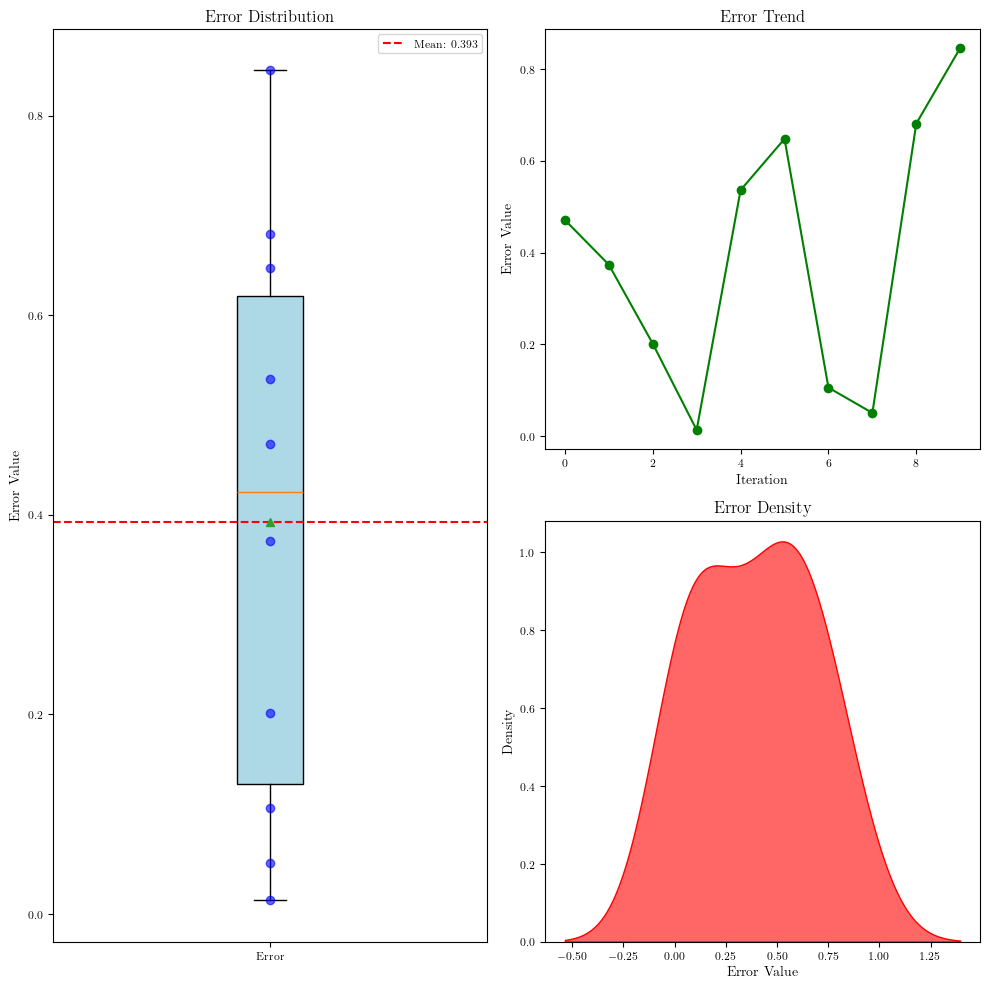

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_u

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

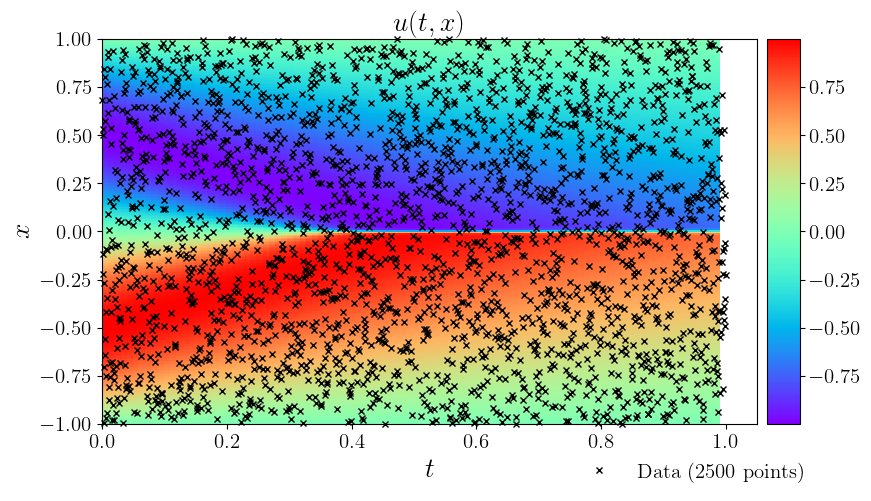

In [14]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact.flatten()[:,None]    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_star = griddata(X_star, u_star.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_star.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


#在图上绘制散点图
ax.plot(
    X_f_train[:,1], 
    X_f_train[:,0], 
    'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
    markersize = 4,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

In [15]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

testerror = torch.stack(model.test_error).cpu().detach().numpy()

55009
[0.29572138 0.2728912  0.25602844 ... 0.00758623 0.00758621 0.0075862 ]


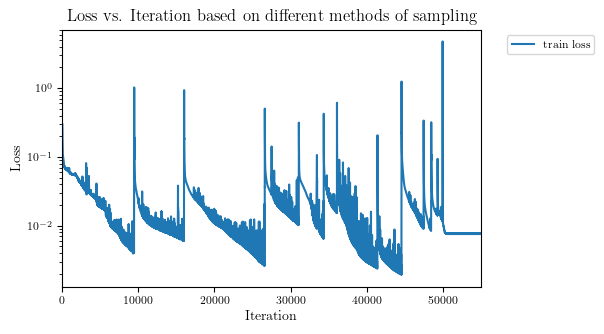

In [16]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

55009
[1.012563   1.0028412  0.9950837  ... 0.84533054 0.8453307  0.84533066]


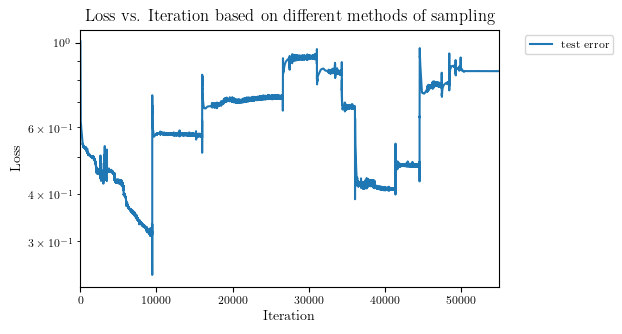

In [17]:
print(len(testerror))
print(testerror)
# 定义图例的标签
# labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(testerror, label='test error')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


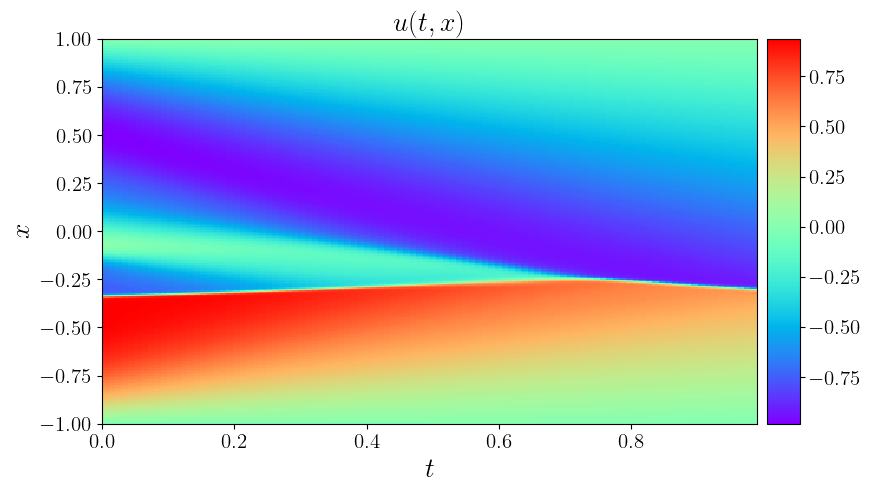

In [18]:
data = scipy.io.loadmat('../data/burgers_shock.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['t'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = np.real(data['usol']).T #从data数据中取出usol的值，并取实部，最后转置，赋值给Exact
#生成一个二位网络，X和T是输出的二维数组
#这个点结果是X和T均为形状为[len(t),len(x)]的二维数组，X的每一行都是x，一共len(t)行，T的每一列都是t，一共len(x)列
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #按列堆叠数组，X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_pred, f_pred = model.predict(X_star)    #对Exact_u使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组   


#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(9, 5)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘图的数据来源
h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')   #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是U_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                   #第三个参数是颜色映射，这里是用彩虹色图；第四个参数是图像的范围；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                   #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性


#添加颜色条
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.10) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.10）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
   
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的


# #在图上绘制散点图
# ax.plot(
#     X_f_train[:,1], 
#     X_f_train[:,0], 
#     'kx', label = 'Data (%d points)' % (X_f_train.shape[0]), 
#     markersize = 4,  # marker size doubled
#     clip_on = False,
#     alpha=1.0
# ) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
#   #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  




#设置图的标签、图例、标题和刻度标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$', size=20)
ax.set_ylabel('$x$', size=20)
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)
#设置子图ax的标题为$u(t,x)$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为20
ax.set_title('$u(t,x)$', fontsize = 20) # font size doubled，两倍化子图标题
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数

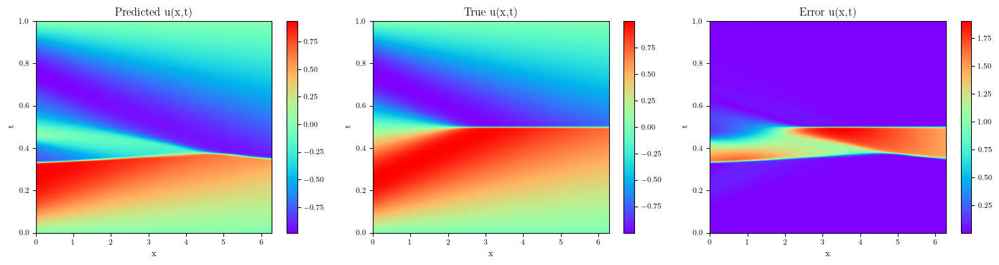

In [19]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_pred.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_star.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 绘制第三幅图像
axes[2].imshow(np.abs(U_pred - U_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [20]:

# # 创建一个包含三幅子图的图像
# fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# # 绘制第一幅图像
# axes[0].imshow(U_var.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
# axes[0].invert_yaxis()
# axes[0].set_xlabel('x')
# axes[0].set_ylabel('t')
# axes[0].set_title('Predicted u(x,t)')
# fig.colorbar(axes[0].images[0], ax=axes[0])

# # 绘制第二幅图像
# axes[1].imshow(U_var_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
# axes[1].invert_yaxis()
# axes[1].set_xlabel('x')
# axes[1].set_ylabel('t')
# axes[1].set_title('True u(x,t)')
# fig.colorbar(axes[1].images[0], ax=axes[1])

# # 自动调整子图参数，使得子图之间的间距适当
# plt.tight_layout()
# plt.show()

In [21]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

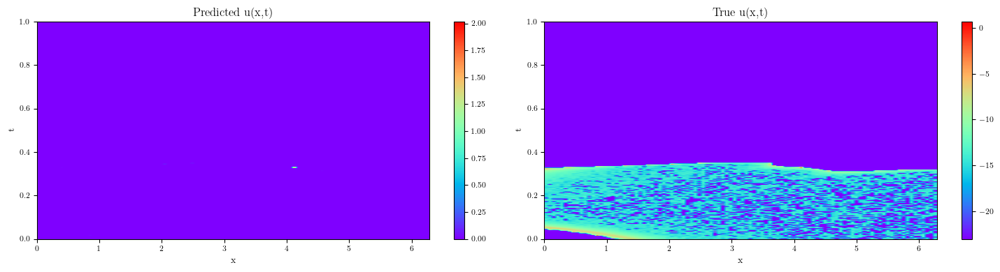

In [22]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predicted u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()